# **Project 3**, APS1070 Fall 2023
#### **PCA [11 marks]**
**Deadline: Nov 17th, 23:00**

**Academic Integrity**

This project is individual - it is to be completed on your own. If you have questions, please post your query in the APS1070 Piazza Q&A forums (the answer might be useful to others!).

Do not share your code with others, or post your work online. Do not submit code that you have not written yourself. Students suspected of plagiarism on a project, midterm or exam will be referred to the department for formal discipline for breaches of the Student Code of Conduct.

In this project we work on a [temperature dataset](https://berkeleyearth.org/data/) that reports the average earth surface temperature for different cities for each month over the years 1992-2006.

Please fill out the following:


*   **Name**: Boshen Zhang
*   **Student number**: 1010774887



### How to submit **(HTML + IPYNB)**

1. Download your notebook: `File -> Download .ipynb`

2. Click on the Files icon on the far left menu of Colab

3. Select & upload your `.ipynb` file you just downloaded, and then obtain its path (right click) (you might need to hit the Refresh button before your file shows up)


4. execute the following in a Colab cell:
```
%%shell
jupyter nbconvert --to html /PATH/TO/YOUR/NOTEBOOKFILE.ipynb
```

5. An HTML version of your notebook will appear in the files, so you can download it.

6. Submit **both** <font color='red'>`HTML` and `IPYNB`</font>  files on Quercus for grading.



Ref: https://stackoverflow.com/a/64487858



# Part 1: Getting started with GitHub [1 Mark + 1 Mark Git Submission]

This first part of the project assignment is to be completed independently from Parts 2 - 5. In this part you will be completing some coding tasks and submitting your results on Github. To access this part of the assignment and upload your answers, you will need to use Github. Please complete the following step-by-step instructions:

 0. Create a Github account and install git for Windows or Mac:
  * https://git-scm.com/download/win
  * https://git-scm.com/download/mac

 1. Open this link: https://classroom.github.com/a/BWpQKQJt to create your assignment repository in GitHub. You should get a link similar to:
```
https://github.com/APS1070-UofT/project-3-part-1-*********
```
This your private repository to get this part questions and upload your answers. **Copy this link to the text box below to be graded for this part.**

```
https://github.com/APS1070-UofT/project-3-part-1-zbs285
```

 2. Open `Git Bash`, the app you downloaded in step `0`, and set your Email and username by:
```
git config --global user.email “<your-GitHub-email>”
git config --global user.name “<your-GitHub-username>”
```

 3. Create a folder for the course on your computer and `cd` to that. `cd` means `Change Directory`. For example, on a Windows machine, where I have a folder on "C:\aps1070":
 ```
cd c:aps1070
```
 4. Get your assignment by the link you got in step 1:
```
git clone https://github.com/APS1070-UofT/project-3-part-1-*********
```

 5. A new folder should be created in your directory similar to:
```
C:\aps1070\project-3-part-1-********
```
This folder has an `ipynb` notebook which you need to manually upload to colab and answer its questions.

 6. After you finished working on this notebook, download the notebook from colab and move it to the directory in step 5.

 7. Replace the old notebook with the new one that has your answers. Make sure your completed notebook has the same name as the original notebook you downloaded.

 8. To submit your work, follow:
```
cd <your assignment folder>
git add F23_Project_3_Part_1_git.ipynb
git commit -m “Final Submission”
git push
```
If you have any problem with pushing your work on GitHub you can try one of following commands:
```
git push --force
or
git push origin HEAD:main
```

 9. Make sure your submission is ready for grading. Open the private repository link in your browser and make sure you can see your final submission with your latest changes there. **Only you and the teaching team can open that link.**

# Part 2: Applying PCA [2 Marks]

1. Compute the covariance matrix of the dataframe. *Hint: The dimensions of your covariance matrix should be (180, 180).* **[0.25]**
2. Write a function `get_sorted_eigen(df_cov)` that gets the covariance matrix of dataframe `df` (from step 1), and returns sorted eigenvalues and eigenvectors using `np.linalg.eigh`. **[0.25]**
3. Show the effectiveness of your principal components in covering the variance of the dataset with a `scree plot`. **[0.25]**
4. How many PCs do you need to cover 99% of the dataset's variance?  **[0.25]** 9
5. Plot the first 16 principal components (Eigenvectors) as a time series (16 subplots, on the x-axis you have dates and on the y-axis you have the value of the PC element) . **[0.5]**
6. Compare the first two PCs with the rest of them. Do you see any difference in their trend? **[0.5]**

It is clear that the first two PCs have clearer image trends than the others, the peaks and troughs are easy to observe, and both of them show clear periodical changes. They are very much like sine and cosine functions, we can see that for PC1, it increases first then reduce between PC value from -0.1 to 0. However, for PC2, it firstly decreases to -0.1 then increase, it has opposite trend compare with PC1.

For other PCs, the image keeps fluctuating, and there is no obvious cyclical rule. But we can see that for PC3, 4, 5, 6, 7, 10, 11, 15 and 16, their PC values decreased first just like PC2 shows at the beginning period; for PC2, 8, 9, 12, 13, 14, they increase first.

In [ ]:
import pandas as pd
data_raw = pd.read_csv(
    filepath_or_buffer='https://raw.githubusercontent.com/Sabaae/Dataset/main/TemperaturesbyCity.csv',
    index_col=0
)

Covariance Matrix Shape: (180, 180)


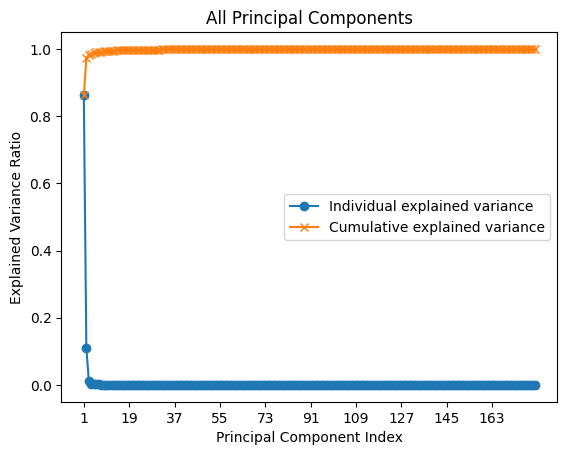

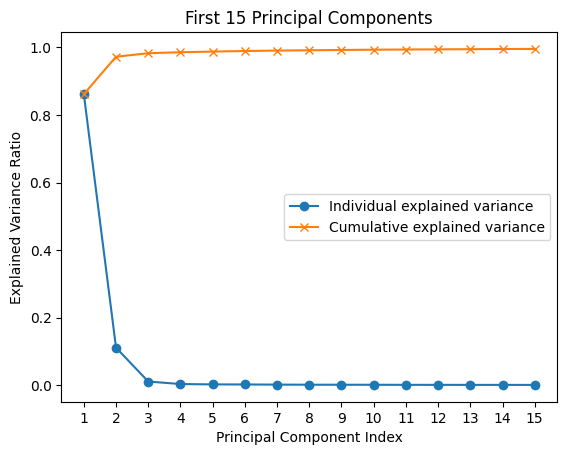

Number of principal components needed to cover 99% of the variance: 7


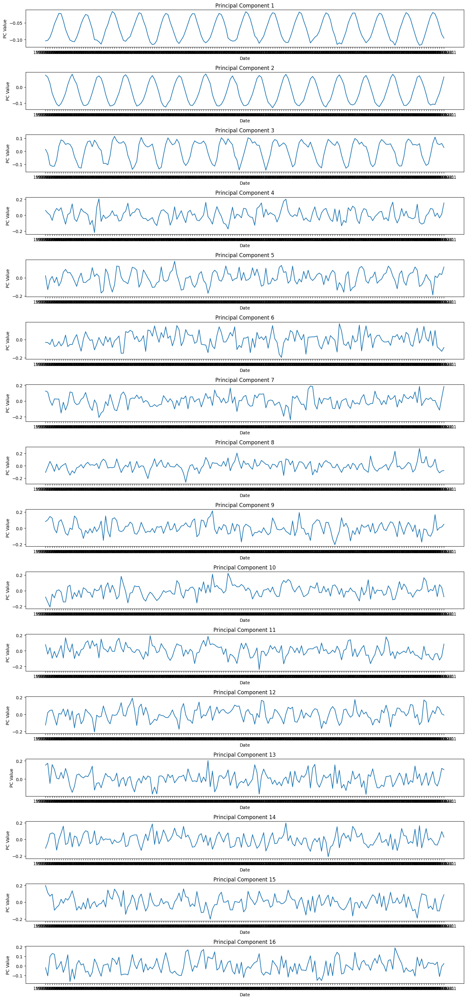

In [ ]:
### YOUR CODE HERE ###
covariance_matrix = data_raw.cov()
print("Covariance Matrix Shape:", covariance_matrix.shape)

import numpy as np
import matplotlib.pyplot as plt

def get_sorted_eigen(df_cov):
    eigenvalues, eigenvectors = np.linalg.eigh(df_cov)
    sorted_indices = np.argsort(eigenvalues)[::-1]
    sorted_eigenvalues = eigenvalues[sorted_indices]
    sorted_eigenvectors = eigenvectors[:, sorted_indices]

    return sorted_eigenvalues, sorted_eigenvectors

sorted_eigenvalues, sorted_eigenvectors = get_sorted_eigen(covariance_matrix)
total_variance = sum(sorted_eigenvalues)
variance_explained = [(i / total_variance) for i in sorted_eigenvalues]
cumulative_variance_explained = np.cumsum(variance_explained)

# scree plot
plt.plot(range(1, len(variance_explained) + 1), variance_explained, marker='o', label='Individual explained variance')
plt.plot(range(1, len(cumulative_variance_explained) + 1), cumulative_variance_explained, marker='x', label='Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Component Index')
plt.xticks(range(1, len(variance_explained) + 1, int(len(variance_explained)/10)))
plt.legend(loc='best')
plt.title('All Principal Components')
plt.show()


# Since the graph is not very clear, I plot first 15 components only
num_components = 15
plt.plot(range(1, num_components + 1), variance_explained[:num_components], marker='o', label='Individual explained variance')
plt.plot(range(1, num_components + 1), cumulative_variance_explained[:num_components], marker='x', label='Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Component Index')
plt.xticks(range(1, num_components + 1))
plt.legend(loc='best')
plt.title('First 15 Principal Components')
plt.show()


num_components_for_threshold = np.argmax(cumulative_variance_explained >= 0.99) + 1
print(f"Number of principal components needed to cover 99% of the variance: {num_components_for_threshold}")


not_used, sorted_eigenvectors = get_sorted_eigen(covariance_matrix)
num_pcs = 16
fig, axes = plt.subplots(num_pcs, 1, figsize=(15, 2*num_pcs))

# Plot each principal component
for i in range(num_pcs):
    ax = axes[i]
    ax.plot(data_raw.columns, sorted_eigenvectors[:, i])
    ax.set_title(f'Principal Component {i+1}')
    ax.set_xlabel('Date')
    ax.set_ylabel('PC Value')

plt.tight_layout()
plt.show()



# Part 3: Data reconstruction [3 Marks]

Create a function that:

*   Accepts a city and the original dataset as inputs.
*   Calls useful functions that you designed in previous parts to compute eigenvectors and eigenvalues.
*   Plots 4 figures:
  1.   The original time-series for the specified city. **[0.5]**
  2.   The incremental reconstruction of the **original** (not standardized) time-series for the specified city in a single plot. **[1.5]**
       * You should at least show 5 curves in a figure for incremental reconstruction. For example, you can pick the following (or any other combination that you think is reasonable):
          * Reconstruction with only PC1
          * Reconstruction with both PC1 and PC2
          * Reconstruction with PC1 to PC4 (First 4 PCs)
          * Reconstruction with PC1 to PC8 (First 8 PCs)
          * Reconstruction with PC1 to PC16 (First 16 PCs)

      * Hint: you need to compute the reconstruction for the standardized time-series first, and then scale it back to the original (non-standardized form) using the StandardScaler `inverse_transform` [help...](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler.inverse_transform)
  3.   The residual error for your best reconstruction with respect to the original time-series. **[0.5]**
      * Hint: You are plotting the error that we have for reconstructing each month `(df - df_reconstructed)`. On the x-axis, you have dates, and on the y-axis, the residual error.
  4.   The RMSE of the reconstruction as a function of the number of included components (x-axis is the number of components and y-axis is the RMSE). Sweep x-axis from 1 to 10 (this part is independent from part 3.2.) **[1]**

Test your function using the `Yakeshi`, `Zamboanga`, `Norilsk`, `Juliaca`, and `Doha` as inputs. **[0.5]**


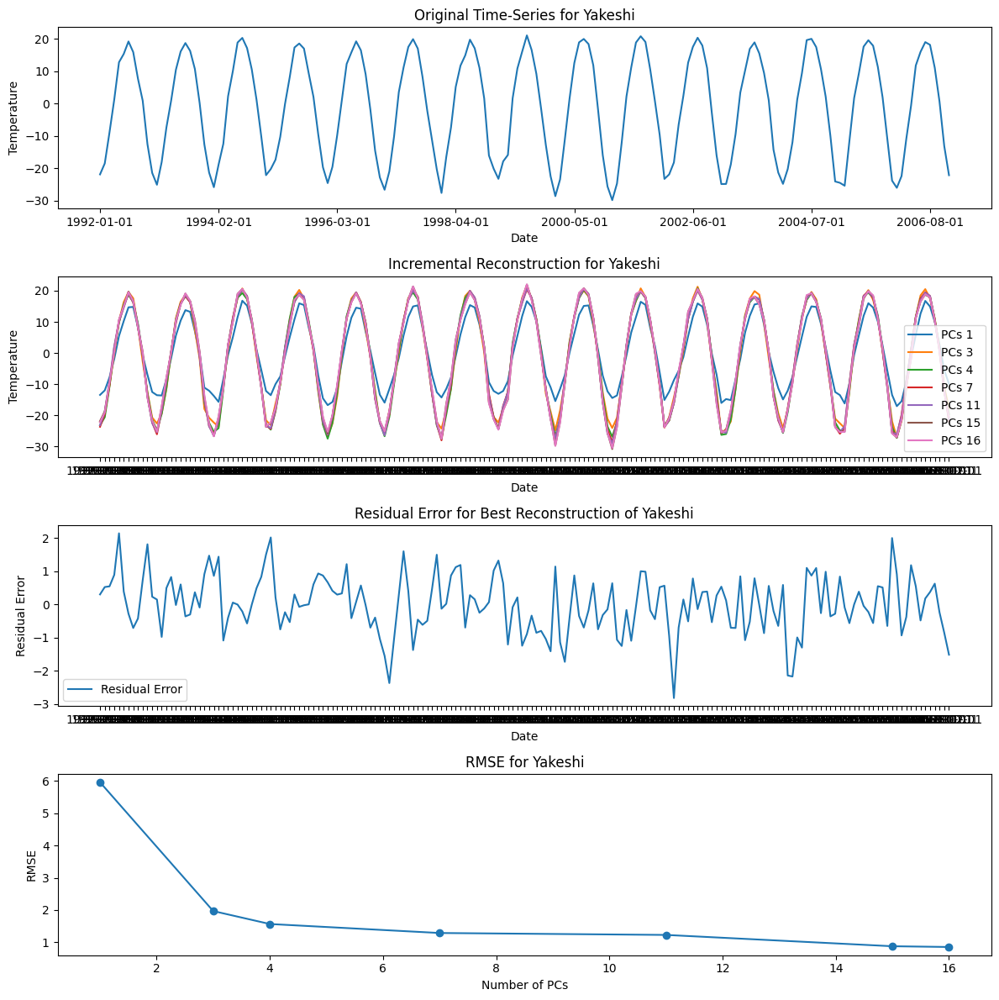

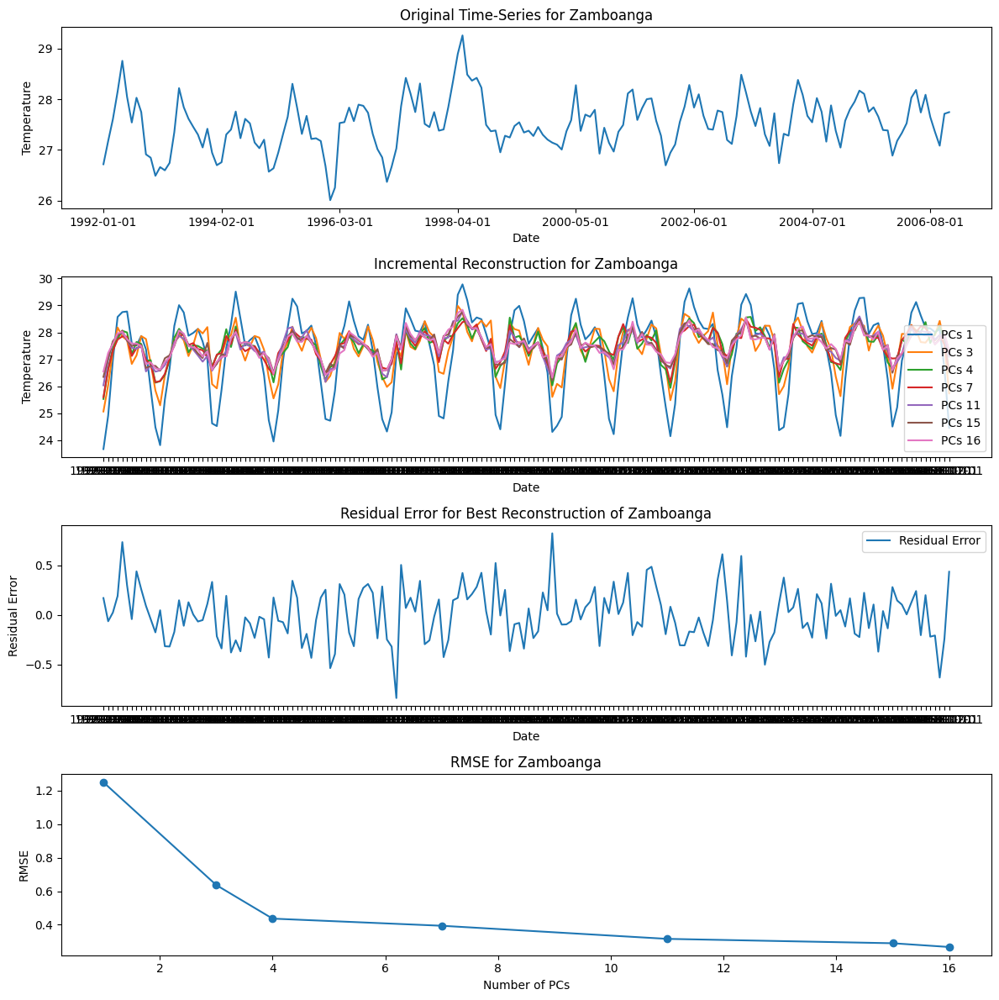

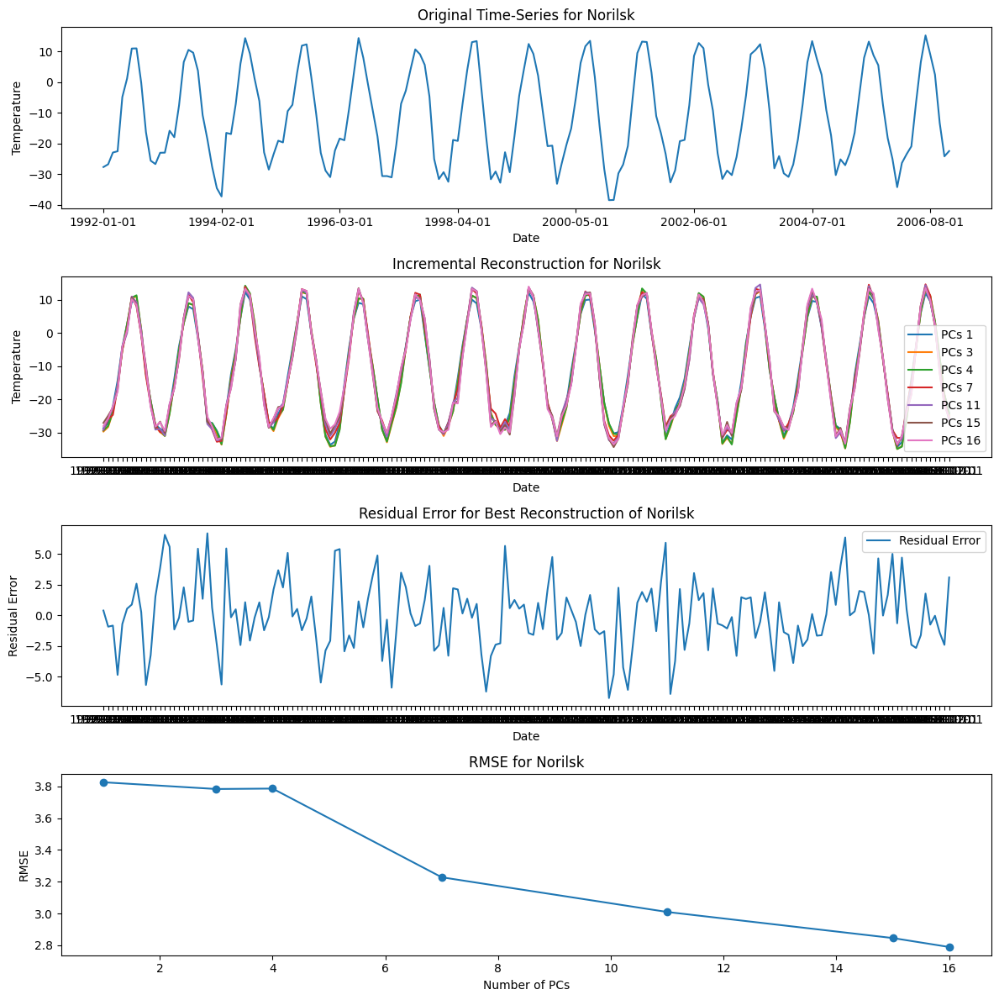

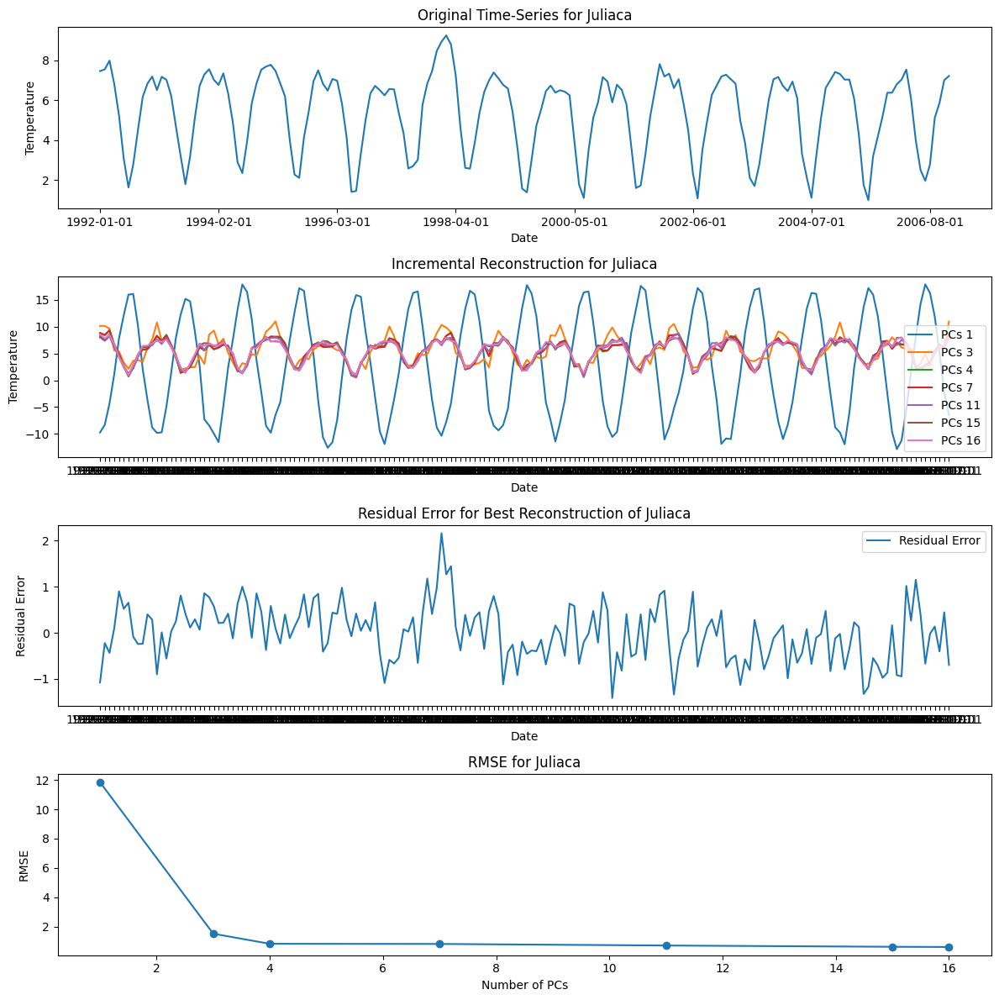

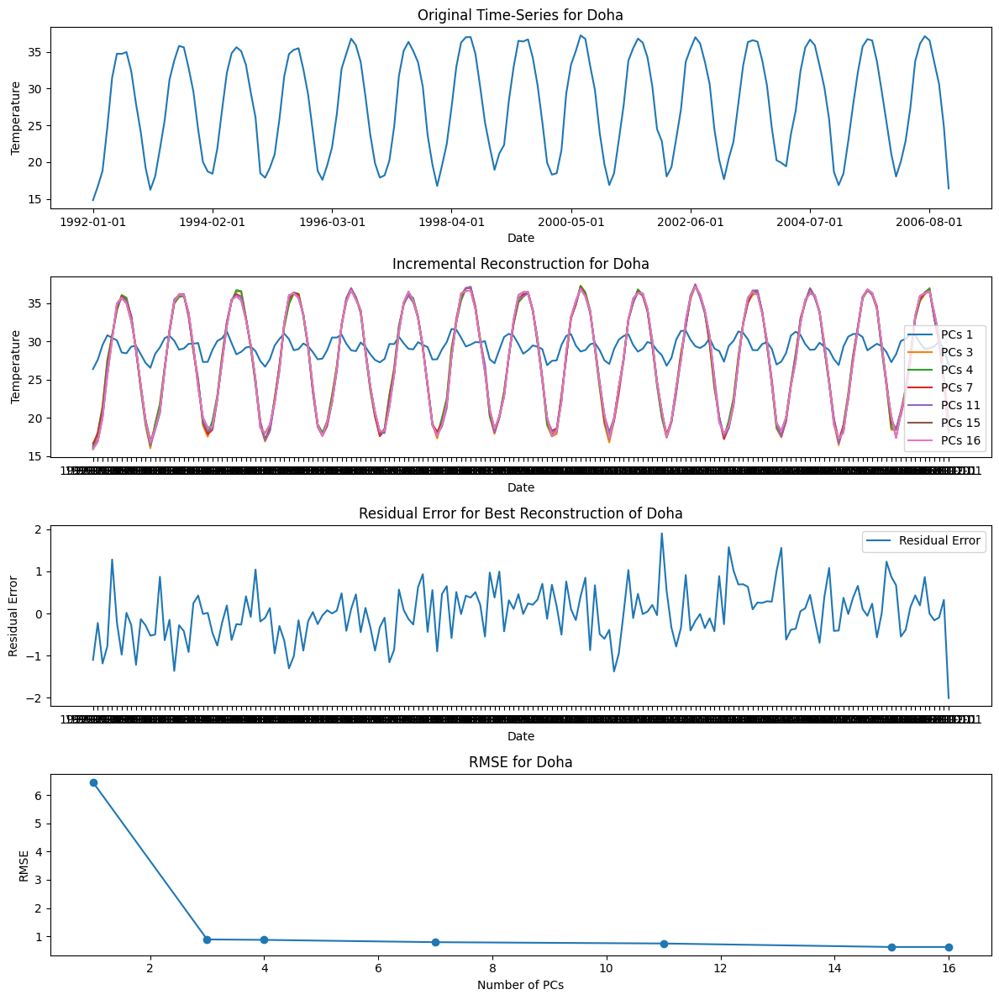

In [ ]:
  ### YOUR CODE HERE ###
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

def plot_city_figures(original_df, city_name):

    # first figure
    plt.subplot(4, 1, 1)
    original_df.loc[city_name,:].plot(figsize=(12, 12))
    plt.title('Original Time-Series for ' + city_name)
    plt.xlabel('Date')
    plt.ylabel('Temperature')

    # second figure
    plt.subplot(4, 1, 2)
    scaler = StandardScaler()
    std_df = scaler.fit_transform(original_df)
    std_df = pd.DataFrame(std_df, index=original_df.index, columns=original_df.columns)

    covariance_matrix = np.cov(std_df, rowvar=False)
    eigenvalues, eigenvectors = get_sorted_eigen(covariance_matrix)

    reconst_image = []
    for num_eigenvector in [1, 3, 4, 7, 11, 15, 16]:
        eigen = eigenvectors[:, :num_eigenvector]
        project = np.dot(std_df.loc[city_name,:], eigen)
        reconstruction = scaler.inverse_transform(np.dot(project.reshape(1, -1), eigen.T))
        reconst_image.append(reconstruction.flatten())

    for i, num_eigenvector in enumerate([1, 3, 4, 7, 11, 15, 16]):
        plt.plot(original_df.columns, reconst_image[i], label=f'PCs {num_eigenvector}')
        plt.title('Incremental Reconstruction for ' + city_name)
        plt.xlabel('Date')
        plt.ylabel('Temperature')
        plt.legend()

    # third figure
    plt.subplot(4, 1, 3)
    best_reconstruction = reconst_image[-1]
    residual_error = original_df.loc[city_name, :].values - best_reconstruction
    plt.plot(original_df.columns, residual_error, label='Residual Error')
    plt.title('Residual Error for Best Reconstruction of ' + city_name)
    plt.xlabel('Date')
    plt.ylabel('Residual Error')
    plt.legend()

    # fourth figure
    plt.subplot(4, 1, 4)
    rmse_list = [mean_squared_error(original_df.loc[city_name, :].values, reconstruction, squared=False) for reconstruction in reconst_image]
    plt.plot([1, 3, 4, 7, 11, 15, 16], rmse_list, marker='o')
    plt.title('RMSE for ' + city_name)
    plt.xlabel('Number of PCs')
    plt.ylabel('RMSE')

    plt.tight_layout()
    plt.show()

# Example
cities = ['Yakeshi', 'Zamboanga', 'Norilsk', 'Juliaca', 'Doha']
for city in cities:
    plot_city_figures(data_raw, city)


# Part 4: SVD [2 Marks]
Modify your code in part 3 to use SVD instead of PCA for extracting the eigenvectors. **[1]**

Explain if standardization or covariance computation is required for this part.
Repeat part 3 and compare your PCA and SVD results. Write a function to make this comparison **[0.5]**, and comment on the results. **[0.5]**.

Covariance computation is not required for SVD, only standardization computation has been already adequately. Generally, we can see that all of the four plots of part3(PCA) and part4(SVD) are very similar. To be more specific, in compare function, I compute Root Mean Squared Error for each reconstruction to quantify the accuracy. Since lower RMSE values indicate better reconstruction accuracy, in some ways, compare the RMSE values of PCA and SVD to determine which method is more effective. We can observe that for the example five cities, RMSE for PCA and SVD reconstruction have very similar results. It is difficult to say which one is absolutely better, we can see in three cities SVD has very slightly higher RMSE but it is not meaning SVD is not suitable.

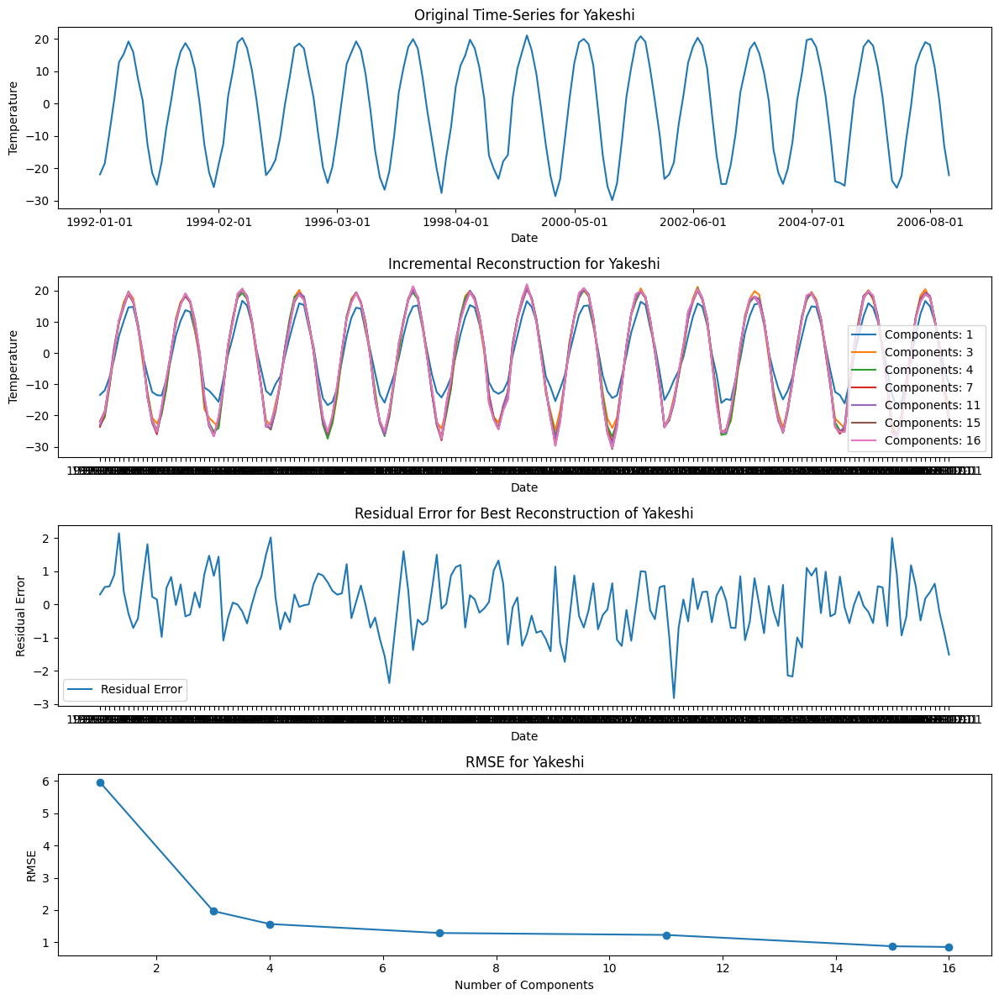

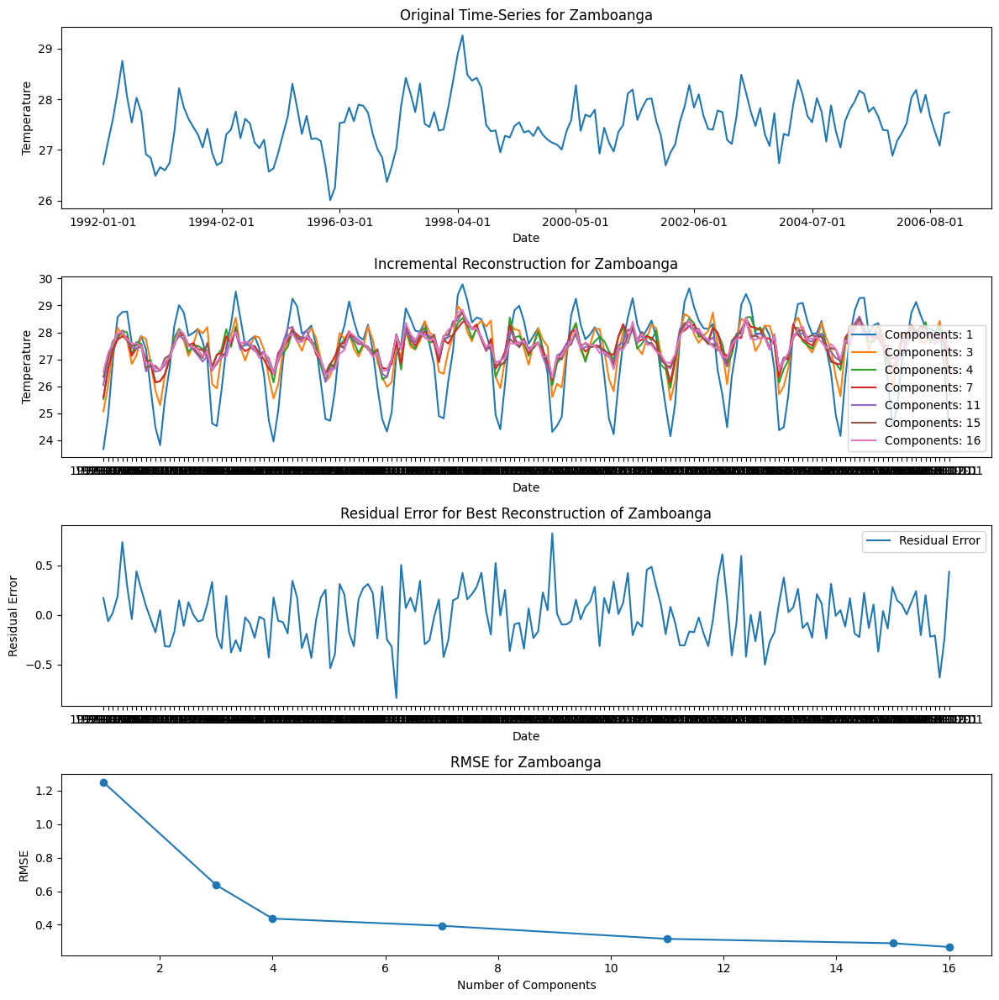

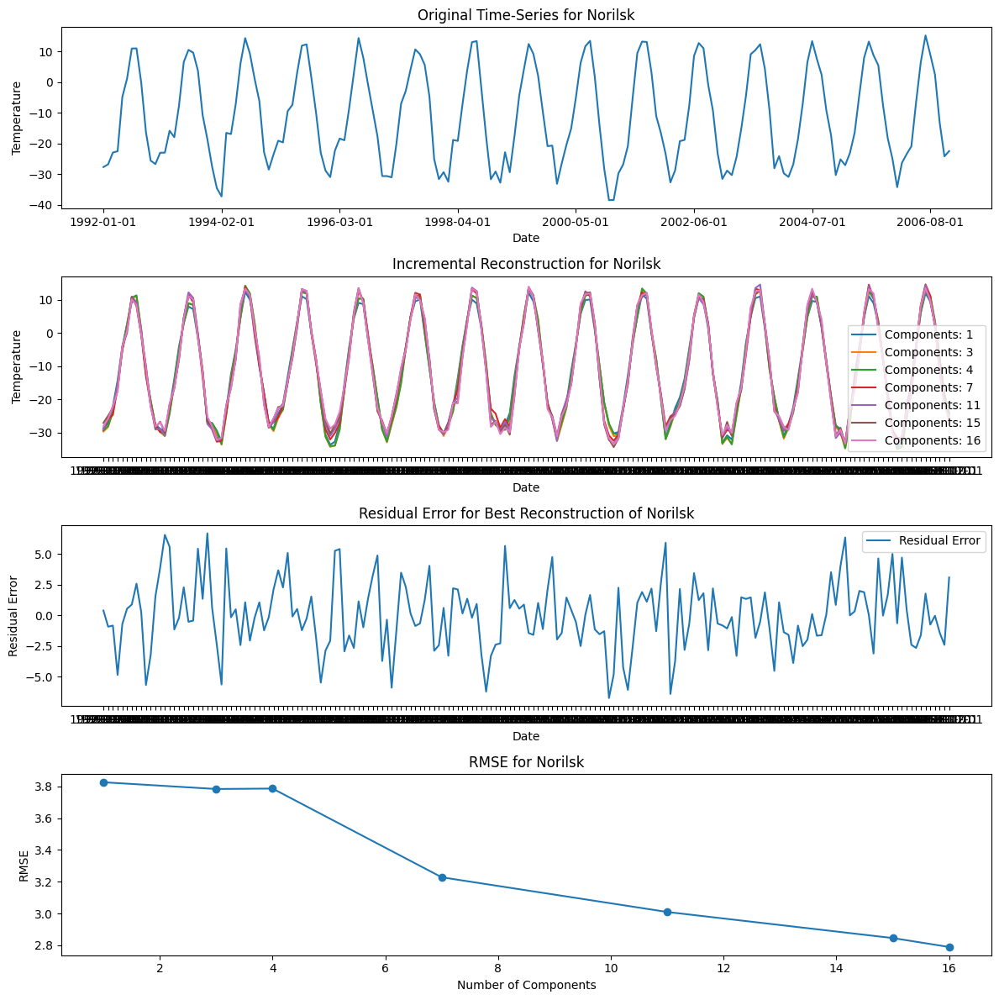

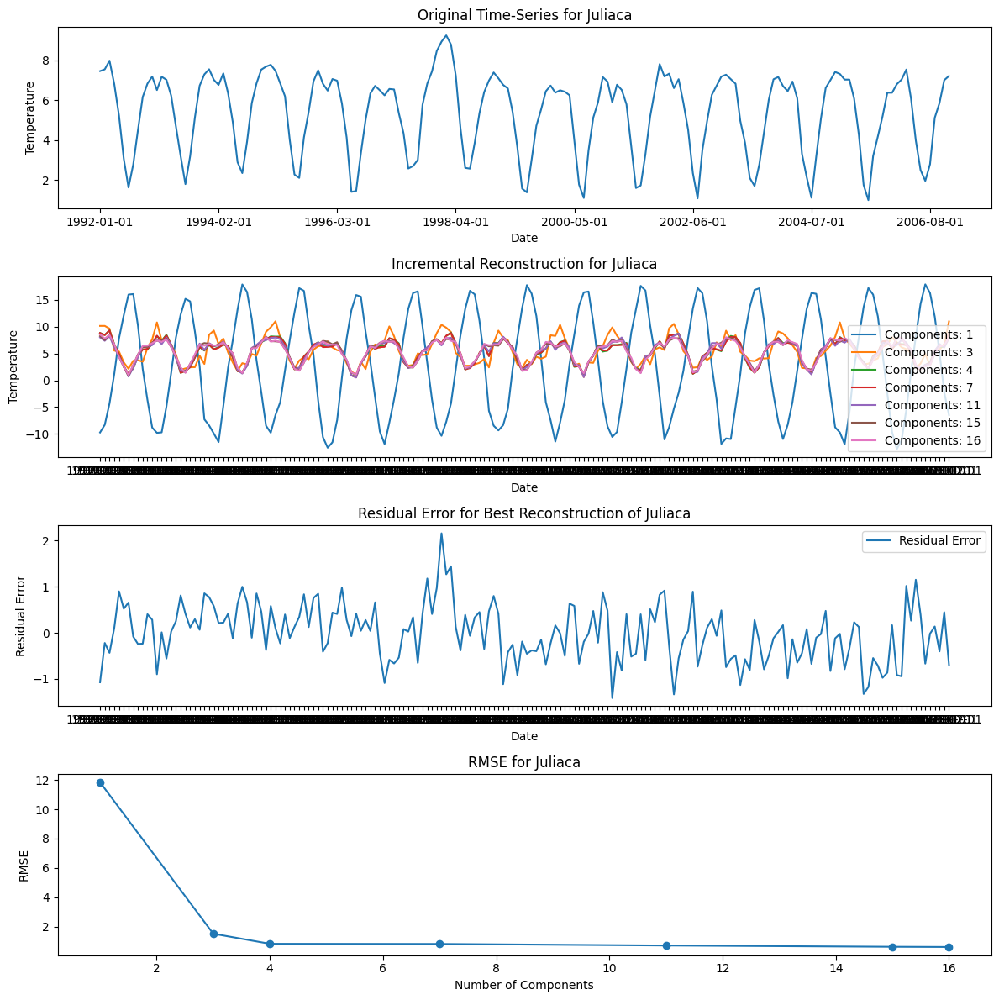

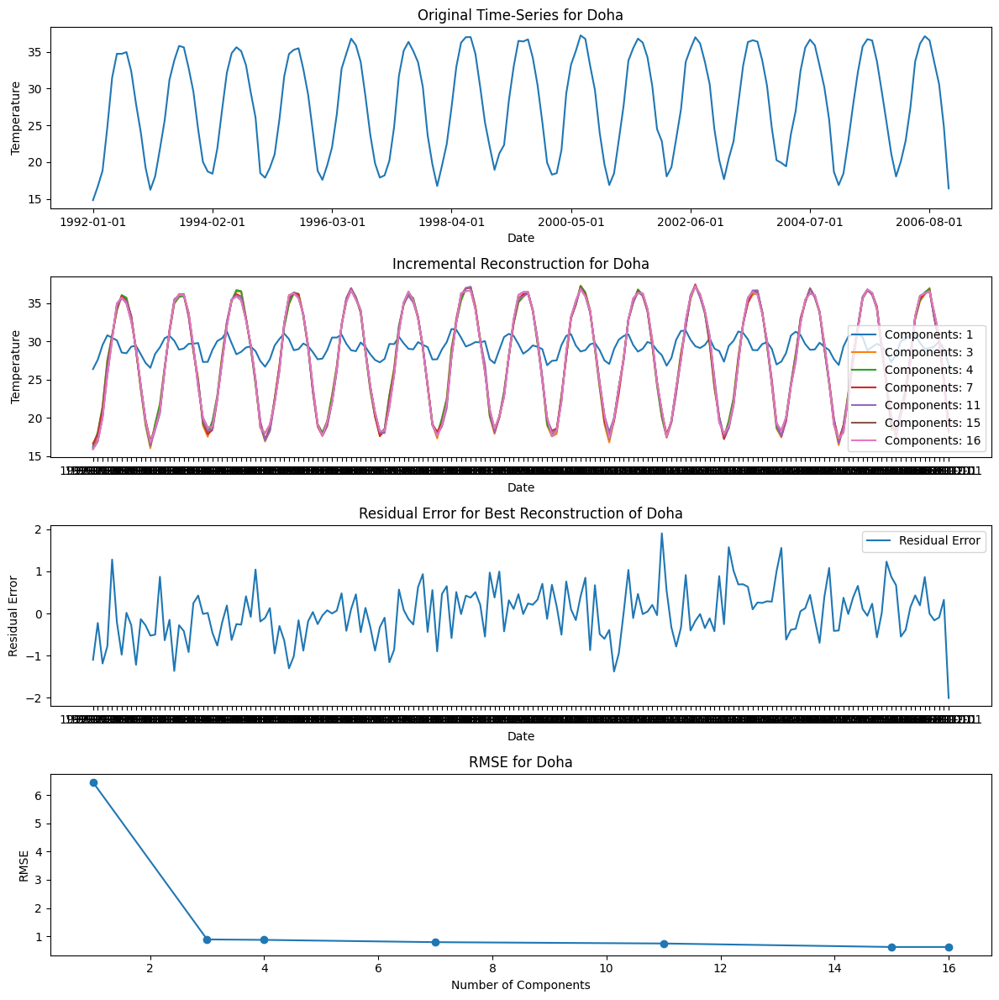

In [ ]:
### YOUR CODE HERE ###
def plot_city_figures_svd(original_df, city_name):
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from sklearn.preprocessing import StandardScaler
    from sklearn.metrics import mean_squared_error
    from sklearn.decomposition import TruncatedSVD

    # first plot
    plt.subplot(4, 1, 1)
    original_df.loc[city_name,:].plot(figsize=(12,12))
    plt.title('Original Time-Series for ' + city_name)
    plt.xlabel('Date')
    plt.ylabel('Temperature')

    # second plot
    plt.subplot(4, 1, 2)
    scaler = StandardScaler()
    std_df = scaler.fit_transform(original_df)
    std_df = pd.DataFrame(std_df, index=original_df.index, columns=original_df.columns)

    reconst_image = []
    for n_elements in [1, 3, 4, 7, 11, 15, 16]:
        svd = TruncatedSVD(n_components=n_elements)
        svd.fit(std_df)
        city_data = std_df.loc[city_name, :].values.reshape(1, -1)
        city_data_df = pd.DataFrame(city_data, columns=std_df.columns)
        T = svd.transform(city_data_df)  # Transform using DataFrame
        reconstruction = scaler.inverse_transform(svd.inverse_transform(T))
        reconst_image.append(reconstruction.flatten())


    for i, n_elements in enumerate([1, 3, 4, 7, 11, 15, 16]):
        plt.plot(original_df.columns, reconst_image[i], label=f'Components: {n_elements}')
        plt.title('Incremental Reconstruction for ' + city_name)
        plt.xlabel('Date')
        plt.ylabel('Temperature')
        plt.legend()

    # third plot
    plt.subplot(4, 1, 3)
    best_reconstruction = reconst_image[-1]
    residual_error = original_df.loc[city_name, :].values - best_reconstruction
    plt.plot(original_df.columns, residual_error, label='Residual Error')
    plt.title('Residual Error for Best Reconstruction of ' + city_name)
    plt.xlabel('Date')
    plt.ylabel('Residual Error')
    plt.legend()

    # fourth plot
    plt.subplot(4, 1, 4)
    rmse_list = [mean_squared_error(original_df.loc[city_name, :].values, reconstruction, squared=False) for reconstruction in reconst_image]
    plt.plot([1, 3, 4, 7, 11, 15, 16], rmse_list, marker='o')
    plt.title('RMSE for ' + city_name)
    plt.xlabel('Number of Components')
    plt.ylabel('RMSE')

    plt.tight_layout()
    plt.show()

# Example

cities = ['Yakeshi', 'Zamboanga', 'Norilsk', 'Juliaca', 'Doha']
for city in cities:
    plot_city_figures_svd(data_raw, city)

RMSE for PCA Reconstruction of Yakeshi: 0.8543260637660768
RMSE for SVD Reconstruction of Yakeshi: 0.8543182338168923


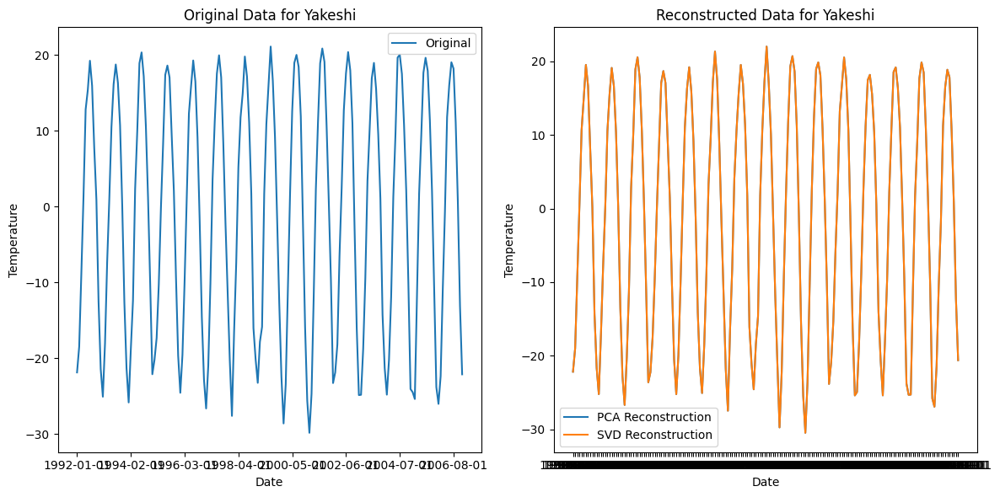

RMSE for PCA Reconstruction of Zamboanga: 0.26680365905189335
RMSE for SVD Reconstruction of Zamboanga: 0.2668391854762297


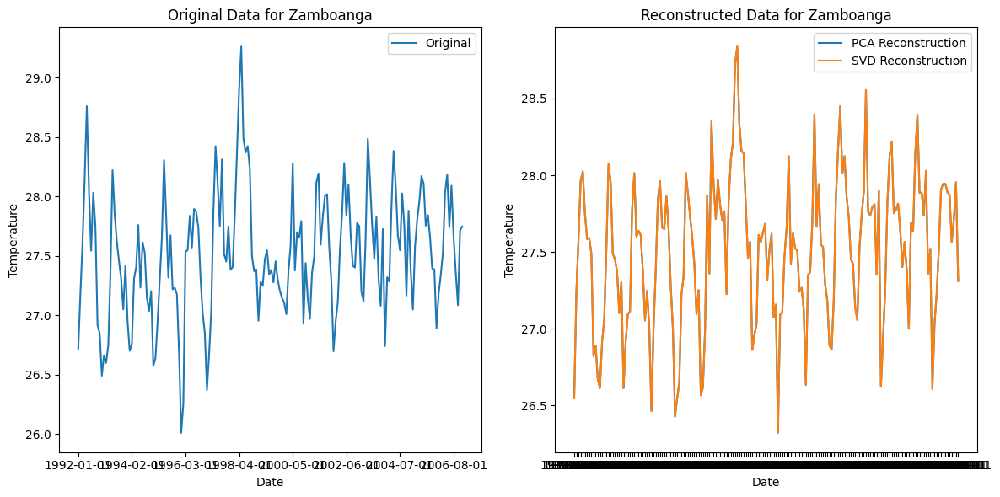

RMSE for PCA Reconstruction of Norilsk: 2.7888000544415257
RMSE for SVD Reconstruction of Norilsk: 2.7893116762936088


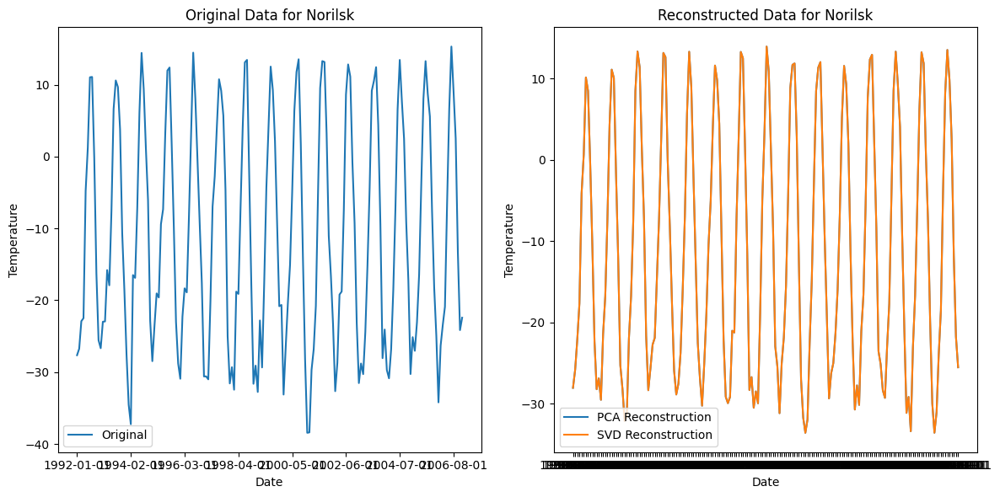

RMSE for PCA Reconstruction of Juliaca: 0.6083683050121703
RMSE for SVD Reconstruction of Juliaca: 0.6082933563879552


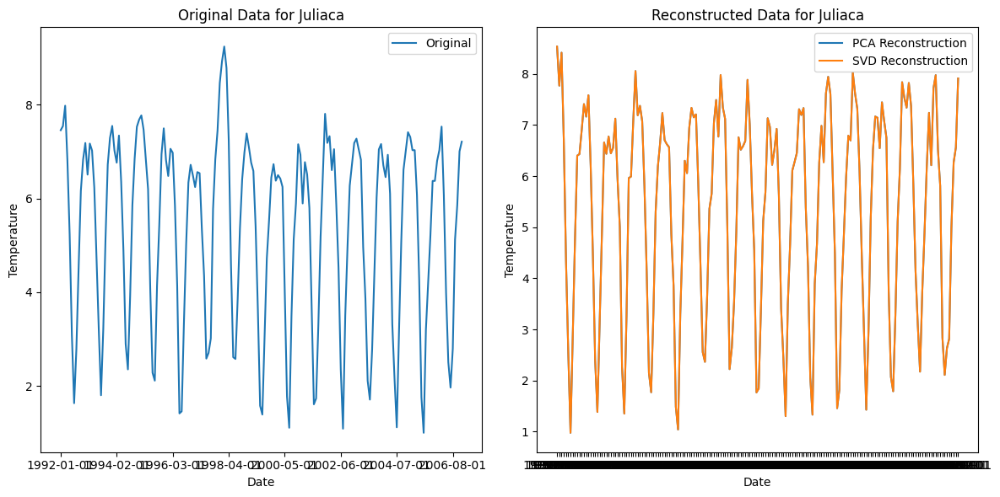

RMSE for PCA Reconstruction of Doha: 0.6183309819304406
RMSE for SVD Reconstruction of Doha: 0.6183854622341363


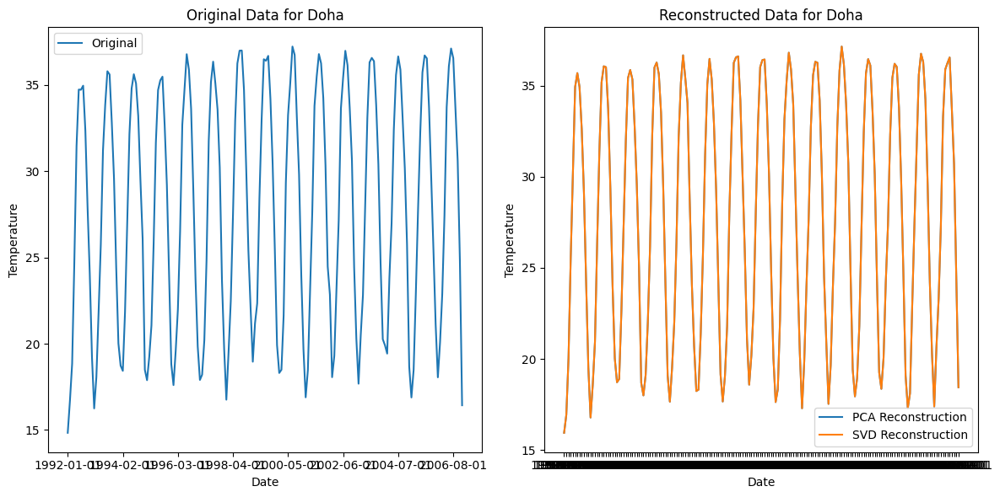

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error

def perform_pca_reconstruction(original_df, city_name):
    scaler = StandardScaler()
    std_df = scaler.fit_transform(original_df)
    std_df = pd.DataFrame(std_df, index=original_df.index, columns=original_df.columns)

    covariance_matrix = np.cov(std_df, rowvar=False)
    eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

    # Sort the eigenvectors by eigenvalues in descending order
    idx = eigenvalues.argsort()[::-1]
    eigenvalues = eigenvalues[idx]
    eigenvectors = eigenvectors[:,idx]

    reconst_image = []
    rmse_list = []
    for num_eigenvector in [1, 3, 4, 7, 11, 15, 16]:
        eigen = eigenvectors[:, :num_eigenvector]
        project = np.dot(std_df.loc[city_name,:], eigen)
        reconstruction = scaler.inverse_transform(np.dot(project.reshape(1, -1), eigen.T))
        reconst_image.append(reconstruction.flatten())
        rmse = mean_squared_error(original_df.loc[city_name, :].values, reconstruction.flatten(), squared=False)
        rmse_list.append(rmse)

    # Return the best reconstruction and its RMSE
    best_reconstruction = reconst_image[-1]
    best_rmse = rmse_list[-1]

    return best_reconstruction, best_rmse


from sklearn.decomposition import TruncatedSVD

from sklearn.decomposition import TruncatedSVD

def perform_svd_reconstruction(original_df, city_name):
    scaler = StandardScaler()
    std_df = scaler.fit_transform(original_df)
    std_df = pd.DataFrame(std_df, index=original_df.index, columns=original_df.columns)

    reconst_image = []
    rmse_list = []
    for n_elements in [1, 3, 4, 7, 11, 15, 16]:
        svd = TruncatedSVD(n_components=n_elements)
        svd.fit(std_df)
        city_data = std_df.loc[city_name, :].values.reshape(1, -1)
        city_data_df = pd.DataFrame(city_data, columns=std_df.columns)
        T = svd.transform(city_data_df)
        reconstruction = scaler.inverse_transform(svd.inverse_transform(T))
        reconst_image.append(reconstruction.flatten())

        rmse = mean_squared_error(original_df.loc[city_name, :].values, reconstruction.flatten(), squared=False)
        rmse_list.append(rmse)

    # Return the best reconstruction and its RMSE
    best_reconstruction = reconst_image[-1]
    best_rmse = rmse_list[-1]

    return best_reconstruction, best_rmse

def compare_pca_svd(original_df, city_name):
    pca_reconstruction, pca_rmse = perform_pca_reconstruction(original_df, city_name)
    svd_reconstruction, svd_rmse = perform_svd_reconstruction(original_df, city_name)

    # Compare RMSE
    print(f"RMSE for PCA Reconstruction of {city_name}: {pca_rmse}")
    print(f"RMSE for SVD Reconstruction of {city_name}: {svd_rmse}")

    # Optionally, plot the original vs reconstructed data for visual comparison
    plt.figure(figsize=(12, 6))

    # Original Data
    plt.subplot(1, 2, 1)
    original_df.loc[city_name, :].plot(label='Original')
    plt.title(f'Original Data for {city_name}')
    plt.xlabel('Date')
    plt.ylabel('Temperature')
    plt.legend()

    # PCA Reconstruction
    plt.subplot(1, 2, 2)
    plt.plot(original_df.columns, pca_reconstruction, label='PCA Reconstruction')
    plt.plot(original_df.columns, svd_reconstruction, label='SVD Reconstruction')
    plt.title(f'Reconstructed Data for {city_name}')
    plt.xlabel('Date')
    plt.ylabel('Temperature')
    plt.legend()

    plt.tight_layout()
    plt.show()

cities = ['Yakeshi', 'Zamboanga', 'Norilsk', 'Juliaca', 'Doha']
for city in cities:
    compare_pca_svd(data_raw, city)


# Part 5: Let's collect another dataset! [2 Marks]
Create another dataset similar to the one provided in your handout using the raw information on average temperatures per states (not cities) provided [here](https://github.com/Sabaae/Dataset/blob/main/TemperaturesbyState.csv). **[1]**

You need to manipulate the data to organize it in the desired format (i.e., the same format that was in previous parts). If there is a missing value for the average temperature of a particular state at a given date, make sure to remove that date completely from the dataset, even if the data of that specific date exists for other states.

You are free to use any tools you like, from Excel to Python! In the end, you should have a new CSV file with more dates (features) compared to the provided dataset. How many features does the final dataset have? How many states are there?


Upload your new dataset (in CSV format) to your colab notebook and repeat part 4. When analyzing the states, you may use `Jilin`, `Nunavut`, `Rio Grande Do Norte`, `Louisiana`, and `Tasmania`. **[1]**


The code below helps you to upload your new CSV file to your colab session.

Since the code below generate MessageError: RangeError: Maximun call stack size exceeded, I use read_csv function instead.

In [ ]:
# load train.csv to Google Colab
from google.colab import files
uploaded = files.upload()

MessageError: ignored

In [43]:
import pandas as pd
df = pd.read_csv(
    filepath_or_buffer='dt,AverageTemperature,AverageTemperatureUncertainty,State,Country
1963-01-01,26.037,0.315,Acre,Brazil
1963-01-01,-1.26,0.551,Adygey,Russia
1963-01-01,-22.297,0.563,Aga Buryat,Russia
1963-01-01,4.234,0.134,Alabama,United States
1963-01-01,26.389000000000006,0.54,Alagoas,Brazil
1963-01-01,-14.667000000000002,0.51,Alaska,United States
1963-01-01,-19.276,0.357,Alberta,Canada
1963-01-01,-13.874,0.613,Altay,Russia
1963-01-01,26.345,0.127,Amazonas,Brazil
1963-01-01,-24.547000000000004,0.5870000000000001,Amur,Russia
1963-01-01,26.354,0.286,Andaman And Nicobar,India
1963-01-01,22.142,0.401,Andhra Pradesh,India
1963-01-01,0.965,0.382,Anhui,China
1963-01-01,2.9130000000000003,0.222,Arizona,United States
1963-01-01,0.6180000000000003,0.158,Arkansas,United States
1963-01-01,-19.292,0.376,Arkhangel'Sk,Russia
1963-01-01,5.4510000000000005,0.407,Arunachal Pradesh,India
1963-01-01,14.528,0.326,Assam,India
1963-01-01,-6.662999999999999,0.457,Astrakhan',Russia
1963-01-01,17.852,0.319,Australian Capital Territory,Australia
1963-01-01,25.394,0.204,Bahia,Brazil
1963-01-01,-15.398,0.299,Bashkortostan,Russia
1963-01-01,-8.485,0.241,Beijing,China
1963-01-01,-15.452000000000002,0.442,Belgorod,Russia
1963-01-01,14.844,0.447,Bihar,India
1963-01-01,-12.839,0.435,British Columbia,Canada
1963-01-01,-16.081,0.407,Bryansk,Russia
1963-01-01,-27.183000000000003,0.413,Buryat,Russia
1963-01-01,4.854,0.261,California,United States
1963-01-01,5.206,1.715,Chandigarh,India
1963-01-01,-1.944,0.407,Chechnya,Russia
1963-01-01,-15.064,0.431,Chelyabinsk,Russia
1963-01-01,17.868000000000006,0.363,Chhattisgarh,India
1963-01-01,-26.669,0.188,Chita,Russia
1963-01-01,4.981000000000001,0.204,Chongqing,China
1963-01-01,-22.117,0.547,Chukot,Russia
1963-01-01,-18.711,0.385,Chuvash,Russia
1963-01-01,-12.315,0.324,City Of St. Petersburg,Russia
1963-01-01,-8.808,0.304,Colorado,United States
1963-01-01,-3.239,0.262,Connecticut,United States
1963-01-01,20.331,0.191,Dadra And Nagar Haveli,India
1963-01-01,-0.2390000000000001,0.485,Dagestan,Russia
1963-01-01,22.631,0.488,Daman And Diu,India
1963-01-01,-0.999,0.183,Delaware,United States
1963-01-01,13.86,1.009,Delhi,India
1963-01-01,-2.062,0.206,District Of Columbia,United States
1963-01-01,23.122,0.204,Distrito Federal,Brazil
1963-01-01,-31.663,0.753,Evenk,Russia
1963-01-01,14.126,0.158,Florida,United States
1963-01-01,6.488999999999999,0.4,Fujian,China
1963-01-01,-10.787,0.374,Gansu,China
1963-01-01,5.972,0.143,Georgia (State),United States
1963-01-01,24.676,0.466,Goa,India
1963-01-01,-19.796,0.958,Gorno Altay,Russia
1963-01-01,10.407,0.307,Guangdong,China
1963-01-01,10.012,0.371,Guangxi,China
1963-01-01,4.912,0.341,Guizhou,China
1963-01-01,20.011,0.402,Gujarat,India
1963-01-01,16.503999999999998,0.555,Hainan,China
1963-01-01,12.948,1.041,Haryana,India
1963-01-01,21.129,0.316,Hawaii,United States
1963-01-01,-8.259,0.195,Hebei,China
1963-01-01,-21.288,0.332,Heilongjiang,China
1963-01-01,-0.07,0.401,Henan,China
1963-01-01,-0.643,1.209,Himachal Pradesh,India
1963-01-01,3.0700000000000003,0.215,Hubei,China
1963-01-01,5.134,0.217,Hunan,China
1963-01-01,-9.191,0.276,Idaho,United States
1963-01-01,-8.338000000000001,0.142,Illinois,United States
1963-01-01,-7.196000000000001,0.122,Indiana,United States
1963-01-01,-2.074,0.465,Ingush,Russia
1963-01-01,-12.533,0.18,Iowa,United States
1963-01-01,-26.814,0.321,Irkutsk,Russia
1963-01-01,-18.553,0.238,Ivanovo,Russia
1963-01-01,-8.922,0.508,Jammu And Kashmir,India
1963-01-01,16.009,0.369,Jharkhand,India
1963-01-01,-0.26,0.3,Jiangsu,China
1963-01-01,4.343,0.22,Jiangxi,China
1963-01-01,-19.408,0.354,Jilin,China
1963-01-01,-2.502,0.456,Kabardin Balkar,Russia
1963-01-01,-11.61,0.4320000000000001,Kaliningrad,Russia
1963-01-01,-5.848,0.575,Kalmyk,Russia
1963-01-01,-16.838,0.385,Kaluga,Russia
1963-01-01,-9.107,0.7090000000000001,Kamchatka,Russia
1963-01-01,-6.351,0.118,Kansas,United States
1963-01-01,-2.094,0.444,Karachay Cherkess,Russia
1963-01-01,-15.800999999999998,0.386,Karelia,Russia
1963-01-01,23.319000000000003,0.475,Karnataka,India
1963-01-01,-15.756999999999998,0.579,Kemerovo,Russia
1963-01-01,-2.8589999999999995,0.185,Kentucky,United States
1963-01-01,25.944000000000003,0.7559999999999999,Kerala,India
1963-01-01,-24.112,0.677,Khabarovsk,Russia
1963-01-01,-20.214,0.544,Khakass,Russia
1963-01-01,-21.933000000000003,0.299,Khanty Mansiy,Russia
1963-01-01,-20.352,0.472,Kirov,Russia
1963-01-01,-21.794,0.415,Komi,Russia
1963-01-01,-20.34800000000001,0.49,Komi Permyak,Russia
1963-01-01,-13.277,0.655,Koryak,Russia
1963-01-01,-19.737,0.276,Kostroma,Russia
1963-01-01,-2.675,0.462,Krasnodar,Russia
1963-01-01,-22.248,0.371,Krasnoyarsk,Russia
1963-01-01,-16.212,0.297,Kurgan,Russia
1963-01-01,-16.557000000000002,0.331,Kursk,Russia
1963-01-01,-14.713,0.337,Leningrad,Russia
1963-01-01,-13.774,0.329,Liaoning,China
1963-01-01,-17.082,0.302,Lipetsk,Russia
1963-01-01,6.7860000000000005,0.119,Louisiana,United States
1963-01-01,16.71,0.307,Madhya Pradesh,India
1963-01-01,-25.977,0.6829999999999999,Maga Buryatdan,Russia
1963-01-01,20.983,0.255,Maharashtra,India
1963-01-01,-8.527999999999999,0.354,Maine,United States
1963-01-01,13.967,0.461,Manipur,India
1963-01-01,-26.735000000000007,0.5479999999999999,Manitoba,Canada
1963-01-01,-19.392,0.38,Mariy El,Russia
1963-01-01,-1.1909999999999998,0.172,Maryland,United States
1963-01-01,-5.259,0.32,Massachusetts,United States
1963-01-01,25.914,0.288,Mato Grosso,Brazil
1963-01-01,26.158,0.2,Mato Grosso Do Sul,Brazil
1963-01-01,16.62,0.324,Meghalaya,India
1963-01-01,-11.297,0.121,Michigan,United States
1963-01-01,24.407,0.196,Minas Gerais,Brazil
1963-01-01,-16.964000000000002,0.2,Minnesota,United States
1963-01-01,4.327999999999999,0.14,Mississippi,United States
1963-01-01,-5.83,0.157,Missouri,United States
1963-01-01,16.811,0.429,Mizoram,India
1963-01-01,-12.909,0.272,Montana,United States
1963-01-01,-18.376,0.39,Mordovia,Russia
1963-01-01,-17.094,0.345,Moscow City,Russia
1963-01-01,-17.448999999999998,0.3229999999999999,Moskva,Russia
1963-01-01,-12.945,0.33,Murmansk,Russia
1963-01-01,14.021,0.453,Nagaland,India
1963-01-01,-10.63,0.133,Nebraska,United States
1963-01-01,-16.632,0.244,Nei Mongol,China
1963-01-01,-18.811,0.408,Nenets,Russia
1963-01-01,-2.9210000000000003,0.33,Nevada,United States
1963-01-01,-8.603,0.312,New Brunswick,Canada
1963-01-01,-7.912000000000001,0.213,New Hampshire,United States
1963-01-01,-2.902,0.226,New Jersey,United States
1963-01-01,-1.618,0.174,New Mexico,United States
1963-01-01,23.192,0.274,New South Wales,Australia
1963-01-01,-7.35,0.143,New York,United States
1963-01-01,-13.95,0.71,Newfoundland And Labrador,Canada
1963-01-01,-9.354,0.529,Ningxia Hui,China
1963-01-01,-19.051,0.338,Nizhegorod,Russia
1963-01-01,2.732,0.188,North Carolina,United States
1963-01-01,-16.582,0.161,North Dakota,United States
1963-01-01,-2.011,0.531,North Ossetia,Russia
1963-01-01,29.994,0.338,Northern Territory,Australia
1963-01-01,-31.678,0.449,Northwest Territories,Canada
1963-01-01,-2.5210000000000004,0.248,Nova Scotia,Canada
1963-01-01,-16.06,0.272,Novgorod,Russia
1963-01-01,-16.458,0.477,Novosibirsk,Russia
1963-01-01,-30.995,0.4370000000000001,Nunavut,Canada
1963-01-01,-6.415,0.127,Ohio,United States
1963-01-01,-1.117,0.144,Oklahoma,United States
1963-01-01,-17.264,0.389,Omsk,Russia
1963-01-01,-21.474,0.285,Ontario,Canada
1963-01-01,-2.484,0.321,Oregon,United States
1963-01-01,-17.191000000000006,0.364,Orel,Russia
1963-01-01,-14.347,0.22,Orenburg,Russia
1963-01-01,19.208,0.5479999999999999,Orissa,India
1963-01-01,-5.627000000000001,0.206,Pennsylvania,United States
1963-01-01,-17.34,0.336,Penza,Russia
1963-01-01,-19.566,0.478,Perm',Russia
1963-01-01,26.523000000000003,0.508,Pernambuco,Brazil
1963-01-01,-17.695999999999998,0.501,Primor'Ye,Russia
1963-01-01,-4.548,0.194,Prince Edward Island,Canada
1963-01-01,-14.367,0.21,Pskov,Russia
1963-01-01,24.571,0.29,Puducherry,India
1963-01-01,11.624,1.027,Punjab,India
1963-01-01,-17.398,0.32,Qinghai,China
1963-01-01,27.592,0.231,Queensland,Australia
1963-01-01,15.79,0.295,Rajasthan,India
1963-01-01,-3.1820000000000004,0.275,Rhode Island,United States
1963-01-01,25.296,0.361,Rio De Janeiro,Brazil
1963-01-01,27.811,0.6759999999999999,Rio Grande Do Norte,Brazil
1963-01-01,24.424,0.341,Rio Grande Do Sul,Brazil
1963-01-01,26.14,0.403,Roraima,Brazil
1963-01-01,-8.698,0.215,Rostov,Russia
1963-01-01,-18.443,0.417,Ryazan',Russia
1963-01-01,-34.656,0.612,Sakha,Russia
1963-01-01,-10.494000000000002,0.319,Sakhalin,Russia
1963-01-01,-16.463,0.274,Samara,Russia
1963-01-01,23.276,0.619,Santa Catarina,Brazil
1963-01-01,-14.532,0.319,Saratov,Russia
1963-01-01,-23.512,0.272,Saskatchewan,Canada
1963-01-01,26.929,0.495,Sergipe,Brazil
1963-01-01,-4.005,0.158,Shaanxi,China
1963-01-01,-3.494,0.18,Shandong,China
1963-01-01,1.922,0.42,Shanghai,China
1963-01-01,-7.881,0.401,Shanxi,China
1963-01-01,-3.318,0.252,Sichuan,China
1963-01-01,-6.195,0.311,Sikkim,India
1963-01-01,-15.785,0.388,Smolensk,Russia
1963-01-01,26.331000000000003,0.142,South Australia,Australia
1963-01-01,5.4670000000000005,0.178,South Carolina,United States
1963-01-01,-13.0,0.199,South Dakota,United States
1963-01-01,-3.991,0.393,Stavropol',Russia
1963-01-01,-18.525,0.462,Sverdlovsk,Russia
1963-01-01,-16.884,0.449,Tambov,Russia
1963-01-01,23.918000000000003,0.355,Tamil Nadu,India
1963-01-01,15.491,0.213,Tasmania,Australia
1963-01-01,-17.709,0.353,Tatarstan,Russia
1963-01-01,-30.831000000000003,0.672,Taymyr,Russia
1963-01-01,-0.5080000000000005,0.148,Tennessee,United States
1963-01-01,4.484999999999999,0.086,Texas,United States
1963-01-01,-5.712999999999999,0.239,Tianjin,China
1963-01-01,25.687,0.201,Tocantins,Brazil
1963-01-01,-18.667,0.338,Tomsk,Russia
1963-01-01,17.972,0.4,Tripura,India
1963-01-01,-17.605999999999998,0.308,Tula,Russia
1963-01-01,-29.499,1.18,Tuva,Russia
1963-01-01,-16.778,0.244,Tver',Russia
1963-01-01,-18.13,0.315,Tyumen',Russia
1963-01-01,-18.933,0.311,Udmurt,Russia
1963-01-01,-17.59,0.352,Ul'Yanovsk,Russia
1963-01-01,-24.238000000000003,0.481,Ust Orda Buryat,Russia
1963-01-01,-6.734999999999999,0.303,Utah,United States
1963-01-01,14.125,0.615,Uttar Pradesh,India
1963-01-01,6.206,1.099,Uttaranchal,India
1963-01-01,-8.4,0.179,Vermont,United States
1963-01-01,19.995,0.209,Victoria,Australia
1963-01-01,-0.1430000000000002,0.159,Virginia,United States
1963-01-01,-18.535,0.387,Vladimir,Russia
1963-01-01,-11.49,0.454,Volgograd,Russia
1963-01-01,-19.465,0.282,Vologda,Russia
1963-01-01,-14.77,0.244,Voronezh,Russia
1963-01-01,-4.081,0.264,Washington,United States
1963-01-01,17.195,0.307,West Bengal,India
1963-01-01,-3.2460000000000004,0.152,West Virginia,United States
1963-01-01,28.417,0.202,Western Australia,Australia
1963-01-01,-14.89,0.183,Wisconsin,United States
1963-01-01,-11.608,0.267,Wyoming,United States
1963-01-01,-13.053999999999998,0.363,Xinjiang Uygur,China
1963-01-01,-15.297,0.7490000000000001,Xizang,China
1963-01-01,-23.848000000000003,0.294,Yamal Nenets,Russia
1963-01-01,-18.65,0.213,Yaroslavl',Russia
1963-01-01,-20.697,0.595,Yevrey,Russia
1963-01-01,-24.129,0.5589999999999999,Yukon,Canada
1963-01-01,7.286,0.22,Yunnan,China
1963-01-01,2.765,0.312,Zhejiang,China
1963-02-01,25.659,0.341,Acre,Brazil
1963-02-01,2.38,0.581,Adygey,Russia
1963-02-01,-16.490000000000002,0.385,Aga Buryat,Russia
1963-02-01,5.6850000000000005,0.158,Alabama,United States
1963-02-01,26.215,0.7390000000000001,Alagoas,Brazil
1963-02-01,-15.583,0.247,Alaska,United States
1963-02-01,-11.264,0.259,Alberta,Canada
1963-02-01,-10.238,0.518,Altay,Russia
1963-02-01,26.139,0.336,Amazonas,Brazil
1963-02-01,-21.554,0.414,Amur,Russia
1963-02-01,26.65,0.687,Andaman And Nicobar,India
1963-02-01,24.737,0.408,Andhra Pradesh,India
1963-02-01,4.361000000000001,0.237,Anhui,China
1963-02-01,9.646,0.23,Arizona,United States
1963-02-01,3.906,0.189,Arkansas,United States
1963-02-01,-17.776,0.48,Arkhangel'Sk,Russia
1963-02-01,8.321,0.405,Arunachal Pradesh,India
1963-02-01,17.663999999999994,0.264,Assam,India
1963-02-01,-4.475,0.261,Astrakhan',Russia
1963-02-01,17.338,0.208,Australian Capital Territory,Australia
1963-02-01,24.95,0.596,Bahia,Brazil
1963-02-01,-11.636,0.254,Bashkortostan,Russia
1963-02-01,-4.305,0.175,Beijing,China
1963-02-01,-6.511,0.264,Belgorod,Russia
1963-02-01,19.528,0.443,Bihar,India
1963-02-01,-5.8260000000000005,0.263,British Columbia,Canada
1963-02-01,-8.189,0.314,Bryansk,Russia
1963-02-01,-19.68,0.305,Buryat,Russia
1963-02-01,11.544,0.168,California,United States
1963-02-01,8.052,0.523,Chandigarh,India
1963-02-01,0.0980000000000003,0.425,Chechnya,Russia
1963-02-01,-10.94,0.235,Chelyabinsk,Russia
1963-02-01,22.297,0.434,Chhattisgarh,India
1963-02-01,-20.599,0.258,Chita,Russia
1963-02-01,6.792000000000001,0.147,Chongqing,China
1963-02-01,-25.201,0.472,Chukot,Russia
1963-02-01,-12.095,0.235,Chuvash,Russia
1963-02-01,-11.709,0.208,City Of St. Petersburg,Russia
1963-02-01,0.0110000000000001,0.179,Colorado,United States
1963-02-01,-4.734999999999999,0.195,Connecticut,United States
1963-02-01,23.342,0.68,Dadra And Nagar Haveli,India
1963-02-01,1.4680000000000002,0.378,Dagestan,Russia
1963-02-01,24.488000000000003,0.789,Daman And Diu,India
1963-02-01,-1.8180000000000005,0.22,Delaware,United States
1963-02-01,19.203,0.275,Delhi,India
1963-02-01,-2.68,0.211,District Of Columbia,United States
1963-02-01,22.363000000000003,0.279,Distrito Federal,Brazil
1963-02-01,-23.886000000000006,0.8540000000000001,Evenk,Russia
1963-02-01,13.533,0.201,Florida,United States
1963-02-01,9.56,0.249,Fujian,China
1963-02-01,-5.824999999999998,0.1689999999999999,Gansu,China
1963-02-01,6.807,0.181,Georgia (State),United States
1963-02-01,25.36,1.05,Goa,India
1963-02-01,-15.889,1.257,Gorno Altay,Russia
1963-02-01,13.317,0.199,Guangdong,China
1963-02-01,11.905,0.218,Guangxi,China
1963-02-01,6.353,0.321,Guizhou,China
1963-02-01,23.789,0.477,Gujarat,India
1963-02-01,19.018,0.373,Hainan,China
1963-02-01,18.053,0.348,Haryana,India
1963-02-01,21.59,0.297,Hawaii,United States
1963-02-01,-4.199,0.136,Hebei,China
1963-02-01,-16.317,0.255,Heilongjiang,China
1963-02-01,2.869,0.171,Henan,China
1963-02-01,2.8180000000000005,0.46,Himachal Pradesh,India
1963-02-01,5.973,0.198,Hubei,China
1963-02-01,7.337999999999999,0.168,Hunan,China
1963-02-01,1.0790000000000002,0.391,Idaho,United States
1963-02-01,-5.004,0.216,Illinois,United States
1963-02-01,-5.18,0.143,Indiana,United States
1963-02-01,-0.1700000000000003,0.415,Ingush,Russia
1963-02-01,-6.65,0.204,Iowa,United States
1963-02-01,-16.564999999999998,0.481,Irkutsk,Russia
1963-02-01,-11.865,0.365,Ivanovo,Russia
1963-02-01,-4.623,0.6659999999999999,Jammu And Kashmir,India
1963-02-01,21.16,0.382,Jharkhand,India
1963-02-01,2.792,0.148,Jiangsu,China
1963-02-01,7.79,0.125,Jiangxi,China
1963-02-01,-12.353,0.221,Jilin,China
1963-02-01,-0.258,0.349,Kabardin Balkar,Russia
1963-02-01,-9.215,0.815,Kaliningrad,Russia
1963-02-01,-2.9090000000000003,0.4270000000000001,Kalmyk,Russia
1963-02-01,-10.058,0.285,Kaluga,Russia
1963-02-01,-9.923,0.446,Kamchatka,Russia
1963-02-01,2.478,0.1669999999999999,Kansas,United States
1963-02-01,0.6299999999999999,0.375,Karachay Cherkess,Russia
1963-02-01,-14.675,0.29,Karelia,Russia
1963-02-01,25.072,0.628,Karnataka,India
1963-02-01,-10.8,0.4270000000000001,Kemerovo,Russia
1963-02-01,-1.213,0.192,Kentucky,United States
1963-02-01,26.512,0.455,Kerala,India
1963-02-01,-23.442,0.1669999999999999,Khabarovsk,Russia
1963-02-01,-14.140999999999998,0.5579999999999999,Khakass,Russia
1963-02-01,-14.649,0.298,Khanty Mansiy,Russia
1963-02-01,-13.279000000000002,0.231,Kirov,Russia
1963-02-01,-16.433,0.288,Komi,Russia
1963-02-01,-12.759,0.247,Komi Permyak,Russia
1963-02-01,-16.362000000000002,0.532,Koryak,Russia
1963-02-01,-13.194,0.332,Kostroma,Russia
1963-02-01,1.5619999999999998,0.485,Krasnodar,Russia
1963-02-01,-15.156,0.551,Krasnoyarsk,Russia
1963-02-01,-11.007,0.201,Kurgan,Russia
1963-02-01,-7.729,0.298,Kursk,Russia
1963-02-01,-12.331,0.214,Leningrad,Russia
1963-02-01,-7.127999999999999,0.187,Liaoning,China
1963-02-01,-8.974,0.233,Lipetsk,Russia
1963-02-01,8.814,0.162,Louisiana,United States
1963-02-01,21.534,0.376,Madhya Pradesh,India
1963-02-01,-27.801,0.87,Maga Buryatdan,Russia
1963-02-01,24.001,0.579,Maharashtra,India
1963-02-01,-12.003,0.37,Maine,United States
1963-02-01,17.493,0.363,Manipur,India
1963-02-01,-22.015,0.518,Manitoba,Canada
1963-02-01,-12.473,0.316,Mariy El,Russia
1963-02-01,-1.946,0.148,Maryland,United States
1963-02-01,-6.851,0.215,Massachusetts,United States
1963-02-01,25.938,0.934,Mato Grosso,Brazil
1963-02-01,25.946,0.356,Mato Grosso Do Sul,Brazil
1963-02-01,20.063,0.273,Meghalaya,India
1963-02-01,-10.586,0.206,Michigan,United States
1963-02-01,23.76,0.205,Minas Gerais,Brazil
1963-02-01,-12.134,0.173,Minnesota,United States
1963-02-01,6.039999999999999,0.154,Mississippi,United States
1963-02-01,-1.045,0.147,Missouri,United States
1963-02-01,20.656,0.406,Mizoram,India
1963-02-01,-1.3260000000000003,0.271,Montana,United States
1963-02-01,-11.425999999999998,0.268,Mordovia,Russia
1963-02-01,-10.828,0.332,Moscow City,Russia
1963-02-01,-10.995,0.304,Moskva,Russia
1963-02-01,-14.563,0.375,Murmansk,Russia
1963-02-01,17.21,0.406,Nagaland,India
1963-02-01,-0.6179999999999999,0.18,Nebraska,United States
1963-02-01,-11.464,0.177,Nei Mongol,China
1963-02-01,-18.27,0.512,Nenets,Russia
1963-02-01,5.696000000000001,0.266,Nevada,United States
1963-02-01,-12.732,0.318,New Brunswick,Canada
1963-02-01,-10.091,0.257,New Hampshire,United States
1963-02-01,-3.89,0.208,New Jersey,United States
1963-02-01,4.143,0.196,New Mexico,United States
1963-02-01,24.164,0.181,New South Wales,Australia
1963-02-01,-8.892999999999999,0.192,New York,United States
1963-02-01,-15.880999999999998,0.615,Newfoundland And Labrador,Canada
1963-02-01,-4.898999999999999,0.171,Ningxia Hui,China
1963-02-01,-11.811,0.359,Nizhegorod,Russia
1963-02-01,2.6,0.166,North Carolina,United States
1963-02-01,-9.806,0.212,North Dakota,United States
1963-02-01,-0.181,0.31,North Ossetia,Russia
1963-02-01,29.641,0.285,Northern Territory,Australia
1963-02-01,-27.172,0.428,Northwest Territories,Canada
1963-02-01,-6.84,0.165,Nova Scotia,Canada
1963-02-01,-11.768,0.447,Novgorod,Russia
1963-02-01,-12.017,0.381,Novosibirsk,Russia
1963-02-01,-27.946,0.526,Nunavut,Canada
1963-02-01,-5.494,0.114,Ohio,United States
1963-02-01,5.189,0.132,Oklahoma,United States
1963-02-01,-11.988,0.325,Omsk,Russia
1963-02-01,-19.071,0.394,Ontario,Canada
1963-02-01,5.529,0.195,Oregon,United States
1963-02-01,-8.877,0.261,Orel,Russia
1963-02-01,-12.047,0.313,Orenburg,Russia
1963-02-01,23.649,0.436,Orissa,India
1963-02-01,-6.718,0.228,Pennsylvania,United States
1963-02-01,-11.247,0.239,Penza,Russia
1963-02-01,-12.424,0.247,Perm',Russia
1963-02-01,26.022,0.905,Pernambuco,Brazil
1963-02-01,-13.714,0.905,Primor'Ye,Russia
1963-02-01,-9.323,0.17,Prince Edward Island,Canada
1963-02-01,-11.126,0.564,Pskov,Russia
1963-02-01,25.578000000000003,0.343,Puducherry,India
1963-02-01,16.522000000000002,0.328,Punjab,India
1963-02-01,-12.805,0.27,Qinghai,China
1963-02-01,28.463,0.24,Queensland,Australia
1963-02-01,20.885,0.263,Rajasthan,India
1963-02-01,-4.67,0.199,Rhode Island,United States
1963-02-01,24.658,0.331,Rio De Janeiro,Brazil
1963-02-01,27.437,0.773,Rio Grande Do Norte,Brazil
1963-02-01,24.408,0.355,Rio Grande Do Sul,Brazil
1963-02-01,26.271,0.483,Roraima,Brazil
1963-02-01,-3.526,0.339,Rostov,Russia
1963-02-01,-10.864,0.187,Ryazan',Russia
1963-02-01,-31.432,0.53,Sakha,Russia
1963-02-01,-12.614,0.654,Sakhalin,Russia
1963-02-01,-12.831,0.404,Samara,Russia
1963-02-01,22.977,0.417,Santa Catarina,Brazil
1963-02-01,-11.062,0.319,Saratov,Russia
1963-02-01,-16.858,0.301,Saskatchewan,Canada
1963-02-01,26.856,0.6859999999999999,Sergipe,Brazil
1963-02-01,-0.251,0.265,Shaanxi,China
1963-02-01,0.036,0.327,Shandong,China
1963-02-01,4.039,0.262,Shanghai,China
1963-02-01,-3.661,0.121,Shanxi,China
1963-02-01,-0.197,0.301,Sichuan,China
1963-02-01,-3.438,0.462,Sikkim,India
1963-02-01,-10.15,0.373,Smolensk,Russia
1963-02-01,27.406,0.214,South Australia,Australia
1963-02-01,5.768999999999999,0.249,South Carolina,United States
1963-02-01,-4.392,0.247,South Dakota,United States
1963-02-01,-0.718,0.426,Stavropol',Russia
1963-02-01,-11.207,0.378,Sverdlovsk,Russia
1963-02-01,-9.568,0.198,Tambov,Russia
1963-02-01,25.099,0.351,Tamil Nadu,India
1963-02-01,13.813,0.218,Tasmania,Australia
1963-02-01,-12.473,0.178,Tatarstan,Russia
1963-02-01,-31.736,1.021,Taymyr,Russia
1963-02-01,0.9669999999999996,0.173,Tennessee,United States
1963-02-01,9.115,0.133,Texas,United States
1963-02-01,-1.85,0.1669999999999999,Tianjin,China
1963-02-01,24.745,1.179,Tocantins,Brazil
1963-02-01,-12.487000000000002,0.348,Tomsk,Russia
1963-02-01,22.259,0.316,Tripura,India
1963-02-01,-10.215,0.242,Tula,Russia
1963-02-01,-22.537,1.037,Tuva,Russia
1963-02-01,-11.511,0.364,Tver',Russia
1963-02-01,-11.472,0.24,Tyumen',Russia
1963-02-01,-12.528,0.199,Udmurt,Russia
1963-02-01,-12.428,0.339,Ul'Yanovsk,Russia
1963-02-01,-15.639,0.531,Ust Orda Buryat,Russia
1963-02-01,2.827,0.232,Utah,United States
1963-02-01,19.181,0.215,Uttar Pradesh,India
1963-02-01,9.466,0.489,Uttaranchal,India
1963-02-01,-10.626,0.227,Vermont,United States
1963-02-01,19.175,0.18,Victoria,Australia
1963-02-01,-0.5089999999999995,0.1639999999999999,Virginia,United States
1963-02-01,-11.397,0.286,Vladimir,Russia
1963-02-01,-7.46,0.264,Volgograd,Russia
1963-02-01,-13.93,0.228,Vologda,Russia
1963-02-01,-7.1160000000000005,0.196,Voronezh,Russia
1963-02-01,3.4319999999999995,0.286,Washington,United States
1963-02-01,21.812,0.311,West Bengal,India
1963-02-01,-3.432,0.199,West Virginia,United States
1963-02-01,27.885,0.304,Western Australia,Australia
1963-02-01,-11.307,0.249,Wisconsin,United States
1963-02-01,-0.8820000000000001,0.162,Wyoming,United States
1963-02-01,-6.288999999999999,0.276,Xinjiang Uygur,China
1963-02-01,-11.409,0.493,Xizang,China
1963-02-01,-22.095,0.5660000000000001,Yamal Nenets,Russia
1963-02-01,-12.679,0.315,Yaroslavl',Russia
1963-02-01,-17.471999999999998,0.306,Yevrey,Russia
1963-02-01,-19.783,0.519,Yukon,Canada
1963-02-01,10.041,0.229,Yunnan,China
1963-02-01,5.534,0.242,Zhejiang,China
1963-03-01,25.506,0.467,Acre,Brazil
1963-03-01,1.5059999999999998,0.1689999999999999,Adygey,Russia
1963-03-01,-6.9,0.375,Aga Buryat,Russia
1963-03-01,14.853000000000002,0.184,Alabama,United States
1963-03-01,25.83,0.301,Alagoas,Brazil
1963-03-01,-14.546,0.4370000000000001,Alaska,United States
1963-03-01,-6.277,0.247,Alberta,Canada
1963-03-01,-4.211000000000001,0.43,Altay,Russia
1963-03-01,26.111,0.243,Amazonas,Brazil
1963-03-01,-11.65,0.34,Amur,Russia
1963-03-01,27.47,0.8,Andaman And Nicobar,India
1963-03-01,28.453000000000003,0.356,Andhra Pradesh,India
1963-03-01,10.034,0.185,Anhui,China
1963-03-01,9.63,0.17,Arizona,United States
1963-03-01,13.433,0.208,Arkansas,United States
1963-03-01,-19.016,0.5529999999999999,Arkhangel'Sk,Russia
1963-03-01,10.984000000000002,0.491,Arunachal Pradesh,India
1963-03-01,20.355,0.463,Assam,India
1963-03-01,-2.471,0.373,Astrakhan',Russia
1963-03-01,16.192,0.239,Australian Capital Territory,Australia
1963-03-01,25.708,0.542,Bahia,Brazil
1963-03-01,-11.68,0.238,Bashkortostan,Russia
1963-03-01,4.424,0.346,Beijing,China
1963-03-01,-6.888999999999999,0.269,Belgorod,Russia
1963-03-01,23.572,0.22,Bihar,India
1963-03-01,-4.484,0.1639999999999999,British Columbia,Canada
1963-03-01,-7.142,0.276,Bryansk,Russia
1963-03-01,-11.685,0.191,Buryat,Russia
1963-03-01,8.966999999999997,0.221,California,United States
1963-03-01,9.386,0.407,Chandigarh,India
1963-03-01,0.1930000000000001,0.165,Chechnya,Russia
1963-03-01,-10.647,0.223,Chelyabinsk,Russia
1963-03-01,26.196,0.477,Chhattisgarh,India
1963-03-01,-11.603,0.318,Chita,Russia
1963-03-01,11.873,0.356,Chongqing,China
1963-03-01,-26.058000000000003,1.029,Chukot,Russia
1963-03-01,-12.446,0.232,Chuvash,Russia
1963-03-01,-10.233,0.396,City Of St. Petersburg,Russia
1963-03-01,1.274,0.143,Colorado,United States
1963-03-01,2.6710000000000003,0.261,Connecticut,United States
1963-03-01,26.604,0.804,Dadra And Nagar Haveli,India
1963-03-01,1.4289999999999998,0.249,Dagestan,Russia
1963-03-01,26.242,0.397,Daman And Diu,India
1963-03-01,7.161999999999999,0.16,Delaware,United States
1963-03-01,22.849,0.629,Delhi,India
1963-03-01,7.382000000000001,0.22,District Of Columbia,United States
1963-03-01,23.763,0.4320000000000001,Distrito Federal,Brazil
1963-03-01,-18.749,0.555,Evenk,Russia
1963-03-01,19.605,0.127,Florida,United States
1963-03-01,14.331,0.204,Fujian,China
1963-03-01,2.557,0.184,Gansu,China
1963-03-01,15.059,0.165,Georgia (State),United States
1963-03-01,27.396,0.507,Goa,India
1963-03-01,-6.181000000000001,0.482,Gorno Altay,Russia
1963-03-01,17.487000000000002,0.232,Guangdong,China
1963-03-01,16.561,0.125,Guangxi,China
1963-03-01,12.124,0.225,Guizhou,China
1963-03-01,26.878,0.389,Gujarat,India
1963-03-01,21.422,0.635,Hainan,China
1963-03-01,21.45,0.47,Haryana,India
1963-03-01,21.37,0.2,Hawaii,United States
1963-03-01,4.311,0.266,Hebei,China
1963-03-01,-5.459999999999999,0.199,Heilongjiang,China
1963-03-01,8.72,0.202,Henan,China
1963-03-01,4.574,0.368,Himachal Pradesh,India
1963-03-01,10.36,0.203,Hubei,China
1963-03-01,11.880999999999998,0.238,Hunan,China
1963-03-01,0.966,0.233,Idaho,United States
1963-03-01,6.82,0.194,Illinois,United States
1963-03-01,6.405,0.133,Indiana,United States
1963-03-01,-0.2630000000000001,0.157,Ingush,Russia
1963-03-01,4.308999999999998,0.249,Iowa,United States
1963-03-01,-11.563,0.33,Irkutsk,Russia
1963-03-01,-11.9,0.271,Ivanovo,Russia
1963-03-01,-2.003,0.383,Jammu And Kashmir,India
1963-03-01,25.167,0.292,Jharkhand,India
1963-03-01,8.959,0.166,Jiangsu,China
1963-03-01,12.794,0.206,Jiangxi,China
1963-03-01,-1.668,0.215,Jilin,China
1963-03-01,-0.5369999999999999,0.237,Kabardin Balkar,Russia
1963-03-01,-3.983,0.551,Kaliningrad,Russia
1963-03-01,-1.625,0.182,Kalmyk,Russia
1963-03-01,-9.209,0.259,Kaluga,Russia
1963-03-01,-7.905,0.436,Kamchatka,Russia
1963-03-01,8.448,0.18,Kansas,United States
1963-03-01,0.0889999999999999,0.211,Karachay Cherkess,Russia
1963-03-01,-13.345,0.374,Karelia,Russia
1963-03-01,28.027,0.441,Karnataka,India
1963-03-01,-6.0440000000000005,0.306,Kemerovo,Russia
1963-03-01,10.013,0.176,Kentucky,United States
1963-03-01,27.971,0.301,Kerala,India
1963-03-01,-13.632,0.252,Khabarovsk,Russia
1963-03-01,-6.1370000000000005,0.545,Khakass,Russia
1963-03-01,-17.11,0.557,Khanty Mansiy,Russia
1963-03-01,-14.858999999999998,0.202,Kirov,Russia
1963-03-01,-20.855,0.32,Komi,Russia
1963-03-01,-15.992,0.3720000000000001,Komi Permyak,Russia
1963-03-01,-16.078,0.5329999999999999,Koryak,Russia
1963-03-01,-13.383,0.244,Kostroma,Russia
1963-03-01,0.983,0.165,Krasnodar,Russia
1963-03-01,-11.32,0.6779999999999999,Krasnoyarsk,Russia
1963-03-01,-10.408,0.349,Kurgan,Russia
1963-03-01,-7.582999999999999,0.27,Kursk,Russia
1963-03-01,-11.19,0.368,Leningrad,Russia
1963-03-01,1.922,0.263,Liaoning,China
1963-03-01,-9.219,0.256,Lipetsk,Russia
1963-03-01,17.179000000000002,0.195,Louisiana,United States
1963-03-01,25.067,0.861,Madhya Pradesh,India
1963-03-01,-24.762,0.807,Maga Buryatdan,Russia
1963-03-01,27.298,0.732,Maharashtra,India
1963-03-01,-3.93,0.143,Maine,United States
1963-03-01,20.493,0.365,Manipur,India
1963-03-01,-14.914,1.085,Manitoba,Canada
1963-03-01,-13.355,0.251,Mariy El,Russia
1963-03-01,7.736000000000001,0.168,Maryland,United States
1963-03-01,1.218,0.239,Massachusetts,United States
1963-03-01,26.249,0.5579999999999999,Mato Grosso,Brazil
1963-03-01,26.306,0.505,Mato Grosso Do Sul,Brazil
1963-03-01,22.735,0.291,Meghalaya,India
1963-03-01,-0.6459999999999999,0.251,Michigan,United States
1963-03-01,24.876,0.347,Minas Gerais,Brazil
1963-03-01,-0.5169999999999999,0.252,Minnesota,United States
1963-03-01,15.558,0.204,Mississippi,United States
1963-03-01,9.172,0.194,Missouri,United States
1963-03-01,23.745,0.236,Mizoram,India
1963-03-01,1.828,0.147,Montana,United States
1963-03-01,-11.396,0.332,Mordovia,Russia
1963-03-01,-10.202,0.268,Moscow City,Russia
1963-03-01,-10.414,0.246,Moskva,Russia
1963-03-01,-14.204,0.339,Murmansk,Russia
1963-03-01,20.198,0.785,Nagaland,India
1963-03-01,4.886,0.204,Nebraska,United States
1963-03-01,-1.285,0.186,Nei Mongol,China
1963-03-01,-23.469,0.408,Nenets,Russia
1963-03-01,3.639,0.273,Nevada,United States
1963-03-01,-5.9060000000000015,0.147,New Brunswick,Canada
1963-03-01,-1.283,0.132,New Hampshire,United States
1963-03-01,5.1610000000000005,0.138,New Jersey,United States
1963-03-01,7.016,0.1639999999999999,New Mexico,United States
1963-03-01,22.408,0.217,New South Wales,Australia
1963-03-01,0.3670000000000001,0.175,New York,United States
1963-03-01,-12.159,0.456,Newfoundland And Labrador,Canada
1963-03-01,4.206,0.241,Ningxia Hui,China
1963-03-01,-12.21,0.247,Nizhegorod,Russia
1963-03-01,11.858,0.172,North Carolina,United States
1963-03-01,0.4779999999999998,0.246,North Dakota,United States
1963-03-01,-0.768,0.293,North Ossetia,Russia
1963-03-01,28.942,0.248,Northern Territory,Australia
1963-03-01,-25.472,0.318,Northwest Territories,Canada
1963-03-01,-2.9610000000000003,0.231,Nova Scotia,Canada
1963-03-01,-10.558,0.27,Novgorod,Russia
1963-03-01,-8.585,0.319,Novosibirsk,Russia
1963-03-01,-32.47,0.342,Nunavut,Canada
1963-03-01,5.502000000000001,0.153,Ohio,United States
1963-03-01,12.17,0.175,Oklahoma,United States
1963-03-01,-9.886,0.295,Omsk,Russia
1963-03-01,-10.257,0.351,Ontario,Canada
1963-03-01,3.963,0.207,Oregon,United States
1963-03-01,-8.612,0.275,Orel,Russia
1963-03-01,-10.075,0.319,Orenburg,Russia
1963-03-01,27.107000000000006,0.334,Orissa,India
1963-03-01,3.717,0.131,Pennsylvania,United States
1963-03-01,-10.78,0.303,Penza,Russia
1963-03-01,-15.576,0.234,Perm',Russia
1963-03-01,25.692,0.4370000000000001,Pernambuco,Brazil
1963-03-01,-4.657,0.321,Primor'Ye,Russia
1963-03-01,-4.513,0.157,Prince Edward Island,Canada
1963-03-01,-9.022,0.316,Pskov,Russia
1963-03-01,27.798,0.289,Puducherry,India
1963-03-01,19.678,0.335,Punjab,India
1963-03-01,-6.034,0.212,Qinghai,China
1963-03-01,27.109,0.194,Queensland,Australia
1963-03-01,24.436,0.5920000000000001,Rajasthan,India
1963-03-01,2.66,0.268,Rhode Island,United States
1963-03-01,25.558000000000003,0.374,Rio De Janeiro,Brazil
1963-03-01,26.643,0.606,Rio Grande Do Norte,Brazil
1963-03-01,23.526,0.364,Rio Grande Do Sul,Brazil
1963-03-01,26.406,0.385,Roraima,Brazil
1963-03-01,-3.366,0.305,Rostov,Russia
1963-03-01,-10.764,0.272,Ryazan',Russia
1963-03-01,-23.613000000000003,0.282,Sakha,Russia
1963-03-01,-7.540999999999999,0.586,Sakhalin,Russia
1963-03-01,-11.418,0.328,Samara,Russia
1963-03-01,22.955,0.405,Santa Catarina,Brazil
1963-03-01,-9.522,0.249,Saratov,Russia
1963-03-01,-9.064,0.336,Saskatchewan,Canada
1963-03-01,26.731,0.211,Sergipe,Brazil
1963-03-01,6.4780000000000015,0.257,Shaanxi,China
1963-03-01,6.975,0.23,Shandong,China
1963-03-01,9.916,0.152,Shanghai,China
1963-03-01,4.771,0.216,Shanxi,China
1963-03-01,4.9110000000000005,0.261,Sichuan,China
1963-03-01,-1.06,0.182,Sikkim,India
1963-03-01,-8.896,0.257,Smolensk,Russia
1963-03-01,24.152,0.271,South Australia,Australia
1963-03-01,14.442,0.186,South Carolina,United States
1963-03-01,3.544,0.249,South Dakota,United States
1963-03-01,-0.2280000000000002,0.12,Stavropol',Russia
1963-03-01,-14.126,0.32,Sverdlovsk,Russia
1963-03-01,-9.759,0.238,Tambov,Russia
1963-03-01,27.324,0.284,Tamil Nadu,India
1963-03-01,13.561,0.255,Tasmania,Australia
1963-03-01,-12.859000000000002,0.224,Tatarstan,Russia
1963-03-01,-29.712,0.506,Taymyr,Russia
1963-03-01,11.559,0.209,Tennessee,United States
1963-03-01,15.571,0.194,Texas,United States
1963-03-01,6.159000000000002,0.355,Tianjin,China
1963-03-01,25.831,0.499,Tocantins,Brazil
1963-03-01,-10.091,0.384,Tomsk,Russia
1963-03-01,25.188,0.206,Tripura,India
1963-03-01,-9.858,0.278,Tula,Russia
1963-03-01,-10.623,0.618,Tuva,Russia
1963-03-01,-10.582999999999998,0.24,Tver',Russia
1963-03-01,-11.491,0.283,Tyumen',Russia
1963-03-01,-14.289,0.13,Udmurt,Russia
1963-03-01,-11.581,0.382,Ul'Yanovsk,Russia
1963-03-01,-8.222000000000001,0.256,Ust Orda Buryat,Russia
1963-03-01,2.278,0.256,Utah,United States
1963-03-01,23.03700000000001,0.765,Uttar Pradesh,India
1963-03-01,11.122,0.482,Uttaranchal,India
1963-03-01,-1.723,0.129,Vermont,United States
1963-03-01,18.124,0.266,Victoria,Australia
1963-03-01,9.433,0.188,Virginia,United States
1963-03-01,-11.157,0.249,Vladimir,Russia
1963-03-01,-6.644,0.387,Volgograd,Russia
1963-03-01,-13.61,0.258,Vologda,Russia
1963-03-01,-7.472,0.277,Voronezh,Russia
1963-03-01,4.13,0.22,Washington,United States
1963-03-01,25.132,0.153,West Bengal,India
1963-03-01,7.192,0.198,West Virginia,United States
1963-03-01,27.277,0.269,Western Australia,Australia
1963-03-01,-0.21,0.25,Wisconsin,United States
1963-03-01,-0.3200000000000001,0.224,Wyoming,United States
1963-03-01,3.568,0.282,Xinjiang Uygur,China
1963-03-01,-7.664999999999999,0.32,Xizang,China
1963-03-01,-24.179,0.398,Yamal Nenets,Russia
1963-03-01,-12.197,0.2,Yaroslavl',Russia
1963-03-01,-6.1480000000000015,0.295,Yevrey,Russia
1963-03-01,-17.878,0.33,Yukon,Canada
1963-03-01,13.768,0.153,Yunnan,China
1963-03-01,11.229,0.191,Zhejiang,China
1963-04-01,26.019,0.366,Acre,Brazil
1963-04-01,8.992,0.444,Adygey,Russia
1963-04-01,-1.146,0.182,Aga Buryat,Russia
1963-04-01,18.815,0.23,Alabama,United States
1963-04-01,25.34,0.258,Alagoas,Brazil
1963-04-01,-6.625,0.304,Alaska,United States
1963-04-01,1.946,0.267,Alberta,Canada
1963-04-01,-0.4430000000000001,0.259,Altay,Russia
1963-04-01,26.107,0.208,Amazonas,Brazil
1963-04-01,-3.692,0.288,Amur,Russia
1963-04-01,28.352,0.414,Andaman And Nicobar,India
1963-04-01,29.916,0.328,Andhra Pradesh,India
1963-04-01,14.547,0.196,Anhui,China
1963-04-01,12.809,0.172,Arizona,United States
1963-04-01,17.735,0.269,Arkansas,United States
1963-04-01,-3.683,0.31,Arkhangel'Sk,Russia
1963-04-01,13.548,0.29,Arunachal Pradesh,India
1963-04-01,22.301,0.273,Assam,India
1963-04-01,9.952,0.332,Astrakhan',Russia
1963-04-01,11.496,0.354,Australian Capital Territory,Australia
1963-04-01,24.741,0.37,Bahia,Brazil
1963-04-01,2.289,0.365,Bashkortostan,Russia
1963-04-01,10.244000000000002,0.225,Beijing,China
1963-04-01,5.2860000000000005,0.304,Belgorod,Russia
1963-04-01,27.822,0.266,Bihar,India
1963-04-01,0.8760000000000001,0.204,British Columbia,Canada
1963-04-01,4.077999999999999,0.281,Bryansk,Russia
1963-04-01,-6.031000000000001,0.215,Buryat,Russia
1963-04-01,9.972,0.309,California,United States
1963-04-01,14.192,0.447,Chandigarh,India
1963-04-01,7.774000000000001,0.355,Chechnya,Russia
1963-04-01,2.5660000000000003,0.259,Chelyabinsk,Russia
1963-04-01,29.611,0.626,Chhattisgarh,India
1963-04-01,-4.628,0.189,Chita,Russia
1963-04-01,16.283,0.177,Chongqing,China
1963-04-01,-15.681,0.5920000000000001,Chukot,Russia
1963-04-01,2.95,0.273,Chuvash,Russia
1963-04-01,1.981,0.416,City Of St. Petersburg,Russia
1963-04-01,7.045,0.259,Colorado,United States
1963-04-01,7.760999999999999,0.221,Connecticut,United States
1963-04-01,28.485,0.616,Dadra And Nagar Haveli,India
1963-04-01,8.837,0.354,Dagestan,Russia
1963-04-01,27.797,0.745,Daman And Diu,India
1963-04-01,11.213,0.184,Delaware,United States
1963-04-01,28.448,0.493,Delhi,India
1963-04-01,12.194,0.226,District Of Columbia,United States
1963-04-01,22.469,0.223,Distrito Federal,Brazil
1963-04-01,-12.392,0.519,Evenk,Russia
1963-04-01,21.66,0.204,Florida,United States
1963-04-01,19.315,0.317,Fujian,China
1963-04-01,6.271000000000001,0.309,Gansu,China
1963-04-01,18.648000000000003,0.218,Georgia (State),United States
1963-04-01,28.026,0.5579999999999999,Goa,India
1963-04-01,-5.8660000000000005,0.399,Gorno Altay,Russia
1963-04-01,21.848000000000003,0.17,Guangdong,China
1963-04-01,21.034,0.147,Guangxi,China
1963-04-01,17.26,0.329,Guizhou,China
1963-04-01,29.727,0.564,Gujarat,India
1963-04-01,24.379,0.568,Hainan,China
1963-04-01,27.19,0.379,Haryana,India
1963-04-01,21.779,0.183,Hawaii,United States
1963-04-01,9.707,0.212,Hebei,China
1963-04-01,3.628,0.318,Heilongjiang,China
1963-04-01,12.412,0.224,Henan,China
1963-04-01,9.686,0.524,Himachal Pradesh,India
1963-04-01,14.444,0.225,Hubei,China
1963-04-01,16.785,0.134,Hunan,China
1963-04-01,3.491,0.223,Idaho,United States
1963-04-01,12.799,0.221,Illinois,United States
1963-04-01,12.078,0.203,Indiana,United States
1963-04-01,6.943,0.388,Ingush,Russia
1963-04-01,11.023,0.2,Iowa,United States
1963-04-01,-5.956,0.236,Irkutsk,Russia
1963-04-01,2.827,0.452,Ivanovo,Russia
1963-04-01,3.3510000000000004,0.758,Jammu And Kashmir,India
1963-04-01,29.096,0.317,Jharkhand,India
1963-04-01,13.563,0.215,Jiangsu,China
1963-04-01,18.125,0.173,Jiangxi,China
1963-04-01,6.473,0.3229999999999999,Jilin,China
1963-04-01,6.863,0.403,Kabardin Balkar,Russia
1963-04-01,6.237,0.162,Kaliningrad,Russia
1963-04-01,9.814,0.233,Kalmyk,Russia
1963-04-01,2.969,0.234,Kaluga,Russia
1963-04-01,-4.345,0.266,Kamchatka,Russia
1963-04-01,14.355,0.182,Kansas,United States
1963-04-01,7.6030000000000015,0.481,Karachay Cherkess,Russia
1963-04-01,0.395,0.333,Karelia,Russia
1963-04-01,28.622,0.305,Karnataka,India
1963-04-01,-2.942,0.158,Kemerovo,Russia
1963-04-01,14.435,0.26,Kentucky,United States
1963-04-01,28.294,0.377,Kerala,India
1963-04-01,-5.638,0.233,Khabarovsk,Russia
1963-04-01,-4.137,0.3670000000000001,Khakass,Russia
1963-04-01,-3.811,0.305,Khanty Mansiy,Russia
1963-04-01,1.875,0.223,Kirov,Russia
1963-04-01,-2.5810000000000004,0.253,Komi,Russia
1963-04-01,1.6030000000000002,0.3229999999999999,Komi Permyak,Russia
1963-04-01,-9.019,0.7090000000000001,Koryak,Russia
1963-04-01,2.119,0.361,Kostroma,Russia
1963-04-01,9.426,0.355,Krasnodar,Russia
1963-04-01,-5.989000000000001,0.313,Krasnoyarsk,Russia
1963-04-01,2.5649999999999995,0.208,Kurgan,Russia
1963-04-01,4.078999999999999,0.258,Kursk,Russia
1963-04-01,1.908,0.275,Leningrad,Russia
1963-04-01,8.591000000000001,0.2,Liaoning,China
1963-04-01,3.87,0.212,Lipetsk,Russia
1963-04-01,21.399,0.246,Louisiana,United States
1963-04-01,29.47300000000001,0.919,Madhya Pradesh,India
1963-04-01,-13.69,0.419,Maga Buryatdan,Russia
1963-04-01,29.53,0.637,Maharashtra,India
1963-04-01,3.031,0.2,Maine,United States
1963-04-01,22.25,0.395,Manipur,India
1963-04-01,-1.662,0.7170000000000001,Manitoba,Canada
1963-04-01,2.4930000000000003,0.186,Mariy El,Russia
1963-04-01,12.048,0.217,Maryland,United States
1963-04-01,6.627000000000002,0.226,Massachusetts,United States
1963-04-01,25.972,0.336,Mato Grosso,Brazil
1963-04-01,24.437,0.388,Mato Grosso Do Sul,Brazil
1963-04-01,24.584,0.234,Meghalaya,India
1963-04-01,6.721,0.19,Michigan,United States
1963-04-01,22.75,0.322,Minas Gerais,Brazil
1963-04-01,6.831,0.185,Minnesota,United States
1963-04-01,19.695,0.233,Mississippi,United States
1963-04-01,14.717,0.151,Missouri,United States
1963-04-01,25.337,0.575,Mizoram,India
1963-04-01,4.603999999999999,0.245,Montana,United States
1963-04-01,3.282,0.22,Mordovia,Russia
1963-04-01,2.718,0.222,Moscow City,Russia
1963-04-01,2.877,0.193,Moskva,Russia
1963-04-01,-2.173,0.33,Murmansk,Russia
1963-04-01,22.02,0.349,Nagaland,India
1963-04-01,10.432,0.213,Nebraska,United States
1963-04-01,4.6770000000000005,0.254,Nei Mongol,China
1963-04-01,-7.951,0.273,Nenets,Russia
1963-04-01,5.567,0.305,Nevada,United States
1963-04-01,1.622,0.265,New Brunswick,Canada
1963-04-01,4.627,0.246,New Hampshire,United States
1963-04-01,10.171,0.229,New Jersey,United States
1963-04-01,12.262,0.191,New Mexico,United States
1963-04-01,16.973,0.181,New South Wales,Australia
1963-04-01,6.502000000000001,0.249,New York,United States
1963-04-01,-2.509,0.391,Newfoundland And Labrador,Canada
1963-04-01,8.372,0.381,Ningxia Hui,China
1963-04-01,2.917,0.24,Nizhegorod,Russia
1963-04-01,15.523,0.18,North Carolina,United States
1963-04-01,5.545,0.198,North Dakota,United States
1963-04-01,5.984,0.407,North Ossetia,Russia
1963-04-01,24.239,0.255,Northern Territory,Australia
1963-04-01,-9.099,0.47,Northwest Territories,Canada
1963-04-01,1.7940000000000005,0.252,Nova Scotia,Canada
1963-04-01,2.648,0.185,Novgorod,Russia
1963-04-01,-1.3480000000000003,0.292,Novosibirsk,Russia
1963-04-01,-16.514,0.313,Nunavut,Canada
1963-04-01,10.4,0.195,Ohio,United States
1963-04-01,17.91,0.207,Oklahoma,United States
1963-04-01,0.0509999999999999,0.389,Omsk,Russia
1963-04-01,0.421,0.329,Ontario,Canada
1963-04-01,5.091,0.27,Oregon,United States
1963-04-01,3.25,0.189,Orel,Russia
1963-04-01,3.718,0.407,Orenburg,Russia
1963-04-01,29.304,0.368,Orissa,India
1963-04-01,8.998000000000003,0.217,Pennsylvania,United States
1963-04-01,3.735,0.228,Penza,Russia
1963-04-01,1.3729999999999998,0.283,Perm',Russia
1963-04-01,25.439,0.343,Pernambuco,Brazil
1963-04-01,3.851,0.429,Primor'Ye,Russia
1963-04-01,1.039,0.259,Prince Edward Island,Canada
1963-04-01,3.123,0.33,Pskov,Russia
1963-04-01,28.829,0.179,Puducherry,India
1963-04-01,25.436,0.302,Punjab,India
1963-04-01,-0.516,0.252,Qinghai,China
1963-04-01,22.586,0.161,Queensland,Australia
1963-04-01,29.508000000000003,0.518,Rajasthan,India
1963-04-01,7.694,0.209,Rhode Island,United States
1963-04-01,23.03,0.481,Rio De Janeiro,Brazil
1963-04-01,26.632,0.306,Rio Grande Do Norte,Brazil
1963-04-01,19.585,0.345,Rio Grande Do Sul,Brazil
1963-04-01,25.946,0.284,Roraima,Brazil
1963-04-01,8.283000000000001,0.238,Rostov,Russia
1963-04-01,3.133,0.27,Ryazan',Russia
1963-04-01,-15.130999999999998,0.411,Sakha,Russia
1963-04-01,-1.554,0.212,Sakhalin,Russia
1963-04-01,3.721000000000001,0.257,Samara,Russia
1963-04-01,19.22300000000001,0.424,Santa Catarina,Brazil
1963-04-01,5.09,0.322,Saratov,Russia
1963-04-01,1.6209999999999998,0.391,Saskatchewan,Canada
1963-04-01,26.197,0.27,Sergipe,Brazil
1963-04-01,10.216,0.358,Shaanxi,China
1963-04-01,11.584,0.195,Shandong,China
1963-04-01,14.537,0.191,Shanghai,China
1963-04-01,8.811,0.295,Shanxi,China
1963-04-01,9.404,0.309,Sichuan,China
1963-04-01,2.74,0.212,Sikkim,India
1963-04-01,3.13,0.235,Smolensk,Russia
1963-04-01,18.41,0.196,South Australia,Australia
1963-04-01,17.927,0.201,South Carolina,United States
1963-04-01,7.774,0.191,South Dakota,United States
1963-04-01,9.103,0.296,Stavropol',Russia
1963-04-01,1.881,0.25,Sverdlovsk,Russia
1963-04-01,4.254,0.301,Tambov,Russia
1963-04-01,28.393,0.269,Tamil Nadu,India
1963-04-01,10.693,0.209,Tasmania,Australia
1963-04-01,2.569,0.283,Tatarstan,Russia
1963-04-01,-21.047,0.435,Taymyr,Russia
1963-04-01,15.652,0.218,Tennessee,United States
1963-04-01,21.051,0.232,Texas,United States
1963-04-01,11.822,0.254,Tianjin,China
1963-04-01,25.781,0.44,Tocantins,Brazil
1963-04-01,-3.437,0.29,Tomsk,Russia
1963-04-01,26.755,0.513,Tripura,India
1963-04-01,2.793,0.282,Tula,Russia
1963-04-01,-7.19,0.547,Tuva,Russia
1963-04-01,2.685,0.192,Tver',Russia
1963-04-01,0.454,0.265,Tyumen',Russia
1963-04-01,1.933,0.239,Udmurt,Russia
1963-04-01,3.4160000000000004,0.276,Ul'Yanovsk,Russia
1963-04-01,-3.1180000000000003,0.347,Ust Orda Buryat,Russia
1963-04-01,5.785,0.232,Utah,United States
1963-04-01,28.203000000000003,0.653,Uttar Pradesh,India
1963-04-01,15.815,0.466,Uttaranchal,India
1963-04-01,4.472,0.271,Vermont,United States
1963-04-01,13.527,0.212,Victoria,Australia
1963-04-01,13.547,0.227,Virginia,United States
1963-04-01,3.0700000000000003,0.253,Vladimir,Russia
1963-04-01,7.1800000000000015,0.267,Volgograd,Russia
1963-04-01,1.547,0.256,Vologda,Russia
1963-04-01,5.705,0.209,Voronezh,Russia
1963-04-01,6.306,0.217,Washington,United States
1963-04-01,27.65,0.147,West Bengal,India
1963-04-01,11.273,0.22,West Virginia,United States
1963-04-01,22.55,0.25,Western Australia,Australia
1963-04-01,7.702000000000001,0.246,Wisconsin,United States
1963-04-01,3.607,0.206,Wyoming,United States
1963-04-01,7.1850000000000005,0.34,Xinjiang Uygur,China
1963-04-01,-2.847,0.338,Xizang,China
1963-04-01,-12.049,0.269,Yamal Nenets,Russia
1963-04-01,2.414,0.272,Yaroslavl',Russia
1963-04-01,2.557,0.222,Yevrey,Russia
1963-04-01,-6.327999999999999,0.52,Yukon,Canada
1963-04-01,17.398000000000003,0.264,Yunnan,China
1963-04-01,16.736,0.355,Zhejiang,China
1963-05-01,25.675,0.422,Acre,Brazil
1963-05-01,15.204,0.531,Adygey,Russia
1963-05-01,8.558,0.342,Aga Buryat,Russia
1963-05-01,22.172,0.296,Alabama,United States
1963-05-01,24.06,0.459,Alagoas,Brazil
1963-05-01,4.141,0.392,Alaska,United States
1963-05-01,7.752000000000002,0.255,Alberta,Canada
1963-05-01,10.337,0.336,Altay,Russia
1963-05-01,26.203000000000007,0.318,Amazonas,Brazil
1963-05-01,5.971,0.217,Amur,Russia
1963-05-01,29.264,0.933,Andaman And Nicobar,India
1963-05-01,32.361999999999995,0.382,Andhra Pradesh,India
1963-05-01,20.542,0.294,Anhui,China
1963-05-01,20.392,0.271,Arizona,United States
1963-05-01,21.002,0.296,Arkansas,United States
1963-05-01,6.669,0.422,Arkhangel'Sk,Russia
1963-05-01,16.704,0.369,Arunachal Pradesh,India
1963-05-01,24.052,0.351,Assam,India
1963-05-01,18.952,0.326,Astrakhan',Russia
1963-05-01,9.585,0.472,Australian Capital Territory,Australia
1963-05-01,22.847,0.346,Bahia,Brazil
1963-05-01,12.481,0.416,Bashkortostan,Russia
1963-05-01,17.935,0.286,Beijing,China
1963-05-01,17.730999999999998,0.296,Belgorod,Russia
1963-05-01,29.453000000000003,0.316,Bihar,India
1963-05-01,6.002000000000001,0.354,British Columbia,Canada
1963-05-01,17.027,0.283,Bryansk,Russia
1963-05-01,3.677,0.349,Buryat,Russia
1963-05-01,16.654,0.261,California,United States
1963-05-01,17.688,0.41,Chandigarh,India
1963-05-01,13.604,0.41,Chechnya,Russia
1963-05-01,11.847,0.488,Chelyabinsk,Russia
1963-05-01,32.283,0.401,Chhattisgarh,India
1963-05-01,5.255,0.306,Chita,Russia
1963-05-01,21.13,0.261,Chongqing,China
1963-05-01,-5.056,0.49,Chukot,Russia
1963-05-01,15.356,0.349,Chuvash,Russia
1963-05-01,12.554,0.304,City Of St. Petersburg,Russia
1963-05-01,13.288,0.289,Colorado,United States
1963-05-01,13.02,0.416,Connecticut,United States
1963-05-01,29.988000000000003,0.5720000000000001,Dadra And Nagar Haveli,India
1963-05-01,15.073,0.489,Dagestan,Russia
1963-05-01,29.669,0.441,Daman And Diu,India
1963-05-01,15.6,0.398,Delaware,United States
1963-05-01,32.831,1.113,Delhi,India
1963-05-01,16.583000000000002,0.371,District Of Columbia,United States
1963-05-01,20.068,0.309,Distrito Federal,Brazil
1963-05-01,-1.1,0.444,Evenk,Russia
1963-05-01,24.351,0.334,Florida,United States
1963-05-01,25.16,0.307,Fujian,China
1963-05-01,13.501,0.359,Gansu,China
1963-05-01,21.983,0.306,Georgia (State),United States
1963-05-01,28.722,0.5379999999999999,Goa,India
1963-05-01,4.579,0.298,Gorno Altay,Russia
1963-05-01,27.382,0.362,Guangdong,China
1963-05-01,26.523000000000003,0.368,Guangxi,China
1963-05-01,22.233,0.518,Guizhou,China
1963-05-01,31.806,0.451,Gujarat,India
1963-05-01,28.075,0.502,Hainan,China
1963-05-01,31.425,0.677,Haryana,India
1963-05-01,22.071,0.305,Hawaii,United States
1963-05-01,17.151,0.352,Hebei,China
1963-05-01,12.107,0.319,Heilongjiang,China
1963-05-01,18.681,0.303,Henan,China
1963-05-01,13.537,0.54,Himachal Pradesh,India
1963-05-01,20.663,0.218,Hubei,China
1963-05-01,23.082,0.331,Hunan,China
1963-05-01,10.617,0.348,Idaho,United States
1963-05-01,16.214000000000002,0.294,Illinois,United States
1963-05-01,15.66,0.303,Indiana,United States
1963-05-01,12.147,0.421,Ingush,Russia
1963-05-01,15.49,0.317,Iowa,United States
1963-05-01,3.952,0.386,Irkutsk,Russia
1963-05-01,15.295,0.335,Ivanovo,Russia
1963-05-01,7.425999999999998,0.8809999999999999,Jammu And Kashmir,India
1963-05-01,30.504,0.355,Jharkhand,India
1963-05-01,18.956,0.42,Jiangsu,China
1963-05-01,24.56,0.324,Jiangxi,China
1963-05-01,14.632,0.351,Jilin,China
1963-05-01,12.539,0.397,Kabardin Balkar,Russia
1963-05-01,14.601,0.425,Kaliningrad,Russia
1963-05-01,18.391,0.267,Kalmyk,Russia
1963-05-01,16.252,0.272,Kaluga,Russia
1963-05-01,2.327,0.248,Kamchatka,Russia
1963-05-01,19.133000000000006,0.327,Kansas,United States
1963-05-01,13.468,0.463,Karachay Cherkess,Russia
1963-05-01,11.136,0.379,Karelia,Russia
1963-05-01,29.278,0.341,Karnataka,India
1963-05-01,7.409000000000002,0.393,Kemerovo,Russia
1963-05-01,17.503,0.292,Kentucky,United States
1963-05-01,28.333,0.328,Kerala,India
1963-05-01,3.967000000000001,0.334,Khabarovsk,Russia
1963-05-01,6.356,0.398,Khakass,Russia
1963-05-01,4.7360000000000015,0.332,Khanty Mansiy,Russia
1963-05-01,12.925999999999998,0.486,Kirov,Russia
1963-05-01,6.968999999999999,0.41,Komi,Russia
1963-05-01,11.017,0.529,Komi Permyak,Russia
1963-05-01,-1.3490000000000002,0.687,Koryak,Russia
1963-05-01,14.041,0.446,Kostroma,Russia
1963-05-01,16.495,0.461,Krasnodar,Russia
1963-05-01,3.66,0.42,Krasnoyarsk,Russia
1963-05-01,11.542000000000002,0.61,Kurgan,Russia
1963-05-01,17.208,0.308,Kursk,Russia
1963-05-01,13.035,0.262,Leningrad,Russia
1963-05-01,16.070999999999998,0.354,Liaoning,China
1963-05-01,16.92,0.315,Lipetsk,Russia
1963-05-01,24.054,0.29,Louisiana,United States
1963-05-01,32.873000000000005,0.741,Madhya Pradesh,India
1963-05-01,-1.832,0.698,Maga Buryatdan,Russia
1963-05-01,31.817,0.542,Maharashtra,India
1963-05-01,9.954,0.342,Maine,United States
1963-05-01,23.711,0.269,Manipur,India
1963-05-01,4.452,0.631,Manitoba,Canada
1963-05-01,14.542,0.47,Mariy El,Russia
1963-05-01,16.259,0.342,Maryland,United States
1963-05-01,12.675999999999998,0.474,Massachusetts,United States
1963-05-01,24.903,0.382,Mato Grosso,Brazil
1963-05-01,21.498,0.504,Mato Grosso Do Sul,Brazil
1963-05-01,25.403,0.314,Meghalaya,India
1963-05-01,10.858,0.295,Michigan,United States
1963-05-01,19.715,0.275,Minas Gerais,Brazil
1963-05-01,11.742,0.376,Minnesota,United States
1963-05-01,22.921,0.279,Mississippi,United States
1963-05-01,18.200000000000006,0.301,Missouri,United States
1963-05-01,26.121,0.283,Mizoram,India
1963-05-01,10.421,0.347,Montana,United States
1963-05-01,15.793,0.453,Mordovia,Russia
1963-05-01,15.755,0.271,Moscow City,Russia
1963-05-01,15.878,0.258,Moskva,Russia
1963-05-01,7.676,0.421,Murmansk,Russia
1963-05-01,23.934,0.342,Nagaland,India
1963-05-01,15.841,0.271,Nebraska,United States
1963-05-01,14.255,0.306,Nei Mongol,China
1963-05-01,1.1850000000000005,0.36,Nenets,Russia
1963-05-01,14.585,0.294,Nevada,United States
1963-05-01,9.396,0.333,New Brunswick,Canada
1963-05-01,11.515,0.398,New Hampshire,United States
1963-05-01,14.845999999999998,0.389,New Jersey,United States
1963-05-01,17.597,0.283,New Mexico,United States
1963-05-01,14.451,0.278,New South Wales,Australia
1963-05-01,12.102,0.409,New York,United States
1963-05-01,3.056,0.47,Newfoundland And Labrador,Canada
1963-05-01,15.947,0.3720000000000001,Ningxia Hui,China
1963-05-01,15.311,0.347,Nizhegorod,Russia
1963-05-01,18.51,0.241,North Carolina,United States
1963-05-01,11.53,0.32,North Dakota,United States
1963-05-01,11.126,0.403,North Ossetia,Russia
1963-05-01,21.19,0.26,Northern Territory,Australia
1963-05-01,0.1969999999999999,0.3670000000000001,Northwest Territories,Canada
1963-05-01,8.793999999999999,0.394,Nova Scotia,Canada
1963-05-01,14.978,0.216,Novgorod,Russia
1963-05-01,8.985000000000003,0.438,Novosibirsk,Russia
1963-05-01,-8.762,0.366,Nunavut,Canada
1963-05-01,14.687,0.264,Ohio,United States
1963-05-01,21.547,0.275,Oklahoma,United States
1963-05-01,9.171,0.52,Omsk,Russia
1963-05-01,6.287999999999999,0.455,Ontario,Canada
1963-05-01,11.45,0.351,Oregon,United States
1963-05-01,16.796,0.303,Orel,Russia
1963-05-01,14.657,0.445,Orenburg,Russia
1963-05-01,30.87,0.379,Orissa,India
1963-05-01,13.636,0.303,Pennsylvania,United States
1963-05-01,16.019000000000002,0.417,Penza,Russia
1963-05-01,10.352,0.57,Perm',Russia
1963-05-01,24.434,0.423,Pernambuco,Brazil
1963-05-01,10.975,0.412,Primor'Ye,Russia
1963-05-01,9.271,0.321,Prince Edward Island,Canada
1963-05-01,15.358,0.24,Pskov,Russia
1963-05-01,30.311,0.23,Puducherry,India
1963-05-01,29.514000000000006,0.316,Punjab,India
1963-05-01,5.007999999999999,0.415,Qinghai,China
1963-05-01,19.904,0.307,Queensland,Australia
1963-05-01,33.044000000000004,0.65,Rajasthan,India
1963-05-01,12.975,0.422,Rhode Island,United States
1963-05-01,20.496,0.8490000000000001,Rio De Janeiro,Brazil
1963-05-01,26.551,0.493,Rio Grande Do Norte,Brazil
1963-05-01,16.456,0.319,Rio Grande Do Sul,Brazil
1963-05-01,25.385,0.278,Roraima,Brazil
1963-05-01,17.867,0.197,Rostov,Russia
1963-05-01,16.412,0.351,Ryazan',Russia
1963-05-01,-2.8760000000000003,0.26,Sakha,Russia
1963-05-01,5.064,0.462,Sakhalin,Russia
1963-05-01,15.404000000000002,0.393,Samara,Russia
1963-05-01,16.304000000000002,0.402,Santa Catarina,Brazil
1963-05-01,16.675,0.28,Saratov,Russia
1963-05-01,7.488999999999999,0.336,Saskatchewan,Canada
1963-05-01,24.789,0.439,Sergipe,Brazil
1963-05-01,16.621,0.436,Shaanxi,China
1963-05-01,17.303,0.359,Shandong,China
1963-05-01,19.89,0.378,Shanghai,China
1963-05-01,15.909999999999998,0.37,Shanxi,China
1963-05-01,13.805,0.194,Sichuan,China
1963-05-01,6.319,0.479,Sikkim,India
1963-05-01,15.988,0.247,Smolensk,Russia
1963-05-01,15.574000000000002,0.371,South Australia,Australia
1963-05-01,20.988000000000003,0.245,South Carolina,United States
1963-05-01,13.818,0.265,South Dakota,United States
1963-05-01,16.183,0.336,Stavropol',Russia
1963-05-01,9.777,0.471,Sverdlovsk,Russia
1963-05-01,16.764,0.339,Tambov,Russia
1963-05-01,29.663,0.242,Tamil Nadu,India
1963-05-01,8.346,0.294,Tasmania,Australia
1963-05-01,14.300999999999998,0.401,Tatarstan,Russia
1963-05-01,-9.942,0.438,Taymyr,Russia
1963-05-01,18.889,0.274,Tennessee,United States
1963-05-01,23.649,0.298,Texas,United States
1963-05-01,18.616,0.329,Tianjin,China
1963-05-01,25.138,0.467,Tocantins,Brazil
1963-05-01,5.902,0.404,Tomsk,Russia
1963-05-01,27.319000000000003,0.35,Tripura,India
1963-05-01,16.381999999999998,0.299,Tula,Russia
1963-05-01,4.8870000000000005,0.318,Tuva,Russia
1963-05-01,15.36,0.248,Tver',Russia
1963-05-01,8.808,0.351,Tyumen',Russia
1963-05-01,12.805,0.477,Udmurt,Russia
1963-05-01,15.367,0.402,Ul'Yanovsk,Russia
1963-05-01,6.813,0.368,Ust Orda Buryat,Russia
1963-05-01,14.546,0.296,Utah,United States
1963-05-01,31.559,0.537,Uttar Pradesh,India
1963-05-01,19.659,0.486,Uttaranchal,India
1963-05-01,11.262,0.419,Vermont,United States
1963-05-01,11.888,0.301,Victoria,Australia
1963-05-01,17.086,0.292,Virginia,United States
1963-05-01,15.972,0.278,Vladimir,Russia
1963-05-01,17.877,0.204,Volgograd,Russia
1963-05-01,13.484000000000002,0.449,Vologda,Russia
1963-05-01,17.607,0.227,Voronezh,Russia
1963-05-01,11.3,0.343,Washington,United States
1963-05-01,28.321,0.373,West Bengal,India
1963-05-01,15.282,0.309,West Virginia,United States
1963-05-01,19.156,0.39,Western Australia,Australia
1963-05-01,11.943,0.294,Wisconsin,United States
1963-05-01,10.755999999999998,0.285,Wyoming,United States
1963-05-01,14.970999999999998,0.383,Xinjiang Uygur,China
1963-05-01,2.128,0.453,Xizang,China
1963-05-01,-2.632,0.343,Yamal Nenets,Russia
1963-05-01,15.047999999999998,0.309,Yaroslavl',Russia
1963-05-01,10.782,0.351,Yevrey,Russia
1963-05-01,3.664,0.301,Yukon,Canada
1963-05-01,20.858,0.374,Yunnan,China
1963-05-01,22.544,0.365,Zhejiang,China
1963-06-01,25.097,0.36,Acre,Brazil
1963-06-01,17.843,0.405,Adygey,Russia
1963-06-01,13.96,0.515,Aga Buryat,Russia
1963-06-01,25.254,0.273,Alabama,United States
1963-06-01,22.792,0.516,Alagoas,Brazil
1963-06-01,7.801,0.339,Alaska,United States
1963-06-01,13.446,0.292,Alberta,Canada
1963-06-01,17.227,0.354,Altay,Russia
1963-06-01,25.885,0.334,Amazonas,Brazil
1963-06-01,13.459,0.504,Amur,Russia
1963-06-01,28.034,0.319,Andaman And Nicobar,India
1963-06-01,29.892,0.54,Andhra Pradesh,India
1963-06-01,24.543000000000003,0.182,Anhui,China
1963-06-01,22.359,0.302,Arizona,United States
1963-06-01,25.461,0.238,Arkansas,United States
1963-06-01,8.091000000000001,0.375,Arkhangel'Sk,Russia
1963-06-01,19.112,0.176,Arunachal Pradesh,India
1963-06-01,26.166,0.278,Assam,India
1963-06-01,20.963,0.245,Astrakhan',Russia
1963-06-01,5.7410000000000005,0.347,Australian Capital Territory,Australia
1963-06-01,21.932,0.303,Bahia,Brazil
1963-06-01,16.365,0.341,Bashkortostan,Russia
1963-06-01,23.535,0.421,Beijing,China
1963-06-01,16.939,0.308,Belgorod,Russia
1963-06-01,30.199,0.315,Bihar,India
1963-06-01,9.316,0.264,British Columbia,Canada
1963-06-01,15.123,0.359,Bryansk,Russia
1963-06-01,9.482,0.28,Buryat,Russia
1963-06-01,18.947,0.243,California,United States
1963-06-01,20.722,0.737,Chandigarh,India
1963-06-01,16.813,0.218,Chechnya,Russia
1963-06-01,17.156,0.313,Chelyabinsk,Russia
1963-06-01,30.052,0.405,Chhattisgarh,India
1963-06-01,11.559,0.369,Chita,Russia
1963-06-01,23.597,0.305,Chongqing,China
1963-06-01,4.785,0.4,Chukot,Russia
1963-06-01,15.73,0.269,Chuvash,Russia
1963-06-01,12.694,0.526,City Of St. Petersburg,Russia
1963-06-01,17.133,0.231,Colorado,United States
1963-06-01,18.646,0.397,Connecticut,United States
1963-06-01,28.228,0.41,Dadra And Nagar Haveli,India
1963-06-01,18.518,0.232,Dagestan,Russia
1963-06-01,29.658,0.546,Daman And Diu,India
1963-06-01,21.219,0.307,Delaware,United States
1963-06-01,34.062000000000005,0.847,Delhi,India
1963-06-01,21.754,0.328,District Of Columbia,United States
1963-06-01,18.861,0.528,Distrito Federal,Brazil
1963-06-01,8.621,0.451,Evenk,Russia
1963-06-01,26.724,0.27,Florida,United States
1963-06-01,24.962,0.286,Fujian,China
1963-06-01,16.579,0.254,Gansu,China
1963-06-01,24.96,0.275,Georgia (State),United States
1963-06-01,25.739,0.434,Goa,India
1963-06-01,10.069,0.219,Gorno Altay,Russia
1963-06-01,27.409,0.251,Guangdong,China
1963-06-01,27.065,0.175,Guangxi,China
1963-06-01,22.243,0.326,Guizhou,China
1963-06-01,31.344,0.402,Gujarat,India
1963-06-01,28.139,0.41,Hainan,China
1963-06-01,33.587,0.583,Haryana,India
1963-06-01,22.955,0.301,Hawaii,United States
1963-06-01,23.039,0.334,Hebei,China
1963-06-01,17.602999999999998,0.282,Heilongjiang,China
1963-06-01,25.093000000000004,0.154,Henan,China
1963-06-01,17.613,0.595,Himachal Pradesh,India
1963-06-01,25.07,0.222,Hubei,China
1963-06-01,25.301,0.156,Hunan,China
1963-06-01,12.848,0.291,Idaho,United States
1963-06-01,22.999,0.256,Illinois,United States
1963-06-01,22.121,0.236,Indiana,United States
1963-06-01,15.262999999999998,0.257,Ingush,Russia
1963-06-01,23.001,0.226,Iowa,United States
1963-06-01,10.802,0.319,Irkutsk,Russia
1963-06-01,13.278999999999998,0.46,Ivanovo,Russia
1963-06-01,13.214,0.481,Jammu And Kashmir,India
1963-06-01,30.074,0.267,Jharkhand,India
1963-06-01,23.67,0.172,Jiangsu,China
1963-06-01,25.381,0.219,Jiangxi,China
1963-06-01,19.519,0.422,Jilin,China
1963-06-01,15.7,0.208,Kabardin Balkar,Russia
1963-06-01,15.249,0.358,Kaliningrad,Russia
1963-06-01,20.76,0.199,Kalmyk,Russia
1963-06-01,13.923000000000002,0.354,Kaluga,Russia
1963-06-01,7.381,0.387,Kamchatka,Russia
1963-06-01,24.87,0.248,Kansas,United States
1963-06-01,16.351,0.284,Karachay Cherkess,Russia
1963-06-01,10.831,0.303,Karelia,Russia
1963-06-01,26.104000000000006,0.453,Karnataka,India
1963-06-01,14.433,0.329,Kemerovo,Russia
1963-06-01,22.647,0.25,Kentucky,United States
1963-06-01,26.126,0.349,Kerala,India
1963-06-01,10.941,0.395,Khabarovsk,Russia
1963-06-01,12.422,0.283,Khakass,Russia
1963-06-01,13.576,0.412,Khanty Mansiy,Russia
1963-06-01,14.523,0.299,Kirov,Russia
1963-06-01,11.226,0.513,Komi,Russia
1963-06-01,14.396,0.394,Komi Permyak,Russia
1963-06-01,6.867999999999999,0.652,Koryak,Russia
1963-06-01,12.970999999999998,0.421,Kostroma,Russia
1963-06-01,18.936,0.342,Krasnodar,Russia
1963-06-01,12.03,0.335,Krasnoyarsk,Russia
1963-06-01,18.387,0.29,Kurgan,Russia
1963-06-01,15.809,0.296,Kursk,Russia
1963-06-01,12.0,0.461,Leningrad,Russia
1963-06-01,21.325,0.381,Liaoning,China
1963-06-01,15.513,0.382,Lipetsk,Russia
1963-06-01,27.026,0.258,Louisiana,United States
1963-06-01,31.292,0.6859999999999999,Madhya Pradesh,India
1963-06-01,8.203,0.57,Maga Buryatdan,Russia
1963-06-01,28.937,0.565,Maharashtra,India
1963-06-01,16.566,0.27,Maine,United States
1963-06-01,25.239,0.278,Manipur,India
1963-06-01,13.299,0.473,Manitoba,Canada
1963-06-01,15.078,0.271,Mariy El,Russia
1963-06-01,21.466,0.291,Maryland,United States
1963-06-01,18.23,0.329,Massachusetts,United States
1963-06-01,23.693,0.629,Mato Grosso,Brazil
1963-06-01,19.569000000000003,1.006,Mato Grosso Do Sul,Brazil
1963-06-01,27.062,0.373,Meghalaya,India
1963-06-01,18.14,0.234,Michigan,United States
1963-06-01,18.531,0.435,Minas Gerais,Brazil
1963-06-01,19.513,0.242,Minnesota,United States
1963-06-01,26.226,0.256,Mississippi,United States
1963-06-01,24.25500000000001,0.283,Missouri,United States
1963-06-01,26.481,0.329,Mizoram,India
1963-06-01,14.949000000000002,0.262,Montana,United States
1963-06-01,15.023,0.243,Mordovia,Russia
1963-06-01,13.255,0.3229999999999999,Moscow City,Russia
1963-06-01,13.445000000000002,0.329,Moskva,Russia
1963-06-01,7.009,0.28,Murmansk,Russia
1963-06-01,25.638,0.217,Nagaland,India
1963-06-01,22.663,0.238,Nebraska,United States
1963-06-01,19.158,0.332,Nei Mongol,China
1963-06-01,5.96,0.662,Nenets,Russia
1963-06-01,15.673000000000002,0.241,Nevada,United States
1963-06-01,15.253,0.293,New Brunswick,Canada
1963-06-01,17.602,0.357,New Hampshire,United States
1963-06-01,20.496,0.257,New Jersey,United States
1963-06-01,20.623,0.302,New Mexico,United States
1963-06-01,10.349,0.243,New South Wales,Australia
1963-06-01,18.449,0.291,New York,United States
1963-06-01,7.360000000000001,0.495,Newfoundland And Labrador,Canada
1963-06-01,19.966,0.298,Ningxia Hui,China
1963-06-01,14.448000000000002,0.286,Nizhegorod,Russia
1963-06-01,22.608,0.225,North Carolina,United States
1963-06-01,19.041,0.198,North Dakota,United States
1963-06-01,14.304,0.233,North Ossetia,Russia
1963-06-01,18.058,0.181,Northern Territory,Australia
1963-06-01,8.635,0.332,Northwest Territories,Canada
1963-06-01,13.443,0.275,Nova Scotia,Canada
1963-06-01,12.784,0.532,Novgorod,Russia
1963-06-01,16.737000000000002,0.451,Novosibirsk,Russia
1963-06-01,1.905,0.331,Nunavut,Canada
1963-06-01,20.849,0.277,Ohio,United States
1963-06-01,26.095,0.244,Oklahoma,United States
1963-06-01,17.225,0.364,Omsk,Russia
1963-06-01,14.494000000000002,0.26,Ontario,Canada
1963-06-01,13.617,0.268,Oregon,United States
1963-06-01,15.072,0.303,Orel,Russia
1963-06-01,18.123,0.326,Orenburg,Russia
1963-06-01,29.529,0.2,Orissa,India
1963-06-01,19.417,0.293,Pennsylvania,United States
1963-06-01,15.698,0.289,Penza,Russia
1963-06-01,14.715,0.358,Perm',Russia
1963-06-01,23.51,0.535,Pernambuco,Brazil
1963-06-01,14.595,0.443,Primor'Ye,Russia
1963-06-01,13.845999999999998,0.327,Prince Edward Island,Canada
1963-06-01,13.595999999999998,0.385,Pskov,Russia
1963-06-01,29.102,0.307,Puducherry,India
1963-06-01,33.271,0.314,Punjab,India
1963-06-01,7.221,0.327,Qinghai,China
1963-06-01,16.009,0.304,Queensland,Australia
1963-06-01,34.089,0.409,Rajasthan,India
1963-06-01,18.582,0.399,Rhode Island,United States
1963-06-01,19.572000000000006,0.465,Rio De Janeiro,Brazil
1963-06-01,25.942,0.453,Rio Grande Do Norte,Brazil
1963-06-01,14.123,0.468,Rio Grande Do Sul,Brazil
1963-06-01,25.263,0.353,Roraima,Brazil
1963-06-01,19.091,0.336,Rostov,Russia
1963-06-01,14.701,0.336,Ryazan',Russia
1963-06-01,8.585,0.378,Sakha,Russia
1963-06-01,8.949000000000002,0.206,Sakhalin,Russia
1963-06-01,17.049,0.273,Samara,Russia
1963-06-01,14.218,0.7879999999999999,Santa Catarina,Brazil
1963-06-01,17.404000000000003,0.38,Saratov,Russia
1963-06-01,14.514,0.241,Saskatchewan,Canada
1963-06-01,23.639,0.519,Sergipe,Brazil
1963-06-01,21.532,0.188,Shaanxi,China
1963-06-01,24.305,0.229,Shandong,China
1963-06-01,22.877,0.311,Shanghai,China
1963-06-01,21.312,0.192,Shanxi,China
1963-06-01,14.509,0.231,Sichuan,China
1963-06-01,9.949,0.411,Sikkim,India
1963-06-01,13.542,0.375,Smolensk,Russia
1963-06-01,12.281,0.224,South Australia,Australia
1963-06-01,24.517,0.258,South Carolina,United States
1963-06-01,20.888,0.234,South Dakota,United States
1963-06-01,18.969,0.192,Stavropol',Russia
1963-06-01,15.423,0.283,Sverdlovsk,Russia
1963-06-01,15.837,0.369,Tambov,Russia
1963-06-01,28.487,0.356,Tamil Nadu,India
1963-06-01,7.412000000000001,0.393,Tasmania,Australia
1963-06-01,16.215999999999998,0.26,Tatarstan,Russia
1963-06-01,3.262,0.386,Taymyr,Russia
1963-06-01,23.137,0.25,Tennessee,United States
1963-06-01,26.816,0.243,Texas,United States
1963-06-01,24.865,0.444,Tianjin,China
1963-06-01,24.539,0.458,Tocantins,Brazil
1963-06-01,14.656,0.378,Tomsk,Russia
1963-06-01,27.925,0.473,Tripura,India
1963-06-01,14.321000000000002,0.362,Tula,Russia
1963-06-01,9.792,0.358,Tuva,Russia
1963-06-01,12.749,0.39,Tver',Russia
1963-06-01,16.416,0.31,Tyumen',Russia
1963-06-01,15.678,0.3,Udmurt,Russia
1963-06-01,16.211,0.255,Ul'Yanovsk,Russia
1963-06-01,11.834,0.353,Ust Orda Buryat,Russia
1963-06-01,16.224999999999998,0.315,Utah,United States
1963-06-01,32.132,0.449,Uttar Pradesh,India
1963-06-01,22.021,0.622,Uttaranchal,India
1963-06-01,17.5,0.331,Vermont,United States
1963-06-01,9.134,0.23,Victoria,Australia
1963-06-01,21.542,0.28,Virginia,United States
1963-06-01,13.922,0.413,Vladimir,Russia
1963-06-01,18.508000000000006,0.4320000000000001,Volgograd,Russia
1963-06-01,11.778,0.47,Vologda,Russia
1963-06-01,17.062,0.387,Voronezh,Russia
1963-06-01,14.21,0.26,Washington,United States
1963-06-01,28.918000000000003,0.265,West Bengal,India
1963-06-01,19.972,0.297,West Virginia,United States
1963-06-01,15.379,0.219,Western Australia,Australia
1963-06-01,19.286,0.215,Wisconsin,United States
1963-06-01,14.78,0.316,Wyoming,United States
1963-06-01,18.742,0.269,Xinjiang Uygur,China
1963-06-01,6.007999999999999,0.414,Xizang,China
1963-06-01,8.274000000000001,0.384,Yamal Nenets,Russia
1963-06-01,12.505,0.5429999999999999,Yaroslavl',Russia
1963-06-01,16.184,0.405,Yevrey,Russia
1963-06-01,7.7799999999999985,0.303,Yukon,Canada
1963-06-01,20.698,0.222,Yunnan,China
1963-06-01,23.874,0.261,Zhejiang,China
1963-07-01,25.382,0.531,Acre,Brazil
1963-07-01,22.22,0.521,Adygey,Russia
1963-07-01,17.898999999999994,0.325,Aga Buryat,Russia
1963-07-01,25.863000000000003,0.325,Alabama,United States
1963-07-01,22.103,0.371,Alagoas,Brazil
1963-07-01,11.203,0.351,Alaska,United States
1963-07-01,16.311,0.27,Alberta,Canada
1963-07-01,19.456,0.233,Altay,Russia
1963-07-01,26.178,0.18,Amazonas,Brazil
1963-07-01,18.643,0.266,Amur,Russia
1963-07-01,27.857,0.7,Andaman And Nicobar,India
1963-07-01,28.145,0.336,Andhra Pradesh,India
1963-07-01,27.656,0.268,Anhui,China
1963-07-01,27.737,0.364,Arizona,United States
1963-07-01,26.584000000000003,0.34,Arkansas,United States
1963-07-01,12.017,0.408,Arkhangel'Sk,Russia
1963-07-01,20.27,0.249,Arunachal Pradesh,India
1963-07-01,26.889,0.274,Assam,India
1963-07-01,25.393,0.385,Astrakhan',Russia
1963-07-01,4.651999999999999,0.319,Australian Capital Territory,Australia
1963-07-01,21.381,0.316,Bahia,Brazil
1963-07-01,18.785,0.339,Bashkortostan,Russia
1963-07-01,25.085,0.388,Beijing,China
1963-07-01,21.663,0.384,Belgorod,Russia
1963-07-01,28.779,0.315,Bihar,India
1963-07-01,11.887,0.299,British Columbia,Canada
1963-07-01,20.294,0.442,Bryansk,Russia
1963-07-01,14.786,0.394,Buryat,Russia
1963-07-01,22.454,0.36,California,United States
1963-07-01,19.8,0.39,Chandigarh,India
1963-07-01,20.629,0.346,Chechnya,Russia
1963-07-01,19.271,0.381,Chelyabinsk,Russia
1963-07-01,27.01,0.53,Chhattisgarh,India
1963-07-01,16.331,0.366,Chita,Russia
1963-07-01,26.063,0.315,Chongqing,China
1963-07-01,9.906,0.446,Chukot,Russia
1963-07-01,19.093,0.394,Chuvash,Russia
1963-07-01,16.808,0.304,City Of St. Petersburg,Russia
1963-07-01,21.149,0.304,Colorado,United States
1963-07-01,21.764,0.286,Connecticut,United States
1963-07-01,26.324,0.339,Dadra And Nagar Haveli,India
1963-07-01,22.303,0.359,Dagestan,Russia
1963-07-01,28.212,0.332,Daman And Diu,India
1963-07-01,24.062,0.292,Delaware,United States
1963-07-01,32.433,0.406,Delhi,India
1963-07-01,24.157,0.211,District Of Columbia,United States
1963-07-01,19.304,0.4370000000000001,Distrito Federal,Brazil
1963-07-01,14.356,0.413,Evenk,Russia
1963-07-01,27.429,0.263,Florida,United States
1963-07-01,27.183000000000003,0.275,Fujian,China
1963-07-01,18.764000000000006,0.411,Gansu,China
1963-07-01,25.754,0.315,Georgia (State),United States
1963-07-01,25.191,0.28,Goa,India
1963-07-01,12.454,0.362,Gorno Altay,Russia
1963-07-01,27.923,0.324,Guangdong,China
1963-07-01,27.492,0.34,Guangxi,China
1963-07-01,24.273000000000003,0.258,Guizhou,China
1963-07-01,29.18,0.296,Gujarat,India
1963-07-01,28.06,0.346,Hainan,China
1963-07-01,32.045,0.34,Haryana,India
1963-07-01,23.548,0.32,Hawaii,United States
1963-07-01,24.726,0.36,Hebei,China
1963-07-01,21.031,0.345,Heilongjiang,China
1963-07-01,26.782,0.335,Henan,China
1963-07-01,17.127,0.474,Himachal Pradesh,India
1963-07-01,27.334,0.297,Hubei,China
1963-07-01,28.132,0.244,Hunan,China
1963-07-01,17.108,0.293,Idaho,United States
1963-07-01,23.908,0.351,Illinois,United States
1963-07-01,23.227,0.28,Indiana,United States
1963-07-01,19.02,0.369,Ingush,Russia
1963-07-01,23.78,0.342,Iowa,United States
1963-07-01,16.555999999999997,0.311,Irkutsk,Russia
1963-07-01,18.088,0.324,Ivanovo,Russia
1963-07-01,13.963,0.629,Jammu And Kashmir,India
1963-07-01,28.023000000000003,0.37,Jharkhand,India
1963-07-01,27.539,0.294,Jiangsu,China
1963-07-01,28.669,0.229,Jiangxi,China
1963-07-01,21.664,0.371,Jilin,China
1963-07-01,19.56600000000001,0.341,Kabardin Balkar,Russia
1963-07-01,19.031,0.542,Kaliningrad,Russia
1963-07-01,25.456,0.369,Kalmyk,Russia
1963-07-01,19.258,0.321,Kaluga,Russia
1963-07-01,10.754,0.415,Kamchatka,Russia
1963-07-01,27.486,0.384,Kansas,United States
1963-07-01,20.442,0.378,Karachay Cherkess,Russia
1963-07-01,15.261,0.3,Karelia,Russia
1963-07-01,25.27,0.276,Karnataka,India
1963-07-01,16.88,0.286,Kemerovo,Russia
1963-07-01,23.626,0.253,Kentucky,United States
1963-07-01,25.511,0.341,Kerala,India
1963-07-01,15.414,0.267,Khabarovsk,Russia
1963-07-01,15.049,0.319,Khakass,Russia
1963-07-01,17.480999999999998,0.327,Khanty Mansiy,Russia
1963-07-01,17.748,0.334,Kirov,Russia
1963-07-01,15.174,0.327,Komi,Russia
1963-07-01,17.679000000000002,0.351,Komi Permyak,Russia
1963-07-01,10.627,0.371,Koryak,Russia
1963-07-01,17.264000000000006,0.336,Kostroma,Russia
1963-07-01,23.491,0.499,Krasnodar,Russia
1963-07-01,16.332,0.345,Krasnoyarsk,Russia
1963-07-01,20.292,0.391,Kurgan,Russia
1963-07-01,20.767,0.393,Kursk,Russia
1963-07-01,16.567,0.239,Leningrad,Russia
1963-07-01,23.714,0.352,Liaoning,China
1963-07-01,20.213,0.285,Lipetsk,Russia
1963-07-01,27.739,0.259,Louisiana,United States
1963-07-01,28.05,0.7240000000000001,Madhya Pradesh,India
1963-07-01,10.967,0.486,Maga Buryatdan,Russia
1963-07-01,26.643,0.425,Maharashtra,India
1963-07-01,19.546,0.23,Maine,United States
1963-07-01,25.677000000000003,0.211,Manipur,India
1963-07-01,17.545,0.51,Manitoba,Canada
1963-07-01,18.516,0.389,Mariy El,Russia
1963-07-01,23.866,0.205,Maryland,United States
1963-07-01,21.35,0.148,Massachusetts,United States
1963-07-01,23.872,0.607,Mato Grosso,Brazil
1963-07-01,21.039,0.244,Mato Grosso Do Sul,Brazil
1963-07-01,27.639,0.301,Meghalaya,India
1963-07-01,20.489,0.245,Michigan,United States
1963-07-01,18.861,0.3,Minas Gerais,Brazil
1963-07-01,21.405,0.264,Minnesota,United States
1963-07-01,26.746,0.272,Mississippi,United States
1963-07-01,25.619,0.383,Missouri,United States
1963-07-01,26.516,0.189,Mizoram,India
1963-07-01,18.928,0.28,Montana,United States
1963-07-01,18.8,0.309,Mordovia,Russia
1963-07-01,18.531,0.394,Moscow City,Russia
1963-07-01,18.605,0.366,Moskva,Russia
1963-07-01,11.58,0.301,Murmansk,Russia
1963-07-01,26.177,0.196,Nagaland,India
1963-07-01,25.064,0.376,Nebraska,United States
1963-07-01,21.309,0.33,Nei Mongol,China
1963-07-01,11.143,0.401,Nenets,Russia
1963-07-01,21.263,0.38,Nevada,United States
1963-07-01,19.344,0.259,New Brunswick,Canada
1963-07-01,20.422,0.1689999999999999,New Hampshire,United States
1963-07-01,23.248,0.236,New Jersey,United States
1963-07-01,24.348000000000003,0.298,New Mexico,United States
1963-07-01,8.918,0.294,New South Wales,Australia
1963-07-01,20.927000000000003,0.296,New York,United States
1963-07-01,12.464,0.283,Newfoundland And Labrador,Canada
1963-07-01,21.492,0.3229999999999999,Ningxia Hui,China
1963-07-01,18.375,0.334,Nizhegorod,Russia
1963-07-01,24.12,0.242,North Carolina,United States
1963-07-01,21.909,0.32,North Dakota,United States
1963-07-01,17.944000000000006,0.358,North Ossetia,Russia
1963-07-01,17.236,0.377,Northern Territory,Australia
1963-07-01,12.541,0.529,Northwest Territories,Canada
1963-07-01,18.478,0.457,Nova Scotia,Canada
1963-07-01,17.741,0.259,Novgorod,Russia
1963-07-01,18.76,0.358,Novosibirsk,Russia
1963-07-01,7.246,0.392,Nunavut,Canada
1963-07-01,22.456,0.224,Ohio,United States
1963-07-01,28.713,0.325,Oklahoma,United States
1963-07-01,19.04,0.313,Omsk,Russia
1963-07-01,18.035,0.355,Ontario,Canada
1963-07-01,16.144000000000002,0.34,Oregon,United States
1963-07-01,20.16,0.333,Orel,Russia
1963-07-01,20.885,0.38,Orenburg,Russia
1963-07-01,27.334,0.486,Orissa,India
1963-07-01,21.499,0.256,Pennsylvania,United States
1963-07-01,19.501,0.277,Penza,Russia
1963-07-01,17.930999999999994,0.287,Perm',Russia
1963-07-01,22.93,0.398,Pernambuco,Brazil
1963-07-01,18.562,0.507,Primor'Ye,Russia
1963-07-01,19.227,0.228,Prince Edward Island,Canada
1963-07-01,18.149,0.303,Pskov,Russia
1963-07-01,28.44100000000001,0.267,Puducherry,India
1963-07-01,31.771,0.418,Punjab,India
1963-07-01,10.268,0.336,Qinghai,China
1963-07-01,14.720999999999998,0.201,Queensland,Australia
1963-07-01,31.93,0.416,Rajasthan,India
1963-07-01,21.732000000000006,0.276,Rhode Island,United States
1963-07-01,19.575,0.472,Rio De Janeiro,Brazil
1963-07-01,25.592,0.312,Rio Grande Do Norte,Brazil
1963-07-01,15.313,0.365,Rio Grande Do Sul,Brazil
1963-07-01,25.274,0.339,Roraima,Brazil
1963-07-01,23.95,0.342,Rostov,Russia
1963-07-01,19.239,0.333,Ryazan',Russia
1963-07-01,13.229,0.314,Sakha,Russia
1963-07-01,13.513,0.5489999999999999,Sakhalin,Russia
1963-07-01,20.297,0.352,Samara,Russia
1963-07-01,15.575,0.513,Santa Catarina,Brazil
1963-07-01,21.323,0.353,Saratov,Russia
1963-07-01,18.540000000000006,0.259,Saskatchewan,Canada
1963-07-01,22.961,0.371,Sergipe,Brazil
1963-07-01,23.401,0.327,Shaanxi,China
1963-07-01,26.016,0.365,Shandong,China
1963-07-01,27.939,0.392,Shanghai,China
1963-07-01,23.359,0.332,Shanxi,China
1963-07-01,16.819000000000006,0.288,Sichuan,China
1963-07-01,10.75,0.4,Sikkim,India
1963-07-01,18.851,0.343,Smolensk,Russia
1963-07-01,11.664,0.34,South Australia,Australia
1963-07-01,25.671,0.281,South Carolina,United States
1963-07-01,23.572000000000006,0.339,South Dakota,United States
1963-07-01,23.452,0.361,Stavropol',Russia
1963-07-01,18.698,0.221,Sverdlovsk,Russia
1963-07-01,20.054,0.296,Tambov,Russia
1963-07-01,27.843000000000004,0.287,Tamil Nadu,India
1963-07-01,6.888,0.318,Tasmania,Australia
1963-07-01,19.298,0.411,Tatarstan,Russia
1963-07-01,9.461,0.378,Taymyr,Russia
1963-07-01,23.999,0.29,Tennessee,United States
1963-07-01,28.788,0.254,Texas,United States
1963-07-01,26.712,0.37,Tianjin,China
1963-07-01,24.772,0.562,Tocantins,Brazil
1963-07-01,17.482000000000006,0.344,Tomsk,Russia
1963-07-01,27.954,0.273,Tripura,India
1963-07-01,19.377,0.326,Tula,Russia
1963-07-01,12.974,0.458,Tuva,Russia
1963-07-01,18.012999999999995,0.309,Tver',Russia
1963-07-01,18.801,0.34,Tyumen',Russia
1963-07-01,18.636,0.315,Udmurt,Russia
1963-07-01,19.516,0.287,Ul'Yanovsk,Russia
1963-07-01,16.666,0.382,Ust Orda Buryat,Russia
1963-07-01,22.292,0.231,Utah,United States
1963-07-01,30.104,0.454,Uttar Pradesh,India
1963-07-01,21.398000000000003,0.328,Uttaranchal,India
1963-07-01,20.181,0.232,Vermont,United States
1963-07-01,7.797999999999999,0.245,Victoria,Australia
1963-07-01,23.338,0.214,Virginia,United States
1963-07-01,18.609,0.332,Vladimir,Russia
1963-07-01,23.107000000000006,0.327,Volgograd,Russia
1963-07-01,16.465,0.293,Vologda,Russia
1963-07-01,21.583,0.299,Voronezh,Russia
1963-07-01,16.094,0.271,Washington,United States
1963-07-01,28.318,0.283,West Bengal,India
1963-07-01,21.401000000000003,0.207,West Virginia,United States
1963-07-01,14.901,0.415,Western Australia,Australia
1963-07-01,21.257,0.281,Wisconsin,United States
1963-07-01,19.31,0.329,Wyoming,United States
1963-07-01,20.668000000000003,0.383,Xinjiang Uygur,China
1963-07-01,7.81,0.4320000000000001,Xizang,China
1963-07-01,13.874,0.405,Yamal Nenets,Russia
1963-07-01,17.616,0.318,Yaroslavl',Russia
1963-07-01,20.655,0.321,Yevrey,Russia
1963-07-01,11.404000000000002,0.38,Yukon,Canada
1963-07-01,21.497,0.317,Yunnan,China
1963-07-01,27.8,0.316,Zhejiang,China
1963-08-01,27.432,0.6829999999999999,Acre,Brazil
1963-08-01,21.487,0.354,Adygey,Russia
1963-08-01,16.316,0.356,Aga Buryat,Russia
1963-08-01,26.514,0.1369999999999999,Alabama,United States
1963-08-01,22.641,0.455,Alagoas,Brazil
1963-08-01,9.459,0.226,Alaska,United States
1963-08-01,15.402,0.084,Alberta,Canada
1963-08-01,16.255,0.229,Altay,Russia
1963-08-01,27.341,0.397,Amazonas,Brazil
1963-08-01,15.863,0.174,Amur,Russia
1963-08-01,27.593000000000004,0.224,Andaman And Nicobar,India
1963-08-01,27.186,0.1689999999999999,Andhra Pradesh,India
1963-08-01,27.282,0.209,Anhui,China
1963-08-01,25.235,0.273,Arizona,United States
1963-08-01,26.772,0.19,Arkansas,United States
1963-08-01,11.026,0.271,Arkhangel'Sk,Russia
1963-08-01,19.718,0.241,Arunachal Pradesh,India
1963-08-01,26.615,0.22,Assam,India
1963-08-01,22.443,0.232,Astrakhan',Russia
1963-08-01,5.6530000000000005,0.308,Australian Capital Territory,Australia
1963-08-01,22.515,0.434,Bahia,Brazil
1963-08-01,15.146999999999998,0.243,Bashkortostan,Russia
1963-08-01,23.905,0.202,Beijing,China
1963-08-01,20.45,0.223,Belgorod,Russia
1963-08-01,28.673,0.388,Bihar,India
1963-08-01,13.0,0.184,British Columbia,Canada
1963-08-01,19.469,0.293,Bryansk,Russia
1963-08-01,13.28,0.22,Buryat,Russia
1963-08-01,22.702,0.287,California,United States
1963-08-01,17.859,0.6759999999999999,Chandigarh,India
1963-08-01,19.527,0.342,Chechnya,Russia
1963-08-01,15.036,0.288,Chelyabinsk,Russia
1963-08-01,26.633000000000003,0.357,Chhattisgarh,India
1963-08-01,14.375,0.185,Chita,Russia
1963-08-01,26.425,0.281,Chongqing,China
1963-08-01,5.145,0.394,Chukot,Russia
1963-08-01,16.997,0.213,Chuvash,Russia
1963-08-01,16.851,0.256,City Of St. Petersburg,Russia
1963-08-01,18.991,0.1369999999999999,Colorado,United States
1963-08-01,19.802000000000003,0.191,Connecticut,United States
1963-08-01,25.366,0.216,Dadra And Nagar Haveli,India
1963-08-01,21.131,0.363,Dagestan,Russia
1963-08-01,27.249,0.259,Daman And Diu,India
1963-08-01,22.256,0.166,Delaware,United States
1963-08-01,29.375,0.662,Delhi,India
1963-08-01,22.479,0.1669999999999999,District Of Columbia,United States
1963-08-01,21.562,0.5920000000000001,Distrito Federal,Brazil
1963-08-01,11.783,0.378,Evenk,Russia
1963-08-01,27.881,0.118,Florida,United States
1963-08-01,27.824,0.198,Fujian,China
1963-08-01,18.65,0.203,Gansu,China
1963-08-01,26.617,0.094,Georgia (State),United States
1963-08-01,24.48,0.198,Goa,India
1963-08-01,10.965,0.26,Gorno Altay,Russia
1963-08-01,28.637,0.13,Guangdong,China
1963-08-01,27.985,0.15,Guangxi,China
1963-08-01,24.612,0.233,Guizhou,China
1963-08-01,27.719,0.273,Gujarat,India
1963-08-01,27.933000000000003,0.1669999999999999,Hainan,China
1963-08-01,29.346,0.6679999999999999,Haryana,India
1963-08-01,24.014,0.206,Hawaii,United States
1963-08-01,23.618,0.224,Hebei,China
1963-08-01,19.74,0.154,Heilongjiang,China
1963-08-01,25.661,0.183,Henan,China
1963-08-01,15.294,0.552,Himachal Pradesh,India
1963-08-01,27.026,0.208,Hubei,China
1963-08-01,28.571,0.175,Hunan,China
1963-08-01,17.836000000000006,0.186,Idaho,United States
1963-08-01,22.196,0.255,Illinois,United States
1963-08-01,21.29,0.125,Indiana,United States
1963-08-01,18.173,0.392,Ingush,Russia
1963-08-01,21.776,0.142,Iowa,United States
1963-08-01,13.929,0.198,Irkutsk,Russia
1963-08-01,16.567,0.193,Ivanovo,Russia
1963-08-01,12.470999999999998,0.379,Jammu And Kashmir,India
1963-08-01,27.966,0.441,Jharkhand,India
1963-08-01,27.367,0.179,Jiangsu,China
1963-08-01,29.076,0.152,Jiangxi,China
1963-08-01,21.699,0.194,Jilin,China
1963-08-01,18.652,0.142,Kabardin Balkar,Russia
1963-08-01,18.9,0.619,Kaliningrad,Russia
1963-08-01,22.752,0.163,Kalmyk,Russia
1963-08-01,18.272,0.163,Kaluga,Russia
1963-08-01,11.345999999999998,0.351,Kamchatka,Russia
1963-08-01,26.207,0.224,Kansas,United States
1963-08-01,19.64,0.217,Karachay Cherkess,Russia
1963-08-01,14.483,0.232,Karelia,Russia
1963-08-01,24.53700000000001,0.271,Karnataka,India
1963-08-01,14.523,0.252,Kemerovo,Russia
1963-08-01,23.133000000000003,0.204,Kentucky,United States
1963-08-01,25.556,0.136,Kerala,India
1963-08-01,13.703,0.206,Khabarovsk,Russia
1963-08-01,13.47,0.31,Khakass,Russia
1963-08-01,13.408,0.357,Khanty Mansiy,Russia
1963-08-01,14.528,0.399,Kirov,Russia
1963-08-01,12.008,0.262,Komi,Russia
1963-08-01,13.455,0.381,Komi Permyak,Russia
1963-08-01,9.224,0.32,Koryak,Russia
1963-08-01,15.255,0.265,Kostroma,Russia
1963-08-01,22.502,0.334,Krasnodar,Russia
1963-08-01,13.962,0.314,Krasnoyarsk,Russia
1963-08-01,15.495,0.227,Kurgan,Russia
1963-08-01,19.897,0.24,Kursk,Russia
1963-08-01,16.246,0.166,Leningrad,Russia
1963-08-01,23.983,0.175,Liaoning,China
1963-08-01,19.195,0.179,Lipetsk,Russia
1963-08-01,28.052,0.14,Louisiana,United States
1963-08-01,26.368,0.311,Madhya Pradesh,India
1963-08-01,9.256,0.374,Maga Buryatdan,Russia
1963-08-01,25.556,0.196,Maharashtra,India
1963-08-01,15.72,0.123,Maine,United States
1963-08-01,25.461,0.193,Manipur,India
1963-08-01,15.816,0.442,Manitoba,Canada
1963-08-01,16.076999999999998,0.339,Mariy El,Russia
1963-08-01,22.485,0.121,Maryland,United States
1963-08-01,18.64,0.16,Massachusetts,United States
1963-08-01,25.921,1.086,Mato Grosso,Brazil
1963-08-01,23.025,0.291,Mato Grosso Do Sul,Brazil
1963-08-01,27.596,0.23,Meghalaya,India
1963-08-01,17.874000000000006,0.142,Michigan,United States
1963-08-01,20.702,0.258,Minas Gerais,Brazil
1963-08-01,19.364,0.079,Minnesota,United States
1963-08-01,27.169,0.119,Mississippi,United States
1963-08-01,24.613000000000003,0.243,Missouri,United States
1963-08-01,26.517,0.207,Mizoram,India
1963-08-01,18.834,0.098,Montana,United States
1963-08-01,17.273,0.155,Mordovia,Russia
1963-08-01,17.425,0.178,Moscow City,Russia
1963-08-01,17.442999999999998,0.165,Moskva,Russia
1963-08-01,10.955,0.216,Murmansk,Russia
1963-08-01,25.846,0.188,Nagaland,India
1963-08-01,23.109,0.166,Nebraska,United States
1963-08-01,20.445,0.119,Nei Mongol,China
1963-08-01,9.745,0.363,Nenets,Russia
1963-08-01,21.259,0.249,Nevada,United States
1963-08-01,15.521,0.101,New Brunswick,Canada
1963-08-01,16.803,0.225,New Hampshire,United States
1963-08-01,21.189,0.133,New Jersey,United States
1963-08-01,21.9,0.255,New Mexico,United States
1963-08-01,11.004,0.111,New South Wales,Australia
1963-08-01,17.968,0.123,New York,United States
1963-08-01,11.388,0.299,Newfoundland And Labrador,Canada
1963-08-01,21.445,0.211,Ningxia Hui,China
1963-08-01,16.583,0.161,Nizhegorod,Russia
1963-08-01,24.276,0.14,North Carolina,United States
1963-08-01,20.456,0.128,North Dakota,United States
1963-08-01,17.244,0.134,North Ossetia,Russia
1963-08-01,19.485,0.325,Northern Territory,Australia
1963-08-01,11.122,0.3,Northwest Territories,Canada
1963-08-01,16.265,0.237,Nova Scotia,Canada
1963-08-01,16.884,0.132,Novgorod,Russia
1963-08-01,14.873,0.219,Novosibirsk,Russia
1963-08-01,5.8690000000000015,0.387,Nunavut,Canada
1963-08-01,20.365,0.125,Ohio,United States
1963-08-01,28.229,0.12,Oklahoma,United States
1963-08-01,14.523,0.283,Omsk,Russia
1963-08-01,14.683,0.366,Ontario,Canada
1963-08-01,17.542,0.191,Oregon,United States
1963-08-01,19.354,0.186,Orel,Russia
1963-08-01,17.715,0.266,Orenburg,Russia
1963-08-01,27.349,0.293,Orissa,India
1963-08-01,19.322,0.116,Pennsylvania,United States
1963-08-01,17.884,0.182,Penza,Russia
1963-08-01,13.521,0.281,Perm',Russia
1963-08-01,23.783,0.454,Pernambuco,Brazil
1963-08-01,18.464,0.507,Primor'Ye,Russia
1963-08-01,16.224,0.23,Prince Edward Island,Canada
1963-08-01,17.557000000000002,0.192,Pskov,Russia
1963-08-01,27.93,0.132,Puducherry,India
1963-08-01,29.404,0.605,Punjab,India
1963-08-01,9.974,0.204,Qinghai,China
1963-08-01,18.162,0.144,Queensland,Australia
1963-08-01,29.535,0.395,Rajasthan,India
1963-08-01,19.772,0.194,Rhode Island,United States
1963-08-01,20.338,0.397,Rio De Janeiro,Brazil
1963-08-01,26.315,0.364,Rio Grande Do Norte,Brazil
1963-08-01,15.029000000000002,0.392,Rio Grande Do Sul,Brazil
1963-08-01,26.103,0.337,Roraima,Brazil
1963-08-01,22.016,0.217,Rostov,Russia
1963-08-01,18.105,0.184,Ryazan',Russia
1963-08-01,10.476,0.217,Sakha,Russia
1963-08-01,13.78,0.212,Sakhalin,Russia
1963-08-01,17.895,0.228,Samara,Russia
1963-08-01,15.901,0.463,Santa Catarina,Brazil
1963-08-01,19.314,0.231,Saratov,Russia
1963-08-01,17.235,0.258,Saskatchewan,Canada
1963-08-01,23.434,0.503,Sergipe,Brazil
1963-08-01,23.032,0.199,Shaanxi,China
1963-08-01,26.124,0.227,Shandong,China
1963-08-01,28.106,0.31,Shanghai,China
1963-08-01,22.183000000000003,0.215,Shanxi,China
1963-08-01,16.843,0.22,Sichuan,China
1963-08-01,10.187,0.277,Sikkim,India
1963-08-01,17.899,0.152,Smolensk,Russia
1963-08-01,13.113,0.122,South Australia,Australia
1963-08-01,26.413,0.1,South Carolina,United States
1963-08-01,22.375,0.162,South Dakota,United States
1963-08-01,21.871,0.146,Stavropol',Russia
1963-08-01,14.199000000000002,0.232,Sverdlovsk,Russia
1963-08-01,18.786,0.161,Tambov,Russia
1963-08-01,27.497,0.139,Tamil Nadu,India
1963-08-01,7.419,0.205,Tasmania,Australia
1963-08-01,16.424,0.256,Tatarstan,Russia
1963-08-01,7.731000000000001,0.468,Taymyr,Russia
1963-08-01,24.105,0.122,Tennessee,United States
1963-08-01,28.463,0.141,Texas,United States
1963-08-01,26.019,0.229,Tianjin,China
1963-08-01,26.585,0.402,Tocantins,Brazil
1963-08-01,13.998,0.282,Tomsk,Russia
1963-08-01,28.13,0.196,Tripura,India
1963-08-01,18.421,0.185,Tula,Russia
1963-08-01,11.755999999999998,0.293,Tuva,Russia
1963-08-01,16.928,0.15,Tver',Russia
1963-08-01,14.394,0.282,Tyumen',Russia
1963-08-01,14.909,0.338,Udmurt,Russia
1963-08-01,17.338,0.214,Ul'Yanovsk,Russia
1963-08-01,15.286,0.227,Ust Orda Buryat,Russia
1963-08-01,21.07,0.241,Utah,United States
1963-08-01,28.56,0.148,Uttar Pradesh,India
1963-08-01,19.589,0.338,Uttaranchal,India
1963-08-01,16.527,0.168,Vermont,United States
1963-08-01,9.127,0.123,Victoria,Australia
1963-08-01,22.826,0.097,Virginia,United States
1963-08-01,17.223999999999997,0.143,Vladimir,Russia
1963-08-01,20.887,0.18,Volgograd,Russia
1963-08-01,14.959,0.225,Vologda,Russia
1963-08-01,20.131,0.157,Voronezh,Russia
1963-08-01,17.563,0.107,Washington,United States
1963-08-01,28.333,0.1689999999999999,West Bengal,India
1963-08-01,20.578000000000003,0.091,West Virginia,United States
1963-08-01,16.201,0.319,Western Australia,Australia
1963-08-01,18.717,0.136,Wisconsin,United States
1963-08-01,18.601,0.188,Wyoming,United States
1963-08-01,19.187,0.346,Xinjiang Uygur,China
1963-08-01,6.946000000000001,0.34,Xizang,China
1963-08-01,11.727,0.403,Yamal Nenets,Russia
1963-08-01,16.227,0.229,Yaroslavl',Russia
1963-08-01,18.919,0.287,Yevrey,Russia
1963-08-01,10.53,0.329,Yukon,Canada
1963-08-01,20.927,0.233,Yunnan,China
1963-08-01,27.806,0.278,Zhejiang,China
1963-09-01,27.706,0.4,Acre,Brazil
1963-09-01,17.756,0.346,Adygey,Russia
1963-09-01,8.011000000000001,0.443,Aga Buryat,Russia
1963-09-01,23.083,0.283,Alabama,United States
1963-09-01,23.853,0.509,Alagoas,Brazil
1963-09-01,5.202999999999999,0.35,Alaska,United States
1963-09-01,11.657,0.209,Alberta,Canada
1963-09-01,9.311,0.355,Altay,Russia
1963-09-01,27.749,0.498,Amazonas,Brazil
1963-09-01,7.723,0.24,Amur,Russia
1963-09-01,27.342,0.285,Andaman And Nicobar,India
1963-09-01,27.92,0.242,Andhra Pradesh,India
1963-09-01,23.208,0.266,Anhui,China
1963-09-01,23.543000000000003,0.282,Arizona,United States
1963-09-01,22.834,0.234,Arkansas,United States
1963-09-01,7.79,0.417,Arkhangel'Sk,Russia
1963-09-01,19.442,0.237,Arunachal Pradesh,India
1963-09-01,26.686,0.232,Assam,India
1963-09-01,18.49,0.314,Astrakhan',Russia
1963-09-01,8.609,0.307,Australian Capital Territory,Australia
1963-09-01,24.535,0.445,Bahia,Brazil
1963-09-01,11.233,0.398,Bashkortostan,Russia
1963-09-01,17.796,0.3670000000000001,Beijing,China
1963-09-01,16.619,0.349,Belgorod,Russia
1963-09-01,28.277,0.356,Bihar,India
1963-09-01,9.355,0.165,British Columbia,Canada
1963-09-01,14.872,0.297,Bryansk,Russia
1963-09-01,4.198,0.325,Buryat,Russia
1963-09-01,21.62,0.332,California,United States
1963-09-01,16.934,0.601,Chandigarh,India
1963-09-01,16.738,0.27,Chechnya,Russia
1963-09-01,10.793,0.449,Chelyabinsk,Russia
1963-09-01,27.072,0.349,Chhattisgarh,India
1963-09-01,5.712999999999999,0.305,Chita,Russia
1963-09-01,23.436,0.398,Chongqing,China
1963-09-01,0.6040000000000002,0.547,Chukot,Russia
1963-09-01,13.857,0.475,Chuvash,Russia
1963-09-01,13.44,0.259,City Of St. Petersburg,Russia
1963-09-01,16.309,0.25,Colorado,United States
1963-09-01,15.129,0.183,Connecticut,United States
1963-09-01,25.363000000000003,0.393,Dadra And Nagar Haveli,India
1963-09-01,18.311,0.313,Dagestan,Russia
1963-09-01,27.247,0.51,Daman And Diu,India
1963-09-01,17.477,0.348,Delaware,United States
1963-09-01,28.602,0.524,Delhi,India
1963-09-01,17.672,0.405,District Of Columbia,United States
1963-09-01,24.174000000000003,0.618,Distrito Federal,Brazil
1963-09-01,3.205,0.469,Evenk,Russia
1963-09-01,26.276,0.245,Florida,United States
1963-09-01,26.521,0.284,Fujian,China
1963-09-01,13.103,0.32,Gansu,China
1963-09-01,22.933000000000003,0.33,Georgia (State),United States
1963-09-01,25.391,0.381,Goa,India
1963-09-01,3.4360000000000004,0.33,Gorno Altay,Russia
1963-09-01,28.072,0.274,Guangdong,China
1963-09-01,27.663,0.26,Guangxi,China
1963-09-01,23.494,0.291,Guizhou,China
1963-09-01,27.642000000000003,0.579,Gujarat,India
1963-09-01,27.966,0.339,Hainan,China
1963-09-01,28.301,0.51,Haryana,India
1963-09-01,24.251,0.265,Hawaii,United States
1963-09-01,17.630999999999997,0.3,Hebei,China
1963-09-01,12.318,0.191,Heilongjiang,China
1963-09-01,20.63,0.283,Henan,China
1963-09-01,13.78,0.618,Himachal Pradesh,India
1963-09-01,23.254,0.275,Hubei,China
1963-09-01,25.743,0.24,Hunan,China
1963-09-01,15.178,0.408,Idaho,United States
1963-09-01,19.199,0.3,Illinois,United States
1963-09-01,18.540000000000006,0.254,Indiana,United States
1963-09-01,15.604,0.281,Ingush,Russia
1963-09-01,18.471,0.262,Iowa,United States
1963-09-01,5.183000000000002,0.295,Irkutsk,Russia
1963-09-01,13.517,0.216,Ivanovo,Russia
1963-09-01,9.633,0.469,Jammu And Kashmir,India
1963-09-01,27.658,0.342,Jharkhand,India
1963-09-01,23.071,0.299,Jiangsu,China
1963-09-01,26.502,0.251,Jiangxi,China
1963-09-01,14.27,0.183,Jilin,China
1963-09-01,15.558,0.26,Kabardin Balkar,Russia
1963-09-01,14.675999999999998,0.395,Kaliningrad,Russia
1963-09-01,18.8,0.27,Kalmyk,Russia
1963-09-01,13.912,0.252,Kaluga,Russia
1963-09-01,6.823,0.246,Kamchatka,Russia
1963-09-01,22.012,0.283,Kansas,United States
1963-09-01,16.312,0.307,Karachay Cherkess,Russia
1963-09-01,11.246,0.344,Karelia,Russia
1963-09-01,25.449,0.228,Karnataka,India
1963-09-01,7.375,0.274,Kemerovo,Russia
1963-09-01,19.586,0.214,Kentucky,United States
1963-09-01,26.268,0.278,Kerala,India
1963-09-01,6.999,0.268,Khabarovsk,Russia
1963-09-01,5.362,0.275,Khakass,Russia
1963-09-01,7.205,0.419,Khanty Mansiy,Russia
1963-09-01,11.735,0.284,Kirov,Russia
1963-09-01,7.562,0.313,Komi,Russia
1963-09-01,9.907,0.389,Komi Permyak,Russia
1963-09-01,4.678999999999999,0.414,Koryak,Russia
1963-09-01,12.437,0.237,Kostroma,Russia
1963-09-01,18.584,0.308,Krasnodar,Russia
1963-09-01,5.858,0.401,Krasnoyarsk,Russia
1963-09-01,10.783,0.392,Kurgan,Russia
1963-09-01,15.842,0.302,Kursk,Russia
1963-09-01,12.854,0.271,Leningrad,Russia
1963-09-01,17.352,0.298,Liaoning,China
1963-09-01,15.52,0.279,Lipetsk,Russia
1963-09-01,25.293000000000003,0.209,Louisiana,United States
1963-09-01,26.677,0.494,Madhya Pradesh,India
1963-09-01,3.24,0.823,Maga Buryatdan,Russia
1963-09-01,26.235,0.305,Maharashtra,India
1963-09-01,11.239,0.252,Maine,United States
1963-09-01,25.643,0.318,Manipur,India
1963-09-01,9.372,0.478,Manitoba,Canada
1963-09-01,13.121,0.362,Mariy El,Russia
1963-09-01,17.785999999999998,0.336,Maryland,United States
1963-09-01,13.74,0.188,Massachusetts,United States
1963-09-01,27.44400000000001,0.501,Mato Grosso,Brazil
1963-09-01,24.758000000000003,0.311,Mato Grosso Do Sul,Brazil
1963-09-01,27.729,0.3,Meghalaya,India
1963-09-01,14.484000000000002,0.215,Michigan,United States
1963-09-01,23.382,0.39,Minas Gerais,Brazil
1963-09-01,15.762,0.219,Minnesota,United States
1963-09-01,23.791,0.219,Mississippi,United States
1963-09-01,20.938,0.299,Missouri,United States
1963-09-01,26.655,0.294,Mizoram,India
1963-09-01,15.845999999999998,0.265,Montana,United States
1963-09-01,14.062,0.211,Mordovia,Russia
1963-09-01,13.385,0.349,Moscow City,Russia
1963-09-01,13.532,0.318,Moskva,Russia
1963-09-01,8.423,0.303,Murmansk,Russia
1963-09-01,26.238000000000003,0.203,Nagaland,India
1963-09-01,19.203,0.264,Nebraska,United States
1963-09-01,13.317,0.21,Nei Mongol,China
1963-09-01,5.335,0.357,Nenets,Russia
1963-09-01,18.43,0.3720000000000001,Nevada,United States
1963-09-01,10.793,0.242,New Brunswick,Canada
1963-09-01,12.136,0.232,New Hampshire,United States
1963-09-01,16.319000000000003,0.304,New Jersey,United States
1963-09-01,19.519,0.256,New Mexico,United States
1963-09-01,13.94,0.226,New South Wales,Australia
1963-09-01,13.203,0.2,New York,United States
1963-09-01,6.468999999999999,0.254,Newfoundland And Labrador,Canada
1963-09-01,15.541,0.237,Ningxia Hui,China
1963-09-01,13.594,0.208,Nizhegorod,Russia
1963-09-01,19.868,0.312,North Carolina,United States
1963-09-01,16.308,0.269,North Dakota,United States
1963-09-01,14.545,0.246,North Ossetia,Russia
1963-09-01,23.214,0.267,Northern Territory,Australia
1963-09-01,2.59,0.453,Northwest Territories,Canada
1963-09-01,12.386,0.246,Nova Scotia,Canada
1963-09-01,12.675999999999998,0.3229999999999999,Novgorod,Russia
1963-09-01,8.958,0.414,Novosibirsk,Russia
1963-09-01,-2.7880000000000003,0.33,Nunavut,Canada
1963-09-01,17.116,0.27,Ohio,United States
1963-09-01,24.052000000000003,0.231,Oklahoma,United States
1963-09-01,8.987,0.346,Omsk,Russia
1963-09-01,9.652,0.359,Ontario,Canada
1963-09-01,16.525,0.293,Oregon,United States
1963-09-01,15.3,0.249,Orel,Russia
1963-09-01,13.287,0.384,Orenburg,Russia
1963-09-01,27.585,0.328,Orissa,India
1963-09-01,15.034,0.264,Pennsylvania,United States
1963-09-01,14.489,0.253,Penza,Russia
1963-09-01,9.45,0.361,Perm',Russia
1963-09-01,25.256,0.466,Pernambuco,Brazil
1963-09-01,12.464,0.295,Primor'Ye,Russia
1963-09-01,11.894,0.28,Prince Edward Island,Canada
1963-09-01,13.050999999999998,0.344,Pskov,Russia
1963-09-01,28.173,0.196,Puducherry,India
1963-09-01,28.085,0.469,Punjab,India
1963-09-01,6.251,0.307,Qinghai,China
1963-09-01,20.595,0.23,Queensland,Australia
1963-09-01,28.945,0.41,Rajasthan,India
1963-09-01,15.104,0.188,Rhode Island,United States
1963-09-01,22.071,0.505,Rio De Janeiro,Brazil
1963-09-01,27.168000000000003,0.523,Rio Grande Do Norte,Brazil
1963-09-01,17.659000000000002,0.471,Rio Grande Do Sul,Brazil
1963-09-01,26.834,0.493,Roraima,Brazil
1963-09-01,17.952,0.258,Rostov,Russia
1963-09-01,14.645,0.246,Ryazan',Russia
1963-09-01,2.227,0.304,Sakha,Russia
1963-09-01,10.768,0.439,Sakhalin,Russia
1963-09-01,14.138,0.374,Samara,Russia
1963-09-01,18.2,0.757,Santa Catarina,Brazil
1963-09-01,15.557,0.269,Saratov,Russia
1963-09-01,11.927,0.282,Saskatchewan,Canada
1963-09-01,24.649,0.525,Sergipe,Brazil
1963-09-01,17.018,0.286,Shaanxi,China
1963-09-01,21.245,0.282,Shandong,China
1963-09-01,24.287,0.399,Shanghai,China
1963-09-01,16.044999999999998,0.265,Shanxi,China
1963-09-01,14.653,0.395,Sichuan,China
1963-09-01,8.736,0.431,Sikkim,India
1963-09-01,13.377,0.338,Smolensk,Russia
1963-09-01,16.793,0.252,South Australia,Australia
1963-09-01,21.989,0.256,South Carolina,United States
1963-09-01,18.074,0.274,South Dakota,United States
1963-09-01,18.052,0.273,Stavropol',Russia
1963-09-01,9.343,0.44,Sverdlovsk,Russia
1963-09-01,15.318,0.234,Tambov,Russia
1963-09-01,27.641,0.197,Tamil Nadu,India
1963-09-01,9.021,0.21,Tasmania,Australia
1963-09-01,13.142,0.499,Tatarstan,Russia
1963-09-01,-1.2630000000000003,0.531,Taymyr,Russia
1963-09-01,20.435,0.242,Tennessee,United States
1963-09-01,25.201,0.197,Texas,United States
1963-09-01,20.384,0.297,Tianjin,China
1963-09-01,27.994,0.938,Tocantins,Brazil
1963-09-01,7.811,0.383,Tomsk,Russia
1963-09-01,28.419,0.315,Tripura,India
1963-09-01,14.390999999999998,0.241,Tula,Russia
1963-09-01,3.266,0.307,Tuva,Russia
1963-09-01,12.755999999999998,0.364,Tver',Russia
1963-09-01,9.02,0.317,Tyumen',Russia
1963-09-01,11.798,0.337,Udmurt,Russia
1963-09-01,13.798,0.429,Ul'Yanovsk,Russia
1963-09-01,6.386,0.3,Ust Orda Buryat,Russia
1963-09-01,17.505,0.276,Utah,United States
1963-09-01,27.89,0.42,Uttar Pradesh,India
1963-09-01,18.552,0.61,Uttaranchal,India
1963-09-01,11.893999999999998,0.225,Vermont,United States
1963-09-01,11.436,0.207,Victoria,Australia
1963-09-01,18.38,0.257,Virginia,United States
1963-09-01,13.838,0.214,Vladimir,Russia
1963-09-01,17.067999999999998,0.302,Volgograd,Russia
1963-09-01,12.033,0.301,Vologda,Russia
1963-09-01,16.432000000000002,0.279,Voronezh,Russia
1963-09-01,16.225,0.248,Washington,United States
1963-09-01,28.197000000000006,0.335,West Bengal,India
1963-09-01,16.836000000000002,0.233,West Virginia,United States
1963-09-01,20.086,0.337,Western Australia,Australia
1963-09-01,15.348,0.209,Wisconsin,United States
1963-09-01,15.159,0.287,Wyoming,United States
1963-09-01,13.714,0.287,Xinjiang Uygur,China
1963-09-01,4.428,0.504,Xizang,China
1963-09-01,3.903,0.425,Yamal Nenets,Russia
1963-09-01,12.858,0.268,Yaroslavl',Russia
1963-09-01,11.894,0.287,Yevrey,Russia
1963-09-01,3.584,0.406,Yukon,Canada
1963-09-01,20.737,0.394,Yunnan,China
1963-09-01,24.726,0.328,Zhejiang,China
1963-10-01,27.393,0.205,Acre,Brazil
1963-10-01,10.716,0.158,Adygey,Russia
1963-10-01,-1.3630000000000002,0.31,Aga Buryat,Russia
1963-10-01,18.871,0.239,Alabama,United States
1963-10-01,25.479,0.314,Alagoas,Brazil
1963-10-01,-5.284999999999998,0.281,Alaska,United States
1963-10-01,5.78,0.185,Alberta,Canada
1963-10-01,3.767,0.174,Altay,Russia
1963-10-01,27.77,0.238,Amazonas,Brazil
1963-10-01,-2.829,0.328,Amur,Russia
1963-10-01,27.018,0.209,Andaman And Nicobar,India
1963-10-01,26.692,0.212,Andhra Pradesh,India
1963-10-01,16.316,0.178,Anhui,China
1963-10-01,18.177,0.104,Arizona,United States
1963-10-01,20.215000000000003,0.094,Arkansas,United States
1963-10-01,0.7659999999999998,0.339,Arkhangel'Sk,Russia
1963-10-01,14.747,0.3670000000000001,Arunachal Pradesh,India
1963-10-01,23.373,0.189,Assam,India
1963-10-01,9.827,0.373,Astrakhan',Russia
1963-10-01,12.71,0.384,Australian Capital Territory,Australia
1963-10-01,26.326,0.467,Bahia,Brazil
1963-10-01,4.763999999999999,0.223,Bashkortostan,Russia
1963-10-01,9.671,0.241,Beijing,China
1963-10-01,7.621,0.138,Belgorod,Russia
1963-10-01,26.038,0.233,Bihar,India
1963-10-01,2.991,0.25,British Columbia,Canada
1963-10-01,6.949,0.205,Bryansk,Russia
1963-10-01,-4.51,0.199,Buryat,Russia
1963-10-01,16.211,0.134,California,United States
1963-10-01,14.789,0.355,Chandigarh,India
1963-10-01,9.976,0.283,Chechnya,Russia
1963-10-01,4.405,0.283,Chelyabinsk,Russia
1963-10-01,25.744,0.322,Chhattisgarh,India
1963-10-01,-4.18,0.328,Chita,Russia
1963-10-01,16.33,0.193,Chongqing,China
1963-10-01,-12.970999999999998,0.301,Chukot,Russia
1963-10-01,5.474,0.233,Chuvash,Russia
1963-10-01,6.408,0.224,City Of St. Petersburg,Russia
1963-10-01,11.536,0.116,Colorado,United States
1963-10-01,13.476,0.219,Connecticut,United States
1963-10-01,25.290000000000006,0.362,Dadra And Nagar Haveli,India
1963-10-01,11.606,0.284,Dagestan,Russia
1963-10-01,27.907,0.449,Daman And Diu,India
1963-10-01,14.843,0.236,Delaware,United States
1963-10-01,26.844,0.122,Delhi,India
1963-10-01,14.753,0.179,District Of Columbia,United States
1963-10-01,25.83,0.3229999999999999,Distrito Federal,Brazil
1963-10-01,-4.902,0.395,Evenk,Russia
1963-10-01,22.47300000000001,0.126,Florida,United States
1963-10-01,20.015,0.271,Fujian,China
1963-10-01,5.705,0.203,Gansu,China
1963-10-01,18.553,0.1689999999999999,Georgia (State),United States
1963-10-01,25.718000000000004,0.254,Goa,India
1963-10-01,-2.946,0.304,Gorno Altay,Russia
1963-10-01,22.718000000000004,0.193,Guangdong,China
1963-10-01,21.403,0.138,Guangxi,China
1963-10-01,15.409,0.168,Guizhou,China
1963-10-01,27.725,0.47,Gujarat,India
1963-10-01,25.701,0.251,Hainan,China
1963-10-01,25.915000000000006,0.15,Haryana,India
1963-10-01,23.769,0.267,Hawaii,United States
1963-10-01,9.897,0.22,Hebei,China
1963-10-01,2.624,0.184,Heilongjiang,China
1963-10-01,15.109000000000002,0.23,Henan,China
1963-10-01,10.581,0.424,Himachal Pradesh,India
1963-10-01,16.815,0.188,Hubei,China
1963-10-01,17.67,0.177,Hunan,China
1963-10-01,8.841999999999997,0.112,Idaho,United States
1963-10-01,17.765,0.094,Illinois,United States
1963-10-01,16.523,0.126,Indiana,United States
1963-10-01,9.163,0.291,Ingush,Russia
1963-10-01,16.796,0.126,Iowa,United States
1963-10-01,-2.244,0.265,Irkutsk,Russia
1963-10-01,4.54,0.235,Ivanovo,Russia
1963-10-01,4.795999999999999,0.5660000000000001,Jammu And Kashmir,India
1963-10-01,25.782,0.29,Jharkhand,India
1963-10-01,15.989,0.176,Jiangsu,China
1963-10-01,18.657,0.176,Jiangxi,China
1963-10-01,5.158,0.275,Jilin,China
1963-10-01,8.84,0.369,Kabardin Balkar,Russia
1963-10-01,7.892,0.283,Kaliningrad,Russia
1963-10-01,10.063,0.259,Kalmyk,Russia
1963-10-01,5.965,0.152,Kaluga,Russia
1963-10-01,1.7230000000000003,0.305,Kamchatka,Russia
1963-10-01,18.748,0.117,Kansas,United States
1963-10-01,9.555,0.252,Karachay Cherkess,Russia
1963-10-01,3.176,0.207,Karelia,Russia
1963-10-01,25.106,0.155,Karnataka,India
1963-10-01,1.629,0.184,Kemerovo,Russia
1963-10-01,16.777,0.103,Kentucky,United States
1963-10-01,26.124,0.249,Kerala,India
1963-10-01,-3.317,0.249,Khabarovsk,Russia
1963-10-01,-1.014,0.274,Khakass,Russia
1963-10-01,0.2109999999999998,0.311,Khanty Mansiy,Russia
1963-10-01,3.136,0.219,Kirov,Russia
1963-10-01,0.306,0.251,Komi,Russia
1963-10-01,2.236,0.345,Komi Permyak,Russia
1963-10-01,-5.398,0.485,Koryak,Russia
1963-10-01,3.361,0.297,Kostroma,Russia
1963-10-01,10.995,0.132,Krasnodar,Russia
1963-10-01,-0.6970000000000001,0.248,Krasnoyarsk,Russia
1963-10-01,4.23,0.463,Kurgan,Russia
1963-10-01,7.244,0.148,Kursk,Russia
1963-10-01,5.382999999999999,0.237,Leningrad,Russia
1963-10-01,8.581,0.212,Liaoning,China
1963-10-01,6.712000000000001,0.237,Lipetsk,Russia
1963-10-01,21.731,0.17,Louisiana,United States
1963-10-01,25.789,0.353,Madhya Pradesh,India
1963-10-01,-11.162,0.229,Maga Buryatdan,Russia
1963-10-01,25.844,0.331,Maharashtra,India
1963-10-01,9.592,0.158,Maine,United States
1963-10-01,22.579,0.135,Manipur,India
1963-10-01,7.1370000000000005,0.463,Manitoba,Canada
1963-10-01,4.4430000000000005,0.255,Mariy El,Russia
1963-10-01,14.829,0.121,Maryland,United States
1963-10-01,12.281,0.191,Massachusetts,United States
1963-10-01,28.651,0.4320000000000001,Mato Grosso,Brazil
1963-10-01,27.004,0.701,Mato Grosso Do Sul,Brazil
1963-10-01,25.169,0.125,Meghalaya,India
1963-10-01,13.685,0.172,Michigan,United States
1963-10-01,24.908,0.419,Minas Gerais,Brazil
1963-10-01,13.422999999999998,0.116,Minnesota,United States
1963-10-01,20.194000000000003,0.18,Mississippi,United States
1963-10-01,19.278,0.123,Missouri,United States
1963-10-01,24.382,0.146,Mizoram,India
1963-10-01,9.924,0.208,Montana,United States
1963-10-01,5.619,0.225,Mordovia,Russia
1963-10-01,5.517,0.144,Moscow City,Russia
1963-10-01,5.43,0.145,Moskva,Russia
1963-10-01,1.462,0.251,Murmansk,Russia
1963-10-01,22.774,0.225,Nagaland,India
1963-10-01,15.472,0.128,Nebraska,United States
1963-10-01,3.741,0.2,Nei Mongol,China
1963-10-01,-0.1789999999999998,0.349,Nenets,Russia
1963-10-01,12.739,0.152,Nevada,United States
1963-10-01,8.527999999999999,0.138,New Brunswick,Canada
1963-10-01,10.647,0.079,New Hampshire,United States
1963-10-01,14.104,0.194,New Jersey,United States
1963-10-01,14.6,0.076,New Mexico,United States
1963-10-01,17.862000000000005,0.147,New South Wales,Australia
1963-10-01,12.285,0.126,New York,United States
1963-10-01,1.984,0.321,Newfoundland And Labrador,Canada
1963-10-01,7.795,0.3670000000000001,Ningxia Hui,China
1963-10-01,4.756,0.248,Nizhegorod,Russia
1963-10-01,15.809,0.194,North Carolina,United States
1963-10-01,12.823,0.114,North Dakota,United States
1963-10-01,8.333,0.418,North Ossetia,Russia
1963-10-01,26.474,0.218,Northern Territory,Australia
1963-10-01,-4.786999999999999,0.335,Northwest Territories,Canada
1963-10-01,9.695,0.253,Nova Scotia,Canada
1963-10-01,5.023,0.285,Novgorod,Russia
1963-10-01,2.96,0.26,Novosibirsk,Russia
1963-10-01,-10.687,0.418,Nunavut,Canada
1963-10-01,15.075,0.159,Ohio,United States
1963-10-01,21.056,0.16,Oklahoma,United States
1963-10-01,3.012,0.274,Omsk,Russia
1963-10-01,8.968,0.264,Ontario,Canada
1963-10-01,10.097,0.113,Oregon,United States
1963-10-01,6.797999999999999,0.163,Orel,Russia
1963-10-01,6.627000000000001,0.312,Orenburg,Russia
1963-10-01,26.277,0.384,Orissa,India
1963-10-01,13.157,0.129,Pennsylvania,United States
1963-10-01,6.067,0.238,Penza,Russia
1963-10-01,2.136,0.347,Perm',Russia
1963-10-01,26.793000000000006,0.284,Pernambuco,Brazil
1963-10-01,4.426,0.314,Primor'Ye,Russia
1963-10-01,9.315,0.242,Prince Edward Island,Canada
1963-10-01,5.872999999999999,0.233,Pskov,Russia
1963-10-01,27.026,0.257,Puducherry,India
1963-10-01,25.272,0.251,Punjab,India
1963-10-01,-2.062,0.16,Qinghai,China
1963-10-01,23.426,0.179,Queensland,Australia
1963-10-01,27.652,0.379,Rajasthan,India
1963-10-01,13.435,0.239,Rhode Island,United States
1963-10-01,22.574,0.995,Rio De Janeiro,Brazil
1963-10-01,27.859,0.286,Rio Grande Do Norte,Brazil
1963-10-01,18.621,0.3229999999999999,Rio Grande Do Sul,Brazil
1963-10-01,27.218000000000004,0.227,Roraima,Brazil
1963-10-01,8.949,0.141,Rostov,Russia
1963-10-01,5.943,0.194,Ryazan',Russia
1963-10-01,-11.323,0.29,Sakha,Russia
1963-10-01,5.364000000000001,0.191,Sakhalin,Russia
1963-10-01,6.6770000000000005,0.218,Samara,Russia
1963-10-01,18.564,0.423,Santa Catarina,Brazil
1963-10-01,7.1720000000000015,0.215,Saratov,Russia
1963-10-01,7.7360000000000015,0.263,Saskatchewan,Canada
1963-10-01,26.155,0.383,Sergipe,Brazil
1963-10-01,11.121,0.298,Shaanxi,China
1963-10-01,14.49,0.258,Shandong,China
1963-10-01,17.346,0.243,Shanghai,China
1963-10-01,9.303,0.271,Shanxi,China
1963-10-01,7.99,0.207,Sichuan,China
1963-10-01,4.385,0.399,Sikkim,India
1963-10-01,5.808999999999998,0.191,Smolensk,Russia
1963-10-01,20.31,0.165,South Australia,Australia
1963-10-01,17.833000000000006,0.194,South Carolina,United States
1963-10-01,14.364,0.148,South Dakota,United States
1963-10-01,10.077,0.237,Stavropol',Russia
1963-10-01,2.3880000000000003,0.295,Sverdlovsk,Russia
1963-10-01,6.481999999999998,0.251,Tambov,Russia
1963-10-01,26.395,0.258,Tamil Nadu,India
1963-10-01,12.202,0.246,Tasmania,Australia
1963-10-01,5.468,0.218,Tatarstan,Russia
1963-10-01,-11.107,0.325,Taymyr,Russia
1963-10-01,17.067999999999998,0.188,Tennessee,United States
1963-10-01,21.392,0.152,Texas,United States
1963-10-01,12.387,0.232,Tianjin,China
1963-10-01,28.475,0.482,Tocantins,Brazil
1963-10-01,1.456,0.232,Tomsk,Russia
1963-10-01,26.42,0.193,Tripura,India
1963-10-01,6.0440000000000005,0.161,Tula,Russia
1963-10-01,-4.4110000000000005,0.446,Tuva,Russia
1963-10-01,5.025,0.22,Tver',Russia
1963-10-01,2.532,0.249,Tyumen',Russia
1963-10-01,3.87,0.222,Udmurt,Russia
1963-10-01,6.029,0.242,Ul'Yanovsk,Russia
1963-10-01,-0.917,0.317,Ust Orda Buryat,Russia
1963-10-01,12.308,0.06,Utah,United States
1963-10-01,25.844,0.175,Uttar Pradesh,India
1963-10-01,15.975,0.33,Uttaranchal,India
1963-10-01,10.677,0.126,Vermont,United States
1963-10-01,15.28,0.1669999999999999,Victoria,Australia
1963-10-01,14.651,0.19,Virginia,United States
1963-10-01,5.1160000000000005,0.192,Vladimir,Russia
1963-10-01,7.896,0.182,Volgograd,Russia
1963-10-01,3.249,0.211,Vologda,Russia
1963-10-01,7.388,0.187,Voronezh,Russia
1963-10-01,9.518,0.142,Washington,United States
1963-10-01,26.317,0.28,West Bengal,India
1963-10-01,13.726,0.263,West Virginia,United States
1963-10-01,23.994,0.214,Western Australia,Australia
1963-10-01,14.007,0.136,Wisconsin,United States
1963-10-01,9.988,0.103,Wyoming,United States
1963-10-01,6.439,0.213,Xinjiang Uygur,China
1963-10-01,-2.305,0.387,Xizang,China
1963-10-01,-2.596,0.338,Yamal Nenets,Russia
1963-10-01,4.163,0.209,Yaroslavl',Russia
1963-10-01,2.443,0.241,Yevrey,Russia
1963-10-01,-4.766,0.392,Yukon,Canada
1963-10-01,15.778,0.188,Yunnan,China
1963-10-01,17.307000000000002,0.1639999999999999,Zhejiang,China
1963-11-01,26.658,0.486,Acre,Brazil
1963-11-01,6.468999999999999,0.3720000000000001,Adygey,Russia
1963-11-01,-12.339,0.512,Aga Buryat,Russia
1963-11-01,12.082,0.259,Alabama,United States
1963-11-01,26.714,0.498,Alagoas,Brazil
1963-11-01,-18.778,0.31,Alaska,United States
1963-11-01,-8.919,0.106,Alberta,Canada
1963-11-01,-1.893,0.45,Altay,Russia
1963-11-01,26.741000000000003,0.611,Amazonas,Brazil
1963-11-01,-17.865,0.389,Amur,Russia
1963-11-01,27.679,0.297,Andaman And Nicobar,India
1963-11-01,24.84,0.325,Andhra Pradesh,India
1963-11-01,11.739,0.221,Anhui,China
1963-11-01,10.367,0.314,Arizona,United States
1963-11-01,11.486999999999998,0.223,Arkansas,United States
1963-11-01,-7.471999999999999,0.357,Arkhangel'Sk,Russia
1963-11-01,9.506,0.205,Arunachal Pradesh,India
1963-11-01,18.961,0.281,Assam,India
1963-11-01,3.324,0.354,Astrakhan',Russia
1963-11-01,13.527,0.278,Australian Capital Territory,Australia
1963-11-01,26.531,1.058,Bahia,Brazil
1963-11-01,-3.2489999999999988,0.237,Bashkortostan,Russia
1963-11-01,1.978,0.382,Beijing,China
1963-11-01,2.123,0.204,Belgorod,Russia
1963-11-01,21.771,0.396,Bihar,India
1963-11-01,-7.946000000000001,0.179,British Columbia,Canada
1963-11-01,1.582,0.219,Bryansk,Russia
1963-11-01,-16.052,0.443,Buryat,Russia
1963-11-01,9.855,0.273,California,United States
1963-11-01,10.504,0.826,Chandigarh,India
1963-11-01,4.035,0.428,Chechnya,Russia
1963-11-01,-3.357,0.293,Chelyabinsk,Russia
1963-11-01,22.876,0.324,Chhattisgarh,India
1963-11-01,-17.825,0.611,Chita,Russia
1963-11-01,12.275,0.276,Chongqing,China
1963-11-01,-20.386,0.424,Chukot,Russia
1963-11-01,-1.5130000000000003,0.278,Chuvash,Russia
1963-11-01,0.6789999999999999,0.398,City Of St. Petersburg,Russia
1963-11-01,2.87,0.273,Colorado,United States
1963-11-01,8.228,0.213,Connecticut,United States
1963-11-01,23.534,0.307,Dadra And Nagar Haveli,India
1963-11-01,5.579,0.317,Dagestan,Russia
1963-11-01,26.639000000000006,0.291,Daman And Diu,India
1963-11-01,9.751,0.339,Delaware,United States
1963-11-01,21.627,0.727,Delhi,India
1963-11-01,8.801,0.307,District Of Columbia,United States
1963-11-01,24.377,0.415,Distrito Federal,Brazil
1963-11-01,-22.302,0.6809999999999999,Evenk,Russia
1963-11-01,18.166,0.263,Florida,United States
1963-11-01,17.213,0.248,Fujian,China
1963-11-01,-1.113,0.318,Gansu,China
1963-11-01,12.567,0.296,Georgia (State),United States
1963-11-01,26.142,0.43,Goa,India
1963-11-01,-9.946,0.841,Gorno Altay,Russia
1963-11-01,19.99,0.301,Guangdong,China
1963-11-01,18.563,0.166,Guangxi,China
1963-11-01,12.765999999999998,0.261,Guizhou,China
1963-11-01,25.15,0.274,Gujarat,India
1963-11-01,24.923,0.433,Hainan,China
1963-11-01,20.085,0.561,Haryana,India
1963-11-01,23.047,0.24,Hawaii,United States
1963-11-01,2.472,0.265,Hebei,China
1963-11-01,-9.378,0.196,Heilongjiang,China
1963-11-01,9.364,0.214,Henan,China
1963-11-01,5.402,0.648,Himachal Pradesh,India
1963-11-01,11.763,0.217,Hubei,China
1963-11-01,13.351,0.258,Hunan,China
1963-11-01,0.484,0.271,Idaho,United States
1963-11-01,7.525,0.241,Illinois,United States
1963-11-01,7.497999999999999,0.297,Indiana,United States
1963-11-01,3.423,0.481,Ingush,Russia
1963-11-01,5.533,0.196,Iowa,United States
1963-11-01,-15.211999999999998,0.526,Irkutsk,Russia
1963-11-01,-1.231,0.337,Ivanovo,Russia
1963-11-01,-1.578,0.537,Jammu And Kashmir,India
1963-11-01,22.132,0.448,Jharkhand,India
1963-11-01,11.564,0.267,Jiangsu,China
1963-11-01,14.502,0.219,Jiangxi,China
1963-11-01,-4.754,0.243,Jilin,China
1963-11-01,3.002,0.419,Kabardin Balkar,Russia
1963-11-01,4.302,0.259,Kaliningrad,Russia
1963-11-01,4.086,0.34,Kalmyk,Russia
1963-11-01,-0.0649999999999999,0.239,Kaluga,Russia
1963-11-01,-6.045,0.321,Kamchatka,Russia
1963-11-01,7.758999999999999,0.271,Kansas,United States
1963-11-01,4.523,0.466,Karachay Cherkess,Russia
1963-11-01,-3.18,0.395,Karelia,Russia
1963-11-01,24.692,0.445,Karnataka,India
1963-11-01,-4.638,0.447,Kemerovo,Russia
1963-11-01,8.555,0.268,Kentucky,United States
1963-11-01,26.452,0.489,Kerala,India
1963-11-01,-15.969,0.257,Khabarovsk,Russia
1963-11-01,-7.337999999999999,0.412,Khakass,Russia
1963-11-01,-11.588,0.452,Khanty Mansiy,Russia
1963-11-01,-2.959,0.414,Kirov,Russia
1963-11-01,-9.388,0.457,Komi,Russia
1963-11-01,-4.305,0.54,Komi Permyak,Russia
1963-11-01,-12.923,0.389,Koryak,Russia
1963-11-01,-2.28,0.337,Kostroma,Russia
1963-11-01,6.8260000000000005,0.286,Krasnodar,Russia
1963-11-01,-12.218,0.412,Krasnoyarsk,Russia
1963-11-01,-3.97,0.318,Kurgan,Russia
1963-11-01,1.5459999999999998,0.26,Kursk,Russia
1963-11-01,-0.3979999999999999,0.352,Leningrad,Russia
1963-11-01,0.026,0.244,Liaoning,China
1963-11-01,0.6080000000000001,0.245,Lipetsk,Russia
1963-11-01,15.255,0.256,Louisiana,United States
1963-11-01,22.862,0.482,Madhya Pradesh,India
1963-11-01,-23.245,0.639,Maga Buryatdan,Russia
1963-11-01,24.172,0.356,Maharashtra,India
1963-11-01,3.174,0.182,Maine,United States
1963-11-01,18.618,0.338,Manipur,India
1963-11-01,-7.859000000000001,0.537,Manitoba,Canada
1963-11-01,-1.966,0.301,Mariy El,Russia
1963-11-01,9.259,0.301,Maryland,United States
1963-11-01,6.542000000000001,0.243,Massachusetts,United States
1963-11-01,26.98,0.454,Mato Grosso,Brazil
1963-11-01,26.215,0.4370000000000001,Mato Grosso Do Sul,Brazil
1963-11-01,21.319000000000003,0.297,Meghalaya,India
1963-11-01,5.283,0.269,Michigan,United States
1963-11-01,24.958,0.599,Minas Gerais,Brazil
1963-11-01,1.757,0.242,Minnesota,United States
1963-11-01,13.211,0.265,Mississippi,United States
1963-11-01,8.288,0.22,Missouri,United States
1963-11-01,21.126,0.242,Mizoram,India
1963-11-01,0.5900000000000001,0.223,Montana,United States
1963-11-01,-0.9340000000000002,0.279,Mordovia,Russia
1963-11-01,-0.6520000000000001,0.301,Moscow City,Russia
1963-11-01,-0.6839999999999999,0.299,Moskva,Russia
1963-11-01,-5.9670000000000005,0.23,Murmansk,Russia
1963-11-01,18.585,0.412,Nagaland,India
1963-11-01,4.825,0.23,Nebraska,United States
1963-11-01,-5.507000000000001,0.237,Nei Mongol,China
1963-11-01,-11.14,0.341,Nenets,Russia
1963-11-01,4.262,0.32,Nevada,United States
1963-11-01,2.705,0.219,New Brunswick,Canada
1963-11-01,4.232,0.226,New Hampshire,United States
1963-11-01,8.698,0.284,New Jersey,United States
1963-11-01,6.986000000000001,0.263,New Mexico,United States
1963-11-01,19.966,0.287,New South Wales,Australia
1963-11-01,5.9510000000000005,0.274,New York,United States
1963-11-01,-2.6949999999999994,0.404,Newfoundland And Labrador,Canada
1963-11-01,1.016,0.252,Ningxia Hui,China
1963-11-01,-1.4530000000000003,0.309,Nizhegorod,Russia
1963-11-01,10.601,0.326,North Carolina,United States
1963-11-01,0.202,0.198,North Dakota,United States
1963-11-01,2.502,0.493,North Ossetia,Russia
1963-11-01,29.311,0.299,Northern Territory,Australia
1963-11-01,-20.13,0.337,Northwest Territories,Canada
1963-11-01,5.42,0.242,Nova Scotia,Canada
1963-11-01,-1.034,0.319,Novgorod,Russia
1963-11-01,-3.8329999999999993,0.336,Novosibirsk,Russia
1963-11-01,-18.486,0.401,Nunavut,Canada
1963-11-01,6.996,0.279,Ohio,United States
1963-11-01,10.993,0.218,Oklahoma,United States
1963-11-01,-4.781999999999999,0.369,Omsk,Russia
1963-11-01,-1.949,0.267,Ontario,Canada
1963-11-01,4.356,0.283,Oregon,United States
1963-11-01,0.7879999999999999,0.26,Orel,Russia
1963-11-01,-1.879,0.237,Orenburg,Russia
1963-11-01,23.728,0.382,Orissa,India
1963-11-01,6.672000000000001,0.253,Pennsylvania,United States
1963-11-01,-0.5369999999999999,0.235,Penza,Russia
1963-11-01,-5.33,0.362,Perm',Russia
1963-11-01,27.745,0.5660000000000001,Pernambuco,Brazil
1963-11-01,-6.148,0.379,Primor'Ye,Russia
1963-11-01,4.5790000000000015,0.239,Prince Edward Island,Canada
1963-11-01,-0.0499999999999999,0.332,Pskov,Russia
1963-11-01,26.154,0.4,Puducherry,India
1963-11-01,18.853,0.4,Punjab,India
1963-11-01,-9.674,0.287,Qinghai,China
1963-11-01,26.719,0.171,Queensland,Australia
1963-11-01,23.066,0.532,Rajasthan,India
1963-11-01,8.197000000000001,0.212,Rhode Island,United States
1963-11-01,23.525,1.062,Rio De Janeiro,Brazil
1963-11-01,28.403,0.395,Rio Grande Do Norte,Brazil
1963-11-01,20.405,0.431,Rio Grande Do Sul,Brazil
1963-11-01,26.799000000000003,0.899,Roraima,Brazil
1963-11-01,3.932,0.138,Rostov,Russia
1963-11-01,-0.4730000000000003,0.278,Ryazan',Russia
1963-11-01,-26.696,0.33,Sakha,Russia
1963-11-01,-2.277,0.22,Sakhalin,Russia
1963-11-01,-1.37,0.288,Samara,Russia
1963-11-01,20.367,0.79,Santa Catarina,Brazil
1963-11-01,0.1999999999999997,0.244,Saratov,Russia
1963-11-01,-7.188,0.173,Saskatchewan,Canada
1963-11-01,27.123,0.5660000000000001,Sergipe,Brazil
1963-11-01,5.162000000000001,0.251,Shaanxi,China
1963-11-01,8.396,0.208,Shandong,China
1963-11-01,13.85,0.259,Shanghai,China
1963-11-01,2.6860000000000004,0.24,Shanxi,China
1963-11-01,3.256,0.414,Sichuan,China
1963-11-01,-1.028,0.728,Sikkim,India
1963-11-01,0.0329999999999999,0.255,Smolensk,Russia
1963-11-01,23.414,0.244,South Australia,Australia
1963-11-01,12.531,0.359,South Carolina,United States
1963-11-01,3.037,0.241,South Dakota,United States
1963-11-01,4.521,0.328,Stavropol',Russia
1963-11-01,-5.864000000000001,0.345,Sverdlovsk,Russia
1963-11-01,0.2719999999999998,0.244,Tambov,Russia
1963-11-01,25.3,0.364,Tamil Nadu,India
1963-11-01,11.639,0.247,Tasmania,Australia
1963-11-01,-2.0740000000000003,0.268,Tatarstan,Russia
1963-11-01,-24.392,0.63,Taymyr,Russia
1963-11-01,9.329,0.245,Tennessee,United States
1963-11-01,14.155,0.257,Texas,United States
1963-11-01,5.1850000000000005,0.345,Tianjin,China
1963-11-01,27.196,0.872,Tocantins,Brazil
1963-11-01,-7.931,0.4270000000000001,Tomsk,Russia
1963-11-01,22.843000000000004,0.206,Tripura,India
1963-11-01,-0.165,0.246,Tula,Russia
1963-11-01,-13.835,0.586,Tuva,Russia
1963-11-01,-0.969,0.325,Tver',Russia
1963-11-01,-6.0760000000000005,0.384,Tyumen',Russia
1963-11-01,-3.011000000000001,0.32,Udmurt,Russia
1963-11-01,-1.36,0.278,Ul'Yanovsk,Russia
1963-11-01,-10.529000000000002,0.472,Ust Orda Buryat,Russia
1963-11-01,3.3110000000000004,0.225,Utah,United States
1963-11-01,21.19100000000001,0.785,Uttar Pradesh,India
1963-11-01,11.201,0.66,Uttaranchal,India
1963-11-01,4.213,0.241,Vermont,United States
1963-11-01,16.108,0.208,Victoria,Australia
1963-11-01,9.0,0.243,Virginia,United States
1963-11-01,-0.96,0.319,Vladimir,Russia
1963-11-01,2.128,0.226,Volgograd,Russia
1963-11-01,-2.506,0.294,Vologda,Russia
1963-11-01,1.809,0.201,Voronezh,Russia
1963-11-01,3.466,0.257,Washington,United States
1963-11-01,22.745,0.348,West Bengal,India
1963-11-01,7.061,0.246,West Virginia,United States
1963-11-01,26.259,0.321,Western Australia,Australia
1963-11-01,3.819,0.217,Wisconsin,United States
1963-11-01,1.149,0.246,Wyoming,United States
1963-11-01,-1.808,0.41,Xinjiang Uygur,China
1963-11-01,-9.446000000000002,0.414,Xizang,China
1963-11-01,-16.423,0.371,Yamal Nenets,Russia
1963-11-01,-1.6860000000000002,0.3229999999999999,Yaroslavl',Russia
1963-11-01,-10.226,0.215,Yevrey,Russia
1963-11-01,-23.773000000000003,0.555,Yukon,Canada
1963-11-01,12.893,0.264,Yunnan,China
1963-11-01,14.13,0.295,Zhejiang,China
1963-12-01,26.707,0.346,Acre,Brazil
1963-12-01,0.2319999999999997,0.252,Adygey,Russia
1963-12-01,-18.502,0.443,Aga Buryat,Russia
1963-12-01,3.3309999999999995,0.102,Alabama,United States
1963-12-01,26.17,0.522,Alagoas,Brazil
1963-12-01,-13.675,0.309,Alaska,United States
1963-12-01,-13.623,0.364,Alberta,Canada
1963-12-01,-10.554,0.319,Altay,Russia
1963-12-01,26.646,0.37,Amazonas,Brazil
1963-12-01,-28.808000000000003,0.4970000000000001,Amur,Russia
1963-12-01,26.858,0.87,Andaman And Nicobar,India
1963-12-01,22.864,0.151,Andhra Pradesh,India
1963-12-01,5.1000000000000005,0.136,Anhui,China
1963-12-01,5.1320000000000014,0.175,Arizona,United States
1963-12-01,0.6799999999999997,0.128,Arkansas,United States
1963-12-01,-15.687,0.503,Arkhangel'Sk,Russia
1963-12-01,6.752999999999999,0.341,Arunachal Pradesh,India
1963-12-01,16.019000000000002,0.293,Assam,India
1963-12-01,-5.532,0.363,Astrakhan',Russia
1963-12-01,16.817,0.339,Australian Capital Territory,Australia
1963-12-01,24.672,0.494,Bahia,Brazil
1963-12-01,-12.49,0.264,Bashkortostan,Russia
1963-12-01,-5.796,0.245,Beijing,China
1963-12-01,-9.157,0.204,Belgorod,Russia
1963-12-01,17.489,0.386,Bihar,India
1963-12-01,-9.649,0.222,British Columbia,Canada
1963-12-01,-9.281,0.324,Bryansk,Russia
1963-12-01,-22.317,0.328,Buryat,Russia
1963-12-01,6.269,0.36,California,United States
1963-12-01,6.565,0.674,Chandigarh,India
1963-12-01,-2.736,0.405,Chechnya,Russia
1963-12-01,-12.335,0.482,Chelyabinsk,Russia
1963-12-01,19.351,0.294,Chhattisgarh,India
1963-12-01,-25.064,0.539,Chita,Russia
1963-12-01,7.541,0.149,Chongqing,China
1963-12-01,-24.894,0.483,Chukot,Russia
1963-12-01,-11.558,0.22,Chuvash,Russia
1963-12-01,-5.843999999999999,0.214,City Of St. Petersburg,Russia
1963-12-01,-4.835,0.181,Colorado,United States
1963-12-01,-3.792,0.172,Connecticut,United States
1963-12-01,20.871,0.325,Dadra And Nagar Haveli,India
1963-12-01,-0.985,0.381,Dagestan,Russia
1963-12-01,23.863000000000003,0.561,Daman And Diu,India
1963-12-01,-1.0830000000000002,0.326,Delaware,United States
1963-12-01,15.338,0.539,Delhi,India
1963-12-01,-2.133,0.101,District Of Columbia,United States
1963-12-01,23.059,0.31,Distrito Federal,Brazil
1963-12-01,-32.914,0.7120000000000001,Evenk,Russia
1963-12-01,12.333,0.107,Florida,United States
1963-12-01,11.395,0.156,Fujian,China
1963-12-01,-7.979999999999999,0.286,Gansu,China
1963-12-01,4.7330000000000005,0.117,Georgia (State),United States
1963-12-01,25.259,0.303,Goa,India
1963-12-01,-17.951999999999995,0.451,Gorno Altay,Russia
1963-12-01,14.339,0.163,Guangdong,China
1963-12-01,13.090000000000002,0.178,Guangxi,China
1963-12-01,7.772,0.257,Guizhou,China
1963-12-01,21.215,0.354,Gujarat,India
1963-12-01,20.581,0.18,Hainan,China
1963-12-01,14.244000000000002,0.387,Haryana,India
1963-12-01,22.229,0.285,Hawaii,United States
1963-12-01,-5.15,0.194,Hebei,China
1963-12-01,-18.195,0.278,Heilongjiang,China
1963-12-01,2.7510000000000003,0.265,Henan,China
1963-12-01,0.8640000000000001,0.747,Himachal Pradesh,India
1963-12-01,5.922000000000001,0.15,Hubei,China
1963-12-01,7.862999999999999,0.228,Hunan,China
1963-12-01,-6.274000000000001,0.188,Idaho,United States
1963-12-01,-7.1720000000000015,0.1689999999999999,Illinois,United States
1963-12-01,-6.515,0.1689999999999999,Indiana,United States
1963-12-01,-3.079,0.456,Ingush,Russia
1963-12-01,-9.786,0.155,Iowa,United States
1963-12-01,-21.726,0.389,Irkutsk,Russia
1963-12-01,-10.46,0.322,Ivanovo,Russia
1963-12-01,-6.9,0.873,Jammu And Kashmir,India
1963-12-01,18.099,0.233,Jharkhand,India
1963-12-01,4.706,0.202,Jiangsu,China
1963-12-01,8.286,0.096,Jiangxi,China
1963-12-01,-12.024,0.489,Jilin,China
1963-12-01,-3.415,0.32,Kabardin Balkar,Russia
1963-12-01,-5.303999999999999,1.155,Kaliningrad,Russia
1963-12-01,-4.515,0.252,Kalmyk,Russia
1963-12-01,-9.956,0.286,Kaluga,Russia
1963-12-01,-12.41,0.322,Kamchatka,Russia
1963-12-01,-3.622,0.056,Kansas,United States
1963-12-01,-1.6780000000000002,0.313,Karachay Cherkess,Russia
1963-12-01,-10.035,0.312,Karelia,Russia
1963-12-01,23.493,0.215,Karnataka,India
1963-12-01,-12.145,0.341,Kemerovo,Russia
1963-12-01,-3.283,0.188,Kentucky,United States
1963-12-01,26.125,0.173,Kerala,India
1963-12-01,-27.823,0.424,Khabarovsk,Russia
1963-12-01,-15.521,0.417,Khakass,Russia
1963-12-01,-21.991,0.594,Khanty Mansiy,Russia
1963-12-01,-13.015999999999998,0.194,Kirov,Russia
1963-12-01,-19.337,0.265,Komi,Russia
1963-12-01,-14.327,0.232,Komi Permyak,Russia
1963-12-01,-17.343,0.589,Koryak,Russia
1963-12-01,-11.655,0.288,Kostroma,Russia
1963-12-01,-0.3009999999999999,0.186,Krasnodar,Russia
1963-12-01,-20.481,0.521,Krasnoyarsk,Russia
1963-12-01,-12.568,0.361,Kurgan,Russia
1963-12-01,-9.661,0.191,Kursk,Russia
1963-12-01,-7.6099999999999985,0.255,Leningrad,Russia
1963-12-01,-6.949,0.279,Liaoning,China
1963-12-01,-10.378,0.192,Lipetsk,Russia
1963-12-01,6.167000000000001,0.117,Louisiana,United States
1963-12-01,18.146,0.394,Madhya Pradesh,India
1963-12-01,-30.143,0.7809999999999999,Maga Buryatdan,Russia
1963-12-01,21.654,0.213,Maharashtra,India
1963-12-01,-10.912,0.24,Maine,United States
1963-12-01,15.45,0.293,Manipur,India
1963-12-01,-19.937,0.379,Manitoba,Canada
1963-12-01,-11.869000000000002,0.263,Mariy El,Russia
1963-12-01,-1.4480000000000004,0.12,Maryland,United States
1963-12-01,-6.345,0.234,Massachusetts,United States
1963-12-01,26.662,0.505,Mato Grosso,Brazil
1963-12-01,26.739,0.264,Mato Grosso Do Sul,Brazil
1963-12-01,18.327,0.1669999999999999,Meghalaya,India
1963-12-01,-7.174999999999999,0.215,Michigan,United States
1963-12-01,23.669,0.419,Minas Gerais,Brazil
1963-12-01,-13.382,0.171,Minnesota,United States
1963-12-01,3.398,0.15,Mississippi,United States
1963-12-01,-4.744,0.175,Missouri,United States
1963-12-01,18.174,0.281,Mizoram,India
1963-12-01,-7.367999999999999,0.232,Montana,United States
1963-12-01,-11.217,0.35,Mordovia,Russia
1963-12-01,-9.748,0.236,Moscow City,Russia
1963-12-01,-9.904,0.221,Moskva,Russia
1963-12-01,-10.748,0.416,Murmansk,Russia
1963-12-01,15.588,0.38,Nagaland,India
1963-12-01,-6.122999999999999,0.12,Nebraska,United States
1963-12-01,-13.359000000000002,0.278,Nei Mongol,China
1963-12-01,-19.63000000000001,0.296,Nenets,Russia
1963-12-01,-0.52,0.229,Nevada,United States
1963-12-01,-11.587,0.166,New Brunswick,Canada
1963-12-01,-9.712,0.185,New Hampshire,United States
1963-12-01,-2.667,0.248,New Jersey,United States
1963-12-01,0.609,0.107,New Mexico,United States
1963-12-01,23.47300000000001,0.194,New South Wales,Australia
1963-12-01,-7.4860000000000015,0.18,New York,United States
1963-12-01,-13.423,0.394,Newfoundland And Labrador,Canada
1963-12-01,-6.1770000000000005,0.583,Ningxia Hui,China
1963-12-01,-11.298,0.235,Nizhegorod,Russia
1963-12-01,1.3810000000000002,0.119,North Carolina,United States
1963-12-01,-12.386,0.247,North Dakota,United States
1963-12-01,-3.5649999999999995,0.313,North Ossetia,Russia
1963-12-01,30.561,0.197,Northern Territory,Australia
1963-12-01,-23.307,0.446,Northwest Territories,Canada
1963-12-01,-6.481,0.431,Nova Scotia,Canada
1963-12-01,-8.904,0.268,Novgorod,Russia
1963-12-01,-12.461000000000002,0.273,Novosibirsk,Russia
1963-12-01,-26.639,0.351,Nunavut,Canada
1963-12-01,-5.686,0.154,Ohio,United States
1963-12-01,0.4379999999999997,0.134,Oklahoma,United States
1963-12-01,-13.462,0.374,Omsk,Russia
1963-12-01,-16.819000000000003,0.384,Ontario,Canada
1963-12-01,0.367,0.1669999999999999,Oregon,United States
1963-12-01,-10.168,0.214,Orel,Russia
1963-12-01,-12.364,0.305,Orenburg,Russia
1963-12-01,20.431,0.227,Orissa,India
1963-12-01,-4.956,0.162,Pennsylvania,United States
1963-12-01,-11.054,0.347,Penza,Russia
1963-12-01,-14.837,0.249,Perm',Russia
1963-12-01,26.707,0.469,Pernambuco,Brazil
1963-12-01,-14.422,0.534,Primor'Ye,Russia
1963-12-01,-8.774000000000001,0.468,Prince Edward Island,Canada
1963-12-01,-7.952999999999999,0.249,Pskov,Russia
1963-12-01,25.153,0.155,Puducherry,India
1963-12-01,13.118,0.347,Punjab,India
1963-12-01,-15.239,0.289,Qinghai,China
1963-12-01,28.326,0.162,Queensland,Australia
1963-12-01,17.378,0.193,Rajasthan,India
1963-12-01,-3.819,0.189,Rhode Island,United States
1963-12-01,23.3,0.7,Rio De Janeiro,Brazil
1963-12-01,27.977,0.716,Rio Grande Do Norte,Brazil
1963-12-01,22.52,0.314,Rio Grande Do Sul,Brazil
1963-12-01,26.373,0.621,Roraima,Brazil
1963-12-01,-5.602,0.232,Rostov,Russia
1963-12-01,-10.999,0.24,Ryazan',Russia
1963-12-01,-35.071,0.7559999999999999,Sakha,Russia
1963-12-01,-11.639,0.752,Sakhalin,Russia
1963-12-01,-11.739,0.422,Samara,Russia
1963-12-01,21.266,0.306,Santa Catarina,Brazil
1963-12-01,-10.405,0.389,Saratov,Russia
1963-12-01,-16.656000000000002,0.309,Saskatchewan,Canada
1963-12-01,26.424,0.449,Sergipe,Brazil
1963-12-01,-1.4269999999999998,0.265,Shaanxi,China
1963-12-01,0.972,0.199,Shandong,China
1963-12-01,7.657999999999999,0.1689999999999999,Shanghai,China
1963-12-01,-4.845,0.231,Shanxi,China
1963-12-01,-1.213,0.212,Sichuan,China
1963-12-01,-4.1960000000000015,0.652,Sikkim,India
1963-12-01,-9.286,0.37,Smolensk,Russia
1963-12-01,25.547,0.2,South Australia,Australia
1963-12-01,4.232,0.122,South Carolina,United States
1963-12-01,-8.8,0.222,South Dakota,United States
1963-12-01,-3.0580000000000003,0.321,Stavropol',Russia
1963-12-01,-15.199000000000002,0.322,Sverdlovsk,Russia
1963-12-01,-10.575,0.251,Tambov,Russia
1963-12-01,24.406,0.18,Tamil Nadu,India
1963-12-01,13.706,0.168,Tasmania,Australia
1963-12-01,-11.781,0.1689999999999999,Tatarstan,Russia
1963-12-01,-33.666,0.5820000000000001,Taymyr,Russia
1963-12-01,-1.3820000000000006,0.105,Tennessee,United States
1963-12-01,5.21,0.113,Texas,United States
1963-12-01,-2.444,0.143,Tianjin,China
1963-12-01,25.66,0.314,Tocantins,Brazil
1963-12-01,-16.063000000000002,0.39,Tomsk,Russia
1963-12-01,19.523000000000003,0.212,Tripura,India
1963-12-01,-10.466,0.186,Tula,Russia
1963-12-01,-24.58,0.682,Tuva,Russia
1963-12-01,-9.292,0.258,Tver',Russia
1963-12-01,-15.064,0.44,Tyumen',Russia
1963-12-01,-12.637,0.176,Udmurt,Russia
1963-12-01,-11.624,0.258,Ul'Yanovsk,Russia
1963-12-01,-17.453,0.386,Ust Orda Buryat,Russia
1963-12-01,-3.589,0.31,Utah,United States
1963-12-01,15.873,0.483,Uttar Pradesh,India
1963-12-01,7.393,0.5760000000000001,Uttaranchal,India
1963-12-01,-10.232,0.136,Vermont,United States
1963-12-01,18.877,0.166,Victoria,Australia
1963-12-01,-1.314,0.117,Virginia,United States
1963-12-01,-10.661,0.229,Vladimir,Russia
1963-12-01,-8.11,0.211,Volgograd,Russia
1963-12-01,-11.27,0.262,Vologda,Russia
1963-12-01,-9.194,0.199,Voronezh,Russia
1963-12-01,-0.916,0.223,Washington,United States
1963-12-01,19.105,0.207,West Bengal,India
1963-12-01,-4.106,0.131,West Virginia,United States
1963-12-01,28.272,0.194,Western Australia,Australia
1963-12-01,-11.025,0.192,Wisconsin,United States
1963-12-01,-6.526,0.31,Wyoming,United States
1963-12-01,-10.635,0.359,Xinjiang Uygur,China
1963-12-01,-13.759,0.456,Xizang,China
1963-12-01,-28.154,0.423,Yamal Nenets,Russia
1963-12-01,-10.392,0.429,Yaroslavl',Russia
1963-12-01,-20.699,0.247,Yevrey,Russia
1963-12-01,-19.5,0.784,Yukon,Canada
1963-12-01,9.209,0.128,Yunnan,China
1963-12-01,8.071,0.115,Zhejiang,China
1964-01-01,26.991,0.292,Acre,Brazil
1964-01-01,-5.052,0.42,Adygey,Russia
1964-01-01,-21.734,0.534,Aga Buryat,Russia
1964-01-01,6.09,0.291,Alabama,United States
1964-01-01,26.062,0.989,Alagoas,Brazil
1964-01-01,-20.842,0.319,Alaska,United States
1964-01-01,-14.406,0.267,Alberta,Canada
1964-01-01,-10.947999999999997,0.411,Altay,Russia
1964-01-01,27.168000000000003,0.355,Amazonas,Brazil
1964-01-01,-28.06600000000001,0.42,Amur,Russia
1964-01-01,26.693,0.512,Andaman And Nicobar,India
1964-01-01,23.398000000000003,0.573,Andhra Pradesh,India
1964-01-01,3.0210000000000004,0.179,Anhui,China
1964-01-01,3.083,0.273,Arizona,United States
1964-01-01,4.841,0.24,Arkansas,United States
1964-01-01,-15.845,0.454,Arkhangel'Sk,Russia
1964-01-01,6.0120000000000005,0.341,Arunachal Pradesh,India
1964-01-01,14.496,0.382,Assam,India
1964-01-01,-8.695,0.394,Astrakhan',Russia
1964-01-01,17.649,0.311,Australian Capital Territory,Australia
1964-01-01,24.567,0.328,Bahia,Brazil
1964-01-01,-14.163,0.263,Bashkortostan,Russia
1964-01-01,-7.479,0.462,Beijing,China
1964-01-01,-9.642,0.211,Belgorod,Russia
1964-01-01,15.58,0.422,Bihar,India
1964-01-01,-10.885,0.443,British Columbia,Canada
1964-01-01,-8.244,0.316,Bryansk,Russia
1964-01-01,-24.472,0.763,Buryat,Russia
1964-01-01,5.194,0.352,California,United States
1964-01-01,3.4240000000000004,0.619,Chandigarh,India
1964-01-01,-7.237999999999999,0.495,Chechnya,Russia
1964-01-01,-14.859000000000002,0.484,Chelyabinsk,Russia
1964-01-01,19.967,0.635,Chhattisgarh,India
1964-01-01,-26.712000000000003,0.491,Chita,Russia
1964-01-01,4.758,0.286,Chongqing,China
1964-01-01,-35.965,0.522,Chukot,Russia
1964-01-01,-12.095,0.24,Chuvash,Russia
1964-01-01,-3.5880000000000014,0.173,City Of St. Petersburg,Russia
1964-01-01,-5.087999999999999,0.265,Colorado,United States
1964-01-01,-1.38,0.384,Connecticut,United States
1964-01-01,18.481,0.6990000000000001,Dadra And Nagar Haveli,India
1964-01-01,-5.471,0.348,Dagestan,Russia
1964-01-01,20.338,0.465,Daman And Diu,India
1964-01-01,1.311,0.277,Delaware,United States
1964-01-01,12.769,0.293,Delhi,India
1964-01-01,0.5029999999999999,0.27,District Of Columbia,United States
1964-01-01,22.026000000000003,0.303,Distrito Federal,Brazil
1964-01-01,-29.507,0.826,Evenk,Russia
1964-01-01,14.181,0.267,Florida,United States
1964-01-01,10.092,0.248,Fujian,China
1964-01-01,-10.716,0.189,Gansu,China
1964-01-01,7.156000000000001,0.263,Georgia (State),United States
1964-01-01,23.696,0.424,Goa,India
1964-01-01,-19.125,0.355,Gorno Altay,Russia
1964-01-01,12.821,0.263,Guangdong,China
1964-01-01,11.085,0.235,Guangxi,China
1964-01-01,4.922,0.243,Guizhou,China
1964-01-01,17.784000000000002,0.413,Gujarat,India
1964-01-01,19.95,0.272,Hainan,China
1964-01-01,11.488,0.238,Haryana,India
1964-01-01,21.633000000000003,0.184,Hawaii,United States
1964-01-01,-7.41,0.413,Hebei,China
1964-01-01,-20.125,0.382,Heilongjiang,China
1964-01-01,0.292,0.174,Henan,China
1964-01-01,-2.331,1.011,Himachal Pradesh,India
1964-01-01,3.4720000000000004,0.251,Hubei,China
1964-01-01,5.069000000000001,0.313,Hunan,China
1964-01-01,-7.3039999999999985,0.301,Idaho,United States
1964-01-01,-0.5169999999999999,0.244,Illinois,United States
1964-01-01,-0.613,0.283,Indiana,United States
1964-01-01,-7.707999999999999,0.54,Ingush,Russia
1964-01-01,-3.051,0.186,Iowa,United States
1964-01-01,-21.53,0.4270000000000001,Irkutsk,Russia
1964-01-01,-10.24,0.261,Ivanovo,Russia
1964-01-01,-10.797,1.252,Jammu And Kashmir,India
1964-01-01,17.360000000000007,0.493,Jharkhand,India
1964-01-01,3.1210000000000004,0.19,Jiangsu,China
1964-01-01,6.34,0.26,Jiangxi,China
1964-01-01,-15.07,0.235,Jilin,China
1964-01-01,-8.004999999999999,0.451,Kabardin Balkar,Russia
1964-01-01,-3.599,0.382,Kaliningrad,Russia
1964-01-01,-7.928,0.421,Kalmyk,Russia
1964-01-01,-8.775,0.403,Kaluga,Russia
1964-01-01,-20.116,1.575,Kamchatka,Russia
1964-01-01,1.34,0.217,Kansas,United States
1964-01-01,-6.62,0.448,Karachay Cherkess,Russia
1964-01-01,-7.492000000000001,0.333,Karelia,Russia
1964-01-01,23.226,0.479,Karnataka,India
1964-01-01,-11.762999999999998,0.69,Kemerovo,Russia
1964-01-01,1.472,0.205,Kentucky,United States
1964-01-01,25.903,0.628,Kerala,India
1964-01-01,-28.958,0.732,Khabarovsk,Russia
1964-01-01,-16.764,0.885,Khakass,Russia
1964-01-01,-23.464,0.474,Khanty Mansiy,Russia
1964-01-01,-14.472,0.344,Kirov,Russia
1964-01-01,-21.135,0.43,Komi,Russia
1964-01-01,-16.399,0.43,Komi Permyak,Russia
1964-01-01,-28.187,1.108,Koryak,Russia
1964-01-01,-11.862,0.298,Kostroma,Russia
1964-01-01,-5.164,0.292,Krasnodar,Russia
1964-01-01,-18.002,0.544,Krasnoyarsk,Russia
1964-01-01,-15.934,0.465,Kurgan,Russia
1964-01-01,-9.414,0.198,Kursk,Russia
1964-01-01,-5.5230000000000015,0.162,Leningrad,Russia
1964-01-01,-9.386,0.299,Liaoning,China
1964-01-01,-9.969,0.312,Lipetsk,Russia
1964-01-01,8.812999999999999,0.216,Louisiana,United States
1964-01-01,16.980999999999998,0.537,Madhya Pradesh,India
1964-01-01,-40.012,1.028,Maga Buryatdan,Russia
1964-01-01,20.832,0.594,Maharashtra,India
1964-01-01,-7.471,0.307,Maine,United States
1964-01-01,13.901,0.448,Manipur,India
1964-01-01,-20.461,0.721,Manitoba,Canada
1964-01-01,-12.779000000000002,0.3720000000000001,Mariy El,Russia
1964-01-01,1.3790000000000002,0.255,Maryland,United States
1964-01-01,-3.6229999999999993,0.46,Massachusetts,United States
1964-01-01,26.501,0.562,Mato Grosso,Brazil
1964-01-01,27.147,0.475,Mato Grosso Do Sul,Brazil
1964-01-01,16.221,0.382,Meghalaya,India
1964-01-01,-3.898,0.26,Michigan,United States
1964-01-01,23.004,0.297,Minas Gerais,Brazil
1964-01-01,-8.629,0.24,Minnesota,United States
1964-01-01,6.711,0.319,Mississippi,United States
1964-01-01,1.5180000000000002,0.232,Missouri,United States
1964-01-01,16.844,0.353,Mizoram,India
1964-01-01,-5.258999999999999,0.121,Montana,United States
1964-01-01,-11.085,0.242,Mordovia,Russia
1964-01-01,-8.567,0.472,Moscow City,Russia
1964-01-01,-8.796,0.423,Moskva,Russia
1964-01-01,-8.008,0.326,Murmansk,Russia
1964-01-01,14.133,0.386,Nagaland,India
1964-01-01,-1.999,0.191,Nebraska,United States
1964-01-01,-16.087,0.328,Nei Mongol,China
1964-01-01,-21.659,0.6609999999999999,Nenets,Russia
1964-01-01,-2.5660000000000003,0.408,Nevada,United States
1964-01-01,-9.268,0.311,New Brunswick,Canada
1964-01-01,-6.261,0.335,New Hampshire,United States
1964-01-01,-0.468,0.25,New Jersey,United States
1964-01-01,-0.685,0.257,New Mexico,United States
1964-01-01,24.039,0.151,New South Wales,Australia
1964-01-01,-4.293,0.295,New York,United States
1964-01-01,-16.535,0.343,Newfoundland And Labrador,Canada
1964-01-01,-8.741,0.391,Ningxia Hui,China
1964-01-01,-11.428,0.278,Nizhegorod,Russia
1964-01-01,4.675,0.233,North Carolina,United States
1964-01-01,-9.062,0.101,North Dakota,United States
1964-01-01,-8.266000000000002,0.474,North Ossetia,Russia
1964-01-01,29.767,0.293,Northern Territory,Australia
1964-01-01,-31.085,0.42,Northwest Territories,Canada
1964-01-01,-5.275,0.261,Nova Scotia,Canada
1964-01-01,-6.636999999999999,0.203,Novgorod,Russia
1964-01-01,-12.689999999999998,0.37,Novosibirsk,Russia
1964-01-01,-32.968,0.618,Nunavut,Canada
1964-01-01,-1.143,0.306,Ohio,United States
1964-01-01,4.553999999999999,0.188,Oklahoma,United States
1964-01-01,-15.691,0.579,Omsk,Russia
1964-01-01,-14.466,0.338,Ontario,Canada
1964-01-01,-0.174,0.242,Oregon,United States
1964-01-01,-9.603,0.244,Orel,Russia
1964-01-01,-13.629,0.37,Orenburg,Russia
1964-01-01,21.325,0.5770000000000001,Orissa,India
1964-01-01,-2.405,0.311,Pennsylvania,United States
1964-01-01,-11.161,0.314,Penza,Russia
1964-01-01,-17.176,0.425,Perm',Russia
1964-01-01,26.015,0.984,Pernambuco,Brazil
1964-01-01,-16.402,0.346,Primor'Ye,Russia
1964-01-01,-7.316,0.254,Prince Edward Island,Canada
1964-01-01,-5.303999999999999,0.166,Pskov,Russia
1964-01-01,25.041,0.557,Puducherry,India
1964-01-01,9.941,0.295,Punjab,India
1964-01-01,-15.963,0.389,Qinghai,China
1964-01-01,28.836,0.187,Queensland,Australia
1964-01-01,13.856,0.461,Rajasthan,India
1964-01-01,-1.378,0.392,Rhode Island,United States
1964-01-01,23.572,0.392,Rio De Janeiro,Brazil
1964-01-01,27.243,1.112,Rio Grande Do Norte,Brazil
1964-01-01,24.317,0.551,Rio Grande Do Sul,Brazil
1964-01-01,26.843000000000004,0.708,Roraima,Brazil
1964-01-01,-8.504000000000001,0.264,Rostov,Russia
1964-01-01,-10.288,0.325,Ryazan',Russia
1964-01-01,-37.794,0.623,Sakha,Russia
1964-01-01,-15.031,0.354,Sakhalin,Russia
1964-01-01,-12.593,0.5670000000000001,Samara,Russia
1964-01-01,22.759,0.705,Santa Catarina,Brazil
1964-01-01,-11.245,0.422,Saratov,Russia
1964-01-01,-16.523,0.247,Saskatchewan,Canada
1964-01-01,26.618,0.946,Sergipe,Brazil
1964-01-01,-3.213,0.198,Shaanxi,China
1964-01-01,-1.0790000000000002,0.382,Shandong,China
1964-01-01,5.742999999999999,0.333,Shanghai,China
1964-01-01,-6.937,0.452,Shanxi,China
1964-01-01,-2.131,0.149,Sichuan,China
1964-01-01,-5.08,0.456,Sikkim,India
1964-01-01,-7.694,0.291,Smolensk,Russia
1964-01-01,26.167,0.24,South Australia,Australia
1964-01-01,6.785,0.243,South Carolina,United States
1964-01-01,-4.8500000000000005,0.203,South Dakota,United States
1964-01-01,-7.276000000000002,0.351,Stavropol',Russia
1964-01-01,-18.46,0.6409999999999999,Sverdlovsk,Russia
1964-01-01,-10.466,0.38,Tambov,Russia
1964-01-01,24.466,0.624,Tamil Nadu,India
1964-01-01,13.268,0.228,Tasmania,Australia
1964-01-01,-12.918,0.267,Tatarstan,Russia
1964-01-01,-33.827000000000005,0.494,Taymyr,Russia
1964-01-01,2.884,0.212,Tennessee,United States
1964-01-01,7.39,0.2,Texas,United States
1964-01-01,-4.565,0.599,Tianjin,China
1964-01-01,25.11,0.304,Tocantins,Brazil
1964-01-01,-14.962,0.556,Tomsk,Russia
1964-01-01,17.928,0.374,Tripura,India
1964-01-01,-9.518,0.307,Tula,Russia
1964-01-01,-27.481,0.618,Tuva,Russia
1964-01-01,-7.782999999999999,0.277,Tver',Russia
1964-01-01,-18.31,0.97,Tyumen',Russia
1964-01-01,-14.198,0.306,Udmurt,Russia
1964-01-01,-12.053,0.5489999999999999,Ul'Yanovsk,Russia
1964-01-01,-19.798,0.948,Ust Orda Buryat,Russia
1964-01-01,-5.226999999999999,0.28,Utah,United States
1964-01-01,14.056,0.402,Uttar Pradesh,India
1964-01-01,4.996,0.7170000000000001,Uttaranchal,India
1964-01-01,-6.357000000000001,0.315,Vermont,United States
1964-01-01,18.968,0.183,Victoria,Australia
1964-01-01,2.216,0.244,Virginia,United States
1964-01-01,-9.982,0.326,Vladimir,Russia
1964-01-01,-9.915,0.308,Volgograd,Russia
1964-01-01,-10.787,0.209,Vologda,Russia
1964-01-01,-9.853,0.308,Voronezh,Russia
1964-01-01,-0.1169999999999997,0.227,Washington,United States
1964-01-01,18.032,0.305,West Bengal,India
1964-01-01,-0.0250000000000001,0.253,West Virginia,United States
1964-01-01,28.921,0.29,Western Australia,Australia
1964-01-01,-5.792999999999999,0.2,Wisconsin,United States
1964-01-01,-7.01,0.1669999999999999,Wyoming,United States
1964-01-01,-13.68,0.509,Xinjiang Uygur,China
1964-01-01,-13.874,0.593,Xizang,China
1964-01-01,-27.84,0.374,Yamal Nenets,Russia
1964-01-01,-9.695,0.242,Yaroslavl',Russia
1964-01-01,-21.85,0.648,Yevrey,Russia
1964-01-01,-27.293000000000003,0.5870000000000001,Yukon,Canada
1964-01-01,8.639999999999999,0.292,Yunnan,China
1964-01-01,6.228,0.134,Zhejiang,China
1964-02-01,26.839,0.519,Acre,Brazil
1964-02-01,-0.591,0.441,Adygey,Russia
1964-02-01,-23.712,1.108,Aga Buryat,Russia
1964-02-01,6.105,0.122,Alabama,United States
1964-02-01,25.884,0.677,Alagoas,Brazil
1964-02-01,-19.203,0.327,Alaska,United States
1964-02-01,-6.419,0.3670000000000001,Alberta,Canada
1964-02-01,-20.223,1.02,Altay,Russia
1964-02-01,27.099,0.355,Amazonas,Brazil
1964-02-01,-25.343000000000004,0.6579999999999999,Amur,Russia
1964-02-01,27.359,1.085,Andaman And Nicobar,India
1964-02-01,26.12,0.315,Andhra Pradesh,India
1964-02-01,-0.6900000000000004,0.299,Anhui,China
1964-02-01,4.177,0.1369999999999999,Arizona,United States
1964-02-01,4.613,0.172,Arkansas,United States
1964-02-01,-12.469,0.4,Arkhangel'Sk,Russia
1964-02-01,7.808999999999998,0.293,Arunachal Pradesh,India
1964-02-01,16.899,0.281,Assam,India
1964-02-01,-7.91,0.343,Astrakhan',Russia
1964-02-01,17.201,0.268,Australian Capital Territory,Australia
1964-02-01,25.078000000000003,0.296,Bahia,Brazil
1964-02-01,-15.241,0.263,Bashkortostan,Russia
1964-02-01,-9.234,0.528,Beijing,China
1964-02-01,-10.539,0.246,Belgorod,Russia
1964-02-01,18.434,0.5720000000000001,Bihar,India
1964-02-01,-5.052,0.233,British Columbia,Canada
1964-02-01,-10.306,0.388,Bryansk,Russia
1964-02-01,-27.848000000000003,0.278,Buryat,Russia
1964-02-01,7.020999999999999,0.175,California,United States
1964-02-01,5.667000000000001,1.043,Chandigarh,India
1964-02-01,-2.859,0.512,Chechnya,Russia
1964-02-01,-17.145,0.574,Chelyabinsk,Russia
1964-02-01,22.836,0.754,Chhattisgarh,India
1964-02-01,-26.706,0.654,Chita,Russia
1964-02-01,2.7869999999999995,0.314,Chongqing,China
1964-02-01,-33.665,0.7559999999999999,Chukot,Russia
1964-02-01,-12.448,0.306,Chuvash,Russia
1964-02-01,-9.315,0.395,City Of St. Petersburg,Russia
1964-02-01,-5.815,0.222,Colorado,United States
1964-02-01,-2.7430000000000003,0.177,Connecticut,United States
1964-02-01,21.937,0.317,Dadra And Nagar Haveli,India
1964-02-01,-1.455,0.41,Dagestan,Russia
1964-02-01,22.375,0.414,Daman And Diu,India
1964-02-01,0.5079999999999999,0.1369999999999999,Delaware,United States
1964-02-01,17.238,0.353,Delhi,India
1964-02-01,0.0909999999999998,0.118,District Of Columbia,United States
1964-02-01,22.841,0.179,Distrito Federal,Brazil
1964-02-01,-28.593000000000004,0.968,Evenk,Russia
1964-02-01,13.585,0.13,Florida,United States
1964-02-01,8.269,0.179,Fujian,China
1964-02-01,-9.594,0.463,Gansu,China
1964-02-01,7.066,0.086,Georgia (State),United States
1964-02-01,25.32,0.461,Goa,India
1964-02-01,-25.35,1.117,Gorno Altay,Russia
1964-02-01,11.085,0.189,Guangdong,China
1964-02-01,8.777999999999999,0.231,Guangxi,China
1964-02-01,3.2110000000000003,0.223,Guizhou,China
1964-02-01,21.788,0.248,Gujarat,India
1964-02-01,18.456000000000003,0.284,Hainan,China
1964-02-01,15.819,0.519,Haryana,India
1964-02-01,20.724,0.227,Hawaii,United States
1964-02-01,-9.33,0.504,Hebei,China
1964-02-01,-19.86,0.288,Heilongjiang,China
1964-02-01,-2.9710000000000005,0.338,Henan,China
1964-02-01,0.3070000000000001,1.232,Himachal Pradesh,India
1964-02-01,0.205,0.293,Hubei,China
1964-02-01,1.713,0.195,Hunan,China
1964-02-01,-6.670999999999999,0.265,Idaho,United States
1964-02-01,-0.98,0.199,Illinois,United States
1964-02-01,-1.436,0.187,Indiana,United States
1964-02-01,-3.1710000000000003,0.541,Ingush,Russia
1964-02-01,-2.327,0.175,Iowa,United States
1964-02-01,-26.58,0.5,Irkutsk,Russia
1964-02-01,-10.961,0.214,Ivanovo,Russia
1964-02-01,-7.702999999999999,1.663,Jammu And Kashmir,India
1964-02-01,20.32,0.9,Jharkhand,India
1964-02-01,-0.6400000000000001,0.281,Jiangsu,China
1964-02-01,3.658,0.211,Jiangxi,China
1964-02-01,-16.711,0.406,Jilin,China
1964-02-01,-3.23,0.27,Kabardin Balkar,Russia
1964-02-01,-6.97,0.516,Kaliningrad,Russia
1964-02-01,-5.933,0.33,Kalmyk,Russia
1964-02-01,-11.484000000000002,0.353,Kaluga,Russia
1964-02-01,-16.926000000000002,0.787,Kamchatka,Russia
1964-02-01,0.416,0.1639999999999999,Kansas,United States
1964-02-01,-2.22,0.291,Karachay Cherkess,Russia
1964-02-01,-11.98,0.173,Karelia,Russia
1964-02-01,25.822,0.233,Karnataka,India
1964-02-01,-20.109,0.6729999999999999,Kemerovo,Russia
1964-02-01,0.933,0.151,Kentucky,United States
1964-02-01,27.145,0.153,Kerala,India
1964-02-01,-26.32,0.6509999999999999,Khabarovsk,Russia
1964-02-01,-24.384,0.983,Khakass,Russia
1964-02-01,-21.915,0.745,Khanty Mansiy,Russia
1964-02-01,-11.53,0.205,Kirov,Russia
1964-02-01,-14.885,0.416,Komi,Russia
1964-02-01,-12.455,1.075,Komi Permyak,Russia
1964-02-01,-25.408,1.3330000000000002,Koryak,Russia
1964-02-01,-10.933,0.175,Kostroma,Russia
1964-02-01,-1.3769999999999998,0.3720000000000001,Krasnodar,Russia
1964-02-01,-24.035,0.823,Krasnoyarsk,Russia
1964-02-01,-19.469,0.635,Kurgan,Russia
1964-02-01,-10.925999999999998,0.302,Kursk,Russia
1964-02-01,-10.044,0.327,Leningrad,Russia
1964-02-01,-11.511,0.329,Liaoning,China
1964-02-01,-12.328,0.316,Lipetsk,Russia
1964-02-01,8.985,0.127,Louisiana,United States
1964-02-01,20.647,0.379,Madhya Pradesh,India
1964-02-01,-31.128,0.851,Maga Buryatdan,Russia
1964-02-01,23.817,0.245,Maharashtra,India
1964-02-01,-7.912999999999999,0.168,Maine,United States
1964-02-01,16.730999999999998,0.319,Manipur,India
1964-02-01,-17.044999999999998,0.461,Manitoba,Canada
1964-02-01,-11.755999999999998,0.216,Mariy El,Russia
1964-02-01,0.6579999999999999,0.094,Maryland,United States
1964-02-01,-4.755,0.236,Massachusetts,United States
1964-02-01,26.431,0.327,Mato Grosso,Brazil
1964-02-01,26.34800000000001,0.213,Mato Grosso Do Sul,Brazil
1964-02-01,19.05,0.309,Meghalaya,India
1964-02-01,-4.821999999999999,0.154,Michigan,United States
1964-02-01,23.946,0.223,Minas Gerais,Brazil
1964-02-01,-7.484,0.134,Minnesota,United States
1964-02-01,6.844999999999999,0.113,Mississippi,United States
1964-02-01,0.939,0.146,Missouri,United States
1964-02-01,19.835,0.282,Mizoram,India
1964-02-01,-3.249000000000001,0.281,Montana,United States
1964-02-01,-12.837,0.394,Mordovia,Russia
1964-02-01,-11.378,0.277,Moscow City,Russia
1964-02-01,-11.444,0.234,Moskva,Russia
1964-02-01,-13.168,0.324,Murmansk,Russia
1964-02-01,16.525000000000002,0.368,Nagaland,India
1964-02-01,-2.616,0.213,Nebraska,United States
1964-02-01,-17.825,0.398,Nei Mongol,China
1964-02-01,-16.171999999999993,0.38,Nenets,Russia
1964-02-01,-1.0930000000000002,0.235,Nevada,United States
1964-02-01,-8.294,0.1689999999999999,New Brunswick,Canada
1964-02-01,-7.388,0.195,New Hampshire,United States
1964-02-01,-1.31,0.153,New Jersey,United States
1964-02-01,-0.9580000000000006,0.143,New Mexico,United States
1964-02-01,23.137,0.198,New South Wales,Australia
1964-02-01,-5.928999999999999,0.172,New York,United States
1964-02-01,-13.196,0.33,Newfoundland And Labrador,Canada
1964-02-01,-8.267000000000001,0.647,Ningxia Hui,China
1964-02-01,-11.504,0.255,Nizhegorod,Russia
1964-02-01,4.084999999999999,0.088,North Carolina,United States
1964-02-01,-6.517,0.182,North Dakota,United States
1964-02-01,-3.264,0.303,North Ossetia,Russia
1964-02-01,29.703000000000003,0.246,Northern Territory,Australia
1964-02-01,-25.815,0.419,Northwest Territories,Canada
1964-02-01,-5.118,0.216,Nova Scotia,Canada
1964-02-01,-10.378,0.224,Novgorod,Russia
1964-02-01,-20.99,0.5489999999999999,Novosibirsk,Russia
1964-02-01,-31.761,0.511,Nunavut,Canada
1964-02-01,-2.4090000000000003,0.185,Ohio,United States
1964-02-01,3.604,0.209,Oklahoma,United States
1964-02-01,-21.636000000000006,0.7609999999999999,Omsk,Russia
1964-02-01,-14.486,0.314,Ontario,Canada
1964-02-01,0.6699999999999999,0.249,Oregon,United States
1964-02-01,-11.684,0.348,Orel,Russia
1964-02-01,-16.254,0.478,Orenburg,Russia
1964-02-01,24.118,0.6609999999999999,Orissa,India
1964-02-01,-3.856,0.151,Pennsylvania,United States
1964-02-01,-13.549,0.34,Penza,Russia
1964-02-01,-14.550999999999998,0.982,Perm',Russia
1964-02-01,25.67,0.746,Pernambuco,Brazil
1964-02-01,-16.741,0.467,Primor'Ye,Russia
1964-02-01,-6.64,0.209,Prince Edward Island,Canada
1964-02-01,-9.876,0.151,Pskov,Russia
1964-02-01,26.735,0.259,Puducherry,India
1964-02-01,13.94,0.732,Punjab,India
1964-02-01,-12.337000000000002,0.228,Qinghai,China
1964-02-01,27.901,0.339,Queensland,Australia
1964-02-01,18.709,0.208,Rajasthan,India
1964-02-01,-2.735,0.193,Rhode Island,United States
1964-02-01,24.747,0.422,Rio De Janeiro,Brazil
1964-02-01,26.959,1.063,Rio Grande Do Norte,Brazil
1964-02-01,23.588,0.318,Rio Grande Do Sul,Brazil
1964-02-01,27.216,0.317,Roraima,Brazil
1964-02-01,-7.127999999999999,0.179,Rostov,Russia
1964-02-01,-12.617,0.304,Ryazan',Russia
1964-02-01,-31.915000000000006,0.892,Sakha,Russia
1964-02-01,-16.669,0.326,Sakhalin,Russia
1964-02-01,-14.823,0.513,Samara,Russia
1964-02-01,22.529,0.3670000000000001,Santa Catarina,Brazil
1964-02-01,-14.157,0.408,Saratov,Russia
1964-02-01,-11.068,0.259,Saskatchewan,Canada
1964-02-01,26.597,0.551,Sergipe,Brazil
1964-02-01,-4.605,0.506,Shaanxi,China
1964-02-01,-4.122,0.198,Shandong,China
1964-02-01,2.2060000000000004,0.412,Shanghai,China
1964-02-01,-8.446,0.62,Shanxi,China
1964-02-01,-1.091,0.166,Sichuan,China
1964-02-01,-3.684,0.474,Sikkim,India
1964-02-01,-10.905,0.298,Smolensk,Russia
1964-02-01,23.974,0.262,South Australia,Australia
1964-02-01,6.547999999999999,0.093,South Carolina,United States
1964-02-01,-3.4530000000000003,0.228,South Dakota,United States
1964-02-01,-3.535,0.333,Stavropol',Russia
1964-02-01,-17.579,0.636,Sverdlovsk,Russia
1964-02-01,-12.897,0.293,Tambov,Russia
1964-02-01,26.26,0.177,Tamil Nadu,India
1964-02-01,13.716,0.197,Tasmania,Australia
1964-02-01,-13.218,0.243,Tatarstan,Russia
1964-02-01,-22.1,1.204,Taymyr,Russia
1964-02-01,2.482,0.114,Tennessee,United States
1964-02-01,6.972,0.101,Texas,United States
1964-02-01,-6.143000000000002,0.514,Tianjin,China
1964-02-01,25.481,0.527,Tocantins,Brazil
1964-02-01,-21.981,0.746,Tomsk,Russia
1964-02-01,21.237,0.218,Tripura,India
1964-02-01,-12.175999999999998,0.395,Tula,Russia
1964-02-01,-32.19,0.489,Tuva,Russia
1964-02-01,-10.899,0.196,Tver',Russia
1964-02-01,-20.889,0.595,Tyumen',Russia
1964-02-01,-12.523,0.324,Udmurt,Russia
1964-02-01,-14.003,0.346,Ul'Yanovsk,Russia
1964-02-01,-25.416,0.491,Ust Orda Buryat,Russia
1964-02-01,-4.08,0.343,Utah,United States
1964-02-01,17.785999999999998,0.446,Uttar Pradesh,India
1964-02-01,7.632999999999999,0.596,Uttaranchal,India
1964-02-01,-7.697999999999999,0.188,Vermont,United States
1964-02-01,18.881,0.184,Victoria,Australia
1964-02-01,1.485,0.122,Virginia,United States
1964-02-01,-11.544,0.182,Vladimir,Russia
1964-02-01,-11.313,0.286,Volgograd,Russia
1964-02-01,-10.78,0.217,Vologda,Russia
1964-02-01,-11.405,0.27,Voronezh,Russia
1964-02-01,0.637,0.246,Washington,United States
1964-02-01,21.158,0.431,West Bengal,India
1964-02-01,-1.54,0.107,West Virginia,United States
1964-02-01,27.966,0.251,Western Australia,Australia
1964-02-01,-5.518000000000002,0.215,Wisconsin,United States
1964-02-01,-7.27,0.292,Wyoming,United States
1964-02-01,-11.899,0.7,Xinjiang Uygur,China
1964-02-01,-11.287,0.603,Xizang,China
1964-02-01,-22.05,0.362,Yamal Nenets,Russia
1964-02-01,-11.212,0.283,Yaroslavl',Russia
1964-02-01,-20.645,0.727,Yevrey,Russia
1964-02-01,-18.09800000000001,0.623,Yukon,Canada
1964-02-01,9.879,0.253,Yunnan,China
1964-02-01,3.352,0.25,Zhejiang,China
1964-03-01,25.869,0.319,Acre,Brazil
1964-03-01,3.446,0.382,Adygey,Russia
1964-03-01,-10.621,0.732,Aga Buryat,Russia
1964-03-01,12.569,0.1369999999999999,Alabama,United States
1964-03-01,25.957,0.7140000000000001,Alagoas,Brazil
1964-03-01,-18.515,0.261,Alaska,United States
1964-03-01,-12.974,0.252,Alberta,Canada
1964-03-01,-10.305,0.396,Altay,Russia
1964-03-01,26.511,0.311,Amazonas,Brazil
1964-03-01,-13.443,0.344,Amur,Russia
1964-03-01,27.809,0.355,Andaman And Nicobar,India
1964-03-01,29.523000000000003,0.235,Andhra Pradesh,India
1964-03-01,9.614,0.131,Anhui,China
1964-03-01,7.733999999999999,0.108,Arizona,United States
1964-03-01,10.573,0.129,Arkansas,United States
1964-03-01,-12.587,0.298,Arkhangel'Sk,Russia
1964-03-01,11.046,0.5579999999999999,Arunachal Pradesh,India
1964-03-01,20.845,0.276,Assam,India
1964-03-01,-2.829,0.352,Astrakhan',Russia
1964-03-01,15.919,0.132,Australian Capital Territory,Australia
1964-03-01,24.867,0.224,Bahia,Brazil
1964-03-01,-9.905,0.405,Bashkortostan,Russia
1964-03-01,1.7089999999999996,0.166,Beijing,China
1964-03-01,-5.678999999999999,0.209,Belgorod,Russia
1964-03-01,25.119,0.347,Bihar,India
1964-03-01,-7.608,0.215,British Columbia,Canada
1964-03-01,-5.942,0.234,Bryansk,Russia
1964-03-01,-15.316,0.29,Buryat,Russia
1964-03-01,8.357000000000001,0.135,California,United States
1964-03-01,12.147,0.853,Chandigarh,India
1964-03-01,0.748,0.5579999999999999,Chechnya,Russia
1964-03-01,-10.099,0.326,Chelyabinsk,Russia
1964-03-01,27.837,0.175,Chhattisgarh,India
1964-03-01,-14.552,0.287,Chita,Russia
1964-03-01,11.784,0.126,Chongqing,China
1964-03-01,-27.16,0.529,Chukot,Russia
1964-03-01,-8.711,0.395,Chuvash,Russia
1964-03-01,-5.754,0.606,City Of St. Petersburg,Russia
1964-03-01,-2.019,0.14,Colorado,United States
1964-03-01,2.902,0.242,Connecticut,United States
1964-03-01,27.046,0.57,Dadra And Nagar Haveli,India
1964-03-01,1.7129999999999996,0.419,Dagestan,Russia
1964-03-01,26.181,0.495,Daman And Diu,India
1964-03-01,6.419,0.226,Delaware,United States
1964-03-01,25.0,0.54,Delhi,India
1964-03-01,6.714,0.116,District Of Columbia,United States
1964-03-01,22.805,0.325,Distrito Federal,Brazil
1964-03-01,-25.345,0.447,Evenk,Russia
1964-03-01,19.082,0.193,Florida,United States
1964-03-01,13.909999999999998,0.076,Fujian,China
1964-03-01,1.885,0.19,Gansu,China
1964-03-01,13.259,0.074,Georgia (State),United States
1964-03-01,27.444000000000003,0.245,Goa,India
1964-03-01,-11.731000000000002,0.505,Gorno Altay,Russia
1964-03-01,17.33,0.159,Guangdong,China
1964-03-01,16.542,0.166,Guangxi,China
1964-03-01,11.844,0.122,Guizhou,China
1964-03-01,27.668000000000003,0.41,Gujarat,India
1964-03-01,22.272,0.306,Hainan,China
1964-03-01,23.65,0.68,Haryana,India
1964-03-01,20.842,0.179,Hawaii,United States
1964-03-01,2.01,0.142,Hebei,China
1964-03-01,-6.531000000000001,0.193,Heilongjiang,China
1964-03-01,8.21,0.111,Henan,China
1964-03-01,7.287999999999999,0.754,Himachal Pradesh,India
1964-03-01,10.314,0.102,Hubei,China
1964-03-01,11.51,0.096,Hunan,China
1964-03-01,-3.144,0.185,Idaho,United States
1964-03-01,3.925,0.109,Illinois,United States
1964-03-01,4.468,0.113,Indiana,United States
1964-03-01,0.529,0.6629999999999999,Ingush,Russia
1964-03-01,-0.004,0.134,Iowa,United States
1964-03-01,-15.542000000000002,0.259,Irkutsk,Russia
1964-03-01,-8.007,0.299,Ivanovo,Russia
1964-03-01,0.419,0.599,Jammu And Kashmir,India
1964-03-01,26.601,0.27,Jharkhand,India
1964-03-01,8.363,0.127,Jiangsu,China
1964-03-01,12.556,0.068,Jiangxi,China
1964-03-01,-3.482,0.331,Jilin,China
1964-03-01,0.4810000000000001,0.374,Kabardin Balkar,Russia
1964-03-01,-4.678999999999999,1.48,Kaliningrad,Russia
1964-03-01,-1.648,0.278,Kalmyk,Russia
1964-03-01,-6.871,0.237,Kaluga,Russia
1964-03-01,-11.611,0.682,Kamchatka,Russia
1964-03-01,4.502,0.058,Kansas,United States
1964-03-01,1.403,0.685,Karachay Cherkess,Russia
1964-03-01,-8.431000000000001,0.1639999999999999,Karelia,Russia
1964-03-01,28.596,0.171,Karnataka,India
1964-03-01,-11.546,0.331,Kemerovo,Russia
1964-03-01,7.654,0.091,Kentucky,United States
1964-03-01,28.48,0.302,Kerala,India
1964-03-01,-14.593,0.253,Khabarovsk,Russia
1964-03-01,-11.217,0.593,Khakass,Russia
1964-03-01,-16.92,0.348,Khanty Mansiy,Russia
1964-03-01,-9.858,0.259,Kirov,Russia
1964-03-01,-14.304,0.366,Komi,Russia
1964-03-01,-10.311,0.556,Komi Permyak,Russia
1964-03-01,-18.486,0.529,Koryak,Russia
1964-03-01,-8.681000000000001,0.28,Kostroma,Russia
1964-03-01,2.693,0.294,Krasnodar,Russia
1964-03-01,-16.762,0.353,Krasnoyarsk,Russia
1964-03-01,-11.23,0.203,Kurgan,Russia
1964-03-01,-6.393000000000002,0.229,Kursk,Russia
1964-03-01,-6.513,0.373,Leningrad,Russia
1964-03-01,-0.354,0.14,Liaoning,China
1964-03-01,-7.2200000000000015,0.191,Lipetsk,Russia
1964-03-01,14.865,0.125,Louisiana,United States
1964-03-01,26.988000000000003,0.245,Madhya Pradesh,India
1964-03-01,-24.493,0.49,Maga Buryatdan,Russia
1964-03-01,28.333,0.312,Maharashtra,India
1964-03-01,-2.747,0.133,Maine,United States
1964-03-01,20.928,0.249,Manipur,India
1964-03-01,-19.272,0.39,Manitoba,Canada
1964-03-01,-9.172,0.359,Mariy El,Russia
1964-03-01,6.894,0.079,Maryland,United States
1964-03-01,1.605,0.198,Massachusetts,United States
1964-03-01,26.003,0.522,Mato Grosso,Brazil
1964-03-01,25.928,0.459,Mato Grosso Do Sul,Brazil
1964-03-01,23.759,0.275,Meghalaya,India
1964-03-01,-1.269,0.1,Michigan,United States
1964-03-01,23.584,0.331,Minas Gerais,Brazil
1964-03-01,-5.987,0.151,Minnesota,United States
1964-03-01,13.183,0.108,Mississippi,United States
1964-03-01,5.452000000000001,0.067,Missouri,United States
1964-03-01,24.464,0.182,Mizoram,India
1964-03-01,-3.553,0.131,Montana,United States
1964-03-01,-8.036999999999999,0.387,Mordovia,Russia
1964-03-01,-6.91,0.206,Moscow City,Russia
1964-03-01,-7.050000000000002,0.16,Moskva,Russia
1964-03-01,-8.711,0.381,Murmansk,Russia
1964-03-01,20.215,0.466,Nagaland,India
1964-03-01,0.078,0.111,Nebraska,United States
1964-03-01,-4.079,0.177,Nei Mongol,China
1964-03-01,-17.131999999999998,0.34,Nenets,Russia
1964-03-01,1.9550000000000003,0.291,Nevada,United States
1964-03-01,-4.0360000000000005,0.12,New Brunswick,Canada
1964-03-01,-0.65,0.225,New Hampshire,United States
1964-03-01,4.98,0.175,New Jersey,United States
1964-03-01,4.865,0.115,New Mexico,United States
1964-03-01,21.92,0.14,New South Wales,Australia
1964-03-01,0.736,0.173,New York,United States
1964-03-01,-13.245,0.311,Newfoundland And Labrador,Canada
1964-03-01,4.1080000000000005,0.1369999999999999,Ningxia Hui,China
1964-03-01,-8.195,0.247,Nizhegorod,Russia
1964-03-01,10.081,0.129,North Carolina,United States
1964-03-01,-6.797999999999999,0.115,North Dakota,United States
1964-03-01,0.408,0.365,North Ossetia,Russia
1964-03-01,28.26,0.325,Northern Territory,Australia
1964-03-01,-28.734,0.381,Northwest Territories,Canada
1964-03-01,-2.104,0.184,Nova Scotia,Canada
1964-03-01,-6.555,0.397,Novgorod,Russia
1964-03-01,-13.5,0.27,Novosibirsk,Russia
1964-03-01,-33.401,0.532,Nunavut,Canada
1964-03-01,4.239,0.155,Ohio,United States
1964-03-01,8.863999999999997,0.102,Oklahoma,United States
1964-03-01,-13.957,0.398,Omsk,Russia
1964-03-01,-12.849,0.36,Ontario,Canada
1964-03-01,2.39,0.161,Oregon,United States
1964-03-01,-7.122999999999999,0.262,Orel,Russia
1964-03-01,-9.954,0.379,Orenburg,Russia
1964-03-01,28.443,0.321,Orissa,India
1964-03-01,3.322,0.156,Pennsylvania,United States
1964-03-01,-8.126000000000001,0.391,Penza,Russia
1964-03-01,-10.784,0.377,Perm',Russia
1964-03-01,25.814,0.79,Pernambuco,Brazil
1964-03-01,-5.008,0.246,Primor'Ye,Russia
1964-03-01,-3.1210000000000004,0.279,Prince Edward Island,Canada
1964-03-01,-5.898999999999999,0.267,Pskov,Russia
1964-03-01,28.579,0.157,Puducherry,India
1964-03-01,21.795,0.664,Punjab,India
1964-03-01,-5.819999999999999,0.229,Qinghai,China
1964-03-01,26.792,0.138,Queensland,Australia
1964-03-01,26.328000000000003,0.23,Rajasthan,India
1964-03-01,2.891,0.263,Rhode Island,United States
1964-03-01,24.302,0.425,Rio De Janeiro,Brazil
1964-03-01,26.865,0.899,Rio Grande Do Norte,Brazil
1964-03-01,22.054,0.403,Rio Grande Do Sul,Brazil
1964-03-01,27.279,0.888,Roraima,Brazil
1964-03-01,-2.7110000000000003,0.232,Rostov,Russia
1964-03-01,-7.608,0.189,Ryazan',Russia
1964-03-01,-25.906,0.453,Sakha,Russia
1964-03-01,-8.193999999999999,0.413,Sakhalin,Russia
1964-03-01,-8.956,0.313,Samara,Russia
1964-03-01,21.698,0.365,Santa Catarina,Brazil
1964-03-01,-8.124,0.329,Saratov,Russia
1964-03-01,-15.763,0.347,Saskatchewan,Canada
1964-03-01,26.607,0.604,Sergipe,Brazil
1964-03-01,6.474,0.223,Shaanxi,China
1964-03-01,5.908,0.16,Shandong,China
1964-03-01,9.147,0.136,Shanghai,China
1964-03-01,3.682,0.231,Shanxi,China
1964-03-01,5.003,0.053,Sichuan,China
1964-03-01,0.53,0.376,Sikkim,India
1964-03-01,-6.636,0.23,Smolensk,Russia
1964-03-01,23.658,0.135,South Australia,Australia
1964-03-01,12.510000000000002,0.148,South Carolina,United States
1964-03-01,-2.879,0.104,South Dakota,United States
1964-03-01,0.371,0.461,Stavropol',Russia
1964-03-01,-10.999,0.267,Sverdlovsk,Russia
1964-03-01,-7.553000000000001,0.243,Tambov,Russia
1964-03-01,28.149,0.208,Tamil Nadu,India
1964-03-01,12.273,0.225,Tasmania,Australia
1964-03-01,-9.404,0.222,Tatarstan,Russia
1964-03-01,-31.916,0.45,Taymyr,Russia
1964-03-01,9.031,0.136,Tennessee,United States
1964-03-01,13.267,0.107,Texas,United States
1964-03-01,3.92,0.182,Tianjin,China
1964-03-01,25.451,0.431,Tocantins,Brazil
1964-03-01,-15.411,0.326,Tomsk,Russia
1964-03-01,26.261000000000006,0.07,Tripura,India
1964-03-01,-7.369,0.249,Tula,Russia
1964-03-01,-14.947,0.379,Tuva,Russia
1964-03-01,-7.1610000000000005,0.238,Tver',Russia
1964-03-01,-13.284,0.241,Tyumen',Russia
1964-03-01,-10.084,0.196,Udmurt,Russia
1964-03-01,-8.674,0.364,Ul'Yanovsk,Russia
1964-03-01,-12.557,0.444,Ust Orda Buryat,Russia
1964-03-01,-0.7489999999999997,0.215,Utah,United States
1964-03-01,25.241,0.365,Uttar Pradesh,India
1964-03-01,13.959,0.677,Uttaranchal,India
1964-03-01,-0.941,0.204,Vermont,United States
1964-03-01,17.442,0.096,Victoria,Australia
1964-03-01,7.899,0.098,Virginia,United States
1964-03-01,-7.508000000000001,0.191,Vladimir,Russia
1964-03-01,-6.042999999999999,0.278,Volgograd,Russia
1964-03-01,-8.440999999999999,0.195,Vologda,Russia
1964-03-01,-6.1880000000000015,0.247,Voronezh,Russia
1964-03-01,2.657,0.09,Washington,United States
1964-03-01,26.506,0.342,West Bengal,India
1964-03-01,5.608,0.1369999999999999,West Virginia,United States
1964-03-01,27.591,0.301,Western Australia,Australia
1964-03-01,-2.522,0.114,Wisconsin,United States
1964-03-01,-4.759,0.135,Wyoming,United States
1964-03-01,1.1840000000000002,0.285,Xinjiang Uygur,China
1964-03-01,-6.130999999999999,0.391,Xizang,China
1964-03-01,-23.152,0.531,Yamal Nenets,Russia
1964-03-01,-8.185,0.532,Yaroslavl',Russia
1964-03-01,-6.777,0.279,Yevrey,Russia
1964-03-01,-22.617,0.464,Yukon,Canada
1964-03-01,14.117,0.163,Yunnan,China
1964-03-01,10.685,0.112,Zhejiang,China
1964-04-01,26.093000000000004,0.308,Acre,Brazil
1964-04-01,9.388,0.358,Adygey,Russia
1964-04-01,-0.063,0.37,Aga Buryat,Russia
1964-04-01,18.4,0.189,Alabama,United States
1964-04-01,25.378,0.637,Alagoas,Brazil
1964-04-01,-8.892999999999999,0.281,Alaska,United States
1964-04-01,1.003,0.232,Alberta,Canada
1964-04-01,-2.015,0.424,Altay,Russia
1964-04-01,26.287,0.274,Amazonas,Brazil
1964-04-01,-4.446000000000001,0.218,Amur,Russia
1964-04-01,28.997,0.596,Andaman And Nicobar,India
1964-04-01,31.887,0.349,Andhra Pradesh,India
1964-04-01,16.825,0.25,Anhui,China
1964-04-01,12.671,0.234,Arizona,United States
1964-04-01,17.671,0.217,Arkansas,United States
1964-04-01,-5.684,0.365,Arkhangel'Sk,Russia
1964-04-01,13.82,0.405,Arunachal Pradesh,India
1964-04-01,22.373,0.316,Assam,India
1964-04-01,7.8039999999999985,0.198,Astrakhan',Russia
1964-04-01,12.778,0.263,Australian Capital Territory,Australia
1964-04-01,24.384,0.405,Bahia,Brazil
1964-04-01,0.153,0.327,Bashkortostan,Russia
1964-04-01,10.261,0.283,Beijing,China
1964-04-01,6.585,0.238,Belgorod,Russia
1964-04-01,28.945,0.501,Bihar,India
1964-04-01,-0.2649999999999999,0.227,British Columbia,Canada
1964-04-01,6.061999999999999,0.182,Bryansk,Russia
1964-04-01,-5.795,0.219,Buryat,Russia
1964-04-01,11.695,0.209,California,United States
1964-04-01,15.671,0.752,Chandigarh,India
1964-04-01,7.284000000000002,0.379,Chechnya,Russia
1964-04-01,0.3339999999999996,0.617,Chelyabinsk,Russia
1964-04-01,31.559,0.228,Chhattisgarh,India
1964-04-01,-4.285,0.234,Chita,Russia
1964-04-01,18.270000000000003,0.376,Chongqing,China
1964-04-01,-18.107,0.409,Chukot,Russia
1964-04-01,1.977,0.216,Chuvash,Russia
1964-04-01,2.209,0.202,City Of St. Petersburg,Russia
1964-04-01,5.16,0.207,Colorado,United States
1964-04-01,6.901999999999999,0.327,Connecticut,United States
1964-04-01,29.771,0.8240000000000001,Dadra And Nagar Haveli,India
1964-04-01,8.109,0.307,Dagestan,Russia
1964-04-01,28.424,0.475,Daman And Diu,India
1964-04-01,9.598,0.298,Delaware,United States
1964-04-01,30.072,0.233,Delhi,India
1964-04-01,10.472,0.192,District Of Columbia,United States
1964-04-01,22.538,0.34,Distrito Federal,Brazil
1964-04-01,-13.34,0.438,Evenk,Russia
1964-04-01,22.044,0.159,Florida,United States
1964-04-01,21.048,0.253,Fujian,China
1964-04-01,9.504,0.21,Gansu,China
1964-04-01,18.107000000000006,0.147,Georgia (State),United States
1964-04-01,29.105,0.465,Goa,India
1964-04-01,-4.099,0.539,Gorno Altay,Russia
1964-04-01,23.688,0.189,Guangdong,China
1964-04-01,22.813,0.158,Guangxi,China
1964-04-01,18.629,0.149,Guizhou,China
1964-04-01,30.803,0.411,Gujarat,India
1964-04-01,26.451,0.222,Hainan,China
1964-04-01,28.714,0.464,Haryana,India
1964-04-01,21.17,0.229,Hawaii,United States
1964-04-01,10.126,0.224,Hebei,China
1964-04-01,3.152,0.346,Heilongjiang,China
1964-04-01,13.970999999999998,0.1,Henan,China
1964-04-01,11.009,0.653,Himachal Pradesh,India
1964-04-01,16.594,0.282,Hubei,China
1964-04-01,18.747,0.1689999999999999,Hunan,China
1964-04-01,3.322,0.139,Idaho,United States
1964-04-01,12.237,0.188,Illinois,United States
1964-04-01,12.175999999999998,0.124,Indiana,United States
1964-04-01,6.457000000000001,0.44,Ingush,Russia
1964-04-01,10.018,0.196,Iowa,United States
1964-04-01,-6.994,0.275,Irkutsk,Russia
1964-04-01,2.621,0.143,Ivanovo,Russia
1964-04-01,4.1560000000000015,0.454,Jammu And Kashmir,India
1964-04-01,30.119,0.331,Jharkhand,India
1964-04-01,15.563,0.314,Jiangsu,China
1964-04-01,20.089,0.17,Jiangxi,China
1964-04-01,6.354,0.342,Jilin,China
1964-04-01,6.694,0.289,Kabardin Balkar,Russia
1964-04-01,6.489,0.496,Kaliningrad,Russia
1964-04-01,8.766,0.327,Kalmyk,Russia
1964-04-01,4.632999999999999,0.101,Kaluga,Russia
1964-04-01,-5.757999999999999,0.399,Kamchatka,Russia
1964-04-01,13.094,0.157,Kansas,United States
1964-04-01,7.726000000000001,0.309,Karachay Cherkess,Russia
1964-04-01,-0.599,0.24,Karelia,Russia
1964-04-01,30.19,0.39,Karnataka,India
1964-04-01,-4.675000000000002,0.296,Kemerovo,Russia
1964-04-01,14.913,0.129,Kentucky,United States
1964-04-01,29.225,0.257,Kerala,India
1964-04-01,-5.933,0.37,Khabarovsk,Russia
1964-04-01,-4.207,0.38,Khakass,Russia
1964-04-01,-8.138,0.648,Khanty Mansiy,Russia
1964-04-01,0.7559999999999999,0.23,Kirov,Russia
1964-04-01,-6.439,0.439,Komi,Russia
1964-04-01,-0.28,0.451,Komi Permyak,Russia
1964-04-01,-11.093,0.344,Koryak,Russia
1964-04-01,1.6990000000000005,0.182,Kostroma,Russia
1964-04-01,9.743,0.356,Krasnodar,Russia
1964-04-01,-7.641,0.326,Krasnoyarsk,Russia
1964-04-01,-0.3650000000000002,0.355,Kurgan,Russia
1964-04-01,6.005999999999999,0.201,Kursk,Russia
1964-04-01,2.2190000000000003,0.174,Leningrad,Russia
1964-04-01,8.79,0.262,Liaoning,China
1964-04-01,4.739,0.199,Lipetsk,Russia
1964-04-01,20.566,0.196,Louisiana,United States
1964-04-01,31.714,0.336,Madhya Pradesh,India
1964-04-01,-14.357,0.458,Maga Buryatdan,Russia
1964-04-01,31.523000000000003,0.625,Maharashtra,India
1964-04-01,3.2,0.211,Maine,United States
1964-04-01,22.224,0.505,Manipur,India
1964-04-01,-2.78,0.406,Manitoba,Canada
1964-04-01,1.6239999999999997,0.22,Mariy El,Russia
1964-04-01,10.605,0.188,Maryland,United States
1964-04-01,6.2040000000000015,0.308,Massachusetts,United States
1964-04-01,26.353,0.157,Mato Grosso,Brazil
1964-04-01,25.236,0.306,Mato Grosso Do Sul,Brazil
1964-04-01,24.611,0.348,Meghalaya,India
1964-04-01,6.5760000000000005,0.193,Michigan,United States
1964-04-01,22.736,0.36,Minas Gerais,Brazil
1964-04-01,6.17,0.204,Minnesota,United States
1964-04-01,19.221,0.216,Mississippi,United States
1964-04-01,14.325,0.229,Missouri,United States
1964-04-01,25.623,0.457,Mizoram,India
1964-04-01,4.675,0.181,Montana,United States
1964-04-01,2.806,0.113,Mordovia,Russia
1964-04-01,3.815,0.141,Moscow City,Russia
1964-04-01,3.729,0.115,Moskva,Russia
1964-04-01,-4.399,0.22,Murmansk,Russia
1964-04-01,21.995,0.39,Nagaland,India
1964-04-01,9.125,0.193,Nebraska,United States
1964-04-01,6.869,0.195,Nei Mongol,China
1964-04-01,-13.847,0.779,Nenets,Russia
1964-04-01,7.181,0.269,Nevada,United States
1964-04-01,2.189,0.143,New Brunswick,Canada
1964-04-01,4.521,0.193,New Hampshire,United States
1964-04-01,8.728,0.149,New Jersey,United States
1964-04-01,10.272,0.1639999999999999,New Mexico,United States
1964-04-01,17.69,0.217,New South Wales,Australia
1964-04-01,6.447,0.088,New York,United States
1964-04-01,-3.847,0.526,Newfoundland And Labrador,Canada
1964-04-01,12.193,0.259,Ningxia Hui,China
1964-04-01,2.495,0.125,Nizhegorod,Russia
1964-04-01,14.945,0.186,North Carolina,United States
1964-04-01,6.460999999999999,0.21,North Dakota,United States
1964-04-01,5.670999999999999,0.349,North Ossetia,Russia
1964-04-01,25.961,0.224,Northern Territory,Australia
1964-04-01,-15.544,0.394,Northwest Territories,Canada
1964-04-01,2.5450000000000004,0.211,Nova Scotia,Canada
1964-04-01,3.431,0.116,Novgorod,Russia
1964-04-01,-4.333,0.254,Novosibirsk,Russia
1964-04-01,-22.215,0.366,Nunavut,Canada
1964-04-01,11.116,0.151,Ohio,United States
1964-04-01,17.312,0.174,Oklahoma,United States
1964-04-01,-4.130000000000001,0.309,Omsk,Russia
1964-04-01,-0.058,0.268,Ontario,Canada
1964-04-01,5.473,0.244,Oregon,United States
1964-04-01,5.2620000000000005,0.188,Orel,Russia
1964-04-01,0.5800000000000001,0.341,Orenburg,Russia
1964-04-01,30.641,0.298,Orissa,India
1964-04-01,8.345,0.149,Pennsylvania,United States
1964-04-01,2.817,0.162,Penza,Russia
1964-04-01,-0.9169999999999998,0.362,Perm',Russia
1964-04-01,25.363000000000003,0.585,Pernambuco,Brazil
1964-04-01,2.517,0.419,Primor'Ye,Russia
1964-04-01,2.015,0.212,Prince Edward Island,Canada
1964-04-01,4.269,0.174,Pskov,Russia
1964-04-01,30.191,0.252,Puducherry,India
1964-04-01,26.785,0.627,Punjab,India
1964-04-01,1.4380000000000002,0.185,Qinghai,China
1964-04-01,24.032,0.162,Queensland,Australia
1964-04-01,31.088,0.279,Rajasthan,India
1964-04-01,6.825,0.348,Rhode Island,United States
1964-04-01,23.089,0.742,Rio De Janeiro,Brazil
1964-04-01,26.492,0.519,Rio Grande Do Norte,Brazil
1964-04-01,19.101,0.496,Rio Grande Do Sul,Brazil
1964-04-01,26.436,0.54,Roraima,Brazil
1964-04-01,8.14,0.333,Rostov,Russia
1964-04-01,3.643,0.155,Ryazan',Russia
1964-04-01,-15.167,0.348,Sakha,Russia
1964-04-01,-1.351,0.326,Sakhalin,Russia
1964-04-01,1.2280000000000006,0.43,Samara,Russia
1964-04-01,19.519,0.5760000000000001,Santa Catarina,Brazil
1964-04-01,2.841,0.271,Saratov,Russia
1964-04-01,1.069,0.254,Saskatchewan,Canada
1964-04-01,26.084,0.599,Sergipe,Brazil
1964-04-01,13.058,0.458,Shaanxi,China
1964-04-01,12.158,0.355,Shandong,China
1964-04-01,16.578,0.379,Shanghai,China
1964-04-01,11.108,0.297,Shanxi,China
1964-04-01,10.507,0.251,Sichuan,China
1964-04-01,4.408,0.98,Sikkim,India
1964-04-01,4.564,0.163,Smolensk,Russia
1964-04-01,19.503,0.215,South Australia,Australia
1964-04-01,17.197,0.219,South Carolina,United States
1964-04-01,7.903,0.189,South Dakota,United States
1964-04-01,9.077,0.391,Stavropol',Russia
1964-04-01,-1.2009999999999998,0.277,Sverdlovsk,Russia
1964-04-01,4.021999999999999,0.244,Tambov,Russia
1964-04-01,29.656,0.296,Tamil Nadu,India
1964-04-01,11.889,0.252,Tasmania,Australia
1964-04-01,0.915,0.243,Tatarstan,Russia
1964-04-01,-21.48,0.643,Taymyr,Russia
1964-04-01,15.800999999999998,0.201,Tennessee,United States
1964-04-01,19.412,0.182,Texas,United States
1964-04-01,11.457,0.328,Tianjin,China
1964-04-01,25.772,0.382,Tocantins,Brazil
1964-04-01,-6.2170000000000005,0.279,Tomsk,Russia
1964-04-01,26.875,0.442,Tripura,India
1964-04-01,4.299,0.128,Tula,Russia
1964-04-01,-4.959,0.331,Tuva,Russia
1964-04-01,3.423,0.12,Tver',Russia
1964-04-01,-3.412,0.396,Tyumen',Russia
1964-04-01,0.5239999999999996,0.25,Udmurt,Russia
1964-04-01,1.71,0.274,Ul'Yanovsk,Russia
1964-04-01,-3.147,0.309,Ust Orda Buryat,Russia
1964-04-01,6.21,0.165,Utah,United States
1964-04-01,29.978,0.293,Uttar Pradesh,India
1964-04-01,17.67,0.364,Uttaranchal,India
1964-04-01,4.52,0.103,Vermont,United States
1964-04-01,14.691,0.159,Victoria,Australia
1964-04-01,12.787,0.171,Virginia,United States
1964-04-01,3.277,0.113,Vladimir,Russia
1964-04-01,5.557,0.225,Volgograd,Russia
1964-04-01,1.298,0.153,Vologda,Russia
1964-04-01,5.797999999999999,0.265,Voronezh,Russia
1964-04-01,5.745,0.173,Washington,United States
1964-04-01,28.47,0.343,West Bengal,India
1964-04-01,11.719,0.196,West Virginia,United States
1964-04-01,22.762,0.239,Western Australia,Australia
1964-04-01,6.995,0.185,Wisconsin,United States
1964-04-01,3.3680000000000003,0.193,Wyoming,United States
1964-04-01,9.408,0.245,Xinjiang Uygur,China
1964-04-01,-1.11,0.416,Xizang,China
1964-04-01,-16.584,0.507,Yamal Nenets,Russia
1964-04-01,2.398,0.136,Yaroslavl',Russia
1964-04-01,1.89,0.366,Yevrey,Russia
1964-04-01,-9.1,0.316,Yukon,Canada
1964-04-01,17.924000000000003,0.152,Yunnan,China
1964-04-01,18.516,0.359,Zhejiang,China
1964-05-01,25.384,0.289,Acre,Brazil
1964-05-01,13.217,0.446,Adygey,Russia
1964-05-01,9.725,0.386,Aga Buryat,Russia
1964-05-01,22.009,0.278,Alabama,United States
1964-05-01,24.242,0.31,Alagoas,Brazil
1964-05-01,-0.528,0.5770000000000001,Alaska,United States
1964-05-01,8.621,0.306,Alberta,Canada
1964-05-01,11.282,0.196,Altay,Russia
1964-05-01,25.903,0.242,Amazonas,Brazil
1964-05-01,7.197,0.348,Amur,Russia
1964-05-01,28.267,0.652,Andaman And Nicobar,India
1964-05-01,33.389,0.376,Andhra Pradesh,India
1964-05-01,20.276,0.194,Anhui,China
1964-05-01,18.315,0.257,Arizona,United States
1964-05-01,21.621,0.261,Arkansas,United States
1964-05-01,3.204,0.296,Arkhangel'Sk,Russia
1964-05-01,16.643,0.526,Arunachal Pradesh,India
1964-05-01,24.327,0.424,Assam,India
1964-05-01,16.567999999999998,0.257,Astrakhan',Russia
1964-05-01,7.229000000000001,0.292,Australian Capital Territory,Australia
1964-05-01,23.289,0.408,Bahia,Brazil
1964-05-01,11.243,0.353,Bashkortostan,Russia
1964-05-01,19.239,0.265,Beijing,China
1964-05-01,13.195,0.363,Belgorod,Russia
1964-05-01,29.627,0.578,Bihar,India
1964-05-01,4.915,0.33,British Columbia,Canada
1964-05-01,11.864,0.246,Bryansk,Russia
1964-05-01,4.939,0.275,Buryat,Russia
1964-05-01,14.847,0.243,California,United States
1964-05-01,16.866,1.021,Chandigarh,India
1964-05-01,13.467,0.4,Chechnya,Russia
1964-05-01,11.474,0.41,Chelyabinsk,Russia
1964-05-01,33.089,0.5529999999999999,Chhattisgarh,India
1964-05-01,6.774,0.264,Chita,Russia
1964-05-01,19.861,0.126,Chongqing,China
1964-05-01,-3.909,0.5579999999999999,Chukot,Russia
1964-05-01,12.050999999999998,0.237,Chuvash,Russia
1964-05-01,8.779,0.341,City Of St. Petersburg,Russia
1964-05-01,11.942,0.269,Colorado,United States
1964-05-01,14.913,0.424,Connecticut,United States
1964-05-01,30.182,0.301,Dadra And Nagar Haveli,India
1964-05-01,14.848,0.4320000000000001,Dagestan,Russia
1964-05-01,30.004,0.381,Daman And Diu,India
1964-05-01,17.467000000000002,0.339,Delaware,United States
1964-05-01,31.743,0.361,Delhi,India
1964-05-01,18.200000000000006,0.25,District Of Columbia,United States
1964-05-01,20.915,0.475,Distrito Federal,Brazil
1964-05-01,-0.85,0.41,Evenk,Russia
1964-05-01,24.094,0.251,Florida,United States
1964-05-01,22.626,0.306,Fujian,China
1964-05-01,12.521,0.191,Gansu,China
1964-05-01,21.992,0.252,Georgia (State),United States
1964-05-01,28.98,0.506,Goa,India
1964-05-01,4.98,0.317,Gorno Altay,Russia
1964-05-01,25.548,0.32,Guangdong,China
1964-05-01,24.991,0.227,Guangxi,China
1964-05-01,20.341,0.147,Guizhou,China
1964-05-01,32.203,0.424,Gujarat,India
1964-05-01,27.395,0.28,Hainan,China
1964-05-01,30.715,0.525,Haryana,India
1964-05-01,21.732,0.26,Hawaii,United States
1964-05-01,18.368,0.277,Hebei,China
1964-05-01,12.761,0.308,Heilongjiang,China
1964-05-01,19.449,0.206,Henan,China
1964-05-01,12.637,0.838,Himachal Pradesh,India
1964-05-01,20.198,0.182,Hubei,China
1964-05-01,21.58,0.188,Hunan,China
1964-05-01,8.901,0.215,Idaho,United States
1964-05-01,19.409,0.301,Illinois,United States
1964-05-01,18.878,0.231,Indiana,United States
1964-05-01,12.232,0.39,Ingush,Russia
1964-05-01,18.619,0.249,Iowa,United States
1964-05-01,5.346,0.31,Irkutsk,Russia
1964-05-01,10.942,0.248,Ivanovo,Russia
1964-05-01,6.388999999999999,0.69,Jammu And Kashmir,India
1964-05-01,30.997,0.477,Jharkhand,India
1964-05-01,19.305,0.208,Jiangsu,China
1964-05-01,22.511,0.248,Jiangxi,China
1964-05-01,15.578,0.227,Jilin,China
1964-05-01,12.11,0.445,Kabardin Balkar,Russia
1964-05-01,11.703,0.29,Kaliningrad,Russia
1964-05-01,16.47,0.362,Kalmyk,Russia
1964-05-01,11.22,0.247,Kaluga,Russia
1964-05-01,2.781,0.314,Kamchatka,Russia
1964-05-01,19.83,0.232,Kansas,United States
1964-05-01,12.355,0.396,Karachay Cherkess,Russia
1964-05-01,7.127999999999999,0.25,Karelia,Russia
1964-05-01,29.893,0.353,Karnataka,India
1964-05-01,8.949,0.227,Kemerovo,Russia
1964-05-01,19.482,0.275,Kentucky,United States
1964-05-01,28.817,0.227,Kerala,India
1964-05-01,4.774,0.523,Khabarovsk,Russia
1964-05-01,7.581,0.263,Khakass,Russia
1964-05-01,5.194,0.518,Khanty Mansiy,Russia
1964-05-01,10.364,0.296,Kirov,Russia
1964-05-01,3.994,0.302,Komi,Russia
1964-05-01,9.21,0.328,Komi Permyak,Russia
1964-05-01,-0.048,0.395,Koryak,Russia
1964-05-01,10.478,0.282,Kostroma,Russia
1964-05-01,14.013,0.39,Krasnodar,Russia
1964-05-01,4.835,0.3,Krasnoyarsk,Russia
1964-05-01,12.408,0.412,Kurgan,Russia
1964-05-01,12.255999999999998,0.306,Kursk,Russia
1964-05-01,8.951,0.304,Leningrad,Russia
1964-05-01,17.849,0.21,Liaoning,China
1964-05-01,12.092,0.426,Lipetsk,Russia
1964-05-01,23.935,0.295,Louisiana,United States
1964-05-01,33.055,0.392,Madhya Pradesh,India
1964-05-01,0.402,0.365,Maga Buryatdan,Russia
1964-05-01,32.21,0.389,Maharashtra,India
1964-05-01,11.531,0.313,Maine,United States
1964-05-01,24.206,0.44,Manipur,India
1964-05-01,6.896999999999999,0.37,Manitoba,Canada
1964-05-01,11.416,0.29,Mariy El,Russia
1964-05-01,17.905,0.277,Maryland,United States
1964-05-01,14.616,0.395,Massachusetts,United States
1964-05-01,25.004,0.341,Mato Grosso,Brazil
1964-05-01,21.487,0.526,Mato Grosso Do Sul,Brazil
1964-05-01,25.862,0.345,Meghalaya,India
1964-05-01,14.511,0.258,Michigan,United States
1964-05-01,20.268,0.355,Minas Gerais,Brazil
1964-05-01,14.773,0.247,Minnesota,United States
1964-05-01,22.736,0.256,Mississippi,United States
1964-05-01,20.259,0.209,Missouri,United States
1964-05-01,26.759,0.387,Mizoram,India
1964-05-01,10.754,0.259,Montana,United States
1964-05-01,11.89,0.297,Mordovia,Russia
1964-05-01,11.001,0.228,Moscow City,Russia
1964-05-01,11.145,0.253,Moskva,Russia
1964-05-01,2.855,0.291,Murmansk,Russia
1964-05-01,24.223000000000003,0.484,Nagaland,India
1964-05-01,16.99,0.194,Nebraska,United States
1964-05-01,14.609000000000002,0.2,Nei Mongol,China
1964-05-01,-2.729,0.335,Nenets,Russia
1964-05-01,12.075,0.269,Nevada,United States
1964-05-01,10.058,0.291,New Brunswick,Canada
1964-05-01,13.621,0.374,New Hampshire,United States
1964-05-01,16.902,0.332,New Jersey,United States
1964-05-01,16.692,0.254,New Mexico,United States
1964-05-01,12.550999999999998,0.264,New South Wales,Australia
1964-05-01,14.795,0.274,New York,United States
1964-05-01,2.367,0.336,Newfoundland And Labrador,Canada
1964-05-01,15.159,0.315,Ningxia Hui,China
1964-05-01,11.477,0.242,Nizhegorod,Russia
1964-05-01,19.776,0.311,North Carolina,United States
1964-05-01,13.746,0.272,North Dakota,United States
1964-05-01,10.944,0.433,North Ossetia,Russia
1964-05-01,21.215,0.214,Northern Territory,Australia
1964-05-01,-0.94,0.4370000000000001,Northwest Territories,Canada
1964-05-01,8.837,0.312,Nova Scotia,Canada
1964-05-01,10.281,0.297,Novgorod,Russia
1964-05-01,11.018,0.263,Novosibirsk,Russia
1964-05-01,-7.3610000000000015,0.305,Nunavut,Canada
1964-05-01,17.656,0.239,Ohio,United States
1964-05-01,21.5,0.229,Oklahoma,United States
1964-05-01,11.078,0.352,Omsk,Russia
1964-05-01,9.453,0.315,Ontario,Canada
1964-05-01,9.345,0.295,Oregon,United States
1964-05-01,11.69,0.304,Orel,Russia
1964-05-01,12.961,0.383,Orenburg,Russia
1964-05-01,31.679,0.457,Orissa,India
1964-05-01,15.94,0.275,Pennsylvania,United States
1964-05-01,12.263,0.34,Penza,Russia
1964-05-01,9.053,0.383,Perm',Russia
1964-05-01,24.536,0.278,Pernambuco,Brazil
1964-05-01,10.328,0.307,Primor'Ye,Russia
1964-05-01,9.171,0.316,Prince Edward Island,Canada
1964-05-01,10.637,0.225,Pskov,Russia
1964-05-01,31.135,0.526,Puducherry,India
1964-05-01,29.281,0.737,Punjab,India
1964-05-01,3.836,0.258,Qinghai,China
1964-05-01,19.98,0.234,Queensland,Australia
1964-05-01,33.082,0.318,Rajasthan,India
1964-05-01,14.821,0.4320000000000001,Rhode Island,United States
1964-05-01,20.81,0.6940000000000001,Rio De Janeiro,Brazil
1964-05-01,26.468000000000004,0.344,Rio Grande Do Norte,Brazil
1964-05-01,16.573999999999998,0.348,Rio Grande Do Sul,Brazil
1964-05-01,25.796,0.313,Roraima,Brazil
1964-05-01,14.626,0.289,Rostov,Russia
1964-05-01,11.821,0.384,Ryazan',Russia
1964-05-01,-0.969,0.357,Sakha,Russia
1964-05-01,5.305,0.594,Sakhalin,Russia
1964-05-01,12.768,0.316,Samara,Russia
1964-05-01,16.282999999999998,0.381,Santa Catarina,Brazil
1964-05-01,13.31,0.324,Saratov,Russia
1964-05-01,9.562,0.335,Saskatchewan,Canada
1964-05-01,25.025,0.328,Sergipe,Brazil
1964-05-01,16.101,0.317,Shaanxi,China
1964-05-01,19.279,0.252,Shandong,China
1964-05-01,18.93,0.226,Shanghai,China
1964-05-01,16.267,0.3,Shanxi,China
1964-05-01,12.835,0.335,Sichuan,China
1964-05-01,6.207000000000001,0.268,Sikkim,India
1964-05-01,10.956,0.242,Smolensk,Russia
1964-05-01,14.499,0.275,South Australia,Australia
1964-05-01,21.784,0.302,South Carolina,United States
1964-05-01,15.361,0.163,South Dakota,United States
1964-05-01,15.024,0.445,Stavropol',Russia
1964-05-01,9.609,0.552,Sverdlovsk,Russia
1964-05-01,12.419,0.384,Tambov,Russia
1964-05-01,30.446,0.472,Tamil Nadu,India
1964-05-01,9.456,0.251,Tasmania,Australia
1964-05-01,11.822,0.277,Tatarstan,Russia
1964-05-01,-10.644,0.453,Taymyr,Russia
1964-05-01,19.967,0.294,Tennessee,United States
1964-05-01,23.679,0.265,Texas,United States
1964-05-01,20.386,0.321,Tianjin,China
1964-05-01,25.607000000000006,0.545,Tocantins,Brazil
1964-05-01,8.425,0.336,Tomsk,Russia
1964-05-01,27.983,0.391,Tripura,India
1964-05-01,11.4,0.324,Tula,Russia
1964-05-01,5.631,0.264,Tuva,Russia
1964-05-01,10.446,0.257,Tver',Russia
1964-05-01,10.493,0.34,Tyumen',Russia
1964-05-01,10.815,0.291,Udmurt,Russia
1964-05-01,12.314,0.313,Ul'Yanovsk,Russia
1964-05-01,7.721,0.282,Ust Orda Buryat,Russia
1964-05-01,11.957999999999998,0.212,Utah,United States
1964-05-01,31.125,0.405,Uttar Pradesh,India
1964-05-01,18.667,0.5379999999999999,Uttaranchal,India
1964-05-01,13.639,0.312,Vermont,United States
1964-05-01,10.799,0.232,Victoria,Australia
1964-05-01,18.474,0.237,Virginia,United States
1964-05-01,11.491,0.288,Vladimir,Russia
1964-05-01,14.214,0.255,Volgograd,Russia
1964-05-01,9.533,0.256,Vologda,Russia
1964-05-01,13.295,0.38,Voronezh,Russia
1964-05-01,9.88,0.275,Washington,United States
1964-05-01,29.024,0.388,West Bengal,India
1964-05-01,17.195,0.295,West Virginia,United States
1964-05-01,18.651,0.379,Western Australia,Australia
1964-05-01,15.599,0.276,Wisconsin,United States
1964-05-01,9.991,0.221,Wyoming,United States
1964-05-01,13.456,0.261,Xinjiang Uygur,China
1964-05-01,1.021,0.319,Xizang,China
1964-05-01,-3.504,0.333,Yamal Nenets,Russia
1964-05-01,10.477,0.245,Yaroslavl',Russia
1964-05-01,10.952,0.425,Yevrey,Russia
1964-05-01,-0.218,0.355,Yukon,Canada
1964-05-01,19.729,0.252,Yunnan,China
1964-05-01,20.234,0.197,Zhejiang,China
1964-06-01,24.858,0.347,Acre,Brazil
1964-06-01,20.086,0.271,Adygey,Russia
1964-06-01,15.848,0.443,Aga Buryat,Russia
1964-06-01,26.016,0.312,Alabama,United States
1964-06-01,23.129,0.619,Alagoas,Brazil
1964-06-01,9.592,0.35,Alaska,United States
1964-06-01,13.372,0.284,Alberta,Canada
1964-06-01,17.156,0.345,Altay,Russia
1964-06-01,25.737,0.3670000000000001,Amazonas,Brazil
1964-06-01,12.589,0.39,Amur,Russia
1964-06-01,27.749,0.495,Andaman And Nicobar,India
1964-06-01,30.47,0.354,Andhra Pradesh,India
1964-06-01,24.506,0.332,Anhui,China
1964-06-01,22.949,0.319,Arizona,United States
1964-06-01,25.215,0.376,Arkansas,United States
1964-06-01,9.251,0.412,Arkhangel'Sk,Russia
1964-06-01,19.307,0.529,Arunachal Pradesh,India
1964-06-01,26.14,0.433,Assam,India
1964-06-01,23.109,0.612,Astrakhan',Russia
1964-06-01,6.1770000000000005,0.401,Australian Capital Territory,Australia
1964-06-01,21.938,0.473,Bahia,Brazil
1964-06-01,15.545,0.327,Bashkortostan,Russia
1964-06-01,22.237,0.415,Beijing,China
1964-06-01,20.147,0.458,Belgorod,Russia
1964-06-01,30.949,0.6629999999999999,Bihar,India
1964-06-01,10.145,0.246,British Columbia,Canada
1964-06-01,19.95,0.425,Bryansk,Russia
1964-06-01,11.373,0.3720000000000001,Buryat,Russia
1964-06-01,19.25,0.353,California,United States
1964-06-01,20.347,0.313,Chandigarh,India
1964-06-01,19.457,0.435,Chechnya,Russia
1964-06-01,15.664,0.363,Chelyabinsk,Russia
1964-06-01,30.909,0.732,Chhattisgarh,India
1964-06-01,12.949000000000002,0.426,Chita,Russia
1964-06-01,22.092,0.3670000000000001,Chongqing,China
1964-06-01,9.313,0.494,Chukot,Russia
1964-06-01,17.415000000000006,0.226,Chuvash,Russia
1964-06-01,14.271,0.302,City Of St. Petersburg,Russia
1964-06-01,15.82,0.335,Colorado,United States
1964-06-01,18.147,0.31,Connecticut,United States
1964-06-01,28.115,0.401,Dadra And Nagar Haveli,India
1964-06-01,21.164,0.478,Dagestan,Russia
1964-06-01,29.318,0.416,Daman And Diu,India
1964-06-01,21.484,0.189,Delaware,United States
1964-06-01,34.282000000000004,0.63,Delhi,India
1964-06-01,22.515,0.312,District Of Columbia,United States
1964-06-01,19.069000000000003,0.526,Distrito Federal,Brazil
1964-06-01,8.407,0.487,Evenk,Russia
1964-06-01,27.038,0.302,Florida,United States
1964-06-01,24.269,0.351,Fujian,China
1964-06-01,16.119,0.431,Gansu,China
1964-06-01,26.234,0.324,Georgia (State),United States
1964-06-01,26.281,0.378,Goa,India
1964-06-01,11.095,0.422,Gorno Altay,Russia
1964-06-01,26.648000000000003,0.363,Guangdong,China
1964-06-01,26.153,0.392,Guangxi,China
1964-06-01,21.347,0.382,Guizhou,China
1964-06-01,30.759,0.447,Gujarat,India
1964-06-01,28.214,0.365,Hainan,China
1964-06-01,33.416000000000004,0.411,Haryana,India
1964-06-01,23.423,0.408,Hawaii,United States
1964-06-01,22.146,0.397,Hebei,China
1964-06-01,16.531000000000002,0.356,Heilongjiang,China
1964-06-01,24.916,0.361,Henan,China
1964-06-01,16.805999999999997,0.346,Himachal Pradesh,India
1964-06-01,23.876,0.389,Hubei,China
1964-06-01,24.114,0.322,Hunan,China
1964-06-01,12.681,0.341,Idaho,United States
1964-06-01,22.809,0.306,Illinois,United States
1964-06-01,22.731,0.347,Indiana,United States
1964-06-01,17.875999999999994,0.458,Ingush,Russia
1964-06-01,21.106,0.3,Iowa,United States
1964-06-01,12.359000000000002,0.401,Irkutsk,Russia
1964-06-01,16.878999999999998,0.351,Ivanovo,Russia
1964-06-01,11.519,0.49,Jammu And Kashmir,India
1964-06-01,30.939,0.865,Jharkhand,India
1964-06-01,23.834,0.321,Jiangsu,China
1964-06-01,24.687,0.337,Jiangxi,China
1964-06-01,18.255,0.34,Jilin,China
1964-06-01,18.11,0.335,Kabardin Balkar,Russia
1964-06-01,18.18,0.368,Kaliningrad,Russia
1964-06-01,23.136,0.508,Kalmyk,Russia
1964-06-01,18.897,0.373,Kaluga,Russia
1964-06-01,7.921,0.349,Kamchatka,Russia
1964-06-01,22.842,0.362,Kansas,United States
1964-06-01,18.632,0.284,Karachay Cherkess,Russia
1964-06-01,12.771,0.34,Karelia,Russia
1964-06-01,26.652,0.34,Karnataka,India
1964-06-01,14.99,0.351,Kemerovo,Russia
1964-06-01,23.516,0.32,Kentucky,United States
1964-06-01,26.328000000000003,0.346,Kerala,India
1964-06-01,9.963,0.45,Khabarovsk,Russia
1964-06-01,13.876,0.403,Khakass,Russia
1964-06-01,12.517,0.4,Khanty Mansiy,Russia
1964-06-01,15.091,0.216,Kirov,Russia
1964-06-01,10.952,0.3229999999999999,Komi,Russia
1964-06-01,14.225,0.306,Komi Permyak,Russia
1964-06-01,9.441,0.465,Koryak,Russia
1964-06-01,15.656,0.345,Kostroma,Russia
1964-06-01,21.197000000000006,0.298,Krasnodar,Russia
1964-06-01,12.446,0.425,Krasnoyarsk,Russia
1964-06-01,16.773999999999994,0.294,Kurgan,Russia
1964-06-01,19.785,0.421,Kursk,Russia
1964-06-01,14.554,0.278,Leningrad,Russia
1964-06-01,20.164,0.393,Liaoning,China
1964-06-01,19.202,0.441,Lipetsk,Russia
1964-06-01,26.614,0.325,Louisiana,United States
1964-06-01,31.701,0.7509999999999999,Madhya Pradesh,India
1964-06-01,10.937,0.552,Maga Buryatdan,Russia
1964-06-01,29.402,0.419,Maharashtra,India
1964-06-01,15.11,0.333,Maine,United States
1964-06-01,25.088,0.354,Manipur,India
1964-06-01,11.987,0.542,Manitoba,Canada
1964-06-01,16.541,0.261,Mariy El,Russia
1964-06-01,22.113000000000003,0.261,Maryland,United States
1964-06-01,17.641000000000005,0.291,Massachusetts,United States
1964-06-01,23.764,0.441,Mato Grosso,Brazil
1964-06-01,19.114,0.343,Mato Grosso Do Sul,Brazil
1964-06-01,27.109,0.509,Meghalaya,India
1964-06-01,17.565,0.286,Michigan,United States
1964-06-01,18.793000000000006,0.36,Minas Gerais,Brazil
1964-06-01,17.81,0.335,Minnesota,United States
1964-06-01,26.241,0.327,Mississippi,United States
1964-06-01,22.848000000000003,0.374,Missouri,United States
1964-06-01,26.628,0.405,Mizoram,India
1964-06-01,14.428,0.325,Montana,United States
1964-06-01,17.778000000000006,0.282,Mordovia,Russia
1964-06-01,18.067,0.363,Moscow City,Russia
1964-06-01,18.071,0.349,Moskva,Russia
1964-06-01,9.28,0.364,Murmansk,Russia
1964-06-01,25.401,0.466,Nagaland,India
1964-06-01,20.065,0.333,Nebraska,United States
1964-06-01,18.486,0.433,Nei Mongol,China
1964-06-01,5.933999999999998,0.3720000000000001,Nenets,Russia
1964-06-01,16.615000000000002,0.285,Nevada,United States
1964-06-01,14.102,0.3670000000000001,New Brunswick,Canada
1964-06-01,16.64,0.3,New Hampshire,United States
1964-06-01,20.318,0.226,New Jersey,United States
1964-06-01,20.716,0.338,New Mexico,United States
1964-06-01,10.509,0.352,New South Wales,Australia
1964-06-01,17.680999999999997,0.317,New York,United States
1964-06-01,7.542000000000002,0.464,Newfoundland And Labrador,Canada
1964-06-01,18.551,0.542,Ningxia Hui,China
1964-06-01,17.042,0.235,Nizhegorod,Russia
1964-06-01,23.891,0.275,North Carolina,United States
1964-06-01,16.937,0.331,North Dakota,United States
1964-06-01,16.722,0.356,North Ossetia,Russia
1964-06-01,18.268,0.345,Northern Territory,Australia
1964-06-01,7.627999999999999,0.4970000000000001,Northwest Territories,Canada
1964-06-01,12.561,0.407,Nova Scotia,Canada
1964-06-01,16.64,0.31,Novgorod,Russia
1964-06-01,16.271,0.3670000000000001,Novosibirsk,Russia
1964-06-01,1.4249999999999998,0.556,Nunavut,Canada
1964-06-01,21.25,0.332,Ohio,United States
1964-06-01,25.145,0.361,Oklahoma,United States
1964-06-01,16.067999999999998,0.4270000000000001,Omsk,Russia
1964-06-01,12.702,0.361,Ontario,Canada
1964-06-01,13.389,0.326,Oregon,United States
1964-06-01,19.303,0.374,Orel,Russia
1964-06-01,17.616,0.325,Orenburg,Russia
1964-06-01,30.309,0.585,Orissa,India
1964-06-01,19.333,0.279,Pennsylvania,United States
1964-06-01,18.257,0.305,Penza,Russia
1964-06-01,14.095,0.266,Perm',Russia
1964-06-01,23.582,0.687,Pernambuco,Brazil
1964-06-01,13.747,0.295,Primor'Ye,Russia
1964-06-01,13.122,0.277,Prince Edward Island,Canada
1964-06-01,17.316,0.303,Pskov,Russia
1964-06-01,29.372,0.269,Puducherry,India
1964-06-01,32.634,0.228,Punjab,India
1964-06-01,7.202000000000001,0.32,Qinghai,China
1964-06-01,16.567999999999998,0.303,Queensland,Australia
1964-06-01,33.029,0.615,Rajasthan,India
1964-06-01,18.084,0.308,Rhode Island,United States
1964-06-01,19.688,0.562,Rio De Janeiro,Brazil
1964-06-01,25.932,1.046,Rio Grande Do Norte,Brazil
1964-06-01,11.725,0.606,Rio Grande Do Sul,Brazil
1964-06-01,25.374,0.701,Roraima,Brazil
1964-06-01,21.451,0.366,Rostov,Russia
1964-06-01,18.533,0.386,Ryazan',Russia
1964-06-01,10.594,0.4970000000000001,Sakha,Russia
1964-06-01,7.9780000000000015,0.562,Sakhalin,Russia
1964-06-01,17.592,0.332,Samara,Russia
1964-06-01,13.026,0.618,Santa Catarina,Brazil
1964-06-01,19.126,0.33,Saratov,Russia
1964-06-01,14.139,0.351,Saskatchewan,Canada
1964-06-01,23.967,0.513,Sergipe,Brazil
1964-06-01,20.719,0.379,Shaanxi,China
1964-06-01,23.837,0.387,Shandong,China
1964-06-01,23.078000000000003,0.301,Shanghai,China
1964-06-01,20.907,0.4270000000000001,Shanxi,China
1964-06-01,14.415,0.364,Sichuan,China
1964-06-01,10.622,0.431,Sikkim,India
1964-06-01,18.739,0.413,Smolensk,Russia
1964-06-01,12.775,0.202,South Australia,Australia
1964-06-01,25.933000000000003,0.29,South Carolina,United States
1964-06-01,19.085,0.3670000000000001,South Dakota,United States
1964-06-01,21.43,0.337,Stavropol',Russia
1964-06-01,14.538,0.277,Sverdlovsk,Russia
1964-06-01,18.983,0.444,Tambov,Russia
1964-06-01,28.725,0.218,Tamil Nadu,India
1964-06-01,7.921,0.39,Tasmania,Australia
1964-06-01,16.672,0.239,Tatarstan,Russia
1964-06-01,1.286,0.6409999999999999,Taymyr,Russia
1964-06-01,24.06900000000001,0.272,Tennessee,United States
1964-06-01,26.441,0.327,Texas,United States
1964-06-01,23.814,0.405,Tianjin,China
1964-06-01,24.476,0.41,Tocantins,Brazil
1964-06-01,14.513,0.482,Tomsk,Russia
1964-06-01,28.0,0.4970000000000001,Tripura,India
1964-06-01,18.825000000000006,0.338,Tula,Russia
1964-06-01,12.19,0.493,Tuva,Russia
1964-06-01,17.407,0.349,Tver',Russia
1964-06-01,15.448,0.362,Tyumen',Russia
1964-06-01,15.501,0.217,Udmurt,Russia
1964-06-01,17.537,0.253,Ul'Yanovsk,Russia
1964-06-01,13.929,0.354,Ust Orda Buryat,Russia
1964-06-01,16.301,0.343,Utah,United States
1964-06-01,32.849000000000004,0.696,Uttar Pradesh,India
1964-06-01,22.353,0.452,Uttaranchal,India
1964-06-01,16.534000000000002,0.296,Vermont,United States
1964-06-01,9.367,0.303,Victoria,Australia
1964-06-01,22.544,0.29,Virginia,United States
1964-06-01,17.782,0.3670000000000001,Vladimir,Russia
1964-06-01,20.652,0.444,Volgograd,Russia
1964-06-01,14.792,0.315,Vologda,Russia
1964-06-01,19.895,0.458,Voronezh,Russia
1964-06-01,13.768,0.281,Washington,United States
1964-06-01,29.685,0.443,West Bengal,India
1964-06-01,20.875,0.289,West Virginia,United States
1964-06-01,16.759999999999998,0.411,Western Australia,Australia
1964-06-01,18.429,0.312,Wisconsin,United States
1964-06-01,13.433,0.317,Wyoming,United States
1964-06-01,18.489,0.375,Xinjiang Uygur,China
1964-06-01,6.2700000000000005,0.363,Xizang,China
1964-06-01,5.924,0.331,Yamal Nenets,Russia
1964-06-01,16.576999999999998,0.388,Yaroslavl',Russia
1964-06-01,14.966,0.284,Yevrey,Russia
1964-06-01,9.464,0.329,Yukon,Canada
1964-06-01,20.751,0.29,Yunnan,China
1964-06-01,23.295,0.276,Zhejiang,China
1964-07-01,24.439,0.534,Acre,Brazil
1964-07-01,20.643,0.31,Adygey,Russia
1964-07-01,17.325,0.287,Aga Buryat,Russia
1964-07-01,25.906,0.184,Alabama,United States
1964-07-01,22.811,0.475,Alagoas,Brazil
1964-07-01,11.357,0.332,Alaska,United States
1964-07-01,16.222,0.268,Alberta,Canada
1964-07-01,19.655,0.355,Altay,Russia
1964-07-01,25.631,0.322,Amazonas,Brazil
1964-07-01,15.743000000000002,0.253,Amur,Russia
1964-07-01,27.823,0.278,Andaman And Nicobar,India
1964-07-01,27.998,0.444,Andhra Pradesh,India
1964-07-01,29.395,0.226,Anhui,China
1964-07-01,27.414,0.246,Arizona,United States
1964-07-01,27.47,0.24,Arkansas,United States
1964-07-01,14.2,0.326,Arkhangel'Sk,Russia
1964-07-01,19.668,0.514,Arunachal Pradesh,India
1964-07-01,26.24,0.439,Assam,India
1964-07-01,24.483,0.239,Astrakhan',Russia
1964-07-01,4.459,0.172,Australian Capital Territory,Australia
1964-07-01,21.759,0.298,Bahia,Brazil
1964-07-01,18.388,0.245,Bashkortostan,Russia
1964-07-01,23.679,0.211,Beijing,China
1964-07-01,20.457,0.266,Belgorod,Russia
1964-07-01,27.952,0.268,Bihar,India
1964-07-01,11.504,0.262,British Columbia,Canada
1964-07-01,19.663,0.258,Bryansk,Russia
1964-07-01,14.143,0.307,Buryat,Russia
1964-07-01,23.681,0.332,California,United States
1964-07-01,18.01,0.777,Chandigarh,India
1964-07-01,20.096,0.286,Chechnya,Russia
1964-07-01,18.374,0.264,Chelyabinsk,Russia
1964-07-01,26.618,0.407,Chhattisgarh,India
1964-07-01,15.211,0.284,Chita,Russia
1964-07-01,27.381,0.188,Chongqing,China
1964-07-01,9.497,0.522,Chukot,Russia
1964-07-01,20.261,0.416,Chuvash,Russia
1964-07-01,16.427,0.183,City Of St. Petersburg,Russia
1964-07-01,21.27,0.213,Colorado,United States
1964-07-01,21.537,0.299,Connecticut,United States
1964-07-01,26.063,0.259,Dadra And Nagar Haveli,India
1964-07-01,21.83,0.29,Dagestan,Russia
1964-07-01,27.988000000000003,0.277,Daman And Diu,India
1964-07-01,24.072000000000006,0.373,Delaware,United States
1964-07-01,29.906,0.892,Delhi,India
1964-07-01,24.672,0.161,District Of Columbia,United States
1964-07-01,19.084,0.408,Distrito Federal,Brazil
1964-07-01,15.412,0.377,Evenk,Russia
1964-07-01,27.11,0.205,Florida,United States
1964-07-01,28.383000000000003,0.244,Fujian,China
1964-07-01,18.602,0.26,Gansu,China
1964-07-01,25.483,0.245,Georgia (State),United States
1964-07-01,24.829,0.536,Goa,India
1964-07-01,12.929,0.454,Gorno Altay,Russia
1964-07-01,28.878,0.213,Guangdong,China
1964-07-01,28.12,0.174,Guangxi,China
1964-07-01,24.93,0.133,Guizhou,China
1964-07-01,28.588,0.301,Gujarat,India
1964-07-01,28.359,0.232,Hainan,China
1964-07-01,29.597,0.7509999999999999,Haryana,India
1964-07-01,23.638,0.256,Hawaii,United States
1964-07-01,23.484,0.219,Hebei,China
1964-07-01,19.552,0.281,Heilongjiang,China
1964-07-01,27.17,0.271,Henan,China
1964-07-01,15.355999999999998,0.562,Himachal Pradesh,India
1964-07-01,28.478,0.191,Hubei,China
1964-07-01,28.766,0.177,Hunan,China
1964-07-01,18.646,0.238,Idaho,United States
1964-07-01,24.619,0.244,Illinois,United States
1964-07-01,23.966,0.254,Indiana,United States
1964-07-01,18.543,0.308,Ingush,Russia
1964-07-01,24.773000000000003,0.227,Iowa,United States
1964-07-01,16.297,0.329,Irkutsk,Russia
1964-07-01,19.623,0.25,Ivanovo,Russia
1964-07-01,12.361,0.354,Jammu And Kashmir,India
1964-07-01,27.16,0.408,Jharkhand,India
1964-07-01,29.464,0.351,Jiangsu,China
1964-07-01,29.467,0.237,Jiangxi,China
1964-07-01,21.124,0.34,Jilin,China
1964-07-01,18.764,0.317,Kabardin Balkar,Russia
1964-07-01,17.884,0.409,Kaliningrad,Russia
1964-07-01,24.234,0.243,Kalmyk,Russia
1964-07-01,19.298,0.23,Kaluga,Russia
1964-07-01,9.966,0.475,Kamchatka,Russia
1964-07-01,28.059,0.229,Kansas,United States
1964-07-01,19.232,0.279,Karachay Cherkess,Russia
1964-07-01,15.957,0.226,Karelia,Russia
1964-07-01,24.97300000000001,0.49,Karnataka,India
1964-07-01,18.258,0.3229999999999999,Kemerovo,Russia
1964-07-01,24.521,0.255,Kentucky,United States
1964-07-01,25.07,0.255,Kerala,India
1964-07-01,12.994000000000002,0.262,Khabarovsk,Russia
1964-07-01,16.468,0.35,Khakass,Russia
1964-07-01,18.714,0.401,Khanty Mansiy,Russia
1964-07-01,19.184,0.266,Kirov,Russia
1964-07-01,17.112000000000002,0.301,Komi,Russia
1964-07-01,18.728,0.3670000000000001,Komi Permyak,Russia
1964-07-01,11.012,0.417,Koryak,Russia
1964-07-01,19.124,0.263,Kostroma,Russia
1964-07-01,21.836,0.246,Krasnodar,Russia
1964-07-01,17.785,0.398,Krasnoyarsk,Russia
1964-07-01,19.113000000000003,0.262,Kurgan,Russia
1964-07-01,19.906,0.253,Kursk,Russia
1964-07-01,16.493,0.204,Leningrad,Russia
1964-07-01,22.692,0.312,Liaoning,China
1964-07-01,19.678,0.256,Lipetsk,Russia
1964-07-01,27.698,0.239,Louisiana,United States
1964-07-01,27.266,0.219,Madhya Pradesh,India
1964-07-01,11.307,0.408,Maga Buryatdan,Russia
1964-07-01,26.332,0.299,Maharashtra,India
1964-07-01,18.542,0.341,Maine,United States
1964-07-01,24.966,0.422,Manipur,India
1964-07-01,17.492,0.369,Manitoba,Canada
1964-07-01,19.975,0.398,Mariy El,Russia
1964-07-01,24.247,0.211,Maryland,United States
1964-07-01,20.995,0.376,Massachusetts,United States
1964-07-01,23.627,0.325,Mato Grosso,Brazil
1964-07-01,18.305,1.088,Mato Grosso Do Sul,Brazil
1964-07-01,27.061,0.397,Meghalaya,India
1964-07-01,21.011000000000006,0.256,Michigan,United States
1964-07-01,18.091,0.33,Minas Gerais,Brazil
1964-07-01,22.037,0.234,Minnesota,United States
1964-07-01,26.779,0.183,Mississippi,United States
1964-07-01,26.103,0.27,Missouri,United States
1964-07-01,25.987,0.297,Mizoram,India
1964-07-01,20.048,0.179,Montana,United States
1964-07-01,19.628,0.365,Mordovia,Russia
1964-07-01,19.14,0.263,Moscow City,Russia
1964-07-01,19.286,0.238,Moskva,Russia
1964-07-01,13.919,0.2,Murmansk,Russia
1964-07-01,25.352,0.5539999999999999,Nagaland,India
1964-07-01,25.535,0.246,Nebraska,United States
1964-07-01,20.682,0.224,Nei Mongol,China
1964-07-01,13.716,0.509,Nenets,Russia
1964-07-01,22.765,0.328,Nevada,United States
1964-07-01,17.891000000000005,0.315,New Brunswick,Canada
1964-07-01,20.136000000000006,0.359,New Hampshire,United States
1964-07-01,23.393,0.271,New Jersey,United States
1964-07-01,24.0,0.237,New Mexico,United States
1964-07-01,9.731,0.1689999999999999,New South Wales,Australia
1964-07-01,21.829,0.285,New York,United States
1964-07-01,12.559,0.345,Newfoundland And Labrador,Canada
1964-07-01,20.784,0.338,Ningxia Hui,China
1964-07-01,20.012,0.368,Nizhegorod,Russia
1964-07-01,24.264,0.1669999999999999,North Carolina,United States
1964-07-01,21.902,0.225,North Dakota,United States
1964-07-01,17.333000000000002,0.364,North Ossetia,Russia
1964-07-01,18.874,0.257,Northern Territory,Australia
1964-07-01,11.992,0.408,Northwest Territories,Canada
1964-07-01,16.992,0.425,Nova Scotia,Canada
1964-07-01,17.778,0.259,Novgorod,Russia
1964-07-01,19.385,0.339,Novosibirsk,Russia
1964-07-01,6.6450000000000005,0.493,Nunavut,Canada
1964-07-01,23.39,0.24,Ohio,United States
1964-07-01,29.364,0.201,Oklahoma,United States
1964-07-01,18.907,0.283,Omsk,Russia
1964-07-01,17.962,0.318,Ontario,Canada
1964-07-01,17.979000000000006,0.201,Oregon,United States
1964-07-01,19.609,0.245,Orel,Russia
1964-07-01,20.032,0.278,Orenburg,Russia
1964-07-01,26.969,0.33,Orissa,India
1964-07-01,22.499,0.294,Pennsylvania,United States
1964-07-01,19.697000000000006,0.339,Penza,Russia
1964-07-01,18.316,0.378,Perm',Russia
1964-07-01,23.41,0.52,Pernambuco,Brazil
1964-07-01,17.401999999999994,0.346,Primor'Ye,Russia
1964-07-01,17.691,0.297,Prince Edward Island,Canada
1964-07-01,17.720000000000006,0.294,Pskov,Russia
1964-07-01,28.134,0.373,Puducherry,India
1964-07-01,29.426,0.544,Punjab,India
1964-07-01,10.041,0.253,Qinghai,China
1964-07-01,16.9,0.182,Queensland,Australia
1964-07-01,30.161,0.385,Rajasthan,India
1964-07-01,21.39,0.306,Rhode Island,United States
1964-07-01,18.199,0.594,Rio De Janeiro,Brazil
1964-07-01,25.579,0.61,Rio Grande Do Norte,Brazil
1964-07-01,11.912,0.396,Rio Grande Do Sul,Brazil
1964-07-01,25.389000000000006,0.351,Roraima,Brazil
1964-07-01,22.262,0.279,Rostov,Russia
1964-07-01,19.711,0.232,Ryazan',Russia
1964-07-01,13.183,0.283,Sakha,Russia
1964-07-01,10.854,0.278,Sakhalin,Russia
1964-07-01,19.871,0.392,Samara,Russia
1964-07-01,12.178,0.591,Santa Catarina,Brazil
1964-07-01,20.738000000000003,0.327,Saratov,Russia
1964-07-01,18.738,0.236,Saskatchewan,Canada
1964-07-01,23.682,0.358,Sergipe,Brazil
1964-07-01,22.966,0.261,Shaanxi,China
1964-07-01,26.47,0.267,Shandong,China
1964-07-01,29.393,0.465,Shanghai,China
1964-07-01,22.224,0.225,Shanxi,China
1964-07-01,17.337,0.147,Sichuan,China
1964-07-01,10.305,0.297,Sikkim,India
1964-07-01,18.739,0.282,Smolensk,Russia
1964-07-01,12.642,0.28,South Australia,Australia
1964-07-01,25.285,0.187,South Carolina,United States
1964-07-01,24.434,0.175,South Dakota,United States
1964-07-01,22.253,0.211,Stavropol',Russia
1964-07-01,18.395,0.329,Sverdlovsk,Russia
1964-07-01,19.767,0.284,Tambov,Russia
1964-07-01,27.535,0.376,Tamil Nadu,India
1964-07-01,6.8,0.236,Tasmania,Australia
1964-07-01,19.691,0.3229999999999999,Tatarstan,Russia
1964-07-01,10.113,0.36,Taymyr,Russia
1964-07-01,24.656,0.232,Tennessee,United States
1964-07-01,29.027,0.198,Texas,United States
1964-07-01,25.294,0.309,Tianjin,China
1964-07-01,25.149,0.516,Tocantins,Brazil
1964-07-01,19.25500000000001,0.451,Tomsk,Russia
1964-07-01,27.325000000000006,0.335,Tripura,India
1964-07-01,19.43,0.204,Tula,Russia
1964-07-01,13.98,0.402,Tuva,Russia
1964-07-01,18.404,0.318,Tver',Russia
1964-07-01,18.82,0.255,Tyumen',Russia
1964-07-01,19.318,0.239,Udmurt,Russia
1964-07-01,19.646,0.391,Ul'Yanovsk,Russia
1964-07-01,16.833000000000002,0.504,Ust Orda Buryat,Russia
1964-07-01,22.788,0.268,Utah,United States
1964-07-01,28.69,0.377,Uttar Pradesh,India
1964-07-01,19.645,0.47,Uttaranchal,India
1964-07-01,20.177,0.341,Vermont,United States
1964-07-01,8.203,0.178,Victoria,Australia
1964-07-01,23.817,0.229,Virginia,United States
1964-07-01,19.754,0.214,Vladimir,Russia
1964-07-01,21.929,0.272,Volgograd,Russia
1964-07-01,17.976,0.289,Vologda,Russia
1964-07-01,20.486,0.3,Voronezh,Russia
1964-07-01,17.124000000000002,0.227,Washington,United States
1964-07-01,27.589,0.196,West Bengal,India
1964-07-01,22.641,0.303,West Virginia,United States
1964-07-01,15.736,0.352,Western Australia,Australia
1964-07-01,21.94,0.268,Wisconsin,United States
1964-07-01,20.377,0.256,Wyoming,United States
1964-07-01,20.221,0.328,Xinjiang Uygur,China
1964-07-01,7.237,0.434,Xizang,China
1964-07-01,14.775,0.403,Yamal Nenets,Russia
1964-07-01,18.826,0.246,Yaroslavl',Russia
1964-07-01,18.604,0.397,Yevrey,Russia
1964-07-01,10.416,0.35,Yukon,Canada
1964-07-01,20.993,0.296,Yunnan,China
1964-07-01,28.913,0.414,Zhejiang,China
1964-08-01,26.593000000000004,0.37,Acre,Brazil
1964-08-01,18.603,0.31,Adygey,Russia
1964-08-01,16.365000000000002,0.318,Aga Buryat,Russia
1964-08-01,25.879,0.303,Alabama,United States
1964-08-01,23.361,1.081,Alagoas,Brazil
1964-08-01,9.521,0.413,Alaska,United States
1964-08-01,13.398,0.31,Alberta,Canada
1964-08-01,17.404,0.258,Altay,Russia
1964-08-01,26.811,0.388,Amazonas,Brazil
1964-08-01,14.845,0.403,Amur,Russia
1964-08-01,27.538,0.389,Andaman And Nicobar,India
1964-08-01,26.89,0.23,Andhra Pradesh,India
1964-08-01,27.882,0.196,Anhui,China
1964-08-01,25.25,0.279,Arizona,United States
1964-08-01,25.993,0.279,Arkansas,United States
1964-08-01,11.243,0.452,Arkhangel'Sk,Russia
1964-08-01,19.838,0.313,Arunachal Pradesh,India
1964-08-01,26.866,0.369,Assam,India
1964-08-01,22.077,0.338,Astrakhan',Russia
1964-08-01,5.892,0.206,Australian Capital Territory,Australia
1964-08-01,22.999,0.436,Bahia,Brazil
1964-08-01,15.241,0.406,Bashkortostan,Russia
1964-08-01,22.785,0.23,Beijing,China
1964-08-01,17.805,0.343,Belgorod,Russia
1964-08-01,28.618,0.374,Bihar,India
1964-08-01,10.322,0.283,British Columbia,Canada
1964-08-01,15.916,0.35,Bryansk,Russia
1964-08-01,13.691,0.32,Buryat,Russia
1964-08-01,23.276,0.365,California,United States
1964-08-01,18.584,0.279,Chandigarh,India
1964-08-01,18.492,0.293,Chechnya,Russia
1964-08-01,15.355,0.342,Chelyabinsk,Russia
1964-08-01,26.167,0.425,Chhattisgarh,India
1964-08-01,14.087,0.293,Chita,Russia
1964-08-01,26.52,0.369,Chongqing,China
1964-08-01,7.481,0.391,Chukot,Russia
1964-08-01,17.012999999999998,0.39,Chuvash,Russia
1964-08-01,14.6,0.306,City Of St. Petersburg,Russia
1964-08-01,18.093,0.268,Colorado,United States
1964-08-01,18.793000000000006,0.321,Connecticut,United States
1964-08-01,25.403,0.282,Dadra And Nagar Haveli,India
1964-08-01,20.244,0.313,Dagestan,Russia
1964-08-01,27.386000000000006,0.253,Daman And Diu,India
1964-08-01,21.984,0.276,Delaware,United States
1964-08-01,29.965,0.466,Delhi,India
1964-08-01,22.389,0.246,District Of Columbia,United States
1964-08-01,21.347,0.276,Distrito Federal,Brazil
1964-08-01,11.736,0.299,Evenk,Russia
1964-08-01,27.543000000000006,0.199,Florida,United States
1964-08-01,27.43,0.303,Fujian,China
1964-08-01,18.264,0.243,Gansu,China
1964-08-01,25.565,0.287,Georgia (State),United States
1964-08-01,24.383000000000006,0.224,Goa,India
1964-08-01,11.157,0.404,Gorno Altay,Russia
1964-08-01,28.089,0.245,Guangdong,China
1964-08-01,27.597,0.23,Guangxi,China
1964-08-01,24.076,0.218,Guizhou,China
1964-08-01,27.757,0.283,Gujarat,India
1964-08-01,28.12,0.257,Hainan,China
1964-08-01,29.711,0.336,Haryana,India
1964-08-01,23.756,0.293,Hawaii,United States
1964-08-01,22.658,0.265,Hebei,China
1964-08-01,19.179,0.254,Heilongjiang,China
1964-08-01,26.142,0.308,Henan,China
1964-08-01,15.987,0.25,Himachal Pradesh,India
1964-08-01,27.44100000000001,0.304,Hubei,China
1964-08-01,27.832,0.249,Hunan,China
1964-08-01,15.974,0.324,Idaho,United States
1964-08-01,22.748,0.254,Illinois,United States
1964-08-01,22.301,0.239,Indiana,United States
1964-08-01,17.117,0.3,Ingush,Russia
1964-08-01,20.817,0.224,Iowa,United States
1964-08-01,14.134,0.299,Irkutsk,Russia
1964-08-01,15.844,0.307,Ivanovo,Russia
1964-08-01,13.155,0.272,Jammu And Kashmir,India
1964-08-01,27.687,0.4370000000000001,Jharkhand,India
1964-08-01,27.762,0.213,Jiangsu,China
1964-08-01,28.434,0.215,Jiangxi,China
1964-08-01,21.06,0.321,Jilin,China
1964-08-01,16.983999999999998,0.319,Kabardin Balkar,Russia
1964-08-01,16.174,0.4920000000000001,Kaliningrad,Russia
1964-08-01,21.733,0.296,Kalmyk,Russia
1964-08-01,15.483,0.338,Kaluga,Russia
1964-08-01,9.717,0.4270000000000001,Kamchatka,Russia
1964-08-01,24.382,0.251,Kansas,United States
1964-08-01,17.276,0.327,Karachay Cherkess,Russia
1964-08-01,13.662,0.339,Karelia,Russia
1964-08-01,24.35,0.202,Karnataka,India
1964-08-01,15.829,0.243,Kemerovo,Russia
1964-08-01,23.748,0.201,Kentucky,United States
1964-08-01,25.262,0.365,Kerala,India
1964-08-01,12.797,0.27,Khabarovsk,Russia
1964-08-01,14.33,0.307,Khakass,Russia
1964-08-01,13.94,0.418,Khanty Mansiy,Russia
1964-08-01,15.188,0.317,Kirov,Russia
1964-08-01,12.379,0.389,Komi,Russia
1964-08-01,14.39,0.312,Komi Permyak,Russia
1964-08-01,9.196,0.237,Koryak,Russia
1964-08-01,15.153,0.374,Kostroma,Russia
1964-08-01,19.604,0.309,Krasnodar,Russia
1964-08-01,14.466,0.305,Krasnoyarsk,Russia
1964-08-01,16.244,0.326,Kurgan,Russia
1964-08-01,16.722,0.354,Kursk,Russia
1964-08-01,14.288,0.258,Leningrad,Russia
1964-08-01,23.022,0.333,Liaoning,China
1964-08-01,16.929000000000002,0.298,Lipetsk,Russia
1964-08-01,28.079,0.223,Louisiana,United States
1964-08-01,26.481,0.499,Madhya Pradesh,India
1964-08-01,8.619,0.317,Maga Buryatdan,Russia
1964-08-01,25.431,0.321,Maharashtra,India
1964-08-01,15.066,0.256,Maine,United States
1964-08-01,25.767,0.455,Manipur,India
1964-08-01,13.205,0.405,Manitoba,Canada
1964-08-01,16.256,0.409,Mariy El,Russia
1964-08-01,22.234,0.245,Maryland,United States
1964-08-01,17.246000000000002,0.354,Massachusetts,United States
1964-08-01,26.771,0.5670000000000001,Mato Grosso,Brazil
1964-08-01,22.299,0.363,Mato Grosso Do Sul,Brazil
1964-08-01,27.887,0.397,Meghalaya,India
1964-08-01,17.647000000000006,0.263,Michigan,United States
1964-08-01,20.53,0.368,Minas Gerais,Brazil
1964-08-01,17.839000000000002,0.216,Minnesota,United States
1964-08-01,26.771,0.288,Mississippi,United States
1964-08-01,23.833,0.261,Missouri,United States
1964-08-01,26.647,0.3670000000000001,Mizoram,India
1964-08-01,16.572,0.296,Montana,United States
1964-08-01,16.629,0.318,Mordovia,Russia
1964-08-01,15.377,0.311,Moscow City,Russia
1964-08-01,15.589000000000002,0.302,Moskva,Russia
1964-08-01,11.271,0.233,Murmansk,Russia
1964-08-01,26.1,0.34,Nagaland,India
1964-08-01,21.017,0.252,Nebraska,United States
1964-08-01,19.7,0.267,Nei Mongol,China
1964-08-01,9.831,0.465,Nenets,Russia
1964-08-01,21.025,0.377,Nevada,United States
1964-08-01,15.226,0.286,New Brunswick,Canada
1964-08-01,15.64,0.306,New Hampshire,United States
1964-08-01,21.009,0.273,New Jersey,United States
1964-08-01,22.4,0.268,New Mexico,United States
1964-08-01,10.925999999999998,0.246,New South Wales,Australia
1964-08-01,17.844,0.297,New York,United States
1964-08-01,11.179,0.49,Newfoundland And Labrador,Canada
1964-08-01,20.68,0.337,Ningxia Hui,China
1964-08-01,16.349999999999998,0.339,Nizhegorod,Russia
1964-08-01,23.543000000000003,0.228,North Carolina,United States
1964-08-01,18.125,0.292,North Dakota,United States
1964-08-01,15.81,0.328,North Ossetia,Russia
1964-08-01,20.423,0.327,Northern Territory,Australia
1964-08-01,10.236,0.374,Northwest Territories,Canada
1964-08-01,15.849,0.318,Nova Scotia,Canada
1964-08-01,14.612,0.197,Novgorod,Russia
1964-08-01,16.455,0.265,Novosibirsk,Russia
1964-08-01,6.257999999999999,0.421,Nunavut,Canada
1964-08-01,21.15,0.239,Ohio,United States
1964-08-01,27.353,0.272,Oklahoma,United States
1964-08-01,15.919,0.298,Omsk,Russia
1964-08-01,13.483,0.358,Ontario,Canada
1964-08-01,16.566,0.287,Oregon,United States
1964-08-01,16.248,0.341,Orel,Russia
1964-08-01,17.488,0.327,Orenburg,Russia
1964-08-01,26.834,0.364,Orissa,India
1964-08-01,19.279,0.279,Pennsylvania,United States
1964-08-01,17.035999999999998,0.384,Penza,Russia
1964-08-01,14.128,0.338,Perm',Russia
1964-08-01,24.285,1.027,Pernambuco,Brazil
1964-08-01,18.39,0.373,Primor'Ye,Russia
1964-08-01,16.014000000000006,0.315,Prince Edward Island,Canada
1964-08-01,14.624,0.251,Pskov,Russia
1964-08-01,27.496,0.338,Puducherry,India
1964-08-01,29.707,0.262,Punjab,India
1964-08-01,9.422,0.206,Qinghai,China
1964-08-01,17.778000000000006,0.315,Queensland,Australia
1964-08-01,29.359,0.281,Rajasthan,India
1964-08-01,18.637,0.314,Rhode Island,United States
1964-08-01,20.228,0.5720000000000001,Rio De Janeiro,Brazil
1964-08-01,26.365,1.058,Rio Grande Do Norte,Brazil
1964-08-01,14.448,0.29,Rio Grande Do Sul,Brazil
1964-08-01,25.578000000000007,0.475,Roraima,Brazil
1964-08-01,19.849,0.274,Rostov,Russia
1964-08-01,16.565,0.31,Ryazan',Russia
1964-08-01,9.645,0.34,Sakha,Russia
1964-08-01,13.674,0.476,Sakhalin,Russia
1964-08-01,17.491,0.343,Samara,Russia
1964-08-01,15.108,0.264,Santa Catarina,Brazil
1964-08-01,18.562,0.364,Saratov,Russia
1964-08-01,14.704,0.341,Saskatchewan,Canada
1964-08-01,24.197,0.82,Sergipe,Brazil
1964-08-01,22.653,0.311,Shaanxi,China
1964-08-01,25.849,0.29,Shandong,China
1964-08-01,28.073,0.245,Shanghai,China
1964-08-01,21.396,0.27,Shanxi,China
1964-08-01,16.578,0.27,Sichuan,China
1964-08-01,10.188,0.324,Sikkim,India
1964-08-01,14.88,0.327,Smolensk,Russia
1964-08-01,13.468,0.345,South Australia,Australia
1964-08-01,25.231,0.247,South Carolina,United States
1964-08-01,20.271,0.254,South Dakota,United States
1964-08-01,19.942,0.292,Stavropol',Russia
1964-08-01,14.618,0.329,Sverdlovsk,Russia
1964-08-01,17.215999999999998,0.313,Tambov,Russia
1964-08-01,27.031,0.351,Tamil Nadu,India
1964-08-01,7.972,0.229,Tasmania,Australia
1964-08-01,16.529,0.445,Tatarstan,Russia
1964-08-01,7.404000000000001,0.348,Taymyr,Russia
1964-08-01,23.885,0.247,Tennessee,United States
1964-08-01,28.654,0.246,Texas,United States
1964-08-01,25.025,0.267,Tianjin,China
1964-08-01,26.899,0.326,Tocantins,Brazil
1964-08-01,15.515,0.322,Tomsk,Russia
1964-08-01,28.154,0.341,Tripura,India
1964-08-01,15.904000000000002,0.346,Tula,Russia
1964-08-01,12.418,0.392,Tuva,Russia
1964-08-01,14.723,0.282,Tver',Russia
1964-08-01,15.443,0.277,Tyumen',Russia
1964-08-01,15.487,0.355,Udmurt,Russia
1964-08-01,17.061,0.376,Ul'Yanovsk,Russia
1964-08-01,15.928,0.434,Ust Orda Buryat,Russia
1964-08-01,20.132,0.263,Utah,United States
1964-08-01,28.897,0.423,Uttar Pradesh,India
1964-08-01,20.234,0.275,Uttaranchal,India
1964-08-01,15.673,0.308,Vermont,United States
1964-08-01,9.457,0.155,Victoria,Australia
1964-08-01,22.441,0.237,Virginia,United States
1964-08-01,16.171,0.297,Vladimir,Russia
1964-08-01,19.712,0.309,Volgograd,Russia
1964-08-01,14.518,0.394,Vologda,Russia
1964-08-01,18.172,0.267,Voronezh,Russia
1964-08-01,15.526,0.272,Washington,United States
1964-08-01,28.214,0.302,West Bengal,India
1964-08-01,20.903,0.261,West Virginia,United States
1964-08-01,16.778000000000002,0.31,Western Australia,Australia
1964-08-01,18.377,0.208,Wisconsin,United States
1964-08-01,16.589000000000002,0.297,Wyoming,United States
1964-08-01,19.738,0.3,Xinjiang Uygur,China
1964-08-01,6.922000000000001,0.326,Xizang,China
1964-08-01,10.552,0.455,Yamal Nenets,Russia
1964-08-01,15.139,0.308,Yaroslavl',Russia
1964-08-01,18.392,0.4320000000000001,Yevrey,Russia
1964-08-01,8.627999999999998,0.314,Yukon,Canada
1964-08-01,21.019,0.185,Yunnan,China
1964-08-01,27.641,0.26,Zhejiang,China
1964-09-01,26.739,0.298,Acre,Brazil
1964-09-01,16.49,0.166,Adygey,Russia
1964-09-01,7.627000000000002,0.178,Aga Buryat,Russia
1964-09-01,23.824,0.178,Alabama,United States
1964-09-01,23.726,0.5760000000000001,Alagoas,Brazil
1964-09-01,4.722,0.292,Alaska,United States
1964-09-01,6.849,0.165,Alberta,Canada
1964-09-01,10.993,0.272,Altay,Russia
1964-09-01,26.863000000000003,0.385,Amazonas,Brazil
1964-09-01,6.199,0.232,Amur,Russia
1964-09-01,27.178,0.215,Andaman And Nicobar,India
1964-09-01,27.022,0.27,Andhra Pradesh,India
1964-09-01,23.743,0.237,Anhui,China
1964-09-01,21.692,0.205,Arizona,United States
1964-09-01,22.283,0.139,Arkansas,United States
1964-09-01,5.6530000000000005,0.241,Arkhangel'Sk,Russia
1964-09-01,18.966,0.603,Arunachal Pradesh,India
1964-09-01,26.269,0.393,Assam,India
1964-09-01,17.593,0.236,Astrakhan',Russia
1964-09-01,8.756,0.275,Australian Capital Territory,Australia
1964-09-01,24.195,0.75,Bahia,Brazil
1964-09-01,11.056,0.195,Bashkortostan,Russia
1964-09-01,17.145999999999994,0.12,Beijing,China
1964-09-01,14.188,0.184,Belgorod,Russia
1964-09-01,28.186,0.223,Bihar,India
1964-09-01,5.979,0.132,British Columbia,Canada
1964-09-01,12.757,0.156,Bryansk,Russia
1964-09-01,4.574000000000002,0.148,Buryat,Russia
1964-09-01,19.454,0.215,California,United States
1964-09-01,16.78,0.179,Chandigarh,India
1964-09-01,15.73,0.135,Chechnya,Russia
1964-09-01,11.124,0.241,Chelyabinsk,Russia
1964-09-01,26.832,0.403,Chhattisgarh,India
1964-09-01,5.1960000000000015,0.177,Chita,Russia
1964-09-01,21.821,0.349,Chongqing,China
1964-09-01,-0.3059999999999998,0.292,Chukot,Russia
1964-09-01,11.89,0.242,Chuvash,Russia
1964-09-01,10.591,0.162,City Of St. Petersburg,Russia
1964-09-01,14.031,0.123,Colorado,United States
1964-09-01,16.732,0.183,Connecticut,United States
1964-09-01,25.314,0.274,Dadra And Nagar Haveli,India
1964-09-01,17.44,0.147,Dagestan,Russia
1964-09-01,27.396,0.289,Daman And Diu,India
1964-09-01,19.665,0.166,Delaware,United States
1964-09-01,28.715,0.954,Delhi,India
1964-09-01,19.393,0.221,District Of Columbia,United States
1964-09-01,23.171000000000006,0.426,Distrito Federal,Brazil
1964-09-01,5.016,0.466,Evenk,Russia
1964-09-01,26.291,0.185,Florida,United States
1964-09-01,26.305,0.152,Fujian,China
1964-09-01,12.614,0.15,Gansu,China
1964-09-01,23.453000000000003,0.109,Georgia (State),United States
1964-09-01,24.668000000000003,0.126,Goa,India
1964-09-01,5.086,0.496,Gorno Altay,Russia
1964-09-01,26.994,0.185,Guangdong,China
1964-09-01,26.132,0.19,Guangxi,China
1964-09-01,21.594,0.195,Guizhou,China
1964-09-01,27.979000000000006,0.407,Gujarat,India
1964-09-01,27.397,0.215,Hainan,China
1964-09-01,28.321,0.684,Haryana,India
1964-09-01,23.867,0.214,Hawaii,United States
1964-09-01,16.956999999999994,0.117,Hebei,China
1964-09-01,10.886,0.185,Heilongjiang,China
1964-09-01,19.985,0.255,Henan,China
1964-09-01,13.637,0.183,Himachal Pradesh,India
1964-09-01,22.448,0.218,Hubei,China
1964-09-01,24.31,0.172,Hunan,China
1964-09-01,10.972,0.156,Idaho,United States
1964-09-01,19.367,0.109,Illinois,United States
1964-09-01,19.110000000000007,0.12,Indiana,United States
1964-09-01,14.597,0.121,Ingush,Russia
1964-09-01,17.308,0.113,Iowa,United States
1964-09-01,5.652,0.198,Irkutsk,Russia
1964-09-01,10.967,0.173,Ivanovo,Russia
1964-09-01,9.616,0.366,Jammu And Kashmir,India
1964-09-01,27.571,0.131,Jharkhand,India
1964-09-01,23.855,0.172,Jiangsu,China
1964-09-01,26.133000000000003,0.168,Jiangxi,China
1964-09-01,13.253,0.123,Jilin,China
1964-09-01,14.374,0.197,Kabardin Balkar,Russia
1964-09-01,13.216,0.24,Kaliningrad,Russia
1964-09-01,17.723000000000006,0.183,Kalmyk,Russia
1964-09-01,11.939,0.124,Kaluga,Russia
1964-09-01,4.869,0.263,Kamchatka,Russia
1964-09-01,20.373,0.127,Kansas,United States
1964-09-01,15.048,0.176,Karachay Cherkess,Russia
1964-09-01,7.7719999999999985,0.129,Karelia,Russia
1964-09-01,24.551,0.11,Karnataka,India
1964-09-01,9.81,0.325,Kemerovo,Russia
1964-09-01,20.257,0.115,Kentucky,United States
1964-09-01,25.386000000000006,0.21,Kerala,India
1964-09-01,4.928999999999999,0.231,Khabarovsk,Russia
1964-09-01,7.672999999999999,0.289,Khakass,Russia
1964-09-01,8.296,0.358,Khanty Mansiy,Russia
1964-09-01,9.318,0.173,Kirov,Russia
1964-09-01,6.010000000000002,0.261,Komi,Russia
1964-09-01,8.558,0.228,Komi Permyak,Russia
1964-09-01,2.421,0.233,Koryak,Russia
1964-09-01,9.455,0.141,Kostroma,Russia
1964-09-01,17.23,0.132,Krasnodar,Russia
1964-09-01,8.256,0.307,Krasnoyarsk,Russia
1964-09-01,11.281,0.258,Kurgan,Russia
1964-09-01,13.329,0.131,Kursk,Russia
1964-09-01,9.945,0.121,Leningrad,Russia
1964-09-01,16.759,0.134,Liaoning,China
1964-09-01,12.998,0.202,Lipetsk,Russia
1964-09-01,25.238000000000003,0.144,Louisiana,United States
1964-09-01,26.746,0.47,Madhya Pradesh,India
1964-09-01,-0.3210000000000002,0.262,Maga Buryatdan,Russia
1964-09-01,25.977,0.214,Maharashtra,India
1964-09-01,11.612,0.15,Maine,United States
1964-09-01,25.239,0.232,Manipur,India
1964-09-01,7.456999999999999,0.302,Manitoba,Canada
1964-09-01,10.709,0.247,Mariy El,Russia
1964-09-01,19.528,0.179,Maryland,United States
1964-09-01,14.95,0.155,Massachusetts,United States
1964-09-01,26.414,0.703,Mato Grosso,Brazil
1964-09-01,23.002,0.463,Mato Grosso Do Sul,Brazil
1964-09-01,27.368,0.205,Meghalaya,India
1964-09-01,14.671,0.119,Michigan,United States
1964-09-01,22.028,0.283,Minas Gerais,Brazil
1964-09-01,13.302,0.152,Minnesota,United States
1964-09-01,24.198,0.149,Mississippi,United States
1964-09-01,20.361,0.144,Missouri,United States
1964-09-01,26.441,0.156,Mizoram,India
1964-09-01,10.68,0.09,Montana,United States
1964-09-01,12.278,0.234,Mordovia,Russia
1964-09-01,11.708,0.177,Moscow City,Russia
1964-09-01,11.681,0.139,Moskva,Russia
1964-09-01,5.5120000000000005,0.153,Murmansk,Russia
1964-09-01,25.711,0.593,Nagaland,India
1964-09-01,16.968,0.096,Nebraska,United States
1964-09-01,12.363,0.13,Nei Mongol,China
1964-09-01,4.9510000000000005,0.24,Nenets,Russia
1964-09-01,15.412,0.144,Nevada,United States
1964-09-01,11.082999999999998,0.122,New Brunswick,Canada
1964-09-01,12.645,0.151,New Hampshire,United States
1964-09-01,18.733,0.108,New Jersey,United States
1964-09-01,18.369,0.157,New Mexico,United States
1964-09-01,14.343,0.144,New South Wales,Australia
1964-09-01,15.325,0.112,New York,United States
1964-09-01,7.502000000000001,0.378,Newfoundland And Labrador,Canada
1964-09-01,14.537,0.186,Ningxia Hui,China
1964-09-01,11.334,0.22,Nizhegorod,Russia
1964-09-01,20.955,0.163,North Carolina,United States
1964-09-01,12.168,0.109,North Dakota,United States
1964-09-01,13.445,0.219,North Ossetia,Russia
1964-09-01,24.792,0.198,Northern Territory,Australia
1964-09-01,2.135,0.303,Northwest Territories,Canada
1964-09-01,12.507,0.143,Nova Scotia,Canada
1964-09-01,10.375,0.134,Novgorod,Russia
1964-09-01,10.462,0.206,Novosibirsk,Russia
1964-09-01,-1.09,0.535,Nunavut,Canada
1964-09-01,18.333,0.172,Ohio,United States
1964-09-01,22.556,0.085,Oklahoma,United States
1964-09-01,10.147,0.356,Omsk,Russia
1964-09-01,9.606,0.276,Ontario,Canada
1964-09-01,12.877,0.1689999999999999,Oregon,United States
1964-09-01,12.754,0.104,Orel,Russia
1964-09-01,13.442,0.188,Orenburg,Russia
1964-09-01,27.336,0.317,Orissa,India
1964-09-01,16.886000000000006,0.122,Pennsylvania,United States
1964-09-01,12.81,0.233,Penza,Russia
1964-09-01,8.703,0.24,Perm',Russia
1964-09-01,25.026,0.511,Pernambuco,Brazil
1964-09-01,11.206,0.174,Primor'Ye,Russia
1964-09-01,12.128,0.117,Prince Edward Island,Canada
1964-09-01,11.108,0.187,Pskov,Russia
1964-09-01,27.303,0.189,Puducherry,India
1964-09-01,28.078000000000003,0.313,Punjab,India
1964-09-01,5.635,0.1669999999999999,Qinghai,China
1964-09-01,22.456,0.1369999999999999,Queensland,Australia
1964-09-01,29.104000000000006,0.5479999999999999,Rajasthan,India
1964-09-01,16.6,0.179,Rhode Island,United States
1964-09-01,20.858,0.428,Rio De Janeiro,Brazil
1964-09-01,26.852,0.507,Rio Grande Do Norte,Brazil
1964-09-01,16.207,0.279,Rio Grande Do Sul,Brazil
1964-09-01,26.545,0.499,Roraima,Brazil
1964-09-01,16.354,0.195,Rostov,Russia
1964-09-01,12.494000000000002,0.161,Ryazan',Russia
1964-09-01,0.502,0.307,Sakha,Russia
1964-09-01,9.625,0.359,Sakhalin,Russia
1964-09-01,13.086,0.214,Samara,Russia
1964-09-01,16.491,0.302,Santa Catarina,Brazil
1964-09-01,14.311,0.207,Saratov,Russia
1964-09-01,7.888999999999999,0.186,Saskatchewan,Canada
1964-09-01,24.523000000000003,0.725,Sergipe,Brazil
1964-09-01,16.35,0.181,Shaanxi,China
1964-09-01,20.618,0.114,Shandong,China
1964-09-01,25.755,0.193,Shanghai,China
1964-09-01,15.489,0.121,Shanxi,China
1964-09-01,13.89,0.184,Sichuan,China
1964-09-01,8.952,0.831,Sikkim,India
1964-09-01,11.684,0.163,Smolensk,Russia
1964-09-01,16.418,0.152,South Australia,Australia
1964-09-01,22.858,0.182,South Carolina,United States
1964-09-01,15.05,0.105,South Dakota,United States
1964-09-01,16.797,0.103,Stavropol',Russia
1964-09-01,9.345999999999998,0.288,Sverdlovsk,Russia
1964-09-01,13.073,0.257,Tambov,Russia
1964-09-01,26.819000000000003,0.206,Tamil Nadu,India
1964-09-01,9.043,0.188,Tasmania,Australia
1964-09-01,11.563,0.21,Tatarstan,Russia
1964-09-01,2.376,0.333,Taymyr,Russia
1964-09-01,20.884,0.141,Tennessee,United States
1964-09-01,24.5,0.146,Texas,United States
1964-09-01,19.731,0.13,Tianjin,China
1964-09-01,27.889,0.747,Tocantins,Brazil
1964-09-01,9.767,0.251,Tomsk,Russia
1964-09-01,28.218000000000004,0.116,Tripura,India
1964-09-01,12.130999999999998,0.127,Tula,Russia
1964-09-01,4.783,0.177,Tuva,Russia
1964-09-01,10.775,0.1689999999999999,Tver',Russia
1964-09-01,9.884,0.27,Tyumen',Russia
1964-09-01,10.223,0.194,Udmurt,Russia
1964-09-01,12.455,0.248,Ul'Yanovsk,Russia
1964-09-01,7.108,0.106,Ust Orda Buryat,Russia
1964-09-01,15.093,0.153,Utah,United States
1964-09-01,27.853,0.3670000000000001,Uttar Pradesh,India
1964-09-01,18.3,0.287,Uttaranchal,India
1964-09-01,12.725,0.144,Vermont,United States
1964-09-01,10.916,0.145,Victoria,Australia
1964-09-01,19.412,0.142,Virginia,United States
1964-09-01,11.742,0.146,Vladimir,Russia
1964-09-01,15.527,0.189,Volgograd,Russia
1964-09-01,8.662,0.124,Vologda,Russia
1964-09-01,14.201,0.205,Voronezh,Russia
1964-09-01,12.26,0.113,Washington,United States
1964-09-01,28.084000000000003,0.163,West Bengal,India
1964-09-01,18.05,0.209,West Virginia,United States
1964-09-01,19.855,0.205,Western Australia,Australia
1964-09-01,14.416,0.136,Wisconsin,United States
1964-09-01,11.709,0.101,Wyoming,United States
1964-09-01,13.866,0.319,Xinjiang Uygur,China
1964-09-01,4.173,0.31,Xizang,China
1964-09-01,6.706,0.378,Yamal Nenets,Russia
1964-09-01,10.171,0.141,Yaroslavl',Russia
1964-09-01,10.112,0.229,Yevrey,Russia
1964-09-01,2.488,0.336,Yukon,Canada
1964-09-01,20.149,0.144,Yunnan,China
1964-09-01,25.491,0.184,Zhejiang,China
1964-10-01,26.051,0.505,Acre,Brazil
1964-10-01,10.805,0.34,Adygey,Russia
1964-10-01,-3.299,0.272,Aga Buryat,Russia
1964-10-01,15.561,0.239,Alabama,United States
1964-10-01,24.988000000000003,0.469,Alagoas,Brazil
1964-10-01,-3.4879999999999995,0.252,Alaska,United States
1964-10-01,4.638999999999999,0.292,Alberta,Canada
1964-10-01,-0.2819999999999996,0.307,Altay,Russia
1964-10-01,26.415,0.403,Amazonas,Brazil
1964-10-01,-4.275,0.283,Amur,Russia
1964-10-01,27.057,0.412,Andaman And Nicobar,India
1964-10-01,26.833,0.547,Andhra Pradesh,India
1964-10-01,17.087,0.338,Anhui,China
1964-10-01,18.233,0.197,Arizona,United States
1964-10-01,14.714000000000002,0.273,Arkansas,United States
1964-10-01,0.6480000000000001,0.369,Arkhangel'Sk,Russia
1964-10-01,17.021,0.777,Arunachal Pradesh,India
1964-10-01,24.845,0.615,Assam,India
1964-10-01,9.242,0.309,Astrakhan',Russia
1964-10-01,9.743,0.419,Australian Capital Territory,Australia
1964-10-01,24.927,0.8059999999999999,Bahia,Brazil
1964-10-01,1.949,0.405,Bashkortostan,Russia
1964-10-01,9.652,0.287,Beijing,China
1964-10-01,7.855,0.251,Belgorod,Russia
1964-10-01,26.598000000000003,0.428,Bihar,India
1964-10-01,2.266,0.288,British Columbia,Canada
1964-10-01,7.582000000000001,0.348,Bryansk,Russia
1964-10-01,-7.11,0.283,Buryat,Russia
1964-10-01,17.570999999999998,0.227,California,United States
1964-10-01,14.847,0.993,Chandigarh,India
1964-10-01,9.335,0.355,Chechnya,Russia
1964-10-01,1.481,0.448,Chelyabinsk,Russia
1964-10-01,25.991,0.424,Chhattisgarh,India
1964-10-01,-6.135,0.303,Chita,Russia
1964-10-01,16.55,0.243,Chongqing,China
1964-10-01,-10.89,0.331,Chukot,Russia
1964-10-01,4.0280000000000005,0.338,Chuvash,Russia
1964-10-01,7.786,0.296,City Of St. Petersburg,Russia
1964-10-01,8.826,0.247,Colorado,United States
1964-10-01,10.484000000000002,0.284,Connecticut,United States
1964-10-01,24.761000000000006,0.458,Dadra And Nagar Haveli,India
1964-10-01,10.806,0.349,Dagestan,Russia
1964-10-01,26.836,0.424,Daman And Diu,India
1964-10-01,11.855,0.33,Delaware,United States
1964-10-01,26.043000000000003,0.802,Delhi,India
1964-10-01,11.255,0.165,District Of Columbia,United States
1964-10-01,22.057,0.6659999999999999,Distrito Federal,Brazil
1964-10-01,-10.760000000000002,0.461,Evenk,Russia
1964-10-01,21.507,0.283,Florida,United States
1964-10-01,21.748,0.315,Fujian,China
1964-10-01,5.942,0.274,Gansu,China
1964-10-01,16.05,0.207,Georgia (State),United States
1964-10-01,25.261,0.862,Goa,India
1964-10-01,-6.287000000000001,0.547,Gorno Altay,Russia
1964-10-01,24.040000000000006,0.229,Guangdong,China
1964-10-01,22.419,0.284,Guangxi,China
1964-10-01,16.698,0.233,Guizhou,China
1964-10-01,26.654,0.383,Gujarat,India
1964-10-01,26.166,0.292,Hainan,China
1964-10-01,24.968000000000004,0.779,Haryana,India
1964-10-01,23.112,0.339,Hawaii,United States
1964-10-01,9.923,0.3,Hebei,China
1964-10-01,2.4330000000000003,0.281,Heilongjiang,China
1964-10-01,14.786,0.359,Henan,China
1964-10-01,10.595999999999998,0.743,Himachal Pradesh,India
1964-10-01,16.839000000000002,0.276,Hubei,China
1964-10-01,18.561,0.208,Hunan,China
1964-10-01,7.231999999999998,0.243,Idaho,United States
1964-10-01,11.209,0.232,Illinois,United States
1964-10-01,10.619000000000002,0.194,Indiana,United States
1964-10-01,8.544,0.347,Ingush,Russia
1964-10-01,10.255,0.26,Iowa,United States
1964-10-01,-6.431,0.389,Irkutsk,Russia
1964-10-01,5.575,0.352,Ivanovo,Russia
1964-10-01,4.569999999999999,0.439,Jammu And Kashmir,India
1964-10-01,25.995,0.391,Jharkhand,India
1964-10-01,17.223999999999997,0.333,Jiangsu,China
1964-10-01,20.063,0.269,Jiangxi,China
1964-10-01,5.489,0.32,Jilin,China
1964-10-01,8.168000000000001,0.404,Kabardin Balkar,Russia
1964-10-01,7.556,0.475,Kaliningrad,Russia
1964-10-01,9.793,0.282,Kalmyk,Russia
1964-10-01,6.803999999999999,0.31,Kaluga,Russia
1964-10-01,-0.439,0.339,Kamchatka,Russia
1964-10-01,13.423,0.191,Kansas,United States
1964-10-01,9.247,0.606,Karachay Cherkess,Russia
1964-10-01,4.468,0.221,Karelia,Russia
1964-10-01,25.019,0.5529999999999999,Karnataka,India
1964-10-01,-2.333,0.262,Kemerovo,Russia
1964-10-01,12.038,0.32,Kentucky,United States
1964-10-01,25.788,0.408,Kerala,India
1964-10-01,-4.973,0.226,Khabarovsk,Russia
1964-10-01,-4.331,0.309,Khakass,Russia
1964-10-01,-2.514,0.411,Khanty Mansiy,Russia
1964-10-01,2.025,0.339,Kirov,Russia
1964-10-01,-0.726,0.365,Komi,Russia
1964-10-01,0.66,0.476,Komi Permyak,Russia
1964-10-01,-5.915,0.311,Koryak,Russia
1964-10-01,3.967,0.338,Kostroma,Russia
1964-10-01,11.294,0.249,Krasnodar,Russia
1964-10-01,-5.3580000000000005,0.326,Krasnoyarsk,Russia
1964-10-01,1.1949999999999998,0.346,Kurgan,Russia
1964-10-01,7.5150000000000015,0.28,Kursk,Russia
1964-10-01,6.917999999999999,0.299,Leningrad,Russia
1964-10-01,8.956,0.257,Liaoning,China
1964-10-01,6.619,0.29,Lipetsk,Russia
1964-10-01,17.860000000000007,0.294,Louisiana,United States
1964-10-01,25.839,0.531,Madhya Pradesh,India
1964-10-01,-12.769,0.439,Maga Buryatdan,Russia
1964-10-01,25.784,0.484,Maharashtra,India
1964-10-01,6.534,0.214,Maine,United States
1964-10-01,23.795,0.417,Manipur,India
1964-10-01,2.14,0.479,Manitoba,Canada
1964-10-01,3.397,0.332,Mariy El,Russia
1964-10-01,11.592,0.184,Maryland,United States
1964-10-01,9.007,0.297,Massachusetts,United States
1964-10-01,25.377,0.494,Mato Grosso,Brazil
1964-10-01,23.395,0.4270000000000001,Mato Grosso Do Sul,Brazil
1964-10-01,26.136,0.39,Meghalaya,India
1964-10-01,7.947,0.277,Michigan,United States
1964-10-01,22.271,0.7,Minas Gerais,Brazil
1964-10-01,7.695,0.274,Minnesota,United States
1964-10-01,16.096,0.186,Mississippi,United States
1964-10-01,12.698,0.194,Missouri,United States
1964-10-01,25.214,0.356,Mizoram,India
1964-10-01,7.749,0.311,Montana,United States
1964-10-01,4.946000000000001,0.386,Mordovia,Russia
1964-10-01,6.702999999999999,0.271,Moscow City,Russia
1964-10-01,6.555,0.258,Moskva,Russia
1964-10-01,2.145,0.304,Murmansk,Russia
1964-10-01,24.43,0.7959999999999999,Nagaland,India
1964-10-01,10.732,0.255,Nebraska,United States
1964-10-01,3.611,0.295,Nei Mongol,China
1964-10-01,-1.0149999999999997,0.317,Nenets,Russia
1964-10-01,12.58,0.313,Nevada,United States
1964-10-01,5.997999999999999,0.245,New Brunswick,Canada
1964-10-01,7.011,0.267,New Hampshire,United States
1964-10-01,10.849,0.27,New Jersey,United States
1964-10-01,13.186,0.238,New Mexico,United States
1964-10-01,15.326,0.223,New South Wales,Australia
1964-10-01,8.322000000000001,0.187,New York,United States
1964-10-01,0.6279999999999999,0.358,Newfoundland And Labrador,Canada
1964-10-01,8.857000000000001,0.348,Ningxia Hui,China
1964-10-01,4.5070000000000014,0.342,Nizhegorod,Russia
1964-10-01,13.297,0.204,North Carolina,United States
1964-10-01,7.661,0.288,North Dakota,United States
1964-10-01,7.5619999999999985,0.319,North Ossetia,Russia
1964-10-01,26.491000000000003,0.31,Northern Territory,Australia
1964-10-01,-5.209999999999999,0.471,Northwest Territories,Canada
1964-10-01,8.466000000000001,0.261,Nova Scotia,Canada
1964-10-01,6.702000000000001,0.247,Novgorod,Russia
1964-10-01,-1.266,0.398,Novosibirsk,Russia
1964-10-01,-12.336,0.615,Nunavut,Canada
1964-10-01,10.088,0.212,Ohio,United States
1964-10-01,15.573,0.255,Oklahoma,United States
1964-10-01,-0.8370000000000001,0.3670000000000001,Omsk,Russia
1964-10-01,3.478,0.373,Ontario,Canada
1964-10-01,9.91,0.201,Oregon,United States
1964-10-01,7.056,0.285,Orel,Russia
1964-10-01,3.224,0.35,Orenburg,Russia
1964-10-01,26.454,0.396,Orissa,India
1964-10-01,9.158,0.302,Pennsylvania,United States
1964-10-01,5.22,0.354,Penza,Russia
1964-10-01,0.2779999999999999,0.438,Perm',Russia
1964-10-01,26.052,0.356,Pernambuco,Brazil
1964-10-01,4.269,0.19,Primor'Ye,Russia
1964-10-01,7.649,0.29,Prince Edward Island,Canada
1964-10-01,7.053,0.212,Pskov,Russia
1964-10-01,27.086,0.415,Puducherry,India
1964-10-01,24.043000000000003,0.7240000000000001,Punjab,India
1964-10-01,-0.581,0.394,Qinghai,China
1964-10-01,23.525,0.267,Queensland,Australia
1964-10-01,26.335,0.417,Rajasthan,India
1964-10-01,10.452,0.296,Rhode Island,United States
1964-10-01,20.751,0.488,Rio De Janeiro,Brazil
1964-10-01,27.242,0.343,Rio Grande Do Norte,Brazil
1964-10-01,17.351,0.401,Rio Grande Do Sul,Brazil
1964-10-01,26.531,0.453,Roraima,Brazil
1964-10-01,9.259,0.212,Rostov,Russia
1964-10-01,6.0630000000000015,0.268,Ryazan',Russia
1964-10-01,-13.527,0.391,Sakha,Russia
1964-10-01,3.953,0.314,Sakhalin,Russia
1964-10-01,3.99,0.377,Samara,Russia
1964-10-01,17.320999999999998,0.514,Santa Catarina,Brazil
1964-10-01,5.693,0.31,Saratov,Russia
1964-10-01,4.254,0.297,Saskatchewan,Canada
1964-10-01,25.627,0.4320000000000001,Sergipe,Brazil
1964-10-01,11.465,0.296,Shaanxi,China
1964-10-01,14.866,0.295,Shandong,China
1964-10-01,19.127,0.303,Shanghai,China
1964-10-01,9.707,0.356,Shanxi,China
1964-10-01,10.011,0.306,Sichuan,China
1964-10-01,5.892,0.622,Sikkim,India
1964-10-01,6.893,0.298,Smolensk,Russia
1964-10-01,17.874000000000006,0.278,South Australia,Australia
1964-10-01,15.475,0.24,South Carolina,United States
1964-10-01,9.576,0.277,South Dakota,United States
1964-10-01,9.784,0.429,Stavropol',Russia
1964-10-01,0.319,0.373,Sverdlovsk,Russia
1964-10-01,6.238,0.272,Tambov,Russia
1964-10-01,26.415,0.425,Tamil Nadu,India
1964-10-01,9.742,0.276,Tasmania,Australia
1964-10-01,3.204,0.312,Tatarstan,Russia
1964-10-01,-12.215,0.423,Taymyr,Russia
1964-10-01,12.872,0.254,Tennessee,United States
1964-10-01,17.852999999999998,0.229,Texas,United States
1964-10-01,12.464,0.324,Tianjin,China
1964-10-01,25.871,0.512,Tocantins,Brazil
1964-10-01,-2.78,0.389,Tomsk,Russia
1964-10-01,26.99,0.313,Tripura,India
1964-10-01,6.471,0.281,Tula,Russia
1964-10-01,-7.677,0.439,Tuva,Russia
1964-10-01,6.567,0.297,Tver',Russia
1964-10-01,-0.4809999999999999,0.325,Tyumen',Russia
1964-10-01,1.935,0.317,Udmurt,Russia
1964-10-01,4.082,0.364,Ul'Yanovsk,Russia
1964-10-01,-4.1450000000000005,0.441,Ust Orda Buryat,Russia
1964-10-01,10.965,0.274,Utah,United States
1964-10-01,25.986,0.722,Uttar Pradesh,India
1964-10-01,16.421,0.763,Uttaranchal,India
1964-10-01,6.922999999999999,0.206,Vermont,United States
1964-10-01,12.005,0.23,Victoria,Australia
1964-10-01,11.462,0.208,Virginia,United States
1964-10-01,5.893000000000002,0.291,Vladimir,Russia
1964-10-01,7.697999999999999,0.253,Volgograd,Russia
1964-10-01,4.271,0.315,Vologda,Russia
1964-10-01,7.468,0.249,Voronezh,Russia
1964-10-01,8.432,0.266,Washington,United States
1964-10-01,26.71,0.345,West Bengal,India
1964-10-01,9.992,0.278,West Virginia,United States
1964-10-01,21.174,0.313,Western Australia,Australia
1964-10-01,7.915,0.267,Wisconsin,United States
1964-10-01,7.105,0.371,Wyoming,United States
1964-10-01,4.7620000000000005,0.325,Xinjiang Uygur,China
1964-10-01,-0.5530000000000002,0.466,Xizang,China
1964-10-01,-5.888999999999999,0.393,Yamal Nenets,Russia
1964-10-01,5.648,0.32,Yaroslavl',Russia
1964-10-01,1.946,0.419,Yevrey,Russia
1964-10-01,-4.548,0.316,Yukon,Canada
1964-10-01,17.764,0.274,Yunnan,China
1964-10-01,19.073,0.324,Zhejiang,China
1964-11-01,26.006,0.198,Acre,Brazil
1964-11-01,4.998,0.278,Adygey,Russia
1964-11-01,-11.408,0.339,Aga Buryat,Russia
1964-11-01,13.871,0.162,Alabama,United States
1964-11-01,25.713,0.199,Alagoas,Brazil
1964-11-01,-13.521,0.209,Alaska,United States
1964-11-01,-7.838999999999999,0.267,Alberta,Canada
1964-11-01,-3.515000000000001,0.234,Altay,Russia
1964-11-01,26.506,0.261,Amazonas,Brazil
1964-11-01,-18.534,0.361,Amur,Russia
1964-11-01,26.959,0.959,Andaman And Nicobar,India
1964-11-01,23.789,0.3229999999999999,Andhra Pradesh,India
1964-11-01,10.598999999999998,0.19,Anhui,China
1964-11-01,7.875000000000001,0.244,Arizona,United States
1964-11-01,12.311,0.054,Arkansas,United States
1964-11-01,-10.922,0.248,Arkhangel'Sk,Russia
1964-11-01,11.767,0.528,Arunachal Pradesh,India
1964-11-01,20.66,0.287,Assam,India
1964-11-01,2.461,0.279,Astrakhan',Russia
1964-11-01,14.644,0.192,Australian Capital Territory,Australia
1964-11-01,24.238000000000003,0.318,Bahia,Brazil
1964-11-01,-4.161999999999999,0.277,Bashkortostan,Russia
1964-11-01,2.458,0.184,Beijing,China
1964-11-01,-0.324,0.1669999999999999,Belgorod,Russia
1964-11-01,21.182,0.505,Bihar,India
1964-11-01,-7.211,0.1669999999999999,British Columbia,Canada
1964-11-01,-0.472,0.186,Bryansk,Russia
1964-11-01,-15.245,0.352,Buryat,Russia
1964-11-01,8.171,0.235,California,United States
1964-11-01,9.706,0.246,Chandigarh,India
1964-11-01,3.694,0.327,Chechnya,Russia
1964-11-01,-4.394,0.41,Chelyabinsk,Russia
1964-11-01,21.545,0.477,Chhattisgarh,India
1964-11-01,-17.198999999999998,0.339,Chita,Russia
1964-11-01,11.339,0.168,Chongqing,China
1964-11-01,-21.383000000000003,0.675,Chukot,Russia
1964-11-01,-3.5580000000000003,0.241,Chuvash,Russia
1964-11-01,-0.5920000000000001,0.189,City Of St. Petersburg,Russia
1964-11-01,0.715,0.136,Colorado,United States
1964-11-01,6.687,0.166,Connecticut,United States
1964-11-01,22.083,0.41,Dadra And Nagar Haveli,India
1964-11-01,5.4510000000000005,0.348,Dagestan,Russia
1964-11-01,25.252,0.495,Daman And Diu,India
1964-11-01,9.33,0.097,Delaware,United States
1964-11-01,19.417,0.327,Delhi,India
1964-11-01,8.962,0.154,District Of Columbia,United States
1964-11-01,21.406,0.293,Distrito Federal,Brazil
1964-11-01,-25.671,0.451,Evenk,Russia
1964-11-01,20.275,0.159,Florida,United States
1964-11-01,15.149,0.22,Fujian,China
1964-11-01,-1.735,0.301,Gansu,China
1964-11-01,14.652,0.194,Georgia (State),United States
1964-11-01,24.735,0.349,Goa,India
1964-11-01,-9.912,0.256,Gorno Altay,Russia
1964-11-01,18.194000000000003,0.172,Guangdong,China
1964-11-01,16.986,0.292,Guangxi,China
1964-11-01,11.34,0.245,Guizhou,China
1964-11-01,23.115,0.345,Gujarat,India
1964-11-01,22.155,0.353,Hainan,China
1964-11-01,18.134,0.24,Haryana,India
1964-11-01,22.779,0.248,Hawaii,United States
1964-11-01,2.781,0.214,Hebei,China
1964-11-01,-9.451,0.243,Heilongjiang,China
1964-11-01,8.886000000000003,0.187,Henan,China
1964-11-01,4.6400000000000015,0.26,Himachal Pradesh,India
1964-11-01,11.309,0.216,Hubei,China
1964-11-01,12.79,0.185,Hunan,China
1964-11-01,-1.038,0.139,Idaho,United States
1964-11-01,7.645,0.103,Illinois,United States
1964-11-01,7.577999999999999,0.114,Indiana,United States
1964-11-01,3.087,0.378,Ingush,Russia
1964-11-01,4.756,0.152,Iowa,United States
1964-11-01,-15.667999999999996,0.522,Irkutsk,Russia
1964-11-01,-3.954,0.226,Ivanovo,Russia
1964-11-01,-2.139,0.469,Jammu And Kashmir,India
1964-11-01,21.172,0.32,Jharkhand,India
1964-11-01,10.397,0.246,Jiangsu,China
1964-11-01,13.186,0.17,Jiangxi,China
1964-11-01,-4.101000000000001,0.361,Jilin,China
1964-11-01,2.4130000000000003,0.361,Kabardin Balkar,Russia
1964-11-01,2.9760000000000004,0.239,Kaliningrad,Russia
1964-11-01,3.034,0.239,Kalmyk,Russia
1964-11-01,-1.947,0.146,Kaluga,Russia
1964-11-01,-8.350000000000001,0.332,Kamchatka,Russia
1964-11-01,7.0760000000000005,0.171,Kansas,United States
1964-11-01,3.533,0.295,Karachay Cherkess,Russia
1964-11-01,-5.547999999999999,0.155,Karelia,Russia
1964-11-01,23.354,0.29,Karnataka,India
1964-11-01,-5.704,0.279,Kemerovo,Russia
1964-11-01,9.652,0.127,Kentucky,United States
1964-11-01,25.509,0.3,Kerala,India
1964-11-01,-17.701,0.256,Khabarovsk,Russia
1964-11-01,-7.933,0.287,Khakass,Russia
1964-11-01,-14.941,0.358,Khanty Mansiy,Russia
1964-11-01,-6.04,0.2,Kirov,Russia
1964-11-01,-13.849,0.376,Komi,Russia
1964-11-01,-7.797000000000001,0.332,Komi Permyak,Russia
1964-11-01,-15.049,0.301,Koryak,Russia
1964-11-01,-5.537999999999999,0.207,Kostroma,Russia
1964-11-01,5.151,0.24,Krasnodar,Russia
1964-11-01,-13.594,0.311,Krasnoyarsk,Russia
1964-11-01,-4.816,0.361,Kurgan,Russia
1964-11-01,-0.78,0.165,Kursk,Russia
1964-11-01,-2.277,0.139,Leningrad,Russia
1964-11-01,1.005,0.144,Liaoning,China
1964-11-01,-1.7020000000000002,0.178,Lipetsk,Russia
1964-11-01,16.595,0.165,Louisiana,United States
1964-11-01,20.679,0.569,Madhya Pradesh,India
1964-11-01,-25.709,0.361,Maga Buryatdan,Russia
1964-11-01,22.627,0.285,Maharashtra,India
1964-11-01,0.3989999999999999,0.099,Maine,United States
1964-11-01,20.115,0.25,Manipur,India
1964-11-01,-10.025,0.417,Manitoba,Canada
1964-11-01,-4.465,0.18,Mariy El,Russia
1964-11-01,9.445,0.109,Maryland,United States
1964-11-01,4.597,0.157,Massachusetts,United States
1964-11-01,25.746,0.266,Mato Grosso,Brazil
1964-11-01,24.574,0.468,Mato Grosso Do Sul,Brazil
1964-11-01,22.624,0.187,Meghalaya,India
1964-11-01,4.412,0.09,Michigan,United States
1964-11-01,21.8,0.19,Minas Gerais,Brazil
1964-11-01,-0.4830000000000001,0.16,Minnesota,United States
1964-11-01,14.583,0.155,Mississippi,United States
1964-11-01,9.049,0.154,Missouri,United States
1964-11-01,22.592,0.214,Mizoram,India
1964-11-01,-2.289,0.187,Montana,United States
1964-11-01,-2.7990000000000004,0.245,Mordovia,Russia
1964-11-01,-2.504,0.14,Moscow City,Russia
1964-11-01,-2.685,0.151,Moskva,Russia
1964-11-01,-7.479,0.293,Murmansk,Russia
1964-11-01,20.242,0.398,Nagaland,India
1964-11-01,2.991,0.185,Nebraska,United States
1964-11-01,-5.053999999999999,0.166,Nei Mongol,China
1964-11-01,-15.936,0.365,Nenets,Russia
1964-11-01,1.846,0.254,Nevada,United States
1964-11-01,-0.7170000000000001,0.126,New Brunswick,Canada
1964-11-01,1.7280000000000002,0.085,New Hampshire,United States
1964-11-01,7.959999999999999,0.065,New Jersey,United States
1964-11-01,5.903,0.154,New Mexico,United States
1964-11-01,20.659,0.12,New South Wales,Australia
1964-11-01,4.655,0.134,New York,United States
1964-11-01,-5.420999999999999,0.291,Newfoundland And Labrador,Canada
1964-11-01,0.91,0.212,Ningxia Hui,China
1964-11-01,-3.777,0.2,Nizhegorod,Russia
1964-11-01,12.247,0.172,North Carolina,United States
1964-11-01,-3.5010000000000003,0.192,North Dakota,United States
1964-11-01,2.084,0.409,North Ossetia,Russia
1964-11-01,28.747,0.226,Northern Territory,Australia
1964-11-01,-18.069000000000003,0.444,Northwest Territories,Canada
1964-11-01,2.2190000000000003,0.156,Nova Scotia,Canada
1964-11-01,-2.805,0.114,Novgorod,Russia
1964-11-01,-5.404,0.227,Novosibirsk,Russia
1964-11-01,-20.349,0.525,Nunavut,Canada
1964-11-01,7.269,0.106,Ohio,United States
1964-11-01,10.9,0.153,Oklahoma,United States
1964-11-01,-6.103999999999999,0.346,Omsk,Russia
1964-11-01,-4.619,0.235,Ontario,Canada
1964-11-01,2.44,0.159,Oregon,United States
1964-11-01,-1.452,0.1689999999999999,Orel,Russia
1964-11-01,-2.519,0.251,Orenburg,Russia
1964-11-01,22.87,0.382,Orissa,India
1964-11-01,6.457000000000001,0.085,Pennsylvania,United States
1964-11-01,-2.4280000000000004,0.234,Penza,Russia
1964-11-01,-8.46,0.288,Perm',Russia
1964-11-01,26.637,0.207,Pernambuco,Brazil
1964-11-01,-5.561999999999999,0.285,Primor'Ye,Russia
1964-11-01,1.04,0.208,Prince Edward Island,Canada
1964-11-01,-0.8500000000000001,0.115,Pskov,Russia
1964-11-01,25.34,0.315,Puducherry,India
1964-11-01,17.129,0.174,Punjab,India
1964-11-01,-9.309,0.517,Qinghai,China
1964-11-01,26.482,0.153,Queensland,Australia
1964-11-01,20.371,0.211,Rajasthan,India
1964-11-01,6.595,0.16,Rhode Island,United States
1964-11-01,21.155,0.493,Rio De Janeiro,Brazil
1964-11-01,27.77,0.261,Rio Grande Do Norte,Brazil
1964-11-01,19.9,0.338,Rio Grande Do Sul,Brazil
1964-11-01,26.761000000000006,0.509,Roraima,Brazil
1964-11-01,2.057,0.179,Rostov,Russia
1964-11-01,-2.503,0.231,Ryazan',Russia
1964-11-01,-31.124,0.616,Sakha,Russia
1964-11-01,-3.4160000000000004,0.33,Sakhalin,Russia
1964-11-01,-2.547,0.28,Samara,Russia
1964-11-01,19.085,0.308,Santa Catarina,Brazil
1964-11-01,-1.4600000000000002,0.277,Saratov,Russia
1964-11-01,-8.354,0.239,Saskatchewan,Canada
1964-11-01,25.974,0.185,Sergipe,Brazil
1964-11-01,5.023,0.231,Shaanxi,China
1964-11-01,7.792999999999999,0.299,Shandong,China
1964-11-01,12.617,0.219,Shanghai,China
1964-11-01,2.717,0.234,Shanxi,China
1964-11-01,3.885,0.154,Sichuan,China
1964-11-01,-0.019,0.682,Sikkim,India
1964-11-01,-1.518,0.148,Smolensk,Russia
1964-11-01,22.579,0.16,South Australia,Australia
1964-11-01,14.589,0.128,South Carolina,United States
1964-11-01,-0.247,0.191,South Dakota,United States
1964-11-01,3.4760000000000004,0.243,Stavropol',Russia
1964-11-01,-8.879000000000003,0.346,Sverdlovsk,Russia
1964-11-01,-1.933,0.21,Tambov,Russia
1964-11-01,24.65,0.293,Tamil Nadu,India
1964-11-01,11.413,0.199,Tasmania,Australia
1964-11-01,-3.767,0.274,Tatarstan,Russia
1964-11-01,-29.614,0.888,Taymyr,Russia
1964-11-01,10.839,0.1639999999999999,Tennessee,United States
1964-11-01,14.300999999999998,0.116,Texas,United States
1964-11-01,5.359,0.214,Tianjin,China
1964-11-01,25.412,0.467,Tocantins,Brazil
1964-11-01,-9.394,0.296,Tomsk,Russia
1964-11-01,23.978,0.361,Tripura,India
1964-11-01,-2.171,0.16,Tula,Russia
1964-11-01,-14.243999999999998,0.341,Tuva,Russia
1964-11-01,-2.964,0.149,Tver',Russia
1964-11-01,-7.848000000000001,0.319,Tyumen',Russia
1964-11-01,-5.433000000000002,0.268,Udmurt,Russia
1964-11-01,-2.95,0.244,Ul'Yanovsk,Russia
1964-11-01,-10.076,0.544,Ust Orda Buryat,Russia
1964-11-01,0.4290000000000002,0.175,Utah,United States
1964-11-01,19.596,0.408,Uttar Pradesh,India
1964-11-01,10.621,0.318,Uttaranchal,India
1964-11-01,1.804,0.139,Vermont,United States
1964-11-01,15.917,0.123,Victoria,Australia
1964-11-01,9.936,0.146,Virginia,United States
1964-11-01,-3.2060000000000004,0.193,Vladimir,Russia
1964-11-01,0.144,0.259,Volgograd,Russia
1964-11-01,-6.1110000000000015,0.243,Vologda,Russia
1964-11-01,-0.619,0.166,Voronezh,Russia
1964-11-01,1.771,0.175,Washington,United States
1964-11-01,22.7,0.227,West Bengal,India
1964-11-01,7.87,0.158,West Virginia,United States
1964-11-01,25.553,0.225,Western Australia,Australia
1964-11-01,2.734,0.115,Wisconsin,United States
1964-11-01,-1.6880000000000002,0.198,Wyoming,United States
1964-11-01,-3.167,0.3229999999999999,Xinjiang Uygur,China
1964-11-01,-8.305000000000001,0.358,Xizang,China
1964-11-01,-21.954,0.366,Yamal Nenets,Russia
1964-11-01,-4.7200000000000015,0.313,Yaroslavl',Russia
1964-11-01,-10.26,0.295,Yevrey,Russia
1964-11-01,-18.056,0.362,Yukon,Canada
1964-11-01,12.804,0.165,Yunnan,China
1964-11-01,12.39,0.189,Zhejiang,China
1964-12-01,25.914,0.422,Acre,Brazil
1964-12-01,2.366,0.312,Adygey,Russia
1964-12-01,-21.818,0.653,Aga Buryat,Russia
1964-12-01,9.282,0.166,Alabama,United States
1964-12-01,26.08,0.339,Alagoas,Brazil
1964-12-01,-25.426,0.288,Alaska,United States
1964-12-01,-21.817,0.232,Alberta,Canada
1964-12-01,-10.898,0.383,Altay,Russia
1964-12-01,26.073,0.316,Amazonas,Brazil
1964-12-01,-30.367,0.617,Amur,Russia
1964-12-01,26.559,0.238,Andaman And Nicobar,India
1964-12-01,22.047,0.443,Andhra Pradesh,India
1964-12-01,4.864000000000001,0.155,Anhui,China
1964-12-01,5.46,0.195,Arizona,United States
1964-12-01,5.734999999999999,0.183,Arkansas,United States
1964-12-01,-10.201,0.381,Arkhangel'Sk,Russia
1964-12-01,6.984,0.463,Arunachal Pradesh,India
1964-12-01,15.925,0.321,Assam,India
1964-12-01,-1.284,0.194,Astrakhan',Russia
1964-12-01,14.468999999999998,0.395,Australian Capital Territory,Australia
1964-12-01,24.45,0.373,Bahia,Brazil
1964-12-01,-8.52,0.387,Bashkortostan,Russia
1964-12-01,-4.892,0.171,Beijing,China
1964-12-01,-1.46,0.334,Belgorod,Russia
1964-12-01,17.026,0.399,Bihar,India
1964-12-01,-17.038,0.302,British Columbia,Canada
1964-12-01,-1.6130000000000002,0.212,Bryansk,Russia
1964-12-01,-25.634,0.425,Buryat,Russia
1964-12-01,7.235,0.23,California,United States
1964-12-01,6.632999999999999,0.7240000000000001,Chandigarh,India
1964-12-01,-0.4639999999999999,0.386,Chechnya,Russia
1964-12-01,-8.68,0.861,Chelyabinsk,Russia
1964-12-01,19.195,0.5820000000000001,Chhattisgarh,India
1964-12-01,-28.847,0.593,Chita,Russia
1964-12-01,5.915,0.148,Chongqing,China
1964-12-01,-24.164,0.5820000000000001,Chukot,Russia
1964-12-01,-5.8660000000000005,0.1689999999999999,Chuvash,Russia
1964-12-01,-2.5819999999999994,0.1669999999999999,City Of St. Petersburg,Russia
1964-12-01,-4.095,0.313,Colorado,United States
1964-12-01,0.304,0.224,Connecticut,United States
1964-12-01,19.609,0.234,Dadra And Nagar Haveli,India
1964-12-01,1.203,0.321,Dagestan,Russia
1964-12-01,22.469,0.265,Daman And Diu,India
1964-12-01,3.5460000000000003,0.337,Delaware,United States
1964-12-01,15.425999999999998,0.277,Delhi,India
1964-12-01,2.777,0.1369999999999999,District Of Columbia,United States
1964-12-01,21.748,0.383,Distrito Federal,Brazil
1964-12-01,-33.534,1.4409999999999998,Evenk,Russia
1964-12-01,17.465999999999998,0.184,Florida,United States
1964-12-01,10.669,0.214,Fujian,China
1964-12-01,-8.161999999999999,0.264,Gansu,China
1964-12-01,10.427,0.263,Georgia (State),United States
1964-12-01,23.696,0.6829999999999999,Goa,India
1964-12-01,-17.57,0.893,Gorno Altay,Russia
1964-12-01,13.689,0.177,Guangdong,China
1964-12-01,11.920000000000002,0.226,Guangxi,China
1964-12-01,5.735,0.225,Guizhou,China
1964-12-01,19.779,0.403,Gujarat,India
1964-12-01,19.583,0.318,Hainan,China
1964-12-01,14.11,0.311,Haryana,India
1964-12-01,22.458,0.236,Hawaii,United States
1964-12-01,-4.404999999999999,0.153,Hebei,China
1964-12-01,-20.04,0.257,Heilongjiang,China
1964-12-01,2.682,0.186,Henan,China
1964-12-01,0.919,0.81,Himachal Pradesh,India
1964-12-01,5.199999999999998,0.148,Hubei,China
1964-12-01,6.714,0.228,Hunan,China
1964-12-01,-5.002000000000002,0.138,Idaho,United States
1964-12-01,-1.739,0.123,Illinois,United States
1964-12-01,-0.47,0.096,Indiana,United States
1964-12-01,-1.158,0.4270000000000001,Ingush,Russia
1964-12-01,-6.0710000000000015,0.108,Iowa,United States
1964-12-01,-26.124,0.6459999999999999,Irkutsk,Russia
1964-12-01,-5.034000000000002,0.232,Ivanovo,Russia
1964-12-01,-6.981999999999998,0.957,Jammu And Kashmir,India
1964-12-01,17.912,0.267,Jharkhand,India
1964-12-01,4.52,0.163,Jiangsu,China
1964-12-01,7.641999999999999,0.182,Jiangxi,China
1964-12-01,-12.945,0.6609999999999999,Jilin,China
1964-12-01,-1.774,0.56,Kabardin Balkar,Russia
1964-12-01,-0.8849999999999998,0.231,Kaliningrad,Russia
1964-12-01,-0.4519999999999997,0.199,Kalmyk,Russia
1964-12-01,-2.877,0.25,Kaluga,Russia
1964-12-01,-12.88,0.5920000000000001,Kamchatka,Russia
1964-12-01,-0.684,0.138,Kansas,United States
1964-12-01,0.282,0.418,Karachay Cherkess,Russia
1964-12-01,-7.369,0.189,Karelia,Russia
1964-12-01,22.356,0.297,Karnataka,India
1964-12-01,-12.285,0.494,Kemerovo,Russia
1964-12-01,3.4370000000000003,0.104,Kentucky,United States
1964-12-01,25.315,0.23,Kerala,India
1964-12-01,-29.411,0.414,Khabarovsk,Russia
1964-12-01,-14.707,0.77,Khakass,Russia
1964-12-01,-16.727999999999998,0.509,Khanty Mansiy,Russia
1964-12-01,-8.994,0.491,Kirov,Russia
1964-12-01,-12.669,0.493,Komi,Russia
1964-12-01,-10.691,0.55,Komi Permyak,Russia
1964-12-01,-15.846999999999998,0.6409999999999999,Koryak,Russia
1964-12-01,-7.036000000000001,0.251,Kostroma,Russia
1964-12-01,2.565,0.209,Krasnodar,Russia
1964-12-01,-20.763,0.4,Krasnoyarsk,Russia
1964-12-01,-9.593,0.49,Kurgan,Russia
1964-12-01,-1.5989999999999998,0.261,Kursk,Russia
1964-12-01,-4.119999999999999,0.16,Leningrad,Russia
1964-12-01,-7.236000000000001,0.362,Liaoning,China
1964-12-01,-2.9070000000000005,0.341,Lipetsk,Russia
1964-12-01,11.488,0.13,Louisiana,United States
1964-12-01,18.059,0.6559999999999999,Madhya Pradesh,India
1964-12-01,-30.305,0.607,Maga Buryatdan,Russia
1964-12-01,20.667,0.308,Maharashtra,India
1964-12-01,-6.555,0.189,Maine,United States
1964-12-01,15.197,0.395,Manipur,India
1964-12-01,-22.923,0.6609999999999999,Manitoba,Canada
1964-12-01,-6.715,0.229,Mariy El,Russia
1964-12-01,3.634,0.139,Maryland,United States
1964-12-01,-2.164,0.263,Massachusetts,United States
1964-12-01,25.378,0.298,Mato Grosso,Brazil
1964-12-01,24.866,0.496,Mato Grosso Do Sul,Brazil
1964-12-01,18.264,0.18,Meghalaya,India
1964-12-01,-4.875,0.156,Michigan,United States
1964-12-01,22.415,0.245,Minas Gerais,Brazil
1964-12-01,-12.995,0.11,Minnesota,United States
1964-12-01,9.39,0.154,Mississippi,United States
1964-12-01,0.07,0.174,Missouri,United States
1964-12-01,18.121,0.202,Mizoram,India
1964-12-01,-11.177,0.134,Montana,United States
1964-12-01,-4.9380000000000015,0.175,Mordovia,Russia
1964-12-01,-3.3810000000000007,0.289,Moscow City,Russia
1964-12-01,-3.637,0.231,Moskva,Russia
1964-12-01,-8.689,0.282,Murmansk,Russia
1964-12-01,15.245,0.472,Nagaland,India
1964-12-01,-4.521,0.1689999999999999,Nebraska,United States
1964-12-01,-13.845999999999998,0.172,Nei Mongol,China
1964-12-01,-11.945,0.648,Nenets,Russia
1964-12-01,0.6350000000000001,0.362,Nevada,United States
1964-12-01,-7.204,0.175,New Brunswick,Canada
1964-12-01,-5.0760000000000005,0.205,New Hampshire,United States
1964-12-01,1.318,0.273,New Jersey,United States
1964-12-01,1.673,0.114,New Mexico,United States
1964-12-01,21.133000000000006,0.197,New South Wales,Australia
1964-12-01,-2.8080000000000003,0.285,New York,United States
1964-12-01,-12.682,0.398,Newfoundland And Labrador,Canada
1964-12-01,-5.888999999999999,0.392,Ningxia Hui,China
1964-12-01,-5.519,0.194,Nizhegorod,Russia
1964-12-01,7.117999999999999,0.073,North Carolina,United States
1964-12-01,-16.188,0.198,North Dakota,United States
1964-12-01,-2.388,0.691,North Ossetia,Russia
1964-12-01,29.257,0.299,Northern Territory,Australia
1964-12-01,-29.637,0.412,Northwest Territories,Canada
1964-12-01,-1.822,0.147,Nova Scotia,Canada
1964-12-01,-4.823,0.217,Novgorod,Russia
1964-12-01,-12.326,0.34,Novosibirsk,Russia
1964-12-01,-27.972,0.485,Nunavut,Canada
1964-12-01,0.483,0.107,Ohio,United States
1964-12-01,3.803,0.14,Oklahoma,United States
1964-12-01,-11.889,0.507,Omsk,Russia
1964-12-01,-16.671,0.308,Ontario,Canada
1964-12-01,0.142,0.2,Oregon,United States
1964-12-01,-2.219,0.246,Orel,Russia
1964-12-01,-8.399999999999999,0.28,Orenburg,Russia
1964-12-01,20.293,0.4,Orissa,India
1964-12-01,-0.349,0.171,Pennsylvania,United States
1964-12-01,-5.039,0.168,Penza,Russia
1964-12-01,-11.26,0.391,Perm',Russia
1964-12-01,26.688,0.315,Pernambuco,Brazil
1964-12-01,-15.088,0.353,Primor'Ye,Russia
1964-12-01,-3.5380000000000003,0.12,Prince Edward Island,Canada
1964-12-01,-3.248,0.207,Pskov,Russia
1964-12-01,24.611,0.178,Puducherry,India
1964-12-01,12.828,0.39,Punjab,India
1964-12-01,-14.298,0.486,Qinghai,China
1964-12-01,27.522,0.149,Queensland,Australia
1964-12-01,16.468,0.233,Rajasthan,India
1964-12-01,0.265,0.223,Rhode Island,United States
1964-12-01,22.59800000000001,0.446,Rio De Janeiro,Brazil
1964-12-01,27.907,0.411,Rio Grande Do Norte,Brazil
1964-12-01,22.246,0.342,Rio Grande Do Sul,Brazil
1964-12-01,26.03,0.936,Roraima,Brazil
1964-12-01,-0.821,0.146,Rostov,Russia
1964-12-01,-3.927,0.208,Ryazan',Russia
1964-12-01,-38.022,0.409,Sakha,Russia
1964-12-01,-12.345999999999998,0.603,Sakhalin,Russia
1964-12-01,-6.659999999999998,0.247,Samara,Russia
1964-12-01,20.801,0.368,Santa Catarina,Brazil
1964-12-01,-5.043,0.224,Saratov,Russia
1964-12-01,-22.639,0.259,Saskatchewan,Canada
1964-12-01,26.31,0.31,Sergipe,Brazil
1964-12-01,-1.318,0.181,Shaanxi,China
1964-12-01,1.433,0.146,Shandong,China
1964-12-01,6.915,0.159,Shanghai,China
1964-12-01,-4.303,0.176,Shanxi,China
1964-12-01,-1.4280000000000002,0.195,Sichuan,China
1964-12-01,-4.174,0.441,Sikkim,India
1964-12-01,-2.9160000000000004,0.277,Smolensk,Russia
1964-12-01,22.901,0.334,South Australia,Australia
1964-12-01,9.603,0.187,South Carolina,United States
1964-12-01,-10.003,0.238,South Dakota,United States
1964-12-01,-0.039,0.269,Stavropol',Russia
1964-12-01,-11.737,0.59,Sverdlovsk,Russia
1964-12-01,-3.934,0.278,Tambov,Russia
1964-12-01,23.89,0.127,Tamil Nadu,India
1964-12-01,11.3,0.176,Tasmania,Australia
1964-12-01,-6.828999999999999,0.173,Tatarstan,Russia
1964-12-01,-27.687,0.6970000000000001,Taymyr,Russia
1964-12-01,5.134,0.052,Tennessee,United States
1964-12-01,8.737,0.11,Texas,United States
1964-12-01,-1.723,0.097,Tianjin,China
1964-12-01,25.22,0.3229999999999999,Tocantins,Brazil
1964-12-01,-15.220000000000002,0.407,Tomsk,Russia
1964-12-01,19.646,0.21,Tripura,India
1964-12-01,-3.012,0.239,Tula,Russia
1964-12-01,-22.974,0.499,Tuva,Russia
1964-12-01,-4.4540000000000015,0.221,Tver',Russia
1964-12-01,-12.143999999999998,0.546,Tyumen',Russia
1964-12-01,-8.594000000000001,0.356,Udmurt,Russia
1964-12-01,-6.117000000000001,0.186,Ul'Yanovsk,Russia
1964-12-01,-19.763,0.5,Ust Orda Buryat,Russia
1964-12-01,-2.077,0.275,Utah,United States
1964-12-01,15.892,0.254,Uttar Pradesh,India
1964-12-01,7.441,0.491,Uttaranchal,India
1964-12-01,-5.223,0.197,Vermont,United States
1964-12-01,15.317,0.25,Victoria,Australia
1964-12-01,4.642,0.108,Virginia,United States
1964-12-01,-4.377000000000002,0.186,Vladimir,Russia
1964-12-01,-2.986,0.194,Volgograd,Russia
1964-12-01,-7.268999999999999,0.285,Vologda,Russia
1964-12-01,-2.641,0.271,Voronezh,Russia
1964-12-01,-3.084,0.1369999999999999,Washington,United States
1964-12-01,19.041,0.141,West Bengal,India
1964-12-01,2.486,0.17,West Virginia,United States
1964-12-01,27.401,0.191,Western Australia,Australia
1964-12-01,-8.714,0.144,Wisconsin,United States
1964-12-01,-6.545999999999999,0.18,Wyoming,United States
1964-12-01,-11.05,0.309,Xinjiang Uygur,China
1964-12-01,-12.665,0.411,Xizang,China
1964-12-01,-20.487,0.449,Yamal Nenets,Russia
1964-12-01,-5.6610000000000005,0.213,Yaroslavl',Russia
1964-12-01,-21.73,0.343,Yevrey,Russia
1964-12-01,-32.15,0.994,Yukon,Canada
1964-12-01,8.318999999999999,0.212,Yunnan,China
1964-12-01,7.127000000000001,0.151,Zhejiang,China
1965-01-01,26.214,0.256,Acre,Brazil
1965-01-01,-1.166,0.482,Adygey,Russia
1965-01-01,-23.313,0.39,Aga Buryat,Russia
1965-01-01,8.236,0.157,Alabama,United States
1965-01-01,25.596,0.353,Alagoas,Brazil
1965-01-01,-21.656,0.273,Alaska,United States
1965-01-01,-19.263,0.241,Alberta,Canada
1965-01-01,-15.73,0.6829999999999999,Altay,Russia
1965-01-01,26.404,0.202,Amazonas,Brazil
1965-01-01,-31.679,0.48,Amur,Russia
1965-01-01,25.847,0.605,Andaman And Nicobar,India
1965-01-01,23.088,0.211,Andhra Pradesh,India
1965-01-01,4.045999999999999,0.196,Anhui,China
1965-01-01,6.3020000000000005,0.242,Arizona,United States
1965-01-01,6.122000000000001,0.16,Arkansas,United States
1965-01-01,-15.434,0.486,Arkhangel'Sk,Russia
1965-01-01,6.091,0.266,Arunachal Pradesh,India
1965-01-01,14.994000000000002,0.131,Assam,India
1965-01-01,-7.985,0.4,Astrakhan',Russia
1965-01-01,16.375,0.252,Australian Capital Territory,Australia
1965-01-01,24.658,0.336,Bahia,Brazil
1965-01-01,-14.228,0.266,Bashkortostan,Russia
1965-01-01,-7.635000000000002,0.318,Beijing,China
1965-01-01,-8.427000000000001,0.279,Belgorod,Russia
1965-01-01,16.372,0.321,Bihar,India
1965-01-01,-13.39,0.325,British Columbia,Canada
1965-01-01,-8.01,0.251,Bryansk,Russia
1965-01-01,-27.089,0.304,Buryat,Russia
1965-01-01,6.688,0.294,California,United States
1965-01-01,6.724,0.355,Chandigarh,India
1965-01-01,-4.293,0.254,Chechnya,Russia
1965-01-01,-14.448,0.332,Chelyabinsk,Russia
1965-01-01,19.922,0.443,Chhattisgarh,India
1965-01-01,-29.482000000000006,0.3720000000000001,Chita,Russia
1965-01-01,6.372000000000001,0.245,Chongqing,China
1965-01-01,-29.319000000000003,0.6559999999999999,Chukot,Russia
1965-01-01,-13.588,0.467,Chuvash,Russia
1965-01-01,-4.988,0.225,City Of St. Petersburg,Russia
1965-01-01,-2.502,0.149,Colorado,United States
1965-01-01,-4.2010000000000005,0.298,Connecticut,United States
1965-01-01,20.968000000000004,0.278,Dadra And Nagar Haveli,India
1965-01-01,-2.559,0.23,Dagestan,Russia
1965-01-01,23.249,0.319,Daman And Diu,India
1965-01-01,-0.841,0.317,Delaware,United States
1965-01-01,16.057000000000002,0.355,Delhi,India
1965-01-01,-1.002,0.101,District Of Columbia,United States
1965-01-01,21.911,0.484,Distrito Federal,Brazil
1965-01-01,-35.345,0.657,Evenk,Russia
1965-01-01,15.175999999999998,0.158,Florida,United States
1965-01-01,10.785,0.313,Fujian,China
1965-01-01,-7.701,0.242,Gansu,China
1965-01-01,8.844,0.152,Georgia (State),United States
1965-01-01,24.2,0.351,Goa,India
1965-01-01,-20.17,0.74,Gorno Altay,Russia
1965-01-01,13.863,0.305,Guangdong,China
1965-01-01,12.996,0.297,Guangxi,China
1965-01-01,7.072,0.32,Guizhou,China
1965-01-01,21.22,0.235,Gujarat,India
1965-01-01,19.115,0.804,Hainan,China
1965-01-01,15.052,0.338,Haryana,India
1965-01-01,21.325,0.262,Hawaii,United States
1965-01-01,-6.8260000000000005,0.274,Hebei,China
1965-01-01,-22.756,0.206,Heilongjiang,China
1965-01-01,1.656,0.273,Henan,China
1965-01-01,1.132,0.395,Himachal Pradesh,India
1965-01-01,4.9830000000000005,0.213,Hubei,China
1965-01-01,7.341,0.283,Hunan,China
1965-01-01,-4.234,0.237,Idaho,United States
1965-01-01,-2.619,0.202,Illinois,United States
1965-01-01,-1.963,0.135,Indiana,United States
1965-01-01,-4.601,0.267,Ingush,Russia
1965-01-01,-7.861000000000001,0.154,Iowa,United States
1965-01-01,-26.87,0.454,Irkutsk,Russia
1965-01-01,-11.988,0.208,Ivanovo,Russia
1965-01-01,-6.8020000000000005,0.4970000000000001,Jammu And Kashmir,India
1965-01-01,17.835,0.328,Jharkhand,India
1965-01-01,2.9960000000000004,0.152,Jiangsu,China
1965-01-01,8.209,0.183,Jiangxi,China
1965-01-01,-16.743,0.408,Jilin,China
1965-01-01,-5.1160000000000005,0.462,Kabardin Balkar,Russia
1965-01-01,-3.149,0.787,Kaliningrad,Russia
1965-01-01,-7.097,0.6559999999999999,Kalmyk,Russia
1965-01-01,-9.828,0.232,Kaluga,Russia
1965-01-01,-15.716,0.763,Kamchatka,Russia
1965-01-01,0.556,0.158,Kansas,United States
1965-01-01,-3.373,0.498,Karachay Cherkess,Russia
1965-01-01,-10.118,0.275,Karelia,Russia
1965-01-01,23.233,0.223,Karnataka,India
1965-01-01,-16.909000000000002,0.425,Kemerovo,Russia
1965-01-01,1.7680000000000002,0.073,Kentucky,United States
1965-01-01,25.546,0.4320000000000001,Kerala,India
1965-01-01,-30.217,0.228,Khabarovsk,Russia
1965-01-01,-19.046,0.89,Khakass,Russia
1965-01-01,-21.891,0.381,Khanty Mansiy,Russia
1965-01-01,-15.715,0.266,Kirov,Russia
1965-01-01,-18.414,0.355,Komi,Russia
1965-01-01,-16.078,0.305,Komi Permyak,Russia
1965-01-01,-21.621,1.214,Koryak,Russia
1965-01-01,-14.042,0.299,Kostroma,Russia
1965-01-01,-1.51,0.422,Krasnodar,Russia
1965-01-01,-23.946,0.475,Krasnoyarsk,Russia
1965-01-01,-15.439000000000002,0.272,Kurgan,Russia
1965-01-01,-8.501,0.248,Kursk,Russia
1965-01-01,-7.213999999999999,0.221,Leningrad,Russia
1965-01-01,-11.447,0.27,Liaoning,China
1965-01-01,-9.79,0.463,Lipetsk,Russia
1965-01-01,11.707,0.09,Louisiana,United States
1965-01-01,18.78700000000001,0.357,Madhya Pradesh,India
1965-01-01,-34.064,0.52,Maga Buryatdan,Russia
1965-01-01,21.884,0.336,Maharashtra,India
1965-01-01,-11.218,0.209,Maine,United States
1965-01-01,14.35,0.246,Manipur,India
1965-01-01,-25.243,0.441,Manitoba,Canada
1965-01-01,-14.697,0.398,Mariy El,Russia
1965-01-01,-0.1379999999999999,0.138,Maryland,United States
1965-01-01,-6.231,0.278,Massachusetts,United States
1965-01-01,25.54,0.344,Mato Grosso,Brazil
1965-01-01,25.433000000000003,0.293,Mato Grosso Do Sul,Brazil
1965-01-01,17.165,0.162,Meghalaya,India
1965-01-01,-7.417999999999998,0.151,Michigan,United States
1965-01-01,22.732,0.201,Minas Gerais,Brazil
1965-01-01,-15.388,0.23,Minnesota,United States
1965-01-01,9.114,0.118,Mississippi,United States
1965-01-01,0.0849999999999999,0.146,Missouri,United States
1965-01-01,17.182000000000002,0.317,Mizoram,India
1965-01-01,-7.223999999999998,0.315,Montana,United States
1965-01-01,-11.809,0.401,Mordovia,Russia
1965-01-01,-10.229,0.199,Moscow City,Russia
1965-01-01,-10.36,0.18,Moskva,Russia
1965-01-01,-11.556,0.299,Murmansk,Russia
1965-01-01,14.387,0.224,Nagaland,India
1965-01-01,-3.506,0.263,Nebraska,United States
1965-01-01,-15.77,0.1639999999999999,Nei Mongol,China
1965-01-01,-17.060000000000002,0.534,Nenets,Russia
1965-01-01,0.4990000000000001,0.248,Nevada,United States
1965-01-01,-11.851,0.184,New Brunswick,Canada
1965-01-01,-9.549,0.281,New Hampshire,United States
1965-01-01,-2.893,0.238,New Jersey,United States
1965-01-01,2.972,0.136,New Mexico,United States
1965-01-01,23.595,0.213,New South Wales,Australia
1965-01-01,-7.507999999999999,0.172,New York,United States
1965-01-01,-16.4,0.461,Newfoundland And Labrador,Canada
1965-01-01,-6.131,0.251,Ningxia Hui,China
1965-01-01,-12.968,0.353,Nizhegorod,Russia
1965-01-01,5.022,0.16,North Carolina,United States
1965-01-01,-16.596,0.278,North Dakota,United States
1965-01-01,-5.130000000000001,0.521,North Ossetia,Russia
1965-01-01,30.446,0.208,Northern Territory,Australia
1965-01-01,-31.157,0.363,Northwest Territories,Canada
1965-01-01,-6.314,0.261,Nova Scotia,Canada
1965-01-01,-8.42,0.194,Novgorod,Russia
1965-01-01,-17.788999999999994,0.436,Novosibirsk,Russia
1965-01-01,-31.37,0.419,Nunavut,Canada
1965-01-01,-2.362,0.128,Ohio,United States
1965-01-01,4.883,0.126,Oklahoma,United States
1965-01-01,-17.183,0.359,Omsk,Russia
1965-01-01,-19.448,0.243,Ontario,Canada
1965-01-01,0.453,0.215,Oregon,United States
1965-01-01,-9.261,0.243,Orel,Russia
1965-01-01,-13.994000000000002,0.356,Orenburg,Russia
1965-01-01,20.944000000000003,0.306,Orissa,India
1965-01-01,-4.372,0.127,Pennsylvania,United States
1965-01-01,-11.58,0.363,Penza,Russia
1965-01-01,-16.748,0.256,Perm',Russia
1965-01-01,26.03,0.459,Pernambuco,Brazil
1965-01-01,-17.402,0.47,Primor'Ye,Russia
1965-01-01,-8.496,0.178,Prince Edward Island,Canada
1965-01-01,-6.670999999999999,0.197,Pskov,Russia
1965-01-01,24.712,0.206,Puducherry,India
1965-01-01,13.774,0.247,Punjab,India
1965-01-01,-14.402,0.213,Qinghai,China
1965-01-01,28.608,0.186,Queensland,Australia
1965-01-01,18.006999999999994,0.218,Rajasthan,India
1965-01-01,-4.172,0.306,Rhode Island,United States
1965-01-01,23.305,0.406,Rio De Janeiro,Brazil
1965-01-01,27.362,0.481,Rio Grande Do Norte,Brazil
1965-01-01,24.525,0.252,Rio Grande Do Sul,Brazil
1965-01-01,26.186,0.341,Roraima,Brazil
1965-01-01,-6.8210000000000015,0.202,Rostov,Russia
1965-01-01,-10.954,0.377,Ryazan',Russia
1965-01-01,-40.905,0.762,Sakha,Russia
1965-01-01,-15.633,0.417,Sakhalin,Russia
1965-01-01,-13.518,0.589,Samara,Russia
1965-01-01,22.133000000000003,0.278,Santa Catarina,Brazil
1965-01-01,-11.457,0.434,Saratov,Russia
1965-01-01,-22.908,0.195,Saskatchewan,Canada
1965-01-01,26.086,0.308,Sergipe,Brazil
1965-01-01,-1.4380000000000002,0.35,Shaanxi,China
1965-01-01,-0.6969999999999998,0.17,Shandong,China
1965-01-01,5.557,0.211,Shanghai,China
1965-01-01,-5.303000000000001,0.343,Shanxi,China
1965-01-01,-1.33,0.274,Sichuan,China
1965-01-01,-5.324000000000002,0.458,Sikkim,India
1965-01-01,-8.862,0.281,Smolensk,Russia
1965-01-01,25.995,0.327,South Australia,Australia
1965-01-01,7.959,0.152,South Carolina,United States
1965-01-01,-9.609,0.378,South Dakota,United States
1965-01-01,-5.19,0.524,Stavropol',Russia
1965-01-01,-17.059,0.269,Sverdlovsk,Russia
1965-01-01,-10.522,0.401,Tambov,Russia
1965-01-01,24.033,0.361,Tamil Nadu,India
1965-01-01,12.953,0.24,Tasmania,Australia
1965-01-01,-14.257,0.392,Tatarstan,Russia
1965-01-01,-33.762,0.634,Taymyr,Russia
1965-01-01,4.043,0.171,Tennessee,United States
1965-01-01,9.837,0.101,Texas,United States
1965-01-01,-4.375,0.329,Tianjin,China
1965-01-01,25.227,0.413,Tocantins,Brazil
1965-01-01,-20.468,0.51,Tomsk,Russia
1965-01-01,18.554,0.284,Tripura,India
1965-01-01,-10.271,0.305,Tula,Russia
1965-01-01,-26.934,0.847,Tuva,Russia
1965-01-01,-9.584,0.15,Tver',Russia
1965-01-01,-17.55,0.32,Tyumen',Russia
1965-01-01,-15.432,0.337,Udmurt,Russia
1965-01-01,-12.992,0.5820000000000001,Ul'Yanovsk,Russia
1965-01-01,-22.345,0.374,Ust Orda Buryat,Russia
1965-01-01,-1.423,0.235,Utah,United States
1965-01-01,16.047,0.329,Uttar Pradesh,India
1965-01-01,7.452999999999999,0.407,Uttaranchal,India
1965-01-01,-9.929,0.302,Vermont,United States
1965-01-01,18.074,0.192,Victoria,Australia
1965-01-01,1.876,0.163,Virginia,United States
1965-01-01,-11.319,0.213,Vladimir,Russia
1965-01-01,-9.442,0.271,Volgograd,Russia
1965-01-01,-12.915,0.206,Vologda,Russia
1965-01-01,-9.328,0.298,Voronezh,Russia
1965-01-01,-0.9169999999999998,0.229,Washington,United States
1965-01-01,18.488,0.25,West Bengal,India
1965-01-01,-0.5110000000000001,0.171,West Virginia,United States
1965-01-01,29.677,0.229,Western Australia,Australia
1965-01-01,-10.935,0.153,Wisconsin,United States
1965-01-01,-3.788,0.22,Wyoming,United States
1965-01-01,-10.854,0.365,Xinjiang Uygur,China
1965-01-01,-13.186,0.6509999999999999,Xizang,China
1965-01-01,-25.153,0.354,Yamal Nenets,Russia
1965-01-01,-11.675999999999998,0.1689999999999999,Yaroslavl',Russia
1965-01-01,-23.369,0.425,Yevrey,Russia
1965-01-01,-29.456,0.463,Yukon,Canada
1965-01-01,8.537999999999998,0.213,Yunnan,China
1965-01-01,6.807,0.168,Zhejiang,China
1965-02-01,26.215,0.21,Acre,Brazil
1965-02-01,-1.734,0.56,Adygey,Russia
1965-02-01,-21.547,0.8290000000000001,Aga Buryat,Russia
1965-02-01,8.11,0.133,Alabama,United States
1965-02-01,26.072,0.387,Alagoas,Brazil
1965-02-01,-22.905,0.333,Alaska,United States
1965-02-01,-17.872,0.272,Alberta,Canada
1965-02-01,-15.457999999999998,0.331,Altay,Russia
1965-02-01,26.366,0.237,Amazonas,Brazil
1965-02-01,-26.18,0.282,Amur,Russia
1965-02-01,26.779,0.239,Andaman And Nicobar,India
1965-02-01,25.388,0.278,Andhra Pradesh,India
1965-02-01,5.406000000000001,0.25,Anhui,China
1965-02-01,6.275,0.188,Arizona,United States
1965-02-01,5.718,0.171,Arkansas,United States
1965-02-01,-17.602,0.398,Arkhangel'Sk,Russia
1965-02-01,7.183,0.215,Arunachal Pradesh,India
1965-02-01,16.377,0.206,Assam,India
1965-02-01,-7.65,0.407,Astrakhan',Russia
1965-02-01,18.667,0.242,Australian Capital Territory,Australia
1965-02-01,25.415,0.838,Bahia,Brazil
1965-02-01,-13.993,0.302,Bashkortostan,Russia
1965-02-01,-3.4610000000000003,0.292,Beijing,China
1965-02-01,-9.305,0.22,Belgorod,Russia
1965-02-01,18.457,0.34,Bihar,India
1965-02-01,-11.077,0.381,British Columbia,Canada
1965-02-01,-8.988,0.281,Bryansk,Russia
1965-02-01,-25.784,0.33,Buryat,Russia
1965-02-01,7.9769999999999985,0.241,California,United States
1965-02-01,5.942,0.969,Chandigarh,India
1965-02-01,-3.054,0.52,Chechnya,Russia
1965-02-01,-14.012,0.563,Chelyabinsk,Russia
1965-02-01,22.316,0.194,Chhattisgarh,India
1965-02-01,-26.863000000000003,0.611,Chita,Russia
1965-02-01,7.479999999999999,0.161,Chongqing,China
1965-02-01,-32.759,0.6859999999999999,Chukot,Russia
1965-02-01,-13.736999999999998,0.274,Chuvash,Russia
1965-02-01,-9.289,0.329,City Of St. Petersburg,Russia
1965-02-01,-3.907,0.183,Colorado,United States
1965-02-01,-2.547,0.233,Connecticut,United States
1965-02-01,22.368,0.674,Dadra And Nagar Haveli,India
1965-02-01,-1.449,0.461,Dagestan,Russia
1965-02-01,23.415,0.477,Daman And Diu,India
1965-02-01,1.38,0.285,Delaware,United States
1965-02-01,17.271,0.386,Delhi,India
1965-02-01,1.198,0.242,District Of Columbia,United States
1965-02-01,22.525,0.26,Distrito Federal,Brazil
1965-02-01,-36.06,0.8059999999999999,Evenk,Russia
1965-02-01,16.628,0.2,Florida,United States
1965-02-01,12.495,0.24,Fujian,China
1965-02-01,-5.473,0.253,Gansu,China
1965-02-01,9.307,0.187,Georgia (State),United States
1965-02-01,24.827,0.357,Goa,India
1965-02-01,-19.031,0.8759999999999999,Gorno Altay,Russia
1965-02-01,15.973,0.22,Guangdong,China
1965-02-01,14.438,0.251,Guangxi,China
1965-02-01,8.254999999999999,0.221,Guizhou,China
1965-02-01,22.57,0.551,Gujarat,India
1965-02-01,21.482000000000006,0.273,Hainan,China
1965-02-01,16.113,0.579,Haryana,India
1965-02-01,19.227,0.198,Hawaii,United States
1965-02-01,-3.124,0.182,Hebei,China
1965-02-01,-20.164,0.303,Heilongjiang,China
1965-02-01,3.594,0.2,Henan,China
1965-02-01,0.7330000000000001,0.935,Himachal Pradesh,India
1965-02-01,6.044,0.236,Hubei,China
1965-02-01,7.887,0.238,Hunan,China
1965-02-01,-2.998,0.279,Idaho,United States
1965-02-01,-1.529,0.219,Illinois,United States
1965-02-01,-1.416,0.254,Indiana,United States
1965-02-01,-3.2750000000000004,0.529,Ingush,Russia
1965-02-01,-6.795,0.168,Iowa,United States
1965-02-01,-27.259,0.74,Irkutsk,Russia
1965-02-01,-12.252,0.226,Ivanovo,Russia
1965-02-01,-6.985,1.165,Jammu And Kashmir,India
1965-02-01,20.274,0.238,Jharkhand,India
1965-02-01,4.478,0.198,Jiangsu,China
1965-02-01,9.378,0.266,Jiangxi,China
1965-02-01,-14.603,0.326,Jilin,China
1965-02-01,-3.754,0.8490000000000001,Kabardin Balkar,Russia
1965-02-01,-6.827000000000001,1.192,Kaliningrad,Russia
1965-02-01,-6.888,0.8370000000000001,Kalmyk,Russia
1965-02-01,-10.464,0.308,Kaluga,Russia
1965-02-01,-10.158,0.523,Kamchatka,Russia
1965-02-01,-0.3959999999999999,0.194,Kansas,United States
1965-02-01,-3.0210000000000004,0.8170000000000001,Karachay Cherkess,Russia
1965-02-01,-13.389,0.194,Karelia,Russia
1965-02-01,25.157,0.293,Karnataka,India
1965-02-01,-15.079,0.416,Kemerovo,Russia
1965-02-01,2.047,0.138,Kentucky,United States
1965-02-01,26.518,0.457,Kerala,India
1965-02-01,-24.427000000000003,0.328,Khabarovsk,Russia
1965-02-01,-17.616999999999994,0.479,Khakass,Russia
1965-02-01,-21.053,0.611,Khanty Mansiy,Russia
1965-02-01,-15.374,0.253,Kirov,Russia
1965-02-01,-18.838,0.356,Komi,Russia
1965-02-01,-15.944,0.525,Komi Permyak,Russia
1965-02-01,-19.547,0.487,Koryak,Russia
1965-02-01,-13.715,0.335,Kostroma,Russia
1965-02-01,-2.676,0.539,Krasnodar,Russia
1965-02-01,-22.914,0.574,Krasnoyarsk,Russia
1965-02-01,-14.89,0.286,Kurgan,Russia
1965-02-01,-9.436,0.243,Kursk,Russia
1965-02-01,-10.91,0.248,Leningrad,Russia
1965-02-01,-7.765,0.259,Liaoning,China
1965-02-01,-10.792000000000002,0.229,Lipetsk,Russia
1965-02-01,10.729,0.132,Louisiana,United States
1965-02-01,20.623,0.522,Madhya Pradesh,India
1965-02-01,-29.522,0.62,Maga Buryatdan,Russia
1965-02-01,23.561,0.34,Maharashtra,India
1965-02-01,-9.812,0.171,Maine,United States
1965-02-01,16.067999999999998,0.149,Manipur,India
1965-02-01,-24.654,0.701,Manitoba,Canada
1965-02-01,-14.284,0.282,Mariy El,Russia
1965-02-01,1.692,0.218,Maryland,United States
1965-02-01,-4.508,0.161,Massachusetts,United States
1965-02-01,25.906,0.468,Mato Grosso,Brazil
1965-02-01,25.975,0.711,Mato Grosso Do Sul,Brazil
1965-02-01,18.694000000000003,0.212,Meghalaya,India
1965-02-01,-6.876,0.202,Michigan,United States
1965-02-01,23.566,0.366,Minas Gerais,Brazil
1965-02-01,-13.271,0.189,Minnesota,United States
1965-02-01,8.436,0.17,Mississippi,United States
1965-02-01,0.525,0.159,Missouri,United States
1965-02-01,19.085,0.079,Mizoram,India
1965-02-01,-6.195,0.218,Montana,United States
1965-02-01,-12.611,0.23,Mordovia,Russia
1965-02-01,-10.917,0.25,Moscow City,Russia
1965-02-01,-11.15,0.208,Moskva,Russia
1965-02-01,-14.026,0.401,Murmansk,Russia
1965-02-01,15.963,0.139,Nagaland,India
1965-02-01,-4.404999999999999,0.241,Nebraska,United States
1965-02-01,-12.518,0.215,Nei Mongol,China
1965-02-01,-19.944000000000003,0.378,Nenets,Russia
1965-02-01,1.85,0.278,Nevada,United States
1965-02-01,-10.317,0.179,New Brunswick,Canada
1965-02-01,-7.754,0.187,New Hampshire,United States
1965-02-01,-0.535,0.177,New Jersey,United States
1965-02-01,1.964,0.163,New Mexico,United States
1965-02-01,25.484,0.154,New South Wales,Australia
1965-02-01,-5.357,0.184,New York,United States
1965-02-01,-14.970999999999998,0.331,Newfoundland And Labrador,Canada
1965-02-01,-4.029999999999999,0.26,Ningxia Hui,China
1965-02-01,-12.911,0.237,Nizhegorod,Russia
1965-02-01,5.614,0.131,North Carolina,United States
1965-02-01,-12.642,0.284,North Dakota,United States
1965-02-01,-3.512,0.76,North Ossetia,Russia
1965-02-01,31.235,0.219,Northern Territory,Australia
1965-02-01,-34.964,0.454,Northwest Territories,Canada
1965-02-01,-6.6080000000000005,0.228,Nova Scotia,Canada
1965-02-01,-11.04,0.433,Novgorod,Russia
1965-02-01,-16.637,0.314,Novosibirsk,Russia
1965-02-01,-32.96,0.436,Nunavut,Canada
1965-02-01,-1.77,0.223,Ohio,United States
1965-02-01,4.496,0.192,Oklahoma,United States
1965-02-01,-16.387,0.3720000000000001,Omsk,Russia
1965-02-01,-18.593,0.361,Ontario,Canada
1965-02-01,2.693,0.191,Oregon,United States
1965-02-01,-10.111,0.294,Orel,Russia
1965-02-01,-14.568,0.24,Orenburg,Russia
1965-02-01,23.433000000000003,0.186,Orissa,India
1965-02-01,-2.572,0.183,Pennsylvania,United States
1965-02-01,-12.672,0.261,Penza,Russia
1965-02-01,-16.282,0.466,Perm',Russia
1965-02-01,26.379,0.537,Pernambuco,Brazil
1965-02-01,-16.070999999999998,0.458,Primor'Ye,Russia
1965-02-01,-8.14,0.221,Prince Edward Island,Canada
1965-02-01,-9.459,0.243,Pskov,Russia
1965-02-01,25.976,0.3229999999999999,Puducherry,India
1965-02-01,14.638,0.5670000000000001,Punjab,India
1965-02-01,-11.78,0.203,Qinghai,China
1965-02-01,28.943,0.104,Queensland,Australia
1965-02-01,19.301,0.467,Rajasthan,India
1965-02-01,-2.568,0.22,Rhode Island,United States
1965-02-01,24.625,0.527,Rio De Janeiro,Brazil
1965-02-01,27.798,0.257,Rio Grande Do Norte,Brazil
1965-02-01,25.137,0.5670000000000001,Rio Grande Do Sul,Brazil
1965-02-01,25.833,0.228,Roraima,Brazil
1965-02-01,-8.079,0.53,Rostov,Russia
1965-02-01,-11.758,0.192,Ryazan',Russia
1965-02-01,-38.083,0.463,Sakha,Russia
1965-02-01,-12.905,0.617,Sakhalin,Russia
1965-02-01,-14.034,0.513,Samara,Russia
1965-02-01,23.143,0.579,Santa Catarina,Brazil
1965-02-01,-12.542,0.403,Saratov,Russia
1965-02-01,-21.607,0.33,Saskatchewan,Canada
1965-02-01,26.671,0.422,Sergipe,Brazil
1965-02-01,0.5,0.228,Shaanxi,China
1965-02-01,1.742,0.222,Shandong,China
1965-02-01,6.159,0.195,Shanghai,China
1965-02-01,-2.471,0.187,Shanxi,China
1965-02-01,0.91,0.211,Sichuan,China
1965-02-01,-5.016,1.209,Sikkim,India
1965-02-01,-9.983,0.183,Smolensk,Russia
1965-02-01,27.869,0.184,South Australia,Australia
1965-02-01,8.713,0.14,South Carolina,United States
1965-02-01,-7.409000000000002,0.201,South Dakota,United States
1965-02-01,-4.756,0.865,Stavropol',Russia
1965-02-01,-16.357,0.442,Sverdlovsk,Russia
1965-02-01,-11.603000000000002,0.227,Tambov,Russia
1965-02-01,25.439,0.363,Tamil Nadu,India
1965-02-01,14.755,0.2,Tasmania,Australia
1965-02-01,-14.437,0.282,Tatarstan,Russia
1965-02-01,-35.526,0.965,Taymyr,Russia
1965-02-01,3.912,0.176,Tennessee,United States
1965-02-01,8.193999999999999,0.148,Texas,United States
1965-02-01,-0.904,0.333,Tianjin,China
1965-02-01,25.255,0.5710000000000001,Tocantins,Brazil
1965-02-01,-18.475,0.329,Tomsk,Russia
1965-02-01,20.494,0.158,Tripura,India
1965-02-01,-10.893,0.378,Tula,Russia
1965-02-01,-25.077,0.529,Tuva,Russia
1965-02-01,-11.178,0.253,Tver',Russia
1965-02-01,-16.445999999999998,0.237,Tyumen',Russia
1965-02-01,-15.326,0.305,Udmurt,Russia
1965-02-01,-13.668,0.412,Ul'Yanovsk,Russia
1965-02-01,-22.065,0.5479999999999999,Ust Orda Buryat,Russia
1965-02-01,-1.177,0.241,Utah,United States
1965-02-01,17.655,0.5589999999999999,Uttar Pradesh,India
1965-02-01,6.9030000000000005,0.722,Uttaranchal,India
1965-02-01,-7.978,0.261,Vermont,United States
1965-02-01,20.567,0.134,Victoria,Australia
1965-02-01,2.8160000000000003,0.209,Virginia,United States
1965-02-01,-11.817,0.211,Vladimir,Russia
1965-02-01,-10.689,0.361,Volgograd,Russia
1965-02-01,-14.283,0.337,Vologda,Russia
1965-02-01,-10.372,0.244,Voronezh,Russia
1965-02-01,1.306,0.18,Washington,United States
1965-02-01,20.663,0.243,West Bengal,India
1965-02-01,0.27,0.225,West Virginia,United States
1965-02-01,30.322000000000006,0.219,Western Australia,Australia
1965-02-01,-9.853,0.204,Wisconsin,United States
1965-02-01,-5.846,0.262,Wyoming,United States
1965-02-01,-8.716999999999999,0.32,Xinjiang Uygur,China
1965-02-01,-12.28,0.461,Xizang,China
1965-02-01,-26.038,0.443,Yamal Nenets,Russia
1965-02-01,-12.829,0.339,Yaroslavl',Russia
1965-02-01,-19.805,0.606,Yevrey,Russia
1965-02-01,-29.389000000000006,0.344,Yukon,Canada
1965-02-01,10.791,0.144,Yunnan,China
1965-02-01,7.729,0.179,Zhejiang,China
1965-03-01,25.587,0.41,Acre,Brazil
1965-03-01,4.029,0.855,Adygey,Russia
1965-03-01,-9.768,0.264,Aga Buryat,Russia
1965-03-01,10.943,0.26,Alabama,United States
1965-03-01,26.011,0.643,Alagoas,Brazil
1965-03-01,-7.469999999999999,0.361,Alaska,United States
1965-03-01,-10.62,0.214,Alberta,Canada
1965-03-01,-6.8580000000000005,0.505,Altay,Russia
1965-03-01,25.891,0.375,Amazonas,Brazil
1965-03-01,-15.484000000000002,0.403,Amur,Russia
1965-03-01,27.064,0.446,Andaman And Nicobar,India
1965-03-01,28.275,0.659,Andhra Pradesh,India
1965-03-01,8.523,0.244,Anhui,China
1965-03-01,8.408,0.278,Arizona,United States
1965-03-01,6.388,0.246,Arkansas,United States
1965-03-01,-9.105,0.542,Arkhangel'Sk,Russia
1965-03-01,9.662,0.304,Arunachal Pradesh,India
1965-03-01,19.19100000000001,0.365,Assam,India
1965-03-01,0.698,0.359,Astrakhan',Russia
1965-03-01,16.261,0.32,Australian Capital Territory,Australia
1965-03-01,24.495,0.846,Bahia,Brazil
1965-03-01,-4.54,0.57,Bashkortostan,Russia
1965-03-01,2.277,0.407,Beijing,China
1965-03-01,-1.4619999999999995,0.295,Belgorod,Russia
1965-03-01,22.689,0.378,Bihar,India
1965-03-01,-5.886,0.386,British Columbia,Canada
1965-03-01,-2.874,0.287,Bryansk,Russia
1965-03-01,-13.791,0.306,Buryat,Russia
1965-03-01,9.582999999999998,0.24,California,United States
1965-03-01,9.422,0.7959999999999999,Chandigarh,India
1965-03-01,1.872,0.353,Chechnya,Russia
1965-03-01,-4.347,0.604,Chelyabinsk,Russia
1965-03-01,25.915,0.491,Chhattisgarh,India
1965-03-01,-14.123,0.316,Chita,Russia
1965-03-01,10.866,0.317,Chongqing,China
1965-03-01,-24.133000000000003,0.5379999999999999,Chukot,Russia
1965-03-01,-4.497,0.3720000000000001,Chuvash,Russia
1965-03-01,-4.455,0.303,City Of St. Petersburg,Russia
1965-03-01,-3.3110000000000004,0.195,Colorado,United States
1965-03-01,1.4210000000000005,0.361,Connecticut,United States
1965-03-01,25.804,0.561,Dadra And Nagar Haveli,India
1965-03-01,2.838,0.25,Dagestan,Russia
1965-03-01,25.37,0.6459999999999999,Daman And Diu,India
1965-03-01,4.06,0.346,Delaware,United States
1965-03-01,22.317,0.633,Delhi,India
1965-03-01,4.126,0.293,District Of Columbia,United States
1965-03-01,21.788,0.289,Distrito Federal,Brazil
1965-03-01,-18.29,0.382,Evenk,Russia
1965-03-01,18.612,0.275,Florida,United States
1965-03-01,12.979,0.242,Fujian,China
1965-03-01,0.0509999999999999,0.289,Gansu,China
1965-03-01,12.408,0.222,Georgia (State),United States
1965-03-01,26.704,0.292,Goa,India
1965-03-01,-10.707,0.906,Gorno Altay,Russia
1965-03-01,16.893,0.341,Guangdong,China
1965-03-01,15.783,0.262,Guangxi,China
1965-03-01,10.745,0.256,Guizhou,China
1965-03-01,26.113000000000003,0.54,Gujarat,India
1965-03-01,21.978,0.35,Hainan,China
1965-03-01,21.092,0.688,Haryana,India
1965-03-01,20.171,0.279,Hawaii,United States
1965-03-01,2.354,0.356,Hebei,China
1965-03-01,-9.315,0.299,Heilongjiang,China
1965-03-01,7.797999999999999,0.339,Henan,China
1965-03-01,4.642,0.657,Himachal Pradesh,India
1965-03-01,9.81,0.338,Hubei,China
1965-03-01,10.948,0.289,Hunan,China
1965-03-01,-2.3240000000000003,0.268,Idaho,United States
1965-03-01,-0.2000000000000001,0.279,Illinois,United States
1965-03-01,0.9280000000000004,0.31,Indiana,United States
1965-03-01,1.455,0.365,Ingush,Russia
1965-03-01,-4.513999999999999,0.287,Iowa,United States
1965-03-01,-13.483,0.349,Irkutsk,Russia
1965-03-01,-4.371,0.331,Ivanovo,Russia
1965-03-01,-1.959,0.53,Jammu And Kashmir,India
1965-03-01,24.16,0.283,Jharkhand,India
1965-03-01,7.5,0.292,Jiangsu,China
1965-03-01,11.279000000000002,0.266,Jiangxi,China
1965-03-01,-5.109999999999999,0.366,Jilin,China
1965-03-01,1.475,0.598,Kabardin Balkar,Russia
1965-03-01,-2.025,1.394,Kaliningrad,Russia
1965-03-01,1.057,0.403,Kalmyk,Russia
1965-03-01,-4.245,0.309,Kaluga,Russia
1965-03-01,-8.18,0.591,Kamchatka,Russia
1965-03-01,0.6280000000000001,0.261,Kansas,United States
1965-03-01,2.241,1.107,Karachay Cherkess,Russia
1965-03-01,-6.73,0.34,Karelia,Russia
1965-03-01,27.741,0.35,Karnataka,India
1965-03-01,-6.134,0.713,Kemerovo,Russia
1965-03-01,4.441,0.293,Kentucky,United States
1965-03-01,27.819000000000003,0.409,Kerala,India
1965-03-01,-16.794,0.483,Khabarovsk,Russia
1965-03-01,-8.311,0.7,Khakass,Russia
1965-03-01,-7.316999999999998,0.345,Khanty Mansiy,Russia
1965-03-01,-4.723,0.35,Kirov,Russia
1965-03-01,-7.895000000000001,0.405,Komi,Russia
1965-03-01,-4.522,0.382,Komi Permyak,Russia
1965-03-01,-15.781999999999998,0.426,Koryak,Russia
1965-03-01,-4.629,0.326,Kostroma,Russia
1965-03-01,3.659,0.7090000000000001,Krasnodar,Russia
1965-03-01,-9.864,0.534,Krasnoyarsk,Russia
1965-03-01,-5.1400000000000015,0.447,Kurgan,Russia
1965-03-01,-2.604,0.294,Kursk,Russia
1965-03-01,-4.613,0.281,Leningrad,Russia
1965-03-01,-0.703,0.325,Liaoning,China
1965-03-01,-3.497,0.386,Lipetsk,Russia
1965-03-01,12.614,0.267,Louisiana,United States
1965-03-01,24.837,0.602,Madhya Pradesh,India
1965-03-01,-22.839,0.393,Maga Buryatdan,Russia
1965-03-01,26.978,0.55,Maharashtra,India
1965-03-01,-2.855,0.266,Maine,United States
1965-03-01,19.349,0.266,Manipur,India
1965-03-01,-17.119,0.655,Manitoba,Canada
1965-03-01,-4.614,0.31,Mariy El,Russia
1965-03-01,4.323,0.246,Maryland,United States
1965-03-01,0.205,0.35,Massachusetts,United States
1965-03-01,25.132,0.381,Mato Grosso,Brazil
1965-03-01,23.984,0.347,Mato Grosso Do Sul,Brazil
1965-03-01,21.772,0.336,Meghalaya,India
1965-03-01,-4.1080000000000005,0.311,Michigan,United States
1965-03-01,22.73,0.333,Minas Gerais,Brazil
1965-03-01,-9.053,0.276,Minnesota,United States
1965-03-01,10.445,0.307,Mississippi,United States
1965-03-01,1.003,0.228,Missouri,United States
1965-03-01,22.723000000000003,0.361,Mizoram,India
1965-03-01,-7.635,0.321,Montana,United States
1965-03-01,-4.553999999999999,0.35,Mordovia,Russia
1965-03-01,-4.343999999999999,0.373,Moscow City,Russia
1965-03-01,-4.376,0.356,Moskva,Russia
1965-03-01,-9.173,0.406,Murmansk,Russia
1965-03-01,18.904,0.254,Nagaland,India
1965-03-01,-3.934,0.252,Nebraska,United States
1965-03-01,-4.812,0.321,Nei Mongol,China
1965-03-01,-12.126,0.459,Nenets,Russia
1965-03-01,3.5280000000000005,0.392,Nevada,United States
1965-03-01,-3.31,0.273,New Brunswick,Canada
1965-03-01,-2.105,0.328,New Hampshire,United States
1965-03-01,2.8800000000000003,0.35,New Jersey,United States
1965-03-01,4.218999999999999,0.337,New Mexico,United States
1965-03-01,22.236,0.363,New South Wales,Australia
1965-03-01,-1.378,0.373,New York,United States
1965-03-01,-8.435,0.499,Newfoundland And Labrador,Canada
1965-03-01,1.758,0.346,Ningxia Hui,China
1965-03-01,-4.289,0.319,Nizhegorod,Russia
1965-03-01,8.107999999999999,0.304,North Carolina,United States
1965-03-01,-10.024,0.292,North Dakota,United States
1965-03-01,1.233,0.383,North Ossetia,Russia
1965-03-01,27.614,0.327,Northern Territory,Australia
1965-03-01,-19.523000000000003,0.52,Northwest Territories,Canada
1965-03-01,-2.139,0.34,Nova Scotia,Canada
1965-03-01,-4.194,0.264,Novgorod,Russia
1965-03-01,-6.2410000000000005,0.56,Novosibirsk,Russia
1965-03-01,-26.612,0.401,Nunavut,Canada
1965-03-01,1.3079999999999998,0.354,Ohio,United States
1965-03-01,4.768999999999999,0.281,Oklahoma,United States
1965-03-01,-5.546,0.68,Omsk,Russia
1965-03-01,-12.635000000000002,0.429,Ontario,Canada
1965-03-01,3.63,0.226,Oregon,United States
1965-03-01,-3.5580000000000003,0.3,Orel,Russia
1965-03-01,-4.069999999999999,0.581,Orenburg,Russia
1965-03-01,26.495,0.45,Orissa,India
1965-03-01,0.722,0.381,Pennsylvania,United States
1965-03-01,-4.518,0.345,Penza,Russia
1965-03-01,-4.876000000000001,0.365,Perm',Russia
1965-03-01,25.879,0.7609999999999999,Pernambuco,Brazil
1965-03-01,-7.644,0.201,Primor'Ye,Russia
1965-03-01,-3.028,0.348,Prince Edward Island,Canada
1965-03-01,-3.719,0.28,Pskov,Russia
1965-03-01,27.77,0.317,Puducherry,India
1965-03-01,19.583,0.6,Punjab,India
1965-03-01,-7.917999999999999,0.297,Qinghai,China
1965-03-01,26.328000000000003,0.312,Queensland,Australia
1965-03-01,23.928,0.629,Rajasthan,India
1965-03-01,1.4340000000000002,0.353,Rhode Island,United States
1965-03-01,23.71,0.5489999999999999,Rio De Janeiro,Brazil
1965-03-01,27.402,0.644,Rio Grande Do Norte,Brazil
1965-03-01,20.829,0.511,Rio Grande Do Sul,Brazil
1965-03-01,26.402,0.242,Roraima,Brazil
1965-03-01,0.2739999999999999,0.397,Rostov,Russia
1965-03-01,-4.5550000000000015,0.345,Ryazan',Russia
1965-03-01,-25.395000000000003,0.409,Sakha,Russia
1965-03-01,-9.505,0.381,Sakhalin,Russia
1965-03-01,-4.743,0.502,Samara,Russia
1965-03-01,20.102,0.495,Santa Catarina,Brazil
1965-03-01,-3.729,0.381,Saratov,Russia
1965-03-01,-14.899,0.304,Saskatchewan,Canada
1965-03-01,26.632,0.574,Sergipe,Brazil
1965-03-01,4.995,0.441,Shaanxi,China
1965-03-01,5.9270000000000005,0.388,Shandong,China
1965-03-01,8.107000000000001,0.287,Shanghai,China
1965-03-01,2.675,0.347,Shanxi,China
1965-03-01,3.635,0.27,Sichuan,China
1965-03-01,-1.754,0.813,Sikkim,India
1965-03-01,-4.33,0.334,Smolensk,Russia
1965-03-01,24.296,0.282,South Australia,Australia
1965-03-01,11.175,0.31,South Carolina,United States
1965-03-01,-6.73,0.343,South Dakota,United States
1965-03-01,1.921,0.7170000000000001,Stavropol',Russia
1965-03-01,-4.423,0.352,Sverdlovsk,Russia
1965-03-01,-3.907000000000001,0.336,Tambov,Russia
1965-03-01,27.399,0.295,Tamil Nadu,India
1965-03-01,12.903,0.361,Tasmania,Australia
1965-03-01,-4.871,0.392,Tatarstan,Russia
1965-03-01,-25.246,0.419,Taymyr,Russia
1965-03-01,6.125000000000001,0.297,Tennessee,United States
1965-03-01,10.139,0.294,Texas,United States
1965-03-01,4.561,0.394,Tianjin,China
1965-03-01,24.891,0.519,Tocantins,Brazil
1965-03-01,-6.250000000000001,0.415,Tomsk,Russia
1965-03-01,24.182,0.302,Tripura,India
1965-03-01,-4.397,0.343,Tula,Russia
1965-03-01,-14.658,0.601,Tuva,Russia
1965-03-01,-4.574999999999998,0.295,Tver',Russia
1965-03-01,-5.3740000000000006,0.52,Tyumen',Russia
1965-03-01,-4.864,0.341,Udmurt,Russia
1965-03-01,-4.776,0.4370000000000001,Ul'Yanovsk,Russia
1965-03-01,-10.614,0.298,Ust Orda Buryat,Russia
1965-03-01,0.9719999999999998,0.272,Utah,United States
1965-03-01,22.354,0.536,Uttar Pradesh,India
1965-03-01,10.617,0.55,Uttaranchal,India
1965-03-01,-2.625,0.369,Vermont,United States
1965-03-01,17.671999999999993,0.29,Victoria,Australia
1965-03-01,5.651,0.315,Virginia,United States
1965-03-01,-4.328,0.355,Vladimir,Russia
1965-03-01,-1.7559999999999998,0.382,Volgograd,Russia
1965-03-01,-4.930999999999999,0.331,Vologda,Russia
1965-03-01,-1.975,0.29,Voronezh,Russia
1965-03-01,2.7960000000000003,0.294,Washington,United States
1965-03-01,24.104,0.3670000000000001,West Bengal,India
1965-03-01,3.397,0.269,West Virginia,United States
1965-03-01,26.838,0.32,Western Australia,Australia
1965-03-01,-5.67,0.218,Wisconsin,United States
1965-03-01,-6.851,0.275,Wyoming,United States
1965-03-01,0.536,0.399,Xinjiang Uygur,China
1965-03-01,-8.745,0.383,Xizang,China
1965-03-01,-15.145,0.49,Yamal Nenets,Russia
1965-03-01,-4.837,0.31,Yaroslavl',Russia
1965-03-01,-9.95,0.306,Yevrey,Russia
1965-03-01,-11.174,0.665,Yukon,Canada
1965-03-01,13.157,0.259,Yunnan,China
1965-03-01,9.327,0.294,Zhejiang,China
1965-04-01,25.555,0.284,Acre,Brazil
1965-04-01,7.3210000000000015,0.319,Adygey,Russia
1965-04-01,-0.5660000000000001,0.261,Aga Buryat,Russia
1965-04-01,19.073,0.171,Alabama,United States
1965-04-01,25.107,0.561,Alagoas,Brazil
1965-04-01,-5.311999999999999,0.388,Alaska,United States
1965-04-01,1.607,0.251,Alberta,Canada
1965-04-01,1.6969999999999998,0.328,Altay,Russia
1965-04-01,25.984,0.25,Amazonas,Brazil
1965-04-01,-2.6210000000000004,0.279,Amur,Russia
1965-04-01,28.172,0.329,Andaman And Nicobar,India
1965-04-01,30.361,0.413,Andhra Pradesh,India
1965-04-01,13.523,0.121,Anhui,China
1965-04-01,13.04,0.103,Arizona,United States
1965-04-01,18.385,0.16,Arkansas,United States
1965-04-01,-3.882,0.378,Arkhangel'Sk,Russia
1965-04-01,13.947,0.244,Arunachal Pradesh,India
1965-04-01,22.677,0.216,Assam,India
1965-04-01,5.968,0.357,Astrakhan',Russia
1965-04-01,10.419,0.319,Australian Capital Territory,Australia
1965-04-01,24.111,0.316,Bahia,Brazil
1965-04-01,1.278,0.315,Bashkortostan,Russia
1965-04-01,9.145,0.332,Beijing,China
1965-04-01,4.051,0.282,Belgorod,Russia
1965-04-01,27.665,0.408,Bihar,India
1965-04-01,0.797,0.163,British Columbia,Canada
1965-04-01,3.284,0.206,Bryansk,Russia
1965-04-01,-5.003,0.225,Buryat,Russia
1965-04-01,12.009,0.132,California,United States
1965-04-01,12.911,0.312,Chandigarh,India
1965-04-01,4.916000000000001,0.206,Chechnya,Russia
1965-04-01,1.835,0.511,Chelyabinsk,Russia
1965-04-01,29.708,0.713,Chhattisgarh,India
1965-04-01,-3.575,0.2,Chita,Russia
1965-04-01,16.131,0.22,Chongqing,China
1965-04-01,-16.259999999999998,0.52,Chukot,Russia
1965-04-01,1.3360000000000003,0.185,Chuvash,Russia
1965-04-01,2.092,0.493,City Of St. Petersburg,Russia
1965-04-01,6.77,0.113,Colorado,United States
1965-04-01,6.191999999999998,0.399,Connecticut,United States
1965-04-01,28.61,0.64,Dadra And Nagar Haveli,India
1965-04-01,5.856,0.282,Dagestan,Russia
1965-04-01,27.393,0.5479999999999999,Daman And Diu,India
1965-04-01,9.214,0.422,Delaware,United States
1965-04-01,26.979,0.173,Delhi,India
1965-04-01,10.226,0.241,District Of Columbia,United States
1965-04-01,21.95,0.283,Distrito Federal,Brazil
1965-04-01,-9.53,0.444,Evenk,Russia
1965-04-01,22.431,0.194,Florida,United States
1965-04-01,17.217,0.212,Fujian,China
1965-04-01,7.689,0.273,Gansu,China
1965-04-01,18.814,0.195,Georgia (State),United States
1965-04-01,28.28,0.282,Goa,India
1965-04-01,-2.542,0.257,Gorno Altay,Russia
1965-04-01,20.881,0.198,Guangdong,China
1965-04-01,20.676,0.203,Guangxi,China
1965-04-01,16.214000000000002,0.16,Guizhou,China
1965-04-01,28.806,0.339,Gujarat,India
1965-04-01,25.418000000000003,0.187,Hainan,China
1965-04-01,25.523000000000003,0.243,Haryana,India
1965-04-01,21.359,0.207,Hawaii,United States
1965-04-01,8.974,0.263,Hebei,China
1965-04-01,2.195,0.188,Heilongjiang,China
1965-04-01,12.74,0.213,Henan,China
1965-04-01,8.419,0.315,Himachal Pradesh,India
1965-04-01,14.448,0.197,Hubei,China
1965-04-01,15.740000000000002,0.191,Hunan,China
1965-04-01,5.662000000000001,0.139,Idaho,United States
1965-04-01,11.619000000000002,0.181,Illinois,United States
1965-04-01,11.252,0.224,Indiana,United States
1965-04-01,4.212,0.22,Ingush,Russia
1965-04-01,8.83,0.159,Iowa,United States
1965-04-01,-4.3580000000000005,0.32,Irkutsk,Russia
1965-04-01,1.1229999999999998,0.195,Ivanovo,Russia
1965-04-01,2.042,0.376,Jammu And Kashmir,India
1965-04-01,28.788,0.705,Jharkhand,India
1965-04-01,12.384,0.118,Jiangsu,China
1965-04-01,16.302000000000003,0.194,Jiangxi,China
1965-04-01,3.921,0.112,Jilin,China
1965-04-01,4.567,0.307,Kabardin Balkar,Russia
1965-04-01,5.435,0.385,Kaliningrad,Russia
1965-04-01,6.1480000000000015,0.265,Kalmyk,Russia
1965-04-01,2.0739999999999994,0.207,Kaluga,Russia
1965-04-01,-4.39,0.321,Kamchatka,Russia
1965-04-01,14.111999999999998,0.146,Kansas,United States
1965-04-01,5.472,0.43,Karachay Cherkess,Russia
1965-04-01,-0.296,0.259,Karelia,Russia
1965-04-01,29.005,0.247,Karnataka,India
1965-04-01,-0.537,0.267,Kemerovo,Russia
1965-04-01,14.43,0.229,Kentucky,United States
1965-04-01,28.329,0.282,Kerala,India
1965-04-01,-5.392,0.476,Khabarovsk,Russia
1965-04-01,-1.567,0.216,Khakass,Russia
1965-04-01,-3.2430000000000003,0.261,Khanty Mansiy,Russia
1965-04-01,-0.2069999999999998,0.238,Kirov,Russia
1965-04-01,-3.358,0.405,Komi,Russia
1965-04-01,-0.2180000000000002,0.669,Komi Permyak,Russia
1965-04-01,-9.806,0.332,Koryak,Russia
1965-04-01,0.3730000000000002,0.243,Kostroma,Russia
1965-04-01,7.312,0.318,Krasnodar,Russia
1965-04-01,-4.136,0.247,Krasnoyarsk,Russia
1965-04-01,2.628,0.32,Kurgan,Russia
1965-04-01,3.185,0.212,Kursk,Russia
1965-04-01,1.4740000000000002,0.316,Leningrad,Russia
1965-04-01,6.831,0.225,Liaoning,China
1965-04-01,2.551,0.196,Lipetsk,Russia
1965-04-01,21.466,0.196,Louisiana,United States
1965-04-01,29.25500000000001,0.173,Madhya Pradesh,India
1965-04-01,-14.123,0.753,Maga Buryatdan,Russia
1965-04-01,29.961,0.384,Maharashtra,India
1965-04-01,2.7030000000000003,0.204,Maine,United States
1965-04-01,22.767,0.234,Manipur,India
1965-04-01,-2.024,0.5770000000000001,Manitoba,Canada
1965-04-01,0.565,0.262,Mariy El,Russia
1965-04-01,10.15,0.223,Maryland,United States
1965-04-01,5.3130000000000015,0.255,Massachusetts,United States
1965-04-01,25.489,0.233,Mato Grosso,Brazil
1965-04-01,23.886000000000006,0.273,Mato Grosso Do Sul,Brazil
1965-04-01,25.077,0.303,Meghalaya,India
1965-04-01,4.09,0.159,Michigan,United States
1965-04-01,22.338,0.27,Minas Gerais,Brazil
1965-04-01,4.605,0.185,Minnesota,United States
1965-04-01,20.025,0.155,Mississippi,United States
1965-04-01,14.458,0.182,Missouri,United States
1965-04-01,26.104,0.285,Mizoram,India
1965-04-01,4.901999999999999,0.178,Montana,United States
1965-04-01,1.753,0.207,Mordovia,Russia
1965-04-01,1.5530000000000002,0.186,Moscow City,Russia
1965-04-01,1.6119999999999997,0.156,Moskva,Russia
1965-04-01,-2.337,0.212,Murmansk,Russia
1965-04-01,22.403,0.321,Nagaland,India
1965-04-01,10.302,0.115,Nebraska,United States
1965-04-01,4.635,0.186,Nei Mongol,China
1965-04-01,-7.542999999999999,0.303,Nenets,Russia
1965-04-01,8.193999999999999,0.223,Nevada,United States
1965-04-01,2.044,0.219,New Brunswick,Canada
1965-04-01,3.679,0.268,New Hampshire,United States
1965-04-01,8.32,0.326,New Jersey,United States
1965-04-01,11.668,0.1669999999999999,New Mexico,United States
1965-04-01,16.242,0.11,New South Wales,Australia
1965-04-01,4.547,0.239,New York,United States
1965-04-01,-4.628,0.522,Newfoundland And Labrador,Canada
1965-04-01,10.101,0.269,Ningxia Hui,China
1965-04-01,1.2479999999999998,0.144,Nizhegorod,Russia
1965-04-01,14.738,0.185,North Carolina,United States
1965-04-01,4.504,0.143,North Dakota,United States
1965-04-01,3.861,0.26,North Ossetia,Russia
1965-04-01,24.035,0.247,Northern Territory,Australia
1965-04-01,-9.638,0.303,Northwest Territories,Canada
1965-04-01,1.761,0.272,Nova Scotia,Canada
1965-04-01,1.972,0.245,Novgorod,Russia
1965-04-01,0.917,0.249,Novosibirsk,Russia
1965-04-01,-19.101,0.457,Nunavut,Canada
1965-04-01,9.619,0.145,Ohio,United States
1965-04-01,17.753,0.143,Oklahoma,United States
1965-04-01,1.616,0.355,Omsk,Russia
1965-04-01,-0.7220000000000001,0.375,Ontario,Canada
1965-04-01,7.721,0.128,Oregon,United States
1965-04-01,2.476,0.236,Orel,Russia
1965-04-01,2.839,0.445,Orenburg,Russia
1965-04-01,29.44,0.551,Orissa,India
1965-04-01,7.231,0.195,Pennsylvania,United States
1965-04-01,2.155,0.238,Penza,Russia
1965-04-01,-0.1009999999999999,0.519,Perm',Russia
1965-04-01,25.021,0.46,Pernambuco,Brazil
1965-04-01,1.82,0.307,Primor'Ye,Russia
1965-04-01,1.569,0.247,Prince Edward Island,Canada
1965-04-01,3.019,0.224,Pskov,Russia
1965-04-01,28.944000000000003,0.209,Puducherry,India
1965-04-01,23.541,0.265,Punjab,India
1965-04-01,-0.432,0.151,Qinghai,China
1965-04-01,23.151,0.142,Queensland,Australia
1965-04-01,27.658,0.329,Rajasthan,India
1965-04-01,6.1400000000000015,0.386,Rhode Island,United States
1965-04-01,23.092,0.414,Rio De Janeiro,Brazil
1965-04-01,26.244,0.494,Rio Grande Do Norte,Brazil
1965-04-01,18.845,0.335,Rio Grande Do Sul,Brazil
1965-04-01,26.128,0.34,Roraima,Brazil
1965-04-01,5.662999999999999,0.3229999999999999,Rostov,Russia
1965-04-01,1.843,0.197,Ryazan',Russia
1965-04-01,-12.946,0.583,Sakha,Russia
1965-04-01,-1.707,0.197,Sakhalin,Russia
1965-04-01,2.3160000000000007,0.327,Samara,Russia
1965-04-01,18.908,0.32,Santa Catarina,Brazil
1965-04-01,3.2880000000000003,0.322,Saratov,Russia
1965-04-01,0.893,0.188,Saskatchewan,Canada
1965-04-01,25.92,0.546,Sergipe,Brazil
1965-04-01,11.492,0.5429999999999999,Shaanxi,China
1965-04-01,11.104,0.1669999999999999,Shandong,China
1965-04-01,12.451,0.196,Shanghai,China
1965-04-01,9.448,0.274,Shanxi,China
1965-04-01,9.127,0.153,Sichuan,China
1965-04-01,3.648,0.203,Sikkim,India
1965-04-01,2.012,0.283,Smolensk,Russia
1965-04-01,17.948999999999995,0.232,South Australia,Australia
1965-04-01,17.541,0.1669999999999999,South Carolina,United States
1965-04-01,7.228999999999999,0.141,South Dakota,United States
1965-04-01,6.1880000000000015,0.32,Stavropol',Russia
1965-04-01,0.8790000000000002,0.301,Sverdlovsk,Russia
1965-04-01,2.546,0.251,Tambov,Russia
1965-04-01,28.396,0.258,Tamil Nadu,India
1965-04-01,9.783,0.173,Tasmania,Australia
1965-04-01,1.0260000000000002,0.229,Tatarstan,Russia
1965-04-01,-18.009,0.444,Taymyr,Russia
1965-04-01,16.127,0.151,Tennessee,United States
1965-04-01,20.099,0.1689999999999999,Texas,United States
1965-04-01,10.728000000000002,0.291,Tianjin,China
1965-04-01,25.322,0.466,Tocantins,Brazil
1965-04-01,-1.825,0.303,Tomsk,Russia
1965-04-01,27.455,0.211,Tripura,India
1965-04-01,1.958,0.187,Tula,Russia
1965-04-01,-4.452,0.34,Tuva,Russia
1965-04-01,1.3840000000000003,0.227,Tver',Russia
1965-04-01,1.083,0.294,Tyumen',Russia
1965-04-01,0.1460000000000003,0.284,Udmurt,Russia
1965-04-01,1.894,0.272,Ul'Yanovsk,Russia
1965-04-01,-2.073,0.352,Ust Orda Buryat,Russia
1965-04-01,7.195,0.129,Utah,United States
1965-04-01,27.388,0.227,Uttar Pradesh,India
1965-04-01,15.001,0.21,Uttaranchal,India
1965-04-01,3.342,0.268,Vermont,United States
1965-04-01,12.568,0.157,Victoria,Australia
1965-04-01,12.298,0.238,Virginia,United States
1965-04-01,1.584,0.23,Vladimir,Russia
1965-04-01,4.524,0.245,Volgograd,Russia
1965-04-01,0.1659999999999999,0.311,Vologda,Russia
1965-04-01,3.975,0.284,Voronezh,Russia
1965-04-01,7.811,0.17,Washington,United States
1965-04-01,27.957,0.289,West Bengal,India
1965-04-01,10.981,0.234,West Virginia,United States
1965-04-01,23.361,0.256,Western Australia,Australia
1965-04-01,4.8100000000000005,0.133,Wisconsin,United States
1965-04-01,5.228,0.176,Wyoming,United States
1965-04-01,9.714,0.185,Xinjiang Uygur,China
1965-04-01,-2.371,0.162,Xizang,China
1965-04-01,-11.231,0.348,Yamal Nenets,Russia
1965-04-01,0.875,0.195,Yaroslavl',Russia
1965-04-01,1.804,0.222,Yevrey,Russia
1965-04-01,-5.555,0.484,Yukon,Canada
1965-04-01,17.328000000000007,0.123,Yunnan,China
1965-04-01,14.175999999999998,0.122,Zhejiang,China
1965-05-01,25.768,0.629,Acre,Brazil
1965-05-01,14.385,0.449,Adygey,Russia
1965-05-01,8.645999999999999,0.395,Aga Buryat,Russia
1965-05-01,22.773000000000003,0.302,Alabama,United States
1965-05-01,24.488000000000003,0.696,Alagoas,Brazil
1965-05-01,0.367,0.61,Alaska,United States
1965-05-01,8.142000000000001,0.249,Alberta,Canada
1965-05-01,14.439,0.43,Altay,Russia
1965-05-01,26.244,0.64,Amazonas,Brazil
1965-05-01,6.105,0.393,Amur,Russia
1965-05-01,28.411,0.454,Andaman And Nicobar,India
1965-05-01,32.325,0.942,Andhra Pradesh,India
1965-05-01,21.429,0.354,Anhui,China
1965-05-01,16.980999999999998,0.268,Arizona,United States
1965-05-01,21.918000000000003,0.309,Arkansas,United States
1965-05-01,0.129,0.394,Arkhangel'Sk,Russia
1965-05-01,17.215999999999998,0.466,Arunachal Pradesh,India
1965-05-01,25.012,0.456,Assam,India
1965-05-01,17.14,0.394,Astrakhan',Russia
1965-05-01,8.218,0.308,Australian Capital Territory,Australia
1965-05-01,23.786,0.509,Bahia,Brazil
1965-05-01,12.184,0.486,Bashkortostan,Russia
1965-05-01,18.799,0.477,Beijing,China
1965-05-01,13.073,0.421,Belgorod,Russia
1965-05-01,30.996,0.897,Bihar,India
1965-05-01,5.15,0.339,British Columbia,Canada
1965-05-01,10.937,0.389,Bryansk,Russia
1965-05-01,4.695,0.511,Buryat,Russia
1965-05-01,15.414,0.267,California,United States
1965-05-01,16.963,0.715,Chandigarh,India
1965-05-01,13.706,0.301,Chechnya,Russia
1965-05-01,12.887,0.461,Chelyabinsk,Russia
1965-05-01,32.651,0.978,Chhattisgarh,India
1965-05-01,5.566,0.433,Chita,Russia
1965-05-01,20.59,0.423,Chongqing,China
1965-05-01,-5.313,0.6659999999999999,Chukot,Russia
1965-05-01,11.099,0.393,Chuvash,Russia
1965-05-01,5.901999999999999,0.44,City Of St. Petersburg,Russia
1965-05-01,10.964,0.272,Colorado,United States
1965-05-01,15.059,0.479,Connecticut,United States
1965-05-01,29.481,0.379,Dadra And Nagar Haveli,India
1965-05-01,14.859000000000002,0.274,Dagestan,Russia
1965-05-01,29.048,0.329,Daman And Diu,India
1965-05-01,18.488,0.46,Delaware,United States
1965-05-01,32.13,0.453,Delhi,India
1965-05-01,19.605,0.298,District Of Columbia,United States
1965-05-01,21.692,0.434,Distrito Federal,Brazil
1965-05-01,0.087,0.59,Evenk,Russia
1965-05-01,24.175,0.37,Florida,United States
1965-05-01,21.731,0.294,Fujian,China
1965-05-01,13.305,0.337,Gansu,China
1965-05-01,23.238000000000003,0.282,Georgia (State),United States
1965-05-01,28.564,0.411,Goa,India
1965-05-01,7.971999999999999,0.2,Gorno Altay,Russia
1965-05-01,24.698,0.331,Guangdong,China
1965-05-01,24.493,0.334,Guangxi,China
1965-05-01,19.726,0.349,Guizhou,China
1965-05-01,31.149,0.339,Gujarat,India
1965-05-01,27.108,0.318,Hainan,China
1965-05-01,30.8,0.4320000000000001,Haryana,India
1965-05-01,22.793000000000003,0.36,Hawaii,United States
1965-05-01,18.371,0.344,Hebei,China
1965-05-01,10.979,0.306,Heilongjiang,China
1965-05-01,21.179,0.29,Henan,China
1965-05-01,12.626,0.617,Himachal Pradesh,India
1965-05-01,21.604000000000006,0.371,Hubei,China
1965-05-01,21.927,0.356,Hunan,China
1965-05-01,8.132,0.359,Idaho,United States
1965-05-01,19.717,0.331,Illinois,United States
1965-05-01,19.869,0.3,Indiana,United States
1965-05-01,12.528,0.32,Ingush,Russia
1965-05-01,18.09,0.338,Iowa,United States
1965-05-01,5.6690000000000005,0.601,Irkutsk,Russia
1965-05-01,8.729,0.379,Ivanovo,Russia
1965-05-01,6.222,0.447,Jammu And Kashmir,India
1965-05-01,31.849,1.17,Jharkhand,India
1965-05-01,20.406,0.287,Jiangsu,China
1965-05-01,22.362,0.3670000000000001,Jiangxi,China
1965-05-01,13.31,0.259,Jilin,China
1965-05-01,12.99,0.407,Kabardin Balkar,Russia
1965-05-01,8.63,0.55,Kaliningrad,Russia
1965-05-01,16.997,0.418,Kalmyk,Russia
1965-05-01,9.908,0.381,Kaluga,Russia
1965-05-01,2.615,0.496,Kamchatka,Russia
1965-05-01,19.446,0.284,Kansas,United States
1965-05-01,13.37,0.451,Karachay Cherkess,Russia
1965-05-01,3.897,0.295,Karelia,Russia
1965-05-01,29.181,0.407,Karnataka,India
1965-05-01,11.84,0.361,Kemerovo,Russia
1965-05-01,20.887,0.319,Kentucky,United States
1965-05-01,27.78,0.263,Kerala,India
1965-05-01,3.824,0.445,Khabarovsk,Russia
1965-05-01,10.241,0.4320000000000001,Khakass,Russia
1965-05-01,5.66,0.475,Khanty Mansiy,Russia
1965-05-01,8.224,0.36,Kirov,Russia
1965-05-01,2.081,0.389,Komi,Russia
1965-05-01,7.731,0.382,Komi Permyak,Russia
1965-05-01,-0.092,0.412,Koryak,Russia
1965-05-01,7.696000000000001,0.421,Kostroma,Russia
1965-05-01,15.011,0.42,Krasnodar,Russia
1965-05-01,6.287999999999999,0.496,Krasnoyarsk,Russia
1965-05-01,14.35,0.519,Kurgan,Russia
1965-05-01,11.83,0.404,Kursk,Russia
1965-05-01,5.891000000000001,0.383,Leningrad,Russia
1965-05-01,16.323,0.293,Liaoning,China
1965-05-01,11.662,0.398,Lipetsk,Russia
1965-05-01,23.836,0.319,Louisiana,United States
1965-05-01,32.95800000000001,0.54,Madhya Pradesh,India
1965-05-01,-0.445,0.499,Maga Buryatdan,Russia
1965-05-01,31.649,0.527,Maharashtra,India
1965-05-01,10.572,0.36,Maine,United States
1965-05-01,24.861,0.523,Manipur,India
1965-05-01,5.345,0.414,Manitoba,Canada
1965-05-01,9.778,0.399,Mariy El,Russia
1965-05-01,19.286,0.308,Maryland,United States
1965-05-01,14.534,0.429,Massachusetts,United States
1965-05-01,25.575,0.5379999999999999,Mato Grosso,Brazil
1965-05-01,21.854,0.484,Mato Grosso Do Sul,Brazil
1965-05-01,26.752,0.5660000000000001,Meghalaya,India
1965-05-01,14.172,0.3,Michigan,United States
1965-05-01,21.129,0.292,Minas Gerais,Brazil
1965-05-01,13.205,0.383,Minnesota,United States
1965-05-01,23.202,0.248,Mississippi,United States
1965-05-01,20.648000000000003,0.331,Missouri,United States
1965-05-01,27.481,0.539,Mizoram,India
1965-05-01,9.251,0.357,Montana,United States
1965-05-01,10.996,0.388,Mordovia,Russia
1965-05-01,9.255,0.415,Moscow City,Russia
1965-05-01,9.327,0.394,Moskva,Russia
1965-05-01,0.476,0.232,Murmansk,Russia
1965-05-01,24.682,0.393,Nagaland,India
1965-05-01,16.256999999999998,0.324,Nebraska,United States
1965-05-01,13.666,0.354,Nei Mongol,China
1965-05-01,-3.987,0.388,Nenets,Russia
1965-05-01,11.219,0.295,Nevada,United States
1965-05-01,8.946,0.341,New Brunswick,Canada
1965-05-01,13.249,0.386,New Hampshire,United States
1965-05-01,17.875999999999998,0.433,New Jersey,United States
1965-05-01,15.488,0.338,New Mexico,United States
1965-05-01,13.399,0.347,New South Wales,Australia
1965-05-01,14.765,0.377,New York,United States
1965-05-01,2.563,0.476,Newfoundland And Labrador,Canada
1965-05-01,15.937,0.331,Ningxia Hui,China
1965-05-01,9.749,0.396,Nizhegorod,Russia
1965-05-01,21.627,0.242,North Carolina,United States
1965-05-01,11.785,0.36,North Dakota,United States
1965-05-01,11.859000000000002,0.404,North Ossetia,Russia
1965-05-01,22.266,0.35,Northern Territory,Australia
1965-05-01,-0.0759999999999999,0.312,Northwest Territories,Canada
1965-05-01,7.513,0.394,Nova Scotia,Canada
1965-05-01,7.43,0.455,Novgorod,Russia
1965-05-01,13.904000000000002,0.4920000000000001,Novosibirsk,Russia
1965-05-01,-4.925000000000002,0.388,Nunavut,Canada
1965-05-01,19.098,0.328,Ohio,United States
1965-05-01,21.279,0.296,Oklahoma,United States
1965-05-01,13.260000000000002,0.513,Omsk,Russia
1965-05-01,8.292,0.397,Ontario,Canada
1965-05-01,9.485,0.346,Oregon,United States
1965-05-01,11.111,0.408,Orel,Russia
1965-05-01,14.01,0.408,Orenburg,Russia
1965-05-01,31.609,0.8270000000000001,Orissa,India
1965-05-01,16.964000000000002,0.336,Pennsylvania,United States
1965-05-01,11.877,0.434,Penza,Russia
1965-05-01,8.596,0.401,Perm',Russia
1965-05-01,24.771,0.63,Pernambuco,Brazil
1965-05-01,8.827000000000002,0.314,Primor'Ye,Russia
1965-05-01,7.922999999999999,0.438,Prince Edward Island,Canada
1965-05-01,7.997999999999998,0.361,Pskov,Russia
1965-05-01,30.097,0.423,Puducherry,India
1965-05-01,28.979000000000006,0.401,Punjab,India
1965-05-01,4.417,0.322,Qinghai,China
1965-05-01,20.349,0.295,Queensland,Australia
1965-05-01,32.428000000000004,0.434,Rajasthan,India
1965-05-01,14.95,0.477,Rhode Island,United States
1965-05-01,21.556,0.453,Rio De Janeiro,Brazil
1965-05-01,26.39,0.602,Rio Grande Do Norte,Brazil
1965-05-01,15.345,0.351,Rio Grande Do Sul,Brazil
1965-05-01,25.517,0.512,Roraima,Brazil
1965-05-01,15.252000000000002,0.484,Rostov,Russia
1965-05-01,10.65,0.371,Ryazan',Russia
1965-05-01,-1.266,0.418,Sakha,Russia
1965-05-01,3.526,0.326,Sakhalin,Russia
1965-05-01,13.083,0.387,Samara,Russia
1965-05-01,15.709,0.393,Santa Catarina,Brazil
1965-05-01,13.785,0.493,Saratov,Russia
1965-05-01,7.983999999999999,0.294,Saskatchewan,Canada
1965-05-01,25.395,0.635,Sergipe,Brazil
1965-05-01,17.81,0.449,Shaanxi,China
1965-05-01,20.011,0.193,Shandong,China
1965-05-01,19.703,0.312,Shanghai,China
1965-05-01,17.323999999999998,0.283,Shanxi,China
1965-05-01,12.629,0.341,Sichuan,China
1965-05-01,7.681999999999999,0.517,Sikkim,India
1965-05-01,9.128,0.344,Smolensk,Russia
1965-05-01,15.918,0.318,South Australia,Australia
1965-05-01,23.435,0.294,South Carolina,United States
1965-05-01,13.943,0.331,South Dakota,United States
1965-05-01,15.621,0.391,Stavropol',Russia
1965-05-01,10.113,0.433,Sverdlovsk,Russia
1965-05-01,12.009,0.48,Tambov,Russia
1965-05-01,29.364,0.389,Tamil Nadu,India
1965-05-01,9.416,0.321,Tasmania,Australia
1965-05-01,11.503,0.362,Tatarstan,Russia
1965-05-01,-10.382,0.478,Taymyr,Russia
1965-05-01,21.098000000000003,0.295,Tennessee,United States
1965-05-01,22.782,0.319,Texas,United States
1965-05-01,20.392,0.416,Tianjin,China
1965-05-01,25.991,0.371,Tocantins,Brazil
1965-05-01,10.357,0.536,Tomsk,Russia
1965-05-01,28.712,0.691,Tripura,India
1965-05-01,10.331,0.39,Tula,Russia
1965-05-01,7.422999999999999,0.436,Tuva,Russia
1965-05-01,8.033999999999999,0.39,Tver',Russia
1965-05-01,12.119000000000002,0.555,Tyumen',Russia
1965-05-01,10.024,0.355,Udmurt,Russia
1965-05-01,12.172,0.418,Ul'Yanovsk,Russia
1965-05-01,8.487,0.5429999999999999,Ust Orda Buryat,Russia
1965-05-01,10.675999999999998,0.355,Utah,United States
1965-05-01,31.92,0.67,Uttar Pradesh,India
1965-05-01,19.489,0.6629999999999999,Uttaranchal,India
1965-05-01,13.173,0.369,Vermont,United States
1965-05-01,11.476,0.312,Victoria,Australia
1965-05-01,20.272,0.308,Virginia,United States
1965-05-01,9.670000000000002,0.386,Vladimir,Russia
1965-05-01,14.864,0.621,Volgograd,Russia
1965-05-01,6.182,0.311,Vologda,Russia
1965-05-01,13.33,0.516,Voronezh,Russia
1965-05-01,9.934,0.375,Washington,United States
1965-05-01,29.962,0.55,West Bengal,India
1965-05-01,18.915,0.3670000000000001,West Virginia,United States
1965-05-01,19.429,0.39,Western Australia,Australia
1965-05-01,14.962,0.3,Wisconsin,United States
1965-05-01,8.331,0.378,Wyoming,United States
1965-05-01,15.227,0.343,Xinjiang Uygur,China
1965-05-01,2.093,0.42,Xizang,China
1965-05-01,-3.69,0.45,Yamal Nenets,Russia
1965-05-01,7.925999999999998,0.373,Yaroslavl',Russia
1965-05-01,9.564,0.534,Yevrey,Russia
1965-05-01,1.487,0.38,Yukon,Canada
1965-05-01,19.583,0.324,Yunnan,China
1965-05-01,20.564,0.346,Zhejiang,China
1965-06-01,25.518,0.389,Acre,Brazil
1965-06-01,19.296,0.534,Adygey,Russia
1965-06-01,16.211,0.574,Aga Buryat,Russia
1965-06-01,24.517,0.451,Alabama,United States
1965-06-01,22.869,0.7490000000000001,Alagoas,Brazil
1965-06-01,7.856,0.425,Alaska,United States
1965-06-01,12.597,0.434,Alberta,Canada
1965-06-01,18.476,0.511,Altay,Russia
1965-06-01,26.071,0.381,Amazonas,Brazil
1965-06-01,13.727,0.501,Amur,Russia
1965-06-01,27.893,0.647,Andaman And Nicobar,India
1965-06-01,30.799,0.772,Andhra Pradesh,India
1965-06-01,24.319000000000003,0.458,Anhui,China
1965-06-01,20.888,0.415,Arizona,United States
1965-06-01,24.359,0.517,Arkansas,United States
1965-06-01,9.755,0.483,Arkhangel'Sk,Russia
1965-06-01,19.538,0.471,Arunachal Pradesh,India
1965-06-01,26.291,0.496,Assam,India
1965-06-01,22.73,0.4920000000000001,Astrakhan',Russia
1965-06-01,4.936,0.573,Australian Capital Territory,Australia
1965-06-01,22.371,0.523,Bahia,Brazil
1965-06-01,16.614,0.513,Bashkortostan,Russia
1965-06-01,22.425,0.465,Beijing,China
1965-06-01,17.761000000000006,0.508,Belgorod,Russia
1965-06-01,31.554,0.7390000000000001,Bihar,India
1965-06-01,9.428,0.44,British Columbia,Canada
1965-06-01,16.157999999999998,0.545,Bryansk,Russia
1965-06-01,11.739,0.499,Buryat,Russia
1965-06-01,18.362,0.457,California,United States
1965-06-01,21.206,0.5579999999999999,Chandigarh,India
1965-06-01,18.459,0.461,Chechnya,Russia
1965-06-01,17.044,0.522,Chelyabinsk,Russia
1965-06-01,31.888,0.923,Chhattisgarh,India
1965-06-01,13.184,0.451,Chita,Russia
1965-06-01,22.258000000000006,0.442,Chongqing,China
1965-06-01,5.476999999999999,0.8320000000000001,Chukot,Russia
1965-06-01,17.224,0.529,Chuvash,Russia
1965-06-01,14.101,0.632,City Of St. Petersburg,Russia
1965-06-01,15.089,0.44,Colorado,United States
1965-06-01,17.980999999999998,0.541,Connecticut,United States
1965-06-01,28.431,0.622,Dadra And Nagar Haveli,India
1965-06-01,19.991,0.467,Dagestan,Russia
1965-06-01,29.604,0.691,Daman And Diu,India
1965-06-01,20.715,0.524,Delaware,United States
1965-06-01,35.331,0.875,Delhi,India
1965-06-01,21.28,0.369,District Of Columbia,United States
1965-06-01,20.099,0.897,Distrito Federal,Brazil
1965-06-01,7.001,0.6609999999999999,Evenk,Russia
1965-06-01,25.717,0.495,Florida,United States
1965-06-01,23.905,0.648,Fujian,China
1965-06-01,16.705,0.48,Gansu,China
1965-06-01,23.947,0.536,Georgia (State),United States
1965-06-01,25.986,0.7659999999999999,Goa,India
1965-06-01,11.64,0.414,Gorno Altay,Russia
1965-06-01,26.405,0.512,Guangdong,China
1965-06-01,25.686,0.5,Guangxi,China
1965-06-01,21.201,0.483,Guizhou,China
1965-06-01,31.297,0.7,Gujarat,India
1965-06-01,27.633000000000006,0.412,Hainan,China
1965-06-01,34.363,0.6809999999999999,Haryana,India
1965-06-01,23.018,0.478,Hawaii,United States
1965-06-01,22.358,0.422,Hebei,China
1965-06-01,18.561,0.5429999999999999,Heilongjiang,China
1965-06-01,25.450000000000006,0.535,Henan,China
1965-06-01,17.59,0.537,Himachal Pradesh,India
1965-06-01,24.219,0.511,Hubei,China
1965-06-01,24.018,0.467,Hunan,China
1965-06-01,13.29,0.475,Idaho,United States
1965-06-01,21.815,0.491,Illinois,United States
1965-06-01,21.715,0.503,Indiana,United States
1965-06-01,16.901999999999994,0.486,Ingush,Russia
1965-06-01,20.618,0.475,Iowa,United States
1965-06-01,12.476,0.629,Irkutsk,Russia
1965-06-01,15.534999999999998,0.451,Ivanovo,Russia
1965-06-01,12.064,0.482,Jammu And Kashmir,India
1965-06-01,31.864,0.648,Jharkhand,India
1965-06-01,23.799,0.463,Jiangsu,China
1965-06-01,24.347,0.487,Jiangxi,China
1965-06-01,19.706,0.494,Jilin,China
1965-06-01,17.410999999999998,0.403,Kabardin Balkar,Russia
1965-06-01,15.518,0.4970000000000001,Kaliningrad,Russia
1965-06-01,22.716,0.503,Kalmyk,Russia
1965-06-01,15.54,0.547,Kaluga,Russia
1965-06-01,6.94,0.4920000000000001,Kamchatka,Russia
1965-06-01,22.382,0.441,Kansas,United States
1965-06-01,17.986,0.431,Karachay Cherkess,Russia
1965-06-01,13.19,0.471,Karelia,Russia
1965-06-01,26.435,0.83,Karnataka,India
1965-06-01,16.71,0.455,Kemerovo,Russia
1965-06-01,22.539,0.458,Kentucky,United States
1965-06-01,25.937,0.65,Kerala,India
1965-06-01,11.004,0.611,Khabarovsk,Russia
1965-06-01,15.166,0.45,Khakass,Russia
1965-06-01,13.125,0.597,Khanty Mansiy,Russia
1965-06-01,15.253,0.501,Kirov,Russia
1965-06-01,11.729,0.563,Komi,Russia
1965-06-01,14.729,0.504,Komi Permyak,Russia
1965-06-01,6.6930000000000005,0.55,Koryak,Russia
1965-06-01,14.988,0.498,Kostroma,Russia
1965-06-01,20.357000000000006,0.485,Krasnodar,Russia
1965-06-01,12.938,0.502,Krasnoyarsk,Russia
1965-06-01,18.347,0.635,Kurgan,Russia
1965-06-01,16.740000000000002,0.529,Kursk,Russia
1965-06-01,14.140999999999998,0.593,Leningrad,Russia
1965-06-01,21.123,0.517,Liaoning,China
1965-06-01,16.804000000000002,0.495,Lipetsk,Russia
1965-06-01,26.243,0.415,Louisiana,United States
1965-06-01,32.745,1.142,Madhya Pradesh,India
1965-06-01,9.042,0.5820000000000001,Maga Buryatdan,Russia
1965-06-01,29.657,0.6970000000000001,Maharashtra,India
1965-06-01,15.934,0.441,Maine,United States
1965-06-01,25.27,0.521,Manipur,India
1965-06-01,12.812,0.5670000000000001,Manitoba,Canada
1965-06-01,16.415,0.485,Mariy El,Russia
1965-06-01,20.952,0.387,Maryland,United States
1965-06-01,17.346,0.539,Massachusetts,United States
1965-06-01,25.344,0.757,Mato Grosso,Brazil
1965-06-01,21.778,0.885,Mato Grosso Do Sul,Brazil
1965-06-01,27.038,0.518,Meghalaya,India
1965-06-01,16.517,0.436,Michigan,United States
1965-06-01,19.876,0.502,Minas Gerais,Brazil
1965-06-01,17.345,0.4270000000000001,Minnesota,United States
1965-06-01,25.389,0.4,Mississippi,United States
1965-06-01,22.781,0.46,Missouri,United States
1965-06-01,26.501,0.552,Mizoram,India
1965-06-01,14.164,0.481,Montana,United States
1965-06-01,16.804000000000002,0.461,Mordovia,Russia
1965-06-01,15.255,0.508,Moscow City,Russia
1965-06-01,15.519000000000002,0.475,Moskva,Russia
1965-06-01,9.124,0.407,Murmansk,Russia
1965-06-01,25.783,0.483,Nagaland,India
1965-06-01,19.865,0.502,Nebraska,United States
1965-06-01,19.277,0.48,Nei Mongol,China
1965-06-01,6.664,0.54,Nenets,Russia
1965-06-01,16.340999999999998,0.519,Nevada,United States
1965-06-01,15.342,0.405,New Brunswick,Canada
1965-06-01,16.465999999999998,0.443,New Hampshire,United States
1965-06-01,19.989,0.551,New Jersey,United States
1965-06-01,19.52,0.431,New Mexico,United States
1965-06-01,10.027,0.428,New South Wales,Australia
1965-06-01,17.227999999999998,0.542,New York,United States
1965-06-01,8.362,0.622,Newfoundland And Labrador,Canada
1965-06-01,19.534,0.358,Ningxia Hui,China
1965-06-01,16.268,0.466,Nizhegorod,Russia
1965-06-01,22.031,0.435,North Carolina,United States
1965-06-01,17.067999999999998,0.418,North Dakota,United States
1965-06-01,15.932,0.4320000000000001,North Ossetia,Russia
1965-06-01,18.705,0.449,Northern Territory,Australia
1965-06-01,6.753000000000001,0.434,Northwest Territories,Canada
1965-06-01,13.663,0.605,Nova Scotia,Canada
1965-06-01,15.086,0.598,Novgorod,Russia
1965-06-01,18.306,0.637,Novosibirsk,Russia
1965-06-01,1.347,0.5489999999999999,Nunavut,Canada
1965-06-01,20.526,0.459,Ohio,United States
1965-06-01,24.578000000000003,0.47,Oklahoma,United States
1965-06-01,17.702,0.648,Omsk,Russia
1965-06-01,13.394,0.463,Ontario,Canada
1965-06-01,13.996,0.47,Oregon,United States
1965-06-01,16.186,0.55,Orel,Russia
1965-06-01,18.651,0.496,Orenburg,Russia
1965-06-01,31.145,0.72,Orissa,India
1965-06-01,18.639,0.398,Pennsylvania,United States
1965-06-01,17.413,0.509,Penza,Russia
1965-06-01,14.927,0.506,Perm',Russia
1965-06-01,23.256,0.653,Pernambuco,Brazil
1965-06-01,15.479,0.472,Primor'Ye,Russia
1965-06-01,14.361,0.456,Prince Edward Island,Canada
1965-06-01,15.134,0.542,Pskov,Russia
1965-06-01,29.182,0.7040000000000001,Puducherry,India
1965-06-01,33.504,0.61,Punjab,India
1965-06-01,7.702000000000001,0.511,Qinghai,China
1965-06-01,17.016000000000002,0.493,Queensland,Australia
1965-06-01,34.019,0.654,Rajasthan,India
1965-06-01,17.901,0.535,Rhode Island,United States
1965-06-01,21.014,0.653,Rio De Janeiro,Brazil
1965-06-01,25.554,0.5489999999999999,Rio Grande Do Norte,Brazil
1965-06-01,16.489,0.6759999999999999,Rio Grande Do Sul,Brazil
1965-06-01,24.787,0.623,Roraima,Brazil
1965-06-01,20.595,0.544,Rostov,Russia
1965-06-01,16.576999999999998,0.452,Ryazan',Russia
1965-06-01,9.158,0.5920000000000001,Sakha,Russia
1965-06-01,8.901000000000002,0.63,Sakhalin,Russia
1965-06-01,18.046,0.488,Samara,Russia
1965-06-01,16.319000000000003,0.7440000000000001,Santa Catarina,Brazil
1965-06-01,18.954,0.547,Saratov,Russia
1965-06-01,14.202,0.475,Saskatchewan,Canada
1965-06-01,23.953000000000003,0.738,Sergipe,Brazil
1965-06-01,21.539,0.45,Shaanxi,China
1965-06-01,24.259,0.442,Shandong,China
1965-06-01,22.547,0.479,Shanghai,China
1965-06-01,21.598000000000003,0.407,Shanxi,China
1965-06-01,14.117,0.506,Sichuan,China
1965-06-01,10.408,0.727,Sikkim,India
1965-06-01,15.196,0.532,Smolensk,Russia
1965-06-01,12.203,0.453,South Australia,Australia
1965-06-01,23.665,0.463,South Carolina,United States
1965-06-01,18.623,0.476,South Dakota,United States
1965-06-01,20.867,0.44,Stavropol',Russia
1965-06-01,15.639,0.565,Sverdlovsk,Russia
1965-06-01,17.344,0.53,Tambov,Russia
1965-06-01,28.469,0.5920000000000001,Tamil Nadu,India
1965-06-01,8.26,0.397,Tasmania,Australia
1965-06-01,17.127000000000002,0.503,Tatarstan,Russia
1965-06-01,1.812,0.774,Taymyr,Russia
1965-06-01,22.764000000000006,0.462,Tennessee,United States
1965-06-01,26.064,0.456,Texas,United States
1965-06-01,24.003,0.47,Tianjin,China
1965-06-01,25.458,0.541,Tocantins,Brazil
1965-06-01,15.944,0.621,Tomsk,Russia
1965-06-01,27.903,0.5720000000000001,Tripura,India
1965-06-01,15.93,0.545,Tula,Russia
1965-06-01,12.947,0.5429999999999999,Tuva,Russia
1965-06-01,15.058,0.487,Tver',Russia
1965-06-01,16.683,0.624,Tyumen',Russia
1965-06-01,16.107000000000006,0.475,Udmurt,Russia
1965-06-01,17.576,0.512,Ul'Yanovsk,Russia
1965-06-01,14.948,0.589,Ust Orda Buryat,Russia
1965-06-01,15.675999999999998,0.529,Utah,United States
1965-06-01,34.029,1.196,Uttar Pradesh,India
1965-06-01,23.272,0.621,Uttaranchal,India
1965-06-01,16.254,0.452,Vermont,United States
1965-06-01,8.655,0.464,Victoria,Australia
1965-06-01,21.002,0.433,Virginia,United States
1965-06-01,16.051000000000002,0.435,Vladimir,Russia
1965-06-01,20.088,0.627,Volgograd,Russia
1965-06-01,14.446,0.4970000000000001,Vologda,Russia
1965-06-01,18.103,0.555,Voronezh,Russia
1965-06-01,14.318,0.435,Washington,United States
1965-06-01,29.839,0.449,West Bengal,India
1965-06-01,19.837,0.438,West Virginia,United States
1965-06-01,16.774,0.468,Western Australia,Australia
1965-06-01,17.334999999999994,0.411,Wisconsin,United States
1965-06-01,13.656,0.508,Wyoming,United States
1965-06-01,18.972,0.46,Xinjiang Uygur,China
1965-06-01,6.464,0.609,Xizang,China
1965-06-01,6.564,0.607,Yamal Nenets,Russia
1965-06-01,15.162,0.47,Yaroslavl',Russia
1965-06-01,17.475,0.695,Yevrey,Russia
1965-06-01,7.423999999999999,0.341,Yukon,Canada
1965-06-01,20.379,0.474,Yunnan,China
1965-06-01,22.634,0.537,Zhejiang,China
1965-07-01,24.697,0.638,Acre,Brazil
1965-07-01,21.078000000000003,0.217,Adygey,Russia
1965-07-01,16.29,0.458,Aga Buryat,Russia
1965-07-01,26.246,0.259,Alabama,United States
1965-07-01,22.835,0.4370000000000001,Alagoas,Brazil
1965-07-01,10.872,0.242,Alaska,United States
1965-07-01,16.384999999999998,0.26,Alberta,Canada
1965-07-01,21.577,0.491,Altay,Russia
1965-07-01,25.881,0.39,Amazonas,Brazil
1965-07-01,16.323,0.311,Amur,Russia
1965-07-01,27.805,0.3229999999999999,Andaman And Nicobar,India
1965-07-01,27.837,0.376,Andhra Pradesh,India
1965-07-01,27.92,0.282,Anhui,China
1965-07-01,26.332,0.275,Arizona,United States
1965-07-01,26.827,0.343,Arkansas,United States
1965-07-01,11.43,0.47,Arkhangel'Sk,Russia
1965-07-01,19.725,0.326,Arunachal Pradesh,India
1965-07-01,26.436,0.291,Assam,India
1965-07-01,25.31,0.283,Astrakhan',Russia
1965-07-01,4.138,0.311,Australian Capital Territory,Australia
1965-07-01,22.181,0.285,Bahia,Brazil
1965-07-01,19.063,0.304,Bashkortostan,Russia
1965-07-01,24.453000000000003,0.263,Beijing,China
1965-07-01,19.69100000000001,0.293,Belgorod,Russia
1965-07-01,28.525,0.513,Bihar,India
1965-07-01,13.298,0.275,British Columbia,Canada
1965-07-01,17.154,0.289,Bryansk,Russia
1965-07-01,13.068,0.401,Buryat,Russia
1965-07-01,22.839,0.357,California,United States
1965-07-01,18.692,0.308,Chandigarh,India
1965-07-01,20.669,0.225,Chechnya,Russia
1965-07-01,19.693,0.279,Chelyabinsk,Russia
1965-07-01,27.148000000000003,0.305,Chhattisgarh,India
1965-07-01,14.284,0.466,Chita,Russia
1965-07-01,26.525,0.277,Chongqing,China
1965-07-01,7.15,0.611,Chukot,Russia
1965-07-01,18.562,0.229,Chuvash,Russia
1965-07-01,14.231,0.376,City Of St. Petersburg,Russia
1965-07-01,19.451,0.232,Colorado,United States
1965-07-01,20.507,0.299,Connecticut,United States
1965-07-01,25.918000000000003,0.489,Dadra And Nagar Haveli,India
1965-07-01,22.344,0.203,Dagestan,Russia
1965-07-01,27.742,0.416,Daman And Diu,India
1965-07-01,23.221,0.391,Delaware,United States
1965-07-01,31.229,0.335,Delhi,India
1965-07-01,23.898000000000003,0.254,District Of Columbia,United States
1965-07-01,20.013,0.511,Distrito Federal,Brazil
1965-07-01,14.837,0.6920000000000001,Evenk,Russia
1965-07-01,26.808000000000003,0.293,Florida,United States
1965-07-01,27.401,0.32,Fujian,China
1965-07-01,18.624,0.35,Gansu,China
1965-07-01,25.993,0.297,Georgia (State),United States
1965-07-01,24.62,0.688,Goa,India
1965-07-01,14.241,0.6,Gorno Altay,Russia
1965-07-01,28.277,0.274,Guangdong,China
1965-07-01,28.055,0.291,Guangxi,China
1965-07-01,24.644,0.265,Guizhou,China
1965-07-01,28.573,0.53,Gujarat,India
1965-07-01,28.288,0.42,Hainan,China
1965-07-01,30.637,0.311,Haryana,India
1965-07-01,23.553,0.301,Hawaii,United States
1965-07-01,24.284,0.297,Hebei,China
1965-07-01,19.947000000000006,0.333,Heilongjiang,China
1965-07-01,26.682,0.278,Henan,China
1965-07-01,16.026999999999994,0.321,Himachal Pradesh,India
1965-07-01,27.885,0.244,Hubei,China
1965-07-01,28.606,0.291,Hunan,China
1965-07-01,17.713,0.26,Idaho,United States
1965-07-01,23.337,0.257,Illinois,United States
1965-07-01,22.706,0.293,Indiana,United States
1965-07-01,19.123,0.234,Ingush,Russia
1965-07-01,22.904,0.3,Iowa,United States
1965-07-01,15.129,0.38,Irkutsk,Russia
1965-07-01,16.427,0.324,Ivanovo,Russia
1965-07-01,12.908,0.382,Jammu And Kashmir,India
1965-07-01,27.964,0.3670000000000001,Jharkhand,India
1965-07-01,27.568,0.209,Jiangsu,China
1965-07-01,28.762,0.26,Jiangxi,China
1965-07-01,21.326,0.371,Jilin,China
1965-07-01,19.396,0.258,Kabardin Balkar,Russia
1965-07-01,15.846999999999998,0.606,Kaliningrad,Russia
1965-07-01,25.21,0.28,Kalmyk,Russia
1965-07-01,16.474,0.287,Kaluga,Russia
1965-07-01,10.71,0.447,Kamchatka,Russia
1965-07-01,25.916,0.258,Kansas,United States
1965-07-01,19.888,0.261,Karachay Cherkess,Russia
1965-07-01,13.776,0.368,Karelia,Russia
1965-07-01,24.673,0.59,Karnataka,India
1965-07-01,19.394,0.578,Kemerovo,Russia
1965-07-01,23.969,0.363,Kentucky,United States
1965-07-01,25.33,0.454,Kerala,India
1965-07-01,14.168,0.247,Khabarovsk,Russia
1965-07-01,17.169,0.5539999999999999,Khakass,Russia
1965-07-01,17.993,0.444,Khanty Mansiy,Russia
1965-07-01,16.242,0.287,Kirov,Russia
1965-07-01,14.054,0.413,Komi,Russia
1965-07-01,16.272000000000002,0.337,Komi Permyak,Russia
1965-07-01,9.603000000000002,0.476,Koryak,Russia
1965-07-01,15.650000000000002,0.302,Kostroma,Russia
1965-07-01,22.193,0.212,Krasnodar,Russia
1965-07-01,17.835,0.471,Krasnoyarsk,Russia
1965-07-01,20.821,0.265,Kurgan,Russia
1965-07-01,18.164,0.274,Kursk,Russia
1965-07-01,14.067,0.4270000000000001,Leningrad,Russia
1965-07-01,23.707,0.39,Liaoning,China
1965-07-01,18.525,0.259,Lipetsk,Russia
1965-07-01,27.992,0.248,Louisiana,United States
1965-07-01,28.006,0.511,Madhya Pradesh,India
1965-07-01,11.031,0.435,Maga Buryatdan,Russia
1965-07-01,26.273000000000003,0.393,Maharashtra,India
1965-07-01,16.776999999999994,0.245,Maine,United States
1965-07-01,25.25,0.458,Manipur,India
1965-07-01,15.232,0.4920000000000001,Manitoba,Canada
1965-07-01,17.288,0.25,Mariy El,Russia
1965-07-01,23.522,0.261,Maryland,United States
1965-07-01,19.577,0.328,Massachusetts,United States
1965-07-01,24.307,0.368,Mato Grosso,Brazil
1965-07-01,19.612,0.466,Mato Grosso Do Sul,Brazil
1965-07-01,27.233,0.264,Meghalaya,India
1965-07-01,18.3,0.336,Michigan,United States
1965-07-01,19.334,0.272,Minas Gerais,Brazil
1965-07-01,19.511,0.275,Minnesota,United States
1965-07-01,27.325,0.252,Mississippi,United States
1965-07-01,24.592,0.359,Missouri,United States
1965-07-01,26.249,0.462,Mizoram,India
1965-07-01,18.622,0.277,Montana,United States
1965-07-01,18.399,0.266,Mordovia,Russia
1965-07-01,16.207,0.362,Moscow City,Russia
1965-07-01,16.455,0.359,Moskva,Russia
1965-07-01,10.616,0.256,Murmansk,Russia
1965-07-01,25.707,0.376,Nagaland,India
1965-07-01,23.122,0.251,Nebraska,United States
1965-07-01,20.637,0.349,Nei Mongol,China
1965-07-01,11.106,0.521,Nenets,Russia
1965-07-01,21.421000000000006,0.355,Nevada,United States
1965-07-01,16.810000000000002,0.332,New Brunswick,Canada
1965-07-01,17.875999999999998,0.26,New Hampshire,United States
1965-07-01,22.32,0.355,New Jersey,United States
1965-07-01,23.246,0.294,New Mexico,United States
1965-07-01,8.828,0.244,New South Wales,Australia
1965-07-01,18.994,0.307,New York,United States
1965-07-01,11.857,0.379,Newfoundland And Labrador,Canada
1965-07-01,21.576,0.26,Ningxia Hui,China
1965-07-01,17.301000000000002,0.282,Nizhegorod,Russia
1965-07-01,24.38,0.265,North Carolina,United States
1965-07-01,20.206,0.206,North Dakota,United States
1965-07-01,17.896,0.281,North Ossetia,Russia
1965-07-01,15.879,0.342,Northern Territory,Australia
1965-07-01,12.437,0.325,Northwest Territories,Canada
1965-07-01,17.044999999999998,0.351,Nova Scotia,Canada
1965-07-01,14.81,0.352,Novgorod,Russia
1965-07-01,21.115,0.461,Novosibirsk,Russia
1965-07-01,6.817,0.407,Nunavut,Canada
1965-07-01,21.683000000000003,0.306,Ohio,United States
1965-07-01,28.244,0.258,Oklahoma,United States
1965-07-01,20.709,0.512,Omsk,Russia
1965-07-01,14.307,0.351,Ontario,Canada
1965-07-01,18.014000000000006,0.233,Oregon,United States
1965-07-01,17.495,0.27,Orel,Russia
1965-07-01,21.56,0.293,Orenburg,Russia
1965-07-01,27.309,0.291,Orissa,India
1965-07-01,20.579,0.289,Pennsylvania,United States
1965-07-01,19.383000000000006,0.269,Penza,Russia
1965-07-01,16.833,0.35,Perm',Russia
1965-07-01,23.502,0.5870000000000001,Pernambuco,Brazil
1965-07-01,17.473,0.157,Primor'Ye,Russia
1965-07-01,17.631,0.224,Prince Edward Island,Canada
1965-07-01,14.956,0.291,Pskov,Russia
1965-07-01,28.18,0.431,Puducherry,India
1965-07-01,30.296,0.316,Punjab,India
1965-07-01,9.441,0.3,Qinghai,China
1965-07-01,14.117,0.29,Queensland,Australia
1965-07-01,30.625,0.364,Rajasthan,India
1965-07-01,20.437,0.304,Rhode Island,United States
1965-07-01,19.853,0.47,Rio De Janeiro,Brazil
1965-07-01,25.801,0.855,Rio Grande Do Norte,Brazil
1965-07-01,13.478,0.908,Rio Grande Do Sul,Brazil
1965-07-01,25.151,0.528,Roraima,Brazil
1965-07-01,23.055,0.22,Rostov,Russia
1965-07-01,17.933999999999994,0.266,Ryazan',Russia
1965-07-01,13.763,0.4270000000000001,Sakha,Russia
1965-07-01,11.925999999999998,0.482,Sakhalin,Russia
1965-07-01,20.232000000000006,0.269,Samara,Russia
1965-07-01,14.093,0.8809999999999999,Santa Catarina,Brazil
1965-07-01,21.565,0.262,Saratov,Russia
1965-07-01,17.313000000000002,0.348,Saskatchewan,Canada
1965-07-01,23.773000000000003,0.3670000000000001,Sergipe,Brazil
1965-07-01,23.436,0.478,Shaanxi,China
1965-07-01,26.191,0.257,Shandong,China
1965-07-01,28.034,0.328,Shanghai,China
1965-07-01,23.11,0.398,Shanxi,China
1965-07-01,16.581000000000003,0.278,Sichuan,China
1965-07-01,10.285,0.517,Sikkim,India
1965-07-01,15.760000000000002,0.284,Smolensk,Russia
1965-07-01,11.088,0.406,South Australia,Australia
1965-07-01,25.878,0.298,South Carolina,United States
1965-07-01,22.354000000000006,0.215,South Dakota,United States
1965-07-01,23.045,0.195,Stavropol',Russia
1965-07-01,18.082,0.353,Sverdlovsk,Russia
1965-07-01,19.18,0.282,Tambov,Russia
1965-07-01,27.651,0.382,Tamil Nadu,India
1965-07-01,6.693,0.303,Tasmania,Australia
1965-07-01,18.76,0.257,Tatarstan,Russia
1965-07-01,12.143,0.403,Taymyr,Russia
1965-07-01,24.577,0.336,Tennessee,United States
1965-07-01,28.403,0.254,Texas,United States
1965-07-01,26.373,0.217,Tianjin,China
1965-07-01,25.489,0.419,Tocantins,Brazil
1965-07-01,19.573,0.404,Tomsk,Russia
1965-07-01,27.547,0.351,Tripura,India
1965-07-01,17.096999999999998,0.268,Tula,Russia
1965-07-01,13.729,0.473,Tuva,Russia
1965-07-01,15.238,0.32,Tver',Russia
1965-07-01,19.692,0.294,Tyumen',Russia
1965-07-01,17.514,0.228,Udmurt,Russia
1965-07-01,19.523,0.26,Ul'Yanovsk,Russia
1965-07-01,15.983,0.5379999999999999,Ust Orda Buryat,Russia
1965-07-01,20.888,0.386,Utah,United States
1965-07-01,29.729,0.462,Uttar Pradesh,India
1965-07-01,20.37,0.317,Uttaranchal,India
1965-07-01,17.584,0.278,Vermont,United States
1965-07-01,7.385,0.283,Victoria,Australia
1965-07-01,23.473000000000003,0.332,Virginia,United States
1965-07-01,17.143,0.328,Vladimir,Russia
1965-07-01,22.933000000000003,0.266,Volgograd,Russia
1965-07-01,14.728,0.361,Vologda,Russia
1965-07-01,20.414,0.294,Voronezh,Russia
1965-07-01,18.185,0.256,Washington,United States
1965-07-01,27.956000000000003,0.121,West Bengal,India
1965-07-01,21.838,0.34,West Virginia,United States
1965-07-01,14.645,0.301,Western Australia,Australia
1965-07-01,19.458,0.28,Wisconsin,United States
1965-07-01,18.318,0.219,Wyoming,United States
1965-07-01,20.726,0.469,Xinjiang Uygur,China
1965-07-01,6.936,0.388,Xizang,China
1965-07-01,15.418,0.454,Yamal Nenets,Russia
1965-07-01,15.64,0.304,Yaroslavl',Russia
1965-07-01,19.481,0.333,Yevrey,Russia
1965-07-01,11.757,0.327,Yukon,Canada
1965-07-01,21.264,0.277,Yunnan,China
1965-07-01,27.852,0.352,Zhejiang,China
1965-08-01,26.082,0.5770000000000001,Acre,Brazil
1965-08-01,20.784,0.175,Adygey,Russia
1965-08-01,15.065,0.265,Aga Buryat,Russia
1965-08-01,26.043000000000003,0.113,Alabama,United States
1965-08-01,22.908,0.441,Alagoas,Brazil
1965-08-01,8.81,0.257,Alaska,United States
1965-08-01,15.363,0.139,Alberta,Canada
1965-08-01,16.776,0.229,Altay,Russia
1965-08-01,26.665000000000006,0.487,Amazonas,Brazil
1965-08-01,14.376,0.198,Amur,Russia
1965-08-01,27.481,0.241,Andaman And Nicobar,India
1965-08-01,27.641,0.375,Andhra Pradesh,India
1965-08-01,26.092,0.282,Anhui,China
1965-08-01,25.798,0.174,Arizona,United States
1965-08-01,25.869,0.177,Arkansas,United States
1965-08-01,10.423,0.299,Arkhangel'Sk,Russia
1965-08-01,18.805,0.156,Arunachal Pradesh,India
1965-08-01,25.743,0.198,Assam,India
1965-08-01,23.44,0.284,Astrakhan',Russia
1965-08-01,6.627000000000002,0.162,Australian Capital Territory,Australia
1965-08-01,23.189,0.249,Bahia,Brazil
1965-08-01,14.951999999999998,0.255,Bashkortostan,Russia
1965-08-01,22.8,0.225,Beijing,China
1965-08-01,18.695,0.14,Belgorod,Russia
1965-08-01,28.203000000000007,0.465,Bihar,India
1965-08-01,12.683,0.219,British Columbia,Canada
1965-08-01,16.407999999999998,0.216,Bryansk,Russia
1965-08-01,11.853,0.208,Buryat,Russia
1965-08-01,23.161,0.224,California,United States
1965-08-01,17.713,0.423,Chandigarh,India
1965-08-01,20.376,0.313,Chechnya,Russia
1965-08-01,14.853,0.287,Chelyabinsk,Russia
1965-08-01,27.04,0.326,Chhattisgarh,India
1965-08-01,12.917,0.239,Chita,Russia
1965-08-01,24.876,0.129,Chongqing,China
1965-08-01,5.757999999999999,0.486,Chukot,Russia
1965-08-01,15.924,0.126,Chuvash,Russia
1965-08-01,14.509,0.205,City Of St. Petersburg,Russia
1965-08-01,17.566,0.152,Colorado,United States
1965-08-01,20.806,0.198,Connecticut,United States
1965-08-01,26.022,0.195,Dadra And Nagar Haveli,India
1965-08-01,21.982,0.228,Dagestan,Russia
1965-08-01,27.609,0.401,Daman And Diu,India
1965-08-01,22.997,0.214,Delaware,United States
1965-08-01,29.91,0.3,Delhi,India
1965-08-01,23.241,0.11,District Of Columbia,United States
1965-08-01,21.942,0.189,Distrito Federal,Brazil
1965-08-01,12.178999999999998,0.324,Evenk,Russia
1965-08-01,27.318,0.099,Florida,United States
1965-08-01,26.841,0.258,Fujian,China
1965-08-01,17.387999999999998,0.179,Gansu,China
1965-08-01,26.216,0.132,Georgia (State),United States
1965-08-01,25.117,0.237,Goa,India
1965-08-01,10.701,0.418,Gorno Altay,Russia
1965-08-01,28.136000000000006,0.148,Guangdong,China
1965-08-01,27.115,0.08,Guangxi,China
1965-08-01,22.997,0.058,Guizhou,China
1965-08-01,27.861,0.249,Gujarat,India
1965-08-01,28.118,0.204,Hainan,China
1965-08-01,29.472,0.321,Haryana,India
1965-08-01,23.931,0.135,Hawaii,United States
1965-08-01,22.69,0.207,Hebei,China
1965-08-01,18.403,0.162,Heilongjiang,China
1965-08-01,25.159,0.266,Henan,China
1965-08-01,15.053,0.43,Himachal Pradesh,India
1965-08-01,25.666,0.107,Hubei,China
1965-08-01,26.672,0.0819999999999999,Hunan,China
1965-08-01,16.529,0.14,Idaho,United States
1965-08-01,22.443,0.106,Illinois,United States
1965-08-01,21.933000000000003,0.106,Indiana,United States
1965-08-01,19.084,0.369,Ingush,Russia
1965-08-01,21.672,0.146,Iowa,United States
1965-08-01,13.252,0.259,Irkutsk,Russia
1965-08-01,14.989,0.163,Ivanovo,Russia
1965-08-01,11.937,0.565,Jammu And Kashmir,India
1965-08-01,27.637,0.403,Jharkhand,India
1965-08-01,26.219,0.21,Jiangsu,China
1965-08-01,27.347,0.148,Jiangxi,China
1965-08-01,20.182,0.184,Jilin,China
1965-08-01,19.095,0.287,Kabardin Balkar,Russia
1965-08-01,15.623,0.279,Kaliningrad,Russia
1965-08-01,23.536,0.189,Kalmyk,Russia
1965-08-01,15.609000000000002,0.149,Kaluga,Russia
1965-08-01,9.815,0.449,Kamchatka,Russia
1965-08-01,24.475,0.112,Kansas,United States
1965-08-01,19.526,0.246,Karachay Cherkess,Russia
1965-08-01,12.888,0.197,Karelia,Russia
1965-08-01,25.009,0.245,Karnataka,India
1965-08-01,15.268,0.256,Kemerovo,Russia
1965-08-01,23.715,0.114,Kentucky,United States
1965-08-01,25.46,0.194,Kerala,India
1965-08-01,12.704,0.214,Khabarovsk,Russia
1965-08-01,13.563,0.195,Khakass,Russia
1965-08-01,12.925,0.293,Khanty Mansiy,Russia
1965-08-01,13.507,0.224,Kirov,Russia
1965-08-01,11.56,0.233,Komi,Russia
1965-08-01,12.732,0.251,Komi Permyak,Russia
1965-08-01,8.891,0.295,Koryak,Russia
1965-08-01,13.959,0.199,Kostroma,Russia
1965-08-01,21.698,0.152,Krasnodar,Russia
1965-08-01,14.082999999999998,0.257,Krasnoyarsk,Russia
1965-08-01,15.107,0.217,Kurgan,Russia
1965-08-01,17.340999999999998,0.174,Kursk,Russia
1965-08-01,14.081,0.187,Leningrad,Russia
1965-08-01,22.026,0.207,Liaoning,China
1965-08-01,17.357,0.146,Lipetsk,Russia
1965-08-01,27.126,0.056,Louisiana,United States
1965-08-01,27.189,0.355,Madhya Pradesh,India
1965-08-01,8.526,0.439,Maga Buryatdan,Russia
1965-08-01,26.288,0.298,Maharashtra,India
1965-08-01,17.256999999999998,0.146,Maine,United States
1965-08-01,24.681,0.254,Manipur,India
1965-08-01,13.859000000000002,0.373,Manitoba,Canada
1965-08-01,14.794,0.162,Mariy El,Russia
1965-08-01,23.186,0.107,Maryland,United States
1965-08-01,19.909,0.215,Massachusetts,United States
1965-08-01,26.08,0.3229999999999999,Mato Grosso,Brazil
1965-08-01,22.174,0.623,Mato Grosso Do Sul,Brazil
1965-08-01,26.648000000000003,0.186,Meghalaya,India
1965-08-01,18.251,0.135,Michigan,United States
1965-08-01,21.093000000000004,0.138,Minas Gerais,Brazil
1965-08-01,18.675,0.119,Minnesota,United States
1965-08-01,26.562,0.079,Mississippi,United States
1965-08-01,23.815,0.212,Missouri,United States
1965-08-01,25.75,0.304,Mizoram,India
1965-08-01,17.648,0.154,Montana,United States
1965-08-01,16.169,0.115,Mordovia,Russia
1965-08-01,15.262,0.144,Moscow City,Russia
1965-08-01,15.413000000000002,0.153,Moskva,Russia
1965-08-01,10.096,0.177,Murmansk,Russia
1965-08-01,25.109,0.231,Nagaland,India
1965-08-01,21.816,0.191,Nebraska,United States
1965-08-01,19.23,0.181,Nei Mongol,China
1965-08-01,9.924,0.22,Nenets,Russia
1965-08-01,20.355,0.236,Nevada,United States
1965-08-01,16.641000000000002,0.11,New Brunswick,Canada
1965-08-01,18.5,0.225,New Hampshire,United States
1965-08-01,22.054,0.1369999999999999,New Jersey,United States
1965-08-01,21.533,0.136,New Mexico,United States
1965-08-01,11.685,0.184,New South Wales,Australia
1965-08-01,19.422,0.158,New York,United States
1965-08-01,11.386,0.246,Newfoundland And Labrador,Canada
1965-08-01,20.187,0.205,Ningxia Hui,China
1965-08-01,15.243,0.144,Nizhegorod,Russia
1965-08-01,24.653,0.119,North Carolina,United States
1965-08-01,19.148,0.151,North Dakota,United States
1965-08-01,17.887999999999995,0.349,North Ossetia,Russia
1965-08-01,20.451,0.219,Northern Territory,Australia
1965-08-01,10.052,0.299,Northwest Territories,Canada
1965-08-01,17.307000000000002,0.378,Nova Scotia,Canada
1965-08-01,14.46,0.218,Novgorod,Russia
1965-08-01,15.453,0.272,Novosibirsk,Russia
1965-08-01,4.862,0.433,Nunavut,Canada
1965-08-01,21.262,0.14,Ohio,United States
1965-08-01,26.737,0.143,Oklahoma,United States
1965-08-01,14.54,0.276,Omsk,Russia
1965-08-01,13.778,0.286,Ontario,Canada
1965-08-01,17.430999999999997,0.189,Oregon,United States
1965-08-01,16.698,0.145,Orel,Russia
1965-08-01,17.928,0.213,Orenburg,Russia
1965-08-01,27.423,0.34,Orissa,India
1965-08-01,20.455,0.144,Pennsylvania,United States
1965-08-01,17.141,0.153,Penza,Russia
1965-08-01,12.686,0.262,Perm',Russia
1965-08-01,24.107,0.449,Pernambuco,Brazil
1965-08-01,18.12,0.271,Primor'Ye,Russia
1965-08-01,17.495,0.303,Prince Edward Island,Canada
1965-08-01,14.68,0.267,Pskov,Russia
1965-08-01,27.713,0.334,Puducherry,India
1965-08-01,29.217,0.305,Punjab,India
1965-08-01,8.491,0.192,Qinghai,China
1965-08-01,18.36,0.168,Queensland,Australia
1965-08-01,29.422,0.132,Rajasthan,India
1965-08-01,20.757,0.205,Rhode Island,United States
1965-08-01,20.82,0.429,Rio De Janeiro,Brazil
1965-08-01,26.427,0.68,Rio Grande Do Norte,Brazil
1965-08-01,15.043,0.7859999999999999,Rio Grande Do Sul,Brazil
1965-08-01,25.792,0.477,Roraima,Brazil
1965-08-01,21.887,0.183,Rostov,Russia
1965-08-01,16.337000000000003,0.131,Ryazan',Russia
1965-08-01,10.343,0.285,Sakha,Russia
1965-08-01,14.11,0.154,Sakhalin,Russia
1965-08-01,17.599,0.23,Samara,Russia
1965-08-01,15.738,0.91,Santa Catarina,Brazil
1965-08-01,19.351,0.213,Saratov,Russia
1965-08-01,15.764,0.181,Saskatchewan,Canada
1965-08-01,23.84,0.304,Sergipe,Brazil
1965-08-01,21.826,0.17,Shaanxi,China
1965-08-01,24.855,0.188,Shandong,China
1965-08-01,26.942,0.306,Shanghai,China
1965-08-01,21.749,0.262,Shanxi,China
1965-08-01,15.065,0.181,Sichuan,China
1965-08-01,9.539,0.337,Sikkim,India
1965-08-01,15.132,0.178,Smolensk,Russia
1965-08-01,13.562,0.172,South Australia,Australia
1965-08-01,26.236,0.141,South Carolina,United States
1965-08-01,21.197,0.179,South Dakota,United States
1965-08-01,22.105,0.196,Stavropol',Russia
1965-08-01,13.227,0.217,Sverdlovsk,Russia
1965-08-01,17.57,0.177,Tambov,Russia
1965-08-01,27.145,0.278,Tamil Nadu,India
1965-08-01,8.091000000000001,0.203,Tasmania,Australia
1965-08-01,15.582,0.158,Tatarstan,Russia
1965-08-01,9.317,0.352,Taymyr,Russia
1965-08-01,24.371,0.126,Tennessee,United States
1965-08-01,27.258000000000003,0.044,Texas,United States
1965-08-01,24.782,0.24,Tianjin,China
1965-08-01,26.812,0.85,Tocantins,Brazil
1965-08-01,14.376,0.306,Tomsk,Russia
1965-08-01,27.179,0.312,Tripura,India
1965-08-01,15.953,0.148,Tula,Russia
1965-08-01,10.865,0.304,Tuva,Russia
1965-08-01,14.671,0.215,Tver',Russia
1965-08-01,13.76,0.26,Tyumen',Russia
1965-08-01,13.918,0.267,Udmurt,Russia
1965-08-01,16.826,0.201,Ul'Yanovsk,Russia
1965-08-01,14.165,0.279,Ust Orda Buryat,Russia
1965-08-01,19.587,0.163,Utah,United States
1965-08-01,28.832,0.4920000000000001,Uttar Pradesh,India
1965-08-01,19.509,0.274,Uttaranchal,India
1965-08-01,18.233,0.242,Vermont,United States
1965-08-01,9.484,0.125,Victoria,Australia
1965-08-01,23.428,0.127,Virginia,United States
1965-08-01,15.598999999999998,0.149,Vladimir,Russia
1965-08-01,21.152,0.19,Volgograd,Russia
1965-08-01,13.534,0.23,Vologda,Russia
1965-08-01,19.193,0.157,Voronezh,Russia
1965-08-01,17.762999999999998,0.157,Washington,United States
1965-08-01,27.66200000000001,0.242,West Bengal,India
1965-08-01,21.503,0.173,West Virginia,United States
1965-08-01,16.495,0.187,Western Australia,Australia
1965-08-01,18.676,0.092,Wisconsin,United States
1965-08-01,16.730999999999998,0.114,Wyoming,United States
1965-08-01,19.361,0.197,Xinjiang Uygur,China
1965-08-01,6.053,0.306,Xizang,China
1965-08-01,11.774,0.273,Yamal Nenets,Russia
1965-08-01,14.532,0.194,Yaroslavl',Russia
1965-08-01,17.531,0.318,Yevrey,Russia
1965-08-01,8.959,0.2,Yukon,Canada
1965-08-01,19.97,0.136,Yunnan,China
1965-08-01,26.621,0.19,Zhejiang,China
1965-09-01,26.517,0.413,Acre,Brazil
1965-09-01,16.842,0.263,Adygey,Russia
1965-09-01,7.492999999999999,0.1669999999999999,Aga Buryat,Russia
1965-09-01,24.028,0.208,Alabama,United States
1965-09-01,23.991,0.357,Alagoas,Brazil
1965-09-01,5.647,0.368,Alaska,United States
1965-09-01,4.5310000000000015,0.185,Alberta,Canada
1965-09-01,11.515,0.353,Altay,Russia
1965-09-01,27.319000000000003,0.3720000000000001,Amazonas,Brazil
1965-09-01,8.046999999999999,0.242,Amur,Russia
1965-09-01,27.137,0.3229999999999999,Andaman And Nicobar,India
1965-09-01,27.724,0.245,Andhra Pradesh,India
1965-09-01,22.073,0.273,Anhui,China
1965-09-01,20.627,0.254,Arizona,United States
1965-09-01,22.849,0.214,Arkansas,United States
1965-09-01,7.050000000000002,0.29,Arkhangel'Sk,Russia
1965-09-01,18.283,0.266,Arunachal Pradesh,India
1965-09-01,25.814,0.141,Assam,India
1965-09-01,17.347,0.318,Astrakhan',Russia
1965-09-01,10.376,0.376,Australian Capital Territory,Australia
1965-09-01,24.938,0.511,Bahia,Brazil
1965-09-01,11.925,0.261,Bashkortostan,Russia
1965-09-01,17.921999999999993,0.228,Beijing,China
1965-09-01,14.568,0.276,Belgorod,Russia
1965-09-01,27.962,0.121,Bihar,India
1965-09-01,6.165,0.243,British Columbia,Canada
1965-09-01,13.552,0.173,Bryansk,Russia
1965-09-01,4.035,0.21,Buryat,Russia
1965-09-01,18.216,0.272,California,United States
1965-09-01,17.227,0.416,Chandigarh,India
1965-09-01,15.611,0.294,Chechnya,Russia
1965-09-01,11.794,0.245,Chelyabinsk,Russia
1965-09-01,26.744,0.216,Chhattisgarh,India
1965-09-01,5.2650000000000015,0.173,Chita,Russia
1965-09-01,20.706,0.28,Chongqing,China
1965-09-01,-2.1049999999999995,0.376,Chukot,Russia
1965-09-01,13.91,0.388,Chuvash,Russia
1965-09-01,12.991,0.195,City Of St. Petersburg,Russia
1965-09-01,11.198,0.159,Colorado,United States
1965-09-01,17.314,0.254,Connecticut,United States
1965-09-01,25.864,0.171,Dadra And Nagar Haveli,India
1965-09-01,17.132,0.265,Dagestan,Russia
1965-09-01,27.702,0.258,Daman And Diu,India
1965-09-01,20.696,0.27,Delaware,United States
1965-09-01,29.052,0.408,Delhi,India
1965-09-01,20.767000000000003,0.225,District Of Columbia,United States
1965-09-01,24.26,0.305,Distrito Federal,Brazil
1965-09-01,2.964,0.438,Evenk,Russia
1965-09-01,26.638,0.227,Florida,United States
1965-09-01,24.09800000000001,0.285,Fujian,China
1965-09-01,12.64,0.19,Gansu,China
1965-09-01,24.036,0.213,Georgia (State),United States
1965-09-01,25.538,0.328,Goa,India
1965-09-01,5.311,0.346,Gorno Altay,Russia
1965-09-01,26.06,0.279,Guangdong,China
1965-09-01,25.187,0.177,Guangxi,China
1965-09-01,19.918,0.179,Guizhou,China
1965-09-01,27.918000000000006,0.213,Gujarat,India
1965-09-01,27.046,0.239,Hainan,China
1965-09-01,28.715,0.411,Haryana,India
1965-09-01,24.31900000000001,0.159,Hawaii,United States
1965-09-01,17.997999999999994,0.237,Hebei,China
1965-09-01,12.537,0.228,Heilongjiang,China
1965-09-01,21.231,0.19,Henan,China
1965-09-01,13.991,0.4,Himachal Pradesh,India
1965-09-01,21.671,0.205,Hubei,China
1965-09-01,22.568,0.213,Hunan,China
1965-09-01,8.951999999999998,0.308,Idaho,United States
1965-09-01,19.184,0.158,Illinois,United States
1965-09-01,19.632,0.165,Indiana,United States
1965-09-01,14.528,0.331,Ingush,Russia
1965-09-01,15.397,0.23,Iowa,United States
1965-09-01,5.002000000000002,0.265,Irkutsk,Russia
1965-09-01,12.753,0.252,Ivanovo,Russia
1965-09-01,9.594,0.478,Jammu And Kashmir,India
1965-09-01,27.344,0.204,Jharkhand,India
1965-09-01,22.171,0.264,Jiangsu,China
1965-09-01,23.493,0.224,Jiangxi,China
1965-09-01,14.463,0.187,Jilin,China
1965-09-01,14.604,0.332,Kabardin Balkar,Russia
1965-09-01,14.753,0.418,Kaliningrad,Russia
1965-09-01,17.616,0.278,Kalmyk,Russia
1965-09-01,12.955,0.131,Kaluga,Russia
1965-09-01,6.738,0.268,Kamchatka,Russia
1965-09-01,18.325,0.215,Kansas,United States
1965-09-01,15.353,0.321,Karachay Cherkess,Russia
1965-09-01,10.159,0.24,Karelia,Russia
1965-09-01,25.395,0.355,Karnataka,India
1965-09-01,9.073,0.286,Kemerovo,Russia
1965-09-01,21.194000000000003,0.215,Kentucky,United States
1965-09-01,26.113000000000003,0.329,Kerala,India
1965-09-01,8.122,0.3229999999999999,Khabarovsk,Russia
1965-09-01,7.0790000000000015,0.28,Khakass,Russia
1965-09-01,7.377999999999999,0.44,Khanty Mansiy,Russia
1965-09-01,10.807,0.3229999999999999,Kirov,Russia
1965-09-01,6.712999999999999,0.299,Komi,Russia
1965-09-01,9.503,0.376,Komi Permyak,Russia
1965-09-01,2.75,0.31,Koryak,Russia
1965-09-01,11.345999999999998,0.175,Kostroma,Russia
1965-09-01,17.576,0.231,Krasnodar,Russia
1965-09-01,6.297999999999999,0.276,Krasnoyarsk,Russia
1965-09-01,12.021,0.354,Kurgan,Russia
1965-09-01,13.93,0.202,Kursk,Russia
1965-09-01,12.389,0.199,Leningrad,Russia
1965-09-01,17.389,0.119,Liaoning,China
1965-09-01,13.984000000000002,0.289,Lipetsk,Russia
1965-09-01,25.56,0.213,Louisiana,United States
1965-09-01,26.641,0.284,Madhya Pradesh,India
1965-09-01,1.834,0.477,Maga Buryatdan,Russia
1965-09-01,26.338,0.143,Maharashtra,India
1965-09-01,13.081,0.189,Maine,United States
1965-09-01,24.774,0.261,Manipur,India
1965-09-01,5.267,0.536,Manitoba,Canada
1965-09-01,12.534,0.301,Mariy El,Russia
1965-09-01,20.89,0.222,Maryland,United States
1965-09-01,15.829,0.211,Massachusetts,United States
1965-09-01,27.288,0.332,Mato Grosso,Brazil
1965-09-01,23.393,0.391,Mato Grosso Do Sul,Brazil
1965-09-01,27.015,0.091,Meghalaya,India
1965-09-01,14.588,0.198,Michigan,United States
1965-09-01,23.202,0.345,Minas Gerais,Brazil
1965-09-01,9.934,0.151,Minnesota,United States
1965-09-01,24.467,0.196,Mississippi,United States
1965-09-01,20.155,0.221,Missouri,United States
1965-09-01,25.992,0.232,Mizoram,India
1965-09-01,6.857999999999999,0.239,Montana,United States
1965-09-01,13.98,0.308,Mordovia,Russia
1965-09-01,12.961,0.17,Moscow City,Russia
1965-09-01,13.047,0.1639999999999999,Moskva,Russia
1965-09-01,6.699,0.263,Murmansk,Russia
1965-09-01,25.182,0.231,Nagaland,India
1965-09-01,12.707999999999998,0.189,Nebraska,United States
1965-09-01,13.144,0.1669999999999999,Nei Mongol,China
1965-09-01,4.795,0.311,Nenets,Russia
1965-09-01,13.727,0.314,Nevada,United States
1965-09-01,12.113,0.179,New Brunswick,Canada
1965-09-01,14.175,0.16,New Hampshire,United States
1965-09-01,19.316,0.203,New Jersey,United States
1965-09-01,17.509,0.205,New Mexico,United States
1965-09-01,16.252000000000002,0.16,New South Wales,Australia
1965-09-01,16.226,0.219,New York,United States
1965-09-01,7.164,0.371,Newfoundland And Labrador,Canada
1965-09-01,15.281,0.443,Ningxia Hui,China
1965-09-01,13.082,0.255,Nizhegorod,Russia
1965-09-01,22.078000000000003,0.266,North Carolina,United States
1965-09-01,7.8679999999999986,0.237,North Dakota,United States
1965-09-01,13.645,0.343,North Ossetia,Russia
1965-09-01,24.581000000000003,0.225,Northern Territory,Australia
1965-09-01,0.3079999999999998,0.349,Northwest Territories,Canada
1965-09-01,12.794,0.216,Nova Scotia,Canada
1965-09-01,12.328,0.146,Novgorod,Russia
1965-09-01,10.715,0.362,Novosibirsk,Russia
1965-09-01,-3.276,0.414,Nunavut,Canada
1965-09-01,19.494,0.202,Ohio,United States
1965-09-01,22.961,0.186,Oklahoma,United States
1965-09-01,10.688,0.385,Omsk,Russia
1965-09-01,8.581999999999999,0.317,Ontario,Canada
1965-09-01,12.118,0.297,Oregon,United States
1965-09-01,13.556,0.192,Orel,Russia
1965-09-01,13.996,0.27,Orenburg,Russia
1965-09-01,27.272,0.243,Orissa,India
1965-09-01,18.234,0.193,Pennsylvania,United States
1965-09-01,14.327,0.31,Penza,Russia
1965-09-01,9.467,0.389,Perm',Russia
1965-09-01,25.326,0.464,Pernambuco,Brazil
1965-09-01,13.224,0.337,Primor'Ye,Russia
1965-09-01,12.517,0.191,Prince Edward Island,Canada
1965-09-01,12.866,0.19,Pskov,Russia
1965-09-01,27.962,0.281,Puducherry,India
1965-09-01,28.599,0.29,Punjab,India
1965-09-01,4.759,0.262,Qinghai,China
1965-09-01,22.123,0.183,Queensland,Australia
1965-09-01,29.01,0.3670000000000001,Rajasthan,India
1965-09-01,17.232,0.271,Rhode Island,United States
1965-09-01,21.833,0.653,Rio De Janeiro,Brazil
1965-09-01,27.061,0.5760000000000001,Rio Grande Do Norte,Brazil
1965-09-01,15.927,0.346,Rio Grande Do Sul,Brazil
1965-09-01,26.897,0.419,Roraima,Brazil
1965-09-01,16.707,0.268,Rostov,Russia
1965-09-01,13.829,0.224,Ryazan',Russia
1965-09-01,2.966,0.388,Sakha,Russia
1965-09-01,11.491,0.481,Sakhalin,Russia
1965-09-01,14.351,0.55,Samara,Russia
1965-09-01,16.782999999999998,0.434,Santa Catarina,Brazil
1965-09-01,15.193,0.391,Saratov,Russia
1965-09-01,4.8530000000000015,0.209,Saskatchewan,Canada
1965-09-01,24.9,0.39,Sergipe,Brazil
1965-09-01,17.442999999999998,0.211,Shaanxi,China
1965-09-01,21.488000000000003,0.247,Shandong,China
1965-09-01,22.794,0.321,Shanghai,China
1965-09-01,16.945999999999998,0.276,Shanxi,China
1965-09-01,12.553,0.301,Sichuan,China
1965-09-01,8.246,0.193,Sikkim,India
1965-09-01,12.691,0.132,Smolensk,Russia
1965-09-01,17.576999999999998,0.1639999999999999,South Australia,Australia
1965-09-01,23.633000000000006,0.248,South Carolina,United States
1965-09-01,10.311,0.097,South Dakota,United States
1965-09-01,16.924,0.244,Stavropol',Russia
1965-09-01,9.835,0.411,Sverdlovsk,Russia
1965-09-01,14.306,0.276,Tambov,Russia
1965-09-01,27.456,0.251,Tamil Nadu,India
1965-09-01,9.427,0.212,Tasmania,Australia
1965-09-01,13.155,0.388,Tatarstan,Russia
1965-09-01,1.298,0.318,Taymyr,Russia
1965-09-01,21.791,0.16,Tennessee,United States
1965-09-01,24.999,0.199,Texas,United States
1965-09-01,20.524,0.209,Tianjin,China
1965-09-01,28.49,0.384,Tocantins,Brazil
1965-09-01,8.831,0.332,Tomsk,Russia
1965-09-01,27.778,0.192,Tripura,India
1965-09-01,13.236,0.156,Tula,Russia
1965-09-01,4.601999999999999,0.215,Tuva,Russia
1965-09-01,12.384,0.149,Tver',Russia
1965-09-01,10.138,0.375,Tyumen',Russia
1965-09-01,11.3,0.36,Udmurt,Russia
1965-09-01,14.263,0.7,Ul'Yanovsk,Russia
1965-09-01,6.448,0.294,Ust Orda Buryat,Russia
1965-09-01,12.606,0.267,Utah,United States
1965-09-01,27.998,0.166,Uttar Pradesh,India
1965-09-01,18.762,0.329,Uttaranchal,India
1965-09-01,14.158,0.161,Vermont,United States
1965-09-01,12.137,0.172,Victoria,Australia
1965-09-01,20.993,0.24,Virginia,United States
1965-09-01,13.308,0.23,Vladimir,Russia
1965-09-01,16.03,0.332,Volgograd,Russia
1965-09-01,10.998,0.157,Vologda,Russia
1965-09-01,14.877,0.339,Voronezh,Russia
1965-09-01,11.972,0.184,Washington,United States
1965-09-01,27.783,0.1639999999999999,West Bengal,India
1965-09-01,19.78,0.243,West Virginia,United States
1965-09-01,20.266,0.216,Western Australia,Australia
1965-09-01,12.929,0.168,Wisconsin,United States
1965-09-01,7.502000000000001,0.26,Wyoming,United States
1965-09-01,13.675,0.264,Xinjiang Uygur,China
1965-09-01,3.417,0.232,Xizang,China
1965-09-01,4.324999999999998,0.4370000000000001,Yamal Nenets,Russia
1965-09-01,12.262,0.174,Yaroslavl',Russia
1965-09-01,12.435,0.16,Yevrey,Russia
1965-09-01,3.184,0.436,Yukon,Canada
1965-09-01,18.975,0.176,Yunnan,China
1965-09-01,22.56,0.34,Zhejiang,China
1965-10-01,27.296,0.307,Acre,Brazil
1965-10-01,7.744,0.459,Adygey,Russia
1965-10-01,1.289,0.335,Aga Buryat,Russia
1965-10-01,16.877,0.28,Alabama,United States
1965-10-01,25.124,0.512,Alagoas,Brazil
1965-10-01,-8.55,0.3720000000000001,Alaska,United States
1965-10-01,4.793,0.276,Alberta,Canada
1965-10-01,3.052,0.284,Altay,Russia
1965-10-01,27.521,0.363,Amazonas,Brazil
1965-10-01,-2.52,0.382,Amur,Russia
1965-10-01,27.122,0.402,Andaman And Nicobar,India
1965-10-01,27.271,0.35,Andhra Pradesh,India
1965-10-01,17.274,0.21,Anhui,China
1965-10-01,17.382,0.317,Arizona,United States
1965-10-01,15.717000000000002,0.194,Arkansas,United States
1965-10-01,-1.487,0.363,Arkhangel'Sk,Russia
1965-10-01,14.618,0.307,Arunachal Pradesh,India
1965-10-01,23.271,0.327,Assam,India
1965-10-01,6.689,0.411,Astrakhan',Russia
1965-10-01,12.711,0.425,Australian Capital Territory,Australia
1965-10-01,24.837,0.382,Bahia,Brazil
1965-10-01,1.1399999999999997,0.334,Bashkortostan,Russia
1965-10-01,11.975,0.191,Beijing,China
1965-10-01,4.566,0.254,Belgorod,Russia
1965-10-01,25.728,0.39,Bihar,India
1965-10-01,2.497,0.336,British Columbia,Canada
1965-10-01,4.531000000000001,0.321,Bryansk,Russia
1965-10-01,-2.812,0.299,Buryat,Russia
1965-10-01,17.163,0.218,California,United States
1965-10-01,14.515999999999998,0.469,Chandigarh,India
1965-10-01,6.660000000000001,0.556,Chechnya,Russia
1965-10-01,1.348,0.404,Chelyabinsk,Russia
1965-10-01,25.896,0.461,Chhattisgarh,India
1965-10-01,-2.383,0.299,Chita,Russia
1965-10-01,17.215,0.291,Chongqing,China
1965-10-01,-14.408,0.69,Chukot,Russia
1965-10-01,2.388,0.365,Chuvash,Russia
1965-10-01,5.356,0.275,City Of St. Petersburg,Russia
1965-10-01,9.407,0.249,Colorado,United States
1965-10-01,10.538,0.312,Connecticut,United States
1965-10-01,25.73,0.565,Dadra And Nagar Haveli,India
1965-10-01,8.363,0.469,Dagestan,Russia
1965-10-01,28.114,0.512,Daman And Diu,India
1965-10-01,12.384,0.251,Delaware,United States
1965-10-01,26.539,0.288,Delhi,India
1965-10-01,11.817,0.377,District Of Columbia,United States
1965-10-01,22.206,0.537,Distrito Federal,Brazil
1965-10-01,-6.593000000000001,0.474,Evenk,Russia
1965-10-01,22.515,0.292,Florida,United States
1965-10-01,20.414,0.107,Fujian,China
1965-10-01,6.5360000000000005,0.349,Gansu,China
1965-10-01,17.362000000000002,0.27,Georgia (State),United States
1965-10-01,26.69,0.602,Goa,India
1965-10-01,-2.4130000000000003,0.408,Gorno Altay,Russia
1965-10-01,23.059,0.291,Guangdong,China
1965-10-01,22.034,0.252,Guangxi,China
1965-10-01,16.613,0.181,Guizhou,China
1965-10-01,28.076,0.4320000000000001,Gujarat,India
1965-10-01,26.288,0.362,Hainan,China
1965-10-01,25.572000000000006,0.252,Haryana,India
1965-10-01,23.557,0.287,Hawaii,United States
1965-10-01,12.161,0.23,Hebei,China
1965-10-01,4.075,0.206,Heilongjiang,China
1965-10-01,15.969,0.261,Henan,China
1965-10-01,10.324000000000002,0.519,Himachal Pradesh,India
1965-10-01,17.236,0.234,Hubei,China
1965-10-01,18.196,0.248,Hunan,China
1965-10-01,8.129999999999999,0.32,Idaho,United States
1965-10-01,12.468,0.267,Illinois,United States
1965-10-01,11.894,0.246,Indiana,United States
1965-10-01,5.803000000000001,0.61,Ingush,Russia
1965-10-01,11.913,0.283,Iowa,United States
1965-10-01,-1.67,0.254,Irkutsk,Russia
1965-10-01,2.7110000000000003,0.335,Ivanovo,Russia
1965-10-01,4.569,0.466,Jammu And Kashmir,India
1965-10-01,25.64,0.466,Jharkhand,India
1965-10-01,17.554000000000002,0.25,Jiangsu,China
1965-10-01,19.037,0.233,Jiangxi,China
1965-10-01,6.973,0.239,Jilin,China
1965-10-01,5.347,0.652,Kabardin Balkar,Russia
1965-10-01,7.864,0.311,Kaliningrad,Russia
1965-10-01,7.041,0.393,Kalmyk,Russia
1965-10-01,3.595,0.284,Kaluga,Russia
1965-10-01,0.835,0.297,Kamchatka,Russia
1965-10-01,14.568,0.25,Kansas,United States
1965-10-01,6.268,0.68,Karachay Cherkess,Russia
1965-10-01,1.957,0.311,Karelia,Russia
1965-10-01,25.953000000000003,0.555,Karnataka,India
1965-10-01,1.5459999999999998,0.257,Kemerovo,Russia
1965-10-01,12.841,0.276,Kentucky,United States
1965-10-01,26.525,0.373,Kerala,India
1965-10-01,-3.205,0.306,Khabarovsk,Russia
1965-10-01,-0.341,0.299,Khakass,Russia
1965-10-01,-2.226,0.524,Khanty Mansiy,Russia
1965-10-01,0.618,0.342,Kirov,Russia
1965-10-01,-3.4690000000000003,0.41,Komi,Russia
1965-10-01,-0.74,0.349,Komi Permyak,Russia
1965-10-01,-6.725999999999999,0.293,Koryak,Russia
1965-10-01,1.604,0.296,Kostroma,Russia
1965-10-01,8.103000000000002,0.402,Krasnodar,Russia
1965-10-01,-1.019,0.333,Krasnoyarsk,Russia
1965-10-01,1.959,0.5,Kurgan,Russia
1965-10-01,4.337,0.292,Kursk,Russia
1965-10-01,4.166,0.307,Leningrad,Russia
1965-10-01,10.875,0.278,Liaoning,China
1965-10-01,3.593,0.241,Lipetsk,Russia
1965-10-01,18.865,0.334,Louisiana,United States
1965-10-01,26.181,0.393,Madhya Pradesh,India
1965-10-01,-11.082,0.527,Maga Buryatdan,Russia
1965-10-01,26.46,0.364,Maharashtra,India
1965-10-01,6.071000000000001,0.255,Maine,United States
1965-10-01,22.692,0.601,Manipur,India
1965-10-01,2.4770000000000003,0.522,Manitoba,Canada
1965-10-01,1.734,0.328,Mariy El,Russia
1965-10-01,12.274,0.349,Maryland,United States
1965-10-01,9.08,0.377,Massachusetts,United States
1965-10-01,26.563,0.415,Mato Grosso,Brazil
1965-10-01,24.369,0.585,Mato Grosso Do Sul,Brazil
1965-10-01,25.176,0.428,Meghalaya,India
1965-10-01,8.687000000000001,0.285,Michigan,United States
1965-10-01,22.305,0.3720000000000001,Minas Gerais,Brazil
1965-10-01,8.711,0.289,Minnesota,United States
1965-10-01,17.344,0.297,Mississippi,United States
1965-10-01,13.753,0.256,Missouri,United States
1965-10-01,24.481,0.452,Mizoram,India
1965-10-01,9.007,0.276,Montana,United States
1965-10-01,2.532,0.37,Mordovia,Russia
1965-10-01,3.405,0.317,Moscow City,Russia
1965-10-01,3.341,0.309,Moskva,Russia
1965-10-01,-0.46,0.31,Murmansk,Russia
1965-10-01,22.912,0.47,Nagaland,India
1965-10-01,12.295,0.259,Nebraska,United States
1965-10-01,6.132000000000001,0.28,Nei Mongol,China
1965-10-01,-4.694,0.458,Nenets,Russia
1965-10-01,12.172,0.242,Nevada,United States
1965-10-01,5.384,0.272,New Brunswick,Canada
1965-10-01,7.077000000000001,0.297,New Hampshire,United States
1965-10-01,11.108,0.244,New Jersey,United States
1965-10-01,12.675999999999998,0.3229999999999999,New Mexico,United States
1965-10-01,19.312,0.241,New South Wales,Australia
1965-10-01,8.299000000000001,0.279,New York,United States
1965-10-01,-0.28,0.296,Newfoundland And Labrador,Canada
1965-10-01,9.129,0.359,Ningxia Hui,China
1965-10-01,2.249,0.345,Nizhegorod,Russia
1965-10-01,14.637,0.32,North Carolina,United States
1965-10-01,8.907,0.277,North Dakota,United States
1965-10-01,4.76,0.6579999999999999,North Ossetia,Russia
1965-10-01,27.429,0.25,Northern Territory,Australia
1965-10-01,-7.239999999999998,0.523,Northwest Territories,Canada
1965-10-01,7.647,0.321,Nova Scotia,Canada
1965-10-01,3.621,0.243,Novgorod,Russia
1965-10-01,1.806,0.441,Novosibirsk,Russia
1965-10-01,-12.597,0.499,Nunavut,Canada
1965-10-01,10.759,0.273,Ohio,United States
1965-10-01,16.331,0.222,Oklahoma,United States
1965-10-01,1.291,0.501,Omsk,Russia
1965-10-01,3.743,0.356,Ontario,Canada
1965-10-01,10.851,0.261,Oregon,United States
1965-10-01,3.897,0.301,Orel,Russia
1965-10-01,2.775,0.311,Orenburg,Russia
1965-10-01,26.264000000000006,0.518,Orissa,India
1965-10-01,9.416,0.286,Pennsylvania,United States
1965-10-01,2.697,0.315,Penza,Russia
1965-10-01,-1.1749999999999998,0.329,Perm',Russia
1965-10-01,26.221,0.5429999999999999,Pernambuco,Brazil
1965-10-01,5.420999999999999,0.366,Primor'Ye,Russia
1965-10-01,7.006,0.309,Prince Edward Island,Canada
1965-10-01,4.587,0.226,Pskov,Russia
1965-10-01,27.297,0.398,Puducherry,India
1965-10-01,24.828000000000003,0.283,Punjab,India
1965-10-01,-1.869,0.325,Qinghai,China
1965-10-01,24.925,0.26,Queensland,Australia
1965-10-01,27.908,0.357,Rajasthan,India
1965-10-01,10.519,0.322,Rhode Island,United States
1965-10-01,21.42,0.804,Rio De Janeiro,Brazil
1965-10-01,27.482,0.684,Rio Grande Do Norte,Brazil
1965-10-01,19.054,0.42,Rio Grande Do Sul,Brazil
1965-10-01,27.294,0.429,Roraima,Brazil
1965-10-01,5.886999999999999,0.267,Rostov,Russia
1965-10-01,3.18,0.308,Ryazan',Russia
1965-10-01,-10.904000000000002,0.338,Sakha,Russia
1965-10-01,5.2730000000000015,0.307,Sakhalin,Russia
1965-10-01,2.775,0.402,Samara,Russia
1965-10-01,18.337,0.588,Santa Catarina,Brazil
1965-10-01,3.522,0.296,Saratov,Russia
1965-10-01,4.75,0.263,Saskatchewan,Canada
1965-10-01,25.872,0.448,Sergipe,Brazil
1965-10-01,12.137,0.311,Shaanxi,China
1965-10-01,16.438,0.246,Shandong,China
1965-10-01,18.562,0.294,Shanghai,China
1965-10-01,11.349,0.218,Shanxi,China
1965-10-01,8.741,0.422,Sichuan,China
1965-10-01,3.2189999999999994,0.525,Sikkim,India
1965-10-01,3.953,0.301,Smolensk,Russia
1965-10-01,21.402,0.321,South Australia,Australia
1965-10-01,16.85,0.327,South Carolina,United States
1965-10-01,11.140999999999998,0.262,South Dakota,United States
1965-10-01,6.914999999999999,0.526,Stavropol',Russia
1965-10-01,-0.62,0.3670000000000001,Sverdlovsk,Russia
1965-10-01,3.249,0.261,Tambov,Russia
1965-10-01,26.67,0.453,Tamil Nadu,India
1965-10-01,10.368,0.322,Tasmania,Australia
1965-10-01,1.861,0.365,Tatarstan,Russia
1965-10-01,-12.51,0.632,Taymyr,Russia
1965-10-01,13.743,0.301,Tennessee,United States
1965-10-01,18.07,0.307,Texas,United States
1965-10-01,14.555,0.223,Tianjin,China
1965-10-01,26.533,0.588,Tocantins,Brazil
1965-10-01,0.743,0.422,Tomsk,Russia
1965-10-01,26.49,0.595,Tripura,India
1965-10-01,3.361,0.256,Tula,Russia
1965-10-01,-3.37,0.5579999999999999,Tuva,Russia
1965-10-01,3.471,0.275,Tver',Russia
1965-10-01,0.7010000000000001,0.43,Tyumen',Russia
1965-10-01,0.5939999999999999,0.349,Udmurt,Russia
1965-10-01,2.401,0.329,Ul'Yanovsk,Russia
1965-10-01,0.6319999999999999,0.433,Ust Orda Buryat,Russia
1965-10-01,10.805,0.288,Utah,United States
1965-10-01,25.619000000000003,0.327,Uttar Pradesh,India
1965-10-01,15.512,0.336,Uttaranchal,India
1965-10-01,6.935,0.309,Vermont,United States
1965-10-01,14.989,0.268,Victoria,Australia
1965-10-01,12.589,0.304,Virginia,United States
1965-10-01,2.9130000000000003,0.37,Vladimir,Russia
1965-10-01,4.5280000000000005,0.311,Volgograd,Russia
1965-10-01,1.832,0.299,Vologda,Russia
1965-10-01,4.104000000000001,0.231,Voronezh,Russia
1965-10-01,9.854,0.311,Washington,United States
1965-10-01,26.095,0.411,West Bengal,India
1965-10-01,10.726,0.347,West Virginia,United States
1965-10-01,23.735,0.269,Western Australia,Australia
1965-10-01,9.209,0.271,Wisconsin,United States
1965-10-01,8.536,0.25,Wyoming,United States
1965-10-01,6.549,0.31,Xinjiang Uygur,China
1965-10-01,-2.9370000000000003,0.299,Xizang,China
1965-10-01,-6.24,0.403,Yamal Nenets,Russia
1965-10-01,2.677,0.327,Yaroslavl',Russia
1965-10-01,3.5980000000000003,0.21,Yevrey,Russia
1965-10-01,-8.09,0.477,Yukon,Canada
1965-10-01,16.369,0.264,Yunnan,China
1965-10-01,18.275,0.151,Zhejiang,China
1965-11-01,26.504,0.621,Acre,Brazil
1965-11-01,6.305,0.5720000000000001,Adygey,Russia
1965-11-01,-15.672,0.449,Aga Buryat,Russia
1965-11-01,14.171,0.293,Alabama,United States
1965-11-01,26.332,0.4,Alagoas,Brazil
1965-11-01,-11.419,0.255,Alaska,United States
1965-11-01,-10.1,0.221,Alberta,Canada
1965-11-01,-8.128,0.261,Altay,Russia
1965-11-01,26.714,0.649,Amazonas,Brazil
1965-11-01,-22.391,0.448,Amur,Russia
1965-11-01,27.487,0.399,Andaman And Nicobar,India
1965-11-01,24.909,0.421,Andhra Pradesh,India
1965-11-01,11.774,0.302,Anhui,China
1965-11-01,11.585,0.388,Arizona,United States
1965-11-01,13.509,0.248,Arkansas,United States
1965-11-01,-10.587,0.238,Arkhangel'Sk,Russia
1965-11-01,9.391,0.31,Arunachal Pradesh,India
1965-11-01,18.854,0.22,Assam,India
1965-11-01,2.8160000000000003,0.462,Astrakhan',Russia
1965-11-01,13.349,0.358,Australian Capital Territory,Australia
1965-11-01,25.017,0.841,Bahia,Brazil
1965-11-01,-7.587000000000001,0.279,Bashkortostan,Russia
1965-11-01,2.021,0.203,Beijing,China
1965-11-01,-2.6750000000000003,0.486,Belgorod,Russia
1965-11-01,21.358,0.494,Bihar,India
1965-11-01,-7.1400000000000015,0.189,British Columbia,Canada
1965-11-01,-3.809,0.381,Bryansk,Russia
1965-11-01,-19.464,0.456,Buryat,Russia
1965-11-01,10.661,0.376,California,United States
1965-11-01,11.457,0.8109999999999999,Chandigarh,India
1965-11-01,4.336,0.403,Chechnya,Russia
1965-11-01,-8.559,0.515,Chelyabinsk,Russia
1965-11-01,22.553,0.371,Chhattisgarh,India
1965-11-01,-21.5,0.422,Chita,Russia
1965-11-01,12.387,0.254,Chongqing,China
1965-11-01,-18.675,0.664,Chukot,Russia
1965-11-01,-6.437,0.324,Chuvash,Russia
1965-11-01,-3.9819999999999993,0.354,City Of St. Petersburg,Russia
1965-11-01,3.865,0.337,Colorado,United States
1965-11-01,5.023,0.207,Connecticut,United States
1965-11-01,23.42,0.299,Dadra And Nagar Haveli,India
1965-11-01,5.981,0.5429999999999999,Dagestan,Russia
1965-11-01,26.559,0.278,Daman And Diu,India
1965-11-01,7.973,0.325,Delaware,United States
1965-11-01,21.396,0.299,Delhi,India
1965-11-01,7.552,0.266,District Of Columbia,United States
1965-11-01,22.446,0.453,Distrito Federal,Brazil
1965-11-01,-31.711,0.629,Evenk,Russia
1965-11-01,19.833,0.28,Florida,United States
1965-11-01,17.798000000000005,0.287,Fujian,China
1965-11-01,-0.8859999999999999,0.289,Gansu,China
1965-11-01,14.1,0.226,Georgia (State),United States
1965-11-01,26.501,0.399,Goa,India
1965-11-01,-12.021,0.637,Gorno Altay,Russia
1965-11-01,20.072,0.34,Guangdong,China
1965-11-01,18.034,0.312,Guangxi,China
1965-11-01,12.432,0.238,Guizhou,China
1965-11-01,24.989,0.272,Gujarat,India
1965-11-01,24.297,0.362,Hainan,China
1965-11-01,20.236,0.268,Haryana,India
1965-11-01,23.117,0.284,Hawaii,United States
1965-11-01,2.595,0.212,Hebei,China
1965-11-01,-11.264,0.247,Heilongjiang,China
1965-11-01,9.325,0.305,Henan,China
1965-11-01,6.356,0.737,Himachal Pradesh,India
1965-11-01,11.914,0.322,Hubei,China
1965-11-01,13.767,0.343,Hunan,China
1965-11-01,1.886,0.285,Idaho,United States
1965-11-01,7.245999999999999,0.26,Illinois,United States
1965-11-01,6.964,0.24,Indiana,United States
1965-11-01,3.763,0.482,Ingush,Russia
1965-11-01,3.814,0.287,Iowa,United States
1965-11-01,-20.359,0.575,Irkutsk,Russia
1965-11-01,-6.928999999999999,0.3,Ivanovo,Russia
1965-11-01,-0.496,0.7659999999999999,Jammu And Kashmir,India
1965-11-01,21.819000000000003,0.471,Jharkhand,India
1965-11-01,11.781,0.286,Jiangsu,China
1965-11-01,15.093,0.317,Jiangxi,China
1965-11-01,-4.464,0.284,Jilin,China
1965-11-01,3.016,0.327,Kabardin Balkar,Russia
1965-11-01,-2.25,0.281,Kaliningrad,Russia
1965-11-01,3.733,0.494,Kalmyk,Russia
1965-11-01,-5.234,0.373,Kaluga,Russia
1965-11-01,-9.399,0.879,Kamchatka,Russia
1965-11-01,8.611,0.277,Kansas,United States
1965-11-01,4.495,0.426,Karachay Cherkess,Russia
1965-11-01,-7.693,0.293,Karelia,Russia
1965-11-01,24.894,0.308,Karnataka,India
1965-11-01,-11.364,0.307,Kemerovo,Russia
1965-11-01,9.138,0.227,Kentucky,United States
1965-11-01,26.619,0.246,Kerala,India
1965-11-01,-21.506,0.778,Khabarovsk,Russia
1965-11-01,-12.667,0.453,Khakass,Russia
1965-11-01,-19.088,0.72,Khanty Mansiy,Russia
1965-11-01,-8.915,0.287,Kirov,Russia
1965-11-01,-15.316,0.453,Komi,Russia
1965-11-01,-10.618,0.622,Komi Permyak,Russia
1965-11-01,-13.885,0.747,Koryak,Russia
1965-11-01,-8.197000000000001,0.224,Kostroma,Russia
1965-11-01,6.43,0.4970000000000001,Krasnodar,Russia
1965-11-01,-19.221,0.535,Krasnoyarsk,Russia
1965-11-01,-10.12,0.5529999999999999,Kurgan,Russia
1965-11-01,-3.757,0.394,Kursk,Russia
1965-11-01,-5.834,0.206,Leningrad,Russia
1965-11-01,0.733,0.288,Liaoning,China
1965-11-01,-4.364,0.385,Lipetsk,Russia
1965-11-01,18.024,0.241,Louisiana,United States
1965-11-01,22.282,0.386,Madhya Pradesh,India
1965-11-01,-27.109,0.7140000000000001,Maga Buryatdan,Russia
1965-11-01,23.944000000000003,0.327,Maharashtra,India
1965-11-01,-1.039,0.242,Maine,United States
1965-11-01,18.748,0.4920000000000001,Manipur,India
1965-11-01,-11.775,0.407,Manitoba,Canada
1965-11-01,-7.337000000000001,0.286,Mariy El,Russia
1965-11-01,8.112,0.295,Maryland,United States
1965-11-01,2.9750000000000005,0.28,Massachusetts,United States
1965-11-01,26.453000000000003,0.379,Mato Grosso,Brazil
1965-11-01,25.742,0.259,Mato Grosso Do Sul,Brazil
1965-11-01,21.519,0.245,Meghalaya,India
1965-11-01,2.859,0.242,Michigan,United States
1965-11-01,23.0,0.434,Minas Gerais,Brazil
1965-11-01,-1.735,0.245,Minnesota,United States
1965-11-01,15.545,0.343,Mississippi,United States
1965-11-01,9.262,0.284,Missouri,United States
1965-11-01,21.540000000000006,0.283,Mizoram,India
1965-11-01,-0.435,0.329,Montana,United States
1965-11-01,-5.892,0.415,Mordovia,Russia
1965-11-01,-6.0840000000000005,0.361,Moscow City,Russia
1965-11-01,-6.231000000000001,0.347,Moskva,Russia
1965-11-01,-8.384,0.271,Murmansk,Russia
1965-11-01,18.499,0.305,Nagaland,India
1965-11-01,4.464,0.271,Nebraska,United States
1965-11-01,-6.172999999999999,0.31,Nei Mongol,China
1965-11-01,-15.713,0.574,Nenets,Russia
1965-11-01,5.399,0.321,Nevada,United States
1965-11-01,-2.102,0.252,New Brunswick,Canada
1965-11-01,0.294,0.26,New Hampshire,United States
1965-11-01,6.3020000000000005,0.281,New Jersey,United States
1965-11-01,8.603,0.34,New Mexico,United States
1965-11-01,20.523000000000003,0.275,New South Wales,Australia
1965-11-01,2.617,0.211,New York,United States
1965-11-01,-6.26,0.338,Newfoundland And Labrador,Canada
1965-11-01,1.634,0.325,Ningxia Hui,China
1965-11-01,-6.664,0.33,Nizhegorod,Russia
1965-11-01,10.84,0.266,North Carolina,United States
1965-11-01,-2.9960000000000004,0.315,North Dakota,United States
1965-11-01,2.5650000000000004,0.329,North Ossetia,Russia
1965-11-01,29.897,0.278,Northern Territory,Australia
1965-11-01,-18.803,0.488,Northwest Territories,Canada
1965-11-01,1.961,0.292,Nova Scotia,Canada
1965-11-01,-7.086,0.179,Novgorod,Russia
1965-11-01,-11.609000000000002,0.282,Novosibirsk,Russia
1965-11-01,-19.022,0.518,Nunavut,Canada
1965-11-01,6.296,0.246,Ohio,United States
1965-11-01,12.855,0.191,Oklahoma,United States
1965-11-01,-12.161,0.429,Omsk,Russia
1965-11-01,-5.85,0.341,Ontario,Canada
1965-11-01,5.1400000000000015,0.374,Oregon,United States
1965-11-01,-4.524,0.37,Orel,Russia
1965-11-01,-5.034,0.344,Orenburg,Russia
1965-11-01,23.426,0.401,Orissa,India
1965-11-01,4.9,0.213,Pennsylvania,United States
1965-11-01,-5.24,0.382,Penza,Russia
1965-11-01,-11.517,0.438,Perm',Russia
1965-11-01,27.253,0.467,Pernambuco,Brazil
1965-11-01,-6.981,0.33,Primor'Ye,Russia
1965-11-01,0.6330000000000005,0.225,Prince Edward Island,Canada
1965-11-01,-5.523,0.204,Pskov,Russia
1965-11-01,26.306,0.28,Puducherry,India
1965-11-01,19.35,0.442,Punjab,India
1965-11-01,-9.162999999999998,0.4,Qinghai,China
1965-11-01,27.835,0.225,Queensland,Australia
1965-11-01,22.966,0.469,Rajasthan,India
1965-11-01,4.975,0.207,Rhode Island,United States
1965-11-01,22.71,0.482,Rio De Janeiro,Brazil
1965-11-01,28.294,0.468,Rio Grande Do Norte,Brazil
1965-11-01,21.285,0.41,Rio Grande Do Sul,Brazil
1965-11-01,27.032,0.5479999999999999,Roraima,Brazil
1965-11-01,2.357,0.399,Rostov,Russia
1965-11-01,-5.5790000000000015,0.41,Ryazan',Russia
1965-11-01,-30.924,0.652,Sakha,Russia
1965-11-01,-6.852,0.459,Sakhalin,Russia
1965-11-01,-5.345,0.324,Samara,Russia
1965-11-01,20.38000000000001,0.519,Santa Catarina,Brazil
1965-11-01,-3.621,0.334,Saratov,Russia
1965-11-01,-10.908,0.286,Saskatchewan,Canada
1965-11-01,26.699,0.411,Sergipe,Brazil
1965-11-01,5.438,0.278,Shaanxi,China
1965-11-01,8.482999999999999,0.35,Shandong,China
1965-11-01,14.573,0.262,Shanghai,China
1965-11-01,2.901,0.196,Shanxi,China
1965-11-01,3.1260000000000003,0.409,Sichuan,China
1965-11-01,-1.6150000000000002,0.39,Sikkim,India
1965-11-01,-5.351,0.336,Smolensk,Russia
1965-11-01,23.242,0.365,South Australia,Australia
1965-11-01,13.17,0.232,South Carolina,United States
1965-11-01,1.226,0.311,South Dakota,United States
1965-11-01,4.432,0.418,Stavropol',Russia
1965-11-01,-12.612,0.47,Sverdlovsk,Russia
1965-11-01,-4.481999999999998,0.349,Tambov,Russia
1965-11-01,25.546000000000006,0.296,Tamil Nadu,India
1965-11-01,10.855,0.357,Tasmania,Australia
1965-11-01,-6.747999999999999,0.36,Tatarstan,Russia
1965-11-01,-29.15,0.6579999999999999,Taymyr,Russia
1965-11-01,10.609000000000002,0.253,Tennessee,United States
1965-11-01,16.302,0.256,Texas,United States
1965-11-01,5.112,0.269,Tianjin,China
1965-11-01,26.383000000000003,0.516,Tocantins,Brazil
1965-11-01,-15.701,0.294,Tomsk,Russia
1965-11-01,23.359,0.2,Tripura,India
1965-11-01,-5.21,0.39,Tula,Russia
1965-11-01,-17.528,0.512,Tuva,Russia
1965-11-01,-7.023999999999999,0.268,Tver',Russia
1965-11-01,-13.388000000000002,0.523,Tyumen',Russia
1965-11-01,-8.588000000000001,0.33,Udmurt,Russia
1965-11-01,-5.817,0.348,Ul'Yanovsk,Russia
1965-11-01,-14.546,0.4920000000000001,Ust Orda Buryat,Russia
1965-11-01,5.0470000000000015,0.254,Utah,United States
1965-11-01,20.887,0.489,Uttar Pradesh,India
1965-11-01,11.723,0.511,Uttaranchal,India
1965-11-01,0.1380000000000001,0.264,Vermont,United States
1965-11-01,15.129,0.283,Victoria,Australia
1965-11-01,8.7,0.275,Virginia,United States
1965-11-01,-6.455,0.37,Vladimir,Russia
1965-11-01,-0.63,0.415,Volgograd,Russia
1965-11-01,-8.802,0.231,Vologda,Russia
1965-11-01,-2.361,0.316,Voronezh,Russia
1965-11-01,4.467,0.259,Washington,United States
1965-11-01,22.636,0.32,West Bengal,India
1965-11-01,6.902,0.285,West Virginia,United States
1965-11-01,25.902,0.256,Western Australia,Australia
1965-11-01,1.219,0.224,Wisconsin,United States
1965-11-01,2.04,0.349,Wyoming,United States
1965-11-01,-1.928,0.306,Xinjiang Uygur,China
1965-11-01,-8.845,0.514,Xizang,China
1965-11-01,-24.056,0.589,Yamal Nenets,Russia
1965-11-01,-7.978,0.297,Yaroslavl',Russia
1965-11-01,-12.911,0.189,Yevrey,Russia
1965-11-01,-19.638,0.685,Yukon,Canada
1965-11-01,12.174,0.333,Yunnan,China
1965-11-01,14.685,0.283,Zhejiang,China
1965-12-01,26.005,0.42,Acre,Brazil
1965-12-01,4.439,0.359,Adygey,Russia
1965-12-01,-23.978,0.54,Aga Buryat,Russia
1965-12-01,8.519,0.354,Alabama,United States
1965-12-01,26.558000000000003,0.405,Alagoas,Brazil
1965-12-01,-20.409,0.38,Alaska,United States
1965-12-01,-13.893,0.196,Alberta,Canada
1965-12-01,-16.247,0.322,Altay,Russia
1965-12-01,26.706000000000003,0.352,Amazonas,Brazil
1965-12-01,-34.806999999999995,0.503,Amur,Russia
1965-12-01,27.418000000000003,0.505,Andaman And Nicobar,India
1965-12-01,23.487,0.524,Andhra Pradesh,India
1965-12-01,3.6270000000000007,0.301,Anhui,China
1965-12-01,5.657,0.33,Arizona,United States
1965-12-01,7.81,0.244,Arkansas,United States
1965-12-01,-8.985,0.264,Arkhangel'Sk,Russia
1965-12-01,7.6560000000000015,0.7,Arunachal Pradesh,India
1965-12-01,16.625,0.604,Assam,India
1965-12-01,0.948,0.34,Astrakhan',Russia
1965-12-01,17.389999999999993,0.245,Australian Capital Territory,Australia
1965-12-01,25.394,0.486,Bahia,Brazil
1965-12-01,-8.425,0.325,Bashkortostan,Russia
1965-12-01,-6.417999999999999,0.428,Beijing,China
1965-12-01,-0.2360000000000006,0.273,Belgorod,Russia
1965-12-01,16.277,0.573,Bihar,India
1965-12-01,-11.401,0.233,British Columbia,Canada
1965-12-01,-1.2990000000000002,0.38,Bryansk,Russia
1965-12-01,-27.107,0.247,Buryat,Russia
1965-12-01,4.98,0.39,California,United States
1965-12-01,6.29,1.138,Chandigarh,India
1965-12-01,1.974,0.41,Chechnya,Russia
1965-12-01,-10.366,0.706,Chelyabinsk,Russia
1965-12-01,19.568,0.46,Chhattisgarh,India
1965-12-01,-30.869,0.5589999999999999,Chita,Russia
1965-12-01,5.605,0.31,Chongqing,China
1965-12-01,-31.073,1.084,Chukot,Russia
1965-12-01,-4.074999999999998,0.331,Chuvash,Russia
1965-12-01,-2.685,0.481,City Of St. Petersburg,Russia
1965-12-01,-2.06,0.276,Colorado,United States
1965-12-01,1.0499999999999998,0.403,Connecticut,United States
1965-12-01,20.672,0.3229999999999999,Dadra And Nagar Haveli,India
1965-12-01,3.555,0.588,Dagestan,Russia
1965-12-01,23.396,0.605,Daman And Diu,India
1965-12-01,3.569,0.216,Delaware,United States
1965-12-01,14.861,0.3720000000000001,Delhi,India
1965-12-01,3.4,0.245,District Of Columbia,United States
1965-12-01,22.667,0.389,Distrito Federal,Brazil
1965-12-01,-34.586,1.28,Evenk,Russia
1965-12-01,15.75,0.307,Florida,United States
1965-12-01,10.636,0.31,Fujian,China
1965-12-01,-9.536,0.377,Gansu,China
1965-12-01,9.047,0.234,Georgia (State),United States
1965-12-01,25.297,0.417,Goa,India
1965-12-01,-21.941,0.597,Gorno Altay,Russia
1965-12-01,13.868,0.339,Guangdong,China
1965-12-01,12.212000000000002,0.346,Guangxi,China
1965-12-01,6.4700000000000015,0.387,Guizhou,China
1965-12-01,20.261,0.352,Gujarat,India
1965-12-01,20.943,0.388,Hainan,China
1965-12-01,13.552,0.484,Haryana,India
1965-12-01,20.858,0.413,Hawaii,United States
1965-12-01,-5.835,0.355,Hebei,China
1965-12-01,-23.737,0.396,Heilongjiang,China
1965-12-01,1.823,0.418,Henan,China
1965-12-01,0.672,1.065,Himachal Pradesh,India
1965-12-01,4.456,0.316,Hubei,China
1965-12-01,6.431,0.307,Hunan,China
1965-12-01,-4.851000000000001,0.31,Idaho,United States
1965-12-01,3.304,0.285,Illinois,United States
1965-12-01,3.155,0.132,Indiana,United States
1965-12-01,1.4340000000000002,0.442,Ingush,Russia
1965-12-01,0.4519999999999991,0.256,Iowa,United States
1965-12-01,-28.592,0.457,Irkutsk,Russia
1965-12-01,-2.6950000000000003,0.257,Ivanovo,Russia
1965-12-01,-7.124,0.898,Jammu And Kashmir,India
1965-12-01,17.186,0.328,Jharkhand,India
1965-12-01,3.176,0.307,Jiangsu,China
1965-12-01,6.932,0.25,Jiangxi,China
1965-12-01,-15.752,0.3720000000000001,Jilin,China
1965-12-01,0.8879999999999999,0.346,Kabardin Balkar,Russia
1965-12-01,-1.469,0.386,Kaliningrad,Russia
1965-12-01,1.815,0.294,Kalmyk,Russia
1965-12-01,-2.071999999999999,0.342,Kaluga,Russia
1965-12-01,-15.803,0.7959999999999999,Kamchatka,Russia
1965-12-01,3.333,0.249,Kansas,United States
1965-12-01,2.615,0.344,Karachay Cherkess,Russia
1965-12-01,-7.5,0.373,Karelia,Russia
1965-12-01,23.683000000000003,0.375,Karnataka,India
1965-12-01,-18.281,0.6709999999999999,Kemerovo,Russia
1965-12-01,4.706,0.271,Kentucky,United States
1965-12-01,25.796,0.371,Kerala,India
1965-12-01,-32.931,0.537,Khabarovsk,Russia
1965-12-01,-21.122,0.63,Khakass,Russia
1965-12-01,-18.543,0.458,Khanty Mansiy,Russia
1965-12-01,-5.461000000000001,0.425,Kirov,Russia
1965-12-01,-10.998,0.462,Komi,Russia
1965-12-01,-7.646,0.341,Komi Permyak,Russia
1965-12-01,-21.385,0.7120000000000001,Koryak,Russia
1965-12-01,-3.958,0.293,Kostroma,Russia
1965-12-01,4.68,0.31,Krasnodar,Russia
1965-12-01,-25.307,0.544,Krasnoyarsk,Russia
1965-12-01,-12.04,0.506,Kurgan,Russia
1965-12-01,-0.8629999999999995,0.306,Kursk,Russia
1965-12-01,-3.411,0.396,Leningrad,Russia
1965-12-01,-9.089,0.304,Liaoning,China
1965-12-01,-1.338,0.284,Lipetsk,Russia
1965-12-01,11.751,0.219,Louisiana,United States
1965-12-01,18.084,0.44,Madhya Pradesh,India
1965-12-01,-35.399,0.88,Maga Buryatdan,Russia
1965-12-01,21.795,0.419,Maharashtra,India
1965-12-01,-5.98,0.3,Maine,United States
1965-12-01,16.238,0.448,Manipur,India
1965-12-01,-15.755999999999998,0.735,Manitoba,Canada
1965-12-01,-4.247999999999998,0.451,Mariy El,Russia
1965-12-01,3.924,0.25,Maryland,United States
1965-12-01,-1.081,0.46,Massachusetts,United States
1965-12-01,26.198,0.355,Mato Grosso,Brazil
1965-12-01,25.725,0.435,Mato Grosso Do Sul,Brazil
1965-12-01,18.7,0.4370000000000001,Meghalaya,India
1965-12-01,-0.5659999999999998,0.283,Michigan,United States
1965-12-01,23.997,0.364,Minas Gerais,Brazil
1965-12-01,-5.112,0.309,Minnesota,United States
1965-12-01,9.473,0.284,Mississippi,United States
1965-12-01,5.136,0.185,Missouri,United States
1965-12-01,19.015,0.3720000000000001,Mizoram,India
1965-12-01,-4.3100000000000005,0.287,Montana,United States
1965-12-01,-3.016,0.243,Mordovia,Russia
1965-12-01,-2.122,0.281,Moscow City,Russia
1965-12-01,-2.224,0.235,Moskva,Russia
1965-12-01,-10.885,0.378,Murmansk,Russia
1965-12-01,16.215,0.644,Nagaland,India
1965-12-01,-0.1350000000000002,0.278,Nebraska,United States
1965-12-01,-16.098,0.327,Nei Mongol,China
1965-12-01,-12.720999999999998,0.4270000000000001,Nenets,Russia
1965-12-01,-1.6959999999999995,0.401,Nevada,United States
1965-12-01,-7.782999999999999,0.34,New Brunswick,Canada
1965-12-01,-3.899,0.407,New Hampshire,United States
1965-12-01,1.98,0.263,New Jersey,United States
1965-12-01,2.853,0.249,New Mexico,United States
1965-12-01,24.302,0.279,New South Wales,Australia
1965-12-01,-1.0830000000000002,0.315,New York,United States
1965-12-01,-12.813,0.335,Newfoundland And Labrador,Canada
1965-12-01,-7.6480000000000015,0.397,Ningxia Hui,China
1965-12-01,-3.193,0.279,Nizhegorod,Russia
1965-12-01,6.212000000000001,0.196,North Carolina,United States
1965-12-01,-6.055,0.289,North Dakota,United States
1965-12-01,0.4159999999999999,0.381,North Ossetia,Russia
1965-12-01,29.897,0.271,Northern Territory,Australia
1965-12-01,-26.287,0.43,Northwest Territories,Canada
1965-12-01,-2.931,0.29,Nova Scotia,Canada
1965-12-01,-3.852,0.249,Novgorod,Russia
1965-12-01,-17.754,0.363,Novosibirsk,Russia
1965-12-01,-27.656,0.369,Nunavut,Canada
1965-12-01,2.636,0.217,Ohio,United States
1965-12-01,7.596,0.237,Oklahoma,United States
1965-12-01,-16.148,0.41,Omsk,Russia
1965-12-01,-10.72,0.454,Ontario,Canada
1965-12-01,-0.5579999999999999,0.362,Oregon,United States
1965-12-01,-1.386,0.305,Orel,Russia
1965-12-01,-7.616,0.416,Orenburg,Russia
1965-12-01,20.508000000000003,0.408,Orissa,India
1965-12-01,1.116,0.274,Pennsylvania,United States
1965-12-01,-3.13,0.243,Penza,Russia
1965-12-01,-9.63,0.544,Perm',Russia
1965-12-01,27.183000000000003,0.411,Pernambuco,Brazil
1965-12-01,-17.567999999999998,0.314,Primor'Ye,Russia
1965-12-01,-5.013999999999999,0.245,Prince Edward Island,Canada
1965-12-01,-3.128,0.264,Pskov,Russia
1965-12-01,25.313,0.351,Puducherry,India
1965-12-01,12.334,0.593,Punjab,India
1965-12-01,-14.923,0.413,Qinghai,China
1965-12-01,27.599,0.269,Queensland,Australia
1965-12-01,16.215999999999998,0.271,Rajasthan,India
1965-12-01,0.98,0.41,Rhode Island,United States
1965-12-01,24.754,0.527,Rio De Janeiro,Brazil
1965-12-01,28.258000000000003,0.525,Rio Grande Do Norte,Brazil
1965-12-01,22.825,0.459,Rio Grande Do Sul,Brazil
1965-12-01,26.794,0.473,Roraima,Brazil
1965-12-01,1.4810000000000003,0.307,Rostov,Russia
1965-12-01,-2.218,0.247,Ryazan',Russia
1965-12-01,-41.514,0.746,Sakha,Russia
1965-12-01,-14.784,0.753,Sakhalin,Russia
1965-12-01,-5.331,0.318,Samara,Russia
1965-12-01,21.945,0.375,Santa Catarina,Brazil
1965-12-01,-3.254,0.331,Saratov,Russia
1965-12-01,-13.521,0.347,Saskatchewan,Canada
1965-12-01,26.892,0.411,Sergipe,Brazil
1965-12-01,-2.729,0.295,Shaanxi,China
1965-12-01,-0.0129999999999999,0.403,Shandong,China
1965-12-01,5.727,0.352,Shanghai,China
1965-12-01,-5.839,0.247,Shanxi,China
1965-12-01,-1.114,0.384,Sichuan,China
1965-12-01,-4.376,0.397,Sikkim,India
1965-12-01,-2.408,0.422,Smolensk,Russia
1965-12-01,27.105,0.301,South Australia,Australia
1965-12-01,8.374,0.267,South Carolina,United States
1965-12-01,-2.056,0.24,South Dakota,United States
1965-12-01,2.306,0.307,Stavropol',Russia
1965-12-01,-11.911,0.6809999999999999,Sverdlovsk,Russia
1965-12-01,-1.8400000000000007,0.26,Tambov,Russia
1965-12-01,24.461,0.336,Tamil Nadu,India
1965-12-01,14.349,0.379,Tasmania,Australia
1965-12-01,-5.315999999999999,0.417,Tatarstan,Russia
1965-12-01,-32.026,0.373,Taymyr,Russia
1965-12-01,5.497999999999999,0.229,Tennessee,United States
1965-12-01,10.587,0.184,Texas,United States
1965-12-01,-3.346,0.412,Tianjin,China
1965-12-01,25.854000000000006,0.35,Tocantins,Brazil
1965-12-01,-20.426,0.378,Tomsk,Russia
1965-12-01,20.091,0.348,Tripura,India
1965-12-01,-1.8939999999999992,0.296,Tula,Russia
1965-12-01,-27.458,0.44,Tuva,Russia
1965-12-01,-3.252,0.29,Tver',Russia
1965-12-01,-14.923,0.377,Tyumen',Russia
1965-12-01,-6.231000000000001,0.575,Udmurt,Russia
1965-12-01,-4.634,0.264,Ul'Yanovsk,Russia
1965-12-01,-22.868,0.463,Ust Orda Buryat,Russia
1965-12-01,-2.329,0.198,Utah,United States
1965-12-01,15.297,0.287,Uttar Pradesh,India
1965-12-01,7.026,0.923,Uttaranchal,India
1965-12-01,-3.761,0.404,Vermont,United States
1965-12-01,20.052,0.341,Victoria,Australia
1965-12-01,4.446000000000001,0.223,Virginia,United States
1965-12-01,-2.4639999999999995,0.227,Vladimir,Russia
1965-12-01,-0.5619999999999994,0.3,Volgograd,Russia
1965-12-01,-4.616999999999999,0.234,Vologda,Russia
1965-12-01,-0.516,0.284,Voronezh,Russia
1965-12-01,-0.6729999999999999,0.29,Washington,United States
1965-12-01,18.473,0.319,West Bengal,India
1965-12-01,3.0,0.312,West Virginia,United States
1965-12-01,28.623,0.415,Western Australia,Australia
1965-12-01,-2.4800000000000004,0.265,Wisconsin,United States
1965-12-01,-4.026,0.376,Wyoming,United States
1965-12-01,-12.206,0.59,Xinjiang Uygur,China
1965-12-01,-12.848,0.618,Xizang,China
1965-12-01,-22.984,0.5870000000000001,Yamal Nenets,Russia
1965-12-01,-3.608999999999999,0.229,Yaroslavl',Russia
1965-12-01,-25.809,0.469,Yevrey,Russia
1965-12-01,-25.052,0.307,Yukon,Canada
1965-12-01,10.152,0.354,Yunnan,China
1965-12-01,6.143,0.338,Zhejiang,China
1966-01-01,26.727,0.252,Acre,Brazil
1966-01-01,4.192,0.377,Adygey,Russia
1966-01-01,-26.539,0.483,Aga Buryat,Russia
1966-01-01,4.711,0.235,Alabama,United States
1966-01-01,26.523000000000003,0.362,Alagoas,Brazil
1966-01-01,-21.931,0.421,Alaska,United States
1966-01-01,-25.637,0.448,Alberta,Canada
1966-01-01,-18.632,0.7190000000000001,Altay,Russia
1966-01-01,26.873,0.245,Amazonas,Brazil
1966-01-01,-30.169,0.22,Amur,Russia
1966-01-01,27.046,0.389,Andaman And Nicobar,India
1966-01-01,23.364,0.607,Andhra Pradesh,India
1966-01-01,3.615,0.27,Anhui,China
1966-01-01,3.282,0.285,Arizona,United States
1966-01-01,1.7950000000000002,0.225,Arkansas,United States
1966-01-01,-21.291,0.482,Arkhangel'Sk,Russia
1966-01-01,6.009,0.393,Arunachal Pradesh,India
1966-01-01,15.055,0.501,Assam,India
1966-01-01,-2.705,0.258,Astrakhan',Russia
1966-01-01,18.558,0.241,Australian Capital Territory,Australia
1966-01-01,25.241,0.29,Bahia,Brazil
1966-01-01,-14.597,0.374,Bashkortostan,Russia
1966-01-01,-7.727,0.456,Beijing,China
1966-01-01,-4.343999999999999,0.405,Belgorod,Russia
1966-01-01,15.805,0.753,Bihar,India
1966-01-01,-17.579,0.449,British Columbia,Canada
1966-01-01,-6.106999999999998,0.471,Bryansk,Russia
1966-01-01,-29.565,0.284,Buryat,Russia
1966-01-01,5.106999999999998,0.347,California,United States
1966-01-01,5.909000000000002,0.5820000000000001,Chandigarh,India
1966-01-01,1.824,0.393,Chechnya,Russia
1966-01-01,-16.189999999999998,0.654,Chelyabinsk,Russia
1966-01-01,19.321,0.541,Chhattisgarh,India
1966-01-01,-31.24,0.396,Chita,Russia
1966-01-01,6.0230000000000015,0.335,Chongqing,China
1966-01-01,-27.974,0.8320000000000001,Chukot,Russia
1966-01-01,-12.132,0.418,Chuvash,Russia
1966-01-01,-14.539,0.498,City Of St. Petersburg,Russia
1966-01-01,-6.715999999999998,0.286,Colorado,United States
1966-01-01,-2.718,0.397,Connecticut,United States
1966-01-01,20.417,0.539,Dadra And Nagar Haveli,India
1966-01-01,3.4720000000000013,0.355,Dagestan,Russia
1966-01-01,22.763,0.453,Daman And Diu,India
1966-01-01,-0.7829999999999999,0.278,Delaware,United States
1966-01-01,15.347,0.417,Delhi,India
1966-01-01,-1.679,0.308,District Of Columbia,United States
1966-01-01,22.509,0.302,Distrito Federal,Brazil
1966-01-01,-39.064,1.012,Evenk,Russia
1966-01-01,13.64,0.246,Florida,United States
1966-01-01,10.976,0.251,Fujian,China
1966-01-01,-8.128,0.237,Gansu,China
1966-01-01,5.917999999999999,0.155,Georgia (State),United States
1966-01-01,24.584,0.565,Goa,India
1966-01-01,-21.496,1.3090000000000002,Gorno Altay,Russia
1966-01-01,14.707,0.223,Guangdong,China
1966-01-01,13.038,0.242,Guangxi,China
1966-01-01,7.197,0.221,Guizhou,China
1966-01-01,20.55,0.418,Gujarat,India
1966-01-01,21.366,0.35,Hainan,China
1966-01-01,14.288,0.287,Haryana,India
1966-01-01,20.374,0.359,Hawaii,United States
1966-01-01,-6.979,0.311,Hebei,China
1966-01-01,-23.001,0.274,Heilongjiang,China
1966-01-01,1.431,0.278,Henan,China
1966-01-01,0.298,0.65,Himachal Pradesh,India
1966-01-01,4.492,0.275,Hubei,China
1966-01-01,6.835000000000001,0.212,Hunan,China
1966-01-01,-5.222,0.394,Idaho,United States
1966-01-01,-5.847,0.296,Illinois,United States
1966-01-01,-4.945,0.301,Indiana,United States
1966-01-01,1.502000000000001,0.423,Ingush,Russia
1966-01-01,-10.882,0.264,Iowa,United States
1966-01-01,-29.983,0.326,Irkutsk,Russia
1966-01-01,-12.541,0.315,Ivanovo,Russia
1966-01-01,-7.550000000000002,0.799,Jammu And Kashmir,India
1966-01-01,17.115000000000002,0.471,Jharkhand,India
1966-01-01,2.582,0.227,Jiangsu,China
1966-01-01,7.653,0.235,Jiangxi,China
1966-01-01,-17.748,0.261,Jilin,China
1966-01-01,1.2240000000000002,0.487,Kabardin Balkar,Russia
1966-01-01,-6.242999999999999,0.601,Kaliningrad,Russia
1966-01-01,-1.0069999999999997,0.214,Kalmyk,Russia
1966-01-01,-8.189,0.46,Kaluga,Russia
1966-01-01,-17.061,0.515,Kamchatka,Russia
1966-01-01,-3.806,0.214,Kansas,United States
1966-01-01,2.3839999999999995,0.272,Karachay Cherkess,Russia
1966-01-01,-20.618,0.655,Karelia,Russia
1966-01-01,23.79,0.6459999999999999,Karnataka,India
1966-01-01,-20.865,0.379,Kemerovo,Russia
1966-01-01,-2.087,0.244,Kentucky,United States
1966-01-01,26.398000000000003,0.325,Kerala,India
1966-01-01,-29.704,0.299,Khabarovsk,Russia
1966-01-01,-22.311,0.4920000000000001,Khakass,Russia
1966-01-01,-21.799,0.464,Khanty Mansiy,Russia
1966-01-01,-17.442,0.429,Kirov,Russia
1966-01-01,-21.92,0.708,Komi,Russia
1966-01-01,-19.112,0.6809999999999999,Komi Permyak,Russia
1966-01-01,-21.022,0.551,Koryak,Russia
1966-01-01,-15.919,0.351,Kostroma,Russia
1966-01-01,3.903,0.412,Krasnodar,Russia
1966-01-01,-27.378,0.41,Krasnoyarsk,Russia
1966-01-01,-18.045,0.477,Kurgan,Russia
1966-01-01,-5.2360000000000015,0.462,Kursk,Russia
1966-01-01,-16.179000000000002,0.33,Leningrad,Russia
1966-01-01,-11.787,0.2,Liaoning,China
1966-01-01,-6.615,0.369,Lipetsk,Russia
1966-01-01,7.273,0.194,Louisiana,United States
1966-01-01,18.06600000000001,0.521,Madhya Pradesh,India
1966-01-01,-36.595,0.866,Maga Buryatdan,Russia
1966-01-01,21.458,0.586,Maharashtra,India
1966-01-01,-7.832000000000001,0.3,Maine,United States
1966-01-01,14.94,0.63,Manipur,India
1966-01-01,-29.352,0.57,Manitoba,Canada
1966-01-01,-13.895,0.343,Mariy El,Russia
1966-01-01,-1.0969999999999998,0.312,Maryland,United States
1966-01-01,-4.787999999999999,0.411,Massachusetts,United States
1966-01-01,26.391,0.218,Mato Grosso,Brazil
1966-01-01,26.524,0.409,Mato Grosso Do Sul,Brazil
1966-01-01,17.134,0.54,Meghalaya,India
1966-01-01,-8.939,0.216,Michigan,United States
1966-01-01,23.751,0.324,Minas Gerais,Brazil
1966-01-01,-18.895,0.26,Minnesota,United States
1966-01-01,4.952,0.226,Mississippi,United States
1966-01-01,-3.472,0.185,Missouri,United States
1966-01-01,17.761,0.415,Mizoram,India
1966-01-01,-10.961,0.355,Montana,United States
1966-01-01,-10.028,0.393,Mordovia,Russia
1966-01-01,-9.96,0.303,Moscow City,Russia
1966-01-01,-10.286,0.278,Moskva,Russia
1966-01-01,-16.475,0.458,Murmansk,Russia
1966-01-01,14.915,0.5770000000000001,Nagaland,India
1966-01-01,-8.419,0.214,Nebraska,United States
1966-01-01,-16.28,0.257,Nei Mongol,China
1966-01-01,-19.41200000000001,0.472,Nenets,Russia
1966-01-01,-2.006,0.368,Nevada,United States
1966-01-01,-7.071000000000001,0.376,New Brunswick,Canada
1966-01-01,-7.67,0.353,New Hampshire,United States
1966-01-01,-2.208,0.319,New Jersey,United States
1966-01-01,-1.283,0.24,New Mexico,United States
1966-01-01,24.921000000000006,0.262,New South Wales,Australia
1966-01-01,-6.88,0.343,New York,United States
1966-01-01,-11.322,0.268,Newfoundland And Labrador,Canada
1966-01-01,-6.195,0.326,Ningxia Hui,China
1966-01-01,-12.022,0.347,Nizhegorod,Russia
1966-01-01,2.294,0.257,North Carolina,United States
1966-01-01,-20.55,0.255,North Dakota,United States
1966-01-01,1.2889999999999997,0.598,North Ossetia,Russia
1966-01-01,29.31,0.208,Northern Territory,Australia
1966-01-01,-37.672,0.575,Northwest Territories,Canada
1966-01-01,-3.327,0.402,Nova Scotia,Canada
1966-01-01,-14.441,0.244,Novgorod,Russia
1966-01-01,-21.247,0.374,Novosibirsk,Russia
1966-01-01,-34.584,0.526,Nunavut,Canada
1966-01-01,-4.901,0.225,Ohio,United States
1966-01-01,0.4730000000000003,0.271,Oklahoma,United States
1966-01-01,-20.234,0.355,Omsk,Russia
1966-01-01,-20.305000000000003,0.401,Ontario,Canada
1966-01-01,0.2320000000000001,0.382,Oregon,United States
1966-01-01,-6.254,0.481,Orel,Russia
1966-01-01,-13.537,0.341,Orenburg,Russia
1966-01-01,20.22,0.7979999999999999,Orissa,India
1966-01-01,-4.815,0.244,Pennsylvania,United States
1966-01-01,-9.779,0.375,Penza,Russia
1966-01-01,-18.485,0.63,Perm',Russia
1966-01-01,26.871,0.42,Pernambuco,Brazil
1966-01-01,-18.44,0.35,Primor'Ye,Russia
1966-01-01,-4.592,0.436,Prince Edward Island,Canada
1966-01-01,-11.678,0.292,Pskov,Russia
1966-01-01,25.492,0.286,Puducherry,India
1966-01-01,12.986,0.224,Punjab,India
1966-01-01,-14.474,0.425,Qinghai,China
1966-01-01,27.579,0.277,Queensland,Australia
1966-01-01,17.115,0.43,Rajasthan,India
1966-01-01,-2.694,0.392,Rhode Island,United States
1966-01-01,24.921,0.742,Rio De Janeiro,Brazil
1966-01-01,28.388,0.515,Rio Grande Do Norte,Brazil
1966-01-01,23.959,0.355,Rio Grande Do Sul,Brazil
1966-01-01,26.658,0.262,Roraima,Brazil
1966-01-01,-1.4130000000000005,0.352,Rostov,Russia
1966-01-01,-8.817,0.366,Ryazan',Russia
1966-01-01,-42.486,0.581,Sakha,Russia
1966-01-01,-14.666,0.397,Sakhalin,Russia
1966-01-01,-12.393,0.5710000000000001,Samara,Russia
1966-01-01,22.972,0.408,Santa Catarina,Brazil
1966-01-01,-9.778,0.418,Saratov,Russia
1966-01-01,-28.164,0.278,Saskatchewan,Canada
1966-01-01,26.944000000000003,0.225,Sergipe,Brazil
1966-01-01,-1.675,0.4,Shaanxi,China
1966-01-01,-1.1720000000000002,0.388,Shandong,China
1966-01-01,4.993,0.202,Shanghai,China
1966-01-01,-5.573,0.313,Shanxi,China
1966-01-01,-1.002,0.256,Sichuan,China
1966-01-01,-6.7330000000000005,1.161,Sikkim,India
1966-01-01,-8.971,0.381,Smolensk,Russia
1966-01-01,26.813,0.376,South Australia,Australia
1966-01-01,4.99,0.206,South Carolina,United States
1966-01-01,-13.595999999999998,0.276,South Dakota,United States
1966-01-01,1.09,0.25,Stavropol',Russia
1966-01-01,-18.388,0.41,Sverdlovsk,Russia
1966-01-01,-7.703000000000001,0.31,Tambov,Russia
1966-01-01,24.94,0.324,Tamil Nadu,India
1966-01-01,15.042,0.288,Tasmania,Australia
1966-01-01,-13.328,0.417,Tatarstan,Russia
1966-01-01,-36.853,0.535,Taymyr,Russia
1966-01-01,0.0209999999999999,0.27,Tennessee,United States
1966-01-01,4.959,0.183,Texas,United States
1966-01-01,-4.8450000000000015,0.442,Tianjin,China
1966-01-01,25.797,0.652,Tocantins,Brazil
1966-01-01,-22.79,0.472,Tomsk,Russia
1966-01-01,18.926,0.416,Tripura,India
1966-01-01,-7.6880000000000015,0.495,Tula,Russia
1966-01-01,-27.792,0.83,Tuva,Russia
1966-01-01,-12.749,0.22,Tver',Russia
1966-01-01,-19.567,0.336,Tyumen',Russia
1966-01-01,-15.915,0.467,Udmurt,Russia
1966-01-01,-11.822,0.514,Ul'Yanovsk,Russia
1966-01-01,-25.399,0.568,Ust Orda Buryat,Russia
1966-01-01,-4.3580000000000005,0.223,Utah,United States
1966-01-01,15.416,0.339,Uttar Pradesh,India
1966-01-01,6.865,0.355,Uttaranchal,India
1966-01-01,-8.362,0.337,Vermont,United States
1966-01-01,21.115,0.261,Victoria,Australia
1966-01-01,-0.6620000000000001,0.252,Virginia,United States
1966-01-01,-10.768,0.288,Vladimir,Russia
1966-01-01,-5.982,0.313,Volgograd,Russia
1966-01-01,-18.884,0.244,Vologda,Russia
1966-01-01,-5.496999999999999,0.28,Voronezh,Russia
1966-01-01,-1.108,0.306,Washington,United States
1966-01-01,17.843,0.431,West Bengal,India
1966-01-01,-3.44,0.29,West Virginia,United States
1966-01-01,29.127,0.283,Western Australia,Australia
1966-01-01,-13.675999999999998,0.271,Wisconsin,United States
1966-01-01,-7.612999999999999,0.418,Wyoming,United States
1966-01-01,-11.688,0.54,Xinjiang Uygur,China
1966-01-01,-14.369000000000002,0.667,Xizang,China
1966-01-01,-25.392,0.536,Yamal Nenets,Russia
1966-01-01,-14.839,0.33,Yaroslavl',Russia
1966-01-01,-23.891,0.616,Yevrey,Russia
1966-01-01,-35.83,0.8240000000000001,Yukon,Canada
1966-01-01,10.12,0.27,Yunnan,China
1966-01-01,6.291,0.231,Zhejiang,China
1966-02-01,26.712,0.273,Acre,Brazil
1966-02-01,4.759,0.735,Adygey,Russia
1966-02-01,-21.463,0.6,Aga Buryat,Russia
1966-02-01,8.324,0.227,Alabama,United States
1966-02-01,25.7,0.36,Alagoas,Brazil
1966-02-01,-17.956,0.371,Alaska,United States
1966-02-01,-13.695,0.206,Alberta,Canada
1966-02-01,-15.332,0.632,Altay,Russia
1966-02-01,27.051,0.236,Amazonas,Brazil
1966-02-01,-29.124,0.287,Amur,Russia
1966-02-01,27.249,0.528,Andaman And Nicobar,India
1966-02-01,26.009,0.444,Andhra Pradesh,India
1966-02-01,6.517,0.277,Anhui,China
1966-02-01,4.182,0.208,Arizona,United States
1966-02-01,5.093999999999999,0.153,Arkansas,United States
1966-02-01,-24.203000000000003,0.352,Arkhangel'Sk,Russia
1966-02-01,9.334,0.266,Arunachal Pradesh,India
1966-02-01,18.364,0.3,Assam,India
1966-02-01,-0.6509999999999998,0.507,Astrakhan',Russia
1966-02-01,16.990000000000002,0.289,Australian Capital Territory,Australia
1966-02-01,24.574,0.713,Bahia,Brazil
1966-02-01,-13.668,0.736,Bashkortostan,Russia
1966-02-01,-2.556,0.509,Beijing,China
1966-02-01,-4.120000000000001,0.275,Belgorod,Russia
1966-02-01,20.032,0.458,Bihar,India
1966-02-01,-8.314,0.239,British Columbia,Canada
1966-02-01,-5.475,0.221,Bryansk,Russia
1966-02-01,-25.151,0.503,Buryat,Russia
1966-02-01,6.047999999999999,0.309,California,United States
1966-02-01,8.366999999999999,0.459,Chandigarh,India
1966-02-01,2.0630000000000006,0.348,Chechnya,Russia
1966-02-01,-15.152,0.409,Chelyabinsk,Russia
1966-02-01,23.303,0.436,Chhattisgarh,India
1966-02-01,-27.084,0.445,Chita,Russia
1966-02-01,8.956,0.273,Chongqing,China
1966-02-01,-29.416,0.977,Chukot,Russia
1966-02-01,-13.050999999999998,0.373,Chuvash,Russia
1966-02-01,-14.081,0.365,City Of St. Petersburg,Russia
1966-02-01,-5.44,0.161,Colorado,United States
1966-02-01,-1.763,0.275,Connecticut,United States
1966-02-01,23.753,0.502,Dadra And Nagar Haveli,India
1966-02-01,3.222,0.417,Dagestan,Russia
1966-02-01,24.772,0.348,Daman And Diu,India
1966-02-01,0.7240000000000001,0.253,Delaware,United States
1966-02-01,19.41,1.048,Delhi,India
1966-02-01,0.4479999999999999,0.211,District Of Columbia,United States
1966-02-01,22.45,0.254,Distrito Federal,Brazil
1966-02-01,-40.1,0.502,Evenk,Russia
1966-02-01,15.226,0.178,Florida,United States
1966-02-01,12.615,0.296,Fujian,China
1966-02-01,-3.79,0.251,Gansu,China
1966-02-01,8.785,0.151,Georgia (State),United States
1966-02-01,26.056,0.355,Goa,India
1966-02-01,-17.558,1.564,Gorno Altay,Russia
1966-02-01,15.939,0.127,Guangdong,China
1966-02-01,15.212,0.12,Guangxi,China
1966-02-01,10.066,0.215,Guizhou,China
1966-02-01,24.147,0.382,Gujarat,India
1966-02-01,21.613000000000003,0.391,Hainan,China
1966-02-01,18.193,0.785,Haryana,India
1966-02-01,20.194000000000003,0.291,Hawaii,United States
1966-02-01,-2.019,0.294,Hebei,China
1966-02-01,-19.237,0.362,Heilongjiang,China
1966-02-01,5.1880000000000015,0.208,Henan,China
1966-02-01,3.353,0.328,Himachal Pradesh,India
1966-02-01,7.627000000000001,0.261,Hubei,China
1966-02-01,9.657,0.175,Hunan,China
1966-02-01,-4.601,0.303,Idaho,United States
1966-02-01,-1.35,0.212,Illinois,United States
1966-02-01,-0.933,0.168,Indiana,United States
1966-02-01,1.6719999999999997,0.314,Ingush,Russia
1966-02-01,-4.739,0.21,Iowa,United States
1966-02-01,-26.858,0.349,Irkutsk,Russia
1966-02-01,-13.194,0.313,Ivanovo,Russia
1966-02-01,-3.791,1.163,Jammu And Kashmir,India
1966-02-01,21.636,0.36,Jharkhand,India
1966-02-01,5.486000000000001,0.209,Jiangsu,China
1966-02-01,10.05,0.347,Jiangxi,China
1966-02-01,-11.218,0.332,Jilin,China
1966-02-01,1.898,0.203,Kabardin Balkar,Russia
1966-02-01,-4.762,0.21,Kaliningrad,Russia
1966-02-01,0.569,0.334,Kalmyk,Russia
1966-02-01,-7.835000000000001,0.256,Kaluga,Russia
1966-02-01,-17.336,0.404,Kamchatka,Russia
1966-02-01,-0.6059999999999999,0.216,Kansas,United States
1966-02-01,2.9760000000000004,0.627,Karachay Cherkess,Russia
1966-02-01,-20.481,0.361,Karelia,Russia
1966-02-01,26.178,0.354,Karnataka,India
1966-02-01,-16.948,0.84,Kemerovo,Russia
1966-02-01,1.894,0.136,Kentucky,United States
1966-02-01,27.549,0.181,Kerala,India
1966-02-01,-28.85100000000001,0.314,Khabarovsk,Russia
1966-02-01,-17.707,1.259,Khakass,Russia
1966-02-01,-28.507,0.402,Khanty Mansiy,Russia
1966-02-01,-19.949,0.317,Kirov,Russia
1966-02-01,-27.45,0.377,Komi,Russia
1966-02-01,-21.981,0.655,Komi Permyak,Russia
1966-02-01,-22.182,0.486,Koryak,Russia
1966-02-01,-17.451,0.29,Kostroma,Russia
1966-02-01,4.426,0.477,Krasnodar,Russia
1966-02-01,-26.513,0.6,Krasnoyarsk,Russia
1966-02-01,-17.432000000000002,0.361,Kurgan,Russia
1966-02-01,-5.295,0.253,Kursk,Russia
1966-02-01,-14.994000000000002,0.37,Leningrad,Russia
1966-02-01,-5.531000000000001,0.335,Liaoning,China
1966-02-01,-7.003000000000001,0.191,Lipetsk,Russia
1966-02-01,10.007,0.127,Louisiana,United States
1966-02-01,22.386,0.371,Madhya Pradesh,India
1966-02-01,-35.327,0.955,Maga Buryatdan,Russia
1966-02-01,24.713,0.418,Maharashtra,India
1966-02-01,-7.705,0.141,Maine,United States
1966-02-01,17.99,0.542,Manipur,India
1966-02-01,-21.267,0.605,Manitoba,Canada
1966-02-01,-15.988,0.308,Mariy El,Russia
1966-02-01,0.947,0.195,Maryland,United States
1966-02-01,-3.746,0.212,Massachusetts,United States
1966-02-01,26.004,0.583,Mato Grosso,Brazil
1966-02-01,26.312,0.379,Mato Grosso Do Sul,Brazil
1966-02-01,20.511,0.334,Meghalaya,India
1966-02-01,-5.042999999999998,0.2,Michigan,United States
1966-02-01,24.195,0.401,Minas Gerais,Brazil
1966-02-01,-11.784,0.198,Minnesota,United States
1966-02-01,8.53,0.168,Mississippi,United States
1966-02-01,0.284,0.163,Missouri,United States
1966-02-01,20.816,0.264,Mizoram,India
1966-02-01,-6.867999999999999,0.215,Montana,United States
1966-02-01,-10.456,0.359,Mordovia,Russia
1966-02-01,-9.075,0.262,Moscow City,Russia
1966-02-01,-9.573,0.224,Moskva,Russia
1966-02-01,-21.147,0.731,Murmansk,Russia
1966-02-01,17.898,0.335,Nagaland,India
1966-02-01,-4.916,0.155,Nebraska,United States
1966-02-01,-10.635,0.171,Nei Mongol,China
1966-02-01,-28.879,0.386,Nenets,Russia
1966-02-01,-1.0630000000000004,0.241,Nevada,United States
1966-02-01,-8.508000000000001,0.239,New Brunswick,Canada
1966-02-01,-6.539,0.165,New Hampshire,United States
1966-02-01,-0.7250000000000001,0.206,New Jersey,United States
1966-02-01,0.46,0.12,New Mexico,United States
1966-02-01,23.921,0.142,New South Wales,Australia
1966-02-01,-5.093999999999999,0.145,New York,United States
1966-02-01,-13.1,0.385,Newfoundland And Labrador,Canada
1966-02-01,-1.5679999999999996,0.172,Ningxia Hui,China
1966-02-01,-13.418,0.39,Nizhegorod,Russia
1966-02-01,5.098,0.152,North Carolina,United States
1966-02-01,-13.069,0.138,North Dakota,United States
1966-02-01,1.7680000000000002,0.307,North Ossetia,Russia
1966-02-01,29.302,0.202,Northern Territory,Australia
1966-02-01,-28.55,0.468,Northwest Territories,Canada
1966-02-01,-5.4460000000000015,0.237,Nova Scotia,Canada
1966-02-01,-12.46,0.279,Novgorod,Russia
1966-02-01,-19.26,0.49,Novosibirsk,Russia
1966-02-01,-29.855,0.441,Nunavut,Canada
1966-02-01,-1.2819999999999998,0.138,Ohio,United States
1966-02-01,3.559,0.155,Oklahoma,United States
1966-02-01,-20.13000000000001,0.431,Omsk,Russia
1966-02-01,-14.765999999999998,0.292,Ontario,Canada
1966-02-01,0.8360000000000001,0.299,Oregon,United States
1966-02-01,-6.610000000000001,0.249,Orel,Russia
1966-02-01,-11.263,0.565,Orenburg,Russia
1966-02-01,24.236,0.456,Orissa,India
1966-02-01,-2.408,0.098,Pennsylvania,United States
1966-02-01,-9.379,0.284,Penza,Russia
1966-02-01,-21.624,0.614,Perm',Russia
1966-02-01,25.699,0.564,Pernambuco,Brazil
1966-02-01,-15.529000000000002,0.383,Primor'Ye,Russia
1966-02-01,-7.042000000000001,0.306,Prince Edward Island,Canada
1966-02-01,-10.422,0.207,Pskov,Russia
1966-02-01,26.786,0.153,Puducherry,India
1966-02-01,16.76,0.518,Punjab,India
1966-02-01,-10.333,0.352,Qinghai,China
1966-02-01,28.372,0.163,Queensland,Australia
1966-02-01,21.343000000000004,0.257,Rajasthan,India
1966-02-01,-1.751,0.276,Rhode Island,United States
1966-02-01,26.092,1.213,Rio De Janeiro,Brazil
1966-02-01,27.474,0.39,Rio Grande Do Norte,Brazil
1966-02-01,22.914,0.337,Rio Grande Do Sul,Brazil
1966-02-01,27.156,0.423,Roraima,Brazil
1966-02-01,-0.2309999999999999,0.234,Rostov,Russia
1966-02-01,-9.306,0.172,Ryazan',Russia
1966-02-01,-41.787000000000006,0.588,Sakha,Russia
1966-02-01,-16.491999999999994,0.5820000000000001,Sakhalin,Russia
1966-02-01,-11.264,0.723,Samara,Russia
1966-02-01,22.841,0.561,Santa Catarina,Brazil
1966-02-01,-7.767,0.449,Saratov,Russia
1966-02-01,-18.368,0.462,Saskatchewan,Canada
1966-02-01,26.208,0.354,Sergipe,Brazil
1966-02-01,2.676,0.303,Shaanxi,China
1966-02-01,2.5610000000000004,0.232,Shandong,China
1966-02-01,7.258999999999999,0.16,Shanghai,China
1966-02-01,-0.8479999999999999,0.3229999999999999,Shanxi,China
1966-02-01,1.862,0.177,Sichuan,China
1966-02-01,-2.591,0.315,Sikkim,India
1966-02-01,-8.103,0.299,Smolensk,Russia
1966-02-01,25.734,0.212,South Australia,Australia
1966-02-01,8.027000000000001,0.163,South Carolina,United States
1966-02-01,-9.109,0.259,South Dakota,United States
1966-02-01,2.0460000000000007,0.374,Stavropol',Russia
1966-02-01,-21.833,0.6579999999999999,Sverdlovsk,Russia
1966-02-01,-7.65,0.199,Tambov,Russia
1966-02-01,26.359,0.194,Tamil Nadu,India
1966-02-01,14.844,0.207,Tasmania,Australia
1966-02-01,-13.877,0.5379999999999999,Tatarstan,Russia
1966-02-01,-38.614,0.8079999999999999,Taymyr,Russia
1966-02-01,4.106,0.206,Tennessee,United States
1966-02-01,7.421000000000001,0.161,Texas,United States
1966-02-01,-0.4540000000000002,0.481,Tianjin,China
1966-02-01,25.323,0.6890000000000001,Tocantins,Brazil
1966-02-01,-23.468000000000004,0.45,Tomsk,Russia
1966-02-01,22.371,0.3229999999999999,Tripura,India
1966-02-01,-8.051,0.177,Tula,Russia
1966-02-01,-22.531,1.295,Tuva,Russia
1966-02-01,-11.164,0.302,Tver',Russia
1966-02-01,-21.159,0.299,Tyumen',Russia
1966-02-01,-17.962,0.586,Udmurt,Russia
1966-02-01,-11.223,0.357,Ul'Yanovsk,Russia
1966-02-01,-20.662,0.339,Ust Orda Buryat,Russia
1966-02-01,-3.614,0.19,Utah,United States
1966-02-01,19.875,0.7659999999999999,Uttar Pradesh,India
1966-02-01,9.716,0.457,Uttaranchal,India
1966-02-01,-7.099,0.127,Vermont,United States
1966-02-01,19.07,0.115,Victoria,Australia
1966-02-01,2.0170000000000003,0.166,Virginia,United States
1966-02-01,-10.943,0.224,Vladimir,Russia
1966-02-01,-3.785,0.339,Volgograd,Russia
1966-02-01,-18.822,0.24,Vologda,Russia
1966-02-01,-4.850000000000001,0.25,Voronezh,Russia
1966-02-01,1.058,0.1369999999999999,Washington,United States
1966-02-01,22.1,0.295,West Bengal,India
1966-02-01,-0.123,0.209,West Virginia,United States
1966-02-01,28.346,0.193,Western Australia,Australia
1966-02-01,-7.505,0.277,Wisconsin,United States
1966-02-01,-6.746,0.277,Wyoming,United States
1966-02-01,-6.049,0.35,Xinjiang Uygur,China
1966-02-01,-9.541,0.268,Xizang,China
1966-02-01,-34.602999999999994,0.384,Yamal Nenets,Russia
1966-02-01,-14.061,0.417,Yaroslavl',Russia
1966-02-01,-20.907,0.296,Yevrey,Russia
1966-02-01,-22.616,0.636,Yukon,Canada
1966-02-01,11.866,0.193,Yunnan,China
1966-02-01,8.568999999999999,0.184,Zhejiang,China
1966-03-01,26.593000000000004,0.3670000000000001,Acre,Brazil
1966-03-01,6.492000000000001,0.35,Adygey,Russia
1966-03-01,-14.832,0.38,Aga Buryat,Russia
1966-03-01,12.140999999999998,0.208,Alabama,United States
1966-03-01,26.059,0.4370000000000001,Alagoas,Brazil
1966-03-01,-19.111,0.404,Alaska,United States
1966-03-01,-6.305,0.247,Alberta,Canada
1966-03-01,-8.415000000000001,0.203,Altay,Russia
1966-03-01,26.721,0.484,Amazonas,Brazil
1966-03-01,-16.445,0.365,Amur,Russia
1966-03-01,27.622,0.347,Andaman And Nicobar,India
1966-03-01,29.199,0.467,Andhra Pradesh,India
1966-03-01,10.089,0.298,Anhui,China
1966-03-01,10.902,0.156,Arizona,United States
1966-03-01,11.423,0.212,Arkansas,United States
1966-03-01,-14.357,0.442,Arkhangel'Sk,Russia
1966-03-01,12.416,0.5760000000000001,Arunachal Pradesh,India
1966-03-01,21.360000000000007,0.521,Assam,India
1966-03-01,4.188999999999999,0.22,Astrakhan',Russia
1966-03-01,15.570999999999998,0.226,Australian Capital Territory,Australia
1966-03-01,25.006,0.407,Bahia,Brazil
1966-03-01,-4.95,0.351,Bashkortostan,Russia
1966-03-01,2.4090000000000003,0.5,Beijing,China
1966-03-01,2.367,0.275,Belgorod,Russia
1966-03-01,24.32,0.482,Bihar,India
1966-03-01,-4.555,0.32,British Columbia,Canada
1966-03-01,1.375,0.36,Bryansk,Russia
1966-03-01,-17.447,0.335,Buryat,Russia
1966-03-01,10.436,0.172,California,United States
1966-03-01,10.376,0.6940000000000001,Chandigarh,India
1966-03-01,4.353999999999999,0.501,Chechnya,Russia
1966-03-01,-5.982,0.484,Chelyabinsk,Russia
1966-03-01,26.949,0.565,Chhattisgarh,India
1966-03-01,-18.575,0.312,Chita,Russia
1966-03-01,13.175999999999998,0.299,Chongqing,China
1966-03-01,-24.703000000000003,1.032,Chukot,Russia
1966-03-01,-2.281,0.433,Chuvash,Russia
1966-03-01,-3.4330000000000003,0.307,City Of St. Petersburg,Russia
1966-03-01,2.517,0.19,Colorado,United States
1966-03-01,2.9090000000000003,0.325,Connecticut,United States
1966-03-01,26.108,0.506,Dadra And Nagar Haveli,India
1966-03-01,5.353,0.445,Dagestan,Russia
1966-03-01,25.438,0.469,Daman And Diu,India
1966-03-01,6.282,0.234,Delaware,United States
1966-03-01,23.124,0.402,Delhi,India
1966-03-01,6.781000000000001,0.295,District Of Columbia,United States
1966-03-01,22.566,0.342,Distrito Federal,Brazil
1966-03-01,-25.247,0.502,Evenk,Russia
1966-03-01,17.278000000000002,0.22,Florida,United States
1966-03-01,15.855,0.404,Fujian,China
1966-03-01,2.067,0.344,Gansu,China
1966-03-01,12.192,0.202,Georgia (State),United States
1966-03-01,27.479,0.366,Goa,India
1966-03-01,-10.576,0.495,Gorno Altay,Russia
1966-03-01,18.955,0.189,Guangdong,China
1966-03-01,18.156,0.125,Guangxi,China
1966-03-01,14.058,0.254,Guizhou,China
1966-03-01,25.917,0.4920000000000001,Gujarat,India
1966-03-01,23.834,0.37,Hainan,China
1966-03-01,21.768,0.46,Haryana,India
1966-03-01,21.067,0.194,Hawaii,United States
1966-03-01,2.575,0.312,Hebei,China
1966-03-01,-9.27,0.368,Heilongjiang,China
1966-03-01,8.416,0.215,Henan,China
1966-03-01,5.629,0.578,Himachal Pradesh,India
1966-03-01,11.005999999999998,0.235,Hubei,China
1966-03-01,13.213,0.195,Hunan,China
1966-03-01,0.177,0.155,Idaho,United States
1966-03-01,5.962999999999999,0.253,Illinois,United States
1966-03-01,5.784000000000002,0.197,Indiana,United States
1966-03-01,3.778,0.513,Ingush,Russia
1966-03-01,4.54,0.217,Iowa,United States
1966-03-01,-17.839000000000002,0.366,Irkutsk,Russia
1966-03-01,-1.6799999999999995,0.219,Ivanovo,Russia
1966-03-01,-1.167,0.309,Jammu And Kashmir,India
1966-03-01,25.688,0.377,Jharkhand,India
1966-03-01,9.103,0.25,Jiangsu,China
1966-03-01,13.943,0.307,Jiangxi,China
1966-03-01,-4.217,0.34,Jilin,China
1966-03-01,3.992,0.535,Kabardin Balkar,Russia
1966-03-01,1.05,0.373,Kaliningrad,Russia
1966-03-01,4.683999999999998,0.238,Kalmyk,Russia
1966-03-01,0.0769999999999999,0.281,Kaluga,Russia
1966-03-01,-7.977,0.503,Kamchatka,Russia
1966-03-01,8.237,0.235,Kansas,United States
1966-03-01,4.895,0.547,Karachay Cherkess,Russia
1966-03-01,-10.789,0.347,Karelia,Russia
1966-03-01,28.603,0.351,Karnataka,India
1966-03-01,-9.625,0.392,Kemerovo,Russia
1966-03-01,8.192,0.209,Kentucky,United States
1966-03-01,28.61,0.505,Kerala,India
1966-03-01,-15.316,0.4370000000000001,Khabarovsk,Russia
1966-03-01,-10.158,0.315,Khakass,Russia
1966-03-01,-14.345999999999998,0.541,Khanty Mansiy,Russia
1966-03-01,-5.449,0.345,Kirov,Russia
1966-03-01,-13.285,0.451,Komi,Russia
1966-03-01,-7.082999999999999,0.268,Komi Permyak,Russia
1966-03-01,-15.162,0.556,Koryak,Russia
1966-03-01,-3.685000000000001,0.261,Kostroma,Russia
1966-03-01,6.363,0.306,Krasnodar,Russia
1966-03-01,-15.727,0.436,Krasnoyarsk,Russia
1966-03-01,-7.510000000000002,0.361,Kurgan,Russia
1966-03-01,1.5669999999999995,0.222,Kursk,Russia
1966-03-01,-3.997,0.232,Leningrad,Russia
1966-03-01,-0.435,0.333,Liaoning,China
1966-03-01,0.718,0.445,Lipetsk,Russia
1966-03-01,14.539,0.212,Louisiana,United States
1966-03-01,25.384,0.46,Madhya Pradesh,India
1966-03-01,-21.584,0.889,Maga Buryatdan,Russia
1966-03-01,27.377,0.562,Maharashtra,India
1966-03-01,-1.4959999999999998,0.299,Maine,United States
1966-03-01,20.896,0.531,Manipur,India
1966-03-01,-11.316,0.395,Manitoba,Canada
1966-03-01,-3.257,0.431,Mariy El,Russia
1966-03-01,6.846,0.269,Maryland,United States
1966-03-01,1.669,0.275,Massachusetts,United States
1966-03-01,26.408,0.266,Mato Grosso,Brazil
1966-03-01,25.733,0.282,Mato Grosso Do Sul,Brazil
1966-03-01,23.404,0.57,Meghalaya,India
1966-03-01,1.045,0.266,Michigan,United States
1966-03-01,23.721,0.409,Minas Gerais,Brazil
1966-03-01,-0.4289999999999998,0.262,Minnesota,United States
1966-03-01,12.996,0.246,Mississippi,United States
1966-03-01,8.366,0.219,Missouri,United States
1966-03-01,23.883000000000003,0.355,Mizoram,India
1966-03-01,0.3959999999999999,0.23,Montana,United States
1966-03-01,-1.1819999999999995,0.33,Mordovia,Russia
1966-03-01,-0.3789999999999996,0.256,Moscow City,Russia
1966-03-01,-0.5139999999999998,0.214,Moskva,Russia
1966-03-01,-15.973,0.5,Murmansk,Russia
1966-03-01,20.969,0.502,Nagaland,India
1966-03-01,4.447,0.264,Nebraska,United States
1966-03-01,-4.796,0.331,Nei Mongol,China
1966-03-01,-19.654,0.508,Nenets,Russia
1966-03-01,5.307,0.145,Nevada,United States
1966-03-01,-1.266,0.214,New Brunswick,Canada
1966-03-01,-0.624,0.279,New Hampshire,United States
1966-03-01,4.836,0.206,New Jersey,United States
1966-03-01,7.633999999999999,0.16,New Mexico,United States
1966-03-01,21.444000000000003,0.201,New South Wales,Australia
1966-03-01,0.914,0.265,New York,United States
1966-03-01,-6.513999999999999,0.725,Newfoundland And Labrador,Canada
1966-03-01,4.093999999999999,0.351,Ningxia Hui,China
1966-03-01,-1.912,0.332,Nizhegorod,Russia
1966-03-01,9.451,0.262,North Carolina,United States
1966-03-01,-0.8710000000000004,0.239,North Dakota,United States
1966-03-01,3.503,0.5710000000000001,North Ossetia,Russia
1966-03-01,28.195,0.189,Northern Territory,Australia
1966-03-01,-21.776,0.674,Northwest Territories,Canada
1966-03-01,0.252,0.234,Nova Scotia,Canada
1966-03-01,-1.933,0.215,Novgorod,Russia
1966-03-01,-10.16,0.37,Novosibirsk,Russia
1966-03-01,-27.694000000000003,0.332,Nunavut,Canada
1966-03-01,5.254,0.231,Ohio,United States
1966-03-01,11.501,0.223,Oklahoma,United States
1966-03-01,-9.921,0.45,Omsk,Russia
1966-03-01,-7.629,0.309,Ontario,Canada
1966-03-01,4.134,0.145,Oregon,United States
1966-03-01,0.8119999999999994,0.248,Orel,Russia
1966-03-01,-3.409,0.327,Orenburg,Russia
1966-03-01,27.517,0.455,Orissa,India
1966-03-01,3.717,0.266,Pennsylvania,United States
1966-03-01,-0.9219999999999996,0.379,Penza,Russia
1966-03-01,-7.492999999999999,0.219,Perm',Russia
1966-03-01,26.096,0.429,Pernambuco,Brazil
1966-03-01,-6.018,0.4270000000000001,Primor'Ye,Russia
1966-03-01,-0.2959999999999998,0.231,Prince Edward Island,Canada
1966-03-01,-0.9129999999999998,0.345,Pskov,Russia
1966-03-01,28.708,0.21,Puducherry,India
1966-03-01,20.095,0.625,Punjab,India
1966-03-01,-4.919,0.348,Qinghai,China
1966-03-01,26.618,0.183,Queensland,Australia
1966-03-01,23.935,0.342,Rajasthan,India
1966-03-01,2.9330000000000003,0.324,Rhode Island,United States
1966-03-01,24.927,0.893,Rio De Janeiro,Brazil
1966-03-01,27.603,0.514,Rio Grande Do Norte,Brazil
1966-03-01,22.139,0.35,Rio Grande Do Sul,Brazil
1966-03-01,26.872,0.485,Roraima,Brazil
1966-03-01,3.786,0.257,Rostov,Russia
1966-03-01,-0.5410000000000004,0.29,Ryazan',Russia
1966-03-01,-28.043000000000006,0.463,Sakha,Russia
1966-03-01,-8.103,0.186,Sakhalin,Russia
1966-03-01,-2.2110000000000003,0.448,Samara,Russia
1966-03-01,21.916,0.41,Santa Catarina,Brazil
1966-03-01,-0.1470000000000002,0.443,Saratov,Russia
1966-03-01,-7.824,0.304,Saskatchewan,Canada
1966-03-01,26.621,0.371,Sergipe,Brazil
1966-03-01,7.0470000000000015,0.3,Shaanxi,China
1966-03-01,6.3,0.201,Shandong,China
1966-03-01,10.524,0.359,Shanghai,China
1966-03-01,3.791,0.206,Shanxi,China
1966-03-01,6.502999999999999,0.277,Sichuan,China
1966-03-01,0.399,0.56,Sikkim,India
1966-03-01,-0.1610000000000004,0.329,Smolensk,Russia
1966-03-01,23.634,0.217,South Australia,Australia
1966-03-01,11.311,0.244,South Carolina,United States
1966-03-01,2.042,0.267,South Dakota,United States
1966-03-01,5.08,0.406,Stavropol',Russia
1966-03-01,-7.965,0.381,Sverdlovsk,Russia
1966-03-01,0.1439999999999992,0.362,Tambov,Russia
1966-03-01,28.271,0.236,Tamil Nadu,India
1966-03-01,14.632,0.216,Tasmania,Australia
1966-03-01,-3.577,0.348,Tatarstan,Russia
1966-03-01,-32.626999999999995,0.67,Taymyr,Russia
1966-03-01,9.335,0.166,Tennessee,United States
1966-03-01,14.124,0.1639999999999999,Texas,United States
1966-03-01,4.24,0.482,Tianjin,China
1966-03-01,25.897,0.36,Tocantins,Brazil
1966-03-01,-12.332,0.376,Tomsk,Russia
1966-03-01,25.388,0.426,Tripura,India
1966-03-01,-0.0430000000000001,0.268,Tula,Russia
1966-03-01,-13.625,0.613,Tuva,Russia
1966-03-01,-1.3659999999999997,0.184,Tver',Russia
1966-03-01,-9.456,0.371,Tyumen',Russia
1966-03-01,-5.252000000000001,0.309,Udmurt,Russia
1966-03-01,-1.9320000000000004,0.487,Ul'Yanovsk,Russia
1966-03-01,-13.757,0.35,Ust Orda Buryat,Russia
1966-03-01,3.491,0.236,Utah,United States
1966-03-01,23.808000000000003,0.434,Uttar Pradesh,India
1966-03-01,12.469,0.52,Uttaranchal,India
1966-03-01,-0.918,0.21,Vermont,United States
1966-03-01,17.91,0.219,Victoria,Australia
1966-03-01,7.872000000000001,0.235,Virginia,United States
1966-03-01,-0.8800000000000003,0.212,Vladimir,Russia
1966-03-01,2.0120000000000005,0.256,Volgograd,Russia
1966-03-01,-5.534,0.302,Vologda,Russia
1966-03-01,1.842,0.283,Voronezh,Russia
1966-03-01,3.584,0.191,Washington,United States
1966-03-01,25.688,0.398,West Bengal,India
1966-03-01,6.24,0.224,West Virginia,United States
1966-03-01,27.165000000000006,0.132,Western Australia,Australia
1966-03-01,0.8380000000000003,0.239,Wisconsin,United States
1966-03-01,0.094,0.243,Wyoming,United States
1966-03-01,1.3090000000000002,0.333,Xinjiang Uygur,China
1966-03-01,-5.791,0.321,Xizang,China
1966-03-01,-23.029,0.348,Yamal Nenets,Russia
1966-03-01,-2.532,0.256,Yaroslavl',Russia
1966-03-01,-9.293,0.458,Yevrey,Russia
1966-03-01,-18.247,0.493,Yukon,Canada
1966-03-01,15.002,0.262,Yunnan,China
1966-03-01,12.303,0.295,Zhejiang,China
1966-04-01,26.561,0.346,Acre,Brazil
1966-04-01,11.972,0.221,Adygey,Russia
1966-04-01,-3.119,0.287,Aga Buryat,Russia
1966-04-01,17.512999999999998,0.182,Alabama,United States
1966-04-01,25.49,0.882,Alagoas,Brazil
1966-04-01,-7.731999999999998,0.262,Alaska,United States
1966-04-01,-1.7219999999999998,0.3229999999999999,Alberta,Canada
1966-04-01,0.5800000000000001,0.357,Altay,Russia
1966-04-01,26.573,0.205,Amazonas,Brazil
1966-04-01,-5.186999999999999,0.322,Amur,Russia
1966-04-01,28.597,0.318,Andaman And Nicobar,India
1966-04-01,31.465,0.222,Andhra Pradesh,India
1966-04-01,15.043,0.146,Anhui,China
1966-04-01,14.957,0.27,Arizona,United States
1966-04-01,15.66,0.172,Arkansas,United States
1966-04-01,-5.117,0.314,Arkhangel'Sk,Russia
1966-04-01,13.932,0.308,Arunachal Pradesh,India
1966-04-01,23.319000000000003,0.326,Assam,India
1966-04-01,12.828,0.37,Astrakhan',Russia
1966-04-01,11.588,0.381,Australian Capital Territory,Australia
1966-04-01,24.007,0.636,Bahia,Brazil
1966-04-01,4.602,0.354,Bashkortostan,Russia
1966-04-01,10.382,0.268,Beijing,China
1966-04-01,11.216,0.203,Belgorod,Russia
1966-04-01,29.591,0.28,Bihar,India
1966-04-01,-0.4099999999999999,0.256,British Columbia,Canada
1966-04-01,10.04,0.213,Bryansk,Russia
1966-04-01,-8.269,0.243,Buryat,Russia
1966-04-01,14.546,0.134,California,United States
1966-04-01,14.718,0.442,Chandigarh,India
1966-04-01,10.144000000000002,0.231,Chechnya,Russia
1966-04-01,3.722,0.728,Chelyabinsk,Russia
1966-04-01,31.585,0.211,Chhattisgarh,India
1966-04-01,-6.943,0.361,Chita,Russia
1966-04-01,16.424000000000003,0.1689999999999999,Chongqing,China
1966-04-01,-19.356,0.466,Chukot,Russia
1966-04-01,7.765,0.36,Chuvash,Russia
1966-04-01,0.0019999999999997,0.238,City Of St. Petersburg,Russia
1966-04-01,5.707999999999999,0.208,Colorado,United States
1966-04-01,5.964,0.401,Connecticut,United States
1966-04-01,28.433000000000003,0.3720000000000001,Dadra And Nagar Haveli,India
1966-04-01,11.048,0.215,Dagestan,Russia
1966-04-01,27.086,0.456,Daman And Diu,India
1966-04-01,8.721,0.346,Delaware,United States
1966-04-01,29.202,0.364,Delhi,India
1966-04-01,9.329,0.194,District Of Columbia,United States
1966-04-01,21.629,0.173,Distrito Federal,Brazil
1966-04-01,-14.612,0.635,Evenk,Russia
1966-04-01,20.512,0.207,Florida,United States
1966-04-01,18.857,0.176,Fujian,China
1966-04-01,7.047999999999999,0.173,Gansu,China
1966-04-01,17.441000000000006,0.205,Georgia (State),United States
1966-04-01,28.595,0.674,Goa,India
1966-04-01,-4.126,0.578,Gorno Altay,Russia
1966-04-01,22.209,0.186,Guangdong,China
1966-04-01,21.211,0.214,Guangxi,China
1966-04-01,16.386000000000006,0.189,Guizhou,China
1966-04-01,29.059,0.361,Gujarat,India
1966-04-01,26.532,0.205,Hainan,China
1966-04-01,27.636,0.293,Haryana,India
1966-04-01,20.719,0.232,Hawaii,United States
1966-04-01,10.293,0.224,Hebei,China
1966-04-01,1.544,0.292,Heilongjiang,China
1966-04-01,14.72,0.224,Henan,China
1966-04-01,9.984,0.456,Himachal Pradesh,India
1966-04-01,15.63,0.227,Hubei,China
1966-04-01,16.273000000000003,0.151,Hunan,China
1966-04-01,4.615,0.15,Idaho,United States
1966-04-01,9.567,0.125,Illinois,United States
1966-04-01,9.512,0.152,Indiana,United States
1966-04-01,9.219,0.246,Ingush,Russia
1966-04-01,7.236999999999999,0.108,Iowa,United States
1966-04-01,-8.767000000000001,0.253,Irkutsk,Russia
1966-04-01,6.75,0.284,Ivanovo,Russia
1966-04-01,3.024,0.44,Jammu And Kashmir,India
1966-04-01,30.966,0.221,Jharkhand,India
1966-04-01,13.875,0.192,Jiangsu,China
1966-04-01,17.37,0.155,Jiangxi,China
1966-04-01,4.92,0.33,Jilin,China
1966-04-01,9.464,0.185,Kabardin Balkar,Russia
1966-04-01,6.247000000000001,0.638,Kaliningrad,Russia
1966-04-01,12.757,0.231,Kalmyk,Russia
1966-04-01,9.014,0.211,Kaluga,Russia
1966-04-01,-4.617,0.252,Kamchatka,Russia
1966-04-01,10.654000000000002,0.171,Kansas,United States
1966-04-01,10.317,0.183,Karachay Cherkess,Russia
1966-04-01,-2.9410000000000003,0.327,Karelia,Russia
1966-04-01,29.675,0.349,Karnataka,India
1966-04-01,-2.715,0.273,Kemerovo,Russia
1966-04-01,12.045,0.172,Kentucky,United States
1966-04-01,28.853,0.315,Kerala,India
1966-04-01,-6.166,0.294,Khabarovsk,Russia
1966-04-01,-3.326,0.406,Khakass,Russia
1966-04-01,-4.484,0.63,Khanty Mansiy,Russia
1966-04-01,4.827,0.307,Kirov,Russia
1966-04-01,-2.875,0.508,Komi,Russia
1966-04-01,3.843,0.278,Komi Permyak,Russia
1966-04-01,-10.913,0.631,Koryak,Russia
1966-04-01,5.0310000000000015,0.275,Kostroma,Russia
1966-04-01,12.514,0.174,Krasnodar,Russia
1966-04-01,-7.766,0.309,Krasnoyarsk,Russia
1966-04-01,3.628,0.634,Kurgan,Russia
1966-04-01,10.403,0.174,Kursk,Russia
1966-04-01,0.5820000000000001,0.191,Leningrad,Russia
1966-04-01,7.797999999999999,0.156,Liaoning,China
1966-04-01,10.291,0.156,Lipetsk,Russia
1966-04-01,19.475,0.165,Louisiana,United States
1966-04-01,30.728,0.305,Madhya Pradesh,India
1966-04-01,-12.42,0.852,Maga Buryatdan,Russia
1966-04-01,30.51,0.204,Maharashtra,India
1966-04-01,2.91,0.195,Maine,United States
1966-04-01,23.431,0.406,Manipur,India
1966-04-01,-4.78,0.371,Manitoba,Canada
1966-04-01,6.5920000000000005,0.436,Mariy El,Russia
1966-04-01,9.421,0.197,Maryland,United States
1966-04-01,5.285,0.199,Massachusetts,United States
1966-04-01,25.845,0.248,Mato Grosso,Brazil
1966-04-01,23.833,0.251,Mato Grosso Do Sul,Brazil
1966-04-01,26.114,0.312,Meghalaya,India
1966-04-01,4.518,0.184,Michigan,United States
1966-04-01,22.02,0.26,Minas Gerais,Brazil
1966-04-01,3.0810000000000004,0.116,Minnesota,United States
1966-04-01,18.006,0.142,Mississippi,United States
1966-04-01,11.205,0.176,Missouri,United States
1966-04-01,26.943,0.348,Mizoram,India
1966-04-01,3.159,0.143,Montana,United States
1966-04-01,9.061,0.174,Mordovia,Russia
1966-04-01,8.241,0.299,Moscow City,Russia
1966-04-01,8.1,0.213,Moskva,Russia
1966-04-01,-6.311999999999999,0.266,Murmansk,Russia
1966-04-01,22.842,0.265,Nagaland,India
1966-04-01,6.737,0.126,Nebraska,United States
1966-04-01,4.062,0.273,Nei Mongol,China
1966-04-01,-10.211,0.454,Nenets,Russia
1966-04-01,9.209,0.21,Nevada,United States
1966-04-01,2.435,0.212,New Brunswick,Canada
1966-04-01,3.799,0.247,New Hampshire,United States
1966-04-01,7.844999999999999,0.204,New Jersey,United States
1966-04-01,11.604,0.145,New Mexico,United States
1966-04-01,17.465,0.151,New South Wales,Australia
1966-04-01,5.236000000000001,0.178,New York,United States
1966-04-01,-1.7769999999999997,0.298,Newfoundland And Labrador,Canada
1966-04-01,9.528,0.207,Ningxia Hui,China
1966-04-01,7.661999999999999,0.299,Nizhegorod,Russia
1966-04-01,13.550999999999998,0.204,North Carolina,United States
1966-04-01,2.177,0.109,North Dakota,United States
1966-04-01,8.501999999999999,0.211,North Ossetia,Russia
1966-04-01,26.11,0.239,Northern Territory,Australia
1966-04-01,-15.611,0.403,Northwest Territories,Canada
1966-04-01,2.5050000000000003,0.129,Nova Scotia,Canada
1966-04-01,3.227,0.179,Novgorod,Russia
1966-04-01,-0.369,0.313,Novosibirsk,Russia
1966-04-01,-20.867,0.408,Nunavut,Canada
1966-04-01,8.927,0.178,Ohio,United States
1966-04-01,14.562,0.153,Oklahoma,United States
1966-04-01,0.952,0.615,Omsk,Russia
1966-04-01,-0.764,0.379,Ontario,Canada
1966-04-01,7.671,0.204,Oregon,United States
1966-04-01,9.85,0.17,Orel,Russia
1966-04-01,6.915,0.303,Orenburg,Russia
1966-04-01,30.938,0.329,Orissa,India
1966-04-01,7.045,0.17,Pennsylvania,United States
1966-04-01,9.596,0.176,Penza,Russia
1966-04-01,3.507,0.384,Perm',Russia
1966-04-01,25.618,0.73,Pernambuco,Brazil
1966-04-01,1.908,0.222,Primor'Ye,Russia
1966-04-01,2.248,0.183,Prince Edward Island,Canada
1966-04-01,4.099,0.174,Pskov,Russia
1966-04-01,29.783,0.271,Puducherry,India
1966-04-01,25.49,0.294,Punjab,India
1966-04-01,-0.612,0.172,Qinghai,China
1966-04-01,24.067,0.176,Queensland,Australia
1966-04-01,29.251,0.318,Rajasthan,India
1966-04-01,5.9060000000000015,0.396,Rhode Island,United States
1966-04-01,22.700000000000006,0.407,Rio De Janeiro,Brazil
1966-04-01,27.433000000000003,0.441,Rio Grande Do Norte,Brazil
1966-04-01,19.664,0.325,Rio Grande Do Sul,Brazil
1966-04-01,26.474,0.534,Roraima,Brazil
1966-04-01,12.188,0.196,Rostov,Russia
1966-04-01,9.399,0.131,Ryazan',Russia
1966-04-01,-15.276,0.396,Sakha,Russia
1966-04-01,-2.692,0.153,Sakhalin,Russia
1966-04-01,8.297,0.268,Samara,Russia
1966-04-01,19.389000000000006,0.294,Santa Catarina,Brazil
1966-04-01,10.33,0.264,Saratov,Russia
1966-04-01,-2.325,0.197,Saskatchewan,Canada
1966-04-01,25.923,0.949,Sergipe,Brazil
1966-04-01,12.144,0.225,Shaanxi,China
1966-04-01,12.679,0.196,Shandong,China
1966-04-01,14.052,0.148,Shanghai,China
1966-04-01,10.556,0.255,Shanxi,China
1966-04-01,9.309,0.234,Sichuan,China
1966-04-01,4.019,0.523,Sikkim,India
1966-04-01,7.891,0.18,Smolensk,Russia
1966-04-01,19.282,0.19,South Australia,Australia
1966-04-01,16.358,0.161,South Carolina,United States
1966-04-01,4.465,0.093,South Dakota,United States
1966-04-01,11.884,0.16,Stavropol',Russia
1966-04-01,3.599,0.8490000000000001,Sverdlovsk,Russia
1966-04-01,10.396999999999998,0.233,Tambov,Russia
1966-04-01,29.258000000000003,0.293,Tamil Nadu,India
1966-04-01,11.005,0.275,Tasmania,Australia
1966-04-01,6.46,0.302,Tatarstan,Russia
1966-04-01,-21.315,0.512,Taymyr,Russia
1966-04-01,13.827,0.178,Tennessee,United States
1966-04-01,18.259,0.1669999999999999,Texas,United States
1966-04-01,12.050999999999998,0.219,Tianjin,China
1966-04-01,25.684,0.1689999999999999,Tocantins,Brazil
1966-04-01,-3.933,0.265,Tomsk,Russia
1966-04-01,28.438,0.218,Tripura,India
1966-04-01,9.389,0.18,Tula,Russia
1966-04-01,-4.901,0.775,Tuva,Russia
1966-04-01,5.365,0.159,Tver',Russia
1966-04-01,1.726,1.016,Tyumen',Russia
1966-04-01,5.03,0.322,Udmurt,Russia
1966-04-01,8.455,0.224,Ul'Yanovsk,Russia
1966-04-01,-4.6,0.272,Ust Orda Buryat,Russia
1966-04-01,7.648,0.192,Utah,United States
1966-04-01,29.662,0.25,Uttar Pradesh,India
1966-04-01,17.151,0.377,Uttaranchal,India
1966-04-01,3.718,0.243,Vermont,United States
1966-04-01,13.436,0.132,Victoria,Australia
1966-04-01,11.012,0.197,Virginia,United States
1966-04-01,8.234,0.162,Vladimir,Russia
1966-04-01,11.746,0.262,Volgograd,Russia
1966-04-01,2.239,0.214,Vologda,Russia
1966-04-01,11.425999999999998,0.248,Voronezh,Russia
1966-04-01,7.31,0.201,Washington,United States
1966-04-01,29.45,0.256,West Bengal,India
1966-04-01,9.484000000000002,0.251,West Virginia,United States
1966-04-01,23.433000000000003,0.189,Western Australia,Australia
1966-04-01,4.7,0.177,Wisconsin,United States
1966-04-01,2.705,0.195,Wyoming,United States
1966-04-01,7.516000000000001,0.219,Xinjiang Uygur,China
1966-04-01,-2.379,0.302,Xizang,China
1966-04-01,-14.672,0.43,Yamal Nenets,Russia
1966-04-01,5.0440000000000005,0.206,Yaroslavl',Russia
1966-04-01,1.029,0.215,Yevrey,Russia
1966-04-01,-8.411999999999999,0.308,Yukon,Canada
1966-04-01,17.961000000000006,0.202,Yunnan,China
1966-04-01,15.778,0.122,Zhejiang,China
1966-05-01,25.643,0.361,Acre,Brazil
1966-05-01,15.01,0.203,Adygey,Russia
1966-05-01,9.66,0.196,Aga Buryat,Russia
1966-05-01,21.023000000000003,0.217,Alabama,United States
1966-05-01,24.373,0.418,Alagoas,Brazil
1966-05-01,0.928,0.34,Alaska,United States
1966-05-01,9.604,0.312,Alberta,Canada
1966-05-01,9.9,0.29,Altay,Russia
1966-05-01,26.345,0.378,Amazonas,Brazil
1966-05-01,8.154,0.297,Amur,Russia
1966-05-01,28.731,0.6,Andaman And Nicobar,India
1966-05-01,33.079,0.5770000000000001,Andhra Pradesh,India
1966-05-01,20.387,0.2,Anhui,China
1966-05-01,20.48,0.247,Arizona,United States
1966-05-01,19.681,0.198,Arkansas,United States
1966-05-01,3.252,0.263,Arkhangel'Sk,Russia
1966-05-01,18.031,0.302,Arunachal Pradesh,India
1966-05-01,25.762,0.289,Assam,India
1966-05-01,18.278,0.428,Astrakhan',Russia
1966-05-01,7.334000000000001,0.244,Australian Capital Territory,Australia
1966-05-01,23.685,0.256,Bahia,Brazil
1966-05-01,11.937,0.318,Bashkortostan,Russia
1966-05-01,17.785,0.172,Beijing,China
1966-05-01,16.538999999999998,0.22,Belgorod,Russia
1966-05-01,31.352,0.519,Bihar,India
1966-05-01,5.667000000000001,0.244,British Columbia,Canada
1966-05-01,15.775,0.331,Bryansk,Russia
1966-05-01,4.517,0.219,Buryat,Russia
1966-05-01,17.894000000000002,0.154,California,United States
1966-05-01,18.321,0.527,Chandigarh,India
1966-05-01,13.593,0.283,Chechnya,Russia
1966-05-01,11.473,0.377,Chelyabinsk,Russia
1966-05-01,33.923,0.8270000000000001,Chhattisgarh,India
1966-05-01,6.736000000000001,0.232,Chita,Russia
1966-05-01,19.756,0.178,Chongqing,China
1966-05-01,-4.256,0.499,Chukot,Russia
1966-05-01,14.962,0.293,Chuvash,Russia
1966-05-01,9.55,0.36,City Of St. Petersburg,Russia
1966-05-01,12.595999999999998,0.216,Colorado,United States
1966-05-01,11.782,0.338,Connecticut,United States
1966-05-01,29.798,0.448,Dadra And Nagar Haveli,India
1966-05-01,14.875,0.24,Dagestan,Russia
1966-05-01,29.563,0.5489999999999999,Daman And Diu,India
1966-05-01,15.177,0.395,Delaware,United States
1966-05-01,33.277,0.305,Delhi,India
1966-05-01,16.514000000000006,0.254,District Of Columbia,United States
1966-05-01,21.06,0.363,Distrito Federal,Brazil
1966-05-01,1.3280000000000003,0.436,Evenk,Russia
1966-05-01,24.307,0.235,Florida,United States
1966-05-01,21.934,0.205,Fujian,China
1966-05-01,12.244000000000002,0.186,Gansu,China
1966-05-01,21.232000000000006,0.227,Georgia (State),United States
1966-05-01,28.214,0.482,Goa,India
1966-05-01,4.002,0.338,Gorno Altay,Russia
1966-05-01,24.852,0.242,Guangdong,China
1966-05-01,23.998,0.25,Guangxi,China
1966-05-01,19.22,0.23,Guizhou,China
1966-05-01,31.712,0.536,Gujarat,India
1966-05-01,26.652,0.336,Hainan,China
1966-05-01,32.074,0.32,Haryana,India
1966-05-01,22.767,0.315,Hawaii,United States
1966-05-01,17.612000000000002,0.151,Hebei,China
1966-05-01,12.95,0.287,Heilongjiang,China
1966-05-01,20.299,0.247,Henan,China
1966-05-01,13.995,0.5329999999999999,Himachal Pradesh,India
1966-05-01,20.313,0.199,Hubei,China
1966-05-01,21.164,0.203,Hunan,China
1966-05-01,11.403,0.228,Idaho,United States
1966-05-01,14.649,0.206,Illinois,United States
1966-05-01,14.239,0.194,Indiana,United States
1966-05-01,12.232,0.31,Ingush,Russia
1966-05-01,13.959,0.205,Iowa,United States
1966-05-01,5.17,0.33,Irkutsk,Russia
1966-05-01,14.003,0.21,Ivanovo,Russia
1966-05-01,7.398,0.458,Jammu And Kashmir,India
1966-05-01,32.75,0.536,Jharkhand,India
1966-05-01,19.519,0.162,Jiangsu,China
1966-05-01,22.051,0.242,Jiangxi,China
1966-05-01,14.464,0.308,Jilin,China
1966-05-01,12.691,0.307,Kabardin Balkar,Russia
1966-05-01,12.906,0.362,Kaliningrad,Russia
1966-05-01,17.884,0.337,Kalmyk,Russia
1966-05-01,15.242,0.291,Kaluga,Russia
1966-05-01,1.606,0.176,Kamchatka,Russia
1966-05-01,18.03,0.217,Kansas,United States
1966-05-01,13.526,0.271,Karachay Cherkess,Russia
1966-05-01,7.112,0.288,Karelia,Russia
1966-05-01,29.235,0.375,Karnataka,India
1966-05-01,7.286,0.428,Kemerovo,Russia
1966-05-01,16.910999999999998,0.249,Kentucky,United States
1966-05-01,28.5,0.303,Kerala,India
1966-05-01,4.629,0.406,Khabarovsk,Russia
1966-05-01,5.8450000000000015,0.51,Khakass,Russia
1966-05-01,5.4620000000000015,0.337,Khanty Mansiy,Russia
1966-05-01,11.958,0.293,Kirov,Russia
1966-05-01,5.045999999999999,0.27,Komi,Russia
1966-05-01,10.312,0.353,Komi Permyak,Russia
1966-05-01,-0.146,0.534,Koryak,Russia
1966-05-01,12.682,0.254,Kostroma,Russia
1966-05-01,15.937,0.194,Krasnodar,Russia
1966-05-01,4.517,0.338,Krasnoyarsk,Russia
1966-05-01,11.497,0.308,Kurgan,Russia
1966-05-01,16.054000000000002,0.242,Kursk,Russia
1966-05-01,10.274,0.307,Leningrad,Russia
1966-05-01,16.317999999999998,0.165,Liaoning,China
1966-05-01,16.264,0.173,Lipetsk,Russia
1966-05-01,23.177,0.226,Louisiana,United States
1966-05-01,33.578,0.425,Madhya Pradesh,India
1966-05-01,0.54,0.424,Maga Buryatdan,Russia
1966-05-01,31.728,0.682,Maharashtra,India
1966-05-01,9.194,0.22,Maine,United States
1966-05-01,25.429,0.501,Manipur,India
1966-05-01,4.202,0.281,Manitoba,Canada
1966-05-01,13.877,0.29,Mariy El,Russia
1966-05-01,16.149,0.238,Maryland,United States
1966-05-01,11.385,0.269,Massachusetts,United States
1966-05-01,25.438,0.498,Mato Grosso,Brazil
1966-05-01,21.707,0.422,Mato Grosso Do Sul,Brazil
1966-05-01,27.373,0.319,Meghalaya,India
1966-05-01,9.276000000000002,0.238,Michigan,United States
1966-05-01,20.721,0.289,Minas Gerais,Brazil
1966-05-01,10.396,0.165,Minnesota,United States
1966-05-01,21.666,0.207,Mississippi,United States
1966-05-01,16.944000000000006,0.22,Missouri,United States
1966-05-01,27.999,0.4920000000000001,Mizoram,India
1966-05-01,11.726,0.232,Montana,United States
1966-05-01,15.536,0.35,Mordovia,Russia
1966-05-01,14.685,0.25,Moscow City,Russia
1966-05-01,14.747,0.217,Moskva,Russia
1966-05-01,1.99,0.271,Murmansk,Russia
1966-05-01,25.487,0.486,Nagaland,India
1966-05-01,15.392,0.17,Nebraska,United States
1966-05-01,13.737,0.1689999999999999,Nei Mongol,China
1966-05-01,-1.6789999999999998,0.226,Nenets,Russia
1966-05-01,15.737,0.151,Nevada,United States
1966-05-01,8.879,0.202,New Brunswick,Canada
1966-05-01,10.157,0.23,New Hampshire,United States
1966-05-01,14.079,0.34,New Jersey,United States
1966-05-01,17.137,0.213,New Mexico,United States
1966-05-01,12.339,0.21,New South Wales,Australia
1966-05-01,10.736,0.214,New York,United States
1966-05-01,2.249,0.383,Newfoundland And Labrador,Canada
1966-05-01,15.389,0.245,Ningxia Hui,China
1966-05-01,14.588,0.259,Nizhegorod,Russia
1966-05-01,18.708,0.244,North Carolina,United States
1966-05-01,11.23,0.242,North Dakota,United States
1966-05-01,11.338,0.327,North Ossetia,Russia
1966-05-01,20.337,0.231,Northern Territory,Australia
1966-05-01,1.153,0.305,Northwest Territories,Canada
1966-05-01,8.434,0.242,Nova Scotia,Canada
1966-05-01,12.774,0.275,Novgorod,Russia
1966-05-01,9.256,0.275,Novosibirsk,Russia
1966-05-01,-5.98,0.435,Nunavut,Canada
1966-05-01,13.544,0.233,Ohio,United States
1966-05-01,19.831000000000003,0.217,Oklahoma,United States
1966-05-01,9.405,0.368,Omsk,Russia
1966-05-01,5.218999999999999,0.274,Ontario,Canada
1966-05-01,11.972,0.236,Oregon,United States
1966-05-01,15.803,0.247,Orel,Russia
1966-05-01,13.789,0.301,Orenburg,Russia
1966-05-01,32.836,0.728,Orissa,India
1966-05-01,12.749,0.198,Pennsylvania,United States
1966-05-01,15.872,0.262,Penza,Russia
1966-05-01,9.99,0.336,Perm',Russia
1966-05-01,24.836,0.35,Pernambuco,Brazil
1966-05-01,10.221,0.294,Primor'Ye,Russia
1966-05-01,8.825000000000003,0.221,Prince Edward Island,Canada
1966-05-01,13.183,0.243,Pskov,Russia
1966-05-01,30.671,0.297,Puducherry,India
1966-05-01,30.452,0.474,Punjab,India
1966-05-01,3.951,0.187,Qinghai,China
1966-05-01,18.865,0.241,Queensland,Australia
1966-05-01,33.398,0.478,Rajasthan,India
1966-05-01,11.759,0.333,Rhode Island,United States
1966-05-01,21.407,0.556,Rio De Janeiro,Brazil
1966-05-01,26.635,0.4320000000000001,Rio Grande Do Norte,Brazil
1966-05-01,16.467,0.464,Rio Grande Do Sul,Brazil
1966-05-01,25.971,0.48,Roraima,Brazil
1966-05-01,16.819000000000006,0.238,Rostov,Russia
1966-05-01,15.774,0.219,Ryazan',Russia
1966-05-01,1.261,0.387,Sakha,Russia
1966-05-01,3.157,0.624,Sakhalin,Russia
1966-05-01,14.921,0.298,Samara,Russia
1966-05-01,16.756999999999998,0.602,Santa Catarina,Brazil
1966-05-01,16.358,0.256,Saratov,Russia
1966-05-01,8.567,0.313,Saskatchewan,Canada
1966-05-01,25.125,0.375,Sergipe,Brazil
1966-05-01,17.2,0.301,Shaanxi,China
1966-05-01,19.51,0.174,Shandong,China
1966-05-01,19.091,0.177,Shanghai,China
1966-05-01,16.976,0.246,Shanxi,China
1966-05-01,12.777,0.368,Sichuan,China
1966-05-01,8.182,0.287,Sikkim,India
1966-05-01,14.664,0.263,Smolensk,Russia
1966-05-01,14.304,0.248,South Australia,Australia
1966-05-01,20.776,0.25,South Carolina,United States
1966-05-01,13.323,0.149,South Dakota,United States
1966-05-01,15.969,0.266,Stavropol',Russia
1966-05-01,9.936,0.274,Sverdlovsk,Russia
1966-05-01,16.383,0.214,Tambov,Russia
1966-05-01,30.03,0.213,Tamil Nadu,India
1966-05-01,9.49,0.3,Tasmania,Australia
1966-05-01,13.794,0.266,Tatarstan,Russia
1966-05-01,-8.783,0.4,Taymyr,Russia
1966-05-01,18.081,0.267,Tennessee,United States
1966-05-01,22.108,0.251,Texas,United States
1966-05-01,19.376,0.17,Tianjin,China
1966-05-01,26.448,0.348,Tocantins,Brazil
1966-05-01,6.7860000000000005,0.376,Tomsk,Russia
1966-05-01,29.283,0.4920000000000001,Tripura,India
1966-05-01,15.603,0.231,Tula,Russia
1966-05-01,4.571000000000001,0.282,Tuva,Russia
1966-05-01,13.562,0.214,Tver',Russia
1966-05-01,9.496,0.309,Tyumen',Russia
1966-05-01,12.159,0.299,Udmurt,Russia
1966-05-01,15.1,0.293,Ul'Yanovsk,Russia
1966-05-01,7.174,0.354,Ust Orda Buryat,Russia
1966-05-01,14.474,0.213,Utah,United States
1966-05-01,32.945,0.265,Uttar Pradesh,India
1966-05-01,20.715,0.419,Uttaranchal,India
1966-05-01,9.866,0.217,Vermont,United States
1966-05-01,10.821,0.226,Victoria,Australia
1966-05-01,17.270999999999994,0.303,Virginia,United States
1966-05-01,14.942,0.197,Vladimir,Russia
1966-05-01,17.259,0.272,Volgograd,Russia
1966-05-01,11.09,0.205,Vologda,Russia
1966-05-01,16.755,0.21,Voronezh,Russia
1966-05-01,11.499,0.293,Washington,United States
1966-05-01,30.792,0.315,West Bengal,India
1966-05-01,15.234000000000002,0.237,West Virginia,United States
1966-05-01,17.945,0.185,Western Australia,Australia
1966-05-01,10.424,0.175,Wisconsin,United States
1966-05-01,11.26,0.187,Wyoming,United States
1966-05-01,12.886,0.231,Xinjiang Uygur,China
1966-05-01,2.5780000000000003,0.343,Xizang,China
1966-05-01,-2.5980000000000003,0.425,Yamal Nenets,Russia
1966-05-01,13.236,0.197,Yaroslavl',Russia
1966-05-01,12.019,0.37,Yevrey,Russia
1966-05-01,1.763,0.317,Yukon,Canada
1966-05-01,19.895,0.238,Yunnan,China
1966-05-01,20.233,0.246,Zhejiang,China
1966-06-01,25.665,0.596,Acre,Brazil
1966-06-01,17.541999999999998,0.253,Adygey,Russia
1966-06-01,14.845,0.236,Aga Buryat,Russia
1966-06-01,23.849,0.234,Alabama,United States
1966-06-01,23.304,0.377,Alagoas,Brazil
1966-06-01,9.896,0.426,Alaska,United States
1966-06-01,11.959,0.251,Alberta,Canada
1966-06-01,17.452,0.175,Altay,Russia
1966-06-01,26.528,0.31,Amazonas,Brazil
1966-06-01,15.427,0.227,Amur,Russia
1966-06-01,28.192,0.355,Andaman And Nicobar,India
1966-06-01,30.707,0.132,Andhra Pradesh,India
1966-06-01,24.932,0.255,Anhui,China
1966-06-01,23.963,0.15,Arizona,United States
1966-06-01,23.934,0.219,Arkansas,United States
1966-06-01,9.014,0.402,Arkhangel'Sk,Russia
1966-06-01,18.263,0.259,Arunachal Pradesh,India
1966-06-01,25.378,0.249,Assam,India
1966-06-01,21.882,0.28,Astrakhan',Russia
1966-06-01,4.939,0.218,Australian Capital Territory,Australia
1966-06-01,22.298,0.195,Bahia,Brazil
1966-06-01,15.209,0.276,Bashkortostan,Russia
1966-06-01,21.76,0.326,Beijing,China
1966-06-01,17.033,0.288,Belgorod,Russia
1966-06-01,31.043000000000003,0.7609999999999999,Bihar,India
1966-06-01,9.201,0.262,British Columbia,Canada
1966-06-01,16.343,0.27,Bryansk,Russia
1966-06-01,10.963,0.32,Buryat,Russia
1966-06-01,20.572,0.219,California,United States
1966-06-01,20.197,0.26,Chandigarh,India
1966-06-01,17.756999999999994,0.195,Chechnya,Russia
1966-06-01,15.074000000000002,0.306,Chelyabinsk,Russia
1966-06-01,31.13000000000001,0.344,Chhattisgarh,India
1966-06-01,12.697,0.305,Chita,Russia
1966-06-01,23.982,0.261,Chongqing,China
1966-06-01,7.225,0.5579999999999999,Chukot,Russia
1966-06-01,16.945999999999998,0.371,Chuvash,Russia
1966-06-01,15.588,0.434,City Of St. Petersburg,Russia
1966-06-01,16.500999999999998,0.171,Colorado,United States
1966-06-01,18.834,0.402,Connecticut,United States
1966-06-01,28.628,0.55,Dadra And Nagar Haveli,India
1966-06-01,19.497,0.187,Dagestan,Russia
1966-06-01,29.448,0.433,Daman And Diu,India
1966-06-01,21.537,0.383,Delaware,United States
1966-06-01,33.306000000000004,0.529,Delhi,India
1966-06-01,22.431,0.19,District Of Columbia,United States
1966-06-01,19.372,0.505,Distrito Federal,Brazil
1966-06-01,9.122,0.36,Evenk,Russia
1966-06-01,25.372,0.216,Florida,United States
1966-06-01,24.022,0.141,Fujian,China
1966-06-01,17.329,0.252,Gansu,China
1966-06-01,23.508000000000003,0.214,Georgia (State),United States
1966-06-01,26.644,0.302,Goa,India
1966-06-01,11.114,0.286,Gorno Altay,Russia
1966-06-01,26.151,0.205,Guangdong,China
1966-06-01,25.34800000000001,0.173,Guangxi,China
1966-06-01,21.625,0.183,Guizhou,China
1966-06-01,30.971,0.4920000000000001,Gujarat,India
1966-06-01,28.421,0.43,Hainan,China
1966-06-01,32.764,0.307,Haryana,India
1966-06-01,23.506,0.228,Hawaii,United States
1966-06-01,21.883000000000003,0.252,Hebei,China
1966-06-01,18.335,0.22,Heilongjiang,China
1966-06-01,25.716,0.225,Henan,China
1966-06-01,16.916,0.252,Himachal Pradesh,India
1966-06-01,25.031,0.223,Hubei,China
1966-06-01,24.676,0.21,Hunan,China
1966-06-01,13.323,0.179,Idaho,United States
1966-06-01,21.845,0.152,Illinois,United States
1966-06-01,21.885,0.1369999999999999,Indiana,United States
1966-06-01,16.27,0.22,Ingush,Russia
1966-06-01,20.814,0.15,Iowa,United States
1966-06-01,12.64,0.385,Irkutsk,Russia
1966-06-01,16.172,0.222,Ivanovo,Russia
1966-06-01,12.45,0.277,Jammu And Kashmir,India
1966-06-01,30.977,0.6709999999999999,Jharkhand,India
1966-06-01,24.501,0.199,Jiangsu,China
1966-06-01,24.664,0.206,Jiangxi,China
1966-06-01,18.398,0.258,Jilin,China
1966-06-01,16.2,0.239,Kabardin Balkar,Russia
1966-06-01,16.598,0.41,Kaliningrad,Russia
1966-06-01,21.382,0.227,Kalmyk,Russia
1966-06-01,15.974,0.309,Kaluga,Russia
1966-06-01,7.258999999999999,0.379,Kamchatka,Russia
1966-06-01,23.344,0.156,Kansas,United States
1966-06-01,16.429000000000002,0.226,Karachay Cherkess,Russia
1966-06-01,13.502,0.266,Karelia,Russia
1966-06-01,26.899,0.22,Karnataka,India
1966-06-01,15.474,0.227,Kemerovo,Russia
1966-06-01,22.246,0.185,Kentucky,United States
1966-06-01,26.094,0.206,Kerala,India
1966-06-01,12.472,0.6579999999999999,Khabarovsk,Russia
1966-06-01,14.244000000000002,0.272,Khakass,Russia
1966-06-01,11.507,0.366,Khanty Mansiy,Russia
1966-06-01,15.136,0.315,Kirov,Russia
1966-06-01,10.236,0.334,Komi,Russia
1966-06-01,13.92,0.31,Komi Permyak,Russia
1966-06-01,7.159000000000002,0.628,Koryak,Russia
1966-06-01,15.605,0.244,Kostroma,Russia
1966-06-01,18.55,0.256,Krasnodar,Russia
1966-06-01,13.097,0.277,Krasnoyarsk,Russia
1966-06-01,15.519999999999998,0.306,Kurgan,Russia
1966-06-01,16.355,0.262,Kursk,Russia
1966-06-01,15.293,0.375,Leningrad,Russia
1966-06-01,19.751,0.232,Liaoning,China
1966-06-01,16.537,0.267,Lipetsk,Russia
1966-06-01,25.556,0.18,Louisiana,United States
1966-06-01,32.032,0.507,Madhya Pradesh,India
1966-06-01,9.849,0.8640000000000001,Maga Buryatdan,Russia
1966-06-01,30.075,0.6,Maharashtra,India
1966-06-01,15.88,0.27,Maine,United States
1966-06-01,24.34,0.421,Manipur,India
1966-06-01,13.001,0.462,Manitoba,Canada
1966-06-01,16.334,0.336,Mariy El,Russia
1966-06-01,21.828000000000003,0.195,Maryland,United States
1966-06-01,18.266,0.371,Massachusetts,United States
1966-06-01,24.814,0.657,Mato Grosso,Brazil
1966-06-01,21.157,0.5479999999999999,Mato Grosso Do Sul,Brazil
1966-06-01,26.56600000000001,0.289,Meghalaya,India
1966-06-01,18.35,0.187,Michigan,United States
1966-06-01,19.426,0.296,Minas Gerais,Brazil
1966-06-01,18.388,0.162,Minnesota,United States
1966-06-01,24.631,0.186,Mississippi,United States
1966-06-01,22.156,0.178,Missouri,United States
1966-06-01,25.931,0.327,Mizoram,India
1966-06-01,14.272,0.184,Montana,United States
1966-06-01,16.574,0.199,Mordovia,Russia
1966-06-01,15.843,0.34,Moscow City,Russia
1966-06-01,16.062,0.277,Moskva,Russia
1966-06-01,8.704,0.341,Murmansk,Russia
1966-06-01,24.554,0.345,Nagaland,India
1966-06-01,20.502,0.18,Nebraska,United States
1966-06-01,18.747,0.181,Nei Mongol,China
1966-06-01,4.404999999999999,0.293,Nenets,Russia
1966-06-01,18.285,0.198,Nevada,United States
1966-06-01,15.29,0.224,New Brunswick,Canada
1966-06-01,17.256,0.292,New Hampshire,United States
1966-06-01,21.045,0.341,New Jersey,United States
1966-06-01,20.673,0.147,New Mexico,United States
1966-06-01,10.049,0.18,New South Wales,Australia
1966-06-01,18.539,0.285,New York,United States
1966-06-01,8.771,0.315,Newfoundland And Labrador,Canada
1966-06-01,20.334,0.456,Ningxia Hui,China
1966-06-01,16.416,0.255,Nizhegorod,Russia
1966-06-01,21.996,0.193,North Carolina,United States
1966-06-01,17.602,0.232,North Dakota,United States
1966-06-01,14.961,0.309,North Ossetia,Russia
1966-06-01,19.504,0.227,Northern Territory,Australia
1966-06-01,9.597,0.398,Northwest Territories,Canada
1966-06-01,13.896,0.307,Nova Scotia,Canada
1966-06-01,16.316,0.36,Novgorod,Russia
1966-06-01,16.168000000000006,0.319,Novosibirsk,Russia
1966-06-01,2.668,0.4370000000000001,Nunavut,Canada
1966-06-01,21.295,0.146,Ohio,United States
1966-06-01,24.977,0.126,Oklahoma,United States
1966-06-01,15.207,0.347,Omsk,Russia
1966-06-01,14.433,0.268,Ontario,Canada
1966-06-01,13.873,0.154,Oregon,United States
1966-06-01,16.026000000000003,0.273,Orel,Russia
1966-06-01,17.671,0.284,Orenburg,Russia
1966-06-01,30.051,0.309,Orissa,India
1966-06-01,19.851,0.245,Pennsylvania,United States
1966-06-01,17.058,0.229,Penza,Russia
1966-06-01,13.545,0.325,Perm',Russia
1966-06-01,23.804,0.343,Pernambuco,Brazil
1966-06-01,14.591,0.288,Primor'Ye,Russia
1966-06-01,14.603,0.244,Prince Edward Island,Canada
1966-06-01,16.565,0.284,Pskov,Russia
1966-06-01,28.965,0.345,Puducherry,India
1966-06-01,32.267,0.185,Punjab,India
1966-06-01,7.604999999999999,0.295,Qinghai,China
1966-06-01,17.033,0.201,Queensland,Australia
1966-06-01,33.230999999999995,0.399,Rajasthan,India
1966-06-01,18.741,0.397,Rhode Island,United States
1966-06-01,20.821,0.46,Rio De Janeiro,Brazil
1966-06-01,26.202,0.547,Rio Grande Do Norte,Brazil
1966-06-01,15.021,0.409,Rio Grande Do Sul,Brazil
1966-06-01,25.602,0.39,Roraima,Brazil
1966-06-01,19.104,0.255,Rostov,Russia
1966-06-01,16.459999999999994,0.201,Ryazan',Russia
1966-06-01,10.918,0.265,Sakha,Russia
1966-06-01,9.154000000000002,0.363,Sakhalin,Russia
1966-06-01,17.480999999999998,0.311,Samara,Russia
1966-06-01,15.582999999999998,0.458,Santa Catarina,Brazil
1966-06-01,18.681,0.272,Saratov,Russia
1966-06-01,13.798,0.224,Saskatchewan,Canada
1966-06-01,24.179,0.3,Sergipe,Brazil
1966-06-01,22.518,0.377,Shaanxi,China
1966-06-01,24.033,0.192,Shandong,China
1966-06-01,23.752,0.223,Shanghai,China
1966-06-01,21.584,0.225,Shanxi,China
1966-06-01,14.51,0.341,Sichuan,China
1966-06-01,10.206,0.252,Sikkim,India
1966-06-01,16.059,0.25,Smolensk,Russia
1966-06-01,13.223,0.231,South Australia,Australia
1966-06-01,23.234,0.135,South Carolina,United States
1966-06-01,19.529,0.183,South Dakota,United States
1966-06-01,19.283,0.193,Stavropol',Russia
1966-06-01,13.52,0.268,Sverdlovsk,Russia
1966-06-01,16.956,0.275,Tambov,Russia
1966-06-01,28.267,0.353,Tamil Nadu,India
1966-06-01,7.085,0.211,Tasmania,Australia
1966-06-01,16.355999999999998,0.345,Tatarstan,Russia
1966-06-01,1.963,0.447,Taymyr,Russia
1966-06-01,22.44400000000001,0.222,Tennessee,United States
1966-06-01,25.752,0.194,Texas,United States
1966-06-01,23.44100000000001,0.177,Tianjin,China
1966-06-01,25.288,0.299,Tocantins,Brazil
1966-06-01,14.608,0.41,Tomsk,Russia
1966-06-01,27.41,0.291,Tripura,India
1966-06-01,15.978000000000002,0.32,Tula,Russia
1966-06-01,12.049,0.287,Tuva,Russia
1966-06-01,16.05,0.248,Tver',Russia
1966-06-01,14.113,0.333,Tyumen',Russia
1966-06-01,15.276000000000002,0.302,Udmurt,Russia
1966-06-01,17.108999999999998,0.328,Ul'Yanovsk,Russia
1966-06-01,14.044,0.401,Ust Orda Buryat,Russia
1966-06-01,17.881,0.212,Utah,United States
1966-06-01,32.504,0.433,Uttar Pradesh,India
1966-06-01,21.983,0.283,Uttaranchal,India
1966-06-01,17.215,0.298,Vermont,United States
1966-06-01,7.803999999999999,0.172,Victoria,Australia
1966-06-01,21.527,0.229,Virginia,United States
1966-06-01,16.397000000000002,0.179,Vladimir,Russia
1966-06-01,19.469,0.262,Volgograd,Russia
1966-06-01,15.095999999999998,0.28,Vologda,Russia
1966-06-01,17.465999999999998,0.321,Voronezh,Russia
1966-06-01,13.437,0.206,Washington,United States
1966-06-01,29.251,0.516,West Bengal,India
1966-06-01,20.355,0.264,West Virginia,United States
1966-06-01,15.702,0.205,Western Australia,Australia
1966-06-01,18.833,0.2,Wisconsin,United States
1966-06-01,14.399,0.151,Wyoming,United States
1966-06-01,19.848,0.295,Xinjiang Uygur,China
1966-06-01,6.047000000000001,0.273,Xizang,China
1966-06-01,5.8100000000000005,0.416,Yamal Nenets,Russia
1966-06-01,15.966,0.212,Yaroslavl',Russia
1966-06-01,18.062,0.336,Yevrey,Russia
1966-06-01,9.926,0.317,Yukon,Canada
1966-06-01,19.642,0.263,Yunnan,China
1966-06-01,23.667,0.217,Zhejiang,China
1966-07-01,24.711,0.779,Acre,Brazil
1966-07-01,22.835,0.289,Adygey,Russia
1966-07-01,17.206,0.345,Aga Buryat,Russia
1966-07-01,27.502,0.261,Alabama,United States
1966-07-01,22.82,0.334,Alagoas,Brazil
1966-07-01,11.314,0.364,Alaska,United States
1966-07-01,15.079,0.179,Alberta,Canada
1966-07-01,19.41,0.317,Altay,Russia
1966-07-01,25.860000000000007,0.305,Amazonas,Brazil
1966-07-01,16.807000000000002,0.33,Amur,Russia
1966-07-01,27.803,0.369,Andaman And Nicobar,India
1966-07-01,28.585,0.347,Andhra Pradesh,India
1966-07-01,28.508000000000003,0.211,Anhui,China
1966-07-01,27.27,0.302,Arizona,United States
1966-07-01,28.124,0.302,Arkansas,United States
1966-07-01,13.257,0.436,Arkhangel'Sk,Russia
1966-07-01,20.459,0.294,Arunachal Pradesh,India
1966-07-01,26.963,0.22,Assam,India
1966-07-01,27.573,0.298,Astrakhan',Russia
1966-07-01,3.775,0.251,Australian Capital Territory,Australia
1966-07-01,22.212,0.535,Bahia,Brazil
1966-07-01,20.263,0.278,Bashkortostan,Russia
1966-07-01,23.941,0.324,Beijing,China
1966-07-01,22.195,0.325,Belgorod,Russia
1966-07-01,29.48,0.763,Bihar,India
1966-07-01,12.239,0.219,British Columbia,Canada
1966-07-01,19.607,0.282,Bryansk,Russia
1966-07-01,12.952,0.291,Buryat,Russia
1966-07-01,22.674,0.388,California,United States
1966-07-01,19.327,0.6890000000000001,Chandigarh,India
1966-07-01,22.662,0.332,Chechnya,Russia
1966-07-01,20.318,0.288,Chelyabinsk,Russia
1966-07-01,28.504,0.24,Chhattisgarh,India
1966-07-01,15.081,0.35,Chita,Russia
1966-07-01,26.715,0.277,Chongqing,China
1966-07-01,9.608,0.48,Chukot,Russia
1966-07-01,20.566,0.245,Chuvash,Russia
1966-07-01,17.141,0.334,City Of St. Petersburg,Russia
1966-07-01,21.304,0.257,Colorado,United States
1966-07-01,22.004,0.229,Connecticut,United States
1966-07-01,26.725,0.396,Dadra And Nagar Haveli,India
1966-07-01,24.26,0.328,Dagestan,Russia
1966-07-01,28.355,0.404,Daman And Diu,India
1966-07-01,24.767000000000003,0.346,Delaware,United States
1966-07-01,32.332,0.321,Delhi,India
1966-07-01,25.593000000000004,0.27,District Of Columbia,United States
1966-07-01,19.578000000000007,0.546,Distrito Federal,Brazil
1966-07-01,12.970999999999998,0.34,Evenk,Russia
1966-07-01,27.651,0.247,Florida,United States
1966-07-01,27.327,0.296,Fujian,China
1966-07-01,18.677000000000003,0.215,Gansu,China
1966-07-01,26.93,0.301,Georgia (State),United States
1966-07-01,25.379,0.256,Goa,India
1966-07-01,12.378,0.241,Gorno Altay,Russia
1966-07-01,28.065,0.273,Guangdong,China
1966-07-01,27.497,0.269,Guangxi,China
1966-07-01,24.367,0.229,Guizhou,China
1966-07-01,28.998,0.615,Gujarat,India
1966-07-01,28.543000000000003,0.269,Hainan,China
1966-07-01,31.606,0.333,Haryana,India
1966-07-01,23.711,0.186,Hawaii,United States
1966-07-01,23.984,0.288,Hebei,China
1966-07-01,20.256,0.346,Heilongjiang,China
1966-07-01,27.773000000000003,0.198,Henan,China
1966-07-01,16.496,0.6409999999999999,Himachal Pradesh,India
1966-07-01,28.259,0.205,Hubei,China
1966-07-01,27.823,0.276,Hunan,China
1966-07-01,18.465,0.328,Idaho,United States
1966-07-01,26.01,0.31,Illinois,United States
1966-07-01,25.352,0.275,Indiana,United States
1966-07-01,21.154,0.333,Ingush,Russia
1966-07-01,24.967,0.316,Iowa,United States
1966-07-01,14.341,0.375,Irkutsk,Russia
1966-07-01,18.927,0.277,Ivanovo,Russia
1966-07-01,12.95,0.619,Jammu And Kashmir,India
1966-07-01,29.013,0.504,Jharkhand,India
1966-07-01,28.095,0.22,Jiangsu,China
1966-07-01,28.373,0.277,Jiangxi,China
1966-07-01,21.227,0.318,Jilin,China
1966-07-01,21.155,0.311,Kabardin Balkar,Russia
1966-07-01,18.199,0.293,Kaliningrad,Russia
1966-07-01,27.246,0.328,Kalmyk,Russia
1966-07-01,18.918,0.346,Kaluga,Russia
1966-07-01,10.7,0.311,Kamchatka,Russia
1966-07-01,28.238000000000003,0.33,Kansas,United States
1966-07-01,21.595,0.291,Karachay Cherkess,Russia
1966-07-01,16.0,0.309,Karelia,Russia
1966-07-01,25.378,0.3229999999999999,Karnataka,India
1966-07-01,17.029,0.235,Kemerovo,Russia
1966-07-01,25.977,0.291,Kentucky,United States
1966-07-01,25.294,0.311,Kerala,India
1966-07-01,14.309,0.243,Khabarovsk,Russia
1966-07-01,14.998,0.281,Khakass,Russia
1966-07-01,17.736,0.313,Khanty Mansiy,Russia
1966-07-01,18.524,0.293,Kirov,Russia
1966-07-01,15.981,0.301,Komi,Russia
1966-07-01,18.104,0.309,Komi Permyak,Russia
1966-07-01,10.365,0.219,Koryak,Russia
1966-07-01,18.22300000000001,0.281,Kostroma,Russia
1966-07-01,24.042,0.285,Krasnodar,Russia
1966-07-01,15.659000000000002,0.354,Krasnoyarsk,Russia
1966-07-01,21.484,0.354,Kurgan,Russia
1966-07-01,20.751,0.287,Kursk,Russia
1966-07-01,16.923,0.318,Leningrad,Russia
1966-07-01,23.124,0.374,Liaoning,China
1966-07-01,21.074,0.448,Lipetsk,Russia
1966-07-01,28.48,0.197,Louisiana,United States
1966-07-01,29.317,0.223,Madhya Pradesh,India
1966-07-01,11.140999999999998,0.349,Maga Buryatdan,Russia
1966-07-01,27.473000000000003,0.248,Maharashtra,India
1966-07-01,17.959999999999994,0.27,Maine,United States
1966-07-01,25.761000000000006,0.198,Manipur,India
1966-07-01,17.101000000000006,0.4270000000000001,Manitoba,Canada
1966-07-01,19.52,0.322,Mariy El,Russia
1966-07-01,25.074,0.257,Maryland,United States
1966-07-01,21.034,0.205,Massachusetts,United States
1966-07-01,24.46,1.021,Mato Grosso,Brazil
1966-07-01,19.841,1.321,Mato Grosso Do Sul,Brazil
1966-07-01,27.719,0.234,Meghalaya,India
1966-07-01,21.558000000000003,0.287,Michigan,United States
1966-07-01,19.339,0.5,Minas Gerais,Brazil
1966-07-01,22.418000000000003,0.25,Minnesota,United States
1966-07-01,28.151,0.256,Mississippi,United States
1966-07-01,27.271,0.308,Missouri,United States
1966-07-01,26.905,0.228,Mizoram,India
1966-07-01,20.15,0.237,Montana,United States
1966-07-01,20.467,0.216,Mordovia,Russia
1966-07-01,18.56900000000001,0.333,Moscow City,Russia
1966-07-01,18.816,0.299,Moskva,Russia
1966-07-01,12.734000000000002,0.392,Murmansk,Russia
1966-07-01,26.181,0.221,Nagaland,India
1966-07-01,25.874,0.268,Nebraska,United States
1966-07-01,21.029,0.277,Nei Mongol,China
1966-07-01,11.914,0.653,Nenets,Russia
1966-07-01,22.22300000000001,0.413,Nevada,United States
1966-07-01,17.595000000000006,0.308,New Brunswick,Canada
1966-07-01,19.482,0.204,New Hampshire,United States
1966-07-01,24.157,0.306,New Jersey,United States
1966-07-01,24.514,0.34,New Mexico,United States
1966-07-01,8.647,0.258,New South Wales,Australia
1966-07-01,21.315,0.317,New York,United States
1966-07-01,12.562,0.324,Newfoundland And Labrador,Canada
1966-07-01,21.614,0.24,Ningxia Hui,China
1966-07-01,19.649,0.232,Nizhegorod,Russia
1966-07-01,25.369,0.264,North Carolina,United States
1966-07-01,22.424,0.146,North Dakota,United States
1966-07-01,19.685,0.31,North Ossetia,Russia
1966-07-01,17.271,0.185,Northern Territory,Australia
1966-07-01,12.768,0.335,Northwest Territories,Canada
1966-07-01,17.198,0.218,Nova Scotia,Canada
1966-07-01,17.625,0.302,Novgorod,Russia
1966-07-01,19.421000000000006,0.261,Novosibirsk,Russia
1966-07-01,8.246,0.393,Nunavut,Canada
1966-07-01,23.934,0.277,Ohio,United States
1966-07-01,29.445,0.284,Oklahoma,United States
1966-07-01,20.119,0.246,Omsk,Russia
1966-07-01,17.879,0.288,Ontario,Canada
1966-07-01,17.212000000000003,0.256,Oregon,United States
1966-07-01,20.133000000000006,0.297,Orel,Russia
1966-07-01,22.976,0.301,Orenburg,Russia
1966-07-01,28.44,0.203,Orissa,India
1966-07-01,22.785,0.275,Pennsylvania,United States
1966-07-01,21.476,0.242,Penza,Russia
1966-07-01,18.173,0.274,Perm',Russia
1966-07-01,23.646,0.388,Pernambuco,Brazil
1966-07-01,17.752,0.237,Primor'Ye,Russia
1966-07-01,17.803,0.215,Prince Edward Island,Canada
1966-07-01,17.679000000000006,0.266,Pskov,Russia
1966-07-01,28.19,0.4970000000000001,Puducherry,India
1966-07-01,30.954,0.408,Punjab,India
1966-07-01,10.446,0.263,Qinghai,China
1966-07-01,15.509,0.267,Queensland,Australia
1966-07-01,31.432,0.245,Rajasthan,India
1966-07-01,21.885,0.213,Rhode Island,United States
1966-07-01,20.462,0.49,Rio De Janeiro,Brazil
1966-07-01,25.892,0.378,Rio Grande Do Norte,Brazil
1966-07-01,14.618,0.551,Rio Grande Do Sul,Brazil
1966-07-01,25.252,0.319,Roraima,Brazil
1966-07-01,25.108,0.321,Rostov,Russia
1966-07-01,20.232,0.264,Ryazan',Russia
1966-07-01,11.977,0.391,Sakha,Russia
1966-07-01,12.982,0.313,Sakhalin,Russia
1966-07-01,22.739,0.331,Samara,Russia
1966-07-01,15.236,0.892,Santa Catarina,Brazil
1966-07-01,24.077,0.348,Saratov,Russia
1966-07-01,17.404,0.19,Saskatchewan,Canada
1966-07-01,23.691,0.311,Sergipe,Brazil
1966-07-01,23.975,0.278,Shaanxi,China
1966-07-01,26.693,0.242,Shandong,China
1966-07-01,27.534,0.245,Shanghai,China
1966-07-01,23.164,0.188,Shanxi,China
1966-07-01,17.277,0.223,Sichuan,China
1966-07-01,10.933,0.252,Sikkim,India
1966-07-01,18.233,0.314,Smolensk,Russia
1966-07-01,10.890999999999998,0.338,South Australia,Australia
1966-07-01,26.704,0.23,South Carolina,United States
1966-07-01,25.227,0.175,South Dakota,United States
1966-07-01,24.919,0.338,Stavropol',Russia
1966-07-01,18.992,0.207,Sverdlovsk,Russia
1966-07-01,21.488000000000003,0.33,Tambov,Russia
1966-07-01,27.542,0.509,Tamil Nadu,India
1966-07-01,6.862,0.257,Tasmania,Australia
1966-07-01,20.7,0.281,Tatarstan,Russia
1966-07-01,9.252,0.408,Taymyr,Russia
1966-07-01,26.153,0.255,Tennessee,United States
1966-07-01,28.988000000000003,0.225,Texas,United States
1966-07-01,25.66,0.326,Tianjin,China
1966-07-01,25.533,0.387,Tocantins,Brazil
1966-07-01,18.054,0.309,Tomsk,Russia
1966-07-01,28.322000000000006,0.245,Tripura,India
1966-07-01,19.56,0.337,Tula,Russia
1966-07-01,11.872,0.296,Tuva,Russia
1966-07-01,17.791999999999994,0.267,Tver',Russia
1966-07-01,19.948,0.24,Tyumen',Russia
1966-07-01,19.243,0.313,Udmurt,Russia
1966-07-01,21.67,0.233,Ul'Yanovsk,Russia
1966-07-01,14.733,0.4,Ust Orda Buryat,Russia
1966-07-01,22.558000000000003,0.356,Utah,United States
1966-07-01,30.837,0.34,Uttar Pradesh,India
1966-07-01,21.235,0.341,Uttaranchal,India
1966-07-01,19.429,0.265,Vermont,United States
1966-07-01,7.513,0.257,Victoria,Australia
1966-07-01,24.733,0.256,Virginia,United States
1966-07-01,19.463,0.259,Vladimir,Russia
1966-07-01,25.262,0.3,Volgograd,Russia
1966-07-01,17.352999999999998,0.287,Vologda,Russia
1966-07-01,22.753,0.341,Voronezh,Russia
1966-07-01,16.587,0.209,Washington,United States
1966-07-01,28.742,0.271,West Bengal,India
1966-07-01,23.392000000000003,0.324,West Virginia,United States
1966-07-01,14.65,0.231,Western Australia,Australia
1966-07-01,22.167,0.284,Wisconsin,United States
1966-07-01,20.778,0.219,Wyoming,United States
1966-07-01,19.886,0.318,Xinjiang Uygur,China
1966-07-01,7.725,0.321,Xizang,China
1966-07-01,13.211,0.434,Yamal Nenets,Russia
1966-07-01,18.094,0.337,Yaroslavl',Russia
1966-07-01,19.836,0.396,Yevrey,Russia
1966-07-01,12.033,0.188,Yukon,Canada
1966-07-01,21.29,0.184,Yunnan,China
1966-07-01,27.519,0.279,Zhejiang,China
1966-08-01,25.233,0.857,Acre,Brazil
1966-08-01,22.125,0.336,Adygey,Russia
1966-08-01,15.611,0.348,Aga Buryat,Russia
1966-08-01,25.578000000000003,0.238,Alabama,United States
1966-08-01,23.237,0.395,Alagoas,Brazil
1966-08-01,9.131,0.301,Alaska,United States
1966-08-01,13.547,0.187,Alberta,Canada
1966-08-01,17.897000000000002,0.295,Altay,Russia
1966-08-01,26.314,0.326,Amazonas,Brazil
1966-08-01,15.039,0.348,Amur,Russia
1966-08-01,27.917,0.38,Andaman And Nicobar,India
1966-08-01,28.082,0.387,Andhra Pradesh,India
1966-08-01,29.096,0.254,Anhui,China
1966-08-01,26.35,0.296,Arizona,United States
1966-08-01,24.461,0.274,Arkansas,United States
1966-08-01,10.474,0.311,Arkhangel'Sk,Russia
1966-08-01,19.705,0.342,Arunachal Pradesh,India
1966-08-01,26.452,0.235,Assam,India
1966-08-01,25.966,0.263,Astrakhan',Russia
1966-08-01,5.257999999999999,0.276,Australian Capital Territory,Australia
1966-08-01,22.995,0.304,Bahia,Brazil
1966-08-01,17.977999999999994,0.248,Bashkortostan,Russia
1966-08-01,23.578000000000003,0.321,Beijing,China
1966-08-01,20.986,0.248,Belgorod,Russia
1966-08-01,28.528,0.519,Bihar,India
1966-08-01,10.841,0.205,British Columbia,Canada
1966-08-01,18.15,0.275,Bryansk,Russia
1966-08-01,11.829,0.328,Buryat,Russia
1966-08-01,24.252,0.438,California,United States
1966-08-01,18.314,0.369,Chandigarh,India
1966-08-01,22.005,0.3,Chechnya,Russia
1966-08-01,17.534000000000002,0.296,Chelyabinsk,Russia
1966-08-01,27.041,0.385,Chhattisgarh,India
1966-08-01,13.43,0.326,Chita,Russia
1966-08-01,26.901,0.18,Chongqing,China
1966-08-01,7.247000000000001,0.327,Chukot,Russia
1966-08-01,19.368,0.328,Chuvash,Russia
1966-08-01,14.615,0.268,City Of St. Petersburg,Russia
1966-08-01,18.092,0.279,Colorado,United States
1966-08-01,21.0,0.202,Connecticut,United States
1966-08-01,26.061,0.315,Dadra And Nagar Haveli,India
1966-08-01,23.666,0.211,Dagestan,Russia
1966-08-01,27.742,0.305,Daman And Diu,India
1966-08-01,23.734,0.272,Delaware,United States
1966-08-01,29.507,0.412,Delhi,India
1966-08-01,24.232,0.25,District Of Columbia,United States
1966-08-01,21.428,0.1369999999999999,Distrito Federal,Brazil
1966-08-01,10.632,0.358,Evenk,Russia
1966-08-01,27.369,0.216,Florida,United States
1966-08-01,27.675,0.397,Fujian,China
1966-08-01,18.658,0.202,Gansu,China
1966-08-01,25.645,0.295,Georgia (State),United States
1966-08-01,25.585,0.431,Goa,India
1966-08-01,11.85,0.267,Gorno Altay,Russia
1966-08-01,28.531,0.315,Guangdong,China
1966-08-01,27.821,0.249,Guangxi,China
1966-08-01,24.407,0.238,Guizhou,China
1966-08-01,27.855,0.383,Gujarat,India
1966-08-01,28.112,0.279,Hainan,China
1966-08-01,29.414,0.318,Haryana,India
1966-08-01,24.127,0.252,Hawaii,United States
1966-08-01,23.585,0.274,Hebei,China
1966-08-01,19.295,0.292,Heilongjiang,China
1966-08-01,27.497,0.172,Henan,China
1966-08-01,15.716,0.397,Himachal Pradesh,India
1966-08-01,28.528,0.254,Hubei,China
1966-08-01,28.677,0.265,Hunan,China
1966-08-01,17.522000000000002,0.31,Idaho,United States
1966-08-01,21.992,0.341,Illinois,United States
1966-08-01,21.941,0.273,Indiana,United States
1966-08-01,20.595,0.337,Ingush,Russia
1966-08-01,20.714,0.332,Iowa,United States
1966-08-01,12.939,0.296,Irkutsk,Russia
1966-08-01,17.128999999999998,0.297,Ivanovo,Russia
1966-08-01,12.809,0.513,Jammu And Kashmir,India
1966-08-01,27.925,0.4920000000000001,Jharkhand,India
1966-08-01,28.919,0.207,Jiangsu,China
1966-08-01,29.135,0.331,Jiangxi,China
1966-08-01,21.229,0.273,Jilin,China
1966-08-01,20.426,0.275,Kabardin Balkar,Russia
1966-08-01,16.507,0.332,Kaliningrad,Russia
1966-08-01,25.762,0.238,Kalmyk,Russia
1966-08-01,17.336000000000002,0.305,Kaluga,Russia
1966-08-01,11.074000000000002,0.402,Kamchatka,Russia
1966-08-01,23.26,0.301,Kansas,United States
1966-08-01,20.782,0.331,Karachay Cherkess,Russia
1966-08-01,12.863,0.286,Karelia,Russia
1966-08-01,25.549000000000003,0.402,Karnataka,India
1966-08-01,15.745,0.312,Kemerovo,Russia
1966-08-01,23.068,0.262,Kentucky,United States
1966-08-01,26.035,0.291,Kerala,India
1966-08-01,13.15,0.392,Khabarovsk,Russia
1966-08-01,14.179,0.288,Khakass,Russia
1966-08-01,13.492,0.332,Khanty Mansiy,Russia
1966-08-01,15.795,0.388,Kirov,Russia
1966-08-01,11.915,0.245,Komi,Russia
1966-08-01,14.458,0.336,Komi Permyak,Russia
1966-08-01,10.251,0.189,Koryak,Russia
1966-08-01,15.812,0.282,Kostroma,Russia
1966-08-01,23.269,0.294,Krasnodar,Russia
1966-08-01,13.46,0.305,Krasnoyarsk,Russia
1966-08-01,17.857,0.334,Kurgan,Russia
1966-08-01,19.564,0.218,Kursk,Russia
1966-08-01,14.198,0.282,Leningrad,Russia
1966-08-01,23.633000000000003,0.354,Liaoning,China
1966-08-01,19.527,0.185,Lipetsk,Russia
1966-08-01,26.635,0.207,Louisiana,United States
1966-08-01,26.716,0.259,Madhya Pradesh,India
1966-08-01,9.625,0.298,Maga Buryatdan,Russia
1966-08-01,26.395,0.244,Maharashtra,India
1966-08-01,17.471,0.246,Maine,United States
1966-08-01,25.271,0.341,Manipur,India
1966-08-01,15.224,0.333,Manitoba,Canada
1966-08-01,17.813,0.404,Mariy El,Russia
1966-08-01,23.84,0.235,Maryland,United States
1966-08-01,19.928,0.254,Massachusetts,United States
1966-08-01,25.196,0.428,Mato Grosso,Brazil
1966-08-01,20.372,0.6970000000000001,Mato Grosso Do Sul,Brazil
1966-08-01,27.302,0.192,Meghalaya,India
1966-08-01,18.76,0.247,Michigan,United States
1966-08-01,20.407,0.196,Minas Gerais,Brazil
1966-08-01,18.345,0.272,Minnesota,United States
1966-08-01,25.875,0.256,Mississippi,United States
1966-08-01,22.693,0.327,Missouri,United States
1966-08-01,26.313,0.302,Mizoram,India
1966-08-01,17.186999999999998,0.229,Montana,United States
1966-08-01,19.293000000000006,0.246,Mordovia,Russia
1966-08-01,16.642,0.241,Moscow City,Russia
1966-08-01,16.851000000000006,0.254,Moskva,Russia
1966-08-01,9.835,0.317,Murmansk,Russia
1966-08-01,25.654,0.342,Nagaland,India
1966-08-01,20.737,0.321,Nebraska,United States
1966-08-01,19.911,0.282,Nei Mongol,China
1966-08-01,9.323,0.33,Nenets,Russia
1966-08-01,22.342,0.353,Nevada,United States
1966-08-01,17.17,0.32,New Brunswick,Canada
1966-08-01,18.482,0.235,New Hampshire,United States
1966-08-01,22.898000000000003,0.253,New Jersey,United States
1966-08-01,21.496,0.327,New Mexico,United States
1966-08-01,10.414,0.245,New South Wales,Australia
1966-08-01,19.989,0.236,New York,United States
1966-08-01,12.196,0.418,Newfoundland And Labrador,Canada
1966-08-01,21.294,0.346,Ningxia Hui,China
1966-08-01,18.184,0.3,Nizhegorod,Russia
1966-08-01,24.178,0.202,North Carolina,United States
1966-08-01,18.226,0.205,North Dakota,United States
1966-08-01,19.163,0.308,North Ossetia,Russia
1966-08-01,18.402,0.252,Northern Territory,Australia
1966-08-01,10.014,0.42,Northwest Territories,Canada
1966-08-01,17.596,0.239,Nova Scotia,Canada
1966-08-01,14.747,0.337,Novgorod,Russia
1966-08-01,17.108,0.286,Novosibirsk,Russia
1966-08-01,7.879,0.472,Nunavut,Canada
1966-08-01,21.493,0.251,Ohio,United States
1966-08-01,25.06,0.302,Oklahoma,United States
1966-08-01,16.788,0.335,Omsk,Russia
1966-08-01,15.303,0.246,Ontario,Canada
1966-08-01,18.007,0.288,Oregon,United States
1966-08-01,18.877,0.233,Orel,Russia
1966-08-01,21.033,0.275,Orenburg,Russia
1966-08-01,27.756,0.6970000000000001,Orissa,India
1966-08-01,21.2,0.23,Pennsylvania,United States
1966-08-01,20.151,0.197,Penza,Russia
1966-08-01,14.577,0.269,Perm',Russia
1966-08-01,24.371,0.478,Pernambuco,Brazil
1966-08-01,18.35,0.44,Primor'Ye,Russia
1966-08-01,17.851000000000006,0.279,Prince Edward Island,Canada
1966-08-01,15.115,0.292,Pskov,Russia
1966-08-01,28.349,0.429,Puducherry,India
1966-08-01,29.571,0.298,Punjab,India
1966-08-01,10.621,0.223,Qinghai,China
1966-08-01,17.653000000000006,0.267,Queensland,Australia
1966-08-01,28.989,0.316,Rajasthan,India
1966-08-01,20.906,0.205,Rhode Island,United States
1966-08-01,19.759,0.402,Rio De Janeiro,Brazil
1966-08-01,26.619,0.442,Rio Grande Do Norte,Brazil
1966-08-01,13.077,0.5710000000000001,Rio Grande Do Sul,Brazil
1966-08-01,25.835,0.232,Roraima,Brazil
1966-08-01,23.892000000000003,0.191,Rostov,Russia
1966-08-01,18.703000000000007,0.191,Ryazan',Russia
1966-08-01,10.731,0.39,Sakha,Russia
1966-08-01,14.086,0.253,Sakhalin,Russia
1966-08-01,21.035,0.207,Samara,Russia
1966-08-01,13.93,0.652,Santa Catarina,Brazil
1966-08-01,22.337,0.19,Saratov,Russia
1966-08-01,15.413,0.187,Saskatchewan,Canada
1966-08-01,24.008000000000003,0.403,Sergipe,Brazil
1966-08-01,23.171,0.24,Shaanxi,China
1966-08-01,27.267,0.234,Shandong,China
1966-08-01,28.757,0.242,Shanghai,China
1966-08-01,22.292,0.199,Shanxi,China
1966-08-01,16.694000000000003,0.206,Sichuan,China
1966-08-01,10.439,0.237,Sikkim,India
1966-08-01,16.35,0.251,Smolensk,Russia
1966-08-01,11.543,0.209,South Australia,Australia
1966-08-01,25.654,0.276,South Carolina,United States
1966-08-01,19.824,0.204,South Dakota,United States
1966-08-01,23.79,0.244,Stavropol',Russia
1966-08-01,14.972,0.229,Sverdlovsk,Russia
1966-08-01,20.05,0.205,Tambov,Russia
1966-08-01,27.827,0.422,Tamil Nadu,India
1966-08-01,7.3690000000000015,0.268,Tasmania,Australia
1966-08-01,19.044,0.272,Tatarstan,Russia
1966-08-01,7.132999999999999,0.409,Taymyr,Russia
1966-08-01,23.551,0.256,Tennessee,United States
1966-08-01,26.528,0.253,Texas,United States
1966-08-01,25.79,0.368,Tianjin,China
1966-08-01,27.161,0.521,Tocantins,Brazil
1966-08-01,15.125,0.298,Tomsk,Russia
1966-08-01,27.742,0.218,Tripura,India
1966-08-01,18.075,0.271,Tula,Russia
1966-08-01,11.917000000000002,0.231,Tuva,Russia
1966-08-01,15.369000000000002,0.314,Tver',Russia
1966-08-01,15.941,0.303,Tyumen',Russia
1966-08-01,16.869,0.369,Udmurt,Russia
1966-08-01,20.234,0.178,Ul'Yanovsk,Russia
1966-08-01,14.282,0.423,Ust Orda Buryat,Russia
1966-08-01,21.075,0.309,Utah,United States
1966-08-01,28.643,0.267,Uttar Pradesh,India
1966-08-01,19.94,0.261,Uttaranchal,India
1966-08-01,18.362,0.235,Vermont,United States
1966-08-01,8.582,0.193,Victoria,Australia
1966-08-01,23.153,0.202,Virginia,United States
1966-08-01,17.706999999999994,0.292,Vladimir,Russia
1966-08-01,23.543000000000003,0.236,Volgograd,Russia
1966-08-01,14.465,0.296,Vologda,Russia
1966-08-01,21.306,0.195,Voronezh,Russia
1966-08-01,17.27,0.157,Washington,United States
1966-08-01,28.268,0.355,West Bengal,India
1966-08-01,21.496,0.238,West Virginia,United States
1966-08-01,15.352000000000002,0.233,Western Australia,Australia
1966-08-01,18.614,0.292,Wisconsin,United States
1966-08-01,17.037,0.242,Wyoming,United States
1966-08-01,19.836,0.198,Xinjiang Uygur,China
1966-08-01,7.135,0.242,Xizang,China
1966-08-01,10.354,0.32,Yamal Nenets,Russia
1966-08-01,15.803999999999998,0.359,Yaroslavl',Russia
1966-08-01,18.733,0.431,Yevrey,Russia
1966-08-01,7.941999999999998,0.394,Yukon,Canada
1966-08-01,20.478,0.18,Yunnan,China
1966-08-01,28.116000000000003,0.28,Zhejiang,China
1966-09-01,26.686,0.3670000000000001,Acre,Brazil
1966-09-01,15.869000000000002,0.321,Adygey,Russia
1966-09-01,9.311,0.389,Aga Buryat,Russia
1966-09-01,23.042,0.263,Alabama,United States
1966-09-01,23.846,0.713,Alagoas,Brazil
1966-09-01,5.099,0.214,Alaska,United States
1966-09-01,10.783,0.292,Alberta,Canada
1966-09-01,14.629,0.436,Altay,Russia
1966-09-01,26.717,0.396,Amazonas,Brazil
1966-09-01,6.398,0.282,Amur,Russia
1966-09-01,27.468000000000004,0.526,Andaman And Nicobar,India
1966-09-01,27.555,0.395,Andhra Pradesh,India
1966-09-01,21.461,0.257,Anhui,China
1966-09-01,22.604,0.245,Arizona,United States
1966-09-01,21.217,0.296,Arkansas,United States
1966-09-01,4.601,0.338,Arkhangel'Sk,Russia
1966-09-01,18.051,0.285,Arunachal Pradesh,India
1966-09-01,25.696,0.331,Assam,India
1966-09-01,16.814,0.332,Astrakhan',Russia
1966-09-01,8.104,0.341,Australian Capital Territory,Australia
1966-09-01,24.204,0.464,Bahia,Brazil
1966-09-01,10.915,0.381,Bashkortostan,Russia
1966-09-01,16.802,0.316,Beijing,China
1966-09-01,12.646,0.271,Belgorod,Russia
1966-09-01,28.511,0.346,Bihar,India
1966-09-01,8.176,0.251,British Columbia,Canada
1966-09-01,11.03,0.193,Bryansk,Russia
1966-09-01,6.017,0.303,Buryat,Russia
1966-09-01,20.596,0.255,California,United States
1966-09-01,16.680999999999997,0.768,Chandigarh,India
1966-09-01,15.311,0.282,Chechnya,Russia
1966-09-01,11.443,0.369,Chelyabinsk,Russia
1966-09-01,27.397,0.5379999999999999,Chhattisgarh,India
1966-09-01,6.575,0.3720000000000001,Chita,Russia
1966-09-01,21.645,0.288,Chongqing,China
1966-09-01,1.4980000000000002,0.358,Chukot,Russia
1966-09-01,10.681,0.239,Chuvash,Russia
1966-09-01,9.034,0.305,City Of St. Petersburg,Russia
1966-09-01,14.652,0.24,Colorado,United States
1966-09-01,16.055999999999994,0.289,Connecticut,United States
1966-09-01,25.959,0.481,Dadra And Nagar Haveli,India
1966-09-01,16.868000000000002,0.307,Dagestan,Russia
1966-09-01,28.01,0.495,Daman And Diu,India
1966-09-01,18.828,0.345,Delaware,United States
1966-09-01,28.945,0.409,Delhi,India
1966-09-01,18.378,0.403,District Of Columbia,United States
1966-09-01,22.92,0.234,Distrito Federal,Brazil
1966-09-01,5.166,0.518,Evenk,Russia
1966-09-01,26.364,0.235,Florida,United States
1966-09-01,23.182,0.311,Fujian,China
1966-09-01,12.097,0.221,Gansu,China
1966-09-01,23.252,0.268,Georgia (State),United States
1966-09-01,25.687,0.377,Goa,India
1966-09-01,8.471,0.626,Gorno Altay,Russia
1966-09-01,25.823,0.369,Guangdong,China
1966-09-01,25.284,0.22,Guangxi,China
1966-09-01,20.282,0.216,Guizhou,China
1966-09-01,28.082,0.438,Gujarat,India
1966-09-01,26.844,0.277,Hainan,China
1966-09-01,28.206,0.466,Haryana,India
1966-09-01,24.332,0.453,Hawaii,United States
1966-09-01,16.659999999999997,0.339,Hebei,China
1966-09-01,11.21,0.341,Heilongjiang,China
1966-09-01,20.179,0.291,Henan,China
1966-09-01,13.238,0.604,Himachal Pradesh,India
1966-09-01,22.023000000000003,0.316,Hubei,China
1966-09-01,23.266,0.284,Hunan,China
1966-09-01,14.654000000000002,0.231,Idaho,United States
1966-09-01,17.803,0.263,Illinois,United States
1966-09-01,17.703000000000007,0.3,Indiana,United States
1966-09-01,14.186,0.287,Ingush,Russia
1966-09-01,16.464000000000002,0.301,Iowa,United States
1966-09-01,7.572999999999999,0.33,Irkutsk,Russia
1966-09-01,9.139,0.327,Ivanovo,Russia
1966-09-01,8.533000000000001,0.442,Jammu And Kashmir,India
1966-09-01,28.009,0.541,Jharkhand,India
1966-09-01,21.423,0.255,Jiangsu,China
1966-09-01,23.155,0.3229999999999999,Jiangxi,China
1966-09-01,13.097,0.325,Jilin,China
1966-09-01,14.101,0.231,Kabardin Balkar,Russia
1966-09-01,11.76,0.399,Kaliningrad,Russia
1966-09-01,17.037000000000006,0.317,Kalmyk,Russia
1966-09-01,9.944,0.237,Kaluga,Russia
1966-09-01,7.381,0.342,Kamchatka,Russia
1966-09-01,19.267,0.252,Kansas,United States
1966-09-01,14.709,0.3,Karachay Cherkess,Russia
1966-09-01,6.180999999999999,0.338,Karelia,Russia
1966-09-01,25.373,0.264,Karnataka,India
1966-09-01,12.39,0.355,Kemerovo,Russia
1966-09-01,19.021,0.246,Kentucky,United States
1966-09-01,26.033,0.3,Kerala,India
1966-09-01,5.244,0.352,Khabarovsk,Russia
1966-09-01,10.421,0.39,Khakass,Russia
1966-09-01,9.529,0.305,Khanty Mansiy,Russia
1966-09-01,8.722999999999999,0.318,Kirov,Russia
1966-09-01,5.803,0.335,Komi,Russia
1966-09-01,8.36,0.403,Komi Permyak,Russia
1966-09-01,5.351999999999999,0.398,Koryak,Russia
1966-09-01,8.121,0.327,Kostroma,Russia
1966-09-01,16.367,0.278,Krasnodar,Russia
1966-09-01,9.408,0.537,Krasnoyarsk,Russia
1966-09-01,12.791,0.321,Kurgan,Russia
1966-09-01,11.673,0.242,Kursk,Russia
1966-09-01,8.314,0.304,Leningrad,Russia
1966-09-01,16.092,0.335,Liaoning,China
1966-09-01,11.277,0.311,Lipetsk,Russia
1966-09-01,24.591,0.27,Louisiana,United States
1966-09-01,27.217,0.53,Madhya Pradesh,India
1966-09-01,3.261,0.444,Maga Buryatdan,Russia
1966-09-01,26.525,0.399,Maharashtra,India
1966-09-01,11.728,0.214,Maine,United States
1966-09-01,24.898000000000003,0.384,Manipur,India
1966-09-01,10.686,0.6509999999999999,Manitoba,Canada
1966-09-01,9.69,0.341,Mariy El,Russia
1966-09-01,18.615,0.356,Maryland,United States
1966-09-01,14.472,0.284,Massachusetts,United States
1966-09-01,26.233,0.357,Mato Grosso,Brazil
1966-09-01,22.708,0.625,Mato Grosso Do Sul,Brazil
1966-09-01,26.946,0.341,Meghalaya,India
1966-09-01,14.544,0.309,Michigan,United States
1966-09-01,21.669,0.257,Minas Gerais,Brazil
1966-09-01,14.319,0.274,Minnesota,United States
1966-09-01,23.388,0.258,Mississippi,United States
1966-09-01,18.42,0.231,Missouri,United States
1966-09-01,26.14,0.376,Mizoram,India
1966-09-01,15.168,0.237,Montana,United States
1966-09-01,10.444,0.218,Mordovia,Russia
1966-09-01,9.501,0.271,Moscow City,Russia
1966-09-01,9.513,0.282,Moskva,Russia
1966-09-01,3.83,0.348,Murmansk,Russia
1966-09-01,25.214,0.307,Nagaland,India
1966-09-01,16.907,0.251,Nebraska,United States
1966-09-01,12.995,0.269,Nei Mongol,China
1966-09-01,4.043,0.327,Nenets,Russia
1966-09-01,17.493,0.261,Nevada,United States
1966-09-01,11.314,0.215,New Brunswick,Canada
1966-09-01,12.495,0.322,New Hampshire,United States
1966-09-01,17.47,0.317,New Jersey,United States
1966-09-01,18.375,0.299,New Mexico,United States
1966-09-01,13.550999999999998,0.236,New South Wales,Australia
1966-09-01,14.137,0.282,New York,United States
1966-09-01,7.927,0.345,Newfoundland And Labrador,Canada
1966-09-01,13.838,0.259,Ningxia Hui,China
1966-09-01,9.647,0.285,Nizhegorod,Russia
1966-09-01,20.744,0.219,North Carolina,United States
1966-09-01,14.762,0.276,North Dakota,United States
1966-09-01,13.153,0.242,North Ossetia,Russia
1966-09-01,23.826,0.264,Northern Territory,Australia
1966-09-01,4.694,0.481,Northwest Territories,Canada
1966-09-01,12.585,0.278,Nova Scotia,Canada
1966-09-01,8.529,0.3229999999999999,Novgorod,Russia
1966-09-01,13.711,0.444,Novosibirsk,Russia
1966-09-01,0.2580000000000002,0.527,Nunavut,Canada
1966-09-01,16.826,0.348,Ohio,United States
1966-09-01,21.172,0.262,Oklahoma,United States
1966-09-01,13.379,0.404,Omsk,Russia
1966-09-01,10.859000000000002,0.342,Ontario,Canada
1966-09-01,15.536,0.246,Oregon,United States
1966-09-01,11.022,0.25,Orel,Russia
1966-09-01,12.832,0.402,Orenburg,Russia
1966-09-01,27.924,0.841,Orissa,India
1966-09-01,15.537,0.291,Pennsylvania,United States
1966-09-01,11.129,0.266,Penza,Russia
1966-09-01,8.735,0.377,Perm',Russia
1966-09-01,25.292,0.665,Pernambuco,Brazil
1966-09-01,11.154000000000002,0.41,Primor'Ye,Russia
1966-09-01,12.335,0.133,Prince Edward Island,Canada
1966-09-01,9.456,0.335,Pskov,Russia
1966-09-01,27.703000000000003,0.313,Puducherry,India
1966-09-01,27.597,0.523,Punjab,India
1966-09-01,4.711,0.292,Qinghai,China
1966-09-01,21.096,0.258,Queensland,Australia
1966-09-01,28.558000000000003,0.422,Rajasthan,India
1966-09-01,16.012,0.288,Rhode Island,United States
1966-09-01,20.176,0.441,Rio De Janeiro,Brazil
1966-09-01,27.216,0.54,Rio Grande Do Norte,Brazil
1966-09-01,14.949000000000002,0.349,Rio Grande Do Sul,Brazil
1966-09-01,26.267,0.357,Roraima,Brazil
1966-09-01,15.157,0.247,Rostov,Russia
1966-09-01,10.464,0.306,Ryazan',Russia
1966-09-01,2.033,0.418,Sakha,Russia
1966-09-01,9.838,0.331,Sakhalin,Russia
1966-09-01,12.222,0.278,Samara,Russia
1966-09-01,15.227,0.395,Santa Catarina,Brazil
1966-09-01,12.931,0.313,Saratov,Russia
1966-09-01,11.997,0.313,Saskatchewan,Canada
1966-09-01,24.53700000000001,0.7879999999999999,Sergipe,Brazil
1966-09-01,16.19,0.377,Shaanxi,China
1966-09-01,19.935,0.383,Shandong,China
1966-09-01,22.52,0.275,Shanghai,China
1966-09-01,15.252,0.358,Shanxi,China
1966-09-01,12.474,0.292,Sichuan,China
1966-09-01,7.985,0.303,Sikkim,India
1966-09-01,9.616,0.283,Smolensk,Russia
1966-09-01,15.268999999999998,0.277,South Australia,Australia
1966-09-01,22.772,0.296,South Carolina,United States
1966-09-01,15.95,0.28,South Dakota,United States
1966-09-01,16.267,0.288,Stavropol',Russia
1966-09-01,10.034,0.309,Sverdlovsk,Russia
1966-09-01,11.326,0.399,Tambov,Russia
1966-09-01,27.097,0.316,Tamil Nadu,India
1966-09-01,9.165,0.357,Tasmania,Australia
1966-09-01,11.017,0.291,Tatarstan,Russia
1966-09-01,0.463,0.388,Taymyr,Russia
1966-09-01,20.015,0.255,Tennessee,United States
1966-09-01,23.745,0.275,Texas,United States
1966-09-01,19.13,0.329,Tianjin,China
1966-09-01,27.602,0.6679999999999999,Tocantins,Brazil
1966-09-01,11.905,0.328,Tomsk,Russia
1966-09-01,27.812,0.329,Tripura,India
1966-09-01,10.224,0.28,Tula,Russia
1966-09-01,7.82,0.391,Tuva,Russia
1966-09-01,8.684999999999999,0.313,Tver',Russia
1966-09-01,12.212,0.258,Tyumen',Russia
1966-09-01,9.91,0.355,Udmurt,Russia
1966-09-01,11.36,0.244,Ul'Yanovsk,Russia
1966-09-01,9.801,0.422,Ust Orda Buryat,Russia
1966-09-01,16.707,0.299,Utah,United States
1966-09-01,28.492,0.416,Uttar Pradesh,India
1966-09-01,18.583,0.475,Uttaranchal,India
1966-09-01,12.389,0.317,Vermont,United States
1966-09-01,11.137,0.256,Victoria,Australia
1966-09-01,18.726,0.293,Virginia,United States
1966-09-01,9.68,0.3,Vladimir,Russia
1966-09-01,14.223,0.398,Volgograd,Russia
1966-09-01,7.4300000000000015,0.3,Vologda,Russia
1966-09-01,12.72,0.318,Voronezh,Russia
1966-09-01,15.284,0.239,Washington,United States
1966-09-01,27.974,0.495,West Bengal,India
1966-09-01,16.706000000000003,0.334,West Virginia,United States
1966-09-01,18.81900000000001,0.347,Western Australia,Australia
1966-09-01,14.507,0.279,Wisconsin,United States
1966-09-01,14.055,0.332,Wyoming,United States
1966-09-01,14.623,0.299,Xinjiang Uygur,China
1966-09-01,3.096,0.335,Xizang,China
1966-09-01,5.632000000000001,0.3720000000000001,Yamal Nenets,Russia
1966-09-01,8.441,0.3229999999999999,Yaroslavl',Russia
1966-09-01,9.988,0.34,Yevrey,Russia
1966-09-01,3.687,0.542,Yukon,Canada
1966-09-01,18.361,0.346,Yunnan,China
1966-09-01,21.953000000000003,0.251,Zhejiang,China
1966-10-01,26.619,0.381,Acre,Brazil
1966-10-01,13.425999999999998,0.39,Adygey,Russia
1966-10-01,1.213,0.458,Aga Buryat,Russia
1966-10-01,16.58,0.1639999999999999,Alabama,United States
1966-10-01,25.296,0.746,Alagoas,Brazil
1966-10-01,-5.992999999999999,0.292,Alaska,United States
1966-10-01,1.6350000000000002,0.251,Alberta,Canada
1966-10-01,1.7820000000000005,0.341,Altay,Russia
1966-10-01,27.27,0.325,Amazonas,Brazil
1966-10-01,-0.3039999999999998,0.333,Amur,Russia
1966-10-01,27.177,0.25,Andaman And Nicobar,India
1966-10-01,26.682,0.221,Andhra Pradesh,India
1966-10-01,17.268,0.2,Anhui,China
1966-10-01,15.86,0.184,Arizona,United States
1966-10-01,14.469,0.304,Arkansas,United States
1966-10-01,-3.772,0.338,Arkhangel'Sk,Russia
1966-10-01,13.925,0.411,Arunachal Pradesh,India
1966-10-01,22.514,0.439,Assam,India
1966-10-01,9.736,0.238,Astrakhan',Russia
1966-10-01,10.832,0.249,Australian Capital Territory,Australia
1966-10-01,25.656,0.825,Bahia,Brazil
1966-10-01,1.3779999999999997,0.27,Bashkortostan,Russia
1966-10-01,10.544,0.203,Beijing,China
1966-10-01,9.363,0.28,Belgorod,Russia
1966-10-01,25.629,0.341,Bihar,India
1966-10-01,0.475,0.194,British Columbia,Canada
1966-10-01,8.373000000000001,0.215,Bryansk,Russia
1966-10-01,-3.513,0.348,Buryat,Russia
1966-10-01,15.715,0.262,California,United States
1966-10-01,13.826,0.42,Chandigarh,India
1966-10-01,11.186,0.242,Chechnya,Russia
1966-10-01,0.6270000000000002,0.298,Chelyabinsk,Russia
1966-10-01,26.112,0.368,Chhattisgarh,India
1966-10-01,-2.3919999999999995,0.314,Chita,Russia
1966-10-01,16.727,0.227,Chongqing,China
1966-10-01,-13.138,0.466,Chukot,Russia
1966-10-01,3.608,0.232,Chuvash,Russia
1966-10-01,5.6160000000000005,0.215,City Of St. Petersburg,Russia
1966-10-01,7.641000000000001,0.17,Colorado,United States
1966-10-01,10.458,0.246,Connecticut,United States
1966-10-01,26.439,0.364,Dadra And Nagar Haveli,India
1966-10-01,12.533,0.281,Dagestan,Russia
1966-10-01,28.903,0.578,Daman And Diu,India
1966-10-01,12.523,0.281,Delaware,United States
1966-10-01,26.573,0.363,Delhi,India
1966-10-01,11.789,0.157,District Of Columbia,United States
1966-10-01,23.255,0.47,Distrito Federal,Brazil
1966-10-01,-10.674,0.5579999999999999,Evenk,Russia
1966-10-01,23.257,0.165,Florida,United States
1966-10-01,21.011000000000006,0.302,Fujian,China
1966-10-01,5.337000000000001,0.216,Gansu,China
1966-10-01,17.819000000000006,0.178,Georgia (State),United States
1966-10-01,26.378,0.221,Goa,India
1966-10-01,-3.529,0.503,Gorno Altay,Russia
1966-10-01,23.715,0.283,Guangdong,China
1966-10-01,22.335,0.261,Guangxi,China
1966-10-01,16.666,0.294,Guizhou,China
1966-10-01,28.439,0.528,Gujarat,India
1966-10-01,26.136,0.395,Hainan,China
1966-10-01,25.252,0.284,Haryana,India
1966-10-01,23.924,0.225,Hawaii,United States
1966-10-01,10.632,0.131,Hebei,China
1966-10-01,5.522,0.192,Heilongjiang,China
1966-10-01,15.109000000000002,0.252,Henan,China
1966-10-01,9.397,0.428,Himachal Pradesh,India
1966-10-01,16.968,0.24,Hubei,China
1966-10-01,18.535,0.275,Hunan,China
1966-10-01,5.547999999999999,0.244,Idaho,United States
1966-10-01,11.345,0.193,Illinois,United States
1966-10-01,10.67,0.243,Indiana,United States
1966-10-01,10.405,0.282,Ingush,Russia
1966-10-01,10.925999999999998,0.198,Iowa,United States
1966-10-01,-3.446,0.327,Irkutsk,Russia
1966-10-01,3.955,0.189,Ivanovo,Russia
1966-10-01,3.115,0.413,Jammu And Kashmir,India
1966-10-01,25.709000000000003,0.433,Jharkhand,India
1966-10-01,17.063,0.222,Jiangsu,China
1966-10-01,19.714,0.178,Jiangxi,China
1966-10-01,7.769,0.275,Jilin,China
1966-10-01,10.439,0.295,Kabardin Balkar,Russia
1966-10-01,9.126,0.297,Kaliningrad,Russia
1966-10-01,11.005,0.183,Kalmyk,Russia
1966-10-01,6.414,0.2,Kaluga,Russia
1966-10-01,0.721,0.302,Kamchatka,Russia
1966-10-01,13.271,0.175,Kansas,United States
1966-10-01,11.822,0.522,Karachay Cherkess,Russia
1966-10-01,0.838,0.329,Karelia,Russia
1966-10-01,25.366,0.165,Karnataka,India
1966-10-01,-0.11,0.525,Kemerovo,Russia
1966-10-01,11.863,0.2,Kentucky,United States
1966-10-01,25.926,0.245,Kerala,India
1966-10-01,-1.806,0.249,Khabarovsk,Russia
1966-10-01,-1.361,0.6729999999999999,Khakass,Russia
1966-10-01,-5.341,0.318,Khanty Mansiy,Russia
1966-10-01,0.3050000000000001,0.202,Kirov,Russia
1966-10-01,-5.019,0.321,Komi,Russia
1966-10-01,-1.496,0.287,Komi Permyak,Russia
1966-10-01,-6.471,0.552,Koryak,Russia
1966-10-01,2.024,0.206,Kostroma,Russia
1966-10-01,13.662,0.382,Krasnodar,Russia
1966-10-01,-4.261,0.395,Krasnoyarsk,Russia
1966-10-01,0.0469999999999997,0.368,Kurgan,Russia
1966-10-01,8.839,0.292,Kursk,Russia
1966-10-01,4.601,0.194,Leningrad,Russia
1966-10-01,10.368,0.2,Liaoning,China
1966-10-01,7.352,0.209,Lipetsk,Russia
1966-10-01,18.232000000000006,0.216,Louisiana,United States
1966-10-01,26.562,0.287,Madhya Pradesh,India
1966-10-01,-11.597,0.412,Maga Buryatdan,Russia
1966-10-01,26.76,0.277,Maharashtra,India
1966-10-01,7.06,0.241,Maine,United States
1966-10-01,21.956,0.355,Manipur,India
1966-10-01,1.053,0.332,Manitoba,Canada
1966-10-01,2.257,0.161,Mariy El,Russia
1966-10-01,12.265999999999998,0.1669999999999999,Maryland,United States
1966-10-01,9.01,0.14,Massachusetts,United States
1966-10-01,26.836,0.519,Mato Grosso,Brazil
1966-10-01,25.126,0.49,Mato Grosso Do Sul,Brazil
1966-10-01,24.309,0.325,Meghalaya,India
1966-10-01,8.51,0.179,Michigan,United States
1966-10-01,23.43,0.38,Minas Gerais,Brazil
1966-10-01,7.296,0.201,Minnesota,United States
1966-10-01,16.419,0.174,Mississippi,United States
1966-10-01,12.581,0.233,Missouri,United States
1966-10-01,23.985,0.243,Mizoram,India
1966-10-01,6.494,0.211,Montana,United States
1966-10-01,4.8420000000000005,0.201,Mordovia,Russia
1966-10-01,5.577999999999999,0.146,Moscow City,Russia
1966-10-01,5.436,0.155,Moskva,Russia
1966-10-01,-2.971,0.361,Murmansk,Russia
1966-10-01,22.205,0.698,Nagaland,India
1966-10-01,10.621,0.196,Nebraska,United States
1966-10-01,5.4910000000000005,0.238,Nei Mongol,China
1966-10-01,-6.843999999999999,0.247,Nenets,Russia
1966-10-01,10.058,0.231,Nevada,United States
1966-10-01,6.734,0.245,New Brunswick,Canada
1966-10-01,7.213999999999999,0.253,New Hampshire,United States
1966-10-01,11.284,0.242,New Jersey,United States
1966-10-01,11.916,0.198,New Mexico,United States
1966-10-01,16.508000000000006,0.227,New South Wales,Australia
1966-10-01,8.532,0.235,New York,United States
1966-10-01,2.333,0.339,Newfoundland And Labrador,Canada
1966-10-01,7.899,0.217,Ningxia Hui,China
1966-10-01,3.451,0.17,Nizhegorod,Russia
1966-10-01,14.72,0.207,North Carolina,United States
1966-10-01,7.042000000000001,0.242,North Dakota,United States
1966-10-01,9.703,0.233,North Ossetia,Russia
1966-10-01,24.942,0.185,Northern Territory,Australia
1966-10-01,-8.369,0.481,Northwest Territories,Canada
1966-10-01,8.759,0.364,Nova Scotia,Canada
1966-10-01,4.876,0.1689999999999999,Novgorod,Russia
1966-10-01,-0.276,0.304,Novosibirsk,Russia
1966-10-01,-11.465,0.405,Nunavut,Canada
1966-10-01,10.097,0.262,Ohio,United States
1966-10-01,15.363,0.214,Oklahoma,United States
1966-10-01,-1.075,0.374,Omsk,Russia
1966-10-01,3.129,0.298,Ontario,Canada
1966-10-01,8.86,0.237,Oregon,United States
1966-10-01,8.016,0.359,Orel,Russia
1966-10-01,2.8760000000000003,0.287,Orenburg,Russia
1966-10-01,26.367,0.369,Orissa,India
1966-10-01,9.391000000000002,0.2,Pennsylvania,United States
1966-10-01,5.55,0.198,Penza,Russia
1966-10-01,-1.7419999999999998,0.303,Perm',Russia
1966-10-01,26.719,0.547,Pernambuco,Brazil
1966-10-01,6.964,0.37,Primor'Ye,Russia
1966-10-01,8.189,0.234,Prince Edward Island,Canada
1966-10-01,5.9910000000000005,0.234,Pskov,Russia
1966-10-01,26.671000000000006,0.198,Puducherry,India
1966-10-01,24.088,0.279,Punjab,India
1966-10-01,-2.9360000000000004,0.208,Qinghai,China
1966-10-01,22.968000000000004,0.191,Queensland,Australia
1966-10-01,27.472,0.344,Rajasthan,India
1966-10-01,10.437,0.234,Rhode Island,United States
1966-10-01,21.863000000000003,0.649,Rio De Janeiro,Brazil
1966-10-01,28.025,0.446,Rio Grande Do Norte,Brazil
1966-10-01,17.895,0.319,Rio Grande Do Sul,Brazil
1966-10-01,26.918000000000006,0.498,Roraima,Brazil
1966-10-01,10.807,0.241,Rostov,Russia
1966-10-01,5.83,0.194,Ryazan',Russia
1966-10-01,-12.23,0.438,Sakha,Russia
1966-10-01,6.171,0.225,Sakhalin,Russia
1966-10-01,4.39,0.332,Samara,Russia
1966-10-01,17.762999999999998,0.43,Santa Catarina,Brazil
1966-10-01,6.166,0.224,Saratov,Russia
1966-10-01,2.244,0.216,Saskatchewan,Canada
1966-10-01,25.824,0.904,Sergipe,Brazil
1966-10-01,10.907,0.267,Shaanxi,China
1966-10-01,15.047,0.1669999999999999,Shandong,China
1966-10-01,18.631,0.342,Shanghai,China
1966-10-01,9.414,0.15,Shanxi,China
1966-10-01,8.113,0.235,Sichuan,China
1966-10-01,2.858,0.236,Sikkim,India
1966-10-01,6.225,0.232,Smolensk,Russia
1966-10-01,18.173,0.199,South Australia,Australia
1966-10-01,17.157,0.202,South Carolina,United States
1966-10-01,9.044,0.206,South Dakota,United States
1966-10-01,12.005,0.371,Stavropol',Russia
1966-10-01,-1.706,0.271,Sverdlovsk,Russia
1966-10-01,6.765,0.216,Tambov,Russia
1966-10-01,26.018,0.227,Tamil Nadu,India
1966-10-01,10.155,0.15,Tasmania,Australia
1966-10-01,2.863,0.251,Tatarstan,Russia
1966-10-01,-16.788999999999998,0.356,Taymyr,Russia
1966-10-01,12.942,0.194,Tennessee,United States
1966-10-01,17.637999999999998,0.17,Texas,United States
1966-10-01,13.088,0.194,Tianjin,China
1966-10-01,27.062,0.394,Tocantins,Brazil
1966-10-01,-2.754,0.318,Tomsk,Russia
1966-10-01,25.79,0.263,Tripura,India
1966-10-01,6.4140000000000015,0.232,Tula,Russia
1966-10-01,-3.898,0.423,Tuva,Russia
1966-10-01,4.9510000000000005,0.201,Tver',Russia
1966-10-01,-1.802,0.326,Tyumen',Russia
1966-10-01,0.6789999999999999,0.27,Udmurt,Russia
1966-10-01,4.503,0.318,Ul'Yanovsk,Russia
1966-10-01,-0.304,0.452,Ust Orda Buryat,Russia
1966-10-01,8.708,0.262,Utah,United States
1966-10-01,25.85,0.536,Uttar Pradesh,India
1966-10-01,15.201,0.364,Uttaranchal,India
1966-10-01,7.16,0.221,Vermont,United States
1966-10-01,12.995,0.206,Victoria,Australia
1966-10-01,12.387999999999998,0.181,Virginia,United States
1966-10-01,4.7970000000000015,0.183,Vladimir,Russia
1966-10-01,8.443999999999999,0.184,Volgograd,Russia
1966-10-01,1.805,0.251,Vologda,Russia
1966-10-01,8.448,0.18,Voronezh,Russia
1966-10-01,7.923999999999999,0.174,Washington,United States
1966-10-01,25.738000000000003,0.477,West Bengal,India
1966-10-01,10.253,0.248,West Virginia,United States
1966-10-01,21.838,0.172,Western Australia,Australia
1966-10-01,8.377,0.21,Wisconsin,United States
1966-10-01,5.432,0.184,Wyoming,United States
1966-10-01,5.085,0.322,Xinjiang Uygur,China
1966-10-01,-3.673,0.376,Xizang,China
1966-10-01,-10.359000000000002,0.456,Yamal Nenets,Russia
1966-10-01,3.727,0.247,Yaroslavl',Russia
1966-10-01,5.509,0.232,Yevrey,Russia
1966-10-01,-7.606999999999998,0.248,Yukon,Canada
1966-10-01,15.87,0.274,Yunnan,China
1966-10-01,18.683,0.341,Zhejiang,China
1966-11-01,26.637,0.285,Acre,Brazil
1966-11-01,9.547,0.299,Adygey,Russia
1966-11-01,-15.035,0.42,Aga Buryat,Russia
1966-11-01,12.876,0.173,Alabama,United States
1966-11-01,26.178,0.294,Alagoas,Brazil
1966-11-01,-13.083,0.5379999999999999,Alaska,United States
1966-11-01,-13.338,0.276,Alberta,Canada
1966-11-01,-10.324000000000002,0.283,Altay,Russia
1966-11-01,26.817,0.149,Amazonas,Brazil
1966-11-01,-21.898000000000003,0.701,Amur,Russia
1966-11-01,27.619,0.366,Andaman And Nicobar,India
1966-11-01,25.277,0.358,Andhra Pradesh,India
1966-11-01,10.873,0.163,Anhui,China
1966-11-01,11.128,0.16,Arizona,United States
1966-11-01,12.32,0.147,Arkansas,United States
1966-11-01,-4.142,0.402,Arkhangel'Sk,Russia
1966-11-01,12.64,0.357,Arunachal Pradesh,India
1966-11-01,21.101,0.37,Assam,India
1966-11-01,3.329,0.451,Astrakhan',Russia
1966-11-01,13.954,0.223,Australian Capital Territory,Australia
1966-11-01,24.878,0.249,Bahia,Brazil
1966-11-01,-4.222,0.304,Bashkortostan,Russia
1966-11-01,1.506,0.285,Beijing,China
1966-11-01,1.591,0.148,Belgorod,Russia
1966-11-01,22.314,0.32,Bihar,India
1966-11-01,-8.785,0.299,British Columbia,Canada
1966-11-01,0.246,0.182,Bryansk,Russia
1966-11-01,-18.636,0.327,Buryat,Russia
1966-11-01,10.783,0.24,California,United States
1966-11-01,9.88,0.745,Chandigarh,India
1966-11-01,6.676,0.332,Chechnya,Russia
1966-11-01,-4.585,0.47,Chelyabinsk,Russia
1966-11-01,23.739,0.634,Chhattisgarh,India
1966-11-01,-20.528,0.379,Chita,Russia
1966-11-01,11.093,0.191,Chongqing,China
1966-11-01,-16.52,0.5379999999999999,Chukot,Russia
1966-11-01,-2.3390000000000004,0.135,Chuvash,Russia
1966-11-01,1.807,0.314,City Of St. Petersburg,Russia
1966-11-01,2.91,0.191,Colorado,United States
1966-11-01,7.462999999999999,0.19,Connecticut,United States
1966-11-01,23.917,0.308,Dadra And Nagar Haveli,India
1966-11-01,8.203,0.301,Dagestan,Russia
1966-11-01,26.434,0.516,Daman And Diu,India
1966-11-01,8.732999999999999,0.119,Delaware,United States
1966-11-01,20.450000000000006,0.324,Delhi,India
1966-11-01,7.712000000000001,0.117,District Of Columbia,United States
1966-11-01,22.282,0.353,Distrito Federal,Brazil
1966-11-01,-30.159,0.4,Evenk,Russia
1966-11-01,18.21,0.157,Florida,United States
1966-11-01,16.838,0.089,Fujian,China
1966-11-01,-3.0700000000000003,0.378,Gansu,China
1966-11-01,12.899,0.147,Georgia (State),United States
1966-11-01,25.71,0.436,Goa,India
1966-11-01,-14.745,1.034,Gorno Altay,Russia
1966-11-01,19.463,0.135,Guangdong,China
1966-11-01,17.363000000000003,0.212,Guangxi,China
1966-11-01,11.470999999999998,0.299,Guizhou,China
1966-11-01,24.42,0.477,Gujarat,India
1966-11-01,23.759,0.245,Hainan,China
1966-11-01,18.87,0.31,Haryana,India
1966-11-01,23.315,0.344,Hawaii,United States
1966-11-01,2.114,0.234,Hebei,China
1966-11-01,-10.968,0.38,Heilongjiang,China
1966-11-01,8.679,0.136,Henan,China
1966-11-01,4.58,0.728,Himachal Pradesh,India
1966-11-01,11.107,0.159,Hubei,China
1966-11-01,12.885,0.155,Hunan,China
1966-11-01,1.106,0.181,Idaho,United States
1966-11-01,6.707999999999999,0.2,Illinois,United States
1966-11-01,6.382999999999999,0.144,Indiana,United States
1966-11-01,6.164,0.398,Ingush,Russia
1966-11-01,3.052,0.131,Iowa,United States
1966-11-01,-18.978,0.409,Irkutsk,Russia
1966-11-01,-1.465,0.135,Ivanovo,Russia
1966-11-01,-2.5780000000000003,0.512,Jammu And Kashmir,India
1966-11-01,22.762,0.539,Jharkhand,India
1966-11-01,10.762,0.148,Jiangsu,China
1966-11-01,13.994000000000002,0.0819999999999999,Jiangxi,China
1966-11-01,-3.766000000000001,0.195,Jilin,China
1966-11-01,5.892,0.583,Kabardin Balkar,Russia
1966-11-01,2.191,0.615,Kaliningrad,Russia
1966-11-01,4.923,0.363,Kalmyk,Russia
1966-11-01,-1.045,0.13,Kaluga,Russia
1966-11-01,-6.207999999999999,0.475,Kamchatka,Russia
1966-11-01,6.893,0.133,Kansas,United States
1966-11-01,7.637,0.787,Karachay Cherkess,Russia
1966-11-01,-0.8959999999999999,0.181,Karelia,Russia
1966-11-01,24.547,0.286,Karnataka,India
1966-11-01,-11.892,0.389,Kemerovo,Russia
1966-11-01,8.306000000000001,0.146,Kentucky,United States
1966-11-01,26.198,0.388,Kerala,India
1966-11-01,-20.228,0.4320000000000001,Khabarovsk,Russia
1966-11-01,-12.669,0.518,Khakass,Russia
1966-11-01,-11.956,0.332,Khanty Mansiy,Russia
1966-11-01,-3.26,0.215,Kirov,Russia
1966-11-01,-5.3210000000000015,0.304,Komi,Russia
1966-11-01,-4.101999999999999,0.5529999999999999,Komi Permyak,Russia
1966-11-01,-10.146999999999998,0.479,Koryak,Russia
1966-11-01,-2.115,0.154,Kostroma,Russia
1966-11-01,9.142,0.284,Krasnodar,Russia
1966-11-01,-18.043,0.332,Krasnoyarsk,Russia
1966-11-01,-5.774,0.297,Kurgan,Russia
1966-11-01,0.6629999999999998,0.141,Kursk,Russia
1966-11-01,0.6209999999999999,0.172,Leningrad,Russia
1966-11-01,1.074,0.243,Liaoning,China
1966-11-01,-0.3390000000000002,0.145,Lipetsk,Russia
1966-11-01,16.19,0.204,Louisiana,United States
1966-11-01,22.566,0.6409999999999999,Madhya Pradesh,India
1966-11-01,-25.243,0.753,Maga Buryatdan,Russia
1966-11-01,24.61,0.246,Maharashtra,India
1966-11-01,3.192,0.152,Maine,United States
1966-11-01,20.5,0.442,Manipur,India
1966-11-01,-15.649,0.343,Manitoba,Canada
1966-11-01,-2.639,0.194,Mariy El,Russia
1966-11-01,8.285,0.094,Maryland,United States
1966-11-01,5.9030000000000005,0.177,Massachusetts,United States
1966-11-01,26.921,0.4320000000000001,Mato Grosso,Brazil
1966-11-01,26.375,0.415,Mato Grosso Do Sul,Brazil
1966-11-01,22.646,0.274,Meghalaya,India
1966-11-01,2.442,0.129,Michigan,United States
1966-11-01,22.809,0.271,Minas Gerais,Brazil
1966-11-01,-3.3790000000000004,0.143,Minnesota,United States
1966-11-01,13.946,0.1689999999999999,Mississippi,United States
1966-11-01,8.488999999999999,0.171,Missouri,United States
1966-11-01,22.935,0.254,Mizoram,India
1966-11-01,-2.424,0.187,Montana,United States
1966-11-01,-1.7820000000000005,0.232,Mordovia,Russia
1966-11-01,-1.418,0.13,Moscow City,Russia
1966-11-01,-1.383,0.124,Moskva,Russia
1966-11-01,-2.654,0.28,Murmansk,Russia
1966-11-01,20.926,0.395,Nagaland,India
1966-11-01,2.837,0.191,Nebraska,United States
1966-11-01,-6.835,0.192,Nei Mongol,China
1966-11-01,-6.247000000000001,0.461,Nenets,Russia
1966-11-01,5.127999999999999,0.235,Nevada,United States
1966-11-01,2.611,0.124,New Brunswick,Canada
1966-11-01,3.777,0.1369999999999999,New Hampshire,United States
1966-11-01,7.534999999999998,0.103,New Jersey,United States
1966-11-01,8.073,0.228,New Mexico,United States
1966-11-01,20.344,0.2,New South Wales,Australia
1966-11-01,5.072,0.146,New York,United States
1966-11-01,-2.789,0.255,Newfoundland And Labrador,Canada
1966-11-01,-0.388,0.33,Ningxia Hui,China
1966-11-01,-2.057,0.181,Nizhegorod,Russia
1966-11-01,10.231,0.182,North Carolina,United States
1966-11-01,-5.71,0.177,North Dakota,United States
1966-11-01,5.496,0.519,North Ossetia,Russia
1966-11-01,28.676,0.233,Northern Territory,Australia
1966-11-01,-23.966,0.462,Northwest Territories,Canada
1966-11-01,6.005,0.224,Nova Scotia,Canada
1966-11-01,-0.7600000000000001,0.131,Novgorod,Russia
1966-11-01,-11.848,0.317,Novosibirsk,Russia
1966-11-01,-24.283,0.516,Nunavut,Canada
1966-11-01,5.931,0.086,Ohio,United States
1966-11-01,11.948999999999998,0.154,Oklahoma,United States
1966-11-01,-10.447,0.384,Omsk,Russia
1966-11-01,-7.442,0.322,Ontario,Canada
1966-11-01,4.841,0.184,Oregon,United States
1966-11-01,-0.174,0.136,Orel,Russia
1966-11-01,-3.364,0.296,Orenburg,Russia
1966-11-01,24.557,0.519,Orissa,India
1966-11-01,5.486000000000001,0.146,Pennsylvania,United States
1966-11-01,-1.5480000000000005,0.196,Penza,Russia
1966-11-01,-5.207999999999999,0.418,Perm',Russia
1966-11-01,27.061,0.37,Pernambuco,Brazil
1966-11-01,-5.356999999999998,0.148,Primor'Ye,Russia
1966-11-01,5.005000000000001,0.254,Prince Edward Island,Canada
1966-11-01,-0.248,0.168,Pskov,Russia
1966-11-01,26.342,0.241,Puducherry,India
1966-11-01,17.493000000000002,0.301,Punjab,India
1966-11-01,-9.814,0.262,Qinghai,China
1966-11-01,26.511,0.183,Queensland,Australia
1966-11-01,21.385,0.4370000000000001,Rajasthan,India
1966-11-01,7.456,0.187,Rhode Island,United States
1966-11-01,22.191,0.435,Rio De Janeiro,Brazil
1966-11-01,28.332,0.374,Rio Grande Do Norte,Brazil
1966-11-01,21.679,0.256,Rio Grande Do Sul,Brazil
1966-11-01,26.653,0.248,Roraima,Brazil
1966-11-01,4.356,0.16,Rostov,Russia
1966-11-01,-1.3920000000000003,0.175,Ryazan',Russia
1966-11-01,-30.571,0.305,Sakha,Russia
1966-11-01,-4.331,0.21,Sakhalin,Russia
1966-11-01,-2.27,0.219,Samara,Russia
1966-11-01,20.399,0.276,Santa Catarina,Brazil
1966-11-01,-1.1370000000000002,0.17,Saratov,Russia
1966-11-01,-14.282,0.399,Saskatchewan,Canada
1966-11-01,26.469,0.265,Sergipe,Brazil
1966-11-01,4.143999999999999,0.194,Shaanxi,China
1966-11-01,7.893000000000002,0.252,Shandong,China
1966-11-01,13.353,0.144,Shanghai,China
1966-11-01,1.834,0.182,Shanxi,China
1966-11-01,3.776,0.241,Sichuan,China
1966-11-01,0.5609999999999999,0.343,Sikkim,India
1966-11-01,-0.892,0.119,Smolensk,Russia
1966-11-01,23.16200000000001,0.213,South Australia,Australia
1966-11-01,12.304,0.105,South Carolina,United States
1966-11-01,-0.9030000000000002,0.203,South Dakota,United States
1966-11-01,6.7330000000000005,0.526,Stavropol',Russia
1966-11-01,-5.764000000000001,0.4370000000000001,Sverdlovsk,Russia
1966-11-01,-0.6880000000000002,0.1669999999999999,Tambov,Russia
1966-11-01,25.56,0.218,Tamil Nadu,India
1966-11-01,12.295,0.159,Tasmania,Australia
1966-11-01,-2.898000000000001,0.208,Tatarstan,Russia
1966-11-01,-27.275,0.977,Taymyr,Russia
1966-11-01,9.746,0.152,Tennessee,United States
1966-11-01,15.163,0.117,Texas,United States
1966-11-01,4.621,0.294,Tianjin,China
1966-11-01,25.834,0.426,Tocantins,Brazil
1966-11-01,-14.067,0.358,Tomsk,Russia
1966-11-01,24.096,0.336,Tripura,India
1966-11-01,-1.223,0.146,Tula,Russia
1966-11-01,-16.290999999999997,0.4270000000000001,Tuva,Russia
1966-11-01,-1.122,0.136,Tver',Russia
1966-11-01,-8.806000000000003,0.337,Tyumen',Russia
1966-11-01,-3.9700000000000006,0.175,Udmurt,Russia
1966-11-01,-2.24,0.157,Ul'Yanovsk,Russia
1966-11-01,-14.050999999999998,0.417,Ust Orda Buryat,Russia
1966-11-01,4.321000000000001,0.2,Utah,United States
1966-11-01,20.84800000000001,0.381,Uttar Pradesh,India
1966-11-01,10.765,0.629,Uttaranchal,India
1966-11-01,3.765,0.118,Vermont,United States
1966-11-01,16.658,0.121,Victoria,Australia
1966-11-01,8.421,0.178,Virginia,United States
1966-11-01,-1.646,0.201,Vladimir,Russia
1966-11-01,1.138,0.202,Volgograd,Russia
1966-11-01,-1.594,0.1689999999999999,Vologda,Russia
1966-11-01,1.0059999999999998,0.155,Voronezh,Russia
1966-11-01,3.878,0.12,Washington,United States
1966-11-01,23.356,0.256,West Bengal,India
1966-11-01,6.6770000000000005,0.132,West Virginia,United States
1966-11-01,26.087,0.243,Western Australia,Australia
1966-11-01,0.741,0.154,Wisconsin,United States
1966-11-01,0.351,0.245,Wyoming,United States
1966-11-01,-5.138999999999999,0.383,Xinjiang Uygur,China
1966-11-01,-7.801000000000001,0.37,Xizang,China
1966-11-01,-17.090999999999998,0.319,Yamal Nenets,Russia
1966-11-01,-1.5180000000000002,0.134,Yaroslavl',Russia
1966-11-01,-12.203,0.37,Yevrey,Russia
1966-11-01,-22.445,0.696,Yukon,Canada
1966-11-01,13.841,0.198,Yunnan,China
1966-11-01,13.675,0.17,Zhejiang,China
1966-12-01,26.252,0.261,Acre,Brazil
1966-12-01,3.867,0.258,Adygey,Russia
1966-12-01,-26.029,0.8959999999999999,Aga Buryat,Russia
1966-12-01,7.951,0.179,Alabama,United States
1966-12-01,26.794,0.505,Alagoas,Brazil
1966-12-01,-20.453,0.396,Alaska,United States
1966-12-01,-13.609000000000002,0.1639999999999999,Alberta,Canada
1966-12-01,-25.856,0.404,Altay,Russia
1966-12-01,26.484,0.277,Amazonas,Brazil
1966-12-01,-31.511000000000006,0.926,Amur,Russia
1966-12-01,27.153,0.241,Andaman And Nicobar,India
1966-12-01,22.337,0.293,Andhra Pradesh,India
1966-12-01,2.7980000000000005,0.194,Anhui,China
1966-12-01,5.276000000000002,0.225,Arizona,United States
1966-12-01,5.170999999999999,0.115,Arkansas,United States
1966-12-01,-14.313,0.455,Arkhangel'Sk,Russia
1966-12-01,7.9220000000000015,0.6829999999999999,Arunachal Pradesh,India
1966-12-01,16.403000000000002,0.733,Assam,India
1966-12-01,-6.02,0.695,Astrakhan',Russia
1966-12-01,15.762,0.174,Australian Capital Territory,Australia
1966-12-01,25.622,1.034,Bahia,Brazil
1966-12-01,-18.816,0.555,Bashkortostan,Russia
1966-12-01,-8.17,0.217,Beijing,China
1966-12-01,-6.526,0.315,Belgorod,Russia
1966-12-01,16.788,0.595,Bihar,India
1966-12-01,-10.077,0.282,British Columbia,Canada
1966-12-01,-6.658,0.214,Bryansk,Russia
1966-12-01,-29.739,0.426,Buryat,Russia
1966-12-01,6.6640000000000015,0.325,California,United States
1966-12-01,6.5840000000000005,1.162,Chandigarh,India
1966-12-01,1.269,0.328,Chechnya,Russia
1966-12-01,-21.442,0.6709999999999999,Chelyabinsk,Russia
1966-12-01,19.137,0.472,Chhattisgarh,India
1966-12-01,-31.339,0.438,Chita,Russia
1966-12-01,5.559,0.235,Chongqing,China
1966-12-01,-26.095,0.8240000000000001,Chukot,Russia
1966-12-01,-15.558,0.23,Chuvash,Russia
1966-12-01,-6.686999999999999,0.425,City Of St. Petersburg,Russia
1966-12-01,-4.25,0.151,Colorado,United States
1966-12-01,0.111,0.285,Connecticut,United States
1966-12-01,20.384,0.401,Dadra And Nagar Haveli,India
1966-12-01,2.784,0.355,Dagestan,Russia
1966-12-01,22.942,0.282,Daman And Diu,India
1966-12-01,2.4130000000000003,0.182,Delaware,United States
1966-12-01,14.743,0.5920000000000001,Delhi,India
1966-12-01,1.196,0.147,District Of Columbia,United States
1966-12-01,22.685,0.522,Distrito Federal,Brazil
1966-12-01,-31.897,1.168,Evenk,Russia
1966-12-01,14.69,0.103,Florida,United States
1966-12-01,11.622,0.292,Fujian,China
1966-12-01,-9.14,0.417,Gansu,China
1966-12-01,8.538,0.168,Georgia (State),United States
1966-12-01,24.509,0.282,Goa,India
1966-12-01,-29.319000000000003,0.923,Gorno Altay,Russia
1966-12-01,14.523,0.276,Guangdong,China
1966-12-01,12.105,0.221,Guangxi,China
1966-12-01,5.964,0.258,Guizhou,China
1966-12-01,19.915,0.358,Gujarat,India
1966-12-01,21.862,0.415,Hainan,China
1966-12-01,13.565,0.502,Haryana,India
1966-12-01,22.183000000000003,0.338,Hawaii,United States
1966-12-01,-7.6549999999999985,0.198,Hebei,China
1966-12-01,-22.699,0.496,Heilongjiang,China
1966-12-01,-0.0190000000000001,0.238,Henan,China
1966-12-01,0.644,1.024,Himachal Pradesh,India
1966-12-01,3.2589999999999995,0.25,Hubei,China
1966-12-01,5.102,0.221,Hunan,China
1966-12-01,-4.8050000000000015,0.285,Idaho,United States
1966-12-01,-0.5609999999999999,0.11,Illinois,United States
1966-12-01,-0.147,0.132,Indiana,United States
1966-12-01,1.098,0.337,Ingush,Russia
1966-12-01,-4.510000000000002,0.111,Iowa,United States
1966-12-01,-29.847,0.598,Irkutsk,Russia
1966-12-01,-13.514,0.213,Ivanovo,Russia
1966-12-01,-7.540999999999999,1.073,Jammu And Kashmir,India
1966-12-01,17.511999999999997,0.467,Jharkhand,India
1966-12-01,2.894,0.148,Jiangsu,China
1966-12-01,6.916999999999999,0.224,Jiangxi,China
1966-12-01,-16.354,0.247,Jilin,China
1966-12-01,0.4140000000000001,0.151,Kabardin Balkar,Russia
1966-12-01,-1.682,0.479,Kaliningrad,Russia
1966-12-01,-3.494,0.496,Kalmyk,Russia
1966-12-01,-9.089,0.159,Kaluga,Russia
1966-12-01,-10.353,1.144,Kamchatka,Russia
1966-12-01,-0.921,0.158,Kansas,United States
1966-12-01,1.979,0.186,Karachay Cherkess,Russia
1966-12-01,-11.095,0.305,Karelia,Russia
1966-12-01,22.936,0.193,Karnataka,India
1966-12-01,-26.029,0.99,Kemerovo,Russia
1966-12-01,2.215,0.1639999999999999,Kentucky,United States
1966-12-01,25.904,0.22,Kerala,India
1966-12-01,-28.375,0.628,Khabarovsk,Russia
1966-12-01,-28.397,1.015,Khakass,Russia
1966-12-01,-24.152,0.382,Khanty Mansiy,Russia
1966-12-01,-18.726,0.3720000000000001,Kirov,Russia
1966-12-01,-20.775,0.515,Komi,Russia
1966-12-01,-20.353,0.966,Komi Permyak,Russia
1966-12-01,-16.268,0.429,Koryak,Russia
1966-12-01,-16.057000000000002,0.253,Kostroma,Russia
1966-12-01,3.426,0.303,Krasnodar,Russia
1966-12-01,-28.044,0.557,Krasnoyarsk,Russia
1966-12-01,-23.519,0.445,Kurgan,Russia
1966-12-01,-6.976999999999999,0.174,Kursk,Russia
1966-12-01,-8.866999999999997,0.313,Leningrad,Russia
1966-12-01,-10.838,0.258,Liaoning,China
1966-12-01,-9.664,0.216,Lipetsk,Russia
1966-12-01,10.372,0.159,Louisiana,United States
1966-12-01,17.602,0.349,Madhya Pradesh,India
1966-12-01,-28.194000000000003,0.527,Maga Buryatdan,Russia
1966-12-01,21.172,0.239,Maharashtra,India
1966-12-01,-4.75,0.159,Maine,United States
1966-12-01,15.505,0.94,Manipur,India
1966-12-01,-20.526,0.453,Manitoba,Canada
1966-12-01,-16.682000000000002,0.222,Mariy El,Russia
1966-12-01,1.918,0.14,Maryland,United States
1966-12-01,-2.064,0.215,Massachusetts,United States
1966-12-01,26.592,0.569,Mato Grosso,Brazil
1966-12-01,26.908,0.517,Mato Grosso Do Sul,Brazil
1966-12-01,18.154,0.5870000000000001,Meghalaya,India
1966-12-01,-4.047999999999999,0.106,Michigan,United States
1966-12-01,24.05,0.664,Minas Gerais,Brazil
1966-12-01,-9.999,0.171,Minnesota,United States
1966-12-01,8.325000000000001,0.157,Mississippi,United States
1966-12-01,0.679,0.161,Missouri,United States
1966-12-01,18.111,0.6829999999999999,Mizoram,India
1966-12-01,-5.303999999999999,0.1689999999999999,Montana,United States
1966-12-01,-13.699000000000002,0.142,Mordovia,Russia
1966-12-01,-10.465,0.281,Moscow City,Russia
1966-12-01,-10.853,0.196,Moskva,Russia
1966-12-01,-10.765,0.66,Murmansk,Russia
1966-12-01,16.006,0.836,Nagaland,India
1966-12-01,-3.5410000000000004,0.189,Nebraska,United States
1966-12-01,-17.477999999999998,0.27,Nei Mongol,China
1966-12-01,-16.188000000000002,0.465,Nenets,Russia
1966-12-01,-0.973,0.293,Nevada,United States
1966-12-01,-4.776,0.13,New Brunswick,Canada
1966-12-01,-4.603,0.136,New Hampshire,United States
1966-12-01,0.727,0.123,New Jersey,United States
1966-12-01,1.158,0.234,New Mexico,United States
1966-12-01,22.531,0.182,New South Wales,Australia
1966-12-01,-2.9490000000000003,0.131,New York,United States
1966-12-01,-10.548,0.258,Newfoundland And Labrador,Canada
1966-12-01,-7.82,0.251,Ningxia Hui,China
1966-12-01,-14.904000000000002,0.191,Nizhegorod,Russia
1966-12-01,5.067,0.11,North Carolina,United States
1966-12-01,-9.676,0.204,North Dakota,United States
1966-12-01,0.3580000000000001,0.2,North Ossetia,Russia
1966-12-01,28.798,0.202,Northern Territory,Australia
1966-12-01,-25.675,0.341,Northwest Territories,Canada
1966-12-01,-0.0819999999999998,0.228,Nova Scotia,Canada
1966-12-01,-9.896,0.17,Novgorod,Russia
1966-12-01,-26.296,0.531,Novosibirsk,Russia
1966-12-01,-27.054,0.521,Nunavut,Canada
1966-12-01,-0.5379999999999999,0.116,Ohio,United States
1966-12-01,3.1710000000000003,0.147,Oklahoma,United States
1966-12-01,-25.384,0.754,Omsk,Russia
1966-12-01,-14.928,0.291,Ontario,Canada
1966-12-01,1.501,0.176,Oregon,United States
1966-12-01,-8.123000000000001,0.154,Orel,Russia
1966-12-01,-16.794,0.389,Orenburg,Russia
1966-12-01,20.296,0.7759999999999999,Orissa,India
1966-12-01,-1.288,0.108,Pennsylvania,United States
1966-12-01,-13.389,0.24,Penza,Russia
1966-12-01,-21.254,1.057,Perm',Russia
1966-12-01,27.425,0.431,Pernambuco,Brazil
1966-12-01,-17.451,0.212,Primor'Ye,Russia
1966-12-01,-1.465,0.161,Prince Edward Island,Canada
1966-12-01,-7.481,0.131,Pskov,Russia
1966-12-01,25.039,0.115,Puducherry,India
1966-12-01,12.32,0.423,Punjab,India
1966-12-01,-13.597,0.3,Qinghai,China
1966-12-01,27.892,0.196,Queensland,Australia
1966-12-01,15.845,0.245,Rajasthan,India
1966-12-01,0.09,0.278,Rhode Island,United States
1966-12-01,24.141,0.474,Rio De Janeiro,Brazil
1966-12-01,28.761,0.561,Rio Grande Do Norte,Brazil
1966-12-01,22.699,0.361,Rio Grande Do Sul,Brazil
1966-12-01,26.176,0.225,Roraima,Brazil
1966-12-01,-3.465,0.36,Rostov,Russia
1966-12-01,-11.672,0.16,Ryazan',Russia
1966-12-01,-34.505,0.61,Sakha,Russia
1966-12-01,-13.749,0.318,Sakhalin,Russia
1966-12-01,-14.896999999999998,0.594,Samara,Russia
1966-12-01,21.979000000000006,0.37,Santa Catarina,Brazil
1966-12-01,-12.89,0.297,Saratov,Russia
1966-12-01,-15.873,0.241,Saskatchewan,Canada
1966-12-01,27.031,0.602,Sergipe,Brazil
1966-12-01,-2.9640000000000004,0.279,Shaanxi,China
1966-12-01,-1.298,0.211,Shandong,China
1966-12-01,6.255,0.236,Shanghai,China
1966-12-01,-6.9270000000000005,0.317,Shanxi,China
1966-12-01,-0.312,0.264,Sichuan,China
1966-12-01,-3.695,0.286,Sikkim,India
1966-12-01,-8.381,0.19,Smolensk,Russia
1966-12-01,23.28,0.189,South Australia,Australia
1966-12-01,7.612999999999999,0.147,South Carolina,United States
1966-12-01,-5.385,0.166,South Dakota,United States
1966-12-01,0.217,0.282,Stavropol',Russia
1966-12-01,-22.754,0.633,Sverdlovsk,Russia
1966-12-01,-11.237,0.244,Tambov,Russia
1966-12-01,24.404,0.13,Tamil Nadu,India
1966-12-01,12.785,0.184,Tasmania,Australia
1966-12-01,-16.314,0.463,Tatarstan,Russia
1966-12-01,-21.018,0.35,Taymyr,Russia
1966-12-01,3.813,0.155,Tennessee,United States
1966-12-01,7.752999999999999,0.11,Texas,United States
1966-12-01,-4.965,0.282,Tianjin,China
1966-12-01,25.837,0.221,Tocantins,Brazil
1966-12-01,-26.246,0.302,Tomsk,Russia
1966-12-01,19.09,0.478,Tripura,India
1966-12-01,-9.85,0.112,Tula,Russia
1966-12-01,-33.963,0.515,Tuva,Russia
1966-12-01,-10.553,0.221,Tver',Russia
1966-12-01,-24.559,0.54,Tyumen',Russia
1966-12-01,-18.731,0.449,Udmurt,Russia
1966-12-01,-15.046,0.434,Ul'Yanovsk,Russia
1966-12-01,-26.031,0.6509999999999999,Ust Orda Buryat,Russia
1966-12-01,-3.5580000000000003,0.223,Utah,United States
1966-12-01,15.53,0.529,Uttar Pradesh,India
1966-12-01,7.37,0.639,Uttaranchal,India
1966-12-01,-4.887,0.124,Vermont,United States
1966-12-01,17.533,0.157,Victoria,Australia
1966-12-01,2.382,0.115,Virginia,United States
1966-12-01,-12.486,0.219,Vladimir,Russia
1966-12-01,-8.933,0.289,Volgograd,Russia
1966-12-01,-14.987,0.284,Vologda,Russia
1966-12-01,-8.383,0.306,Voronezh,Russia
1966-12-01,1.5779999999999998,0.098,Washington,United States
1966-12-01,18.515,0.424,West Bengal,India
1966-12-01,0.5589999999999999,0.107,West Virginia,United States
1966-12-01,26.981,0.192,Western Australia,Australia
1966-12-01,-6.59,0.096,Wisconsin,United States
1966-12-01,-5.744,0.124,Wyoming,United States
1966-12-01,-13.121,0.396,Xinjiang Uygur,China
1966-12-01,-12.064,0.35,Xizang,China
1966-12-01,-20.241,0.404,Yamal Nenets,Russia
1966-12-01,-13.220999999999998,0.197,Yaroslavl',Russia
1966-12-01,-24.466,0.307,Yevrey,Russia
1966-12-01,-25.764,0.613,Yukon,Canada
1966-12-01,10.550999999999998,0.231,Yunnan,China
1966-12-01,7.058,0.176,Zhejiang,China
1967-01-01,26.272,0.182,Acre,Brazil
1967-01-01,0.2589999999999999,0.355,Adygey,Russia
1967-01-01,-21.65,0.846,Aga Buryat,Russia
1967-01-01,7.813,0.23,Alabama,United States
1967-01-01,26.913,0.396,Alagoas,Brazil
1967-01-01,-19.478,0.443,Alaska,United States
1967-01-01,-18.143,0.234,Alberta,Canada
1967-01-01,-18.97,0.608,Altay,Russia
1967-01-01,26.084,0.218,Amazonas,Brazil
1967-01-01,-28.56900000000001,0.595,Amur,Russia
1967-01-01,26.83,0.384,Andaman And Nicobar,India
1967-01-01,23.125,0.278,Andhra Pradesh,India
1967-01-01,1.485,0.203,Anhui,China
1967-01-01,4.581,0.254,Arizona,United States
1967-01-01,5.509,0.15,Arkansas,United States
1967-01-01,-19.391,0.369,Arkhangel'Sk,Russia
1967-01-01,6.9270000000000005,0.44,Arunachal Pradesh,India
1967-01-01,15.637,0.431,Assam,India
1967-01-01,-6.605,0.471,Astrakhan',Russia
1967-01-01,17.61,0.277,Australian Capital Territory,Australia
1967-01-01,25.63,0.1639999999999999,Bahia,Brazil
1967-01-01,-16.041,0.267,Bashkortostan,Russia
1967-01-01,-7.593999999999999,0.272,Beijing,China
1967-01-01,-11.991,0.267,Belgorod,Russia
1967-01-01,15.938,0.526,Bihar,India
1967-01-01,-12.630999999999998,0.304,British Columbia,Canada
1967-01-01,-13.834,0.615,Bryansk,Russia
1967-01-01,-26.434,0.523,Buryat,Russia
1967-01-01,6.547000000000001,0.289,California,United States
1967-01-01,4.642,1.073,Chandigarh,India
1967-01-01,-1.287,0.442,Chechnya,Russia
1967-01-01,-16.423,0.297,Chelyabinsk,Russia
1967-01-01,19.58,0.5720000000000001,Chhattisgarh,India
1967-01-01,-26.813,0.6,Chita,Russia
1967-01-01,4.41,0.213,Chongqing,China
1967-01-01,-28.867,0.607,Chukot,Russia
1967-01-01,-16.437,0.209,Chuvash,Russia
1967-01-01,-12.398,0.436,City Of St. Petersburg,Russia
1967-01-01,-3.349,0.14,Colorado,United States
1967-01-01,0.3960000000000004,0.279,Connecticut,United States
1967-01-01,19.179,0.416,Dadra And Nagar Haveli,India
1967-01-01,0.4490000000000003,0.404,Dagestan,Russia
1967-01-01,20.995,0.463,Daman And Diu,India
1967-01-01,3.2830000000000004,0.252,Delaware,United States
1967-01-01,13.27,0.633,Delhi,India
1967-01-01,2.8160000000000003,0.21,District Of Columbia,United States
1967-01-01,22.802000000000003,0.174,Distrito Federal,Brazil
1967-01-01,-31.201,1.227,Evenk,Russia
1967-01-01,16.243000000000002,0.188,Florida,United States
1967-01-01,8.295,0.153,Fujian,China
1967-01-01,-11.235,0.263,Gansu,China
1967-01-01,9.204,0.1689999999999999,Georgia (State),United States
1967-01-01,24.238000000000003,0.228,Goa,India
1967-01-01,-24.968000000000004,0.804,Gorno Altay,Russia
1967-01-01,11.195,0.231,Guangdong,China
1967-01-01,10.038,0.1689999999999999,Guangxi,China
1967-01-01,4.678999999999999,0.33,Guizhou,China
1967-01-01,18.12,0.343,Gujarat,India
1967-01-01,17.320999999999998,0.514,Hainan,China
1967-01-01,12.191,0.564,Haryana,India
1967-01-01,20.605,0.416,Hawaii,United States
1967-01-01,-7.35,0.273,Hebei,China
1967-01-01,-20.205,0.356,Heilongjiang,China
1967-01-01,-0.345,0.284,Henan,China
1967-01-01,-1.254,0.8340000000000001,Himachal Pradesh,India
1967-01-01,2.9330000000000003,0.242,Hubei,China
1967-01-01,4.942,0.23,Hunan,China
1967-01-01,-3.181,0.417,Idaho,United States
1967-01-01,-0.7160000000000002,0.21,Illinois,United States
1967-01-01,-0.2600000000000002,0.188,Indiana,United States
1967-01-01,-1.6789999999999998,0.475,Ingush,Russia
1967-01-01,-5.331,0.277,Iowa,United States
1967-01-01,-24.668000000000006,0.405,Irkutsk,Russia
1967-01-01,-16.118,0.242,Ivanovo,Russia
1967-01-01,-9.868,0.47,Jammu And Kashmir,India
1967-01-01,17.445999999999998,0.602,Jharkhand,India
1967-01-01,0.53,0.278,Jiangsu,China
1967-01-01,5.189,0.186,Jiangxi,China
1967-01-01,-15.201,0.225,Jilin,China
1967-01-01,-2.592,0.404,Kabardin Balkar,Russia
1967-01-01,-7.4369999999999985,0.488,Kaliningrad,Russia
1967-01-01,-4.662999999999999,0.354,Kalmyk,Russia
1967-01-01,-15.429,0.5660000000000001,Kaluga,Russia
1967-01-01,-19.497,0.614,Kamchatka,Russia
1967-01-01,0.2119999999999997,0.21,Kansas,United States
1967-01-01,-1.267,0.442,Karachay Cherkess,Russia
1967-01-01,-15.869000000000002,0.338,Karelia,Russia
1967-01-01,23.399,0.195,Karnataka,India
1967-01-01,-19.411,0.5329999999999999,Kemerovo,Russia
1967-01-01,3.1260000000000003,0.178,Kentucky,United States
1967-01-01,25.758000000000003,0.279,Kerala,India
1967-01-01,-30.318,0.546,Khabarovsk,Russia
1967-01-01,-23.677,0.586,Khakass,Russia
1967-01-01,-21.862,0.27,Khanty Mansiy,Russia
1967-01-01,-18.353,0.239,Kirov,Russia
1967-01-01,-21.222,0.355,Komi,Russia
1967-01-01,-18.588,0.281,Komi Permyak,Russia
1967-01-01,-23.607,0.423,Koryak,Russia
1967-01-01,-17.573,0.251,Kostroma,Russia
1967-01-01,-0.2690000000000001,0.461,Krasnodar,Russia
1967-01-01,-23.387,0.47,Krasnoyarsk,Russia
1967-01-01,-17.359,0.273,Kurgan,Russia
1967-01-01,-13.425999999999998,0.405,Kursk,Russia
1967-01-01,-13.889,0.414,Leningrad,Russia
1967-01-01,-10.368,0.205,Liaoning,China
1967-01-01,-14.815,0.526,Lipetsk,Russia
1967-01-01,9.861,0.1639999999999999,Louisiana,United States
1967-01-01,16.92,0.4320000000000001,Madhya Pradesh,India
1967-01-01,-37.647,0.447,Maga Buryatdan,Russia
1967-01-01,21.086,0.318,Maharashtra,India
1967-01-01,-7.081,0.152,Maine,United States
1967-01-01,15.146,0.74,Manipur,India
1967-01-01,-23.649,0.369,Manitoba,Canada
1967-01-01,-17.274,0.149,Mariy El,Russia
1967-01-01,3.427,0.19,Maryland,United States
1967-01-01,-1.791,0.392,Massachusetts,United States
1967-01-01,26.129,0.267,Mato Grosso,Brazil
1967-01-01,25.732,0.272,Mato Grosso Do Sul,Brazil
1967-01-01,17.447,0.405,Meghalaya,India
1967-01-01,-4.634,0.135,Michigan,United States
1967-01-01,23.867,0.111,Minas Gerais,Brazil
1967-01-01,-11.689,0.208,Minnesota,United States
1967-01-01,8.009,0.163,Mississippi,United States
1967-01-01,0.983,0.197,Missouri,United States
1967-01-01,17.934,0.474,Mizoram,India
1967-01-01,-5.315999999999999,0.226,Montana,United States
1967-01-01,-16.361,0.312,Mordovia,Russia
1967-01-01,-15.262,0.472,Moscow City,Russia
1967-01-01,-15.345999999999998,0.386,Moskva,Russia
1967-01-01,-14.829,0.29,Murmansk,Russia
1967-01-01,15.345999999999998,0.513,Nagaland,India
1967-01-01,-3.3180000000000005,0.215,Nebraska,United States
1967-01-01,-16.349,0.189,Nei Mongol,China
1967-01-01,-21.213,0.353,Nenets,Russia
1967-01-01,-0.268,0.337,Nevada,United States
1967-01-01,-8.712,0.229,New Brunswick,Canada
1967-01-01,-4.916,0.199,New Hampshire,United States
1967-01-01,1.3569999999999998,0.175,New Jersey,United States
1967-01-01,1.183,0.241,New Mexico,United States
1967-01-01,24.862,0.228,New South Wales,Australia
1967-01-01,-2.4310000000000005,0.177,New York,United States
1967-01-01,-16.752,0.396,Newfoundland And Labrador,Canada
1967-01-01,-9.584,0.146,Ningxia Hui,China
1967-01-01,-16.667,0.17,Nizhegorod,Russia
1967-01-01,6.27,0.14,North Carolina,United States
1967-01-01,-11.487,0.247,North Dakota,United States
1967-01-01,-2.7390000000000003,0.428,North Ossetia,Russia
1967-01-01,30.92,0.215,Northern Territory,Australia
1967-01-01,-30.360000000000007,0.516,Northwest Territories,Canada
1967-01-01,-3.639,0.183,Nova Scotia,Canada
1967-01-01,-14.794999999999998,0.306,Novgorod,Russia
1967-01-01,-19.465,0.453,Novosibirsk,Russia
1967-01-01,-31.035,0.443,Nunavut,Canada
1967-01-01,0.3610000000000002,0.213,Ohio,United States
1967-01-01,4.897,0.192,Oklahoma,United States
1967-01-01,-18.993,0.369,Omsk,Russia
1967-01-01,-17.827,0.339,Ontario,Canada
1967-01-01,1.861,0.241,Oregon,United States
1967-01-01,-14.630999999999998,0.43,Orel,Russia
1967-01-01,-15.298,0.247,Orenburg,Russia
1967-01-01,20.632,0.906,Orissa,India
1967-01-01,-0.1240000000000001,0.16,Pennsylvania,United States
1967-01-01,-15.938,0.319,Penza,Russia
1967-01-01,-18.669,0.311,Perm',Russia
1967-01-01,27.211,0.418,Pernambuco,Brazil
1967-01-01,-17.116,0.449,Primor'Ye,Russia
1967-01-01,-5.888999999999999,0.285,Prince Edward Island,Canada
1967-01-01,-13.52,0.364,Pskov,Russia
1967-01-01,24.969,0.162,Puducherry,India
1967-01-01,10.957,0.47,Punjab,India
1967-01-01,-15.907,0.326,Qinghai,China
1967-01-01,30.014,0.259,Queensland,Australia
1967-01-01,13.991,0.25,Rajasthan,India
1967-01-01,0.3700000000000001,0.291,Rhode Island,United States
1967-01-01,24.481,0.271,Rio De Janeiro,Brazil
1967-01-01,28.446,0.618,Rio Grande Do Norte,Brazil
1967-01-01,23.675,0.483,Rio Grande Do Sul,Brazil
1967-01-01,25.603,0.258,Roraima,Brazil
1967-01-01,-6.324000000000002,0.377,Rostov,Russia
1967-01-01,-16.086,0.516,Ryazan',Russia
1967-01-01,-39.525,0.5710000000000001,Sakha,Russia
1967-01-01,-17.095,0.639,Sakhalin,Russia
1967-01-01,-15.78,0.21,Samara,Russia
1967-01-01,22.073,0.422,Santa Catarina,Brazil
1967-01-01,-14.32,0.243,Saratov,Russia
1967-01-01,-20.617,0.202,Saskatchewan,Canada
1967-01-01,27.343000000000004,0.316,Sergipe,Brazil
1967-01-01,-4.347,0.267,Shaanxi,China
1967-01-01,-2.515,0.215,Shandong,China
1967-01-01,2.944,0.313,Shanghai,China
1967-01-01,-7.731000000000001,0.356,Shanxi,China
1967-01-01,-2.031,0.321,Sichuan,China
1967-01-01,-4.942,0.317,Sikkim,India
1967-01-01,-14.832999999999998,0.362,Smolensk,Russia
1967-01-01,26.058000000000003,0.386,South Australia,Australia
1967-01-01,8.544,0.191,South Carolina,United States
1967-01-01,-6.088000000000001,0.234,South Dakota,United States
1967-01-01,-2.3260000000000005,0.334,Stavropol',Russia
1967-01-01,-18.286,0.373,Sverdlovsk,Russia
1967-01-01,-15.162,0.457,Tambov,Russia
1967-01-01,24.301,0.161,Tamil Nadu,India
1967-01-01,13.774,0.1689999999999999,Tasmania,Australia
1967-01-01,-16.377,0.185,Tatarstan,Russia
1967-01-01,-35.074000000000005,0.539,Taymyr,Russia
1967-01-01,4.425,0.209,Tennessee,United States
1967-01-01,8.339,0.148,Texas,United States
1967-01-01,-4.7730000000000015,0.299,Tianjin,China
1967-01-01,25.992,0.274,Tocantins,Brazil
1967-01-01,-20.217,0.282,Tomsk,Russia
1967-01-01,18.904,0.383,Tripura,India
1967-01-01,-15.658,0.619,Tula,Russia
1967-01-01,-31.51,0.413,Tuva,Russia
1967-01-01,-15.223,0.232,Tver',Russia
1967-01-01,-18.766,0.289,Tyumen',Russia
1967-01-01,-17.757,0.297,Udmurt,Russia
1967-01-01,-16.177,0.219,Ul'Yanovsk,Russia
1967-01-01,-24.033,0.337,Ust Orda Buryat,Russia
1967-01-01,-3.579,0.273,Utah,United States
1967-01-01,14.333,0.7020000000000001,Uttar Pradesh,India
1967-01-01,5.8290000000000015,0.933,Uttaranchal,India
1967-01-01,-4.993,0.227,Vermont,United States
1967-01-01,19.078,0.152,Victoria,Australia
1967-01-01,3.983,0.125,Virginia,United States
1967-01-01,-15.854,0.326,Vladimir,Russia
1967-01-01,-10.773,0.241,Volgograd,Russia
1967-01-01,-17.073,0.261,Vologda,Russia
1967-01-01,-12.549,0.355,Voronezh,Russia
1967-01-01,1.318,0.223,Washington,United States
1967-01-01,18.189,0.47,West Bengal,India
1967-01-01,1.931,0.182,West Virginia,United States
1967-01-01,28.288,0.2,Western Australia,Australia
1967-01-01,-7.705,0.208,Wisconsin,United States
1967-01-01,-4.551,0.18,Wyoming,United States
1967-01-01,-16.89,0.773,Xinjiang Uygur,China
1967-01-01,-14.279000000000002,0.353,Xizang,China
1967-01-01,-27.159,0.472,Yamal Nenets,Russia
1967-01-01,-16.234,0.225,Yaroslavl',Russia
1967-01-01,-22.283,0.359,Yevrey,Russia
1967-01-01,-28.234,0.484,Yukon,Canada
1967-01-01,8.616999999999999,0.2,Yunnan,China
1967-01-01,4.034,0.18,Zhejiang,China
1967-02-01,25.858,0.276,Acre,Brazil
1967-02-01,-3.31,0.45,Adygey,Russia
1967-02-01,-19.536,0.581,Aga Buryat,Russia
1967-02-01,7.132999999999999,0.286,Alabama,United States
1967-02-01,26.306,0.6629999999999999,Alagoas,Brazil
1967-02-01,-17.85,0.265,Alaska,United States
1967-02-01,-13.861,0.168,Alberta,Canada
1967-02-01,-15.805,0.478,Altay,Russia
1967-02-01,26.17,0.179,Amazonas,Brazil
1967-02-01,-24.041,0.453,Amur,Russia
1967-02-01,26.667,0.481,Andaman And Nicobar,India
1967-02-01,25.468000000000004,0.493,Andhra Pradesh,India
1967-02-01,3.681,0.32,Anhui,China
1967-02-01,8.011000000000001,0.208,Arizona,United States
1967-02-01,4.774,0.252,Arkansas,United States
1967-02-01,-13.102,0.447,Arkhangel'Sk,Russia
1967-02-01,8.165,0.198,Arunachal Pradesh,India
1967-02-01,17.451,0.238,Assam,India
1967-02-01,-10.300999999999998,0.455,Astrakhan',Russia
1967-02-01,18.058,0.252,Australian Capital Territory,Australia
1967-02-01,25.235,0.247,Bahia,Brazil
1967-02-01,-16.922,0.281,Bashkortostan,Russia
1967-02-01,-6.2040000000000015,0.385,Beijing,China
1967-02-01,-11.171,0.365,Belgorod,Russia
1967-02-01,19.753,0.423,Bihar,India
1967-02-01,-7.717,0.309,British Columbia,Canada
1967-02-01,-9.559,0.383,Bryansk,Russia
1967-02-01,-24.042,0.485,Buryat,Russia
1967-02-01,8.504999999999999,0.338,California,United States
1967-02-01,8.078,0.462,Chandigarh,India
1967-02-01,-6.614,0.644,Chechnya,Russia
1967-02-01,-16.883,0.258,Chelyabinsk,Russia
1967-02-01,23.263,0.42,Chhattisgarh,India
1967-02-01,-23.896,0.502,Chita,Russia
1967-02-01,5.4110000000000005,0.249,Chongqing,China
1967-02-01,-28.966,0.6679999999999999,Chukot,Russia
1967-02-01,-14.753,0.308,Chuvash,Russia
1967-02-01,-7.136000000000001,0.269,City Of St. Petersburg,Russia
1967-02-01,-1.816,0.286,Colorado,United States
1967-02-01,-3.86,0.36,Connecticut,United States
1967-02-01,23.397,0.369,Dadra And Nagar Haveli,India
1967-02-01,-4.901,0.487,Dagestan,Russia
1967-02-01,24.151,0.339,Daman And Diu,India
1967-02-01,-0.5919999999999999,0.355,Delaware,United States
1967-02-01,19.431,0.361,Delhi,India
1967-02-01,-1.023,0.254,District Of Columbia,United States
1967-02-01,22.723000000000003,0.378,Distrito Federal,Brazil
1967-02-01,-31.422,0.679,Evenk,Russia
1967-02-01,15.074000000000002,0.246,Florida,United States
1967-02-01,9.062,0.276,Fujian,China
1967-02-01,-7.348,0.21,Gansu,China
1967-02-01,8.197000000000001,0.241,Georgia (State),United States
1967-02-01,25.451,0.307,Goa,India
1967-02-01,-19.488000000000003,0.618,Gorno Altay,Russia
1967-02-01,11.813,0.292,Guangdong,China
1967-02-01,10.376,0.204,Guangxi,China
1967-02-01,5.595,0.413,Guizhou,China
1967-02-01,23.526,0.252,Gujarat,India
1967-02-01,17.857000000000006,0.655,Hainan,China
1967-02-01,18.239,0.278,Haryana,India
1967-02-01,21.213,0.428,Hawaii,United States
1967-02-01,-5.865,0.455,Hebei,China
1967-02-01,-15.979,0.313,Heilongjiang,China
1967-02-01,1.765,0.328,Henan,China
1967-02-01,2.781,0.39,Himachal Pradesh,India
1967-02-01,4.359,0.257,Hubei,China
1967-02-01,5.58,0.313,Hunan,China
1967-02-01,-2.04,0.49,Idaho,United States
1967-02-01,-3.338,0.302,Illinois,United States
1967-02-01,-3.16,0.29,Indiana,United States
1967-02-01,-6.888,0.66,Ingush,Russia
1967-02-01,-6.363,0.32,Iowa,United States
1967-02-01,-23.558000000000003,0.523,Irkutsk,Russia
1967-02-01,-12.598,0.387,Ivanovo,Russia
1967-02-01,-5.242000000000001,0.417,Jammu And Kashmir,India
1967-02-01,21.422,0.361,Jharkhand,India
1967-02-01,2.931,0.287,Jiangsu,China
1967-02-01,6.334,0.288,Jiangxi,China
1967-02-01,-12.444,0.366,Jilin,China
1967-02-01,-6.859999999999999,0.703,Kabardin Balkar,Russia
1967-02-01,-1.803,0.34,Kaliningrad,Russia
1967-02-01,-9.315,0.532,Kalmyk,Russia
1967-02-01,-11.248,0.201,Kaluga,Russia
1967-02-01,-17.448,0.584,Kamchatka,Russia
1967-02-01,1.747,0.296,Kansas,United States
1967-02-01,-5.534,0.4,Karachay Cherkess,Russia
1967-02-01,-9.692,0.32,Karelia,Russia
1967-02-01,25.381,0.457,Karnataka,India
1967-02-01,-16.035999999999998,0.5479999999999999,Kemerovo,Russia
1967-02-01,0.3050000000000001,0.287,Kentucky,United States
1967-02-01,26.376,0.608,Kerala,India
1967-02-01,-25.084000000000003,0.441,Khabarovsk,Russia
1967-02-01,-18.36,0.395,Khakass,Russia
1967-02-01,-19.324,0.395,Khanty Mansiy,Russia
1967-02-01,-14.059,0.3670000000000001,Kirov,Russia
1967-02-01,-14.203,0.363,Komi,Russia
1967-02-01,-14.349,0.5920000000000001,Komi Permyak,Russia
1967-02-01,-20.522,0.853,Koryak,Russia
1967-02-01,-12.853,0.451,Kostroma,Russia
1967-02-01,-4.022,0.307,Krasnodar,Russia
1967-02-01,-21.655,0.688,Krasnoyarsk,Russia
1967-02-01,-17.698,0.231,Kurgan,Russia
1967-02-01,-11.106,0.303,Kursk,Russia
1967-02-01,-8.225999999999999,0.273,Leningrad,Russia
1967-02-01,-8.398,0.321,Liaoning,China
1967-02-01,-13.296,0.556,Lipetsk,Russia
1967-02-01,9.83,0.267,Louisiana,United States
1967-02-01,22.059,0.546,Madhya Pradesh,India
1967-02-01,-31.655,0.674,Maga Buryatdan,Russia
1967-02-01,24.439,0.355,Maharashtra,India
1967-02-01,-12.130999999999998,0.272,Maine,United States
1967-02-01,17.214000000000002,0.423,Manipur,India
1967-02-01,-24.855,0.428,Manitoba,Canada
1967-02-01,-14.278,0.273,Mariy El,Russia
1967-02-01,-0.2590000000000001,0.243,Maryland,United States
1967-02-01,-6.231,0.516,Massachusetts,United States
1967-02-01,25.597,0.227,Mato Grosso,Brazil
1967-02-01,25.88000000000001,0.182,Mato Grosso Do Sul,Brazil
1967-02-01,19.683,0.215,Meghalaya,India
1967-02-01,-8.892000000000001,0.275,Michigan,United States
1967-02-01,24.282,0.203,Minas Gerais,Brazil
1967-02-01,-14.671,0.226,Minnesota,United States
1967-02-01,7.318999999999999,0.295,Mississippi,United States
1967-02-01,-0.1729999999999999,0.368,Missouri,United States
1967-02-01,20.129,0.344,Mizoram,India
1967-02-01,-3.571,0.314,Montana,United States
1967-02-01,-14.433000000000002,0.379,Mordovia,Russia
1967-02-01,-11.484000000000002,0.305,Moscow City,Russia
1967-02-01,-11.798,0.281,Moskva,Russia
1967-02-01,-9.28,0.256,Murmansk,Russia
1967-02-01,17.085,0.436,Nagaland,India
1967-02-01,-1.875,0.283,Nebraska,United States
1967-02-01,-13.731,0.253,Nei Mongol,China
1967-02-01,-13.631999999999998,0.411,Nenets,Russia
1967-02-01,2.37,0.421,Nevada,United States
1967-02-01,-13.010000000000002,0.272,New Brunswick,Canada
1967-02-01,-9.883,0.358,New Hampshire,United States
1967-02-01,-2.437,0.268,New Jersey,United States
1967-02-01,3.963,0.274,New Mexico,United States
1967-02-01,24.964,0.217,New South Wales,Australia
1967-02-01,-7.766,0.297,New York,United States
1967-02-01,-18.137,0.31,Newfoundland And Labrador,Canada
1967-02-01,-6.395,0.202,Ningxia Hui,China
1967-02-01,-13.563,0.314,Nizhegorod,Russia
1967-02-01,4.061,0.269,North Carolina,United States
1967-02-01,-13.198999999999998,0.238,North Dakota,United States
1967-02-01,-6.772,0.816,North Ossetia,Russia
1967-02-01,27.527,0.252,Northern Territory,Australia
1967-02-01,-30.605,0.408,Northwest Territories,Canada
1967-02-01,-7.855,0.217,Nova Scotia,Canada
1967-02-01,-8.654,0.305,Novgorod,Russia
1967-02-01,-18.442,0.405,Novosibirsk,Russia
1967-02-01,-35.131,0.328,Nunavut,Canada
1967-02-01,-3.3180000000000005,0.251,Ohio,United States
1967-02-01,5.001,0.263,Oklahoma,United States
1967-02-01,-19.454,0.435,Omsk,Russia
1967-02-01,-21.055,0.438,Ontario,Canada
1967-02-01,3.051,0.3,Oregon,United States
1967-02-01,-11.931,0.274,Orel,Russia
1967-02-01,-17.082,0.362,Orenburg,Russia
1967-02-01,24.283,0.355,Orissa,India
1967-02-01,-4.522,0.255,Pennsylvania,United States
1967-02-01,-14.826,0.435,Penza,Russia
1967-02-01,-15.617,0.529,Perm',Russia
1967-02-01,26.137,0.623,Pernambuco,Brazil
1967-02-01,-13.462,0.463,Primor'Ye,Russia
1967-02-01,-10.093,0.195,Prince Edward Island,Canada
1967-02-01,-7.0200000000000005,0.258,Pskov,Russia
1967-02-01,25.875,0.488,Puducherry,India
1967-02-01,16.625,0.213,Punjab,India
1967-02-01,-12.32,0.3,Qinghai,China
1967-02-01,28.14,0.256,Queensland,Australia
1967-02-01,20.807,0.253,Rajasthan,India
1967-02-01,-3.861,0.373,Rhode Island,United States
1967-02-01,25.454,0.4370000000000001,Rio De Janeiro,Brazil
1967-02-01,27.524,0.6759999999999999,Rio Grande Do Norte,Brazil
1967-02-01,23.79,0.393,Rio Grande Do Sul,Brazil
1967-02-01,26.246,0.245,Roraima,Brazil
1967-02-01,-9.872,0.291,Rostov,Russia
1967-02-01,-13.855,0.294,Ryazan',Russia
1967-02-01,-36.62300000000001,0.491,Sakha,Russia
1967-02-01,-16.098,0.6759999999999999,Sakhalin,Russia
1967-02-01,-16.945,0.464,Samara,Russia
1967-02-01,22.342,0.471,Santa Catarina,Brazil
1967-02-01,-15.196,0.374,Saratov,Russia
1967-02-01,-19.475,0.375,Saskatchewan,Canada
1967-02-01,26.839,0.482,Sergipe,Brazil
1967-02-01,-2.086,0.268,Shaanxi,China
1967-02-01,-0.289,0.261,Shandong,China
1967-02-01,4.617,0.3229999999999999,Shanghai,China
1967-02-01,-5.547000000000001,0.509,Shanxi,China
1967-02-01,-0.7529999999999999,0.335,Sichuan,China
1967-02-01,-2.968,0.716,Sikkim,India
1967-02-01,-9.552,0.324,Smolensk,Russia
1967-02-01,26.005,0.221,South Australia,Australia
1967-02-01,6.999999999999999,0.261,South Carolina,United States
1967-02-01,-7.051,0.226,South Dakota,United States
1967-02-01,-7.414999999999999,0.447,Stavropol',Russia
1967-02-01,-15.853,0.425,Sverdlovsk,Russia
1967-02-01,-14.109000000000002,0.526,Tambov,Russia
1967-02-01,25.388,0.5870000000000001,Tamil Nadu,India
1967-02-01,15.746,0.284,Tasmania,Australia
1967-02-01,-16.043,0.265,Tatarstan,Russia
1967-02-01,-32.78,0.853,Taymyr,Russia
1967-02-01,2.529,0.315,Tennessee,United States
1967-02-01,9.253,0.234,Texas,United States
1967-02-01,-3.2590000000000003,0.359,Tianjin,China
1967-02-01,25.2,0.291,Tocantins,Brazil
1967-02-01,-19.309,0.56,Tomsk,Russia
1967-02-01,21.622,0.258,Tripura,India
1967-02-01,-12.683,0.24,Tula,Russia
1967-02-01,-25.857,0.6829999999999999,Tuva,Russia
1967-02-01,-10.088,0.316,Tver',Russia
1967-02-01,-18.274,0.369,Tyumen',Russia
1967-02-01,-15.395,0.375,Udmurt,Russia
1967-02-01,-15.938999999999998,0.645,Ul'Yanovsk,Russia
1967-02-01,-20.85,0.6970000000000001,Ust Orda Buryat,Russia
1967-02-01,-0.1449999999999999,0.277,Utah,United States
1967-02-01,19.692,0.594,Uttar Pradesh,India
1967-02-01,9.765,0.483,Uttaranchal,India
1967-02-01,-10.488,0.321,Vermont,United States
1967-02-01,21.247,0.27,Victoria,Australia
1967-02-01,1.0510000000000002,0.275,Virginia,United States
1967-02-01,-12.946,0.283,Vladimir,Russia
1967-02-01,-12.833,0.407,Volgograd,Russia
1967-02-01,-11.569,0.307,Vologda,Russia
1967-02-01,-12.571000000000002,0.5579999999999999,Voronezh,Russia
1967-02-01,2.56,0.269,Washington,United States
1967-02-01,21.647,0.346,West Bengal,India
1967-02-01,-1.499,0.258,West Virginia,United States
1967-02-01,26.752,0.342,Western Australia,Australia
1967-02-01,-11.333,0.292,Wisconsin,United States
1967-02-01,-3.987000000000001,0.174,Wyoming,United States
1967-02-01,-9.908,0.368,Xinjiang Uygur,China
1967-02-01,-10.848,0.301,Xizang,China
1967-02-01,-23.767,0.418,Yamal Nenets,Russia
1967-02-01,-12.094,0.303,Yaroslavl',Russia
1967-02-01,-17.205,0.305,Yevrey,Russia
1967-02-01,-23.684,0.481,Yukon,Canada
1967-02-01,9.693,0.243,Yunnan,China
1967-02-01,5.384,0.476,Zhejiang,China
1967-03-01,25.606,0.311,Acre,Brazil
1967-03-01,2.6790000000000003,0.415,Adygey,Russia
1967-03-01,-7.943,0.403,Aga Buryat,Russia
1967-03-01,15.21,0.303,Alabama,United States
1967-03-01,25.979,0.412,Alagoas,Brazil
1967-03-01,-11.380999999999998,0.238,Alaska,United States
1967-03-01,-12.742,0.338,Alberta,Canada
1967-03-01,-7.037000000000001,0.435,Altay,Russia
1967-03-01,26.267,0.22,Amazonas,Brazil
1967-03-01,-14.876,0.28,Amur,Russia
1967-03-01,27.327,0.643,Andaman And Nicobar,India
1967-03-01,27.918000000000003,0.557,Andhra Pradesh,India
1967-03-01,9.373,0.318,Anhui,China
1967-03-01,11.832,0.208,Arizona,United States
1967-03-01,14.328,0.228,Arkansas,United States
1967-03-01,-4.2090000000000005,0.362,Arkhangel'Sk,Russia
1967-03-01,10.203,0.224,Arunachal Pradesh,India
1967-03-01,19.427000000000003,0.232,Assam,India
1967-03-01,-0.6809999999999999,0.31,Astrakhan',Russia
1967-03-01,14.98,0.236,Australian Capital Territory,Australia
1967-03-01,25.0,0.316,Bahia,Brazil
1967-03-01,-5.1770000000000005,0.382,Bashkortostan,Russia
1967-03-01,3.425,0.244,Beijing,China
1967-03-01,-1.215,0.22,Belgorod,Russia
1967-03-01,22.781,0.279,Bihar,India
1967-03-01,-8.097999999999999,0.268,British Columbia,Canada
1967-03-01,0.0959999999999996,0.378,Bryansk,Russia
1967-03-01,-11.993,0.339,Buryat,Russia
1967-03-01,9.447,0.334,California,United States
1967-03-01,9.125,0.441,Chandigarh,India
1967-03-01,0.2770000000000001,0.364,Chechnya,Russia
1967-03-01,-5.522,0.512,Chelyabinsk,Russia
1967-03-01,25.516,0.457,Chhattisgarh,India
1967-03-01,-12.523,0.36,Chita,Russia
1967-03-01,11.24,0.227,Chongqing,China
1967-03-01,-18.042,0.586,Chukot,Russia
1967-03-01,-3.675,0.208,Chuvash,Russia
1967-03-01,0.5460000000000003,0.268,City Of St. Petersburg,Russia
1967-03-01,4.001,0.229,Colorado,United States
1967-03-01,-0.0229999999999996,0.294,Connecticut,United States
1967-03-01,26.493,0.436,Dadra And Nagar Haveli,India
1967-03-01,1.384,0.318,Dagestan,Russia
1967-03-01,25.964,0.411,Daman And Diu,India
1967-03-01,4.205,0.3229999999999999,Delaware,United States
1967-03-01,21.929,0.255,Delhi,India
1967-03-01,5.171,0.265,District Of Columbia,United States
1967-03-01,22.494,0.374,Distrito Federal,Brazil
1967-03-01,-17.884999999999994,0.394,Evenk,Russia
1967-03-01,19.56600000000001,0.216,Florida,United States
1967-03-01,14.657,0.207,Fujian,China
1967-03-01,0.242,0.315,Gansu,China
1967-03-01,15.456,0.252,Georgia (State),United States
1967-03-01,27.26,0.506,Goa,India
1967-03-01,-10.345,0.7979999999999999,Gorno Altay,Russia
1967-03-01,17.939999999999994,0.209,Guangdong,China
1967-03-01,16.983999999999998,0.175,Guangxi,China
1967-03-01,12.260000000000002,0.249,Guizhou,China
1967-03-01,26.234,0.325,Gujarat,India
1967-03-01,22.002,0.405,Hainan,China
1967-03-01,20.668000000000003,0.36,Haryana,India
1967-03-01,21.211,0.215,Hawaii,United States
1967-03-01,3.528,0.263,Hebei,China
1967-03-01,-6.734999999999999,0.245,Heilongjiang,China
1967-03-01,8.314,0.267,Henan,China
1967-03-01,4.268000000000002,0.458,Himachal Pradesh,India
1967-03-01,10.172,0.23,Hubei,China
1967-03-01,11.800999999999998,0.196,Hunan,China
1967-03-01,0.214,0.318,Idaho,United States
1967-03-01,6.093999999999999,0.289,Illinois,United States
1967-03-01,5.662000000000001,0.28,Indiana,United States
1967-03-01,-0.153,0.366,Ingush,Russia
1967-03-01,3.979,0.32,Iowa,United States
1967-03-01,-11.845999999999998,0.319,Irkutsk,Russia
1967-03-01,-1.3119999999999998,0.327,Ivanovo,Russia
1967-03-01,-2.416,0.512,Jammu And Kashmir,India
1967-03-01,24.253,0.417,Jharkhand,India
1967-03-01,8.401,0.279,Jiangsu,China
1967-03-01,12.824000000000002,0.269,Jiangxi,China
1967-03-01,-1.81,0.359,Jilin,China
1967-03-01,-0.1509999999999998,0.361,Kabardin Balkar,Russia
1967-03-01,4.154,0.299,Kaliningrad,Russia
1967-03-01,-0.259,0.344,Kalmyk,Russia
1967-03-01,-0.6069999999999998,0.333,Kaluga,Russia
1967-03-01,-12.14,0.265,Kamchatka,Russia
1967-03-01,8.804,0.322,Kansas,United States
1967-03-01,0.732,0.455,Karachay Cherkess,Russia
1967-03-01,-0.9750000000000004,0.381,Karelia,Russia
1967-03-01,27.844,0.498,Karnataka,India
1967-03-01,-6.485000000000001,0.604,Kemerovo,Russia
1967-03-01,10.059,0.267,Kentucky,United States
1967-03-01,28.01,0.365,Kerala,India
1967-03-01,-16.202,0.251,Khabarovsk,Russia
1967-03-01,-7.631,0.635,Khakass,Russia
1967-03-01,-5.603999999999999,0.382,Khanty Mansiy,Russia
1967-03-01,-2.849,0.297,Kirov,Russia
1967-03-01,-3.0780000000000003,0.336,Komi,Russia
1967-03-01,-2.734,0.523,Komi Permyak,Russia
1967-03-01,-13.557,0.324,Koryak,Russia
1967-03-01,-1.5670000000000002,0.3670000000000001,Kostroma,Russia
1967-03-01,2.4240000000000004,0.301,Krasnodar,Russia
1967-03-01,-8.920000000000002,0.355,Krasnoyarsk,Russia
1967-03-01,-6.263000000000001,0.449,Kurgan,Russia
1967-03-01,-1.046,0.319,Kursk,Russia
1967-03-01,0.3810000000000002,0.252,Leningrad,Russia
1967-03-01,1.602,0.162,Liaoning,China
1967-03-01,-2.081,0.237,Lipetsk,Russia
1967-03-01,17.401,0.277,Louisiana,United States
1967-03-01,24.443,0.259,Madhya Pradesh,India
1967-03-01,-23.07,0.254,Maga Buryatdan,Russia
1967-03-01,27.092,0.421,Maharashtra,India
1967-03-01,-6.186999999999999,0.224,Maine,United States
1967-03-01,19.447000000000006,0.302,Manipur,India
1967-03-01,-15.47,0.447,Manitoba,Canada
1967-03-01,-3.233,0.219,Mariy El,Russia
1967-03-01,5.513,0.254,Maryland,United States
1967-03-01,-1.561,0.365,Massachusetts,United States
1967-03-01,25.909,0.229,Mato Grosso,Brazil
1967-03-01,25.433000000000003,0.172,Mato Grosso Do Sul,Brazil
1967-03-01,21.714,0.239,Meghalaya,India
1967-03-01,-1.378,0.26,Michigan,United States
1967-03-01,23.81,0.257,Minas Gerais,Brazil
1967-03-01,-2.774,0.287,Minnesota,United States
1967-03-01,15.824000000000002,0.275,Mississippi,United States
1967-03-01,9.194,0.266,Missouri,United States
1967-03-01,22.881,0.325,Mizoram,India
1967-03-01,-2.842,0.246,Montana,United States
1967-03-01,-3.16,0.182,Mordovia,Russia
1967-03-01,-0.3459999999999996,0.349,Moscow City,Russia
1967-03-01,-0.5569999999999999,0.315,Moskva,Russia
1967-03-01,-3.029,0.413,Murmansk,Russia
1967-03-01,19.197,0.303,Nagaland,India
1967-03-01,5.132999999999999,0.287,Nebraska,United States
1967-03-01,-3.21,0.25,Nei Mongol,China
1967-03-01,-5.623999999999999,0.439,Nenets,Russia
1967-03-01,5.093999999999999,0.3,Nevada,United States
1967-03-01,-7.991,0.236,New Brunswick,Canada
1967-03-01,-3.94,0.237,New Hampshire,United States
1967-03-01,2.479,0.243,New Jersey,United States
1967-03-01,9.805,0.275,New Mexico,United States
1967-03-01,20.363,0.228,New South Wales,Australia
1967-03-01,-1.7380000000000002,0.232,New York,United States
1967-03-01,-14.056,0.47,Newfoundland And Labrador,Canada
1967-03-01,1.925,0.373,Ningxia Hui,China
1967-03-01,-2.285,0.192,Nizhegorod,Russia
1967-03-01,11.178999999999998,0.194,North Carolina,United States
1967-03-01,-3.671,0.184,North Dakota,United States
1967-03-01,-0.4409999999999998,0.333,North Ossetia,Russia
1967-03-01,25.98,0.21,Northern Territory,Australia
1967-03-01,-24.857,0.386,Northwest Territories,Canada
1967-03-01,-4.976,0.347,Nova Scotia,Canada
1967-03-01,0.7039999999999997,0.342,Novgorod,Russia
1967-03-01,-7.7349999999999985,0.439,Novosibirsk,Russia
1967-03-01,-29.358,0.414,Nunavut,Canada
1967-03-01,4.516,0.304,Ohio,United States
1967-03-01,13.496,0.265,Oklahoma,United States
1967-03-01,-7.49,0.605,Omsk,Russia
1967-03-01,-10.632,0.474,Ontario,Canada
1967-03-01,3.123,0.278,Oregon,United States
1967-03-01,-1.3570000000000002,0.33,Orel,Russia
1967-03-01,-4.944999999999999,0.462,Orenburg,Russia
1967-03-01,26.153,0.453,Orissa,India
1967-03-01,1.923,0.229,Pennsylvania,United States
1967-03-01,-3.741,0.212,Penza,Russia
1967-03-01,-3.894,0.362,Perm',Russia
1967-03-01,25.742,0.503,Pernambuco,Brazil
1967-03-01,-4.95,0.35,Primor'Ye,Russia
1967-03-01,-6.732,0.334,Prince Edward Island,Canada
1967-03-01,1.278,0.292,Pskov,Russia
1967-03-01,27.851,0.419,Puducherry,India
1967-03-01,19.017,0.49,Punjab,India
1967-03-01,-7.032,0.3670000000000001,Qinghai,China
1967-03-01,25.489,0.198,Queensland,Australia
1967-03-01,23.325,0.186,Rajasthan,India
1967-03-01,-0.0580000000000002,0.305,Rhode Island,United States
1967-03-01,24.64,0.512,Rio De Janeiro,Brazil
1967-03-01,26.811,0.738,Rio Grande Do Norte,Brazil
1967-03-01,21.305,0.347,Rio Grande Do Sul,Brazil
1967-03-01,26.352,0.242,Roraima,Brazil
1967-03-01,-0.994,0.217,Rostov,Russia
1967-03-01,-2.148000000000001,0.244,Ryazan',Russia
1967-03-01,-25.312,0.326,Sakha,Russia
1967-03-01,-9.14,0.61,Sakhalin,Russia
1967-03-01,-5.112,0.333,Samara,Russia
1967-03-01,20.957,0.299,Santa Catarina,Brazil
1967-03-01,-4.1850000000000005,0.292,Saratov,Russia
1967-03-01,-13.839,0.238,Saskatchewan,Canada
1967-03-01,26.664,0.359,Sergipe,Brazil
1967-03-01,5.468,0.231,Shaanxi,China
1967-03-01,6.831,0.263,Shandong,China
1967-03-01,9.372,0.239,Shanghai,China
1967-03-01,3.607,0.327,Shanxi,China
1967-03-01,4.119,0.293,Sichuan,China
1967-03-01,-1.279,0.4320000000000001,Sikkim,India
1967-03-01,0.0210000000000003,0.374,Smolensk,Russia
1967-03-01,21.981,0.135,South Australia,Australia
1967-03-01,14.321000000000002,0.248,South Carolina,United States
1967-03-01,1.508,0.289,South Dakota,United States
1967-03-01,0.4609999999999999,0.419,Stavropol',Russia
1967-03-01,-3.841,0.235,Sverdlovsk,Russia
1967-03-01,-2.8600000000000003,0.206,Tambov,Russia
1967-03-01,27.442,0.387,Tamil Nadu,India
1967-03-01,13.674,0.231,Tasmania,Australia
1967-03-01,-4.838,0.34,Tatarstan,Russia
1967-03-01,-24.4,0.564,Taymyr,Russia
1967-03-01,12.069,0.241,Tennessee,United States
1967-03-01,17.034000000000002,0.274,Texas,United States
1967-03-01,5.474,0.271,Tianjin,China
1967-03-01,25.38,0.441,Tocantins,Brazil
1967-03-01,-6.448,0.463,Tomsk,Russia
1967-03-01,24.284,0.287,Tripura,India
1967-03-01,-1.416,0.324,Tula,Russia
1967-03-01,-13.657,0.421,Tuva,Russia
1967-03-01,0.032,0.4,Tver',Russia
1967-03-01,-5.91,0.408,Tyumen',Russia
1967-03-01,-4.420999999999999,0.3,Udmurt,Russia
1967-03-01,-4.738,0.293,Ul'Yanovsk,Russia
1967-03-01,-8.611,0.487,Ust Orda Buryat,Russia
1967-03-01,4.791,0.275,Utah,United States
1967-03-01,22.192,0.269,Uttar Pradesh,India
1967-03-01,10.585,0.391,Uttaranchal,India
1967-03-01,-4.0920000000000005,0.153,Vermont,United States
1967-03-01,17.767999999999994,0.211,Victoria,Australia
1967-03-01,8.172,0.286,Virginia,United States
1967-03-01,-1.3040000000000005,0.296,Vladimir,Russia
1967-03-01,-2.718,0.148,Volgograd,Russia
1967-03-01,-0.8129999999999997,0.319,Vologda,Russia
1967-03-01,-2.014,0.1639999999999999,Voronezh,Russia
1967-03-01,2.8360000000000003,0.263,Washington,United States
1967-03-01,24.157,0.255,West Bengal,India
1967-03-01,6.698,0.269,West Virginia,United States
1967-03-01,24.91200000000001,0.236,Western Australia,Australia
1967-03-01,-1.232,0.345,Wisconsin,United States
1967-03-01,0.5540000000000003,0.249,Wyoming,United States
1967-03-01,0.056,0.343,Xinjiang Uygur,China
1967-03-01,-8.033999999999999,0.314,Xizang,China
1967-03-01,-11.529000000000002,0.486,Yamal Nenets,Russia
1967-03-01,-0.9000000000000004,0.486,Yaroslavl',Russia
1967-03-01,-8.322000000000001,0.316,Yevrey,Russia
1967-03-01,-19.110000000000007,0.546,Yukon,Canada
1967-03-01,13.435,0.223,Yunnan,China
1967-03-01,11.065,0.234,Zhejiang,China
1967-04-01,25.827,0.402,Acre,Brazil
1967-04-01,9.822,0.212,Adygey,Russia
1967-04-01,1.802,0.312,Aga Buryat,Russia
1967-04-01,20.058,0.093,Alabama,United States
1967-04-01,24.859,0.71,Alagoas,Brazil
1967-04-01,-4.337,0.199,Alaska,United States
1967-04-01,-2.109,0.165,Alberta,Canada
1967-04-01,5.341,0.31,Altay,Russia
1967-04-01,25.976,0.302,Amazonas,Brazil
1967-04-01,-0.3029999999999999,0.25,Amur,Russia
1967-04-01,28.507,0.239,Andaman And Nicobar,India
1967-04-01,31.112,0.311,Andhra Pradesh,India
1967-04-01,14.712000000000002,0.2,Anhui,China
1967-04-01,11.736,0.094,Arizona,United States
1967-04-01,18.522,0.13,Arkansas,United States
1967-04-01,-0.1949999999999998,0.359,Arkhangel'Sk,Russia
1967-04-01,13.276,0.562,Arunachal Pradesh,India
1967-04-01,21.905,0.391,Assam,India
1967-04-01,12.474,0.313,Astrakhan',Russia
1967-04-01,12.5,0.122,Australian Capital Territory,Australia
1967-04-01,24.020000000000003,0.5329999999999999,Bahia,Brazil
1967-04-01,8.107999999999999,0.298,Bashkortostan,Russia
1967-04-01,10.967,0.255,Beijing,China
1967-04-01,8.749,0.33,Belgorod,Russia
1967-04-01,27.238000000000003,0.345,Bihar,India
1967-04-01,-0.49,0.158,British Columbia,Canada
1967-04-01,7.262,0.129,Bryansk,Russia
1967-04-01,-2.924,0.291,Buryat,Russia
1967-04-01,7.833000000000001,0.195,California,United States
1967-04-01,14.063,0.226,Chandigarh,India
1967-04-01,7.902000000000001,0.392,Chechnya,Russia
1967-04-01,8.14,0.287,Chelyabinsk,Russia
1967-04-01,30.12,0.286,Chhattisgarh,India
1967-04-01,-1.4390000000000005,0.246,Chita,Russia
1967-04-01,15.017,0.148,Chongqing,China
1967-04-01,-16.406,0.299,Chukot,Russia
1967-04-01,7.162000000000001,0.21,Chuvash,Russia
1967-04-01,2.999,0.198,City Of St. Petersburg,Russia
1967-04-01,6.718999999999999,0.087,Colorado,United States
1967-04-01,6.489,0.44,Connecticut,United States
1967-04-01,28.962,0.532,Dadra And Nagar Haveli,India
1967-04-01,8.793,0.342,Dagestan,Russia
1967-04-01,27.875,0.475,Daman And Diu,India
1967-04-01,10.825,0.36,Delaware,United States
1967-04-01,27.901,0.219,Delhi,India
1967-04-01,12.209,0.203,District Of Columbia,United States
1967-04-01,21.809,0.317,Distrito Federal,Brazil
1967-04-01,-8.177999999999999,0.477,Evenk,Russia
1967-04-01,22.322000000000006,0.0819999999999999,Florida,United States
1967-04-01,18.346,0.254,Fujian,China
1967-04-01,6.296,0.125,Gansu,China
1967-04-01,19.85,0.142,Georgia (State),United States
1967-04-01,29.167,0.325,Goa,India
1967-04-01,-0.591,0.45,Gorno Altay,Russia
1967-04-01,20.988000000000003,0.178,Guangdong,China
1967-04-01,19.779,0.1,Guangxi,China
1967-04-01,15.157000000000002,0.131,Guizhou,China
1967-04-01,29.181,0.197,Gujarat,India
1967-04-01,24.51,0.177,Hainan,China
1967-04-01,26.689,0.234,Haryana,India
1967-04-01,21.374,0.214,Hawaii,United States
1967-04-01,10.777,0.188,Hebei,China
1967-04-01,5.218,0.178,Heilongjiang,China
1967-04-01,13.894,0.14,Henan,China
1967-04-01,9.469,0.236,Himachal Pradesh,India
1967-04-01,14.571,0.131,Hubei,China
1967-04-01,15.508000000000004,0.157,Hunan,China
1967-04-01,2.329,0.136,Idaho,United States
1967-04-01,12.411,0.134,Illinois,United States
1967-04-01,12.225,0.127,Indiana,United States
1967-04-01,6.845,0.462,Ingush,Russia
1967-04-01,10.175,0.134,Iowa,United States
1967-04-01,-2.747,0.365,Irkutsk,Russia
1967-04-01,5.898,0.19,Ivanovo,Russia
1967-04-01,2.906,0.392,Jammu And Kashmir,India
1967-04-01,28.556,0.261,Jharkhand,India
1967-04-01,13.985,0.111,Jiangsu,China
1967-04-01,16.877000000000002,0.238,Jiangxi,China
1967-04-01,6.839,0.192,Jilin,China
1967-04-01,7.212999999999999,0.208,Kabardin Balkar,Russia
1967-04-01,6.534,0.219,Kaliningrad,Russia
1967-04-01,11.902,0.248,Kalmyk,Russia
1967-04-01,5.946000000000001,0.136,Kaluga,Russia
1967-04-01,-5.5360000000000005,0.4320000000000001,Kamchatka,Russia
1967-04-01,14.193,0.133,Kansas,United States
1967-04-01,8.318000000000001,0.152,Karachay Cherkess,Russia
1967-04-01,1.8200000000000005,0.263,Karelia,Russia
1967-04-01,29.863000000000003,0.331,Karnataka,India
1967-04-01,2.793,0.351,Kemerovo,Russia
1967-04-01,15.134,0.099,Kentucky,United States
1967-04-01,29.177,0.414,Kerala,India
1967-04-01,-3.228,0.426,Khabarovsk,Russia
1967-04-01,1.2630000000000003,0.51,Khakass,Russia
1967-04-01,2.949,0.531,Khanty Mansiy,Russia
1967-04-01,6.2650000000000015,0.265,Kirov,Russia
1967-04-01,2.974,0.267,Komi,Russia
1967-04-01,6.31,0.478,Komi Permyak,Russia
1967-04-01,-11.473,0.423,Koryak,Russia
1967-04-01,5.545,0.25,Kostroma,Russia
1967-04-01,10.519,0.191,Krasnodar,Russia
1967-04-01,-1.15,0.322,Krasnoyarsk,Russia
1967-04-01,8.427,0.268,Kurgan,Russia
1967-04-01,7.624,0.213,Kursk,Russia
1967-04-01,3.4210000000000003,0.25,Leningrad,Russia
1967-04-01,9.137,0.213,Liaoning,China
1967-04-01,7.239,0.194,Lipetsk,Russia
1967-04-01,22.057,0.136,Louisiana,United States
1967-04-01,29.459000000000003,0.335,Madhya Pradesh,India
1967-04-01,-14.759,0.546,Maga Buryatdan,Russia
1967-04-01,30.391,0.2,Maharashtra,India
1967-04-01,1.981,0.151,Maine,United States
1967-04-01,21.995,0.277,Manipur,India
1967-04-01,-7.3980000000000015,0.3670000000000001,Manitoba,Canada
1967-04-01,6.506,0.268,Mariy El,Russia
1967-04-01,12.103,0.229,Maryland,United States
1967-04-01,5.505,0.283,Massachusetts,United States
1967-04-01,25.847,0.324,Mato Grosso,Brazil
1967-04-01,24.504,0.4,Mato Grosso Do Sul,Brazil
1967-04-01,24.039,0.134,Meghalaya,India
1967-04-01,6.125,0.138,Michigan,United States
1967-04-01,22.326,0.196,Minas Gerais,Brazil
1967-04-01,4.718999999999999,0.238,Minnesota,United States
1967-04-01,20.683000000000003,0.098,Mississippi,United States
1967-04-01,14.674,0.111,Missouri,United States
1967-04-01,25.493,0.239,Mizoram,India
1967-04-01,2.1419999999999995,0.16,Montana,United States
1967-04-01,7.2010000000000005,0.198,Mordovia,Russia
1967-04-01,5.74,0.196,Moscow City,Russia
1967-04-01,5.9270000000000005,0.17,Moskva,Russia
1967-04-01,-0.5230000000000001,0.246,Murmansk,Russia
1967-04-01,21.766,0.599,Nagaland,India
1967-04-01,10.036,0.104,Nebraska,United States
1967-04-01,6.13,0.173,Nei Mongol,China
1967-04-01,-2.2860000000000005,0.385,Nenets,Russia
1967-04-01,4.138,0.142,Nevada,United States
1967-04-01,0.4529999999999999,0.162,New Brunswick,Canada
1967-04-01,3.831,0.247,New Hampshire,United States
1967-04-01,9.648,0.272,New Jersey,United States
1967-04-01,12.374,0.083,New Mexico,United States
1967-04-01,18.182,0.136,New South Wales,Australia
1967-04-01,6.251,0.163,New York,United States
1967-04-01,-6.616999999999999,0.6559999999999999,Newfoundland And Labrador,Canada
1967-04-01,8.902000000000001,0.213,Ningxia Hui,China
1967-04-01,6.558999999999998,0.221,Nizhegorod,Russia
1967-04-01,16.029,0.14,North Carolina,United States
1967-04-01,3.136,0.184,North Dakota,United States
1967-04-01,5.974,0.321,North Ossetia,Russia
1967-04-01,24.691,0.179,Northern Territory,Australia
1967-04-01,-12.841,0.322,Northwest Territories,Canada
1967-04-01,0.2290000000000001,0.253,Nova Scotia,Canada
1967-04-01,4.671,0.224,Novgorod,Russia
1967-04-01,5.2650000000000015,0.303,Novosibirsk,Russia
1967-04-01,-21.222,0.423,Nunavut,Canada
1967-04-01,11.295,0.179,Ohio,United States
1967-04-01,18.052,0.134,Oklahoma,United States
1967-04-01,6.69,0.325,Omsk,Russia
1967-04-01,-2.354,0.348,Ontario,Canada
1967-04-01,3.766000000000001,0.173,Oregon,United States
1967-04-01,6.691,0.172,Orel,Russia
1967-04-01,9.415,0.374,Orenburg,Russia
1967-04-01,29.638,0.211,Orissa,India
1967-04-01,9.306,0.2,Pennsylvania,United States
1967-04-01,7.9209999999999985,0.252,Penza,Russia
1967-04-01,6.207000000000001,0.265,Perm',Russia
1967-04-01,24.993,0.466,Pernambuco,Brazil
1967-04-01,3.583,0.337,Primor'Ye,Russia
1967-04-01,-0.5510000000000006,0.142,Prince Edward Island,Canada
1967-04-01,4.988,0.182,Pskov,Russia
1967-04-01,29.879,0.316,Puducherry,India
1967-04-01,25.05,0.297,Punjab,India
1967-04-01,-1.693,0.141,Qinghai,China
1967-04-01,23.503,0.179,Queensland,Australia
1967-04-01,28.374,0.278,Rajasthan,India
1967-04-01,6.364000000000001,0.457,Rhode Island,United States
1967-04-01,22.909,0.292,Rio De Janeiro,Brazil
1967-04-01,26.629,0.4920000000000001,Rio Grande Do Norte,Brazil
1967-04-01,19.202,0.389,Rio Grande Do Sul,Brazil
1967-04-01,25.641,0.596,Roraima,Brazil
1967-04-01,10.644,0.295,Rostov,Russia
1967-04-01,6.817,0.203,Ryazan',Russia
1967-04-01,-12.955,0.498,Sakha,Russia
1967-04-01,-0.5870000000000001,0.2,Sakhalin,Russia
1967-04-01,9.449,0.394,Samara,Russia
1967-04-01,19.206000000000003,0.389,Santa Catarina,Brazil
1967-04-01,10.071,0.392,Saratov,Russia
1967-04-01,-4.02,0.1669999999999999,Saskatchewan,Canada
1967-04-01,25.497,1.003,Sergipe,Brazil
1967-04-01,10.667,0.193,Shaanxi,China
1967-04-01,13.352,0.175,Shandong,China
1967-04-01,13.889,0.099,Shanghai,China
1967-04-01,10.062,0.187,Shanxi,China
1967-04-01,8.017999999999999,0.108,Sichuan,China
1967-04-01,2.6790000000000003,0.5710000000000001,Sikkim,India
1967-04-01,5.597,0.227,Smolensk,Russia
1967-04-01,20.756,0.241,South Australia,Australia
1967-04-01,18.695,0.163,South Carolina,United States
1967-04-01,7.109,0.086,South Dakota,United States
1967-04-01,10.284,0.133,Stavropol',Russia
1967-04-01,7.242000000000001,0.263,Sverdlovsk,Russia
1967-04-01,7.798999999999999,0.262,Tambov,Russia
1967-04-01,29.346,0.287,Tamil Nadu,India
1967-04-01,11.774,0.218,Tasmania,Australia
1967-04-01,7.615,0.322,Tatarstan,Russia
1967-04-01,-15.888000000000002,0.431,Taymyr,Russia
1967-04-01,16.649,0.145,Tennessee,United States
1967-04-01,21.461,0.102,Texas,United States
1967-04-01,12.787,0.287,Tianjin,China
1967-04-01,25.27,0.49,Tocantins,Brazil
1967-04-01,3.134,0.307,Tomsk,Russia
1967-04-01,26.839,0.202,Tripura,India
1967-04-01,6.132999999999999,0.203,Tula,Russia
1967-04-01,-1.987,0.619,Tuva,Russia
1967-04-01,4.9830000000000005,0.255,Tver',Russia
1967-04-01,7.117000000000001,0.316,Tyumen',Russia
1967-04-01,6.627000000000001,0.242,Udmurt,Russia
1967-04-01,8.236,0.254,Ul'Yanovsk,Russia
1967-04-01,0.2319999999999997,0.41,Ust Orda Buryat,Russia
1967-04-01,5.235,0.191,Utah,United States
1967-04-01,27.92,0.298,Uttar Pradesh,India
1967-04-01,15.915,0.255,Uttaranchal,India
1967-04-01,3.914,0.223,Vermont,United States
1967-04-01,15.468,0.124,Victoria,Australia
1967-04-01,13.945,0.195,Virginia,United States
1967-04-01,6.4460000000000015,0.149,Vladimir,Russia
1967-04-01,10.748,0.354,Volgograd,Russia
1967-04-01,4.665,0.303,Vologda,Russia
1967-04-01,8.772,0.3,Voronezh,Russia
1967-04-01,5.02,0.108,Washington,United States
1967-04-01,27.158,0.22,West Bengal,India
1967-04-01,12.172,0.184,West Virginia,United States
1967-04-01,23.978,0.188,Western Australia,Australia
1967-04-01,6.4620000000000015,0.168,Wisconsin,United States
1967-04-01,3.715,0.13,Wyoming,United States
1967-04-01,8.668000000000001,0.237,Xinjiang Uygur,China
1967-04-01,-3.197,0.202,Xizang,China
1967-04-01,-5.613999999999999,0.329,Yamal Nenets,Russia
1967-04-01,5.191,0.228,Yaroslavl',Russia
1967-04-01,4.868,0.333,Yevrey,Russia
1967-04-01,-6.875,0.447,Yukon,Canada
1967-04-01,15.970000000000002,0.222,Yunnan,China
1967-04-01,15.505,0.146,Zhejiang,China
1967-05-01,26.58,0.316,Acre,Brazil
1967-05-01,16.297,0.501,Adygey,Russia
1967-05-01,10.996,0.349,Aga Buryat,Russia
1967-05-01,20.76,0.234,Alabama,United States
1967-05-01,23.967,0.438,Alagoas,Brazil
1967-05-01,3.1910000000000003,0.526,Alaska,United States
1967-05-01,7.551,0.337,Alberta,Canada
1967-05-01,13.681,0.303,Altay,Russia
1967-05-01,26.631,0.349,Amazonas,Brazil
1967-05-01,8.958,0.358,Amur,Russia
1967-05-01,28.512,0.8079999999999999,Andaman And Nicobar,India
1967-05-01,32.969,0.5479999999999999,Andhra Pradesh,India
1967-05-01,21.763,0.225,Anhui,China
1967-05-01,18.09,0.204,Arizona,United States
1967-05-01,19.317,0.227,Arkansas,United States
1967-05-01,3.446,0.293,Arkhangel'Sk,Russia
1967-05-01,16.840999999999998,0.176,Arunachal Pradesh,India
1967-05-01,24.425,0.166,Assam,India
1967-05-01,20.614,0.469,Astrakhan',Russia
1967-05-01,8.513000000000002,0.316,Australian Capital Territory,Australia
1967-05-01,23.392,0.269,Bahia,Brazil
1967-05-01,14.258,0.351,Bashkortostan,Russia
1967-05-01,20.272,0.313,Beijing,China
1967-05-01,18.255,0.332,Belgorod,Russia
1967-05-01,30.716,0.309,Bihar,India
1967-05-01,5.761,0.285,British Columbia,Canada
1967-05-01,16.884999999999998,0.451,Bryansk,Russia
1967-05-01,6.205,0.208,Buryat,Russia
1967-05-01,16.377,0.243,California,United States
1967-05-01,17.746,0.8320000000000001,Chandigarh,India
1967-05-01,15.335,0.303,Chechnya,Russia
1967-05-01,13.41,0.364,Chelyabinsk,Russia
1967-05-01,33.545,0.79,Chhattisgarh,India
1967-05-01,8.139,0.284,Chita,Russia
1967-05-01,21.176,0.204,Chongqing,China
1967-05-01,1.6510000000000007,0.753,Chukot,Russia
1967-05-01,16.489,0.212,Chuvash,Russia
1967-05-01,9.786,0.361,City Of St. Petersburg,Russia
1967-05-01,9.916,0.293,Colorado,United States
1967-05-01,9.88,0.348,Connecticut,United States
1967-05-01,30.282,0.409,Dadra And Nagar Haveli,India
1967-05-01,16.453,0.276,Dagestan,Russia
1967-05-01,29.856,0.353,Daman And Diu,India
1967-05-01,13.069,0.392,Delaware,United States
1967-05-01,32.529,0.986,Delhi,India
1967-05-01,13.936000000000002,0.205,District Of Columbia,United States
1967-05-01,20.821,0.383,Distrito Federal,Brazil
1967-05-01,0.2019999999999999,0.53,Evenk,Russia
1967-05-01,24.276,0.23,Florida,United States
1967-05-01,23.85,0.215,Fujian,China
1967-05-01,13.592,0.193,Gansu,China
1967-05-01,21.143,0.255,Georgia (State),United States
1967-05-01,29.323,0.464,Goa,India
1967-05-01,8.149999999999999,0.31,Gorno Altay,Russia
1967-05-01,26.781,0.278,Guangdong,China
1967-05-01,26.234,0.225,Guangxi,China
1967-05-01,21.696,0.258,Guizhou,China
1967-05-01,31.74,0.506,Gujarat,India
1967-05-01,28.272,0.241,Hainan,China
1967-05-01,31.313,0.778,Haryana,India
1967-05-01,23.188,0.364,Hawaii,United States
1967-05-01,19.98,0.243,Hebei,China
1967-05-01,13.689,0.298,Heilongjiang,China
1967-05-01,21.949,0.286,Henan,China
1967-05-01,13.397,0.638,Himachal Pradesh,India
1967-05-01,21.81900000000001,0.226,Hubei,China
1967-05-01,23.147,0.236,Hunan,China
1967-05-01,9.143,0.262,Idaho,United States
1967-05-01,14.627,0.254,Illinois,United States
1967-05-01,14.468,0.252,Indiana,United States
1967-05-01,13.925999999999998,0.331,Ingush,Russia
1967-05-01,13.548,0.207,Iowa,United States
1967-05-01,6.391,0.324,Irkutsk,Russia
1967-05-01,14.979,0.229,Ivanovo,Russia
1967-05-01,6.832999999999998,0.5770000000000001,Jammu And Kashmir,India
1967-05-01,31.923,0.489,Jharkhand,India
1967-05-01,20.458,0.318,Jiangsu,China
1967-05-01,23.892,0.247,Jiangxi,China
1967-05-01,15.934,0.321,Jilin,China
1967-05-01,14.304,0.33,Kabardin Balkar,Russia
1967-05-01,13.372,0.287,Kaliningrad,Russia
1967-05-01,20.206,0.387,Kalmyk,Russia
1967-05-01,16.564,0.215,Kaluga,Russia
1967-05-01,3.54,0.603,Kamchatka,Russia
1967-05-01,16.042,0.208,Kansas,United States
1967-05-01,15.084,0.362,Karachay Cherkess,Russia
1967-05-01,6.9460000000000015,0.33,Karelia,Russia
1967-05-01,29.754,0.371,Karnataka,India
1967-05-01,9.884,0.42,Kemerovo,Russia
1967-05-01,16.624000000000002,0.218,Kentucky,United States
1967-05-01,28.159,0.495,Kerala,India
1967-05-01,6.605,0.469,Khabarovsk,Russia
1967-05-01,9.09,0.525,Khakass,Russia
1967-05-01,5.759,0.379,Khanty Mansiy,Russia
1967-05-01,12.130999999999998,0.298,Kirov,Russia
1967-05-01,4.854,0.411,Komi,Russia
1967-05-01,10.034,0.483,Komi Permyak,Russia
1967-05-01,2.797,0.662,Koryak,Russia
1967-05-01,13.101,0.222,Kostroma,Russia
1967-05-01,17.483,0.426,Krasnodar,Russia
1967-05-01,5.08,0.477,Krasnoyarsk,Russia
1967-05-01,13.062,0.267,Kurgan,Russia
1967-05-01,17.531,0.404,Kursk,Russia
1967-05-01,10.522,0.284,Leningrad,Russia
1967-05-01,18.156,0.221,Liaoning,China
1967-05-01,17.91,0.209,Lipetsk,Russia
1967-05-01,22.327,0.301,Louisiana,United States
1967-05-01,33.564,0.757,Madhya Pradesh,India
1967-05-01,3.659,0.977,Maga Buryatdan,Russia
1967-05-01,32.455,0.389,Maharashtra,India
1967-05-01,6.699,0.242,Maine,United States
1967-05-01,24.207,0.219,Manipur,India
1967-05-01,3.411,0.394,Manitoba,Canada
1967-05-01,14.852,0.224,Mariy El,Russia
1967-05-01,13.857,0.234,Maryland,United States
1967-05-01,9.283,0.287,Massachusetts,United States
1967-05-01,25.941,0.905,Mato Grosso,Brazil
1967-05-01,23.503,0.736,Mato Grosso Do Sul,Brazil
1967-05-01,26.043000000000006,0.145,Meghalaya,India
1967-05-01,9.203,0.249,Michigan,United States
1967-05-01,20.776,0.148,Minas Gerais,Brazil
1967-05-01,9.592,0.245,Minnesota,United States
1967-05-01,21.172,0.258,Mississippi,United States
1967-05-01,16.256,0.187,Missouri,United States
1967-05-01,27.027,0.234,Mizoram,India
1967-05-01,9.033,0.269,Montana,United States
1967-05-01,17.308,0.189,Mordovia,Russia
1967-05-01,16.116,0.34,Moscow City,Russia
1967-05-01,16.179000000000002,0.289,Moskva,Russia
1967-05-01,2.843,0.284,Murmansk,Russia
1967-05-01,24.231,0.212,Nagaland,India
1967-05-01,12.489,0.217,Nebraska,United States
1967-05-01,15.465,0.211,Nei Mongol,China
1967-05-01,-0.961,0.272,Nenets,Russia
1967-05-01,12.867,0.246,Nevada,United States
1967-05-01,6.004,0.244,New Brunswick,Canada
1967-05-01,8.027999999999999,0.325,New Hampshire,United States
1967-05-01,12.093,0.31,New Jersey,United States
1967-05-01,15.395,0.272,New Mexico,United States
1967-05-01,13.757,0.256,New South Wales,Australia
1967-05-01,9.131,0.327,New York,United States
1967-05-01,2.729,0.278,Newfoundland And Labrador,Canada
1967-05-01,16.334,0.184,Ningxia Hui,China
1967-05-01,15.762,0.223,Nizhegorod,Russia
1967-05-01,17.437,0.231,North Carolina,United States
1967-05-01,9.774,0.316,North Dakota,United States
1967-05-01,12.815,0.337,North Ossetia,Russia
1967-05-01,21.136,0.268,Northern Territory,Australia
1967-05-01,-1.118,0.411,Northwest Territories,Canada
1967-05-01,6.1370000000000005,0.178,Nova Scotia,Canada
1967-05-01,13.318,0.271,Novgorod,Russia
1967-05-01,11.503,0.428,Novosibirsk,Russia
1967-05-01,-5.8130000000000015,0.489,Nunavut,Canada
1967-05-01,13.137,0.258,Ohio,United States
1967-05-01,18.892000000000003,0.225,Oklahoma,United States
1967-05-01,11.212000000000002,0.422,Omsk,Russia
1967-05-01,4.445,0.332,Ontario,Canada
1967-05-01,10.71,0.253,Oregon,United States
1967-05-01,17.301000000000002,0.32,Orel,Russia
1967-05-01,17.221,0.422,Orenburg,Russia
1967-05-01,32.195,0.762,Orissa,India
1967-05-01,11.034,0.2,Pennsylvania,United States
1967-05-01,17.822,0.216,Penza,Russia
1967-05-01,10.21,0.443,Perm',Russia
1967-05-01,24.377,0.428,Pernambuco,Brazil
1967-05-01,10.981000000000002,0.343,Primor'Ye,Russia
1967-05-01,5.963000000000001,0.228,Prince Edward Island,Canada
1967-05-01,13.669999999999998,0.255,Pskov,Russia
1967-05-01,30.442,0.416,Puducherry,India
1967-05-01,29.741,0.52,Punjab,India
1967-05-01,4.44,0.308,Qinghai,China
1967-05-01,19.765,0.208,Queensland,Australia
1967-05-01,32.662,0.654,Rajasthan,India
1967-05-01,9.817,0.344,Rhode Island,United States
1967-05-01,21.537,0.399,Rio De Janeiro,Brazil
1967-05-01,26.365,0.6509999999999999,Rio Grande Do Norte,Brazil
1967-05-01,18.417,0.7509999999999999,Rio Grande Do Sul,Brazil
1967-05-01,25.335,0.319,Roraima,Brazil
1967-05-01,19.211,0.351,Rostov,Russia
1967-05-01,17.561,0.149,Ryazan',Russia
1967-05-01,1.5630000000000002,0.547,Sakha,Russia
1967-05-01,6.224,0.575,Sakhalin,Russia
1967-05-01,17.509,0.376,Samara,Russia
1967-05-01,18.22,0.5539999999999999,Santa Catarina,Brazil
1967-05-01,18.718,0.313,Saratov,Russia
1967-05-01,6.892,0.342,Saskatchewan,Canada
1967-05-01,24.768,0.519,Sergipe,Brazil
1967-05-01,17.959999999999994,0.227,Shaanxi,China
1967-05-01,21.311,0.322,Shandong,China
1967-05-01,19.698,0.346,Shanghai,China
1967-05-01,18.51,0.265,Shanxi,China
1967-05-01,13.318,0.34,Sichuan,China
1967-05-01,6.952000000000001,0.179,Sikkim,India
1967-05-01,15.699000000000002,0.2,Smolensk,Russia
1967-05-01,15.862,0.234,South Australia,Australia
1967-05-01,20.202,0.24,South Carolina,United States
1967-05-01,10.988,0.249,South Dakota,United States
1967-05-01,18.055,0.338,Stavropol',Russia
1967-05-01,10.291,0.321,Sverdlovsk,Russia
1967-05-01,18.194000000000003,0.209,Tambov,Russia
1967-05-01,29.694000000000003,0.448,Tamil Nadu,India
1967-05-01,9.922,0.24,Tasmania,Australia
1967-05-01,15.557,0.352,Tatarstan,Russia
1967-05-01,-8.801,0.5479999999999999,Taymyr,Russia
1967-05-01,17.75,0.251,Tennessee,United States
1967-05-01,22.268,0.235,Texas,United States
1967-05-01,21.777,0.298,Tianjin,China
1967-05-01,25.94100000000001,0.125,Tocantins,Brazil
1967-05-01,7.91,0.457,Tomsk,Russia
1967-05-01,28.451,0.274,Tripura,India
1967-05-01,17.166,0.166,Tula,Russia
1967-05-01,7.728,0.317,Tuva,Russia
1967-05-01,14.473999999999998,0.21,Tver',Russia
1967-05-01,10.467,0.268,Tyumen',Russia
1967-05-01,13.025,0.326,Udmurt,Russia
1967-05-01,17.255,0.333,Ul'Yanovsk,Russia
1967-05-01,9.098,0.519,Ust Orda Buryat,Russia
1967-05-01,11.508,0.278,Utah,United States
1967-05-01,32.282,0.589,Uttar Pradesh,India
1967-05-01,19.951,0.586,Uttaranchal,India
1967-05-01,7.875,0.297,Vermont,United States
1967-05-01,11.61,0.245,Victoria,Australia
1967-05-01,15.185999999999998,0.235,Virginia,United States
1967-05-01,16.432000000000002,0.246,Vladimir,Russia
1967-05-01,19.434,0.319,Volgograd,Russia
1967-05-01,11.324000000000002,0.193,Vologda,Russia
1967-05-01,18.594,0.277,Voronezh,Russia
1967-05-01,10.694,0.336,Washington,United States
1967-05-01,29.671,0.324,West Bengal,India
1967-05-01,13.645,0.223,West Virginia,United States
1967-05-01,19.522,0.238,Western Australia,Australia
1967-05-01,10.049,0.274,Wisconsin,United States
1967-05-01,7.901999999999999,0.257,Wyoming,United States
1967-05-01,15.253,0.425,Xinjiang Uygur,China
1967-05-01,1.6880000000000002,0.49,Xizang,China
1967-05-01,-2.556,0.393,Yamal Nenets,Russia
1967-05-01,14.057,0.203,Yaroslavl',Russia
1967-05-01,12.68,0.308,Yevrey,Russia
1967-05-01,2.277,0.34,Yukon,Canada
1967-05-01,20.142,0.286,Yunnan,China
1967-05-01,21.334,0.183,Zhejiang,China
1967-06-01,24.651,0.361,Acre,Brazil
1967-06-01,16.930999999999994,0.326,Adygey,Russia
1967-06-01,15.215,0.411,Aga Buryat,Russia
1967-06-01,24.898000000000003,0.24,Alabama,United States
1967-06-01,23.39,0.7879999999999999,Alagoas,Brazil
1967-06-01,10.005,0.255,Alaska,United States
1967-06-01,12.246,0.255,Alberta,Canada
1967-06-01,16.998,0.177,Altay,Russia
1967-06-01,25.833,0.462,Amazonas,Brazil
1967-06-01,13.972,0.204,Amur,Russia
1967-06-01,28.217,0.3229999999999999,Andaman And Nicobar,India
1967-06-01,30.814,0.393,Andhra Pradesh,India
1967-06-01,26.431,0.3,Anhui,China
1967-06-01,22.271,0.271,Arizona,United States
1967-06-01,24.78,0.226,Arkansas,United States
1967-06-01,8.962,0.346,Arkhangel'Sk,Russia
1967-06-01,18.875,0.205,Arunachal Pradesh,India
1967-06-01,25.889,0.264,Assam,India
1967-06-01,21.124,0.236,Astrakhan',Russia
1967-06-01,7.21,0.26,Australian Capital Territory,Australia
1967-06-01,22.678,0.594,Bahia,Brazil
1967-06-01,16.267,0.236,Bashkortostan,Russia
1967-06-01,21.689,0.251,Beijing,China
1967-06-01,18.021,0.24,Belgorod,Russia
1967-06-01,31.312,0.521,Bihar,India
1967-06-01,11.537,0.242,British Columbia,Canada
1967-06-01,16.673,0.272,Bryansk,Russia
1967-06-01,11.334,0.223,Buryat,Russia
1967-06-01,19.127,0.261,California,United States
1967-06-01,21.365,0.779,Chandigarh,India
1967-06-01,16.179000000000002,0.288,Chechnya,Russia
1967-06-01,16.225,0.237,Chelyabinsk,Russia
1967-06-01,31.984,0.733,Chhattisgarh,India
1967-06-01,13.311,0.287,Chita,Russia
1967-06-01,23.653,0.236,Chongqing,China
1967-06-01,8.439,0.518,Chukot,Russia
1967-06-01,16.833000000000002,0.155,Chuvash,Russia
1967-06-01,12.77,0.219,City Of St. Petersburg,Russia
1967-06-01,14.821000000000002,0.196,Colorado,United States
1967-06-01,18.884,0.287,Connecticut,United States
1967-06-01,28.089,0.387,Dadra And Nagar Haveli,India
1967-06-01,17.898,0.277,Dagestan,Russia
1967-06-01,29.16,0.334,Daman And Diu,India
1967-06-01,21.19,0.288,Delaware,United States
1967-06-01,34.697,0.39,Delhi,India
1967-06-01,22.203000000000003,0.27,District Of Columbia,United States
1967-06-01,20.336,0.388,Distrito Federal,Brazil
1967-06-01,10.844,0.456,Evenk,Russia
1967-06-01,26.132,0.198,Florida,United States
1967-06-01,25.825,0.231,Fujian,China
1967-06-01,16.386,0.198,Gansu,China
1967-06-01,24.205,0.251,Georgia (State),United States
1967-06-01,26.743,0.551,Goa,India
1967-06-01,9.743,0.349,Gorno Altay,Russia
1967-06-01,27.815,0.268,Guangdong,China
1967-06-01,27.242,0.212,Guangxi,China
1967-06-01,22.861,0.25,Guizhou,China
1967-06-01,30.647,0.406,Gujarat,India
1967-06-01,28.237,0.324,Hainan,China
1967-06-01,34.015,0.336,Haryana,India
1967-06-01,23.789,0.246,Hawaii,United States
1967-06-01,21.944000000000003,0.219,Hebei,China
1967-06-01,16.885,0.26,Heilongjiang,China
1967-06-01,26.603,0.261,Henan,China
1967-06-01,17.735,0.6629999999999999,Himachal Pradesh,India
1967-06-01,25.817,0.161,Hubei,China
1967-06-01,26.033,0.22,Hunan,China
1967-06-01,13.601,0.236,Idaho,United States
1967-06-01,22.372,0.222,Illinois,United States
1967-06-01,22.418000000000003,0.235,Indiana,United States
1967-06-01,14.611,0.296,Ingush,Russia
1967-06-01,20.519,0.243,Iowa,United States
1967-06-01,13.044,0.242,Irkutsk,Russia
1967-06-01,15.579999999999998,0.189,Ivanovo,Russia
1967-06-01,12.427,0.679,Jammu And Kashmir,India
1967-06-01,31.607,0.513,Jharkhand,India
1967-06-01,25.43,0.286,Jiangsu,China
1967-06-01,26.426,0.21,Jiangxi,China
1967-06-01,17.756,0.246,Jilin,China
1967-06-01,14.928999999999998,0.271,Kabardin Balkar,Russia
1967-06-01,15.309,0.452,Kaliningrad,Russia
1967-06-01,20.572,0.349,Kalmyk,Russia
1967-06-01,15.931,0.242,Kaluga,Russia
1967-06-01,8.437999999999999,0.3229999999999999,Kamchatka,Russia
1967-06-01,22.03,0.208,Kansas,United States
1967-06-01,15.529000000000002,0.291,Karachay Cherkess,Russia
1967-06-01,11.955,0.254,Karelia,Russia
1967-06-01,26.903,0.349,Karnataka,India
1967-06-01,14.223,0.158,Kemerovo,Russia
1967-06-01,22.638,0.205,Kentucky,United States
1967-06-01,25.886,0.626,Kerala,India
1967-06-01,10.07,0.358,Khabarovsk,Russia
1967-06-01,12.375,0.187,Khakass,Russia
1967-06-01,12.795,0.402,Khanty Mansiy,Russia
1967-06-01,14.681,0.228,Kirov,Russia
1967-06-01,10.903,0.361,Komi,Russia
1967-06-01,13.489,0.256,Komi Permyak,Russia
1967-06-01,8.942,0.227,Koryak,Russia
1967-06-01,14.811,0.281,Kostroma,Russia
1967-06-01,18.156,0.292,Krasnodar,Russia
1967-06-01,13.182,0.286,Krasnoyarsk,Russia
1967-06-01,16.686,0.283,Kurgan,Russia
1967-06-01,17.133000000000006,0.237,Kursk,Russia
1967-06-01,12.888,0.24,Leningrad,Russia
1967-06-01,19.759,0.26,Liaoning,China
1967-06-01,17.051,0.303,Lipetsk,Russia
1967-06-01,26.68,0.156,Louisiana,United States
1967-06-01,32.332,0.852,Madhya Pradesh,India
1967-06-01,9.784,0.398,Maga Buryatdan,Russia
1967-06-01,29.89,0.539,Maharashtra,India
1967-06-01,16.651,0.243,Maine,United States
1967-06-01,25.002,0.331,Manipur,India
1967-06-01,12.027,0.377,Manitoba,Canada
1967-06-01,16.064,0.128,Mariy El,Russia
1967-06-01,21.6,0.207,Maryland,United States
1967-06-01,18.89,0.199,Massachusetts,United States
1967-06-01,23.94400000000001,0.407,Mato Grosso,Brazil
1967-06-01,19.007,0.414,Mato Grosso Do Sul,Brazil
1967-06-01,26.966,0.297,Meghalaya,India
1967-06-01,18.511,0.281,Michigan,United States
1967-06-01,20.018,0.256,Minas Gerais,Brazil
1967-06-01,17.174,0.177,Minnesota,United States
1967-06-01,25.841,0.207,Mississippi,United States
1967-06-01,22.48,0.254,Missouri,United States
1967-06-01,26.758000000000003,0.386,Mizoram,India
1967-06-01,13.909,0.238,Montana,United States
1967-06-01,16.490000000000002,0.237,Mordovia,Russia
1967-06-01,15.644,0.213,Moscow City,Russia
1967-06-01,15.819,0.182,Moskva,Russia
1967-06-01,9.159,0.281,Murmansk,Russia
1967-06-01,25.262,0.241,Nagaland,India
1967-06-01,18.707,0.246,Nebraska,United States
1967-06-01,18.294,0.249,Nei Mongol,China
1967-06-01,6.773,0.337,Nenets,Russia
1967-06-01,16.400000000000002,0.373,Nevada,United States
1967-06-01,16.006,0.187,New Brunswick,Canada
1967-06-01,18.421,0.286,New Hampshire,United States
1967-06-01,21.092,0.253,New Jersey,United States
1967-06-01,20.222,0.255,New Mexico,United States
1967-06-01,12.465,0.254,New South Wales,Australia
1967-06-01,20.014000000000006,0.274,New York,United States
1967-06-01,10.171,0.348,Newfoundland And Labrador,Canada
1967-06-01,19.469,0.336,Ningxia Hui,China
1967-06-01,15.989000000000004,0.206,Nizhegorod,Russia
1967-06-01,21.68,0.208,North Carolina,United States
1967-06-01,16.48,0.213,North Dakota,United States
1967-06-01,13.508,0.273,North Ossetia,Russia
1967-06-01,16.442,0.237,Northern Territory,Australia
1967-06-01,6.888000000000001,0.329,Northwest Territories,Canada
1967-06-01,14.356,0.277,Nova Scotia,Canada
1967-06-01,14.498,0.207,Novgorod,Russia
1967-06-01,16.667,0.3,Novosibirsk,Russia
1967-06-01,0.8439999999999999,0.384,Nunavut,Canada
1967-06-01,22.117,0.212,Ohio,United States
1967-06-01,24.928,0.208,Oklahoma,United States
1967-06-01,16.495,0.398,Omsk,Russia
1967-06-01,14.526,0.304,Ontario,Canada
1967-06-01,15.212,0.261,Oregon,United States
1967-06-01,16.632,0.234,Orel,Russia
1967-06-01,19.26,0.305,Orenburg,Russia
1967-06-01,30.982,0.632,Orissa,India
1967-06-01,20.901,0.204,Pennsylvania,United States
1967-06-01,17.096,0.261,Penza,Russia
1967-06-01,13.377,0.272,Perm',Russia
1967-06-01,23.789,0.7709999999999999,Pernambuco,Brazil
1967-06-01,13.377,0.369,Primor'Ye,Russia
1967-06-01,15.177,0.231,Prince Edward Island,Canada
1967-06-01,14.695,0.227,Pskov,Russia
1967-06-01,29.052,0.368,Puducherry,India
1967-06-01,33.506,0.287,Punjab,India
1967-06-01,6.767,0.132,Qinghai,China
1967-06-01,17.12,0.259,Queensland,Australia
1967-06-01,33.498000000000005,0.415,Rajasthan,India
1967-06-01,18.761,0.303,Rhode Island,United States
1967-06-01,20.835,0.388,Rio De Janeiro,Brazil
1967-06-01,25.45,0.7559999999999999,Rio Grande Do Norte,Brazil
1967-06-01,11.98,0.352,Rio Grande Do Sul,Brazil
1967-06-01,25.198,0.3720000000000001,Roraima,Brazil
1967-06-01,19.19400000000001,0.238,Rostov,Russia
1967-06-01,16.607999999999997,0.269,Ryazan',Russia
1967-06-01,11.44,0.5,Sakha,Russia
1967-06-01,7.6720000000000015,0.507,Sakhalin,Russia
1967-06-01,17.875,0.301,Samara,Russia
1967-06-01,13.562,0.436,Santa Catarina,Brazil
1967-06-01,18.588,0.293,Saratov,Russia
1967-06-01,12.856,0.219,Saskatchewan,Canada
1967-06-01,24.363000000000003,0.69,Sergipe,Brazil
1967-06-01,21.739,0.276,Shaanxi,China
1967-06-01,24.556,0.239,Shandong,China
1967-06-01,24.641,0.275,Shanghai,China
1967-06-01,21.804,0.303,Shanxi,China
1967-06-01,14.778,0.149,Sichuan,China
1967-06-01,10.132,0.299,Sikkim,India
1967-06-01,15.556,0.231,Smolensk,Russia
1967-06-01,12.334,0.288,South Australia,Australia
1967-06-01,23.466,0.197,South Carolina,United States
1967-06-01,17.490000000000002,0.213,South Dakota,United States
1967-06-01,18.387,0.335,Stavropol',Russia
1967-06-01,13.720999999999998,0.271,Sverdlovsk,Russia
1967-06-01,17.329,0.278,Tambov,Russia
1967-06-01,28.265,0.401,Tamil Nadu,India
1967-06-01,8.76,0.299,Tasmania,Australia
1967-06-01,16.569000000000006,0.223,Tatarstan,Russia
1967-06-01,3.819,0.472,Taymyr,Russia
1967-06-01,22.92,0.237,Tennessee,United States
1967-06-01,26.889,0.212,Texas,United States
1967-06-01,23.48,0.26,Tianjin,China
1967-06-01,25.4,0.328,Tocantins,Brazil
1967-06-01,14.853,0.269,Tomsk,Russia
1967-06-01,28.282,0.4320000000000001,Tripura,India
1967-06-01,16.262,0.232,Tula,Russia
1967-06-01,10.161,0.253,Tuva,Russia
1967-06-01,15.015999999999998,0.133,Tver',Russia
1967-06-01,15.023,0.402,Tyumen',Russia
1967-06-01,15.151000000000002,0.275,Udmurt,Russia
1967-06-01,17.201999999999998,0.197,Ul'Yanovsk,Russia
1967-06-01,13.324000000000002,0.227,Ust Orda Buryat,Russia
1967-06-01,15.546,0.258,Utah,United States
1967-06-01,33.39,0.5720000000000001,Uttar Pradesh,India
1967-06-01,22.765,0.41,Uttaranchal,India
1967-06-01,18.525,0.282,Vermont,United States
1967-06-01,10.043,0.201,Victoria,Australia
1967-06-01,21.249,0.208,Virginia,United States
1967-06-01,16.182000000000002,0.165,Vladimir,Russia
1967-06-01,19.388,0.176,Volgograd,Russia
1967-06-01,13.81,0.242,Vologda,Russia
1967-06-01,18.233,0.2,Voronezh,Russia
1967-06-01,16.12,0.238,Washington,United States
1967-06-01,29.752,0.315,West Bengal,India
1967-06-01,20.896,0.268,West Virginia,United States
1967-06-01,15.387,0.207,Western Australia,Australia
1967-06-01,18.333,0.195,Wisconsin,United States
1967-06-01,12.693,0.224,Wyoming,United States
1967-06-01,18.791,0.235,Xinjiang Uygur,China
1967-06-01,5.917000000000001,0.3,Xizang,China
1967-06-01,8.054,0.545,Yamal Nenets,Russia
1967-06-01,15.208,0.131,Yaroslavl',Russia
1967-06-01,15.243000000000002,0.273,Yevrey,Russia
1967-06-01,10.005,0.233,Yukon,Canada
1967-06-01,20.913,0.213,Yunnan,China
1967-06-01,24.882,0.261,Zhejiang,China
1967-07-01,25.052,0.888,Acre,Brazil
1967-07-01,20.225,0.415,Adygey,Russia
1967-07-01,18.652,0.475,Aga Buryat,Russia
1967-07-01,24.802,0.393,Alabama,United States
1967-07-01,22.128,0.357,Alagoas,Brazil
1967-07-01,11.369000000000002,0.506,Alaska,United States
1967-07-01,15.707,0.307,Alberta,Canada
1967-07-01,19.926,0.325,Altay,Russia
1967-07-01,26.411,0.847,Amazonas,Brazil
1967-07-01,17.839000000000006,0.514,Amur,Russia
1967-07-01,27.77,0.446,Andaman And Nicobar,India
1967-07-01,27.599,0.6679999999999999,Andhra Pradesh,India
1967-07-01,28.205,0.381,Anhui,China
1967-07-01,27.097,0.51,Arizona,United States
1967-07-01,24.688,0.49,Arkansas,United States
1967-07-01,12.8,0.454,Arkhangel'Sk,Russia
1967-07-01,20.272,0.375,Arunachal Pradesh,India
1967-07-01,26.823,0.395,Assam,India
1967-07-01,24.065,0.429,Astrakhan',Russia
1967-07-01,4.757,0.384,Australian Capital Territory,Australia
1967-07-01,21.596,0.359,Bahia,Brazil
1967-07-01,18.564,0.434,Bashkortostan,Russia
1967-07-01,23.909,0.527,Beijing,China
1967-07-01,19.744,0.454,Belgorod,Russia
1967-07-01,29.187,0.392,Bihar,India
1967-07-01,12.035,0.329,British Columbia,Canada
1967-07-01,18.378,0.374,Bryansk,Russia
1967-07-01,14.889,0.404,Buryat,Russia
1967-07-01,24.781,0.59,California,United States
1967-07-01,19.048,0.379,Chandigarh,India
1967-07-01,19.283,0.484,Chechnya,Russia
1967-07-01,18.794,0.373,Chelyabinsk,Russia
1967-07-01,27.488000000000003,0.518,Chhattisgarh,India
1967-07-01,16.79,0.377,Chita,Russia
1967-07-01,26.312,0.387,Chongqing,China
1967-07-01,10.183,0.711,Chukot,Russia
1967-07-01,18.799,0.402,Chuvash,Russia
1967-07-01,16.047,0.489,City Of St. Petersburg,Russia
1967-07-01,19.409,0.443,Colorado,United States
1967-07-01,21.662,0.477,Connecticut,United States
1967-07-01,26.081,0.471,Dadra And Nagar Haveli,India
1967-07-01,21.11,0.494,Dagestan,Russia
1967-07-01,27.93,0.475,Daman And Diu,India
1967-07-01,23.382,0.517,Delaware,United States
1967-07-01,30.968000000000004,0.539,Delhi,India
1967-07-01,23.562,0.411,District Of Columbia,United States
1967-07-01,19.521,0.462,Distrito Federal,Brazil
1967-07-01,16.915,0.866,Evenk,Russia
1967-07-01,26.914,0.413,Florida,United States
1967-07-01,28.202,0.428,Fujian,China
1967-07-01,18.873,0.365,Gansu,China
1967-07-01,24.996,0.41,Georgia (State),United States
1967-07-01,24.823,0.462,Goa,India
1967-07-01,12.404000000000002,0.296,Gorno Altay,Russia
1967-07-01,29.234,0.44,Guangdong,China
1967-07-01,28.277,0.441,Guangxi,China
1967-07-01,24.565,0.36,Guizhou,China
1967-07-01,28.535,0.535,Gujarat,India
1967-07-01,29.253,0.377,Hainan,China
1967-07-01,30.711,0.47,Haryana,India
1967-07-01,24.483,0.406,Hawaii,United States
1967-07-01,23.933000000000003,0.504,Hebei,China
1967-07-01,21.425,0.468,Heilongjiang,China
1967-07-01,26.812,0.407,Henan,China
1967-07-01,16.509,0.379,Himachal Pradesh,India
1967-07-01,27.47,0.393,Hubei,China
1967-07-01,28.155,0.473,Hunan,China
1967-07-01,19.228,0.39,Idaho,United States
1967-07-01,22.428,0.397,Illinois,United States
1967-07-01,22.221,0.434,Indiana,United States
1967-07-01,17.671,0.5429999999999999,Ingush,Russia
1967-07-01,21.864,0.433,Iowa,United States
1967-07-01,16.430999999999997,0.55,Irkutsk,Russia
1967-07-01,17.222,0.365,Ivanovo,Russia
1967-07-01,13.63,0.528,Jammu And Kashmir,India
1967-07-01,28.528,0.395,Jharkhand,India
1967-07-01,27.923,0.412,Jiangsu,China
1967-07-01,29.119,0.45,Jiangxi,China
1967-07-01,22.176,0.435,Jilin,China
1967-07-01,17.934,0.35,Kabardin Balkar,Russia
1967-07-01,17.816,0.447,Kaliningrad,Russia
1967-07-01,23.83,0.356,Kalmyk,Russia
1967-07-01,17.598,0.386,Kaluga,Russia
1967-07-01,10.921,0.502,Kamchatka,Russia
1967-07-01,23.917,0.443,Kansas,United States
1967-07-01,18.555,0.341,Karachay Cherkess,Russia
1967-07-01,15.513,0.424,Karelia,Russia
1967-07-01,24.548,0.411,Karnataka,India
1967-07-01,18.324,0.374,Kemerovo,Russia
1967-07-01,22.673,0.442,Kentucky,United States
1967-07-01,25.008000000000003,0.32,Kerala,India
1967-07-01,14.718,0.392,Khabarovsk,Russia
1967-07-01,15.912,0.43,Khakass,Russia
1967-07-01,19.229,0.485,Khanty Mansiy,Russia
1967-07-01,17.375,0.361,Kirov,Russia
1967-07-01,16.153000000000002,0.353,Komi,Russia
1967-07-01,17.737000000000002,0.364,Komi Permyak,Russia
1967-07-01,11.482,0.53,Koryak,Russia
1967-07-01,16.495,0.392,Kostroma,Russia
1967-07-01,21.535,0.402,Krasnodar,Russia
1967-07-01,18.793000000000006,0.433,Krasnoyarsk,Russia
1967-07-01,20.248,0.358,Kurgan,Russia
1967-07-01,18.843,0.381,Kursk,Russia
1967-07-01,15.569,0.392,Leningrad,Russia
1967-07-01,23.795,0.521,Liaoning,China
1967-07-01,18.692,0.256,Lipetsk,Russia
1967-07-01,26.41200000000001,0.358,Louisiana,United States
1967-07-01,27.911,0.416,Madhya Pradesh,India
1967-07-01,11.602,0.5,Maga Buryatdan,Russia
1967-07-01,26.458,0.496,Maharashtra,India
1967-07-01,19.241,0.494,Maine,United States
1967-07-01,25.583,0.516,Manipur,India
1967-07-01,16.000999999999998,0.52,Manitoba,Canada
1967-07-01,17.996000000000006,0.38,Mariy El,Russia
1967-07-01,23.333,0.421,Maryland,United States
1967-07-01,21.148000000000003,0.351,Massachusetts,United States
1967-07-01,24.36,0.526,Mato Grosso,Brazil
1967-07-01,20.714,0.448,Mato Grosso Do Sul,Brazil
1967-07-01,27.613000000000003,0.435,Meghalaya,India
1967-07-01,18.794,0.438,Michigan,United States
1967-07-01,19.106,0.351,Minas Gerais,Brazil
1967-07-01,19.524,0.431,Minnesota,United States
1967-07-01,25.413,0.426,Mississippi,United States
1967-07-01,23.336,0.535,Missouri,United States
1967-07-01,26.663,0.4920000000000001,Mizoram,India
1967-07-01,19.346,0.354,Montana,United States
1967-07-01,18.341,0.302,Mordovia,Russia
1967-07-01,17.174000000000003,0.346,Moscow City,Russia
1967-07-01,17.378999999999998,0.318,Moskva,Russia
1967-07-01,12.882,0.391,Murmansk,Russia
1967-07-01,26.053,0.423,Nagaland,India
1967-07-01,22.325,0.4370000000000001,Nebraska,United States
1967-07-01,21.49,0.454,Nei Mongol,China
1967-07-01,12.92,0.41,Nenets,Russia
1967-07-01,23.445,0.527,Nevada,United States
1967-07-01,19.878,0.403,New Brunswick,Canada
1967-07-01,20.209,0.425,New Hampshire,United States
1967-07-01,22.757,0.417,New Jersey,United States
1967-07-01,23.379,0.451,New Mexico,United States
1967-07-01,9.486,0.399,New South Wales,Australia
1967-07-01,20.540000000000006,0.405,New York,United States
1967-07-01,14.294,0.301,Newfoundland And Labrador,Canada
1967-07-01,22.048,0.525,Ningxia Hui,China
1967-07-01,17.837,0.371,Nizhegorod,Russia
1967-07-01,23.919,0.388,North Carolina,United States
1967-07-01,20.32,0.394,North Dakota,United States
1967-07-01,16.429000000000002,0.4320000000000001,North Ossetia,Russia
1967-07-01,16.18,0.362,Northern Territory,Australia
1967-07-01,11.14,0.461,Northwest Territories,Canada
1967-07-01,19.418,0.468,Nova Scotia,Canada
1967-07-01,16.207,0.404,Novgorod,Russia
1967-07-01,20.457,0.305,Novosibirsk,Russia
1967-07-01,7.013999999999999,0.7240000000000001,Nunavut,Canada
1967-07-01,21.709,0.414,Ohio,United States
1967-07-01,25.713,0.412,Oklahoma,United States
1967-07-01,20.416,0.409,Omsk,Russia
1967-07-01,16.294,0.387,Ontario,Canada
1967-07-01,19.304,0.4370000000000001,Oregon,United States
1967-07-01,18.322000000000006,0.348,Orel,Russia
1967-07-01,20.681,0.443,Orenburg,Russia
1967-07-01,27.836,0.433,Orissa,India
1967-07-01,21.033,0.415,Pennsylvania,United States
1967-07-01,18.981,0.302,Penza,Russia
1967-07-01,17.897000000000002,0.3229999999999999,Perm',Russia
1967-07-01,22.867,0.3,Pernambuco,Brazil
1967-07-01,18.423,0.467,Primor'Ye,Russia
1967-07-01,20.386,0.414,Prince Edward Island,Canada
1967-07-01,16.766000000000002,0.409,Pskov,Russia
1967-07-01,27.888,0.272,Puducherry,India
1967-07-01,30.724,0.4,Punjab,India
1967-07-01,9.787,0.338,Qinghai,China
1967-07-01,15.401,0.439,Queensland,Australia
1967-07-01,30.624,0.544,Rajasthan,India
1967-07-01,21.628,0.472,Rhode Island,United States
1967-07-01,19.584,0.482,Rio De Janeiro,Brazil
1967-07-01,25.149,0.371,Rio Grande Do Norte,Brazil
1967-07-01,14.357,0.541,Rio Grande Do Sul,Brazil
1967-07-01,25.115,0.639,Roraima,Brazil
1967-07-01,22.088,0.373,Rostov,Russia
1967-07-01,18.266,0.243,Ryazan',Russia
1967-07-01,13.630999999999998,0.3720000000000001,Sakha,Russia
1967-07-01,12.476,0.403,Sakhalin,Russia
1967-07-01,20.018,0.536,Samara,Russia
1967-07-01,14.902,0.6579999999999999,Santa Catarina,Brazil
1967-07-01,20.797,0.428,Saratov,Russia
1967-07-01,17.209,0.325,Saskatchewan,Canada
1967-07-01,23.044,0.401,Sergipe,Brazil
1967-07-01,23.575,0.496,Shaanxi,China
1967-07-01,26.589,0.476,Shandong,China
1967-07-01,27.992,0.472,Shanghai,China
1967-07-01,23.054,0.505,Shanxi,China
1967-07-01,17.099,0.365,Sichuan,China
1967-07-01,11.002,0.524,Sikkim,India
1967-07-01,17.130000000000006,0.424,Smolensk,Russia
1967-07-01,11.02,0.359,South Australia,Australia
1967-07-01,25.386,0.408,South Carolina,United States
1967-07-01,21.628,0.389,South Dakota,United States
1967-07-01,21.673,0.33,Stavropol',Russia
1967-07-01,18.698,0.313,Sverdlovsk,Russia
1967-07-01,19.049,0.224,Tambov,Russia
1967-07-01,27.295,0.285,Tamil Nadu,India
1967-07-01,7.561,0.411,Tasmania,Australia
1967-07-01,19.059,0.44,Tatarstan,Russia
1967-07-01,12.505999999999998,0.418,Taymyr,Russia
1967-07-01,22.88,0.462,Tennessee,United States
1967-07-01,27.583,0.399,Texas,United States
1967-07-01,25.765,0.51,Tianjin,China
1967-07-01,24.967,0.342,Tocantins,Brazil
1967-07-01,20.363000000000003,0.312,Tomsk,Russia
1967-07-01,28.18,0.448,Tripura,India
1967-07-01,17.907,0.317,Tula,Russia
1967-07-01,13.300999999999998,0.303,Tuva,Russia
1967-07-01,16.503999999999998,0.376,Tver',Russia
1967-07-01,19.948,0.415,Tyumen',Russia
1967-07-01,18.366,0.387,Udmurt,Russia
1967-07-01,19.15,0.52,Ul'Yanovsk,Russia
1967-07-01,16.745,0.581,Ust Orda Buryat,Russia
1967-07-01,22.274,0.453,Utah,United States
1967-07-01,29.722,0.468,Uttar Pradesh,India
1967-07-01,20.639,0.318,Uttaranchal,India
1967-07-01,19.986,0.433,Vermont,United States
1967-07-01,8.373999999999999,0.397,Victoria,Australia
1967-07-01,22.939,0.44,Virginia,United States
1967-07-01,17.843,0.306,Vladimir,Russia
1967-07-01,21.81900000000001,0.406,Volgograd,Russia
1967-07-01,15.803,0.356,Vologda,Russia
1967-07-01,20.041,0.295,Voronezh,Russia
1967-07-01,18.31,0.315,Washington,United States
1967-07-01,28.534,0.352,West Bengal,India
1967-07-01,21.227,0.488,West Virginia,United States
1967-07-01,13.992,0.3229999999999999,Western Australia,Australia
1967-07-01,19.290000000000006,0.431,Wisconsin,United States
1967-07-01,18.461,0.449,Wyoming,United States
1967-07-01,20.405,0.298,Xinjiang Uygur,China
1967-07-01,7.6960000000000015,0.37,Xizang,China
1967-07-01,16.402,0.5489999999999999,Yamal Nenets,Russia
1967-07-01,16.654999999999998,0.346,Yaroslavl',Russia
1967-07-01,20.409,0.443,Yevrey,Russia
1967-07-01,10.654000000000002,0.396,Yukon,Canada
1967-07-01,21.388,0.401,Yunnan,China
1967-07-01,28.263,0.469,Zhejiang,China
1967-08-01,26.843000000000004,0.682,Acre,Brazil
1967-08-01,21.031,0.321,Adygey,Russia
1967-08-01,14.694,0.555,Aga Buryat,Russia
1967-08-01,24.392,0.305,Alabama,United States
1967-08-01,22.659,0.371,Alagoas,Brazil
1967-08-01,10.099,0.314,Alaska,United States
1967-08-01,16.198,0.32,Alberta,Canada
1967-08-01,14.454999999999998,0.366,Altay,Russia
1967-08-01,27.263,0.8370000000000001,Amazonas,Brazil
1967-08-01,13.888,0.344,Amur,Russia
1967-08-01,27.476,0.394,Andaman And Nicobar,India
1967-08-01,27.238000000000003,0.357,Andhra Pradesh,India
1967-08-01,30.212,0.39,Anhui,China
1967-08-01,25.97300000000001,0.328,Arizona,United States
1967-08-01,23.995,0.339,Arkansas,United States
1967-08-01,13.927,0.379,Arkhangel'Sk,Russia
1967-08-01,20.653,0.406,Arunachal Pradesh,India
1967-08-01,27.24,0.314,Assam,India
1967-08-01,24.805,0.29,Astrakhan',Russia
1967-08-01,5.882999999999999,0.242,Australian Capital Territory,Australia
1967-08-01,22.827,0.294,Bahia,Brazil
1967-08-01,18.263,0.298,Bashkortostan,Russia
1967-08-01,23.903,0.393,Beijing,China
1967-08-01,20.164,0.373,Belgorod,Russia
1967-08-01,28.432,0.274,Bihar,India
1967-08-01,13.456,0.355,British Columbia,Canada
1967-08-01,18.077,0.313,Bryansk,Russia
1967-08-01,10.254,0.417,Buryat,Russia
1967-08-01,25.361,0.329,California,United States
1967-08-01,17.813000000000006,0.55,Chandigarh,India
1967-08-01,20.167,0.418,Chechnya,Russia
1967-08-01,17.509999999999998,0.273,Chelyabinsk,Russia
1967-08-01,26.347,0.246,Chhattisgarh,India
1967-08-01,12.16,0.409,Chita,Russia
1967-08-01,27.972,0.38,Chongqing,China
1967-08-01,6.2940000000000005,0.483,Chukot,Russia
1967-08-01,19.818,0.294,Chuvash,Russia
1967-08-01,16.57,0.375,City Of St. Petersburg,Russia
1967-08-01,17.834999999999994,0.282,Colorado,United States
1967-08-01,20.74,0.436,Connecticut,United States
1967-08-01,25.614,0.503,Dadra And Nagar Haveli,India
1967-08-01,22.001,0.408,Dagestan,Russia
1967-08-01,27.437,0.433,Daman And Diu,India
1967-08-01,22.621,0.446,Delaware,United States
1967-08-01,28.958,0.563,Delhi,India
1967-08-01,22.599,0.286,District Of Columbia,United States
1967-08-01,21.448,0.415,Distrito Federal,Brazil
1967-08-01,9.39,0.406,Evenk,Russia
1967-08-01,26.742,0.328,Florida,United States
1967-08-01,28.028,0.317,Fujian,China
1967-08-01,17.968,0.249,Gansu,China
1967-08-01,24.945,0.332,Georgia (State),United States
1967-08-01,25.044,0.468,Goa,India
1967-08-01,8.554,0.258,Gorno Altay,Russia
1967-08-01,28.0,0.274,Guangdong,China
1967-08-01,27.362,0.297,Guangxi,China
1967-08-01,24.473000000000003,0.358,Guizhou,China
1967-08-01,27.434,0.4320000000000001,Gujarat,India
1967-08-01,27.975,0.325,Hainan,China
1967-08-01,28.931,0.483,Haryana,India
1967-08-01,24.482,0.351,Hawaii,United States
1967-08-01,23.873,0.368,Hebei,China
1967-08-01,19.693,0.284,Heilongjiang,China
1967-08-01,28.168000000000003,0.303,Henan,China
1967-08-01,15.239,0.495,Himachal Pradesh,India
1967-08-01,29.25500000000001,0.308,Hubei,China
1967-08-01,28.302,0.324,Hunan,China
1967-08-01,19.552,0.298,Idaho,United States
1967-08-01,20.618,0.278,Illinois,United States
1967-08-01,20.686,0.287,Indiana,United States
1967-08-01,18.719,0.452,Ingush,Russia
1967-08-01,20.418,0.26,Iowa,United States
1967-08-01,11.038,0.373,Irkutsk,Russia
1967-08-01,18.737,0.353,Ivanovo,Russia
1967-08-01,12.363,0.487,Jammu And Kashmir,India
1967-08-01,27.516,0.241,Jharkhand,India
1967-08-01,29.864,0.277,Jiangsu,China
1967-08-01,29.477,0.349,Jiangxi,China
1967-08-01,22.372,0.381,Jilin,China
1967-08-01,18.609,0.3720000000000001,Kabardin Balkar,Russia
1967-08-01,17.416,0.401,Kaliningrad,Russia
1967-08-01,24.225,0.376,Kalmyk,Russia
1967-08-01,17.708000000000006,0.301,Kaluga,Russia
1967-08-01,10.825,0.514,Kamchatka,Russia
1967-08-01,23.219,0.242,Kansas,United States
1967-08-01,19.321,0.312,Karachay Cherkess,Russia
1967-08-01,16.427,0.275,Karelia,Russia
1967-08-01,24.759,0.431,Karnataka,India
1967-08-01,12.737,0.314,Kemerovo,Russia
1967-08-01,21.647,0.3,Kentucky,United States
1967-08-01,25.27,0.4970000000000001,Kerala,India
1967-08-01,12.495,0.327,Khabarovsk,Russia
1967-08-01,11.011,0.279,Khakass,Russia
1967-08-01,13.77,0.371,Khanty Mansiy,Russia
1967-08-01,18.19,0.228,Kirov,Russia
1967-08-01,15.023,0.283,Komi,Russia
1967-08-01,17.097,0.278,Komi Permyak,Russia
1967-08-01,9.346,0.386,Koryak,Russia
1967-08-01,18.129,0.286,Kostroma,Russia
1967-08-01,22.242,0.306,Krasnodar,Russia
1967-08-01,11.623,0.307,Krasnoyarsk,Russia
1967-08-01,17.214000000000002,0.277,Kurgan,Russia
1967-08-01,19.064,0.361,Kursk,Russia
1967-08-01,16.392,0.344,Leningrad,Russia
1967-08-01,24.396,0.304,Liaoning,China
1967-08-01,19.361,0.424,Lipetsk,Russia
1967-08-01,26.273000000000003,0.281,Louisiana,United States
1967-08-01,26.08,0.511,Madhya Pradesh,India
1967-08-01,8.434999999999999,0.376,Maga Buryatdan,Russia
1967-08-01,25.806,0.331,Maharashtra,India
1967-08-01,18.111,0.324,Maine,United States
1967-08-01,25.913,0.267,Manipur,India
1967-08-01,15.403,0.365,Manitoba,Canada
1967-08-01,19.142,0.217,Mariy El,Russia
1967-08-01,22.506,0.314,Maryland,United States
1967-08-01,19.931,0.277,Massachusetts,United States
1967-08-01,26.456,0.508,Mato Grosso,Brazil
1967-08-01,23.466,0.644,Mato Grosso Do Sul,Brazil
1967-08-01,27.862,0.259,Meghalaya,India
1967-08-01,17.577,0.265,Michigan,United States
1967-08-01,21.249,0.207,Minas Gerais,Brazil
1967-08-01,18.314,0.317,Minnesota,United States
1967-08-01,24.911,0.31,Mississippi,United States
1967-08-01,21.99,0.302,Missouri,United States
1967-08-01,26.584,0.293,Mizoram,India
1967-08-01,19.43,0.31,Montana,United States
1967-08-01,19.44,0.344,Mordovia,Russia
1967-08-01,17.805,0.365,Moscow City,Russia
1967-08-01,18.048,0.364,Moskva,Russia
1967-08-01,13.646,0.266,Murmansk,Russia
1967-08-01,26.58,0.317,Nagaland,India
1967-08-01,21.411,0.268,Nebraska,United States
1967-08-01,19.991,0.304,Nei Mongol,China
1967-08-01,12.344,0.368,Nenets,Russia
1967-08-01,23.417,0.412,Nevada,United States
1967-08-01,18.336,0.286,New Brunswick,Canada
1967-08-01,18.788,0.352,New Hampshire,United States
1967-08-01,21.763,0.366,New Jersey,United States
1967-08-01,20.967,0.286,New Mexico,United States
1967-08-01,10.281,0.285,New South Wales,Australia
1967-08-01,19.324,0.322,New York,United States
1967-08-01,14.268,0.484,Newfoundland And Labrador,Canada
1967-08-01,20.364,0.189,Ningxia Hui,China
1967-08-01,19.146,0.327,Nizhegorod,Russia
1967-08-01,23.381,0.292,North Carolina,United States
1967-08-01,19.775,0.343,North Dakota,United States
1967-08-01,17.259,0.401,North Ossetia,Russia
1967-08-01,18.69,0.447,Northern Territory,Australia
1967-08-01,9.502,0.489,Northwest Territories,Canada
1967-08-01,18.909,0.381,Nova Scotia,Canada
1967-08-01,16.479,0.3229999999999999,Novgorod,Russia
1967-08-01,14.052,0.4270000000000001,Novosibirsk,Russia
1967-08-01,5.049,0.484,Nunavut,Canada
1967-08-01,20.434,0.315,Ohio,United States
1967-08-01,25.441,0.31,Oklahoma,United States
1967-08-01,14.606000000000002,0.386,Omsk,Russia
1967-08-01,15.034999999999998,0.302,Ontario,Canada
1967-08-01,20.48,0.345,Oregon,United States
1967-08-01,18.605,0.37,Orel,Russia
1967-08-01,21.049,0.363,Orenburg,Russia
1967-08-01,27.055,0.285,Orissa,India
1967-08-01,20.018,0.278,Pennsylvania,United States
1967-08-01,19.944000000000003,0.395,Penza,Russia
1967-08-01,16.537,0.285,Perm',Russia
1967-08-01,23.704,0.448,Pernambuco,Brazil
1967-08-01,19.519,0.304,Primor'Ye,Russia
1967-08-01,19.31,0.445,Prince Edward Island,Canada
1967-08-01,16.145,0.33,Pskov,Russia
1967-08-01,27.658,0.415,Puducherry,India
1967-08-01,29.107,0.386,Punjab,India
1967-08-01,9.623,0.334,Qinghai,China
1967-08-01,16.73,0.299,Queensland,Australia
1967-08-01,28.606,0.564,Rajasthan,India
1967-08-01,20.717,0.425,Rhode Island,United States
1967-08-01,21.174,0.366,Rio De Janeiro,Brazil
1967-08-01,25.708,0.7070000000000001,Rio Grande Do Norte,Brazil
1967-08-01,16.139,0.48,Rio Grande Do Sul,Brazil
1967-08-01,25.744000000000003,0.561,Roraima,Brazil
1967-08-01,22.703000000000007,0.377,Rostov,Russia
1967-08-01,19.205,0.381,Ryazan',Russia
1967-08-01,9.404,0.465,Sakha,Russia
1967-08-01,14.265,0.525,Sakhalin,Russia
1967-08-01,21.145,0.349,Samara,Russia
1967-08-01,16.840999999999998,0.419,Santa Catarina,Brazil
1967-08-01,21.846,0.321,Saratov,Russia
1967-08-01,16.905,0.345,Saskatchewan,Canada
1967-08-01,23.655,0.428,Sergipe,Brazil
1967-08-01,23.96,0.324,Shaanxi,China
1967-08-01,27.712,0.332,Shandong,China
1967-08-01,29.777,0.248,Shanghai,China
1967-08-01,22.654,0.433,Shanxi,China
1967-08-01,17.899,0.231,Sichuan,China
1967-08-01,10.565,0.488,Sikkim,India
1967-08-01,16.835,0.247,Smolensk,Russia
1967-08-01,12.218,0.333,South Australia,Australia
1967-08-01,24.963,0.305,South Carolina,United States
1967-08-01,21.174,0.303,South Dakota,United States
1967-08-01,22.149,0.411,Stavropol',Russia
1967-08-01,16.114,0.305,Sverdlovsk,Russia
1967-08-01,19.933,0.452,Tambov,Russia
1967-08-01,27.112,0.463,Tamil Nadu,India
1967-08-01,7.602,0.357,Tasmania,Australia
1967-08-01,19.68,0.281,Tatarstan,Russia
1967-08-01,6.7490000000000006,0.498,Taymyr,Russia
1967-08-01,22.204,0.301,Tennessee,United States
1967-08-01,26.511,0.274,Texas,United States
1967-08-01,26.026,0.347,Tianjin,China
1967-08-01,26.696,0.31,Tocantins,Brazil
1967-08-01,13.29,0.284,Tomsk,Russia
1967-08-01,28.154,0.283,Tripura,India
1967-08-01,18.331,0.362,Tula,Russia
1967-08-01,9.069,0.326,Tuva,Russia
1967-08-01,16.875,0.298,Tver',Russia
1967-08-01,15.181,0.328,Tyumen',Russia
1967-08-01,18.418,0.204,Udmurt,Russia
1967-08-01,20.182,0.405,Ul'Yanovsk,Russia
1967-08-01,12.018,0.328,Ust Orda Buryat,Russia
1967-08-01,21.676,0.364,Utah,United States
1967-08-01,28.02,0.404,Uttar Pradesh,India
1967-08-01,19.265,0.408,Uttaranchal,India
1967-08-01,18.547,0.383,Vermont,United States
1967-08-01,8.812999999999999,0.294,Victoria,Australia
1967-08-01,22.306,0.298,Virginia,United States
1967-08-01,18.902,0.382,Vladimir,Russia
1967-08-01,22.65,0.344,Volgograd,Russia
1967-08-01,17.442999999999998,0.294,Vologda,Russia
1967-08-01,20.736,0.378,Voronezh,Russia
1967-08-01,20.181,0.327,Washington,United States
1967-08-01,28.078000000000003,0.261,West Bengal,India
1967-08-01,20.452,0.339,West Virginia,United States
1967-08-01,15.741,0.361,Western Australia,Australia
1967-08-01,17.576,0.331,Wisconsin,United States
1967-08-01,18.021,0.301,Wyoming,United States
1967-08-01,18.386,0.31,Xinjiang Uygur,China
1967-08-01,6.837999999999999,0.454,Xizang,China
1967-08-01,10.837,0.348,Yamal Nenets,Russia
1967-08-01,17.965,0.321,Yaroslavl',Russia
1967-08-01,18.679,0.241,Yevrey,Russia
1967-08-01,9.457,0.252,Yukon,Canada
1967-08-01,21.328000000000003,0.256,Yunnan,China
1967-08-01,29.379,0.35,Zhejiang,China
1967-09-01,27.426,0.764,Acre,Brazil
1967-09-01,16.184,0.281,Adygey,Russia
1967-09-01,7.596,0.275,Aga Buryat,Russia
1967-09-01,20.79,0.223,Alabama,United States
1967-09-01,23.69400000000001,1.239,Alagoas,Brazil
1967-09-01,4.593999999999999,0.309,Alaska,United States
1967-09-01,12.367,0.203,Alberta,Canada
1967-09-01,8.422,0.294,Altay,Russia
1967-09-01,27.651,0.5660000000000001,Amazonas,Brazil
1967-09-01,6.268,0.265,Amur,Russia
1967-09-01,27.356,0.364,Andaman And Nicobar,India
1967-09-01,27.383000000000006,0.309,Andhra Pradesh,India
1967-09-01,22.441,0.395,Anhui,China
1967-09-01,22.298,0.294,Arizona,United States
1967-09-01,20.402,0.191,Arkansas,United States
1967-09-01,6.791,0.353,Arkhangel'Sk,Russia
1967-09-01,18.757,0.42,Arunachal Pradesh,India
1967-09-01,25.977,0.353,Assam,India
1967-09-01,15.48,0.256,Astrakhan',Russia
1967-09-01,7.872999999999998,0.23,Australian Capital Territory,Australia
1967-09-01,24.517000000000003,0.405,Bahia,Brazil
1967-09-01,9.013,0.244,Bashkortostan,Russia
1967-09-01,16.416999999999998,0.339,Beijing,China
1967-09-01,14.015,0.316,Belgorod,Russia
1967-09-01,28.137,0.282,Bihar,India
1967-09-01,9.159,0.209,British Columbia,Canada
1967-09-01,13.415,0.31,Bryansk,Russia
1967-09-01,3.5550000000000006,0.282,Buryat,Russia
1967-09-01,21.655,0.304,California,United States
1967-09-01,17.342000000000002,0.405,Chandigarh,India
1967-09-01,14.425999999999998,0.304,Chechnya,Russia
1967-09-01,8.674,0.306,Chelyabinsk,Russia
1967-09-01,26.824,0.408,Chhattisgarh,India
1967-09-01,4.9140000000000015,0.283,Chita,Russia
1967-09-01,21.605,0.413,Chongqing,China
1967-09-01,1.763,0.341,Chukot,Russia
1967-09-01,10.614999999999998,0.233,Chuvash,Russia
1967-09-01,12.729,0.418,City Of St. Petersburg,Russia
1967-09-01,14.067,0.267,Colorado,United States
1967-09-01,16.604,0.309,Connecticut,United States
1967-09-01,25.61,0.338,Dadra And Nagar Haveli,India
1967-09-01,16.04,0.343,Dagestan,Russia
1967-09-01,27.689,0.44,Daman And Diu,India
1967-09-01,18.142,0.359,Delaware,United States
1967-09-01,28.569000000000003,0.626,Delhi,India
1967-09-01,18.054,0.354,District Of Columbia,United States
1967-09-01,23.776,0.341,Distrito Federal,Brazil
1967-09-01,3.159,0.373,Evenk,Russia
1967-09-01,25.272,0.319,Florida,United States
1967-09-01,24.4,0.394,Fujian,China
1967-09-01,11.96,0.244,Gansu,China
1967-09-01,21.014,0.251,Georgia (State),United States
1967-09-01,25.266,0.299,Goa,India
1967-09-01,3.124000000000001,0.236,Gorno Altay,Russia
1967-09-01,25.734,0.277,Guangdong,China
1967-09-01,24.65,0.208,Guangxi,China
1967-09-01,20.145,0.213,Guizhou,China
1967-09-01,27.728,0.395,Gujarat,India
1967-09-01,26.76,0.326,Hainan,China
1967-09-01,28.299,0.516,Haryana,India
1967-09-01,24.69,0.351,Hawaii,United States
1967-09-01,16.282999999999998,0.307,Hebei,China
1967-09-01,11.498,0.311,Heilongjiang,China
1967-09-01,19.72,0.326,Henan,China
1967-09-01,14.22,0.377,Himachal Pradesh,India
1967-09-01,21.758000000000003,0.315,Hubei,China
1967-09-01,22.51,0.301,Hunan,China
1967-09-01,15.15,0.219,Idaho,United States
1967-09-01,17.585,0.23,Illinois,United States
1967-09-01,17.372,0.227,Indiana,United States
1967-09-01,13.304,0.335,Ingush,Russia
1967-09-01,16.282,0.265,Iowa,United States
1967-09-01,4.167000000000002,0.3720000000000001,Irkutsk,Russia
1967-09-01,10.363,0.272,Ivanovo,Russia
1967-09-01,10.238,0.331,Jammu And Kashmir,India
1967-09-01,27.397,0.296,Jharkhand,India
1967-09-01,22.59,0.314,Jiangsu,China
1967-09-01,24.073,0.348,Jiangxi,China
1967-09-01,14.054,0.377,Jilin,China
1967-09-01,13.361,0.328,Kabardin Balkar,Russia
1967-09-01,15.621,0.428,Kaliningrad,Russia
1967-09-01,16.05,0.183,Kalmyk,Russia
1967-09-01,12.005999999999998,0.312,Kaluga,Russia
1967-09-01,6.032,0.463,Kamchatka,Russia
1967-09-01,18.678,0.24,Kansas,United States
1967-09-01,14.326,0.35,Karachay Cherkess,Russia
1967-09-01,9.794999999999998,0.245,Karelia,Russia
1967-09-01,25.077,0.197,Karnataka,India
1967-09-01,6.706,0.346,Kemerovo,Russia
1967-09-01,18.089,0.279,Kentucky,United States
1967-09-01,25.874,0.188,Kerala,India
1967-09-01,5.711,0.213,Khabarovsk,Russia
1967-09-01,4.948,0.244,Khakass,Russia
1967-09-01,6.223000000000001,0.324,Khanty Mansiy,Russia
1967-09-01,8.584,0.248,Kirov,Russia
1967-09-01,6.1610000000000005,0.314,Komi,Russia
1967-09-01,7.452000000000001,0.364,Komi Permyak,Russia
1967-09-01,4.448,0.4320000000000001,Koryak,Russia
1967-09-01,9.205,0.251,Kostroma,Russia
1967-09-01,16.965999999999998,0.282,Krasnodar,Russia
1967-09-01,5.596,0.386,Krasnoyarsk,Russia
1967-09-01,8.875,0.365,Kurgan,Russia
1967-09-01,13.608,0.279,Kursk,Russia
1967-09-01,11.481000000000002,0.301,Leningrad,Russia
1967-09-01,16.599999999999998,0.301,Liaoning,China
1967-09-01,12.612,0.299,Lipetsk,Russia
1967-09-01,23.176,0.275,Louisiana,United States
1967-09-01,26.302,0.525,Madhya Pradesh,India
1967-09-01,2.8160000000000003,0.321,Maga Buryatdan,Russia
1967-09-01,26.141,0.321,Maharashtra,India
1967-09-01,13.325,0.232,Maine,United States
1967-09-01,24.723000000000003,0.332,Manipur,India
1967-09-01,11.973,0.33,Manitoba,Canada
1967-09-01,9.707,0.227,Mariy El,Russia
1967-09-01,17.984,0.285,Maryland,United States
1967-09-01,15.399,0.293,Massachusetts,United States
1967-09-01,27.75500000000001,0.332,Mato Grosso,Brazil
1967-09-01,25.069000000000003,0.716,Mato Grosso Do Sul,Brazil
1967-09-01,26.882,0.305,Meghalaya,India
1967-09-01,14.443,0.33,Michigan,United States
1967-09-01,22.71,0.272,Minas Gerais,Brazil
1967-09-01,14.776,0.294,Minnesota,United States
1967-09-01,21.537,0.202,Mississippi,United States
1967-09-01,18.392,0.215,Missouri,United States
1967-09-01,25.741,0.368,Mizoram,India
1967-09-01,15.423,0.183,Montana,United States
1967-09-01,10.921,0.193,Mordovia,Russia
1967-09-01,11.227,0.302,Moscow City,Russia
1967-09-01,11.185,0.301,Moskva,Russia
1967-09-01,7.896,0.294,Murmansk,Russia
1967-09-01,25.378,0.375,Nagaland,India
1967-09-01,16.842,0.25,Nebraska,United States
1967-09-01,12.313,0.318,Nei Mongol,China
1967-09-01,5.806,0.348,Nenets,Russia
1967-09-01,17.982,0.34,Nevada,United States
1967-09-01,13.253,0.228,New Brunswick,Canada
1967-09-01,13.898,0.241,New Hampshire,United States
1967-09-01,17.333,0.316,New Jersey,United States
1967-09-01,17.805999999999997,0.26,New Mexico,United States
1967-09-01,13.894,0.263,New South Wales,Australia
1967-09-01,14.996,0.208,New York,United States
1967-09-01,8.408999999999999,0.3229999999999999,Newfoundland And Labrador,Canada
1967-09-01,13.9,0.337,Ningxia Hui,China
1967-09-01,10.238,0.19,Nizhegorod,Russia
1967-09-01,18.641,0.243,North Carolina,United States
1967-09-01,15.739,0.219,North Dakota,United States
1967-09-01,12.379,0.343,North Ossetia,Russia
1967-09-01,22.542,0.246,Northern Territory,Australia
1967-09-01,3.397,0.36,Northwest Territories,Canada
1967-09-01,14.073,0.283,Nova Scotia,Canada
1967-09-01,11.316,0.233,Novgorod,Russia
1967-09-01,7.664,0.354,Novosibirsk,Russia
1967-09-01,-2.396,0.413,Nunavut,Canada
1967-09-01,16.168,0.248,Ohio,United States
1967-09-01,20.841,0.238,Oklahoma,United States
1967-09-01,7.66,0.403,Omsk,Russia
1967-09-01,11.944,0.29,Ontario,Canada
1967-09-01,16.762,0.256,Oregon,United States
1967-09-01,12.987,0.271,Orel,Russia
1967-09-01,10.757,0.282,Orenburg,Russia
1967-09-01,27.287,0.364,Orissa,India
1967-09-01,15.630999999999998,0.276,Pennsylvania,United States
1967-09-01,11.332,0.212,Penza,Russia
1967-09-01,7.207000000000001,0.356,Perm',Russia
1967-09-01,25.042,1.063,Pernambuco,Brazil
1967-09-01,12.056,0.314,Primor'Ye,Russia
1967-09-01,14.005999999999998,0.235,Prince Edward Island,Canada
1967-09-01,12.485,0.252,Pskov,Russia
1967-09-01,27.677,0.245,Puducherry,India
1967-09-01,28.346,0.397,Punjab,India
1967-09-01,5.099,0.216,Qinghai,China
1967-09-01,20.323,0.298,Queensland,Australia
1967-09-01,28.263,0.551,Rajasthan,India
1967-09-01,16.567,0.307,Rhode Island,United States
1967-09-01,21.068,0.338,Rio De Janeiro,Brazil
1967-09-01,26.53,1.508,Rio Grande Do Norte,Brazil
1967-09-01,17.4,0.319,Rio Grande Do Sul,Brazil
1967-09-01,26.482,0.59,Roraima,Brazil
1967-09-01,15.423,0.345,Rostov,Russia
1967-09-01,11.699000000000002,0.289,Ryazan',Russia
1967-09-01,2.434,0.345,Sakha,Russia
1967-09-01,10.246,0.36,Sakhalin,Russia
1967-09-01,11.05,0.283,Samara,Russia
1967-09-01,17.383,0.322,Santa Catarina,Brazil
1967-09-01,12.13,0.283,Saratov,Russia
1967-09-01,13.418,0.25,Saskatchewan,Canada
1967-09-01,24.553,1.034,Sergipe,Brazil
1967-09-01,16.367,0.267,Shaanxi,China
1967-09-01,20.013,0.242,Shandong,China
1967-09-01,24.132,0.346,Shanghai,China
1967-09-01,14.811,0.332,Shanxi,China
1967-09-01,13.245,0.201,Sichuan,China
1967-09-01,8.85,0.358,Sikkim,India
1967-09-01,12.122,0.3,Smolensk,Russia
1967-09-01,16.255,0.217,South Australia,Australia
1967-09-01,20.42,0.264,South Carolina,United States
1967-09-01,16.55,0.255,South Dakota,United States
1967-09-01,15.718,0.278,Stavropol',Russia
1967-09-01,7.450999999999999,0.305,Sverdlovsk,Russia
1967-09-01,12.196,0.26,Tambov,Russia
1967-09-01,27.134,0.278,Tamil Nadu,India
1967-09-01,8.552999999999999,0.218,Tasmania,Australia
1967-09-01,10.201,0.267,Tatarstan,Russia
1967-09-01,0.736,0.414,Taymyr,Russia
1967-09-01,18.614,0.238,Tennessee,United States
1967-09-01,22.594,0.214,Texas,United States
1967-09-01,18.769,0.325,Tianjin,China
1967-09-01,27.788,0.569,Tocantins,Brazil
1967-09-01,6.837999999999999,0.371,Tomsk,Russia
1967-09-01,27.451,0.321,Tripura,India
1967-09-01,11.92,0.296,Tula,Russia
1967-09-01,3.056,0.266,Tuva,Russia
1967-09-01,10.975,0.27,Tver',Russia
1967-09-01,7.541,0.39,Tyumen',Russia
1967-09-01,8.911,0.295,Udmurt,Russia
1967-09-01,10.747,0.231,Ul'Yanovsk,Russia
1967-09-01,5.745,0.342,Ust Orda Buryat,Russia
1967-09-01,16.48,0.238,Utah,United States
1967-09-01,27.954,0.347,Uttar Pradesh,India
1967-09-01,18.869,0.3670000000000001,Uttaranchal,India
1967-09-01,13.792,0.241,Vermont,United States
1967-09-01,10.952,0.218,Victoria,Australia
1967-09-01,17.413,0.241,Virginia,United States
1967-09-01,10.934,0.281,Vladimir,Russia
1967-09-01,13.785,0.279,Volgograd,Russia
1967-09-01,9.278,0.265,Vologda,Russia
1967-09-01,13.438,0.271,Voronezh,Russia
1967-09-01,16.584,0.184,Washington,United States
1967-09-01,27.775,0.204,West Bengal,India
1967-09-01,15.805,0.326,West Virginia,United States
1967-09-01,20.00500000000001,0.27,Western Australia,Australia
1967-09-01,14.394,0.278,Wisconsin,United States
1967-09-01,13.549,0.333,Wyoming,United States
1967-09-01,13.674,0.242,Xinjiang Uygur,China
1967-09-01,4.142,0.298,Xizang,China
1967-09-01,4.396,0.341,Yamal Nenets,Russia
1967-09-01,10.152,0.303,Yaroslavl',Russia
1967-09-01,10.737,0.244,Yevrey,Russia
1967-09-01,3.372,0.343,Yukon,Canada
1967-09-01,19.148000000000003,0.243,Yunnan,China
1967-09-01,23.914,0.401,Zhejiang,China
1967-10-01,26.484,0.449,Acre,Brazil
1967-10-01,12.568,0.285,Adygey,Russia
1967-10-01,1.024,0.3720000000000001,Aga Buryat,Russia
1967-10-01,16.230999999999998,0.171,Alabama,United States
1967-10-01,24.742,0.411,Alagoas,Brazil
1967-10-01,-5.444,0.3,Alaska,United States
1967-10-01,2.9120000000000004,0.154,Alberta,Canada
1967-10-01,4.928000000000001,0.19,Altay,Russia
1967-10-01,26.572,0.487,Amazonas,Brazil
1967-10-01,-1.509,0.18,Amur,Russia
1967-10-01,26.924,0.218,Andaman And Nicobar,India
1967-10-01,26.209,0.198,Andhra Pradesh,India
1967-10-01,16.372999999999998,0.314,Anhui,China
1967-10-01,17.151,0.121,Arizona,United States
1967-10-01,16.073,0.124,Arkansas,United States
1967-10-01,2.013,0.226,Arkhangel'Sk,Russia
1967-10-01,14.486,0.268,Arunachal Pradesh,India
1967-10-01,22.904,0.269,Assam,India
1967-10-01,11.114,0.183,Astrakhan',Russia
1967-10-01,12.380999999999998,0.099,Australian Capital Territory,Australia
1967-10-01,25.018,0.435,Bahia,Brazil
1967-10-01,5.502999999999999,0.233,Bashkortostan,Russia
1967-10-01,10.686000000000002,0.222,Beijing,China
1967-10-01,10.036,0.128,Belgorod,Russia
1967-10-01,25.334,0.185,Bihar,India
1967-10-01,1.707,0.127,British Columbia,Canada
1967-10-01,9.658,0.207,Bryansk,Russia
1967-10-01,-2.482,0.19,Buryat,Russia
1967-10-01,16.474,0.117,California,United States
1967-10-01,13.418,0.591,Chandigarh,India
1967-10-01,10.874,0.161,Chechnya,Russia
1967-10-01,5.341,0.29,Chelyabinsk,Russia
1967-10-01,25.274,0.293,Chhattisgarh,India
1967-10-01,-1.916,0.21,Chita,Russia
1967-10-01,15.707,0.181,Chongqing,China
1967-10-01,-8.743,0.337,Chukot,Russia
1967-10-01,6.67,0.165,Chuvash,Russia
1967-10-01,8.71,0.156,City Of St. Petersburg,Russia
1967-10-01,8.841000000000003,0.091,Colorado,United States
1967-10-01,11.529000000000002,0.156,Connecticut,United States
1967-10-01,25.256,0.3,Dadra And Nagar Haveli,India
1967-10-01,12.343,0.166,Dagestan,Russia
1967-10-01,27.83,0.278,Daman And Diu,India
1967-10-01,12.879,0.309,Delaware,United States
1967-10-01,25.585,0.176,Delhi,India
1967-10-01,12.3,0.134,District Of Columbia,United States
1967-10-01,23.551,0.461,Distrito Federal,Brazil
1967-10-01,-2.4240000000000004,0.518,Evenk,Russia
1967-10-01,21.922,0.152,Florida,United States
1967-10-01,19.857000000000006,0.128,Fujian,China
1967-10-01,5.497999999999999,0.253,Gansu,China
1967-10-01,16.822000000000006,0.172,Georgia (State),United States
1967-10-01,25.861,0.213,Goa,India
1967-10-01,-1.909,0.334,Gorno Altay,Russia
1967-10-01,22.211,0.154,Guangdong,China
1967-10-01,20.674,0.08,Guangxi,China
1967-10-01,14.998,0.088,Guizhou,China
1967-10-01,27.375,0.329,Gujarat,India
1967-10-01,24.559,0.12,Hainan,China
1967-10-01,24.413,0.178,Haryana,India
1967-10-01,24.271,0.227,Hawaii,United States
1967-10-01,10.742,0.238,Hebei,China
1967-10-01,4.6240000000000006,0.181,Heilongjiang,China
1967-10-01,14.74,0.179,Henan,China
1967-10-01,8.947000000000003,0.644,Himachal Pradesh,India
1967-10-01,15.991,0.131,Hubei,China
1967-10-01,16.995,0.136,Hunan,China
1967-10-01,6.335999999999999,0.086,Idaho,United States
1967-10-01,12.215,0.142,Illinois,United States
1967-10-01,12.041,0.116,Indiana,United States
1967-10-01,10.017,0.176,Ingush,Russia
1967-10-01,10.14,0.097,Iowa,United States
1967-10-01,-0.7519999999999998,0.248,Irkutsk,Russia
1967-10-01,7.127999999999999,0.1689999999999999,Ivanovo,Russia
1967-10-01,2.8280000000000003,0.828,Jammu And Kashmir,India
1967-10-01,25.201,0.33,Jharkhand,India
1967-10-01,16.72,0.095,Jiangsu,China
1967-10-01,18.522,0.124,Jiangxi,China
1967-10-01,7.216,0.276,Jilin,China
1967-10-01,9.918,0.2,Kabardin Balkar,Russia
1967-10-01,10.414,0.279,Kaliningrad,Russia
1967-10-01,11.725,0.208,Kalmyk,Russia
1967-10-01,8.724,0.141,Kaluga,Russia
1967-10-01,0.5389999999999999,0.274,Kamchatka,Russia
1967-10-01,13.726,0.107,Kansas,United States
1967-10-01,11.248,0.359,Karachay Cherkess,Russia
1967-10-01,4.431,0.207,Karelia,Russia
1967-10-01,24.939,0.287,Karnataka,India
1967-10-01,3.102,0.33,Kemerovo,Russia
1967-10-01,13.501,0.114,Kentucky,United States
1967-10-01,25.845,0.35,Kerala,India
1967-10-01,-3.2230000000000003,0.184,Khabarovsk,Russia
1967-10-01,0.2880000000000002,0.448,Khakass,Russia
1967-10-01,2.676,0.305,Khanty Mansiy,Russia
1967-10-01,5.121,0.168,Kirov,Russia
1967-10-01,2.074,0.225,Komi,Russia
1967-10-01,4.234999999999999,0.282,Komi Permyak,Russia
1967-10-01,-3.84,0.291,Koryak,Russia
1967-10-01,5.8610000000000015,0.159,Kostroma,Russia
1967-10-01,13.033,0.214,Krasnodar,Russia
1967-10-01,1.1819999999999995,0.339,Krasnoyarsk,Russia
1967-10-01,5.752000000000001,0.343,Kurgan,Russia
1967-10-01,9.72,0.189,Kursk,Russia
1967-10-01,7.814,0.143,Leningrad,Russia
1967-10-01,10.31,0.158,Liaoning,China
1967-10-01,8.699,0.172,Lipetsk,Russia
1967-10-01,18.637,0.115,Louisiana,United States
1967-10-01,25.427,0.524,Madhya Pradesh,India
1967-10-01,-10.047,0.498,Maga Buryatdan,Russia
1967-10-01,25.831,0.281,Maharashtra,India
1967-10-01,7.78,0.15,Maine,United States
1967-10-01,22.17,0.195,Manipur,India
1967-10-01,0.6440000000000001,0.316,Manitoba,Canada
1967-10-01,6.109999999999999,0.172,Mariy El,Russia
1967-10-01,12.715,0.136,Maryland,United States
1967-10-01,10.11,0.229,Massachusetts,United States
1967-10-01,26.988000000000003,0.259,Mato Grosso,Brazil
1967-10-01,26.221,0.905,Mato Grosso Do Sul,Brazil
1967-10-01,24.707,0.183,Meghalaya,India
1967-10-01,8.689,0.141,Michigan,United States
1967-10-01,23.723000000000003,0.391,Minas Gerais,Brazil
1967-10-01,6.715,0.107,Minnesota,United States
1967-10-01,16.882,0.117,Mississippi,United States
1967-10-01,13.496,0.11,Missouri,United States
1967-10-01,24.105,0.225,Mizoram,India
1967-10-01,7.149,0.062,Montana,United States
1967-10-01,6.867999999999999,0.218,Mordovia,Russia
1967-10-01,8.376000000000001,0.15,Moscow City,Russia
1967-10-01,8.168,0.12,Moskva,Russia
1967-10-01,1.01,0.18,Murmansk,Russia
1967-10-01,22.508000000000003,0.282,Nagaland,India
1967-10-01,10.673,0.06,Nebraska,United States
1967-10-01,5.0680000000000005,0.124,Nei Mongol,China
1967-10-01,0.492,0.254,Nenets,Russia
1967-10-01,11.328,0.098,Nevada,United States
1967-10-01,7.262,0.065,New Brunswick,Canada
1967-10-01,8.437999999999999,0.193,New Hampshire,United States
1967-10-01,11.811,0.162,New Jersey,United States
1967-10-01,13.032,0.139,New Mexico,United States
1967-10-01,19.39,0.107,New South Wales,Australia
1967-10-01,9.485,0.155,New York,United States
1967-10-01,2.463,0.292,Newfoundland And Labrador,Canada
1967-10-01,7.704,0.191,Ningxia Hui,China
1967-10-01,6.649,0.161,Nizhegorod,Russia
1967-10-01,14.639,0.192,North Carolina,United States
1967-10-01,6.454,0.107,North Dakota,United States
1967-10-01,9.098,0.159,North Ossetia,Russia
1967-10-01,28.158,0.218,Northern Territory,Australia
1967-10-01,-5.847,0.349,Northwest Territories,Canada
1967-10-01,9.449,0.184,Nova Scotia,Canada
1967-10-01,7.941,0.126,Novgorod,Russia
1967-10-01,4.958,0.315,Novosibirsk,Russia
1967-10-01,-10.021999999999998,0.462,Nunavut,Canada
1967-10-01,11.636,0.074,Ohio,United States
1967-10-01,16.470000000000002,0.068,Oklahoma,United States
1967-10-01,4.948,0.417,Omsk,Russia
1967-10-01,3.53,0.253,Ontario,Canada
1967-10-01,9.087,0.066,Oregon,United States
1967-10-01,9.303,0.212,Orel,Russia
1967-10-01,6.606,0.249,Orenburg,Russia
1967-10-01,25.933000000000003,0.237,Orissa,India
1967-10-01,10.3,0.099,Pennsylvania,United States
1967-10-01,7.115,0.227,Penza,Russia
1967-10-01,4.0630000000000015,0.242,Perm',Russia
1967-10-01,25.924,0.568,Pernambuco,Brazil
1967-10-01,5.539,0.214,Primor'Ye,Russia
1967-10-01,8.925,0.061,Prince Edward Island,Canada
1967-10-01,8.837,0.172,Pskov,Russia
1967-10-01,26.501,0.19,Puducherry,India
1967-10-01,23.495,0.216,Punjab,India
1967-10-01,-2.305,0.264,Qinghai,China
1967-10-01,25.741000000000003,0.108,Queensland,Australia
1967-10-01,26.25,0.403,Rajasthan,India
1967-10-01,11.53,0.166,Rhode Island,United States
1967-10-01,22.691,0.634,Rio De Janeiro,Brazil
1967-10-01,26.858,1.382,Rio Grande Do Norte,Brazil
1967-10-01,20.416,0.313,Rio Grande Do Sul,Brazil
1967-10-01,26.383000000000006,0.442,Roraima,Brazil
1967-10-01,11.201,0.223,Rostov,Russia
1967-10-01,7.877999999999999,0.176,Ryazan',Russia
1967-10-01,-7.999,0.352,Sakha,Russia
1967-10-01,4.319,0.223,Sakhalin,Russia
1967-10-01,7.009,0.243,Samara,Russia
1967-10-01,20.169,0.473,Santa Catarina,Brazil
1967-10-01,7.909,0.177,Saratov,Russia
1967-10-01,2.371,0.217,Saskatchewan,Canada
1967-10-01,25.569000000000003,0.255,Sergipe,Brazil
1967-10-01,10.962,0.275,Shaanxi,China
1967-10-01,15.011,0.199,Shandong,China
1967-10-01,18.543,0.152,Shanghai,China
1967-10-01,9.483,0.229,Shanxi,China
1967-10-01,8.082,0.149,Sichuan,China
1967-10-01,3.1179999999999994,0.654,Sikkim,India
1967-10-01,8.758,0.136,Smolensk,Russia
1967-10-01,21.811,0.087,South Australia,Australia
1967-10-01,16.463,0.208,South Carolina,United States
1967-10-01,8.947000000000003,0.117,South Dakota,United States
1967-10-01,11.84,0.301,Stavropol',Russia
1967-10-01,4.494,0.289,Sverdlovsk,Russia
1967-10-01,7.992999999999999,0.302,Tambov,Russia
1967-10-01,25.777,0.245,Tamil Nadu,India
1967-10-01,10.271,0.118,Tasmania,Australia
1967-10-01,6.4380000000000015,0.171,Tatarstan,Russia
1967-10-01,-5.973999999999998,0.542,Taymyr,Russia
1967-10-01,14.223,0.158,Tennessee,United States
1967-10-01,18.406,0.085,Texas,United States
1967-10-01,13.379,0.214,Tianjin,China
1967-10-01,26.709,0.242,Tocantins,Brazil
1967-10-01,4.065,0.298,Tomsk,Russia
1967-10-01,26.024,0.154,Tripura,India
1967-10-01,8.531,0.209,Tula,Russia
1967-10-01,-2.9930000000000003,0.299,Tuva,Russia
1967-10-01,7.928999999999999,0.123,Tver',Russia
1967-10-01,4.761,0.387,Tyumen',Russia
1967-10-01,5.511,0.193,Udmurt,Russia
1967-10-01,6.6880000000000015,0.265,Ul'Yanovsk,Russia
1967-10-01,0.7289999999999999,0.382,Ust Orda Buryat,Russia
1967-10-01,10.154,0.123,Utah,United States
1967-10-01,24.881,0.1669999999999999,Uttar Pradesh,India
1967-10-01,14.675,0.479,Uttaranchal,India
1967-10-01,8.305,0.21,Vermont,United States
1967-10-01,14.417,0.104,Victoria,Australia
1967-10-01,12.806,0.174,Virginia,United States
1967-10-01,7.521000000000001,0.121,Vladimir,Russia
1967-10-01,9.624,0.177,Volgograd,Russia
1967-10-01,5.721,0.134,Vologda,Russia
1967-10-01,9.489,0.141,Voronezh,Russia
1967-10-01,8.552000000000001,0.109,Washington,United States
1967-10-01,25.813,0.186,West Bengal,India
1967-10-01,11.544,0.159,West Virginia,United States
1967-10-01,25.014,0.201,Western Australia,Australia
1967-10-01,7.944,0.063,Wisconsin,United States
1967-10-01,7.067,0.11,Wyoming,United States
1967-10-01,5.698,0.242,Xinjiang Uygur,China
1967-10-01,-3.512,0.517,Xizang,China
1967-10-01,-0.6729999999999992,0.281,Yamal Nenets,Russia
1967-10-01,6.857,0.124,Yaroslavl',Russia
1967-10-01,3.628,0.212,Yevrey,Russia
1967-10-01,-6.224,0.457,Yukon,Canada
1967-10-01,15.762,0.104,Yunnan,China
1967-10-01,18.09,0.181,Zhejiang,China
1967-11-01,26.636,0.496,Acre,Brazil
1967-11-01,6.888999999999999,0.256,Adygey,Russia
1967-11-01,-15.201,0.438,Aga Buryat,Russia
1967-11-01,10.698,0.155,Alabama,United States
1967-11-01,25.552,0.238,Alagoas,Brazil
1967-11-01,-11.644,0.325,Alaska,United States
1967-11-01,-5.2890000000000015,0.191,Alberta,Canada
1967-11-01,-10.207,0.536,Altay,Russia
1967-11-01,26.822000000000006,0.363,Amazonas,Brazil
1967-11-01,-19.843,0.594,Amur,Russia
1967-11-01,27.556,0.357,Andaman And Nicobar,India
1967-11-01,23.929,0.328,Andhra Pradesh,India
1967-11-01,9.347,0.154,Anhui,China
1967-11-01,11.643,0.184,Arizona,United States
1967-11-01,9.486,0.124,Arkansas,United States
1967-11-01,-2.247,0.275,Arkhangel'Sk,Russia
1967-11-01,9.085,0.397,Arunachal Pradesh,India
1967-11-01,18.425,0.317,Assam,India
1967-11-01,4.099,0.234,Astrakhan',Russia
1967-11-01,14.113,0.256,Australian Capital Territory,Australia
1967-11-01,24.451,1.0759999999999998,Bahia,Brazil
1967-11-01,-1.3519999999999994,0.407,Bashkortostan,Russia
1967-11-01,-0.345,0.305,Beijing,China
1967-11-01,1.915,0.15,Belgorod,Russia
1967-11-01,20.466,0.271,Bihar,India
1967-11-01,-4.718999999999999,0.18,British Columbia,Canada
1967-11-01,2.002,0.155,Bryansk,Russia
1967-11-01,-18.979,0.256,Buryat,Russia
1967-11-01,12.081,0.21,California,United States
1967-11-01,9.238,0.774,Chandigarh,India
1967-11-01,5.154999999999999,0.573,Chechnya,Russia
1967-11-01,-2.027,0.296,Chelyabinsk,Russia
1967-11-01,22.002,0.334,Chhattisgarh,India
1967-11-01,-19.59,0.529,Chita,Russia
1967-11-01,9.823,0.269,Chongqing,China
1967-11-01,-24.039,0.508,Chukot,Russia
1967-11-01,-0.904,0.261,Chuvash,Russia
1967-11-01,3.717,0.17,City Of St. Petersburg,Russia
1967-11-01,1.7280000000000002,0.139,Colorado,United States
1967-11-01,3.799,0.157,Connecticut,United States
1967-11-01,22.918000000000003,0.144,Dadra And Nagar Haveli,India
1967-11-01,6.8870000000000005,0.381,Dagestan,Russia
1967-11-01,26.03700000000001,0.246,Daman And Diu,India
1967-11-01,5.731999999999998,0.32,Delaware,United States
1967-11-01,20.195,0.291,Delhi,India
1967-11-01,5.074,0.174,District Of Columbia,United States
1967-11-01,22.023000000000003,0.336,Distrito Federal,Brazil
1967-11-01,-22.114,0.974,Evenk,Russia
1967-11-01,18.435,0.183,Florida,United States
1967-11-01,17.247,0.318,Fujian,China
1967-11-01,-4.584,0.202,Gansu,China
1967-11-01,11.566,0.13,Georgia (State),United States
1967-11-01,25.648000000000003,0.42,Goa,India
1967-11-01,-17.336,1.543,Gorno Altay,Russia
1967-11-01,19.428,0.259,Guangdong,China
1967-11-01,16.945,0.173,Guangxi,China
1967-11-01,10.797,0.1669999999999999,Guizhou,China
1967-11-01,24.594,0.112,Gujarat,India
1967-11-01,23.757,0.114,Hainan,China
1967-11-01,18.861,0.289,Haryana,India
1967-11-01,23.053,0.229,Hawaii,United States
1967-11-01,0.0410000000000001,0.205,Hebei,China
1967-11-01,-10.726,0.347,Heilongjiang,China
1967-11-01,5.856,0.134,Henan,China
1967-11-01,4.0840000000000005,0.61,Himachal Pradesh,India
1967-11-01,8.437999999999999,0.135,Hubei,China
1967-11-01,10.554,0.246,Hunan,China
1967-11-01,0.4629999999999999,0.111,Idaho,United States
1967-11-01,3.792,0.124,Illinois,United States
1967-11-01,3.514,0.084,Indiana,United States
1967-11-01,4.444,0.675,Ingush,Russia
1967-11-01,1.874,0.097,Iowa,United States
1967-11-01,-18.879,0.362,Irkutsk,Russia
1967-11-01,-0.5419999999999998,0.244,Ivanovo,Russia
1967-11-01,-2.9400000000000004,0.56,Jammu And Kashmir,India
1967-11-01,20.888,0.364,Jharkhand,India
1967-11-01,9.856,0.162,Jiangsu,China
1967-11-01,13.23,0.222,Jiangxi,China
1967-11-01,-5.727,0.458,Jilin,China
1967-11-01,3.596,0.402,Kabardin Balkar,Russia
1967-11-01,3.448,0.352,Kaliningrad,Russia
1967-11-01,4.46,0.2,Kalmyk,Russia
1967-11-01,0.4830000000000001,0.186,Kaluga,Russia
1967-11-01,-8.838000000000003,0.304,Kamchatka,Russia
1967-11-01,5.539999999999999,0.092,Kansas,United States
1967-11-01,5.069,0.405,Karachay Cherkess,Russia
1967-11-01,0.6730000000000005,0.145,Karelia,Russia
1967-11-01,23.911,0.5760000000000001,Karnataka,India
1967-11-01,-12.544,0.7440000000000001,Kemerovo,Russia
1967-11-01,5.581,0.106,Kentucky,United States
1967-11-01,25.861,0.3670000000000001,Kerala,India
1967-11-01,-19.22,0.361,Khabarovsk,Russia
1967-11-01,-15.771,1.194,Khakass,Russia
1967-11-01,-6.566,0.332,Khanty Mansiy,Russia
1967-11-01,-1.008,0.175,Kirov,Russia
1967-11-01,-2.5760000000000005,0.252,Komi,Russia
1967-11-01,-0.976,0.34,Komi Permyak,Russia
1967-11-01,-15.559,0.54,Koryak,Russia
1967-11-01,-1.169,0.168,Kostroma,Russia
1967-11-01,7.217,0.243,Krasnodar,Russia
1967-11-01,-16.442999999999998,0.452,Krasnoyarsk,Russia
1967-11-01,-2.186,0.39,Kurgan,Russia
1967-11-01,1.4719999999999998,0.171,Kursk,Russia
1967-11-01,2.4210000000000003,0.11,Leningrad,Russia
1967-11-01,-1.1630000000000005,0.342,Liaoning,China
1967-11-01,-0.0050000000000001,0.366,Lipetsk,Russia
1967-11-01,14.504,0.159,Louisiana,United States
1967-11-01,21.751,0.229,Madhya Pradesh,India
1967-11-01,-27.338,0.873,Maga Buryatdan,Russia
1967-11-01,23.586,0.175,Maharashtra,India
1967-11-01,-0.0090000000000001,0.109,Maine,United States
1967-11-01,18.0,0.624,Manipur,India
1967-11-01,-9.424,0.485,Manitoba,Canada
1967-11-01,-1.0019999999999998,0.226,Mariy El,Russia
1967-11-01,5.571999999999999,0.157,Maryland,United States
1967-11-01,1.8230000000000004,0.234,Massachusetts,United States
1967-11-01,26.208,0.25,Mato Grosso,Brazil
1967-11-01,25.6,0.276,Mato Grosso Do Sul,Brazil
1967-11-01,20.651,0.228,Meghalaya,India
1967-11-01,0.4369999999999998,0.129,Michigan,United States
1967-11-01,22.608,0.458,Minas Gerais,Brazil
1967-11-01,-1.747,0.075,Minnesota,United States
1967-11-01,11.714,0.146,Mississippi,United States
1967-11-01,5.702000000000001,0.115,Missouri,United States
1967-11-01,20.447000000000006,0.4970000000000001,Mizoram,India
1967-11-01,-0.6749999999999999,0.068,Montana,United States
1967-11-01,-0.9790000000000004,0.224,Mordovia,Russia
1967-11-01,0.0819999999999998,0.205,Moscow City,Russia
1967-11-01,-0.0649999999999999,0.194,Moskva,Russia
1967-11-01,-0.6530000000000005,0.217,Murmansk,Russia
1967-11-01,18.072000000000006,0.531,Nagaland,India
1967-11-01,2.3070000000000004,0.119,Nebraska,United States
1967-11-01,-8.596,0.248,Nei Mongol,China
1967-11-01,-3.1530000000000005,0.318,Nenets,Russia
1967-11-01,5.843999999999999,0.222,Nevada,United States
1967-11-01,0.49,0.126,New Brunswick,Canada
1967-11-01,-0.462,0.093,New Hampshire,United States
1967-11-01,4.350999999999999,0.182,New Jersey,United States
1967-11-01,7.2269999999999985,0.166,New Mexico,United States
1967-11-01,21.052,0.101,New South Wales,Australia
1967-11-01,1.0750000000000002,0.114,New York,United States
1967-11-01,-3.1129999999999995,0.291,Newfoundland And Labrador,Canada
1967-11-01,-1.775,0.434,Ningxia Hui,China
1967-11-01,-0.918,0.192,Nizhegorod,Russia
1967-11-01,8.074,0.122,North Carolina,United States
1967-11-01,-1.861,0.103,North Dakota,United States
1967-11-01,3.055,0.452,North Ossetia,Russia
1967-11-01,29.648000000000003,0.222,Northern Territory,Australia
1967-11-01,-17.349,0.472,Northwest Territories,Canada
1967-11-01,4.1160000000000005,0.173,Nova Scotia,Canada
1967-11-01,1.4610000000000003,0.134,Novgorod,Russia
1967-11-01,-8.846,0.344,Novosibirsk,Russia
1967-11-01,-24.309,0.403,Nunavut,Canada
1967-11-01,3.097,0.141,Ohio,United States
1967-11-01,8.982000000000001,0.092,Oklahoma,United States
1967-11-01,-5.728,0.397,Omsk,Russia
1967-11-01,-5.585999999999999,0.266,Ontario,Canada
1967-11-01,4.591,0.168,Oregon,United States
1967-11-01,0.6890000000000001,0.218,Orel,Russia
1967-11-01,-0.7130000000000001,0.25,Orenburg,Russia
1967-11-01,22.842,0.5720000000000001,Orissa,India
1967-11-01,2.471,0.048,Pennsylvania,United States
1967-11-01,-0.7380000000000004,0.262,Penza,Russia
1967-11-01,-1.75,0.304,Perm',Russia
1967-11-01,26.346,0.348,Pernambuco,Brazil
1967-11-01,-6.885999999999999,0.196,Primor'Ye,Russia
1967-11-01,3.036,0.154,Prince Edward Island,Canada
1967-11-01,2.584,0.16,Pskov,Russia
1967-11-01,25.358,0.422,Puducherry,India
1967-11-01,17.840999999999998,0.327,Punjab,India
1967-11-01,-11.621,0.2,Qinghai,China
1967-11-01,27.43,0.112,Queensland,Australia
1967-11-01,22.137,0.3229999999999999,Rajasthan,India
1967-11-01,3.796,0.173,Rhode Island,United States
1967-11-01,21.972,0.286,Rio De Janeiro,Brazil
1967-11-01,26.949,0.969,Rio Grande Do Norte,Brazil
1967-11-01,21.424,0.307,Rio Grande Do Sul,Brazil
1967-11-01,26.786,0.239,Roraima,Brazil
1967-11-01,3.644,0.198,Rostov,Russia
1967-11-01,-0.6850000000000003,0.213,Ryazan',Russia
1967-11-01,-26.998,0.449,Sakha,Russia
1967-11-01,-5.787000000000001,0.181,Sakhalin,Russia
1967-11-01,-0.1280000000000001,0.325,Samara,Russia
1967-11-01,20.137,0.451,Santa Catarina,Brazil
1967-11-01,0.4499999999999997,0.193,Saratov,Russia
1967-11-01,-6.5360000000000005,0.208,Saskatchewan,Canada
1967-11-01,26.13,0.465,Sergipe,Brazil
1967-11-01,2.244,0.176,Shaanxi,China
1967-11-01,6.159000000000002,0.289,Shandong,China
1967-11-01,12.969,0.1689999999999999,Shanghai,China
1967-11-01,0.0499999999999998,0.25,Shanxi,China
1967-11-01,2.19,0.25,Sichuan,China
1967-11-01,-2.541,0.604,Sikkim,India
1967-11-01,1.2680000000000002,0.1669999999999999,Smolensk,Russia
1967-11-01,22.982000000000006,0.16,South Australia,Australia
1967-11-01,10.739,0.107,South Carolina,United States
1967-11-01,0.659,0.096,South Dakota,United States
1967-11-01,5.043,0.293,Stavropol',Russia
1967-11-01,-2.0820000000000007,0.253,Sverdlovsk,Russia
1967-11-01,-0.294,0.306,Tambov,Russia
1967-11-01,24.59,0.435,Tamil Nadu,India
1967-11-01,10.944,0.1669999999999999,Tasmania,Australia
1967-11-01,-0.5550000000000002,0.296,Tatarstan,Russia
1967-11-01,-17.303,0.561,Taymyr,Russia
1967-11-01,6.824999999999998,0.1,Tennessee,United States
1967-11-01,13.321,0.087,Texas,United States
1967-11-01,2.748,0.238,Tianjin,China
1967-11-01,25.64,0.444,Tocantins,Brazil
1967-11-01,-10.33,0.304,Tomsk,Russia
1967-11-01,21.961,0.22,Tripura,India
1967-11-01,-0.135,0.227,Tula,Russia
1967-11-01,-19.861,0.792,Tuva,Russia
1967-11-01,0.645,0.145,Tver',Russia
1967-11-01,-4.017,0.382,Tyumen',Russia
1967-11-01,-0.8250000000000002,0.257,Udmurt,Russia
1967-11-01,-0.9010000000000002,0.415,Ul'Yanovsk,Russia
1967-11-01,-15.524,0.747,Ust Orda Buryat,Russia
1967-11-01,4.21,0.176,Utah,United States
1967-11-01,19.59,0.435,Uttar Pradesh,India
1967-11-01,9.631,0.423,Uttaranchal,India
1967-11-01,-0.6499999999999999,0.151,Vermont,United States
1967-11-01,16.277,0.097,Victoria,Australia
1967-11-01,5.835999999999999,0.11,Virginia,United States
1967-11-01,-0.6780000000000002,0.193,Vladimir,Russia
1967-11-01,1.824,0.23,Volgograd,Russia
1967-11-01,-0.6940000000000001,0.135,Vologda,Russia
1967-11-01,1.2230000000000003,0.199,Voronezh,Russia
1967-11-01,3.353,0.135,Washington,United States
1967-11-01,21.552,0.377,West Bengal,India
1967-11-01,3.997,0.107,West Virginia,United States
1967-11-01,26.733,0.102,Western Australia,Australia
1967-11-01,-0.6809999999999999,0.042,Wisconsin,United States
1967-11-01,-1.028,0.251,Wyoming,United States
1967-11-01,-6.561999999999999,0.457,Xinjiang Uygur,China
1967-11-01,-11.092,0.258,Xizang,China
1967-11-01,-9.919999999999998,0.298,Yamal Nenets,Russia
1967-11-01,-0.6480000000000001,0.182,Yaroslavl',Russia
1967-11-01,-11.701,0.434,Yevrey,Russia
1967-11-01,-15.741,0.435,Yukon,Canada
1967-11-01,12.057,0.231,Yunnan,China
1967-11-01,13.588,0.161,Zhejiang,China
1967-12-01,26.457,0.237,Acre,Brazil
1967-12-01,2.023,0.426,Adygey,Russia
1967-12-01,-21.709,0.613,Aga Buryat,Russia
1967-12-01,10.494000000000002,0.118,Alabama,United States
1967-12-01,25.254,0.643,Alagoas,Brazil
1967-12-01,-17.165,0.317,Alaska,United States
1967-12-01,-13.888,0.219,Alberta,Canada
1967-12-01,-12.151,0.638,Altay,Russia
1967-12-01,26.799,0.46,Amazonas,Brazil
1967-12-01,-25.139000000000006,0.228,Amur,Russia
1967-12-01,27.058000000000003,0.333,Andaman And Nicobar,India
1967-12-01,23.515,0.33,Andhra Pradesh,India
1967-12-01,0.6250000000000004,0.346,Anhui,China
1967-12-01,2.3310000000000004,0.21,Arizona,United States
1967-12-01,6.073,0.1669999999999999,Arkansas,United States
1967-12-01,-14.476,0.299,Arkhangel'Sk,Russia
1967-12-01,6.825,0.405,Arunachal Pradesh,India
1967-12-01,16.064,0.407,Assam,India
1967-12-01,-2.939,0.225,Astrakhan',Russia
1967-12-01,15.441,0.184,Australian Capital Territory,Australia
1967-12-01,24.064,0.526,Bahia,Brazil
1967-12-01,-9.67,0.273,Bashkortostan,Russia
1967-12-01,-9.97,0.529,Beijing,China
1967-12-01,-6.977,0.255,Belgorod,Russia
1967-12-01,17.834,0.196,Bihar,India
1967-12-01,-11.374,0.254,British Columbia,Canada
1967-12-01,-7.875,0.202,Bryansk,Russia
1967-12-01,-25.014,0.389,Buryat,Russia
1967-12-01,4.4190000000000005,0.282,California,United States
1967-12-01,6.6240000000000006,0.249,Chandigarh,India
1967-12-01,-0.4039999999999999,0.358,Chechnya,Russia
1967-12-01,-9.923,0.333,Chelyabinsk,Russia
1967-12-01,20.702,0.479,Chhattisgarh,India
1967-12-01,-26.317,0.29,Chita,Russia
1967-12-01,5.223000000000001,0.145,Chongqing,China
1967-12-01,-24.598000000000003,1.487,Chukot,Russia
1967-12-01,-10.178,0.256,Chuvash,Russia
1967-12-01,-8.908999999999997,0.269,City Of St. Petersburg,Russia
1967-12-01,-6.393000000000002,0.256,Colorado,United States
1967-12-01,0.846,0.173,Connecticut,United States
1967-12-01,20.897,0.63,Dadra And Nagar Haveli,India
1967-12-01,1.345,0.388,Dagestan,Russia
1967-12-01,23.37,0.479,Daman And Diu,India
1967-12-01,3.2310000000000003,0.274,Delaware,United States
1967-12-01,15.672,0.293,Delhi,India
1967-12-01,2.307,0.255,District Of Columbia,United States
1967-12-01,21.724,0.302,Distrito Federal,Brazil
1967-12-01,-25.569000000000003,0.586,Evenk,Russia
1967-12-01,18.063,0.148,Florida,United States
1967-12-01,7.796000000000001,0.175,Fujian,China
1967-12-01,-11.095,0.6709999999999999,Gansu,China
1967-12-01,11.405,0.124,Georgia (State),United States
1967-12-01,25.531,0.609,Goa,India
1967-12-01,-21.406,2.388,Gorno Altay,Russia
1967-12-01,11.239,0.24,Guangdong,China
1967-12-01,9.978000000000002,0.246,Guangxi,China
1967-12-01,4.8740000000000006,0.248,Guizhou,China
1967-12-01,20.671,0.639,Gujarat,India
1967-12-01,18.376,0.402,Hainan,China
1967-12-01,14.384,0.225,Haryana,India
1967-12-01,21.672,0.229,Hawaii,United States
1967-12-01,-9.608,0.461,Hebei,China
1967-12-01,-19.968,0.343,Heilongjiang,China
1967-12-01,-1.2780000000000002,0.431,Henan,China
1967-12-01,0.792,0.361,Himachal Pradesh,India
1967-12-01,2.854,0.326,Hubei,China
1967-12-01,4.744999999999999,0.286,Hunan,China
1967-12-01,-7.213000000000001,0.162,Idaho,United States
1967-12-01,0.18,0.109,Illinois,United States
1967-12-01,0.972,0.123,Indiana,United States
1967-12-01,-0.8519999999999999,0.395,Ingush,Russia
1967-12-01,-2.8340000000000005,0.124,Iowa,United States
1967-12-01,-23.31,0.409,Irkutsk,Russia
1967-12-01,-11.505999999999998,0.269,Ivanovo,Russia
1967-12-01,-7.1770000000000005,0.598,Jammu And Kashmir,India
1967-12-01,18.974,0.345,Jharkhand,India
1967-12-01,-0.2400000000000002,0.311,Jiangsu,China
1967-12-01,4.696999999999999,0.247,Jiangxi,China
1967-12-01,-17.192,0.586,Jilin,China
1967-12-01,-1.659,0.419,Kabardin Balkar,Russia
1967-12-01,-3.653,0.523,Kaliningrad,Russia
1967-12-01,-1.903,0.188,Kalmyk,Russia
1967-12-01,-9.655,0.173,Kaluga,Russia
1967-12-01,-15.643999999999998,0.616,Kamchatka,Russia
1967-12-01,0.382,0.1689999999999999,Kansas,United States
1967-12-01,0.2019999999999999,0.511,Karachay Cherkess,Russia
1967-12-01,-14.464,0.378,Karelia,Russia
1967-12-01,23.855,0.342,Karnataka,India
1967-12-01,-13.931,0.752,Kemerovo,Russia
1967-12-01,4.141,0.1369999999999999,Kentucky,United States
1967-12-01,25.939,0.266,Kerala,India
1967-12-01,-27.366,0.5710000000000001,Khabarovsk,Russia
1967-12-01,-19.68,1.2919999999999998,Khakass,Russia
1967-12-01,-14.105,0.394,Khanty Mansiy,Russia
1967-12-01,-11.795,0.214,Kirov,Russia
1967-12-01,-14.574000000000002,0.389,Komi,Russia
1967-12-01,-11.125,0.509,Komi Permyak,Russia
1967-12-01,-18.599,0.677,Koryak,Russia
1967-12-01,-12.78,0.321,Kostroma,Russia
1967-12-01,1.878,0.272,Krasnodar,Russia
1967-12-01,-18.338,0.284,Krasnoyarsk,Russia
1967-12-01,-10.489,0.269,Kurgan,Russia
1967-12-01,-7.787999999999999,0.194,Kursk,Russia
1967-12-01,-10.327,0.251,Leningrad,Russia
1967-12-01,-11.890999999999998,0.347,Liaoning,China
1967-12-01,-8.774000000000001,0.1369999999999999,Lipetsk,Russia
1967-12-01,11.918,0.104,Louisiana,United States
1967-12-01,18.926,0.54,Madhya Pradesh,India
1967-12-01,-36.51,1.127,Maga Buryatdan,Russia
1967-12-01,22.312,0.44,Maharashtra,India
1967-12-01,-5.8420000000000005,0.125,Maine,United States
1967-12-01,15.353,0.584,Manipur,India
1967-12-01,-16.691,0.458,Manitoba,Canada
1967-12-01,-10.957,0.163,Mariy El,Russia
1967-12-01,3.159,0.197,Maryland,United States
1967-12-01,-1.426,0.243,Massachusetts,United States
1967-12-01,26.314,0.344,Mato Grosso,Brazil
1967-12-01,25.959,0.433,Mato Grosso Do Sul,Brazil
1967-12-01,18.252,0.345,Meghalaya,India
1967-12-01,-2.708,0.148,Michigan,United States
1967-12-01,22.128,0.318,Minas Gerais,Brazil
1967-12-01,-8.197000000000001,0.1639999999999999,Minnesota,United States
1967-12-01,10.394,0.188,Mississippi,United States
1967-12-01,1.633,0.153,Missouri,United States
1967-12-01,18.087,0.5329999999999999,Mizoram,India
1967-12-01,-7.944,0.127,Montana,United States
1967-12-01,-9.915,0.182,Mordovia,Russia
1967-12-01,-10.416,0.179,Moscow City,Russia
1967-12-01,-10.55,0.158,Moskva,Russia
1967-12-01,-14.465,0.569,Murmansk,Russia
1967-12-01,15.453,0.557,Nagaland,India
1967-12-01,-4.066,0.1689999999999999,Nebraska,United States
1967-12-01,-18.281,0.422,Nei Mongol,China
1967-12-01,-13.994000000000002,0.5710000000000001,Nenets,Russia
1967-12-01,-3.443,0.473,Nevada,United States
1967-12-01,-6.916,0.096,New Brunswick,Canada
1967-12-01,-4.27,0.174,New Hampshire,United States
1967-12-01,1.635,0.189,New Jersey,United States
1967-12-01,-0.585,0.142,New Mexico,United States
1967-12-01,22.075000000000006,0.132,New South Wales,Australia
1967-12-01,-2.014,0.159,New York,United States
1967-12-01,-10.149,0.448,Newfoundland And Labrador,Canada
1967-12-01,-11.192,0.652,Ningxia Hui,China
1967-12-01,-10.907,0.192,Nizhegorod,Russia
1967-12-01,7.641,0.139,North Carolina,United States
1967-12-01,-9.977,0.171,North Dakota,United States
1967-12-01,-2.062,0.418,North Ossetia,Russia
1967-12-01,30.373,0.215,Northern Territory,Australia
1967-12-01,-23.645,0.409,Northwest Territories,Canada
1967-12-01,-1.797,0.152,Nova Scotia,Canada
1967-12-01,-10.662,0.189,Novgorod,Russia
1967-12-01,-12.23,0.316,Novosibirsk,Russia
1967-12-01,-24.966,0.473,Nunavut,Canada
1967-12-01,1.189,0.128,Ohio,United States
1967-12-01,4.128,0.124,Oklahoma,United States
1967-12-01,-11.880999999999998,0.413,Omsk,Russia
1967-12-01,-11.919,0.263,Ontario,Canada
1967-12-01,-1.056,0.326,Oregon,United States
1967-12-01,-8.687000000000001,0.154,Orel,Russia
1967-12-01,-9.62,0.207,Orenburg,Russia
1967-12-01,22.007,0.529,Orissa,India
1967-12-01,0.054,0.18,Pennsylvania,United States
1967-12-01,-9.398,0.215,Penza,Russia
1967-12-01,-11.023,0.47,Perm',Russia
1967-12-01,25.939,0.508,Pernambuco,Brazil
1967-12-01,-16.535999999999998,0.203,Primor'Ye,Russia
1967-12-01,-3.749,0.22,Prince Edward Island,Canada
1967-12-01,-9.008,0.179,Pskov,Russia
1967-12-01,25.257,0.207,Puducherry,India
1967-12-01,13.148,0.226,Punjab,India
1967-12-01,-15.597,0.301,Qinghai,China
1967-12-01,27.959,0.102,Queensland,Australia
1967-12-01,17.118,0.47,Rajasthan,India
1967-12-01,0.8119999999999999,0.188,Rhode Island,United States
1967-12-01,21.979,0.494,Rio De Janeiro,Brazil
1967-12-01,27.066,0.906,Rio Grande Do Norte,Brazil
1967-12-01,24.486,0.3670000000000001,Rio Grande Do Sul,Brazil
1967-12-01,26.245,0.4920000000000001,Roraima,Brazil
1967-12-01,-3.217,0.161,Rostov,Russia
1967-12-01,-10.083,0.133,Ryazan',Russia
1967-12-01,-35.756,0.46,Sakha,Russia
1967-12-01,-9.984000000000002,0.5870000000000001,Sakhalin,Russia
1967-12-01,-9.408,0.3,Samara,Russia
1967-12-01,21.638,0.691,Santa Catarina,Brazil
1967-12-01,-8.213000000000001,0.285,Saratov,Russia
1967-12-01,-15.415,0.212,Saskatchewan,Canada
1967-12-01,25.575,0.5489999999999999,Sergipe,Brazil
1967-12-01,-5.3660000000000005,0.399,Shaanxi,China
1967-12-01,-3.585,0.275,Shandong,China
1967-12-01,2.503,0.537,Shanghai,China
1967-12-01,-9.794,0.416,Shanxi,China
1967-12-01,-2.187,0.15,Sichuan,China
1967-12-01,-3.962,0.358,Sikkim,India
1967-12-01,-9.409,0.249,Smolensk,Russia
1967-12-01,24.341,0.156,South Australia,Australia
1967-12-01,10.439,0.113,South Carolina,United States
1967-12-01,-6.625,0.156,South Dakota,United States
1967-12-01,-0.624,0.361,Stavropol',Russia
1967-12-01,-10.966,0.526,Sverdlovsk,Russia
1967-12-01,-8.952,0.175,Tambov,Russia
1967-12-01,24.342,0.296,Tamil Nadu,India
1967-12-01,12.095,0.219,Tasmania,Australia
1967-12-01,-9.733,0.285,Tatarstan,Russia
1967-12-01,-22.106,0.887,Taymyr,Russia
1967-12-01,6.138,0.146,Tennessee,United States
1967-12-01,7.665,0.104,Texas,United States
1967-12-01,-6.558,0.402,Tianjin,China
1967-12-01,25.59800000000001,0.4970000000000001,Tocantins,Brazil
1967-12-01,-13.669,0.293,Tomsk,Russia
1967-12-01,19.425,0.278,Tripura,India
1967-12-01,-9.645,0.113,Tula,Russia
1967-12-01,-28.568,0.716,Tuva,Russia
1967-12-01,-10.904000000000002,0.189,Tver',Russia
1967-12-01,-11.546,0.418,Tyumen',Russia
1967-12-01,-10.331,0.251,Udmurt,Russia
1967-12-01,-9.636,0.344,Ul'Yanovsk,Russia
1967-12-01,-20.996,0.412,Ust Orda Buryat,Russia
1967-12-01,-6.269,0.182,Utah,United States
1967-12-01,16.109,0.257,Uttar Pradesh,India
1967-12-01,6.989,0.379,Uttaranchal,India
1967-12-01,-4.435,0.229,Vermont,United States
1967-12-01,16.996000000000002,0.1639999999999999,Victoria,Australia
1967-12-01,4.401999999999999,0.143,Virginia,United States
1967-12-01,-10.97,0.208,Vladimir,Russia
1967-12-01,-5.962000000000001,0.215,Volgograd,Russia
1967-12-01,-13.47,0.286,Vologda,Russia
1967-12-01,-7.285,0.222,Voronezh,Russia
1967-12-01,-1.052,0.112,Washington,United States
1967-12-01,19.757,0.259,West Bengal,India
1967-12-01,2.526,0.165,West Virginia,United States
1967-12-01,27.847,0.158,Western Australia,Australia
1967-12-01,-5.32,0.097,Wisconsin,United States
1967-12-01,-8.751999999999999,0.211,Wyoming,United States
1967-12-01,-11.924,0.329,Xinjiang Uygur,China
1967-12-01,-13.78,0.365,Xizang,China
1967-12-01,-16.525000000000002,0.395,Yamal Nenets,Russia
1967-12-01,-12.427,0.311,Yaroslavl',Russia
1967-12-01,-20.668000000000006,0.446,Yevrey,Russia
1967-12-01,-22.604,0.278,Yukon,Canada
1967-12-01,8.312999999999999,0.221,Yunnan,China
1967-12-01,3.252,0.34,Zhejiang,China
1968-01-01,26.16,0.4370000000000001,Acre,Brazil
1968-01-01,-0.952,0.263,Adygey,Russia
1968-01-01,-23.389,0.561,Aga Buryat,Russia
1968-01-01,6.039,0.213,Alabama,United States
1968-01-01,25.427,0.74,Alagoas,Brazil
1968-01-01,-18.902,0.606,Alaska,United States
1968-01-01,-19.162,0.204,Alberta,Canada
1968-01-01,-16.333,0.657,Altay,Russia
1968-01-01,26.429,0.541,Amazonas,Brazil
1968-01-01,-28.187,0.41,Amur,Russia
1968-01-01,26.479,0.363,Andaman And Nicobar,India
1968-01-01,22.418000000000003,0.359,Andhra Pradesh,India
1968-01-01,2.074,0.248,Anhui,China
1968-01-01,3.845,0.29,Arizona,United States
1968-01-01,3.346,0.179,Arkansas,United States
1968-01-01,-21.671,0.504,Arkhangel'Sk,Russia
1968-01-01,5.479,0.366,Arunachal Pradesh,India
1968-01-01,14.49,0.297,Assam,India
1968-01-01,-6.047000000000001,0.342,Astrakhan',Russia
1968-01-01,18.987,0.379,Australian Capital Territory,Australia
1968-01-01,24.755,0.43,Bahia,Brazil
1968-01-01,-15.255999999999998,0.357,Bashkortostan,Russia
1968-01-01,-8.943999999999999,0.348,Beijing,China
1968-01-01,-11.688,0.339,Belgorod,Russia
1968-01-01,15.252,0.241,Bihar,India
1968-01-01,-13.781,0.342,British Columbia,Canada
1968-01-01,-13.873,0.435,Bryansk,Russia
1968-01-01,-27.906,0.324,Buryat,Russia
1968-01-01,5.555,0.276,California,United States
1968-01-01,3.757000000000001,0.391,Chandigarh,India
1968-01-01,-3.464,0.472,Chechnya,Russia
1968-01-01,-15.52,0.358,Chelyabinsk,Russia
1968-01-01,18.914,0.519,Chhattisgarh,India
1968-01-01,-28.318,0.377,Chita,Russia
1968-01-01,4.8370000000000015,0.141,Chongqing,China
1968-01-01,-22.895,0.606,Chukot,Russia
1968-01-01,-17.209,0.333,Chuvash,Russia
1968-01-01,-16.47,0.324,City Of St. Petersburg,Russia
1968-01-01,-5.289999999999999,0.128,Colorado,United States
1968-01-01,-5.019,0.339,Connecticut,United States
1968-01-01,18.782,0.337,Dadra And Nagar Haveli,India
1968-01-01,-1.355,0.472,Dagestan,Russia
1968-01-01,20.884,0.217,Daman And Diu,India
1968-01-01,-1.5799999999999998,0.308,Delaware,United States
1968-01-01,13.324000000000002,0.406,Delhi,India
1968-01-01,-2.499,0.29,District Of Columbia,United States
1968-01-01,22.739,0.379,Distrito Federal,Brazil
1968-01-01,-36.354,0.5820000000000001,Evenk,Russia
1968-01-01,14.654000000000002,0.211,Florida,United States
1968-01-01,9.579,0.152,Fujian,China
1968-01-01,-10.528,0.4270000000000001,Gansu,China
1968-01-01,6.595,0.173,Georgia (State),United States
1968-01-01,23.91,0.5579999999999999,Goa,India
1968-01-01,-22.883000000000003,0.868,Gorno Altay,Russia
1968-01-01,13.505999999999998,0.25,Guangdong,China
1968-01-01,11.738,0.214,Guangxi,China
1968-01-01,5.502000000000001,0.215,Guizhou,China
1968-01-01,18.431,0.392,Gujarat,India
1968-01-01,19.518,0.454,Hainan,China
1968-01-01,12.117,0.397,Haryana,India
1968-01-01,21.236,0.403,Hawaii,United States
1968-01-01,-8.424999999999999,0.319,Hebei,China
1968-01-01,-21.493,0.361,Heilongjiang,China
1968-01-01,-0.098,0.317,Henan,China
1968-01-01,-1.779,0.381,Himachal Pradesh,India
1968-01-01,3.0780000000000003,0.251,Hubei,China
1968-01-01,5.441000000000002,0.227,Hunan,China
1968-01-01,-6.645,0.28,Idaho,United States
1968-01-01,-3.999,0.215,Illinois,United States
1968-01-01,-4.213,0.133,Indiana,United States
1968-01-01,-3.954,0.5670000000000001,Ingush,Russia
1968-01-01,-6.875,0.261,Iowa,United States
1968-01-01,-28.667,0.268,Irkutsk,Russia
1968-01-01,-17.982999999999997,0.418,Ivanovo,Russia
1968-01-01,-9.471,0.416,Jammu And Kashmir,India
1968-01-01,16.990000000000002,0.344,Jharkhand,India
1968-01-01,1.14,0.213,Jiangsu,China
1968-01-01,6.259,0.236,Jiangxi,China
1968-01-01,-17.419,0.541,Jilin,China
1968-01-01,-4.579,0.449,Kabardin Balkar,Russia
1968-01-01,-7.553,0.568,Kaliningrad,Russia
1968-01-01,-5.105,0.301,Kalmyk,Russia
1968-01-01,-16.037000000000006,0.387,Kaluga,Russia
1968-01-01,-11.697,0.389,Kamchatka,Russia
1968-01-01,-1.29,0.173,Kansas,United States
1968-01-01,-2.958,0.505,Karachay Cherkess,Russia
1968-01-01,-21.639,0.383,Karelia,Russia
1968-01-01,22.991,0.3670000000000001,Karnataka,India
1968-01-01,-18.626,0.335,Kemerovo,Russia
1968-01-01,-0.949,0.127,Kentucky,United States
1968-01-01,25.874,0.304,Kerala,India
1968-01-01,-28.892,0.5,Khabarovsk,Russia
1968-01-01,-22.638,0.4270000000000001,Khakass,Russia
1968-01-01,-24.343000000000004,0.846,Khanty Mansiy,Russia
1968-01-01,-19.01,0.422,Kirov,Russia
1968-01-01,-23.159,0.555,Komi,Russia
1968-01-01,-18.85100000000001,1.257,Komi Permyak,Russia
1968-01-01,-15.256000000000002,0.384,Koryak,Russia
1968-01-01,-19.639,0.399,Kostroma,Russia
1968-01-01,-1.379,0.3,Krasnodar,Russia
1968-01-01,-26.245,0.574,Krasnoyarsk,Russia
1968-01-01,-16.538,0.311,Kurgan,Russia
1968-01-01,-13.214,0.272,Kursk,Russia
1968-01-01,-18.123,0.187,Leningrad,Russia
1968-01-01,-11.587,0.244,Liaoning,China
1968-01-01,-14.495,0.4970000000000001,Lipetsk,Russia
1968-01-01,8.855,0.204,Louisiana,United States
1968-01-01,16.704,0.303,Madhya Pradesh,India
1968-01-01,-28.915,0.494,Maga Buryatdan,Russia
1968-01-01,20.366,0.225,Maharashtra,India
1968-01-01,-12.313,0.265,Maine,United States
1968-01-01,14.097,0.405,Manipur,India
1968-01-01,-24.483,0.471,Manitoba,Canada
1968-01-01,-18.107,0.258,Mariy El,Russia
1968-01-01,-1.727,0.238,Maryland,United States
1968-01-01,-7.401999999999999,0.366,Massachusetts,United States
1968-01-01,25.841,0.258,Mato Grosso,Brazil
1968-01-01,25.859,0.299,Mato Grosso Do Sul,Brazil
1968-01-01,16.58,0.187,Meghalaya,India
1968-01-01,-7.451,0.155,Michigan,United States
1968-01-01,23.723000000000003,0.247,Minas Gerais,Brazil
1968-01-01,-12.521999999999998,0.24,Minnesota,United States
1968-01-01,6.396,0.18,Mississippi,United States
1968-01-01,-1.8010000000000002,0.18,Missouri,United States
1968-01-01,16.910999999999998,0.28,Mizoram,India
1968-01-01,-8.620999999999999,0.249,Montana,United States
1968-01-01,-16.277,0.264,Mordovia,Russia
1968-01-01,-16.707,0.4370000000000001,Moscow City,Russia
1968-01-01,-16.857999999999997,0.375,Moskva,Russia
1968-01-01,-19.054,0.476,Murmansk,Russia
1968-01-01,14.175999999999998,0.568,Nagaland,India
1968-01-01,-5.042,0.22,Nebraska,United States
1968-01-01,-18.631,0.251,Nei Mongol,China
1968-01-01,-21.396,0.331,Nenets,Russia
1968-01-01,-1.492,0.403,Nevada,United States
1968-01-01,-13.114999999999998,0.225,New Brunswick,Canada
1968-01-01,-11.009,0.499,New Hampshire,United States
1968-01-01,-3.856,0.258,New Jersey,United States
1968-01-01,0.942,0.191,New Mexico,United States
1968-01-01,25.177000000000003,0.181,New South Wales,Australia
1968-01-01,-9.135,0.298,New York,United States
1968-01-01,-16.528,0.4270000000000001,Newfoundland And Labrador,Canada
1968-01-01,-10.029,0.312,Ningxia Hui,China
1968-01-01,-17.701999999999995,0.283,Nizhegorod,Russia
1968-01-01,2.62,0.21,North Carolina,United States
1968-01-01,-13.693,0.251,North Dakota,United States
1968-01-01,-4.7570000000000014,0.505,North Ossetia,Russia
1968-01-01,30.202,0.262,Northern Territory,Australia
1968-01-01,-31.549000000000003,0.6559999999999999,Northwest Territories,Canada
1968-01-01,-7.565,0.203,Nova Scotia,Canada
1968-01-01,-17.772000000000002,0.186,Novgorod,Russia
1968-01-01,-18.468,0.384,Novosibirsk,Russia
1968-01-01,-32.624,0.473,Nunavut,Canada
1968-01-01,-4.829,0.0819999999999999,Ohio,United States
1968-01-01,2.963,0.172,Oklahoma,United States
1968-01-01,-18.594,0.409,Omsk,Russia
1968-01-01,-19.003,0.358,Ontario,Canada
1968-01-01,-0.195,0.265,Oregon,United States
1968-01-01,-14.539,0.266,Orel,Russia
1968-01-01,-14.352,0.221,Orenburg,Russia
1968-01-01,20.422,0.501,Orissa,India
1968-01-01,-5.924,0.291,Pennsylvania,United States
1968-01-01,-15.313,0.332,Penza,Russia
1968-01-01,-18.743,0.851,Perm',Russia
1968-01-01,25.832,0.628,Pernambuco,Brazil
1968-01-01,-17.35,0.381,Primor'Ye,Russia
1968-01-01,-10.065,0.186,Prince Edward Island,Canada
1968-01-01,-15.231,0.249,Pskov,Russia
1968-01-01,24.698,0.283,Puducherry,India
1968-01-01,10.814,0.281,Punjab,India
1968-01-01,-15.303,0.293,Qinghai,China
1968-01-01,28.629,0.211,Queensland,Australia
1968-01-01,14.773,0.284,Rajasthan,India
1968-01-01,-4.947,0.328,Rhode Island,United States
1968-01-01,24.425,0.378,Rio De Janeiro,Brazil
1968-01-01,27.17,0.86,Rio Grande Do Norte,Brazil
1968-01-01,24.574,0.41,Rio Grande Do Sul,Brazil
1968-01-01,25.884,0.34,Roraima,Brazil
1968-01-01,-6.7360000000000015,0.29,Rostov,Russia
1968-01-01,-16.247,0.36,Ryazan',Russia
1968-01-01,-38.425,0.675,Sakha,Russia
1968-01-01,-14.3,0.268,Sakhalin,Russia
1968-01-01,-15.312,0.34,Samara,Russia
1968-01-01,22.523000000000003,0.397,Santa Catarina,Brazil
1968-01-01,-13.216,0.399,Saratov,Russia
1968-01-01,-21.16,0.194,Saskatchewan,Canada
1968-01-01,25.889,0.6759999999999999,Sergipe,Brazil
1968-01-01,-4.203,0.389,Shaanxi,China
1968-01-01,-2.356,0.327,Shandong,China
1968-01-01,3.497,0.264,Shanghai,China
1968-01-01,-7.831,0.224,Shanxi,China
1968-01-01,-2.057,0.236,Sichuan,China
1968-01-01,-6.644,0.433,Sikkim,India
1968-01-01,-15.775,0.306,Smolensk,Russia
1968-01-01,27.778,0.218,South Australia,Australia
1968-01-01,4.984,0.176,South Carolina,United States
1968-01-01,-8.55,0.236,South Dakota,United States
1968-01-01,-3.982,0.3670000000000001,Stavropol',Russia
1968-01-01,-18.986,0.4370000000000001,Sverdlovsk,Russia
1968-01-01,-14.441,0.397,Tambov,Russia
1968-01-01,24.104,0.322,Tamil Nadu,India
1968-01-01,14.8,0.288,Tasmania,Australia
1968-01-01,-16.496000000000002,0.348,Tatarstan,Russia
1968-01-01,-30.605000000000004,0.862,Taymyr,Russia
1968-01-01,1.4529999999999998,0.242,Tennessee,United States
1968-01-01,7.266,0.149,Texas,United States
1968-01-01,-5.619,0.359,Tianjin,China
1968-01-01,25.422,0.59,Tocantins,Brazil
1968-01-01,-21.915,0.309,Tomsk,Russia
1968-01-01,18.108,0.29,Tripura,India
1968-01-01,-15.897000000000002,0.305,Tula,Russia
1968-01-01,-31.372,0.529,Tuva,Russia
1968-01-01,-17.59,0.276,Tver',Russia
1968-01-01,-18.732,0.44,Tyumen',Russia
1968-01-01,-17.236,0.295,Udmurt,Russia
1968-01-01,-16.039,0.493,Ul'Yanovsk,Russia
1968-01-01,-24.923,0.471,Ust Orda Buryat,Russia
1968-01-01,-5.855,0.32,Utah,United States
1968-01-01,13.800999999999998,0.259,Uttar Pradesh,India
1968-01-01,4.575,0.568,Uttaranchal,India
1968-01-01,-11.622,0.382,Vermont,United States
1968-01-01,21.706,0.197,Victoria,Australia
1968-01-01,-0.52,0.176,Virginia,United States
1968-01-01,-17.169,0.308,Vladimir,Russia
1968-01-01,-10.017,0.253,Volgograd,Russia
1968-01-01,-20.587,0.216,Vologda,Russia
1968-01-01,-12.033,0.329,Voronezh,Russia
1968-01-01,-0.919,0.132,Washington,United States
1968-01-01,17.718,0.291,West Bengal,India
1968-01-01,-3.189,0.24,West Virginia,United States
1968-01-01,29.583,0.268,Western Australia,Australia
1968-01-01,-9.193,0.195,Wisconsin,United States
1968-01-01,-7.604,0.406,Wyoming,United States
1968-01-01,-12.364,0.279,Xinjiang Uygur,China
1968-01-01,-14.841,0.406,Xizang,China
1968-01-01,-26.632,0.369,Yamal Nenets,Russia
1968-01-01,-19.04,0.353,Yaroslavl',Russia
1968-01-01,-22.504,0.422,Yevrey,Russia
1968-01-01,-27.652,0.453,Yukon,Canada
1968-01-01,8.633,0.398,Yunnan,China
1968-01-01,4.923,0.172,Zhejiang,China
1968-02-01,26.262,0.424,Acre,Brazil
1968-02-01,0.696,0.248,Adygey,Russia
1968-02-01,-22.447000000000006,0.623,Aga Buryat,Russia
1968-02-01,4.791,0.187,Alabama,United States
1968-02-01,25.403,0.855,Alagoas,Brazil
1968-02-01,-19.38,0.271,Alaska,United States
1968-02-01,-10.933,0.143,Alberta,Canada
1968-02-01,-15.432,0.7020000000000001,Altay,Russia
1968-02-01,26.678,0.452,Amazonas,Brazil
1968-02-01,-20.002,0.506,Amur,Russia
1968-02-01,26.519,0.342,Andaman And Nicobar,India
1968-02-01,25.626,0.3229999999999999,Andhra Pradesh,India
1968-02-01,1.925,0.586,Anhui,China
1968-02-01,9.551,0.239,Arizona,United States
1968-02-01,3.387,0.154,Arkansas,United States
1968-02-01,-11.652,0.306,Arkhangel'Sk,Russia
1968-02-01,6.670999999999999,0.286,Arunachal Pradesh,India
1968-02-01,15.808,0.366,Assam,India
1968-02-01,-4.974,0.388,Astrakhan',Russia
1968-02-01,20.556,0.441,Australian Capital Territory,Australia
1968-02-01,24.049,0.393,Bahia,Brazil
1968-02-01,-13.659,0.251,Bashkortostan,Russia
1968-02-01,-8.54,0.31,Beijing,China
1968-02-01,-7.332000000000002,0.264,Belgorod,Russia
1968-02-01,17.512,0.386,Bihar,India
1968-02-01,-8.439,0.234,British Columbia,Canada
1968-02-01,-7.715,0.347,Bryansk,Russia
1968-02-01,-26.389,0.524,Buryat,Russia
1968-02-01,10.464,0.226,California,United States
1968-02-01,4.531000000000001,0.259,Chandigarh,India
1968-02-01,-1.398,0.373,Chechnya,Russia
1968-02-01,-13.398,0.428,Chelyabinsk,Russia
1968-02-01,21.975,0.53,Chhattisgarh,India
1968-02-01,-24.951,0.6759999999999999,Chita,Russia
1968-02-01,3.977,0.128,Chongqing,China
1968-02-01,-29.389,0.693,Chukot,Russia
1968-02-01,-11.842,0.28,Chuvash,Russia
1968-02-01,-6.7970000000000015,0.348,City Of St. Petersburg,Russia
1968-02-01,-1.7120000000000002,0.205,Colorado,United States
1968-02-01,-4.225,0.204,Connecticut,United States
1968-02-01,20.948,0.66,Dadra And Nagar Haveli,India
1968-02-01,0.1059999999999998,0.307,Dagestan,Russia
1968-02-01,21.564,0.493,Daman And Diu,India
1968-02-01,-0.833,0.188,Delaware,United States
1968-02-01,15.686,0.338,Delhi,India
1968-02-01,-0.765,0.312,District Of Columbia,United States
1968-02-01,21.194000000000003,0.644,Distrito Federal,Brazil
1968-02-01,-28.767,0.677,Evenk,Russia
1968-02-01,12.322,0.201,Florida,United States
1968-02-01,6.3420000000000005,0.333,Fujian,China
1968-02-01,-9.332,0.405,Gansu,China
1968-02-01,5.722,0.161,Georgia (State),United States
1968-02-01,25.095,0.59,Goa,India
1968-02-01,-21.385,0.738,Gorno Altay,Russia
1968-02-01,8.998000000000003,0.269,Guangdong,China
1968-02-01,7.455,0.3229999999999999,Guangxi,China
1968-02-01,2.523999999999999,0.523,Guizhou,China
1968-02-01,20.546,0.338,Gujarat,India
1968-02-01,15.591,0.597,Hainan,China
1968-02-01,14.412,0.292,Haryana,India
1968-02-01,21.449,0.32,Hawaii,United States
1968-02-01,-8.181000000000001,0.272,Hebei,China
1968-02-01,-17.119,0.361,Heilongjiang,China
1968-02-01,0.514,0.232,Henan,China
1968-02-01,-0.6139999999999999,0.236,Himachal Pradesh,India
1968-02-01,3.393,0.277,Hubei,China
1968-02-01,3.862,0.328,Hunan,China
1968-02-01,-1.1589999999999998,0.288,Idaho,United States
1968-02-01,-3.221,0.193,Illinois,United States
1968-02-01,-3.325,0.185,Indiana,United States
1968-02-01,-1.906,0.345,Ingush,Russia
1968-02-01,-5.422000000000001,0.166,Iowa,United States
1968-02-01,-25.265,0.398,Irkutsk,Russia
1968-02-01,-10.606,0.351,Ivanovo,Russia
1968-02-01,-8.051,0.275,Jammu And Kashmir,India
1968-02-01,19.41,0.494,Jharkhand,India
1968-02-01,0.7429999999999999,0.299,Jiangsu,China
1968-02-01,4.3900000000000015,0.355,Jiangxi,China
1968-02-01,-15.220999999999998,0.94,Jilin,China
1968-02-01,-2.389,0.384,Kabardin Balkar,Russia
1968-02-01,-4.284,0.85,Kaliningrad,Russia
1968-02-01,-3.49,0.357,Kalmyk,Russia
1968-02-01,-9.536,0.404,Kaluga,Russia
1968-02-01,-10.172,0.563,Kamchatka,Russia
1968-02-01,0.615,0.165,Kansas,United States
1968-02-01,-1.225,0.37,Karachay Cherkess,Russia
1968-02-01,-10.887,0.365,Karelia,Russia
1968-02-01,25.562,0.353,Karnataka,India
1968-02-01,-15.71,0.5670000000000001,Kemerovo,Russia
1968-02-01,-1.4,0.185,Kentucky,United States
1968-02-01,26.662,0.14,Kerala,India
1968-02-01,-21.09800000000001,0.639,Khabarovsk,Russia
1968-02-01,-20.168,0.701,Khakass,Russia
1968-02-01,-15.144,0.352,Khanty Mansiy,Russia
1968-02-01,-11.216,0.336,Kirov,Russia
1968-02-01,-13.004,0.226,Komi,Russia
1968-02-01,-10.954,0.469,Komi Permyak,Russia
1968-02-01,-17.873,0.446,Koryak,Russia
1968-02-01,-10.826,0.319,Kostroma,Russia
1968-02-01,0.31,0.16,Krasnodar,Russia
1968-02-01,-19.921,0.436,Krasnoyarsk,Russia
1968-02-01,-13.136,0.319,Kurgan,Russia
1968-02-01,-8.164,0.274,Kursk,Russia
1968-02-01,-7.744999999999999,0.291,Leningrad,Russia
1968-02-01,-10.612,0.491,Liaoning,China
1968-02-01,-9.922,0.435,Lipetsk,Russia
1968-02-01,7.592,0.196,Louisiana,United States
1968-02-01,19.307,0.516,Madhya Pradesh,India
1968-02-01,-27.128,1.072,Maga Buryatdan,Russia
1968-02-01,22.919,0.5329999999999999,Maharashtra,India
1968-02-01,-11.184,0.116,Maine,United States
1968-02-01,15.654000000000002,0.519,Manipur,India
1968-02-01,-20.691,0.407,Manitoba,Canada
1968-02-01,-11.495,0.268,Mariy El,Russia
1968-02-01,-0.6750000000000003,0.222,Maryland,United States
1968-02-01,-6.247999999999998,0.228,Massachusetts,United States
1968-02-01,25.262,0.299,Mato Grosso,Brazil
1968-02-01,25.804,0.35,Mato Grosso Do Sul,Brazil
1968-02-01,17.845999999999997,0.34,Meghalaya,India
1968-02-01,-7.8119999999999985,0.189,Michigan,United States
1968-02-01,22.519,0.287,Minas Gerais,Brazil
1968-02-01,-11.814,0.159,Minnesota,United States
1968-02-01,5.321000000000001,0.173,Mississippi,United States
1968-02-01,-0.8949999999999999,0.21,Missouri,United States
1968-02-01,18.801,0.484,Mizoram,India
1968-02-01,-3.366,0.27,Montana,United States
1968-02-01,-11.509,0.206,Mordovia,Russia
1968-02-01,-9.73,0.503,Moscow City,Russia
1968-02-01,-10.012,0.426,Moskva,Russia
1968-02-01,-12.12,0.303,Murmansk,Russia
1968-02-01,15.449000000000002,0.452,Nagaland,India
1968-02-01,-2.314,0.178,Nebraska,United States
1968-02-01,-16.797,0.37,Nei Mongol,China
1968-02-01,-14.148999999999996,0.301,Nenets,Russia
1968-02-01,4.635,0.231,Nevada,United States
1968-02-01,-11.851,0.173,New Brunswick,Canada
1968-02-01,-9.671,0.215,New Hampshire,United States
1968-02-01,-2.454,0.208,New Jersey,United States
1968-02-01,4.462,0.136,New Mexico,United States
1968-02-01,25.822,0.156,New South Wales,Australia
1968-02-01,-7.739000000000001,0.205,New York,United States
1968-02-01,-12.981,0.316,Newfoundland And Labrador,Canada
1968-02-01,-8.79,0.365,Ningxia Hui,China
1968-02-01,-10.99,0.256,Nizhegorod,Russia
1968-02-01,2.0739999999999994,0.165,North Carolina,United States
1968-02-01,-11.103,0.252,North Dakota,United States
1968-02-01,-2.608,0.392,North Ossetia,Russia
1968-02-01,29.167,0.198,Northern Territory,Australia
1968-02-01,-26.931,0.496,Northwest Territories,Canada
1968-02-01,-7.847,0.234,Nova Scotia,Canada
1968-02-01,-8.337,0.216,Novgorod,Russia
1968-02-01,-15.311000000000002,0.373,Novosibirsk,Russia
1968-02-01,-31.489,0.474,Nunavut,Canada
1968-02-01,-4.127,0.17,Ohio,United States
1968-02-01,3.475,0.17,Oklahoma,United States
1968-02-01,-14.376,0.326,Omsk,Russia
1968-02-01,-17.553,0.345,Ontario,Canada
1968-02-01,4.526,0.202,Oregon,United States
1968-02-01,-9.279,0.289,Orel,Russia
1968-02-01,-14.493,0.353,Orenburg,Russia
1968-02-01,23.403,0.343,Orissa,India
1968-02-01,-4.713,0.189,Pennsylvania,United States
1968-02-01,-11.591,0.251,Penza,Russia
1968-02-01,-12.038,0.255,Perm',Russia
1968-02-01,25.541,0.7909999999999999,Pernambuco,Brazil
1968-02-01,-14.485,0.361,Primor'Ye,Russia
1968-02-01,-9.916,0.248,Prince Edward Island,Canada
1968-02-01,-7.417999999999999,0.185,Pskov,Russia
1968-02-01,26.277,0.146,Puducherry,India
1968-02-01,12.901,0.208,Punjab,India
1968-02-01,-14.390999999999998,0.17,Qinghai,China
1968-02-01,27.611,0.173,Queensland,Australia
1968-02-01,17.045,0.331,Rajasthan,India
1968-02-01,-4.243,0.211,Rhode Island,United States
1968-02-01,23.708,0.329,Rio De Janeiro,Brazil
1968-02-01,26.992,1.159,Rio Grande Do Norte,Brazil
1968-02-01,24.422,0.5760000000000001,Rio Grande Do Sul,Brazil
1968-02-01,26.377,0.39,Roraima,Brazil
1968-02-01,-4.501,0.252,Rostov,Russia
1968-02-01,-11.072,0.404,Ryazan',Russia
1968-02-01,-30.730000000000004,0.505,Sakha,Russia
1968-02-01,-10.845,0.43,Sakhalin,Russia
1968-02-01,-13.5,0.32,Samara,Russia
1968-02-01,22.268,0.743,Santa Catarina,Brazil
1968-02-01,-11.554,0.3229999999999999,Saratov,Russia
1968-02-01,-14.978,0.212,Saskatchewan,Canada
1968-02-01,25.976,0.619,Sergipe,Brazil
1968-02-01,-3.257,0.249,Shaanxi,China
1968-02-01,-2.624,0.246,Shandong,China
1968-02-01,2.28,0.235,Shanghai,China
1968-02-01,-7.204,0.284,Shanxi,China
1968-02-01,-2.258,0.418,Sichuan,China
1968-02-01,-4.453,0.369,Sikkim,India
1968-02-01,-8.962,0.3720000000000001,Smolensk,Russia
1968-02-01,27.921,0.195,South Australia,Australia
1968-02-01,4.981999999999998,0.1689999999999999,South Carolina,United States
1968-02-01,-6.067,0.246,South Dakota,United States
1968-02-01,-1.904,0.35,Stavropol',Russia
1968-02-01,-11.939,0.335,Sverdlovsk,Russia
1968-02-01,-10.414,0.4370000000000001,Tambov,Russia
1968-02-01,25.694000000000003,0.127,Tamil Nadu,India
1968-02-01,15.969,0.258,Tasmania,Australia
1968-02-01,-12.878,0.307,Tatarstan,Russia
1968-02-01,-27.149,0.407,Taymyr,Russia
1968-02-01,0.363,0.1689999999999999,Tennessee,United States
1968-02-01,7.614000000000001,0.143,Texas,United States
1968-02-01,-5.457000000000001,0.25,Tianjin,China
1968-02-01,24.507,0.394,Tocantins,Brazil
1968-02-01,-15.485,0.421,Tomsk,Russia
1968-02-01,20.134,0.276,Tripura,India
1968-02-01,-10.274,0.364,Tula,Russia
1968-02-01,-28.205,0.5539999999999999,Tuva,Russia
1968-02-01,-9.438,0.291,Tver',Russia
1968-02-01,-13.155,0.31,Tyumen',Russia
1968-02-01,-12.178,0.198,Udmurt,Russia
1968-02-01,-12.645,0.265,Ul'Yanovsk,Russia
1968-02-01,-23.018,0.359,Ust Orda Buryat,Russia
1968-02-01,1.1830000000000005,0.278,Utah,United States
1968-02-01,16.425,0.494,Uttar Pradesh,India
1968-02-01,5.9990000000000006,0.35,Uttaranchal,India
1968-02-01,-10.249,0.163,Vermont,United States
1968-02-01,22.446,0.155,Victoria,Australia
1968-02-01,-0.4189999999999996,0.213,Virginia,United States
1968-02-01,-10.726,0.344,Vladimir,Russia
1968-02-01,-8.216000000000001,0.47,Volgograd,Russia
1968-02-01,-10.111999999999998,0.261,Vologda,Russia
1968-02-01,-8.228000000000002,0.426,Voronezh,Russia
1968-02-01,3.064,0.193,Washington,United States
1968-02-01,19.84,0.384,West Bengal,India
1968-02-01,-3.335,0.301,West Virginia,United States
1968-02-01,28.502,0.174,Western Australia,Australia
1968-02-01,-8.967,0.17,Wisconsin,United States
1968-02-01,-3.341,0.309,Wyoming,United States
1968-02-01,-10.382,0.235,Xinjiang Uygur,China
1968-02-01,-12.633,0.197,Xizang,China
1968-02-01,-19.208,0.406,Yamal Nenets,Russia
1968-02-01,-10.544,0.333,Yaroslavl',Russia
1968-02-01,-16.907999999999998,0.6559999999999999,Yevrey,Russia
1968-02-01,-21.183000000000003,0.563,Yukon,Canada
1968-02-01,7.838999999999999,0.385,Yunnan,China
1968-02-01,2.977,0.5489999999999999,Zhejiang,China
1968-03-01,26.185,0.701,Acre,Brazil
1968-03-01,4.205,0.259,Adygey,Russia
1968-03-01,-7.352,0.411,Aga Buryat,Russia
1968-03-01,11.562,0.207,Alabama,United States
1968-03-01,25.295,0.442,Alagoas,Brazil
1968-03-01,-11.797999999999998,0.363,Alaska,United States
1968-03-01,-2.5920000000000005,0.243,Alberta,Canada
1968-03-01,-3.146000000000001,0.396,Altay,Russia
1968-03-01,26.277,0.66,Amazonas,Brazil
1968-03-01,-9.744,0.212,Amur,Russia
1968-03-01,27.966,0.274,Andaman And Nicobar,India
1968-03-01,28.135,0.4970000000000001,Andhra Pradesh,India
1968-03-01,10.209,0.205,Anhui,China
1968-03-01,10.379,0.206,Arizona,United States
1968-03-01,10.254,0.155,Arkansas,United States
1968-03-01,-8.196000000000002,0.38,Arkhangel'Sk,Russia
1968-03-01,11.054,0.261,Arunachal Pradesh,India
1968-03-01,20.402,0.23,Assam,India
1968-03-01,1.6430000000000002,0.282,Astrakhan',Russia
1968-03-01,17.959,0.215,Australian Capital Territory,Australia
1968-03-01,24.112,0.649,Bahia,Brazil
1968-03-01,-5.335,0.271,Bashkortostan,Russia
1968-03-01,3.424,0.206,Beijing,China
1968-03-01,-1.6949999999999998,0.304,Belgorod,Russia
1968-03-01,23.666,0.32,Bihar,India
1968-03-01,-2.285,0.129,British Columbia,Canada
1968-03-01,-1.741,0.393,Bryansk,Russia
1968-03-01,-10.777,0.425,Buryat,Russia
1968-03-01,10.767,0.222,California,United States
1968-03-01,10.224,0.65,Chandigarh,India
1968-03-01,2.165,0.4270000000000001,Chechnya,Russia
1968-03-01,-5.574,0.334,Chelyabinsk,Russia
1968-03-01,25.887,0.581,Chhattisgarh,India
1968-03-01,-10.309,0.231,Chita,Russia
1968-03-01,11.152,0.321,Chongqing,China
1968-03-01,-22.425,0.687,Chukot,Russia
1968-03-01,-3.5780000000000003,0.336,Chuvash,Russia
1968-03-01,-1.838,0.265,City Of St. Petersburg,Russia
1968-03-01,1.914,0.214,Colorado,United States
1968-03-01,3.236,0.166,Connecticut,United States
1968-03-01,26.28,0.635,Dadra And Nagar Haveli,India
1968-03-01,3.259,0.386,Dagestan,Russia
1968-03-01,25.931,0.778,Daman And Diu,India
1968-03-01,6.978999999999999,0.197,Delaware,United States
1968-03-01,22.699,0.383,Delhi,India
1968-03-01,7.749,0.197,District Of Columbia,United States
1968-03-01,22.452,0.358,Distrito Federal,Brazil
1968-03-01,-11.677,0.757,Evenk,Russia
1968-03-01,16.213,0.198,Florida,United States
1968-03-01,13.768,0.156,Fujian,China
1968-03-01,1.505,0.26,Gansu,China
1968-03-01,12.44,0.183,Georgia (State),United States
1968-03-01,27.319000000000003,0.272,Goa,India
1968-03-01,-7.7730000000000015,0.463,Gorno Altay,Russia
1968-03-01,17.026,0.117,Guangdong,China
1968-03-01,16.273,0.097,Guangxi,China
1968-03-01,11.431,0.261,Guizhou,China
1968-03-01,26.357,0.477,Gujarat,India
1968-03-01,21.588,0.207,Hainan,China
1968-03-01,21.543000000000003,0.298,Haryana,India
1968-03-01,21.621,0.342,Hawaii,United States
1968-03-01,3.56,0.192,Hebei,China
1968-03-01,-4.863,0.264,Heilongjiang,China
1968-03-01,9.448,0.268,Henan,China
1968-03-01,5.396,0.456,Himachal Pradesh,India
1968-03-01,10.867,0.246,Hubei,China
1968-03-01,11.890999999999998,0.2,Hunan,China
1968-03-01,2.48,0.155,Idaho,United States
1968-03-01,6.571000000000001,0.194,Illinois,United States
1968-03-01,5.872000000000001,0.189,Indiana,United States
1968-03-01,1.511,0.445,Ingush,Russia
1968-03-01,5.882999999999999,0.154,Iowa,United States
1968-03-01,-8.511000000000001,0.35,Irkutsk,Russia
1968-03-01,-2.783,0.224,Ivanovo,Russia
1968-03-01,-1.231,0.422,Jammu And Kashmir,India
1968-03-01,25.163,0.297,Jharkhand,India
1968-03-01,8.977,0.202,Jiangsu,China
1968-03-01,12.645,0.197,Jiangxi,China
1968-03-01,-1.929,0.194,Jilin,China
1968-03-01,1.3530000000000002,0.482,Kabardin Balkar,Russia
1968-03-01,2.564,0.804,Kaliningrad,Russia
1968-03-01,2.435,0.293,Kalmyk,Russia
1968-03-01,-2.773,0.321,Kaluga,Russia
1968-03-01,-8.582,0.463,Kamchatka,Russia
1968-03-01,8.327,0.204,Kansas,United States
1968-03-01,2.299,0.3670000000000001,Karachay Cherkess,Russia
1968-03-01,-4.351,0.301,Karelia,Russia
1968-03-01,27.901,0.337,Karnataka,India
1968-03-01,-3.2700000000000005,0.498,Kemerovo,Russia
1968-03-01,7.732,0.236,Kentucky,United States
1968-03-01,28.013,0.283,Kerala,India
1968-03-01,-12.331,0.222,Khabarovsk,Russia
1968-03-01,-5.216,0.614,Khakass,Russia
1968-03-01,-5.488,0.364,Khanty Mansiy,Russia
1968-03-01,-3.888,0.249,Kirov,Russia
1968-03-01,-6.729000000000001,0.251,Komi,Russia
1968-03-01,-4.042,0.401,Komi Permyak,Russia
1968-03-01,-14.919999999999998,0.457,Koryak,Russia
1968-03-01,-3.237,0.26,Kostroma,Russia
1968-03-01,4.275,0.25,Krasnodar,Russia
1968-03-01,-6.017000000000001,0.465,Krasnoyarsk,Russia
1968-03-01,-5.440000000000001,0.366,Kurgan,Russia
1968-03-01,-2.487,0.342,Kursk,Russia
1968-03-01,-2.07,0.284,Leningrad,Russia
1968-03-01,1.3890000000000002,0.11,Liaoning,China
1968-03-01,-3.495,0.322,Lipetsk,Russia
1968-03-01,13.389,0.192,Louisiana,United States
1968-03-01,24.734,0.762,Madhya Pradesh,India
1968-03-01,-21.228,0.685,Maga Buryatdan,Russia
1968-03-01,26.822000000000006,0.359,Maharashtra,India
1968-03-01,-1.915,0.115,Maine,United States
1968-03-01,20.293000000000006,0.272,Manipur,India
1968-03-01,-9.705000000000002,0.439,Manitoba,Canada
1968-03-01,-3.482,0.196,Mariy El,Russia
1968-03-01,7.760999999999999,0.161,Maryland,United States
1968-03-01,2.06,0.117,Massachusetts,United States
1968-03-01,25.741,0.361,Mato Grosso,Brazil
1968-03-01,25.794,0.415,Mato Grosso Do Sul,Brazil
1968-03-01,22.823,0.229,Meghalaya,India
1968-03-01,1.4580000000000002,0.214,Michigan,United States
1968-03-01,23.244,0.525,Minas Gerais,Brazil
1968-03-01,1.3449999999999998,0.177,Minnesota,United States
1968-03-01,11.733,0.179,Mississippi,United States
1968-03-01,7.914,0.174,Missouri,United States
1968-03-01,23.676,0.256,Mizoram,India
1968-03-01,2.885,0.175,Montana,United States
1968-03-01,-3.811,0.264,Mordovia,Russia
1968-03-01,-2.426,0.296,Moscow City,Russia
1968-03-01,-2.535,0.256,Moskva,Russia
1968-03-01,-7.672999999999999,0.26,Murmansk,Russia
1968-03-01,19.932,0.286,Nagaland,India
1968-03-01,5.721,0.186,Nebraska,United States
1968-03-01,-2.636,0.139,Nei Mongol,China
1968-03-01,-10.826999999999998,0.515,Nenets,Russia
1968-03-01,5.8050000000000015,0.1639999999999999,Nevada,United States
1968-03-01,-3.244,0.107,New Brunswick,Canada
1968-03-01,-0.1709999999999998,0.116,New Hampshire,United States
1968-03-01,5.5520000000000005,0.15,New Jersey,United States
1968-03-01,6.49,0.1689999999999999,New Mexico,United States
1968-03-01,23.259,0.13,New South Wales,Australia
1968-03-01,1.431,0.155,New York,United States
1968-03-01,-11.462,0.244,Newfoundland And Labrador,Canada
1968-03-01,3.2110000000000003,0.347,Ningxia Hui,China
1968-03-01,-3.1790000000000003,0.241,Nizhegorod,Russia
1968-03-01,10.572,0.183,North Carolina,United States
1968-03-01,1.0199999999999996,0.172,North Dakota,United States
1968-03-01,0.795,0.537,North Ossetia,Russia
1968-03-01,28.722,0.19,Northern Territory,Australia
1968-03-01,-17.852999999999998,0.328,Northwest Territories,Canada
1968-03-01,-0.534,0.213,Nova Scotia,Canada
1968-03-01,-1.894,0.299,Novgorod,Russia
1968-03-01,-4.346,0.428,Novosibirsk,Russia
1968-03-01,-26.919,0.513,Nunavut,Canada
1968-03-01,5.113,0.112,Ohio,United States
1968-03-01,10.421,0.162,Oklahoma,United States
1968-03-01,-5.165,0.5670000000000001,Omsk,Russia
1968-03-01,-6.790000000000001,0.343,Ontario,Canada
1968-03-01,5.692,0.229,Oregon,United States
1968-03-01,-3.3120000000000003,0.339,Orel,Russia
1968-03-01,-5.635999999999999,0.288,Orenburg,Russia
1968-03-01,27.064,0.416,Orissa,India
1968-03-01,4.135,0.1669999999999999,Pennsylvania,United States
1968-03-01,-3.876,0.229,Penza,Russia
1968-03-01,-4.394,0.411,Perm',Russia
1968-03-01,25.034,0.426,Pernambuco,Brazil
1968-03-01,-3.675,0.237,Primor'Ye,Russia
1968-03-01,-1.758,0.209,Prince Edward Island,Canada
1968-03-01,-1.4999999999999998,0.5870000000000001,Pskov,Russia
1968-03-01,27.951,0.352,Puducherry,India
1968-03-01,19.992,0.263,Punjab,India
1968-03-01,-5.731,0.246,Qinghai,China
1968-03-01,27.103,0.126,Queensland,Australia
1968-03-01,24.062,0.382,Rajasthan,India
1968-03-01,3.19,0.175,Rhode Island,United States
1968-03-01,24.221,0.483,Rio De Janeiro,Brazil
1968-03-01,26.015,0.722,Rio Grande Do Norte,Brazil
1968-03-01,22.906,0.434,Rio Grande Do Sul,Brazil
1968-03-01,26.165,0.3720000000000001,Roraima,Brazil
1968-03-01,1.305,0.212,Rostov,Russia
1968-03-01,-3.809,0.343,Ryazan',Russia
1968-03-01,-19.793,0.387,Sakha,Russia
1968-03-01,-5.776,0.498,Sakhalin,Russia
1968-03-01,-4.44,0.247,Samara,Russia
1968-03-01,21.917,0.466,Santa Catarina,Brazil
1968-03-01,-3.431,0.237,Saratov,Russia
1968-03-01,-4.6110000000000015,0.426,Saskatchewan,Canada
1968-03-01,26.018,0.504,Sergipe,Brazil
1968-03-01,6.372000000000001,0.199,Shaanxi,China
1968-03-01,7.1370000000000005,0.162,Shandong,China
1968-03-01,9.35,0.24,Shanghai,China
1968-03-01,4.147,0.263,Shanxi,China
1968-03-01,4.545,0.223,Sichuan,China
1968-03-01,-0.147,0.6779999999999999,Sikkim,India
1968-03-01,-2.281,0.411,Smolensk,Russia
1968-03-01,25.131,0.204,South Australia,Australia
1968-03-01,12.333,0.229,South Carolina,United States
1968-03-01,3.83,0.228,South Dakota,United States
1968-03-01,2.799,0.297,Stavropol',Russia
1968-03-01,-4.07,0.468,Sverdlovsk,Russia
1968-03-01,-3.64,0.376,Tambov,Russia
1968-03-01,27.464,0.373,Tamil Nadu,India
1968-03-01,14.548,0.257,Tasmania,Australia
1968-03-01,-4.2360000000000015,0.232,Tatarstan,Russia
1968-03-01,-22.051,1.256,Taymyr,Russia
1968-03-01,8.742,0.176,Tennessee,United States
1968-03-01,12.396,0.145,Texas,United States
1968-03-01,5.8020000000000005,0.287,Tianjin,China
1968-03-01,25.059,0.301,Tocantins,Brazil
1968-03-01,-4.540000000000001,0.457,Tomsk,Russia
1968-03-01,25.201,0.141,Tripura,India
1968-03-01,-3.563,0.342,Tula,Russia
1968-03-01,-11.672,0.969,Tuva,Russia
1968-03-01,-2.252,0.234,Tver',Russia
1968-03-01,-5.065,0.446,Tyumen',Russia
1968-03-01,-4.164,0.22,Udmurt,Russia
1968-03-01,-3.994,0.421,Ul'Yanovsk,Russia
1968-03-01,-7.534999999999998,0.7879999999999999,Ust Orda Buryat,Russia
1968-03-01,4.218,0.259,Utah,United States
1968-03-01,22.971,0.443,Uttar Pradesh,India
1968-03-01,11.654000000000002,0.406,Uttaranchal,India
1968-03-01,-0.3800000000000001,0.168,Vermont,United States
1968-03-01,19.926,0.124,Victoria,Australia
1968-03-01,8.863,0.247,Virginia,United States
1968-03-01,-2.8630000000000004,0.262,Vladimir,Russia
1968-03-01,-1.124,0.243,Volgograd,Russia
1968-03-01,-3.006,0.272,Vologda,Russia
1968-03-01,-1.894,0.268,Voronezh,Russia
1968-03-01,5.436,0.159,Washington,United States
1968-03-01,25.301,0.351,West Bengal,India
1968-03-01,6.655,0.193,West Virginia,United States
1968-03-01,25.619,0.272,Western Australia,Australia
1968-03-01,2.8549999999999995,0.187,Wisconsin,United States
1968-03-01,1.097,0.229,Wyoming,United States
1968-03-01,2.004,0.327,Xinjiang Uygur,China
1968-03-01,-6.869999999999999,0.284,Xizang,China
1968-03-01,-11.209,0.765,Yamal Nenets,Russia
1968-03-01,-2.785,0.226,Yaroslavl',Russia
1968-03-01,-5.7650000000000015,0.294,Yevrey,Russia
1968-03-01,-11.970000000000002,0.5329999999999999,Yukon,Canada
1968-03-01,13.896,0.174,Yunnan,China
1968-03-01,10.637,0.176,Zhejiang,China
1968-04-01,25.678,0.5760000000000001,Acre,Brazil
1968-04-01,10.903,0.279,Adygey,Russia
1968-04-01,1.6880000000000002,0.382,Aga Buryat,Russia
1968-04-01,17.866,0.1669999999999999,Alabama,United States
1968-04-01,24.881,0.818,Alagoas,Brazil
1968-04-01,-7.258999999999999,0.226,Alaska,United States
1968-04-01,1.224,0.242,Alberta,Canada
1968-04-01,3.334,0.374,Altay,Russia
1968-04-01,25.925,0.455,Amazonas,Brazil
1968-04-01,2.198,0.294,Amur,Russia
1968-04-01,28.56,0.561,Andaman And Nicobar,India
1968-04-01,30.142,0.368,Andhra Pradesh,India
1968-04-01,15.474,0.209,Anhui,China
1968-04-01,12.673,0.1669999999999999,Arizona,United States
1968-04-01,16.11,0.192,Arkansas,United States
1968-04-01,-5.891,0.3670000000000001,Arkhangel'Sk,Russia
1968-04-01,13.2,0.22,Arunachal Pradesh,India
1968-04-01,22.168000000000003,0.232,Assam,India
1968-04-01,9.977,0.333,Astrakhan',Russia
1968-04-01,13.702,0.251,Australian Capital Territory,Australia
1968-04-01,23.948,0.281,Bahia,Brazil
1968-04-01,2.517,0.322,Bashkortostan,Russia
1968-04-01,11.856000000000002,0.232,Beijing,China
1968-04-01,9.005,0.344,Belgorod,Russia
1968-04-01,28.064,0.547,Bihar,India
1968-04-01,-0.2879999999999999,0.222,British Columbia,Canada
1968-04-01,7.9769999999999985,0.194,Bryansk,Russia
1968-04-01,-2.414,0.316,Buryat,Russia
1968-04-01,12.561000000000002,0.168,California,United States
1968-04-01,14.781,0.509,Chandigarh,India
1968-04-01,8.16,0.287,Chechnya,Russia
1968-04-01,2.734,0.319,Chelyabinsk,Russia
1968-04-01,29.61,0.647,Chhattisgarh,India
1968-04-01,-0.3060000000000005,0.243,Chita,Russia
1968-04-01,15.073000000000002,0.184,Chongqing,China
1968-04-01,-19.331,0.507,Chukot,Russia
1968-04-01,3.633,0.272,Chuvash,Russia
1968-04-01,2.86,0.296,City Of St. Petersburg,Russia
1968-04-01,3.987,0.149,Colorado,United States
1968-04-01,9.295,0.518,Connecticut,United States
1968-04-01,28.174,0.6920000000000001,Dadra And Nagar Haveli,India
1968-04-01,8.849,0.317,Dagestan,Russia
1968-04-01,27.135,0.458,Daman And Diu,India
1968-04-01,11.41,0.371,Delaware,United States
1968-04-01,28.331,0.358,Delhi,India
1968-04-01,12.323,0.364,District Of Columbia,United States
1968-04-01,21.437,0.226,Distrito Federal,Brazil
1968-04-01,-6.303999999999999,0.623,Evenk,Russia
1968-04-01,22.224,0.162,Florida,United States
1968-04-01,17.762999999999998,0.179,Fujian,China
1968-04-01,6.518000000000002,0.23,Gansu,China
1968-04-01,18.498,0.196,Georgia (State),United States
1968-04-01,28.173,0.562,Goa,India
1968-04-01,-2.515,0.479,Gorno Altay,Russia
1968-04-01,20.36,0.246,Guangdong,China
1968-04-01,19.231,0.142,Guangxi,China
1968-04-01,14.878000000000002,0.165,Guizhou,China
1968-04-01,29.098000000000003,0.328,Gujarat,India
1968-04-01,23.406,0.339,Hainan,China
1968-04-01,27.314,0.301,Haryana,India
1968-04-01,21.852,0.253,Hawaii,United States
1968-04-01,11.601,0.182,Hebei,China
1968-04-01,6.855,0.206,Heilongjiang,China
1968-04-01,15.09,0.214,Henan,China
1968-04-01,10.135,0.387,Himachal Pradesh,India
1968-04-01,15.685,0.189,Hubei,China
1968-04-01,16.583000000000002,0.185,Hunan,China
1968-04-01,3.087,0.188,Idaho,United States
1968-04-01,11.674,0.201,Illinois,United States
1968-04-01,11.708,0.219,Indiana,United States
1968-04-01,7.345,0.318,Ingush,Russia
1968-04-01,10.535,0.208,Iowa,United States
1968-04-01,-0.8319999999999999,0.498,Irkutsk,Russia
1968-04-01,3.5169999999999995,0.261,Ivanovo,Russia
1968-04-01,3.5410000000000004,0.279,Jammu And Kashmir,India
1968-04-01,29.348000000000003,0.394,Jharkhand,India
1968-04-01,14.414,0.173,Jiangsu,China
1968-04-01,17.387999999999998,0.217,Jiangxi,China
1968-04-01,8.272,0.213,Jilin,China
1968-04-01,8.005,0.259,Kabardin Balkar,Russia
1968-04-01,8.387,0.4320000000000001,Kaliningrad,Russia
1968-04-01,10.374,0.301,Kalmyk,Russia
1968-04-01,6.441,0.195,Kaluga,Russia
1968-04-01,-3.709,0.226,Kamchatka,Russia
1968-04-01,12.046,0.178,Kansas,United States
1968-04-01,9.145,0.294,Karachay Cherkess,Russia
1968-04-01,-0.6990000000000001,0.273,Karelia,Russia
1968-04-01,28.841,0.349,Karnataka,India
1968-04-01,1.4940000000000002,0.45,Kemerovo,Russia
1968-04-01,13.632,0.178,Kentucky,United States
1968-04-01,28.048,0.386,Kerala,India
1968-04-01,-0.8530000000000002,0.304,Khabarovsk,Russia
1968-04-01,0.152,0.622,Khakass,Russia
1968-04-01,-4.176,0.4,Khanty Mansiy,Russia
1968-04-01,0.0390000000000001,0.271,Kirov,Russia
1968-04-01,-6.215,0.285,Komi,Russia
1968-04-01,-1.3439999999999996,0.298,Komi Permyak,Russia
1968-04-01,-12.003,0.608,Koryak,Russia
1968-04-01,1.6440000000000003,0.302,Kostroma,Russia
1968-04-01,11.298,0.234,Krasnodar,Russia
1968-04-01,-1.984,0.4970000000000001,Krasnoyarsk,Russia
1968-04-01,3.012,0.388,Kurgan,Russia
1968-04-01,8.208,0.293,Kursk,Russia
1968-04-01,2.52,0.282,Leningrad,Russia
1968-04-01,9.987,0.186,Liaoning,China
1968-04-01,6.87,0.283,Lipetsk,Russia
1968-04-01,19.897,0.213,Louisiana,United States
1968-04-01,29.376,0.425,Madhya Pradesh,India
1968-04-01,-11.715,0.501,Maga Buryatdan,Russia
1968-04-01,29.553,0.476,Maharashtra,India
1968-04-01,5.509,0.264,Maine,United States
1968-04-01,22.156,0.247,Manipur,India
1968-04-01,-2.443,0.464,Manitoba,Canada
1968-04-01,2.33,0.314,Mariy El,Russia
1968-04-01,12.037,0.31,Maryland,United States
1968-04-01,8.796,0.433,Massachusetts,United States
1968-04-01,24.866,0.508,Mato Grosso,Brazil
1968-04-01,21.939,0.452,Mato Grosso Do Sul,Brazil
1968-04-01,24.688,0.236,Meghalaya,India
1968-04-01,7.544,0.204,Michigan,United States
1968-04-01,21.134,0.241,Minas Gerais,Brazil
1968-04-01,6.614000000000001,0.245,Minnesota,United States
1968-04-01,18.435,0.147,Mississippi,United States
1968-04-01,12.994000000000002,0.1639999999999999,Missouri,United States
1968-04-01,25.543000000000003,0.23,Mizoram,India
1968-04-01,3.657,0.212,Montana,United States
1968-04-01,4.651,0.233,Mordovia,Russia
1968-04-01,5.658,0.23,Moscow City,Russia
1968-04-01,5.432,0.215,Moskva,Russia
1968-04-01,-4.611000000000001,0.341,Murmansk,Russia
1968-04-01,21.765,0.253,Nagaland,India
1968-04-01,8.552,0.195,Nebraska,United States
1968-04-01,6.504,0.186,Nei Mongol,China
1968-04-01,-10.936,0.314,Nenets,Russia
1968-04-01,6.987,0.296,Nevada,United States
1968-04-01,4.372,0.234,New Brunswick,Canada
1968-04-01,7.3450000000000015,0.384,New Hampshire,United States
1968-04-01,11.027,0.378,New Jersey,United States
1968-04-01,9.664,0.177,New Mexico,United States
1968-04-01,19.204,0.181,New South Wales,Australia
1968-04-01,9.006,0.222,New York,United States
1968-04-01,-1.941,0.293,Newfoundland And Labrador,Canada
1968-04-01,8.953,0.235,Ningxia Hui,China
1968-04-01,3.5859999999999994,0.263,Nizhegorod,Russia
1968-04-01,14.758,0.202,North Carolina,United States
1968-04-01,5.306,0.196,North Dakota,United States
1968-04-01,6.999,0.264,North Ossetia,Russia
1968-04-01,26.042,0.334,Northern Territory,Australia
1968-04-01,-12.771999999999998,0.36,Northwest Territories,Canada
1968-04-01,4.8180000000000005,0.31,Nova Scotia,Canada
1968-04-01,4.066,0.267,Novgorod,Russia
1968-04-01,2.649,0.271,Novosibirsk,Russia
1968-04-01,-19.25,0.556,Nunavut,Canada
1968-04-01,11.161,0.244,Ohio,United States
1968-04-01,14.935,0.223,Oklahoma,United States
1968-04-01,2.09,0.369,Omsk,Russia
1968-04-01,1.317,0.399,Ontario,Canada
1968-04-01,5.7410000000000005,0.255,Oregon,United States
1968-04-01,7.324,0.294,Orel,Russia
1968-04-01,4.55,0.475,Orenburg,Russia
1968-04-01,29.561,0.654,Orissa,India
1968-04-01,10.367,0.286,Pennsylvania,United States
1968-04-01,5.189,0.231,Penza,Russia
1968-04-01,-0.969,0.311,Perm',Russia
1968-04-01,25.139,0.613,Pernambuco,Brazil
1968-04-01,5.081,0.581,Primor'Ye,Russia
1968-04-01,4.581,0.214,Prince Edward Island,Canada
1968-04-01,5.313,0.21,Pskov,Russia
1968-04-01,28.871,0.321,Puducherry,India
1968-04-01,25.832,0.27,Punjab,India
1968-04-01,-1.336,0.172,Qinghai,China
1968-04-01,24.716,0.254,Queensland,Australia
1968-04-01,29.087,0.256,Rajasthan,India
1968-04-01,9.207,0.54,Rhode Island,United States
1968-04-01,21.305000000000003,0.354,Rio De Janeiro,Brazil
1968-04-01,26.257,0.635,Rio Grande Do Norte,Brazil
1968-04-01,16.186999999999998,0.397,Rio Grande Do Sul,Brazil
1968-04-01,25.708,0.304,Roraima,Brazil
1968-04-01,10.109,0.269,Rostov,Russia
1968-04-01,5.55,0.197,Ryazan',Russia
1968-04-01,-8.125,0.516,Sakha,Russia
1968-04-01,1.158,0.294,Sakhalin,Russia
1968-04-01,4.541,0.261,Samara,Russia
1968-04-01,16.400000000000002,0.473,Santa Catarina,Brazil
1968-04-01,6.327000000000001,0.262,Saratov,Russia
1968-04-01,0.6729999999999999,0.237,Saskatchewan,Canada
1968-04-01,25.484,0.825,Sergipe,Brazil
1968-04-01,11.303,0.219,Shaanxi,China
1968-04-01,13.797,0.233,Shandong,China
1968-04-01,14.041,0.165,Shanghai,China
1968-04-01,10.807,0.212,Shanxi,China
1968-04-01,7.606,0.172,Sichuan,China
1968-04-01,3.085,0.357,Sikkim,India
1968-04-01,6.0600000000000005,0.235,Smolensk,Russia
1968-04-01,20.704,0.247,South Australia,Australia
1968-04-01,17.496,0.269,South Carolina,United States
1968-04-01,6.9110000000000005,0.233,South Dakota,United States
1968-04-01,10.235,0.279,Stavropol',Russia
1968-04-01,-0.0209999999999999,0.327,Sverdlovsk,Russia
1968-04-01,6.314,0.278,Tambov,Russia
1968-04-01,28.357,0.305,Tamil Nadu,India
1968-04-01,11.906,0.178,Tasmania,Australia
1968-04-01,2.787,0.211,Tatarstan,Russia
1968-04-01,-18.16200000000001,0.654,Taymyr,Russia
1968-04-01,14.636,0.195,Tennessee,United States
1968-04-01,17.635,0.215,Texas,United States
1968-04-01,13.701,0.18,Tianjin,China
1968-04-01,25.56,0.255,Tocantins,Brazil
1968-04-01,-0.22,0.45,Tomsk,Russia
1968-04-01,26.936,0.316,Tripura,India
1968-04-01,6.291,0.189,Tula,Russia
1968-04-01,-2.835,0.735,Tuva,Russia
1968-04-01,4.434,0.27,Tver',Russia
1968-04-01,0.7429999999999999,0.521,Tyumen',Russia
1968-04-01,0.617,0.222,Udmurt,Russia
1968-04-01,4.308,0.233,Ul'Yanovsk,Russia
1968-04-01,0.434,0.479,Ust Orda Buryat,Russia
1968-04-01,5.178,0.238,Utah,United States
1968-04-01,28.206,0.374,Uttar Pradesh,India
1968-04-01,16.345000000000002,0.3670000000000001,Uttaranchal,India
1968-04-01,7.432,0.334,Vermont,United States
1968-04-01,16.107,0.19,Victoria,Australia
1968-04-01,12.992,0.231,Virginia,United States
1968-04-01,4.7890000000000015,0.228,Vladimir,Russia
1968-04-01,8.559000000000001,0.304,Volgograd,Russia
1968-04-01,0.778,0.281,Vologda,Russia
1968-04-01,8.357999999999999,0.337,Voronezh,Russia
1968-04-01,5.96,0.251,Washington,United States
1968-04-01,28.141,0.235,West Bengal,India
1968-04-01,11.626,0.247,West Virginia,United States
1968-04-01,22.394,0.305,Western Australia,Australia
1968-04-01,7.763,0.206,Wisconsin,United States
1968-04-01,1.985,0.225,Wyoming,United States
1968-04-01,7.585000000000001,0.341,Xinjiang Uygur,China
1968-04-01,-3.134,0.225,Xizang,China
1968-04-01,-12.17,0.381,Yamal Nenets,Russia
1968-04-01,3.011,0.265,Yaroslavl',Russia
1968-04-01,6.234,0.272,Yevrey,Russia
1968-04-01,-7.407,0.32,Yukon,Canada
1968-04-01,15.522000000000002,0.178,Yunnan,China
1968-04-01,15.321,0.156,Zhejiang,China
1968-05-01,25.4,0.418,Acre,Brazil
1968-05-01,17.733999999999995,0.172,Adygey,Russia
1968-05-01,9.259,0.272,Aga Buryat,Russia
1968-05-01,20.926,0.092,Alabama,United States
1968-05-01,23.782,0.807,Alagoas,Brazil
1968-05-01,2.944,0.436,Alaska,United States
1968-05-01,7.959,0.138,Alberta,Canada
1968-05-01,13.021,0.262,Altay,Russia
1968-05-01,25.454,0.596,Amazonas,Brazil
1968-05-01,8.717,0.248,Amur,Russia
1968-05-01,28.55,0.359,Andaman And Nicobar,India
1968-05-01,32.361,0.562,Andhra Pradesh,India
1968-05-01,20.578000000000003,0.105,Anhui,China
1968-05-01,18.419,0.132,Arizona,United States
1968-05-01,19.52,0.146,Arkansas,United States
1968-05-01,2.544,0.356,Arkhangel'Sk,Russia
1968-05-01,16.697,0.33,Arunachal Pradesh,India
1968-05-01,24.309,0.231,Assam,India
1968-05-01,20.338,0.454,Astrakhan',Russia
1968-05-01,7.733,0.23,Australian Capital Territory,Australia
1968-05-01,22.592,0.591,Bahia,Brazil
1968-05-01,13.847,0.296,Bashkortostan,Russia
1968-05-01,18.065,0.116,Beijing,China
1968-05-01,15.538,0.163,Belgorod,Russia
1968-05-01,31.0,0.851,Bihar,India
1968-05-01,6.125,0.142,British Columbia,Canada
1968-05-01,13.225,0.263,Bryansk,Russia
1968-05-01,5.283,0.32,Buryat,Russia
1968-05-01,16.207,0.111,California,United States
1968-05-01,18.025,0.695,Chandigarh,India
1968-05-01,16.279,0.212,Chechnya,Russia
1968-05-01,13.862,0.245,Chelyabinsk,Russia
1968-05-01,32.908,0.459,Chhattisgarh,India
1968-05-01,6.987,0.284,Chita,Russia
1968-05-01,19.663,0.147,Chongqing,China
1968-05-01,-3.075,0.507,Chukot,Russia
1968-05-01,13.636,0.166,Chuvash,Russia
1968-05-01,7.584,0.317,City Of St. Petersburg,Russia
1968-05-01,9.778,0.135,Colorado,United States
1968-05-01,12.424,0.26,Connecticut,United States
1968-05-01,29.08,0.5589999999999999,Dadra And Nagar Haveli,India
1968-05-01,17.469,0.226,Dagestan,Russia
1968-05-01,28.663,0.349,Daman And Diu,India
1968-05-01,15.129,0.5589999999999999,Delaware,United States
1968-05-01,32.629000000000005,0.396,Delhi,India
1968-05-01,15.373,0.211,District Of Columbia,United States
1968-05-01,19.339,0.322,Distrito Federal,Brazil
1968-05-01,0.121,0.41,Evenk,Russia
1968-05-01,24.095,0.141,Florida,United States
1968-05-01,22.4,0.132,Fujian,China
1968-05-01,12.668,0.231,Gansu,China
1968-05-01,21.099,0.135,Georgia (State),United States
1968-05-01,28.524,0.8340000000000001,Goa,India
1968-05-01,6.916,0.208,Gorno Altay,Russia
1968-05-01,25.174,0.1669999999999999,Guangdong,China
1968-05-01,24.205,0.161,Guangxi,China
1968-05-01,19.227,0.184,Guizhou,China
1968-05-01,30.761,0.348,Gujarat,India
1968-05-01,27.517,0.127,Hainan,China
1968-05-01,31.43,0.402,Haryana,India
1968-05-01,22.998,0.187,Hawaii,United States
1968-05-01,17.755,0.0819999999999999,Hebei,China
1968-05-01,12.561,0.158,Heilongjiang,China
1968-05-01,20.34,0.126,Henan,China
1968-05-01,13.592,0.52,Himachal Pradesh,India
1968-05-01,20.375,0.166,Hubei,China
1968-05-01,21.269,0.192,Hunan,China
1968-05-01,8.786,0.146,Idaho,United States
1968-05-01,15.238,0.151,Illinois,United States
1968-05-01,15.02,0.146,Indiana,United States
1968-05-01,14.904000000000002,0.207,Ingush,Russia
1968-05-01,13.775,0.14,Iowa,United States
1968-05-01,6.022,0.365,Irkutsk,Russia
1968-05-01,11.798,0.179,Ivanovo,Russia
1968-05-01,6.839999999999999,0.348,Jammu And Kashmir,India
1968-05-01,32.194,0.7,Jharkhand,India
1968-05-01,19.598,0.096,Jiangsu,China
1968-05-01,22.18,0.158,Jiangxi,China
1968-05-01,13.797,0.104,Jilin,China
1968-05-01,15.439,0.177,Kabardin Balkar,Russia
1968-05-01,11.138,0.248,Kaliningrad,Russia
1968-05-01,20.202,0.399,Kalmyk,Russia
1968-05-01,12.227,0.184,Kaluga,Russia
1968-05-01,3.067,0.659,Kamchatka,Russia
1968-05-01,15.313000000000002,0.109,Kansas,United States
1968-05-01,16.33,0.242,Karachay Cherkess,Russia
1968-05-01,5.349,0.234,Karelia,Russia
1968-05-01,29.212,0.599,Karnataka,India
1968-05-01,9.598,0.446,Kemerovo,Russia
1968-05-01,17.229999999999997,0.147,Kentucky,United States
1968-05-01,28.047,0.31,Kerala,India
1968-05-01,6.511,0.244,Khabarovsk,Russia
1968-05-01,8.302999999999999,0.602,Khakass,Russia
1968-05-01,6.275,0.368,Khanty Mansiy,Russia
1968-05-01,10.661,0.22,Kirov,Russia
1968-05-01,4.41,0.28,Komi,Russia
1968-05-01,9.39,0.464,Komi Permyak,Russia
1968-05-01,-1.022,0.388,Koryak,Russia
1968-05-01,10.812,0.173,Kostroma,Russia
1968-05-01,18.641,0.203,Krasnodar,Russia
1968-05-01,5.176,0.5329999999999999,Krasnoyarsk,Russia
1968-05-01,14.064,0.219,Kurgan,Russia
1968-05-01,14.164,0.191,Kursk,Russia
1968-05-01,7.952000000000001,0.278,Leningrad,Russia
1968-05-01,15.867,0.124,Liaoning,China
1968-05-01,13.965000000000002,0.259,Lipetsk,Russia
1968-05-01,22.847,0.18,Louisiana,United States
1968-05-01,32.805,0.242,Madhya Pradesh,India
1968-05-01,-0.018,0.462,Maga Buryatdan,Russia
1968-05-01,31.504,0.49,Maharashtra,India
1968-05-01,9.578,0.2,Maine,United States
1968-05-01,23.8,0.235,Manipur,India
1968-05-01,5.465999999999998,0.352,Manitoba,Canada
1968-05-01,12.359000000000002,0.156,Mariy El,Russia
1968-05-01,15.411,0.221,Maryland,United States
1968-05-01,11.787,0.281,Massachusetts,United States
1968-05-01,23.616,0.797,Mato Grosso,Brazil
1968-05-01,19.381,0.493,Mato Grosso Do Sul,Brazil
1968-05-01,25.974,0.218,Meghalaya,India
1968-05-01,10.640999999999998,0.185,Michigan,United States
1968-05-01,18.742,0.3720000000000001,Minas Gerais,Brazil
1968-05-01,10.794,0.141,Minnesota,United States
1968-05-01,21.503,0.101,Mississippi,United States
1968-05-01,16.271,0.173,Missouri,United States
1968-05-01,26.47,0.292,Mizoram,India
1968-05-01,8.889,0.111,Montana,United States
1968-05-01,13.702,0.245,Mordovia,Russia
1968-05-01,11.691,0.199,Moscow City,Russia
1968-05-01,11.899,0.196,Moskva,Russia
1968-05-01,1.1180000000000003,0.235,Murmansk,Russia
1968-05-01,23.83,0.308,Nagaland,India
1968-05-01,12.547,0.133,Nebraska,United States
1968-05-01,13.378,0.115,Nei Mongol,China
1968-05-01,-1.132,0.391,Nenets,Russia
1968-05-01,12.99,0.186,Nevada,United States
1968-05-01,8.857000000000001,0.1669999999999999,New Brunswick,Canada
1968-05-01,10.683,0.248,New Hampshire,United States
1968-05-01,14.218,0.397,New Jersey,United States
1968-05-01,15.556,0.163,New Mexico,United States
1968-05-01,12.220999999999998,0.093,New South Wales,Australia
1968-05-01,11.413,0.218,New York,United States
1968-05-01,2.742,0.395,Newfoundland And Labrador,Canada
1968-05-01,15.116,0.264,Ningxia Hui,China
1968-05-01,12.636,0.156,Nizhegorod,Russia
1968-05-01,18.164,0.14,North Carolina,United States
1968-05-01,10.136,0.144,North Dakota,United States
1968-05-01,14.011,0.12,North Ossetia,Russia
1968-05-01,19.853,0.248,Northern Territory,Australia
1968-05-01,-0.69,0.297,Northwest Territories,Canada
1968-05-01,7.968,0.209,Nova Scotia,Canada
1968-05-01,9.768,0.309,Novgorod,Russia
1968-05-01,12.037,0.333,Novosibirsk,Russia
1968-05-01,-8.126000000000001,0.366,Nunavut,Canada
1968-05-01,14.142,0.189,Ohio,United States
1968-05-01,18.734,0.155,Oklahoma,United States
1968-05-01,12.317,0.378,Omsk,Russia
1968-05-01,7.746,0.423,Ontario,Canada
1968-05-01,10.498,0.183,Oregon,United States
1968-05-01,13.365,0.186,Orel,Russia
1968-05-01,16.41,0.309,Orenburg,Russia
1968-05-01,31.866,0.434,Orissa,India
1968-05-01,12.636,0.192,Pennsylvania,United States
1968-05-01,14.465,0.224,Penza,Russia
1968-05-01,9.55,0.38,Perm',Russia
1968-05-01,24.087,0.7020000000000001,Pernambuco,Brazil
1968-05-01,9.743,0.179,Primor'Ye,Russia
1968-05-01,8.068999999999999,0.217,Prince Edward Island,Canada
1968-05-01,10.171,0.197,Pskov,Russia
1968-05-01,30.189,0.392,Puducherry,India
1968-05-01,29.728,0.381,Punjab,India
1968-05-01,4.087,0.105,Qinghai,China
1968-05-01,18.518,0.165,Queensland,Australia
1968-05-01,32.174,0.271,Rajasthan,India
1968-05-01,12.363,0.256,Rhode Island,United States
1968-05-01,19.23,0.41,Rio De Janeiro,Brazil
1968-05-01,25.57,0.73,Rio Grande Do Norte,Brazil
1968-05-01,13.729,0.444,Rio Grande Do Sul,Brazil
1968-05-01,24.773000000000003,0.417,Roraima,Brazil
1968-05-01,18.595,0.227,Rostov,Russia
1968-05-01,13.25,0.2,Ryazan',Russia
1968-05-01,1.081,0.414,Sakha,Russia
1968-05-01,5.772,0.508,Sakhalin,Russia
1968-05-01,15.428,0.202,Samara,Russia
1968-05-01,13.979,0.631,Santa Catarina,Brazil
1968-05-01,16.295,0.198,Saratov,Russia
1968-05-01,8.2,0.194,Saskatchewan,Canada
1968-05-01,24.505,0.742,Sergipe,Brazil
1968-05-01,16.766,0.212,Shaanxi,China
1968-05-01,19.405,0.073,Shandong,China
1968-05-01,18.983,0.127,Shanghai,China
1968-05-01,16.669,0.098,Shanxi,China
1968-05-01,12.065,0.198,Sichuan,China
1968-05-01,7.064,0.391,Sikkim,India
1968-05-01,11.612,0.176,Smolensk,Russia
1968-05-01,13.482,0.217,South Australia,Australia
1968-05-01,20.534,0.146,South Carolina,United States
1968-05-01,11.222,0.11,South Dakota,United States
1968-05-01,18.755,0.279,Stavropol',Russia
1968-05-01,10.254,0.224,Sverdlovsk,Russia
1968-05-01,14.441,0.201,Tambov,Russia
1968-05-01,29.518,0.354,Tamil Nadu,India
1968-05-01,8.453000000000001,0.23,Tasmania,Australia
1968-05-01,13.685,0.187,Tatarstan,Russia
1968-05-01,-8.610999999999999,0.449,Taymyr,Russia
1968-05-01,18.187,0.154,Tennessee,United States
1968-05-01,22.181,0.152,Texas,United States
1968-05-01,19.559,0.106,Tianjin,China
1968-05-01,24.864,0.461,Tocantins,Brazil
1968-05-01,8.754999999999999,0.393,Tomsk,Russia
1968-05-01,27.838,0.221,Tripura,India
1968-05-01,12.745,0.166,Tula,Russia
1968-05-01,5.82,0.237,Tuva,Russia
1968-05-01,10.636,0.235,Tver',Russia
1968-05-01,11.393,0.385,Tyumen',Russia
1968-05-01,11.628,0.255,Udmurt,Russia
1968-05-01,14.614,0.189,Ul'Yanovsk,Russia
1968-05-01,8.127,0.485,Ust Orda Buryat,Russia
1968-05-01,11.774,0.155,Utah,United States
1968-05-01,32.125,0.386,Uttar Pradesh,India
1968-05-01,20.314,0.606,Uttaranchal,India
1968-05-01,10.552,0.225,Vermont,United States
1968-05-01,10.555,0.107,Victoria,Australia
1968-05-01,16.296999999999993,0.156,Virginia,United States
1968-05-01,12.496,0.165,Vladimir,Russia
1968-05-01,17.692,0.186,Volgograd,Russia
1968-05-01,9.157,0.197,Vologda,Russia
1968-05-01,15.817,0.172,Voronezh,Russia
1968-05-01,11.048,0.176,Washington,United States
1968-05-01,30.038,0.282,West Bengal,India
1968-05-01,14.574000000000002,0.202,West Virginia,United States
1968-05-01,16.805999999999997,0.255,Western Australia,Australia
1968-05-01,11.469,0.126,Wisconsin,United States
1968-05-01,7.821000000000001,0.158,Wyoming,United States
1968-05-01,15.135000000000002,0.244,Xinjiang Uygur,China
1968-05-01,1.804,0.257,Xizang,China
1968-05-01,-1.958,0.364,Yamal Nenets,Russia
1968-05-01,10.902,0.198,Yaroslavl',Russia
1968-05-01,12.045,0.243,Yevrey,Russia
1968-05-01,2.95,0.253,Yukon,Canada
1968-05-01,19.248,0.212,Yunnan,China
1968-05-01,20.25,0.145,Zhejiang,China
1968-06-01,25.621,0.384,Acre,Brazil
1968-06-01,18.157,0.359,Adygey,Russia
1968-06-01,15.482,0.565,Aga Buryat,Russia
1968-06-01,25.608,0.333,Alabama,United States
1968-06-01,22.187,0.8079999999999999,Alagoas,Brazil
1968-06-01,9.135,0.362,Alaska,United States
1968-06-01,12.283,0.287,Alberta,Canada
1968-06-01,16.500999999999998,0.375,Altay,Russia
1968-06-01,25.99,0.464,Amazonas,Brazil
1968-06-01,14.388,0.356,Amur,Russia
1968-06-01,27.978,0.417,Andaman And Nicobar,India
1968-06-01,30.758000000000003,0.474,Andhra Pradesh,India
1968-06-01,25.578000000000003,0.366,Anhui,China
1968-06-01,24.124,0.414,Arizona,United States
1968-06-01,24.91,0.361,Arkansas,United States
1968-06-01,9.497,0.38,Arkhangel'Sk,Russia
1968-06-01,18.903,0.5720000000000001,Arunachal Pradesh,India
1968-06-01,25.836,0.579,Assam,India
1968-06-01,22.049,0.233,Astrakhan',Russia
1968-06-01,5.002,0.291,Australian Capital Territory,Australia
1968-06-01,21.309,0.758,Bahia,Brazil
1968-06-01,15.442,0.344,Bashkortostan,Russia
1968-06-01,23.272,0.379,Beijing,China
1968-06-01,19.177,0.389,Belgorod,Russia
1968-06-01,29.14,0.601,Bihar,India
1968-06-01,9.118,0.326,British Columbia,Canada
1968-06-01,18.185,0.374,Bryansk,Russia
1968-06-01,10.912,0.352,Buryat,Russia
1968-06-01,21.187,0.424,California,United States
1968-06-01,20.647,0.746,Chandigarh,India
1968-06-01,17.02,0.39,Chechnya,Russia
1968-06-01,15.033,0.365,Chelyabinsk,Russia
1968-06-01,30.623,0.476,Chhattisgarh,India
1968-06-01,12.791,0.4920000000000001,Chita,Russia
1968-06-01,23.32,0.344,Chongqing,China
1968-06-01,6.946000000000001,0.677,Chukot,Russia
1968-06-01,17.599,0.286,Chuvash,Russia
1968-06-01,15.345,0.476,City Of St. Petersburg,Russia
1968-06-01,17.233,0.309,Colorado,United States
1968-06-01,17.819000000000006,0.309,Connecticut,United States
1968-06-01,29.03,0.318,Dadra And Nagar Haveli,India
1968-06-01,18.571,0.378,Dagestan,Russia
1968-06-01,30.045,0.354,Daman And Diu,India
1968-06-01,21.373,0.458,Delaware,United States
1968-06-01,34.582,0.6,Delhi,India
1968-06-01,21.847,0.289,District Of Columbia,United States
1968-06-01,18.415,0.561,Distrito Federal,Brazil
1968-06-01,7.353,0.484,Evenk,Russia
1968-06-01,26.369,0.333,Florida,United States
1968-06-01,23.714,0.418,Fujian,China
1968-06-01,17.329,0.329,Gansu,China
1968-06-01,25.217,0.326,Georgia (State),United States
1968-06-01,26.375,0.377,Goa,India
1968-06-01,10.813,0.304,Gorno Altay,Russia
1968-06-01,26.24,0.287,Guangdong,China
1968-06-01,25.538,0.268,Guangxi,China
1968-06-01,21.266,0.36,Guizhou,China
1968-06-01,31.767,0.297,Gujarat,India
1968-06-01,28.105,0.334,Hainan,China
1968-06-01,33.881,0.471,Haryana,India
1968-06-01,23.914,0.326,Hawaii,United States
1968-06-01,23.185,0.387,Hebei,China
1968-06-01,18.141,0.328,Heilongjiang,China
1968-06-01,26.495,0.352,Henan,China
1968-06-01,17.409000000000002,0.552,Himachal Pradesh,India
1968-06-01,25.657,0.324,Hubei,China
1968-06-01,24.531,0.338,Hunan,China
1968-06-01,13.938,0.311,Idaho,United States
1968-06-01,22.766,0.27,Illinois,United States
1968-06-01,22.252,0.309,Indiana,United States
1968-06-01,15.377999999999998,0.405,Ingush,Russia
1968-06-01,21.882,0.358,Iowa,United States
1968-06-01,11.451,0.364,Irkutsk,Russia
1968-06-01,17.038,0.359,Ivanovo,Russia
1968-06-01,12.878,0.401,Jammu And Kashmir,India
1968-06-01,29.282,0.291,Jharkhand,India
1968-06-01,24.561,0.341,Jiangsu,China
1968-06-01,24.797,0.315,Jiangxi,China
1968-06-01,18.246,0.405,Jilin,China
1968-06-01,15.868999999999998,0.38,Kabardin Balkar,Russia
1968-06-01,17.88,0.638,Kaliningrad,Russia
1968-06-01,21.795,0.328,Kalmyk,Russia
1968-06-01,17.453,0.384,Kaluga,Russia
1968-06-01,8.024000000000001,0.5660000000000001,Kamchatka,Russia
1968-06-01,23.809,0.351,Kansas,United States
1968-06-01,16.628,0.343,Karachay Cherkess,Russia
1968-06-01,14.225,0.394,Karelia,Russia
1968-06-01,26.704,0.359,Karnataka,India
1968-06-01,13.317,0.356,Kemerovo,Russia
1968-06-01,22.783,0.353,Kentucky,United States
1968-06-01,25.845,0.343,Kerala,India
1968-06-01,11.463,0.31,Khabarovsk,Russia
1968-06-01,12.674,0.307,Khakass,Russia
1968-06-01,10.092,0.337,Khanty Mansiy,Russia
1968-06-01,15.228,0.335,Kirov,Russia
1968-06-01,10.254,0.35,Komi,Russia
1968-06-01,14.053999999999998,0.314,Komi Permyak,Russia
1968-06-01,7.629,0.52,Koryak,Russia
1968-06-01,16.032,0.308,Kostroma,Russia
1968-06-01,19.545,0.366,Krasnodar,Russia
1968-06-01,10.649,0.359,Krasnoyarsk,Russia
1968-06-01,15.195,0.49,Kurgan,Russia
1968-06-01,18.464,0.374,Kursk,Russia
1968-06-01,15.162,0.393,Leningrad,Russia
1968-06-01,19.979,0.371,Liaoning,China
1968-06-01,18.145,0.327,Lipetsk,Russia
1968-06-01,26.502,0.241,Louisiana,United States
1968-06-01,32.175,0.5820000000000001,Madhya Pradesh,India
1968-06-01,8.629,0.405,Maga Buryatdan,Russia
1968-06-01,30.012,0.303,Maharashtra,India
1968-06-01,14.378,0.311,Maine,United States
1968-06-01,24.837,0.517,Manipur,India
1968-06-01,11.611,0.528,Manitoba,Canada
1968-06-01,16.787,0.312,Mariy El,Russia
1968-06-01,21.731,0.335,Maryland,United States
1968-06-01,17.029,0.308,Massachusetts,United States
1968-06-01,24.243,0.715,Mato Grosso,Brazil
1968-06-01,20.758000000000003,0.769,Mato Grosso Do Sul,Brazil
1968-06-01,26.564,0.511,Meghalaya,India
1968-06-01,16.991,0.338,Michigan,United States
1968-06-01,18.184,0.614,Minas Gerais,Brazil
1968-06-01,17.468,0.343,Minnesota,United States
1968-06-01,26.067,0.354,Mississippi,United States
1968-06-01,23.609,0.398,Missouri,United States
1968-06-01,26.025,0.453,Mizoram,India
1968-06-01,14.049,0.351,Montana,United States
1968-06-01,17.499000000000002,0.317,Mordovia,Russia
1968-06-01,17.105,0.355,Moscow City,Russia
1968-06-01,17.262999999999998,0.38,Moskva,Russia
1968-06-01,9.289,0.322,Murmansk,Russia
1968-06-01,25.336,0.693,Nagaland,India
1968-06-01,21.381,0.3229999999999999,Nebraska,United States
1968-06-01,19.382,0.364,Nei Mongol,China
1968-06-01,5.0280000000000005,0.317,Nenets,Russia
1968-06-01,18.97300000000001,0.362,Nevada,United States
1968-06-01,13.917000000000002,0.349,New Brunswick,Canada
1968-06-01,15.902,0.381,New Hampshire,United States
1968-06-01,20.214,0.382,New Jersey,United States
1968-06-01,21.401,0.315,New Mexico,United States
1968-06-01,9.752,0.313,New South Wales,Australia
1968-06-01,17.413,0.318,New York,United States
1968-06-01,7.467,0.491,Newfoundland And Labrador,Canada
1968-06-01,20.41,0.412,Ningxia Hui,China
1968-06-01,17.124000000000002,0.331,Nizhegorod,Russia
1968-06-01,23.115,0.271,North Carolina,United States
1968-06-01,16.402,0.311,North Dakota,United States
1968-06-01,14.32,0.396,North Ossetia,Russia
1968-06-01,19.376,0.324,Northern Territory,Australia
1968-06-01,8.741000000000001,0.469,Northwest Territories,Canada
1968-06-01,12.768,0.361,Nova Scotia,Canada
1968-06-01,16.128999999999998,0.426,Novgorod,Russia
1968-06-01,14.628000000000002,0.46,Novosibirsk,Russia
1968-06-01,2.402,0.494,Nunavut,Canada
1968-06-01,20.927,0.343,Ohio,United States
1968-06-01,24.769,0.317,Oklahoma,United States
1968-06-01,13.926000000000002,0.503,Omsk,Russia
1968-06-01,12.83,0.434,Ontario,Canada
1968-06-01,14.942,0.324,Oregon,United States
1968-06-01,17.976000000000006,0.364,Orel,Russia
1968-06-01,17.631999999999994,0.38,Orenburg,Russia
1968-06-01,29.527,0.412,Orissa,India
1968-06-01,19.083,0.305,Pennsylvania,United States
1968-06-01,17.973,0.305,Penza,Russia
1968-06-01,13.837,0.285,Perm',Russia
1968-06-01,22.807,0.6509999999999999,Pernambuco,Brazil
1968-06-01,14.938,0.4,Primor'Ye,Russia
1968-06-01,13.079,0.304,Prince Edward Island,Canada
1968-06-01,16.324,0.454,Pskov,Russia
1968-06-01,29.225,0.342,Puducherry,India
1968-06-01,33.317,0.392,Punjab,India
1968-06-01,7.521,0.341,Qinghai,China
1968-06-01,16.503,0.358,Queensland,Australia
1968-06-01,34.498999999999995,0.36,Rajasthan,India
1968-06-01,17.723,0.317,Rhode Island,United States
1968-06-01,18.998,0.657,Rio De Janeiro,Brazil
1968-06-01,25.18,0.7290000000000001,Rio Grande Do Norte,Brazil
1968-06-01,14.042,0.493,Rio Grande Do Sul,Brazil
1968-06-01,24.742,0.452,Roraima,Brazil
1968-06-01,20.651,0.383,Rostov,Russia
1968-06-01,17.916999999999994,0.327,Ryazan',Russia
1968-06-01,10.365,0.5379999999999999,Sakha,Russia
1968-06-01,10.039,0.495,Sakhalin,Russia
1968-06-01,17.828,0.305,Samara,Russia
1968-06-01,14.535,0.561,Santa Catarina,Brazil
1968-06-01,19.13000000000001,0.299,Saratov,Russia
1968-06-01,13.463,0.299,Saskatchewan,Canada
1968-06-01,22.985,0.936,Sergipe,Brazil
1968-06-01,22.499,0.339,Shaanxi,China
1968-06-01,24.891,0.378,Shandong,China
1968-06-01,23.195,0.272,Shanghai,China
1968-06-01,22.398000000000003,0.357,Shanxi,China
1968-06-01,14.156,0.33,Sichuan,China
1968-06-01,9.427,0.883,Sikkim,India
1968-06-01,17.006,0.371,Smolensk,Russia
1968-06-01,12.886,0.369,South Australia,Australia
1968-06-01,24.753,0.354,South Carolina,United States
1968-06-01,18.928,0.306,South Dakota,United States
1968-06-01,19.642,0.375,Stavropol',Russia
1968-06-01,13.553,0.278,Sverdlovsk,Russia
1968-06-01,18.38,0.3,Tambov,Russia
1968-06-01,28.481,0.275,Tamil Nadu,India
1968-06-01,7.242999999999999,0.267,Tasmania,Australia
1968-06-01,16.996000000000002,0.344,Tatarstan,Russia
1968-06-01,1.2640000000000002,0.544,Taymyr,Russia
1968-06-01,23.237,0.263,Tennessee,United States
1968-06-01,25.879,0.267,Texas,United States
1968-06-01,24.714,0.422,Tianjin,China
1968-06-01,24.413,0.45,Tocantins,Brazil
1968-06-01,11.789,0.463,Tomsk,Russia
1968-06-01,27.223000000000003,0.423,Tripura,India
1968-06-01,17.677000000000003,0.352,Tula,Russia
1968-06-01,11.658,0.433,Tuva,Russia
1968-06-01,16.471999999999998,0.409,Tver',Russia
1968-06-01,12.993,0.358,Tyumen',Russia
1968-06-01,15.677,0.411,Udmurt,Russia
1968-06-01,17.669999999999995,0.281,Ul'Yanovsk,Russia
1968-06-01,13.034,0.451,Ust Orda Buryat,Russia
1968-06-01,18.003999999999994,0.349,Utah,United States
1968-06-01,32.068000000000005,0.564,Uttar Pradesh,India
1968-06-01,21.751,0.45,Uttaranchal,India
1968-06-01,15.845999999999998,0.369,Vermont,United States
1968-06-01,8.481,0.296,Victoria,Australia
1968-06-01,21.934,0.359,Virginia,United States
1968-06-01,17.586000000000002,0.391,Vladimir,Russia
1968-06-01,20.395,0.291,Volgograd,Russia
1968-06-01,15.374,0.319,Vologda,Russia
1968-06-01,19.204,0.328,Voronezh,Russia
1968-06-01,14.276000000000002,0.314,Washington,United States
1968-06-01,27.94,0.212,West Bengal,India
1968-06-01,20.332,0.414,West Virginia,United States
1968-06-01,16.511,0.346,Western Australia,Australia
1968-06-01,17.962,0.31,Wisconsin,United States
1968-06-01,14.236,0.329,Wyoming,United States
1968-06-01,19.119,0.306,Xinjiang Uygur,China
1968-06-01,5.7780000000000005,0.509,Xizang,China
1968-06-01,4.083,0.456,Yamal Nenets,Russia
1968-06-01,16.659000000000002,0.343,Yaroslavl',Russia
1968-06-01,17.669,0.368,Yevrey,Russia
1968-06-01,9.367,0.288,Yukon,Canada
1968-06-01,20.02,0.261,Yunnan,China
1968-06-01,23.35,0.316,Zhejiang,China
1968-07-01,25.605,0.4270000000000001,Acre,Brazil
1968-07-01,20.801,0.39,Adygey,Russia
1968-07-01,20.19,0.388,Aga Buryat,Russia
1968-07-01,26.3,0.26,Alabama,United States
1968-07-01,21.987,0.6940000000000001,Alagoas,Brazil
1968-07-01,13.184,0.405,Alaska,United States
1968-07-01,14.597,0.227,Alberta,Canada
1968-07-01,19.56,0.221,Altay,Russia
1968-07-01,25.993,0.188,Amazonas,Brazil
1968-07-01,18.596,0.233,Amur,Russia
1968-07-01,27.805,0.269,Andaman And Nicobar,India
1968-07-01,28.132,0.404,Andhra Pradesh,India
1968-07-01,26.953000000000003,0.268,Anhui,China
1968-07-01,26.052,0.316,Arizona,United States
1968-07-01,25.836,0.281,Arkansas,United States
1968-07-01,9.203,0.483,Arkhangel'Sk,Russia
1968-07-01,19.536,0.225,Arunachal Pradesh,India
1968-07-01,26.377,0.256,Assam,India
1968-07-01,23.578000000000007,0.305,Astrakhan',Russia
1968-07-01,3.856,0.278,Australian Capital Territory,Australia
1968-07-01,21.466,0.219,Bahia,Brazil
1968-07-01,16.264,0.285,Bashkortostan,Russia
1968-07-01,25.336,0.286,Beijing,China
1968-07-01,18.354000000000006,0.239,Belgorod,Russia
1968-07-01,28.426,0.273,Bihar,India
1968-07-01,12.545,0.182,British Columbia,Canada
1968-07-01,16.462,0.299,Bryansk,Russia
1968-07-01,16.052,0.314,Buryat,Russia
1968-07-01,24.038,0.471,California,United States
1968-07-01,18.62,0.201,Chandigarh,India
1968-07-01,20.529,0.326,Chechnya,Russia
1968-07-01,16.69,0.364,Chelyabinsk,Russia
1968-07-01,27.243,0.272,Chhattisgarh,India
1968-07-01,17.871,0.336,Chita,Russia
1968-07-01,25.677,0.264,Chongqing,China
1968-07-01,10.592,0.262,Chukot,Russia
1968-07-01,16.656999999999996,0.277,Chuvash,Russia
1968-07-01,13.967,0.379,City Of St. Petersburg,Russia
1968-07-01,19.243,0.292,Colorado,United States
1968-07-01,22.122,0.272,Connecticut,United States
1968-07-01,26.789,0.5539999999999999,Dadra And Nagar Haveli,India
1968-07-01,22.096,0.324,Dagestan,Russia
1968-07-01,28.685,0.501,Daman And Diu,India
1968-07-01,24.233,0.364,Delaware,United States
1968-07-01,30.597,0.59,Delhi,India
1968-07-01,24.654,0.244,District Of Columbia,United States
1968-07-01,18.801,0.381,Distrito Federal,Brazil
1968-07-01,15.371,0.405,Evenk,Russia
1968-07-01,27.167,0.238,Florida,United States
1968-07-01,27.264,0.242,Fujian,China
1968-07-01,18.44400000000001,0.247,Gansu,China
1968-07-01,26.429,0.269,Georgia (State),United States
1968-07-01,24.784,0.49,Goa,India
1968-07-01,12.961,0.243,Gorno Altay,Russia
1968-07-01,28.784,0.226,Guangdong,China
1968-07-01,27.706,0.198,Guangxi,China
1968-07-01,23.811,0.296,Guizhou,China
1968-07-01,29.491,0.294,Gujarat,India
1968-07-01,29.372,0.339,Hainan,China
1968-07-01,30.449,0.308,Haryana,India
1968-07-01,24.508000000000003,0.237,Hawaii,United States
1968-07-01,25.052,0.294,Hebei,China
1968-07-01,21.869,0.377,Heilongjiang,China
1968-07-01,26.472,0.236,Henan,China
1968-07-01,16.048,0.241,Himachal Pradesh,India
1968-07-01,26.586,0.245,Hubei,China
1968-07-01,27.282,0.277,Hunan,China
1968-07-01,18.852,0.28,Idaho,United States
1968-07-01,23.778,0.301,Illinois,United States
1968-07-01,23.707,0.278,Indiana,United States
1968-07-01,19.109,0.3670000000000001,Ingush,Russia
1968-07-01,22.938,0.312,Iowa,United States
1968-07-01,17.436,0.306,Irkutsk,Russia
1968-07-01,15.451,0.225,Ivanovo,Russia
1968-07-01,13.232,0.423,Jammu And Kashmir,India
1968-07-01,27.895,0.279,Jharkhand,India
1968-07-01,26.727,0.281,Jiangsu,China
1968-07-01,28.061,0.297,Jiangxi,China
1968-07-01,22.752,0.4,Jilin,China
1968-07-01,19.19100000000001,0.307,Kabardin Balkar,Russia
1968-07-01,16.953,0.528,Kaliningrad,Russia
1968-07-01,23.919,0.26,Kalmyk,Russia
1968-07-01,15.711,0.304,Kaluga,Russia
1968-07-01,9.815,0.633,Kamchatka,Russia
1968-07-01,25.612,0.304,Kansas,United States
1968-07-01,19.629,0.336,Karachay Cherkess,Russia
1968-07-01,12.543,0.298,Karelia,Russia
1968-07-01,24.715,0.439,Karnataka,India
1968-07-01,17.926,0.307,Kemerovo,Russia
1968-07-01,24.594,0.295,Kentucky,United States
1968-07-01,24.445,0.375,Kerala,India
1968-07-01,14.991,0.362,Khabarovsk,Russia
1968-07-01,16.302,0.423,Khakass,Russia
1968-07-01,16.003999999999998,0.281,Khanty Mansiy,Russia
1968-07-01,14.902,0.195,Kirov,Russia
1968-07-01,11.326,0.25,Komi,Russia
1968-07-01,14.427,0.22,Komi Permyak,Russia
1968-07-01,10.18,0.389,Koryak,Russia
1968-07-01,14.531000000000002,0.263,Kostroma,Russia
1968-07-01,21.913,0.337,Krasnodar,Russia
1968-07-01,17.516000000000002,0.245,Krasnoyarsk,Russia
1968-07-01,18.379,0.307,Kurgan,Russia
1968-07-01,17.164,0.251,Kursk,Russia
1968-07-01,13.521999999999998,0.303,Leningrad,Russia
1968-07-01,24.358,0.421,Liaoning,China
1968-07-01,16.939,0.25,Lipetsk,Russia
1968-07-01,27.025,0.256,Louisiana,United States
1968-07-01,27.794,0.278,Madhya Pradesh,India
1968-07-01,10.909,0.331,Maga Buryatdan,Russia
1968-07-01,26.774,0.282,Maharashtra,India
1968-07-01,19.03,0.27,Maine,United States
1968-07-01,25.553,0.416,Manipur,India
1968-07-01,14.215000000000002,0.42,Manitoba,Canada
1968-07-01,15.973,0.197,Mariy El,Russia
1968-07-01,24.375,0.272,Maryland,United States
1968-07-01,21.459,0.289,Massachusetts,United States
1968-07-01,24.453000000000003,0.6509999999999999,Mato Grosso,Brazil
1968-07-01,20.611,0.479,Mato Grosso Do Sul,Brazil
1968-07-01,27.242,0.239,Meghalaya,India
1968-07-01,19.532,0.274,Michigan,United States
1968-07-01,18.406,0.309,Minas Gerais,Brazil
1968-07-01,19.769,0.247,Minnesota,United States
1968-07-01,26.627,0.285,Mississippi,United States
1968-07-01,24.711,0.346,Missouri,United States
1968-07-01,26.723000000000003,0.387,Mizoram,India
1968-07-01,18.604,0.255,Montana,United States
1968-07-01,16.188,0.268,Mordovia,Russia
1968-07-01,15.470000000000002,0.226,Moscow City,Russia
1968-07-01,15.650999999999998,0.24,Moskva,Russia
1968-07-01,8.732000000000001,0.239,Murmansk,Russia
1968-07-01,25.834,0.36,Nagaland,India
1968-07-01,23.201,0.283,Nebraska,United States
1968-07-01,22.4,0.3229999999999999,Nei Mongol,China
1968-07-01,7.424999999999999,0.433,Nenets,Russia
1968-07-01,23.273000000000003,0.418,Nevada,United States
1968-07-01,18.762,0.254,New Brunswick,Canada
1968-07-01,20.25,0.267,New Hampshire,United States
1968-07-01,23.655,0.344,New Jersey,United States
1968-07-01,22.151,0.314,New Mexico,United States
1968-07-01,8.456,0.282,New South Wales,Australia
1968-07-01,21.086,0.288,New York,United States
1968-07-01,12.188,0.327,Newfoundland And Labrador,Canada
1968-07-01,21.274,0.297,Ningxia Hui,China
1968-07-01,15.841,0.174,Nizhegorod,Russia
1968-07-01,24.996,0.204,North Carolina,United States
1968-07-01,19.922,0.26,North Dakota,United States
1968-07-01,17.787000000000006,0.34,North Ossetia,Russia
1968-07-01,16.406000000000002,0.201,Northern Territory,Australia
1968-07-01,11.259,0.414,Northwest Territories,Canada
1968-07-01,18.387,0.173,Nova Scotia,Canada
1968-07-01,14.345,0.27,Novgorod,Russia
1968-07-01,19.178,0.227,Novosibirsk,Russia
1968-07-01,6.075,0.361,Nunavut,Canada
1968-07-01,22.808000000000003,0.248,Ohio,United States
1968-07-01,26.464,0.294,Oklahoma,United States
1968-07-01,18.581,0.245,Omsk,Russia
1968-07-01,15.583,0.343,Ontario,Canada
1968-07-01,19.262,0.342,Oregon,United States
1968-07-01,16.564,0.253,Orel,Russia
1968-07-01,18.328,0.33,Orenburg,Russia
1968-07-01,27.685,0.345,Orissa,India
1968-07-01,22.136,0.279,Pennsylvania,United States
1968-07-01,16.720000000000002,0.324,Penza,Russia
1968-07-01,14.656,0.265,Perm',Russia
1968-07-01,22.834,0.625,Pernambuco,Brazil
1968-07-01,18.791,0.33,Primor'Ye,Russia
1968-07-01,18.917,0.232,Prince Edward Island,Canada
1968-07-01,14.813000000000002,0.286,Pskov,Russia
1968-07-01,27.931,0.489,Puducherry,India
1968-07-01,30.356,0.224,Punjab,India
1968-07-01,9.335,0.27,Qinghai,China
1968-07-01,15.396,0.224,Queensland,Australia
1968-07-01,31.076,0.332,Rajasthan,India
1968-07-01,22.05,0.276,Rhode Island,United States
1968-07-01,19.018,0.696,Rio De Janeiro,Brazil
1968-07-01,25.164,0.905,Rio Grande Do Norte,Brazil
1968-07-01,15.059,0.495,Rio Grande Do Sul,Brazil
1968-07-01,24.929,0.269,Roraima,Brazil
1968-07-01,21.915,0.259,Rostov,Russia
1968-07-01,16.462,0.288,Ryazan',Russia
1968-07-01,13.707,0.3670000000000001,Sakha,Russia
1968-07-01,12.683,0.511,Sakhalin,Russia
1968-07-01,17.427,0.435,Samara,Russia
1968-07-01,14.683,0.742,Santa Catarina,Brazil
1968-07-01,18.497,0.38,Saratov,Russia
1968-07-01,15.767,0.236,Saskatchewan,Canada
1968-07-01,22.874,0.49,Sergipe,Brazil
1968-07-01,23.486,0.333,Shaanxi,China
1968-07-01,26.636,0.311,Shandong,China
1968-07-01,26.701,0.286,Shanghai,China
1968-07-01,23.267,0.253,Shanxi,China
1968-07-01,16.254,0.24,Sichuan,China
1968-07-01,10.201,0.45,Sikkim,India
1968-07-01,15.248,0.307,Smolensk,Russia
1968-07-01,10.183,0.222,South Australia,Australia
1968-07-01,26.411,0.252,South Carolina,United States
1968-07-01,21.91200000000001,0.244,South Dakota,United States
1968-07-01,22.571,0.249,Stavropol',Russia
1968-07-01,15.717999999999998,0.265,Sverdlovsk,Russia
1968-07-01,17.051000000000002,0.332,Tambov,Russia
1968-07-01,27.229,0.406,Tamil Nadu,India
1968-07-01,6.954,0.21,Tasmania,Australia
1968-07-01,16.715,0.264,Tatarstan,Russia
1968-07-01,8.431000000000001,0.594,Taymyr,Russia
1968-07-01,24.864,0.315,Tennessee,United States
1968-07-01,26.62,0.231,Texas,United States
1968-07-01,27.077,0.256,Tianjin,China
1968-07-01,24.952,0.255,Tocantins,Brazil
1968-07-01,18.790000000000006,0.267,Tomsk,Russia
1968-07-01,28.015,0.249,Tripura,India
1968-07-01,16.107,0.286,Tula,Russia
1968-07-01,14.411,0.499,Tuva,Russia
1968-07-01,14.732,0.241,Tver',Russia
1968-07-01,17.91,0.265,Tyumen',Russia
1968-07-01,15.835,0.265,Udmurt,Russia
1968-07-01,16.707,0.483,Ul'Yanovsk,Russia
1968-07-01,17.554000000000002,0.316,Ust Orda Buryat,Russia
1968-07-01,21.649,0.282,Utah,United States
1968-07-01,29.156,0.452,Uttar Pradesh,India
1968-07-01,20.117,0.259,Uttaranchal,India
1968-07-01,20.001,0.231,Vermont,United States
1968-07-01,7.401999999999999,0.228,Victoria,Australia
1968-07-01,24.139,0.237,Virginia,United States
1968-07-01,16.069000000000006,0.28,Vladimir,Russia
1968-07-01,20.591,0.297,Volgograd,Russia
1968-07-01,13.675999999999998,0.242,Vologda,Russia
1968-07-01,18.565,0.241,Voronezh,Russia
1968-07-01,18.613,0.148,Washington,United States
1968-07-01,28.085,0.304,West Bengal,India
1968-07-01,22.602,0.34,West Virginia,United States
1968-07-01,13.861,0.28,Western Australia,Australia
1968-07-01,20.112,0.244,Wisconsin,United States
1968-07-01,18.385,0.254,Wyoming,United States
1968-07-01,20.626,0.325,Xinjiang Uygur,China
1968-07-01,6.9510000000000005,0.271,Xizang,China
1968-07-01,11.409,0.639,Yamal Nenets,Russia
1968-07-01,14.898,0.248,Yaroslavl',Russia
1968-07-01,20.879,0.346,Yevrey,Russia
1968-07-01,12.038,0.282,Yukon,Canada
1968-07-01,20.935,0.199,Yunnan,China
1968-07-01,26.881,0.316,Zhejiang,China
1968-08-01,26.042,0.273,Acre,Brazil
1968-08-01,20.053,0.297,Adygey,Russia
1968-08-01,14.244000000000002,0.408,Aga Buryat,Russia
1968-08-01,26.725,0.179,Alabama,United States
1968-08-01,22.479000000000006,0.464,Alagoas,Brazil
1968-08-01,11.06,0.285,Alaska,United States
1968-08-01,12.386,0.184,Alberta,Canada
1968-08-01,16.645999999999994,0.4970000000000001,Altay,Russia
1968-08-01,26.439,0.391,Amazonas,Brazil
1968-08-01,14.782,0.222,Amur,Russia
1968-08-01,28.076,0.612,Andaman And Nicobar,India
1968-08-01,28.07,0.5,Andhra Pradesh,India
1968-08-01,26.922,0.194,Anhui,China
1968-08-01,23.707,0.23,Arizona,United States
1968-08-01,26.326,0.237,Arkansas,United States
1968-08-01,10.755999999999998,0.328,Arkhangel'Sk,Russia
1968-08-01,19.969,0.434,Arunachal Pradesh,India
1968-08-01,26.849,0.262,Assam,India
1968-08-01,23.108,0.185,Astrakhan',Russia
1968-08-01,5.9670000000000005,0.149,Australian Capital Territory,Australia
1968-08-01,22.684,0.679,Bahia,Brazil
1968-08-01,16.217,0.187,Bashkortostan,Russia
1968-08-01,22.146,0.218,Beijing,China
1968-08-01,19.536,0.17,Belgorod,Russia
1968-08-01,28.461,0.284,Bihar,India
1968-08-01,10.537,0.149,British Columbia,Canada
1968-08-01,18.526,0.222,Bryansk,Russia
1968-08-01,11.218,0.271,Buryat,Russia
1968-08-01,21.675,0.312,California,United States
1968-08-01,18.113,0.782,Chandigarh,India
1968-08-01,19.243,0.269,Chechnya,Russia
1968-08-01,16.095,0.261,Chelyabinsk,Russia
1968-08-01,26.675,0.499,Chhattisgarh,India
1968-08-01,12.503,0.315,Chita,Russia
1968-08-01,25.482,0.153,Chongqing,China
1968-08-01,9.286,0.352,Chukot,Russia
1968-08-01,17.695999999999998,0.27,Chuvash,Russia
1968-08-01,16.56,0.235,City Of St. Petersburg,Russia
1968-08-01,17.118,0.171,Colorado,United States
1968-08-01,20.705,0.161,Connecticut,United States
1968-08-01,25.626,0.483,Dadra And Nagar Haveli,India
1968-08-01,21.005,0.243,Dagestan,Russia
1968-08-01,27.301,0.37,Daman And Diu,India
1968-08-01,24.388,0.311,Delaware,United States
1968-08-01,29.735,0.378,Delhi,India
1968-08-01,24.709,0.221,District Of Columbia,United States
1968-08-01,20.854,0.326,Distrito Federal,Brazil
1968-08-01,9.204999999999998,0.395,Evenk,Russia
1968-08-01,27.637,0.177,Florida,United States
1968-08-01,27.502,0.285,Fujian,China
1968-08-01,16.395,0.182,Gansu,China
1968-08-01,26.96,0.191,Georgia (State),United States
1968-08-01,25.145000000000003,0.358,Goa,India
1968-08-01,10.388,0.354,Gorno Altay,Russia
1968-08-01,28.334000000000003,0.172,Guangdong,China
1968-08-01,27.461,0.125,Guangxi,China
1968-08-01,23.676,0.163,Guizhou,China
1968-08-01,27.489,0.357,Gujarat,India
1968-08-01,28.433000000000003,0.226,Hainan,China
1968-08-01,29.604,0.422,Haryana,India
1968-08-01,24.835,0.205,Hawaii,United States
1968-08-01,21.975,0.234,Hebei,China
1968-08-01,18.772,0.304,Heilongjiang,China
1968-08-01,24.945,0.237,Henan,China
1968-08-01,15.36,0.736,Himachal Pradesh,India
1968-08-01,26.485,0.179,Hubei,China
1968-08-01,27.285,0.157,Hunan,China
1968-08-01,15.2,0.267,Idaho,United States
1968-08-01,23.729,0.203,Illinois,United States
1968-08-01,23.533,0.219,Indiana,United States
1968-08-01,17.854,0.282,Ingush,Russia
1968-08-01,22.541,0.21,Iowa,United States
1968-08-01,12.140999999999998,0.257,Irkutsk,Russia
1968-08-01,16.991,0.216,Ivanovo,Russia
1968-08-01,12.103,0.8190000000000001,Jammu And Kashmir,India
1968-08-01,27.597,0.2,Jharkhand,India
1968-08-01,26.882,0.149,Jiangsu,China
1968-08-01,28.337,0.203,Jiangxi,China
1968-08-01,20.248,0.301,Jilin,China
1968-08-01,17.909000000000002,0.345,Kabardin Balkar,Russia
1968-08-01,17.817999999999998,0.241,Kaliningrad,Russia
1968-08-01,22.968000000000004,0.178,Kalmyk,Russia
1968-08-01,17.900000000000006,0.205,Kaluga,Russia
1968-08-01,10.905,0.315,Kamchatka,Russia
1968-08-01,24.798,0.245,Kansas,United States
1968-08-01,18.492,0.419,Karachay Cherkess,Russia
1968-08-01,13.733,0.267,Karelia,Russia
1968-08-01,25.174000000000003,0.227,Karnataka,India
1968-08-01,14.421,0.307,Kemerovo,Russia
1968-08-01,24.736,0.232,Kentucky,United States
1968-08-01,25.494,0.213,Kerala,India
1968-08-01,13.34,0.231,Khabarovsk,Russia
1968-08-01,12.759,0.448,Khakass,Russia
1968-08-01,13.336,0.264,Khanty Mansiy,Russia
1968-08-01,15.67,0.225,Kirov,Russia
1968-08-01,12.093,0.231,Komi,Russia
1968-08-01,14.669,0.247,Komi Permyak,Russia
1968-08-01,10.499,0.318,Koryak,Russia
1968-08-01,15.966,0.213,Kostroma,Russia
1968-08-01,21.11,0.273,Krasnodar,Russia
1968-08-01,12.245,0.287,Krasnoyarsk,Russia
1968-08-01,16.576,0.209,Kurgan,Russia
1968-08-01,18.866,0.172,Kursk,Russia
1968-08-01,16.015,0.225,Leningrad,Russia
1968-08-01,22.333,0.272,Liaoning,China
1968-08-01,18.542,0.2,Lipetsk,Russia
1968-08-01,27.302,0.174,Louisiana,United States
1968-08-01,26.294,0.526,Madhya Pradesh,India
1968-08-01,10.52,0.31,Maga Buryatdan,Russia
1968-08-01,25.773000000000003,0.468,Maharashtra,India
1968-08-01,15.903,0.185,Maine,United States
1968-08-01,25.528,0.201,Manipur,India
1968-08-01,12.45,0.295,Manitoba,Canada
1968-08-01,16.886,0.208,Mariy El,Russia
1968-08-01,24.585,0.212,Maryland,United States
1968-08-01,19.302000000000003,0.17,Massachusetts,United States
1968-08-01,25.825,0.386,Mato Grosso,Brazil
1968-08-01,21.391,0.919,Mato Grosso Do Sul,Brazil
1968-08-01,27.638,0.122,Meghalaya,India
1968-08-01,19.466,0.204,Michigan,United States
1968-08-01,19.559,0.476,Minas Gerais,Brazil
1968-08-01,19.069000000000003,0.209,Minnesota,United States
1968-08-01,26.964,0.209,Mississippi,United States
1968-08-01,24.445,0.246,Missouri,United States
1968-08-01,26.45,0.179,Mizoram,India
1968-08-01,16.316,0.238,Montana,United States
1968-08-01,17.585,0.183,Mordovia,Russia
1968-08-01,17.462,0.205,Moscow City,Russia
1968-08-01,17.519000000000002,0.189,Moskva,Russia
1968-08-01,10.144,0.307,Murmansk,Russia
1968-08-01,26.109,0.358,Nagaland,India
1968-08-01,22.276,0.186,Nebraska,United States
1968-08-01,18.186,0.192,Nei Mongol,China
1968-08-01,9.377,0.282,Nenets,Russia
1968-08-01,18.788,0.322,Nevada,United States
1968-08-01,15.254,0.217,New Brunswick,Canada
1968-08-01,17.381,0.154,New Hampshire,United States
1968-08-01,23.095,0.268,New Jersey,United States
1968-08-01,20.75,0.232,New Mexico,United States
1968-08-01,10.524,0.181,New South Wales,Australia
1968-08-01,19.489,0.172,New York,United States
1968-08-01,9.72,0.311,Newfoundland And Labrador,Canada
1968-08-01,18.324,0.161,Ningxia Hui,China
1968-08-01,17.192,0.228,Nizhegorod,Russia
1968-08-01,25.774,0.187,North Carolina,United States
1968-08-01,17.933,0.199,North Dakota,United States
1968-08-01,16.65,0.32,North Ossetia,Russia
1968-08-01,18.602,0.163,Northern Territory,Australia
1968-08-01,9.067,0.317,Northwest Territories,Canada
1968-08-01,16.136,0.254,Nova Scotia,Canada
1968-08-01,16.761,0.2,Novgorod,Russia
1968-08-01,15.576,0.31,Novosibirsk,Russia
1968-08-01,5.216,0.309,Nunavut,Canada
1968-08-01,22.863000000000003,0.221,Ohio,United States
1968-08-01,26.819000000000003,0.159,Oklahoma,United States
1968-08-01,15.337000000000002,0.279,Omsk,Russia
1968-08-01,14.25,0.259,Ontario,Canada
1968-08-01,16.414,0.235,Oregon,United States
1968-08-01,18.495,0.168,Orel,Russia
1968-08-01,19.013,0.265,Orenburg,Russia
1968-08-01,27.461,0.591,Orissa,India
1968-08-01,21.668000000000003,0.236,Pennsylvania,United States
1968-08-01,18.098,0.177,Penza,Russia
1968-08-01,14.372,0.189,Perm',Russia
1968-08-01,23.748,0.451,Pernambuco,Brazil
1968-08-01,17.721999999999994,0.269,Primor'Ye,Russia
1968-08-01,16.023000000000003,0.174,Prince Edward Island,Canada
1968-08-01,17.176000000000002,0.19,Pskov,Russia
1968-08-01,28.389,0.41,Puducherry,India
1968-08-01,29.518,0.406,Punjab,India
1968-08-01,8.481000000000002,0.15,Qinghai,China
1968-08-01,17.105,0.163,Queensland,Australia
1968-08-01,29.27,0.481,Rajasthan,India
1968-08-01,20.591,0.162,Rhode Island,United States
1968-08-01,18.89,0.491,Rio De Janeiro,Brazil
1968-08-01,26.099,0.607,Rio Grande Do Norte,Brazil
1968-08-01,15.616,0.449,Rio Grande Do Sul,Brazil
1968-08-01,25.667,0.272,Roraima,Brazil
1968-08-01,21.450000000000006,0.238,Rostov,Russia
1968-08-01,18.021,0.181,Ryazan',Russia
1968-08-01,10.275,0.364,Sakha,Russia
1968-08-01,14.019,0.321,Sakhalin,Russia
1968-08-01,18.485,0.241,Samara,Russia
1968-08-01,15.145,0.985,Santa Catarina,Brazil
1968-08-01,19.694000000000003,0.205,Saratov,Russia
1968-08-01,13.529000000000002,0.16,Saskatchewan,Canada
1968-08-01,23.31,0.537,Sergipe,Brazil
1968-08-01,20.975,0.243,Shaanxi,China
1968-08-01,25.292,0.227,Shandong,China
1968-08-01,27.591,0.181,Shanghai,China
1968-08-01,20.19100000000001,0.282,Shanxi,China
1968-08-01,15.758,0.219,Sichuan,China
1968-08-01,10.295,0.342,Sikkim,India
1968-08-01,17.609,0.187,Smolensk,Russia
1968-08-01,11.528,0.168,South Australia,Australia
1968-08-01,27.288,0.172,South Carolina,United States
1968-08-01,20.794,0.19,South Dakota,United States
1968-08-01,21.137,0.347,Stavropol',Russia
1968-08-01,14.66,0.175,Sverdlovsk,Russia
1968-08-01,18.468,0.208,Tambov,Russia
1968-08-01,27.738000000000003,0.342,Tamil Nadu,India
1968-08-01,7.6400000000000015,0.223,Tasmania,Australia
1968-08-01,17.288,0.228,Tatarstan,Russia
1968-08-01,6.6880000000000015,0.5720000000000001,Taymyr,Russia
1968-08-01,25.436,0.175,Tennessee,United States
1968-08-01,27.271,0.171,Texas,United States
1968-08-01,24.699,0.212,Tianjin,China
1968-08-01,26.862,0.775,Tocantins,Brazil
1968-08-01,13.96,0.275,Tomsk,Russia
1968-08-01,27.969,0.15,Tripura,India
1968-08-01,18.000999999999998,0.157,Tula,Russia
1968-08-01,10.536,0.362,Tuva,Russia
1968-08-01,16.905,0.196,Tver',Russia
1968-08-01,15.073,0.219,Tyumen',Russia
1968-08-01,16.07,0.161,Udmurt,Russia
1968-08-01,17.837,0.267,Ul'Yanovsk,Russia
1968-08-01,13.523,0.417,Ust Orda Buryat,Russia
1968-08-01,17.987000000000002,0.185,Utah,United States
1968-08-01,28.634,0.379,Uttar Pradesh,India
1968-08-01,19.834000000000003,0.433,Uttaranchal,India
1968-08-01,17.250999999999998,0.136,Vermont,United States
1968-08-01,8.757,0.161,Victoria,Australia
1968-08-01,24.428,0.204,Virginia,United States
1968-08-01,17.541999999999998,0.235,Vladimir,Russia
1968-08-01,21.101,0.1689999999999999,Volgograd,Russia
1968-08-01,15.295,0.213,Vologda,Russia
1968-08-01,19.64,0.199,Voronezh,Russia
1968-08-01,16.12,0.196,Washington,United States
1968-08-01,28.114,0.216,West Bengal,India
1968-08-01,22.804,0.249,West Virginia,United States
1968-08-01,14.595000000000002,0.196,Western Australia,Australia
1968-08-01,19.838,0.187,Wisconsin,United States
1968-08-01,15.768999999999998,0.176,Wyoming,United States
1968-08-01,18.739,0.242,Xinjiang Uygur,China
1968-08-01,6.478,0.38,Xizang,China
1968-08-01,10.128,0.304,Yamal Nenets,Russia
1968-08-01,16.509,0.158,Yaroslavl',Russia
1968-08-01,18.154,0.309,Yevrey,Russia
1968-08-01,8.988,0.322,Yukon,Canada
1968-08-01,20.794,0.15,Yunnan,China
1968-08-01,27.509,0.199,Zhejiang,China
1968-09-01,26.29,0.215,Acre,Brazil
1968-09-01,18.282,0.212,Adygey,Russia
1968-09-01,6.5520000000000005,0.242,Aga Buryat,Russia
1968-09-01,22.705,0.149,Alabama,United States
1968-09-01,23.699,0.435,Alagoas,Brazil
1968-09-01,3.156,0.317,Alaska,United States
1968-09-01,8.398,0.142,Alberta,Canada
1968-09-01,7.617000000000001,0.236,Altay,Russia
1968-09-01,26.275,0.261,Amazonas,Brazil
1968-09-01,6.832000000000001,0.219,Amur,Russia
1968-09-01,27.467,0.41,Andaman And Nicobar,India
1968-09-01,27.658,0.523,Andhra Pradesh,India
1968-09-01,22.848000000000003,0.211,Anhui,China
1968-09-01,21.953000000000003,0.142,Arizona,United States
1968-09-01,20.904,0.151,Arkansas,United States
1968-09-01,3.786000000000001,0.329,Arkhangel'Sk,Russia
1968-09-01,19.366,0.288,Arunachal Pradesh,India
1968-09-01,26.429,0.173,Assam,India
1968-09-01,18.822,0.283,Astrakhan',Russia
1968-09-01,7.79,0.243,Australian Capital Territory,Australia
1968-09-01,24.394,0.428,Bahia,Brazil
1968-09-01,9.775,0.174,Bashkortostan,Russia
1968-09-01,17.822,0.238,Beijing,China
1968-09-01,14.26,0.229,Belgorod,Russia
1968-09-01,28.958,0.384,Bihar,India
1968-09-01,6.718,0.131,British Columbia,Canada
1968-09-01,12.295,0.251,Bryansk,Russia
1968-09-01,2.4720000000000004,0.221,Buryat,Russia
1968-09-01,20.610000000000007,0.238,California,United States
1968-09-01,18.225,0.331,Chandigarh,India
1968-09-01,17.301,0.174,Chechnya,Russia
1968-09-01,9.08,0.244,Chelyabinsk,Russia
1968-09-01,27.69,0.3,Chhattisgarh,India
1968-09-01,4.141,0.238,Chita,Russia
1968-09-01,21.668000000000003,0.206,Chongqing,China
1968-09-01,1.3310000000000002,0.399,Chukot,Russia
1968-09-01,11.021,0.281,Chuvash,Russia
1968-09-01,10.512,0.268,City Of St. Petersburg,Russia
1968-09-01,13.328,0.098,Colorado,United States
1968-09-01,17.924,0.175,Connecticut,United States
1968-09-01,26.399,0.18,Dadra And Nagar Haveli,India
1968-09-01,18.792,0.236,Dagestan,Russia
1968-09-01,28.108,0.294,Daman And Diu,India
1968-09-01,20.305,0.222,Delaware,United States
1968-09-01,30.582,0.191,Delhi,India
1968-09-01,19.936,0.191,District Of Columbia,United States
1968-09-01,22.612,0.515,Distrito Federal,Brazil
1968-09-01,0.2719999999999998,0.42,Evenk,Russia
1968-09-01,26.242,0.165,Florida,United States
1968-09-01,25.62,0.224,Fujian,China
1968-09-01,11.93,0.214,Gansu,China
1968-09-01,23.169,0.207,Georgia (State),United States
1968-09-01,25.555,0.33,Goa,India
1968-09-01,1.3180000000000005,0.3229999999999999,Gorno Altay,Russia
1968-09-01,26.975,0.225,Guangdong,China
1968-09-01,26.002,0.144,Guangxi,China
1968-09-01,21.145,0.101,Guizhou,China
1968-09-01,28.667,0.235,Gujarat,India
1968-09-01,27.12,0.125,Hainan,China
1968-09-01,30.032,0.222,Haryana,India
1968-09-01,24.911,0.193,Hawaii,United States
1968-09-01,17.671,0.223,Hebei,China
1968-09-01,11.566,0.231,Heilongjiang,China
1968-09-01,20.779,0.223,Henan,China
1968-09-01,14.890999999999998,0.45,Himachal Pradesh,India
1968-09-01,22.721,0.182,Hubei,China
1968-09-01,24.286,0.196,Hunan,China
1968-09-01,11.866,0.0819999999999999,Idaho,United States
1968-09-01,18.85,0.152,Illinois,United States
1968-09-01,18.899,0.141,Indiana,United States
1968-09-01,16.192,0.178,Ingush,Russia
1968-09-01,17.141,0.129,Iowa,United States
1968-09-01,2.6510000000000007,0.226,Irkutsk,Russia
1968-09-01,10.174,0.22,Ivanovo,Russia
1968-09-01,10.384,0.4320000000000001,Jammu And Kashmir,India
1968-09-01,28.327,0.212,Jharkhand,India
1968-09-01,22.641,0.179,Jiangsu,China
1968-09-01,25.449,0.284,Jiangxi,China
1968-09-01,14.191,0.231,Jilin,China
1968-09-01,16.248,0.183,Kabardin Balkar,Russia
1968-09-01,13.515,0.285,Kaliningrad,Russia
1968-09-01,19.47,0.43,Kalmyk,Russia
1968-09-01,11.23,0.22,Kaluga,Russia
1968-09-01,7.276,0.337,Kamchatka,Russia
1968-09-01,19.799,0.135,Kansas,United States
1968-09-01,17.076,0.22,Karachay Cherkess,Russia
1968-09-01,6.755999999999999,0.236,Karelia,Russia
1968-09-01,25.289,0.406,Karnataka,India
1968-09-01,5.007,0.204,Kemerovo,Russia
1968-09-01,19.922,0.179,Kentucky,United States
1968-09-01,25.638,0.271,Kerala,India
1968-09-01,7.109999999999999,0.253,Khabarovsk,Russia
1968-09-01,3.2180000000000004,0.235,Khakass,Russia
1968-09-01,4.447,0.276,Khanty Mansiy,Russia
1968-09-01,7.984,0.206,Kirov,Russia
1968-09-01,3.733000000000001,0.231,Komi,Russia
1968-09-01,6.361999999999999,0.364,Komi Permyak,Russia
1968-09-01,5.145,0.433,Koryak,Russia
1968-09-01,8.691,0.209,Kostroma,Russia
1968-09-01,18.957,0.158,Krasnodar,Russia
1968-09-01,2.875,0.435,Krasnoyarsk,Russia
1968-09-01,8.748000000000001,0.268,Kurgan,Russia
1968-09-01,13.082,0.242,Kursk,Russia
1968-09-01,9.658,0.212,Leningrad,Russia
1968-09-01,17.146,0.179,Liaoning,China
1968-09-01,12.619000000000002,0.264,Lipetsk,Russia
1968-09-01,23.627,0.177,Louisiana,United States
1968-09-01,28.033,0.366,Madhya Pradesh,India
1968-09-01,3.886,0.314,Maga Buryatdan,Russia
1968-09-01,26.949,0.262,Maharashtra,India
1968-09-01,14.702,0.16,Maine,United States
1968-09-01,25.178,0.28,Manipur,India
1968-09-01,10.739999999999998,0.285,Manitoba,Canada
1968-09-01,9.733,0.187,Mariy El,Russia
1968-09-01,19.939,0.155,Maryland,United States
1968-09-01,16.71,0.237,Massachusetts,United States
1968-09-01,25.741,0.537,Mato Grosso,Brazil
1968-09-01,21.973000000000003,0.51,Mato Grosso Do Sul,Brazil
1968-09-01,27.297,0.153,Meghalaya,India
1968-09-01,16.456,0.151,Michigan,United States
1968-09-01,21.548,0.4270000000000001,Minas Gerais,Brazil
1968-09-01,14.537,0.175,Minnesota,United States
1968-09-01,22.482,0.143,Mississippi,United States
1968-09-01,19.329,0.139,Missouri,United States
1968-09-01,26.35,0.238,Mizoram,India
1968-09-01,12.487,0.125,Montana,United States
1968-09-01,11.546,0.208,Mordovia,Russia
1968-09-01,10.683,0.256,Moscow City,Russia
1968-09-01,10.726,0.233,Moskva,Russia
1968-09-01,3.635,0.194,Murmansk,Russia
1968-09-01,25.993,0.23,Nagaland,India
1968-09-01,16.805,0.102,Nebraska,United States
1968-09-01,12.204,0.21,Nei Mongol,China
1968-09-01,2.485,0.278,Nenets,Russia
1968-09-01,16.311999999999998,0.226,Nevada,United States
1968-09-01,14.269,0.194,New Brunswick,Canada
1968-09-01,15.482,0.16,New Hampshire,United States
1968-09-01,19.329,0.211,New Jersey,United States
1968-09-01,17.479,0.119,New Mexico,United States
1968-09-01,13.193,0.15,New South Wales,Australia
1968-09-01,16.988,0.209,New York,United States
1968-09-01,9.66,0.288,Newfoundland And Labrador,Canada
1968-09-01,14.726,0.307,Ningxia Hui,China
1968-09-01,10.484000000000002,0.211,Nizhegorod,Russia
1968-09-01,20.988000000000003,0.165,North Carolina,United States
1968-09-01,14.007,0.1369999999999999,North Dakota,United States
1968-09-01,15.15,0.186,North Ossetia,Russia
1968-09-01,22.809,0.23,Northern Territory,Australia
1968-09-01,3.016,0.275,Northwest Territories,Canada
1968-09-01,15.195,0.168,Nova Scotia,Canada
1968-09-01,10.107,0.156,Novgorod,Russia
1968-09-01,6.834,0.305,Novosibirsk,Russia
1968-09-01,0.0250000000000001,0.406,Nunavut,Canada
1968-09-01,18.697,0.156,Ohio,United States
1968-09-01,21.587000000000003,0.113,Oklahoma,United States
1968-09-01,6.897,0.294,Omsk,Russia
1968-09-01,13.454,0.253,Ontario,Canada
1968-09-01,14.275,0.1689999999999999,Oregon,United States
1968-09-01,12.357,0.228,Orel,Russia
1968-09-01,12.887,0.239,Orenburg,Russia
1968-09-01,27.944000000000003,0.29,Orissa,India
1968-09-01,17.835,0.19,Pennsylvania,United States
1968-09-01,12.15,0.217,Penza,Russia
1968-09-01,6.242999999999999,0.315,Perm',Russia
1968-09-01,25.172,0.574,Pernambuco,Brazil
1968-09-01,12.67,0.1669999999999999,Primor'Ye,Russia
1968-09-01,15.050999999999998,0.19,Prince Edward Island,Canada
1968-09-01,10.921,0.212,Pskov,Russia
1968-09-01,27.677,0.334,Puducherry,India
1968-09-01,29.69,0.357,Punjab,India
1968-09-01,5.457000000000001,0.197,Qinghai,China
1968-09-01,21.118,0.141,Queensland,Australia
1968-09-01,30.193,0.57,Rajasthan,India
1968-09-01,17.851,0.173,Rhode Island,United States
1968-09-01,19.767,0.428,Rio De Janeiro,Brazil
1968-09-01,26.989,0.813,Rio Grande Do Norte,Brazil
1968-09-01,15.787,0.334,Rio Grande Do Sul,Brazil
1968-09-01,26.009,0.178,Roraima,Brazil
1968-09-01,17.873,0.217,Rostov,Russia
1968-09-01,11.845999999999998,0.19,Ryazan',Russia
1968-09-01,2.4930000000000003,0.352,Sakha,Russia
1968-09-01,11.3,0.26,Sakhalin,Russia
1968-09-01,12.344,0.291,Samara,Russia
1968-09-01,15.665,0.366,Santa Catarina,Brazil
1968-09-01,13.854,0.246,Saratov,Russia
1968-09-01,10.298,0.17,Saskatchewan,Canada
1968-09-01,24.525,0.423,Sergipe,Brazil
1968-09-01,16.615000000000002,0.307,Shaanxi,China
1968-09-01,21.186,0.219,Shandong,China
1968-09-01,23.986,0.215,Shanghai,China
1968-09-01,16.063,0.233,Shanxi,China
1968-09-01,13.401,0.222,Sichuan,China
1968-09-01,9.369,0.353,Sikkim,India
1968-09-01,11.077,0.202,Smolensk,Russia
1968-09-01,15.144999999999998,0.127,South Australia,Australia
1968-09-01,23.025,0.207,South Carolina,United States
1968-09-01,15.640999999999998,0.119,South Dakota,United States
1968-09-01,18.877,0.21,Stavropol',Russia
1968-09-01,6.385,0.227,Sverdlovsk,Russia
1968-09-01,12.66,0.211,Tambov,Russia
1968-09-01,27.125,0.314,Tamil Nadu,India
1968-09-01,8.561,0.177,Tasmania,Australia
1968-09-01,10.527,0.247,Tatarstan,Russia
1968-09-01,-0.217,0.298,Taymyr,Russia
1968-09-01,20.098,0.171,Tennessee,United States
1968-09-01,22.998,0.151,Texas,United States
1968-09-01,20.394,0.244,Tianjin,China
1968-09-01,27.606,0.885,Tocantins,Brazil
1968-09-01,5.071999999999999,0.309,Tomsk,Russia
1968-09-01,28.187,0.1669999999999999,Tripura,India
1968-09-01,11.55,0.232,Tula,Russia
1968-09-01,1.436,0.439,Tuva,Russia
1968-09-01,10.136,0.182,Tver',Russia
1968-09-01,6.6240000000000006,0.304,Tyumen',Russia
1968-09-01,8.624,0.214,Udmurt,Russia
1968-09-01,11.581,0.364,Ul'Yanovsk,Russia
1968-09-01,4.682,0.267,Ust Orda Buryat,Russia
1968-09-01,14.648,0.13,Utah,United States
1968-09-01,29.389,0.4920000000000001,Uttar Pradesh,India
1968-09-01,19.76,0.514,Uttaranchal,India
1968-09-01,15.470999999999998,0.216,Vermont,United States
1968-09-01,10.255,0.144,Victoria,Australia
1968-09-01,19.521,0.172,Virginia,United States
1968-09-01,10.873,0.221,Vladimir,Russia
1968-09-01,16.053,0.228,Volgograd,Russia
1968-09-01,7.998000000000001,0.24,Vologda,Russia
1968-09-01,14.313,0.192,Voronezh,Russia
1968-09-01,13.753,0.128,Washington,United States
1968-09-01,28.574,0.148,West Bengal,India
1968-09-01,18.19,0.209,West Virginia,United States
1968-09-01,18.622,0.201,Western Australia,Australia
1968-09-01,15.376,0.122,Wisconsin,United States
1968-09-01,11.623,0.149,Wyoming,United States
1968-09-01,12.438,0.219,Xinjiang Uygur,China
1968-09-01,4.501,0.322,Xizang,China
1968-09-01,2.426,0.309,Yamal Nenets,Russia
1968-09-01,9.532,0.241,Yaroslavl',Russia
1968-09-01,11.2,0.34,Yevrey,Russia
1968-09-01,2.063,0.168,Yukon,Canada
1968-09-01,19.679,0.116,Yunnan,China
1968-09-01,24.202,0.262,Zhejiang,China
1968-10-01,26.603,0.391,Acre,Brazil
1968-10-01,11.093,0.317,Adygey,Russia
1968-10-01,-1.096,0.326,Aga Buryat,Russia
1968-10-01,17.793,0.264,Alabama,United States
1968-10-01,25.181,0.458,Alagoas,Brazil
1968-10-01,-5.944,0.27,Alaska,United States
1968-10-01,2.523,0.27,Alberta,Canada
1968-10-01,0.901,0.255,Altay,Russia
1968-10-01,26.662,0.5479999999999999,Amazonas,Brazil
1968-10-01,-4.1930000000000005,0.309,Amur,Russia
1968-10-01,27.395,0.611,Andaman And Nicobar,India
1968-10-01,26.085,0.421,Andhra Pradesh,India
1968-10-01,15.364,0.206,Anhui,China
1968-10-01,16.527,0.268,Arizona,United States
1968-10-01,15.910000000000002,0.279,Arkansas,United States
1968-10-01,-3.84,0.378,Arkhangel'Sk,Russia
1968-10-01,14.831,0.406,Arunachal Pradesh,India
1968-10-01,23.35,0.374,Assam,India
1968-10-01,8.991999999999997,0.248,Astrakhan',Russia
1968-10-01,11.245,0.336,Australian Capital Territory,Australia
1968-10-01,25.137,0.403,Bahia,Brazil
1968-10-01,0.6559999999999997,0.289,Bashkortostan,Russia
1968-10-01,9.082,0.162,Beijing,China
1968-10-01,5.149,0.277,Belgorod,Russia
1968-10-01,25.048,0.358,Bihar,India
1968-10-01,0.7929999999999999,0.285,British Columbia,Canada
1968-10-01,4.556,0.33,Bryansk,Russia
1968-10-01,-4.944,0.215,Buryat,Russia
1968-10-01,15.218,0.233,California,United States
1968-10-01,13.154000000000002,0.39,Chandigarh,India
1968-10-01,10.515,0.142,Chechnya,Russia
1968-10-01,0.6380000000000001,0.339,Chelyabinsk,Russia
1968-10-01,25.009,0.462,Chhattisgarh,India
1968-10-01,-4.396,0.29,Chita,Russia
1968-10-01,15.806,0.273,Chongqing,China
1968-10-01,-11.341,0.583,Chukot,Russia
1968-10-01,1.372,0.22,Chuvash,Russia
1968-10-01,2.682,0.257,City Of St. Petersburg,Russia
1968-10-01,8.780000000000001,0.236,Colorado,United States
1968-10-01,12.815,0.166,Connecticut,United States
1968-10-01,25.151,0.471,Dadra And Nagar Haveli,India
1968-10-01,12.129,0.133,Dagestan,Russia
1968-10-01,27.961,0.382,Daman And Diu,India
1968-10-01,14.803,0.275,Delaware,United States
1968-10-01,25.834,0.348,Delhi,India
1968-10-01,14.021,0.243,District Of Columbia,United States
1968-10-01,23.169,0.398,Distrito Federal,Brazil
1968-10-01,-8.041,0.3670000000000001,Evenk,Russia
1968-10-01,22.75500000000001,0.241,Florida,United States
1968-10-01,19.757,0.22,Fujian,China
1968-10-01,5.224,0.203,Gansu,China
1968-10-01,18.454,0.296,Georgia (State),United States
1968-10-01,25.744,0.271,Goa,India
1968-10-01,-5.026,0.7240000000000001,Gorno Altay,Russia
1968-10-01,22.389000000000006,0.242,Guangdong,China
1968-10-01,21.317,0.267,Guangxi,China
1968-10-01,15.643,0.227,Guizhou,China
1968-10-01,27.716,0.547,Gujarat,India
1968-10-01,25.409,0.247,Hainan,China
1968-10-01,24.587,0.288,Haryana,India
1968-10-01,24.608,0.21,Hawaii,United States
1968-10-01,9.162,0.156,Hebei,China
1968-10-01,2.077,0.251,Heilongjiang,China
1968-10-01,13.495,0.21,Henan,China
1968-10-01,8.817,0.45,Himachal Pradesh,India
1968-10-01,15.623,0.251,Hubei,China
1968-10-01,17.07,0.206,Hunan,China
1968-10-01,5.638999999999999,0.312,Idaho,United States
1968-10-01,12.807,0.213,Illinois,United States
1968-10-01,12.507,0.27,Indiana,United States
1968-10-01,9.701,0.153,Ingush,Russia
1968-10-01,11.763,0.201,Iowa,United States
1968-10-01,-3.729,0.262,Irkutsk,Russia
1968-10-01,1.165,0.171,Ivanovo,Russia
1968-10-01,2.741,0.642,Jammu And Kashmir,India
1968-10-01,24.916,0.368,Jharkhand,India
1968-10-01,15.410999999999998,0.241,Jiangsu,China
1968-10-01,18.056,0.232,Jiangxi,China
1968-10-01,5.354,0.256,Jilin,China
1968-10-01,9.198,0.177,Kabardin Balkar,Russia
1968-10-01,6.9110000000000005,0.362,Kaliningrad,Russia
1968-10-01,9.818,0.232,Kalmyk,Russia
1968-10-01,3.159,0.279,Kaluga,Russia
1968-10-01,-0.706,0.435,Kamchatka,Russia
1968-10-01,14.561,0.181,Kansas,United States
1968-10-01,9.987,0.326,Karachay Cherkess,Russia
1968-10-01,-1.72,0.248,Karelia,Russia
1968-10-01,24.982,0.246,Karnataka,India
1968-10-01,-0.5109999999999999,0.393,Kemerovo,Russia
1968-10-01,13.773,0.196,Kentucky,United States
1968-10-01,26.371,0.245,Kerala,India
1968-10-01,-4.9220000000000015,0.272,Khabarovsk,Russia
1968-10-01,-3.093,0.509,Khakass,Russia
1968-10-01,-3.2,0.325,Khanty Mansiy,Russia
1968-10-01,-0.8270000000000001,0.28,Kirov,Russia
1968-10-01,-3.946,0.281,Komi,Russia
1968-10-01,-1.874,0.401,Komi Permyak,Russia
1968-10-01,-7.372999999999998,0.522,Koryak,Russia
1968-10-01,-0.234,0.213,Kostroma,Russia
1968-10-01,11.207,0.296,Krasnodar,Russia
1968-10-01,-2.946,0.274,Krasnoyarsk,Russia
1968-10-01,0.917,0.387,Kurgan,Russia
1968-10-01,4.509,0.287,Kursk,Russia
1968-10-01,1.7519999999999998,0.212,Leningrad,Russia
1968-10-01,8.704,0.213,Liaoning,China
1968-10-01,3.419,0.227,Lipetsk,Russia
1968-10-01,20.081000000000003,0.185,Louisiana,United States
1968-10-01,25.164,0.319,Madhya Pradesh,India
1968-10-01,-13.153,0.591,Maga Buryatdan,Russia
1968-10-01,25.397,0.374,Maharashtra,India
1968-10-01,9.091,0.225,Maine,United States
1968-10-01,23.044,0.46,Manipur,India
1968-10-01,2.244,0.368,Manitoba,Canada
1968-10-01,0.508,0.205,Mariy El,Russia
1968-10-01,14.427,0.222,Maryland,United States
1968-10-01,11.328,0.173,Massachusetts,United States
1968-10-01,26.723000000000003,0.53,Mato Grosso,Brazil
1968-10-01,25.47,0.61,Mato Grosso Do Sul,Brazil
1968-10-01,25.074,0.258,Meghalaya,India
1968-10-01,10.383,0.159,Michigan,United States
1968-10-01,22.632,0.386,Minas Gerais,Brazil
1968-10-01,8.527000000000001,0.143,Minnesota,United States
1968-10-01,18.329,0.259,Mississippi,United States
1968-10-01,13.932,0.198,Missouri,United States
1968-10-01,24.759,0.424,Mizoram,India
1968-10-01,6.425,0.194,Montana,United States
1968-10-01,1.794,0.251,Mordovia,Russia
1968-10-01,2.585,0.241,Moscow City,Russia
1968-10-01,2.407,0.224,Moskva,Russia
1968-10-01,-4.015,0.288,Murmansk,Russia
1968-10-01,23.255,0.429,Nagaland,India
1968-10-01,11.5,0.253,Nebraska,United States
1968-10-01,3.779,0.241,Nei Mongol,China
1968-10-01,-4.289,0.257,Nenets,Russia
1968-10-01,10.449000000000002,0.251,Nevada,United States
1968-10-01,8.67,0.172,New Brunswick,Canada
1968-10-01,9.48,0.123,New Hampshire,United States
1968-10-01,13.555,0.195,New Jersey,United States
1968-10-01,13.223,0.194,New Mexico,United States
1968-10-01,17.355999999999998,0.211,New South Wales,Australia
1968-10-01,10.745,0.197,New York,United States
1968-10-01,3.916,0.339,Newfoundland And Labrador,Canada
1968-10-01,7.585,0.1689999999999999,Ningxia Hui,China
1968-10-01,1.0330000000000004,0.201,Nizhegorod,Russia
1968-10-01,16.04,0.228,North Carolina,United States
1968-10-01,7.167999999999999,0.192,North Dakota,United States
1968-10-01,8.634,0.17,North Ossetia,Russia
1968-10-01,26.309,0.215,Northern Territory,Australia
1968-10-01,-4.908,0.504,Northwest Territories,Canada
1968-10-01,10.479,0.236,Nova Scotia,Canada
1968-10-01,1.9839999999999995,0.229,Novgorod,Russia
1968-10-01,0.278,0.286,Novosibirsk,Russia
1968-10-01,-7.094999999999999,0.409,Nunavut,Canada
1968-10-01,12.125,0.208,Ohio,United States
1968-10-01,16.843,0.215,Oklahoma,United States
1968-10-01,-0.199,0.306,Omsk,Russia
1968-10-01,5.606999999999998,0.226,Ontario,Canada
1968-10-01,8.225,0.173,Oregon,United States
1968-10-01,3.8240000000000007,0.255,Orel,Russia
1968-10-01,2.1790000000000003,0.235,Orenburg,Russia
1968-10-01,25.52,0.596,Orissa,India
1968-10-01,11.601,0.187,Pennsylvania,United States
1968-10-01,2.324,0.264,Penza,Russia
1968-10-01,-1.884,0.38,Perm',Russia
1968-10-01,26.478,0.605,Pernambuco,Brazil
1968-10-01,3.575,0.3229999999999999,Primor'Ye,Russia
1968-10-01,9.743,0.225,Prince Edward Island,Canada
1968-10-01,3.277,0.245,Pskov,Russia
1968-10-01,27.124,0.317,Puducherry,India
1968-10-01,23.482,0.291,Punjab,India
1968-10-01,-2.342,0.275,Qinghai,China
1968-10-01,24.292,0.23,Queensland,Australia
1968-10-01,26.669,0.625,Rajasthan,India
1968-10-01,12.800999999999998,0.16,Rhode Island,United States
1968-10-01,20.842,0.361,Rio De Janeiro,Brazil
1968-10-01,27.705,0.897,Rio Grande Do Norte,Brazil
1968-10-01,19.102,0.344,Rio Grande Do Sul,Brazil
1968-10-01,26.435,0.481,Roraima,Brazil
1968-10-01,8.155,0.256,Rostov,Russia
1968-10-01,2.468,0.187,Ryazan',Russia
1968-10-01,-11.517,0.285,Sakha,Russia
1968-10-01,3.265000000000001,0.242,Sakhalin,Russia
1968-10-01,2.316,0.224,Samara,Russia
1968-10-01,18.169,0.391,Santa Catarina,Brazil
1968-10-01,3.692,0.233,Saratov,Russia
1968-10-01,3.05,0.31,Saskatchewan,Canada
1968-10-01,25.773000000000003,0.308,Sergipe,Brazil
1968-10-01,10.331,0.292,Shaanxi,China
1968-10-01,13.253,0.23,Shandong,China
1968-10-01,17.570999999999998,0.252,Shanghai,China
1968-10-01,8.485,0.211,Shanxi,China
1968-10-01,8.527000000000001,0.221,Sichuan,China
1968-10-01,2.8219999999999987,0.442,Sikkim,India
1968-10-01,3.421,0.318,Smolensk,Russia
1968-10-01,20.04,0.206,South Australia,Australia
1968-10-01,18.142000000000003,0.27,South Carolina,United States
1968-10-01,9.782,0.182,South Dakota,United States
1968-10-01,10.399,0.204,Stavropol',Russia
1968-10-01,-1.1740000000000002,0.401,Sverdlovsk,Russia
1968-10-01,3.0569999999999995,0.239,Tambov,Russia
1968-10-01,26.496,0.283,Tamil Nadu,India
1968-10-01,9.338,0.254,Tasmania,Australia
1968-10-01,1.131,0.25,Tatarstan,Russia
1968-10-01,-12.989,0.598,Taymyr,Russia
1968-10-01,14.54,0.278,Tennessee,United States
1968-10-01,19.796,0.203,Texas,United States
1968-10-01,11.649,0.144,Tianjin,China
1968-10-01,26.824,0.639,Tocantins,Brazil
1968-10-01,-0.871,0.298,Tomsk,Russia
1968-10-01,26.598000000000003,0.33,Tripura,India
1968-10-01,2.902,0.214,Tula,Russia
1968-10-01,-5.875,0.394,Tuva,Russia
1968-10-01,2.129,0.273,Tver',Russia
1968-10-01,-0.5690000000000002,0.347,Tyumen',Russia
1968-10-01,-0.2990000000000001,0.3,Udmurt,Russia
1968-10-01,1.853,0.231,Ul'Yanovsk,Russia
1968-10-01,-1.85,0.207,Ust Orda Buryat,Russia
1968-10-01,9.328,0.28,Utah,United States
1968-10-01,24.949,0.306,Uttar Pradesh,India
1968-10-01,14.755,0.378,Uttaranchal,India
1968-10-01,9.333,0.16,Vermont,United States
1968-10-01,12.976,0.187,Victoria,Australia
1968-10-01,14.233,0.228,Virginia,United States
1968-10-01,1.7880000000000005,0.186,Vladimir,Russia
1968-10-01,5.909,0.269,Volgograd,Russia
1968-10-01,-0.589,0.234,Vologda,Russia
1968-10-01,4.83,0.272,Voronezh,Russia
1968-10-01,7.049,0.184,Washington,United States
1968-10-01,25.551,0.294,West Bengal,India
1968-10-01,12.26,0.193,West Virginia,United States
1968-10-01,22.744,0.198,Western Australia,Australia
1968-10-01,9.984,0.121,Wisconsin,United States
1968-10-01,6.7,0.243,Wyoming,United States
1968-10-01,5.251,0.309,Xinjiang Uygur,China
1968-10-01,-3.439,0.358,Xizang,China
1968-10-01,-6.426,0.328,Yamal Nenets,Russia
1968-10-01,0.8220000000000001,0.211,Yaroslavl',Russia
1968-10-01,1.156,0.319,Yevrey,Russia
1968-10-01,-6.978,0.443,Yukon,Canada
1968-10-01,16.44,0.212,Yunnan,China
1968-10-01,17.596,0.238,Zhejiang,China
1968-11-01,27.121,0.385,Acre,Brazil
1968-11-01,7.02,0.371,Adygey,Russia
1968-11-01,-13.696,0.322,Aga Buryat,Russia
1968-11-01,10.925999999999998,0.141,Alabama,United States
1968-11-01,25.892,0.279,Alagoas,Brazil
1968-11-01,-13.401,0.299,Alaska,United States
1968-11-01,-5.502999999999999,0.173,Alberta,Canada
1968-11-01,-11.693,0.348,Altay,Russia
1968-11-01,26.657,0.223,Amazonas,Brazil
1968-11-01,-18.38,0.774,Amur,Russia
1968-11-01,27.874,0.368,Andaman And Nicobar,India
1968-11-01,24.275,0.254,Andhra Pradesh,India
1968-11-01,12.311,0.18,Anhui,China
1968-11-01,9.458,0.241,Arizona,United States
1968-11-01,9.28,0.145,Arkansas,United States
1968-11-01,-11.130999999999998,0.353,Arkhangel'Sk,Russia
1968-11-01,11.085,0.299,Arunachal Pradesh,India
1968-11-01,19.939,0.275,Assam,India
1968-11-01,1.023,0.5489999999999999,Astrakhan',Russia
1968-11-01,14.217,0.336,Australian Capital Territory,Australia
1968-11-01,24.943,0.503,Bahia,Brazil
1968-11-01,-6.188,0.269,Bashkortostan,Russia
1968-11-01,2.079,0.313,Beijing,China
1968-11-01,-0.389,0.146,Belgorod,Russia
1968-11-01,21.099,0.338,Bihar,India
1968-11-01,-5.0120000000000005,0.212,British Columbia,Canada
1968-11-01,-1.175,0.256,Bryansk,Russia
1968-11-01,-18.265,0.338,Buryat,Russia
1968-11-01,10.087,0.276,California,United States
1968-11-01,10.345999999999998,0.465,Chandigarh,India
1968-11-01,4.725,0.268,Chechnya,Russia
1968-11-01,-6.966,0.607,Chelyabinsk,Russia
1968-11-01,21.907,0.46,Chhattisgarh,India
1968-11-01,-18.931,0.565,Chita,Russia
1968-11-01,13.074000000000002,0.211,Chongqing,China
1968-11-01,-21.466,0.962,Chukot,Russia
1968-11-01,-3.941,0.182,Chuvash,Russia
1968-11-01,-0.7749999999999999,0.212,City Of St. Petersburg,Russia
1968-11-01,-0.059,0.212,Colorado,United States
1968-11-01,5.507000000000001,0.297,Connecticut,United States
1968-11-01,22.932,0.672,Dadra And Nagar Haveli,India
1968-11-01,6.36,0.211,Dagestan,Russia
1968-11-01,26.479000000000006,0.3720000000000001,Daman And Diu,India
1968-11-01,8.732999999999999,0.259,Delaware,United States
1968-11-01,20.543000000000006,0.297,Delhi,India
1968-11-01,7.943,0.107,District Of Columbia,United States
1968-11-01,22.925,0.279,Distrito Federal,Brazil
1968-11-01,-34.169000000000004,0.462,Evenk,Russia
1968-11-01,17.032,0.099,Florida,United States
1968-11-01,17.087,0.182,Fujian,China
1968-11-01,-1.123,0.204,Gansu,China
1968-11-01,11.675,0.132,Georgia (State),United States
1968-11-01,25.825,0.43,Goa,India
1968-11-01,-15.088,1.011,Gorno Altay,Russia
1968-11-01,19.971,0.15,Guangdong,China
1968-11-01,18.765,0.159,Guangxi,China
1968-11-01,13.269,0.181,Guizhou,China
1968-11-01,24.766,0.278,Gujarat,India
1968-11-01,24.33,0.487,Hainan,China
1968-11-01,19.279,0.238,Haryana,India
1968-11-01,24.337,0.231,Hawaii,United States
1968-11-01,2.776,0.273,Hebei,China
1968-11-01,-8.485,0.366,Heilongjiang,China
1968-11-01,9.754,0.257,Henan,China
1968-11-01,5.172999999999999,0.64,Himachal Pradesh,India
1968-11-01,12.588,0.184,Hubei,China
1968-11-01,14.397,0.21,Hunan,China
1968-11-01,-0.74,0.186,Idaho,United States
1968-11-01,5.404,0.123,Illinois,United States
1968-11-01,6.183,0.146,Indiana,United States
1968-11-01,4.298,0.311,Ingush,Russia
1968-11-01,2.167,0.13,Iowa,United States
1968-11-01,-19.838,0.38,Irkutsk,Russia
1968-11-01,-3.317,0.211,Ivanovo,Russia
1968-11-01,-1.7950000000000002,0.583,Jammu And Kashmir,India
1968-11-01,21.134,0.222,Jharkhand,India
1968-11-01,11.9,0.179,Jiangsu,China
1968-11-01,15.189,0.209,Jiangxi,China
1968-11-01,-3.8290000000000006,0.377,Jilin,China
1968-11-01,3.862,0.28,Kabardin Balkar,Russia
1968-11-01,2.679,0.46,Kaliningrad,Russia
1968-11-01,2.192,0.39,Kalmyk,Russia
1968-11-01,-2.901,0.19,Kaluga,Russia
1968-11-01,-11.055,0.508,Kamchatka,Russia
1968-11-01,4.792999999999998,0.145,Kansas,United States
1968-11-01,5.252000000000001,0.244,Karachay Cherkess,Russia
1968-11-01,-4.847,0.163,Karelia,Russia
1968-11-01,24.257,0.267,Karnataka,India
1968-11-01,-14.678,0.416,Kemerovo,Russia
1968-11-01,8.083,0.149,Kentucky,United States
1968-11-01,26.213,0.133,Kerala,India
1968-11-01,-16.490000000000002,0.413,Khabarovsk,Russia
1968-11-01,-14.436,0.507,Khakass,Russia
1968-11-01,-22.617,0.388,Khanty Mansiy,Russia
1968-11-01,-6.922999999999999,0.394,Kirov,Russia
1968-11-01,-16.266000000000002,0.384,Komi,Russia
1968-11-01,-10.408,0.535,Komi Permyak,Russia
1968-11-01,-16.811999999999998,0.358,Koryak,Russia
1968-11-01,-4.754,0.2,Kostroma,Russia
1968-11-01,6.478999999999999,0.252,Krasnodar,Russia
1968-11-01,-22.276,0.369,Krasnoyarsk,Russia
1968-11-01,-9.216,0.425,Kurgan,Russia
1968-11-01,-1.132,0.155,Kursk,Russia
1968-11-01,-2.082,0.159,Leningrad,Russia
1968-11-01,1.37,0.223,Liaoning,China
1968-11-01,-2.372,0.189,Lipetsk,Russia
1968-11-01,13.211,0.177,Louisiana,United States
1968-11-01,21.418000000000003,0.429,Madhya Pradesh,India
1968-11-01,-27.774,1.116,Maga Buryatdan,Russia
1968-11-01,23.221,0.578,Maharashtra,India
1968-11-01,-0.6619999999999999,0.124,Maine,United States
1968-11-01,19.315,0.198,Manipur,India
1968-11-01,-8.077,0.438,Manitoba,Canada
1968-11-01,-4.459,0.259,Mariy El,Russia
1968-11-01,8.606,0.139,Maryland,United States
1968-11-01,3.095,0.152,Massachusetts,United States
1968-11-01,27.091,0.3670000000000001,Mato Grosso,Brazil
1968-11-01,27.652,0.523,Mato Grosso Do Sul,Brazil
1968-11-01,21.985,0.234,Meghalaya,India
1968-11-01,2.715,0.091,Michigan,United States
1968-11-01,23.766,0.328,Minas Gerais,Brazil
1968-11-01,-0.4700000000000001,0.062,Minnesota,United States
1968-11-01,11.56,0.118,Mississippi,United States
1968-11-01,5.724,0.1369999999999999,Missouri,United States
1968-11-01,21.818,0.197,Mizoram,India
1968-11-01,-0.2949999999999999,0.109,Montana,United States
1968-11-01,-3.831,0.154,Mordovia,Russia
1968-11-01,-3.18,0.269,Moscow City,Russia
1968-11-01,-3.167,0.214,Moskva,Russia
1968-11-01,-6.332000000000002,0.307,Murmansk,Russia
1968-11-01,19.563,0.198,Nagaland,India
1968-11-01,2.2310000000000003,0.159,Nebraska,United States
1968-11-01,-5.292999999999999,0.205,Nei Mongol,China
1968-11-01,-17.904,0.418,Nenets,Russia
1968-11-01,3.968,0.163,Nevada,United States
1968-11-01,-1.181,0.129,New Brunswick,Canada
1968-11-01,0.3699999999999999,0.1,New Hampshire,United States
1968-11-01,6.879,0.172,New Jersey,United States
1968-11-01,5.388999999999999,0.148,New Mexico,United States
1968-11-01,20.649,0.124,New South Wales,Australia
1968-11-01,2.6860000000000004,0.144,New York,United States
1968-11-01,-5.156000000000001,0.237,Newfoundland And Labrador,Canada
1968-11-01,1.264,0.159,Ningxia Hui,China
1968-11-01,-3.881,0.118,Nizhegorod,Russia
1968-11-01,10.341,0.144,North Carolina,United States
1968-11-01,-1.1969999999999998,0.139,North Dakota,United States
1968-11-01,3.707,0.347,North Ossetia,Russia
1968-11-01,29.257,0.17,Northern Territory,Australia
1968-11-01,-17.973,0.534,Northwest Territories,Canada
1968-11-01,2.615,0.185,Nova Scotia,Canada
1968-11-01,-2.7230000000000003,0.177,Novgorod,Russia
1968-11-01,-15.441,0.277,Novosibirsk,Russia
1968-11-01,-19.951,0.54,Nunavut,Canada
1968-11-01,6.236000000000001,0.186,Ohio,United States
1968-11-01,8.264999999999999,0.138,Oklahoma,United States
1968-11-01,-14.911,0.434,Omsk,Russia
1968-11-01,-4.472,0.261,Ontario,Canada
1968-11-01,3.849,0.141,Oregon,United States
1968-11-01,-2.0340000000000003,0.142,Orel,Russia
1968-11-01,-5.3,0.251,Orenburg,Russia
1968-11-01,22.793000000000003,0.52,Orissa,India
1968-11-01,5.159,0.115,Pennsylvania,United States
1968-11-01,-3.709000000000001,0.242,Penza,Russia
1968-11-01,-11.121,0.395,Perm',Russia
1968-11-01,26.776,0.26,Pernambuco,Brazil
1968-11-01,-2.927,0.35,Primor'Ye,Russia
1968-11-01,1.1900000000000002,0.122,Prince Edward Island,Canada
1968-11-01,-1.556,0.14,Pskov,Russia
1968-11-01,25.934,0.093,Puducherry,India
1968-11-01,18.283,0.25,Punjab,India
1968-11-01,-8.819999999999997,0.332,Qinghai,China
1968-11-01,27.776,0.156,Queensland,Australia
1968-11-01,21.868,0.313,Rajasthan,India
1968-11-01,5.452999999999999,0.29,Rhode Island,United States
1968-11-01,23.002,1.01,Rio De Janeiro,Brazil
1968-11-01,28.213,0.3670000000000001,Rio Grande Do Norte,Brazil
1968-11-01,23.58,0.331,Rio Grande Do Sul,Brazil
1968-11-01,26.171000000000006,0.303,Roraima,Brazil
1968-11-01,1.794,0.174,Rostov,Russia
1968-11-01,-3.4370000000000003,0.177,Ryazan',Russia
1968-11-01,-32.839,0.393,Sakha,Russia
1968-11-01,-1.927,0.423,Sakhalin,Russia
1968-11-01,-4.351,0.411,Samara,Russia
1968-11-01,22.065,0.413,Santa Catarina,Brazil
1968-11-01,-3.2300000000000004,0.403,Saratov,Russia
1968-11-01,-5.5280000000000005,0.165,Saskatchewan,Canada
1968-11-01,26.205,0.3720000000000001,Sergipe,Brazil
1968-11-01,5.524,0.354,Shaanxi,China
1968-11-01,8.644,0.279,Shandong,China
1968-11-01,14.339,0.177,Shanghai,China
1968-11-01,2.922,0.385,Shanxi,China
1968-11-01,4.54,0.163,Sichuan,China
1968-11-01,-1.068,0.8079999999999999,Sikkim,India
1968-11-01,-2.503,0.203,Smolensk,Russia
1968-11-01,21.74,0.139,South Australia,Australia
1968-11-01,11.82,0.122,South Carolina,United States
1968-11-01,1.024,0.132,South Dakota,United States
1968-11-01,4.062,0.179,Stavropol',Russia
1968-11-01,-12.635000000000002,0.319,Sverdlovsk,Russia
1968-11-01,-2.8600000000000003,0.253,Tambov,Russia
1968-11-01,25.146,0.119,Tamil Nadu,India
1968-11-01,10.419,0.239,Tasmania,Australia
1968-11-01,-4.4910000000000005,0.199,Tatarstan,Russia
1968-11-01,-34.655,1.199,Taymyr,Russia
1968-11-01,8.645999999999999,0.125,Tennessee,United States
1968-11-01,11.976,0.121,Texas,United States
1968-11-01,5.125,0.342,Tianjin,China
1968-11-01,25.904,0.208,Tocantins,Brazil
1968-11-01,-20.422,0.268,Tomsk,Russia
1968-11-01,23.329,0.111,Tripura,India
1968-11-01,-3.201,0.217,Tula,Russia
1968-11-01,-17.27,0.6859999999999999,Tuva,Russia
1968-11-01,-3.047,0.176,Tver',Russia
1968-11-01,-15.076,0.324,Tyumen',Russia
1968-11-01,-6.501,0.383,Udmurt,Russia
1968-11-01,-4.2010000000000005,0.287,Ul'Yanovsk,Russia
1968-11-01,-13.952,0.366,Ust Orda Buryat,Russia
1968-11-01,1.948,0.186,Utah,United States
1968-11-01,20.195,0.522,Uttar Pradesh,India
1968-11-01,10.841,0.6829999999999999,Uttaranchal,India
1968-11-01,0.1469999999999998,0.202,Vermont,United States
1968-11-01,14.845999999999998,0.15,Victoria,Australia
1968-11-01,8.715,0.205,Virginia,United States
1968-11-01,-3.3710000000000004,0.131,Vladimir,Russia
1968-11-01,-1.044,0.224,Volgograd,Russia
1968-11-01,-5.125,0.181,Vologda,Russia
1968-11-01,-1.052,0.174,Voronezh,Russia
1968-11-01,3.111,0.153,Washington,United States
1968-11-01,22.242,0.191,West Bengal,India
1968-11-01,6.894,0.175,West Virginia,United States
1968-11-01,25.966,0.186,Western Australia,Australia
1968-11-01,1.217,0.13,Wisconsin,United States
1968-11-01,-1.654,0.173,Wyoming,United States
1968-11-01,-3.123,0.369,Xinjiang Uygur,China
1968-11-01,-8.431000000000001,0.394,Xizang,China
1968-11-01,-27.622,0.545,Yamal Nenets,Russia
1968-11-01,-3.807,0.1669999999999999,Yaroslavl',Russia
1968-11-01,-8.272,0.504,Yevrey,Russia
1968-11-01,-17.331,0.445,Yukon,Canada
1968-11-01,13.669,0.222,Yunnan,China
1968-11-01,14.423,0.21,Zhejiang,China
1968-12-01,26.483,0.214,Acre,Brazil
1968-12-01,0.745,0.665,Adygey,Russia
1968-12-01,-23.096,0.7490000000000001,Aga Buryat,Russia
1968-12-01,6.242999999999999,0.196,Alabama,United States
1968-12-01,26.228,0.29,Alagoas,Brazil
1968-12-01,-21.78,0.481,Alaska,United States
1968-12-01,-19.678,0.181,Alberta,Canada
1968-12-01,-19.686,0.3,Altay,Russia
1968-12-01,26.576,0.314,Amazonas,Brazil
1968-12-01,-31.136000000000006,0.4320000000000001,Amur,Russia
1968-12-01,27.459,0.313,Andaman And Nicobar,India
1968-12-01,22.817,0.484,Andhra Pradesh,India
1968-12-01,7.252999999999999,0.222,Anhui,China
1968-12-01,3.157,0.175,Arizona,United States
1968-12-01,4.391,0.213,Arkansas,United States
1968-12-01,-14.364,0.292,Arkhangel'Sk,Russia
1968-12-01,7.311,0.61,Arunachal Pradesh,India
1968-12-01,16.037,0.514,Assam,India
1968-12-01,-4.987,0.5579999999999999,Astrakhan',Russia
1968-12-01,15.482,0.318,Australian Capital Territory,Australia
1968-12-01,24.553,0.634,Bahia,Brazil
1968-12-01,-17.048,0.339,Bashkortostan,Russia
1968-12-01,-4.127000000000002,0.311,Beijing,China
1968-12-01,-3.868,0.237,Belgorod,Russia
1968-12-01,16.753,0.684,Bihar,India
1968-12-01,-16.240000000000002,0.314,British Columbia,Canada
1968-12-01,-3.997,0.335,Bryansk,Russia
1968-12-01,-28.5,0.429,Buryat,Russia
1968-12-01,4.6160000000000005,0.381,California,United States
1968-12-01,6.995,0.275,Chandigarh,India
1968-12-01,-1.278,0.468,Chechnya,Russia
1968-12-01,-18.418,0.637,Chelyabinsk,Russia
1968-12-01,19.332,0.778,Chhattisgarh,India
1968-12-01,-30.532,0.633,Chita,Russia
1968-12-01,8.832,0.36,Chongqing,China
1968-12-01,-30.619,0.62,Chukot,Russia
1968-12-01,-11.896999999999998,0.268,Chuvash,Russia
1968-12-01,-2.365,0.292,City Of St. Petersburg,Russia
1968-12-01,-5.195,0.228,Colorado,United States
1968-12-01,-1.594,0.245,Connecticut,United States
1968-12-01,20.316,0.404,Dadra And Nagar Haveli,India
1968-12-01,0.601,0.402,Dagestan,Russia
1968-12-01,23.191,0.41,Daman And Diu,India
1968-12-01,1.2380000000000002,0.171,Delaware,United States
1968-12-01,15.709,0.176,Delhi,India
1968-12-01,0.5009999999999999,0.208,District Of Columbia,United States
1968-12-01,21.753,0.412,Distrito Federal,Brazil
1968-12-01,-40.965,1.84,Evenk,Russia
1968-12-01,14.127,0.18,Florida,United States
1968-12-01,15.143,0.247,Fujian,China
1968-12-01,-6.46,0.22,Gansu,China
1968-12-01,7.007000000000001,0.143,Georgia (State),United States
1968-12-01,24.895,0.305,Goa,India
1968-12-01,-21.949,1.171,Gorno Altay,Russia
1968-12-01,18.491,0.315,Guangdong,China
1968-12-01,17.03,0.29,Guangxi,China
1968-12-01,10.264,0.234,Guizhou,China
1968-12-01,20.344,0.634,Gujarat,India
1968-12-01,23.257,0.989,Hainan,China
1968-12-01,14.478,0.187,Haryana,India
1968-12-01,22.16200000000001,0.163,Hawaii,United States
1968-12-01,-3.373,0.249,Hebei,China
1968-12-01,-18.822,0.379,Heilongjiang,China
1968-12-01,4.056,0.289,Henan,China
1968-12-01,1.344,0.46,Himachal Pradesh,India
1968-12-01,7.336,0.293,Hubei,China
1968-12-01,10.237,0.316,Hunan,China
1968-12-01,-6.018000000000002,0.234,Idaho,United States
1968-12-01,-1.41,0.156,Illinois,United States
1968-12-01,-0.947,0.16,Indiana,United States
1968-12-01,-1.747,0.478,Ingush,Russia
1968-12-01,-5.684,0.172,Iowa,United States
1968-12-01,-31.104,0.51,Irkutsk,Russia
1968-12-01,-9.118,0.302,Ivanovo,Russia
1968-12-01,-6.408,0.621,Jammu And Kashmir,India
1968-12-01,17.352999999999998,0.614,Jharkhand,India
1968-12-01,7.093,0.182,Jiangsu,China
1968-12-01,11.854,0.254,Jiangxi,China
1968-12-01,-10.552,0.6779999999999999,Jilin,China
1968-12-01,-2.486,0.578,Kabardin Balkar,Russia
1968-12-01,-3.637,0.421,Kaliningrad,Russia
1968-12-01,-3.429,0.426,Kalmyk,Russia
1968-12-01,-5.127999999999999,0.223,Kaluga,Russia
1968-12-01,-12.47,0.778,Kamchatka,Russia
1968-12-01,-2.2,0.185,Kansas,United States
1968-12-01,-1.132,0.913,Karachay Cherkess,Russia
1968-12-01,-6.3420000000000005,0.272,Karelia,Russia
1968-12-01,23.278,0.413,Karnataka,India
1968-12-01,-21.763,0.445,Kemerovo,Russia
1968-12-01,1.3969999999999998,0.196,Kentucky,United States
1968-12-01,25.994,0.232,Kerala,India
1968-12-01,-27.427,0.501,Khabarovsk,Russia
1968-12-01,-22.101,0.5670000000000001,Khakass,Russia
1968-12-01,-29.651,0.61,Khanty Mansiy,Russia
1968-12-01,-15.654000000000002,0.205,Kirov,Russia
1968-12-01,-21.786,0.399,Komi,Russia
1968-12-01,-18.82,0.921,Komi Permyak,Russia
1968-12-01,-21.707,0.529,Koryak,Russia
1968-12-01,-11.751,0.244,Kostroma,Russia
1968-12-01,0.579,0.5660000000000001,Krasnodar,Russia
1968-12-01,-30.549,0.426,Krasnoyarsk,Russia
1968-12-01,-20.46,0.5589999999999999,Kurgan,Russia
1968-12-01,-4.064,0.275,Kursk,Russia
1968-12-01,-3.984,0.257,Leningrad,Russia
1968-12-01,-5.218,0.311,Liaoning,China
1968-12-01,-5.2780000000000005,0.264,Lipetsk,Russia
1968-12-01,9.661,0.133,Louisiana,United States
1968-12-01,18.163,0.6659999999999999,Madhya Pradesh,India
1968-12-01,-34.491,0.984,Maga Buryatdan,Russia
1968-12-01,21.344,0.465,Maharashtra,India
1968-12-01,-6.945,0.223,Maine,United States
1968-12-01,15.586,0.7559999999999999,Manipur,India
1968-12-01,-19.592,0.403,Manitoba,Canada
1968-12-01,-13.129,0.269,Mariy El,Russia
1968-12-01,1.118,0.165,Maryland,United States
1968-12-01,-3.939,0.303,Massachusetts,United States
1968-12-01,25.631,0.306,Mato Grosso,Brazil
1968-12-01,26.028,0.4320000000000001,Mato Grosso Do Sul,Brazil
1968-12-01,18.132,0.346,Meghalaya,India
1968-12-01,-4.459,0.181,Michigan,United States
1968-12-01,23.283,0.27,Minas Gerais,Brazil
1968-12-01,-10.779000000000002,0.181,Minnesota,United States
1968-12-01,7.141,0.147,Mississippi,United States
1968-12-01,-0.3890000000000001,0.157,Missouri,United States
1968-12-01,18.334,0.46,Mizoram,India
1968-12-01,-10.033,0.179,Montana,United States
1968-12-01,-9.203,0.231,Mordovia,Russia
1968-12-01,-5.667999999999999,0.248,Moscow City,Russia
1968-12-01,-6.028,0.22,Moskva,Russia
1968-12-01,-7.004,0.354,Murmansk,Russia
1968-12-01,15.705,0.5539999999999999,Nagaland,India
1968-12-01,-6.142,0.198,Nebraska,United States
1968-12-01,-12.834,0.307,Nei Mongol,China
1968-12-01,-19.862,0.457,Nenets,Russia
1968-12-01,-2.129,0.288,Nevada,United States
1968-12-01,-6.263999999999999,0.146,New Brunswick,Canada
1968-12-01,-6.904999999999999,0.288,New Hampshire,United States
1968-12-01,-0.639,0.178,New Jersey,United States
1968-12-01,0.4770000000000001,0.266,New Mexico,United States
1968-12-01,22.301,0.178,New South Wales,Australia
1968-12-01,-5.098000000000001,0.213,New York,United States
1968-12-01,-9.331,0.347,Newfoundland And Labrador,Canada
1968-12-01,-4.319000000000001,0.287,Ningxia Hui,China
1968-12-01,-10.765999999999998,0.184,Nizhegorod,Russia
1968-12-01,3.823,0.155,North Carolina,United States
1968-12-01,-13.095999999999998,0.238,North Dakota,United States
1968-12-01,-2.596,0.423,North Ossetia,Russia
1968-12-01,28.873,0.201,Northern Territory,Australia
1968-12-01,-28.459,0.359,Northwest Territories,Canada
1968-12-01,-1.2199999999999998,0.183,Nova Scotia,Canada
1968-12-01,-5.0,0.134,Novgorod,Russia
1968-12-01,-24.276000000000003,0.398,Novosibirsk,Russia
1968-12-01,-27.034,0.356,Nunavut,Canada
1968-12-01,-1.241,0.188,Ohio,United States
1968-12-01,3.037,0.1639999999999999,Oklahoma,United States
1968-12-01,-24.276,0.276,Omsk,Russia
1968-12-01,-13.728,0.342,Ontario,Canada
1968-12-01,-0.596,0.325,Oregon,United States
1968-12-01,-4.601,0.251,Orel,Russia
1968-12-01,-15.666,0.23,Orenburg,Russia
1968-12-01,20.188,0.47,Orissa,India
1968-12-01,-2.511,0.219,Pennsylvania,United States
1968-12-01,-8.999,0.183,Penza,Russia
1968-12-01,-20.58,0.7020000000000001,Perm',Russia
1968-12-01,26.76,0.438,Pernambuco,Brazil
1968-12-01,-12.776,0.348,Primor'Ye,Russia
1968-12-01,-2.7219999999999995,0.207,Prince Edward Island,Canada
1968-12-01,-3.763,0.183,Pskov,Russia
1968-12-01,24.999,0.305,Puducherry,India
1968-12-01,13.34,0.291,Punjab,India
1968-12-01,-12.175999999999998,0.189,Qinghai,China
1968-12-01,27.723000000000003,0.0819999999999999,Queensland,Australia
1968-12-01,16.831,0.205,Rajasthan,India
1968-12-01,-1.6,0.265,Rhode Island,United States
1968-12-01,23.873,0.599,Rio De Janeiro,Brazil
1968-12-01,28.011,0.648,Rio Grande Do Norte,Brazil
1968-12-01,23.781,0.336,Rio Grande Do Sul,Brazil
1968-12-01,26.162,0.303,Roraima,Brazil
1968-12-01,-3.347,0.319,Rostov,Russia
1968-12-01,-6.971,0.211,Ryazan',Russia
1968-12-01,-39.47,0.602,Sakha,Russia
1968-12-01,-10.242,0.8220000000000001,Sakhalin,Russia
1968-12-01,-12.986999999999998,0.147,Samara,Russia
1968-12-01,22.243,0.524,Santa Catarina,Brazil
1968-12-01,-9.931,0.222,Saratov,Russia
1968-12-01,-18.985,0.253,Saskatchewan,Canada
1968-12-01,26.512,0.313,Sergipe,Brazil
1968-12-01,0.5290000000000001,0.335,Shaanxi,China
1968-12-01,3.013,0.281,Shandong,China
1968-12-01,10.087,0.163,Shanghai,China
1968-12-01,-2.684,0.527,Shanxi,China
1968-12-01,0.997,0.305,Sichuan,China
1968-12-01,-4.748,0.7120000000000001,Sikkim,India
1968-12-01,-4.727,0.245,Smolensk,Russia
1968-12-01,23.962,0.163,South Australia,Australia
1968-12-01,6.216,0.143,South Carolina,United States
1968-12-01,-9.3,0.308,South Dakota,United States
1968-12-01,-2.031,0.6970000000000001,Stavropol',Russia
1968-12-01,-22.81,0.588,Sverdlovsk,Russia
1968-12-01,-6.587999999999999,0.238,Tambov,Russia
1968-12-01,24.282,0.25,Tamil Nadu,India
1968-12-01,12.793,0.178,Tasmania,Australia
1968-12-01,-13.885,0.174,Tatarstan,Russia
1968-12-01,-35.969,1.221,Taymyr,Russia
1968-12-01,2.6660000000000004,0.143,Tennessee,United States
1968-12-01,8.196,0.139,Texas,United States
1968-12-01,-1.139,0.388,Tianjin,China
1968-12-01,24.955,0.355,Tocantins,Brazil
1968-12-01,-27.883000000000006,0.327,Tomsk,Russia
1968-12-01,19.53,0.439,Tripura,India
1968-12-01,-5.495,0.218,Tula,Russia
1968-12-01,-27.015,0.601,Tuva,Russia
1968-12-01,-5.613,0.16,Tver',Russia
1968-12-01,-24.557,0.424,Tyumen',Russia
1968-12-01,-16.358,0.288,Udmurt,Russia
1968-12-01,-11.716,0.178,Ul'Yanovsk,Russia
1968-12-01,-24.459,0.62,Ust Orda Buryat,Russia
1968-12-01,-4.54,0.216,Utah,United States
1968-12-01,16.233,1.1909999999999998,Uttar Pradesh,India
1968-12-01,7.669,0.51,Uttaranchal,India
1968-12-01,-7.455,0.269,Vermont,United States
1968-12-01,17.468,0.198,Victoria,Australia
1968-12-01,1.5059999999999998,0.121,Virginia,United States
1968-12-01,-7.87,0.272,Vladimir,Russia
1968-12-01,-6.4670000000000005,0.296,Volgograd,Russia
1968-12-01,-10.002,0.243,Vologda,Russia
1968-12-01,-4.933,0.245,Voronezh,Russia
1968-12-01,-2.786,0.135,Washington,United States
1968-12-01,18.345,0.249,West Bengal,India
1968-12-01,-0.5719999999999998,0.182,West Virginia,United States
1968-12-01,27.431,0.233,Western Australia,Australia
1968-12-01,-6.955,0.168,Wisconsin,United States
1968-12-01,-7.942,0.348,Wyoming,United States
1968-12-01,-10.486,0.409,Xinjiang Uygur,China
1968-12-01,-12.056,0.355,Xizang,China
1968-12-01,-32.11,0.361,Yamal Nenets,Russia
1968-12-01,-8.177,0.189,Yaroslavl',Russia
1968-12-01,-21.021,0.482,Yevrey,Russia
1968-12-01,-29.498,0.71,Yukon,Canada
1968-12-01,10.87,0.26,Yunnan,China
1968-12-01,10.982,0.154,Zhejiang,China
1969-01-01,26.275,0.392,Acre,Brazil
1969-01-01,-3.29,0.551,Adygey,Russia
1969-01-01,-28.541,0.481,Aga Buryat,Russia
1969-01-01,6.702000000000001,0.065,Alabama,United States
1969-01-01,26.276,0.217,Alagoas,Brazil
1969-01-01,-22.756,0.412,Alaska,United States
1969-01-01,-28.867,0.34,Alberta,Canada
1969-01-01,-30.089,0.648,Altay,Russia
1969-01-01,26.336,0.293,Amazonas,Brazil
1969-01-01,-33.605000000000004,0.283,Amur,Russia
1969-01-01,26.593000000000004,1.013,Andaman And Nicobar,India
1969-01-01,23.109,0.439,Andhra Pradesh,India
1969-01-01,1.017,0.182,Anhui,China
1969-01-01,6.984999999999999,0.233,Arizona,United States
1969-01-01,4.796,0.138,Arkansas,United States
1969-01-01,-21.853,0.431,Arkhangel'Sk,Russia
1969-01-01,6.019,0.51,Arunachal Pradesh,India
1969-01-01,14.662,0.363,Assam,India
1969-01-01,-14.529000000000002,0.634,Astrakhan',Russia
1969-01-01,19.677,0.417,Australian Capital Territory,Australia
1969-01-01,25.279,0.276,Bahia,Brazil
1969-01-01,-26.105,0.589,Bashkortostan,Russia
1969-01-01,-10.069,0.252,Beijing,China
1969-01-01,-13.053,0.36,Belgorod,Russia
1969-01-01,15.679,0.381,Bihar,India
1969-01-01,-22.54,0.539,British Columbia,Canada
1969-01-01,-13.826,0.502,Bryansk,Russia
1969-01-01,-34.745,0.375,Buryat,Russia
1969-01-01,6.215999999999998,0.245,California,United States
1969-01-01,4.8870000000000005,0.271,Chandigarh,India
1969-01-01,-7.183999999999998,0.5710000000000001,Chechnya,Russia
1969-01-01,-26.519,0.34,Chelyabinsk,Russia
1969-01-01,19.814,0.7,Chhattisgarh,India
1969-01-01,-34.82,0.596,Chita,Russia
1969-01-01,4.038,0.253,Chongqing,China
1969-01-01,-18.87,0.698,Chukot,Russia
1969-01-01,-21.343000000000004,0.185,Chuvash,Russia
1969-01-01,-12.747,0.494,City Of St. Petersburg,Russia
1969-01-01,-2.4689999999999994,0.128,Colorado,United States
1969-01-01,-2.772,0.348,Connecticut,United States
1969-01-01,19.983,0.4370000000000001,Dadra And Nagar Haveli,India
1969-01-01,-5.55,0.421,Dagestan,Russia
1969-01-01,21.906,0.409,Daman And Diu,India
1969-01-01,-0.432,0.163,Delaware,United States
1969-01-01,14.487,0.225,Delhi,India
1969-01-01,-1.088,0.196,District Of Columbia,United States
1969-01-01,23.262,0.297,Distrito Federal,Brazil
1969-01-01,-42.786,0.74,Evenk,Russia
1969-01-01,14.679,0.151,Florida,United States
1969-01-01,10.139,0.285,Fujian,China
1969-01-01,-10.444,0.346,Gansu,China
1969-01-01,7.302,0.162,Georgia (State),United States
1969-01-01,24.346,0.411,Goa,India
1969-01-01,-31.9,0.8,Gorno Altay,Russia
1969-01-01,12.809,0.191,Guangdong,China
1969-01-01,11.23,0.189,Guangxi,China
1969-01-01,5.134,0.23,Guizhou,China
1969-01-01,19.593,0.4270000000000001,Gujarat,India
1969-01-01,20.589,0.339,Hainan,China
1969-01-01,13.344,0.142,Haryana,India
1969-01-01,20.214,0.307,Hawaii,United States
1969-01-01,-9.597,0.261,Hebei,China
1969-01-01,-24.367,0.204,Heilongjiang,China
1969-01-01,-2.013,0.288,Henan,China
1969-01-01,-0.825,0.391,Himachal Pradesh,India
1969-01-01,1.3630000000000004,0.242,Hubei,China
1969-01-01,3.645000000000001,0.281,Hunan,China
1969-01-01,-5.986000000000001,0.357,Idaho,United States
1969-01-01,-4.566,0.187,Illinois,United States
1969-01-01,-3.739,0.158,Indiana,United States
1969-01-01,-7.305,0.721,Ingush,Russia
1969-01-01,-9.516,0.175,Iowa,United States
1969-01-01,-35.491,0.4320000000000001,Irkutsk,Russia
1969-01-01,-19.239,0.307,Ivanovo,Russia
1969-01-01,-9.234,0.696,Jammu And Kashmir,India
1969-01-01,17.053,0.6729999999999999,Jharkhand,India
1969-01-01,0.684,0.166,Jiangsu,China
1969-01-01,5.529,0.236,Jiangxi,China
1969-01-01,-17.8,0.324,Jilin,China
1969-01-01,-7.439999999999999,0.585,Kabardin Balkar,Russia
1969-01-01,-8.481,0.368,Kaliningrad,Russia
1969-01-01,-12.254,0.491,Kalmyk,Russia
1969-01-01,-15.966,0.474,Kaluga,Russia
1969-01-01,-13.961,0.561,Kamchatka,Russia
1969-01-01,-2.047,0.103,Kansas,United States
1969-01-01,-5.65,0.918,Karachay Cherkess,Russia
1969-01-01,-17.743,0.41,Karelia,Russia
1969-01-01,23.517,0.373,Karnataka,India
1969-01-01,-28.747,0.486,Kemerovo,Russia
1969-01-01,0.091,0.161,Kentucky,United States
1969-01-01,26.164,0.286,Kerala,India
1969-01-01,-31.224,0.377,Khabarovsk,Russia
1969-01-01,-30.84,1.015,Khakass,Russia
1969-01-01,-31.245,0.266,Khanty Mansiy,Russia
1969-01-01,-23.696,0.259,Kirov,Russia
1969-01-01,-26.647,0.31,Komi,Russia
1969-01-01,-25.608,0.447,Komi Permyak,Russia
1969-01-01,-13.165000000000004,0.482,Koryak,Russia
1969-01-01,-20.942,0.24,Kostroma,Russia
1969-01-01,-4.643000000000002,0.368,Krasnodar,Russia
1969-01-01,-33.7,0.262,Krasnoyarsk,Russia
1969-01-01,-27.867,0.209,Kurgan,Russia
1969-01-01,-13.416,0.364,Kursk,Russia
1969-01-01,-15.107,0.29,Leningrad,Russia
1969-01-01,-12.47,0.217,Liaoning,China
1969-01-01,-15.874,0.236,Lipetsk,Russia
1969-01-01,10.701,0.182,Louisiana,United States
1969-01-01,17.852999999999998,0.615,Madhya Pradesh,India
1969-01-01,-25.342,0.394,Maga Buryatdan,Russia
1969-01-01,21.575,0.341,Maharashtra,India
1969-01-01,-7.9529999999999985,0.192,Maine,United States
1969-01-01,13.803,0.309,Manipur,India
1969-01-01,-26.273000000000003,0.397,Manitoba,Canada
1969-01-01,-21.944000000000003,0.247,Mariy El,Russia
1969-01-01,-0.45,0.147,Maryland,United States
1969-01-01,-4.771999999999999,0.227,Massachusetts,United States
1969-01-01,26.192,0.353,Mato Grosso,Brazil
1969-01-01,26.525,0.547,Mato Grosso Do Sul,Brazil
1969-01-01,16.521,0.38,Meghalaya,India
1969-01-01,-6.3870000000000005,0.126,Michigan,United States
1969-01-01,24.488000000000003,0.346,Minas Gerais,Brazil
1969-01-01,-15.399,0.26,Minnesota,United States
1969-01-01,7.789,0.119,Mississippi,United States
1969-01-01,-2.048,0.161,Missouri,United States
1969-01-01,16.538,0.488,Mizoram,India
1969-01-01,-15.778,0.413,Montana,United States
1969-01-01,-19.37,0.173,Mordovia,Russia
1969-01-01,-16.939,0.467,Moscow City,Russia
1969-01-01,-17.352,0.415,Moskva,Russia
1969-01-01,-15.384,0.322,Murmansk,Russia
1969-01-01,14.042,0.551,Nagaland,India
1969-01-01,-8.051,0.236,Nebraska,United States
1969-01-01,-19.45,0.259,Nei Mongol,China
1969-01-01,-24.088,0.366,Nenets,Russia
1969-01-01,0.6469999999999998,0.25,Nevada,United States
1969-01-01,-7.898999999999999,0.291,New Brunswick,Canada
1969-01-01,-7.5470000000000015,0.181,New Hampshire,United States
1969-01-01,-2.017,0.195,New Jersey,United States
1969-01-01,4.087,0.256,New Mexico,United States
1969-01-01,26.565,0.187,New South Wales,Australia
1969-01-01,-6.002999999999999,0.14,New York,United States
1969-01-01,-10.896,0.368,Newfoundland And Labrador,Canada
1969-01-01,-8.982000000000001,0.352,Ningxia Hui,China
1969-01-01,-20.185,0.171,Nizhegorod,Russia
1969-01-01,3.042,0.112,North Carolina,United States
1969-01-01,-19.327,0.245,North Dakota,United States
1969-01-01,-7.1240000000000006,0.616,North Ossetia,Russia
1969-01-01,31.049,0.166,Northern Territory,Australia
1969-01-01,-34.341,0.477,Northwest Territories,Canada
1969-01-01,-3.3590000000000004,0.182,Nova Scotia,Canada
1969-01-01,-15.812,0.37,Novgorod,Russia
1969-01-01,-31.209,0.266,Novosibirsk,Russia
1969-01-01,-29.437,0.391,Nunavut,Canada
1969-01-01,-3.228,0.154,Ohio,United States
1969-01-01,3.845,0.1369999999999999,Oklahoma,United States
1969-01-01,-30.59,0.3,Omsk,Russia
1969-01-01,-16.211000000000002,0.513,Ontario,Canada
1969-01-01,-2.258,0.37,Oregon,United States
1969-01-01,-14.593,0.337,Orel,Russia
1969-01-01,-25.483,0.346,Orenburg,Russia
1969-01-01,20.692,0.472,Orissa,India
1969-01-01,-3.717,0.15,Pennsylvania,United States
1969-01-01,-19.297,0.229,Penza,Russia
1969-01-01,-26.794,0.562,Perm',Russia
1969-01-01,26.566,0.211,Pernambuco,Brazil
1969-01-01,-19.904,0.48,Primor'Ye,Russia
1969-01-01,-5.07,0.248,Prince Edward Island,Canada
1969-01-01,-13.862,0.301,Pskov,Russia
1969-01-01,24.947,0.291,Puducherry,India
1969-01-01,11.963,0.151,Punjab,India
1969-01-01,-14.095999999999998,0.24,Qinghai,China
1969-01-01,29.872,0.171,Queensland,Australia
1969-01-01,15.963,0.273,Rajasthan,India
1969-01-01,-2.732,0.345,Rhode Island,United States
1969-01-01,25.149,0.426,Rio De Janeiro,Brazil
1969-01-01,27.935,0.33,Rio Grande Do Norte,Brazil
1969-01-01,23.544,0.395,Rio Grande Do Sul,Brazil
1969-01-01,26.038,0.256,Roraima,Brazil
1969-01-01,-12.005,0.343,Rostov,Russia
1969-01-01,-17.827,0.243,Ryazan',Russia
1969-01-01,-39.161,0.584,Sakha,Russia
1969-01-01,-18.5,0.7959999999999999,Sakhalin,Russia
1969-01-01,-23.3,0.264,Samara,Russia
1969-01-01,22.537,0.489,Santa Catarina,Brazil
1969-01-01,-20.282,0.316,Saratov,Russia
1969-01-01,-28.394,0.364,Saskatchewan,Canada
1969-01-01,26.749,0.239,Sergipe,Brazil
1969-01-01,-4.337,0.49,Shaanxi,China
1969-01-01,-3.711,0.139,Shandong,China
1969-01-01,3.99,0.211,Shanghai,China
1969-01-01,-8.357000000000001,0.336,Shanxi,China
1969-01-01,-1.6849999999999998,0.275,Sichuan,China
1969-01-01,-5.2090000000000005,0.53,Sikkim,India
1969-01-01,-15.494000000000002,0.366,Smolensk,Russia
1969-01-01,28.41,0.185,South Australia,Australia
1969-01-01,5.862,0.192,South Carolina,United States
1969-01-01,-13.165,0.246,South Dakota,United States
1969-01-01,-8.761000000000001,0.326,Stavropol',Russia
1969-01-01,-27.148000000000003,0.439,Sverdlovsk,Russia
1969-01-01,-17.112000000000002,0.239,Tambov,Russia
1969-01-01,24.377,0.224,Tamil Nadu,India
1969-01-01,14.975,0.192,Tasmania,Australia
1969-01-01,-23.44100000000001,0.256,Tatarstan,Russia
1969-01-01,-34.448,0.774,Taymyr,Russia
1969-01-01,2.212,0.119,Tennessee,United States
1969-01-01,9.635,0.099,Texas,United States
1969-01-01,-6.949,0.196,Tianjin,China
1969-01-01,25.601,0.288,Tocantins,Brazil
1969-01-01,-31.084000000000003,0.359,Tomsk,Russia
1969-01-01,17.664,0.516,Tripura,India
1969-01-01,-16.394000000000002,0.333,Tula,Russia
1969-01-01,-37.844,0.605,Tuva,Russia
1969-01-01,-16.919,0.257,Tver',Russia
1969-01-01,-29.628,0.301,Tyumen',Russia
1969-01-01,-24.728,0.279,Udmurt,Russia
1969-01-01,-21.815,0.267,Ul'Yanovsk,Russia
1969-01-01,-32.196,0.75,Ust Orda Buryat,Russia
1969-01-01,-1.1369999999999996,0.193,Utah,United States
1969-01-01,15.005,0.422,Uttar Pradesh,India
1969-01-01,5.885000000000002,0.208,Uttaranchal,India
1969-01-01,-7.9620000000000015,0.115,Vermont,United States
1969-01-01,21.687,0.16,Victoria,Australia
1969-01-01,0.248,0.068,Virginia,United States
1969-01-01,-18.671,0.345,Vladimir,Russia
1969-01-01,-16.599,0.405,Volgograd,Russia
1969-01-01,-20.387,0.189,Vologda,Russia
1969-01-01,-15.009999999999998,0.188,Voronezh,Russia
1969-01-01,-6.879999999999999,0.375,Washington,United States
1969-01-01,17.668,0.305,West Bengal,India
1969-01-01,-1.7200000000000002,0.088,West Virginia,United States
1969-01-01,29.655,0.223,Western Australia,Australia
1969-01-01,-10.558,0.198,Wisconsin,United States
1969-01-01,-6.301,0.583,Wyoming,United States
1969-01-01,-16.044999999999998,0.423,Xinjiang Uygur,China
1969-01-01,-13.233,0.333,Xizang,China
1969-01-01,-32.515,0.281,Yamal Nenets,Russia
1969-01-01,-19.309,0.283,Yaroslavl',Russia
1969-01-01,-25.992,0.442,Yevrey,Russia
1969-01-01,-35.315,0.384,Yukon,Canada
1969-01-01,9.043,0.226,Yunnan,China
1969-01-01,5.346,0.202,Zhejiang,China
1969-02-01,26.562,0.595,Acre,Brazil
1969-02-01,-2.182,0.6890000000000001,Adygey,Russia
1969-02-01,-26.414,0.638,Aga Buryat,Russia
1969-02-01,8.01,0.177,Alabama,United States
1969-02-01,26.278,0.705,Alagoas,Brazil
1969-02-01,-18.684,0.471,Alaska,United States
1969-02-01,-14.925,0.271,Alberta,Canada
1969-02-01,-26.454,0.456,Altay,Russia
1969-02-01,26.608,0.542,Amazonas,Brazil
1969-02-01,-32.576,0.276,Amur,Russia
1969-02-01,26.441,0.39,Andaman And Nicobar,India
1969-02-01,26.373,0.381,Andhra Pradesh,India
1969-02-01,-0.3700000000000001,0.404,Anhui,China
1969-02-01,6.08,0.191,Arizona,United States
1969-02-01,5.785,0.1689999999999999,Arkansas,United States
1969-02-01,-18.572,0.6459999999999999,Arkhangel'Sk,Russia
1969-02-01,8.597999999999999,0.222,Arunachal Pradesh,India
1969-02-01,17.316,0.368,Assam,India
1969-02-01,-12.272,0.523,Astrakhan',Russia
1969-02-01,18.842,0.324,Australian Capital Territory,Australia
1969-02-01,25.447,0.603,Bahia,Brazil
1969-02-01,-19.26,0.39,Bashkortostan,Russia
1969-02-01,-7.862,0.231,Beijing,China
1969-02-01,-10.843,0.229,Belgorod,Russia
1969-02-01,19.46,0.325,Bihar,India
1969-02-01,-11.095,0.302,British Columbia,Canada
1969-02-01,-10.082,0.247,Bryansk,Russia
1969-02-01,-31.299,0.308,Buryat,Russia
1969-02-01,5.851999999999999,0.191,California,United States
1969-02-01,6.669,0.565,Chandigarh,India
1969-02-01,-7.672999999999999,0.816,Chechnya,Russia
1969-02-01,-18.875,0.454,Chelyabinsk,Russia
1969-02-01,23.643,0.472,Chhattisgarh,India
1969-02-01,-32.044000000000004,0.426,Chita,Russia
1969-02-01,4.704,0.3229999999999999,Chongqing,China
1969-02-01,-30.852,0.403,Chukot,Russia
1969-02-01,-17.96,0.657,Chuvash,Russia
1969-02-01,-10.573,0.472,City Of St. Petersburg,Russia
1969-02-01,-2.4930000000000003,0.186,Colorado,United States
1969-02-01,-1.928,0.397,Connecticut,United States
1969-02-01,22.874,0.7120000000000001,Dadra And Nagar Haveli,India
1969-02-01,-6.242000000000001,0.526,Dagestan,Russia
1969-02-01,23.011,0.4,Daman And Diu,India
1969-02-01,0.706,0.168,Delaware,United States
1969-02-01,17.961,0.234,Delhi,India
1969-02-01,0.462,0.242,District Of Columbia,United States
1969-02-01,23.457,0.316,Distrito Federal,Brazil
1969-02-01,-43.856,0.73,Evenk,Russia
1969-02-01,13.869000000000002,0.217,Florida,United States
1969-02-01,8.191,0.288,Fujian,China
1969-02-01,-8.43,0.599,Gansu,China
1969-02-01,7.952999999999999,0.199,Georgia (State),United States
1969-02-01,25.835,0.278,Goa,India
1969-02-01,-27.965000000000003,0.838,Gorno Altay,Russia
1969-02-01,10.673,0.222,Guangdong,China
1969-02-01,10.027,0.273,Guangxi,China
1969-02-01,5.384,0.253,Guizhou,China
1969-02-01,22.13,0.5479999999999999,Gujarat,India
1969-02-01,18.761000000000006,0.535,Hainan,China
1969-02-01,16.62,0.238,Haryana,India
1969-02-01,21.088,0.224,Hawaii,United States
1969-02-01,-7.641999999999999,0.196,Hebei,China
1969-02-01,-22.502,0.244,Heilongjiang,China
1969-02-01,-2.281,0.257,Henan,China
1969-02-01,1.383,0.415,Himachal Pradesh,India
1969-02-01,0.8559999999999999,0.214,Hubei,China
1969-02-01,2.8480000000000003,0.2,Hunan,China
1969-02-01,-5.018,0.192,Idaho,United States
1969-02-01,-0.3320000000000001,0.163,Illinois,United States
1969-02-01,-0.309,0.16,Indiana,United States
1969-02-01,-7.862999999999999,1.002,Ingush,Russia
1969-02-01,-4.221,0.171,Iowa,United States
1969-02-01,-33.727999999999994,0.375,Irkutsk,Russia
1969-02-01,-16.937,0.465,Ivanovo,Russia
1969-02-01,-6.805,0.374,Jammu And Kashmir,India
1969-02-01,21.203000000000003,0.243,Jharkhand,India
1969-02-01,-0.375,0.334,Jiangsu,China
1969-02-01,3.864,0.251,Jiangxi,China
1969-02-01,-15.784,0.192,Jilin,China
1969-02-01,-7.537000000000001,0.6940000000000001,Kabardin Balkar,Russia
1969-02-01,-7.22,0.7120000000000001,Kaliningrad,Russia
1969-02-01,-10.574000000000002,0.301,Kalmyk,Russia
1969-02-01,-12.558,0.204,Kaluga,Russia
1969-02-01,-15.879,0.322,Kamchatka,Russia
1969-02-01,1.153,0.177,Kansas,United States
1969-02-01,-5.58,0.924,Karachay Cherkess,Russia
1969-02-01,-16.082,0.322,Karelia,Russia
1969-02-01,26.318,0.284,Karnataka,India
1969-02-01,-26.53,0.408,Kemerovo,Russia
1969-02-01,2.3960000000000004,0.202,Kentucky,United States
1969-02-01,27.339,0.477,Kerala,India
1969-02-01,-30.666,0.3670000000000001,Khabarovsk,Russia
1969-02-01,-27.247,0.946,Khakass,Russia
1969-02-01,-27.076,0.308,Khanty Mansiy,Russia
1969-02-01,-19.092,0.386,Kirov,Russia
1969-02-01,-22.082,0.6809999999999999,Komi,Russia
1969-02-01,-19.651,0.357,Komi Permyak,Russia
1969-02-01,-21.325000000000006,0.318,Koryak,Russia
1969-02-01,-18.078,0.452,Kostroma,Russia
1969-02-01,-3.349,0.507,Krasnodar,Russia
1969-02-01,-33.06,0.263,Krasnoyarsk,Russia
1969-02-01,-20.696,0.256,Kurgan,Russia
1969-02-01,-11.019,0.285,Kursk,Russia
1969-02-01,-12.291,0.494,Leningrad,Russia
1969-02-01,-10.89,0.266,Liaoning,China
1969-02-01,-13.108,0.416,Lipetsk,Russia
1969-02-01,11.004,0.18,Louisiana,United States
1969-02-01,21.394,0.655,Madhya Pradesh,India
1969-02-01,-32.042,0.443,Maga Buryatdan,Russia
1969-02-01,24.637,0.405,Maharashtra,India
1969-02-01,-6.7730000000000015,0.333,Maine,United States
1969-02-01,16.7,0.383,Manipur,India
1969-02-01,-17.209,0.695,Manitoba,Canada
1969-02-01,-18.402,0.539,Mariy El,Russia
1969-02-01,0.957,0.175,Maryland,United States
1969-02-01,-3.4799999999999995,0.444,Massachusetts,United States
1969-02-01,26.407,0.402,Mato Grosso,Brazil
1969-02-01,26.903,0.473,Mato Grosso Do Sul,Brazil
1969-02-01,19.094,0.387,Meghalaya,India
1969-02-01,-5.132999999999999,0.208,Michigan,United States
1969-02-01,24.875,0.21,Minas Gerais,Brazil
1969-02-01,-9.393,0.154,Minnesota,United States
1969-02-01,8.724,0.17,Mississippi,United States
1969-02-01,1.347,0.246,Missouri,United States
1969-02-01,19.659,0.27,Mizoram,India
1969-02-01,-8.205,0.31,Montana,United States
1969-02-01,-16.508000000000006,0.5379999999999999,Mordovia,Russia
1969-02-01,-13.899,0.276,Moscow City,Russia
1969-02-01,-14.392,0.267,Moskva,Russia
1969-02-01,-16.664,0.522,Murmansk,Russia
1969-02-01,16.868000000000002,0.514,Nagaland,India
1969-02-01,-3.242,0.181,Nebraska,United States
1969-02-01,-16.964000000000002,0.349,Nei Mongol,China
1969-02-01,-21.272,0.5429999999999999,Nenets,Russia
1969-02-01,-0.6010000000000002,0.1639999999999999,Nevada,United States
1969-02-01,-6.707999999999999,0.278,New Brunswick,Canada
1969-02-01,-5.879,0.273,New Hampshire,United States
1969-02-01,-0.8140000000000001,0.216,New Jersey,United States
1969-02-01,3.256,0.1689999999999999,New Mexico,United States
1969-02-01,25.278,0.168,New South Wales,Australia
1969-02-01,-4.7810000000000015,0.232,New York,United States
1969-02-01,-9.522,0.5920000000000001,Newfoundland And Labrador,Canada
1969-02-01,-6.799,0.508,Ningxia Hui,China
1969-02-01,-17.363,0.49,Nizhegorod,Russia
1969-02-01,4.666,0.175,North Carolina,United States
1969-02-01,-10.83,0.259,North Dakota,United States
1969-02-01,-7.282,0.845,North Ossetia,Russia
1969-02-01,28.912,0.317,Northern Territory,Australia
1969-02-01,-26.23,0.6459999999999999,Northwest Territories,Canada
1969-02-01,-2.1950000000000003,0.311,Nova Scotia,Canada
1969-02-01,-12.130999999999998,0.4970000000000001,Novgorod,Russia
1969-02-01,-27.843000000000004,0.182,Novosibirsk,Russia
1969-02-01,-25.676,0.413,Nunavut,Canada
1969-02-01,-0.8790000000000001,0.174,Ohio,United States
1969-02-01,5.747999999999999,0.192,Oklahoma,United States
1969-02-01,-25.949,0.243,Omsk,Russia
1969-02-01,-13.264,0.456,Ontario,Canada
1969-02-01,-0.2640000000000002,0.221,Oregon,United States
1969-02-01,-12.117,0.319,Orel,Russia
1969-02-01,-19.73,0.348,Orenburg,Russia
1969-02-01,24.674,0.426,Orissa,India
1969-02-01,-2.332,0.125,Pennsylvania,United States
1969-02-01,-16.279,0.578,Penza,Russia
1969-02-01,-20.249,0.348,Perm',Russia
1969-02-01,26.481,0.81,Pernambuco,Brazil
1969-02-01,-18.159,0.48,Primor'Ye,Russia
1969-02-01,-3.78,0.316,Prince Edward Island,Canada
1969-02-01,-9.546,0.276,Pskov,Russia
1969-02-01,26.558000000000003,0.486,Puducherry,India
1969-02-01,14.932,0.302,Punjab,India
1969-02-01,-11.288,0.359,Qinghai,China
1969-02-01,29.682,0.227,Queensland,Australia
1969-02-01,18.862,0.317,Rajasthan,India
1969-02-01,-1.875,0.426,Rhode Island,United States
1969-02-01,25.895,0.442,Rio De Janeiro,Brazil
1969-02-01,27.942,0.936,Rio Grande Do Norte,Brazil
1969-02-01,24.261,0.377,Rio Grande Do Sul,Brazil
1969-02-01,26.765,0.341,Roraima,Brazil
1969-02-01,-10.04,0.17,Rostov,Russia
1969-02-01,-15.013000000000002,0.31,Ryazan',Russia
1969-02-01,-41.56500000000001,0.357,Sakha,Russia
1969-02-01,-17.945999999999994,0.333,Sakhalin,Russia
1969-02-01,-19.041,0.593,Samara,Russia
1969-02-01,23.294,0.435,Santa Catarina,Brazil
1969-02-01,-17.234,0.632,Saratov,Russia
1969-02-01,-16.366,0.344,Saskatchewan,Canada
1969-02-01,26.749,0.585,Sergipe,Brazil
1969-02-01,-2.9480000000000004,0.597,Shaanxi,China
1969-02-01,-3.786000000000001,0.221,Shandong,China
1969-02-01,2.806,0.466,Shanghai,China
1969-02-01,-6.237,0.299,Shanxi,China
1969-02-01,0.436,0.305,Sichuan,China
1969-02-01,-2.685,0.4320000000000001,Sikkim,India
1969-02-01,-11.3,0.23,Smolensk,Russia
1969-02-01,25.925,0.263,South Australia,Australia
1969-02-01,6.954999999999999,0.214,South Carolina,United States
1969-02-01,-6.474,0.12,South Dakota,United States
1969-02-01,-8.341000000000001,0.422,Stavropol',Russia
1969-02-01,-20.367,0.233,Sverdlovsk,Russia
1969-02-01,-14.065,0.5329999999999999,Tambov,Russia
1969-02-01,26.062,0.456,Tamil Nadu,India
1969-02-01,16.026,0.259,Tasmania,Australia
1969-02-01,-18.907,0.385,Tatarstan,Russia
1969-02-01,-37.79,0.5429999999999999,Taymyr,Russia
1969-02-01,3.988,0.152,Tennessee,United States
1969-02-01,10.012,0.134,Texas,United States
1969-02-01,-5.556000000000001,0.243,Tianjin,China
1969-02-01,26.048,0.677,Tocantins,Brazil
1969-02-01,-29.42,0.218,Tomsk,Russia
1969-02-01,21.01,0.296,Tripura,India
1969-02-01,-13.555,0.352,Tula,Russia
1969-02-01,-31.613000000000003,0.46,Tuva,Russia
1969-02-01,-13.47,0.18,Tver',Russia
1969-02-01,-23.814,0.22,Tyumen',Russia
1969-02-01,-19.389,0.462,Udmurt,Russia
1969-02-01,-18.127,0.722,Ul'Yanovsk,Russia
1969-02-01,-28.041,0.65,Ust Orda Buryat,Russia
1969-02-01,-2.143,0.314,Utah,United States
1969-02-01,18.943,0.589,Uttar Pradesh,India
1969-02-01,8.669,0.521,Uttaranchal,India
1969-02-01,-6.2860000000000005,0.329,Vermont,United States
1969-02-01,21.024,0.159,Victoria,Australia
1969-02-01,2.1420000000000003,0.138,Virginia,United States
1969-02-01,-16.070999999999998,0.27,Vladimir,Russia
1969-02-01,-14.163,0.413,Volgograd,Russia
1969-02-01,-17.258,0.359,Vologda,Russia
1969-02-01,-12.251,0.261,Voronezh,Russia
1969-02-01,-1.275,0.252,Washington,United States
1969-02-01,21.361,0.243,West Bengal,India
1969-02-01,0.268,0.165,West Virginia,United States
1969-02-01,27.657,0.225,Western Australia,Australia
1969-02-01,-6.617999999999999,0.175,Wisconsin,United States
1969-02-01,-4.865,0.388,Wyoming,United States
1969-02-01,-13.497,0.602,Xinjiang Uygur,China
1969-02-01,-10.48,0.448,Xizang,China
1969-02-01,-31.04,0.332,Yamal Nenets,Russia
1969-02-01,-16.777,0.473,Yaroslavl',Russia
1969-02-01,-23.363000000000003,0.376,Yevrey,Russia
1969-02-01,-24.632,0.564,Yukon,Canada
1969-02-01,10.645,0.139,Yunnan,China
1969-02-01,3.802,0.339,Zhejiang,China
1969-03-01,26.996,0.499,Acre,Brazil
1969-03-01,2.7750000000000004,0.56,Adygey,Russia
1969-03-01,-12.73,0.373,Aga Buryat,Russia
1969-03-01,9.082,0.116,Alabama,United States
1969-03-01,26.111,0.41,Alagoas,Brazil
1969-03-01,-12.614,0.202,Alaska,United States
1969-03-01,-8.079,0.173,Alberta,Canada
1969-03-01,-13.487000000000002,0.499,Altay,Russia
1969-03-01,26.846,0.298,Amazonas,Brazil
1969-03-01,-16.607,0.118,Amur,Russia
1969-03-01,28.083,0.368,Andaman And Nicobar,India
1969-03-01,29.868,0.434,Andhra Pradesh,India
1969-03-01,7.996,0.18,Anhui,China
1969-03-01,7.994999999999999,0.111,Arizona,United States
1969-03-01,7.2010000000000005,0.213,Arkansas,United States
1969-03-01,-13.574000000000002,0.355,Arkhangel'Sk,Russia
1969-03-01,12.005999999999998,0.157,Arunachal Pradesh,India
1969-03-01,21.282,0.222,Assam,India
1969-03-01,-2.408,0.458,Astrakhan',Russia
1969-03-01,16.566,0.141,Australian Capital Territory,Australia
1969-03-01,24.769,0.325,Bahia,Brazil
1969-03-01,-11.49,0.238,Bashkortostan,Russia
1969-03-01,0.5979999999999999,0.254,Beijing,China
1969-03-01,-4.741999999999999,0.193,Belgorod,Russia
1969-03-01,25.406,0.146,Bihar,India
1969-03-01,-4.356,0.179,British Columbia,Canada
1969-03-01,-6.448,0.315,Bryansk,Russia
1969-03-01,-17.03,0.219,Buryat,Russia
1969-03-01,8.904,0.204,California,United States
1969-03-01,12.93,0.71,Chandigarh,India
1969-03-01,-0.782,0.7090000000000001,Chechnya,Russia
1969-03-01,-11.344,0.354,Chelyabinsk,Russia
1969-03-01,28.519,0.518,Chhattisgarh,India
1969-03-01,-17.022000000000002,0.316,Chita,Russia
1969-03-01,11.958,0.141,Chongqing,China
1969-03-01,-27.7,0.473,Chukot,Russia
1969-03-01,-9.852,0.179,Chuvash,Russia
1969-03-01,-7.938,0.516,City Of St. Petersburg,Russia
1969-03-01,-2.498,0.142,Colorado,United States
1969-03-01,1.0000000000000002,0.104,Connecticut,United States
1969-03-01,27.475,0.838,Dadra And Nagar Haveli,India
1969-03-01,0.2079999999999997,0.54,Dagestan,Russia
1969-03-01,26.494,0.58,Daman And Diu,India
1969-03-01,3.98,0.215,Delaware,United States
1969-03-01,25.594,0.234,Delhi,India
1969-03-01,4.25,0.134,District Of Columbia,United States
1969-03-01,22.941,0.225,Distrito Federal,Brazil
1969-03-01,-22.772,0.289,Evenk,Russia
1969-03-01,15.038000000000002,0.135,Florida,United States
1969-03-01,13.065,0.133,Fujian,China
1969-03-01,1.725,0.113,Gansu,China
1969-03-01,10.053,0.12,Georgia (State),United States
1969-03-01,28.131,0.36,Goa,India
1969-03-01,-14.130999999999998,0.204,Gorno Altay,Russia
1969-03-01,16.102,0.208,Guangdong,China
1969-03-01,16.129,0.117,Guangxi,China
1969-03-01,12.259,0.111,Guizhou,China
1969-03-01,27.841,0.326,Gujarat,India
1969-03-01,21.662,0.421,Hainan,China
1969-03-01,24.347,0.295,Haryana,India
1969-03-01,20.846,0.271,Hawaii,United States
1969-03-01,0.8659999999999999,0.235,Hebei,China
1969-03-01,-8.946,0.215,Heilongjiang,China
1969-03-01,7.184,0.2,Henan,China
1969-03-01,7.962000000000001,0.596,Himachal Pradesh,India
1969-03-01,9.582,0.152,Hubei,China
1969-03-01,10.906,0.189,Hunan,China
1969-03-01,-2.0940000000000003,0.208,Idaho,United States
1969-03-01,1.6009999999999995,0.118,Illinois,United States
1969-03-01,1.9990000000000008,0.12,Indiana,United States
1969-03-01,-1.1589999999999998,0.855,Ingush,Russia
1969-03-01,-2.385,0.103,Iowa,United States
1969-03-01,-16.412,0.236,Irkutsk,Russia
1969-03-01,-9.29,0.301,Ivanovo,Russia
1969-03-01,0.9549999999999998,0.373,Jammu And Kashmir,India
1969-03-01,26.94,0.297,Jharkhand,India
1969-03-01,6.426,0.118,Jiangsu,China
1969-03-01,11.51,0.2,Jiangxi,China
1969-03-01,-5.102,0.203,Jilin,China
1969-03-01,-0.8140000000000001,0.7559999999999999,Kabardin Balkar,Russia
1969-03-01,-3.938,0.85,Kaliningrad,Russia
1969-03-01,-1.273,0.369,Kalmyk,Russia
1969-03-01,-7.593,0.25,Kaluga,Russia
1969-03-01,-10.217,0.237,Kamchatka,Russia
1969-03-01,1.5780000000000003,0.194,Kansas,United States
1969-03-01,0.329,1.137,Karachay Cherkess,Russia
1969-03-01,-9.322,0.398,Karelia,Russia
1969-03-01,29.235,0.199,Karnataka,India
1969-03-01,-11.93,0.532,Kemerovo,Russia
1969-03-01,3.857,0.221,Kentucky,United States
1969-03-01,29.083,0.4320000000000001,Kerala,India
1969-03-01,-17.359,0.172,Khabarovsk,Russia
1969-03-01,-12.42,0.434,Khakass,Russia
1969-03-01,-14.037,0.279,Khanty Mansiy,Russia
1969-03-01,-10.354,0.233,Kirov,Russia
1969-03-01,-13.748,0.267,Komi,Russia
1969-03-01,-11.14,0.23,Komi Permyak,Russia
1969-03-01,-17.593,0.3,Koryak,Russia
1969-03-01,-9.704,0.193,Kostroma,Russia
1969-03-01,2.263,0.394,Krasnodar,Russia
1969-03-01,-14.601,0.257,Krasnoyarsk,Russia
1969-03-01,-12.231000000000002,0.261,Kurgan,Russia
1969-03-01,-6.244,0.252,Kursk,Russia
1969-03-01,-8.408,0.254,Leningrad,Russia
1969-03-01,-1.851,0.147,Liaoning,China
1969-03-01,-7.496,0.265,Lipetsk,Russia
1969-03-01,11.405,0.14,Louisiana,United States
1969-03-01,27.477,0.6629999999999999,Madhya Pradesh,India
1969-03-01,-25.43,0.388,Maga Buryatdan,Russia
1969-03-01,28.938,0.363,Maharashtra,India
1969-03-01,-3.357,0.121,Maine,United States
1969-03-01,21.104000000000006,0.141,Manipur,India
1969-03-01,-14.333,0.321,Manitoba,Canada
1969-03-01,-9.691,0.277,Mariy El,Russia
1969-03-01,4.214,0.15,Maryland,United States
1969-03-01,-0.3250000000000001,0.236,Massachusetts,United States
1969-03-01,26.561,0.186,Mato Grosso,Brazil
1969-03-01,26.467,0.366,Mato Grosso Do Sul,Brazil
1969-03-01,23.565,0.19,Meghalaya,India
1969-03-01,-2.524,0.155,Michigan,United States
1969-03-01,23.865,0.282,Minas Gerais,Brazil
1969-03-01,-6.682,0.134,Minnesota,United States
1969-03-01,9.525,0.08,Mississippi,United States
1969-03-01,2.9730000000000003,0.12,Missouri,United States
1969-03-01,24.202,0.15,Mizoram,India
1969-03-01,-4.12,0.156,Montana,United States
1969-03-01,-9.517,0.147,Mordovia,Russia
1969-03-01,-8.039,0.296,Moscow City,Russia
1969-03-01,-8.261000000000001,0.246,Moskva,Russia
1969-03-01,-9.746,0.288,Murmansk,Russia
1969-03-01,20.887,0.286,Nagaland,India
1969-03-01,-1.859,0.174,Nebraska,United States
1969-03-01,-5.087,0.152,Nei Mongol,China
1969-03-01,-16.581,0.245,Nenets,Russia
1969-03-01,2.3260000000000005,0.237,Nevada,United States
1969-03-01,-3.407,0.073,New Brunswick,Canada
1969-03-01,-2.688,0.112,New Hampshire,United States
1969-03-01,2.757000000000001,0.216,New Jersey,United States
1969-03-01,3.535,0.127,New Mexico,United States
1969-03-01,21.869,0.173,New South Wales,Australia
1969-03-01,-1.267,0.178,New York,United States
1969-03-01,-7.695,0.33,Newfoundland And Labrador,Canada
1969-03-01,3.305,0.154,Ningxia Hui,China
1969-03-01,-9.371,0.14,Nizhegorod,Russia
1969-03-01,6.888,0.092,North Carolina,United States
1969-03-01,-8.151,0.12,North Dakota,United States
1969-03-01,-0.964,0.701,North Ossetia,Russia
1969-03-01,27.732,0.229,Northern Territory,Australia
1969-03-01,-21.44100000000001,0.364,Northwest Territories,Canada
1969-03-01,-1.079,0.213,Nova Scotia,Canada
1969-03-01,-8.006,0.404,Novgorod,Russia
1969-03-01,-14.337,0.316,Novosibirsk,Russia
1969-03-01,-28.974,0.3720000000000001,Nunavut,Canada
1969-03-01,1.7969999999999997,0.136,Ohio,United States
1969-03-01,5.627999999999999,0.128,Oklahoma,United States
1969-03-01,-13.869000000000002,0.21,Omsk,Russia
1969-03-01,-10.851,0.287,Ontario,Canada
1969-03-01,3.384,0.267,Oregon,United States
1969-03-01,-7.351000000000001,0.3,Orel,Russia
1969-03-01,-12.216,0.311,Orenburg,Russia
1969-03-01,28.955,0.389,Orissa,India
1969-03-01,1.09,0.177,Pennsylvania,United States
1969-03-01,-8.969,0.178,Penza,Russia
1969-03-01,-11.453,0.193,Perm',Russia
1969-03-01,26.032,0.475,Pernambuco,Brazil
1969-03-01,-7.211,0.216,Primor'Ye,Russia
1969-03-01,-2.1870000000000003,0.229,Prince Edward Island,Canada
1969-03-01,-6.928999999999999,0.344,Pskov,Russia
1969-03-01,28.996,0.297,Puducherry,India
1969-03-01,22.623,0.312,Punjab,India
1969-03-01,-4.271,0.225,Qinghai,China
1969-03-01,27.204,0.118,Queensland,Australia
1969-03-01,26.606,0.199,Rajasthan,India
1969-03-01,0.998,0.124,Rhode Island,United States
1969-03-01,24.599,0.376,Rio De Janeiro,Brazil
1969-03-01,27.503,0.614,Rio Grande Do Norte,Brazil
1969-03-01,22.353,0.277,Rio Grande Do Sul,Brazil
1969-03-01,27.061,0.18,Roraima,Brazil
1969-03-01,-1.618,0.149,Rostov,Russia
1969-03-01,-8.753,0.226,Ryazan',Russia
1969-03-01,-28.072000000000006,0.2,Sakha,Russia
1969-03-01,-10.262,0.325,Sakhalin,Russia
1969-03-01,-10.465,0.354,Samara,Russia
1969-03-01,21.753,0.399,Santa Catarina,Brazil
1969-03-01,-8.399000000000001,0.284,Saratov,Russia
1969-03-01,-11.653,0.18,Saskatchewan,Canada
1969-03-01,26.617,0.332,Sergipe,Brazil
1969-03-01,6.1850000000000005,0.264,Shaanxi,China
1969-03-01,4.092,0.135,Shandong,China
1969-03-01,7.44,0.223,Shanghai,China
1969-03-01,2.7310000000000003,0.311,Shanxi,China
1969-03-01,5.962000000000001,0.143,Sichuan,China
1969-03-01,0.569,0.51,Sikkim,India
1969-03-01,-7.412999999999999,0.313,Smolensk,Russia
1969-03-01,22.745,0.206,South Australia,Australia
1969-03-01,9.604,0.1,South Carolina,United States
1969-03-01,-5.035,0.126,South Dakota,United States
1969-03-01,-0.3719999999999999,0.657,Stavropol',Russia
1969-03-01,-10.996,0.206,Sverdlovsk,Russia
1969-03-01,-7.811,0.34,Tambov,Russia
1969-03-01,28.603,0.387,Tamil Nadu,India
1969-03-01,14.373,0.205,Tasmania,Australia
1969-03-01,-10.466,0.255,Tatarstan,Russia
1969-03-01,-29.675,0.366,Taymyr,Russia
1969-03-01,5.165000000000001,0.147,Tennessee,United States
1969-03-01,9.858999999999998,0.121,Texas,United States
1969-03-01,2.3230000000000004,0.339,Tianjin,China
1969-03-01,25.723000000000003,0.244,Tocantins,Brazil
1969-03-01,-12.636,0.309,Tomsk,Russia
1969-03-01,25.645,0.108,Tripura,India
1969-03-01,-8.001999999999999,0.287,Tula,Russia
1969-03-01,-16.403000000000002,0.473,Tuva,Russia
1969-03-01,-8.367999999999999,0.225,Tver',Russia
1969-03-01,-12.56,0.22,Tyumen',Russia
1969-03-01,-10.697,0.244,Udmurt,Russia
1969-03-01,-10.033,0.176,Ul'Yanovsk,Russia
1969-03-01,-13.071,0.276,Ust Orda Buryat,Russia
1969-03-01,0.1359999999999996,0.199,Utah,United States
1969-03-01,25.828000000000007,0.241,Uttar Pradesh,India
1969-03-01,14.548,0.398,Uttaranchal,India
1969-03-01,-3.055,0.163,Vermont,United States
1969-03-01,17.897000000000002,0.129,Victoria,Australia
1969-03-01,4.754,0.148,Virginia,United States
1969-03-01,-8.914,0.257,Vladimir,Russia
1969-03-01,-4.73,0.23,Volgograd,Russia
1969-03-01,-9.58,0.224,Vologda,Russia
1969-03-01,-5.134,0.276,Voronezh,Russia
1969-03-01,3.508,0.133,Washington,United States
1969-03-01,26.406,0.33,West Bengal,India
1969-03-01,2.366,0.194,West Virginia,United States
1969-03-01,26.227,0.206,Western Australia,Australia
1969-03-01,-3.925,0.151,Wisconsin,United States
1969-03-01,-4.051,0.121,Wyoming,United States
1969-03-01,0.846,0.377,Xinjiang Uygur,China
1969-03-01,-5.414,0.228,Xizang,China
1969-03-01,-20.925,0.272,Yamal Nenets,Russia
1969-03-01,-9.532,0.218,Yaroslavl',Russia
1969-03-01,-9.801,0.361,Yevrey,Russia
1969-03-01,-15.519000000000002,0.452,Yukon,Canada
1969-03-01,14.98,0.161,Yunnan,China
1969-03-01,9.517,0.203,Zhejiang,China
1969-04-01,26.512,0.282,Acre,Brazil
1969-04-01,9.326,0.339,Adygey,Russia
1969-04-01,0.25,0.376,Aga Buryat,Russia
1969-04-01,17.932000000000006,0.269,Alabama,United States
1969-04-01,25.493,0.597,Alagoas,Brazil
1969-04-01,-3.726,0.272,Alaska,United States
1969-04-01,4.207,0.1669999999999999,Alberta,Canada
1969-04-01,1.484,0.335,Altay,Russia
1969-04-01,26.592,0.313,Amazonas,Brazil
1969-04-01,-3.45,0.332,Amur,Russia
1969-04-01,29.396,0.438,Andaman And Nicobar,India
1969-04-01,32.056,0.564,Andhra Pradesh,India
1969-04-01,15.326,0.27,Anhui,China
1969-04-01,14.526,0.191,Arizona,United States
1969-04-01,16.282,0.22,Arkansas,United States
1969-04-01,-4.872999999999998,0.329,Arkhangel'Sk,Russia
1969-04-01,14.292,0.413,Arunachal Pradesh,India
1969-04-01,23.124,0.425,Assam,India
1969-04-01,9.592,0.318,Astrakhan',Russia
1969-04-01,12.296,0.256,Australian Capital Territory,Australia
1969-04-01,24.535,0.388,Bahia,Brazil
1969-04-01,3.788,0.475,Bashkortostan,Russia
1969-04-01,10.474,0.298,Beijing,China
1969-04-01,7.441,0.256,Belgorod,Russia
1969-04-01,29.213,0.6859999999999999,Bihar,India
1969-04-01,1.696,0.159,British Columbia,Canada
1969-04-01,6.019,0.216,Bryansk,Russia
1969-04-01,-4.552,0.385,Buryat,Russia
1969-04-01,12.281,0.2,California,United States
1969-04-01,14.587,0.45,Chandigarh,India
1969-04-01,6.873000000000001,0.402,Chechnya,Russia
1969-04-01,3.808,0.336,Chelyabinsk,Russia
1969-04-01,31.869,0.595,Chhattisgarh,India
1969-04-01,-3.4090000000000003,0.337,Chita,Russia
1969-04-01,17.054000000000002,0.35,Chongqing,China
1969-04-01,-15.775,0.343,Chukot,Russia
1969-04-01,5.233,0.299,Chuvash,Russia
1969-04-01,2.406,0.309,City Of St. Petersburg,Russia
1969-04-01,7.701,0.18,Colorado,United States
1969-04-01,8.828,0.475,Connecticut,United States
1969-04-01,29.823,0.628,Dadra And Nagar Haveli,India
1969-04-01,7.537999999999999,0.4270000000000001,Dagestan,Russia
1969-04-01,28.488000000000003,0.426,Daman And Diu,India
1969-04-01,12.061,0.386,Delaware,United States
1969-04-01,29.332,0.5589999999999999,Delhi,India
1969-04-01,12.928999999999998,0.3,District Of Columbia,United States
1969-04-01,22.665,0.273,Distrito Federal,Brazil
1969-04-01,-12.092,0.458,Evenk,Russia
1969-04-01,21.76,0.245,Florida,United States
1969-04-01,18.988,0.219,Fujian,China
1969-04-01,7.582000000000002,0.285,Gansu,China
1969-04-01,18.211,0.242,Georgia (State),United States
1969-04-01,29.451,0.252,Goa,India
1969-04-01,-1.997,0.37,Gorno Altay,Russia
1969-04-01,20.968000000000004,0.326,Guangdong,China
1969-04-01,20.708,0.305,Guangxi,China
1969-04-01,17.375,0.265,Guizhou,China
1969-04-01,30.414,0.337,Gujarat,India
1969-04-01,24.408,0.444,Hainan,China
1969-04-01,27.812,0.498,Haryana,India
1969-04-01,20.971,0.244,Hawaii,United States
1969-04-01,10.196,0.326,Hebei,China
1969-04-01,2.947,0.282,Heilongjiang,China
1969-04-01,13.856,0.281,Henan,China
1969-04-01,9.928,0.453,Himachal Pradesh,India
1969-04-01,15.443,0.255,Hubei,China
1969-04-01,16.816000000000006,0.285,Hunan,China
1969-04-01,5.672999999999999,0.267,Idaho,United States
1969-04-01,11.936,0.246,Illinois,United States
1969-04-01,11.764,0.287,Indiana,United States
1969-04-01,6.071999999999999,0.397,Ingush,Russia
1969-04-01,10.319,0.262,Iowa,United States
1969-04-01,-4.795,0.401,Irkutsk,Russia
1969-04-01,4.715,0.368,Ivanovo,Russia
1969-04-01,3.169,0.452,Jammu And Kashmir,India
1969-04-01,30.686,0.613,Jharkhand,India
1969-04-01,13.991,0.269,Jiangsu,China
1969-04-01,18.186,0.207,Jiangxi,China
1969-04-01,5.489,0.277,Jilin,China
1969-04-01,6.446000000000001,0.269,Kabardin Balkar,Russia
1969-04-01,5.93,0.765,Kaliningrad,Russia
1969-04-01,9.574,0.305,Kalmyk,Russia
1969-04-01,5.4,0.318,Kaluga,Russia
1969-04-01,-5.36,0.303,Kamchatka,Russia
1969-04-01,13.101,0.222,Kansas,United States
1969-04-01,7.542000000000002,0.255,Karachay Cherkess,Russia
1969-04-01,-0.5870000000000001,0.334,Karelia,Russia
1969-04-01,30.344,0.334,Karnataka,India
1969-04-01,-0.7080000000000001,0.262,Kemerovo,Russia
1969-04-01,13.957,0.243,Kentucky,United States
1969-04-01,29.278,0.281,Kerala,India
1969-04-01,-5.625,0.302,Khabarovsk,Russia
1969-04-01,-1.06,0.444,Khakass,Russia
1969-04-01,-4.322,0.336,Khanty Mansiy,Russia
1969-04-01,3.434,0.33,Kirov,Russia
1969-04-01,-3.653,0.31,Komi,Russia
1969-04-01,1.895,0.312,Komi Permyak,Russia
1969-04-01,-10.184,0.334,Koryak,Russia
1969-04-01,3.659,0.347,Kostroma,Russia
1969-04-01,9.842,0.386,Krasnodar,Russia
1969-04-01,-5.122999999999999,0.474,Krasnoyarsk,Russia
1969-04-01,3.531,0.389,Kurgan,Russia
1969-04-01,6.489,0.25,Kursk,Russia
1969-04-01,2.438,0.347,Leningrad,Russia
1969-04-01,7.685,0.237,Liaoning,China
1969-04-01,6.425,0.237,Lipetsk,Russia
1969-04-01,19.45,0.237,Louisiana,United States
1969-04-01,31.091,0.644,Madhya Pradesh,India
1969-04-01,-14.308,0.298,Maga Buryatdan,Russia
1969-04-01,31.587,0.507,Maharashtra,India
1969-04-01,2.5940000000000003,0.235,Maine,United States
1969-04-01,23.024,0.402,Manipur,India
1969-04-01,0.0750000000000001,0.589,Manitoba,Canada
1969-04-01,4.714,0.368,Mariy El,Russia
1969-04-01,12.765,0.313,Maryland,United States
1969-04-01,8.104000000000001,0.426,Massachusetts,United States
1969-04-01,26.463,0.451,Mato Grosso,Brazil
1969-04-01,23.65,0.545,Mato Grosso Do Sul,Brazil
1969-04-01,25.357,0.326,Meghalaya,India
1969-04-01,6.689,0.207,Michigan,United States
1969-04-01,22.268,0.453,Minas Gerais,Brazil
1969-04-01,6.901,0.246,Minnesota,United States
1969-04-01,18.223,0.234,Mississippi,United States
1969-04-01,13.462,0.243,Missouri,United States
1969-04-01,26.261,0.281,Mizoram,India
1969-04-01,7.494999999999999,0.217,Montana,United States
1969-04-01,5.787999999999999,0.355,Mordovia,Russia
1969-04-01,5.170999999999999,0.3720000000000001,Moscow City,Russia
1969-04-01,5.251,0.354,Moskva,Russia
1969-04-01,-4.42,0.406,Murmansk,Russia
1969-04-01,22.81900000000001,0.502,Nagaland,India
1969-04-01,10.741,0.219,Nebraska,United States
1969-04-01,5.4140000000000015,0.25,Nei Mongol,China
1969-04-01,-10.61,0.519,Nenets,Russia
1969-04-01,8.83,0.235,Nevada,United States
1969-04-01,1.609,0.31,New Brunswick,Canada
1969-04-01,5.375,0.33,New Hampshire,United States
1969-04-01,11.137,0.38,New Jersey,United States
1969-04-01,12.324000000000002,0.204,New Mexico,United States
1969-04-01,17.212,0.257,New South Wales,Australia
1969-04-01,7.522,0.287,New York,United States
1969-04-01,-8.087,0.483,Newfoundland And Labrador,Canada
1969-04-01,9.902,0.274,Ningxia Hui,China
1969-04-01,5.251,0.321,Nizhegorod,Russia
1969-04-01,15.179,0.239,North Carolina,United States
1969-04-01,7.166,0.236,North Dakota,United States
1969-04-01,5.395,0.277,North Ossetia,Russia
1969-04-01,24.184,0.231,Northern Territory,Australia
1969-04-01,-8.258999999999999,0.453,Northwest Territories,Canada
1969-04-01,3.1670000000000003,0.236,Nova Scotia,Canada
1969-04-01,3.825,0.282,Novgorod,Russia
1969-04-01,0.2849999999999999,0.344,Novosibirsk,Russia
1969-04-01,-19.131,0.384,Nunavut,Canada
1969-04-01,10.948,0.262,Ohio,United States
1969-04-01,16.000999999999998,0.221,Oklahoma,United States
1969-04-01,0.8220000000000001,0.355,Omsk,Russia
1969-04-01,0.8029999999999999,0.43,Ontario,Canada
1969-04-01,6.851,0.233,Oregon,United States
1969-04-01,5.994,0.283,Orel,Russia
1969-04-01,5.473,0.424,Orenburg,Russia
1969-04-01,31.254,0.463,Orissa,India
1969-04-01,9.972,0.288,Pennsylvania,United States
1969-04-01,6.2410000000000005,0.327,Penza,Russia
1969-04-01,1.4240000000000002,0.319,Perm',Russia
1969-04-01,25.63,0.628,Pernambuco,Brazil
1969-04-01,3.043,0.284,Primor'Ye,Russia
1969-04-01,2.42,0.331,Prince Edward Island,Canada
1969-04-01,4.564,0.248,Pskov,Russia
1969-04-01,30.174,0.3720000000000001,Puducherry,India
1969-04-01,25.731,0.4320000000000001,Punjab,India
1969-04-01,0.09,0.193,Qinghai,China
1969-04-01,23.166,0.228,Queensland,Australia
1969-04-01,29.96,0.308,Rajasthan,India
1969-04-01,8.762,0.489,Rhode Island,United States
1969-04-01,22.551,0.435,Rio De Janeiro,Brazil
1969-04-01,26.943,0.804,Rio Grande Do Norte,Brazil
1969-04-01,19.344,0.361,Rio Grande Do Sul,Brazil
1969-04-01,26.511,0.211,Roraima,Brazil
1969-04-01,9.027,0.265,Rostov,Russia
1969-04-01,5.952000000000001,0.279,Ryazan',Russia
1969-04-01,-14.753,0.489,Sakha,Russia
1969-04-01,-1.867,0.3720000000000001,Sakhalin,Russia
1969-04-01,6.1000000000000005,0.379,Samara,Russia
1969-04-01,18.803,0.397,Santa Catarina,Brazil
1969-04-01,7.229999999999999,0.293,Saratov,Russia
1969-04-01,3.559,0.201,Saskatchewan,Canada
1969-04-01,26.147,0.494,Sergipe,Brazil
1969-04-01,11.753,0.452,Shaanxi,China
1969-04-01,12.177,0.277,Shandong,China
1969-04-01,14.539,0.244,Shanghai,China
1969-04-01,10.218,0.317,Shanxi,China
1969-04-01,9.794,0.207,Sichuan,China
1969-04-01,3.63,0.43,Sikkim,India
1969-04-01,4.853,0.286,Smolensk,Russia
1969-04-01,19.26,0.26,South Australia,Australia
1969-04-01,17.305,0.261,South Carolina,United States
1969-04-01,9.428,0.242,South Dakota,United States
1969-04-01,8.995000000000003,0.291,Stavropol',Russia
1969-04-01,1.416,0.336,Sverdlovsk,Russia
1969-04-01,6.611000000000001,0.247,Tambov,Russia
1969-04-01,29.594,0.337,Tamil Nadu,India
1969-04-01,11.288,0.306,Tasmania,Australia
1969-04-01,4.665,0.395,Tatarstan,Russia
1969-04-01,-21.427,0.451,Taymyr,Russia
1969-04-01,15.056,0.191,Tennessee,United States
1969-04-01,18.768,0.245,Texas,United States
1969-04-01,11.901,0.309,Tianjin,China
1969-04-01,26.585,0.462,Tocantins,Brazil
1969-04-01,-2.458,0.373,Tomsk,Russia
1969-04-01,27.502,0.209,Tripura,India
1969-04-01,5.765,0.3229999999999999,Tula,Russia
1969-04-01,-2.489,0.293,Tuva,Russia
1969-04-01,4.003,0.345,Tver',Russia
1969-04-01,0.675,0.347,Tyumen',Russia
1969-04-01,3.642,0.352,Udmurt,Russia
1969-04-01,5.706,0.321,Ul'Yanovsk,Russia
1969-04-01,-1.344,0.388,Ust Orda Buryat,Russia
1969-04-01,8.089,0.305,Utah,United States
1969-04-01,29.394,0.6809999999999999,Uttar Pradesh,India
1969-04-01,16.521,0.42,Uttaranchal,India
1969-04-01,5.102,0.282,Vermont,United States
1969-04-01,14.401,0.278,Victoria,Australia
1969-04-01,13.677,0.28,Virginia,United States
1969-04-01,5.6530000000000005,0.3229999999999999,Vladimir,Russia
1969-04-01,8.441,0.21,Volgograd,Russia
1969-04-01,2.502,0.324,Vologda,Russia
1969-04-01,7.707000000000001,0.199,Voronezh,Russia
1969-04-01,7.0120000000000005,0.269,Washington,United States
1969-04-01,28.97,0.436,West Bengal,India
1969-04-01,11.941,0.267,West Virginia,United States
1969-04-01,22.966,0.216,Western Australia,Australia
1969-04-01,7.562,0.259,Wisconsin,United States
1969-04-01,6.272,0.257,Wyoming,United States
1969-04-01,8.555000000000001,0.273,Xinjiang Uygur,China
1969-04-01,-2.322,0.228,Xizang,China
1969-04-01,-13.654000000000002,0.37,Yamal Nenets,Russia
1969-04-01,3.825,0.366,Yaroslavl',Russia
1969-04-01,1.98,0.342,Yevrey,Russia
1969-04-01,-3.836,0.277,Yukon,Canada
1969-04-01,17.644000000000005,0.232,Yunnan,China
1969-04-01,16.619,0.3670000000000001,Zhejiang,China
1969-05-01,27.034,0.8290000000000001,Acre,Brazil
1969-05-01,14.665,0.431,Adygey,Russia
1969-05-01,6.2170000000000005,0.252,Aga Buryat,Russia
1969-05-01,21.377,0.172,Alabama,United States
1969-05-01,24.538,0.326,Alagoas,Brazil
1969-05-01,4.675,0.218,Alaska,United States
1969-05-01,8.67,0.226,Alberta,Canada
1969-05-01,9.339,0.324,Altay,Russia
1969-05-01,26.974,0.395,Amazonas,Brazil
1969-05-01,5.549,0.281,Amur,Russia
1969-05-01,28.969,0.476,Andaman And Nicobar,India
1969-05-01,32.145,0.7090000000000001,Andhra Pradesh,India
1969-05-01,21.724,0.1669999999999999,Anhui,China
1969-05-01,19.75500000000001,0.14,Arizona,United States
1969-05-01,20.725,0.202,Arkansas,United States
1969-05-01,-0.6549999999999998,0.403,Arkhangel'Sk,Russia
1969-05-01,17.967,0.293,Arunachal Pradesh,India
1969-05-01,25.603,0.374,Assam,India
1969-05-01,16.504,0.253,Astrakhan',Russia
1969-05-01,7.932,0.232,Australian Capital Territory,Australia
1969-05-01,23.754,0.455,Bahia,Brazil
1969-05-01,7.761000000000001,0.248,Bashkortostan,Russia
1969-05-01,17.634999999999994,0.31,Beijing,China
1969-05-01,13.684,0.351,Belgorod,Russia
1969-05-01,30.182,0.299,Bihar,India
1969-05-01,7.07,0.205,British Columbia,Canada
1969-05-01,12.682,0.22,Bryansk,Russia
1969-05-01,2.9560000000000004,0.347,Buryat,Russia
1969-05-01,17.812,0.135,California,United States
1969-05-01,17.567,0.468,Chandigarh,India
1969-05-01,13.726,0.335,Chechnya,Russia
1969-05-01,7.362999999999999,0.35,Chelyabinsk,Russia
1969-05-01,32.327,0.526,Chhattisgarh,India
1969-05-01,4.42,0.226,Chita,Russia
1969-05-01,22.506,0.226,Chongqing,China
1969-05-01,-0.7679999999999998,0.664,Chukot,Russia
1969-05-01,8.985,0.209,Chuvash,Russia
1969-05-01,7.586,0.237,City Of St. Petersburg,Russia
1969-05-01,12.839,0.207,Colorado,United States
1969-05-01,13.383,0.247,Connecticut,United States
1969-05-01,30.655,0.575,Dadra And Nagar Haveli,India
1969-05-01,14.673,0.307,Dagestan,Russia
1969-05-01,30.139,0.446,Daman And Diu,India
1969-05-01,16.793,0.292,Delaware,United States
1969-05-01,32.074000000000005,0.483,Delhi,India
1969-05-01,17.977999999999998,0.289,District Of Columbia,United States
1969-05-01,21.365,0.279,Distrito Federal,Brazil
1969-05-01,-0.285,0.382,Evenk,Russia
1969-05-01,23.965,0.171,Florida,United States
1969-05-01,23.227,0.177,Fujian,China
1969-05-01,14.719,0.212,Gansu,China
1969-05-01,21.324,0.207,Georgia (State),United States
1969-05-01,29.551,0.197,Goa,India
1969-05-01,3.957,0.328,Gorno Altay,Russia
1969-05-01,26.048,0.231,Guangdong,China
1969-05-01,25.921,0.206,Guangxi,China
1969-05-01,21.988000000000003,0.182,Guizhou,China
1969-05-01,31.993,0.348,Gujarat,India
1969-05-01,28.667,0.191,Hainan,China
1969-05-01,30.947,0.391,Haryana,India
1969-05-01,22.33,0.228,Hawaii,United States
1969-05-01,17.534000000000002,0.251,Hebei,China
1969-05-01,9.952,0.256,Heilongjiang,China
1969-05-01,21.248,0.223,Henan,China
1969-05-01,13.41,0.368,Himachal Pradesh,India
1969-05-01,22.257,0.159,Hubei,China
1969-05-01,23.27,0.197,Hunan,China
1969-05-01,11.647,0.21,Idaho,United States
1969-05-01,17.079,0.153,Illinois,United States
1969-05-01,17.021,0.197,Indiana,United States
1969-05-01,12.576,0.375,Ingush,Russia
1969-05-01,16.403,0.1369999999999999,Iowa,United States
1969-05-01,3.717000000000001,0.377,Irkutsk,Russia
1969-05-01,8.342,0.211,Ivanovo,Russia
1969-05-01,7.324999999999998,0.251,Jammu And Kashmir,India
1969-05-01,31.133000000000003,0.275,Jharkhand,India
1969-05-01,20.3,0.246,Jiangsu,China
1969-05-01,23.626,0.168,Jiangxi,China
1969-05-01,12.26,0.253,Jilin,China
1969-05-01,13.061,0.25,Kabardin Balkar,Russia
1969-05-01,12.769,0.452,Kaliningrad,Russia
1969-05-01,16.628999999999998,0.242,Kalmyk,Russia
1969-05-01,11.599,0.173,Kaluga,Russia
1969-05-01,1.23,0.356,Kamchatka,Russia
1969-05-01,18.259,0.165,Kansas,United States
1969-05-01,13.604,0.312,Karachay Cherkess,Russia
1969-05-01,4.074,0.375,Karelia,Russia
1969-05-01,29.716,0.24,Karnataka,India
1969-05-01,5.941000000000002,0.351,Kemerovo,Russia
1969-05-01,18.615,0.154,Kentucky,United States
1969-05-01,28.388,0.158,Kerala,India
1969-05-01,3.1530000000000005,0.292,Khabarovsk,Russia
1969-05-01,5.007,0.465,Khakass,Russia
1969-05-01,0.5339999999999998,0.266,Khanty Mansiy,Russia
1969-05-01,5.584,0.29,Kirov,Russia
1969-05-01,-1.0,0.259,Komi,Russia
1969-05-01,3.613,0.358,Komi Permyak,Russia
1969-05-01,0.469,0.35,Koryak,Russia
1969-05-01,6.624,0.238,Kostroma,Russia
1969-05-01,15.425999999999998,0.314,Krasnodar,Russia
1969-05-01,3.067,0.322,Krasnoyarsk,Russia
1969-05-01,7.307000000000001,0.363,Kurgan,Russia
1969-05-01,12.879,0.287,Kursk,Russia
1969-05-01,7.461,0.235,Leningrad,Russia
1969-05-01,14.897,0.21,Liaoning,China
1969-05-01,12.119000000000002,0.227,Lipetsk,Russia
1969-05-01,22.917,0.186,Louisiana,United States
1969-05-01,33.082,0.4370000000000001,Madhya Pradesh,India
1969-05-01,-0.722,0.402,Maga Buryatdan,Russia
1969-05-01,32.431999999999995,0.5,Maharashtra,India
1969-05-01,9.509,0.199,Maine,United States
1969-05-01,25.47,0.435,Manipur,India
1969-05-01,3.852,0.343,Manitoba,Canada
1969-05-01,7.565,0.221,Mariy El,Russia
1969-05-01,17.541,0.263,Maryland,United States
1969-05-01,12.618,0.299,Massachusetts,United States
1969-05-01,26.161,0.344,Mato Grosso,Brazil
1969-05-01,22.363000000000003,0.387,Mato Grosso Do Sul,Brazil
1969-05-01,27.038,0.286,Meghalaya,India
1969-05-01,11.909,0.177,Michigan,United States
1969-05-01,21.019,0.394,Minas Gerais,Brazil
1969-05-01,13.139,0.199,Minnesota,United States
1969-05-01,21.873,0.13,Mississippi,United States
1969-05-01,18.388,0.147,Missouri,United States
1969-05-01,27.755,0.588,Mizoram,India
1969-05-01,11.487,0.147,Montana,United States
1969-05-01,10.178,0.227,Mordovia,Russia
1969-05-01,10.668,0.182,Moscow City,Russia
1969-05-01,10.518,0.176,Moskva,Russia
1969-05-01,-0.2619999999999996,0.191,Murmansk,Russia
1969-05-01,25.513,0.581,Nagaland,India
1969-05-01,16.2,0.2,Nebraska,United States
1969-05-01,13.458,0.204,Nei Mongol,China
1969-05-01,-5.9910000000000005,0.3229999999999999,Nenets,Russia
1969-05-01,15.667,0.209,Nevada,United States
1969-05-01,8.549,0.209,New Brunswick,Canada
1969-05-01,10.983,0.272,New Hampshire,United States
1969-05-01,16.047,0.312,New Jersey,United States
1969-05-01,16.573,0.17,New Mexico,United States
1969-05-01,12.723,0.1639999999999999,New South Wales,Australia
1969-05-01,12.573,0.227,New York,United States
1969-05-01,2.191,0.33,Newfoundland And Labrador,Canada
1969-05-01,17.968,0.236,Ningxia Hui,China
1969-05-01,8.536999999999999,0.211,Nizhegorod,Russia
1969-05-01,19.2,0.225,North Carolina,United States
1969-05-01,12.827,0.185,North Dakota,United States
1969-05-01,11.866,0.306,North Ossetia,Russia
1969-05-01,21.619,0.198,Northern Territory,Australia
1969-05-01,-0.7140000000000001,0.333,Northwest Territories,Canada
1969-05-01,8.149,0.227,Nova Scotia,Canada
1969-05-01,9.512,0.199,Novgorod,Russia
1969-05-01,7.248000000000001,0.27,Novosibirsk,Russia
1969-05-01,-8.56,0.408,Nunavut,Canada
1969-05-01,16.195999999999998,0.196,Ohio,United States
1969-05-01,20.494,0.173,Oklahoma,United States
1969-05-01,6.542000000000002,0.233,Omsk,Russia
1969-05-01,6.292000000000001,0.312,Ontario,Canada
1969-05-01,12.629,0.216,Oregon,United States
1969-05-01,12.218,0.255,Orel,Russia
1969-05-01,10.734000000000002,0.272,Orenburg,Russia
1969-05-01,30.851,0.503,Orissa,India
1969-05-01,15.14,0.264,Pennsylvania,United States
1969-05-01,11.122,0.235,Penza,Russia
1969-05-01,3.678,0.267,Perm',Russia
1969-05-01,24.869,0.531,Pernambuco,Brazil
1969-05-01,8.269000000000002,0.382,Primor'Ye,Russia
1969-05-01,8.030000000000001,0.186,Prince Edward Island,Canada
1969-05-01,10.521,0.257,Pskov,Russia
1969-05-01,30.371,0.309,Puducherry,India
1969-05-01,29.408,0.295,Punjab,India
1969-05-01,5.651999999999999,0.145,Qinghai,China
1969-05-01,20.304,0.19,Queensland,Australia
1969-05-01,32.67,0.499,Rajasthan,India
1969-05-01,13.279000000000002,0.256,Rhode Island,United States
1969-05-01,21.782,0.544,Rio De Janeiro,Brazil
1969-05-01,26.625,0.632,Rio Grande Do Norte,Brazil
1969-05-01,16.986,0.31,Rio Grande Do Sul,Brazil
1969-05-01,26.249,0.242,Roraima,Brazil
1969-05-01,15.301000000000002,0.212,Rostov,Russia
1969-05-01,10.974,0.208,Ryazan',Russia
1969-05-01,-0.032,0.329,Sakha,Russia
1969-05-01,3.394,0.286,Sakhalin,Russia
1969-05-01,10.47,0.297,Samara,Russia
1969-05-01,16.762999999999998,0.279,Santa Catarina,Brazil
1969-05-01,12.651,0.242,Saratov,Russia
1969-05-01,7.834999999999999,0.197,Saskatchewan,Canada
1969-05-01,25.351,0.286,Sergipe,Brazil
1969-05-01,19.136,0.319,Shaanxi,China
1969-05-01,19.102,0.16,Shandong,China
1969-05-01,19.938,0.356,Shanghai,China
1969-05-01,17.865,0.27,Shanxi,China
1969-05-01,14.646,0.317,Sichuan,China
1969-05-01,7.438,0.374,Sikkim,India
1969-05-01,11.526,0.235,Smolensk,Russia
1969-05-01,14.708,0.174,South Australia,Australia
1969-05-01,20.952,0.188,South Carolina,United States
1969-05-01,15.011,0.193,South Dakota,United States
1969-05-01,15.707,0.201,Stavropol',Russia
1969-05-01,3.878,0.217,Sverdlovsk,Russia
1969-05-01,12.0,0.21,Tambov,Russia
1969-05-01,29.732,0.22,Tamil Nadu,India
1969-05-01,9.421,0.26,Tasmania,Australia
1969-05-01,8.294,0.276,Tatarstan,Russia
1969-05-01,-8.434,0.421,Taymyr,Russia
1969-05-01,19.234,0.166,Tennessee,United States
1969-05-01,22.012,0.195,Texas,United States
1969-05-01,18.981,0.272,Tianjin,China
1969-05-01,26.421000000000006,0.251,Tocantins,Brazil
1969-05-01,4.258,0.319,Tomsk,Russia
1969-05-01,28.895,0.531,Tripura,India
1969-05-01,11.548,0.188,Tula,Russia
1969-05-01,4.535,0.325,Tuva,Russia
1969-05-01,9.912,0.222,Tver',Russia
1969-05-01,5.121999999999999,0.291,Tyumen',Russia
1969-05-01,6.379,0.291,Udmurt,Russia
1969-05-01,10.062,0.246,Ul'Yanovsk,Russia
1969-05-01,5.6160000000000005,0.377,Ust Orda Buryat,Russia
1969-05-01,15.157,0.206,Utah,United States
1969-05-01,31.478,0.405,Uttar Pradesh,India
1969-05-01,19.364,0.303,Uttaranchal,India
1969-05-01,10.769,0.211,Vermont,United States
1969-05-01,10.5,0.214,Victoria,Australia
1969-05-01,18.094,0.273,Virginia,United States
1969-05-01,9.833000000000002,0.195,Vladimir,Russia
1969-05-01,14.543,0.188,Volgograd,Russia
1969-05-01,6.006,0.264,Vologda,Russia
1969-05-01,13.54,0.268,Voronezh,Russia
1969-05-01,12.675,0.257,Washington,United States
1969-05-01,29.369,0.245,West Bengal,India
1969-05-01,16.655,0.235,West Virginia,United States
1969-05-01,19.237,0.246,Western Australia,Australia
1969-05-01,13.486,0.17,Wisconsin,United States
1969-05-01,11.526,0.203,Wyoming,United States
1969-05-01,15.143,0.206,Xinjiang Uygur,China
1969-05-01,2.73,0.3,Xizang,China
1969-05-01,-5.8020000000000005,0.45,Yamal Nenets,Russia
1969-05-01,8.285,0.187,Yaroslavl',Russia
1969-05-01,8.808,0.361,Yevrey,Russia
1969-05-01,3.085,0.187,Yukon,Canada
1969-05-01,21.494,0.212,Yunnan,China
1969-05-01,21.351,0.288,Zhejiang,China
1969-06-01,25.267,0.357,Acre,Brazil
1969-06-01,20.248,0.409,Adygey,Russia
1969-06-01,15.245,0.19,Aga Buryat,Russia
1969-06-01,25.815,0.277,Alabama,United States
1969-06-01,23.457,0.583,Alagoas,Brazil
1969-06-01,10.885,0.373,Alaska,United States
1969-06-01,12.51,0.287,Alberta,Canada
1969-06-01,17.54,0.296,Altay,Russia
1969-06-01,26.391,0.337,Amazonas,Brazil
1969-06-01,12.887,0.344,Amur,Russia
1969-06-01,28.241,0.455,Andaman And Nicobar,India
1969-06-01,30.945,0.36,Andhra Pradesh,India
1969-06-01,24.095,0.307,Anhui,China
1969-06-01,22.81,0.347,Arizona,United States
1969-06-01,24.327,0.228,Arkansas,United States
1969-06-01,5.821000000000001,0.491,Arkhangel'Sk,Russia
1969-06-01,19.434,0.345,Arunachal Pradesh,India
1969-06-01,26.25500000000001,0.322,Assam,India
1969-06-01,23.909,0.316,Astrakhan',Russia
1969-06-01,5.238,0.321,Australian Capital Territory,Australia
1969-06-01,22.935,0.237,Bahia,Brazil
1969-06-01,14.46,0.408,Bashkortostan,Russia
1969-06-01,21.326,0.354,Beijing,China
1969-06-01,17.528000000000002,0.436,Belgorod,Russia
1969-06-01,30.809,0.696,Bihar,India
1969-06-01,12.541,0.277,British Columbia,Canada
1969-06-01,15.526,0.282,Bryansk,Russia
1969-06-01,11.306,0.401,Buryat,Russia
1969-06-01,19.539,0.313,California,United States
1969-06-01,21.53,1.012,Chandigarh,India
1969-06-01,19.653,0.378,Chechnya,Russia
1969-06-01,14.64,0.434,Chelyabinsk,Russia
1969-06-01,31.419,0.693,Chhattisgarh,India
1969-06-01,12.342,0.319,Chita,Russia
1969-06-01,22.887,0.262,Chongqing,China
1969-06-01,7.242000000000001,0.664,Chukot,Russia
1969-06-01,14.377,0.348,Chuvash,Russia
1969-06-01,13.595,0.595,City Of St. Petersburg,Russia
1969-06-01,14.413,0.186,Colorado,United States
1969-06-01,18.836,0.353,Connecticut,United States
1969-06-01,28.764,0.263,Dadra And Nagar Haveli,India
1969-06-01,20.957,0.457,Dagestan,Russia
1969-06-01,29.951,0.319,Daman And Diu,India
1969-06-01,22.085,0.389,Delaware,United States
1969-06-01,35.29400000000001,1.151,Delhi,India
1969-06-01,22.994,0.304,District Of Columbia,United States
1969-06-01,20.396,0.295,Distrito Federal,Brazil
1969-06-01,9.384,0.38,Evenk,Russia
1969-06-01,27.35,0.322,Florida,United States
1969-06-01,23.659,0.386,Fujian,China
1969-06-01,16.381999999999998,0.263,Gansu,China
1969-06-01,26.119,0.318,Georgia (State),United States
1969-06-01,26.635,0.423,Goa,India
1969-06-01,10.897,0.43,Gorno Altay,Russia
1969-06-01,26.484,0.257,Guangdong,China
1969-06-01,26.261000000000006,0.25,Guangxi,China
1969-06-01,21.716,0.321,Guizhou,China
1969-06-01,31.665,0.205,Gujarat,India
1969-06-01,28.414,0.236,Hainan,China
1969-06-01,34.497,0.701,Haryana,India
1969-06-01,23.588,0.28,Hawaii,United States
1969-06-01,21.402,0.352,Hebei,China
1969-06-01,16.290000000000006,0.352,Heilongjiang,China
1969-06-01,25.08,0.304,Henan,China
1969-06-01,17.965,1.04,Himachal Pradesh,India
1969-06-01,24.212000000000003,0.239,Hubei,China
1969-06-01,24.3,0.274,Hunan,China
1969-06-01,13.823,0.3,Idaho,United States
1969-06-01,20.506,0.282,Illinois,United States
1969-06-01,20.8,0.318,Indiana,United States
1969-06-01,18.206,0.389,Ingush,Russia
1969-06-01,18.383000000000006,0.285,Iowa,United States
1969-06-01,12.639,0.403,Irkutsk,Russia
1969-06-01,13.387,0.287,Ivanovo,Russia
1969-06-01,12.774,1.099,Jammu And Kashmir,India
1969-06-01,31.028,0.478,Jharkhand,India
1969-06-01,23.43,0.285,Jiangsu,China
1969-06-01,24.407,0.272,Jiangxi,China
1969-06-01,16.965,0.388,Jilin,China
1969-06-01,18.794,0.357,Kabardin Balkar,Russia
1969-06-01,15.499,0.294,Kaliningrad,Russia
1969-06-01,23.81900000000001,0.369,Kalmyk,Russia
1969-06-01,14.575,0.281,Kaluga,Russia
1969-06-01,6.533,0.579,Kamchatka,Russia
1969-06-01,21.096,0.305,Kansas,United States
1969-06-01,19.271,0.44,Karachay Cherkess,Russia
1969-06-01,10.961,0.422,Karelia,Russia
1969-06-01,27.083,0.281,Karnataka,India
1969-06-01,15.539,0.294,Kemerovo,Russia
1969-06-01,22.936,0.286,Kentucky,United States
1969-06-01,26.445,0.334,Kerala,India
1969-06-01,9.782,0.4970000000000001,Khabarovsk,Russia
1969-06-01,14.133,0.4370000000000001,Khakass,Russia
1969-06-01,11.107,0.389,Khanty Mansiy,Russia
1969-06-01,11.449000000000002,0.247,Kirov,Russia
1969-06-01,6.775,0.407,Komi,Russia
1969-06-01,10.163999999999998,0.3,Komi Permyak,Russia
1969-06-01,6.322,0.49,Koryak,Russia
1969-06-01,12.249,0.28,Kostroma,Russia
1969-06-01,21.061,0.382,Krasnodar,Russia
1969-06-01,13.323,0.275,Krasnoyarsk,Russia
1969-06-01,14.996,0.361,Kurgan,Russia
1969-06-01,16.125,0.357,Kursk,Russia
1969-06-01,12.769,0.521,Leningrad,Russia
1969-06-01,19.189,0.361,Liaoning,China
1969-06-01,15.901,0.286,Lipetsk,Russia
1969-06-01,26.752,0.254,Louisiana,United States
1969-06-01,32.628,1.039,Madhya Pradesh,India
1969-06-01,8.572000000000001,0.55,Maga Buryatdan,Russia
1969-06-01,30.097,0.325,Maharashtra,India
1969-06-01,15.902,0.338,Maine,United States
1969-06-01,25.21,0.448,Manipur,India
1969-06-01,8.639,0.366,Manitoba,Canada
1969-06-01,13.262,0.261,Mariy El,Russia
1969-06-01,22.698,0.317,Maryland,United States
1969-06-01,18.309,0.371,Massachusetts,United States
1969-06-01,24.874,0.403,Mato Grosso,Brazil
1969-06-01,19.957,0.674,Mato Grosso Do Sul,Brazil
1969-06-01,27.066,0.286,Meghalaya,India
1969-06-01,14.66,0.305,Michigan,United States
1969-06-01,19.845,0.42,Minas Gerais,Brazil
1969-06-01,14.169999999999998,0.292,Minnesota,United States
1969-06-01,26.111,0.243,Mississippi,United States
1969-06-01,21.692,0.333,Missouri,United States
1969-06-01,26.697,0.552,Mizoram,India
1969-06-01,13.478000000000002,0.223,Montana,United States
1969-06-01,14.880999999999998,0.307,Mordovia,Russia
1969-06-01,14.153,0.299,Moscow City,Russia
1969-06-01,14.28,0.292,Moskva,Russia
1969-06-01,5.957000000000002,0.243,Murmansk,Russia
1969-06-01,25.635,0.428,Nagaland,India
1969-06-01,17.881,0.284,Nebraska,United States
1969-06-01,18.012999999999995,0.344,Nei Mongol,China
1969-06-01,1.924,0.501,Nenets,Russia
1969-06-01,17.168000000000006,0.365,Nevada,United States
1969-06-01,15.966,0.364,New Brunswick,Canada
1969-06-01,17.285,0.3,New Hampshire,United States
1969-06-01,21.153,0.357,New Jersey,United States
1969-06-01,20.176,0.286,New Mexico,United States
1969-06-01,10.023,0.242,New South Wales,Australia
1969-06-01,17.987000000000005,0.355,New York,United States
1969-06-01,8.790000000000001,0.356,Newfoundland And Labrador,Canada
1969-06-01,18.968,0.439,Ningxia Hui,China
1969-06-01,13.723000000000004,0.291,Nizhegorod,Russia
1969-06-01,24.135,0.249,North Carolina,United States
1969-06-01,14.068,0.26,North Dakota,United States
1969-06-01,17.35,0.33,North Ossetia,Russia
1969-06-01,17.282999999999998,0.208,Northern Territory,Australia
1969-06-01,7.045000000000001,0.379,Northwest Territories,Canada
1969-06-01,15.038,0.322,Nova Scotia,Canada
1969-06-01,13.827,0.468,Novgorod,Russia
1969-06-01,16.983,0.277,Novosibirsk,Russia
1969-06-01,0.3969999999999998,0.335,Nunavut,Canada
1969-06-01,20.152,0.356,Ohio,United States
1969-06-01,24.118,0.243,Oklahoma,United States
1969-06-01,15.996000000000002,0.253,Omsk,Russia
1969-06-01,10.565,0.327,Ontario,Canada
1969-06-01,15.558,0.305,Oregon,United States
1969-06-01,15.352000000000002,0.368,Orel,Russia
1969-06-01,18.407,0.435,Orenburg,Russia
1969-06-01,30.464,0.424,Orissa,India
1969-06-01,19.748,0.316,Pennsylvania,United States
1969-06-01,16.075,0.335,Penza,Russia
1969-06-01,10.563,0.337,Perm',Russia
1969-06-01,23.896,0.654,Pernambuco,Brazil
1969-06-01,12.893,0.583,Primor'Ye,Russia
1969-06-01,15.944,0.313,Prince Edward Island,Canada
1969-06-01,14.623,0.402,Pskov,Russia
1969-06-01,29.547,0.291,Puducherry,India
1969-06-01,33.87,0.433,Punjab,India
1969-06-01,7.441,0.23,Qinghai,China
1969-06-01,16.503,0.266,Queensland,Australia
1969-06-01,34.45099999999999,0.335,Rajasthan,India
1969-06-01,18.783,0.362,Rhode Island,United States
1969-06-01,20.605,0.574,Rio De Janeiro,Brazil
1969-06-01,25.93,0.7829999999999999,Rio Grande Do Norte,Brazil
1969-06-01,14.476,0.399,Rio Grande Do Sul,Brazil
1969-06-01,25.87,0.45,Roraima,Brazil
1969-06-01,21.355,0.36,Rostov,Russia
1969-06-01,15.173999999999998,0.258,Ryazan',Russia
1969-06-01,10.521,0.441,Sakha,Russia
1969-06-01,7.174000000000001,0.6970000000000001,Sakhalin,Russia
1969-06-01,16.658,0.545,Samara,Russia
1969-06-01,14.83,0.517,Santa Catarina,Brazil
1969-06-01,18.767000000000003,0.433,Saratov,Russia
1969-06-01,11.542,0.29,Saskatchewan,Canada
1969-06-01,24.423,0.417,Sergipe,Brazil
1969-06-01,21.465,0.355,Shaanxi,China
1969-06-01,23.369,0.328,Shandong,China
1969-06-01,22.612,0.277,Shanghai,China
1969-06-01,20.993,0.373,Shanxi,China
1969-06-01,14.696000000000002,0.239,Sichuan,China
1969-06-01,10.49,0.581,Sikkim,India
1969-06-01,14.464,0.301,Smolensk,Russia
1969-06-01,11.896,0.251,South Australia,Australia
1969-06-01,25.994,0.381,South Carolina,United States
1969-06-01,16.125,0.289,South Dakota,United States
1969-06-01,22.095,0.408,Stavropol',Russia
1969-06-01,11.629,0.321,Sverdlovsk,Russia
1969-06-01,16.406,0.258,Tambov,Russia
1969-06-01,28.868,0.247,Tamil Nadu,India
1969-06-01,7.212999999999999,0.276,Tasmania,Australia
1969-06-01,14.262,0.319,Tatarstan,Russia
1969-06-01,3.859,0.44,Taymyr,Russia
1969-06-01,23.639000000000006,0.264,Tennessee,United States
1969-06-01,26.311,0.22,Texas,United States
1969-06-01,22.85100000000001,0.377,Tianjin,China
1969-06-01,26.103,0.4920000000000001,Tocantins,Brazil
1969-06-01,14.917,0.373,Tomsk,Russia
1969-06-01,28.016,0.5820000000000001,Tripura,India
1969-06-01,14.838,0.291,Tula,Russia
1969-06-01,12.345,0.281,Tuva,Russia
1969-06-01,13.782,0.321,Tver',Russia
1969-06-01,13.948,0.309,Tyumen',Russia
1969-06-01,12.267,0.302,Udmurt,Russia
1969-06-01,15.543,0.585,Ul'Yanovsk,Russia
1969-06-01,14.613,0.456,Ust Orda Buryat,Russia
1969-06-01,16.176,0.354,Utah,United States
1969-06-01,33.321,1.537,Uttar Pradesh,India
1969-06-01,22.508000000000003,1.585,Uttaranchal,India
1969-06-01,17.061,0.34,Vermont,United States
1969-06-01,8.245,0.276,Victoria,Australia
1969-06-01,22.803,0.342,Virginia,United States
1969-06-01,14.337000000000002,0.296,Vladimir,Russia
1969-06-01,20.824,0.319,Volgograd,Russia
1969-06-01,11.474,0.387,Vologda,Russia
1969-06-01,18.063,0.302,Voronezh,Russia
1969-06-01,16.871000000000002,0.256,Washington,United States
1969-06-01,29.569000000000003,0.246,West Bengal,India
1969-06-01,21.069000000000003,0.405,West Virginia,United States
1969-06-01,15.284,0.244,Western Australia,Australia
1969-06-01,14.502,0.257,Wisconsin,United States
1969-06-01,12.317,0.272,Wyoming,United States
1969-06-01,18.193,0.306,Xinjiang Uygur,China
1969-06-01,6.09,0.447,Xizang,China
1969-06-01,6.481,0.409,Yamal Nenets,Russia
1969-06-01,13.105,0.309,Yaroslavl',Russia
1969-06-01,15.273,0.386,Yevrey,Russia
1969-06-01,11.413,0.451,Yukon,Canada
1969-06-01,20.803,0.278,Yunnan,China
1969-06-01,22.715,0.284,Zhejiang,China
1969-07-01,25.403,0.728,Acre,Brazil
1969-07-01,19.737,0.403,Adygey,Russia
1969-07-01,17.872,0.322,Aga Buryat,Russia
1969-07-01,27.654,0.215,Alabama,United States
1969-07-01,22.729,0.399,Alagoas,Brazil
1969-07-01,10.839,0.284,Alaska,United States
1969-07-01,14.68,0.313,Alberta,Canada
1969-07-01,22.817,0.265,Altay,Russia
1969-07-01,25.878,0.7140000000000001,Amazonas,Brazil
1969-07-01,17.041,0.301,Amur,Russia
1969-07-01,28.001,0.5489999999999999,Andaman And Nicobar,India
1969-07-01,27.75,0.404,Andhra Pradesh,India
1969-07-01,26.859,0.238,Anhui,China
1969-07-01,27.127,0.171,Arizona,United States
1969-07-01,28.26,0.209,Arkansas,United States
1969-07-01,11.568,0.504,Arkhangel'Sk,Russia
1969-07-01,20.319000000000003,0.318,Arunachal Pradesh,India
1969-07-01,27.079,0.234,Assam,India
1969-07-01,23.145000000000003,0.199,Astrakhan',Russia
1969-07-01,5.359,0.188,Australian Capital Territory,Australia
1969-07-01,22.591,0.304,Bahia,Brazil
1969-07-01,17.523999999999994,0.255,Bashkortostan,Russia
1969-07-01,23.432,0.185,Beijing,China
1969-07-01,19.090000000000003,0.276,Belgorod,Russia
1969-07-01,28.921000000000006,0.39,Bihar,India
1969-07-01,11.52,0.31,British Columbia,Canada
1969-07-01,17.927,0.246,Bryansk,Russia
1969-07-01,14.927,0.288,Buryat,Russia
1969-07-01,23.861,0.151,California,United States
1969-07-01,19.221,0.285,Chandigarh,India
1969-07-01,19.061,0.1669999999999999,Chechnya,Russia
1969-07-01,18.124,0.289,Chelyabinsk,Russia
1969-07-01,26.903,0.366,Chhattisgarh,India
1969-07-01,15.813,0.264,Chita,Russia
1969-07-01,26.427,0.183,Chongqing,China
1969-07-01,10.871,0.421,Chukot,Russia
1969-07-01,17.872999999999994,0.361,Chuvash,Russia
1969-07-01,15.879,0.424,City Of St. Petersburg,Russia
1969-07-01,20.369,0.141,Colorado,United States
1969-07-01,20.731,0.303,Connecticut,United States
1969-07-01,26.549,0.281,Dadra And Nagar Haveli,India
1969-07-01,20.742,0.157,Dagestan,Russia
1969-07-01,28.556,0.377,Daman And Diu,India
1969-07-01,23.577,0.31,Delaware,United States
1969-07-01,31.163,0.521,Delhi,India
1969-07-01,24.532,0.296,District Of Columbia,United States
1969-07-01,20.113,0.266,Distrito Federal,Brazil
1969-07-01,16.935,0.387,Evenk,Russia
1969-07-01,28.053,0.206,Florida,United States
1969-07-01,28.143,0.214,Fujian,China
1969-07-01,18.999,0.237,Gansu,China
1969-07-01,27.453000000000003,0.146,Georgia (State),United States
1969-07-01,25.078000000000003,0.344,Goa,India
1969-07-01,14.442,0.526,Gorno Altay,Russia
1969-07-01,28.796,0.233,Guangdong,China
1969-07-01,28.002,0.17,Guangxi,China
1969-07-01,24.378,0.182,Guizhou,China
1969-07-01,29.352,0.505,Gujarat,India
1969-07-01,28.673,0.235,Hainan,China
1969-07-01,31.052000000000003,0.3670000000000001,Haryana,India
1969-07-01,24.097,0.245,Hawaii,United States
1969-07-01,23.386,0.157,Hebei,China
1969-07-01,20.791,0.254,Heilongjiang,China
1969-07-01,26.772,0.274,Henan,China
1969-07-01,16.676,0.405,Himachal Pradesh,India
1969-07-01,27.071,0.18,Hubei,China
1969-07-01,27.774,0.232,Hunan,China
1969-07-01,17.776,0.139,Idaho,United States
1969-07-01,24.818,0.155,Illinois,United States
1969-07-01,24.429,0.222,Indiana,United States
1969-07-01,17.554000000000002,0.1669999999999999,Ingush,Russia
1969-07-01,23.774,0.17,Iowa,United States
1969-07-01,17.288,0.327,Irkutsk,Russia
1969-07-01,17.025000000000002,0.224,Ivanovo,Russia
1969-07-01,13.748,0.718,Jammu And Kashmir,India
1969-07-01,28.192,0.392,Jharkhand,India
1969-07-01,26.396,0.206,Jiangsu,China
1969-07-01,28.646,0.271,Jiangxi,China
1969-07-01,21.68,0.209,Jilin,China
1969-07-01,17.887,0.274,Kabardin Balkar,Russia
1969-07-01,18.157,0.293,Kaliningrad,Russia
1969-07-01,22.993,0.197,Kalmyk,Russia
1969-07-01,17.344,0.242,Kaluga,Russia
1969-07-01,11.56,0.564,Kamchatka,Russia
1969-07-01,27.023000000000003,0.171,Kansas,United States
1969-07-01,18.336,0.389,Karachay Cherkess,Russia
1969-07-01,14.75,0.256,Karelia,Russia
1969-07-01,25.041,0.241,Karnataka,India
1969-07-01,21.223000000000003,0.42,Kemerovo,Russia
1969-07-01,25.838,0.277,Kentucky,United States
1969-07-01,25.427,0.336,Kerala,India
1969-07-01,14.184,0.273,Khabarovsk,Russia
1969-07-01,18.748,0.721,Khakass,Russia
1969-07-01,18.94,0.382,Khanty Mansiy,Russia
1969-07-01,16.660999999999998,0.282,Kirov,Russia
1969-07-01,14.464,0.34,Komi,Russia
1969-07-01,16.397000000000002,0.288,Komi Permyak,Russia
1969-07-01,11.49,0.363,Koryak,Russia
1969-07-01,16.304000000000002,0.265,Kostroma,Russia
1969-07-01,20.738000000000003,0.355,Krasnodar,Russia
1969-07-01,19.772,0.418,Krasnoyarsk,Russia
1969-07-01,19.627,0.233,Kurgan,Russia
1969-07-01,18.329,0.281,Kursk,Russia
1969-07-01,15.392,0.346,Leningrad,Russia
1969-07-01,22.9,0.25,Liaoning,China
1969-07-01,18.198,0.232,Lipetsk,Russia
1969-07-01,28.822000000000006,0.225,Louisiana,United States
1969-07-01,27.736,0.39,Madhya Pradesh,India
1969-07-01,12.505,0.474,Maga Buryatdan,Russia
1969-07-01,26.48,0.258,Maharashtra,India
1969-07-01,17.424,0.229,Maine,United States
1969-07-01,25.97300000000001,0.248,Manipur,India
1969-07-01,15.787,0.4270000000000001,Manitoba,Canada
1969-07-01,17.343,0.269,Mariy El,Russia
1969-07-01,24.299,0.269,Maryland,United States
1969-07-01,19.934,0.275,Massachusetts,United States
1969-07-01,24.22,0.512,Mato Grosso,Brazil
1969-07-01,20.597,0.435,Mato Grosso Do Sul,Brazil
1969-07-01,27.858,0.142,Meghalaya,India
1969-07-01,19.917,0.229,Michigan,United States
1969-07-01,19.62,0.413,Minas Gerais,Brazil
1969-07-01,20.134,0.1639999999999999,Minnesota,United States
1969-07-01,28.365,0.195,Mississippi,United States
1969-07-01,26.52,0.189,Missouri,United States
1969-07-01,26.941,0.267,Mizoram,India
1969-07-01,17.916,0.144,Montana,United States
1969-07-01,17.259,0.347,Mordovia,Russia
1969-07-01,17.250999999999998,0.252,Moscow City,Russia
1969-07-01,17.351999999999997,0.233,Moskva,Russia
1969-07-01,11.287,0.314,Murmansk,Russia
1969-07-01,26.368,0.247,Nagaland,India
1969-07-01,23.943,0.112,Nebraska,United States
1969-07-01,21.036,0.172,Nei Mongol,China
1969-07-01,10.197,0.589,Nenets,Russia
1969-07-01,22.65,0.144,Nevada,United States
1969-07-01,17.021,0.262,New Brunswick,Canada
1969-07-01,18.71,0.287,New Hampshire,United States
1969-07-01,22.532,0.254,New Jersey,United States
1969-07-01,24.034,0.145,New Mexico,United States
1969-07-01,10.526,0.161,New South Wales,Australia
1969-07-01,20.358,0.285,New York,United States
1969-07-01,12.415,0.377,Newfoundland And Labrador,Canada
1969-07-01,21.863000000000003,0.213,Ningxia Hui,China
1969-07-01,17.177,0.28,Nizhegorod,Russia
1969-07-01,25.952,0.258,North Carolina,United States
1969-07-01,19.73,0.136,North Dakota,United States
1969-07-01,16.487000000000002,0.225,North Ossetia,Russia
1969-07-01,18.69400000000001,0.181,Northern Territory,Australia
1969-07-01,11.306,0.518,Northwest Territories,Canada
1969-07-01,16.596,0.188,Nova Scotia,Canada
1969-07-01,16.279,0.297,Novgorod,Russia
1969-07-01,22.81900000000001,0.387,Novosibirsk,Russia
1969-07-01,8.179,0.36,Nunavut,Canada
1969-07-01,23.542,0.236,Ohio,United States
1969-07-01,29.42,0.221,Oklahoma,United States
1969-07-01,21.458,0.386,Omsk,Russia
1969-07-01,16.826,0.338,Ontario,Canada
1969-07-01,17.608,0.159,Oregon,United States
1969-07-01,17.906000000000006,0.294,Orel,Russia
1969-07-01,19.916,0.31,Orenburg,Russia
1969-07-01,27.337,0.347,Orissa,India
1969-07-01,21.763,0.291,Pennsylvania,United States
1969-07-01,17.864,0.318,Penza,Russia
1969-07-01,16.325,0.293,Perm',Russia
1969-07-01,23.389000000000006,0.621,Pernambuco,Brazil
1969-07-01,18.252,0.187,Primor'Ye,Russia
1969-07-01,16.977,0.242,Prince Edward Island,Canada
1969-07-01,16.727,0.325,Pskov,Russia
1969-07-01,28.242,0.231,Puducherry,India
1969-07-01,31.149,0.238,Punjab,India
1969-07-01,10.013,0.171,Qinghai,China
1969-07-01,17.624000000000002,0.233,Queensland,Australia
1969-07-01,31.36,0.618,Rajasthan,India
1969-07-01,20.639000000000006,0.296,Rhode Island,United States
1969-07-01,19.902,0.865,Rio De Janeiro,Brazil
1969-07-01,25.503,0.7490000000000001,Rio Grande Do Norte,Brazil
1969-07-01,14.594,0.4970000000000001,Rio Grande Do Sul,Brazil
1969-07-01,25.028,0.499,Roraima,Brazil
1969-07-01,21.044,0.273,Rostov,Russia
1969-07-01,17.727999999999994,0.25,Ryazan',Russia
1969-07-01,14.41,0.318,Sakha,Russia
1969-07-01,12.492,0.351,Sakhalin,Russia
1969-07-01,18.934,0.3229999999999999,Samara,Russia
1969-07-01,14.505,0.642,Santa Catarina,Brazil
1969-07-01,19.768,0.313,Saratov,Russia
1969-07-01,16.299000000000003,0.308,Saskatchewan,Canada
1969-07-01,23.778,0.343,Sergipe,Brazil
1969-07-01,23.706,0.196,Shaanxi,China
1969-07-01,25.738000000000003,0.202,Shandong,China
1969-07-01,26.559,0.205,Shanghai,China
1969-07-01,22.414,0.261,Shanxi,China
1969-07-01,17.159000000000002,0.2,Sichuan,China
1969-07-01,10.898,0.389,Sikkim,India
1969-07-01,17.081,0.247,Smolensk,Russia
1969-07-01,12.186,0.196,South Australia,Australia
1969-07-01,27.759,0.081,South Carolina,United States
1969-07-01,22.236,0.144,South Dakota,United States
1969-07-01,21.215000000000003,0.295,Stavropol',Russia
1969-07-01,17.43,0.251,Sverdlovsk,Russia
1969-07-01,18.17,0.235,Tambov,Russia
1969-07-01,27.628,0.163,Tamil Nadu,India
1969-07-01,8.118,0.202,Tasmania,Australia
1969-07-01,17.965,0.243,Tatarstan,Russia
1969-07-01,12.035,0.381,Taymyr,Russia
1969-07-01,26.458,0.223,Tennessee,United States
1969-07-01,29.618,0.181,Texas,United States
1969-07-01,25.12,0.238,Tianjin,China
1969-07-01,25.824,0.527,Tocantins,Brazil
1969-07-01,21.866000000000003,0.434,Tomsk,Russia
1969-07-01,28.228,0.224,Tripura,India
1969-07-01,17.558,0.242,Tula,Russia
1969-07-01,15.076,0.638,Tuva,Russia
1969-07-01,16.683,0.262,Tver',Russia
1969-07-01,20.143,0.28,Tyumen',Russia
1969-07-01,17.246,0.235,Udmurt,Russia
1969-07-01,18.063,0.357,Ul'Yanovsk,Russia
1969-07-01,17.894000000000005,0.51,Ust Orda Buryat,Russia
1969-07-01,21.92,0.234,Utah,United States
1969-07-01,29.452,0.536,Uttar Pradesh,India
1969-07-01,20.489,0.225,Uttaranchal,India
1969-07-01,18.753,0.337,Vermont,United States
1969-07-01,8.838,0.17,Victoria,Australia
1969-07-01,24.668000000000003,0.208,Virginia,United States
1969-07-01,17.438000000000002,0.233,Vladimir,Russia
1969-07-01,20.753,0.241,Volgograd,Russia
1969-07-01,15.541999999999998,0.26,Vologda,Russia
1969-07-01,19.205,0.261,Voronezh,Russia
1969-07-01,16.939999999999998,0.247,Washington,United States
1969-07-01,28.445,0.284,West Bengal,India
1969-07-01,23.385,0.256,West Virginia,United States
1969-07-01,14.986,0.22,Western Australia,Australia
1969-07-01,20.325000000000006,0.144,Wisconsin,United States
1969-07-01,18.878,0.146,Wyoming,United States
1969-07-01,20.55,0.435,Xinjiang Uygur,China
1969-07-01,7.381,0.254,Xizang,China
1969-07-01,14.872,0.256,Yamal Nenets,Russia
1969-07-01,16.61,0.217,Yaroslavl',Russia
1969-07-01,19.519,0.389,Yevrey,Russia
1969-07-01,10.1,0.357,Yukon,Canada
1969-07-01,21.37,0.203,Yunnan,China
1969-07-01,27.288,0.158,Zhejiang,China
1969-08-01,26.276,0.242,Acre,Brazil
1969-08-01,21.715,0.565,Adygey,Russia
1969-08-01,14.513,0.299,Aga Buryat,Russia
1969-08-01,25.407,0.279,Alabama,United States
1969-08-01,22.99,0.292,Alagoas,Brazil
1969-08-01,6.918000000000001,0.271,Alaska,United States
1969-08-01,14.257,0.217,Alberta,Canada
1969-08-01,14.421,0.3,Altay,Russia
1969-08-01,26.701,0.153,Amazonas,Brazil
1969-08-01,15.27,0.282,Amur,Russia
1969-08-01,27.826,0.6759999999999999,Andaman And Nicobar,India
1969-08-01,27.697,0.4270000000000001,Andhra Pradesh,India
1969-08-01,27.607,0.342,Anhui,China
1969-08-01,27.629,0.382,Arizona,United States
1969-08-01,25.617,0.338,Arkansas,United States
1969-08-01,9.767,0.382,Arkhangel'Sk,Russia
1969-08-01,19.621,0.217,Arunachal Pradesh,India
1969-08-01,26.325,0.311,Assam,India
1969-08-01,23.672,0.449,Astrakhan',Russia
1969-08-01,7.184,0.208,Australian Capital Territory,Australia
1969-08-01,23.517,0.278,Bahia,Brazil
1969-08-01,15.15,0.419,Bashkortostan,Russia
1969-08-01,21.972,0.416,Beijing,China
1969-08-01,19.218,0.348,Belgorod,Russia
1969-08-01,28.161,0.494,Bihar,India
1969-08-01,9.861,0.211,British Columbia,Canada
1969-08-01,17.092,0.251,Bryansk,Russia
1969-08-01,11.451,0.312,Buryat,Russia
1969-08-01,24.376,0.447,California,United States
1969-08-01,18.581,0.479,Chandigarh,India
1969-08-01,20.468,0.354,Chechnya,Russia
1969-08-01,14.882,0.345,Chelyabinsk,Russia
1969-08-01,26.503,0.423,Chhattisgarh,India
1969-08-01,13.243,0.165,Chita,Russia
1969-08-01,26.463,0.249,Chongqing,China
1969-08-01,7.653,0.371,Chukot,Russia
1969-08-01,16.792,0.277,Chuvash,Russia
1969-08-01,15.505,0.471,City Of St. Petersburg,Russia
1969-08-01,20.143,0.294,Colorado,United States
1969-08-01,21.930000000000003,0.261,Connecticut,United States
1969-08-01,25.777,0.466,Dadra And Nagar Haveli,India
1969-08-01,21.901,0.31,Dagestan,Russia
1969-08-01,27.381,0.344,Daman And Diu,India
1969-08-01,23.424,0.378,Delaware,United States
1969-08-01,30.02,0.376,Delhi,India
1969-08-01,23.132,0.201,District Of Columbia,United States
1969-08-01,22.467,0.27,Distrito Federal,Brazil
1969-08-01,11.123,0.33,Evenk,Russia
1969-08-01,27.07,0.238,Florida,United States
1969-08-01,27.514,0.312,Fujian,China
1969-08-01,17.4,0.317,Gansu,China
1969-08-01,25.142,0.33,Georgia (State),United States
1969-08-01,25.265,0.453,Goa,India
1969-08-01,8.375,0.438,Gorno Altay,Russia
1969-08-01,28.327,0.298,Guangdong,China
1969-08-01,27.191,0.264,Guangxi,China
1969-08-01,23.596,0.303,Guizhou,China
1969-08-01,27.54,0.382,Gujarat,India
1969-08-01,28.296,0.343,Hainan,China
1969-08-01,29.92,0.403,Haryana,India
1969-08-01,24.034,0.296,Hawaii,United States
1969-08-01,22.078000000000007,0.376,Hebei,China
1969-08-01,18.584,0.355,Heilongjiang,China
1969-08-01,26.27,0.302,Henan,China
1969-08-01,16.041,0.449,Himachal Pradesh,India
1969-08-01,27.164,0.271,Hubei,China
1969-08-01,27.155,0.282,Hunan,China
1969-08-01,18.253,0.322,Idaho,United States
1969-08-01,23.303,0.258,Illinois,United States
1969-08-01,22.748,0.272,Indiana,United States
1969-08-01,19.187,0.403,Ingush,Russia
1969-08-01,22.787,0.29,Iowa,United States
1969-08-01,12.956,0.277,Irkutsk,Russia
1969-08-01,15.640999999999998,0.24,Ivanovo,Russia
1969-08-01,13.27,0.48,Jammu And Kashmir,India
1969-08-01,27.369,0.447,Jharkhand,India
1969-08-01,27.822000000000006,0.306,Jiangsu,China
1969-08-01,28.132,0.292,Jiangxi,China
1969-08-01,20.368,0.285,Jilin,China
1969-08-01,19.461,0.484,Kabardin Balkar,Russia
1969-08-01,17.223000000000006,0.407,Kaliningrad,Russia
1969-08-01,24.049000000000003,0.421,Kalmyk,Russia
1969-08-01,16.261000000000006,0.221,Kaluga,Russia
1969-08-01,11.348999999999998,0.439,Kamchatka,Russia
1969-08-01,25.228,0.306,Kansas,United States
1969-08-01,20.249,0.667,Karachay Cherkess,Russia
1969-08-01,13.876,0.299,Karelia,Russia
1969-08-01,25.219,0.5,Karnataka,India
1969-08-01,12.9,0.264,Kemerovo,Russia
1969-08-01,23.575,0.276,Kentucky,United States
1969-08-01,25.722,0.614,Kerala,India
1969-08-01,13.315,0.419,Khabarovsk,Russia
1969-08-01,11.300999999999998,0.514,Khakass,Russia
1969-08-01,10.925,0.391,Khanty Mansiy,Russia
1969-08-01,14.543,0.33,Kirov,Russia
1969-08-01,10.021,0.345,Komi,Russia
1969-08-01,13.16,0.3720000000000001,Komi Permyak,Russia
1969-08-01,10.804,0.315,Koryak,Russia
1969-08-01,14.782,0.311,Kostroma,Russia
1969-08-01,22.725,0.476,Krasnodar,Russia
1969-08-01,12.249,0.237,Krasnoyarsk,Russia
1969-08-01,14.958,0.27,Kurgan,Russia
1969-08-01,18.057,0.314,Kursk,Russia
1969-08-01,14.803,0.438,Leningrad,Russia
1969-08-01,22.462,0.301,Liaoning,China
1969-08-01,17.811999999999994,0.255,Lipetsk,Russia
1969-08-01,27.435,0.298,Louisiana,United States
1969-08-01,26.328000000000003,0.414,Madhya Pradesh,India
1969-08-01,11.843,0.469,Maga Buryatdan,Russia
1969-08-01,25.931,0.499,Maharashtra,India
1969-08-01,18.493,0.253,Maine,United States
1969-08-01,24.968000000000004,0.304,Manipur,India
1969-08-01,16.942,0.429,Manitoba,Canada
1969-08-01,15.861,0.289,Mariy El,Russia
1969-08-01,23.041,0.22,Maryland,United States
1969-08-01,21.09800000000001,0.273,Massachusetts,United States
1969-08-01,25.773000000000003,0.342,Mato Grosso,Brazil
1969-08-01,21.347,0.59,Mato Grosso Do Sul,Brazil
1969-08-01,27.014,0.359,Meghalaya,India
1969-08-01,20.885,0.286,Michigan,United States
1969-08-01,21.334,0.38,Minas Gerais,Brazil
1969-08-01,21.381,0.21,Minnesota,United States
1969-08-01,26.131,0.321,Mississippi,United States
1969-08-01,24.255,0.328,Missouri,United States
1969-08-01,25.811,0.291,Mizoram,India
1969-08-01,19.772,0.275,Montana,United States
1969-08-01,16.742,0.177,Mordovia,Russia
1969-08-01,15.898,0.243,Moscow City,Russia
1969-08-01,15.972,0.228,Moskva,Russia
1969-08-01,10.018,0.263,Murmansk,Russia
1969-08-01,25.56,0.206,Nagaland,India
1969-08-01,23.708,0.302,Nebraska,United States
1969-08-01,18.372,0.258,Nei Mongol,China
1969-08-01,6.77,0.441,Nenets,Russia
1969-08-01,22.973000000000003,0.43,Nevada,United States
1969-08-01,17.764,0.311,New Brunswick,Canada
1969-08-01,19.595,0.291,New Hampshire,United States
1969-08-01,22.797,0.325,New Jersey,United States
1969-08-01,23.583,0.296,New Mexico,United States
1969-08-01,12.082,0.257,New South Wales,Australia
1969-08-01,20.63,0.218,New York,United States
1969-08-01,12.092,0.314,Newfoundland And Labrador,Canada
1969-08-01,20.014,0.37,Ningxia Hui,China
1969-08-01,16.044999999999998,0.204,Nizhegorod,Russia
1969-08-01,23.561,0.215,North Carolina,United States
1969-08-01,22.182,0.22,North Dakota,United States
1969-08-01,18.064,0.446,North Ossetia,Russia
1969-08-01,19.978,0.198,Northern Territory,Australia
1969-08-01,8.687999999999999,0.462,Northwest Territories,Canada
1969-08-01,18.064,0.245,Nova Scotia,Canada
1969-08-01,15.005,0.359,Novgorod,Russia
1969-08-01,13.328,0.243,Novosibirsk,Russia
1969-08-01,7.33,0.388,Nunavut,Canada
1969-08-01,22.085,0.279,Ohio,United States
1969-08-01,27.284,0.275,Oklahoma,United States
1969-08-01,12.681,0.305,Omsk,Russia
1969-08-01,17.724,0.44,Ontario,Canada
1969-08-01,17.265,0.365,Oregon,United States
1969-08-01,17.422,0.275,Orel,Russia
1969-08-01,17.796,0.382,Orenburg,Russia
1969-08-01,27.131,0.447,Orissa,India
1969-08-01,21.073,0.274,Pennsylvania,United States
1969-08-01,17.595,0.196,Penza,Russia
1969-08-01,12.977,0.365,Perm',Russia
1969-08-01,24.048,0.353,Pernambuco,Brazil
1969-08-01,17.538999999999998,0.376,Primor'Ye,Russia
1969-08-01,18.161,0.236,Prince Edward Island,Canada
1969-08-01,15.390999999999998,0.393,Pskov,Russia
1969-08-01,28.017,0.601,Puducherry,India
1969-08-01,30.017,0.4370000000000001,Punjab,India
1969-08-01,9.088,0.279,Qinghai,China
1969-08-01,19.075,0.27,Queensland,Australia
1969-08-01,29.392,0.265,Rajasthan,India
1969-08-01,21.919,0.282,Rhode Island,United States
1969-08-01,20.326,0.524,Rio De Janeiro,Brazil
1969-08-01,25.965,0.45,Rio Grande Do Norte,Brazil
1969-08-01,13.572,0.451,Rio Grande Do Sul,Brazil
1969-08-01,25.849,0.414,Roraima,Brazil
1969-08-01,22.5,0.311,Rostov,Russia
1969-08-01,16.909000000000002,0.174,Ryazan',Russia
1969-08-01,12.458,0.24,Sakha,Russia
1969-08-01,12.658,0.31,Sakhalin,Russia
1969-08-01,17.993000000000006,0.36,Samara,Russia
1969-08-01,14.588,0.404,Santa Catarina,Brazil
1969-08-01,19.607,0.245,Saratov,Russia
1969-08-01,17.369,0.297,Saskatchewan,Canada
1969-08-01,23.986,0.27,Sergipe,Brazil
1969-08-01,22.84800000000001,0.362,Shaanxi,China
1969-08-01,26.079,0.275,Shandong,China
1969-08-01,28.161,0.386,Shanghai,China
1969-08-01,21.226,0.3670000000000001,Shanxi,China
1969-08-01,16.538,0.416,Sichuan,China
1969-08-01,10.112,0.449,Sikkim,India
1969-08-01,15.708,0.244,Smolensk,Russia
1969-08-01,13.682,0.197,South Australia,Australia
1969-08-01,24.867,0.309,South Carolina,United States
1969-08-01,23.734,0.292,South Dakota,United States
1969-08-01,22.917,0.5429999999999999,Stavropol',Russia
1969-08-01,12.918,0.322,Sverdlovsk,Russia
1969-08-01,17.979999999999997,0.235,Tambov,Russia
1969-08-01,27.456,0.544,Tamil Nadu,India
1969-08-01,8.611,0.28,Tasmania,Australia
1969-08-01,16.436999999999998,0.331,Tatarstan,Russia
1969-08-01,7.252000000000002,0.603,Taymyr,Russia
1969-08-01,23.843000000000004,0.271,Tennessee,United States
1969-08-01,28.515,0.256,Texas,United States
1969-08-01,24.568,0.413,Tianjin,China
1969-08-01,27.342,0.289,Tocantins,Brazil
1969-08-01,12.422,0.263,Tomsk,Russia
1969-08-01,27.289,0.24,Tripura,India
1969-08-01,16.668,0.188,Tula,Russia
1969-08-01,9.357,0.284,Tuva,Russia
1969-08-01,15.143,0.309,Tver',Russia
1969-08-01,12.675,0.348,Tyumen',Russia
1969-08-01,15.195,0.305,Udmurt,Russia
1969-08-01,17.375,0.281,Ul'Yanovsk,Russia
1969-08-01,13.246,0.525,Ust Orda Buryat,Russia
1969-08-01,22.501,0.369,Utah,United States
1969-08-01,28.469,0.479,Uttar Pradesh,India
1969-08-01,19.919,0.444,Uttaranchal,India
1969-08-01,19.469,0.286,Vermont,United States
1969-08-01,9.88,0.281,Victoria,Australia
1969-08-01,22.667,0.29,Virginia,United States
1969-08-01,16.159999999999997,0.197,Vladimir,Russia
1969-08-01,21.351,0.212,Volgograd,Russia
1969-08-01,14.457,0.312,Vologda,Russia
1969-08-01,19.433,0.274,Voronezh,Russia
1969-08-01,16.334,0.259,Washington,United States
1969-08-01,27.757,0.343,West Bengal,India
1969-08-01,21.454,0.279,West Virginia,United States
1969-08-01,16.996000000000002,0.279,Western Australia,Australia
1969-08-01,21.07,0.255,Wisconsin,United States
1969-08-01,19.737,0.3229999999999999,Wyoming,United States
1969-08-01,18.818,0.225,Xinjiang Uygur,China
1969-08-01,6.805,0.285,Xizang,China
1969-08-01,8.565999999999999,0.414,Yamal Nenets,Russia
1969-08-01,15.134,0.273,Yaroslavl',Russia
1969-08-01,17.279,0.352,Yevrey,Russia
1969-08-01,5.363,0.331,Yukon,Canada
1969-08-01,20.375,0.291,Yunnan,China
1969-08-01,27.596,0.311,Zhejiang,China
1969-09-01,27.376,0.293,Acre,Brazil
1969-09-01,16.387999999999998,0.234,Adygey,Russia
1969-09-01,6.553999999999999,0.234,Aga Buryat,Russia
1969-09-01,22.577,0.176,Alabama,United States
1969-09-01,24.236,0.244,Alagoas,Brazil
1969-09-01,5.300000000000002,0.242,Alaska,United States
1969-09-01,8.193999999999999,0.153,Alberta,Canada
1969-09-01,9.733,0.273,Altay,Russia
1969-09-01,27.561,0.326,Amazonas,Brazil
1969-09-01,5.8,0.176,Amur,Russia
1969-09-01,27.525,0.3,Andaman And Nicobar,India
1969-09-01,27.294,0.507,Andhra Pradesh,India
1969-09-01,23.379,0.307,Anhui,China
1969-09-01,23.32,0.185,Arizona,United States
1969-09-01,22.422,0.161,Arkansas,United States
1969-09-01,5.9,0.303,Arkhangel'Sk,Russia
1969-09-01,18.846,0.142,Arunachal Pradesh,India
1969-09-01,26.337,0.21,Assam,India
1969-09-01,17.005,0.241,Astrakhan',Russia
1969-09-01,7.063,0.232,Australian Capital Territory,Australia
1969-09-01,24.901,0.534,Bahia,Brazil
1969-09-01,11.85,0.264,Bashkortostan,Russia
1969-09-01,17.375999999999998,0.281,Beijing,China
1969-09-01,12.244000000000002,0.202,Belgorod,Russia
1969-09-01,27.913,0.252,Bihar,India
1969-09-01,6.977,0.12,British Columbia,Canada
1969-09-01,10.974,0.208,Bryansk,Russia
1969-09-01,3.0880000000000005,0.243,Buryat,Russia
1969-09-01,21.543000000000006,0.187,California,United States
1969-09-01,16.884,0.198,Chandigarh,India
1969-09-01,15.329,0.346,Chechnya,Russia
1969-09-01,11.172,0.294,Chelyabinsk,Russia
1969-09-01,26.679,0.276,Chhattisgarh,India
1969-09-01,4.2490000000000006,0.185,Chita,Russia
1969-09-01,22.539,0.202,Chongqing,China
1969-09-01,3.266,0.256,Chukot,Russia
1969-09-01,12.367,0.342,Chuvash,Russia
1969-09-01,9.96,0.288,City Of St. Petersburg,Russia
1969-09-01,15.194,0.11,Colorado,United States
1969-09-01,17.503,0.168,Connecticut,United States
1969-09-01,25.285,0.214,Dadra And Nagar Haveli,India
1969-09-01,16.858,0.228,Dagestan,Russia
1969-09-01,27.308000000000003,0.282,Daman And Diu,India
1969-09-01,19.721,0.225,Delaware,United States
1969-09-01,29.104,0.163,Delhi,India
1969-09-01,19.471,0.28,District Of Columbia,United States
1969-09-01,24.231,0.331,Distrito Federal,Brazil
1969-09-01,1.06,0.259,Evenk,Russia
1969-09-01,26.155,0.14,Florida,United States
1969-09-01,26.124,0.132,Fujian,China
1969-09-01,12.12,0.139,Gansu,China
1969-09-01,22.739,0.172,Georgia (State),United States
1969-09-01,24.859,0.401,Goa,India
1969-09-01,3.2470000000000003,0.335,Gorno Altay,Russia
1969-09-01,27.718000000000004,0.196,Guangdong,China
1969-09-01,26.383000000000006,0.213,Guangxi,China
1969-09-01,21.586,0.184,Guizhou,China
1969-09-01,27.909,0.183,Gujarat,India
1969-09-01,27.811,0.181,Hainan,China
1969-09-01,28.677,0.174,Haryana,India
1969-09-01,23.864,0.197,Hawaii,United States
1969-09-01,17.264999999999993,0.265,Hebei,China
1969-09-01,11.511,0.288,Heilongjiang,China
1969-09-01,20.556,0.298,Henan,China
1969-09-01,13.704,0.207,Himachal Pradesh,India
1969-09-01,22.737,0.207,Hubei,China
1969-09-01,24.494,0.195,Hunan,China
1969-09-01,13.45,0.126,Idaho,United States
1969-09-01,18.993,0.177,Illinois,United States
1969-09-01,18.637,0.2,Indiana,United States
1969-09-01,14.177,0.387,Ingush,Russia
1969-09-01,17.809,0.101,Iowa,United States
1969-09-01,3.615,0.275,Irkutsk,Russia
1969-09-01,10.52,0.262,Ivanovo,Russia
1969-09-01,9.54,0.217,Jammu And Kashmir,India
1969-09-01,27.313,0.264,Jharkhand,India
1969-09-01,23.508000000000003,0.23,Jiangsu,China
1969-09-01,25.791,0.219,Jiangxi,China
1969-09-01,13.89,0.145,Jilin,China
1969-09-01,14.271,0.428,Kabardin Balkar,Russia
1969-09-01,13.067,0.186,Kaliningrad,Russia
1969-09-01,17.222,0.198,Kalmyk,Russia
1969-09-01,9.989,0.305,Kaluga,Russia
1969-09-01,7.15,0.2,Kamchatka,Russia
1969-09-01,21.019,0.14,Kansas,United States
1969-09-01,15.102,0.439,Karachay Cherkess,Russia
1969-09-01,7.612999999999999,0.205,Karelia,Russia
1969-09-01,24.816,0.448,Karnataka,India
1969-09-01,7.432,0.281,Kemerovo,Russia
1969-09-01,19.731,0.149,Kentucky,United States
1969-09-01,25.91,0.392,Kerala,India
1969-09-01,5.682,0.229,Khabarovsk,Russia
1969-09-01,5.455,0.442,Khakass,Russia
1969-09-01,6.497999999999999,0.245,Khanty Mansiy,Russia
1969-09-01,10.309,0.178,Kirov,Russia
1969-09-01,6.654,0.252,Komi,Russia
1969-09-01,9.484,0.236,Komi Permyak,Russia
1969-09-01,5.849,0.22,Koryak,Russia
1969-09-01,9.701,0.185,Kostroma,Russia
1969-09-01,16.863,0.214,Krasnodar,Russia
1969-09-01,4.77,0.213,Krasnoyarsk,Russia
1969-09-01,10.69,0.211,Kurgan,Russia
1969-09-01,11.464,0.214,Kursk,Russia
1969-09-01,9.344,0.231,Leningrad,Russia
1969-09-01,16.934,0.15,Liaoning,China
1969-09-01,11.41,0.206,Lipetsk,Russia
1969-09-01,24.738000000000003,0.147,Louisiana,United States
1969-09-01,26.622,0.272,Madhya Pradesh,India
1969-09-01,3.1910000000000003,0.311,Maga Buryatdan,Russia
1969-09-01,25.756,0.268,Maharashtra,India
1969-09-01,12.998,0.105,Maine,United States
1969-09-01,25.463,0.221,Manipur,India
1969-09-01,7.696999999999999,0.436,Manitoba,Canada
1969-09-01,11.388,0.257,Mariy El,Russia
1969-09-01,19.547,0.219,Maryland,United States
1969-09-01,16.227,0.22,Massachusetts,United States
1969-09-01,27.689,0.313,Mato Grosso,Brazil
1969-09-01,25.129,0.5329999999999999,Mato Grosso Do Sul,Brazil
1969-09-01,27.374,0.219,Meghalaya,India
1969-09-01,15.52,0.108,Michigan,United States
1969-09-01,23.17,0.433,Minas Gerais,Brazil
1969-09-01,14.905,0.142,Minnesota,United States
1969-09-01,23.262,0.133,Mississippi,United States
1969-09-01,20.231,0.153,Missouri,United States
1969-09-01,26.55,0.302,Mizoram,India
1969-09-01,14.048,0.1,Montana,United States
1969-09-01,11.497,0.272,Mordovia,Russia
1969-09-01,9.775,0.36,Moscow City,Russia
1969-09-01,9.954,0.327,Moskva,Russia
1969-09-01,5.565,0.248,Murmansk,Russia
1969-09-01,25.907,0.193,Nagaland,India
1969-09-01,18.952,0.161,Nebraska,United States
1969-09-01,12.449000000000002,0.202,Nei Mongol,China
1969-09-01,4.524,0.326,Nenets,Russia
1969-09-01,18.302,0.229,Nevada,United States
1969-09-01,12.341,0.104,New Brunswick,Canada
1969-09-01,14.568,0.187,New Hampshire,United States
1969-09-01,18.655,0.162,New Jersey,United States
1969-09-01,18.806,0.123,New Mexico,United States
1969-09-01,11.503,0.145,New South Wales,Australia
1969-09-01,16.038999999999998,0.19,New York,United States
1969-09-01,5.898,0.282,Newfoundland And Labrador,Canada
1969-09-01,14.657,0.151,Ningxia Hui,China
1969-09-01,11.143,0.223,Nizhegorod,Russia
1969-09-01,20.564,0.118,North Carolina,United States
1969-09-01,15.257,0.094,North Dakota,United States
1969-09-01,13.187,0.392,North Ossetia,Russia
1969-09-01,21.803,0.162,Northern Territory,Australia
1969-09-01,2.946,0.342,Northwest Territories,Canada
1969-09-01,14.348,0.205,Nova Scotia,Canada
1969-09-01,9.382,0.161,Novgorod,Russia
1969-09-01,8.873,0.231,Novosibirsk,Russia
1969-09-01,-1.1949999999999998,0.445,Nunavut,Canada
1969-09-01,17.817,0.1,Ohio,United States
1969-09-01,23.088,0.127,Oklahoma,United States
1969-09-01,8.728,0.24,Omsk,Russia
1969-09-01,9.768,0.32,Ontario,Canada
1969-09-01,14.722,0.212,Oregon,United States
1969-09-01,10.871,0.251,Orel,Russia
1969-09-01,13.975,0.31,Orenburg,Russia
1969-09-01,27.381,0.338,Orissa,India
1969-09-01,17.02,0.163,Pennsylvania,United States
1969-09-01,11.882,0.269,Penza,Russia
1969-09-01,9.187,0.257,Perm',Russia
1969-09-01,25.443,0.262,Pernambuco,Brazil
1969-09-01,11.648,0.333,Primor'Ye,Russia
1969-09-01,13.836,0.209,Prince Edward Island,Canada
1969-09-01,10.165,0.232,Pskov,Russia
1969-09-01,27.951,0.647,Puducherry,India
1969-09-01,28.445,0.185,Punjab,India
1969-09-01,5.053999999999999,0.107,Qinghai,China
1969-09-01,19.238,0.144,Queensland,Australia
1969-09-01,29.456,0.405,Rajasthan,India
1969-09-01,17.455000000000002,0.171,Rhode Island,United States
1969-09-01,21.47,0.406,Rio De Janeiro,Brazil
1969-09-01,27.113000000000003,0.36,Rio Grande Do Norte,Brazil
1969-09-01,16.915,0.336,Rio Grande Do Sul,Brazil
1969-09-01,26.813,0.528,Roraima,Brazil
1969-09-01,15.277,0.151,Rostov,Russia
1969-09-01,11.073,0.326,Ryazan',Russia
1969-09-01,0.851,0.26,Sakha,Russia
1969-09-01,10.928,0.198,Sakhalin,Russia
1969-09-01,13.862,0.244,Samara,Russia
1969-09-01,17.0,0.336,Santa Catarina,Brazil
1969-09-01,13.705,0.231,Saratov,Russia
1969-09-01,9.272,0.236,Saskatchewan,Canada
1969-09-01,25.156,0.247,Sergipe,Brazil
1969-09-01,17.095000000000002,0.225,Shaanxi,China
1969-09-01,21.033,0.183,Shandong,China
1969-09-01,25.082,0.209,Shanghai,China
1969-09-01,16.053,0.354,Shanxi,China
1969-09-01,13.523,0.133,Sichuan,China
1969-09-01,8.631,0.309,Sikkim,India
1969-09-01,9.882,0.213,Smolensk,Russia
1969-09-01,14.169999999999998,0.203,South Australia,Australia
1969-09-01,22.367,0.165,South Carolina,United States
1969-09-01,17.858999999999995,0.16,South Dakota,United States
1969-09-01,16.615,0.314,Stavropol',Russia
1969-09-01,8.879,0.286,Sverdlovsk,Russia
1969-09-01,11.804,0.215,Tambov,Russia
1969-09-01,27.438,0.564,Tamil Nadu,India
1969-09-01,7.500999999999999,0.194,Tasmania,Australia
1969-09-01,12.688,0.226,Tatarstan,Russia
1969-09-01,-0.8759999999999999,0.339,Taymyr,Russia
1969-09-01,20.312,0.08,Tennessee,United States
1969-09-01,24.432,0.134,Texas,United States
1969-09-01,19.883,0.23,Tianjin,China
1969-09-01,28.083,0.354,Tocantins,Brazil
1969-09-01,7.101,0.251,Tomsk,Russia
1969-09-01,28.237,0.251,Tripura,India
1969-09-01,10.300999999999998,0.361,Tula,Russia
1969-09-01,3.2880000000000003,0.518,Tuva,Russia
1969-09-01,9.352,0.225,Tver',Russia
1969-09-01,8.521,0.273,Tyumen',Russia
1969-09-01,11.2,0.175,Udmurt,Russia
1969-09-01,12.605,0.24,Ul'Yanovsk,Russia
1969-09-01,5.862,0.413,Ust Orda Buryat,Russia
1969-09-01,17.336,0.176,Utah,United States
1969-09-01,27.854,0.246,Uttar Pradesh,India
1969-09-01,18.184,0.391,Uttaranchal,India
1969-09-01,14.454,0.187,Vermont,United States
1969-09-01,9.153,0.183,Victoria,Australia
1969-09-01,19.118,0.097,Virginia,United States
1969-09-01,10.655,0.286,Vladimir,Russia
1969-09-01,14.485,0.24,Volgograd,Russia
1969-09-01,9.008,0.258,Vologda,Russia
1969-09-01,12.564,0.175,Voronezh,Russia
1969-09-01,13.872,0.151,Washington,United States
1969-09-01,27.818,0.245,West Bengal,India
1969-09-01,17.702,0.172,West Virginia,United States
1969-09-01,18.984,0.267,Western Australia,Australia
1969-09-01,15.135,0.186,Wisconsin,United States
1969-09-01,14.555,0.184,Wyoming,United States
1969-09-01,12.856,0.202,Xinjiang Uygur,China
1969-09-01,3.682,0.208,Xizang,China
1969-09-01,3.5619999999999994,0.294,Yamal Nenets,Russia
1969-09-01,9.682,0.301,Yaroslavl',Russia
1969-09-01,10.704,0.18,Yevrey,Russia
1969-09-01,2.943,0.252,Yukon,Canada
1969-09-01,19.249,0.138,Yunnan,China
1969-09-01,24.956,0.166,Zhejiang,China
1969-10-01,26.887,0.415,Acre,Brazil
1969-10-01,8.65,0.19,Adygey,Russia
1969-10-01,-0.8379999999999999,0.368,Aga Buryat,Russia
1969-10-01,18.005,0.202,Alabama,United States
1969-10-01,25.317,0.421,Alagoas,Brazil
1969-10-01,-1.5429999999999997,0.345,Alaska,United States
1969-10-01,0.3790000000000005,0.272,Alberta,Canada
1969-10-01,2.6370000000000005,0.154,Altay,Russia
1969-10-01,27.049,0.271,Amazonas,Brazil
1969-10-01,-3.466,0.236,Amur,Russia
1969-10-01,27.54,0.345,Andaman And Nicobar,India
1969-10-01,26.43,0.473,Andhra Pradesh,India
1969-10-01,17.154999999999998,0.251,Anhui,China
1969-10-01,14.4,0.262,Arizona,United States
1969-10-01,16.419,0.193,Arkansas,United States
1969-10-01,-0.8200000000000001,0.27,Arkhangel'Sk,Russia
1969-10-01,14.81,0.396,Arunachal Pradesh,India
1969-10-01,23.393,0.275,Assam,India
1969-10-01,7.693,0.228,Astrakhan',Russia
1969-10-01,11.679,0.188,Australian Capital Territory,Australia
1969-10-01,25.821,0.418,Bahia,Brazil
1969-10-01,-0.0169999999999999,0.152,Bashkortostan,Russia
1969-10-01,10.300999999999998,0.251,Beijing,China
1969-10-01,5.585,0.17,Belgorod,Russia
1969-10-01,26.014,0.406,Bihar,India
1969-10-01,1.176,0.25,British Columbia,Canada
1969-10-01,5.247999999999999,0.142,Bryansk,Russia
1969-10-01,-4.997,0.218,Buryat,Russia
1969-10-01,13.61,0.192,California,United States
1969-10-01,14.946,0.42,Chandigarh,India
1969-10-01,7.992000000000001,0.094,Chechnya,Russia
1969-10-01,-0.5479999999999998,0.191,Chelyabinsk,Russia
1969-10-01,25.784,0.426,Chhattisgarh,India
1969-10-01,-4.221,0.207,Chita,Russia
1969-10-01,18.147,0.23,Chongqing,China
1969-10-01,-11.962,0.487,Chukot,Russia
1969-10-01,2.196,0.25,Chuvash,Russia
1969-10-01,5.483,0.243,City Of St. Petersburg,Russia
1969-10-01,4.0230000000000015,0.133,Colorado,United States
1969-10-01,11.3,0.1689999999999999,Connecticut,United States
1969-10-01,25.562,0.369,Dadra And Nagar Haveli,India
1969-10-01,9.771,0.14,Dagestan,Russia
1969-10-01,27.997,0.371,Daman And Diu,India
1969-10-01,13.181,0.433,Delaware,United States
1969-10-01,27.039,0.384,Delhi,India
1969-10-01,12.62,0.175,District Of Columbia,United States
1969-10-01,23.68,0.424,Distrito Federal,Brazil
1969-10-01,-11.353000000000002,0.429,Evenk,Russia
1969-10-01,23.991,0.216,Florida,United States
1969-10-01,19.983,0.249,Fujian,China
1969-10-01,6.992000000000001,0.232,Gansu,China
1969-10-01,18.860000000000007,0.236,Georgia (State),United States
1969-10-01,26.109,0.5660000000000001,Goa,India
1969-10-01,-3.082,0.3229999999999999,Gorno Altay,Russia
1969-10-01,23.047,0.238,Guangdong,China
1969-10-01,22.616,0.249,Guangxi,China
1969-10-01,17.602,0.238,Guizhou,China
1969-10-01,27.949,0.283,Gujarat,India
1969-10-01,26.087,0.256,Hainan,China
1969-10-01,26.002,0.328,Haryana,India
1969-10-01,23.44100000000001,0.178,Hawaii,United States
1969-10-01,10.587000000000002,0.217,Hebei,China
1969-10-01,2.893,0.201,Heilongjiang,China
1969-10-01,15.922,0.206,Henan,China
1969-10-01,10.640999999999998,0.438,Himachal Pradesh,India
1969-10-01,18.117,0.268,Hubei,China
1969-10-01,19.064,0.287,Hunan,China
1969-10-01,3.5380000000000003,0.1689999999999999,Idaho,United States
1969-10-01,11.805,0.179,Illinois,United States
1969-10-01,12.086,0.21,Indiana,United States
1969-10-01,7.235,0.123,Ingush,Russia
1969-10-01,9.193,0.14,Iowa,United States
1969-10-01,-4.728,0.261,Irkutsk,Russia
1969-10-01,2.97,0.177,Ivanovo,Russia
1969-10-01,4.64,0.307,Jammu And Kashmir,India
1969-10-01,25.81,0.438,Jharkhand,India
1969-10-01,16.862000000000002,0.199,Jiangsu,China
1969-10-01,19.123,0.285,Jiangxi,China
1969-10-01,6.042000000000001,0.153,Jilin,China
1969-10-01,6.638000000000001,0.112,Kabardin Balkar,Russia
1969-10-01,8.357999999999999,0.58,Kaliningrad,Russia
1969-10-01,8.102,0.201,Kalmyk,Russia
1969-10-01,4.3,0.173,Kaluga,Russia
1969-10-01,-1.108,0.365,Kamchatka,Russia
1969-10-01,10.986,0.106,Kansas,United States
1969-10-01,7.502999999999999,0.297,Karachay Cherkess,Russia
1969-10-01,2.629,0.203,Karelia,Russia
1969-10-01,25.162,0.526,Karnataka,India
1969-10-01,0.5670000000000001,0.187,Kemerovo,Russia
1969-10-01,13.832999999999998,0.187,Kentucky,United States
1969-10-01,26.13,0.317,Kerala,India
1969-10-01,-4.045,0.192,Khabarovsk,Russia
1969-10-01,-1.094,0.34,Khakass,Russia
1969-10-01,-4.759,0.22,Khanty Mansiy,Russia
1969-10-01,-0.2909999999999999,0.174,Kirov,Russia
1969-10-01,-3.794,0.244,Komi,Russia
1969-10-01,-1.8480000000000003,0.235,Komi Permyak,Russia
1969-10-01,-6.622999999999998,0.384,Koryak,Russia
1969-10-01,1.4940000000000002,0.175,Kostroma,Russia
1969-10-01,8.991,0.158,Krasnodar,Russia
1969-10-01,-3.981,0.207,Krasnoyarsk,Russia
1969-10-01,-0.8960000000000004,0.303,Kurgan,Russia
1969-10-01,5.178,0.173,Kursk,Russia
1969-10-01,4.525,0.238,Leningrad,Russia
1969-10-01,9.459,0.149,Liaoning,China
1969-10-01,4.422,0.175,Lipetsk,Russia
1969-10-01,20.355,0.279,Louisiana,United States
1969-10-01,26.182,0.41,Madhya Pradesh,India
1969-10-01,-12.689,0.311,Maga Buryatdan,Russia
1969-10-01,26.023000000000003,0.345,Maharashtra,India
1969-10-01,6.56,0.241,Maine,United States
1969-10-01,22.790000000000006,0.262,Manipur,India
1969-10-01,-1.173,0.364,Manitoba,Canada
1969-10-01,1.228,0.27,Mariy El,Russia
1969-10-01,13.140999999999998,0.173,Maryland,United States
1969-10-01,9.652,0.187,Massachusetts,United States
1969-10-01,26.656,0.193,Mato Grosso,Brazil
1969-10-01,23.776,0.288,Mato Grosso Do Sul,Brazil
1969-10-01,25.086,0.293,Meghalaya,India
1969-10-01,8.258,0.185,Michigan,United States
1969-10-01,23.022,0.201,Minas Gerais,Brazil
1969-10-01,5.308,0.141,Minnesota,United States
1969-10-01,18.509,0.18,Mississippi,United States
1969-10-01,12.824000000000002,0.158,Missouri,United States
1969-10-01,24.634,0.26,Mizoram,India
1969-10-01,2.61,0.143,Montana,United States
1969-10-01,3.0810000000000004,0.173,Mordovia,Russia
1969-10-01,4.11,0.265,Moscow City,Russia
1969-10-01,3.963,0.226,Moskva,Russia
1969-10-01,0.8029999999999999,0.202,Murmansk,Russia
1969-10-01,23.095,0.439,Nagaland,India
1969-10-01,6.932,0.132,Nebraska,United States
1969-10-01,5.046,0.1,Nei Mongol,China
1969-10-01,-3.865,0.365,Nenets,Russia
1969-10-01,7.4860000000000015,0.154,Nevada,United States
1969-10-01,5.6160000000000005,0.166,New Brunswick,Canada
1969-10-01,7.563,0.201,New Hampshire,United States
1969-10-01,11.898,0.289,New Jersey,United States
1969-10-01,11.217,0.213,New Mexico,United States
1969-10-01,18.035,0.119,New South Wales,Australia
1969-10-01,9.023,0.171,New York,United States
1969-10-01,-0.6299999999999999,0.363,Newfoundland And Labrador,Canada
1969-10-01,9.437,0.149,Ningxia Hui,China
1969-10-01,2.375,0.177,Nizhegorod,Russia
1969-10-01,15.695,0.1639999999999999,North Carolina,United States
1969-10-01,3.696,0.156,North Dakota,United States
1969-10-01,6.127999999999999,0.135,North Ossetia,Russia
1969-10-01,27.168000000000006,0.187,Northern Territory,Australia
1969-10-01,-3.686,0.381,Northwest Territories,Canada
1969-10-01,7.822,0.267,Nova Scotia,Canada
1969-10-01,4.077,0.224,Novgorod,Russia
1969-10-01,0.737,0.243,Novosibirsk,Russia
1969-10-01,-8.883999999999997,0.45,Nunavut,Canada
1969-10-01,11.729,0.152,Ohio,United States
1969-10-01,14.692,0.123,Oklahoma,United States
1969-10-01,-0.815,0.275,Omsk,Russia
1969-10-01,2.093,0.316,Ontario,Canada
1969-10-01,6.803,0.162,Oregon,United States
1969-10-01,4.7410000000000005,0.182,Orel,Russia
1969-10-01,2.178,0.204,Orenburg,Russia
1969-10-01,26.425,0.623,Orissa,India
1969-10-01,10.272,0.146,Pennsylvania,United States
1969-10-01,3.388,0.196,Penza,Russia
1969-10-01,-2.357,0.217,Perm',Russia
1969-10-01,26.507,0.442,Pernambuco,Brazil
1969-10-01,4.460999999999999,0.332,Primor'Ye,Russia
1969-10-01,6.8950000000000005,0.253,Prince Edward Island,Canada
1969-10-01,4.904,0.278,Pskov,Russia
1969-10-01,26.753,0.284,Puducherry,India
1969-10-01,25.27,0.237,Punjab,India
1969-10-01,-1.208,0.168,Qinghai,China
1969-10-01,25.009,0.11,Queensland,Australia
1969-10-01,27.826,0.125,Rajasthan,India
1969-10-01,11.28,0.172,Rhode Island,United States
1969-10-01,20.768,0.347,Rio De Janeiro,Brazil
1969-10-01,27.316,0.7709999999999999,Rio Grande Do Norte,Brazil
1969-10-01,17.519000000000002,0.38,Rio Grande Do Sul,Brazil
1969-10-01,26.908,0.355,Roraima,Brazil
1969-10-01,6.941999999999998,0.159,Rostov,Russia
1969-10-01,3.845,0.163,Ryazan',Russia
1969-10-01,-12.698,0.252,Sakha,Russia
1969-10-01,3.961,0.266,Sakhalin,Russia
1969-10-01,2.544,0.25,Samara,Russia
1969-10-01,16.709,0.618,Santa Catarina,Brazil
1969-10-01,4.152,0.211,Saratov,Russia
1969-10-01,-0.7330000000000001,0.286,Saskatchewan,Canada
1969-10-01,26.109,0.374,Sergipe,Brazil
1969-10-01,12.544,0.216,Shaanxi,China
1969-10-01,15.087,0.219,Shandong,China
1969-10-01,18.295,0.336,Shanghai,China
1969-10-01,10.394,0.218,Shanxi,China
1969-10-01,9.119,0.064,Sichuan,China
1969-10-01,3.742,0.302,Sikkim,India
1969-10-01,4.513,0.1689999999999999,Smolensk,Russia
1969-10-01,20.94100000000001,0.238,South Australia,Australia
1969-10-01,18.10100000000001,0.21,South Carolina,United States
1969-10-01,5.638999999999999,0.192,South Dakota,United States
1969-10-01,8.036999999999999,0.142,Stavropol',Russia
1969-10-01,-2.792,0.209,Sverdlovsk,Russia
1969-10-01,4.061,0.222,Tambov,Russia
1969-10-01,26.141,0.161,Tamil Nadu,India
1969-10-01,10.193,0.1669999999999999,Tasmania,Australia
1969-10-01,1.301,0.185,Tatarstan,Russia
1969-10-01,-13.546,0.439,Taymyr,Russia
1969-10-01,14.615,0.214,Tennessee,United States
1969-10-01,18.169,0.119,Texas,United States
1969-10-01,12.927,0.27,Tianjin,China
1969-10-01,27.34,0.298,Tocantins,Brazil
1969-10-01,-2.004,0.264,Tomsk,Russia
1969-10-01,26.467,0.276,Tripura,India
1969-10-01,4.078,0.179,Tula,Russia
1969-10-01,-4.35,0.261,Tuva,Russia
1969-10-01,3.868,0.188,Tver',Russia
1969-10-01,-2.233,0.256,Tyumen',Russia
1969-10-01,-0.25,0.179,Udmurt,Russia
1969-10-01,2.485,0.268,Ul'Yanovsk,Russia
1969-10-01,-1.378,0.364,Ust Orda Buryat,Russia
1969-10-01,6.0790000000000015,0.213,Utah,United States
1969-10-01,25.991000000000003,0.354,Uttar Pradesh,India
1969-10-01,15.795,0.731,Uttaranchal,India
1969-10-01,7.403,0.203,Vermont,United States
1969-10-01,13.946,0.1689999999999999,Victoria,Australia
1969-10-01,13.42,0.156,Virginia,United States
1969-10-01,3.442,0.181,Vladimir,Russia
1969-10-01,5.734999999999999,0.232,Volgograd,Russia
1969-10-01,1.9,0.184,Vologda,Russia
1969-10-01,5.277,0.209,Voronezh,Russia
1969-10-01,6.902000000000001,0.1689999999999999,Washington,United States
1969-10-01,26.212,0.335,West Bengal,India
1969-10-01,11.762,0.184,West Virginia,United States
1969-10-01,24.558000000000003,0.318,Western Australia,Australia
1969-10-01,7.235,0.155,Wisconsin,United States
1969-10-01,2.0570000000000004,0.179,Wyoming,United States
1969-10-01,6.59,0.254,Xinjiang Uygur,China
1969-10-01,-2.5410000000000004,0.343,Xizang,China
1969-10-01,-7.115,0.284,Yamal Nenets,Russia
1969-10-01,2.954,0.1689999999999999,Yaroslavl',Russia
1969-10-01,2.19,0.358,Yevrey,Russia
1969-10-01,-3.762,0.392,Yukon,Canada
1969-10-01,16.706,0.189,Yunnan,China
1969-10-01,17.964000000000002,0.215,Zhejiang,China
1969-11-01,27.33,0.521,Acre,Brazil
1969-11-01,6.862,0.4920000000000001,Adygey,Russia
1969-11-01,-13.989999999999998,0.541,Aga Buryat,Russia
1969-11-01,10.578,0.157,Alabama,United States
1969-11-01,26.377,0.6,Alagoas,Brazil
1969-11-01,-15.57,0.265,Alaska,United States
1969-11-01,-5.409000000000002,0.197,Alberta,Canada
1969-11-01,-5.187,0.258,Altay,Russia
1969-11-01,27.783,0.232,Amazonas,Brazil
1969-11-01,-20.805,0.354,Amur,Russia
1969-11-01,27.24,0.232,Andaman And Nicobar,India
1969-11-01,25.085,0.348,Andhra Pradesh,India
1969-11-01,8.754999999999999,0.257,Anhui,China
1969-11-01,9.656,0.126,Arizona,United States
1969-11-01,9.44,0.104,Arkansas,United States
1969-11-01,-3.8489999999999993,0.278,Arkhangel'Sk,Russia
1969-11-01,11.307,0.506,Arunachal Pradesh,India
1969-11-01,20.026,0.374,Assam,India
1969-11-01,4.3260000000000005,0.206,Astrakhan',Russia
1969-11-01,13.655,0.14,Australian Capital Territory,Australia
1969-11-01,25.995,0.794,Bahia,Brazil
1969-11-01,-3.733,0.212,Bashkortostan,Russia
1969-11-01,-0.4740000000000002,0.308,Beijing,China
1969-11-01,3.596,0.185,Belgorod,Russia
1969-11-01,22.288,0.574,Bihar,India
1969-11-01,-3.672,0.31,British Columbia,Canada
1969-11-01,3.589,0.188,Bryansk,Russia
1969-11-01,-16.317,0.526,Buryat,Russia
1969-11-01,10.716,0.17,California,United States
1969-11-01,11.549,0.328,Chandigarh,India
1969-11-01,4.879,0.35,Chechnya,Russia
1969-11-01,-3.616,0.173,Chelyabinsk,Russia
1969-11-01,23.417,0.418,Chhattisgarh,India
1969-11-01,-18.203,0.376,Chita,Russia
1969-11-01,9.908,0.166,Chongqing,China
1969-11-01,-28.314,0.56,Chukot,Russia
1969-11-01,-1.837,0.232,Chuvash,Russia
1969-11-01,1.175,0.307,City Of St. Petersburg,Russia
1969-11-01,0.927,0.184,Colorado,United States
1969-11-01,5.907,0.154,Connecticut,United States
1969-11-01,24.273000000000003,0.348,Dadra And Nagar Haveli,India
1969-11-01,6.382999999999999,0.304,Dagestan,Russia
1969-11-01,27.273000000000003,0.253,Daman And Diu,India
1969-11-01,7.337000000000001,0.375,Delaware,United States
1969-11-01,21.617,0.34,Delhi,India
1969-11-01,6.495,0.162,District Of Columbia,United States
1969-11-01,22.863000000000003,0.466,Distrito Federal,Brazil
1969-11-01,-20.141,0.5760000000000001,Evenk,Russia
1969-11-01,17.192999999999998,0.122,Florida,United States
1969-11-01,14.124,0.175,Fujian,China
1969-11-01,-3.466,0.202,Gansu,China
1969-11-01,11.32,0.163,Georgia (State),United States
1969-11-01,26.297,0.385,Goa,India
1969-11-01,-12.809,0.773,Gorno Altay,Russia
1969-11-01,17.0,0.191,Guangdong,China
1969-11-01,15.402,0.17,Guangxi,China
1969-11-01,10.011,0.177,Guizhou,China
1969-11-01,25.608,0.184,Gujarat,India
1969-11-01,22.287,0.563,Hainan,China
1969-11-01,20.396,0.216,Haryana,India
1969-11-01,22.995,0.193,Hawaii,United States
1969-11-01,-0.0149999999999999,0.27,Hebei,China
1969-11-01,-11.495,0.469,Heilongjiang,China
1969-11-01,6.69,0.206,Henan,China
1969-11-01,6.3980000000000015,0.286,Himachal Pradesh,India
1969-11-01,9.243,0.209,Hubei,China
1969-11-01,10.936,0.233,Hunan,China
1969-11-01,0.1369999999999999,0.176,Idaho,United States
1969-11-01,4.27,0.159,Illinois,United States
1969-11-01,3.936,0.157,Indiana,United States
1969-11-01,4.21,0.4,Ingush,Russia
1969-11-01,3.031,0.11,Iowa,United States
1969-11-01,-15.293,0.352,Irkutsk,Russia
1969-11-01,-0.4180000000000001,0.228,Ivanovo,Russia
1969-11-01,-0.6779999999999999,0.247,Jammu And Kashmir,India
1969-11-01,22.528,0.58,Jharkhand,India
1969-11-01,8.573,0.152,Jiangsu,China
1969-11-01,11.663,0.224,Jiangxi,China
1969-11-01,-6.341,0.4920000000000001,Jilin,China
1969-11-01,3.596,0.286,Kabardin Balkar,Russia
1969-11-01,3.676,0.278,Kaliningrad,Russia
1969-11-01,5.1080000000000005,0.191,Kalmyk,Russia
1969-11-01,2.0760000000000005,0.225,Kaluga,Russia
1969-11-01,-8.085,0.25,Kamchatka,Russia
1969-11-01,6.444,0.122,Kansas,United States
1969-11-01,5.292000000000001,0.439,Karachay Cherkess,Russia
1969-11-01,-2.488,0.256,Karelia,Russia
1969-11-01,24.785,0.478,Karnataka,India
1969-11-01,-6.316000000000002,0.338,Kemerovo,Russia
1969-11-01,5.885,0.155,Kentucky,United States
1969-11-01,26.442,0.352,Kerala,India
1969-11-01,-19.279,0.189,Khabarovsk,Russia
1969-11-01,-10.163,0.496,Khakass,Russia
1969-11-01,-7.35,0.28,Khanty Mansiy,Russia
1969-11-01,-2.9769999999999994,0.196,Kirov,Russia
1969-11-01,-5.5390000000000015,0.236,Komi,Russia
1969-11-01,-3.679,0.311,Komi Permyak,Russia
1969-11-01,-16.31,0.405,Koryak,Russia
1969-11-01,-1.5710000000000002,0.186,Kostroma,Russia
1969-11-01,7.302,0.286,Krasnodar,Russia
1969-11-01,-10.361,0.317,Krasnoyarsk,Russia
1969-11-01,-3.564,0.284,Kurgan,Russia
1969-11-01,3.25,0.179,Kursk,Russia
1969-11-01,0.491,0.252,Leningrad,Russia
1969-11-01,-1.67,0.256,Liaoning,China
1969-11-01,1.962,0.199,Lipetsk,Russia
1969-11-01,13.824000000000002,0.141,Louisiana,United States
1969-11-01,23.071,0.337,Madhya Pradesh,India
1969-11-01,-25.982,0.481,Maga Buryatdan,Russia
1969-11-01,24.764,0.279,Maharashtra,India
1969-11-01,2.632,0.227,Maine,United States
1969-11-01,19.17,0.313,Manipur,India
1969-11-01,-8.499,0.431,Manitoba,Canada
1969-11-01,-2.198,0.188,Mariy El,Russia
1969-11-01,6.962999999999999,0.126,Maryland,United States
1969-11-01,4.5120000000000005,0.268,Massachusetts,United States
1969-11-01,26.756,0.221,Mato Grosso,Brazil
1969-11-01,25.551,0.34,Mato Grosso Do Sul,Brazil
1969-11-01,21.887,0.255,Meghalaya,India
1969-11-01,1.917,0.159,Michigan,United States
1969-11-01,23.511000000000006,0.346,Minas Gerais,Brazil
1969-11-01,-0.8320000000000001,0.16,Minnesota,United States
1969-11-01,11.425999999999998,0.143,Mississippi,United States
1969-11-01,6.332000000000002,0.136,Missouri,United States
1969-11-01,21.654,0.17,Mizoram,India
1969-11-01,1.209,0.132,Montana,United States
1969-11-01,-0.5490000000000004,0.239,Mordovia,Russia
1969-11-01,1.4319999999999995,0.253,Moscow City,Russia
1969-11-01,1.1110000000000004,0.232,Moskva,Russia
1969-11-01,-5.167000000000001,0.22,Murmansk,Russia
1969-11-01,19.527,0.326,Nagaland,India
1969-11-01,3.939,0.086,Nebraska,United States
1969-11-01,-8.025,0.259,Nei Mongol,China
1969-11-01,-6.142,0.331,Nenets,Russia
1969-11-01,3.933,0.172,Nevada,United States
1969-11-01,2.301,0.161,New Brunswick,Canada
1969-11-01,2.653,0.189,New Hampshire,United States
1969-11-01,6.08,0.255,New Jersey,United States
1969-11-01,5.481999999999998,0.141,New Mexico,United States
1969-11-01,19.617,0.107,New South Wales,Australia
1969-11-01,3.383,0.213,New York,United States
1969-11-01,-1.6389999999999991,0.262,Newfoundland And Labrador,Canada
1969-11-01,-1.729,0.262,Ningxia Hui,China
1969-11-01,-1.2030000000000003,0.197,Nizhegorod,Russia
1969-11-01,8.728,0.153,North Carolina,United States
1969-11-01,-0.464,0.14,North Dakota,United States
1969-11-01,2.9410000000000003,0.292,North Ossetia,Russia
1969-11-01,29.237,0.25,Northern Territory,Australia
1969-11-01,-19.761,0.369,Northwest Territories,Canada
1969-11-01,5.617999999999999,0.209,Nova Scotia,Canada
1969-11-01,0.456,0.218,Novgorod,Russia
1969-11-01,-5.008,0.207,Novosibirsk,Russia
1969-11-01,-21.642,0.438,Nunavut,Canada
1969-11-01,4.01,0.15,Ohio,United States
1969-11-01,9.332,0.128,Oklahoma,United States
1969-11-01,-4.531999999999999,0.205,Omsk,Russia
1969-11-01,-3.76,0.262,Ontario,Canada
1969-11-01,4.102,0.191,Oregon,United States
1969-11-01,2.6110000000000007,0.205,Orel,Russia
1969-11-01,-2.234,0.183,Orenburg,Russia
1969-11-01,24.164,0.399,Orissa,India
1969-11-01,4.093999999999999,0.13,Pennsylvania,United States
1969-11-01,-0.0390000000000001,0.256,Penza,Russia
1969-11-01,-4.582,0.302,Perm',Russia
1969-11-01,27.397,0.7509999999999999,Pernambuco,Brazil
1969-11-01,-7.536,0.358,Primor'Ye,Russia
1969-11-01,4.612,0.19,Prince Edward Island,Canada
1969-11-01,1.495,0.236,Pskov,Russia
1969-11-01,26.31,0.363,Puducherry,India
1969-11-01,19.406,0.15,Punjab,India
1969-11-01,-9.091,0.171,Qinghai,China
1969-11-01,26.777,0.125,Queensland,Australia
1969-11-01,23.066,0.312,Rajasthan,India
1969-11-01,5.944,0.156,Rhode Island,United States
1969-11-01,22.9,0.589,Rio De Janeiro,Brazil
1969-11-01,27.946,0.672,Rio Grande Do Norte,Brazil
1969-11-01,21.237,0.368,Rio Grande Do Sul,Brazil
1969-11-01,27.677,0.608,Roraima,Brazil
1969-11-01,4.798,0.214,Rostov,Russia
1969-11-01,0.6449999999999996,0.22,Ryazan',Russia
1969-11-01,-29.71,0.1669999999999999,Sakha,Russia
1969-11-01,-5.138,0.268,Sakhalin,Russia
1969-11-01,-2.045,0.25,Samara,Russia
1969-11-01,20.435,0.353,Santa Catarina,Brazil
1969-11-01,0.4569999999999999,0.254,Saratov,Russia
1969-11-01,-6.566999999999998,0.266,Saskatchewan,Canada
1969-11-01,26.892,0.595,Sergipe,Brazil
1969-11-01,2.3469999999999995,0.179,Shaanxi,China
1969-11-01,5.6960000000000015,0.1689999999999999,Shandong,China
1969-11-01,11.165,0.145,Shanghai,China
1969-11-01,-0.111,0.224,Shanxi,China
1969-11-01,2.6630000000000003,0.185,Sichuan,China
1969-11-01,0.473,0.5710000000000001,Sikkim,India
1969-11-01,2.295,0.245,Smolensk,Russia
1969-11-01,22.418000000000006,0.196,South Australia,Australia
1969-11-01,10.808,0.153,South Carolina,United States
1969-11-01,2.111,0.152,South Dakota,United States
1969-11-01,5.439,0.23,Stavropol',Russia
1969-11-01,-4.6030000000000015,0.308,Sverdlovsk,Russia
1969-11-01,1.241,0.261,Tambov,Russia
1969-11-01,25.512,0.292,Tamil Nadu,India
1969-11-01,12.532,0.234,Tasmania,Australia
1969-11-01,-2.655,0.237,Tatarstan,Russia
1969-11-01,-19.036,0.762,Taymyr,Russia
1969-11-01,7.182,0.149,Tennessee,United States
1969-11-01,12.278,0.085,Texas,United States
1969-11-01,2.6180000000000003,0.245,Tianjin,China
1969-11-01,26.74,0.6609999999999999,Tocantins,Brazil
1969-11-01,-6.013999999999999,0.237,Tomsk,Russia
1969-11-01,23.238000000000003,0.238,Tripura,India
1969-11-01,1.6289999999999998,0.224,Tula,Russia
1969-11-01,-16.836,0.477,Tuva,Russia
1969-11-01,0.8810000000000002,0.189,Tver',Russia
1969-11-01,-4.708000000000001,0.264,Tyumen',Russia
1969-11-01,-3.3320000000000003,0.1669999999999999,Udmurt,Russia
1969-11-01,-1.65,0.215,Ul'Yanovsk,Russia
1969-11-01,-11.452,0.397,Ust Orda Buryat,Russia
1969-11-01,2.044,0.127,Utah,United States
1969-11-01,21.476,0.364,Uttar Pradesh,India
1969-11-01,12.089,0.192,Uttaranchal,India
1969-11-01,2.383,0.211,Vermont,United States
1969-11-01,15.679,0.127,Victoria,Australia
1969-11-01,6.816999999999998,0.118,Virginia,United States
1969-11-01,0.0329999999999999,0.236,Vladimir,Russia
1969-11-01,2.952,0.217,Volgograd,Russia
1969-11-01,-1.289,0.205,Vologda,Russia
1969-11-01,3.002,0.207,Voronezh,Russia
1969-11-01,3.468,0.183,Washington,United States
1969-11-01,23.156,0.257,West Bengal,India
1969-11-01,4.572,0.231,West Virginia,United States
1969-11-01,27.174,0.264,Western Australia,Australia
1969-11-01,0.373,0.176,Wisconsin,United States
1969-11-01,-0.1259999999999999,0.091,Wyoming,United States
1969-11-01,-2.96,0.368,Xinjiang Uygur,China
1969-11-01,-7.584,0.307,Xizang,China
1969-11-01,-9.585,0.332,Yamal Nenets,Russia
1969-11-01,-0.4170000000000002,0.219,Yaroslavl',Russia
1969-11-01,-12.423,0.294,Yevrey,Russia
1969-11-01,-18.707,0.343,Yukon,Canada
1969-11-01,12.178,0.143,Yunnan,China
1969-11-01,11.132,0.241,Zhejiang,China
1969-12-01,26.958,1.375,Acre,Brazil
1969-12-01,3.192,0.292,Adygey,Russia
1969-12-01,-21.425,0.608,Aga Buryat,Russia
1969-12-01,6.779,0.203,Alabama,United States
1969-12-01,25.875,0.459,Alagoas,Brazil
1969-12-01,-12.79,0.711,Alaska,United States
1969-12-01,-9.497,0.192,Alberta,Canada
1969-12-01,-16.896,0.413,Altay,Russia
1969-12-01,26.911,0.74,Amazonas,Brazil
1969-12-01,-32.660000000000004,0.483,Amur,Russia
1969-12-01,27.316,0.623,Andaman And Nicobar,India
1969-12-01,22.191,0.176,Andhra Pradesh,India
1969-12-01,3.749000000000001,0.214,Anhui,China
1969-12-01,6.5520000000000005,0.242,Arizona,United States
1969-12-01,4.731,0.13,Arkansas,United States
1969-12-01,-11.67,0.509,Arkhangel'Sk,Russia
1969-12-01,7.654,0.532,Arunachal Pradesh,India
1969-12-01,16.436,0.472,Assam,India
1969-12-01,-3.539,0.256,Astrakhan',Russia
1969-12-01,15.166999999999998,0.238,Australian Capital Territory,Australia
1969-12-01,24.044,0.58,Bahia,Brazil
1969-12-01,-13.572,0.201,Bashkortostan,Russia
1969-12-01,-7.262,0.281,Beijing,China
1969-12-01,-8.504,0.3,Belgorod,Russia
1969-12-01,17.246,0.5589999999999999,Bihar,India
1969-12-01,-7.366,0.241,British Columbia,Canada
1969-12-01,-9.176,0.378,Bryansk,Russia
1969-12-01,-24.368,0.653,Buryat,Russia
1969-12-01,7.393000000000002,0.344,California,United States
1969-12-01,7.725,0.638,Chandigarh,India
1969-12-01,0.7240000000000001,0.376,Chechnya,Russia
1969-12-01,-14.685,0.31,Chelyabinsk,Russia
1969-12-01,18.912,0.472,Chhattisgarh,India
1969-12-01,-27.290000000000006,0.439,Chita,Russia
1969-12-01,6.3420000000000005,0.291,Chongqing,China
1969-12-01,-27.674,0.416,Chukot,Russia
1969-12-01,-11.95,0.288,Chuvash,Russia
1969-12-01,-6.327000000000001,0.49,City Of St. Petersburg,Russia
1969-12-01,-2.625,0.339,Colorado,United States
1969-12-01,-1.134,0.398,Connecticut,United States
1969-12-01,21.317,0.58,Dadra And Nagar Haveli,India
1969-12-01,2.497,0.273,Dagestan,Russia
1969-12-01,24.246,0.552,Daman And Diu,India
1969-12-01,1.2030000000000003,0.473,Delaware,United States
1969-12-01,15.928,0.4970000000000001,Delhi,India
1969-12-01,0.008,0.233,District Of Columbia,United States
1969-12-01,21.435,0.532,Distrito Federal,Brazil
1969-12-01,-32.056999999999995,0.789,Evenk,Russia
1969-12-01,14.116,0.181,Florida,United States
1969-12-01,10.189,0.231,Fujian,China
1969-12-01,-8.738,0.267,Gansu,China
1969-12-01,7.257000000000001,0.181,Georgia (State),United States
1969-12-01,25.307,0.532,Goa,India
1969-12-01,-22.085,1.315,Gorno Altay,Russia
1969-12-01,13.599,0.262,Guangdong,China
1969-12-01,12.635000000000002,0.254,Guangxi,China
1969-12-01,6.92,0.366,Guizhou,China
1969-12-01,21.477,0.387,Gujarat,India
1969-12-01,19.58,0.287,Hainan,China
1969-12-01,14.942,0.441,Haryana,India
1969-12-01,21.807,0.224,Hawaii,United States
1969-12-01,-6.674,0.262,Hebei,China
1969-12-01,-23.062,0.275,Heilongjiang,China
1969-12-01,1.404,0.26,Henan,China
1969-12-01,2.161,0.633,Himachal Pradesh,India
1969-12-01,4.9910000000000005,0.267,Hubei,China
1969-12-01,7.256,0.279,Hunan,China
1969-12-01,-3.87,0.149,Idaho,United States
1969-12-01,-2.02,0.152,Illinois,United States
1969-12-01,-1.761,0.146,Indiana,United States
1969-12-01,0.3630000000000002,0.445,Ingush,Russia
1969-12-01,-5.183000000000002,0.185,Iowa,United States
1969-12-01,-25.922,0.509,Irkutsk,Russia
1969-12-01,-11.265999999999998,0.241,Ivanovo,Russia
1969-12-01,-5.188,0.787,Jammu And Kashmir,India
1969-12-01,17.634999999999994,0.387,Jharkhand,India
1969-12-01,3.039,0.228,Jiangsu,China
1969-12-01,7.475999999999999,0.271,Jiangxi,China
1969-12-01,-16.323,0.326,Jilin,China
1969-12-01,-0.212,0.353,Kabardin Balkar,Russia
1969-12-01,-9.344,0.574,Kaliningrad,Russia
1969-12-01,-2.21,0.228,Kalmyk,Russia
1969-12-01,-10.023,0.236,Kaluga,Russia
1969-12-01,-17.159000000000002,0.7170000000000001,Kamchatka,Russia
1969-12-01,0.4379999999999999,0.185,Kansas,United States
1969-12-01,1.335,0.243,Karachay Cherkess,Russia
1969-12-01,-10.415,0.371,Karelia,Russia
1969-12-01,23.215,0.281,Karnataka,India
1969-12-01,-17.807000000000002,0.488,Kemerovo,Russia
1969-12-01,0.2600000000000002,0.193,Kentucky,United States
1969-12-01,26.206,0.371,Kerala,India
1969-12-01,-31.962,0.454,Khabarovsk,Russia
1969-12-01,-20.824,0.952,Khakass,Russia
1969-12-01,-20.068,0.396,Khanty Mansiy,Russia
1969-12-01,-14.577,0.332,Kirov,Russia
1969-12-01,-16.664,0.338,Komi,Russia
1969-12-01,-15.519,0.468,Komi Permyak,Russia
1969-12-01,-21.996,0.515,Koryak,Russia
1969-12-01,-12.869000000000002,0.283,Kostroma,Russia
1969-12-01,2.536,0.273,Krasnodar,Russia
1969-12-01,-23.077,0.22,Krasnoyarsk,Russia
1969-12-01,-15.299,0.329,Kurgan,Russia
1969-12-01,-9.205,0.244,Kursk,Russia
1969-12-01,-7.758999999999999,0.344,Leningrad,Russia
1969-12-01,-9.252,0.295,Liaoning,China
1969-12-01,-9.824,0.206,Lipetsk,Russia
1969-12-01,10.827,0.211,Louisiana,United States
1969-12-01,18.252,0.472,Madhya Pradesh,India
1969-12-01,-32.75,0.7240000000000001,Maga Buryatdan,Russia
1969-12-01,21.649,0.279,Maharashtra,India
1969-12-01,-5.074,0.266,Maine,United States
1969-12-01,15.595999999999998,0.414,Manipur,India
1969-12-01,-14.601,0.357,Manitoba,Canada
1969-12-01,-13.211,0.293,Mariy El,Russia
1969-12-01,0.7309999999999999,0.221,Maryland,United States
1969-12-01,-3.095,0.337,Massachusetts,United States
1969-12-01,25.972,0.413,Mato Grosso,Brazil
1969-12-01,25.863000000000003,0.403,Mato Grosso Do Sul,Brazil
1969-12-01,18.44,0.364,Meghalaya,India
1969-12-01,-4.175999999999998,0.151,Michigan,United States
1969-12-01,22.336,0.287,Minas Gerais,Brazil
1969-12-01,-8.044,0.204,Minnesota,United States
1969-12-01,7.74,0.233,Mississippi,United States
1969-12-01,-0.1269999999999999,0.16,Missouri,United States
1969-12-01,18.231,0.305,Mizoram,India
1969-12-01,-4.168,0.262,Montana,United States
1969-12-01,-10.671,0.259,Mordovia,Russia
1969-12-01,-9.979,0.228,Moscow City,Russia
1969-12-01,-10.075,0.214,Moskva,Russia
1969-12-01,-9.824,0.569,Murmansk,Russia
1969-12-01,15.849,0.54,Nagaland,India
1969-12-01,-2.661,0.216,Nebraska,United States
1969-12-01,-15.966,0.272,Nei Mongol,China
1969-12-01,-12.493,0.43,Nenets,Russia
1969-12-01,0.3590000000000001,0.333,Nevada,United States
1969-12-01,-4.468,0.272,New Brunswick,Canada
1969-12-01,-5.509,0.345,New Hampshire,United States
1969-12-01,-0.7580000000000002,0.318,New Jersey,United States
1969-12-01,2.9370000000000003,0.263,New Mexico,United States
1969-12-01,22.265,0.078,New South Wales,Australia
1969-12-01,-5.4510000000000005,0.229,New York,United States
1969-12-01,-7.866,0.473,Newfoundland And Labrador,Canada
1969-12-01,-7.511,0.251,Ningxia Hui,China
1969-12-01,-12.009,0.233,Nizhegorod,Russia
1969-12-01,3.855,0.22,North Carolina,United States
1969-12-01,-8.083,0.2,North Dakota,United States
1969-12-01,-0.3089999999999999,0.418,North Ossetia,Russia
1969-12-01,29.987,0.26,Northern Territory,Australia
1969-12-01,-19.73,0.511,Northwest Territories,Canada
1969-12-01,0.98,0.238,Nova Scotia,Canada
1969-12-01,-9.258,0.174,Novgorod,Russia
1969-12-01,-17.939,0.281,Novosibirsk,Russia
1969-12-01,-24.004,0.534,Nunavut,Canada
1969-12-01,-2.657,0.199,Ohio,United States
1969-12-01,4.798,0.243,Oklahoma,United States
1969-12-01,-17.559,0.203,Omsk,Russia
1969-12-01,-11.811,0.249,Ontario,Canada
1969-12-01,1.37,0.224,Oregon,United States
1969-12-01,-9.87,0.217,Orel,Russia
1969-12-01,-11.565,0.216,Orenburg,Russia
1969-12-01,20.119,0.32,Orissa,India
1969-12-01,-3.298,0.206,Pennsylvania,United States
1969-12-01,-10.274,0.236,Penza,Russia
1969-12-01,-16.512999999999998,0.447,Perm',Russia
1969-12-01,26.439,0.407,Pernambuco,Brazil
1969-12-01,-18.74,0.563,Primor'Ye,Russia
1969-12-01,-0.5249999999999999,0.182,Prince Edward Island,Canada
1969-12-01,-8.907,0.182,Pskov,Russia
1969-12-01,24.994,0.177,Puducherry,India
1969-12-01,13.999,0.379,Punjab,India
1969-12-01,-13.873,0.17,Qinghai,China
1969-12-01,28.491,0.174,Queensland,Australia
1969-12-01,17.814999999999994,0.333,Rajasthan,India
1969-12-01,-1.035,0.406,Rhode Island,United States
1969-12-01,22.406,0.418,Rio De Janeiro,Brazil
1969-12-01,27.797,0.489,Rio Grande Do Norte,Brazil
1969-12-01,23.405,0.366,Rio Grande Do Sul,Brazil
1969-12-01,27.063,0.429,Roraima,Brazil
1969-12-01,-3.877,0.291,Rostov,Russia
1969-12-01,-10.405,0.228,Ryazan',Russia
1969-12-01,-36.862,0.406,Sakha,Russia
1969-12-01,-14.921,0.37,Sakhalin,Russia
1969-12-01,-10.919,0.179,Samara,Russia
1969-12-01,21.174000000000003,0.501,Santa Catarina,Brazil
1969-12-01,-9.551,0.238,Saratov,Russia
1969-12-01,-11.898,0.266,Saskatchewan,Canada
1969-12-01,26.119,0.359,Sergipe,Brazil
1969-12-01,-2.475,0.195,Shaanxi,China
1969-12-01,-0.5759999999999998,0.227,Shandong,China
1969-12-01,5.725,0.282,Shanghai,China
1969-12-01,-6.184,0.208,Shanxi,China
1969-12-01,-0.8220000000000001,0.18,Sichuan,China
1969-12-01,-3.604,0.514,Sikkim,India
1969-12-01,-9.602,0.229,Smolensk,Russia
1969-12-01,23.86,0.224,South Australia,Australia
1969-12-01,6.3900000000000015,0.185,South Carolina,United States
1969-12-01,-5.022,0.187,South Dakota,United States
1969-12-01,-0.135,0.282,Stavropol',Russia
1969-12-01,-17.6,0.448,Sverdlovsk,Russia
1969-12-01,-9.905,0.186,Tambov,Russia
1969-12-01,24.299,0.221,Tamil Nadu,India
1969-12-01,11.737,0.181,Tasmania,Australia
1969-12-01,-12.199000000000002,0.227,Tatarstan,Russia
1969-12-01,-26.097,0.506,Taymyr,Russia
1969-12-01,2.184,0.258,Tennessee,United States
1969-12-01,9.675,0.173,Texas,United States
1969-12-01,-3.94,0.255,Tianjin,China
1969-12-01,24.868,0.583,Tocantins,Brazil
1969-12-01,-19.463,0.277,Tomsk,Russia
1969-12-01,19.491000000000003,0.362,Tripura,India
1969-12-01,-10.196,0.197,Tula,Russia
1969-12-01,-28.272,0.601,Tuva,Russia
1969-12-01,-9.803,0.173,Tver',Russia
1969-12-01,-17.402,0.228,Tyumen',Russia
1969-12-01,-14.024,0.288,Udmurt,Russia
1969-12-01,-10.962,0.237,Ul'Yanovsk,Russia
1969-12-01,-21.597,0.976,Ust Orda Buryat,Russia
1969-12-01,-1.1909999999999998,0.216,Utah,United States
1969-12-01,16.005,0.674,Uttar Pradesh,India
1969-12-01,7.979,0.619,Uttaranchal,India
1969-12-01,-6.327999999999999,0.321,Vermont,United States
1969-12-01,16.616,0.178,Victoria,Australia
1969-12-01,1.0339999999999998,0.256,Virginia,United States
1969-12-01,-10.799,0.242,Vladimir,Russia
1969-12-01,-7.525,0.275,Volgograd,Russia
1969-12-01,-11.621,0.272,Vologda,Russia
1969-12-01,-8.767000000000001,0.272,Voronezh,Russia
1969-12-01,0.225,0.238,Washington,United States
1969-12-01,18.882,0.223,West Bengal,India
1969-12-01,-1.7180000000000002,0.165,West Virginia,United States
1969-12-01,27.901,0.212,Western Australia,Australia
1969-12-01,-6.0070000000000014,0.16,Wisconsin,United States
1969-12-01,-4.212,0.242,Wyoming,United States
1969-12-01,-10.066,0.395,Xinjiang Uygur,China
1969-12-01,-12.108,0.491,Xizang,China
1969-12-01,-19.508000000000006,0.422,Yamal Nenets,Russia
1969-12-01,-10.873,0.232,Yaroslavl',Russia
1969-12-01,-24.898000000000003,0.416,Yevrey,Russia
1969-12-01,-18.303,0.416,Yukon,Canada
1969-12-01,9.334,0.196,Yunnan,China
1969-12-01,6.346,0.198,Zhejiang,China
1970-01-01,26.363000000000003,0.382,Acre,Brazil
1970-01-01,0.6580000000000001,0.378,Adygey,Russia
1970-01-01,-25.77,0.4970000000000001,Aga Buryat,Russia
1970-01-01,3.739,0.278,Alabama,United States
1970-01-01,26.034,0.136,Alagoas,Brazil
1970-01-01,-23.322,0.378,Alaska,United States
1970-01-01,-19.935,0.213,Alberta,Canada
1970-01-01,-15.939999999999998,0.327,Altay,Russia
1970-01-01,26.562,0.225,Amazonas,Brazil
1970-01-01,-31.696,0.27,Amur,Russia
1970-01-01,27.029,0.398,Andaman And Nicobar,India
1970-01-01,23.255,0.25,Andhra Pradesh,India
1970-01-01,1.065,0.308,Anhui,China
1970-01-01,4.821000000000001,0.271,Arizona,United States
1970-01-01,1.1960000000000002,0.238,Arkansas,United States
1970-01-01,-15.496,0.438,Arkhangel'Sk,Russia
1970-01-01,5.613,0.39,Arunachal Pradesh,India
1970-01-01,14.403,0.32,Assam,India
1970-01-01,-7.071000000000001,0.245,Astrakhan',Russia
1970-01-01,16.761,0.195,Australian Capital Territory,Australia
1970-01-01,24.646,0.322,Bahia,Brazil
1970-01-01,-16.143,0.255,Bashkortostan,Russia
1970-01-01,-8.742,0.272,Beijing,China
1970-01-01,-8.094000000000001,0.219,Belgorod,Russia
1970-01-01,16.262999999999998,0.455,Bihar,India
1970-01-01,-14.313,0.218,British Columbia,Canada
1970-01-01,-8.5,0.351,Bryansk,Russia
1970-01-01,-28.318,0.3720000000000001,Buryat,Russia
1970-01-01,7.174,0.411,California,United States
1970-01-01,4.979,1.03,Chandigarh,India
1970-01-01,-2.2430000000000003,0.307,Chechnya,Russia
1970-01-01,-16.112000000000002,0.441,Chelyabinsk,Russia
1970-01-01,19.934,0.322,Chhattisgarh,India
1970-01-01,-30.695,0.183,Chita,Russia
1970-01-01,4.255000000000001,0.296,Chongqing,China
1970-01-01,-27.762,0.393,Chukot,Russia
1970-01-01,-14.208,0.237,Chuvash,Russia
1970-01-01,-10.473,0.5660000000000001,City Of St. Petersburg,Russia
1970-01-01,-4.345999999999999,0.25,Colorado,United States
1970-01-01,-6.693,0.556,Connecticut,United States
1970-01-01,20.08,0.403,Dadra And Nagar Haveli,India
1970-01-01,-0.706,0.284,Dagestan,Russia
1970-01-01,22.042,0.634,Daman And Diu,India
1970-01-01,-3.184,0.352,Delaware,United States
1970-01-01,14.892,0.498,Delhi,India
1970-01-01,-3.649,0.306,District Of Columbia,United States
1970-01-01,22.349,0.362,Distrito Federal,Brazil
1970-01-01,-34.559999999999995,0.516,Evenk,Russia
1970-01-01,12.105,0.219,Florida,United States
1970-01-01,7.681999999999999,0.272,Fujian,China
1970-01-01,-9.985,0.211,Gansu,China
1970-01-01,4.345,0.185,Georgia (State),United States
1970-01-01,24.631,0.434,Goa,India
1970-01-01,-21.077,0.96,Gorno Altay,Russia
1970-01-01,11.054,0.265,Guangdong,China
1970-01-01,9.777,0.259,Guangxi,China
1970-01-01,4.283,0.349,Guizhou,China
1970-01-01,19.822,0.412,Gujarat,India
1970-01-01,18.437,0.309,Hainan,China
1970-01-01,13.642,0.454,Haryana,India
1970-01-01,21.354,0.24,Hawaii,United States
1970-01-01,-8.331,0.249,Hebei,China
1970-01-01,-24.707,0.289,Heilongjiang,China
1970-01-01,-0.455,0.31,Henan,China
1970-01-01,-0.466,0.835,Himachal Pradesh,India
1970-01-01,2.54,0.3670000000000001,Hubei,China
1970-01-01,3.834000000000001,0.316,Hunan,China
1970-01-01,-4.346,0.239,Idaho,United States
1970-01-01,-7.401,0.306,Illinois,United States
1970-01-01,-6.837999999999999,0.206,Indiana,United States
1970-01-01,-2.4799999999999995,0.326,Ingush,Russia
1970-01-01,-11.725,0.317,Iowa,United States
1970-01-01,-27.452,0.41,Irkutsk,Russia
1970-01-01,-12.524,0.24,Ivanovo,Russia
1970-01-01,-8.222999999999999,0.925,Jammu And Kashmir,India
1970-01-01,17.865000000000006,0.444,Jharkhand,India
1970-01-01,0.292,0.287,Jiangsu,China
1970-01-01,4.241999999999999,0.315,Jiangxi,China
1970-01-01,-19.513,0.696,Jilin,China
1970-01-01,-2.693,0.368,Kabardin Balkar,Russia
1970-01-01,-9.05,0.728,Kaliningrad,Russia
1970-01-01,-5.226999999999999,0.221,Kalmyk,Russia
1970-01-01,-10.238,0.399,Kaluga,Russia
1970-01-01,-13.645,0.5379999999999999,Kamchatka,Russia
1970-01-01,-3.0810000000000004,0.221,Kansas,United States
1970-01-01,-1.29,0.361,Karachay Cherkess,Russia
1970-01-01,-12.73,0.296,Karelia,Russia
1970-01-01,23.801,0.292,Karnataka,India
1970-01-01,-17.110999999999994,0.403,Kemerovo,Russia
1970-01-01,-2.939,0.271,Kentucky,United States
1970-01-01,26.501,0.237,Kerala,India
1970-01-01,-29.937,0.436,Khabarovsk,Russia
1970-01-01,-20.102,1.045,Khakass,Russia
1970-01-01,-25.145,0.199,Khanty Mansiy,Russia
1970-01-01,-15.959,0.254,Kirov,Russia
1970-01-01,-20.395,0.37,Komi,Russia
1970-01-01,-17.754,0.3720000000000001,Komi Permyak,Russia
1970-01-01,-19.498,0.494,Koryak,Russia
1970-01-01,-13.906,0.217,Kostroma,Russia
1970-01-01,-0.028,0.296,Krasnodar,Russia
1970-01-01,-24.436,0.33,Krasnoyarsk,Russia
1970-01-01,-17.425,0.193,Kurgan,Russia
1970-01-01,-8.381,0.307,Kursk,Russia
1970-01-01,-11.358,0.424,Leningrad,Russia
1970-01-01,-12.438,0.514,Liaoning,China
1970-01-01,-9.616,0.23,Lipetsk,Russia
1970-01-01,6.957000000000002,0.208,Louisiana,United States
1970-01-01,18.113,0.339,Madhya Pradesh,India
1970-01-01,-31.167,0.85,Maga Buryatdan,Russia
1970-01-01,21.66,0.306,Maharashtra,India
1970-01-01,-13.267,0.302,Maine,United States
1970-01-01,13.867,0.56,Manipur,India
1970-01-01,-23.855,0.4320000000000001,Manitoba,Canada
1970-01-01,-14.707999999999998,0.278,Mariy El,Russia
1970-01-01,-2.9210000000000003,0.251,Maryland,United States
1970-01-01,-9.311,0.519,Massachusetts,United States
1970-01-01,26.371,0.288,Mato Grosso,Brazil
1970-01-01,26.724,0.383,Mato Grosso Do Sul,Brazil
1970-01-01,16.35,0.341,Meghalaya,India
1970-01-01,-9.703,0.211,Michigan,United States
1970-01-01,23.419,0.26,Minas Gerais,Brazil
1970-01-01,-16.463,0.302,Minnesota,United States
1970-01-01,4.49,0.28,Mississippi,United States
1970-01-01,-4.5680000000000005,0.287,Missouri,United States
1970-01-01,16.667,0.379,Mizoram,India
1970-01-01,-9.645,0.195,Montana,United States
1970-01-01,-12.87,0.235,Mordovia,Russia
1970-01-01,-11.197,0.378,Moscow City,Russia
1970-01-01,-11.38,0.308,Moskva,Russia
1970-01-01,-11.058,0.353,Murmansk,Russia
1970-01-01,13.958,0.376,Nagaland,India
1970-01-01,-7.0310000000000015,0.29,Nebraska,United States
1970-01-01,-17.465999999999998,0.339,Nei Mongol,China
1970-01-01,-19.701,0.4270000000000001,Nenets,Russia
1970-01-01,0.2619999999999998,0.338,Nevada,United States
1970-01-01,-13.823,0.255,New Brunswick,Canada
1970-01-01,-12.585,0.755,New Hampshire,United States
1970-01-01,-5.2620000000000005,0.272,New Jersey,United States
1970-01-01,0.6960000000000001,0.307,New Mexico,United States
1970-01-01,23.639000000000006,0.134,New South Wales,Australia
1970-01-01,-10.862,0.472,New York,United States
1970-01-01,-15.964,0.39,Newfoundland And Labrador,Canada
1970-01-01,-8.259,0.399,Ningxia Hui,China
1970-01-01,-13.268,0.21,Nizhegorod,Russia
1970-01-01,1.1869999999999998,0.25,North Carolina,United States
1970-01-01,-16.627,0.247,North Dakota,United States
1970-01-01,-2.62,0.364,North Ossetia,Russia
1970-01-01,30.93,0.28,Northern Territory,Australia
1970-01-01,-29.698,0.299,Northwest Territories,Canada
1970-01-01,-8.871,0.234,Nova Scotia,Canada
1970-01-01,-12.143,0.26,Novgorod,Russia
1970-01-01,-18.282,0.121,Novosibirsk,Russia
1970-01-01,-30.578000000000007,0.439,Nunavut,Canada
1970-01-01,-6.51,0.211,Ohio,United States
1970-01-01,0.4140000000000001,0.254,Oklahoma,United States
1970-01-01,-19.237,0.184,Omsk,Russia
1970-01-01,-19.633000000000006,0.397,Ontario,Canada
1970-01-01,1.021,0.277,Oregon,United States
1970-01-01,-9.035,0.363,Orel,Russia
1970-01-01,-16.465,0.178,Orenburg,Russia
1970-01-01,21.058000000000003,0.287,Orissa,India
1970-01-01,-7.31,0.326,Pennsylvania,United States
1970-01-01,-12.793,0.222,Penza,Russia
1970-01-01,-18.723,0.365,Perm',Russia
1970-01-01,26.308000000000003,0.155,Pernambuco,Brazil
1970-01-01,-20.139,0.503,Primor'Ye,Russia
1970-01-01,-11.082,0.192,Prince Edward Island,Canada
1970-01-01,-11.384,0.177,Pskov,Russia
1970-01-01,25.296,0.2,Puducherry,India
1970-01-01,12.283,0.413,Punjab,India
1970-01-01,-15.566,0.1639999999999999,Qinghai,China
1970-01-01,28.972,0.177,Queensland,Australia
1970-01-01,16.37,0.267,Rajasthan,India
1970-01-01,-6.65,0.529,Rhode Island,United States
1970-01-01,24.268,0.502,Rio De Janeiro,Brazil
1970-01-01,27.928,0.304,Rio Grande Do Norte,Brazil
1970-01-01,24.347,0.524,Rio Grande Do Sul,Brazil
1970-01-01,26.554,0.475,Roraima,Brazil
1970-01-01,-5.877000000000002,0.284,Rostov,Russia
1970-01-01,-11.417,0.271,Ryazan',Russia
1970-01-01,-38.045,0.609,Sakha,Russia
1970-01-01,-14.581,0.517,Sakhalin,Russia
1970-01-01,-15.283,0.215,Samara,Russia
1970-01-01,22.758000000000003,0.471,Santa Catarina,Brazil
1970-01-01,-13.118,0.232,Saratov,Russia
1970-01-01,-21.858,0.22,Saskatchewan,Canada
1970-01-01,26.441,0.147,Sergipe,Brazil
1970-01-01,-3.42,0.3,Shaanxi,China
1970-01-01,-2.9690000000000003,0.251,Shandong,China
1970-01-01,2.564,0.279,Shanghai,China
1970-01-01,-7.388999999999999,0.32,Shanxi,China
1970-01-01,-2.451,0.263,Sichuan,China
1970-01-01,-5.473000000000001,0.345,Sikkim,India
1970-01-01,-10.552,0.336,Smolensk,Russia
1970-01-01,25.581000000000003,0.243,South Australia,Australia
1970-01-01,3.669,0.233,South Carolina,United States
1970-01-01,-12.191,0.333,South Dakota,United States
1970-01-01,-3.0130000000000003,0.304,Stavropol',Russia
1970-01-01,-19.481,0.254,Sverdlovsk,Russia
1970-01-01,-10.75,0.241,Tambov,Russia
1970-01-01,24.724,0.127,Tamil Nadu,India
1970-01-01,15.115,0.229,Tasmania,Australia
1970-01-01,-15.271,0.193,Tatarstan,Russia
1970-01-01,-32.978,0.374,Taymyr,Russia
1970-01-01,-0.9489999999999998,0.224,Tennessee,United States
1970-01-01,5.695,0.22,Texas,United States
1970-01-01,-5.9030000000000005,0.24,Tianjin,China
1970-01-01,25.401,0.281,Tocantins,Brazil
1970-01-01,-21.412,0.312,Tomsk,Russia
1970-01-01,17.996,0.48,Tripura,India
1970-01-01,-10.138,0.436,Tula,Russia
1970-01-01,-28.804,0.784,Tuva,Russia
1970-01-01,-12.024,0.246,Tver',Russia
1970-01-01,-20.286,0.158,Tyumen',Russia
1970-01-01,-16.369,0.192,Udmurt,Russia
1970-01-01,-14.547,0.194,Ul'Yanovsk,Russia
1970-01-01,-23.319000000000003,0.446,Ust Orda Buryat,Russia
1970-01-01,-2.133,0.316,Utah,United States
1970-01-01,15.27,0.328,Uttar Pradesh,India
1970-01-01,5.973000000000001,0.4370000000000001,Uttaranchal,India
1970-01-01,-13.396,0.575,Vermont,United States
1970-01-01,19.025,0.163,Victoria,Australia
1970-01-01,-1.618,0.301,Virginia,United States
1970-01-01,-12.015,0.265,Vladimir,Russia
1970-01-01,-9.665,0.195,Volgograd,Russia
1970-01-01,-13.475,0.243,Vologda,Russia
1970-01-01,-8.911,0.2,Voronezh,Russia
1970-01-01,-1.735,0.203,Washington,United States
1970-01-01,18.169,0.269,West Bengal,India
1970-01-01,-4.2620000000000005,0.194,West Virginia,United States
1970-01-01,29.689,0.172,Western Australia,Australia
1970-01-01,-13.283,0.312,Wisconsin,United States
1970-01-01,-6.324999999999998,0.391,Wyoming,United States
1970-01-01,-13.122,0.317,Xinjiang Uygur,China
1970-01-01,-13.923,0.319,Xizang,China
1970-01-01,-28.663,0.307,Yamal Nenets,Russia
1970-01-01,-12.792,0.276,Yaroslavl',Russia
1970-01-01,-25.582,0.517,Yevrey,Russia
1970-01-01,-27.676,0.377,Yukon,Canada
1970-01-01,8.295,0.348,Yunnan,China
1970-01-01,3.256,0.315,Zhejiang,China
1970-02-01,26.28,0.472,Acre,Brazil
1970-02-01,3.52,0.233,Adygey,Russia
1970-02-01,-21.19100000000001,0.54,Aga Buryat,Russia
1970-02-01,7.2189999999999985,0.108,Alabama,United States
1970-02-01,26.067,0.271,Alagoas,Brazil
1970-02-01,-13.627,0.448,Alaska,United States
1970-02-01,-10.221,0.329,Alberta,Canada
1970-02-01,-13.751,0.475,Altay,Russia
1970-02-01,26.616,0.281,Amazonas,Brazil
1970-02-01,-25.882,0.204,Amur,Russia
1970-02-01,27.397,0.609,Andaman And Nicobar,India
1970-02-01,26.13,0.536,Andhra Pradesh,India
1970-02-01,5.6370000000000005,0.224,Anhui,China
1970-02-01,8.875,0.136,Arizona,United States
1970-02-01,5.638999999999999,0.124,Arkansas,United States
1970-02-01,-16.198,0.309,Arkhangel'Sk,Russia
1970-02-01,7.449,0.136,Arunachal Pradesh,India
1970-02-01,16.703,0.188,Assam,India
1970-02-01,-1.969,0.343,Astrakhan',Russia
1970-02-01,18.119,0.263,Australian Capital Territory,Australia
1970-02-01,24.923,0.35,Bahia,Brazil
1970-02-01,-11.286,0.316,Bashkortostan,Russia
1970-02-01,-4.537,0.222,Beijing,China
1970-02-01,-5.739000000000001,0.23,Belgorod,Russia
1970-02-01,18.25,0.327,Bihar,India
1970-02-01,-5.636,0.248,British Columbia,Canada
1970-02-01,-7.648,0.292,Bryansk,Russia
1970-02-01,-24.996,0.294,Buryat,Russia
1970-02-01,9.491,0.097,California,United States
1970-02-01,6.09,0.486,Chandigarh,India
1970-02-01,0.8239999999999998,0.24,Chechnya,Russia
1970-02-01,-12.038,0.294,Chelyabinsk,Russia
1970-02-01,22.804,0.684,Chhattisgarh,India
1970-02-01,-25.345,0.328,Chita,Russia
1970-02-01,7.875999999999999,0.176,Chongqing,China
1970-02-01,-26.531,0.711,Chukot,Russia
1970-02-01,-9.533,0.335,Chuvash,Russia
1970-02-01,-11.432,0.408,City Of St. Petersburg,Russia
1970-02-01,0.1419999999999999,0.242,Colorado,United States
1970-02-01,-1.6899999999999995,0.165,Connecticut,United States
1970-02-01,22.598000000000003,0.6609999999999999,Dadra And Nagar Haveli,India
1970-02-01,2.075,0.409,Dagestan,Russia
1970-02-01,22.881,0.5770000000000001,Daman And Diu,India
1970-02-01,1.398,0.191,Delaware,United States
1970-02-01,16.64,0.389,Delhi,India
1970-02-01,0.722,0.095,District Of Columbia,United States
1970-02-01,22.457,0.26,Distrito Federal,Brazil
1970-02-01,-33.462,0.442,Evenk,Russia
1970-02-01,13.777,0.154,Florida,United States
1970-02-01,12.014,0.187,Fujian,China
1970-02-01,-5.685,0.25,Gansu,China
1970-02-01,8.224,0.113,Georgia (State),United States
1970-02-01,25.49,0.519,Goa,India
1970-02-01,-17.747,1.168,Gorno Altay,Russia
1970-02-01,15.682,0.249,Guangdong,China
1970-02-01,14.194,0.204,Guangxi,China
1970-02-01,8.542,0.183,Guizhou,China
1970-02-01,22.008000000000003,0.448,Gujarat,India
1970-02-01,21.233,0.518,Hainan,China
1970-02-01,15.65,0.272,Haryana,India
1970-02-01,20.509,0.258,Hawaii,United States
1970-02-01,-3.919,0.196,Hebei,China
1970-02-01,-18.073,0.298,Heilongjiang,China
1970-02-01,3.929,0.206,Henan,China
1970-02-01,1.109,0.609,Himachal Pradesh,India
1970-02-01,6.462999999999999,0.098,Hubei,China
1970-02-01,8.078,0.146,Hunan,China
1970-02-01,-0.6930000000000001,0.155,Idaho,United States
1970-02-01,-1.777,0.187,Illinois,United States
1970-02-01,-1.74,0.149,Indiana,United States
1970-02-01,0.5389999999999997,0.258,Ingush,Russia
1970-02-01,-4.003,0.2,Iowa,United States
1970-02-01,-25.245,0.242,Irkutsk,Russia
1970-02-01,-9.411,0.249,Ivanovo,Russia
1970-02-01,-5.744,0.809,Jammu And Kashmir,India
1970-02-01,20.247,0.322,Jharkhand,India
1970-02-01,4.736000000000001,0.196,Jiangsu,China
1970-02-01,9.206,0.166,Jiangxi,China
1970-02-01,-12.681,0.409,Jilin,China
1970-02-01,0.4529999999999999,0.291,Kabardin Balkar,Russia
1970-02-01,-8.98,1.135,Kaliningrad,Russia
1970-02-01,-0.7629999999999999,0.211,Kalmyk,Russia
1970-02-01,-8.646,0.21,Kaluga,Russia
1970-02-01,-17.311,0.435,Kamchatka,Russia
1970-02-01,3.354,0.118,Kansas,United States
1970-02-01,1.5419999999999998,0.236,Karachay Cherkess,Russia
1970-02-01,-15.808,0.345,Karelia,Russia
1970-02-01,25.827,0.448,Karnataka,India
1970-02-01,-14.921,0.352,Kemerovo,Russia
1970-02-01,1.131,0.152,Kentucky,United States
1970-02-01,27.182,0.363,Kerala,India
1970-02-01,-26.024,0.301,Khabarovsk,Russia
1970-02-01,-17.95,0.472,Khakass,Russia
1970-02-01,-17.810000000000006,0.257,Khanty Mansiy,Russia
1970-02-01,-10.844,0.212,Kirov,Russia
1970-02-01,-15.75,0.374,Komi,Russia
1970-02-01,-10.977,0.376,Komi Permyak,Russia
1970-02-01,-20.793000000000006,0.755,Koryak,Russia
1970-02-01,-10.543,0.181,Kostroma,Russia
1970-02-01,2.966,0.175,Krasnodar,Russia
1970-02-01,-21.888,0.276,Krasnoyarsk,Russia
1970-02-01,-12.876,0.313,Kurgan,Russia
1970-02-01,-7.041,0.213,Kursk,Russia
1970-02-01,-11.545,0.353,Leningrad,Russia
1970-02-01,-6.992000000000001,0.091,Liaoning,China
1970-02-01,-7.450000000000001,0.154,Lipetsk,Russia
1970-02-01,10.259,0.12,Louisiana,United States
1970-02-01,20.391,0.526,Madhya Pradesh,India
1970-02-01,-30.986,0.667,Maga Buryatdan,Russia
1970-02-01,24.382,0.905,Maharashtra,India
1970-02-01,-8.369,0.198,Maine,United States
1970-02-01,16.567,0.206,Manipur,India
1970-02-01,-21.81,0.314,Manitoba,Canada
1970-02-01,-10.034,0.283,Mariy El,Russia
1970-02-01,1.3769999999999998,0.079,Maryland,United States
1970-02-01,-3.659,0.215,Massachusetts,United States
1970-02-01,26.035,0.422,Mato Grosso,Brazil
1970-02-01,25.827,0.46,Mato Grosso Do Sul,Brazil
1970-02-01,18.969,0.214,Meghalaya,India
1970-02-01,-7.132999999999999,0.243,Michigan,United States
1970-02-01,23.68,0.248,Minas Gerais,Brazil
1970-02-01,-11.227,0.124,Minnesota,United States
1970-02-01,7.681999999999999,0.108,Mississippi,United States
1970-02-01,1.151,0.17,Missouri,United States
1970-02-01,19.623,0.23,Mizoram,India
1970-02-01,-2.9080000000000004,0.223,Montana,United States
1970-02-01,-8.588000000000001,0.4,Mordovia,Russia
1970-02-01,-9.076,0.211,Moscow City,Russia
1970-02-01,-9.136,0.177,Moskva,Russia
1970-02-01,-17.401,0.539,Murmansk,Russia
1970-02-01,16.379,0.222,Nagaland,India
1970-02-01,0.165,0.143,Nebraska,United States
1970-02-01,-12.667,0.24,Nei Mongol,China
1970-02-01,-19.205,0.46,Nenets,Russia
1970-02-01,4.024,0.124,Nevada,United States
1970-02-01,-8.988000000000003,0.216,New Brunswick,Canada
1970-02-01,-6.759,0.22,New Hampshire,United States
1970-02-01,-0.51,0.149,New Jersey,United States
1970-02-01,4.836,0.15,New Mexico,United States
1970-02-01,25.027,0.104,New South Wales,Australia
1970-02-01,-5.598000000000001,0.208,New York,United States
1970-02-01,-14.838,0.546,Newfoundland And Labrador,Canada
1970-02-01,-3.568,0.207,Ningxia Hui,China
1970-02-01,-9.088,0.269,Nizhegorod,Russia
1970-02-01,5.14,0.102,North Carolina,United States
1970-02-01,-10.034,0.112,North Dakota,United States
1970-02-01,0.4160000000000004,0.345,North Ossetia,Russia
1970-02-01,30.736,0.22,Northern Territory,Australia
1970-02-01,-27.705,0.363,Northwest Territories,Canada
1970-02-01,-4.573,0.241,Nova Scotia,Canada
1970-02-01,-10.662,0.183,Novgorod,Russia
1970-02-01,-15.37,0.219,Novosibirsk,Russia
1970-02-01,-31.595,0.659,Nunavut,Canada
1970-02-01,-2.041,0.111,Ohio,United States
1970-02-01,6.312,0.151,Oklahoma,United States
1970-02-01,-14.708000000000002,0.225,Omsk,Russia
1970-02-01,-18.747,0.268,Ontario,Canada
1970-02-01,3.776,0.09,Oregon,United States
1970-02-01,-7.886000000000001,0.253,Orel,Russia
1970-02-01,-11.523,0.337,Orenburg,Russia
1970-02-01,24.233,0.732,Orissa,India
1970-02-01,-3.039,0.15,Pennsylvania,United States
1970-02-01,-8.456999999999999,0.381,Penza,Russia
1970-02-01,-11.678,0.298,Perm',Russia
1970-02-01,26.227,0.32,Pernambuco,Brazil
1970-02-01,-14.328,0.5379999999999999,Primor'Ye,Russia
1970-02-01,-6.359999999999999,0.267,Prince Edward Island,Canada
1970-02-01,-10.319,0.202,Pskov,Russia
1970-02-01,26.562,0.37,Puducherry,India
1970-02-01,14.465,0.261,Punjab,India
1970-02-01,-12.624,0.341,Qinghai,China
1970-02-01,28.196,0.141,Queensland,Australia
1970-02-01,18.452,0.211,Rajasthan,India
1970-02-01,-1.643,0.177,Rhode Island,United States
1970-02-01,25.10100000000001,0.583,Rio De Janeiro,Brazil
1970-02-01,27.964,0.331,Rio Grande Do Norte,Brazil
1970-02-01,24.754,0.391,Rio Grande Do Sul,Brazil
1970-02-01,26.875,0.287,Roraima,Brazil
1970-02-01,-1.5389999999999997,0.25,Rostov,Russia
1970-02-01,-8.47,0.235,Ryazan',Russia
1970-02-01,-36.058,0.454,Sakha,Russia
1970-02-01,-14.979,0.3229999999999999,Sakhalin,Russia
1970-02-01,-10.197,0.228,Samara,Russia
1970-02-01,23.082,0.479,Santa Catarina,Brazil
1970-02-01,-8.117,0.359,Saratov,Russia
1970-02-01,-16.012,0.256,Saskatchewan,Canada
1970-02-01,26.585,0.315,Sergipe,Brazil
1970-02-01,0.993,0.158,Shaanxi,China
1970-02-01,1.6030000000000002,0.228,Shandong,China
1970-02-01,6.572,0.226,Shanghai,China
1970-02-01,-2.384,0.241,Shanxi,China
1970-02-01,0.815,0.159,Sichuan,China
1970-02-01,-4.308,0.568,Sikkim,India
1970-02-01,-9.259,0.274,Smolensk,Russia
1970-02-01,27.641,0.239,South Australia,Australia
1970-02-01,7.690999999999999,0.083,South Carolina,United States
1970-02-01,-4.1690000000000005,0.195,South Dakota,United States
1970-02-01,0.5339999999999998,0.162,Stavropol',Russia
1970-02-01,-11.922,0.241,Sverdlovsk,Russia
1970-02-01,-7.522,0.206,Tambov,Russia
1970-02-01,26.081,0.318,Tamil Nadu,India
1970-02-01,14.388,0.171,Tasmania,Australia
1970-02-01,-10.339,0.222,Tatarstan,Russia
1970-02-01,-33.457,0.551,Taymyr,Russia
1970-02-01,3.204,0.12,Tennessee,United States
1970-02-01,10.011,0.121,Texas,United States
1970-02-01,-1.793,0.212,Tianjin,China
1970-02-01,25.899,0.636,Tocantins,Brazil
1970-02-01,-16.813,0.322,Tomsk,Russia
1970-02-01,21.176,0.13,Tripura,India
1970-02-01,-8.395999999999999,0.203,Tula,Russia
1970-02-01,-24.603,0.7140000000000001,Tuva,Russia
1970-02-01,-10.233,0.168,Tver',Russia
1970-02-01,-13.794,0.232,Tyumen',Russia
1970-02-01,-10.989,0.302,Udmurt,Russia
1970-02-01,-9.669999999999998,0.301,Ul'Yanovsk,Russia
1970-02-01,-22.199,0.461,Ust Orda Buryat,Russia
1970-02-01,2.124,0.206,Utah,United States
1970-02-01,17.155,0.413,Uttar Pradesh,India
1970-02-01,7.242000000000001,0.504,Uttaranchal,India
1970-02-01,-7.327000000000001,0.329,Vermont,United States
1970-02-01,20.552,0.126,Victoria,Australia
1970-02-01,2.462,0.155,Virginia,United States
1970-02-01,-8.959,0.186,Vladimir,Russia
1970-02-01,-4.622,0.267,Volgograd,Russia
1970-02-01,-11.826,0.156,Vologda,Russia
1970-02-01,-5.6080000000000005,0.19,Voronezh,Russia
1970-02-01,2.664,0.1669999999999999,Washington,United States
1970-02-01,20.903,0.207,West Bengal,India
1970-02-01,-0.1629999999999999,0.122,West Virginia,United States
1970-02-01,29.738000000000003,0.228,Western Australia,Australia
1970-02-01,-8.667,0.155,Wisconsin,United States
1970-02-01,-1.6050000000000004,0.25,Wyoming,United States
1970-02-01,-7.346999999999999,0.36,Xinjiang Uygur,China
1970-02-01,-11.874,0.371,Xizang,China
1970-02-01,-23.855,0.299,Yamal Nenets,Russia
1970-02-01,-10.614,0.194,Yaroslavl',Russia
1970-02-01,-18.711,0.447,Yevrey,Russia
1970-02-01,-18.053,0.489,Yukon,Canada
1970-02-01,11.135000000000002,0.099,Yunnan,China
1970-02-01,7.909,0.237,Zhejiang,China
1970-03-01,25.825,0.285,Acre,Brazil
1970-03-01,6.162999999999999,0.168,Adygey,Russia
1970-03-01,-15.034,0.6679999999999999,Aga Buryat,Russia
1970-03-01,11.957,0.261,Alabama,United States
1970-03-01,25.778,0.418,Alagoas,Brazil
1970-03-01,-10.684,0.578,Alaska,United States
1970-03-01,-8.207,0.236,Alberta,Canada
1970-03-01,-11.305,0.466,Altay,Russia
1970-03-01,26.459,0.313,Amazonas,Brazil
1970-03-01,-16.245,0.249,Amur,Russia
1970-03-01,28.158,0.37,Andaman And Nicobar,India
1970-03-01,29.319000000000003,0.759,Andhra Pradesh,India
1970-03-01,6.222,0.262,Anhui,China
1970-03-01,8.879,0.286,Arizona,United States
1970-03-01,8.588000000000001,0.296,Arkansas,United States
1970-03-01,-7.1370000000000005,0.415,Arkhangel'Sk,Russia
1970-03-01,11.441,0.333,Arunachal Pradesh,India
1970-03-01,20.680000000000003,0.416,Assam,India
1970-03-01,2.5010000000000003,0.316,Astrakhan',Russia
1970-03-01,14.546,0.298,Australian Capital Territory,Australia
1970-03-01,25.026,0.209,Bahia,Brazil
1970-03-01,-5.404,0.272,Bashkortostan,Russia
1970-03-01,-1.444,0.278,Beijing,China
1970-03-01,-1.114,0.349,Belgorod,Russia
1970-03-01,23.978,0.381,Bihar,India
1970-03-01,-3.378,0.182,British Columbia,Canada
1970-03-01,-1.4440000000000002,0.267,Bryansk,Russia
1970-03-01,-18.617,0.422,Buryat,Russia
1970-03-01,10.143,0.293,California,United States
1970-03-01,9.809,0.662,Chandigarh,India
1970-03-01,3.756,0.248,Chechnya,Russia
1970-03-01,-5.332000000000001,0.289,Chelyabinsk,Russia
1970-03-01,27.034,0.358,Chhattisgarh,India
1970-03-01,-17.816,0.32,Chita,Russia
1970-03-01,8.093,0.306,Chongqing,China
1970-03-01,-24.476,0.475,Chukot,Russia
1970-03-01,-5.032,0.312,Chuvash,Russia
1970-03-01,-2.176,0.403,City Of St. Petersburg,Russia
1970-03-01,-1.031,0.237,Colorado,United States
1970-03-01,1.0420000000000005,0.203,Connecticut,United States
1970-03-01,26.273000000000003,0.392,Dadra And Nagar Haveli,India
1970-03-01,4.635999999999999,0.303,Dagestan,Russia
1970-03-01,25.27,0.3720000000000001,Daman And Diu,India
1970-03-01,3.718,0.37,Delaware,United States
1970-03-01,22.505,0.354,Delhi,India
1970-03-01,3.665,0.258,District Of Columbia,United States
1970-03-01,22.806,0.222,Distrito Federal,Brazil
1970-03-01,-22.372,0.433,Evenk,Russia
1970-03-01,18.224,0.287,Florida,United States
1970-03-01,10.494000000000002,0.306,Fujian,China
1970-03-01,-2.602,0.216,Gansu,China
1970-03-01,13.372,0.233,Georgia (State),United States
1970-03-01,27.069000000000003,0.547,Goa,India
1970-03-01,-15.328,0.502,Gorno Altay,Russia
1970-03-01,13.663,0.277,Guangdong,China
1970-03-01,12.91,0.322,Guangxi,China
1970-03-01,8.481000000000002,0.446,Guizhou,China
1970-03-01,26.041,0.325,Gujarat,India
1970-03-01,21.166,0.871,Hainan,China
1970-03-01,21.275,0.313,Haryana,India
1970-03-01,20.89,0.315,Hawaii,United States
1970-03-01,-1.1189999999999998,0.195,Hebei,China
1970-03-01,-11.55,0.238,Heilongjiang,China
1970-03-01,5.6400000000000015,0.281,Henan,China
1970-03-01,5.004,0.56,Himachal Pradesh,India
1970-03-01,7.0600000000000005,0.29,Hubei,China
1970-03-01,7.896000000000001,0.337,Hunan,China
1970-03-01,-0.3289999999999999,0.233,Idaho,United States
1970-03-01,2.83,0.242,Illinois,United States
1970-03-01,2.801,0.184,Indiana,United States
1970-03-01,3.28,0.274,Ingush,Russia
1970-03-01,-0.167,0.253,Iowa,United States
1970-03-01,-18.198,0.302,Irkutsk,Russia
1970-03-01,-4.113,0.255,Ivanovo,Russia
1970-03-01,-1.927,0.53,Jammu And Kashmir,India
1970-03-01,25.541,0.413,Jharkhand,India
1970-03-01,5.606999999999998,0.223,Jiangsu,China
1970-03-01,8.394,0.283,Jiangxi,China
1970-03-01,-8.574,0.297,Jilin,China
1970-03-01,3.343,0.267,Kabardin Balkar,Russia
1970-03-01,-1.222,0.7659999999999999,Kaliningrad,Russia
1970-03-01,3.2580000000000005,0.216,Kalmyk,Russia
1970-03-01,-2.834,0.265,Kaluga,Russia
1970-03-01,-10.961,0.382,Kamchatka,Russia
1970-03-01,3.354,0.322,Kansas,United States
1970-03-01,4.267,0.216,Karachay Cherkess,Russia
1970-03-01,-4.319,0.387,Karelia,Russia
1970-03-01,28.422,0.623,Karnataka,India
1970-03-01,-11.713,0.5479999999999999,Kemerovo,Russia
1970-03-01,6.004,0.224,Kentucky,United States
1970-03-01,28.411,0.206,Kerala,India
1970-03-01,-17.602999999999998,0.273,Khabarovsk,Russia
1970-03-01,-14.071000000000002,0.594,Khakass,Russia
1970-03-01,-8.663,0.431,Khanty Mansiy,Russia
1970-03-01,-4.269,0.243,Kirov,Russia
1970-03-01,-5.948,0.449,Komi,Russia
1970-03-01,-3.839,0.247,Komi Permyak,Russia
1970-03-01,-15.957999999999998,0.528,Koryak,Russia
1970-03-01,-4.314,0.234,Kostroma,Russia
1970-03-01,5.7360000000000015,0.202,Krasnodar,Russia
1970-03-01,-15.515,0.433,Krasnoyarsk,Russia
1970-03-01,-5.453000000000001,0.382,Kurgan,Russia
1970-03-01,-2.027,0.274,Kursk,Russia
1970-03-01,-2.4130000000000003,0.406,Leningrad,Russia
1970-03-01,-4.182,0.389,Liaoning,China
1970-03-01,-3.444,0.334,Lipetsk,Russia
1970-03-01,13.871,0.312,Louisiana,United States
1970-03-01,25.235,0.346,Madhya Pradesh,India
1970-03-01,-23.817,0.535,Maga Buryatdan,Russia
1970-03-01,27.69,0.457,Maharashtra,India
1970-03-01,-3.012,0.258,Maine,United States
1970-03-01,20.618,0.4320000000000001,Manipur,India
1970-03-01,-14.929,0.404,Manitoba,Canada
1970-03-01,-4.649,0.244,Mariy El,Russia
1970-03-01,4.003,0.252,Maryland,United States
1970-03-01,-0.1449999999999999,0.18,Massachusetts,United States
1970-03-01,26.258000000000006,0.307,Mato Grosso,Brazil
1970-03-01,25.965,0.271,Mato Grosso Do Sul,Brazil
1970-03-01,23.031,0.38,Meghalaya,India
1970-03-01,-2.95,0.318,Michigan,United States
1970-03-01,23.922,0.238,Minas Gerais,Brazil
1970-03-01,-6.337000000000001,0.248,Minnesota,United States
1970-03-01,11.996,0.347,Mississippi,United States
1970-03-01,4.382,0.275,Missouri,United States
1970-03-01,23.971,0.32,Mizoram,India
1970-03-01,-3.132,0.232,Montana,United States
1970-03-01,-4.952999999999999,0.26,Mordovia,Russia
1970-03-01,-3.31,0.344,Moscow City,Russia
1970-03-01,-3.4690000000000003,0.284,Moskva,Russia
1970-03-01,-6.227,0.319,Murmansk,Russia
1970-03-01,20.349,0.563,Nagaland,India
1970-03-01,-0.199,0.297,Nebraska,United States
1970-03-01,-9.246,0.178,Nei Mongol,China
1970-03-01,-9.663,0.462,Nenets,Russia
1970-03-01,3.94,0.3229999999999999,Nevada,United States
1970-03-01,-3.21,0.249,New Brunswick,Canada
1970-03-01,-2.241,0.272,New Hampshire,United States
1970-03-01,2.390000000000001,0.282,New Jersey,United States
1970-03-01,5.039,0.249,New Mexico,United States
1970-03-01,20.518,0.229,New South Wales,Australia
1970-03-01,-1.495,0.233,New York,United States
1970-03-01,-8.094000000000001,0.426,Newfoundland And Labrador,Canada
1970-03-01,-0.9539999999999996,0.234,Ningxia Hui,China
1970-03-01,-4.497,0.315,Nizhegorod,Russia
1970-03-01,9.201,0.205,North Carolina,United States
1970-03-01,-7.758000000000001,0.244,North Dakota,United States
1970-03-01,2.977,0.375,North Ossetia,Russia
1970-03-01,28.108,0.243,Northern Territory,Australia
1970-03-01,-21.171,0.368,Northwest Territories,Canada
1970-03-01,-1.482,0.265,Nova Scotia,Canada
1970-03-01,-1.997,0.376,Novgorod,Russia
1970-03-01,-11.119000000000002,0.275,Novosibirsk,Russia
1970-03-01,-26.399,0.46,Nunavut,Canada
1970-03-01,2.13,0.222,Ohio,United States
1970-03-01,7.356,0.287,Oklahoma,United States
1970-03-01,-8.79,0.298,Omsk,Russia
1970-03-01,-9.863,0.452,Ontario,Canada
1970-03-01,3.902,0.3,Oregon,United States
1970-03-01,-2.951,0.278,Orel,Russia
1970-03-01,-5.912999999999999,0.22,Orenburg,Russia
1970-03-01,27.693,0.41,Orissa,India
1970-03-01,0.496,0.218,Pennsylvania,United States
1970-03-01,-4.873,0.2,Penza,Russia
1970-03-01,-4.34,0.321,Perm',Russia
1970-03-01,25.752,0.473,Pernambuco,Brazil
1970-03-01,-10.059,0.403,Primor'Ye,Russia
1970-03-01,-2.41,0.231,Prince Edward Island,Canada
1970-03-01,-1.4869999999999997,0.329,Pskov,Russia
1970-03-01,28.507,0.285,Puducherry,India
1970-03-01,19.701,0.358,Punjab,India
1970-03-01,-7.774,0.255,Qinghai,China
1970-03-01,26.406,0.1689999999999999,Queensland,Australia
1970-03-01,23.668000000000003,0.261,Rajasthan,India
1970-03-01,1.055,0.203,Rhode Island,United States
1970-03-01,24.846,0.47,Rio De Janeiro,Brazil
1970-03-01,27.107,0.535,Rio Grande Do Norte,Brazil
1970-03-01,23.304,0.399,Rio Grande Do Sul,Brazil
1970-03-01,26.817,0.606,Roraima,Brazil
1970-03-01,2.083,0.21,Rostov,Russia
1970-03-01,-4.424,0.262,Ryazan',Russia
1970-03-01,-25.394,0.244,Sakha,Russia
1970-03-01,-12.142,0.182,Sakhalin,Russia
1970-03-01,-5.162999999999999,0.241,Samara,Russia
1970-03-01,22.335,0.513,Santa Catarina,Brazil
1970-03-01,-3.97,0.237,Saratov,Russia
1970-03-01,-12.844,0.321,Saskatchewan,Canada
1970-03-01,26.478,0.387,Sergipe,Brazil
1970-03-01,2.655,0.298,Shaanxi,China
1970-03-01,3.695,0.242,Shandong,China
1970-03-01,6.2330000000000005,0.245,Shanghai,China
1970-03-01,0.0710000000000001,0.232,Shanxi,China
1970-03-01,3.161,0.305,Sichuan,China
1970-03-01,-0.141,0.6920000000000001,Sikkim,India
1970-03-01,-2.302,0.286,Smolensk,Russia
1970-03-01,22.685,0.198,South Australia,Australia
1970-03-01,12.523,0.197,South Carolina,United States
1970-03-01,-3.322,0.301,South Dakota,United States
1970-03-01,4.112,0.242,Stavropol',Russia
1970-03-01,-3.819,0.351,Sverdlovsk,Russia
1970-03-01,-3.897,0.266,Tambov,Russia
1970-03-01,28.148000000000003,0.316,Tamil Nadu,India
1970-03-01,14.021,0.243,Tasmania,Australia
1970-03-01,-5.043,0.157,Tatarstan,Russia
1970-03-01,-25.083,0.645,Taymyr,Russia
1970-03-01,7.989000000000001,0.269,Tennessee,United States
1970-03-01,11.377,0.238,Texas,United States
1970-03-01,1.2750000000000004,0.286,Tianjin,China
1970-03-01,26.022,0.733,Tocantins,Brazil
1970-03-01,-11.189,0.352,Tomsk,Russia
1970-03-01,25.357000000000006,0.36,Tripura,India
1970-03-01,-3.692,0.27,Tula,Russia
1970-03-01,-19.357,0.379,Tuva,Russia
1970-03-01,-2.8219999999999987,0.249,Tver',Russia
1970-03-01,-6.319000000000001,0.325,Tyumen',Russia
1970-03-01,-4.644,0.234,Udmurt,Russia
1970-03-01,-5.343,0.289,Ul'Yanovsk,Russia
1970-03-01,-16.122,0.483,Ust Orda Buryat,Russia
1970-03-01,1.961,0.205,Utah,United States
1970-03-01,23.01,0.5329999999999999,Uttar Pradesh,India
1970-03-01,11.472,0.34,Uttaranchal,India
1970-03-01,-2.6630000000000003,0.276,Vermont,United States
1970-03-01,17.232999999999997,0.244,Victoria,Australia
1970-03-01,5.843,0.22,Virginia,United States
1970-03-01,-4.064,0.264,Vladimir,Russia
1970-03-01,-0.8709999999999998,0.176,Volgograd,Russia
1970-03-01,-3.865,0.272,Vologda,Russia
1970-03-01,-1.515,0.326,Voronezh,Russia
1970-03-01,3.653,0.18,Washington,United States
1970-03-01,25.45,0.387,West Bengal,India
1970-03-01,3.751,0.208,West Virginia,United States
1970-03-01,27.772,0.233,Western Australia,Australia
1970-03-01,-3.222,0.317,Wisconsin,United States
1970-03-01,-2.944,0.183,Wyoming,United States
1970-03-01,-2.213,0.327,Xinjiang Uygur,China
1970-03-01,-7.215,0.343,Xizang,China
1970-03-01,-15.741,0.391,Yamal Nenets,Russia
1970-03-01,-4.01,0.26,Yaroslavl',Russia
1970-03-01,-11.616,0.469,Yevrey,Russia
1970-03-01,-12.232000000000005,0.765,Yukon,Canada
1970-03-01,13.93,0.346,Yunnan,China
1970-03-01,7.122000000000001,0.44,Zhejiang,China
1970-04-01,26.12,0.306,Acre,Brazil
1970-04-01,12.707,0.266,Adygey,Russia
1970-04-01,0.7669999999999999,0.355,Aga Buryat,Russia
1970-04-01,18.911,0.175,Alabama,United States
1970-04-01,25.307,0.604,Alagoas,Brazil
1970-04-01,-6.582999999999998,0.329,Alaska,United States
1970-04-01,1.609,0.275,Alberta,Canada
1970-04-01,4.266,0.277,Altay,Russia
1970-04-01,26.24,0.453,Amazonas,Brazil
1970-04-01,-0.9369999999999998,0.283,Amur,Russia
1970-04-01,29.093000000000004,0.237,Andaman And Nicobar,India
1970-04-01,31.335,0.197,Andhra Pradesh,India
1970-04-01,14.294,0.232,Anhui,China
1970-04-01,11.186,0.268,Arizona,United States
1970-04-01,17.219,0.242,Arkansas,United States
1970-04-01,-4.295,0.275,Arkhangel'Sk,Russia
1970-04-01,13.872,0.291,Arunachal Pradesh,India
1970-04-01,23.165,0.241,Assam,India
1970-04-01,12.723,0.277,Astrakhan',Russia
1970-04-01,12.024,0.246,Australian Capital Territory,Australia
1970-04-01,24.656,0.5429999999999999,Bahia,Brazil
1970-04-01,4.681,0.316,Bashkortostan,Russia
1970-04-01,11.412,0.277,Beijing,China
1970-04-01,9.776,0.287,Belgorod,Russia
1970-04-01,29.329,0.313,Bihar,India
1970-04-01,0.478,0.29,British Columbia,Canada
1970-04-01,7.061999999999999,0.332,Bryansk,Russia
1970-04-01,-3.693,0.284,Buryat,Russia
1970-04-01,10.338,0.279,California,United States
1970-04-01,16.488,0.5870000000000001,Chandigarh,India
1970-04-01,10.912,0.224,Chechnya,Russia
1970-04-01,4.6690000000000005,0.287,Chelyabinsk,Russia
1970-04-01,31.186,0.412,Chhattisgarh,India
1970-04-01,-2.345,0.279,Chita,Russia
1970-04-01,15.144000000000002,0.264,Chongqing,China
1970-04-01,-17.325,0.593,Chukot,Russia
1970-04-01,5.711,0.2,Chuvash,Russia
1970-04-01,2.043,0.3720000000000001,City Of St. Petersburg,Russia
1970-04-01,3.464,0.299,Colorado,United States
1970-04-01,7.5299999999999985,0.261,Connecticut,United States
1970-04-01,29.52,0.5670000000000001,Dadra And Nagar Haveli,India
1970-04-01,11.481,0.402,Dagestan,Russia
1970-04-01,27.97,0.634,Daman And Diu,India
1970-04-01,10.29,0.333,Delaware,United States
1970-04-01,30.208,0.484,Delhi,India
1970-04-01,11.225,0.32,District Of Columbia,United States
1970-04-01,22.073,0.239,Distrito Federal,Brazil
1970-04-01,-9.608,0.406,Evenk,Russia
1970-04-01,22.515,0.233,Florida,United States
1970-04-01,16.433,0.246,Fujian,China
1970-04-01,5.8660000000000005,0.276,Gansu,China
1970-04-01,19.00500000000001,0.159,Georgia (State),United States
1970-04-01,28.907,0.396,Goa,India
1970-04-01,-1.578,0.347,Gorno Altay,Russia
1970-04-01,20.121,0.168,Guangdong,China
1970-04-01,19.857,0.149,Guangxi,China
1970-04-01,15.378000000000002,0.243,Guizhou,China
1970-04-01,30.257,0.591,Gujarat,India
1970-04-01,24.242,0.287,Hainan,China
1970-04-01,29.118,0.495,Haryana,India
1970-04-01,21.377,0.375,Hawaii,United States
1970-04-01,10.969,0.253,Hebei,China
1970-04-01,4.828,0.359,Heilongjiang,China
1970-04-01,13.949000000000002,0.264,Henan,China
1970-04-01,11.839,0.454,Himachal Pradesh,India
1970-04-01,14.655,0.193,Hubei,China
1970-04-01,15.637000000000002,0.219,Hunan,China
1970-04-01,1.6560000000000006,0.249,Idaho,United States
1970-04-01,12.052,0.171,Illinois,United States
1970-04-01,11.894,0.181,Indiana,United States
1970-04-01,10.122,0.235,Ingush,Russia
1970-04-01,10.002,0.18,Iowa,United States
1970-04-01,-2.7700000000000005,0.275,Irkutsk,Russia
1970-04-01,4.831,0.218,Ivanovo,Russia
1970-04-01,5.231,0.295,Jammu And Kashmir,India
1970-04-01,30.548,0.5429999999999999,Jharkhand,India
1970-04-01,13.461,0.257,Jiangsu,China
1970-04-01,16.024,0.178,Jiangxi,China
1970-04-01,6.829,0.381,Jilin,China
1970-04-01,10.589,0.151,Kabardin Balkar,Russia
1970-04-01,5.648,0.341,Kaliningrad,Russia
1970-04-01,13.217,0.258,Kalmyk,Russia
1970-04-01,5.72,0.243,Kaluga,Russia
1970-04-01,-3.542,0.324,Kamchatka,Russia
1970-04-01,11.635,0.271,Kansas,United States
1970-04-01,11.419,0.196,Karachay Cherkess,Russia
1970-04-01,-0.8280000000000001,0.268,Karelia,Russia
1970-04-01,29.704,0.311,Karnataka,India
1970-04-01,1.3490000000000002,0.296,Kemerovo,Russia
1970-04-01,14.423,0.237,Kentucky,United States
1970-04-01,28.607,0.398,Kerala,India
1970-04-01,-3.523,0.273,Khabarovsk,Russia
1970-04-01,0.004,0.346,Khakass,Russia
1970-04-01,-3.2670000000000003,0.289,Khanty Mansiy,Russia
1970-04-01,3.0980000000000003,0.287,Kirov,Russia
1970-04-01,-3.394,0.235,Komi,Russia
1970-04-01,1.765,0.312,Komi Permyak,Russia
1970-04-01,-9.091,0.5329999999999999,Koryak,Russia
1970-04-01,3.883,0.256,Kostroma,Russia
1970-04-01,13.175999999999998,0.191,Krasnodar,Russia
1970-04-01,-2.891,0.248,Krasnoyarsk,Russia
1970-04-01,4.508,0.304,Kurgan,Russia
1970-04-01,8.013,0.232,Kursk,Russia
1970-04-01,2.59,0.308,Leningrad,Russia
1970-04-01,9.013,0.31,Liaoning,China
1970-04-01,7.758999999999999,0.163,Lipetsk,Russia
1970-04-01,20.631,0.254,Louisiana,United States
1970-04-01,31.315,0.524,Madhya Pradesh,India
1970-04-01,-12.143999999999998,0.523,Maga Buryatdan,Russia
1970-04-01,31.158,0.507,Maharashtra,India
1970-04-01,3.355,0.19,Maine,United States
1970-04-01,23.257,0.274,Manipur,India
1970-04-01,-3.992,0.379,Manitoba,Canada
1970-04-01,4.667,0.25,Mariy El,Russia
1970-04-01,11.241,0.27,Maryland,United States
1970-04-01,6.78,0.281,Massachusetts,United States
1970-04-01,26.255,0.403,Mato Grosso,Brazil
1970-04-01,24.955,0.416,Mato Grosso Do Sul,Brazil
1970-04-01,25.759,0.27,Meghalaya,India
1970-04-01,6.337000000000001,0.219,Michigan,United States
1970-04-01,22.403,0.253,Minas Gerais,Brazil
1970-04-01,4.549,0.204,Minnesota,United States
1970-04-01,19.478,0.26,Mississippi,United States
1970-04-01,13.527,0.222,Missouri,United States
1970-04-01,26.582,0.274,Mizoram,India
1970-04-01,1.987,0.26,Montana,United States
1970-04-01,6.363,0.221,Mordovia,Russia
1970-04-01,5.114,0.196,Moscow City,Russia
1970-04-01,5.26,0.183,Moskva,Russia
1970-04-01,-5.729,0.311,Murmansk,Russia
1970-04-01,22.741,0.193,Nagaland,India
1970-04-01,7.934,0.222,Nebraska,United States
1970-04-01,5.502999999999999,0.23,Nei Mongol,China
1970-04-01,-9.996,0.344,Nenets,Russia
1970-04-01,5.1560000000000015,0.36,Nevada,United States
1970-04-01,2.405,0.264,New Brunswick,Canada
1970-04-01,4.95,0.254,New Hampshire,United States
1970-04-01,9.417,0.275,New Jersey,United States
1970-04-01,9.522,0.277,New Mexico,United States
1970-04-01,17.657,0.234,New South Wales,Australia
1970-04-01,6.924,0.218,New York,United States
1970-04-01,-4.635,0.601,Newfoundland And Labrador,Canada
1970-04-01,8.19,0.336,Ningxia Hui,China
1970-04-01,5.377999999999999,0.229,Nizhegorod,Russia
1970-04-01,15.571,0.22,North Carolina,United States
1970-04-01,2.8149999999999995,0.265,North Dakota,United States
1970-04-01,9.566,0.184,North Ossetia,Russia
1970-04-01,24.976,0.327,Northern Territory,Australia
1970-04-01,-10.975,0.594,Northwest Territories,Canada
1970-04-01,2.527,0.205,Nova Scotia,Canada
1970-04-01,4.191,0.246,Novgorod,Russia
1970-04-01,2.875,0.246,Novosibirsk,Russia
1970-04-01,-20.407,0.5,Nunavut,Canada
1970-04-01,11.07,0.227,Ohio,United States
1970-04-01,15.527,0.225,Oklahoma,United States
1970-04-01,2.672,0.25,Omsk,Russia
1970-04-01,-0.748,0.233,Ontario,Canada
1970-04-01,4.128,0.321,Oregon,United States
1970-04-01,6.957999999999999,0.216,Orel,Russia
1970-04-01,7.0760000000000005,0.29,Orenburg,Russia
1970-04-01,30.578000000000003,0.434,Orissa,India
1970-04-01,9.091,0.242,Pennsylvania,United States
1970-04-01,7.114,0.227,Penza,Russia
1970-04-01,1.717,0.24,Perm',Russia
1970-04-01,25.624,0.637,Pernambuco,Brazil
1970-04-01,3.787,0.369,Primor'Ye,Russia
1970-04-01,2.15,0.202,Prince Edward Island,Canada
1970-04-01,4.64,0.3229999999999999,Pskov,Russia
1970-04-01,29.612,0.254,Puducherry,India
1970-04-01,27.63000000000001,0.498,Punjab,India
1970-04-01,-1.966,0.26,Qinghai,China
1970-04-01,23.745,0.243,Queensland,Australia
1970-04-01,30.731,0.423,Rajasthan,India
1970-04-01,7.445,0.276,Rhode Island,United States
1970-04-01,22.838,0.464,Rio De Janeiro,Brazil
1970-04-01,26.914,0.341,Rio Grande Do Norte,Brazil
1970-04-01,20.815,0.486,Rio Grande Do Sul,Brazil
1970-04-01,26.092,0.8140000000000001,Roraima,Brazil
1970-04-01,12.501,0.216,Rostov,Russia
1970-04-01,6.297000000000001,0.165,Ryazan',Russia
1970-04-01,-13.764,0.4920000000000001,Sakha,Russia
1970-04-01,-1.153,0.263,Sakhalin,Russia
1970-04-01,7.009,0.251,Samara,Russia
1970-04-01,19.886000000000006,0.487,Santa Catarina,Brazil
1970-04-01,8.806999999999997,0.233,Saratov,Russia
1970-04-01,0.1499999999999999,0.361,Saskatchewan,Canada
1970-04-01,26.097,0.539,Sergipe,Brazil
1970-04-01,10.808,0.28,Shaanxi,China
1970-04-01,12.942,0.259,Shandong,China
1970-04-01,13.243,0.314,Shanghai,China
1970-04-01,10.12,0.21,Shanxi,China
1970-04-01,7.8370000000000015,0.316,Sichuan,China
1970-04-01,4.032,0.239,Sikkim,India
1970-04-01,5.266,0.311,Smolensk,Russia
1970-04-01,19.103,0.3,South Australia,Australia
1970-04-01,18.146,0.14,South Carolina,United States
1970-04-01,5.337000000000001,0.183,South Dakota,United States
1970-04-01,12.992,0.13,Stavropol',Russia
1970-04-01,2.031,0.208,Sverdlovsk,Russia
1970-04-01,7.877999999999999,0.198,Tambov,Russia
1970-04-01,29.087,0.363,Tamil Nadu,India
1970-04-01,12.57,0.244,Tasmania,Australia
1970-04-01,5.1690000000000005,0.178,Tatarstan,Russia
1970-04-01,-21.245,0.485,Taymyr,Russia
1970-04-01,15.529000000000002,0.238,Tennessee,United States
1970-04-01,18.531,0.219,Texas,United States
1970-04-01,12.914,0.265,Tianjin,China
1970-04-01,26.344,0.569,Tocantins,Brazil
1970-04-01,-0.203,0.29,Tomsk,Russia
1970-04-01,27.867,0.336,Tripura,India
1970-04-01,6.025,0.1639999999999999,Tula,Russia
1970-04-01,-2.7110000000000003,0.498,Tuva,Russia
1970-04-01,4.4350000000000005,0.212,Tver',Russia
1970-04-01,1.702,0.311,Tyumen',Russia
1970-04-01,3.494,0.237,Udmurt,Russia
1970-04-01,6.546,0.242,Ul'Yanovsk,Russia
1970-04-01,-0.6950000000000001,0.184,Ust Orda Buryat,Russia
1970-04-01,4.2810000000000015,0.307,Utah,United States
1970-04-01,30.017,0.302,Uttar Pradesh,India
1970-04-01,18.125,0.317,Uttaranchal,India
1970-04-01,4.865,0.257,Vermont,United States
1970-04-01,14.913,0.214,Victoria,Australia
1970-04-01,13.139,0.239,Virginia,United States
1970-04-01,5.581,0.179,Vladimir,Russia
1970-04-01,10.946,0.226,Volgograd,Russia
1970-04-01,2.999,0.226,Vologda,Russia
1970-04-01,9.972,0.266,Voronezh,Russia
1970-04-01,5.132999999999999,0.211,Washington,United States
1970-04-01,29.099,0.4370000000000001,West Bengal,India
1970-04-01,11.845999999999998,0.26,West Virginia,United States
1970-04-01,22.488000000000003,0.206,Western Australia,Australia
1970-04-01,6.957000000000002,0.29,Wisconsin,United States
1970-04-01,0.9389999999999996,0.181,Wyoming,United States
1970-04-01,8.591000000000001,0.34,Xinjiang Uygur,China
1970-04-01,-2.522,0.279,Xizang,China
1970-04-01,-12.915,0.333,Yamal Nenets,Russia
1970-04-01,4.237,0.214,Yaroslavl',Russia
1970-04-01,4.35,0.334,Yevrey,Russia
1970-04-01,-5.808,0.406,Yukon,Canada
1970-04-01,16.686,0.265,Yunnan,China
1970-04-01,14.314,0.256,Zhejiang,China
1970-05-01,26.447,1.218,Acre,Brazil
1970-05-01,15.302,0.451,Adygey,Russia
1970-05-01,8.533999999999999,0.305,Aga Buryat,Russia
1970-05-01,21.887,0.254,Alabama,United States
1970-05-01,24.397,0.425,Alagoas,Brazil
1970-05-01,3.4930000000000003,0.284,Alaska,United States
1970-05-01,8.615,0.194,Alberta,Canada
1970-05-01,10.515999999999998,0.416,Altay,Russia
1970-05-01,26.671000000000006,0.5710000000000001,Amazonas,Brazil
1970-05-01,7.379,0.327,Amur,Russia
1970-05-01,28.616,0.339,Andaman And Nicobar,India
1970-05-01,32.729,0.397,Andhra Pradesh,India
1970-05-01,20.747,0.203,Anhui,China
1970-05-01,19.409,0.273,Arizona,United States
1970-05-01,21.334,0.181,Arkansas,United States
1970-05-01,2.555,0.371,Arkhangel'Sk,Russia
1970-05-01,17.0,0.247,Arunachal Pradesh,India
1970-05-01,25.076,0.312,Assam,India
1970-05-01,17.984,0.258,Astrakhan',Russia
1970-05-01,7.362000000000001,0.281,Australian Capital Territory,Australia
1970-05-01,24.019,0.473,Bahia,Brazil
1970-05-01,11.963,0.253,Bashkortostan,Russia
1970-05-01,17.967,0.286,Beijing,China
1970-05-01,15.102,0.294,Belgorod,Russia
1970-05-01,31.264,0.653,Bihar,India
1970-05-01,5.626,0.211,British Columbia,Canada
1970-05-01,13.869000000000002,0.294,Bryansk,Russia
1970-05-01,3.832,0.409,Buryat,Russia
1970-05-01,17.305,0.161,California,United States
1970-05-01,20.001,0.723,Chandigarh,India
1970-05-01,14.344,0.409,Chechnya,Russia
1970-05-01,11.207,0.268,Chelyabinsk,Russia
1970-05-01,33.579,0.54,Chhattisgarh,India
1970-05-01,5.698,0.319,Chita,Russia
1970-05-01,20.943,0.254,Chongqing,China
1970-05-01,-0.6569999999999996,0.58,Chukot,Russia
1970-05-01,12.87,0.246,Chuvash,Russia
1970-05-01,9.105,0.31,City Of St. Petersburg,Russia
1970-05-01,12.21,0.212,Colorado,United States
1970-05-01,14.115,0.314,Connecticut,United States
1970-05-01,30.67,0.321,Dadra And Nagar Haveli,India
1970-05-01,15.626,0.342,Dagestan,Russia
1970-05-01,30.075,0.348,Daman And Diu,India
1970-05-01,17.13,0.346,Delaware,United States
1970-05-01,33.986000000000004,0.483,Delhi,India
1970-05-01,18.766,0.223,District Of Columbia,United States
1970-05-01,21.779,0.34,Distrito Federal,Brazil
1970-05-01,-1.7400000000000002,0.506,Evenk,Russia
1970-05-01,23.945,0.216,Florida,United States
1970-05-01,22.308000000000003,0.295,Fujian,China
1970-05-01,13.005999999999998,0.281,Gansu,China
1970-05-01,22.076,0.229,Georgia (State),United States
1970-05-01,28.508000000000003,0.412,Goa,India
1970-05-01,4.497999999999998,0.602,Gorno Altay,Russia
1970-05-01,25.26,0.238,Guangdong,China
1970-05-01,24.874,0.187,Guangxi,China
1970-05-01,20.334,0.231,Guizhou,China
1970-05-01,32.565,0.293,Gujarat,India
1970-05-01,27.847,0.263,Hainan,China
1970-05-01,33.239000000000004,0.362,Haryana,India
1970-05-01,22.662,0.27,Hawaii,United States
1970-05-01,17.615,0.284,Hebei,China
1970-05-01,12.871,0.208,Heilongjiang,China
1970-05-01,20.487,0.213,Henan,China
1970-05-01,15.79,0.593,Himachal Pradesh,India
1970-05-01,21.117,0.19,Hubei,China
1970-05-01,21.944000000000003,0.21,Hunan,China
1970-05-01,9.51,0.214,Idaho,United States
1970-05-01,18.681,0.221,Illinois,United States
1970-05-01,18.55,0.261,Indiana,United States
1970-05-01,13.103,0.426,Ingush,Russia
1970-05-01,17.701,0.213,Iowa,United States
1970-05-01,4.526,0.511,Irkutsk,Russia
1970-05-01,11.169,0.288,Ivanovo,Russia
1970-05-01,9.675,0.405,Jammu And Kashmir,India
1970-05-01,32.315,0.73,Jharkhand,India
1970-05-01,19.658,0.157,Jiangsu,China
1970-05-01,22.534,0.272,Jiangxi,China
1970-05-01,14.938,0.239,Jilin,China
1970-05-01,13.415,0.381,Kabardin Balkar,Russia
1970-05-01,12.075,0.299,Kaliningrad,Russia
1970-05-01,17.884,0.272,Kalmyk,Russia
1970-05-01,12.853,0.255,Kaluga,Russia
1970-05-01,3.367,0.345,Kamchatka,Russia
1970-05-01,19.915000000000006,0.209,Kansas,United States
1970-05-01,13.964,0.366,Karachay Cherkess,Russia
1970-05-01,6.142,0.362,Karelia,Russia
1970-05-01,29.155,0.395,Karnataka,India
1970-05-01,7.727,0.442,Kemerovo,Russia
1970-05-01,19.654,0.198,Kentucky,United States
1970-05-01,27.986,0.376,Kerala,India
1970-05-01,4.883,0.237,Khabarovsk,Russia
1970-05-01,6.186,0.695,Khakass,Russia
1970-05-01,2.3130000000000006,0.452,Khanty Mansiy,Russia
1970-05-01,10.136,0.269,Kirov,Russia
1970-05-01,2.889,0.361,Komi,Russia
1970-05-01,8.601,0.288,Komi Permyak,Russia
1970-05-01,1.744,0.505,Koryak,Russia
1970-05-01,10.207,0.332,Kostroma,Russia
1970-05-01,16.175,0.421,Krasnodar,Russia
1970-05-01,3.252,0.449,Krasnoyarsk,Russia
1970-05-01,10.952,0.289,Kurgan,Russia
1970-05-01,14.291,0.253,Kursk,Russia
1970-05-01,9.275,0.332,Leningrad,Russia
1970-05-01,16.736,0.224,Liaoning,China
1970-05-01,13.857,0.289,Lipetsk,Russia
1970-05-01,22.873,0.152,Louisiana,United States
1970-05-01,34.33300000000001,0.381,Madhya Pradesh,India
1970-05-01,1.296,0.491,Maga Buryatdan,Russia
1970-05-01,32.664,0.25,Maharashtra,India
1970-05-01,10.673,0.254,Maine,United States
1970-05-01,24.57,0.384,Manipur,India
1970-05-01,4.007,0.276,Manitoba,Canada
1970-05-01,11.825,0.278,Mariy El,Russia
1970-05-01,18.353,0.254,Maryland,United States
1970-05-01,14.029000000000002,0.249,Massachusetts,United States
1970-05-01,25.681,0.605,Mato Grosso,Brazil
1970-05-01,22.531,0.674,Mato Grosso Do Sul,Brazil
1970-05-01,26.998,0.347,Meghalaya,India
1970-05-01,12.568,0.238,Michigan,United States
1970-05-01,21.459,0.334,Minas Gerais,Brazil
1970-05-01,11.878,0.196,Minnesota,United States
1970-05-01,22.333,0.207,Mississippi,United States
1970-05-01,19.882,0.183,Missouri,United States
1970-05-01,27.128,0.339,Mizoram,India
1970-05-01,10.554,0.182,Montana,United States
1970-05-01,12.76,0.244,Mordovia,Russia
1970-05-01,12.092,0.235,Moscow City,Russia
1970-05-01,12.147,0.234,Moskva,Russia
1970-05-01,2.302,0.241,Murmansk,Russia
1970-05-01,24.352,0.37,Nagaland,India
1970-05-01,16.997,0.181,Nebraska,United States
1970-05-01,13.642,0.223,Nei Mongol,China
1970-05-01,-2.886,0.408,Nenets,Russia
1970-05-01,13.64,0.204,Nevada,United States
1970-05-01,9.713,0.252,New Brunswick,Canada
1970-05-01,12.85,0.21,New Hampshire,United States
1970-05-01,16.448,0.293,New Jersey,United States
1970-05-01,16.395,0.229,New Mexico,United States
1970-05-01,11.899,0.225,New South Wales,Australia
1970-05-01,13.948,0.266,New York,United States
1970-05-01,2.012,0.298,Newfoundland And Labrador,Canada
1970-05-01,15.943,0.276,Ningxia Hui,China
1970-05-01,11.826,0.265,Nizhegorod,Russia
1970-05-01,19.983,0.226,North Carolina,United States
1970-05-01,11.304,0.14,North Dakota,United States
1970-05-01,12.213,0.406,North Ossetia,Russia
1970-05-01,21.592,0.238,Northern Territory,Australia
1970-05-01,-0.6679999999999999,0.348,Northwest Territories,Canada
1970-05-01,9.572,0.286,Nova Scotia,Canada
1970-05-01,11.178999999999998,0.298,Novgorod,Russia
1970-05-01,9.258,0.351,Novosibirsk,Russia
1970-05-01,-10.007,0.421,Nunavut,Canada
1970-05-01,17.839000000000006,0.271,Ohio,United States
1970-05-01,21.32,0.227,Oklahoma,United States
1970-05-01,8.759,0.282,Omsk,Russia
1970-05-01,5.9670000000000005,0.257,Ontario,Canada
1970-05-01,10.793,0.268,Oregon,United States
1970-05-01,13.659,0.24,Orel,Russia
1970-05-01,14.065,0.249,Orenburg,Russia
1970-05-01,32.032000000000004,0.452,Orissa,India
1970-05-01,16.271,0.249,Pennsylvania,United States
1970-05-01,13.494000000000002,0.265,Penza,Russia
1970-05-01,8.571000000000002,0.256,Perm',Russia
1970-05-01,24.986,0.506,Pernambuco,Brazil
1970-05-01,10.913,0.297,Primor'Ye,Russia
1970-05-01,9.74,0.28,Prince Edward Island,Canada
1970-05-01,11.919,0.24,Pskov,Russia
1970-05-01,30.183000000000003,0.301,Puducherry,India
1970-05-01,32.124,0.342,Punjab,India
1970-05-01,4.14,0.275,Qinghai,China
1970-05-01,19.272,0.262,Queensland,Australia
1970-05-01,34.692,0.177,Rajasthan,India
1970-05-01,14.050999999999998,0.306,Rhode Island,United States
1970-05-01,22.116,0.344,Rio De Janeiro,Brazil
1970-05-01,26.667,0.583,Rio Grande Do Norte,Brazil
1970-05-01,16.956,0.334,Rio Grande Do Sul,Brazil
1970-05-01,25.984,0.308,Roraima,Brazil
1970-05-01,16.524,0.266,Rostov,Russia
1970-05-01,12.945,0.244,Ryazan',Russia
1970-05-01,-0.94,0.456,Sakha,Russia
1970-05-01,4.932,0.217,Sakhalin,Russia
1970-05-01,14.34,0.295,Samara,Russia
1970-05-01,17.521,0.309,Santa Catarina,Brazil
1970-05-01,15.017,0.272,Saratov,Russia
1970-05-01,7.806999999999999,0.142,Saskatchewan,Canada
1970-05-01,25.273000000000003,0.363,Sergipe,Brazil
1970-05-01,17.654999999999994,0.419,Shaanxi,China
1970-05-01,19.36,0.26,Shandong,China
1970-05-01,19.06,0.161,Shanghai,China
1970-05-01,16.916999999999998,0.274,Shanxi,China
1970-05-01,12.895,0.282,Sichuan,China
1970-05-01,8.100999999999999,0.57,Sikkim,India
1970-05-01,12.753,0.309,Smolensk,Russia
1970-05-01,14.43,0.252,South Australia,Australia
1970-05-01,21.828000000000003,0.223,South Carolina,United States
1970-05-01,14.483,0.228,South Dakota,United States
1970-05-01,16.404,0.318,Stavropol',Russia
1970-05-01,8.389000000000001,0.318,Sverdlovsk,Russia
1970-05-01,13.95,0.363,Tambov,Russia
1970-05-01,29.558000000000003,0.216,Tamil Nadu,India
1970-05-01,8.850000000000003,0.268,Tasmania,Australia
1970-05-01,12.935,0.33,Tatarstan,Russia
1970-05-01,-10.357,0.431,Taymyr,Russia
1970-05-01,19.863,0.142,Tennessee,United States
1970-05-01,21.692,0.199,Texas,United States
1970-05-01,19.433,0.309,Tianjin,China
1970-05-01,26.578000000000007,0.382,Tocantins,Brazil
1970-05-01,5.53,0.405,Tomsk,Russia
1970-05-01,28.735,0.272,Tripura,India
1970-05-01,12.968,0.213,Tula,Russia
1970-05-01,4.775,0.36,Tuva,Russia
1970-05-01,11.559,0.267,Tver',Russia
1970-05-01,8.087,0.414,Tyumen',Russia
1970-05-01,11.228,0.265,Udmurt,Russia
1970-05-01,13.606,0.256,Ul'Yanovsk,Russia
1970-05-01,7.106,0.476,Ust Orda Buryat,Russia
1970-05-01,12.932,0.268,Utah,United States
1970-05-01,32.917,0.5660000000000001,Uttar Pradesh,India
1970-05-01,21.262,0.463,Uttaranchal,India
1970-05-01,12.598,0.213,Vermont,United States
1970-05-01,10.34,0.241,Victoria,Australia
1970-05-01,18.958,0.226,Virginia,United States
1970-05-01,12.048,0.274,Vladimir,Russia
1970-05-01,15.97,0.284,Volgograd,Russia
1970-05-01,9.133,0.313,Vologda,Russia
1970-05-01,14.945,0.317,Voronezh,Russia
1970-05-01,10.942,0.238,Washington,United States
1970-05-01,30.275,0.517,West Bengal,India
1970-05-01,17.84,0.32,West Virginia,United States
1970-05-01,18.138,0.262,Western Australia,Australia
1970-05-01,13.39,0.189,Wisconsin,United States
1970-05-01,10.064,0.25,Wyoming,United States
1970-05-01,14.719,0.201,Xinjiang Uygur,China
1970-05-01,2.659,0.521,Xizang,China
1970-05-01,-5.624,0.499,Yamal Nenets,Russia
1970-05-01,10.783,0.281,Yaroslavl',Russia
1970-05-01,12.009,0.403,Yevrey,Russia
1970-05-01,2.638,0.269,Yukon,Canada
1970-05-01,19.461,0.186,Yunnan,China
1970-05-01,20.55,0.231,Zhejiang,China
1970-06-01,25.073,1.332,Acre,Brazil
1970-06-01,17.485999999999994,0.247,Adygey,Russia
1970-06-01,17.125999999999998,0.368,Aga Buryat,Russia
1970-06-01,24.436,0.254,Alabama,United States
1970-06-01,23.39,0.523,Alagoas,Brazil
1970-06-01,8.717,0.366,Alaska,United States
1970-06-01,15.209,0.412,Alberta,Canada
1970-06-01,17.323,0.275,Altay,Russia
1970-06-01,25.972,0.504,Amazonas,Brazil
1970-06-01,15.135,0.24,Amur,Russia
1970-06-01,28.27,0.311,Andaman And Nicobar,India
1970-06-01,29.084,0.311,Andhra Pradesh,India
1970-06-01,23.39,0.293,Anhui,China
1970-06-01,24.044,0.195,Arizona,United States
1970-06-01,24.247,0.233,Arkansas,United States
1970-06-01,9.475,0.53,Arkhangel'Sk,Russia
1970-06-01,19.397,0.261,Arunachal Pradesh,India
1970-06-01,26.335,0.22,Assam,India
1970-06-01,21.062,0.211,Astrakhan',Russia
1970-06-01,5.897,0.303,Australian Capital Territory,Australia
1970-06-01,23.058000000000003,0.438,Bahia,Brazil
1970-06-01,15.02,0.284,Bashkortostan,Russia
1970-06-01,21.634,0.277,Beijing,China
1970-06-01,17.338,0.3720000000000001,Belgorod,Russia
1970-06-01,29.555,0.278,Bihar,India
1970-06-01,11.034,0.317,British Columbia,Canada
1970-06-01,16.529999999999998,0.28,Bryansk,Russia
1970-06-01,11.479,0.245,Buryat,Russia
1970-06-01,20.836,0.198,California,United States
1970-06-01,19.552,0.7879999999999999,Chandigarh,India
1970-06-01,17.127,0.269,Chechnya,Russia
1970-06-01,15.048,0.295,Chelyabinsk,Russia
1970-06-01,29.035,0.36,Chhattisgarh,India
1970-06-01,14.264,0.174,Chita,Russia
1970-06-01,22.222,0.188,Chongqing,China
1970-06-01,9.482,0.664,Chukot,Russia
1970-06-01,16.41,0.4970000000000001,Chuvash,Russia
1970-06-01,15.128,0.466,City Of St. Petersburg,Russia
1970-06-01,15.95,0.231,Colorado,United States
1970-06-01,18.164,0.313,Connecticut,United States
1970-06-01,27.587,0.39,Dadra And Nagar Haveli,India
1970-06-01,18.776,0.242,Dagestan,Russia
1970-06-01,29.349,0.5920000000000001,Daman And Diu,India
1970-06-01,21.014,0.199,Delaware,United States
1970-06-01,32.661,0.77,Delhi,India
1970-06-01,21.985,0.29,District Of Columbia,United States
1970-06-01,21.155,0.318,Distrito Federal,Brazil
1970-06-01,8.443999999999999,0.334,Evenk,Russia
1970-06-01,26.166,0.225,Florida,United States
1970-06-01,24.97,0.28,Fujian,China
1970-06-01,15.544,0.291,Gansu,China
1970-06-01,24.661,0.244,Georgia (State),United States
1970-06-01,25.738000000000003,0.4370000000000001,Goa,India
1970-06-01,10.153,0.6890000000000001,Gorno Altay,Russia
1970-06-01,27.36,0.335,Guangdong,China
1970-06-01,26.094,0.27,Guangxi,China
1970-06-01,21.27,0.17,Guizhou,China
1970-06-01,30.915,0.491,Gujarat,India
1970-06-01,28.335,0.337,Hainan,China
1970-06-01,32.294000000000004,0.6920000000000001,Haryana,India
1970-06-01,23.203000000000007,0.391,Hawaii,United States
1970-06-01,21.371,0.263,Hebei,China
1970-06-01,19.151,0.377,Heilongjiang,China
1970-06-01,23.303,0.268,Henan,China
1970-06-01,16.475,0.76,Himachal Pradesh,India
1970-06-01,22.947000000000006,0.257,Hubei,China
1970-06-01,24.001,0.277,Hunan,China
1970-06-01,15.039,0.269,Idaho,United States
1970-06-01,21.52,0.227,Illinois,United States
1970-06-01,21.533,0.195,Indiana,United States
1970-06-01,15.662999999999998,0.294,Ingush,Russia
1970-06-01,21.532,0.205,Iowa,United States
1970-06-01,12.618,0.301,Irkutsk,Russia
1970-06-01,15.37,0.298,Ivanovo,Russia
1970-06-01,12.334,0.752,Jammu And Kashmir,India
1970-06-01,29.501,0.327,Jharkhand,India
1970-06-01,22.938,0.267,Jiangsu,China
1970-06-01,24.706,0.313,Jiangxi,China
1970-06-01,19.931,0.377,Jilin,China
1970-06-01,15.927,0.275,Kabardin Balkar,Russia
1970-06-01,16.150000000000002,0.302,Kaliningrad,Russia
1970-06-01,20.882,0.216,Kalmyk,Russia
1970-06-01,15.913,0.306,Kaluga,Russia
1970-06-01,8.555,0.494,Kamchatka,Russia
1970-06-01,22.718000000000004,0.198,Kansas,United States
1970-06-01,16.208000000000002,0.269,Karachay Cherkess,Russia
1970-06-01,14.505,0.428,Karelia,Russia
1970-06-01,25.802,0.428,Karnataka,India
1970-06-01,14.621,0.306,Kemerovo,Russia
1970-06-01,22.396,0.202,Kentucky,United States
1970-06-01,26.047,0.24,Kerala,India
1970-06-01,11.086,0.285,Khabarovsk,Russia
1970-06-01,13.140999999999998,0.501,Khakass,Russia
1970-06-01,10.362,0.341,Khanty Mansiy,Russia
1970-06-01,14.43,0.389,Kirov,Russia
1970-06-01,9.214,0.454,Komi,Russia
1970-06-01,13.005,0.484,Komi Permyak,Russia
1970-06-01,9.067,0.418,Koryak,Russia
1970-06-01,14.719,0.333,Kostroma,Russia
1970-06-01,18.503,0.324,Krasnodar,Russia
1970-06-01,12.025,0.281,Krasnoyarsk,Russia
1970-06-01,15.774,0.28,Kurgan,Russia
1970-06-01,16.629,0.355,Kursk,Russia
1970-06-01,14.606,0.36,Leningrad,Russia
1970-06-01,20.449,0.328,Liaoning,China
1970-06-01,16.666999999999998,0.361,Lipetsk,Russia
1970-06-01,26.003,0.284,Louisiana,United States
1970-06-01,30.266,0.452,Madhya Pradesh,India
1970-06-01,10.975,0.5660000000000001,Maga Buryatdan,Russia
1970-06-01,28.114,0.345,Maharashtra,India
1970-06-01,15.732,0.3229999999999999,Maine,United States
1970-06-01,25.572,0.341,Manipur,India
1970-06-01,14.630999999999998,0.349,Manitoba,Canada
1970-06-01,15.792,0.431,Mariy El,Russia
1970-06-01,21.766,0.268,Maryland,United States
1970-06-01,17.697,0.345,Massachusetts,United States
1970-06-01,24.923,0.355,Mato Grosso,Brazil
1970-06-01,21.13,0.5660000000000001,Mato Grosso Do Sul,Brazil
1970-06-01,27.214,0.28,Meghalaya,India
1970-06-01,17.666,0.256,Michigan,United States
1970-06-01,20.557,0.239,Minas Gerais,Brazil
1970-06-01,19.369,0.301,Minnesota,United States
1970-06-01,25.23,0.225,Mississippi,United States
1970-06-01,22.324,0.225,Missouri,United States
1970-06-01,26.934,0.424,Mizoram,India
1970-06-01,16.835,0.31,Montana,United States
1970-06-01,16.03,0.408,Mordovia,Russia
1970-06-01,15.412,0.325,Moscow City,Russia
1970-06-01,15.592000000000002,0.298,Moskva,Russia
1970-06-01,10.706,0.417,Murmansk,Russia
1970-06-01,25.874,0.265,Nagaland,India
1970-06-01,20.861,0.254,Nebraska,United States
1970-06-01,19.223,0.252,Nei Mongol,China
1970-06-01,4.531000000000001,0.395,Nenets,Russia
1970-06-01,18.344,0.26,Nevada,United States
1970-06-01,15.129,0.344,New Brunswick,Canada
1970-06-01,16.923,0.346,New Hampshire,United States
1970-06-01,20.126,0.267,New Jersey,United States
1970-06-01,20.195,0.241,New Mexico,United States
1970-06-01,10.772,0.209,New South Wales,Australia
1970-06-01,17.898000000000003,0.28,New York,United States
1970-06-01,7.780000000000001,0.325,Newfoundland And Labrador,Canada
1970-06-01,18.321,0.401,Ningxia Hui,China
1970-06-01,15.815,0.413,Nizhegorod,Russia
1970-06-01,23.216,0.251,North Carolina,United States
1970-06-01,19.657,0.275,North Dakota,United States
1970-06-01,14.706,0.285,North Ossetia,Russia
1970-06-01,19.807,0.399,Northern Territory,Australia
1970-06-01,8.997,0.522,Northwest Territories,Canada
1970-06-01,14.365,0.476,Nova Scotia,Canada
1970-06-01,15.254,0.363,Novgorod,Russia
1970-06-01,16.150000000000002,0.283,Novosibirsk,Russia
1970-06-01,2.424,0.535,Nunavut,Canada
1970-06-01,21.027,0.229,Ohio,United States
1970-06-01,24.849,0.277,Oklahoma,United States
1970-06-01,14.913000000000002,0.318,Omsk,Russia
1970-06-01,14.432,0.374,Ontario,Canada
1970-06-01,16.073,0.242,Oregon,United States
1970-06-01,16.26,0.36,Orel,Russia
1970-06-01,16.983,0.263,Orenburg,Russia
1970-06-01,28.679,0.215,Orissa,India
1970-06-01,19.191,0.28,Pennsylvania,United States
1970-06-01,16.430999999999997,0.368,Penza,Russia
1970-06-01,13.075,0.439,Perm',Russia
1970-06-01,24.187,0.797,Pernambuco,Brazil
1970-06-01,15.125,0.562,Primor'Ye,Russia
1970-06-01,14.874,0.343,Prince Edward Island,Canada
1970-06-01,15.773,0.307,Pskov,Russia
1970-06-01,28.8,0.28,Puducherry,India
1970-06-01,32.048,0.62,Punjab,India
1970-06-01,6.712999999999999,0.322,Qinghai,China
1970-06-01,17.439,0.257,Queensland,Australia
1970-06-01,33.25,0.33,Rajasthan,India
1970-06-01,18.087,0.315,Rhode Island,United States
1970-06-01,21.294,0.319,Rio De Janeiro,Brazil
1970-06-01,26.359,0.887,Rio Grande Do Norte,Brazil
1970-06-01,14.2,0.428,Rio Grande Do Sul,Brazil
1970-06-01,25.458,0.325,Roraima,Brazil
1970-06-01,18.972,0.298,Rostov,Russia
1970-06-01,16.304000000000002,0.278,Ryazan',Russia
1970-06-01,10.265999999999998,0.211,Sakha,Russia
1970-06-01,8.75,0.443,Sakhalin,Russia
1970-06-01,16.774,0.279,Samara,Russia
1970-06-01,15.216,0.422,Santa Catarina,Brazil
1970-06-01,17.672,0.284,Saratov,Russia
1970-06-01,16.565,0.407,Saskatchewan,Canada
1970-06-01,24.223000000000003,0.46,Sergipe,Brazil
1970-06-01,20.06,0.251,Shaanxi,China
1970-06-01,22.748,0.215,Shandong,China
1970-06-01,22.253,0.344,Shanghai,China
1970-06-01,19.94400000000001,0.276,Shanxi,China
1970-06-01,14.369000000000002,0.173,Sichuan,China
1970-06-01,9.869000000000002,0.389,Sikkim,India
1970-06-01,15.77,0.259,Smolensk,Russia
1970-06-01,13.486,0.384,South Australia,Australia
1970-06-01,24.937,0.239,South Carolina,United States
1970-06-01,20.394,0.252,South Dakota,United States
1970-06-01,18.937,0.263,Stavropol',Russia
1970-06-01,13.179,0.352,Sverdlovsk,Russia
1970-06-01,16.875,0.294,Tambov,Russia
1970-06-01,28.314,0.243,Tamil Nadu,India
1970-06-01,8.294,0.289,Tasmania,Australia
1970-06-01,16.039,0.38,Tatarstan,Russia
1970-06-01,1.8,0.406,Taymyr,Russia
1970-06-01,22.491000000000003,0.204,Tennessee,United States
1970-06-01,25.599,0.26,Texas,United States
1970-06-01,22.906,0.273,Tianjin,China
1970-06-01,26.198,0.361,Tocantins,Brazil
1970-06-01,13.563,0.317,Tomsk,Russia
1970-06-01,28.316,0.394,Tripura,India
1970-06-01,16.037000000000006,0.324,Tula,Russia
1970-06-01,10.856,0.507,Tuva,Russia
1970-06-01,15.195,0.271,Tver',Russia
1970-06-01,13.963,0.341,Tyumen',Russia
1970-06-01,15.121000000000002,0.368,Udmurt,Russia
1970-06-01,16.358,0.414,Ul'Yanovsk,Russia
1970-06-01,13.720999999999998,0.286,Ust Orda Buryat,Russia
1970-06-01,17.561999999999998,0.213,Utah,United States
1970-06-01,31.16,0.363,Uttar Pradesh,India
1970-06-01,20.867,0.503,Uttaranchal,India
1970-06-01,16.838,0.347,Vermont,United States
1970-06-01,9.286,0.231,Victoria,Australia
1970-06-01,22.182,0.258,Virginia,United States
1970-06-01,15.903000000000002,0.288,Vladimir,Russia
1970-06-01,18.796,0.302,Volgograd,Russia
1970-06-01,14.334,0.347,Vologda,Russia
1970-06-01,17.605999999999998,0.337,Voronezh,Russia
1970-06-01,16.465999999999998,0.357,Washington,United States
1970-06-01,28.645,0.374,West Bengal,India
1970-06-01,20.627,0.264,West Virginia,United States
1970-06-01,16.765,0.249,Western Australia,Australia
1970-06-01,19.035,0.231,Wisconsin,United States
1970-06-01,14.975,0.285,Wyoming,United States
1970-06-01,18.175,0.477,Xinjiang Uygur,China
1970-06-01,6.018,0.515,Xizang,China
1970-06-01,4.692,0.335,Yamal Nenets,Russia
1970-06-01,15.071,0.276,Yaroslavl',Russia
1970-06-01,17.548000000000002,0.346,Yevrey,Russia
1970-06-01,8.23,0.417,Yukon,Canada
1970-06-01,20.574,0.242,Yunnan,China
1970-06-01,23.05,0.269,Zhejiang,China
1970-07-01,24.961,0.624,Acre,Brazil
1970-07-01,22.75500000000001,0.308,Adygey,Russia
1970-07-01,19.039,0.249,Aga Buryat,Russia
1970-07-01,26.36,0.173,Alabama,United States
1970-07-01,22.504,0.429,Alagoas,Brazil
1970-07-01,10.981,0.364,Alaska,United States
1970-07-01,15.992,0.258,Alberta,Canada
1970-07-01,17.996,0.163,Altay,Russia
1970-07-01,25.818,0.392,Amazonas,Brazil
1970-07-01,18.663,0.194,Amur,Russia
1970-07-01,27.712,0.231,Andaman And Nicobar,India
1970-07-01,27.92,0.41,Andhra Pradesh,India
1970-07-01,27.125,0.188,Anhui,China
1970-07-01,27.555,0.1669999999999999,Arizona,United States
1970-07-01,25.937,0.184,Arkansas,United States
1970-07-01,14.099,0.314,Arkhangel'Sk,Russia
1970-07-01,19.976,0.378,Arunachal Pradesh,India
1970-07-01,26.533,0.332,Assam,India
1970-07-01,26.34,0.222,Astrakhan',Russia
1970-07-01,4.447,0.1639999999999999,Australian Capital Territory,Australia
1970-07-01,22.156,0.309,Bahia,Brazil
1970-07-01,18.796,0.207,Bashkortostan,Russia
1970-07-01,23.487,0.186,Beijing,China
1970-07-01,22.212000000000003,0.238,Belgorod,Russia
1970-07-01,28.708,0.241,Bihar,India
1970-07-01,11.821000000000002,0.209,British Columbia,Canada
1970-07-01,19.983,0.216,Bryansk,Russia
1970-07-01,15.678999999999998,0.319,Buryat,Russia
1970-07-01,24.57,0.233,California,United States
1970-07-01,19.581000000000003,0.617,Chandigarh,India
1970-07-01,21.413,0.226,Chechnya,Russia
1970-07-01,18.263,0.218,Chelyabinsk,Russia
1970-07-01,27.085,0.156,Chhattisgarh,India
1970-07-01,17.092,0.134,Chita,Russia
1970-07-01,26.334,0.241,Chongqing,China
1970-07-01,7.499,0.403,Chukot,Russia
1970-07-01,20.467,0.26,Chuvash,Russia
1970-07-01,16.799,0.174,City Of St. Petersburg,Russia
1970-07-01,19.926,0.1369999999999999,Colorado,United States
1970-07-01,21.841,0.154,Connecticut,United States
1970-07-01,26.501,0.172,Dadra And Nagar Haveli,India
1970-07-01,23.106,0.208,Dagestan,Russia
1970-07-01,28.312,0.214,Daman And Diu,India
1970-07-01,23.574,0.277,Delaware,United States
1970-07-01,31.83,0.537,Delhi,India
1970-07-01,24.292,0.179,District Of Columbia,United States
1970-07-01,19.904,0.43,Distrito Federal,Brazil
1970-07-01,15.584,0.234,Evenk,Russia
1970-07-01,27.434,0.133,Florida,United States
1970-07-01,27.586,0.117,Fujian,China
1970-07-01,19.581000000000003,0.3229999999999999,Gansu,China
1970-07-01,26.624,0.171,Georgia (State),United States
1970-07-01,25.046,0.41,Goa,India
1970-07-01,11.878,0.509,Gorno Altay,Russia
1970-07-01,28.594,0.159,Guangdong,China
1970-07-01,27.304,0.166,Guangxi,China
1970-07-01,23.709,0.175,Guizhou,China
1970-07-01,28.949,0.242,Gujarat,India
1970-07-01,29.113000000000003,0.214,Hainan,China
1970-07-01,31.456000000000003,0.522,Haryana,India
1970-07-01,23.477,0.221,Hawaii,United States
1970-07-01,23.488000000000003,0.154,Hebei,China
1970-07-01,21.617,0.209,Heilongjiang,China
1970-07-01,26.855,0.185,Henan,China
1970-07-01,16.915,0.488,Himachal Pradesh,India
1970-07-01,27.331,0.229,Hubei,China
1970-07-01,27.299,0.196,Hunan,China
1970-07-01,18.67,0.153,Idaho,United States
1970-07-01,24.205,0.11,Illinois,United States
1970-07-01,23.61,0.166,Indiana,United States
1970-07-01,19.846,0.246,Ingush,Russia
1970-07-01,23.727,0.166,Iowa,United States
1970-07-01,17.204,0.349,Irkutsk,Russia
1970-07-01,19.136000000000006,0.265,Ivanovo,Russia
1970-07-01,13.638,0.342,Jammu And Kashmir,India
1970-07-01,27.993,0.198,Jharkhand,India
1970-07-01,26.745,0.188,Jiangsu,China
1970-07-01,28.066,0.166,Jiangxi,China
1970-07-01,21.633000000000003,0.216,Jilin,China
1970-07-01,20.399,0.252,Kabardin Balkar,Russia
1970-07-01,17.116,0.392,Kaliningrad,Russia
1970-07-01,26.352,0.245,Kalmyk,Russia
1970-07-01,19.349,0.151,Kaluga,Russia
1970-07-01,11.572,0.472,Kamchatka,Russia
1970-07-01,26.34,0.142,Kansas,United States
1970-07-01,21.22,0.423,Karachay Cherkess,Russia
1970-07-01,17.076,0.214,Karelia,Russia
1970-07-01,24.96,0.449,Karnataka,India
1970-07-01,16.590999999999998,0.28,Kemerovo,Russia
1970-07-01,24.107,0.114,Kentucky,United States
1970-07-01,25.233,0.303,Kerala,India
1970-07-01,16.15,0.39,Khabarovsk,Russia
1970-07-01,15.317,0.456,Khakass,Russia
1970-07-01,16.430999999999994,0.333,Khanty Mansiy,Russia
1970-07-01,18.999,0.264,Kirov,Russia
1970-07-01,16.229,0.272,Komi,Russia
1970-07-01,18.441,0.248,Komi Permyak,Russia
1970-07-01,10.373,0.321,Koryak,Russia
1970-07-01,18.651,0.28,Kostroma,Russia
1970-07-01,24.111,0.289,Krasnodar,Russia
1970-07-01,16.764000000000006,0.315,Krasnoyarsk,Russia
1970-07-01,18.188,0.203,Kurgan,Russia
1970-07-01,20.915,0.231,Kursk,Russia
1970-07-01,16.945,0.197,Leningrad,Russia
1970-07-01,22.742,0.203,Liaoning,China
1970-07-01,20.896,0.224,Lipetsk,Russia
1970-07-01,27.161,0.143,Louisiana,United States
1970-07-01,28.175,0.247,Madhya Pradesh,India
1970-07-01,12.335,0.412,Maga Buryatdan,Russia
1970-07-01,26.748,0.272,Maharashtra,India
1970-07-01,19.66,0.284,Maine,United States
1970-07-01,25.217,0.254,Manipur,India
1970-07-01,17.512,0.314,Manitoba,Canada
1970-07-01,19.831,0.36,Mariy El,Russia
1970-07-01,23.91,0.146,Maryland,United States
1970-07-01,21.34,0.232,Massachusetts,United States
1970-07-01,24.059,0.506,Mato Grosso,Brazil
1970-07-01,19.476,0.535,Mato Grosso Do Sul,Brazil
1970-07-01,27.26,0.32,Meghalaya,India
1970-07-01,20.862,0.1639999999999999,Michigan,United States
1970-07-01,19.118,0.152,Minas Gerais,Brazil
1970-07-01,21.812,0.134,Minnesota,United States
1970-07-01,26.514,0.197,Mississippi,United States
1970-07-01,25.081,0.1669999999999999,Missouri,United States
1970-07-01,26.274,0.381,Mizoram,India
1970-07-01,19.743,0.112,Montana,United States
1970-07-01,20.081,0.223,Mordovia,Russia
1970-07-01,19.032,0.214,Moscow City,Russia
1970-07-01,19.19,0.19,Moskva,Russia
1970-07-01,14.492,0.248,Murmansk,Russia
1970-07-01,25.71,0.266,Nagaland,India
1970-07-01,24.212,0.168,Nebraska,United States
1970-07-01,21.543000000000003,0.1639999999999999,Nei Mongol,China
1970-07-01,11.939,0.219,Nenets,Russia
1970-07-01,23.017000000000003,0.24,Nevada,United States
1970-07-01,19.489,0.256,New Brunswick,Canada
1970-07-01,20.45,0.204,New Hampshire,United States
1970-07-01,23.152,0.235,New Jersey,United States
1970-07-01,23.429,0.151,New Mexico,United States
1970-07-01,9.136,0.129,New South Wales,Australia
1970-07-01,21.012,0.194,New York,United States
1970-07-01,13.48,0.259,Newfoundland And Labrador,Canada
1970-07-01,22.577,0.231,Ningxia Hui,China
1970-07-01,19.733,0.278,Nizhegorod,Russia
1970-07-01,25.161,0.139,North Carolina,United States
1970-07-01,21.757,0.143,North Dakota,United States
1970-07-01,18.785,0.162,North Ossetia,Russia
1970-07-01,16.743000000000002,0.253,Northern Territory,Australia
1970-07-01,12.822,0.377,Northwest Territories,Canada
1970-07-01,18.433,0.326,Nova Scotia,Canada
1970-07-01,17.601,0.263,Novgorod,Russia
1970-07-01,16.864,0.232,Novosibirsk,Russia
1970-07-01,7.597,0.408,Nunavut,Canada
1970-07-01,22.955,0.159,Ohio,United States
1970-07-01,27.843000000000004,0.156,Oklahoma,United States
1970-07-01,16.233,0.307,Omsk,Russia
1970-07-01,18.195,0.207,Ontario,Canada
1970-07-01,18.829,0.1369999999999999,Oregon,United States
1970-07-01,20.292,0.213,Orel,Russia
1970-07-01,21.212,0.271,Orenburg,Russia
1970-07-01,27.318,0.125,Orissa,India
1970-07-01,21.887,0.2,Pennsylvania,United States
1970-07-01,20.697000000000006,0.244,Penza,Russia
1970-07-01,18.041,0.188,Perm',Russia
1970-07-01,23.556,0.537,Pernambuco,Brazil
1970-07-01,19.297,0.425,Primor'Ye,Russia
1970-07-01,19.209,0.21,Prince Edward Island,Canada
1970-07-01,17.273000000000003,0.397,Pskov,Russia
1970-07-01,28.057,0.287,Puducherry,India
1970-07-01,31.52,0.591,Punjab,India
1970-07-01,10.532,0.281,Qinghai,China
1970-07-01,15.349,0.176,Queensland,Australia
1970-07-01,31.03,0.234,Rajasthan,India
1970-07-01,21.802,0.154,Rhode Island,United States
1970-07-01,19.498,0.439,Rio De Janeiro,Brazil
1970-07-01,26.03,0.546,Rio Grande Do Norte,Brazil
1970-07-01,13.939,0.328,Rio Grande Do Sul,Brazil
1970-07-01,25.163,0.344,Roraima,Brazil
1970-07-01,24.967,0.295,Rostov,Russia
1970-07-01,20.193,0.173,Ryazan',Russia
1970-07-01,15.706,0.194,Sakha,Russia
1970-07-01,13.3,0.397,Sakhalin,Russia
1970-07-01,21.204,0.254,Samara,Russia
1970-07-01,14.3,0.672,Santa Catarina,Brazil
1970-07-01,22.519,0.222,Saratov,Russia
1970-07-01,18.031,0.274,Saskatchewan,Canada
1970-07-01,23.35,0.327,Sergipe,Brazil
1970-07-01,24.358,0.234,Shaanxi,China
1970-07-01,25.327,0.136,Shandong,China
1970-07-01,26.934,0.283,Shanghai,China
1970-07-01,23.088,0.195,Shanxi,China
1970-07-01,17.039,0.244,Sichuan,China
1970-07-01,10.548,0.438,Sikkim,India
1970-07-01,18.44400000000001,0.187,Smolensk,Russia
1970-07-01,11.305,0.251,South Australia,Australia
1970-07-01,27.02,0.196,South Carolina,United States
1970-07-01,23.605,0.139,South Dakota,United States
1970-07-01,24.419,0.35,Stavropol',Russia
1970-07-01,17.615,0.223,Sverdlovsk,Russia
1970-07-01,21.088,0.188,Tambov,Russia
1970-07-01,27.556,0.2,Tamil Nadu,India
1970-07-01,7.612,0.277,Tasmania,Australia
1970-07-01,20.17,0.228,Tatarstan,Russia
1970-07-01,10.06,0.259,Taymyr,Russia
1970-07-01,24.305,0.132,Tennessee,United States
1970-07-01,27.847,0.133,Texas,United States
1970-07-01,25.098000000000003,0.203,Tianjin,China
1970-07-01,25.89,0.418,Tocantins,Brazil
1970-07-01,16.664,0.345,Tomsk,Russia
1970-07-01,27.75,0.339,Tripura,India
1970-07-01,19.853,0.18,Tula,Russia
1970-07-01,13.767,0.455,Tuva,Russia
1970-07-01,18.067,0.237,Tver',Russia
1970-07-01,16.615,0.298,Tyumen',Russia
1970-07-01,19.44,0.21,Udmurt,Russia
1970-07-01,20.743,0.398,Ul'Yanovsk,Russia
1970-07-01,17.652,0.613,Ust Orda Buryat,Russia
1970-07-01,21.876,0.163,Utah,United States
1970-07-01,29.946,0.34,Uttar Pradesh,India
1970-07-01,20.921,0.439,Uttaranchal,India
1970-07-01,20.187,0.201,Vermont,United States
1970-07-01,8.522,0.097,Victoria,Australia
1970-07-01,23.998,0.109,Virginia,United States
1970-07-01,19.623,0.157,Vladimir,Russia
1970-07-01,24.265,0.151,Volgograd,Russia
1970-07-01,17.968999999999994,0.205,Vologda,Russia
1970-07-01,22.47300000000001,0.223,Voronezh,Russia
1970-07-01,18.386,0.1639999999999999,Washington,United States
1970-07-01,28.16,0.184,West Bengal,India
1970-07-01,22.437,0.18,West Virginia,United States
1970-07-01,14.942,0.281,Western Australia,Australia
1970-07-01,21.663,0.125,Wisconsin,United States
1970-07-01,19.046,0.144,Wyoming,United States
1970-07-01,20.356,0.3720000000000001,Xinjiang Uygur,China
1970-07-01,7.525,0.252,Xizang,China
1970-07-01,12.701,0.247,Yamal Nenets,Russia
1970-07-01,18.601,0.191,Yaroslavl',Russia
1970-07-01,21.421,0.363,Yevrey,Russia
1970-07-01,10.815,0.334,Yukon,Canada
1970-07-01,20.638,0.1639999999999999,Yunnan,China
1970-07-01,27.226,0.195,Zhejiang,China
1970-08-01,26.495,0.511,Acre,Brazil
1970-08-01,20.063,0.302,Adygey,Russia
1970-08-01,15.415,0.318,Aga Buryat,Russia
1970-08-01,26.543000000000003,0.202,Alabama,United States
1970-08-01,22.733,0.315,Alagoas,Brazil
1970-08-01,9.021,0.326,Alaska,United States
1970-08-01,14.894,0.214,Alberta,Canada
1970-08-01,16.198999999999998,0.171,Altay,Russia
1970-08-01,26.928,0.361,Amazonas,Brazil
1970-08-01,14.902,0.273,Amur,Russia
1970-08-01,27.663,0.277,Andaman And Nicobar,India
1970-08-01,26.929,0.324,Andhra Pradesh,India
1970-08-01,27.909,0.381,Anhui,China
1970-08-01,26.712,0.26,Arizona,United States
1970-08-01,26.567,0.272,Arkansas,United States
1970-08-01,11.145,0.281,Arkhangel'Sk,Russia
1970-08-01,19.854,0.268,Arunachal Pradesh,India
1970-08-01,26.763,0.305,Assam,India
1970-08-01,22.31,0.325,Astrakhan',Russia
1970-08-01,5.412999999999999,0.311,Australian Capital Territory,Australia
1970-08-01,23.035,0.329,Bahia,Brazil
1970-08-01,15.619000000000002,0.178,Bashkortostan,Russia
1970-08-01,22.334,0.313,Beijing,China
1970-08-01,18.014,0.299,Belgorod,Russia
1970-08-01,28.776,0.403,Bihar,India
1970-08-01,11.422,0.173,British Columbia,Canada
1970-08-01,16.706,0.264,Bryansk,Russia
1970-08-01,11.126,0.225,Buryat,Russia
1970-08-01,23.876,0.262,California,United States
1970-08-01,17.972,0.463,Chandigarh,India
1970-08-01,19.489,0.235,Chechnya,Russia
1970-08-01,15.306,0.215,Chelyabinsk,Russia
1970-08-01,26.565,0.285,Chhattisgarh,India
1970-08-01,12.905,0.217,Chita,Russia
1970-08-01,27.509,0.422,Chongqing,China
1970-08-01,6.48,0.289,Chukot,Russia
1970-08-01,16.898,0.237,Chuvash,Russia
1970-08-01,15.525,0.243,City Of St. Petersburg,Russia
1970-08-01,20.065,0.199,Colorado,United States
1970-08-01,21.727,0.166,Connecticut,United States
1970-08-01,25.681,0.216,Dadra And Nagar Haveli,India
1970-08-01,21.31,0.241,Dagestan,Russia
1970-08-01,27.48,0.328,Daman And Diu,India
1970-08-01,23.908,0.203,Delaware,United States
1970-08-01,29.798,0.273,Delhi,India
1970-08-01,24.008000000000003,0.267,District Of Columbia,United States
1970-08-01,21.381,0.379,Distrito Federal,Brazil
1970-08-01,9.204,0.265,Evenk,Russia
1970-08-01,27.608,0.1369999999999999,Florida,United States
1970-08-01,27.676,0.288,Fujian,China
1970-08-01,18.048,0.24,Gansu,China
1970-08-01,26.531,0.178,Georgia (State),United States
1970-08-01,24.521,0.51,Goa,India
1970-08-01,10.371,0.385,Gorno Altay,Russia
1970-08-01,28.22600000000001,0.202,Guangdong,China
1970-08-01,27.556,0.202,Guangxi,China
1970-08-01,24.484,0.249,Guizhou,China
1970-08-01,27.873,0.303,Gujarat,India
1970-08-01,28.324,0.22,Hainan,China
1970-08-01,29.49,0.174,Haryana,India
1970-08-01,24.113000000000003,0.194,Hawaii,United States
1970-08-01,22.28700000000001,0.3229999999999999,Hebei,China
1970-08-01,19.864,0.243,Heilongjiang,China
1970-08-01,26.163,0.341,Henan,China
1970-08-01,15.543,0.374,Himachal Pradesh,India
1970-08-01,27.939,0.306,Hubei,China
1970-08-01,27.931,0.255,Hunan,China
1970-08-01,18.75,0.204,Idaho,United States
1970-08-01,23.431,0.202,Illinois,United States
1970-08-01,22.993,0.188,Indiana,United States
1970-08-01,18.107,0.253,Ingush,Russia
1970-08-01,22.632,0.21,Iowa,United States
1970-08-01,11.749,0.245,Irkutsk,Russia
1970-08-01,16.07,0.223,Ivanovo,Russia
1970-08-01,13.037,0.272,Jammu And Kashmir,India
1970-08-01,27.955,0.356,Jharkhand,India
1970-08-01,27.642000000000003,0.221,Jiangsu,China
1970-08-01,28.768,0.25,Jiangxi,China
1970-08-01,21.471,0.204,Jilin,China
1970-08-01,18.026,0.261,Kabardin Balkar,Russia
1970-08-01,16.42,0.391,Kaliningrad,Russia
1970-08-01,22.386000000000006,0.258,Kalmyk,Russia
1970-08-01,16.074,0.204,Kaluga,Russia
1970-08-01,11.751,0.401,Kamchatka,Russia
1970-08-01,27.112,0.1669999999999999,Kansas,United States
1970-08-01,18.531,0.311,Karachay Cherkess,Russia
1970-08-01,14.154000000000002,0.201,Karelia,Russia
1970-08-01,24.311,0.454,Karnataka,India
1970-08-01,13.768,0.355,Kemerovo,Russia
1970-08-01,24.229,0.154,Kentucky,United States
1970-08-01,25.031,0.322,Kerala,India
1970-08-01,13.564,0.326,Khabarovsk,Russia
1970-08-01,12.425999999999998,0.531,Khakass,Russia
1970-08-01,11.297,0.365,Khanty Mansiy,Russia
1970-08-01,15.11,0.306,Kirov,Russia
1970-08-01,11.38,0.398,Komi,Russia
1970-08-01,13.851,0.261,Komi Permyak,Russia
1970-08-01,9.539,0.27,Koryak,Russia
1970-08-01,15.28,0.211,Kostroma,Russia
1970-08-01,20.931,0.28,Krasnodar,Russia
1970-08-01,11.691,0.227,Krasnoyarsk,Russia
1970-08-01,15.587000000000002,0.256,Kurgan,Russia
1970-08-01,17.11,0.231,Kursk,Russia
1970-08-01,15.126,0.196,Leningrad,Russia
1970-08-01,23.048,0.24,Liaoning,China
1970-08-01,17.162,0.22,Lipetsk,Russia
1970-08-01,27.818,0.183,Louisiana,United States
1970-08-01,26.717,0.279,Madhya Pradesh,India
1970-08-01,8.154,0.347,Maga Buryatdan,Russia
1970-08-01,25.77,0.225,Maharashtra,India
1970-08-01,18.404,0.234,Maine,United States
1970-08-01,25.551,0.268,Manipur,India
1970-08-01,15.277,0.32,Manitoba,Canada
1970-08-01,16.247,0.28,Mariy El,Russia
1970-08-01,23.873,0.24,Maryland,United States
1970-08-01,20.752,0.183,Massachusetts,United States
1970-08-01,25.713,0.58,Mato Grosso,Brazil
1970-08-01,21.152,0.474,Mato Grosso Do Sul,Brazil
1970-08-01,27.646,0.346,Meghalaya,India
1970-08-01,19.915000000000006,0.218,Michigan,United States
1970-08-01,20.342,0.2,Minas Gerais,Brazil
1970-08-01,20.128,0.2,Minnesota,United States
1970-08-01,26.967,0.18,Mississippi,United States
1970-08-01,25.231,0.242,Missouri,United States
1970-08-01,26.42,0.233,Mizoram,India
1970-08-01,19.572,0.125,Montana,United States
1970-08-01,16.700000000000006,0.2,Mordovia,Russia
1970-08-01,15.875,0.1689999999999999,Moscow City,Russia
1970-08-01,16.035,0.165,Moskva,Russia
1970-08-01,12.225,0.204,Murmansk,Russia
1970-08-01,26.064,0.29,Nagaland,India
1970-08-01,24.308000000000003,0.201,Nebraska,United States
1970-08-01,19.937,0.185,Nei Mongol,China
1970-08-01,8.911,0.356,Nenets,Russia
1970-08-01,22.895,0.271,Nevada,United States
1970-08-01,18.094,0.212,New Brunswick,Canada
1970-08-01,19.31,0.205,New Hampshire,United States
1970-08-01,23.097,0.213,New Jersey,United States
1970-08-01,22.76,0.146,New Mexico,United States
1970-08-01,10.371,0.162,New South Wales,Australia
1970-08-01,20.374,0.256,New York,United States
1970-08-01,13.33,0.308,Newfoundland And Labrador,Canada
1970-08-01,20.149,0.227,Ningxia Hui,China
1970-08-01,16.363999999999994,0.238,Nizhegorod,Russia
1970-08-01,24.666,0.146,North Carolina,United States
1970-08-01,20.702,0.111,North Dakota,United States
1970-08-01,16.801,0.264,North Ossetia,Russia
1970-08-01,19.049,0.249,Northern Territory,Australia
1970-08-01,10.329,0.293,Northwest Territories,Canada
1970-08-01,18.554,0.274,Nova Scotia,Canada
1970-08-01,15.474,0.278,Novgorod,Russia
1970-08-01,14.751,0.212,Novosibirsk,Russia
1970-08-01,5.9110000000000005,0.5,Nunavut,Canada
1970-08-01,22.465,0.173,Ohio,United States
1970-08-01,28.526,0.195,Oklahoma,United States
1970-08-01,14.219,0.244,Omsk,Russia
1970-08-01,16.61,0.235,Ontario,Canada
1970-08-01,18.381,0.192,Oregon,United States
1970-08-01,16.679000000000002,0.21,Orel,Russia
1970-08-01,17.965,0.213,Orenburg,Russia
1970-08-01,27.198,0.337,Orissa,India
1970-08-01,21.459,0.267,Pennsylvania,United States
1970-08-01,17.127,0.201,Penza,Russia
1970-08-01,13.585,0.176,Perm',Russia
1970-08-01,24.041,0.308,Pernambuco,Brazil
1970-08-01,19.041,0.312,Primor'Ye,Russia
1970-08-01,18.611,0.226,Prince Edward Island,Canada
1970-08-01,15.678,0.262,Pskov,Russia
1970-08-01,27.41,0.286,Puducherry,India
1970-08-01,29.392,0.185,Punjab,India
1970-08-01,9.562,0.189,Qinghai,China
1970-08-01,17.377,0.183,Queensland,Australia
1970-08-01,29.395,0.294,Rajasthan,India
1970-08-01,21.676,0.162,Rhode Island,United States
1970-08-01,19.633,0.435,Rio De Janeiro,Brazil
1970-08-01,26.364,0.353,Rio Grande Do Norte,Brazil
1970-08-01,14.835,0.408,Rio Grande Do Sul,Brazil
1970-08-01,25.827,0.502,Roraima,Brazil
1970-08-01,20.50500000000001,0.216,Rostov,Russia
1970-08-01,16.755000000000006,0.1689999999999999,Ryazan',Russia
1970-08-01,8.669,0.275,Sakha,Russia
1970-08-01,14.945,0.221,Sakhalin,Russia
1970-08-01,17.709,0.241,Samara,Russia
1970-08-01,14.86,0.863,Santa Catarina,Brazil
1970-08-01,18.595,0.208,Saratov,Russia
1970-08-01,16.219,0.238,Saskatchewan,Canada
1970-08-01,23.584,0.344,Sergipe,Brazil
1970-08-01,22.948,0.291,Shaanxi,China
1970-08-01,25.562,0.261,Shandong,China
1970-08-01,28.199,0.253,Shanghai,China
1970-08-01,21.331,0.326,Shanxi,China
1970-08-01,17.246,0.278,Sichuan,China
1970-08-01,10.145,0.334,Sikkim,India
1970-08-01,15.798000000000002,0.249,Smolensk,Russia
1970-08-01,11.966,0.215,South Australia,Australia
1970-08-01,26.33,0.136,South Carolina,United States
1970-08-01,23.118,0.202,South Dakota,United States
1970-08-01,21.019,0.23,Stavropol',Russia
1970-08-01,13.589,0.175,Sverdlovsk,Russia
1970-08-01,17.439,0.223,Tambov,Russia
1970-08-01,26.991,0.229,Tamil Nadu,India
1970-08-01,7.022,0.198,Tasmania,Australia
1970-08-01,16.57,0.23,Tatarstan,Russia
1970-08-01,5.769,0.498,Taymyr,Russia
1970-08-01,24.815,0.184,Tennessee,United States
1970-08-01,28.103,0.1639999999999999,Texas,United States
1970-08-01,24.388,0.364,Tianjin,China
1970-08-01,27.331,0.6759999999999999,Tocantins,Brazil
1970-08-01,12.627,0.279,Tomsk,Russia
1970-08-01,28.003,0.277,Tripura,India
1970-08-01,16.279,0.184,Tula,Russia
1970-08-01,10.597,0.351,Tuva,Russia
1970-08-01,15.556,0.23,Tver',Russia
1970-08-01,13.632,0.328,Tyumen',Russia
1970-08-01,15.542,0.256,Udmurt,Russia
1970-08-01,17.019000000000002,0.228,Ul'Yanovsk,Russia
1970-08-01,13.434,0.368,Ust Orda Buryat,Russia
1970-08-01,22.121,0.212,Utah,United States
1970-08-01,28.851,0.396,Uttar Pradesh,India
1970-08-01,19.878,0.288,Uttaranchal,India
1970-08-01,19.113,0.219,Vermont,United States
1970-08-01,8.426,0.177,Victoria,Australia
1970-08-01,23.586,0.1689999999999999,Virginia,United States
1970-08-01,16.357,0.172,Vladimir,Russia
1970-08-01,19.818,0.218,Volgograd,Russia
1970-08-01,14.772,0.201,Vologda,Russia
1970-08-01,18.426,0.244,Voronezh,Russia
1970-08-01,17.752,0.129,Washington,United States
1970-08-01,28.31,0.271,West Bengal,India
1970-08-01,22.137,0.189,West Virginia,United States
1970-08-01,16.398,0.242,Western Australia,Australia
1970-08-01,20.13,0.209,Wisconsin,United States
1970-08-01,19.567,0.227,Wyoming,United States
1970-08-01,19.71,0.253,Xinjiang Uygur,China
1970-08-01,6.892,0.171,Xizang,China
1970-08-01,8.072000000000001,0.269,Yamal Nenets,Russia
1970-08-01,15.633,0.233,Yaroslavl',Russia
1970-08-01,19.527,0.339,Yevrey,Russia
1970-08-01,8.437000000000001,0.237,Yukon,Canada
1970-08-01,21.026,0.1669999999999999,Yunnan,China
1970-08-01,28.059,0.268,Zhejiang,China
1970-09-01,26.735,0.723,Acre,Brazil
1970-09-01,15.851,0.206,Adygey,Russia
1970-09-01,6.555,0.397,Aga Buryat,Russia
1970-09-01,25.584,0.149,Alabama,United States
1970-09-01,24.108,0.211,Alagoas,Brazil
1970-09-01,1.893,0.302,Alaska,United States
1970-09-01,7.923999999999999,0.144,Alberta,Canada
1970-09-01,11.69,0.318,Altay,Russia
1970-09-01,26.809,0.4,Amazonas,Brazil
1970-09-01,7.109,0.232,Amur,Russia
1970-09-01,27.469,0.314,Andaman And Nicobar,India
1970-09-01,27.402,0.2,Andhra Pradesh,India
1970-09-01,22.296,0.201,Anhui,China
1970-09-01,21.218000000000004,0.196,Arizona,United States
1970-09-01,24.34,0.144,Arkansas,United States
1970-09-01,6.961,0.293,Arkhangel'Sk,Russia
1970-09-01,18.98,0.3,Arunachal Pradesh,India
1970-09-01,26.246,0.235,Assam,India
1970-09-01,16.397000000000002,0.195,Astrakhan',Russia
1970-09-01,6.751,0.249,Australian Capital Territory,Australia
1970-09-01,24.89,0.42,Bahia,Brazil
1970-09-01,11.709,0.187,Bashkortostan,Russia
1970-09-01,16.910999999999998,0.245,Beijing,China
1970-09-01,13.085,0.143,Belgorod,Russia
1970-09-01,28.011,0.361,Bihar,India
1970-09-01,5.928999999999999,0.165,British Columbia,Canada
1970-09-01,12.058,0.131,Bryansk,Russia
1970-09-01,3.426,0.207,Buryat,Russia
1970-09-01,19.783,0.226,California,United States
1970-09-01,17.668,0.389,Chandigarh,India
1970-09-01,14.715,0.131,Chechnya,Russia
1970-09-01,12.318,0.175,Chelyabinsk,Russia
1970-09-01,26.724,0.333,Chhattisgarh,India
1970-09-01,4.793,0.276,Chita,Russia
1970-09-01,21.487,0.183,Chongqing,China
1970-09-01,3.499000000000001,0.263,Chukot,Russia
1970-09-01,11.523,0.161,Chuvash,Russia
1970-09-01,10.424,0.233,City Of St. Petersburg,Russia
1970-09-01,13.021,0.144,Colorado,United States
1970-09-01,17.814,0.212,Connecticut,United States
1970-09-01,25.401,0.198,Dadra And Nagar Haveli,India
1970-09-01,16.482,0.165,Dagestan,Russia
1970-09-01,27.419,0.238,Daman And Diu,India
1970-09-01,21.555,0.412,Delaware,United States
1970-09-01,29.424,0.119,Delhi,India
1970-09-01,21.702,0.142,District Of Columbia,United States
1970-09-01,23.408,0.229,Distrito Federal,Brazil
1970-09-01,3.757,0.324,Evenk,Russia
1970-09-01,27.241,0.14,Florida,United States
1970-09-01,25.753,0.189,Fujian,China
1970-09-01,11.824000000000002,0.197,Gansu,China
1970-09-01,25.473000000000003,0.199,Georgia (State),United States
1970-09-01,24.911,0.464,Goa,India
1970-09-01,4.843999999999999,0.317,Gorno Altay,Russia
1970-09-01,26.708,0.153,Guangdong,China
1970-09-01,25.78700000000001,0.146,Guangxi,China
1970-09-01,21.045,0.204,Guizhou,China
1970-09-01,27.684,0.261,Gujarat,India
1970-09-01,27.5,0.172,Hainan,China
1970-09-01,28.959,0.155,Haryana,India
1970-09-01,23.809,0.171,Hawaii,United States
1970-09-01,16.924,0.221,Hebei,China
1970-09-01,12.283,0.193,Heilongjiang,China
1970-09-01,20.271,0.179,Henan,China
1970-09-01,14.482,0.444,Himachal Pradesh,India
1970-09-01,21.71,0.163,Hubei,China
1970-09-01,23.071,0.166,Hunan,China
1970-09-01,9.81,0.141,Idaho,United States
1970-09-01,20.532,0.181,Illinois,United States
1970-09-01,20.916,0.184,Indiana,United States
1970-09-01,13.671,0.166,Ingush,Russia
1970-09-01,17.776,0.1689999999999999,Iowa,United States
1970-09-01,4.7090000000000005,0.244,Irkutsk,Russia
1970-09-01,10.85,0.155,Ivanovo,Russia
1970-09-01,10.243,0.573,Jammu And Kashmir,India
1970-09-01,27.218000000000004,0.348,Jharkhand,India
1970-09-01,22.73,0.201,Jiangsu,China
1970-09-01,24.739,0.188,Jiangxi,China
1970-09-01,14.637,0.207,Jilin,China
1970-09-01,13.496,0.198,Kabardin Balkar,Russia
1970-09-01,12.307,0.245,Kaliningrad,Russia
1970-09-01,16.559,0.144,Kalmyk,Russia
1970-09-01,11.307,0.213,Kaluga,Russia
1970-09-01,8.054,0.214,Kamchatka,Russia
1970-09-01,20.0,0.136,Kansas,United States
1970-09-01,14.229,0.272,Karachay Cherkess,Russia
1970-09-01,8.774,0.132,Karelia,Russia
1970-09-01,24.849,0.467,Karnataka,India
1970-09-01,9.141,0.262,Kemerovo,Russia
1970-09-01,22.98,0.19,Kentucky,United States
1970-09-01,25.737,0.377,Kerala,India
1970-09-01,7.205,0.272,Khabarovsk,Russia
1970-09-01,6.6080000000000005,0.525,Khakass,Russia
1970-09-01,10.151,0.228,Khanty Mansiy,Russia
1970-09-01,10.537,0.222,Kirov,Russia
1970-09-01,8.594000000000001,0.244,Komi,Russia
1970-09-01,10.488,0.166,Komi Permyak,Russia
1970-09-01,7.087000000000001,0.363,Koryak,Russia
1970-09-01,10.104,0.187,Kostroma,Russia
1970-09-01,16.544,0.2,Krasnodar,Russia
1970-09-01,6.577999999999999,0.261,Krasnoyarsk,Russia
1970-09-01,13.393,0.136,Kurgan,Russia
1970-09-01,12.405,0.147,Kursk,Russia
1970-09-01,10.031,0.1689999999999999,Leningrad,Russia
1970-09-01,17.201999999999998,0.195,Liaoning,China
1970-09-01,12.163,0.256,Lipetsk,Russia
1970-09-01,26.443,0.115,Louisiana,United States
1970-09-01,26.527,0.325,Madhya Pradesh,India
1970-09-01,4.851,0.401,Maga Buryatdan,Russia
1970-09-01,26.005,0.214,Maharashtra,India
1970-09-01,12.898,0.111,Maine,United States
1970-09-01,25.037,0.208,Manipur,India
1970-09-01,8.798,0.296,Manitoba,Canada
1970-09-01,10.896,0.226,Mariy El,Russia
1970-09-01,21.773000000000003,0.113,Maryland,United States
1970-09-01,16.351,0.189,Massachusetts,United States
1970-09-01,27.357000000000006,0.637,Mato Grosso,Brazil
1970-09-01,23.374,0.5820000000000001,Mato Grosso Do Sul,Brazil
1970-09-01,27.215,0.154,Meghalaya,India
1970-09-01,15.636,0.162,Michigan,United States
1970-09-01,22.110000000000007,0.208,Minas Gerais,Brazil
1970-09-01,14.708,0.166,Minnesota,United States
1970-09-01,25.984,0.129,Mississippi,United States
1970-09-01,21.444000000000003,0.124,Missouri,United States
1970-09-01,26.07,0.188,Mizoram,India
1970-09-01,10.853,0.144,Montana,United States
1970-09-01,11.414,0.1669999999999999,Mordovia,Russia
1970-09-01,10.957,0.188,Moscow City,Russia
1970-09-01,11.018,0.173,Moskva,Russia
1970-09-01,6.634,0.356,Murmansk,Russia
1970-09-01,25.678,0.261,Nagaland,India
1970-09-01,17.034000000000002,0.147,Nebraska,United States
1970-09-01,12.095,0.173,Nei Mongol,China
1970-09-01,7.049,0.298,Nenets,Russia
1970-09-01,14.701999999999998,0.17,Nevada,United States
1970-09-01,11.627,0.174,New Brunswick,Canada
1970-09-01,14.488,0.156,New Hampshire,United States
1970-09-01,20.02,0.217,New Jersey,United States
1970-09-01,17.935,0.1669999999999999,New Mexico,United States
1970-09-01,12.423000000000002,0.151,New South Wales,Australia
1970-09-01,16.46,0.1639999999999999,New York,United States
1970-09-01,6.892,0.263,Newfoundland And Labrador,Canada
1970-09-01,14.118,0.27,Ningxia Hui,China
1970-09-01,10.992,0.132,Nizhegorod,Russia
1970-09-01,23.317,0.148,North Carolina,United States
1970-09-01,14.066999999999998,0.119,North Dakota,United States
1970-09-01,12.666,0.204,North Ossetia,Russia
1970-09-01,23.62,0.183,Northern Territory,Australia
1970-09-01,1.7459999999999998,0.315,Northwest Territories,Canada
1970-09-01,12.966,0.18,Nova Scotia,Canada
1970-09-01,10.086,0.17,Novgorod,Russia
1970-09-01,11.525,0.294,Novosibirsk,Russia
1970-09-01,-1.009,0.339,Nunavut,Canada
1970-09-01,20.459,0.176,Ohio,United States
1970-09-01,23.585,0.095,Oklahoma,United States
1970-09-01,12.22,0.221,Omsk,Russia
1970-09-01,10.855,0.315,Ontario,Canada
1970-09-01,12.001,0.192,Oregon,United States
1970-09-01,11.968,0.192,Orel,Russia
1970-09-01,13.35,0.208,Orenburg,Russia
1970-09-01,27.285,0.293,Orissa,India
1970-09-01,18.737,0.112,Pennsylvania,United States
1970-09-01,11.789,0.176,Penza,Russia
1970-09-01,10.519,0.239,Perm',Russia
1970-09-01,25.46,0.196,Pernambuco,Brazil
1970-09-01,13.119000000000002,0.235,Primor'Ye,Russia
1970-09-01,12.449000000000002,0.1689999999999999,Prince Edward Island,Canada
1970-09-01,10.492,0.196,Pskov,Russia
1970-09-01,27.561,0.3,Puducherry,India
1970-09-01,28.728,0.24,Punjab,India
1970-09-01,5.147,0.1369999999999999,Qinghai,China
1970-09-01,20.835,0.092,Queensland,Australia
1970-09-01,28.855,0.315,Rajasthan,India
1970-09-01,17.730999999999998,0.211,Rhode Island,United States
1970-09-01,20.246,0.346,Rio De Janeiro,Brazil
1970-09-01,27.267,0.341,Rio Grande Do Norte,Brazil
1970-09-01,16.794999999999998,0.353,Rio Grande Do Sul,Brazil
1970-09-01,26.087,0.31,Roraima,Brazil
1970-09-01,15.501,0.17,Rostov,Russia
1970-09-01,11.768,0.175,Ryazan',Russia
1970-09-01,3.478,0.246,Sakha,Russia
1970-09-01,11.394,0.171,Sakhalin,Russia
1970-09-01,12.496,0.191,Samara,Russia
1970-09-01,16.064,0.391,Santa Catarina,Brazil
1970-09-01,13.12,0.192,Saratov,Russia
1970-09-01,9.29,0.151,Saskatchewan,Canada
1970-09-01,25.014000000000006,0.279,Sergipe,Brazil
1970-09-01,16.439,0.267,Shaanxi,China
1970-09-01,20.75,0.203,Shandong,China
1970-09-01,24.579,0.326,Shanghai,China
1970-09-01,15.593,0.234,Shanxi,China
1970-09-01,13.455,0.175,Sichuan,China
1970-09-01,8.744,0.473,Sikkim,India
1970-09-01,11.031,0.142,Smolensk,Russia
1970-09-01,14.706999999999995,0.159,South Australia,Australia
1970-09-01,24.97600000000001,0.182,South Carolina,United States
1970-09-01,16.248,0.121,South Dakota,United States
1970-09-01,15.755,0.187,Stavropol',Russia
1970-09-01,11.5,0.225,Sverdlovsk,Russia
1970-09-01,12.162,0.216,Tambov,Russia
1970-09-01,27.089,0.205,Tamil Nadu,India
1970-09-01,7.125,0.192,Tasmania,Australia
1970-09-01,11.659,0.188,Tatarstan,Russia
1970-09-01,0.385,0.308,Taymyr,Russia
1970-09-01,23.506,0.134,Tennessee,United States
1970-09-01,24.495,0.127,Texas,United States
1970-09-01,19.611,0.206,Tianjin,China
1970-09-01,27.845,0.417,Tocantins,Brazil
1970-09-01,9.824,0.276,Tomsk,Russia
1970-09-01,27.806,0.174,Tripura,India
1970-09-01,11.487,0.248,Tula,Russia
1970-09-01,3.5580000000000003,0.419,Tuva,Russia
1970-09-01,10.347,0.15,Tver',Russia
1970-09-01,12.362,0.191,Tyumen',Russia
1970-09-01,11.234000000000002,0.165,Udmurt,Russia
1970-09-01,11.708,0.181,Ul'Yanovsk,Russia
1970-09-01,5.849,0.249,Ust Orda Buryat,Russia
1970-09-01,13.800999999999998,0.094,Utah,United States
1970-09-01,28.171,0.287,Uttar Pradesh,India
1970-09-01,19.289,0.224,Uttaranchal,India
1970-09-01,14.42,0.156,Vermont,United States
1970-09-01,9.536,0.112,Victoria,Australia
1970-09-01,22.095,0.186,Virginia,United States
1970-09-01,11.217,0.152,Vladimir,Russia
1970-09-01,14.481,0.15,Volgograd,Russia
1970-09-01,9.762,0.174,Vologda,Russia
1970-09-01,13.222,0.159,Voronezh,Russia
1970-09-01,11.573,0.16,Washington,United States
1970-09-01,27.708,0.241,West Bengal,India
1970-09-01,20.623,0.219,West Virginia,United States
1970-09-01,19.078000000000007,0.212,Western Australia,Australia
1970-09-01,15.334,0.113,Wisconsin,United States
1970-09-01,10.612,0.175,Wyoming,United States
1970-09-01,13.684,0.259,Xinjiang Uygur,China
1970-09-01,4.284,0.268,Xizang,China
1970-09-01,6.247999999999998,0.378,Yamal Nenets,Russia
1970-09-01,10.395,0.149,Yaroslavl',Russia
1970-09-01,11.319,0.264,Yevrey,Russia
1970-09-01,0.7140000000000001,0.278,Yukon,Canada
1970-09-01,19.734,0.143,Yunnan,China
1970-09-01,24.689,0.245,Zhejiang,China
1970-10-01,27.167,0.514,Acre,Brazil
1970-10-01,9.41,0.226,Adygey,Russia
1970-10-01,-2.424,0.341,Aga Buryat,Russia
1970-10-01,18.144,0.1639999999999999,Alabama,United States
1970-10-01,25.256,0.342,Alagoas,Brazil
1970-10-01,-8.812000000000001,0.353,Alaska,United States
1970-10-01,1.6940000000000002,0.234,Alberta,Canada
1970-10-01,1.4440000000000004,0.266,Altay,Russia
1970-10-01,27.437,0.392,Amazonas,Brazil
1970-10-01,-6.172999999999999,0.24,Amur,Russia
1970-10-01,26.941,0.482,Andaman And Nicobar,India
1970-10-01,26.411,0.611,Andhra Pradesh,India
1970-10-01,17.183999999999994,0.206,Anhui,China
1970-10-01,14.015999999999998,0.185,Arizona,United States
1970-10-01,15.311000000000002,0.243,Arkansas,United States
1970-10-01,0.1479999999999999,0.308,Arkhangel'Sk,Russia
1970-10-01,15.092,0.232,Arunachal Pradesh,India
1970-10-01,23.506,0.229,Assam,India
1970-10-01,8.968,0.334,Astrakhan',Russia
1970-10-01,11.568,0.188,Australian Capital Territory,Australia
1970-10-01,25.097,0.224,Bahia,Brazil
1970-10-01,2.76,0.35,Bashkortostan,Russia
1970-10-01,11.178,0.107,Beijing,China
1970-10-01,6.4990000000000006,0.236,Belgorod,Russia
1970-10-01,26.097,0.249,Bihar,India
1970-10-01,1.007,0.1689999999999999,British Columbia,Canada
1970-10-01,5.449,0.18,Bryansk,Russia
1970-10-01,-6.632999999999999,0.142,Buryat,Russia
1970-10-01,14.402,0.197,California,United States
1970-10-01,15.013,0.347,Chandigarh,India
1970-10-01,8.372,0.126,Chechnya,Russia
1970-10-01,2.463,0.266,Chelyabinsk,Russia
1970-10-01,25.647,0.653,Chhattisgarh,India
1970-10-01,-6.529999999999999,0.32,Chita,Russia
1970-10-01,16.34,0.272,Chongqing,China
1970-10-01,-11.503,0.58,Chukot,Russia
1970-10-01,4.406000000000001,0.261,Chuvash,Russia
1970-10-01,4.658,0.342,City Of St. Petersburg,Russia
1970-10-01,5.123000000000001,0.18,Colorado,United States
1970-10-01,12.415,0.255,Connecticut,United States
1970-10-01,25.475,0.441,Dadra And Nagar Haveli,India
1970-10-01,10.205,0.136,Dagestan,Russia
1970-10-01,28.098000000000003,0.371,Daman And Diu,India
1970-10-01,14.936,0.208,Delaware,United States
1970-10-01,26.756,0.474,Delhi,India
1970-10-01,14.833,0.178,District Of Columbia,United States
1970-10-01,23.006,0.26,Distrito Federal,Brazil
1970-10-01,-10.554,0.349,Evenk,Russia
1970-10-01,23.814,0.191,Florida,United States
1970-10-01,20.57,0.24,Fujian,China
1970-10-01,5.099,0.188,Gansu,China
1970-10-01,19.442,0.182,Georgia (State),United States
1970-10-01,25.785,0.662,Goa,India
1970-10-01,-4.029,0.341,Gorno Altay,Russia
1970-10-01,22.536,0.25,Guangdong,China
1970-10-01,21.254,0.219,Guangxi,China
1970-10-01,15.739,0.215,Guizhou,China
1970-10-01,27.988000000000003,0.399,Gujarat,India
1970-10-01,24.534,0.453,Hainan,China
1970-10-01,25.81,0.456,Haryana,India
1970-10-01,23.714,0.237,Hawaii,United States
1970-10-01,11.199000000000002,0.145,Hebei,China
1970-10-01,2.317,0.265,Heilongjiang,China
1970-10-01,15.279000000000002,0.2,Henan,China
1970-10-01,10.799,0.3,Himachal Pradesh,India
1970-10-01,17.11,0.249,Hubei,China
1970-10-01,18.22,0.284,Hunan,China
1970-10-01,4.039,0.248,Idaho,United States
1970-10-01,12.931,0.188,Illinois,United States
1970-10-01,13.167,0.165,Indiana,United States
1970-10-01,7.46,0.134,Ingush,Russia
1970-10-01,10.667,0.158,Iowa,United States
1970-10-01,-5.959,0.207,Irkutsk,Russia
1970-10-01,4.708,0.228,Ivanovo,Russia
1970-10-01,4.96,0.273,Jammu And Kashmir,India
1970-10-01,25.607000000000006,0.259,Jharkhand,India
1970-10-01,17.205,0.21,Jiangsu,China
1970-10-01,19.193,0.212,Jiangxi,China
1970-10-01,6.506,0.258,Jilin,China
1970-10-01,6.8900000000000015,0.13,Kabardin Balkar,Russia
1970-10-01,6.956,0.306,Kaliningrad,Russia
1970-10-01,9.209,0.233,Kalmyk,Russia
1970-10-01,4.912999999999999,0.144,Kaluga,Russia
1970-10-01,-0.1439999999999999,0.273,Kamchatka,Russia
1970-10-01,11.432,0.154,Kansas,United States
1970-10-01,7.794,0.199,Karachay Cherkess,Russia
1970-10-01,2.187,0.268,Karelia,Russia
1970-10-01,24.932,0.634,Karnataka,India
1970-10-01,-1.661,0.154,Kemerovo,Russia
1970-10-01,14.627,0.175,Kentucky,United States
1970-10-01,25.763,0.327,Kerala,India
1970-10-01,-6.355,0.153,Khabarovsk,Russia
1970-10-01,-3.154,0.21,Khakass,Russia
1970-10-01,-3.3510000000000004,0.304,Khanty Mansiy,Russia
1970-10-01,3.322,0.229,Kirov,Russia
1970-10-01,-0.6940000000000001,0.272,Komi,Russia
1970-10-01,2.466,0.33,Komi Permyak,Russia
1970-10-01,-4.356999999999998,0.289,Koryak,Russia
1970-10-01,3.718,0.235,Kostroma,Russia
1970-10-01,9.896,0.215,Krasnodar,Russia
1970-10-01,-5.207999999999999,0.185,Krasnoyarsk,Russia
1970-10-01,2.5,0.249,Kurgan,Russia
1970-10-01,5.8980000000000015,0.165,Kursk,Russia
1970-10-01,4.098,0.28,Leningrad,Russia
1970-10-01,10.331,0.231,Liaoning,China
1970-10-01,5.596,0.209,Lipetsk,Russia
1970-10-01,18.688,0.266,Louisiana,United States
1970-10-01,25.78,0.431,Madhya Pradesh,India
1970-10-01,-13.103000000000002,0.243,Maga Buryatdan,Russia
1970-10-01,25.915,0.477,Maharashtra,India
1970-10-01,8.687000000000001,0.255,Maine,United States
1970-10-01,22.74,0.187,Manipur,India
1970-10-01,1.554,0.318,Manitoba,Canada
1970-10-01,3.947,0.231,Mariy El,Russia
1970-10-01,15.115,0.165,Maryland,United States
1970-10-01,10.944,0.267,Massachusetts,United States
1970-10-01,27.087,0.4370000000000001,Mato Grosso,Brazil
1970-10-01,25.16,0.425,Mato Grosso Do Sul,Brazil
1970-10-01,25.084,0.297,Meghalaya,India
1970-10-01,10.493,0.147,Michigan,United States
1970-10-01,22.74,0.34,Minas Gerais,Brazil
1970-10-01,7.725,0.099,Minnesota,United States
1970-10-01,17.593,0.195,Mississippi,United States
1970-10-01,13.12,0.165,Missouri,United States
1970-10-01,24.544,0.174,Mizoram,India
1970-10-01,4.538,0.158,Montana,United States
1970-10-01,4.638999999999999,0.211,Mordovia,Russia
1970-10-01,4.8740000000000006,0.163,Moscow City,Russia
1970-10-01,4.878,0.175,Moskva,Russia
1970-10-01,0.899,0.217,Murmansk,Russia
1970-10-01,23.133000000000003,0.181,Nagaland,India
1970-10-01,8.488999999999999,0.144,Nebraska,United States
1970-10-01,4.5600000000000005,0.211,Nei Mongol,China
1970-10-01,-2.552,0.26,Nenets,Russia
1970-10-01,8.429,0.276,Nevada,United States
1970-10-01,7.848,0.146,New Brunswick,Canada
1970-10-01,9.39,0.284,New Hampshire,United States
1970-10-01,13.515,0.17,New Jersey,United States
1970-10-01,9.871,0.145,New Mexico,United States
1970-10-01,17.55,0.146,New South Wales,Australia
1970-10-01,10.955000000000002,0.14,New York,United States
1970-10-01,2.869,0.199,Newfoundland And Labrador,Canada
1970-10-01,7.927,0.201,Ningxia Hui,China
1970-10-01,4.412,0.243,Nizhegorod,Russia
1970-10-01,16.652,0.253,North Carolina,United States
1970-10-01,6.039,0.173,North Dakota,United States
1970-10-01,6.31,0.089,North Ossetia,Russia
1970-10-01,27.658,0.273,Northern Territory,Australia
1970-10-01,-7.782999999999999,0.352,Northwest Territories,Canada
1970-10-01,9.699,0.177,Nova Scotia,Canada
1970-10-01,3.944,0.255,Novgorod,Russia
1970-10-01,-0.575,0.257,Novosibirsk,Russia
1970-10-01,-9.39,0.461,Nunavut,Canada
1970-10-01,13.188,0.129,Ohio,United States
1970-10-01,14.654000000000002,0.152,Oklahoma,United States
1970-10-01,-0.0279999999999999,0.266,Omsk,Russia
1970-10-01,5.965,0.312,Ontario,Canada
1970-10-01,7.48,0.176,Oregon,United States
1970-10-01,5.556,0.151,Orel,Russia
1970-10-01,3.913,0.302,Orenburg,Russia
1970-10-01,26.083,0.565,Orissa,India
1970-10-01,12.327000000000002,0.156,Pennsylvania,United States
1970-10-01,4.754,0.163,Penza,Russia
1970-10-01,1.6669999999999998,0.271,Perm',Russia
1970-10-01,26.450000000000006,0.305,Pernambuco,Brazil
1970-10-01,3.631,0.441,Primor'Ye,Russia
1970-10-01,9.237,0.218,Prince Edward Island,Canada
1970-10-01,4.301,0.204,Pskov,Russia
1970-10-01,26.707,0.312,Puducherry,India
1970-10-01,25.204,0.376,Punjab,India
1970-10-01,-2.192,0.245,Qinghai,China
1970-10-01,24.907,0.17,Queensland,Australia
1970-10-01,27.447,0.395,Rajasthan,India
1970-10-01,12.366,0.27,Rhode Island,United States
1970-10-01,20.937,0.584,Rio De Janeiro,Brazil
1970-10-01,27.809,0.345,Rio Grande Do Norte,Brazil
1970-10-01,18.007,0.373,Rio Grande Do Sul,Brazil
1970-10-01,26.925,0.531,Roraima,Brazil
1970-10-01,8.106,0.128,Rostov,Russia
1970-10-01,5.16,0.157,Ryazan',Russia
1970-10-01,-13.863,0.224,Sakha,Russia
1970-10-01,3.285,0.296,Sakhalin,Russia
1970-10-01,4.524,0.221,Samara,Russia
1970-10-01,17.794,0.407,Santa Catarina,Brazil
1970-10-01,5.426,0.155,Saratov,Russia
1970-10-01,2.156,0.224,Saskatchewan,Canada
1970-10-01,25.95,0.342,Sergipe,Brazil
1970-10-01,10.932,0.22,Shaanxi,China
1970-10-01,15.395,0.196,Shandong,China
1970-10-01,18.782,0.202,Shanghai,China
1970-10-01,10.027,0.195,Shanxi,China
1970-10-01,7.983,0.162,Sichuan,China
1970-10-01,4.377,0.239,Sikkim,India
1970-10-01,4.537,0.158,Smolensk,Russia
1970-10-01,19.824,0.159,South Australia,Australia
1970-10-01,18.753,0.178,South Carolina,United States
1970-10-01,7.599,0.132,South Dakota,United States
1970-10-01,8.652000000000001,0.163,Stavropol',Russia
1970-10-01,1.034,0.251,Sverdlovsk,Russia
1970-10-01,5.299,0.21,Tambov,Russia
1970-10-01,26.109,0.139,Tamil Nadu,India
1970-10-01,9.462,0.194,Tasmania,Australia
1970-10-01,4.051,0.205,Tatarstan,Russia
1970-10-01,-14.674,0.312,Taymyr,Russia
1970-10-01,15.264,0.192,Tennessee,United States
1970-10-01,16.96,0.174,Texas,United States
1970-10-01,13.622,0.159,Tianjin,China
1970-10-01,26.835,0.27,Tocantins,Brazil
1970-10-01,-2.787,0.209,Tomsk,Russia
1970-10-01,26.294,0.185,Tripura,India
1970-10-01,5.138999999999999,0.15,Tula,Russia
1970-10-01,-5.769,0.39,Tuva,Russia
1970-10-01,4.214,0.237,Tver',Russia
1970-10-01,0.26,0.298,Tyumen',Russia
1970-10-01,3.463,0.233,Udmurt,Russia
1970-10-01,4.338,0.194,Ul'Yanovsk,Russia
1970-10-01,-3.02,0.404,Ust Orda Buryat,Russia
1970-10-01,6.695,0.25,Utah,United States
1970-10-01,25.862,0.247,Uttar Pradesh,India
1970-10-01,15.98,0.3720000000000001,Uttaranchal,India
1970-10-01,9.378,0.213,Vermont,United States
1970-10-01,12.778,0.173,Victoria,Australia
1970-10-01,15.06,0.263,Virginia,United States
1970-10-01,4.891,0.183,Vladimir,Russia
1970-10-01,6.885,0.189,Volgograd,Russia
1970-10-01,3.3960000000000004,0.245,Vologda,Russia
1970-10-01,6.3820000000000014,0.236,Voronezh,Russia
1970-10-01,7.004,0.18,Washington,United States
1970-10-01,26.141,0.27,West Bengal,India
1970-10-01,13.489,0.178,West Virginia,United States
1970-10-01,24.203000000000003,0.206,Western Australia,Australia
1970-10-01,9.784,0.168,Wisconsin,United States
1970-10-01,3.512,0.251,Wyoming,United States
1970-10-01,5.501,0.306,Xinjiang Uygur,China
1970-10-01,-2.176,0.173,Xizang,China
1970-10-01,-8.177999999999999,0.481,Yamal Nenets,Russia
1970-10-01,4.2200000000000015,0.247,Yaroslavl',Russia
1970-10-01,1.298,0.303,Yevrey,Russia
1970-10-01,-9.19,0.287,Yukon,Canada
1970-10-01,15.808,0.187,Yunnan,China
1970-10-01,18.466,0.214,Zhejiang,China
1970-11-01,27.024,0.262,Acre,Brazil
1970-11-01,6.843999999999999,0.263,Adygey,Russia
1970-11-01,-12.126,0.446,Aga Buryat,Russia
1970-11-01,10.15,0.184,Alabama,United States
1970-11-01,26.184,0.49,Alagoas,Brazil
1970-11-01,-11.362,0.423,Alaska,United States
1970-11-01,-10.409,0.261,Alberta,Canada
1970-11-01,-8.09,0.183,Altay,Russia
1970-11-01,27.094,0.295,Amazonas,Brazil
1970-11-01,-18.08,0.246,Amur,Russia
1970-11-01,27.075,0.319,Andaman And Nicobar,India
1970-11-01,23.669,0.236,Andhra Pradesh,India
1970-11-01,10.103,0.127,Anhui,China
1970-11-01,10.299,0.241,Arizona,United States
1970-11-01,9.223,0.179,Arkansas,United States
1970-11-01,-8.924,0.345,Arkhangel'Sk,Russia
1970-11-01,10.725,0.207,Arunachal Pradesh,India
1970-11-01,19.687,0.149,Assam,India
1970-11-01,3.491,0.211,Astrakhan',Russia
1970-11-01,13.539,0.126,Australian Capital Territory,Australia
1970-11-01,24.952,0.368,Bahia,Brazil
1970-11-01,-6.180999999999999,0.22,Bashkortostan,Russia
1970-11-01,0.5049999999999999,0.21,Beijing,China
1970-11-01,1.156,0.17,Belgorod,Russia
1970-11-01,20.841,0.57,Bihar,India
1970-11-01,-8.133000000000001,0.141,British Columbia,Canada
1970-11-01,0.784,0.146,Bryansk,Russia
1970-11-01,-16.395,0.252,Buryat,Russia
1970-11-01,10.727,0.215,California,United States
1970-11-01,10.221,0.368,Chandigarh,India
1970-11-01,5.559,0.253,Chechnya,Russia
1970-11-01,-7.017,0.233,Chelyabinsk,Russia
1970-11-01,21.103,0.265,Chhattisgarh,India
1970-11-01,-17.416,0.246,Chita,Russia
1970-11-01,11.15,0.185,Chongqing,China
1970-11-01,-20.501,0.392,Chukot,Russia
1970-11-01,-4.106,0.203,Chuvash,Russia
1970-11-01,-0.375,0.109,City Of St. Petersburg,Russia
1970-11-01,1.5990000000000002,0.185,Colorado,United States
1970-11-01,7.055,0.155,Connecticut,United States
1970-11-01,21.887,0.742,Dadra And Nagar Haveli,India
1970-11-01,7.2,0.344,Dagestan,Russia
1970-11-01,25.263,0.408,Daman And Diu,India
1970-11-01,9.021,0.21,Delaware,United States
1970-11-01,20.071,0.316,Delhi,India
1970-11-01,7.822,0.103,District Of Columbia,United States
1970-11-01,22.657,0.215,Distrito Federal,Brazil
1970-11-01,-23.146,0.5589999999999999,Evenk,Russia
1970-11-01,16.486,0.149,Florida,United States
1970-11-01,15.606,0.101,Fujian,China
1970-11-01,-2.498,0.111,Gansu,China
1970-11-01,11.013,0.132,Georgia (State),United States
1970-11-01,25.37,0.965,Goa,India
1970-11-01,-14.639,0.672,Gorno Altay,Russia
1970-11-01,18.24,0.176,Guangdong,China
1970-11-01,16.57,0.1639999999999999,Guangxi,China
1970-11-01,11.274,0.145,Guizhou,China
1970-11-01,23.579,0.332,Gujarat,India
1970-11-01,22.461,0.483,Hainan,China
1970-11-01,18.807,0.249,Haryana,India
1970-11-01,22.852,0.161,Hawaii,United States
1970-11-01,1.005,0.201,Hebei,China
1970-11-01,-8.149,0.163,Heilongjiang,China
1970-11-01,7.755000000000001,0.201,Henan,China
1970-11-01,5.058000000000002,0.415,Himachal Pradesh,India
1970-11-01,10.435,0.179,Hubei,China
1970-11-01,11.802,0.182,Hunan,China
1970-11-01,0.292,0.12,Idaho,United States
1970-11-01,4.9830000000000005,0.159,Illinois,United States
1970-11-01,5.277,0.176,Indiana,United States
1970-11-01,5.005,0.266,Ingush,Russia
1970-11-01,2.414,0.125,Iowa,United States
1970-11-01,-15.854,0.333,Irkutsk,Russia
1970-11-01,-3.665,0.189,Ivanovo,Russia
1970-11-01,-1.796,0.424,Jammu And Kashmir,India
1970-11-01,20.72,0.381,Jharkhand,India
1970-11-01,10.047,0.144,Jiangsu,China
1970-11-01,12.894,0.144,Jiangxi,China
1970-11-01,-3.2810000000000006,0.249,Jilin,China
1970-11-01,4.263,0.21,Kabardin Balkar,Russia
1970-11-01,3.406,0.436,Kaliningrad,Russia
1970-11-01,4.305,0.205,Kalmyk,Russia
1970-11-01,-1.146,0.209,Kaluga,Russia
1970-11-01,-7.290000000000001,0.402,Kamchatka,Russia
1970-11-01,5.077999999999999,0.115,Kansas,United States
1970-11-01,5.4540000000000015,0.418,Karachay Cherkess,Russia
1970-11-01,-5.644,0.156,Karelia,Russia
1970-11-01,23.679,0.617,Karnataka,India
1970-11-01,-10.159,0.216,Kemerovo,Russia
1970-11-01,7.417000000000001,0.171,Kentucky,United States
1970-11-01,26.218000000000004,0.496,Kerala,India
1970-11-01,-18.308,0.283,Khabarovsk,Russia
1970-11-01,-12.739,0.352,Khakass,Russia
1970-11-01,-13.998,0.327,Khanty Mansiy,Russia
1970-11-01,-7.869999999999999,0.296,Kirov,Russia
1970-11-01,-11.942,0.298,Komi,Russia
1970-11-01,-9.655,0.266,Komi Permyak,Russia
1970-11-01,-13.431,0.64,Koryak,Russia
1970-11-01,-5.862,0.273,Kostroma,Russia
1970-11-01,6.823,0.197,Krasnodar,Russia
1970-11-01,-14.707999999999998,0.308,Krasnoyarsk,Russia
1970-11-01,-7.894,0.203,Kurgan,Russia
1970-11-01,0.493,0.194,Kursk,Russia
1970-11-01,-1.976,0.101,Leningrad,Russia
1970-11-01,0.7390000000000001,0.123,Liaoning,China
1970-11-01,-0.8550000000000001,0.18,Lipetsk,Russia
1970-11-01,12.577,0.214,Louisiana,United States
1970-11-01,20.53,0.337,Madhya Pradesh,India
1970-11-01,-28.813,0.816,Maga Buryatdan,Russia
1970-11-01,22.35,0.662,Maharashtra,India
1970-11-01,2.14,0.127,Maine,United States
1970-11-01,18.862,0.297,Manipur,India
1970-11-01,-9.553,0.378,Manitoba,Canada
1970-11-01,-5.486000000000001,0.198,Mariy El,Russia
1970-11-01,8.452,0.102,Maryland,United States
1970-11-01,5.152,0.286,Massachusetts,United States
1970-11-01,27.049,0.303,Mato Grosso,Brazil
1970-11-01,24.803,0.379,Mato Grosso Do Sul,Brazil
1970-11-01,21.73,0.128,Meghalaya,India
1970-11-01,2.777,0.14,Michigan,United States
1970-11-01,22.661,0.154,Minas Gerais,Brazil
1970-11-01,-1.991,0.086,Minnesota,United States
1970-11-01,10.83,0.153,Mississippi,United States
1970-11-01,5.947000000000001,0.145,Missouri,United States
1970-11-01,21.177,0.199,Mizoram,India
1970-11-01,-2.0380000000000003,0.117,Montana,United States
1970-11-01,-2.881,0.254,Mordovia,Russia
1970-11-01,-2.14,0.24,Moscow City,Russia
1970-11-01,-2.333,0.203,Moskva,Russia
1970-11-01,-6.888,0.235,Murmansk,Russia
1970-11-01,19.238000000000003,0.292,Nagaland,India
1970-11-01,2.273,0.117,Nebraska,United States
1970-11-01,-6.369,0.156,Nei Mongol,China
1970-11-01,-10.754,0.28,Nenets,Russia
1970-11-01,4.964,0.247,Nevada,United States
1970-11-01,1.357,0.132,New Brunswick,Canada
1970-11-01,3.055,0.274,New Hampshire,United States
1970-11-01,7.677999999999999,0.166,New Jersey,United States
1970-11-01,6.353,0.17,New Mexico,United States
1970-11-01,19.838,0.142,New South Wales,Australia
1970-11-01,4.77,0.148,New York,United States
1970-11-01,-4.134,0.504,Newfoundland And Labrador,Canada
1970-11-01,-0.401,0.232,Ningxia Hui,China
1970-11-01,-4.1530000000000005,0.225,Nizhegorod,Russia
1970-11-01,10.037999999999998,0.119,North Carolina,United States
1970-11-01,-3.597,0.129,North Dakota,United States
1970-11-01,3.904,0.183,North Ossetia,Russia
1970-11-01,28.765,0.309,Northern Territory,Australia
1970-11-01,-18.398,0.508,Northwest Territories,Canada
1970-11-01,4.615,0.224,Nova Scotia,Canada
1970-11-01,-2.1950000000000003,0.1,Novgorod,Russia
1970-11-01,-8.818999999999997,0.199,Novosibirsk,Russia
1970-11-01,-20.68,0.424,Nunavut,Canada
1970-11-01,5.835,0.1669999999999999,Ohio,United States
1970-11-01,8.37,0.121,Oklahoma,United States
1970-11-01,-8.434,0.194,Omsk,Russia
1970-11-01,-4.084,0.22,Ontario,Canada
1970-11-01,4.186,0.182,Oregon,United States
1970-11-01,-0.365,0.22,Orel,Russia
1970-11-01,-3.883,0.253,Orenburg,Russia
1970-11-01,22.199,0.449,Orissa,India
1970-11-01,5.907,0.127,Pennsylvania,United States
1970-11-01,-2.333,0.21,Penza,Russia
1970-11-01,-9.981,0.205,Perm',Russia
1970-11-01,27.161,0.654,Pernambuco,Brazil
1970-11-01,-4.843999999999999,0.343,Primor'Ye,Russia
1970-11-01,3.488,0.156,Prince Edward Island,Canada
1970-11-01,-0.362,0.107,Pskov,Russia
1970-11-01,25.665000000000006,0.318,Puducherry,India
1970-11-01,17.875999999999998,0.163,Punjab,India
1970-11-01,-9.356,0.22,Qinghai,China
1970-11-01,26.828000000000003,0.145,Queensland,Australia
1970-11-01,21.019,0.26,Rajasthan,India
1970-11-01,7.007999999999999,0.17,Rhode Island,United States
1970-11-01,21.379,0.581,Rio De Janeiro,Brazil
1970-11-01,28.377,0.792,Rio Grande Do Norte,Brazil
1970-11-01,19.336,0.424,Rio Grande Do Sul,Brazil
1970-11-01,26.49,0.288,Roraima,Brazil
1970-11-01,3.362,0.196,Rostov,Russia
1970-11-01,-2.286,0.235,Ryazan',Russia
1970-11-01,-29.53,0.255,Sakha,Russia
1970-11-01,-3.759,0.308,Sakhalin,Russia
1970-11-01,-3.119,0.234,Samara,Russia
1970-11-01,18.461,0.352,Santa Catarina,Brazil
1970-11-01,-1.3280000000000003,0.159,Saratov,Russia
1970-11-01,-9.565,0.225,Saskatchewan,Canada
1970-11-01,26.467,0.453,Sergipe,Brazil
1970-11-01,3.927,0.199,Shaanxi,China
1970-11-01,6.771000000000001,0.221,Shandong,China
1970-11-01,12.607,0.17,Shanghai,China
1970-11-01,1.0379999999999998,0.282,Shanxi,China
1970-11-01,3.294,0.182,Sichuan,China
1970-11-01,-1.226,0.465,Sikkim,India
1970-11-01,-0.6839999999999999,0.148,Smolensk,Russia
1970-11-01,22.198,0.185,South Australia,Australia
1970-11-01,11.403,0.215,South Carolina,United States
1970-11-01,-0.371,0.17,South Dakota,United States
1970-11-01,5.237,0.287,Stavropol',Russia
1970-11-01,-10.537,0.298,Sverdlovsk,Russia
1970-11-01,-1.358,0.159,Tambov,Russia
1970-11-01,25.016,0.198,Tamil Nadu,India
1970-11-01,12.145,0.196,Tasmania,Australia
1970-11-01,-4.8740000000000006,0.274,Tatarstan,Russia
1970-11-01,-23.231,0.5760000000000001,Taymyr,Russia
1970-11-01,7.951,0.162,Tennessee,United States
1970-11-01,11.852,0.163,Texas,United States
1970-11-01,3.551,0.231,Tianjin,China
1970-11-01,26.314,0.6609999999999999,Tocantins,Brazil
1970-11-01,-11.526,0.246,Tomsk,Russia
1970-11-01,22.959,0.352,Tripura,India
1970-11-01,-1.518,0.247,Tula,Russia
1970-11-01,-18.451,0.331,Tuva,Russia
1970-11-01,-2.363,0.126,Tver',Russia
1970-11-01,-9.836,0.264,Tyumen',Russia
1970-11-01,-7.33,0.214,Udmurt,Russia
1970-11-01,-3.319,0.181,Ul'Yanovsk,Russia
1970-11-01,-12.63,0.444,Ust Orda Buryat,Russia
1970-11-01,3.2310000000000003,0.195,Utah,United States
1970-11-01,19.806,0.373,Uttar Pradesh,India
1970-11-01,10.776,0.493,Uttaranchal,India
1970-11-01,3.029,0.201,Vermont,United States
1970-11-01,15.773,0.157,Victoria,Australia
1970-11-01,8.306000000000001,0.158,Virginia,United States
1970-11-01,-3.047,0.19,Vladimir,Russia
1970-11-01,0.9690000000000002,0.165,Volgograd,Russia
1970-11-01,-5.94,0.203,Vologda,Russia
1970-11-01,0.557,0.159,Voronezh,Russia
1970-11-01,2.497,0.091,Washington,United States
1970-11-01,22.007,0.291,West Bengal,India
1970-11-01,6.666,0.14,West Virginia,United States
1970-11-01,25.933000000000003,0.156,Western Australia,Australia
1970-11-01,0.61,0.111,Wisconsin,United States
1970-11-01,-0.5549999999999999,0.183,Wyoming,United States
1970-11-01,-3.774,0.288,Xinjiang Uygur,China
1970-11-01,-8.936,0.35,Xizang,China
1970-11-01,-16.828,0.281,Yamal Nenets,Russia
1970-11-01,-4.048,0.188,Yaroslavl',Russia
1970-11-01,-9.291,0.254,Yevrey,Russia
1970-11-01,-17.439,0.496,Yukon,Canada
1970-11-01,12.372,0.225,Yunnan,China
1970-11-01,12.585,0.122,Zhejiang,China
1970-12-01,25.446,1.4069999999999998,Acre,Brazil
1970-12-01,0.0730000000000001,0.186,Adygey,Russia
1970-12-01,-20.963,0.59,Aga Buryat,Russia
1970-12-01,10.063,0.148,Alabama,United States
1970-12-01,26.725,0.565,Alagoas,Brazil
1970-12-01,-19.85,0.58,Alaska,United States
1970-12-01,-19.272,0.256,Alberta,Canada
1970-12-01,-16.84,0.412,Altay,Russia
1970-12-01,26.477,0.5720000000000001,Amazonas,Brazil
1970-12-01,-28.594,0.254,Amur,Russia
1970-12-01,26.6,0.297,Andaman And Nicobar,India
1970-12-01,20.859,0.384,Andhra Pradesh,India
1970-12-01,5.171,0.261,Anhui,China
1970-12-01,5.279,0.221,Arizona,United States
1970-12-01,7.769,0.175,Arkansas,United States
1970-12-01,-11.093,0.312,Arkhangel'Sk,Russia
1970-12-01,7.617000000000001,0.665,Arunachal Pradesh,India
1970-12-01,16.215,0.521,Assam,India
1970-12-01,-6.315,0.277,Astrakhan',Russia
1970-12-01,16.874000000000002,0.225,Australian Capital Territory,Australia
1970-12-01,25.698,0.471,Bahia,Brazil
1970-12-01,-16.694000000000003,0.215,Bashkortostan,Russia
1970-12-01,-5.9700000000000015,0.144,Beijing,China
1970-12-01,-5.684,0.254,Belgorod,Russia
1970-12-01,16.656,0.195,Bihar,India
1970-12-01,-14.112,0.242,British Columbia,Canada
1970-12-01,-4.005,0.187,Bryansk,Russia
1970-12-01,-24.565,0.649,Buryat,Russia
1970-12-01,5.261,0.337,California,United States
1970-12-01,7.306,0.3,Chandigarh,India
1970-12-01,-2.019,0.1369999999999999,Chechnya,Russia
1970-12-01,-15.956,0.343,Chelyabinsk,Russia
1970-12-01,17.838,0.422,Chhattisgarh,India
1970-12-01,-26.539,0.304,Chita,Russia
1970-12-01,7.434,0.24,Chongqing,China
1970-12-01,-25.398000000000003,0.5489999999999999,Chukot,Russia
1970-12-01,-13.268999999999998,0.339,Chuvash,Russia
1970-12-01,-3.599,0.242,City Of St. Petersburg,Russia
1970-12-01,-2.762,0.19,Colorado,United States
1970-12-01,-1.477,0.368,Connecticut,United States
1970-12-01,19.065,0.684,Dadra And Nagar Haveli,India
1970-12-01,-0.2109999999999998,0.286,Dagestan,Russia
1970-12-01,22.228,0.784,Daman And Diu,India
1970-12-01,2.644,0.241,Delaware,United States
1970-12-01,15.875,0.155,Delhi,India
1970-12-01,2.06,0.149,District Of Columbia,United States
1970-12-01,23.162,0.352,Distrito Federal,Brazil
1970-12-01,-32.158,0.555,Evenk,Russia
1970-12-01,16.619,0.195,Florida,United States
1970-12-01,12.088,0.204,Fujian,China
1970-12-01,-7.629,0.179,Gansu,China
1970-12-01,10.446,0.159,Georgia (State),United States
1970-12-01,23.462,0.304,Goa,India
1970-12-01,-21.634,1.018,Gorno Altay,Russia
1970-12-01,14.767,0.242,Guangdong,China
1970-12-01,13.183000000000002,0.232,Guangxi,China
1970-12-01,7.5790000000000015,0.161,Guizhou,China
1970-12-01,19.989,0.464,Gujarat,India
1970-12-01,21.021,0.449,Hainan,China
1970-12-01,14.738,0.183,Haryana,India
1970-12-01,21.558000000000003,0.271,Hawaii,United States
1970-12-01,-5.420999999999999,0.1689999999999999,Hebei,China
1970-12-01,-19.07,0.3670000000000001,Heilongjiang,China
1970-12-01,2.511,0.263,Henan,China
1970-12-01,1.604,0.28,Himachal Pradesh,India
1970-12-01,5.8260000000000005,0.229,Hubei,China
1970-12-01,7.625999999999999,0.189,Hunan,China
1970-12-01,-6.162000000000001,0.228,Idaho,United States
1970-12-01,0.65,0.165,Illinois,United States
1970-12-01,1.154,0.116,Indiana,United States
1970-12-01,-2.515,0.221,Ingush,Russia
1970-12-01,-4.203,0.183,Iowa,United States
1970-12-01,-23.909,0.457,Irkutsk,Russia
1970-12-01,-9.636,0.202,Ivanovo,Russia
1970-12-01,-6.1770000000000005,0.268,Jammu And Kashmir,India
1970-12-01,16.811999999999998,0.394,Jharkhand,India
1970-12-01,4.529,0.209,Jiangsu,China
1970-12-01,8.661,0.221,Jiangxi,China
1970-12-01,-13.709,0.438,Jilin,China
1970-12-01,-3.232,0.161,Kabardin Balkar,Russia
1970-12-01,-1.0409999999999997,0.301,Kaliningrad,Russia
1970-12-01,-4.695,0.163,Kalmyk,Russia
1970-12-01,-5.476999999999999,0.32,Kaluga,Russia
1970-12-01,-12.869000000000002,0.483,Kamchatka,Russia
1970-12-01,1.963,0.129,Kansas,United States
1970-12-01,-1.7000000000000002,0.1639999999999999,Karachay Cherkess,Russia
1970-12-01,-8.275,0.2,Karelia,Russia
1970-12-01,21.845,0.405,Karnataka,India
1970-12-01,-17.474999999999998,0.377,Kemerovo,Russia
1970-12-01,4.372,0.106,Kentucky,United States
1970-12-01,25.527,0.664,Kerala,India
1970-12-01,-27.696,0.373,Khabarovsk,Russia
1970-12-01,-20.358,0.904,Khakass,Russia
1970-12-01,-18.869,0.362,Khanty Mansiy,Russia
1970-12-01,-13.348,0.351,Kirov,Russia
1970-12-01,-13.521,0.287,Komi,Russia
1970-12-01,-13.939,0.389,Komi Permyak,Russia
1970-12-01,-18.183,0.487,Koryak,Russia
1970-12-01,-11.172,0.286,Kostroma,Russia
1970-12-01,-0.2450000000000001,0.158,Krasnodar,Russia
1970-12-01,-22.025,0.383,Krasnoyarsk,Russia
1970-12-01,-16.163,0.392,Kurgan,Russia
1970-12-01,-4.9910000000000005,0.248,Kursk,Russia
1970-12-01,-5.499,0.174,Leningrad,Russia
1970-12-01,-8.374,0.348,Liaoning,China
1970-12-01,-6.6610000000000005,0.308,Lipetsk,Russia
1970-12-01,13.492,0.1669999999999999,Louisiana,United States
1970-12-01,17.363999999999994,0.266,Madhya Pradesh,India
1970-12-01,-30.723000000000003,0.865,Maga Buryatdan,Russia
1970-12-01,19.778,0.647,Maharashtra,India
1970-12-01,-10.337,0.283,Maine,United States
1970-12-01,15.252,0.493,Manipur,India
1970-12-01,-23.862,0.283,Manitoba,Canada
1970-12-01,-13.154000000000002,0.282,Mariy El,Russia
1970-12-01,2.817,0.181,Maryland,United States
1970-12-01,-4.4110000000000005,0.245,Massachusetts,United States
1970-12-01,26.744,0.5589999999999999,Mato Grosso,Brazil
1970-12-01,26.614,0.63,Mato Grosso Do Sul,Brazil
1970-12-01,18.116,0.262,Meghalaya,India
1970-12-01,-4.081,0.2,Michigan,United States
1970-12-01,24.156,0.473,Minas Gerais,Brazil
1970-12-01,-11.074000000000002,0.1639999999999999,Minnesota,United States
1970-12-01,10.724,0.174,Mississippi,United States
1970-12-01,2.915,0.177,Missouri,United States
1970-12-01,17.88,0.418,Mizoram,India
1970-12-01,-7.811,0.183,Montana,United States
1970-12-01,-11.048,0.288,Mordovia,Russia
1970-12-01,-6.397,0.319,Moscow City,Russia
1970-12-01,-6.891,0.275,Moskva,Russia
1970-12-01,-8.113999999999999,0.232,Murmansk,Russia
1970-12-01,15.582,0.753,Nagaland,India
1970-12-01,-3.036,0.183,Nebraska,United States
1970-12-01,-14.428999999999998,0.237,Nei Mongol,China
1970-12-01,-12.572,0.223,Nenets,Russia
1970-12-01,-1.876,0.328,Nevada,United States
1970-12-01,-10.967,0.236,New Brunswick,Canada
1970-12-01,-7.979999999999999,0.38,New Hampshire,United States
1970-12-01,0.527,0.193,New Jersey,United States
1970-12-01,3.16,0.235,New Mexico,United States
1970-12-01,22.972,0.128,New South Wales,Australia
1970-12-01,-4.9430000000000005,0.233,New York,United States
1970-12-01,-14.751,0.363,Newfoundland And Labrador,Canada
1970-12-01,-6.174,0.369,Ningxia Hui,China
1970-12-01,-11.39,0.1639999999999999,Nizhegorod,Russia
1970-12-01,6.876,0.11,North Carolina,United States
1970-12-01,-12.487,0.226,North Dakota,United States
1970-12-01,-3.431,0.238,North Ossetia,Russia
1970-12-01,30.05,0.213,Northern Territory,Australia
1970-12-01,-29.925,0.457,Northwest Territories,Canada
1970-12-01,-4.894,0.215,Nova Scotia,Canada
1970-12-01,-6.492999999999999,0.134,Novgorod,Russia
1970-12-01,-19.002,0.193,Novosibirsk,Russia
1970-12-01,-31.556,0.486,Nunavut,Canada
1970-12-01,0.986,0.177,Ohio,United States
1970-12-01,6.709,0.142,Oklahoma,United States
1970-12-01,-17.934,0.237,Omsk,Russia
1970-12-01,-16.557000000000002,0.263,Ontario,Canada
1970-12-01,-0.939,0.247,Oregon,United States
1970-12-01,-5.323,0.34,Orel,Russia
1970-12-01,-16.162,0.304,Orenburg,Russia
1970-12-01,18.812,0.287,Orissa,India
1970-12-01,-0.715,0.133,Pennsylvania,United States
1970-12-01,-11.285,0.381,Penza,Russia
1970-12-01,-15.752,0.348,Perm',Russia
1970-12-01,27.608,0.831,Pernambuco,Brazil
1970-12-01,-15.646,0.503,Primor'Ye,Russia
1970-12-01,-7.252000000000001,0.374,Prince Edward Island,Canada
1970-12-01,-5.125,0.173,Pskov,Russia
1970-12-01,24.042,0.327,Puducherry,India
1970-12-01,13.619000000000002,0.222,Punjab,India
1970-12-01,-12.957,0.263,Qinghai,China
1970-12-01,28.147,0.105,Queensland,Australia
1970-12-01,17.151999999999994,0.171,Rajasthan,India
1970-12-01,-1.561,0.361,Rhode Island,United States
1970-12-01,24.588,0.521,Rio De Janeiro,Brazil
1970-12-01,28.656,1.006,Rio Grande Do Norte,Brazil
1970-12-01,23.26,0.453,Rio Grande Do Sul,Brazil
1970-12-01,26.298,0.285,Roraima,Brazil
1970-12-01,-5.074,0.184,Rostov,Russia
1970-12-01,-8.149000000000001,0.41,Ryazan',Russia
1970-12-01,-36.847,0.419,Sakha,Russia
1970-12-01,-13.469,0.413,Sakhalin,Russia
1970-12-01,-15.204999999999998,0.425,Samara,Russia
1970-12-01,21.94100000000001,0.633,Santa Catarina,Brazil
1970-12-01,-12.448,0.445,Saratov,Russia
1970-12-01,-21.469,0.26,Saskatchewan,Canada
1970-12-01,26.996,0.53,Sergipe,Brazil
1970-12-01,-1.278,0.268,Shaanxi,China
1970-12-01,0.8130000000000001,0.261,Shandong,China
1970-12-01,7.43,0.214,Shanghai,China
1970-12-01,-5.004,0.344,Shanxi,China
1970-12-01,0.0290000000000001,0.18,Sichuan,China
1970-12-01,-3.695,0.13,Sikkim,India
1970-12-01,-5.178,0.262,Smolensk,Russia
1970-12-01,24.662,0.182,South Australia,Australia
1970-12-01,9.601,0.148,South Carolina,United States
1970-12-01,-8.125,0.267,South Dakota,United States
1970-12-01,-2.829,0.216,Stavropol',Russia
1970-12-01,-15.485,0.324,Sverdlovsk,Russia
1970-12-01,-8.493,0.322,Tambov,Russia
1970-12-01,23.555,0.514,Tamil Nadu,India
1970-12-01,13.168,0.194,Tasmania,Australia
1970-12-01,-15.02,0.464,Tatarstan,Russia
1970-12-01,-29.917,0.584,Taymyr,Russia
1970-12-01,6.1530000000000005,0.095,Tennessee,United States
1970-12-01,11.892,0.141,Texas,United States
1970-12-01,-2.747,0.147,Tianjin,China
1970-12-01,26.721,0.8959999999999999,Tocantins,Brazil
1970-12-01,-19.708,0.245,Tomsk,Russia
1970-12-01,19.189,0.327,Tripura,India
1970-12-01,-6.026,0.428,Tula,Russia
1970-12-01,-29.162,0.752,Tuva,Russia
1970-12-01,-6.7650000000000015,0.148,Tver',Russia
1970-12-01,-17.017,0.294,Tyumen',Russia
1970-12-01,-15.333,0.244,Udmurt,Russia
1970-12-01,-14.127,0.347,Ul'Yanovsk,Russia
1970-12-01,-21.244,0.485,Ust Orda Buryat,Russia
1970-12-01,-3.14,0.311,Utah,United States
1970-12-01,15.889,0.226,Uttar Pradesh,India
1970-12-01,7.898,0.254,Uttaranchal,India
1970-12-01,-8.443,0.375,Vermont,United States
1970-12-01,18.224,0.163,Victoria,Australia
1970-12-01,3.982,0.091,Virginia,United States
1970-12-01,-8.927,0.24,Vladimir,Russia
1970-12-01,-8.548,0.271,Volgograd,Russia
1970-12-01,-9.832,0.221,Vologda,Russia
1970-12-01,-7.217,0.344,Voronezh,Russia
1970-12-01,-1.94,0.116,Washington,United States
1970-12-01,18.122,0.227,West Bengal,India
1970-12-01,2.27,0.159,West Virginia,United States
1970-12-01,28.536,0.177,Western Australia,Australia
1970-12-01,-6.75,0.163,Wisconsin,United States
1970-12-01,-6.287999999999999,0.242,Wyoming,United States
1970-12-01,-11.137,0.476,Xinjiang Uygur,China
1970-12-01,-11.761,0.215,Xizang,China
1970-12-01,-22.752,0.317,Yamal Nenets,Russia
1970-12-01,-9.01,0.1689999999999999,Yaroslavl',Russia
1970-12-01,-21.075000000000006,0.508,Yevrey,Russia
1970-12-01,-26.275,0.601,Yukon,Canada
1970-12-01,9.807,0.217,Yunnan,China
1970-12-01,8.21,0.212,Zhejiang,China
1971-01-01,25.842,0.266,Acre,Brazil
1971-01-01,1.932,0.782,Adygey,Russia
1971-01-01,-22.412,0.903,Aga Buryat,Russia
1971-01-01,7.63,0.171,Alabama,United States
1971-01-01,26.238000000000003,0.267,Alagoas,Brazil
1971-01-01,-27.057,0.6859999999999999,Alaska,United States
1971-01-01,-22.427,0.276,Alberta,Canada
1971-01-01,-13.151999999999996,0.408,Altay,Russia
1971-01-01,25.833,0.263,Amazonas,Brazil
1971-01-01,-30.146,0.248,Amur,Russia
1971-01-01,26.498,0.894,Andaman And Nicobar,India
1971-01-01,22.961,0.488,Andhra Pradesh,India
1971-01-01,2.293,0.166,Anhui,China
1971-01-01,4.965999999999998,0.214,Arizona,United States
1971-01-01,4.4220000000000015,0.195,Arkansas,United States
1971-01-01,-12.507,0.404,Arkhangel'Sk,Russia
1971-01-01,5.9910000000000005,0.285,Arunachal Pradesh,India
1971-01-01,14.827,0.229,Assam,India
1971-01-01,-2.8360000000000003,0.389,Astrakhan',Russia
1971-01-01,17.883,0.1639999999999999,Australian Capital Territory,Australia
1971-01-01,25.455,0.604,Bahia,Brazil
1971-01-01,-9.585,0.313,Bashkortostan,Russia
1971-01-01,-7.49,0.358,Beijing,China
1971-01-01,-3.3610000000000007,0.209,Belgorod,Russia
1971-01-01,15.525,0.414,Bihar,India
1971-01-01,-15.751,0.299,British Columbia,Canada
1971-01-01,-4.626,0.388,Bryansk,Russia
1971-01-01,-26.305,0.454,Buryat,Russia
1971-01-01,6.105,0.21,California,United States
1971-01-01,4.457000000000002,0.328,Chandigarh,India
1971-01-01,-1.1030000000000002,1.074,Chechnya,Russia
1971-01-01,-10.191,0.358,Chelyabinsk,Russia
1971-01-01,19.284,0.5329999999999999,Chhattisgarh,India
1971-01-01,-28.187,0.496,Chita,Russia
1971-01-01,5.1400000000000015,0.175,Chongqing,China
1971-01-01,-25.624,0.498,Chukot,Russia
1971-01-01,-5.942000000000001,0.244,Chuvash,Russia
1971-01-01,-2.1670000000000007,0.231,City Of St. Petersburg,Russia
1971-01-01,-3.718,0.176,Colorado,United States
1971-01-01,-5.285,0.326,Connecticut,United States
1971-01-01,19.307,0.282,Dadra And Nagar Haveli,India
1971-01-01,0.4460000000000002,0.77,Dagestan,Russia
1971-01-01,21.336,0.356,Daman And Diu,India
1971-01-01,-1.545,0.241,Delaware,United States
1971-01-01,13.538,0.354,Delhi,India
1971-01-01,-2.444,0.156,District Of Columbia,United States
1971-01-01,23.19400000000001,0.307,Distrito Federal,Brazil
1971-01-01,-32.168,0.448,Evenk,Russia
1971-01-01,15.112,0.251,Florida,United States
1971-01-01,7.7029999999999985,0.284,Fujian,China
1971-01-01,-9.843,0.309,Gansu,China
1971-01-01,8.317,0.168,Georgia (State),United States
1971-01-01,23.924,0.229,Goa,India
1971-01-01,-19.572,1.392,Gorno Altay,Russia
1971-01-01,11.019,0.147,Guangdong,China
1971-01-01,10.26,0.127,Guangxi,China
1971-01-01,4.9590000000000005,0.24,Guizhou,China
1971-01-01,19.044,0.411,Gujarat,India
1971-01-01,17.717,0.27,Hainan,China
1971-01-01,12.517,0.239,Haryana,India
1971-01-01,20.488000000000003,0.315,Hawaii,United States
1971-01-01,-7.249,0.32,Hebei,China
1971-01-01,-20.825,0.217,Heilongjiang,China
1971-01-01,0.52,0.266,Henan,China
1971-01-01,-1.093,0.331,Himachal Pradesh,India
1971-01-01,3.873,0.202,Hubei,China
1971-01-01,5.4,0.216,Hunan,China
1971-01-01,-4.718,0.23,Idaho,United States
1971-01-01,-5.393,0.217,Illinois,United States
1971-01-01,-4.692,0.135,Indiana,United States
1971-01-01,-1.6919999999999995,1.199,Ingush,Russia
1971-01-01,-10.213,0.173,Iowa,United States
1971-01-01,-23.22600000000001,0.293,Irkutsk,Russia
1971-01-01,-4.693999999999999,0.194,Ivanovo,Russia
1971-01-01,-8.81,0.386,Jammu And Kashmir,India
1971-01-01,17.076,0.493,Jharkhand,India
1971-01-01,1.405,0.15,Jiangsu,China
1971-01-01,5.401,0.149,Jiangxi,China
1971-01-01,-15.438,0.305,Jilin,China
1971-01-01,-1.911,0.735,Kabardin Balkar,Russia
1971-01-01,-3.427,0.373,Kaliningrad,Russia
1971-01-01,-1.6079999999999997,0.314,Kalmyk,Russia
1971-01-01,-4.8980000000000015,0.265,Kaluga,Russia
1971-01-01,-13.477,0.345,Kamchatka,Russia
1971-01-01,-2.471,0.148,Kansas,United States
1971-01-01,0.0160000000000004,0.8740000000000001,Karachay Cherkess,Russia
1971-01-01,-7.064,0.359,Karelia,Russia
1971-01-01,23.36,0.34,Karnataka,India
1971-01-01,-13.247999999999998,0.556,Kemerovo,Russia
1971-01-01,-0.373,0.159,Kentucky,United States
1971-01-01,26.142,0.478,Kerala,India
1971-01-01,-29.377,0.198,Khabarovsk,Russia
1971-01-01,-16.616,1.122,Khakass,Russia
1971-01-01,-18.937,0.384,Khanty Mansiy,Russia
1971-01-01,-8.503999999999998,0.148,Kirov,Russia
1971-01-01,-14.941,0.325,Komi,Russia
1971-01-01,-10.956,0.315,Komi Permyak,Russia
1971-01-01,-16.434,0.247,Koryak,Russia
1971-01-01,-6.0360000000000005,0.189,Kostroma,Russia
1971-01-01,1.543,0.463,Krasnodar,Russia
1971-01-01,-19.825,0.273,Krasnoyarsk,Russia
1971-01-01,-11.544,0.375,Kurgan,Russia
1971-01-01,-4.114,0.228,Kursk,Russia
1971-01-01,-3.1500000000000004,0.184,Leningrad,Russia
1971-01-01,-10.135,0.217,Liaoning,China
1971-01-01,-4.3180000000000005,0.237,Lipetsk,Russia
1971-01-01,11.034,0.229,Louisiana,United States
1971-01-01,17.104000000000006,0.383,Madhya Pradesh,India
1971-01-01,-31.102,0.831,Maga Buryatdan,Russia
1971-01-01,20.97,0.177,Maharashtra,India
1971-01-01,-13.03,0.332,Maine,United States
1971-01-01,14.362,0.476,Manipur,India
1971-01-01,-25.168000000000006,0.394,Manitoba,Canada
1971-01-01,-6.447999999999999,0.174,Mariy El,Russia
1971-01-01,-1.5259999999999998,0.177,Maryland,United States
1971-01-01,-8.056000000000001,0.442,Massachusetts,United States
1971-01-01,26.052,0.706,Mato Grosso,Brazil
1971-01-01,26.422,0.48,Mato Grosso Do Sul,Brazil
1971-01-01,16.805999999999997,0.36,Meghalaya,India
1971-01-01,-9.036,0.196,Michigan,United States
1971-01-01,24.174,0.816,Minas Gerais,Brazil
1971-01-01,-16.977,0.206,Minnesota,United States
1971-01-01,8.09,0.158,Mississippi,United States
1971-01-01,-2.655,0.176,Missouri,United States
1971-01-01,17.387999999999998,0.411,Mizoram,India
1971-01-01,-9.853,0.144,Montana,United States
1971-01-01,-5.317999999999999,0.212,Mordovia,Russia
1971-01-01,-4.393,0.211,Moscow City,Russia
1971-01-01,-4.428999999999999,0.183,Moskva,Russia
1971-01-01,-11.799,0.619,Murmansk,Russia
1971-01-01,14.41,0.291,Nagaland,India
1971-01-01,-6.234,0.108,Nebraska,United States
1971-01-01,-16.12,0.332,Nei Mongol,China
1971-01-01,-16.982000000000006,0.5429999999999999,Nenets,Russia
1971-01-01,0.028,0.346,Nevada,United States
1971-01-01,-13.181,0.318,New Brunswick,Canada
1971-01-01,-11.542,0.389,New Hampshire,United States
1971-01-01,-3.665,0.257,New Jersey,United States
1971-01-01,1.486,0.205,New Mexico,United States
1971-01-01,24.409,0.107,New South Wales,Australia
1971-01-01,-8.946,0.291,New York,United States
1971-01-01,-15.259,0.508,Newfoundland And Labrador,Canada
1971-01-01,-9.073,0.625,Ningxia Hui,China
1971-01-01,-5.385,0.209,Nizhegorod,Russia
1971-01-01,3.783,0.1369999999999999,North Carolina,United States
1971-01-01,-17.523,0.1369999999999999,North Dakota,United States
1971-01-01,-2.3190000000000004,0.932,North Ossetia,Russia
1971-01-01,31.812,0.179,Northern Territory,Australia
1971-01-01,-33.513000000000005,0.332,Northwest Territories,Canada
1971-01-01,-7.733,0.329,Nova Scotia,Canada
1971-01-01,-3.736,0.119,Novgorod,Russia
1971-01-01,-14.483999999999998,0.1669999999999999,Novosibirsk,Russia
1971-01-01,-30.148000000000003,0.481,Nunavut,Canada
1971-01-01,-4.539,0.189,Ohio,United States
1971-01-01,2.974,0.16,Oklahoma,United States
1971-01-01,-14.358,0.223,Omsk,Russia
1971-01-01,-20.132,0.285,Ontario,Canada
1971-01-01,0.63,0.213,Oregon,United States
1971-01-01,-4.591000000000001,0.233,Orel,Russia
1971-01-01,-10.145,0.264,Orenburg,Russia
1971-01-01,20.649,0.484,Orissa,India
1971-01-01,-5.448,0.184,Pennsylvania,United States
1971-01-01,-5.549,0.198,Penza,Russia
1971-01-01,-11.837,0.413,Perm',Russia
1971-01-01,26.72,0.429,Pernambuco,Brazil
1971-01-01,-17.108,0.456,Primor'Ye,Russia
1971-01-01,-9.944,0.333,Prince Edward Island,Canada
1971-01-01,-3.1339999999999995,0.182,Pskov,Russia
1971-01-01,24.982,0.39,Puducherry,India
1971-01-01,11.289,0.212,Punjab,India
1971-01-01,-15.739,0.228,Qinghai,China
1971-01-01,29.315,0.211,Queensland,Australia
1971-01-01,15.195,0.353,Rajasthan,India
1971-01-01,-5.311,0.331,Rhode Island,United States
1971-01-01,25.421,1.085,Rio De Janeiro,Brazil
1971-01-01,27.889,0.465,Rio Grande Do Norte,Brazil
1971-01-01,24.086,0.471,Rio Grande Do Sul,Brazil
1971-01-01,25.656,0.425,Roraima,Brazil
1971-01-01,-1.862,0.201,Rostov,Russia
1971-01-01,-4.928999999999999,0.221,Ryazan',Russia
1971-01-01,-39.293,0.529,Sakha,Russia
1971-01-01,-15.826,0.428,Sakhalin,Russia
1971-01-01,-7.757999999999999,0.287,Samara,Russia
1971-01-01,23.081,0.478,Santa Catarina,Brazil
1971-01-01,-6.234999999999999,0.212,Saratov,Russia
1971-01-01,-24.292,0.213,Saskatchewan,Canada
1971-01-01,26.695,0.264,Sergipe,Brazil
1971-01-01,-3.774,0.249,Shaanxi,China
1971-01-01,-1.7719999999999998,0.228,Shandong,China
1971-01-01,3.515,0.185,Shanghai,China
1971-01-01,-7.484,0.316,Shanxi,China
1971-01-01,-2.295,0.242,Sichuan,China
1971-01-01,-5.356000000000001,0.248,Sikkim,India
1971-01-01,-4.705,0.252,Smolensk,Russia
1971-01-01,26.965,0.174,South Australia,Australia
1971-01-01,7.178999999999999,0.19,South Carolina,United States
1971-01-01,-11.704,0.177,South Dakota,United States
1971-01-01,-0.9370000000000004,0.581,Stavropol',Russia
1971-01-01,-12.62,0.352,Sverdlovsk,Russia
1971-01-01,-4.582000000000002,0.162,Tambov,Russia
1971-01-01,24.449,0.394,Tamil Nadu,India
1971-01-01,15.817,0.346,Tasmania,Australia
1971-01-01,-7.266000000000001,0.157,Tatarstan,Russia
1971-01-01,-34.233000000000004,0.5660000000000001,Taymyr,Russia
1971-01-01,2.289,0.171,Tennessee,United States
1971-01-01,9.562,0.163,Texas,United States
1971-01-01,-4.461,0.413,Tianjin,China
1971-01-01,26.322,1.5530000000000002,Tocantins,Brazil
1971-01-01,-15.998,0.226,Tomsk,Russia
1971-01-01,18.591,0.365,Tripura,India
1971-01-01,-4.806000000000001,0.233,Tula,Russia
1971-01-01,-26.909,0.9,Tuva,Russia
1971-01-01,-4.278999999999999,0.146,Tver',Russia
1971-01-01,-14.198999999999998,0.327,Tyumen',Russia
1971-01-01,-8.796,0.133,Udmurt,Russia
1971-01-01,-6.701000000000001,0.235,Ul'Yanovsk,Russia
1971-01-01,-22.047,0.602,Ust Orda Buryat,Russia
1971-01-01,-2.483,0.256,Utah,United States
1971-01-01,14.181,0.351,Uttar Pradesh,India
1971-01-01,5.41,0.297,Uttaranchal,India
1971-01-01,-11.956,0.342,Vermont,United States
1971-01-01,20.313,0.155,Victoria,Australia
1971-01-01,0.1559999999999999,0.184,Virginia,United States
1971-01-01,-4.737,0.192,Vladimir,Russia
1971-01-01,-3.767,0.206,Volgograd,Russia
1971-01-01,-5.932,0.189,Vologda,Russia
1971-01-01,-3.542,0.157,Voronezh,Russia
1971-01-01,-0.847,0.143,Washington,United States
1971-01-01,17.994,0.256,West Bengal,India
1971-01-01,-2.364,0.226,West Virginia,United States
1971-01-01,29.531,0.23,Western Australia,Australia
1971-01-01,-13.173,0.217,Wisconsin,United States
1971-01-01,-5.843,0.221,Wyoming,United States
1971-01-01,-13.291,0.228,Xinjiang Uygur,China
1971-01-01,-13.947,0.274,Xizang,China
1971-01-01,-26.025,0.479,Yamal Nenets,Russia
1971-01-01,-4.862000000000001,0.193,Yaroslavl',Russia
1971-01-01,-22.507,0.479,Yevrey,Russia
1971-01-01,-34.977000000000004,1.227,Yukon,Canada
1971-01-01,7.792999999999998,0.178,Yunnan,China
1971-01-01,4.144,0.203,Zhejiang,China
1971-02-01,25.325,0.42,Acre,Brazil
1971-02-01,-0.28,0.262,Adygey,Russia
1971-02-01,-22.22,0.8140000000000001,Aga Buryat,Russia
1971-02-01,8.051,0.231,Alabama,United States
1971-02-01,26.216,0.364,Alagoas,Brazil
1971-02-01,-21.224,0.38,Alaska,United States
1971-02-01,-11.61,0.306,Alberta,Canada
1971-02-01,-18.838,0.429,Altay,Russia
1971-02-01,25.5,0.235,Amazonas,Brazil
1971-02-01,-24.275,0.416,Amur,Russia
1971-02-01,26.347,0.389,Andaman And Nicobar,India
1971-02-01,25.865,0.395,Andhra Pradesh,India
1971-02-01,3.402,0.254,Anhui,China
1971-02-01,6.885,0.187,Arizona,United States
1971-02-01,5.872000000000001,0.2,Arkansas,United States
1971-02-01,-16.558,0.705,Arkhangel'Sk,Russia
1971-02-01,7.383999999999999,0.249,Arunachal Pradesh,India
1971-02-01,16.506,0.289,Assam,India
1971-02-01,-8.221,0.298,Astrakhan',Russia
1971-02-01,18.17,0.199,Australian Capital Territory,Australia
1971-02-01,25.221,0.475,Bahia,Brazil
1971-02-01,-16.835,0.488,Bashkortostan,Russia
1971-02-01,-5.924,0.348,Beijing,China
1971-02-01,-8.700000000000001,0.297,Belgorod,Russia
1971-02-01,17.611,0.466,Bihar,India
1971-02-01,-8.465,0.278,British Columbia,Canada
1971-02-01,-7.028,0.366,Bryansk,Russia
1971-02-01,-28.012,0.313,Buryat,Russia
1971-02-01,7.640999999999999,0.18,California,United States
1971-02-01,6.778,0.333,Chandigarh,India
1971-02-01,-2.749,0.51,Chechnya,Russia
1971-02-01,-17.902,0.418,Chelyabinsk,Russia
1971-02-01,22.128,0.544,Chhattisgarh,India
1971-02-01,-27.324,0.613,Chita,Russia
1971-02-01,6.295999999999999,0.186,Chongqing,China
1971-02-01,-31.712,0.633,Chukot,Russia
1971-02-01,-14.145,0.24,Chuvash,Russia
1971-02-01,-7.903,0.348,City Of St. Petersburg,Russia
1971-02-01,-3.0460000000000003,0.248,Colorado,United States
1971-02-01,-1.408,0.35,Connecticut,United States
1971-02-01,22.238000000000003,0.303,Dadra And Nagar Haveli,India
1971-02-01,-1.197,0.387,Dagestan,Russia
1971-02-01,22.782,0.495,Daman And Diu,India
1971-02-01,2.197,0.303,Delaware,United States
1971-02-01,17.708,0.51,Delhi,India
1971-02-01,1.702,0.144,District Of Columbia,United States
1971-02-01,22.999,0.696,Distrito Federal,Brazil
1971-02-01,-36.982,0.979,Evenk,Russia
1971-02-01,16.184,0.231,Florida,United States
1971-02-01,10.758,0.215,Fujian,China
1971-02-01,-6.15,0.279,Gansu,China
1971-02-01,9.155,0.175,Georgia (State),United States
1971-02-01,25.203000000000003,0.354,Goa,India
1971-02-01,-21.089,0.557,Gorno Altay,Russia
1971-02-01,14.166,0.255,Guangdong,China
1971-02-01,12.486,0.288,Guangxi,China
1971-02-01,6.736000000000001,0.253,Guizhou,China
1971-02-01,22.078000000000003,0.32,Gujarat,India
1971-02-01,19.1,0.322,Hainan,China
1971-02-01,16.605,0.5,Haryana,India
1971-02-01,21.162,0.186,Hawaii,United States
1971-02-01,-5.721,0.281,Hebei,China
1971-02-01,-17.279,0.237,Heilongjiang,China
1971-02-01,1.439,0.175,Henan,China
1971-02-01,1.6230000000000002,0.493,Himachal Pradesh,India
1971-02-01,4.242999999999999,0.181,Hubei,China
1971-02-01,6.287000000000001,0.185,Hunan,China
1971-02-01,-3.111,0.233,Idaho,United States
1971-02-01,-1.3630000000000002,0.276,Illinois,United States
1971-02-01,-1.185,0.319,Indiana,United States
1971-02-01,-3.032,0.607,Ingush,Russia
1971-02-01,-5.723,0.278,Iowa,United States
1971-02-01,-30.629,0.391,Irkutsk,Russia
1971-02-01,-11.883,0.282,Ivanovo,Russia
1971-02-01,-5.811,0.486,Jammu And Kashmir,India
1971-02-01,19.42,0.476,Jharkhand,India
1971-02-01,2.571,0.221,Jiangsu,China
1971-02-01,7.741,0.204,Jiangxi,China
1971-02-01,-12.938,0.217,Jilin,China
1971-02-01,-3.3280000000000003,0.417,Kabardin Balkar,Russia
1971-02-01,-1.919,0.65,Kaliningrad,Russia
1971-02-01,-6.229,0.23,Kalmyk,Russia
1971-02-01,-9.151,0.301,Kaluga,Russia
1971-02-01,-15.373,0.465,Kamchatka,Russia
1971-02-01,-1.01,0.247,Kansas,United States
1971-02-01,-2.281,0.355,Karachay Cherkess,Russia
1971-02-01,-13.345999999999998,0.37,Karelia,Russia
1971-02-01,25.613000000000003,0.3720000000000001,Karnataka,India
1971-02-01,-21.45,0.448,Kemerovo,Russia
1971-02-01,1.871,0.186,Kentucky,United States
1971-02-01,26.674,0.359,Kerala,India
1971-02-01,-22.763,0.288,Khabarovsk,Russia
1971-02-01,-23.106,0.459,Khakass,Russia
1971-02-01,-26.067,0.359,Khanty Mansiy,Russia
1971-02-01,-15.803,0.322,Kirov,Russia
1971-02-01,-20.738000000000003,0.435,Komi,Russia
1971-02-01,-17.25,0.41,Komi Permyak,Russia
1971-02-01,-23.811,0.988,Koryak,Russia
1971-02-01,-13.665,0.419,Kostroma,Russia
1971-02-01,-0.878,0.276,Krasnodar,Russia
1971-02-01,-29.305,0.575,Krasnoyarsk,Russia
1971-02-01,-19.179,0.275,Kurgan,Russia
1971-02-01,-8.441,0.292,Kursk,Russia
1971-02-01,-9.628,0.361,Leningrad,Russia
1971-02-01,-8.34,0.342,Liaoning,China
1971-02-01,-10.795000000000002,0.219,Lipetsk,Russia
1971-02-01,11.394,0.238,Louisiana,United States
1971-02-01,20.226,0.276,Madhya Pradesh,India
1971-02-01,-31.207,0.727,Maga Buryatdan,Russia
1971-02-01,23.73,0.293,Maharashtra,India
1971-02-01,-8.366,0.261,Maine,United States
1971-02-01,16.195999999999998,0.441,Manipur,India
1971-02-01,-17.169999999999998,0.414,Manitoba,Canada
1971-02-01,-14.166,0.293,Mariy El,Russia
1971-02-01,2.266,0.144,Maryland,United States
1971-02-01,-3.602,0.314,Massachusetts,United States
1971-02-01,25.221,0.409,Mato Grosso,Brazil
1971-02-01,25.9,0.445,Mato Grosso Do Sul,Brazil
1971-02-01,18.571,0.428,Meghalaya,India
1971-02-01,-6.084,0.272,Michigan,United States
1971-02-01,24.364,0.507,Minas Gerais,Brazil
1971-02-01,-10.218,0.226,Minnesota,United States
1971-02-01,8.745,0.244,Mississippi,United States
1971-02-01,0.089,0.254,Missouri,United States
1971-02-01,19.215,0.5579999999999999,Mizoram,India
1971-02-01,-5.088,0.183,Montana,United States
1971-02-01,-13.299,0.215,Mordovia,Russia
1971-02-01,-10.003,0.274,Moscow City,Russia
1971-02-01,-10.432,0.24,Moskva,Russia
1971-02-01,-14.919,0.59,Murmansk,Russia
1971-02-01,16.048000000000002,0.257,Nagaland,India
1971-02-01,-3.978,0.16,Nebraska,United States
1971-02-01,-14.229,0.371,Nei Mongol,China
1971-02-01,-20.812,0.49,Nenets,Russia
1971-02-01,1.849,0.27,Nevada,United States
1971-02-01,-9.345,0.221,New Brunswick,Canada
1971-02-01,-6.407,0.188,New Hampshire,United States
1971-02-01,0.147,0.302,New Jersey,United States
1971-02-01,3.0010000000000003,0.252,New Mexico,United States
1971-02-01,23.869,0.153,New South Wales,Australia
1971-02-01,-4.409000000000002,0.264,New York,United States
1971-02-01,-15.895,0.583,Newfoundland And Labrador,Canada
1971-02-01,-5.3660000000000005,0.336,Ningxia Hui,China
1971-02-01,-12.947,0.196,Nizhegorod,Russia
1971-02-01,5.629,0.234,North Carolina,United States
1971-02-01,-10.564,0.244,North Dakota,United States
1971-02-01,-3.279,0.5379999999999999,North Ossetia,Russia
1971-02-01,30.486,0.229,Northern Territory,Australia
1971-02-01,-27.677,0.527,Northwest Territories,Canada
1971-02-01,-5.038,0.337,Nova Scotia,Canada
1971-02-01,-9.109,0.263,Novgorod,Russia
1971-02-01,-22.270000000000003,0.396,Novosibirsk,Russia
1971-02-01,-30.989,0.4270000000000001,Nunavut,Canada
1971-02-01,-1.054,0.246,Ohio,United States
1971-02-01,4.215,0.176,Oklahoma,United States
1971-02-01,-21.721,0.311,Omsk,Russia
1971-02-01,-14.308,0.365,Ontario,Canada
1971-02-01,1.925,0.195,Oregon,United States
1971-02-01,-9.36,0.283,Orel,Russia
1971-02-01,-17.506999999999998,0.365,Orenburg,Russia
1971-02-01,23.237,0.614,Orissa,India
1971-02-01,-1.849,0.188,Pennsylvania,United States
1971-02-01,-13.753,0.264,Penza,Russia
1971-02-01,-18.237,0.229,Perm',Russia
1971-02-01,26.195,0.469,Pernambuco,Brazil
1971-02-01,-13.012,0.384,Primor'Ye,Russia
1971-02-01,-6.715,0.302,Prince Edward Island,Canada
1971-02-01,-6.4270000000000005,0.241,Pskov,Russia
1971-02-01,26.191,0.354,Puducherry,India
1971-02-01,15.204,0.423,Punjab,India
1971-02-01,-12.144,0.298,Qinghai,China
1971-02-01,28.233,0.199,Queensland,Australia
1971-02-01,19.063,0.384,Rajasthan,India
1971-02-01,-1.445,0.34,Rhode Island,United States
1971-02-01,25.805,0.7490000000000001,Rio De Janeiro,Brazil
1971-02-01,27.499,0.463,Rio Grande Do Norte,Brazil
1971-02-01,23.546,0.358,Rio Grande Do Sul,Brazil
1971-02-01,25.539,0.204,Roraima,Brazil
1971-02-01,-6.752000000000001,0.291,Rostov,Russia
1971-02-01,-11.886,0.186,Ryazan',Russia
1971-02-01,-35.87600000000001,0.579,Sakha,Russia
1971-02-01,-12.014,0.298,Sakhalin,Russia
1971-02-01,-16.36,0.403,Samara,Russia
1971-02-01,23.134,0.326,Santa Catarina,Brazil
1971-02-01,-14.651,0.433,Saratov,Russia
1971-02-01,-14.648,0.302,Saskatchewan,Canada
1971-02-01,26.799,0.337,Sergipe,Brazil
1971-02-01,-1.325,0.4370000000000001,Shaanxi,China
1971-02-01,-0.66,0.235,Shandong,China
1971-02-01,4.585,0.201,Shanghai,China
1971-02-01,-4.897,0.223,Shanxi,China
1971-02-01,-0.203,0.211,Sichuan,China
1971-02-01,-4.307,0.369,Sikkim,India
1971-02-01,-7.867000000000001,0.258,Smolensk,Russia
1971-02-01,26.801,0.237,South Australia,Australia
1971-02-01,8.097999999999999,0.227,South Carolina,United States
1971-02-01,-7.365,0.251,South Dakota,United States
1971-02-01,-3.655,0.257,Stavropol',Russia
1971-02-01,-20.147,0.314,Sverdlovsk,Russia
1971-02-01,-11.913,0.275,Tambov,Russia
1971-02-01,25.618,0.316,Tamil Nadu,India
1971-02-01,17.063,0.383,Tasmania,Australia
1971-02-01,-15.505,0.356,Tatarstan,Russia
1971-02-01,-32.702000000000005,0.438,Taymyr,Russia
1971-02-01,3.596,0.24,Tennessee,United States
1971-02-01,10.098,0.246,Texas,United States
1971-02-01,-3.139,0.331,Tianjin,China
1971-02-01,25.04,0.5,Tocantins,Brazil
1971-02-01,-25.541,0.363,Tomsk,Russia
1971-02-01,20.52,0.887,Tripura,India
1971-02-01,-10.427,0.263,Tula,Russia
1971-02-01,-27.44,0.762,Tuva,Russia
1971-02-01,-9.808,0.234,Tver',Russia
1971-02-01,-21.527,0.312,Tyumen',Russia
1971-02-01,-15.923,0.208,Udmurt,Russia
1971-02-01,-15.311,0.261,Ul'Yanovsk,Russia
1971-02-01,-25.38,0.608,Ust Orda Buryat,Russia
1971-02-01,-0.7929999999999999,0.269,Utah,United States
1971-02-01,17.615000000000006,0.328,Uttar Pradesh,India
1971-02-01,8.033,0.416,Uttaranchal,India
1971-02-01,-6.606,0.206,Vermont,United States
1971-02-01,21.315,0.168,Victoria,Australia
1971-02-01,3.0090000000000003,0.208,Virginia,United States
1971-02-01,-11.675999999999998,0.21,Vladimir,Russia
1971-02-01,-11.251,0.234,Volgograd,Russia
1971-02-01,-14.105999999999998,0.408,Vologda,Russia
1971-02-01,-10.281,0.305,Voronezh,Russia
1971-02-01,1.115,0.207,Washington,United States
1971-02-01,20.047,0.339,West Bengal,India
1971-02-01,0.639,0.139,West Virginia,United States
1971-02-01,28.738000000000003,0.261,Western Australia,Australia
1971-02-01,-8.321,0.292,Wisconsin,United States
1971-02-01,-5.1770000000000005,0.284,Wyoming,United States
1971-02-01,-8.433,0.297,Xinjiang Uygur,China
1971-02-01,-11.36,0.298,Xizang,China
1971-02-01,-29.438,0.469,Yamal Nenets,Russia
1971-02-01,-12.189,0.264,Yaroslavl',Russia
1971-02-01,-16.799,0.532,Yevrey,Russia
1971-02-01,-21.721,0.343,Yukon,Canada
1971-02-01,9.694,0.228,Yunnan,China
1971-02-01,6.337000000000001,0.291,Zhejiang,China
1971-03-01,25.866,0.1639999999999999,Acre,Brazil
1971-03-01,5.649,0.231,Adygey,Russia
1971-03-01,-12.946,0.565,Aga Buryat,Russia
1971-03-01,10.414,0.131,Alabama,United States
1971-03-01,26.576,0.252,Alagoas,Brazil
1971-03-01,-18.743,0.363,Alaska,United States
1971-03-01,-8.86,0.175,Alberta,Canada
1971-03-01,-11.129,0.335,Altay,Russia
1971-03-01,25.827,0.161,Amazonas,Brazil
1971-03-01,-14.778,0.15,Amur,Russia
1971-03-01,27.266,0.498,Andaman And Nicobar,India
1971-03-01,28.01,0.417,Andhra Pradesh,India
1971-03-01,8.151,0.189,Anhui,China
1971-03-01,10.677,0.116,Arizona,United States
1971-03-01,9.107,0.196,Arkansas,United States
1971-03-01,-10.66,0.3229999999999999,Arkhangel'Sk,Russia
1971-03-01,11.733,0.248,Arunachal Pradesh,India
1971-03-01,21.001,0.18,Assam,India
1971-03-01,-1.598,0.278,Astrakhan',Russia
1971-03-01,16.793,0.226,Australian Capital Territory,Australia
1971-03-01,25.398000000000003,0.318,Bahia,Brazil
1971-03-01,-9.406,0.269,Bashkortostan,Russia
1971-03-01,-0.7830000000000004,0.314,Beijing,China
1971-03-01,-2.78,0.174,Belgorod,Russia
1971-03-01,23.034,0.374,Bihar,India
1971-03-01,-6.651999999999999,0.176,British Columbia,Canada
1971-03-01,-3.532,0.215,Bryansk,Russia
1971-03-01,-17.502,0.176,Buryat,Russia
1971-03-01,9.351,0.212,California,United States
1971-03-01,11.027,0.509,Chandigarh,India
1971-03-01,2.861,0.31,Chechnya,Russia
1971-03-01,-9.705,0.175,Chelyabinsk,Russia
1971-03-01,25.646,0.38,Chhattisgarh,India
1971-03-01,-16.499000000000002,0.359,Chita,Russia
1971-03-01,11.755,0.283,Chongqing,China
1971-03-01,-26.291,0.329,Chukot,Russia
1971-03-01,-7.417000000000001,0.198,Chuvash,Russia
1971-03-01,-5.295,0.183,City Of St. Petersburg,Russia
1971-03-01,0.887,0.168,Colorado,United States
1971-03-01,1.539,0.145,Connecticut,United States
1971-03-01,26.723000000000003,0.3229999999999999,Dadra And Nagar Haveli,India
1971-03-01,3.693,0.304,Dagestan,Russia
1971-03-01,26.024,0.303,Daman And Diu,India
1971-03-01,4.677,0.19,Delaware,United States
1971-03-01,23.298,0.123,Delhi,India
1971-03-01,4.647,0.109,District Of Columbia,United States
1971-03-01,22.9,0.467,Distrito Federal,Brazil
1971-03-01,-22.598000000000003,0.373,Evenk,Russia
1971-03-01,16.71,0.133,Florida,United States
1971-03-01,13.296,0.189,Fujian,China
1971-03-01,1.4269999999999998,0.267,Gansu,China
1971-03-01,10.903,0.14,Georgia (State),United States
1971-03-01,27.233,0.634,Goa,India
1971-03-01,-14.588,0.386,Gorno Altay,Russia
1971-03-01,16.881999999999998,0.151,Guangdong,China
1971-03-01,15.966,0.117,Guangxi,China
1971-03-01,11.595999999999998,0.132,Guizhou,China
1971-03-01,26.563,0.239,Gujarat,India
1971-03-01,21.764,0.405,Hainan,China
1971-03-01,22.166,0.139,Haryana,India
1971-03-01,20.959,0.238,Hawaii,United States
1971-03-01,-0.234,0.299,Hebei,China
1971-03-01,-9.167,0.191,Heilongjiang,China
1971-03-01,7.081,0.204,Henan,China
1971-03-01,6.317,0.74,Himachal Pradesh,India
1971-03-01,9.103,0.131,Hubei,China
1971-03-01,10.249,0.128,Hunan,China
1971-03-01,-1.56,0.239,Idaho,United States
1971-03-01,3.138,0.156,Illinois,United States
1971-03-01,2.8920000000000003,0.192,Indiana,United States
1971-03-01,2.68,0.318,Ingush,Russia
1971-03-01,0.525,0.214,Iowa,United States
1971-03-01,-17.238,0.292,Irkutsk,Russia
1971-03-01,-5.635,0.205,Ivanovo,Russia
1971-03-01,0.024,0.852,Jammu And Kashmir,India
1971-03-01,24.348000000000003,0.241,Jharkhand,India
1971-03-01,7.127999999999999,0.105,Jiangsu,China
1971-03-01,11.220999999999998,0.2,Jiangxi,China
1971-03-01,-5.877000000000001,0.171,Jilin,China
1971-03-01,2.78,0.216,Kabardin Balkar,Russia
1971-03-01,-1.669,0.331,Kaliningrad,Russia
1971-03-01,-0.008,0.2,Kalmyk,Russia
1971-03-01,-4.696000000000001,0.144,Kaluga,Russia
1971-03-01,-11.005999999999998,0.225,Kamchatka,Russia
1971-03-01,5.526,0.192,Kansas,United States
1971-03-01,3.799,0.227,Karachay Cherkess,Russia
1971-03-01,-8.802,0.214,Karelia,Russia
1971-03-01,27.821,0.433,Karnataka,India
1971-03-01,-11.862,0.398,Kemerovo,Russia
1971-03-01,5.494,0.161,Kentucky,United States
1971-03-01,27.928,0.318,Kerala,India
1971-03-01,-15.657,0.238,Khabarovsk,Russia
1971-03-01,-13.951,0.442,Khakass,Russia
1971-03-01,-13.113,0.205,Khanty Mansiy,Russia
1971-03-01,-8.584,0.199,Kirov,Russia
1971-03-01,-11.41,0.271,Komi,Russia
1971-03-01,-9.033,0.286,Komi Permyak,Russia
1971-03-01,-18.892,0.451,Koryak,Russia
1971-03-01,-6.652,0.219,Kostroma,Russia
1971-03-01,4.95,0.236,Krasnodar,Russia
1971-03-01,-15.584,0.36,Krasnoyarsk,Russia
1971-03-01,-10.255,0.261,Kurgan,Russia
1971-03-01,-3.606,0.158,Kursk,Russia
1971-03-01,-5.414,0.158,Leningrad,Russia
1971-03-01,-2.84,0.33,Liaoning,China
1971-03-01,-4.7010000000000005,0.143,Lipetsk,Russia
1971-03-01,13.736,0.172,Louisiana,United States
1971-03-01,24.847,0.259,Madhya Pradesh,India
1971-03-01,-24.392,0.505,Maga Buryatdan,Russia
1971-03-01,27.178,0.314,Maharashtra,India
1971-03-01,-3.38,0.158,Maine,United States
1971-03-01,20.987,0.229,Manipur,India
1971-03-01,-13.095999999999998,0.355,Manitoba,Canada
1971-03-01,-7.644,0.171,Mariy El,Russia
1971-03-01,4.875,0.106,Maryland,United States
1971-03-01,0.0209999999999999,0.22,Massachusetts,United States
1971-03-01,25.665000000000006,0.5589999999999999,Mato Grosso,Brazil
1971-03-01,25.528,0.339,Mato Grosso Do Sul,Brazil
1971-03-01,22.999,0.339,Meghalaya,India
1971-03-01,-2.971,0.171,Michigan,United States
1971-03-01,24.009,0.366,Minas Gerais,Brazil
1971-03-01,-4.021,0.199,Minnesota,United States
1971-03-01,11.258,0.141,Mississippi,United States
1971-03-01,5.403,0.122,Missouri,United States
1971-03-01,23.797,0.301,Mizoram,India
1971-03-01,-1.907,0.192,Montana,United States
1971-03-01,-6.221,0.375,Mordovia,Russia
1971-03-01,-4.8,0.136,Moscow City,Russia
1971-03-01,-4.9380000000000015,0.125,Moskva,Russia
1971-03-01,-11.083,0.417,Murmansk,Russia
1971-03-01,20.814,0.138,Nagaland,India
1971-03-01,1.571,0.16,Nebraska,United States
1971-03-01,-6.367000000000001,0.251,Nei Mongol,China
1971-03-01,-13.793,0.328,Nenets,Russia
1971-03-01,3.967000000000001,0.216,Nevada,United States
1971-03-01,-3.116,0.125,New Brunswick,Canada
1971-03-01,-2.571,0.217,New Hampshire,United States
1971-03-01,3.285,0.236,New Jersey,United States
1971-03-01,7.548999999999999,0.094,New Mexico,United States
1971-03-01,22.666,0.0819999999999999,New South Wales,Australia
1971-03-01,-1.847,0.1639999999999999,New York,United States
1971-03-01,-7.625,0.353,Newfoundland And Labrador,Canada
1971-03-01,2.9160000000000004,0.192,Ningxia Hui,China
1971-03-01,-6.3,0.205,Nizhegorod,Russia
1971-03-01,7.874,0.1669999999999999,North Carolina,United States
1971-03-01,-3.632000000000001,0.118,North Dakota,United States
1971-03-01,2.576,0.263,North Ossetia,Russia
1971-03-01,28.38,0.208,Northern Territory,Australia
1971-03-01,-21.937,0.408,Northwest Territories,Canada
1971-03-01,-0.3259999999999998,0.237,Nova Scotia,Canada
1971-03-01,-4.417,0.183,Novgorod,Russia
1971-03-01,-11.91,0.247,Novosibirsk,Russia
1971-03-01,-25.987,0.4320000000000001,Nunavut,Canada
1971-03-01,2.015,0.146,Ohio,United States
1971-03-01,9.636,0.209,Oklahoma,United States
1971-03-01,-11.379,0.192,Omsk,Russia
1971-03-01,-9.781,0.334,Ontario,Canada
1971-03-01,2.051,0.195,Oregon,United States
1971-03-01,-4.388,0.19,Orel,Russia
1971-03-01,-9.159,0.235,Orenburg,Russia
1971-03-01,26.313,0.312,Orissa,India
1971-03-01,0.96,0.08,Pennsylvania,United States
1971-03-01,-6.43,0.396,Penza,Russia
1971-03-01,-9.427,0.187,Perm',Russia
1971-03-01,26.388,0.296,Pernambuco,Brazil
1971-03-01,-6.693,0.147,Primor'Ye,Russia
1971-03-01,-1.249,0.1669999999999999,Prince Edward Island,Canada
1971-03-01,-4.049,0.242,Pskov,Russia
1971-03-01,27.77,0.376,Puducherry,India
1971-03-01,20.774,0.157,Punjab,India
1971-03-01,-5.468999999999999,0.205,Qinghai,China
1971-03-01,25.68,0.11,Queensland,Australia
1971-03-01,24.286,0.289,Rajasthan,India
1971-03-01,1.568,0.146,Rhode Island,United States
1971-03-01,25.083,0.532,Rio De Janeiro,Brazil
1971-03-01,27.497,0.373,Rio Grande Do Norte,Brazil
1971-03-01,21.93,0.334,Rio Grande Do Sul,Brazil
1971-03-01,25.961,0.289,Roraima,Brazil
1971-03-01,-0.292,0.224,Rostov,Russia
1971-03-01,-5.6770000000000005,0.188,Ryazan',Russia
1971-03-01,-25.369,0.184,Sakha,Russia
1971-03-01,-7.959999999999999,0.254,Sakhalin,Russia
1971-03-01,-8.521,0.351,Samara,Russia
1971-03-01,21.711,0.517,Santa Catarina,Brazil
1971-03-01,-7.013,0.399,Saratov,Russia
1971-03-01,-10.668,0.27,Saskatchewan,Canada
1971-03-01,27.24,0.307,Sergipe,Brazil
1971-03-01,5.587999999999999,0.282,Shaanxi,China
1971-03-01,4.418,0.143,Shandong,China
1971-03-01,7.927,0.174,Shanghai,China
1971-03-01,1.935,0.284,Shanxi,China
1971-03-01,5.736000000000001,0.184,Sichuan,China
1971-03-01,-0.537,0.173,Sikkim,India
1971-03-01,-4.468999999999999,0.243,Smolensk,Russia
1971-03-01,25.411,0.134,South Australia,Australia
1971-03-01,10.095,0.163,South Carolina,United States
1971-03-01,-0.68,0.236,South Dakota,United States
1971-03-01,2.814,0.251,Stavropol',Russia
1971-03-01,-9.249,0.165,Sverdlovsk,Russia
1971-03-01,-5.146000000000001,0.235,Tambov,Russia
1971-03-01,27.37,0.348,Tamil Nadu,India
1971-03-01,15.606,0.213,Tasmania,Australia
1971-03-01,-8.712,0.13,Tatarstan,Russia
1971-03-01,-26.095,0.61,Taymyr,Russia
1971-03-01,6.745000000000001,0.176,Tennessee,United States
1971-03-01,14.125,0.179,Texas,United States
1971-03-01,1.7110000000000003,0.309,Tianjin,China
1971-03-01,25.66,0.347,Tocantins,Brazil
1971-03-01,-12.028,0.251,Tomsk,Russia
1971-03-01,24.801,0.314,Tripura,India
1971-03-01,-5.2,0.127,Tula,Russia
1971-03-01,-17.457,0.52,Tuva,Russia
1971-03-01,-4.670999999999999,0.121,Tver',Russia
1971-03-01,-10.8,0.1669999999999999,Tyumen',Russia
1971-03-01,-9.304,0.276,Udmurt,Russia
1971-03-01,-7.92,0.326,Ul'Yanovsk,Russia
1971-03-01,-14.571,0.45,Ust Orda Buryat,Russia
1971-03-01,2.391,0.2,Utah,United States
1971-03-01,23.137,0.196,Uttar Pradesh,India
1971-03-01,12.35,0.5770000000000001,Uttaranchal,India
1971-03-01,-3.3790000000000004,0.172,Vermont,United States
1971-03-01,19.947,0.128,Victoria,Australia
1971-03-01,5.7410000000000005,0.213,Virginia,United States
1971-03-01,-5.417999999999999,0.189,Vladimir,Russia
1971-03-01,-4.138999999999999,0.315,Volgograd,Russia
1971-03-01,-6.736000000000001,0.252,Vologda,Russia
1971-03-01,-3.5090000000000003,0.119,Voronezh,Russia
1971-03-01,1.496,0.153,Washington,United States
1971-03-01,24.517,0.226,West Bengal,India
1971-03-01,3.265,0.125,West Virginia,United States
1971-03-01,27.511000000000006,0.172,Western Australia,Australia
1971-03-01,-3.412,0.183,Wisconsin,United States
1971-03-01,-1.958,0.138,Wyoming,United States
1971-03-01,0.532,0.206,Xinjiang Uygur,China
1971-03-01,-6.565,0.433,Xizang,China
1971-03-01,-19.268,0.327,Yamal Nenets,Russia
1971-03-01,-5.589,0.187,Yaroslavl',Russia
1971-03-01,-9.493,0.363,Yevrey,Russia
1971-03-01,-19.014000000000006,0.5489999999999999,Yukon,Canada
1971-03-01,14.368,0.251,Yunnan,China
1971-03-01,9.474,0.1689999999999999,Zhejiang,China
1971-04-01,25.312,0.191,Acre,Brazil
1971-04-01,9.315,0.304,Adygey,Russia
1971-04-01,0.233,0.308,Aga Buryat,Russia
1971-04-01,16.507,0.211,Alabama,United States
1971-04-01,25.647,0.241,Alagoas,Brazil
1971-04-01,-8.799,0.266,Alaska,United States
1971-04-01,2.694,0.191,Alberta,Canada
1971-04-01,4.384,0.21,Altay,Russia
1971-04-01,25.564,0.377,Amazonas,Brazil
1971-04-01,-3.911,0.251,Amur,Russia
1971-04-01,28.405,0.6779999999999999,Andaman And Nicobar,India
1971-04-01,30.86,0.332,Andhra Pradesh,India
1971-04-01,15.327000000000002,0.102,Anhui,China
1971-04-01,13.206,0.1669999999999999,Arizona,United States
1971-04-01,15.5,0.192,Arkansas,United States
1971-04-01,-6.1160000000000005,0.354,Arkhangel'Sk,Russia
1971-04-01,14.159,0.312,Arunachal Pradesh,India
1971-04-01,22.22,0.332,Assam,India
1971-04-01,8.309999999999999,0.333,Astrakhan',Russia
1971-04-01,12.216,0.239,Australian Capital Territory,Australia
1971-04-01,24.489,0.201,Bahia,Brazil
1971-04-01,1.689,0.478,Bashkortostan,Russia
1971-04-01,11.17,0.349,Beijing,China
1971-04-01,5.761,0.207,Belgorod,Russia
1971-04-01,26.91,0.395,Bihar,India
1971-04-01,0.8410000000000001,0.194,British Columbia,Canada
1971-04-01,5.006,0.217,Bryansk,Russia
1971-04-01,-3.542,0.354,Buryat,Russia
1971-04-01,11.375,0.186,California,United States
1971-04-01,16.038,0.363,Chandigarh,India
1971-04-01,6.812000000000001,0.305,Chechnya,Russia
1971-04-01,2.022,0.293,Chelyabinsk,Russia
1971-04-01,29.61,0.43,Chhattisgarh,India
1971-04-01,-3.2470000000000003,0.257,Chita,Russia
1971-04-01,15.928,0.135,Chongqing,China
1971-04-01,-16.389,0.396,Chukot,Russia
1971-04-01,3.1,0.279,Chuvash,Russia
1971-04-01,1.368,0.188,City Of St. Petersburg,Russia
1971-04-01,5.837999999999999,0.271,Colorado,United States
1971-04-01,6.212000000000001,0.31,Connecticut,United States
1971-04-01,30.072,0.409,Dadra And Nagar Haveli,India
1971-04-01,7.582000000000001,0.226,Dagestan,Russia
1971-04-01,28.891,0.638,Daman And Diu,India
1971-04-01,9.726,0.362,Delaware,United States
1971-04-01,29.833,0.233,Delhi,India
1971-04-01,10.778,0.312,District Of Columbia,United States
1971-04-01,22.241,0.434,Distrito Federal,Brazil
1971-04-01,-10.341,0.433,Evenk,Russia
1971-04-01,20.088,0.203,Florida,United States
1971-04-01,18.897,0.257,Fujian,China
1971-04-01,7.7200000000000015,0.103,Gansu,China
1971-04-01,16.914,0.17,Georgia (State),United States
1971-04-01,29.179,0.237,Goa,India
1971-04-01,-0.3480000000000001,0.318,Gorno Altay,Russia
1971-04-01,22.247,0.262,Guangdong,China
1971-04-01,21.352,0.241,Guangxi,China
1971-04-01,16.485000000000007,0.129,Guizhou,China
1971-04-01,31.219,0.532,Gujarat,India
1971-04-01,25.334,0.379,Hainan,China
1971-04-01,28.904,0.24,Haryana,India
1971-04-01,21.34,0.229,Hawaii,United States
1971-04-01,10.908,0.265,Hebei,China
1971-04-01,3.219,0.206,Heilongjiang,China
1971-04-01,14.214,0.162,Henan,China
1971-04-01,11.534,0.438,Himachal Pradesh,India
1971-04-01,15.158,0.158,Hubei,China
1971-04-01,16.520000000000003,0.251,Hunan,China
1971-04-01,4.134,0.205,Idaho,United States
1971-04-01,11.269,0.221,Illinois,United States
1971-04-01,10.38,0.313,Indiana,United States
1971-04-01,6.085,0.362,Ingush,Russia
1971-04-01,10.284,0.211,Iowa,United States
1971-04-01,-3.1590000000000003,0.4270000000000001,Irkutsk,Russia
1971-04-01,2.438,0.256,Ivanovo,Russia
1971-04-01,5.274,0.598,Jammu And Kashmir,India
1971-04-01,27.82,0.487,Jharkhand,India
1971-04-01,13.912,0.152,Jiangsu,China
1971-04-01,18.024,0.177,Jiangxi,China
1971-04-01,6.313,0.124,Jilin,China
1971-04-01,6.477,0.383,Kabardin Balkar,Russia
1971-04-01,6.347,0.173,Kaliningrad,Russia
1971-04-01,8.579,0.337,Kalmyk,Russia
1971-04-01,3.744,0.234,Kaluga,Russia
1971-04-01,-4.322,0.269,Kamchatka,Russia
1971-04-01,12.71,0.194,Kansas,United States
1971-04-01,7.455000000000001,0.472,Karachay Cherkess,Russia
1971-04-01,-2.17,0.268,Karelia,Russia
1971-04-01,29.754,0.203,Karnataka,India
1971-04-01,1.856,0.162,Kemerovo,Russia
1971-04-01,12.501,0.239,Kentucky,United States
1971-04-01,28.56,0.259,Kerala,India
1971-04-01,-5.021,0.3,Khabarovsk,Russia
1971-04-01,1.0590000000000002,0.408,Khakass,Russia
1971-04-01,-4.880000000000001,0.317,Khanty Mansiy,Russia
1971-04-01,0.6560000000000001,0.281,Kirov,Russia
1971-04-01,-6.0920000000000005,0.279,Komi,Russia
1971-04-01,-0.4519999999999997,0.345,Komi Permyak,Russia
1971-04-01,-9.374,0.292,Koryak,Russia
1971-04-01,1.2800000000000002,0.234,Kostroma,Russia
1971-04-01,9.605,0.277,Krasnodar,Russia
1971-04-01,-3.332,0.349,Krasnoyarsk,Russia
1971-04-01,2.245,0.297,Kurgan,Russia
1971-04-01,4.9910000000000005,0.212,Kursk,Russia
1971-04-01,1.276,0.175,Leningrad,Russia
1971-04-01,8.735999999999999,0.237,Liaoning,China
1971-04-01,4.296,0.23,Lipetsk,Russia
1971-04-01,18.54,0.207,Louisiana,United States
1971-04-01,30.703000000000007,0.358,Madhya Pradesh,India
1971-04-01,-11.36,0.424,Maga Buryatdan,Russia
1971-04-01,31.202,0.376,Maharashtra,India
1971-04-01,2.8120000000000003,0.254,Maine,United States
1971-04-01,22.104,0.274,Manipur,India
1971-04-01,-2.106,0.36,Manitoba,Canada
1971-04-01,2.219,0.272,Mariy El,Russia
1971-04-01,10.532,0.269,Maryland,United States
1971-04-01,5.351,0.3670000000000001,Massachusetts,United States
1971-04-01,25.04,0.7140000000000001,Mato Grosso,Brazil
1971-04-01,23.171,1.022,Mato Grosso Do Sul,Brazil
1971-04-01,23.894,0.352,Meghalaya,India
1971-04-01,4.885999999999999,0.185,Michigan,United States
1971-04-01,22.412,0.385,Minas Gerais,Brazil
1971-04-01,6.0760000000000005,0.217,Minnesota,United States
1971-04-01,17.064,0.221,Mississippi,United States
1971-04-01,13.345,0.198,Missouri,United States
1971-04-01,25.186,0.384,Mizoram,India
1971-04-01,4.96,0.143,Montana,United States
1971-04-01,3.449,0.281,Mordovia,Russia
1971-04-01,3.131,0.269,Moscow City,Russia
1971-04-01,3.188,0.257,Moskva,Russia
1971-04-01,-5.3020000000000005,0.33,Murmansk,Russia
1971-04-01,22.249,0.415,Nagaland,India
1971-04-01,9.553,0.202,Nebraska,United States
1971-04-01,5.707000000000001,0.185,Nei Mongol,China
1971-04-01,-12.023,0.273,Nenets,Russia
1971-04-01,7.696000000000001,0.206,Nevada,United States
1971-04-01,2.719,0.244,New Brunswick,Canada
1971-04-01,3.529,0.243,New Hampshire,United States
1971-04-01,8.710999999999999,0.377,New Jersey,United States
1971-04-01,10.578,0.233,New Mexico,United States
1971-04-01,17.704,0.19,New South Wales,Australia
1971-04-01,4.487,0.311,New York,United States
1971-04-01,-1.858,0.387,Newfoundland And Labrador,Canada
1971-04-01,10.193,0.233,Ningxia Hui,China
1971-04-01,2.8,0.231,Nizhegorod,Russia
1971-04-01,13.666,0.224,North Carolina,United States
1971-04-01,5.898,0.192,North Dakota,United States
1971-04-01,5.644,0.326,North Ossetia,Russia
1971-04-01,23.909,0.35,Northern Territory,Australia
1971-04-01,-11.518,0.357,Northwest Territories,Canada
1971-04-01,3.839,0.271,Nova Scotia,Canada
1971-04-01,2.992,0.16,Novgorod,Russia
1971-04-01,2.275,0.308,Novosibirsk,Russia
1971-04-01,-18.211,0.387,Nunavut,Canada
1971-04-01,8.777000000000001,0.255,Ohio,United States
1971-04-01,15.722,0.23,Oklahoma,United States
1971-04-01,1.485,0.268,Omsk,Russia
1971-04-01,-0.13,0.217,Ontario,Canada
1971-04-01,5.898,0.207,Oregon,United States
1971-04-01,4.284,0.23,Orel,Russia
1971-04-01,3.482,0.4370000000000001,Orenburg,Russia
1971-04-01,28.352,0.417,Orissa,India
1971-04-01,7.317,0.289,Pennsylvania,United States
1971-04-01,3.858,0.332,Penza,Russia
1971-04-01,-0.4450000000000003,0.289,Perm',Russia
1971-04-01,25.587,0.223,Pernambuco,Brazil
1971-04-01,2.9730000000000003,0.285,Primor'Ye,Russia
1971-04-01,3.428,0.304,Prince Edward Island,Canada
1971-04-01,3.948,0.166,Pskov,Russia
1971-04-01,29.329,0.161,Puducherry,India
1971-04-01,27.529,0.285,Punjab,India
1971-04-01,0.3290000000000002,0.21,Qinghai,China
1971-04-01,21.908,0.229,Queensland,Australia
1971-04-01,31.317,0.413,Rajasthan,India
1971-04-01,6.187,0.291,Rhode Island,United States
1971-04-01,22.998,0.57,Rio De Janeiro,Brazil
1971-04-01,26.809,0.295,Rio Grande Do Norte,Brazil
1971-04-01,17.205,0.35,Rio Grande Do Sul,Brazil
1971-04-01,25.37,0.285,Roraima,Brazil
1971-04-01,7.83,0.183,Rostov,Russia
1971-04-01,3.579,0.249,Ryazan',Russia
1971-04-01,-12.890999999999998,0.501,Sakha,Russia
1971-04-01,-1.497,0.237,Sakhalin,Russia
1971-04-01,3.8240000000000007,0.317,Samara,Russia
1971-04-01,17.465999999999998,0.3229999999999999,Santa Catarina,Brazil
1971-04-01,5.0680000000000005,0.277,Saratov,Russia
1971-04-01,1.366,0.183,Saskatchewan,Canada
1971-04-01,26.367,0.226,Sergipe,Brazil
1971-04-01,11.75,0.233,Shaanxi,China
1971-04-01,12.739,0.229,Shandong,China
1971-04-01,14.121,0.157,Shanghai,China
1971-04-01,10.924,0.221,Shanxi,China
1971-04-01,9.559,0.23,Sichuan,China
1971-04-01,2.8760000000000003,0.462,Sikkim,India
1971-04-01,3.709000000000001,0.217,Smolensk,Russia
1971-04-01,20.023,0.248,South Australia,Australia
1971-04-01,16.209999999999994,0.237,South Carolina,United States
1971-04-01,8.184,0.218,South Dakota,United States
1971-04-01,8.434000000000001,0.383,Stavropol',Russia
1971-04-01,0.3250000000000002,0.189,Sverdlovsk,Russia
1971-04-01,4.215,0.292,Tambov,Russia
1971-04-01,28.886,0.17,Tamil Nadu,India
1971-04-01,12.958,0.272,Tasmania,Australia
1971-04-01,2.394,0.335,Tatarstan,Russia
1971-04-01,-21.405,0.336,Taymyr,Russia
1971-04-01,13.908,0.197,Tennessee,United States
1971-04-01,18.01,0.197,Texas,United States
1971-04-01,12.806,0.289,Tianjin,China
1971-04-01,25.674,0.371,Tocantins,Brazil
1971-04-01,-0.36,0.338,Tomsk,Russia
1971-04-01,26.217,0.419,Tripura,India
1971-04-01,3.647,0.249,Tula,Russia
1971-04-01,-0.968,0.391,Tuva,Russia
1971-04-01,2.83,0.215,Tver',Russia
1971-04-01,0.7789999999999999,0.327,Tyumen',Russia
1971-04-01,1.0739999999999998,0.383,Udmurt,Russia
1971-04-01,3.587,0.325,Ul'Yanovsk,Russia
1971-04-01,0.0219999999999998,0.423,Ust Orda Buryat,Russia
1971-04-01,7.044,0.226,Utah,United States
1971-04-01,28.589,0.279,Uttar Pradesh,India
1971-04-01,17.031000000000002,0.294,Uttaranchal,India
1971-04-01,2.887,0.244,Vermont,United States
1971-04-01,15.97,0.231,Victoria,Australia
1971-04-01,11.669,0.241,Virginia,United States
1971-04-01,3.1720000000000006,0.257,Vladimir,Russia
1971-04-01,6.577000000000001,0.2,Volgograd,Russia
1971-04-01,0.3189999999999999,0.235,Vologda,Russia
1971-04-01,5.636,0.204,Voronezh,Russia
1971-04-01,6.291,0.218,Washington,United States
1971-04-01,26.354,0.299,West Bengal,India
1971-04-01,9.516,0.284,West Virginia,United States
1971-04-01,22.645,0.291,Western Australia,Australia
1971-04-01,6.215000000000002,0.244,Wisconsin,United States
1971-04-01,3.74,0.253,Wyoming,United States
1971-04-01,9.37,0.259,Xinjiang Uygur,China
1971-04-01,-1.861,0.322,Xizang,China
1971-04-01,-14.851,0.33,Yamal Nenets,Russia
1971-04-01,1.954,0.264,Yaroslavl',Russia
1971-04-01,1.906,0.299,Yevrey,Russia
1971-04-01,-7.725,0.36,Yukon,Canada
1971-04-01,17.359,0.186,Yunnan,China
1971-04-01,16.028,0.193,Zhejiang,China
1971-05-01,24.859,0.547,Acre,Brazil
1971-05-01,15.576,0.356,Adygey,Russia
1971-05-01,8.844999999999997,0.296,Aga Buryat,Russia
1971-05-01,19.652,0.1639999999999999,Alabama,United States
1971-05-01,24.208,0.347,Alagoas,Brazil
1971-05-01,1.086,0.344,Alaska,United States
1971-05-01,10.638,0.225,Alberta,Canada
1971-05-01,10.711,0.354,Altay,Russia
1971-05-01,25.383000000000006,0.429,Amazonas,Brazil
1971-05-01,7.705,0.278,Amur,Russia
1971-05-01,28.367,0.281,Andaman And Nicobar,India
1971-05-01,31.634,0.396,Andhra Pradesh,India
1971-05-01,20.698,0.182,Anhui,China
1971-05-01,16.785999999999998,0.166,Arizona,United States
1971-05-01,18.803,0.184,Arkansas,United States
1971-05-01,1.639,0.3229999999999999,Arkhangel'Sk,Russia
1971-05-01,16.662,0.305,Arunachal Pradesh,India
1971-05-01,24.617,0.498,Assam,India
1971-05-01,16.875,0.282,Astrakhan',Russia
1971-05-01,7.900000000000001,0.247,Australian Capital Territory,Australia
1971-05-01,23.652,0.294,Bahia,Brazil
1971-05-01,10.34,0.383,Bashkortostan,Russia
1971-05-01,18.509,0.283,Beijing,China
1971-05-01,14.976,0.224,Belgorod,Russia
1971-05-01,28.531,0.491,Bihar,India
1971-05-01,6.143,0.24,British Columbia,Canada
1971-05-01,14.345,0.227,Bryansk,Russia
1971-05-01,5.056,0.365,Buryat,Russia
1971-05-01,14.502,0.182,California,United States
1971-05-01,17.294,0.931,Chandigarh,India
1971-05-01,14.387,0.329,Chechnya,Russia
1971-05-01,10.442,0.349,Chelyabinsk,Russia
1971-05-01,30.929,0.374,Chhattisgarh,India
1971-05-01,6.579,0.276,Chita,Russia
1971-05-01,20.242,0.245,Chongqing,China
1971-05-01,-5.44,0.5710000000000001,Chukot,Russia
1971-05-01,11.668,0.256,Chuvash,Russia
1971-05-01,9.159,0.286,City Of St. Petersburg,Russia
1971-05-01,10.036,0.26,Colorado,United States
1971-05-01,12.494000000000002,0.387,Connecticut,United States
1971-05-01,30.126,0.284,Dadra And Nagar Haveli,India
1971-05-01,15.624,0.26,Dagestan,Russia
1971-05-01,29.907,0.314,Daman And Diu,India
1971-05-01,15.023,0.257,Delaware,United States
1971-05-01,31.353,0.36,Delhi,India
1971-05-01,15.795000000000002,0.221,District Of Columbia,United States
1971-05-01,21.302,0.326,Distrito Federal,Brazil
1971-05-01,1.34,0.557,Evenk,Russia
1971-05-01,23.596,0.19,Florida,United States
1971-05-01,21.745,0.183,Fujian,China
1971-05-01,12.47,0.186,Gansu,China
1971-05-01,20.354000000000006,0.227,Georgia (State),United States
1971-05-01,28.527,0.271,Goa,India
1971-05-01,4.749,0.5479999999999999,Gorno Altay,Russia
1971-05-01,24.659,0.203,Guangdong,China
1971-05-01,24.045,0.229,Guangxi,China
1971-05-01,19.339,0.206,Guizhou,China
1971-05-01,31.858,0.303,Gujarat,India
1971-05-01,26.725,0.182,Hainan,China
1971-05-01,30.671,0.393,Haryana,India
1971-05-01,21.863000000000003,0.255,Hawaii,United States
1971-05-01,18.305,0.219,Hebei,China
1971-05-01,11.687,0.156,Heilongjiang,China
1971-05-01,20.905,0.23,Henan,China
1971-05-01,13.558000000000002,0.921,Himachal Pradesh,India
1971-05-01,20.547,0.224,Hubei,China
1971-05-01,20.927,0.289,Hunan,China
1971-05-01,10.011,0.263,Idaho,United States
1971-05-01,15.234000000000002,0.218,Illinois,United States
1971-05-01,14.954999999999998,0.204,Indiana,United States
1971-05-01,13.213,0.376,Ingush,Russia
1971-05-01,14.281,0.222,Iowa,United States
1971-05-01,6.261,0.462,Irkutsk,Russia
1971-05-01,10.894,0.222,Ivanovo,Russia
1971-05-01,8.401,1.0759999999999998,Jammu And Kashmir,India
1971-05-01,29.33,0.459,Jharkhand,India
1971-05-01,20.248,0.239,Jiangsu,China
1971-05-01,21.472,0.227,Jiangxi,China
1971-05-01,13.16,0.14,Jilin,China
1971-05-01,13.52,0.452,Kabardin Balkar,Russia
1971-05-01,13.624,0.274,Kaliningrad,Russia
1971-05-01,17.090999999999998,0.217,Kalmyk,Russia
1971-05-01,13.08,0.196,Kaluga,Russia
1971-05-01,1.937,0.369,Kamchatka,Russia
1971-05-01,16.486,0.211,Kansas,United States
1971-05-01,14.130999999999998,0.614,Karachay Cherkess,Russia
1971-05-01,5.439,0.304,Karelia,Russia
1971-05-01,28.899,0.302,Karnataka,India
1971-05-01,8.671000000000001,0.341,Kemerovo,Russia
1971-05-01,16.16,0.214,Kentucky,United States
1971-05-01,27.639,0.209,Kerala,India
1971-05-01,4.222,0.32,Khabarovsk,Russia
1971-05-01,7.077999999999999,0.614,Khakass,Russia
1971-05-01,4.1320000000000014,0.322,Khanty Mansiy,Russia
1971-05-01,8.491,0.326,Kirov,Russia
1971-05-01,2.113,0.263,Komi,Russia
1971-05-01,6.803999999999999,0.3720000000000001,Komi Permyak,Russia
1971-05-01,-1.32,0.38,Koryak,Russia
1971-05-01,9.414,0.291,Kostroma,Russia
1971-05-01,16.241,0.3,Krasnodar,Russia
1971-05-01,5.933000000000002,0.41,Krasnoyarsk,Russia
1971-05-01,10.79,0.337,Kurgan,Russia
1971-05-01,14.481,0.246,Kursk,Russia
1971-05-01,9.081,0.213,Leningrad,Russia
1971-05-01,15.743,0.191,Liaoning,China
1971-05-01,13.869000000000002,0.315,Lipetsk,Russia
1971-05-01,21.882,0.25,Louisiana,United States
1971-05-01,32.109,0.35,Madhya Pradesh,India
1971-05-01,1.206,0.514,Maga Buryatdan,Russia
1971-05-01,31.516,0.273,Maharashtra,India
1971-05-01,10.675999999999998,0.262,Maine,United States
1971-05-01,24.479,0.484,Manipur,India
1971-05-01,7.055,0.424,Manitoba,Canada
1971-05-01,10.548,0.262,Mariy El,Russia
1971-05-01,15.633,0.207,Maryland,United States
1971-05-01,12.187,0.303,Massachusetts,United States
1971-05-01,24.383000000000003,0.7240000000000001,Mato Grosso,Brazil
1971-05-01,21.113000000000003,0.564,Mato Grosso Do Sul,Brazil
1971-05-01,26.092,0.7120000000000001,Meghalaya,India
1971-05-01,10.952000000000002,0.219,Michigan,United States
1971-05-01,20.817,0.277,Minas Gerais,Brazil
1971-05-01,11.389,0.222,Minnesota,United States
1971-05-01,20.063,0.297,Mississippi,United States
1971-05-01,16.64,0.179,Missouri,United States
1971-05-01,26.862,0.6940000000000001,Mizoram,India
1971-05-01,10.868,0.237,Montana,United States
1971-05-01,12.212,0.285,Mordovia,Russia
1971-05-01,12.157,0.189,Moscow City,Russia
1971-05-01,12.188,0.205,Moskva,Russia
1971-05-01,1.336,0.295,Murmansk,Russia
1971-05-01,24.421,0.345,Nagaland,India
1971-05-01,13.54,0.221,Nebraska,United States
1971-05-01,13.409,0.184,Nei Mongol,China
1971-05-01,-2.168,0.343,Nenets,Russia
1971-05-01,11.465,0.176,Nevada,United States
1971-05-01,10.6,0.246,New Brunswick,Canada
1971-05-01,11.376,0.326,New Hampshire,United States
1971-05-01,14.229,0.311,New Jersey,United States
1971-05-01,15.201,0.238,New Mexico,United States
1971-05-01,12.974,0.161,New South Wales,Australia
1971-05-01,12.152,0.258,New York,United States
1971-05-01,3.851,0.339,Newfoundland And Labrador,Canada
1971-05-01,15.479,0.28,Ningxia Hui,China
1971-05-01,11.236,0.266,Nizhegorod,Russia
1971-05-01,17.994,0.205,North Carolina,United States
1971-05-01,11.825,0.236,North Dakota,United States
1971-05-01,12.436,0.371,North Ossetia,Russia
1971-05-01,20.836,0.294,Northern Territory,Australia
1971-05-01,1.523,0.379,Northwest Territories,Canada
1971-05-01,9.822,0.307,Nova Scotia,Canada
1971-05-01,11.157,0.258,Novgorod,Russia
1971-05-01,9.778,0.324,Novosibirsk,Russia
1971-05-01,-6.731,0.562,Nunavut,Canada
1971-05-01,14.297,0.208,Ohio,United States
1971-05-01,19.6,0.218,Oklahoma,United States
1971-05-01,9.016000000000002,0.26,Omsk,Russia
1971-05-01,6.984,0.316,Ontario,Canada
1971-05-01,10.746,0.249,Oregon,United States
1971-05-01,13.924,0.238,Orel,Russia
1971-05-01,12.345,0.301,Orenburg,Russia
1971-05-01,29.286,0.741,Orissa,India
1971-05-01,13.178,0.294,Pennsylvania,United States
1971-05-01,12.705,0.351,Penza,Russia
1971-05-01,7.0520000000000005,0.337,Perm',Russia
1971-05-01,24.571,0.319,Pernambuco,Brazil
1971-05-01,8.919,0.305,Primor'Ye,Russia
1971-05-01,10.468,0.307,Prince Edward Island,Canada
1971-05-01,12.113,0.271,Pskov,Russia
1971-05-01,29.838,0.185,Puducherry,India
1971-05-01,29.919,0.452,Punjab,India
1971-05-01,3.64,0.174,Qinghai,China
1971-05-01,18.6,0.189,Queensland,Australia
1971-05-01,32.708,0.36,Rajasthan,India
1971-05-01,12.44,0.385,Rhode Island,United States
1971-05-01,21.268,0.569,Rio De Janeiro,Brazil
1971-05-01,26.289,0.334,Rio Grande Do Norte,Brazil
1971-05-01,14.336,0.413,Rio Grande Do Sul,Brazil
1971-05-01,25.044,0.6829999999999999,Roraima,Brazil
1971-05-01,15.94,0.284,Rostov,Russia
1971-05-01,12.863,0.291,Ryazan',Russia
1971-05-01,2.001,0.404,Sakha,Russia
1971-05-01,3.125,0.229,Sakhalin,Russia
1971-05-01,12.226,0.243,Samara,Russia
1971-05-01,14.826,0.4370000000000001,Santa Catarina,Brazil
1971-05-01,13.579,0.383,Saratov,Russia
1971-05-01,10.661,0.263,Saskatchewan,Canada
1971-05-01,25.071,0.247,Sergipe,Brazil
1971-05-01,17.738,0.27,Shaanxi,China
1971-05-01,20.131,0.147,Shandong,China
1971-05-01,19.713,0.316,Shanghai,China
1971-05-01,17.683,0.174,Shanxi,China
1971-05-01,12.009,0.304,Sichuan,China
1971-05-01,6.029999999999999,0.345,Sikkim,India
1971-05-01,12.816,0.251,Smolensk,Russia
1971-05-01,14.719,0.252,South Australia,Australia
1971-05-01,20.101,0.218,South Carolina,United States
1971-05-01,12.686,0.211,South Dakota,United States
1971-05-01,16.124000000000002,0.393,Stavropol',Russia
1971-05-01,7.528,0.273,Sverdlovsk,Russia
1971-05-01,13.64,0.417,Tambov,Russia
1971-05-01,29.248,0.152,Tamil Nadu,India
1971-05-01,9.557,0.296,Tasmania,Australia
1971-05-01,11.001,0.27,Tatarstan,Russia
1971-05-01,-6.646999999999999,0.614,Taymyr,Russia
1971-05-01,17.023,0.218,Tennessee,United States
1971-05-01,22.55,0.208,Texas,United States
1971-05-01,20.101,0.258,Tianjin,China
1971-05-01,25.674,1.389,Tocantins,Brazil
1971-05-01,7.199,0.36,Tomsk,Russia
1971-05-01,28.112,0.955,Tripura,India
1971-05-01,13.195,0.236,Tula,Russia
1971-05-01,5.555,0.309,Tuva,Russia
1971-05-01,11.488,0.237,Tver',Russia
1971-05-01,8.384,0.273,Tyumen',Russia
1971-05-01,9.335,0.322,Udmurt,Russia
1971-05-01,12.003,0.257,Ul'Yanovsk,Russia
1971-05-01,8.132,0.4370000000000001,Ust Orda Buryat,Russia
1971-05-01,11.296,0.189,Utah,United States
1971-05-01,30.225,0.415,Uttar Pradesh,India
1971-05-01,18.458,0.508,Uttaranchal,India
1971-05-01,11.292,0.295,Vermont,United States
1971-05-01,11.111,0.23,Victoria,Australia
1971-05-01,16.273,0.213,Virginia,United States
1971-05-01,11.979,0.236,Vladimir,Russia
1971-05-01,15.050999999999998,0.358,Volgograd,Russia
1971-05-01,8.187999999999999,0.269,Vologda,Russia
1971-05-01,14.655,0.301,Voronezh,Russia
1971-05-01,11.61,0.294,Washington,United States
1971-05-01,27.872,0.418,West Bengal,India
1971-05-01,14.296,0.265,West Virginia,United States
1971-05-01,18.573,0.271,Western Australia,Australia
1971-05-01,11.354,0.252,Wisconsin,United States
1971-05-01,9.052,0.28,Wyoming,United States
1971-05-01,14.205,0.231,Xinjiang Uygur,China
1971-05-01,1.3119999999999998,0.456,Xizang,China
1971-05-01,-1.319,0.404,Yamal Nenets,Russia
1971-05-01,10.526,0.238,Yaroslavl',Russia
1971-05-01,10.119,0.309,Yevrey,Russia
1971-05-01,1.973,0.303,Yukon,Canada
1971-05-01,19.127,0.213,Yunnan,China
1971-05-01,20.261,0.233,Zhejiang,China
1971-06-01,24.557,0.279,Acre,Brazil
1971-06-01,18.11,0.266,Adygey,Russia
1971-06-01,16.71,0.283,Aga Buryat,Russia
1971-06-01,25.941,0.114,Alabama,United States
1971-06-01,23.636,0.387,Alagoas,Brazil
1971-06-01,9.903,0.326,Alaska,United States
1971-06-01,13.452,0.198,Alberta,Canada
1971-06-01,16.715,0.278,Altay,Russia
1971-06-01,25.388,0.199,Amazonas,Brazil
1971-06-01,16.275,0.184,Amur,Russia
1971-06-01,27.719,0.698,Andaman And Nicobar,India
1971-06-01,28.614,0.505,Andhra Pradesh,India
1971-06-01,25.001,0.127,Anhui,China
1971-06-01,23.573,0.173,Arizona,United States
1971-06-01,26.078000000000003,0.147,Arkansas,United States
1971-06-01,7.2639999999999985,0.257,Arkhangel'Sk,Russia
1971-06-01,19.415,0.23,Arunachal Pradesh,India
1971-06-01,26.152,0.17,Assam,India
1971-06-01,22.137,0.209,Astrakhan',Russia
1971-06-01,4.954,0.163,Australian Capital Territory,Australia
1971-06-01,23.104,0.257,Bahia,Brazil
1971-06-01,15.509,0.235,Bashkortostan,Russia
1971-06-01,22.069000000000003,0.33,Beijing,China
1971-06-01,18.571,0.246,Belgorod,Russia
1971-06-01,28.657,0.8690000000000001,Bihar,India
1971-06-01,9.621,0.209,British Columbia,Canada
1971-06-01,16.855,0.1669999999999999,Bryansk,Russia
1971-06-01,12.685,0.249,Buryat,Russia
1971-06-01,19.522,0.219,California,United States
1971-06-01,19.537,1.5219999999999998,Chandigarh,India
1971-06-01,17.226,0.139,Chechnya,Russia
1971-06-01,15.925999999999998,0.219,Chelyabinsk,Russia
1971-06-01,28.202,0.484,Chhattisgarh,India
1971-06-01,14.796,0.244,Chita,Russia
1971-06-01,23.323,0.152,Chongqing,China
1971-06-01,6.154999999999999,0.455,Chukot,Russia
1971-06-01,16.958000000000002,0.172,Chuvash,Russia
1971-06-01,13.201,0.187,City Of St. Petersburg,Russia
1971-06-01,17.317,0.134,Colorado,United States
1971-06-01,18.958,0.178,Connecticut,United States
1971-06-01,27.158,0.18,Dadra And Nagar Haveli,India
1971-06-01,18.979,0.163,Dagestan,Russia
1971-06-01,28.711,0.248,Daman And Diu,India
1971-06-01,21.752,0.188,Delaware,United States
1971-06-01,32.09,0.32,Delhi,India
1971-06-01,22.671,0.071,District Of Columbia,United States
1971-06-01,20.596,0.331,Distrito Federal,Brazil
1971-06-01,10.603,0.39,Evenk,Russia
1971-06-01,26.493,0.154,Florida,United States
1971-06-01,26.417,0.118,Fujian,China
1971-06-01,15.873,0.232,Gansu,China
1971-06-01,25.804,0.159,Georgia (State),United States
1971-06-01,25.274,0.52,Goa,India
1971-06-01,10.417,0.7190000000000001,Gorno Altay,Russia
1971-06-01,27.541,0.183,Guangdong,China
1971-06-01,26.776000000000003,0.121,Guangxi,China
1971-06-01,22.818,0.155,Guizhou,China
1971-06-01,30.232,0.22,Gujarat,India
1971-06-01,28.266,0.275,Hainan,China
1971-06-01,31.933000000000003,0.373,Haryana,India
1971-06-01,22.75500000000001,0.18,Hawaii,United States
1971-06-01,21.678,0.238,Hebei,China
1971-06-01,18.719,0.178,Heilongjiang,China
1971-06-01,23.636000000000006,0.154,Henan,China
1971-06-01,16.605999999999998,1.474,Himachal Pradesh,India
1971-06-01,24.196,0.147,Hubei,China
1971-06-01,25.553,0.132,Hunan,China
1971-06-01,12.904000000000002,0.146,Idaho,United States
1971-06-01,24.474,0.148,Illinois,United States
1971-06-01,23.938,0.128,Indiana,United States
1971-06-01,15.676999999999998,0.122,Ingush,Russia
1971-06-01,23.827,0.139,Iowa,United States
1971-06-01,14.168,0.281,Irkutsk,Russia
1971-06-01,15.642,0.151,Ivanovo,Russia
1971-06-01,12.665,1.466,Jammu And Kashmir,India
1971-06-01,28.359,0.7390000000000001,Jharkhand,India
1971-06-01,24.416,0.255,Jiangsu,China
1971-06-01,26.659,0.197,Jiangxi,China
1971-06-01,18.893,0.177,Jilin,China
1971-06-01,15.956,0.172,Kabardin Balkar,Russia
1971-06-01,15.395,0.318,Kaliningrad,Russia
1971-06-01,21.752,0.216,Kalmyk,Russia
1971-06-01,16.447000000000006,0.138,Kaluga,Russia
1971-06-01,7.091,0.453,Kamchatka,Russia
1971-06-01,24.899,0.106,Kansas,United States
1971-06-01,16.57,0.258,Karachay Cherkess,Russia
1971-06-01,11.115,0.3,Karelia,Russia
1971-06-01,25.245,0.28,Karnataka,India
1971-06-01,14.684,0.233,Kemerovo,Russia
1971-06-01,24.23,0.113,Kentucky,United States
1971-06-01,25.144,0.205,Kerala,India
1971-06-01,12.105,0.177,Khabarovsk,Russia
1971-06-01,13.091,0.532,Khakass,Russia
1971-06-01,12.308,0.193,Khanty Mansiy,Russia
1971-06-01,13.845,0.214,Kirov,Russia
1971-06-01,8.606,0.207,Komi,Russia
1971-06-01,12.532,0.248,Komi Permyak,Russia
1971-06-01,5.987,0.406,Koryak,Russia
1971-06-01,14.348,0.203,Kostroma,Russia
1971-06-01,19.281,0.265,Krasnodar,Russia
1971-06-01,13.962,0.186,Krasnoyarsk,Russia
1971-06-01,17.128,0.315,Kurgan,Russia
1971-06-01,17.59,0.184,Kursk,Russia
1971-06-01,13.175999999999998,0.145,Leningrad,Russia
1971-06-01,20.785,0.177,Liaoning,China
1971-06-01,18.009,0.1639999999999999,Lipetsk,Russia
1971-06-01,26.962,0.161,Louisiana,United States
1971-06-01,29.425,0.271,Madhya Pradesh,India
1971-06-01,7.997999999999999,0.433,Maga Buryatdan,Russia
1971-06-01,27.787,0.281,Maharashtra,India
1971-06-01,15.617,0.151,Maine,United States
1971-06-01,24.971,0.342,Manipur,India
1971-06-01,13.23,0.448,Manitoba,Canada
1971-06-01,15.715,0.18,Mariy El,Russia
1971-06-01,22.39,0.079,Maryland,United States
1971-06-01,18.472,0.156,Massachusetts,United States
1971-06-01,23.661,0.52,Mato Grosso,Brazil
1971-06-01,18.636,0.5429999999999999,Mato Grosso Do Sul,Brazil
1971-06-01,26.85,0.161,Meghalaya,India
1971-06-01,19.237,0.114,Michigan,United States
1971-06-01,19.794,0.311,Minas Gerais,Brazil
1971-06-01,19.627,0.163,Minnesota,United States
1971-06-01,26.469,0.131,Mississippi,United States
1971-06-01,25.061,0.15,Missouri,United States
1971-06-01,26.206,0.299,Mizoram,India
1971-06-01,14.894,0.2,Montana,United States
1971-06-01,17.380000000000006,0.191,Mordovia,Russia
1971-06-01,16.148,0.174,Moscow City,Russia
1971-06-01,16.332,0.165,Moskva,Russia
1971-06-01,6.542000000000002,0.213,Murmansk,Russia
1971-06-01,25.581,0.252,Nagaland,India
1971-06-01,22.272,0.152,Nebraska,United States
1971-06-01,18.417,0.177,Nei Mongol,China
1971-06-01,3.3469999999999995,0.3720000000000001,Nenets,Russia
1971-06-01,17.589000000000002,0.177,Nevada,United States
1971-06-01,14.536,0.157,New Brunswick,Canada
1971-06-01,17.31,0.114,New Hampshire,United States
1971-06-01,21.172,0.117,New Jersey,United States
1971-06-01,21.334,0.18,New Mexico,United States
1971-06-01,9.726,0.149,New South Wales,Australia
1971-06-01,18.74,0.11,New York,United States
1971-06-01,8.065000000000001,0.363,Newfoundland And Labrador,Canada
1971-06-01,18.696,0.466,Ningxia Hui,China
1971-06-01,16.25,0.124,Nizhegorod,Russia
1971-06-01,23.947,0.12,North Carolina,United States
1971-06-01,18.447,0.17,North Dakota,United States
1971-06-01,14.558,0.148,North Ossetia,Russia
1971-06-01,16.487000000000002,0.191,Northern Territory,Australia
1971-06-01,10.358,0.411,Northwest Territories,Canada
1971-06-01,13.342,0.209,Nova Scotia,Canada
1971-06-01,14.968,0.231,Novgorod,Russia
1971-06-01,16.655,0.163,Novosibirsk,Russia
1971-06-01,3.747,0.3670000000000001,Nunavut,Canada
1971-06-01,22.634,0.104,Ohio,United States
1971-06-01,26.297,0.116,Oklahoma,United States
1971-06-01,16.840999999999998,0.173,Omsk,Russia
1971-06-01,14.692,0.274,Ontario,Canada
1971-06-01,12.866,0.156,Oregon,United States
1971-06-01,17.166,0.156,Orel,Russia
1971-06-01,18.12,0.195,Orenburg,Russia
1971-06-01,27.734,0.716,Orissa,India
1971-06-01,20.62,0.1,Pennsylvania,United States
1971-06-01,18.041,0.192,Penza,Russia
1971-06-01,12.584,0.316,Perm',Russia
1971-06-01,24.138,0.397,Pernambuco,Brazil
1971-06-01,14.234000000000002,0.522,Primor'Ye,Russia
1971-06-01,13.845999999999998,0.194,Prince Edward Island,Canada
1971-06-01,15.312,0.223,Pskov,Russia
1971-06-01,28.096,0.238,Puducherry,India
1971-06-01,32.0,0.539,Punjab,India
1971-06-01,7.372999999999998,0.215,Qinghai,China
1971-06-01,15.405,0.227,Queensland,Australia
1971-06-01,32.355999999999995,0.31,Rajasthan,India
1971-06-01,18.866,0.181,Rhode Island,United States
1971-06-01,19.96,0.429,Rio De Janeiro,Brazil
1971-06-01,26.142,0.359,Rio Grande Do Norte,Brazil
1971-06-01,11.487,0.342,Rio Grande Do Sul,Brazil
1971-06-01,24.638,0.501,Roraima,Brazil
1971-06-01,20.115,0.261,Rostov,Russia
1971-06-01,17.555,0.24,Ryazan',Russia
1971-06-01,10.44,0.31,Sakha,Russia
1971-06-01,9.203,0.439,Sakhalin,Russia
1971-06-01,17.772000000000002,0.208,Samara,Russia
1971-06-01,12.65,0.529,Santa Catarina,Brazil
1971-06-01,19.304,0.158,Saratov,Russia
1971-06-01,14.775,0.211,Saskatchewan,Canada
1971-06-01,24.489,0.41,Sergipe,Brazil
1971-06-01,20.435,0.202,Shaanxi,China
1971-06-01,23.315,0.302,Shandong,China
1971-06-01,24.817,0.33,Shanghai,China
1971-06-01,20.285,0.183,Shanxi,China
1971-06-01,14.99,0.158,Sichuan,China
1971-06-01,9.738,0.64,Sikkim,India
1971-06-01,15.889,0.152,Smolensk,Russia
1971-06-01,11.392,0.192,South Australia,Australia
1971-06-01,25.707,0.127,South Carolina,United States
1971-06-01,20.722,0.085,South Dakota,United States
1971-06-01,19.507,0.218,Stavropol',Russia
1971-06-01,13.491,0.329,Sverdlovsk,Russia
1971-06-01,18.463,0.185,Tambov,Russia
1971-06-01,27.497,0.188,Tamil Nadu,India
1971-06-01,7.821000000000001,0.171,Tasmania,Australia
1971-06-01,16.204,0.275,Tatarstan,Russia
1971-06-01,2.83,0.397,Taymyr,Russia
1971-06-01,24.427000000000003,0.147,Tennessee,United States
1971-06-01,26.924,0.1,Texas,United States
1971-06-01,23.731,0.4270000000000001,Tianjin,China
1971-06-01,25.255,1.018,Tocantins,Brazil
1971-06-01,15.549,0.16,Tomsk,Russia
1971-06-01,27.533,0.25,Tripura,India
1971-06-01,17.035999999999998,0.157,Tula,Russia
1971-06-01,10.626,0.36,Tuva,Russia
1971-06-01,15.483,0.222,Tver',Russia
1971-06-01,15.904000000000002,0.36,Tyumen',Russia
1971-06-01,14.423000000000002,0.274,Udmurt,Russia
1971-06-01,17.485,0.198,Ul'Yanovsk,Russia
1971-06-01,14.648,0.265,Ust Orda Buryat,Russia
1971-06-01,17.762,0.152,Utah,United States
1971-06-01,30.264,0.414,Uttar Pradesh,India
1971-06-01,20.782,0.797,Uttaranchal,India
1971-06-01,17.137999999999998,0.178,Vermont,United States
1971-06-01,8.829,0.12,Victoria,Australia
1971-06-01,22.82,0.152,Virginia,United States
1971-06-01,16.62,0.152,Vladimir,Russia
1971-06-01,20.244,0.238,Volgograd,Russia
1971-06-01,13.218,0.163,Vologda,Russia
1971-06-01,19.017,0.139,Voronezh,Russia
1971-06-01,12.498,0.227,Washington,United States
1971-06-01,27.958,0.346,West Bengal,India
1971-06-01,21.782,0.1,West Virginia,United States
1971-06-01,15.021,0.244,Western Australia,Australia
1971-06-01,20.278,0.136,Wisconsin,United States
1971-06-01,15.294,0.148,Wyoming,United States
1971-06-01,18.979,0.368,Xinjiang Uygur,China
1971-06-01,6.17,0.677,Xizang,China
1971-06-01,6.439,0.313,Yamal Nenets,Russia
1971-06-01,15.151,0.162,Yaroslavl',Russia
1971-06-01,17.776000000000003,0.306,Yevrey,Russia
1971-06-01,10.08,0.309,Yukon,Canada
1971-06-01,20.862,0.124,Yunnan,China
1971-06-01,25.72,0.225,Zhejiang,China
1971-07-01,25.48,0.332,Acre,Brazil
1971-07-01,22.403,0.3229999999999999,Adygey,Russia
1971-07-01,17.459,0.299,Aga Buryat,Russia
1971-07-01,25.939,0.224,Alabama,United States
1971-07-01,22.687,0.256,Alagoas,Brazil
1971-07-01,11.501,0.307,Alaska,United States
1971-07-01,15.295,0.176,Alberta,Canada
1971-07-01,18.117,0.328,Altay,Russia
1971-07-01,25.852,0.385,Amazonas,Brazil
1971-07-01,16.102999999999998,0.355,Amur,Russia
1971-07-01,27.519,0.515,Andaman And Nicobar,India
1971-07-01,28.211,0.447,Andhra Pradesh,India
1971-07-01,29.792,0.272,Anhui,China
1971-07-01,27.881,0.24,Arizona,United States
1971-07-01,26.159,0.22,Arkansas,United States
1971-07-01,11.664,0.441,Arkhangel'Sk,Russia
1971-07-01,20.047,0.247,Arunachal Pradesh,India
1971-07-01,26.502,0.245,Assam,India
1971-07-01,26.863000000000003,0.254,Astrakhan',Russia
1971-07-01,3.801,0.191,Australian Capital Territory,Australia
1971-07-01,22.253,0.531,Bahia,Brazil
1971-07-01,20.264,0.257,Bashkortostan,Russia
1971-07-01,24.455,0.214,Beijing,China
1971-07-01,20.608,0.237,Belgorod,Russia
1971-07-01,27.959,0.278,Bihar,India
1971-07-01,13.32,0.189,British Columbia,Canada
1971-07-01,17.645999999999994,0.201,Bryansk,Russia
1971-07-01,13.783,0.266,Buryat,Russia
1971-07-01,24.174,0.316,California,United States
1971-07-01,18.331000000000003,0.273,Chandigarh,India
1971-07-01,22.324,0.251,Chechnya,Russia
1971-07-01,20.255,0.245,Chelyabinsk,Russia
1971-07-01,26.428,0.244,Chhattisgarh,India
1971-07-01,15.444,0.281,Chita,Russia
1971-07-01,27.774,0.411,Chongqing,China
1971-07-01,10.515999999999998,0.411,Chukot,Russia
1971-07-01,21.197,0.415,Chuvash,Russia
1971-07-01,16.05,0.388,City Of St. Petersburg,Russia
1971-07-01,19.218,0.225,Colorado,United States
1971-07-01,21.261,0.292,Connecticut,United States
1971-07-01,26.127,0.339,Dadra And Nagar Haveli,India
1971-07-01,24.036,0.23,Dagestan,Russia
1971-07-01,27.807,0.201,Daman And Diu,India
1971-07-01,23.424000000000003,0.327,Delaware,United States
1971-07-01,29.83,0.426,Delhi,India
1971-07-01,23.749,0.236,District Of Columbia,United States
1971-07-01,19.972,0.469,Distrito Federal,Brazil
1971-07-01,13.808,0.363,Evenk,Russia
1971-07-01,27.099,0.206,Florida,United States
1971-07-01,28.479,0.263,Fujian,China
1971-07-01,19.653,0.235,Gansu,China
1971-07-01,25.901,0.186,Georgia (State),United States
1971-07-01,25.017,0.324,Goa,India
1971-07-01,11.215,0.36,Gorno Altay,Russia
1971-07-01,28.682,0.192,Guangdong,China
1971-07-01,27.68,0.22,Guangxi,China
1971-07-01,24.752,0.242,Guizhou,China
1971-07-01,28.212,0.212,Gujarat,India
1971-07-01,27.997,0.272,Hainan,China
1971-07-01,29.781,0.316,Haryana,India
1971-07-01,23.425,0.253,Hawaii,United States
1971-07-01,24.519,0.205,Hebei,China
1971-07-01,19.931,0.221,Heilongjiang,China
1971-07-01,28.509,0.175,Henan,China
1971-07-01,15.722,0.241,Himachal Pradesh,India
1971-07-01,29.376,0.22,Hubei,China
1971-07-01,29.356,0.14,Hunan,China
1971-07-01,17.980999999999998,0.203,Idaho,United States
1971-07-01,22.563,0.25,Illinois,United States
1971-07-01,22.435,0.277,Indiana,United States
1971-07-01,20.836,0.262,Ingush,Russia
1971-07-01,21.537,0.255,Iowa,United States
1971-07-01,15.294,0.327,Irkutsk,Russia
1971-07-01,18.322000000000006,0.267,Ivanovo,Russia
1971-07-01,12.746,0.37,Jammu And Kashmir,India
1971-07-01,27.028,0.183,Jharkhand,India
1971-07-01,29.639,0.286,Jiangsu,China
1971-07-01,30.067,0.204,Jiangxi,China
1971-07-01,21.117,0.319,Jilin,China
1971-07-01,20.85,0.39,Kabardin Balkar,Russia
1971-07-01,17.956999999999994,0.333,Kaliningrad,Russia
1971-07-01,26.625,0.242,Kalmyk,Russia
1971-07-01,17.275,0.192,Kaluga,Russia
1971-07-01,10.562,0.388,Kamchatka,Russia
1971-07-01,24.715,0.219,Kansas,United States
1971-07-01,21.209,0.351,Karachay Cherkess,Russia
1971-07-01,14.659,0.296,Karelia,Russia
1971-07-01,25.087,0.313,Karnataka,India
1971-07-01,15.895,0.277,Kemerovo,Russia
1971-07-01,23.572,0.285,Kentucky,United States
1971-07-01,24.894,0.301,Kerala,India
1971-07-01,13.453,0.435,Khabarovsk,Russia
1971-07-01,14.057,0.318,Khakass,Russia
1971-07-01,16.442,0.364,Khanty Mansiy,Russia
1971-07-01,18.483,0.212,Kirov,Russia
1971-07-01,14.549,0.312,Komi,Russia
1971-07-01,17.736,0.273,Komi Permyak,Russia
1971-07-01,11.003,0.456,Koryak,Russia
1971-07-01,17.648,0.244,Kostroma,Russia
1971-07-01,23.522,0.31,Krasnodar,Russia
1971-07-01,15.152,0.315,Krasnoyarsk,Russia
1971-07-01,20.442,0.269,Kurgan,Russia
1971-07-01,18.91,0.202,Kursk,Russia
1971-07-01,15.509,0.317,Leningrad,Russia
1971-07-01,23.228,0.234,Liaoning,China
1971-07-01,19.898,0.237,Lipetsk,Russia
1971-07-01,27.533,0.206,Louisiana,United States
1971-07-01,26.717,0.321,Madhya Pradesh,India
1971-07-01,13.554,0.351,Maga Buryatdan,Russia
1971-07-01,26.495,0.515,Maharashtra,India
1971-07-01,18.386,0.321,Maine,United States
1971-07-01,25.002,0.192,Manipur,India
1971-07-01,14.332,0.305,Manitoba,Canada
1971-07-01,20.049,0.407,Mariy El,Russia
1971-07-01,23.531,0.238,Maryland,United States
1971-07-01,20.533,0.314,Massachusetts,United States
1971-07-01,23.958,0.585,Mato Grosso,Brazil
1971-07-01,20.276,0.596,Mato Grosso Do Sul,Brazil
1971-07-01,27.128,0.286,Meghalaya,India
1971-07-01,18.752,0.245,Michigan,United States
1971-07-01,19.368,0.388,Minas Gerais,Brazil
1971-07-01,18.391,0.194,Minnesota,United States
1971-07-01,26.676,0.257,Mississippi,United States
1971-07-01,23.844,0.274,Missouri,United States
1971-07-01,25.773000000000003,0.211,Mizoram,India
1971-07-01,17.695,0.143,Montana,United States
1971-07-01,20.634,0.344,Mordovia,Russia
1971-07-01,17.184,0.247,Moscow City,Russia
1971-07-01,17.581999999999994,0.244,Moskva,Russia
1971-07-01,11.358,0.234,Murmansk,Russia
1971-07-01,25.705,0.217,Nagaland,India
1971-07-01,21.829,0.2,Nebraska,United States
1971-07-01,21.425,0.275,Nei Mongol,China
1971-07-01,10.138,0.35,Nenets,Russia
1971-07-01,23.209000000000003,0.27,Nevada,United States
1971-07-01,18.142000000000003,0.203,New Brunswick,Canada
1971-07-01,19.312,0.3229999999999999,New Hampshire,United States
1971-07-01,22.674,0.302,New Jersey,United States
1971-07-01,23.425,0.219,New Mexico,United States
1971-07-01,8.706,0.155,New South Wales,Australia
1971-07-01,20.03,0.302,New York,United States
1971-07-01,12.744000000000002,0.314,Newfoundland And Labrador,Canada
1971-07-01,23.475,0.43,Ningxia Hui,China
1971-07-01,19.752,0.329,Nizhegorod,Russia
1971-07-01,24.428,0.19,North Carolina,United States
1971-07-01,18.579,0.141,North Dakota,United States
1971-07-01,19.418000000000006,0.42,North Ossetia,Russia
1971-07-01,16.938000000000002,0.256,Northern Territory,Australia
1971-07-01,12.853000000000002,0.328,Northwest Territories,Canada
1971-07-01,18.019,0.259,Nova Scotia,Canada
1971-07-01,16.081,0.3229999999999999,Novgorod,Russia
1971-07-01,18.004,0.3229999999999999,Novosibirsk,Russia
1971-07-01,8.242,0.326,Nunavut,Canada
1971-07-01,21.877,0.263,Ohio,United States
1971-07-01,27.365,0.2,Oklahoma,United States
1971-07-01,18.802,0.368,Omsk,Russia
1971-07-01,15.191,0.263,Ontario,Canada
1971-07-01,18.425,0.174,Oregon,United States
1971-07-01,18.373,0.202,Orel,Russia
1971-07-01,22.783,0.24,Orenburg,Russia
1971-07-01,26.652,0.479,Orissa,India
1971-07-01,20.934,0.29,Pennsylvania,United States
1971-07-01,21.46,0.297,Penza,Russia
1971-07-01,17.91,0.286,Perm',Russia
1971-07-01,23.411,0.337,Pernambuco,Brazil
1971-07-01,17.488999999999994,0.327,Primor'Ye,Russia
1971-07-01,18.558,0.222,Prince Edward Island,Canada
1971-07-01,16.483,0.306,Pskov,Russia
1971-07-01,27.985000000000007,0.25,Puducherry,India
1971-07-01,29.925,0.21,Punjab,India
1971-07-01,10.886,0.177,Qinghai,China
1971-07-01,15.07,0.198,Queensland,Australia
1971-07-01,29.655,0.279,Rajasthan,India
1971-07-01,21.211,0.296,Rhode Island,United States
1971-07-01,19.861,0.489,Rio De Janeiro,Brazil
1971-07-01,25.679,0.324,Rio Grande Do Norte,Brazil
1971-07-01,14.434,0.365,Rio Grande Do Sul,Brazil
1971-07-01,24.676,0.447,Roraima,Brazil
1971-07-01,24.374,0.272,Rostov,Russia
1971-07-01,19.623,0.291,Ryazan',Russia
1971-07-01,15.259,0.399,Sakha,Russia
1971-07-01,11.702,0.376,Sakhalin,Russia
1971-07-01,22.549,0.26,Samara,Russia
1971-07-01,14.319,0.511,Santa Catarina,Brazil
1971-07-01,23.658,0.307,Saratov,Russia
1971-07-01,15.607,0.223,Saskatchewan,Canada
1971-07-01,23.638,0.301,Sergipe,Brazil
1971-07-01,25.076,0.193,Shaanxi,China
1971-07-01,27.298,0.213,Shandong,China
1971-07-01,29.728,0.378,Shanghai,China
1971-07-01,24.076,0.231,Shanxi,China
1971-07-01,17.35,0.187,Sichuan,China
1971-07-01,10.357,0.36,Sikkim,India
1971-07-01,16.549,0.215,Smolensk,Russia
1971-07-01,10.978,0.173,South Australia,Australia
1971-07-01,25.925,0.195,South Carolina,United States
1971-07-01,20.715000000000003,0.175,South Dakota,United States
1971-07-01,24.49,0.302,Stavropol',Russia
1971-07-01,18.28,0.357,Sverdlovsk,Russia
1971-07-01,21.001,0.313,Tambov,Russia
1971-07-01,27.356,0.266,Tamil Nadu,India
1971-07-01,7.064,0.303,Tasmania,Australia
1971-07-01,21.038,0.295,Tatarstan,Russia
1971-07-01,9.549,0.612,Taymyr,Russia
1971-07-01,24.049,0.232,Tennessee,United States
1971-07-01,27.983,0.193,Texas,United States
1971-07-01,26.145,0.287,Tianjin,China
1971-07-01,25.122000000000003,0.6709999999999999,Tocantins,Brazil
1971-07-01,16.82,0.345,Tomsk,Russia
1971-07-01,27.199,0.166,Tripura,India
1971-07-01,18.216,0.214,Tula,Russia
1971-07-01,11.800999999999998,0.418,Tuva,Russia
1971-07-01,16.285,0.256,Tver',Russia
1971-07-01,18.665,0.411,Tyumen',Russia
1971-07-01,19.588,0.207,Udmurt,Russia
1971-07-01,21.865,0.382,Ul'Yanovsk,Russia
1971-07-01,15.313,0.313,Ust Orda Buryat,Russia
1971-07-01,22.276,0.277,Utah,United States
1971-07-01,28.356,0.462,Uttar Pradesh,India
1971-07-01,19.788,0.363,Uttaranchal,India
1971-07-01,19.058,0.32,Vermont,United States
1971-07-01,7.970999999999999,0.194,Victoria,Australia
1971-07-01,23.345,0.251,Virginia,United States
1971-07-01,18.838,0.292,Vladimir,Russia
1971-07-01,24.563,0.26,Volgograd,Russia
1971-07-01,16.087999999999994,0.232,Vologda,Russia
1971-07-01,21.86,0.293,Voronezh,Russia
1971-07-01,17.98,0.159,Washington,United States
1971-07-01,27.583,0.286,West Bengal,India
1971-07-01,21.581000000000003,0.243,West Virginia,United States
1971-07-01,14.884,0.265,Western Australia,Australia
1971-07-01,18.907,0.244,Wisconsin,United States
1971-07-01,17.604,0.218,Wyoming,United States
1971-07-01,19.931,0.324,Xinjiang Uygur,China
1971-07-01,7.27,0.246,Xizang,China
1971-07-01,11.98,0.328,Yamal Nenets,Russia
1971-07-01,17.063,0.287,Yaroslavl',Russia
1971-07-01,18.886,0.297,Yevrey,Russia
1971-07-01,12.248,0.295,Yukon,Canada
1971-07-01,20.678,0.181,Yunnan,China
1971-07-01,29.266,0.398,Zhejiang,China
1971-08-01,26.563,1.151,Acre,Brazil
1971-08-01,21.461,0.292,Adygey,Russia
1971-08-01,15.533,0.413,Aga Buryat,Russia
1971-08-01,25.781,0.199,Alabama,United States
1971-08-01,22.843000000000004,0.25,Alagoas,Brazil
1971-08-01,9.119,0.279,Alaska,United States
1971-08-01,16.552,0.212,Alberta,Canada
1971-08-01,16.299999999999994,0.312,Altay,Russia
1971-08-01,26.454,0.862,Amazonas,Brazil
1971-08-01,13.859000000000002,0.24,Amur,Russia
1971-08-01,27.39,0.589,Andaman And Nicobar,India
1971-08-01,27.608,0.365,Andhra Pradesh,India
1971-08-01,27.558000000000003,0.326,Anhui,China
1971-08-01,25.462,0.227,Arizona,United States
1971-08-01,24.808000000000003,0.182,Arkansas,United States
1971-08-01,10.345,0.365,Arkhangel'Sk,Russia
1971-08-01,19.508,0.27,Arunachal Pradesh,India
1971-08-01,26.133000000000003,0.222,Assam,India
1971-08-01,23.292,0.34,Astrakhan',Russia
1971-08-01,5.0310000000000015,0.274,Australian Capital Territory,Australia
1971-08-01,22.973000000000003,0.618,Bahia,Brazil
1971-08-01,15.058,0.244,Bashkortostan,Russia
1971-08-01,22.472,0.337,Beijing,China
1971-08-01,19.719,0.255,Belgorod,Russia
1971-08-01,27.47600000000001,0.186,Bihar,India
1971-08-01,12.728000000000002,0.161,British Columbia,Canada
1971-08-01,17.889,0.309,Bryansk,Russia
1971-08-01,12.09,0.34,Buryat,Russia
1971-08-01,24.493,0.333,California,United States
1971-08-01,17.511,0.163,Chandigarh,India
1971-08-01,19.872,0.25,Chechnya,Russia
1971-08-01,14.825,0.271,Chelyabinsk,Russia
1971-08-01,26.143,0.216,Chhattisgarh,India
1971-08-01,13.26,0.361,Chita,Russia
1971-08-01,26.391,0.416,Chongqing,China
1971-08-01,7.806,0.509,Chukot,Russia
1971-08-01,16.939,0.308,Chuvash,Russia
1971-08-01,15.751,0.191,City Of St. Petersburg,Russia
1971-08-01,19.001,0.184,Colorado,United States
1971-08-01,20.897,0.27,Connecticut,United States
1971-08-01,25.742,0.342,Dadra And Nagar Haveli,India
1971-08-01,21.566,0.261,Dagestan,Russia
1971-08-01,27.286,0.259,Daman And Diu,India
1971-08-01,22.641,0.262,Delaware,United States
1971-08-01,28.851,0.425,Delhi,India
1971-08-01,22.736,0.344,District Of Columbia,United States
1971-08-01,21.262,0.37,Distrito Federal,Brazil
1971-08-01,12.4,0.418,Evenk,Russia
1971-08-01,27.232000000000006,0.246,Florida,United States
1971-08-01,27.479000000000006,0.272,Fujian,China
1971-08-01,18.165,0.21,Gansu,China
1971-08-01,25.833,0.226,Georgia (State),United States
1971-08-01,24.812,0.291,Goa,India
1971-08-01,9.979,0.262,Gorno Altay,Russia
1971-08-01,27.663,0.199,Guangdong,China
1971-08-01,26.162,0.224,Guangxi,China
1971-08-01,22.965,0.26,Guizhou,China
1971-08-01,27.58,0.288,Gujarat,India
1971-08-01,27.55,0.401,Hainan,China
1971-08-01,28.851,0.338,Haryana,India
1971-08-01,23.645,0.331,Hawaii,United States
1971-08-01,22.293000000000006,0.319,Hebei,China
1971-08-01,18.09,0.279,Heilongjiang,China
1971-08-01,25.431,0.263,Henan,China
1971-08-01,15.015999999999998,0.199,Himachal Pradesh,India
1971-08-01,26.863000000000003,0.23,Hubei,China
1971-08-01,26.905,0.213,Hunan,China
1971-08-01,19.762,0.198,Idaho,United States
1971-08-01,22.384,0.205,Illinois,United States
1971-08-01,21.772,0.295,Indiana,United States
1971-08-01,18.526,0.28,Ingush,Russia
1971-08-01,21.807,0.242,Iowa,United States
1971-08-01,13.073,0.322,Irkutsk,Russia
1971-08-01,16.035,0.198,Ivanovo,Russia
1971-08-01,12.371,0.289,Jammu And Kashmir,India
1971-08-01,26.477,0.147,Jharkhand,India
1971-08-01,27.535,0.259,Jiangsu,China
1971-08-01,28.125,0.192,Jiangxi,China
1971-08-01,20.114,0.205,Jilin,China
1971-08-01,18.815,0.275,Kabardin Balkar,Russia
1971-08-01,18.412,0.249,Kaliningrad,Russia
1971-08-01,23.41200000000001,0.193,Kalmyk,Russia
1971-08-01,16.963,0.249,Kaluga,Russia
1971-08-01,10.156,0.425,Kamchatka,Russia
1971-08-01,24.48,0.23,Kansas,United States
1971-08-01,19.79,0.224,Karachay Cherkess,Russia
1971-08-01,13.882,0.243,Karelia,Russia
1971-08-01,24.891,0.301,Karnataka,India
1971-08-01,14.654000000000002,0.295,Kemerovo,Russia
1971-08-01,22.951,0.206,Kentucky,United States
1971-08-01,25.075,0.242,Kerala,India
1971-08-01,11.969,0.313,Khabarovsk,Russia
1971-08-01,12.707,0.287,Khakass,Russia
1971-08-01,13.448,0.32,Khanty Mansiy,Russia
1971-08-01,14.105,0.264,Kirov,Russia
1971-08-01,10.53,0.298,Komi,Russia
1971-08-01,12.746,0.333,Komi Permyak,Russia
1971-08-01,10.055,0.312,Koryak,Russia
1971-08-01,14.774,0.218,Kostroma,Russia
1971-08-01,22.556,0.253,Krasnodar,Russia
1971-08-01,14.209,0.333,Krasnoyarsk,Russia
1971-08-01,15.062,0.293,Kurgan,Russia
1971-08-01,18.669,0.254,Kursk,Russia
1971-08-01,15.121,0.159,Leningrad,Russia
1971-08-01,22.42,0.234,Liaoning,China
1971-08-01,18.549,0.212,Lipetsk,Russia
1971-08-01,26.712,0.181,Louisiana,United States
1971-08-01,26.316,0.343,Madhya Pradesh,India
1971-08-01,9.853,0.299,Maga Buryatdan,Russia
1971-08-01,26.163,0.4270000000000001,Maharashtra,India
1971-08-01,17.532,0.239,Maine,United States
1971-08-01,24.697,0.314,Manipur,India
1971-08-01,15.404000000000002,0.368,Manitoba,Canada
1971-08-01,15.806,0.326,Mariy El,Russia
1971-08-01,22.679,0.296,Maryland,United States
1971-08-01,20.08,0.259,Massachusetts,United States
1971-08-01,25.039,0.383,Mato Grosso,Brazil
1971-08-01,21.652,0.5820000000000001,Mato Grosso Do Sul,Brazil
1971-08-01,26.901,0.405,Meghalaya,India
1971-08-01,18.328000000000007,0.335,Michigan,United States
1971-08-01,20.46,0.479,Minas Gerais,Brazil
1971-08-01,19.099,0.212,Minnesota,United States
1971-08-01,26.104000000000006,0.226,Mississippi,United States
1971-08-01,23.632,0.212,Missouri,United States
1971-08-01,25.451,0.318,Mizoram,India
1971-08-01,21.429,0.155,Montana,United States
1971-08-01,17.371000000000002,0.247,Mordovia,Russia
1971-08-01,16.36,0.257,Moscow City,Russia
1971-08-01,16.48,0.228,Moskva,Russia
1971-08-01,10.717,0.3,Murmansk,Russia
1971-08-01,25.346,0.262,Nagaland,India
1971-08-01,23.259,0.214,Nebraska,United States
1971-08-01,19.573,0.281,Nei Mongol,China
1971-08-01,8.450999999999999,0.352,Nenets,Russia
1971-08-01,23.206,0.351,Nevada,United States
1971-08-01,17.047,0.249,New Brunswick,Canada
1971-08-01,18.536,0.203,New Hampshire,United States
1971-08-01,21.869,0.224,New Jersey,United States
1971-08-01,20.85,0.208,New Mexico,United States
1971-08-01,10.775,0.197,New South Wales,Australia
1971-08-01,19.369,0.265,New York,United States
1971-08-01,12.125,0.287,Newfoundland And Labrador,Canada
1971-08-01,21.283,0.411,Ningxia Hui,China
1971-08-01,16.371,0.199,Nizhegorod,Russia
1971-08-01,23.89,0.178,North Carolina,United States
1971-08-01,21.424,0.124,North Dakota,United States
1971-08-01,17.409000000000002,0.347,North Ossetia,Russia
1971-08-01,21.429,0.2,Northern Territory,Australia
1971-08-01,9.796,0.304,Northwest Territories,Canada
1971-08-01,17.715,0.317,Nova Scotia,Canada
1971-08-01,15.627,0.183,Novgorod,Russia
1971-08-01,15.711,0.334,Novosibirsk,Russia
1971-08-01,5.535,0.351,Nunavut,Canada
1971-08-01,20.984,0.217,Ohio,United States
1971-08-01,25.238000000000003,0.173,Oklahoma,United States
1971-08-01,14.817,0.327,Omsk,Russia
1971-08-01,15.085,0.374,Ontario,Canada
1971-08-01,19.929,0.229,Oregon,United States
1971-08-01,18.092,0.235,Orel,Russia
1971-08-01,18.012999999999995,0.263,Orenburg,Russia
1971-08-01,26.293000000000003,0.294,Orissa,India
1971-08-01,20.204,0.248,Pennsylvania,United States
1971-08-01,18.164,0.267,Penza,Russia
1971-08-01,12.667,0.352,Perm',Russia
1971-08-01,23.995,0.346,Pernambuco,Brazil
1971-08-01,16.889,0.258,Primor'Ye,Russia
1971-08-01,17.91,0.299,Prince Edward Island,Canada
1971-08-01,16.544,0.258,Pskov,Russia
1971-08-01,27.557,0.255,Puducherry,India
1971-08-01,29.084,0.271,Punjab,India
1971-08-01,9.627,0.197,Qinghai,China
1971-08-01,18.92,0.249,Queensland,Australia
1971-08-01,28.889000000000006,0.339,Rajasthan,India
1971-08-01,20.888,0.269,Rhode Island,United States
1971-08-01,20.036,0.374,Rio De Janeiro,Brazil
1971-08-01,26.062,0.318,Rio Grande Do Norte,Brazil
1971-08-01,14.995,0.412,Rio Grande Do Sul,Brazil
1971-08-01,25.092,0.499,Roraima,Brazil
1971-08-01,22.442,0.189,Rostov,Russia
1971-08-01,17.596,0.173,Ryazan',Russia
1971-08-01,11.326,0.397,Sakha,Russia
1971-08-01,12.755999999999998,0.313,Sakhalin,Russia
1971-08-01,18.203,0.243,Samara,Russia
1971-08-01,15.435,0.505,Santa Catarina,Brazil
1971-08-01,19.932,0.252,Saratov,Russia
1971-08-01,17.678,0.245,Saskatchewan,Canada
1971-08-01,23.75,0.278,Sergipe,Brazil
1971-08-01,22.948,0.236,Shaanxi,China
1971-08-01,24.948,0.238,Shandong,China
1971-08-01,28.465,0.311,Shanghai,China
1971-08-01,21.424,0.365,Shanxi,China
1971-08-01,16.45,0.23,Sichuan,China
1971-08-01,9.544,0.182,Sikkim,India
1971-08-01,16.633000000000006,0.28,Smolensk,Russia
1971-08-01,12.630999999999998,0.239,South Australia,Australia
1971-08-01,25.607,0.214,South Carolina,United States
1971-08-01,23.178,0.213,South Dakota,United States
1971-08-01,22.183000000000003,0.153,Stavropol',Russia
1971-08-01,13.155,0.352,Sverdlovsk,Russia
1971-08-01,18.688,0.237,Tambov,Russia
1971-08-01,27.022,0.244,Tamil Nadu,India
1971-08-01,7.135000000000002,0.223,Tasmania,Australia
1971-08-01,16.264999999999993,0.271,Tatarstan,Russia
1971-08-01,10.905,0.57,Taymyr,Russia
1971-08-01,23.598000000000003,0.214,Tennessee,United States
1971-08-01,25.251,0.185,Texas,United States
1971-08-01,24.489,0.289,Tianjin,China
1971-08-01,26.505,1.084,Tocantins,Brazil
1971-08-01,15.278,0.318,Tomsk,Russia
1971-08-01,27.003,0.289,Tripura,India
1971-08-01,17.328,0.196,Tula,Russia
1971-08-01,10.643,0.238,Tuva,Russia
1971-08-01,15.758,0.238,Tver',Russia
1971-08-01,14.245,0.353,Tyumen',Russia
1971-08-01,14.545,0.355,Udmurt,Russia
1971-08-01,17.660999999999998,0.27,Ul'Yanovsk,Russia
1971-08-01,14.002,0.275,Ust Orda Buryat,Russia
1971-08-01,21.778,0.313,Utah,United States
1971-08-01,27.767,0.296,Uttar Pradesh,India
1971-08-01,18.977,0.244,Uttaranchal,India
1971-08-01,18.259,0.214,Vermont,United States
1971-08-01,8.645,0.18,Victoria,Australia
1971-08-01,22.632,0.248,Virginia,United States
1971-08-01,16.676,0.185,Vladimir,Russia
1971-08-01,21.576,0.281,Volgograd,Russia
1971-08-01,14.293,0.226,Vologda,Russia
1971-08-01,19.993,0.257,Voronezh,Russia
1971-08-01,19.563,0.193,Washington,United States
1971-08-01,27.004,0.221,West Bengal,India
1971-08-01,20.881,0.268,West Virginia,United States
1971-08-01,16.450000000000006,0.222,Western Australia,Australia
1971-08-01,18.507,0.245,Wisconsin,United States
1971-08-01,19.691,0.283,Wyoming,United States
1971-08-01,19.298,0.293,Xinjiang Uygur,China
1971-08-01,6.44,0.271,Xizang,China
1971-08-01,12.015999999999998,0.425,Yamal Nenets,Russia
1971-08-01,15.485,0.236,Yaroslavl',Russia
1971-08-01,16.913,0.276,Yevrey,Russia
1971-08-01,8.83,0.26,Yukon,Canada
1971-08-01,19.824,0.199,Yunnan,China
1971-08-01,28.21,0.346,Zhejiang,China
1971-09-01,26.974,0.379,Acre,Brazil
1971-09-01,19.09,0.335,Adygey,Russia
1971-09-01,7.85,0.321,Aga Buryat,Russia
1971-09-01,24.378,0.195,Alabama,United States
1971-09-01,23.867,0.218,Alagoas,Brazil
1971-09-01,3.827,0.239,Alaska,United States
1971-09-01,7.935,0.18,Alberta,Canada
1971-09-01,11.462,0.234,Altay,Russia
1971-09-01,26.814,0.364,Amazonas,Brazil
1971-09-01,8.636000000000001,0.235,Amur,Russia
1971-09-01,27.383000000000003,0.3670000000000001,Andaman And Nicobar,India
1971-09-01,27.741,0.38,Andhra Pradesh,India
1971-09-01,22.137,0.227,Anhui,China
1971-09-01,21.961,0.203,Arizona,United States
1971-09-01,23.714,0.191,Arkansas,United States
1971-09-01,5.582000000000001,0.369,Arkhangel'Sk,Russia
1971-09-01,19.36,0.394,Arunachal Pradesh,India
1971-09-01,26.273000000000003,0.1639999999999999,Assam,India
1971-09-01,21.105,0.346,Astrakhan',Russia
1971-09-01,8.342,0.189,Australian Capital Territory,Australia
1971-09-01,24.184,0.294,Bahia,Brazil
1971-09-01,14.167,0.242,Bashkortostan,Russia
1971-09-01,17.246,0.297,Beijing,China
1971-09-01,14.809,0.19,Belgorod,Russia
1971-09-01,27.969,0.188,Bihar,India
1971-09-01,6.097,0.172,British Columbia,Canada
1971-09-01,11.745,0.299,Bryansk,Russia
1971-09-01,4.585000000000001,0.278,Buryat,Russia
1971-09-01,20.269,0.333,California,United States
1971-09-01,16.555999999999997,0.311,Chandigarh,India
1971-09-01,18.736,0.212,Chechnya,Russia
1971-09-01,14.056,0.411,Chelyabinsk,Russia
1971-09-01,26.837,0.392,Chhattisgarh,India
1971-09-01,6.283,0.18,Chita,Russia
1971-09-01,20.558000000000003,0.233,Chongqing,China
1971-09-01,1.6,0.353,Chukot,Russia
1971-09-01,13.739999999999998,0.24,Chuvash,Russia
1971-09-01,9.72,0.2,City Of St. Petersburg,Russia
1971-09-01,12.423,0.227,Colorado,United States
1971-09-01,18.955,0.271,Connecticut,United States
1971-09-01,25.892,0.231,Dadra And Nagar Haveli,India
1971-09-01,20.3,0.226,Dagestan,Russia
1971-09-01,27.645,0.429,Daman And Diu,India
1971-09-01,20.928,0.282,Delaware,United States
1971-09-01,28.89,0.2,Delhi,India
1971-09-01,20.996,0.222,District Of Columbia,United States
1971-09-01,22.279,0.362,Distrito Federal,Brazil
1971-09-01,3.67,0.474,Evenk,Russia
1971-09-01,26.487,0.187,Florida,United States
1971-09-01,24.751,0.211,Fujian,China
1971-09-01,12.044,0.187,Gansu,China
1971-09-01,24.542,0.238,Georgia (State),United States
1971-09-01,25.556,0.2,Goa,India
1971-09-01,5.0280000000000005,0.344,Gorno Altay,Russia
1971-09-01,26.715,0.225,Guangdong,China
1971-09-01,25.719,0.215,Guangxi,China
1971-09-01,20.546,0.204,Guizhou,China
1971-09-01,28.141,0.475,Gujarat,India
1971-09-01,27.641,0.242,Hainan,China
1971-09-01,28.314,0.215,Haryana,India
1971-09-01,23.77,0.155,Hawaii,United States
1971-09-01,17.194999999999997,0.245,Hebei,China
1971-09-01,12.659,0.158,Heilongjiang,China
1971-09-01,20.584,0.226,Henan,China
1971-09-01,13.236,0.299,Himachal Pradesh,India
1971-09-01,21.125,0.225,Hubei,China
1971-09-01,22.66,0.199,Hunan,China
1971-09-01,9.88,0.24,Idaho,United States
1971-09-01,21.059,0.226,Illinois,United States
1971-09-01,20.73,0.15,Indiana,United States
1971-09-01,17.578,0.215,Ingush,Russia
1971-09-01,18.84,0.21,Iowa,United States
1971-09-01,5.567,0.263,Irkutsk,Russia
1971-09-01,10.987,0.311,Ivanovo,Russia
1971-09-01,8.711,0.37,Jammu And Kashmir,India
1971-09-01,27.277,0.299,Jharkhand,India
1971-09-01,22.409,0.266,Jiangsu,China
1971-09-01,24.098000000000003,0.206,Jiangxi,China
1971-09-01,14.103,0.135,Jilin,China
1971-09-01,17.397000000000002,0.212,Kabardin Balkar,Russia
1971-09-01,11.344,0.281,Kaliningrad,Russia
1971-09-01,21.056,0.214,Kalmyk,Russia
1971-09-01,11.127,0.271,Kaluga,Russia
1971-09-01,6.553,0.269,Kamchatka,Russia
1971-09-01,20.324,0.208,Kansas,United States
1971-09-01,18.009,0.306,Karachay Cherkess,Russia
1971-09-01,7.162999999999999,0.222,Karelia,Russia
1971-09-01,25.495,0.108,Karnataka,India
1971-09-01,9.393,0.232,Kemerovo,Russia
1971-09-01,21.924,0.188,Kentucky,United States
1971-09-01,25.801,0.322,Kerala,India
1971-09-01,7.226,0.273,Khabarovsk,Russia
1971-09-01,7.045,0.276,Khakass,Russia
1971-09-01,8.64,0.327,Khanty Mansiy,Russia
1971-09-01,10.195,0.271,Kirov,Russia
1971-09-01,6.5790000000000015,0.248,Komi,Russia
1971-09-01,9.384,0.3,Komi Permyak,Russia
1971-09-01,4.569999999999999,0.308,Koryak,Russia
1971-09-01,9.561,0.254,Kostroma,Russia
1971-09-01,19.728,0.286,Krasnodar,Russia
1971-09-01,6.807,0.578,Krasnoyarsk,Russia
1971-09-01,14.132,0.295,Kurgan,Russia
1971-09-01,13.163,0.235,Kursk,Russia
1971-09-01,9.123,0.205,Leningrad,Russia
1971-09-01,16.957,0.222,Liaoning,China
1971-09-01,13.921,0.329,Lipetsk,Russia
1971-09-01,25.491,0.214,Louisiana,United States
1971-09-01,26.804,0.35,Madhya Pradesh,India
1971-09-01,2.3280000000000003,0.34,Maga Buryatdan,Russia
1971-09-01,26.592,0.193,Maharashtra,India
1971-09-01,14.718,0.163,Maine,United States
1971-09-01,25.016,0.2,Manipur,India
1971-09-01,9.57,0.281,Manitoba,Canada
1971-09-01,12.02,0.232,Mariy El,Russia
1971-09-01,21.116,0.182,Maryland,United States
1971-09-01,17.570999999999998,0.227,Massachusetts,United States
1971-09-01,26.55,0.6629999999999999,Mato Grosso,Brazil
1971-09-01,23.995,0.608,Mato Grosso Do Sul,Brazil
1971-09-01,27.141,0.269,Meghalaya,India
1971-09-01,16.795,0.1669999999999999,Michigan,United States
1971-09-01,21.467,0.541,Minas Gerais,Brazil
1971-09-01,14.878,0.124,Minnesota,United States
1971-09-01,24.764,0.201,Mississippi,United States
1971-09-01,21.574,0.157,Missouri,United States
1971-09-01,26.175,0.201,Mizoram,India
1971-09-01,10.896,0.18,Montana,United States
1971-09-01,13.828,0.453,Mordovia,Russia
1971-09-01,10.745,0.299,Moscow City,Russia
1971-09-01,10.956,0.299,Moskva,Russia
1971-09-01,5.3020000000000005,0.168,Murmansk,Russia
1971-09-01,25.732,0.338,Nagaland,India
1971-09-01,16.714000000000002,0.217,Nebraska,United States
1971-09-01,12.657,0.16,Nei Mongol,China
1971-09-01,5.3870000000000005,0.258,Nenets,Russia
1971-09-01,15.003,0.271,Nevada,United States
1971-09-01,13.622,0.117,New Brunswick,Canada
1971-09-01,15.903,0.256,New Hampshire,United States
1971-09-01,20.02,0.228,New Jersey,United States
1971-09-01,17.622,0.207,New Mexico,United States
1971-09-01,13.968,0.18,New South Wales,Australia
1971-09-01,17.72,0.1639999999999999,New York,United States
1971-09-01,7.842,0.229,Newfoundland And Labrador,Canada
1971-09-01,14.126,0.162,Ningxia Hui,China
1971-09-01,12.111,0.342,Nizhegorod,Russia
1971-09-01,22.305,0.227,North Carolina,United States
1971-09-01,13.62,0.2,North Dakota,United States
1971-09-01,16.371000000000002,0.227,North Ossetia,Russia
1971-09-01,24.930000000000003,0.265,Northern Territory,Australia
1971-09-01,3.634,0.303,Northwest Territories,Canada
1971-09-01,14.461,0.246,Nova Scotia,Canada
1971-09-01,9.499,0.206,Novgorod,Russia
1971-09-01,11.335,0.262,Novosibirsk,Russia
1971-09-01,-0.475,0.362,Nunavut,Canada
1971-09-01,20.078,0.183,Ohio,United States
1971-09-01,22.711,0.186,Oklahoma,United States
1971-09-01,11.916,0.3720000000000001,Omsk,Russia
1971-09-01,12.188,0.298,Ontario,Canada
1971-09-01,12.106,0.278,Oregon,United States
1971-09-01,12.595999999999998,0.246,Orel,Russia
1971-09-01,17.018,0.223,Orenburg,Russia
1971-09-01,27.159,0.662,Orissa,India
1971-09-01,19.018,0.18,Pennsylvania,United States
1971-09-01,14.925,0.428,Penza,Russia
1971-09-01,10.046,0.204,Perm',Russia
1971-09-01,25.12,0.196,Pernambuco,Brazil
1971-09-01,12.562,0.227,Primor'Ye,Russia
1971-09-01,14.140999999999998,0.193,Prince Edward Island,Canada
1971-09-01,10.111,0.27,Pskov,Russia
1971-09-01,27.696,0.165,Puducherry,India
1971-09-01,27.852,0.24,Punjab,India
1971-09-01,5.2860000000000005,0.261,Qinghai,China
1971-09-01,21.774,0.1639999999999999,Queensland,Australia
1971-09-01,28.97600000000001,0.444,Rajasthan,India
1971-09-01,18.883,0.281,Rhode Island,United States
1971-09-01,20.159,0.423,Rio De Janeiro,Brazil
1971-09-01,26.914,0.278,Rio Grande Do Norte,Brazil
1971-09-01,18.188,0.53,Rio Grande Do Sul,Brazil
1971-09-01,25.637,0.539,Roraima,Brazil
1971-09-01,18.883,0.25,Rostov,Russia
1971-09-01,13.079,0.448,Ryazan',Russia
1971-09-01,4.081,0.359,Sakha,Russia
1971-09-01,10.259,0.384,Sakhalin,Russia
1971-09-01,16.331,0.295,Samara,Russia
1971-09-01,17.621,0.463,Santa Catarina,Brazil
1971-09-01,17.383,0.349,Saratov,Russia
1971-09-01,9.68,0.194,Saskatchewan,Canada
1971-09-01,24.773000000000003,0.238,Sergipe,Brazil
1971-09-01,16.51,0.291,Shaanxi,China
1971-09-01,20.876,0.29,Shandong,China
1971-09-01,23.465,0.348,Shanghai,China
1971-09-01,15.908,0.194,Shanxi,China
1971-09-01,13.469,0.154,Sichuan,China
1971-09-01,8.845,0.299,Sikkim,India
1971-09-01,10.529000000000002,0.296,Smolensk,Russia
1971-09-01,16.564,0.223,South Australia,Australia
1971-09-01,24.097,0.221,South Carolina,United States
1971-09-01,15.413,0.19,South Dakota,United States
1971-09-01,19.953,0.251,Stavropol',Russia
1971-09-01,11.04,0.223,Sverdlovsk,Russia
1971-09-01,14.87,0.446,Tambov,Russia
1971-09-01,27.1,0.211,Tamil Nadu,India
1971-09-01,8.407,0.162,Tasmania,Australia
1971-09-01,14.07,0.226,Tatarstan,Russia
1971-09-01,2.084,0.475,Taymyr,Russia
1971-09-01,22.36,0.232,Tennessee,United States
1971-09-01,23.772,0.144,Texas,United States
1971-09-01,19.882,0.286,Tianjin,China
1971-09-01,26.606,0.947,Tocantins,Brazil
1971-09-01,9.589,0.375,Tomsk,Russia
1971-09-01,27.935,0.197,Tripura,India
1971-09-01,11.972,0.327,Tula,Russia
1971-09-01,4.15,0.368,Tuva,Russia
1971-09-01,9.805,0.238,Tver',Russia
1971-09-01,11.724,0.34,Tyumen',Russia
1971-09-01,11.916,0.222,Udmurt,Russia
1971-09-01,15.09,0.262,Ul'Yanovsk,Russia
1971-09-01,6.484,0.316,Ust Orda Buryat,Russia
1971-09-01,13.808,0.157,Utah,United States
1971-09-01,27.904,0.279,Uttar Pradesh,India
1971-09-01,18.318,0.243,Uttaranchal,India
1971-09-01,15.973,0.232,Vermont,United States
1971-09-01,10.625,0.184,Victoria,Australia
1971-09-01,21.08,0.227,Virginia,United States
1971-09-01,11.720999999999998,0.382,Vladimir,Russia
1971-09-01,18.482,0.265,Volgograd,Russia
1971-09-01,8.436,0.214,Vologda,Russia
1971-09-01,15.906,0.27,Voronezh,Russia
1971-09-01,11.734000000000002,0.227,Washington,United States
1971-09-01,27.869000000000003,0.21,West Bengal,India
1971-09-01,20.044,0.188,West Virginia,United States
1971-09-01,19.869000000000003,0.223,Western Australia,Australia
1971-09-01,16.372,0.162,Wisconsin,United States
1971-09-01,10.473,0.235,Wyoming,United States
1971-09-01,13.073,0.316,Xinjiang Uygur,China
1971-09-01,3.932,0.271,Xizang,China
1971-09-01,5.384,0.4320000000000001,Yamal Nenets,Russia
1971-09-01,9.854,0.226,Yaroslavl',Russia
1971-09-01,12.368,0.211,Yevrey,Russia
1971-09-01,2.419,0.273,Yukon,Canada
1971-09-01,19.558000000000003,0.172,Yunnan,China
1971-09-01,23.131,0.228,Zhejiang,China
1971-10-01,25.981,0.224,Acre,Brazil
1971-10-01,9.378,0.21,Adygey,Russia
1971-10-01,0.6019999999999999,0.279,Aga Buryat,Russia
1971-10-01,20.126,0.1639999999999999,Alabama,United States
1971-10-01,24.897,0.382,Alagoas,Brazil
1971-10-01,-5.634,0.413,Alaska,United States
1971-10-01,2.0980000000000003,0.219,Alberta,Canada
1971-10-01,4.8610000000000015,0.339,Altay,Russia
1971-10-01,26.089,0.199,Amazonas,Brazil
1971-10-01,-1.008,0.262,Amur,Russia
1971-10-01,26.801,0.359,Andaman And Nicobar,India
1971-10-01,26.197,0.659,Andhra Pradesh,India
1971-10-01,15.231,0.152,Anhui,China
1971-10-01,13.647,0.234,Arizona,United States
1971-10-01,19.326,0.184,Arkansas,United States
1971-10-01,-3.228,0.377,Arkhangel'Sk,Russia
1971-10-01,15.61,0.629,Arunachal Pradesh,India
1971-10-01,23.804,0.358,Assam,India
1971-10-01,9.066,0.222,Astrakhan',Russia
1971-10-01,10.863,0.257,Australian Capital Territory,Australia
1971-10-01,24.741,0.569,Bahia,Brazil
1971-10-01,2.447,0.283,Bashkortostan,Russia
1971-10-01,10.261,0.27,Beijing,China
1971-10-01,5.824,0.178,Belgorod,Russia
1971-10-01,25.624,0.227,Bihar,India
1971-10-01,0.359,0.18,British Columbia,Canada
1971-10-01,5.308,0.174,Bryansk,Russia
1971-10-01,-2.63,0.285,Buryat,Russia
1971-10-01,13.267,0.173,California,United States
1971-10-01,14.468,0.282,Chandigarh,India
1971-10-01,8.892000000000003,0.271,Chechnya,Russia
1971-10-01,2.725,0.435,Chelyabinsk,Russia
1971-10-01,25.208,0.489,Chhattisgarh,India
1971-10-01,-2.195,0.295,Chita,Russia
1971-10-01,15.372,0.182,Chongqing,China
1971-10-01,-11.285,0.462,Chukot,Russia
1971-10-01,2.234,0.305,Chuvash,Russia
1971-10-01,4.485,0.285,City Of St. Petersburg,Russia
1971-10-01,7.246,0.217,Colorado,United States
1971-10-01,14.281,0.24,Connecticut,United States
1971-10-01,24.211,0.246,Dadra And Nagar Haveli,India
1971-10-01,10.73,0.237,Dagestan,Russia
1971-10-01,26.758000000000003,0.365,Daman And Diu,India
1971-10-01,16.782,0.291,Delaware,United States
1971-10-01,25.96,0.221,Delhi,India
1971-10-01,16.098,0.193,District Of Columbia,United States
1971-10-01,21.712,0.563,Distrito Federal,Brazil
1971-10-01,-7.194000000000001,0.397,Evenk,Russia
1971-10-01,24.337,0.237,Florida,United States
1971-10-01,19.218000000000004,0.257,Fujian,China
1971-10-01,5.343999999999999,0.149,Gansu,China
1971-10-01,20.44400000000001,0.198,Georgia (State),United States
1971-10-01,25.176,0.32,Goa,India
1971-10-01,-1.558,0.381,Gorno Altay,Russia
1971-10-01,21.609,0.252,Guangdong,China
1971-10-01,20.136,0.1689999999999999,Guangxi,China
1971-10-01,14.845999999999998,0.1639999999999999,Guizhou,China
1971-10-01,26.744,0.362,Gujarat,India
1971-10-01,24.137,0.343,Hainan,China
1971-10-01,25.071,0.237,Haryana,India
1971-10-01,23.209,0.25,Hawaii,United States
1971-10-01,10.297,0.273,Hebei,China
1971-10-01,4.41,0.23,Heilongjiang,China
1971-10-01,14.209,0.275,Henan,China
1971-10-01,10.178,0.357,Himachal Pradesh,India
1971-10-01,15.274,0.175,Hubei,China
1971-10-01,16.301000000000002,0.149,Hunan,China
1971-10-01,4.634,0.218,Idaho,United States
1971-10-01,16.566,0.147,Illinois,United States
1971-10-01,16.43,0.197,Indiana,United States
1971-10-01,7.983,0.322,Ingush,Russia
1971-10-01,14.029000000000002,0.162,Iowa,United States
1971-10-01,-1.072,0.253,Irkutsk,Russia
1971-10-01,1.714,0.392,Ivanovo,Russia
1971-10-01,4.199,0.513,Jammu And Kashmir,India
1971-10-01,25.338,0.329,Jharkhand,India
1971-10-01,15.496999999999998,0.161,Jiangsu,China
1971-10-01,17.2,0.186,Jiangxi,China
1971-10-01,6.268,0.31,Jilin,China
1971-10-01,7.410000000000001,0.316,Kabardin Balkar,Russia
1971-10-01,7.801,0.267,Kaliningrad,Russia
1971-10-01,9.313,0.214,Kalmyk,Russia
1971-10-01,3.791,0.174,Kaluga,Russia
1971-10-01,0.5710000000000001,0.333,Kamchatka,Russia
1971-10-01,14.97,0.157,Kansas,United States
1971-10-01,8.210999999999999,0.37,Karachay Cherkess,Russia
1971-10-01,0.3959999999999999,0.251,Karelia,Russia
1971-10-01,24.656,0.362,Karnataka,India
1971-10-01,2.9960000000000004,0.324,Kemerovo,Russia
1971-10-01,17.551,0.175,Kentucky,United States
1971-10-01,25.567,0.287,Kerala,India
1971-10-01,-2.2940000000000005,0.33,Khabarovsk,Russia
1971-10-01,0.3880000000000003,0.441,Khakass,Russia
1971-10-01,-2.4690000000000003,0.333,Khanty Mansiy,Russia
1971-10-01,-0.593,0.249,Kirov,Russia
1971-10-01,-4.928999999999999,0.332,Komi,Russia
1971-10-01,-1.69,0.376,Komi Permyak,Russia
1971-10-01,-4.976999999999999,0.873,Koryak,Russia
1971-10-01,0.2180000000000002,0.306,Kostroma,Russia
1971-10-01,9.718,0.1639999999999999,Krasnodar,Russia
1971-10-01,-0.8640000000000003,0.283,Krasnoyarsk,Russia
1971-10-01,2.998,0.254,Kurgan,Russia
1971-10-01,5.306,0.176,Kursk,Russia
1971-10-01,3.252,0.27,Leningrad,Russia
1971-10-01,9.304,0.2,Liaoning,China
1971-10-01,4.396,0.223,Lipetsk,Russia
1971-10-01,21.693,0.234,Louisiana,United States
1971-10-01,24.926,0.461,Madhya Pradesh,India
1971-10-01,-11.11,0.703,Maga Buryatdan,Russia
1971-10-01,25.131,0.416,Maharashtra,India
1971-10-01,9.546,0.161,Maine,United States
1971-10-01,22.975,0.315,Manipur,India
1971-10-01,2.585,0.313,Manitoba,Canada
1971-10-01,1.014,0.297,Mariy El,Russia
1971-10-01,16.601,0.1639999999999999,Maryland,United States
1971-10-01,12.805,0.284,Massachusetts,United States
1971-10-01,25.147,0.273,Mato Grosso,Brazil
1971-10-01,22.873,0.351,Mato Grosso Do Sul,Brazil
1971-10-01,25.401,0.215,Meghalaya,India
1971-10-01,13.081,0.203,Michigan,United States
1971-10-01,21.658,0.618,Minas Gerais,Brazil
1971-10-01,9.535,0.177,Minnesota,United States
1971-10-01,20.666,0.213,Mississippi,United States
1971-10-01,17.069000000000003,0.146,Missouri,United States
1971-10-01,24.765,0.203,Mizoram,India
1971-10-01,4.952,0.194,Montana,United States
1971-10-01,2.795,0.306,Mordovia,Russia
1971-10-01,3.03,0.187,Moscow City,Russia
1971-10-01,2.93,0.201,Moskva,Russia
1971-10-01,-1.817,0.188,Murmansk,Russia
1971-10-01,23.301,0.486,Nagaland,India
1971-10-01,11.158,0.184,Nebraska,United States
1971-10-01,4.682,0.193,Nei Mongol,China
1971-10-01,-5.773999999999999,0.313,Nenets,Russia
1971-10-01,7.944000000000001,0.179,Nevada,United States
1971-10-01,8.141,0.156,New Brunswick,Canada
1971-10-01,11.024,0.25,New Hampshire,United States
1971-10-01,15.434,0.193,New Jersey,United States
1971-10-01,11.414,0.163,New Mexico,United States
1971-10-01,17.155,0.158,New South Wales,Australia
1971-10-01,12.764,0.198,New York,United States
1971-10-01,1.984,0.259,Newfoundland And Labrador,Canada
1971-10-01,7.598,0.194,Ningxia Hui,China
1971-10-01,1.5910000000000002,0.385,Nizhegorod,Russia
1971-10-01,18.317,0.1689999999999999,North Carolina,United States
1971-10-01,6.852,0.1689999999999999,North Dakota,United States
1971-10-01,6.79,0.332,North Ossetia,Russia
1971-10-01,28.770000000000003,0.17,Northern Territory,Australia
1971-10-01,-5.175999999999998,0.334,Northwest Territories,Canada
1971-10-01,9.653,0.207,Nova Scotia,Canada
1971-10-01,3.163,0.242,Novgorod,Russia
1971-10-01,3.748,0.255,Novosibirsk,Russia
1971-10-01,-8.649,0.488,Nunavut,Canada
1971-10-01,15.633,0.123,Ohio,United States
1971-10-01,17.679000000000006,0.138,Oklahoma,United States
1971-10-01,2.77,0.321,Omsk,Russia
1971-10-01,6.876,0.258,Ontario,Canada
1971-10-01,7.144,0.26,Oregon,United States
1971-10-01,4.649000000000001,0.172,Orel,Russia
1971-10-01,4.473,0.313,Orenburg,Russia
1971-10-01,25.928,0.448,Orissa,India
1971-10-01,14.024,0.11,Pennsylvania,United States
1971-10-01,3.4810000000000003,0.287,Penza,Russia
1971-10-01,-1.412,0.273,Perm',Russia
1971-10-01,26.114,0.546,Pernambuco,Brazil
1971-10-01,5.729,0.238,Primor'Ye,Russia
1971-10-01,9.024,0.13,Prince Edward Island,Canada
1971-10-01,4.553,0.194,Pskov,Russia
1971-10-01,26.599,0.355,Puducherry,India
1971-10-01,24.453000000000003,0.279,Punjab,India
1971-10-01,-1.633,0.204,Qinghai,China
1971-10-01,25.631,0.166,Queensland,Australia
1971-10-01,26.403,0.426,Rajasthan,India
1971-10-01,14.237,0.254,Rhode Island,United States
1971-10-01,20.364,0.703,Rio De Janeiro,Brazil
1971-10-01,27.308000000000003,0.294,Rio Grande Do Norte,Brazil
1971-10-01,18.474,0.41,Rio Grande Do Sul,Brazil
1971-10-01,25.475,0.339,Roraima,Brazil
1971-10-01,7.640999999999999,0.239,Rostov,Russia
1971-10-01,3.335,0.244,Ryazan',Russia
1971-10-01,-10.191,0.306,Sakha,Russia
1971-10-01,5.7280000000000015,0.408,Sakhalin,Russia
1971-10-01,3.697,0.342,Samara,Russia
1971-10-01,17.739,0.494,Santa Catarina,Brazil
1971-10-01,4.888,0.254,Saratov,Russia
1971-10-01,2.7460000000000004,0.283,Saskatchewan,Canada
1971-10-01,25.564,0.377,Sergipe,Brazil
1971-10-01,10.473,0.278,Shaanxi,China
1971-10-01,14.328,0.284,Shandong,China
1971-10-01,16.894000000000002,0.215,Shanghai,China
1971-10-01,9.197,0.294,Shanxi,China
1971-10-01,8.202,0.218,Sichuan,China
1971-10-01,4.303999999999999,0.269,Sikkim,India
1971-10-01,4.101999999999999,0.199,Smolensk,Russia
1971-10-01,19.658,0.144,South Australia,Australia
1971-10-01,20.091,0.212,South Carolina,United States
1971-10-01,9.042,0.191,South Dakota,United States
1971-10-01,9.014,0.217,Stavropol',Russia
1971-10-01,-0.493,0.253,Sverdlovsk,Russia
1971-10-01,4.178,0.307,Tambov,Russia
1971-10-01,25.964,0.306,Tamil Nadu,India
1971-10-01,9.435,0.176,Tasmania,Australia
1971-10-01,2.234,0.26,Tatarstan,Russia
1971-10-01,-13.484000000000002,0.852,Taymyr,Russia
1971-10-01,18.132,0.215,Tennessee,United States
1971-10-01,19.485,0.1689999999999999,Texas,United States
1971-10-01,12.867,0.284,Tianjin,China
1971-10-01,25.862,0.746,Tocantins,Brazil
1971-10-01,1.6919999999999995,0.27,Tomsk,Russia
1971-10-01,26.632,0.271,Tripura,India
1971-10-01,3.638,0.181,Tula,Russia
1971-10-01,-3.188,0.322,Tuva,Russia
1971-10-01,2.939,0.24,Tver',Russia
1971-10-01,1.517,0.308,Tyumen',Russia
1971-10-01,0.3839999999999999,0.266,Udmurt,Russia
1971-10-01,3.047,0.305,Ul'Yanovsk,Russia
1971-10-01,0.675,0.436,Ust Orda Buryat,Russia
1971-10-01,7.167000000000001,0.215,Utah,United States
1971-10-01,25.143,0.301,Uttar Pradesh,India
1971-10-01,15.528,0.284,Uttaranchal,India
1971-10-01,11.028,0.189,Vermont,United States
1971-10-01,12.371,0.189,Victoria,Australia
1971-10-01,16.744999999999994,0.154,Virginia,United States
1971-10-01,2.3580000000000005,0.319,Vladimir,Russia
1971-10-01,6.487,0.185,Volgograd,Russia
1971-10-01,0.2990000000000001,0.295,Vologda,Russia
1971-10-01,5.549,0.208,Voronezh,Russia
1971-10-01,6.867000000000001,0.214,Washington,United States
1971-10-01,26.092,0.335,West Bengal,India
1971-10-01,15.339,0.154,West Virginia,United States
1971-10-01,22.842,0.218,Western Australia,Australia
1971-10-01,12.402,0.18,Wisconsin,United States
1971-10-01,4.468999999999999,0.217,Wyoming,United States
1971-10-01,5.925,0.393,Xinjiang Uygur,China
1971-10-01,-1.956,0.376,Xizang,China
1971-10-01,-7.1370000000000005,0.404,Yamal Nenets,Russia
1971-10-01,1.5680000000000005,0.31,Yaroslavl',Russia
1971-10-01,4.255,0.209,Yevrey,Russia
1971-10-01,-7.814999999999999,0.285,Yukon,Canada
1971-10-01,15.433,0.299,Yunnan,China
1971-10-01,16.595,0.128,Zhejiang,China
1971-11-01,26.635,0.294,Acre,Brazil
1971-11-01,7.095,0.333,Adygey,Russia
1971-11-01,-8.756999999999998,0.4320000000000001,Aga Buryat,Russia
1971-11-01,11.707,0.131,Alabama,United States
1971-11-01,25.723000000000003,0.195,Alagoas,Brazil
1971-11-01,-14.906,0.539,Alaska,United States
1971-11-01,-7.468,0.195,Alberta,Canada
1971-11-01,-2.7910000000000004,0.262,Altay,Russia
1971-11-01,26.389000000000006,0.197,Amazonas,Brazil
1971-11-01,-14.597,0.228,Amur,Russia
1971-11-01,26.667,0.317,Andaman And Nicobar,India
1971-11-01,23.154,0.38,Andhra Pradesh,India
1971-11-01,10.674,0.089,Anhui,China
1971-11-01,8.846,0.196,Arizona,United States
1971-11-01,10.288,0.163,Arkansas,United States
1971-11-01,-7.52,0.43,Arkhangel'Sk,Russia
1971-11-01,9.779,0.223,Arunachal Pradesh,India
1971-11-01,18.823,0.398,Assam,India
1971-11-01,5.544,0.311,Astrakhan',Russia
1971-11-01,12.646,0.189,Australian Capital Territory,Australia
1971-11-01,24.571,0.471,Bahia,Brazil
1971-11-01,-0.6259999999999994,0.341,Bashkortostan,Russia
1971-11-01,3.778000000000001,0.124,Beijing,China
1971-11-01,2.785,0.343,Belgorod,Russia
1971-11-01,20.613000000000003,0.728,Bihar,India
1971-11-01,-5.791,0.201,British Columbia,Canada
1971-11-01,0.565,0.188,Bryansk,Russia
1971-11-01,-12.038,0.262,Buryat,Russia
1971-11-01,9.004,0.1669999999999999,California,United States
1971-11-01,10.737,0.175,Chandigarh,India
1971-11-01,5.486000000000001,0.297,Chechnya,Russia
1971-11-01,-0.8820000000000006,0.375,Chelyabinsk,Russia
1971-11-01,20.707,0.239,Chhattisgarh,India
1971-11-01,-13.499,0.335,Chita,Russia
1971-11-01,11.715,0.143,Chongqing,China
1971-11-01,-21.407,0.5760000000000001,Chukot,Russia
1971-11-01,0.1480000000000001,0.306,Chuvash,Russia
1971-11-01,-1.0490000000000002,0.268,City Of St. Petersburg,Russia
1971-11-01,0.763,0.16,Colorado,United States
1971-11-01,4.8660000000000005,0.183,Connecticut,United States
1971-11-01,21.664,0.374,Dadra And Nagar Haveli,India
1971-11-01,7.369,0.295,Dagestan,Russia
1971-11-01,25.136000000000006,0.488,Daman And Diu,India
1971-11-01,7.835,0.239,Delaware,United States
1971-11-01,20.417,0.279,Delhi,India
1971-11-01,7.007000000000001,0.151,District Of Columbia,United States
1971-11-01,21.422,0.271,Distrito Federal,Brazil
1971-11-01,-17.180999999999994,0.523,Evenk,Russia
1971-11-01,19.315,0.173,Florida,United States
1971-11-01,15.246,0.186,Fujian,China
1971-11-01,-1.606,0.222,Gansu,China
1971-11-01,12.651,0.1369999999999999,Georgia (State),United States
1971-11-01,24.917,0.564,Goa,India
1971-11-01,-10.065,0.919,Gorno Altay,Russia
1971-11-01,17.986,0.249,Guangdong,China
1971-11-01,16.944000000000006,0.229,Guangxi,China
1971-11-01,11.811,0.221,Guizhou,China
1971-11-01,23.837,0.348,Gujarat,India
1971-11-01,21.974,0.223,Hainan,China
1971-11-01,19.41,0.228,Haryana,India
1971-11-01,22.653,0.271,Hawaii,United States
1971-11-01,3.905,0.092,Hebei,China
1971-11-01,-6.009,0.228,Heilongjiang,China
1971-11-01,8.88,0.133,Henan,China
1971-11-01,5.53,0.157,Himachal Pradesh,India
1971-11-01,11.023,0.17,Hubei,China
1971-11-01,12.789,0.188,Hunan,China
1971-11-01,-0.982,0.156,Idaho,United States
1971-11-01,6.154999999999999,0.163,Illinois,United States
1971-11-01,6.0710000000000015,0.152,Indiana,United States
1971-11-01,4.715,0.325,Ingush,Russia
1971-11-01,3.5010000000000003,0.106,Iowa,United States
1971-11-01,-10.843999999999998,0.418,Irkutsk,Russia
1971-11-01,-1.2480000000000002,0.236,Ivanovo,Russia
1971-11-01,-1.359,0.19,Jammu And Kashmir,India
1971-11-01,20.507,0.467,Jharkhand,India
1971-11-01,10.795,0.177,Jiangsu,China
1971-11-01,13.107,0.132,Jiangxi,China
1971-11-01,-1.3450000000000006,0.204,Jilin,China
1971-11-01,3.971,0.332,Kabardin Balkar,Russia
1971-11-01,1.383,0.353,Kaliningrad,Russia
1971-11-01,5.839,0.225,Kalmyk,Russia
1971-11-01,-0.6429999999999999,0.186,Kaluga,Russia
1971-11-01,-8.765,0.36,Kamchatka,Russia
1971-11-01,6.622000000000001,0.126,Kansas,United States
1971-11-01,5.5440000000000005,0.482,Karachay Cherkess,Russia
1971-11-01,-6.0520000000000005,0.381,Karelia,Russia
1971-11-01,23.372,0.376,Karnataka,India
1971-11-01,-4.365,0.209,Kemerovo,Russia
1971-11-01,7.996,0.149,Kentucky,United States
1971-11-01,25.816,0.328,Kerala,India
1971-11-01,-15.847,0.466,Khabarovsk,Russia
1971-11-01,-7.277,0.399,Khakass,Russia
1971-11-01,-6.537000000000001,0.389,Khanty Mansiy,Russia
1971-11-01,-2.1089999999999995,0.238,Kirov,Russia
1971-11-01,-7.300000000000002,0.294,Komi,Russia
1971-11-01,-2.768,0.288,Komi Permyak,Russia
1971-11-01,-14.968,0.483,Koryak,Russia
1971-11-01,-2.499,0.204,Kostroma,Russia
1971-11-01,7.382000000000001,0.245,Krasnodar,Russia
1971-11-01,-8.77,0.333,Krasnoyarsk,Russia
1971-11-01,-1.0620000000000005,0.312,Kurgan,Russia
1971-11-01,1.477,0.215,Kursk,Russia
1971-11-01,-2.206,0.312,Leningrad,Russia
1971-11-01,2.813,0.231,Liaoning,China
1971-11-01,1.4939999999999998,0.295,Lipetsk,Russia
1971-11-01,14.431,0.148,Louisiana,United States
1971-11-01,20.638,0.235,Madhya Pradesh,India
1971-11-01,-25.709,0.442,Maga Buryatdan,Russia
1971-11-01,22.133000000000003,0.212,Maharashtra,India
1971-11-01,-0.3319999999999998,0.187,Maine,United States
1971-11-01,17.992,0.312,Manipur,India
1971-11-01,-9.869000000000002,0.551,Manitoba,Canada
1971-11-01,-0.7739999999999996,0.246,Mariy El,Russia
1971-11-01,7.646,0.152,Maryland,United States
1971-11-01,2.838,0.25,Massachusetts,United States
1971-11-01,25.605,0.277,Mato Grosso,Brazil
1971-11-01,24.801,0.413,Mato Grosso Do Sul,Brazil
1971-11-01,21.134,0.398,Meghalaya,India
1971-11-01,2.542,0.155,Michigan,United States
1971-11-01,21.869,0.527,Minas Gerais,Brazil
1971-11-01,-1.3370000000000002,0.161,Minnesota,United States
1971-11-01,12.25,0.153,Mississippi,United States
1971-11-01,7.460000000000001,0.151,Missouri,United States
1971-11-01,20.531,0.295,Mizoram,India
1971-11-01,-0.259,0.163,Montana,United States
1971-11-01,0.565,0.381,Mordovia,Russia
1971-11-01,-1.131,0.209,Moscow City,Russia
1971-11-01,-1.082,0.195,Moskva,Russia
1971-11-01,-8.987,0.41,Murmansk,Russia
1971-11-01,18.227,0.319,Nagaland,India
1971-11-01,3.4330000000000003,0.118,Nebraska,United States
1971-11-01,-3.547,0.252,Nei Mongol,China
1971-11-01,-9.274,0.417,Nenets,Russia
1971-11-01,2.83,0.217,Nevada,United States
1971-11-01,-0.5760000000000001,0.215,New Brunswick,Canada
1971-11-01,0.1459999999999999,0.288,New Hampshire,United States
1971-11-01,6.1610000000000005,0.161,New Jersey,United States
1971-11-01,6.17,0.175,New Mexico,United States
1971-11-01,18.913,0.12,New South Wales,Australia
1971-11-01,2.468,0.171,New York,United States
1971-11-01,-4.379,0.249,Newfoundland And Labrador,Canada
1971-11-01,0.8370000000000001,0.151,Ningxia Hui,China
1971-11-01,-0.5529999999999999,0.217,Nizhegorod,Russia
1971-11-01,10.007,0.1689999999999999,North Carolina,United States
1971-11-01,-2.109,0.103,North Dakota,United States
1971-11-01,3.3520000000000003,0.299,North Ossetia,Russia
1971-11-01,29.206,0.22,Northern Territory,Australia
1971-11-01,-20.066,0.41,Northwest Territories,Canada
1971-11-01,3.364,0.188,Nova Scotia,Canada
1971-11-01,-2.565,0.266,Novgorod,Russia
1971-11-01,-3.4220000000000006,0.266,Novosibirsk,Russia
1971-11-01,-22.731,0.626,Nunavut,Canada
1971-11-01,5.287999999999999,0.139,Ohio,United States
1971-11-01,10.052,0.125,Oklahoma,United States
1971-11-01,-2.7299999999999995,0.374,Omsk,Russia
1971-11-01,-4.614,0.249,Ontario,Canada
1971-11-01,3.207,0.155,Oregon,United States
1971-11-01,0.7380000000000002,0.186,Orel,Russia
1971-11-01,0.1710000000000002,0.275,Orenburg,Russia
1971-11-01,21.79,0.335,Orissa,India
1971-11-01,4.401,0.161,Pennsylvania,United States
1971-11-01,1.0489999999999997,0.351,Penza,Russia
1971-11-01,-2.713,0.355,Perm',Russia
1971-11-01,26.617,0.346,Pernambuco,Brazil
1971-11-01,-3.852,0.357,Primor'Ye,Russia
1971-11-01,2.06,0.147,Prince Edward Island,Canada
1971-11-01,-1.493,0.201,Pskov,Russia
1971-11-01,25.363000000000003,0.335,Puducherry,India
1971-11-01,18.704,0.19,Punjab,India
1971-11-01,-9.218,0.394,Qinghai,China
1971-11-01,26.424,0.144,Queensland,Australia
1971-11-01,21.813,0.177,Rajasthan,India
1971-11-01,4.819,0.184,Rhode Island,United States
1971-11-01,21.191,0.703,Rio De Janeiro,Brazil
1971-11-01,27.553,0.299,Rio Grande Do Norte,Brazil
1971-11-01,21.589,0.349,Rio Grande Do Sul,Brazil
1971-11-01,25.658,0.8690000000000001,Roraima,Brazil
1971-11-01,4.815,0.211,Rostov,Russia
1971-11-01,0.294,0.255,Ryazan',Russia
1971-11-01,-25.934,0.469,Sakha,Russia
1971-11-01,-3.901,0.565,Sakhalin,Russia
1971-11-01,0.8580000000000005,0.27,Samara,Russia
1971-11-01,19.742,0.463,Santa Catarina,Brazil
1971-11-01,1.883,0.21,Saratov,Russia
1971-11-01,-8.179,0.18,Saskatchewan,Canada
1971-11-01,26.226,0.22,Sergipe,Brazil
1971-11-01,4.597,0.151,Shaanxi,China
1971-11-01,8.776,0.176,Shandong,China
1971-11-01,13.063999999999998,0.23,Shanghai,China
1971-11-01,2.86,0.1,Shanxi,China
1971-11-01,3.03,0.232,Sichuan,China
1971-11-01,-1.452,0.865,Sikkim,India
1971-11-01,-1.102,0.187,Smolensk,Russia
1971-11-01,21.261000000000006,0.207,South Australia,Australia
1971-11-01,12.175999999999998,0.194,South Carolina,United States
1971-11-01,0.908,0.115,South Dakota,United States
1971-11-01,5.757999999999999,0.331,Stavropol',Russia
1971-11-01,-2.4060000000000006,0.384,Sverdlovsk,Russia
1971-11-01,1.6639999999999997,0.306,Tambov,Russia
1971-11-01,24.623,0.318,Tamil Nadu,India
1971-11-01,11.359000000000002,0.218,Tasmania,Australia
1971-11-01,0.2299999999999995,0.3229999999999999,Tatarstan,Russia
1971-11-01,-20.288,0.6729999999999999,Taymyr,Russia
1971-11-01,8.885,0.173,Tennessee,United States
1971-11-01,13.618,0.147,Texas,United States
1971-11-01,6.606,0.156,Tianjin,China
1971-11-01,25.326,0.433,Tocantins,Brazil
1971-11-01,-5.0680000000000005,0.257,Tomsk,Russia
1971-11-01,22.31,0.311,Tripura,India
1971-11-01,-0.1130000000000002,0.186,Tula,Russia
1971-11-01,-13.598999999999998,0.8240000000000001,Tuva,Russia
1971-11-01,-2.234,0.251,Tver',Russia
1971-11-01,-2.492000000000001,0.343,Tyumen',Russia
1971-11-01,-0.9710000000000012,0.301,Udmurt,Russia
1971-11-01,0.6380000000000003,0.383,Ul'Yanovsk,Russia
1971-11-01,-8.026,0.346,Ust Orda Buryat,Russia
1971-11-01,0.6709999999999999,0.3,Utah,United States
1971-11-01,19.732,0.25,Uttar Pradesh,India
1971-11-01,10.965,0.198,Uttaranchal,India
1971-11-01,0.014,0.216,Vermont,United States
1971-11-01,14.804,0.135,Victoria,Australia
1971-11-01,7.837000000000001,0.183,Virginia,United States
1971-11-01,-0.7450000000000001,0.227,Vladimir,Russia
1971-11-01,3.523,0.187,Volgograd,Russia
1971-11-01,-3.694,0.226,Vologda,Russia
1971-11-01,3.042,0.311,Voronezh,Russia
1971-11-01,2.7510000000000003,0.127,Washington,United States
1971-11-01,21.709,0.394,West Bengal,India
1971-11-01,5.763,0.133,West Virginia,United States
1971-11-01,24.35,0.173,Western Australia,Australia
1971-11-01,1.318,0.175,Wisconsin,United States
1971-11-01,-1.892,0.159,Wyoming,United States
1971-11-01,-1.7169999999999996,0.391,Xinjiang Uygur,China
1971-11-01,-9.084,0.371,Xizang,China
1971-11-01,-11.336,0.409,Yamal Nenets,Russia
1971-11-01,-2.519,0.26,Yaroslavl',Russia
1971-11-01,-7.869999999999999,0.52,Yevrey,Russia
1971-11-01,-19.439,0.319,Yukon,Canada
1971-11-01,11.455,0.211,Yunnan,China
1971-11-01,12.742,0.127,Zhejiang,China
1971-12-01,26.213,0.275,Acre,Brazil
1971-12-01,1.355,0.363,Adygey,Russia
1971-12-01,-20.133,0.67,Aga Buryat,Russia
1971-12-01,12.979,0.119,Alabama,United States
1971-12-01,26.09800000000001,0.299,Alagoas,Brazil
1971-12-01,-18.455,0.444,Alaska,United States
1971-12-01,-19.802,0.293,Alberta,Canada
1971-12-01,-11.528,0.4270000000000001,Altay,Russia
1971-12-01,26.522,0.3229999999999999,Amazonas,Brazil
1971-12-01,-26.33,0.353,Amur,Russia
1971-12-01,27.012,0.708,Andaman And Nicobar,India
1971-12-01,21.278,0.288,Andhra Pradesh,India
1971-12-01,3.966,0.129,Anhui,China
1971-12-01,3.3710000000000004,0.264,Arizona,United States
1971-12-01,9.048,0.171,Arkansas,United States
1971-12-01,-12.861,0.466,Arkhangel'Sk,Russia
1971-12-01,6.325,0.345,Arunachal Pradesh,India
1971-12-01,15.616,0.335,Assam,India
1971-12-01,-1.297,0.291,Astrakhan',Russia
1971-12-01,16.468,0.34,Australian Capital Territory,Australia
1971-12-01,24.937,0.429,Bahia,Brazil
1971-12-01,-9.603,0.401,Bashkortostan,Russia
1971-12-01,-7.211,0.1669999999999999,Beijing,China
1971-12-01,-3.407,0.245,Belgorod,Russia
1971-12-01,16.89,0.475,Bihar,India
1971-12-01,-16.049,0.39,British Columbia,Canada
1971-12-01,-2.667,0.255,Bryansk,Russia
1971-12-01,-24.667,0.41,Buryat,Russia
1971-12-01,3.932,0.29,California,United States
1971-12-01,7.877000000000002,0.242,Chandigarh,India
1971-12-01,-0.382,1.144,Chechnya,Russia
1971-12-01,-10.308,0.626,Chelyabinsk,Russia
1971-12-01,17.930999999999994,0.292,Chhattisgarh,India
1971-12-01,-25.362,0.4,Chita,Russia
1971-12-01,7.127999999999999,0.23,Chongqing,China
1971-12-01,-27.944000000000003,0.593,Chukot,Russia
1971-12-01,-8.54,0.273,Chuvash,Russia
1971-12-01,-3.264,0.314,City Of St. Petersburg,Russia
1971-12-01,-4.468,0.175,Colorado,United States
1971-12-01,1.769,0.234,Connecticut,United States
1971-12-01,19.31,0.541,Dadra And Nagar Haveli,India
1971-12-01,1.503,0.858,Dagestan,Russia
1971-12-01,22.847,0.68,Daman And Diu,India
1971-12-01,5.9190000000000005,0.176,Delaware,United States
1971-12-01,15.912,0.37,Delhi,India
1971-12-01,5.443,0.195,District Of Columbia,United States
1971-12-01,22.006,0.243,Distrito Federal,Brazil
1971-12-01,-31.119,0.947,Evenk,Russia
1971-12-01,20.062,0.242,Florida,United States
1971-12-01,11.042,0.117,Fujian,China
1971-12-01,-7.182,0.175,Gansu,China
1971-12-01,13.739999999999998,0.146,Georgia (State),United States
1971-12-01,24.16,0.364,Goa,India
1971-12-01,-17.865,0.3229999999999999,Gorno Altay,Russia
1971-12-01,13.812,0.132,Guangdong,China
1971-12-01,12.576,0.122,Guangxi,China
1971-12-01,7.377999999999999,0.163,Guizhou,China
1971-12-01,20.404,0.5429999999999999,Gujarat,India
1971-12-01,19.906,0.165,Hainan,China
1971-12-01,15.018,0.339,Haryana,India
1971-12-01,21.139,0.211,Hawaii,United States
1971-12-01,-6.724,0.125,Hebei,China
1971-12-01,-17.422,0.241,Heilongjiang,China
1971-12-01,0.905,0.162,Henan,China
1971-12-01,2.231,0.3720000000000001,Himachal Pradesh,India
1971-12-01,4.714,0.161,Hubei,China
1971-12-01,6.795999999999999,0.193,Hunan,China
1971-12-01,-7.249,0.185,Idaho,United States
1971-12-01,2.6910000000000003,0.179,Illinois,United States
1971-12-01,3.6010000000000004,0.187,Indiana,United States
1971-12-01,-1.1629999999999998,1.291,Ingush,Russia
1971-12-01,-3.0500000000000007,0.129,Iowa,United States
1971-12-01,-25.48,0.669,Irkutsk,Russia
1971-12-01,-8.118,0.296,Ivanovo,Russia
1971-12-01,-5.223,0.659,Jammu And Kashmir,India
1971-12-01,17.24,0.261,Jharkhand,India
1971-12-01,3.664,0.107,Jiangsu,China
1971-12-01,7.495999999999999,0.133,Jiangxi,China
1971-12-01,-12.798,0.203,Jilin,China
1971-12-01,-1.937,0.785,Kabardin Balkar,Russia
1971-12-01,2.1500000000000004,0.4320000000000001,Kaliningrad,Russia
1971-12-01,-0.4149999999999998,0.316,Kalmyk,Russia
1971-12-01,-4.988,0.282,Kaluga,Russia
1971-12-01,-13.508,0.516,Kamchatka,Russia
1971-12-01,1.5779999999999998,0.141,Kansas,United States
1971-12-01,-0.25,0.598,Karachay Cherkess,Russia
1971-12-01,-9.055,0.476,Karelia,Russia
1971-12-01,22.246,0.298,Karnataka,India
1971-12-01,-14.824000000000002,0.439,Kemerovo,Russia
1971-12-01,7.221999999999999,0.177,Kentucky,United States
1971-12-01,25.203000000000003,0.612,Kerala,India
1971-12-01,-26.683000000000003,0.585,Khabarovsk,Russia
1971-12-01,-18.556,0.8,Khakass,Russia
1971-12-01,-16.663999999999998,0.387,Khanty Mansiy,Russia
1971-12-01,-10.726,0.354,Kirov,Russia
1971-12-01,-14.885,0.282,Komi,Russia
1971-12-01,-11.466,0.573,Komi Permyak,Russia
1971-12-01,-19.752,0.627,Koryak,Russia
1971-12-01,-10.024,0.3229999999999999,Kostroma,Russia
1971-12-01,1.855,0.395,Krasnodar,Russia
1971-12-01,-22.205,0.451,Krasnoyarsk,Russia
1971-12-01,-10.238,0.454,Kurgan,Russia
1971-12-01,-3.514,0.223,Kursk,Russia
1971-12-01,-5.196000000000001,0.262,Leningrad,Russia
1971-12-01,-8.046,0.172,Liaoning,China
1971-12-01,-5.589,0.266,Lipetsk,Russia
1971-12-01,15.021,0.182,Louisiana,United States
1971-12-01,17.049999999999994,0.243,Madhya Pradesh,India
1971-12-01,-32.396,0.906,Maga Buryatdan,Russia
1971-12-01,19.915,0.313,Maharashtra,India
1971-12-01,-7.627999999999999,0.275,Maine,United States
1971-12-01,14.85,0.35,Manipur,India
1971-12-01,-20.454,0.387,Manitoba,Canada
1971-12-01,-9.283,0.265,Mariy El,Russia
1971-12-01,6.3420000000000005,0.163,Maryland,United States
1971-12-01,-1.0719999999999998,0.295,Massachusetts,United States
1971-12-01,25.672,0.4,Mato Grosso,Brazil
1971-12-01,25.642,0.4270000000000001,Mato Grosso Do Sul,Brazil
1971-12-01,17.923,0.5770000000000001,Meghalaya,India
1971-12-01,-1.931,0.236,Michigan,United States
1971-12-01,22.919,0.371,Minas Gerais,Brazil
1971-12-01,-10.065,0.207,Minnesota,United States
1971-12-01,13.165,0.195,Mississippi,United States
1971-12-01,3.952,0.204,Missouri,United States
1971-12-01,17.718,0.599,Mizoram,India
1971-12-01,-9.813,0.24,Montana,United States
1971-12-01,-7.914,0.258,Mordovia,Russia
1971-12-01,-6.004,0.256,Moscow City,Russia
1971-12-01,-6.339,0.25,Moskva,Russia
1971-12-01,-10.217,0.31,Murmansk,Russia
1971-12-01,14.884,0.241,Nagaland,India
1971-12-01,-2.537,0.156,Nebraska,United States
1971-12-01,-14.338,0.264,Nei Mongol,China
1971-12-01,-14.954,0.493,Nenets,Russia
1971-12-01,-3.544,0.258,Nevada,United States
1971-12-01,-9.459,0.196,New Brunswick,Canada
1971-12-01,-4.784,0.379,New Hampshire,United States
1971-12-01,3.698,0.219,New Jersey,United States
1971-12-01,1.0490000000000002,0.221,New Mexico,United States
1971-12-01,22.854,0.156,New South Wales,Australia
1971-12-01,-1.435,0.215,New York,United States
1971-12-01,-16.804000000000002,0.7240000000000001,Newfoundland And Labrador,Canada
1971-12-01,-6.340000000000002,0.33,Ningxia Hui,China
1971-12-01,-8.667,0.299,Nizhegorod,Russia
1971-12-01,10.446,0.144,North Carolina,United States
1971-12-01,-12.435,0.127,North Dakota,United States
1971-12-01,-2.649,0.933,North Ossetia,Russia
1971-12-01,29.665,0.365,Northern Territory,Australia
1971-12-01,-29.521,0.544,Northwest Territories,Canada
1971-12-01,-3.742,0.24,Nova Scotia,Canada
1971-12-01,-5.573,0.178,Novgorod,Russia
1971-12-01,-14.41,0.504,Novosibirsk,Russia
1971-12-01,-32.03,0.711,Nunavut,Canada
1971-12-01,3.585,0.187,Ohio,United States
1971-12-01,5.99,0.171,Oklahoma,United States
1971-12-01,-12.886,0.356,Omsk,Russia
1971-12-01,-13.379,0.252,Ontario,Canada
1971-12-01,-1.27,0.322,Oregon,United States
1971-12-01,-4.446000000000001,0.212,Orel,Russia
1971-12-01,-8.696,0.286,Orenburg,Russia
1971-12-01,19.263,0.287,Orissa,India
1971-12-01,2.104,0.166,Pennsylvania,United States
1971-12-01,-7.6640000000000015,0.275,Penza,Russia
1971-12-01,-11.873,0.5660000000000001,Perm',Russia
1971-12-01,26.782,0.409,Pernambuco,Brazil
1971-12-01,-13.807,0.376,Primor'Ye,Russia
1971-12-01,-5.981,0.317,Prince Edward Island,Canada
1971-12-01,-3.155,0.258,Pskov,Russia
1971-12-01,24.066,0.306,Puducherry,India
1971-12-01,14.129,0.294,Punjab,India
1971-12-01,-13.469,0.266,Qinghai,China
1971-12-01,28.273000000000003,0.115,Queensland,Australia
1971-12-01,17.371,0.288,Rajasthan,India
1971-12-01,1.669,0.243,Rhode Island,United States
1971-12-01,23.22600000000001,0.53,Rio De Janeiro,Brazil
1971-12-01,27.675,0.445,Rio Grande Do Norte,Brazil
1971-12-01,23.965,0.348,Rio Grande Do Sul,Brazil
1971-12-01,25.977,0.286,Roraima,Brazil
1971-12-01,-1.4320000000000002,0.332,Rostov,Russia
1971-12-01,-7.068,0.277,Ryazan',Russia
1971-12-01,-35.646,0.511,Sakha,Russia
1971-12-01,-11.589,0.369,Sakhalin,Russia
1971-12-01,-8.346,0.271,Samara,Russia
1971-12-01,21.733,0.316,Santa Catarina,Brazil
1971-12-01,-6.952999999999999,0.287,Saratov,Russia
1971-12-01,-20.164,0.27,Saskatchewan,Canada
1971-12-01,26.516,0.284,Sergipe,Brazil
1971-12-01,-2.03,0.407,Shaanxi,China
1971-12-01,-0.56,0.182,Shandong,China
1971-12-01,6.834,0.161,Shanghai,China
1971-12-01,-6.345,0.197,Shanxi,China
1971-12-01,-1.3019999999999998,0.142,Sichuan,China
1971-12-01,-4.253,0.7559999999999999,Sikkim,India
1971-12-01,-4.034,0.252,Smolensk,Russia
1971-12-01,24.203000000000003,0.163,South Australia,Australia
1971-12-01,12.973,0.173,South Carolina,United States
1971-12-01,-7.876,0.206,South Dakota,United States
1971-12-01,0.0159999999999999,0.429,Stavropol',Russia
1971-12-01,-12.21,0.467,Sverdlovsk,Russia
1971-12-01,-6.518000000000002,0.315,Tambov,Russia
1971-12-01,23.408,0.534,Tamil Nadu,India
1971-12-01,13.463,0.183,Tasmania,Australia
1971-12-01,-8.480999999999998,0.222,Tatarstan,Russia
1971-12-01,-25.624,0.706,Taymyr,Russia
1971-12-01,8.702,0.157,Tennessee,United States
1971-12-01,10.546,0.1689999999999999,Texas,United States
1971-12-01,-3.774,0.227,Tianjin,China
1971-12-01,25.69,0.8690000000000001,Tocantins,Brazil
1971-12-01,-17.766000000000005,0.637,Tomsk,Russia
1971-12-01,19.042,0.841,Tripura,India
1971-12-01,-5.775,0.317,Tula,Russia
1971-12-01,-27.979,0.8420000000000001,Tuva,Russia
1971-12-01,-5.987,0.209,Tver',Russia
1971-12-01,-12.118,0.401,Tyumen',Russia
1971-12-01,-9.688,0.277,Udmurt,Russia
1971-12-01,-8.374,0.286,Ul'Yanovsk,Russia
1971-12-01,-21.92,0.865,Ust Orda Buryat,Russia
1971-12-01,-5.170999999999999,0.263,Utah,United States
1971-12-01,15.675999999999998,0.288,Uttar Pradesh,India
1971-12-01,8.086,0.286,Uttaranchal,India
1971-12-01,-4.986000000000001,0.305,Vermont,United States
1971-12-01,17.93,0.202,Victoria,Australia
1971-12-01,7.641999999999999,0.111,Virginia,United States
1971-12-01,-7.565,0.279,Vladimir,Russia
1971-12-01,-4.17,0.24,Volgograd,Russia
1971-12-01,-9.978,0.289,Vologda,Russia
1971-12-01,-4.569,0.318,Voronezh,Russia
1971-12-01,-2.634,0.181,Washington,United States
1971-12-01,18.632,0.243,West Bengal,India
1971-12-01,5.559,0.123,West Virginia,United States
1971-12-01,27.473000000000003,0.253,Western Australia,Australia
1971-12-01,-5.3610000000000015,0.239,Wisconsin,United States
1971-12-01,-7.297000000000001,0.429,Wyoming,United States
1971-12-01,-7.563,0.434,Xinjiang Uygur,China
1971-12-01,-12.572,0.337,Xizang,China
1971-12-01,-20.148,0.377,Yamal Nenets,Russia
1971-12-01,-8.353,0.232,Yaroslavl',Russia
1971-12-01,-19.141,0.321,Yevrey,Russia
1971-12-01,-27.985,0.565,Yukon,Canada
1971-12-01,8.714,0.22,Yunnan,China
1971-12-01,7.42,0.134,Zhejiang,China
1972-01-01,26.165,0.98,Acre,Brazil
1972-01-01,-7.467,1.351,Adygey,Russia
1972-01-01,-23.669,1.399,Aga Buryat,Russia
1972-01-01,9.881,0.17,Alabama,United States
1972-01-01,26.18,0.351,Alagoas,Brazil
1972-01-01,-22.837,0.632,Alaska,United States
1972-01-01,-22.54,0.361,Alberta,Canada
1972-01-01,-21.461,0.665,Altay,Russia
1972-01-01,25.837,0.353,Amazonas,Brazil
1972-01-01,-31.212000000000003,0.8959999999999999,Amur,Russia
1972-01-01,26.148000000000003,0.947,Andaman And Nicobar,India
1972-01-01,22.044,0.435,Andhra Pradesh,India
1972-01-01,2.563,0.253,Anhui,China
1972-01-01,4.973,0.305,Arizona,United States
1972-01-01,5.166,0.221,Arkansas,United States
1972-01-01,-16.835,0.515,Arkhangel'Sk,Russia
1972-01-01,7.194000000000001,0.596,Arunachal Pradesh,India
1972-01-01,15.757,0.411,Assam,India
1972-01-01,-15.937,0.551,Astrakhan',Russia
1972-01-01,16.837,0.223,Australian Capital Territory,Australia
1972-01-01,25.022,0.5,Bahia,Brazil
1972-01-01,-24.294,0.68,Bashkortostan,Russia
1972-01-01,-7.883999999999999,0.293,Beijing,China
1972-01-01,-15.203,0.539,Belgorod,Russia
1972-01-01,15.863,0.6659999999999999,Bihar,India
1972-01-01,-18.191,0.4320000000000001,British Columbia,Canada
1972-01-01,-13.402,0.643,Bryansk,Russia
1972-01-01,-27.006,0.341,Buryat,Russia
1972-01-01,4.508,0.243,California,United States
1972-01-01,6.715,0.773,Chandigarh,India
1972-01-01,-10.924,1.1909999999999998,Chechnya,Russia
1972-01-01,-25.007,0.8270000000000001,Chelyabinsk,Russia
1972-01-01,18.658,0.64,Chhattisgarh,India
1972-01-01,-29.15,0.7340000000000001,Chita,Russia
1972-01-01,5.702000000000001,0.309,Chongqing,China
1972-01-01,-28.505,0.7390000000000001,Chukot,Russia
1972-01-01,-20.651,0.329,Chuvash,Russia
1972-01-01,-11.132,0.5579999999999999,City Of St. Petersburg,Russia
1972-01-01,-4.529,0.243,Colorado,United States
1972-01-01,-1.098,0.299,Connecticut,United States
1972-01-01,19.957,0.383,Dadra And Nagar Haveli,India
1972-01-01,-9.224,0.905,Dagestan,Russia
1972-01-01,22.223000000000003,0.477,Daman And Diu,India
1972-01-01,2.231,0.383,Delaware,United States
1972-01-01,15.074000000000002,0.643,Delhi,India
1972-01-01,1.714,0.237,District Of Columbia,United States
1972-01-01,22.44,0.506,Distrito Federal,Brazil
1972-01-01,-38.815,0.421,Evenk,Russia
1972-01-01,18.707,0.325,Florida,United States
1972-01-01,10.64,0.1689999999999999,Fujian,China
1972-01-01,-8.099,0.254,Gansu,China
1972-01-01,11.488,0.159,Georgia (State),United States
1972-01-01,23.966,0.442,Goa,India
1972-01-01,-22.967,1.779,Gorno Altay,Russia
1972-01-01,13.169,0.195,Guangdong,China
1972-01-01,11.728,0.176,Guangxi,China
1972-01-01,6.143,0.157,Guizhou,China
1972-01-01,19.972,0.32,Gujarat,India
1972-01-01,18.435,0.338,Hainan,China
1972-01-01,14.089,0.568,Haryana,India
1972-01-01,20.075,0.321,Hawaii,United States
1972-01-01,-7.773,0.413,Hebei,China
1972-01-01,-20.953000000000003,0.483,Heilongjiang,China
1972-01-01,-0.672,0.293,Henan,China
1972-01-01,1.122,0.542,Himachal Pradesh,India
1972-01-01,3.4000000000000004,0.261,Hubei,China
1972-01-01,5.7620000000000005,0.207,Hunan,China
1972-01-01,-6.989,0.236,Idaho,United States
1972-01-01,-3.996,0.261,Illinois,United States
1972-01-01,-2.784,0.224,Indiana,United States
1972-01-01,-10.937,1.304,Ingush,Russia
1972-01-01,-8.974,0.1669999999999999,Iowa,United States
1972-01-01,-27.96,0.388,Irkutsk,Russia
1972-01-01,-17.679000000000002,0.349,Ivanovo,Russia
1972-01-01,-6.87,0.416,Jammu And Kashmir,India
1972-01-01,16.886000000000006,0.633,Jharkhand,India
1972-01-01,2.287,0.25,Jiangsu,China
1972-01-01,7.0920000000000005,0.243,Jiangxi,China
1972-01-01,-14.243,0.244,Jilin,China
1972-01-01,-11.183,1.411,Kabardin Balkar,Russia
1972-01-01,-9.167,0.322,Kaliningrad,Russia
1972-01-01,-14.800999999999998,0.474,Kalmyk,Russia
1972-01-01,-15.161,0.494,Kaluga,Russia
1972-01-01,-19.746,0.738,Kamchatka,Russia
1972-01-01,-2.1990000000000003,0.178,Kansas,United States
1972-01-01,-9.681,1.693,Karachay Cherkess,Russia
1972-01-01,-13.612,0.36,Karelia,Russia
1972-01-01,22.757,0.315,Karnataka,India
1972-01-01,-21.62,0.735,Kemerovo,Russia
1972-01-01,2.129,0.168,Kentucky,United States
1972-01-01,25.186,0.5579999999999999,Kerala,India
1972-01-01,-31.98,0.366,Khabarovsk,Russia
1972-01-01,-22.704,0.807,Khakass,Russia
1972-01-01,-30.143,0.418,Khanty Mansiy,Russia
1972-01-01,-22.295,0.415,Kirov,Russia
1972-01-01,-23.965,0.585,Komi,Russia
1972-01-01,-24.035000000000004,0.416,Komi Permyak,Russia
1972-01-01,-20.517000000000003,0.8490000000000001,Koryak,Russia
1972-01-01,-19.452,0.339,Kostroma,Russia
1972-01-01,-8.574,0.964,Krasnodar,Russia
1972-01-01,-28.229,0.344,Krasnoyarsk,Russia
1972-01-01,-26.379,0.435,Kurgan,Russia
1972-01-01,-14.647,0.605,Kursk,Russia
1972-01-01,-13.247,0.449,Leningrad,Russia
1972-01-01,-9.006,0.222,Liaoning,China
1972-01-01,-16.077,0.5870000000000001,Lipetsk,Russia
1972-01-01,12.220999999999998,0.305,Louisiana,United States
1972-01-01,17.595000000000006,0.573,Madhya Pradesh,India
1972-01-01,-37.034,0.769,Maga Buryatdan,Russia
1972-01-01,20.995,0.383,Maharashtra,India
1972-01-01,-9.333,0.328,Maine,United States
1972-01-01,15.023,0.531,Manipur,India
1972-01-01,-28.267000000000003,0.386,Manitoba,Canada
1972-01-01,-20.962,0.259,Mariy El,Russia
1972-01-01,2.5780000000000003,0.236,Maryland,United States
1972-01-01,-3.604,0.334,Massachusetts,United States
1972-01-01,25.295,0.477,Mato Grosso,Brazil
1972-01-01,25.781,0.595,Mato Grosso Do Sul,Brazil
1972-01-01,17.461,0.324,Meghalaya,India
1972-01-01,-7.8809999999999985,0.265,Michigan,United States
1972-01-01,23.373,0.607,Minas Gerais,Brazil
1972-01-01,-16.55,0.219,Minnesota,United States
1972-01-01,9.866,0.258,Mississippi,United States
1972-01-01,-1.4540000000000002,0.198,Missouri,United States
1972-01-01,17.635,0.607,Mizoram,India
1972-01-01,-11.848999999999998,0.279,Montana,United States
1972-01-01,-18.82,0.295,Mordovia,Russia
1972-01-01,-15.765,0.331,Moscow City,Russia
1972-01-01,-16.063,0.316,Moskva,Russia
1972-01-01,-10.475,0.71,Murmansk,Russia
1972-01-01,15.305,0.474,Nagaland,India
1972-01-01,-6.484,0.212,Nebraska,United States
1972-01-01,-15.465,0.241,Nei Mongol,China
1972-01-01,-18.918000000000006,0.782,Nenets,Russia
1972-01-01,-2.3920000000000003,0.357,Nevada,United States
1972-01-01,-10.98,0.371,New Brunswick,Canada
1972-01-01,-7.1400000000000015,0.252,New Hampshire,United States
1972-01-01,0.294,0.288,New Jersey,United States
1972-01-01,1.979,0.214,New Mexico,United States
1972-01-01,22.838,0.239,New South Wales,Australia
1972-01-01,-4.673,0.25,New York,United States
1972-01-01,-19.287,0.376,Newfoundland And Labrador,Canada
1972-01-01,-6.840999999999998,0.355,Ningxia Hui,China
1972-01-01,-19.128,0.309,Nizhegorod,Russia
1972-01-01,7.382000000000001,0.218,North Carolina,United States
1972-01-01,-16.51,0.176,North Dakota,United States
1972-01-01,-10.765,1.187,North Ossetia,Russia
1972-01-01,30.268,0.361,Northern Territory,Australia
1972-01-01,-32.961,0.496,Northwest Territories,Canada
1972-01-01,-5.312,0.345,Nova Scotia,Canada
1972-01-01,-14.906,0.477,Novgorod,Russia
1972-01-01,-25.757,0.457,Novosibirsk,Russia
1972-01-01,-35.467,0.5529999999999999,Nunavut,Canada
1972-01-01,-1.887,0.205,Ohio,United States
1972-01-01,2.571,0.234,Oklahoma,United States
1972-01-01,-27.444000000000003,0.569,Omsk,Russia
1972-01-01,-20.684,0.35,Ontario,Canada
1972-01-01,-1.367,0.292,Oregon,United States
1972-01-01,-15.175,0.563,Orel,Russia
1972-01-01,-24.073,0.37,Orenburg,Russia
1972-01-01,19.727,0.598,Orissa,India
1972-01-01,-1.735,0.216,Pennsylvania,United States
1972-01-01,-19.0,0.388,Penza,Russia
1972-01-01,-25.231,0.393,Perm',Russia
1972-01-01,26.599,0.4320000000000001,Pernambuco,Brazil
1972-01-01,-16.72,0.448,Primor'Ye,Russia
1972-01-01,-7.5619999999999985,0.352,Prince Edward Island,Canada
1972-01-01,-13.004,0.349,Pskov,Russia
1972-01-01,24.122,0.482,Puducherry,India
1972-01-01,12.785,0.486,Punjab,India
1972-01-01,-12.432,0.285,Qinghai,China
1972-01-01,27.342,0.224,Queensland,Australia
1972-01-01,16.320999999999998,0.314,Rajasthan,India
1972-01-01,-1.122,0.306,Rhode Island,United States
1972-01-01,24.468000000000004,0.826,Rio De Janeiro,Brazil
1972-01-01,28.05,0.3670000000000001,Rio Grande Do Norte,Brazil
1972-01-01,23.874,0.446,Rio Grande Do Sul,Brazil
1972-01-01,25.402,0.5429999999999999,Roraima,Brazil
1972-01-01,-14.576,0.249,Rostov,Russia
1972-01-01,-16.977999999999998,0.383,Ryazan',Russia
1972-01-01,-42.703,0.639,Sakha,Russia
1972-01-01,-17.422,0.421,Sakhalin,Russia
1972-01-01,-22.339,0.61,Samara,Russia
1972-01-01,22.418000000000003,0.359,Santa Catarina,Brazil
1972-01-01,-19.854,0.431,Saratov,Russia
1972-01-01,-25.148000000000003,0.333,Saskatchewan,Canada
1972-01-01,26.614,0.362,Sergipe,Brazil
1972-01-01,-2.763,0.5479999999999999,Shaanxi,China
1972-01-01,-1.899,0.314,Shandong,China
1972-01-01,5.316,0.308,Shanghai,China
1972-01-01,-7.491,0.7120000000000001,Shanxi,China
1972-01-01,-0.716,0.224,Sichuan,China
1972-01-01,-4.298,0.677,Sikkim,India
1972-01-01,-14.425999999999998,0.448,Smolensk,Russia
1972-01-01,24.712,0.264,South Australia,Australia
1972-01-01,10.54,0.258,South Carolina,United States
1972-01-01,-11.647,0.271,South Dakota,United States
1972-01-01,-12.439,1.196,Stavropol',Russia
1972-01-01,-26.593000000000004,0.373,Sverdlovsk,Russia
1972-01-01,-17.086000000000002,0.441,Tambov,Russia
1972-01-01,23.63,0.5770000000000001,Tamil Nadu,India
1972-01-01,14.851,0.39,Tasmania,Australia
1972-01-01,-22.28,0.4270000000000001,Tatarstan,Russia
1972-01-01,-34.422000000000004,1.325,Taymyr,Russia
1972-01-01,4.5630000000000015,0.212,Tennessee,United States
1972-01-01,8.676,0.197,Texas,United States
1972-01-01,-4.961,0.351,Tianjin,China
1972-01-01,25.175,0.6409999999999999,Tocantins,Brazil
1972-01-01,-27.703000000000003,0.477,Tomsk,Russia
1972-01-01,18.839,0.4320000000000001,Tripura,India
1972-01-01,-15.828,0.472,Tula,Russia
1972-01-01,-29.249,0.287,Tuva,Russia
1972-01-01,-15.802,0.3720000000000001,Tver',Russia
1972-01-01,-28.056,0.472,Tyumen',Russia
1972-01-01,-23.034,0.368,Udmurt,Russia
1972-01-01,-21.211,0.54,Ul'Yanovsk,Russia
1972-01-01,-24.057,0.335,Ust Orda Buryat,Russia
1972-01-01,-2.8360000000000003,0.173,Utah,United States
1972-01-01,15.419,0.722,Uttar Pradesh,India
1972-01-01,7.745,0.519,Uttaranchal,India
1972-01-01,-7.351000000000001,0.275,Vermont,United States
1972-01-01,19.726,0.225,Victoria,Australia
1972-01-01,3.866,0.194,Virginia,United States
1972-01-01,-17.197,0.299,Vladimir,Russia
1972-01-01,-17.337,0.356,Volgograd,Russia
1972-01-01,-18.257,0.363,Vologda,Russia
1972-01-01,-16.232999999999997,0.392,Voronezh,Russia
1972-01-01,-3.276,0.303,Washington,United States
1972-01-01,17.967,0.42,West Bengal,India
1972-01-01,1.219,0.216,West Virginia,United States
1972-01-01,28.63,0.336,Western Australia,Australia
1972-01-01,-12.549,0.222,Wisconsin,United States
1972-01-01,-8.491999999999999,0.411,Wyoming,United States
1972-01-01,-11.768999999999998,0.457,Xinjiang Uygur,China
1972-01-01,-11.339,0.349,Xizang,China
1972-01-01,-29.391,0.502,Yamal Nenets,Russia
1972-01-01,-17.459,0.28,Yaroslavl',Russia
1972-01-01,-23.023000000000003,0.299,Yevrey,Russia
1972-01-01,-32.284,1.111,Yukon,Canada
1972-01-01,8.937999999999997,0.279,Yunnan,China
1972-01-01,6.340999999999998,0.265,Zhejiang,China
1972-02-01,26.556,0.923,Acre,Brazil
1972-02-01,-1.4380000000000002,0.735,Adygey,Russia
1972-02-01,-22.273000000000003,0.878,Aga Buryat,Russia
1972-02-01,8.64,0.188,Alabama,United States
1972-02-01,25.997,0.4370000000000001,Alagoas,Brazil
1972-02-01,-21.05,0.495,Alaska,United States
1972-02-01,-19.235,0.276,Alberta,Canada
1972-02-01,-15.896,0.5329999999999999,Altay,Russia
1972-02-01,26.118,0.4,Amazonas,Brazil
1972-02-01,-25.387,0.348,Amur,Russia
1972-02-01,26.475,0.922,Andaman And Nicobar,India
1972-02-01,25.193,0.239,Andhra Pradesh,India
1972-02-01,0.75,0.31,Anhui,China
1972-02-01,8.299999999999999,0.189,Arizona,United States
1972-02-01,6.912000000000001,0.166,Arkansas,United States
1972-02-01,-12.175999999999998,0.431,Arkhangel'Sk,Russia
1972-02-01,8.158999999999999,0.535,Arunachal Pradesh,India
1972-02-01,16.399,0.337,Assam,India
1972-02-01,-10.178,0.706,Astrakhan',Russia
1972-02-01,17.271,0.195,Australian Capital Territory,Australia
1972-02-01,25.08,0.452,Bahia,Brazil
1972-02-01,-14.406,0.514,Bashkortostan,Russia
1972-02-01,-7.098000000000001,0.596,Beijing,China
1972-02-01,-9.319,0.413,Belgorod,Russia
1972-02-01,17.061999999999998,0.315,Bihar,India
1972-02-01,-13.296,0.312,British Columbia,Canada
1972-02-01,-6.736000000000001,0.4,Bryansk,Russia
1972-02-01,-25.24,0.461,Buryat,Russia
1972-02-01,8.623,0.212,California,United States
1972-02-01,4.18,0.361,Chandigarh,India
1972-02-01,-6.8870000000000005,1.541,Chechnya,Russia
1972-02-01,-14.681,0.866,Chelyabinsk,Russia
1972-02-01,21.243,0.28,Chhattisgarh,India
1972-02-01,-26.293000000000003,0.599,Chita,Russia
1972-02-01,3.983,0.1369999999999999,Chongqing,China
1972-02-01,-23.682,1.101,Chukot,Russia
1972-02-01,-11.237,0.375,Chuvash,Russia
1972-02-01,-5.149000000000001,0.391,City Of St. Petersburg,Russia
1972-02-01,-0.7480000000000002,0.209,Colorado,United States
1972-02-01,-3.04,0.313,Connecticut,United States
1972-02-01,20.98,0.347,Dadra And Nagar Haveli,India
1972-02-01,-5.523,1.099,Dagestan,Russia
1972-02-01,21.145,0.6,Daman And Diu,India
1972-02-01,0.7129999999999999,0.356,Delaware,United States
1972-02-01,15.265,0.352,Delhi,India
1972-02-01,-0.0979999999999999,0.248,District Of Columbia,United States
1972-02-01,22.306,0.319,Distrito Federal,Brazil
1972-02-01,-31.721,0.831,Evenk,Russia
1972-02-01,15.646,0.21,Florida,United States
1972-02-01,8.610000000000001,0.351,Fujian,China
1972-02-01,-9.062,0.248,Gansu,China
1972-02-01,8.745000000000001,0.1689999999999999,Georgia (State),United States
1972-02-01,24.491,0.303,Goa,India
1972-02-01,-20.643,0.926,Gorno Altay,Russia
1972-02-01,12.033,0.355,Guangdong,China
1972-02-01,10.345999999999998,0.195,Guangxi,China
1972-02-01,4.343,0.197,Guizhou,China
1972-02-01,19.676,0.461,Gujarat,India
1972-02-01,19.492,0.126,Hainan,China
1972-02-01,13.977,0.295,Haryana,India
1972-02-01,20.007,0.132,Hawaii,United States
1972-02-01,-7.103,0.383,Hebei,China
1972-02-01,-18.021,0.344,Heilongjiang,China
1972-02-01,-0.7550000000000003,0.403,Henan,China
1972-02-01,-1.008,0.311,Himachal Pradesh,India
1972-02-01,1.6109999999999998,0.228,Hubei,China
1972-02-01,2.853,0.193,Hunan,China
1972-02-01,-3.451,0.247,Idaho,United States
1972-02-01,-2.1020000000000003,0.232,Illinois,United States
1972-02-01,-1.834,0.191,Indiana,United States
1972-02-01,-7.142,1.754,Ingush,Russia
1972-02-01,-7.0600000000000005,0.231,Iowa,United States
1972-02-01,-23.446,0.419,Irkutsk,Russia
1972-02-01,-9.829,0.324,Ivanovo,Russia
1972-02-01,-8.759,0.267,Jammu And Kashmir,India
1972-02-01,18.399,0.329,Jharkhand,India
1972-02-01,0.8129999999999997,0.176,Jiangsu,China
1972-02-01,4.217,0.254,Jiangxi,China
1972-02-01,-13.995,0.259,Jilin,China
1972-02-01,-6.629,1.169,Kabardin Balkar,Russia
1972-02-01,-1.636,0.238,Kaliningrad,Russia
1972-02-01,-9.068,0.903,Kalmyk,Russia
1972-02-01,-8.229000000000001,0.353,Kaluga,Russia
1972-02-01,-9.851,0.626,Kamchatka,Russia
1972-02-01,1.666,0.145,Kansas,United States
1972-02-01,-4.22,1.11,Karachay Cherkess,Russia
1972-02-01,-9.465,0.41,Karelia,Russia
1972-02-01,25.056,0.406,Karnataka,India
1972-02-01,-15.418,0.765,Kemerovo,Russia
1972-02-01,1.758,0.232,Kentucky,United States
1972-02-01,26.366,0.394,Kerala,India
1972-02-01,-24.095,0.149,Khabarovsk,Russia
1972-02-01,-17.532,0.912,Khakass,Russia
1972-02-01,-18.165,0.337,Khanty Mansiy,Russia
1972-02-01,-11.637,0.241,Kirov,Russia
1972-02-01,-13.880999999999998,0.3,Komi,Russia
1972-02-01,-12.525,0.757,Komi Permyak,Russia
1972-02-01,-14.297000000000002,0.93,Koryak,Russia
1972-02-01,-10.489,0.304,Kostroma,Russia
1972-02-01,-2.2190000000000003,0.622,Krasnodar,Russia
1972-02-01,-20.661,0.4270000000000001,Krasnoyarsk,Russia
1972-02-01,-15.382,0.275,Kurgan,Russia
1972-02-01,-8.761000000000001,0.426,Kursk,Russia
1972-02-01,-6.318999999999999,0.417,Leningrad,Russia
1972-02-01,-8.761000000000001,0.139,Liaoning,China
1972-02-01,-10.941,0.408,Lipetsk,Russia
1972-02-01,11.977,0.153,Louisiana,United States
1972-02-01,18.686,0.487,Madhya Pradesh,India
1972-02-01,-25.956,0.7140000000000001,Maga Buryatdan,Russia
1972-02-01,22.694000000000003,0.215,Maharashtra,India
1972-02-01,-10.234,0.192,Maine,United States
1972-02-01,15.774,0.613,Manipur,India
1972-02-01,-25.343000000000004,0.387,Manitoba,Canada
1972-02-01,-11.091,0.273,Mariy El,Russia
1972-02-01,0.7079999999999999,0.214,Maryland,United States
1972-02-01,-5.127999999999999,0.319,Massachusetts,United States
1972-02-01,25.235,0.36,Mato Grosso,Brazil
1972-02-01,25.249,0.375,Mato Grosso Do Sul,Brazil
1972-02-01,17.61,0.241,Meghalaya,India
1972-02-01,-7.75,0.187,Michigan,United States
1972-02-01,23.359,0.528,Minas Gerais,Brazil
1972-02-01,-13.977,0.202,Minnesota,United States
1972-02-01,9.534,0.214,Mississippi,United States
1972-02-01,1.077,0.193,Missouri,United States
1972-02-01,18.333,0.604,Mizoram,India
1972-02-01,-6.6930000000000005,0.174,Montana,United States
1972-02-01,-11.463,0.374,Mordovia,Russia
1972-02-01,-8.468,0.341,Moscow City,Russia
1972-02-01,-8.852,0.278,Moskva,Russia
1972-02-01,-10.261,0.5,Murmansk,Russia
1972-02-01,16.273,0.461,Nagaland,India
1972-02-01,-2.14,0.311,Nebraska,United States
1972-02-01,-14.939,0.35,Nei Mongol,China
1972-02-01,-14.143999999999998,0.637,Nenets,Russia
1972-02-01,2.494,0.245,Nevada,United States
1972-02-01,-11.798000000000002,0.175,New Brunswick,Canada
1972-02-01,-8.161,0.221,New Hampshire,United States
1972-02-01,-1.477,0.249,New Jersey,United States
1972-02-01,4.65,0.153,New Mexico,United States
1972-02-01,22.959,0.109,New South Wales,Australia
1972-02-01,-7.010000000000002,0.269,New York,United States
1972-02-01,-19.44100000000001,0.28,Newfoundland And Labrador,Canada
1972-02-01,-7.9209999999999985,0.521,Ningxia Hui,China
1972-02-01,-10.54,0.275,Nizhegorod,Russia
1972-02-01,4.871,0.163,North Carolina,United States
1972-02-01,-14.09,0.17,North Dakota,United States
1972-02-01,-6.856999999999998,1.244,North Ossetia,Russia
1972-02-01,29.274,0.206,Northern Territory,Australia
1972-02-01,-32.424,0.365,Northwest Territories,Canada
1972-02-01,-7.565,0.217,Nova Scotia,Canada
1972-02-01,-6.344999999999999,0.403,Novgorod,Russia
1972-02-01,-17.861,0.256,Novosibirsk,Russia
1972-02-01,-35.524,0.481,Nunavut,Canada
1972-02-01,-2.478,0.163,Ohio,United States
1972-02-01,6.16,0.136,Oklahoma,United States
1972-02-01,-17.923000000000005,0.307,Omsk,Russia
1972-02-01,-19.525,0.301,Ontario,Canada
1972-02-01,1.829,0.274,Oregon,United States
1972-02-01,-9.418,0.512,Orel,Russia
1972-02-01,-15.475,0.365,Orenburg,Russia
1972-02-01,22.246,0.346,Orissa,India
1972-02-01,-4.141,0.178,Pennsylvania,United States
1972-02-01,-12.069,0.47,Penza,Russia
1972-02-01,-13.59,0.64,Perm',Russia
1972-02-01,26.232,0.422,Pernambuco,Brazil
1972-02-01,-14.234000000000002,0.371,Primor'Ye,Russia
1972-02-01,-9.55,0.173,Prince Edward Island,Canada
1972-02-01,-4.724,0.264,Pskov,Russia
1972-02-01,25.883000000000003,0.41,Puducherry,India
1972-02-01,12.475,0.238,Punjab,India
1972-02-01,-12.476,0.25,Qinghai,China
1972-02-01,26.917,0.158,Queensland,Australia
1972-02-01,16.061,0.501,Rajasthan,India
1972-02-01,-3.022,0.333,Rhode Island,United States
1972-02-01,24.624,0.742,Rio De Janeiro,Brazil
1972-02-01,27.669,0.248,Rio Grande Do Norte,Brazil
1972-02-01,23.27,0.321,Rio Grande Do Sul,Brazil
1972-02-01,26.059,0.556,Roraima,Brazil
1972-02-01,-8.123000000000001,0.416,Rostov,Russia
1972-02-01,-10.997,0.318,Ryazan',Russia
1972-02-01,-35.311,0.63,Sakha,Russia
1972-02-01,-12.876,0.342,Sakhalin,Russia
1972-02-01,-13.044,0.528,Samara,Russia
1972-02-01,21.919,0.256,Santa Catarina,Brazil
1972-02-01,-12.546,0.604,Saratov,Russia
1972-02-01,-22.162,0.215,Saskatchewan,Canada
1972-02-01,26.484,0.504,Sergipe,Brazil
1972-02-01,-3.5680000000000005,0.338,Shaanxi,China
1972-02-01,-2.314,0.185,Shandong,China
1972-02-01,2.841,0.234,Shanghai,China
1972-02-01,-6.876,0.337,Shanxi,China
1972-02-01,-0.3220000000000001,0.294,Sichuan,China
1972-02-01,-4.0,0.393,Sikkim,India
1972-02-01,-6.686,0.266,Smolensk,Russia
1972-02-01,25.695,0.177,South Australia,Australia
1972-02-01,7.579,0.206,South Carolina,United States
1972-02-01,-8.413,0.325,South Dakota,United States
1972-02-01,-6.615,0.915,Stavropol',Russia
1972-02-01,-14.015,0.643,Sverdlovsk,Russia
1972-02-01,-11.74,0.382,Tambov,Russia
1972-02-01,25.434,0.393,Tamil Nadu,India
1972-02-01,17.383,0.217,Tasmania,Australia
1972-02-01,-12.404000000000002,0.321,Tatarstan,Russia
1972-02-01,-31.253000000000004,1.008,Taymyr,Russia
1972-02-01,4.032,0.177,Tennessee,United States
1972-02-01,10.589,0.149,Texas,United States
1972-02-01,-4.4060000000000015,0.6629999999999999,Tianjin,China
1972-02-01,25.288,0.232,Tocantins,Brazil
1972-02-01,-18.504,0.356,Tomsk,Russia
1972-02-01,19.264,0.4320000000000001,Tripura,India
1972-02-01,-9.785,0.349,Tula,Russia
1972-02-01,-26.403,0.516,Tuva,Russia
1972-02-01,-7.446000000000001,0.317,Tver',Russia
1972-02-01,-16.394000000000002,0.269,Tyumen',Russia
1972-02-01,-12.511,0.299,Udmurt,Russia
1972-02-01,-12.294,0.562,Ul'Yanovsk,Russia
1972-02-01,-21.206,0.47,Ust Orda Buryat,Russia
1972-02-01,0.8340000000000001,0.172,Utah,United States
1972-02-01,16.060000000000002,0.598,Uttar Pradesh,India
1972-02-01,5.867999999999999,0.248,Uttaranchal,India
1972-02-01,-8.933,0.336,Vermont,United States
1972-02-01,20.624,0.184,Victoria,Australia
1972-02-01,1.8840000000000003,0.163,Virginia,United States
1972-02-01,-10.012,0.302,Vladimir,Russia
1972-02-01,-11.411,0.467,Volgograd,Russia
1972-02-01,-9.858,0.3229999999999999,Vologda,Russia
1972-02-01,-10.845999999999998,0.568,Voronezh,Russia
1972-02-01,0.014,0.179,Washington,United States
1972-02-01,18.744,0.272,West Bengal,India
1972-02-01,-0.772,0.152,West Virginia,United States
1972-02-01,29.003,0.199,Western Australia,Australia
1972-02-01,-10.304,0.223,Wisconsin,United States
1972-02-01,-3.681,0.288,Wyoming,United States
1972-02-01,-12.47,0.504,Xinjiang Uygur,China
1972-02-01,-11.771,0.302,Xizang,China
1972-02-01,-22.476,0.578,Yamal Nenets,Russia
1972-02-01,-9.67,0.305,Yaroslavl',Russia
1972-02-01,-17.735,0.648,Yevrey,Russia
1972-02-01,-28.61,0.384,Yukon,Canada
1972-02-01,10.302,0.217,Yunnan,China
1972-02-01,3.677,0.318,Zhejiang,China
1972-03-01,25.885,0.787,Acre,Brazil
1972-03-01,2.202,0.537,Adygey,Russia
1972-03-01,-10.004,0.596,Aga Buryat,Russia
1972-03-01,13.304,0.083,Alabama,United States
1972-03-01,26.043000000000003,0.454,Alagoas,Brazil
1972-03-01,-20.112,0.44,Alaska,United States
1972-03-01,-6.885,0.204,Alberta,Canada
1972-03-01,-9.521,0.379,Altay,Russia
1972-03-01,26.143,0.237,Amazonas,Brazil
1972-03-01,-12.009,0.454,Amur,Russia
1972-03-01,27.336,0.332,Andaman And Nicobar,India
1972-03-01,28.846,0.309,Andhra Pradesh,India
1972-03-01,9.443,0.138,Anhui,China
1972-03-01,14.035,0.177,Arizona,United States
1972-03-01,11.919,0.116,Arkansas,United States
1972-03-01,-9.126,0.35,Arkhangel'Sk,Russia
1972-03-01,11.918,0.171,Arunachal Pradesh,India
1972-03-01,20.951,0.267,Assam,India
1972-03-01,-2.136,0.359,Astrakhan',Russia
1972-03-01,15.028,0.252,Australian Capital Territory,Australia
1972-03-01,25.03700000000001,0.419,Bahia,Brazil
1972-03-01,-9.234,0.475,Bashkortostan,Russia
1972-03-01,3.276,0.231,Beijing,China
1972-03-01,-2.197,0.3670000000000001,Belgorod,Russia
1972-03-01,24.38,0.376,Bihar,India
1972-03-01,-4.995,0.222,British Columbia,Canada
1972-03-01,-1.1970000000000005,0.385,Bryansk,Russia
1972-03-01,-14.431,0.402,Buryat,Russia
1972-03-01,12.888,0.159,California,United States
1972-03-01,11.52,0.77,Chandigarh,India
1972-03-01,-0.6099999999999999,0.308,Chechnya,Russia
1972-03-01,-9.718,0.765,Chelyabinsk,Russia
1972-03-01,27.31900000000001,0.622,Chhattisgarh,India
1972-03-01,-13.986,0.289,Chita,Russia
1972-03-01,12.761,0.208,Chongqing,China
1972-03-01,-25.834,0.403,Chukot,Russia
1972-03-01,-5.751,0.246,Chuvash,Russia
1972-03-01,-3.542,0.488,City Of St. Petersburg,Russia
1972-03-01,4.624,0.146,Colorado,United States
1972-03-01,1.223,0.197,Connecticut,United States
1972-03-01,27.113000000000003,0.8220000000000001,Dadra And Nagar Haveli,India
1972-03-01,0.2439999999999997,0.292,Dagestan,Russia
1972-03-01,25.881,0.731,Daman And Diu,India
1972-03-01,4.882,0.227,Delaware,United States
1972-03-01,23.959,0.444,Delhi,India
1972-03-01,5.41,0.198,District Of Columbia,United States
1972-03-01,22.859,0.122,Distrito Federal,Brazil
1972-03-01,-21.861,0.649,Evenk,Russia
1972-03-01,18.888,0.088,Florida,United States
1972-03-01,14.751,0.2,Fujian,China
1972-03-01,2.114,0.22,Gansu,China
1972-03-01,13.720999999999998,0.118,Georgia (State),United States
1972-03-01,27.501,0.242,Goa,India
1972-03-01,-11.183,0.633,Gorno Altay,Russia
1972-03-01,18.401,0.338,Guangdong,China
1972-03-01,18.18,0.295,Guangxi,China
1972-03-01,13.793,0.241,Guizhou,China
1972-03-01,26.847,0.612,Gujarat,India
1972-03-01,21.903,0.604,Hainan,China
1972-03-01,22.72,0.41,Haryana,India
1972-03-01,21.246,0.209,Hawaii,United States
1972-03-01,3.341,0.188,Hebei,China
1972-03-01,-4.978,0.244,Heilongjiang,China
1972-03-01,8.271,0.135,Henan,China
1972-03-01,6.575,0.563,Himachal Pradesh,India
1972-03-01,10.78,0.129,Hubei,China
1972-03-01,13.316,0.248,Hunan,China
1972-03-01,2.559,0.259,Idaho,United States
1972-03-01,4.343,0.186,Illinois,United States
1972-03-01,4.121,0.13,Indiana,United States
1972-03-01,-0.981,0.312,Ingush,Russia
1972-03-01,1.982,0.153,Iowa,United States
1972-03-01,-14.462000000000002,0.319,Irkutsk,Russia
1972-03-01,-4.924,0.203,Ivanovo,Russia
1972-03-01,-0.626,0.366,Jammu And Kashmir,India
1972-03-01,25.813,0.413,Jharkhand,India
1972-03-01,7.840999999999998,0.166,Jiangsu,China
1972-03-01,13.827,0.188,Jiangxi,China
1972-03-01,-1.798,0.191,Jilin,China
1972-03-01,-1.006,0.398,Kabardin Balkar,Russia
1972-03-01,1.586,0.21,Kaliningrad,Russia
1972-03-01,-1.3039999999999998,0.255,Kalmyk,Russia
1972-03-01,-2.815,0.275,Kaluga,Russia
1972-03-01,-7.209,0.406,Kamchatka,Russia
1972-03-01,9.124,0.077,Kansas,United States
1972-03-01,-0.0350000000000001,0.555,Karachay Cherkess,Russia
1972-03-01,-5.8900000000000015,0.397,Karelia,Russia
1972-03-01,28.259,0.28,Karnataka,India
1972-03-01,-9.546,0.476,Kemerovo,Russia
1972-03-01,7.221,0.156,Kentucky,United States
1972-03-01,27.891,0.411,Kerala,India
1972-03-01,-12.389,0.229,Khabarovsk,Russia
1972-03-01,-9.471,0.569,Khakass,Russia
1972-03-01,-13.625,0.387,Khanty Mansiy,Russia
1972-03-01,-7.127999999999999,0.292,Kirov,Russia
1972-03-01,-10.342,0.275,Komi,Russia
1972-03-01,-7.8690000000000015,0.275,Komi Permyak,Russia
1972-03-01,-15.845999999999998,0.757,Koryak,Russia
1972-03-01,-6.135000000000002,0.256,Kostroma,Russia
1972-03-01,2.0380000000000003,0.398,Krasnodar,Russia
1972-03-01,-13.665,0.594,Krasnoyarsk,Russia
1972-03-01,-10.745,0.221,Kurgan,Russia
1972-03-01,-2.289,0.37,Kursk,Russia
1972-03-01,-4.213,0.43,Leningrad,Russia
1972-03-01,1.251,0.136,Liaoning,China
1972-03-01,-3.665,0.357,Lipetsk,Russia
1972-03-01,16.277,0.081,Louisiana,United States
1972-03-01,26.282,0.8140000000000001,Madhya Pradesh,India
1972-03-01,-21.57,0.327,Maga Buryatdan,Russia
1972-03-01,28.373,0.696,Maharashtra,India
1972-03-01,-5.4910000000000005,0.181,Maine,United States
1972-03-01,20.704,0.295,Manipur,India
1972-03-01,-13.050999999999998,0.311,Manitoba,Canada
1972-03-01,-6.242000000000001,0.257,Mariy El,Russia
1972-03-01,5.678,0.176,Maryland,United States
1972-03-01,-0.4300000000000001,0.198,Massachusetts,United States
1972-03-01,26.235,0.248,Mato Grosso,Brazil
1972-03-01,25.979,0.407,Mato Grosso Do Sul,Brazil
1972-03-01,23.083,0.483,Meghalaya,India
1972-03-01,-3.589,0.125,Michigan,United States
1972-03-01,23.934,0.342,Minas Gerais,Brazil
1972-03-01,-4.746,0.156,Minnesota,United States
1972-03-01,14.075,0.069,Mississippi,United States
1972-03-01,7.653,0.159,Missouri,United States
1972-03-01,23.754,0.325,Mizoram,India
1972-03-01,1.283,0.171,Montana,United States
1972-03-01,-4.927,0.386,Mordovia,Russia
1972-03-01,-3.301,0.266,Moscow City,Russia
1972-03-01,-3.583,0.25,Moskva,Russia
1972-03-01,-6.432,0.311,Murmansk,Russia
1972-03-01,20.6,0.271,Nagaland,India
1972-03-01,4.97,0.157,Nebraska,United States
1972-03-01,-2.334,0.222,Nei Mongol,China
1972-03-01,-13.023,0.364,Nenets,Russia
1972-03-01,8.083,0.26,Nevada,United States
1972-03-01,-6.867000000000001,0.128,New Brunswick,Canada
1972-03-01,-3.133,0.186,New Hampshire,United States
1972-03-01,3.2740000000000005,0.181,New Jersey,United States
1972-03-01,10.203,0.149,New Mexico,United States
1972-03-01,21.256,0.133,New South Wales,Australia
1972-03-01,-2.024,0.129,New York,United States
1972-03-01,-13.630999999999998,0.209,Newfoundland And Labrador,Canada
1972-03-01,3.759,0.31,Ningxia Hui,China
1972-03-01,-5.176,0.215,Nizhegorod,Russia
1972-03-01,9.919,0.104,North Carolina,United States
1972-03-01,-4.117000000000001,0.09,North Dakota,United States
1972-03-01,-1.2680000000000002,0.357,North Ossetia,Russia
1972-03-01,26.74,0.177,Northern Territory,Australia
1972-03-01,-22.112,0.304,Northwest Territories,Canada
1972-03-01,-3.08,0.327,Nova Scotia,Canada
1972-03-01,-3.487,0.369,Novgorod,Russia
1972-03-01,-12.005,0.298,Novosibirsk,Russia
1972-03-01,-28.851,0.423,Nunavut,Canada
1972-03-01,2.958,0.122,Ohio,United States
1972-03-01,12.599,0.127,Oklahoma,United States
1972-03-01,-12.796,0.26,Omsk,Russia
1972-03-01,-11.595,0.247,Ontario,Canada
1972-03-01,5.863,0.202,Oregon,United States
1972-03-01,-3.0410000000000004,0.392,Orel,Russia
1972-03-01,-9.631,0.406,Orenburg,Russia
1972-03-01,27.836,0.721,Orissa,India
1972-03-01,1.27,0.133,Pennsylvania,United States
1972-03-01,-4.902,0.459,Penza,Russia
1972-03-01,-8.669,0.286,Perm',Russia
1972-03-01,25.981,0.29,Pernambuco,Brazil
1972-03-01,-3.842,0.499,Primor'Ye,Russia
1972-03-01,-4.94,0.244,Prince Edward Island,Canada
1972-03-01,-1.959,0.357,Pskov,Russia
1972-03-01,27.669,0.327,Puducherry,India
1972-03-01,20.959,0.414,Punjab,India
1972-03-01,-4.333,0.1639999999999999,Qinghai,China
1972-03-01,25.802,0.101,Queensland,Australia
1972-03-01,25.119,0.335,Rajasthan,India
1972-03-01,1.22,0.199,Rhode Island,United States
1972-03-01,25.009,0.431,Rio De Janeiro,Brazil
1972-03-01,27.2,0.276,Rio Grande Do Norte,Brazil
1972-03-01,22.226,0.356,Rio Grande Do Sul,Brazil
1972-03-01,26.05,0.239,Roraima,Brazil
1972-03-01,-1.1940000000000002,0.203,Rostov,Russia
1972-03-01,-4.222,0.346,Ryazan',Russia
1972-03-01,-24.595,0.366,Sakha,Russia
1972-03-01,-5.071999999999999,0.4,Sakhalin,Russia
1972-03-01,-6.529,0.6990000000000001,Samara,Russia
1972-03-01,21.815,0.354,Santa Catarina,Brazil
1972-03-01,-4.901,0.643,Saratov,Russia
1972-03-01,-9.288,0.156,Saskatchewan,Canada
1972-03-01,26.732,0.599,Sergipe,Brazil
1972-03-01,6.388999999999999,0.247,Shaanxi,China
1972-03-01,6.257999999999999,0.118,Shandong,China
1972-03-01,8.868,0.118,Shanghai,China
1972-03-01,4.004,0.236,Shanxi,China
1972-03-01,6.15,0.081,Sichuan,China
1972-03-01,0.6579999999999999,0.443,Sikkim,India
1972-03-01,-2.408,0.242,Smolensk,Russia
1972-03-01,23.203000000000003,0.214,South Australia,Australia
1972-03-01,12.701,0.177,South Carolina,United States
1972-03-01,0.4099999999999999,0.206,South Dakota,United States
1972-03-01,-0.3599999999999999,0.371,Stavropol',Russia
1972-03-01,-9.354,0.28,Sverdlovsk,Russia
1972-03-01,-4.112,0.417,Tambov,Russia
1972-03-01,27.234,0.383,Tamil Nadu,India
1972-03-01,13.623,0.182,Tasmania,Australia
1972-03-01,-7.049,0.293,Tatarstan,Russia
1972-03-01,-26.895,1.085,Taymyr,Russia
1972-03-01,9.116,0.116,Tennessee,United States
1972-03-01,16.566,0.114,Texas,United States
1972-03-01,5.275,0.1669999999999999,Tianjin,China
1972-03-01,25.881,0.6,Tocantins,Brazil
1972-03-01,-12.62,0.346,Tomsk,Russia
1972-03-01,25.192,0.36,Tripura,India
1972-03-01,-3.563,0.3229999999999999,Tula,Russia
1972-03-01,-14.294,0.438,Tuva,Russia
1972-03-01,-3.789,0.233,Tver',Russia
1972-03-01,-11.946000000000002,0.282,Tyumen',Russia
1972-03-01,-7.686,0.305,Udmurt,Russia
1972-03-01,-5.811,0.639,Ul'Yanovsk,Russia
1972-03-01,-10.655,0.41,Ust Orda Buryat,Russia
1972-03-01,6.553000000000001,0.195,Utah,United States
1972-03-01,24.243,0.606,Uttar Pradesh,India
1972-03-01,13.306,0.408,Uttaranchal,India
1972-03-01,-3.691,0.215,Vermont,United States
1972-03-01,17.034999999999997,0.138,Victoria,Australia
1972-03-01,7.405,0.132,Virginia,United States
1972-03-01,-4.261,0.261,Vladimir,Russia
1972-03-01,-3.2030000000000003,0.312,Volgograd,Russia
1972-03-01,-6.311,0.248,Vologda,Russia
1972-03-01,-2.972,0.336,Voronezh,Russia
1972-03-01,4.58,0.273,Washington,United States
1972-03-01,25.627,0.28,West Bengal,India
1972-03-01,4.864,0.118,West Virginia,United States
1972-03-01,26.997,0.142,Western Australia,Australia
1972-03-01,-3.742,0.155,Wisconsin,United States
1972-03-01,2.516,0.177,Wyoming,United States
1972-03-01,0.484,0.254,Xinjiang Uygur,China
1972-03-01,-5.65,0.171,Xizang,China
1972-03-01,-19.467,0.393,Yamal Nenets,Russia
1972-03-01,-5.362,0.231,Yaroslavl',Russia
1972-03-01,-5.105,0.408,Yevrey,Russia
1972-03-01,-19.517000000000003,0.392,Yukon,Canada
1972-03-01,14.366,0.181,Yunnan,China
1972-03-01,11.116,0.224,Zhejiang,China
1972-04-01,25.477,0.429,Acre,Brazil
1972-04-01,12.93,0.351,Adygey,Russia
1972-04-01,1.04,0.392,Aga Buryat,Russia
1972-04-01,17.784000000000006,0.203,Alabama,United States
1972-04-01,25.611,0.271,Alagoas,Brazil
1972-04-01,-10.704999999999998,0.329,Alaska,United States
1972-04-01,-0.4749999999999999,0.254,Alberta,Canada
1972-04-01,5.7620000000000005,0.266,Altay,Russia
1972-04-01,25.899,0.247,Amazonas,Brazil
1972-04-01,-0.967,0.276,Amur,Russia
1972-04-01,28.052,0.5579999999999999,Andaman And Nicobar,India
1972-04-01,31.419,0.474,Andhra Pradesh,India
1972-04-01,14.593,0.276,Anhui,China
1972-04-01,14.649,0.211,Arizona,United States
1972-04-01,16.745,0.258,Arkansas,United States
1972-04-01,-3.574,0.397,Arkhangel'Sk,Russia
1972-04-01,12.942,0.675,Arunachal Pradesh,India
1972-04-01,21.804,0.512,Assam,India
1972-04-01,12.685,0.46,Astrakhan',Russia
1972-04-01,11.488,0.263,Australian Capital Territory,Australia
1972-04-01,24.132,0.455,Bahia,Brazil
1972-04-01,5.882000000000001,0.458,Bashkortostan,Russia
1972-04-01,11.633,0.505,Beijing,China
1972-04-01,10.252,0.23,Belgorod,Russia
1972-04-01,28.124,0.537,Bihar,India
1972-04-01,-2.0760000000000005,0.264,British Columbia,Canada
1972-04-01,8.015,0.462,Bryansk,Russia
1972-04-01,-3.29,0.439,Buryat,Russia
1972-04-01,12.444,0.264,California,United States
1972-04-01,13.607,0.409,Chandigarh,India
1972-04-01,10.811000000000002,0.381,Chechnya,Russia
1972-04-01,5.664,0.485,Chelyabinsk,Russia
1972-04-01,30.619,0.391,Chhattisgarh,India
1972-04-01,-2.414,0.34,Chita,Russia
1972-04-01,14.645,0.291,Chongqing,China
1972-04-01,-16.922,0.501,Chukot,Russia
1972-04-01,6.529999999999999,0.426,Chuvash,Russia
1972-04-01,1.812,0.262,City Of St. Petersburg,Russia
1972-04-01,6.928,0.305,Colorado,United States
1972-04-01,5.345,0.405,Connecticut,United States
1972-04-01,28.693,0.346,Dadra And Nagar Haveli,India
1972-04-01,11.43,0.532,Dagestan,Russia
1972-04-01,27.468000000000004,0.394,Daman And Diu,India
1972-04-01,9.199000000000002,0.334,Delaware,United States
1972-04-01,28.104,0.396,Delhi,India
1972-04-01,10.549,0.395,District Of Columbia,United States
1972-04-01,21.355,0.241,Distrito Federal,Brazil
1972-04-01,-8.118,0.528,Evenk,Russia
1972-04-01,21.436,0.201,Florida,United States
1972-04-01,16.754,0.242,Fujian,China
1972-04-01,6.9510000000000005,0.22,Gansu,China
1972-04-01,17.87,0.247,Georgia (State),United States
1972-04-01,28.765,0.379,Goa,India
1972-04-01,0.6289999999999996,0.4,Gorno Altay,Russia
1972-04-01,19.96,0.209,Guangdong,China
1972-04-01,19.148,0.218,Guangxi,China
1972-04-01,14.321000000000002,0.205,Guizhou,China
1972-04-01,29.208,0.325,Gujarat,India
1972-04-01,24.179,0.272,Hainan,China
1972-04-01,26.756,0.332,Haryana,India
1972-04-01,20.823,0.272,Hawaii,United States
1972-04-01,11.245,0.375,Hebei,China
1972-04-01,4.311,0.168,Heilongjiang,China
1972-04-01,14.306,0.234,Henan,China
1972-04-01,9.093,0.351,Himachal Pradesh,India
1972-04-01,14.574000000000002,0.269,Hubei,China
1972-04-01,15.021,0.228,Hunan,China
1972-04-01,3.645,0.293,Idaho,United States
1972-04-01,10.39,0.248,Illinois,United States
1972-04-01,10.3,0.258,Indiana,United States
1972-04-01,10.052,0.377,Ingush,Russia
1972-04-01,8.405,0.255,Iowa,United States
1972-04-01,-2.3760000000000003,0.471,Irkutsk,Russia
1972-04-01,4.8180000000000005,0.356,Ivanovo,Russia
1972-04-01,2.7380000000000004,0.336,Jammu And Kashmir,India
1972-04-01,29.653,0.575,Jharkhand,India
1972-04-01,13.868,0.261,Jiangsu,China
1972-04-01,15.785000000000002,0.303,Jiangxi,China
1972-04-01,6.375,0.247,Jilin,China
1972-04-01,10.512,0.26,Kabardin Balkar,Russia
1972-04-01,5.956,0.249,Kaliningrad,Russia
1972-04-01,12.895,0.386,Kalmyk,Russia
1972-04-01,6.412999999999999,0.365,Kaluga,Russia
1972-04-01,-3.0700000000000003,0.377,Kamchatka,Russia
1972-04-01,12.768999999999998,0.203,Kansas,United States
1972-04-01,11.510000000000002,0.288,Karachay Cherkess,Russia
1972-04-01,0.0149999999999999,0.265,Karelia,Russia
1972-04-01,29.724,0.213,Karnataka,India
1972-04-01,3.765,0.375,Kemerovo,Russia
1972-04-01,13.217,0.28,Kentucky,United States
1972-04-01,28.842,0.25,Kerala,India
1972-04-01,-2.378,0.272,Khabarovsk,Russia
1972-04-01,2.5810000000000004,0.581,Khakass,Russia
1972-04-01,-0.8000000000000003,0.575,Khanty Mansiy,Russia
1972-04-01,3.585,0.348,Kirov,Russia
1972-04-01,-1.8160000000000005,0.335,Komi,Russia
1972-04-01,2.914,0.458,Komi Permyak,Russia
1972-04-01,-9.735,0.647,Koryak,Russia
1972-04-01,3.401,0.37,Kostroma,Russia
1972-04-01,13.289,0.281,Krasnodar,Russia
1972-04-01,-1.142,0.452,Krasnoyarsk,Russia
1972-04-01,5.582999999999999,0.347,Kurgan,Russia
1972-04-01,8.806999999999997,0.316,Kursk,Russia
1972-04-01,2.087,0.239,Leningrad,Russia
1972-04-01,8.934,0.232,Liaoning,China
1972-04-01,8.248000000000001,0.237,Lipetsk,Russia
1972-04-01,20.0,0.276,Louisiana,United States
1972-04-01,29.795,0.423,Madhya Pradesh,India
1972-04-01,-11.265,0.7929999999999999,Maga Buryatdan,Russia
1972-04-01,30.417,0.273,Maharashtra,India
1972-04-01,1.39,0.289,Maine,United States
1972-04-01,22.007,0.435,Manipur,India
1972-04-01,-3.298,0.364,Manitoba,Canada
1972-04-01,5.224,0.41,Mariy El,Russia
1972-04-01,10.514,0.3670000000000001,Maryland,United States
1972-04-01,4.2620000000000005,0.357,Massachusetts,United States
1972-04-01,25.043000000000003,0.291,Mato Grosso,Brazil
1972-04-01,22.38000000000001,0.613,Mato Grosso Do Sul,Brazil
1972-04-01,24.254,0.498,Meghalaya,India
1972-04-01,3.397,0.211,Michigan,United States
1972-04-01,21.383000000000003,0.373,Minas Gerais,Brazil
1972-04-01,3.729,0.263,Minnesota,United States
1972-04-01,18.349,0.287,Mississippi,United States
1972-04-01,13.155,0.24,Missouri,United States
1972-04-01,25.588,0.371,Mizoram,India
1972-04-01,4.43,0.226,Montana,United States
1972-04-01,7.205999999999999,0.349,Mordovia,Russia
1972-04-01,5.422999999999999,0.239,Moscow City,Russia
1972-04-01,5.5360000000000005,0.247,Moskva,Russia
1972-04-01,-3.003,0.295,Murmansk,Russia
1972-04-01,21.462,0.596,Nagaland,India
1972-04-01,8.658,0.223,Nebraska,United States
1972-04-01,5.867999999999999,0.211,Nei Mongol,China
1972-04-01,-7.602,0.404,Nenets,Russia
1972-04-01,8.020999999999999,0.286,Nevada,United States
1972-04-01,0.639,0.291,New Brunswick,Canada
1972-04-01,2.28,0.434,New Hampshire,United States
1972-04-01,8.097999999999999,0.333,New Jersey,United States
1972-04-01,12.384,0.227,New Mexico,United States
1972-04-01,16.889,0.247,New South Wales,Australia
1972-04-01,3.725,0.303,New York,United States
1972-04-01,-5.805,0.512,Newfoundland And Labrador,Canada
1972-04-01,9.332,0.279,Ningxia Hui,China
1972-04-01,5.775,0.353,Nizhegorod,Russia
1972-04-01,14.207,0.266,North Carolina,United States
1972-04-01,4.204,0.226,North Dakota,United States
1972-04-01,9.499,0.3,North Ossetia,Russia
1972-04-01,24.123,0.332,Northern Territory,Australia
1972-04-01,-15.032,0.319,Northwest Territories,Canada
1972-04-01,1.0340000000000005,0.273,Nova Scotia,Canada
1972-04-01,3.647,0.264,Novgorod,Russia
1972-04-01,4.2860000000000005,0.4270000000000001,Novosibirsk,Russia
1972-04-01,-21.285,0.415,Nunavut,Canada
1972-04-01,9.434,0.242,Ohio,United States
1972-04-01,17.272000000000002,0.255,Oklahoma,United States
1972-04-01,3.706,0.338,Omsk,Russia
1972-04-01,-1.6719999999999997,0.302,Ontario,Canada
1972-04-01,5.215,0.29,Oregon,United States
1972-04-01,7.766,0.317,Orel,Russia
1972-04-01,7.709,0.485,Orenburg,Russia
1972-04-01,30.352,0.54,Orissa,India
1972-04-01,7.322,0.352,Pennsylvania,United States
1972-04-01,8.072000000000001,0.319,Penza,Russia
1972-04-01,3.1830000000000003,0.441,Perm',Russia
1972-04-01,25.834,0.381,Pernambuco,Brazil
1972-04-01,3.716,0.417,Primor'Ye,Russia
1972-04-01,0.3229999999999999,0.293,Prince Edward Island,Canada
1972-04-01,4.351,0.235,Pskov,Russia
1972-04-01,29.813,0.417,Puducherry,India
1972-04-01,25.006,0.293,Punjab,India
1972-04-01,-1.274,0.219,Qinghai,China
1972-04-01,22.703000000000007,0.275,Queensland,Australia
1972-04-01,28.892,0.357,Rajasthan,India
1972-04-01,5.284000000000002,0.405,Rhode Island,United States
1972-04-01,22.199,0.623,Rio De Janeiro,Brazil
1972-04-01,27.21,0.351,Rio Grande Do Norte,Brazil
1972-04-01,18.109,0.502,Rio Grande Do Sul,Brazil
1972-04-01,25.508000000000003,0.288,Roraima,Brazil
1972-04-01,12.201,0.232,Rostov,Russia
1972-04-01,6.8660000000000005,0.284,Ryazan',Russia
1972-04-01,-10.845,0.662,Sakha,Russia
1972-04-01,0.563,0.24,Sakhalin,Russia
1972-04-01,8.157,0.433,Samara,Russia
1972-04-01,17.689,0.484,Santa Catarina,Brazil
1972-04-01,9.726,0.346,Saratov,Russia
1972-04-01,-0.3190000000000001,0.194,Saskatchewan,Canada
1972-04-01,26.221,0.234,Sergipe,Brazil
1972-04-01,11.475,0.248,Shaanxi,China
1972-04-01,13.28,0.256,Shandong,China
1972-04-01,13.640999999999998,0.276,Shanghai,China
1972-04-01,10.649,0.261,Shanxi,China
1972-04-01,7.627000000000002,0.286,Sichuan,China
1972-04-01,2.935,0.463,Sikkim,India
1972-04-01,5.767,0.383,Smolensk,Russia
1972-04-01,19.33,0.282,South Australia,Australia
1972-04-01,16.747999999999998,0.295,South Carolina,United States
1972-04-01,6.403,0.218,South Dakota,United States
1972-04-01,12.731000000000002,0.272,Stavropol',Russia
1972-04-01,3.756,0.371,Sverdlovsk,Russia
1972-04-01,8.523,0.224,Tambov,Russia
1972-04-01,29.269,0.352,Tamil Nadu,India
1972-04-01,12.232,0.274,Tasmania,Australia
1972-04-01,6.175,0.417,Tatarstan,Russia
1972-04-01,-16.234,0.532,Taymyr,Russia
1972-04-01,14.744000000000002,0.237,Tennessee,United States
1972-04-01,20.469,0.242,Texas,United States
1972-04-01,13.28,0.421,Tianjin,China
1972-04-01,25.53,0.359,Tocantins,Brazil
1972-04-01,1.5519999999999998,0.417,Tomsk,Russia
1972-04-01,26.814,0.422,Tripura,India
1972-04-01,6.687,0.3,Tula,Russia
1972-04-01,-0.31,0.57,Tuva,Russia
1972-04-01,4.321000000000001,0.295,Tver',Russia
1972-04-01,3.611,0.369,Tyumen',Russia
1972-04-01,4.498,0.371,Udmurt,Russia
1972-04-01,7.671,0.39,Ul'Yanovsk,Russia
1972-04-01,0.6950000000000001,0.442,Ust Orda Buryat,Russia
1972-04-01,7.695,0.357,Utah,United States
1972-04-01,28.095,0.426,Uttar Pradesh,India
1972-04-01,15.416000000000002,0.289,Uttaranchal,India
1972-04-01,1.7969999999999997,0.353,Vermont,United States
1972-04-01,14.497,0.239,Victoria,Australia
1972-04-01,12.175999999999998,0.301,Virginia,United States
1972-04-01,5.86,0.303,Vladimir,Russia
1972-04-01,11.319,0.235,Volgograd,Russia
1972-04-01,2.106,0.388,Vologda,Russia
1972-04-01,10.313,0.202,Voronezh,Russia
1972-04-01,4.952999999999999,0.311,Washington,United States
1972-04-01,28.264,0.43,West Bengal,India
1972-04-01,10.408,0.265,West Virginia,United States
1972-04-01,22.916,0.291,Western Australia,Australia
1972-04-01,4.0310000000000015,0.258,Wisconsin,United States
1972-04-01,4.316,0.312,Wyoming,United States
1972-04-01,8.615,0.282,Xinjiang Uygur,China
1972-04-01,-3.34,0.263,Xizang,China
1972-04-01,-8.661999999999999,0.5,Yamal Nenets,Russia
1972-04-01,3.859,0.361,Yaroslavl',Russia
1972-04-01,3.763,0.314,Yevrey,Russia
1972-04-01,-10.991,0.345,Yukon,Canada
1972-04-01,15.682000000000002,0.296,Yunnan,China
1972-04-01,14.668,0.281,Zhejiang,China
1972-05-01,26.377,0.258,Acre,Brazil
1972-05-01,15.492,0.306,Adygey,Russia
1972-05-01,8.436,0.202,Aga Buryat,Russia
1972-05-01,20.828000000000003,0.117,Alabama,United States
1972-05-01,24.371,0.504,Alagoas,Brazil
1972-05-01,2.335,0.257,Alaska,United States
1972-05-01,9.958,0.191,Alberta,Canada
1972-05-01,10.34,0.3670000000000001,Altay,Russia
1972-05-01,26.421000000000006,0.249,Amazonas,Brazil
1972-05-01,6.311,0.249,Amur,Russia
1972-05-01,28.304,0.99,Andaman And Nicobar,India
1972-05-01,33.016,0.617,Andhra Pradesh,India
1972-05-01,20.087,0.132,Anhui,China
1972-05-01,18.852,0.108,Arizona,United States
1972-05-01,20.403,0.14,Arkansas,United States
1972-05-01,1.117,0.346,Arkhangel'Sk,Russia
1972-05-01,17.16,0.462,Arunachal Pradesh,India
1972-05-01,24.769,0.423,Assam,India
1972-05-01,18.914,0.374,Astrakhan',Russia
1972-05-01,8.374,0.299,Australian Capital Territory,Australia
1972-05-01,23.746,0.448,Bahia,Brazil
1972-05-01,11.669,0.32,Bashkortostan,Russia
1972-05-01,17.378,0.246,Beijing,China
1972-05-01,15.715,0.1689999999999999,Belgorod,Russia
1972-05-01,31.645,0.768,Bihar,India
1972-05-01,6.537000000000001,0.176,British Columbia,Canada
1972-05-01,14.493,0.278,Bryansk,Russia
1972-05-01,3.534,0.293,Buryat,Russia
1972-05-01,17.047,0.125,California,United States
1972-05-01,19.529,0.525,Chandigarh,India
1972-05-01,14.202,0.352,Chechnya,Russia
1972-05-01,11.373,0.36,Chelyabinsk,Russia
1972-05-01,33.968,0.722,Chhattisgarh,India
1972-05-01,5.337999999999999,0.187,Chita,Russia
1972-05-01,20.589,0.134,Chongqing,China
1972-05-01,-2.852,0.341,Chukot,Russia
1972-05-01,13.086,0.217,Chuvash,Russia
1972-05-01,8.523,0.249,City Of St. Petersburg,Russia
1972-05-01,11.232,0.172,Colorado,United States
1972-05-01,13.569,0.361,Connecticut,United States
1972-05-01,30.355,0.214,Dadra And Nagar Haveli,India
1972-05-01,15.44,0.332,Dagestan,Russia
1972-05-01,29.985,0.207,Daman And Diu,India
1972-05-01,15.852,0.378,Delaware,United States
1972-05-01,34.262,0.331,Delhi,India
1972-05-01,16.953000000000007,0.158,District Of Columbia,United States
1972-05-01,21.456,0.203,Distrito Federal,Brazil
1972-05-01,-0.975,0.5329999999999999,Evenk,Russia
1972-05-01,23.745,0.124,Florida,United States
1972-05-01,22.478,0.154,Fujian,China
1972-05-01,13.98,0.198,Gansu,China
1972-05-01,20.668000000000006,0.134,Georgia (State),United States
1972-05-01,28.501,0.245,Goa,India
1972-05-01,5.246,0.373,Gorno Altay,Russia
1972-05-01,25.053,0.163,Guangdong,China
1972-05-01,24.99,0.095,Guangxi,China
1972-05-01,20.384,0.176,Guizhou,China
1972-05-01,32.167,0.221,Gujarat,India
1972-05-01,27.777,0.136,Hainan,China
1972-05-01,33.059,0.313,Haryana,India
1972-05-01,21.972,0.186,Hawaii,United States
1972-05-01,17.259,0.204,Hebei,China
1972-05-01,11.214,0.143,Heilongjiang,China
1972-05-01,19.978,0.147,Henan,China
1972-05-01,15.207,0.552,Himachal Pradesh,India
1972-05-01,20.59,0.142,Hubei,China
1972-05-01,21.81,0.112,Hunan,China
1972-05-01,10.252,0.175,Idaho,United States
1972-05-01,17.924,0.151,Illinois,United States
1972-05-01,17.736,0.245,Indiana,United States
1972-05-01,12.788,0.393,Ingush,Russia
1972-05-01,16.597,0.153,Iowa,United States
1972-05-01,3.946,0.434,Irkutsk,Russia
1972-05-01,11.4,0.205,Ivanovo,Russia
1972-05-01,8.491,0.506,Jammu And Kashmir,India
1972-05-01,32.75,0.951,Jharkhand,India
1972-05-01,18.841,0.1369999999999999,Jiangsu,China
1972-05-01,22.364,0.15,Jiangxi,China
1972-05-01,12.643,0.24,Jilin,China
1972-05-01,13.155,0.282,Kabardin Balkar,Russia
1972-05-01,12.536,0.257,Kaliningrad,Russia
1972-05-01,18.539,0.301,Kalmyk,Russia
1972-05-01,13.241,0.239,Kaluga,Russia
1972-05-01,2.465,0.261,Kamchatka,Russia
1972-05-01,17.34,0.101,Kansas,United States
1972-05-01,14.059,0.364,Karachay Cherkess,Russia
1972-05-01,5.638,0.355,Karelia,Russia
1972-05-01,29.041,0.179,Karnataka,India
1972-05-01,7.059000000000001,0.5329999999999999,Kemerovo,Russia
1972-05-01,18.369,0.156,Kentucky,United States
1972-05-01,27.344,0.318,Kerala,India
1972-05-01,4.6480000000000015,0.305,Khabarovsk,Russia
1972-05-01,6.143,0.711,Khakass,Russia
1972-05-01,1.9510000000000003,0.419,Khanty Mansiy,Russia
1972-05-01,9.219,0.235,Kirov,Russia
1972-05-01,0.6789999999999998,0.28,Komi,Russia
1972-05-01,7.120000000000001,0.411,Komi Permyak,Russia
1972-05-01,-0.315,0.5529999999999999,Koryak,Russia
1972-05-01,9.802,0.201,Kostroma,Russia
1972-05-01,16.575,0.296,Krasnodar,Russia
1972-05-01,2.906,0.47,Krasnoyarsk,Russia
1972-05-01,11.239,0.282,Kurgan,Russia
1972-05-01,14.934,0.18,Kursk,Russia
1972-05-01,8.485000000000001,0.175,Leningrad,Russia
1972-05-01,14.729,0.128,Liaoning,China
1972-05-01,14.751,0.287,Lipetsk,Russia
1972-05-01,22.92,0.139,Louisiana,United States
1972-05-01,34.087,0.418,Madhya Pradesh,India
1972-05-01,0.7859999999999999,0.332,Maga Buryatdan,Russia
1972-05-01,32.387,0.25,Maharashtra,India
1972-05-01,10.732,0.235,Maine,United States
1972-05-01,24.703000000000003,0.395,Manipur,India
1972-05-01,7.8889999999999985,0.291,Manitoba,Canada
1972-05-01,11.681,0.215,Mariy El,Russia
1972-05-01,16.562,0.159,Maryland,United States
1972-05-01,13.118,0.279,Massachusetts,United States
1972-05-01,26.028,0.412,Mato Grosso,Brazil
1972-05-01,23.164,0.521,Mato Grosso Do Sul,Brazil
1972-05-01,26.356,0.319,Meghalaya,India
1972-05-01,13.531,0.147,Michigan,United States
1972-05-01,20.886,0.224,Minas Gerais,Brazil
1972-05-01,14.759,0.223,Minnesota,United States
1972-05-01,21.615,0.151,Mississippi,United States
1972-05-01,18.36,0.142,Missouri,United States
1972-05-01,27.477,0.397,Mizoram,India
1972-05-01,10.586,0.182,Montana,United States
1972-05-01,13.561,0.281,Mordovia,Russia
1972-05-01,12.206,0.211,Moscow City,Russia
1972-05-01,12.299,0.206,Moskva,Russia
1972-05-01,1.899,0.199,Murmansk,Russia
1972-05-01,24.575,0.542,Nagaland,India
1972-05-01,15.013,0.131,Nebraska,United States
1972-05-01,13.618,0.165,Nei Mongol,China
1972-05-01,-4.952,0.421,Nenets,Russia
1972-05-01,14.265999999999998,0.192,Nevada,United States
1972-05-01,9.648,0.213,New Brunswick,Canada
1972-05-01,12.254,0.27,New Hampshire,United States
1972-05-01,15.66,0.316,New Jersey,United States
1972-05-01,15.822,0.128,New Mexico,United States
1972-05-01,13.885,0.101,New South Wales,Australia
1972-05-01,13.967,0.176,New York,United States
1972-05-01,-0.254,0.424,Newfoundland And Labrador,Canada
1972-05-01,16.516,0.19,Ningxia Hui,China
1972-05-01,12.247,0.224,Nizhegorod,Russia
1972-05-01,17.932000000000006,0.193,North Carolina,United States
1972-05-01,13.922,0.143,North Dakota,United States
1972-05-01,11.718,0.297,North Ossetia,Russia
1972-05-01,20.48,0.139,Northern Territory,Australia
1972-05-01,-1.231,0.387,Northwest Territories,Canada
1972-05-01,8.789,0.276,Nova Scotia,Canada
1972-05-01,10.380999999999998,0.166,Novgorod,Russia
1972-05-01,8.847000000000003,0.309,Novosibirsk,Russia
1972-05-01,-9.321,0.458,Nunavut,Canada
1972-05-01,16.660999999999998,0.153,Ohio,United States
1972-05-01,19.896,0.097,Oklahoma,United States
1972-05-01,8.680000000000001,0.301,Omsk,Russia
1972-05-01,9.501,0.365,Ontario,Canada
1972-05-01,11.694,0.155,Oregon,United States
1972-05-01,14.352,0.193,Orel,Russia
1972-05-01,13.903,0.264,Orenburg,Russia
1972-05-01,32.78,0.746,Orissa,India
1972-05-01,15.366,0.196,Pennsylvania,United States
1972-05-01,14.27,0.261,Penza,Russia
1972-05-01,7.426,0.368,Perm',Russia
1972-05-01,24.871,0.444,Pernambuco,Brazil
1972-05-01,9.840000000000002,0.36,Primor'Ye,Russia
1972-05-01,8.998000000000003,0.273,Prince Edward Island,Canada
1972-05-01,11.258,0.227,Pskov,Russia
1972-05-01,29.639000000000006,0.307,Puducherry,India
1972-05-01,31.479000000000006,0.311,Punjab,India
1972-05-01,5.542999999999998,0.092,Qinghai,China
1972-05-01,19.4,0.103,Queensland,Australia
1972-05-01,33.795,0.156,Rajasthan,India
1972-05-01,13.424,0.373,Rhode Island,United States
1972-05-01,21.739,0.342,Rio De Janeiro,Brazil
1972-05-01,26.7,0.269,Rio Grande Do Norte,Brazil
1972-05-01,18.237,0.342,Rio Grande Do Sul,Brazil
1972-05-01,25.321,0.396,Roraima,Brazil
1972-05-01,17.206000000000003,0.266,Rostov,Russia
1972-05-01,13.74,0.194,Ryazan',Russia
1972-05-01,0.335,0.389,Sakha,Russia
1972-05-01,5.121,0.243,Sakhalin,Russia
1972-05-01,14.220999999999998,0.227,Samara,Russia
1972-05-01,17.855999999999995,0.394,Santa Catarina,Brazil
1972-05-01,15.654000000000002,0.245,Saratov,Russia
1972-05-01,10.634,0.206,Saskatchewan,Canada
1972-05-01,25.197,0.5820000000000001,Sergipe,Brazil
1972-05-01,17.750999999999994,0.193,Shaanxi,China
1972-05-01,18.389,0.202,Shandong,China
1972-05-01,18.661,0.118,Shanghai,China
1972-05-01,17.451,0.182,Shanxi,China
1972-05-01,12.943,0.197,Sichuan,China
1972-05-01,7.728,0.466,Sikkim,India
1972-05-01,12.64,0.259,Smolensk,Russia
1972-05-01,15.66,0.173,South Australia,Australia
1972-05-01,19.886,0.22,South Carolina,United States
1972-05-01,14.363,0.131,South Dakota,United States
1972-05-01,16.647000000000002,0.337,Stavropol',Russia
1972-05-01,7.651000000000002,0.298,Sverdlovsk,Russia
1972-05-01,14.82,0.201,Tambov,Russia
1972-05-01,28.844,0.252,Tamil Nadu,India
1972-05-01,10.022,0.203,Tasmania,Australia
1972-05-01,12.614,0.173,Tatarstan,Russia
1972-05-01,-10.19,0.775,Taymyr,Russia
1972-05-01,18.64,0.09,Tennessee,United States
1972-05-01,21.866,0.145,Texas,United States
1972-05-01,18.593,0.303,Tianjin,China
1972-05-01,26.416,0.664,Tocantins,Brazil
1972-05-01,5.126,0.487,Tomsk,Russia
1972-05-01,28.658,0.318,Tripura,India
1972-05-01,13.622,0.19,Tula,Russia
1972-05-01,5.441,0.3670000000000001,Tuva,Russia
1972-05-01,10.965,0.208,Tver',Russia
1972-05-01,7.985999999999999,0.298,Tyumen',Russia
1972-05-01,10.397,0.242,Udmurt,Russia
1972-05-01,13.828,0.285,Ul'Yanovsk,Russia
1972-05-01,6.5120000000000005,0.384,Ust Orda Buryat,Russia
1972-05-01,13.174,0.122,Utah,United States
1972-05-01,33.507,0.218,Uttar Pradesh,India
1972-05-01,21.765,0.524,Uttaranchal,India
1972-05-01,12.355,0.243,Vermont,United States
1972-05-01,11.687,0.111,Victoria,Australia
1972-05-01,16.851,0.197,Virginia,United States
1972-05-01,12.590000000000002,0.201,Vladimir,Russia
1972-05-01,17.031,0.313,Volgograd,Russia
1972-05-01,8.199,0.185,Vologda,Russia
1972-05-01,15.84,0.19,Voronezh,Russia
1972-05-01,12.083,0.193,Washington,United States
1972-05-01,30.355,0.45,West Bengal,India
1972-05-01,16.038,0.197,West Virginia,United States
1972-05-01,19.676,0.203,Western Australia,Australia
1972-05-01,14.97,0.2,Wisconsin,United States
1972-05-01,9.5,0.233,Wyoming,United States
1972-05-01,15.714,0.205,Xinjiang Uygur,China
1972-05-01,3.0380000000000003,0.377,Xizang,China
1972-05-01,-5.823,0.42,Yamal Nenets,Russia
1972-05-01,10.495,0.211,Yaroslavl',Russia
1972-05-01,10.618,0.166,Yevrey,Russia
1972-05-01,1.719,0.193,Yukon,Canada
1972-05-01,20.131,0.172,Yunnan,China
1972-05-01,20.33,0.117,Zhejiang,China
1972-06-01,25.949,0.6,Acre,Brazil
1972-06-01,20.887,0.327,Adygey,Russia
1972-06-01,13.727,0.564,Aga Buryat,Russia
1972-06-01,24.269,0.245,Alabama,United States
1972-06-01,23.352,0.37,Alagoas,Brazil
1972-06-01,8.706,0.282,Alaska,United States
1972-06-01,13.782,0.294,Alberta,Canada
1972-06-01,17.435000000000002,0.199,Altay,Russia
1972-06-01,26.244,0.249,Amazonas,Brazil
1972-06-01,11.698,0.27,Amur,Russia
1972-06-01,27.98,0.7020000000000001,Andaman And Nicobar,India
1972-06-01,32.168,0.5479999999999999,Andhra Pradesh,India
1972-06-01,25.302,0.1669999999999999,Anhui,China
1972-06-01,23.873,0.279,Arizona,United States
1972-06-01,24.784,0.285,Arkansas,United States
1972-06-01,10.384,0.5710000000000001,Arkhangel'Sk,Russia
1972-06-01,19.782,0.289,Arunachal Pradesh,India
1972-06-01,26.363000000000003,0.26,Assam,India
1972-06-01,25.309,0.319,Astrakhan',Russia
1972-06-01,5.059,0.359,Australian Capital Territory,Australia
1972-06-01,23.218000000000004,0.389,Bahia,Brazil
1972-06-01,15.696,0.303,Bashkortostan,Russia
1972-06-01,23.837,0.453,Beijing,China
1972-06-01,21.805,0.254,Belgorod,Russia
1972-06-01,31.533,0.589,Bihar,India
1972-06-01,9.493,0.311,British Columbia,Canada
1972-06-01,19.31,0.3720000000000001,Bryansk,Russia
1972-06-01,10.629,0.395,Buryat,Russia
1972-06-01,21.141,0.306,California,United States
1972-06-01,21.21,0.615,Chandigarh,India
1972-06-01,19.855,0.6559999999999999,Chechnya,Russia
1972-06-01,15.351,0.254,Chelyabinsk,Russia
1972-06-01,32.806999999999995,0.453,Chhattisgarh,India
1972-06-01,11.122,0.429,Chita,Russia
1972-06-01,24.423,0.305,Chongqing,China
1972-06-01,4.8260000000000005,0.4370000000000001,Chukot,Russia
1972-06-01,18.311,0.379,Chuvash,Russia
1972-06-01,16.116999999999994,0.55,City Of St. Petersburg,Russia
1972-06-01,17.335,0.226,Colorado,United States
1972-06-01,17.285,0.369,Connecticut,United States
1972-06-01,29.481,0.903,Dadra And Nagar Haveli,India
1972-06-01,21.472,0.494,Dagestan,Russia
1972-06-01,30.38,0.695,Daman And Diu,India
1972-06-01,19.401,0.352,Delaware,United States
1972-06-01,35.059000000000005,0.664,Delhi,India
1972-06-01,19.884,0.281,District Of Columbia,United States
1972-06-01,21.006,0.618,Distrito Federal,Brazil
1972-06-01,11.193,0.307,Evenk,Russia
1972-06-01,26.112,0.291,Florida,United States
1972-06-01,25.827,0.214,Fujian,China
1972-06-01,17.364,0.248,Gansu,China
1972-06-01,23.564,0.265,Georgia (State),United States
1972-06-01,27.552,0.464,Goa,India
1972-06-01,11.336,0.16,Gorno Altay,Russia
1972-06-01,27.539,0.311,Guangdong,China
1972-06-01,27.270000000000003,0.242,Guangxi,China
1972-06-01,23.216,0.254,Guizhou,China
1972-06-01,31.942,0.469,Gujarat,India
1972-06-01,28.261,0.202,Hainan,China
1972-06-01,34.221000000000004,0.486,Haryana,India
1972-06-01,23.022,0.247,Hawaii,United States
1972-06-01,23.584,0.358,Hebei,China
1972-06-01,16.444000000000006,0.243,Heilongjiang,China
1972-06-01,25.902,0.276,Henan,China
1972-06-01,17.673,0.62,Himachal Pradesh,India
1972-06-01,25.765,0.244,Hubei,China
1972-06-01,26.227,0.246,Hunan,China
1972-06-01,14.848,0.229,Idaho,United States
1972-06-01,20.772,0.235,Illinois,United States
1972-06-01,19.772,0.291,Indiana,United States
1972-06-01,18.143,0.74,Ingush,Russia
1972-06-01,20.637,0.195,Iowa,United States
1972-06-01,12.364999999999998,0.354,Irkutsk,Russia
1972-06-01,17.59,0.407,Ivanovo,Russia
1972-06-01,12.361,0.516,Jammu And Kashmir,India
1972-06-01,31.927,0.4,Jharkhand,India
1972-06-01,24.147,0.126,Jiangsu,China
1972-06-01,26.407,0.269,Jiangxi,China
1972-06-01,18.188,0.297,Jilin,China
1972-06-01,18.501,0.464,Kabardin Balkar,Russia
1972-06-01,16.727999999999998,0.37,Kaliningrad,Russia
1972-06-01,25.161,0.299,Kalmyk,Russia
1972-06-01,18.781,0.334,Kaluga,Russia
1972-06-01,7.056,0.511,Kamchatka,Russia
1972-06-01,23.56,0.264,Kansas,United States
1972-06-01,19.394,0.399,Karachay Cherkess,Russia
1972-06-01,14.654000000000002,0.312,Karelia,Russia
1972-06-01,27.927,0.359,Karnataka,India
1972-06-01,15.482,0.209,Kemerovo,Russia
1972-06-01,20.829,0.296,Kentucky,United States
1972-06-01,26.861,0.388,Kerala,India
1972-06-01,9.298,0.377,Khabarovsk,Russia
1972-06-01,14.380999999999998,0.259,Khakass,Russia
1972-06-01,12.470999999999998,0.398,Khanty Mansiy,Russia
1972-06-01,15.355,0.268,Kirov,Russia
1972-06-01,11.064,0.354,Komi,Russia
1972-06-01,14.239,0.329,Komi Permyak,Russia
1972-06-01,6.504,0.509,Koryak,Russia
1972-06-01,16.250999999999998,0.332,Kostroma,Russia
1972-06-01,22.317,0.235,Krasnodar,Russia
1972-06-01,14.295,0.347,Krasnoyarsk,Russia
1972-06-01,15.893999999999998,0.285,Kurgan,Russia
1972-06-01,20.47300000000001,0.33,Kursk,Russia
1972-06-01,15.942,0.4370000000000001,Leningrad,Russia
1972-06-01,20.573,0.295,Liaoning,China
1972-06-01,20.849,0.33,Lipetsk,Russia
1972-06-01,26.802,0.241,Louisiana,United States
1972-06-01,33.287,0.627,Madhya Pradesh,India
1972-06-01,7.356,0.456,Maga Buryatdan,Russia
1972-06-01,30.926,0.5660000000000001,Maharashtra,India
1972-06-01,15.374,0.371,Maine,United States
1972-06-01,25.423,0.29,Manipur,India
1972-06-01,13.537,0.384,Manitoba,Canada
1972-06-01,17.064,0.314,Mariy El,Russia
1972-06-01,19.677,0.271,Maryland,United States
1972-06-01,17.048000000000002,0.419,Massachusetts,United States
1972-06-01,25.61,0.438,Mato Grosso,Brazil
1972-06-01,23.038,0.6970000000000001,Mato Grosso Do Sul,Brazil
1972-06-01,27.104,0.224,Meghalaya,India
1972-06-01,15.555,0.294,Michigan,United States
1972-06-01,20.845,0.386,Minas Gerais,Brazil
1972-06-01,17.794,0.223,Minnesota,United States
1972-06-01,25.414,0.331,Mississippi,United States
1972-06-01,22.861,0.267,Missouri,United States
1972-06-01,26.86,0.3670000000000001,Mizoram,India
1972-06-01,16.248,0.232,Montana,United States
1972-06-01,19.184,0.326,Mordovia,Russia
1972-06-01,18.215,0.289,Moscow City,Russia
1972-06-01,18.395000000000003,0.289,Moskva,Russia
1972-06-01,10.78,0.5429999999999999,Murmansk,Russia
1972-06-01,25.962,0.259,Nagaland,India
1972-06-01,20.976,0.21,Nebraska,United States
1972-06-01,18.781,0.287,Nei Mongol,China
1972-06-01,5.63,0.7070000000000001,Nenets,Russia
1972-06-01,19.459000000000003,0.291,Nevada,United States
1972-06-01,15.298,0.355,New Brunswick,Canada
1972-06-01,16.379,0.394,New Hampshire,United States
1972-06-01,18.758,0.291,New Jersey,United States
1972-06-01,20.937,0.27,New Mexico,United States
1972-06-01,10.742,0.266,New South Wales,Australia
1972-06-01,16.863000000000003,0.333,New York,United States
1972-06-01,8.033000000000001,0.283,Newfoundland And Labrador,Canada
1972-06-01,20.507,0.175,Ningxia Hui,China
1972-06-01,17.886000000000006,0.374,Nizhegorod,Russia
1972-06-01,21.078000000000003,0.261,North Carolina,United States
1972-06-01,18.132,0.188,North Dakota,United States
1972-06-01,16.793,0.562,North Ossetia,Russia
1972-06-01,18.906,0.233,Northern Territory,Australia
1972-06-01,8.408000000000001,0.404,Northwest Territories,Canada
1972-06-01,14.885,0.363,Nova Scotia,Canada
1972-06-01,17.137,0.394,Novgorod,Russia
1972-06-01,16.141000000000002,0.261,Novosibirsk,Russia
1972-06-01,-0.387,0.385,Nunavut,Canada
1972-06-01,18.33,0.269,Ohio,United States
1972-06-01,25.638,0.219,Oklahoma,United States
1972-06-01,15.080000000000002,0.371,Omsk,Russia
1972-06-01,13.56,0.249,Ontario,Canada
1972-06-01,15.184,0.277,Oregon,United States
1972-06-01,19.984,0.33,Orel,Russia
1972-06-01,18.242,0.359,Orenburg,Russia
1972-06-01,31.595,0.444,Orissa,India
1972-06-01,17.387999999999998,0.351,Pennsylvania,United States
1972-06-01,20.123,0.277,Penza,Russia
1972-06-01,13.977,0.298,Perm',Russia
1972-06-01,24.028,0.381,Pernambuco,Brazil
1972-06-01,14.293,0.405,Primor'Ye,Russia
1972-06-01,15.569,0.399,Prince Edward Island,Canada
1972-06-01,17.534000000000002,0.421,Pskov,Russia
1972-06-01,29.994,0.356,Puducherry,India
1972-06-01,33.566,0.402,Punjab,India
1972-06-01,8.013,0.284,Qinghai,China
1972-06-01,17.266000000000002,0.245,Queensland,Australia
1972-06-01,34.312,0.413,Rajasthan,India
1972-06-01,17.247999999999998,0.373,Rhode Island,United States
1972-06-01,21.88000000000001,0.396,Rio De Janeiro,Brazil
1972-06-01,26.174,0.302,Rio Grande Do Norte,Brazil
1972-06-01,16.972,0.3670000000000001,Rio Grande Do Sul,Brazil
1972-06-01,25.055,0.401,Roraima,Brazil
1972-06-01,23.762,0.226,Rostov,Russia
1972-06-01,19.747,0.314,Ryazan',Russia
1972-06-01,8.205,0.349,Sakha,Russia
1972-06-01,8.401000000000002,0.329,Sakhalin,Russia
1972-06-01,18.991,0.41,Samara,Russia
1972-06-01,17.016,0.398,Santa Catarina,Brazil
1972-06-01,21.512,0.335,Saratov,Russia
1972-06-01,15.739,0.277,Saskatchewan,Canada
1972-06-01,24.3,0.451,Sergipe,Brazil
1972-06-01,22.692,0.249,Shaanxi,China
1972-06-01,24.86,0.184,Shandong,China
1972-06-01,23.413,0.263,Shanghai,China
1972-06-01,22.697,0.322,Shanxi,China
1972-06-01,15.689,0.273,Sichuan,China
1972-06-01,10.068,0.35,Sikkim,India
1972-06-01,18.087,0.351,Smolensk,Russia
1972-06-01,12.568,0.267,South Australia,Australia
1972-06-01,22.937,0.308,South Carolina,United States
1972-06-01,19.331,0.205,South Dakota,United States
1972-06-01,22.72,0.349,Stavropol',Russia
1972-06-01,13.932,0.272,Sverdlovsk,Russia
1972-06-01,21.052,0.276,Tambov,Russia
1972-06-01,29.234,0.336,Tamil Nadu,India
1972-06-01,7.7810000000000015,0.332,Tasmania,Australia
1972-06-01,17.339000000000002,0.32,Tatarstan,Russia
1972-06-01,4.468,0.778,Taymyr,Russia
1972-06-01,21.71,0.232,Tennessee,United States
1972-06-01,26.345,0.22,Texas,United States
1972-06-01,25.471,0.353,Tianjin,China
1972-06-01,26.262,0.556,Tocantins,Brazil
1972-06-01,14.477,0.469,Tomsk,Russia
1972-06-01,28.181,0.342,Tripura,India
1972-06-01,19.465000000000003,0.296,Tula,Russia
1972-06-01,12.625,0.292,Tuva,Russia
1972-06-01,17.39,0.31,Tver',Russia
1972-06-01,14.298,0.356,Tyumen',Russia
1972-06-01,15.695000000000002,0.215,Udmurt,Russia
1972-06-01,19.033,0.414,Ul'Yanovsk,Russia
1972-06-01,14.183,0.38,Ust Orda Buryat,Russia
1972-06-01,18.623,0.303,Utah,United States
1972-06-01,33.915,0.845,Uttar Pradesh,India
1972-06-01,22.863000000000003,0.569,Uttaranchal,India
1972-06-01,16.227,0.333,Vermont,United States
1972-06-01,8.357999999999999,0.265,Victoria,Australia
1972-06-01,19.757,0.268,Virginia,United States
1972-06-01,18.623,0.34,Vladimir,Russia
1972-06-01,23.593000000000004,0.288,Volgograd,Russia
1972-06-01,15.688,0.31,Vologda,Russia
1972-06-01,22.298,0.208,Voronezh,Russia
1972-06-01,14.441,0.344,Washington,United States
1972-06-01,29.941,0.222,West Bengal,India
1972-06-01,17.842,0.226,West Virginia,United States
1972-06-01,16.575,0.236,Western Australia,Australia
1972-06-01,17.104999999999997,0.255,Wisconsin,United States
1972-06-01,15.815,0.214,Wyoming,United States
1972-06-01,18.747,0.27,Xinjiang Uygur,China
1972-06-01,6.4510000000000005,0.385,Xizang,China
1972-06-01,8.208,0.737,Yamal Nenets,Russia
1972-06-01,17.261,0.318,Yaroslavl',Russia
1972-06-01,15.299,0.281,Yevrey,Russia
1972-06-01,9.02,0.27,Yukon,Canada
1972-06-01,21.213,0.223,Yunnan,China
1972-06-01,24.4,0.23,Zhejiang,China
1972-07-01,25.09,0.303,Acre,Brazil
1972-07-01,22.668000000000003,0.33,Adygey,Russia
1972-07-01,17.544999999999998,0.459,Aga Buryat,Russia
1972-07-01,25.744,0.201,Alabama,United States
1972-07-01,23.144,0.534,Alagoas,Brazil
1972-07-01,13.028,0.313,Alaska,United States
1972-07-01,13.67,0.205,Alberta,Canada
1972-07-01,16.438,0.241,Altay,Russia
1972-07-01,26.034,0.324,Amazonas,Brazil
1972-07-01,15.603000000000002,0.5760000000000001,Amur,Russia
1972-07-01,27.881,0.332,Andaman And Nicobar,India
1972-07-01,28.796,0.486,Andhra Pradesh,India
1972-07-01,26.8,0.39,Anhui,China
1972-07-01,27.776,0.274,Arizona,United States
1972-07-01,25.679,0.206,Arkansas,United States
1972-07-01,15.224,0.42,Arkhangel'Sk,Russia
1972-07-01,20.917,0.6579999999999999,Arunachal Pradesh,India
1972-07-01,27.153,0.48,Assam,India
1972-07-01,27.22300000000001,0.306,Astrakhan',Russia
1972-07-01,5.013999999999999,0.196,Australian Capital Territory,Australia
1972-07-01,23.172,0.5529999999999999,Bahia,Brazil
1972-07-01,18.313,0.394,Bashkortostan,Russia
1972-07-01,25.209,0.317,Beijing,China
1972-07-01,22.808000000000003,0.301,Belgorod,Russia
1972-07-01,29.435,0.413,Bihar,India
1972-07-01,11.784,0.236,British Columbia,Canada
1972-07-01,21.307,0.258,Bryansk,Russia
1972-07-01,13.345,0.362,Buryat,Russia
1972-07-01,24.629,0.361,California,United States
1972-07-01,19.285,0.338,Chandigarh,India
1972-07-01,22.019,0.488,Chechnya,Russia
1972-07-01,17.267,0.502,Chelyabinsk,Russia
1972-07-01,27.957,0.44,Chhattisgarh,India
1972-07-01,15.04,0.44,Chita,Russia
1972-07-01,26.617,0.253,Chongqing,China
1972-07-01,10.95,0.419,Chukot,Russia
1972-07-01,21.999,0.382,Chuvash,Russia
1972-07-01,20.097,0.439,City Of St. Petersburg,Russia
1972-07-01,19.081,0.199,Colorado,United States
1972-07-01,21.749,0.319,Connecticut,United States
1972-07-01,26.789,0.254,Dadra And Nagar Haveli,India
1972-07-01,23.701,0.428,Dagestan,Russia
1972-07-01,28.639,0.257,Daman And Diu,India
1972-07-01,23.908,0.39,Delaware,United States
1972-07-01,32.024,0.461,Delhi,India
1972-07-01,24.258000000000006,0.307,District Of Columbia,United States
1972-07-01,20.873,0.335,Distrito Federal,Brazil
1972-07-01,13.349,0.363,Evenk,Russia
1972-07-01,27.118,0.231,Florida,United States
1972-07-01,27.008000000000003,0.298,Fujian,China
1972-07-01,18.675,0.209,Gansu,China
1972-07-01,25.919,0.21,Georgia (State),United States
1972-07-01,25.413,0.3670000000000001,Goa,India
1972-07-01,10.333,0.267,Gorno Altay,Russia
1972-07-01,28.535,0.272,Guangdong,China
1972-07-01,28.075,0.224,Guangxi,China
1972-07-01,24.906,0.325,Guizhou,China
1972-07-01,29.299,0.303,Gujarat,India
1972-07-01,28.227,0.207,Hainan,China
1972-07-01,31.416,0.294,Haryana,India
1972-07-01,23.589,0.212,Hawaii,United States
1972-07-01,24.675,0.231,Hebei,China
1972-07-01,20.939,0.297,Heilongjiang,China
1972-07-01,25.987,0.304,Henan,China
1972-07-01,16.489,0.494,Himachal Pradesh,India
1972-07-01,27.126,0.282,Hubei,China
1972-07-01,27.774,0.276,Hunan,China
1972-07-01,17.375999999999998,0.222,Idaho,United States
1972-07-01,23.576,0.232,Illinois,United States
1972-07-01,23.393,0.281,Indiana,United States
1972-07-01,20.454,0.517,Ingush,Russia
1972-07-01,22.433000000000003,0.253,Iowa,United States
1972-07-01,14.65,0.354,Irkutsk,Russia
1972-07-01,21.677,0.357,Ivanovo,Russia
1972-07-01,12.836,0.772,Jammu And Kashmir,India
1972-07-01,28.729,0.33,Jharkhand,India
1972-07-01,26.442,0.215,Jiangsu,China
1972-07-01,27.949,0.365,Jiangxi,China
1972-07-01,22.878,0.282,Jilin,China
1972-07-01,20.709,0.317,Kabardin Balkar,Russia
1972-07-01,20.102,0.222,Kaliningrad,Russia
1972-07-01,26.838,0.279,Kalmyk,Russia
1972-07-01,21.184,0.297,Kaluga,Russia
1972-07-01,10.379,0.5770000000000001,Kamchatka,Russia
1972-07-01,24.637,0.272,Kansas,United States
1972-07-01,21.289,0.254,Karachay Cherkess,Russia
1972-07-01,19.381,0.35,Karelia,Russia
1972-07-01,25.462,0.328,Karnataka,India
1972-07-01,15.165,0.276,Kemerovo,Russia
1972-07-01,24.126,0.272,Kentucky,United States
1972-07-01,25.527,0.402,Kerala,India
1972-07-01,13.613,0.456,Khabarovsk,Russia
1972-07-01,13.761,0.298,Khakass,Russia
1972-07-01,15.424,0.454,Khanty Mansiy,Russia
1972-07-01,19.761000000000006,0.363,Kirov,Russia
1972-07-01,16.344,0.35,Komi,Russia
1972-07-01,18.146,0.356,Komi Permyak,Russia
1972-07-01,10.895,0.26,Koryak,Russia
1972-07-01,20.678,0.309,Kostroma,Russia
1972-07-01,23.898000000000003,0.318,Krasnodar,Russia
1972-07-01,15.346000000000002,0.352,Krasnoyarsk,Russia
1972-07-01,17.298000000000002,0.348,Kurgan,Russia
1972-07-01,21.854,0.25,Kursk,Russia
1972-07-01,19.943,0.338,Leningrad,Russia
1972-07-01,24.432,0.271,Liaoning,China
1972-07-01,22.608,0.458,Lipetsk,Russia
1972-07-01,26.747,0.279,Louisiana,United States
1972-07-01,28.648000000000003,0.356,Madhya Pradesh,India
1972-07-01,12.768,0.363,Maga Buryatdan,Russia
1972-07-01,27.096,0.299,Maharashtra,India
1972-07-01,18.301,0.381,Maine,United States
1972-07-01,25.733,0.401,Manipur,India
1972-07-01,13.997000000000002,0.342,Manitoba,Canada
1972-07-01,21.182,0.343,Mariy El,Russia
1972-07-01,23.957,0.257,Maryland,United States
1972-07-01,20.974,0.253,Massachusetts,United States
1972-07-01,24.764,0.455,Mato Grosso,Brazil
1972-07-01,20.355,0.636,Mato Grosso Do Sul,Brazil
1972-07-01,27.859,0.265,Meghalaya,India
1972-07-01,19.418000000000006,0.339,Michigan,United States
1972-07-01,20.111,0.3720000000000001,Minas Gerais,Brazil
1972-07-01,19.047,0.229,Minnesota,United States
1972-07-01,26.112,0.256,Mississippi,United States
1972-07-01,24.644,0.235,Missouri,United States
1972-07-01,26.802,0.383,Mizoram,India
1972-07-01,16.512999999999998,0.168,Montana,United States
1972-07-01,22.346,0.294,Mordovia,Russia
1972-07-01,21.357000000000006,0.383,Moscow City,Russia
1972-07-01,21.634,0.326,Moskva,Russia
1972-07-01,16.057000000000002,0.328,Murmansk,Russia
1972-07-01,26.234,0.654,Nagaland,India
1972-07-01,22.092,0.217,Nebraska,United States
1972-07-01,21.671,0.276,Nei Mongol,China
1972-07-01,12.586,0.454,Nenets,Russia
1972-07-01,23.189,0.271,Nevada,United States
1972-07-01,17.741,0.324,New Brunswick,Canada
1972-07-01,19.794,0.294,New Hampshire,United States
1972-07-01,23.417,0.302,New Jersey,United States
1972-07-01,22.963,0.236,New Mexico,United States
1972-07-01,9.466,0.216,New South Wales,Australia
1972-07-01,20.91,0.317,New York,United States
1972-07-01,12.718,0.264,Newfoundland And Labrador,Canada
1972-07-01,21.629,0.291,Ningxia Hui,China
1972-07-01,21.822000000000006,0.309,Nizhegorod,Russia
1972-07-01,24.604,0.235,North Carolina,United States
1972-07-01,18.308,0.241,North Dakota,United States
1972-07-01,19.192,0.357,North Ossetia,Russia
1972-07-01,16.984,0.244,Northern Territory,Australia
1972-07-01,11.397,0.296,Northwest Territories,Canada
1972-07-01,17.509999999999998,0.292,Nova Scotia,Canada
1972-07-01,20.546,0.339,Novgorod,Russia
1972-07-01,16.201,0.341,Novosibirsk,Russia
1972-07-01,5.468,0.491,Nunavut,Canada
1972-07-01,22.719,0.303,Ohio,United States
1972-07-01,26.573,0.173,Oklahoma,United States
1972-07-01,16.201,0.424,Omsk,Russia
1972-07-01,15.731,0.251,Ontario,Canada
1972-07-01,18.541,0.22,Oregon,United States
1972-07-01,21.572000000000006,0.279,Orel,Russia
1972-07-01,21.258000000000003,0.446,Orenburg,Russia
1972-07-01,28.174,0.382,Orissa,India
1972-07-01,21.893,0.295,Pennsylvania,United States
1972-07-01,22.99,0.309,Penza,Russia
1972-07-01,17.227999999999998,0.279,Perm',Russia
1972-07-01,24.129,0.478,Pernambuco,Brazil
1972-07-01,19.316,0.301,Primor'Ye,Russia
1972-07-01,17.948,0.303,Prince Edward Island,Canada
1972-07-01,20.261000000000006,0.298,Pskov,Russia
1972-07-01,28.64,0.269,Puducherry,India
1972-07-01,31.1,0.356,Punjab,India
1972-07-01,10.921,0.237,Qinghai,China
1972-07-01,15.25,0.223,Queensland,Australia
1972-07-01,31.275,0.218,Rajasthan,India
1972-07-01,21.656,0.307,Rhode Island,United States
1972-07-01,20.269,0.479,Rio De Janeiro,Brazil
1972-07-01,26.295,0.36,Rio Grande Do Norte,Brazil
1972-07-01,13.663,0.373,Rio Grande Do Sul,Brazil
1972-07-01,25.344,0.355,Roraima,Brazil
1972-07-01,25.206,0.314,Rostov,Russia
1972-07-01,22.55,0.305,Ryazan',Russia
1972-07-01,13.154000000000002,0.384,Sakha,Russia
1972-07-01,12.192,0.389,Sakhalin,Russia
1972-07-01,22.433000000000003,0.431,Samara,Russia
1972-07-01,14.12,0.5429999999999999,Santa Catarina,Brazil
1972-07-01,24.540000000000006,0.329,Saratov,Russia
1972-07-01,14.787,0.246,Saskatchewan,Canada
1972-07-01,24.047,0.625,Sergipe,Brazil
1972-07-01,23.018,0.314,Shaanxi,China
1972-07-01,25.583,0.172,Shandong,China
1972-07-01,26.7,0.246,Shanghai,China
1972-07-01,22.993,0.21,Shanxi,China
1972-07-01,17.361,0.261,Sichuan,China
1972-07-01,11.276,0.424,Sikkim,India
1972-07-01,20.554,0.268,Smolensk,Russia
1972-07-01,11.885,0.214,South Australia,Australia
1972-07-01,25.987,0.276,South Carolina,United States
1972-07-01,20.713,0.206,South Dakota,United States
1972-07-01,24.463,0.296,Stavropol',Russia
1972-07-01,16.637999999999998,0.302,Sverdlovsk,Russia
1972-07-01,23.155,0.332,Tambov,Russia
1972-07-01,27.965,0.268,Tamil Nadu,India
1972-07-01,7.077000000000001,0.25,Tasmania,Australia
1972-07-01,20.751,0.4370000000000001,Tatarstan,Russia
1972-07-01,8.794,0.489,Taymyr,Russia
1972-07-01,24.163,0.217,Tennessee,United States
1972-07-01,26.852,0.203,Texas,United States
1972-07-01,26.774,0.43,Tianjin,China
1972-07-01,26.405,0.5329999999999999,Tocantins,Brazil
1972-07-01,16.096,0.386,Tomsk,Russia
1972-07-01,28.32,0.388,Tripura,India
1972-07-01,21.744,0.282,Tula,Russia
1972-07-01,11.875,0.283,Tuva,Russia
1972-07-01,20.728,0.292,Tver',Russia
1972-07-01,16.221,0.642,Tyumen',Russia
1972-07-01,19.281,0.297,Udmurt,Russia
1972-07-01,22.366,0.401,Ul'Yanovsk,Russia
1972-07-01,15.282,0.352,Ust Orda Buryat,Russia
1972-07-01,22.086,0.314,Utah,United States
1972-07-01,30.52,0.578,Uttar Pradesh,India
1972-07-01,20.922,0.362,Uttaranchal,India
1972-07-01,19.559,0.321,Vermont,United States
1972-07-01,8.494,0.214,Victoria,Australia
1972-07-01,23.612,0.283,Virginia,United States
1972-07-01,22.197,0.301,Vladimir,Russia
1972-07-01,25.733,0.433,Volgograd,Russia
1972-07-01,20.194000000000003,0.313,Vologda,Russia
1972-07-01,23.717,0.386,Voronezh,Russia
1972-07-01,17.381999999999998,0.249,Washington,United States
1972-07-01,28.731,0.309,West Bengal,India
1972-07-01,22.044,0.251,West Virginia,United States
1972-07-01,14.720999999999998,0.275,Western Australia,Australia
1972-07-01,19.614,0.222,Wisconsin,United States
1972-07-01,17.096,0.206,Wyoming,United States
1972-07-01,18.858,0.317,Xinjiang Uygur,China
1972-07-01,8.142000000000001,0.352,Xizang,China
1972-07-01,11.88,0.657,Yamal Nenets,Russia
1972-07-01,21.26,0.328,Yaroslavl',Russia
1972-07-01,20.333,0.397,Yevrey,Russia
1972-07-01,11.64,0.35,Yukon,Canada
1972-07-01,21.263,0.196,Yunnan,China
1972-07-01,26.803,0.379,Zhejiang,China
1972-08-01,25.614,0.264,Acre,Brazil
1972-08-01,23.183000000000003,0.224,Adygey,Russia
1972-08-01,14.026,0.322,Aga Buryat,Russia
1972-08-01,26.508000000000003,0.239,Alabama,United States
1972-08-01,23.361,0.426,Alagoas,Brazil
1972-08-01,11.018,0.347,Alaska,United States
1972-08-01,15.617,0.265,Alberta,Canada
1972-08-01,15.191999999999998,0.275,Altay,Russia
1972-08-01,26.317,0.311,Amazonas,Brazil
1972-08-01,12.562,0.244,Amur,Russia
1972-08-01,27.724,0.631,Andaman And Nicobar,India
1972-08-01,28.436,0.451,Andhra Pradesh,India
1972-08-01,26.524,0.307,Anhui,China
1972-08-01,25.5,0.24,Arizona,United States
1972-08-01,26.444000000000003,0.232,Arkansas,United States
1972-08-01,13.774,0.407,Arkhangel'Sk,Russia
1972-08-01,20.233,0.36,Arunachal Pradesh,India
1972-08-01,26.827,0.298,Assam,India
1972-08-01,26.42,0.434,Astrakhan',Russia
1972-08-01,6.711,0.246,Australian Capital Territory,Australia
1972-08-01,23.945,0.371,Bahia,Brazil
1972-08-01,18.222,0.308,Bashkortostan,Russia
1972-08-01,22.189,0.256,Beijing,China
1972-08-01,23.858,0.298,Belgorod,Russia
1972-08-01,28.313,0.311,Bihar,India
1972-08-01,12.219,0.214,British Columbia,Canada
1972-08-01,20.557,0.413,Bryansk,Russia
1972-08-01,10.418,0.261,Buryat,Russia
1972-08-01,23.391,0.395,California,United States
1972-08-01,17.805999999999997,0.292,Chandigarh,India
1972-08-01,21.904,0.446,Chechnya,Russia
1972-08-01,17.019000000000002,0.356,Chelyabinsk,Russia
1972-08-01,26.809,0.409,Chhattisgarh,India
1972-08-01,11.345999999999998,0.258,Chita,Russia
1972-08-01,28.006,0.351,Chongqing,China
1972-08-01,8.517000000000001,0.506,Chukot,Russia
1972-08-01,22.636,0.287,Chuvash,Russia
1972-08-01,18.091,0.272,City Of St. Petersburg,Russia
1972-08-01,18.26,0.223,Colorado,United States
1972-08-01,20.407,0.236,Connecticut,United States
1972-08-01,26.336,0.377,Dadra And Nagar Haveli,India
1972-08-01,23.247,0.398,Dagestan,Russia
1972-08-01,27.988000000000003,0.313,Daman And Diu,India
1972-08-01,22.82,0.378,Delaware,United States
1972-08-01,29.59,0.291,Delhi,India
1972-08-01,22.957,0.269,District Of Columbia,United States
1972-08-01,22.537,0.589,Distrito Federal,Brazil
1972-08-01,10.435,0.321,Evenk,Russia
1972-08-01,27.438,0.191,Florida,United States
1972-08-01,26.572000000000006,0.399,Fujian,China
1972-08-01,18.728,0.273,Gansu,China
1972-08-01,26.372,0.259,Georgia (State),United States
1972-08-01,25.432,0.289,Goa,India
1972-08-01,9.918,0.221,Gorno Altay,Russia
1972-08-01,27.589,0.332,Guangdong,China
1972-08-01,27.175,0.232,Guangxi,China
1972-08-01,24.803,0.306,Guizhou,China
1972-08-01,28.281,0.304,Gujarat,India
1972-08-01,27.394,0.339,Hainan,China
1972-08-01,29.361,0.261,Haryana,India
1972-08-01,24.25,0.291,Hawaii,United States
1972-08-01,22.171000000000006,0.215,Hebei,China
1972-08-01,17.325,0.268,Heilongjiang,China
1972-08-01,25.698,0.3670000000000001,Henan,China
1972-08-01,15.271,0.335,Himachal Pradesh,India
1972-08-01,27.766,0.357,Hubei,China
1972-08-01,28.15,0.269,Hunan,China
1972-08-01,18.35,0.277,Idaho,United States
1972-08-01,23.229,0.236,Illinois,United States
1972-08-01,22.707,0.231,Indiana,United States
1972-08-01,20.42,0.502,Ingush,Russia
1972-08-01,22.349,0.242,Iowa,United States
1972-08-01,11.462,0.245,Irkutsk,Russia
1972-08-01,21.425,0.394,Ivanovo,Russia
1972-08-01,12.368,0.64,Jammu And Kashmir,India
1972-08-01,27.523000000000003,0.361,Jharkhand,India
1972-08-01,26.362,0.317,Jiangsu,China
1972-08-01,27.782,0.361,Jiangxi,China
1972-08-01,18.927,0.281,Jilin,China
1972-08-01,20.842,0.279,Kabardin Balkar,Russia
1972-08-01,17.616,0.229,Kaliningrad,Russia
1972-08-01,26.434,0.216,Kalmyk,Russia
1972-08-01,20.44,0.375,Kaluga,Russia
1972-08-01,10.709,0.3720000000000001,Kamchatka,Russia
1972-08-01,24.347,0.237,Kansas,United States
1972-08-01,21.861,0.188,Karachay Cherkess,Russia
1972-08-01,16.488,0.228,Karelia,Russia
1972-08-01,25.507,0.341,Karnataka,India
1972-08-01,13.434,0.197,Kemerovo,Russia
1972-08-01,23.762,0.243,Kentucky,United States
1972-08-01,25.597,0.462,Kerala,India
1972-08-01,11.813,0.211,Khabarovsk,Russia
1972-08-01,12.124,0.281,Khakass,Russia
1972-08-01,13.441,0.31,Khanty Mansiy,Russia
1972-08-01,19.575,0.347,Kirov,Russia
1972-08-01,14.35,0.353,Komi,Russia
1972-08-01,17.361,0.4270000000000001,Komi Permyak,Russia
1972-08-01,10.393,0.344,Koryak,Russia
1972-08-01,20.171,0.288,Kostroma,Russia
1972-08-01,24.392,0.224,Krasnodar,Russia
1972-08-01,12.470999999999998,0.262,Krasnoyarsk,Russia
1972-08-01,16.645,0.403,Kurgan,Russia
1972-08-01,22.345,0.329,Kursk,Russia
1972-08-01,18.102,0.227,Leningrad,Russia
1972-08-01,21.223000000000003,0.286,Liaoning,China
1972-08-01,23.591,0.384,Lipetsk,Russia
1972-08-01,27.586,0.19,Louisiana,United States
1972-08-01,26.74,0.569,Madhya Pradesh,India
1972-08-01,9.102,0.332,Maga Buryatdan,Russia
1972-08-01,26.394,0.403,Maharashtra,India
1972-08-01,16.634999999999998,0.208,Maine,United States
1972-08-01,25.567,0.342,Manipur,India
1972-08-01,15.222,0.326,Manitoba,Canada
1972-08-01,21.586,0.216,Mariy El,Russia
1972-08-01,22.839,0.269,Maryland,United States
1972-08-01,19.259,0.299,Massachusetts,United States
1972-08-01,25.767,0.384,Mato Grosso,Brazil
1972-08-01,21.268,0.557,Mato Grosso Do Sul,Brazil
1972-08-01,27.462,0.262,Meghalaya,India
1972-08-01,18.769,0.238,Michigan,United States
1972-08-01,21.531,0.5379999999999999,Minas Gerais,Brazil
1972-08-01,19.596,0.225,Minnesota,United States
1972-08-01,27.091,0.25,Mississippi,United States
1972-08-01,24.436,0.266,Missouri,United States
1972-08-01,26.144,0.368,Mizoram,India
1972-08-01,19.064,0.198,Montana,United States
1972-08-01,23.057,0.274,Mordovia,Russia
1972-08-01,20.331,0.457,Moscow City,Russia
1972-08-01,20.815,0.4370000000000001,Moskva,Russia
1972-08-01,13.535,0.294,Murmansk,Russia
1972-08-01,26.26,0.389,Nagaland,India
1972-08-01,22.009,0.188,Nebraska,United States
1972-08-01,18.786,0.262,Nei Mongol,China
1972-08-01,10.948,0.345,Nenets,Russia
1972-08-01,21.522,0.274,Nevada,United States
1972-08-01,16.331,0.237,New Brunswick,Canada
1972-08-01,17.609,0.264,New Hampshire,United States
1972-08-01,21.984,0.313,New Jersey,United States
1972-08-01,21.23,0.247,New Mexico,United States
1972-08-01,12.192,0.245,New South Wales,Australia
1972-08-01,19.041,0.216,New York,United States
1972-08-01,10.924,0.374,Newfoundland And Labrador,Canada
1972-08-01,20.946,0.25,Ningxia Hui,China
1972-08-01,22.158,0.297,Nizhegorod,Russia
1972-08-01,24.22,0.196,North Carolina,United States
1972-08-01,20.57,0.246,North Dakota,United States
1972-08-01,19.18,0.3720000000000001,North Ossetia,Russia
1972-08-01,21.746,0.347,Northern Territory,Australia
1972-08-01,10.601,0.401,Northwest Territories,Canada
1972-08-01,16.776999999999994,0.19,Nova Scotia,Canada
1972-08-01,18.732,0.186,Novgorod,Russia
1972-08-01,14.099,0.208,Novosibirsk,Russia
1972-08-01,4.49,0.398,Nunavut,Canada
1972-08-01,21.651,0.241,Ohio,United States
1972-08-01,26.779,0.244,Oklahoma,United States
1972-08-01,14.009,0.364,Omsk,Russia
1972-08-01,15.215,0.375,Ontario,Canada
1972-08-01,18.798,0.261,Oregon,United States
1972-08-01,22.00500000000001,0.341,Orel,Russia
1972-08-01,20.821,0.353,Orenburg,Russia
1972-08-01,27.42,0.467,Orissa,India
1972-08-01,20.51,0.251,Pennsylvania,United States
1972-08-01,23.597,0.235,Penza,Russia
1972-08-01,16.676,0.3229999999999999,Perm',Russia
1972-08-01,24.576,0.3720000000000001,Pernambuco,Brazil
1972-08-01,17.64,0.288,Primor'Ye,Russia
1972-08-01,16.900000000000002,0.239,Prince Edward Island,Canada
1972-08-01,18.258,0.335,Pskov,Russia
1972-08-01,28.432,0.486,Puducherry,India
1972-08-01,29.361,0.253,Punjab,India
1972-08-01,10.942,0.213,Qinghai,China
1972-08-01,18.474,0.295,Queensland,Australia
1972-08-01,29.608,0.441,Rajasthan,India
1972-08-01,20.339,0.237,Rhode Island,United States
1972-08-01,20.964,0.478,Rio De Janeiro,Brazil
1972-08-01,26.629,0.524,Rio Grande Do Norte,Brazil
1972-08-01,14.412,0.4370000000000001,Rio Grande Do Sul,Brazil
1972-08-01,25.695,0.294,Roraima,Brazil
1972-08-01,25.685,0.239,Rostov,Russia
1972-08-01,23.074,0.38,Ryazan',Russia
1972-08-01,8.619,0.301,Sakha,Russia
1972-08-01,14.181,0.271,Sakhalin,Russia
1972-08-01,22.642,0.334,Samara,Russia
1972-08-01,15.052,0.442,Santa Catarina,Brazil
1972-08-01,24.499,0.239,Saratov,Russia
1972-08-01,17.076,0.357,Saskatchewan,Canada
1972-08-01,24.343000000000004,0.351,Sergipe,Brazil
1972-08-01,23.335,0.282,Shaanxi,China
1972-08-01,24.749,0.273,Shandong,China
1972-08-01,26.985,0.325,Shanghai,China
1972-08-01,21.85,0.201,Shanxi,China
1972-08-01,17.784000000000002,0.201,Sichuan,China
1972-08-01,9.988,0.311,Sikkim,India
1972-08-01,19.141,0.373,Smolensk,Russia
1972-08-01,13.779000000000002,0.3,South Australia,Australia
1972-08-01,25.979,0.231,South Carolina,United States
1972-08-01,21.723000000000003,0.213,South Dakota,United States
1972-08-01,24.756,0.16,Stavropol',Russia
1972-08-01,16.002,0.272,Sverdlovsk,Russia
1972-08-01,24.172,0.308,Tambov,Russia
1972-08-01,27.798,0.49,Tamil Nadu,India
1972-08-01,8.252,0.239,Tasmania,Australia
1972-08-01,21.309,0.248,Tatarstan,Russia
1972-08-01,6.405,0.55,Taymyr,Russia
1972-08-01,24.194000000000003,0.24,Tennessee,United States
1972-08-01,26.531,0.22,Texas,United States
1972-08-01,24.255,0.252,Tianjin,China
1972-08-01,27.608,0.462,Tocantins,Brazil
1972-08-01,13.33,0.311,Tomsk,Russia
1972-08-01,27.653,0.409,Tripura,India
1972-08-01,21.744,0.364,Tula,Russia
1972-08-01,10.584,0.22,Tuva,Russia
1972-08-01,19.187,0.362,Tver',Russia
1972-08-01,14.545,0.417,Tyumen',Russia
1972-08-01,19.544,0.282,Udmurt,Russia
1972-08-01,22.729,0.278,Ul'Yanovsk,Russia
1972-08-01,12.686,0.192,Ust Orda Buryat,Russia
1972-08-01,20.452,0.245,Utah,United States
1972-08-01,28.527,0.444,Uttar Pradesh,India
1972-08-01,19.464,0.248,Uttaranchal,India
1972-08-01,17.385,0.236,Vermont,United States
1972-08-01,10.07,0.206,Victoria,Australia
1972-08-01,22.853,0.219,Virginia,United States
1972-08-01,22.095,0.312,Vladimir,Russia
1972-08-01,25.83,0.3,Volgograd,Russia
1972-08-01,18.947,0.308,Vologda,Russia
1972-08-01,24.815,0.32,Voronezh,Russia
1972-08-01,18.461,0.203,Washington,United States
1972-08-01,27.817,0.368,West Bengal,India
1972-08-01,21.428,0.249,West Virginia,United States
1972-08-01,16.619,0.265,Western Australia,Australia
1972-08-01,19.663,0.237,Wisconsin,United States
1972-08-01,17.593,0.347,Wyoming,United States
1972-08-01,19.383,0.181,Xinjiang Uygur,China
1972-08-01,7.115,0.194,Xizang,China
1972-08-01,10.075,0.399,Yamal Nenets,Russia
1972-08-01,20.259,0.384,Yaroslavl',Russia
1972-08-01,17.026,0.285,Yevrey,Russia
1972-08-01,9.917,0.234,Yukon,Canada
1972-08-01,20.891,0.148,Yunnan,China
1972-08-01,26.66,0.268,Zhejiang,China
1972-09-01,26.595,0.461,Acre,Brazil
1972-09-01,16.774,0.267,Adygey,Russia
1972-09-01,8.382,0.319,Aga Buryat,Russia
1972-09-01,25.388,0.218,Alabama,United States
1972-09-01,24.518,0.179,Alagoas,Brazil
1972-09-01,3.205,0.263,Alaska,United States
1972-09-01,4.67,0.177,Alberta,Canada
1972-09-01,8.299,0.273,Altay,Russia
1972-09-01,26.837,0.331,Amazonas,Brazil
1972-09-01,8.004999999999999,0.235,Amur,Russia
1972-09-01,27.488000000000003,0.324,Andaman And Nicobar,India
1972-09-01,28.503,0.463,Andhra Pradesh,India
1972-09-01,21.504,0.3229999999999999,Anhui,China
1972-09-01,22.017,0.251,Arizona,United States
1972-09-01,24.465,0.181,Arkansas,United States
1972-09-01,5.062,0.348,Arkhangel'Sk,Russia
1972-09-01,18.431,0.355,Arunachal Pradesh,India
1972-09-01,25.934,0.337,Assam,India
1972-09-01,17.687,0.262,Astrakhan',Russia
1972-09-01,10.02,0.463,Australian Capital Territory,Australia
1972-09-01,25.045,0.204,Bahia,Brazil
1972-09-01,8.911999999999997,0.203,Bashkortostan,Russia
1972-09-01,16.788999999999998,0.152,Beijing,China
1972-09-01,13.75,0.192,Belgorod,Russia
1972-09-01,27.502,0.212,Bihar,India
1972-09-01,4.91,0.153,British Columbia,Canada
1972-09-01,12.148,0.204,Bryansk,Russia
1972-09-01,4.223000000000001,0.303,Buryat,Russia
1972-09-01,19.248,0.285,California,United States
1972-09-01,16.454,0.35,Chandigarh,India
1972-09-01,16.197,0.143,Chechnya,Russia
1972-09-01,8.322000000000001,0.227,Chelyabinsk,Russia
1972-09-01,26.911,0.243,Chhattisgarh,India
1972-09-01,6.113,0.278,Chita,Russia
1972-09-01,20.27,0.189,Chongqing,China
1972-09-01,2.176,0.376,Chukot,Russia
1972-09-01,10.236999999999998,0.239,Chuvash,Russia
1972-09-01,10.793,0.162,City Of St. Petersburg,Russia
1972-09-01,14.105,0.18,Colorado,United States
1972-09-01,17.547,0.175,Connecticut,United States
1972-09-01,26.459,0.38,Dadra And Nagar Haveli,India
1972-09-01,17.826,0.159,Dagestan,Russia
1972-09-01,28.251,0.462,Daman And Diu,India
1972-09-01,19.948,0.228,Delaware,United States
1972-09-01,28.598000000000003,0.318,Delhi,India
1972-09-01,20.199,0.13,District Of Columbia,United States
1972-09-01,23.545,0.3670000000000001,Distrito Federal,Brazil
1972-09-01,0.7760000000000002,0.504,Evenk,Russia
1972-09-01,26.81,0.188,Florida,United States
1972-09-01,24.345,0.236,Fujian,China
1972-09-01,11.861,0.208,Gansu,China
1972-09-01,24.814,0.206,Georgia (State),United States
1972-09-01,26.209,0.337,Goa,India
1972-09-01,2.9560000000000004,0.325,Gorno Altay,Russia
1972-09-01,26.387,0.238,Guangdong,China
1972-09-01,25.329,0.217,Guangxi,China
1972-09-01,19.736,0.146,Guizhou,China
1972-09-01,28.425,0.475,Gujarat,India
1972-09-01,27.216,0.358,Hainan,China
1972-09-01,28.09,0.248,Haryana,India
1972-09-01,24.177,0.231,Hawaii,United States
1972-09-01,16.676,0.144,Hebei,China
1972-09-01,11.388,0.191,Heilongjiang,China
1972-09-01,19.836,0.191,Henan,China
1972-09-01,13.217,0.404,Himachal Pradesh,India
1972-09-01,21.149,0.202,Hubei,China
1972-09-01,22.377,0.18,Hunan,China
1972-09-01,10.428,0.242,Idaho,United States
1972-09-01,20.132,0.17,Illinois,United States
1972-09-01,19.929,0.1369999999999999,Indiana,United States
1972-09-01,15.097,0.155,Ingush,Russia
1972-09-01,17.805,0.172,Iowa,United States
1972-09-01,4.678000000000001,0.286,Irkutsk,Russia
1972-09-01,10.029,0.248,Ivanovo,Russia
1972-09-01,8.946000000000002,0.412,Jammu And Kashmir,India
1972-09-01,27.131,0.297,Jharkhand,India
1972-09-01,21.55,0.224,Jiangsu,China
1972-09-01,23.578000000000003,0.22,Jiangxi,China
1972-09-01,12.914,0.188,Jilin,China
1972-09-01,14.948,0.241,Kabardin Balkar,Russia
1972-09-01,12.289,0.271,Kaliningrad,Russia
1972-09-01,18.044,0.197,Kalmyk,Russia
1972-09-01,11.284,0.203,Kaluga,Russia
1972-09-01,6.234999999999999,0.327,Kamchatka,Russia
1972-09-01,20.635,0.193,Kansas,United States
1972-09-01,15.477,0.274,Karachay Cherkess,Russia
1972-09-01,7.9369999999999985,0.241,Karelia,Russia
1972-09-01,26.164,0.293,Karnataka,India
1972-09-01,5.997999999999999,0.328,Kemerovo,Russia
1972-09-01,21.937,0.148,Kentucky,United States
1972-09-01,26.436,0.5489999999999999,Kerala,India
1972-09-01,6.986000000000001,0.265,Khabarovsk,Russia
1972-09-01,4.567,0.34,Khakass,Russia
1972-09-01,3.698,0.373,Khanty Mansiy,Russia
1972-09-01,7.129,0.2,Kirov,Russia
1972-09-01,4.0230000000000015,0.275,Komi,Russia
1972-09-01,5.739999999999998,0.234,Komi Permyak,Russia
1972-09-01,4.925,0.217,Koryak,Russia
1972-09-01,8.391,0.231,Kostroma,Russia
1972-09-01,17.535,0.246,Krasnodar,Russia
1972-09-01,3.93,0.287,Krasnoyarsk,Russia
1972-09-01,8.058,0.25,Kurgan,Russia
1972-09-01,12.784,0.204,Kursk,Russia
1972-09-01,10.094,0.194,Leningrad,Russia
1972-09-01,15.894,0.219,Liaoning,China
1972-09-01,12.623,0.199,Lipetsk,Russia
1972-09-01,27.04,0.165,Louisiana,United States
1972-09-01,26.663,0.352,Madhya Pradesh,India
1972-09-01,1.897,0.294,Maga Buryatdan,Russia
1972-09-01,26.911,0.312,Maharashtra,India
1972-09-01,13.483,0.165,Maine,United States
1972-09-01,25.209,0.329,Manipur,India
1972-09-01,5.336,0.335,Manitoba,Canada
1972-09-01,8.885000000000002,0.216,Mariy El,Russia
1972-09-01,20.226,0.128,Maryland,United States
1972-09-01,15.931,0.174,Massachusetts,United States
1972-09-01,27.095,0.346,Mato Grosso,Brazil
1972-09-01,24.078000000000003,0.5589999999999999,Mato Grosso Do Sul,Brazil
1972-09-01,27.146,0.277,Meghalaya,India
1972-09-01,14.684,0.145,Michigan,United States
1972-09-01,22.204,0.603,Minas Gerais,Brazil
1972-09-01,12.917,0.155,Minnesota,United States
1972-09-01,26.26,0.162,Mississippi,United States
1972-09-01,21.501,0.251,Missouri,United States
1972-09-01,26.607,0.299,Mizoram,India
1972-09-01,10.393,0.202,Montana,United States
1972-09-01,11.091,0.251,Mordovia,Russia
1972-09-01,10.871,0.223,Moscow City,Russia
1972-09-01,10.909,0.225,Moskva,Russia
1972-09-01,6.011,0.224,Murmansk,Russia
1972-09-01,25.533,0.381,Nagaland,India
1972-09-01,17.206999999999994,0.194,Nebraska,United States
1972-09-01,12.326,0.138,Nei Mongol,China
1972-09-01,3.68,0.281,Nenets,Russia
1972-09-01,15.26,0.25,Nevada,United States
1972-09-01,12.913,0.134,New Brunswick,Canada
1972-09-01,14.114,0.146,New Hampshire,United States
1972-09-01,19.003,0.214,New Jersey,United States
1972-09-01,18.147,0.199,New Mexico,United States
1972-09-01,15.508,0.182,New South Wales,Australia
1972-09-01,15.964,0.145,New York,United States
1972-09-01,6.6370000000000005,0.285,Newfoundland And Labrador,Canada
1972-09-01,14.39,0.25,Ningxia Hui,China
1972-09-01,9.851,0.242,Nizhegorod,Russia
1972-09-01,21.756,0.215,North Carolina,United States
1972-09-01,12.273,0.165,North Dakota,United States
1972-09-01,14.054,0.254,North Ossetia,Russia
1972-09-01,23.853,0.267,Northern Territory,Australia
1972-09-01,-0.2660000000000005,0.309,Northwest Territories,Canada
1972-09-01,13.979,0.161,Nova Scotia,Canada
1972-09-01,10.344,0.189,Novgorod,Russia
1972-09-01,6.726999999999999,0.297,Novosibirsk,Russia
1972-09-01,-3.834,0.446,Nunavut,Canada
1972-09-01,18.979,0.175,Ohio,United States
1972-09-01,24.12,0.234,Oklahoma,United States
1972-09-01,6.297000000000001,0.327,Omsk,Russia
1972-09-01,9.055,0.33,Ontario,Canada
1972-09-01,12.219,0.233,Oregon,United States
1972-09-01,12.245,0.218,Orel,Russia
1972-09-01,11.472,0.25,Orenburg,Russia
1972-09-01,27.494,0.27,Orissa,India
1972-09-01,17.647000000000006,0.184,Pennsylvania,United States
1972-09-01,11.912,0.238,Penza,Russia
1972-09-01,5.66,0.209,Perm',Russia
1972-09-01,25.858,0.158,Pernambuco,Brazil
1972-09-01,11.807,0.193,Primor'Ye,Russia
1972-09-01,13.697,0.223,Prince Edward Island,Canada
1972-09-01,10.74,0.24,Pskov,Russia
1972-09-01,28.405,0.413,Puducherry,India
1972-09-01,27.756,0.222,Punjab,India
1972-09-01,4.845,0.197,Qinghai,China
1972-09-01,21.671,0.274,Queensland,Australia
1972-09-01,28.777,0.284,Rajasthan,India
1972-09-01,17.472,0.175,Rhode Island,United States
1972-09-01,20.86,0.696,Rio De Janeiro,Brazil
1972-09-01,27.502,0.179,Rio Grande Do Norte,Brazil
1972-09-01,17.287,0.398,Rio Grande Do Sul,Brazil
1972-09-01,26.262,0.435,Roraima,Brazil
1972-09-01,16.678,0.179,Rostov,Russia
1972-09-01,11.753,0.233,Ryazan',Russia
1972-09-01,1.922,0.297,Sakha,Russia
1972-09-01,11.174,0.281,Sakhalin,Russia
1972-09-01,11.523,0.302,Samara,Russia
1972-09-01,16.898999999999994,0.493,Santa Catarina,Brazil
1972-09-01,13.382,0.258,Saratov,Russia
1972-09-01,5.436,0.274,Saskatchewan,Canada
1972-09-01,25.41200000000001,0.207,Sergipe,Brazil
1972-09-01,16.319000000000003,0.196,Shaanxi,China
1972-09-01,19.852,0.197,Shandong,China
1972-09-01,22.752,0.343,Shanghai,China
1972-09-01,15.446,0.253,Shanxi,China
1972-09-01,12.464,0.269,Sichuan,China
1972-09-01,7.809,0.172,Sikkim,India
1972-09-01,10.907,0.211,Smolensk,Russia
1972-09-01,17.34,0.218,South Australia,Australia
1972-09-01,23.991000000000003,0.242,South Carolina,United States
1972-09-01,15.744000000000002,0.204,South Dakota,United States
1972-09-01,17.217,0.188,Stavropol',Russia
1972-09-01,5.735999999999999,0.229,Sverdlovsk,Russia
1972-09-01,12.688,0.22,Tambov,Russia
1972-09-01,27.784,0.496,Tamil Nadu,India
1972-09-01,10.252,0.239,Tasmania,Australia
1972-09-01,9.81,0.233,Tatarstan,Russia
1972-09-01,-1.4050000000000002,0.442,Taymyr,Russia
1972-09-01,22.584,0.233,Tennessee,United States
1972-09-01,25.31,0.142,Texas,United States
1972-09-01,19.132,0.153,Tianjin,China
1972-09-01,28.109,0.715,Tocantins,Brazil
1972-09-01,4.94,0.329,Tomsk,Russia
1972-09-01,28.494,0.279,Tripura,India
1972-09-01,11.59,0.205,Tula,Russia
1972-09-01,2.931,0.275,Tuva,Russia
1972-09-01,10.309,0.192,Tver',Russia
1972-09-01,5.9,0.312,Tyumen',Russia
1972-09-01,7.832000000000001,0.187,Udmurt,Russia
1972-09-01,11.041,0.255,Ul'Yanovsk,Russia
1972-09-01,6.416,0.355,Ust Orda Buryat,Russia
1972-09-01,15.043,0.211,Utah,United States
1972-09-01,27.503,0.273,Uttar Pradesh,India
1972-09-01,17.982999999999997,0.487,Uttaranchal,India
1972-09-01,14.011,0.163,Vermont,United States
1972-09-01,12.293,0.15,Victoria,Australia
1972-09-01,20.297,0.185,Virginia,United States
1972-09-01,10.811,0.259,Vladimir,Russia
1972-09-01,15.489,0.271,Volgograd,Russia
1972-09-01,8.243,0.217,Vologda,Russia
1972-09-01,14.045,0.2,Voronezh,Russia
1972-09-01,11.557,0.185,Washington,United States
1972-09-01,27.806,0.278,West Bengal,India
1972-09-01,19.091,0.175,West Virginia,United States
1972-09-01,20.896,0.255,Western Australia,Australia
1972-09-01,14.421,0.147,Wisconsin,United States
1972-09-01,11.501,0.279,Wyoming,United States
1972-09-01,13.192,0.281,Xinjiang Uygur,China
1972-09-01,3.386,0.289,Xizang,China
1972-09-01,2.2189999999999994,0.414,Yamal Nenets,Russia
1972-09-01,9.81,0.232,Yaroslavl',Russia
1972-09-01,11.135,0.204,Yevrey,Russia
1972-09-01,0.46,0.204,Yukon,Canada
1972-09-01,19.192,0.182,Yunnan,China
1972-09-01,22.862,0.29,Zhejiang,China
1972-10-01,26.585,0.419,Acre,Brazil
1972-10-01,12.067,0.292,Adygey,Russia
1972-10-01,-3.242,0.285,Aga Buryat,Russia
1972-10-01,17.587,0.281,Alabama,United States
1972-10-01,25.714,0.404,Alagoas,Brazil
1972-10-01,-3.766,0.394,Alaska,United States
1972-10-01,0.3989999999999999,0.318,Alberta,Canada
1972-10-01,1.9570000000000003,0.301,Altay,Russia
1972-10-01,26.996,0.398,Amazonas,Brazil
1972-10-01,-4.131,0.296,Amur,Russia
1972-10-01,27.323,0.317,Andaman And Nicobar,India
1972-10-01,26.814,0.346,Andhra Pradesh,India
1972-10-01,16.468,0.319,Anhui,China
1972-10-01,15.425,0.33,Arizona,United States
1972-10-01,15.975,0.267,Arkansas,United States
1972-10-01,0.125,0.454,Arkhangel'Sk,Russia
1972-10-01,15.624,0.291,Arunachal Pradesh,India
1972-10-01,23.868,0.311,Assam,India
1972-10-01,10.312,0.257,Astrakhan',Russia
1972-10-01,12.056,0.32,Australian Capital Territory,Australia
1972-10-01,26.013,0.524,Bahia,Brazil
1972-10-01,2.817,0.301,Bashkortostan,Russia
1972-10-01,9.711,0.326,Beijing,China
1972-10-01,6.682,0.309,Belgorod,Russia
1972-10-01,25.193,0.49,Bihar,India
1972-10-01,0.1080000000000001,0.298,British Columbia,Canada
1972-10-01,5.391,0.293,Bryansk,Russia
1972-10-01,-7.212999999999999,0.183,Buryat,Russia
1972-10-01,14.166,0.314,California,United States
1972-10-01,13.612,0.52,Chandigarh,India
1972-10-01,11.683000000000002,0.266,Chechnya,Russia
1972-10-01,2.664,0.329,Chelyabinsk,Russia
1972-10-01,25.213,0.351,Chhattisgarh,India
1972-10-01,-6.5360000000000005,0.301,Chita,Russia
1972-10-01,15.921,0.233,Chongqing,China
1972-10-01,-10.581,0.654,Chukot,Russia
1972-10-01,4.684,0.299,Chuvash,Russia
1972-10-01,4.921,0.28,City Of St. Petersburg,Russia
1972-10-01,8.122000000000002,0.185,Colorado,United States
1972-10-01,9.218,0.298,Connecticut,United States
1972-10-01,26.403,0.627,Dadra And Nagar Haveli,India
1972-10-01,13.351,0.253,Dagestan,Russia
1972-10-01,28.684,0.773,Daman And Diu,India
1972-10-01,11.349,0.212,Delaware,United States
1972-10-01,25.836,0.458,Delhi,India
1972-10-01,11.112,0.279,District Of Columbia,United States
1972-10-01,23.478,0.517,Distrito Federal,Brazil
1972-10-01,-9.659,0.425,Evenk,Russia
1972-10-01,23.404,0.302,Florida,United States
1972-10-01,20.967,0.31,Fujian,China
1972-10-01,5.025,0.23,Gansu,China
1972-10-01,18.267000000000003,0.253,Georgia (State),United States
1972-10-01,27.034,0.5539999999999999,Goa,India
1972-10-01,-3.905,0.3229999999999999,Gorno Altay,Russia
1972-10-01,23.334,0.317,Guangdong,China
1972-10-01,22.199,0.288,Guangxi,China
1972-10-01,16.363,0.273,Guizhou,China
1972-10-01,28.122,0.713,Gujarat,India
1972-10-01,26.284,0.269,Hainan,China
1972-10-01,24.683000000000003,0.455,Haryana,India
1972-10-01,23.88000000000001,0.327,Hawaii,United States
1972-10-01,10.016,0.277,Hebei,China
1972-10-01,2.197,0.313,Heilongjiang,China
1972-10-01,14.951,0.361,Henan,China
1972-10-01,9.29,0.551,Himachal Pradesh,India
1972-10-01,16.202,0.316,Hubei,China
1972-10-01,17.560000000000002,0.3720000000000001,Hunan,China
1972-10-01,6.101,0.313,Idaho,United States
1972-10-01,11.078,0.276,Illinois,United States
1972-10-01,10.633,0.201,Indiana,United States
1972-10-01,10.967,0.234,Ingush,Russia
1972-10-01,9.014,0.224,Iowa,United States
1972-10-01,-6.269,0.282,Irkutsk,Russia
1972-10-01,4.341,0.3229999999999999,Ivanovo,Russia
1972-10-01,3.131,0.513,Jammu And Kashmir,India
1972-10-01,25.124,0.433,Jharkhand,India
1972-10-01,16.459,0.295,Jiangsu,China
1972-10-01,18.84,0.273,Jiangxi,China
1972-10-01,5.285,0.282,Jilin,China
1972-10-01,10.434,0.313,Kabardin Balkar,Russia
1972-10-01,6.225,0.405,Kaliningrad,Russia
1972-10-01,10.952,0.232,Kalmyk,Russia
1972-10-01,4.709,0.325,Kaluga,Russia
1972-10-01,0.611,0.369,Kamchatka,Russia
1972-10-01,12.362,0.255,Kansas,United States
1972-10-01,11.064,0.358,Karachay Cherkess,Russia
1972-10-01,2.161,0.25,Karelia,Russia
1972-10-01,25.909,0.337,Karnataka,India
1972-10-01,-0.182,0.439,Kemerovo,Russia
1972-10-01,12.563,0.26,Kentucky,United States
1972-10-01,26.353,0.3670000000000001,Kerala,India
1972-10-01,-3.657,0.308,Khabarovsk,Russia
1972-10-01,-2.251,0.606,Khakass,Russia
1972-10-01,-0.8800000000000001,0.457,Khanty Mansiy,Russia
1972-10-01,2.784,0.308,Kirov,Russia
1972-10-01,-0.7269999999999999,0.354,Komi,Russia
1972-10-01,1.536,0.425,Komi Permyak,Russia
1972-10-01,-4.867,0.445,Koryak,Russia
1972-10-01,3.225,0.304,Kostroma,Russia
1972-10-01,12.045,0.261,Krasnodar,Russia
1972-10-01,-3.753,0.393,Krasnoyarsk,Russia
1972-10-01,3.003,0.402,Kurgan,Russia
1972-10-01,5.872000000000001,0.315,Kursk,Russia
1972-10-01,3.935,0.338,Leningrad,Russia
1972-10-01,8.801,0.271,Liaoning,China
1972-10-01,5.722,0.267,Lipetsk,Russia
1972-10-01,19.967,0.223,Louisiana,United States
1972-10-01,25.555,0.293,Madhya Pradesh,India
1972-10-01,-9.249,0.507,Maga Buryatdan,Russia
1972-10-01,26.634,0.469,Maharashtra,India
1972-10-01,5.0120000000000005,0.225,Maine,United States
1972-10-01,23.143,0.46,Manipur,India
1972-10-01,-1.997,0.455,Manitoba,Canada
1972-10-01,3.978,0.303,Mariy El,Russia
1972-10-01,11.581,0.238,Maryland,United States
1972-10-01,7.6099999999999985,0.261,Massachusetts,United States
1972-10-01,26.746,0.26,Mato Grosso,Brazil
1972-10-01,24.676,0.674,Mato Grosso Do Sul,Brazil
1972-10-01,25.381,0.373,Meghalaya,India
1972-10-01,6.843,0.187,Michigan,United States
1972-10-01,23.409,0.444,Minas Gerais,Brazil
1972-10-01,5.582999999999999,0.257,Minnesota,United States
1972-10-01,18.266,0.327,Mississippi,United States
1972-10-01,12.552,0.28,Missouri,United States
1972-10-01,24.996,0.39,Mizoram,India
1972-10-01,4.615,0.25,Montana,United States
1972-10-01,4.988,0.267,Mordovia,Russia
1972-10-01,4.553999999999999,0.342,Moscow City,Russia
1972-10-01,4.553999999999999,0.337,Moskva,Russia
1972-10-01,0.398,0.222,Murmansk,Russia
1972-10-01,23.527,0.332,Nagaland,India
1972-10-01,8.987,0.232,Nebraska,United States
1972-10-01,3.564,0.237,Nei Mongol,China
1972-10-01,-1.723,0.324,Nenets,Russia
1972-10-01,9.23,0.24,Nevada,United States
1972-10-01,4.538,0.279,New Brunswick,Canada
1972-10-01,5.516,0.219,New Hampshire,United States
1972-10-01,9.941,0.214,New Jersey,United States
1972-10-01,12.970999999999998,0.286,New Mexico,United States
1972-10-01,18.008000000000006,0.237,New South Wales,Australia
1972-10-01,6.7620000000000005,0.258,New York,United States
1972-10-01,-0.629,0.424,Newfoundland And Labrador,Canada
1972-10-01,7.567,0.297,Ningxia Hui,China
1972-10-01,4.445,0.289,Nizhegorod,Russia
1972-10-01,14.469,0.239,North Carolina,United States
1972-10-01,4.642,0.293,North Dakota,United States
1972-10-01,10.029,0.283,North Ossetia,Russia
1972-10-01,27.337000000000003,0.267,Northern Territory,Australia
1972-10-01,-8.302,0.491,Northwest Territories,Canada
1972-10-01,7.081,0.271,Nova Scotia,Canada
1972-10-01,3.4839999999999995,0.451,Novgorod,Russia
1972-10-01,1.533,0.485,Novosibirsk,Russia
1972-10-01,-14.645,0.711,Nunavut,Canada
1972-10-01,9.81,0.202,Ohio,United States
1972-10-01,15.99,0.196,Oklahoma,United States
1972-10-01,1.876,0.412,Omsk,Russia
1972-10-01,1.4,0.297,Ontario,Canada
1972-10-01,8.269,0.344,Oregon,United States
1972-10-01,5.4460000000000015,0.322,Orel,Russia
1972-10-01,4.18,0.301,Orenburg,Russia
1972-10-01,26.003,0.462,Orissa,India
1972-10-01,8.347000000000001,0.181,Pennsylvania,United States
1972-10-01,5.259,0.221,Penza,Russia
1972-10-01,1.1430000000000002,0.363,Perm',Russia
1972-10-01,26.94100000000001,0.508,Pernambuco,Brazil
1972-10-01,5.009,0.295,Primor'Ye,Russia
1972-10-01,6.297999999999999,0.252,Prince Edward Island,Canada
1972-10-01,4.163,0.382,Pskov,Russia
1972-10-01,27.016,0.375,Puducherry,India
1972-10-01,23.776,0.477,Punjab,India
1972-10-01,-2.3,0.241,Qinghai,China
1972-10-01,24.623,0.27,Queensland,Australia
1972-10-01,26.743,0.395,Rajasthan,India
1972-10-01,9.204,0.291,Rhode Island,United States
1972-10-01,21.768,0.466,Rio De Janeiro,Brazil
1972-10-01,27.889,0.41,Rio Grande Do Norte,Brazil
1972-10-01,17.464000000000002,0.495,Rio Grande Do Sul,Brazil
1972-10-01,26.968000000000004,0.415,Roraima,Brazil
1972-10-01,9.39,0.215,Rostov,Russia
1972-10-01,5.2010000000000005,0.279,Ryazan',Russia
1972-10-01,-10.703,0.389,Sakha,Russia
1972-10-01,4.987,0.246,Sakhalin,Russia
1972-10-01,4.702999999999999,0.274,Samara,Russia
1972-10-01,17.525000000000002,0.416,Santa Catarina,Brazil
1972-10-01,5.959,0.184,Saratov,Russia
1972-10-01,-0.302,0.3670000000000001,Saskatchewan,Canada
1972-10-01,26.456,0.37,Sergipe,Brazil
1972-10-01,10.71,0.289,Shaanxi,China
1972-10-01,14.612,0.315,Shandong,China
1972-10-01,17.998,0.314,Shanghai,China
1972-10-01,9.418,0.31,Shanxi,China
1972-10-01,8.517000000000001,0.219,Sichuan,China
1972-10-01,3.856,0.301,Sikkim,India
1972-10-01,4.372,0.365,Smolensk,Russia
1972-10-01,20.207,0.259,South Australia,Australia
1972-10-01,17.234,0.264,South Carolina,United States
1972-10-01,7.233,0.221,South Dakota,United States
1972-10-01,11.336,0.27,Stavropol',Russia
1972-10-01,1.452,0.36,Sverdlovsk,Russia
1972-10-01,5.805999999999999,0.212,Tambov,Russia
1972-10-01,26.342,0.381,Tamil Nadu,India
1972-10-01,10.357,0.217,Tasmania,Australia
1972-10-01,4.097,0.308,Tatarstan,Russia
1972-10-01,-12.217,0.624,Taymyr,Russia
1972-10-01,13.908,0.302,Tennessee,United States
1972-10-01,19.026,0.212,Texas,United States
1972-10-01,12.46,0.252,Tianjin,China
1972-10-01,27.364,0.552,Tocantins,Brazil
1972-10-01,-0.151,0.413,Tomsk,Russia
1972-10-01,26.731,0.345,Tripura,India
1972-10-01,4.934,0.297,Tula,Russia
1972-10-01,-5.814,0.89,Tuva,Russia
1972-10-01,3.754,0.424,Tver',Russia
1972-10-01,1.816,0.387,Tyumen',Russia
1972-10-01,2.969,0.32,Udmurt,Russia
1972-10-01,4.649,0.277,Ul'Yanovsk,Russia
1972-10-01,-3.5730000000000004,0.418,Ust Orda Buryat,Russia
1972-10-01,9.011,0.197,Utah,United States
1972-10-01,24.75,0.33,Uttar Pradesh,India
1972-10-01,14.654000000000002,0.6,Uttaranchal,India
1972-10-01,5.228,0.256,Vermont,United States
1972-10-01,13.895,0.197,Victoria,Australia
1972-10-01,12.117,0.22,Virginia,United States
1972-10-01,4.683,0.304,Vladimir,Russia
1972-10-01,7.859,0.156,Volgograd,Russia
1972-10-01,2.729,0.347,Vologda,Russia
1972-10-01,6.945,0.246,Voronezh,Russia
1972-10-01,7.287999999999999,0.232,Washington,United States
1972-10-01,26.16,0.312,West Bengal,India
1972-10-01,10.146,0.241,West Virginia,United States
1972-10-01,23.695,0.242,Western Australia,Australia
1972-10-01,6.699,0.223,Wisconsin,United States
1972-10-01,5.6240000000000006,0.24,Wyoming,United States
1972-10-01,5.089,0.311,Xinjiang Uygur,China
1972-10-01,-2.6820000000000004,0.337,Xizang,China
1972-10-01,-4.617,0.421,Yamal Nenets,Russia
1972-10-01,3.63,0.344,Yaroslavl',Russia
1972-10-01,1.894,0.266,Yevrey,Russia
1972-10-01,-7.103,0.276,Yukon,Canada
1972-10-01,17.136,0.233,Yunnan,China
1972-10-01,18.2,0.236,Zhejiang,China
1972-11-01,27.064,0.637,Acre,Brazil
1972-11-01,6.767,0.335,Adygey,Russia
1972-11-01,-16.159000000000002,0.617,Aga Buryat,Russia
1972-11-01,10.861,0.13,Alabama,United States
1972-11-01,26.699,0.388,Alagoas,Brazil
1972-11-01,-12.555,0.293,Alaska,United States
1972-11-01,-6.698,0.2,Alberta,Canada
1972-11-01,-4.787,0.328,Altay,Russia
1972-11-01,27.061,0.282,Amazonas,Brazil
1972-11-01,-20.467,0.232,Amur,Russia
1972-11-01,27.429,0.642,Andaman And Nicobar,India
1972-11-01,24.638,0.161,Andhra Pradesh,India
1972-11-01,10.813999999999998,0.11,Anhui,China
1972-11-01,7.326,0.184,Arizona,United States
1972-11-01,7.661,0.135,Arkansas,United States
1972-11-01,-9.093,0.362,Arkhangel'Sk,Russia
1972-11-01,10.621,0.192,Arunachal Pradesh,India
1972-11-01,19.916,0.233,Assam,India
1972-11-01,4.114,0.206,Astrakhan',Russia
1972-11-01,14.08,0.096,Australian Capital Territory,Australia
1972-11-01,26.158,0.421,Bahia,Brazil
1972-11-01,-4.308999999999998,0.231,Bashkortostan,Russia
1972-11-01,0.8539999999999999,0.237,Beijing,China
1972-11-01,1.243,0.172,Belgorod,Russia
1972-11-01,20.833,0.763,Bihar,India
1972-11-01,-4.714,0.211,British Columbia,Canada
1972-11-01,1.2,0.278,Bryansk,Russia
1972-11-01,-19.557,0.408,Buryat,Russia
1972-11-01,8.495000000000001,0.154,California,United States
1972-11-01,10.615,0.664,Chandigarh,India
1972-11-01,4.825,0.223,Chechnya,Russia
1972-11-01,-4.715,0.277,Chelyabinsk,Russia
1972-11-01,22.089,0.334,Chhattisgarh,India
1972-11-01,-21.796,0.431,Chita,Russia
1972-11-01,12.015999999999998,0.172,Chongqing,China
1972-11-01,-24.229,0.659,Chukot,Russia
1972-11-01,-3.128,0.294,Chuvash,Russia
1972-11-01,0.768,0.175,City Of St. Petersburg,Russia
1972-11-01,-2.488,0.166,Colorado,United States
1972-11-01,4.502,0.134,Connecticut,United States
1972-11-01,22.792,0.192,Dadra And Nagar Haveli,India
1972-11-01,6.533,0.249,Dagestan,Russia
1972-11-01,26.1,0.459,Daman And Diu,India
1972-11-01,6.957000000000001,0.248,Delaware,United States
1972-11-01,20.996,0.723,Delhi,India
1972-11-01,5.749,0.112,District Of Columbia,United States
1972-11-01,23.071,0.217,Distrito Federal,Brazil
1972-11-01,-29.731,0.4370000000000001,Evenk,Russia
1972-11-01,19.445,0.135,Florida,United States
1972-11-01,16.910999999999998,0.153,Fujian,China
1972-11-01,-1.54,0.272,Gansu,China
1972-11-01,12.612,0.05,Georgia (State),United States
1972-11-01,25.878,0.344,Goa,India
1972-11-01,-11.122,0.375,Gorno Altay,Russia
1972-11-01,19.457,0.124,Guangdong,China
1972-11-01,17.712000000000003,0.103,Guangxi,China
1972-11-01,12.033,0.15,Guizhou,China
1972-11-01,24.555,0.371,Gujarat,India
1972-11-01,24.35,0.443,Hainan,China
1972-11-01,19.73,0.634,Haryana,India
1972-11-01,22.653,0.233,Hawaii,United States
1972-11-01,1.529,0.217,Hebei,China
1972-11-01,-11.485,0.285,Heilongjiang,China
1972-11-01,8.762,0.108,Henan,China
1972-11-01,5.5150000000000015,0.657,Himachal Pradesh,India
1972-11-01,11.329,0.123,Hubei,China
1972-11-01,13.175,0.1639999999999999,Hunan,China
1972-11-01,-0.524,0.157,Idaho,United States
1972-11-01,3.7319999999999993,0.127,Illinois,United States
1972-11-01,4.239000000000001,0.094,Indiana,United States
1972-11-01,4.128,0.261,Ingush,Russia
1972-11-01,1.5080000000000002,0.09,Iowa,United States
1972-11-01,-19.992,0.536,Irkutsk,Russia
1972-11-01,-2.3600000000000003,0.239,Ivanovo,Russia
1972-11-01,-1.31,0.523,Jammu And Kashmir,India
1972-11-01,21.387,0.586,Jharkhand,India
1972-11-01,10.492,0.14,Jiangsu,China
1972-11-01,14.106,0.181,Jiangxi,China
1972-11-01,-5.553000000000001,0.123,Jilin,China
1972-11-01,3.483,0.384,Kabardin Balkar,Russia
1972-11-01,3.478,0.238,Kaliningrad,Russia
1972-11-01,4.852,0.185,Kalmyk,Russia
1972-11-01,-0.1169999999999997,0.296,Kaluga,Russia
1972-11-01,-11.288,0.6579999999999999,Kamchatka,Russia
1972-11-01,3.181,0.135,Kansas,United States
1972-11-01,5.221,0.388,Karachay Cherkess,Russia
1972-11-01,-4.523,0.183,Karelia,Russia
1972-11-01,24.488000000000003,0.157,Karnataka,India
1972-11-01,-7.694,0.206,Kemerovo,Russia
1972-11-01,6.6,0.122,Kentucky,United States
1972-11-01,26.579,0.188,Kerala,India
1972-11-01,-19.955,0.304,Khabarovsk,Russia
1972-11-01,-9.81,0.291,Khakass,Russia
1972-11-01,-15.19,0.405,Khanty Mansiy,Russia
1972-11-01,-5.851999999999999,0.198,Kirov,Russia
1972-11-01,-13.219,0.3670000000000001,Komi,Russia
1972-11-01,-7.595,0.509,Komi Permyak,Russia
1972-11-01,-17.503999999999998,0.391,Koryak,Russia
1972-11-01,-4.128,0.225,Kostroma,Russia
1972-11-01,7.1,0.278,Krasnodar,Russia
1972-11-01,-16.717,0.374,Krasnoyarsk,Russia
1972-11-01,-5.354,0.312,Kurgan,Russia
1972-11-01,0.8539999999999999,0.224,Kursk,Russia
1972-11-01,-0.648,0.157,Leningrad,Russia
1972-11-01,-0.5359999999999999,0.166,Liaoning,China
1972-11-01,-0.2290000000000001,0.226,Lipetsk,Russia
1972-11-01,12.277,0.104,Louisiana,United States
1972-11-01,21.413,0.391,Madhya Pradesh,India
1972-11-01,-28.869,0.479,Maga Buryatdan,Russia
1972-11-01,23.349,0.159,Maharashtra,India
1972-11-01,-0.615,0.11,Maine,United States
1972-11-01,19.583,0.207,Manipur,India
1972-11-01,-11.481000000000002,0.334,Manitoba,Canada
1972-11-01,-4.099,0.224,Mariy El,Russia
1972-11-01,6.574999999999998,0.083,Maryland,United States
1972-11-01,2.381,0.18,Massachusetts,United States
1972-11-01,26.642,0.27,Mato Grosso,Brazil
1972-11-01,25.813,0.393,Mato Grosso Do Sul,Brazil
1972-11-01,22.155,0.3670000000000001,Meghalaya,India
1972-11-01,1.6969999999999998,0.101,Michigan,United States
1972-11-01,23.781,0.598,Minas Gerais,Brazil
1972-11-01,-1.958,0.115,Minnesota,United States
1972-11-01,10.647,0.088,Mississippi,United States
1972-11-01,4.557,0.095,Missouri,United States
1972-11-01,22.308000000000003,0.278,Mizoram,India
1972-11-01,-0.727,0.09,Montana,United States
1972-11-01,-2.047,0.302,Mordovia,Russia
1972-11-01,-0.615,0.213,Moscow City,Russia
1972-11-01,-0.853,0.207,Moskva,Russia
1972-11-01,-7.843,0.764,Murmansk,Russia
1972-11-01,19.528,0.142,Nagaland,India
1972-11-01,0.2800000000000002,0.075,Nebraska,United States
1972-11-01,-6.556,0.127,Nei Mongol,China
1972-11-01,-15.051000000000002,0.38,Nenets,Russia
1972-11-01,2.375,0.207,Nevada,United States
1972-11-01,-1.622,0.101,New Brunswick,Canada
1972-11-01,0.133,0.122,New Hampshire,United States
1972-11-01,5.303,0.1639999999999999,New Jersey,United States
1972-11-01,3.0210000000000004,0.127,New Mexico,United States
1972-11-01,20.902,0.103,New South Wales,Australia
1972-11-01,1.444,0.105,New York,United States
1972-11-01,-6.965999999999998,0.453,Newfoundland And Labrador,Canada
1972-11-01,0.895,0.244,Ningxia Hui,China
1972-11-01,-2.931,0.266,Nizhegorod,Russia
1972-11-01,9.65,0.104,North Carolina,United States
1972-11-01,-3.054,0.163,North Dakota,United States
1972-11-01,2.777,0.369,North Ossetia,Russia
1972-11-01,29.537,0.235,Northern Territory,Australia
1972-11-01,-19.451,0.346,Northwest Territories,Canada
1972-11-01,1.971,0.187,Nova Scotia,Canada
1972-11-01,-0.928,0.162,Novgorod,Russia
1972-11-01,-6.82,0.234,Novosibirsk,Russia
1972-11-01,-23.475,0.586,Nunavut,Canada
1972-11-01,4.202,0.151,Ohio,United States
1972-11-01,6.078999999999999,0.134,Oklahoma,United States
1972-11-01,-7.1,0.295,Omsk,Russia
1972-11-01,-6.021999999999999,0.25,Ontario,Canada
1972-11-01,3.683,0.179,Oregon,United States
1972-11-01,0.2429999999999999,0.257,Orel,Russia
1972-11-01,-2.842,0.177,Orenburg,Russia
1972-11-01,23.357,0.292,Orissa,India
1972-11-01,3.2829999999999995,0.052,Pennsylvania,United States
1972-11-01,-1.658,0.251,Penza,Russia
1972-11-01,-8.294,0.428,Perm',Russia
1972-11-01,27.757,0.378,Pernambuco,Brazil
1972-11-01,-6.704,0.285,Primor'Ye,Russia
1972-11-01,0.6130000000000004,0.062,Prince Edward Island,Canada
1972-11-01,0.5579999999999999,0.165,Pskov,Russia
1972-11-01,26.318,0.111,Puducherry,India
1972-11-01,18.823,0.453,Punjab,India
1972-11-01,-10.012,0.488,Qinghai,China
1972-11-01,27.435,0.112,Queensland,Australia
1972-11-01,22.227,0.357,Rajasthan,India
1972-11-01,4.503,0.135,Rhode Island,United States
1972-11-01,23.013,0.833,Rio De Janeiro,Brazil
1972-11-01,28.447,0.268,Rio Grande Do Norte,Brazil
1972-11-01,20.211,0.394,Rio Grande Do Sul,Brazil
1972-11-01,26.704,0.166,Roraima,Brazil
1972-11-01,4.03,0.288,Rostov,Russia
1972-11-01,-1.1370000000000002,0.211,Ryazan',Russia
1972-11-01,-33.619,0.56,Sakha,Russia
1972-11-01,-5.541,0.295,Sakhalin,Russia
1972-11-01,-2.331,0.175,Samara,Russia
1972-11-01,19.869,0.324,Santa Catarina,Brazil
1972-11-01,-0.6060000000000001,0.189,Saratov,Russia
1972-11-01,-7.954,0.177,Saskatchewan,Canada
1972-11-01,27.184,0.417,Sergipe,Brazil
1972-11-01,5.105,0.134,Shaanxi,China
1972-11-01,7.251,0.171,Shandong,China
1972-11-01,12.802,0.171,Shanghai,China
1972-11-01,2.3480000000000003,0.185,Shanxi,China
1972-11-01,3.393,0.142,Sichuan,China
1972-11-01,-1.4680000000000002,0.515,Sikkim,India
1972-11-01,0.215,0.243,Smolensk,Russia
1972-11-01,22.882,0.109,South Australia,Australia
1972-11-01,12.118,0.121,South Carolina,United States
1972-11-01,-0.716,0.093,South Dakota,United States
1972-11-01,5.3580000000000005,0.257,Stavropol',Russia
1972-11-01,-8.565000000000001,0.436,Sverdlovsk,Russia
1972-11-01,-0.7810000000000001,0.281,Tambov,Russia
1972-11-01,25.56600000000001,0.128,Tamil Nadu,India
1972-11-01,12.135,0.159,Tasmania,Australia
1972-11-01,-3.689000000000001,0.187,Tatarstan,Russia
1972-11-01,-30.22,0.836,Taymyr,Russia
1972-11-01,7.627999999999999,0.133,Tennessee,United States
1972-11-01,9.725,0.12,Texas,United States
1972-11-01,4.004,0.187,Tianjin,China
1972-11-01,26.71,0.443,Tocantins,Brazil
1972-11-01,-11.129,0.315,Tomsk,Russia
1972-11-01,23.844,0.394,Tripura,India
1972-11-01,-0.4569999999999999,0.266,Tula,Russia
1972-11-01,-16.299,0.5670000000000001,Tuva,Russia
1972-11-01,-1.0179999999999998,0.189,Tver',Russia
1972-11-01,-8.165000000000001,0.318,Tyumen',Russia
1972-11-01,-5.61,0.214,Udmurt,Russia
1972-11-01,-2.546,0.245,Ul'Yanovsk,Russia
1972-11-01,-13.995,0.505,Ust Orda Buryat,Russia
1972-11-01,0.6540000000000004,0.204,Utah,United States
1972-11-01,20.14,0.627,Uttar Pradesh,India
1972-11-01,10.939,0.813,Uttaranchal,India
1972-11-01,-0.1769999999999998,0.134,Vermont,United States
1972-11-01,16.042,0.14,Victoria,Australia
1972-11-01,7.157,0.103,Virginia,United States
1972-11-01,-1.711,0.232,Vladimir,Russia
1972-11-01,1.7319999999999998,0.263,Volgograd,Russia
1972-11-01,-4.222,0.202,Vologda,Russia
1972-11-01,0.8740000000000001,0.257,Voronezh,Russia
1972-11-01,3.366,0.133,Washington,United States
1972-11-01,22.642,0.282,West Bengal,India
1972-11-01,5.149,0.076,West Virginia,United States
1972-11-01,27.133000000000003,0.191,Western Australia,Australia
1972-11-01,0.388,0.14,Wisconsin,United States
1972-11-01,-2.564,0.114,Wyoming,United States
1972-11-01,-2.2880000000000003,0.184,Xinjiang Uygur,China
1972-11-01,-9.463,0.4270000000000001,Xizang,China
1972-11-01,-22.064,0.458,Yamal Nenets,Russia
1972-11-01,-2.6630000000000003,0.196,Yaroslavl',Russia
1972-11-01,-12.622,0.602,Yevrey,Russia
1972-11-01,-16.842,0.332,Yukon,Canada
1972-11-01,12.782,0.208,Yunnan,China
1972-11-01,13.281,0.152,Zhejiang,China
1972-12-01,26.611,0.236,Acre,Brazil
1972-12-01,-0.1380000000000001,0.586,Adygey,Russia
1972-12-01,-21.118,0.85,Aga Buryat,Russia
1972-12-01,9.729,0.141,Alabama,United States
1972-12-01,26.93,0.915,Alagoas,Brazil
1972-12-01,-17.336,0.431,Alaska,United States
1972-12-01,-18.468,0.293,Alberta,Canada
1972-12-01,-13.662,0.452,Altay,Russia
1972-12-01,26.821,0.302,Amazonas,Brazil
1972-12-01,-30.485000000000007,0.418,Amur,Russia
1972-12-01,27.055,1.108,Andaman And Nicobar,India
1972-12-01,23.753,0.344,Andhra Pradesh,India
1972-12-01,4.955,0.246,Anhui,China
1972-12-01,3.824,0.21,Arizona,United States
1972-12-01,3.787,0.256,Arkansas,United States
1972-12-01,-6.880999999999999,0.416,Arkhangel'Sk,Russia
1972-12-01,7.6400000000000015,0.511,Arunachal Pradesh,India
1972-12-01,16.357,0.455,Assam,India
1972-12-01,-2.687,0.406,Astrakhan',Russia
1972-12-01,18.546,0.237,Australian Capital Territory,Australia
1972-12-01,25.485,0.636,Bahia,Brazil
1972-12-01,-9.494,0.446,Bashkortostan,Russia
1972-12-01,-4.8610000000000015,0.248,Beijing,China
1972-12-01,-2.072,0.168,Belgorod,Russia
1972-12-01,17.144000000000002,0.5,Bihar,India
1972-12-01,-13.965,0.25,British Columbia,Canada
1972-12-01,-1.338,0.385,Bryansk,Russia
1972-12-01,-24.48,0.522,Buryat,Russia
1972-12-01,3.983000000000001,0.351,California,United States
1972-12-01,7.492000000000001,0.284,Chandigarh,India
1972-12-01,-2.7960000000000003,0.4320000000000001,Chechnya,Russia
1972-12-01,-10.533,0.411,Chelyabinsk,Russia
1972-12-01,20.349,0.403,Chhattisgarh,India
1972-12-01,-27.92,0.574,Chita,Russia
1972-12-01,6.955,0.288,Chongqing,China
1972-12-01,-23.548,0.507,Chukot,Russia
1972-12-01,-4.379999999999999,0.391,Chuvash,Russia
1972-12-01,1.989,0.47,City Of St. Petersburg,Russia
1972-12-01,-7.167000000000001,0.204,Colorado,United States
1972-12-01,1.213,0.332,Connecticut,United States
1972-12-01,21.048,0.534,Dadra And Nagar Haveli,India
1972-12-01,-1.0499999999999998,0.4370000000000001,Dagestan,Russia
1972-12-01,23.604,0.726,Daman And Diu,India
1972-12-01,5.255,0.298,Delaware,United States
1972-12-01,16.314999999999998,0.383,Delhi,India
1972-12-01,4.05,0.252,District Of Columbia,United States
1972-12-01,22.784,0.243,Distrito Federal,Brazil
1972-12-01,-34.668,0.722,Evenk,Russia
1972-12-01,17.698,0.1669999999999999,Florida,United States
1972-12-01,11.148,0.229,Fujian,China
1972-12-01,-8.357000000000001,0.333,Gansu,China
1972-12-01,11.672,0.223,Georgia (State),United States
1972-12-01,25.711,0.228,Goa,India
1972-12-01,-20.024,0.708,Gorno Altay,Russia
1972-12-01,13.878,0.268,Guangdong,China
1972-12-01,12.217,0.231,Guangxi,China
1972-12-01,7.037000000000001,0.275,Guizhou,China
1972-12-01,20.912,0.361,Gujarat,India
1972-12-01,20.918000000000003,0.5660000000000001,Hainan,China
1972-12-01,15.084,0.38,Haryana,India
1972-12-01,21.032,0.203,Hawaii,United States
1972-12-01,-4.402,0.223,Hebei,China
1972-12-01,-20.69100000000001,0.283,Heilongjiang,China
1972-12-01,2.459,0.268,Henan,China
1972-12-01,1.707,0.291,Himachal Pradesh,India
1972-12-01,5.356,0.246,Hubei,China
1972-12-01,6.979,0.243,Hunan,China
1972-12-01,-8.530000000000001,0.18,Idaho,United States
1972-12-01,-2.514,0.22,Illinois,United States
1972-12-01,-0.612,0.24,Indiana,United States
1972-12-01,-3.551,0.475,Ingush,Russia
1972-12-01,-7.644,0.189,Iowa,United States
1972-12-01,-23.466,0.422,Irkutsk,Russia
1972-12-01,-2.277000000000001,0.273,Ivanovo,Russia
1972-12-01,-6.452999999999999,0.266,Jammu And Kashmir,India
1972-12-01,18.266,0.443,Jharkhand,India
1972-12-01,4.643,0.243,Jiangsu,China
1972-12-01,7.754,0.241,Jiangxi,China
1972-12-01,-12.786,0.42,Jilin,China
1972-12-01,-3.974,0.363,Kabardin Balkar,Russia
1972-12-01,0.2680000000000002,0.349,Kaliningrad,Russia
1972-12-01,-1.858,0.356,Kalmyk,Russia
1972-12-01,-1.821,0.339,Kaluga,Russia
1972-12-01,-11.84,0.68,Kamchatka,Russia
1972-12-01,-3.0700000000000003,0.228,Kansas,United States
1972-12-01,-2.2430000000000003,0.5,Karachay Cherkess,Russia
1972-12-01,-1.6179999999999994,0.281,Karelia,Russia
1972-12-01,23.979,0.268,Karnataka,India
1972-12-01,-15.314,0.294,Kemerovo,Russia
1972-12-01,3.671,0.239,Kentucky,United States
1972-12-01,26.44400000000001,0.319,Kerala,India
1972-12-01,-27.902,0.407,Khabarovsk,Russia
1972-12-01,-18.205,0.303,Khakass,Russia
1972-12-01,-19.252,0.377,Khanty Mansiy,Russia
1972-12-01,-5.32,0.369,Kirov,Russia
1972-12-01,-10.633,0.403,Komi,Russia
1972-12-01,-7.733,0.35,Komi Permyak,Russia
1972-12-01,-16.636,0.405,Koryak,Russia
1972-12-01,-3.2420000000000013,0.233,Kostroma,Russia
1972-12-01,0.3399999999999998,0.556,Krasnodar,Russia
1972-12-01,-22.927,0.536,Krasnoyarsk,Russia
1972-12-01,-11.589,0.403,Kurgan,Russia
1972-12-01,-1.929,0.253,Kursk,Russia
1972-12-01,0.6050000000000004,0.36,Leningrad,Russia
1972-12-01,-6.417000000000001,0.25,Liaoning,China
1972-12-01,-2.4760000000000004,0.244,Lipetsk,Russia
1972-12-01,10.336,0.174,Louisiana,United States
1972-12-01,18.788,0.376,Madhya Pradesh,India
1972-12-01,-30.283,0.517,Maga Buryatdan,Russia
1972-12-01,22.345,0.388,Maharashtra,India
1972-12-01,-8.494,0.314,Maine,United States
1972-12-01,15.675999999999998,0.454,Manipur,India
1972-12-01,-25.067,0.449,Manitoba,Canada
1972-12-01,-4.252000000000002,0.526,Mariy El,Russia
1972-12-01,5.0760000000000005,0.223,Maryland,United States
1972-12-01,-1.594,0.248,Massachusetts,United States
1972-12-01,26.234,0.276,Mato Grosso,Brazil
1972-12-01,26.014,0.324,Mato Grosso Do Sul,Brazil
1972-12-01,18.26,0.439,Meghalaya,India
1972-12-01,-4.773999999999999,0.218,Michigan,United States
1972-12-01,23.726,0.331,Minas Gerais,Brazil
1972-12-01,-13.502,0.222,Minnesota,United States
1972-12-01,8.700000000000001,0.155,Mississippi,United States
1972-12-01,-1.505,0.23,Missouri,United States
1972-12-01,18.508,0.509,Mizoram,India
1972-12-01,-10.129,0.157,Montana,United States
1972-12-01,-3.636,0.306,Mordovia,Russia
1972-12-01,-1.5719999999999998,0.375,Moscow City,Russia
1972-12-01,-1.6889999999999992,0.334,Moskva,Russia
1972-12-01,-3.759999999999999,0.454,Murmansk,Russia
1972-12-01,15.889,0.524,Nagaland,India
1972-12-01,-6.984,0.201,Nebraska,United States
1972-12-01,-13.767,0.208,Nei Mongol,China
1972-12-01,-11.292,0.407,Nenets,Russia
1972-12-01,-3.858,0.405,Nevada,United States
1972-12-01,-10.811,0.247,New Brunswick,Canada
1972-12-01,-5.069,0.338,New Hampshire,United States
1972-12-01,2.911,0.268,New Jersey,United States
1972-12-01,0.949,0.153,New Mexico,United States
1972-12-01,25.081,0.227,New South Wales,Australia
1972-12-01,-2.2840000000000003,0.296,New York,United States
1972-12-01,-19.897,0.341,Newfoundland And Labrador,Canada
1972-12-01,-6.492000000000001,0.3720000000000001,Ningxia Hui,China
1972-12-01,-3.268,0.332,Nizhegorod,Russia
1972-12-01,8.225,0.182,North Carolina,United States
1972-12-01,-14.14,0.278,North Dakota,United States
1972-12-01,-4.55,0.387,North Ossetia,Russia
1972-12-01,31.613000000000003,0.217,Northern Territory,Australia
1972-12-01,-27.436,0.428,Northwest Territories,Canada
1972-12-01,-3.989,0.235,Nova Scotia,Canada
1972-12-01,-0.7489999999999997,0.383,Novgorod,Russia
1972-12-01,-15.319,0.347,Novosibirsk,Russia
1972-12-01,-32.556,0.627,Nunavut,Canada
1972-12-01,1.2140000000000002,0.227,Ohio,United States
1972-12-01,1.6150000000000002,0.196,Oklahoma,United States
1972-12-01,-14.83,0.38,Omsk,Russia
1972-12-01,-18.23,0.291,Ontario,Canada
1972-12-01,-3.153,0.271,Oregon,United States
1972-12-01,-2.137,0.263,Orel,Russia
1972-12-01,-9.262,0.267,Orenburg,Russia
1972-12-01,21.511,0.476,Orissa,India
1972-12-01,1.163,0.158,Pennsylvania,United States
1972-12-01,-4.1450000000000005,0.309,Penza,Russia
1972-12-01,-9.789,0.388,Perm',Russia
1972-12-01,27.611,0.608,Pernambuco,Brazil
1972-12-01,-14.654000000000002,0.49,Primor'Ye,Russia
1972-12-01,-6.662999999999999,0.267,Prince Edward Island,Canada
1972-12-01,-0.1189999999999997,0.395,Pskov,Russia
1972-12-01,25.688,0.208,Puducherry,India
1972-12-01,13.847,0.326,Punjab,India
1972-12-01,-13.727,0.332,Qinghai,China
1972-12-01,29.328000000000003,0.216,Queensland,Australia
1972-12-01,17.528,0.439,Rajasthan,India
1972-12-01,1.134,0.328,Rhode Island,United States
1972-12-01,23.934,0.404,Rio De Janeiro,Brazil
1972-12-01,28.807,0.4370000000000001,Rio Grande Do Norte,Brazil
1972-12-01,22.942,0.5579999999999999,Rio Grande Do Sul,Brazil
1972-12-01,26.112,0.918,Roraima,Brazil
1972-12-01,-1.685,0.33,Rostov,Russia
1972-12-01,-2.681,0.225,Ryazan',Russia
1972-12-01,-36.364,0.5660000000000001,Sakha,Russia
1972-12-01,-11.321000000000002,0.51,Sakhalin,Russia
1972-12-01,-6.623999999999999,0.374,Samara,Russia
1972-12-01,21.782,0.502,Santa Catarina,Brazil
1972-12-01,-5.103,0.491,Saratov,Russia
1972-12-01,-21.143,0.286,Saskatchewan,Canada
1972-12-01,27.226,1.166,Sergipe,Brazil
1972-12-01,-1.479,0.296,Shaanxi,China
1972-12-01,1.287,0.261,Shandong,China
1972-12-01,7.191,0.27,Shanghai,China
1972-12-01,-4.547,0.299,Shanxi,China
1972-12-01,-0.397,0.236,Sichuan,China
1972-12-01,-3.848,0.705,Sikkim,India
1972-12-01,-1.295,0.382,Smolensk,Russia
1972-12-01,27.435,0.206,South Australia,Australia
1972-12-01,10.678,0.248,South Carolina,United States
1972-12-01,-9.88,0.241,South Dakota,United States
1972-12-01,-2.028,0.444,Stavropol',Russia
1972-12-01,-12.012,0.452,Sverdlovsk,Russia
1972-12-01,-3.084,0.206,Tambov,Russia
1972-12-01,24.892,0.227,Tamil Nadu,India
1972-12-01,13.555,0.324,Tasmania,Australia
1972-12-01,-5.884999999999999,0.376,Tatarstan,Russia
1972-12-01,-31.707,0.461,Taymyr,Russia
1972-12-01,5.226,0.177,Tennessee,United States
1972-12-01,6.952999999999999,0.193,Texas,United States
1972-12-01,-1.746,0.231,Tianjin,China
1972-12-01,26.043000000000006,0.267,Tocantins,Brazil
1972-12-01,-19.073,0.394,Tomsk,Russia
1972-12-01,19.674000000000003,0.331,Tripura,India
1972-12-01,-2.177,0.223,Tula,Russia
1972-12-01,-26.394,0.421,Tuva,Russia
1972-12-01,-1.2729999999999997,0.353,Tver',Russia
1972-12-01,-14.918,0.441,Tyumen',Russia
1972-12-01,-6.448,0.46,Udmurt,Russia
1972-12-01,-5.521000000000001,0.355,Ul'Yanovsk,Russia
1972-12-01,-18.944000000000003,0.444,Ust Orda Buryat,Russia
1972-12-01,-6.21,0.355,Utah,United States
1972-12-01,16.399,0.261,Uttar Pradesh,India
1972-12-01,8.171,0.3,Uttaranchal,India
1972-12-01,-5.359999999999999,0.336,Vermont,United States
1972-12-01,19.72,0.1689999999999999,Victoria,Australia
1972-12-01,5.949999999999998,0.195,Virginia,United States
1972-12-01,-2.364,0.249,Vladimir,Russia
1972-12-01,-3.281,0.37,Volgograd,Russia
1972-12-01,-2.5939999999999994,0.24,Vologda,Russia
1972-12-01,-2.507,0.19,Voronezh,Russia
1972-12-01,-3.187,0.203,Washington,United States
1972-12-01,19.23,0.392,West Bengal,India
1972-12-01,3.933,0.198,West Virginia,United States
1972-12-01,30.675,0.233,Western Australia,Australia
1972-12-01,-9.109,0.227,Wisconsin,United States
1972-12-01,-9.83,0.267,Wyoming,United States
1972-12-01,-10.674,0.364,Xinjiang Uygur,China
1972-12-01,-12.128,0.35,Xizang,China
1972-12-01,-23.362,0.48,Yamal Nenets,Russia
1972-12-01,-2.204999999999999,0.282,Yaroslavl',Russia
1972-12-01,-23.153,0.35,Yevrey,Russia
1972-12-01,-25.264,0.64,Yukon,Canada
1972-12-01,9.854,0.268,Yunnan,China
1972-12-01,7.484,0.276,Zhejiang,China
1973-01-01,26.419,0.421,Acre,Brazil
1973-01-01,-3.817,0.424,Adygey,Russia
1973-01-01,-23.91,0.451,Aga Buryat,Russia
1973-01-01,6.586,0.306,Alabama,United States
1973-01-01,26.99,0.354,Alagoas,Brazil
1973-01-01,-23.489,0.565,Alaska,United States
1973-01-01,-14.579,0.228,Alberta,Canada
1973-01-01,-16.845,0.331,Altay,Russia
1973-01-01,26.939,0.39,Amazonas,Brazil
1973-01-01,-30.35100000000001,0.491,Amur,Russia
1973-01-01,26.52,1.286,Andaman And Nicobar,India
1973-01-01,24.242,0.304,Andhra Pradesh,India
1973-01-01,2.899,0.353,Anhui,China
1973-01-01,2.8669999999999995,0.275,Arizona,United States
1973-01-01,3.593,0.358,Arkansas,United States
1973-01-01,-16.242,0.457,Arkhangel'Sk,Russia
1973-01-01,7.1320000000000014,0.499,Arunachal Pradesh,India
1973-01-01,15.515999999999998,0.397,Assam,India
1973-01-01,-10.688,0.369,Astrakhan',Russia
1973-01-01,20.674,0.415,Australian Capital Territory,Australia
1973-01-01,26.01,0.3670000000000001,Bahia,Brazil
1973-01-01,-18.999,0.32,Bashkortostan,Russia
1973-01-01,-6.9140000000000015,0.357,Beijing,China
1973-01-01,-10.332,0.211,Belgorod,Russia
1973-01-01,16.384,0.7070000000000001,Bihar,India
1973-01-01,-13.023,0.173,British Columbia,Canada
1973-01-01,-9.927,0.339,Bryansk,Russia
1973-01-01,-27.076,0.184,Buryat,Russia
1973-01-01,4.747999999999998,0.466,California,United States
1973-01-01,4.966,0.53,Chandigarh,India
1973-01-01,-6.831,0.45,Chechnya,Russia
1973-01-01,-20.476,0.298,Chelyabinsk,Russia
1973-01-01,20.684,0.315,Chhattisgarh,India
1973-01-01,-28.801,0.355,Chita,Russia
1973-01-01,4.832000000000002,0.439,Chongqing,China
1973-01-01,-33.485,0.585,Chukot,Russia
1973-01-01,-14.708000000000002,0.342,Chuvash,Russia
1973-01-01,-4.629,0.483,City Of St. Petersburg,Russia
1973-01-01,-7.174999999999999,0.25,Colorado,United States
1973-01-01,-0.8239999999999998,0.336,Connecticut,United States
1973-01-01,19.467,0.507,Dadra And Nagar Haveli,India
1973-01-01,-5.125,0.351,Dagestan,Russia
1973-01-01,20.922,0.5660000000000001,Daman And Diu,India
1973-01-01,1.89,0.457,Delaware,United States
1973-01-01,14.594,0.47,Delhi,India
1973-01-01,1.4440000000000002,0.312,District Of Columbia,United States
1973-01-01,23.772,0.176,Distrito Federal,Brazil
1973-01-01,-31.475,0.96,Evenk,Russia
1973-01-01,15.694,0.219,Florida,United States
1973-01-01,9.382,0.336,Fujian,China
1973-01-01,-9.151,0.34,Gansu,China
1973-01-01,7.994,0.293,Georgia (State),United States
1973-01-01,24.465,0.831,Goa,India
1973-01-01,-20.27,0.401,Gorno Altay,Russia
1973-01-01,12.218,0.331,Guangdong,China
1973-01-01,10.428,0.314,Guangxi,China
1973-01-01,4.931,0.403,Guizhou,China
1973-01-01,18.722,0.397,Gujarat,India
1973-01-01,19.539,0.361,Hainan,China
1973-01-01,13.376,0.504,Haryana,India
1973-01-01,20.881,0.354,Hawaii,United States
1973-01-01,-6.447,0.268,Hebei,China
1973-01-01,-21.533,0.21,Heilongjiang,China
1973-01-01,0.5279999999999999,0.347,Henan,China
1973-01-01,-0.607,0.481,Himachal Pradesh,India
1973-01-01,3.3520000000000003,0.327,Hubei,China
1973-01-01,4.9110000000000005,0.355,Hunan,China
1973-01-01,-7.358,0.324,Idaho,United States
1973-01-01,-1.3649999999999998,0.292,Illinois,United States
1973-01-01,-0.8130000000000002,0.282,Indiana,United States
1973-01-01,-7.033999999999999,0.561,Ingush,Russia
1973-01-01,-5.79,0.279,Iowa,United States
1973-01-01,-23.782,0.259,Irkutsk,Russia
1973-01-01,-13.067,0.229,Ivanovo,Russia
1973-01-01,-8.72,0.476,Jammu And Kashmir,India
1973-01-01,18.353,0.476,Jharkhand,India
1973-01-01,2.694,0.346,Jiangsu,China
1973-01-01,5.920999999999999,0.328,Jiangxi,China
1973-01-01,-13.829,0.438,Jilin,China
1973-01-01,-7.215,0.495,Kabardin Balkar,Russia
1973-01-01,-2.95,0.255,Kaliningrad,Russia
1973-01-01,-9.537,0.45,Kalmyk,Russia
1973-01-01,-10.781,0.302,Kaluga,Russia
1973-01-01,-17.938,0.51,Kamchatka,Russia
1973-01-01,-2.1260000000000003,0.328,Kansas,United States
1973-01-01,-5.601,0.322,Karachay Cherkess,Russia
1973-01-01,-9.341,0.254,Karelia,Russia
1973-01-01,24.227,0.647,Karnataka,India
1973-01-01,-17.102999999999998,0.318,Kemerovo,Russia
1973-01-01,1.169,0.33,Kentucky,United States
1973-01-01,26.355,0.606,Kerala,India
1973-01-01,-29.34,0.494,Khabarovsk,Russia
1973-01-01,-20.159,0.374,Khakass,Russia
1973-01-01,-25.56,0.401,Khanty Mansiy,Russia
1973-01-01,-17.055999999999994,0.366,Kirov,Russia
1973-01-01,-21.513,0.615,Komi,Russia
1973-01-01,-19.253,0.51,Komi Permyak,Russia
1973-01-01,-25.126,0.613,Koryak,Russia
1973-01-01,-14.765,0.284,Kostroma,Russia
1973-01-01,-4.475,0.373,Krasnodar,Russia
1973-01-01,-22.275,0.498,Krasnoyarsk,Russia
1973-01-01,-22.398000000000003,0.269,Kurgan,Russia
1973-01-01,-10.39,0.252,Kursk,Russia
1973-01-01,-7.309000000000001,0.408,Leningrad,Russia
1973-01-01,-7.664,0.353,Liaoning,China
1973-01-01,-11.271,0.224,Lipetsk,Russia
1973-01-01,8.187999999999999,0.24,Louisiana,United States
1973-01-01,18.31,0.333,Madhya Pradesh,India
1973-01-01,-39.744,1.119,Maga Buryatdan,Russia
1973-01-01,21.945,0.475,Maharashtra,India
1973-01-01,-8.222000000000001,0.325,Maine,United States
1973-01-01,14.861,0.6609999999999999,Manipur,India
1973-01-01,-18.922000000000004,0.55,Manitoba,Canada
1973-01-01,-15.281,0.388,Mariy El,Russia
1973-01-01,1.874,0.277,Maryland,United States
1973-01-01,-2.935,0.39,Massachusetts,United States
1973-01-01,26.99,0.365,Mato Grosso,Brazil
1973-01-01,27.615,0.283,Mato Grosso Do Sul,Brazil
1973-01-01,17.197,0.43,Meghalaya,India
1973-01-01,-4.331999999999999,0.266,Michigan,United States
1973-01-01,24.859,0.185,Minas Gerais,Brazil
1973-01-01,-10.262,0.336,Minnesota,United States
1973-01-01,6.535,0.28,Mississippi,United States
1973-01-01,-0.95,0.346,Missouri,United States
1973-01-01,17.826,0.7709999999999999,Mizoram,India
1973-01-01,-6.957999999999998,0.288,Montana,United States
1973-01-01,-13.757,0.332,Mordovia,Russia
1973-01-01,-11.014,0.374,Moscow City,Russia
1973-01-01,-11.315,0.277,Moskva,Russia
1973-01-01,-9.607,0.205,Murmansk,Russia
1973-01-01,15.163,0.479,Nagaland,India
1973-01-01,-4.878,0.326,Nebraska,United States
1973-01-01,-15.487,0.225,Nei Mongol,China
1973-01-01,-20.475,0.68,Nenets,Russia
1973-01-01,-3.346,0.421,Nevada,United States
1973-01-01,-10.028,0.402,New Brunswick,Canada
1973-01-01,-6.189,0.407,New Hampshire,United States
1973-01-01,0.4380000000000001,0.416,New Jersey,United States
1973-01-01,-0.5669999999999997,0.237,New Mexico,United States
1973-01-01,26.81600000000001,0.266,New South Wales,Australia
1973-01-01,-3.65,0.256,New York,United States
1973-01-01,-17.772000000000002,0.239,Newfoundland And Labrador,Canada
1973-01-01,-7.926,0.312,Ningxia Hui,China
1973-01-01,-14.152,0.233,Nizhegorod,Russia
1973-01-01,4.665,0.314,North Carolina,United States
1973-01-01,-9.479,0.281,North Dakota,United States
1973-01-01,-7.135,0.598,North Ossetia,Russia
1973-01-01,30.981,0.218,Northern Territory,Australia
1973-01-01,-28.272,0.489,Northwest Territories,Canada
1973-01-01,-5.437,0.268,Nova Scotia,Canada
1973-01-01,-9.139,0.287,Novgorod,Russia
1973-01-01,-21.263,0.281,Novosibirsk,Russia
1973-01-01,-31.049000000000003,0.445,Nunavut,Canada
1973-01-01,-0.8689999999999998,0.268,Ohio,United States
1973-01-01,1.245,0.297,Oklahoma,United States
1973-01-01,-24.085,0.447,Omsk,Russia
1973-01-01,-15.027,0.35,Ontario,Canada
1973-01-01,-1.257,0.335,Oregon,United States
1973-01-01,-10.832,0.316,Orel,Russia
1973-01-01,-18.413,0.327,Orenburg,Russia
1973-01-01,22.185,0.464,Orissa,India
1973-01-01,-1.4169999999999998,0.303,Pennsylvania,United States
1973-01-01,-13.733,0.489,Penza,Russia
1973-01-01,-20.424,0.4370000000000001,Perm',Russia
1973-01-01,27.236,0.412,Pernambuco,Brazil
1973-01-01,-16.313000000000002,0.417,Primor'Ye,Russia
1973-01-01,-7.465,0.319,Prince Edward Island,Canada
1973-01-01,-6.869999999999999,0.294,Pskov,Russia
1973-01-01,25.546,0.385,Puducherry,India
1973-01-01,11.925999999999998,0.455,Punjab,India
1973-01-01,-14.162,0.388,Qinghai,China
1973-01-01,29.924,0.315,Queensland,Australia
1973-01-01,15.514,0.489,Rajasthan,India
1973-01-01,-0.8819999999999999,0.363,Rhode Island,United States
1973-01-01,25.881,0.253,Rio De Janeiro,Brazil
1973-01-01,28.491,0.304,Rio Grande Do Norte,Brazil
1973-01-01,24.473000000000003,0.331,Rio Grande Do Sul,Brazil
1973-01-01,26.725,0.342,Roraima,Brazil
1973-01-01,-9.381,0.394,Rostov,Russia
1973-01-01,-12.342,0.175,Ryazan',Russia
1973-01-01,-36.508,0.602,Sakha,Russia
1973-01-01,-15.251,0.386,Sakhalin,Russia
1973-01-01,-15.798000000000002,0.445,Samara,Russia
1973-01-01,23.543000000000003,0.542,Santa Catarina,Brazil
1973-01-01,-14.08,0.623,Saratov,Russia
1973-01-01,-15.643,0.325,Saskatchewan,Canada
1973-01-01,27.531,0.338,Sergipe,Brazil
1973-01-01,-3.217,0.428,Shaanxi,China
1973-01-01,-0.6640000000000001,0.266,Shandong,China
1973-01-01,5.043,0.406,Shanghai,China
1973-01-01,-6.457999999999999,0.346,Shanxi,China
1973-01-01,-1.2009999999999998,0.326,Sichuan,China
1973-01-01,-4.412000000000001,0.888,Sikkim,India
1973-01-01,-9.84,0.266,Smolensk,Russia
1973-01-01,28.717,0.256,South Australia,Australia
1973-01-01,7.291,0.221,South Carolina,United States
1973-01-01,-6.8130000000000015,0.298,South Dakota,United States
1973-01-01,-7.692,0.37,Stavropol',Russia
1973-01-01,-21.879,0.4370000000000001,Sverdlovsk,Russia
1973-01-01,-12.155,0.337,Tambov,Russia
1973-01-01,25.008000000000003,0.477,Tamil Nadu,India
1973-01-01,15.428,0.396,Tasmania,Australia
1973-01-01,-15.946,0.394,Tatarstan,Russia
1973-01-01,-32.791000000000004,1.029,Taymyr,Russia
1973-01-01,2.471,0.261,Tennessee,United States
1973-01-01,5.301,0.246,Texas,United States
1973-01-01,-4.025,0.402,Tianjin,China
1973-01-01,26.477,0.287,Tocantins,Brazil
1973-01-01,-22.059,0.331,Tomsk,Russia
1973-01-01,18.974,0.527,Tripura,India
1973-01-01,-11.224,0.283,Tula,Russia
1973-01-01,-28.822,0.526,Tuva,Russia
1973-01-01,-10.513,0.286,Tver',Russia
1973-01-01,-24.164,0.342,Tyumen',Russia
1973-01-01,-17.432000000000002,0.47,Udmurt,Russia
1973-01-01,-15.042000000000002,0.485,Ul'Yanovsk,Russia
1973-01-01,-22.834,0.731,Ust Orda Buryat,Russia
1973-01-01,-7.967,0.517,Utah,United States
1973-01-01,15.395,0.287,Uttar Pradesh,India
1973-01-01,6.214,0.255,Uttaranchal,India
1973-01-01,-6.4140000000000015,0.42,Vermont,United States
1973-01-01,21.998,0.266,Victoria,Australia
1973-01-01,2.233,0.261,Virginia,United States
1973-01-01,-12.628,0.184,Vladimir,Russia
1973-01-01,-11.739,0.531,Volgograd,Russia
1973-01-01,-13.706,0.336,Vologda,Russia
1973-01-01,-11.11,0.291,Voronezh,Russia
1973-01-01,-2.427,0.227,Washington,United States
1973-01-01,19.011,0.451,West Bengal,India
1973-01-01,0.1199999999999998,0.315,West Virginia,United States
1973-01-01,29.14,0.277,Western Australia,Australia
1973-01-01,-7.171,0.307,Wisconsin,United States
1973-01-01,-9.329,0.346,Wyoming,United States
1973-01-01,-12.239999999999998,0.387,Xinjiang Uygur,China
1973-01-01,-12.330000000000002,0.371,Xizang,China
1973-01-01,-29.154,0.335,Yamal Nenets,Russia
1973-01-01,-12.653,0.3,Yaroslavl',Russia
1973-01-01,-23.181,0.433,Yevrey,Russia
1973-01-01,-29.256,0.7140000000000001,Yukon,Canada
1973-01-01,8.949,0.409,Yunnan,China
1973-01-01,5.454,0.376,Zhejiang,China
1973-02-01,26.573,0.478,Acre,Brazil
1973-02-01,4.22,0.288,Adygey,Russia
1973-02-01,-21.486,0.429,Aga Buryat,Russia
1973-02-01,7.377999999999999,0.252,Alabama,United States
1973-02-01,27.198,0.206,Alagoas,Brazil
1973-02-01,-17.035999999999998,0.512,Alaska,United States
1973-02-01,-13.277,0.178,Alberta,Canada
1973-02-01,-16.33,0.354,Altay,Russia
1973-02-01,26.884,0.359,Amazonas,Brazil
1973-02-01,-23.624,0.421,Amur,Russia
1973-02-01,27.485,0.598,Andaman And Nicobar,India
1973-02-01,26.804,0.257,Andhra Pradesh,India
1973-02-01,5.624,0.444,Anhui,China
1973-02-01,6.593999999999999,0.277,Arizona,United States
1973-02-01,5.381,0.293,Arkansas,United States
1973-02-01,-11.562,0.364,Arkhangel'Sk,Russia
1973-02-01,8.857000000000001,0.441,Arunachal Pradesh,India
1973-02-01,18.009,0.317,Assam,India
1973-02-01,-1.348,0.51,Astrakhan',Russia
1973-02-01,19.181,0.313,Australian Capital Territory,Australia
1973-02-01,26.262,0.338,Bahia,Brazil
1973-02-01,-11.328,0.359,Bashkortostan,Russia
1973-02-01,-4.565,0.336,Beijing,China
1973-02-01,-1.176000000000001,0.187,Belgorod,Russia
1973-02-01,19.789,0.229,Bihar,India
1973-02-01,-9.614,0.201,British Columbia,Canada
1973-02-01,-1.7589999999999997,0.178,Bryansk,Russia
1973-02-01,-25.566,0.333,Buryat,Russia
1973-02-01,8.192,0.361,California,United States
1973-02-01,7.4929999999999986,0.42,Chandigarh,India
1973-02-01,0.1099999999999998,0.501,Chechnya,Russia
1973-02-01,-12.336,0.365,Chelyabinsk,Russia
1973-02-01,23.721,0.168,Chhattisgarh,India
1973-02-01,-25.157,0.448,Chita,Russia
1973-02-01,8.863999999999999,0.178,Chongqing,China
1973-02-01,-27.346,0.337,Chukot,Russia
1973-02-01,-7.891,0.511,Chuvash,Russia
1973-02-01,-5.082000000000002,0.292,City Of St. Petersburg,Russia
1973-02-01,-3.438,0.25,Colorado,United States
1973-02-01,-2.202,0.328,Connecticut,United States
1973-02-01,23.366,0.179,Dadra And Nagar Haveli,India
1973-02-01,1.286,0.55,Dagestan,Russia
1973-02-01,23.745,0.346,Daman And Diu,India
1973-02-01,1.118,0.434,Delaware,United States
1973-02-01,18.8,0.358,Delhi,India
1973-02-01,0.563,0.288,District Of Columbia,United States
1973-02-01,23.547,0.464,Distrito Federal,Brazil
1973-02-01,-28.48,0.58,Evenk,Russia
1973-02-01,13.819,0.219,Florida,United States
1973-02-01,13.877,0.392,Fujian,China
1973-02-01,-4.343,0.218,Gansu,China
1973-02-01,7.97,0.278,Georgia (State),United States
1973-02-01,26.285,0.371,Goa,India
1973-02-01,-19.765,0.32,Gorno Altay,Russia
1973-02-01,17.729,0.295,Guangdong,China
1973-02-01,16.612000000000002,0.314,Guangxi,China
1973-02-01,10.48,0.34,Guizhou,China
1973-02-01,23.151,0.197,Gujarat,India
1973-02-01,23.169,0.773,Hainan,China
1973-02-01,17.636,0.473,Haryana,India
1973-02-01,19.911,0.327,Hawaii,United States
1973-02-01,-3.805,0.178,Hebei,China
1973-02-01,-17.171999999999993,0.333,Heilongjiang,China
1973-02-01,3.803,0.239,Henan,China
1973-02-01,2.388,0.487,Himachal Pradesh,India
1973-02-01,6.3020000000000005,0.255,Hubei,China
1973-02-01,8.979,0.285,Hunan,China
1973-02-01,-3.512,0.339,Idaho,United States
1973-02-01,-0.2850000000000001,0.278,Illinois,United States
1973-02-01,-0.387,0.234,Indiana,United States
1973-02-01,-0.1400000000000001,0.602,Ingush,Russia
1973-02-01,-3.057,0.3229999999999999,Iowa,United States
1973-02-01,-24.104,0.428,Irkutsk,Russia
1973-02-01,-5.9430000000000005,0.272,Ivanovo,Russia
1973-02-01,-4.939,0.493,Jammu And Kashmir,India
1973-02-01,21.627,0.199,Jharkhand,India
1973-02-01,4.819,0.277,Jiangsu,China
1973-02-01,10.559,0.316,Jiangxi,China
1973-02-01,-11.423,0.491,Jilin,China
1973-02-01,0.0729999999999999,0.322,Kabardin Balkar,Russia
1973-02-01,0.3150000000000004,0.347,Kaliningrad,Russia
1973-02-01,-0.104,0.334,Kalmyk,Russia
1973-02-01,-3.261000000000001,0.249,Kaluga,Russia
1973-02-01,-16.143,0.461,Kamchatka,Russia
1973-02-01,1.673,0.31,Kansas,United States
1973-02-01,1.862,0.334,Karachay Cherkess,Russia
1973-02-01,-9.302,0.283,Karelia,Russia
1973-02-01,26.733,0.325,Karnataka,India
1973-02-01,-16.552,0.5920000000000001,Kemerovo,Russia
1973-02-01,2.1670000000000003,0.331,Kentucky,United States
1973-02-01,27.772,0.258,Kerala,India
1973-02-01,-24.283,0.25,Khabarovsk,Russia
1973-02-01,-19.187,0.546,Khakass,Russia
1973-02-01,-16.980999999999998,0.397,Khanty Mansiy,Russia
1973-02-01,-10.071000000000002,0.236,Kirov,Russia
1973-02-01,-13.384,0.436,Komi,Russia
1973-02-01,-11.609000000000002,0.441,Komi Permyak,Russia
1973-02-01,-19.064,0.482,Koryak,Russia
1973-02-01,-7.64,0.314,Kostroma,Russia
1973-02-01,4.133,0.316,Krasnodar,Russia
1973-02-01,-20.394,0.55,Krasnoyarsk,Russia
1973-02-01,-13.334,0.42,Kurgan,Russia
1973-02-01,-1.6920000000000008,0.264,Kursk,Russia
1973-02-01,-5.847,0.301,Leningrad,Russia
1973-02-01,-6.270999999999999,0.296,Liaoning,China
1973-02-01,-2.628,0.262,Lipetsk,Russia
1973-02-01,10.008,0.238,Louisiana,United States
1973-02-01,21.818,0.288,Madhya Pradesh,India
1973-02-01,-29.853,0.7559999999999999,Maga Buryatdan,Russia
1973-02-01,24.923,0.23,Maharashtra,India
1973-02-01,-8.835,0.317,Maine,United States
1973-02-01,17.817999999999994,0.346,Manipur,India
1973-02-01,-20.662,0.43,Manitoba,Canada
1973-02-01,-8.646999999999998,0.316,Mariy El,Russia
1973-02-01,1.09,0.274,Maryland,United States
1973-02-01,-4.215,0.37,Massachusetts,United States
1973-02-01,26.286,0.317,Mato Grosso,Brazil
1973-02-01,27.259,0.286,Mato Grosso Do Sul,Brazil
1973-02-01,20.167,0.22,Meghalaya,India
1973-02-01,-6.114999999999998,0.257,Michigan,United States
1973-02-01,25.06,0.276,Minas Gerais,Brazil
1973-02-01,-8.375,0.248,Minnesota,United States
1973-02-01,7.917999999999998,0.288,Mississippi,United States
1973-02-01,1.168,0.353,Missouri,United States
1973-02-01,20.869,0.441,Mizoram,India
1973-02-01,-4.166,0.261,Montana,United States
1973-02-01,-5.661000000000001,0.305,Mordovia,Russia
1973-02-01,-4.034999999999998,0.23,Moscow City,Russia
1973-02-01,-4.273,0.244,Moskva,Russia
1973-02-01,-11.179,0.51,Murmansk,Russia
1973-02-01,17.682000000000006,0.405,Nagaland,India
1973-02-01,-1.5199999999999998,0.28,Nebraska,United States
1973-02-01,-12.241,0.341,Nei Mongol,China
1973-02-01,-14.401999999999996,0.454,Nenets,Russia
1973-02-01,1.358,0.218,Nevada,United States
1973-02-01,-9.59,0.255,New Brunswick,Canada
1973-02-01,-7.36,0.387,New Hampshire,United States
1973-02-01,-0.759,0.346,New Jersey,United States
1973-02-01,2.345,0.232,New Mexico,United States
1973-02-01,24.384,0.185,New South Wales,Australia
1973-02-01,-6.412000000000001,0.338,New York,United States
1973-02-01,-16.779,0.475,Newfoundland And Labrador,Canada
1973-02-01,-2.353,0.28,Ningxia Hui,China
1973-02-01,-6.752000000000001,0.309,Nizhegorod,Russia
1973-02-01,4.4430000000000005,0.237,North Carolina,United States
1973-02-01,-7.417999999999998,0.226,North Dakota,United States
1973-02-01,-0.2449999999999997,0.389,North Ossetia,Russia
1973-02-01,29.435,0.378,Northern Territory,Australia
1973-02-01,-28.108,0.503,Northwest Territories,Canada
1973-02-01,-5.6850000000000005,0.255,Nova Scotia,Canada
1973-02-01,-5.038,0.392,Novgorod,Russia
1973-02-01,-17.439,0.388,Novosibirsk,Russia
1973-02-01,-34.076,0.391,Nunavut,Canada
1973-02-01,-1.248,0.21,Ohio,United States
1973-02-01,4.753,0.281,Oklahoma,United States
1973-02-01,-16.529,0.334,Omsk,Russia
1973-02-01,-16.832,0.441,Ontario,Canada
1973-02-01,2.781,0.3,Oregon,United States
1973-02-01,-2.341000000000001,0.422,Orel,Russia
1973-02-01,-10.724,0.33,Orenburg,Russia
1973-02-01,24.879,0.301,Orissa,India
1973-02-01,-2.983,0.291,Pennsylvania,United States
1973-02-01,-5.368999999999999,0.296,Penza,Russia
1973-02-01,-12.411,0.345,Perm',Russia
1973-02-01,27.323,0.238,Pernambuco,Brazil
1973-02-01,-13.107,0.275,Primor'Ye,Russia
1973-02-01,-7.479999999999999,0.289,Prince Edward Island,Canada
1973-02-01,-3.465,0.259,Pskov,Russia
1973-02-01,27.201,0.232,Puducherry,India
1973-02-01,16.081,0.46,Punjab,India
1973-02-01,-10.547,0.312,Qinghai,China
1973-02-01,28.105,0.158,Queensland,Australia
1973-02-01,20.32,0.342,Rajasthan,India
1973-02-01,-2.164,0.321,Rhode Island,United States
1973-02-01,26.399,0.357,Rio De Janeiro,Brazil
1973-02-01,28.332,0.478,Rio Grande Do Norte,Brazil
1973-02-01,24.272,0.222,Rio Grande Do Sul,Brazil
1973-02-01,26.698,1.141,Roraima,Brazil
1973-02-01,0.609,0.316,Rostov,Russia
1973-02-01,-4.425000000000002,0.305,Ryazan',Russia
1973-02-01,-33.429,0.525,Sakha,Russia
1973-02-01,-14.03,0.419,Sakhalin,Russia
1973-02-01,-8.498999999999999,0.3720000000000001,Samara,Russia
1973-02-01,23.821,0.276,Santa Catarina,Brazil
1973-02-01,-5.5120000000000005,0.313,Saratov,Russia
1973-02-01,-16.265,0.268,Saskatchewan,Canada
1973-02-01,27.806,0.106,Sergipe,Brazil
1973-02-01,1.867,0.329,Shaanxi,China
1973-02-01,1.659,0.19,Shandong,China
1973-02-01,6.875,0.324,Shanghai,China
1973-02-01,-1.71,0.345,Shanxi,China
1973-02-01,2.255,0.328,Sichuan,China
1973-02-01,-3.069,0.462,Sikkim,India
1973-02-01,-3.1930000000000005,0.263,Smolensk,Russia
1973-02-01,25.772,0.226,South Australia,Australia
1973-02-01,7.047999999999999,0.263,South Carolina,United States
1973-02-01,-3.831,0.232,South Dakota,United States
1973-02-01,1.0860000000000007,0.279,Stavropol',Russia
1973-02-01,-13.274,0.324,Sverdlovsk,Russia
1973-02-01,-3.4670000000000014,0.324,Tambov,Russia
1973-02-01,26.713,0.185,Tamil Nadu,India
1973-02-01,15.941,0.258,Tasmania,Australia
1973-02-01,-9.372,0.335,Tatarstan,Russia
1973-02-01,-27.271,0.7290000000000001,Taymyr,Russia
1973-02-01,3.635,0.322,Tennessee,United States
1973-02-01,8.245000000000001,0.252,Texas,United States
1973-02-01,-1.7990000000000002,0.343,Tianjin,China
1973-02-01,25.751,0.318,Tocantins,Brazil
1973-02-01,-17.545,0.405,Tomsk,Russia
1973-02-01,22.246,0.349,Tripura,India
1973-02-01,-3.414,0.284,Tula,Russia
1973-02-01,-25.585,0.353,Tuva,Russia
1973-02-01,-4.621999999999999,0.3,Tver',Russia
1973-02-01,-15.108999999999998,0.355,Tyumen',Russia
1973-02-01,-10.47,0.205,Udmurt,Russia
1973-02-01,-7.564999999999999,0.352,Ul'Yanovsk,Russia
1973-02-01,-21.518,0.406,Ust Orda Buryat,Russia
1973-02-01,-2.6630000000000003,0.396,Utah,United States
1973-02-01,19.225,0.21,Uttar Pradesh,India
1973-02-01,8.679,0.607,Uttaranchal,India
1973-02-01,-8.18,0.422,Vermont,United States
1973-02-01,20.642,0.185,Victoria,Australia
1973-02-01,2.095,0.282,Virginia,United States
1973-02-01,-5.143999999999999,0.262,Vladimir,Russia
1973-02-01,-2.3200000000000003,0.203,Volgograd,Russia
1973-02-01,-7.6389999999999985,0.353,Vologda,Russia
1973-02-01,-1.7220000000000013,0.224,Voronezh,Russia
1973-02-01,1.3730000000000002,0.136,Washington,United States
1973-02-01,22.048,0.291,West Bengal,India
1973-02-01,0.1569999999999999,0.347,West Virginia,United States
1973-02-01,28.911,0.301,Western Australia,Australia
1973-02-01,-6.002999999999999,0.3229999999999999,Wisconsin,United States
1973-02-01,-5.979,0.365,Wyoming,United States
1973-02-01,-7.034999999999998,0.498,Xinjiang Uygur,China
1973-02-01,-10.188,0.371,Xizang,China
1973-02-01,-18.667,0.526,Yamal Nenets,Russia
1973-02-01,-6.057,0.312,Yaroslavl',Russia
1973-02-01,-18.623,0.561,Yevrey,Russia
1973-02-01,-24.193,0.49,Yukon,Canada
1973-02-01,12.475,0.302,Yunnan,China
1973-02-01,8.936,0.308,Zhejiang,China
1973-03-01,26.907,0.675,Acre,Brazil
1973-03-01,4.582,0.322,Adygey,Russia
1973-03-01,-9.929,0.267,Aga Buryat,Russia
1973-03-01,15.802,0.283,Alabama,United States
1973-03-01,27.154,0.438,Alagoas,Brazil
1973-03-01,-15.38,0.508,Alaska,United States
1973-03-01,-4.052,0.366,Alberta,Canada
1973-03-01,-7.234000000000001,0.263,Altay,Russia
1973-03-01,27.03,0.489,Amazonas,Brazil
1973-03-01,-14.276,0.324,Amur,Russia
1973-03-01,28.06,0.414,Andaman And Nicobar,India
1973-03-01,29.534,0.217,Andhra Pradesh,India
1973-03-01,10.275,0.32,Anhui,China
1973-03-01,7.215,0.163,Arizona,United States
1973-03-01,13.512,0.268,Arkansas,United States
1973-03-01,-8.962,0.358,Arkhangel'Sk,Russia
1973-03-01,11.858,0.524,Arunachal Pradesh,India
1973-03-01,20.843000000000004,0.309,Assam,India
1973-03-01,1.611,0.522,Astrakhan',Russia
1973-03-01,15.573,0.306,Australian Capital Territory,Australia
1973-03-01,25.635,0.442,Bahia,Brazil
1973-03-01,-5.757999999999999,0.312,Bashkortostan,Russia
1973-03-01,4.207,0.321,Beijing,China
1973-03-01,-0.8549999999999998,0.26,Belgorod,Russia
1973-03-01,24.009,0.926,Bihar,India
1973-03-01,-3.568,0.233,British Columbia,Canada
1973-03-01,-0.6380000000000003,0.381,Bryansk,Russia
1973-03-01,-13.869000000000002,0.185,Buryat,Russia
1973-03-01,7.815999999999999,0.283,California,United States
1973-03-01,9.937,0.417,Chandigarh,India
1973-03-01,2.232,0.5479999999999999,Chechnya,Russia
1973-03-01,-6.18,0.363,Chelyabinsk,Russia
1973-03-01,27.347,0.462,Chhattisgarh,India
1973-03-01,-14.118,0.271,Chita,Russia
1973-03-01,12.626,0.392,Chongqing,China
1973-03-01,-29.681,0.542,Chukot,Russia
1973-03-01,-4.321999999999999,0.312,Chuvash,Russia
1973-03-01,-2.289,0.37,City Of St. Petersburg,Russia
1973-03-01,0.453,0.377,Colorado,United States
1973-03-01,5.412000000000001,0.216,Connecticut,United States
1973-03-01,26.971,0.269,Dadra And Nagar Haveli,India
1973-03-01,3.21,0.489,Dagestan,Russia
1973-03-01,26.027,0.247,Daman And Diu,India
1973-03-01,8.401,0.258,Delaware,United States
1973-03-01,23.102,0.417,Delhi,India
1973-03-01,8.766,0.319,District Of Columbia,United States
1973-03-01,23.223000000000003,0.502,Distrito Federal,Brazil
1973-03-01,-17.983,0.53,Evenk,Russia
1973-03-01,20.296000000000006,0.284,Florida,United States
1973-03-01,15.4,0.258,Fujian,China
1973-03-01,1.679,0.294,Gansu,China
1973-03-01,15.961,0.275,Georgia (State),United States
1973-03-01,27.782,0.242,Goa,India
1973-03-01,-10.985,0.7559999999999999,Gorno Altay,Russia
1973-03-01,19.369,0.283,Guangdong,China
1973-03-01,18.034,0.32,Guangxi,China
1973-03-01,12.978000000000002,0.22,Guizhou,China
1973-03-01,26.671,0.235,Gujarat,India
1973-03-01,24.578000000000003,0.551,Hainan,China
1973-03-01,21.608,0.354,Haryana,India
1973-03-01,20.871,0.384,Hawaii,United States
1973-03-01,4.352,0.318,Hebei,China
1973-03-01,-8.701,0.428,Heilongjiang,China
1973-03-01,9.49,0.284,Henan,China
1973-03-01,5.08,0.387,Himachal Pradesh,India
1973-03-01,10.999,0.301,Hubei,China
1973-03-01,11.949000000000002,0.347,Hunan,China
1973-03-01,0.1449999999999999,0.237,Idaho,United States
1973-03-01,8.922,0.255,Illinois,United States
1973-03-01,9.206,0.231,Indiana,United States
1973-03-01,1.685,0.601,Ingush,Russia
1973-03-01,6.132999999999999,0.219,Iowa,United States
1973-03-01,-12.778,0.251,Irkutsk,Russia
1973-03-01,-3.024,0.386,Ivanovo,Russia
1973-03-01,-1.907,0.382,Jammu And Kashmir,India
1973-03-01,25.319000000000003,0.682,Jharkhand,India
1973-03-01,9.185,0.315,Jiangsu,China
1973-03-01,13.204,0.342,Jiangxi,China
1973-03-01,-4.24,0.371,Jilin,China
1973-03-01,1.7180000000000002,0.648,Kabardin Balkar,Russia
1973-03-01,3.969,0.889,Kaliningrad,Russia
1973-03-01,2.321,0.472,Kalmyk,Russia
1973-03-01,-2.016,0.336,Kaluga,Russia
1973-03-01,-10.87,0.456,Kamchatka,Russia
1973-03-01,7.737,0.343,Kansas,United States
1973-03-01,2.8310000000000004,0.807,Karachay Cherkess,Russia
1973-03-01,-5.412999999999999,0.277,Karelia,Russia
1973-03-01,28.882,0.225,Karnataka,India
1973-03-01,-6.727,0.317,Kemerovo,Russia
1973-03-01,11.876,0.243,Kentucky,United States
1973-03-01,28.887,0.318,Kerala,India
1973-03-01,-16.123,0.351,Khabarovsk,Russia
1973-03-01,-8.302999999999999,0.476,Khakass,Russia
1973-03-01,-9.451,0.411,Khanty Mansiy,Russia
1973-03-01,-4.674,0.254,Kirov,Russia
1973-03-01,-8.971,0.33,Komi,Russia
1973-03-01,-4.759,0.337,Komi Permyak,Russia
1973-03-01,-20.513,0.474,Koryak,Russia
1973-03-01,-3.777,0.305,Kostroma,Russia
1973-03-01,4.692,0.298,Krasnodar,Russia
1973-03-01,-10.418,0.278,Krasnoyarsk,Russia
1973-03-01,-6.386000000000001,0.181,Kurgan,Russia
1973-03-01,-1.5380000000000005,0.389,Kursk,Russia
1973-03-01,-2.801,0.326,Leningrad,Russia
1973-03-01,0.8170000000000001,0.315,Liaoning,China
1973-03-01,-2.813,0.441,Lipetsk,Russia
1973-03-01,17.256,0.306,Louisiana,United States
1973-03-01,25.967,0.407,Madhya Pradesh,India
1973-03-01,-26.084,0.456,Maga Buryatdan,Russia
1973-03-01,28.32,0.262,Maharashtra,India
1973-03-01,0.2869999999999999,0.196,Maine,United States
1973-03-01,20.748,0.218,Manipur,India
1973-03-01,-6.241000000000001,0.581,Manitoba,Canada
1973-03-01,-4.291,0.28,Mariy El,Russia
1973-03-01,8.975,0.261,Maryland,United States
1973-03-01,4.176,0.271,Massachusetts,United States
1973-03-01,26.873,0.475,Mato Grosso,Brazil
1973-03-01,26.635,0.3720000000000001,Mato Grosso Do Sul,Brazil
1973-03-01,22.788,0.251,Meghalaya,India
1973-03-01,3.838,0.321,Michigan,United States
1973-03-01,24.002,0.36,Minas Gerais,Brazil
1973-03-01,2.4620000000000006,0.268,Minnesota,United States
1973-03-01,16.108999999999998,0.301,Mississippi,United States
1973-03-01,9.928,0.256,Missouri,United States
1973-03-01,23.785,0.266,Mizoram,India
1973-03-01,1.66,0.215,Montana,United States
1973-03-01,-4.154999999999999,0.281,Mordovia,Russia
1973-03-01,-2.2059999999999995,0.3,Moscow City,Russia
1973-03-01,-2.41,0.309,Moskva,Russia
1973-03-01,-7.391,0.273,Murmansk,Russia
1973-03-01,20.738000000000003,0.3670000000000001,Nagaland,India
1973-03-01,4.774,0.205,Nebraska,United States
1973-03-01,-3.393,0.329,Nei Mongol,China
1973-03-01,-13.032,0.337,Nenets,Russia
1973-03-01,2.8630000000000004,0.354,Nevada,United States
1973-03-01,-1.3890000000000002,0.218,New Brunswick,Canada
1973-03-01,2.258,0.265,New Hampshire,United States
1973-03-01,7.25,0.21,New Jersey,United States
1973-03-01,5.626,0.284,New Mexico,United States
1973-03-01,21.927,0.264,New South Wales,Australia
1973-03-01,4.308,0.25,New York,United States
1973-03-01,-9.681,0.412,Newfoundland And Labrador,Canada
1973-03-01,3.831,0.475,Ningxia Hui,China
1973-03-01,-3.653000000000001,0.353,Nizhegorod,Russia
1973-03-01,12.43,0.281,North Carolina,United States
1973-03-01,2.146,0.264,North Dakota,United States
1973-03-01,1.117,0.606,North Ossetia,Russia
1973-03-01,28.848000000000003,0.33,Northern Territory,Australia
1973-03-01,-22.992,0.591,Northwest Territories,Canada
1973-03-01,-0.2269999999999999,0.282,Nova Scotia,Canada
1973-03-01,-1.929,0.291,Novgorod,Russia
1973-03-01,-8.094,0.281,Novosibirsk,Russia
1973-03-01,-29.419,0.445,Nunavut,Canada
1973-03-01,8.870000000000003,0.258,Ohio,United States
1973-03-01,11.633,0.281,Oklahoma,United States
1973-03-01,-7.747000000000001,0.288,Omsk,Russia
1973-03-01,-3.3770000000000016,0.384,Ontario,Canada
1973-03-01,3.692,0.268,Oregon,United States
1973-03-01,-2.2940000000000005,0.466,Orel,Russia
1973-03-01,-5.275,0.297,Orenburg,Russia
1973-03-01,27.626,0.44,Orissa,India
1973-03-01,6.65,0.221,Pennsylvania,United States
1973-03-01,-4.04,0.3,Penza,Russia
1973-03-01,-5.268000000000002,0.325,Perm',Russia
1973-03-01,26.833,0.419,Pernambuco,Brazil
1973-03-01,-7.614,0.439,Primor'Ye,Russia
1973-03-01,-1.081,0.249,Prince Edward Island,Canada
1973-03-01,-0.7259999999999995,0.387,Pskov,Russia
1973-03-01,28.709,0.346,Puducherry,India
1973-03-01,19.703,0.322,Punjab,India
1973-03-01,-5.422999999999999,0.27,Qinghai,China
1973-03-01,27.265,0.299,Queensland,Australia
1973-03-01,24.315,0.302,Rajasthan,India
1973-03-01,5.33,0.221,Rhode Island,United States
1973-03-01,24.389,0.258,Rio De Janeiro,Brazil
1973-03-01,27.875,0.688,Rio Grande Do Norte,Brazil
1973-03-01,22.819000000000003,0.424,Rio Grande Do Sul,Brazil
1973-03-01,26.623,1.245,Roraima,Brazil
1973-03-01,1.679,0.384,Rostov,Russia
1973-03-01,-3.5610000000000004,0.304,Ryazan',Russia
1973-03-01,-25.048,0.412,Sakha,Russia
1973-03-01,-9.905,0.39,Sakhalin,Russia
1973-03-01,-4.352,0.312,Samara,Russia
1973-03-01,21.722,0.3,Santa Catarina,Brazil
1973-03-01,-3.024,0.353,Saratov,Russia
1973-03-01,-3.905,0.481,Saskatchewan,Canada
1973-03-01,27.812,0.378,Sergipe,Brazil
1973-03-01,7.409000000000002,0.296,Shaanxi,China
1973-03-01,7.787000000000001,0.313,Shandong,China
1973-03-01,10.104,0.3229999999999999,Shanghai,China
1973-03-01,5.092,0.292,Shanxi,China
1973-03-01,6.109,0.34,Sichuan,China
1973-03-01,-0.423,0.462,Sikkim,India
1973-03-01,-1.501,0.353,Smolensk,Russia
1973-03-01,23.975,0.293,South Australia,Australia
1973-03-01,14.909,0.258,South Carolina,United States
1973-03-01,3.563,0.261,South Dakota,United States
1973-03-01,3.12,0.555,Stavropol',Russia
1973-03-01,-5.143000000000002,0.387,Sverdlovsk,Russia
1973-03-01,-3.285,0.392,Tambov,Russia
1973-03-01,28.363000000000003,0.375,Tamil Nadu,India
1973-03-01,12.877,0.233,Tasmania,Australia
1973-03-01,-4.831,0.282,Tatarstan,Russia
1973-03-01,-23.048,0.962,Taymyr,Russia
1973-03-01,12.847,0.315,Tennessee,United States
1973-03-01,14.845999999999998,0.278,Texas,United States
1973-03-01,6.523,0.32,Tianjin,China
1973-03-01,26.155,0.626,Tocantins,Brazil
1973-03-01,-8.179,0.313,Tomsk,Russia
1973-03-01,24.808000000000003,0.268,Tripura,India
1973-03-01,-2.86,0.35,Tula,Russia
1973-03-01,-14.274,0.6509999999999999,Tuva,Russia
1973-03-01,-2.2309999999999994,0.3229999999999999,Tver',Russia
1973-03-01,-6.373000000000001,0.313,Tyumen',Russia
1973-03-01,-4.989,0.279,Udmurt,Russia
1973-03-01,-4.4380000000000015,0.308,Ul'Yanovsk,Russia
1973-03-01,-10.414,0.418,Ust Orda Buryat,Russia
1973-03-01,1.224,0.325,Utah,United States
1973-03-01,23.724,0.632,Uttar Pradesh,India
1973-03-01,11.823,0.521,Uttaranchal,India
1973-03-01,2.195,0.273,Vermont,United States
1973-03-01,16.628999999999998,0.247,Victoria,Australia
1973-03-01,10.363,0.305,Virginia,United States
1973-03-01,-2.912,0.344,Vladimir,Russia
1973-03-01,-0.6930000000000001,0.457,Volgograd,Russia
1973-03-01,-4.055,0.298,Vologda,Russia
1973-03-01,-1.2230000000000003,0.358,Voronezh,Russia
1973-03-01,4.372,0.272,Washington,United States
1973-03-01,24.845,0.352,West Bengal,India
1973-03-01,9.703,0.198,West Virginia,United States
1973-03-01,27.527,0.387,Western Australia,Australia
1973-03-01,3.788,0.28,Wisconsin,United States
1973-03-01,-1.547,0.293,Wyoming,United States
1973-03-01,0.3189999999999999,0.29,Xinjiang Uygur,China
1973-03-01,-6.766,0.353,Xizang,China
1973-03-01,-15.997,0.475,Yamal Nenets,Russia
1973-03-01,-3.217,0.312,Yaroslavl',Russia
1973-03-01,-10.31,0.506,Yevrey,Russia
1973-03-01,-15.871000000000002,0.409,Yukon,Canada
1973-03-01,14.882,0.37,Yunnan,China
1973-03-01,11.591,0.338,Zhejiang,China
1973-04-01,26.174,0.358,Acre,Brazil
1973-04-01,10.418,0.347,Adygey,Russia
1973-04-01,-0.7829999999999999,0.301,Aga Buryat,Russia
1973-04-01,15.802,0.174,Alabama,United States
1973-04-01,25.773000000000003,0.267,Alagoas,Brazil
1973-04-01,-5.766,0.36,Alaska,United States
1973-04-01,1.6840000000000002,0.1689999999999999,Alberta,Canada
1973-04-01,4.618,0.214,Altay,Russia
1973-04-01,26.613000000000003,0.272,Amazonas,Brazil
1973-04-01,-4.571999999999999,0.25,Amur,Russia
1973-04-01,29.443,0.425,Andaman And Nicobar,India
1973-04-01,32.797,0.291,Andhra Pradesh,India
1973-04-01,16.519000000000002,0.217,Anhui,China
1973-04-01,11.948,0.163,Arizona,United States
1973-04-01,14.399,0.222,Arkansas,United States
1973-04-01,-0.9219999999999996,0.388,Arkhangel'Sk,Russia
1973-04-01,15.002,0.26,Arunachal Pradesh,India
1973-04-01,23.996,0.363,Assam,India
1973-04-01,12.383,0.214,Astrakhan',Russia
1973-04-01,12.931,0.213,Australian Capital Territory,Australia
1973-04-01,25.111,0.268,Bahia,Brazil
1973-04-01,6.593999999999999,0.207,Bashkortostan,Russia
1973-04-01,12.8,0.303,Beijing,China
1973-04-01,10.848,0.291,Belgorod,Russia
1973-04-01,30.137,0.51,Bihar,India
1973-04-01,1.129,0.161,British Columbia,Canada
1973-04-01,8.33,0.228,Bryansk,Russia
1973-04-01,-5.207999999999999,0.195,Buryat,Russia
1973-04-01,12.552,0.155,California,United States
1973-04-01,17.004,0.498,Chandigarh,India
1973-04-01,8.842,0.242,Chechnya,Russia
1973-04-01,6.428999999999999,0.187,Chelyabinsk,Russia
1973-04-01,32.596,0.369,Chhattisgarh,India
1973-04-01,-4.4350000000000005,0.292,Chita,Russia
1973-04-01,17.518,0.239,Chongqing,China
1973-04-01,-15.219,0.377,Chukot,Russia
1973-04-01,8.841999999999997,0.262,Chuvash,Russia
1973-04-01,3.17,0.317,City Of St. Petersburg,Russia
1973-04-01,3.124,0.202,Colorado,United States
1973-04-01,8.718,0.19,Connecticut,United States
1973-04-01,30.452,0.499,Dadra And Nagar Haveli,India
1973-04-01,9.803,0.17,Dagestan,Russia
1973-04-01,29.055,0.441,Daman And Diu,India
1973-04-01,11.291,0.216,Delaware,United States
1973-04-01,31.111,0.195,Delhi,India
1973-04-01,11.482,0.112,District Of Columbia,United States
1973-04-01,23.128,0.297,Distrito Federal,Brazil
1973-04-01,-11.286,0.534,Evenk,Russia
1973-04-01,20.237,0.187,Florida,United States
1973-04-01,19.348,0.153,Fujian,China
1973-04-01,8.368,0.203,Gansu,China
1973-04-01,16.178,0.1639999999999999,Georgia (State),United States
1973-04-01,29.906,0.347,Goa,India
1973-04-01,-0.31,0.311,Gorno Altay,Russia
1973-04-01,22.367,0.171,Guangdong,China
1973-04-01,21.979,0.188,Guangxi,China
1973-04-01,17.671000000000006,0.201,Guizhou,China
1973-04-01,31.224,0.406,Gujarat,India
1973-04-01,26.5,0.292,Hainan,China
1973-04-01,29.695,0.296,Haryana,India
1973-04-01,20.831,0.231,Hawaii,United States
1973-04-01,12.388,0.237,Hebei,China
1973-04-01,2.297,0.216,Heilongjiang,China
1973-04-01,15.59,0.259,Henan,China
1973-04-01,12.269,0.502,Himachal Pradesh,India
1973-04-01,16.807000000000002,0.211,Hubei,China
1973-04-01,17.897000000000006,0.087,Hunan,China
1973-04-01,3.788,0.196,Idaho,United States
1973-04-01,10.554,0.197,Illinois,United States
1973-04-01,10.548,0.156,Indiana,United States
1973-04-01,7.838999999999999,0.281,Ingush,Russia
1973-04-01,8.664,0.212,Iowa,United States
1973-04-01,-5.0840000000000005,0.298,Irkutsk,Russia
1973-04-01,7.388,0.215,Ivanovo,Russia
1973-04-01,5.2810000000000015,0.454,Jammu And Kashmir,India
1973-04-01,31.426,0.632,Jharkhand,India
1973-04-01,15.621,0.1669999999999999,Jiangsu,China
1973-04-01,18.523000000000003,0.089,Jiangxi,China
1973-04-01,6.315,0.276,Jilin,China
1973-04-01,7.877999999999999,0.352,Kabardin Balkar,Russia
1973-04-01,6.16,0.23,Kaliningrad,Russia
1973-04-01,11.983,0.226,Kalmyk,Russia
1973-04-01,7.528,0.204,Kaluga,Russia
1973-04-01,-4.004,0.26,Kamchatka,Russia
1973-04-01,10.36,0.242,Kansas,United States
1973-04-01,8.811,0.276,Karachay Cherkess,Russia
1973-04-01,1.215,0.215,Karelia,Russia
1973-04-01,30.867,0.305,Karnataka,India
1973-04-01,1.8009999999999995,0.243,Kemerovo,Russia
1973-04-01,12.169,0.196,Kentucky,United States
1973-04-01,29.431,0.262,Kerala,India
1973-04-01,-5.849,0.337,Khabarovsk,Russia
1973-04-01,0.6849999999999999,0.341,Khakass,Russia
1973-04-01,0.1069999999999997,0.241,Khanty Mansiy,Russia
1973-04-01,6.388999999999999,0.23,Kirov,Russia
1973-04-01,0.6549999999999998,0.223,Komi,Russia
1973-04-01,5.2810000000000015,0.276,Komi Permyak,Russia
1973-04-01,-8.809000000000003,0.274,Koryak,Russia
1973-04-01,6.457000000000002,0.274,Kostroma,Russia
1973-04-01,11.23,0.302,Krasnodar,Russia
1973-04-01,-3.0580000000000003,0.282,Krasnoyarsk,Russia
1973-04-01,6.574999999999998,0.338,Kurgan,Russia
1973-04-01,9.364,0.221,Kursk,Russia
1973-04-01,3.63,0.235,Leningrad,Russia
1973-04-01,9.733,0.24,Liaoning,China
1973-04-01,10.084,0.337,Lipetsk,Russia
1973-04-01,17.533,0.183,Louisiana,United States
1973-04-01,32.331,0.345,Madhya Pradesh,India
1973-04-01,-12.29,0.38,Maga Buryatdan,Russia
1973-04-01,32.419000000000004,0.341,Maharashtra,India
1973-04-01,4.263999999999999,0.156,Maine,United States
1973-04-01,23.995,0.325,Manipur,India
1973-04-01,-3.827,0.397,Manitoba,Canada
1973-04-01,8.011000000000001,0.292,Mariy El,Russia
1973-04-01,11.464,0.135,Maryland,United States
1973-04-01,8.095,0.1689999999999999,Massachusetts,United States
1973-04-01,26.986,0.541,Mato Grosso,Brazil
1973-04-01,26.259,0.455,Mato Grosso Do Sul,Brazil
1973-04-01,26.128,0.467,Meghalaya,India
1973-04-01,6.191999999999998,0.172,Michigan,United States
1973-04-01,23.786,0.201,Minas Gerais,Brazil
1973-04-01,5.232,0.228,Minnesota,United States
1973-04-01,16.352999999999998,0.1669999999999999,Mississippi,United States
1973-04-01,11.457,0.202,Missouri,United States
1973-04-01,27.165000000000006,0.322,Mizoram,India
1973-04-01,3.47,0.212,Montana,United States
1973-04-01,9.366,0.223,Mordovia,Russia
1973-04-01,7.162999999999999,0.24,Moscow City,Russia
1973-04-01,7.414,0.187,Moskva,Russia
1973-04-01,-1.761,0.264,Murmansk,Russia
1973-04-01,23.685,0.293,Nagaland,India
1973-04-01,7.898,0.22,Nebraska,United States
1973-04-01,6.115,0.236,Nei Mongol,China
1973-04-01,-4.584,0.242,Nenets,Russia
1973-04-01,7.377000000000001,0.121,Nevada,United States
1973-04-01,2.9330000000000003,0.115,New Brunswick,Canada
1973-04-01,6.292000000000001,0.251,New Hampshire,United States
1973-04-01,10.518,0.194,New Jersey,United States
1973-04-01,8.073,0.158,New Mexico,United States
1973-04-01,18.647,0.17,New South Wales,Australia
1973-04-01,7.595,0.177,New York,United States
1973-04-01,-3.172,0.282,Newfoundland And Labrador,Canada
1973-04-01,11.164,0.291,Ningxia Hui,China
1973-04-01,8.514,0.178,Nizhegorod,Russia
1973-04-01,13.91,0.198,North Carolina,United States
1973-04-01,4.816999999999998,0.209,North Dakota,United States
1973-04-01,6.792000000000001,0.411,North Ossetia,Russia
1973-04-01,26.524,0.219,Northern Territory,Australia
1973-04-01,-10.761,0.404,Northwest Territories,Canada
1973-04-01,3.378,0.178,Nova Scotia,Canada
1973-04-01,4.98,0.196,Novgorod,Russia
1973-04-01,3.794,0.212,Novosibirsk,Russia
1973-04-01,-20.852,0.545,Nunavut,Canada
1973-04-01,9.944,0.181,Ohio,United States
1973-04-01,13.115,0.123,Oklahoma,United States
1973-04-01,4.285,0.286,Omsk,Russia
1973-04-01,-0.497,0.217,Ontario,Canada
1973-04-01,6.768000000000002,0.154,Oregon,United States
1973-04-01,8.705,0.227,Orel,Russia
1973-04-01,8.316,0.291,Orenburg,Russia
1973-04-01,31.852,0.416,Orissa,India
1973-04-01,9.199,0.161,Pennsylvania,United States
1973-04-01,9.783,0.27,Penza,Russia
1973-04-01,5.009,0.291,Perm',Russia
1973-04-01,25.702,0.328,Pernambuco,Brazil
1973-04-01,2.616,0.366,Primor'Ye,Russia
1973-04-01,3.068,0.149,Prince Edward Island,Canada
1973-04-01,5.157,0.257,Pskov,Russia
1973-04-01,30.613000000000003,0.229,Puducherry,India
1973-04-01,27.823,0.286,Punjab,India
1973-04-01,-0.0179999999999999,0.236,Qinghai,China
1973-04-01,24.158,0.134,Queensland,Australia
1973-04-01,31.26,0.311,Rajasthan,India
1973-04-01,8.661,0.192,Rhode Island,United States
1973-04-01,24.687,0.288,Rio De Janeiro,Brazil
1973-04-01,26.877,0.312,Rio Grande Do Norte,Brazil
1973-04-01,20.526,0.383,Rio Grande Do Sul,Brazil
1973-04-01,26.41,1.371,Roraima,Brazil
1973-04-01,11.513,0.211,Rostov,Russia
1973-04-01,9.2,0.243,Ryazan',Russia
1973-04-01,-14.363,0.375,Sakha,Russia
1973-04-01,-1.36,0.233,Sakhalin,Russia
1973-04-01,9.398,0.424,Samara,Russia
1973-04-01,21.078000000000007,0.25,Santa Catarina,Brazil
1973-04-01,10.645,0.297,Saratov,Russia
1973-04-01,0.0469999999999999,0.329,Saskatchewan,Canada
1973-04-01,26.657,0.302,Sergipe,Brazil
1973-04-01,13.372,0.253,Shaanxi,China
1973-04-01,14.291,0.198,Shandong,China
1973-04-01,15.983,0.198,Shanghai,China
1973-04-01,12.132,0.261,Shanxi,China
1973-04-01,9.797,0.144,Sichuan,China
1973-04-01,4.783,0.454,Sikkim,India
1973-04-01,6.565,0.231,Smolensk,Russia
1973-04-01,20.924,0.184,South Australia,Australia
1973-04-01,15.848,0.1669999999999999,South Carolina,United States
1973-04-01,6.5920000000000005,0.185,South Dakota,United States
1973-04-01,10.73,0.202,Stavropol',Russia
1973-04-01,5.146000000000001,0.294,Sverdlovsk,Russia
1973-04-01,10.48,0.345,Tambov,Russia
1973-04-01,29.992,0.212,Tamil Nadu,India
1973-04-01,12.684,0.214,Tasmania,Australia
1973-04-01,8.014,0.334,Tatarstan,Russia
1973-04-01,-18.491,0.435,Taymyr,Russia
1973-04-01,13.111,0.219,Tennessee,United States
1973-04-01,15.707,0.1689999999999999,Texas,United States
1973-04-01,14.294,0.262,Tianjin,China
1973-04-01,26.299,0.28,Tocantins,Brazil
1973-04-01,0.6469999999999999,0.261,Tomsk,Russia
1973-04-01,28.274,0.429,Tripura,India
1973-04-01,8.272,0.237,Tula,Russia
1973-04-01,-2.092,0.343,Tuva,Russia
1973-04-01,5.652,0.175,Tver',Russia
1973-04-01,4.409,0.309,Tyumen',Russia
1973-04-01,6.728,0.241,Udmurt,Russia
1973-04-01,9.195,0.353,Ul'Yanovsk,Russia
1973-04-01,-1.4380000000000002,0.342,Ust Orda Buryat,Russia
1973-04-01,5.47,0.098,Utah,United States
1973-04-01,31.037,0.258,Uttar Pradesh,India
1973-04-01,19.119,0.302,Uttaranchal,India
1973-04-01,6.0520000000000005,0.253,Vermont,United States
1973-04-01,15.168,0.156,Victoria,Australia
1973-04-01,12.153,0.191,Virginia,United States
1973-04-01,8.312999999999999,0.147,Vladimir,Russia
1973-04-01,11.481,0.226,Volgograd,Russia
1973-04-01,4.77,0.279,Vologda,Russia
1973-04-01,11.389,0.26,Voronezh,Russia
1973-04-01,7.225,0.147,Washington,United States
1973-04-01,29.684,0.625,West Bengal,India
1973-04-01,10.233,0.22,West Virginia,United States
1973-04-01,23.802,0.253,Western Australia,Australia
1973-04-01,5.7940000000000005,0.263,Wisconsin,United States
1973-04-01,1.221,0.328,Wyoming,United States
1973-04-01,10.179,0.264,Xinjiang Uygur,China
1973-04-01,-1.291,0.254,Xizang,China
1973-04-01,-8.517000000000001,0.324,Yamal Nenets,Russia
1973-04-01,6.082999999999999,0.222,Yaroslavl',Russia
1973-04-01,0.74,0.236,Yevrey,Russia
1973-04-01,-5.084,0.284,Yukon,Canada
1973-04-01,18.109,0.187,Yunnan,China
1973-04-01,17.224,0.258,Zhejiang,China
1973-05-01,25.629,0.464,Acre,Brazil
1973-05-01,14.546,0.413,Adygey,Russia
1973-05-01,8.136000000000001,0.301,Aga Buryat,Russia
1973-05-01,20.185,0.254,Alabama,United States
1973-05-01,25.167,0.358,Alagoas,Brazil
1973-05-01,2.8680000000000003,0.399,Alaska,United States
1973-05-01,10.651,0.287,Alberta,Canada
1973-05-01,10.582,0.234,Altay,Russia
1973-05-01,25.843000000000004,0.36,Amazonas,Brazil
1973-05-01,7.064,0.261,Amur,Russia
1973-05-01,28.563,0.258,Andaman And Nicobar,India
1973-05-01,34.051,0.488,Andhra Pradesh,India
1973-05-01,19.421,0.29,Anhui,China
1973-05-01,19.321,0.299,Arizona,United States
1973-05-01,19.265,0.311,Arkansas,United States
1973-05-01,4.655,0.4,Arkhangel'Sk,Russia
1973-05-01,17.406,0.423,Arunachal Pradesh,India
1973-05-01,24.772,0.447,Assam,India
1973-05-01,18.825,0.421,Astrakhan',Russia
1973-05-01,8.872000000000002,0.278,Australian Capital Territory,Australia
1973-05-01,24.229,0.449,Bahia,Brazil
1973-05-01,13.026,0.317,Bashkortostan,Russia
1973-05-01,17.476,0.329,Beijing,China
1973-05-01,15.118,0.376,Belgorod,Russia
1973-05-01,30.429,0.823,Bihar,India
1973-05-01,6.45,0.305,British Columbia,Canada
1973-05-01,13.514,0.312,Bryansk,Russia
1973-05-01,3.848,0.41,Buryat,Russia
1973-05-01,18.163,0.292,California,United States
1973-05-01,19.402,0.388,Chandigarh,India
1973-05-01,14.212,0.409,Chechnya,Russia
1973-05-01,12.749,0.429,Chelyabinsk,Russia
1973-05-01,34.544000000000004,0.647,Chhattisgarh,India
1973-05-01,5.882999999999999,0.263,Chita,Russia
1973-05-01,19.822,0.28,Chongqing,China
1973-05-01,-5.558999999999998,0.251,Chukot,Russia
1973-05-01,14.07,0.326,Chuvash,Russia
1973-05-01,9.523,0.512,City Of St. Petersburg,Russia
1973-05-01,10.468,0.326,Colorado,United States
1973-05-01,12.436,0.348,Connecticut,United States
1973-05-01,30.728,0.919,Dadra And Nagar Haveli,India
1973-05-01,15.501,0.369,Dagestan,Russia
1973-05-01,30.182,0.725,Daman And Diu,India
1973-05-01,15.086,0.38,Delaware,United States
1973-05-01,34.175000000000004,0.409,Delhi,India
1973-05-01,15.584,0.329,District Of Columbia,United States
1973-05-01,21.848000000000003,0.269,Distrito Federal,Brazil
1973-05-01,0.606,0.602,Evenk,Russia
1973-05-01,23.939,0.251,Florida,United States
1973-05-01,21.628,0.339,Fujian,China
1973-05-01,12.130999999999998,0.31,Gansu,China
1973-05-01,20.68,0.23,Georgia (State),United States
1973-05-01,29.697,0.444,Goa,India
1973-05-01,3.653,0.353,Gorno Altay,Russia
1973-05-01,25.643,0.301,Guangdong,China
1973-05-01,24.914,0.381,Guangxi,China
1973-05-01,19.989,0.397,Guizhou,China
1973-05-01,32.522,0.66,Gujarat,India
1973-05-01,28.705,0.322,Hainan,China
1973-05-01,33.011,0.365,Haryana,India
1973-05-01,21.598000000000003,0.413,Hawaii,United States
1973-05-01,17.177,0.33,Hebei,China
1973-05-01,11.555,0.151,Heilongjiang,China
1973-05-01,19.061,0.315,Henan,China
1973-05-01,15.249,0.352,Himachal Pradesh,India
1973-05-01,19.565,0.298,Hubei,China
1973-05-01,20.732,0.301,Hunan,China
1973-05-01,10.413,0.33,Idaho,United States
1973-05-01,15.126,0.324,Illinois,United States
1973-05-01,14.805,0.317,Indiana,United States
1973-05-01,12.85,0.455,Ingush,Russia
1973-05-01,14.524,0.385,Iowa,United States
1973-05-01,4.761,0.555,Irkutsk,Russia
1973-05-01,12.649,0.377,Ivanovo,Russia
1973-05-01,9.045,0.378,Jammu And Kashmir,India
1973-05-01,31.73,0.462,Jharkhand,India
1973-05-01,18.948,0.298,Jiangsu,China
1973-05-01,21.403,0.306,Jiangxi,China
1973-05-01,12.793,0.297,Jilin,China
1973-05-01,12.931,0.434,Kabardin Balkar,Russia
1973-05-01,11.931,0.277,Kaliningrad,Russia
1973-05-01,18.187,0.368,Kalmyk,Russia
1973-05-01,13.032,0.3,Kaluga,Russia
1973-05-01,2.256,0.408,Kamchatka,Russia
1973-05-01,16.415000000000006,0.257,Kansas,United States
1973-05-01,13.448,0.411,Karachay Cherkess,Russia
1973-05-01,7.907,0.297,Karelia,Russia
1973-05-01,30.392,0.422,Karnataka,India
1973-05-01,7.387,0.411,Kemerovo,Russia
1973-05-01,16.206999999999994,0.333,Kentucky,United States
1973-05-01,28.767,0.491,Kerala,India
1973-05-01,4.28,0.222,Khabarovsk,Russia
1973-05-01,5.725,0.438,Khakass,Russia
1973-05-01,5.985,0.356,Khanty Mansiy,Russia
1973-05-01,11.509,0.313,Kirov,Russia
1973-05-01,6.151999999999999,0.338,Komi,Russia
1973-05-01,10.86,0.343,Komi Permyak,Russia
1973-05-01,-0.936,0.315,Koryak,Russia
1973-05-01,11.682,0.346,Kostroma,Russia
1973-05-01,15.46,0.405,Krasnodar,Russia
1973-05-01,3.903000000000001,0.466,Krasnoyarsk,Russia
1973-05-01,12.966,0.472,Kurgan,Russia
1973-05-01,14.175999999999998,0.316,Kursk,Russia
1973-05-01,9.814,0.377,Leningrad,Russia
1973-05-01,14.789,0.224,Liaoning,China
1973-05-01,14.637,0.343,Lipetsk,Russia
1973-05-01,22.411,0.281,Louisiana,United States
1973-05-01,34.864000000000004,0.462,Madhya Pradesh,India
1973-05-01,1.4369999999999998,0.562,Maga Buryatdan,Russia
1973-05-01,33.468,0.578,Maharashtra,India
1973-05-01,9.299,0.387,Maine,United States
1973-05-01,24.151,0.322,Manipur,India
1973-05-01,7.465999999999998,0.409,Manitoba,Canada
1973-05-01,13.037,0.319,Mariy El,Russia
1973-05-01,15.630999999999998,0.32,Maryland,United States
1973-05-01,12.112,0.434,Massachusetts,United States
1973-05-01,25.359,0.336,Mato Grosso,Brazil
1973-05-01,21.991,0.4920000000000001,Mato Grosso Do Sul,Brazil
1973-05-01,25.802,0.5329999999999999,Meghalaya,India
1973-05-01,10.427,0.351,Michigan,United States
1973-05-01,21.288,0.452,Minas Gerais,Brazil
1973-05-01,11.83,0.351,Minnesota,United States
1973-05-01,20.888,0.269,Mississippi,United States
1973-05-01,16.629,0.34,Missouri,United States
1973-05-01,26.277,0.247,Mizoram,India
1973-05-01,10.58,0.355,Montana,United States
1973-05-01,14.268,0.389,Mordovia,Russia
1973-05-01,12.674,0.362,Moscow City,Russia
1973-05-01,12.849,0.339,Moskva,Russia
1973-05-01,3.826,0.3229999999999999,Murmansk,Russia
1973-05-01,24.527,0.361,Nagaland,India
1973-05-01,13.886,0.33,Nebraska,United States
1973-05-01,12.719,0.237,Nei Mongol,China
1973-05-01,0.4440000000000002,0.41,Nenets,Russia
1973-05-01,14.993,0.41,Nevada,United States
1973-05-01,8.639999999999999,0.322,New Brunswick,Canada
1973-05-01,10.958,0.47,New Hampshire,United States
1973-05-01,14.154000000000002,0.378,New Jersey,United States
1973-05-01,15.18,0.319,New Mexico,United States
1973-05-01,14.287,0.327,New South Wales,Australia
1973-05-01,11.79,0.392,New York,United States
1973-05-01,4.128,0.338,Newfoundland And Labrador,Canada
1973-05-01,15.017,0.274,Ningxia Hui,China
1973-05-01,13.326,0.366,Nizhegorod,Russia
1973-05-01,18.231,0.307,North Carolina,United States
1973-05-01,12.366,0.338,North Dakota,United States
1973-05-01,11.627,0.465,North Ossetia,Russia
1973-05-01,23.19,0.273,Northern Territory,Australia
1973-05-01,3.535,0.459,Northwest Territories,Canada
1973-05-01,8.395999999999999,0.509,Nova Scotia,Canada
1973-05-01,11.193,0.346,Novgorod,Russia
1973-05-01,10.066,0.3720000000000001,Novosibirsk,Russia
1973-05-01,-5.996,0.371,Nunavut,Canada
1973-05-01,14.411,0.314,Ohio,United States
1973-05-01,19.294,0.293,Oklahoma,United States
1973-05-01,10.73,0.383,Omsk,Russia
1973-05-01,7.207999999999999,0.311,Ontario,Canada
1973-05-01,12.149,0.326,Oregon,United States
1973-05-01,13.795,0.293,Orel,Russia
1973-05-01,15.119000000000002,0.32,Orenburg,Russia
1973-05-01,32.431999999999995,0.579,Orissa,India
1973-05-01,12.98,0.333,Pennsylvania,United States
1973-05-01,14.812,0.4,Penza,Russia
1973-05-01,10.832,0.43,Perm',Russia
1973-05-01,25.424,0.344,Pernambuco,Brazil
1973-05-01,9.402,0.381,Primor'Ye,Russia
1973-05-01,8.516,0.353,Prince Edward Island,Canada
1973-05-01,11.393999999999998,0.34,Pskov,Russia
1973-05-01,31.016,0.341,Puducherry,India
1973-05-01,31.72600000000001,0.306,Punjab,India
1973-05-01,4.174,0.351,Qinghai,China
1973-05-01,21.322,0.325,Queensland,Australia
1973-05-01,34.449,0.351,Rajasthan,India
1973-05-01,12.396,0.354,Rhode Island,United States
1973-05-01,21.544,0.411,Rio De Janeiro,Brazil
1973-05-01,27.245,0.43,Rio Grande Do Norte,Brazil
1973-05-01,16.425,0.329,Rio Grande Do Sul,Brazil
1973-05-01,25.382,0.435,Roraima,Brazil
1973-05-01,16.467000000000002,0.31,Rostov,Russia
1973-05-01,14.175999999999998,0.281,Ryazan',Russia
1973-05-01,1.919,0.361,Sakha,Russia
1973-05-01,3.325,0.39,Sakhalin,Russia
1973-05-01,15.205,0.396,Samara,Russia
1973-05-01,16.527,0.351,Santa Catarina,Brazil
1973-05-01,16.229,0.385,Saratov,Russia
1973-05-01,10.502,0.298,Saskatchewan,Canada
1973-05-01,25.918000000000003,0.33,Sergipe,Brazil
1973-05-01,16.779,0.21,Shaanxi,China
1973-05-01,18.395,0.461,Shandong,China
1973-05-01,18.824,0.382,Shanghai,China
1973-05-01,16.625,0.271,Shanxi,China
1973-05-01,12.921,0.304,Sichuan,China
1973-05-01,7.24,0.578,Sikkim,India
1973-05-01,12.348,0.318,Smolensk,Russia
1973-05-01,16.971,0.35,South Australia,Australia
1973-05-01,20.496,0.336,South Carolina,United States
1973-05-01,13.269,0.277,South Dakota,United States
1973-05-01,16.153,0.387,Stavropol',Russia
1973-05-01,11.047,0.528,Sverdlovsk,Russia
1973-05-01,15.08,0.3670000000000001,Tambov,Russia
1973-05-01,30.283,0.339,Tamil Nadu,India
1973-05-01,10.613,0.373,Tasmania,Australia
1973-05-01,13.769,0.315,Tatarstan,Russia
1973-05-01,-7.917000000000001,0.356,Taymyr,Russia
1973-05-01,17.194000000000003,0.297,Tennessee,United States
1973-05-01,21.774,0.341,Texas,United States
1973-05-01,19.0,0.385,Tianjin,China
1973-05-01,26.292,0.348,Tocantins,Brazil
1973-05-01,6.843,0.3720000000000001,Tomsk,Russia
1973-05-01,27.364,0.254,Tripura,India
1973-05-01,13.623,0.291,Tula,Russia
1973-05-01,3.579,0.357,Tuva,Russia
1973-05-01,11.693,0.338,Tver',Russia
1973-05-01,10.543,0.407,Tyumen',Russia
1973-05-01,12.313,0.406,Udmurt,Russia
1973-05-01,14.638,0.416,Ul'Yanovsk,Russia
1973-05-01,6.454,0.524,Ust Orda Buryat,Russia
1973-05-01,13.171,0.315,Utah,United States
1973-05-01,33.114000000000004,0.631,Uttar Pradesh,India
1973-05-01,20.929,0.382,Uttaranchal,India
1973-05-01,10.816,0.417,Vermont,United States
1973-05-01,11.429,0.32,Victoria,Australia
1973-05-01,16.38,0.289,Virginia,United States
1973-05-01,13.347,0.339,Vladimir,Russia
1973-05-01,16.872,0.359,Volgograd,Russia
1973-05-01,10.565,0.3229999999999999,Vologda,Russia
1973-05-01,15.661,0.385,Voronezh,Russia
1973-05-01,11.758,0.344,Washington,United States
1973-05-01,28.997,0.306,West Bengal,India
1973-05-01,14.572,0.368,West Virginia,United States
1973-05-01,20.133,0.304,Western Australia,Australia
1973-05-01,11.078,0.297,Wisconsin,United States
1973-05-01,9.06,0.285,Wyoming,United States
1973-05-01,13.902,0.251,Xinjiang Uygur,China
1973-05-01,2.5540000000000003,0.3229999999999999,Xizang,China
1973-05-01,-1.952,0.341,Yamal Nenets,Russia
1973-05-01,11.998,0.336,Yaroslavl',Russia
1973-05-01,10.65,0.131,Yevrey,Russia
1973-05-01,3.238,0.3229999999999999,Yukon,Canada
1973-05-01,20.306,0.402,Yunnan,China
1973-05-01,19.397,0.314,Zhejiang,China
1973-06-01,25.64,0.256,Acre,Brazil
1973-06-01,17.459999999999994,0.249,Adygey,Russia
1973-06-01,17.521,0.299,Aga Buryat,Russia
1973-06-01,25.34,0.069,Alabama,United States
1973-06-01,24.123,0.46,Alagoas,Brazil
1973-06-01,8.885,0.23,Alaska,United States
1973-06-01,13.03,0.16,Alberta,Canada
1973-06-01,18.073,0.227,Altay,Russia
1973-06-01,26.259,0.234,Amazonas,Brazil
1973-06-01,15.76,0.193,Amur,Russia
1973-06-01,28.454,0.189,Andaman And Nicobar,India
1973-06-01,30.716,0.384,Andhra Pradesh,India
1973-06-01,24.274,0.11,Anhui,China
1973-06-01,23.899,0.155,Arizona,United States
1973-06-01,24.561,0.098,Arkansas,United States
1973-06-01,11.2,0.292,Arkhangel'Sk,Russia
1973-06-01,19.154,0.249,Arunachal Pradesh,India
1973-06-01,26.058000000000003,0.197,Assam,India
1973-06-01,22.31,0.208,Astrakhan',Russia
1973-06-01,5.687,0.11,Australian Capital Territory,Australia
1973-06-01,24.13,0.469,Bahia,Brazil
1973-06-01,17.180999999999997,0.213,Bashkortostan,Russia
1973-06-01,21.361,0.162,Beijing,China
1973-06-01,17.991,0.183,Belgorod,Russia
1973-06-01,30.126,0.322,Bihar,India
1973-06-01,8.933,0.138,British Columbia,Canada
1973-06-01,16.997,0.14,Bryansk,Russia
1973-06-01,12.833,0.28,Buryat,Russia
1973-06-01,21.751,0.199,California,United States
1973-06-01,20.079,0.7959999999999999,Chandigarh,India
1973-06-01,17.174999999999994,0.135,Chechnya,Russia
1973-06-01,16.963,0.186,Chelyabinsk,Russia
1973-06-01,31.209,0.262,Chhattisgarh,India
1973-06-01,15.094,0.237,Chita,Russia
1973-06-01,23.099,0.101,Chongqing,China
1973-06-01,7.278,0.313,Chukot,Russia
1973-06-01,19.145000000000003,0.209,Chuvash,Russia
1973-06-01,15.672,0.355,City Of St. Petersburg,Russia
1973-06-01,16.11,0.129,Colorado,United States
1973-06-01,19.788,0.23,Connecticut,United States
1973-06-01,28.524,0.479,Dadra And Nagar Haveli,India
1973-06-01,18.954,0.24,Dagestan,Russia
1973-06-01,29.776,0.404,Daman And Diu,India
1973-06-01,22.581,0.257,Delaware,United States
1973-06-01,34.093,0.731,Delhi,India
1973-06-01,23.223000000000003,0.108,District Of Columbia,United States
1973-06-01,22.005,0.269,Distrito Federal,Brazil
1973-06-01,8.711,0.337,Evenk,Russia
1973-06-01,26.668000000000003,0.158,Florida,United States
1973-06-01,24.607,0.131,Fujian,China
1973-06-01,16.119999999999994,0.154,Gansu,China
1973-06-01,25.293000000000003,0.11,Georgia (State),United States
1973-06-01,26.502,0.204,Goa,India
1973-06-01,10.98,0.109,Gorno Altay,Russia
1973-06-01,27.083,0.108,Guangdong,China
1973-06-01,26.563,0.146,Guangxi,China
1973-06-01,22.285,0.194,Guizhou,China
1973-06-01,31.354,0.401,Gujarat,India
1973-06-01,28.813,0.203,Hainan,China
1973-06-01,33.243,0.56,Haryana,India
1973-06-01,22.713,0.228,Hawaii,United States
1973-06-01,21.266,0.199,Hebei,China
1973-06-01,18.664,0.121,Heilongjiang,China
1973-06-01,24.53700000000001,0.136,Henan,China
1973-06-01,17.118,0.7440000000000001,Himachal Pradesh,India
1973-06-01,24.221,0.094,Hubei,China
1973-06-01,24.669,0.117,Hunan,China
1973-06-01,14.27,0.172,Idaho,United States
1973-06-01,22.772,0.122,Illinois,United States
1973-06-01,22.813,0.158,Indiana,United States
1973-06-01,15.515999999999998,0.141,Ingush,Russia
1973-06-01,22.044,0.127,Iowa,United States
1973-06-01,13.601,0.335,Irkutsk,Russia
1973-06-01,18.067,0.207,Ivanovo,Russia
1973-06-01,13.213,0.696,Jammu And Kashmir,India
1973-06-01,30.508000000000003,0.255,Jharkhand,India
1973-06-01,23.686,0.09,Jiangsu,China
1973-06-01,25.278,0.102,Jiangxi,China
1973-06-01,18.936,0.133,Jilin,China
1973-06-01,15.611,0.176,Kabardin Balkar,Russia
1973-06-01,16.842000000000002,0.465,Kaliningrad,Russia
1973-06-01,21.647,0.2,Kalmyk,Russia
1973-06-01,16.970000000000002,0.174,Kaluga,Russia
1973-06-01,7.251,0.374,Kamchatka,Russia
1973-06-01,23.667,0.105,Kansas,United States
1973-06-01,16.05,0.224,Karachay Cherkess,Russia
1973-06-01,14.935,0.263,Karelia,Russia
1973-06-01,26.67,0.324,Karnataka,India
1973-06-01,15.616,0.123,Kemerovo,Russia
1973-06-01,23.586,0.163,Kentucky,United States
1973-06-01,26.283,0.209,Kerala,India
1973-06-01,11.692,0.216,Khabarovsk,Russia
1973-06-01,14.072,0.131,Khakass,Russia
1973-06-01,13.713,0.274,Khanty Mansiy,Russia
1973-06-01,17.601,0.173,Kirov,Russia
1973-06-01,13.161,0.226,Komi,Russia
1973-06-01,16.904,0.281,Komi Permyak,Russia
1973-06-01,7.359,0.3229999999999999,Koryak,Russia
1973-06-01,17.445,0.245,Kostroma,Russia
1973-06-01,18.544,0.221,Krasnodar,Russia
1973-06-01,12.666,0.205,Krasnoyarsk,Russia
1973-06-01,17.851,0.26,Kurgan,Russia
1973-06-01,17.288,0.185,Kursk,Russia
1973-06-01,15.646,0.329,Leningrad,Russia
1973-06-01,20.131,0.123,Liaoning,China
1973-06-01,17.883,0.234,Lipetsk,Russia
1973-06-01,26.506,0.104,Louisiana,United States
1973-06-01,32.009,0.309,Madhya Pradesh,India
1973-06-01,9.738,0.375,Maga Buryatdan,Russia
1973-06-01,29.796,0.286,Maharashtra,India
1973-06-01,16.823999999999998,0.216,Maine,United States
1973-06-01,25.097,0.289,Manipur,India
1973-06-01,12.333,0.361,Manitoba,Canada
1973-06-01,18.67,0.204,Mariy El,Russia
1973-06-01,22.953000000000003,0.131,Maryland,United States
1973-06-01,19.339,0.333,Massachusetts,United States
1973-06-01,25.742,0.664,Mato Grosso,Brazil
1973-06-01,21.529,0.33,Mato Grosso Do Sul,Brazil
1973-06-01,26.929,0.201,Meghalaya,India
1973-06-01,18.463,0.183,Michigan,United States
1973-06-01,21.329,0.456,Minas Gerais,Brazil
1973-06-01,18.428,0.132,Minnesota,United States
1973-06-01,26.099,0.071,Mississippi,United States
1973-06-01,23.385,0.108,Missouri,United States
1973-06-01,26.624,0.391,Mizoram,India
1973-06-01,15.397,0.116,Montana,United States
1973-06-01,18.462,0.189,Mordovia,Russia
1973-06-01,17.22,0.205,Moscow City,Russia
1973-06-01,17.542,0.163,Moskva,Russia
1973-06-01,10.873,0.236,Murmansk,Russia
1973-06-01,25.477,0.209,Nagaland,India
1973-06-01,20.987,0.119,Nebraska,United States
1973-06-01,19.348,0.143,Nei Mongol,China
1973-06-01,7.43,0.259,Nenets,Russia
1973-06-01,19.01,0.186,Nevada,United States
1973-06-01,16.788,0.183,New Brunswick,Canada
1973-06-01,18.035,0.31,New Hampshire,United States
1973-06-01,21.986,0.203,New Jersey,United States
1973-06-01,20.107,0.086,New Mexico,United States
1973-06-01,10.963,0.093,New South Wales,Australia
1973-06-01,19.610000000000007,0.199,New York,United States
1973-06-01,9.689,0.338,Newfoundland And Labrador,Canada
1973-06-01,19.905,0.222,Ningxia Hui,China
1973-06-01,18.50500000000001,0.219,Nizhegorod,Russia
1973-06-01,23.758000000000003,0.13,North Carolina,United States
1973-06-01,17.94,0.089,North Dakota,United States
1973-06-01,14.226,0.16,North Ossetia,Russia
1973-06-01,20.352,0.237,Northern Territory,Australia
1973-06-01,10.415,0.422,Northwest Territories,Canada
1973-06-01,15.414,0.344,Nova Scotia,Canada
1973-06-01,16.588,0.23,Novgorod,Russia
1973-06-01,17.617,0.297,Novosibirsk,Russia
1973-06-01,4.183,0.339,Nunavut,Canada
1973-06-01,22.167,0.188,Ohio,United States
1973-06-01,24.556,0.104,Oklahoma,United States
1973-06-01,17.197000000000006,0.223,Omsk,Russia
1973-06-01,13.806,0.254,Ontario,Canada
1973-06-01,14.972,0.145,Oregon,United States
1973-06-01,17.07,0.25,Orel,Russia
1973-06-01,19.27,0.299,Orenburg,Russia
1973-06-01,30.692,0.433,Orissa,India
1973-06-01,20.932,0.179,Pennsylvania,United States
1973-06-01,18.621,0.196,Penza,Russia
1973-06-01,16.468,0.237,Perm',Russia
1973-06-01,24.831,0.552,Pernambuco,Brazil
1973-06-01,14.584,0.202,Primor'Ye,Russia
1973-06-01,16.317999999999998,0.244,Prince Edward Island,Canada
1973-06-01,16.639,0.172,Pskov,Russia
1973-06-01,29.353,0.139,Puducherry,India
1973-06-01,32.925,0.304,Punjab,India
1973-06-01,6.612,0.173,Qinghai,China
1973-06-01,18.806,0.153,Queensland,Australia
1973-06-01,33.84,0.249,Rajasthan,India
1973-06-01,19.707,0.251,Rhode Island,United States
1973-06-01,21.768,0.359,Rio De Janeiro,Brazil
1973-06-01,26.611,0.337,Rio Grande Do Norte,Brazil
1973-06-01,14.869000000000002,0.358,Rio Grande Do Sul,Brazil
1973-06-01,25.295,0.346,Roraima,Brazil
1973-06-01,19.358,0.207,Rostov,Russia
1973-06-01,18.204,0.168,Ryazan',Russia
1973-06-01,11.364,0.26,Sakha,Russia
1973-06-01,8.977,0.287,Sakhalin,Russia
1973-06-01,19.429,0.227,Samara,Russia
1973-06-01,15.424,0.5379999999999999,Santa Catarina,Brazil
1973-06-01,19.788,0.179,Saratov,Russia
1973-06-01,14.447,0.174,Saskatchewan,Canada
1973-06-01,25.04,0.52,Sergipe,Brazil
1973-06-01,21.805,0.117,Shaanxi,China
1973-06-01,23.085,0.177,Shandong,China
1973-06-01,23.014,0.198,Shanghai,China
1973-06-01,20.963,0.19,Shanxi,China
1973-06-01,14.543,0.1669999999999999,Sichuan,China
1973-06-01,9.822,0.329,Sikkim,India
1973-06-01,16.55,0.147,Smolensk,Russia
1973-06-01,11.954,0.146,South Australia,Australia
1973-06-01,25.071,0.1669999999999999,South Carolina,United States
1973-06-01,19.63,0.126,South Dakota,United States
1973-06-01,19.071,0.221,Stavropol',Russia
1973-06-01,16.184,0.233,Sverdlovsk,Russia
1973-06-01,18.363,0.14,Tambov,Russia
1973-06-01,28.645,0.133,Tamil Nadu,India
1973-06-01,6.881,0.172,Tasmania,Australia
1973-06-01,18.75500000000001,0.158,Tatarstan,Russia
1973-06-01,2.387,0.304,Taymyr,Russia
1973-06-01,23.917,0.141,Tennessee,United States
1973-06-01,25.379,0.063,Texas,United States
1973-06-01,22.539,0.268,Tianjin,China
1973-06-01,26.637,0.425,Tocantins,Brazil
1973-06-01,15.356,0.215,Tomsk,Russia
1973-06-01,28.135,0.467,Tripura,India
1973-06-01,17.373,0.226,Tula,Russia
1973-06-01,11.984000000000002,0.16,Tuva,Russia
1973-06-01,16.857,0.143,Tver',Russia
1973-06-01,16.742,0.229,Tyumen',Russia
1973-06-01,18.03,0.15,Udmurt,Russia
1973-06-01,18.964,0.215,Ul'Yanovsk,Russia
1973-06-01,14.890999999999998,0.346,Ust Orda Buryat,Russia
1973-06-01,17.515,0.222,Utah,United States
1973-06-01,32.189,0.691,Uttar Pradesh,India
1973-06-01,21.257,0.585,Uttaranchal,India
1973-06-01,17.919999999999995,0.24,Vermont,United States
1973-06-01,8.443,0.175,Victoria,Australia
1973-06-01,23.073,0.174,Virginia,United States
1973-06-01,18.31,0.139,Vladimir,Russia
1973-06-01,19.999,0.18,Volgograd,Russia
1973-06-01,16.538,0.177,Vologda,Russia
1973-06-01,18.547,0.224,Voronezh,Russia
1973-06-01,14.267,0.13,Washington,United States
1973-06-01,29.126,0.25,West Bengal,India
1973-06-01,21.679,0.182,West Virginia,United States
1973-06-01,15.726,0.142,Western Australia,Australia
1973-06-01,19.077,0.1,Wisconsin,United States
1973-06-01,14.958,0.149,Wyoming,United States
1973-06-01,18.607,0.187,Xinjiang Uygur,China
1973-06-01,5.744,0.409,Xizang,China
1973-06-01,7.278,0.338,Yamal Nenets,Russia
1973-06-01,17.524,0.146,Yaroslavl',Russia
1973-06-01,17.665000000000006,0.132,Yevrey,Russia
1973-06-01,8.872,0.295,Yukon,Canada
1973-06-01,20.995,0.114,Yunnan,China
1973-06-01,23.368,0.144,Zhejiang,China
1973-07-01,24.409,0.295,Acre,Brazil
1973-07-01,20.507,0.285,Adygey,Russia
1973-07-01,17.988999999999994,0.311,Aga Buryat,Russia
1973-07-01,26.97,0.284,Alabama,United States
1973-07-01,23.562,0.438,Alagoas,Brazil
1973-07-01,10.962,0.333,Alaska,United States
1973-07-01,15.532,0.244,Alberta,Canada
1973-07-01,19.024,0.318,Altay,Russia
1973-07-01,25.372,0.277,Amazonas,Brazil
1973-07-01,17.759,0.406,Amur,Russia
1973-07-01,28.04,0.41,Andaman And Nicobar,India
1973-07-01,28.264,0.221,Andhra Pradesh,India
1973-07-01,27.505,0.251,Anhui,China
1973-07-01,26.671,0.268,Arizona,United States
1973-07-01,26.74,0.207,Arkansas,United States
1973-07-01,12.407,0.312,Arkhangel'Sk,Russia
1973-07-01,20.604,0.477,Arunachal Pradesh,India
1973-07-01,27.399,0.433,Assam,India
1973-07-01,23.565,0.3720000000000001,Astrakhan',Russia
1973-07-01,5.954,0.298,Australian Capital Territory,Australia
1973-07-01,23.268,0.354,Bahia,Brazil
1973-07-01,15.78,0.375,Bashkortostan,Russia
1973-07-01,23.441,0.355,Beijing,China
1973-07-01,19.173,0.314,Belgorod,Russia
1973-07-01,29.204,0.695,Bihar,India
1973-07-01,11.723,0.172,British Columbia,Canada
1973-07-01,18.35,0.315,Bryansk,Russia
1973-07-01,13.431,0.281,Buryat,Russia
1973-07-01,23.829,0.3670000000000001,California,United States
1973-07-01,19.089,0.589,Chandigarh,India
1973-07-01,20.07,0.25,Chechnya,Russia
1973-07-01,15.987,0.3,Chelyabinsk,Russia
1973-07-01,26.759,0.644,Chhattisgarh,India
1973-07-01,15.913,0.254,Chita,Russia
1973-07-01,25.97,0.178,Chongqing,China
1973-07-01,10.362,0.4370000000000001,Chukot,Russia
1973-07-01,16.956999999999994,0.338,Chuvash,Russia
1973-07-01,18.789,0.5,City Of St. Petersburg,Russia
1973-07-01,18.771,0.246,Colorado,United States
1973-07-01,21.987,0.228,Connecticut,United States
1973-07-01,25.832,0.216,Dadra And Nagar Haveli,India
1973-07-01,21.811,0.251,Dagestan,Russia
1973-07-01,27.826,0.292,Daman And Diu,India
1973-07-01,24.155,0.337,Delaware,United States
1973-07-01,31.533,0.478,Delhi,India
1973-07-01,24.501,0.286,District Of Columbia,United States
1973-07-01,20.551,0.35,Distrito Federal,Brazil
1973-07-01,14.050999999999998,0.463,Evenk,Russia
1973-07-01,27.661,0.191,Florida,United States
1973-07-01,26.708,0.206,Fujian,China
1973-07-01,18.635,0.181,Gansu,China
1973-07-01,26.938,0.286,Georgia (State),United States
1973-07-01,25.221,0.273,Goa,India
1973-07-01,11.845,0.173,Gorno Altay,Russia
1973-07-01,27.883000000000003,0.185,Guangdong,China
1973-07-01,27.413,0.228,Guangxi,China
1973-07-01,24.062,0.232,Guizhou,China
1973-07-01,28.311,0.354,Gujarat,India
1973-07-01,28.412,0.245,Hainan,China
1973-07-01,31.119,0.648,Haryana,India
1973-07-01,23.511,0.165,Hawaii,United States
1973-07-01,23.33,0.296,Hebei,China
1973-07-01,22.291,0.262,Heilongjiang,China
1973-07-01,25.855,0.205,Henan,China
1973-07-01,16.49,0.629,Himachal Pradesh,India
1973-07-01,26.842,0.187,Hubei,China
1973-07-01,27.367,0.256,Hunan,China
1973-07-01,18.518,0.285,Idaho,United States
1973-07-01,24.6,0.227,Illinois,United States
1973-07-01,24.219,0.252,Indiana,United States
1973-07-01,18.561,0.274,Ingush,Russia
1973-07-01,23.404,0.239,Iowa,United States
1973-07-01,14.965,0.359,Irkutsk,Russia
1973-07-01,17.256,0.29,Ivanovo,Russia
1973-07-01,13.501,0.759,Jammu And Kashmir,India
1973-07-01,28.126,0.5710000000000001,Jharkhand,India
1973-07-01,27.759,0.261,Jiangsu,China
1973-07-01,27.771,0.23,Jiangxi,China
1973-07-01,23.432,0.28,Jilin,China
1973-07-01,18.683,0.301,Kabardin Balkar,Russia
1973-07-01,18.717,0.392,Kaliningrad,Russia
1973-07-01,23.497,0.355,Kalmyk,Russia
1973-07-01,17.771,0.236,Kaluga,Russia
1973-07-01,11.326,0.4370000000000001,Kamchatka,Russia
1973-07-01,25.64,0.197,Kansas,United States
1973-07-01,19.045,0.382,Karachay Cherkess,Russia
1973-07-01,17.906,0.294,Karelia,Russia
1973-07-01,25.28,0.186,Karnataka,India
1973-07-01,17.087999999999994,0.237,Kemerovo,Russia
1973-07-01,24.931,0.276,Kentucky,United States
1973-07-01,25.521,0.34,Kerala,India
1973-07-01,14.751,0.286,Khabarovsk,Russia
1973-07-01,15.373,0.197,Khakass,Russia
1973-07-01,15.268999999999998,0.303,Khanty Mansiy,Russia
1973-07-01,15.154000000000002,0.198,Kirov,Russia
1973-07-01,13.639,0.297,Komi,Russia
1973-07-01,14.544999999999998,0.223,Komi Permyak,Russia
1973-07-01,11.338,0.351,Koryak,Russia
1973-07-01,15.995,0.269,Kostroma,Russia
1973-07-01,21.614,0.278,Krasnodar,Russia
1973-07-01,16.489,0.261,Krasnoyarsk,Russia
1973-07-01,16.822000000000006,0.207,Kurgan,Russia
1973-07-01,18.399,0.281,Kursk,Russia
1973-07-01,17.980999999999995,0.39,Leningrad,Russia
1973-07-01,24.274,0.349,Liaoning,China
1973-07-01,18.219,0.216,Lipetsk,Russia
1973-07-01,28.131,0.233,Louisiana,United States
1973-07-01,27.326,0.419,Madhya Pradesh,India
1973-07-01,13.201,0.445,Maga Buryatdan,Russia
1973-07-01,26.127,0.282,Maharashtra,India
1973-07-01,19.969,0.248,Maine,United States
1973-07-01,26.051,0.395,Manipur,India
1973-07-01,16.430999999999997,0.392,Manitoba,Canada
1973-07-01,16.133000000000006,0.293,Mariy El,Russia
1973-07-01,24.204,0.262,Maryland,United States
1973-07-01,21.43,0.266,Massachusetts,United States
1973-07-01,24.012,0.688,Mato Grosso,Brazil
1973-07-01,19.78,1.509,Mato Grosso Do Sul,Brazil
1973-07-01,28.182,0.409,Meghalaya,India
1973-07-01,20.405,0.33,Michigan,United States
1973-07-01,20.25500000000001,0.381,Minas Gerais,Brazil
1973-07-01,20.309,0.293,Minnesota,United States
1973-07-01,27.561,0.259,Mississippi,United States
1973-07-01,25.472,0.221,Missouri,United States
1973-07-01,26.849,0.374,Mizoram,India
1973-07-01,18.868,0.179,Montana,United States
1973-07-01,17.311,0.243,Mordovia,Russia
1973-07-01,17.721,0.222,Moscow City,Russia
1973-07-01,17.895999999999994,0.228,Moskva,Russia
1973-07-01,14.659,0.3229999999999999,Murmansk,Russia
1973-07-01,26.565,0.539,Nagaland,India
1973-07-01,23.269,0.316,Nebraska,United States
1973-07-01,21.395,0.247,Nei Mongol,China
1973-07-01,10.697,0.4320000000000001,Nenets,Russia
1973-07-01,22.812,0.322,Nevada,United States
1973-07-01,20.114,0.264,New Brunswick,Canada
1973-07-01,20.51,0.33,New Hampshire,United States
1973-07-01,23.538,0.266,New Jersey,United States
1973-07-01,22.374,0.269,New Mexico,United States
1973-07-01,11.553,0.215,New South Wales,Australia
1973-07-01,21.435,0.286,New York,United States
1973-07-01,14.828,0.253,Newfoundland And Labrador,Canada
1973-07-01,21.653,0.265,Ningxia Hui,China
1973-07-01,16.78,0.301,Nizhegorod,Russia
1973-07-01,24.851,0.195,North Carolina,United States
1973-07-01,20.15,0.237,North Dakota,United States
1973-07-01,17.352999999999998,0.281,North Ossetia,Russia
1973-07-01,19.959,0.249,Northern Territory,Australia
1973-07-01,13.821000000000002,0.43,Northwest Territories,Canada
1973-07-01,19.389,0.386,Nova Scotia,Canada
1973-07-01,18.19,0.379,Novgorod,Russia
1973-07-01,18.395000000000003,0.304,Novosibirsk,Russia
1973-07-01,8.596,0.365,Nunavut,Canada
1973-07-01,23.192,0.265,Ohio,United States
1973-07-01,27.033,0.247,Oklahoma,United States
1973-07-01,17.33,0.27,Omsk,Russia
1973-07-01,17.169999999999998,0.335,Ontario,Canada
1973-07-01,18.768,0.288,Oregon,United States
1973-07-01,17.937,0.258,Orel,Russia
1973-07-01,18.76,0.38,Orenburg,Russia
1973-07-01,27.239,0.439,Orissa,India
1973-07-01,22.235,0.264,Pennsylvania,United States
1973-07-01,17.887999999999998,0.228,Penza,Russia
1973-07-01,14.266999999999998,0.296,Perm',Russia
1973-07-01,24.27,0.51,Pernambuco,Brazil
1973-07-01,19.974,0.465,Primor'Ye,Russia
1973-07-01,20.166,0.261,Prince Edward Island,Canada
1973-07-01,18.41200000000001,0.332,Pskov,Russia
1973-07-01,28.66200000000001,0.24,Puducherry,India
1973-07-01,30.798,0.706,Punjab,India
1973-07-01,10.059,0.224,Qinghai,China
1973-07-01,18.229,0.254,Queensland,Australia
1973-07-01,30.571,0.357,Rajasthan,India
1973-07-01,21.91,0.227,Rhode Island,United States
1973-07-01,21.011,0.47,Rio De Janeiro,Brazil
1973-07-01,26.402,0.6609999999999999,Rio Grande Do Norte,Brazil
1973-07-01,13.64,0.397,Rio Grande Do Sul,Brazil
1973-07-01,25.003,0.416,Roraima,Brazil
1973-07-01,21.382,0.3,Rostov,Russia
1973-07-01,17.967,0.248,Ryazan',Russia
1973-07-01,14.945,0.29,Sakha,Russia
1973-07-01,12.546,0.344,Sakhalin,Russia
1973-07-01,18.128,0.3229999999999999,Samara,Russia
1973-07-01,14.538,0.283,Santa Catarina,Brazil
1973-07-01,19.56,0.295,Saratov,Russia
1973-07-01,17.521,0.358,Saskatchewan,Canada
1973-07-01,24.452,0.416,Sergipe,Brazil
1973-07-01,23.243,0.213,Shaanxi,China
1973-07-01,25.922,0.267,Shandong,China
1973-07-01,27.949,0.307,Shanghai,China
1973-07-01,22.308000000000003,0.208,Shanxi,China
1973-07-01,16.473000000000006,0.227,Sichuan,China
1973-07-01,10.929,0.322,Sikkim,India
1973-07-01,17.839000000000006,0.299,Smolensk,Russia
1973-07-01,13.123,0.245,South Australia,Australia
1973-07-01,26.661,0.263,South Carolina,United States
1973-07-01,22.60100000000001,0.237,South Dakota,United States
1973-07-01,21.866,0.308,Stavropol',Russia
1973-07-01,14.659,0.397,Sverdlovsk,Russia
1973-07-01,18.231,0.25,Tambov,Russia
1973-07-01,28.023000000000003,0.269,Tamil Nadu,India
1973-07-01,7.699999999999998,0.297,Tasmania,Australia
1973-07-01,16.503999999999998,0.306,Tatarstan,Russia
1973-07-01,9.469,0.301,Taymyr,Russia
1973-07-01,25.329,0.26,Tennessee,United States
1973-07-01,27.268,0.205,Texas,United States
1973-07-01,25.24,0.267,Tianjin,China
1973-07-01,26.054,0.54,Tocantins,Brazil
1973-07-01,17.470000000000002,0.274,Tomsk,Russia
1973-07-01,28.359,0.291,Tripura,India
1973-07-01,17.747,0.19,Tula,Russia
1973-07-01,12.66,0.195,Tuva,Russia
1973-07-01,17.901,0.306,Tver',Russia
1973-07-01,15.921,0.299,Tyumen',Russia
1973-07-01,15.288999999999998,0.286,Udmurt,Russia
1973-07-01,17.588,0.322,Ul'Yanovsk,Russia
1973-07-01,15.224,0.283,Ust Orda Buryat,Russia
1973-07-01,21.241,0.311,Utah,United States
1973-07-01,30.01,0.495,Uttar Pradesh,India
1973-07-01,20.816,0.406,Uttaranchal,India
1973-07-01,20.289,0.34,Vermont,United States
1973-07-01,8.686,0.186,Victoria,Australia
1973-07-01,24.018,0.239,Virginia,United States
1973-07-01,17.863,0.296,Vladimir,Russia
1973-07-01,20.700000000000006,0.378,Volgograd,Russia
1973-07-01,16.354,0.299,Vologda,Russia
1973-07-01,19.238,0.254,Voronezh,Russia
1973-07-01,18.09,0.203,Washington,United States
1973-07-01,28.35,0.424,West Bengal,India
1973-07-01,22.597,0.261,West Virginia,United States
1973-07-01,16.691,0.28,Western Australia,Australia
1973-07-01,21.148000000000003,0.226,Wisconsin,United States
1973-07-01,18.044,0.226,Wyoming,United States
1973-07-01,21.202,0.162,Xinjiang Uygur,China
1973-07-01,7.843,0.222,Xizang,China
1973-07-01,12.380999999999998,0.378,Yamal Nenets,Russia
1973-07-01,17.447,0.31,Yaroslavl',Russia
1973-07-01,21.413,0.385,Yevrey,Russia
1973-07-01,11.408,0.31,Yukon,Canada
1973-07-01,21.006,0.215,Yunnan,China
1973-07-01,27.334,0.282,Zhejiang,China
1973-08-01,25.252,0.414,Acre,Brazil
1973-08-01,19.093,0.329,Adygey,Russia
1973-08-01,13.678,0.406,Aga Buryat,Russia
1973-08-01,25.639,0.29,Alabama,United States
1973-08-01,24.144,0.31,Alagoas,Brazil
1973-08-01,8.75,0.34,Alaska,United States
1973-08-01,13.9,0.206,Alberta,Canada
1973-08-01,16.982,0.283,Altay,Russia
1973-08-01,26.034,0.7809999999999999,Amazonas,Brazil
1973-08-01,13.933,0.304,Amur,Russia
1973-08-01,27.836,0.327,Andaman And Nicobar,India
1973-08-01,27.245,0.177,Andhra Pradesh,India
1973-08-01,28.425,0.309,Anhui,China
1973-08-01,25.929,0.387,Arizona,United States
1973-08-01,25.696,0.227,Arkansas,United States
1973-08-01,10.979,0.271,Arkhangel'Sk,Russia
1973-08-01,20.077,0.36,Arunachal Pradesh,India
1973-08-01,26.965,0.376,Assam,India
1973-08-01,21.911,0.402,Astrakhan',Russia
1973-08-01,6.562,0.298,Australian Capital Territory,Australia
1973-08-01,24.272,0.339,Bahia,Brazil
1973-08-01,15.072,0.26,Bashkortostan,Russia
1973-08-01,23.046,0.342,Beijing,China
1973-08-01,17.08,0.251,Belgorod,Russia
1973-08-01,28.432,0.211,Bihar,India
1973-08-01,10.434,0.24,British Columbia,Canada
1973-08-01,16.296,0.227,Bryansk,Russia
1973-08-01,10.324000000000002,0.399,Buryat,Russia
1973-08-01,22.924,0.396,California,United States
1973-08-01,17.965999999999998,0.328,Chandigarh,India
1973-08-01,19.535,0.435,Chechnya,Russia
1973-08-01,15.312,0.255,Chelyabinsk,Russia
1973-08-01,26.542,0.276,Chhattisgarh,India
1973-08-01,11.799,0.33,Chita,Russia
1973-08-01,26.876,0.341,Chongqing,China
1973-08-01,6.295,0.292,Chukot,Russia
1973-08-01,16.512999999999998,0.25,Chuvash,Russia
1973-08-01,15.005,0.336,City Of St. Petersburg,Russia
1973-08-01,19.099,0.284,Colorado,United States
1973-08-01,22.504,0.254,Connecticut,United States
1973-08-01,25.546,0.272,Dadra And Nagar Haveli,India
1973-08-01,21.409,0.386,Dagestan,Russia
1973-08-01,27.356,0.283,Daman And Diu,India
1973-08-01,24.349,0.277,Delaware,United States
1973-08-01,29.334,0.287,Delhi,India
1973-08-01,24.555,0.282,District Of Columbia,United States
1973-08-01,22.94,0.5329999999999999,Distrito Federal,Brazil
1973-08-01,11.951,0.227,Evenk,Russia
1973-08-01,27.151,0.232,Florida,United States
1973-08-01,27.112,0.286,Fujian,China
1973-08-01,18.282,0.231,Gansu,China
1973-08-01,25.878,0.273,Georgia (State),United States
1973-08-01,24.572000000000006,0.65,Goa,India
1973-08-01,10.468,0.246,Gorno Altay,Russia
1973-08-01,27.599,0.285,Guangdong,China
1973-08-01,27.084,0.274,Guangxi,China
1973-08-01,23.806,0.313,Guizhou,China
1973-08-01,27.625,0.292,Gujarat,India
1973-08-01,27.568,0.248,Hainan,China
1973-08-01,29.021,0.338,Haryana,India
1973-08-01,23.955,0.33,Hawaii,United States
1973-08-01,23.099,0.322,Hebei,China
1973-08-01,18.867,0.327,Heilongjiang,China
1973-08-01,26.869,0.302,Henan,China
1973-08-01,15.486,0.349,Himachal Pradesh,India
1973-08-01,27.854000000000006,0.306,Hubei,China
1973-08-01,27.522,0.234,Hunan,China
1973-08-01,17.864,0.274,Idaho,United States
1973-08-01,23.934,0.287,Illinois,United States
1973-08-01,23.371,0.275,Indiana,United States
1973-08-01,18.278,0.493,Ingush,Russia
1973-08-01,23.424,0.261,Iowa,United States
1973-08-01,11.997,0.338,Irkutsk,Russia
1973-08-01,15.738,0.272,Ivanovo,Russia
1973-08-01,12.915,0.393,Jammu And Kashmir,India
1973-08-01,27.588,0.267,Jharkhand,India
1973-08-01,28.322000000000006,0.225,Jiangsu,China
1973-08-01,28.405,0.222,Jiangxi,China
1973-08-01,21.158,0.276,Jilin,China
1973-08-01,17.782,0.426,Kabardin Balkar,Russia
1973-08-01,16.855,0.304,Kaliningrad,Russia
1973-08-01,21.654000000000003,0.353,Kalmyk,Russia
1973-08-01,15.552,0.263,Kaluga,Russia
1973-08-01,11.768,0.481,Kamchatka,Russia
1973-08-01,25.886000000000006,0.307,Kansas,United States
1973-08-01,17.838,0.403,Karachay Cherkess,Russia
1973-08-01,13.302,0.378,Karelia,Russia
1973-08-01,24.421000000000006,0.318,Karnataka,India
1973-08-01,15.312,0.185,Kemerovo,Russia
1973-08-01,24.121,0.29,Kentucky,United States
1973-08-01,24.997,0.285,Kerala,India
1973-08-01,13.671,0.287,Khabarovsk,Russia
1973-08-01,13.274,0.247,Khakass,Russia
1973-08-01,14.901,0.221,Khanty Mansiy,Russia
1973-08-01,14.875,0.302,Kirov,Russia
1973-08-01,12.672999999999998,0.291,Komi,Russia
1973-08-01,14.228000000000002,0.298,Komi Permyak,Russia
1973-08-01,9.969,0.418,Koryak,Russia
1973-08-01,14.705,0.269,Kostroma,Russia
1973-08-01,19.816,0.333,Krasnodar,Russia
1973-08-01,14.282,0.206,Krasnoyarsk,Russia
1973-08-01,16.323,0.335,Kurgan,Russia
1973-08-01,16.537000000000006,0.253,Kursk,Russia
1973-08-01,14.466,0.326,Leningrad,Russia
1973-08-01,23.14,0.291,Liaoning,China
1973-08-01,16.480999999999998,0.262,Lipetsk,Russia
1973-08-01,26.624,0.206,Louisiana,United States
1973-08-01,26.473000000000003,0.441,Madhya Pradesh,India
1973-08-01,10.216,0.447,Maga Buryatdan,Russia
1973-08-01,25.65,0.219,Maharashtra,India
1973-08-01,19.438,0.328,Maine,United States
1973-08-01,25.617,0.401,Manipur,India
1973-08-01,17.294,0.365,Manitoba,Canada
1973-08-01,15.84,0.343,Mariy El,Russia
1973-08-01,24.298,0.257,Maryland,United States
1973-08-01,21.917,0.343,Massachusetts,United States
1973-08-01,25.84,0.617,Mato Grosso,Brazil
1973-08-01,20.408,0.444,Mato Grosso Do Sul,Brazil
1973-08-01,27.789,0.358,Meghalaya,India
1973-08-01,20.84800000000001,0.38,Michigan,United States
1973-08-01,21.638,0.419,Minas Gerais,Brazil
1973-08-01,21.076,0.314,Minnesota,United States
1973-08-01,25.949,0.225,Mississippi,United States
1973-08-01,24.952,0.244,Missouri,United States
1973-08-01,26.331,0.439,Mizoram,India
1973-08-01,19.388,0.203,Montana,United States
1973-08-01,16.240000000000002,0.281,Mordovia,Russia
1973-08-01,15.39,0.293,Moscow City,Russia
1973-08-01,15.615000000000002,0.293,Moskva,Russia
1973-08-01,10.577,0.311,Murmansk,Russia
1973-08-01,26.193,0.387,Nagaland,India
1973-08-01,24.169,0.284,Nebraska,United States
1973-08-01,19.128,0.321,Nei Mongol,China
1973-08-01,11.228,0.266,Nenets,Russia
1973-08-01,21.558000000000003,0.375,Nevada,United States
1973-08-01,18.468,0.341,New Brunswick,Canada
1973-08-01,20.747,0.308,New Hampshire,United States
1973-08-01,23.636,0.271,New Jersey,United States
1973-08-01,21.993,0.263,New Mexico,United States
1973-08-01,11.616,0.275,New South Wales,Australia
1973-08-01,21.76,0.349,New York,United States
1973-08-01,12.622,0.326,Newfoundland And Labrador,Canada
1973-08-01,21.218000000000004,0.196,Ningxia Hui,China
1973-08-01,15.972,0.267,Nizhegorod,Russia
1973-08-01,24.625,0.277,North Carolina,United States
1973-08-01,22.025,0.243,North Dakota,United States
1973-08-01,16.858999999999998,0.458,North Ossetia,Russia
1973-08-01,21.349,0.298,Northern Territory,Australia
1973-08-01,10.497,0.353,Northwest Territories,Canada
1973-08-01,18.009999999999994,0.385,Nova Scotia,Canada
1973-08-01,14.877,0.321,Novgorod,Russia
1973-08-01,16.576,0.306,Novosibirsk,Russia
1973-08-01,7.52,0.469,Nunavut,Canada
1973-08-01,22.875,0.292,Ohio,United States
1973-08-01,26.763,0.242,Oklahoma,United States
1973-08-01,16.116,0.25,Omsk,Russia
1973-08-01,18.118,0.374,Ontario,Canada
1973-08-01,17.495,0.329,Oregon,United States
1973-08-01,16.160999999999998,0.255,Orel,Russia
1973-08-01,17.506999999999998,0.317,Orenburg,Russia
1973-08-01,27.141,0.292,Orissa,India
1973-08-01,22.186,0.22,Pennsylvania,United States
1973-08-01,16.587,0.267,Penza,Russia
1973-08-01,14.019,0.241,Perm',Russia
1973-08-01,25.245,0.27,Pernambuco,Brazil
1973-08-01,19.448,0.547,Primor'Ye,Russia
1973-08-01,18.112,0.483,Prince Edward Island,Canada
1973-08-01,15.371,0.312,Pskov,Russia
1973-08-01,27.52,0.184,Puducherry,India
1973-08-01,29.047,0.395,Punjab,India
1973-08-01,9.703,0.244,Qinghai,China
1973-08-01,19.198,0.259,Queensland,Australia
1973-08-01,28.809,0.462,Rajasthan,India
1973-08-01,22.453000000000007,0.262,Rhode Island,United States
1973-08-01,20.144,0.442,Rio De Janeiro,Brazil
1973-08-01,27.275,0.442,Rio Grande Do Norte,Brazil
1973-08-01,13.041,0.54,Rio Grande Do Sul,Brazil
1973-08-01,25.607000000000006,0.5479999999999999,Roraima,Brazil
1973-08-01,19.17,0.289,Rostov,Russia
1973-08-01,16.345000000000002,0.293,Ryazan',Russia
1973-08-01,10.907,0.275,Sakha,Russia
1973-08-01,15.654000000000002,0.225,Sakhalin,Russia
1973-08-01,17.203,0.292,Samara,Russia
1973-08-01,13.378,0.336,Santa Catarina,Brazil
1973-08-01,18.093,0.286,Saratov,Russia
1973-08-01,17.252,0.204,Saskatchewan,Canada
1973-08-01,24.968000000000004,0.349,Sergipe,Brazil
1973-08-01,23.56600000000001,0.254,Shaanxi,China
1973-08-01,26.745,0.309,Shandong,China
1973-08-01,28.443,0.3,Shanghai,China
1973-08-01,22.312,0.338,Shanxi,China
1973-08-01,16.874000000000002,0.315,Sichuan,China
1973-08-01,10.074,0.329,Sikkim,India
1973-08-01,15.331,0.223,Smolensk,Russia
1973-08-01,13.368,0.259,South Australia,Australia
1973-08-01,25.963,0.272,South Carolina,United States
1973-08-01,24.005,0.251,South Dakota,United States
1973-08-01,20.23,0.383,Stavropol',Russia
1973-08-01,14.625,0.22,Sverdlovsk,Russia
1973-08-01,16.631,0.284,Tambov,Russia
1973-08-01,26.98,0.1669999999999999,Tamil Nadu,India
1973-08-01,7.862,0.293,Tasmania,Australia
1973-08-01,16.127,0.287,Tatarstan,Russia
1973-08-01,8.786000000000001,0.35,Taymyr,Russia
1973-08-01,24.144,0.258,Tennessee,United States
1973-08-01,26.66,0.265,Texas,United States
1973-08-01,25.197,0.404,Tianjin,China
1973-08-01,27.509,0.659,Tocantins,Brazil
1973-08-01,16.304000000000002,0.25,Tomsk,Russia
1973-08-01,27.925,0.334,Tripura,India
1973-08-01,15.8,0.288,Tula,Russia
1973-08-01,10.672,0.259,Tuva,Russia
1973-08-01,15.026,0.299,Tver',Russia
1973-08-01,15.738,0.244,Tyumen',Russia
1973-08-01,15.300999999999998,0.308,Udmurt,Russia
1973-08-01,16.594,0.282,Ul'Yanovsk,Russia
1973-08-01,12.45,0.344,Ust Orda Buryat,Russia
1973-08-01,20.929,0.325,Utah,United States
1973-08-01,28.405,0.202,Uttar Pradesh,India
1973-08-01,19.587,0.327,Uttaranchal,India
1973-08-01,20.62,0.285,Vermont,United States
1973-08-01,9.347,0.25,Victoria,Australia
1973-08-01,23.858,0.248,Virginia,United States
1973-08-01,16.102999999999998,0.31,Vladimir,Russia
1973-08-01,18.876,0.233,Volgograd,Russia
1973-08-01,14.11,0.292,Vologda,Russia
1973-08-01,17.238999999999994,0.269,Voronezh,Russia
1973-08-01,16.794,0.194,Washington,United States
1973-08-01,28.078000000000003,0.268,West Bengal,India
1973-08-01,22.479,0.268,West Virginia,United States
1973-08-01,17.082,0.293,Western Australia,Australia
1973-08-01,20.928,0.288,Wisconsin,United States
1973-08-01,18.538,0.297,Wyoming,United States
1973-08-01,19.714,0.191,Xinjiang Uygur,China
1973-08-01,6.875,0.337,Xizang,China
1973-08-01,12.674,0.275,Yamal Nenets,Russia
1973-08-01,15.127999999999998,0.294,Yaroslavl',Russia
1973-08-01,18.407,0.36,Yevrey,Russia
1973-08-01,8.029,0.3670000000000001,Yukon,Canada
1973-08-01,20.655,0.222,Yunnan,China
1973-08-01,27.831000000000003,0.293,Zhejiang,China
1973-09-01,26.54,0.302,Acre,Brazil
1973-09-01,14.653,0.274,Adygey,Russia
1973-09-01,10.076,0.259,Aga Buryat,Russia
1973-09-01,24.995,0.12,Alabama,United States
1973-09-01,24.454,0.258,Alagoas,Brazil
1973-09-01,4.7280000000000015,0.178,Alaska,United States
1973-09-01,9.061,0.123,Alberta,Canada
1973-09-01,11.409,0.14,Altay,Russia
1973-09-01,25.871,0.486,Amazonas,Brazil
1973-09-01,9.646999999999998,0.141,Amur,Russia
1973-09-01,27.587,0.555,Andaman And Nicobar,India
1973-09-01,27.898000000000003,0.158,Andhra Pradesh,India
1973-09-01,21.405,0.206,Anhui,China
1973-09-01,21.822,0.207,Arizona,United States
1973-09-01,23.346,0.055,Arkansas,United States
1973-09-01,2.89,0.307,Arkhangel'Sk,Russia
1973-09-01,19.261,0.305,Arunachal Pradesh,India
1973-09-01,26.375,0.242,Assam,India
1973-09-01,13.386,0.2,Astrakhan',Russia
1973-09-01,9.888,0.2,Australian Capital Territory,Australia
1973-09-01,25.10100000000001,0.441,Bahia,Brazil
1973-09-01,6.347,0.196,Bashkortostan,Russia
1973-09-01,17.426,0.231,Beijing,China
1973-09-01,9.871,0.202,Belgorod,Russia
1973-09-01,27.791,0.207,Bihar,India
1973-09-01,7.279,0.099,British Columbia,Canada
1973-09-01,8.891,0.123,Bryansk,Russia
1973-09-01,6.573,0.344,Buryat,Russia
1973-09-01,19.705,0.24,California,United States
1973-09-01,17.553,0.621,Chandigarh,India
1973-09-01,13.681,0.329,Chechnya,Russia
1973-09-01,6.652,0.148,Chelyabinsk,Russia
1973-09-01,26.649,0.423,Chhattisgarh,India
1973-09-01,7.928000000000001,0.256,Chita,Russia
1973-09-01,21.241,0.252,Chongqing,China
1973-09-01,0.7480000000000001,0.392,Chukot,Russia
1973-09-01,7.51,0.168,Chuvash,Russia
1973-09-01,7.573999999999999,0.228,City Of St. Petersburg,Russia
1973-09-01,12.872,0.12,Colorado,United States
1973-09-01,17.261,0.115,Connecticut,United States
1973-09-01,24.747,0.365,Dadra And Nagar Haveli,India
1973-09-01,15.192,0.248,Dagestan,Russia
1973-09-01,26.761,0.299,Daman And Diu,India
1973-09-01,20.686,0.174,Delaware,United States
1973-09-01,29.517,0.278,Delhi,India
1973-09-01,20.756,0.145,District Of Columbia,United States
1973-09-01,23.788,0.252,Distrito Federal,Brazil
1973-09-01,4.503,0.252,Evenk,Russia
1973-09-01,27.067,0.111,Florida,United States
1973-09-01,25.092,0.163,Fujian,China
1973-09-01,13.059,0.109,Gansu,China
1973-09-01,25.179,0.175,Georgia (State),United States
1973-09-01,25.25,0.256,Goa,India
1973-09-01,5.476,0.221,Gorno Altay,Russia
1973-09-01,26.535,0.151,Guangdong,China
1973-09-01,25.57,0.198,Guangxi,China
1973-09-01,20.795,0.179,Guizhou,China
1973-09-01,27.173,0.45,Gujarat,India
1973-09-01,27.074,0.317,Hainan,China
1973-09-01,29.101,0.212,Haryana,India
1973-09-01,23.977,0.131,Hawaii,United States
1973-09-01,17.186999999999998,0.204,Hebei,China
1973-09-01,13.851,0.179,Heilongjiang,China
1973-09-01,20.245,0.177,Henan,China
1973-09-01,14.452,0.525,Himachal Pradesh,India
1973-09-01,21.153,0.189,Hubei,China
1973-09-01,22.547,0.235,Hunan,China
1973-09-01,12.074000000000002,0.141,Idaho,United States
1973-09-01,20.167,0.123,Illinois,United States
1973-09-01,20.526,0.078,Indiana,United States
1973-09-01,12.792,0.361,Ingush,Russia
1973-09-01,17.379,0.113,Iowa,United States
1973-09-01,7.662999999999999,0.322,Irkutsk,Russia
1973-09-01,6.8870000000000005,0.197,Ivanovo,Russia
1973-09-01,10.429,0.386,Jammu And Kashmir,India
1973-09-01,27.022,0.225,Jharkhand,India
1973-09-01,21.503,0.158,Jiangsu,China
1973-09-01,23.723000000000003,0.162,Jiangxi,China
1973-09-01,15.049,0.304,Jilin,China
1973-09-01,12.768,0.378,Kabardin Balkar,Russia
1973-09-01,11.823,0.317,Kaliningrad,Russia
1973-09-01,13.841,0.191,Kalmyk,Russia
1973-09-01,7.592,0.138,Kaluga,Russia
1973-09-01,6.882999999999999,0.263,Kamchatka,Russia
1973-09-01,18.782,0.074,Kansas,United States
1973-09-01,13.302,0.43,Karachay Cherkess,Russia
1973-09-01,5.052999999999999,0.195,Karelia,Russia
1973-09-01,25.362,0.172,Karnataka,India
1973-09-01,9.965,0.239,Kemerovo,Russia
1973-09-01,22.213,0.123,Kentucky,United States
1973-09-01,26.197000000000006,0.089,Kerala,India
1973-09-01,7.851,0.152,Khabarovsk,Russia
1973-09-01,8.208,0.235,Khakass,Russia
1973-09-01,4.7490000000000006,0.211,Khanty Mansiy,Russia
1973-09-01,4.918,0.178,Kirov,Russia
1973-09-01,2.744,0.199,Komi,Russia
1973-09-01,3.773,0.179,Komi Permyak,Russia
1973-09-01,4.465999999999998,0.262,Koryak,Russia
1973-09-01,5.573,0.163,Kostroma,Russia
1973-09-01,14.874,0.254,Krasnodar,Russia
1973-09-01,7.662000000000001,0.247,Krasnoyarsk,Russia
1973-09-01,7.638,0.131,Kurgan,Russia
1973-09-01,9.111999999999998,0.142,Kursk,Russia
1973-09-01,6.718000000000001,0.168,Leningrad,Russia
1973-09-01,17.232,0.119,Liaoning,China
1973-09-01,8.605,0.188,Lipetsk,Russia
1973-09-01,25.725,0.068,Louisiana,United States
1973-09-01,26.354,0.253,Madhya Pradesh,India
1973-09-01,2.345,0.439,Maga Buryatdan,Russia
1973-09-01,25.784,0.197,Maharashtra,India
1973-09-01,12.542,0.095,Maine,United States
1973-09-01,25.21,0.174,Manipur,India
1973-09-01,8.918999999999997,0.232,Manitoba,Canada
1973-09-01,6.3950000000000005,0.165,Mariy El,Russia
1973-09-01,20.908,0.115,Maryland,United States
1973-09-01,15.646,0.166,Massachusetts,United States
1973-09-01,26.874,0.642,Mato Grosso,Brazil
1973-09-01,23.526,0.375,Mato Grosso Do Sul,Brazil
1973-09-01,27.206,0.253,Meghalaya,India
1973-09-01,15.528,0.13,Michigan,United States
1973-09-01,22.302000000000003,0.324,Minas Gerais,Brazil
1973-09-01,13.681,0.089,Minnesota,United States
1973-09-01,25.024,0.109,Mississippi,United States
1973-09-01,20.809,0.084,Missouri,United States
1973-09-01,26.153,0.2,Mizoram,India
1973-09-01,11.966,0.113,Montana,United States
1973-09-01,7.795,0.193,Mordovia,Russia
1973-09-01,7.186999999999999,0.182,Moscow City,Russia
1973-09-01,7.248000000000001,0.163,Moskva,Russia
1973-09-01,3.701,0.258,Murmansk,Russia
1973-09-01,25.882,0.273,Nagaland,India
1973-09-01,15.739,0.13,Nebraska,United States
1973-09-01,13.879,0.103,Nei Mongol,China
1973-09-01,3.027,0.258,Nenets,Russia
1973-09-01,15.903,0.149,Nevada,United States
1973-09-01,11.789,0.138,New Brunswick,Canada
1973-09-01,13.656,0.155,New Hampshire,United States
1973-09-01,19.256,0.148,New Jersey,United States
1973-09-01,17.973,0.138,New Mexico,United States
1973-09-01,14.933,0.14,New South Wales,Australia
1973-09-01,15.69,0.135,New York,United States
1973-09-01,7.891999999999999,0.269,Newfoundland And Labrador,Canada
1973-09-01,15.008,0.121,Ningxia Hui,China
1973-09-01,7.025,0.162,Nizhegorod,Russia
1973-09-01,22.961,0.126,North Carolina,United States
1973-09-01,12.916,0.09,North Dakota,United States
1973-09-01,12.153,0.326,North Ossetia,Russia
1973-09-01,23.707,0.198,Northern Territory,Australia
1973-09-01,5.092,0.241,Northwest Territories,Canada
1973-09-01,12.884,0.179,Nova Scotia,Canada
1973-09-01,6.933,0.106,Novgorod,Russia
1973-09-01,10.441,0.129,Novosibirsk,Russia
1973-09-01,0.181,0.339,Nunavut,Canada
1973-09-01,19.702,0.144,Ohio,United States
1973-09-01,22.090000000000003,0.123,Oklahoma,United States
1973-09-01,8.749,0.145,Omsk,Russia
1973-09-01,10.428,0.215,Ontario,Canada
1973-09-01,14.265,0.191,Oregon,United States
1973-09-01,8.384,0.134,Orel,Russia
1973-09-01,8.568999999999999,0.184,Orenburg,Russia
1973-09-01,27.309,0.403,Orissa,India
1973-09-01,17.684,0.131,Pennsylvania,United States
1973-09-01,8.183,0.207,Penza,Russia
1973-09-01,3.762000000000001,0.206,Perm',Russia
1973-09-01,25.788,0.389,Pernambuco,Brazil
1973-09-01,13.23,0.217,Primor'Ye,Russia
1973-09-01,12.384,0.139,Prince Edward Island,Canada
1973-09-01,7.9060000000000015,0.153,Pskov,Russia
1973-09-01,27.942,0.092,Puducherry,India
1973-09-01,29.107,0.237,Punjab,India
1973-09-01,5.872999999999998,0.116,Qinghai,China
1973-09-01,21.51,0.158,Queensland,Australia
1973-09-01,28.895,0.321,Rajasthan,India
1973-09-01,17.178,0.124,Rhode Island,United States
1973-09-01,20.256,0.361,Rio De Janeiro,Brazil
1973-09-01,27.545,0.231,Rio Grande Do Norte,Brazil
1973-09-01,15.502,0.238,Rio Grande Do Sul,Brazil
1973-09-01,25.498,0.282,Roraima,Brazil
1973-09-01,12.378,0.146,Rostov,Russia
1973-09-01,8.05,0.226,Ryazan',Russia
1973-09-01,3.458,0.203,Sakha,Russia
1973-09-01,12.308,0.327,Sakhalin,Russia
1973-09-01,8.302,0.192,Samara,Russia
1973-09-01,15.451,0.283,Santa Catarina,Brazil
1973-09-01,9.335,0.18,Saratov,Russia
1973-09-01,9.615,0.116,Saskatchewan,Canada
1973-09-01,25.306,0.309,Sergipe,Brazil
1973-09-01,16.930999999999997,0.1369999999999999,Shaanxi,China
1973-09-01,20.513,0.178,Shandong,China
1973-09-01,22.245,0.319,Shanghai,China
1973-09-01,15.656,0.222,Shanxi,China
1973-09-01,13.56,0.178,Sichuan,China
1973-09-01,8.98,0.281,Sikkim,India
1973-09-01,7.726000000000001,0.138,Smolensk,Russia
1973-09-01,16.589000000000002,0.143,South Australia,Australia
1973-09-01,24.874,0.153,South Carolina,United States
1973-09-01,14.592,0.086,South Dakota,United States
1973-09-01,13.98,0.318,Stavropol',Russia
1973-09-01,4.679999999999999,0.133,Sverdlovsk,Russia
1973-09-01,8.584,0.238,Tambov,Russia
1973-09-01,27.399,0.065,Tamil Nadu,India
1973-09-01,9.609,0.157,Tasmania,Australia
1973-09-01,6.999,0.16,Tatarstan,Russia
1973-09-01,0.0819999999999999,0.346,Taymyr,Russia
1973-09-01,22.76,0.119,Tennessee,United States
1973-09-01,24.132,0.066,Texas,United States
1973-09-01,19.834,0.229,Tianjin,China
1973-09-01,27.945,0.468,Tocantins,Brazil
1973-09-01,8.921,0.2,Tomsk,Russia
1973-09-01,27.741,0.304,Tripura,India
1973-09-01,7.681999999999999,0.22,Tula,Russia
1973-09-01,6.127000000000001,0.237,Tuva,Russia
1973-09-01,6.856999999999998,0.121,Tver',Russia
1973-09-01,6.928000000000001,0.172,Tyumen',Russia
1973-09-01,5.38,0.2,Udmurt,Russia
1973-09-01,7.853999999999999,0.273,Ul'Yanovsk,Russia
1973-09-01,9.248,0.47,Ust Orda Buryat,Russia
1973-09-01,14.649,0.083,Utah,United States
1973-09-01,28.047,0.24,Uttar Pradesh,India
1973-09-01,18.941,0.457,Uttaranchal,India
1973-09-01,13.528,0.152,Vermont,United States
1973-09-01,11.991,0.104,Victoria,Australia
1973-09-01,21.333,0.114,Virginia,United States
1973-09-01,7.416,0.226,Vladimir,Russia
1973-09-01,10.855,0.139,Volgograd,Russia
1973-09-01,5.113000000000001,0.176,Vologda,Russia
1973-09-01,9.818,0.162,Voronezh,Russia
1973-09-01,14.02,0.142,Washington,United States
1973-09-01,27.62,0.156,West Bengal,India
1973-09-01,19.644,0.1369999999999999,West Virginia,United States
1973-09-01,19.202,0.143,Western Australia,Australia
1973-09-01,15.055,0.077,Wisconsin,United States
1973-09-01,11.038,0.149,Wyoming,United States
1973-09-01,14.498,0.166,Xinjiang Uygur,China
1973-09-01,4.511,0.228,Xizang,China
1973-09-01,3.295,0.228,Yamal Nenets,Russia
1973-09-01,6.339,0.221,Yaroslavl',Russia
1973-09-01,12.967,0.278,Yevrey,Russia
1973-09-01,3.5460000000000003,0.269,Yukon,Canada
1973-09-01,19.665000000000006,0.149,Yunnan,China
1973-09-01,22.59,0.239,Zhejiang,China
1973-10-01,26.896,0.334,Acre,Brazil
1973-10-01,11.22,0.242,Adygey,Russia
1973-10-01,-2.299,0.357,Aga Buryat,Russia
1973-10-01,19.472,0.306,Alabama,United States
1973-10-01,25.363000000000003,0.191,Alagoas,Brazil
1973-10-01,-5.658,0.27,Alaska,United States
1973-10-01,2.563,0.121,Alberta,Canada
1973-10-01,2.084,0.238,Altay,Russia
1973-10-01,26.679,0.701,Amazonas,Brazil
1973-10-01,-4.343,0.299,Amur,Russia
1973-10-01,27.375,0.407,Andaman And Nicobar,India
1973-10-01,26.438,0.317,Andhra Pradesh,India
1973-10-01,16.038,0.209,Anhui,China
1973-10-01,16.45,0.217,Arizona,United States
1973-10-01,18.590000000000003,0.229,Arkansas,United States
1973-10-01,-3.322,0.33,Arkhangel'Sk,Russia
1973-10-01,16.032,0.196,Arunachal Pradesh,India
1973-10-01,24.241,0.194,Assam,India
1973-10-01,9.009,0.292,Astrakhan',Russia
1973-10-01,12.517,0.247,Australian Capital Territory,Australia
1973-10-01,24.525,0.357,Bahia,Brazil
1973-10-01,1.4489999999999998,0.265,Bashkortostan,Russia
1973-10-01,8.921000000000003,0.231,Beijing,China
1973-10-01,5.604,0.253,Belgorod,Russia
1973-10-01,25.578000000000003,0.501,Bihar,India
1973-10-01,0.5779999999999998,0.162,British Columbia,Canada
1973-10-01,4.551,0.277,Bryansk,Russia
1973-10-01,-5.795,0.309,Buryat,Russia
1973-10-01,14.942,0.241,California,United States
1973-10-01,14.187,0.324,Chandigarh,India
1973-10-01,10.422,0.29,Chechnya,Russia
1973-10-01,1.1960000000000002,0.294,Chelyabinsk,Russia
1973-10-01,25.078000000000003,0.713,Chhattisgarh,India
1973-10-01,-5.542000000000001,0.325,Chita,Russia
1973-10-01,16.439,0.295,Chongqing,China
1973-10-01,-10.720999999999998,0.401,Chukot,Russia
1973-10-01,2.3040000000000003,0.197,Chuvash,Russia
1973-10-01,2.937,0.341,City Of St. Petersburg,Russia
1973-10-01,8.759,0.185,Colorado,United States
1973-10-01,11.947,0.379,Connecticut,United States
1973-10-01,25.133000000000006,0.311,Dadra And Nagar Haveli,India
1973-10-01,11.841,0.364,Dagestan,Russia
1973-10-01,27.811,0.451,Daman And Diu,India
1973-10-01,14.66,0.396,Delaware,United States
1973-10-01,26.0,0.282,Delhi,India
1973-10-01,14.374,0.336,District Of Columbia,United States
1973-10-01,22.091,0.239,Distrito Federal,Brazil
1973-10-01,-8.405000000000001,0.463,Evenk,Russia
1973-10-01,23.455,0.225,Florida,United States
1973-10-01,20.013,0.25,Fujian,China
1973-10-01,5.167999999999999,0.241,Gansu,China
1973-10-01,19.281,0.264,Georgia (State),United States
1973-10-01,25.976,0.574,Goa,India
1973-10-01,-3.209,0.198,Gorno Altay,Russia
1973-10-01,22.423,0.244,Guangdong,China
1973-10-01,21.218000000000004,0.217,Guangxi,China
1973-10-01,16.254,0.294,Guizhou,China
1973-10-01,27.42,0.446,Gujarat,India
1973-10-01,24.77,0.309,Hainan,China
1973-10-01,24.935,0.245,Haryana,India
1973-10-01,23.498,0.25,Hawaii,United States
1973-10-01,8.986,0.202,Hebei,China
1973-10-01,1.914,0.235,Heilongjiang,China
1973-10-01,14.002,0.143,Henan,China
1973-10-01,9.885000000000002,0.286,Himachal Pradesh,India
1973-10-01,16.349,0.189,Hubei,China
1973-10-01,17.799000000000003,0.248,Hunan,China
1973-10-01,6.432,0.217,Idaho,United States
1973-10-01,15.347,0.239,Illinois,United States
1973-10-01,14.875,0.276,Indiana,United States
1973-10-01,9.739,0.289,Ingush,Russia
1973-10-01,13.824000000000002,0.236,Iowa,United States
1973-10-01,-4.37,0.261,Irkutsk,Russia
1973-10-01,1.851,0.228,Ivanovo,Russia
1973-10-01,3.843,0.291,Jammu And Kashmir,India
1973-10-01,25.1,0.311,Jharkhand,India
1973-10-01,16.087999999999994,0.21,Jiangsu,China
1973-10-01,18.438,0.268,Jiangxi,China
1973-10-01,4.767,0.181,Jilin,China
1973-10-01,9.278,0.214,Kabardin Balkar,Russia
1973-10-01,6.266,0.465,Kaliningrad,Russia
1973-10-01,9.69,0.272,Kalmyk,Russia
1973-10-01,3.274,0.261,Kaluga,Russia
1973-10-01,0.502,0.284,Kamchatka,Russia
1973-10-01,15.186,0.24,Kansas,United States
1973-10-01,9.981,0.322,Karachay Cherkess,Russia
1973-10-01,-0.8400000000000001,0.294,Karelia,Russia
1973-10-01,25.161,0.431,Karnataka,India
1973-10-01,-0.104,0.29,Kemerovo,Russia
1973-10-01,16.183999999999994,0.282,Kentucky,United States
1973-10-01,26.149,0.283,Kerala,India
1973-10-01,-4.583,0.299,Khabarovsk,Russia
1973-10-01,-2.02,0.292,Khakass,Russia
1973-10-01,-2.306,0.273,Khanty Mansiy,Russia
1973-10-01,-0.06,0.23,Kirov,Russia
1973-10-01,-3.1910000000000003,0.286,Komi,Russia
1973-10-01,-1.102,0.304,Komi Permyak,Russia
1973-10-01,-3.711,0.233,Koryak,Russia
1973-10-01,0.4910000000000001,0.254,Kostroma,Russia
1973-10-01,11.218,0.21,Krasnodar,Russia
1973-10-01,-2.81,0.391,Krasnoyarsk,Russia
1973-10-01,1.383,0.264,Kurgan,Russia
1973-10-01,4.8580000000000005,0.258,Kursk,Russia
1973-10-01,2.112,0.297,Leningrad,Russia
1973-10-01,8.129,0.236,Liaoning,China
1973-10-01,4.061,0.247,Lipetsk,Russia
1973-10-01,21.806,0.228,Louisiana,United States
1973-10-01,25.121,0.387,Madhya Pradesh,India
1973-10-01,-10.536,0.449,Maga Buryatdan,Russia
1973-10-01,25.513,0.425,Maharashtra,India
1973-10-01,7.463999999999999,0.278,Maine,United States
1973-10-01,23.626,0.26,Manipur,India
1973-10-01,3.314,0.338,Manitoba,Canada
1973-10-01,1.265,0.214,Mariy El,Russia
1973-10-01,14.69,0.335,Maryland,United States
1973-10-01,10.208,0.332,Massachusetts,United States
1973-10-01,26.565,0.399,Mato Grosso,Brazil
1973-10-01,24.831,0.469,Mato Grosso Do Sul,Brazil
1973-10-01,25.702,0.241,Meghalaya,India
1973-10-01,11.84,0.25,Michigan,United States
1973-10-01,21.973000000000003,0.24,Minas Gerais,Brazil
1973-10-01,10.524,0.193,Minnesota,United States
1973-10-01,20.415,0.341,Mississippi,United States
1973-10-01,16.305999999999997,0.229,Missouri,United States
1973-10-01,25.236,0.284,Mizoram,India
1973-10-01,7.375,0.195,Montana,United States
1973-10-01,2.781,0.188,Mordovia,Russia
1973-10-01,2.8510000000000004,0.219,Moscow City,Russia
1973-10-01,2.737,0.231,Moskva,Russia
1973-10-01,-2.975,0.266,Murmansk,Russia
1973-10-01,24.032,0.219,Nagaland,India
1973-10-01,12.083,0.235,Nebraska,United States
1973-10-01,3.2920000000000003,0.257,Nei Mongol,China
1973-10-01,-4.114,0.375,Nenets,Russia
1973-10-01,10.027,0.252,Nevada,United States
1973-10-01,6.4270000000000005,0.253,New Brunswick,Canada
1973-10-01,8.363,0.315,New Hampshire,United States
1973-10-01,13.454,0.298,New Jersey,United States
1973-10-01,12.894,0.241,New Mexico,United States
1973-10-01,18.058,0.236,New South Wales,Australia
1973-10-01,10.579,0.281,New York,United States
1973-10-01,1.642,0.339,Newfoundland And Labrador,Canada
1973-10-01,7.247999999999999,0.219,Ningxia Hui,China
1973-10-01,1.836,0.202,Nizhegorod,Russia
1973-10-01,16.671,0.28,North Carolina,United States
1973-10-01,9.017,0.227,North Dakota,United States
1973-10-01,8.826,0.192,North Ossetia,Russia
1973-10-01,27.256,0.291,Northern Territory,Australia
1973-10-01,-4.710999999999999,0.316,Northwest Territories,Canada
1973-10-01,8.086,0.236,Nova Scotia,Canada
1973-10-01,2.2909999999999995,0.227,Novgorod,Russia
1973-10-01,0.7050000000000001,0.224,Novosibirsk,Russia
1973-10-01,-7.345999999999999,0.349,Nunavut,Canada
1973-10-01,14.052,0.286,Ohio,United States
1973-10-01,17.934,0.239,Oklahoma,United States
1973-10-01,0.4520000000000001,0.231,Omsk,Russia
1973-10-01,6.519,0.243,Ontario,Canada
1973-10-01,8.44,0.232,Oregon,United States
1973-10-01,4.174,0.249,Orel,Russia
1973-10-01,3.1010000000000004,0.282,Orenburg,Russia
1973-10-01,25.823,0.451,Orissa,India
1973-10-01,12.166,0.346,Pennsylvania,United States
1973-10-01,3.3560000000000003,0.178,Penza,Russia
1973-10-01,-1.128,0.24,Perm',Russia
1973-10-01,26.291,0.29,Pernambuco,Brazil
1973-10-01,3.53,0.262,Primor'Ye,Russia
1973-10-01,7.337999999999999,0.283,Prince Edward Island,Canada
1973-10-01,3.188,0.184,Pskov,Russia
1973-10-01,27.012,0.329,Puducherry,India
1973-10-01,24.098000000000003,0.267,Punjab,India
1973-10-01,-1.567,0.418,Qinghai,China
1973-10-01,24.918000000000006,0.227,Queensland,Australia
1973-10-01,26.469,0.312,Rajasthan,India
1973-10-01,11.861,0.374,Rhode Island,United States
1973-10-01,20.518,0.273,Rio De Janeiro,Brazil
1973-10-01,28.031,0.426,Rio Grande Do Norte,Brazil
1973-10-01,18.555,0.329,Rio Grande Do Sul,Brazil
1973-10-01,26.00500000000001,0.311,Roraima,Brazil
1973-10-01,8.179,0.253,Rostov,Russia
1973-10-01,3.0580000000000003,0.224,Ryazan',Russia
1973-10-01,-12.34,0.262,Sakha,Russia
1973-10-01,4.37,0.266,Sakhalin,Russia
1973-10-01,3.442,0.245,Samara,Russia
1973-10-01,17.79,0.3720000000000001,Santa Catarina,Brazil
1973-10-01,4.663,0.269,Saratov,Russia
1973-10-01,3.943,0.172,Saskatchewan,Canada
1973-10-01,25.949,0.36,Sergipe,Brazil
1973-10-01,10.142,0.233,Shaanxi,China
1973-10-01,13.569,0.189,Shandong,China
1973-10-01,18.112,0.202,Shanghai,China
1973-10-01,8.126999999999999,0.197,Shanxi,China
1973-10-01,8.923,0.224,Sichuan,China
1973-10-01,4.029,0.518,Sikkim,India
1973-10-01,3.258,0.226,Smolensk,Russia
1973-10-01,19.675,0.268,South Australia,Australia
1973-10-01,18.732,0.266,South Carolina,United States
1973-10-01,10.976,0.27,South Dakota,United States
1973-10-01,10.24,0.28,Stavropol',Russia
1973-10-01,-0.445,0.281,Sverdlovsk,Russia
1973-10-01,3.934,0.199,Tambov,Russia
1973-10-01,26.335,0.27,Tamil Nadu,India
1973-10-01,11.054,0.246,Tasmania,Australia
1973-10-01,2.182,0.187,Tatarstan,Russia
1973-10-01,-13.844,0.399,Taymyr,Russia
1973-10-01,16.833,0.302,Tennessee,United States
1973-10-01,19.831,0.245,Texas,United States
1973-10-01,11.57,0.25,Tianjin,China
1973-10-01,26.277,0.55,Tocantins,Brazil
1973-10-01,-0.7130000000000001,0.256,Tomsk,Russia
1973-10-01,26.961,0.273,Tripura,India
1973-10-01,3.208,0.236,Tula,Russia
1973-10-01,-5.053999999999999,0.421,Tuva,Russia
1973-10-01,2.4080000000000004,0.219,Tver',Russia
1973-10-01,0.18,0.292,Tyumen',Russia
1973-10-01,0.5479999999999998,0.152,Udmurt,Russia
1973-10-01,2.958,0.221,Ul'Yanovsk,Russia
1973-10-01,-2.405,0.386,Ust Orda Buryat,Russia
1973-10-01,9.66,0.216,Utah,United States
1973-10-01,25.143,0.271,Uttar Pradesh,India
1973-10-01,15.15,0.389,Uttaranchal,India
1973-10-01,8.355,0.277,Vermont,United States
1973-10-01,14.157,0.228,Victoria,Australia
1973-10-01,14.848,0.266,Virginia,United States
1973-10-01,2.393,0.224,Vladimir,Russia
1973-10-01,6.502999999999999,0.277,Volgograd,Russia
1973-10-01,0.2169999999999998,0.281,Vologda,Russia
1973-10-01,5.444000000000001,0.217,Voronezh,Russia
1973-10-01,7.705000000000001,0.208,Washington,United States
1973-10-01,25.882,0.268,West Bengal,India
1973-10-01,13.616,0.293,West Virginia,United States
1973-10-01,23.115,0.326,Western Australia,Australia
1973-10-01,11.769,0.188,Wisconsin,United States
1973-10-01,7.279,0.256,Wyoming,United States
1973-10-01,5.2,0.334,Xinjiang Uygur,China
1973-10-01,-2.075,0.29,Xizang,China
1973-10-01,-6.238,0.272,Yamal Nenets,Russia
1973-10-01,1.486,0.258,Yaroslavl',Russia
1973-10-01,1.327,0.33,Yevrey,Russia
1973-10-01,-7.021,0.33,Yukon,Canada
1973-10-01,16.676,0.193,Yunnan,China
1973-10-01,17.762,0.193,Zhejiang,China
1973-11-01,26.171,0.302,Acre,Brazil
1973-11-01,3.807,0.271,Adygey,Russia
1973-11-01,-9.501,0.202,Aga Buryat,Russia
1973-11-01,14.675,0.111,Alabama,United States
1973-11-01,26.788,0.349,Alagoas,Brazil
1973-11-01,-15.582,0.586,Alaska,United States
1973-11-01,-14.486,0.348,Alberta,Canada
1973-11-01,-2.718,0.2,Altay,Russia
1973-11-01,26.472,0.218,Amazonas,Brazil
1973-11-01,-17.969,0.267,Amur,Russia
1973-11-01,26.974,0.198,Andaman And Nicobar,India
1973-11-01,23.85100000000001,0.19,Andhra Pradesh,India
1973-11-01,10.925999999999998,0.125,Anhui,China
1973-11-01,9.716,0.185,Arizona,United States
1973-11-01,13.053999999999998,0.117,Arkansas,United States
1973-11-01,-8.748,0.256,Arkhangel'Sk,Russia
1973-11-01,10.664,0.217,Arunachal Pradesh,India
1973-11-01,19.771,0.298,Assam,India
1973-11-01,2.653,0.189,Astrakhan',Russia
1973-11-01,14.07,0.128,Australian Capital Territory,Australia
1973-11-01,25.334,0.328,Bahia,Brazil
1973-11-01,-3.665,0.239,Bashkortostan,Russia
1973-11-01,2.03,0.096,Beijing,China
1973-11-01,-0.812,0.174,Belgorod,Russia
1973-11-01,21.131,0.7240000000000001,Bihar,India
1973-11-01,-11.886,0.275,British Columbia,Canada
1973-11-01,-0.914,0.118,Bryansk,Russia
1973-11-01,-13.298,0.202,Buryat,Russia
1973-11-01,9.124,0.218,California,United States
1973-11-01,10.925,0.895,Chandigarh,India
1973-11-01,2.452,0.352,Chechnya,Russia
1973-11-01,-4.053999999999999,0.434,Chelyabinsk,Russia
1973-11-01,21.37,0.228,Chhattisgarh,India
1973-11-01,-15.402,0.211,Chita,Russia
1973-11-01,12.292,0.122,Chongqing,China
1973-11-01,-17.378,0.246,Chukot,Russia
1973-11-01,-3.309,0.244,Chuvash,Russia
1973-11-01,-1.5630000000000002,0.1639999999999999,City Of St. Petersburg,Russia
1973-11-01,1.6880000000000002,0.1639999999999999,Colorado,United States
1973-11-01,6.416,0.138,Connecticut,United States
1973-11-01,22.358,0.591,Dadra And Nagar Haveli,India
1973-11-01,4.285,0.317,Dagestan,Russia
1973-11-01,25.734,0.5760000000000001,Daman And Diu,India
1973-11-01,9.048,0.184,Delaware,United States
1973-11-01,20.369000000000003,0.362,Delhi,India
1973-11-01,8.597999999999999,0.073,District Of Columbia,United States
1973-11-01,22.55,0.204,Distrito Federal,Brazil
1973-11-01,-22.181,0.284,Evenk,Russia
1973-11-01,20.992,0.097,Florida,United States
1973-11-01,15.015999999999998,0.197,Fujian,China
1973-11-01,-0.918,0.112,Gansu,China
1973-11-01,15.081,0.08,Georgia (State),United States
1973-11-01,25.468000000000004,0.299,Goa,India
1973-11-01,-9.595,0.438,Gorno Altay,Russia
1973-11-01,18.063,0.182,Guangdong,China
1973-11-01,16.805999999999997,0.166,Guangxi,China
1973-11-01,11.552,0.144,Guizhou,China
1973-11-01,23.98,0.4920000000000001,Gujarat,India
1973-11-01,22.279,0.201,Hainan,China
1973-11-01,19.177,0.366,Haryana,India
1973-11-01,23.094,0.257,Hawaii,United States
1973-11-01,2.529,0.069,Hebei,China
1973-11-01,-8.645,0.295,Heilongjiang,China
1973-11-01,9.288,0.212,Henan,China
1973-11-01,5.772,0.67,Himachal Pradesh,India
1973-11-01,12.065,0.192,Hubei,China
1973-11-01,13.202,0.195,Hunan,China
1973-11-01,-0.759,0.19,Idaho,United States
1973-11-01,6.942,0.086,Illinois,United States
1973-11-01,7.266,0.088,Indiana,United States
1973-11-01,1.7280000000000002,0.409,Ingush,Russia
1973-11-01,3.756,0.068,Iowa,United States
1973-11-01,-12.679999999999998,0.267,Irkutsk,Russia
1973-11-01,-3.4170000000000003,0.14,Ivanovo,Russia
1973-11-01,-1.018,0.451,Jammu And Kashmir,India
1973-11-01,21.03,0.393,Jharkhand,India
1973-11-01,10.255999999999998,0.136,Jiangsu,China
1973-11-01,13.447,0.176,Jiangxi,China
1973-11-01,-4.206,0.234,Jilin,China
1973-11-01,0.7400000000000002,0.383,Kabardin Balkar,Russia
1973-11-01,0.933,0.318,Kaliningrad,Russia
1973-11-01,2.892,0.1639999999999999,Kalmyk,Russia
1973-11-01,-2.096,0.11,Kaluga,Russia
1973-11-01,-6.127000000000002,0.244,Kamchatka,Russia
1973-11-01,6.733,0.194,Kansas,United States
1973-11-01,2.2790000000000004,0.339,Karachay Cherkess,Russia
1973-11-01,-6.606999999999998,0.214,Karelia,Russia
1973-11-01,23.988000000000003,0.146,Karnataka,India
1973-11-01,-4.476,0.18,Kemerovo,Russia
1973-11-01,9.473,0.114,Kentucky,United States
1973-11-01,26.274,0.179,Kerala,India
1973-11-01,-18.573,0.341,Khabarovsk,Russia
1973-11-01,-7.451,0.334,Khakass,Russia
1973-11-01,-9.039,0.216,Khanty Mansiy,Russia
1973-11-01,-5.162999999999999,0.179,Kirov,Russia
1973-11-01,-9.404,0.315,Komi,Russia
1973-11-01,-5.88,0.1669999999999999,Komi Permyak,Russia
1973-11-01,-10.443,0.221,Koryak,Russia
1973-11-01,-4.771,0.178,Kostroma,Russia
1973-11-01,4.09,0.185,Krasnodar,Russia
1973-11-01,-9.349,0.318,Krasnoyarsk,Russia
1973-11-01,-4.1110000000000015,0.278,Kurgan,Russia
1973-11-01,-1.271,0.155,Kursk,Russia
1973-11-01,-2.7910000000000004,0.143,Leningrad,Russia
1973-11-01,0.5329999999999999,0.116,Liaoning,China
1973-11-01,-2.116,0.222,Lipetsk,Russia
1973-11-01,17.951,0.183,Louisiana,United States
1973-11-01,20.996,0.457,Madhya Pradesh,India
1973-11-01,-24.253,0.39,Maga Buryatdan,Russia
1973-11-01,22.687,0.189,Maharashtra,India
1973-11-01,0.2849999999999999,0.097,Maine,United States
1973-11-01,19.112,0.43,Manipur,India
1973-11-01,-11.124,0.326,Manitoba,Canada
1973-11-01,-3.912,0.211,Mariy El,Russia
1973-11-01,9.028,0.098,Maryland,United States
1973-11-01,4.44,0.179,Massachusetts,United States
1973-11-01,26.006,0.226,Mato Grosso,Brazil
1973-11-01,24.875,0.196,Mato Grosso Do Sul,Brazil
1973-11-01,21.949,0.311,Meghalaya,India
1973-11-01,3.085,0.079,Michigan,United States
1973-11-01,22.654,0.141,Minas Gerais,Brazil
1973-11-01,-1.235,0.098,Minnesota,United States
1973-11-01,15.638,0.15,Mississippi,United States
1973-11-01,8.754000000000001,0.113,Missouri,United States
1973-11-01,21.466,0.462,Mizoram,India
1973-11-01,-3.931,0.129,Montana,United States
1973-11-01,-3.0090000000000003,0.196,Mordovia,Russia
1973-11-01,-2.599,0.129,Moscow City,Russia
1973-11-01,-2.7260000000000004,0.113,Moskva,Russia
1973-11-01,-8.406,0.56,Murmansk,Russia
1973-11-01,19.324,0.421,Nagaland,India
1973-11-01,2.5130000000000003,0.115,Nebraska,United States
1973-11-01,-4.643000000000002,0.129,Nei Mongol,China
1973-11-01,-10.218,0.308,Nenets,Russia
1973-11-01,3.512,0.216,Nevada,United States
1973-11-01,-0.8350000000000001,0.097,New Brunswick,Canada
1973-11-01,1.769,0.133,New Hampshire,United States
1973-11-01,7.659,0.108,New Jersey,United States
1973-11-01,7.502000000000001,0.166,New Mexico,United States
1973-11-01,20.296,0.115,New South Wales,Australia
1973-11-01,3.936,0.1,New York,United States
1973-11-01,-4.372,0.247,Newfoundland And Labrador,Canada
1973-11-01,1.3630000000000002,0.216,Ningxia Hui,China
1973-11-01,-3.483,0.159,Nizhegorod,Russia
1973-11-01,11.691,0.057,North Carolina,United States
1973-11-01,-5.261,0.13,North Dakota,United States
1973-11-01,0.121,0.447,North Ossetia,Russia
1973-11-01,28.677,0.15,Northern Territory,Australia
1973-11-01,-19.775,0.502,Northwest Territories,Canada
1973-11-01,2.6870000000000003,0.119,Nova Scotia,Canada
1973-11-01,-3.0620000000000003,0.122,Novgorod,Russia
1973-11-01,-4.71,0.12,Novosibirsk,Russia
1973-11-01,-18.138,0.305,Nunavut,Canada
1973-11-01,6.816,0.099,Ohio,United States
1973-11-01,11.666999999999998,0.107,Oklahoma,United States
1973-11-01,-4.941,0.15,Omsk,Russia
1973-11-01,-4.348,0.184,Ontario,Canada
1973-11-01,2.8760000000000003,0.227,Oregon,United States
1973-11-01,-1.787,0.149,Orel,Russia
1973-11-01,-2.311,0.27,Orenburg,Russia
1973-11-01,22.482,0.216,Orissa,India
1973-11-01,5.975999999999999,0.139,Pennsylvania,United States
1973-11-01,-2.609,0.224,Penza,Russia
1973-11-01,-6.064,0.18,Perm',Russia
1973-11-01,27.587,0.52,Pernambuco,Brazil
1973-11-01,-5.042,0.252,Primor'Ye,Russia
1973-11-01,1.317,0.073,Prince Edward Island,Canada
1973-11-01,-1.656,0.159,Pskov,Russia
1973-11-01,25.965,0.113,Puducherry,India
1973-11-01,18.26,0.426,Punjab,India
1973-11-01,-9.257,0.262,Qinghai,China
1973-11-01,26.705,0.161,Queensland,Australia
1973-11-01,21.347,0.246,Rajasthan,India
1973-11-01,6.36,0.152,Rhode Island,United States
1973-11-01,21.246,0.343,Rio De Janeiro,Brazil
1973-11-01,28.59,0.479,Rio Grande Do Norte,Brazil
1973-11-01,20.551,0.5329999999999999,Rio Grande Do Sul,Brazil
1973-11-01,26.65,0.206,Roraima,Brazil
1973-11-01,1.734,0.191,Rostov,Russia
1973-11-01,-2.692,0.1669999999999999,Ryazan',Russia
1973-11-01,-30.664,0.256,Sakha,Russia
1973-11-01,-3.886,0.135,Sakhalin,Russia
1973-11-01,-2.3469999999999995,0.208,Samara,Russia
1973-11-01,19.286,0.264,Santa Catarina,Brazil
1973-11-01,-1.3200000000000005,0.21,Saratov,Russia
1973-11-01,-12.835,0.253,Saskatchewan,Canada
1973-11-01,27.106,0.302,Sergipe,Brazil
1973-11-01,5.41,0.201,Shaanxi,China
1973-11-01,7.4300000000000015,0.105,Shandong,China
1973-11-01,12.496,0.155,Shanghai,China
1973-11-01,2.709,0.086,Shanxi,China
1973-11-01,3.611,0.186,Sichuan,China
1973-11-01,-1.0490000000000002,0.5579999999999999,Sikkim,India
1973-11-01,-1.938,0.11,Smolensk,Russia
1973-11-01,22.358,0.105,South Australia,Australia
1973-11-01,14.278,0.108,South Carolina,United States
1973-11-01,-0.276,0.127,South Dakota,United States
1973-11-01,2.708,0.237,Stavropol',Russia
1973-11-01,-5.885,0.253,Sverdlovsk,Russia
1973-11-01,-2.25,0.27,Tambov,Russia
1973-11-01,25.242,0.136,Tamil Nadu,India
1973-11-01,11.688,0.1669999999999999,Tasmania,Australia
1973-11-01,-3.1700000000000004,0.218,Tatarstan,Russia
1973-11-01,-26.091,0.547,Taymyr,Russia
1973-11-01,10.985,0.128,Tennessee,United States
1973-11-01,15.748,0.119,Texas,United States
1973-11-01,4.7650000000000015,0.087,Tianjin,China
1973-11-01,26.331,0.643,Tocantins,Brazil
1973-11-01,-6.084,0.1689999999999999,Tomsk,Russia
1973-11-01,23.113000000000003,0.509,Tripura,India
1973-11-01,-2.313,0.128,Tula,Russia
1973-11-01,-14.57,0.75,Tuva,Russia
1973-11-01,-3.137,0.133,Tver',Russia
1973-11-01,-5.176000000000001,0.233,Tyumen',Russia
1973-11-01,-4.3900000000000015,0.159,Udmurt,Russia
1973-11-01,-2.8560000000000003,0.217,Ul'Yanovsk,Russia
1973-11-01,-8.959,0.279,Ust Orda Buryat,Russia
1973-11-01,2.301,0.214,Utah,United States
1973-11-01,19.983,0.395,Uttar Pradesh,India
1973-11-01,11.36,0.461,Uttaranchal,India
1973-11-01,1.521,0.178,Vermont,United States
1973-11-01,15.422,0.105,Victoria,Australia
1973-11-01,9.422,0.08,Virginia,United States
1973-11-01,-3.055,0.148,Vladimir,Russia
1973-11-01,0.418,0.226,Volgograd,Russia
1973-11-01,-5.471,0.138,Vologda,Russia
1973-11-01,-0.7240000000000001,0.179,Voronezh,Russia
1973-11-01,1.11,0.1689999999999999,Washington,United States
1973-11-01,22.238000000000003,0.231,West Bengal,India
1973-11-01,7.186,0.139,West Virginia,United States
1973-11-01,26.218000000000004,0.1369999999999999,Western Australia,Australia
1973-11-01,1.3,0.119,Wisconsin,United States
1973-11-01,-1.477,0.147,Wyoming,United States
1973-11-01,-1.6049999999999998,0.286,Xinjiang Uygur,China
1973-11-01,-8.583,0.354,Xizang,China
1973-11-01,-13.696,0.221,Yamal Nenets,Russia
1973-11-01,-4.269,0.147,Yaroslavl',Russia
1973-11-01,-9.193,0.26,Yevrey,Russia
1973-11-01,-24.591,1.063,Yukon,Canada
1973-11-01,12.197,0.155,Yunnan,China
1973-11-01,12.356,0.131,Zhejiang,China
1973-12-01,25.922,0.5329999999999999,Acre,Brazil
1973-12-01,0.629,0.431,Adygey,Russia
1973-12-01,-16.401,0.537,Aga Buryat,Russia
1973-12-01,8.004,0.2,Alabama,United States
1973-12-01,26.839,0.442,Alagoas,Brazil
1973-12-01,-16.831,0.425,Alaska,United States
1973-12-01,-15.198,0.248,Alberta,Canada
1973-12-01,-10.417,0.342,Altay,Russia
1973-12-01,25.881,0.34,Amazonas,Brazil
1973-12-01,-27.96,0.305,Amur,Russia
1973-12-01,26.322,0.386,Andaman And Nicobar,India
1973-12-01,22.275,0.207,Andhra Pradesh,India
1973-12-01,3.939000000000001,0.225,Anhui,China
1973-12-01,6.016,0.217,Arizona,United States
1973-12-01,5.374,0.157,Arkansas,United States
1973-12-01,-15.196,0.424,Arkhangel'Sk,Russia
1973-12-01,7.126,0.763,Arunachal Pradesh,India
1973-12-01,15.935,0.306,Assam,India
1973-12-01,-1.255,0.257,Astrakhan',Russia
1973-12-01,17.302,0.271,Australian Capital Territory,Australia
1973-12-01,25.246,0.326,Bahia,Brazil
1973-12-01,-7.497000000000001,0.216,Bashkortostan,Russia
1973-12-01,-5.166,0.273,Beijing,China
1973-12-01,-3.4160000000000004,0.204,Belgorod,Russia
1973-12-01,16.351,0.359,Bihar,India
1973-12-01,-10.32,0.118,British Columbia,Canada
1973-12-01,-4.571000000000001,0.222,Bryansk,Russia
1973-12-01,-20.482,0.282,Buryat,Russia
1973-12-01,7.195,0.36,California,United States
1973-12-01,5.852,0.969,Chandigarh,India
1973-12-01,-1.3430000000000002,0.231,Chechnya,Russia
1973-12-01,-8.253,0.292,Chelyabinsk,Russia
1973-12-01,18.602,0.261,Chhattisgarh,India
1973-12-01,-23.384,0.225,Chita,Russia
1973-12-01,7.428,0.339,Chongqing,China
1973-12-01,-28.009,0.609,Chukot,Russia
1973-12-01,-7.132999999999999,0.217,Chuvash,Russia
1973-12-01,-6.297000000000001,0.344,City Of St. Petersburg,Russia
1973-12-01,-3.634,0.232,Colorado,United States
1973-12-01,2.236,0.294,Connecticut,United States
1973-12-01,20.35,0.196,Dadra And Nagar Haveli,India
1973-12-01,0.611,0.232,Dagestan,Russia
1973-12-01,23.186,0.337,Daman And Diu,India
1973-12-01,4.08,0.336,Delaware,United States
1973-12-01,14.13,0.358,Delhi,India
1973-12-01,2.63,0.204,District Of Columbia,United States
1973-12-01,22.651,0.334,Distrito Federal,Brazil
1973-12-01,-29.904,0.742,Evenk,Russia
1973-12-01,14.977,0.149,Florida,United States
1973-12-01,9.228,0.242,Fujian,China
1973-12-01,-7.957999999999998,0.254,Gansu,China
1973-12-01,8.852,0.217,Georgia (State),United States
1973-12-01,24.892,0.498,Goa,India
1973-12-01,-18.246,0.794,Gorno Altay,Russia
1973-12-01,13.07,0.22,Guangdong,China
1973-12-01,12.42,0.292,Guangxi,China
1973-12-01,7.617000000000001,0.392,Guizhou,China
1973-12-01,20.147,0.386,Gujarat,India
1973-12-01,19.173,0.422,Hainan,China
1973-12-01,12.909,0.491,Haryana,India
1973-12-01,21.775,0.178,Hawaii,United States
1973-12-01,-4.776,0.256,Hebei,China
1973-12-01,-18.695,0.238,Heilongjiang,China
1973-12-01,2.44,0.239,Henan,China
1973-12-01,0.1819999999999999,0.5870000000000001,Himachal Pradesh,India
1973-12-01,5.723,0.272,Hubei,China
1973-12-01,7.766,0.301,Hunan,China
1973-12-01,-3.1460000000000004,0.266,Idaho,United States
1973-12-01,-1.841,0.115,Illinois,United States
1973-12-01,-0.848,0.157,Indiana,United States
1973-12-01,-2.006,0.255,Ingush,Russia
1973-12-01,-5.95,0.171,Iowa,United States
1973-12-01,-19.911,0.4,Irkutsk,Russia
1973-12-01,-7.956,0.152,Ivanovo,Russia
1973-12-01,-7.31,0.636,Jammu And Kashmir,India
1973-12-01,16.776999999999994,0.214,Jharkhand,India
1973-12-01,3.0210000000000004,0.194,Jiangsu,China
1973-12-01,7.026999999999999,0.25,Jiangxi,China
1973-12-01,-13.159,0.421,Jilin,China
1973-12-01,-3.0410000000000004,0.365,Kabardin Balkar,Russia
1973-12-01,-3.3919999999999995,1.167,Kaliningrad,Russia
1973-12-01,-1.0519999999999998,0.311,Kalmyk,Russia
1973-12-01,-5.904999999999999,0.193,Kaluga,Russia
1973-12-01,-11.134,0.435,Kamchatka,Russia
1973-12-01,-0.468,0.218,Kansas,United States
1973-12-01,-1.3219999999999998,0.475,Karachay Cherkess,Russia
1973-12-01,-12.252,0.319,Karelia,Russia
1973-12-01,23.031,0.259,Karnataka,India
1973-12-01,-11.46,0.4,Kemerovo,Russia
1973-12-01,2.648,0.162,Kentucky,United States
1973-12-01,25.508000000000006,0.247,Kerala,India
1973-12-01,-27.499,0.398,Khabarovsk,Russia
1973-12-01,-16.093,0.703,Khakass,Russia
1973-12-01,-15.089,0.308,Khanty Mansiy,Russia
1973-12-01,-9.754,0.346,Kirov,Russia
1973-12-01,-15.732,0.493,Komi,Russia
1973-12-01,-10.176,0.39,Komi Permyak,Russia
1973-12-01,-18.476,0.34,Koryak,Russia
1973-12-01,-10.063,0.242,Kostroma,Russia
1973-12-01,1.109,0.362,Krasnodar,Russia
1973-12-01,-16.837,0.373,Krasnoyarsk,Russia
1973-12-01,-8.722999999999999,0.3670000000000001,Kurgan,Russia
1973-12-01,-4.239,0.229,Kursk,Russia
1973-12-01,-7.8,0.304,Leningrad,Russia
1973-12-01,-7.433,0.23,Liaoning,China
1973-12-01,-4.8660000000000005,0.174,Lipetsk,Russia
1973-12-01,10.362,0.196,Louisiana,United States
1973-12-01,17.413999999999998,0.354,Madhya Pradesh,India
1973-12-01,-28.299,0.685,Maga Buryatdan,Russia
1973-12-01,21.332,0.256,Maharashtra,India
1973-12-01,-2.821,0.271,Maine,United States
1973-12-01,14.904000000000002,0.449,Manipur,India
1973-12-01,-21.945,0.346,Manitoba,Canada
1973-12-01,-8.187999999999999,0.142,Mariy El,Russia
1973-12-01,3.4610000000000003,0.218,Maryland,United States
1973-12-01,0.2039999999999997,0.308,Massachusetts,United States
1973-12-01,25.744,0.249,Mato Grosso,Brazil
1973-12-01,25.394,0.205,Mato Grosso Do Sul,Brazil
1973-12-01,17.896,0.217,Meghalaya,India
1973-12-01,-4.21,0.111,Michigan,United States
1973-12-01,23.387,0.11,Minas Gerais,Brazil
1973-12-01,-10.558,0.141,Minnesota,United States
1973-12-01,8.3,0.1689999999999999,Mississippi,United States
1973-12-01,0.1759999999999999,0.154,Missouri,United States
1973-12-01,17.515,0.394,Mizoram,India
1973-12-01,-4.531000000000001,0.279,Montana,United States
1973-12-01,-6.35,0.176,Mordovia,Russia
1973-12-01,-6.559,0.225,Moscow City,Russia
1973-12-01,-6.706,0.203,Moskva,Russia
1973-12-01,-13.418,0.679,Murmansk,Russia
1973-12-01,15.344,0.401,Nagaland,India
1973-12-01,-4.133,0.172,Nebraska,United States
1973-12-01,-12.852,0.1639999999999999,Nei Mongol,China
1973-12-01,-17.067,0.581,Nenets,Russia
1973-12-01,0.8150000000000001,0.351,Nevada,United States
1973-12-01,-3.048,0.293,New Brunswick,Canada
1973-12-01,-2.567,0.358,New Hampshire,United States
1973-12-01,2.4090000000000003,0.266,New Jersey,United States
1973-12-01,2.011,0.168,New Mexico,United States
1973-12-01,23.362,0.193,New South Wales,Australia
1973-12-01,-2.252,0.241,New York,United States
1973-12-01,-8.645,0.311,Newfoundland And Labrador,Canada
1973-12-01,-6.315,0.278,Ningxia Hui,China
1973-12-01,-7.647,0.162,Nizhegorod,Russia
1973-12-01,6.064,0.187,North Carolina,United States
1973-12-01,-11.49,0.194,North Dakota,United States
1973-12-01,-3.478,0.354,North Ossetia,Russia
1973-12-01,29.435,0.21,Northern Territory,Australia
1973-12-01,-25.427,0.383,Northwest Territories,Canada
1973-12-01,1.479,0.209,Nova Scotia,Canada
1973-12-01,-7.733,0.214,Novgorod,Russia
1973-12-01,-10.715,0.251,Novosibirsk,Russia
1973-12-01,-27.354,0.439,Nunavut,Canada
1973-12-01,0.1689999999999999,0.178,Ohio,United States
1973-12-01,4.431,0.163,Oklahoma,United States
1973-12-01,-9.872,0.266,Omsk,Russia
1973-12-01,-15.427,0.257,Ontario,Canada
1973-12-01,2.402,0.271,Oregon,United States
1973-12-01,-4.904,0.22,Orel,Russia
1973-12-01,-7.32,0.208,Orenburg,Russia
1973-12-01,19.636,0.222,Orissa,India
1973-12-01,-0.0629999999999999,0.224,Pennsylvania,United States
1973-12-01,-5.925000000000002,0.183,Penza,Russia
1973-12-01,-10.006,0.264,Perm',Russia
1973-12-01,27.31900000000001,0.574,Pernambuco,Brazil
1973-12-01,-14.862,0.26,Primor'Ye,Russia
1973-12-01,-0.1009999999999999,0.234,Prince Edward Island,Canada
1973-12-01,-6.117999999999999,0.211,Pskov,Russia
1973-12-01,24.639,0.185,Puducherry,India
1973-12-01,11.713,0.51,Punjab,India
1973-12-01,-15.134,0.16,Qinghai,China
1973-12-01,27.731,0.244,Queensland,Australia
1973-12-01,15.895,0.286,Rajasthan,India
1973-12-01,2.315,0.302,Rhode Island,United States
1973-12-01,23.773000000000003,0.244,Rio De Janeiro,Brazil
1973-12-01,28.386,0.401,Rio Grande Do Norte,Brazil
1973-12-01,23.092,0.236,Rio Grande Do Sul,Brazil
1973-12-01,25.371,0.288,Roraima,Brazil
1973-12-01,-1.5950000000000002,0.315,Rostov,Russia
1973-12-01,-6.274,0.182,Ryazan',Russia
1973-12-01,-36.482,0.328,Sakha,Russia
1973-12-01,-11.832,0.226,Sakhalin,Russia
1973-12-01,-6.511999999999999,0.182,Samara,Russia
1973-12-01,21.842,0.257,Santa Catarina,Brazil
1973-12-01,-5.053000000000001,0.182,Saratov,Russia
1973-12-01,-18.482,0.249,Saskatchewan,Canada
1973-12-01,27.194000000000003,0.408,Sergipe,Brazil
1973-12-01,-1.324,0.266,Shaanxi,China
1973-12-01,0.214,0.251,Shandong,China
1973-12-01,5.462999999999999,0.202,Shanghai,China
1973-12-01,-4.920999999999999,0.229,Shanxi,China
1973-12-01,-0.7120000000000001,0.201,Sichuan,China
1973-12-01,-3.974,0.265,Sikkim,India
1973-12-01,-5.867000000000001,0.206,Smolensk,Russia
1973-12-01,25.442,0.192,South Australia,Australia
1973-12-01,8.353,0.199,South Carolina,United States
1973-12-01,-6.882999999999999,0.209,South Dakota,United States
1973-12-01,-1.308,0.34,Stavropol',Russia
1973-12-01,-10.167,0.263,Sverdlovsk,Russia
1973-12-01,-5.205,0.162,Tambov,Russia
1973-12-01,23.815,0.237,Tamil Nadu,India
1973-12-01,14.704,0.242,Tasmania,Australia
1973-12-01,-6.863,0.181,Tatarstan,Russia
1973-12-01,-31.873,0.488,Taymyr,Russia
1973-12-01,4.311,0.215,Tennessee,United States
1973-12-01,8.962,0.134,Texas,United States
1973-12-01,-2.22,0.304,Tianjin,China
1973-12-01,25.443,0.575,Tocantins,Brazil
1973-12-01,-11.824000000000002,0.286,Tomsk,Russia
1973-12-01,18.846,0.326,Tripura,India
1973-12-01,-5.824,0.163,Tula,Russia
1973-12-01,-26.303,0.595,Tuva,Russia
1973-12-01,-7.404,0.241,Tver',Russia
1973-12-01,-10.058,0.261,Tyumen',Russia
1973-12-01,-8.017999999999999,0.229,Udmurt,Russia
1973-12-01,-6.601000000000001,0.187,Ul'Yanovsk,Russia
1973-12-01,-16.392,0.49,Ust Orda Buryat,Russia
1973-12-01,-1.811,0.235,Utah,United States
1973-12-01,14.741,0.374,Uttar Pradesh,India
1973-12-01,6.372000000000001,0.525,Uttaranchal,India
1973-12-01,-3.355,0.339,Vermont,United States
1973-12-01,19.41,0.227,Victoria,Australia
1973-12-01,3.576,0.162,Virginia,United States
1973-12-01,-7.13,0.1369999999999999,Vladimir,Russia
1973-12-01,-3.022,0.18,Volgograd,Russia
1973-12-01,-11.075,0.255,Vologda,Russia
1973-12-01,-3.569,0.152,Voronezh,Russia
1973-12-01,1.365,0.199,Washington,United States
1973-12-01,18.13,0.093,West Bengal,India
1973-12-01,1.734,0.231,West Virginia,United States
1973-12-01,28.007,0.253,Western Australia,Australia
1973-12-01,-7.2360000000000015,0.121,Wisconsin,United States
1973-12-01,-4.5680000000000005,0.159,Wyoming,United States
1973-12-01,-10.036,0.402,Xinjiang Uygur,China
1973-12-01,-13.525,0.289,Xizang,China
1973-12-01,-21.725,0.328,Yamal Nenets,Russia
1973-12-01,-8.982999999999997,0.21,Yaroslavl',Russia
1973-12-01,-21.188,0.242,Yevrey,Russia
1973-12-01,-24.199,0.617,Yukon,Canada
1973-12-01,8.917,0.2,Yunnan,China
1973-12-01,5.852,0.216,Zhejiang,China
1974-01-01,25.713,0.518,Acre,Brazil
1974-01-01,-3.129,0.333,Adygey,Russia
1974-01-01,-24.538,0.5660000000000001,Aga Buryat,Russia
1974-01-01,12.925,0.186,Alabama,United States
1974-01-01,26.184,0.287,Alagoas,Brazil
1974-01-01,-21.448,0.463,Alaska,United States
1974-01-01,-21.433000000000003,0.232,Alberta,Canada
1974-01-01,-20.127,0.282,Altay,Russia
1974-01-01,25.85,0.28,Amazonas,Brazil
1974-01-01,-29.821,0.464,Amur,Russia
1974-01-01,25.298,0.4970000000000001,Andaman And Nicobar,India
1974-01-01,22.589,0.308,Andhra Pradesh,India
1974-01-01,1.7959999999999998,0.341,Anhui,China
1974-01-01,4.244,0.305,Arizona,United States
1974-01-01,5.138,0.303,Arkansas,United States
1974-01-01,-15.124,0.387,Arkhangel'Sk,Russia
1974-01-01,5.582999999999999,0.208,Arunachal Pradesh,India
1974-01-01,14.408,0.195,Assam,India
1974-01-01,-9.73,0.315,Astrakhan',Russia
1974-01-01,18.615,0.247,Australian Capital Territory,Australia
1974-01-01,25.134,0.5820000000000001,Bahia,Brazil
1974-01-01,-20.153,0.219,Bashkortostan,Russia
1974-01-01,-7.199,0.244,Beijing,China
1974-01-01,-10.076,0.215,Belgorod,Russia
1974-01-01,15.568,0.64,Bihar,India
1974-01-01,-16.467,0.313,British Columbia,Canada
1974-01-01,-8.83,0.205,Bryansk,Russia
1974-01-01,-28.552,0.377,Buryat,Russia
1974-01-01,5.459,0.386,California,United States
1974-01-01,5.088,0.701,Chandigarh,India
1974-01-01,-5.7330000000000005,0.301,Chechnya,Russia
1974-01-01,-20.712,0.283,Chelyabinsk,Russia
1974-01-01,18.814,0.39,Chhattisgarh,India
1974-01-01,-29.996,0.47,Chita,Russia
1974-01-01,3.925,0.283,Chongqing,China
1974-01-01,-29.69,0.58,Chukot,Russia
1974-01-01,-15.509,0.197,Chuvash,Russia
1974-01-01,-6.73,0.4270000000000001,City Of St. Petersburg,Russia
1974-01-01,-7.2349999999999985,0.223,Colorado,United States
1974-01-01,-0.96,0.374,Connecticut,United States
1974-01-01,19.981,0.175,Dadra And Nagar Haveli,India
1974-01-01,-3.987,0.325,Dagestan,Russia
1974-01-01,22.057,0.484,Daman And Diu,India
1974-01-01,3.38,0.362,Delaware,United States
1974-01-01,14.298,0.243,Delhi,India
1974-01-01,2.984,0.298,District Of Columbia,United States
1974-01-01,22.44,0.407,Distrito Federal,Brazil
1974-01-01,-42.05,0.8340000000000001,Evenk,Russia
1974-01-01,20.788,0.34,Florida,United States
1974-01-01,8.866999999999997,0.348,Fujian,China
1974-01-01,-9.252,0.163,Gansu,China
1974-01-01,15.002,0.304,Georgia (State),United States
1974-01-01,24.362,0.478,Goa,India
1974-01-01,-23.537,0.7,Gorno Altay,Russia
1974-01-01,12.163,0.324,Guangdong,China
1974-01-01,10.03,0.265,Guangxi,China
1974-01-01,4.529,0.23,Guizhou,China
1974-01-01,19.595,0.361,Gujarat,India
1974-01-01,19.045,0.487,Hainan,China
1974-01-01,13.166,0.217,Haryana,India
1974-01-01,22.097,0.171,Hawaii,United States
1974-01-01,-6.853,0.228,Hebei,China
1974-01-01,-21.393,0.444,Heilongjiang,China
1974-01-01,-0.568,0.259,Henan,China
1974-01-01,-0.6559999999999999,0.421,Himachal Pradesh,India
1974-01-01,2.011,0.338,Hubei,China
1974-01-01,3.644,0.335,Hunan,China
1974-01-01,-7.297000000000001,0.274,Idaho,United States
1974-01-01,-2.766,0.219,Illinois,United States
1974-01-01,-1.0780000000000003,0.315,Indiana,United States
1974-01-01,-6.103,0.3,Ingush,Russia
1974-01-01,-7.843,0.284,Iowa,United States
1974-01-01,-29.69,0.44,Irkutsk,Russia
1974-01-01,-13.594,0.208,Ivanovo,Russia
1974-01-01,-8.895,0.192,Jammu And Kashmir,India
1974-01-01,16.801000000000002,0.718,Jharkhand,India
1974-01-01,1.605,0.276,Jiangsu,China
1974-01-01,5.023,0.319,Jiangxi,China
1974-01-01,-15.422,0.494,Jilin,China
1974-01-01,-6.492999999999999,0.276,Kabardin Balkar,Russia
1974-01-01,-2.2910000000000004,0.298,Kaliningrad,Russia
1974-01-01,-8.18,0.309,Kalmyk,Russia
1974-01-01,-10.733,0.223,Kaluga,Russia
1974-01-01,-10.227,0.6859999999999999,Kamchatka,Russia
1974-01-01,-3.923,0.33,Kansas,United States
1974-01-01,-5.048,0.235,Karachay Cherkess,Russia
1974-01-01,-11.86,0.556,Karelia,Russia
1974-01-01,23.352,0.257,Karnataka,India
1974-01-01,-20.873,0.145,Kemerovo,Russia
1974-01-01,4.558999999999998,0.26,Kentucky,United States
1974-01-01,25.387,0.209,Kerala,India
1974-01-01,-25.729,0.28,Khabarovsk,Russia
1974-01-01,-22.638,0.273,Khakass,Russia
1974-01-01,-26.226,0.263,Khanty Mansiy,Russia
1974-01-01,-17.663999999999994,0.281,Kirov,Russia
1974-01-01,-19.795,0.387,Komi,Russia
1974-01-01,-19.60100000000001,0.52,Komi Permyak,Russia
1974-01-01,-19.222,0.534,Koryak,Russia
1974-01-01,-15.231,0.297,Kostroma,Russia
1974-01-01,-3.675,0.285,Krasnodar,Russia
1974-01-01,-29.935,0.359,Krasnoyarsk,Russia
1974-01-01,-21.746,0.251,Kurgan,Russia
1974-01-01,-9.909,0.216,Kursk,Russia
1974-01-01,-9.468,0.481,Leningrad,Russia
1974-01-01,-9.749,0.284,Liaoning,China
1974-01-01,-11.839,0.211,Lipetsk,Russia
1974-01-01,12.972,0.248,Louisiana,United States
1974-01-01,17.019000000000002,0.206,Madhya Pradesh,India
1974-01-01,-29.787,0.637,Maga Buryatdan,Russia
1974-01-01,21.056,0.275,Maharashtra,India
1974-01-01,-9.489,0.337,Maine,United States
1974-01-01,13.787,0.302,Manipur,India
1974-01-01,-28.268,0.41,Manitoba,Canada
1974-01-01,-16.139,0.133,Mariy El,Russia
1974-01-01,4.122,0.295,Maryland,United States
1974-01-01,-3.321,0.315,Massachusetts,United States
1974-01-01,25.31600000000001,0.33,Mato Grosso,Brazil
1974-01-01,25.663,0.229,Mato Grosso Do Sul,Brazil
1974-01-01,16.4,0.158,Meghalaya,India
1974-01-01,-6.002000000000001,0.178,Michigan,United States
1974-01-01,23.566,0.28,Minas Gerais,Brazil
1974-01-01,-14.242,0.21,Minnesota,United States
1974-01-01,11.402,0.223,Mississippi,United States
1974-01-01,-1.7180000000000002,0.306,Missouri,United States
1974-01-01,16.636,0.557,Mizoram,India
1974-01-01,-8.863,0.232,Montana,United States
1974-01-01,-13.896999999999998,0.177,Mordovia,Russia
1974-01-01,-11.29,0.208,Moscow City,Russia
1974-01-01,-11.687,0.187,Moskva,Russia
1974-01-01,-10.46,0.453,Murmansk,Russia
1974-01-01,13.918,0.232,Nagaland,India
1974-01-01,-7.159000000000002,0.254,Nebraska,United States
1974-01-01,-15.619000000000002,0.33,Nei Mongol,China
1974-01-01,-17.44,0.393,Nenets,Russia
1974-01-01,-2.274,0.353,Nevada,United States
1974-01-01,-11.685,0.311,New Brunswick,Canada
1974-01-01,-6.6110000000000015,0.373,New Hampshire,United States
1974-01-01,0.8490000000000002,0.334,New Jersey,United States
1974-01-01,1.05,0.187,New Mexico,United States
1974-01-01,23.949,0.184,New South Wales,Australia
1974-01-01,-4.462,0.33,New York,United States
1974-01-01,-21.999,0.373,Newfoundland And Labrador,Canada
1974-01-01,-7.851,0.307,Ningxia Hui,China
1974-01-01,-14.476,0.151,Nizhegorod,Russia
1974-01-01,10.416,0.233,North Carolina,United States
1974-01-01,-14.976,0.232,North Dakota,United States
1974-01-01,-6.496,0.389,North Ossetia,Russia
1974-01-01,28.072,0.315,Northern Territory,Australia
1974-01-01,-30.781,0.574,Northwest Territories,Canada
1974-01-01,-6.327000000000001,0.247,Nova Scotia,Canada
1974-01-01,-10.219,0.5,Novgorod,Russia
1974-01-01,-23.251,0.251,Novosibirsk,Russia
1974-01-01,-33.784,0.401,Nunavut,Canada
1974-01-01,0.1539999999999999,0.267,Ohio,United States
1974-01-01,1.838,0.268,Oklahoma,United States
1974-01-01,-24.045,0.28,Omsk,Russia
1974-01-01,-20.693,0.343,Ontario,Canada
1974-01-01,-1.843,0.285,Oregon,United States
1974-01-01,-10.724,0.268,Orel,Russia
1974-01-01,-19.275,0.176,Orenburg,Russia
1974-01-01,20.227,0.623,Orissa,India
1974-01-01,-0.6000000000000001,0.304,Pennsylvania,United States
1974-01-01,-13.924,0.206,Penza,Russia
1974-01-01,-20.916,0.355,Perm',Russia
1974-01-01,26.385,0.395,Pernambuco,Brazil
1974-01-01,-15.822,0.289,Primor'Ye,Russia
1974-01-01,-8.795,0.216,Prince Edward Island,Canada
1974-01-01,-7.052999999999999,0.225,Pskov,Russia
1974-01-01,24.381,0.263,Puducherry,India
1974-01-01,11.604,0.267,Punjab,India
1974-01-01,-14.688,0.16,Qinghai,China
1974-01-01,26.582,0.152,Queensland,Australia
1974-01-01,15.611,0.388,Rajasthan,India
1974-01-01,-0.9780000000000002,0.359,Rhode Island,United States
1974-01-01,24.473000000000003,0.3720000000000001,Rio De Janeiro,Brazil
1974-01-01,27.648000000000003,0.329,Rio Grande Do Norte,Brazil
1974-01-01,24.532,0.35,Rio Grande Do Sul,Brazil
1974-01-01,25.398000000000003,0.303,Roraima,Brazil
1974-01-01,-8.506,0.241,Rostov,Russia
1974-01-01,-12.746,0.201,Ryazan',Russia
1974-01-01,-38.87,0.535,Sakha,Russia
1974-01-01,-10.499,0.483,Sakhalin,Russia
1974-01-01,-16.900000000000002,0.299,Samara,Russia
1974-01-01,22.955,0.313,Santa Catarina,Brazil
1974-01-01,-14.255,0.226,Saratov,Russia
1974-01-01,-24.308000000000003,0.222,Saskatchewan,Canada
1974-01-01,26.691,0.234,Sergipe,Brazil
1974-01-01,-3.366,0.369,Shaanxi,China
1974-01-01,-1.5490000000000002,0.303,Shandong,China
1974-01-01,4.023,0.278,Shanghai,China
1974-01-01,-6.426,0.309,Shanxi,China
1974-01-01,-2.102,0.368,Sichuan,China
1974-01-01,-5.577999999999999,0.237,Sikkim,India
1974-01-01,-9.603,0.219,Smolensk,Russia
1974-01-01,26.950000000000006,0.175,South Australia,Australia
1974-01-01,13.876,0.205,South Carolina,United States
1974-01-01,-8.799000000000003,0.1689999999999999,South Dakota,United States
1974-01-01,-6.4590000000000005,0.194,Stavropol',Russia
1974-01-01,-21.671,0.297,Sverdlovsk,Russia
1974-01-01,-12.727,0.172,Tambov,Russia
1974-01-01,23.748,0.265,Tamil Nadu,India
1974-01-01,16.335,0.3,Tasmania,Australia
1974-01-01,-17.435000000000002,0.18,Tatarstan,Russia
1974-01-01,-37.72,0.6920000000000001,Taymyr,Russia
1974-01-01,7.144,0.264,Tennessee,United States
1974-01-01,7.691,0.299,Texas,United States
1974-01-01,-4.2170000000000005,0.274,Tianjin,China
1974-01-01,25.092,0.339,Tocantins,Brazil
1974-01-01,-26.21,0.339,Tomsk,Russia
1974-01-01,17.935,0.318,Tripura,India
1974-01-01,-11.522,0.211,Tula,Russia
1974-01-01,-30.024,0.506,Tuva,Russia
1974-01-01,-11.274,0.305,Tver',Russia
1974-01-01,-23.874,0.303,Tyumen',Russia
1974-01-01,-18.972,0.267,Udmurt,Russia
1974-01-01,-15.703,0.257,Ul'Yanovsk,Russia
1974-01-01,-24.987,0.642,Ust Orda Buryat,Russia
1974-01-01,-5.8740000000000006,0.33,Utah,United States
1974-01-01,14.451,0.361,Uttar Pradesh,India
1974-01-01,6.1110000000000015,0.149,Uttaranchal,India
1974-01-01,-7.069000000000001,0.3670000000000001,Vermont,United States
1974-01-01,21.672,0.272,Victoria,Australia
1974-01-01,6.7010000000000005,0.31,Virginia,United States
1974-01-01,-12.966,0.174,Vladimir,Russia
1974-01-01,-11.505999999999998,0.22,Volgograd,Russia
1974-01-01,-14.689,0.399,Vologda,Russia
1974-01-01,-11.332999999999998,0.189,Voronezh,Russia
1974-01-01,-2.928,0.245,Washington,United States
1974-01-01,17.612000000000005,0.274,West Bengal,India
1974-01-01,4.211,0.223,West Virginia,United States
1974-01-01,28.476,0.269,Western Australia,Australia
1974-01-01,-9.395,0.23,Wisconsin,United States
1974-01-01,-8.669,0.202,Wyoming,United States
1974-01-01,-13.01,0.332,Xinjiang Uygur,China
1974-01-01,-13.599,0.3720000000000001,Xizang,China
1974-01-01,-29.388,0.384,Yamal Nenets,Russia
1974-01-01,-13.645,0.325,Yaroslavl',Russia
1974-01-01,-22.083,0.688,Yevrey,Russia
1974-01-01,-31.352,1.394,Yukon,Canada
1974-01-01,7.9609999999999985,0.361,Yunnan,China
1974-01-01,4.569999999999999,0.322,Zhejiang,China
1974-02-01,25.405,0.419,Acre,Brazil
1974-02-01,0.81,0.377,Adygey,Russia
1974-02-01,-21.943,0.607,Aga Buryat,Russia
1974-02-01,9.084,0.277,Alabama,United States
1974-02-01,25.852,0.191,Alagoas,Brazil
1974-02-01,-24.523000000000003,0.487,Alaska,United States
1974-02-01,-12.759,0.1669999999999999,Alberta,Canada
1974-02-01,-20.178,0.407,Altay,Russia
1974-02-01,25.942,0.483,Amazonas,Brazil
1974-02-01,-26.304,0.3720000000000001,Amur,Russia
1974-02-01,26.288,0.335,Andaman And Nicobar,India
1974-02-01,25.748,0.251,Andhra Pradesh,India
1974-02-01,3.184,0.265,Anhui,China
1974-02-01,5.968,0.214,Arizona,United States
1974-02-01,7.657999999999999,0.329,Arkansas,United States
1974-02-01,-11.061,0.42,Arkhangel'Sk,Russia
1974-02-01,8.955,0.485,Arunachal Pradesh,India
1974-02-01,17.366,0.459,Assam,India
1974-02-01,-7.669,0.511,Astrakhan',Russia
1974-02-01,17.785999999999998,0.179,Australian Capital Territory,Australia
1974-02-01,25.155,0.381,Bahia,Brazil
1974-02-01,-13.236,0.18,Bashkortostan,Russia
1974-02-01,-4.83,0.261,Beijing,China
1974-02-01,-2.765000000000001,0.132,Belgorod,Russia
1974-02-01,18.411,0.422,Bihar,India
1974-02-01,-8.34,0.241,British Columbia,Canada
1974-02-01,-1.285,0.228,Bryansk,Russia
1974-02-01,-26.849,0.5660000000000001,Buryat,Russia
1974-02-01,7.2639999999999985,0.357,California,United States
1974-02-01,5.37,0.386,Chandigarh,India
1974-02-01,-3.652,0.613,Chechnya,Russia
1974-02-01,-14.913,0.404,Chelyabinsk,Russia
1974-02-01,22.315,0.34,Chhattisgarh,India
1974-02-01,-26.902,0.515,Chita,Russia
1974-02-01,5.359,0.299,Chongqing,China
1974-02-01,-31.088,0.425,Chukot,Russia
1974-02-01,-6.857,0.325,Chuvash,Russia
1974-02-01,-0.5700000000000012,0.37,City Of St. Petersburg,Russia
1974-02-01,-3.548,0.271,Colorado,United States
1974-02-01,-2.562,0.274,Connecticut,United States
1974-02-01,22.262,0.295,Dadra And Nagar Haveli,India
1974-02-01,-2.532,0.515,Dagestan,Russia
1974-02-01,22.486,0.388,Daman And Diu,India
1974-02-01,0.8340000000000001,0.308,Delaware,United States
1974-02-01,16.441,0.285,Delhi,India
1974-02-01,0.942,0.277,District Of Columbia,United States
1974-02-01,23.014,0.221,Distrito Federal,Brazil
1974-02-01,-37.239,0.8240000000000001,Evenk,Russia
1974-02-01,15.901,0.197,Florida,United States
1974-02-01,8.943000000000003,0.329,Fujian,China
1974-02-01,-7.3679999999999986,0.207,Gansu,China
1974-02-01,10.137,0.308,Georgia (State),United States
1974-02-01,25.752,0.261,Goa,India
1974-02-01,-22.405,0.698,Gorno Altay,Russia
1974-02-01,11.936,0.252,Guangdong,China
1974-02-01,11.072,0.194,Guangxi,China
1974-02-01,5.751,0.365,Guizhou,China
1974-02-01,21.021,0.6459999999999999,Gujarat,India
1974-02-01,18.087000000000003,0.267,Hainan,China
1974-02-01,15.106,0.229,Haryana,India
1974-02-01,21.256,0.315,Hawaii,United States
1974-02-01,-4.646999999999999,0.273,Hebei,China
1974-02-01,-18.666,0.364,Heilongjiang,China
1974-02-01,1.7319999999999998,0.245,Henan,China
1974-02-01,-0.038,0.345,Himachal Pradesh,India
1974-02-01,3.883,0.28,Hubei,China
1974-02-01,5.614999999999998,0.338,Hunan,China
1974-02-01,-3.002,0.386,Idaho,United States
1974-02-01,-0.062,0.296,Illinois,United States
1974-02-01,-0.3829999999999999,0.275,Indiana,United States
1974-02-01,-3.876,0.6729999999999999,Ingush,Russia
1974-02-01,-3.281,0.29,Iowa,United States
1974-02-01,-28.491,0.55,Irkutsk,Russia
1974-02-01,-3.337000000000001,0.318,Ivanovo,Russia
1974-02-01,-8.389,0.333,Jammu And Kashmir,India
1974-02-01,19.932,0.499,Jharkhand,India
1974-02-01,2.491,0.246,Jiangsu,China
1974-02-01,6.524,0.371,Jiangxi,China
1974-02-01,-13.041,0.56,Jilin,China
1974-02-01,-3.56,0.334,Kabardin Balkar,Russia
1974-02-01,1.136,0.48,Kaliningrad,Russia
1974-02-01,-5.757999999999999,0.436,Kalmyk,Russia
1974-02-01,-2.2720000000000007,0.254,Kaluga,Russia
1974-02-01,-11.584,0.281,Kamchatka,Russia
1974-02-01,3.417,0.265,Kansas,United States
1974-02-01,-1.854,0.6829999999999999,Karachay Cherkess,Russia
1974-02-01,-4.266,0.268,Karelia,Russia
1974-02-01,25.837,0.243,Karnataka,India
1974-02-01,-20.373,0.33,Kemerovo,Russia
1974-02-01,3.633,0.255,Kentucky,United States
1974-02-01,26.629,0.42,Kerala,India
1974-02-01,-25.292,0.404,Khabarovsk,Russia
1974-02-01,-21.468000000000004,0.325,Khakass,Russia
1974-02-01,-24.314,0.342,Khanty Mansiy,Russia
1974-02-01,-9.423,0.338,Kirov,Russia
1974-02-01,-16.759999999999998,0.287,Komi,Russia
1974-02-01,-12.431,0.231,Komi Permyak,Russia
1974-02-01,-19.083,0.3670000000000001,Koryak,Russia
1974-02-01,-5.077999999999999,0.349,Kostroma,Russia
1974-02-01,0.443,0.288,Krasnodar,Russia
1974-02-01,-27.195,0.434,Krasnoyarsk,Russia
1974-02-01,-17.605,0.277,Kurgan,Russia
1974-02-01,-2.3440000000000003,0.212,Kursk,Russia
1974-02-01,-1.2939999999999996,0.251,Leningrad,Russia
1974-02-01,-7.888,0.3,Liaoning,China
1974-02-01,-3.751000000000001,0.24,Lipetsk,Russia
1974-02-01,12.157,0.252,Louisiana,United States
1974-02-01,20.172,0.283,Madhya Pradesh,India
1974-02-01,-30.07,0.68,Maga Buryatdan,Russia
1974-02-01,23.94,0.315,Maharashtra,India
1974-02-01,-9.403,0.299,Maine,United States
1974-02-01,16.697,0.556,Manipur,India
1974-02-01,-22.089,0.434,Manitoba,Canada
1974-02-01,-7.112,0.392,Mariy El,Russia
1974-02-01,1.6569999999999998,0.274,Maryland,United States
1974-02-01,-4.567,0.387,Massachusetts,United States
1974-02-01,25.704,0.3720000000000001,Mato Grosso,Brazil
1974-02-01,26.22300000000001,0.256,Mato Grosso Do Sul,Brazil
1974-02-01,19.071,0.399,Meghalaya,India
1974-02-01,-7.891999999999999,0.188,Michigan,United States
1974-02-01,24.447,0.41,Minas Gerais,Brazil
1974-02-01,-10.563,0.23,Minnesota,United States
1974-02-01,9.591,0.243,Mississippi,United States
1974-02-01,2.905,0.291,Missouri,United States
1974-02-01,19.501,0.51,Mizoram,India
1974-02-01,-2.0480000000000005,0.27,Montana,United States
1974-02-01,-5.615000000000001,0.335,Mordovia,Russia
1974-02-01,-2.2689999999999992,0.249,Moscow City,Russia
1974-02-01,-2.447000000000001,0.236,Moskva,Russia
1974-02-01,-8.548,0.378,Murmansk,Russia
1974-02-01,17.007,0.691,Nagaland,India
1974-02-01,0.048,0.279,Nebraska,United States
1974-02-01,-13.672,0.377,Nei Mongol,China
1974-02-01,-19.412,0.381,Nenets,Russia
1974-02-01,0.965,0.471,Nevada,United States
1974-02-01,-10.438,0.268,New Brunswick,Canada
1974-02-01,-7.776,0.408,New Hampshire,United States
1974-02-01,-0.989,0.32,New Jersey,United States
1974-02-01,2.366,0.236,New Mexico,United States
1974-02-01,23.395,0.212,New South Wales,Australia
1974-02-01,-6.436,0.273,New York,United States
1974-02-01,-15.478,0.314,Newfoundland And Labrador,Canada
1974-02-01,-5.912999999999999,0.385,Ningxia Hui,China
1974-02-01,-5.042999999999998,0.333,Nizhegorod,Russia
1974-02-01,6.526999999999999,0.242,North Carolina,United States
1974-02-01,-9.622,0.328,North Dakota,United States
1974-02-01,-3.613,0.453,North Ossetia,Russia
1974-02-01,27.773000000000003,0.419,Northern Territory,Australia
1974-02-01,-30.533,0.428,Northwest Territories,Canada
1974-02-01,-6.875,0.341,Nova Scotia,Canada
1974-02-01,-1.6199999999999992,0.257,Novgorod,Russia
1974-02-01,-22.581000000000003,0.329,Novosibirsk,Russia
1974-02-01,-31.807,0.5379999999999999,Nunavut,Canada
1974-02-01,-1.266,0.194,Ohio,United States
1974-02-01,7.32,0.247,Oklahoma,United States
1974-02-01,-22.103,0.265,Omsk,Russia
1974-02-01,-18.161,0.297,Ontario,Canada
1974-02-01,1.914,0.289,Oregon,United States
1974-02-01,-2.7590000000000003,0.244,Orel,Russia
1974-02-01,-14.496,0.246,Orenburg,Russia
1974-02-01,23.482,0.328,Orissa,India
1974-02-01,-2.733,0.224,Pennsylvania,United States
1974-02-01,-6.699999999999998,0.365,Penza,Russia
1974-02-01,-14.214,0.262,Perm',Russia
1974-02-01,25.777,0.286,Pernambuco,Brazil
1974-02-01,-14.665,0.333,Primor'Ye,Russia
1974-02-01,-8.388,0.274,Prince Edward Island,Canada
1974-02-01,-1.0910000000000002,0.255,Pskov,Russia
1974-02-01,25.959,0.308,Puducherry,India
1974-02-01,13.395,0.23,Punjab,India
1974-02-01,-11.224,0.318,Qinghai,China
1974-02-01,27.069000000000003,0.252,Queensland,Australia
1974-02-01,17.366,0.4,Rajasthan,India
1974-02-01,-2.531,0.295,Rhode Island,United States
1974-02-01,25.196,0.7559999999999999,Rio De Janeiro,Brazil
1974-02-01,27.092,0.5,Rio Grande Do Norte,Brazil
1974-02-01,23.475,0.368,Rio Grande Do Sul,Brazil
1974-02-01,25.943,0.5770000000000001,Roraima,Brazil
1974-02-01,-3.952,0.243,Rostov,Russia
1974-02-01,-3.972000000000001,0.314,Ryazan',Russia
1974-02-01,-38.378,0.501,Sakha,Russia
1974-02-01,-13.033,0.419,Sakhalin,Russia
1974-02-01,-10.592,0.291,Samara,Russia
1974-02-01,22.834,0.302,Santa Catarina,Brazil
1974-02-01,-9.213,0.332,Saratov,Russia
1974-02-01,-16.706,0.371,Saskatchewan,Canada
1974-02-01,26.48,0.2,Sergipe,Brazil
1974-02-01,-1.569,0.275,Shaanxi,China
1974-02-01,-0.002,0.279,Shandong,China
1974-02-01,4.213,0.24,Shanghai,China
1974-02-01,-4.202999999999999,0.316,Shanxi,China
1974-02-01,0.397,0.305,Sichuan,China
1974-02-01,-2.768,0.318,Sikkim,India
1974-02-01,-1.822000000000001,0.231,Smolensk,Russia
1974-02-01,24.631,0.393,South Australia,Australia
1974-02-01,9.444,0.28,South Carolina,United States
1974-02-01,-3.527,0.297,South Dakota,United States
1974-02-01,-3.619,0.287,Stavropol',Russia
1974-02-01,-16.715,0.221,Sverdlovsk,Russia
1974-02-01,-4.9,0.405,Tambov,Russia
1974-02-01,25.413,0.36,Tamil Nadu,India
1974-02-01,15.729,0.297,Tasmania,Australia
1974-02-01,-9.416,0.276,Tatarstan,Russia
1974-02-01,-33.72,0.742,Taymyr,Russia
1974-02-01,5.327000000000001,0.266,Tennessee,United States
1974-02-01,10.743,0.2,Texas,United States
1974-02-01,-2.222,0.283,Tianjin,China
1974-02-01,25.233,0.357,Tocantins,Brazil
1974-02-01,-24.068,0.355,Tomsk,Russia
1974-02-01,20.751,0.473,Tripura,India
1974-02-01,-2.967999999999998,0.23,Tula,Russia
1974-02-01,-27.415,0.381,Tuva,Russia
1974-02-01,-2.055,0.262,Tver',Russia
1974-02-01,-20.628,0.254,Tyumen',Russia
1974-02-01,-10.812,0.275,Udmurt,Russia
1974-02-01,-8.655,0.522,Ul'Yanovsk,Russia
1974-02-01,-23.055,0.597,Ust Orda Buryat,Russia
1974-02-01,-3.44,0.276,Utah,United States
1974-02-01,17.441000000000006,0.439,Uttar Pradesh,India
1974-02-01,7.307,0.397,Uttaranchal,India
1974-02-01,-8.442,0.3670000000000001,Vermont,United States
1974-02-01,20.039,0.228,Victoria,Australia
1974-02-01,3.498,0.272,Virginia,United States
1974-02-01,-3.267999999999999,0.3229999999999999,Vladimir,Russia
1974-02-01,-6.914,0.35,Volgograd,Russia
1974-02-01,-4.342,0.378,Vologda,Russia
1974-02-01,-4.2090000000000005,0.245,Voronezh,Russia
1974-02-01,1.85,0.287,Washington,United States
1974-02-01,20.519,0.234,West Bengal,India
1974-02-01,1.03,0.263,West Virginia,United States
1974-02-01,27.335,0.341,Western Australia,Australia
1974-02-01,-8.436,0.303,Wisconsin,United States
1974-02-01,-3.923000000000001,0.221,Wyoming,United States
1974-02-01,-11.717,0.503,Xinjiang Uygur,China
1974-02-01,-10.603000000000002,0.335,Xizang,China
1974-02-01,-29.045,0.335,Yamal Nenets,Russia
1974-02-01,-2.899,0.362,Yaroslavl',Russia
1974-02-01,-19.125,0.376,Yevrey,Russia
1974-02-01,-25.491,0.255,Yukon,Canada
1974-02-01,10.001,0.259,Yunnan,China
1974-02-01,5.279,0.352,Zhejiang,China
1974-03-01,26.18,0.469,Acre,Brazil
1974-03-01,4.412,0.425,Adygey,Russia
1974-03-01,-12.545,0.706,Aga Buryat,Russia
1974-03-01,15.914,0.156,Alabama,United States
1974-03-01,25.69100000000001,0.219,Alagoas,Brazil
1974-03-01,-15.281,0.288,Alaska,United States
1974-03-01,-12.1,0.174,Alberta,Canada
1974-03-01,-9.288,0.304,Altay,Russia
1974-03-01,25.818,0.505,Amazonas,Brazil
1974-03-01,-14.284,0.285,Amur,Russia
1974-03-01,27.575,0.308,Andaman And Nicobar,India
1974-03-01,29.321,0.304,Andhra Pradesh,India
1974-03-01,9.009,0.208,Anhui,China
1974-03-01,11.684,0.179,Arizona,United States
1974-03-01,14.130999999999998,0.257,Arkansas,United States
1974-03-01,-5.373000000000001,0.356,Arkhangel'Sk,Russia
1974-03-01,11.148,0.264,Arunachal Pradesh,India
1974-03-01,20.481,0.271,Assam,India
1974-03-01,0.605,0.374,Astrakhan',Russia
1974-03-01,16.965999999999998,0.249,Australian Capital Territory,Australia
1974-03-01,24.285,0.415,Bahia,Brazil
1974-03-01,-3.225,0.247,Bashkortostan,Russia
1974-03-01,1.887,0.143,Beijing,China
1974-03-01,0.08,0.27,Belgorod,Russia
1974-03-01,24.576,0.301,Bihar,India
1974-03-01,-7.093,0.298,British Columbia,Canada
1974-03-01,0.3959999999999999,0.238,Bryansk,Russia
1974-03-01,-17.239,0.303,Buryat,Russia
1974-03-01,10.213,0.171,California,United States
1974-03-01,11.936,0.58,Chandigarh,India
1974-03-01,2.128,0.328,Chechnya,Russia
1974-03-01,-3.745,0.359,Chelyabinsk,Russia
1974-03-01,27.921,0.251,Chhattisgarh,India
1974-03-01,-16.07,0.345,Chita,Russia
1974-03-01,10.567,0.221,Chongqing,China
1974-03-01,-22.727,0.343,Chukot,Russia
1974-03-01,-1.7789999999999997,0.4370000000000001,Chuvash,Russia
1974-03-01,-1.356999999999999,0.392,City Of St. Petersburg,Russia
1974-03-01,3.5610000000000004,0.16,Colorado,United States
1974-03-01,2.798,0.332,Connecticut,United States
1974-03-01,27.574,0.342,Dadra And Nagar Haveli,India
1974-03-01,3.06,0.265,Dagestan,Russia
1974-03-01,26.781,0.598,Daman And Diu,India
1974-03-01,6.723,0.259,Delaware,United States
1974-03-01,24.901,0.397,Delhi,India
1974-03-01,7.112,0.307,District Of Columbia,United States
1974-03-01,21.453000000000003,0.7240000000000001,Distrito Federal,Brazil
1974-03-01,-20.572,0.4270000000000001,Evenk,Russia
1974-03-01,20.499,0.1669999999999999,Florida,United States
1974-03-01,13.342,0.171,Fujian,China
1974-03-01,-1.034,0.1689999999999999,Gansu,China
1974-03-01,15.996,0.131,Georgia (State),United States
1974-03-01,28.242,0.299,Goa,India
1974-03-01,-12.293,0.5579999999999999,Gorno Altay,Russia
1974-03-01,16.259999999999998,0.224,Guangdong,China
1974-03-01,15.259,0.229,Guangxi,China
1974-03-01,10.793,0.235,Guizhou,China
1974-03-01,27.869,0.455,Gujarat,India
1974-03-01,20.523000000000003,0.382,Hainan,China
1974-03-01,23.604,0.431,Haryana,India
1974-03-01,21.358,0.279,Hawaii,United States
1974-03-01,1.878,0.15,Hebei,China
1974-03-01,-7.582000000000001,0.203,Heilongjiang,China
1974-03-01,7.6030000000000015,0.197,Henan,China
1974-03-01,7.055,0.477,Himachal Pradesh,India
1974-03-01,9.82,0.189,Hubei,China
1974-03-01,11.454,0.225,Hunan,China
1974-03-01,0.688,0.239,Idaho,United States
1974-03-01,6.525,0.211,Illinois,United States
1974-03-01,6.44,0.226,Indiana,United States
1974-03-01,1.635,0.363,Ingush,Russia
1974-03-01,3.355,0.208,Iowa,United States
1974-03-01,-15.97,0.291,Irkutsk,Russia
1974-03-01,-1.5759999999999998,0.256,Ivanovo,Russia
1974-03-01,-0.0189999999999999,0.408,Jammu And Kashmir,India
1974-03-01,26.094,0.266,Jharkhand,India
1974-03-01,7.632000000000001,0.213,Jiangsu,China
1974-03-01,12.086,0.182,Jiangxi,China
1974-03-01,-3.897,0.288,Jilin,China
1974-03-01,1.413,0.348,Kabardin Balkar,Russia
1974-03-01,3.847,1.055,Kaliningrad,Russia
1974-03-01,1.4280000000000002,0.315,Kalmyk,Russia
1974-03-01,-0.7149999999999999,0.219,Kaluga,Russia
1974-03-01,-9.921,0.281,Kamchatka,Russia
1974-03-01,8.552,0.237,Kansas,United States
1974-03-01,2.248,0.6629999999999999,Karachay Cherkess,Russia
1974-03-01,-3.4960000000000004,0.265,Karelia,Russia
1974-03-01,28.897,0.31,Karnataka,India
1974-03-01,-10.582,0.256,Kemerovo,Russia
1974-03-01,10.155,0.215,Kentucky,United States
1974-03-01,28.497,0.291,Kerala,India
1974-03-01,-15.742,0.256,Khabarovsk,Russia
1974-03-01,-11.528,0.257,Khakass,Russia
1974-03-01,-10.074,0.315,Khanty Mansiy,Russia
1974-03-01,-2.108999999999999,0.313,Kirov,Russia
1974-03-01,-5.308,0.295,Komi,Russia
1974-03-01,-2.5660000000000007,0.316,Komi Permyak,Russia
1974-03-01,-14.310999999999998,0.329,Koryak,Russia
1974-03-01,-1.7980000000000005,0.229,Kostroma,Russia
1974-03-01,4.158,0.319,Krasnodar,Russia
1974-03-01,-15.061,0.272,Krasnoyarsk,Russia
1974-03-01,-4.588000000000001,0.256,Kurgan,Russia
1974-03-01,-0.1760000000000006,0.272,Kursk,Russia
1974-03-01,-1.7719999999999998,0.377,Leningrad,Russia
1974-03-01,-0.187,0.243,Liaoning,China
1974-03-01,-1.233,0.271,Lipetsk,Russia
1974-03-01,18.381,0.243,Louisiana,United States
1974-03-01,27.189,0.195,Madhya Pradesh,India
1974-03-01,-22.066,0.208,Maga Buryatdan,Russia
1974-03-01,28.705,0.289,Maharashtra,India
1974-03-01,-3.744,0.224,Maine,United States
1974-03-01,20.211,0.435,Manipur,India
1974-03-01,-17.746000000000006,0.302,Manitoba,Canada
1974-03-01,-1.845,0.401,Mariy El,Russia
1974-03-01,7.507999999999999,0.245,Maryland,United States
1974-03-01,1.071,0.263,Massachusetts,United States
1974-03-01,25.157,0.453,Mato Grosso,Brazil
1974-03-01,24.922,0.536,Mato Grosso Do Sul,Brazil
1974-03-01,22.778,0.336,Meghalaya,India
1974-03-01,-1.115,0.1639999999999999,Michigan,United States
1974-03-01,22.95,0.348,Minas Gerais,Brazil
1974-03-01,-4.32,0.285,Minnesota,United States
1974-03-01,16.648,0.168,Mississippi,United States
1974-03-01,9.259,0.185,Missouri,United States
1974-03-01,23.487,0.433,Mizoram,India
1974-03-01,-0.846,0.126,Montana,United States
1974-03-01,-1.824,0.26,Mordovia,Russia
1974-03-01,-1.0849999999999995,0.201,Moscow City,Russia
1974-03-01,-1.1630000000000005,0.209,Moskva,Russia
1974-03-01,-4.189,0.246,Murmansk,Russia
1974-03-01,20.001,0.389,Nagaland,India
1974-03-01,4.811999999999999,0.196,Nebraska,United States
1974-03-01,-5.6370000000000005,0.221,Nei Mongol,China
1974-03-01,-8.079999999999998,0.31,Nenets,Russia
1974-03-01,6.061,0.17,Nevada,United States
1974-03-01,-4.605,0.32,New Brunswick,Canada
1974-03-01,-1.938,0.262,New Hampshire,United States
1974-03-01,4.960000000000001,0.238,New Jersey,United States
1974-03-01,9.798,0.1639999999999999,New Mexico,United States
1974-03-01,22.805,0.184,New South Wales,Australia
1974-03-01,-0.248,0.247,New York,United States
1974-03-01,-13.477,0.328,Newfoundland And Labrador,Canada
1974-03-01,0.8690000000000002,0.233,Ningxia Hui,China
1974-03-01,-1.5419999999999998,0.286,Nizhegorod,Russia
1974-03-01,12.227,0.203,North Carolina,United States
1974-03-01,-4.936,0.18,North Dakota,United States
1974-03-01,1.105,0.281,North Ossetia,Russia
1974-03-01,27.009,0.308,Northern Territory,Australia
1974-03-01,-26.227,0.396,Northwest Territories,Canada
1974-03-01,-1.987,0.183,Nova Scotia,Canada
1974-03-01,-1.2649999999999997,0.3,Novgorod,Russia
1974-03-01,-10.186,0.252,Novosibirsk,Russia
1974-03-01,-30.621,0.393,Nunavut,Canada
1974-03-01,5.497999999999999,0.252,Ohio,United States
1974-03-01,13.104,0.199,Oklahoma,United States
1974-03-01,-8.206,0.248,Omsk,Russia
1974-03-01,-12.143,0.351,Ontario,Canada
1974-03-01,3.978,0.194,Oregon,United States
1974-03-01,-0.7669999999999999,0.275,Orel,Russia
1974-03-01,-3.213,0.328,Orenburg,Russia
1974-03-01,28.211,0.54,Orissa,India
1974-03-01,3.3080000000000003,0.243,Pennsylvania,United States
1974-03-01,-2.069,0.241,Penza,Russia
1974-03-01,-3.504,0.328,Perm',Russia
1974-03-01,25.437,0.256,Pernambuco,Brazil
1974-03-01,-5.569,0.183,Primor'Ye,Russia
1974-03-01,-3.0610000000000004,0.314,Prince Edward Island,Canada
1974-03-01,-0.3299999999999996,0.22,Pskov,Russia
1974-03-01,28.334,0.306,Puducherry,India
1974-03-01,21.685,0.526,Punjab,India
1974-03-01,-7.148,0.244,Qinghai,China
1974-03-01,26.195,0.183,Queensland,Australia
1974-03-01,26.226,0.248,Rajasthan,India
1974-03-01,2.786,0.332,Rhode Island,United States
1974-03-01,24.635,0.262,Rio De Janeiro,Brazil
1974-03-01,26.825,0.43,Rio Grande Do Norte,Brazil
1974-03-01,22.563,0.359,Rio Grande Do Sul,Brazil
1974-03-01,25.904,0.307,Roraima,Brazil
1974-03-01,0.8420000000000001,0.229,Rostov,Russia
1974-03-01,-1.484,0.298,Ryazan',Russia
1974-03-01,-24.467,0.242,Sakha,Russia
1974-03-01,-9.223,0.285,Sakhalin,Russia
1974-03-01,-2.3200000000000003,0.365,Samara,Russia
1974-03-01,21.863000000000003,0.385,Santa Catarina,Brazil
1974-03-01,-2.202,0.3,Saratov,Russia
1974-03-01,-14.508,0.181,Saskatchewan,Canada
1974-03-01,26.391,0.281,Sergipe,Brazil
1974-03-01,4.58,0.197,Shaanxi,China
1974-03-01,5.568,0.209,Shandong,China
1974-03-01,8.466000000000001,0.186,Shanghai,China
1974-03-01,2.095,0.142,Shanxi,China
1974-03-01,3.779,0.217,Sichuan,China
1974-03-01,0.3670000000000001,0.522,Sikkim,India
1974-03-01,-0.5389999999999997,0.263,Smolensk,Russia
1974-03-01,24.951,0.354,South Australia,Australia
1974-03-01,15.13,0.186,South Carolina,United States
1974-03-01,1.221,0.211,South Dakota,United States
1974-03-01,2.265,0.345,Stavropol',Russia
1974-03-01,-3.845,0.289,Sverdlovsk,Russia
1974-03-01,-1.6250000000000004,0.277,Tambov,Russia
1974-03-01,27.826,0.283,Tamil Nadu,India
1974-03-01,16.064,0.299,Tasmania,Australia
1974-03-01,-2.2220000000000004,0.393,Tatarstan,Russia
1974-03-01,-24.236,0.6709999999999999,Taymyr,Russia
1974-03-01,12.195,0.245,Tennessee,United States
1974-03-01,17.264,0.179,Texas,United States
1974-03-01,4.214,0.179,Tianjin,China
1974-03-01,24.505,0.38,Tocantins,Brazil
1974-03-01,-11.969,0.283,Tomsk,Russia
1974-03-01,25.081,0.275,Tripura,India
1974-03-01,-1.153,0.297,Tula,Russia
1974-03-01,-16.518,0.23,Tuva,Russia
1974-03-01,-1.3979999999999997,0.235,Tver',Russia
1974-03-01,-6.506,0.217,Tyumen',Russia
1974-03-01,-2.551,0.363,Udmurt,Russia
1974-03-01,-2.192,0.3670000000000001,Ul'Yanovsk,Russia
1974-03-01,-14.296,0.398,Ust Orda Buryat,Russia
1974-03-01,5.297000000000001,0.221,Utah,United States
1974-03-01,24.896,0.334,Uttar Pradesh,India
1974-03-01,13.838,0.513,Uttaranchal,India
1974-03-01,-2.452,0.248,Vermont,United States
1974-03-01,20.684,0.185,Victoria,Australia
1974-03-01,9.546,0.267,Virginia,United States
1974-03-01,-1.362,0.297,Vladimir,Russia
1974-03-01,-1.2059999999999995,0.278,Volgograd,Russia
1974-03-01,-2.165,0.244,Vologda,Russia
1974-03-01,-0.7030000000000003,0.291,Voronezh,Russia
1974-03-01,3.56,0.262,Washington,United States
1974-03-01,25.542,0.224,West Bengal,India
1974-03-01,7.475,0.305,West Virginia,United States
1974-03-01,27.116,0.3720000000000001,Western Australia,Australia
1974-03-01,-1.339,0.26,Wisconsin,United States
1974-03-01,0.6749999999999998,0.176,Wyoming,United States
1974-03-01,-0.843,0.312,Xinjiang Uygur,China
1974-03-01,-6.454,0.29,Xizang,China
1974-03-01,-17.188000000000002,0.274,Yamal Nenets,Russia
1974-03-01,-1.955,0.223,Yaroslavl',Russia
1974-03-01,-7.947999999999999,0.376,Yevrey,Russia
1974-03-01,-20.356,0.436,Yukon,Canada
1974-03-01,12.889,0.202,Yunnan,China
1974-03-01,10.297,0.183,Zhejiang,China
1974-04-01,25.291,0.161,Acre,Brazil
1974-04-01,7.724,0.262,Adygey,Russia
1974-04-01,-0.144,0.19,Aga Buryat,Russia
1974-04-01,16.891000000000002,0.114,Alabama,United States
1974-04-01,25.187,0.111,Alagoas,Brazil
1974-04-01,-6.313999999999999,0.277,Alaska,United States
1974-04-01,2.1950000000000003,0.178,Alberta,Canada
1974-04-01,5.4270000000000005,0.127,Altay,Russia
1974-04-01,25.586,0.159,Amazonas,Brazil
1974-04-01,-1.704,0.168,Amur,Russia
1974-04-01,28.263,0.25,Andaman And Nicobar,India
1974-04-01,31.919,0.232,Andhra Pradesh,India
1974-04-01,16.742,0.189,Anhui,China
1974-04-01,13.708,0.142,Arizona,United States
1974-04-01,16.125,0.21,Arkansas,United States
1974-04-01,-4.763999999999999,0.324,Arkhangel'Sk,Russia
1974-04-01,14.004,0.163,Arunachal Pradesh,India
1974-04-01,22.713,0.175,Assam,India
1974-04-01,8.915,0.191,Astrakhan',Russia
1974-04-01,12.785,0.22,Australian Capital Territory,Australia
1974-04-01,24.092,0.338,Bahia,Brazil
1974-04-01,4.81,0.1639999999999999,Bashkortostan,Russia
1974-04-01,10.884,0.438,Beijing,China
1974-04-01,5.209,0.254,Belgorod,Russia
1974-04-01,29.524,0.316,Bihar,India
1974-04-01,1.181,0.194,British Columbia,Canada
1974-04-01,4.241999999999999,0.147,Bryansk,Russia
1974-04-01,-4.312,0.201,Buryat,Russia
1974-04-01,11.865,0.182,California,United States
1974-04-01,16.912,0.5489999999999999,Chandigarh,India
1974-04-01,6.206000000000001,0.141,Chechnya,Russia
1974-04-01,5.287000000000001,0.248,Chelyabinsk,Russia
1974-04-01,31.884,0.28,Chhattisgarh,India
1974-04-01,-3.687,0.183,Chita,Russia
1974-04-01,17.812,0.204,Chongqing,China
1974-04-01,-17.957,0.395,Chukot,Russia
1974-04-01,3.838,0.271,Chuvash,Russia
1974-04-01,1.062,0.338,City Of St. Petersburg,Russia
1974-04-01,5.638999999999999,0.121,Colorado,United States
1974-04-01,8.995,0.4270000000000001,Connecticut,United States
1974-04-01,29.864,0.238,Dadra And Nagar Haveli,India
1974-04-01,7.327000000000001,0.236,Dagestan,Russia
1974-04-01,28.746,0.398,Daman And Diu,India
1974-04-01,12.261,0.217,Delaware,United States
1974-04-01,30.824,0.185,Delhi,India
1974-04-01,12.969,0.229,District Of Columbia,United States
1974-04-01,22.155,0.229,Distrito Federal,Brazil
1974-04-01,-9.35,0.287,Evenk,Russia
1974-04-01,20.936,0.081,Florida,United States
1974-04-01,18.784,0.222,Fujian,China
1974-04-01,8.715,0.196,Gansu,China
1974-04-01,17.387999999999998,0.112,Georgia (State),United States
1974-04-01,29.397,0.288,Goa,India
1974-04-01,0.6200000000000001,0.302,Gorno Altay,Russia
1974-04-01,21.551,0.143,Guangdong,China
1974-04-01,21.129,0.1369999999999999,Guangxi,China
1974-04-01,17.0,0.145,Guizhou,China
1974-04-01,30.543000000000003,0.24,Gujarat,India
1974-04-01,24.168000000000003,0.271,Hainan,China
1974-04-01,29.569000000000003,0.243,Haryana,India
1974-04-01,21.892,0.202,Hawaii,United States
1974-04-01,10.853,0.241,Hebei,China
1974-04-01,3.59,0.176,Heilongjiang,China
1974-04-01,16.221,0.202,Henan,China
1974-04-01,12.347,0.532,Himachal Pradesh,India
1974-04-01,17.701,0.2,Hubei,China
1974-04-01,18.542,0.216,Hunan,China
1974-04-01,4.819,0.18,Idaho,United States
1974-04-01,12.419,0.135,Illinois,United States
1974-04-01,11.981,0.151,Indiana,United States
1974-04-01,5.189,0.154,Ingush,Russia
1974-04-01,10.803,0.175,Iowa,United States
1974-04-01,-3.234,0.197,Irkutsk,Russia
1974-04-01,2.141,0.15,Ivanovo,Russia
1974-04-01,6.002999999999999,0.605,Jammu And Kashmir,India
1974-04-01,30.625,0.254,Jharkhand,India
1974-04-01,15.367,0.178,Jiangsu,China
1974-04-01,18.884,0.114,Jiangxi,China
1974-04-01,5.53,0.176,Jilin,China
1974-04-01,5.2780000000000005,0.354,Kabardin Balkar,Russia
1974-04-01,6.199,0.335,Kaliningrad,Russia
1974-04-01,8.775,0.189,Kalmyk,Russia
1974-04-01,3.196,0.13,Kaluga,Russia
1974-04-01,-3.945,0.392,Kamchatka,Russia
1974-04-01,13.223,0.184,Kansas,United States
1974-04-01,6.235000000000001,0.426,Karachay Cherkess,Russia
1974-04-01,-0.726,0.268,Karelia,Russia
1974-04-01,30.137,0.138,Karnataka,India
1974-04-01,3.315,0.15,Kemerovo,Russia
1974-04-01,13.782,0.171,Kentucky,United States
1974-04-01,28.809,0.165,Kerala,India
1974-04-01,-3.47,0.125,Khabarovsk,Russia
1974-04-01,2.373,0.257,Khakass,Russia
1974-04-01,-1.765,0.187,Khanty Mansiy,Russia
1974-04-01,1.869,0.219,Kirov,Russia
1974-04-01,-3.474,0.289,Komi,Russia
1974-04-01,1.907,0.156,Komi Permyak,Russia
1974-04-01,-11.309,0.461,Koryak,Russia
1974-04-01,1.1030000000000004,0.156,Kostroma,Russia
1974-04-01,8.047,0.183,Krasnodar,Russia
1974-04-01,-1.806,0.205,Krasnoyarsk,Russia
1974-04-01,5.715999999999998,0.139,Kurgan,Russia
1974-04-01,4.44,0.213,Kursk,Russia
1974-04-01,0.8600000000000001,0.229,Leningrad,Russia
1974-04-01,8.014999999999999,0.19,Liaoning,China
1974-04-01,3.993,0.175,Lipetsk,Russia
1974-04-01,19.086,0.106,Louisiana,United States
1974-04-01,31.522,0.289,Madhya Pradesh,India
1974-04-01,-12.8,0.474,Maga Buryatdan,Russia
1974-04-01,31.342,0.22,Maharashtra,India
1974-04-01,3.451,0.232,Maine,United States
1974-04-01,22.558000000000003,0.302,Manipur,India
1974-04-01,-3.495,0.332,Manitoba,Canada
1974-04-01,2.7310000000000003,0.245,Mariy El,Russia
1974-04-01,12.828,0.195,Maryland,United States
1974-04-01,8.184000000000001,0.479,Massachusetts,United States
1974-04-01,25.244,0.241,Mato Grosso,Brazil
1974-04-01,23.417,0.209,Mato Grosso Do Sul,Brazil
1974-04-01,24.782,0.333,Meghalaya,India
1974-04-01,6.533,0.163,Michigan,United States
1974-04-01,22.287,0.274,Minas Gerais,Brazil
1974-04-01,5.766,0.185,Minnesota,United States
1974-04-01,17.276,0.114,Mississippi,United States
1974-04-01,13.877,0.15,Missouri,United States
1974-04-01,25.9,0.17,Mizoram,India
1974-04-01,6.263999999999999,0.16,Montana,United States
1974-04-01,3.55,0.29,Mordovia,Russia
1974-04-01,2.746,0.159,Moscow City,Russia
1974-04-01,2.821,0.151,Moskva,Russia
1974-04-01,-2.46,0.179,Murmansk,Russia
1974-04-01,22.222,0.195,Nagaland,India
1974-04-01,9.97,0.154,Nebraska,United States
1974-04-01,5.4860000000000015,0.161,Nei Mongol,China
1974-04-01,-9.381,0.419,Nenets,Russia
1974-04-01,7.502000000000001,0.211,Nevada,United States
1974-04-01,2.053,0.185,New Brunswick,Canada
1974-04-01,5.922999999999999,0.382,New Hampshire,United States
1974-04-01,11.37,0.187,New Jersey,United States
1974-04-01,11.281,0.18,New Mexico,United States
1974-04-01,18.186,0.119,New South Wales,Australia
1974-04-01,7.8279999999999985,0.179,New York,United States
1974-04-01,-6.0280000000000005,0.349,Newfoundland And Labrador,Canada
1974-04-01,10.949000000000002,0.251,Ningxia Hui,China
1974-04-01,2.7710000000000004,0.211,Nizhegorod,Russia
1974-04-01,15.084,0.199,North Carolina,United States
1974-04-01,5.005999999999999,0.156,North Dakota,United States
1974-04-01,4.236000000000001,0.353,North Ossetia,Russia
1974-04-01,24.42,0.173,Northern Territory,Australia
1974-04-01,-13.82,0.375,Northwest Territories,Canada
1974-04-01,3.663,0.245,Nova Scotia,Canada
1974-04-01,1.916,0.216,Novgorod,Russia
1974-04-01,3.881,0.148,Novosibirsk,Russia
1974-04-01,-22.414,0.341,Nunavut,Canada
1974-04-01,11.313,0.22,Ohio,United States
1974-04-01,16.29,0.121,Oklahoma,United States
1974-04-01,4.026,0.171,Omsk,Russia
1974-04-01,-1.311,0.23,Ontario,Canada
1974-04-01,6.355,0.173,Oregon,United States
1974-04-01,3.773,0.192,Orel,Russia
1974-04-01,6.0120000000000005,0.289,Orenburg,Russia
1974-04-01,31.017,0.333,Orissa,India
1974-04-01,9.819,0.194,Pennsylvania,United States
1974-04-01,4.021999999999999,0.286,Penza,Russia
1974-04-01,2.329,0.214,Perm',Russia
1974-04-01,25.055,0.272,Pernambuco,Brazil
1974-04-01,3.45,0.131,Primor'Ye,Russia
1974-04-01,2.982,0.274,Prince Edward Island,Canada
1974-04-01,2.881,0.186,Pskov,Russia
1974-04-01,29.932,0.218,Puducherry,India
1974-04-01,27.839,0.383,Punjab,India
1974-04-01,0.131,0.163,Qinghai,China
1974-04-01,23.66200000000001,0.118,Queensland,Australia
1974-04-01,30.935,0.185,Rajasthan,India
1974-04-01,8.911,0.442,Rhode Island,United States
1974-04-01,22.53,0.257,Rio De Janeiro,Brazil
1974-04-01,26.229,0.268,Rio Grande Do Norte,Brazil
1974-04-01,19.563,0.211,Rio Grande Do Sul,Brazil
1974-04-01,25.48,0.393,Roraima,Brazil
1974-04-01,7.155,0.165,Rostov,Russia
1974-04-01,3.3919999999999995,0.146,Ryazan',Russia
1974-04-01,-11.784,0.368,Sakha,Russia
1974-04-01,-1.084,0.202,Sakhalin,Russia
1974-04-01,5.343999999999999,0.216,Samara,Russia
1974-04-01,18.832,0.293,Santa Catarina,Brazil
1974-04-01,5.641,0.257,Saratov,Russia
1974-04-01,0.7879999999999999,0.3229999999999999,Saskatchewan,Canada
1974-04-01,25.948,0.1639999999999999,Sergipe,Brazil
1974-04-01,13.476,0.297,Shaanxi,China
1974-04-01,13.613,0.206,Shandong,China
1974-04-01,15.425999999999998,0.249,Shanghai,China
1974-04-01,11.44,0.162,Shanxi,China
1974-04-01,9.246,0.19,Sichuan,China
1974-04-01,4.488,0.595,Sikkim,India
1974-04-01,3.008,0.175,Smolensk,Russia
1974-04-01,18.721,0.154,South Australia,Australia
1974-04-01,17.064,0.136,South Carolina,United States
1974-04-01,8.107999999999999,0.146,South Dakota,United States
1974-04-01,7.7890000000000015,0.226,Stavropol',Russia
1974-04-01,3.383,0.175,Sverdlovsk,Russia
1974-04-01,4.109999999999999,0.182,Tambov,Russia
1974-04-01,29.312,0.219,Tamil Nadu,India
1974-04-01,12.196,0.215,Tasmania,Australia
1974-04-01,4.468,0.184,Tatarstan,Russia
1974-04-01,-16.945999999999998,0.524,Taymyr,Russia
1974-04-01,14.251,0.204,Tennessee,United States
1974-04-01,18.907,0.107,Texas,United States
1974-04-01,12.847,0.429,Tianjin,China
1974-04-01,25.327,0.204,Tocantins,Brazil
1974-04-01,1.2120000000000002,0.208,Tomsk,Russia
1974-04-01,27.083,0.229,Tripura,India
1974-04-01,3.26,0.097,Tula,Russia
1974-04-01,-0.6560000000000001,0.302,Tuva,Russia
1974-04-01,2.104,0.212,Tver',Russia
1974-04-01,3.5940000000000003,0.201,Tyumen',Russia
1974-04-01,3.303,0.166,Udmurt,Russia
1974-04-01,4.437,0.248,Ul'Yanovsk,Russia
1974-04-01,0.1930000000000001,0.33,Ust Orda Buryat,Russia
1974-04-01,6.481,0.187,Utah,United States
1974-04-01,30.629,0.237,Uttar Pradesh,India
1974-04-01,18.715000000000003,0.467,Uttaranchal,India
1974-04-01,5.67,0.315,Vermont,United States
1974-04-01,14.707,0.162,Victoria,Australia
1974-04-01,13.601,0.187,Virginia,United States
1974-04-01,2.9270000000000005,0.145,Vladimir,Russia
1974-04-01,6.658,0.2,Volgograd,Russia
1974-04-01,0.3059999999999998,0.174,Vologda,Russia
1974-04-01,5.276,0.177,Voronezh,Russia
1974-04-01,6.981,0.185,Washington,United States
1974-04-01,28.569000000000003,0.319,West Bengal,India
1974-04-01,11.63,0.183,West Virginia,United States
1974-04-01,21.382,0.197,Western Australia,Australia
1974-04-01,7.246,0.278,Wisconsin,United States
1974-04-01,4.47,0.136,Wyoming,United States
1974-04-01,11.215,0.276,Xinjiang Uygur,China
1974-04-01,-1.084,0.242,Xizang,China
1974-04-01,-10.300999999999998,0.222,Yamal Nenets,Russia
1974-04-01,1.594,0.16,Yaroslavl',Russia
1974-04-01,3.692,0.24,Yevrey,Russia
1974-04-01,-7.356999999999998,0.247,Yukon,Canada
1974-04-01,16.200000000000006,0.087,Yunnan,China
1974-04-01,16.862000000000002,0.177,Zhejiang,China
1974-05-01,25.741,0.211,Acre,Brazil
1974-05-01,14.412999999999998,0.332,Adygey,Russia
1974-05-01,7.375999999999999,0.326,Aga Buryat,Russia
1974-05-01,22.473000000000003,0.251,Alabama,United States
1974-05-01,24.196,0.315,Alagoas,Brazil
1974-05-01,3.575,0.238,Alaska,United States
1974-05-01,6.784000000000002,0.27,Alberta,Canada
1974-05-01,13.139,0.342,Altay,Russia
1974-05-01,25.758000000000006,0.56,Amazonas,Brazil
1974-05-01,6.65,0.311,Amur,Russia
1974-05-01,28.13,0.309,Andaman And Nicobar,India
1974-05-01,31.94,0.515,Andhra Pradesh,India
1974-05-01,21.225,0.255,Anhui,China
1974-05-01,19.891,0.264,Arizona,United States
1974-05-01,21.802,0.217,Arkansas,United States
1974-05-01,1.369,0.304,Arkhangel'Sk,Russia
1974-05-01,17.320999999999998,0.341,Arunachal Pradesh,India
1974-05-01,24.699,0.286,Assam,India
1974-05-01,18.132,0.322,Astrakhan',Russia
1974-05-01,9.471,0.153,Australian Capital Territory,Australia
1974-05-01,23.419,0.404,Bahia,Brazil
1974-05-01,12.678,0.292,Bashkortostan,Russia
1974-05-01,18.104,0.316,Beijing,China
1974-05-01,12.684,0.232,Belgorod,Russia
1974-05-01,30.781,0.457,Bihar,India
1974-05-01,4.495,0.177,British Columbia,Canada
1974-05-01,10.502,0.208,Bryansk,Russia
1974-05-01,2.928,0.371,Buryat,Russia
1974-05-01,16.643,0.219,California,United States
1974-05-01,18.956,0.512,Chandigarh,India
1974-05-01,14.37,0.279,Chechnya,Russia
1974-05-01,12.776,0.256,Chelyabinsk,Russia
1974-05-01,33.065000000000005,0.421,Chhattisgarh,India
1974-05-01,4.704,0.221,Chita,Russia
1974-05-01,20.634,0.192,Chongqing,China
1974-05-01,-3.918,0.457,Chukot,Russia
1974-05-01,12.583,0.284,Chuvash,Russia
1974-05-01,6.004,0.461,City Of St. Petersburg,Russia
1974-05-01,13.047,0.288,Colorado,United States
1974-05-01,12.349,0.3229999999999999,Connecticut,United States
1974-05-01,29.738000000000003,0.373,Dadra And Nagar Haveli,India
1974-05-01,15.727,0.218,Dagestan,Russia
1974-05-01,29.651,0.383,Daman And Diu,India
1974-05-01,16.032,0.285,Delaware,United States
1974-05-01,33.485,0.328,Delhi,India
1974-05-01,16.791,0.185,District Of Columbia,United States
1974-05-01,21.389,0.368,Distrito Federal,Brazil
1974-05-01,-1.5659999999999998,0.507,Evenk,Russia
1974-05-01,24.658,0.216,Florida,United States
1974-05-01,22.76,0.248,Fujian,China
1974-05-01,13.638000000000002,0.195,Gansu,China
1974-05-01,22.636000000000006,0.21,Georgia (State),United States
1974-05-01,28.346,0.495,Goa,India
1974-05-01,6.996,0.479,Gorno Altay,Russia
1974-05-01,26.063,0.225,Guangdong,China
1974-05-01,25.417,0.292,Guangxi,China
1974-05-01,20.552,0.242,Guizhou,China
1974-05-01,31.761,0.3670000000000001,Gujarat,India
1974-05-01,27.712,0.259,Hainan,China
1974-05-01,32.397,0.454,Haryana,India
1974-05-01,22.438,0.232,Hawaii,United States
1974-05-01,17.923,0.276,Hebei,China
1974-05-01,11.118,0.18,Heilongjiang,China
1974-05-01,20.685,0.202,Henan,China
1974-05-01,14.731000000000002,0.435,Himachal Pradesh,India
1974-05-01,21.216,0.224,Hubei,China
1974-05-01,22.423,0.221,Hunan,China
1974-05-01,8.507,0.255,Idaho,United States
1974-05-01,16.252000000000002,0.188,Illinois,United States
1974-05-01,16.072,0.199,Indiana,United States
1974-05-01,13.144,0.31,Ingush,Russia
1974-05-01,14.936,0.159,Iowa,United States
1974-05-01,3.791,0.484,Irkutsk,Russia
1974-05-01,9.236,0.263,Ivanovo,Russia
1974-05-01,8.409999999999998,0.389,Jammu And Kashmir,India
1974-05-01,31.733,0.384,Jharkhand,India
1974-05-01,20.278,0.162,Jiangsu,China
1974-05-01,23.044,0.271,Jiangxi,China
1974-05-01,13.282,0.321,Jilin,China
1974-05-01,13.049,0.31,Kabardin Balkar,Russia
1974-05-01,10.092,0.347,Kaliningrad,Russia
1974-05-01,17.586,0.296,Kalmyk,Russia
1974-05-01,9.674,0.201,Kaluga,Russia
1974-05-01,2.093,0.536,Kamchatka,Russia
1974-05-01,19.48,0.229,Kansas,United States
1974-05-01,13.353,0.336,Karachay Cherkess,Russia
1974-05-01,3.981,0.241,Karelia,Russia
1974-05-01,28.729,0.385,Karnataka,India
1974-05-01,9.162,0.421,Kemerovo,Russia
1974-05-01,18.596,0.261,Kentucky,United States
1974-05-01,27.665,0.276,Kerala,India
1974-05-01,4.771000000000001,0.288,Khabarovsk,Russia
1974-05-01,8.006,0.375,Khakass,Russia
1974-05-01,4.348000000000001,0.278,Khanty Mansiy,Russia
1974-05-01,9.276,0.305,Kirov,Russia
1974-05-01,3.091,0.276,Komi,Russia
1974-05-01,8.462,0.355,Komi Permyak,Russia
1974-05-01,-0.056,0.409,Koryak,Russia
1974-05-01,8.205,0.218,Kostroma,Russia
1974-05-01,15.136,0.326,Krasnodar,Russia
1974-05-01,3.51,0.482,Krasnoyarsk,Russia
1974-05-01,13.478,0.345,Kurgan,Russia
1974-05-01,11.32,0.216,Kursk,Russia
1974-05-01,6.061000000000001,0.315,Leningrad,Russia
1974-05-01,15.68,0.35,Liaoning,China
1974-05-01,11.687,0.251,Lipetsk,Russia
1974-05-01,24.351,0.182,Louisiana,United States
1974-05-01,33.488,0.229,Madhya Pradesh,India
1974-05-01,1.007,0.5329999999999999,Maga Buryatdan,Russia
1974-05-01,31.598000000000003,0.313,Maharashtra,India
1974-05-01,7.768000000000002,0.245,Maine,United States
1974-05-01,24.345,0.265,Manipur,India
1974-05-01,4.0360000000000005,0.307,Manitoba,Canada
1974-05-01,11.056,0.291,Mariy El,Russia
1974-05-01,16.691000000000006,0.19,Maryland,United States
1974-05-01,11.483,0.302,Massachusetts,United States
1974-05-01,25.427,0.3670000000000001,Mato Grosso,Brazil
1974-05-01,21.238000000000003,0.425,Mato Grosso Do Sul,Brazil
1974-05-01,25.97,0.3,Meghalaya,India
1974-05-01,10.33,0.222,Michigan,United States
1974-05-01,20.961,0.606,Minas Gerais,Brazil
1974-05-01,10.571,0.215,Minnesota,United States
1974-05-01,23.117,0.196,Mississippi,United States
1974-05-01,18.672,0.195,Missouri,United States
1974-05-01,26.797,0.282,Mizoram,India
1974-05-01,8.315999999999999,0.176,Montana,United States
1974-05-01,12.246,0.313,Mordovia,Russia
1974-05-01,9.22,0.278,Moscow City,Russia
1974-05-01,9.462,0.291,Moskva,Russia
1974-05-01,1.337,0.297,Murmansk,Russia
1974-05-01,24.543000000000003,0.312,Nagaland,India
1974-05-01,15.719,0.188,Nebraska,United States
1974-05-01,13.187,0.155,Nei Mongol,China
1974-05-01,-2.814,0.328,Nenets,Russia
1974-05-01,14.202,0.273,Nevada,United States
1974-05-01,6.603999999999999,0.245,New Brunswick,Canada
1974-05-01,9.882,0.297,New Hampshire,United States
1974-05-01,15.195,0.277,New Jersey,United States
1974-05-01,18.094,0.237,New Mexico,United States
1974-05-01,14.099,0.225,New South Wales,Australia
1974-05-01,11.642,0.246,New York,United States
1974-05-01,1.5590000000000002,0.386,Newfoundland And Labrador,Canada
1974-05-01,16.375999999999998,0.168,Ningxia Hui,China
1974-05-01,10.832,0.282,Nizhegorod,Russia
1974-05-01,19.516,0.233,North Carolina,United States
1974-05-01,10.104,0.192,North Dakota,United States
1974-05-01,11.983,0.318,North Ossetia,Russia
1974-05-01,20.659,0.258,Northern Territory,Australia
1974-05-01,-0.77,0.318,Northwest Territories,Canada
1974-05-01,6.167000000000001,0.301,Nova Scotia,Canada
1974-05-01,7.665999999999999,0.265,Novgorod,Russia
1974-05-01,11.672,0.308,Novosibirsk,Russia
1974-05-01,-6.843999999999999,0.376,Nunavut,Canada
1974-05-01,15.35,0.275,Ohio,United States
1974-05-01,22.49,0.235,Oklahoma,United States
1974-05-01,11.695,0.306,Omsk,Russia
1974-05-01,5.4220000000000015,0.235,Ontario,Canada
1974-05-01,9.643,0.261,Oregon,United States
1974-05-01,10.681,0.21,Orel,Russia
1974-05-01,14.918,0.257,Orenburg,Russia
1974-05-01,31.62,0.5,Orissa,India
1974-05-01,13.958,0.226,Pennsylvania,United States
1974-05-01,13.063,0.331,Penza,Russia
1974-05-01,9.083,0.362,Perm',Russia
1974-05-01,24.325000000000006,0.44,Pernambuco,Brazil
1974-05-01,9.446000000000002,0.246,Primor'Ye,Russia
1974-05-01,6.0920000000000005,0.281,Prince Edward Island,Canada
1974-05-01,8.428999999999998,0.32,Pskov,Russia
1974-05-01,29.725,0.301,Puducherry,India
1974-05-01,30.937,0.47,Punjab,India
1974-05-01,4.670999999999999,0.207,Qinghai,China
1974-05-01,19.278,0.203,Queensland,Australia
1974-05-01,33.413000000000004,0.238,Rajasthan,India
1974-05-01,12.228,0.3229999999999999,Rhode Island,United States
1974-05-01,21.517,0.363,Rio De Janeiro,Brazil
1974-05-01,26.169,0.42,Rio Grande Do Norte,Brazil
1974-05-01,17.298,0.254,Rio Grande Do Sul,Brazil
1974-05-01,25.569000000000003,0.389,Roraima,Brazil
1974-05-01,15.265000000000002,0.249,Rostov,Russia
1974-05-01,11.247,0.283,Ryazan',Russia
1974-05-01,0.8250000000000001,0.347,Sakha,Russia
1974-05-01,3.717,0.288,Sakhalin,Russia
1974-05-01,14.589,0.332,Samara,Russia
1974-05-01,16.98,0.269,Santa Catarina,Brazil
1974-05-01,14.898,0.274,Saratov,Russia
1974-05-01,6.472,0.261,Saskatchewan,Canada
1974-05-01,25.006,0.295,Sergipe,Brazil
1974-05-01,17.784999999999997,0.224,Shaanxi,China
1974-05-01,19.327,0.294,Shandong,China
1974-05-01,20.006,0.208,Shanghai,China
1974-05-01,17.712,0.238,Shanxi,China
1974-05-01,12.943,0.217,Sichuan,China
1974-05-01,7.172999999999999,0.422,Sikkim,India
1974-05-01,9.204,0.209,Smolensk,Russia
1974-05-01,14.77,0.222,South Australia,Australia
1974-05-01,22.173,0.272,South Carolina,United States
1974-05-01,12.739,0.188,South Dakota,United States
1974-05-01,15.779000000000002,0.284,Stavropol',Russia
1974-05-01,9.639,0.346,Sverdlovsk,Russia
1974-05-01,12.56,0.233,Tambov,Russia
1974-05-01,29.07,0.324,Tamil Nadu,India
1974-05-01,10.329,0.335,Tasmania,Australia
1974-05-01,13.022,0.298,Tatarstan,Russia
1974-05-01,-7.848999999999998,0.379,Taymyr,Russia
1974-05-01,19.675,0.229,Tennessee,United States
1974-05-01,24.334,0.213,Texas,United States
1974-05-01,19.567,0.349,Tianjin,China
1974-05-01,25.796000000000006,0.332,Tocantins,Brazil
1974-05-01,7.277,0.446,Tomsk,Russia
1974-05-01,28.005,0.343,Tripura,India
1974-05-01,10.294,0.243,Tula,Russia
1974-05-01,6.053,0.392,Tuva,Russia
1974-05-01,8.184,0.271,Tver',Russia
1974-05-01,10.708,0.282,Tyumen',Russia
1974-05-01,11.146,0.299,Udmurt,Russia
1974-05-01,13.707,0.3670000000000001,Ul'Yanovsk,Russia
1974-05-01,6.1240000000000006,0.547,Ust Orda Buryat,Russia
1974-05-01,14.103,0.279,Utah,United States
1974-05-01,32.746,0.246,Uttar Pradesh,India
1974-05-01,20.762,0.529,Uttaranchal,India
1974-05-01,9.738,0.285,Vermont,United States
1974-05-01,12.344,0.223,Victoria,Australia
1974-05-01,17.730999999999995,0.186,Virginia,United States
1974-05-01,10.304,0.348,Vladimir,Russia
1974-05-01,15.399,0.234,Volgograd,Russia
1974-05-01,6.5760000000000005,0.261,Vologda,Russia
1974-05-01,13.457,0.224,Voronezh,Russia
1974-05-01,9.279,0.316,Washington,United States
1974-05-01,29.178,0.356,West Bengal,India
1974-05-01,16.102,0.284,West Virginia,United States
1974-05-01,18.203,0.249,Western Australia,Australia
1974-05-01,11.253,0.193,Wisconsin,United States
1974-05-01,9.335,0.228,Wyoming,United States
1974-05-01,15.877,0.236,Xinjiang Uygur,China
1974-05-01,2.575,0.308,Xizang,China
1974-05-01,-3.79,0.329,Yamal Nenets,Russia
1974-05-01,8.107000000000001,0.221,Yaroslavl',Russia
1974-05-01,10.171,0.242,Yevrey,Russia
1974-05-01,1.786,0.1689999999999999,Yukon,Canada
1974-05-01,19.695,0.219,Yunnan,China
1974-05-01,21.014,0.281,Zhejiang,China
1974-06-01,24.721,0.26,Acre,Brazil
1974-06-01,18.433,0.245,Adygey,Russia
1974-06-01,14.177,0.256,Aga Buryat,Russia
1974-06-01,23.44,0.199,Alabama,United States
1974-06-01,23.032,0.255,Alagoas,Brazil
1974-06-01,8.417,0.258,Alaska,United States
1974-06-01,13.84,0.179,Alberta,Canada
1974-06-01,17.498,0.2,Altay,Russia
1974-06-01,25.708,0.1689999999999999,Amazonas,Brazil
1974-06-01,13.7,0.234,Amur,Russia
1974-06-01,27.975,0.29,Andaman And Nicobar,India
1974-06-01,30.438,0.362,Andhra Pradesh,India
1974-06-01,24.126,0.154,Anhui,China
1974-06-01,26.345,0.209,Arizona,United States
1974-06-01,22.421,0.151,Arkansas,United States
1974-06-01,11.293,0.245,Arkhangel'Sk,Russia
1974-06-01,19.641,0.315,Arunachal Pradesh,India
1974-06-01,26.317,0.29,Assam,India
1974-06-01,22.319000000000003,0.269,Astrakhan',Russia
1974-06-01,5.928999999999999,0.235,Australian Capital Territory,Australia
1974-06-01,22.213,0.238,Bahia,Brazil
1974-06-01,16.096,0.185,Bashkortostan,Russia
1974-06-01,21.637,0.22,Beijing,China
1974-06-01,17.417,0.217,Belgorod,Russia
1974-06-01,30.999,0.502,Bihar,India
1974-06-01,9.339,0.171,British Columbia,Canada
1974-06-01,15.735,0.274,Bryansk,Russia
1974-06-01,10.399,0.263,Buryat,Russia
1974-06-01,21.697,0.226,California,United States
1974-06-01,19.486,0.192,Chandigarh,India
1974-06-01,18.402,0.305,Chechnya,Russia
1974-06-01,16.337,0.221,Chelyabinsk,Russia
1974-06-01,30.991,0.478,Chhattisgarh,India
1974-06-01,12.025,0.236,Chita,Russia
1974-06-01,23.144,0.155,Chongqing,China
1974-06-01,7.742000000000001,0.493,Chukot,Russia
1974-06-01,17.060000000000002,0.25,Chuvash,Russia
1974-06-01,14.174,0.319,City Of St. Petersburg,Russia
1974-06-01,17.241,0.176,Colorado,United States
1974-06-01,17.87,0.308,Connecticut,United States
1974-06-01,28.649,0.399,Dadra And Nagar Haveli,India
1974-06-01,19.969,0.317,Dagestan,Russia
1974-06-01,29.772,0.468,Daman And Diu,India
1974-06-01,19.898,0.422,Delaware,United States
1974-06-01,33.744,0.283,Delhi,India
1974-06-01,20.234,0.184,District Of Columbia,United States
1974-06-01,20.201,0.174,Distrito Federal,Brazil
1974-06-01,7.592,0.308,Evenk,Russia
1974-06-01,25.946,0.188,Florida,United States
1974-06-01,24.705,0.212,Fujian,China
1974-06-01,16.923,0.155,Gansu,China
1974-06-01,23.848000000000003,0.22,Georgia (State),United States
1974-06-01,26.053,0.384,Goa,India
1974-06-01,10.683,0.094,Gorno Altay,Russia
1974-06-01,26.806,0.147,Guangdong,China
1974-06-01,26.106,0.203,Guangxi,China
1974-06-01,21.735,0.193,Guizhou,China
1974-06-01,31.297,0.4270000000000001,Gujarat,India
1974-06-01,28.108,0.185,Hainan,China
1974-06-01,32.669000000000004,0.26,Haryana,India
1974-06-01,23.219,0.251,Hawaii,United States
1974-06-01,21.565,0.177,Hebei,China
1974-06-01,16.435000000000002,0.18,Heilongjiang,China
1974-06-01,24.866,0.249,Henan,China
1974-06-01,16.09,0.196,Himachal Pradesh,India
1974-06-01,24.753,0.224,Hubei,China
1974-06-01,24.814,0.208,Hunan,China
1974-06-01,16.43,0.1639999999999999,Idaho,United States
1974-06-01,19.949,0.143,Illinois,United States
1974-06-01,19.879,0.171,Indiana,United States
1974-06-01,16.878999999999998,0.321,Ingush,Russia
1974-06-01,19.709000000000003,0.142,Iowa,United States
1974-06-01,11.7,0.406,Irkutsk,Russia
1974-06-01,16.332,0.246,Ivanovo,Russia
1974-06-01,11.194,0.266,Jammu And Kashmir,India
1974-06-01,31.161,0.53,Jharkhand,India
1974-06-01,23.285,0.168,Jiangsu,China
1974-06-01,25.14,0.141,Jiangxi,China
1974-06-01,16.961,0.215,Jilin,China
1974-06-01,17.098,0.268,Kabardin Balkar,Russia
1974-06-01,14.442,0.224,Kaliningrad,Russia
1974-06-01,22.146,0.296,Kalmyk,Russia
1974-06-01,15.55,0.155,Kaluga,Russia
1974-06-01,8.352,0.759,Kamchatka,Russia
1974-06-01,22.341,0.213,Kansas,United States
1974-06-01,17.327,0.268,Karachay Cherkess,Russia
1974-06-01,14.504,0.301,Karelia,Russia
1974-06-01,26.377,0.242,Karnataka,India
1974-06-01,13.974,0.148,Kemerovo,Russia
1974-06-01,20.515,0.237,Kentucky,United States
1974-06-01,26.147,0.282,Kerala,India
1974-06-01,11.546,0.26,Khabarovsk,Russia
1974-06-01,12.555,0.219,Khakass,Russia
1974-06-01,12.375,0.297,Khanty Mansiy,Russia
1974-06-01,15.79,0.223,Kirov,Russia
1974-06-01,12.642,0.375,Komi,Russia
1974-06-01,15.14,0.241,Komi Permyak,Russia
1974-06-01,7.838999999999999,0.207,Koryak,Russia
1974-06-01,16.003,0.232,Kostroma,Russia
1974-06-01,19.482000000000006,0.246,Krasnodar,Russia
1974-06-01,11.22,0.244,Krasnoyarsk,Russia
1974-06-01,17.275,0.195,Kurgan,Russia
1974-06-01,16.354000000000006,0.214,Kursk,Russia
1974-06-01,14.532,0.304,Leningrad,Russia
1974-06-01,19.215,0.252,Liaoning,China
1974-06-01,16.58,0.168,Lipetsk,Russia
1974-06-01,25.297,0.094,Louisiana,United States
1974-06-01,32.004,0.288,Madhya Pradesh,India
1974-06-01,10.686,0.5429999999999999,Maga Buryatdan,Russia
1974-06-01,29.493,0.309,Maharashtra,India
1974-06-01,15.838,0.3229999999999999,Maine,United States
1974-06-01,25.185,0.252,Manipur,India
1974-06-01,12.654000000000002,0.361,Manitoba,Canada
1974-06-01,16.593,0.242,Mariy El,Russia
1974-06-01,20.119,0.21,Maryland,United States
1974-06-01,17.424,0.343,Massachusetts,United States
1974-06-01,25.058000000000003,0.535,Mato Grosso,Brazil
1974-06-01,20.261,0.235,Mato Grosso Do Sul,Brazil
1974-06-01,27.07,0.331,Meghalaya,India
1974-06-01,16.349,0.221,Michigan,United States
1974-06-01,19.15,0.272,Minas Gerais,Brazil
1974-06-01,17.509,0.179,Minnesota,United States
1974-06-01,23.884,0.1639999999999999,Mississippi,United States
1974-06-01,20.88000000000001,0.158,Missouri,United States
1974-06-01,26.444000000000003,0.287,Mizoram,India
1974-06-01,16.76,0.177,Montana,United States
1974-06-01,16.660999999999998,0.219,Mordovia,Russia
1974-06-01,15.79,0.227,Moscow City,Russia
1974-06-01,16.027,0.205,Moskva,Russia
1974-06-01,11.204,0.273,Murmansk,Russia
1974-06-01,25.784,0.278,Nagaland,India
1974-06-01,20.204,0.1669999999999999,Nebraska,United States
1974-06-01,18.153,0.178,Nei Mongol,China
1974-06-01,7.47,0.316,Nenets,Russia
1974-06-01,20.586,0.208,Nevada,United States
1974-06-01,15.71,0.151,New Brunswick,Canada
1974-06-01,16.831,0.383,New Hampshire,United States
1974-06-01,19.368,0.226,New Jersey,United States
1974-06-01,22.345,0.177,New Mexico,United States
1974-06-01,10.389,0.145,New South Wales,Australia
1974-06-01,17.833000000000006,0.304,New York,United States
1974-06-01,9.521,0.374,Newfoundland And Labrador,Canada
1974-06-01,19.637,0.258,Ningxia Hui,China
1974-06-01,16.607000000000006,0.223,Nizhegorod,Russia
1974-06-01,21.721,0.201,North Carolina,United States
1974-06-01,17.887,0.158,North Dakota,United States
1974-06-01,15.775,0.283,North Ossetia,Russia
1974-06-01,16.794,0.136,Northern Territory,Australia
1974-06-01,8.206000000000001,0.269,Northwest Territories,Canada
1974-06-01,14.021,0.407,Nova Scotia,Canada
1974-06-01,15.509,0.245,Novgorod,Russia
1974-06-01,16.098000000000006,0.257,Novosibirsk,Russia
1974-06-01,2.632,0.442,Nunavut,Canada
1974-06-01,19.337,0.184,Ohio,United States
1974-06-01,23.883000000000003,0.161,Oklahoma,United States
1974-06-01,16.259,0.235,Omsk,Russia
1974-06-01,13.885,0.335,Ontario,Canada
1974-06-01,16.309,0.223,Oregon,United States
1974-06-01,15.87,0.182,Orel,Russia
1974-06-01,18.273,0.155,Orenburg,Russia
1974-06-01,30.486,0.528,Orissa,India
1974-06-01,18.296,0.187,Pennsylvania,United States
1974-06-01,17.058,0.227,Penza,Russia
1974-06-01,14.713,0.223,Perm',Russia
1974-06-01,23.443,0.373,Pernambuco,Brazil
1974-06-01,12.987,0.156,Primor'Ye,Russia
1974-06-01,14.869000000000002,0.378,Prince Edward Island,Canada
1974-06-01,15.130999999999998,0.21,Pskov,Russia
1974-06-01,29.242,0.325,Puducherry,India
1974-06-01,31.715,0.376,Punjab,India
1974-06-01,8.102,0.172,Qinghai,China
1974-06-01,15.87,0.178,Queensland,Australia
1974-06-01,33.23,0.258,Rajasthan,India
1974-06-01,17.773999999999994,0.301,Rhode Island,United States
1974-06-01,19.46,0.246,Rio De Janeiro,Brazil
1974-06-01,25.956,0.488,Rio Grande Do Norte,Brazil
1974-06-01,12.265999999999998,0.274,Rio Grande Do Sul,Brazil
1974-06-01,25.089,0.25,Roraima,Brazil
1974-06-01,19.66200000000001,0.23,Rostov,Russia
1974-06-01,16.528,0.206,Ryazan',Russia
1974-06-01,9.638,0.214,Sakha,Russia
1974-06-01,8.696000000000002,0.552,Sakhalin,Russia
1974-06-01,17.590999999999998,0.253,Samara,Russia
1974-06-01,12.968,0.375,Santa Catarina,Brazil
1974-06-01,18.399,0.246,Saratov,Russia
1974-06-01,14.935,0.227,Saskatchewan,Canada
1974-06-01,23.876,0.198,Sergipe,Brazil
1974-06-01,21.318,0.196,Shaanxi,China
1974-06-01,23.335,0.301,Shandong,China
1974-06-01,22.464,0.201,Shanghai,China
1974-06-01,21.075,0.211,Shanxi,China
1974-06-01,14.758,0.256,Sichuan,China
1974-06-01,10.136,0.294,Sikkim,India
1974-06-01,15.348,0.187,Smolensk,Russia
1974-06-01,11.77,0.22,South Australia,Australia
1974-06-01,23.805,0.216,South Carolina,United States
1974-06-01,19.269,0.171,South Dakota,United States
1974-06-01,20.245,0.241,Stavropol',Russia
1974-06-01,14.779000000000002,0.195,Sverdlovsk,Russia
1974-06-01,17.053,0.168,Tambov,Russia
1974-06-01,28.539,0.364,Tamil Nadu,India
1974-06-01,8.721,0.206,Tasmania,Australia
1974-06-01,16.695999999999998,0.233,Tatarstan,Russia
1974-06-01,1.507,0.307,Taymyr,Russia
1974-06-01,20.909,0.151,Tennessee,United States
1974-06-01,26.073,0.158,Texas,United States
1974-06-01,23.256,0.184,Tianjin,China
1974-06-01,25.303,0.325,Tocantins,Brazil
1974-06-01,13.479,0.249,Tomsk,Russia
1974-06-01,27.825,0.325,Tripura,India
1974-06-01,15.821000000000002,0.176,Tula,Russia
1974-06-01,10.877,0.324,Tuva,Russia
1974-06-01,15.688,0.197,Tver',Russia
1974-06-01,15.47,0.222,Tyumen',Russia
1974-06-01,15.965000000000002,0.184,Udmurt,Russia
1974-06-01,17.151999999999994,0.276,Ul'Yanovsk,Russia
1974-06-01,12.962,0.423,Ust Orda Buryat,Russia
1974-06-01,20.017,0.204,Utah,United States
1974-06-01,32.623000000000005,0.303,Uttar Pradesh,India
1974-06-01,21.329,0.331,Uttaranchal,India
1974-06-01,16.858,0.369,Vermont,United States
1974-06-01,9.126,0.14,Victoria,Australia
1974-06-01,20.162,0.179,Virginia,United States
1974-06-01,16.504,0.24,Vladimir,Russia
1974-06-01,19.276,0.227,Volgograd,Russia
1974-06-01,15.583,0.23,Vologda,Russia
1974-06-01,17.776,0.199,Voronezh,Russia
1974-06-01,15.528,0.189,Washington,United States
1974-06-01,29.537,0.335,West Bengal,India
1974-06-01,18.595,0.209,West Virginia,United States
1974-06-01,14.979,0.211,Western Australia,Australia
1974-06-01,16.509999999999998,0.128,Wisconsin,United States
1974-06-01,16.274,0.142,Wyoming,United States
1974-06-01,18.78,0.176,Xinjiang Uygur,China
1974-06-01,6.055,0.191,Xizang,China
1974-06-01,5.093999999999999,0.44,Yamal Nenets,Russia
1974-06-01,16.111,0.221,Yaroslavl',Russia
1974-06-01,15.941,0.161,Yevrey,Russia
1974-06-01,8.045,0.175,Yukon,Canada
1974-06-01,20.423,0.196,Yunnan,China
1974-06-01,23.364,0.202,Zhejiang,China
1974-07-01,24.714,0.4920000000000001,Acre,Brazil
1974-07-01,20.234,0.19,Adygey,Russia
1974-07-01,18.79,0.398,Aga Buryat,Russia
1974-07-01,26.33,0.195,Alabama,United States
1974-07-01,22.093000000000004,0.215,Alagoas,Brazil
1974-07-01,11.447,0.24,Alaska,United States
1974-07-01,14.698,0.1669999999999999,Alberta,Canada
1974-07-01,20.323,0.265,Altay,Russia
1974-07-01,25.33,0.307,Amazonas,Brazil
1974-07-01,19.244,0.229,Amur,Russia
1974-07-01,27.932,0.37,Andaman And Nicobar,India
1974-07-01,28.621,0.228,Andhra Pradesh,India
1974-07-01,26.866,0.3229999999999999,Anhui,China
1974-07-01,26.187,0.217,Arizona,United States
1974-07-01,27.292,0.168,Arkansas,United States
1974-07-01,15.755999999999998,0.286,Arkhangel'Sk,Russia
1974-07-01,19.116,0.231,Arunachal Pradesh,India
1974-07-01,25.786,0.233,Assam,India
1974-07-01,23.954,0.249,Astrakhan',Russia
1974-07-01,5.354,0.242,Australian Capital Territory,Australia
1974-07-01,21.306,0.441,Bahia,Brazil
1974-07-01,19.989,0.234,Bashkortostan,Russia
1974-07-01,23.685,0.267,Beijing,China
1974-07-01,19.056,0.21,Belgorod,Russia
1974-07-01,27.981,0.207,Bihar,India
1974-07-01,10.653,0.147,British Columbia,Canada
1974-07-01,17.378,0.197,Bryansk,Russia
1974-07-01,14.396,0.246,Buryat,Russia
1974-07-01,23.446,0.392,California,United States
1974-07-01,18.893,0.523,Chandigarh,India
1974-07-01,19.84,0.251,Chechnya,Russia
1974-07-01,20.428,0.258,Chelyabinsk,Russia
1974-07-01,27.144,0.2,Chhattisgarh,India
1974-07-01,16.678,0.246,Chita,Russia
1974-07-01,26.018,0.196,Chongqing,China
1974-07-01,11.322,0.285,Chukot,Russia
1974-07-01,20.694000000000003,0.235,Chuvash,Russia
1974-07-01,16.6,0.246,City Of St. Petersburg,Russia
1974-07-01,20.07,0.234,Colorado,United States
1974-07-01,21.467,0.23,Connecticut,United States
1974-07-01,26.792,0.507,Dadra And Nagar Haveli,India
1974-07-01,21.472,0.222,Dagestan,Russia
1974-07-01,28.807,0.58,Daman And Diu,India
1974-07-01,23.818,0.332,Delaware,United States
1974-07-01,30.626,0.327,Delhi,India
1974-07-01,24.112,0.244,District Of Columbia,United States
1974-07-01,19.28700000000001,0.306,Distrito Federal,Brazil
1974-07-01,11.86,0.379,Evenk,Russia
1974-07-01,26.728,0.145,Florida,United States
1974-07-01,27.246,0.146,Fujian,China
1974-07-01,19.426,0.211,Gansu,China
1974-07-01,25.925,0.201,Georgia (State),United States
1974-07-01,25.157,0.545,Goa,India
1974-07-01,14.151,0.218,Gorno Altay,Russia
1974-07-01,28.049,0.134,Guangdong,China
1974-07-01,26.826,0.148,Guangxi,China
1974-07-01,23.661,0.19,Guizhou,China
1974-07-01,29.723000000000003,0.339,Gujarat,India
1974-07-01,28.802,0.308,Hainan,China
1974-07-01,30.398000000000003,0.316,Haryana,India
1974-07-01,23.609,0.252,Hawaii,United States
1974-07-01,23.653,0.211,Hebei,China
1974-07-01,22.315,0.171,Heilongjiang,China
1974-07-01,26.913,0.211,Henan,China
1974-07-01,16.258,0.448,Himachal Pradesh,India
1974-07-01,26.918000000000003,0.13,Hubei,China
1974-07-01,26.874,0.16,Hunan,China
1974-07-01,18.313,0.187,Idaho,United States
1974-07-01,25.305,0.19,Illinois,United States
1974-07-01,24.446,0.217,Indiana,United States
1974-07-01,18.312,0.273,Ingush,Russia
1974-07-01,25.537,0.228,Iowa,United States
1974-07-01,15.094,0.193,Irkutsk,Russia
1974-07-01,19.427,0.273,Ivanovo,Russia
1974-07-01,13.15,0.385,Jammu And Kashmir,India
1974-07-01,27.345,0.172,Jharkhand,India
1974-07-01,26.521,0.234,Jiangsu,China
1974-07-01,27.473000000000003,0.128,Jiangxi,China
1974-07-01,22.581,0.357,Jilin,China
1974-07-01,18.427,0.265,Kabardin Balkar,Russia
1974-07-01,15.919,0.293,Kaliningrad,Russia
1974-07-01,23.613000000000003,0.272,Kalmyk,Russia
1974-07-01,17.421,0.171,Kaluga,Russia
1974-07-01,10.351,0.443,Kamchatka,Russia
1974-07-01,28.075000000000006,0.226,Kansas,United States
1974-07-01,18.844,0.27,Karachay Cherkess,Russia
1974-07-01,17.605999999999995,0.221,Karelia,Russia
1974-07-01,25.225,0.294,Karnataka,India
1974-07-01,17.444000000000003,0.349,Kemerovo,Russia
1974-07-01,24.457,0.215,Kentucky,United States
1974-07-01,24.912,0.324,Kerala,India
1974-07-01,16.399,0.249,Khabarovsk,Russia
1974-07-01,16.055,0.402,Khakass,Russia
1974-07-01,19.23,0.26,Khanty Mansiy,Russia
1974-07-01,20.334,0.181,Kirov,Russia
1974-07-01,19.538,0.294,Komi,Russia
1974-07-01,20.407,0.189,Komi Permyak,Russia
1974-07-01,10.726,0.287,Koryak,Russia
1974-07-01,19.656,0.204,Kostroma,Russia
1974-07-01,21.314,0.185,Krasnodar,Russia
1974-07-01,15.48,0.242,Krasnoyarsk,Russia
1974-07-01,21.459000000000003,0.166,Kurgan,Russia
1974-07-01,18.057,0.173,Kursk,Russia
1974-07-01,16.910999999999998,0.218,Leningrad,Russia
1974-07-01,23.746,0.232,Liaoning,China
1974-07-01,18.608,0.166,Lipetsk,Russia
1974-07-01,27.53,0.152,Louisiana,United States
1974-07-01,27.813,0.151,Madhya Pradesh,India
1974-07-01,12.732,0.199,Maga Buryatdan,Russia
1974-07-01,27.123,0.256,Maharashtra,India
1974-07-01,18.043,0.278,Maine,United States
1974-07-01,24.568,0.195,Manipur,India
1974-07-01,17.541,0.358,Manitoba,Canada
1974-07-01,20.556,0.197,Mariy El,Russia
1974-07-01,23.839,0.2,Maryland,United States
1974-07-01,20.596,0.235,Massachusetts,United States
1974-07-01,24.222,0.5670000000000001,Mato Grosso,Brazil
1974-07-01,20.469,0.47,Mato Grosso Do Sul,Brazil
1974-07-01,26.611,0.335,Meghalaya,India
1974-07-01,20.57,0.1639999999999999,Michigan,United States
1974-07-01,18.802,0.237,Minas Gerais,Brazil
1974-07-01,22.642,0.17,Minnesota,United States
1974-07-01,27.003,0.161,Mississippi,United States
1974-07-01,26.902,0.234,Missouri,United States
1974-07-01,25.636,0.157,Mizoram,India
1974-07-01,20.036,0.144,Montana,United States
1974-07-01,19.523,0.273,Mordovia,Russia
1974-07-01,17.756,0.206,Moscow City,Russia
1974-07-01,18.114,0.202,Moskva,Russia
1974-07-01,15.652,0.3,Murmansk,Russia
1974-07-01,24.999,0.215,Nagaland,India
1974-07-01,26.161,0.219,Nebraska,United States
1974-07-01,21.783,0.1669999999999999,Nei Mongol,China
1974-07-01,16.139,0.467,Nenets,Russia
1974-07-01,22.354000000000006,0.377,Nevada,United States
1974-07-01,17.395,0.133,New Brunswick,Canada
1974-07-01,19.377,0.296,New Hampshire,United States
1974-07-01,23.085,0.168,New Jersey,United States
1974-07-01,22.77,0.187,New Mexico,United States
1974-07-01,9.952,0.146,New South Wales,Australia
1974-07-01,20.588,0.208,New York,United States
1974-07-01,12.294,0.264,Newfoundland And Labrador,Canada
1974-07-01,22.14,0.273,Ningxia Hui,China
1974-07-01,20.062,0.18,Nizhegorod,Russia
1974-07-01,24.432,0.131,North Carolina,United States
1974-07-01,22.926,0.201,North Dakota,United States
1974-07-01,17.027,0.255,North Ossetia,Russia
1974-07-01,18.197000000000006,0.229,Northern Territory,Australia
1974-07-01,12.158,0.376,Northwest Territories,Canada
1974-07-01,16.008,0.337,Nova Scotia,Canada
1974-07-01,17.201,0.276,Novgorod,Russia
1974-07-01,19.154,0.288,Novosibirsk,Russia
1974-07-01,8.371,0.382,Nunavut,Canada
1974-07-01,22.91,0.224,Ohio,United States
1974-07-01,28.67,0.159,Oklahoma,United States
1974-07-01,19.91,0.249,Omsk,Russia
1974-07-01,17.831,0.224,Ontario,Canada
1974-07-01,17.706000000000003,0.168,Oregon,United States
1974-07-01,17.790000000000006,0.159,Orel,Russia
1974-07-01,21.883000000000003,0.219,Orenburg,Russia
1974-07-01,27.472,0.221,Orissa,India
1974-07-01,21.471,0.148,Pennsylvania,United States
1974-07-01,19.661,0.3229999999999999,Penza,Russia
1974-07-01,19.958,0.158,Perm',Russia
1974-07-01,22.667,0.291,Pernambuco,Brazil
1974-07-01,18.676,0.45,Primor'Ye,Russia
1974-07-01,16.749000000000002,0.352,Prince Edward Island,Canada
1974-07-01,16.488000000000003,0.194,Pskov,Russia
1974-07-01,27.988000000000003,0.257,Puducherry,India
1974-07-01,30.406,0.406,Punjab,India
1974-07-01,9.881,0.139,Qinghai,China
1974-07-01,15.672,0.224,Queensland,Australia
1974-07-01,31.001,0.266,Rajasthan,India
1974-07-01,21.383000000000006,0.237,Rhode Island,United States
1974-07-01,19.557,0.332,Rio De Janeiro,Brazil
1974-07-01,25.212,0.292,Rio Grande Do Norte,Brazil
1974-07-01,15.682,0.315,Rio Grande Do Sul,Brazil
1974-07-01,24.366,0.47,Roraima,Brazil
1974-07-01,21.472,0.209,Rostov,Russia
1974-07-01,18.901,0.206,Ryazan',Russia
1974-07-01,14.182,0.299,Sakha,Russia
1974-07-01,13.571000000000002,0.298,Sakhalin,Russia
1974-07-01,21.06600000000001,0.328,Samara,Russia
1974-07-01,15.396999999999998,0.463,Santa Catarina,Brazil
1974-07-01,21.06,0.314,Saratov,Russia
1974-07-01,17.835,0.19,Saskatchewan,Canada
1974-07-01,23.04,0.228,Sergipe,Brazil
1974-07-01,23.93,0.142,Shaanxi,China
1974-07-01,25.848000000000003,0.178,Shandong,China
1974-07-01,26.472,0.289,Shanghai,China
1974-07-01,22.966,0.144,Shanxi,China
1974-07-01,16.249000000000002,0.188,Sichuan,China
1974-07-01,9.946,0.499,Sikkim,India
1974-07-01,16.804000000000002,0.188,Smolensk,Russia
1974-07-01,12.862,0.174,South Australia,Australia
1974-07-01,25.863000000000003,0.161,South Carolina,United States
1974-07-01,25.431,0.196,South Dakota,United States
1974-07-01,21.727,0.298,Stavropol',Russia
1974-07-01,20.268,0.17,Sverdlovsk,Russia
1974-07-01,19.129,0.223,Tambov,Russia
1974-07-01,27.336,0.316,Tamil Nadu,India
1974-07-01,7.5379999999999985,0.214,Tasmania,Australia
1974-07-01,20.743,0.218,Tatarstan,Russia
1974-07-01,7.7730000000000015,0.388,Taymyr,Russia
1974-07-01,24.84,0.213,Tennessee,United States
1974-07-01,28.101,0.161,Texas,United States
1974-07-01,25.32,0.281,Tianjin,China
1974-07-01,24.739,0.7609999999999999,Tocantins,Brazil
1974-07-01,17.685000000000006,0.29,Tomsk,Russia
1974-07-01,26.94,0.171,Tripura,India
1974-07-01,17.916,0.181,Tula,Russia
1974-07-01,13.587,0.23,Tuva,Russia
1974-07-01,17.423,0.238,Tver',Russia
1974-07-01,20.396,0.289,Tyumen',Russia
1974-07-01,20.586,0.151,Udmurt,Russia
1974-07-01,20.403,0.411,Ul'Yanovsk,Russia
1974-07-01,16.528,0.311,Ust Orda Buryat,Russia
1974-07-01,21.827,0.31,Utah,United States
1974-07-01,29.064,0.182,Uttar Pradesh,India
1974-07-01,20.31,0.258,Uttaranchal,India
1974-07-01,19.297,0.291,Vermont,United States
1974-07-01,8.612,0.1669999999999999,Victoria,Australia
1974-07-01,23.491,0.1669999999999999,Virginia,United States
1974-07-01,19.15,0.229,Vladimir,Russia
1974-07-01,21.398000000000003,0.2,Volgograd,Russia
1974-07-01,18.916,0.174,Vologda,Russia
1974-07-01,19.626,0.157,Voronezh,Russia
1974-07-01,16.817,0.131,Washington,United States
1974-07-01,27.493,0.241,West Bengal,India
1974-07-01,21.931,0.207,West Virginia,United States
1974-07-01,15.383,0.172,Western Australia,Australia
1974-07-01,21.856,0.173,Wisconsin,United States
1974-07-01,19.795,0.246,Wyoming,United States
1974-07-01,21.611,0.174,Xinjiang Uygur,China
1974-07-01,7.062,0.17,Xizang,China
1974-07-01,13.874,0.307,Yamal Nenets,Russia
1974-07-01,18.73,0.256,Yaroslavl',Russia
1974-07-01,21.832,0.325,Yevrey,Russia
1974-07-01,10.888,0.292,Yukon,Canada
1974-07-01,20.553,0.142,Yunnan,China
1974-07-01,26.869,0.231,Zhejiang,China
1974-08-01,25.492,0.521,Acre,Brazil
1974-08-01,20.206,0.326,Adygey,Russia
1974-08-01,17.313,0.464,Aga Buryat,Russia
1974-08-01,25.738000000000003,0.275,Alabama,United States
1974-08-01,22.966,0.194,Alagoas,Brazil
1974-08-01,10.922,0.291,Alaska,United States
1974-08-01,12.608,0.314,Alberta,Canada
1974-08-01,17.671999999999993,0.316,Altay,Russia
1974-08-01,26.309,0.454,Amazonas,Brazil
1974-08-01,15.543,0.329,Amur,Russia
1974-08-01,28.043000000000003,0.38,Andaman And Nicobar,India
1974-08-01,27.724,0.245,Andhra Pradesh,India
1974-08-01,26.504,0.316,Anhui,China
1974-08-01,25.262,0.349,Arizona,United States
1974-08-01,25.231,0.248,Arkansas,United States
1974-08-01,11.584,0.399,Arkhangel'Sk,Russia
1974-08-01,19.694000000000003,0.324,Arunachal Pradesh,India
1974-08-01,26.674,0.32,Assam,India
1974-08-01,22.267,0.28,Astrakhan',Russia
1974-08-01,5.872000000000001,0.301,Australian Capital Territory,Australia
1974-08-01,23.038,0.418,Bahia,Brazil
1974-08-01,15.437,0.292,Bashkortostan,Russia
1974-08-01,22.762,0.352,Beijing,China
1974-08-01,18.029,0.232,Belgorod,Russia
1974-08-01,28.443,0.304,Bihar,India
1974-08-01,11.871,0.273,British Columbia,Canada
1974-08-01,16.619999999999994,0.275,Bryansk,Russia
1974-08-01,14.138,0.354,Buryat,Russia
1974-08-01,23.183000000000003,0.388,California,United States
1974-08-01,18.385,0.57,Chandigarh,India
1974-08-01,19.197,0.257,Chechnya,Russia
1974-08-01,15.147,0.256,Chelyabinsk,Russia
1974-08-01,26.531,0.314,Chhattisgarh,India
1974-08-01,14.799,0.424,Chita,Russia
1974-08-01,24.559,0.319,Chongqing,China
1974-08-01,9.749,0.356,Chukot,Russia
1974-08-01,16.706,0.269,Chuvash,Russia
1974-08-01,14.947,0.269,City Of St. Petersburg,Russia
1974-08-01,17.262999999999998,0.293,Colorado,United States
1974-08-01,21.301,0.212,Connecticut,United States
1974-08-01,26.086,0.395,Dadra And Nagar Haveli,India
1974-08-01,20.794,0.26,Dagestan,Russia
1974-08-01,28.165000000000006,0.431,Daman And Diu,India
1974-08-01,23.489,0.311,Delaware,United States
1974-08-01,30.223000000000003,0.285,Delhi,India
1974-08-01,23.573,0.231,District Of Columbia,United States
1974-08-01,21.254,0.897,Distrito Federal,Brazil
1974-08-01,11.279000000000002,0.365,Evenk,Russia
1974-08-01,27.213,0.254,Florida,United States
1974-08-01,26.531,0.267,Fujian,China
1974-08-01,17.793,0.236,Gansu,China
1974-08-01,25.74,0.238,Georgia (State),United States
1974-08-01,24.841,0.338,Goa,India
1974-08-01,11.789,0.263,Gorno Altay,Russia
1974-08-01,28.107000000000006,0.294,Guangdong,China
1974-08-01,26.763,0.246,Guangxi,China
1974-08-01,22.421,0.31,Guizhou,China
1974-08-01,28.669,0.391,Gujarat,India
1974-08-01,27.843000000000004,0.248,Hainan,China
1974-08-01,30.153,0.409,Haryana,India
1974-08-01,24.287,0.293,Hawaii,United States
1974-08-01,22.433000000000003,0.304,Hebei,China
1974-08-01,19.595,0.269,Heilongjiang,China
1974-08-01,25.036,0.292,Henan,China
1974-08-01,15.62,0.541,Himachal Pradesh,India
1974-08-01,26.192,0.23,Hubei,China
1974-08-01,26.715,0.242,Hunan,China
1974-08-01,16.791,0.328,Idaho,United States
1974-08-01,22.501,0.317,Illinois,United States
1974-08-01,22.676,0.31,Indiana,United States
1974-08-01,17.798,0.277,Ingush,Russia
1974-08-01,20.678,0.319,Iowa,United States
1974-08-01,14.584,0.343,Irkutsk,Russia
1974-08-01,15.77,0.257,Ivanovo,Russia
1974-08-01,12.283,0.488,Jammu And Kashmir,India
1974-08-01,27.72,0.278,Jharkhand,India
1974-08-01,26.654000000000003,0.242,Jiangsu,China
1974-08-01,27.189,0.232,Jiangxi,China
1974-08-01,21.11,0.28,Jilin,China
1974-08-01,18.041,0.313,Kabardin Balkar,Russia
1974-08-01,17.319000000000006,0.444,Kaliningrad,Russia
1974-08-01,22.290000000000006,0.264,Kalmyk,Russia
1974-08-01,15.876,0.217,Kaluga,Russia
1974-08-01,10.524,0.546,Kamchatka,Russia
1974-08-01,23.215000000000003,0.294,Kansas,United States
1974-08-01,18.715,0.277,Karachay Cherkess,Russia
1974-08-01,14.202,0.363,Karelia,Russia
1974-08-01,24.802000000000003,0.209,Karnataka,India
1974-08-01,15.914,0.278,Kemerovo,Russia
1974-08-01,23.462,0.3,Kentucky,United States
1974-08-01,25.192,0.221,Kerala,India
1974-08-01,13.672,0.296,Khabarovsk,Russia
1974-08-01,14.876,0.248,Khakass,Russia
1974-08-01,13.565,0.283,Khanty Mansiy,Russia
1974-08-01,15.361,0.216,Kirov,Russia
1974-08-01,13.178999999999998,0.313,Komi,Russia
1974-08-01,14.861,0.23,Komi Permyak,Russia
1974-08-01,10.36,0.475,Koryak,Russia
1974-08-01,14.98,0.216,Kostroma,Russia
1974-08-01,21.154,0.32,Krasnodar,Russia
1974-08-01,14.358,0.246,Krasnoyarsk,Russia
1974-08-01,15.657,0.285,Kurgan,Russia
1974-08-01,17.131,0.262,Kursk,Russia
1974-08-01,14.611,0.244,Leningrad,Russia
1974-08-01,22.78,0.324,Liaoning,China
1974-08-01,17.157999999999998,0.27,Lipetsk,Russia
1974-08-01,26.99,0.215,Louisiana,United States
1974-08-01,26.626,0.314,Madhya Pradesh,India
1974-08-01,10.544,0.5870000000000001,Maga Buryatdan,Russia
1974-08-01,25.983,0.341,Maharashtra,India
1974-08-01,18.023,0.338,Maine,United States
1974-08-01,25.475,0.285,Manipur,India
1974-08-01,13.837,0.364,Manitoba,Canada
1974-08-01,16.044999999999998,0.269,Mariy El,Russia
1974-08-01,23.416,0.248,Maryland,United States
1974-08-01,20.259,0.23,Massachusetts,United States
1974-08-01,26.021,0.58,Mato Grosso,Brazil
1974-08-01,21.831,0.449,Mato Grosso Do Sul,Brazil
1974-08-01,27.679,0.31,Meghalaya,India
1974-08-01,19.177000000000003,0.324,Michigan,United States
1974-08-01,20.709,0.429,Minas Gerais,Brazil
1974-08-01,17.994999999999994,0.284,Minnesota,United States
1974-08-01,26.258000000000006,0.242,Mississippi,United States
1974-08-01,23.291,0.3,Missouri,United States
1974-08-01,26.377,0.22,Mizoram,India
1974-08-01,15.927,0.285,Montana,United States
1974-08-01,16.503,0.237,Mordovia,Russia
1974-08-01,15.64,0.197,Moscow City,Russia
1974-08-01,15.820000000000002,0.209,Moskva,Russia
1974-08-01,11.93,0.366,Murmansk,Russia
1974-08-01,25.915,0.357,Nagaland,India
1974-08-01,20.615,0.279,Nebraska,United States
1974-08-01,19.859,0.248,Nei Mongol,China
1974-08-01,10.993,0.358,Nenets,Russia
1974-08-01,20.936,0.35,Nevada,United States
1974-08-01,17.754,0.34,New Brunswick,Canada
1974-08-01,18.838,0.302,New Hampshire,United States
1974-08-01,22.608,0.31,New Jersey,United States
1974-08-01,20.692,0.277,New Mexico,United States
1974-08-01,10.7,0.254,New South Wales,Australia
1974-08-01,20.043,0.295,New York,United States
1974-08-01,11.922,0.339,Newfoundland And Labrador,Canada
1974-08-01,20.756,0.282,Ningxia Hui,China
1974-08-01,16.034000000000002,0.225,Nizhegorod,Russia
1974-08-01,24.015,0.262,North Carolina,United States
1974-08-01,17.465999999999998,0.255,North Dakota,United States
1974-08-01,16.704,0.346,North Ossetia,Russia
1974-08-01,20.33,0.223,Northern Territory,Australia
1974-08-01,8.8,0.335,Northwest Territories,Canada
1974-08-01,18.086,0.321,Nova Scotia,Canada
1974-08-01,14.925,0.229,Novgorod,Russia
1974-08-01,16.093,0.346,Novosibirsk,Russia
1974-08-01,5.62,0.422,Nunavut,Canada
1974-08-01,22.162,0.319,Ohio,United States
1974-08-01,25.606,0.259,Oklahoma,United States
1974-08-01,15.062,0.274,Omsk,Russia
1974-08-01,15.142,0.322,Ontario,Canada
1974-08-01,18.076,0.273,Oregon,United States
1974-08-01,16.586000000000002,0.3,Orel,Russia
1974-08-01,17.756,0.266,Orenburg,Russia
1974-08-01,27.382,0.349,Orissa,India
1974-08-01,21.084,0.237,Pennsylvania,United States
1974-08-01,17.052999999999994,0.239,Penza,Russia
1974-08-01,14.402,0.226,Perm',Russia
1974-08-01,24.018,0.262,Pernambuco,Brazil
1974-08-01,18.913,0.308,Primor'Ye,Russia
1974-08-01,18.281,0.299,Prince Edward Island,Canada
1974-08-01,15.329,0.236,Pskov,Russia
1974-08-01,27.955,0.192,Puducherry,India
1974-08-01,30.142,0.512,Punjab,India
1974-08-01,9.269,0.272,Qinghai,China
1974-08-01,17.66,0.221,Queensland,Australia
1974-08-01,30.262,0.454,Rajasthan,India
1974-08-01,21.26,0.212,Rhode Island,United States
1974-08-01,20.263,0.302,Rio De Janeiro,Brazil
1974-08-01,26.098000000000003,0.284,Rio Grande Do Norte,Brazil
1974-08-01,14.52,0.416,Rio Grande Do Sul,Brazil
1974-08-01,25.588,0.212,Roraima,Brazil
1974-08-01,20.589,0.321,Rostov,Russia
1974-08-01,16.679000000000002,0.227,Ryazan',Russia
1974-08-01,10.943,0.34,Sakha,Russia
1974-08-01,14.623,0.305,Sakhalin,Russia
1974-08-01,17.717000000000006,0.261,Samara,Russia
1974-08-01,14.969,0.256,Santa Catarina,Brazil
1974-08-01,18.63,0.263,Saratov,Russia
1974-08-01,13.817,0.259,Saskatchewan,Canada
1974-08-01,23.906,0.224,Sergipe,Brazil
1974-08-01,22.169,0.226,Shaanxi,China
1974-08-01,24.932,0.25,Shandong,China
1974-08-01,27.067,0.304,Shanghai,China
1974-08-01,21.118,0.222,Shanxi,China
1974-08-01,15.395,0.251,Sichuan,China
1974-08-01,10.168,0.452,Sikkim,India
1974-08-01,15.559,0.227,Smolensk,Russia
1974-08-01,13.43,0.351,South Australia,Australia
1974-08-01,25.586,0.291,South Carolina,United States
1974-08-01,19.846,0.303,South Dakota,United States
1974-08-01,21.11,0.264,Stavropol',Russia
1974-08-01,14.337,0.218,Sverdlovsk,Russia
1974-08-01,17.355999999999998,0.239,Tambov,Russia
1974-08-01,27.326,0.173,Tamil Nadu,India
1974-08-01,7.678,0.324,Tasmania,Australia
1974-08-01,16.677999999999994,0.266,Tatarstan,Russia
1974-08-01,7.492000000000001,0.384,Taymyr,Russia
1974-08-01,23.873,0.273,Tennessee,United States
1974-08-01,26.377,0.23,Texas,United States
1974-08-01,24.806,0.383,Tianjin,China
1974-08-01,26.474,0.759,Tocantins,Brazil
1974-08-01,15.028,0.358,Tomsk,Russia
1974-08-01,27.934,0.245,Tripura,India
1974-08-01,16.192999999999998,0.223,Tula,Russia
1974-08-01,12.669,0.231,Tuva,Russia
1974-08-01,15.133,0.254,Tver',Russia
1974-08-01,14.458,0.311,Tyumen',Russia
1974-08-01,15.945,0.233,Udmurt,Russia
1974-08-01,17.012999999999998,0.262,Ul'Yanovsk,Russia
1974-08-01,16.392,0.387,Ust Orda Buryat,Russia
1974-08-01,20.033,0.385,Utah,United States
1974-08-01,28.629,0.236,Uttar Pradesh,India
1974-08-01,19.886000000000006,0.352,Uttaranchal,India
1974-08-01,18.646,0.316,Vermont,United States
1974-08-01,9.304,0.26,Victoria,Australia
1974-08-01,23.068,0.257,Virginia,United States
1974-08-01,16.171,0.237,Vladimir,Russia
1974-08-01,19.821,0.32,Volgograd,Russia
1974-08-01,14.589,0.309,Vologda,Russia
1974-08-01,18.303,0.243,Voronezh,Russia
1974-08-01,17.875,0.212,Washington,United States
1974-08-01,28.305,0.297,West Bengal,India
1974-08-01,21.676,0.351,West Virginia,United States
1974-08-01,16.908,0.331,Western Australia,Australia
1974-08-01,18.788,0.299,Wisconsin,United States
1974-08-01,16.008,0.241,Wyoming,United States
1974-08-01,18.845,0.308,Xinjiang Uygur,China
1974-08-01,6.598,0.364,Xizang,China
1974-08-01,10.574000000000002,0.338,Yamal Nenets,Russia
1974-08-01,15.232,0.303,Yaroslavl',Russia
1974-08-01,18.754,0.3229999999999999,Yevrey,Russia
1974-08-01,8.78,0.35,Yukon,Canada
1974-08-01,19.932,0.281,Yunnan,China
1974-08-01,26.398000000000003,0.336,Zhejiang,China
1974-09-01,26.027,0.677,Acre,Brazil
1974-09-01,16.442,0.131,Adygey,Russia
1974-09-01,8.74,0.263,Aga Buryat,Russia
1974-09-01,21.959,0.175,Alabama,United States
1974-09-01,23.807,0.345,Alagoas,Brazil
1974-09-01,6.285,0.29,Alaska,United States
1974-09-01,7.423999999999999,0.201,Alberta,Canada
1974-09-01,10.177,0.224,Altay,Russia
1974-09-01,26.104,0.211,Amazonas,Brazil
1974-09-01,9.066,0.241,Amur,Russia
1974-09-01,27.593000000000004,0.885,Andaman And Nicobar,India
1974-09-01,27.689,0.244,Andhra Pradesh,India
1974-09-01,22.697,0.19,Anhui,China
1974-09-01,22.517,0.148,Arizona,United States
1974-09-01,19.183,0.176,Arkansas,United States
1974-09-01,8.337,0.304,Arkhangel'Sk,Russia
1974-09-01,18.1,0.349,Arunachal Pradesh,India
1974-09-01,25.367,0.325,Assam,India
1974-09-01,18.443,0.236,Astrakhan',Russia
1974-09-01,7.870999999999999,0.265,Australian Capital Territory,Australia
1974-09-01,24.599,0.424,Bahia,Brazil
1974-09-01,12.402,0.209,Bashkortostan,Russia
1974-09-01,17.244,0.295,Beijing,China
1974-09-01,15.018,0.198,Belgorod,Russia
1974-09-01,27.785,0.33,Bihar,India
1974-09-01,8.087,0.195,British Columbia,Canada
1974-09-01,13.312,0.178,Bryansk,Russia
1974-09-01,5.300000000000002,0.317,Buryat,Russia
1974-09-01,21.919,0.282,California,United States
1974-09-01,17.418,0.37,Chandigarh,India
1974-09-01,15.409,0.33,Chechnya,Russia
1974-09-01,12.599,0.278,Chelyabinsk,Russia
1974-09-01,27.467,0.252,Chhattisgarh,India
1974-09-01,6.710000000000001,0.277,Chita,Russia
1974-09-01,21.832,0.352,Chongqing,China
1974-09-01,2.859,0.341,Chukot,Russia
1974-09-01,13.752,0.269,Chuvash,Russia
1974-09-01,13.009,0.266,City Of St. Petersburg,Russia
1974-09-01,12.922,0.202,Colorado,United States
1974-09-01,16.861,0.236,Connecticut,United States
1974-09-01,26.682,0.28,Dadra And Nagar Haveli,India
1974-09-01,17.116,0.265,Dagestan,Russia
1974-09-01,28.681,0.267,Daman And Diu,India
1974-09-01,19.397,0.248,Delaware,United States
1974-09-01,30.395,0.464,Delhi,India
1974-09-01,18.791,0.166,District Of Columbia,United States
1974-09-01,23.949,0.454,Distrito Federal,Brazil
1974-09-01,3.675,0.365,Evenk,Russia
1974-09-01,26.928,0.207,Florida,United States
1974-09-01,25.089,0.257,Fujian,China
1974-09-01,12.044,0.239,Gansu,China
1974-09-01,23.009,0.148,Georgia (State),United States
1974-09-01,25.543000000000003,0.353,Goa,India
1974-09-01,3.5680000000000005,0.245,Gorno Altay,Russia
1974-09-01,27.174,0.187,Guangdong,China
1974-09-01,26.281,0.101,Guangxi,China
1974-09-01,21.263,0.203,Guizhou,China
1974-09-01,29.355,0.189,Gujarat,India
1974-09-01,27.705,0.208,Hainan,China
1974-09-01,29.696,0.3229999999999999,Haryana,India
1974-09-01,24.337,0.426,Hawaii,United States
1974-09-01,17.276999999999994,0.266,Hebei,China
1974-09-01,13.18,0.259,Heilongjiang,China
1974-09-01,20.837,0.212,Henan,China
1974-09-01,14.079,0.446,Himachal Pradesh,India
1974-09-01,22.49,0.174,Hubei,China
1974-09-01,24.44,0.183,Hunan,China
1974-09-01,13.089,0.212,Idaho,United States
1974-09-01,16.526,0.195,Illinois,United States
1974-09-01,16.532,0.203,Indiana,United States
1974-09-01,14.081,0.35,Ingush,Russia
1974-09-01,15.244000000000002,0.192,Iowa,United States
1974-09-01,6.134,0.223,Irkutsk,Russia
1974-09-01,12.96,0.243,Ivanovo,Russia
1974-09-01,9.535,0.475,Jammu And Kashmir,India
1974-09-01,27.37,0.278,Jharkhand,India
1974-09-01,22.556,0.21,Jiangsu,China
1974-09-01,24.976,0.225,Jiangxi,China
1974-09-01,14.896,0.314,Jilin,China
1974-09-01,14.056,0.341,Kabardin Balkar,Russia
1974-09-01,13.633,0.231,Kaliningrad,Russia
1974-09-01,18.363,0.217,Kalmyk,Russia
1974-09-01,12.773,0.129,Kaluga,Russia
1974-09-01,7.643,0.27,Kamchatka,Russia
1974-09-01,16.948,0.203,Kansas,United States
1974-09-01,14.933,0.205,Karachay Cherkess,Russia
1974-09-01,11.158,0.338,Karelia,Russia
1974-09-01,25.225,0.243,Karnataka,India
1974-09-01,7.886,0.251,Kemerovo,Russia
1974-09-01,17.828,0.192,Kentucky,United States
1974-09-01,25.456000000000003,0.222,Kerala,India
1974-09-01,7.891,0.229,Khabarovsk,Russia
1974-09-01,6.011,0.263,Khakass,Russia
1974-09-01,8.302999999999999,0.213,Khanty Mansiy,Russia
1974-09-01,11.597,0.259,Kirov,Russia
1974-09-01,8.899000000000003,0.228,Komi,Russia
1974-09-01,10.838,0.217,Komi Permyak,Russia
1974-09-01,6.0360000000000005,0.226,Koryak,Russia
1974-09-01,11.922,0.2,Kostroma,Russia
1974-09-01,17.475,0.146,Krasnodar,Russia
1974-09-01,6.447,0.274,Krasnoyarsk,Russia
1974-09-01,12.956,0.282,Kurgan,Russia
1974-09-01,14.136,0.187,Kursk,Russia
1974-09-01,12.389,0.217,Leningrad,Russia
1974-09-01,17.303,0.18,Liaoning,China
1974-09-01,14.424,0.203,Lipetsk,Russia
1974-09-01,23.298,0.122,Louisiana,United States
1974-09-01,28.177,0.285,Madhya Pradesh,India
1974-09-01,2.623,0.33,Maga Buryatdan,Russia
1974-09-01,27.215,0.153,Maharashtra,India
1974-09-01,12.374,0.187,Maine,United States
1974-09-01,24.368,0.346,Manipur,India
1974-09-01,5.406999999999999,0.325,Manitoba,Canada
1974-09-01,12.776,0.187,Mariy El,Russia
1974-09-01,19.067,0.128,Maryland,United States
1974-09-01,15.461,0.276,Massachusetts,United States
1974-09-01,26.368,0.288,Mato Grosso,Brazil
1974-09-01,23.646,0.218,Mato Grosso Do Sul,Brazil
1974-09-01,26.538,0.467,Meghalaya,India
1974-09-01,13.024,0.246,Michigan,United States
1974-09-01,23.164,0.361,Minas Gerais,Brazil
1974-09-01,11.94,0.218,Minnesota,United States
1974-09-01,21.893,0.162,Mississippi,United States
1974-09-01,16.758,0.154,Missouri,United States
1974-09-01,25.74,0.269,Mizoram,India
1974-09-01,11.549,0.18,Montana,United States
1974-09-01,13.888,0.273,Mordovia,Russia
1974-09-01,12.669,0.216,Moscow City,Russia
1974-09-01,12.84,0.22,Moskva,Russia
1974-09-01,8.978,0.258,Murmansk,Russia
1974-09-01,24.856,0.351,Nagaland,India
1974-09-01,15.412,0.203,Nebraska,United States
1974-09-01,12.898,0.2,Nei Mongol,China
1974-09-01,7.032,0.238,Nenets,Russia
1974-09-01,17.945,0.205,Nevada,United States
1974-09-01,11.772,0.234,New Brunswick,Canada
1974-09-01,13.622000000000002,0.198,New Hampshire,United States
1974-09-01,18.053,0.229,New Jersey,United States
1974-09-01,16.686,0.221,New Mexico,United States
1974-09-01,12.380999999999998,0.243,New South Wales,Australia
1974-09-01,14.491,0.207,New York,United States
1974-09-01,7.157,0.303,Newfoundland And Labrador,Canada
1974-09-01,14.767,0.277,Ningxia Hui,China
1974-09-01,13.247,0.299,Nizhegorod,Russia
1974-09-01,20.497,0.185,North Carolina,United States
1974-09-01,11.961,0.197,North Dakota,United States
1974-09-01,12.895,0.383,North Ossetia,Russia
1974-09-01,22.999,0.357,Northern Territory,Australia
1974-09-01,1.103,0.322,Northwest Territories,Canada
1974-09-01,13.907,0.255,Nova Scotia,Canada
1974-09-01,12.299,0.155,Novgorod,Russia
1974-09-01,9.736,0.242,Novosibirsk,Russia
1974-09-01,-3.009,0.457,Nunavut,Canada
1974-09-01,16.195,0.23,Ohio,United States
1974-09-01,18.562,0.186,Oklahoma,United States
1974-09-01,10.556,0.191,Omsk,Russia
1974-09-01,7.689,0.351,Ontario,Canada
1974-09-01,15.75,0.24,Oregon,United States
1974-09-01,13.687,0.204,Orel,Russia
1974-09-01,14.539,0.276,Orenburg,Russia
1974-09-01,27.666,0.217,Orissa,India
1974-09-01,15.736,0.161,Pennsylvania,United States
1974-09-01,14.304,0.224,Penza,Russia
1974-09-01,10.618,0.194,Perm',Russia
1974-09-01,25.039,0.253,Pernambuco,Brazil
1974-09-01,13.482,0.353,Primor'Ye,Russia
1974-09-01,13.357,0.331,Prince Edward Island,Canada
1974-09-01,12.566,0.184,Pskov,Russia
1974-09-01,27.389,0.254,Puducherry,India
1974-09-01,29.159,0.297,Punjab,India
1974-09-01,4.66,0.237,Qinghai,China
1974-09-01,20.173,0.184,Queensland,Australia
1974-09-01,30.439,0.206,Rajasthan,India
1974-09-01,16.868,0.248,Rhode Island,United States
1974-09-01,21.302,0.342,Rio De Janeiro,Brazil
1974-09-01,26.749,0.246,Rio Grande Do Norte,Brazil
1974-09-01,15.938,0.288,Rio Grande Do Sul,Brazil
1974-09-01,25.546,0.439,Roraima,Brazil
1974-09-01,17.075,0.195,Rostov,Russia
1974-09-01,13.967,0.203,Ryazan',Russia
1974-09-01,2.702,0.373,Sakha,Russia
1974-09-01,12.432,0.285,Sakhalin,Russia
1974-09-01,14.406,0.199,Samara,Russia
1974-09-01,16.418999999999997,0.457,Santa Catarina,Brazil
1974-09-01,15.435,0.261,Saratov,Russia
1974-09-01,7.231,0.239,Saskatchewan,Canada
1974-09-01,24.724,0.388,Sergipe,Brazil
1974-09-01,16.938000000000002,0.251,Shaanxi,China
1974-09-01,21.154,0.259,Shandong,China
1974-09-01,23.189,0.24,Shanghai,China
1974-09-01,15.892,0.147,Shanxi,China
1974-09-01,13.194,0.243,Sichuan,China
1974-09-01,8.007,0.519,Sikkim,India
1974-09-01,12.435,0.121,Smolensk,Russia
1974-09-01,14.773999999999996,0.256,South Australia,Australia
1974-09-01,22.602,0.182,South Carolina,United States
1974-09-01,14.414,0.256,South Dakota,United States
1974-09-01,16.991,0.228,Stavropol',Russia
1974-09-01,11.26,0.194,Sverdlovsk,Russia
1974-09-01,14.673,0.204,Tambov,Russia
1974-09-01,26.747,0.252,Tamil Nadu,India
1974-09-01,8.568999999999999,0.214,Tasmania,Australia
1974-09-01,13.233,0.174,Tatarstan,Russia
1974-09-01,0.351,0.413,Taymyr,Russia
1974-09-01,18.833,0.202,Tennessee,United States
1974-09-01,20.905,0.163,Texas,United States
1974-09-01,19.908,0.246,Tianjin,China
1974-09-01,27.348000000000003,0.873,Tocantins,Brazil
1974-09-01,8.318,0.229,Tomsk,Russia
1974-09-01,27.438,0.207,Tripura,India
1974-09-01,13.311,0.165,Tula,Russia
1974-09-01,3.399,0.296,Tuva,Russia
1974-09-01,12.188,0.179,Tver',Russia
1974-09-01,10.832,0.256,Tyumen',Russia
1974-09-01,11.89,0.235,Udmurt,Russia
1974-09-01,13.946,0.233,Ul'Yanovsk,Russia
1974-09-01,7.478,0.324,Ust Orda Buryat,Russia
1974-09-01,16.176,0.192,Utah,United States
1974-09-01,28.616,0.247,Uttar Pradesh,India
1974-09-01,18.87,0.613,Uttaranchal,India
1974-09-01,13.347,0.219,Vermont,United States
1974-09-01,10.217,0.19,Victoria,Australia
1974-09-01,18.763,0.147,Virginia,United States
1974-09-01,13.328,0.277,Vladimir,Russia
1974-09-01,16.413999999999998,0.283,Volgograd,Russia
1974-09-01,11.576,0.232,Vologda,Russia
1974-09-01,15.282,0.206,Voronezh,Russia
1974-09-01,15.262,0.233,Washington,United States
1974-09-01,27.498,0.354,West Bengal,India
1974-09-01,16.720000000000002,0.216,West Virginia,United States
1974-09-01,19.741000000000003,0.245,Western Australia,Australia
1974-09-01,12.453,0.217,Wisconsin,United States
1974-09-01,11.201,0.15,Wyoming,United States
1974-09-01,13.304,0.275,Xinjiang Uygur,China
1974-09-01,3.5460000000000003,0.354,Xizang,China
1974-09-01,4.835999999999999,0.307,Yamal Nenets,Russia
1974-09-01,12.254,0.209,Yaroslavl',Russia
1974-09-01,12.999,0.424,Yevrey,Russia
1974-09-01,3.28,0.37,Yukon,Canada
1974-09-01,19.482000000000006,0.187,Yunnan,China
1974-09-01,23.203000000000003,0.206,Zhejiang,China
1974-10-01,26.016,0.502,Acre,Brazil
1974-10-01,15.128,0.244,Adygey,Russia
1974-10-01,-3.332,0.194,Aga Buryat,Russia
1974-10-01,15.957,0.119,Alabama,United States
1974-10-01,25.389,0.24,Alagoas,Brazil
1974-10-01,-6.975,0.349,Alaska,United States
1974-10-01,3.76,0.189,Alberta,Canada
1974-10-01,1.2760000000000002,0.147,Altay,Russia
1974-10-01,26.293000000000003,0.138,Amazonas,Brazil
1974-10-01,-4.958,0.15,Amur,Russia
1974-10-01,27.339,0.754,Andaman And Nicobar,India
1974-10-01,26.426,0.199,Andhra Pradesh,India
1974-10-01,16.113,0.121,Anhui,China
1974-10-01,16.546,0.143,Arizona,United States
1974-10-01,16.179000000000002,0.132,Arkansas,United States
1974-10-01,0.47,0.327,Arkhangel'Sk,Russia
1974-10-01,17.53,0.298,Arunachal Pradesh,India
1974-10-01,25.192,0.375,Assam,India
1974-10-01,13.265999999999998,0.208,Astrakhan',Russia
1974-10-01,10.651,0.085,Australian Capital Territory,Australia
1974-10-01,24.887,0.285,Bahia,Brazil
1974-10-01,7.02,0.142,Bashkortostan,Russia
1974-10-01,8.591000000000001,0.21,Beijing,China
1974-10-01,10.537,0.139,Belgorod,Russia
1974-10-01,26.974,0.264,Bihar,India
1974-10-01,2.1790000000000003,0.132,British Columbia,Canada
1974-10-01,8.817,0.136,Bryansk,Russia
1974-10-01,-7.602,0.124,Buryat,Russia
1974-10-01,15.758,0.1639999999999999,California,United States
1974-10-01,14.717,0.645,Chandigarh,India
1974-10-01,13.16,0.308,Chechnya,Russia
1974-10-01,6.479,0.205,Chelyabinsk,Russia
1974-10-01,26.001,0.272,Chhattisgarh,India
1974-10-01,-6.7620000000000005,0.118,Chita,Russia
1974-10-01,16.023,0.162,Chongqing,China
1974-10-01,-6.2170000000000005,0.332,Chukot,Russia
1974-10-01,7.92,0.172,Chuvash,Russia
1974-10-01,6.974,0.1669999999999999,City Of St. Petersburg,Russia
1974-10-01,9.029000000000002,0.143,Colorado,United States
1974-10-01,8.993,0.139,Connecticut,United States
1974-10-01,25.231,0.28,Dadra And Nagar Haveli,India
1974-10-01,14.545,0.257,Dagestan,Russia
1974-10-01,28.099,0.377,Daman And Diu,India
1974-10-01,11.748,0.236,Delaware,United States
1974-10-01,26.68,0.174,Delhi,India
1974-10-01,11.542,0.219,District Of Columbia,United States
1974-10-01,22.87,0.44,Distrito Federal,Brazil
1974-10-01,-15.356000000000002,0.532,Evenk,Russia
1974-10-01,21.579,0.159,Florida,United States
1974-10-01,21.195,0.114,Fujian,China
1974-10-01,5.001,0.178,Gansu,China
1974-10-01,16.428,0.201,Georgia (State),United States
1974-10-01,25.272,0.187,Goa,India
1974-10-01,-4.757,0.253,Gorno Altay,Russia
1974-10-01,23.353,0.128,Guangdong,China
1974-10-01,22.256,0.102,Guangxi,China
1974-10-01,16.503,0.152,Guizhou,China
1974-10-01,28.006,0.433,Gujarat,India
1974-10-01,25.165,0.152,Hainan,China
1974-10-01,25.242,0.213,Haryana,India
1974-10-01,24.04,0.216,Hawaii,United States
1974-10-01,8.825000000000003,0.165,Hebei,China
1974-10-01,1.435,0.156,Heilongjiang,China
1974-10-01,13.682,0.144,Henan,China
1974-10-01,10.376,0.443,Himachal Pradesh,India
1974-10-01,15.898,0.132,Hubei,China
1974-10-01,17.961000000000006,0.12,Hunan,China
1974-10-01,6.84,0.149,Idaho,United States
1974-10-01,12.438,0.066,Illinois,United States
1974-10-01,11.542,0.166,Indiana,United States
1974-10-01,12.26,0.333,Ingush,Russia
1974-10-01,11.494000000000002,0.125,Iowa,United States
1974-10-01,-8.161,0.194,Irkutsk,Russia
1974-10-01,7.516999999999999,0.181,Ivanovo,Russia
1974-10-01,4.121,0.275,Jammu And Kashmir,India
1974-10-01,26.481,0.175,Jharkhand,India
1974-10-01,16.180999999999994,0.17,Jiangsu,China
1974-10-01,19.295,0.143,Jiangxi,China
1974-10-01,4.029,0.213,Jilin,China
1974-10-01,12.387,0.429,Kabardin Balkar,Russia
1974-10-01,6.734999999999999,0.17,Kaliningrad,Russia
1974-10-01,13.947,0.236,Kalmyk,Russia
1974-10-01,8.262,0.115,Kaluga,Russia
1974-10-01,1.032,0.215,Kamchatka,Russia
1974-10-01,14.642,0.098,Kansas,United States
1974-10-01,13.68,0.5770000000000001,Karachay Cherkess,Russia
1974-10-01,3.338,0.162,Karelia,Russia
1974-10-01,24.655,0.212,Karnataka,India
1974-10-01,-2.382,0.182,Kemerovo,Russia
1974-10-01,12.563,0.135,Kentucky,United States
1974-10-01,25.639,0.4,Kerala,India
1974-10-01,-4.505,0.165,Khabarovsk,Russia
1974-10-01,-3.89,0.287,Khakass,Russia
1974-10-01,-3.385,0.208,Khanty Mansiy,Russia
1974-10-01,5.356999999999998,0.172,Kirov,Russia
1974-10-01,-0.415,0.297,Komi,Russia
1974-10-01,3.989,0.258,Komi Permyak,Russia
1974-10-01,-1.621,0.248,Koryak,Russia
1974-10-01,5.908,0.142,Kostroma,Russia
1974-10-01,15.525,0.19,Krasnodar,Russia
1974-10-01,-8.115,0.191,Krasnoyarsk,Russia
1974-10-01,5.773,0.189,Kurgan,Russia
1974-10-01,9.673,0.133,Kursk,Russia
1974-10-01,6.377999999999999,0.179,Leningrad,Russia
1974-10-01,7.585,0.187,Liaoning,China
1974-10-01,9.564,0.204,Lipetsk,Russia
1974-10-01,18.988000000000003,0.076,Louisiana,United States
1974-10-01,26.056,0.183,Madhya Pradesh,India
1974-10-01,-9.05,0.307,Maga Buryatdan,Russia
1974-10-01,25.669,0.119,Maharashtra,India
1974-10-01,4.362,0.073,Maine,United States
1974-10-01,24.218000000000004,0.433,Manipur,India
1974-10-01,-0.0989999999999999,0.273,Manitoba,Canada
1974-10-01,6.925,0.158,Mariy El,Russia
1974-10-01,11.859000000000002,0.15,Maryland,United States
1974-10-01,7.156000000000001,0.175,Massachusetts,United States
1974-10-01,25.855,0.491,Mato Grosso,Brazil
1974-10-01,23.395,0.383,Mato Grosso Do Sul,Brazil
1974-10-01,26.427,0.265,Meghalaya,India
1974-10-01,8.058,0.199,Michigan,United States
1974-10-01,22.51,0.198,Minas Gerais,Brazil
1974-10-01,8.263,0.122,Minnesota,United States
1974-10-01,16.835,0.098,Mississippi,United States
1974-10-01,14.07,0.099,Missouri,United States
1974-10-01,25.639,0.449,Mizoram,India
1974-10-01,7.825,0.094,Montana,United States
1974-10-01,8.33,0.205,Mordovia,Russia
1974-10-01,8.044,0.179,Moscow City,Russia
1974-10-01,8.039,0.136,Moskva,Russia
1974-10-01,0.425,0.148,Murmansk,Russia
1974-10-01,24.893,0.536,Nagaland,India
1974-10-01,12.050999999999998,0.072,Nebraska,United States
1974-10-01,2.347,0.107,Nei Mongol,China
1974-10-01,-2.537,0.287,Nenets,Russia
1974-10-01,10.569,0.245,Nevada,United States
1974-10-01,3.931,0.092,New Brunswick,Canada
1974-10-01,4.901,0.066,New Hampshire,United States
1974-10-01,10.332,0.1639999999999999,New Jersey,United States
1974-10-01,12.606,0.132,New Mexico,United States
1974-10-01,16.307000000000002,0.102,New South Wales,Australia
1974-10-01,6.952000000000001,0.138,New York,United States
1974-10-01,-0.77,0.278,Newfoundland And Labrador,Canada
1974-10-01,7.24,0.247,Ningxia Hui,China
1974-10-01,7.513999999999999,0.178,Nizhegorod,Russia
1974-10-01,13.758,0.218,North Carolina,United States
1974-10-01,8.196,0.108,North Dakota,United States
1974-10-01,11.627,0.473,North Ossetia,Russia
1974-10-01,26.026,0.241,Northern Territory,Australia
1974-10-01,-11.126,0.397,Northwest Territories,Canada
1974-10-01,6.2410000000000005,0.232,Nova Scotia,Canada
1974-10-01,6.49,0.131,Novgorod,Russia
1974-10-01,0.29,0.17,Novosibirsk,Russia
1974-10-01,-13.539,0.5539999999999999,Nunavut,Canada
1974-10-01,10.526,0.148,Ohio,United States
1974-10-01,16.887999999999998,0.08,Oklahoma,United States
1974-10-01,2.063,0.189,Omsk,Russia
1974-10-01,2.011,0.184,Ontario,Canada
1974-10-01,8.929,0.216,Oregon,United States
1974-10-01,9.219,0.116,Orel,Russia
1974-10-01,8.511000000000001,0.282,Orenburg,Russia
1974-10-01,26.696,0.258,Orissa,India
1974-10-01,8.891000000000002,0.089,Pennsylvania,United States
1974-10-01,8.771999999999998,0.213,Penza,Russia
1974-10-01,3.714,0.293,Perm',Russia
1974-10-01,26.37,0.269,Pernambuco,Brazil
1974-10-01,3.955,0.192,Primor'Ye,Russia
1974-10-01,5.252999999999999,0.231,Prince Edward Island,Canada
1974-10-01,6.886,0.146,Pskov,Russia
1974-10-01,26.803,0.252,Puducherry,India
1974-10-01,23.853,0.257,Punjab,India
1974-10-01,-0.496,0.187,Qinghai,China
1974-10-01,23.623,0.105,Queensland,Australia
1974-10-01,26.818,0.23,Rajasthan,India
1974-10-01,8.943,0.146,Rhode Island,United States
1974-10-01,20.976,0.322,Rio De Janeiro,Brazil
1974-10-01,27.49,0.315,Rio Grande Do Norte,Brazil
1974-10-01,18.076,0.192,Rio Grande Do Sul,Brazil
1974-10-01,26.281,0.257,Roraima,Brazil
1974-10-01,13.122,0.144,Rostov,Russia
1974-10-01,8.806000000000003,0.231,Ryazan',Russia
1974-10-01,-14.105,0.326,Sakha,Russia
1974-10-01,4.135000000000002,0.256,Sakhalin,Russia
1974-10-01,8.687000000000001,0.339,Samara,Russia
1974-10-01,17.416,0.244,Santa Catarina,Brazil
1974-10-01,9.663,0.236,Saratov,Russia
1974-10-01,3.301,0.186,Saskatchewan,Canada
1974-10-01,26.026,0.209,Sergipe,Brazil
1974-10-01,10.194,0.174,Shaanxi,China
1974-10-01,13.501,0.117,Shandong,China
1974-10-01,18.193,0.245,Shanghai,China
1974-10-01,8.485,0.188,Shanxi,China
1974-10-01,9.817,0.288,Sichuan,China
1974-10-01,6.2170000000000005,0.5710000000000001,Sikkim,India
1974-10-01,7.736000000000001,0.123,Smolensk,Russia
1974-10-01,18.575,0.132,South Australia,Australia
1974-10-01,15.926000000000002,0.234,South Carolina,United States
1974-10-01,10.459,0.08,South Dakota,United States
1974-10-01,14.143999999999998,0.318,Stavropol',Russia
1974-10-01,3.148,0.18,Sverdlovsk,Russia
1974-10-01,9.498,0.247,Tambov,Russia
1974-10-01,26.175,0.251,Tamil Nadu,India
1974-10-01,10.466,0.214,Tasmania,Australia
1974-10-01,7.731,0.27,Tatarstan,Russia
1974-10-01,-17.816,0.458,Taymyr,Russia
1974-10-01,13.399,0.162,Tennessee,United States
1974-10-01,18.691,0.07,Texas,United States
1974-10-01,11.385,0.271,Tianjin,China
1974-10-01,26.056,0.223,Tocantins,Brazil
1974-10-01,-3.5960000000000005,0.223,Tomsk,Russia
1974-10-01,27.4,0.435,Tripura,India
1974-10-01,8.647,0.134,Tula,Russia
1974-10-01,-7.148,0.262,Tuva,Russia
1974-10-01,7.017,0.136,Tver',Russia
1974-10-01,2.1630000000000003,0.195,Tyumen',Russia
1974-10-01,6.22,0.241,Udmurt,Russia
1974-10-01,8.299,0.268,Ul'Yanovsk,Russia
1974-10-01,-4.816,0.402,Ust Orda Buryat,Russia
1974-10-01,9.887,0.154,Utah,United States
1974-10-01,26.514000000000006,0.226,Uttar Pradesh,India
1974-10-01,16.683,0.381,Uttaranchal,India
1974-10-01,4.79,0.118,Vermont,United States
1974-10-01,12.902,0.08,Victoria,Australia
1974-10-01,12.118,0.173,Virginia,United States
1974-10-01,8.082,0.202,Vladimir,Russia
1974-10-01,11.314,0.208,Volgograd,Russia
1974-10-01,5.099,0.135,Vologda,Russia
1974-10-01,10.615,0.181,Voronezh,Russia
1974-10-01,8.496,0.172,Washington,United States
1974-10-01,27.17,0.243,West Bengal,India
1974-10-01,10.333,0.222,West Virginia,United States
1974-10-01,22.39,0.173,Western Australia,Australia
1974-10-01,8.641,0.134,Wisconsin,United States
1974-10-01,7.237,0.156,Wyoming,United States
1974-10-01,4.865,0.218,Xinjiang Uygur,China
1974-10-01,-0.1519999999999999,0.242,Xizang,China
1974-10-01,-9.309,0.333,Yamal Nenets,Russia
1974-10-01,6.646000000000001,0.184,Yaroslavl',Russia
1974-10-01,1.653,0.219,Yevrey,Russia
1974-10-01,-7.7189999999999985,0.375,Yukon,Canada
1974-10-01,17.47,0.17,Yunnan,China
1974-10-01,18.339,0.133,Zhejiang,China
1974-11-01,27.021,0.841,Acre,Brazil
1974-11-01,6.24,0.433,Adygey,Russia
1974-11-01,-15.664,0.481,Aga Buryat,Russia
1974-11-01,11.923,0.369,Alabama,United States
1974-11-01,25.982,0.413,Alagoas,Brazil
1974-11-01,-15.583,0.281,Alaska,United States
1974-11-01,-4.621,0.212,Alberta,Canada
1974-11-01,-10.352,0.386,Altay,Russia
1974-11-01,26.715,0.601,Amazonas,Brazil
1974-11-01,-20.146,0.48,Amur,Russia
1974-11-01,27.488000000000003,0.358,Andaman And Nicobar,India
1974-11-01,23.743,0.302,Andhra Pradesh,India
1974-11-01,11.518999999999998,0.3720000000000001,Anhui,China
1974-11-01,9.482,0.375,Arizona,United States
1974-11-01,10.494000000000002,0.308,Arkansas,United States
1974-11-01,-8.756,0.411,Arkhangel'Sk,Russia
1974-11-01,12.387,0.455,Arunachal Pradesh,India
1974-11-01,21.247,0.536,Assam,India
1974-11-01,4.194,0.364,Astrakhan',Russia
1974-11-01,12.508,0.255,Australian Capital Territory,Australia
1974-11-01,24.399,0.43,Bahia,Brazil
1974-11-01,-4.837999999999999,0.338,Bashkortostan,Russia
1974-11-01,1.334,0.268,Beijing,China
1974-11-01,2.297,0.289,Belgorod,Russia
1974-11-01,21.539,0.369,Bihar,India
1974-11-01,-4.5550000000000015,0.242,British Columbia,Canada
1974-11-01,1.854,0.373,Bryansk,Russia
1974-11-01,-19.575,0.429,Buryat,Russia
1974-11-01,9.938,0.417,California,United States
1974-11-01,10.248,0.684,Chandigarh,India
1974-11-01,5.1080000000000005,0.496,Chechnya,Russia
1974-11-01,-6.582999999999999,0.38,Chelyabinsk,Russia
1974-11-01,21.556,0.257,Chhattisgarh,India
1974-11-01,-20.356,0.377,Chita,Russia
1974-11-01,12.113,0.42,Chongqing,China
1974-11-01,-21.169,0.403,Chukot,Russia
1974-11-01,-0.989,0.276,Chuvash,Russia
1974-11-01,2.645,0.387,City Of St. Petersburg,Russia
1974-11-01,1.04,0.329,Colorado,United States
1974-11-01,6.447,0.361,Connecticut,United States
1974-11-01,21.61,0.77,Dadra And Nagar Haveli,India
1974-11-01,7.144,0.448,Dagestan,Russia
1974-11-01,25.134,0.989,Daman And Diu,India
1974-11-01,8.467,0.389,Delaware,United States
1974-11-01,20.144,0.418,Delhi,India
1974-11-01,7.891,0.41,District Of Columbia,United States
1974-11-01,22.639,0.406,Distrito Federal,Brazil
1974-11-01,-31.797,0.405,Evenk,Russia
1974-11-01,18.854,0.232,Florida,United States
1974-11-01,16.098,0.428,Fujian,China
1974-11-01,-0.7040000000000002,0.266,Gansu,China
1974-11-01,12.607,0.333,Georgia (State),United States
1974-11-01,24.524,0.327,Goa,India
1974-11-01,-13.970999999999998,0.5670000000000001,Gorno Altay,Russia
1974-11-01,18.543,0.489,Guangdong,China
1974-11-01,18.049000000000003,0.423,Guangxi,China
1974-11-01,12.602,0.412,Guizhou,China
1974-11-01,23.366,0.5579999999999999,Gujarat,India
1974-11-01,22.524,0.534,Hainan,China
1974-11-01,18.857,0.399,Haryana,India
1974-11-01,22.702,0.267,Hawaii,United States
1974-11-01,2.083,0.301,Hebei,China
1974-11-01,-10.665,0.336,Heilongjiang,China
1974-11-01,8.562999999999999,0.385,Henan,China
1974-11-01,5.089,0.774,Himachal Pradesh,India
1974-11-01,11.282,0.4,Hubei,China
1974-11-01,13.134,0.394,Hunan,China
1974-11-01,0.5920000000000001,0.356,Idaho,United States
1974-11-01,5.848,0.303,Illinois,United States
1974-11-01,6.212999999999999,0.308,Indiana,United States
1974-11-01,4.341,0.4920000000000001,Ingush,Russia
1974-11-01,3.289,0.345,Iowa,United States
1974-11-01,-19.93,0.478,Irkutsk,Russia
1974-11-01,0.395,0.325,Ivanovo,Russia
1974-11-01,-1.757,0.772,Jammu And Kashmir,India
1974-11-01,21.654,0.319,Jharkhand,India
1974-11-01,11.178,0.37,Jiangsu,China
1974-11-01,14.085,0.37,Jiangxi,China
1974-11-01,-4.865,0.311,Jilin,China
1974-11-01,3.5170000000000003,0.5660000000000001,Kabardin Balkar,Russia
1974-11-01,3.782,0.471,Kaliningrad,Russia
1974-11-01,4.696000000000001,0.416,Kalmyk,Russia
1974-11-01,1.349,0.354,Kaluga,Russia
1974-11-01,-8.222000000000001,0.336,Kamchatka,Russia
1974-11-01,6.026,0.336,Kansas,United States
1974-11-01,4.798,0.556,Karachay Cherkess,Russia
1974-11-01,-2.763,0.349,Karelia,Russia
1974-11-01,23.393,0.388,Karnataka,India
1974-11-01,-12.629,0.42,Kemerovo,Russia
1974-11-01,8.252,0.304,Kentucky,United States
1974-11-01,26.103,0.505,Kerala,India
1974-11-01,-19.859,0.41,Khabarovsk,Russia
1974-11-01,-13.324000000000002,0.43,Khakass,Russia
1974-11-01,-20.214,0.479,Khanty Mansiy,Russia
1974-11-01,-4.426,0.346,Kirov,Russia
1974-11-01,-14.906,0.413,Komi,Russia
1974-11-01,-7.898,0.426,Komi Permyak,Russia
1974-11-01,-14.243,0.272,Koryak,Russia
1974-11-01,-1.6830000000000005,0.374,Kostroma,Russia
1974-11-01,6.169,0.388,Krasnodar,Russia
1974-11-01,-20.473,0.46,Krasnoyarsk,Russia
1974-11-01,-9.063,0.397,Kurgan,Russia
1974-11-01,1.945,0.349,Kursk,Russia
1974-11-01,1.412,0.349,Leningrad,Russia
1974-11-01,-0.073,0.335,Liaoning,China
1974-11-01,1.766,0.246,Lipetsk,Russia
1974-11-01,14.595,0.302,Louisiana,United States
1974-11-01,20.555,0.314,Madhya Pradesh,India
1974-11-01,-27.418000000000003,0.629,Maga Buryatdan,Russia
1974-11-01,22.117,0.461,Maharashtra,India
1974-11-01,1.105,0.291,Maine,United States
1974-11-01,20.901,0.647,Manipur,India
1974-11-01,-6.420000000000001,0.393,Manitoba,Canada
1974-11-01,-1.7279999999999998,0.308,Mariy El,Russia
1974-11-01,8.304,0.349,Maryland,United States
1974-11-01,4.5760000000000005,0.334,Massachusetts,United States
1974-11-01,26.332,0.491,Mato Grosso,Brazil
1974-11-01,25.322,0.397,Mato Grosso Do Sul,Brazil
1974-11-01,23.263,0.583,Meghalaya,India
1974-11-01,3.298,0.312,Michigan,United States
1974-11-01,22.978,0.249,Minas Gerais,Brazil
1974-11-01,-0.3640000000000001,0.3,Minnesota,United States
1974-11-01,12.718,0.379,Mississippi,United States
1974-11-01,6.968000000000001,0.336,Missouri,United States
1974-11-01,23.19100000000001,0.774,Mizoram,India
1974-11-01,0.4219999999999999,0.317,Montana,United States
1974-11-01,0.0829999999999997,0.273,Mordovia,Russia
1974-11-01,1.281,0.365,Moscow City,Russia
1974-11-01,1.2260000000000002,0.354,Moskva,Russia
1974-11-01,-6.487,0.494,Murmansk,Russia
1974-11-01,21.072000000000006,0.637,Nagaland,India
1974-11-01,3.208,0.33,Nebraska,United States
1974-11-01,-5.745,0.384,Nei Mongol,China
1974-11-01,-16.335,0.4370000000000001,Nenets,Russia
1974-11-01,4.349,0.393,Nevada,United States
1974-11-01,0.347,0.335,New Brunswick,Canada
1974-11-01,2.083,0.373,New Hampshire,United States
1974-11-01,7.236000000000001,0.371,New Jersey,United States
1974-11-01,5.776999999999999,0.304,New Mexico,United States
1974-11-01,18.728,0.315,New South Wales,Australia
1974-11-01,3.62,0.345,New York,United States
1974-11-01,-4.787999999999999,0.37,Newfoundland And Labrador,Canada
1974-11-01,1.6900000000000002,0.504,Ningxia Hui,China
1974-11-01,-0.5030000000000001,0.289,Nizhegorod,Russia
1974-11-01,10.052,0.383,North Carolina,United States
1974-11-01,-1.443,0.306,North Dakota,United States
1974-11-01,3.1260000000000003,0.526,North Ossetia,Russia
1974-11-01,27.586,0.464,Northern Territory,Australia
1974-11-01,-18.008,0.335,Northwest Territories,Canada
1974-11-01,3.881,0.305,Nova Scotia,Canada
1974-11-01,0.977,0.348,Novgorod,Russia
1974-11-01,-13.275,0.481,Novosibirsk,Russia
1974-11-01,-20.709,0.406,Nunavut,Canada
1974-11-01,6.158,0.288,Ohio,United States
1974-11-01,9.534999999999998,0.325,Oklahoma,United States
1974-11-01,-13.241,0.381,Omsk,Russia
1974-11-01,-3.04,0.4270000000000001,Ontario,Canada
1974-11-01,4.33,0.452,Oregon,United States
1974-11-01,1.6989999999999996,0.389,Orel,Russia
1974-11-01,-3.921,0.362,Orenburg,Russia
1974-11-01,23.22,0.425,Orissa,India
1974-11-01,5.483,0.349,Pennsylvania,United States
1974-11-01,0.0449999999999999,0.319,Penza,Russia
1974-11-01,-8.886000000000001,0.422,Perm',Russia
1974-11-01,26.646,0.346,Pernambuco,Brazil
1974-11-01,-6.72,0.279,Primor'Ye,Russia
1974-11-01,2.6460000000000004,0.339,Prince Edward Island,Canada
1974-11-01,1.699,0.307,Pskov,Russia
1974-11-01,25.952,0.474,Puducherry,India
1974-11-01,17.840999999999998,0.38,Punjab,India
1974-11-01,-8.043999999999999,0.517,Qinghai,China
1974-11-01,25.883000000000003,0.298,Queensland,Australia
1974-11-01,21.031,0.354,Rajasthan,India
1974-11-01,6.428999999999999,0.364,Rhode Island,United States
1974-11-01,22.506,0.376,Rio De Janeiro,Brazil
1974-11-01,27.778,0.4270000000000001,Rio Grande Do Norte,Brazil
1974-11-01,20.571,0.346,Rio Grande Do Sul,Brazil
1974-11-01,26.317,0.579,Roraima,Brazil
1974-11-01,3.39,0.383,Rostov,Russia
1974-11-01,1.113,0.26,Ryazan',Russia
1974-11-01,-31.171,0.346,Sakha,Russia
1974-11-01,-5.417000000000002,0.348,Sakhalin,Russia
1974-11-01,-1.845,0.495,Samara,Russia
1974-11-01,19.577,0.338,Santa Catarina,Brazil
1974-11-01,-0.2750000000000001,0.443,Saratov,Russia
1974-11-01,-4.807,0.278,Saskatchewan,Canada
1974-11-01,26.309,0.359,Sergipe,Brazil
1974-11-01,5.391,0.43,Shaanxi,China
1974-11-01,7.774,0.4270000000000001,Shandong,China
1974-11-01,13.55,0.396,Shanghai,China
1974-11-01,2.75,0.395,Shanxi,China
1974-11-01,5.181,0.383,Sichuan,China
1974-11-01,-0.195,0.7140000000000001,Sikkim,India
1974-11-01,1.258,0.337,Smolensk,Russia
1974-11-01,21.265,0.252,South Australia,Australia
1974-11-01,12.032,0.373,South Carolina,United States
1974-11-01,1.379,0.343,South Dakota,United States
1974-11-01,4.716,0.5329999999999999,Stavropol',Russia
1974-11-01,-11.295,0.415,Sverdlovsk,Russia
1974-11-01,1.2199999999999998,0.299,Tambov,Russia
1974-11-01,25.378,0.519,Tamil Nadu,India
1974-11-01,11.117,0.309,Tasmania,Australia
1974-11-01,-2.0250000000000004,0.347,Tatarstan,Russia
1974-11-01,-32.184,0.7659999999999999,Taymyr,Russia
1974-11-01,9.168,0.368,Tennessee,United States
1974-11-01,12.392,0.326,Texas,United States
1974-11-01,4.386,0.343,Tianjin,China
1974-11-01,25.462,0.518,Tocantins,Brazil
1974-11-01,-17.168,0.4270000000000001,Tomsk,Russia
1974-11-01,24.814,0.787,Tripura,India
1974-11-01,1.43,0.312,Tula,Russia
1974-11-01,-18.488,0.652,Tuva,Russia
1974-11-01,0.899,0.352,Tver',Russia
1974-11-01,-13.444,0.389,Tyumen',Russia
1974-11-01,-3.9460000000000006,0.3670000000000001,Udmurt,Russia
1974-11-01,-1.2199999999999998,0.41,Ul'Yanovsk,Russia
1974-11-01,-15.308,0.5820000000000001,Ust Orda Buryat,Russia
1974-11-01,2.8360000000000003,0.378,Utah,United States
1974-11-01,19.888,0.366,Uttar Pradesh,India
1974-11-01,10.739,0.7170000000000001,Uttaranchal,India
1974-11-01,1.74,0.383,Vermont,United States
1974-11-01,14.533,0.294,Victoria,Australia
1974-11-01,8.307,0.298,Virginia,United States
1974-11-01,0.8079999999999998,0.33,Vladimir,Russia
1974-11-01,1.874,0.365,Volgograd,Russia
1974-11-01,-2.055,0.428,Vologda,Russia
1974-11-01,2.17,0.297,Voronezh,Russia
1974-11-01,3.62,0.407,Washington,United States
1974-11-01,23.331,0.292,West Bengal,India
1974-11-01,6.667000000000001,0.296,West Virginia,United States
1974-11-01,25.07,0.411,Western Australia,Australia
1974-11-01,1.9,0.241,Wisconsin,United States
1974-11-01,-0.1299999999999999,0.358,Wyoming,United States
1974-11-01,-2.391,0.431,Xinjiang Uygur,China
1974-11-01,-7.675000000000002,0.5,Xizang,China
1974-11-01,-25.774,0.268,Yamal Nenets,Russia
1974-11-01,0.1149999999999997,0.39,Yaroslavl',Russia
1974-11-01,-12.59,0.443,Yevrey,Russia
1974-11-01,-16.048,0.555,Yukon,Canada
1974-11-01,14.277,0.37,Yunnan,China
1974-11-01,13.576,0.455,Zhejiang,China
1974-12-01,25.928,0.7040000000000001,Acre,Brazil
1974-12-01,2.497,0.32,Adygey,Russia
1974-12-01,-23.076,0.35,Aga Buryat,Russia
1974-12-01,8.375,0.225,Alabama,United States
1974-12-01,26.271,0.271,Alagoas,Brazil
1974-12-01,-22.126,0.532,Alaska,United States
1974-12-01,-8.933,0.275,Alberta,Canada
1974-12-01,-20.904,0.303,Altay,Russia
1974-12-01,25.887,0.283,Amazonas,Brazil
1974-12-01,-32.568000000000005,0.352,Amur,Russia
1974-12-01,27.115,0.65,Andaman And Nicobar,India
1974-12-01,21.635,0.387,Andhra Pradesh,India
1974-12-01,3.1930000000000005,0.188,Anhui,China
1974-12-01,3.547,0.325,Arizona,United States
1974-12-01,5.622999999999998,0.335,Arkansas,United States
1974-12-01,-5.747000000000001,0.409,Arkhangel'Sk,Russia
1974-12-01,6.9190000000000005,0.708,Arunachal Pradesh,India
1974-12-01,15.338,0.501,Assam,India
1974-12-01,-2.121,0.4920000000000001,Astrakhan',Russia
1974-12-01,15.785999999999998,0.241,Australian Capital Territory,Australia
1974-12-01,24.543000000000003,0.106,Bahia,Brazil
1974-12-01,-11.046,0.526,Bashkortostan,Russia
1974-12-01,-6.9670000000000005,0.252,Beijing,China
1974-12-01,-2.5380000000000003,0.255,Belgorod,Russia
1974-12-01,15.781,0.336,Bihar,India
1974-12-01,-7.175,0.31,British Columbia,Canada
1974-12-01,-1.636,0.267,Bryansk,Russia
1974-12-01,-27.549,0.265,Buryat,Russia
1974-12-01,5.746,0.345,California,United States
1974-12-01,5.227,0.429,Chandigarh,India
1974-12-01,0.3490000000000001,0.648,Chechnya,Russia
1974-12-01,-13.69,0.974,Chelyabinsk,Russia
1974-12-01,18.326,0.297,Chhattisgarh,India
1974-12-01,-29.814,0.274,Chita,Russia
1974-12-01,4.978,0.489,Chongqing,China
1974-12-01,-34.42,0.379,Chukot,Russia
1974-12-01,-7.264999999999999,0.335,Chuvash,Russia
1974-12-01,0.6830000000000007,0.375,City Of St. Petersburg,Russia
1974-12-01,-5.221,0.188,Colorado,United States
1974-12-01,1.4530000000000003,0.258,Connecticut,United States
1974-12-01,19.594,0.336,Dadra And Nagar Haveli,India
1974-12-01,2.004,0.491,Dagestan,Russia
1974-12-01,22.828000000000003,0.349,Daman And Diu,India
1974-12-01,4.189,0.237,Delaware,United States
1974-12-01,14.486999999999998,0.453,Delhi,India
1974-12-01,3.199,0.326,District Of Columbia,United States
1974-12-01,21.733,0.281,Distrito Federal,Brazil
1974-12-01,-31.071,1.054,Evenk,Russia
1974-12-01,15.701,0.225,Florida,United States
1974-12-01,11.751,0.384,Fujian,China
1974-12-01,-10.754,0.3720000000000001,Gansu,China
1974-12-01,9.126,0.229,Georgia (State),United States
1974-12-01,23.842,0.33,Goa,India
1974-12-01,-26.284,0.769,Gorno Altay,Russia
1974-12-01,14.175,0.321,Guangdong,China
1974-12-01,12.302,0.264,Guangxi,China
1974-12-01,5.82,0.4270000000000001,Guizhou,China
1974-12-01,20.117,0.309,Gujarat,India
1974-12-01,20.183,0.317,Hainan,China
1974-12-01,13.132,0.316,Haryana,India
1974-12-01,21.963,0.337,Hawaii,United States
1974-12-01,-6.605,0.288,Hebei,China
1974-12-01,-21.699,0.434,Heilongjiang,China
1974-12-01,0.3940000000000001,0.326,Henan,China
1974-12-01,-0.609,0.532,Himachal Pradesh,India
1974-12-01,3.3759999999999994,0.29,Hubei,China
1974-12-01,5.537999999999999,0.245,Hunan,China
1974-12-01,-4.851000000000001,0.216,Idaho,United States
1974-12-01,0.074,0.226,Illinois,United States
1974-12-01,0.465,0.23,Indiana,United States
1974-12-01,-0.2719999999999999,0.733,Ingush,Russia
1974-12-01,-3.1720000000000006,0.29,Iowa,United States
1974-12-01,-26.864,0.3229999999999999,Irkutsk,Russia
1974-12-01,-4.607,0.267,Ivanovo,Russia
1974-12-01,-8.963,0.505,Jammu And Kashmir,India
1974-12-01,16.625,0.344,Jharkhand,India
1974-12-01,3.248,0.313,Jiangsu,China
1974-12-01,7.231999999999998,0.256,Jiangxi,China
1974-12-01,-14.207,0.292,Jilin,China
1974-12-01,-0.907,0.505,Kabardin Balkar,Russia
1974-12-01,1.64,0.355,Kaliningrad,Russia
1974-12-01,-0.8979999999999999,0.369,Kalmyk,Russia
1974-12-01,-2.91,0.211,Kaluga,Russia
1974-12-01,-16.563,0.8590000000000001,Kamchatka,Russia
1974-12-01,0.341,0.261,Kansas,United States
1974-12-01,0.6559999999999999,0.386,Karachay Cherkess,Russia
1974-12-01,-2.5600000000000005,0.286,Karelia,Russia
1974-12-01,22.334,0.299,Karnataka,India
1974-12-01,-19.981,0.541,Kemerovo,Russia
1974-12-01,3.051,0.216,Kentucky,United States
1974-12-01,25.761,0.483,Kerala,India
1974-12-01,-30.94,0.5589999999999999,Khabarovsk,Russia
1974-12-01,-23.037,0.818,Khakass,Russia
1974-12-01,-14.230999999999998,0.407,Khanty Mansiy,Russia
1974-12-01,-7.764000000000001,0.308,Kirov,Russia
1974-12-01,-7.8039999999999985,0.397,Komi,Russia
1974-12-01,-8.595,0.481,Komi Permyak,Russia
1974-12-01,-24.586,0.575,Koryak,Russia
1974-12-01,-5.718000000000001,0.287,Kostroma,Russia
1974-12-01,2.6860000000000004,0.269,Krasnodar,Russia
1974-12-01,-22.001,0.398,Krasnoyarsk,Russia
1974-12-01,-15.380999999999998,0.618,Kurgan,Russia
1974-12-01,-2.4919999999999995,0.244,Kursk,Russia
1974-12-01,-0.5880000000000001,0.296,Leningrad,Russia
1974-12-01,-8.385,0.25,Liaoning,China
1974-12-01,-4.129,0.248,Lipetsk,Russia
1974-12-01,10.977,0.253,Louisiana,United States
1974-12-01,17.169,0.249,Madhya Pradesh,India
1974-12-01,-34.333,0.787,Maga Buryatdan,Russia
1974-12-01,20.304,0.333,Maharashtra,India
1974-12-01,-4.506,0.236,Maine,United States
1974-12-01,14.509,0.602,Manipur,India
1974-12-01,-13.928999999999998,0.338,Manitoba,Canada
1974-12-01,-7.349,0.324,Mariy El,Russia
1974-12-01,3.803,0.274,Maryland,United States
1974-12-01,-0.716,0.302,Massachusetts,United States
1974-12-01,25.082,0.292,Mato Grosso,Brazil
1974-12-01,24.712,0.357,Mato Grosso Do Sul,Brazil
1974-12-01,17.192,0.415,Meghalaya,India
1974-12-01,-2.047,0.251,Michigan,United States
1974-12-01,22.335,0.233,Minas Gerais,Brazil
1974-12-01,-6.065000000000001,0.238,Minnesota,United States
1974-12-01,8.939,0.194,Mississippi,United States
1974-12-01,1.14,0.254,Missouri,United States
1974-12-01,17.194000000000003,0.525,Mizoram,India
1974-12-01,-3.584,0.234,Montana,United States
1974-12-01,-6.392,0.342,Mordovia,Russia
1974-12-01,-3.0960000000000005,0.195,Moscow City,Russia
1974-12-01,-3.391,0.224,Moskva,Russia
1974-12-01,-3.662,0.603,Murmansk,Russia
1974-12-01,14.861,0.7759999999999999,Nagaland,India
1974-12-01,-2.6,0.259,Nebraska,United States
1974-12-01,-16.621,0.249,Nei Mongol,China
1974-12-01,-6.763,0.387,Nenets,Russia
1974-12-01,-1.24,0.257,Nevada,United States
1974-12-01,-5.635,0.264,New Brunswick,Canada
1974-12-01,-3.094,0.295,New Hampshire,United States
1974-12-01,2.4880000000000004,0.188,New Jersey,United States
1974-12-01,-0.0090000000000001,0.191,New Mexico,United States
1974-12-01,22.682,0.267,New South Wales,Australia
1974-12-01,-1.5480000000000005,0.221,New York,United States
1974-12-01,-11.519,0.289,Newfoundland And Labrador,Canada
1974-12-01,-8.904,0.345,Ningxia Hui,China
1974-12-01,-6.2410000000000005,0.275,Nizhegorod,Russia
1974-12-01,6.061999999999999,0.252,North Carolina,United States
1974-12-01,-6.471,0.299,North Dakota,United States
1974-12-01,-1.3379999999999996,0.5720000000000001,North Ossetia,Russia
1974-12-01,29.217,0.269,Northern Territory,Australia
1974-12-01,-26.79,0.41,Northwest Territories,Canada
1974-12-01,-0.7799999999999998,0.27,Nova Scotia,Canada
1974-12-01,-1.7180000000000002,0.271,Novgorod,Russia
1974-12-01,-19.892000000000003,0.316,Novosibirsk,Russia
1974-12-01,-29.518,0.645,Nunavut,Canada
1974-12-01,-0.0129999999999999,0.252,Ohio,United States
1974-12-01,4.04,0.223,Oklahoma,United States
1974-12-01,-17.512,0.299,Omsk,Russia
1974-12-01,-10.151,0.399,Ontario,Canada
1974-12-01,0.845,0.277,Oregon,United States
1974-12-01,-3.077,0.225,Orel,Russia
1974-12-01,-10.618,0.56,Orenburg,Russia
1974-12-01,19.473,0.359,Orissa,India
1974-12-01,-0.0109999999999999,0.222,Pennsylvania,United States
1974-12-01,-6.598000000000001,0.34,Penza,Russia
1974-12-01,-10.093,0.47,Perm',Russia
1974-12-01,26.624,0.202,Pernambuco,Brazil
1974-12-01,-17.852,0.426,Primor'Ye,Russia
1974-12-01,-2.464,0.281,Prince Edward Island,Canada
1974-12-01,-0.6520000000000001,0.265,Pskov,Russia
1974-12-01,24.696,0.346,Puducherry,India
1974-12-01,11.818,0.271,Punjab,India
1974-12-01,-14.895,0.565,Qinghai,China
1974-12-01,28.311,0.235,Queensland,Australia
1974-12-01,16.145999999999994,0.215,Rajasthan,India
1974-12-01,1.4280000000000002,0.264,Rhode Island,United States
1974-12-01,22.355,0.301,Rio De Janeiro,Brazil
1974-12-01,27.724,0.386,Rio Grande Do Norte,Brazil
1974-12-01,22.084,0.258,Rio Grande Do Sul,Brazil
1974-12-01,25.781,0.353,Roraima,Brazil
1974-12-01,-0.963,0.297,Rostov,Russia
1974-12-01,-5.1240000000000006,0.315,Ryazan',Russia
1974-12-01,-39.662,0.442,Sakha,Russia
1974-12-01,-15.720999999999998,0.325,Sakhalin,Russia
1974-12-01,-8.136999999999999,0.403,Samara,Russia
1974-12-01,20.812,0.263,Santa Catarina,Brazil
1974-12-01,-6.742999999999999,0.35,Saratov,Russia
1974-12-01,-10.228000000000002,0.31,Saskatchewan,Canada
1974-12-01,26.655,0.217,Sergipe,Brazil
1974-12-01,-3.825,0.526,Shaanxi,China
1974-12-01,-0.467,0.206,Shandong,China
1974-12-01,6.609,0.344,Shanghai,China
1974-12-01,-7.2349999999999985,0.564,Shanxi,China
1974-12-01,-0.914,0.389,Sichuan,China
1974-12-01,-4.666,0.523,Sikkim,India
1974-12-01,-1.99,0.237,Smolensk,Russia
1974-12-01,24.1,0.369,South Australia,Australia
1974-12-01,8.302999999999999,0.235,South Carolina,United States
1974-12-01,-4.006,0.309,South Dakota,United States
1974-12-01,0.2899999999999999,0.388,Stavropol',Russia
1974-12-01,-11.038,0.539,Sverdlovsk,Russia
1974-12-01,-5.191000000000002,0.304,Tambov,Russia
1974-12-01,24.109,0.33,Tamil Nadu,India
1974-12-01,12.83,0.247,Tasmania,Australia
1974-12-01,-7.994999999999999,0.339,Tatarstan,Russia
1974-12-01,-27.385,0.569,Taymyr,Russia
1974-12-01,4.386,0.28,Tennessee,United States
1974-12-01,7.87,0.247,Texas,United States
1974-12-01,-3.556,0.234,Tianjin,China
1974-12-01,24.664,0.408,Tocantins,Brazil
1974-12-01,-18.82,0.3670000000000001,Tomsk,Russia
1974-12-01,18.474,0.53,Tripura,India
1974-12-01,-3.733,0.213,Tula,Russia
1974-12-01,-30.919,0.585,Tuva,Russia
1974-12-01,-2.4000000000000004,0.249,Tver',Russia
1974-12-01,-14.972,0.217,Tyumen',Russia
1974-12-01,-8.669,0.377,Udmurt,Russia
1974-12-01,-7.75,0.395,Ul'Yanovsk,Russia
1974-12-01,-22.412,0.315,Ust Orda Buryat,Russia
1974-12-01,-3.627,0.11,Utah,United States
1974-12-01,14.657,0.347,Uttar Pradesh,India
1974-12-01,5.876,0.381,Uttaranchal,India
1974-12-01,-3.261,0.293,Vermont,United States
1974-12-01,17.189,0.222,Victoria,Australia
1974-12-01,3.834,0.215,Virginia,United States
1974-12-01,-4.742,0.282,Vladimir,Russia
1974-12-01,-4.184,0.295,Volgograd,Russia
1974-12-01,-4.141,0.301,Vologda,Russia
1974-12-01,-3.559,0.265,Voronezh,Russia
1974-12-01,0.9269999999999998,0.239,Washington,United States
1974-12-01,17.734,0.263,West Bengal,India
1974-12-01,1.4509999999999998,0.279,West Virginia,United States
1974-12-01,27.923,0.263,Western Australia,Australia
1974-12-01,-4.056000000000001,0.255,Wisconsin,United States
1974-12-01,-6.011,0.286,Wyoming,United States
1974-12-01,-15.634,0.5529999999999999,Xinjiang Uygur,China
1974-12-01,-13.582,0.4320000000000001,Xizang,China
1974-12-01,-16.497,0.344,Yamal Nenets,Russia
1974-12-01,-3.896,0.316,Yaroslavl',Russia
1974-12-01,-24.899,0.446,Yevrey,Russia
1974-12-01,-21.733,0.602,Yukon,Canada
1974-12-01,9.561,0.362,Yunnan,China
1974-12-01,7.25,0.308,Zhejiang,China
1975-01-01,25.632,0.318,Acre,Brazil
1975-01-01,0.1479999999999999,0.284,Adygey,Russia
1975-01-01,-22.93,0.375,Aga Buryat,Russia
1975-01-01,9.683,0.178,Alabama,United States
1975-01-01,26.248,0.161,Alagoas,Brazil
1975-01-01,-23.01,0.287,Alaska,United States
1975-01-01,-16.579,0.176,Alberta,Canada
1975-01-01,-12.421999999999995,0.318,Altay,Russia
1975-01-01,25.861,0.154,Amazonas,Brazil
1975-01-01,-27.24,0.409,Amur,Russia
1975-01-01,26.975,0.614,Andaman And Nicobar,India
1975-01-01,22.104,0.473,Andhra Pradesh,India
1975-01-01,3.938,0.275,Anhui,China
1975-01-01,4.255999999999999,0.278,Arizona,United States
1975-01-01,6.441000000000002,0.21,Arkansas,United States
1975-01-01,-11.63,0.319,Arkhangel'Sk,Russia
1975-01-01,6.0790000000000015,0.352,Arunachal Pradesh,India
1975-01-01,14.851,0.286,Assam,India
1975-01-01,-2.819,0.201,Astrakhan',Russia
1975-01-01,17.024,0.239,Australian Capital Territory,Australia
1975-01-01,25.04,0.162,Bahia,Brazil
1975-01-01,-10.323999999999998,0.306,Bashkortostan,Russia
1975-01-01,-6.1030000000000015,0.22,Beijing,China
1975-01-01,-3.0980000000000008,0.236,Belgorod,Russia
1975-01-01,15.2,0.291,Bihar,India
1975-01-01,-13.06,0.218,British Columbia,Canada
1975-01-01,-2.322,0.311,Bryansk,Russia
1975-01-01,-27.419,0.242,Buryat,Russia
1975-01-01,5.8660000000000005,0.374,California,United States
1975-01-01,3.7890000000000006,0.612,Chandigarh,India
1975-01-01,-1.5550000000000002,0.524,Chechnya,Russia
1975-01-01,-11.335,0.386,Chelyabinsk,Russia
1975-01-01,18.323,0.319,Chhattisgarh,India
1975-01-01,-28.579,0.235,Chita,Russia
1975-01-01,5.843,0.33,Chongqing,China
1975-01-01,-31.932,0.499,Chukot,Russia
1975-01-01,-7.6640000000000015,0.454,Chuvash,Russia
1975-01-01,-1.8550000000000004,0.287,City Of St. Petersburg,Russia
1975-01-01,-5.331,0.208,Colorado,United States
1975-01-01,0.1739999999999999,0.29,Connecticut,United States
1975-01-01,18.934,0.423,Dadra And Nagar Haveli,India
1975-01-01,0.212,0.384,Dagestan,Russia
1975-01-01,21.318,0.544,Daman And Diu,India
1975-01-01,3.252,0.191,Delaware,United States
1975-01-01,13.415,0.38,Delhi,India
1975-01-01,2.1580000000000004,0.23,District Of Columbia,United States
1975-01-01,22.328000000000007,0.39,Distrito Federal,Brazil
1975-01-01,-29.865,0.458,Evenk,Russia
1975-01-01,17.724,0.131,Florida,United States
1975-01-01,10.142,0.253,Fujian,China
1975-01-01,-9.07,0.342,Gansu,China
1975-01-01,10.654000000000002,0.179,Georgia (State),United States
1975-01-01,24.013,0.447,Goa,India
1975-01-01,-19.643,0.523,Gorno Altay,Russia
1975-01-01,13.107,0.282,Guangdong,China
1975-01-01,11.761,0.232,Guangxi,China
1975-01-01,6.175,0.246,Guizhou,China
1975-01-01,18.745,0.406,Gujarat,India
1975-01-01,19.285,0.428,Hainan,China
1975-01-01,12.316,0.338,Haryana,India
1975-01-01,20.689,0.31,Hawaii,United States
1975-01-01,-5.718999999999999,0.178,Hebei,China
1975-01-01,-19.501,0.312,Heilongjiang,China
1975-01-01,1.641,0.172,Henan,China
1975-01-01,-1.801,0.488,Himachal Pradesh,India
1975-01-01,4.902,0.262,Hubei,China
1975-01-01,6.636,0.254,Hunan,China
1975-01-01,-6.891,0.308,Idaho,United States
1975-01-01,-0.997,0.183,Illinois,United States
1975-01-01,0.0110000000000001,0.217,Indiana,United States
1975-01-01,-2.154,0.557,Ingush,Russia
1975-01-01,-6.183,0.202,Iowa,United States
1975-01-01,-24.213,0.244,Irkutsk,Russia
1975-01-01,-5.772,0.284,Ivanovo,Russia
1975-01-01,-9.75,0.655,Jammu And Kashmir,India
1975-01-01,16.548000000000002,0.302,Jharkhand,India
1975-01-01,3.0610000000000004,0.241,Jiangsu,China
1975-01-01,7.343,0.27,Jiangxi,China
1975-01-01,-14.525,0.261,Jilin,China
1975-01-01,-2.786,0.5539999999999999,Kabardin Balkar,Russia
1975-01-01,1.104,0.192,Kaliningrad,Russia
1975-01-01,-1.918,0.239,Kalmyk,Russia
1975-01-01,-3.839,0.264,Kaluga,Russia
1975-01-01,-17.923000000000005,0.484,Kamchatka,Russia
1975-01-01,0.1159999999999996,0.216,Kansas,United States
1975-01-01,-1.484,0.373,Karachay Cherkess,Russia
1975-01-01,-7.354,0.214,Karelia,Russia
1975-01-01,22.894,0.378,Karnataka,India
1975-01-01,-12.889999999999995,0.362,Kemerovo,Russia
1975-01-01,3.381,0.149,Kentucky,United States
1975-01-01,25.562,0.277,Kerala,India
1975-01-01,-26.677,0.355,Khabarovsk,Russia
1975-01-01,-17.099999999999998,0.248,Khakass,Russia
1975-01-01,-17.942,0.223,Khanty Mansiy,Russia
1975-01-01,-8.614999999999998,0.226,Kirov,Russia
1975-01-01,-15.228,0.39,Komi,Russia
1975-01-01,-10.013000000000002,0.366,Komi Permyak,Russia
1975-01-01,-24.211,0.481,Koryak,Russia
1975-01-01,-7.1610000000000005,0.239,Kostroma,Russia
1975-01-01,0.3640000000000001,0.262,Krasnodar,Russia
1975-01-01,-18.109,0.305,Krasnoyarsk,Russia
1975-01-01,-12.335,0.237,Kurgan,Russia
1975-01-01,-3.0210000000000004,0.228,Kursk,Russia
1975-01-01,-3.2660000000000013,0.223,Leningrad,Russia
1975-01-01,-9.316,0.177,Liaoning,China
1975-01-01,-4.550000000000002,0.204,Lipetsk,Russia
1975-01-01,12.404000000000002,0.17,Louisiana,United States
1975-01-01,16.459,0.316,Madhya Pradesh,India
1975-01-01,-35.483000000000004,0.8390000000000001,Maga Buryatdan,Russia
1975-01-01,20.233,0.262,Maharashtra,India
1975-01-01,-8.325,0.219,Maine,United States
1975-01-01,14.428,0.302,Manipur,India
1975-01-01,-23.951,0.384,Manitoba,Canada
1975-01-01,-7.563999999999999,0.393,Mariy El,Russia
1975-01-01,2.972,0.194,Maryland,United States
1975-01-01,-2.527,0.255,Massachusetts,United States
1975-01-01,25.554,0.178,Mato Grosso,Brazil
1975-01-01,26.008000000000003,0.306,Mato Grosso Do Sul,Brazil
1975-01-01,16.648,0.585,Meghalaya,India
1975-01-01,-4.699,0.155,Michigan,United States
1975-01-01,23.241,0.392,Minas Gerais,Brazil
1975-01-01,-11.425999999999998,0.253,Minnesota,United States
1975-01-01,10.109,0.1689999999999999,Mississippi,United States
1975-01-01,0.7130000000000001,0.195,Missouri,United States
1975-01-01,17.377000000000002,0.406,Mizoram,India
1975-01-01,-7.009,0.217,Montana,United States
1975-01-01,-6.999999999999999,0.378,Mordovia,Russia
1975-01-01,-4.243,0.202,Moscow City,Russia
1975-01-01,-4.542999999999998,0.216,Moskva,Russia
1975-01-01,-10.198,0.305,Murmansk,Russia
1975-01-01,14.515999999999998,0.245,Nagaland,India
1975-01-01,-3.932,0.221,Nebraska,United States
1975-01-01,-14.41,0.197,Nei Mongol,China
1975-01-01,-15.929000000000002,0.317,Nenets,Russia
1975-01-01,-1.6840000000000002,0.317,Nevada,United States
1975-01-01,-10.348999999999998,0.179,New Brunswick,Canada
1975-01-01,-5.7810000000000015,0.238,New Hampshire,United States
1975-01-01,1.347,0.199,New Jersey,United States
1975-01-01,0.5010000000000001,0.114,New Mexico,United States
1975-01-01,23.732000000000006,0.141,New South Wales,Australia
1975-01-01,-3.39,0.245,New York,United States
1975-01-01,-20.235,0.527,Newfoundland And Labrador,Canada
1975-01-01,-7.537000000000001,0.296,Ningxia Hui,China
1975-01-01,-6.821000000000001,0.318,Nizhegorod,Russia
1975-01-01,7.007000000000001,0.163,North Carolina,United States
1975-01-01,-10.953,0.245,North Dakota,United States
1975-01-01,-3.131,0.621,North Ossetia,Russia
1975-01-01,29.566,0.206,Northern Territory,Australia
1975-01-01,-34.411,0.4970000000000001,Northwest Territories,Canada
1975-01-01,-4.6560000000000015,0.197,Nova Scotia,Canada
1975-01-01,-3.5379999999999985,0.27,Novgorod,Russia
1975-01-01,-13.715,0.212,Novosibirsk,Russia
1975-01-01,-35.918,0.414,Nunavut,Canada
1975-01-01,0.0630000000000001,0.125,Ohio,United States
1975-01-01,4.549,0.159,Oklahoma,United States
1975-01-01,-13.879,0.253,Omsk,Russia
1975-01-01,-16.848000000000006,0.461,Ontario,Canada
1975-01-01,-0.1049999999999999,0.375,Oregon,United States
1975-01-01,-3.648,0.229,Orel,Russia
1975-01-01,-10.115000000000002,0.198,Orenburg,Russia
1975-01-01,19.758,0.299,Orissa,India
1975-01-01,-0.8860000000000006,0.158,Pennsylvania,United States
1975-01-01,-7.1000000000000005,0.387,Penza,Russia
1975-01-01,-11.349,0.3229999999999999,Perm',Russia
1975-01-01,26.588,0.238,Pernambuco,Brazil
1975-01-01,-16.012,0.255,Primor'Ye,Russia
1975-01-01,-7.213999999999999,0.161,Prince Edward Island,Canada
1975-01-01,-1.983999999999999,0.243,Pskov,Russia
1975-01-01,24.613000000000003,0.358,Puducherry,India
1975-01-01,11.278,0.398,Punjab,India
1975-01-01,-15.717,0.434,Qinghai,China
1975-01-01,28.152,0.189,Queensland,Australia
1975-01-01,14.955,0.365,Rajasthan,India
1975-01-01,0.1269999999999997,0.285,Rhode Island,United States
1975-01-01,23.327,0.296,Rio De Janeiro,Brazil
1975-01-01,28.056,0.249,Rio Grande Do Norte,Brazil
1975-01-01,23.612,0.227,Rio Grande Do Sul,Brazil
1975-01-01,25.758000000000003,0.219,Roraima,Brazil
1975-01-01,-2.3600000000000003,0.21,Rostov,Russia
1975-01-01,-5.732,0.281,Ryazan',Russia
1975-01-01,-37.052,0.632,Sakha,Russia
1975-01-01,-13.025,0.429,Sakhalin,Russia
1975-01-01,-8.686,0.273,Samara,Russia
1975-01-01,21.852,0.205,Santa Catarina,Brazil
1975-01-01,-6.897,0.28,Saratov,Russia
1975-01-01,-19.492,0.208,Saskatchewan,Canada
1975-01-01,26.683000000000003,0.1369999999999999,Sergipe,Brazil
1975-01-01,-2.031,0.3229999999999999,Shaanxi,China
1975-01-01,-0.391,0.181,Shandong,China
1975-01-01,5.3420000000000005,0.237,Shanghai,China
1975-01-01,-5.464,0.177,Shanxi,China
1975-01-01,-1.48,0.188,Sichuan,China
1975-01-01,-5.859,0.283,Sikkim,India
1975-01-01,-3.1129999999999995,0.255,Smolensk,Russia
1975-01-01,25.206000000000003,0.369,South Australia,Australia
1975-01-01,9.886,0.178,South Carolina,United States
1975-01-01,-6.916,0.206,South Dakota,United States
1975-01-01,-1.5710000000000002,0.339,Stavropol',Russia
1975-01-01,-13.088,0.228,Sverdlovsk,Russia
1975-01-01,-5.6240000000000006,0.278,Tambov,Russia
1975-01-01,24.072,0.368,Tamil Nadu,India
1975-01-01,13.462,0.212,Tasmania,Australia
1975-01-01,-8.406,0.378,Tatarstan,Russia
1975-01-01,-30.329,0.574,Taymyr,Russia
1975-01-01,5.363999999999999,0.177,Tennessee,United States
1975-01-01,9.027,0.183,Texas,United States
1975-01-01,-3.131,0.188,Tianjin,China
1975-01-01,24.616,0.273,Tocantins,Brazil
1975-01-01,-14.678,0.217,Tomsk,Russia
1975-01-01,18.301,0.44,Tripura,India
1975-01-01,-4.457000000000002,0.212,Tula,Russia
1975-01-01,-27.311,0.388,Tuva,Russia
1975-01-01,-4.109999999999999,0.217,Tver',Russia
1975-01-01,-14.198,0.176,Tyumen',Russia
1975-01-01,-8.777000000000001,0.334,Udmurt,Russia
1975-01-01,-8.237000000000002,0.514,Ul'Yanovsk,Russia
1975-01-01,-21.51,0.45,Ust Orda Buryat,Russia
1975-01-01,-4.678999999999999,0.203,Utah,United States
1975-01-01,13.772,0.38,Uttar Pradesh,India
1975-01-01,4.328,0.6609999999999999,Uttaranchal,India
1975-01-01,-6.025,0.278,Vermont,United States
1975-01-01,18.195,0.128,Victoria,Australia
1975-01-01,3.829,0.18,Virginia,United States
1975-01-01,-5.632999999999999,0.261,Vladimir,Russia
1975-01-01,-4.463,0.171,Volgograd,Russia
1975-01-01,-7.077999999999999,0.193,Vologda,Russia
1975-01-01,-4.202,0.192,Voronezh,Russia
1975-01-01,-1.7559999999999998,0.225,Washington,United States
1975-01-01,17.511,0.243,West Bengal,India
1975-01-01,1.516,0.16,West Virginia,United States
1975-01-01,28.802,0.185,Western Australia,Australia
1975-01-01,-8.154,0.184,Wisconsin,United States
1975-01-01,-7.109,0.26,Wyoming,United States
1975-01-01,-13.132,0.317,Xinjiang Uygur,China
1975-01-01,-14.468,0.37,Xizang,China
1975-01-01,-21.445,0.345,Yamal Nenets,Russia
1975-01-01,-5.694,0.242,Yaroslavl',Russia
1975-01-01,-20.405,0.345,Yevrey,Russia
1975-01-01,-29.489,0.401,Yukon,Canada
1975-01-01,9.178,0.239,Yunnan,China
1975-01-01,6.425,0.245,Zhejiang,China
1975-02-01,25.811,0.6629999999999999,Acre,Brazil
1975-02-01,-1.233,0.394,Adygey,Russia
1975-02-01,-20.555,0.421,Aga Buryat,Russia
1975-02-01,10.836,0.163,Alabama,United States
1975-02-01,26.251,0.25,Alagoas,Brazil
1975-02-01,-19.101,0.227,Alaska,United States
1975-02-01,-16.816,0.335,Alberta,Canada
1975-02-01,-12.328,0.521,Altay,Russia
1975-02-01,25.903,0.322,Amazonas,Brazil
1975-02-01,-24.57,0.402,Amur,Russia
1975-02-01,26.853,0.478,Andaman And Nicobar,India
1975-02-01,25.785,0.347,Andhra Pradesh,India
1975-02-01,5.22,0.16,Anhui,China
1975-02-01,5.875,0.283,Arizona,United States
1975-02-01,5.996,0.261,Arkansas,United States
1975-02-01,-14.24,0.395,Arkhangel'Sk,Russia
1975-02-01,8.171999999999999,0.258,Arunachal Pradesh,India
1975-02-01,17.155,0.347,Assam,India
1975-02-01,-5.604,0.376,Astrakhan',Russia
1975-02-01,18.229,0.302,Australian Capital Territory,Australia
1975-02-01,25.051,0.157,Bahia,Brazil
1975-02-01,-14.127,0.351,Bashkortostan,Russia
1975-02-01,-4.263999999999999,0.307,Beijing,China
1975-02-01,-6.783,0.395,Belgorod,Russia
1975-02-01,18.593,0.208,Bihar,India
1975-02-01,-13.511,0.475,British Columbia,Canada
1975-02-01,-4.793,0.397,Bryansk,Russia
1975-02-01,-24.443,0.233,Buryat,Russia
1975-02-01,7.042000000000001,0.291,California,United States
1975-02-01,5.278,0.199,Chandigarh,India
1975-02-01,-3.197,0.316,Chechnya,Russia
1975-02-01,-14.005999999999998,0.278,Chelyabinsk,Russia
1975-02-01,22.45,0.313,Chhattisgarh,India
1975-02-01,-25.045,0.352,Chita,Russia
1975-02-01,7.47,0.227,Chongqing,China
1975-02-01,-25.637,0.429,Chukot,Russia
1975-02-01,-11.824000000000002,0.393,Chuvash,Russia
1975-02-01,-4.905000000000001,0.32,City Of St. Petersburg,Russia
1975-02-01,-4.008,0.193,Colorado,United States
1975-02-01,-1.124,0.184,Connecticut,United States
1975-02-01,22.189,0.318,Dadra And Nagar Haveli,India
1975-02-01,-1.5619999999999998,0.366,Dagestan,Russia
1975-02-01,22.712,0.3670000000000001,Daman And Diu,India
1975-02-01,2.625,0.1689999999999999,Delaware,United States
1975-02-01,16.52,0.289,Delhi,India
1975-02-01,2.0980000000000003,0.261,District Of Columbia,United States
1975-02-01,22.764,0.279,Distrito Federal,Brazil
1975-02-01,-30.751,0.421,Evenk,Russia
1975-02-01,18.803,0.202,Florida,United States
1975-02-01,11.71,0.252,Fujian,China
1975-02-01,-5.135,0.273,Gansu,China
1975-02-01,11.726,0.146,Georgia (State),United States
1975-02-01,25.493,0.219,Goa,India
1975-02-01,-17.904000000000003,0.736,Gorno Altay,Russia
1975-02-01,15.18,0.235,Guangdong,China
1975-02-01,13.827,0.191,Guangxi,China
1975-02-01,7.728,0.255,Guizhou,China
1975-02-01,21.419,0.364,Gujarat,India
1975-02-01,20.678,0.434,Hainan,China
1975-02-01,15.175,0.187,Haryana,India
1975-02-01,20.46,0.364,Hawaii,United States
1975-02-01,-3.838,0.247,Hebei,China
1975-02-01,-17.317,0.392,Heilongjiang,China
1975-02-01,3.5460000000000003,0.25,Henan,China
1975-02-01,0.08,0.213,Himachal Pradesh,India
1975-02-01,6.225,0.22,Hubei,China
1975-02-01,7.787000000000001,0.147,Hunan,China
1975-02-01,-4.88,0.36,Idaho,United States
1975-02-01,-1.405,0.217,Illinois,United States
1975-02-01,-0.217,0.215,Indiana,United States
1975-02-01,-3.744,0.368,Ingush,Russia
1975-02-01,-6.063,0.189,Iowa,United States
1975-02-01,-24.141,0.183,Irkutsk,Russia
1975-02-01,-9.781,0.283,Ivanovo,Russia
1975-02-01,-7.482,0.441,Jammu And Kashmir,India
1975-02-01,20.325,0.296,Jharkhand,India
1975-02-01,4.192,0.292,Jiangsu,China
1975-02-01,8.968,0.184,Jiangxi,China
1975-02-01,-12.527,0.457,Jilin,China
1975-02-01,-3.967,0.235,Kabardin Balkar,Russia
1975-02-01,-0.7219999999999995,0.244,Kaliningrad,Russia
1975-02-01,-4.349,0.326,Kalmyk,Russia
1975-02-01,-6.301,0.37,Kaluga,Russia
1975-02-01,-14.805,0.353,Kamchatka,Russia
1975-02-01,-1.486,0.197,Kansas,United States
1975-02-01,-3.025,0.375,Karachay Cherkess,Russia
1975-02-01,-8.828,0.189,Karelia,Russia
1975-02-01,25.896,0.228,Karnataka,India
1975-02-01,-13.517,0.397,Kemerovo,Russia
1975-02-01,4.049,0.179,Kentucky,United States
1975-02-01,27.282,0.3229999999999999,Kerala,India
1975-02-01,-24.564,0.246,Khabarovsk,Russia
1975-02-01,-16.904,0.295,Khakass,Russia
1975-02-01,-17.852999999999998,0.377,Khanty Mansiy,Russia
1975-02-01,-13.941,0.304,Kirov,Russia
1975-02-01,-18.201,0.382,Komi,Russia
1975-02-01,-15.025,0.322,Komi Permyak,Russia
1975-02-01,-19.207,0.547,Koryak,Russia
1975-02-01,-11.662,0.212,Kostroma,Russia
1975-02-01,-1.39,0.391,Krasnodar,Russia
1975-02-01,-19.157,0.384,Krasnoyarsk,Russia
1975-02-01,-14.404000000000002,0.306,Kurgan,Russia
1975-02-01,-6.46,0.381,Kursk,Russia
1975-02-01,-6.4510000000000005,0.248,Leningrad,Russia
1975-02-01,-7.409999999999998,0.301,Liaoning,China
1975-02-01,-8.607999999999999,0.368,Lipetsk,Russia
1975-02-01,12.619000000000002,0.162,Louisiana,United States
1975-02-01,20.132,0.269,Madhya Pradesh,India
1975-02-01,-27.544,0.531,Maga Buryatdan,Russia
1975-02-01,23.525,0.328,Maharashtra,India
1975-02-01,-8.738999999999999,0.207,Maine,United States
1975-02-01,16.936,0.308,Manipur,India
1975-02-01,-19.895,0.361,Manitoba,Canada
1975-02-01,-12.283,0.39,Mariy El,Russia
1975-02-01,2.846,0.198,Maryland,United States
1975-02-01,-3.495,0.166,Massachusetts,United States
1975-02-01,25.643,0.253,Mato Grosso,Brazil
1975-02-01,26.491000000000003,0.358,Mato Grosso Do Sul,Brazil
1975-02-01,19.202,0.435,Meghalaya,India
1975-02-01,-4.94,0.187,Michigan,United States
1975-02-01,24.101,0.3670000000000001,Minas Gerais,Brazil
1975-02-01,-11.027,0.274,Minnesota,United States
1975-02-01,10.853,0.189,Mississippi,United States
1975-02-01,-0.2199999999999998,0.241,Missouri,United States
1975-02-01,20.065,0.324,Mizoram,India
1975-02-01,-9.423,0.338,Montana,United States
1975-02-01,-10.8,0.36,Mordovia,Russia
1975-02-01,-6.939,0.264,Moscow City,Russia
1975-02-01,-7.416,0.295,Moskva,Russia
1975-02-01,-9.314,0.444,Murmansk,Russia
1975-02-01,16.861,0.272,Nagaland,India
1975-02-01,-5.2780000000000005,0.272,Nebraska,United States
1975-02-01,-12.064,0.27,Nei Mongol,China
1975-02-01,-18.629,0.526,Nenets,Russia
1975-02-01,0.6199999999999999,0.225,Nevada,United States
1975-02-01,-10.974,0.278,New Brunswick,Canada
1975-02-01,-6.462999999999999,0.123,New Hampshire,United States
1975-02-01,0.964,0.122,New Jersey,United States
1975-02-01,2.408,0.202,New Mexico,United States
1975-02-01,24.143,0.251,New South Wales,Australia
1975-02-01,-3.733000000000001,0.156,New York,United States
1975-02-01,-18.292,0.52,Newfoundland And Labrador,Canada
1975-02-01,-3.4319999999999995,0.296,Ningxia Hui,China
1975-02-01,-10.882,0.31,Nizhegorod,Russia
1975-02-01,7.785,0.195,North Carolina,United States
1975-02-01,-12.289,0.314,North Dakota,United States
1975-02-01,-4.13,0.274,North Ossetia,Russia
1975-02-01,28.132,0.326,Northern Territory,Australia
1975-02-01,-27.379,0.416,Northwest Territories,Canada
1975-02-01,-7.83,0.293,Nova Scotia,Canada
1975-02-01,-6.248999999999999,0.345,Novgorod,Russia
1975-02-01,-14.092,0.29,Novosibirsk,Russia
1975-02-01,-29.438,0.395,Nunavut,Canada
1975-02-01,0.0899999999999998,0.196,Ohio,United States
1975-02-01,2.9360000000000004,0.16,Oklahoma,United States
1975-02-01,-14.895,0.312,Omsk,Russia
1975-02-01,-14.654000000000002,0.299,Ontario,Canada
1975-02-01,0.81,0.386,Oregon,United States
1975-02-01,-7.102,0.459,Orel,Russia
1975-02-01,-14.472,0.3229999999999999,Orenburg,Russia
1975-02-01,23.582,0.284,Orissa,India
1975-02-01,-1.0869999999999995,0.158,Pennsylvania,United States
1975-02-01,-10.989999999999998,0.355,Penza,Russia
1975-02-01,-15.145,0.352,Perm',Russia
1975-02-01,26.144,0.203,Pernambuco,Brazil
1975-02-01,-13.985,0.308,Primor'Ye,Russia
1975-02-01,-9.793,0.288,Prince Edward Island,Canada
1975-02-01,-4.167,0.263,Pskov,Russia
1975-02-01,26.802,0.342,Puducherry,India
1975-02-01,13.519,0.12,Punjab,India
1975-02-01,-11.632,0.328,Qinghai,China
1975-02-01,27.062,0.31,Queensland,Australia
1975-02-01,17.79,0.286,Rajasthan,India
1975-02-01,-1.2120000000000002,0.176,Rhode Island,United States
1975-02-01,25.012,0.471,Rio De Janeiro,Brazil
1975-02-01,27.544,0.407,Rio Grande Do Norte,Brazil
1975-02-01,23.911,0.274,Rio Grande Do Sul,Brazil
1975-02-01,26.015,0.274,Roraima,Brazil
1975-02-01,-5.078,0.376,Rostov,Russia
1975-02-01,-9.316,0.339,Ryazan',Russia
1975-02-01,-34.95,0.461,Sakha,Russia
1975-02-01,-14.034,0.39,Sakhalin,Russia
1975-02-01,-13.097,0.421,Samara,Russia
1975-02-01,22.825,0.304,Santa Catarina,Brazil
1975-02-01,-11.178,0.33,Saratov,Russia
1975-02-01,-18.12,0.236,Saskatchewan,Canada
1975-02-01,26.798,0.203,Sergipe,Brazil
1975-02-01,0.6829999999999999,0.284,Shaanxi,China
1975-02-01,1.11,0.303,Shandong,China
1975-02-01,5.884,0.211,Shanghai,China
1975-02-01,-2.818,0.244,Shanxi,China
1975-02-01,1.165,0.204,Sichuan,China
1975-02-01,-3.884,0.352,Sikkim,India
1975-02-01,-5.126,0.319,Smolensk,Russia
1975-02-01,26.622,0.296,South Australia,Australia
1975-02-01,10.726,0.197,South Carolina,United States
1975-02-01,-9.02,0.261,South Dakota,United States
1975-02-01,-3.472,0.287,Stavropol',Russia
1975-02-01,-14.785,0.257,Sverdlovsk,Russia
1975-02-01,-9.839,0.472,Tambov,Russia
1975-02-01,26.355,0.365,Tamil Nadu,India
1975-02-01,15.37,0.241,Tasmania,Australia
1975-02-01,-13.071,0.401,Tatarstan,Russia
1975-02-01,-30.186,0.51,Taymyr,Russia
1975-02-01,5.924,0.24,Tennessee,United States
1975-02-01,9.087,0.194,Texas,United States
1975-02-01,-1.61,0.293,Tianjin,China
1975-02-01,24.855,0.331,Tocantins,Brazil
1975-02-01,-15.219,0.396,Tomsk,Russia
1975-02-01,21.455,0.387,Tripura,India
1975-02-01,-7.576,0.383,Tula,Russia
1975-02-01,-25.251,0.378,Tuva,Russia
1975-02-01,-6.667999999999998,0.3,Tver',Russia
1975-02-01,-14.972,0.354,Tyumen',Russia
1975-02-01,-14.114,0.421,Udmurt,Russia
1975-02-01,-12.189,0.385,Ul'Yanovsk,Russia
1975-02-01,-21.119,0.326,Ust Orda Buryat,Russia
1975-02-01,-1.694,0.153,Utah,United States
1975-02-01,17.455000000000002,0.405,Uttar Pradesh,India
1975-02-01,6.877999999999999,0.376,Uttaranchal,India
1975-02-01,-6.67,0.13,Vermont,United States
1975-02-01,21.136,0.188,Victoria,Australia
1975-02-01,4.522,0.153,Virginia,United States
1975-02-01,-9.102,0.365,Vladimir,Russia
1975-02-01,-8.148,0.34,Volgograd,Russia
1975-02-01,-11.029000000000002,0.222,Vologda,Russia
1975-02-01,-8.127,0.297,Voronezh,Russia
1975-02-01,-1.24,0.334,Washington,United States
1975-02-01,20.842,0.211,West Bengal,India
1975-02-01,2.221,0.119,West Virginia,United States
1975-02-01,28.576,0.267,Western Australia,Australia
1975-02-01,-7.496,0.182,Wisconsin,United States
1975-02-01,-6.835000000000001,0.249,Wyoming,United States
1975-02-01,-8.36,0.364,Xinjiang Uygur,China
1975-02-01,-11.533,0.298,Xizang,China
1975-02-01,-22.687,0.334,Yamal Nenets,Russia
1975-02-01,-9.468,0.26,Yaroslavl',Russia
1975-02-01,-18.45,0.441,Yevrey,Russia
1975-02-01,-24.520000000000003,0.439,Yukon,Canada
1975-02-01,11.287,0.291,Yunnan,China
1975-02-01,7.592,0.179,Zhejiang,China
1975-03-01,26.057,0.593,Acre,Brazil
1975-03-01,4.579,0.201,Adygey,Russia
1975-03-01,-8.247,0.495,Aga Buryat,Russia
1975-03-01,12.37,0.178,Alabama,United States
1975-03-01,26.081,0.184,Alagoas,Brazil
1975-03-01,-13.363,0.332,Alaska,United States
1975-03-01,-10.149,0.126,Alberta,Canada
1975-03-01,-4.628000000000001,0.278,Altay,Russia
1975-03-01,26.156,0.296,Amazonas,Brazil
1975-03-01,-10.83,0.247,Amur,Russia
1975-03-01,27.968000000000004,0.373,Andaman And Nicobar,India
1975-03-01,28.959,0.403,Andhra Pradesh,India
1975-03-01,9.707,0.114,Anhui,China
1975-03-01,8.706999999999999,0.119,Arizona,United States
1975-03-01,8.801,0.165,Arkansas,United States
1975-03-01,-6.029000000000001,0.342,Arkhangel'Sk,Russia
1975-03-01,11.898,0.233,Arunachal Pradesh,India
1975-03-01,21.383000000000006,0.43,Assam,India
1975-03-01,1.501,0.18,Astrakhan',Russia
1975-03-01,15.078,0.115,Australian Capital Territory,Australia
1975-03-01,25.197000000000006,0.255,Bahia,Brazil
1975-03-01,-3.2910000000000004,0.189,Bashkortostan,Russia
1975-03-01,4.246,0.139,Beijing,China
1975-03-01,1.0730000000000004,0.138,Belgorod,Russia
1975-03-01,24.201,0.366,Bihar,India
1975-03-01,-6.699,0.123,British Columbia,Canada
1975-03-01,1.5629999999999995,0.194,Bryansk,Russia
1975-03-01,-11.964,0.203,Buryat,Russia
1975-03-01,8.451999999999998,0.1669999999999999,California,United States
1975-03-01,9.437,0.251,Chandigarh,India
1975-03-01,1.655,0.318,Chechnya,Russia
1975-03-01,-3.4960000000000004,0.351,Chelyabinsk,Russia
1975-03-01,26.925,0.242,Chhattisgarh,India
1975-03-01,-11.397,0.24,Chita,Russia
1975-03-01,12.191,0.18,Chongqing,China
1975-03-01,-24.032,0.285,Chukot,Russia
1975-03-01,-0.8279999999999994,0.191,Chuvash,Russia
1975-03-01,-0.056,0.284,City Of St. Petersburg,Russia
1975-03-01,0.312,0.134,Colorado,United States
1975-03-01,1.523,0.173,Connecticut,United States
1975-03-01,25.921,0.347,Dadra And Nagar Haveli,India
1975-03-01,2.92,0.117,Dagestan,Russia
1975-03-01,25.004,0.345,Daman And Diu,India
1975-03-01,4.988,0.202,Delaware,United States
1975-03-01,22.657,0.221,Delhi,India
1975-03-01,5.011,0.126,District Of Columbia,United States
1975-03-01,23.285,0.388,Distrito Federal,Brazil
1975-03-01,-17.025,0.638,Evenk,Russia
1975-03-01,19.036,0.098,Florida,United States
1975-03-01,13.643,0.161,Fujian,China
1975-03-01,1.536,0.0819999999999999,Gansu,China
1975-03-01,12.993,0.186,Georgia (State),United States
1975-03-01,27.217,0.564,Goa,India
1975-03-01,-9.531,0.351,Gorno Altay,Russia
1975-03-01,17.489,0.098,Guangdong,China
1975-03-01,17.134,0.127,Guangxi,China
1975-03-01,12.417000000000002,0.152,Guizhou,China
1975-03-01,25.57,0.383,Gujarat,India
1975-03-01,23.316,0.105,Hainan,China
1975-03-01,21.166,0.2,Haryana,India
1975-03-01,20.372,0.276,Hawaii,United States
1975-03-01,4.23,0.091,Hebei,China
1975-03-01,-4.808999999999998,0.161,Heilongjiang,China
1975-03-01,9.315,0.148,Henan,China
1975-03-01,4.541,0.281,Himachal Pradesh,India
1975-03-01,10.608,0.091,Hubei,China
1975-03-01,11.544,0.135,Hunan,China
1975-03-01,-0.955,0.17,Idaho,United States
1975-03-01,2.213,0.126,Illinois,United States
1975-03-01,2.9110000000000005,0.099,Indiana,United States
1975-03-01,1.077,0.376,Ingush,Russia
1975-03-01,-2.14,0.145,Iowa,United States
1975-03-01,-10.328,0.232,Irkutsk,Russia
1975-03-01,-0.2060000000000004,0.119,Ivanovo,Russia
1975-03-01,-2.241,0.311,Jammu And Kashmir,India
1975-03-01,25.689,0.43,Jharkhand,India
1975-03-01,8.638,0.11,Jiangsu,China
1975-03-01,12.103,0.129,Jiangxi,China
1975-03-01,-1.996,0.228,Jilin,China
1975-03-01,1.229,0.35,Kabardin Balkar,Russia
1975-03-01,3.93,0.471,Kaliningrad,Russia
1975-03-01,2.04,0.114,Kalmyk,Russia
1975-03-01,0.3250000000000002,0.22,Kaluga,Russia
1975-03-01,-13.157,0.4,Kamchatka,Russia
1975-03-01,3.719,0.186,Kansas,United States
1975-03-01,2.389,0.159,Karachay Cherkess,Russia
1975-03-01,-1.6150000000000002,0.204,Karelia,Russia
1975-03-01,28.36,0.363,Karnataka,India
1975-03-01,-5.207000000000002,0.283,Kemerovo,Russia
1975-03-01,5.811,0.1,Kentucky,United States
1975-03-01,28.108,0.242,Kerala,India
1975-03-01,-12.415,0.208,Khabarovsk,Russia
1975-03-01,-6.827000000000001,0.371,Khakass,Russia
1975-03-01,-7.728999999999999,0.266,Khanty Mansiy,Russia
1975-03-01,-1.3410000000000002,0.184,Kirov,Russia
1975-03-01,-5.506000000000001,0.22,Komi,Russia
1975-03-01,-1.8370000000000009,0.217,Komi Permyak,Russia
1975-03-01,-18.263,0.4270000000000001,Koryak,Russia
1975-03-01,-0.8250000000000002,0.142,Kostroma,Russia
1975-03-01,4.572,0.262,Krasnodar,Russia
1975-03-01,-9.741,0.349,Krasnoyarsk,Russia
1975-03-01,-3.729000000000001,0.275,Kurgan,Russia
1975-03-01,0.7530000000000001,0.199,Kursk,Russia
1975-03-01,-0.1760000000000001,0.218,Leningrad,Russia
1975-03-01,1.556,0.219,Liaoning,China
1975-03-01,-0.6060000000000003,0.136,Lipetsk,Russia
1975-03-01,14.872,0.175,Louisiana,United States
1975-03-01,25.243,0.204,Madhya Pradesh,India
1975-03-01,-22.375,0.358,Maga Buryatdan,Russia
1975-03-01,27.296000000000006,0.271,Maharashtra,India
1975-03-01,-3.902,0.216,Maine,United States
1975-03-01,21.671000000000006,0.516,Manipur,India
1975-03-01,-15.358,0.303,Manitoba,Canada
1975-03-01,-0.8049999999999997,0.236,Mariy El,Russia
1975-03-01,5.324,0.086,Maryland,United States
1975-03-01,-0.13,0.237,Massachusetts,United States
1975-03-01,25.931,0.266,Mato Grosso,Brazil
1975-03-01,26.043000000000003,0.261,Mato Grosso Do Sul,Brazil
1975-03-01,23.639,0.561,Meghalaya,India
1975-03-01,-2.584,0.142,Michigan,United States
1975-03-01,24.317,0.499,Minas Gerais,Brazil
1975-03-01,-6.773,0.092,Minnesota,United States
1975-03-01,12.814,0.0819999999999999,Mississippi,United States
1975-03-01,3.917,0.125,Missouri,United States
1975-03-01,25.1,0.4970000000000001,Mizoram,India
1975-03-01,-3.4560000000000004,0.128,Montana,United States
1975-03-01,-1.1029999999999998,0.136,Mordovia,Russia
1975-03-01,0.2720000000000002,0.279,Moscow City,Russia
1975-03-01,0.165,0.228,Moskva,Russia
1975-03-01,-3.1860000000000004,0.268,Murmansk,Russia
1975-03-01,21.265,0.512,Nagaland,India
1975-03-01,-0.26,0.223,Nebraska,United States
1975-03-01,-2.346,0.149,Nei Mongol,China
1975-03-01,-10.283,0.285,Nenets,Russia
1975-03-01,3.1830000000000003,0.197,Nevada,United States
1975-03-01,-4.5920000000000005,0.083,New Brunswick,Canada
1975-03-01,-2.6860000000000004,0.217,New Hampshire,United States
1975-03-01,3.527,0.117,New Jersey,United States
1975-03-01,6.335,0.075,New Mexico,United States
1975-03-01,21.025,0.087,New South Wales,Australia
1975-03-01,-1.34,0.074,New York,United States
1975-03-01,-10.237,0.255,Newfoundland And Labrador,Canada
1975-03-01,2.8310000000000004,0.141,Ningxia Hui,China
1975-03-01,-0.5089999999999995,0.135,Nizhegorod,Russia
1975-03-01,9.063,0.105,North Carolina,United States
1975-03-01,-6.662000000000001,0.068,North Dakota,United States
1975-03-01,0.8150000000000001,0.448,North Ossetia,Russia
1975-03-01,27.452,0.204,Northern Territory,Australia
1975-03-01,-22.494,0.306,Northwest Territories,Canada
1975-03-01,-2.228,0.237,Nova Scotia,Canada
1975-03-01,0.3410000000000002,0.175,Novgorod,Russia
1975-03-01,-6.172000000000001,0.254,Novosibirsk,Russia
1975-03-01,-30.389,0.484,Nunavut,Canada
1975-03-01,2.69,0.105,Ohio,United States
1975-03-01,8.120999999999999,0.165,Oklahoma,United States
1975-03-01,-6.037999999999999,0.274,Omsk,Russia
1975-03-01,-10.633,0.252,Ontario,Canada
1975-03-01,2.512,0.195,Oregon,United States
1975-03-01,0.0589999999999997,0.233,Orel,Russia
1975-03-01,-4.246,0.223,Orenburg,Russia
1975-03-01,27.605,0.388,Orissa,India
1975-03-01,1.536,0.144,Pennsylvania,United States
1975-03-01,-1.362,0.15,Penza,Russia
1975-03-01,-2.524,0.24,Perm',Russia
1975-03-01,25.864,0.2,Pernambuco,Brazil
1975-03-01,-4.459,0.189,Primor'Ye,Russia
1975-03-01,-3.4,0.176,Prince Edward Island,Canada
1975-03-01,1.0020000000000002,0.202,Pskov,Russia
1975-03-01,28.328000000000003,0.314,Puducherry,India
1975-03-01,19.305,0.14,Punjab,India
1975-03-01,-5.813,0.144,Qinghai,China
1975-03-01,26.523000000000003,0.135,Queensland,Australia
1975-03-01,23.37,0.145,Rajasthan,India
1975-03-01,1.5059999999999998,0.197,Rhode Island,United States
1975-03-01,24.73,0.209,Rio De Janeiro,Brazil
1975-03-01,27.001,0.417,Rio Grande Do Norte,Brazil
1975-03-01,22.426,0.198,Rio Grande Do Sul,Brazil
1975-03-01,26.32,0.187,Roraima,Brazil
1975-03-01,1.944,0.207,Rostov,Russia
1975-03-01,-0.8730000000000002,0.201,Ryazan',Russia
1975-03-01,-21.205,0.396,Sakha,Russia
1975-03-01,-6.716999999999999,0.316,Sakhalin,Russia
1975-03-01,-2.274,0.444,Samara,Russia
1975-03-01,21.964,0.207,Santa Catarina,Brazil
1975-03-01,-1.352,0.309,Saratov,Russia
1975-03-01,-12.836,0.184,Saskatchewan,Canada
1975-03-01,26.735,0.183,Sergipe,Brazil
1975-03-01,6.292000000000002,0.132,Shaanxi,China
1975-03-01,7.343,0.131,Shandong,China
1975-03-01,9.136,0.186,Shanghai,China
1975-03-01,4.2410000000000005,0.129,Shanxi,China
1975-03-01,5.57,0.142,Sichuan,China
1975-03-01,-0.104,0.478,Sikkim,India
1975-03-01,0.5789999999999993,0.166,Smolensk,Russia
1975-03-01,22.597,0.314,South Australia,Australia
1975-03-01,12.024,0.185,South Carolina,United States
1975-03-01,-3.438,0.128,South Dakota,United States
1975-03-01,2.251,0.27,Stavropol',Russia
1975-03-01,-2.66,0.21,Sverdlovsk,Russia
1975-03-01,-1.0020000000000002,0.243,Tambov,Russia
1975-03-01,27.844,0.285,Tamil Nadu,India
1975-03-01,13.470999999999998,0.208,Tasmania,Australia
1975-03-01,-1.5719999999999998,0.271,Tatarstan,Russia
1975-03-01,-27.522,0.4270000000000001,Taymyr,Russia
1975-03-01,7.561000000000001,0.13,Tennessee,United States
1975-03-01,13.355,0.101,Texas,United States
1975-03-01,6.394,0.128,Tianjin,China
1975-03-01,24.98,0.507,Tocantins,Brazil
1975-03-01,-6.996,0.279,Tomsk,Russia
1975-03-01,26.290000000000006,0.297,Tripura,India
1975-03-01,-0.4010000000000002,0.246,Tula,Russia
1975-03-01,-13.716,0.561,Tuva,Russia
1975-03-01,0.1750000000000007,0.159,Tver',Russia
1975-03-01,-4.596000000000001,0.254,Tyumen',Russia
1975-03-01,-1.6509999999999998,0.198,Udmurt,Russia
1975-03-01,-1.5930000000000002,0.325,Ul'Yanovsk,Russia
1975-03-01,-8.756,0.334,Ust Orda Buryat,Russia
1975-03-01,2.032,0.187,Utah,United States
1975-03-01,23.164,0.168,Uttar Pradesh,India
1975-03-01,10.942,0.47,Uttaranchal,India
1975-03-01,-3.176,0.198,Vermont,United States
1975-03-01,17.122,0.0819999999999999,Victoria,Australia
1975-03-01,6.27,0.156,Virginia,United States
1975-03-01,-0.109,0.145,Vladimir,Russia
1975-03-01,0.46,0.227,Volgograd,Russia
1975-03-01,-0.9839999999999992,0.161,Vologda,Russia
1975-03-01,0.4569999999999999,0.108,Voronezh,Russia
1975-03-01,2.143,0.131,Washington,United States
1975-03-01,25.849,0.233,West Bengal,India
1975-03-01,4.003,0.193,West Virginia,United States
1975-03-01,26.154,0.144,Western Australia,Australia
1975-03-01,-4.373,0.22,Wisconsin,United States
1975-03-01,-2.011,0.141,Wyoming,United States
1975-03-01,1.41,0.233,Xinjiang Uygur,China
1975-03-01,-7.213999999999999,0.327,Xizang,China
1975-03-01,-17.369,0.281,Yamal Nenets,Russia
1975-03-01,-0.4030000000000005,0.145,Yaroslavl',Russia
1975-03-01,-5.7200000000000015,0.208,Yevrey,Russia
1975-03-01,-16.086000000000002,0.436,Yukon,Canada
1975-03-01,14.97,0.153,Yunnan,China
1975-03-01,10.213,0.18,Zhejiang,China
1975-04-01,26.084,0.442,Acre,Brazil
1975-04-01,13.465,0.276,Adygey,Russia
1975-04-01,1.741,0.295,Aga Buryat,Russia
1975-04-01,16.302,0.1369999999999999,Alabama,United States
1975-04-01,25.682,0.246,Alagoas,Brazil
1975-04-01,-7.9289999999999985,0.264,Alaska,United States
1975-04-01,-0.4830000000000001,0.154,Alberta,Canada
1975-04-01,2.073,0.163,Altay,Russia
1975-04-01,26.127,0.151,Amazonas,Brazil
1975-04-01,1.7530000000000006,0.11,Amur,Russia
1975-04-01,28.837,0.7959999999999999,Andaman And Nicobar,India
1975-04-01,31.923,0.518,Andhra Pradesh,India
1975-04-01,15.101,0.113,Anhui,China
1975-04-01,10.466,0.126,Arizona,United States
1975-04-01,15.305,0.107,Arkansas,United States
1975-04-01,-1.1429999999999998,0.25,Arkhangel'Sk,Russia
1975-04-01,14.361,0.366,Arunachal Pradesh,India
1975-04-01,23.471,0.596,Assam,India
1975-04-01,14.39,0.368,Astrakhan',Russia
1975-04-01,11.697,0.173,Australian Capital Territory,Australia
1975-04-01,23.518,0.305,Bahia,Brazil
1975-04-01,9.703,0.171,Bashkortostan,Russia
1975-04-01,12.825,0.173,Beijing,China
1975-04-01,13.047999999999998,0.205,Belgorod,Russia
1975-04-01,29.617,0.3,Bihar,India
1975-04-01,-0.1009999999999998,0.127,British Columbia,Canada
1975-04-01,10.403,0.186,Bryansk,Russia
1975-04-01,-2.464,0.245,Buryat,Russia
1975-04-01,8.955000000000002,0.154,California,United States
1975-04-01,15.681,0.415,Chandigarh,India
1975-04-01,11.683000000000002,0.196,Chechnya,Russia
1975-04-01,9.53,0.279,Chelyabinsk,Russia
1975-04-01,31.748,0.499,Chhattisgarh,India
1975-04-01,-0.3839999999999999,0.179,Chita,Russia
1975-04-01,16.032,0.123,Chongqing,China
1975-04-01,-17.555999999999994,0.466,Chukot,Russia
1975-04-01,10.856,0.3229999999999999,Chuvash,Russia
1975-04-01,3.571,0.161,City Of St. Petersburg,Russia
1975-04-01,4.1370000000000005,0.094,Colorado,United States
1975-04-01,5.558999999999998,0.247,Connecticut,United States
1975-04-01,29.679,0.504,Dadra And Nagar Haveli,India
1975-04-01,12.198,0.389,Dagestan,Russia
1975-04-01,28.283,0.363,Daman And Diu,India
1975-04-01,8.298000000000002,0.275,Delaware,United States
1975-04-01,29.91,0.211,Delhi,India
1975-04-01,9.092,0.224,District Of Columbia,United States
1975-04-01,21.507,0.419,Distrito Federal,Brazil
1975-04-01,-8.352,0.41,Evenk,Russia
1975-04-01,21.512,0.078,Florida,United States
1975-04-01,18.98,0.166,Fujian,China
1975-04-01,6.343999999999999,0.145,Gansu,China
1975-04-01,16.896,0.09,Georgia (State),United States
1975-04-01,29.258000000000003,0.5660000000000001,Goa,India
1975-04-01,-4.0440000000000005,0.381,Gorno Altay,Russia
1975-04-01,22.584,0.112,Guangdong,China
1975-04-01,21.713,0.096,Guangxi,China
1975-04-01,16.674000000000003,0.132,Guizhou,China
1975-04-01,30.342,0.301,Gujarat,India
1975-04-01,26.031,0.449,Hainan,China
1975-04-01,28.504,0.378,Haryana,India
1975-04-01,20.906,0.227,Hawaii,United States
1975-04-01,12.101,0.2,Hebei,China
1975-04-01,7.191000000000002,0.139,Heilongjiang,China
1975-04-01,14.494000000000002,0.114,Henan,China
1975-04-01,10.809,0.268,Himachal Pradesh,India
1975-04-01,15.581,0.115,Hubei,China
1975-04-01,16.840999999999998,0.093,Hunan,China
1975-04-01,1.2520000000000002,0.161,Idaho,United States
1975-04-01,9.312,0.104,Illinois,United States
1975-04-01,8.724,0.1369999999999999,Indiana,United States
1975-04-01,10.927,0.155,Ingush,Russia
1975-04-01,6.823999999999999,0.138,Iowa,United States
1975-04-01,-1.99,0.33,Irkutsk,Russia
1975-04-01,8.702,0.235,Ivanovo,Russia
1975-04-01,3.793,0.34,Jammu And Kashmir,India
1975-04-01,30.696,0.512,Jharkhand,India
1975-04-01,14.043,0.087,Jiangsu,China
1975-04-01,17.636000000000006,0.101,Jiangxi,China
1975-04-01,9.181,0.205,Jilin,China
1975-04-01,11.403,0.33,Kabardin Balkar,Russia
1975-04-01,6.565,0.413,Kaliningrad,Russia
1975-04-01,14.44,0.295,Kalmyk,Russia
1975-04-01,9.605,0.148,Kaluga,Russia
1975-04-01,-3.176,0.289,Kamchatka,Russia
1975-04-01,11.643,0.178,Kansas,United States
1975-04-01,12.33,0.402,Karachay Cherkess,Russia
1975-04-01,1.371,0.127,Karelia,Russia
1975-04-01,30.247,0.464,Karnataka,India
1975-04-01,-0.4470000000000001,0.19,Kemerovo,Russia
1975-04-01,11.609000000000002,0.14,Kentucky,United States
1975-04-01,28.776,0.395,Kerala,India
1975-04-01,-1.7680000000000002,0.186,Khabarovsk,Russia
1975-04-01,-1.642,0.261,Khakass,Russia
1975-04-01,-1.1150000000000002,0.193,Khanty Mansiy,Russia
1975-04-01,7.391,0.187,Kirov,Russia
1975-04-01,0.3589999999999995,0.2,Komi,Russia
1975-04-01,5.797999999999999,0.229,Komi Permyak,Russia
1975-04-01,-9.84,0.279,Koryak,Russia
1975-04-01,7.28,0.212,Kostroma,Russia
1975-04-01,14.011,0.234,Krasnodar,Russia
1975-04-01,-2.95,0.238,Krasnoyarsk,Russia
1975-04-01,8.809,0.225,Kurgan,Russia
1975-04-01,11.685,0.173,Kursk,Russia
1975-04-01,4.133,0.147,Leningrad,Russia
1975-04-01,11.02,0.221,Liaoning,China
1975-04-01,11.794,0.252,Lipetsk,Russia
1975-04-01,18.432,0.115,Louisiana,United States
1975-04-01,31.525,0.171,Madhya Pradesh,India
1975-04-01,-12.332,0.351,Maga Buryatdan,Russia
1975-04-01,31.641,0.484,Maharashtra,India
1975-04-01,1.59,0.224,Maine,United States
1975-04-01,23.474,0.618,Manipur,India
1975-04-01,-2.349,0.34,Manitoba,Canada
1975-04-01,9.491,0.221,Mariy El,Russia
1975-04-01,9.048,0.206,Maryland,United States
1975-04-01,4.53,0.273,Massachusetts,United States
1975-04-01,25.598000000000003,0.516,Mato Grosso,Brazil
1975-04-01,23.701,0.339,Mato Grosso Do Sul,Brazil
1975-04-01,25.916,0.631,Meghalaya,India
1975-04-01,2.7549999999999994,0.131,Michigan,United States
1975-04-01,21.178,0.24,Minas Gerais,Brazil
1975-04-01,1.9400000000000004,0.17,Minnesota,United States
1975-04-01,16.788999999999998,0.159,Mississippi,United States
1975-04-01,12.263,0.153,Missouri,United States
1975-04-01,26.673,0.478,Mizoram,India
1975-04-01,0.5169999999999995,0.175,Montana,United States
1975-04-01,11.167000000000002,0.335,Mordovia,Russia
1975-04-01,9.201,0.22,Moscow City,Russia
1975-04-01,9.281,0.185,Moskva,Russia
1975-04-01,-1.813,0.168,Murmansk,Russia
1975-04-01,23.057,0.445,Nagaland,India
1975-04-01,7.359,0.115,Nebraska,United States
1975-04-01,6.801,0.176,Nei Mongol,China
1975-04-01,-5.763,0.29,Nenets,Russia
1975-04-01,4.178,0.102,Nevada,United States
1975-04-01,1.015,0.191,New Brunswick,Canada
1975-04-01,2.479,0.318,New Hampshire,United States
1975-04-01,7.373999999999999,0.229,New Jersey,United States
1975-04-01,9.126,0.068,New Mexico,United States
1975-04-01,17.049,0.122,New South Wales,Australia
1975-04-01,3.362,0.227,New York,United States
1975-04-01,-4.894,0.358,Newfoundland And Labrador,Canada
1975-04-01,8.905,0.15,Ningxia Hui,China
1975-04-01,9.805,0.198,Nizhegorod,Russia
1975-04-01,13.321,0.153,North Carolina,United States
1975-04-01,1.09,0.15,North Dakota,United States
1975-04-01,10.329,0.301,North Ossetia,Russia
1975-04-01,24.531,0.184,Northern Territory,Australia
1975-04-01,-8.792,0.408,Northwest Territories,Canada
1975-04-01,1.8130000000000004,0.17,Nova Scotia,Canada
1975-04-01,6.055,0.315,Novgorod,Russia
1975-04-01,1.707,0.157,Novosibirsk,Russia
1975-04-01,-17.096999999999998,0.358,Nunavut,Canada
1975-04-01,7.134,0.121,Ohio,United States
1975-04-01,15.005,0.14,Oklahoma,United States
1975-04-01,3.795,0.179,Omsk,Russia
1975-04-01,-2.029,0.301,Ontario,Canada
1975-04-01,3.6960000000000006,0.207,Oregon,United States
1975-04-01,10.965,0.191,Orel,Russia
1975-04-01,11.248,0.266,Orenburg,Russia
1975-04-01,30.662,0.675,Orissa,India
1975-04-01,5.734,0.189,Pennsylvania,United States
1975-04-01,11.829,0.348,Penza,Russia
1975-04-01,5.908,0.302,Perm',Russia
1975-04-01,25.634,0.313,Pernambuco,Brazil
1975-04-01,5.166,0.439,Primor'Ye,Russia
1975-04-01,1.2029999999999998,0.224,Prince Edward Island,Canada
1975-04-01,6.154999999999999,0.249,Pskov,Russia
1975-04-01,29.915,0.325,Puducherry,India
1975-04-01,26.456000000000003,0.402,Punjab,India
1975-04-01,-1.125,0.238,Qinghai,China
1975-04-01,23.167,0.174,Queensland,Australia
1975-04-01,30.042,0.278,Rajasthan,India
1975-04-01,5.537000000000001,0.249,Rhode Island,United States
1975-04-01,21.457,0.46,Rio De Janeiro,Brazil
1975-04-01,26.978,0.4920000000000001,Rio Grande Do Norte,Brazil
1975-04-01,19.084,0.168,Rio Grande Do Sul,Brazil
1975-04-01,26.079,0.324,Roraima,Brazil
1975-04-01,14.304,0.166,Rostov,Russia
1975-04-01,10.77,0.264,Ryazan',Russia
1975-04-01,-10.53,0.353,Sakha,Russia
1975-04-01,-0.5640000000000002,0.208,Sakhalin,Russia
1975-04-01,12.011,0.4370000000000001,Samara,Russia
1975-04-01,18.642000000000003,0.19,Santa Catarina,Brazil
1975-04-01,12.86,0.34,Saratov,Russia
1975-04-01,-1.084,0.214,Saskatchewan,Canada
1975-04-01,26.126,0.135,Sergipe,Brazil
1975-04-01,11.367,0.138,Shaanxi,China
1975-04-01,13.651,0.168,Shandong,China
1975-04-01,14.06,0.175,Shanghai,China
1975-04-01,10.454,0.242,Shanxi,China
1975-04-01,8.788,0.182,Sichuan,China
1975-04-01,4.409,0.347,Sikkim,India
1975-04-01,8.315000000000001,0.144,Smolensk,Russia
1975-04-01,19.262,0.237,South Australia,Australia
1975-04-01,16.134999999999998,0.179,South Carolina,United States
1975-04-01,4.183999999999998,0.179,South Dakota,United States
1975-04-01,13.921,0.271,Stavropol',Russia
1975-04-01,5.921,0.217,Sverdlovsk,Russia
1975-04-01,12.095999999999998,0.203,Tambov,Russia
1975-04-01,29.355,0.292,Tamil Nadu,India
1975-04-01,10.989,0.183,Tasmania,Australia
1975-04-01,10.7,0.264,Tatarstan,Russia
1975-04-01,-17.944000000000006,0.292,Taymyr,Russia
1975-04-01,13.291,0.155,Tennessee,United States
1975-04-01,17.62,0.121,Texas,United States
1975-04-01,14.477,0.226,Tianjin,China
1975-04-01,25.12,0.316,Tocantins,Brazil
1975-04-01,-0.7340000000000001,0.209,Tomsk,Russia
1975-04-01,28.082,0.513,Tripura,India
1975-04-01,10.351,0.206,Tula,Russia
1975-04-01,-4.962,0.324,Tuva,Russia
1975-04-01,7.294,0.196,Tver',Russia
1975-04-01,4.516,0.197,Tyumen',Russia
1975-04-01,8.607000000000001,0.222,Udmurt,Russia
1975-04-01,11.768,0.365,Ul'Yanovsk,Russia
1975-04-01,-0.159,0.263,Ust Orda Buryat,Russia
1975-04-01,3.72,0.084,Utah,United States
1975-04-01,30.054,0.28,Uttar Pradesh,India
1975-04-01,17.527,0.269,Uttaranchal,India
1975-04-01,1.9610000000000003,0.311,Vermont,United States
1975-04-01,14.118,0.134,Victoria,Australia
1975-04-01,10.754,0.202,Virginia,United States
1975-04-01,9.751,0.216,Vladimir,Russia
1975-04-01,13.89,0.19,Volgograd,Russia
1975-04-01,5.251,0.193,Vologda,Russia
1975-04-01,13.345999999999998,0.191,Voronezh,Russia
1975-04-01,4.899,0.126,Washington,United States
1975-04-01,29.113000000000003,0.51,West Bengal,India
1975-04-01,8.510000000000002,0.1639999999999999,West Virginia,United States
1975-04-01,22.864,0.158,Western Australia,Australia
1975-04-01,3.1100000000000003,0.212,Wisconsin,United States
1975-04-01,0.943,0.0819999999999999,Wyoming,United States
1975-04-01,8.136000000000001,0.159,Xinjiang Uygur,China
1975-04-01,-2.133,0.298,Xizang,China
1975-04-01,-9.798,0.328,Yamal Nenets,Russia
1975-04-01,7.39,0.25,Yaroslavl',Russia
1975-04-01,6.182,0.156,Yevrey,Russia
1975-04-01,-6.356999999999998,0.219,Yukon,Canada
1975-04-01,17.796000000000006,0.223,Yunnan,China
1975-04-01,15.752,0.106,Zhejiang,China
1975-05-01,25.444000000000003,0.564,Acre,Brazil
1975-05-01,16.238,0.223,Adygey,Russia
1975-05-01,10.55,0.411,Aga Buryat,Russia
1975-05-01,22.767,0.207,Alabama,United States
1975-05-01,23.935,0.255,Alagoas,Brazil
1975-05-01,2.478,0.318,Alaska,United States
1975-05-01,8.215,0.23,Alberta,Canada
1975-05-01,9.38,0.306,Altay,Russia
1975-05-01,25.934,0.28,Amazonas,Brazil
1975-05-01,9.479,0.268,Amur,Russia
1975-05-01,28.602,0.794,Andaman And Nicobar,India
1975-05-01,33.351,0.285,Andhra Pradesh,India
1975-05-01,19.719,0.242,Anhui,China
1975-05-01,17.086000000000002,0.159,Arizona,United States
1975-05-01,21.483,0.185,Arkansas,United States
1975-05-01,5.101,0.365,Arkhangel'Sk,Russia
1975-05-01,16.669999999999998,0.131,Arunachal Pradesh,India
1975-05-01,24.385,0.287,Assam,India
1975-05-01,20.811,0.317,Astrakhan',Russia
1975-05-01,9.04,0.23,Australian Capital Territory,Australia
1975-05-01,23.033,0.316,Bahia,Brazil
1975-05-01,13.876,0.378,Bashkortostan,Russia
1975-05-01,17.706999999999994,0.214,Beijing,China
1975-05-01,18.571,0.22,Belgorod,Russia
1975-05-01,31.544,0.519,Bihar,India
1975-05-01,5.676,0.206,British Columbia,Canada
1975-05-01,17.329,0.227,Bryansk,Russia
1975-05-01,5.922000000000001,0.36,Buryat,Russia
1975-05-01,16.275,0.177,California,United States
1975-05-01,19.279,0.519,Chandigarh,India
1975-05-01,15.664,0.447,Chechnya,Russia
1975-05-01,13.245,0.3,Chelyabinsk,Russia
1975-05-01,34.546,0.391,Chhattisgarh,India
1975-05-01,8.104,0.284,Chita,Russia
1975-05-01,18.719,0.188,Chongqing,China
1975-05-01,-4.779,0.48,Chukot,Russia
1975-05-01,15.811,0.218,Chuvash,Russia
1975-05-01,11.6,0.398,City Of St. Petersburg,Russia
1975-05-01,9.918,0.252,Colorado,United States
1975-05-01,15.433,0.227,Connecticut,United States
1975-05-01,30.253,0.483,Dadra And Nagar Haveli,India
1975-05-01,17.119,0.356,Dagestan,Russia
1975-05-01,29.861,0.499,Daman And Diu,India
1975-05-01,17.628,0.389,Delaware,United States
1975-05-01,34.561,0.408,Delhi,India
1975-05-01,18.716,0.304,District Of Columbia,United States
1975-05-01,20.66,0.304,Distrito Federal,Brazil
1975-05-01,1.495,0.386,Evenk,Russia
1975-05-01,25.45,0.176,Florida,United States
1975-05-01,20.979,0.245,Fujian,China
1975-05-01,11.245,0.193,Gansu,China
1975-05-01,23.208,0.1639999999999999,Georgia (State),United States
1975-05-01,28.48,0.69,Goa,India
1975-05-01,3.3309999999999995,0.46,Gorno Altay,Russia
1975-05-01,24.933000000000003,0.203,Guangdong,China
1975-05-01,23.863000000000003,0.252,Guangxi,China
1975-05-01,18.528,0.181,Guizhou,China
1975-05-01,32.158,0.485,Gujarat,India
1975-05-01,28.268,0.118,Hainan,China
1975-05-01,33.29,0.384,Haryana,India
1975-05-01,21.504,0.334,Hawaii,United States
1975-05-01,17.282,0.213,Hebei,China
1975-05-01,13.277,0.17,Heilongjiang,China
1975-05-01,19.507,0.177,Henan,China
1975-05-01,14.791,0.462,Himachal Pradesh,India
1975-05-01,19.155,0.179,Hubei,China
1975-05-01,19.413,0.249,Hunan,China
1975-05-01,7.781000000000001,0.225,Idaho,United States
1975-05-01,18.73,0.236,Illinois,United States
1975-05-01,18.835,0.281,Indiana,United States
1975-05-01,14.177,0.495,Ingush,Russia
1975-05-01,17.601,0.1669999999999999,Iowa,United States
1975-05-01,6.532,0.499,Irkutsk,Russia
1975-05-01,14.678,0.407,Ivanovo,Russia
1975-05-01,7.913999999999999,0.327,Jammu And Kashmir,India
1975-05-01,32.867999999999995,0.463,Jharkhand,India
1975-05-01,19.118,0.218,Jiangsu,China
1975-05-01,20.48,0.182,Jiangxi,China
1975-05-01,14.401,0.23,Jilin,China
1975-05-01,14.283,0.26,Kabardin Balkar,Russia
1975-05-01,13.905,0.34,Kaliningrad,Russia
1975-05-01,20.562,0.269,Kalmyk,Russia
1975-05-01,16.425,0.245,Kaluga,Russia
1975-05-01,2.106,0.268,Kamchatka,Russia
1975-05-01,17.994,0.223,Kansas,United States
1975-05-01,14.953,0.263,Karachay Cherkess,Russia
1975-05-01,9.529,0.421,Karelia,Russia
1975-05-01,29.2,0.295,Karnataka,India
1975-05-01,7.008000000000001,0.343,Kemerovo,Russia
1975-05-01,20.009,0.205,Kentucky,United States
1975-05-01,27.795,0.265,Kerala,India
1975-05-01,5.392,0.209,Khabarovsk,Russia
1975-05-01,6.175,0.324,Khakass,Russia
1975-05-01,3.543,0.256,Khanty Mansiy,Russia
1975-05-01,12.518,0.222,Kirov,Russia
1975-05-01,4.976,0.288,Komi,Russia
1975-05-01,10.296,0.263,Komi Permyak,Russia
1975-05-01,-0.6779999999999999,0.237,Koryak,Russia
1975-05-01,13.246,0.297,Kostroma,Russia
1975-05-01,17.54,0.227,Krasnodar,Russia
1975-05-01,4.3100000000000005,0.353,Krasnoyarsk,Russia
1975-05-01,12.207,0.371,Kurgan,Russia
1975-05-01,17.91,0.21,Kursk,Russia
1975-05-01,11.859000000000002,0.314,Leningrad,Russia
1975-05-01,16.119,0.258,Liaoning,China
1975-05-01,17.922,0.286,Lipetsk,Russia
1975-05-01,23.832,0.186,Louisiana,United States
1975-05-01,34.58300000000001,0.335,Madhya Pradesh,India
1975-05-01,0.057,0.496,Maga Buryatdan,Russia
1975-05-01,32.534,0.448,Maharashtra,India
1975-05-01,12.114,0.298,Maine,United States
1975-05-01,23.959,0.393,Manipur,India
1975-05-01,6.73,0.313,Manitoba,Canada
1975-05-01,14.605,0.308,Mariy El,Russia
1975-05-01,18.327,0.316,Maryland,United States
1975-05-01,15.382,0.299,Massachusetts,United States
1975-05-01,24.852,0.278,Mato Grosso,Brazil
1975-05-01,21.198,0.165,Mato Grosso Do Sul,Brazil
1975-05-01,25.975,0.398,Meghalaya,India
1975-05-01,14.868,0.185,Michigan,United States
1975-05-01,20.02,0.471,Minas Gerais,Brazil
1975-05-01,14.253,0.216,Minnesota,United States
1975-05-01,22.923,0.228,Mississippi,United States
1975-05-01,19.585,0.19,Missouri,United States
1975-05-01,26.52,0.458,Mizoram,India
1975-05-01,8.99,0.17,Montana,United States
1975-05-01,16.527,0.212,Mordovia,Russia
1975-05-01,15.474,0.308,Moscow City,Russia
1975-05-01,15.587,0.266,Moskva,Russia
1975-05-01,4.763,0.289,Murmansk,Russia
1975-05-01,24.022,0.209,Nagaland,India
1975-05-01,15.448,0.216,Nebraska,United States
1975-05-01,13.093,0.172,Nei Mongol,China
1975-05-01,-1.043,0.355,Nenets,Russia
1975-05-01,11.956,0.203,Nevada,United States
1975-05-01,10.17,0.272,New Brunswick,Canada
1975-05-01,14.642,0.274,New Hampshire,United States
1975-05-01,17.406,0.297,New Jersey,United States
1975-05-01,14.475,0.201,New Mexico,United States
1975-05-01,14.365,0.215,New South Wales,Australia
1975-05-01,15.954,0.321,New York,United States
1975-05-01,2.312,0.448,Newfoundland And Labrador,Canada
1975-05-01,13.992,0.171,Ningxia Hui,China
1975-05-01,15.263,0.292,Nizhegorod,Russia
1975-05-01,20.456,0.22,North Carolina,United States
1975-05-01,12.193,0.153,North Dakota,United States
1975-05-01,12.814,0.296,North Ossetia,Russia
1975-05-01,21.191,0.242,Northern Territory,Australia
1975-05-01,1.765,0.339,Northwest Territories,Canada
1975-05-01,8.697000000000001,0.281,Nova Scotia,Canada
1975-05-01,13.757,0.22,Novgorod,Russia
1975-05-01,8.47,0.241,Novosibirsk,Russia
1975-05-01,-4.513999999999999,0.364,Nunavut,Canada
1975-05-01,18.129,0.253,Ohio,United States
1975-05-01,20.324,0.234,Oklahoma,United States
1975-05-01,8.493,0.25,Omsk,Russia
1975-05-01,10.585,0.282,Ontario,Canada
1975-05-01,10.153,0.191,Oregon,United States
1975-05-01,17.482,0.23,Orel,Russia
1975-05-01,16.053,0.375,Orenburg,Russia
1975-05-01,32.754,0.395,Orissa,India
1975-05-01,16.816,0.237,Pennsylvania,United States
1975-05-01,17.176000000000002,0.285,Penza,Russia
1975-05-01,10.096,0.305,Perm',Russia
1975-05-01,24.299,0.288,Pernambuco,Brazil
1975-05-01,10.44,0.267,Primor'Ye,Russia
1975-05-01,8.942,0.307,Prince Edward Island,Canada
1975-05-01,14.307,0.25,Pskov,Russia
1975-05-01,30.361,0.194,Puducherry,India
1975-05-01,31.572000000000006,0.415,Punjab,India
1975-05-01,3.082,0.195,Qinghai,China
1975-05-01,19.986,0.227,Queensland,Australia
1975-05-01,34.25,0.337,Rajasthan,India
1975-05-01,15.344,0.227,Rhode Island,United States
1975-05-01,20.15,0.415,Rio De Janeiro,Brazil
1975-05-01,26.132,0.259,Rio Grande Do Norte,Brazil
1975-05-01,16.612000000000002,0.215,Rio Grande Do Sul,Brazil
1975-05-01,25.779,0.395,Roraima,Brazil
1975-05-01,19.474,0.243,Rostov,Russia
1975-05-01,17.002,0.239,Ryazan',Russia
1975-05-01,2.435,0.381,Sakha,Russia
1975-05-01,3.548,0.295,Sakhalin,Russia
1975-05-01,16.483,0.3720000000000001,Samara,Russia
1975-05-01,16.195,0.218,Santa Catarina,Brazil
1975-05-01,18.156,0.295,Saratov,Russia
1975-05-01,8.287999999999998,0.232,Saskatchewan,Canada
1975-05-01,24.718000000000004,0.238,Sergipe,Brazil
1975-05-01,15.942999999999998,0.183,Shaanxi,China
1975-05-01,18.967,0.261,Shandong,China
1975-05-01,18.411,0.159,Shanghai,China
1975-05-01,16.011,0.127,Shanxi,China
1975-05-01,11.995,0.2,Sichuan,China
1975-05-01,7.188,0.491,Sikkim,India
1975-05-01,15.757,0.28,Smolensk,Russia
1975-05-01,16.54,0.294,South Australia,Australia
1975-05-01,22.814,0.268,South Carolina,United States
1975-05-01,14.005999999999998,0.24,South Dakota,United States
1975-05-01,18.193,0.294,Stavropol',Russia
1975-05-01,9.391,0.324,Sverdlovsk,Russia
1975-05-01,18.06,0.403,Tambov,Russia
1975-05-01,29.616,0.193,Tamil Nadu,India
1975-05-01,9.866,0.216,Tasmania,Australia
1975-05-01,15.095999999999998,0.157,Tatarstan,Russia
1975-05-01,-7.119,0.378,Taymyr,Russia
1975-05-01,20.576,0.141,Tennessee,United States
1975-05-01,22.272,0.192,Texas,United States
1975-05-01,19.314,0.308,Tianjin,China
1975-05-01,25.123,0.433,Tocantins,Brazil
1975-05-01,5.401,0.354,Tomsk,Russia
1975-05-01,27.98,0.329,Tripura,India
1975-05-01,16.942999999999998,0.24,Tula,Russia
1975-05-01,4.5920000000000005,0.343,Tuva,Russia
1975-05-01,14.428999999999998,0.208,Tver',Russia
1975-05-01,8.102,0.409,Tyumen',Russia
1975-05-01,13.21,0.178,Udmurt,Russia
1975-05-01,16.332,0.311,Ul'Yanovsk,Russia
1975-05-01,8.370000000000001,0.494,Ust Orda Buryat,Russia
1975-05-01,10.184,0.296,Utah,United States
1975-05-01,33.675,0.544,Uttar Pradesh,India
1975-05-01,21.196,0.458,Uttaranchal,India
1975-05-01,14.733,0.296,Vermont,United States
1975-05-01,12.666,0.19,Victoria,Australia
1975-05-01,18.97,0.22,Virginia,United States
1975-05-01,15.717,0.246,Vladimir,Russia
1975-05-01,19.509,0.208,Volgograd,Russia
1975-05-01,12.196000000000002,0.282,Vologda,Russia
1975-05-01,18.745,0.272,Voronezh,Russia
1975-05-01,10.559,0.257,Washington,United States
1975-05-01,29.972,0.275,West Bengal,India
1975-05-01,18.005000000000006,0.32,West Virginia,United States
1975-05-01,19.022,0.22,Western Australia,Australia
1975-05-01,15.22,0.234,Wisconsin,United States
1975-05-01,7.744999999999999,0.215,Wyoming,United States
1975-05-01,12.912,0.1689999999999999,Xinjiang Uygur,China
1975-05-01,1.766,0.377,Xizang,China
1975-05-01,-3.354,0.25,Yamal Nenets,Russia
1975-05-01,14.038999999999998,0.264,Yaroslavl',Russia
1975-05-01,11.988,0.405,Yevrey,Russia
1975-05-01,3.289,0.173,Yukon,Canada
1975-05-01,19.753,0.238,Yunnan,China
1975-05-01,19.101,0.246,Zhejiang,China
1975-06-01,25.164,0.491,Acre,Brazil
1975-06-01,21.438,0.278,Adygey,Russia
1975-06-01,15.799,0.463,Aga Buryat,Russia
1975-06-01,24.953000000000003,0.223,Alabama,United States
1975-06-01,22.933000000000003,0.431,Alagoas,Brazil
1975-06-01,8.328,0.318,Alaska,United States
1975-06-01,12.659,0.201,Alberta,Canada
1975-06-01,16.04,0.229,Altay,Russia
1975-06-01,25.808000000000003,0.27,Amazonas,Brazil
1975-06-01,16.345,0.271,Amur,Russia
1975-06-01,27.784,0.345,Andaman And Nicobar,India
1975-06-01,29.927,0.235,Andhra Pradesh,India
1975-06-01,24.578000000000003,0.152,Anhui,China
1975-06-01,22.926,0.275,Arizona,United States
1975-06-01,24.432,0.213,Arkansas,United States
1975-06-01,9.031,0.309,Arkhangel'Sk,Russia
1975-06-01,20.202,0.336,Arunachal Pradesh,India
1975-06-01,26.741,0.382,Assam,India
1975-06-01,26.156,0.331,Astrakhan',Russia
1975-06-01,5.9910000000000005,0.29,Australian Capital Territory,Australia
1975-06-01,22.255,0.347,Bahia,Brazil
1975-06-01,18.325,0.279,Bashkortostan,Russia
1975-06-01,22.814,0.208,Beijing,China
1975-06-01,22.235,0.271,Belgorod,Russia
1975-06-01,31.091,0.792,Bihar,India
1975-06-01,9.166,0.232,British Columbia,Canada
1975-06-01,19.166,0.282,Bryansk,Russia
1975-06-01,11.948,0.399,Buryat,Russia
1975-06-01,20.154,0.262,California,United States
1975-06-01,19.947,0.435,Chandigarh,India
1975-06-01,20.56,0.449,Chechnya,Russia
1975-06-01,18.282,0.258,Chelyabinsk,Russia
1975-06-01,30.833,0.346,Chhattisgarh,India
1975-06-01,14.045,0.344,Chita,Russia
1975-06-01,23.164,0.318,Chongqing,China
1975-06-01,5.444999999999999,0.398,Chukot,Russia
1975-06-01,18.735,0.349,Chuvash,Russia
1975-06-01,12.864999999999998,0.4370000000000001,City Of St. Petersburg,Russia
1975-06-01,15.14,0.254,Colorado,United States
1975-06-01,18.506,0.332,Connecticut,United States
1975-06-01,27.778,0.462,Dadra And Nagar Haveli,India
1975-06-01,22.262,0.351,Dagestan,Russia
1975-06-01,29.249,0.591,Daman And Diu,India
1975-06-01,21.322,0.398,Delaware,United States
1975-06-01,32.879000000000005,0.716,Delhi,India
1975-06-01,22.063,0.29,District Of Columbia,United States
1975-06-01,19.924,0.42,Distrito Federal,Brazil
1975-06-01,11.029000000000002,0.358,Evenk,Russia
1975-06-01,26.78,0.271,Florida,United States
1975-06-01,25.257,0.23,Fujian,China
1975-06-01,16.753999999999998,0.248,Gansu,China
1975-06-01,25.058000000000003,0.241,Georgia (State),United States
1975-06-01,25.865,0.369,Goa,India
1975-06-01,9.751,0.152,Gorno Altay,Russia
1975-06-01,27.216,0.202,Guangdong,China
1975-06-01,26.801,0.225,Guangxi,China
1975-06-01,22.862,0.196,Guizhou,China
1975-06-01,30.93,0.463,Gujarat,India
1975-06-01,28.151,0.172,Hainan,China
1975-06-01,32.391,0.466,Haryana,India
1975-06-01,22.446,0.249,Hawaii,United States
1975-06-01,22.752,0.193,Hebei,China
1975-06-01,19.19,0.273,Heilongjiang,China
1975-06-01,25.238000000000003,0.332,Henan,China
1975-06-01,16.575,0.422,Himachal Pradesh,India
1975-06-01,24.559,0.292,Hubei,China
1975-06-01,25.35100000000001,0.196,Hunan,China
1975-06-01,12.522,0.265,Idaho,United States
1975-06-01,22.605,0.286,Illinois,United States
1975-06-01,22.299,0.28,Indiana,United States
1975-06-01,18.96,0.468,Ingush,Russia
1975-06-01,21.125,0.229,Iowa,United States
1975-06-01,13.425999999999998,0.481,Irkutsk,Russia
1975-06-01,16.502,0.282,Ivanovo,Russia
1975-06-01,11.711,0.42,Jammu And Kashmir,India
1975-06-01,31.11,0.487,Jharkhand,India
1975-06-01,24.145,0.228,Jiangsu,China
1975-06-01,25.773000000000003,0.178,Jiangxi,China
1975-06-01,19.671,0.394,Jilin,China
1975-06-01,19.191,0.264,Kabardin Balkar,Russia
1975-06-01,15.209,0.273,Kaliningrad,Russia
1975-06-01,25.811,0.35,Kalmyk,Russia
1975-06-01,18.033,0.318,Kaluga,Russia
1975-06-01,8.463000000000001,0.268,Kamchatka,Russia
1975-06-01,22.384,0.27,Kansas,United States
1975-06-01,19.936,0.274,Karachay Cherkess,Russia
1975-06-01,12.24,0.435,Karelia,Russia
1975-06-01,26.146,0.346,Karnataka,India
1975-06-01,13.819,0.171,Kemerovo,Russia
1975-06-01,23.014000000000006,0.287,Kentucky,United States
1975-06-01,25.592,0.47,Kerala,India
1975-06-01,13.343,0.263,Khabarovsk,Russia
1975-06-01,12.561,0.154,Khakass,Russia
1975-06-01,11.986,0.315,Khanty Mansiy,Russia
1975-06-01,15.484000000000002,0.229,Kirov,Russia
1975-06-01,10.386,0.288,Komi,Russia
1975-06-01,14.209,0.254,Komi Permyak,Russia
1975-06-01,7.093999999999999,0.378,Koryak,Russia
1975-06-01,15.338,0.276,Kostroma,Russia
1975-06-01,22.790000000000006,0.26,Krasnodar,Russia
1975-06-01,12.338,0.224,Krasnoyarsk,Russia
1975-06-01,18.273,0.239,Kurgan,Russia
1975-06-01,20.651000000000003,0.204,Kursk,Russia
1975-06-01,12.983,0.373,Leningrad,Russia
1975-06-01,21.115,0.235,Liaoning,China
1975-06-01,20.699,0.209,Lipetsk,Russia
1975-06-01,26.286,0.242,Louisiana,United States
1975-06-01,31.511,0.459,Madhya Pradesh,India
1975-06-01,9.081,0.589,Maga Buryatdan,Russia
1975-06-01,28.907,0.481,Maharashtra,India
1975-06-01,16.035,0.348,Maine,United States
1975-06-01,25.559,0.42,Manipur,India
1975-06-01,13.184,0.345,Manitoba,Canada
1975-06-01,17.269000000000002,0.264,Mariy El,Russia
1975-06-01,21.908,0.296,Maryland,United States
1975-06-01,17.919,0.391,Massachusetts,United States
1975-06-01,24.765,0.574,Mato Grosso,Brazil
1975-06-01,20.77,0.307,Mato Grosso Do Sul,Brazil
1975-06-01,27.556,0.515,Meghalaya,India
1975-06-01,17.95,0.254,Michigan,United States
1975-06-01,19.202,0.469,Minas Gerais,Brazil
1975-06-01,17.814,0.2,Minnesota,United States
1975-06-01,25.423,0.267,Mississippi,United States
1975-06-01,23.287,0.217,Missouri,United States
1975-06-01,26.901,0.441,Mizoram,India
1975-06-01,13.638000000000002,0.245,Montana,United States
1975-06-01,19.303,0.322,Mordovia,Russia
1975-06-01,17.055999999999997,0.358,Moscow City,Russia
1975-06-01,17.233,0.355,Moskva,Russia
1975-06-01,8.429,0.268,Murmansk,Russia
1975-06-01,26.106,0.344,Nagaland,India
1975-06-01,19.579,0.231,Nebraska,United States
1975-06-01,19.267,0.205,Nei Mongol,China
1975-06-01,5.412000000000001,0.391,Nenets,Russia
1975-06-01,17.354000000000006,0.266,Nevada,United States
1975-06-01,15.761,0.297,New Brunswick,Canada
1975-06-01,17.021,0.424,New Hampshire,United States
1975-06-01,20.705,0.356,New Jersey,United States
1975-06-01,20.358,0.227,New Mexico,United States
1975-06-01,10.697,0.22,New South Wales,Australia
1975-06-01,18.629,0.35,New York,United States
1975-06-01,8.826,0.328,Newfoundland And Labrador,Canada
1975-06-01,20.177,0.229,Ningxia Hui,China
1975-06-01,17.605999999999998,0.332,Nizhegorod,Russia
1975-06-01,23.254,0.264,North Carolina,United States
1975-06-01,17.295,0.227,North Dakota,United States
1975-06-01,17.631,0.308,North Ossetia,Russia
1975-06-01,18.141,0.283,Northern Territory,Australia
1975-06-01,10.428,0.271,Northwest Territories,Canada
1975-06-01,13.942,0.352,Nova Scotia,Canada
1975-06-01,14.511,0.31,Novgorod,Russia
1975-06-01,15.576,0.274,Novosibirsk,Russia
1975-06-01,6.102,0.463,Nunavut,Canada
1975-06-01,21.43,0.268,Ohio,United States
1975-06-01,24.441,0.208,Oklahoma,United States
1975-06-01,16.026000000000003,0.308,Omsk,Russia
1975-06-01,15.246,0.399,Ontario,Canada
1975-06-01,13.567,0.241,Oregon,United States
1975-06-01,19.827,0.23,Orel,Russia
1975-06-01,21.677,0.231,Orenburg,Russia
1975-06-01,30.11,0.362,Orissa,India
1975-06-01,19.788,0.261,Pennsylvania,United States
1975-06-01,20.598000000000003,0.241,Penza,Russia
1975-06-01,14.425999999999998,0.238,Perm',Russia
1975-06-01,23.5,0.461,Pernambuco,Brazil
1975-06-01,15.477,0.384,Primor'Ye,Russia
1975-06-01,14.763,0.335,Prince Edward Island,Canada
1975-06-01,14.855,0.281,Pskov,Russia
1975-06-01,28.873,0.354,Puducherry,India
1975-06-01,32.044000000000004,0.388,Punjab,India
1975-06-01,8.123999999999999,0.245,Qinghai,China
1975-06-01,16.660999999999998,0.234,Queensland,Australia
1975-06-01,32.98,0.353,Rajasthan,India
1975-06-01,18.406,0.336,Rhode Island,United States
1975-06-01,19.413,0.532,Rio De Janeiro,Brazil
1975-06-01,25.718000000000004,0.494,Rio Grande Do Norte,Brazil
1975-06-01,14.789,0.187,Rio Grande Do Sul,Brazil
1975-06-01,24.993,0.191,Roraima,Brazil
1975-06-01,24.512,0.248,Rostov,Russia
1975-06-01,19.333,0.314,Ryazan',Russia
1975-06-01,11.904000000000002,0.317,Sakha,Russia
1975-06-01,10.85,0.272,Sakhalin,Russia
1975-06-01,20.81,0.281,Samara,Russia
1975-06-01,14.843,0.256,Santa Catarina,Brazil
1975-06-01,22.807,0.2,Saratov,Russia
1975-06-01,14.128,0.208,Saskatchewan,Canada
1975-06-01,23.833,0.43,Sergipe,Brazil
1975-06-01,21.624,0.301,Shaanxi,China
1975-06-01,24.526,0.235,Shandong,China
1975-06-01,23.261,0.288,Shanghai,China
1975-06-01,22.002,0.23,Shanxi,China
1975-06-01,15.539,0.265,Sichuan,China
1975-06-01,10.575,0.465,Sikkim,India
1975-06-01,16.756,0.247,Smolensk,Russia
1975-06-01,11.613,0.322,South Australia,Australia
1975-06-01,24.94,0.288,South Carolina,United States
1975-06-01,18.603,0.194,South Dakota,United States
1975-06-01,23.257,0.264,Stavropol',Russia
1975-06-01,14.859000000000002,0.355,Sverdlovsk,Russia
1975-06-01,21.164,0.186,Tambov,Russia
1975-06-01,28.115,0.319,Tamil Nadu,India
1975-06-01,7.923999999999999,0.324,Tasmania,Australia
1975-06-01,18.547,0.263,Tatarstan,Russia
1975-06-01,4.8870000000000005,0.5539999999999999,Taymyr,Russia
1975-06-01,23.154000000000003,0.233,Tennessee,United States
1975-06-01,26.056,0.212,Texas,United States
1975-06-01,24.41200000000001,0.23,Tianjin,China
1975-06-01,25.651,0.807,Tocantins,Brazil
1975-06-01,13.696,0.273,Tomsk,Russia
1975-06-01,28.476,0.403,Tripura,India
1975-06-01,18.947000000000006,0.274,Tula,Russia
1975-06-01,10.773,0.253,Tuva,Russia
1975-06-01,15.438,0.341,Tver',Russia
1975-06-01,15.413,0.254,Tyumen',Russia
1975-06-01,16.549000000000003,0.177,Udmurt,Russia
1975-06-01,20.105,0.316,Ul'Yanovsk,Russia
1975-06-01,13.558,0.389,Ust Orda Buryat,Russia
1975-06-01,15.777,0.359,Utah,United States
1975-06-01,32.213,0.547,Uttar Pradesh,India
1975-06-01,21.514,0.675,Uttaranchal,India
1975-06-01,17.041,0.348,Vermont,United States
1975-06-01,8.982000000000001,0.267,Victoria,Australia
1975-06-01,22.078000000000003,0.264,Virginia,United States
1975-06-01,17.789,0.368,Vladimir,Russia
1975-06-01,24.507,0.31,Volgograd,Russia
1975-06-01,13.94,0.276,Vologda,Russia
1975-06-01,22.723000000000003,0.228,Voronezh,Russia
1975-06-01,13.464,0.247,Washington,United States
1975-06-01,29.529,0.421,West Bengal,India
1975-06-01,20.8,0.341,West Virginia,United States
1975-06-01,15.424,0.277,Western Australia,Australia
1975-06-01,18.418,0.201,Wisconsin,United States
1975-06-01,12.821,0.219,Wyoming,United States
1975-06-01,18.328,0.22,Xinjiang Uygur,China
1975-06-01,6.83,0.349,Xizang,China
1975-06-01,6.711,0.316,Yamal Nenets,Russia
1975-06-01,15.531,0.289,Yaroslavl',Russia
1975-06-01,18.919,0.261,Yevrey,Russia
1975-06-01,9.311,0.226,Yukon,Canada
1975-06-01,20.988000000000003,0.19,Yunnan,China
1975-06-01,23.92,0.215,Zhejiang,China
1975-07-01,24.147,0.8,Acre,Brazil
1975-07-01,22.481,0.288,Adygey,Russia
1975-07-01,17.429000000000002,0.621,Aga Buryat,Russia
1975-07-01,25.947,0.382,Alabama,United States
1975-07-01,22.248,0.485,Alagoas,Brazil
1975-07-01,11.903,0.415,Alaska,United States
1975-07-01,17.264,0.343,Alberta,Canada
1975-07-01,19.853,0.37,Altay,Russia
1975-07-01,25.203000000000007,0.465,Amazonas,Brazil
1975-07-01,17.01,0.317,Amur,Russia
1975-07-01,27.696,0.398,Andaman And Nicobar,India
1975-07-01,27.546,0.477,Andhra Pradesh,India
1975-07-01,27.442,0.254,Anhui,China
1975-07-01,26.51,0.344,Arizona,United States
1975-07-01,26.347,0.348,Arkansas,United States
1975-07-01,12.916,0.416,Arkhangel'Sk,Russia
1975-07-01,19.84,0.306,Arunachal Pradesh,India
1975-07-01,26.184,0.331,Assam,India
1975-07-01,26.574,0.291,Astrakhan',Russia
1975-07-01,6.105,0.314,Australian Capital Territory,Australia
1975-07-01,21.593000000000004,0.4370000000000001,Bahia,Brazil
1975-07-01,19.949,0.318,Bashkortostan,Russia
1975-07-01,24.716,0.4,Beijing,China
1975-07-01,20.65,0.3,Belgorod,Russia
1975-07-01,27.998,0.277,Bihar,India
1975-07-01,13.384,0.332,British Columbia,Canada
1975-07-01,18.658,0.295,Bryansk,Russia
1975-07-01,13.497,0.429,Buryat,Russia
1975-07-01,23.263,0.44,California,United States
1975-07-01,18.409,0.643,Chandigarh,India
1975-07-01,22.431,0.282,Chechnya,Russia
1975-07-01,19.709,0.331,Chelyabinsk,Russia
1975-07-01,26.447,0.555,Chhattisgarh,India
1975-07-01,15.167,0.454,Chita,Russia
1975-07-01,26.84800000000001,0.33,Chongqing,China
1975-07-01,9.582,0.491,Chukot,Russia
1975-07-01,20.418,0.298,Chuvash,Russia
1975-07-01,17.095,0.33,City Of St. Petersburg,Russia
1975-07-01,19.625,0.365,Colorado,United States
1975-07-01,22.261,0.356,Connecticut,United States
1975-07-01,26.337,0.494,Dadra And Nagar Haveli,India
1975-07-01,24.325000000000006,0.311,Dagestan,Russia
1975-07-01,28.118,0.5870000000000001,Daman And Diu,India
1975-07-01,23.522,0.423,Delaware,United States
1975-07-01,30.313,0.37,Delhi,India
1975-07-01,23.873,0.403,District Of Columbia,United States
1975-07-01,19.119,0.444,Distrito Federal,Brazil
1975-07-01,15.024,0.4320000000000001,Evenk,Russia
1975-07-01,26.873,0.361,Florida,United States
1975-07-01,27.5,0.335,Fujian,China
1975-07-01,18.699,0.347,Gansu,China
1975-07-01,25.58,0.344,Georgia (State),United States
1975-07-01,24.637,0.603,Goa,India
1975-07-01,13.053,0.276,Gorno Altay,Russia
1975-07-01,28.393,0.308,Guangdong,China
1975-07-01,27.928,0.294,Guangxi,China
1975-07-01,24.973000000000003,0.257,Guizhou,China
1975-07-01,28.834,0.545,Gujarat,India
1975-07-01,28.268,0.338,Hainan,China
1975-07-01,29.98,0.328,Haryana,India
1975-07-01,22.924,0.341,Hawaii,United States
1975-07-01,24.261,0.35,Hebei,China
1975-07-01,20.542,0.358,Heilongjiang,China
1975-07-01,26.443,0.29,Henan,China
1975-07-01,15.616,0.535,Himachal Pradesh,India
1975-07-01,27.716,0.297,Hubei,China
1975-07-01,28.393,0.285,Hunan,China
1975-07-01,19.886,0.371,Idaho,United States
1975-07-01,23.77,0.409,Illinois,United States
1975-07-01,23.385,0.398,Indiana,United States
1975-07-01,20.952,0.288,Ingush,Russia
1975-07-01,24.046,0.38,Iowa,United States
1975-07-01,15.447,0.43,Irkutsk,Russia
1975-07-01,18.686,0.278,Ivanovo,Russia
1975-07-01,12.286,0.517,Jammu And Kashmir,India
1975-07-01,27.347,0.303,Jharkhand,India
1975-07-01,27.251,0.363,Jiangsu,China
1975-07-01,28.5,0.278,Jiangxi,China
1975-07-01,21.766,0.4270000000000001,Jilin,China
1975-07-01,20.545,0.272,Kabardin Balkar,Russia
1975-07-01,18.417,0.54,Kaliningrad,Russia
1975-07-01,26.294,0.257,Kalmyk,Russia
1975-07-01,18.187,0.255,Kaluga,Russia
1975-07-01,12.206,0.428,Kamchatka,Russia
1975-07-01,25.831000000000003,0.357,Kansas,United States
1975-07-01,21.182,0.226,Karachay Cherkess,Russia
1975-07-01,15.85,0.475,Karelia,Russia
1975-07-01,24.586,0.46,Karnataka,India
1975-07-01,17.994999999999994,0.433,Kemerovo,Russia
1975-07-01,24.354,0.401,Kentucky,United States
1975-07-01,24.985,0.383,Kerala,India
1975-07-01,14.89,0.353,Khabarovsk,Russia
1975-07-01,16.089000000000002,0.429,Khakass,Russia
1975-07-01,17.023999999999994,0.362,Khanty Mansiy,Russia
1975-07-01,17.874000000000006,0.282,Kirov,Russia
1975-07-01,14.13,0.38,Komi,Russia
1975-07-01,16.578,0.454,Komi Permyak,Russia
1975-07-01,11.228000000000002,0.363,Koryak,Russia
1975-07-01,17.990000000000006,0.246,Kostroma,Russia
1975-07-01,23.53,0.293,Krasnodar,Russia
1975-07-01,17.340999999999998,0.37,Krasnoyarsk,Russia
1975-07-01,19.902,0.282,Kurgan,Russia
1975-07-01,19.428,0.279,Kursk,Russia
1975-07-01,16.782999999999998,0.358,Leningrad,Russia
1975-07-01,23.507,0.382,Liaoning,China
1975-07-01,19.562,0.315,Lipetsk,Russia
1975-07-01,27.335,0.357,Louisiana,United States
1975-07-01,27.138,0.342,Madhya Pradesh,India
1975-07-01,12.11,0.514,Maga Buryatdan,Russia
1975-07-01,26.356,0.402,Maharashtra,India
1975-07-01,20.062,0.415,Maine,United States
1975-07-01,24.878,0.35,Manipur,India
1975-07-01,17.624000000000006,0.403,Manitoba,Canada
1975-07-01,19.483,0.276,Mariy El,Russia
1975-07-01,23.625,0.4,Maryland,United States
1975-07-01,21.94,0.381,Massachusetts,United States
1975-07-01,23.679,0.464,Mato Grosso,Brazil
1975-07-01,18.742,0.359,Mato Grosso Do Sul,Brazil
1975-07-01,26.723000000000003,0.395,Meghalaya,India
1975-07-01,20.78700000000001,0.43,Michigan,United States
1975-07-01,18.073,0.354,Minas Gerais,Brazil
1975-07-01,22.419,0.321,Minnesota,United States
1975-07-01,26.815,0.387,Mississippi,United States
1975-07-01,25.414,0.392,Missouri,United States
1975-07-01,25.936,0.388,Mizoram,India
1975-07-01,20.447,0.325,Montana,United States
1975-07-01,19.667,0.248,Mordovia,Russia
1975-07-01,18.012,0.297,Moscow City,Russia
1975-07-01,18.307,0.285,Moskva,Russia
1975-07-01,11.904000000000002,0.3670000000000001,Murmansk,Russia
1975-07-01,25.488000000000003,0.295,Nagaland,India
1975-07-01,24.496,0.313,Nebraska,United States
1975-07-01,21.072,0.307,Nei Mongol,China
1975-07-01,10.864,0.44,Nenets,Russia
1975-07-01,23.091,0.405,Nevada,United States
1975-07-01,20.118,0.386,New Brunswick,Canada
1975-07-01,21.046,0.454,New Hampshire,United States
1975-07-01,23.125,0.387,New Jersey,United States
1975-07-01,21.908,0.352,New Mexico,United States
1975-07-01,11.438,0.306,New South Wales,Australia
1975-07-01,21.761000000000006,0.414,New York,United States
1975-07-01,14.975,0.544,Newfoundland And Labrador,Canada
1975-07-01,21.421,0.333,Ningxia Hui,China
1975-07-01,19.377,0.243,Nizhegorod,Russia
1975-07-01,24.239,0.341,North Carolina,United States
1975-07-01,22.702,0.28,North Dakota,United States
1975-07-01,19.095,0.332,North Ossetia,Russia
1975-07-01,20.044,0.308,Northern Territory,Australia
1975-07-01,13.031,0.429,Northwest Territories,Canada
1975-07-01,19.544,0.483,Nova Scotia,Canada
1975-07-01,17.62,0.387,Novgorod,Russia
1975-07-01,19.504,0.454,Novosibirsk,Russia
1975-07-01,7.612999999999999,0.498,Nunavut,Canada
1975-07-01,22.743,0.414,Ohio,United States
1975-07-01,26.502,0.382,Oklahoma,United States
1975-07-01,19.011,0.348,Omsk,Russia
1975-07-01,18.294,0.522,Ontario,Canada
1975-07-01,19.185,0.324,Oregon,United States
1975-07-01,18.908,0.274,Orel,Russia
1975-07-01,22.956,0.306,Orenburg,Russia
1975-07-01,27.043000000000003,0.544,Orissa,India
1975-07-01,21.987,0.346,Pennsylvania,United States
1975-07-01,20.298,0.275,Penza,Russia
1975-07-01,16.884999999999998,0.4,Perm',Russia
1975-07-01,22.954,0.601,Pernambuco,Brazil
1975-07-01,18.098,0.435,Primor'Ye,Russia
1975-07-01,20.468,0.485,Prince Edward Island,Canada
1975-07-01,17.903000000000006,0.371,Pskov,Russia
1975-07-01,27.604000000000006,0.502,Puducherry,India
1975-07-01,29.734,0.352,Punjab,India
1975-07-01,9.595,0.308,Qinghai,China
1975-07-01,17.98,0.312,Queensland,Australia
1975-07-01,30.082,0.3,Rajasthan,India
1975-07-01,22.227,0.36,Rhode Island,United States
1975-07-01,18.043,0.6409999999999999,Rio De Janeiro,Brazil
1975-07-01,25.029,0.475,Rio Grande Do Norte,Brazil
1975-07-01,12.892,0.384,Rio Grande Do Sul,Brazil
1975-07-01,24.552000000000003,0.7020000000000001,Roraima,Brazil
1975-07-01,23.815,0.282,Rostov,Russia
1975-07-01,19.302,0.303,Ryazan',Russia
1975-07-01,12.827,0.411,Sakha,Russia
1975-07-01,13.363,0.392,Sakhalin,Russia
1975-07-01,22.167,0.317,Samara,Russia
1975-07-01,12.864999999999998,0.345,Santa Catarina,Brazil
1975-07-01,22.703000000000007,0.296,Saratov,Russia
1975-07-01,19.053,0.331,Saskatchewan,Canada
1975-07-01,23.177,0.481,Sergipe,Brazil
1975-07-01,23.425,0.443,Shaanxi,China
1975-07-01,25.875,0.417,Shandong,China
1975-07-01,27.635,0.411,Shanghai,China
1975-07-01,22.814,0.332,Shanxi,China
1975-07-01,16.938000000000002,0.354,Sichuan,China
1975-07-01,10.116,0.37,Sikkim,India
1975-07-01,17.822000000000006,0.29,Smolensk,Russia
1975-07-01,13.753,0.238,South Australia,Australia
1975-07-01,25.483,0.431,South Carolina,United States
1975-07-01,24.602,0.312,South Dakota,United States
1975-07-01,24.304,0.219,Stavropol',Russia
1975-07-01,17.567999999999998,0.346,Sverdlovsk,Russia
1975-07-01,19.934,0.3670000000000001,Tambov,Russia
1975-07-01,27.099,0.453,Tamil Nadu,India
1975-07-01,8.328,0.359,Tasmania,Australia
1975-07-01,20.536,0.31,Tatarstan,Russia
1975-07-01,10.704,0.495,Taymyr,Russia
1975-07-01,24.577,0.368,Tennessee,United States
1975-07-01,26.429,0.336,Texas,United States
1975-07-01,26.346,0.452,Tianjin,China
1975-07-01,24.811,0.428,Tocantins,Brazil
1975-07-01,18.997,0.407,Tomsk,Russia
1975-07-01,27.209,0.358,Tripura,India
1975-07-01,18.659,0.289,Tula,Russia
1975-07-01,13.517,0.329,Tuva,Russia
1975-07-01,17.732,0.339,Tver',Russia
1975-07-01,18.113,0.299,Tyumen',Russia
1975-07-01,18.83,0.343,Udmurt,Russia
1975-07-01,21.054,0.282,Ul'Yanovsk,Russia
1975-07-01,15.912,0.444,Ust Orda Buryat,Russia
1975-07-01,21.829,0.464,Utah,United States
1975-07-01,28.617,0.274,Uttar Pradesh,India
1975-07-01,19.809,0.489,Uttaranchal,India
1975-07-01,21.019,0.434,Vermont,United States
1975-07-01,10.193,0.296,Victoria,Australia
1975-07-01,23.374,0.35,Virginia,United States
1975-07-01,18.99,0.27,Vladimir,Russia
1975-07-01,23.547,0.267,Volgograd,Russia
1975-07-01,17.067999999999998,0.3229999999999999,Vologda,Russia
1975-07-01,21.055,0.303,Voronezh,Russia
1975-07-01,18.966,0.277,Washington,United States
1975-07-01,27.60100000000001,0.303,West Bengal,India
1975-07-01,22.218000000000004,0.431,West Virginia,United States
1975-07-01,16.209,0.362,Western Australia,Australia
1975-07-01,21.557,0.379,Wisconsin,United States
1975-07-01,19.664,0.375,Wyoming,United States
1975-07-01,20.609,0.329,Xinjiang Uygur,China
1975-07-01,7.2010000000000005,0.418,Xizang,China
1975-07-01,13.65,0.4970000000000001,Yamal Nenets,Russia
1975-07-01,17.965,0.304,Yaroslavl',Russia
1975-07-01,20.082,0.379,Yevrey,Russia
1975-07-01,12.343,0.438,Yukon,Canada
1975-07-01,20.906,0.29,Yunnan,China
1975-07-01,27.449,0.339,Zhejiang,China
1975-08-01,25.532,0.638,Acre,Brazil
1975-08-01,21.222,0.413,Adygey,Russia
1975-08-01,16.317999999999998,0.4970000000000001,Aga Buryat,Russia
1975-08-01,26.232,0.449,Alabama,United States
1975-08-01,22.678,0.526,Alagoas,Brazil
1975-08-01,9.637,0.5329999999999999,Alaska,United States
1975-08-01,12.303,0.468,Alberta,Canada
1975-08-01,15.733,0.468,Altay,Russia
1975-08-01,26.119,0.295,Amazonas,Brazil
1975-08-01,14.658,0.507,Amur,Russia
1975-08-01,27.959,0.391,Andaman And Nicobar,India
1975-08-01,27.552,0.37,Andhra Pradesh,India
1975-08-01,27.576,0.342,Anhui,China
1975-08-01,25.717,0.502,Arizona,United States
1975-08-01,26.104,0.438,Arkansas,United States
1975-08-01,9.49,0.462,Arkhangel'Sk,Russia
1975-08-01,19.973,0.5670000000000001,Arunachal Pradesh,India
1975-08-01,26.761,0.555,Assam,India
1975-08-01,23.096,0.503,Astrakhan',Russia
1975-08-01,6.206,0.436,Australian Capital Territory,Australia
1975-08-01,22.951,0.7090000000000001,Bahia,Brazil
1975-08-01,16.186,0.521,Bashkortostan,Russia
1975-08-01,23.965,0.481,Beijing,China
1975-08-01,18.696,0.384,Belgorod,Russia
1975-08-01,28.367,0.547,Bihar,India
1975-08-01,9.948,0.463,British Columbia,Canada
1975-08-01,17.110999999999994,0.44,Bryansk,Russia
1975-08-01,11.52,0.362,Buryat,Russia
1975-08-01,22.355,0.534,California,United States
1975-08-01,17.997,0.618,Chandigarh,India
1975-08-01,20.579,0.419,Chechnya,Russia
1975-08-01,16.317,0.454,Chelyabinsk,Russia
1975-08-01,26.456,0.5489999999999999,Chhattisgarh,India
1975-08-01,13.477,0.4920000000000001,Chita,Russia
1975-08-01,27.334,0.394,Chongqing,China
1975-08-01,9.368,0.493,Chukot,Russia
1975-08-01,16.124000000000002,0.4,Chuvash,Russia
1975-08-01,15.645,0.324,City Of St. Petersburg,Russia
1975-08-01,18.494,0.461,Colorado,United States
1975-08-01,21.163,0.501,Connecticut,United States
1975-08-01,25.462,0.519,Dadra And Nagar Haveli,India
1975-08-01,22.161,0.485,Dagestan,Russia
1975-08-01,27.288,0.565,Daman And Diu,India
1975-08-01,24.014,0.486,Delaware,United States
1975-08-01,29.55,0.507,Delhi,India
1975-08-01,24.432,0.422,District Of Columbia,United States
1975-08-01,21.821,0.5489999999999999,Distrito Federal,Brazil
1975-08-01,10.252,0.405,Evenk,Russia
1975-08-01,27.527,0.471,Florida,United States
1975-08-01,27.040000000000006,0.394,Fujian,China
1975-08-01,18.954,0.433,Gansu,China
1975-08-01,26.437,0.398,Georgia (State),United States
1975-08-01,24.667,0.51,Goa,India
1975-08-01,9.879,0.503,Gorno Altay,Russia
1975-08-01,27.911,0.41,Guangdong,China
1975-08-01,27.4,0.396,Guangxi,China
1975-08-01,24.113000000000003,0.395,Guizhou,China
1975-08-01,27.685,0.48,Gujarat,India
1975-08-01,27.724,0.4920000000000001,Hainan,China
1975-08-01,29.244,0.525,Haryana,India
1975-08-01,23.537,0.494,Hawaii,United States
1975-08-01,23.871,0.426,Hebei,China
1975-08-01,19.857,0.345,Heilongjiang,China
1975-08-01,26.529,0.358,Henan,China
1975-08-01,15.396,0.672,Himachal Pradesh,India
1975-08-01,27.463,0.411,Hubei,China
1975-08-01,27.359,0.403,Hunan,China
1975-08-01,15.698,0.5379999999999999,Idaho,United States
1975-08-01,24.165,0.4270000000000001,Illinois,United States
1975-08-01,24.158,0.417,Indiana,United States
1975-08-01,19.318,0.419,Ingush,Russia
1975-08-01,23.614,0.494,Iowa,United States
1975-08-01,12.11,0.369,Irkutsk,Russia
1975-08-01,14.675,0.466,Ivanovo,Russia
1975-08-01,12.484000000000002,0.875,Jammu And Kashmir,India
1975-08-01,27.492,0.525,Jharkhand,India
1975-08-01,27.81900000000001,0.384,Jiangsu,China
1975-08-01,27.804,0.395,Jiangxi,China
1975-08-01,21.675,0.288,Jilin,China
1975-08-01,19.206,0.441,Kabardin Balkar,Russia
1975-08-01,18.174,0.529,Kaliningrad,Russia
1975-08-01,23.167,0.45,Kalmyk,Russia
1975-08-01,15.848,0.485,Kaluga,Russia
1975-08-01,11.139,0.703,Kamchatka,Russia
1975-08-01,26.294,0.493,Kansas,United States
1975-08-01,19.746,0.4370000000000001,Karachay Cherkess,Russia
1975-08-01,12.278,0.466,Karelia,Russia
1975-08-01,24.637,0.447,Karnataka,India
1975-08-01,13.838,0.425,Kemerovo,Russia
1975-08-01,25.227,0.425,Kentucky,United States
1975-08-01,25.018,0.466,Kerala,India
1975-08-01,13.3,0.48,Khabarovsk,Russia
1975-08-01,12.467,0.444,Khakass,Russia
1975-08-01,12.167,0.461,Khanty Mansiy,Russia
1975-08-01,13.858,0.461,Kirov,Russia
1975-08-01,10.541,0.426,Komi,Russia
1975-08-01,12.709,0.481,Komi Permyak,Russia
1975-08-01,10.781,0.721,Koryak,Russia
1975-08-01,13.731,0.445,Kostroma,Russia
1975-08-01,22.217,0.433,Krasnodar,Russia
1975-08-01,12.552,0.421,Krasnoyarsk,Russia
1975-08-01,16.309,0.434,Kurgan,Russia
1975-08-01,17.682000000000006,0.395,Kursk,Russia
1975-08-01,14.449000000000002,0.412,Leningrad,Russia
1975-08-01,23.521,0.361,Liaoning,China
1975-08-01,17.012999999999998,0.441,Lipetsk,Russia
1975-08-01,27.219,0.4370000000000001,Louisiana,United States
1975-08-01,26.646,0.429,Madhya Pradesh,India
1975-08-01,10.871,0.596,Maga Buryatdan,Russia
1975-08-01,25.835,0.526,Maharashtra,India
1975-08-01,17.927999999999994,0.378,Maine,United States
1975-08-01,25.51,0.514,Manipur,India
1975-08-01,14.022,0.441,Manitoba,Canada
1975-08-01,15.181,0.439,Mariy El,Russia
1975-08-01,24.406,0.401,Maryland,United States
1975-08-01,20.041,0.431,Massachusetts,United States
1975-08-01,25.969,0.5529999999999999,Mato Grosso,Brazil
1975-08-01,22.885,0.852,Mato Grosso Do Sul,Brazil
1975-08-01,27.669,0.578,Meghalaya,India
1975-08-01,19.8,0.3670000000000001,Michigan,United States
1975-08-01,21.376,0.395,Minas Gerais,Brazil
1975-08-01,19.497,0.401,Minnesota,United States
1975-08-01,26.611,0.422,Mississippi,United States
1975-08-01,25.448,0.482,Missouri,United States
1975-08-01,26.551,0.562,Mizoram,India
1975-08-01,16.323,0.482,Montana,United States
1975-08-01,16.004,0.52,Mordovia,Russia
1975-08-01,15.033,0.511,Moscow City,Russia
1975-08-01,15.12,0.4970000000000001,Moskva,Russia
1975-08-01,9.133,0.426,Murmansk,Russia
1975-08-01,26.005,0.573,Nagaland,India
1975-08-01,23.599,0.516,Nebraska,United States
1975-08-01,20.835,0.381,Nei Mongol,China
1975-08-01,8.969,0.468,Nenets,Russia
1975-08-01,20.152,0.617,Nevada,United States
1975-08-01,17.36,0.358,New Brunswick,Canada
1975-08-01,18.697,0.451,New Hampshire,United States
1975-08-01,22.814,0.45,New Jersey,United States
1975-08-01,21.886,0.473,New Mexico,United States
1975-08-01,11.300999999999998,0.415,New South Wales,Australia
1975-08-01,20.169,0.377,New York,United States
1975-08-01,12.223,0.36,Newfoundland And Labrador,Canada
1975-08-01,22.25,0.398,Ningxia Hui,China
1975-08-01,15.239999999999998,0.471,Nizhegorod,Russia
1975-08-01,25.547,0.425,North Carolina,United States
1975-08-01,18.766,0.457,North Dakota,United States
1975-08-01,17.998,0.45,North Ossetia,Russia
1975-08-01,19.956,0.479,Northern Territory,Australia
1975-08-01,10.255999999999998,0.526,Northwest Territories,Canada
1975-08-01,17.471,0.4,Nova Scotia,Canada
1975-08-01,14.792,0.392,Novgorod,Russia
1975-08-01,15.068,0.487,Novosibirsk,Russia
1975-08-01,6.909000000000002,0.635,Nunavut,Canada
1975-08-01,23.546,0.378,Ohio,United States
1975-08-01,27.048,0.462,Oklahoma,United States
1975-08-01,14.697,0.37,Omsk,Russia
1975-08-01,15.893999999999998,0.377,Ontario,Canada
1975-08-01,16.199,0.502,Oregon,United States
1975-08-01,16.881,0.445,Orel,Russia
1975-08-01,18.988,0.446,Orenburg,Russia
1975-08-01,26.997,0.476,Orissa,India
1975-08-01,21.608,0.366,Pennsylvania,United States
1975-08-01,16.816,0.531,Penza,Russia
1975-08-01,12.93,0.456,Perm',Russia
1975-08-01,23.602,0.48,Pernambuco,Brazil
1975-08-01,19.158,0.315,Primor'Ye,Russia
1975-08-01,17.89,0.462,Prince Edward Island,Canada
1975-08-01,16.125,0.333,Pskov,Russia
1975-08-01,27.759,0.382,Puducherry,India
1975-08-01,29.237,0.486,Punjab,India
1975-08-01,10.109,0.463,Qinghai,China
1975-08-01,18.071,0.344,Queensland,Australia
1975-08-01,29.195,0.332,Rajasthan,India
1975-08-01,21.10100000000001,0.501,Rhode Island,United States
1975-08-01,21.126,0.428,Rio De Janeiro,Brazil
1975-08-01,25.695,0.356,Rio Grande Do Norte,Brazil
1975-08-01,15.204,0.472,Rio Grande Do Sul,Brazil
1975-08-01,25.371,0.273,Roraima,Brazil
1975-08-01,21.680000000000003,0.457,Rostov,Russia
1975-08-01,16.149,0.528,Ryazan',Russia
1975-08-01,9.64,0.3670000000000001,Sakha,Russia
1975-08-01,15.406,0.354,Sakhalin,Russia
1975-08-01,17.965,0.453,Samara,Russia
1975-08-01,16.358999999999998,0.51,Santa Catarina,Brazil
1975-08-01,19.038,0.531,Saratov,Russia
1975-08-01,14.015,0.412,Saskatchewan,Canada
1975-08-01,23.695,0.588,Sergipe,Brazil
1975-08-01,24.048,0.39,Shaanxi,China
1975-08-01,26.305,0.344,Shandong,China
1975-08-01,28.211,0.484,Shanghai,China
1975-08-01,23.006,0.381,Shanxi,China
1975-08-01,17.008,0.373,Sichuan,China
1975-08-01,10.085,0.591,Sikkim,India
1975-08-01,15.914,0.402,Smolensk,Russia
1975-08-01,12.760000000000002,0.514,South Australia,Australia
1975-08-01,26.805,0.443,South Carolina,United States
1975-08-01,21.869,0.485,South Dakota,United States
1975-08-01,22.101,0.415,Stavropol',Russia
1975-08-01,13.42,0.439,Sverdlovsk,Russia
1975-08-01,17.034000000000002,0.526,Tambov,Russia
1975-08-01,27.185,0.413,Tamil Nadu,India
1975-08-01,7.734,0.467,Tasmania,Australia
1975-08-01,16.316,0.457,Tatarstan,Russia
1975-08-01,7.864000000000001,0.628,Taymyr,Russia
1975-08-01,25.05,0.443,Tennessee,United States
1975-08-01,26.936,0.405,Texas,United States
1975-08-01,25.873,0.482,Tianjin,China
1975-08-01,26.567,0.735,Tocantins,Brazil
1975-08-01,13.558,0.476,Tomsk,Russia
1975-08-01,28.065,0.654,Tripura,India
1975-08-01,16.008,0.491,Tula,Russia
1975-08-01,10.720999999999998,0.438,Tuva,Russia
1975-08-01,14.672,0.491,Tver',Russia
1975-08-01,13.937,0.381,Tyumen',Russia
1975-08-01,14.844,0.488,Udmurt,Russia
1975-08-01,16.895,0.458,Ul'Yanovsk,Russia
1975-08-01,13.374,0.455,Ust Orda Buryat,Russia
1975-08-01,19.458,0.556,Utah,United States
1975-08-01,28.522,0.431,Uttar Pradesh,India
1975-08-01,19.628,0.512,Uttaranchal,India
1975-08-01,18.756,0.456,Vermont,United States
1975-08-01,9.315,0.418,Victoria,Australia
1975-08-01,24.509,0.401,Virginia,United States
1975-08-01,15.266999999999998,0.494,Vladimir,Russia
1975-08-01,20.648000000000003,0.537,Volgograd,Russia
1975-08-01,13.004,0.488,Vologda,Russia
1975-08-01,18.626,0.442,Voronezh,Russia
1975-08-01,15.697,0.499,Washington,United States
1975-08-01,28.01,0.524,West Bengal,India
1975-08-01,23.265,0.382,West Virginia,United States
1975-08-01,16.204,0.463,Western Australia,Australia
1975-08-01,20.057,0.434,Wisconsin,United States
1975-08-01,16.924999999999994,0.5,Wyoming,United States
1975-08-01,19.893,0.521,Xinjiang Uygur,China
1975-08-01,6.886,0.615,Xizang,China
1975-08-01,10.579,0.519,Yamal Nenets,Russia
1975-08-01,14.028,0.494,Yaroslavl',Russia
1975-08-01,19.0,0.501,Yevrey,Russia
1975-08-01,8.581999999999999,0.748,Yukon,Canada
1975-08-01,20.675,0.449,Yunnan,China
1975-08-01,27.359,0.319,Zhejiang,China
1975-09-01,26.384,0.315,Acre,Brazil
1975-09-01,17.391,0.251,Adygey,Russia
1975-09-01,8.731,0.188,Aga Buryat,Russia
1975-09-01,21.773000000000003,0.245,Alabama,United States
1975-09-01,23.56900000000001,0.506,Alagoas,Brazil
1975-09-01,3.5040000000000004,0.395,Alaska,United States
1975-09-01,9.905,0.246,Alberta,Canada
1975-09-01,10.861,0.252,Altay,Russia
1975-09-01,26.695,0.223,Amazonas,Brazil
1975-09-01,6.444999999999999,0.309,Amur,Russia
1975-09-01,27.181,0.315,Andaman And Nicobar,India
1975-09-01,26.868,0.415,Andhra Pradesh,India
1975-09-01,24.689,0.217,Anhui,China
1975-09-01,22.376,0.225,Arizona,United States
1975-09-01,20.486,0.232,Arkansas,United States
1975-09-01,8.152999999999999,0.44,Arkhangel'Sk,Russia
1975-09-01,18.773,0.206,Arunachal Pradesh,India
1975-09-01,25.839,0.267,Assam,India
1975-09-01,19.034,0.286,Astrakhan',Russia
1975-09-01,9.75,0.241,Australian Capital Territory,Australia
1975-09-01,24.286,0.609,Bahia,Brazil
1975-09-01,13.547,0.228,Bashkortostan,Russia
1975-09-01,19.063,0.175,Beijing,China
1975-09-01,15.667,0.236,Belgorod,Russia
1975-09-01,27.884,0.453,Bihar,India
1975-09-01,8.225999999999999,0.343,British Columbia,Canada
1975-09-01,14.742,0.258,Bryansk,Russia
1975-09-01,5.093999999999999,0.248,Buryat,Russia
1975-09-01,21.556,0.359,California,United States
1975-09-01,16.585,0.441,Chandigarh,India
1975-09-01,16.542,0.416,Chechnya,Russia
1975-09-01,13.298,0.215,Chelyabinsk,Russia
1975-09-01,26.509,0.462,Chhattisgarh,India
1975-09-01,5.922999999999999,0.224,Chita,Russia
1975-09-01,24.388,0.3720000000000001,Chongqing,China
1975-09-01,0.8980000000000001,0.247,Chukot,Russia
1975-09-01,14.390999999999998,0.261,Chuvash,Russia
1975-09-01,13.095999999999998,0.284,City Of St. Petersburg,Russia
1975-09-01,13.300999999999998,0.213,Colorado,United States
1975-09-01,15.756999999999998,0.373,Connecticut,United States
1975-09-01,25.178,0.424,Dadra And Nagar Haveli,India
1975-09-01,18.305,0.358,Dagestan,Russia
1975-09-01,27.182,0.578,Daman And Diu,India
1975-09-01,18.483,0.305,Delaware,United States
1975-09-01,28.178,0.3720000000000001,Delhi,India
1975-09-01,17.815,0.257,District Of Columbia,United States
1975-09-01,23.358,0.305,Distrito Federal,Brazil
1975-09-01,4.0760000000000005,0.355,Evenk,Russia
1975-09-01,26.19,0.243,Florida,United States
1975-09-01,26.378,0.259,Fujian,China
1975-09-01,13.59,0.221,Gansu,China
1975-09-01,22.95,0.243,Georgia (State),United States
1975-09-01,25.052,0.4,Goa,India
1975-09-01,4.627000000000002,0.31,Gorno Altay,Russia
1975-09-01,27.358,0.241,Guangdong,China
1975-09-01,26.752,0.251,Guangxi,China
1975-09-01,22.933000000000003,0.283,Guizhou,China
1975-09-01,27.428,0.457,Gujarat,India
1975-09-01,27.627,0.337,Hainan,China
1975-09-01,27.656,0.324,Haryana,India
1975-09-01,23.545,0.311,Hawaii,United States
1975-09-01,18.842,0.181,Hebei,China
1975-09-01,12.919,0.202,Heilongjiang,China
1975-09-01,21.88,0.193,Henan,China
1975-09-01,13.465,0.498,Himachal Pradesh,India
1975-09-01,24.137,0.236,Hubei,China
1975-09-01,25.505,0.203,Hunan,China
1975-09-01,12.796,0.365,Idaho,United States
1975-09-01,16.995,0.22,Illinois,United States
1975-09-01,16.75,0.24,Indiana,United States
1975-09-01,15.3,0.461,Ingush,Russia
1975-09-01,15.477,0.316,Iowa,United States
1975-09-01,5.987,0.232,Irkutsk,Russia
1975-09-01,13.072,0.314,Ivanovo,Russia
1975-09-01,9.408,0.541,Jammu And Kashmir,India
1975-09-01,27.285,0.527,Jharkhand,India
1975-09-01,24.886,0.209,Jiangsu,China
1975-09-01,26.212,0.19,Jiangxi,China
1975-09-01,16.017,0.341,Jilin,China
1975-09-01,15.011,0.263,Kabardin Balkar,Russia
1975-09-01,15.861,0.253,Kaliningrad,Russia
1975-09-01,19.019,0.274,Kalmyk,Russia
1975-09-01,13.968,0.211,Kaluga,Russia
1975-09-01,7.0360000000000005,0.392,Kamchatka,Russia
1975-09-01,18.592,0.257,Kansas,United States
1975-09-01,15.862,0.308,Karachay Cherkess,Russia
1975-09-01,10.474,0.423,Karelia,Russia
1975-09-01,24.799,0.41,Karnataka,India
1975-09-01,9.124,0.267,Kemerovo,Russia
1975-09-01,18.375,0.268,Kentucky,United States
1975-09-01,25.47,0.35,Kerala,India
1975-09-01,5.827000000000001,0.362,Khabarovsk,Russia
1975-09-01,7.272,0.354,Khakass,Russia
1975-09-01,9.031,0.306,Khanty Mansiy,Russia
1975-09-01,12.138,0.248,Kirov,Russia
1975-09-01,8.726,0.308,Komi,Russia
1975-09-01,11.194,0.247,Komi Permyak,Russia
1975-09-01,5.497999999999998,0.217,Koryak,Russia
1975-09-01,11.907,0.3,Kostroma,Russia
1975-09-01,18.368,0.277,Krasnodar,Russia
1975-09-01,7.489,0.331,Krasnoyarsk,Russia
1975-09-01,12.944,0.232,Kurgan,Russia
1975-09-01,15.17,0.234,Kursk,Russia
1975-09-01,12.339,0.346,Leningrad,Russia
1975-09-01,18.733,0.245,Liaoning,China
1975-09-01,14.853,0.23,Lipetsk,Russia
1975-09-01,23.363000000000003,0.22,Louisiana,United States
1975-09-01,26.438,0.329,Madhya Pradesh,India
1975-09-01,2.202,0.368,Maga Buryatdan,Russia
1975-09-01,25.769,0.428,Maharashtra,India
1975-09-01,12.595,0.202,Maine,United States
1975-09-01,24.711,0.286,Manipur,India
1975-09-01,8.052,0.354,Manitoba,Canada
1975-09-01,13.46,0.279,Mariy El,Russia
1975-09-01,18.407,0.236,Maryland,United States
1975-09-01,14.497,0.298,Massachusetts,United States
1975-09-01,27.06900000000001,0.5920000000000001,Mato Grosso,Brazil
1975-09-01,24.406,0.662,Mato Grosso Do Sul,Brazil
1975-09-01,26.851,0.394,Meghalaya,India
1975-09-01,12.892,0.217,Michigan,United States
1975-09-01,22.145000000000003,0.392,Minas Gerais,Brazil
1975-09-01,12.556,0.258,Minnesota,United States
1975-09-01,22.042,0.186,Mississippi,United States
1975-09-01,18.039,0.218,Missouri,United States
1975-09-01,25.851,0.235,Mizoram,India
1975-09-01,12.130999999999998,0.266,Montana,United States
1975-09-01,14.36,0.245,Mordovia,Russia
1975-09-01,13.45,0.25,Moscow City,Russia
1975-09-01,13.424,0.257,Moskva,Russia
1975-09-01,7.821000000000001,0.312,Murmansk,Russia
1975-09-01,25.392,0.22,Nagaland,India
1975-09-01,15.896,0.285,Nebraska,United States
1975-09-01,14.42,0.181,Nei Mongol,China
1975-09-01,7.348,0.338,Nenets,Russia
1975-09-01,17.675,0.303,Nevada,United States
1975-09-01,12.629,0.243,New Brunswick,Canada
1975-09-01,13.005999999999998,0.279,New Hampshire,United States
1975-09-01,16.962,0.272,New Jersey,United States
1975-09-01,17.044,0.264,New Mexico,United States
1975-09-01,15.114,0.257,New South Wales,Australia
1975-09-01,13.96,0.19,New York,United States
1975-09-01,8.6,0.295,Newfoundland And Labrador,Canada
1975-09-01,15.995,0.181,Ningxia Hui,China
1975-09-01,13.664,0.274,Nizhegorod,Russia
1975-09-01,21.392,0.236,North Carolina,United States
1975-09-01,12.684,0.28,North Dakota,United States
1975-09-01,13.892,0.281,North Ossetia,Russia
1975-09-01,24.618,0.357,Northern Territory,Australia
1975-09-01,3.341,0.344,Northwest Territories,Canada
1975-09-01,14.287,0.293,Nova Scotia,Canada
1975-09-01,12.354,0.261,Novgorod,Russia
1975-09-01,10.356,0.253,Novosibirsk,Russia
1975-09-01,-1.833,0.351,Nunavut,Canada
1975-09-01,16.039,0.263,Ohio,United States
1975-09-01,20.664,0.306,Oklahoma,United States
1975-09-01,10.566,0.25,Omsk,Russia
1975-09-01,9.287,0.291,Ontario,Canada
1975-09-01,15.18,0.386,Oregon,United States
1975-09-01,14.752,0.242,Orel,Russia
1975-09-01,15.556,0.258,Orenburg,Russia
1975-09-01,26.978,0.368,Orissa,India
1975-09-01,15.059,0.22,Pennsylvania,United States
1975-09-01,14.751,0.254,Penza,Russia
1975-09-01,11.263,0.245,Perm',Russia
1975-09-01,24.763,0.5920000000000001,Pernambuco,Brazil
1975-09-01,13.44,0.187,Primor'Ye,Russia
1975-09-01,14.078,0.365,Prince Edward Island,Canada
1975-09-01,13.41,0.305,Pskov,Russia
1975-09-01,27.184,0.386,Puducherry,India
1975-09-01,27.485,0.307,Punjab,India
1975-09-01,6.340999999999998,0.237,Qinghai,China
1975-09-01,22.383000000000003,0.266,Queensland,Australia
1975-09-01,28.092,0.315,Rajasthan,India
1975-09-01,15.745,0.382,Rhode Island,United States
1975-09-01,20.666,0.31,Rio De Janeiro,Brazil
1975-09-01,26.474,0.364,Rio Grande Do Norte,Brazil
1975-09-01,16.642,0.297,Rio Grande Do Sul,Brazil
1975-09-01,26.024,0.276,Roraima,Brazil
1975-09-01,17.733,0.3,Rostov,Russia
1975-09-01,14.444,0.247,Ryazan',Russia
1975-09-01,1.943,0.296,Sakha,Russia
1975-09-01,10.91,0.333,Sakhalin,Russia
1975-09-01,15.3,0.27,Samara,Russia
1975-09-01,17.098,0.355,Santa Catarina,Brazil
1975-09-01,16.016,0.242,Saratov,Russia
1975-09-01,9.745,0.274,Saskatchewan,Canada
1975-09-01,24.585,0.684,Sergipe,Brazil
1975-09-01,17.702,0.257,Shaanxi,China
1975-09-01,22.469,0.157,Shandong,China
1975-09-01,26.366,0.264,Shanghai,China
1975-09-01,16.969,0.218,Shanxi,China
1975-09-01,14.816,0.417,Sichuan,China
1975-09-01,8.226,0.53,Sikkim,India
1975-09-01,13.62,0.273,Smolensk,Russia
1975-09-01,16.726999999999997,0.371,South Australia,Australia
1975-09-01,23.281,0.275,South Carolina,United States
1975-09-01,14.702,0.285,South Dakota,United States
1975-09-01,17.901,0.288,Stavropol',Russia
1975-09-01,11.436,0.21,Sverdlovsk,Russia
1975-09-01,14.989,0.268,Tambov,Russia
1975-09-01,26.682,0.403,Tamil Nadu,India
1975-09-01,9.701,0.266,Tasmania,Australia
1975-09-01,14.21,0.283,Tatarstan,Russia
1975-09-01,2.542,0.4270000000000001,Taymyr,Russia
1975-09-01,19.251,0.252,Tennessee,United States
1975-09-01,22.396,0.238,Texas,United States
1975-09-01,21.389,0.2,Tianjin,China
1975-09-01,27.784,0.425,Tocantins,Brazil
1975-09-01,9.109,0.271,Tomsk,Russia
1975-09-01,27.54,0.353,Tripura,India
1975-09-01,14.186,0.25,Tula,Russia
1975-09-01,4.854,0.328,Tuva,Russia
1975-09-01,12.564,0.282,Tver',Russia
1975-09-01,10.805,0.227,Tyumen',Russia
1975-09-01,13.062,0.29,Udmurt,Russia
1975-09-01,14.625,0.277,Ul'Yanovsk,Russia
1975-09-01,7.707999999999999,0.284,Ust Orda Buryat,Russia
1975-09-01,15.758,0.269,Utah,United States
1975-09-01,27.618,0.242,Uttar Pradesh,India
1975-09-01,18.136,0.317,Uttaranchal,India
1975-09-01,12.855,0.285,Vermont,United States
1975-09-01,12.306,0.254,Victoria,Australia
1975-09-01,19.022,0.252,Virginia,United States
1975-09-01,13.6,0.263,Vladimir,Russia
1975-09-01,16.987000000000002,0.275,Volgograd,Russia
1975-09-01,11.253,0.3720000000000001,Vologda,Russia
1975-09-01,15.704,0.241,Voronezh,Russia
1975-09-01,14.534,0.362,Washington,United States
1975-09-01,27.693,0.446,West Bengal,India
1975-09-01,16.832,0.269,West Virginia,United States
1975-09-01,20.256,0.264,Western Australia,Australia
1975-09-01,12.845,0.247,Wisconsin,United States
1975-09-01,11.717,0.27,Wyoming,United States
1975-09-01,14.35,0.343,Xinjiang Uygur,China
1975-09-01,4.195,0.389,Xizang,China
1975-09-01,6.706,0.36,Yamal Nenets,Russia
1975-09-01,12.2,0.349,Yaroslavl',Russia
1975-09-01,11.409,0.381,Yevrey,Russia
1975-09-01,3.362,0.451,Yukon,Canada
1975-09-01,19.915000000000006,0.308,Yunnan,China
1975-09-01,25.969,0.282,Zhejiang,China
1975-10-01,26.675,0.182,Acre,Brazil
1975-10-01,10.105,0.239,Adygey,Russia
1975-10-01,-0.933,0.229,Aga Buryat,Russia
1975-10-01,18.167,0.239,Alabama,United States
1975-10-01,25.326,0.27,Alagoas,Brazil
1975-10-01,-5.816,0.416,Alaska,United States
1975-10-01,1.976,0.243,Alberta,Canada
1975-10-01,2.4720000000000004,0.266,Altay,Russia
1975-10-01,26.644,0.236,Amazonas,Brazil
1975-10-01,-2.341,0.257,Amur,Russia
1975-10-01,27.202,0.302,Andaman And Nicobar,India
1975-10-01,26.472,0.443,Andhra Pradesh,India
1975-10-01,17.073,0.151,Anhui,China
1975-10-01,15.72,0.221,Arizona,United States
1975-10-01,17.03,0.212,Arkansas,United States
1975-10-01,-2.197,0.347,Arkhangel'Sk,Russia
1975-10-01,16.913,0.5870000000000001,Arunachal Pradesh,India
1975-10-01,24.733,0.383,Assam,India
1975-10-01,7.685,0.305,Astrakhan',Russia
1975-10-01,11.149,0.238,Australian Capital Territory,Australia
1975-10-01,25.096,0.299,Bahia,Brazil
1975-10-01,0.4109999999999998,0.23,Bashkortostan,Russia
1975-10-01,11.13,0.198,Beijing,China
1975-10-01,5.178999999999999,0.23,Belgorod,Russia
1975-10-01,27.192,0.261,Bihar,India
1975-10-01,1.057,0.26,British Columbia,Canada
1975-10-01,5.08,0.244,Bryansk,Russia
1975-10-01,-4.513999999999999,0.243,Buryat,Russia
1975-10-01,14.14,0.216,California,United States
1975-10-01,15.254,0.539,Chandigarh,India
1975-10-01,8.615,0.276,Chechnya,Russia
1975-10-01,0.2540000000000002,0.284,Chelyabinsk,Russia
1975-10-01,26.182,0.35,Chhattisgarh,India
1975-10-01,-3.999,0.28,Chita,Russia
1975-10-01,16.858,0.247,Chongqing,China
1975-10-01,-10.706,0.284,Chukot,Russia
1975-10-01,2.105,0.266,Chuvash,Russia
1975-10-01,5.04,0.292,City Of St. Petersburg,Russia
1975-10-01,8.362,0.201,Colorado,United States
1975-10-01,12.754,0.283,Connecticut,United States
1975-10-01,24.997,0.448,Dadra And Nagar Haveli,India
1975-10-01,10.329,0.284,Dagestan,Russia
1975-10-01,27.301,0.7170000000000001,Daman And Diu,India
1975-10-01,15.511,0.386,Delaware,United States
1975-10-01,26.604,0.3670000000000001,Delhi,India
1975-10-01,14.868,0.259,District Of Columbia,United States
1975-10-01,22.76,0.344,Distrito Federal,Brazil
1975-10-01,-7.396000000000001,0.313,Evenk,Russia
1975-10-01,23.824,0.171,Florida,United States
1975-10-01,21.588,0.253,Fujian,China
1975-10-01,6.612,0.203,Gansu,China
1975-10-01,19.096,0.232,Georgia (State),United States
1975-10-01,25.287,0.366,Goa,India
1975-10-01,-3.148,0.206,Gorno Altay,Russia
1975-10-01,23.277,0.261,Guangdong,China
1975-10-01,22.048,0.218,Guangxi,China
1975-10-01,16.739,0.173,Guizhou,China
1975-10-01,26.862,0.7120000000000001,Gujarat,India
1975-10-01,25.35,0.266,Hainan,China
1975-10-01,25.63000000000001,0.4320000000000001,Haryana,India
1975-10-01,23.227,0.275,Hawaii,United States
1975-10-01,11.069,0.215,Hebei,China
1975-10-01,3.927,0.172,Heilongjiang,China
1975-10-01,14.927,0.143,Henan,China
1975-10-01,10.898,0.518,Himachal Pradesh,India
1975-10-01,16.764,0.176,Hubei,China
1975-10-01,18.212000000000003,0.225,Hunan,China
1975-10-01,5.811,0.264,Idaho,United States
1975-10-01,13.844,0.214,Illinois,United States
1975-10-01,13.22,0.264,Indiana,United States
1975-10-01,7.745,0.29,Ingush,Russia
1975-10-01,12.553,0.273,Iowa,United States
1975-10-01,-2.994,0.275,Irkutsk,Russia
1975-10-01,2.53,0.298,Ivanovo,Russia
1975-10-01,4.659,0.598,Jammu And Kashmir,India
1975-10-01,26.698,0.241,Jharkhand,India
1975-10-01,17.419999999999998,0.221,Jiangsu,China
1975-10-01,19.561,0.24,Jiangxi,China
1975-10-01,6.582000000000001,0.188,Jilin,China
1975-10-01,7.301,0.284,Kabardin Balkar,Russia
1975-10-01,8.179,0.288,Kaliningrad,Russia
1975-10-01,8.432,0.265,Kalmyk,Russia
1975-10-01,3.909,0.238,Kaluga,Russia
1975-10-01,0.89,0.221,Kamchatka,Russia
1975-10-01,14.824000000000002,0.231,Kansas,United States
1975-10-01,8.442,0.163,Karachay Cherkess,Russia
1975-10-01,1.443,0.251,Karelia,Russia
1975-10-01,24.618,0.426,Karnataka,India
1975-10-01,0.32,0.242,Kemerovo,Russia
1975-10-01,14.633,0.236,Kentucky,United States
1975-10-01,25.587,0.616,Kerala,India
1975-10-01,-2.6130000000000004,0.233,Khabarovsk,Russia
1975-10-01,-1.663,0.295,Khakass,Russia
1975-10-01,-3.626,0.26,Khanty Mansiy,Russia
1975-10-01,-0.3809999999999998,0.26,Kirov,Russia
1975-10-01,-3.924,0.296,Komi,Russia
1975-10-01,-1.634,0.26,Komi Permyak,Russia
1975-10-01,-3.215,0.297,Koryak,Russia
1975-10-01,0.8750000000000002,0.228,Kostroma,Russia
1975-10-01,10.401,0.243,Krasnodar,Russia
1975-10-01,-2.5380000000000003,0.313,Krasnoyarsk,Russia
1975-10-01,0.375,0.298,Kurgan,Russia
1975-10-01,4.827,0.227,Kursk,Russia
1975-10-01,3.851,0.272,Leningrad,Russia
1975-10-01,9.988,0.177,Liaoning,China
1975-10-01,3.822,0.236,Lipetsk,Russia
1975-10-01,19.958,0.229,Louisiana,United States
1975-10-01,25.825,0.309,Madhya Pradesh,India
1975-10-01,-8.422,0.333,Maga Buryatdan,Russia
1975-10-01,25.817,0.447,Maharashtra,India
1975-10-01,7.563,0.225,Maine,United States
1975-10-01,23.485000000000007,0.299,Manipur,India
1975-10-01,1.707,0.289,Manitoba,Canada
1975-10-01,1.1959999999999995,0.284,Mariy El,Russia
1975-10-01,15.227,0.243,Maryland,United States
1975-10-01,10.924,0.288,Massachusetts,United States
1975-10-01,26.363000000000003,0.48,Mato Grosso,Brazil
1975-10-01,24.242,0.313,Mato Grosso Do Sul,Brazil
1975-10-01,25.997,0.406,Meghalaya,India
1975-10-01,10.355,0.195,Michigan,United States
1975-10-01,22.659,0.262,Minas Gerais,Brazil
1975-10-01,9.139,0.197,Minnesota,United States
1975-10-01,18.452,0.186,Mississippi,United States
1975-10-01,14.842,0.175,Missouri,United States
1975-10-01,25.161,0.1689999999999999,Mizoram,India
1975-10-01,5.81,0.18,Montana,United States
1975-10-01,2.524,0.208,Mordovia,Russia
1975-10-01,3.556,0.272,Moscow City,Russia
1975-10-01,3.418,0.289,Moskva,Russia
1975-10-01,-0.583,0.266,Murmansk,Russia
1975-10-01,24.2,0.504,Nagaland,India
1975-10-01,11.855,0.246,Nebraska,United States
1975-10-01,5.231,0.246,Nei Mongol,China
1975-10-01,-3.942,0.561,Nenets,Russia
1975-10-01,9.441,0.295,Nevada,United States
1975-10-01,6.416,0.224,New Brunswick,Canada
1975-10-01,8.811,0.256,New Hampshire,United States
1975-10-01,14.168,0.275,New Jersey,United States
1975-10-01,12.503,0.227,New Mexico,United States
1975-10-01,16.35,0.23,New South Wales,Australia
1975-10-01,10.743,0.285,New York,United States
1975-10-01,1.852,0.258,Newfoundland And Labrador,Canada
1975-10-01,8.842,0.199,Ningxia Hui,China
1975-10-01,1.971,0.229,Nizhegorod,Russia
1975-10-01,16.843,0.279,North Carolina,United States
1975-10-01,7.52,0.196,North Dakota,United States
1975-10-01,6.654999999999999,0.37,North Ossetia,Russia
1975-10-01,25.364,0.357,Northern Territory,Australia
1975-10-01,-7.449,0.396,Northwest Territories,Canada
1975-10-01,8.212,0.242,Nova Scotia,Canada
1975-10-01,3.625,0.26,Novgorod,Russia
1975-10-01,0.536,0.27,Novosibirsk,Russia
1975-10-01,-10.6,0.441,Nunavut,Canada
1975-10-01,12.409,0.249,Ohio,United States
1975-10-01,17.194000000000006,0.245,Oklahoma,United States
1975-10-01,-0.2690000000000001,0.304,Omsk,Russia
1975-10-01,4.864,0.204,Ontario,Canada
1975-10-01,8.329,0.22,Oregon,United States
1975-10-01,4.23,0.235,Orel,Russia
1975-10-01,2.3080000000000003,0.26,Orenburg,Russia
1975-10-01,26.83,0.435,Orissa,India
1975-10-01,12.255,0.215,Pennsylvania,United States
1975-10-01,2.837,0.305,Penza,Russia
1975-10-01,-1.842,0.249,Perm',Russia
1975-10-01,26.378,0.292,Pernambuco,Brazil
1975-10-01,5.3660000000000005,0.18,Primor'Ye,Russia
1975-10-01,7.474,0.209,Prince Edward Island,Canada
1975-10-01,4.9510000000000005,0.264,Pskov,Russia
1975-10-01,26.688,0.451,Puducherry,India
1975-10-01,25.005,0.5329999999999999,Punjab,India
1975-10-01,-0.1780000000000001,0.201,Qinghai,China
1975-10-01,23.725,0.226,Queensland,Australia
1975-10-01,26.459,0.5660000000000001,Rajasthan,India
1975-10-01,12.682,0.283,Rhode Island,United States
1975-10-01,21.069000000000003,0.525,Rio De Janeiro,Brazil
1975-10-01,27.204,0.336,Rio Grande Do Norte,Brazil
1975-10-01,18.126,0.283,Rio Grande Do Sul,Brazil
1975-10-01,26.359,0.278,Roraima,Brazil
1975-10-01,7.225999999999999,0.285,Rostov,Russia
1975-10-01,3.249,0.261,Ryazan',Russia
1975-10-01,-10.105,0.391,Sakha,Russia
1975-10-01,4.815,0.238,Sakhalin,Russia
1975-10-01,2.514,0.315,Samara,Russia
1975-10-01,17.644000000000005,0.36,Santa Catarina,Brazil
1975-10-01,3.635,0.402,Saratov,Russia
1975-10-01,2.636,0.202,Saskatchewan,Canada
1975-10-01,26.064,0.32,Sergipe,Brazil
1975-10-01,11.380999999999998,0.151,Shaanxi,China
1975-10-01,15.087,0.198,Shandong,China
1975-10-01,19.545,0.293,Shanghai,China
1975-10-01,10.132,0.253,Shanxi,China
1975-10-01,9.804,0.209,Sichuan,China
1975-10-01,6.19,0.424,Sikkim,India
1975-10-01,4.372,0.245,Smolensk,Russia
1975-10-01,17.473000000000006,0.319,South Australia,Australia
1975-10-01,18.956000000000003,0.253,South Carolina,United States
1975-10-01,9.909,0.28,South Dakota,United States
1975-10-01,8.876,0.213,Stavropol',Russia
1975-10-01,-1.619,0.235,Sverdlovsk,Russia
1975-10-01,3.4530000000000003,0.249,Tambov,Russia
1975-10-01,26.042,0.448,Tamil Nadu,India
1975-10-01,10.265,0.23,Tasmania,Australia
1975-10-01,1.513,0.227,Tatarstan,Russia
1975-10-01,-12.758,0.455,Taymyr,Russia
1975-10-01,15.546,0.213,Tennessee,United States
1975-10-01,19.05,0.218,Texas,United States
1975-10-01,13.736,0.189,Tianjin,China
1975-10-01,26.286,0.21,Tocantins,Brazil
1975-10-01,-0.946,0.232,Tomsk,Russia
1975-10-01,27.009,0.19,Tripura,India
1975-10-01,3.5570000000000004,0.235,Tula,Russia
1975-10-01,-4.827999999999999,0.515,Tuva,Russia
1975-10-01,3.4730000000000003,0.267,Tver',Russia
1975-10-01,-0.973,0.288,Tyumen',Russia
1975-10-01,0.0659999999999998,0.229,Udmurt,Russia
1975-10-01,2.338,0.318,Ul'Yanovsk,Russia
1975-10-01,-1.062,0.3229999999999999,Ust Orda Buryat,Russia
1975-10-01,8.573,0.288,Utah,United States
1975-10-01,26.395000000000003,0.21,Uttar Pradesh,India
1975-10-01,16.601,0.32,Uttaranchal,India
1975-10-01,8.749,0.282,Vermont,United States
1975-10-01,13.227,0.268,Victoria,Australia
1975-10-01,15.149,0.271,Virginia,United States
1975-10-01,2.8640000000000003,0.303,Vladimir,Russia
1975-10-01,5.260999999999999,0.37,Volgograd,Russia
1975-10-01,0.885,0.239,Vologda,Russia
1975-10-01,4.638000000000001,0.238,Voronezh,Russia
1975-10-01,7.692,0.26,Washington,United States
1975-10-01,27.232,0.33,West Bengal,India
1975-10-01,13.19,0.222,West Virginia,United States
1975-10-01,20.94,0.316,Western Australia,Australia
1975-10-01,10.225,0.177,Wisconsin,United States
1975-10-01,6.138,0.216,Wyoming,United States
1975-10-01,6.371,0.28,Xinjiang Uygur,China
1975-10-01,-0.347,0.184,Xizang,China
1975-10-01,-6.638999999999999,0.315,Yamal Nenets,Russia
1975-10-01,2.287,0.295,Yaroslavl',Russia
1975-10-01,3.7,0.247,Yevrey,Russia
1975-10-01,-7.553999999999999,0.441,Yukon,Canada
1975-10-01,17.366,0.206,Yunnan,China
1975-10-01,19.253,0.234,Zhejiang,China
1975-11-01,26.435,0.371,Acre,Brazil
1975-11-01,4.577,0.213,Adygey,Russia
1975-11-01,-10.131,0.304,Aga Buryat,Russia
1975-11-01,12.855,0.127,Alabama,United States
1975-11-01,26.25,0.322,Alagoas,Brazil
1975-11-01,-18.404,0.314,Alaska,United States
1975-11-01,-7.872999999999999,0.276,Alberta,Canada
1975-11-01,-8.922,0.199,Altay,Russia
1975-11-01,26.72,0.128,Amazonas,Brazil
1975-11-01,-15.861,0.265,Amur,Russia
1975-11-01,26.98,0.732,Andaman And Nicobar,India
1975-11-01,23.027,0.176,Andhra Pradesh,India
1975-11-01,10.25,0.179,Anhui,China
1975-11-01,9.196000000000002,0.172,Arizona,United States
1975-11-01,10.924,0.155,Arkansas,United States
1975-11-01,-6.350999999999999,0.413,Arkhangel'Sk,Russia
1975-11-01,11.399,0.316,Arunachal Pradesh,India
1975-11-01,19.734,0.391,Assam,India
1975-11-01,-0.0030000000000001,0.199,Astrakhan',Russia
1975-11-01,15.26,0.1639999999999999,Australian Capital Territory,Australia
1975-11-01,24.965,0.418,Bahia,Brazil
1975-11-01,-6.577999999999999,0.158,Bashkortostan,Russia
1975-11-01,3.181,0.1639999999999999,Beijing,China
1975-11-01,-2.748,0.202,Belgorod,Russia
1975-11-01,20.360000000000007,0.299,Bihar,India
1975-11-01,-7.751,0.227,British Columbia,Canada
1975-11-01,-2.727,0.158,Bryansk,Russia
1975-11-01,-13.745,0.269,Buryat,Russia
1975-11-01,9.04,0.217,California,United States
1975-11-01,10.143,0.52,Chandigarh,India
1975-11-01,2.176,0.309,Chechnya,Russia
1975-11-01,-6.856,0.208,Chelyabinsk,Russia
1975-11-01,20.271,0.128,Chhattisgarh,India
1975-11-01,-14.989999999999998,0.181,Chita,Russia
1975-11-01,9.881,0.275,Chongqing,China
1975-11-01,-21.569000000000003,0.472,Chukot,Russia
1975-11-01,-4.295,0.176,Chuvash,Russia
1975-11-01,0.278,0.373,City Of St. Petersburg,Russia
1975-11-01,-0.1190000000000001,0.142,Colorado,United States
1975-11-01,8.856,0.1669999999999999,Connecticut,United States
1975-11-01,21.463,0.501,Dadra And Nagar Haveli,India
1975-11-01,3.662,0.236,Dagestan,Russia
1975-11-01,24.765,0.887,Daman And Diu,India
1975-11-01,10.741,0.329,Delaware,United States
1975-11-01,19.617,0.29,Delhi,India
1975-11-01,10.089,0.161,District Of Columbia,United States
1975-11-01,22.041,0.482,Distrito Federal,Brazil
1975-11-01,-24.1,0.378,Evenk,Russia
1975-11-01,19.308,0.136,Florida,United States
1975-11-01,14.805,0.212,Fujian,China
1975-11-01,-2.395,0.111,Gansu,China
1975-11-01,13.734000000000002,0.109,Georgia (State),United States
1975-11-01,24.385,0.235,Goa,India
1975-11-01,-13.592,0.643,Gorno Altay,Russia
1975-11-01,17.108,0.182,Guangdong,China
1975-11-01,15.368000000000002,0.154,Guangxi,China
1975-11-01,9.619,0.2,Guizhou,China
1975-11-01,22.622,0.725,Gujarat,India
1975-11-01,22.267,0.291,Hainan,China
1975-11-01,18.473,0.345,Haryana,India
1975-11-01,22.775,0.318,Hawaii,United States
1975-11-01,3.333,0.146,Hebei,China
1975-11-01,-6.071000000000001,0.184,Heilongjiang,China
1975-11-01,8.376000000000001,0.086,Henan,China
1975-11-01,4.8130000000000015,0.336,Himachal Pradesh,India
1975-11-01,10.068,0.146,Hubei,China
1975-11-01,10.96,0.132,Hunan,China
1975-11-01,-1.717,0.211,Idaho,United States
1975-11-01,8.312000000000001,0.162,Illinois,United States
1975-11-01,8.502,0.158,Indiana,United States
1975-11-01,1.711,0.341,Ingush,Russia
1975-11-01,5.081,0.146,Iowa,United States
1975-11-01,-14.108999999999998,0.306,Irkutsk,Russia
1975-11-01,-3.915,0.145,Ivanovo,Russia
1975-11-01,-2.441,0.297,Jammu And Kashmir,India
1975-11-01,20.197,0.133,Jharkhand,India
1975-11-01,10.731,0.16,Jiangsu,China
1975-11-01,11.997,0.178,Jiangxi,China
1975-11-01,-1.1280000000000006,0.276,Jilin,China
1975-11-01,1.557,0.419,Kabardin Balkar,Russia
1975-11-01,0.8190000000000002,0.358,Kaliningrad,Russia
1975-11-01,0.823,0.184,Kalmyk,Russia
1975-11-01,-3.907,0.195,Kaluga,Russia
1975-11-01,-6.229000000000001,0.272,Kamchatka,Russia
1975-11-01,6.021,0.202,Kansas,United States
1975-11-01,2.96,0.239,Karachay Cherkess,Russia
1975-11-01,-2.491,0.142,Karelia,Russia
1975-11-01,22.982,0.226,Karnataka,India
1975-11-01,-9.658,0.246,Kemerovo,Russia
1975-11-01,9.575,0.165,Kentucky,United States
1975-11-01,25.715,0.464,Kerala,India
1975-11-01,-15.889,0.226,Khabarovsk,Russia
1975-11-01,-11.462,0.297,Khakass,Russia
1975-11-01,-13.449000000000002,0.247,Khanty Mansiy,Russia
1975-11-01,-5.572,0.172,Kirov,Russia
1975-11-01,-7.9380000000000015,0.237,Komi,Russia
1975-11-01,-6.507999999999999,0.177,Komi Permyak,Russia
1975-11-01,-13.542,0.256,Koryak,Russia
1975-11-01,-4.7700000000000005,0.2,Kostroma,Russia
1975-11-01,4.364999999999998,0.201,Krasnodar,Russia
1975-11-01,-14.963,0.268,Krasnoyarsk,Russia
1975-11-01,-7.262,0.191,Kurgan,Russia
1975-11-01,-3.139,0.171,Kursk,Russia
1975-11-01,-1.296,0.226,Leningrad,Russia
1975-11-01,2.844,0.124,Liaoning,China
1975-11-01,-3.868,0.165,Lipetsk,Russia
1975-11-01,15.04,0.15,Louisiana,United States
1975-11-01,19.798,0.265,Madhya Pradesh,India
1975-11-01,-25.26,0.495,Maga Buryatdan,Russia
1975-11-01,21.621,0.259,Maharashtra,India
1975-11-01,2.978,0.158,Maine,United States
1975-11-01,18.335,1.039,Manipur,India
1975-11-01,-7.530000000000001,0.349,Manitoba,Canada
1975-11-01,-4.716,0.14,Mariy El,Russia
1975-11-01,10.511,0.144,Maryland,United States
1975-11-01,7.0600000000000005,0.238,Massachusetts,United States
1975-11-01,25.507,0.276,Mato Grosso,Brazil
1975-11-01,24.683000000000003,0.213,Mato Grosso Do Sul,Brazil
1975-11-01,21.592,0.4320000000000001,Meghalaya,India
1975-11-01,5.587999999999999,0.08,Michigan,United States
1975-11-01,22.436,0.315,Minas Gerais,Brazil
1975-11-01,0.3880000000000001,0.144,Minnesota,United States
1975-11-01,13.232,0.115,Mississippi,United States
1975-11-01,8.738,0.135,Missouri,United States
1975-11-01,20.764,0.502,Mizoram,India
1975-11-01,-1.813,0.146,Montana,United States
1975-11-01,-4.097,0.216,Mordovia,Russia
1975-11-01,-3.994,0.194,Moscow City,Russia
1975-11-01,-3.957,0.193,Moskva,Russia
1975-11-01,-3.703,0.294,Murmansk,Russia
1975-11-01,19.094,0.6859999999999999,Nagaland,India
1975-11-01,1.882,0.173,Nebraska,United States
1975-11-01,-3.744,0.191,Nei Mongol,China
1975-11-01,-8.841000000000003,0.311,Nenets,Russia
1975-11-01,2.727,0.185,Nevada,United States
1975-11-01,1.892,0.089,New Brunswick,Canada
1975-11-01,4.52,0.255,New Hampshire,United States
1975-11-01,9.557,0.23,New Jersey,United States
1975-11-01,5.597,0.213,New Mexico,United States
1975-11-01,21.389,0.098,New South Wales,Australia
1975-11-01,6.472,0.223,New York,United States
1975-11-01,-4.928,0.267,Newfoundland And Labrador,Canada
1975-11-01,0.445,0.123,Ningxia Hui,China
1975-11-01,-4.284,0.159,Nizhegorod,Russia
1975-11-01,11.784,0.205,North Carolina,United States
1975-11-01,-0.9580000000000002,0.117,North Dakota,United States
1975-11-01,1.263,0.508,North Ossetia,Russia
1975-11-01,28.67,0.245,Northern Territory,Australia
1975-11-01,-22.26,0.512,Northwest Territories,Canada
1975-11-01,5.165,0.114,Nova Scotia,Canada
1975-11-01,-2.758,0.27,Novgorod,Russia
1975-11-01,-10.038,0.18,Novosibirsk,Russia
1975-11-01,-21.66,0.384,Nunavut,Canada
1975-11-01,8.379999999999999,0.143,Ohio,United States
1975-11-01,10.156,0.156,Oklahoma,United States
1975-11-01,-9.65,0.201,Omsk,Russia
1975-11-01,-2.439,0.214,Ontario,Canada
1975-11-01,2.6210000000000004,0.195,Oregon,United States
1975-11-01,-3.797,0.22,Orel,Russia
1975-11-01,-5.672000000000001,0.196,Orenburg,Russia
1975-11-01,21.589,0.192,Orissa,India
1975-11-01,7.883999999999999,0.206,Pennsylvania,United States
1975-11-01,-3.961,0.256,Penza,Russia
1975-11-01,-7.463999999999999,0.165,Perm',Russia
1975-11-01,27.042,0.401,Pernambuco,Brazil
1975-11-01,-3.637,0.301,Primor'Ye,Russia
1975-11-01,4.101,0.152,Prince Edward Island,Canada
1975-11-01,-1.7040000000000002,0.263,Pskov,Russia
1975-11-01,25.449,0.228,Puducherry,India
1975-11-01,17.509,0.357,Punjab,India
1975-11-01,-9.073,0.187,Qinghai,China
1975-11-01,27.154,0.136,Queensland,Australia
1975-11-01,20.424,0.495,Rajasthan,India
1975-11-01,8.832,0.165,Rhode Island,United States
1975-11-01,22.111,0.306,Rio De Janeiro,Brazil
1975-11-01,27.741,0.277,Rio Grande Do Norte,Brazil
1975-11-01,20.838,0.199,Rio Grande Do Sul,Brazil
1975-11-01,26.775,0.254,Roraima,Brazil
1975-11-01,0.0019999999999997,0.193,Rostov,Russia
1975-11-01,-4.189,0.234,Ryazan',Russia
1975-11-01,-26.981,0.4,Sakha,Russia
1975-11-01,-2.28,0.227,Sakhalin,Russia
1975-11-01,-4.157,0.344,Samara,Russia
1975-11-01,19.751,0.299,Santa Catarina,Brazil
1975-11-01,-3.257,0.283,Saratov,Russia
1975-11-01,-7.007000000000001,0.214,Saskatchewan,Canada
1975-11-01,26.696,0.313,Sergipe,Brazil
1975-11-01,4.112,0.28,Shaanxi,China
1975-11-01,8.078000000000001,0.088,Shandong,China
1975-11-01,13.130999999999998,0.266,Shanghai,China
1975-11-01,2.461,0.188,Shanxi,China
1975-11-01,3.04,0.209,Sichuan,China
1975-11-01,-0.244,0.269,Sikkim,India
1975-11-01,-3.105,0.229,Smolensk,Russia
1975-11-01,23.345,0.127,South Australia,Australia
1975-11-01,13.503,0.148,South Carolina,United States
1975-11-01,0.6629999999999999,0.153,South Dakota,United States
1975-11-01,2.0780000000000003,0.211,Stavropol',Russia
1975-11-01,-7.915,0.13,Sverdlovsk,Russia
1975-11-01,-3.818000000000001,0.215,Tambov,Russia
1975-11-01,24.831000000000003,0.34,Tamil Nadu,India
1975-11-01,12.867,0.173,Tasmania,Australia
1975-11-01,-4.7440000000000015,0.187,Tatarstan,Russia
1975-11-01,-25.315,0.486,Taymyr,Russia
1975-11-01,10.055,0.151,Tennessee,United States
1975-11-01,13.333,0.115,Texas,United States
1975-11-01,5.924,0.151,Tianjin,China
1975-11-01,25.312,0.215,Tocantins,Brazil
1975-11-01,-12.356,0.273,Tomsk,Russia
1975-11-01,22.409,0.233,Tripura,India
1975-11-01,-4.388,0.263,Tula,Russia
1975-11-01,-16.406,0.539,Tuva,Russia
1975-11-01,-3.342,0.228,Tver',Russia
1975-11-01,-9.709,0.222,Tyumen',Russia
1975-11-01,-5.754,0.183,Udmurt,Russia
1975-11-01,-4.222,0.304,Ul'Yanovsk,Russia
1975-11-01,-10.261,0.346,Ust Orda Buryat,Russia
1975-11-01,1.1370000000000002,0.194,Utah,United States
1975-11-01,19.117,0.338,Uttar Pradesh,India
1975-11-01,10.69,0.271,Uttaranchal,India
1975-11-01,4.2860000000000005,0.292,Vermont,United States
1975-11-01,17.145,0.124,Victoria,Australia
1975-11-01,10.15,0.1639999999999999,Virginia,United States
1975-11-01,-4.103,0.198,Vladimir,Russia
1975-11-01,-1.968,0.24,Volgograd,Russia
1975-11-01,-4.195,0.188,Vologda,Russia
1975-11-01,-3.013,0.255,Voronezh,Russia
1975-11-01,2.212,0.168,Washington,United States
1975-11-01,21.748,0.159,West Bengal,India
1975-11-01,8.369,0.193,West Virginia,United States
1975-11-01,25.686,0.183,Western Australia,Australia
1975-11-01,3.618,0.121,Wisconsin,United States
1975-11-01,-2.0,0.207,Wyoming,United States
1975-11-01,-4.662,0.35,Xinjiang Uygur,China
1975-11-01,-8.125,0.203,Xizang,China
1975-11-01,-18.712,0.239,Yamal Nenets,Russia
1975-11-01,-4.133,0.176,Yaroslavl',Russia
1975-11-01,-7.169,0.173,Yevrey,Russia
1975-11-01,-23.506,0.67,Yukon,Canada
1975-11-01,12.172,0.134,Yunnan,China
1975-11-01,12.226,0.33,Zhejiang,China
1975-12-01,25.74,0.439,Acre,Brazil
1975-12-01,0.3059999999999998,0.282,Adygey,Russia
1975-12-01,-21.341,0.322,Aga Buryat,Russia
1975-12-01,7.632999999999999,0.173,Alabama,United States
1975-12-01,25.69100000000001,0.386,Alagoas,Brazil
1975-12-01,-22.119,0.219,Alaska,United States
1975-12-01,-14.922,0.14,Alberta,Canada
1975-12-01,-15.794,0.36,Altay,Russia
1975-12-01,25.968000000000004,0.148,Amazonas,Brazil
1975-12-01,-26.323,0.225,Amur,Russia
1975-12-01,26.049,0.752,Andaman And Nicobar,India
1975-12-01,21.094,0.358,Andhra Pradesh,India
1975-12-01,2.7440000000000007,0.247,Anhui,China
1975-12-01,5.441,0.257,Arizona,United States
1975-12-01,5.877999999999999,0.177,Arkansas,United States
1975-12-01,-9.348,0.3,Arkhangel'Sk,Russia
1975-12-01,6.5360000000000005,0.482,Arunachal Pradesh,India
1975-12-01,15.171,0.425,Assam,India
1975-12-01,-1.842,0.333,Astrakhan',Russia
1975-12-01,18.205,0.298,Australian Capital Territory,Australia
1975-12-01,24.713,0.4320000000000001,Bahia,Brazil
1975-12-01,-8.865,0.269,Bashkortostan,Russia
1975-12-01,-6.138,0.184,Beijing,China
1975-12-01,-4.216,0.231,Belgorod,Russia
1975-12-01,16.264,0.257,Bihar,India
1975-12-01,-11.212,0.306,British Columbia,Canada
1975-12-01,-3.444,0.188,Bryansk,Russia
1975-12-01,-25.567,0.34,Buryat,Russia
1975-12-01,7.0710000000000015,0.307,California,United States
1975-12-01,7.581,0.594,Chandigarh,India
1975-12-01,-1.0870000000000002,0.473,Chechnya,Russia
1975-12-01,-10.403,0.394,Chelyabinsk,Russia
1975-12-01,17.89,0.336,Chhattisgarh,India
1975-12-01,-26.087,0.321,Chita,Russia
1975-12-01,4.496,0.265,Chongqing,China
1975-12-01,-31.719,0.555,Chukot,Russia
1975-12-01,-7.177999999999999,0.3,Chuvash,Russia
1975-12-01,-1.979,0.254,City Of St. Petersburg,Russia
1975-12-01,-2.556,0.211,Colorado,United States
1975-12-01,0.0649999999999999,0.217,Connecticut,United States
1975-12-01,19.372,0.322,Dadra And Nagar Haveli,India
1975-12-01,0.5860000000000001,0.417,Dagestan,Russia
1975-12-01,22.939,0.385,Daman And Diu,India
1975-12-01,3.035,0.19,Delaware,United States
1975-12-01,16.079,0.218,Delhi,India
1975-12-01,1.805,0.1639999999999999,District Of Columbia,United States
1975-12-01,22.194000000000003,0.196,Distrito Federal,Brazil
1975-12-01,-27.402,0.424,Evenk,Russia
1975-12-01,15.305,0.181,Florida,United States
1975-12-01,8.376000000000001,0.248,Fujian,China
1975-12-01,-10.877,0.249,Gansu,China
1975-12-01,8.648,0.16,Georgia (State),United States
1975-12-01,23.53,0.23,Goa,India
1975-12-01,-21.43,0.713,Gorno Altay,Russia
1975-12-01,11.264,0.245,Guangdong,China
1975-12-01,9.975,0.312,Guangxi,China
1975-12-01,4.828,0.295,Guizhou,China
1975-12-01,20.466,0.362,Gujarat,India
1975-12-01,17.403999999999996,0.425,Hainan,China
1975-12-01,15.038,0.275,Haryana,India
1975-12-01,21.516,0.312,Hawaii,United States
1975-12-01,-5.955,0.176,Hebei,China
1975-12-01,-18.301,0.262,Heilongjiang,China
1975-12-01,0.363,0.196,Henan,China
1975-12-01,1.5930000000000002,0.55,Himachal Pradesh,India
1975-12-01,3.274,0.312,Hubei,China
1975-12-01,4.83,0.252,Hunan,China
1975-12-01,-3.3560000000000003,0.141,Idaho,United States
1975-12-01,0.4519999999999999,0.181,Illinois,United States
1975-12-01,0.6749999999999999,0.17,Indiana,United States
1975-12-01,-1.743,0.4920000000000001,Ingush,Russia
1975-12-01,-2.8350000000000004,0.184,Iowa,United States
1975-12-01,-24.497,0.431,Irkutsk,Russia
1975-12-01,-6.2280000000000015,0.235,Ivanovo,Russia
1975-12-01,-7.009,0.388,Jammu And Kashmir,India
1975-12-01,16.689999999999998,0.349,Jharkhand,India
1975-12-01,2.859,0.248,Jiangsu,China
1975-12-01,5.316999999999998,0.207,Jiangxi,China
1975-12-01,-13.805,0.586,Jilin,China
1975-12-01,-2.675,0.451,Kabardin Balkar,Russia
1975-12-01,0.1009999999999999,0.5870000000000001,Kaliningrad,Russia
1975-12-01,-1.459,0.356,Kalmyk,Russia
1975-12-01,-4.417,0.148,Kaluga,Russia
1975-12-01,-15.013,0.66,Kamchatka,Russia
1975-12-01,1.895,0.201,Kansas,United States
1975-12-01,-1.2040000000000002,0.338,Karachay Cherkess,Russia
1975-12-01,-7.388999999999999,0.249,Karelia,Russia
1975-12-01,21.918000000000003,0.251,Karnataka,India
1975-12-01,-17.233,0.473,Kemerovo,Russia
1975-12-01,3.177,0.1669999999999999,Kentucky,United States
1975-12-01,25.323,0.313,Kerala,India
1975-12-01,-26.09,0.344,Khabarovsk,Russia
1975-12-01,-21.252,0.669,Khakass,Russia
1975-12-01,-18.278,0.21,Khanty Mansiy,Russia
1975-12-01,-8.937000000000003,0.321,Kirov,Russia
1975-12-01,-11.994000000000002,0.314,Komi,Russia
1975-12-01,-10.061,0.342,Komi Permyak,Russia
1975-12-01,-20.823,0.618,Koryak,Russia
1975-12-01,-7.711,0.202,Kostroma,Russia
1975-12-01,0.4859999999999998,0.24,Krasnodar,Russia
1975-12-01,-21.764,0.224,Krasnoyarsk,Russia
1975-12-01,-12.526,0.315,Kurgan,Russia
1975-12-01,-4.314,0.215,Kursk,Russia
1975-12-01,-3.619,0.214,Leningrad,Russia
1975-12-01,-8.607999999999999,0.477,Liaoning,China
1975-12-01,-5.082000000000002,0.246,Lipetsk,Russia
1975-12-01,10.115,0.204,Louisiana,United States
1975-12-01,17.221,0.337,Madhya Pradesh,India
1975-12-01,-29.625,0.825,Maga Buryatdan,Russia
1975-12-01,19.793,0.37,Maharashtra,India
1975-12-01,-8.131,0.319,Maine,United States
1975-12-01,14.153,0.365,Manipur,India
1975-12-01,-20.233,0.307,Manitoba,Canada
1975-12-01,-7.803,0.243,Mariy El,Russia
1975-12-01,2.737,0.15,Maryland,United States
1975-12-01,-2.582,0.252,Massachusetts,United States
1975-12-01,25.574,0.306,Mato Grosso,Brazil
1975-12-01,25.676,0.257,Mato Grosso Do Sul,Brazil
1975-12-01,17.178,0.324,Meghalaya,India
1975-12-01,-3.888,0.208,Michigan,United States
1975-12-01,23.29,0.343,Minas Gerais,Brazil
1975-12-01,-9.577,0.199,Minnesota,United States
1975-12-01,8.106,0.168,Mississippi,United States
1975-12-01,2.0940000000000003,0.217,Missouri,United States
1975-12-01,16.863,0.243,Mizoram,India
1975-12-01,-4.371,0.194,Montana,United States
1975-12-01,-6.234,0.261,Mordovia,Russia
1975-12-01,-4.707000000000002,0.171,Moscow City,Russia
1975-12-01,-4.948,0.175,Moskva,Russia
1975-12-01,-9.014,0.431,Murmansk,Russia
1975-12-01,14.502,0.392,Nagaland,India
1975-12-01,-2.061,0.165,Nebraska,United States
1975-12-01,-14.462,0.183,Nei Mongol,China
1975-12-01,-10.962,0.342,Nenets,Russia
1975-12-01,1.056,0.202,Nevada,United States
1975-12-01,-9.094,0.213,New Brunswick,Canada
1975-12-01,-6.147,0.259,New Hampshire,United States
1975-12-01,1.156,0.146,New Jersey,United States
1975-12-01,1.986,0.1639999999999999,New Mexico,United States
1975-12-01,24.31900000000001,0.158,New South Wales,Australia
1975-12-01,-3.988,0.325,New York,United States
1975-12-01,-14.594,0.454,Newfoundland And Labrador,Canada
1975-12-01,-9.542,0.293,Ningxia Hui,China
1975-12-01,-6.755000000000001,0.187,Nizhegorod,Russia
1975-12-01,5.516,0.184,North Carolina,United States
1975-12-01,-8.922,0.257,North Dakota,United States
1975-12-01,-3.149,0.519,North Ossetia,Russia
1975-12-01,28.69100000000001,0.276,Northern Territory,Australia
1975-12-01,-28.898000000000003,0.429,Northwest Territories,Canada
1975-12-01,-3.0380000000000003,0.187,Nova Scotia,Canada
1975-12-01,-4.272,0.247,Novgorod,Russia
1975-12-01,-16.718,0.263,Novosibirsk,Russia
1975-12-01,-30.243,0.471,Nunavut,Canada
1975-12-01,0.6600000000000001,0.173,Ohio,United States
1975-12-01,5.321000000000001,0.1639999999999999,Oklahoma,United States
1975-12-01,-15.555,0.203,Omsk,Russia
1975-12-01,-15.495,0.524,Ontario,Canada
1975-12-01,1.605,0.185,Oregon,United States
1975-12-01,-4.692,0.201,Orel,Russia
1975-12-01,-7.9689999999999985,0.278,Orenburg,Russia
1975-12-01,19.059,0.242,Orissa,India
1975-12-01,-0.8579999999999999,0.143,Pennsylvania,United States
1975-12-01,-6.125,0.27,Penza,Russia
1975-12-01,-11.157,0.458,Perm',Russia
1975-12-01,26.264,0.403,Pernambuco,Brazil
1975-12-01,-15.796,0.324,Primor'Ye,Russia
1975-12-01,-5.181,0.221,Prince Edward Island,Canada
1975-12-01,-2.5250000000000004,0.241,Pskov,Russia
1975-12-01,24.198,0.306,Puducherry,India
1975-12-01,13.88,0.319,Punjab,India
1975-12-01,-15.649,0.261,Qinghai,China
1975-12-01,27.346,0.255,Queensland,Australia
1975-12-01,17.351,0.219,Rajasthan,India
1975-12-01,0.048,0.196,Rhode Island,United States
1975-12-01,23.817,0.374,Rio De Janeiro,Brazil
1975-12-01,27.273000000000003,0.371,Rio Grande Do Norte,Brazil
1975-12-01,23.623,0.196,Rio Grande Do Sul,Brazil
1975-12-01,25.442,0.211,Roraima,Brazil
1975-12-01,-2.507,0.258,Rostov,Russia
1975-12-01,-5.6240000000000006,0.256,Ryazan',Russia
1975-12-01,-31.345,0.452,Sakha,Russia
1975-12-01,-12.668,0.341,Sakhalin,Russia
1975-12-01,-6.976999999999999,0.265,Samara,Russia
1975-12-01,21.81900000000001,0.209,Santa Catarina,Brazil
1975-12-01,-5.4220000000000015,0.246,Saratov,Russia
1975-12-01,-16.55,0.219,Saskatchewan,Canada
1975-12-01,26.084,0.32,Sergipe,Brazil
1975-12-01,-4.012,0.222,Shaanxi,China
1975-12-01,-0.167,0.191,Shandong,China
1975-12-01,5.44,0.388,Shanghai,China
1975-12-01,-6.779999999999999,0.218,Shanxi,China
1975-12-01,-2.425,0.226,Sichuan,China
1975-12-01,-4.259,0.312,Sikkim,India
1975-12-01,-3.753,0.218,Smolensk,Russia
1975-12-01,25.612,0.264,South Australia,Australia
1975-12-01,7.947,0.213,South Carolina,United States
1975-12-01,-4.788,0.247,South Dakota,United States
1975-12-01,-1.3259999999999998,0.354,Stavropol',Russia
1975-12-01,-12.967,0.341,Sverdlovsk,Russia
1975-12-01,-5.4750000000000005,0.289,Tambov,Russia
1975-12-01,23.591,0.343,Tamil Nadu,India
1975-12-01,14.437,0.186,Tasmania,Australia
1975-12-01,-7.621999999999999,0.278,Tatarstan,Russia
1975-12-01,-21.885,0.474,Taymyr,Russia
1975-12-01,4.371,0.125,Tennessee,United States
1975-12-01,8.95,0.136,Texas,United States
1975-12-01,-3.015,0.183,Tianjin,China
1975-12-01,25.152,0.349,Tocantins,Brazil
1975-12-01,-18.458,0.231,Tomsk,Russia
1975-12-01,18.289,0.277,Tripura,India
1975-12-01,-4.869999999999999,0.188,Tula,Russia
1975-12-01,-30.114,0.591,Tuva,Russia
1975-12-01,-4.725,0.207,Tver',Russia
1975-12-01,-15.093,0.211,Tyumen',Russia
1975-12-01,-8.952,0.317,Udmurt,Russia
1975-12-01,-7.0,0.332,Ul'Yanovsk,Russia
1975-12-01,-22.062,0.364,Ust Orda Buryat,Russia
1975-12-01,-1.995,0.33,Utah,United States
1975-12-01,15.525,0.271,Uttar Pradesh,India
1975-12-01,8.062000000000001,0.608,Uttaranchal,India
1975-12-01,-6.732,0.255,Vermont,United States
1975-12-01,19.775,0.2,Victoria,Australia
1975-12-01,3.23,0.153,Virginia,United States
1975-12-01,-5.787999999999999,0.208,Vladimir,Russia
1975-12-01,-3.567,0.258,Volgograd,Russia
1975-12-01,-7.4529999999999985,0.156,Vologda,Russia
1975-12-01,-4.340999999999998,0.232,Voronezh,Russia
1975-12-01,0.21,0.195,Washington,United States
1975-12-01,17.863,0.22,West Bengal,India
1975-12-01,1.77,0.156,West Virginia,United States
1975-12-01,27.538,0.176,Western Australia,Australia
1975-12-01,-6.12,0.1669999999999999,Wisconsin,United States
1975-12-01,-3.84,0.22,Wyoming,United States
1975-12-01,-13.864999999999998,0.665,Xinjiang Uygur,China
1975-12-01,-13.118,0.379,Xizang,China
1975-12-01,-19.147,0.258,Yamal Nenets,Russia
1975-12-01,-6.492999999999999,0.222,Yaroslavl',Russia
1975-12-01,-21.173,0.5710000000000001,Yevrey,Russia
1975-12-01,-29.367,0.7090000000000001,Yukon,Canada
1975-12-01,6.975,0.107,Yunnan,China
1975-12-01,5.099,0.285,Zhejiang,China
1976-01-01,25.302,0.594,Acre,Brazil
1976-01-01,-1.124,0.436,Adygey,Russia
1976-01-01,-20.921,0.335,Aga Buryat,Russia
1976-01-01,5.089,0.141,Alabama,United States
1976-01-01,26.018,0.529,Alagoas,Brazil
1976-01-01,-20.085,0.241,Alaska,United States
1976-01-01,-14.456,0.272,Alberta,Canada
1976-01-01,-12.802999999999995,0.338,Altay,Russia
1976-01-01,25.631,0.168,Amazonas,Brazil
1976-01-01,-27.396,0.365,Amur,Russia
1976-01-01,25.961,1.269,Andaman And Nicobar,India
1976-01-01,21.59,0.322,Andhra Pradesh,India
1976-01-01,2.822,0.22,Anhui,China
1976-01-01,5.209,0.231,Arizona,United States
1976-01-01,3.738,0.141,Arkansas,United States
1976-01-01,-18.689,0.39,Arkhangel'Sk,Russia
1976-01-01,5.932,0.308,Arunachal Pradesh,India
1976-01-01,14.758,0.245,Assam,India
1976-01-01,-3.938,0.327,Astrakhan',Russia
1976-01-01,17.698,0.23,Australian Capital Territory,Australia
1976-01-01,25.642,0.561,Bahia,Brazil
1976-01-01,-12.451,0.225,Bashkortostan,Russia
1976-01-01,-7.053999999999999,0.236,Beijing,China
1976-01-01,-9.303,0.271,Belgorod,Russia
1976-01-01,15.888,0.325,Bihar,India
1976-01-01,-10.329999999999998,0.18,British Columbia,Canada
1976-01-01,-10.379,0.273,Bryansk,Russia
1976-01-01,-26.039,0.197,Buryat,Russia
1976-01-01,6.922000000000001,0.318,California,United States
1976-01-01,5.803999999999999,0.17,Chandigarh,India
1976-01-01,-2.056,0.452,Chechnya,Russia
1976-01-01,-12.538,0.336,Chelyabinsk,Russia
1976-01-01,18.629,0.33,Chhattisgarh,India
1976-01-01,-26.648000000000003,0.238,Chita,Russia
1976-01-01,4.756,0.284,Chongqing,China
1976-01-01,-27.749,0.5379999999999999,Chukot,Russia
1976-01-01,-13.890999999999998,0.59,Chuvash,Russia
1976-01-01,-11.571000000000002,0.159,City Of St. Petersburg,Russia
1976-01-01,-4.9830000000000005,0.237,Colorado,United States
1976-01-01,-4.649,0.193,Connecticut,United States
1976-01-01,19.391,0.417,Dadra And Nagar Haveli,India
1976-01-01,-0.1,0.376,Dagestan,Russia
1976-01-01,21.824,0.288,Daman And Diu,India
1976-01-01,-0.983,0.2,Delaware,United States
1976-01-01,15.706,0.364,Delhi,India
1976-01-01,-1.913,0.257,District Of Columbia,United States
1976-01-01,22.954,0.188,Distrito Federal,Brazil
1976-01-01,-31.849,0.546,Evenk,Russia
1976-01-01,13.218,0.143,Florida,United States
1976-01-01,9.059,0.221,Fujian,China
1976-01-01,-9.466,0.183,Gansu,China
1976-01-01,6.104,0.128,Georgia (State),United States
1976-01-01,23.238000000000003,0.27,Goa,India
1976-01-01,-19.828,0.826,Gorno Altay,Russia
1976-01-01,12.745,0.16,Guangdong,China
1976-01-01,11.123,0.193,Guangxi,China
1976-01-01,4.989,0.217,Guizhou,China
1976-01-01,19.774,0.273,Gujarat,India
1976-01-01,18.65,0.282,Hainan,China
1976-01-01,14.364,0.225,Haryana,India
1976-01-01,21.035,0.259,Hawaii,United States
1976-01-01,-6.676,0.217,Hebei,China
1976-01-01,-19.539,0.252,Heilongjiang,China
1976-01-01,0.7909999999999999,0.219,Henan,China
1976-01-01,0.173,0.215,Himachal Pradesh,India
1976-01-01,3.466,0.219,Hubei,China
1976-01-01,5.224,0.173,Hunan,China
1976-01-01,-5.207000000000001,0.291,Idaho,United States
1976-01-01,-4.543,0.233,Illinois,United States
1976-01-01,-4.296,0.229,Indiana,United States
1976-01-01,-2.55,0.52,Ingush,Russia
1976-01-01,-6.622000000000001,0.224,Iowa,United States
1976-01-01,-25.75500000000001,0.206,Irkutsk,Russia
1976-01-01,-14.703,0.154,Ivanovo,Russia
1976-01-01,-7.772,0.387,Jammu And Kashmir,India
1976-01-01,17.053,0.163,Jharkhand,India
1976-01-01,1.972,0.182,Jiangsu,China
1976-01-01,5.9910000000000005,0.121,Jiangxi,China
1976-01-01,-15.578,0.402,Jilin,China
1976-01-01,-3.567,0.371,Kabardin Balkar,Russia
1976-01-01,-5.231,0.467,Kaliningrad,Russia
1976-01-01,-3.3669999999999995,0.385,Kalmyk,Russia
1976-01-01,-12.228000000000002,0.216,Kaluga,Russia
1976-01-01,-11.337,0.753,Kamchatka,Russia
1976-01-01,-0.4740000000000002,0.149,Kansas,United States
1976-01-01,-2.662,0.388,Karachay Cherkess,Russia
1976-01-01,-16.352,0.395,Karelia,Russia
1976-01-01,22.18,0.253,Karnataka,India
1976-01-01,-14.669999999999998,0.325,Kemerovo,Russia
1976-01-01,-0.7969999999999999,0.107,Kentucky,United States
1976-01-01,25.038,0.327,Kerala,India
1976-01-01,-26.638,0.317,Khabarovsk,Russia
1976-01-01,-19.737,0.465,Khakass,Russia
1976-01-01,-18.646,0.305,Khanty Mansiy,Russia
1976-01-01,-15.697,0.277,Kirov,Russia
1976-01-01,-20.651,0.456,Komi,Russia
1976-01-01,-15.798000000000002,0.348,Komi Permyak,Russia
1976-01-01,-17.214000000000002,0.503,Koryak,Russia
1976-01-01,-16.046,0.195,Kostroma,Russia
1976-01-01,-1.029,0.444,Krasnodar,Russia
1976-01-01,-21.29,0.272,Krasnoyarsk,Russia
1976-01-01,-12.900000000000002,0.334,Kurgan,Russia
1976-01-01,-10.348,0.265,Kursk,Russia
1976-01-01,-13.328,0.282,Leningrad,Russia
1976-01-01,-9.963,0.282,Liaoning,China
1976-01-01,-11.609000000000002,0.221,Lipetsk,Russia
1976-01-01,8.814,0.166,Louisiana,United States
1976-01-01,17.84,0.434,Madhya Pradesh,India
1976-01-01,-29.399,0.747,Maga Buryatdan,Russia
1976-01-01,20.404,0.353,Maharashtra,India
1976-01-01,-11.922,0.305,Maine,United States
1976-01-01,14.124,0.327,Manipur,India
1976-01-01,-23.284,0.309,Manitoba,Canada
1976-01-01,-14.547,0.411,Mariy El,Russia
1976-01-01,-0.8959999999999999,0.183,Maryland,United States
1976-01-01,-7.308999999999998,0.32,Massachusetts,United States
1976-01-01,25.819000000000003,0.45,Mato Grosso,Brazil
1976-01-01,26.425,0.225,Mato Grosso Do Sul,Brazil
1976-01-01,16.844,0.278,Meghalaya,India
1976-01-01,-8.77,0.1689999999999999,Michigan,United States
1976-01-01,24.332,0.177,Minas Gerais,Brazil
1976-01-01,-13.557,0.2,Minnesota,United States
1976-01-01,6.107,0.186,Mississippi,United States
1976-01-01,-1.632,0.248,Missouri,United States
1976-01-01,16.901,0.415,Mizoram,India
1976-01-01,-6.008999999999999,0.21,Montana,United States
1976-01-01,-13.38,0.237,Mordovia,Russia
1976-01-01,-13.010000000000002,0.304,Moscow City,Russia
1976-01-01,-13.326999999999998,0.257,Moskva,Russia
1976-01-01,-15.614,0.475,Murmansk,Russia
1976-01-01,14.279000000000002,0.563,Nagaland,India
1976-01-01,-4.832000000000002,0.245,Nebraska,United States
1976-01-01,-14.824000000000002,0.213,Nei Mongol,China
1976-01-01,-21.018,0.541,Nenets,Russia
1976-01-01,-0.2290000000000001,0.336,Nevada,United States
1976-01-01,-12.536,0.207,New Brunswick,Canada
1976-01-01,-10.896,0.233,New Hampshire,United States
1976-01-01,-3.3230000000000004,0.173,New Jersey,United States
1976-01-01,0.7320000000000001,0.161,New Mexico,United States
1976-01-01,23.213,0.232,New South Wales,Australia
1976-01-01,-9.201,0.174,New York,United States
1976-01-01,-16.993,0.3670000000000001,Newfoundland And Labrador,Canada
1976-01-01,-8.294,0.233,Ningxia Hui,China
1976-01-01,-14.263,0.233,Nizhegorod,Russia
1976-01-01,3.248,0.196,North Carolina,United States
1976-01-01,-12.202,0.197,North Dakota,United States
1976-01-01,-3.62,0.5710000000000001,North Ossetia,Russia
1976-01-01,27.439,0.199,Northern Territory,Australia
1976-01-01,-30.008000000000006,0.568,Northwest Territories,Canada
1976-01-01,-5.1320000000000014,0.275,Nova Scotia,Canada
1976-01-01,-13.216,0.299,Novgorod,Russia
1976-01-01,-13.598,0.243,Novosibirsk,Russia
1976-01-01,-30.946,0.355,Nunavut,Canada
1976-01-01,-4.362,0.159,Ohio,United States
1976-01-01,3.52,0.138,Oklahoma,United States
1976-01-01,-12.861,0.291,Omsk,Russia
1976-01-01,-20.022,0.288,Ontario,Canada
1976-01-01,0.8569999999999999,0.1689999999999999,Oregon,United States
1976-01-01,-11.414,0.27,Orel,Russia
1976-01-01,-11.818,0.21,Orenburg,Russia
1976-01-01,19.624,0.438,Orissa,India
1976-01-01,-5.6560000000000015,0.13,Pennsylvania,United States
1976-01-01,-12.665,0.195,Penza,Russia
1976-01-01,-15.586,0.264,Perm',Russia
1976-01-01,26.38,0.688,Pernambuco,Brazil
1976-01-01,-16.691000000000006,0.188,Primor'Ye,Russia
1976-01-01,-7.923999999999999,0.504,Prince Edward Island,Canada
1976-01-01,-10.584,0.276,Pskov,Russia
1976-01-01,24.023000000000003,0.335,Puducherry,India
1976-01-01,12.793,0.145,Punjab,India
1976-01-01,-15.026,0.216,Qinghai,China
1976-01-01,26.64,0.235,Queensland,Australia
1976-01-01,16.843,0.311,Rajasthan,India
1976-01-01,-4.6160000000000005,0.205,Rhode Island,United States
1976-01-01,25.093000000000004,0.339,Rio De Janeiro,Brazil
1976-01-01,27.553,0.339,Rio Grande Do Norte,Brazil
1976-01-01,24.374,0.194,Rio Grande Do Sul,Brazil
1976-01-01,25.279,0.442,Roraima,Brazil
1976-01-01,-5.1080000000000005,0.425,Rostov,Russia
1976-01-01,-13.22,0.186,Ryazan',Russia
1976-01-01,-37.528,0.745,Sakha,Russia
1976-01-01,-12.689,0.5760000000000001,Sakhalin,Russia
1976-01-01,-12.754,0.296,Samara,Russia
1976-01-01,23.031,0.199,Santa Catarina,Brazil
1976-01-01,-10.873,0.21,Saratov,Russia
1976-01-01,-18.353,0.288,Saskatchewan,Canada
1976-01-01,26.604,0.525,Sergipe,Brazil
1976-01-01,-3.151,0.241,Shaanxi,China
1976-01-01,-1.245,0.136,Shandong,China
1976-01-01,4.09,0.22,Shanghai,China
1976-01-01,-6.6320000000000014,0.161,Shanxi,China
1976-01-01,-2.051,0.238,Sichuan,China
1976-01-01,-5.843,0.353,Sikkim,India
1976-01-01,-11.66,0.199,Smolensk,Russia
1976-01-01,24.515,0.221,South Australia,Australia
1976-01-01,5.763999999999999,0.154,South Carolina,United States
1976-01-01,-8.185,0.214,South Dakota,United States
1976-01-01,-2.9330000000000003,0.482,Stavropol',Russia
1976-01-01,-15.081,0.312,Sverdlovsk,Russia
1976-01-01,-11.878,0.237,Tambov,Russia
1976-01-01,23.478,0.328,Tamil Nadu,India
1976-01-01,15.273,0.211,Tasmania,Australia
1976-01-01,-13.497,0.392,Tatarstan,Russia
1976-01-01,-29.271,0.375,Taymyr,Russia
1976-01-01,1.0629999999999995,0.112,Tennessee,United States
1976-01-01,7.439,0.165,Texas,United States
1976-01-01,-4.125,0.226,Tianjin,China
1976-01-01,25.023000000000003,0.375,Tocantins,Brazil
1976-01-01,-15.738,0.25,Tomsk,Russia
1976-01-01,18.252,0.342,Tripura,India
1976-01-01,-12.462,0.294,Tula,Russia
1976-01-01,-29.179,0.54,Tuva,Russia
1976-01-01,-13.577,0.218,Tver',Russia
1976-01-01,-13.879,0.303,Tyumen',Russia
1976-01-01,-14.306,0.257,Udmurt,Russia
1976-01-01,-13.185,0.374,Ul'Yanovsk,Russia
1976-01-01,-21.712,0.193,Ust Orda Buryat,Russia
1976-01-01,-3.712,0.305,Utah,United States
1976-01-01,15.455,0.235,Uttar Pradesh,India
1976-01-01,6.782,0.182,Uttaranchal,India
1976-01-01,-11.662,0.245,Vermont,United States
1976-01-01,19.693,0.243,Victoria,Australia
1976-01-01,0.3599999999999999,0.198,Virginia,United States
1976-01-01,-14.064,0.174,Vladimir,Russia
1976-01-01,-7.854,0.217,Volgograd,Russia
1976-01-01,-16.833,0.264,Vologda,Russia
1976-01-01,-9.606,0.244,Voronezh,Russia
1976-01-01,-0.1149999999999997,0.166,Washington,United States
1976-01-01,17.866,0.272,West Bengal,India
1976-01-01,-2.1870000000000003,0.099,West Virginia,United States
1976-01-01,28.229,0.286,Western Australia,Australia
1976-01-01,-11.14,0.209,Wisconsin,United States
1976-01-01,-6.746,0.343,Wyoming,United States
1976-01-01,-12.239,0.716,Xinjiang Uygur,China
1976-01-01,-13.863,0.357,Xizang,China
1976-01-01,-23.25500000000001,0.421,Yamal Nenets,Russia
1976-01-01,-15.651,0.188,Yaroslavl',Russia
1976-01-01,-20.932,0.298,Yevrey,Russia
1976-01-01,-25.229,0.628,Yukon,Canada
1976-01-01,7.839999999999999,0.28,Yunnan,China
1976-01-01,4.9830000000000005,0.229,Zhejiang,China
1976-02-01,25.845,0.393,Acre,Brazil
1976-02-01,-4.705,0.334,Adygey,Russia
1976-02-01,-18.167,0.484,Aga Buryat,Russia
1976-02-01,11.981,0.258,Alabama,United States
1976-02-01,25.53,0.222,Alagoas,Brazil
1976-02-01,-22.496,0.44,Alaska,United States
1976-02-01,-12.298,0.242,Alberta,Canada
1976-02-01,-17.598,0.236,Altay,Russia
1976-02-01,26.028,0.191,Amazonas,Brazil
1976-02-01,-24.872,0.299,Amur,Russia
1976-02-01,26.063,0.637,Andaman And Nicobar,India
1976-02-01,24.877,0.198,Andhra Pradesh,India
1976-02-01,5.839,0.185,Anhui,China
1976-02-01,8.801,0.168,Arizona,United States
1976-02-01,11.002,0.218,Arkansas,United States
1976-02-01,-14.816,0.324,Arkhangel'Sk,Russia
1976-02-01,8.785,0.148,Arunachal Pradesh,India
1976-02-01,17.721,0.156,Assam,India
1976-02-01,-11.431,0.442,Astrakhan',Russia
1976-02-01,18.484,0.226,Australian Capital Territory,Australia
1976-02-01,24.587,0.148,Bahia,Brazil
1976-02-01,-19.016,0.18,Bashkortostan,Russia
1976-02-01,-1.79,0.148,Beijing,China
1976-02-01,-13.663,0.332,Belgorod,Russia
1976-02-01,19.331,0.48,Bihar,India
1976-02-01,-10.009,0.177,British Columbia,Canada
1976-02-01,-12.021,0.307,Bryansk,Russia
1976-02-01,-23.415,0.223,Buryat,Russia
1976-02-01,8.149,0.234,California,United States
1976-02-01,6.311999999999999,0.385,Chandigarh,India
1976-02-01,-8.135,0.312,Chechnya,Russia
1976-02-01,-18.746,0.252,Chelyabinsk,Russia
1976-02-01,22.378,0.325,Chhattisgarh,India
1976-02-01,-24.159,0.362,Chita,Russia
1976-02-01,7.983,0.252,Chongqing,China
1976-02-01,-33.918,1.081,Chukot,Russia
1976-02-01,-17.406,0.294,Chuvash,Russia
1976-02-01,-9.586,0.352,City Of St. Petersburg,Russia
1976-02-01,0.3310000000000004,0.222,Colorado,United States
1976-02-01,1.1500000000000004,0.263,Connecticut,United States
1976-02-01,22.742,0.349,Dadra And Nagar Haveli,India
1976-02-01,-6.52,0.19,Dagestan,Russia
1976-02-01,23.465,0.331,Daman And Diu,India
1976-02-01,5.415,0.381,Delaware,United States
1976-02-01,17.849999999999994,0.235,Delhi,India
1976-02-01,5.534,0.264,District Of Columbia,United States
1976-02-01,22.236,0.312,Distrito Federal,Brazil
1976-02-01,-33.189,0.329,Evenk,Russia
1976-02-01,16.819000000000003,0.213,Florida,United States
1976-02-01,11.871,0.211,Fujian,China
1976-02-01,-4.0760000000000005,0.101,Gansu,China
1976-02-01,12.424,0.219,Georgia (State),United States
1976-02-01,24.884,0.51,Goa,India
1976-02-01,-18.818,0.38,Gorno Altay,Russia
1976-02-01,15.050999999999998,0.223,Guangdong,China
1976-02-01,13.855,0.175,Guangxi,China
1976-02-01,8.785,0.22,Guizhou,China
1976-02-01,22.512,0.35,Gujarat,India
1976-02-01,20.849,0.407,Hainan,China
1976-02-01,16.461,0.155,Haryana,India
1976-02-01,20.362,0.243,Hawaii,United States
1976-02-01,-1.802,0.218,Hebei,China
1976-02-01,-15.529999999999998,0.208,Heilongjiang,China
1976-02-01,3.3680000000000003,0.166,Henan,China
1976-02-01,1.121,0.337,Himachal Pradesh,India
1976-02-01,6.212000000000001,0.171,Hubei,China
1976-02-01,8.24,0.236,Hunan,China
1976-02-01,-3.86,0.298,Idaho,United States
1976-02-01,3.757000000000001,0.265,Illinois,United States
1976-02-01,3.687,0.238,Indiana,United States
1976-02-01,-8.344999999999999,0.387,Ingush,Russia
1976-02-01,0.8099999999999996,0.322,Iowa,United States
1976-02-01,-23.948,0.347,Irkutsk,Russia
1976-02-01,-14.796,0.272,Ivanovo,Russia
1976-02-01,-6.641,0.47,Jammu And Kashmir,India
1976-02-01,20.794,0.3720000000000001,Jharkhand,India
1976-02-01,5.026,0.231,Jiangsu,China
1976-02-01,9.338,0.197,Jiangxi,China
1976-02-01,-9.443,0.314,Jilin,China
1976-02-01,-8.166,0.318,Kabardin Balkar,Russia
1976-02-01,-5.433999999999998,0.74,Kaliningrad,Russia
1976-02-01,-10.861,0.386,Kalmyk,Russia
1976-02-01,-12.985,0.375,Kaluga,Russia
1976-02-01,-12.066,0.364,Kamchatka,Russia
1976-02-01,6.542999999999998,0.248,Kansas,United States
1976-02-01,-7.237999999999999,0.742,Karachay Cherkess,Russia
1976-02-01,-12.630999999999998,0.586,Karelia,Russia
1976-02-01,25.02,0.341,Karnataka,India
1976-02-01,-17.535999999999998,0.267,Kemerovo,Russia
1976-02-01,6.949999999999998,0.17,Kentucky,United States
1976-02-01,26.37,0.399,Kerala,India
1976-02-01,-23.759,0.318,Khabarovsk,Russia
1976-02-01,-18.775,0.331,Khakass,Russia
1976-02-01,-23.287,0.214,Khanty Mansiy,Russia
1976-02-01,-17.254,0.224,Kirov,Russia
1976-02-01,-18.097,0.316,Komi,Russia
1976-02-01,-17.435,0.386,Komi Permyak,Russia
1976-02-01,-22.928,0.326,Koryak,Russia
1976-02-01,-15.674,0.244,Kostroma,Russia
1976-02-01,-5.607000000000001,0.405,Krasnodar,Russia
1976-02-01,-22.747,0.314,Krasnoyarsk,Russia
1976-02-01,-20.021,0.233,Kurgan,Russia
1976-02-01,-13.511,0.424,Kursk,Russia
1976-02-01,-11.105,0.4920000000000001,Leningrad,Russia
1976-02-01,-4.24,0.298,Liaoning,China
1976-02-01,-15.278,0.366,Lipetsk,Russia
1976-02-01,14.792,0.215,Louisiana,United States
1976-02-01,20.866,0.433,Madhya Pradesh,India
1976-02-01,-31.674,0.526,Maga Buryatdan,Russia
1976-02-01,23.673,0.222,Maharashtra,India
1976-02-01,-6.8180000000000005,0.203,Maine,United States
1976-02-01,17.177,0.312,Manipur,India
1976-02-01,-18.894,0.389,Manitoba,Canada
1976-02-01,-17.194000000000003,0.23,Mariy El,Russia
1976-02-01,6.029,0.244,Maryland,United States
1976-02-01,-0.8359999999999999,0.346,Massachusetts,United States
1976-02-01,25.081,0.344,Mato Grosso,Brazil
1976-02-01,25.421000000000006,0.265,Mato Grosso Do Sul,Brazil
1976-02-01,19.809,0.187,Meghalaya,India
1976-02-01,-2.643,0.232,Michigan,United States
1976-02-01,23.213,0.19,Minas Gerais,Brazil
1976-02-01,-5.167999999999998,0.163,Minnesota,United States
1976-02-01,12.948999999999998,0.239,Mississippi,United States
1976-02-01,6.5070000000000014,0.254,Missouri,United States
1976-02-01,20.156,0.408,Mizoram,India
1976-02-01,-2.169,0.151,Montana,United States
1976-02-01,-17.009,0.491,Mordovia,Russia
1976-02-01,-12.728,0.409,Moscow City,Russia
1976-02-01,-13.15,0.311,Moskva,Russia
1976-02-01,-11.127,0.386,Murmansk,Russia
1976-02-01,17.163,0.204,Nagaland,India
1976-02-01,2.3180000000000005,0.209,Nebraska,United States
1976-02-01,-9.098,0.193,Nei Mongol,China
1976-02-01,-16.485,0.509,Nenets,Russia
1976-02-01,2.264,0.202,Nevada,United States
1976-02-01,-8.347000000000001,0.143,New Brunswick,Canada
1976-02-01,-4.355,0.295,New Hampshire,United States
1976-02-01,3.263,0.214,New Jersey,United States
1976-02-01,6.291,0.162,New Mexico,United States
1976-02-01,23.558000000000003,0.124,New South Wales,Australia
1976-02-01,-1.7800000000000002,0.209,New York,United States
1976-02-01,-17.467,0.368,Newfoundland And Labrador,Canada
1976-02-01,-1.9879999999999995,0.269,Ningxia Hui,China
1976-02-01,-16.195,0.292,Nizhegorod,Russia
1976-02-01,9.722,0.254,North Carolina,United States
1976-02-01,-5.065,0.157,North Dakota,United States
1976-02-01,-7.705999999999999,0.386,North Ossetia,Russia
1976-02-01,27.945,0.313,Northern Territory,Australia
1976-02-01,-29.641,0.434,Northwest Territories,Canada
1976-02-01,-3.547,0.191,Nova Scotia,Canada
1976-02-01,-11.307,0.312,Novgorod,Russia
1976-02-01,-20.378,0.238,Novosibirsk,Russia
1976-02-01,-33.105,0.386,Nunavut,Canada
1976-02-01,3.137,0.153,Ohio,United States
1976-02-01,10.659,0.21,Oklahoma,United States
1976-02-01,-21.321,0.166,Omsk,Russia
1976-02-01,-13.702,0.28,Ontario,Canada
1976-02-01,1.2919999999999998,0.165,Oregon,United States
1976-02-01,-14.152,0.589,Orel,Russia
1976-02-01,-19.042,0.278,Orenburg,Russia
1976-02-01,23.482,0.329,Orissa,India
1976-02-01,1.4900000000000002,0.171,Pennsylvania,United States
1976-02-01,-17.346,0.5660000000000001,Penza,Russia
1976-02-01,-18.743,0.375,Perm',Russia
1976-02-01,25.539,0.206,Pernambuco,Brazil
1976-02-01,-12.322,0.289,Primor'Ye,Russia
1976-02-01,-5.577000000000001,0.155,Prince Edward Island,Canada
1976-02-01,-9.654,0.204,Pskov,Russia
1976-02-01,25.563,0.28,Puducherry,India
1976-02-01,14.738,0.134,Punjab,India
1976-02-01,-10.13,0.16,Qinghai,China
1976-02-01,26.355,0.19,Queensland,Australia
1976-02-01,19.215,0.328,Rajasthan,India
1976-02-01,1.122,0.294,Rhode Island,United States
1976-02-01,24.495,0.522,Rio De Janeiro,Brazil
1976-02-01,26.748,0.29,Rio Grande Do Norte,Brazil
1976-02-01,23.446,0.312,Rio Grande Do Sul,Brazil
1976-02-01,25.834,0.405,Roraima,Brazil
1976-02-01,-11.29,0.352,Rostov,Russia
1976-02-01,-15.396,0.357,Ryazan',Russia
1976-02-01,-37.759,0.52,Sakha,Russia
1976-02-01,-11.312,0.255,Sakhalin,Russia
1976-02-01,-18.814,0.395,Samara,Russia
1976-02-01,22.017,0.29,Santa Catarina,Brazil
1976-02-01,-17.158,0.55,Saratov,Russia
1976-02-01,-14.083,0.183,Saskatchewan,Canada
1976-02-01,26.155,0.242,Sergipe,Brazil
1976-02-01,1.1530000000000002,0.208,Shaanxi,China
1976-02-01,1.962,0.22,Shandong,China
1976-02-01,6.934,0.354,Shanghai,China
1976-02-01,-1.5389999999999997,0.214,Shanxi,China
1976-02-01,1.64,0.151,Sichuan,China
1976-02-01,-2.6060000000000003,0.391,Sikkim,India
1976-02-01,-11.699000000000002,0.308,Smolensk,Russia
1976-02-01,25.961,0.186,South Australia,Australia
1976-02-01,12.06,0.211,South Carolina,United States
1976-02-01,-0.5570000000000004,0.076,South Dakota,United States
1976-02-01,-9.412999999999998,0.468,Stavropol',Russia
1976-02-01,-19.356,0.155,Sverdlovsk,Russia
1976-02-01,-16.301000000000002,0.464,Tambov,Russia
1976-02-01,25.102,0.251,Tamil Nadu,India
1976-02-01,15.982,0.205,Tasmania,Australia
1976-02-01,-18.563,0.269,Tatarstan,Russia
1976-02-01,-32.15,0.477,Taymyr,Russia
1976-02-01,8.617,0.213,Tennessee,United States
1976-02-01,13.636,0.136,Texas,United States
1976-02-01,0.2349999999999999,0.257,Tianjin,China
1976-02-01,24.649,0.157,Tocantins,Brazil
1976-02-01,-21.473000000000003,0.257,Tomsk,Russia
1976-02-01,21.677,0.459,Tripura,India
1976-02-01,-14.213,0.391,Tula,Russia
1976-02-01,-23.398000000000003,0.346,Tuva,Russia
1976-02-01,-12.146,0.221,Tver',Russia
1976-02-01,-21.316,0.21,Tyumen',Russia
1976-02-01,-18.421,0.386,Udmurt,Russia
1976-02-01,-18.255,0.391,Ul'Yanovsk,Russia
1976-02-01,-19.718,0.247,Ust Orda Buryat,Russia
1976-02-01,0.5,0.288,Utah,United States
1976-02-01,18.29,0.358,Uttar Pradesh,India
1976-02-01,7.919,0.178,Uttaranchal,India
1976-02-01,-4.673,0.291,Vermont,United States
1976-02-01,21.611,0.17,Victoria,Australia
1976-02-01,7.397,0.289,Virginia,United States
1976-02-01,-14.622,0.261,Vladimir,Russia
1976-02-01,-14.455,0.525,Volgograd,Russia
1976-02-01,-14.432,0.304,Vologda,Russia
1976-02-01,-14.734000000000002,0.474,Voronezh,Russia
1976-02-01,0.64,0.176,Washington,United States
1976-02-01,21.4,0.231,West Bengal,India
1976-02-01,4.955,0.229,West Virginia,United States
1976-02-01,28.572000000000006,0.144,Western Australia,Australia
1976-02-01,-3.4780000000000006,0.181,Wisconsin,United States
1976-02-01,-3.115,0.1369999999999999,Wyoming,United States
1976-02-01,-7.176999999999999,0.243,Xinjiang Uygur,China
1976-02-01,-9.884,0.29,Xizang,China
1976-02-01,-25.056,0.389,Yamal Nenets,Russia
1976-02-01,-14.11,0.2,Yaroslavl',Russia
1976-02-01,-16.435,0.3229999999999999,Yevrey,Russia
1976-02-01,-26.282,0.402,Yukon,Canada
1976-02-01,11.062,0.113,Yunnan,China
1976-02-01,8.225,0.226,Zhejiang,China
1976-03-01,25.529,0.255,Acre,Brazil
1976-03-01,2.123,0.373,Adygey,Russia
1976-03-01,-11.800999999999998,0.384,Aga Buryat,Russia
1976-03-01,14.981,0.189,Alabama,United States
1976-03-01,25.477,0.203,Alagoas,Brazil
1976-03-01,-14.389,0.384,Alaska,United States
1976-03-01,-7.917999999999999,0.285,Alberta,Canada
1976-03-01,-10.557,0.33,Altay,Russia
1976-03-01,25.649,0.209,Amazonas,Brazil
1976-03-01,-14.407,0.291,Amur,Russia
1976-03-01,27.451,0.422,Andaman And Nicobar,India
1976-03-01,28.935,0.213,Andhra Pradesh,India
1976-03-01,8.332,0.179,Anhui,China
1976-03-01,9.17,0.192,Arizona,United States
1976-03-01,13.216,0.171,Arkansas,United States
1976-03-01,-8.465,0.396,Arkhangel'Sk,Russia
1976-03-01,11.575,0.382,Arunachal Pradesh,India
1976-03-01,21.06900000000001,0.3229999999999999,Assam,India
1976-03-01,-3.3110000000000004,0.653,Astrakhan',Russia
1976-03-01,16.244,0.33,Australian Capital Territory,Australia
1976-03-01,25.248,0.407,Bahia,Brazil
1976-03-01,-9.768,0.459,Bashkortostan,Russia
1976-03-01,1.848,0.18,Beijing,China
1976-03-01,-3.765,0.288,Belgorod,Russia
1976-03-01,24.581,0.178,Bihar,India
1976-03-01,-6.114,0.233,British Columbia,Canada
1976-03-01,-2.5530000000000004,0.317,Bryansk,Russia
1976-03-01,-17.188,0.247,Buryat,Russia
1976-03-01,9.033,0.175,California,United States
1976-03-01,9.661,0.267,Chandigarh,India
1976-03-01,-1.0830000000000002,0.329,Chechnya,Russia
1976-03-01,-9.664,0.524,Chelyabinsk,Russia
1976-03-01,27.203000000000003,0.359,Chhattisgarh,India
1976-03-01,-16.643,0.269,Chita,Russia
1976-03-01,9.054,0.176,Chongqing,China
1976-03-01,-26.327,0.384,Chukot,Russia
1976-03-01,-8.385,0.407,Chuvash,Russia
1976-03-01,-5.169,0.217,City Of St. Petersburg,Russia
1976-03-01,0.356,0.12,Colorado,United States
1976-03-01,3.542,0.221,Connecticut,United States
1976-03-01,27.019,0.421,Dadra And Nagar Haveli,India
1976-03-01,-0.1080000000000005,0.407,Dagestan,Russia
1976-03-01,26.343000000000004,0.3670000000000001,Daman And Diu,India
1976-03-01,7.773999999999999,0.404,Delaware,United States
1976-03-01,22.779,0.247,Delhi,India
1976-03-01,8.323,0.179,District Of Columbia,United States
1976-03-01,22.527,0.203,Distrito Federal,Brazil
1976-03-01,-22.84,0.403,Evenk,Russia
1976-03-01,20.522,0.161,Florida,United States
1976-03-01,12.748,0.191,Fujian,China
1976-03-01,-1.203,0.144,Gansu,China
1976-03-01,15.745,0.1,Georgia (State),United States
1976-03-01,27.796,0.369,Goa,India
1976-03-01,-13.742,0.59,Gorno Altay,Russia
1976-03-01,15.941,0.237,Guangdong,China
1976-03-01,14.630999999999998,0.217,Guangxi,China
1976-03-01,9.463,0.124,Guizhou,China
1976-03-01,26.78,0.47,Gujarat,India
1976-03-01,21.271,0.329,Hainan,China
1976-03-01,21.265,0.235,Haryana,India
1976-03-01,20.472,0.221,Hawaii,United States
1976-03-01,1.834,0.159,Hebei,China
1976-03-01,-6.976999999999999,0.319,Heilongjiang,China
1976-03-01,7.307,0.16,Henan,China
1976-03-01,4.737,0.196,Himachal Pradesh,India
1976-03-01,8.466000000000001,0.185,Hubei,China
1976-03-01,9.135,0.163,Hunan,China
1976-03-01,-2.487,0.234,Idaho,United States
1976-03-01,7.758999999999999,0.171,Illinois,United States
1976-03-01,8.424,0.206,Indiana,United States
1976-03-01,-1.4819999999999998,0.348,Ingush,Russia
1976-03-01,3.3560000000000003,0.217,Iowa,United States
1976-03-01,-17.262,0.331,Irkutsk,Russia
1976-03-01,-5.0360000000000005,0.374,Ivanovo,Russia
1976-03-01,-2.497,0.21,Jammu And Kashmir,India
1976-03-01,25.903,0.404,Jharkhand,India
1976-03-01,7.625,0.148,Jiangsu,China
1976-03-01,10.455,0.21,Jiangxi,China
1976-03-01,-3.355,0.168,Jilin,China
1976-03-01,-1.2990000000000002,0.408,Kabardin Balkar,Russia
1976-03-01,-1.633,0.4,Kaliningrad,Russia
1976-03-01,-2.17,0.414,Kalmyk,Russia
1976-03-01,-3.544,0.24,Kaluga,Russia
1976-03-01,-11.634,0.359,Kamchatka,Russia
1976-03-01,7.007999999999999,0.232,Kansas,United States
1976-03-01,-0.2030000000000003,0.625,Karachay Cherkess,Russia
1976-03-01,-7.877999999999999,0.207,Karelia,Russia
1976-03-01,28.441,0.202,Karnataka,India
1976-03-01,-11.024,0.42,Kemerovo,Russia
1976-03-01,11.017,0.1689999999999999,Kentucky,United States
1976-03-01,28.153,0.186,Kerala,India
1976-03-01,-14.75,0.295,Khabarovsk,Russia
1976-03-01,-12.309,0.375,Khakass,Russia
1976-03-01,-11.599,0.271,Khanty Mansiy,Russia
1976-03-01,-7.611000000000001,0.314,Kirov,Russia
1976-03-01,-8.879000000000003,0.302,Komi,Russia
1976-03-01,-7.154000000000001,0.422,Komi Permyak,Russia
1976-03-01,-19.167,0.361,Koryak,Russia
1976-03-01,-5.747999999999999,0.284,Kostroma,Russia
1976-03-01,1.87,0.306,Krasnodar,Russia
1976-03-01,-15.599,0.254,Krasnoyarsk,Russia
1976-03-01,-9.557,0.397,Kurgan,Russia
1976-03-01,-3.667,0.255,Kursk,Russia
1976-03-01,-5.234,0.184,Leningrad,Russia
1976-03-01,0.008,0.195,Liaoning,China
1976-03-01,-5.476,0.216,Lipetsk,Russia
1976-03-01,16.725,0.1369999999999999,Louisiana,United States
1976-03-01,25.956,0.299,Madhya Pradesh,India
1976-03-01,-25.573,0.405,Maga Buryatdan,Russia
1976-03-01,27.950000000000006,0.298,Maharashtra,India
1976-03-01,-3.128,0.181,Maine,United States
1976-03-01,21.18,0.5820000000000001,Manipur,India
1976-03-01,-15.395,0.303,Manitoba,Canada
1976-03-01,-7.795,0.467,Mariy El,Russia
1976-03-01,8.604,0.23,Maryland,United States
1976-03-01,1.945,0.239,Massachusetts,United States
1976-03-01,25.262,0.348,Mato Grosso,Brazil
1976-03-01,24.904,0.187,Mato Grosso Do Sul,Brazil
1976-03-01,23.507,0.333,Meghalaya,India
1976-03-01,0.365,0.214,Michigan,United States
1976-03-01,23.527,0.294,Minas Gerais,Brazil
1976-03-01,-3.408,0.1689999999999999,Minnesota,United States
1976-03-01,15.348,0.201,Mississippi,United States
1976-03-01,9.211,0.142,Missouri,United States
1976-03-01,24.824,0.816,Mizoram,India
1976-03-01,-2.146,0.154,Montana,United States
1976-03-01,-7.593,0.336,Mordovia,Russia
1976-03-01,-3.515,0.355,Moscow City,Russia
1976-03-01,-3.937,0.305,Moskva,Russia
1976-03-01,-8.787,0.283,Murmansk,Russia
1976-03-01,20.695,0.544,Nagaland,India
1976-03-01,2.867,0.185,Nebraska,United States
1976-03-01,-5.269,0.273,Nei Mongol,China
1976-03-01,-10.983,0.472,Nenets,Russia
1976-03-01,3.016,0.206,Nevada,United States
1976-03-01,-4.273,0.241,New Brunswick,Canada
1976-03-01,-0.996,0.221,New Hampshire,United States
1976-03-01,6.2170000000000005,0.291,New Jersey,United States
1976-03-01,6.817,0.1689999999999999,New Mexico,United States
1976-03-01,21.714,0.146,New South Wales,Australia
1976-03-01,1.7009999999999998,0.212,New York,United States
1976-03-01,-13.354,0.354,Newfoundland And Labrador,Canada
1976-03-01,0.926,0.183,Ningxia Hui,China
1976-03-01,-6.559,0.386,Nizhegorod,Russia
1976-03-01,12.598999999999998,0.128,North Carolina,United States
1976-03-01,-4.588,0.225,North Dakota,United States
1976-03-01,-1.5669999999999995,0.301,North Ossetia,Russia
1976-03-01,26.869,0.207,Northern Territory,Australia
1976-03-01,-23.937,0.358,Northwest Territories,Canada
1976-03-01,-1.39,0.252,Nova Scotia,Canada
1976-03-01,-4.242,0.194,Novgorod,Russia
1976-03-01,-10.629,0.261,Novosibirsk,Russia
1976-03-01,-29.956,0.488,Nunavut,Canada
1976-03-01,7.791,0.209,Ohio,United States
1976-03-01,11.479,0.195,Oklahoma,United States
1976-03-01,-9.735,0.357,Omsk,Russia
1976-03-01,-11.066,0.4920000000000001,Ontario,Canada
1976-03-01,2.278,0.189,Oregon,United States
1976-03-01,-4.1930000000000005,0.25,Orel,Russia
1976-03-01,-11.1,0.242,Orenburg,Russia
1976-03-01,27.75,0.295,Orissa,India
1976-03-01,5.4030000000000005,0.229,Pennsylvania,United States
1976-03-01,-8.285,0.35,Penza,Russia
1976-03-01,-8.096,0.39,Perm',Russia
1976-03-01,25.608,0.253,Pernambuco,Brazil
1976-03-01,-4.882,0.23,Primor'Ye,Russia
1976-03-01,-2.567,0.313,Prince Edward Island,Canada
1976-03-01,-3.701,0.198,Pskov,Russia
1976-03-01,27.964,0.146,Puducherry,India
1976-03-01,19.286,0.235,Punjab,India
1976-03-01,-6.71,0.158,Qinghai,China
1976-03-01,26.465,0.128,Queensland,Australia
1976-03-01,24.04,0.305,Rajasthan,India
1976-03-01,3.474,0.221,Rhode Island,United States
1976-03-01,24.231,0.282,Rio De Janeiro,Brazil
1976-03-01,26.434,0.355,Rio Grande Do Norte,Brazil
1976-03-01,21.023000000000003,0.285,Rio Grande Do Sul,Brazil
1976-03-01,25.41,0.274,Roraima,Brazil
1976-03-01,-2.526,0.31,Rostov,Russia
1976-03-01,-5.941000000000002,0.361,Ryazan',Russia
1976-03-01,-26.75500000000001,0.285,Sakha,Russia
1976-03-01,-7.784999999999998,0.239,Sakhalin,Russia
1976-03-01,-10.493,0.34,Samara,Russia
1976-03-01,20.916,0.397,Santa Catarina,Brazil
1976-03-01,-9.25,0.418,Saratov,Russia
1976-03-01,-10.964,0.187,Saskatchewan,Canada
1976-03-01,26.235,0.221,Sergipe,Brazil
1976-03-01,4.051,0.239,Shaanxi,China
1976-03-01,5.954,0.158,Shandong,China
1976-03-01,8.142999999999999,0.17,Shanghai,China
1976-03-01,1.6819999999999995,0.187,Shanxi,China
1976-03-01,3.699,0.188,Sichuan,China
1976-03-01,0.784,0.374,Sikkim,India
1976-03-01,-3.439,0.208,Smolensk,Russia
1976-03-01,23.234,0.198,South Australia,Australia
1976-03-01,15.237,0.185,South Carolina,United States
1976-03-01,0.0989999999999999,0.202,South Dakota,United States
1976-03-01,-0.7119999999999997,0.443,Stavropol',Russia
1976-03-01,-8.032,0.319,Sverdlovsk,Russia
1976-03-01,-6.747000000000001,0.388,Tambov,Russia
1976-03-01,27.476,0.176,Tamil Nadu,India
1976-03-01,14.257,0.294,Tasmania,Australia
1976-03-01,-9.535,0.463,Tatarstan,Russia
1976-03-01,-26.213,0.382,Taymyr,Russia
1976-03-01,11.992,0.218,Tennessee,United States
1976-03-01,14.962,0.178,Texas,United States
1976-03-01,4.296,0.22,Tianjin,China
1976-03-01,25.318,0.423,Tocantins,Brazil
1976-03-01,-12.105,0.335,Tomsk,Russia
1976-03-01,26.111,0.635,Tripura,India
1976-03-01,-4.6080000000000005,0.228,Tula,Russia
1976-03-01,-16.566,0.506,Tuva,Russia
1976-03-01,-4.082999999999998,0.216,Tver',Russia
1976-03-01,-9.117,0.365,Tyumen',Russia
1976-03-01,-8.815,0.46,Udmurt,Russia
1976-03-01,-9.677,0.33,Ul'Yanovsk,Russia
1976-03-01,-14.048,0.359,Ust Orda Buryat,Russia
1976-03-01,0.889,0.179,Utah,United States
1976-03-01,23.669,0.275,Uttar Pradesh,India
1976-03-01,11.561,0.416,Uttaranchal,India
1976-03-01,-1.2160000000000002,0.228,Vermont,United States
1976-03-01,18.471,0.176,Victoria,Australia
1976-03-01,10.241,0.176,Virginia,United States
1976-03-01,-5.041,0.3670000000000001,Vladimir,Russia
1976-03-01,-6.193999999999999,0.385,Volgograd,Russia
1976-03-01,-5.691,0.197,Vologda,Russia
1976-03-01,-5.227,0.383,Voronezh,Russia
1976-03-01,1.896,0.161,Washington,United States
1976-03-01,26.06900000000001,0.201,West Bengal,India
1976-03-01,8.729,0.241,West Virginia,United States
1976-03-01,26.532,0.201,Western Australia,Australia
1976-03-01,-0.601,0.254,Wisconsin,United States
1976-03-01,-2.434,0.266,Wyoming,United States
1976-03-01,-1.854,0.343,Xinjiang Uygur,China
1976-03-01,-6.625,0.254,Xizang,China
1976-03-01,-17.153000000000002,0.302,Yamal Nenets,Russia
1976-03-01,-4.784,0.245,Yaroslavl',Russia
1976-03-01,-7.355,0.229,Yevrey,Russia
1976-03-01,-16.713,0.384,Yukon,Canada
1976-03-01,13.37,0.272,Yunnan,China
1976-03-01,9.181,0.172,Zhejiang,China
1976-04-01,25.411,0.351,Acre,Brazil
1976-04-01,11.39,0.261,Adygey,Russia
1976-04-01,-0.5640000000000001,0.307,Aga Buryat,Russia
1976-04-01,17.359,0.168,Alabama,United States
1976-04-01,24.877,0.159,Alagoas,Brazil
1976-04-01,-6.148,0.322,Alaska,United States
1976-04-01,5.04,0.191,Alberta,Canada
1976-04-01,3.464,0.275,Altay,Russia
1976-04-01,25.558000000000003,0.185,Amazonas,Brazil
1976-04-01,-1.743,0.222,Amur,Russia
1976-04-01,28.366,0.49,Andaman And Nicobar,India
1976-04-01,30.881,0.128,Andhra Pradesh,India
1976-04-01,14.264,0.197,Anhui,China
1976-04-01,12.985,0.203,Arizona,United States
1976-04-01,16.435,0.12,Arkansas,United States
1976-04-01,-1.875,0.281,Arkhangel'Sk,Russia
1976-04-01,14.077,0.224,Arunachal Pradesh,India
1976-04-01,23.298,0.337,Assam,India
1976-04-01,12.115,0.337,Astrakhan',Russia
1976-04-01,11.645,0.308,Australian Capital Territory,Australia
1976-04-01,24.701,0.453,Bahia,Brazil
1976-04-01,5.572,0.429,Bashkortostan,Russia
1976-04-01,9.652,0.241,Beijing,China
1976-04-01,9.107,0.143,Belgorod,Russia
1976-04-01,28.586,0.38,Bihar,India
1976-04-01,1.521,0.19,British Columbia,Canada
1976-04-01,7.497999999999998,0.239,Bryansk,Russia
1976-04-01,-4.672,0.337,Buryat,Russia
1976-04-01,10.991,0.165,California,United States
1976-04-01,14.489,0.172,Chandigarh,India
1976-04-01,9.464,0.345,Chechnya,Russia
1976-04-01,5.947,0.322,Chelyabinsk,Russia
1976-04-01,30.107,0.565,Chhattisgarh,India
1976-04-01,-3.164,0.286,Chita,Russia
1976-04-01,15.436000000000002,0.209,Chongqing,China
1976-04-01,-21.255,0.498,Chukot,Russia
1976-04-01,5.195,0.269,Chuvash,Russia
1976-04-01,1.1909999999999998,0.25,City Of St. Petersburg,Russia
1976-04-01,6.507999999999999,0.194,Colorado,United States
1976-04-01,9.707,0.275,Connecticut,United States
1976-04-01,28.167,0.353,Dadra And Nagar Haveli,India
1976-04-01,10.42,0.319,Dagestan,Russia
1976-04-01,27.107000000000006,0.305,Daman And Diu,India
1976-04-01,12.345999999999998,0.343,Delaware,United States
1976-04-01,28.406,0.283,Delhi,India
1976-04-01,13.099,0.178,District Of Columbia,United States
1976-04-01,22.343000000000004,0.2,Distrito Federal,Brazil
1976-04-01,-7.542999999999999,0.514,Evenk,Russia
1976-04-01,20.932,0.139,Florida,United States
1976-04-01,17.262999999999998,0.147,Fujian,China
1976-04-01,6.101,0.157,Gansu,China
1976-04-01,17.756,0.151,Georgia (State),United States
1976-04-01,28.095,0.162,Goa,India
1976-04-01,-1.339,0.296,Gorno Altay,Russia
1976-04-01,19.885,0.257,Guangdong,China
1976-04-01,19.033,0.212,Guangxi,China
1976-04-01,15.142,0.18,Guizhou,China
1976-04-01,29.126,0.302,Gujarat,India
1976-04-01,24.537,0.468,Hainan,China
1976-04-01,27.19,0.238,Haryana,India
1976-04-01,20.639,0.176,Hawaii,United States
1976-04-01,9.251,0.197,Hebei,China
1976-04-01,3.429,0.179,Heilongjiang,China
1976-04-01,13.0,0.202,Henan,China
1976-04-01,9.898,0.1639999999999999,Himachal Pradesh,India
1976-04-01,14.574000000000002,0.216,Hubei,China
1976-04-01,15.592000000000002,0.209,Hunan,China
1976-04-01,4.178999999999999,0.23,Idaho,United States
1976-04-01,12.448,0.161,Illinois,United States
1976-04-01,12.06,0.178,Indiana,United States
1976-04-01,8.468,0.376,Ingush,Russia
1976-04-01,11.643,0.192,Iowa,United States
1976-04-01,-3.567,0.338,Irkutsk,Russia
1976-04-01,4.055,0.195,Ivanovo,Russia
1976-04-01,3.446,0.168,Jammu And Kashmir,India
1976-04-01,29.557,0.511,Jharkhand,India
1976-04-01,13.171,0.214,Jiangsu,China
1976-04-01,16.483,0.245,Jiangxi,China
1976-04-01,5.314,0.229,Jilin,China
1976-04-01,8.756,0.305,Kabardin Balkar,Russia
1976-04-01,5.948,0.279,Kaliningrad,Russia
1976-04-01,12.363,0.214,Kalmyk,Russia
1976-04-01,5.981,0.216,Kaluga,Russia
1976-04-01,-6.5630000000000015,0.459,Kamchatka,Russia
1976-04-01,13.396999999999998,0.183,Kansas,United States
1976-04-01,9.805,0.28,Karachay Cherkess,Russia
1976-04-01,-0.215,0.222,Karelia,Russia
1976-04-01,29.029,0.148,Karnataka,India
1976-04-01,1.496,0.281,Kemerovo,Russia
1976-04-01,13.344,0.168,Kentucky,United States
1976-04-01,28.303,0.318,Kerala,India
1976-04-01,-4.471,0.207,Khabarovsk,Russia
1976-04-01,0.065,0.219,Khakass,Russia
1976-04-01,0.6449999999999996,0.262,Khanty Mansiy,Russia
1976-04-01,2.986,0.345,Kirov,Russia
1976-04-01,-0.3040000000000003,0.278,Komi,Russia
1976-04-01,2.935,0.296,Komi Permyak,Russia
1976-04-01,-14.13,0.509,Koryak,Russia
1976-04-01,3.014,0.199,Kostroma,Russia
1976-04-01,11.985,0.239,Krasnodar,Russia
1976-04-01,-1.985,0.252,Krasnoyarsk,Russia
1976-04-01,6.182,0.249,Kurgan,Russia
1976-04-01,8.139,0.218,Kursk,Russia
1976-04-01,1.388,0.27,Leningrad,Russia
1976-04-01,7.625999999999999,0.201,Liaoning,China
1976-04-01,7.33,0.198,Lipetsk,Russia
1976-04-01,19.616,0.134,Louisiana,United States
1976-04-01,29.646,0.441,Madhya Pradesh,India
1976-04-01,-14.079,0.537,Maga Buryatdan,Russia
1976-04-01,29.93,0.273,Maharashtra,India
1976-04-01,4.6240000000000006,0.225,Maine,United States
1976-04-01,23.239,0.457,Manipur,India
1976-04-01,1.2599999999999998,0.292,Manitoba,Canada
1976-04-01,4.2410000000000005,0.219,Mariy El,Russia
1976-04-01,12.909,0.217,Maryland,United States
1976-04-01,9.032,0.289,Massachusetts,United States
1976-04-01,25.442,0.383,Mato Grosso,Brazil
1976-04-01,22.967,0.222,Mato Grosso Do Sul,Brazil
1976-04-01,25.74,0.386,Meghalaya,India
1976-04-01,7.287999999999999,0.202,Michigan,United States
1976-04-01,22.469,0.298,Minas Gerais,Brazil
1976-04-01,8.288,0.162,Minnesota,United States
1976-04-01,17.941,0.182,Mississippi,United States
1976-04-01,13.970999999999998,0.166,Missouri,United States
1976-04-01,26.514,0.428,Mizoram,India
1976-04-01,6.074999999999998,0.211,Montana,United States
1976-04-01,5.684,0.242,Mordovia,Russia
1976-04-01,5.037,0.257,Moscow City,Russia
1976-04-01,5.018,0.241,Moskva,Russia
1976-04-01,-2.205,0.1669999999999999,Murmansk,Russia
1976-04-01,22.777,0.316,Nagaland,India
1976-04-01,10.515999999999998,0.188,Nebraska,United States
1976-04-01,4.255,0.15,Nei Mongol,China
1976-04-01,-3.759,0.29,Nenets,Russia
1976-04-01,7.199999999999998,0.179,Nevada,United States
1976-04-01,3.102,0.2,New Brunswick,Canada
1976-04-01,7.032,0.303,New Hampshire,United States
1976-04-01,11.521999999999998,0.328,New Jersey,United States
1976-04-01,11.525,0.209,New Mexico,United States
1976-04-01,16.9,0.159,New South Wales,Australia
1976-04-01,8.064,0.273,New York,United States
1976-04-01,-3.511,0.366,Newfoundland And Labrador,Canada
1976-04-01,8.463,0.122,Ningxia Hui,China
1976-04-01,4.768999999999999,0.17,Nizhegorod,Russia
1976-04-01,15.245,0.192,North Carolina,United States
1976-04-01,7.5310000000000015,0.208,North Dakota,United States
1976-04-01,7.603,0.402,North Ossetia,Russia
1976-04-01,24.052,0.19,Northern Territory,Australia
1976-04-01,-6.277,0.412,Northwest Territories,Canada
1976-04-01,4.163,0.293,Nova Scotia,Canada
1976-04-01,2.909,0.246,Novgorod,Russia
1976-04-01,3.262,0.271,Novosibirsk,Russia
1976-04-01,-16.528,0.314,Nunavut,Canada
1976-04-01,10.88,0.219,Ohio,United States
1976-04-01,16.167,0.185,Oklahoma,United States
1976-04-01,4.415,0.171,Omsk,Russia
1976-04-01,1.834,0.256,Ontario,Canada
1976-04-01,5.756,0.192,Oregon,United States
1976-04-01,7.294,0.28,Orel,Russia
1976-04-01,6.202999999999999,0.388,Orenburg,Russia
1976-04-01,29.9,0.334,Orissa,India
1976-04-01,10.044,0.257,Pennsylvania,United States
1976-04-01,6.327000000000001,0.254,Penza,Russia
1976-04-01,3.447,0.264,Perm',Russia
1976-04-01,25.235,0.288,Pernambuco,Brazil
1976-04-01,2.955,0.212,Primor'Ye,Russia
1976-04-01,3.607,0.264,Prince Edward Island,Canada
1976-04-01,3.785,0.276,Pskov,Russia
1976-04-01,29.335,0.179,Puducherry,India
1976-04-01,25.425,0.147,Punjab,India
1976-04-01,-1.287,0.184,Qinghai,China
1976-04-01,22.454,0.159,Queensland,Australia
1976-04-01,29.028,0.36,Rajasthan,India
1976-04-01,9.698,0.28,Rhode Island,United States
1976-04-01,23.12,0.238,Rio De Janeiro,Brazil
1976-04-01,26.359,0.337,Rio Grande Do Norte,Brazil
1976-04-01,17.995,0.207,Rio Grande Do Sul,Brazil
1976-04-01,24.981,0.574,Roraima,Brazil
1976-04-01,11.314,0.155,Rostov,Russia
1976-04-01,5.952000000000001,0.206,Ryazan',Russia
1976-04-01,-9.917,0.4920000000000001,Sakha,Russia
1976-04-01,-1.915,0.231,Sakhalin,Russia
1976-04-01,6.417000000000002,0.314,Samara,Russia
1976-04-01,17.937,0.288,Santa Catarina,Brazil
1976-04-01,7.792000000000001,0.277,Saratov,Russia
1976-04-01,4.62,0.224,Saskatchewan,Canada
1976-04-01,25.645,0.193,Sergipe,Brazil
1976-04-01,10.7,0.194,Shaanxi,China
1976-04-01,11.630999999999998,0.209,Shandong,China
1976-04-01,13.648,0.253,Shanghai,China
1976-04-01,8.962,0.231,Shanxi,China
1976-04-01,8.315000000000001,0.182,Sichuan,China
1976-04-01,4.142,0.331,Sikkim,India
1976-04-01,5.263,0.199,Smolensk,Russia
1976-04-01,18.682,0.175,South Australia,Australia
1976-04-01,17.224,0.197,South Carolina,United States
1976-04-01,9.387,0.15,South Dakota,United States
1976-04-01,11.646,0.264,Stavropol',Russia
1976-04-01,4.604,0.281,Sverdlovsk,Russia
1976-04-01,7.041,0.193,Tambov,Russia
1976-04-01,28.806,0.187,Tamil Nadu,India
1976-04-01,11.951,0.226,Tasmania,Australia
1976-04-01,5.148,0.363,Tatarstan,Russia
1976-04-01,-14.232,0.534,Taymyr,Russia
1976-04-01,14.39,0.161,Tennessee,United States
1976-04-01,18.582,0.1369999999999999,Texas,United States
1976-04-01,11.456,0.234,Tianjin,China
1976-04-01,25.779,0.216,Tocantins,Brazil
1976-04-01,1.517,0.354,Tomsk,Russia
1976-04-01,28.083,0.26,Tripura,India
1976-04-01,6.2,0.209,Tula,Russia
1976-04-01,-2.989,0.27,Tuva,Russia
1976-04-01,3.66,0.232,Tver',Russia
1976-04-01,4.6530000000000005,0.239,Tyumen',Russia
1976-04-01,3.862,0.329,Udmurt,Russia
1976-04-01,5.933,0.318,Ul'Yanovsk,Russia
1976-04-01,-1.624,0.345,Ust Orda Buryat,Russia
1976-04-01,6.861000000000001,0.192,Utah,United States
1976-04-01,28.569000000000003,0.369,Uttar Pradesh,India
1976-04-01,16.373,0.302,Uttaranchal,India
1976-04-01,6.7620000000000005,0.319,Vermont,United States
1976-04-01,14.470999999999998,0.197,Victoria,Australia
1976-04-01,13.591,0.247,Virginia,United States
1976-04-01,5.032,0.209,Vladimir,Russia
1976-04-01,9.847,0.197,Volgograd,Russia
1976-04-01,1.87,0.198,Vologda,Russia
1976-04-01,8.91,0.148,Voronezh,Russia
1976-04-01,6.558,0.223,Washington,United States
1976-04-01,28.541,0.388,West Bengal,India
1976-04-01,11.313,0.143,West Virginia,United States
1976-04-01,22.983,0.224,Western Australia,Australia
1976-04-01,8.197000000000001,0.188,Wisconsin,United States
1976-04-01,4.676,0.15,Wyoming,United States
1976-04-01,8.174000000000001,0.231,Xinjiang Uygur,China
1976-04-01,-2.28,0.176,Xizang,China
1976-04-01,-6.4270000000000005,0.307,Yamal Nenets,Russia
1976-04-01,3.1990000000000003,0.241,Yaroslavl',Russia
1976-04-01,2.68,0.34,Yevrey,Russia
1976-04-01,-4.129999999999999,0.23,Yukon,Canada
1976-04-01,16.762,0.176,Yunnan,China
1976-04-01,14.962,0.247,Zhejiang,China
1976-05-01,25.383000000000003,0.523,Acre,Brazil
1976-05-01,13.451,0.361,Adygey,Russia
1976-05-01,7.516999999999999,0.483,Aga Buryat,Russia
1976-05-01,19.025,0.308,Alabama,United States
1976-05-01,24.45,0.507,Alagoas,Brazil
1976-05-01,2.302,0.348,Alaska,United States
1976-05-01,10.172,0.332,Alberta,Canada
1976-05-01,12.273,0.386,Altay,Russia
1976-05-01,25.961,0.415,Amazonas,Brazil
1976-05-01,7.391,0.356,Amur,Russia
1976-05-01,27.847,0.308,Andaman And Nicobar,India
1976-05-01,32.975,0.5770000000000001,Andhra Pradesh,India
1976-05-01,20.946,0.417,Anhui,China
1976-05-01,19.338,0.448,Arizona,United States
1976-05-01,17.715999999999994,0.321,Arkansas,United States
1976-05-01,3.237,0.43,Arkhangel'Sk,Russia
1976-05-01,16.945999999999998,0.326,Arunachal Pradesh,India
1976-05-01,24.5,0.33,Assam,India
1976-05-01,17.18,0.374,Astrakhan',Russia
1976-05-01,8.004000000000001,0.586,Australian Capital Territory,Australia
1976-05-01,24.288,0.635,Bahia,Brazil
1976-05-01,12.743,0.386,Bashkortostan,Russia
1976-05-01,17.590999999999998,0.399,Beijing,China
1976-05-01,12.432,0.364,Belgorod,Russia
1976-05-01,30.007,0.551,Bihar,India
1976-05-01,5.747999999999999,0.321,British Columbia,Canada
1976-05-01,11.165,0.416,Bryansk,Russia
1976-05-01,3.225,0.445,Buryat,Russia
1976-05-01,17.658,0.319,California,United States
1976-05-01,18.611,0.36,Chandigarh,India
1976-05-01,13.265,0.459,Chechnya,Russia
1976-05-01,12.807,0.397,Chelyabinsk,Russia
1976-05-01,33.354,0.667,Chhattisgarh,India
1976-05-01,5.2620000000000005,0.347,Chita,Russia
1976-05-01,19.762,0.344,Chongqing,China
1976-05-01,-4.694,0.625,Chukot,Russia
1976-05-01,12.202,0.383,Chuvash,Russia
1976-05-01,9.177,0.608,City Of St. Petersburg,Russia
1976-05-01,11.135,0.357,Colorado,United States
1976-05-01,13.159,0.418,Connecticut,United States
1976-05-01,29.457,0.867,Dadra And Nagar Haveli,India
1976-05-01,14.694,0.498,Dagestan,Russia
1976-05-01,29.173,0.753,Daman And Diu,India
1976-05-01,15.82,0.546,Delaware,United States
1976-05-01,32.972,0.395,Delhi,India
1976-05-01,16.175,0.294,District Of Columbia,United States
1976-05-01,21.521,0.317,Distrito Federal,Brazil
1976-05-01,-0.181,0.705,Evenk,Russia
1976-05-01,23.621,0.314,Florida,United States
1976-05-01,22.642,0.411,Fujian,China
1976-05-01,12.521,0.336,Gansu,China
1976-05-01,19.972,0.344,Georgia (State),United States
1976-05-01,28.447,0.436,Goa,India
1976-05-01,6.109999999999999,0.267,Gorno Altay,Russia
1976-05-01,25.367,0.347,Guangdong,China
1976-05-01,24.668000000000006,0.359,Guangxi,China
1976-05-01,19.727,0.394,Guizhou,China
1976-05-01,31.506,0.622,Gujarat,India
1976-05-01,27.386,0.424,Hainan,China
1976-05-01,32.078,0.383,Haryana,India
1976-05-01,21.707,0.306,Hawaii,United States
1976-05-01,17.225,0.371,Hebei,China
1976-05-01,11.925999999999998,0.245,Heilongjiang,China
1976-05-01,20.286,0.356,Henan,China
1976-05-01,14.519,0.353,Himachal Pradesh,India
1976-05-01,20.913,0.385,Hubei,China
1976-05-01,21.97,0.349,Hunan,China
1976-05-01,10.825,0.37,Idaho,United States
1976-05-01,15.086000000000002,0.34,Illinois,United States
1976-05-01,15.041,0.385,Indiana,United States
1976-05-01,11.865,0.4920000000000001,Ingush,Russia
1976-05-01,14.686,0.358,Iowa,United States
1976-05-01,4.1450000000000005,0.55,Irkutsk,Russia
1976-05-01,10.26,0.435,Ivanovo,Russia
1976-05-01,8.639,0.416,Jammu And Kashmir,India
1976-05-01,31.226,0.607,Jharkhand,India
1976-05-01,19.733,0.368,Jiangsu,China
1976-05-01,22.657,0.354,Jiangxi,China
1976-05-01,13.347,0.27,Jilin,China
1976-05-01,11.655,0.375,Kabardin Balkar,Russia
1976-05-01,11.127,0.405,Kaliningrad,Russia
1976-05-01,16.657,0.363,Kalmyk,Russia
1976-05-01,10.583,0.375,Kaluga,Russia
1976-05-01,1.3330000000000002,0.575,Kamchatka,Russia
1976-05-01,15.820000000000002,0.364,Kansas,United States
1976-05-01,12.038,0.275,Karachay Cherkess,Russia
1976-05-01,7.475,0.448,Karelia,Russia
1976-05-01,29.413,0.38,Karnataka,India
1976-05-01,8.754000000000001,0.441,Kemerovo,Russia
1976-05-01,16.160999999999998,0.349,Kentucky,United States
1976-05-01,28.208,0.334,Kerala,India
1976-05-01,4.3660000000000005,0.375,Khabarovsk,Russia
1976-05-01,7.097,0.462,Khakass,Russia
1976-05-01,5.126,0.371,Khanty Mansiy,Russia
1976-05-01,10.061,0.397,Kirov,Russia
1976-05-01,3.992,0.347,Komi,Russia
1976-05-01,9.417,0.429,Komi Permyak,Russia
1976-05-01,-0.976,0.415,Koryak,Russia
1976-05-01,9.604,0.404,Kostroma,Russia
1976-05-01,14.446,0.41,Krasnodar,Russia
1976-05-01,4.803999999999999,0.4920000000000001,Krasnoyarsk,Russia
1976-05-01,13.158,0.374,Kurgan,Russia
1976-05-01,11.487,0.36,Kursk,Russia
1976-05-01,8.952,0.512,Leningrad,Russia
1976-05-01,15.284,0.3670000000000001,Liaoning,China
1976-05-01,11.516000000000002,0.414,Lipetsk,Russia
1976-05-01,21.134,0.338,Louisiana,United States
1976-05-01,33.501999999999995,0.402,Madhya Pradesh,India
1976-05-01,-1.384,0.5660000000000001,Maga Buryatdan,Russia
1976-05-01,32.016,0.612,Maharashtra,India
1976-05-01,10.429,0.412,Maine,United States
1976-05-01,24.205,0.264,Manipur,India
1976-05-01,7.786,0.401,Manitoba,Canada
1976-05-01,11.254,0.385,Mariy El,Russia
1976-05-01,16.062,0.342,Maryland,United States
1976-05-01,12.616,0.364,Massachusetts,United States
1976-05-01,25.117,0.477,Mato Grosso,Brazil
1976-05-01,21.177,0.349,Mato Grosso Do Sul,Brazil
1976-05-01,25.769,0.475,Meghalaya,India
1976-05-01,10.74,0.318,Michigan,United States
1976-05-01,20.848000000000003,0.374,Minas Gerais,Brazil
1976-05-01,12.612,0.321,Minnesota,United States
1976-05-01,19.381,0.4,Mississippi,United States
1976-05-01,15.898,0.338,Missouri,United States
1976-05-01,26.604,0.465,Mizoram,India
1976-05-01,11.92,0.3670000000000001,Montana,United States
1976-05-01,11.686,0.386,Mordovia,Russia
1976-05-01,10.311,0.384,Moscow City,Russia
1976-05-01,10.422,0.391,Moskva,Russia
1976-05-01,3.412,0.429,Murmansk,Russia
1976-05-01,24.281,0.279,Nagaland,India
1976-05-01,14.246,0.373,Nebraska,United States
1976-05-01,12.505999999999998,0.334,Nei Mongol,China
1976-05-01,-1.519,0.423,Nenets,Russia
1976-05-01,15.067,0.403,Nevada,United States
1976-05-01,10.024,0.421,New Brunswick,Canada
1976-05-01,11.33,0.428,New Hampshire,United States
1976-05-01,15.049,0.458,New Jersey,United States
1976-05-01,15.441,0.325,New Mexico,United States
1976-05-01,13.244000000000002,0.435,New South Wales,Australia
1976-05-01,11.800999999999998,0.412,New York,United States
1976-05-01,4.016,0.357,Newfoundland And Labrador,Canada
1976-05-01,14.803,0.286,Ningxia Hui,China
1976-05-01,11.012,0.4,Nizhegorod,Russia
1976-05-01,18.081,0.395,North Carolina,United States
1976-05-01,13.115,0.344,North Dakota,United States
1976-05-01,10.456,0.494,North Ossetia,Russia
1976-05-01,19.228,0.374,Northern Territory,Australia
1976-05-01,1.733,0.457,Northwest Territories,Canada
1976-05-01,9.848,0.48,Nova Scotia,Canada
1976-05-01,9.841,0.398,Novgorod,Russia
1976-05-01,10.669,0.402,Novosibirsk,Russia
1976-05-01,-7.366,0.378,Nunavut,Canada
1976-05-01,14.618,0.4,Ohio,United States
1976-05-01,17.647000000000006,0.366,Oklahoma,United States
1976-05-01,10.844,0.417,Omsk,Russia
1976-05-01,7.462000000000001,0.478,Ontario,Canada
1976-05-01,11.231,0.347,Oregon,United States
1976-05-01,11.038,0.362,Orel,Russia
1976-05-01,14.782,0.337,Orenburg,Russia
1976-05-01,31.67,0.5760000000000001,Orissa,India
1976-05-01,13.341,0.381,Pennsylvania,United States
1976-05-01,12.261,0.396,Penza,Russia
1976-05-01,9.525,0.369,Perm',Russia
1976-05-01,25.076,0.551,Pernambuco,Brazil
1976-05-01,10.390999999999998,0.257,Primor'Ye,Russia
1976-05-01,10.246,0.511,Prince Edward Island,Canada
1976-05-01,10.491,0.378,Pskov,Russia
1976-05-01,30.535,0.253,Puducherry,India
1976-05-01,30.88000000000001,0.395,Punjab,India
1976-05-01,3.766,0.334,Qinghai,China
1976-05-01,19.552,0.34,Queensland,Australia
1976-05-01,33.46,0.45,Rajasthan,India
1976-05-01,13.146,0.408,Rhode Island,United States
1976-05-01,20.977,0.528,Rio De Janeiro,Brazil
1976-05-01,26.643,0.569,Rio Grande Do Norte,Brazil
1976-05-01,15.814,0.339,Rio Grande Do Sul,Brazil
1976-05-01,25.177,0.513,Roraima,Brazil
1976-05-01,14.595000000000002,0.335,Rostov,Russia
1976-05-01,11.202,0.403,Ryazan',Russia
1976-05-01,-0.407,0.467,Sakha,Russia
1976-05-01,3.705,0.475,Sakhalin,Russia
1976-05-01,13.847,0.3720000000000001,Samara,Russia
1976-05-01,15.955,0.341,Santa Catarina,Brazil
1976-05-01,14.025,0.371,Saratov,Russia
1976-05-01,10.829,0.357,Saskatchewan,Canada
1976-05-01,25.292,0.645,Sergipe,Brazil
1976-05-01,16.615,0.299,Shaanxi,China
1976-05-01,18.955,0.399,Shandong,China
1976-05-01,19.452,0.523,Shanghai,China
1976-05-01,16.371,0.312,Shanxi,China
1976-05-01,12.032,0.316,Sichuan,China
1976-05-01,6.6770000000000005,0.5429999999999999,Sikkim,India
1976-05-01,10.417,0.354,Smolensk,Russia
1976-05-01,13.959,0.394,South Australia,Australia
1976-05-01,19.846,0.336,South Carolina,United States
1976-05-01,13.816,0.363,South Dakota,United States
1976-05-01,14.758,0.296,Stavropol',Russia
1976-05-01,9.668,0.365,Sverdlovsk,Russia
1976-05-01,12.033,0.424,Tambov,Russia
1976-05-01,29.89,0.267,Tamil Nadu,India
1976-05-01,9.788,0.377,Tasmania,Australia
1976-05-01,12.604,0.392,Tatarstan,Russia
1976-05-01,-8.327,0.5920000000000001,Taymyr,Russia
1976-05-01,16.558999999999994,0.307,Tennessee,United States
1976-05-01,20.385,0.351,Texas,United States
1976-05-01,19.214,0.41,Tianjin,China
1976-05-01,26.059,0.354,Tocantins,Brazil
1976-05-01,7.746,0.439,Tomsk,Russia
1976-05-01,27.995,0.434,Tripura,India
1976-05-01,10.718,0.374,Tula,Russia
1976-05-01,4.436,0.408,Tuva,Russia
1976-05-01,9.836,0.376,Tver',Russia
1976-05-01,10.032,0.405,Tyumen',Russia
1976-05-01,11.288,0.381,Udmurt,Russia
1976-05-01,12.9,0.365,Ul'Yanovsk,Russia
1976-05-01,5.898,0.525,Ust Orda Buryat,Russia
1976-05-01,13.787999999999998,0.4370000000000001,Utah,United States
1976-05-01,32.042,0.371,Uttar Pradesh,India
1976-05-01,20.215,0.348,Uttaranchal,India
1976-05-01,10.956,0.411,Vermont,United States
1976-05-01,10.969,0.395,Victoria,Australia
1976-05-01,16.555,0.387,Virginia,United States
1976-05-01,10.778,0.423,Vladimir,Russia
1976-05-01,14.468999999999998,0.368,Volgograd,Russia
1976-05-01,8.693000000000001,0.433,Vologda,Russia
1976-05-01,12.835,0.397,Voronezh,Russia
1976-05-01,10.852,0.4,Washington,United States
1976-05-01,28.76,0.565,West Bengal,India
1976-05-01,14.66,0.355,West Virginia,United States
1976-05-01,18.578,0.416,Western Australia,Australia
1976-05-01,11.925,0.28,Wisconsin,United States
1976-05-01,10.481,0.363,Wyoming,United States
1976-05-01,15.527,0.364,Xinjiang Uygur,China
1976-05-01,2.265,0.359,Xizang,China
1976-05-01,-1.7879999999999998,0.509,Yamal Nenets,Russia
1976-05-01,9.827,0.451,Yaroslavl',Russia
1976-05-01,11.247,0.391,Yevrey,Russia
1976-05-01,2.798,0.502,Yukon,Canada
1976-05-01,19.121,0.291,Yunnan,China
1976-05-01,20.671,0.407,Zhejiang,China
1976-06-01,24.432,0.451,Acre,Brazil
1976-06-01,17.628999999999994,0.288,Adygey,Russia
1976-06-01,14.054,0.377,Aga Buryat,Russia
1976-06-01,24.058000000000003,0.228,Alabama,United States
1976-06-01,23.207,0.266,Alagoas,Brazil
1976-06-01,9.062,0.307,Alaska,United States
1976-06-01,11.869000000000002,0.24,Alberta,Canada
1976-06-01,19.859,0.208,Altay,Russia
1976-06-01,25.416,0.375,Amazonas,Brazil
1976-06-01,12.552,0.226,Amur,Russia
1976-06-01,27.742,0.324,Andaman And Nicobar,India
1976-06-01,30.3,0.457,Andhra Pradesh,India
1976-06-01,24.175,0.215,Anhui,China
1976-06-01,23.595,0.234,Arizona,United States
1976-06-01,22.923,0.274,Arkansas,United States
1976-06-01,8.395999999999999,0.339,Arkhangel'Sk,Russia
1976-06-01,18.716,0.242,Arunachal Pradesh,India
1976-06-01,25.502,0.255,Assam,India
1976-06-01,22.006,0.279,Astrakhan',Russia
1976-06-01,5.981,0.215,Australian Capital Territory,Australia
1976-06-01,23.015,0.447,Bahia,Brazil
1976-06-01,17.319000000000003,0.235,Bashkortostan,Russia
1976-06-01,21.112,0.255,Beijing,China
1976-06-01,16.200000000000006,0.309,Belgorod,Russia
1976-06-01,30.353,0.457,Bihar,India
1976-06-01,8.392999999999999,0.25,British Columbia,Canada
1976-06-01,14.622,0.263,Bryansk,Russia
1976-06-01,10.199,0.405,Buryat,Russia
1976-06-01,20.267,0.296,California,United States
1976-06-01,19.377,0.4970000000000001,Chandigarh,India
1976-06-01,17.287,0.376,Chechnya,Russia
1976-06-01,18.228,0.289,Chelyabinsk,Russia
1976-06-01,30.641,0.277,Chhattisgarh,India
1976-06-01,11.157,0.311,Chita,Russia
1976-06-01,22.803,0.301,Chongqing,China
1976-06-01,6.510999999999999,0.366,Chukot,Russia
1976-06-01,16.273,0.258,Chuvash,Russia
1976-06-01,11.031,0.38,City Of St. Petersburg,Russia
1976-06-01,16.109,0.245,Colorado,United States
1976-06-01,20.131,0.345,Connecticut,United States
1976-06-01,27.429,0.34,Dadra And Nagar Haveli,India
1976-06-01,19.014,0.34,Dagestan,Russia
1976-06-01,29.053,0.68,Daman And Diu,India
1976-06-01,22.338,0.545,Delaware,United States
1976-06-01,32.594,0.393,Delhi,India
1976-06-01,23.017,0.201,District Of Columbia,United States
1976-06-01,20.493,0.397,Distrito Federal,Brazil
1976-06-01,10.521,0.359,Evenk,Russia
1976-06-01,25.578000000000003,0.152,Florida,United States
1976-06-01,24.01,0.21,Fujian,China
1976-06-01,16.389,0.258,Gansu,China
1976-06-01,24.011,0.247,Georgia (State),United States
1976-06-01,26.101,0.224,Goa,India
1976-06-01,12.34,0.112,Gorno Altay,Russia
1976-06-01,26.497,0.223,Guangdong,China
1976-06-01,25.857000000000006,0.296,Guangxi,China
1976-06-01,21.551,0.296,Guizhou,China
1976-06-01,30.449,0.7340000000000001,Gujarat,India
1976-06-01,28.03,0.29,Hainan,China
1976-06-01,31.987,0.382,Haryana,India
1976-06-01,22.344,0.288,Hawaii,United States
1976-06-01,21.012,0.199,Hebei,China
1976-06-01,16.596,0.309,Heilongjiang,China
1976-06-01,24.398000000000003,0.295,Henan,China
1976-06-01,15.989,0.4,Himachal Pradesh,India
1976-06-01,24.201,0.284,Hubei,China
1976-06-01,24.341,0.215,Hunan,China
1976-06-01,12.735,0.232,Idaho,United States
1976-06-01,21.902,0.263,Illinois,United States
1976-06-01,21.91,0.314,Indiana,United States
1976-06-01,15.659,0.426,Ingush,Russia
1976-06-01,21.277,0.234,Iowa,United States
1976-06-01,12.015999999999998,0.401,Irkutsk,Russia
1976-06-01,13.845,0.229,Ivanovo,Russia
1976-06-01,11.255999999999998,0.375,Jammu And Kashmir,India
1976-06-01,30.655,0.536,Jharkhand,India
1976-06-01,23.404,0.254,Jiangsu,China
1976-06-01,24.569000000000003,0.207,Jiangxi,China
1976-06-01,17.71,0.295,Jilin,China
1976-06-01,15.863,0.196,Kabardin Balkar,Russia
1976-06-01,14.015,0.5720000000000001,Kaliningrad,Russia
1976-06-01,21.614,0.277,Kalmyk,Russia
1976-06-01,13.694,0.246,Kaluga,Russia
1976-06-01,7.9140000000000015,0.56,Kamchatka,Russia
1976-06-01,22.798,0.266,Kansas,United States
1976-06-01,16.474,0.251,Karachay Cherkess,Russia
1976-06-01,9.72,0.296,Karelia,Russia
1976-06-01,26.57,0.336,Karnataka,India
1976-06-01,17.403,0.258,Kemerovo,Russia
1976-06-01,22.159,0.256,Kentucky,United States
1976-06-01,26.785,0.364,Kerala,India
1976-06-01,10.890999999999998,0.192,Khabarovsk,Russia
1976-06-01,15.56,0.241,Khakass,Russia
1976-06-01,15.039,0.276,Khanty Mansiy,Russia
1976-06-01,14.823,0.23,Kirov,Russia
1976-06-01,11.428,0.273,Komi,Russia
1976-06-01,15.171,0.348,Komi Permyak,Russia
1976-06-01,6.956,0.266,Koryak,Russia
1976-06-01,13.492,0.198,Kostroma,Russia
1976-06-01,18.711,0.268,Krasnodar,Russia
1976-06-01,14.968,0.314,Krasnoyarsk,Russia
1976-06-01,19.311,0.281,Kurgan,Russia
1976-06-01,15.219,0.269,Kursk,Russia
1976-06-01,10.958,0.249,Leningrad,Russia
1976-06-01,19.199,0.329,Liaoning,China
1976-06-01,15.12,0.31,Lipetsk,Russia
1976-06-01,25.137,0.228,Louisiana,United States
1976-06-01,30.663,0.357,Madhya Pradesh,India
1976-06-01,8.946,0.468,Maga Buryatdan,Russia
1976-06-01,28.697,0.298,Maharashtra,India
1976-06-01,17.436999999999998,0.325,Maine,United States
1976-06-01,24.405,0.285,Manipur,India
1976-06-01,13.862,0.324,Manitoba,Canada
1976-06-01,15.507,0.243,Mariy El,Russia
1976-06-01,22.562,0.254,Maryland,United States
1976-06-01,20.104,0.352,Massachusetts,United States
1976-06-01,23.939,0.52,Mato Grosso,Brazil
1976-06-01,19.444000000000003,0.24,Mato Grosso Do Sul,Brazil
1976-06-01,26.214,0.354,Meghalaya,India
1976-06-01,18.967,0.269,Michigan,United States
1976-06-01,19.784,0.374,Minas Gerais,Brazil
1976-06-01,19.535,0.23,Minnesota,United States
1976-06-01,24.383000000000003,0.242,Mississippi,United States
1976-06-01,21.925,0.232,Missouri,United States
1976-06-01,25.83,0.28,Mizoram,India
1976-06-01,14.065,0.244,Montana,United States
1976-06-01,15.451,0.243,Mordovia,Russia
1976-06-01,13.255999999999998,0.308,Moscow City,Russia
1976-06-01,13.494000000000002,0.291,Moskva,Russia
1976-06-01,6.723000000000001,0.204,Murmansk,Russia
1976-06-01,24.926,0.306,Nagaland,India
1976-06-01,20.629,0.272,Nebraska,United States
1976-06-01,17.224,0.219,Nei Mongol,China
1976-06-01,6.414,0.401,Nenets,Russia
1976-06-01,17.482000000000006,0.335,Nevada,United States
1976-06-01,16.999000000000002,0.329,New Brunswick,Canada
1976-06-01,19.288,0.35,New Hampshire,United States
1976-06-01,21.846,0.402,New Jersey,United States
1976-06-01,20.821,0.257,New Mexico,United States
1976-06-01,10.732,0.219,New South Wales,Australia
1976-06-01,19.831000000000003,0.324,New York,United States
1976-06-01,9.075,0.335,Newfoundland And Labrador,Canada
1976-06-01,19.002,0.352,Ningxia Hui,China
1976-06-01,14.993000000000002,0.224,Nizhegorod,Russia
1976-06-01,22.369,0.26,North Carolina,United States
1976-06-01,18.78,0.231,North Dakota,United States
1976-06-01,14.342,0.235,North Ossetia,Russia
1976-06-01,16.849,0.264,Northern Territory,Australia
1976-06-01,8.332,0.252,Northwest Territories,Canada
1976-06-01,15.847,0.433,Nova Scotia,Canada
1976-06-01,12.143,0.249,Novgorod,Russia
1976-06-01,19.935,0.236,Novosibirsk,Russia
1976-06-01,1.861,0.382,Nunavut,Canada
1976-06-01,21.429,0.307,Ohio,United States
1976-06-01,23.974,0.248,Oklahoma,United States
1976-06-01,19.312,0.271,Omsk,Russia
1976-06-01,15.713,0.446,Ontario,Canada
1976-06-01,12.833,0.339,Oregon,United States
1976-06-01,14.593000000000002,0.258,Orel,Russia
1976-06-01,19.207,0.232,Orenburg,Russia
1976-06-01,30.177,0.388,Orissa,India
1976-06-01,20.787,0.27,Pennsylvania,United States
1976-06-01,16.043,0.244,Penza,Russia
1976-06-01,15.499,0.287,Perm',Russia
1976-06-01,23.973000000000003,0.296,Pernambuco,Brazil
1976-06-01,13.640999999999998,0.25,Primor'Ye,Russia
1976-06-01,16.563,0.405,Prince Edward Island,Canada
1976-06-01,12.66,0.313,Pskov,Russia
1976-06-01,29.395,0.354,Puducherry,India
1976-06-01,31.359,0.409,Punjab,India
1976-06-01,7.271,0.203,Qinghai,China
1976-06-01,16.141000000000002,0.213,Queensland,Australia
1976-06-01,32.477,0.574,Rajasthan,India
1976-06-01,20.098,0.34,Rhode Island,United States
1976-06-01,20.208,0.374,Rio De Janeiro,Brazil
1976-06-01,25.885,0.583,Rio Grande Do Norte,Brazil
1976-06-01,13.01,0.192,Rio Grande Do Sul,Brazil
1976-06-01,24.879,0.396,Roraima,Brazil
1976-06-01,19.087,0.285,Rostov,Russia
1976-06-01,14.877999999999998,0.265,Ryazan',Russia
1976-06-01,9.173,0.296,Sakha,Russia
1976-06-01,8.442,0.346,Sakhalin,Russia
1976-06-01,17.823,0.244,Samara,Russia
1976-06-01,13.441,0.292,Santa Catarina,Brazil
1976-06-01,18.153,0.301,Saratov,Russia
1976-06-01,14.351,0.298,Saskatchewan,Canada
1976-06-01,24.136,0.353,Sergipe,Brazil
1976-06-01,20.815,0.294,Shaanxi,China
1976-06-01,22.644,0.288,Shandong,China
1976-06-01,22.975,0.297,Shanghai,China
1976-06-01,20.417,0.178,Shanxi,China
1976-06-01,14.41,0.186,Sichuan,China
1976-06-01,9.652,0.387,Sikkim,India
1976-06-01,13.185,0.25,Smolensk,Russia
1976-06-01,11.58,0.288,South Australia,Australia
1976-06-01,23.654,0.307,South Carolina,United States
1976-06-01,20.332,0.221,South Dakota,United States
1976-06-01,19.494,0.266,Stavropol',Russia
1976-06-01,16.529,0.245,Sverdlovsk,Russia
1976-06-01,15.665,0.257,Tambov,Russia
1976-06-01,28.817,0.365,Tamil Nadu,India
1976-06-01,7.997000000000001,0.317,Tasmania,Australia
1976-06-01,16.703000000000007,0.227,Tatarstan,Russia
1976-06-01,4.056,0.464,Taymyr,Russia
1976-06-01,22.253,0.26,Tennessee,United States
1976-06-01,25.752,0.22,Texas,United States
1976-06-01,22.565,0.263,Tianjin,China
1976-06-01,25.927,0.482,Tocantins,Brazil
1976-06-01,18.135,0.267,Tomsk,Russia
1976-06-01,27.098000000000003,0.337,Tripura,India
1976-06-01,14.173000000000002,0.264,Tula,Russia
1976-06-01,12.478,0.313,Tuva,Russia
1976-06-01,12.472,0.287,Tver',Russia
1976-06-01,18.108,0.3229999999999999,Tyumen',Russia
1976-06-01,16.0,0.213,Udmurt,Russia
1976-06-01,16.799,0.253,Ul'Yanovsk,Russia
1976-06-01,13.606,0.454,Ust Orda Buryat,Russia
1976-06-01,17.012,0.299,Utah,United States
1976-06-01,31.604,0.34,Uttar Pradesh,India
1976-06-01,21.002,0.359,Uttaranchal,India
1976-06-01,19.034,0.311,Vermont,United States
1976-06-01,9.335,0.241,Victoria,Australia
1976-06-01,21.878,0.31,Virginia,United States
1976-06-01,14.318,0.266,Vladimir,Russia
1976-06-01,18.801,0.373,Volgograd,Russia
1976-06-01,12.175,0.254,Vologda,Russia
1976-06-01,16.567,0.283,Voronezh,Russia
1976-06-01,12.639,0.275,Washington,United States
1976-06-01,29.078000000000003,0.464,West Bengal,India
1976-06-01,20.779,0.331,West Virginia,United States
1976-06-01,15.255999999999998,0.292,Western Australia,Australia
1976-06-01,19.538,0.209,Wisconsin,United States
1976-06-01,13.937,0.237,Wyoming,United States
1976-06-01,18.421,0.25,Xinjiang Uygur,China
1976-06-01,5.492999999999999,0.33,Xizang,China
1976-06-01,8.742,0.451,Yamal Nenets,Russia
1976-06-01,12.953,0.29,Yaroslavl',Russia
1976-06-01,15.853000000000002,0.359,Yevrey,Russia
1976-06-01,9.165,0.265,Yukon,Canada
1976-06-01,19.967,0.237,Yunnan,China
1976-06-01,23.216,0.218,Zhejiang,China
1976-07-01,24.887,0.443,Acre,Brazil
1976-07-01,19.713,0.309,Adygey,Russia
1976-07-01,19.702,0.231,Aga Buryat,Russia
1976-07-01,26.201,0.35,Alabama,United States
1976-07-01,22.521,0.416,Alagoas,Brazil
1976-07-01,11.714,0.448,Alaska,United States
1976-07-01,15.38,0.386,Alberta,Canada
1976-07-01,18.133,0.471,Altay,Russia
1976-07-01,25.799000000000003,0.591,Amazonas,Brazil
1976-07-01,17.212,0.388,Amur,Russia
1976-07-01,27.781,0.6459999999999999,Andaman And Nicobar,India
1976-07-01,27.634,0.527,Andhra Pradesh,India
1976-07-01,26.603,0.219,Anhui,China
1976-07-01,26.305,0.244,Arizona,United States
1976-07-01,26.041,0.318,Arkansas,United States
1976-07-01,11.974,0.496,Arkhangel'Sk,Russia
1976-07-01,19.496,0.443,Arunachal Pradesh,India
1976-07-01,26.408,0.438,Assam,India
1976-07-01,22.81600000000001,0.347,Astrakhan',Russia
1976-07-01,4.630999999999999,0.37,Australian Capital Territory,Australia
1976-07-01,22.475,0.381,Bahia,Brazil
1976-07-01,16.119,0.38,Bashkortostan,Russia
1976-07-01,22.541,0.379,Beijing,China
1976-07-01,17.393,0.379,Belgorod,Russia
1976-07-01,28.706,0.383,Bihar,India
1976-07-01,11.028,0.379,British Columbia,Canada
1976-07-01,16.858999999999998,0.3720000000000001,Bryansk,Russia
1976-07-01,15.114999999999998,0.289,Buryat,Russia
1976-07-01,23.728,0.364,California,United States
1976-07-01,19.236,0.205,Chandigarh,India
1976-07-01,19.747,0.284,Chechnya,Russia
1976-07-01,16.500999999999998,0.389,Chelyabinsk,Russia
1976-07-01,26.692,0.442,Chhattisgarh,India
1976-07-01,16.673000000000002,0.261,Chita,Russia
1976-07-01,25.034,0.352,Chongqing,China
1976-07-01,9.757,0.506,Chukot,Russia
1976-07-01,16.665999999999997,0.366,Chuvash,Russia
1976-07-01,15.328,0.385,City Of St. Petersburg,Russia
1976-07-01,20.178,0.318,Colorado,United States
1976-07-01,20.741,0.365,Connecticut,United States
1976-07-01,26.264,0.43,Dadra And Nagar Haveli,India
1976-07-01,21.359,0.262,Dagestan,Russia
1976-07-01,28.393,0.589,Daman And Diu,India
1976-07-01,22.995,0.365,Delaware,United States
1976-07-01,31.146,0.423,Delhi,India
1976-07-01,23.12,0.358,District Of Columbia,United States
1976-07-01,19.883000000000006,0.574,Distrito Federal,Brazil
1976-07-01,13.741,0.414,Evenk,Russia
1976-07-01,27.483,0.348,Florida,United States
1976-07-01,26.695,0.28,Fujian,China
1976-07-01,17.485000000000007,0.4,Gansu,China
1976-07-01,26.332,0.353,Georgia (State),United States
1976-07-01,25.101,0.302,Goa,India
1976-07-01,11.116,0.547,Gorno Altay,Russia
1976-07-01,27.864,0.305,Guangdong,China
1976-07-01,27.105,0.288,Guangxi,China
1976-07-01,23.186,0.305,Guizhou,China
1976-07-01,28.911,0.478,Gujarat,India
1976-07-01,28.131,0.396,Hainan,China
1976-07-01,30.84800000000001,0.325,Haryana,India
1976-07-01,23.025,0.483,Hawaii,United States
1976-07-01,22.501,0.333,Hebei,China
1976-07-01,21.53700000000001,0.325,Heilongjiang,China
1976-07-01,25.862,0.307,Henan,China
1976-07-01,16.631,0.233,Himachal Pradesh,India
1976-07-01,26.486,0.263,Hubei,China
1976-07-01,26.775,0.26,Hunan,China
1976-07-01,18.569000000000003,0.36,Idaho,United States
1976-07-01,24.455,0.357,Illinois,United States
1976-07-01,23.389,0.334,Indiana,United States
1976-07-01,18.286,0.275,Ingush,Russia
1976-07-01,24.227,0.384,Iowa,United States
1976-07-01,16.067999999999998,0.316,Irkutsk,Russia
1976-07-01,16.012999999999998,0.391,Ivanovo,Russia
1976-07-01,13.71,0.347,Jammu And Kashmir,India
1976-07-01,27.936,0.33,Jharkhand,India
1976-07-01,25.788,0.291,Jiangsu,China
1976-07-01,27.373,0.269,Jiangxi,China
1976-07-01,22.063,0.337,Jilin,China
1976-07-01,18.249,0.438,Kabardin Balkar,Russia
1976-07-01,17.287,0.428,Kaliningrad,Russia
1976-07-01,22.822,0.3720000000000001,Kalmyk,Russia
1976-07-01,16.197,0.417,Kaluga,Russia
1976-07-01,10.546,0.747,Kamchatka,Russia
1976-07-01,25.94400000000001,0.318,Kansas,United States
1976-07-01,18.48,0.392,Karachay Cherkess,Russia
1976-07-01,14.064,0.452,Karelia,Russia
1976-07-01,25.106,0.401,Karnataka,India
1976-07-01,16.957,0.439,Kemerovo,Russia
1976-07-01,23.611,0.272,Kentucky,United States
1976-07-01,25.508000000000003,0.307,Kerala,India
1976-07-01,14.941,0.307,Khabarovsk,Russia
1976-07-01,15.232,0.521,Khakass,Russia
1976-07-01,17.113999999999994,0.31,Khanty Mansiy,Russia
1976-07-01,15.964,0.379,Kirov,Russia
1976-07-01,15.288,0.394,Komi,Russia
1976-07-01,16.116,0.426,Komi Permyak,Russia
1976-07-01,10.868,0.469,Koryak,Russia
1976-07-01,15.705000000000002,0.413,Kostroma,Russia
1976-07-01,20.642,0.304,Krasnodar,Russia
1976-07-01,16.914,0.47,Krasnoyarsk,Russia
1976-07-01,17.447000000000006,0.364,Kurgan,Russia
1976-07-01,16.787,0.364,Kursk,Russia
1976-07-01,14.959,0.3720000000000001,Leningrad,Russia
1976-07-01,22.222,0.246,Liaoning,China
1976-07-01,16.432000000000002,0.382,Lipetsk,Russia
1976-07-01,27.020000000000003,0.3,Louisiana,United States
1976-07-01,27.803,0.4270000000000001,Madhya Pradesh,India
1976-07-01,12.682,0.404,Maga Buryatdan,Russia
1976-07-01,26.502,0.342,Maharashtra,India
1976-07-01,17.741999999999994,0.341,Maine,United States
1976-07-01,25.28,0.471,Manipur,India
1976-07-01,16.915000000000006,0.402,Manitoba,Canada
1976-07-01,16.294,0.369,Mariy El,Russia
1976-07-01,23.03,0.3229999999999999,Maryland,United States
1976-07-01,19.881,0.305,Massachusetts,United States
1976-07-01,24.879,1.007,Mato Grosso,Brazil
1976-07-01,20.335,0.595,Mato Grosso Do Sul,Brazil
1976-07-01,27.21,0.498,Meghalaya,India
1976-07-01,20.104000000000006,0.289,Michigan,United States
1976-07-01,18.839,0.398,Minas Gerais,Brazil
1976-07-01,21.486,0.386,Minnesota,United States
1976-07-01,26.659,0.285,Mississippi,United States
1976-07-01,25.482,0.342,Missouri,United States
1976-07-01,26.162,0.476,Mizoram,India
1976-07-01,19.463,0.37,Montana,United States
1976-07-01,16.034999999999997,0.388,Mordovia,Russia
1976-07-01,15.906000000000002,0.414,Moscow City,Russia
1976-07-01,15.989,0.392,Moskva,Russia
1976-07-01,11.816,0.415,Murmansk,Russia
1976-07-01,25.674,0.462,Nagaland,India
1976-07-01,24.402,0.362,Nebraska,United States
1976-07-01,20.688,0.317,Nei Mongol,China
1976-07-01,12.041,0.476,Nenets,Russia
1976-07-01,22.702,0.373,Nevada,United States
1976-07-01,17.635,0.353,New Brunswick,Canada
1976-07-01,18.586,0.375,New Hampshire,United States
1976-07-01,22.124,0.286,New Jersey,United States
1976-07-01,22.106,0.32,New Mexico,United States
1976-07-01,9.725,0.311,New South Wales,Australia
1976-07-01,19.481,0.287,New York,United States
1976-07-01,13.009,0.575,Newfoundland And Labrador,Canada
1976-07-01,20.706,0.408,Ningxia Hui,China
1976-07-01,16.241,0.346,Nizhegorod,Russia
1976-07-01,24.587,0.331,North Carolina,United States
1976-07-01,21.251,0.362,North Dakota,United States
1976-07-01,16.909000000000002,0.425,North Ossetia,Russia
1976-07-01,17.373,0.448,Northern Territory,Australia
1976-07-01,13.005,0.426,Northwest Territories,Canada
1976-07-01,17.291,0.354,Nova Scotia,Canada
1976-07-01,15.794,0.379,Novgorod,Russia
1976-07-01,17.945999999999998,0.505,Novosibirsk,Russia
1976-07-01,7.437,0.444,Nunavut,Canada
1976-07-01,22.099,0.299,Ohio,United States
1976-07-01,26.391,0.334,Oklahoma,United States
1976-07-01,17.403,0.439,Omsk,Russia
1976-07-01,17.11,0.334,Ontario,Canada
1976-07-01,18.188,0.317,Oregon,United States
1976-07-01,16.400000000000002,0.3720000000000001,Orel,Russia
1976-07-01,18.639,0.388,Orenburg,Russia
1976-07-01,27.019,0.346,Orissa,India
1976-07-01,20.377,0.299,Pennsylvania,United States
1976-07-01,16.43,0.419,Penza,Russia
1976-07-01,15.714999999999998,0.421,Perm',Russia
1976-07-01,23.565,0.42,Pernambuco,Brazil
1976-07-01,19.079,0.262,Primor'Ye,Russia
1976-07-01,17.916,0.4270000000000001,Prince Edward Island,Canada
1976-07-01,16.368000000000002,0.309,Pskov,Russia
1976-07-01,28.202,0.316,Puducherry,India
1976-07-01,30.762,0.194,Punjab,India
1976-07-01,8.026,0.353,Qinghai,China
1976-07-01,16.107,0.272,Queensland,Australia
1976-07-01,30.803,0.374,Rajasthan,India
1976-07-01,20.686,0.3720000000000001,Rhode Island,United States
1976-07-01,18.981,0.29,Rio De Janeiro,Brazil
1976-07-01,25.788,0.527,Rio Grande Do Norte,Brazil
1976-07-01,13.603,0.387,Rio Grande Do Sul,Brazil
1976-07-01,24.979000000000006,0.43,Roraima,Brazil
1976-07-01,20.114,0.37,Rostov,Russia
1976-07-01,16.215,0.383,Ryazan',Russia
1976-07-01,12.285,0.399,Sakha,Russia
1976-07-01,13.668,0.481,Sakhalin,Russia
1976-07-01,17.477999999999998,0.399,Samara,Russia
1976-07-01,13.948,0.428,Santa Catarina,Brazil
1976-07-01,18.179,0.356,Saratov,Russia
1976-07-01,17.586000000000002,0.315,Saskatchewan,Canada
1976-07-01,23.496,0.422,Sergipe,Brazil
1976-07-01,22.985,0.382,Shaanxi,China
1976-07-01,24.453000000000003,0.317,Shandong,China
1976-07-01,25.632,0.307,Shanghai,China
1976-07-01,21.901,0.348,Shanxi,China
1976-07-01,15.68,0.315,Sichuan,China
1976-07-01,10.086,0.478,Sikkim,India
1976-07-01,16.174,0.388,Smolensk,Russia
1976-07-01,11.08,0.398,South Australia,Australia
1976-07-01,26.284,0.31,South Carolina,United States
1976-07-01,23.923,0.385,South Dakota,United States
1976-07-01,21.352,0.361,Stavropol',Russia
1976-07-01,16.203999999999994,0.416,Sverdlovsk,Russia
1976-07-01,16.523,0.431,Tambov,Russia
1976-07-01,27.716,0.318,Tamil Nadu,India
1976-07-01,7.045999999999999,0.434,Tasmania,Australia
1976-07-01,16.520999999999994,0.379,Tatarstan,Russia
1976-07-01,8.402000000000001,0.5479999999999999,Taymyr,Russia
1976-07-01,24.023000000000003,0.325,Tennessee,United States
1976-07-01,25.825,0.3229999999999999,Texas,United States
1976-07-01,24.004,0.379,Tianjin,China
1976-07-01,25.956000000000003,0.856,Tocantins,Brazil
1976-07-01,17.551000000000002,0.49,Tomsk,Russia
1976-07-01,27.587,0.425,Tripura,India
1976-07-01,16.148,0.388,Tula,Russia
1976-07-01,12.271,0.446,Tuva,Russia
1976-07-01,15.677,0.395,Tver',Russia
1976-07-01,17.016,0.413,Tyumen',Russia
1976-07-01,16.043999999999997,0.38,Udmurt,Russia
1976-07-01,16.758,0.404,Ul'Yanovsk,Russia
1976-07-01,17.070999999999998,0.338,Ust Orda Buryat,Russia
1976-07-01,22.417,0.365,Utah,United States
1976-07-01,29.53,0.366,Uttar Pradesh,India
1976-07-01,20.603,0.3,Uttaranchal,India
1976-07-01,18.37,0.321,Vermont,United States
1976-07-01,8.177999999999999,0.393,Victoria,Australia
1976-07-01,23.194000000000003,0.32,Virginia,United States
1976-07-01,16.167,0.35,Vladimir,Russia
1976-07-01,19.290000000000006,0.355,Volgograd,Russia
1976-07-01,15.093,0.349,Vologda,Russia
1976-07-01,17.519000000000002,0.384,Voronezh,Russia
1976-07-01,17.009,0.375,Washington,United States
1976-07-01,28.125,0.282,West Bengal,India
1976-07-01,21.181,0.341,West Virginia,United States
1976-07-01,15.27,0.384,Western Australia,Australia
1976-07-01,21.393,0.374,Wisconsin,United States
1976-07-01,19.826,0.314,Wyoming,United States
1976-07-01,20.067,0.369,Xinjiang Uygur,China
1976-07-01,6.667999999999999,0.368,Xizang,China
1976-07-01,14.042,0.415,Yamal Nenets,Russia
1976-07-01,15.541999999999998,0.385,Yaroslavl',Russia
1976-07-01,20.795,0.305,Yevrey,Russia
1976-07-01,11.785,0.399,Yukon,Canada
1976-07-01,20.817,0.336,Yunnan,China
1976-07-01,26.213,0.268,Zhejiang,China
1976-08-01,26.068,0.405,Acre,Brazil
1976-08-01,19.92,0.182,Adygey,Russia
1976-08-01,13.845,0.242,Aga Buryat,Russia
1976-08-01,25.493,0.192,Alabama,United States
1976-08-01,22.956000000000003,0.281,Alagoas,Brazil
1976-08-01,11.109000000000002,0.363,Alaska,United States
1976-08-01,15.271999999999998,0.173,Alberta,Canada
1976-08-01,16.866,0.159,Altay,Russia
1976-08-01,26.812,0.237,Amazonas,Brazil
1976-08-01,13.505999999999998,0.1369999999999999,Amur,Russia
1976-08-01,27.531,0.501,Andaman And Nicobar,India
1976-08-01,26.928,0.445,Andhra Pradesh,India
1976-08-01,27.892,0.259,Anhui,China
1976-08-01,25.11,0.18,Arizona,United States
1976-08-01,24.975,0.254,Arkansas,United States
1976-08-01,10.39,0.456,Arkhangel'Sk,Russia
1976-08-01,19.743,0.234,Arunachal Pradesh,India
1976-08-01,26.359,0.248,Assam,India
1976-08-01,24.6,0.269,Astrakhan',Russia
1976-08-01,5.857,0.222,Australian Capital Territory,Australia
1976-08-01,23.341,0.288,Bahia,Brazil
1976-08-01,17.924999999999994,0.188,Bashkortostan,Russia
1976-08-01,21.618,0.111,Beijing,China
1976-08-01,16.739,0.271,Belgorod,Russia
1976-08-01,27.934,0.133,Bihar,India
1976-08-01,10.98,0.212,British Columbia,Canada
1976-08-01,15.46,0.312,Bryansk,Russia
1976-08-01,10.373,0.182,Buryat,Russia
1976-08-01,21.254,0.338,California,United States
1976-08-01,17.252000000000002,1.198,Chandigarh,India
1976-08-01,21.795,0.296,Chechnya,Russia
1976-08-01,18.339,0.216,Chelyabinsk,Russia
1976-08-01,26.209,0.36,Chhattisgarh,India
1976-08-01,11.776,0.213,Chita,Russia
1976-08-01,27.22300000000001,0.261,Chongqing,China
1976-08-01,8.225999999999999,0.545,Chukot,Russia
1976-08-01,16.173000000000002,0.262,Chuvash,Russia
1976-08-01,14.154000000000002,0.278,City Of St. Petersburg,Russia
1976-08-01,18.147,0.196,Colorado,United States
1976-08-01,20.561,0.171,Connecticut,United States
1976-08-01,25.612,0.166,Dadra And Nagar Haveli,India
1976-08-01,23.777,0.273,Dagestan,Russia
1976-08-01,27.413,0.239,Daman And Diu,India
1976-08-01,22.62,0.277,Delaware,United States
1976-08-01,28.723000000000003,0.401,Delhi,India
1976-08-01,22.348000000000003,0.134,District Of Columbia,United States
1976-08-01,21.642,0.7909999999999999,Distrito Federal,Brazil
1976-08-01,9.575,0.299,Evenk,Russia
1976-08-01,27.23,0.162,Florida,United States
1976-08-01,27.667,0.157,Fujian,China
1976-08-01,16.184,0.097,Gansu,China
1976-08-01,25.504,0.182,Georgia (State),United States
1976-08-01,24.971,0.296,Goa,India
1976-08-01,10.04,0.192,Gorno Altay,Russia
1976-08-01,27.876,0.142,Guangdong,China
1976-08-01,27.185,0.174,Guangxi,China
1976-08-01,24.399,0.201,Guizhou,China
1976-08-01,27.425,0.285,Gujarat,India
1976-08-01,27.69,0.283,Hainan,China
1976-08-01,28.353,0.454,Haryana,India
1976-08-01,23.842,0.286,Hawaii,United States
1976-08-01,21.336,0.146,Hebei,China
1976-08-01,17.349,0.285,Heilongjiang,China
1976-08-01,24.78,0.305,Henan,China
1976-08-01,14.557,0.804,Himachal Pradesh,India
1976-08-01,27.144,0.22,Hubei,China
1976-08-01,27.722,0.185,Hunan,China
1976-08-01,15.591,0.227,Idaho,United States
1976-08-01,21.976,0.18,Illinois,United States
1976-08-01,21.35,0.206,Indiana,United States
1976-08-01,20.389,0.34,Ingush,Russia
1976-08-01,22.384,0.203,Iowa,United States
1976-08-01,11.414,0.227,Irkutsk,Russia
1976-08-01,14.384999999999998,0.247,Ivanovo,Russia
1976-08-01,11.562,0.507,Jammu And Kashmir,India
1976-08-01,27.204,0.236,Jharkhand,India
1976-08-01,27.661,0.208,Jiangsu,China
1976-08-01,28.786,0.281,Jiangxi,China
1976-08-01,19.436,0.338,Jilin,China
1976-08-01,19.223,0.34,Kabardin Balkar,Russia
1976-08-01,15.715,0.271,Kaliningrad,Russia
1976-08-01,23.97600000000001,0.205,Kalmyk,Russia
1976-08-01,14.616,0.237,Kaluga,Russia
1976-08-01,10.294,0.345,Kamchatka,Russia
1976-08-01,25.604000000000006,0.199,Kansas,United States
1976-08-01,18.883,0.232,Karachay Cherkess,Russia
1976-08-01,12.442,0.272,Karelia,Russia
1976-08-01,24.771,0.243,Karnataka,India
1976-08-01,13.785,0.192,Kemerovo,Russia
1976-08-01,22.353,0.198,Kentucky,United States
1976-08-01,25.512,0.236,Kerala,India
1976-08-01,12.325,0.235,Khabarovsk,Russia
1976-08-01,11.806,0.173,Khakass,Russia
1976-08-01,15.493,0.231,Khanty Mansiy,Russia
1976-08-01,14.942,0.244,Kirov,Russia
1976-08-01,13.287,0.27,Komi,Russia
1976-08-01,15.264,0.248,Komi Permyak,Russia
1976-08-01,10.201,0.446,Koryak,Russia
1976-08-01,13.669,0.211,Kostroma,Russia
1976-08-01,20.72,0.157,Krasnodar,Russia
1976-08-01,12.273,0.216,Krasnoyarsk,Russia
1976-08-01,18.452,0.222,Kurgan,Russia
1976-08-01,15.904000000000002,0.265,Kursk,Russia
1976-08-01,13.177,0.223,Leningrad,Russia
1976-08-01,21.449,0.217,Liaoning,China
1976-08-01,15.698,0.241,Lipetsk,Russia
1976-08-01,26.865,0.202,Louisiana,United States
1976-08-01,26.299,0.229,Madhya Pradesh,India
1976-08-01,9.876,0.292,Maga Buryatdan,Russia
1976-08-01,25.792,0.238,Maharashtra,India
1976-08-01,17.554000000000002,0.252,Maine,United States
1976-08-01,25.231,0.591,Manipur,India
1976-08-01,15.720999999999998,0.336,Manitoba,Canada
1976-08-01,15.379,0.268,Mariy El,Russia
1976-08-01,22.261,0.154,Maryland,United States
1976-08-01,19.44100000000001,0.227,Massachusetts,United States
1976-08-01,26.558000000000003,0.414,Mato Grosso,Brazil
1976-08-01,21.322,0.535,Mato Grosso Do Sul,Brazil
1976-08-01,27.018,0.203,Meghalaya,India
1976-08-01,18.904,0.204,Michigan,United States
1976-08-01,20.552,0.307,Minas Gerais,Brazil
1976-08-01,20.891,0.185,Minnesota,United States
1976-08-01,26.084000000000003,0.216,Mississippi,United States
1976-08-01,23.799,0.195,Missouri,United States
1976-08-01,26.065,0.4370000000000001,Mizoram,India
1976-08-01,18.211,0.196,Montana,United States
1976-08-01,15.52,0.247,Mordovia,Russia
1976-08-01,14.202,0.209,Moscow City,Russia
1976-08-01,14.315,0.201,Moskva,Russia
1976-08-01,10.852,0.431,Murmansk,Russia
1976-08-01,25.727,0.485,Nagaland,India
1976-08-01,23.36,0.278,Nebraska,United States
1976-08-01,17.964000000000002,0.223,Nei Mongol,China
1976-08-01,11.783,0.521,Nenets,Russia
1976-08-01,18.796,0.344,Nevada,United States
1976-08-01,17.6,0.282,New Brunswick,Canada
1976-08-01,18.108,0.255,New Hampshire,United States
1976-08-01,21.858,0.226,New Jersey,United States
1976-08-01,21.635,0.199,New Mexico,United States
1976-08-01,10.729,0.196,New South Wales,Australia
1976-08-01,19.023,0.1669999999999999,New York,United States
1976-08-01,11.95,0.258,Newfoundland And Labrador,Canada
1976-08-01,18.31600000000001,0.092,Ningxia Hui,China
1976-08-01,15.034999999999998,0.225,Nizhegorod,Russia
1976-08-01,23.364,0.16,North Carolina,United States
1976-08-01,21.392,0.174,North Dakota,United States
1976-08-01,18.275,0.421,North Ossetia,Russia
1976-08-01,18.269,0.223,Northern Territory,Australia
1976-08-01,10.61,0.357,Northwest Territories,Canada
1976-08-01,18.211,0.306,Nova Scotia,Canada
1976-08-01,13.402,0.179,Novgorod,Russia
1976-08-01,16.516,0.229,Novosibirsk,Russia
1976-08-01,4.4350000000000005,0.439,Nunavut,Canada
1976-08-01,20.339,0.215,Ohio,United States
1976-08-01,26.894,0.192,Oklahoma,United States
1976-08-01,17.257,0.19,Omsk,Russia
1976-08-01,16.333,0.252,Ontario,Canada
1976-08-01,16.094,0.246,Oregon,United States
1976-08-01,15.380999999999998,0.241,Orel,Russia
1976-08-01,21.051,0.326,Orenburg,Russia
1976-08-01,26.864,0.392,Orissa,India
1976-08-01,19.823,0.192,Pennsylvania,United States
1976-08-01,16.293,0.275,Penza,Russia
1976-08-01,15.515999999999998,0.206,Perm',Russia
1976-08-01,24.254,0.229,Pernambuco,Brazil
1976-08-01,16.726,0.331,Primor'Ye,Russia
1976-08-01,18.349,0.256,Prince Edward Island,Canada
1976-08-01,14.161,0.23,Pskov,Russia
1976-08-01,27.571,0.242,Puducherry,India
1976-08-01,28.154,0.417,Punjab,India
1976-08-01,8.222999999999999,0.156,Qinghai,China
1976-08-01,16.316,0.3,Queensland,Australia
1976-08-01,28.308000000000003,0.242,Rajasthan,India
1976-08-01,20.506,0.176,Rhode Island,United States
1976-08-01,20.036,0.253,Rio De Janeiro,Brazil
1976-08-01,26.275,0.337,Rio Grande Do Norte,Brazil
1976-08-01,14.388,0.348,Rio Grande Do Sul,Brazil
1976-08-01,26.054,0.45,Roraima,Brazil
1976-08-01,20.41200000000001,0.192,Rostov,Russia
1976-08-01,15.284000000000002,0.236,Ryazan',Russia
1976-08-01,10.05,0.275,Sakha,Russia
1976-08-01,13.263,0.381,Sakhalin,Russia
1976-08-01,18.674,0.434,Samara,Russia
1976-08-01,14.640999999999998,0.46,Santa Catarina,Brazil
1976-08-01,19.162,0.345,Saratov,Russia
1976-08-01,16.9,0.237,Saskatchewan,Canada
1976-08-01,23.799,0.331,Sergipe,Brazil
1976-08-01,20.933000000000003,0.208,Shaanxi,China
1976-08-01,24.553,0.202,Shandong,China
1976-08-01,28.504,0.217,Shanghai,China
1976-08-01,19.784,0.196,Shanxi,China
1976-08-01,16.671,0.299,Sichuan,China
1976-08-01,9.61,0.127,Sikkim,India
1976-08-01,14.247,0.215,Smolensk,Russia
1976-08-01,13.029000000000002,0.219,South Australia,Australia
1976-08-01,25.119,0.177,South Carolina,United States
1976-08-01,23.548,0.259,South Dakota,United States
1976-08-01,21.949,0.129,Stavropol',Russia
1976-08-01,16.295,0.195,Sverdlovsk,Russia
1976-08-01,16.09,0.241,Tambov,Russia
1976-08-01,27.106,0.238,Tamil Nadu,India
1976-08-01,7.1160000000000005,0.299,Tasmania,Australia
1976-08-01,17.104999999999997,0.24,Tatarstan,Russia
1976-08-01,6.627999999999999,0.384,Taymyr,Russia
1976-08-01,23.02,0.185,Tennessee,United States
1976-08-01,26.955,0.171,Texas,United States
1976-08-01,23.651,0.173,Tianjin,China
1976-08-01,27.939,1.013,Tocantins,Brazil
1976-08-01,15.011,0.233,Tomsk,Russia
1976-08-01,27.538,0.268,Tripura,India
1976-08-01,14.866,0.219,Tula,Russia
1976-08-01,9.995,0.158,Tuva,Russia
1976-08-01,13.505999999999998,0.161,Tver',Russia
1976-08-01,16.923,0.253,Tyumen',Russia
1976-08-01,16.33,0.239,Udmurt,Russia
1976-08-01,17.048000000000002,0.365,Ul'Yanovsk,Russia
1976-08-01,12.369000000000002,0.231,Ust Orda Buryat,Russia
1976-08-01,19.35,0.2,Utah,United States
1976-08-01,27.913,0.124,Uttar Pradesh,India
1976-08-01,19.0,0.419,Uttaranchal,India
1976-08-01,17.822,0.205,Vermont,United States
1976-08-01,9.073,0.218,Victoria,Australia
1976-08-01,22.19,0.151,Virginia,United States
1976-08-01,14.723,0.22,Vladimir,Russia
1976-08-01,20.075,0.309,Volgograd,Russia
1976-08-01,12.716,0.21,Vologda,Russia
1976-08-01,17.145,0.247,Voronezh,Russia
1976-08-01,15.895,0.239,Washington,United States
1976-08-01,27.571,0.219,West Bengal,India
1976-08-01,20.229,0.192,West Virginia,United States
1976-08-01,16.887999999999998,0.186,Western Australia,Australia
1976-08-01,19.614,0.134,Wisconsin,United States
1976-08-01,17.255,0.254,Wyoming,United States
1976-08-01,18.4,0.285,Xinjiang Uygur,China
1976-08-01,6.072,0.369,Xizang,China
1976-08-01,12.606,0.286,Yamal Nenets,Russia
1976-08-01,13.537,0.201,Yaroslavl',Russia
1976-08-01,16.083000000000002,0.272,Yevrey,Russia
1976-08-01,10.275,0.231,Yukon,Canada
1976-08-01,20.638,0.208,Yunnan,China
1976-08-01,28.347,0.223,Zhejiang,China
1976-09-01,25.86,0.28,Acre,Brazil
1976-09-01,15.658,0.356,Adygey,Russia
1976-09-01,9.774,0.42,Aga Buryat,Russia
1976-09-01,22.661,0.258,Alabama,United States
1976-09-01,24.276,0.525,Alagoas,Brazil
1976-09-01,5.227,0.214,Alaska,United States
1976-09-01,11.204,0.282,Alberta,Canada
1976-09-01,10.974,0.24,Altay,Russia
1976-09-01,27.036,0.35,Amazonas,Brazil
1976-09-01,8.078999999999999,0.275,Amur,Russia
1976-09-01,27.506,0.256,Andaman And Nicobar,India
1976-09-01,27.871,0.49,Andhra Pradesh,India
1976-09-01,21.809,0.325,Anhui,China
1976-09-01,21.249,0.263,Arizona,United States
1976-09-01,21.508000000000003,0.242,Arkansas,United States
1976-09-01,5.158,0.318,Arkhangel'Sk,Russia
1976-09-01,18.722,0.274,Arunachal Pradesh,India
1976-09-01,26.185,0.223,Assam,India
1976-09-01,16.476,0.279,Astrakhan',Russia
1976-09-01,8.097000000000001,0.27,Australian Capital Territory,Australia
1976-09-01,24.876,0.578,Bahia,Brazil
1976-09-01,9.522,0.307,Bashkortostan,Russia
1976-09-01,17.331,0.368,Beijing,China
1976-09-01,12.696,0.234,Belgorod,Russia
1976-09-01,27.581,0.406,Bihar,India
1976-09-01,8.366,0.205,British Columbia,Canada
1976-09-01,11.487,0.213,Bryansk,Russia
1976-09-01,5.803000000000001,0.298,Buryat,Russia
1976-09-01,20.131,0.287,California,United States
1976-09-01,16.829,0.328,Chandigarh,India
1976-09-01,15.374,0.364,Chechnya,Russia
1976-09-01,9.484,0.361,Chelyabinsk,Russia
1976-09-01,26.732,0.428,Chhattisgarh,India
1976-09-01,7.255000000000001,0.32,Chita,Russia
1976-09-01,21.225,0.254,Chongqing,China
1976-09-01,1.964,0.421,Chukot,Russia
1976-09-01,10.046,0.304,Chuvash,Russia
1976-09-01,8.834,0.222,City Of St. Petersburg,Russia
1976-09-01,14.054,0.282,Colorado,United States
1976-09-01,16.395999999999994,0.228,Connecticut,United States
1976-09-01,25.395,0.423,Dadra And Nagar Haveli,India
1976-09-01,17.227,0.316,Dagestan,Russia
1976-09-01,27.179,0.5589999999999999,Daman And Diu,India
1976-09-01,19.108,0.374,Delaware,United States
1976-09-01,28.878,0.328,Delhi,India
1976-09-01,18.733,0.227,District Of Columbia,United States
1976-09-01,21.876,1.033,Distrito Federal,Brazil
1976-09-01,4.015,0.258,Evenk,Russia
1976-09-01,26.011,0.237,Florida,United States
1976-09-01,23.91200000000001,0.275,Fujian,China
1976-09-01,12.584,0.26,Gansu,China
1976-09-01,22.733,0.265,Georgia (State),United States
1976-09-01,25.506,0.401,Goa,India
1976-09-01,5.1770000000000005,0.369,Gorno Altay,Russia
1976-09-01,25.799,0.248,Guangdong,China
1976-09-01,24.901,0.246,Guangxi,China
1976-09-01,19.953,0.272,Guizhou,China
1976-09-01,27.149,0.518,Gujarat,India
1976-09-01,27.212,0.263,Hainan,China
1976-09-01,28.147,0.316,Haryana,India
1976-09-01,24.279,0.297,Hawaii,United States
1976-09-01,17.24,0.342,Hebei,China
1976-09-01,12.529000000000002,0.339,Heilongjiang,China
1976-09-01,20.792,0.307,Henan,China
1976-09-01,13.595999999999998,0.346,Himachal Pradesh,India
1976-09-01,22.084,0.278,Hubei,China
1976-09-01,22.852,0.277,Hunan,China
1976-09-01,13.375,0.238,Idaho,United States
1976-09-01,18.211,0.225,Illinois,United States
1976-09-01,17.576,0.255,Indiana,United States
1976-09-01,14.220999999999998,0.377,Ingush,Russia
1976-09-01,17.54,0.279,Iowa,United States
1976-09-01,6.178000000000001,0.29,Irkutsk,Russia
1976-09-01,8.883,0.27,Ivanovo,Russia
1976-09-01,9.332,0.335,Jammu And Kashmir,India
1976-09-01,26.972,0.5579999999999999,Jharkhand,India
1976-09-01,21.784,0.276,Jiangsu,China
1976-09-01,23.501,0.267,Jiangxi,China
1976-09-01,14.004,0.289,Jilin,China
1976-09-01,13.882,0.313,Kabardin Balkar,Russia
1976-09-01,12.369000000000002,0.364,Kaliningrad,Russia
1976-09-01,16.55,0.272,Kalmyk,Russia
1976-09-01,10.101,0.199,Kaluga,Russia
1976-09-01,6.499,0.3670000000000001,Kamchatka,Russia
1976-09-01,20.373,0.246,Kansas,United States
1976-09-01,14.364,0.31,Karachay Cherkess,Russia
1976-09-01,6.190999999999999,0.277,Karelia,Russia
1976-09-01,25.575,0.4370000000000001,Karnataka,India
1976-09-01,8.985,0.245,Kemerovo,Russia
1976-09-01,18.613,0.261,Kentucky,United States
1976-09-01,26.24,0.304,Kerala,India
1976-09-01,6.75,0.256,Khabarovsk,Russia
1976-09-01,7.1030000000000015,0.317,Khakass,Russia
1976-09-01,7.751,0.353,Khanty Mansiy,Russia
1976-09-01,8.106,0.257,Kirov,Russia
1976-09-01,5.832999999999999,0.329,Komi,Russia
1976-09-01,7.790999999999999,0.277,Komi Permyak,Russia
1976-09-01,5.1610000000000005,0.357,Koryak,Russia
1976-09-01,7.994,0.344,Kostroma,Russia
1976-09-01,16.189,0.316,Krasnodar,Russia
1976-09-01,7.117999999999999,0.265,Krasnoyarsk,Russia
1976-09-01,10.177,0.378,Kurgan,Russia
1976-09-01,11.909,0.244,Kursk,Russia
1976-09-01,8.292000000000002,0.198,Leningrad,Russia
1976-09-01,16.543,0.244,Liaoning,China
1976-09-01,11.278,0.282,Lipetsk,Russia
1976-09-01,24.509,0.22,Louisiana,United States
1976-09-01,26.481,0.312,Madhya Pradesh,India
1976-09-01,2.383,0.347,Maga Buryatdan,Russia
1976-09-01,26.262,0.445,Maharashtra,India
1976-09-01,12.701,0.273,Maine,United States
1976-09-01,25.056,0.386,Manipur,India
1976-09-01,9.71,0.333,Manitoba,Canada
1976-09-01,9.031,0.249,Mariy El,Russia
1976-09-01,18.918,0.248,Maryland,United States
1976-09-01,14.863,0.213,Massachusetts,United States
1976-09-01,25.838,0.555,Mato Grosso,Brazil
1976-09-01,21.141,0.457,Mato Grosso Do Sul,Brazil
1976-09-01,27.205,0.387,Meghalaya,India
1976-09-01,14.194,0.258,Michigan,United States
1976-09-01,21.254,0.488,Minas Gerais,Brazil
1976-09-01,14.654000000000002,0.328,Minnesota,United States
1976-09-01,23.282,0.27,Mississippi,United States
1976-09-01,20.017,0.22,Missouri,United States
1976-09-01,26.158,0.384,Mizoram,India
1976-09-01,14.084,0.248,Montana,United States
1976-09-01,9.963,0.311,Mordovia,Russia
1976-09-01,9.35,0.269,Moscow City,Russia
1976-09-01,9.316,0.216,Moskva,Russia
1976-09-01,4.136,0.301,Murmansk,Russia
1976-09-01,25.607,0.291,Nagaland,India
1976-09-01,17.759999999999994,0.225,Nebraska,United States
1976-09-01,13.255999999999998,0.307,Nei Mongol,China
1976-09-01,4.695,0.289,Nenets,Russia
1976-09-01,16.855,0.3720000000000001,Nevada,United States
1976-09-01,12.209,0.26,New Brunswick,Canada
1976-09-01,13.178,0.25,New Hampshire,United States
1976-09-01,17.774,0.305,New Jersey,United States
1976-09-01,17.762,0.291,New Mexico,United States
1976-09-01,13.123,0.312,New South Wales,Australia
1976-09-01,14.441,0.215,New York,United States
1976-09-01,7.285,0.363,Newfoundland And Labrador,Canada
1976-09-01,15.152,0.296,Ningxia Hui,China
1976-09-01,9.217,0.252,Nizhegorod,Russia
1976-09-01,20.212,0.228,North Carolina,United States
1976-09-01,15.262,0.308,North Dakota,United States
1976-09-01,13.024,0.317,North Ossetia,Russia
1976-09-01,22.555000000000003,0.351,Northern Territory,Australia
1976-09-01,5.306,0.452,Northwest Territories,Canada
1976-09-01,14.146,0.261,Nova Scotia,Canada
1976-09-01,8.716000000000001,0.171,Novgorod,Russia
1976-09-01,10.002,0.275,Novosibirsk,Russia
1976-09-01,-0.887,0.599,Nunavut,Canada
1976-09-01,16.62,0.246,Ohio,United States
1976-09-01,22.01,0.231,Oklahoma,United States
1976-09-01,9.708,0.263,Omsk,Russia
1976-09-01,9.926,0.352,Ontario,Canada
1976-09-01,15.202,0.242,Oregon,United States
1976-09-01,11.226,0.244,Orel,Russia
1976-09-01,11.543,0.35,Orenburg,Russia
1976-09-01,27.385,0.443,Orissa,India
1976-09-01,15.69,0.27,Pennsylvania,United States
1976-09-01,10.595999999999998,0.298,Penza,Russia
1976-09-01,8.022,0.235,Perm',Russia
1976-09-01,25.562,0.479,Pernambuco,Brazil
1976-09-01,12.452,0.356,Primor'Ye,Russia
1976-09-01,13.582,0.282,Prince Edward Island,Canada
1976-09-01,9.707,0.246,Pskov,Russia
1976-09-01,28.009,0.354,Puducherry,India
1976-09-01,27.794,0.319,Punjab,India
1976-09-01,5.083,0.252,Qinghai,China
1976-09-01,20.001,0.208,Queensland,Australia
1976-09-01,27.908,0.516,Rajasthan,India
1976-09-01,16.362000000000002,0.233,Rhode Island,United States
1976-09-01,19.935,0.404,Rio De Janeiro,Brazil
1976-09-01,26.779,0.531,Rio Grande Do Norte,Brazil
1976-09-01,15.869000000000002,0.289,Rio Grande Do Sul,Brazil
1976-09-01,27.107,0.3670000000000001,Roraima,Brazil
1976-09-01,14.722,0.229,Rostov,Russia
1976-09-01,10.268,0.194,Ryazan',Russia
1976-09-01,2.9530000000000003,0.306,Sakha,Russia
1976-09-01,11.026,0.31,Sakhalin,Russia
1976-09-01,11.361,0.259,Samara,Russia
1976-09-01,15.602,0.31,Santa Catarina,Brazil
1976-09-01,12.23,0.318,Saratov,Russia
1976-09-01,11.505999999999998,0.264,Saskatchewan,Canada
1976-09-01,25.247,0.609,Sergipe,Brazil
1976-09-01,17.227999999999998,0.25,Shaanxi,China
1976-09-01,20.699,0.279,Shandong,China
1976-09-01,22.356,0.315,Shanghai,China
1976-09-01,16.137999999999998,0.286,Shanxi,China
1976-09-01,12.732,0.215,Sichuan,China
1976-09-01,8.232999999999999,0.309,Sikkim,India
1976-09-01,10.069,0.228,Smolensk,Russia
1976-09-01,15.901999999999996,0.264,South Australia,Australia
1976-09-01,22.292,0.274,South Carolina,United States
1976-09-01,17.142,0.29,South Dakota,United States
1976-09-01,15.919,0.302,Stavropol',Russia
1976-09-01,8.845999999999998,0.309,Sverdlovsk,Russia
1976-09-01,11.155,0.234,Tambov,Russia
1976-09-01,27.448,0.349,Tamil Nadu,India
1976-09-01,8.715,0.35,Tasmania,Australia
1976-09-01,10.134,0.179,Tatarstan,Russia
1976-09-01,1.094,0.358,Taymyr,Russia
1976-09-01,19.52,0.181,Tennessee,United States
1976-09-01,23.549,0.271,Texas,United States
1976-09-01,19.798,0.327,Tianjin,China
1976-09-01,27.074,0.449,Tocantins,Brazil
1976-09-01,8.729,0.352,Tomsk,Russia
1976-09-01,28.072,0.229,Tripura,India
1976-09-01,10.318,0.209,Tula,Russia
1976-09-01,5.397,0.408,Tuva,Russia
1976-09-01,8.851999999999997,0.234,Tver',Russia
1976-09-01,9.307,0.266,Tyumen',Russia
1976-09-01,9.027,0.175,Udmurt,Russia
1976-09-01,10.534,0.3,Ul'Yanovsk,Russia
1976-09-01,8.033999999999999,0.3229999999999999,Ust Orda Buryat,Russia
1976-09-01,16.035999999999998,0.178,Utah,United States
1976-09-01,27.866,0.345,Uttar Pradesh,India
1976-09-01,18.681,0.4970000000000001,Uttaranchal,India
1976-09-01,12.935,0.222,Vermont,United States
1976-09-01,10.812,0.265,Victoria,Australia
1976-09-01,18.728,0.254,Virginia,United States
1976-09-01,9.282,0.195,Vladimir,Russia
1976-09-01,13.619000000000002,0.28,Volgograd,Russia
1976-09-01,7.607000000000001,0.326,Vologda,Russia
1976-09-01,12.508,0.253,Voronezh,Russia
1976-09-01,14.995,0.231,Washington,United States
1976-09-01,27.696,0.304,West Bengal,India
1976-09-01,16.676000000000002,0.3,West Virginia,United States
1976-09-01,19.786,0.214,Western Australia,Australia
1976-09-01,14.32,0.259,Wisconsin,United States
1976-09-01,13.197,0.294,Wyoming,United States
1976-09-01,13.843,0.288,Xinjiang Uygur,China
1976-09-01,3.565,0.353,Xizang,China
1976-09-01,5.433,0.326,Yamal Nenets,Russia
1976-09-01,8.346,0.317,Yaroslavl',Russia
1976-09-01,11.763,0.351,Yevrey,Russia
1976-09-01,4.517,0.229,Yukon,Canada
1976-09-01,19.106,0.203,Yunnan,China
1976-09-01,22.24,0.271,Zhejiang,China
1976-10-01,26.569000000000003,0.826,Acre,Brazil
1976-10-01,7.707000000000002,0.48,Adygey,Russia
1976-10-01,-3.475,0.457,Aga Buryat,Russia
1976-10-01,14.653999999999998,0.278,Alabama,United States
1976-10-01,24.624,0.425,Alagoas,Brazil
1976-10-01,-5.124,0.312,Alaska,United States
1976-10-01,2.0380000000000003,0.188,Alberta,Canada
1976-10-01,-2.301,0.277,Altay,Russia
1976-10-01,26.862,0.385,Amazonas,Brazil
1976-10-01,-4.612,0.337,Amur,Russia
1976-10-01,27.437,0.486,Andaman And Nicobar,India
1976-10-01,27.581,0.531,Andhra Pradesh,India
1976-10-01,17.287,0.274,Anhui,China
1976-10-01,14.755,0.26,Arizona,United States
1976-10-01,13.174,0.315,Arkansas,United States
1976-10-01,-4.097,0.335,Arkhangel'Sk,Russia
1976-10-01,14.796,0.399,Arunachal Pradesh,India
1976-10-01,23.228,0.362,Assam,India
1976-10-01,2.55,0.324,Astrakhan',Russia
1976-10-01,10.345,0.061,Australian Capital Territory,Australia
1976-10-01,24.233,0.441,Bahia,Brazil
1976-10-01,-5.22,0.387,Bashkortostan,Russia
1976-10-01,9.884,0.248,Beijing,China
1976-10-01,1.2350000000000003,0.43,Belgorod,Russia
1976-10-01,25.781,0.509,Bihar,India
1976-10-01,1.486,0.3,British Columbia,Canada
1976-10-01,1.0839999999999996,0.331,Bryansk,Russia
1976-10-01,-7.677,0.292,Buryat,Russia
1976-10-01,15.842,0.275,California,United States
1976-10-01,14.804,0.385,Chandigarh,India
1976-10-01,5.973000000000001,0.405,Chechnya,Russia
1976-10-01,-5.494,0.463,Chelyabinsk,Russia
1976-10-01,26.251,0.47,Chhattisgarh,India
1976-10-01,-6.664999999999999,0.319,Chita,Russia
1976-10-01,17.07,0.305,Chongqing,China
1976-10-01,-13.454,0.532,Chukot,Russia
1976-10-01,-2.7139999999999995,0.504,Chuvash,Russia
1976-10-01,0.6619999999999999,0.397,City Of St. Petersburg,Russia
1976-10-01,5.955000000000001,0.291,Colorado,United States
1976-10-01,9.622,0.334,Connecticut,United States
1976-10-01,26.707,0.5539999999999999,Dadra And Nagar Haveli,India
1976-10-01,7.504,0.324,Dagestan,Russia
1976-10-01,28.987,0.895,Daman And Diu,India
1976-10-01,11.343,0.471,Delaware,United States
1976-10-01,26.989,0.352,Delhi,India
1976-10-01,10.501,0.279,District Of Columbia,United States
1976-10-01,22.175,0.415,Distrito Federal,Brazil
1976-10-01,-12.783,0.425,Evenk,Russia
1976-10-01,21.022,0.3,Florida,United States
1976-10-01,20.212000000000003,0.252,Fujian,China
1976-10-01,6.212999999999999,0.329,Gansu,China
1976-10-01,15.355,0.309,Georgia (State),United States
1976-10-01,27.036,0.474,Goa,India
1976-10-01,-5.827000000000001,0.302,Gorno Altay,Russia
1976-10-01,22.862,0.301,Guangdong,China
1976-10-01,21.652,0.222,Guangxi,China
1976-10-01,16.679000000000002,0.25,Guizhou,China
1976-10-01,28.535,0.94,Gujarat,India
1976-10-01,26.025,0.287,Hainan,China
1976-10-01,25.796000000000006,0.318,Haryana,India
1976-10-01,23.595,0.306,Hawaii,United States
1976-10-01,10.208,0.234,Hebei,China
1976-10-01,1.952,0.222,Heilongjiang,China
1976-10-01,15.617,0.263,Henan,China
1976-10-01,10.405,0.483,Himachal Pradesh,India
1976-10-01,17.511,0.248,Hubei,China
1976-10-01,18.531,0.228,Hunan,China
1976-10-01,5.766,0.288,Idaho,United States
1976-10-01,9.45,0.32,Illinois,United States
1976-10-01,9.236,0.309,Indiana,United States
1976-10-01,5.573,0.479,Ingush,Russia
1976-10-01,7.897,0.352,Iowa,United States
1976-10-01,-7.285,0.392,Irkutsk,Russia
1976-10-01,-2.132999999999999,0.37,Ivanovo,Russia
1976-10-01,4.173,0.45,Jammu And Kashmir,India
1976-10-01,25.84800000000001,0.659,Jharkhand,India
1976-10-01,17.122,0.275,Jiangsu,China
1976-10-01,19.03,0.27,Jiangxi,China
1976-10-01,4.99,0.27,Jilin,China
1976-10-01,5.49,0.369,Kabardin Balkar,Russia
1976-10-01,4.783,0.328,Kaliningrad,Russia
1976-10-01,3.337,0.315,Kalmyk,Russia
1976-10-01,-0.8200000000000003,0.378,Kaluga,Russia
1976-10-01,-0.138,0.349,Kamchatka,Russia
1976-10-01,10.523,0.34,Kansas,United States
1976-10-01,6.205,0.5429999999999999,Karachay Cherkess,Russia
1976-10-01,-2.1,0.393,Karelia,Russia
1976-10-01,26.389,0.416,Karnataka,India
1976-10-01,-4.106999999999998,0.315,Kemerovo,Russia
1976-10-01,10.536,0.285,Kentucky,United States
1976-10-01,26.452,0.217,Kerala,India
1976-10-01,-4.412,0.32,Khabarovsk,Russia
1976-10-01,-5.011,0.364,Khakass,Russia
1976-10-01,-8.741,0.298,Khanty Mansiy,Russia
1976-10-01,-4.34,0.364,Kirov,Russia
1976-10-01,-6.669,0.333,Komi,Russia
1976-10-01,-5.559,0.364,Komi Permyak,Russia
1976-10-01,-6.473,0.255,Koryak,Russia
1976-10-01,-3.2670000000000003,0.368,Kostroma,Russia
1976-10-01,7.089,0.516,Krasnodar,Russia
1976-10-01,-8.011000000000001,0.4,Krasnoyarsk,Russia
1976-10-01,-5.193,0.461,Kurgan,Russia
1976-10-01,0.8419999999999996,0.329,Kursk,Russia
1976-10-01,-0.8010000000000002,0.328,Leningrad,Russia
1976-10-01,8.799999999999997,0.282,Liaoning,China
1976-10-01,-0.6979999999999995,0.431,Lipetsk,Russia
1976-10-01,15.911,0.356,Louisiana,United States
1976-10-01,26.434,0.446,Madhya Pradesh,India
1976-10-01,-13.653,0.515,Maga Buryatdan,Russia
1976-10-01,27.143,0.392,Maharashtra,India
1976-10-01,5.648,0.291,Maine,United States
1976-10-01,22.286,0.258,Manipur,India
1976-10-01,-0.1029999999999999,0.387,Manitoba,Canada
1976-10-01,-3.2920000000000007,0.423,Mariy El,Russia
1976-10-01,11.001,0.313,Maryland,United States
1976-10-01,7.991999999999999,0.321,Massachusetts,United States
1976-10-01,26.336,0.416,Mato Grosso,Brazil
1976-10-01,24.02,0.288,Mato Grosso Do Sul,Brazil
1976-10-01,24.917,0.34,Meghalaya,India
1976-10-01,6.462000000000001,0.338,Michigan,United States
1976-10-01,21.809,0.289,Minas Gerais,Brazil
1976-10-01,4.573,0.304,Minnesota,United States
1976-10-01,14.941,0.256,Mississippi,United States
1976-10-01,10.585,0.273,Missouri,United States
1976-10-01,24.303,0.325,Mizoram,India
1976-10-01,5.445,0.297,Montana,United States
1976-10-01,-2.28,0.302,Mordovia,Russia
1976-10-01,-1.4560000000000004,0.3720000000000001,Moscow City,Russia
1976-10-01,-1.5879999999999992,0.35,Moskva,Russia
1976-10-01,-2.668,0.363,Murmansk,Russia
1976-10-01,22.71,0.341,Nagaland,India
1976-10-01,8.033000000000001,0.305,Nebraska,United States
1976-10-01,4.314,0.271,Nei Mongol,China
1976-10-01,-6.166,0.447,Nenets,Russia
1976-10-01,9.937,0.326,Nevada,United States
1976-10-01,5.314,0.302,New Brunswick,Canada
1976-10-01,6.0280000000000005,0.315,New Hampshire,United States
1976-10-01,10.125,0.411,New Jersey,United States
1976-10-01,9.877,0.265,New Mexico,United States
1976-10-01,15.383,0.291,New South Wales,Australia
1976-10-01,6.928000000000001,0.315,New York,United States
1976-10-01,0.2569999999999999,0.39,Newfoundland And Labrador,Canada
1976-10-01,8.722999999999999,0.34,Ningxia Hui,China
1976-10-01,-2.507999999999999,0.371,Nizhegorod,Russia
1976-10-01,12.719,0.33,North Carolina,United States
1976-10-01,4.3100000000000005,0.291,North Dakota,United States
1976-10-01,5.5280000000000005,0.388,North Ossetia,Russia
1976-10-01,25.975,0.3720000000000001,Northern Territory,Australia
1976-10-01,-6.069999999999999,0.356,Northwest Territories,Canada
1976-10-01,8.076,0.322,Nova Scotia,Canada
1976-10-01,-1.6110000000000009,0.401,Novgorod,Russia
1976-10-01,-4.537000000000001,0.302,Novosibirsk,Russia
1976-10-01,-12.244000000000002,0.529,Nunavut,Canada
1976-10-01,8.606000000000002,0.291,Ohio,United States
1976-10-01,12.899,0.318,Oklahoma,United States
1976-10-01,-5.276,0.358,Omsk,Russia
1976-10-01,2.033,0.368,Ontario,Canada
1976-10-01,9.062,0.381,Oregon,United States
1976-10-01,-0.0199999999999995,0.33,Orel,Russia
1976-10-01,-4.033,0.352,Orenburg,Russia
1976-10-01,26.88000000000001,0.387,Orissa,India
1976-10-01,8.074000000000002,0.377,Pennsylvania,United States
1976-10-01,-2.0870000000000006,0.314,Penza,Russia
1976-10-01,-6.207000000000002,0.339,Perm',Russia
1976-10-01,25.606,0.338,Pernambuco,Brazil
1976-10-01,4.041,0.173,Primor'Ye,Russia
1976-10-01,7.051,0.286,Prince Edward Island,Canada
1976-10-01,-0.0520000000000004,0.301,Pskov,Russia
1976-10-01,27.489,0.306,Puducherry,India
1976-10-01,24.777,0.292,Punjab,India
1976-10-01,-1.496,0.315,Qinghai,China
1976-10-01,22.94100000000001,0.271,Queensland,Australia
1976-10-01,27.514,0.51,Rajasthan,India
1976-10-01,9.611,0.34,Rhode Island,United States
1976-10-01,20.418,0.458,Rio De Janeiro,Brazil
1976-10-01,26.677,0.384,Rio Grande Do Norte,Brazil
1976-10-01,18.275,0.363,Rio Grande Do Sul,Brazil
1976-10-01,27.188,0.174,Roraima,Brazil
1976-10-01,2.958,0.321,Rostov,Russia
1976-10-01,-1.5820000000000007,0.322,Ryazan',Russia
1976-10-01,-13.855,0.345,Sakha,Russia
1976-10-01,3.841,0.385,Sakhalin,Russia
1976-10-01,-3.1950000000000003,0.49,Samara,Russia
1976-10-01,17.622,0.422,Santa Catarina,Brazil
1976-10-01,-1.4970000000000008,0.44,Saratov,Russia
1976-10-01,1.071,0.264,Saskatchewan,Canada
1976-10-01,25.39,0.429,Sergipe,Brazil
1976-10-01,11.743,0.247,Shaanxi,China
1976-10-01,14.967,0.243,Shandong,China
1976-10-01,18.483,0.275,Shanghai,China
1976-10-01,9.926,0.268,Shanxi,China
1976-10-01,8.532,0.28,Sichuan,China
1976-10-01,3.789,0.589,Sikkim,India
1976-10-01,-0.4539999999999997,0.271,Smolensk,Russia
1976-10-01,17.468,0.325,South Australia,Australia
1976-10-01,14.944,0.302,South Carolina,United States
1976-10-01,6.68,0.258,South Dakota,United States
1976-10-01,4.877,0.506,Stavropol',Russia
1976-10-01,-6.362000000000001,0.326,Sverdlovsk,Russia
1976-10-01,-1.21,0.317,Tambov,Russia
1976-10-01,26.658,0.151,Tamil Nadu,India
1976-10-01,8.974,0.269,Tasmania,Australia
1976-10-01,-3.6670000000000007,0.423,Tatarstan,Russia
1976-10-01,-16.237000000000002,0.308,Taymyr,Russia
1976-10-01,11.659,0.276,Tennessee,United States
1976-10-01,14.844,0.296,Texas,United States
1976-10-01,12.485,0.28,Tianjin,China
1976-10-01,26.125,0.347,Tocantins,Brazil
1976-10-01,-6.686,0.355,Tomsk,Russia
1976-10-01,26.219,0.207,Tripura,India
1976-10-01,-1.2299999999999995,0.466,Tula,Russia
1976-10-01,-6.746,0.67,Tuva,Russia
1976-10-01,-1.7960000000000005,0.363,Tver',Russia
1976-10-01,-6.12,0.356,Tyumen',Russia
1976-10-01,-4.5280000000000005,0.312,Udmurt,Russia
1976-10-01,-2.959,0.456,Ul'Yanovsk,Russia
1976-10-01,-3.832,0.417,Ust Orda Buryat,Russia
1976-10-01,8.156,0.318,Utah,United States
1976-10-01,25.957,0.465,Uttar Pradesh,India
1976-10-01,16.019000000000002,0.491,Uttaranchal,India
1976-10-01,5.6690000000000005,0.299,Vermont,United States
1976-10-01,12.130999999999998,0.279,Victoria,Australia
1976-10-01,10.839,0.379,Virginia,United States
1976-10-01,-1.873,0.304,Vladimir,Russia
1976-10-01,0.931,0.376,Volgograd,Russia
1976-10-01,-3.0610000000000004,0.352,Vologda,Russia
1976-10-01,0.6100000000000003,0.324,Voronezh,Russia
1976-10-01,8.107000000000001,0.365,Washington,United States
1976-10-01,26.411,0.37,West Bengal,India
1976-10-01,8.881,0.35,West Virginia,United States
1976-10-01,22.428,0.381,Western Australia,Australia
1976-10-01,5.801,0.317,Wisconsin,United States
1976-10-01,4.847,0.34,Wyoming,United States
1976-10-01,5.689,0.278,Xinjiang Uygur,China
1976-10-01,-2.295,0.463,Xizang,China
1976-10-01,-11.899,0.303,Yamal Nenets,Russia
1976-10-01,-2.54,0.349,Yaroslavl',Russia
1976-10-01,1.638,0.359,Yevrey,Russia
1976-10-01,-6.082000000000001,0.378,Yukon,Canada
1976-10-01,16.293,0.227,Yunnan,China
1976-10-01,18.000999999999994,0.317,Zhejiang,China
1976-11-01,26.327,0.194,Acre,Brazil
1976-11-01,6.062,0.379,Adygey,Russia
1976-11-01,-14.384,0.352,Aga Buryat,Russia
1976-11-01,8.135,0.06,Alabama,United States
1976-11-01,25.999,0.375,Alagoas,Brazil
1976-11-01,-9.574,0.528,Alaska,United States
1976-11-01,-4.0150000000000015,0.26,Alberta,Canada
1976-11-01,-12.827,0.245,Altay,Russia
1976-11-01,26.753,0.144,Amazonas,Brazil
1976-11-01,-21.381,0.279,Amur,Russia
1976-11-01,27.526,0.32,Andaman And Nicobar,India
1976-11-01,25.602,0.406,Andhra Pradesh,India
1976-11-01,7.3439999999999985,0.161,Anhui,China
1976-11-01,9.878,0.163,Arizona,United States
1976-11-01,6.35,0.156,Arkansas,United States
1976-11-01,-6.882000000000001,0.285,Arkhangel'Sk,Russia
1976-11-01,12.736,0.757,Arunachal Pradesh,India
1976-11-01,21.2,0.5379999999999999,Assam,India
1976-11-01,1.3169999999999995,0.248,Astrakhan',Russia
1976-11-01,13.501,0.123,Australian Capital Territory,Australia
1976-11-01,24.461,0.51,Bahia,Brazil
1976-11-01,-7.959999999999999,0.205,Bashkortostan,Russia
1976-11-01,-0.8440000000000001,0.208,Beijing,China
1976-11-01,-0.158,0.174,Belgorod,Russia
1976-11-01,22.921000000000006,0.297,Bihar,India
1976-11-01,-3.3260000000000005,0.287,British Columbia,Canada
1976-11-01,0.403,0.1669999999999999,Bryansk,Russia
1976-11-01,-17.858,0.225,Buryat,Russia
1976-11-01,11.821,0.237,California,United States
1976-11-01,12.111,0.5920000000000001,Chandigarh,India
1976-11-01,3.901,0.276,Chechnya,Russia
1976-11-01,-9.341,0.463,Chelyabinsk,Russia
1976-11-01,24.544,0.602,Chhattisgarh,India
1976-11-01,-19.262,0.268,Chita,Russia
1976-11-01,9.056,0.301,Chongqing,China
1976-11-01,-23.669,0.5589999999999999,Chukot,Russia
1976-11-01,-4.315,0.229,Chuvash,Russia
1976-11-01,0.626,0.231,City Of St. Petersburg,Russia
1976-11-01,0.483,0.158,Colorado,United States
1976-11-01,3.5410000000000004,0.206,Connecticut,United States
1976-11-01,25.027,0.195,Dadra And Nagar Haveli,India
1976-11-01,5.212000000000001,0.168,Dagestan,Russia
1976-11-01,27.97600000000001,0.428,Daman And Diu,India
1976-11-01,4.914,0.157,Delaware,United States
1976-11-01,22.029000000000003,0.36,Delhi,India
1976-11-01,4.192,0.28,District Of Columbia,United States
1976-11-01,21.635,0.477,Distrito Federal,Brazil
1976-11-01,-24.098000000000003,0.607,Evenk,Russia
1976-11-01,16.7,0.088,Florida,United States
1976-11-01,12.941,0.189,Fujian,China
1976-11-01,-4.351,0.116,Gansu,China
1976-11-01,9.377,0.105,Georgia (State),United States
1976-11-01,26.748,0.513,Goa,India
1976-11-01,-17.979,1.202,Gorno Altay,Russia
1976-11-01,15.838,0.176,Guangdong,China
1976-11-01,14.374000000000002,0.112,Guangxi,China
1976-11-01,8.886000000000001,0.206,Guizhou,China
1976-11-01,26.408,0.3670000000000001,Gujarat,India
1976-11-01,21.351,0.413,Hainan,China
1976-11-01,20.631,0.371,Haryana,India
1976-11-01,22.396,0.294,Hawaii,United States
1976-11-01,-0.5119999999999996,0.114,Hebei,China
1976-11-01,-12.434,0.219,Heilongjiang,China
1976-11-01,5.479,0.121,Henan,China
1976-11-01,6.6880000000000015,0.546,Himachal Pradesh,India
1976-11-01,7.989000000000001,0.109,Hubei,China
1976-11-01,9.821000000000002,0.126,Hunan,China
1976-11-01,0.669,0.183,Idaho,United States
1976-11-01,1.391,0.104,Illinois,United States
1976-11-01,1.5680000000000005,0.087,Indiana,United States
1976-11-01,3.379,0.355,Ingush,Russia
1976-11-01,-0.7069999999999999,0.163,Iowa,United States
1976-11-01,-17.162999999999997,0.382,Irkutsk,Russia
1976-11-01,-3.3240000000000003,0.193,Ivanovo,Russia
1976-11-01,-1.126,0.333,Jammu And Kashmir,India
1976-11-01,23.479,0.24,Jharkhand,India
1976-11-01,7.372000000000001,0.112,Jiangsu,China
1976-11-01,10.224,0.387,Jiangxi,China
1976-11-01,-8.156,0.4370000000000001,Jilin,China
1976-11-01,2.9650000000000003,0.178,Kabardin Balkar,Russia
1976-11-01,3.572,0.333,Kaliningrad,Russia
1976-11-01,2.442,0.183,Kalmyk,Russia
1976-11-01,-0.8649999999999999,0.168,Kaluga,Russia
1976-11-01,-8.556000000000001,0.275,Kamchatka,Russia
1976-11-01,3.224,0.139,Kansas,United States
1976-11-01,4.431,0.632,Karachay Cherkess,Russia
1976-11-01,-3.872,0.1669999999999999,Karelia,Russia
1976-11-01,25.24,0.405,Karnataka,India
1976-11-01,-13.496,0.352,Kemerovo,Russia
1976-11-01,3.504,0.066,Kentucky,United States
1976-11-01,26.459,0.273,Kerala,India
1976-11-01,-20.353,0.147,Khabarovsk,Russia
1976-11-01,-15.175,0.484,Khakass,Russia
1976-11-01,-11.209,0.194,Khanty Mansiy,Russia
1976-11-01,-6.699999999999998,0.202,Kirov,Russia
1976-11-01,-8.229000000000001,0.252,Komi,Russia
1976-11-01,-7.7029999999999985,0.192,Komi Permyak,Russia
1976-11-01,-15.719,0.578,Koryak,Russia
1976-11-01,-5.259,0.204,Kostroma,Russia
1976-11-01,5.656000000000001,0.231,Krasnodar,Russia
1976-11-01,-15.799,0.335,Krasnoyarsk,Russia
1976-11-01,-10.419,0.346,Kurgan,Russia
1976-11-01,-0.235,0.196,Kursk,Russia
1976-11-01,-0.8470000000000001,0.203,Leningrad,Russia
1976-11-01,-2.464,0.187,Liaoning,China
1976-11-01,-1.375,0.228,Lipetsk,Russia
1976-11-01,10.518,0.131,Louisiana,United States
1976-11-01,23.89,0.448,Madhya Pradesh,India
1976-11-01,-26.021,0.283,Maga Buryatdan,Russia
1976-11-01,25.554,0.253,Maharashtra,India
1976-11-01,-0.8419999999999999,0.152,Maine,United States
1976-11-01,20.13,0.5429999999999999,Manipur,India
1976-11-01,-10.246,0.322,Manitoba,Canada
1976-11-01,-5.24,0.153,Mariy El,Russia
1976-11-01,4.596,0.182,Maryland,United States
1976-11-01,1.9450000000000005,0.206,Massachusetts,United States
1976-11-01,25.702,0.243,Mato Grosso,Brazil
1976-11-01,24.584,0.433,Mato Grosso Do Sul,Brazil
1976-11-01,23.0,0.276,Meghalaya,India
1976-11-01,-0.9250000000000004,0.098,Michigan,United States
1976-11-01,22.564,0.293,Minas Gerais,Brazil
1976-11-01,-4.428,0.116,Minnesota,United States
1976-11-01,8.425,0.091,Mississippi,United States
1976-11-01,2.7410000000000005,0.1,Missouri,United States
1976-11-01,22.525,0.37,Mizoram,India
1976-11-01,-0.947,0.153,Montana,United States
1976-11-01,-3.127,0.251,Mordovia,Russia
1976-11-01,-1.265,0.173,Moscow City,Russia
1976-11-01,-1.555,0.156,Moskva,Russia
1976-11-01,-6.29,0.285,Murmansk,Russia
1976-11-01,20.53700000000001,0.8340000000000001,Nagaland,India
1976-11-01,0.2640000000000002,0.117,Nebraska,United States
1976-11-01,-8.745000000000001,0.174,Nei Mongol,China
1976-11-01,-7.303999999999999,0.293,Nenets,Russia
1976-11-01,5.537000000000001,0.274,Nevada,United States
1976-11-01,-1.5869999999999995,0.116,New Brunswick,Canada
1976-11-01,-0.3099999999999998,0.208,New Hampshire,United States
1976-11-01,3.6919999999999993,0.163,New Jersey,United States
1976-11-01,3.951,0.1369999999999999,New Mexico,United States
1976-11-01,19.591,0.12,New South Wales,Australia
1976-11-01,0.6099999999999999,0.192,New York,United States
1976-11-01,-5.736999999999999,0.336,Newfoundland And Labrador,Canada
1976-11-01,-2.185,0.109,Ningxia Hui,China
1976-11-01,-4.002,0.221,Nizhegorod,Russia
1976-11-01,6.713999999999999,0.198,North Carolina,United States
1976-11-01,-4.128,0.107,North Dakota,United States
1976-11-01,2.599,0.106,North Ossetia,Russia
1976-11-01,28.921,0.263,Northern Territory,Australia
1976-11-01,-15.077,0.381,Northwest Territories,Canada
1976-11-01,2.1260000000000003,0.138,Nova Scotia,Canada
1976-11-01,-1.3370000000000002,0.241,Novgorod,Russia
1976-11-01,-13.701,0.15,Novosibirsk,Russia
1976-11-01,-22.262,0.45,Nunavut,Canada
1976-11-01,1.4189999999999996,0.037,Ohio,United States
1976-11-01,6.380999999999999,0.114,Oklahoma,United States
1976-11-01,-12.172,0.264,Omsk,Russia
1976-11-01,-6.666,0.243,Ontario,Canada
1976-11-01,5.199,0.25,Oregon,United States
1976-11-01,-0.753,0.212,Orel,Russia
1976-11-01,-7.147,0.249,Orenburg,Russia
1976-11-01,25.371,0.496,Orissa,India
1976-11-01,1.3929999999999998,0.212,Pennsylvania,United States
1976-11-01,-2.966,0.224,Penza,Russia
1976-11-01,-8.617,0.208,Perm',Russia
1976-11-01,26.617,0.184,Pernambuco,Brazil
1976-11-01,-8.911,0.4370000000000001,Primor'Ye,Russia
1976-11-01,0.5830000000000002,0.1669999999999999,Prince Edward Island,Canada
1976-11-01,0.3820000000000001,0.163,Pskov,Russia
1976-11-01,26.459,0.146,Puducherry,India
1976-11-01,19.182,0.446,Punjab,India
1976-11-01,-8.975999999999997,0.132,Qinghai,China
1976-11-01,26.899,0.185,Queensland,Australia
1976-11-01,23.195,0.31,Rajasthan,India
1976-11-01,3.551,0.201,Rhode Island,United States
1976-11-01,22.416,0.281,Rio De Janeiro,Brazil
1976-11-01,27.457,0.248,Rio Grande Do Norte,Brazil
1976-11-01,20.764,0.193,Rio Grande Do Sul,Brazil
1976-11-01,27.029,0.179,Roraima,Brazil
1976-11-01,1.6720000000000002,0.139,Rostov,Russia
1976-11-01,-2.153,0.245,Ryazan',Russia
1976-11-01,-30.055,0.424,Sakha,Russia
1976-11-01,-5.6800000000000015,0.198,Sakhalin,Russia
1976-11-01,-4.534,0.242,Samara,Russia
1976-11-01,20.077,0.192,Santa Catarina,Brazil
1976-11-01,-2.733,0.182,Saratov,Russia
1976-11-01,-7.349,0.233,Saskatchewan,Canada
1976-11-01,26.483,0.405,Sergipe,Brazil
1976-11-01,1.771,0.22,Shaanxi,China
1976-11-01,4.857,0.139,Shandong,China
1976-11-01,9.736,0.186,Shanghai,China
1976-11-01,-0.7030000000000001,0.2,Shanxi,China
1976-11-01,2.6,0.225,Sichuan,China
1976-11-01,2.084,0.619,Sikkim,India
1976-11-01,-0.242,0.171,Smolensk,Russia
1976-11-01,21.266,0.184,South Australia,Australia
1976-11-01,9.093,0.152,South Carolina,United States
1976-11-01,-1.947,0.104,South Dakota,United States
1976-11-01,3.694,0.226,Stavropol',Russia
1976-11-01,-9.162,0.215,Sverdlovsk,Russia
1976-11-01,-2.056,0.17,Tambov,Russia
1976-11-01,25.59,0.187,Tamil Nadu,India
1976-11-01,11.918,0.233,Tasmania,Australia
1976-11-01,-5.472,0.204,Tatarstan,Russia
1976-11-01,-25.743,0.404,Taymyr,Russia
1976-11-01,4.643,0.122,Tennessee,United States
1976-11-01,9.127,0.141,Texas,United States
1976-11-01,2.1910000000000003,0.191,Tianjin,China
1976-11-01,25.3,0.3720000000000001,Tocantins,Brazil
1976-11-01,-13.113,0.185,Tomsk,Russia
1976-11-01,24.138,0.26,Tripura,India
1976-11-01,-1.384,0.239,Tula,Russia
1976-11-01,-21.861,0.7040000000000001,Tuva,Russia
1976-11-01,-1.503,0.215,Tver',Russia
1976-11-01,-11.125,0.232,Tyumen',Russia
1976-11-01,-6.9670000000000005,0.201,Udmurt,Russia
1976-11-01,-4.143,0.245,Ul'Yanovsk,Russia
1976-11-01,-14.157,0.588,Ust Orda Buryat,Russia
1976-11-01,3.2590000000000003,0.293,Utah,United States
1976-11-01,21.963,0.412,Uttar Pradesh,India
1976-11-01,13.189,0.7290000000000001,Uttaranchal,India
1976-11-01,-0.625,0.144,Vermont,United States
1976-11-01,15.473,0.115,Victoria,Australia
1976-11-01,4.558,0.159,Virginia,United States
1976-11-01,-2.585,0.166,Vladimir,Russia
1976-11-01,-0.662,0.147,Volgograd,Russia
1976-11-01,-4.798,0.187,Vologda,Russia
1976-11-01,-0.767,0.124,Voronezh,Russia
1976-11-01,3.397,0.16,Washington,United States
1976-11-01,24.328000000000003,0.347,West Bengal,India
1976-11-01,2.233,0.19,West Virginia,United States
1976-11-01,24.621,0.224,Western Australia,Australia
1976-11-01,-3.119,0.133,Wisconsin,United States
1976-11-01,-0.774,0.193,Wyoming,United States
1976-11-01,-6.034,0.25,Xinjiang Uygur,China
1976-11-01,-6.159000000000002,0.353,Xizang,China
1976-11-01,-13.48,0.236,Yamal Nenets,Russia
1976-11-01,-3.4320000000000004,0.175,Yaroslavl',Russia
1976-11-01,-12.728,0.289,Yevrey,Russia
1976-11-01,-10.968999999999998,0.424,Yukon,Canada
1976-11-01,11.803,0.156,Yunnan,China
1976-11-01,9.497,0.228,Zhejiang,China
1976-12-01,26.157,0.255,Acre,Brazil
1976-12-01,2.867,0.221,Adygey,Russia
1976-12-01,-23.645,0.552,Aga Buryat,Russia
1976-12-01,5.936,0.166,Alabama,United States
1976-12-01,26.379,0.503,Alagoas,Brazil
1976-12-01,-17.852999999999994,0.691,Alaska,United States
1976-12-01,-12.964,0.26,Alberta,Canada
1976-12-01,-18.841,0.283,Altay,Russia
1976-12-01,26.532,0.208,Amazonas,Brazil
1976-12-01,-30.231,0.27,Amur,Russia
1976-12-01,26.799,0.564,Andaman And Nicobar,India
1976-12-01,23.324,0.341,Andhra Pradesh,India
1976-12-01,4.543,0.148,Anhui,China
1976-12-01,4.96,0.232,Arizona,United States
1976-12-01,4.191999999999998,0.168,Arkansas,United States
1976-12-01,-9.12,0.32,Arkhangel'Sk,Russia
1976-12-01,7.849,0.698,Arunachal Pradesh,India
1976-12-01,16.158,0.526,Assam,India
1976-12-01,-4.364,0.152,Astrakhan',Russia
1976-12-01,16.467,0.215,Australian Capital Territory,Australia
1976-12-01,25.038,0.347,Bahia,Brazil
1976-12-01,-14.669,0.209,Bashkortostan,Russia
1976-12-01,-5.686,0.182,Beijing,China
1976-12-01,-2.79,0.268,Belgorod,Russia
1976-12-01,16.985,0.393,Bihar,India
1976-12-01,-8.423,0.184,British Columbia,Canada
1976-12-01,-2.773,0.181,Bryansk,Russia
1976-12-01,-26.981,0.256,Buryat,Russia
1976-12-01,6.6190000000000015,0.314,California,United States
1976-12-01,7.506,0.444,Chandigarh,India
1976-12-01,0.3570000000000001,0.231,Chechnya,Russia
1976-12-01,-15.984000000000002,0.451,Chelyabinsk,Russia
1976-12-01,20.511,0.482,Chhattisgarh,India
1976-12-01,-30.031,0.295,Chita,Russia
1976-12-01,5.747000000000001,0.198,Chongqing,China
1976-12-01,-30.932,0.835,Chukot,Russia
1976-12-01,-9.566,0.189,Chuvash,Russia
1976-12-01,-3.726,0.243,City Of St. Petersburg,Russia
1976-12-01,-3.2070000000000003,0.311,Colorado,United States
1976-12-01,-3.179,0.17,Connecticut,United States
1976-12-01,21.506,0.218,Dadra And Nagar Haveli,India
1976-12-01,1.775,0.289,Dagestan,Russia
1976-12-01,24.024,0.574,Daman And Diu,India
1976-12-01,-0.1039999999999996,0.239,Delaware,United States
1976-12-01,15.873,0.312,Delhi,India
1976-12-01,-0.8959999999999999,0.282,District Of Columbia,United States
1976-12-01,21.961,0.247,Distrito Federal,Brazil
1976-12-01,-36.927,0.639,Evenk,Russia
1976-12-01,14.643,0.186,Florida,United States
1976-12-01,11.132,0.189,Fujian,China
1976-12-01,-9.36,0.193,Gansu,China
1976-12-01,7.099,0.15,Georgia (State),United States
1976-12-01,25.432,0.406,Goa,India
1976-12-01,-23.958,0.376,Gorno Altay,Russia
1976-12-01,14.347,0.145,Guangdong,China
1976-12-01,12.919,0.146,Guangxi,China
1976-12-01,6.477,0.244,Guizhou,China
1976-12-01,21.098000000000003,0.495,Gujarat,India
1976-12-01,20.415,0.135,Hainan,China
1976-12-01,14.738,0.307,Haryana,India
1976-12-01,21.977,0.21,Hawaii,United States
1976-12-01,-5.227,0.206,Hebei,China
1976-12-01,-21.868,0.201,Heilongjiang,China
1976-12-01,2.033,0.155,Henan,China
1976-12-01,1.633,0.322,Himachal Pradesh,India
1976-12-01,4.895,0.108,Hubei,China
1976-12-01,7.186,0.159,Hunan,China
1976-12-01,-4.7040000000000015,0.281,Idaho,United States
1976-12-01,-4.359,0.182,Illinois,United States
1976-12-01,-3.885,0.207,Indiana,United States
1976-12-01,-0.0259999999999998,0.262,Ingush,Russia
1976-12-01,-7.411,0.194,Iowa,United States
1976-12-01,-27.833,0.335,Irkutsk,Russia
1976-12-01,-6.343,0.1639999999999999,Ivanovo,Russia
1976-12-01,-6.5360000000000005,0.174,Jammu And Kashmir,India
1976-12-01,18.132,0.333,Jharkhand,India
1976-12-01,4.078,0.145,Jiangsu,China
1976-12-01,8.120999999999999,0.171,Jiangxi,China
1976-12-01,-15.215,0.178,Jilin,China
1976-12-01,-0.6619999999999999,0.359,Kabardin Balkar,Russia
1976-12-01,-2.818,0.767,Kaliningrad,Russia
1976-12-01,-2.262,0.16,Kalmyk,Russia
1976-12-01,-3.913,0.158,Kaluga,Russia
1976-12-01,-14.837,0.405,Kamchatka,Russia
1976-12-01,0.465,0.103,Kansas,United States
1976-12-01,0.75,0.363,Karachay Cherkess,Russia
1976-12-01,-7.218999999999999,0.342,Karelia,Russia
1976-12-01,23.853,0.265,Karnataka,India
1976-12-01,-19.04,0.187,Kemerovo,Russia
1976-12-01,0.012,0.125,Kentucky,United States
1976-12-01,26.142,0.25,Kerala,India
1976-12-01,-27.28,0.243,Khabarovsk,Russia
1976-12-01,-20.797,0.207,Khakass,Russia
1976-12-01,-18.137,0.341,Khanty Mansiy,Russia
1976-12-01,-10.635000000000002,0.226,Kirov,Russia
1976-12-01,-10.483,0.397,Komi,Russia
1976-12-01,-11.068,0.26,Komi Permyak,Russia
1976-12-01,-21.864,0.406,Koryak,Russia
1976-12-01,-8.405000000000001,0.199,Kostroma,Russia
1976-12-01,2.769,0.229,Krasnodar,Russia
1976-12-01,-25.586,0.317,Krasnoyarsk,Russia
1976-12-01,-16.752000000000002,0.294,Kurgan,Russia
1976-12-01,-2.983,0.236,Kursk,Russia
1976-12-01,-4.7780000000000005,0.159,Leningrad,Russia
1976-12-01,-8.31,0.205,Liaoning,China
1976-12-01,-4.2330000000000005,0.376,Lipetsk,Russia
1976-12-01,8.93,0.135,Louisiana,United States
1976-12-01,19.234,0.418,Madhya Pradesh,India
1976-12-01,-32.673,0.52,Maga Buryatdan,Russia
1976-12-01,22.537,0.179,Maharashtra,India
1976-12-01,-10.417,0.317,Maine,United States
1976-12-01,14.959,0.467,Manipur,India
1976-12-01,-23.552,0.358,Manitoba,Canada
1976-12-01,-9.866,0.197,Mariy El,Russia
1976-12-01,-0.0700000000000002,0.225,Maryland,United States
1976-12-01,-5.742999999999999,0.221,Massachusetts,United States
1976-12-01,25.791,0.283,Mato Grosso,Brazil
1976-12-01,25.601,0.299,Mato Grosso Do Sul,Brazil
1976-12-01,17.787,0.38,Meghalaya,India
1976-12-01,-8.891,0.239,Michigan,United States
1976-12-01,22.961,0.209,Minas Gerais,Brazil
1976-12-01,-13.98,0.175,Minnesota,United States
1976-12-01,6.57,0.108,Mississippi,United States
1976-12-01,-1.133,0.174,Missouri,United States
1976-12-01,17.602,0.297,Mizoram,India
1976-12-01,-4.015,0.152,Montana,United States
1976-12-01,-7.66,0.146,Mordovia,Russia
1976-12-01,-4.272,0.28,Moscow City,Russia
1976-12-01,-4.592,0.207,Moskva,Russia
1976-12-01,-8.209999999999999,0.329,Murmansk,Russia
1976-12-01,15.494000000000002,0.826,Nagaland,India
1976-12-01,-2.5420000000000003,0.119,Nebraska,United States
1976-12-01,-15.663,0.171,Nei Mongol,China
1976-12-01,-9.535,0.416,Nenets,Russia
1976-12-01,-0.6629999999999999,0.326,Nevada,United States
1976-12-01,-10.86,0.263,New Brunswick,Canada
1976-12-01,-9.138,0.238,New Hampshire,United States
1976-12-01,-2.165,0.21,New Jersey,United States
1976-12-01,0.5269999999999999,0.156,New Mexico,United States
1976-12-01,23.433000000000003,0.18,New South Wales,Australia
1976-12-01,-6.9270000000000005,0.275,New York,United States
1976-12-01,-14.588,0.474,Newfoundland And Labrador,Canada
1976-12-01,-7.527,0.387,Ningxia Hui,China
1976-12-01,-7.979,0.219,Nizhegorod,Russia
1976-12-01,3.742,0.225,North Carolina,United States
1976-12-01,-11.241,0.116,North Dakota,United States
1976-12-01,-0.8039999999999998,0.418,North Ossetia,Russia
1976-12-01,30.959,0.221,Northern Territory,Australia
1976-12-01,-28.502,0.395,Northwest Territories,Canada
1976-12-01,-4.29,0.21,Nova Scotia,Canada
1976-12-01,-5.202000000000001,0.187,Novgorod,Russia
1976-12-01,-18.962,0.233,Novosibirsk,Russia
1976-12-01,-28.938,0.398,Nunavut,Canada
1976-12-01,-4.159,0.151,Ohio,United States
1976-12-01,3.691,0.141,Oklahoma,United States
1976-12-01,-17.9,0.211,Omsk,Russia
1976-12-01,-20.681,0.393,Ontario,Canada
1976-12-01,0.087,0.416,Oregon,United States
1976-12-01,-3.492,0.244,Orel,Russia
1976-12-01,-15.294,0.362,Orenburg,Russia
1976-12-01,21.289,0.488,Orissa,India
1976-12-01,-4.561,0.202,Pennsylvania,United States
1976-12-01,-8.151,0.162,Penza,Russia
1976-12-01,-12.949000000000002,0.381,Perm',Russia
1976-12-01,26.982,0.226,Pernambuco,Brazil
1976-12-01,-16.375,0.165,Primor'Ye,Russia
1976-12-01,-6.507999999999999,0.263,Prince Edward Island,Canada
1976-12-01,-4.143,0.185,Pskov,Russia
1976-12-01,25.321,0.212,Puducherry,India
1976-12-01,13.587,0.32,Punjab,India
1976-12-01,-13.668,0.089,Qinghai,China
1976-12-01,28.835,0.199,Queensland,Australia
1976-12-01,17.237000000000002,0.28,Rajasthan,India
1976-12-01,-3.22,0.165,Rhode Island,United States
1976-12-01,23.31900000000001,0.244,Rio De Janeiro,Brazil
1976-12-01,27.82,0.51,Rio Grande Do Norte,Brazil
1976-12-01,22.978,0.226,Rio Grande Do Sul,Brazil
1976-12-01,26.547,0.322,Roraima,Brazil
1976-12-01,-1.7040000000000002,0.248,Rostov,Russia
1976-12-01,-5.5630000000000015,0.229,Ryazan',Russia
1976-12-01,-39.117,0.44,Sakha,Russia
1976-12-01,-10.637,0.234,Sakhalin,Russia
1976-12-01,-11.991,0.495,Samara,Russia
1976-12-01,21.98,0.204,Santa Catarina,Brazil
1976-12-01,-9.764,0.331,Saratov,Russia
1976-12-01,-17.302,0.231,Saskatchewan,Canada
1976-12-01,26.743,0.599,Sergipe,Brazil
1976-12-01,-2.513,0.285,Shaanxi,China
1976-12-01,0.7709999999999999,0.138,Shandong,China
1976-12-01,6.7620000000000005,0.217,Shanghai,China
1976-12-01,-5.35,0.218,Shanxi,China
1976-12-01,-0.6639999999999999,0.24,Sichuan,China
1976-12-01,-3.62,0.306,Sikkim,India
1976-12-01,-3.655,0.165,Smolensk,Russia
1976-12-01,25.696,0.16,South Australia,Australia
1976-12-01,6.546,0.151,South Carolina,United States
1976-12-01,-6.386,0.104,South Dakota,United States
1976-12-01,-0.111,0.254,Stavropol',Russia
1976-12-01,-14.287,0.275,Sverdlovsk,Russia
1976-12-01,-5.782,0.176,Tambov,Russia
1976-12-01,24.534,0.337,Tamil Nadu,India
1976-12-01,12.885,0.266,Tasmania,Australia
1976-12-01,-11.338,0.299,Tatarstan,Russia
1976-12-01,-34.233000000000004,0.384,Taymyr,Russia
1976-12-01,2.062,0.182,Tennessee,United States
1976-12-01,7.138999999999999,0.15,Texas,United States
1976-12-01,-2.388,0.177,Tianjin,China
1976-12-01,25.499,0.363,Tocantins,Brazil
1976-12-01,-20.869,0.261,Tomsk,Russia
1976-12-01,18.804,0.464,Tripura,India
1976-12-01,-4.256,0.234,Tula,Russia
1976-12-01,-28.346,0.339,Tuva,Russia
1976-12-01,-4.819000000000001,0.203,Tver',Russia
1976-12-01,-17.119,0.311,Tyumen',Russia
1976-12-01,-11.974,0.292,Udmurt,Russia
1976-12-01,-10.589,0.298,Ul'Yanovsk,Russia
1976-12-01,-22.414,0.482,Ust Orda Buryat,Russia
1976-12-01,-2.5580000000000003,0.27,Utah,United States
1976-12-01,16.14,0.649,Uttar Pradesh,India
1976-12-01,7.784,0.467,Uttaranchal,India
1976-12-01,-9.427,0.285,Vermont,United States
1976-12-01,18.128,0.149,Victoria,Australia
1976-12-01,0.8699999999999997,0.218,Virginia,United States
1976-12-01,-5.803999999999999,0.122,Vladimir,Russia
1976-12-01,-5.877000000000001,0.207,Volgograd,Russia
1976-12-01,-7.784999999999998,0.1689999999999999,Vologda,Russia
1976-12-01,-4.0280000000000005,0.214,Voronezh,Russia
1976-12-01,-0.063,0.14,Washington,United States
1976-12-01,18.799,0.217,West Bengal,India
1976-12-01,-1.91,0.118,West Virginia,United States
1976-12-01,29.296,0.174,Western Australia,Australia
1976-12-01,-12.035,0.184,Wisconsin,United States
1976-12-01,-4.6160000000000005,0.189,Wyoming,United States
1976-12-01,-12.985,0.179,Xinjiang Uygur,China
1976-12-01,-11.852,0.343,Xizang,China
1976-12-01,-22.699,0.302,Yamal Nenets,Russia
1976-12-01,-6.353,0.18,Yaroslavl',Russia
1976-12-01,-22.324,0.46,Yevrey,Russia
1976-12-01,-22.902,0.338,Yukon,Canada
1976-12-01,9.377,0.176,Yunnan,China
1976-12-01,7.272,0.172,Zhejiang,China
1977-01-01,26.588,0.247,Acre,Brazil
1977-01-01,-4.206,0.55,Adygey,Russia
1977-01-01,-28.312,0.283,Aga Buryat,Russia
1977-01-01,1.106,0.127,Alabama,United States
1977-01-01,25.799,0.295,Alagoas,Brazil
1977-01-01,-11.143,0.439,Alaska,United States
1977-01-01,-15.341,0.292,Alberta,Canada
1977-01-01,-24.257,0.215,Altay,Russia
1977-01-01,26.87,0.277,Amazonas,Brazil
1977-01-01,-32.813,0.39,Amur,Russia
1977-01-01,26.153,0.57,Andaman And Nicobar,India
1977-01-01,22.987,0.314,Andhra Pradesh,India
1977-01-01,-0.9080000000000004,0.081,Anhui,China
1977-01-01,4.058999999999998,0.327,Arizona,United States
1977-01-01,-2.285,0.153,Arkansas,United States
1977-01-01,-14.904000000000002,0.271,Arkhangel'Sk,Russia
1977-01-01,6.093999999999999,0.615,Arunachal Pradesh,India
1977-01-01,14.607,0.476,Assam,India
1977-01-01,-14.277,0.34,Astrakhan',Russia
1977-01-01,18.312,0.249,Australian Capital Territory,Australia
1977-01-01,24.286,0.3229999999999999,Bahia,Brazil
1977-01-01,-19.933,0.282,Bashkortostan,Russia
1977-01-01,-11.138,0.1669999999999999,Beijing,China
1977-01-01,-11.795000000000002,0.287,Belgorod,Russia
1977-01-01,15.617,0.393,Bihar,India
1977-01-01,-9.944,0.294,British Columbia,Canada
1977-01-01,-10.209,0.235,Bryansk,Russia
1977-01-01,-33.193000000000005,0.138,Buryat,Russia
1977-01-01,5.397,0.303,California,United States
1977-01-01,5.365,0.4370000000000001,Chandigarh,India
1977-01-01,-8.958,0.6709999999999999,Chechnya,Russia
1977-01-01,-21.184,0.19,Chelyabinsk,Russia
1977-01-01,19.587000000000003,0.283,Chhattisgarh,India
1977-01-01,-33.552,0.386,Chita,Russia
1977-01-01,1.9560000000000008,0.126,Chongqing,China
1977-01-01,-25.366,0.701,Chukot,Russia
1977-01-01,-16.325000000000006,0.295,Chuvash,Russia
1977-01-01,-7.5310000000000015,0.303,City Of St. Petersburg,Russia
1977-01-01,-6.308999999999998,0.263,Colorado,United States
1977-01-01,-6.8870000000000005,0.318,Connecticut,United States
1977-01-01,20.052,0.204,Dadra And Nagar Haveli,India
1977-01-01,-7.478,0.489,Dagestan,Russia
1977-01-01,21.96,0.482,Daman And Diu,India
1977-01-01,-5.296,0.207,Delaware,United States
1977-01-01,14.617,0.204,Delhi,India
1977-01-01,-6.287999999999999,0.257,District Of Columbia,United States
1977-01-01,21.963,0.355,Distrito Federal,Brazil
1977-01-01,-39.11,0.878,Evenk,Russia
1977-01-01,10.609000000000002,0.177,Florida,United States
1977-01-01,6.656999999999999,0.335,Fujian,China
1977-01-01,-11.821,0.255,Gansu,China
1977-01-01,2.337999999999999,0.163,Georgia (State),United States
1977-01-01,24.354,0.371,Goa,India
1977-01-01,-28.275,0.545,Gorno Altay,Russia
1977-01-01,9.378,0.136,Guangdong,China
1977-01-01,7.0310000000000015,0.225,Guangxi,China
1977-01-01,1.944,0.309,Guizhou,China
1977-01-01,19.298,0.516,Gujarat,India
1977-01-01,17.166999999999998,0.296,Hainan,China
1977-01-01,13.472,0.24,Haryana,India
1977-01-01,21.627,0.304,Hawaii,United States
1977-01-01,-10.725,0.122,Hebei,China
1977-01-01,-26.593000000000004,0.277,Heilongjiang,China
1977-01-01,-2.797,0.133,Henan,China
1977-01-01,-0.334,0.378,Himachal Pradesh,India
1977-01-01,-0.096,0.152,Hubei,China
1977-01-01,1.3580000000000003,0.177,Hunan,China
1977-01-01,-8.203,0.195,Idaho,United States
1977-01-01,-11.54,0.204,Illinois,United States
1977-01-01,-11.463,0.182,Indiana,United States
1977-01-01,-8.939,0.825,Ingush,Russia
1977-01-01,-13.696000000000002,0.176,Iowa,United States
1977-01-01,-34.063,0.342,Irkutsk,Russia
1977-01-01,-13.302,0.215,Ivanovo,Russia
1977-01-01,-8.826,0.375,Jammu And Kashmir,India
1977-01-01,17.175,0.502,Jharkhand,India
1977-01-01,-1.079,0.158,Jiangsu,China
1977-01-01,2.0899999999999994,0.128,Jiangxi,China
1977-01-01,-20.883000000000003,0.16,Jilin,China
1977-01-01,-8.243,0.397,Kabardin Balkar,Russia
1977-01-01,-3.946,0.141,Kaliningrad,Russia
1977-01-01,-12.872,0.4270000000000001,Kalmyk,Russia
1977-01-01,-11.828,0.269,Kaluga,Russia
1977-01-01,-15.112,0.314,Kamchatka,Russia
1977-01-01,-5.773,0.139,Kansas,United States
1977-01-01,-6.79,0.903,Karachay Cherkess,Russia
1977-01-01,-11.444,0.314,Karelia,Russia
1977-01-01,23.628,0.243,Karnataka,India
1977-01-01,-24.397,0.229,Kemerovo,Russia
1977-01-01,-7.689,0.144,Kentucky,United States
1977-01-01,25.981,0.247,Kerala,India
1977-01-01,-31.143,0.301,Khabarovsk,Russia
1977-01-01,-27.537,0.287,Khakass,Russia
1977-01-01,-25.695,0.222,Khanty Mansiy,Russia
1977-01-01,-16.634,0.236,Kirov,Russia
1977-01-01,-19.0,0.339,Komi,Russia
1977-01-01,-17.200000000000006,0.396,Komi Permyak,Russia
1977-01-01,-19.105,0.466,Koryak,Russia
1977-01-01,-14.463,0.183,Kostroma,Russia
1977-01-01,-5.191000000000002,0.525,Krasnodar,Russia
1977-01-01,-30.213,0.344,Krasnoyarsk,Russia
1977-01-01,-22.44100000000001,0.343,Kurgan,Russia
1977-01-01,-11.414,0.259,Kursk,Russia
1977-01-01,-9.277,0.216,Leningrad,Russia
1977-01-01,-14.226,0.183,Liaoning,China
1977-01-01,-13.63,0.248,Lipetsk,Russia
1977-01-01,4.5310000000000015,0.146,Louisiana,United States
1977-01-01,17.548000000000002,0.335,Madhya Pradesh,India
1977-01-01,-28.287,1.047,Maga Buryatdan,Russia
1977-01-01,21.393,0.292,Maharashtra,India
1977-01-01,-12.441,0.182,Maine,United States
1977-01-01,13.496,0.856,Manipur,India
1977-01-01,-23.489,0.349,Manitoba,Canada
1977-01-01,-16.244999999999994,0.248,Mariy El,Russia
1977-01-01,-5.573,0.214,Maryland,United States
1977-01-01,-8.982000000000001,0.268,Massachusetts,United States
1977-01-01,25.654,0.228,Mato Grosso,Brazil
1977-01-01,25.691,0.465,Mato Grosso Do Sul,Brazil
1977-01-01,16.49,0.318,Meghalaya,India
1977-01-01,-12.284,0.176,Michigan,United States
1977-01-01,23.429,0.5329999999999999,Minas Gerais,Brazil
1977-01-01,-18.826,0.225,Minnesota,United States
1977-01-01,1.4720000000000004,0.113,Mississippi,United States
1977-01-01,-8.83,0.221,Missouri,United States
1977-01-01,16.566000000000006,0.601,Mizoram,India
1977-01-01,-10.617,0.227,Montana,United States
1977-01-01,-15.302,0.138,Mordovia,Russia
1977-01-01,-12.164,0.346,Moscow City,Russia
1977-01-01,-12.44,0.308,Moskva,Russia
1977-01-01,-12.674,0.313,Murmansk,Russia
1977-01-01,13.872,0.764,Nagaland,India
1977-01-01,-8.924,0.188,Nebraska,United States
1977-01-01,-20.69,0.256,Nei Mongol,China
1977-01-01,-18.328000000000007,0.357,Nenets,Russia
1977-01-01,-2.396,0.326,Nevada,United States
1977-01-01,-12.86,0.298,New Brunswick,Canada
1977-01-01,-11.582,0.247,New Hampshire,United States
1977-01-01,-6.779999999999999,0.22,New Jersey,United States
1977-01-01,-0.7319999999999998,0.176,New Mexico,United States
1977-01-01,24.774,0.162,New South Wales,Australia
1977-01-01,-10.768,0.226,New York,United States
1977-01-01,-13.332,0.397,Newfoundland And Labrador,Canada
1977-01-01,-10.991,0.241,Ningxia Hui,China
1977-01-01,-14.831,0.204,Nizhegorod,Russia
1977-01-01,-1.71,0.147,North Carolina,United States
1977-01-01,-18.58,0.174,North Dakota,United States
1977-01-01,-7.706,0.655,North Ossetia,Russia
1977-01-01,29.686,0.325,Northern Territory,Australia
1977-01-01,-26.221000000000004,0.365,Northwest Territories,Canada
1977-01-01,-7.019,0.163,Nova Scotia,Canada
1977-01-01,-10.22,0.221,Novgorod,Russia
1977-01-01,-25.421,0.262,Novosibirsk,Russia
1977-01-01,-24.885,0.486,Nunavut,Canada
1977-01-01,-10.957,0.101,Ohio,United States
1977-01-01,-1.81,0.17,Oklahoma,United States
1977-01-01,-24.551,0.198,Omsk,Russia
1977-01-01,-20.040000000000006,0.219,Ontario,Canada
1977-01-01,-2.522,0.368,Oregon,United States
1977-01-01,-12.093,0.231,Orel,Russia
1977-01-01,-20.562,0.287,Orenburg,Russia
1977-01-01,20.788,0.241,Orissa,India
1977-01-01,-10.013,0.235,Pennsylvania,United States
1977-01-01,-15.939,0.2,Penza,Russia
1977-01-01,-18.905,0.354,Perm',Russia
1977-01-01,25.842,0.16,Pernambuco,Brazil
1977-01-01,-22.574,0.197,Primor'Ye,Russia
1977-01-01,-9.222,0.304,Prince Edward Island,Canada
1977-01-01,-8.48,0.282,Pskov,Russia
1977-01-01,24.959,0.134,Puducherry,India
1977-01-01,12.027,0.227,Punjab,India
1977-01-01,-14.357,0.235,Qinghai,China
1977-01-01,28.09,0.257,Queensland,Australia
1977-01-01,15.456,0.211,Rajasthan,India
1977-01-01,-6.875,0.319,Rhode Island,United States
1977-01-01,24.552,0.32,Rio De Janeiro,Brazil
1977-01-01,27.011,0.349,Rio Grande Do Norte,Brazil
1977-01-01,24.355,0.403,Rio Grande Do Sul,Brazil
1977-01-01,26.751,0.267,Roraima,Brazil
1977-01-01,-11.794,0.268,Rostov,Russia
1977-01-01,-14.098,0.239,Ryazan',Russia
1977-01-01,-37.233,0.7979999999999999,Sakha,Russia
1977-01-01,-18.21,0.55,Sakhalin,Russia
1977-01-01,-18.508000000000006,0.288,Samara,Russia
1977-01-01,23.029,0.329,Santa Catarina,Brazil
1977-01-01,-17.076,0.401,Saratov,Russia
1977-01-01,-21.22,0.246,Saskatchewan,Canada
1977-01-01,26.314,0.206,Sergipe,Brazil
1977-01-01,-6.214,0.282,Shaanxi,China
1977-01-01,-4.5280000000000005,0.0819999999999999,Shandong,China
1977-01-01,1.2830000000000004,0.238,Shanghai,China
1977-01-01,-10.149,0.208,Shanxi,China
1977-01-01,-2.543,0.257,Sichuan,China
1977-01-01,-4.74,0.466,Sikkim,India
1977-01-01,-10.57,0.23,Smolensk,Russia
1977-01-01,26.817,0.256,South Australia,Australia
1977-01-01,1.5360000000000005,0.225,South Carolina,United States
1977-01-01,-13.760000000000002,0.131,South Dakota,United States
1977-01-01,-10.003,0.526,Stavropol',Russia
1977-01-01,-20.41,0.283,Sverdlovsk,Russia
1977-01-01,-14.723,0.251,Tambov,Russia
1977-01-01,24.425,0.1689999999999999,Tamil Nadu,India
1977-01-01,15.191,0.184,Tasmania,Australia
1977-01-01,-17.804000000000006,0.244,Tatarstan,Russia
1977-01-01,-31.614000000000004,0.7879999999999999,Taymyr,Russia
1977-01-01,-4.7650000000000015,0.126,Tennessee,United States
1977-01-01,3.969,0.118,Texas,United States
1977-01-01,-7.825,0.165,Tianjin,China
1977-01-01,25.018,0.491,Tocantins,Brazil
1977-01-01,-26.792,0.227,Tomsk,Russia
1977-01-01,17.915,0.464,Tripura,India
1977-01-01,-12.878,0.296,Tula,Russia
1977-01-01,-35.642,0.339,Tuva,Russia
1977-01-01,-11.303,0.215,Tver',Russia
1977-01-01,-23.251,0.282,Tyumen',Russia
1977-01-01,-17.752,0.278,Udmurt,Russia
1977-01-01,-17.455000000000002,0.229,Ul'Yanovsk,Russia
1977-01-01,-29.687,0.254,Ust Orda Buryat,Russia
1977-01-01,-4.397,0.311,Utah,United States
1977-01-01,14.907,0.272,Uttar Pradesh,India
1977-01-01,6.605,0.578,Uttaranchal,India
1977-01-01,-11.987,0.171,Vermont,United States
1977-01-01,20.146,0.13,Victoria,Australia
1977-01-01,-4.847,0.216,Virginia,United States
1977-01-01,-13.51,0.252,Vladimir,Russia
1977-01-01,-15.229,0.311,Volgograd,Russia
1977-01-01,-13.416,0.228,Vologda,Russia
1977-01-01,-13.725,0.284,Voronezh,Russia
1977-01-01,-3.409,0.208,Washington,United States
1977-01-01,17.817999999999998,0.272,West Bengal,India
1977-01-01,-8.232999999999999,0.213,West Virginia,United States
1977-01-01,29.926,0.194,Western Australia,Australia
1977-01-01,-16.397000000000002,0.254,Wisconsin,United States
1977-01-01,-8.815999999999997,0.193,Wyoming,United States
1977-01-01,-16.027,0.524,Xinjiang Uygur,China
1977-01-01,-12.925999999999998,0.276,Xizang,China
1977-01-01,-27.788,0.291,Yamal Nenets,Russia
1977-01-01,-12.959,0.276,Yaroslavl',Russia
1977-01-01,-28.261,0.328,Yevrey,Russia
1977-01-01,-18.826,0.599,Yukon,Canada
1977-01-01,8.036999999999999,0.34,Yunnan,China
1977-01-01,1.743999999999999,0.267,Zhejiang,China
1977-02-01,25.901,0.391,Acre,Brazil
1977-02-01,4.729,0.327,Adygey,Russia
1977-02-01,-22.778,0.5770000000000001,Aga Buryat,Russia
1977-02-01,7.615,0.285,Alabama,United States
1977-02-01,25.699,0.223,Alagoas,Brazil
1977-02-01,-12.205,0.463,Alaska,United States
1977-02-01,-4.107000000000001,0.218,Alberta,Canada
1977-02-01,-17.331,0.163,Altay,Russia
1977-02-01,26.176,0.3,Amazonas,Brazil
1977-02-01,-27.26,0.398,Amur,Russia
1977-02-01,26.802,0.304,Andaman And Nicobar,India
1977-02-01,25.949,0.28,Andhra Pradesh,India
1977-02-01,3.712,0.289,Anhui,China
1977-02-01,8.107000000000001,0.24,Arizona,United States
1977-02-01,6.5390000000000015,0.211,Arkansas,United States
1977-02-01,-16.615,0.357,Arkhangel'Sk,Russia
1977-02-01,8.872,0.348,Arunachal Pradesh,India
1977-02-01,17.660999999999994,0.281,Assam,India
1977-02-01,-4.302,0.325,Astrakhan',Russia
1977-02-01,18.887,0.306,Australian Capital Territory,Australia
1977-02-01,24.452,0.362,Bahia,Brazil
1977-02-01,-14.761,0.354,Bashkortostan,Russia
1977-02-01,-4.984,0.174,Beijing,China
1977-02-01,-3.807,0.282,Belgorod,Russia
1977-02-01,19.16,0.463,Bihar,India
1977-02-01,-3.411,0.375,British Columbia,Canada
1977-02-01,-4.498,0.263,Bryansk,Russia
1977-02-01,-27.071,0.341,Buryat,Russia
1977-02-01,9.616,0.295,California,United States
1977-02-01,7.169,0.639,Chandigarh,India
1977-02-01,1.0560000000000005,0.393,Chechnya,Russia
1977-02-01,-16.275,0.361,Chelyabinsk,Russia
1977-02-01,23.104,0.527,Chhattisgarh,India
1977-02-01,-27.5,0.478,Chita,Russia
1977-02-01,5.622999999999998,0.263,Chongqing,China
1977-02-01,-30.582,0.532,Chukot,Russia
1977-02-01,-11.759,0.1689999999999999,Chuvash,Russia
1977-02-01,-8.867,0.527,City Of St. Petersburg,Russia
1977-02-01,-0.8630000000000002,0.23,Colorado,United States
1977-02-01,-2.095,0.334,Connecticut,United States
1977-02-01,23.028,0.396,Dadra And Nagar Haveli,India
1977-02-01,1.822,0.5,Dagestan,Russia
1977-02-01,23.573,0.476,Daman And Diu,India
1977-02-01,1.575,0.474,Delaware,United States
1977-02-01,18.099,0.603,Delhi,India
1977-02-01,1.274,0.324,District Of Columbia,United States
1977-02-01,22.51,0.185,Distrito Federal,Brazil
1977-02-01,-36.659,0.373,Evenk,Russia
1977-02-01,13.864,0.271,Florida,United States
1977-02-01,8.671000000000001,0.322,Fujian,China
1977-02-01,-6.965,0.306,Gansu,China
1977-02-01,7.848,0.309,Georgia (State),United States
1977-02-01,26.001,0.319,Goa,India
1977-02-01,-19.234,0.62,Gorno Altay,Russia
1977-02-01,12.171,0.204,Guangdong,China
1977-02-01,10.57,0.227,Guangxi,China
1977-02-01,4.9510000000000005,0.472,Guizhou,China
1977-02-01,22.856,0.377,Gujarat,India
1977-02-01,17.247,0.506,Hainan,China
1977-02-01,16.963,0.358,Haryana,India
1977-02-01,21.739,0.241,Hawaii,United States
1977-02-01,-4.571000000000001,0.149,Hebei,China
1977-02-01,-20.105,0.297,Heilongjiang,China
1977-02-01,3.148,0.244,Henan,China
1977-02-01,1.783,0.625,Himachal Pradesh,India
1977-02-01,4.7780000000000005,0.194,Hubei,China
1977-02-01,5.768,0.231,Hunan,China
1977-02-01,-2.062,0.324,Idaho,United States
1977-02-01,-1.306,0.264,Illinois,United States
1977-02-01,-1.906,0.241,Indiana,United States
1977-02-01,0.9719999999999996,0.471,Ingush,Russia
1977-02-01,-2.4530000000000003,0.274,Iowa,United States
1977-02-01,-28.614,0.416,Irkutsk,Russia
1977-02-01,-9.446000000000002,0.154,Ivanovo,Russia
1977-02-01,-6.257000000000001,0.551,Jammu And Kashmir,India
1977-02-01,20.545,0.493,Jharkhand,India
1977-02-01,2.888,0.222,Jiangsu,China
1977-02-01,6.109999999999999,0.226,Jiangxi,China
1977-02-01,-14.252,0.317,Jilin,China
1977-02-01,1.2039999999999993,0.208,Kabardin Balkar,Russia
1977-02-01,-2.34,0.349,Kaliningrad,Russia
1977-02-01,-1.8860000000000008,0.334,Kalmyk,Russia
1977-02-01,-6.3980000000000015,0.171,Kaluga,Russia
1977-02-01,-18.42,0.366,Kamchatka,Russia
1977-02-01,3.973,0.264,Kansas,United States
1977-02-01,2.6020000000000003,0.166,Karachay Cherkess,Russia
1977-02-01,-11.904000000000002,0.284,Karelia,Russia
1977-02-01,26.182,0.278,Karnataka,India
1977-02-01,-18.288,0.3670000000000001,Kemerovo,Russia
1977-02-01,1.346,0.302,Kentucky,United States
1977-02-01,27.139,0.315,Kerala,India
1977-02-01,-27.006,0.253,Khabarovsk,Russia
1977-02-01,-19.314,0.248,Khakass,Russia
1977-02-01,-25.758000000000003,0.221,Khanty Mansiy,Russia
1977-02-01,-13.775,0.205,Kirov,Russia
1977-02-01,-21.074,0.276,Komi,Russia
1977-02-01,-15.628,0.312,Komi Permyak,Russia
1977-02-01,-23.761000000000006,0.617,Koryak,Russia
1977-02-01,-11.331,0.245,Kostroma,Russia
1977-02-01,4.348,0.317,Krasnodar,Russia
1977-02-01,-26.694000000000003,0.386,Krasnoyarsk,Russia
1977-02-01,-18.178,0.27,Kurgan,Russia
1977-02-01,-4.588000000000001,0.274,Kursk,Russia
1977-02-01,-9.134,0.361,Leningrad,Russia
1977-02-01,-8.584999999999999,0.311,Liaoning,China
1977-02-01,-6.3450000000000015,0.145,Lipetsk,Russia
1977-02-01,11.035,0.202,Louisiana,United States
1977-02-01,21.472,0.35,Madhya Pradesh,India
1977-02-01,-32.409,0.705,Maga Buryatdan,Russia
1977-02-01,24.594,0.304,Maharashtra,India
1977-02-01,-8.315,0.253,Maine,United States
1977-02-01,16.781,0.21,Manipur,India
1977-02-01,-15.806,0.334,Manitoba,Canada
1977-02-01,-12.212,0.223,Mariy El,Russia
1977-02-01,1.7,0.31,Maryland,United States
1977-02-01,-3.97,0.299,Massachusetts,United States
1977-02-01,25.505,0.426,Mato Grosso,Brazil
1977-02-01,26.708,0.179,Mato Grosso Do Sul,Brazil
1977-02-01,19.46,0.249,Meghalaya,India
1977-02-01,-6.371,0.274,Michigan,United States
1977-02-01,24.08,0.223,Minas Gerais,Brazil
1977-02-01,-7.526999999999999,0.263,Minnesota,United States
1977-02-01,8.725,0.26,Mississippi,United States
1977-02-01,1.723,0.24,Missouri,United States
1977-02-01,19.436,0.281,Mizoram,India
1977-02-01,-0.5520000000000005,0.231,Montana,United States
1977-02-01,-9.972,0.267,Mordovia,Russia
1977-02-01,-7.052999999999999,0.166,Moscow City,Russia
1977-02-01,-7.416,0.1689999999999999,Moskva,Russia
1977-02-01,-13.278,0.539,Murmansk,Russia
1977-02-01,17.012999999999998,0.4,Nagaland,India
1977-02-01,0.8080000000000003,0.277,Nebraska,United States
1977-02-01,-13.956,0.237,Nei Mongol,China
1977-02-01,-24.518,0.392,Nenets,Russia
1977-02-01,2.9760000000000004,0.356,Nevada,United States
1977-02-01,-9.287,0.253,New Brunswick,Canada
1977-02-01,-6.515,0.269,New Hampshire,United States
1977-02-01,-0.209,0.31,New Jersey,United States
1977-02-01,3.774,0.204,New Mexico,United States
1977-02-01,25.381,0.173,New South Wales,Australia
1977-02-01,-4.868,0.255,New York,United States
1977-02-01,-14.564,0.603,Newfoundland And Labrador,Canada
1977-02-01,-5.289999999999999,0.269,Ningxia Hui,China
1977-02-01,-10.499,0.186,Nizhegorod,Russia
1977-02-01,4.718999999999999,0.32,North Carolina,United States
1977-02-01,-5.546999999999999,0.183,North Dakota,United States
1977-02-01,1.1389999999999998,0.324,North Ossetia,Russia
1977-02-01,29.391,0.373,Northern Territory,Australia
1977-02-01,-22.344,0.687,Northwest Territories,Canada
1977-02-01,-4.73,0.254,Nova Scotia,Canada
1977-02-01,-8.120999999999999,0.284,Novgorod,Russia
1977-02-01,-20.156,0.346,Novosibirsk,Russia
1977-02-01,-31.341,0.544,Nunavut,Canada
1977-02-01,-2.607,0.261,Ohio,United States
1977-02-01,7.492999999999999,0.25,Oklahoma,United States
1977-02-01,-20.476,0.184,Omsk,Russia
1977-02-01,-13.873,0.45,Ontario,Canada
1977-02-01,3.334,0.281,Oregon,United States
1977-02-01,-5.707999999999999,0.186,Orel,Russia
1977-02-01,-14.54,0.21,Orenburg,Russia
1977-02-01,23.888,0.387,Orissa,India
1977-02-01,-2.625,0.254,Pennsylvania,United States
1977-02-01,-9.898,0.273,Penza,Russia
1977-02-01,-16.799,0.378,Perm',Russia
1977-02-01,25.704,0.22,Pernambuco,Brazil
1977-02-01,-16.802,0.251,Primor'Ye,Russia
1977-02-01,-6.621,0.378,Prince Edward Island,Canada
1977-02-01,-6.885,0.211,Pskov,Russia
1977-02-01,26.522,0.301,Puducherry,India
1977-02-01,15.348,0.142,Punjab,India
1977-02-01,-12.826,0.233,Qinghai,China
1977-02-01,27.884,0.202,Queensland,Australia
1977-02-01,19.657,0.465,Rajasthan,India
1977-02-01,-2.108,0.331,Rhode Island,United States
1977-02-01,25.885,0.76,Rio De Janeiro,Brazil
1977-02-01,27.227,0.294,Rio Grande Do Norte,Brazil
1977-02-01,25.083,0.391,Rio Grande Do Sul,Brazil
1977-02-01,26.391,0.385,Roraima,Brazil
1977-02-01,-1.335,0.22,Rostov,Russia
1977-02-01,-8.187999999999999,0.215,Ryazan',Russia
1977-02-01,-37.31200000000001,0.545,Sakha,Russia
1977-02-01,-15.953,0.455,Sakhalin,Russia
1977-02-01,-12.959,0.25,Samara,Russia
1977-02-01,24.436,0.29,Santa Catarina,Brazil
1977-02-01,-10.35,0.239,Saratov,Russia
1977-02-01,-8.613999999999999,0.202,Saskatchewan,Canada
1977-02-01,26.317,0.249,Sergipe,Brazil
1977-02-01,-0.604,0.17,Shaanxi,China
1977-02-01,0.621,0.131,Shandong,China
1977-02-01,3.872,0.346,Shanghai,China
1977-02-01,-3.717,0.203,Shanxi,China
1977-02-01,-0.631,0.141,Sichuan,China
1977-02-01,-2.38,0.301,Sikkim,India
1977-02-01,-6.117000000000001,0.181,Smolensk,Russia
1977-02-01,27.355,0.149,South Australia,Australia
1977-02-01,7.148,0.302,South Carolina,United States
1977-02-01,-1.93,0.139,South Dakota,United States
1977-02-01,1.1230000000000009,0.22,Stavropol',Russia
1977-02-01,-18.352,0.258,Sverdlovsk,Russia
1977-02-01,-7.488000000000001,0.299,Tambov,Russia
1977-02-01,25.971,0.32,Tamil Nadu,India
1977-02-01,15.324000000000002,0.247,Tasmania,Australia
1977-02-01,-13.204,0.139,Tatarstan,Russia
1977-02-01,-35.52,0.534,Taymyr,Russia
1977-02-01,3.482,0.244,Tennessee,United States
1977-02-01,10.286,0.205,Texas,United States
1977-02-01,-2.1950000000000003,0.226,Tianjin,China
1977-02-01,24.792,0.469,Tocantins,Brazil
1977-02-01,-23.193,0.295,Tomsk,Russia
1977-02-01,20.819000000000003,0.324,Tripura,India
1977-02-01,-6.882000000000001,0.146,Tula,Russia
1977-02-01,-25.008000000000003,0.184,Tuva,Russia
1977-02-01,-7.723999999999998,0.178,Tver',Russia
1977-02-01,-20.692,0.175,Tyumen',Russia
1977-02-01,-14.29,0.148,Udmurt,Russia
1977-02-01,-12.049,0.228,Ul'Yanovsk,Russia
1977-02-01,-23.865,0.3720000000000001,Ust Orda Buryat,Russia
1977-02-01,0.55,0.225,Utah,United States
1977-02-01,18.611,0.634,Uttar Pradesh,India
1977-02-01,8.684000000000001,1.024,Uttaranchal,India
1977-02-01,-6.746,0.266,Vermont,United States
1977-02-01,21.291,0.196,Victoria,Australia
1977-02-01,2.327,0.385,Virginia,United States
1977-02-01,-8.626,0.175,Vladimir,Russia
1977-02-01,-6.261,0.22,Volgograd,Russia
1977-02-01,-11.295,0.267,Vologda,Russia
1977-02-01,-5.0840000000000005,0.161,Voronezh,Russia
1977-02-01,2.732,0.181,Washington,United States
1977-02-01,20.94400000000001,0.254,West Bengal,India
1977-02-01,-0.8200000000000001,0.376,West Virginia,United States
1977-02-01,30.144,0.242,Western Australia,Australia
1977-02-01,-6.5950000000000015,0.298,Wisconsin,United States
1977-02-01,-2.2880000000000003,0.193,Wyoming,United States
1977-02-01,-10.300999999999998,0.648,Xinjiang Uygur,China
1977-02-01,-10.402,0.38,Xizang,China
1977-02-01,-32.304,0.279,Yamal Nenets,Russia
1977-02-01,-9.482,0.214,Yaroslavl',Russia
1977-02-01,-21.218000000000004,0.304,Yevrey,Russia
1977-02-01,-13.805,0.353,Yukon,Canada
1977-02-01,8.974,0.324,Yunnan,China
1977-02-01,4.807,0.325,Zhejiang,China
1977-03-01,26.204,0.18,Acre,Brazil
1977-03-01,5.055,0.223,Adygey,Russia
1977-03-01,-10.151,0.289,Aga Buryat,Russia
1977-03-01,14.61,0.125,Alabama,United States
1977-03-01,26.374,0.22,Alagoas,Brazil
1977-03-01,-17.003999999999998,0.278,Alaska,United States
1977-03-01,-5.1400000000000015,0.142,Alberta,Canada
1977-03-01,-6.953000000000001,0.192,Altay,Russia
1977-03-01,26.135,0.195,Amazonas,Brazil
1977-03-01,-13.712,0.166,Amur,Russia
1977-03-01,27.774,0.71,Andaman And Nicobar,India
1977-03-01,29.377,0.253,Andhra Pradesh,India
1977-03-01,10.812,0.284,Anhui,China
1977-03-01,8.133,0.159,Arizona,United States
1977-03-01,12.9,0.0819999999999999,Arkansas,United States
1977-03-01,-10.898,0.3670000000000001,Arkhangel'Sk,Russia
1977-03-01,12.379,0.195,Arunachal Pradesh,India
1977-03-01,21.865,0.353,Assam,India
1977-03-01,4.424,0.3229999999999999,Astrakhan',Russia
1977-03-01,15.86,0.227,Australian Capital Territory,Australia
1977-03-01,25.935,0.26,Bahia,Brazil
1977-03-01,-2.9060000000000006,0.28,Bashkortostan,Russia
1977-03-01,4.536999999999999,0.238,Beijing,China
1977-03-01,0.989,0.239,Belgorod,Russia
1977-03-01,25.697,0.426,Bihar,India
1977-03-01,-4.129,0.147,British Columbia,Canada
1977-03-01,0.3159999999999998,0.233,Bryansk,Russia
1977-03-01,-14.129,0.191,Buryat,Russia
1977-03-01,7.999999999999999,0.091,California,United States
1977-03-01,12.893,0.916,Chandigarh,India
1977-03-01,3.904,0.236,Chechnya,Russia
1977-03-01,-3.4350000000000005,0.338,Chelyabinsk,Russia
1977-03-01,28.452,0.37,Chhattisgarh,India
1977-03-01,-14.373,0.186,Chita,Russia
1977-03-01,12.003,0.192,Chongqing,China
1977-03-01,-31.627,0.4970000000000001,Chukot,Russia
1977-03-01,-2.459,0.314,Chuvash,Russia
1977-03-01,-3.237,0.225,City Of St. Petersburg,Russia
1977-03-01,0.32,0.112,Colorado,United States
1977-03-01,4.878,0.245,Connecticut,United States
1977-03-01,28.328000000000003,0.478,Dadra And Nagar Haveli,India
1977-03-01,4.952999999999999,0.267,Dagestan,Russia
1977-03-01,27.686,0.52,Daman And Diu,India
1977-03-01,8.776,0.415,Delaware,United States
1977-03-01,25.108,0.419,Delhi,India
1977-03-01,9.07,0.267,District Of Columbia,United States
1977-03-01,23.787,0.266,Distrito Federal,Brazil
1977-03-01,-21.841,0.355,Evenk,Russia
1977-03-01,20.465000000000003,0.1369999999999999,Florida,United States
1977-03-01,15.525,0.1689999999999999,Fujian,China
1977-03-01,0.57,0.248,Gansu,China
1977-03-01,15.295,0.149,Georgia (State),United States
1977-03-01,28.454,0.284,Goa,India
1977-03-01,-10.961,0.807,Gorno Altay,Russia
1977-03-01,18.81,0.236,Guangdong,China
1977-03-01,17.849,0.282,Guangxi,China
1977-03-01,12.61,0.286,Guizhou,China
1977-03-01,28.457,0.556,Gujarat,India
1977-03-01,21.501,0.59,Hainan,China
1977-03-01,23.934,0.359,Haryana,India
1977-03-01,21.254,0.16,Hawaii,United States
1977-03-01,4.736000000000001,0.179,Hebei,China
1977-03-01,-6.541,0.204,Heilongjiang,China
1977-03-01,10.417,0.247,Henan,China
1977-03-01,7.931,0.61,Himachal Pradesh,India
1977-03-01,11.804,0.176,Hubei,China
1977-03-01,13.546,0.182,Hunan,China
1977-03-01,-0.8240000000000001,0.153,Idaho,United States
1977-03-01,8.042,0.152,Illinois,United States
1977-03-01,7.95,0.175,Indiana,United States
1977-03-01,3.267,0.218,Ingush,Russia
1977-03-01,5.825,0.155,Iowa,United States
1977-03-01,-13.327000000000002,0.229,Irkutsk,Russia
1977-03-01,-2.577,0.214,Ivanovo,Russia
1977-03-01,0.904,0.4,Jammu And Kashmir,India
1977-03-01,27.214,0.629,Jharkhand,India
1977-03-01,9.593,0.144,Jiangsu,China
1977-03-01,14.106,0.173,Jiangxi,China
1977-03-01,-2.257,0.295,Jilin,China
1977-03-01,3.087,0.24,Kabardin Balkar,Russia
1977-03-01,2.878,0.222,Kaliningrad,Russia
1977-03-01,4.673,0.232,Kalmyk,Russia
1977-03-01,-1.266,0.229,Kaluga,Russia
1977-03-01,-14.797,0.429,Kamchatka,Russia
1977-03-01,8.347999999999999,0.139,Kansas,United States
1977-03-01,3.526,0.284,Karachay Cherkess,Russia
1977-03-01,-5.775,0.179,Karelia,Russia
1977-03-01,28.966,0.243,Karnataka,India
1977-03-01,-6.737,0.242,Kemerovo,Russia
1977-03-01,10.302,0.173,Kentucky,United States
1977-03-01,28.636,0.243,Kerala,India
1977-03-01,-15.28,0.247,Khabarovsk,Russia
1977-03-01,-7.862999999999999,0.282,Khakass,Russia
1977-03-01,-11.095,0.259,Khanty Mansiy,Russia
1977-03-01,-3.972,0.296,Kirov,Russia
1977-03-01,-10.599,0.28,Komi,Russia
1977-03-01,-4.7,0.384,Komi Permyak,Russia
1977-03-01,-23.37,0.555,Koryak,Russia
1977-03-01,-3.552,0.18,Kostroma,Russia
1977-03-01,5.165,0.189,Krasnodar,Russia
1977-03-01,-12.056,0.233,Krasnoyarsk,Russia
1977-03-01,-4.504,0.176,Kurgan,Russia
1977-03-01,0.1019999999999998,0.24,Kursk,Russia
1977-03-01,-3.626,0.225,Leningrad,Russia
1977-03-01,1.254,0.209,Liaoning,China
1977-03-01,-0.8700000000000001,0.243,Lipetsk,Russia
1977-03-01,16.37,0.121,Louisiana,United States
1977-03-01,27.628,0.365,Madhya Pradesh,India
1977-03-01,-28.017,0.327,Maga Buryatdan,Russia
1977-03-01,29.204,0.243,Maharashtra,India
1977-03-01,0.7050000000000001,0.173,Maine,United States
1977-03-01,21.768,0.442,Manipur,India
1977-03-01,-8.836000000000002,0.3670000000000001,Manitoba,Canada
1977-03-01,-2.883,0.33,Mariy El,Russia
1977-03-01,9.164,0.24,Maryland,United States
1977-03-01,3.886000000000001,0.139,Massachusetts,United States
1977-03-01,26.449,0.345,Mato Grosso,Brazil
1977-03-01,26.8,0.283,Mato Grosso Do Sul,Brazil
1977-03-01,24.426,0.425,Meghalaya,India
1977-03-01,2.4130000000000003,0.193,Michigan,United States
1977-03-01,24.691,0.152,Minas Gerais,Brazil
1977-03-01,0.7939999999999996,0.1669999999999999,Minnesota,United States
1977-03-01,15.108,0.185,Mississippi,United States
1977-03-01,9.544,0.153,Missouri,United States
1977-03-01,24.887,0.311,Mizoram,India
1977-03-01,-0.1060000000000001,0.14,Montana,United States
1977-03-01,-2.137,0.282,Mordovia,Russia
1977-03-01,-1.5809999999999995,0.1669999999999999,Moscow City,Russia
1977-03-01,-1.7180000000000004,0.158,Moskva,Russia
1977-03-01,-8.53,0.338,Murmansk,Russia
1977-03-01,21.371,0.328,Nagaland,India
1977-03-01,3.81,0.189,Nebraska,United States
1977-03-01,-2.885,0.1369999999999999,Nei Mongol,China
1977-03-01,-16.323,0.3670000000000001,Nenets,Russia
1977-03-01,2.2620000000000005,0.057,Nevada,United States
1977-03-01,-0.6160000000000005,0.182,New Brunswick,Canada
1977-03-01,2.091,0.244,New Hampshire,United States
1977-03-01,7.23,0.241,New Jersey,United States
1977-03-01,5.4990000000000006,0.1,New Mexico,United States
1977-03-01,21.528,0.166,New South Wales,Australia
1977-03-01,3.275,0.191,New York,United States
1977-03-01,-6.258000000000001,0.376,Newfoundland And Labrador,Canada
1977-03-01,3.0340000000000003,0.296,Ningxia Hui,China
1977-03-01,-2.4290000000000003,0.251,Nizhegorod,Russia
1977-03-01,11.989,0.133,North Carolina,United States
1977-03-01,0.1969999999999992,0.214,North Dakota,United States
1977-03-01,2.642,0.268,North Ossetia,Russia
1977-03-01,27.556,0.272,Northern Territory,Australia
1977-03-01,-21.884,0.389,Northwest Territories,Canada
1977-03-01,0.6869999999999998,0.182,Nova Scotia,Canada
1977-03-01,-2.774,0.248,Novgorod,Russia
1977-03-01,-7.34,0.241,Novosibirsk,Russia
1977-03-01,-26.264,0.687,Nunavut,Canada
1977-03-01,7.116999999999999,0.197,Ohio,United States
1977-03-01,11.789,0.139,Oklahoma,United States
1977-03-01,-6.856999999999998,0.248,Omsk,Russia
1977-03-01,-4.655000000000001,0.42,Ontario,Canada
1977-03-01,2.825,0.168,Oregon,United States
1977-03-01,-0.8310000000000004,0.264,Orel,Russia
1977-03-01,-2.228,0.307,Orenburg,Russia
1977-03-01,28.619,0.37,Orissa,India
1977-03-01,5.754,0.16,Pennsylvania,United States
1977-03-01,-1.81,0.268,Penza,Russia
1977-03-01,-4.918000000000001,0.411,Perm',Russia
1977-03-01,26.387,0.19,Pernambuco,Brazil
1977-03-01,-4.934,0.304,Primor'Ye,Russia
1977-03-01,-0.4029999999999999,0.172,Prince Edward Island,Canada
1977-03-01,-1.709,0.291,Pskov,Russia
1977-03-01,28.438,0.254,Puducherry,India
1977-03-01,22.308000000000003,0.22,Punjab,India
1977-03-01,-6.771,0.301,Qinghai,China
1977-03-01,26.166,0.125,Queensland,Australia
1977-03-01,26.266,0.449,Rajasthan,India
1977-03-01,4.876,0.231,Rhode Island,United States
1977-03-01,25.408,0.425,Rio De Janeiro,Brazil
1977-03-01,27.249,0.405,Rio Grande Do Norte,Brazil
1977-03-01,23.338,0.301,Rio Grande Do Sul,Brazil
1977-03-01,26.297,0.422,Roraima,Brazil
1977-03-01,3.099,0.195,Rostov,Russia
1977-03-01,-1.8550000000000004,0.218,Ryazan',Russia
1977-03-01,-27.136000000000006,0.326,Sakha,Russia
1977-03-01,-8.418999999999999,0.359,Sakhalin,Russia
1977-03-01,-2.117,0.308,Samara,Russia
1977-03-01,22.647,0.333,Santa Catarina,Brazil
1977-03-01,-0.726,0.204,Saratov,Russia
1977-03-01,-6.04,0.244,Saskatchewan,Canada
1977-03-01,27.145,0.161,Sergipe,Brazil
1977-03-01,6.9940000000000015,0.277,Shaanxi,China
1977-03-01,8.215,0.201,Shandong,China
1977-03-01,10.095,0.1669999999999999,Shanghai,China
1977-03-01,5.08,0.256,Shanxi,China
1977-03-01,4.888999999999999,0.21,Sichuan,China
1977-03-01,1.561,0.208,Sikkim,India
1977-03-01,-1.4050000000000002,0.238,Smolensk,Russia
1977-03-01,22.912,0.097,South Australia,Australia
1977-03-01,14.479,0.181,South Carolina,United States
1977-03-01,1.753,0.1689999999999999,South Dakota,United States
1977-03-01,4.3900000000000015,0.141,Stavropol',Russia
1977-03-01,-4.916,0.341,Sverdlovsk,Russia
1977-03-01,-1.064,0.205,Tambov,Russia
1977-03-01,27.889,0.265,Tamil Nadu,India
1977-03-01,14.602,0.233,Tasmania,Australia
1977-03-01,-2.8210000000000006,0.313,Tatarstan,Russia
1977-03-01,-30.518,0.454,Taymyr,Russia
1977-03-01,11.588,0.192,Tennessee,United States
1977-03-01,14.082,0.138,Texas,United States
1977-03-01,6.513,0.192,Tianjin,China
1977-03-01,26.182,0.4920000000000001,Tocantins,Brazil
1977-03-01,-8.478000000000002,0.271,Tomsk,Russia
1977-03-01,26.499,0.47,Tripura,India
1977-03-01,-1.5319999999999996,0.204,Tula,Russia
1977-03-01,-13.883,0.508,Tuva,Russia
1977-03-01,-2.418,0.201,Tver',Russia
1977-03-01,-5.9860000000000015,0.186,Tyumen',Russia
1977-03-01,-3.616,0.309,Udmurt,Russia
1977-03-01,-2.269,0.267,Ul'Yanovsk,Russia
1977-03-01,-9.784,0.358,Ust Orda Buryat,Russia
1977-03-01,1.081,0.18,Utah,United States
1977-03-01,25.431,0.412,Uttar Pradesh,India
1977-03-01,14.555,1.006,Uttaranchal,India
1977-03-01,1.831,0.266,Vermont,United States
1977-03-01,17.819000000000003,0.192,Victoria,Australia
1977-03-01,10.233,0.16,Virginia,United States
1977-03-01,-2.0080000000000005,0.185,Vladimir,Russia
1977-03-01,1.4340000000000002,0.235,Volgograd,Russia
1977-03-01,-4.457,0.163,Vologda,Russia
1977-03-01,0.7189999999999994,0.184,Voronezh,Russia
1977-03-01,3.301,0.105,Washington,United States
1977-03-01,26.992,0.332,West Bengal,India
1977-03-01,8.079,0.15,West Virginia,United States
1977-03-01,26.768,0.312,Western Australia,Australia
1977-03-01,2.734,0.244,Wisconsin,United States
1977-03-01,-1.791,0.186,Wyoming,United States
1977-03-01,0.0059999999999999,0.361,Xinjiang Uygur,China
1977-03-01,-5.7410000000000005,0.227,Xizang,China
1977-03-01,-21.307,0.264,Yamal Nenets,Russia
1977-03-01,-3.1690000000000005,0.1639999999999999,Yaroslavl',Russia
1977-03-01,-7.525,0.381,Yevrey,Russia
1977-03-01,-16.500999999999998,0.333,Yukon,Canada
1977-03-01,14.299,0.189,Yunnan,China
1977-03-01,11.838,0.245,Zhejiang,China
1977-04-01,25.823,0.505,Acre,Brazil
1977-04-01,11.364,0.207,Adygey,Russia
1977-04-01,-0.158,0.17,Aga Buryat,Russia
1977-04-01,18.533,0.063,Alabama,United States
1977-04-01,25.597,0.189,Alagoas,Brazil
1977-04-01,-8.876999999999997,0.4,Alaska,United States
1977-04-01,4.915,0.1369999999999999,Alberta,Canada
1977-04-01,5.4380000000000015,0.208,Altay,Russia
1977-04-01,26.103,0.188,Amazonas,Brazil
1977-04-01,-3.006,0.173,Amur,Russia
1977-04-01,28.757,0.294,Andaman And Nicobar,India
1977-04-01,31.128,0.125,Andhra Pradesh,India
1977-04-01,16.324,0.156,Anhui,China
1977-04-01,14.713,0.165,Arizona,United States
1977-04-01,17.615,0.134,Arkansas,United States
1977-04-01,-2.214,0.299,Arkhangel'Sk,Russia
1977-04-01,13.293,0.375,Arunachal Pradesh,India
1977-04-01,21.548,0.35,Assam,India
1977-04-01,12.894,0.274,Astrakhan',Russia
1977-04-01,11.265999999999998,0.128,Australian Capital Territory,Australia
1977-04-01,24.671000000000006,0.206,Bahia,Brazil
1977-04-01,7.455,0.365,Bashkortostan,Russia
1977-04-01,12.325,0.194,Beijing,China
1977-04-01,9.307,0.243,Belgorod,Russia
1977-04-01,28.255,0.302,Bihar,India
1977-04-01,2.6910000000000003,0.217,British Columbia,Canada
1977-04-01,7.803,0.136,Bryansk,Russia
1977-04-01,-4.673,0.248,Buryat,Russia
1977-04-01,14.012,0.142,California,United States
1977-04-01,14.872,0.475,Chandigarh,India
1977-04-01,9.874,0.21,Chechnya,Russia
1977-04-01,8.09,0.318,Chelyabinsk,Russia
1977-04-01,30.445,0.2,Chhattisgarh,India
1977-04-01,-3.398,0.142,Chita,Russia
1977-04-01,16.51,0.176,Chongqing,China
1977-04-01,-16.000999999999998,0.456,Chukot,Russia
1977-04-01,6.925,0.291,Chuvash,Russia
1977-04-01,2.338,0.2,City Of St. Petersburg,Russia
1977-04-01,7.388999999999999,0.179,Colorado,United States
1977-04-01,8.504,0.178,Connecticut,United States
1977-04-01,29.188,0.463,Dadra And Nagar Haveli,India
1977-04-01,10.625,0.277,Dagestan,Russia
1977-04-01,28.342,0.5,Daman And Diu,India
1977-04-01,12.495,0.271,Delaware,United States
1977-04-01,28.605,0.368,Delhi,India
1977-04-01,13.248,0.059,District Of Columbia,United States
1977-04-01,22.519,0.318,Distrito Federal,Brazil
1977-04-01,-8.001999999999999,0.3,Evenk,Russia
1977-04-01,21.296,0.073,Florida,United States
1977-04-01,19.698,0.26,Fujian,China
1977-04-01,6.564,0.098,Gansu,China
1977-04-01,18.817,0.114,Georgia (State),United States
1977-04-01,28.861,0.757,Goa,India
1977-04-01,0.1069999999999997,0.269,Gorno Altay,Russia
1977-04-01,22.856,0.134,Guangdong,China
1977-04-01,21.855,0.153,Guangxi,China
1977-04-01,16.967000000000002,0.089,Guizhou,China
1977-04-01,30.2,0.57,Gujarat,India
1977-04-01,25.265,0.523,Hainan,China
1977-04-01,27.414,0.451,Haryana,India
1977-04-01,21.411,0.237,Hawaii,United States
1977-04-01,12.002,0.16,Hebei,China
1977-04-01,3.062,0.132,Heilongjiang,China
1977-04-01,15.62,0.111,Henan,China
1977-04-01,10.492,0.436,Himachal Pradesh,India
1977-04-01,16.582,0.15,Hubei,China
1977-04-01,17.918000000000006,0.134,Hunan,China
1977-04-01,7.025,0.155,Idaho,United States
1977-04-01,14.325,0.147,Illinois,United States
1977-04-01,13.754,0.171,Indiana,United States
1977-04-01,9.0,0.199,Ingush,Russia
1977-04-01,13.215,0.136,Iowa,United States
1977-04-01,-3.93,0.326,Irkutsk,Russia
1977-04-01,5.903,0.202,Ivanovo,Russia
1977-04-01,4.343999999999999,0.377,Jammu And Kashmir,India
1977-04-01,29.281,0.195,Jharkhand,India
1977-04-01,15.251,0.166,Jiangsu,China
1977-04-01,18.733,0.182,Jiangxi,China
1977-04-01,6.311,0.209,Jilin,China
1977-04-01,9.235,0.209,Kabardin Balkar,Russia
1977-04-01,5.694,0.727,Kaliningrad,Russia
1977-04-01,12.672,0.209,Kalmyk,Russia
1977-04-01,6.932,0.15,Kaluga,Russia
1977-04-01,-3.022,0.291,Kamchatka,Russia
1977-04-01,14.300999999999998,0.13,Kansas,United States
1977-04-01,10.117,0.231,Karachay Cherkess,Russia
1977-04-01,0.4129999999999999,0.234,Karelia,Russia
1977-04-01,29.682,0.335,Karnataka,India
1977-04-01,2.523,0.13,Kemerovo,Russia
1977-04-01,15.262,0.257,Kentucky,United States
1977-04-01,28.987,0.149,Kerala,India
1977-04-01,-4.422,0.227,Khabarovsk,Russia
1977-04-01,1.273,0.202,Khakass,Russia
1977-04-01,2.1519999999999992,0.35,Khanty Mansiy,Russia
1977-04-01,4.871,0.179,Kirov,Russia
1977-04-01,0.4099999999999997,0.263,Komi,Russia
1977-04-01,4.279,0.272,Komi Permyak,Russia
1977-04-01,-8.208,0.5479999999999999,Koryak,Russia
1977-04-01,5.107,0.241,Kostroma,Russia
1977-04-01,11.884,0.177,Krasnodar,Russia
1977-04-01,-1.3210000000000002,0.212,Krasnoyarsk,Russia
1977-04-01,8.75,0.306,Kurgan,Russia
1977-04-01,8.341000000000001,0.166,Kursk,Russia
1977-04-01,2.8960000000000004,0.234,Leningrad,Russia
1977-04-01,9.498,0.229,Liaoning,China
1977-04-01,7.987,0.263,Lipetsk,Russia
1977-04-01,19.611,0.143,Louisiana,United States
1977-04-01,30.193,0.423,Madhya Pradesh,India
1977-04-01,-10.395,0.401,Maga Buryatdan,Russia
1977-04-01,30.594,0.23,Maharashtra,India
1977-04-01,3.218,0.1639999999999999,Maine,United States
1977-04-01,21.303,0.327,Manipur,India
1977-04-01,1.0210000000000004,0.375,Manitoba,Canada
1977-04-01,6.119,0.256,Mariy El,Russia
1977-04-01,13.236999999999998,0.111,Maryland,United States
1977-04-01,7.747000000000001,0.209,Massachusetts,United States
1977-04-01,25.685,0.305,Mato Grosso,Brazil
1977-04-01,23.467,0.452,Mato Grosso Do Sul,Brazil
1977-04-01,23.601,0.395,Meghalaya,India
1977-04-01,8.039,0.194,Michigan,United States
1977-04-01,22.804,0.602,Minas Gerais,Brazil
1977-04-01,9.227,0.214,Minnesota,United States
1977-04-01,18.75,0.074,Mississippi,United States
1977-04-01,15.553,0.101,Missouri,United States
1977-04-01,24.542,0.279,Mizoram,India
1977-04-01,7.543999999999999,0.151,Montana,United States
1977-04-01,7.276999999999999,0.238,Mordovia,Russia
1977-04-01,6.43,0.172,Moscow City,Russia
1977-04-01,6.483,0.174,Moskva,Russia
1977-04-01,-2.826,0.322,Murmansk,Russia
1977-04-01,21.297,0.271,Nagaland,India
1977-04-01,11.745,0.141,Nebraska,United States
1977-04-01,5.732,0.123,Nei Mongol,China
1977-04-01,-4.522,0.257,Nenets,Russia
1977-04-01,10.201,0.218,Nevada,United States
1977-04-01,1.994,0.228,New Brunswick,Canada
1977-04-01,5.714,0.239,New Hampshire,United States
1977-04-01,11.243,0.234,New Jersey,United States
1977-04-01,11.537,0.13,New Mexico,United States
1977-04-01,16.874000000000002,0.186,New South Wales,Australia
1977-04-01,7.51,0.218,New York,United States
1977-04-01,-4.062,0.3,Newfoundland And Labrador,Canada
1977-04-01,9.285,0.185,Ningxia Hui,China
1977-04-01,6.582000000000001,0.208,Nizhegorod,Russia
1977-04-01,16.475,0.127,North Carolina,United States
1977-04-01,9.315,0.144,North Dakota,United States
1977-04-01,8.154,0.223,North Ossetia,Russia
1977-04-01,24.352,0.147,Northern Territory,Australia
1977-04-01,-9.836,0.42,Northwest Territories,Canada
1977-04-01,2.9560000000000004,0.212,Nova Scotia,Canada
1977-04-01,4.76,0.255,Novgorod,Russia
1977-04-01,4.57,0.233,Novosibirsk,Russia
1977-04-01,-17.028999999999996,0.362,Nunavut,Canada
1977-04-01,12.244000000000002,0.136,Ohio,United States
1977-04-01,16.679000000000002,0.14,Oklahoma,United States
1977-04-01,6.396000000000001,0.197,Omsk,Russia
1977-04-01,1.608,0.224,Ontario,Canada
1977-04-01,8.533000000000001,0.168,Oregon,United States
1977-04-01,7.662999999999999,0.173,Orel,Russia
1977-04-01,9.176,0.201,Orenburg,Russia
1977-04-01,29.601,0.232,Orissa,India
1977-04-01,10.243,0.1639999999999999,Pennsylvania,United States
1977-04-01,7.786,0.233,Penza,Russia
1977-04-01,4.57,0.298,Perm',Russia
1977-04-01,25.663,0.204,Pernambuco,Brazil
1977-04-01,2.503,0.125,Primor'Ye,Russia
1977-04-01,2.419,0.192,Prince Edward Island,Canada
1977-04-01,5.067,0.241,Pskov,Russia
1977-04-01,29.806,0.107,Puducherry,India
1977-04-01,25.901,0.34,Punjab,India
1977-04-01,-1.3259999999999998,0.1689999999999999,Qinghai,China
1977-04-01,23.606,0.096,Queensland,Australia
1977-04-01,29.62,0.6459999999999999,Rajasthan,India
1977-04-01,8.457,0.174,Rhode Island,United States
1977-04-01,23.003,0.301,Rio De Janeiro,Brazil
1977-04-01,26.967,0.458,Rio Grande Do Norte,Brazil
1977-04-01,19.221,0.436,Rio Grande Do Sul,Brazil
1977-04-01,26.066,0.213,Roraima,Brazil
1977-04-01,11.285,0.124,Rostov,Russia
1977-04-01,7.301,0.216,Ryazan',Russia
1977-04-01,-11.648,0.398,Sakha,Russia
1977-04-01,-1.525,0.257,Sakhalin,Russia
1977-04-01,8.36,0.217,Samara,Russia
1977-04-01,18.879,0.398,Santa Catarina,Brazil
1977-04-01,9.369,0.198,Saratov,Russia
1977-04-01,4.42,0.171,Saskatchewan,Canada
1977-04-01,26.303,0.134,Sergipe,Brazil
1977-04-01,12.511,0.187,Shaanxi,China
1977-04-01,14.245,0.195,Shandong,China
1977-04-01,15.415,0.197,Shanghai,China
1977-04-01,11.574000000000002,0.149,Shanxi,China
1977-04-01,8.8,0.197,Sichuan,China
1977-04-01,3.466,0.511,Sikkim,India
1977-04-01,6.426,0.151,Smolensk,Russia
1977-04-01,18.222,0.258,South Australia,Australia
1977-04-01,18.54,0.119,South Carolina,United States
1977-04-01,10.572,0.15,South Dakota,United States
1977-04-01,11.797,0.1639999999999999,Stavropol',Russia
1977-04-01,6.138,0.246,Sverdlovsk,Russia
1977-04-01,8.103,0.204,Tambov,Russia
1977-04-01,29.244,0.097,Tamil Nadu,India
1977-04-01,11.058,0.21,Tasmania,Australia
1977-04-01,6.832000000000001,0.183,Tatarstan,Russia
1977-04-01,-16.768,0.387,Taymyr,Russia
1977-04-01,16.192,0.089,Tennessee,United States
1977-04-01,17.879,0.092,Texas,United States
1977-04-01,13.845999999999998,0.158,Tianjin,China
1977-04-01,25.848000000000003,0.123,Tocantins,Brazil
1977-04-01,2.439,0.251,Tomsk,Russia
1977-04-01,25.711,0.294,Tripura,India
1977-04-01,7.141,0.182,Tula,Russia
1977-04-01,-2.511,0.264,Tuva,Russia
1977-04-01,5.309,0.175,Tver',Russia
1977-04-01,6.7810000000000015,0.204,Tyumen',Russia
1977-04-01,5.343,0.175,Udmurt,Russia
1977-04-01,7.635,0.205,Ul'Yanovsk,Russia
1977-04-01,-1.321,0.354,Ust Orda Buryat,Russia
1977-04-01,9.173,0.144,Utah,United States
1977-04-01,28.709,0.254,Uttar Pradesh,India
1977-04-01,16.71,0.36,Uttaranchal,India
1977-04-01,5.562,0.202,Vermont,United States
1977-04-01,13.082,0.146,Victoria,Australia
1977-04-01,14.424,0.168,Virginia,United States
1977-04-01,6.707999999999999,0.176,Vladimir,Russia
1977-04-01,10.6,0.197,Volgograd,Russia
1977-04-01,3.697,0.252,Vologda,Russia
1977-04-01,9.363,0.234,Voronezh,Russia
1977-04-01,8.741999999999999,0.175,Washington,United States
1977-04-01,27.628,0.366,West Bengal,India
1977-04-01,12.670000000000002,0.129,West Virginia,United States
1977-04-01,23.261,0.197,Western Australia,Australia
1977-04-01,9.756,0.208,Wisconsin,United States
1977-04-01,6.1690000000000005,0.179,Wyoming,United States
1977-04-01,8.755,0.196,Xinjiang Uygur,China
1977-04-01,-2.468,0.275,Xizang,China
1977-04-01,-5.908,0.275,Yamal Nenets,Russia
1977-04-01,4.974,0.212,Yaroslavl',Russia
1977-04-01,2.252,0.241,Yevrey,Russia
1977-04-01,-5.63,0.343,Yukon,Canada
1977-04-01,16.776000000000003,0.207,Yunnan,China
1977-04-01,17.011,0.18,Zhejiang,China
1977-05-01,25.155,0.268,Acre,Brazil
1977-05-01,14.982,0.308,Adygey,Russia
1977-05-01,8.241999999999999,0.356,Aga Buryat,Russia
1977-05-01,22.647,0.243,Alabama,United States
1977-05-01,24.425,0.204,Alagoas,Brazil
1977-05-01,2.324,0.349,Alaska,United States
1977-05-01,9.762,0.231,Alberta,Canada
1977-05-01,12.561,0.312,Altay,Russia
1977-05-01,25.732000000000006,0.31,Amazonas,Brazil
1977-05-01,9.128,0.231,Amur,Russia
1977-05-01,28.568,0.578,Andaman And Nicobar,India
1977-05-01,31.894,0.17,Andhra Pradesh,India
1977-05-01,19.212,0.338,Anhui,China
1977-05-01,16.642,0.234,Arizona,United States
1977-05-01,22.51,0.22,Arkansas,United States
1977-05-01,5.351,0.348,Arkhangel'Sk,Russia
1977-05-01,15.601,0.378,Arunachal Pradesh,India
1977-05-01,23.321,0.379,Assam,India
1977-05-01,19.666,0.241,Astrakhan',Russia
1977-05-01,8.289000000000001,0.132,Australian Capital Territory,Australia
1977-05-01,23.28,0.353,Bahia,Brazil
1977-05-01,15.515999999999998,0.373,Bashkortostan,Russia
1977-05-01,17.415999999999997,0.215,Beijing,China
1977-05-01,15.683,0.231,Belgorod,Russia
1977-05-01,28.63,0.288,Bihar,India
1977-05-01,5.89,0.225,British Columbia,Canada
1977-05-01,14.363,0.252,Bryansk,Russia
1977-05-01,3.321,0.264,Buryat,Russia
1977-05-01,13.287,0.202,California,United States
1977-05-01,17.232,0.358,Chandigarh,India
1977-05-01,14.826,0.158,Chechnya,Russia
1977-05-01,15.302,0.261,Chelyabinsk,Russia
1977-05-01,31.678,0.278,Chhattisgarh,India
1977-05-01,6.222,0.299,Chita,Russia
1977-05-01,19.153,0.203,Chongqing,China
1977-05-01,-3.5660000000000003,0.513,Chukot,Russia
1977-05-01,15.794,0.28,Chuvash,Russia
1977-05-01,9.426,0.301,City Of St. Petersburg,Russia
1977-05-01,12.23,0.157,Colorado,United States
1977-05-01,14.82,0.281,Connecticut,United States
1977-05-01,29.938,0.524,Dadra And Nagar Haveli,India
1977-05-01,16.282,0.208,Dagestan,Russia
1977-05-01,29.8,0.474,Daman And Diu,India
1977-05-01,17.664,0.236,Delaware,United States
1977-05-01,31.741000000000003,0.439,Delhi,India
1977-05-01,18.739,0.296,District Of Columbia,United States
1977-05-01,20.59,0.26,Distrito Federal,Brazil
1977-05-01,1.835,0.519,Evenk,Russia
1977-05-01,23.98,0.233,Florida,United States
1977-05-01,23.461,0.249,Fujian,China
1977-05-01,11.37,0.235,Gansu,China
1977-05-01,22.565,0.238,Georgia (State),United States
1977-05-01,28.568,0.603,Goa,India
1977-05-01,5.744999999999999,0.33,Gorno Altay,Russia
1977-05-01,26.727,0.188,Guangdong,China
1977-05-01,25.609,0.263,Guangxi,China
1977-05-01,19.792,0.253,Guizhou,China
1977-05-01,31.92,0.455,Gujarat,India
1977-05-01,28.726,0.284,Hainan,China
1977-05-01,30.727,0.355,Haryana,India
1977-05-01,22.233,0.203,Hawaii,United States
1977-05-01,16.921,0.235,Hebei,China
1977-05-01,13.813,0.2,Heilongjiang,China
1977-05-01,18.805,0.267,Henan,China
1977-05-01,13.148,0.352,Himachal Pradesh,India
1977-05-01,19.290000000000006,0.194,Hubei,China
1977-05-01,20.645,0.338,Hunan,China
1977-05-01,7.745999999999999,0.253,Idaho,United States
1977-05-01,20.700000000000006,0.176,Illinois,United States
1977-05-01,20.568,0.302,Indiana,United States
1977-05-01,13.39,0.141,Ingush,Russia
1977-05-01,19.954,0.235,Iowa,United States
1977-05-01,4.128,0.368,Irkutsk,Russia
1977-05-01,14.084,0.277,Ivanovo,Russia
1977-05-01,7.268999999999999,0.475,Jammu And Kashmir,India
1977-05-01,29.621,0.424,Jharkhand,India
1977-05-01,18.063,0.322,Jiangsu,China
1977-05-01,22.197,0.292,Jiangxi,China
1977-05-01,15.114,0.428,Jilin,China
1977-05-01,13.306,0.121,Kabardin Balkar,Russia
1977-05-01,12.226,0.4320000000000001,Kaliningrad,Russia
1977-05-01,18.956,0.215,Kalmyk,Russia
1977-05-01,13.906,0.243,Kaluga,Russia
1977-05-01,2.26,0.218,Kamchatka,Russia
1977-05-01,20.086,0.255,Kansas,United States
1977-05-01,13.761,0.251,Karachay Cherkess,Russia
1977-05-01,7.3450000000000015,0.276,Karelia,Russia
1977-05-01,28.803,0.283,Karnataka,India
1977-05-01,9.096,0.391,Kemerovo,Russia
1977-05-01,20.544,0.201,Kentucky,United States
1977-05-01,27.515,0.343,Kerala,India
1977-05-01,5.796,0.288,Khabarovsk,Russia
1977-05-01,7.357,0.409,Khakass,Russia
1977-05-01,9.394,0.328,Khanty Mansiy,Russia
1977-05-01,13.316,0.263,Kirov,Russia
1977-05-01,7.957000000000001,0.241,Komi,Russia
1977-05-01,12.482,0.234,Komi Permyak,Russia
1977-05-01,-0.121,0.212,Koryak,Russia
1977-05-01,13.101,0.22,Kostroma,Russia
1977-05-01,15.974,0.265,Krasnodar,Russia
1977-05-01,5.321000000000001,0.435,Krasnoyarsk,Russia
1977-05-01,15.543,0.416,Kurgan,Russia
1977-05-01,14.902,0.242,Kursk,Russia
1977-05-01,9.927,0.268,Leningrad,Russia
1977-05-01,15.916,0.257,Liaoning,China
1977-05-01,15.236,0.218,Lipetsk,Russia
1977-05-01,24.153,0.163,Louisiana,United States
1977-05-01,32.531,0.3,Madhya Pradesh,India
1977-05-01,0.4320000000000001,0.388,Maga Buryatdan,Russia
1977-05-01,31.688,0.296,Maharashtra,India
1977-05-01,11.483,0.286,Maine,United States
1977-05-01,23.336,0.456,Manipur,India
1977-05-01,11.093,0.436,Manitoba,Canada
1977-05-01,14.85,0.277,Mariy El,Russia
1977-05-01,18.387,0.219,Maryland,United States
1977-05-01,14.464,0.1689999999999999,Massachusetts,United States
1977-05-01,24.717,0.344,Mato Grosso,Brazil
1977-05-01,21.666,0.75,Mato Grosso Do Sul,Brazil
1977-05-01,24.8,0.301,Meghalaya,India
1977-05-01,15.955000000000002,0.235,Michigan,United States
1977-05-01,20.281,0.291,Minas Gerais,Brazil
1977-05-01,17.886,0.21,Minnesota,United States
1977-05-01,23.372,0.194,Mississippi,United States
1977-05-01,20.886000000000006,0.239,Missouri,United States
1977-05-01,25.9,0.357,Mizoram,India
1977-05-01,11.367,0.244,Montana,United States
1977-05-01,15.602,0.245,Mordovia,Russia
1977-05-01,13.692,0.251,Moscow City,Russia
1977-05-01,13.93,0.246,Moskva,Russia
1977-05-01,3.285,0.264,Murmansk,Russia
1977-05-01,23.302,0.595,Nagaland,India
1977-05-01,18.095,0.23,Nebraska,United States
1977-05-01,13.349,0.196,Nei Mongol,China
1977-05-01,2.1660000000000004,0.404,Nenets,Russia
1977-05-01,9.931,0.236,Nevada,United States
1977-05-01,9.991,0.249,New Brunswick,Canada
1977-05-01,13.479,0.227,New Hampshire,United States
1977-05-01,17.072,0.208,New Jersey,United States
1977-05-01,16.129,0.184,New Mexico,United States
1977-05-01,13.554,0.202,New South Wales,Australia
1977-05-01,14.800999999999998,0.188,New York,United States
1977-05-01,2.48,0.3,Newfoundland And Labrador,Canada
1977-05-01,14.48,0.348,Ningxia Hui,China
1977-05-01,14.902,0.263,Nizhegorod,Russia
1977-05-01,20.231,0.185,North Carolina,United States
1977-05-01,17.469,0.173,North Dakota,United States
1977-05-01,12.026,0.139,North Ossetia,Russia
1977-05-01,20.787,0.317,Northern Territory,Australia
1977-05-01,1.917,0.408,Northwest Territories,Canada
1977-05-01,8.645,0.232,Nova Scotia,Canada
1977-05-01,12.01,0.284,Novgorod,Russia
1977-05-01,12.167000000000002,0.344,Novosibirsk,Russia
1977-05-01,-5.7170000000000005,0.378,Nunavut,Canada
1977-05-01,18.917,0.286,Ohio,United States
1977-05-01,21.865,0.197,Oklahoma,United States
1977-05-01,13.226,0.424,Omsk,Russia
1977-05-01,11.723,0.357,Ontario,Canada
1977-05-01,8.392999999999999,0.16,Oregon,United States
1977-05-01,14.503,0.281,Orel,Russia
1977-05-01,17.408,0.311,Orenburg,Russia
1977-05-01,30.231,0.329,Orissa,India
1977-05-01,16.651,0.229,Pennsylvania,United States
1977-05-01,16.104,0.208,Penza,Russia
1977-05-01,12.507,0.216,Perm',Russia
1977-05-01,24.829,0.165,Pernambuco,Brazil
1977-05-01,10.237,0.317,Primor'Ye,Russia
1977-05-01,8.824,0.288,Prince Edward Island,Canada
1977-05-01,12.287,0.195,Pskov,Russia
1977-05-01,29.701,0.27,Puducherry,India
1977-05-01,29.166,0.3720000000000001,Punjab,India
1977-05-01,2.4319999999999995,0.227,Qinghai,China
1977-05-01,19.506,0.249,Queensland,Australia
1977-05-01,32.657000000000004,0.452,Rajasthan,India
1977-05-01,14.732,0.275,Rhode Island,United States
1977-05-01,21.277,0.409,Rio De Janeiro,Brazil
1977-05-01,26.668000000000003,0.264,Rio Grande Do Norte,Brazil
1977-05-01,15.817,0.49,Rio Grande Do Sul,Brazil
1977-05-01,25.264,0.496,Roraima,Brazil
1977-05-01,16.988000000000003,0.242,Rostov,Russia
1977-05-01,15.17,0.233,Ryazan',Russia
1977-05-01,2.116,0.4320000000000001,Sakha,Russia
1977-05-01,3.695,0.238,Sakhalin,Russia
1977-05-01,16.977999999999998,0.237,Samara,Russia
1977-05-01,16.778,0.329,Santa Catarina,Brazil
1977-05-01,17.53,0.209,Saratov,Russia
1977-05-01,12.307,0.322,Saskatchewan,Canada
1977-05-01,25.17,0.267,Sergipe,Brazil
1977-05-01,16.226,0.257,Shaanxi,China
1977-05-01,17.775000000000006,0.31,Shandong,China
1977-05-01,18.172,0.296,Shanghai,China
1977-05-01,16.067,0.302,Shanxi,China
1977-05-01,11.659,0.27,Sichuan,China
1977-05-01,5.143,0.5429999999999999,Sikkim,India
1977-05-01,13.293,0.239,Smolensk,Russia
1977-05-01,14.921,0.234,South Australia,Australia
1977-05-01,22.238000000000003,0.251,South Carolina,United States
1977-05-01,17.736,0.178,South Dakota,United States
1977-05-01,16.658,0.163,Stavropol',Russia
1977-05-01,12.905,0.276,Sverdlovsk,Russia
1977-05-01,15.906,0.238,Tambov,Russia
1977-05-01,28.936,0.314,Tamil Nadu,India
1977-05-01,9.166,0.262,Tasmania,Australia
1977-05-01,15.803,0.251,Tatarstan,Russia
1977-05-01,-4.818999999999999,0.484,Taymyr,Russia
1977-05-01,20.741,0.291,Tennessee,United States
1977-05-01,23.203000000000003,0.155,Texas,United States
1977-05-01,18.577,0.247,Tianjin,China
1977-05-01,25.768,0.3229999999999999,Tocantins,Brazil
1977-05-01,9.231,0.45,Tomsk,Russia
1977-05-01,27.029,0.304,Tripura,India
1977-05-01,14.394,0.235,Tula,Russia
1977-05-01,4.447,0.413,Tuva,Russia
1977-05-01,12.726,0.299,Tver',Russia
1977-05-01,13.26,0.334,Tyumen',Russia
1977-05-01,14.333,0.266,Udmurt,Russia
1977-05-01,16.307000000000002,0.299,Ul'Yanovsk,Russia
1977-05-01,5.7330000000000005,0.354,Ust Orda Buryat,Russia
1977-05-01,10.816,0.285,Utah,United States
1977-05-01,31.021,0.328,Uttar Pradesh,India
1977-05-01,19.378,0.627,Uttaranchal,India
1977-05-01,13.478,0.225,Vermont,United States
1977-05-01,11.274,0.214,Victoria,Australia
1977-05-01,18.93,0.189,Virginia,United States
1977-05-01,14.681,0.242,Vladimir,Russia
1977-05-01,17.730999999999995,0.242,Volgograd,Russia
1977-05-01,11.291,0.253,Vologda,Russia
1977-05-01,16.187,0.235,Voronezh,Russia
1977-05-01,9.452,0.221,Washington,United States
1977-05-01,27.609,0.276,West Bengal,India
1977-05-01,18.086,0.199,West Virginia,United States
1977-05-01,18.429,0.241,Western Australia,Australia
1977-05-01,17.705,0.278,Wisconsin,United States
1977-05-01,10.281,0.273,Wyoming,United States
1977-05-01,14.156,0.3229999999999999,Xinjiang Uygur,China
1977-05-01,0.7659999999999999,0.348,Xizang,China
1977-05-01,1.7640000000000002,0.452,Yamal Nenets,Russia
1977-05-01,13.15,0.264,Yaroslavl',Russia
1977-05-01,12.574000000000002,0.267,Yevrey,Russia
1977-05-01,3.551,0.324,Yukon,Canada
1977-05-01,19.599,0.288,Yunnan,China
1977-05-01,20.424,0.356,Zhejiang,China
1977-06-01,24.812,0.51,Acre,Brazil
1977-06-01,18.321,0.273,Adygey,Russia
1977-06-01,15.187,0.327,Aga Buryat,Russia
1977-06-01,26.586,0.168,Alabama,United States
1977-06-01,23.285,0.233,Alagoas,Brazil
1977-06-01,9.843,0.241,Alaska,United States
1977-06-01,13.834,0.201,Alberta,Canada
1977-06-01,19.872,0.236,Altay,Russia
1977-06-01,25.729,0.263,Amazonas,Brazil
1977-06-01,15.052,0.236,Amur,Russia
1977-06-01,28.313,0.389,Andaman And Nicobar,India
1977-06-01,30.667,0.283,Andhra Pradesh,India
1977-06-01,24.52,0.195,Anhui,China
1977-06-01,24.888,0.175,Arizona,United States
1977-06-01,26.126,0.297,Arkansas,United States
1977-06-01,10.945,0.263,Arkhangel'Sk,Russia
1977-06-01,18.264,0.426,Arunachal Pradesh,India
1977-06-01,25.233,0.34,Assam,India
1977-06-01,24.041,0.294,Astrakhan',Russia
1977-06-01,5.358,0.162,Australian Capital Territory,Australia
1977-06-01,22.767,0.192,Bahia,Brazil
1977-06-01,19.019,0.324,Bashkortostan,Russia
1977-06-01,21.642,0.32,Beijing,China
1977-06-01,17.817999999999998,0.282,Belgorod,Russia
1977-06-01,29.584,0.222,Bihar,India
1977-06-01,10.262,0.261,British Columbia,Canada
1977-06-01,16.791999999999998,0.238,Bryansk,Russia
1977-06-01,11.473,0.337,Buryat,Russia
1977-06-01,21.974,0.228,California,United States
1977-06-01,19.639,0.252,Chandigarh,India
1977-06-01,18.637,0.294,Chechnya,Russia
1977-06-01,19.446,0.231,Chelyabinsk,Russia
1977-06-01,30.68,0.494,Chhattisgarh,India
1977-06-01,13.12,0.278,Chita,Russia
1977-06-01,23.134,0.231,Chongqing,China
1977-06-01,7.419,0.27,Chukot,Russia
1977-06-01,18.771,0.175,Chuvash,Russia
1977-06-01,13.958,0.314,City Of St. Petersburg,Russia
1977-06-01,18.739,0.207,Colorado,United States
1977-06-01,17.689,0.25,Connecticut,United States
1977-06-01,28.202,0.19,Dadra And Nagar Haveli,India
1977-06-01,20.616,0.294,Dagestan,Russia
1977-06-01,29.465,0.397,Daman And Diu,India
1977-06-01,20.28,0.351,Delaware,United States
1977-06-01,33.001999999999995,0.473,Delhi,India
1977-06-01,20.812,0.244,District Of Columbia,United States
1977-06-01,20.664,0.263,Distrito Federal,Brazil
1977-06-01,10.083,0.355,Evenk,Russia
1977-06-01,27.585,0.179,Florida,United States
1977-06-01,25.06,0.218,Fujian,China
1977-06-01,16.384999999999998,0.182,Gansu,China
1977-06-01,26.496,0.146,Georgia (State),United States
1977-06-01,26.52,0.222,Goa,India
1977-06-01,12.812,0.185,Gorno Altay,Russia
1977-06-01,27.819000000000003,0.198,Guangdong,China
1977-06-01,26.81600000000001,0.22,Guangxi,China
1977-06-01,21.94,0.274,Guizhou,China
1977-06-01,30.949,0.423,Gujarat,India
1977-06-01,29.838,0.218,Hainan,China
1977-06-01,32.21,0.368,Haryana,India
1977-06-01,23.105,0.244,Hawaii,United States
1977-06-01,21.602,0.28,Hebei,China
1977-06-01,17.330000000000002,0.235,Heilongjiang,China
1977-06-01,25.34,0.227,Henan,China
1977-06-01,16.323999999999998,0.296,Himachal Pradesh,India
1977-06-01,24.591,0.233,Hubei,China
1977-06-01,24.369,0.248,Hunan,China
1977-06-01,16.677,0.197,Idaho,United States
1977-06-01,21.752,0.153,Illinois,United States
1977-06-01,21.149,0.181,Indiana,United States
1977-06-01,16.932000000000002,0.321,Ingush,Russia
1977-06-01,22.035,0.18,Iowa,United States
1977-06-01,12.675999999999998,0.4320000000000001,Irkutsk,Russia
1977-06-01,16.955,0.26,Ivanovo,Russia
1977-06-01,11.835,0.527,Jammu And Kashmir,India
1977-06-01,29.615,0.377,Jharkhand,India
1977-06-01,23.857,0.191,Jiangsu,China
1977-06-01,24.972,0.195,Jiangxi,China
1977-06-01,18.169,0.274,Jilin,China
1977-06-01,16.695999999999998,0.194,Kabardin Balkar,Russia
1977-06-01,15.83,0.371,Kaliningrad,Russia
1977-06-01,22.959,0.263,Kalmyk,Russia
1977-06-01,16.421,0.26,Kaluga,Russia
1977-06-01,8.236,0.326,Kamchatka,Russia
1977-06-01,24.689,0.273,Kansas,United States
1977-06-01,17.058,0.254,Karachay Cherkess,Russia
1977-06-01,12.949000000000002,0.19,Karelia,Russia
1977-06-01,26.844,0.122,Karnataka,India
1977-06-01,17.179000000000002,0.275,Kemerovo,Russia
1977-06-01,22.47300000000001,0.243,Kentucky,United States
1977-06-01,26.276,0.26,Kerala,India
1977-06-01,12.032,0.178,Khabarovsk,Russia
1977-06-01,15.249,0.283,Khakass,Russia
1977-06-01,16.372,0.384,Khanty Mansiy,Russia
1977-06-01,17.086,0.23,Kirov,Russia
1977-06-01,14.274,0.293,Komi,Russia
1977-06-01,17.002,0.244,Komi Permyak,Russia
1977-06-01,8.044,0.155,Koryak,Russia
1977-06-01,16.41,0.26,Kostroma,Russia
1977-06-01,19.369,0.221,Krasnodar,Russia
1977-06-01,14.695,0.271,Krasnoyarsk,Russia
1977-06-01,20.311,0.225,Kurgan,Russia
1977-06-01,17.1,0.232,Kursk,Russia
1977-06-01,13.976,0.285,Leningrad,Russia
1977-06-01,20.244,0.23,Liaoning,China
1977-06-01,17.584,0.284,Lipetsk,Russia
1977-06-01,27.669,0.266,Louisiana,United States
1977-06-01,31.611,0.415,Madhya Pradesh,India
1977-06-01,9.933,0.431,Maga Buryatdan,Russia
1977-06-01,29.51,0.224,Maharashtra,India
1977-06-01,14.409,0.265,Maine,United States
1977-06-01,24.483,0.35,Manipur,India
1977-06-01,13.758,0.374,Manitoba,Canada
1977-06-01,17.927,0.227,Mariy El,Russia
1977-06-01,20.619,0.227,Maryland,United States
1977-06-01,16.949,0.275,Massachusetts,United States
1977-06-01,24.91,0.421,Mato Grosso,Brazil
1977-06-01,20.912,0.305,Mato Grosso Do Sul,Brazil
1977-06-01,26.172,0.286,Meghalaya,India
1977-06-01,16.25,0.185,Michigan,United States
1977-06-01,20.003,0.16,Minas Gerais,Brazil
1977-06-01,18.378,0.248,Minnesota,United States
1977-06-01,27.224,0.175,Mississippi,United States
1977-06-01,23.843000000000004,0.263,Missouri,United States
1977-06-01,26.158,0.243,Mizoram,India
1977-06-01,17.137999999999998,0.215,Montana,United States
1977-06-01,18.09,0.207,Mordovia,Russia
1977-06-01,16.224,0.326,Moscow City,Russia
1977-06-01,16.528000000000002,0.296,Moskva,Russia
1977-06-01,9.055,0.159,Murmansk,Russia
1977-06-01,24.735,0.351,Nagaland,India
1977-06-01,22.371,0.18,Nebraska,United States
1977-06-01,18.048,0.175,Nei Mongol,China
1977-06-01,9.686,0.28,Nenets,Russia
1977-06-01,20.621,0.27,Nevada,United States
1977-06-01,13.895,0.217,New Brunswick,Canada
1977-06-01,16.022000000000002,0.32,New Hampshire,United States
1977-06-01,19.595,0.238,New Jersey,United States
1977-06-01,22.098000000000003,0.152,New Mexico,United States
1977-06-01,9.997,0.1669999999999999,New South Wales,Australia
1977-06-01,16.937,0.298,New York,United States
1977-06-01,9.73,0.287,Newfoundland And Labrador,Canada
1977-06-01,19.038,0.187,Ningxia Hui,China
1977-06-01,17.653000000000006,0.23,Nizhegorod,Russia
1977-06-01,22.891,0.188,North Carolina,United States
1977-06-01,18.614,0.277,North Dakota,United States
1977-06-01,15.338,0.213,North Ossetia,Russia
1977-06-01,16.598,0.158,Northern Territory,Australia
1977-06-01,9.705,0.3,Northwest Territories,Canada
1977-06-01,13.334,0.3,Nova Scotia,Canada
1977-06-01,15.286,0.33,Novgorod,Russia
1977-06-01,19.636000000000006,0.278,Novosibirsk,Russia
1977-06-01,3.483,0.386,Nunavut,Canada
1977-06-01,19.666,0.251,Ohio,United States
1977-06-01,26.649,0.238,Oklahoma,United States
1977-06-01,19.964,0.21,Omsk,Russia
1977-06-01,13.303,0.259,Ontario,Canada
1977-06-01,16.551000000000002,0.241,Oregon,United States
1977-06-01,16.801000000000002,0.228,Orel,Russia
1977-06-01,21.759,0.309,Orenburg,Russia
1977-06-01,29.708,0.455,Orissa,India
1977-06-01,18.145,0.228,Pennsylvania,United States
1977-06-01,18.74,0.197,Penza,Russia
1977-06-01,17.114,0.25,Perm',Russia
1977-06-01,23.772,0.298,Pernambuco,Brazil
1977-06-01,13.378,0.244,Primor'Ye,Russia
1977-06-01,13.887,0.235,Prince Edward Island,Canada
1977-06-01,15.685,0.33,Pskov,Russia
1977-06-01,29.342,0.248,Puducherry,India
1977-06-01,31.602,0.186,Punjab,India
1977-06-01,7.063,0.273,Qinghai,China
1977-06-01,15.453,0.181,Queensland,Australia
1977-06-01,32.825,0.362,Rajasthan,India
1977-06-01,17.619,0.249,Rhode Island,United States
1977-06-01,20.81600000000001,0.318,Rio De Janeiro,Brazil
1977-06-01,25.811,0.401,Rio Grande Do Norte,Brazil
1977-06-01,14.931,0.447,Rio Grande Do Sul,Brazil
1977-06-01,25.084,0.453,Roraima,Brazil
1977-06-01,20.15,0.252,Rostov,Russia
1977-06-01,17.683999999999994,0.236,Ryazan',Russia
1977-06-01,10.837,0.268,Sakha,Russia
1977-06-01,8.49,0.236,Sakhalin,Russia
1977-06-01,20.404,0.283,Samara,Russia
1977-06-01,15.437,0.375,Santa Catarina,Brazil
1977-06-01,21.044,0.209,Saratov,Russia
1977-06-01,15.334,0.359,Saskatchewan,Canada
1977-06-01,24.25,0.199,Sergipe,Brazil
1977-06-01,21.461,0.183,Shaanxi,China
1977-06-01,24.049,0.241,Shandong,China
1977-06-01,23.099,0.245,Shanghai,China
1977-06-01,20.768,0.266,Shanxi,China
1977-06-01,14.823,0.22,Sichuan,China
1977-06-01,8.972999999999999,0.283,Sikkim,India
1977-06-01,16.011,0.301,Smolensk,Russia
1977-06-01,11.827,0.236,South Australia,Australia
1977-06-01,25.763,0.275,South Carolina,United States
1977-06-01,20.883000000000003,0.1669999999999999,South Dakota,United States
1977-06-01,20.162,0.225,Stavropol',Russia
1977-06-01,17.567999999999998,0.254,Sverdlovsk,Russia
1977-06-01,18.317,0.211,Tambov,Russia
1977-06-01,28.669,0.203,Tamil Nadu,India
1977-06-01,7.6480000000000015,0.21,Tasmania,Australia
1977-06-01,19.084000000000003,0.168,Tatarstan,Russia
1977-06-01,4.814,0.334,Taymyr,Russia
1977-06-01,23.678,0.237,Tennessee,United States
1977-06-01,27.084,0.176,Texas,United States
1977-06-01,23.409,0.267,Tianjin,China
1977-06-01,25.868,0.392,Tocantins,Brazil
1977-06-01,18.003,0.277,Tomsk,Russia
1977-06-01,27.4,0.277,Tripura,India
1977-06-01,16.858,0.238,Tula,Russia
1977-06-01,12.829,0.483,Tuva,Russia
1977-06-01,15.622,0.333,Tver',Russia
1977-06-01,18.61,0.235,Tyumen',Russia
1977-06-01,18.063,0.17,Udmurt,Russia
1977-06-01,19.367,0.258,Ul'Yanovsk,Russia
1977-06-01,13.98,0.425,Ust Orda Buryat,Russia
1977-06-01,20.231,0.306,Utah,United States
1977-06-01,31.957,0.362,Uttar Pradesh,India
1977-06-01,21.171,0.256,Uttaranchal,India
1977-06-01,15.888,0.32,Vermont,United States
1977-06-01,8.904,0.168,Victoria,Australia
1977-06-01,20.906,0.206,Virginia,United States
1977-06-01,17.375999999999998,0.26,Vladimir,Russia
1977-06-01,21.194000000000003,0.236,Volgograd,Russia
1977-06-01,15.178,0.232,Vologda,Russia
1977-06-01,18.623,0.248,Voronezh,Russia
1977-06-01,15.989,0.222,Washington,United States
1977-06-01,28.207,0.324,West Bengal,India
1977-06-01,19.128,0.158,West Virginia,United States
1977-06-01,16.107,0.251,Western Australia,Australia
1977-06-01,17.636,0.186,Wisconsin,United States
1977-06-01,17.584,0.197,Wyoming,United States
1977-06-01,19.748,0.216,Xinjiang Uygur,China
1977-06-01,5.102,0.236,Xizang,China
1977-06-01,11.052,0.329,Yamal Nenets,Russia
1977-06-01,16.192999999999998,0.26,Yaroslavl',Russia
1977-06-01,16.465,0.189,Yevrey,Russia
1977-06-01,9.508,0.257,Yukon,Canada
1977-06-01,21.268,0.287,Yunnan,China
1977-06-01,23.491,0.261,Zhejiang,China
1977-07-01,26.079,0.276,Acre,Brazil
1977-07-01,20.59,0.328,Adygey,Russia
1977-07-01,18.706,0.236,Aga Buryat,Russia
1977-07-01,27.805,0.26,Alabama,United States
1977-07-01,22.624,0.325,Alagoas,Brazil
1977-07-01,12.743,0.366,Alaska,United States
1977-07-01,14.198,0.25,Alberta,Canada
1977-07-01,19.432,0.212,Altay,Russia
1977-07-01,26.50500000000001,0.3229999999999999,Amazonas,Brazil
1977-07-01,17.287000000000006,0.256,Amur,Russia
1977-07-01,28.092,0.363,Andaman And Nicobar,India
1977-07-01,28.254,0.249,Andhra Pradesh,India
1977-07-01,28.134,0.305,Anhui,China
1977-07-01,27.082,0.344,Arizona,United States
1977-07-01,27.684,0.254,Arkansas,United States
1977-07-01,13.82,0.329,Arkhangel'Sk,Russia
1977-07-01,20.428,0.324,Arunachal Pradesh,India
1977-07-01,27.01,0.288,Assam,India
1977-07-01,24.807,0.308,Astrakhan',Russia
1977-07-01,3.777,0.263,Australian Capital Territory,Australia
1977-07-01,22.6,0.306,Bahia,Brazil
1977-07-01,18.92,0.203,Bashkortostan,Russia
1977-07-01,24.278,0.33,Beijing,China
1977-07-01,19.722,0.314,Belgorod,Russia
1977-07-01,28.311,0.4320000000000001,Bihar,India
1977-07-01,11.48,0.255,British Columbia,Canada
1977-07-01,18.094,0.278,Bryansk,Russia
1977-07-01,14.129,0.242,Buryat,Russia
1977-07-01,23.819000000000003,0.382,California,United States
1977-07-01,18.407,0.286,Chandigarh,India
1977-07-01,20.308,0.302,Chechnya,Russia
1977-07-01,19.012,0.238,Chelyabinsk,Russia
1977-07-01,26.828000000000003,0.378,Chhattisgarh,India
1977-07-01,15.915,0.193,Chita,Russia
1977-07-01,26.622,0.23,Chongqing,China
1977-07-01,11.898,0.514,Chukot,Russia
1977-07-01,19.817,0.232,Chuvash,Russia
1977-07-01,15.694,0.269,City Of St. Petersburg,Russia
1977-07-01,20.368,0.297,Colorado,United States
1977-07-01,21.771,0.301,Connecticut,United States
1977-07-01,26.062,0.244,Dadra And Nagar Haveli,India
1977-07-01,22.19,0.361,Dagestan,Russia
1977-07-01,27.845,0.325,Daman And Diu,India
1977-07-01,24.652,0.327,Delaware,United States
1977-07-01,29.427,0.624,Delhi,India
1977-07-01,25.153,0.304,District Of Columbia,United States
1977-07-01,20.697000000000006,0.332,Distrito Federal,Brazil
1977-07-01,12.519,0.305,Evenk,Russia
1977-07-01,27.769,0.244,Florida,United States
1977-07-01,27.845,0.197,Fujian,China
1977-07-01,18.649,0.184,Gansu,China
1977-07-01,27.711,0.254,Georgia (State),United States
1977-07-01,24.964,0.182,Goa,India
1977-07-01,12.470999999999998,0.176,Gorno Altay,Russia
1977-07-01,28.649,0.227,Guangdong,China
1977-07-01,27.694000000000003,0.251,Guangxi,China
1977-07-01,24.357,0.251,Guizhou,China
1977-07-01,28.292,0.306,Gujarat,India
1977-07-01,28.982,0.335,Hainan,China
1977-07-01,29.311,0.5589999999999999,Haryana,India
1977-07-01,23.79,0.261,Hawaii,United States
1977-07-01,24.132,0.28,Hebei,China
1977-07-01,21.790000000000006,0.338,Heilongjiang,China
1977-07-01,27.048,0.221,Henan,China
1977-07-01,15.922,0.394,Himachal Pradesh,India
1977-07-01,27.806,0.303,Hubei,China
1977-07-01,28.181,0.243,Hunan,China
1977-07-01,17.78,0.202,Idaho,United States
1977-07-01,25.71,0.236,Illinois,United States
1977-07-01,25.322,0.32,Indiana,United States
1977-07-01,18.712,0.313,Ingush,Russia
1977-07-01,25.233,0.271,Iowa,United States
1977-07-01,14.447,0.338,Irkutsk,Russia
1977-07-01,18.916,0.32,Ivanovo,Russia
1977-07-01,13.264,0.805,Jammu And Kashmir,India
1977-07-01,27.522,0.401,Jharkhand,India
1977-07-01,28.126,0.267,Jiangsu,China
1977-07-01,28.812,0.279,Jiangxi,China
1977-07-01,23.231,0.364,Jilin,China
1977-07-01,18.873,0.252,Kabardin Balkar,Russia
1977-07-01,15.771999999999998,0.272,Kaliningrad,Russia
1977-07-01,24.462,0.255,Kalmyk,Russia
1977-07-01,17.945,0.272,Kaluga,Russia
1977-07-01,10.911,0.319,Kamchatka,Russia
1977-07-01,27.399,0.324,Kansas,United States
1977-07-01,19.227,0.275,Karachay Cherkess,Russia
1977-07-01,15.899,0.242,Karelia,Russia
1977-07-01,25.09,0.197,Karnataka,India
1977-07-01,17.646,0.299,Kemerovo,Russia
1977-07-01,25.949,0.273,Kentucky,United States
1977-07-01,25.317,0.287,Kerala,India
1977-07-01,14.879,0.267,Khabarovsk,Russia
1977-07-01,15.612,0.22,Khakass,Russia
1977-07-01,17.570999999999998,0.31,Khanty Mansiy,Russia
1977-07-01,18.52,0.239,Kirov,Russia
1977-07-01,16.380000000000006,0.324,Komi,Russia
1977-07-01,18.177,0.362,Komi Permyak,Russia
1977-07-01,10.675999999999998,0.226,Koryak,Russia
1977-07-01,18.34,0.29,Kostroma,Russia
1977-07-01,21.717,0.308,Krasnodar,Russia
1977-07-01,15.784000000000002,0.289,Krasnoyarsk,Russia
1977-07-01,19.808,0.277,Kurgan,Russia
1977-07-01,18.783,0.311,Kursk,Russia
1977-07-01,16.038,0.228,Leningrad,Russia
1977-07-01,24.457,0.325,Liaoning,China
1977-07-01,19.332,0.514,Lipetsk,Russia
1977-07-01,28.484,0.286,Louisiana,United States
1977-07-01,27.208,0.246,Madhya Pradesh,India
1977-07-01,12.050999999999998,0.503,Maga Buryatdan,Russia
1977-07-01,26.595,0.299,Maharashtra,India
1977-07-01,18.206,0.242,Maine,United States
1977-07-01,25.748,0.295,Manipur,India
1977-07-01,15.853000000000002,0.403,Manitoba,Canada
1977-07-01,19.284,0.243,Mariy El,Russia
1977-07-01,25.018,0.257,Maryland,United States
1977-07-01,20.637,0.255,Massachusetts,United States
1977-07-01,26.076,0.402,Mato Grosso,Brazil
1977-07-01,23.137,0.619,Mato Grosso Do Sul,Brazil
1977-07-01,27.728,0.243,Meghalaya,India
1977-07-01,21.247,0.305,Michigan,United States
1977-07-01,20.401,0.234,Minas Gerais,Brazil
1977-07-01,21.48,0.286,Minnesota,United States
1977-07-01,28.007,0.257,Mississippi,United States
1977-07-01,26.639,0.326,Missouri,United States
1977-07-01,26.679,0.264,Mizoram,India
1977-07-01,18.69,0.231,Montana,United States
1977-07-01,19.392,0.279,Mordovia,Russia
1977-07-01,18.078000000000007,0.308,Moscow City,Russia
1977-07-01,18.357,0.288,Moskva,Russia
1977-07-01,12.872,0.354,Murmansk,Russia
1977-07-01,26.243,0.293,Nagaland,India
1977-07-01,24.848000000000003,0.299,Nebraska,United States
1977-07-01,21.545,0.209,Nei Mongol,China
1977-07-01,12.767,0.493,Nenets,Russia
1977-07-01,22.60100000000001,0.394,Nevada,United States
1977-07-01,17.927,0.277,New Brunswick,Canada
1977-07-01,19.165000000000006,0.235,New Hampshire,United States
1977-07-01,23.752,0.258,New Jersey,United States
1977-07-01,23.41,0.258,New Mexico,United States
1977-07-01,8.937000000000001,0.232,New South Wales,Australia
1977-07-01,21.074,0.297,New York,United States
1977-07-01,12.179,0.357,Newfoundland And Labrador,Canada
1977-07-01,21.918000000000003,0.213,Ningxia Hui,China
1977-07-01,19.279,0.272,Nizhegorod,Russia
1977-07-01,26.512,0.191,North Carolina,United States
1977-07-01,21.201,0.308,North Dakota,United States
1977-07-01,17.470000000000002,0.292,North Ossetia,Russia
1977-07-01,16.146,0.222,Northern Territory,Australia
1977-07-01,11.931,0.52,Northwest Territories,Canada
1977-07-01,17.601,0.172,Nova Scotia,Canada
1977-07-01,16.977999999999998,0.198,Novgorod,Russia
1977-07-01,19.256,0.24,Novosibirsk,Russia
1977-07-01,7.737,0.3720000000000001,Nunavut,Canada
1977-07-01,24.263,0.256,Ohio,United States
1977-07-01,28.791,0.325,Oklahoma,United States
1977-07-01,19.213,0.291,Omsk,Russia
1977-07-01,16.898,0.402,Ontario,Canada
1977-07-01,17.586000000000002,0.295,Oregon,United States
1977-07-01,18.496,0.334,Orel,Russia
1977-07-01,21.246,0.222,Orenburg,Russia
1977-07-01,27.206,0.319,Orissa,India
1977-07-01,22.542,0.292,Pennsylvania,United States
1977-07-01,19.856,0.291,Penza,Russia
1977-07-01,18.054,0.303,Perm',Russia
1977-07-01,23.391,0.355,Pernambuco,Brazil
1977-07-01,19.627,0.491,Primor'Ye,Russia
1977-07-01,18.036,0.305,Prince Edward Island,Canada
1977-07-01,16.236,0.191,Pskov,Russia
1977-07-01,28.364,0.176,Puducherry,India
1977-07-01,29.565,0.27,Punjab,India
1977-07-01,9.976,0.256,Qinghai,China
1977-07-01,15.184,0.304,Queensland,Australia
1977-07-01,29.475,0.283,Rajasthan,India
1977-07-01,21.649,0.292,Rhode Island,United States
1977-07-01,21.576,0.262,Rio De Janeiro,Brazil
1977-07-01,25.373,0.306,Rio Grande Do Norte,Brazil
1977-07-01,16.764,0.3720000000000001,Rio Grande Do Sul,Brazil
1977-07-01,25.455,0.517,Roraima,Brazil
1977-07-01,22.183000000000003,0.29,Rostov,Russia
1977-07-01,19.271,0.325,Ryazan',Russia
1977-07-01,12.813,0.32,Sakha,Russia
1977-07-01,13.854,0.302,Sakhalin,Russia
1977-07-01,20.749,0.239,Samara,Russia
1977-07-01,17.77,0.398,Santa Catarina,Brazil
1977-07-01,21.568,0.246,Saratov,Russia
1977-07-01,16.284000000000002,0.341,Saskatchewan,Canada
1977-07-01,23.69,0.24,Sergipe,Brazil
1977-07-01,23.758000000000003,0.226,Shaanxi,China
1977-07-01,26.902,0.254,Shandong,China
1977-07-01,28.356,0.339,Shanghai,China
1977-07-01,22.837,0.214,Shanxi,China
1977-07-01,17.227,0.227,Sichuan,China
1977-07-01,10.582,0.451,Sikkim,India
1977-07-01,17.125,0.249,Smolensk,Russia
1977-07-01,11.158,0.235,South Australia,Australia
1977-07-01,28.122,0.295,South Carolina,United States
1977-07-01,23.659,0.22,South Dakota,United States
1977-07-01,22.279,0.237,Stavropol',Russia
1977-07-01,18.671,0.259,Sverdlovsk,Russia
1977-07-01,19.698,0.399,Tambov,Russia
1977-07-01,27.768,0.175,Tamil Nadu,India
1977-07-01,6.712999999999999,0.303,Tasmania,Australia
1977-07-01,19.656,0.23,Tatarstan,Russia
1977-07-01,9.186,0.496,Taymyr,Russia
1977-07-01,26.36,0.308,Tennessee,United States
1977-07-01,28.54,0.209,Texas,United States
1977-07-01,26.123,0.3229999999999999,Tianjin,China
1977-07-01,26.073,0.434,Tocantins,Brazil
1977-07-01,18.111,0.284,Tomsk,Russia
1977-07-01,28.057,0.231,Tripura,India
1977-07-01,18.496,0.336,Tula,Russia
1977-07-01,12.893,0.162,Tuva,Russia
1977-07-01,17.352,0.176,Tver',Russia
1977-07-01,18.885,0.228,Tyumen',Russia
1977-07-01,18.881,0.302,Udmurt,Russia
1977-07-01,20.083,0.285,Ul'Yanovsk,Russia
1977-07-01,15.702,0.319,Ust Orda Buryat,Russia
1977-07-01,21.832,0.297,Utah,United States
1977-07-01,28.65,0.282,Uttar Pradesh,India
1977-07-01,19.895,0.319,Uttaranchal,India
1977-07-01,19.186,0.301,Vermont,United States
1977-07-01,7.422000000000001,0.261,Victoria,Australia
1977-07-01,25.324,0.295,Virginia,United States
1977-07-01,19.146,0.302,Vladimir,Russia
1977-07-01,22.254,0.248,Volgograd,Russia
1977-07-01,17.436999999999998,0.222,Vologda,Russia
1977-07-01,20.308,0.376,Voronezh,Russia
1977-07-01,16.809,0.232,Washington,United States
1977-07-01,28.059,0.3720000000000001,West Bengal,India
1977-07-01,23.591,0.288,West Virginia,United States
1977-07-01,15.374,0.22,Western Australia,Australia
1977-07-01,22.001,0.25,Wisconsin,United States
1977-07-01,19.191,0.285,Wyoming,United States
1977-07-01,20.322,0.212,Xinjiang Uygur,China
1977-07-01,7.616,0.5589999999999999,Xizang,China
1977-07-01,13.64,0.511,Yamal Nenets,Russia
1977-07-01,18.21,0.247,Yaroslavl',Russia
1977-07-01,21.426,0.361,Yevrey,Russia
1977-07-01,11.212,0.392,Yukon,Canada
1977-07-01,21.244,0.26,Yunnan,China
1977-07-01,28.104,0.245,Zhejiang,China
1977-08-01,26.278,0.406,Acre,Brazil
1977-08-01,20.539,0.314,Adygey,Russia
1977-08-01,16.278,0.296,Aga Buryat,Russia
1977-08-01,26.913,0.248,Alabama,United States
1977-08-01,23.115,0.424,Alagoas,Brazil
1977-08-01,12.782,0.219,Alaska,United States
1977-08-01,11.928,0.29,Alberta,Canada
1977-08-01,15.486,0.222,Altay,Russia
1977-08-01,27.063,0.36,Amazonas,Brazil
1977-08-01,14.686,0.26,Amur,Russia
1977-08-01,27.778,0.465,Andaman And Nicobar,India
1977-08-01,27.405,0.339,Andhra Pradesh,India
1977-08-01,26.258000000000006,0.269,Anhui,China
1977-08-01,26.446,0.321,Arizona,United States
1977-08-01,26.727,0.305,Arkansas,United States
1977-08-01,10.56,0.329,Arkhangel'Sk,Russia
1977-08-01,19.784,0.319,Arunachal Pradesh,India
1977-08-01,26.748,0.291,Assam,India
1977-08-01,22.964,0.322,Astrakhan',Russia
1977-08-01,6.811,0.299,Australian Capital Territory,Australia
1977-08-01,23.728,0.483,Bahia,Brazil
1977-08-01,15.475,0.268,Bashkortostan,Russia
1977-08-01,22.341,0.346,Beijing,China
1977-08-01,17.919,0.244,Belgorod,Russia
1977-08-01,28.575000000000006,0.275,Bihar,India
1977-08-01,12.903,0.265,British Columbia,Canada
1977-08-01,15.932,0.209,Bryansk,Russia
1977-08-01,11.655,0.389,Buryat,Russia
1977-08-01,23.954,0.309,California,United States
1977-08-01,18.29,0.405,Chandigarh,India
1977-08-01,20.128,0.298,Chechnya,Russia
1977-08-01,15.209,0.257,Chelyabinsk,Russia
1977-08-01,26.452,0.238,Chhattisgarh,India
1977-08-01,13.288,0.315,Chita,Russia
1977-08-01,25.981,0.27,Chongqing,China
1977-08-01,9.913,0.416,Chukot,Russia
1977-08-01,16.631,0.193,Chuvash,Russia
1977-08-01,14.768,0.326,City Of St. Petersburg,Russia
1977-08-01,18.776,0.286,Colorado,United States
1977-08-01,21.192,0.234,Connecticut,United States
1977-08-01,25.93,0.365,Dadra And Nagar Haveli,India
1977-08-01,21.754,0.321,Dagestan,Russia
1977-08-01,27.788,0.38,Daman And Diu,India
1977-08-01,24.141,0.504,Delaware,United States
1977-08-01,29.684,0.346,Delhi,India
1977-08-01,24.248,0.331,District Of Columbia,United States
1977-08-01,22.867,0.417,Distrito Federal,Brazil
1977-08-01,9.595,0.3720000000000001,Evenk,Russia
1977-08-01,27.499,0.177,Florida,United States
1977-08-01,27.138,0.23,Fujian,China
1977-08-01,18.402,0.223,Gansu,China
1977-08-01,26.519,0.256,Georgia (State),United States
1977-08-01,25.293000000000006,0.328,Goa,India
1977-08-01,10.344,0.226,Gorno Altay,Russia
1977-08-01,28.538,0.229,Guangdong,China
1977-08-01,27.499,0.225,Guangxi,China
1977-08-01,23.475,0.305,Guizhou,China
1977-08-01,27.848000000000003,0.361,Gujarat,India
1977-08-01,28.787,0.245,Hainan,China
1977-08-01,29.432,0.434,Haryana,India
1977-08-01,24.451,0.495,Hawaii,United States
1977-08-01,22.146,0.306,Hebei,China
1977-08-01,18.735,0.343,Heilongjiang,China
1977-08-01,25.197,0.275,Henan,China
1977-08-01,15.737,0.353,Himachal Pradesh,India
1977-08-01,26.401,0.272,Hubei,China
1977-08-01,26.983,0.185,Hunan,China
1977-08-01,17.795,0.204,Idaho,United States
1977-08-01,22.611,0.278,Illinois,United States
1977-08-01,22.639,0.328,Indiana,United States
1977-08-01,18.842,0.301,Ingush,Russia
1977-08-01,20.893,0.297,Iowa,United States
1977-08-01,11.772,0.327,Irkutsk,Russia
1977-08-01,15.849999999999998,0.293,Ivanovo,Russia
1977-08-01,12.874,0.344,Jammu And Kashmir,India
1977-08-01,27.604,0.178,Jharkhand,India
1977-08-01,26.19,0.243,Jiangsu,China
1977-08-01,27.525,0.269,Jiangxi,China
1977-08-01,20.092,0.312,Jilin,China
1977-08-01,18.807,0.272,Kabardin Balkar,Russia
1977-08-01,15.751,0.337,Kaliningrad,Russia
1977-08-01,22.997,0.316,Kalmyk,Russia
1977-08-01,15.458000000000002,0.209,Kaluga,Russia
1977-08-01,11.731,0.3,Kamchatka,Russia
1977-08-01,24.426,0.257,Kansas,United States
1977-08-01,19.215,0.279,Karachay Cherkess,Russia
1977-08-01,12.804,0.255,Karelia,Russia
1977-08-01,25.052000000000003,0.401,Karnataka,India
1977-08-01,13.725,0.279,Kemerovo,Russia
1977-08-01,24.282,0.264,Kentucky,United States
1977-08-01,25.895,0.338,Kerala,India
1977-08-01,13.496,0.243,Khabarovsk,Russia
1977-08-01,12.496,0.246,Khakass,Russia
1977-08-01,13.089,0.339,Khanty Mansiy,Russia
1977-08-01,14.431,0.226,Kirov,Russia
1977-08-01,12.186,0.311,Komi,Russia
1977-08-01,13.612,0.361,Komi Permyak,Russia
1977-08-01,10.899,0.416,Koryak,Russia
1977-08-01,14.759,0.227,Kostroma,Russia
1977-08-01,21.348000000000003,0.29,Krasnodar,Russia
1977-08-01,12.593,0.248,Krasnoyarsk,Russia
1977-08-01,15.331,0.255,Kurgan,Russia
1977-08-01,16.894000000000002,0.232,Kursk,Russia
1977-08-01,14.205,0.289,Leningrad,Russia
1977-08-01,21.954,0.327,Liaoning,China
1977-08-01,17.171,0.316,Lipetsk,Russia
1977-08-01,27.657,0.291,Louisiana,United States
1977-08-01,26.58,0.235,Madhya Pradesh,India
1977-08-01,9.856,0.322,Maga Buryatdan,Russia
1977-08-01,26.023000000000003,0.374,Maharashtra,India
1977-08-01,17.272000000000002,0.252,Maine,United States
1977-08-01,25.523000000000003,0.355,Manipur,India
1977-08-01,11.585,0.348,Manitoba,Canada
1977-08-01,15.716,0.161,Mariy El,Russia
1977-08-01,24.253,0.302,Maryland,United States
1977-08-01,20.019,0.248,Massachusetts,United States
1977-08-01,26.123,0.357,Mato Grosso,Brazil
1977-08-01,22.06,0.174,Mato Grosso Do Sul,Brazil
1977-08-01,27.792,0.252,Meghalaya,India
1977-08-01,17.848000000000006,0.312,Michigan,United States
1977-08-01,21.867,0.39,Minas Gerais,Brazil
1977-08-01,16.78,0.344,Minnesota,United States
1977-08-01,27.244,0.266,Mississippi,United States
1977-08-01,24.521,0.311,Missouri,United States
1977-08-01,26.584,0.283,Mizoram,India
1977-08-01,16.160999999999998,0.199,Montana,United States
1977-08-01,16.742,0.286,Mordovia,Russia
1977-08-01,15.402,0.282,Moscow City,Russia
1977-08-01,15.659000000000002,0.263,Moskva,Russia
1977-08-01,9.744000000000002,0.382,Murmansk,Russia
1977-08-01,25.894,0.36,Nagaland,India
1977-08-01,21.159,0.285,Nebraska,United States
1977-08-01,19.444000000000003,0.257,Nei Mongol,China
1977-08-01,10.261,0.466,Nenets,Russia
1977-08-01,22.109,0.375,Nevada,United States
1977-08-01,17.425,0.3,New Brunswick,Canada
1977-08-01,18.366,0.222,New Hampshire,United States
1977-08-01,22.836,0.385,New Jersey,United States
1977-08-01,23.169,0.291,New Mexico,United States
1977-08-01,12.453,0.242,New South Wales,Australia
1977-08-01,19.486,0.282,New York,United States
1977-08-01,11.823,0.43,Newfoundland And Labrador,Canada
1977-08-01,20.374,0.114,Ningxia Hui,China
1977-08-01,16.070999999999998,0.254,Nizhegorod,Russia
1977-08-01,25.264,0.22,North Carolina,United States
1977-08-01,16.524,0.246,North Dakota,United States
1977-08-01,17.633,0.273,North Ossetia,Russia
1977-08-01,20.026,0.174,Northern Territory,Australia
1977-08-01,9.577,0.309,Northwest Territories,Canada
1977-08-01,18.254,0.321,Nova Scotia,Canada
1977-08-01,14.439,0.287,Novgorod,Russia
1977-08-01,14.285,0.292,Novosibirsk,Russia
1977-08-01,5.832000000000002,0.389,Nunavut,Canada
1977-08-01,22.091,0.283,Ohio,United States
1977-08-01,27.111,0.269,Oklahoma,United States
1977-08-01,14.098,0.185,Omsk,Russia
1977-08-01,13.54,0.358,Ontario,Canada
1977-08-01,19.526,0.272,Oregon,United States
1977-08-01,16.417,0.242,Orel,Russia
1977-08-01,18.284,0.275,Orenburg,Russia
1977-08-01,27.02,0.285,Orissa,India
1977-08-01,21.086,0.305,Pennsylvania,United States
1977-08-01,17.458,0.299,Penza,Russia
1977-08-01,13.567,0.331,Perm',Russia
1977-08-01,24.205,0.3,Pernambuco,Brazil
1977-08-01,17.678,0.386,Primor'Ye,Russia
1977-08-01,18.466,0.306,Prince Edward Island,Canada
1977-08-01,14.675999999999998,0.239,Pskov,Russia
1977-08-01,27.909,0.368,Puducherry,India
1977-08-01,29.498,0.48,Punjab,India
1977-08-01,9.628,0.198,Qinghai,China
1977-08-01,17.838,0.293,Queensland,Australia
1977-08-01,28.939,0.474,Rajasthan,India
1977-08-01,21.155,0.232,Rhode Island,United States
1977-08-01,21.14,0.426,Rio De Janeiro,Brazil
1977-08-01,26.293000000000003,0.248,Rio Grande Do Norte,Brazil
1977-08-01,14.694,0.413,Rio Grande Do Sul,Brazil
1977-08-01,26.159,0.598,Roraima,Brazil
1977-08-01,20.812,0.253,Rostov,Russia
1977-08-01,16.820999999999998,0.277,Ryazan',Russia
1977-08-01,9.148,0.296,Sakha,Russia
1977-08-01,15.25,0.434,Sakhalin,Russia
1977-08-01,17.970000000000006,0.284,Samara,Russia
1977-08-01,15.838,0.341,Santa Catarina,Brazil
1977-08-01,19.367,0.301,Saratov,Russia
1977-08-01,12.267,0.287,Saskatchewan,Canada
1977-08-01,24.092,0.617,Sergipe,Brazil
1977-08-01,22.334,0.208,Shaanxi,China
1977-08-01,24.99,0.28,Shandong,China
1977-08-01,26.359,0.314,Shanghai,China
1977-08-01,20.793000000000003,0.219,Shanxi,China
1977-08-01,16.274,0.269,Sichuan,China
1977-08-01,10.456,0.341,Sikkim,India
1977-08-01,14.804000000000002,0.206,Smolensk,Russia
1977-08-01,15.505,0.279,South Australia,Australia
1977-08-01,26.489,0.244,South Carolina,United States
1977-08-01,19.376,0.261,South Dakota,United States
1977-08-01,21.643,0.289,Stavropol',Russia
1977-08-01,13.915,0.252,Sverdlovsk,Russia
1977-08-01,17.56,0.296,Tambov,Russia
1977-08-01,27.434,0.382,Tamil Nadu,India
1977-08-01,8.5,0.287,Tasmania,Australia
1977-08-01,16.340999999999998,0.199,Tatarstan,Russia
1977-08-01,6.355,0.525,Taymyr,Russia
1977-08-01,25.128,0.301,Tennessee,United States
1977-08-01,28.645,0.265,Texas,United States
1977-08-01,24.418000000000003,0.376,Tianjin,China
1977-08-01,27.449,0.4320000000000001,Tocantins,Brazil
1977-08-01,13.565,0.33,Tomsk,Russia
1977-08-01,28.135,0.259,Tripura,India
1977-08-01,16.090999999999998,0.243,Tula,Russia
1977-08-01,11.396,0.271,Tuva,Russia
1977-08-01,14.655,0.25,Tver',Russia
1977-08-01,13.868,0.272,Tyumen',Russia
1977-08-01,15.012,0.245,Udmurt,Russia
1977-08-01,17.199,0.252,Ul'Yanovsk,Russia
1977-08-01,13.44,0.387,Ust Orda Buryat,Russia
1977-08-01,21.015,0.245,Utah,United States
1977-08-01,28.697,0.187,Uttar Pradesh,India
1977-08-01,19.97,0.314,Uttaranchal,India
1977-08-01,18.146,0.266,Vermont,United States
1977-08-01,10.764,0.246,Victoria,Australia
1977-08-01,24.332,0.281,Virginia,United States
1977-08-01,16.290999999999997,0.278,Vladimir,Russia
1977-08-01,20.538,0.234,Volgograd,Russia
1977-08-01,14.037,0.245,Vologda,Russia
1977-08-01,18.391,0.265,Voronezh,Russia
1977-08-01,19.474,0.1,Washington,United States
1977-08-01,28.304,0.219,West Bengal,India
1977-08-01,22.331,0.254,West Virginia,United States
1977-08-01,17.792,0.218,Western Australia,Australia
1977-08-01,17.688,0.268,Wisconsin,United States
1977-08-01,16.689999999999998,0.206,Wyoming,United States
1977-08-01,20.236,0.228,Xinjiang Uygur,China
1977-08-01,6.989,0.374,Xizang,China
1977-08-01,10.976,0.416,Yamal Nenets,Russia
1977-08-01,15.171,0.259,Yaroslavl',Russia
1977-08-01,18.154,0.365,Yevrey,Russia
1977-08-01,11.593,0.25,Yukon,Canada
1977-08-01,20.609,0.265,Yunnan,China
1977-08-01,26.546000000000006,0.225,Zhejiang,China
1977-09-01,26.613000000000003,0.383,Acre,Brazil
1977-09-01,15.803,0.29,Adygey,Russia
1977-09-01,8.005,0.322,Aga Buryat,Russia
1977-09-01,24.737,0.188,Alabama,United States
1977-09-01,24.03700000000001,0.276,Alagoas,Brazil
1977-09-01,5.45,0.262,Alaska,United States
1977-09-01,8.676,0.309,Alberta,Canada
1977-09-01,11.977,0.198,Altay,Russia
1977-09-01,26.852,0.278,Amazonas,Brazil
1977-09-01,6.475999999999999,0.267,Amur,Russia
1977-09-01,27.522,0.569,Andaman And Nicobar,India
1977-09-01,28.109,0.244,Andhra Pradesh,India
1977-09-01,22.52,0.241,Anhui,China
1977-09-01,22.972,0.171,Arizona,United States
1977-09-01,24.359,0.187,Arkansas,United States
1977-09-01,5.181,0.306,Arkhangel'Sk,Russia
1977-09-01,18.988,0.331,Arunachal Pradesh,India
1977-09-01,26.412,0.315,Assam,India
1977-09-01,16.256,0.235,Astrakhan',Russia
1977-09-01,7.879,0.265,Australian Capital Territory,Australia
1977-09-01,24.564,0.328,Bahia,Brazil
1977-09-01,10.602,0.286,Bashkortostan,Russia
1977-09-01,18.202,0.353,Beijing,China
1977-09-01,11.623,0.243,Belgorod,Russia
1977-09-01,27.976,0.152,Bihar,India
1977-09-01,6.638,0.193,British Columbia,Canada
1977-09-01,10.212,0.222,Bryansk,Russia
1977-09-01,4.4350000000000005,0.281,Buryat,Russia
1977-09-01,19.948,0.251,California,United States
1977-09-01,16.823,0.481,Chandigarh,India
1977-09-01,15.319,0.211,Chechnya,Russia
1977-09-01,10.455,0.225,Chelyabinsk,Russia
1977-09-01,26.548,0.224,Chhattisgarh,India
1977-09-01,5.2440000000000015,0.3229999999999999,Chita,Russia
1977-09-01,23.209,0.284,Chongqing,China
1977-09-01,3.309,0.4320000000000001,Chukot,Russia
1977-09-01,10.518,0.235,Chuvash,Russia
1977-09-01,9.031,0.284,City Of St. Petersburg,Russia
1977-09-01,15.568,0.195,Colorado,United States
1977-09-01,17.262,0.216,Connecticut,United States
1977-09-01,25.469,0.328,Dadra And Nagar Haveli,India
1977-09-01,16.988,0.248,Dagestan,Russia
1977-09-01,27.345,0.276,Daman And Diu,India
1977-09-01,21.039,0.473,Delaware,United States
1977-09-01,28.196,0.241,Delhi,India
1977-09-01,20.967,0.224,District Of Columbia,United States
1977-09-01,23.014000000000006,0.248,Distrito Federal,Brazil
1977-09-01,3.0410000000000004,0.384,Evenk,Russia
1977-09-01,27.209,0.198,Florida,United States
1977-09-01,25.105,0.2,Fujian,China
1977-09-01,13.649,0.22,Gansu,China
1977-09-01,24.794,0.157,Georgia (State),United States
1977-09-01,25.587,0.272,Goa,India
1977-09-01,7.077999999999999,0.177,Gorno Altay,Russia
1977-09-01,26.655,0.186,Guangdong,China
1977-09-01,25.200000000000006,0.186,Guangxi,China
1977-09-01,20.593000000000004,0.241,Guizhou,China
1977-09-01,27.520000000000003,0.239,Gujarat,India
1977-09-01,27.181,0.25,Hainan,China
1977-09-01,27.67,0.296,Haryana,India
1977-09-01,24.56,0.3670000000000001,Hawaii,United States
1977-09-01,18.07,0.312,Hebei,China
1977-09-01,12.254,0.287,Heilongjiang,China
1977-09-01,21.239,0.279,Henan,China
1977-09-01,13.796,0.5710000000000001,Himachal Pradesh,India
1977-09-01,22.726,0.263,Hubei,China
1977-09-01,23.163,0.234,Hunan,China
1977-09-01,11.909,0.212,Idaho,United States
1977-09-01,20.105,0.177,Illinois,United States
1977-09-01,20.304,0.237,Indiana,United States
1977-09-01,14.300999999999998,0.21,Ingush,Russia
1977-09-01,18.244,0.195,Iowa,United States
1977-09-01,5.445,0.281,Irkutsk,Russia
1977-09-01,9.266,0.236,Ivanovo,Russia
1977-09-01,9.879,0.596,Jammu And Kashmir,India
1977-09-01,27.344,0.175,Jharkhand,India
1977-09-01,22.81,0.193,Jiangsu,China
1977-09-01,24.18,0.246,Jiangxi,China
1977-09-01,14.587,0.25,Jilin,China
1977-09-01,14.164,0.279,Kabardin Balkar,Russia
1977-09-01,11.145,0.3,Kaliningrad,Russia
1977-09-01,16.484,0.216,Kalmyk,Russia
1977-09-01,9.508,0.214,Kaluga,Russia
1977-09-01,7.797000000000001,0.253,Kamchatka,Russia
1977-09-01,21.486,0.237,Kansas,United States
1977-09-01,14.535,0.226,Karachay Cherkess,Russia
1977-09-01,6.795999999999999,0.221,Karelia,Russia
1977-09-01,25.746,0.231,Karnataka,India
1977-09-01,10.087,0.311,Kemerovo,Russia
1977-09-01,21.899,0.141,Kentucky,United States
1977-09-01,26.22,0.257,Kerala,India
1977-09-01,6.006,0.22,Khabarovsk,Russia
1977-09-01,8.671,0.224,Khakass,Russia
1977-09-01,8.088000000000001,0.375,Khanty Mansiy,Russia
1977-09-01,8.779,0.255,Kirov,Russia
1977-09-01,6.1880000000000015,0.288,Komi,Russia
1977-09-01,8.514,0.257,Komi Permyak,Russia
1977-09-01,5.959,0.175,Koryak,Russia
1977-09-01,8.291,0.266,Kostroma,Russia
1977-09-01,16.148,0.291,Krasnodar,Russia
1977-09-01,6.888,0.228,Krasnoyarsk,Russia
1977-09-01,10.87,0.325,Kurgan,Russia
1977-09-01,10.849,0.216,Kursk,Russia
1977-09-01,8.346,0.271,Leningrad,Russia
1977-09-01,17.312,0.255,Liaoning,China
1977-09-01,10.719,0.257,Lipetsk,Russia
1977-09-01,26.611,0.211,Louisiana,United States
1977-09-01,26.281,0.145,Madhya Pradesh,India
1977-09-01,2.06,0.252,Maga Buryatdan,Russia
1977-09-01,26.203000000000003,0.375,Maharashtra,India
1977-09-01,12.005,0.217,Maine,United States
1977-09-01,25.229,0.583,Manipur,India
1977-09-01,9.275,0.34,Manitoba,Canada
1977-09-01,9.639,0.274,Mariy El,Russia
1977-09-01,21.172,0.2,Maryland,United States
1977-09-01,15.529000000000002,0.256,Massachusetts,United States
1977-09-01,26.586,0.259,Mato Grosso,Brazil
1977-09-01,24.095,0.185,Mato Grosso Do Sul,Brazil
1977-09-01,27.589,0.302,Meghalaya,India
1977-09-01,15.454,0.196,Michigan,United States
1977-09-01,22.278,0.296,Minas Gerais,Brazil
1977-09-01,14.111,0.243,Minnesota,United States
1977-09-01,25.521,0.2,Mississippi,United States
1977-09-01,21.376,0.206,Missouri,United States
1977-09-01,26.421,0.364,Mizoram,India
1977-09-01,12.029000000000002,0.18,Montana,United States
1977-09-01,10.366,0.261,Mordovia,Russia
1977-09-01,9.283,0.228,Moscow City,Russia
1977-09-01,9.357,0.229,Moskva,Russia
1977-09-01,5.05,0.229,Murmansk,Russia
1977-09-01,25.787,0.399,Nagaland,India
1977-09-01,18.4,0.178,Nebraska,United States
1977-09-01,13.449000000000002,0.261,Nei Mongol,China
1977-09-01,4.9910000000000005,0.295,Nenets,Russia
1977-09-01,16.649,0.236,Nevada,United States
1977-09-01,11.387,0.225,New Brunswick,Canada
1977-09-01,13.496,0.269,New Hampshire,United States
1977-09-01,19.416,0.331,New Jersey,United States
1977-09-01,19.851,0.221,New Mexico,United States
1977-09-01,13.627,0.208,New South Wales,Australia
1977-09-01,15.832,0.218,New York,United States
1977-09-01,6.049,0.467,Newfoundland And Labrador,Canada
1977-09-01,15.300999999999998,0.246,Ningxia Hui,China
1977-09-01,9.723,0.268,Nizhegorod,Russia
1977-09-01,22.741,0.193,North Carolina,United States
1977-09-01,13.344,0.168,North Dakota,United States
1977-09-01,13.412,0.3,North Ossetia,Russia
1977-09-01,22.264000000000006,0.255,Northern Territory,Australia
1977-09-01,4.894,0.342,Northwest Territories,Canada
1977-09-01,12.978,0.229,Nova Scotia,Canada
1977-09-01,8.384,0.24,Novgorod,Russia
1977-09-01,10.463,0.254,Novosibirsk,Russia
1977-09-01,-0.4259999999999999,0.515,Nunavut,Canada
1977-09-01,19.74,0.258,Ohio,United States
1977-09-01,24.766,0.185,Oklahoma,United States
1977-09-01,9.816,0.224,Omsk,Russia
1977-09-01,10.532,0.349,Ontario,Canada
1977-09-01,13.293,0.285,Oregon,United States
1977-09-01,10.362,0.204,Orel,Russia
1977-09-01,12.265,0.286,Orenburg,Russia
1977-09-01,27.301,0.286,Orissa,India
1977-09-01,18.061,0.225,Pennsylvania,United States
1977-09-01,10.863,0.287,Penza,Russia
1977-09-01,8.757,0.232,Perm',Russia
1977-09-01,25.29,0.3,Pernambuco,Brazil
1977-09-01,12.797,0.364,Primor'Ye,Russia
1977-09-01,12.499,0.231,Prince Edward Island,Canada
1977-09-01,9.046,0.232,Pskov,Russia
1977-09-01,28.226,0.153,Puducherry,India
1977-09-01,27.562,0.281,Punjab,India
1977-09-01,6.452000000000001,0.208,Qinghai,China
1977-09-01,20.125,0.236,Queensland,Australia
1977-09-01,28.076,0.385,Rajasthan,India
1977-09-01,17.159000000000002,0.218,Rhode Island,United States
1977-09-01,21.113000000000003,0.217,Rio De Janeiro,Brazil
1977-09-01,26.95,0.33,Rio Grande Do Norte,Brazil
1977-09-01,18.858,0.218,Rio Grande Do Sul,Brazil
1977-09-01,26.424,0.456,Roraima,Brazil
1977-09-01,14.431,0.183,Rostov,Russia
1977-09-01,10.333,0.24,Ryazan',Russia
1977-09-01,1.04,0.292,Sakha,Russia
1977-09-01,11.922,0.339,Sakhalin,Russia
1977-09-01,11.681,0.267,Samara,Russia
1977-09-01,18.416,0.241,Santa Catarina,Brazil
1977-09-01,12.342,0.312,Saratov,Russia
1977-09-01,9.782,0.231,Saskatchewan,Canada
1977-09-01,24.947000000000006,0.274,Sergipe,Brazil
1977-09-01,18.279,0.234,Shaanxi,China
1977-09-01,21.373,0.223,Shandong,China
1977-09-01,24.002,0.224,Shanghai,China
1977-09-01,16.727,0.252,Shanxi,China
1977-09-01,14.088,0.248,Sichuan,China
1977-09-01,8.765,0.268,Sikkim,India
1977-09-01,9.097,0.223,Smolensk,Russia
1977-09-01,15.803999999999998,0.23,South Australia,Australia
1977-09-01,24.596,0.217,South Carolina,United States
1977-09-01,16.272000000000002,0.2,South Dakota,United States
1977-09-01,15.92,0.206,Stavropol',Russia
1977-09-01,9.457999999999998,0.26,Sverdlovsk,Russia
1977-09-01,10.922,0.298,Tambov,Russia
1977-09-01,27.675,0.178,Tamil Nadu,India
1977-09-01,8.267000000000001,0.242,Tasmania,Australia
1977-09-01,10.800999999999998,0.241,Tatarstan,Russia
1977-09-01,0.0929999999999999,0.34,Taymyr,Russia
1977-09-01,22.351,0.183,Tennessee,United States
1977-09-01,26.927,0.207,Texas,United States
1977-09-01,20.643,0.316,Tianjin,China
1977-09-01,27.577,0.256,Tocantins,Brazil
1977-09-01,8.744,0.295,Tomsk,Russia
1977-09-01,28.312,0.312,Tripura,India
1977-09-01,9.861999999999998,0.201,Tula,Russia
1977-09-01,6.718,0.198,Tuva,Russia
1977-09-01,8.539,0.234,Tver',Russia
1977-09-01,9.739,0.402,Tyumen',Russia
1977-09-01,9.88,0.261,Udmurt,Russia
1977-09-01,10.873,0.257,Ul'Yanovsk,Russia
1977-09-01,7.778,0.287,Ust Orda Buryat,Russia
1977-09-01,16.487000000000002,0.127,Utah,United States
1977-09-01,27.608,0.248,Uttar Pradesh,India
1977-09-01,18.441,0.628,Uttaranchal,India
1977-09-01,13.51,0.245,Vermont,United States
1977-09-01,10.306,0.189,Victoria,Australia
1977-09-01,21.255,0.174,Virginia,United States
1977-09-01,9.708,0.237,Vladimir,Russia
1977-09-01,13.483,0.245,Volgograd,Russia
1977-09-01,7.577000000000001,0.251,Vologda,Russia
1977-09-01,11.826,0.239,Voronezh,Russia
1977-09-01,12.255,0.216,Washington,United States
1977-09-01,28.182,0.158,West Bengal,India
1977-09-01,19.805,0.155,West Virginia,United States
1977-09-01,19.483,0.251,Western Australia,Australia
1977-09-01,15.148,0.23,Wisconsin,United States
1977-09-01,13.17,0.177,Wyoming,United States
1977-09-01,15.322,0.255,Xinjiang Uygur,China
1977-09-01,4.391,0.563,Xizang,China
1977-09-01,5.322,0.309,Yamal Nenets,Russia
1977-09-01,8.530000000000001,0.216,Yaroslavl',Russia
1977-09-01,11.397,0.344,Yevrey,Russia
1977-09-01,3.645,0.188,Yukon,Canada
1977-09-01,18.939,0.182,Yunnan,China
1977-09-01,23.651,0.228,Zhejiang,China
1977-10-01,26.228,0.278,Acre,Brazil
1977-10-01,7.269,0.268,Adygey,Russia
1977-10-01,-0.5379999999999999,0.284,Aga Buryat,Russia
1977-10-01,16.021,0.188,Alabama,United States
1977-10-01,24.936,0.176,Alagoas,Brazil
1977-10-01,-4.14,0.352,Alaska,United States
1977-10-01,3.2990000000000004,0.135,Alberta,Canada
1977-10-01,3.0090000000000003,0.153,Altay,Russia
1977-10-01,26.484,0.37,Amazonas,Brazil
1977-10-01,-5.147,0.301,Amur,Russia
1977-10-01,27.203000000000003,0.265,Andaman And Nicobar,India
1977-10-01,26.549,0.321,Andhra Pradesh,India
1977-10-01,18.414,0.121,Anhui,China
1977-10-01,17.570999999999998,0.147,Arizona,United States
1977-10-01,16.102999999999998,0.183,Arkansas,United States
1977-10-01,-3.678,0.288,Arkhangel'Sk,Russia
1977-10-01,14.068,0.219,Arunachal Pradesh,India
1977-10-01,22.628,0.235,Assam,India
1977-10-01,6.04,0.172,Astrakhan',Russia
1977-10-01,12.845,0.234,Australian Capital Territory,Australia
1977-10-01,24.938,0.202,Bahia,Brazil
1977-10-01,-0.5800000000000001,0.218,Bashkortostan,Russia
1977-10-01,11.605,0.192,Beijing,China
1977-10-01,4.357,0.135,Belgorod,Russia
1977-10-01,25.237,0.354,Bihar,India
1977-10-01,1.477,0.15,British Columbia,Canada
1977-10-01,4.689,0.156,Bryansk,Russia
1977-10-01,-4.931,0.217,Buryat,Russia
1977-10-01,16.221,0.16,California,United States
1977-10-01,14.976,0.29,Chandigarh,India
1977-10-01,6.0310000000000015,0.204,Chechnya,Russia
1977-10-01,-0.4730000000000001,0.359,Chelyabinsk,Russia
1977-10-01,25.691,0.363,Chhattisgarh,India
1977-10-01,-4.44,0.232,Chita,Russia
1977-10-01,17.733,0.109,Chongqing,China
1977-10-01,-11.067,0.743,Chukot,Russia
1977-10-01,0.9489999999999998,0.191,Chuvash,Russia
1977-10-01,4.581,0.328,City Of St. Petersburg,Russia
1977-10-01,8.767999999999999,0.13,Colorado,United States
1977-10-01,10.997000000000002,0.243,Connecticut,United States
1977-10-01,26.229000000000006,0.326,Dadra And Nagar Haveli,India
1977-10-01,7.557,0.179,Dagestan,Russia
1977-10-01,28.978,0.479,Daman And Diu,India
1977-10-01,12.786,0.239,Delaware,United States
1977-10-01,26.7,0.299,Delhi,India
1977-10-01,12.005,0.192,District Of Columbia,United States
1977-10-01,23.44,0.336,Distrito Federal,Brazil
1977-10-01,-13.562,0.277,Evenk,Russia
1977-10-01,21.407,0.219,Florida,United States
1977-10-01,21.447000000000006,0.14,Fujian,China
1977-10-01,6.665,0.1689999999999999,Gansu,China
1977-10-01,16.461000000000002,0.184,Georgia (State),United States
1977-10-01,26.454,0.456,Goa,India
1977-10-01,-1.791,0.408,Gorno Altay,Russia
1977-10-01,23.81900000000001,0.149,Guangdong,China
1977-10-01,22.511,0.113,Guangxi,China
1977-10-01,17.009999999999998,0.104,Guizhou,China
1977-10-01,28.594,0.389,Gujarat,India
1977-10-01,26.225,0.141,Hainan,China
1977-10-01,25.575000000000006,0.344,Haryana,India
1977-10-01,24.295,0.271,Hawaii,United States
1977-10-01,11.901,0.183,Hebei,China
1977-10-01,3.495,0.131,Heilongjiang,China
1977-10-01,16.573,0.115,Henan,China
1977-10-01,10.799,0.366,Himachal Pradesh,India
1977-10-01,18.356,0.091,Hubei,China
1977-10-01,19.431,0.134,Hunan,China
1977-10-01,6.569,0.182,Idaho,United States
1977-10-01,11.485,0.141,Illinois,United States
1977-10-01,11.027,0.144,Indiana,United States
1977-10-01,5.207000000000001,0.222,Ingush,Russia
1977-10-01,10.108,0.142,Iowa,United States
1977-10-01,-4.84,0.244,Irkutsk,Russia
1977-10-01,1.3040000000000005,0.265,Ivanovo,Russia
1977-10-01,4.981,0.6459999999999999,Jammu And Kashmir,India
1977-10-01,25.46,0.208,Jharkhand,India
1977-10-01,18.446,0.129,Jiangsu,China
1977-10-01,20.511,0.126,Jiangxi,China
1977-10-01,7.617000000000001,0.163,Jilin,China
1977-10-01,4.7280000000000015,0.276,Kabardin Balkar,Russia
1977-10-01,8.104,0.196,Kaliningrad,Russia
1977-10-01,6.484999999999999,0.163,Kalmyk,Russia
1977-10-01,3.3080000000000003,0.19,Kaluga,Russia
1977-10-01,-1.504,0.216,Kamchatka,Russia
1977-10-01,13.988,0.157,Kansas,United States
1977-10-01,5.839,0.33,Karachay Cherkess,Russia
1977-10-01,0.214,0.204,Karelia,Russia
1977-10-01,25.383000000000003,0.339,Karnataka,India
1977-10-01,1.079,0.255,Kemerovo,Russia
1977-10-01,12.123,0.2,Kentucky,United States
1977-10-01,25.952,0.255,Kerala,India
1977-10-01,-6.209,0.181,Khabarovsk,Russia
1977-10-01,0.016,0.241,Khakass,Russia
1977-10-01,-7.334,0.313,Khanty Mansiy,Russia
1977-10-01,-0.802,0.197,Kirov,Russia
1977-10-01,-6.475,0.452,Komi,Russia
1977-10-01,-2.056,0.316,Komi Permyak,Russia
1977-10-01,-7.370999999999999,0.241,Koryak,Russia
1977-10-01,0.056,0.192,Kostroma,Russia
1977-10-01,7.622000000000001,0.244,Krasnodar,Russia
1977-10-01,-4.995,0.208,Krasnoyarsk,Russia
1977-10-01,-0.1869999999999998,0.366,Kurgan,Russia
1977-10-01,4.182,0.136,Kursk,Russia
1977-10-01,3.274,0.245,Leningrad,Russia
1977-10-01,11.062,0.266,Liaoning,China
1977-10-01,3.129,0.134,Lipetsk,Russia
1977-10-01,19.257,0.172,Louisiana,United States
1977-10-01,26.087,0.205,Madhya Pradesh,India
1977-10-01,-15.022,0.858,Maga Buryatdan,Russia
1977-10-01,26.373,0.331,Maharashtra,India
1977-10-01,7.097,0.107,Maine,United States
1977-10-01,22.018,0.265,Manipur,India
1977-10-01,4.4380000000000015,0.305,Manitoba,Canada
1977-10-01,0.2629999999999999,0.231,Mariy El,Russia
1977-10-01,12.4,0.181,Maryland,United States
1977-10-01,9.377,0.31,Massachusetts,United States
1977-10-01,26.224,0.471,Mato Grosso,Brazil
1977-10-01,25.286,0.382,Mato Grosso Do Sul,Brazil
1977-10-01,24.437,0.273,Meghalaya,India
1977-10-01,8.333,0.2,Michigan,United States
1977-10-01,23.477,0.477,Minas Gerais,Brazil
1977-10-01,7.62,0.1689999999999999,Minnesota,United States
1977-10-01,16.836,0.1669999999999999,Mississippi,United States
1977-10-01,13.218,0.099,Missouri,United States
1977-10-01,24.138,0.247,Mizoram,India
1977-10-01,6.763,0.131,Montana,United States
1977-10-01,1.564,0.196,Mordovia,Russia
1977-10-01,2.7750000000000004,0.218,Moscow City,Russia
1977-10-01,2.607,0.197,Moskva,Russia
1977-10-01,-2.1180000000000003,0.195,Murmansk,Russia
1977-10-01,22.227,0.237,Nagaland,India
1977-10-01,10.722,0.16,Nebraska,United States
1977-10-01,5.4590000000000005,0.136,Nei Mongol,China
1977-10-01,-7.852,0.326,Nenets,Russia
1977-10-01,11.601,0.163,Nevada,United States
1977-10-01,6.749,0.133,New Brunswick,Canada
1977-10-01,7.432,0.243,New Hampshire,United States
1977-10-01,11.467,0.228,New Jersey,United States
1977-10-01,13.375,0.161,New Mexico,United States
1977-10-01,18.969,0.146,New South Wales,Australia
1977-10-01,8.366000000000001,0.216,New York,United States
1977-10-01,1.925,0.294,Newfoundland And Labrador,Canada
1977-10-01,9.379,0.153,Ningxia Hui,China
1977-10-01,0.9050000000000002,0.225,Nizhegorod,Russia
1977-10-01,13.893,0.235,North Carolina,United States
1977-10-01,7.607,0.126,North Dakota,United States
1977-10-01,4.066,0.273,North Ossetia,Russia
1977-10-01,27.282,0.294,Northern Territory,Australia
1977-10-01,-4.968,0.443,Northwest Territories,Canada
1977-10-01,9.099,0.225,Nova Scotia,Canada
1977-10-01,3.0779999999999994,0.176,Novgorod,Russia
1977-10-01,1.393,0.196,Novosibirsk,Russia
1977-10-01,-9.648,0.496,Nunavut,Canada
1977-10-01,10.62,0.143,Ohio,United States
1977-10-01,17.043,0.178,Oklahoma,United States
1977-10-01,0.015,0.197,Omsk,Russia
1977-10-01,4.9510000000000005,0.267,Ontario,Canada
1977-10-01,9.017,0.194,Oregon,United States
1977-10-01,3.628000000000001,0.1669999999999999,Orel,Russia
1977-10-01,1.253,0.191,Orenburg,Russia
1977-10-01,26.456000000000003,0.371,Orissa,India
1977-10-01,9.654,0.166,Pennsylvania,United States
1977-10-01,1.887,0.16,Penza,Russia
1977-10-01,-2.807,0.277,Perm',Russia
1977-10-01,26.117,0.206,Pernambuco,Brazil
1977-10-01,5.377000000000001,0.195,Primor'Ye,Russia
1977-10-01,8.198,0.21,Prince Edward Island,Canada
1977-10-01,4.644,0.146,Pskov,Russia
1977-10-01,26.659,0.297,Puducherry,India
1977-10-01,24.893,0.197,Punjab,India
1977-10-01,-1.6869999999999998,0.168,Qinghai,China
1977-10-01,24.629,0.144,Queensland,Australia
1977-10-01,27.61,0.371,Rajasthan,India
1977-10-01,11.001,0.252,Rhode Island,United States
1977-10-01,22.042,0.35,Rio De Janeiro,Brazil
1977-10-01,27.372,0.496,Rio Grande Do Norte,Brazil
1977-10-01,20.77,0.271,Rio Grande Do Sul,Brazil
1977-10-01,26.414,0.295,Roraima,Brazil
1977-10-01,5.616999999999999,0.1639999999999999,Rostov,Russia
1977-10-01,2.431,0.156,Ryazan',Russia
1977-10-01,-15.553,0.339,Sakha,Russia
1977-10-01,3.7970000000000006,0.288,Sakhalin,Russia
1977-10-01,1.14,0.226,Samara,Russia
1977-10-01,19.865,0.377,Santa Catarina,Brazil
1977-10-01,2.5740000000000003,0.161,Saratov,Russia
1977-10-01,4.589,0.18,Saskatchewan,Canada
1977-10-01,25.622,0.161,Sergipe,Brazil
1977-10-01,12.92,0.16,Shaanxi,China
1977-10-01,16.746,0.225,Shandong,China
1977-10-01,19.929,0.195,Shanghai,China
1977-10-01,11.392,0.149,Shanxi,China
1977-10-01,8.633,0.145,Sichuan,China
1977-10-01,3.3349999999999995,0.515,Sikkim,India
1977-10-01,3.866,0.177,Smolensk,Russia
1977-10-01,21.365,0.204,South Australia,Australia
1977-10-01,16.051000000000002,0.216,South Carolina,United States
1977-10-01,8.936,0.131,South Dakota,United States
1977-10-01,6.386,0.198,Stavropol',Russia
1977-10-01,-2.945,0.366,Sverdlovsk,Russia
1977-10-01,2.709,0.143,Tambov,Russia
1977-10-01,25.88,0.315,Tamil Nadu,India
1977-10-01,10.953,0.195,Tasmania,Australia
1977-10-01,0.2560000000000002,0.138,Tatarstan,Russia
1977-10-01,-17.976,0.5529999999999999,Taymyr,Russia
1977-10-01,12.970999999999998,0.165,Tennessee,United States
1977-10-01,19.736,0.172,Texas,United States
1977-10-01,14.25,0.228,Tianjin,China
1977-10-01,26.736,0.176,Tocantins,Brazil
1977-10-01,-2.174,0.291,Tomsk,Russia
1977-10-01,25.96,0.293,Tripura,India
1977-10-01,2.9000000000000004,0.175,Tula,Russia
1977-10-01,-2.8110000000000004,0.433,Tuva,Russia
1977-10-01,2.764,0.154,Tver',Russia
1977-10-01,-2.164,0.317,Tyumen',Russia
1977-10-01,-0.7859999999999999,0.189,Udmurt,Russia
1977-10-01,1.0669999999999995,0.194,Ul'Yanovsk,Russia
1977-10-01,-0.92,0.231,Ust Orda Buryat,Russia
1977-10-01,10.348,0.161,Utah,United States
1977-10-01,25.644,0.257,Uttar Pradesh,India
1977-10-01,15.867,0.537,Uttaranchal,India
1977-10-01,7.121,0.19,Vermont,United States
1977-10-01,14.716,0.155,Victoria,Australia
1977-10-01,12.149,0.287,Virginia,United States
1977-10-01,1.869,0.19,Vladimir,Russia
1977-10-01,4.166,0.13,Volgograd,Russia
1977-10-01,0.2590000000000001,0.161,Vologda,Russia
1977-10-01,3.904,0.136,Voronezh,Russia
1977-10-01,7.61,0.162,Washington,United States
1977-10-01,25.97,0.27,West Bengal,India
1977-10-01,10.51,0.209,West Virginia,United States
1977-10-01,24.175,0.178,Western Australia,Australia
1977-10-01,8.174,0.12,Wisconsin,United States
1977-10-01,7.057,0.222,Wyoming,United States
1977-10-01,7.011,0.257,Xinjiang Uygur,China
1977-10-01,-2.56,0.365,Xizang,China
1977-10-01,-12.039,0.266,Yamal Nenets,Russia
1977-10-01,1.34,0.187,Yaroslavl',Russia
1977-10-01,2.415,0.1639999999999999,Yevrey,Russia
1977-10-01,-5.077,0.335,Yukon,Canada
1977-10-01,15.914,0.1689999999999999,Yunnan,China
1977-10-01,19.569000000000003,0.127,Zhejiang,China
1977-11-01,26.34,0.28,Acre,Brazil
1977-11-01,7.536,0.285,Adygey,Russia
1977-11-01,-10.253,0.162,Aga Buryat,Russia
1977-11-01,13.666,0.142,Alabama,United States
1977-11-01,26.393,0.282,Alagoas,Brazil
1977-11-01,-17.425,0.307,Alaska,United States
1977-11-01,-8.74,0.19,Alberta,Canada
1977-11-01,-3.484,0.119,Altay,Russia
1977-11-01,26.869000000000003,0.126,Amazonas,Brazil
1977-11-01,-20.21,0.249,Amur,Russia
1977-11-01,27.395,0.327,Andaman And Nicobar,India
1977-11-01,25.681,0.183,Andhra Pradesh,India
1977-11-01,10.236,0.135,Anhui,China
1977-11-01,10.981000000000002,0.084,Arizona,United States
1977-11-01,11.405,0.151,Arkansas,United States
1977-11-01,-3.727,0.324,Arkhangel'Sk,Russia
1977-11-01,10.75,0.31,Arunachal Pradesh,India
1977-11-01,20.002,0.275,Assam,India
1977-11-01,4.629,0.1669999999999999,Astrakhan',Russia
1977-11-01,15.114,0.356,Australian Capital Territory,Australia
1977-11-01,25.669,0.275,Bahia,Brazil
1977-11-01,-3.528,0.228,Bashkortostan,Russia
1977-11-01,1.763,0.202,Beijing,China
1977-11-01,3.43,0.209,Belgorod,Russia
1977-11-01,22.586,0.146,Bihar,India
1977-11-01,-8.082,0.204,British Columbia,Canada
1977-11-01,2.41,0.179,Bryansk,Russia
1977-11-01,-13.451,0.162,Buryat,Russia
1977-11-01,10.894,0.187,California,United States
1977-11-01,12.534,0.334,Chandigarh,India
1977-11-01,5.32,0.183,Chechnya,Russia
1977-11-01,-4.18,0.482,Chelyabinsk,Russia
1977-11-01,23.702,0.199,Chhattisgarh,India
1977-11-01,-16.337,0.1639999999999999,Chita,Russia
1977-11-01,11.009,0.158,Chongqing,China
1977-11-01,-23.129,0.851,Chukot,Russia
1977-11-01,-0.4050000000000002,0.296,Chuvash,Russia
1977-11-01,2.7230000000000003,0.3229999999999999,City Of St. Petersburg,Russia
1977-11-01,1.814,0.094,Colorado,United States
1977-11-01,7.377999999999999,0.172,Connecticut,United States
1977-11-01,24.927,0.47,Dadra And Nagar Haveli,India
1977-11-01,6.962999999999999,0.188,Dagestan,Russia
1977-11-01,28.023000000000003,0.407,Daman And Diu,India
1977-11-01,9.468,0.179,Delaware,United States
1977-11-01,22.735000000000007,0.32,Delhi,India
1977-11-01,8.338,0.116,District Of Columbia,United States
1977-11-01,22.791,0.285,Distrito Federal,Brazil
1977-11-01,-19.336,0.5579999999999999,Evenk,Russia
1977-11-01,19.643,0.076,Florida,United States
1977-11-01,15.157,0.176,Fujian,China
1977-11-01,-1.507,0.312,Gansu,China
1977-11-01,14.418,0.096,Georgia (State),United States
1977-11-01,26.6,0.128,Goa,India
1977-11-01,-11.171,0.358,Gorno Altay,Russia
1977-11-01,17.909000000000002,0.083,Guangdong,China
1977-11-01,16.395000000000003,0.105,Guangxi,China
1977-11-01,10.733,0.209,Guizhou,China
1977-11-01,26.396,0.311,Gujarat,India
1977-11-01,23.031,0.314,Hainan,China
1977-11-01,21.389,0.277,Haryana,India
1977-11-01,23.609,0.199,Hawaii,United States
1977-11-01,2.008,0.193,Hebei,China
1977-11-01,-9.533,0.135,Heilongjiang,China
1977-11-01,8.253,0.095,Henan,China
1977-11-01,7.319000000000001,0.366,Himachal Pradesh,India
1977-11-01,10.791,0.094,Hubei,China
1977-11-01,12.287,0.151,Hunan,China
1977-11-01,-0.8260000000000001,0.087,Idaho,United States
1977-11-01,5.976,0.139,Illinois,United States
1977-11-01,6.718,0.175,Indiana,United States
1977-11-01,4.635,0.206,Ingush,Russia
1977-11-01,2.415,0.092,Iowa,United States
1977-11-01,-12.473,0.251,Irkutsk,Russia
1977-11-01,0.6469999999999998,0.194,Ivanovo,Russia
1977-11-01,0.22,0.314,Jammu And Kashmir,India
1977-11-01,22.857,0.121,Jharkhand,India
1977-11-01,10.213,0.091,Jiangsu,China
1977-11-01,12.977,0.093,Jiangxi,China
1977-11-01,-3.911000000000001,0.135,Jilin,China
1977-11-01,4.088,0.225,Kabardin Balkar,Russia
1977-11-01,4.8870000000000005,0.484,Kaliningrad,Russia
1977-11-01,5.455,0.186,Kalmyk,Russia
1977-11-01,1.3389999999999995,0.202,Kaluga,Russia
1977-11-01,-9.674,0.619,Kamchatka,Russia
1977-11-01,6.329,0.11,Kansas,United States
1977-11-01,5.7330000000000005,0.363,Karachay Cherkess,Russia
1977-11-01,-1.715,0.175,Karelia,Russia
1977-11-01,25.145,0.103,Karnataka,India
1977-11-01,-5.4510000000000005,0.25,Kemerovo,Russia
1977-11-01,9.206,0.127,Kentucky,United States
1977-11-01,26.189,0.156,Kerala,India
1977-11-01,-18.57,0.213,Khabarovsk,Russia
1977-11-01,-7.575,0.484,Khakass,Russia
1977-11-01,-5.789999999999999,0.275,Khanty Mansiy,Russia
1977-11-01,-1.851,0.187,Kirov,Russia
1977-11-01,-5.021000000000001,0.218,Komi,Russia
1977-11-01,-2.8110000000000004,0.22,Komi Permyak,Russia
1977-11-01,-16.084,0.237,Koryak,Russia
1977-11-01,-0.5730000000000004,0.273,Kostroma,Russia
1977-11-01,7.987999999999999,0.235,Krasnodar,Russia
1977-11-01,-8.075,0.285,Krasnoyarsk,Russia
1977-11-01,-4.355,0.401,Kurgan,Russia
1977-11-01,2.782,0.205,Kursk,Russia
1977-11-01,1.5930000000000002,0.256,Leningrad,Russia
1977-11-01,0.498,0.153,Liaoning,China
1977-11-01,2.115,0.36,Lipetsk,Russia
1977-11-01,15.797,0.12,Louisiana,United States
1977-11-01,23.283,0.161,Madhya Pradesh,India
1977-11-01,-26.622,0.457,Maga Buryatdan,Russia
1977-11-01,25.15,0.252,Maharashtra,India
1977-11-01,2.455,0.055,Maine,United States
1977-11-01,19.393,0.245,Manipur,India
1977-11-01,-8.657,0.418,Manitoba,Canada
1977-11-01,-0.8860000000000001,0.268,Mariy El,Russia
1977-11-01,9.07,0.129,Maryland,United States
1977-11-01,5.59,0.196,Massachusetts,United States
1977-11-01,26.249,0.25,Mato Grosso,Brazil
1977-11-01,25.574,0.216,Mato Grosso Do Sul,Brazil
1977-11-01,22.279,0.3,Meghalaya,India
1977-11-01,3.052,0.07,Michigan,United States
1977-11-01,23.413,0.15,Minas Gerais,Brazil
1977-11-01,-2.206,0.115,Minnesota,United States
1977-11-01,14.008,0.133,Mississippi,United States
1977-11-01,7.403,0.145,Missouri,United States
1977-11-01,22.127,0.308,Mizoram,India
1977-11-01,-2.72,0.128,Montana,United States
1977-11-01,0.6459999999999999,0.173,Mordovia,Russia
1977-11-01,1.212,0.141,Moscow City,Russia
1977-11-01,1.183,0.145,Moskva,Russia
1977-11-01,-3.61,0.224,Murmansk,Russia
1977-11-01,19.416,0.254,Nagaland,India
1977-11-01,2.664,0.115,Nebraska,United States
1977-11-01,-6.09,0.259,Nei Mongol,China
1977-11-01,-6.0470000000000015,0.398,Nenets,Russia
1977-11-01,4.901,0.211,Nevada,United States
1977-11-01,1.835,0.121,New Brunswick,Canada
1977-11-01,3.374,0.136,New Hampshire,United States
1977-11-01,7.922999999999999,0.152,New Jersey,United States
1977-11-01,7.2269999999999985,0.098,New Mexico,United States
1977-11-01,21.791,0.162,New South Wales,Australia
1977-11-01,4.922,0.127,New York,United States
1977-11-01,-1.5639999999999996,0.319,Newfoundland And Labrador,Canada
1977-11-01,0.946,0.196,Ningxia Hui,China
1977-11-01,0.1669999999999998,0.24,Nizhegorod,Russia
1977-11-01,11.665,0.077,North Carolina,United States
1977-11-01,-3.498,0.087,North Dakota,United States
1977-11-01,3.4890000000000003,0.199,North Ossetia,Russia
1977-11-01,29.311,0.201,Northern Territory,Australia
1977-11-01,-19.412,0.4920000000000001,Northwest Territories,Canada
1977-11-01,5.081,0.144,Nova Scotia,Canada
1977-11-01,1.165,0.188,Novgorod,Russia
1977-11-01,-4.489,0.155,Novosibirsk,Russia
1977-11-01,-20.218,0.737,Nunavut,Canada
1977-11-01,6.829,0.174,Ohio,United States
1977-11-01,10.643,0.097,Oklahoma,United States
1977-11-01,-3.9339999999999993,0.392,Omsk,Russia
1977-11-01,-3.072,0.253,Ontario,Canada
1977-11-01,3.137,0.112,Oregon,United States
1977-11-01,2.13,0.188,Orel,Russia
1977-11-01,-2.258,0.174,Orenburg,Russia
1977-11-01,24.507,0.452,Orissa,India
1977-11-01,6.271,0.132,Pennsylvania,United States
1977-11-01,0.7279999999999998,0.185,Penza,Russia
1977-11-01,-3.766,0.233,Perm',Russia
1977-11-01,27.244,0.226,Pernambuco,Brazil
1977-11-01,-4.933,0.197,Primor'Ye,Russia
1977-11-01,4.041,0.075,Prince Edward Island,Canada
1977-11-01,2.086,0.124,Pskov,Russia
1977-11-01,26.450000000000006,0.157,Puducherry,India
1977-11-01,20.336,0.185,Punjab,India
1977-11-01,-9.563,0.208,Qinghai,China
1977-11-01,27.714,0.149,Queensland,Australia
1977-11-01,23.807,0.349,Rajasthan,India
1977-11-01,7.353,0.1669999999999999,Rhode Island,United States
1977-11-01,22.617,0.302,Rio De Janeiro,Brazil
1977-11-01,27.769,0.298,Rio Grande Do Norte,Brazil
1977-11-01,21.714,0.26,Rio Grande Do Sul,Brazil
1977-11-01,26.909,0.7859999999999999,Roraima,Brazil
1977-11-01,5.048,0.132,Rostov,Russia
1977-11-01,1.3869999999999996,0.201,Ryazan',Russia
1977-11-01,-31.017,0.268,Sakha,Russia
1977-11-01,-4.034000000000002,0.192,Sakhalin,Russia
1977-11-01,-0.936,0.19,Samara,Russia
1977-11-01,20.632,0.317,Santa Catarina,Brazil
1977-11-01,0.7829999999999999,0.155,Saratov,Russia
1977-11-01,-8.418,0.214,Saskatchewan,Canada
1977-11-01,26.96,0.296,Sergipe,Brazil
1977-11-01,4.601999999999999,0.133,Shaanxi,China
1977-11-01,7.242999999999999,0.138,Shandong,China
1977-11-01,12.803999999999998,0.1,Shanghai,China
1977-11-01,2.135,0.253,Shanxi,China
1977-11-01,2.824,0.2,Sichuan,China
1977-11-01,0.6409999999999999,0.609,Sikkim,India
1977-11-01,1.291,0.144,Smolensk,Russia
1977-11-01,23.26,0.231,South Australia,Australia
1977-11-01,14.066,0.097,South Carolina,United States
1977-11-01,-0.482,0.094,South Dakota,United States
1977-11-01,5.843999999999999,0.197,Stavropol',Russia
1977-11-01,-4.0440000000000005,0.258,Sverdlovsk,Russia
1977-11-01,1.6980000000000002,0.203,Tambov,Russia
1977-11-01,25.577,0.141,Tamil Nadu,India
1977-11-01,11.476,0.186,Tasmania,Australia
1977-11-01,-1.4520000000000004,0.218,Tatarstan,Russia
1977-11-01,-23.108,0.557,Taymyr,Russia
1977-11-01,10.288,0.051,Tennessee,United States
1977-11-01,14.1,0.0819999999999999,Texas,United States
1977-11-01,4.902,0.21,Tianjin,China
1977-11-01,26.092,0.242,Tocantins,Brazil
1977-11-01,-5.705,0.209,Tomsk,Russia
1977-11-01,23.693,0.158,Tripura,India
1977-11-01,1.473,0.202,Tula,Russia
1977-11-01,-13.626,0.652,Tuva,Russia
1977-11-01,0.8160000000000003,0.152,Tver',Russia
1977-11-01,-4.630000000000001,0.332,Tyumen',Russia
1977-11-01,-2.2830000000000004,0.141,Udmurt,Russia
1977-11-01,-0.5049999999999999,0.187,Ul'Yanovsk,Russia
1977-11-01,-8.283000000000001,0.26,Ust Orda Buryat,Russia
1977-11-01,3.5090000000000003,0.178,Utah,United States
1977-11-01,22.172,0.226,Uttar Pradesh,India
1977-11-01,13.041,0.5529999999999999,Uttaranchal,India
1977-11-01,3.212,0.13,Vermont,United States
1977-11-01,16.127,0.13,Victoria,Australia
1977-11-01,9.412,0.2,Virginia,United States
1977-11-01,0.9819999999999998,0.145,Vladimir,Russia
1977-11-01,2.939,0.104,Volgograd,Russia
1977-11-01,-0.7110000000000003,0.159,Vologda,Russia
1977-11-01,2.984,0.177,Voronezh,Russia
1977-11-01,1.561,0.098,Washington,United States
1977-11-01,23.607,0.251,West Bengal,India
1977-11-01,7.83,0.127,West Virginia,United States
1977-11-01,26.829,0.128,Western Australia,Australia
1977-11-01,0.696,0.099,Wisconsin,United States
1977-11-01,-0.951,0.1369999999999999,Wyoming,United States
1977-11-01,-1.0659999999999998,0.319,Xinjiang Uygur,China
1977-11-01,-7.5470000000000015,0.198,Xizang,China
1977-11-01,-8.354999999999999,0.296,Yamal Nenets,Russia
1977-11-01,0.1369999999999995,0.218,Yaroslavl',Russia
1977-11-01,-10.236,0.411,Yevrey,Russia
1977-11-01,-21.814,0.555,Yukon,Canada
1977-11-01,12.112,0.099,Yunnan,China
1977-11-01,12.429,0.119,Zhejiang,China
1977-12-01,26.343000000000004,0.254,Acre,Brazil
1977-12-01,-1.41,0.302,Adygey,Russia
1977-12-01,-22.751,0.89,Aga Buryat,Russia
1977-12-01,7.425999999999998,0.209,Alabama,United States
1977-12-01,26.366,0.199,Alagoas,Brazil
1977-12-01,-20.034,0.376,Alaska,United States
1977-12-01,-19.835,0.242,Alberta,Canada
1977-12-01,-13.262,0.228,Altay,Russia
1977-12-01,26.544,0.365,Amazonas,Brazil
1977-12-01,-29.971,0.425,Amur,Russia
1977-12-01,27.178,0.311,Andaman And Nicobar,India
1977-12-01,22.339,0.463,Andhra Pradesh,India
1977-12-01,6.5630000000000015,0.275,Anhui,China
1977-12-01,8.052999999999999,0.236,Arizona,United States
1977-12-01,4.946000000000001,0.175,Arkansas,United States
1977-12-01,-12.015999999999998,0.439,Arkhangel'Sk,Russia
1977-12-01,7.047999999999999,0.23,Arunachal Pradesh,India
1977-12-01,15.955,0.23,Assam,India
1977-12-01,-5.3870000000000005,0.299,Astrakhan',Russia
1977-12-01,17.369999999999994,0.376,Australian Capital Territory,Australia
1977-12-01,24.77,0.385,Bahia,Brazil
1977-12-01,-13.415,0.212,Bashkortostan,Russia
1977-12-01,-3.697,0.279,Beijing,China
1977-12-01,-8.998999999999997,0.316,Belgorod,Russia
1977-12-01,17.076999999999998,0.387,Bihar,India
1977-12-01,-16.258,0.265,British Columbia,Canada
1977-12-01,-7.707999999999999,0.246,Bryansk,Russia
1977-12-01,-24.716,0.448,Buryat,Russia
1977-12-01,8.689,0.317,California,United States
1977-12-01,7.576,0.637,Chandigarh,India
1977-12-01,-3.364,0.315,Chechnya,Russia
1977-12-01,-14.111,0.285,Chelyabinsk,Russia
1977-12-01,19.072,0.293,Chhattisgarh,India
1977-12-01,-28.301,0.45,Chita,Russia
1977-12-01,8.042,0.246,Chongqing,China
1977-12-01,-25.264,0.685,Chukot,Russia
1977-12-01,-11.352,0.362,Chuvash,Russia
1977-12-01,-5.407,0.276,City Of St. Petersburg,Russia
1977-12-01,-1.654,0.168,Colorado,United States
1977-12-01,-0.6990000000000001,0.233,Connecticut,United States
1977-12-01,20.916,0.639,Dadra And Nagar Haveli,India
1977-12-01,-1.46,0.269,Dagestan,Russia
1977-12-01,24.33,0.545,Daman And Diu,India
1977-12-01,2.018,0.332,Delaware,United States
1977-12-01,16.947,0.462,Delhi,India
1977-12-01,0.5359999999999998,0.261,District Of Columbia,United States
1977-12-01,22.369,0.252,Distrito Federal,Brazil
1977-12-01,-33.823,0.388,Evenk,Russia
1977-12-01,15.161,0.126,Florida,United States
1977-12-01,13.575,0.227,Fujian,China
1977-12-01,-6.641,0.28,Gansu,China
1977-12-01,8.251999999999999,0.194,Georgia (State),United States
1977-12-01,24.301,0.7020000000000001,Goa,India
1977-12-01,-17.991,0.636,Gorno Altay,Russia
1977-12-01,16.438000000000002,0.284,Guangdong,China
1977-12-01,14.844,0.22,Guangxi,China
1977-12-01,9.016,0.191,Guizhou,China
1977-12-01,21.755,0.489,Gujarat,India
1977-12-01,22.097,0.29,Hainan,China
1977-12-01,15.57,0.487,Haryana,India
1977-12-01,22.154,0.241,Hawaii,United States
1977-12-01,-3.128,0.324,Hebei,China
1977-12-01,-20.272,0.416,Heilongjiang,China
1977-12-01,3.682,0.19,Henan,China
1977-12-01,1.858,0.482,Himachal Pradesh,India
1977-12-01,6.627000000000001,0.244,Hubei,China
1977-12-01,9.021,0.246,Hunan,China
1977-12-01,-3.309,0.195,Idaho,United States
1977-12-01,-2.969,0.197,Illinois,United States
1977-12-01,-2.45,0.217,Indiana,United States
1977-12-01,-3.808,0.322,Ingush,Russia
1977-12-01,-6.266,0.208,Iowa,United States
1977-12-01,-24.769,0.627,Irkutsk,Russia
1977-12-01,-10.142,0.357,Ivanovo,Russia
1977-12-01,-6.028,0.394,Jammu And Kashmir,India
1977-12-01,17.785,0.218,Jharkhand,India
1977-12-01,6.632000000000001,0.204,Jiangsu,China
1977-12-01,10.159,0.282,Jiangxi,China
1977-12-01,-12.722,0.604,Jilin,China
1977-12-01,-4.212,0.272,Kabardin Balkar,Russia
1977-12-01,-1.194,0.648,Kaliningrad,Russia
1977-12-01,-4.977,0.269,Kalmyk,Russia
1977-12-01,-8.943999999999997,0.225,Kaluga,Russia
1977-12-01,-11.58,0.3229999999999999,Kamchatka,Russia
1977-12-01,0.524,0.185,Kansas,United States
1977-12-01,-3.157,0.274,Karachay Cherkess,Russia
1977-12-01,-9.886,0.458,Karelia,Russia
1977-12-01,22.785,0.5379999999999999,Karnataka,India
1977-12-01,-14.432,0.305,Kemerovo,Russia
1977-12-01,1.101,0.194,Kentucky,United States
1977-12-01,25.82,0.399,Kerala,India
1977-12-01,-28.136,0.344,Khabarovsk,Russia
1977-12-01,-16.245,0.329,Khakass,Russia
1977-12-01,-20.383,0.293,Khanty Mansiy,Russia
1977-12-01,-13.075,0.284,Kirov,Russia
1977-12-01,-15.864,0.369,Komi,Russia
1977-12-01,-14.897,0.255,Komi Permyak,Russia
1977-12-01,-16.834,0.36,Koryak,Russia
1977-12-01,-11.526,0.295,Kostroma,Russia
1977-12-01,-1.8160000000000005,0.224,Krasnodar,Russia
1977-12-01,-22.115,0.355,Krasnoyarsk,Russia
1977-12-01,-15.245,0.309,Kurgan,Russia
1977-12-01,-8.746,0.249,Kursk,Russia
1977-12-01,-7.471999999999999,0.241,Leningrad,Russia
1977-12-01,-6.444999999999999,0.44,Liaoning,China
1977-12-01,-9.947,0.233,Lipetsk,Russia
1977-12-01,10.535,0.218,Louisiana,United States
1977-12-01,18.732,0.315,Madhya Pradesh,India
1977-12-01,-29.865,0.8370000000000001,Maga Buryatdan,Russia
1977-12-01,21.172,0.522,Maharashtra,India
1977-12-01,-6.924,0.307,Maine,United States
1977-12-01,15.011,0.387,Manipur,India
1977-12-01,-21.655,0.382,Manitoba,Canada
1977-12-01,-11.578,0.371,Mariy El,Russia
1977-12-01,1.5059999999999998,0.266,Maryland,United States
1977-12-01,-3.261,0.31,Massachusetts,United States
1977-12-01,26.089,0.847,Mato Grosso,Brazil
1977-12-01,25.807,0.401,Mato Grosso Do Sul,Brazil
1977-12-01,18.057,0.215,Meghalaya,India
1977-12-01,-4.938,0.282,Michigan,United States
1977-12-01,22.986,0.166,Minas Gerais,Brazil
1977-12-01,-12.001,0.222,Minnesota,United States
1977-12-01,8.121,0.185,Mississippi,United States
1977-12-01,-0.3849999999999999,0.193,Missouri,United States
1977-12-01,17.778,0.443,Mizoram,India
1977-12-01,-8.623000000000001,0.198,Montana,United States
1977-12-01,-11.181,0.399,Mordovia,Russia
1977-12-01,-9.173,0.211,Moscow City,Russia
1977-12-01,-9.349,0.212,Moskva,Russia
1977-12-01,-8.997,0.299,Murmansk,Russia
1977-12-01,15.38,0.339,Nagaland,India
1977-12-01,-3.77,0.193,Nebraska,United States
1977-12-01,-13.046,0.359,Nei Mongol,China
1977-12-01,-12.491,0.406,Nenets,Russia
1977-12-01,2.383,0.224,Nevada,United States
1977-12-01,-6.928,0.343,New Brunswick,Canada
1977-12-01,-6.209,0.295,New Hampshire,United States
1977-12-01,-0.029,0.33,New Jersey,United States
1977-12-01,4.279999999999999,0.222,New Mexico,United States
1977-12-01,24.397,0.28,New South Wales,Australia
1977-12-01,-4.202,0.274,New York,United States
1977-12-01,-12.463,0.532,Newfoundland And Labrador,Canada
1977-12-01,-3.8730000000000007,0.235,Ningxia Hui,China
1977-12-01,-10.924,0.35,Nizhegorod,Russia
1977-12-01,4.936,0.207,North Carolina,United States
1977-12-01,-13.742,0.181,North Dakota,United States
1977-12-01,-4.167,0.383,North Ossetia,Russia
1977-12-01,29.561,0.309,Northern Territory,Australia
1977-12-01,-30.178,0.321,Northwest Territories,Canada
1977-12-01,-1.834,0.195,Nova Scotia,Canada
1977-12-01,-8.731,0.212,Novgorod,Russia
1977-12-01,-16.097,0.252,Novosibirsk,Russia
1977-12-01,-29.626,0.493,Nunavut,Canada
1977-12-01,-1.902,0.219,Ohio,United States
1977-12-01,4.836,0.235,Oklahoma,United States
1977-12-01,-16.296,0.312,Omsk,Russia
1977-12-01,-15.023,0.393,Ontario,Canada
1977-12-01,2.085,0.285,Oregon,United States
1977-12-01,-9.16,0.223,Orel,Russia
1977-12-01,-12.237,0.2,Orenburg,Russia
1977-12-01,20.148,0.445,Orissa,India
1977-12-01,-2.325,0.283,Pennsylvania,United States
1977-12-01,-11.428,0.41,Penza,Russia
1977-12-01,-15.546,0.191,Perm',Russia
1977-12-01,26.801,0.371,Pernambuco,Brazil
1977-12-01,-14.749,0.3229999999999999,Primor'Ye,Russia
1977-12-01,-3.579,0.309,Prince Edward Island,Canada
1977-12-01,-6.8260000000000005,0.14,Pskov,Russia
1977-12-01,25.106,0.319,Puducherry,India
1977-12-01,14.278,0.461,Punjab,India
1977-12-01,-14.118,0.263,Qinghai,China
1977-12-01,28.281,0.251,Queensland,Australia
1977-12-01,18.272,0.444,Rajasthan,India
1977-12-01,-0.725,0.234,Rhode Island,United States
1977-12-01,22.762,0.242,Rio De Janeiro,Brazil
1977-12-01,27.792,0.37,Rio Grande Do Norte,Brazil
1977-12-01,23.773000000000003,0.447,Rio Grande Do Sul,Brazil
1977-12-01,25.967,0.416,Roraima,Brazil
1977-12-01,-6.149,0.218,Rostov,Russia
1977-12-01,-10.249,0.318,Ryazan',Russia
1977-12-01,-37.502,0.329,Sakha,Russia
1977-12-01,-12.611,0.301,Sakhalin,Russia
1977-12-01,-11.797,0.244,Samara,Russia
1977-12-01,21.902,0.38,Santa Catarina,Brazil
1977-12-01,-10.800999999999998,0.33,Saratov,Russia
1977-12-01,-20.915,0.236,Saskatchewan,Canada
1977-12-01,26.658,0.224,Sergipe,Brazil
1977-12-01,0.284,0.254,Shaanxi,China
1977-12-01,3.139,0.235,Shandong,China
1977-12-01,9.416,0.2,Shanghai,China
1977-12-01,-2.5460000000000003,0.266,Shanxi,China
1977-12-01,-0.51,0.285,Sichuan,China
1977-12-01,-4.388,0.511,Sikkim,India
1977-12-01,-8.247,0.212,Smolensk,Russia
1977-12-01,26.156,0.206,South Australia,Australia
1977-12-01,7.721,0.176,South Carolina,United States
1977-12-01,-8.508,0.194,South Dakota,United States
1977-12-01,-4.238,0.178,Stavropol',Russia
1977-12-01,-16.061,0.246,Sverdlovsk,Russia
1977-12-01,-10.686,0.264,Tambov,Russia
1977-12-01,24.457,0.318,Tamil Nadu,India
1977-12-01,12.786,0.271,Tasmania,Australia
1977-12-01,-11.858999999999998,0.229,Tatarstan,Russia
1977-12-01,-31.093000000000004,0.542,Taymyr,Russia
1977-12-01,3.0940000000000003,0.165,Tennessee,United States
1977-12-01,9.848,0.208,Texas,United States
1977-12-01,-0.302,0.23,Tianjin,China
1977-12-01,25.558000000000003,0.347,Tocantins,Brazil
1977-12-01,-18.436,0.301,Tomsk,Russia
1977-12-01,19.242,0.193,Tripura,India
1977-12-01,-9.458,0.249,Tula,Russia
1977-12-01,-24.363000000000003,0.677,Tuva,Russia
1977-12-01,-9.219,0.162,Tver',Russia
1977-12-01,-16.897000000000002,0.316,Tyumen',Russia
1977-12-01,-12.951,0.257,Udmurt,Russia
1977-12-01,-11.899,0.433,Ul'Yanovsk,Russia
1977-12-01,-19.237,0.508,Ust Orda Buryat,Russia
1977-12-01,0.6010000000000004,0.295,Utah,United States
1977-12-01,16.65,0.369,Uttar Pradesh,India
1977-12-01,7.973,0.894,Uttaranchal,India
1977-12-01,-6.487,0.27,Vermont,United States
1977-12-01,18.742,0.232,Victoria,Australia
1977-12-01,2.196,0.302,Virginia,United States
1977-12-01,-10.043,0.313,Vladimir,Russia
1977-12-01,-8.465,0.313,Volgograd,Russia
1977-12-01,-11.306,0.269,Vologda,Russia
1977-12-01,-9.566,0.314,Voronezh,Russia
1977-12-01,-0.6340000000000001,0.244,Washington,United States
1977-12-01,18.701,0.288,West Bengal,India
1977-12-01,0.0059999999999998,0.183,West Virginia,United States
1977-12-01,29.525,0.221,Western Australia,Australia
1977-12-01,-8.176,0.197,Wisconsin,United States
1977-12-01,-4.984999999999999,0.444,Wyoming,United States
1977-12-01,-9.631,0.467,Xinjiang Uygur,China
1977-12-01,-12.709,0.313,Xizang,China
1977-12-01,-23.408,0.363,Yamal Nenets,Russia
1977-12-01,-10.458,0.31,Yaroslavl',Russia
1977-12-01,-22.082,0.593,Yevrey,Russia
1977-12-01,-29.644,0.926,Yukon,Canada
1977-12-01,9.597,0.328,Yunnan,China
1977-12-01,9.981,0.232,Zhejiang,China
1978-01-01,25.984,0.213,Acre,Brazil
1978-01-01,-1.3370000000000002,0.338,Adygey,Russia
1978-01-01,-22.63,0.5429999999999999,Aga Buryat,Russia
1978-01-01,2.345,0.199,Alabama,United States
1978-01-01,26.32,0.281,Alagoas,Brazil
1978-01-01,-13.055,0.596,Alaska,United States
1978-01-01,-19.765,0.269,Alberta,Canada
1978-01-01,-13.922,0.218,Altay,Russia
1978-01-01,26.397,0.273,Amazonas,Brazil
1978-01-01,-31.899,0.361,Amur,Russia
1978-01-01,26.501,1.638,Andaman And Nicobar,India
1978-01-01,23.102,0.348,Andhra Pradesh,India
1978-01-01,3.169,0.266,Anhui,China
1978-01-01,6.077999999999999,0.183,Arizona,United States
1978-01-01,-1.2119999999999995,0.178,Arkansas,United States
1978-01-01,-13.81,0.304,Arkhangel'Sk,Russia
1978-01-01,4.799,0.252,Arunachal Pradesh,India
1978-01-01,13.657,0.395,Assam,India
1978-01-01,-5.652,0.315,Astrakhan',Russia
1978-01-01,18.434,0.268,Australian Capital Territory,Australia
1978-01-01,24.723000000000003,0.574,Bahia,Brazil
1978-01-01,-12.012,0.274,Bashkortostan,Russia
1978-01-01,-6.821000000000001,0.401,Beijing,China
1978-01-01,-8.808000000000002,0.214,Belgorod,Russia
1978-01-01,14.73,0.364,Bihar,India
1978-01-01,-13.716,0.264,British Columbia,Canada
1978-01-01,-8.619,0.288,Bryansk,Russia
1978-01-01,-25.276,0.267,Buryat,Russia
1978-01-01,7.685,0.394,California,United States
1978-01-01,4.300000000000002,0.444,Chandigarh,India
1978-01-01,-3.0210000000000004,0.274,Chechnya,Russia
1978-01-01,-12.788,0.189,Chelyabinsk,Russia
1978-01-01,18.617,0.381,Chhattisgarh,India
1978-01-01,-28.559,0.335,Chita,Russia
1978-01-01,4.812,0.281,Chongqing,China
1978-01-01,-21.584,0.5670000000000001,Chukot,Russia
1978-01-01,-8.738000000000001,0.216,Chuvash,Russia
1978-01-01,-7.551,0.318,City Of St. Petersburg,Russia
1978-01-01,-5.315,0.264,Colorado,United States
1978-01-01,-3.61,0.369,Connecticut,United States
1978-01-01,19.752,0.47,Dadra And Nagar Haveli,India
1978-01-01,-1.453,0.287,Dagestan,Russia
1978-01-01,21.99,0.467,Daman And Diu,India
1978-01-01,-1.1609999999999998,0.476,Delaware,United States
1978-01-01,14.44,0.425,Delhi,India
1978-01-01,-2.9530000000000003,0.378,District Of Columbia,United States
1978-01-01,22.685,0.242,Distrito Federal,Brazil
1978-01-01,-36.091,0.664,Evenk,Russia
1978-01-01,12.035,0.279,Florida,United States
1978-01-01,9.472,0.397,Fujian,China
1978-01-01,-10.921,0.418,Gansu,China
1978-01-01,4.013,0.206,Georgia (State),United States
1978-01-01,24.596,0.346,Goa,India
1978-01-01,-20.889,0.4270000000000001,Gorno Altay,Russia
1978-01-01,12.779000000000002,0.247,Guangdong,China
1978-01-01,11.566,0.183,Guangxi,China
1978-01-01,5.6370000000000005,0.203,Guizhou,China
1978-01-01,19.475,0.365,Gujarat,India
1978-01-01,19.53,0.195,Hainan,China
1978-01-01,13.078,0.408,Haryana,India
1978-01-01,21.374,0.179,Hawaii,United States
1978-01-01,-6.323,0.386,Hebei,China
1978-01-01,-23.087,0.433,Heilongjiang,China
1978-01-01,1.519,0.229,Henan,China
1978-01-01,-1.54,0.738,Himachal Pradesh,India
1978-01-01,3.927000000000001,0.251,Hubei,China
1978-01-01,6.053999999999999,0.286,Hunan,China
1978-01-01,-3.682,0.179,Idaho,United States
1978-01-01,-8.393999999999998,0.273,Illinois,United States
1978-01-01,-7.728999999999999,0.156,Indiana,United States
1978-01-01,-3.337,0.29,Ingush,Russia
1978-01-01,-12.75,0.254,Iowa,United States
1978-01-01,-24.333,0.396,Irkutsk,Russia
1978-01-01,-8.638,0.222,Ivanovo,Russia
1978-01-01,-10.281,1.3019999999999998,Jammu And Kashmir,India
1978-01-01,16.262,0.234,Jharkhand,India
1978-01-01,2.33,0.267,Jiangsu,China
1978-01-01,6.675,0.374,Jiangxi,China
1978-01-01,-16.762999999999998,0.725,Jilin,China
1978-01-01,-3.565,0.355,Kabardin Balkar,Russia
1978-01-01,-3.051,0.206,Kaliningrad,Russia
1978-01-01,-4.920999999999999,0.321,Kalmyk,Russia
1978-01-01,-9.259,0.318,Kaluga,Russia
1978-01-01,-18.134,0.453,Kamchatka,Russia
1978-01-01,-6.845,0.243,Kansas,United States
1978-01-01,-2.792,0.362,Karachay Cherkess,Russia
1978-01-01,-12.005,0.253,Karelia,Russia
1978-01-01,23.816,0.248,Karnataka,India
1978-01-01,-13.264999999999995,0.232,Kemerovo,Russia
1978-01-01,-4.898999999999999,0.237,Kentucky,United States
1978-01-01,26.051,0.248,Kerala,India
1978-01-01,-32.064,0.333,Khabarovsk,Russia
1978-01-01,-16.485,0.24,Khakass,Russia
1978-01-01,-17.473999999999997,0.251,Khanty Mansiy,Russia
1978-01-01,-9.883,0.219,Kirov,Russia
1978-01-01,-14.028,0.243,Komi,Russia
1978-01-01,-10.701,0.279,Komi Permyak,Russia
1978-01-01,-16.98,0.7090000000000001,Koryak,Russia
1978-01-01,-9.255,0.231,Kostroma,Russia
1978-01-01,-1.88,0.338,Krasnodar,Russia
1978-01-01,-20.23,0.314,Krasnoyarsk,Russia
1978-01-01,-13.519000000000002,0.263,Kurgan,Russia
1978-01-01,-9.12,0.232,Kursk,Russia
1978-01-01,-8.754000000000001,0.307,Leningrad,Russia
1978-01-01,-10.123,0.441,Liaoning,China
1978-01-01,-9.375,0.258,Lipetsk,Russia
1978-01-01,4.828,0.21,Louisiana,United States
1978-01-01,17.175,0.311,Madhya Pradesh,India
1978-01-01,-31.546,0.698,Maga Buryatdan,Russia
1978-01-01,21.075,0.445,Maharashtra,India
1978-01-01,-10.206,0.26,Maine,United States
1978-01-01,13.167000000000002,0.349,Manipur,India
1978-01-01,-24.020000000000003,0.378,Manitoba,Canada
1978-01-01,-8.913,0.264,Mariy El,Russia
1978-01-01,-2.051,0.38,Maryland,United States
1978-01-01,-5.526,0.283,Massachusetts,United States
1978-01-01,25.802,0.473,Mato Grosso,Brazil
1978-01-01,26.625,0.445,Mato Grosso Do Sul,Brazil
1978-01-01,15.593,0.43,Meghalaya,India
1978-01-01,-8.751,0.223,Michigan,United States
1978-01-01,23.785,0.242,Minas Gerais,Brazil
1978-01-01,-16.772000000000002,0.24,Minnesota,United States
1978-01-01,2.474,0.21,Mississippi,United States
1978-01-01,-6.843999999999999,0.232,Missouri,United States
1978-01-01,15.925,0.381,Mizoram,India
1978-01-01,-12.169,0.29,Montana,United States
1978-01-01,-8.751,0.237,Mordovia,Russia
1978-01-01,-8.997,0.375,Moscow City,Russia
1978-01-01,-9.073,0.334,Moskva,Russia
1978-01-01,-13.226,0.36,Murmansk,Russia
1978-01-01,13.407,0.389,Nagaland,India
1978-01-01,-11.016000000000002,0.203,Nebraska,United States
1978-01-01,-16.576,0.296,Nei Mongol,China
1978-01-01,-15.952000000000002,0.414,Nenets,Russia
1978-01-01,0.7749999999999999,0.307,Nevada,United States
1978-01-01,-11.039,0.305,New Brunswick,Canada
1978-01-01,-8.642000000000001,0.294,New Hampshire,United States
1978-01-01,-3.042,0.397,New Jersey,United States
1978-01-01,1.15,0.291,New Mexico,United States
1978-01-01,24.729000000000006,0.231,New South Wales,Australia
1978-01-01,-7.563,0.272,New York,United States
1978-01-01,-17.191,0.333,Newfoundland And Labrador,Canada
1978-01-01,-8.203,0.39,Ningxia Hui,China
1978-01-01,-8.562000000000001,0.205,Nizhegorod,Russia
1978-01-01,1.0380000000000005,0.16,North Carolina,United States
1978-01-01,-19.577,0.235,North Dakota,United States
1978-01-01,-3.434,0.411,North Ossetia,Russia
1978-01-01,29.688,0.247,Northern Territory,Australia
1978-01-01,-26.728,0.361,Northwest Territories,Canada
1978-01-01,-4.635000000000002,0.225,Nova Scotia,Canada
1978-01-01,-8.955,0.384,Novgorod,Russia
1978-01-01,-14.871,0.22,Novosibirsk,Russia
1978-01-01,-30.327,0.366,Nunavut,Canada
1978-01-01,-7.105,0.17,Ohio,United States
1978-01-01,-2.6060000000000003,0.268,Oklahoma,United States
1978-01-01,-14.896,0.288,Omsk,Russia
1978-01-01,-19.547,0.354,Ontario,Canada
1978-01-01,1.707,0.3229999999999999,Oregon,United States
1978-01-01,-9.476,0.243,Orel,Russia
1978-01-01,-12.729,0.182,Orenburg,Russia
1978-01-01,19.723,0.525,Orissa,India
1978-01-01,-5.985,0.234,Pennsylvania,United States
1978-01-01,-8.923000000000002,0.23,Penza,Russia
1978-01-01,-11.594,0.248,Perm',Russia
1978-01-01,26.464,0.5,Pernambuco,Brazil
1978-01-01,-19.008,0.421,Primor'Ye,Russia
1978-01-01,-6.9270000000000005,0.317,Prince Edward Island,Canada
1978-01-01,-7.486000000000001,0.302,Pskov,Russia
1978-01-01,25.214,0.278,Puducherry,India
1978-01-01,11.434,0.375,Punjab,India
1978-01-01,-17.746,0.415,Qinghai,China
1978-01-01,28.865,0.265,Queensland,Australia
1978-01-01,15.62,0.255,Rajasthan,India
1978-01-01,-3.5740000000000003,0.349,Rhode Island,United States
1978-01-01,24.778,0.284,Rio De Janeiro,Brazil
1978-01-01,28.014,0.34,Rio Grande Do Norte,Brazil
1978-01-01,24.599,0.287,Rio Grande Do Sul,Brazil
1978-01-01,26.044,0.484,Roraima,Brazil
1978-01-01,-5.965,0.302,Rostov,Russia
1978-01-01,-9.384,0.33,Ryazan',Russia
1978-01-01,-41.398,0.5770000000000001,Sakha,Russia
1978-01-01,-18.826,0.33,Sakhalin,Russia
1978-01-01,-10.144,0.181,Samara,Russia
1978-01-01,23.225,0.24,Santa Catarina,Brazil
1978-01-01,-8.92,0.216,Saratov,Russia
1978-01-01,-23.146,0.212,Saskatchewan,Canada
1978-01-01,26.696,0.33,Sergipe,Brazil
1978-01-01,-2.922,0.338,Shaanxi,China
1978-01-01,-0.6330000000000002,0.213,Shandong,China
1978-01-01,4.553,0.33,Shanghai,China
1978-01-01,-5.904000000000001,0.363,Shanxi,China
1978-01-01,-2.69,0.273,Sichuan,China
1978-01-01,-7.2200000000000015,0.872,Sikkim,India
1978-01-01,-8.734,0.417,Smolensk,Russia
1978-01-01,26.016,0.252,South Australia,Australia
1978-01-01,3.649,0.196,South Carolina,United States
1978-01-01,-15.702000000000002,0.258,South Dakota,United States
1978-01-01,-3.921,0.258,Stavropol',Russia
1978-01-01,-12.113,0.229,Sverdlovsk,Russia
1978-01-01,-9.032,0.261,Tambov,Russia
1978-01-01,24.627,0.255,Tamil Nadu,India
1978-01-01,14.428,0.249,Tasmania,Australia
1978-01-01,-9.623,0.281,Tatarstan,Russia
1978-01-01,-36.084,0.375,Taymyr,Russia
1978-01-01,-2.6180000000000003,0.168,Tennessee,United States
1978-01-01,3.769,0.223,Texas,United States
1978-01-01,-3.492,0.344,Tianjin,China
1978-01-01,25.514,0.241,Tocantins,Brazil
1978-01-01,-15.516000000000002,0.279,Tomsk,Russia
1978-01-01,17.034000000000002,0.328,Tripura,India
1978-01-01,-9.534,0.3,Tula,Russia
1978-01-01,-27.001,0.41,Tuva,Russia
1978-01-01,-9.094,0.325,Tver',Russia
1978-01-01,-14.225,0.365,Tyumen',Russia
1978-01-01,-10.087,0.219,Udmurt,Russia
1978-01-01,-9.338,0.257,Ul'Yanovsk,Russia
1978-01-01,-19.985,0.333,Ust Orda Buryat,Russia
1978-01-01,-1.634,0.221,Utah,United States
1978-01-01,14.496,0.354,Uttar Pradesh,India
1978-01-01,5.527,0.488,Uttaranchal,India
1978-01-01,-9.312,0.256,Vermont,United States
1978-01-01,19.555,0.225,Victoria,Australia
1978-01-01,-1.9460000000000004,0.362,Virginia,United States
1978-01-01,-8.98,0.341,Vladimir,Russia
1978-01-01,-7.327999999999999,0.317,Volgograd,Russia
1978-01-01,-10.076,0.197,Vologda,Russia
1978-01-01,-8.571,0.241,Voronezh,Russia
1978-01-01,-0.544,0.242,Washington,United States
1978-01-01,16.814,0.268,West Bengal,India
1978-01-01,-5.15,0.249,West Virginia,United States
1978-01-01,29.403,0.221,Western Australia,Australia
1978-01-01,-12.64,0.281,Wisconsin,United States
1978-01-01,-8.31,0.474,Wyoming,United States
1978-01-01,-16.587,0.55,Xinjiang Uygur,China
1978-01-01,-16.317,0.519,Xizang,China
1978-01-01,-24.72,0.312,Yamal Nenets,Russia
1978-01-01,-9.446,0.22,Yaroslavl',Russia
1978-01-01,-25.072,0.479,Yevrey,Russia
1978-01-01,-23.723000000000003,0.5660000000000001,Yukon,Canada
1978-01-01,7.9609999999999985,0.269,Yunnan,China
1978-01-01,5.483,0.267,Zhejiang,China
1978-02-01,26.766,0.222,Acre,Brazil
1978-02-01,2.146,0.264,Adygey,Russia
1978-02-01,-19.705,0.239,Aga Buryat,Russia
1978-02-01,4.011,0.18,Alabama,United States
1978-02-01,25.963,0.238,Alagoas,Brazil
1978-02-01,-14.65,0.522,Alaska,United States
1978-02-01,-13.127,0.207,Alberta,Canada
1978-02-01,-15.805,0.222,Altay,Russia
1978-02-01,26.908,0.199,Amazonas,Brazil
1978-02-01,-25.57,0.343,Amur,Russia
1978-02-01,27.101,0.989,Andaman And Nicobar,India
1978-02-01,25.176,0.195,Andhra Pradesh,India
1978-02-01,4.128,0.189,Anhui,China
1978-02-01,7.093,0.171,Arizona,United States
1978-02-01,0.1539999999999999,0.145,Arkansas,United States
1978-02-01,-18.49,0.541,Arkhangel'Sk,Russia
1978-02-01,7.7959999999999985,0.253,Arunachal Pradesh,India
1978-02-01,16.884,0.199,Assam,India
1978-02-01,-6.609,0.366,Astrakhan',Russia
1978-02-01,18.966,0.165,Australian Capital Territory,Australia
1978-02-01,25.045,0.129,Bahia,Brazil
1978-02-01,-12.855,0.302,Bashkortostan,Russia
1978-02-01,-4.84,0.341,Beijing,China
1978-02-01,-7.291,0.206,Belgorod,Russia
1978-02-01,17.735,0.331,Bihar,India
1978-02-01,-8.003,0.157,British Columbia,Canada
1978-02-01,-7.803999999999999,0.165,Bryansk,Russia
1978-02-01,-23.94,0.244,Buryat,Russia
1978-02-01,8.434999999999999,0.291,California,United States
1978-02-01,5.327999999999999,0.648,Chandigarh,India
1978-02-01,-0.6319999999999999,0.465,Chechnya,Russia
1978-02-01,-12.674,0.4270000000000001,Chelyabinsk,Russia
1978-02-01,21.523000000000003,0.244,Chhattisgarh,India
1978-02-01,-23.703000000000007,0.259,Chita,Russia
1978-02-01,6.723,0.155,Chongqing,China
1978-02-01,-31.161,0.529,Chukot,Russia
1978-02-01,-11.76,0.23,Chuvash,Russia
1978-02-01,-12.368000000000002,0.375,City Of St. Petersburg,Russia
1978-02-01,-4.123,0.195,Colorado,United States
1978-02-01,-5.564,0.334,Connecticut,United States
1978-02-01,22.334,0.445,Dadra And Nagar Haveli,India
1978-02-01,0.3719999999999999,0.336,Dagestan,Russia
1978-02-01,23.037,0.523,Daman And Diu,India
1978-02-01,-3.624,0.475,Delaware,United States
1978-02-01,16.407999999999998,0.296,Delhi,India
1978-02-01,-4.006,0.317,District Of Columbia,United States
1978-02-01,22.443,0.162,Distrito Federal,Brazil
1978-02-01,-27.644,0.725,Evenk,Russia
1978-02-01,11.758,0.181,Florida,United States
1978-02-01,10.662,0.213,Fujian,China
1978-02-01,-7.071999999999999,0.119,Gansu,China
1978-02-01,5.095,0.192,Georgia (State),United States
1978-02-01,25.05,0.254,Goa,India
1978-02-01,-19.211,0.659,Gorno Altay,Russia
1978-02-01,13.624,0.192,Guangdong,China
1978-02-01,12.472,0.228,Guangxi,China
1978-02-01,7.12,0.122,Guizhou,China
1978-02-01,22.045,0.534,Gujarat,India
1978-02-01,19.349,0.23,Hainan,China
1978-02-01,15.175,0.278,Haryana,India
1978-02-01,21.215,0.173,Hawaii,United States
1978-02-01,-4.795999999999999,0.256,Hebei,China
1978-02-01,-20.136,0.411,Heilongjiang,China
1978-02-01,2.151,0.244,Henan,China
1978-02-01,0.058,0.931,Himachal Pradesh,India
1978-02-01,4.928999999999999,0.23,Hubei,China
1978-02-01,6.8,0.177,Hunan,China
1978-02-01,-2.178,0.172,Idaho,United States
1978-02-01,-7.784,0.273,Illinois,United States
1978-02-01,-8.497,0.329,Indiana,United States
1978-02-01,-0.8170000000000002,0.556,Ingush,Russia
1978-02-01,-10.62,0.241,Iowa,United States
1978-02-01,-23.225,0.338,Irkutsk,Russia
1978-02-01,-11.607,0.321,Ivanovo,Russia
1978-02-01,-7.904,1.284,Jammu And Kashmir,India
1978-02-01,19.493,0.421,Jharkhand,India
1978-02-01,3.265,0.144,Jiangsu,China
1978-02-01,7.705,0.217,Jiangxi,China
1978-02-01,-15.646,0.718,Jilin,China
1978-02-01,-0.8780000000000001,0.272,Kabardin Balkar,Russia
1978-02-01,-6.17,0.562,Kaliningrad,Russia
1978-02-01,-4.746,0.3229999999999999,Kalmyk,Russia
1978-02-01,-9.573,0.159,Kaluga,Russia
1978-02-01,-15.632,0.405,Kamchatka,Russia
1978-02-01,-5.608,0.296,Kansas,United States
1978-02-01,0.0469999999999999,0.384,Karachay Cherkess,Russia
1978-02-01,-16.665,0.377,Karelia,Russia
1978-02-01,25.435,0.248,Karnataka,India
1978-02-01,-16.162,0.289,Kemerovo,Russia
1978-02-01,-4.533,0.285,Kentucky,United States
1978-02-01,27.147,0.256,Kerala,India
1978-02-01,-27.184,0.305,Khabarovsk,Russia
1978-02-01,-18.398,0.344,Khakass,Russia
1978-02-01,-18.488,0.282,Khanty Mansiy,Russia
1978-02-01,-13.566,0.408,Kirov,Russia
1978-02-01,-17.331,0.408,Komi,Russia
1978-02-01,-13.845999999999998,0.329,Komi Permyak,Russia
1978-02-01,-20.657,0.514,Koryak,Russia
1978-02-01,-13.167,0.232,Kostroma,Russia
1978-02-01,1.26,0.219,Krasnodar,Russia
1978-02-01,-20.56,0.408,Krasnoyarsk,Russia
1978-02-01,-13.869000000000002,0.26,Kurgan,Russia
1978-02-01,-7.971,0.186,Kursk,Russia
1978-02-01,-13.04,0.291,Leningrad,Russia
1978-02-01,-9.075,0.376,Liaoning,China
1978-02-01,-9.549,0.221,Lipetsk,Russia
1978-02-01,6.192,0.199,Louisiana,United States
1978-02-01,19.748,0.244,Madhya Pradesh,India
1978-02-01,-31.178,0.347,Maga Buryatdan,Russia
1978-02-01,23.244,0.224,Maharashtra,India
1978-02-01,-10.272,0.365,Maine,United States
1978-02-01,16.791999999999998,0.274,Manipur,India
1978-02-01,-18.488,0.344,Manitoba,Canada
1978-02-01,-12.137,0.287,Mariy El,Russia
1978-02-01,-3.549,0.319,Maryland,United States
1978-02-01,-7.382999999999999,0.354,Massachusetts,United States
1978-02-01,26.347,0.327,Mato Grosso,Brazil
1978-02-01,27.254,0.465,Mato Grosso Do Sul,Brazil
1978-02-01,18.95,0.18,Meghalaya,India
1978-02-01,-10.021999999999998,0.338,Michigan,United States
1978-02-01,23.612,0.21,Minas Gerais,Brazil
1978-02-01,-13.755,0.314,Minnesota,United States
1978-02-01,3.895,0.204,Mississippi,United States
1978-02-01,-5.696000000000001,0.247,Missouri,United States
1978-02-01,19.859,0.388,Mizoram,India
1978-02-01,-8.576,0.236,Montana,United States
1978-02-01,-11.243,0.225,Mordovia,Russia
1978-02-01,-10.390999999999998,0.235,Moscow City,Russia
1978-02-01,-10.692,0.176,Moskva,Russia
1978-02-01,-14.672,0.494,Murmansk,Russia
1978-02-01,16.6,0.237,Nagaland,India
1978-02-01,-8.975,0.277,Nebraska,United States
1978-02-01,-13.952,0.289,Nei Mongol,China
1978-02-01,-18.164,0.515,Nenets,Russia
1978-02-01,2.167,0.204,Nevada,United States
1978-02-01,-10.054,0.341,New Brunswick,Canada
1978-02-01,-10.273,0.478,New Hampshire,United States
1978-02-01,-5.021000000000001,0.326,New Jersey,United States
1978-02-01,2.24,0.215,New Mexico,United States
1978-02-01,25.127,0.176,New South Wales,Australia
1978-02-01,-9.531,0.211,New York,United States
1978-02-01,-10.978,0.399,Newfoundland And Labrador,Canada
1978-02-01,-6.087000000000001,0.294,Ningxia Hui,China
1978-02-01,-11.505,0.275,Nizhegorod,Russia
1978-02-01,0.9819999999999992,0.249,North Carolina,United States
1978-02-01,-14.771999999999998,0.185,North Dakota,United States
1978-02-01,-0.7399999999999998,0.344,North Ossetia,Russia
1978-02-01,30.27,0.282,Northern Territory,Australia
1978-02-01,-21.361,0.539,Northwest Territories,Canada
1978-02-01,-6.7440000000000015,0.294,Nova Scotia,Canada
1978-02-01,-11.550999999999998,0.262,Novgorod,Russia
1978-02-01,-18.693,0.247,Novosibirsk,Russia
1978-02-01,-25.911,0.691,Nunavut,Canada
1978-02-01,-8.543,0.282,Ohio,United States
1978-02-01,-1.1579999999999997,0.264,Oklahoma,United States
1978-02-01,-17.614,0.248,Omsk,Russia
1978-02-01,-16.634,0.322,Ontario,Canada
1978-02-01,3.141,0.205,Oregon,United States
1978-02-01,-8.935,0.179,Orel,Russia
1978-02-01,-13.85,0.278,Orenburg,Russia
1978-02-01,22.928,0.276,Orissa,India
1978-02-01,-7.537999999999999,0.193,Pennsylvania,United States
1978-02-01,-11.207,0.236,Penza,Russia
1978-02-01,-13.889,0.309,Perm',Russia
1978-02-01,26.177,0.234,Pernambuco,Brazil
1978-02-01,-17.816,0.203,Primor'Ye,Russia
1978-02-01,-8.64,0.348,Prince Edward Island,Canada
1978-02-01,-9.96,0.147,Pskov,Russia
1978-02-01,26.526,0.224,Puducherry,India
1978-02-01,13.798,0.187,Punjab,India
1978-02-01,-12.258,0.191,Qinghai,China
1978-02-01,28.75,0.223,Queensland,Australia
1978-02-01,18.185,0.281,Rajasthan,India
1978-02-01,-5.504,0.343,Rhode Island,United States
1978-02-01,24.514000000000006,0.295,Rio De Janeiro,Brazil
1978-02-01,27.503,0.38,Rio Grande Do Norte,Brazil
1978-02-01,23.697,0.299,Rio Grande Do Sul,Brazil
1978-02-01,26.983,0.184,Roraima,Brazil
1978-02-01,-4.717,0.105,Rostov,Russia
1978-02-01,-10.864,0.209,Ryazan',Russia
1978-02-01,-34.35,0.435,Sakha,Russia
1978-02-01,-17.221,0.359,Sakhalin,Russia
1978-02-01,-12.925999999999998,0.226,Samara,Russia
1978-02-01,22.98,0.259,Santa Catarina,Brazil
1978-02-01,-11.354,0.232,Saratov,Russia
1978-02-01,-16.913,0.275,Saskatchewan,Canada
1978-02-01,26.483,0.285,Sergipe,Brazil
1978-02-01,-1.32,0.243,Shaanxi,China
1978-02-01,0.0769999999999999,0.136,Shandong,China
1978-02-01,5.016,0.1639999999999999,Shanghai,China
1978-02-01,-4.736000000000001,0.298,Shanxi,China
1978-02-01,0.332,0.162,Sichuan,China
1978-02-01,-4.402,0.259,Sikkim,India
1978-02-01,-9.413,0.174,Smolensk,Russia
1978-02-01,27.153,0.203,South Australia,Australia
1978-02-01,4.215,0.177,South Carolina,United States
1978-02-01,-11.992,0.333,South Dakota,United States
1978-02-01,-1.817,0.196,Stavropol',Russia
1978-02-01,-13.544,0.22,Sverdlovsk,Russia
1978-02-01,-10.061,0.283,Tambov,Russia
1978-02-01,26.105,0.215,Tamil Nadu,India
1978-02-01,14.547,0.221,Tasmania,Australia
1978-02-01,-12.473,0.289,Tatarstan,Russia
1978-02-01,-32.032000000000004,0.407,Taymyr,Russia
1978-02-01,-1.4860000000000009,0.122,Tennessee,United States
1978-02-01,5.141000000000001,0.209,Texas,United States
1978-02-01,-2.42,0.248,Tianjin,China
1978-02-01,25.586,0.23,Tocantins,Brazil
1978-02-01,-18.515,0.335,Tomsk,Russia
1978-02-01,21.11,0.377,Tripura,India
1978-02-01,-10.014,0.1639999999999999,Tula,Russia
1978-02-01,-26.02,0.389,Tuva,Russia
1978-02-01,-11.209,0.166,Tver',Russia
1978-02-01,-15.947,0.225,Tyumen',Russia
1978-02-01,-13.02,0.435,Udmurt,Russia
1978-02-01,-12.22,0.221,Ul'Yanovsk,Russia
1978-02-01,-21.053,0.293,Ust Orda Buryat,Russia
1978-02-01,-0.1549999999999999,0.306,Utah,United States
1978-02-01,16.877000000000002,0.407,Uttar Pradesh,India
1978-02-01,6.627999999999999,0.916,Uttaranchal,India
1978-02-01,-11.081,0.238,Vermont,United States
1978-02-01,19.827,0.129,Victoria,Australia
1978-02-01,-2.222,0.282,Virginia,United States
1978-02-01,-11.213,0.205,Vladimir,Russia
1978-02-01,-8.402000000000001,0.195,Volgograd,Russia
1978-02-01,-14.71,0.286,Vologda,Russia
1978-02-01,-8.079,0.158,Voronezh,Russia
1978-02-01,1.999,0.118,Washington,United States
1978-02-01,20.291,0.171,West Bengal,India
1978-02-01,-5.675,0.253,West Virginia,United States
1978-02-01,28.874,0.192,Western Australia,Australia
1978-02-01,-11.552,0.317,Wisconsin,United States
1978-02-01,-6.602,0.348,Wyoming,United States
1978-02-01,-11.491,0.528,Xinjiang Uygur,China
1978-02-01,-12.28,0.926,Xizang,China
1978-02-01,-24.851,0.373,Yamal Nenets,Russia
1978-02-01,-12.657,0.291,Yaroslavl',Russia
1978-02-01,-21.426,0.369,Yevrey,Russia
1978-02-01,-19.136000000000006,0.388,Yukon,Canada
1978-02-01,10.255999999999998,0.198,Yunnan,China
1978-02-01,6.485,0.214,Zhejiang,China
1978-03-01,26.406,0.292,Acre,Brazil
1978-03-01,7.051,0.223,Adygey,Russia
1978-03-01,-9.926,0.276,Aga Buryat,Russia
1978-03-01,11.081,0.189,Alabama,United States
1978-03-01,25.404,0.273,Alagoas,Brazil
1978-03-01,-12.088,0.506,Alaska,United States
1978-03-01,-6.174,0.317,Alberta,Canada
1978-03-01,-7.9380000000000015,0.316,Altay,Russia
1978-03-01,26.548,0.216,Amazonas,Brazil
1978-03-01,-13.904000000000002,0.221,Amur,Russia
1978-03-01,27.483,1.162,Andaman And Nicobar,India
1978-03-01,28.406,0.151,Andhra Pradesh,India
1978-03-01,8.588,0.153,Anhui,China
1978-03-01,11.812,0.155,Arizona,United States
1978-03-01,8.775,0.188,Arkansas,United States
1978-03-01,-8.603000000000002,0.288,Arkhangel'Sk,Russia
1978-03-01,10.874,0.197,Arunachal Pradesh,India
1978-03-01,20.218,0.366,Assam,India
1978-03-01,3.639,0.307,Astrakhan',Russia
1978-03-01,17.331,0.32,Australian Capital Territory,Australia
1978-03-01,24.337,0.601,Bahia,Brazil
1978-03-01,-2.989,0.314,Bashkortostan,Russia
1978-03-01,2.648,0.191,Beijing,China
1978-03-01,2.087,0.166,Belgorod,Russia
1978-03-01,22.349,0.395,Bihar,India
1978-03-01,-4.17,0.215,British Columbia,Canada
1978-03-01,0.8269999999999995,0.242,Bryansk,Russia
1978-03-01,-14.532,0.229,Buryat,Russia
1978-03-01,12.012,0.194,California,United States
1978-03-01,7.962000000000001,0.6629999999999999,Chandigarh,India
1978-03-01,4.252,0.281,Chechnya,Russia
1978-03-01,-3.409,0.368,Chelyabinsk,Russia
1978-03-01,25.502,0.302,Chhattisgarh,India
1978-03-01,-14.136,0.253,Chita,Russia
1978-03-01,11.184,0.181,Chongqing,China
1978-03-01,-22.4,0.654,Chukot,Russia
1978-03-01,-1.3169999999999993,0.444,Chuvash,Russia
1978-03-01,-2.4289999999999994,0.32,City Of St. Petersburg,Russia
1978-03-01,2.99,0.126,Colorado,United States
1978-03-01,0.6460000000000001,0.14,Connecticut,United States
1978-03-01,25.105,0.435,Dadra And Nagar Haveli,India
1978-03-01,5.013,0.269,Dagestan,Russia
1978-03-01,24.535,0.322,Daman And Diu,India
1978-03-01,4.081999999999999,0.21,Delaware,United States
1978-03-01,21.239,0.256,Delhi,India
1978-03-01,4.1690000000000005,0.344,District Of Columbia,United States
1978-03-01,22.248,0.338,Distrito Federal,Brazil
1978-03-01,-21.185,0.399,Evenk,Russia
1978-03-01,17.253,0.155,Florida,United States
1978-03-01,13.158,0.128,Fujian,China
1978-03-01,0.277,0.13,Gansu,China
1978-03-01,12.062,0.192,Georgia (State),United States
1978-03-01,26.869,0.205,Goa,India
1978-03-01,-10.427,0.394,Gorno Altay,Russia
1978-03-01,16.765,0.215,Guangdong,China
1978-03-01,16.588,0.251,Guangxi,China
1978-03-01,11.929,0.221,Guizhou,China
1978-03-01,25.416,0.348,Gujarat,India
1978-03-01,23.068,0.31,Hainan,China
1978-03-01,19.824,0.355,Haryana,India
1978-03-01,21.407,0.184,Hawaii,United States
1978-03-01,2.641,0.198,Hebei,China
1978-03-01,-7.182,0.204,Heilongjiang,China
1978-03-01,7.808000000000002,0.184,Henan,China
1978-03-01,3.2750000000000004,0.581,Himachal Pradesh,India
1978-03-01,9.668,0.17,Hubei,China
1978-03-01,10.934,0.185,Hunan,China
1978-03-01,2.819,0.194,Idaho,United States
1978-03-01,1.4409999999999998,0.184,Illinois,United States
1978-03-01,1.2610000000000006,0.199,Indiana,United States
1978-03-01,3.792,0.301,Ingush,Russia
1978-03-01,-0.01,0.235,Iowa,United States
1978-03-01,-14.380999999999998,0.183,Irkutsk,Russia
1978-03-01,-0.5989999999999993,0.292,Ivanovo,Russia
1978-03-01,-3.142,0.436,Jammu And Kashmir,India
1978-03-01,24.021,0.28,Jharkhand,India
1978-03-01,7.519,0.142,Jiangsu,China
1978-03-01,11.436,0.193,Jiangxi,China
1978-03-01,-2.821,0.176,Jilin,China
1978-03-01,4.2,0.178,Kabardin Balkar,Russia
1978-03-01,2.737,0.362,Kaliningrad,Russia
1978-03-01,4.582,0.275,Kalmyk,Russia
1978-03-01,-0.3189999999999999,0.186,Kaluga,Russia
1978-03-01,-7.097,0.385,Kamchatka,Russia
1978-03-01,5.436,0.181,Kansas,United States
1978-03-01,5.242999999999999,0.172,Karachay Cherkess,Russia
1978-03-01,-5.256,0.253,Karelia,Russia
1978-03-01,28.069000000000003,0.237,Karnataka,India
1978-03-01,-8.201,0.289,Kemerovo,Russia
1978-03-01,5.313,0.268,Kentucky,United States
1978-03-01,28.372,0.314,Kerala,India
1978-03-01,-13.855,0.229,Khabarovsk,Russia
1978-03-01,-9.152,0.36,Khakass,Russia
1978-03-01,-8.021,0.237,Khanty Mansiy,Russia
1978-03-01,-1.6109999999999998,0.344,Kirov,Russia
1978-03-01,-7.5230000000000015,0.322,Komi,Russia
1978-03-01,-2.013000000000001,0.42,Komi Permyak,Russia
1978-03-01,-13.765,0.436,Koryak,Russia
1978-03-01,-1.1760000000000002,0.292,Kostroma,Russia
1978-03-01,7.037999999999999,0.21,Krasnodar,Russia
1978-03-01,-12.492,0.286,Krasnoyarsk,Russia
1978-03-01,-4.225000000000001,0.282,Kurgan,Russia
1978-03-01,0.7709999999999999,0.235,Kursk,Russia
1978-03-01,-2.278,0.268,Leningrad,Russia
1978-03-01,0.438,0.162,Liaoning,China
1978-03-01,0.0489999999999994,0.186,Lipetsk,Russia
1978-03-01,13.4,0.186,Louisiana,United States
1978-03-01,24.149,0.237,Madhya Pradesh,India
1978-03-01,-19.602,0.3720000000000001,Maga Buryatdan,Russia
1978-03-01,26.450000000000006,0.341,Maharashtra,India
1978-03-01,-4.761,0.158,Maine,United States
1978-03-01,20.482000000000006,0.481,Manipur,India
1978-03-01,-14.224,0.281,Manitoba,Canada
1978-03-01,-1.1749999999999998,0.498,Mariy El,Russia
1978-03-01,4.379,0.258,Maryland,United States
1978-03-01,-0.8290000000000001,0.253,Massachusetts,United States
1978-03-01,26.297,0.382,Mato Grosso,Brazil
1978-03-01,26.638,0.369,Mato Grosso Do Sul,Brazil
1978-03-01,22.402,0.469,Meghalaya,India
1978-03-01,-3.327,0.217,Michigan,United States
1978-03-01,23.346,0.303,Minas Gerais,Brazil
1978-03-01,-3.722,0.244,Minnesota,United States
1978-03-01,11.331,0.14,Mississippi,United States
1978-03-01,3.754,0.185,Missouri,United States
1978-03-01,23.585,0.36,Mizoram,India
1978-03-01,-0.377,0.247,Montana,United States
1978-03-01,-1.1289999999999996,0.265,Mordovia,Russia
1978-03-01,-0.4769999999999994,0.139,Moscow City,Russia
1978-03-01,-0.5160000000000005,0.156,Moskva,Russia
1978-03-01,-8.676,0.356,Murmansk,Russia
1978-03-01,20.098,0.343,Nagaland,India
1978-03-01,1.928,0.229,Nebraska,United States
1978-03-01,-4.448,0.286,Nei Mongol,China
1978-03-01,-14.061,0.48,Nenets,Russia
1978-03-01,7.268000000000002,0.184,Nevada,United States
1978-03-01,-5.569,0.144,New Brunswick,Canada
1978-03-01,-3.369,0.25,New Hampshire,United States
1978-03-01,2.5820000000000003,0.153,New Jersey,United States
1978-03-01,8.298,0.145,New Mexico,United States
1978-03-01,22.464,0.157,New South Wales,Australia
1978-03-01,-2.2830000000000004,0.162,New York,United States
1978-03-01,-13.559,0.291,Newfoundland And Labrador,Canada
1978-03-01,1.869,0.165,Ningxia Hui,China
1978-03-01,-0.7229999999999999,0.351,Nizhegorod,Russia
1978-03-01,8.514,0.19,North Carolina,United States
1978-03-01,-3.816,0.145,North Dakota,United States
1978-03-01,3.693,0.227,North Ossetia,Russia
1978-03-01,29.014,0.213,Northern Territory,Australia
1978-03-01,-21.416,0.425,Northwest Territories,Canada
1978-03-01,-2.656,0.28,Nova Scotia,Canada
1978-03-01,-0.8029999999999999,0.258,Novgorod,Russia
1978-03-01,-9.093,0.271,Novosibirsk,Russia
1978-03-01,-30.108,0.353,Nunavut,Canada
1978-03-01,1.057,0.162,Ohio,United States
1978-03-01,9.029,0.19,Oklahoma,United States
1978-03-01,-7.292999999999998,0.242,Omsk,Russia
1978-03-01,-11.245,0.308,Ontario,Canada
1978-03-01,6.695,0.171,Oregon,United States
1978-03-01,-0.0889999999999999,0.275,Orel,Russia
1978-03-01,-4.196999999999999,0.315,Orenburg,Russia
1978-03-01,26.392000000000003,0.3,Orissa,India
1978-03-01,0.5269999999999999,0.221,Pennsylvania,United States
1978-03-01,-1.1420000000000003,0.236,Penza,Russia
1978-03-01,-2.5940000000000003,0.411,Perm',Russia
1978-03-01,25.378,0.384,Pernambuco,Brazil
1978-03-01,-5.454,0.209,Primor'Ye,Russia
1978-03-01,-4.02,0.328,Prince Edward Island,Canada
1978-03-01,0.044,0.24,Pskov,Russia
1978-03-01,28.185,0.242,Puducherry,India
1978-03-01,18.036,0.3,Punjab,India
1978-03-01,-6.283,0.152,Qinghai,China
1978-03-01,27.21,0.095,Queensland,Australia
1978-03-01,23.166,0.366,Rajasthan,India
1978-03-01,0.653,0.153,Rhode Island,United States
1978-03-01,24.534,0.278,Rio De Janeiro,Brazil
1978-03-01,26.698,0.31,Rio Grande Do Norte,Brazil
1978-03-01,23.357,0.319,Rio Grande Do Sul,Brazil
1978-03-01,26.846,0.347,Roraima,Brazil
1978-03-01,4.678999999999999,0.161,Rostov,Russia
1978-03-01,-0.939,0.197,Ryazan',Russia
1978-03-01,-23.118,0.258,Sakha,Russia
1978-03-01,-8.105,0.321,Sakhalin,Russia
1978-03-01,-2.654,0.328,Samara,Russia
1978-03-01,22.554,0.317,Santa Catarina,Brazil
1978-03-01,-1.027,0.31,Saratov,Russia
1978-03-01,-9.293,0.215,Saskatchewan,Canada
1978-03-01,26.108,0.241,Sergipe,Brazil
1978-03-01,5.260000000000002,0.263,Shaanxi,China
1978-03-01,6.192,0.146,Shandong,China
1978-03-01,8.142000000000001,0.126,Shanghai,China
1978-03-01,2.919,0.256,Shanxi,China
1978-03-01,4.694,0.218,Sichuan,China
1978-03-01,-1.45,0.7829999999999999,Sikkim,India
1978-03-01,-0.0849999999999999,0.207,Smolensk,Russia
1978-03-01,24.201,0.168,South Australia,Australia
1978-03-01,11.292000000000002,0.189,South Carolina,United States
1978-03-01,-0.6300000000000001,0.246,South Dakota,United States
1978-03-01,5.369,0.239,Stavropol',Russia
1978-03-01,-2.4880000000000004,0.319,Sverdlovsk,Russia
1978-03-01,-0.1189999999999997,0.227,Tambov,Russia
1978-03-01,27.854,0.273,Tamil Nadu,India
1978-03-01,14.015,0.171,Tasmania,Australia
1978-03-01,-2.004,0.428,Tatarstan,Russia
1978-03-01,-29.567,0.445,Taymyr,Russia
1978-03-01,7.4940000000000015,0.13,Tennessee,United States
1978-03-01,13.347,0.173,Texas,United States
1978-03-01,4.798,0.165,Tianjin,China
1978-03-01,25.387,0.388,Tocantins,Brazil
1978-03-01,-8.919,0.296,Tomsk,Russia
1978-03-01,24.81900000000001,0.305,Tripura,India
1978-03-01,-0.7189999999999994,0.225,Tula,Russia
1978-03-01,-14.392,0.383,Tuva,Russia
1978-03-01,-0.5969999999999995,0.228,Tver',Russia
1978-03-01,-5.210000000000001,0.168,Tyumen',Russia
1978-03-01,-1.919,0.324,Udmurt,Russia
1978-03-01,-2.039,0.187,Ul'Yanovsk,Russia
1978-03-01,-11.234000000000002,0.237,Ust Orda Buryat,Russia
1978-03-01,5.605,0.223,Utah,United States
1978-03-01,21.461,0.202,Uttar Pradesh,India
1978-03-01,9.385,0.833,Uttaranchal,India
1978-03-01,-3.848,0.21,Vermont,United States
1978-03-01,19.092,0.095,Victoria,Australia
1978-03-01,5.837999999999999,0.272,Virginia,United States
1978-03-01,-0.5900000000000003,0.242,Vladimir,Russia
1978-03-01,2.2510000000000003,0.213,Volgograd,Russia
1978-03-01,-2.186,0.311,Vologda,Russia
1978-03-01,2.151,0.217,Voronezh,Russia
1978-03-01,5.274,0.224,Washington,United States
1978-03-01,24.262,0.488,West Bengal,India
1978-03-01,3.5980000000000003,0.285,West Virginia,United States
1978-03-01,27.956000000000003,0.196,Western Australia,Australia
1978-03-01,-2.783,0.243,Wisconsin,United States
1978-03-01,0.8029999999999999,0.26,Wyoming,United States
1978-03-01,0.29,0.229,Xinjiang Uygur,China
1978-03-01,-7.840999999999998,0.494,Xizang,China
1978-03-01,-17.276,0.36,Yamal Nenets,Russia
1978-03-01,-1.114,0.203,Yaroslavl',Russia
1978-03-01,-7.777,0.478,Yevrey,Russia
1978-03-01,-14.085,0.368,Yukon,Canada
1978-03-01,14.259,0.217,Yunnan,China
1978-03-01,9.664,0.18,Zhejiang,China
1978-04-01,25.975,0.232,Acre,Brazil
1978-04-01,9.165,0.308,Adygey,Russia
1978-04-01,0.3079999999999999,0.634,Aga Buryat,Russia
1978-04-01,17.963,0.238,Alabama,United States
1978-04-01,25.367,0.3,Alagoas,Brazil
1978-04-01,-4.31,0.26,Alaska,United States
1978-04-01,1.989,0.232,Alberta,Canada
1978-04-01,5.377999999999999,0.318,Altay,Russia
1978-04-01,26.169,0.227,Amazonas,Brazil
1978-04-01,-0.3989999999999999,0.297,Amur,Russia
1978-04-01,28.782,0.485,Andaman And Nicobar,India
1978-04-01,31.249,0.349,Andhra Pradesh,India
1978-04-01,16.579,0.294,Anhui,China
1978-04-01,13.621,0.311,Arizona,United States
1978-04-01,17.282,0.292,Arkansas,United States
1978-04-01,-7.1610000000000005,0.282,Arkhangel'Sk,Russia
1978-04-01,13.786,0.213,Arunachal Pradesh,India
1978-04-01,22.865,0.318,Assam,India
1978-04-01,10.028,0.254,Astrakhan',Russia
1978-04-01,11.834,0.286,Australian Capital Territory,Australia
1978-04-01,24.082,0.149,Bahia,Brazil
1978-04-01,3.014,0.198,Bashkortostan,Russia
1978-04-01,12.043,0.283,Beijing,China
1978-04-01,7.473,0.208,Belgorod,Russia
1978-04-01,28.108,0.451,Bihar,India
1978-04-01,1.455,0.275,British Columbia,Canada
1978-04-01,6.257000000000001,0.25,Bryansk,Russia
1978-04-01,-3.2310000000000003,0.352,Buryat,Russia
1978-04-01,11.399,0.263,California,United States
1978-04-01,15.116,0.406,Chandigarh,India
1978-04-01,7.209000000000001,0.393,Chechnya,Russia
1978-04-01,3.216,0.324,Chelyabinsk,Russia
1978-04-01,30.595,0.283,Chhattisgarh,India
1978-04-01,-2.101,0.344,Chita,Russia
1978-04-01,16.965999999999998,0.274,Chongqing,China
1978-04-01,-15.85,0.746,Chukot,Russia
1978-04-01,3.9,0.395,Chuvash,Russia
1978-04-01,1.0659999999999998,0.374,City Of St. Petersburg,Russia
1978-04-01,7.159,0.325,Colorado,United States
1978-04-01,6.818,0.319,Connecticut,United States
1978-04-01,28.917,0.378,Dadra And Nagar Haveli,India
1978-04-01,8.463,0.356,Dagestan,Russia
1978-04-01,27.94,0.419,Daman And Diu,India
1978-04-01,10.522,0.385,Delaware,United States
1978-04-01,28.976,0.331,Delhi,India
1978-04-01,11.433,0.52,District Of Columbia,United States
1978-04-01,21.741,0.154,Distrito Federal,Brazil
1978-04-01,-8.465,0.466,Evenk,Russia
1978-04-01,21.342,0.226,Florida,United States
1978-04-01,18.107,0.226,Fujian,China
1978-04-01,8.503,0.211,Gansu,China
1978-04-01,18.217,0.212,Georgia (State),United States
1978-04-01,28.719,0.524,Goa,India
1978-04-01,0.7610000000000001,0.412,Gorno Altay,Russia
1978-04-01,21.352,0.277,Guangdong,China
1978-04-01,20.844,0.263,Guangxi,China
1978-04-01,16.614,0.275,Guizhou,China
1978-04-01,30.068,0.448,Gujarat,India
1978-04-01,25.501,0.349,Hainan,China
1978-04-01,27.829,0.302,Haryana,India
1978-04-01,21.75,0.366,Hawaii,United States
1978-04-01,11.970999999999998,0.297,Hebei,China
1978-04-01,4.463,0.33,Heilongjiang,China
1978-04-01,16.432000000000002,0.421,Henan,China
1978-04-01,10.594,0.368,Himachal Pradesh,India
1978-04-01,16.905,0.418,Hubei,China
1978-04-01,17.499000000000002,0.33,Hunan,China
1978-04-01,4.939,0.331,Idaho,United States
1978-04-01,11.628,0.246,Illinois,United States
1978-04-01,11.276,0.283,Indiana,United States
1978-04-01,6.164999999999999,0.4320000000000001,Ingush,Russia
1978-04-01,9.464,0.206,Iowa,United States
1978-04-01,-1.9680000000000004,0.412,Irkutsk,Russia
1978-04-01,2.9319999999999995,0.253,Ivanovo,Russia
1978-04-01,4.4190000000000005,0.46,Jammu And Kashmir,India
1978-04-01,29.559,0.468,Jharkhand,India
1978-04-01,15.616,0.312,Jiangsu,China
1978-04-01,17.697000000000006,0.183,Jiangxi,China
1978-04-01,6.506,0.385,Jilin,China
1978-04-01,6.239,0.294,Kabardin Balkar,Russia
1978-04-01,5.625,0.31,Kaliningrad,Russia
1978-04-01,9.917,0.233,Kalmyk,Russia
1978-04-01,4.975,0.293,Kaluga,Russia
1978-04-01,-4.583,0.448,Kamchatka,Russia
1978-04-01,13.482,0.245,Kansas,United States
1978-04-01,7.309000000000001,0.351,Karachay Cherkess,Russia
1978-04-01,-2.059,0.228,Karelia,Russia
1978-04-01,29.631,0.406,Karnataka,India
1978-04-01,2.392,0.241,Kemerovo,Russia
1978-04-01,14.02,0.276,Kentucky,United States
1978-04-01,28.929,0.3229999999999999,Kerala,India
1978-04-01,-3.738,0.379,Khabarovsk,Russia
1978-04-01,1.617,0.232,Khakass,Russia
1978-04-01,-5.11,0.199,Khanty Mansiy,Russia
1978-04-01,0.8440000000000003,0.329,Kirov,Russia
1978-04-01,-7.643000000000002,0.342,Komi,Russia
1978-04-01,-0.6380000000000001,0.32,Komi Permyak,Russia
1978-04-01,-9.732,0.425,Koryak,Russia
1978-04-01,1.3340000000000003,0.276,Kostroma,Russia
1978-04-01,9.761,0.303,Krasnodar,Russia
1978-04-01,-2.899,0.333,Krasnoyarsk,Russia
1978-04-01,3.735,0.278,Kurgan,Russia
1978-04-01,6.525,0.24,Kursk,Russia
1978-04-01,0.908,0.282,Leningrad,Russia
1978-04-01,9.2,0.31,Liaoning,China
1978-04-01,6.034,0.251,Lipetsk,Russia
1978-04-01,19.78,0.249,Louisiana,United States
1978-04-01,30.298,0.333,Madhya Pradesh,India
1978-04-01,-12.97,0.371,Maga Buryatdan,Russia
1978-04-01,30.441,0.349,Maharashtra,India
1978-04-01,2.224,0.291,Maine,United States
1978-04-01,23.321,0.675,Manipur,India
1978-04-01,-3.244,0.285,Manitoba,Canada
1978-04-01,2.8480000000000003,0.403,Mariy El,Russia
1978-04-01,11.284,0.399,Maryland,United States
1978-04-01,5.705,0.329,Massachusetts,United States
1978-04-01,26.064,0.358,Mato Grosso,Brazil
1978-04-01,23.937,0.289,Mato Grosso Do Sul,Brazil
1978-04-01,25.042,0.402,Meghalaya,India
1978-04-01,4.561999999999999,0.184,Michigan,United States
1978-04-01,21.794,0.157,Minas Gerais,Brazil
1978-04-01,5.022,0.249,Minnesota,United States
1978-04-01,18.567,0.245,Mississippi,United States
1978-04-01,13.692,0.219,Missouri,United States
1978-04-01,26.357,0.271,Mizoram,India
1978-04-01,5.532,0.298,Montana,United States
1978-04-01,4.768,0.292,Mordovia,Russia
1978-04-01,4.141,0.35,Moscow City,Russia
1978-04-01,4.16,0.328,Moskva,Russia
1978-04-01,-5.3340000000000005,0.217,Murmansk,Russia
1978-04-01,22.786,0.42,Nagaland,India
1978-04-01,9.296,0.209,Nebraska,United States
1978-04-01,6.452000000000001,0.247,Nei Mongol,China
1978-04-01,-14.122,0.26,Nenets,Russia
1978-04-01,7.539,0.287,Nevada,United States
1978-04-01,1.2499999999999998,0.24,New Brunswick,Canada
1978-04-01,3.455,0.334,New Hampshire,United States
1978-04-01,9.425,0.382,New Jersey,United States
1978-04-01,12.607,0.306,New Mexico,United States
1978-04-01,17.033,0.273,New South Wales,Australia
1978-04-01,5.069999999999999,0.346,New York,United States
1978-04-01,-4.1930000000000005,0.373,Newfoundland And Labrador,Canada
1978-04-01,11.099,0.276,Ningxia Hui,China
1978-04-01,3.579,0.268,Nizhegorod,Russia
1978-04-01,15.074000000000002,0.318,North Carolina,United States
1978-04-01,5.18,0.21,North Dakota,United States
1978-04-01,5.209,0.325,North Ossetia,Russia
1978-04-01,24.402,0.327,Northern Territory,Australia
1978-04-01,-12.246,0.345,Northwest Territories,Canada
1978-04-01,2.1020000000000003,0.32,Nova Scotia,Canada
1978-04-01,2.579,0.293,Novgorod,Russia
1978-04-01,3.516,0.216,Novosibirsk,Russia
1978-04-01,-20.596,0.478,Nunavut,Canada
1978-04-01,10.006,0.249,Ohio,United States
1978-04-01,17.25,0.271,Oklahoma,United States
1978-04-01,3.216,0.249,Omsk,Russia
1978-04-01,-1.534,0.331,Ontario,Canada
1978-04-01,6.405,0.252,Oregon,United States
1978-04-01,5.751,0.275,Orel,Russia
1978-04-01,4.99,0.243,Orenburg,Russia
1978-04-01,30.271,0.434,Orissa,India
1978-04-01,8.040000000000001,0.335,Pennsylvania,United States
1978-04-01,5.339,0.285,Penza,Russia
1978-04-01,-0.343,0.356,Perm',Russia
1978-04-01,25.471,0.256,Pernambuco,Brazil
1978-04-01,3.262,0.301,Primor'Ye,Russia
1978-04-01,1.4559999999999995,0.302,Prince Edward Island,Canada
1978-04-01,3.73,0.321,Pskov,Russia
1978-04-01,29.832,0.269,Puducherry,India
1978-04-01,26.272,0.246,Punjab,India
1978-04-01,-0.511,0.265,Qinghai,China
1978-04-01,22.825000000000006,0.215,Queensland,Australia
1978-04-01,29.958,0.436,Rajasthan,India
1978-04-01,6.754,0.311,Rhode Island,United States
1978-04-01,22.038,0.383,Rio De Janeiro,Brazil
1978-04-01,26.903,0.493,Rio Grande Do Norte,Brazil
1978-04-01,17.881999999999994,0.49,Rio Grande Do Sul,Brazil
1978-04-01,26.027,0.317,Roraima,Brazil
1978-04-01,9.029,0.225,Rostov,Russia
1978-04-01,5.066,0.325,Ryazan',Russia
1978-04-01,-10.893,0.434,Sakha,Russia
1978-04-01,-1.597,0.319,Sakhalin,Russia
1978-04-01,4.827,0.309,Samara,Russia
1978-04-01,17.918000000000006,0.512,Santa Catarina,Brazil
1978-04-01,6.457000000000001,0.303,Saratov,Russia
1978-04-01,0.677,0.196,Saskatchewan,Canada
1978-04-01,26.056,0.209,Sergipe,Brazil
1978-04-01,13.438,0.306,Shaanxi,China
1978-04-01,14.667,0.398,Shandong,China
1978-04-01,15.12,0.237,Shanghai,China
1978-04-01,12.098,0.273,Shanxi,China
1978-04-01,8.917,0.23,Sichuan,China
1978-04-01,3.1590000000000003,0.373,Sikkim,India
1978-04-01,4.68,0.285,Smolensk,Russia
1978-04-01,18.873,0.249,South Australia,Australia
1978-04-01,17.648,0.296,South Carolina,United States
1978-04-01,6.781000000000001,0.239,South Dakota,United States
1978-04-01,8.869,0.282,Stavropol',Russia
1978-04-01,0.6600000000000001,0.291,Sverdlovsk,Russia
1978-04-01,6.058,0.231,Tambov,Russia
1978-04-01,29.342,0.267,Tamil Nadu,India
1978-04-01,11.424,0.267,Tasmania,Australia
1978-04-01,3.322,0.302,Tatarstan,Russia
1978-04-01,-20.526,0.4920000000000001,Taymyr,Russia
1978-04-01,15.414,0.261,Tennessee,United States
1978-04-01,19.907,0.199,Texas,United States
1978-04-01,13.908,0.328,Tianjin,China
1978-04-01,25.924,0.286,Tocantins,Brazil
1978-04-01,-0.2220000000000001,0.31,Tomsk,Russia
1978-04-01,27.34,0.165,Tripura,India
1978-04-01,5.071000000000001,0.359,Tula,Russia
1978-04-01,-1.7380000000000002,0.443,Tuva,Russia
1978-04-01,3.1060000000000003,0.287,Tver',Russia
1978-04-01,1.946,0.337,Tyumen',Russia
1978-04-01,1.741,0.29,Udmurt,Russia
1978-04-01,4.572,0.341,Ul'Yanovsk,Russia
1978-04-01,0.2419999999999997,0.411,Ust Orda Buryat,Russia
1978-04-01,7.667000000000001,0.258,Utah,United States
1978-04-01,28.57,0.3229999999999999,Uttar Pradesh,India
1978-04-01,16.625999999999998,0.448,Uttaranchal,India
1978-04-01,3.124,0.34,Vermont,United States
1978-04-01,14.424,0.233,Victoria,Australia
1978-04-01,12.847,0.278,Virginia,United States
1978-04-01,4.121,0.291,Vladimir,Russia
1978-04-01,8.055,0.261,Volgograd,Russia
1978-04-01,-0.0109999999999999,0.281,Vologda,Russia
1978-04-01,7.409,0.2,Voronezh,Russia
1978-04-01,7.104,0.335,Washington,United States
1978-04-01,28.097,0.526,West Bengal,India
1978-04-01,11.201,0.271,West Virginia,United States
1978-04-01,24.335,0.238,Western Australia,Australia
1978-04-01,5.630000000000001,0.211,Wisconsin,United States
1978-04-01,5.156000000000001,0.222,Wyoming,United States
1978-04-01,10.654000000000002,0.228,Xinjiang Uygur,China
1978-04-01,-2.6060000000000003,0.445,Xizang,China
1978-04-01,-15.073999999999998,0.328,Yamal Nenets,Russia
1978-04-01,2.069,0.265,Yaroslavl',Russia
1978-04-01,3.672,0.26,Yevrey,Russia
1978-04-01,-5.698,0.456,Yukon,Canada
1978-04-01,17.002000000000002,0.182,Yunnan,China
1978-04-01,16.093,0.224,Zhejiang,China
1978-05-01,25.554,0.283,Acre,Brazil
1978-05-01,13.701999999999998,0.281,Adygey,Russia
1978-05-01,8.266,0.293,Aga Buryat,Russia
1978-05-01,21.546,0.185,Alabama,United States
1978-05-01,24.569000000000003,0.271,Alagoas,Brazil
1978-05-01,3.848,0.34,Alaska,United States
1978-05-01,8.280000000000001,0.196,Alberta,Canada
1978-05-01,9.872,0.24,Altay,Russia
1978-05-01,26.086,0.241,Amazonas,Brazil
1978-05-01,7.229999999999999,0.239,Amur,Russia
1978-05-01,28.662,0.284,Andaman And Nicobar,India
1978-05-01,33.31,0.315,Andhra Pradesh,India
1978-05-01,21.546,0.246,Anhui,China
1978-05-01,18.134,0.222,Arizona,United States
1978-05-01,20.279,0.207,Arkansas,United States
1978-05-01,2.059,0.353,Arkhangel'Sk,Russia
1978-05-01,17.027,0.456,Arunachal Pradesh,India
1978-05-01,24.614,0.3,Assam,India
1978-05-01,15.547,0.227,Astrakhan',Russia
1978-05-01,9.479,0.307,Australian Capital Territory,Australia
1978-05-01,23.4,0.455,Bahia,Brazil
1978-05-01,10.681,0.27,Bashkortostan,Russia
1978-05-01,17.715999999999994,0.098,Beijing,China
1978-05-01,12.475,0.224,Belgorod,Russia
1978-05-01,31.029,0.78,Bihar,India
1978-05-01,5.526,0.236,British Columbia,Canada
1978-05-01,11.697,0.216,Bryansk,Russia
1978-05-01,3.766,0.243,Buryat,Russia
1978-05-01,16.545,0.186,California,United States
1978-05-01,21.55,0.7509999999999999,Chandigarh,India
1978-05-01,12.218,0.283,Chechnya,Russia
1978-05-01,10.868,0.28,Chelyabinsk,Russia
1978-05-01,34.653,0.294,Chhattisgarh,India
1978-05-01,5.321000000000001,0.228,Chita,Russia
1978-05-01,20.774,0.204,Chongqing,China
1978-05-01,-1.92,0.484,Chukot,Russia
1978-05-01,11.154000000000002,0.371,Chuvash,Russia
1978-05-01,9.042,0.381,City Of St. Petersburg,Russia
1978-05-01,10.175,0.229,Colorado,United States
1978-05-01,13.146,0.281,Connecticut,United States
1978-05-01,30.589,0.778,Dadra And Nagar Haveli,India
1978-05-01,13.345,0.317,Dagestan,Russia
1978-05-01,30.129,0.7190000000000001,Daman And Diu,India
1978-05-01,15.127,0.34,Delaware,United States
1978-05-01,35.859,0.46,Delhi,India
1978-05-01,16.362000000000002,0.253,District Of Columbia,United States
1978-05-01,21.121,0.275,Distrito Federal,Brazil
1978-05-01,0.1009999999999999,0.444,Evenk,Russia
1978-05-01,24.836,0.144,Florida,United States
1978-05-01,21.439,0.162,Fujian,China
1978-05-01,13.832,0.199,Gansu,China
1978-05-01,21.689,0.156,Georgia (State),United States
1978-05-01,28.691,0.302,Goa,India
1978-05-01,4.664999999999999,0.204,Gorno Altay,Russia
1978-05-01,24.614,0.13,Guangdong,China
1978-05-01,24.241,0.189,Guangxi,China
1978-05-01,19.729,0.23,Guizhou,China
1978-05-01,32.534,0.59,Gujarat,India
1978-05-01,27.427,0.111,Hainan,China
1978-05-01,34.906,0.364,Haryana,India
1978-05-01,23.086,0.271,Hawaii,United States
1978-05-01,17.7,0.089,Hebei,China
1978-05-01,11.868,0.228,Heilongjiang,China
1978-05-01,21.442,0.249,Henan,China
1978-05-01,17.25,0.669,Himachal Pradesh,India
1978-05-01,21.568,0.219,Hubei,China
1978-05-01,21.682,0.218,Hunan,China
1978-05-01,8.134,0.245,Idaho,United States
1978-05-01,16.305999999999997,0.182,Illinois,United States
1978-05-01,15.911,0.148,Indiana,United States
1978-05-01,11.029000000000002,0.289,Ingush,Russia
1978-05-01,15.813,0.172,Iowa,United States
1978-05-01,4.378,0.371,Irkutsk,Russia
1978-05-01,9.272,0.249,Ivanovo,Russia
1978-05-01,10.867,0.574,Jammu And Kashmir,India
1978-05-01,32.373000000000005,0.418,Jharkhand,India
1978-05-01,20.645,0.194,Jiangsu,China
1978-05-01,22.151,0.152,Jiangxi,China
1978-05-01,13.472,0.191,Jilin,China
1978-05-01,11.508,0.193,Kabardin Balkar,Russia
1978-05-01,11.034,0.178,Kaliningrad,Russia
1978-05-01,15.192,0.212,Kalmyk,Russia
1978-05-01,10.901,0.282,Kaluga,Russia
1978-05-01,3.027,0.331,Kamchatka,Russia
1978-05-01,16.830000000000002,0.191,Kansas,United States
1978-05-01,12.236,0.183,Karachay Cherkess,Russia
1978-05-01,6.5680000000000005,0.465,Karelia,Russia
1978-05-01,29.243,0.215,Karnataka,India
1978-05-01,7.133000000000001,0.249,Kemerovo,Russia
1978-05-01,17.279999999999998,0.222,Kentucky,United States
1978-05-01,27.827,0.154,Kerala,India
1978-05-01,4.501,0.218,Khabarovsk,Russia
1978-05-01,6.175,0.27,Khakass,Russia
1978-05-01,2.305,0.251,Khanty Mansiy,Russia
1978-05-01,7.901999999999999,0.219,Kirov,Russia
1978-05-01,1.207,0.334,Komi,Russia
1978-05-01,6.6880000000000015,0.2,Komi Permyak,Russia
1978-05-01,1.044,0.263,Koryak,Russia
1978-05-01,8.09,0.231,Kostroma,Russia
1978-05-01,14.297,0.254,Krasnodar,Russia
1978-05-01,4.206,0.369,Krasnoyarsk,Russia
1978-05-01,11.501,0.236,Kurgan,Russia
1978-05-01,11.931,0.209,Kursk,Russia
1978-05-01,8.615,0.308,Leningrad,Russia
1978-05-01,15.628,0.206,Liaoning,China
1978-05-01,11.792000000000002,0.255,Lipetsk,Russia
1978-05-01,23.911,0.212,Louisiana,United States
1978-05-01,35.189,0.376,Madhya Pradesh,India
1978-05-01,-0.215,0.345,Maga Buryatdan,Russia
1978-05-01,32.936,0.352,Maharashtra,India
1978-05-01,11.988,0.287,Maine,United States
1978-05-01,24.295,0.265,Manipur,India
1978-05-01,7.620999999999999,0.283,Manitoba,Canada
1978-05-01,9.679,0.312,Mariy El,Russia
1978-05-01,15.978000000000002,0.227,Maryland,United States
1978-05-01,13.374,0.248,Massachusetts,United States
1978-05-01,25.287,0.438,Mato Grosso,Brazil
1978-05-01,21.136,0.342,Mato Grosso Do Sul,Brazil
1978-05-01,25.725,0.479,Meghalaya,India
1978-05-01,13.31,0.178,Michigan,United States
1978-05-01,20.265,0.442,Minas Gerais,Brazil
1978-05-01,14.32,0.251,Minnesota,United States
1978-05-01,22.155,0.198,Mississippi,United States
1978-05-01,17.43,0.181,Missouri,United States
1978-05-01,26.689,0.27,Mizoram,India
1978-05-01,9.968,0.224,Montana,United States
1978-05-01,11.393,0.354,Mordovia,Russia
1978-05-01,10.174,0.352,Moscow City,Russia
1978-05-01,10.293,0.316,Moskva,Russia
1978-05-01,2.487,0.321,Murmansk,Russia
1978-05-01,24.459,0.43,Nagaland,India
1978-05-01,14.57,0.196,Nebraska,United States
1978-05-01,13.487,0.131,Nei Mongol,China
1978-05-01,-3.633,0.455,Nenets,Russia
1978-05-01,11.997,0.26,Nevada,United States
1978-05-01,11.088,0.258,New Brunswick,Canada
1978-05-01,12.965,0.272,New Hampshire,United States
1978-05-01,14.693,0.268,New Jersey,United States
1978-05-01,15.658,0.222,New Mexico,United States
1978-05-01,14.398,0.221,New South Wales,Australia
1978-05-01,13.765,0.274,New York,United States
1978-05-01,2.805,0.355,Newfoundland And Labrador,Canada
1978-05-01,17.014,0.187,Ningxia Hui,China
1978-05-01,10.074,0.339,Nizhegorod,Russia
1978-05-01,18.464,0.211,North Carolina,United States
1978-05-01,14.198,0.1669999999999999,North Dakota,United States
1978-05-01,10.38,0.24,North Ossetia,Russia
1978-05-01,22.503,0.298,Northern Territory,Australia
1978-05-01,-2.103,0.281,Northwest Territories,Canada
1978-05-01,9.613,0.298,Nova Scotia,Canada
1978-05-01,9.543,0.342,Novgorod,Russia
1978-05-01,8.617,0.254,Novosibirsk,Russia
1978-05-01,-9.211,0.385,Nunavut,Canada
1978-05-01,15.27,0.213,Ohio,United States
1978-05-01,19.906,0.194,Oklahoma,United States
1978-05-01,9.209,0.227,Omsk,Russia
1978-05-01,9.494,0.256,Ontario,Canada
1978-05-01,9.492,0.228,Oregon,United States
1978-05-01,11.488,0.216,Orel,Russia
1978-05-01,12.521,0.218,Orenburg,Russia
1978-05-01,32.937,0.225,Orissa,India
1978-05-01,14.282,0.254,Pennsylvania,United States
1978-05-01,11.946,0.296,Penza,Russia
1978-05-01,6.963000000000001,0.21,Perm',Russia
1978-05-01,24.768,0.264,Pernambuco,Brazil
1978-05-01,10.125,0.193,Primor'Ye,Russia
1978-05-01,9.94,0.421,Prince Edward Island,Canada
1978-05-01,10.135,0.237,Pskov,Russia
1978-05-01,30.44100000000001,0.173,Puducherry,India
1978-05-01,33.788000000000004,0.314,Punjab,India
1978-05-01,4.892,0.212,Qinghai,China
1978-05-01,20.126,0.128,Queensland,Australia
1978-05-01,35.326,0.315,Rajasthan,India
1978-05-01,13.095999999999998,0.282,Rhode Island,United States
1978-05-01,20.704,0.402,Rio De Janeiro,Brazil
1978-05-01,26.534,0.551,Rio Grande Do Norte,Brazil
1978-05-01,14.706,0.391,Rio Grande Do Sul,Brazil
1978-05-01,25.68,0.284,Roraima,Brazil
1978-05-01,13.730000000000002,0.204,Rostov,Russia
1978-05-01,11.407,0.271,Ryazan',Russia
1978-05-01,-1.596,0.377,Sakha,Russia
1978-05-01,4.607,0.288,Sakhalin,Russia
1978-05-01,12.636,0.339,Samara,Russia
1978-05-01,14.853,0.404,Santa Catarina,Brazil
1978-05-01,13.055,0.239,Saratov,Russia
1978-05-01,9.677,0.248,Saskatchewan,Canada
1978-05-01,25.348000000000003,0.216,Sergipe,Brazil
1978-05-01,18.433,0.191,Shaanxi,China
1978-05-01,20.08,0.231,Shandong,China
1978-05-01,19.82,0.176,Shanghai,China
1978-05-01,17.671,0.221,Shanxi,China
1978-05-01,12.621,0.148,Sichuan,China
1978-05-01,7.337999999999999,0.669,Sikkim,India
1978-05-01,10.439,0.284,Smolensk,Russia
1978-05-01,15.805,0.162,South Australia,Australia
1978-05-01,20.946,0.21,South Carolina,United States
1978-05-01,14.154000000000002,0.21,South Dakota,United States
1978-05-01,14.035,0.17,Stavropol',Russia
1978-05-01,7.6,0.178,Sverdlovsk,Russia
1978-05-01,12.082999999999998,0.235,Tambov,Russia
1978-05-01,29.657,0.144,Tamil Nadu,India
1978-05-01,10.953,0.198,Tasmania,Australia
1978-05-01,11.108,0.3229999999999999,Tatarstan,Russia
1978-05-01,-8.751999999999999,0.374,Taymyr,Russia
1978-05-01,18.479,0.216,Tennessee,United States
1978-05-01,23.502,0.168,Texas,United States
1978-05-01,19.242,0.205,Tianjin,China
1978-05-01,26.188,0.344,Tocantins,Brazil
1978-05-01,5.646,0.33,Tomsk,Russia
1978-05-01,27.653,0.316,Tripura,India
1978-05-01,11.159,0.239,Tula,Russia
1978-05-01,4.452,0.269,Tuva,Russia
1978-05-01,9.399,0.324,Tver',Russia
1978-05-01,8.722000000000001,0.285,Tyumen',Russia
1978-05-01,9.141,0.293,Udmurt,Russia
1978-05-01,12.01,0.321,Ul'Yanovsk,Russia
1978-05-01,6.688,0.41,Ust Orda Buryat,Russia
1978-05-01,11.309,0.247,Utah,United States
1978-05-01,34.326,0.477,Uttar Pradesh,India
1978-05-01,22.896,0.6559999999999999,Uttaranchal,India
1978-05-01,13.152,0.324,Vermont,United States
1978-05-01,12.689,0.146,Victoria,Australia
1978-05-01,16.796,0.15,Virginia,United States
1978-05-01,10.519000000000002,0.284,Vladimir,Russia
1978-05-01,13.546,0.187,Volgograd,Russia
1978-05-01,7.608,0.229,Vologda,Russia
1978-05-01,12.635,0.239,Voronezh,Russia
1978-05-01,10.13,0.222,Washington,United States
1978-05-01,29.381,0.4920000000000001,West Bengal,India
1978-05-01,15.281,0.225,West Virginia,United States
1978-05-01,19.213,0.244,Western Australia,Australia
1978-05-01,14.05,0.221,Wisconsin,United States
1978-05-01,8.357000000000001,0.213,Wyoming,United States
1978-05-01,15.894000000000002,0.185,Xinjiang Uygur,China
1978-05-01,3.028,0.4270000000000001,Xizang,China
1978-05-01,-3.821,0.243,Yamal Nenets,Russia
1978-05-01,8.927999999999997,0.243,Yaroslavl',Russia
1978-05-01,11.402,0.393,Yevrey,Russia
1978-05-01,2.2840000000000003,0.297,Yukon,Canada
1978-05-01,19.035,0.1369999999999999,Yunnan,China
1978-05-01,20.404,0.1689999999999999,Zhejiang,China
1978-06-01,25.289,0.262,Acre,Brazil
1978-06-01,16.785,0.361,Adygey,Russia
1978-06-01,15.470999999999998,0.397,Aga Buryat,Russia
1978-06-01,25.951,0.201,Alabama,United States
1978-06-01,23.08,0.232,Alagoas,Brazil
1978-06-01,8.407,0.297,Alaska,United States
1978-06-01,13.913,0.262,Alberta,Canada
1978-06-01,18.404,0.091,Altay,Russia
1978-06-01,25.904,0.335,Amazonas,Brazil
1978-06-01,14.874,0.308,Amur,Russia
1978-06-01,27.774,0.945,Andaman And Nicobar,India
1978-06-01,29.78,0.303,Andhra Pradesh,India
1978-06-01,25.717,0.222,Anhui,China
1978-06-01,24.942,0.252,Arizona,United States
1978-06-01,24.835,0.266,Arkansas,United States
1978-06-01,7.329,0.3,Arkhangel'Sk,Russia
1978-06-01,19.329,0.278,Arunachal Pradesh,India
1978-06-01,26.189,0.215,Assam,India
1978-06-01,19.822,0.269,Astrakhan',Russia
1978-06-01,5.994,0.205,Australian Capital Territory,Australia
1978-06-01,21.938,0.407,Bahia,Brazil
1978-06-01,16.257,0.3229999999999999,Bashkortostan,Russia
1978-06-01,23.235,0.267,Beijing,China
1978-06-01,15.782000000000002,0.207,Belgorod,Russia
1978-06-01,29.83,0.336,Bihar,India
1978-06-01,11.329,0.237,British Columbia,Canada
1978-06-01,14.601,0.287,Bryansk,Russia
1978-06-01,11.182,0.25,Buryat,Russia
1978-06-01,20.736,0.314,California,United States
1978-06-01,21.088,0.564,Chandigarh,India
1978-06-01,15.977999999999998,0.284,Chechnya,Russia
1978-06-01,17.236,0.325,Chelyabinsk,Russia
1978-06-01,30.195,0.44,Chhattisgarh,India
1978-06-01,12.630999999999998,0.238,Chita,Russia
1978-06-01,23.664,0.256,Chongqing,China
1978-06-01,5.928,0.461,Chukot,Russia
1978-06-01,14.891000000000002,0.362,Chuvash,Russia
1978-06-01,13.095999999999998,0.336,City Of St. Petersburg,Russia
1978-06-01,17.000999999999998,0.27,Colorado,United States
1978-06-01,18.334,0.332,Connecticut,United States
1978-06-01,27.439,0.551,Dadra And Nagar Haveli,India
1978-06-01,17.491999999999994,0.288,Dagestan,Russia
1978-06-01,29.031,0.685,Daman And Diu,India
1978-06-01,21.091,0.463,Delaware,United States
1978-06-01,33.594,0.551,Delhi,India
1978-06-01,21.972,0.285,District Of Columbia,United States
1978-06-01,19.525,0.142,Distrito Federal,Brazil
1978-06-01,9.517,0.297,Evenk,Russia
1978-06-01,27.1,0.2,Florida,United States
1978-06-01,25.2,0.219,Fujian,China
1978-06-01,17.207,0.213,Gansu,China
1978-06-01,25.867,0.216,Georgia (State),United States
1978-06-01,25.293000000000003,0.237,Goa,India
1978-06-01,12.633,0.312,Gorno Altay,Russia
1978-06-01,27.373,0.264,Guangdong,China
1978-06-01,26.469,0.296,Guangxi,China
1978-06-01,22.207,0.3229999999999999,Guizhou,China
1978-06-01,30.807,0.643,Gujarat,India
1978-06-01,28.28700000000001,0.267,Hainan,China
1978-06-01,33.366,0.369,Haryana,India
1978-06-01,23.551,0.264,Hawaii,United States
1978-06-01,23.106,0.235,Hebei,China
1978-06-01,19.779,0.236,Heilongjiang,China
1978-06-01,25.748,0.24,Henan,China
1978-06-01,17.945,0.684,Himachal Pradesh,India
1978-06-01,24.803,0.211,Hubei,China
1978-06-01,24.921000000000006,0.216,Hunan,China
1978-06-01,13.773,0.224,Idaho,United States
1978-06-01,22.431,0.265,Illinois,United States
1978-06-01,22.223000000000003,0.211,Indiana,United States
1978-06-01,14.493,0.302,Ingush,Russia
1978-06-01,21.38000000000001,0.249,Iowa,United States
1978-06-01,12.172,0.293,Irkutsk,Russia
1978-06-01,13.751,0.229,Ivanovo,Russia
1978-06-01,13.707,0.871,Jammu And Kashmir,India
1978-06-01,29.774,0.444,Jharkhand,India
1978-06-01,25.798,0.253,Jiangsu,China
1978-06-01,25.458,0.141,Jiangxi,China
1978-06-01,20.397,0.223,Jilin,China
1978-06-01,14.871,0.363,Kabardin Balkar,Russia
1978-06-01,14.737,0.287,Kaliningrad,Russia
1978-06-01,19.655,0.255,Kalmyk,Russia
1978-06-01,13.979,0.22,Kaluga,Russia
1978-06-01,7.36,0.5489999999999999,Kamchatka,Russia
1978-06-01,23.697000000000006,0.199,Kansas,United States
1978-06-01,15.456,0.269,Karachay Cherkess,Russia
1978-06-01,11.214,0.233,Karelia,Russia
1978-06-01,25.592,0.242,Karnataka,India
1978-06-01,16.254,0.192,Kemerovo,Russia
1978-06-01,23.142000000000003,0.228,Kentucky,United States
1978-06-01,25.309,0.302,Kerala,India
1978-06-01,12.634,0.225,Khabarovsk,Russia
1978-06-01,15.154000000000002,0.291,Khakass,Russia
1978-06-01,11.993,0.258,Khanty Mansiy,Russia
1978-06-01,13.374,0.261,Kirov,Russia
1978-06-01,7.903,0.231,Komi,Russia
1978-06-01,12.672,0.259,Komi Permyak,Russia
1978-06-01,6.968,0.242,Koryak,Russia
1978-06-01,13.15,0.241,Kostroma,Russia
1978-06-01,17.793000000000006,0.315,Krasnodar,Russia
1978-06-01,13.626,0.246,Krasnoyarsk,Russia
1978-06-01,18.285,0.216,Kurgan,Russia
1978-06-01,14.910000000000002,0.235,Kursk,Russia
1978-06-01,12.726,0.245,Leningrad,Russia
1978-06-01,21.28,0.291,Liaoning,China
1978-06-01,14.733999999999998,0.264,Lipetsk,Russia
1978-06-01,27.015,0.219,Louisiana,United States
1978-06-01,31.115,0.401,Madhya Pradesh,India
1978-06-01,8.392000000000001,0.6759999999999999,Maga Buryatdan,Russia
1978-06-01,28.551,0.362,Maharashtra,India
1978-06-01,15.584,0.258,Maine,United States
1978-06-01,25.264,0.248,Manipur,India
1978-06-01,11.383,0.283,Manitoba,Canada
1978-06-01,14.384,0.338,Mariy El,Russia
1978-06-01,21.637,0.268,Maryland,United States
1978-06-01,17.835,0.348,Massachusetts,United States
1978-06-01,24.689,0.428,Mato Grosso,Brazil
1978-06-01,20.725,0.22,Mato Grosso Do Sul,Brazil
1978-06-01,26.907,0.22,Meghalaya,India
1978-06-01,16.816,0.254,Michigan,United States
1978-06-01,18.708,0.16,Minas Gerais,Brazil
1978-06-01,17.669,0.235,Minnesota,United States
1978-06-01,26.207,0.245,Mississippi,United States
1978-06-01,23.219,0.258,Missouri,United States
1978-06-01,26.555,0.18,Mizoram,India
1978-06-01,15.184,0.205,Montana,United States
1978-06-01,14.364,0.285,Mordovia,Russia
1978-06-01,13.817,0.182,Moscow City,Russia
1978-06-01,13.954,0.228,Moskva,Russia
1978-06-01,7.293000000000001,0.236,Murmansk,Russia
1978-06-01,25.722,0.336,Nagaland,India
1978-06-01,21.013,0.213,Nebraska,United States
1978-06-01,19.344,0.193,Nei Mongol,China
1978-06-01,2.708,0.338,Nenets,Russia
1978-06-01,17.936,0.361,Nevada,United States
1978-06-01,15.242,0.239,New Brunswick,Canada
1978-06-01,16.837,0.275,New Hampshire,United States
1978-06-01,20.327,0.383,New Jersey,United States
1978-06-01,21.903,0.229,New Mexico,United States
1978-06-01,10.416,0.205,New South Wales,Australia
1978-06-01,17.75,0.302,New York,United States
1978-06-01,8.038,0.295,Newfoundland And Labrador,Canada
1978-06-01,20.077,0.286,Ningxia Hui,China
1978-06-01,14.143000000000002,0.23,Nizhegorod,Russia
1978-06-01,23.383000000000003,0.24,North Carolina,United States
1978-06-01,17.464000000000002,0.196,North Dakota,United States
1978-06-01,13.483,0.412,North Ossetia,Russia
1978-06-01,18.388,0.109,Northern Territory,Australia
1978-06-01,6.872000000000001,0.347,Northwest Territories,Canada
1978-06-01,14.035,0.251,Nova Scotia,Canada
1978-06-01,13.68,0.191,Novgorod,Russia
1978-06-01,17.847,0.205,Novosibirsk,Russia
1978-06-01,-0.2120000000000002,0.413,Nunavut,Canada
1978-06-01,21.075,0.225,Ohio,United States
1978-06-01,25.444000000000003,0.222,Oklahoma,United States
1978-06-01,17.965999999999998,0.192,Omsk,Russia
1978-06-01,12.289,0.322,Ontario,Canada
1978-06-01,14.844,0.229,Oregon,United States
1978-06-01,14.377000000000002,0.252,Orel,Russia
1978-06-01,18.074,0.245,Orenburg,Russia
1978-06-01,29.761000000000006,0.298,Orissa,India
1978-06-01,19.159,0.302,Pennsylvania,United States
1978-06-01,14.772,0.285,Penza,Russia
1978-06-01,13.055,0.297,Perm',Russia
1978-06-01,23.473000000000003,0.298,Pernambuco,Brazil
1978-06-01,16.71,0.275,Primor'Ye,Russia
1978-06-01,14.868,0.262,Prince Edward Island,Canada
1978-06-01,14.052,0.218,Pskov,Russia
1978-06-01,28.722,0.215,Puducherry,India
1978-06-01,33.272,0.362,Punjab,India
1978-06-01,7.901999999999999,0.155,Qinghai,China
1978-06-01,16.250999999999998,0.1669999999999999,Queensland,Australia
1978-06-01,33.614999999999995,0.347,Rajasthan,India
1978-06-01,18.294,0.329,Rhode Island,United States
1978-06-01,19.254,0.3720000000000001,Rio De Janeiro,Brazil
1978-06-01,25.605,0.328,Rio Grande Do Norte,Brazil
1978-06-01,13.733,0.444,Rio Grande Do Sul,Brazil
1978-06-01,24.976,0.355,Roraima,Brazil
1978-06-01,17.768,0.272,Rostov,Russia
1978-06-01,14.435999999999998,0.232,Ryazan',Russia
1978-06-01,9.677,0.352,Sakha,Russia
1978-06-01,10.295000000000002,0.334,Sakhalin,Russia
1978-06-01,15.979,0.387,Samara,Russia
1978-06-01,14.089,0.335,Santa Catarina,Brazil
1978-06-01,16.207,0.277,Saratov,Russia
1978-06-01,14.298,0.27,Saskatchewan,Canada
1978-06-01,23.983,0.255,Sergipe,Brazil
1978-06-01,21.782,0.201,Shaanxi,China
1978-06-01,25.431,0.265,Shandong,China
1978-06-01,24.592,0.195,Shanghai,China
1978-06-01,21.929,0.252,Shanxi,China
1978-06-01,15.041,0.226,Sichuan,China
1978-06-01,9.814,0.421,Sikkim,India
1978-06-01,13.817,0.263,Smolensk,Russia
1978-06-01,12.228,0.189,South Australia,Australia
1978-06-01,25.425,0.228,South Carolina,United States
1978-06-01,19.154,0.232,South Dakota,United States
1978-06-01,18.065,0.266,Stavropol',Russia
1978-06-01,14.013,0.241,Sverdlovsk,Russia
1978-06-01,14.906,0.283,Tambov,Russia
1978-06-01,27.997,0.218,Tamil Nadu,India
1978-06-01,7.742999999999999,0.269,Tasmania,Australia
1978-06-01,15.311000000000002,0.307,Tatarstan,Russia
1978-06-01,3.735,0.382,Taymyr,Russia
1978-06-01,23.56600000000001,0.279,Tennessee,United States
1978-06-01,27.034,0.212,Texas,United States
1978-06-01,24.986,0.246,Tianjin,China
1978-06-01,25.041,0.377,Tocantins,Brazil
1978-06-01,16.195999999999998,0.228,Tomsk,Russia
1978-06-01,27.721,0.257,Tripura,India
1978-06-01,14.140000000000002,0.202,Tula,Russia
1978-06-01,13.658,0.413,Tuva,Russia
1978-06-01,13.643,0.24,Tver',Russia
1978-06-01,16.622,0.278,Tyumen',Russia
1978-06-01,14.511,0.3,Udmurt,Russia
1978-06-01,15.111999999999998,0.316,Ul'Yanovsk,Russia
1978-06-01,14.055,0.308,Ust Orda Buryat,Russia
1978-06-01,17.971999999999994,0.292,Utah,United States
1978-06-01,31.983,0.51,Uttar Pradesh,India
1978-06-01,22.099,0.5770000000000001,Uttaranchal,India
1978-06-01,16.703,0.243,Vermont,United States
1978-06-01,9.164,0.244,Victoria,Australia
1978-06-01,22.028,0.266,Virginia,United States
1978-06-01,14.177,0.26,Vladimir,Russia
1978-06-01,17.072,0.258,Volgograd,Russia
1978-06-01,12.31,0.21,Vologda,Russia
1978-06-01,15.851,0.224,Voronezh,Russia
1978-06-01,15.688,0.18,Washington,United States
1978-06-01,28.775,0.341,West Bengal,India
1978-06-01,20.478,0.204,West Virginia,United States
1978-06-01,15.319,0.204,Western Australia,Australia
1978-06-01,17.875,0.26,Wisconsin,United States
1978-06-01,14.648,0.248,Wyoming,United States
1978-06-01,19.907,0.217,Xinjiang Uygur,China
1978-06-01,6.428999999999999,0.499,Xizang,China
1978-06-01,5.604,0.343,Yamal Nenets,Russia
1978-06-01,13.437,0.254,Yaroslavl',Russia
1978-06-01,19.06900000000001,0.191,Yevrey,Russia
1978-06-01,8.883,0.278,Yukon,Canada
1978-06-01,20.574,0.179,Yunnan,China
1978-06-01,24.38,0.255,Zhejiang,China
1978-07-01,25.781,0.486,Acre,Brazil
1978-07-01,20.883000000000006,0.281,Adygey,Russia
1978-07-01,16.107,0.405,Aga Buryat,Russia
1978-07-01,27.431,0.2,Alabama,United States
1978-07-01,22.974,0.355,Alagoas,Brazil
1978-07-01,12.401,0.394,Alaska,United States
1978-07-01,15.156,0.265,Alberta,Canada
1978-07-01,20.307,0.444,Altay,Russia
1978-07-01,26.122,0.53,Amazonas,Brazil
1978-07-01,15.886,0.267,Amur,Russia
1978-07-01,27.522,0.56,Andaman And Nicobar,India
1978-07-01,27.434,0.303,Andhra Pradesh,India
1978-07-01,29.147,0.182,Anhui,China
1978-07-01,27.297,0.282,Arizona,United States
1978-07-01,28.289,0.294,Arkansas,United States
1978-07-01,10.768,0.348,Arkhangel'Sk,Russia
1978-07-01,19.867,0.297,Arunachal Pradesh,India
1978-07-01,26.597,0.352,Assam,India
1978-07-01,24.106,0.308,Astrakhan',Russia
1978-07-01,4.242999999999999,0.173,Australian Capital Territory,Australia
1978-07-01,22.474,0.445,Bahia,Brazil
1978-07-01,17.377,0.328,Bashkortostan,Russia
1978-07-01,24.445,0.282,Beijing,China
1978-07-01,18.234,0.269,Belgorod,Russia
1978-07-01,28.368,0.477,Bihar,India
1978-07-01,13.214,0.236,British Columbia,Canada
1978-07-01,16.47,0.339,Bryansk,Russia
1978-07-01,12.868,0.258,Buryat,Russia
1978-07-01,23.756,0.308,California,United States
1978-07-01,18.446,0.337,Chandigarh,India
1978-07-01,20.789,0.434,Chechnya,Russia
1978-07-01,17.885,0.352,Chelyabinsk,Russia
1978-07-01,26.643,0.597,Chhattisgarh,India
1978-07-01,13.627,0.244,Chita,Russia
1978-07-01,27.268,0.225,Chongqing,China
1978-07-01,10.308,0.242,Chukot,Russia
1978-07-01,17.275999999999996,0.391,Chuvash,Russia
1978-07-01,15.227,0.358,City Of St. Petersburg,Russia
1978-07-01,20.49,0.219,Colorado,United States
1978-07-01,20.655,0.397,Connecticut,United States
1978-07-01,26.12,0.425,Dadra And Nagar Haveli,India
1978-07-01,22.463,0.336,Dagestan,Russia
1978-07-01,28.001,0.411,Daman And Diu,India
1978-07-01,22.767000000000003,0.392,Delaware,United States
1978-07-01,29.826,0.406,Delhi,India
1978-07-01,23.344,0.226,District Of Columbia,United States
1978-07-01,20.181,0.382,Distrito Federal,Brazil
1978-07-01,14.958,0.506,Evenk,Russia
1978-07-01,27.645,0.244,Florida,United States
1978-07-01,28.365,0.275,Fujian,China
1978-07-01,18.807,0.284,Gansu,China
1978-07-01,27.131,0.277,Georgia (State),United States
1978-07-01,24.69,0.279,Goa,India
1978-07-01,13.307,0.532,Gorno Altay,Russia
1978-07-01,29.105,0.202,Guangdong,China
1978-07-01,28.445,0.186,Guangxi,China
1978-07-01,25.308000000000003,0.251,Guizhou,China
1978-07-01,28.187,0.29,Gujarat,India
1978-07-01,28.551,0.253,Hainan,China
1978-07-01,29.422,0.327,Haryana,India
1978-07-01,24.01,0.32,Hawaii,United States
1978-07-01,24.241,0.224,Hebei,China
1978-07-01,20.964,0.296,Heilongjiang,China
1978-07-01,26.991,0.353,Henan,China
1978-07-01,15.938999999999998,0.353,Himachal Pradesh,India
1978-07-01,28.481,0.264,Hubei,China
1978-07-01,29.203000000000003,0.3,Hunan,China
1978-07-01,17.814,0.255,Idaho,United States
1978-07-01,24.264000000000006,0.233,Illinois,United States
1978-07-01,23.739,0.198,Indiana,United States
1978-07-01,19.421,0.536,Ingush,Russia
1978-07-01,23.136,0.252,Iowa,United States
1978-07-01,14.793,0.245,Irkutsk,Russia
1978-07-01,16.0,0.276,Ivanovo,Russia
1978-07-01,13.246,0.508,Jammu And Kashmir,India
1978-07-01,27.649,0.591,Jharkhand,India
1978-07-01,28.976,0.176,Jiangsu,China
1978-07-01,29.818,0.19,Jiangxi,China
1978-07-01,22.744,0.316,Jilin,China
1978-07-01,19.172,0.394,Kabardin Balkar,Russia
1978-07-01,16.227999999999998,0.265,Kaliningrad,Russia
1978-07-01,23.913,0.293,Kalmyk,Russia
1978-07-01,16.035,0.328,Kaluga,Russia
1978-07-01,12.378,0.314,Kamchatka,Russia
1978-07-01,27.527,0.292,Kansas,United States
1978-07-01,19.59,0.285,Karachay Cherkess,Russia
1978-07-01,14.164,0.31,Karelia,Russia
1978-07-01,24.528,0.2,Karnataka,India
1978-07-01,18.572,0.464,Kemerovo,Russia
1978-07-01,24.988000000000003,0.242,Kentucky,United States
1978-07-01,24.854,0.294,Kerala,India
1978-07-01,15.087,0.292,Khabarovsk,Russia
1978-07-01,16.675,0.447,Khakass,Russia
1978-07-01,16.788,0.289,Khanty Mansiy,Russia
1978-07-01,15.464,0.289,Kirov,Russia
1978-07-01,13.34,0.339,Komi,Russia
1978-07-01,15.079,0.371,Komi Permyak,Russia
1978-07-01,11.369000000000002,0.22,Koryak,Russia
1978-07-01,15.156,0.318,Kostroma,Russia
1978-07-01,21.696,0.249,Krasnodar,Russia
1978-07-01,17.772000000000006,0.341,Krasnoyarsk,Russia
1978-07-01,18.495,0.297,Kurgan,Russia
1978-07-01,17.102,0.298,Kursk,Russia
1978-07-01,14.82,0.328,Leningrad,Russia
1978-07-01,24.117,0.21,Liaoning,China
1978-07-01,17.366999999999994,0.261,Lipetsk,Russia
1978-07-01,28.616,0.223,Louisiana,United States
1978-07-01,26.981,0.354,Madhya Pradesh,India
1978-07-01,11.409,0.198,Maga Buryatdan,Russia
1978-07-01,26.057,0.275,Maharashtra,India
1978-07-01,18.481,0.237,Maine,United States
1978-07-01,25.654,0.654,Manipur,India
1978-07-01,15.071000000000002,0.281,Manitoba,Canada
1978-07-01,16.488,0.37,Mariy El,Russia
1978-07-01,23.149,0.207,Maryland,United States
1978-07-01,20.179,0.286,Massachusetts,United States
1978-07-01,25.997,0.522,Mato Grosso,Brazil
1978-07-01,22.946,0.5529999999999999,Mato Grosso Do Sul,Brazil
1978-07-01,27.483,0.337,Meghalaya,India
1978-07-01,19.277,0.195,Michigan,United States
1978-07-01,19.562,0.679,Minas Gerais,Brazil
1978-07-01,19.948,0.213,Minnesota,United States
1978-07-01,27.994,0.209,Mississippi,United States
1978-07-01,26.204,0.262,Missouri,United States
1978-07-01,26.626,0.438,Mizoram,India
1978-07-01,17.873,0.219,Montana,United States
1978-07-01,16.967,0.335,Mordovia,Russia
1978-07-01,15.879,0.328,Moscow City,Russia
1978-07-01,16.122,0.3,Moskva,Russia
1978-07-01,10.077,0.286,Murmansk,Russia
1978-07-01,25.947,0.454,Nagaland,India
1978-07-01,23.879,0.258,Nebraska,United States
1978-07-01,20.749,0.238,Nei Mongol,China
1978-07-01,9.559,0.232,Nenets,Russia
1978-07-01,22.273000000000003,0.201,Nevada,United States
1978-07-01,18.116,0.288,New Brunswick,Canada
1978-07-01,19.355,0.273,New Hampshire,United States
1978-07-01,22.13000000000001,0.306,New Jersey,United States
1978-07-01,24.176,0.279,New Mexico,United States
1978-07-01,9.112,0.236,New South Wales,Australia
1978-07-01,20.41,0.312,New York,United States
1978-07-01,12.82,0.3229999999999999,Newfoundland And Labrador,Canada
1978-07-01,21.271,0.26,Ningxia Hui,China
1978-07-01,16.498,0.333,Nizhegorod,Russia
1978-07-01,24.856,0.193,North Carolina,United States
1978-07-01,20.077,0.246,North Dakota,United States
1978-07-01,17.909000000000006,0.477,North Ossetia,Russia
1978-07-01,17.302,0.422,Northern Territory,Australia
1978-07-01,10.812,0.528,Northwest Territories,Canada
1978-07-01,17.378,0.246,Nova Scotia,Canada
1978-07-01,15.470999999999998,0.32,Novgorod,Russia
1978-07-01,20.110000000000007,0.369,Novosibirsk,Russia
1978-07-01,5.74,0.445,Nunavut,Canada
1978-07-01,22.601,0.207,Ohio,United States
1978-07-01,29.979000000000006,0.27,Oklahoma,United States
1978-07-01,19.064,0.347,Omsk,Russia
1978-07-01,16.227999999999998,0.374,Ontario,Canada
1978-07-01,18.178,0.296,Oregon,United States
1978-07-01,16.67,0.318,Orel,Russia
1978-07-01,20.231,0.389,Orenburg,Russia
1978-07-01,27.2,0.43,Orissa,India
1978-07-01,21.007,0.264,Pennsylvania,United States
1978-07-01,17.631,0.335,Penza,Russia
1978-07-01,15.287,0.289,Perm',Russia
1978-07-01,23.716,0.534,Pernambuco,Brazil
1978-07-01,20.421,0.254,Primor'Ye,Russia
1978-07-01,17.971,0.306,Prince Edward Island,Canada
1978-07-01,15.625000000000002,0.288,Pskov,Russia
1978-07-01,27.884,0.252,Puducherry,India
1978-07-01,29.362,0.294,Punjab,India
1978-07-01,10.198,0.276,Qinghai,China
1978-07-01,15.636,0.217,Queensland,Australia
1978-07-01,29.028,0.274,Rajasthan,India
1978-07-01,20.586,0.394,Rhode Island,United States
1978-07-01,20.592,0.329,Rio De Janeiro,Brazil
1978-07-01,25.592,0.3670000000000001,Rio Grande Do Norte,Brazil
1978-07-01,15.378,0.33,Rio Grande Do Sul,Brazil
1978-07-01,25.110000000000007,0.375,Roraima,Brazil
1978-07-01,21.504,0.242,Rostov,Russia
1978-07-01,16.977999999999998,0.243,Ryazan',Russia
1978-07-01,11.785,0.326,Sakha,Russia
1978-07-01,15.944,0.43,Sakhalin,Russia
1978-07-01,18.557,0.3229999999999999,Samara,Russia
1978-07-01,15.986999999999998,0.42,Santa Catarina,Brazil
1978-07-01,19.638,0.318,Saratov,Russia
1978-07-01,16.176000000000002,0.276,Saskatchewan,Canada
1978-07-01,23.969,0.322,Sergipe,Brazil
1978-07-01,23.245,0.422,Shaanxi,China
1978-07-01,26.724,0.197,Shandong,China
1978-07-01,29.194000000000003,0.246,Shanghai,China
1978-07-01,22.886,0.326,Shanxi,China
1978-07-01,16.908,0.249,Sichuan,China
1978-07-01,10.345999999999998,0.273,Sikkim,India
1978-07-01,15.65,0.33,Smolensk,Russia
1978-07-01,11.42,0.275,South Australia,Australia
1978-07-01,26.86,0.229,South Carolina,United States
1978-07-01,22.05,0.256,South Dakota,United States
1978-07-01,22.35100000000001,0.263,Stavropol',Russia
1978-07-01,16.171999999999993,0.263,Sverdlovsk,Russia
1978-07-01,17.737000000000002,0.267,Tambov,Russia
1978-07-01,27.277,0.248,Tamil Nadu,India
1978-07-01,6.707999999999999,0.239,Tasmania,Australia
1978-07-01,17.319000000000003,0.331,Tatarstan,Russia
1978-07-01,10.929,0.466,Taymyr,Russia
1978-07-01,25.624,0.261,Tennessee,United States
1978-07-01,29.487,0.232,Texas,United States
1978-07-01,26.315,0.245,Tianjin,China
1978-07-01,25.763,0.431,Tocantins,Brazil
1978-07-01,19.397,0.337,Tomsk,Russia
1978-07-01,28.108,0.383,Tripura,India
1978-07-01,16.416,0.293,Tula,Russia
1978-07-01,13.672,0.336,Tuva,Russia
1978-07-01,15.543,0.321,Tver',Russia
1978-07-01,17.778,0.336,Tyumen',Russia
1978-07-01,16.346,0.286,Udmurt,Russia
1978-07-01,17.739,0.356,Ul'Yanovsk,Russia
1978-07-01,15.798,0.196,Ust Orda Buryat,Russia
1978-07-01,21.91,0.213,Utah,United States
1978-07-01,28.891,0.458,Uttar Pradesh,India
1978-07-01,20.091,0.353,Uttaranchal,India
1978-07-01,19.341,0.371,Vermont,United States
1978-07-01,8.075999999999999,0.213,Victoria,Australia
1978-07-01,23.483,0.242,Virginia,United States
1978-07-01,16.575,0.269,Vladimir,Russia
1978-07-01,20.971,0.243,Volgograd,Russia
1978-07-01,14.613,0.328,Vologda,Russia
1978-07-01,18.877,0.253,Voronezh,Russia
1978-07-01,17.979,0.289,Washington,United States
1978-07-01,28.072000000000006,0.279,West Bengal,India
1978-07-01,22.112,0.241,West Virginia,United States
1978-07-01,14.418,0.302,Western Australia,Australia
1978-07-01,19.771,0.225,Wisconsin,United States
1978-07-01,18.408,0.318,Wyoming,United States
1978-07-01,21.533,0.328,Xinjiang Uygur,China
1978-07-01,7.566000000000002,0.36,Xizang,China
1978-07-01,14.066,0.38,Yamal Nenets,Russia
1978-07-01,15.54,0.318,Yaroslavl',Russia
1978-07-01,20.381,0.232,Yevrey,Russia
1978-07-01,12.255999999999998,0.302,Yukon,Canada
1978-07-01,21.149,0.26,Yunnan,China
1978-07-01,28.718000000000004,0.213,Zhejiang,China
1978-08-01,25.091,0.436,Acre,Brazil
1978-08-01,18.904,0.332,Adygey,Russia
1978-08-01,15.026,0.487,Aga Buryat,Russia
1978-08-01,26.719,0.225,Alabama,United States
1978-08-01,22.822000000000006,0.292,Alagoas,Brazil
1978-08-01,11.144,0.338,Alaska,United States
1978-08-01,13.157,0.28,Alberta,Canada
1978-08-01,14.425,0.205,Altay,Russia
1978-08-01,25.904,0.282,Amazonas,Brazil
1978-08-01,14.379,0.342,Amur,Russia
1978-08-01,28.065,0.477,Andaman And Nicobar,India
1978-08-01,26.807,0.188,Andhra Pradesh,India
1978-08-01,28.963,0.33,Anhui,China
1978-08-01,25.59,0.397,Arizona,United States
1978-08-01,26.715,0.255,Arkansas,United States
1978-08-01,9.019,0.338,Arkhangel'Sk,Russia
1978-08-01,20.285,0.436,Arunachal Pradesh,India
1978-08-01,27.286,0.36,Assam,India
1978-08-01,22.421,0.284,Astrakhan',Russia
1978-08-01,5.4540000000000015,0.36,Australian Capital Territory,Australia
1978-08-01,22.64,0.353,Bahia,Brazil
1978-08-01,14.781999999999998,0.209,Bashkortostan,Russia
1978-08-01,22.49,0.254,Beijing,China
1978-08-01,17.659000000000002,0.263,Belgorod,Russia
1978-08-01,28.443,0.231,Bihar,India
1978-08-01,11.41,0.273,British Columbia,Canada
1978-08-01,16.336,0.263,Bryansk,Russia
1978-08-01,10.885,0.292,Buryat,Russia
1978-08-01,23.282,0.433,California,United States
1978-08-01,18.369,0.53,Chandigarh,India
1978-08-01,18.679,0.1669999999999999,Chechnya,Russia
1978-08-01,14.859000000000002,0.262,Chelyabinsk,Russia
1978-08-01,25.959,0.209,Chhattisgarh,India
1978-08-01,12.651,0.387,Chita,Russia
1978-08-01,27.663,0.279,Chongqing,China
1978-08-01,8.347999999999999,0.386,Chukot,Russia
1978-08-01,15.99,0.152,Chuvash,Russia
1978-08-01,13.989,0.218,City Of St. Petersburg,Russia
1978-08-01,18.084,0.263,Colorado,United States
1978-08-01,21.436,0.279,Connecticut,United States
1978-08-01,25.54,0.295,Dadra And Nagar Haveli,India
1978-08-01,20.552,0.199,Dagestan,Russia
1978-08-01,27.346,0.413,Daman And Diu,India
1978-08-01,24.718000000000004,0.457,Delaware,United States
1978-08-01,29.261,0.452,Delhi,India
1978-08-01,24.844,0.321,District Of Columbia,United States
1978-08-01,20.895,0.344,Distrito Federal,Brazil
1978-08-01,10.499,0.271,Evenk,Russia
1978-08-01,27.681,0.281,Florida,United States
1978-08-01,27.326,0.224,Fujian,China
1978-08-01,18.206,0.221,Gansu,China
1978-08-01,26.55,0.234,Georgia (State),United States
1978-08-01,24.728,0.293,Goa,India
1978-08-01,8.416,0.345,Gorno Altay,Russia
1978-08-01,28.215000000000003,0.256,Guangdong,China
1978-08-01,27.683000000000003,0.229,Guangxi,China
1978-08-01,24.397,0.321,Guizhou,China
1978-08-01,27.49,0.38,Gujarat,India
1978-08-01,28.024,0.251,Hainan,China
1978-08-01,29.229,0.471,Haryana,India
1978-08-01,24.58,0.252,Hawaii,United States
1978-08-01,22.577,0.227,Hebei,China
1978-08-01,19.064,0.371,Heilongjiang,China
1978-08-01,26.986,0.251,Henan,China
1978-08-01,15.856,0.415,Himachal Pradesh,India
1978-08-01,28.449,0.255,Hubei,China
1978-08-01,28.261,0.243,Hunan,China
1978-08-01,16.274,0.345,Idaho,United States
1978-08-01,23.256,0.286,Illinois,United States
1978-08-01,22.868,0.316,Indiana,United States
1978-08-01,17.351,0.198,Ingush,Russia
1978-08-01,22.387,0.284,Iowa,United States
1978-08-01,11.749,0.296,Irkutsk,Russia
1978-08-01,15.188999999999998,0.283,Ivanovo,Russia
1978-08-01,13.058,0.343,Jammu And Kashmir,India
1978-08-01,27.456,0.284,Jharkhand,India
1978-08-01,28.590000000000003,0.218,Jiangsu,China
1978-08-01,29.053,0.213,Jiangxi,China
1978-08-01,20.929,0.301,Jilin,China
1978-08-01,17.108,0.258,Kabardin Balkar,Russia
1978-08-01,16.361,0.285,Kaliningrad,Russia
1978-08-01,22.064,0.256,Kalmyk,Russia
1978-08-01,15.749,0.226,Kaluga,Russia
1978-08-01,10.707999999999998,0.463,Kamchatka,Russia
1978-08-01,25.42,0.29,Kansas,United States
1978-08-01,17.519000000000002,0.219,Karachay Cherkess,Russia
1978-08-01,11.737,0.204,Karelia,Russia
1978-08-01,24.417,0.153,Karnataka,India
1978-08-01,12.609000000000002,0.217,Kemerovo,Russia
1978-08-01,24.272,0.308,Kentucky,United States
1978-08-01,25.033,0.322,Kerala,India
1978-08-01,13.271,0.333,Khabarovsk,Russia
1978-08-01,11.432,0.263,Khakass,Russia
1978-08-01,11.065,0.219,Khanty Mansiy,Russia
1978-08-01,13.015999999999998,0.233,Kirov,Russia
1978-08-01,9.907,0.354,Komi,Russia
1978-08-01,11.735,0.302,Komi Permyak,Russia
1978-08-01,10.199,0.386,Koryak,Russia
1978-08-01,13.73,0.263,Kostroma,Russia
1978-08-01,19.785,0.332,Krasnodar,Russia
1978-08-01,11.912999999999998,0.276,Krasnoyarsk,Russia
1978-08-01,14.787,0.287,Kurgan,Russia
1978-08-01,16.891000000000002,0.262,Kursk,Russia
1978-08-01,13.538,0.226,Leningrad,Russia
1978-08-01,22.676,0.201,Liaoning,China
1978-08-01,17.012,0.243,Lipetsk,Russia
1978-08-01,27.949,0.261,Louisiana,United States
1978-08-01,26.033,0.21,Madhya Pradesh,India
1978-08-01,9.505,0.534,Maga Buryatdan,Russia
1978-08-01,25.442,0.231,Maharashtra,India
1978-08-01,17.863999999999994,0.225,Maine,United States
1978-08-01,26.211,0.333,Manipur,India
1978-08-01,12.948,0.421,Manitoba,Canada
1978-08-01,14.719,0.192,Mariy El,Russia
1978-08-01,24.787,0.318,Maryland,United States
1978-08-01,20.269,0.328,Massachusetts,United States
1978-08-01,24.739,0.396,Mato Grosso,Brazil
1978-08-01,20.376,0.254,Mato Grosso Do Sul,Brazil
1978-08-01,28.319000000000003,0.38,Meghalaya,India
1978-08-01,19.716,0.307,Michigan,United States
1978-08-01,20.174,0.36,Minas Gerais,Brazil
1978-08-01,19.832,0.258,Minnesota,United States
1978-08-01,27.16,0.251,Mississippi,United States
1978-08-01,24.517,0.294,Missouri,United States
1978-08-01,27.07,0.295,Mizoram,India
1978-08-01,17.029,0.246,Montana,United States
1978-08-01,16.437,0.237,Mordovia,Russia
1978-08-01,15.541,0.209,Moscow City,Russia
1978-08-01,15.667000000000002,0.219,Moskva,Russia
1978-08-01,9.044,0.376,Murmansk,Russia
1978-08-01,26.659,0.435,Nagaland,India
1978-08-01,22.26,0.292,Nebraska,United States
1978-08-01,19.347,0.288,Nei Mongol,China
1978-08-01,7.459999999999999,0.518,Nenets,Russia
1978-08-01,21.043000000000003,0.468,Nevada,United States
1978-08-01,17.585,0.291,New Brunswick,Canada
1978-08-01,18.746,0.283,New Hampshire,United States
1978-08-01,23.581,0.382,New Jersey,United States
1978-08-01,21.71,0.327,New Mexico,United States
1978-08-01,10.035,0.278,New South Wales,Australia
1978-08-01,20.418,0.313,New York,United States
1978-08-01,11.630999999999998,0.307,Newfoundland And Labrador,Canada
1978-08-01,20.515,0.182,Ningxia Hui,China
1978-08-01,15.459,0.207,Nizhegorod,Russia
1978-08-01,25.346,0.238,North Carolina,United States
1978-08-01,19.848,0.212,North Dakota,United States
1978-08-01,15.969,0.306,North Ossetia,Russia
1978-08-01,19.407,0.214,Northern Territory,Australia
1978-08-01,8.695,0.331,Northwest Territories,Canada
1978-08-01,18.341,0.325,Nova Scotia,Canada
1978-08-01,14.404000000000002,0.258,Novgorod,Russia
1978-08-01,13.406,0.229,Novosibirsk,Russia
1978-08-01,4.583,0.357,Nunavut,Canada
1978-08-01,22.465,0.305,Ohio,United States
1978-08-01,27.56,0.331,Oklahoma,United States
1978-08-01,13.02,0.25,Omsk,Russia
1978-08-01,15.066999999999998,0.336,Ontario,Canada
1978-08-01,17.342000000000002,0.334,Oregon,United States
1978-08-01,16.473000000000006,0.237,Orel,Russia
1978-08-01,17.833,0.274,Orenburg,Russia
1978-08-01,26.824,0.272,Orissa,India
1978-08-01,21.989,0.281,Pennsylvania,United States
1978-08-01,17.099,0.262,Penza,Russia
1978-08-01,11.627,0.289,Perm',Russia
1978-08-01,23.786,0.266,Pernambuco,Brazil
1978-08-01,18.846,0.397,Primor'Ye,Russia
1978-08-01,18.361,0.223,Prince Edward Island,Canada
1978-08-01,14.991,0.187,Pskov,Russia
1978-08-01,27.686,0.224,Puducherry,India
1978-08-01,29.492,0.442,Punjab,India
1978-08-01,9.931,0.253,Qinghai,China
1978-08-01,17.357,0.237,Queensland,Australia
1978-08-01,28.893,0.337,Rajasthan,India
1978-08-01,21.353,0.263,Rhode Island,United States
1978-08-01,20.015,0.365,Rio De Janeiro,Brazil
1978-08-01,25.833,0.185,Rio Grande Do Norte,Brazil
1978-08-01,14.925999999999998,0.65,Rio Grande Do Sul,Brazil
1978-08-01,25.028,0.385,Roraima,Brazil
1978-08-01,20.046000000000006,0.309,Rostov,Russia
1978-08-01,16.647000000000002,0.228,Ryazan',Russia
1978-08-01,10.521,0.313,Sakha,Russia
1978-08-01,15.156,0.525,Sakhalin,Russia
1978-08-01,17.342000000000002,0.239,Samara,Russia
1978-08-01,14.918,0.568,Santa Catarina,Brazil
1978-08-01,18.921,0.316,Saratov,Russia
1978-08-01,14.348,0.294,Saskatchewan,Canada
1978-08-01,23.777,0.346,Sergipe,Brazil
1978-08-01,23.384,0.119,Shaanxi,China
1978-08-01,26.372,0.266,Shandong,China
1978-08-01,28.711,0.324,Shanghai,China
1978-08-01,21.927,0.166,Shanxi,China
1978-08-01,17.224,0.21,Sichuan,China
1978-08-01,10.056,0.359,Sikkim,India
1978-08-01,15.275,0.225,Smolensk,Russia
1978-08-01,11.932,0.278,South Australia,Australia
1978-08-01,26.697,0.257,South Carolina,United States
1978-08-01,21.6,0.223,South Dakota,United States
1978-08-01,20.127,0.195,Stavropol',Russia
1978-08-01,12.044,0.236,Sverdlovsk,Russia
1978-08-01,17.256999999999998,0.242,Tambov,Russia
1978-08-01,27.093000000000004,0.22,Tamil Nadu,India
1978-08-01,7.209,0.256,Tasmania,Australia
1978-08-01,15.438999999999998,0.166,Tatarstan,Russia
1978-08-01,8.110000000000001,0.472,Taymyr,Russia
1978-08-01,24.861,0.312,Tennessee,United States
1978-08-01,27.485,0.266,Texas,United States
1978-08-01,24.747,0.326,Tianjin,China
1978-08-01,26.144,0.7859999999999999,Tocantins,Brazil
1978-08-01,12.093,0.293,Tomsk,Russia
1978-08-01,28.741,0.398,Tripura,India
1978-08-01,16.163,0.226,Tula,Russia
1978-08-01,9.777,0.31,Tuva,Russia
1978-08-01,14.720999999999998,0.254,Tver',Russia
1978-08-01,12.473,0.197,Tyumen',Russia
1978-08-01,13.536,0.198,Udmurt,Russia
1978-08-01,16.715999999999998,0.231,Ul'Yanovsk,Russia
1978-08-01,12.821,0.33,Ust Orda Buryat,Russia
1978-08-01,20.053,0.343,Utah,United States
1978-08-01,28.261,0.218,Uttar Pradesh,India
1978-08-01,19.887,0.531,Uttaranchal,India
1978-08-01,18.643,0.318,Vermont,United States
1978-08-01,8.542,0.265,Victoria,Australia
1978-08-01,24.492,0.306,Virginia,United States
1978-08-01,15.967999999999998,0.245,Vladimir,Russia
1978-08-01,20.121,0.319,Volgograd,Russia
1978-08-01,13.005999999999998,0.267,Vologda,Russia
1978-08-01,18.042,0.295,Voronezh,Russia
1978-08-01,16.925,0.241,Washington,United States
1978-08-01,28.279,0.229,West Bengal,India
1978-08-01,22.931,0.333,West Virginia,United States
1978-08-01,16.537000000000006,0.31,Western Australia,Australia
1978-08-01,20.01,0.285,Wisconsin,United States
1978-08-01,16.590999999999998,0.337,Wyoming,United States
1978-08-01,19.248,0.256,Xinjiang Uygur,China
1978-08-01,6.946000000000001,0.369,Xizang,China
1978-08-01,8.892999999999999,0.243,Yamal Nenets,Russia
1978-08-01,14.523,0.293,Yaroslavl',Russia
1978-08-01,18.06,0.453,Yevrey,Russia
1978-08-01,9.728,0.281,Yukon,Canada
1978-08-01,21.123,0.254,Yunnan,China
1978-08-01,28.01,0.263,Zhejiang,China
1978-09-01,26.363000000000003,0.353,Acre,Brazil
1978-09-01,16.892,0.212,Adygey,Russia
1978-09-01,8.011000000000001,0.202,Aga Buryat,Russia
1978-09-01,25.303,0.086,Alabama,United States
1978-09-01,23.614,0.325,Alagoas,Brazil
1978-09-01,5.7440000000000015,0.203,Alaska,United States
1978-09-01,8.9,0.135,Alberta,Canada
1978-09-01,12.093,0.207,Altay,Russia
1978-09-01,26.911,0.351,Amazonas,Brazil
1978-09-01,6.9510000000000005,0.186,Amur,Russia
1978-09-01,27.58,0.354,Andaman And Nicobar,India
1978-09-01,27.446,0.188,Andhra Pradesh,India
1978-09-01,23.3,0.102,Anhui,China
1978-09-01,22.06600000000001,0.152,Arizona,United States
1978-09-01,24.01,0.11,Arkansas,United States
1978-09-01,4.873,0.251,Arkhangel'Sk,Russia
1978-09-01,18.387,0.335,Arunachal Pradesh,India
1978-09-01,25.897,0.205,Assam,India
1978-09-01,18.161,0.142,Astrakhan',Russia
1978-09-01,8.497,0.124,Australian Capital Territory,Australia
1978-09-01,24.102,0.506,Bahia,Brazil
1978-09-01,10.83,0.1369999999999999,Bashkortostan,Russia
1978-09-01,17.714000000000002,0.272,Beijing,China
1978-09-01,12.61,0.163,Belgorod,Russia
1978-09-01,27.396,0.297,Bihar,India
1978-09-01,6.82,0.112,British Columbia,Canada
1978-09-01,10.507,0.174,Bryansk,Russia
1978-09-01,4.527,0.193,Buryat,Russia
1978-09-01,19.455,0.253,California,United States
1978-09-01,17.007,0.513,Chandigarh,India
1978-09-01,17.082,0.118,Chechnya,Russia
1978-09-01,11.336,0.216,Chelyabinsk,Russia
1978-09-01,26.635,0.481,Chhattisgarh,India
1978-09-01,5.216,0.171,Chita,Russia
1978-09-01,22.743,0.17,Chongqing,China
1978-09-01,1.167,0.296,Chukot,Russia
1978-09-01,10.557,0.225,Chuvash,Russia
1978-09-01,9.245,0.1369999999999999,City Of St. Petersburg,Russia
1978-09-01,14.922,0.118,Colorado,United States
1978-09-01,15.607,0.132,Connecticut,United States
1978-09-01,25.672,0.184,Dadra And Nagar Haveli,India
1978-09-01,18.814,0.131,Dagestan,Russia
1978-09-01,27.347,0.422,Daman And Diu,India
1978-09-01,19.231,0.361,Delaware,United States
1978-09-01,28.8,0.237,Delhi,India
1978-09-01,20.142000000000003,0.175,District Of Columbia,United States
1978-09-01,22.717,0.238,Distrito Federal,Brazil
1978-09-01,2.609,0.327,Evenk,Russia
1978-09-01,26.981,0.08,Florida,United States
1978-09-01,25.62,0.131,Fujian,China
1978-09-01,12.445,0.103,Gansu,China
1978-09-01,25.02,0.11,Georgia (State),United States
1978-09-01,24.935,0.174,Goa,India
1978-09-01,6.386,0.249,Gorno Altay,Russia
1978-09-01,26.877,0.088,Guangdong,China
1978-09-01,24.991,0.079,Guangxi,China
1978-09-01,20.503,0.158,Guizhou,China
1978-09-01,27.658,0.299,Gujarat,India
1978-09-01,26.761,0.105,Hainan,China
1978-09-01,28.36,0.264,Haryana,India
1978-09-01,24.551,0.1669999999999999,Hawaii,United States
1978-09-01,17.648999999999994,0.22,Hebei,China
1978-09-01,12.682,0.139,Heilongjiang,China
1978-09-01,21.315,0.143,Henan,China
1978-09-01,13.887,0.463,Himachal Pradesh,India
1978-09-01,23.343000000000004,0.104,Hubei,China
1978-09-01,23.97,0.131,Hunan,China
1978-09-01,11.723,0.183,Idaho,United States
1978-09-01,21.526,0.143,Illinois,United States
1978-09-01,21.142000000000003,0.163,Indiana,United States
1978-09-01,16.047,0.135,Ingush,Russia
1978-09-01,20.341,0.086,Iowa,United States
1978-09-01,5.102,0.144,Irkutsk,Russia
1978-09-01,9.447,0.191,Ivanovo,Russia
1978-09-01,9.824,0.458,Jammu And Kashmir,India
1978-09-01,26.678,0.476,Jharkhand,India
1978-09-01,23.061,0.124,Jiangsu,China
1978-09-01,25.123,0.136,Jiangxi,China
1978-09-01,14.998,0.16,Jilin,China
1978-09-01,15.4,0.1669999999999999,Kabardin Balkar,Russia
1978-09-01,10.526,0.498,Kaliningrad,Russia
1978-09-01,18.349,0.148,Kalmyk,Russia
1978-09-01,9.592,0.134,Kaluga,Russia
1978-09-01,6.445,0.138,Kamchatka,Russia
1978-09-01,22.647,0.132,Kansas,United States
1978-09-01,15.771,0.233,Karachay Cherkess,Russia
1978-09-01,7.190999999999999,0.192,Karelia,Russia
1978-09-01,24.9,0.186,Karnataka,India
1978-09-01,9.711,0.237,Kemerovo,Russia
1978-09-01,22.194000000000003,0.134,Kentucky,United States
1978-09-01,25.700000000000006,0.185,Kerala,India
1978-09-01,6.805,0.129,Khabarovsk,Russia
1978-09-01,8.072000000000001,0.229,Khakass,Russia
1978-09-01,7.12,0.235,Khanty Mansiy,Russia
1978-09-01,8.512,0.18,Kirov,Russia
1978-09-01,5.314,0.206,Komi,Russia
1978-09-01,7.696999999999999,0.156,Komi Permyak,Russia
1978-09-01,4.391,0.339,Koryak,Russia
1978-09-01,8.509,0.2,Kostroma,Russia
1978-09-01,17.489,0.155,Krasnodar,Russia
1978-09-01,6.607,0.233,Krasnoyarsk,Russia
1978-09-01,11.815,0.201,Kurgan,Russia
1978-09-01,11.348,0.166,Kursk,Russia
1978-09-01,8.646,0.138,Leningrad,Russia
1978-09-01,17.602999999999994,0.16,Liaoning,China
1978-09-01,11.172,0.304,Lipetsk,Russia
1978-09-01,26.047,0.083,Louisiana,United States
1978-09-01,26.822,0.31,Madhya Pradesh,India
1978-09-01,1.93,0.266,Maga Buryatdan,Russia
1978-09-01,26.343000000000004,0.269,Maharashtra,India
1978-09-01,10.944,0.162,Maine,United States
1978-09-01,24.929,0.18,Manipur,India
1978-09-01,8.202,0.364,Manitoba,Canada
1978-09-01,9.616,0.222,Mariy El,Russia
1978-09-01,20.239,0.126,Maryland,United States
1978-09-01,14.072,0.155,Massachusetts,United States
1978-09-01,26.707,0.336,Mato Grosso,Brazil
1978-09-01,23.518,0.3229999999999999,Mato Grosso Do Sul,Brazil
1978-09-01,27.032,0.119,Meghalaya,India
1978-09-01,16.448999999999998,0.081,Michigan,United States
1978-09-01,21.592,0.289,Minas Gerais,Brazil
1978-09-01,16.685000000000002,0.076,Minnesota,United States
1978-09-01,25.332,0.103,Mississippi,United States
1978-09-01,22.583,0.1,Missouri,United States
1978-09-01,25.95,0.151,Mizoram,India
1978-09-01,13.275,0.155,Montana,United States
1978-09-01,10.667,0.188,Mordovia,Russia
1978-09-01,9.394,0.126,Moscow City,Russia
1978-09-01,9.466,0.148,Moskva,Russia
1978-09-01,5.192,0.234,Murmansk,Russia
1978-09-01,25.409,0.36,Nagaland,India
1978-09-01,19.66,0.173,Nebraska,United States
1978-09-01,13.767,0.107,Nei Mongol,China
1978-09-01,3.686,0.285,Nenets,Russia
1978-09-01,15.088,0.269,Nevada,United States
1978-09-01,10.252,0.17,New Brunswick,Canada
1978-09-01,12.086,0.202,New Hampshire,United States
1978-09-01,17.765,0.181,New Jersey,United States
1978-09-01,18.069000000000003,0.18,New Mexico,United States
1978-09-01,13.304,0.142,New South Wales,Australia
1978-09-01,14.318,0.151,New York,United States
1978-09-01,5.367999999999999,0.249,Newfoundland And Labrador,Canada
1978-09-01,14.704,0.141,Ningxia Hui,China
1978-09-01,9.854,0.2,Nizhegorod,Russia
1978-09-01,22.576,0.113,North Carolina,United States
1978-09-01,16.355,0.064,North Dakota,United States
1978-09-01,14.615,0.1669999999999999,North Ossetia,Russia
1978-09-01,21.901000000000003,0.156,Northern Territory,Australia
1978-09-01,4.126,0.299,Northwest Territories,Canada
1978-09-01,11.628,0.18,Nova Scotia,Canada
1978-09-01,8.698,0.1,Novgorod,Russia
1978-09-01,10.981,0.209,Novosibirsk,Russia
1978-09-01,-1.7879999999999998,0.374,Nunavut,Canada
1978-09-01,20.375,0.125,Ohio,United States
1978-09-01,25.138,0.181,Oklahoma,United States
1978-09-01,10.812,0.179,Omsk,Russia
1978-09-01,9.766,0.258,Ontario,Canada
1978-09-01,12.879,0.247,Oregon,United States
1978-09-01,10.659,0.197,Orel,Russia
1978-09-01,13.427,0.14,Orenburg,Russia
1978-09-01,27.118,0.43,Orissa,India
1978-09-01,17.387999999999998,0.102,Pennsylvania,United States
1978-09-01,11.415,0.208,Penza,Russia
1978-09-01,7.752999999999999,0.16,Perm',Russia
1978-09-01,24.809,0.381,Pernambuco,Brazil
1978-09-01,12.826,0.183,Primor'Ye,Russia
1978-09-01,11.097,0.186,Prince Edward Island,Canada
1978-09-01,9.076,0.136,Pskov,Russia
1978-09-01,27.685,0.217,Puducherry,India
1978-09-01,28.206,0.255,Punjab,India
1978-09-01,4.709,0.097,Qinghai,China
1978-09-01,19.9,0.156,Queensland,Australia
1978-09-01,28.733,0.157,Rajasthan,India
1978-09-01,15.549,0.12,Rhode Island,United States
1978-09-01,20.738000000000003,0.342,Rio De Janeiro,Brazil
1978-09-01,26.516,0.236,Rio Grande Do Norte,Brazil
1978-09-01,17.436,0.296,Rio Grande Do Sul,Brazil
1978-09-01,26.538,0.152,Roraima,Brazil
1978-09-01,16.29,0.132,Rostov,Russia
1978-09-01,10.486,0.212,Ryazan',Russia
1978-09-01,1.705,0.205,Sakha,Russia
1978-09-01,11.854,0.363,Sakhalin,Russia
1978-09-01,12.084,0.224,Samara,Russia
1978-09-01,17.031,0.419,Santa Catarina,Brazil
1978-09-01,13.438,0.219,Saratov,Russia
1978-09-01,9.819,0.175,Saskatchewan,Canada
1978-09-01,24.664,0.362,Sergipe,Brazil
1978-09-01,17.422,0.131,Shaanxi,China
1978-09-01,21.242,0.135,Shandong,China
1978-09-01,23.916,0.188,Shanghai,China
1978-09-01,16.23,0.227,Shanxi,China
1978-09-01,13.154000000000002,0.109,Sichuan,China
1978-09-01,8.213,0.412,Sikkim,India
1978-09-01,9.22,0.15,Smolensk,Russia
1978-09-01,14.596999999999998,0.172,South Australia,Australia
1978-09-01,24.424000000000003,0.131,South Carolina,United States
1978-09-01,18.814,0.196,South Dakota,United States
1978-09-01,17.551,0.138,Stavropol',Russia
1978-09-01,8.623999999999999,0.14,Sverdlovsk,Russia
1978-09-01,11.559,0.192,Tambov,Russia
1978-09-01,27.104,0.193,Tamil Nadu,India
1978-09-01,9.398,0.175,Tasmania,Australia
1978-09-01,10.517,0.165,Tatarstan,Russia
1978-09-01,0.477,0.239,Taymyr,Russia
1978-09-01,22.805,0.121,Tennessee,United States
1978-09-01,24.463,0.119,Texas,United States
1978-09-01,20.009,0.214,Tianjin,China
1978-09-01,27.332,0.219,Tocantins,Brazil
1978-09-01,8.945,0.204,Tomsk,Russia
1978-09-01,27.714,0.106,Tripura,India
1978-09-01,9.962,0.209,Tula,Russia
1978-09-01,5.899,0.182,Tuva,Russia
1978-09-01,8.783,0.111,Tver',Russia
1978-09-01,9.983,0.134,Tyumen',Russia
1978-09-01,9.244,0.147,Udmurt,Russia
1978-09-01,11.231,0.199,Ul'Yanovsk,Russia
1978-09-01,7.866,0.1639999999999999,Ust Orda Buryat,Russia
1978-09-01,15.083,0.205,Utah,United States
1978-09-01,27.565,0.292,Uttar Pradesh,India
1978-09-01,18.462,0.398,Uttaranchal,India
1978-09-01,12.001,0.147,Vermont,United States
1978-09-01,11.283,0.125,Victoria,Australia
1978-09-01,21.124,0.131,Virginia,United States
1978-09-01,9.811,0.194,Vladimir,Russia
1978-09-01,15.134,0.202,Volgograd,Russia
1978-09-01,7.852,0.145,Vologda,Russia
1978-09-01,13.063,0.174,Voronezh,Russia
1978-09-01,12.728,0.109,Washington,United States
1978-09-01,27.428,0.105,West Bengal,India
1978-09-01,20.107,0.094,West Virginia,United States
1978-09-01,18.007,0.178,Western Australia,Australia
1978-09-01,17.241,0.063,Wisconsin,United States
1978-09-01,13.01,0.188,Wyoming,United States
1978-09-01,14.512,0.236,Xinjiang Uygur,China
1978-09-01,3.595,0.315,Xizang,China
1978-09-01,4.09,0.295,Yamal Nenets,Russia
1978-09-01,8.787,0.152,Yaroslavl',Russia
1978-09-01,12.098,0.197,Yevrey,Russia
1978-09-01,4.682,0.232,Yukon,Canada
1978-09-01,18.629,0.16,Yunnan,China
1978-09-01,23.735,0.143,Zhejiang,China
1978-10-01,26.506,0.279,Acre,Brazil
1978-10-01,10.901,0.197,Adygey,Russia
1978-10-01,-2.272,0.368,Aga Buryat,Russia
1978-10-01,17.076,0.113,Alabama,United States
1978-10-01,25.003,0.157,Alagoas,Brazil
1978-10-01,-5.837999999999999,0.377,Alaska,United States
1978-10-01,4.295,0.193,Alberta,Canada
1978-10-01,3.616,0.207,Altay,Russia
1978-10-01,26.699,0.18,Amazonas,Brazil
1978-10-01,-4.194,0.266,Amur,Russia
1978-10-01,27.469,0.516,Andaman And Nicobar,India
1978-10-01,26.979,0.242,Andhra Pradesh,India
1978-10-01,16.813,0.089,Anhui,China
1978-10-01,18.081,0.168,Arizona,United States
1978-10-01,15.631000000000002,0.191,Arkansas,United States
1978-10-01,-1.015,0.274,Arkhangel'Sk,Russia
1978-10-01,16.114,0.189,Arunachal Pradesh,India
1978-10-01,24.553,0.287,Assam,India
1978-10-01,8.331,0.266,Astrakhan',Russia
1978-10-01,11.262,0.158,Australian Capital Territory,Australia
1978-10-01,25.07,0.362,Bahia,Brazil
1978-10-01,1.63,0.209,Bashkortostan,Russia
1978-10-01,9.708,0.176,Beijing,China
1978-10-01,5.777,0.134,Belgorod,Russia
1978-10-01,25.6,0.405,Bihar,India
1978-10-01,2.806,0.1669999999999999,British Columbia,Canada
1978-10-01,5.226,0.178,Bryansk,Russia
1978-10-01,-5.745,0.173,Buryat,Russia
1978-10-01,17.424,0.193,California,United States
1978-10-01,15.115,0.397,Chandigarh,India
1978-10-01,10.086,0.1689999999999999,Chechnya,Russia
1978-10-01,1.841,0.26,Chelyabinsk,Russia
1978-10-01,25.357,0.293,Chhattisgarh,India
1978-10-01,-5.231999999999998,0.309,Chita,Russia
1978-10-01,17.109,0.202,Chongqing,China
1978-10-01,-9.503,0.295,Chukot,Russia
1978-10-01,2.806,0.216,Chuvash,Russia
1978-10-01,3.956,0.273,City Of St. Petersburg,Russia
1978-10-01,8.748000000000001,0.182,Colorado,United States
1978-10-01,10.611,0.215,Connecticut,United States
1978-10-01,25.744,0.525,Dadra And Nagar Haveli,India
1978-10-01,11.645,0.231,Dagestan,Russia
1978-10-01,28.148000000000003,0.616,Daman And Diu,India
1978-10-01,12.884,0.297,Delaware,United States
1978-10-01,26.648000000000003,0.248,Delhi,India
1978-10-01,12.214,0.202,District Of Columbia,United States
1978-10-01,23.089,0.231,Distrito Federal,Brazil
1978-10-01,-5.705,0.395,Evenk,Russia
1978-10-01,22.962,0.14,Florida,United States
1978-10-01,20.308000000000003,0.116,Fujian,China
1978-10-01,5.625,0.154,Gansu,China
1978-10-01,17.799000000000003,0.131,Georgia (State),United States
1978-10-01,26.278,0.282,Goa,India
1978-10-01,-2.623,0.195,Gorno Altay,Russia
1978-10-01,22.401,0.152,Guangdong,China
1978-10-01,21.412,0.148,Guangxi,China
1978-10-01,16.155,0.156,Guizhou,China
1978-10-01,27.891,0.562,Gujarat,India
1978-10-01,24.712,0.358,Hainan,China
1978-10-01,25.548,0.166,Haryana,India
1978-10-01,24.067,0.224,Hawaii,United States
1978-10-01,9.843,0.116,Hebei,China
1978-10-01,1.636,0.1639999999999999,Heilongjiang,China
1978-10-01,15.167,0.139,Henan,China
1978-10-01,10.854,0.338,Himachal Pradesh,India
1978-10-01,17.051,0.132,Hubei,China
1978-10-01,18.019,0.129,Hunan,China
1978-10-01,7.007999999999999,0.241,Idaho,United States
1978-10-01,11.635,0.189,Illinois,United States
1978-10-01,11.144,0.21,Indiana,United States
1978-10-01,9.378,0.113,Ingush,Russia
1978-10-01,10.317,0.146,Iowa,United States
1978-10-01,-3.941,0.227,Irkutsk,Russia
1978-10-01,2.373,0.218,Ivanovo,Russia
1978-10-01,4.992,0.444,Jammu And Kashmir,India
1978-10-01,25.125,0.383,Jharkhand,India
1978-10-01,16.796,0.107,Jiangsu,China
1978-10-01,19.073,0.105,Jiangxi,China
1978-10-01,4.408,0.119,Jilin,China
1978-10-01,8.8,0.25,Kabardin Balkar,Russia
1978-10-01,7.752999999999999,0.262,Kaliningrad,Russia
1978-10-01,9.357,0.227,Kalmyk,Russia
1978-10-01,3.635,0.212,Kaluga,Russia
1978-10-01,0.7609999999999999,0.166,Kamchatka,Russia
1978-10-01,13.845999999999998,0.193,Kansas,United States
1978-10-01,9.715,0.3670000000000001,Karachay Cherkess,Russia
1978-10-01,0.833,0.212,Karelia,Russia
1978-10-01,25.47,0.252,Karnataka,India
1978-10-01,1.211,0.168,Kemerovo,Russia
1978-10-01,12.409,0.145,Kentucky,United States
1978-10-01,26.192,0.223,Kerala,India
1978-10-01,-3.913,0.216,Khabarovsk,Russia
1978-10-01,-1.1829999999999998,0.231,Khakass,Russia
1978-10-01,-0.8480000000000003,0.214,Khanty Mansiy,Russia
1978-10-01,0.8,0.181,Kirov,Russia
1978-10-01,-1.973,0.189,Komi,Russia
1978-10-01,-0.0769999999999999,0.19,Komi Permyak,Russia
1978-10-01,-3.745,0.278,Koryak,Russia
1978-10-01,1.2840000000000005,0.218,Kostroma,Russia
1978-10-01,11.099,0.16,Krasnodar,Russia
1978-10-01,-0.911,0.289,Krasnoyarsk,Russia
1978-10-01,2.423,0.203,Kurgan,Russia
1978-10-01,5.178,0.14,Kursk,Russia
1978-10-01,2.944,0.219,Leningrad,Russia
1978-10-01,8.089,0.081,Liaoning,China
1978-10-01,4.156000000000001,0.182,Lipetsk,Russia
1978-10-01,19.477,0.116,Louisiana,United States
1978-10-01,25.746,0.353,Madhya Pradesh,India
1978-10-01,-10.59,0.3720000000000001,Maga Buryatdan,Russia
1978-10-01,26.192,0.277,Maharashtra,India
1978-10-01,6.18,0.1689999999999999,Maine,United States
1978-10-01,23.791,0.313,Manipur,India
1978-10-01,1.129,0.275,Manitoba,Canada
1978-10-01,1.987,0.228,Mariy El,Russia
1978-10-01,12.626,0.174,Maryland,United States
1978-10-01,8.86,0.22,Massachusetts,United States
1978-10-01,26.612,0.357,Mato Grosso,Brazil
1978-10-01,25.311,0.295,Mato Grosso Do Sul,Brazil
1978-10-01,26.226,0.319,Meghalaya,India
1978-10-01,8.437000000000001,0.168,Michigan,United States
1978-10-01,23.108,0.319,Minas Gerais,Brazil
1978-10-01,7.987,0.171,Minnesota,United States
1978-10-01,17.426000000000002,0.157,Mississippi,United States
1978-10-01,12.978,0.103,Missouri,United States
1978-10-01,25.445,0.267,Mizoram,India
1978-10-01,7.174,0.131,Montana,United States
1978-10-01,3.247,0.252,Mordovia,Russia
1978-10-01,2.9290000000000003,0.241,Moscow City,Russia
1978-10-01,2.8830000000000005,0.226,Moskva,Russia
1978-10-01,-1.03,0.159,Murmansk,Russia
1978-10-01,24.159,0.306,Nagaland,India
1978-10-01,10.635,0.166,Nebraska,United States
1978-10-01,3.52,0.201,Nei Mongol,China
1978-10-01,-2.708,0.317,Nenets,Russia
1978-10-01,12.237,0.142,Nevada,United States
1978-10-01,5.562,0.217,New Brunswick,Canada
1978-10-01,6.781000000000001,0.248,New Hampshire,United States
1978-10-01,11.618,0.186,New Jersey,United States
1978-10-01,13.171,0.27,New Mexico,United States
1978-10-01,16.558,0.16,New South Wales,Australia
1978-10-01,8.344000000000001,0.194,New York,United States
1978-10-01,-0.022,0.263,Newfoundland And Labrador,Canada
1978-10-01,7.805,0.255,Ningxia Hui,China
1978-10-01,2.4890000000000003,0.151,Nizhegorod,Russia
1978-10-01,14.577,0.21,North Carolina,United States
1978-10-01,7.54,0.153,North Dakota,United States
1978-10-01,8.282,0.202,North Ossetia,Russia
1978-10-01,25.97,0.186,Northern Territory,Australia
1978-10-01,-9.547,0.435,Northwest Territories,Canada
1978-10-01,8.177999999999999,0.202,Nova Scotia,Canada
1978-10-01,2.6419999999999995,0.209,Novgorod,Russia
1978-10-01,2.763,0.199,Novosibirsk,Russia
1978-10-01,-16.689,0.511,Nunavut,Canada
1978-10-01,10.477,0.174,Ohio,United States
1978-10-01,16.970000000000002,0.131,Oklahoma,United States
1978-10-01,2.257,0.188,Omsk,Russia
1978-10-01,3.509,0.202,Ontario,Canada
1978-10-01,9.847,0.291,Oregon,United States
1978-10-01,4.431,0.162,Orel,Russia
1978-10-01,2.8310000000000004,0.183,Orenburg,Russia
1978-10-01,25.966,0.358,Orissa,India
1978-10-01,9.670000000000002,0.144,Pennsylvania,United States
1978-10-01,3.596,0.264,Penza,Russia
1978-10-01,-0.111,0.202,Perm',Russia
1978-10-01,26.087,0.16,Pernambuco,Brazil
1978-10-01,3.259,0.199,Primor'Ye,Russia
1978-10-01,7.257000000000001,0.099,Prince Edward Island,Canada
1978-10-01,3.932,0.206,Pskov,Russia
1978-10-01,27.309,0.208,Puducherry,India
1978-10-01,24.739,0.207,Punjab,India
1978-10-01,-1.416,0.181,Qinghai,China
1978-10-01,23.025,0.143,Queensland,Australia
1978-10-01,27.174,0.196,Rajasthan,India
1978-10-01,10.579,0.204,Rhode Island,United States
1978-10-01,21.908,0.608,Rio De Janeiro,Brazil
1978-10-01,27.002,0.214,Rio Grande Do Norte,Brazil
1978-10-01,19.963,0.317,Rio Grande Do Sul,Brazil
1978-10-01,26.714,0.191,Roraima,Brazil
1978-10-01,8.197000000000001,0.145,Rostov,Russia
1978-10-01,3.431,0.223,Ryazan',Russia
1978-10-01,-10.772,0.373,Sakha,Russia
1978-10-01,3.96,0.201,Sakhalin,Russia
1978-10-01,3.153,0.19,Samara,Russia
1978-10-01,19.624,0.289,Santa Catarina,Brazil
1978-10-01,4.272,0.172,Saratov,Russia
1978-10-01,3.998,0.194,Saskatchewan,Canada
1978-10-01,25.837,0.173,Sergipe,Brazil
1978-10-01,11.178,0.105,Shaanxi,China
1978-10-01,14.544,0.081,Shandong,China
1978-10-01,18.52,0.176,Shanghai,China
1978-10-01,9.337,0.085,Shanxi,China
1978-10-01,9.142,0.146,Sichuan,China
1978-10-01,4.7330000000000005,0.359,Sikkim,India
1978-10-01,3.834,0.21,Smolensk,Russia
1978-10-01,19.03700000000001,0.147,South Australia,Australia
1978-10-01,17.058,0.223,South Carolina,United States
1978-10-01,9.44,0.215,South Dakota,United States
1978-10-01,10.014,0.246,Stavropol',Russia
1978-10-01,0.643,0.199,Sverdlovsk,Russia
1978-10-01,4.077999999999999,0.217,Tambov,Russia
1978-10-01,26.554,0.172,Tamil Nadu,India
1978-10-01,10.65,0.215,Tasmania,Australia
1978-10-01,2.405,0.194,Tatarstan,Russia
1978-10-01,-9.166999999999998,0.518,Taymyr,Russia
1978-10-01,13.446,0.162,Tennessee,United States
1978-10-01,18.767,0.125,Texas,United States
1978-10-01,12.348,0.116,Tianjin,China
1978-10-01,26.938,0.1639999999999999,Tocantins,Brazil
1978-10-01,1.0269999999999997,0.196,Tomsk,Russia
1978-10-01,27.354,0.251,Tripura,India
1978-10-01,3.474,0.202,Tula,Russia
1978-10-01,-4.484999999999999,0.413,Tuva,Russia
1978-10-01,2.64,0.147,Tver',Russia
1978-10-01,1.598,0.216,Tyumen',Russia
1978-10-01,1.2779999999999998,0.152,Udmurt,Russia
1978-10-01,3.025,0.198,Ul'Yanovsk,Russia
1978-10-01,-2.3040000000000003,0.255,Ust Orda Buryat,Russia
1978-10-01,10.961,0.27,Utah,United States
1978-10-01,25.58,0.335,Uttar Pradesh,India
1978-10-01,16.29,0.398,Uttaranchal,India
1978-10-01,6.641,0.211,Vermont,United States
1978-10-01,13.623,0.15,Victoria,Australia
1978-10-01,12.666,0.184,Virginia,United States
1978-10-01,2.781,0.259,Vladimir,Russia
1978-10-01,6.005999999999999,0.157,Volgograd,Russia
1978-10-01,1.089,0.203,Vologda,Russia
1978-10-01,5.412000000000001,0.111,Voronezh,Russia
1978-10-01,8.451,0.176,Washington,United States
1978-10-01,26.327,0.187,West Bengal,India
1978-10-01,10.752,0.168,West Virginia,United States
1978-10-01,23.118,0.124,Western Australia,Australia
1978-10-01,8.266,0.144,Wisconsin,United States
1978-10-01,6.814,0.251,Wyoming,United States
1978-10-01,6.134,0.257,Xinjiang Uygur,China
1978-10-01,-1.4780000000000002,0.248,Xizang,China
1978-10-01,-3.497,0.253,Yamal Nenets,Russia
1978-10-01,1.91,0.195,Yaroslavl',Russia
1978-10-01,1.3530000000000002,0.182,Yevrey,Russia
1978-10-01,-6.317,0.338,Yukon,Canada
1978-10-01,16.433,0.171,Yunnan,China
1978-10-01,18.15,0.092,Zhejiang,China
1978-11-01,26.543000000000003,0.229,Acre,Brazil
1978-11-01,4.257,0.348,Adygey,Russia
1978-11-01,-10.826,0.564,Aga Buryat,Russia
1978-11-01,15.4,0.181,Alabama,United States
1978-11-01,25.895,0.219,Alagoas,Brazil
1978-11-01,-10.293,0.446,Alaska,United States
1978-11-01,-9.182,0.203,Alberta,Canada
1978-11-01,-2.6470000000000007,0.241,Altay,Russia
1978-11-01,27.007,0.205,Amazonas,Brazil
1978-11-01,-14.646999999999998,0.212,Amur,Russia
1978-11-01,27.74,0.26,Andaman And Nicobar,India
1978-11-01,25.309,0.345,Andhra Pradesh,India
1978-11-01,10.454,0.206,Anhui,China
1978-11-01,9.611,0.191,Arizona,United States
1978-11-01,12.165,0.218,Arkansas,United States
1978-11-01,-5.885,0.468,Arkhangel'Sk,Russia
1978-11-01,10.985,0.602,Arunachal Pradesh,India
1978-11-01,19.894,0.419,Assam,India
1978-11-01,2.497,0.16,Astrakhan',Russia
1978-11-01,14.227,0.313,Australian Capital Territory,Australia
1978-11-01,24.863000000000003,0.422,Bahia,Brazil
1978-11-01,-4.654,0.229,Bashkortostan,Russia
1978-11-01,2.645,0.259,Beijing,China
1978-11-01,2.665,0.226,Belgorod,Russia
1978-11-01,22.198,0.199,Bihar,India
1978-11-01,-7.6720000000000015,0.257,British Columbia,Canada
1978-11-01,3.645,0.242,Bryansk,Russia
1978-11-01,-14.136,0.342,Buryat,Russia
1978-11-01,8.636000000000001,0.335,California,United States
1978-11-01,10.553,0.617,Chandigarh,India
1978-11-01,2.22,0.528,Chechnya,Russia
1978-11-01,-5.291,0.298,Chelyabinsk,Russia
1978-11-01,23.416,0.265,Chhattisgarh,India
1978-11-01,-14.639,0.389,Chita,Russia
1978-11-01,10.812,0.3,Chongqing,China
1978-11-01,-18.663,0.46,Chukot,Russia
1978-11-01,-1.7690000000000003,0.19,Chuvash,Russia
1978-11-01,2.9770000000000003,0.358,City Of St. Petersburg,Russia
1978-11-01,0.982,0.359,Colorado,United States
1978-11-01,6.082000000000001,0.334,Connecticut,United States
1978-11-01,24.188,0.452,Dadra And Nagar Haveli,India
1978-11-01,3.831,0.314,Dagestan,Russia
1978-11-01,27.048,0.352,Daman And Diu,India
1978-11-01,9.198,0.297,Delaware,United States
1978-11-01,21.39,0.4270000000000001,Delhi,India
1978-11-01,8.187999999999999,0.136,District Of Columbia,United States
1978-11-01,22.243,0.413,Distrito Federal,Brazil
1978-11-01,-15.095,0.515,Evenk,Russia
1978-11-01,21.295,0.223,Florida,United States
1978-11-01,16.023,0.268,Fujian,China
1978-11-01,-1.34,0.25,Gansu,China
1978-11-01,16.006,0.295,Georgia (State),United States
1978-11-01,26.328000000000003,0.568,Goa,India
1978-11-01,-9.962,0.185,Gorno Altay,Russia
1978-11-01,18.54,0.238,Guangdong,China
1978-11-01,16.671000000000006,0.222,Guangxi,China
1978-11-01,10.571,0.27,Guizhou,China
1978-11-01,25.333,0.326,Gujarat,India
1978-11-01,23.058000000000003,0.13,Hainan,China
1978-11-01,19.864,0.348,Haryana,India
1978-11-01,23.102,0.263,Hawaii,United States
1978-11-01,2.912,0.245,Hebei,China
1978-11-01,-6.226,0.234,Heilongjiang,China
1978-11-01,8.175,0.224,Henan,China
1978-11-01,5.252000000000002,0.608,Himachal Pradesh,India
1978-11-01,10.33,0.191,Hubei,China
1978-11-01,11.837,0.203,Hunan,China
1978-11-01,-2.482,0.311,Idaho,United States
1978-11-01,6.707000000000001,0.253,Illinois,United States
1978-11-01,7.172999999999999,0.226,Indiana,United States
1978-11-01,1.4730000000000003,0.589,Ingush,Russia
1978-11-01,2.27,0.189,Iowa,United States
1978-11-01,-10.589999999999998,0.495,Irkutsk,Russia
1978-11-01,-0.1320000000000001,0.203,Ivanovo,Russia
1978-11-01,-1.908,0.542,Jammu And Kashmir,India
1978-11-01,22.549,0.209,Jharkhand,India
1978-11-01,10.495,0.241,Jiangsu,China
1978-11-01,13.573,0.197,Jiangxi,China
1978-11-01,-2.1540000000000004,0.203,Jilin,China
1978-11-01,0.8160000000000003,0.458,Kabardin Balkar,Russia
1978-11-01,5.849,0.146,Kaliningrad,Russia
1978-11-01,2.915,0.186,Kalmyk,Russia
1978-11-01,2.4130000000000003,0.264,Kaluga,Russia
1978-11-01,-7.107,0.259,Kamchatka,Russia
1978-11-01,5.734999999999999,0.177,Kansas,United States
1978-11-01,2.4830000000000005,0.8290000000000001,Karachay Cherkess,Russia
1978-11-01,-2.607,0.261,Karelia,Russia
1978-11-01,24.781,0.466,Karnataka,India
1978-11-01,-4.369,0.277,Kemerovo,Russia
1978-11-01,9.763,0.1639999999999999,Kentucky,United States
1978-11-01,26.163,0.286,Kerala,India
1978-11-01,-14.865,0.318,Khabarovsk,Russia
1978-11-01,-7.705999999999999,0.314,Khakass,Russia
1978-11-01,-8.991,0.312,Khanty Mansiy,Russia
1978-11-01,-3.96,0.193,Kirov,Russia
1978-11-01,-7.987,0.353,Komi,Russia
1978-11-01,-5.3660000000000005,0.214,Komi Permyak,Russia
1978-11-01,-11.936,0.348,Koryak,Russia
1978-11-01,-1.955,0.249,Kostroma,Russia
1978-11-01,4.803999999999999,0.318,Krasnodar,Russia
1978-11-01,-7.9529999999999985,0.465,Krasnoyarsk,Russia
1978-11-01,-5.154,0.316,Kurgan,Russia
1978-11-01,2.87,0.273,Kursk,Russia
1978-11-01,1.717,0.292,Leningrad,Russia
1978-11-01,1.7399999999999998,0.157,Liaoning,China
1978-11-01,1.7839999999999998,0.317,Lipetsk,Russia
1978-11-01,17.331,0.243,Louisiana,United States
1978-11-01,23.016,0.265,Madhya Pradesh,India
1978-11-01,-23.83,0.316,Maga Buryatdan,Russia
1978-11-01,24.849,0.401,Maharashtra,India
1978-11-01,-0.2750000000000001,0.249,Maine,United States
1978-11-01,19.091,0.541,Manipur,India
1978-11-01,-12.297,0.329,Manitoba,Canada
1978-11-01,-2.424,0.185,Mariy El,Russia
1978-11-01,9.014,0.198,Maryland,United States
1978-11-01,3.962,0.305,Massachusetts,United States
1978-11-01,26.35,0.5710000000000001,Mato Grosso,Brazil
1978-11-01,25.483,0.267,Mato Grosso Do Sul,Brazil
1978-11-01,22.183000000000003,0.358,Meghalaya,India
1978-11-01,2.679,0.181,Michigan,United States
1978-11-01,22.777,0.5710000000000001,Minas Gerais,Brazil
1978-11-01,-3.04,0.172,Minnesota,United States
1978-11-01,15.661,0.287,Mississippi,United States
1978-11-01,7.846,0.223,Missouri,United States
1978-11-01,21.962,0.421,Mizoram,India
1978-11-01,-5.2010000000000005,0.224,Montana,United States
1978-11-01,-0.4980000000000002,0.201,Mordovia,Russia
1978-11-01,1.716,0.279,Moscow City,Russia
1978-11-01,1.4880000000000002,0.243,Moskva,Russia
1978-11-01,-6.341,0.352,Murmansk,Russia
1978-11-01,19.249,0.601,Nagaland,India
1978-11-01,1.2290000000000003,0.221,Nebraska,United States
1978-11-01,-4.09,0.282,Nei Mongol,China
1978-11-01,-8.818000000000003,0.515,Nenets,Russia
1978-11-01,2.403,0.35,Nevada,United States
1978-11-01,-1.5339999999999998,0.2,New Brunswick,Canada
1978-11-01,1.226,0.356,New Hampshire,United States
1978-11-01,7.4769999999999985,0.258,New Jersey,United States
1978-11-01,6.776,0.279,New Mexico,United States
1978-11-01,19.838,0.242,New South Wales,Australia
1978-11-01,3.345,0.317,New York,United States
1978-11-01,-8.173,0.36,Newfoundland And Labrador,Canada
1978-11-01,1.167,0.441,Ningxia Hui,China
1978-11-01,-1.15,0.192,Nizhegorod,Russia
1978-11-01,12.518,0.258,North Carolina,United States
1978-11-01,-5.648999999999999,0.187,North Dakota,United States
1978-11-01,0.0730000000000004,0.368,North Ossetia,Russia
1978-11-01,28.448,0.316,Northern Territory,Australia
1978-11-01,-18.685,0.62,Northwest Territories,Canada
1978-11-01,1.622,0.312,Nova Scotia,Canada
1978-11-01,1.6910000000000005,0.26,Novgorod,Russia
1978-11-01,-4.627,0.245,Novosibirsk,Russia
1978-11-01,-25.405,0.585,Nunavut,Canada
1978-11-01,6.7010000000000005,0.236,Ohio,United States
1978-11-01,10.338,0.205,Oklahoma,United States
1978-11-01,-5.608999999999999,0.307,Omsk,Russia
1978-11-01,-6.529999999999999,0.244,Ontario,Canada
1978-11-01,1.04,0.376,Oregon,United States
1978-11-01,2.518,0.321,Orel,Russia
1978-11-01,-3.512,0.191,Orenburg,Russia
1978-11-01,24.327,0.355,Orissa,India
1978-11-01,5.568,0.225,Pennsylvania,United States
1978-11-01,-0.3930000000000001,0.202,Penza,Russia
1978-11-01,-6.013,0.196,Perm',Russia
1978-11-01,26.69100000000001,0.234,Pernambuco,Brazil
1978-11-01,-4.196000000000001,0.26,Primor'Ye,Russia
1978-11-01,0.2469999999999999,0.353,Prince Edward Island,Canada
1978-11-01,3.35,0.229,Pskov,Russia
1978-11-01,26.360000000000007,0.272,Puducherry,India
1978-11-01,18.610000000000007,0.324,Punjab,India
1978-11-01,-8.963,0.202,Qinghai,China
1978-11-01,26.145,0.21,Queensland,Australia
1978-11-01,22.64,0.339,Rajasthan,India
1978-11-01,6.047999999999999,0.3229999999999999,Rhode Island,United States
1978-11-01,22.685,0.422,Rio De Janeiro,Brazil
1978-11-01,27.752,0.335,Rio Grande Do Norte,Brazil
1978-11-01,21.151,0.53,Rio Grande Do Sul,Brazil
1978-11-01,27.051,0.183,Roraima,Brazil
1978-11-01,2.819,0.2,Rostov,Russia
1978-11-01,0.9139999999999996,0.197,Ryazan',Russia
1978-11-01,-23.113000000000003,0.398,Sakha,Russia
1978-11-01,-3.2870000000000004,0.213,Sakhalin,Russia
1978-11-01,-2.0540000000000003,0.267,Samara,Russia
1978-11-01,20.56600000000001,0.359,Santa Catarina,Brazil
1978-11-01,-0.3780000000000003,0.235,Saratov,Russia
1978-11-01,-10.741,0.211,Saskatchewan,Canada
1978-11-01,26.398000000000003,0.28,Sergipe,Brazil
1978-11-01,4.989,0.307,Shaanxi,China
1978-11-01,7.731000000000001,0.224,Shandong,China
1978-11-01,13.11,0.299,Shanghai,China
1978-11-01,2.651,0.274,Shanxi,China
1978-11-01,3.4130000000000003,0.266,Sichuan,China
1978-11-01,0.39,0.417,Sikkim,India
1978-11-01,2.9930000000000003,0.196,Smolensk,Russia
1978-11-01,21.94100000000001,0.259,South Australia,Australia
1978-11-01,15.178,0.217,South Carolina,United States
1978-11-01,-1.87,0.199,South Dakota,United States
1978-11-01,2.907,0.465,Stavropol',Russia
1978-11-01,-6.093,0.251,Sverdlovsk,Russia
1978-11-01,0.92,0.211,Tambov,Russia
1978-11-01,25.461,0.248,Tamil Nadu,India
1978-11-01,12.304,0.293,Tasmania,Australia
1978-11-01,-2.676,0.184,Tatarstan,Russia
1978-11-01,-19.798,0.662,Taymyr,Russia
1978-11-01,11.392,0.182,Tennessee,United States
1978-11-01,13.923,0.239,Texas,United States
1978-11-01,5.444,0.247,Tianjin,China
1978-11-01,26.196,0.36,Tocantins,Brazil
1978-11-01,-6.263999999999999,0.271,Tomsk,Russia
1978-11-01,23.765,0.3670000000000001,Tripura,India
1978-11-01,1.874,0.293,Tula,Russia
1978-11-01,-15.541999999999998,0.455,Tuva,Russia
1978-11-01,1.6310000000000002,0.212,Tver',Russia
1978-11-01,-6.016000000000001,0.299,Tyumen',Russia
1978-11-01,-4.0710000000000015,0.175,Udmurt,Russia
1978-11-01,-1.703,0.27,Ul'Yanovsk,Russia
1978-11-01,-9.752,0.7140000000000001,Ust Orda Buryat,Russia
1978-11-01,1.58,0.453,Utah,United States
1978-11-01,21.19100000000001,0.315,Uttar Pradesh,India
1978-11-01,11.152,0.698,Uttaranchal,India
1978-11-01,1.031,0.351,Vermont,United States
1978-11-01,16.287,0.183,Victoria,Australia
1978-11-01,9.791,0.227,Virginia,United States
1978-11-01,0.468,0.186,Vladimir,Russia
1978-11-01,1.48,0.193,Volgograd,Russia
1978-11-01,-1.766,0.268,Vologda,Russia
1978-11-01,2.0540000000000003,0.23,Voronezh,Russia
1978-11-01,-0.1110000000000002,0.272,Washington,United States
1978-11-01,23.509,0.227,West Bengal,India
1978-11-01,7.862,0.252,West Virginia,United States
1978-11-01,26.285,0.22,Western Australia,Australia
1978-11-01,0.26,0.232,Wisconsin,United States
1978-11-01,-3.96,0.498,Wyoming,United States
1978-11-01,-2.518,0.455,Xinjiang Uygur,China
1978-11-01,-8.072000000000001,0.476,Xizang,China
1978-11-01,-12.966,0.3,Yamal Nenets,Russia
1978-11-01,-0.1160000000000005,0.212,Yaroslavl',Russia
1978-11-01,-7.662999999999999,0.428,Yevrey,Russia
1978-11-01,-17.144000000000002,0.679,Yukon,Canada
1978-11-01,12.755999999999998,0.255,Yunnan,China
1978-11-01,13.173,0.233,Zhejiang,China
1978-12-01,25.702,0.318,Acre,Brazil
1978-12-01,0.88,0.375,Adygey,Russia
1978-12-01,-22.099,0.363,Aga Buryat,Russia
1978-12-01,8.392999999999999,0.309,Alabama,United States
1978-12-01,25.535,0.51,Alagoas,Brazil
1978-12-01,-15.127,0.415,Alaska,United States
1978-12-01,-15.797,0.256,Alberta,Canada
1978-12-01,-12.072,0.269,Altay,Russia
1978-12-01,26.043000000000006,0.197,Amazonas,Brazil
1978-12-01,-27.365,0.401,Amur,Russia
1978-12-01,27.495,0.56,Andaman And Nicobar,India
1978-12-01,22.74,0.257,Andhra Pradesh,India
1978-12-01,5.6640000000000015,0.328,Anhui,China
1978-12-01,3.026,0.279,Arizona,United States
1978-12-01,5.273999999999999,0.245,Arkansas,United States
1978-12-01,-22.79,0.7170000000000001,Arkhangel'Sk,Russia
1978-12-01,7.3450000000000015,0.376,Arunachal Pradesh,India
1978-12-01,16.135,0.5379999999999999,Assam,India
1978-12-01,-4.846,0.302,Astrakhan',Russia
1978-12-01,15.496999999999998,0.281,Australian Capital Territory,Australia
1978-12-01,24.168000000000003,0.491,Bahia,Brazil
1978-12-01,-17.839000000000002,0.382,Bashkortostan,Russia
1978-12-01,-5.1080000000000005,0.249,Beijing,China
1978-12-01,-9.567,0.415,Belgorod,Russia
1978-12-01,16.905,0.341,Bihar,India
1978-12-01,-12.467,0.36,British Columbia,Canada
1978-12-01,-10.775,0.455,Bryansk,Russia
1978-12-01,-25.308000000000003,0.44,Buryat,Russia
1978-12-01,4.104000000000001,0.469,California,United States
1978-12-01,7.426,0.8340000000000001,Chandigarh,India
1978-12-01,-1.03,0.466,Chechnya,Russia
1978-12-01,-16.974,0.305,Chelyabinsk,Russia
1978-12-01,18.536,0.379,Chhattisgarh,India
1978-12-01,-27.048,0.276,Chita,Russia
1978-12-01,7.821000000000001,0.226,Chongqing,China
1978-12-01,-30.768,0.67,Chukot,Russia
1978-12-01,-17.711,0.347,Chuvash,Russia
1978-12-01,-13.893999999999998,0.283,City Of St. Petersburg,Russia
1978-12-01,-7.662000000000001,0.26,Colorado,United States
1978-12-01,0.617,0.434,Connecticut,United States
1978-12-01,21.09,0.634,Dadra And Nagar Haveli,India
1978-12-01,0.8029999999999999,0.434,Dagestan,Russia
1978-12-01,24.343000000000004,0.506,Daman And Diu,India
1978-12-01,3.793,0.328,Delaware,United States
1978-12-01,16.032,0.3720000000000001,Delhi,India
1978-12-01,3.009,0.306,District Of Columbia,United States
1978-12-01,21.703000000000003,0.3229999999999999,Distrito Federal,Brazil
1978-12-01,-33.493,0.453,Evenk,Russia
1978-12-01,17.715999999999998,0.227,Florida,United States
1978-12-01,12.201,0.311,Fujian,China
1978-12-01,-5.563,0.39,Gansu,China
1978-12-01,9.65,0.313,Georgia (State),United States
1978-12-01,25.534,0.518,Goa,India
1978-12-01,-17.098,0.438,Gorno Altay,Russia
1978-12-01,15.420000000000002,0.304,Guangdong,China
1978-12-01,14.195,0.248,Guangxi,China
1978-12-01,8.5,0.232,Guizhou,China
1978-12-01,21.415,0.5660000000000001,Gujarat,India
1978-12-01,21.367,0.13,Hainan,China
1978-12-01,14.972,0.366,Haryana,India
1978-12-01,21.479,0.239,Hawaii,United States
1978-12-01,-4.545,0.213,Hebei,China
1978-12-01,-18.68,0.436,Heilongjiang,China
1978-12-01,3.0980000000000003,0.362,Henan,China
1978-12-01,1.733,0.843,Himachal Pradesh,India
1978-12-01,6.454,0.326,Hubei,China
1978-12-01,8.854,0.332,Hunan,China
1978-12-01,-8.940000000000003,0.401,Idaho,United States
1978-12-01,-1.245,0.271,Illinois,United States
1978-12-01,0.1079999999999999,0.246,Indiana,United States
1978-12-01,-1.36,0.507,Ingush,Russia
1978-12-01,-6.5200000000000005,0.249,Iowa,United States
1978-12-01,-24.011,0.5820000000000001,Irkutsk,Russia
1978-12-01,-17.524,0.303,Ivanovo,Russia
1978-12-01,-5.815,0.7979999999999999,Jammu And Kashmir,India
1978-12-01,17.317999999999998,0.261,Jharkhand,India
1978-12-01,4.944,0.312,Jiangsu,China
1978-12-01,9.498,0.321,Jiangxi,China
1978-12-01,-12.542,0.23,Jilin,China
1978-12-01,-2.05,0.276,Kabardin Balkar,Russia
1978-12-01,-7.856,0.654,Kaliningrad,Russia
1978-12-01,-3.428,0.307,Kalmyk,Russia
1978-12-01,-13.466,0.337,Kaluga,Russia
1978-12-01,-16.893,0.562,Kamchatka,Russia
1978-12-01,-1.2000000000000002,0.235,Kansas,United States
1978-12-01,-0.7060000000000001,0.308,Karachay Cherkess,Russia
1978-12-01,-18.678,0.6729999999999999,Karelia,Russia
1978-12-01,23.553,0.352,Karnataka,India
1978-12-01,-13.496,0.298,Kemerovo,Russia
1978-12-01,3.159,0.308,Kentucky,United States
1978-12-01,26.19400000000001,0.287,Kerala,India
1978-12-01,-28.243,0.4370000000000001,Khabarovsk,Russia
1978-12-01,-16.692999999999998,0.371,Khakass,Russia
1978-12-01,-24.487,0.461,Khanty Mansiy,Russia
1978-12-01,-21.618,0.526,Kirov,Russia
1978-12-01,-26.613000000000003,0.595,Komi,Russia
1978-12-01,-23.084000000000003,0.404,Komi Permyak,Russia
1978-12-01,-23.993,0.64,Koryak,Russia
1978-12-01,-20.018,0.382,Kostroma,Russia
1978-12-01,0.454,0.314,Krasnodar,Russia
1978-12-01,-20.624,0.524,Krasnoyarsk,Russia
1978-12-01,-17.239,0.301,Kurgan,Russia
1978-12-01,-10.607,0.484,Kursk,Russia
1978-12-01,-16.189,0.326,Leningrad,Russia
1978-12-01,-7.005,0.321,Liaoning,China
1978-12-01,-12.368,0.627,Lipetsk,Russia
1978-12-01,10.934,0.312,Louisiana,United States
1978-12-01,17.456,0.327,Madhya Pradesh,India
1978-12-01,-37.204,0.937,Maga Buryatdan,Russia
1978-12-01,21.407,0.429,Maharashtra,India
1978-12-01,-6.733,0.389,Maine,United States
1978-12-01,15.142,0.8140000000000001,Manipur,India
1978-12-01,-21.742,0.511,Manitoba,Canada
1978-12-01,-18.967,0.344,Mariy El,Russia
1978-12-01,3.706,0.327,Maryland,United States
1978-12-01,-2.011,0.478,Massachusetts,United States
1978-12-01,25.628,0.19,Mato Grosso,Brazil
1978-12-01,26.13,0.378,Mato Grosso Do Sul,Brazil
1978-12-01,18.281,0.632,Meghalaya,India
1978-12-01,-4.859999999999999,0.301,Michigan,United States
1978-12-01,22.574,0.32,Minas Gerais,Brazil
1978-12-01,-12.723,0.255,Minnesota,United States
1978-12-01,8.71,0.245,Mississippi,United States
1978-12-01,0.488,0.337,Missouri,United States
1978-12-01,18.125,0.512,Mizoram,India
1978-12-01,-10.755999999999998,0.175,Montana,United States
1978-12-01,-15.664,0.313,Mordovia,Russia
1978-12-01,-15.152,0.214,Moscow City,Russia
1978-12-01,-15.455,0.19,Moskva,Russia
1978-12-01,-16.154,0.73,Murmansk,Russia
1978-12-01,15.45,0.477,Nagaland,India
1978-12-01,-7.19,0.267,Nebraska,United States
1978-12-01,-12.694,0.298,Nei Mongol,China
1978-12-01,-23.833,0.539,Nenets,Russia
1978-12-01,-3.51,0.48,Nevada,United States
1978-12-01,-7.813,0.318,New Brunswick,Canada
1978-12-01,-5.267,0.442,New Hampshire,United States
1978-12-01,1.801,0.303,New Jersey,United States
1978-12-01,-0.1180000000000001,0.316,New Mexico,United States
1978-12-01,21.801,0.248,New South Wales,Australia
1978-12-01,-2.7510000000000003,0.307,New York,United States
1978-12-01,-12.169,0.296,Newfoundland And Labrador,Canada
1978-12-01,-3.687,0.456,Ningxia Hui,China
1978-12-01,-17.601,0.307,Nizhegorod,Russia
1978-12-01,6.535,0.314,North Carolina,United States
1978-12-01,-13.678,0.247,North Dakota,United States
1978-12-01,-2.122,0.294,North Ossetia,Russia
1978-12-01,29.671,0.271,Northern Territory,Australia
1978-12-01,-25.97,0.435,Northwest Territories,Canada
1978-12-01,-2.893,0.265,Nova Scotia,Canada
1978-12-01,-17.115,0.248,Novgorod,Russia
1978-12-01,-15.454,0.286,Novosibirsk,Russia
1978-12-01,-24.5,0.8370000000000001,Nunavut,Canada
1978-12-01,0.337,0.286,Ohio,United States
1978-12-01,3.307,0.283,Oklahoma,United States
1978-12-01,-17.342,0.36,Omsk,Russia
1978-12-01,-16.288,0.468,Ontario,Canada
1978-12-01,-2.6460000000000004,0.251,Oregon,United States
1978-12-01,-11.851,0.503,Orel,Russia
1978-12-01,-15.465,0.308,Orenburg,Russia
1978-12-01,19.786,0.3229999999999999,Orissa,India
1978-12-01,-0.355,0.315,Pennsylvania,United States
1978-12-01,-14.595999999999998,0.324,Penza,Russia
1978-12-01,-22.715,0.355,Perm',Russia
1978-12-01,26.19400000000001,0.337,Pernambuco,Brazil
1978-12-01,-14.161,0.201,Primor'Ye,Russia
1978-12-01,-4.914,0.292,Prince Edward Island,Canada
1978-12-01,-14.649,0.275,Pskov,Russia
1978-12-01,25.265,0.247,Puducherry,India
1978-12-01,13.941,0.307,Punjab,India
1978-12-01,-12.159,0.303,Qinghai,China
1978-12-01,27.624,0.261,Queensland,Australia
1978-12-01,17.576999999999998,0.304,Rajasthan,India
1978-12-01,0.5589999999999999,0.449,Rhode Island,United States
1978-12-01,23.28,0.392,Rio De Janeiro,Brazil
1978-12-01,27.291,0.484,Rio Grande Do Norte,Brazil
1978-12-01,23.737,0.409,Rio Grande Do Sul,Brazil
1978-12-01,25.982,0.34,Roraima,Brazil
1978-12-01,-4.9540000000000015,0.303,Rostov,Russia
1978-12-01,-14.729,0.307,Ryazan',Russia
1978-12-01,-38.356,0.509,Sakha,Russia
1978-12-01,-12.431,0.384,Sakhalin,Russia
1978-12-01,-16.973,0.4,Samara,Russia
1978-12-01,22.14,0.52,Santa Catarina,Brazil
1978-12-01,-13.345,0.373,Saratov,Russia
1978-12-01,-18.753,0.369,Saskatchewan,Canada
1978-12-01,25.74,0.818,Sergipe,Brazil
1978-12-01,-0.034,0.431,Shaanxi,China
1978-12-01,1.486,0.274,Shandong,China
1978-12-01,7.659,0.331,Shanghai,China
1978-12-01,-3.82,0.35,Shanxi,China
1978-12-01,0.022,0.375,Sichuan,China
1978-12-01,-3.832,0.648,Sikkim,India
1978-12-01,-13.495,0.301,Smolensk,Russia
1978-12-01,24.213,0.237,South Australia,Australia
1978-12-01,9.094,0.357,South Carolina,United States
1978-12-01,-9.646,0.263,South Dakota,United States
1978-12-01,-1.771,0.342,Stavropol',Russia
1978-12-01,-21.429,0.261,Sverdlovsk,Russia
1978-12-01,-12.832,0.513,Tambov,Russia
1978-12-01,24.425,0.225,Tamil Nadu,India
1978-12-01,12.991,0.341,Tasmania,Australia
1978-12-01,-18.411,0.362,Tatarstan,Russia
1978-12-01,-36.005,0.897,Taymyr,Russia
1978-12-01,4.458,0.264,Tennessee,United States
1978-12-01,7.72,0.243,Texas,United States
1978-12-01,-2.213,0.251,Tianjin,China
1978-12-01,24.997,0.254,Tocantins,Brazil
1978-12-01,-18.071,0.331,Tomsk,Russia
1978-12-01,19.471,0.624,Tripura,India
1978-12-01,-13.624,0.363,Tula,Russia
1978-12-01,-25.207,0.635,Tuva,Russia
1978-12-01,-16.631,0.171,Tver',Russia
1978-12-01,-19.498,0.4,Tyumen',Russia
1978-12-01,-20.598000000000003,0.5,Udmurt,Russia
1978-12-01,-16.72,0.376,Ul'Yanovsk,Russia
1978-12-01,-20.977,0.701,Ust Orda Buryat,Russia
1978-12-01,-6.268000000000002,0.41,Utah,United States
1978-12-01,15.604,0.474,Uttar Pradesh,India
1978-12-01,7.5859999999999985,1.219,Uttaranchal,India
1978-12-01,-5.45,0.34,Vermont,United States
1978-12-01,17.408,0.239,Victoria,Australia
1978-12-01,4.244,0.296,Virginia,United States
1978-12-01,-16.327,0.294,Vladimir,Russia
1978-12-01,-8.889,0.337,Volgograd,Russia
1978-12-01,-20.793000000000003,0.459,Vologda,Russia
1978-12-01,-10.075,0.479,Voronezh,Russia
1978-12-01,-3.644,0.335,Washington,United States
1978-12-01,18.625,0.485,West Bengal,India
1978-12-01,1.93,0.32,West Virginia,United States
1978-12-01,27.768,0.177,Western Australia,Australia
1978-12-01,-8.884,0.306,Wisconsin,United States
1978-12-01,-11.273,0.459,Wyoming,United States
1978-12-01,-8.161,0.448,Xinjiang Uygur,China
1978-12-01,-12.198,0.573,Xizang,China
1978-12-01,-27.772,0.339,Yamal Nenets,Russia
1978-12-01,-18.467,0.307,Yaroslavl',Russia
1978-12-01,-20.911,0.5589999999999999,Yevrey,Russia
1978-12-01,-22.819000000000003,0.302,Yukon,Canada
1978-12-01,9.943,0.261,Yunnan,China
1978-12-01,8.374,0.287,Zhejiang,China
1979-01-01,26.429,0.254,Acre,Brazil
1979-01-01,0.2769999999999999,0.303,Adygey,Russia
1979-01-01,-24.904,0.351,Aga Buryat,Russia
1979-01-01,3.597,0.225,Alabama,United States
1979-01-01,26.007,0.505,Alagoas,Brazil
1979-01-01,-14.246,0.498,Alaska,United States
1979-01-01,-19.429,0.23,Alberta,Canada
1979-01-01,-20.701,0.391,Altay,Russia
1979-01-01,26.547,0.199,Amazonas,Brazil
1979-01-01,-32.536,0.322,Amur,Russia
1979-01-01,27.494,0.282,Andaman And Nicobar,India
1979-01-01,23.639,0.234,Andhra Pradesh,India
1979-01-01,3.466,0.283,Anhui,China
1979-01-01,2.411,0.163,Arizona,United States
1979-01-01,-2.1270000000000007,0.216,Arkansas,United States
1979-01-01,-19.12,0.411,Arkhangel'Sk,Russia
1979-01-01,6.6530000000000005,0.29,Arunachal Pradesh,India
1979-01-01,15.376,0.397,Assam,India
1979-01-01,-7.046,0.307,Astrakhan',Russia
1979-01-01,20.484,0.324,Australian Capital Territory,Australia
1979-01-01,24.233,0.5329999999999999,Bahia,Brazil
1979-01-01,-17.362000000000002,0.223,Bashkortostan,Russia
1979-01-01,-6.5120000000000005,0.406,Beijing,China
1979-01-01,-9.403,0.267,Belgorod,Russia
1979-01-01,16.602999999999998,0.277,Bihar,India
1979-01-01,-17.215,0.528,British Columbia,Canada
1979-01-01,-8.633,0.394,Bryansk,Russia
1979-01-01,-29.817,0.366,Buryat,Russia
1979-01-01,4.599,0.373,California,United States
1979-01-01,5.8450000000000015,1.227,Chandigarh,India
1979-01-01,-2.628,0.72,Chechnya,Russia
1979-01-01,-17.881999999999994,0.311,Chelyabinsk,Russia
1979-01-01,20.106,0.247,Chhattisgarh,India
1979-01-01,-31.016,0.241,Chita,Russia
1979-01-01,5.7650000000000015,0.233,Chongqing,China
1979-01-01,-22.171,0.4,Chukot,Russia
1979-01-01,-14.942,0.416,Chuvash,Russia
1979-01-01,-9.405,0.275,City Of St. Petersburg,Russia
1979-01-01,-10.13,0.256,Colorado,United States
1979-01-01,-1.68,0.459,Connecticut,United States
1979-01-01,20.75,0.312,Dadra And Nagar Haveli,India
1979-01-01,-0.953,0.53,Dagestan,Russia
1979-01-01,22.384,0.303,Daman And Diu,India
1979-01-01,0.7050000000000001,0.505,Delaware,United States
1979-01-01,15.503,0.263,Delhi,India
1979-01-01,-1.177,0.283,District Of Columbia,United States
1979-01-01,21.747,0.15,Distrito Federal,Brazil
1979-01-01,-44.586000000000006,0.384,Evenk,Russia
1979-01-01,13.342,0.291,Florida,United States
1979-01-01,10.88,0.303,Fujian,China
1979-01-01,-8.34,0.312,Gansu,China
1979-01-01,5.468999999999999,0.198,Georgia (State),United States
1979-01-01,25.113000000000003,0.401,Goa,India
1979-01-01,-22.178,1.013,Gorno Altay,Russia
1979-01-01,13.836,0.272,Guangdong,China
1979-01-01,11.89,0.291,Guangxi,China
1979-01-01,6.404,0.24,Guizhou,China
1979-01-01,19.986,0.326,Gujarat,India
1979-01-01,21.197,0.261,Hainan,China
1979-01-01,14.202,0.264,Haryana,India
1979-01-01,20.305,0.24,Hawaii,United States
1979-01-01,-5.901,0.273,Hebei,China
1979-01-01,-21.897,0.343,Heilongjiang,China
1979-01-01,1.211,0.243,Henan,China
1979-01-01,0.167,1.301,Himachal Pradesh,India
1979-01-01,4.026,0.3229999999999999,Hubei,China
1979-01-01,6.027,0.225,Hunan,China
1979-01-01,-12.696,0.181,Idaho,United States
1979-01-01,-10.047999999999998,0.256,Illinois,United States
1979-01-01,-7.907,0.223,Indiana,United States
1979-01-01,-2.9130000000000003,0.7609999999999999,Ingush,Russia
1979-01-01,-14.643,0.282,Iowa,United States
1979-01-01,-31.849,0.429,Irkutsk,Russia
1979-01-01,-13.08,0.197,Ivanovo,Russia
1979-01-01,-7.726,1.138,Jammu And Kashmir,India
1979-01-01,18.199,0.27,Jharkhand,India
1979-01-01,3.187,0.228,Jiangsu,China
1979-01-01,6.988,0.303,Jiangxi,China
1979-01-01,-14.364,0.338,Jilin,China
1979-01-01,-3.2310000000000003,0.429,Kabardin Balkar,Russia
1979-01-01,-9.025,1.161,Kaliningrad,Russia
1979-01-01,-5.316,0.316,Kalmyk,Russia
1979-01-01,-10.457,0.267,Kaluga,Russia
1979-01-01,-19.475,0.523,Kamchatka,Russia
1979-01-01,-9.126,0.247,Kansas,United States
1979-01-01,-1.6789999999999998,0.401,Karachay Cherkess,Russia
1979-01-01,-14.411,0.175,Karelia,Russia
1979-01-01,24.193,0.312,Karnataka,India
1979-01-01,-23.442,0.236,Kemerovo,Russia
1979-01-01,-3.81,0.23,Kentucky,United States
1979-01-01,26.474,0.196,Kerala,India
1979-01-01,-30.531,0.423,Khabarovsk,Russia
1979-01-01,-24.263,0.354,Khakass,Russia
1979-01-01,-26.399,0.3229999999999999,Khanty Mansiy,Russia
1979-01-01,-17.455,0.249,Kirov,Russia
1979-01-01,-22.561,0.318,Komi,Russia
1979-01-01,-19.318,0.248,Komi Permyak,Russia
1979-01-01,-18.686,0.474,Koryak,Russia
1979-01-01,-15.208,0.163,Kostroma,Russia
1979-01-01,-0.2350000000000001,0.298,Krasnodar,Russia
1979-01-01,-31.285,0.222,Krasnoyarsk,Russia
1979-01-01,-19.700000000000006,0.278,Kurgan,Russia
1979-01-01,-9.542,0.286,Kursk,Russia
1979-01-01,-11.162,0.268,Leningrad,Russia
1979-01-01,-8.64,0.329,Liaoning,China
1979-01-01,-11.312,0.364,Lipetsk,Russia
1979-01-01,5.559,0.24,Louisiana,United States
1979-01-01,18.533,0.312,Madhya Pradesh,India
1979-01-01,-30.313,0.527,Maga Buryatdan,Russia
1979-01-01,22.371,0.377,Maharashtra,India
1979-01-01,-7.986000000000001,0.32,Maine,United States
1979-01-01,14.724,0.296,Manipur,India
1979-01-01,-24.869,0.3229999999999999,Manitoba,Canada
1979-01-01,-15.489,0.3229999999999999,Mariy El,Russia
1979-01-01,-0.2129999999999999,0.317,Maryland,United States
1979-01-01,-3.79,0.359,Massachusetts,United States
1979-01-01,25.521,0.25,Mato Grosso,Brazil
1979-01-01,25.778,0.397,Mato Grosso Do Sul,Brazil
1979-01-01,17.54,0.502,Meghalaya,India
1979-01-01,-10.261,0.241,Michigan,United States
1979-01-01,22.235,0.145,Minas Gerais,Brazil
1979-01-01,-19.193,0.294,Minnesota,United States
1979-01-01,3.2430000000000003,0.228,Mississippi,United States
1979-01-01,-8.674,0.298,Missouri,United States
1979-01-01,17.678,0.273,Mizoram,India
1979-01-01,-16.259999999999998,0.223,Montana,United States
1979-01-01,-13.235,0.331,Mordovia,Russia
1979-01-01,-10.988,0.278,Moscow City,Russia
1979-01-01,-11.35,0.266,Moskva,Russia
1979-01-01,-15.714,0.402,Murmansk,Russia
1979-01-01,14.856,0.298,Nagaland,India
1979-01-01,-13.106000000000002,0.333,Nebraska,United States
1979-01-01,-14.72,0.24,Nei Mongol,China
1979-01-01,-22.362,0.446,Nenets,Russia
1979-01-01,-4.42,0.369,Nevada,United States
1979-01-01,-8.373999999999999,0.387,New Brunswick,Canada
1979-01-01,-7.0390000000000015,0.339,New Hampshire,United States
1979-01-01,-1.0710000000000002,0.373,New Jersey,United States
1979-01-01,-1.6910000000000005,0.268,New Mexico,United States
1979-01-01,27.341,0.205,New South Wales,Australia
1979-01-01,-6.35,0.295,New York,United States
1979-01-01,-12.716,0.256,Newfoundland And Labrador,Canada
1979-01-01,-5.638999999999999,0.455,Ningxia Hui,China
1979-01-01,-13.924,0.213,Nizhegorod,Russia
1979-01-01,3.18,0.194,North Carolina,United States
1979-01-01,-20.034,0.262,North Dakota,United States
1979-01-01,-3.2510000000000003,0.4370000000000001,North Ossetia,Russia
1979-01-01,30.65,0.228,Northern Territory,Australia
1979-01-01,-26.818,0.411,Northwest Territories,Canada
1979-01-01,-3.0620000000000003,0.239,Nova Scotia,Canada
1979-01-01,-11.376,0.195,Novgorod,Russia
1979-01-01,-24.477,0.133,Novosibirsk,Russia
1979-01-01,-27.965000000000003,0.363,Nunavut,Canada
1979-01-01,-6.029999999999999,0.259,Ohio,United States
1979-01-01,-3.863,0.313,Oklahoma,United States
1979-01-01,-23.142,0.168,Omsk,Russia
1979-01-01,-19.955,0.37,Ontario,Canada
1979-01-01,-5.316000000000002,0.301,Oregon,United States
1979-01-01,-10.409,0.275,Orel,Russia
1979-01-01,-16.828,0.175,Orenburg,Russia
1979-01-01,21.238000000000003,0.226,Orissa,India
1979-01-01,-4.597,0.207,Pennsylvania,United States
1979-01-01,-13.295000000000002,0.359,Penza,Russia
1979-01-01,-19.832,0.26,Perm',Russia
1979-01-01,26.18,0.522,Pernambuco,Brazil
1979-01-01,-17.317999999999998,0.352,Primor'Ye,Russia
1979-01-01,-5.001,0.364,Prince Edward Island,Canada
1979-01-01,-9.661,0.243,Pskov,Russia
1979-01-01,25.531,0.2,Puducherry,India
1979-01-01,12.832,0.304,Punjab,India
1979-01-01,-13.711,0.258,Qinghai,China
1979-01-01,29.001,0.286,Queensland,Australia
1979-01-01,16.55,0.247,Rajasthan,India
1979-01-01,-1.6090000000000002,0.461,Rhode Island,United States
1979-01-01,22.124,0.214,Rio De Janeiro,Brazil
1979-01-01,27.722,0.359,Rio Grande Do Norte,Brazil
1979-01-01,24.284,0.47,Rio Grande Do Sul,Brazil
1979-01-01,26.395,0.307,Roraima,Brazil
1979-01-01,-5.9350000000000005,0.228,Rostov,Russia
1979-01-01,-12.167,0.234,Ryazan',Russia
1979-01-01,-42.567,0.6779999999999999,Sakha,Russia
1979-01-01,-17.675,0.2,Sakhalin,Russia
1979-01-01,-15.642,0.346,Samara,Russia
1979-01-01,21.782,0.8490000000000001,Santa Catarina,Brazil
1979-01-01,-13.505999999999998,0.261,Saratov,Russia
1979-01-01,-22.394,0.283,Saskatchewan,Canada
1979-01-01,26.393,0.674,Sergipe,Brazil
1979-01-01,-1.1380000000000003,0.279,Shaanxi,China
1979-01-01,-0.2809999999999999,0.203,Shandong,China
1979-01-01,5.805,0.264,Shanghai,China
1979-01-01,-4.714,0.1669999999999999,Shanxi,China
1979-01-01,-1.0299999999999998,0.257,Sichuan,China
1979-01-01,-4.968,0.459,Sikkim,India
1979-01-01,-9.685,0.229,Smolensk,Russia
1979-01-01,29.602,0.1689999999999999,South Australia,Australia
1979-01-01,5.466,0.184,South Carolina,United States
1979-01-01,-16.201,0.25,South Dakota,United States
1979-01-01,-3.2270000000000003,0.241,Stavropol',Russia
1979-01-01,-20.118,0.243,Sverdlovsk,Russia
1979-01-01,-11.944,0.259,Tambov,Russia
1979-01-01,24.877,0.1639999999999999,Tamil Nadu,India
1979-01-01,15.73,0.24,Tasmania,Australia
1979-01-01,-16.206,0.458,Tatarstan,Russia
1979-01-01,-40.554,0.691,Taymyr,Russia
1979-01-01,-1.3480000000000003,0.171,Tennessee,United States
1979-01-01,3.1830000000000003,0.196,Texas,United States
1979-01-01,-3.966,0.471,Tianjin,China
1979-01-01,25.006,0.118,Tocantins,Brazil
1979-01-01,-27.346,0.183,Tomsk,Russia
1979-01-01,19.048,0.291,Tripura,India
1979-01-01,-11.156,0.231,Tula,Russia
1979-01-01,-29.111,0.547,Tuva,Russia
1979-01-01,-11.428,0.213,Tver',Russia
1979-01-01,-22.287,0.233,Tyumen',Russia
1979-01-01,-17.423000000000002,0.407,Udmurt,Russia
1979-01-01,-15.001,0.387,Ul'Yanovsk,Russia
1979-01-01,-25.744,0.513,Ust Orda Buryat,Russia
1979-01-01,-8.023,0.358,Utah,United States
1979-01-01,15.704,0.143,Uttar Pradesh,India
1979-01-01,6.593,0.959,Uttaranchal,India
1979-01-01,-7.724000000000001,0.35,Vermont,United States
1979-01-01,22.514,0.202,Victoria,Australia
1979-01-01,0.2859999999999998,0.384,Virginia,United States
1979-01-01,-12.425,0.27,Vladimir,Russia
1979-01-01,-10.094,0.247,Volgograd,Russia
1979-01-01,-15.372,0.206,Vologda,Russia
1979-01-01,-10.306,0.232,Voronezh,Russia
1979-01-01,-7.437999999999999,0.393,Washington,United States
1979-01-01,18.838,0.271,West Bengal,India
1979-01-01,-3.1860000000000004,0.346,West Virginia,United States
1979-01-01,30.309,0.206,Western Australia,Australia
1979-01-01,-15.425,0.321,Wisconsin,United States
1979-01-01,-14.626,0.564,Wyoming,United States
1979-01-01,-12.08,0.182,Xinjiang Uygur,China
1979-01-01,-13.047,0.6679999999999999,Xizang,China
1979-01-01,-31.372,0.3229999999999999,Yamal Nenets,Russia
1979-01-01,-13.432,0.219,Yaroslavl',Russia
1979-01-01,-24.243,0.509,Yevrey,Russia
1979-01-01,-26.491,0.7929999999999999,Yukon,Canada
1979-01-01,9.447,0.239,Yunnan,China
1979-01-01,6.76,0.278,Zhejiang,China
1979-02-01,26.17,0.255,Acre,Brazil
1979-02-01,1.358,0.283,Adygey,Russia
1979-02-01,-19.634,0.359,Aga Buryat,Russia
1979-02-01,6.6610000000000005,0.175,Alabama,United States
1979-02-01,26.061,0.667,Alagoas,Brazil
1979-02-01,-23.917,0.412,Alaska,United States
1979-02-01,-24.053,0.599,Alberta,Canada
1979-02-01,-11.878999999999998,0.429,Altay,Russia
1979-02-01,26.506,0.305,Amazonas,Brazil
1979-02-01,-24.79,0.221,Amur,Russia
1979-02-01,27.377,0.489,Andaman And Nicobar,India
1979-02-01,25.808000000000003,0.25,Andhra Pradesh,India
1979-02-01,6.667999999999999,0.173,Anhui,China
1979-02-01,5.808999999999998,0.161,Arizona,United States
1979-02-01,2.6050000000000004,0.221,Arkansas,United States
1979-02-01,-18.725,0.376,Arkhangel'Sk,Russia
1979-02-01,8.001,0.343,Arunachal Pradesh,India
1979-02-01,16.969,0.3,Assam,India
1979-02-01,-3.287,0.269,Astrakhan',Russia
1979-02-01,19.348,0.223,Australian Capital Territory,Australia
1979-02-01,24.526,0.626,Bahia,Brazil
1979-02-01,-12.185,0.225,Bashkortostan,Russia
1979-02-01,-2.767,0.312,Beijing,China
1979-02-01,-8.217,0.209,Belgorod,Russia
1979-02-01,17.678,0.476,Bihar,India
1979-02-01,-15.254,0.568,British Columbia,Canada
1979-02-01,-9.023,0.289,Bryansk,Russia
1979-02-01,-23.257,0.166,Buryat,Russia
1979-02-01,6.725,0.192,California,United States
1979-02-01,5.4270000000000005,0.911,Chandigarh,India
1979-02-01,-0.3369999999999997,0.439,Chechnya,Russia
1979-02-01,-12.113,0.318,Chelyabinsk,Russia
1979-02-01,21.382,0.65,Chhattisgarh,India
1979-02-01,-24.284,0.319,Chita,Russia
1979-02-01,9.67,0.197,Chongqing,China
1979-02-01,-21.629,0.486,Chukot,Russia
1979-02-01,-11.487,0.393,Chuvash,Russia
1979-02-01,-11.068,0.385,City Of St. Petersburg,Russia
1979-02-01,-3.897,0.299,Colorado,United States
1979-02-01,-6.760999999999999,0.209,Connecticut,United States
1979-02-01,21.446,0.431,Dadra And Nagar Haveli,India
1979-02-01,0.804,0.445,Dagestan,Russia
1979-02-01,22.005,0.443,Daman And Diu,India
1979-02-01,-4.282,0.232,Delaware,United States
1979-02-01,16.727,0.295,Delhi,India
1979-02-01,-4.765,0.257,District Of Columbia,United States
1979-02-01,22.242,0.268,Distrito Federal,Brazil
1979-02-01,-39.097,0.284,Evenk,Russia
1979-02-01,14.332,0.181,Florida,United States
1979-02-01,12.759,0.214,Fujian,China
1979-02-01,-3.462,0.233,Gansu,China
1979-02-01,7.351,0.119,Georgia (State),United States
1979-02-01,24.976,0.593,Goa,India
1979-02-01,-14.860000000000005,0.388,Gorno Altay,Russia
1979-02-01,16.396,0.166,Guangdong,China
1979-02-01,15.563,0.207,Guangxi,China
1979-02-01,10.44,0.162,Guizhou,China
1979-02-01,21.139,0.418,Gujarat,India
1979-02-01,21.917,0.5329999999999999,Hainan,China
1979-02-01,15.643,0.424,Haryana,India
1979-02-01,20.419,0.237,Hawaii,United States
1979-02-01,-2.312,0.189,Hebei,China
1979-02-01,-17.227999999999998,0.185,Heilongjiang,China
1979-02-01,4.831,0.148,Henan,China
1979-02-01,0.4170000000000001,0.988,Himachal Pradesh,India
1979-02-01,7.848,0.171,Hubei,China
1979-02-01,9.968,0.145,Hunan,China
1979-02-01,-3.879,0.31,Idaho,United States
1979-02-01,-7.457999999999998,0.132,Illinois,United States
1979-02-01,-7.284,0.19,Indiana,United States
1979-02-01,-0.6290000000000004,0.456,Ingush,Russia
1979-02-01,-11.284,0.179,Iowa,United States
1979-02-01,-23.603,0.191,Irkutsk,Russia
1979-02-01,-10.77,0.317,Ivanovo,Russia
1979-02-01,-6.364,0.987,Jammu And Kashmir,India
1979-02-01,19.2,0.352,Jharkhand,India
1979-02-01,5.532,0.161,Jiangsu,China
1979-02-01,10.347,0.109,Jiangxi,China
1979-02-01,-11.614,0.135,Jilin,China
1979-02-01,-0.8030000000000004,0.3229999999999999,Kabardin Balkar,Russia
1979-02-01,-6.872000000000001,0.268,Kaliningrad,Russia
1979-02-01,-2.1300000000000003,0.222,Kalmyk,Russia
1979-02-01,-9.97,0.231,Kaluga,Russia
1979-02-01,-11.046,0.624,Kamchatka,Russia
1979-02-01,-3.892,0.148,Kansas,United States
1979-02-01,-0.1299999999999999,0.321,Karachay Cherkess,Russia
1979-02-01,-13.757,0.256,Karelia,Russia
1979-02-01,25.808000000000003,0.368,Karnataka,India
1979-02-01,-13.249,0.316,Kemerovo,Russia
1979-02-01,-2.129,0.172,Kentucky,United States
1979-02-01,27.49,0.373,Kerala,India
1979-02-01,-23.81900000000001,0.194,Khabarovsk,Russia
1979-02-01,-14.627,0.334,Khakass,Russia
1979-02-01,-22.275,0.186,Khanty Mansiy,Russia
1979-02-01,-13.492,0.292,Kirov,Russia
1979-02-01,-20.065,0.348,Komi,Russia
1979-02-01,-15.265,0.31,Komi Permyak,Russia
1979-02-01,-13.450000000000005,0.327,Koryak,Russia
1979-02-01,-12.187,0.266,Kostroma,Russia
1979-02-01,0.81,0.261,Krasnodar,Russia
1979-02-01,-23.894,0.292,Krasnoyarsk,Russia
1979-02-01,-12.889,0.318,Kurgan,Russia
1979-02-01,-9.11,0.245,Kursk,Russia
1979-02-01,-11.69,0.219,Leningrad,Russia
1979-02-01,-5.811,0.222,Liaoning,China
1979-02-01,-9.852,0.357,Lipetsk,Russia
1979-02-01,9.274,0.156,Louisiana,United States
1979-02-01,19.225,0.382,Madhya Pradesh,India
1979-02-01,-25.465,0.665,Maga Buryatdan,Russia
1979-02-01,22.928,0.351,Maharashtra,India
1979-02-01,-11.799,0.183,Maine,United States
1979-02-01,16.881,0.31,Manipur,India
1979-02-01,-27.494,0.361,Manitoba,Canada
1979-02-01,-11.808,0.388,Mariy El,Russia
1979-02-01,-4.017999999999999,0.23,Maryland,United States
1979-02-01,-8.469,0.279,Massachusetts,United States
1979-02-01,25.841,0.274,Mato Grosso,Brazil
1979-02-01,26.471,0.306,Mato Grosso Do Sul,Brazil
1979-02-01,18.815,0.369,Meghalaya,India
1979-02-01,-11.207,0.238,Michigan,United States
1979-02-01,23.117,0.228,Minas Gerais,Brazil
1979-02-01,-15.768,0.215,Minnesota,United States
1979-02-01,6.748999999999999,0.185,Mississippi,United States
1979-02-01,-4.73,0.183,Missouri,United States
1979-02-01,19.881,0.359,Mizoram,India
1979-02-01,-9.843,0.256,Montana,United States
1979-02-01,-10.978000000000002,0.38,Mordovia,Russia
1979-02-01,-10.093,0.343,Moscow City,Russia
1979-02-01,-10.262,0.277,Moskva,Russia
1979-02-01,-14.527,0.479,Murmansk,Russia
1979-02-01,16.826,0.342,Nagaland,India
1979-02-01,-7.906000000000001,0.399,Nebraska,United States
1979-02-01,-10.111,0.182,Nei Mongol,China
1979-02-01,-22.589,0.328,Nenets,Russia
1979-02-01,0.3959999999999999,0.238,Nevada,United States
1979-02-01,-11.384,0.235,New Brunswick,Canada
1979-02-01,-11.524,0.34,New Hampshire,United States
1979-02-01,-5.8260000000000005,0.16,New Jersey,United States
1979-02-01,2.643,0.175,New Mexico,United States
1979-02-01,25.318,0.197,New South Wales,Australia
1979-02-01,-10.885000000000002,0.122,New York,United States
1979-02-01,-16.398,0.417,Newfoundland And Labrador,Canada
1979-02-01,-1.6169999999999995,0.303,Ningxia Hui,China
1979-02-01,-10.985,0.267,Nizhegorod,Russia
1979-02-01,2.421,0.113,North Carolina,United States
1979-02-01,-18.127,0.18,North Dakota,United States
1979-02-01,-0.8299999999999998,0.517,North Ossetia,Russia
1979-02-01,28.851,0.227,Northern Territory,Australia
1979-02-01,-35.364000000000004,0.664,Northwest Territories,Canada
1979-02-01,-7.641,0.223,Nova Scotia,Canada
1979-02-01,-11.271,0.27,Novgorod,Russia
1979-02-01,-14.431,0.237,Novosibirsk,Russia
1979-02-01,-38.806,0.787,Nunavut,Canada
1979-02-01,-7.21,0.143,Ohio,United States
1979-02-01,0.923,0.1669999999999999,Oklahoma,United States
1979-02-01,-14.670000000000002,0.145,Omsk,Russia
1979-02-01,-21.033,0.267,Ontario,Canada
1979-02-01,1.175,0.185,Oregon,United States
1979-02-01,-9.864,0.209,Orel,Russia
1979-02-01,-11.504,0.265,Orenburg,Russia
1979-02-01,22.803,0.47,Orissa,India
1979-02-01,-7.92,0.158,Pennsylvania,United States
1979-02-01,-10.839,0.447,Penza,Russia
1979-02-01,-15.662999999999998,0.357,Perm',Russia
1979-02-01,26.051,0.741,Pernambuco,Brazil
1979-02-01,-13.56,0.389,Primor'Ye,Russia
1979-02-01,-9.203,0.248,Prince Edward Island,Canada
1979-02-01,-10.041,0.258,Pskov,Russia
1979-02-01,27.118,0.261,Puducherry,India
1979-02-01,14.279000000000002,0.482,Punjab,India
1979-02-01,-11.063,0.21,Qinghai,China
1979-02-01,26.941,0.211,Queensland,Australia
1979-02-01,18.141,0.209,Rajasthan,India
1979-02-01,-6.6610000000000005,0.233,Rhode Island,United States
1979-02-01,23.876,0.34,Rio De Janeiro,Brazil
1979-02-01,27.52,0.433,Rio Grande Do Norte,Brazil
1979-02-01,24.463,0.355,Rio Grande Do Sul,Brazil
1979-02-01,26.323,1.052,Roraima,Brazil
1979-02-01,-3.795,0.212,Rostov,Russia
1979-02-01,-10.54,0.319,Ryazan',Russia
1979-02-01,-38.168,0.393,Sakha,Russia
1979-02-01,-12.689,0.286,Sakhalin,Russia
1979-02-01,-11.447,0.308,Samara,Russia
1979-02-01,22.995,0.342,Santa Catarina,Brazil
1979-02-01,-9.848,0.239,Saratov,Russia
1979-02-01,-25.697000000000006,0.344,Saskatchewan,Canada
1979-02-01,26.532,0.679,Sergipe,Brazil
1979-02-01,2.563,0.392,Shaanxi,China
1979-02-01,2.266,0.201,Shandong,China
1979-02-01,7.175000000000002,0.157,Shanghai,China
1979-02-01,-1.0419999999999998,0.262,Shanxi,China
1979-02-01,1.638,0.143,Sichuan,China
1979-02-01,-4.375,0.596,Sikkim,India
1979-02-01,-9.908,0.254,Smolensk,Russia
1979-02-01,26.791,0.297,South Australia,Australia
1979-02-01,6.170999999999999,0.097,South Carolina,United States
1979-02-01,-12.784,0.25,South Dakota,United States
1979-02-01,-0.7649999999999997,0.16,Stavropol',Russia
1979-02-01,-15.945,0.375,Sverdlovsk,Russia
1979-02-01,-10.118,0.315,Tambov,Russia
1979-02-01,26.636,0.284,Tamil Nadu,India
1979-02-01,15.874,0.258,Tasmania,Australia
1979-02-01,-12.163,0.325,Tatarstan,Russia
1979-02-01,-42.983,0.667,Taymyr,Russia
1979-02-01,1.005,0.138,Tennessee,United States
1979-02-01,7.778,0.125,Texas,United States
1979-02-01,-0.5069999999999999,0.199,Tianjin,China
1979-02-01,25.131,0.243,Tocantins,Brazil
1979-02-01,-18.192,0.302,Tomsk,Russia
1979-02-01,20.898000000000003,0.316,Tripura,India
1979-02-01,-10.186,0.298,Tula,Russia
1979-02-01,-20.691,0.35,Tuva,Russia
1979-02-01,-10.932,0.2,Tver',Russia
1979-02-01,-15.693,0.219,Tyumen',Russia
1979-02-01,-13.112,0.377,Udmurt,Russia
1979-02-01,-11.448,0.397,Ul'Yanovsk,Russia
1979-02-01,-18.713,0.237,Ust Orda Buryat,Russia
1979-02-01,-3.262,0.279,Utah,United States
1979-02-01,16.828,0.275,Uttar Pradesh,India
1979-02-01,6.396,0.805,Uttaranchal,India
1979-02-01,-12.380999999999998,0.225,Vermont,United States
1979-02-01,21.062,0.196,Victoria,Australia
1979-02-01,-1.892,0.305,Virginia,United States
1979-02-01,-10.477,0.264,Vladimir,Russia
1979-02-01,-7.075,0.205,Volgograd,Russia
1979-02-01,-13.204999999999998,0.223,Vologda,Russia
1979-02-01,-8.343,0.264,Voronezh,Russia
1979-02-01,-0.486,0.243,Washington,United States
1979-02-01,19.812,0.205,West Bengal,India
1979-02-01,-4.39,0.24,West Virginia,United States
1979-02-01,28.899,0.296,Western Australia,Australia
1979-02-01,-12.507,0.3,Wisconsin,United States
1979-02-01,-6.5920000000000005,0.278,Wyoming,United States
1979-02-01,-6.233999999999999,0.4270000000000001,Xinjiang Uygur,China
1979-02-01,-11.81,0.4270000000000001,Xizang,China
1979-02-01,-32.407,0.426,Yamal Nenets,Russia
1979-02-01,-11.783,0.3229999999999999,Yaroslavl',Russia
1979-02-01,-17.945999999999994,0.205,Yevrey,Russia
1979-02-01,-32.25,1.199,Yukon,Canada
1979-02-01,11.549,0.218,Yunnan,China
1979-02-01,8.782,0.254,Zhejiang,China
1979-03-01,25.939,0.138,Acre,Brazil
1979-03-01,6.645,0.3229999999999999,Adygey,Russia
1979-03-01,-10.052,0.402,Aga Buryat,Russia
1979-03-01,13.569,0.153,Alabama,United States
1979-03-01,26.264,0.339,Alagoas,Brazil
1979-03-01,-12.143,0.46,Alaska,United States
1979-03-01,-6.747999999999999,0.45,Alberta,Canada
1979-03-01,-9.59,0.369,Altay,Russia
1979-03-01,26.139,0.3720000000000001,Amazonas,Brazil
1979-03-01,-14.715,0.234,Amur,Russia
1979-03-01,28.415,0.26,Andaman And Nicobar,India
1979-03-01,28.71,0.25,Andhra Pradesh,India
1979-03-01,9.466,0.13,Anhui,China
1979-03-01,9.159,0.158,Arizona,United States
1979-03-01,11.536,0.182,Arkansas,United States
1979-03-01,-9.677,0.537,Arkhangel'Sk,Russia
1979-03-01,10.985,0.306,Arunachal Pradesh,India
1979-03-01,20.66200000000001,0.454,Assam,India
1979-03-01,3.4410000000000003,0.429,Astrakhan',Russia
1979-03-01,16.471999999999998,0.254,Australian Capital Territory,Australia
1979-03-01,25.290000000000006,0.397,Bahia,Brazil
1979-03-01,-4.506,0.21,Bashkortostan,Russia
1979-03-01,2.5780000000000003,0.264,Beijing,China
1979-03-01,0.1780000000000003,0.17,Belgorod,Russia
1979-03-01,23.54,0.356,Bihar,India
1979-03-01,-3.135,0.245,British Columbia,Canada
1979-03-01,-0.1090000000000004,0.214,Bryansk,Russia
1979-03-01,-13.607,0.175,Buryat,Russia
1979-03-01,10.101,0.18,California,United States
1979-03-01,8.620000000000001,0.326,Chandigarh,India
1979-03-01,4.496,0.286,Chechnya,Russia
1979-03-01,-5.007,0.226,Chelyabinsk,Russia
1979-03-01,26.28,0.402,Chhattisgarh,India
1979-03-01,-13.878,0.299,Chita,Russia
1979-03-01,11.098,0.185,Chongqing,China
1979-03-01,-24.171,0.496,Chukot,Russia
1979-03-01,-3.262,0.414,Chuvash,Russia
1979-03-01,-1.971,0.201,City Of St. Petersburg,Russia
1979-03-01,1.255,0.203,Colorado,United States
1979-03-01,4.355,0.183,Connecticut,United States
1979-03-01,25.591,0.518,Dadra And Nagar Haveli,India
1979-03-01,5.446000000000001,0.26,Dagestan,Russia
1979-03-01,24.6,0.484,Daman And Diu,India
1979-03-01,7.603,0.49,Delaware,United States
1979-03-01,21.587,0.395,Delhi,India
1979-03-01,7.814,0.242,District Of Columbia,United States
1979-03-01,22.802,0.262,Distrito Federal,Brazil
1979-03-01,-22.718000000000004,0.252,Evenk,Russia
1979-03-01,17.935000000000006,0.216,Florida,United States
1979-03-01,13.226,0.197,Fujian,China
1979-03-01,-0.5670000000000002,0.178,Gansu,China
1979-03-01,14.046,0.124,Georgia (State),United States
1979-03-01,27.525,0.219,Goa,India
1979-03-01,-12.82,0.382,Gorno Altay,Russia
1979-03-01,16.555999999999997,0.214,Guangdong,China
1979-03-01,16.005,0.224,Guangxi,China
1979-03-01,11.443,0.176,Guizhou,China
1979-03-01,25.236,0.514,Gujarat,India
1979-03-01,23.25,0.41,Hainan,China
1979-03-01,20.088,0.345,Haryana,India
1979-03-01,20.686,0.261,Hawaii,United States
1979-03-01,2.7460000000000004,0.215,Hebei,China
1979-03-01,-7.257999999999999,0.254,Heilongjiang,China
1979-03-01,8.274000000000001,0.204,Henan,China
1979-03-01,3.898000000000001,0.337,Himachal Pradesh,India
1979-03-01,9.77,0.186,Hubei,China
1979-03-01,10.681,0.193,Hunan,China
1979-03-01,0.7309999999999999,0.212,Idaho,United States
1979-03-01,4.667999999999998,0.216,Illinois,United States
1979-03-01,5.699,0.204,Indiana,United States
1979-03-01,3.937,0.322,Ingush,Russia
1979-03-01,0.514,0.229,Iowa,United States
1979-03-01,-13.586,0.1639999999999999,Irkutsk,Russia
1979-03-01,-2.48,0.221,Ivanovo,Russia
1979-03-01,-2.6830000000000003,0.514,Jammu And Kashmir,India
1979-03-01,24.989,0.332,Jharkhand,India
1979-03-01,8.561,0.133,Jiangsu,China
1979-03-01,11.37,0.177,Jiangxi,China
1979-03-01,-2.526,0.227,Jilin,China
1979-03-01,4.027,0.202,Kabardin Balkar,Russia
1979-03-01,-0.324,0.908,Kaliningrad,Russia
1979-03-01,4.259,0.312,Kalmyk,Russia
1979-03-01,-1.3080000000000005,0.171,Kaluga,Russia
1979-03-01,-10.189,0.415,Kamchatka,Russia
1979-03-01,6.819,0.132,Kansas,United States
1979-03-01,4.877,0.253,Karachay Cherkess,Russia
1979-03-01,-4.57,0.262,Karelia,Russia
1979-03-01,28.42,0.205,Karnataka,India
1979-03-01,-8.744000000000002,0.259,Kemerovo,Russia
1979-03-01,8.841999999999997,0.133,Kentucky,United States
1979-03-01,28.503,0.409,Kerala,India
1979-03-01,-16.352,0.247,Khabarovsk,Russia
1979-03-01,-9.381,0.371,Khakass,Russia
1979-03-01,-11.321,0.385,Khanty Mansiy,Russia
1979-03-01,-3.801,0.268,Kirov,Russia
1979-03-01,-9.356000000000002,0.3720000000000001,Komi,Russia
1979-03-01,-4.334,0.299,Komi Permyak,Russia
1979-03-01,-15.851,0.283,Koryak,Russia
1979-03-01,-3.143,0.213,Kostroma,Russia
1979-03-01,6.4270000000000005,0.289,Krasnodar,Russia
1979-03-01,-13.163,0.223,Krasnoyarsk,Russia
1979-03-01,-5.972000000000001,0.214,Kurgan,Russia
1979-03-01,-0.472,0.172,Kursk,Russia
1979-03-01,-2.261,0.201,Leningrad,Russia
1979-03-01,1.165,0.187,Liaoning,China
1979-03-01,-1.662,0.228,Lipetsk,Russia
1979-03-01,15.659,0.144,Louisiana,United States
1979-03-01,24.488000000000003,0.32,Madhya Pradesh,India
1979-03-01,-24.369,0.502,Maga Buryatdan,Russia
1979-03-01,26.962000000000003,0.231,Maharashtra,India
1979-03-01,0.2860000000000005,0.211,Maine,United States
1979-03-01,20.693,0.434,Manipur,India
1979-03-01,-15.214,0.215,Manitoba,Canada
1979-03-01,-3.31,0.401,Mariy El,Russia
1979-03-01,7.835,0.249,Maryland,United States
1979-03-01,3.3030000000000004,0.192,Massachusetts,United States
1979-03-01,26.168000000000006,0.222,Mato Grosso,Brazil
1979-03-01,25.808000000000003,0.342,Mato Grosso Do Sul,Brazil
1979-03-01,23.161,0.626,Meghalaya,India
1979-03-01,0.078,0.216,Michigan,United States
1979-03-01,23.066,0.205,Minas Gerais,Brazil
1979-03-01,-4.655,0.241,Minnesota,United States
1979-03-01,13.94,0.166,Mississippi,United States
1979-03-01,6.775,0.216,Missouri,United States
1979-03-01,24.023000000000003,0.469,Mizoram,India
1979-03-01,-0.8480000000000001,0.145,Montana,United States
1979-03-01,-2.8269999999999995,0.224,Mordovia,Russia
1979-03-01,-1.6219999999999994,0.177,Moscow City,Russia
1979-03-01,-1.8280000000000003,0.155,Moskva,Russia
1979-03-01,-8.052999999999999,0.222,Murmansk,Russia
1979-03-01,20.268,0.394,Nagaland,India
1979-03-01,2.439,0.211,Nebraska,United States
1979-03-01,-4.303999999999999,0.21,Nei Mongol,China
1979-03-01,-16.3,0.403,Nenets,Russia
1979-03-01,4.8870000000000005,0.216,Nevada,United States
1979-03-01,-0.4790000000000001,0.163,New Brunswick,Canada
1979-03-01,1.421,0.305,New Hampshire,United States
1979-03-01,6.343999999999999,0.303,New Jersey,United States
1979-03-01,6.601,0.156,New Mexico,United States
1979-03-01,22.448,0.1669999999999999,New South Wales,Australia
1979-03-01,2.571,0.196,New York,United States
1979-03-01,-7.723000000000001,0.399,Newfoundland And Labrador,Canada
1979-03-01,2.092,0.186,Ningxia Hui,China
1979-03-01,-2.669,0.277,Nizhegorod,Russia
1979-03-01,10.755,0.171,North Carolina,United States
1979-03-01,-5.909000000000002,0.2,North Dakota,United States
1979-03-01,3.592,0.238,North Ossetia,Russia
1979-03-01,28.416,0.236,Northern Territory,Australia
1979-03-01,-25.426,0.4370000000000001,Northwest Territories,Canada
1979-03-01,1.162,0.224,Nova Scotia,Canada
1979-03-01,-1.6359999999999997,0.176,Novgorod,Russia
1979-03-01,-9.855,0.258,Novosibirsk,Russia
1979-03-01,-29.55,0.546,Nunavut,Canada
1979-03-01,5.984999999999999,0.252,Ohio,United States
1979-03-01,10.719,0.178,Oklahoma,United States
1979-03-01,-8.515,0.29,Omsk,Russia
1979-03-01,-8.652999999999999,0.254,Ontario,Canada
1979-03-01,5.273,0.185,Oregon,United States
1979-03-01,-1.242,0.188,Orel,Russia
1979-03-01,-4.754999999999999,0.266,Orenburg,Russia
1979-03-01,27.263,0.29,Orissa,India
1979-03-01,4.776,0.248,Pennsylvania,United States
1979-03-01,-2.901,0.226,Penza,Russia
1979-03-01,-4.928999999999999,0.313,Perm',Russia
1979-03-01,26.458,0.277,Pernambuco,Brazil
1979-03-01,-5.999,0.16,Primor'Ye,Russia
1979-03-01,0.3999999999999999,0.187,Prince Edward Island,Canada
1979-03-01,-0.9009999999999998,0.192,Pskov,Russia
1979-03-01,28.433000000000003,0.287,Puducherry,India
1979-03-01,18.263,0.346,Punjab,India
1979-03-01,-7.455999999999999,0.138,Qinghai,China
1979-03-01,26.29,0.168,Queensland,Australia
1979-03-01,22.818,0.392,Rajasthan,India
1979-03-01,4.337,0.184,Rhode Island,United States
1979-03-01,23.374,0.253,Rio De Janeiro,Brazil
1979-03-01,27.951,0.248,Rio Grande Do Norte,Brazil
1979-03-01,21.736,0.467,Rio Grande Do Sul,Brazil
1979-03-01,26.049,1.354,Roraima,Brazil
1979-03-01,2.8910000000000005,0.209,Rostov,Russia
1979-03-01,-2.41,0.205,Ryazan',Russia
1979-03-01,-27.514000000000006,0.193,Sakha,Russia
1979-03-01,-9.73,0.284,Sakhalin,Russia
1979-03-01,-3.832,0.254,Samara,Russia
1979-03-01,20.904,0.324,Santa Catarina,Brazil
1979-03-01,-2.6300000000000003,0.263,Saratov,Russia
1979-03-01,-10.873,0.328,Saskatchewan,Canada
1979-03-01,26.81,0.275,Sergipe,Brazil
1979-03-01,5.375,0.184,Shaanxi,China
1979-03-01,6.749,0.21,Shandong,China
1979-03-01,9.196000000000002,0.129,Shanghai,China
1979-03-01,3.111,0.192,Shanxi,China
1979-03-01,4.357,0.177,Sichuan,China
1979-03-01,0.098,0.519,Sikkim,India
1979-03-01,-1.1720000000000002,0.146,Smolensk,Russia
1979-03-01,24.715,0.268,South Australia,Australia
1979-03-01,13.33,0.18,South Carolina,United States
1979-03-01,-1.142,0.2,South Dakota,United States
1979-03-01,5.032,0.206,Stavropol',Russia
1979-03-01,-4.834,0.277,Sverdlovsk,Russia
1979-03-01,-2.141,0.255,Tambov,Russia
1979-03-01,27.947,0.329,Tamil Nadu,India
1979-03-01,14.548,0.244,Tasmania,Australia
1979-03-01,-3.908,0.33,Tatarstan,Russia
1979-03-01,-31.592,0.594,Taymyr,Russia
1979-03-01,10.078,0.188,Tennessee,United States
1979-03-01,14.145,0.186,Texas,United States
1979-03-01,4.852,0.231,Tianjin,China
1979-03-01,26.102,0.226,Tocantins,Brazil
1979-03-01,-9.831,0.365,Tomsk,Russia
1979-03-01,25.375,0.623,Tripura,India
1979-03-01,-1.835,0.202,Tula,Russia
1979-03-01,-14.671,0.383,Tuva,Russia
1979-03-01,-1.923,0.149,Tver',Russia
1979-03-01,-6.939,0.172,Tyumen',Russia
1979-03-01,-4.098999999999998,0.318,Udmurt,Russia
1979-03-01,-3.5680000000000005,0.307,Ul'Yanovsk,Russia
1979-03-01,-10.628,0.156,Ust Orda Buryat,Russia
1979-03-01,2.437,0.165,Utah,United States
1979-03-01,22.312,0.35,Uttar Pradesh,India
1979-03-01,10.38,0.5670000000000001,Uttaranchal,India
1979-03-01,1.082,0.198,Vermont,United States
1979-03-01,18.718,0.152,Victoria,Australia
1979-03-01,8.795,0.2,Virginia,United States
1979-03-01,-2.2470000000000003,0.183,Vladimir,Russia
1979-03-01,-0.0809999999999999,0.279,Volgograd,Russia
1979-03-01,-3.39,0.196,Vologda,Russia
1979-03-01,-0.4010000000000002,0.284,Voronezh,Russia
1979-03-01,4.878,0.149,Washington,United States
1979-03-01,25.349,0.484,West Bengal,India
1979-03-01,7.031000000000001,0.212,West Virginia,United States
1979-03-01,27.996,0.222,Western Australia,Australia
1979-03-01,-1.815,0.223,Wisconsin,United States
1979-03-01,-0.4509999999999999,0.132,Wyoming,United States
1979-03-01,-1.255,0.388,Xinjiang Uygur,China
1979-03-01,-7.721999999999999,0.236,Xizang,China
1979-03-01,-23.637,0.34,Yamal Nenets,Russia
1979-03-01,-2.859,0.182,Yaroslavl',Russia
1979-03-01,-8.987,0.277,Yevrey,Russia
1979-03-01,-14.910000000000002,0.648,Yukon,Canada
1979-03-01,14.338,0.207,Yunnan,China
1979-03-01,10.394,0.112,Zhejiang,China
1979-04-01,25.677,0.61,Acre,Brazil
1979-04-01,10.07,0.303,Adygey,Russia
1979-04-01,-1.619,0.428,Aga Buryat,Russia
1979-04-01,17.837,0.3229999999999999,Alabama,United States
1979-04-01,25.732,0.305,Alagoas,Brazil
1979-04-01,-4.958,0.283,Alaska,United States
1979-04-01,-1.763,0.254,Alberta,Canada
1979-04-01,-2.025,0.308,Altay,Russia
1979-04-01,25.976,0.297,Amazonas,Brazil
1979-04-01,-1.84,0.248,Amur,Russia
1979-04-01,29.261,0.713,Andaman And Nicobar,India
1979-04-01,31.807,0.28,Andhra Pradesh,India
1979-04-01,14.761,0.302,Anhui,China
1979-04-01,13.845,0.245,Arizona,United States
1979-04-01,15.75,0.264,Arkansas,United States
1979-04-01,-7.808,0.355,Arkhangel'Sk,Russia
1979-04-01,15.278,0.338,Arunachal Pradesh,India
1979-04-01,24.236,0.374,Assam,India
1979-04-01,9.665,0.327,Astrakhan',Russia
1979-04-01,11.242,0.322,Australian Capital Territory,Australia
1979-04-01,24.332,0.256,Bahia,Brazil
1979-04-01,-1.096,0.381,Bashkortostan,Russia
1979-04-01,8.572000000000001,0.219,Beijing,China
1979-04-01,5.93,0.303,Belgorod,Russia
1979-04-01,29.11,0.713,Bihar,India
1979-04-01,0.3879999999999999,0.238,British Columbia,Canada
1979-04-01,4.823,0.265,Bryansk,Russia
1979-04-01,-6.096,0.319,Buryat,Russia
1979-04-01,12.413,0.284,California,United States
1979-04-01,16.171,0.309,Chandigarh,India
1979-04-01,8.193999999999999,0.205,Chechnya,Russia
1979-04-01,-0.9460000000000002,0.343,Chelyabinsk,Russia
1979-04-01,31.126,0.405,Chhattisgarh,India
1979-04-01,-4.131,0.308,Chita,Russia
1979-04-01,16.708000000000002,0.255,Chongqing,China
1979-04-01,-18.232,0.873,Chukot,Russia
1979-04-01,-0.3310000000000004,0.465,Chuvash,Russia
1979-04-01,0.93,0.316,City Of St. Petersburg,Russia
1979-04-01,6.155,0.257,Colorado,United States
1979-04-01,7.404,0.453,Connecticut,United States
1979-04-01,29.216,0.395,Dadra And Nagar Haveli,India
1979-04-01,9.203,0.263,Dagestan,Russia
1979-04-01,27.911,0.258,Daman And Diu,India
1979-04-01,10.52,0.378,Delaware,United States
1979-04-01,29.858,0.335,Delhi,India
1979-04-01,10.983,0.368,District Of Columbia,United States
1979-04-01,21.94,0.24,Distrito Federal,Brazil
1979-04-01,-11.334,0.405,Evenk,Russia
1979-04-01,22.244,0.232,Florida,United States
1979-04-01,18.375,0.255,Fujian,China
1979-04-01,7.287999999999999,0.307,Gansu,China
1979-04-01,18.165000000000006,0.314,Georgia (State),United States
1979-04-01,29.069000000000003,0.557,Goa,India
1979-04-01,-4.447,0.321,Gorno Altay,Russia
1979-04-01,21.002,0.287,Guangdong,China
1979-04-01,20.519,0.284,Guangxi,China
1979-04-01,16.972,0.26,Guizhou,China
1979-04-01,30.083,0.32,Gujarat,India
1979-04-01,25.074,0.421,Hainan,China
1979-04-01,28.73,0.264,Haryana,India
1979-04-01,21.376,0.355,Hawaii,United States
1979-04-01,8.509,0.214,Hebei,China
1979-04-01,2.607,0.248,Heilongjiang,China
1979-04-01,13.33,0.317,Henan,China
1979-04-01,11.675999999999998,0.324,Himachal Pradesh,India
1979-04-01,15.562,0.31,Hubei,China
1979-04-01,17.108,0.292,Hunan,China
1979-04-01,4.386,0.347,Idaho,United States
1979-04-01,9.662,0.275,Illinois,United States
1979-04-01,9.722,0.277,Indiana,United States
1979-04-01,7.353999999999999,0.223,Ingush,Russia
1979-04-01,7.422999999999999,0.311,Iowa,United States
1979-04-01,-6.194,0.388,Irkutsk,Russia
1979-04-01,0.3719999999999993,0.317,Ivanovo,Russia
1979-04-01,5.283,0.652,Jammu And Kashmir,India
1979-04-01,30.18,0.764,Jharkhand,India
1979-04-01,13.583,0.266,Jiangsu,China
1979-04-01,17.735000000000007,0.253,Jiangxi,China
1979-04-01,4.022,0.252,Jilin,China
1979-04-01,7.576,0.153,Kabardin Balkar,Russia
1979-04-01,5.294,0.422,Kaliningrad,Russia
1979-04-01,9.942,0.265,Kalmyk,Russia
1979-04-01,3.552,0.283,Kaluga,Russia
1979-04-01,-5.4510000000000005,0.479,Kamchatka,Russia
1979-04-01,11.706,0.264,Kansas,United States
1979-04-01,8.395000000000001,0.173,Karachay Cherkess,Russia
1979-04-01,-3.009,0.301,Karelia,Russia
1979-04-01,30.119,0.359,Karnataka,India
1979-04-01,-3.0289999999999995,0.38,Kemerovo,Russia
1979-04-01,12.638,0.362,Kentucky,United States
1979-04-01,29.049,0.301,Kerala,India
1979-04-01,-4.158,0.273,Khabarovsk,Russia
1979-04-01,-3.016,0.339,Khakass,Russia
1979-04-01,-6.692,0.36,Khanty Mansiy,Russia
1979-04-01,-2.813,0.382,Kirov,Russia
1979-04-01,-7.7280000000000015,0.304,Komi,Russia
1979-04-01,-3.843,0.403,Komi Permyak,Russia
1979-04-01,-11.696,0.342,Koryak,Russia
1979-04-01,-1.2189999999999994,0.356,Kostroma,Russia
1979-04-01,10.238,0.307,Krasnodar,Russia
1979-04-01,-5.479,0.394,Krasnoyarsk,Russia
1979-04-01,-0.9830000000000004,0.274,Kurgan,Russia
1979-04-01,4.941,0.299,Kursk,Russia
1979-04-01,0.5590000000000002,0.212,Leningrad,Russia
1979-04-01,6.725,0.227,Liaoning,China
1979-04-01,3.943,0.333,Lipetsk,Russia
1979-04-01,19.799,0.278,Louisiana,United States
1979-04-01,30.832,0.276,Madhya Pradesh,India
1979-04-01,-15.189,0.586,Maga Buryatdan,Russia
1979-04-01,31.02,0.328,Maharashtra,India
1979-04-01,4.26,0.385,Maine,United States
1979-04-01,24.3,0.145,Manipur,India
1979-04-01,-4.774,0.428,Manitoba,Canada
1979-04-01,-1.21,0.42,Mariy El,Russia
1979-04-01,11.124,0.314,Maryland,United States
1979-04-01,6.667000000000001,0.401,Massachusetts,United States
1979-04-01,25.714,0.384,Mato Grosso,Brazil
1979-04-01,23.17,0.301,Mato Grosso Do Sul,Brazil
1979-04-01,26.401,0.46,Meghalaya,India
1979-04-01,4.548,0.324,Michigan,United States
1979-04-01,21.746,0.221,Minas Gerais,Brazil
1979-04-01,2.774,0.308,Minnesota,United States
1979-04-01,18.336,0.321,Mississippi,United States
1979-04-01,11.715,0.293,Missouri,United States
1979-04-01,27.331,0.176,Mizoram,India
1979-04-01,3.354,0.239,Montana,United States
1979-04-01,1.314,0.414,Mordovia,Russia
1979-04-01,2.739,0.276,Moscow City,Russia
1979-04-01,2.547,0.285,Moskva,Russia
1979-04-01,-6.474,0.405,Murmansk,Russia
1979-04-01,23.975,0.205,Nagaland,India
1979-04-01,8.575,0.294,Nebraska,United States
1979-04-01,4.03,0.309,Nei Mongol,China
1979-04-01,-13.2,0.289,Nenets,Russia
1979-04-01,8.257,0.316,Nevada,United States
1979-04-01,3.653,0.356,New Brunswick,Canada
1979-04-01,5.239,0.413,New Hampshire,United States
1979-04-01,9.652,0.379,New Jersey,United States
1979-04-01,11.171,0.248,New Mexico,United States
1979-04-01,17.367,0.315,New South Wales,Australia
1979-04-01,6.323,0.363,New York,United States
1979-04-01,-1.795,0.404,Newfoundland And Labrador,Canada
1979-04-01,9.805,0.453,Ningxia Hui,China
1979-04-01,0.1549999999999993,0.383,Nizhegorod,Russia
1979-04-01,15.155,0.317,North Carolina,United States
1979-04-01,0.9160000000000004,0.291,North Dakota,United States
1979-04-01,6.8020000000000005,0.1689999999999999,North Ossetia,Russia
1979-04-01,25.797,0.251,Northern Territory,Australia
1979-04-01,-13.383,0.417,Northwest Territories,Canada
1979-04-01,3.994,0.368,Nova Scotia,Canada
1979-04-01,2.051,0.299,Novgorod,Russia
1979-04-01,-3.2310000000000003,0.271,Novosibirsk,Russia
1979-04-01,-18.225,0.449,Nunavut,Canada
1979-04-01,9.38,0.298,Ohio,United States
1979-04-01,14.858,0.342,Oklahoma,United States
1979-04-01,-2.889,0.411,Omsk,Russia
1979-04-01,-0.736,0.322,Ontario,Canada
1979-04-01,6.747000000000001,0.351,Oregon,United States
1979-04-01,4.149,0.289,Orel,Russia
1979-04-01,1.1960000000000006,0.374,Orenburg,Russia
1979-04-01,30.683000000000003,0.425,Orissa,India
1979-04-01,8.304,0.301,Pennsylvania,United States
1979-04-01,2.04,0.414,Penza,Russia
1979-04-01,-3.703,0.3720000000000001,Perm',Russia
1979-04-01,26.013,0.257,Pernambuco,Brazil
1979-04-01,1.945,0.295,Primor'Ye,Russia
1979-04-01,3.8,0.319,Prince Edward Island,Canada
1979-04-01,3.282,0.314,Pskov,Russia
1979-04-01,30.184,0.27,Puducherry,India
1979-04-01,27.251,0.286,Punjab,India
1979-04-01,0.5449999999999999,0.247,Qinghai,China
1979-04-01,23.799,0.23,Queensland,Australia
1979-04-01,30.394,0.364,Rajasthan,India
1979-04-01,7.355,0.44,Rhode Island,United States
1979-04-01,21.957,0.3,Rio De Janeiro,Brazil
1979-04-01,27.732,0.233,Rio Grande Do Norte,Brazil
1979-04-01,18.24,0.4,Rio Grande Do Sul,Brazil
1979-04-01,26.264,0.27,Roraima,Brazil
1979-04-01,8.613999999999999,0.31,Rostov,Russia
1979-04-01,2.511,0.356,Ryazan',Russia
1979-04-01,-14.48,0.374,Sakha,Russia
1979-04-01,-1.89,0.451,Sakhalin,Russia
1979-04-01,1.0500000000000007,0.324,Samara,Russia
1979-04-01,18.087,0.282,Santa Catarina,Brazil
1979-04-01,3.696,0.394,Saratov,Russia
1979-04-01,-3.2989999999999995,0.28,Saskatchewan,Canada
1979-04-01,26.266,0.278,Sergipe,Brazil
1979-04-01,11.524,0.4370000000000001,Shaanxi,China
1979-04-01,11.309,0.364,Shandong,China
1979-04-01,13.957,0.23,Shanghai,China
1979-04-01,9.143,0.253,Shanxi,China
1979-04-01,9.802,0.254,Sichuan,China
1979-04-01,4.607,1.07,Sikkim,India
1979-04-01,3.5500000000000003,0.27,Smolensk,Russia
1979-04-01,18.605,0.31,South Australia,Australia
1979-04-01,17.599,0.356,South Carolina,United States
1979-04-01,5.614,0.336,South Dakota,United States
1979-04-01,9.482,0.191,Stavropol',Russia
1979-04-01,-3.079,0.333,Sverdlovsk,Russia
1979-04-01,3.389,0.442,Tambov,Russia
1979-04-01,29.674,0.247,Tamil Nadu,India
1979-04-01,10.898,0.342,Tasmania,Australia
1979-04-01,-1.1579999999999997,0.425,Tatarstan,Russia
1979-04-01,-20.267000000000003,0.399,Taymyr,Russia
1979-04-01,14.242,0.347,Tennessee,United States
1979-04-01,18.215,0.291,Texas,United States
1979-04-01,10.447,0.308,Tianjin,China
1979-04-01,26.09,0.294,Tocantins,Brazil
1979-04-01,-4.4430000000000005,0.348,Tomsk,Russia
1979-04-01,28.505,0.3229999999999999,Tripura,India
1979-04-01,3.264,0.302,Tula,Russia
1979-04-01,-4.995,0.467,Tuva,Russia
1979-04-01,2.01,0.278,Tver',Russia
1979-04-01,-3.136,0.361,Tyumen',Russia
1979-04-01,-2.6700000000000004,0.441,Udmurt,Russia
1979-04-01,0.6850000000000005,0.355,Ul'Yanovsk,Russia
1979-04-01,-3.3230000000000004,0.535,Ust Orda Buryat,Russia
1979-04-01,7.3,0.325,Utah,United States
1979-04-01,29.504,0.345,Uttar Pradesh,India
1979-04-01,17.770000000000003,0.4370000000000001,Uttaranchal,India
1979-04-01,5.022,0.347,Vermont,United States
1979-04-01,13.43,0.291,Victoria,Australia
1979-04-01,12.774,0.264,Virginia,United States
1979-04-01,1.6980000000000004,0.35,Vladimir,Russia
1979-04-01,6.508000000000001,0.399,Volgograd,Russia
1979-04-01,-1.4939999999999998,0.295,Vologda,Russia
1979-04-01,5.59,0.355,Voronezh,Russia
1979-04-01,6.957000000000001,0.31,Washington,United States
1979-04-01,28.931,0.634,West Bengal,India
1979-04-01,10.769,0.296,West Virginia,United States
1979-04-01,23.534,0.326,Western Australia,Australia
1979-04-01,4.602,0.241,Wisconsin,United States
1979-04-01,4.163,0.257,Wyoming,United States
1979-04-01,8.308000000000002,0.373,Xinjiang Uygur,China
1979-04-01,-1.318,0.308,Xizang,China
1979-04-01,-13.486999999999998,0.383,Yamal Nenets,Russia
1979-04-01,0.2350000000000003,0.234,Yaroslavl',Russia
1979-04-01,2.4930000000000003,0.259,Yevrey,Russia
1979-04-01,-6.557,0.447,Yukon,Canada
1979-04-01,18.225,0.235,Yunnan,China
1979-04-01,15.744000000000002,0.274,Zhejiang,China
1979-05-01,25.916,0.409,Acre,Brazil
1979-05-01,17.759,0.38,Adygey,Russia
1979-05-01,10.278,0.446,Aga Buryat,Russia
1979-05-01,21.223000000000003,0.271,Alabama,United States
1979-05-01,24.264,0.392,Alagoas,Brazil
1979-05-01,4.793,0.4,Alaska,United States
1979-05-01,6.9700000000000015,0.1689999999999999,Alberta,Canada
1979-05-01,10.986,0.423,Altay,Russia
1979-05-01,26.346,0.284,Amazonas,Brazil
1979-05-01,9.337,0.382,Amur,Russia
1979-05-01,29.095,0.505,Andaman And Nicobar,India
1979-05-01,32.479,0.405,Andhra Pradesh,India
1979-05-01,19.69,0.3,Anhui,China
1979-05-01,18.14,0.268,Arizona,United States
1979-05-01,19.508,0.234,Arkansas,United States
1979-05-01,5.617999999999999,0.332,Arkhangel'Sk,Russia
1979-05-01,18.684,0.499,Arunachal Pradesh,India
1979-05-01,26.078000000000003,0.41,Assam,India
1979-05-01,20.314,0.341,Astrakhan',Russia
1979-05-01,7.916000000000001,0.301,Australian Capital Territory,Australia
1979-05-01,23.683000000000003,0.294,Bahia,Brazil
1979-05-01,14.87,0.347,Bashkortostan,Russia
1979-05-01,17.474,0.252,Beijing,China
1979-05-01,18.73,0.254,Belgorod,Russia
1979-05-01,31.732,0.468,Bihar,India
1979-05-01,5.507000000000001,0.247,British Columbia,Canada
1979-05-01,16.89,0.303,Bryansk,Russia
1979-05-01,5.1530000000000005,0.416,Buryat,Russia
1979-05-01,17.269000000000002,0.216,California,United States
1979-05-01,17.49,0.359,Chandigarh,India
1979-05-01,15.337,0.171,Chechnya,Russia
1979-05-01,13.979,0.351,Chelyabinsk,Russia
1979-05-01,33.139,0.547,Chhattisgarh,India
1979-05-01,7.497999999999999,0.364,Chita,Russia
1979-05-01,18.493,0.221,Chongqing,China
1979-05-01,-3.205,0.488,Chukot,Russia
1979-05-01,17.104,0.29,Chuvash,Russia
1979-05-01,10.796,0.516,City Of St. Petersburg,Russia
1979-05-01,10.378,0.261,Colorado,United States
1979-05-01,14.775,0.361,Connecticut,United States
1979-05-01,29.801,0.382,Dadra And Nagar Haveli,India
1979-05-01,16.361,0.251,Dagestan,Russia
1979-05-01,29.363000000000003,0.313,Daman And Diu,India
1979-05-01,17.237000000000002,0.225,Delaware,United States
1979-05-01,32.021,0.378,Delhi,India
1979-05-01,17.535,0.329,District Of Columbia,United States
1979-05-01,21.38,0.318,Distrito Federal,Brazil
1979-05-01,-1.233,0.585,Evenk,Russia
1979-05-01,23.986,0.213,Florida,United States
1979-05-01,20.818,0.281,Fujian,China
1979-05-01,12.081,0.212,Gansu,China
1979-05-01,21.651,0.253,Georgia (State),United States
1979-05-01,28.914,0.308,Goa,India
1979-05-01,5.194999999999999,0.373,Gorno Altay,Russia
1979-05-01,24.084,0.262,Guangdong,China
1979-05-01,23.355,0.25,Guangxi,China
1979-05-01,18.397,0.331,Guizhou,China
1979-05-01,31.432,0.356,Gujarat,India
1979-05-01,27.142,0.588,Hainan,China
1979-05-01,30.848000000000003,0.336,Haryana,India
1979-05-01,22.45,0.402,Hawaii,United States
1979-05-01,17.098,0.236,Hebei,China
1979-05-01,13.283,0.205,Heilongjiang,China
1979-05-01,19.037,0.179,Henan,China
1979-05-01,13.219,0.338,Himachal Pradesh,India
1979-05-01,19.394,0.233,Hubei,China
1979-05-01,20.082,0.293,Hunan,China
1979-05-01,10.135,0.195,Idaho,United States
1979-05-01,16.570999999999998,0.249,Illinois,United States
1979-05-01,16.073,0.227,Indiana,United States
1979-05-01,13.975,0.1689999999999999,Ingush,Russia
1979-05-01,15.261,0.19,Iowa,United States
1979-05-01,5.197,0.487,Irkutsk,Russia
1979-05-01,16.149,0.332,Ivanovo,Russia
1979-05-01,6.617999999999999,0.404,Jammu And Kashmir,India
1979-05-01,32.799,0.639,Jharkhand,India
1979-05-01,18.993,0.183,Jiangsu,China
1979-05-01,20.996,0.276,Jiangxi,China
1979-05-01,14.56,0.189,Jilin,China
1979-05-01,14.785,0.165,Kabardin Balkar,Russia
1979-05-01,13.907,0.281,Kaliningrad,Russia
1979-05-01,20.135,0.337,Kalmyk,Russia
1979-05-01,16.387,0.364,Kaluga,Russia
1979-05-01,2.273,0.342,Kamchatka,Russia
1979-05-01,16.642000000000003,0.26,Kansas,United States
1979-05-01,16.017,0.318,Karachay Cherkess,Russia
1979-05-01,9.368,0.209,Karelia,Russia
1979-05-01,29.488000000000003,0.39,Karnataka,India
1979-05-01,8.402999999999999,0.442,Kemerovo,Russia
1979-05-01,17.445,0.243,Kentucky,United States
1979-05-01,28.496,0.274,Kerala,India
1979-05-01,6.3020000000000005,0.353,Khabarovsk,Russia
1979-05-01,7.447,0.366,Khakass,Russia
1979-05-01,5.487,0.332,Khanty Mansiy,Russia
1979-05-01,14.083,0.293,Kirov,Russia
1979-05-01,6.72,0.423,Komi,Russia
1979-05-01,12.307,0.398,Komi Permyak,Russia
1979-05-01,0.035,0.303,Koryak,Russia
1979-05-01,14.806,0.318,Kostroma,Russia
1979-05-01,18.936,0.329,Krasnodar,Russia
1979-05-01,4.367,0.522,Krasnoyarsk,Russia
1979-05-01,13.234000000000002,0.294,Kurgan,Russia
1979-05-01,17.802,0.254,Kursk,Russia
1979-05-01,11.718,0.308,Leningrad,Russia
1979-05-01,16.096,0.087,Liaoning,China
1979-05-01,17.910999999999998,0.325,Lipetsk,Russia
1979-05-01,22.329,0.227,Louisiana,United States
1979-05-01,32.748000000000005,0.373,Madhya Pradesh,India
1979-05-01,1.588,0.472,Maga Buryatdan,Russia
1979-05-01,31.89,0.4320000000000001,Maharashtra,India
1979-05-01,11.61,0.338,Maine,United States
1979-05-01,26.089,0.359,Manipur,India
1979-05-01,3.496,0.406,Manitoba,Canada
1979-05-01,16.048000000000002,0.25,Mariy El,Russia
1979-05-01,17.354,0.254,Maryland,United States
1979-05-01,14.37,0.3720000000000001,Massachusetts,United States
1979-05-01,25.687,0.455,Mato Grosso,Brazil
1979-05-01,21.706,0.463,Mato Grosso Do Sul,Brazil
1979-05-01,27.549,0.499,Meghalaya,India
1979-05-01,11.170000000000002,0.193,Michigan,United States
1979-05-01,21.044,0.369,Minas Gerais,Brazil
1979-05-01,10.017,0.242,Minnesota,United States
1979-05-01,21.351,0.26,Mississippi,United States
1979-05-01,17.671,0.241,Missouri,United States
1979-05-01,28.705,0.5920000000000001,Mizoram,India
1979-05-01,9.546,0.252,Montana,United States
1979-05-01,17.344,0.506,Mordovia,Russia
1979-05-01,16.079,0.456,Moscow City,Russia
1979-05-01,16.336,0.431,Moskva,Russia
1979-05-01,4.109,0.376,Murmansk,Russia
1979-05-01,26.009,0.5920000000000001,Nagaland,India
1979-05-01,13.728,0.241,Nebraska,United States
1979-05-01,13.673,0.194,Nei Mongol,China
1979-05-01,0.3050000000000001,0.364,Nenets,Russia
1979-05-01,14.009,0.264,Nevada,United States
1979-05-01,11.38,0.218,New Brunswick,Canada
1979-05-01,13.125,0.392,New Hampshire,United States
1979-05-01,16.53,0.208,New Jersey,United States
1979-05-01,15.231,0.304,New Mexico,United States
1979-05-01,12.858,0.23,New South Wales,Australia
1979-05-01,13.823,0.294,New York,United States
1979-05-01,6.1610000000000005,0.342,Newfoundland And Labrador,Canada
1979-05-01,14.324000000000002,0.174,Ningxia Hui,China
1979-05-01,16.66,0.274,Nizhegorod,Russia
1979-05-01,19.037,0.275,North Carolina,United States
1979-05-01,9.419,0.184,North Dakota,United States
1979-05-01,13.237,0.208,North Ossetia,Russia
1979-05-01,20.927,0.345,Northern Territory,Australia
1979-05-01,-0.809,0.42,Northwest Territories,Canada
1979-05-01,10.815,0.387,Nova Scotia,Canada
1979-05-01,13.753,0.28,Novgorod,Russia
1979-05-01,10.026000000000002,0.276,Novosibirsk,Russia
1979-05-01,-6.617000000000001,0.5579999999999999,Nunavut,Canada
1979-05-01,15.42,0.275,Ohio,United States
1979-05-01,19.133000000000006,0.241,Oklahoma,United States
1979-05-01,10.192,0.335,Omsk,Russia
1979-05-01,6.869,0.407,Ontario,Canada
1979-05-01,11.588,0.285,Oregon,United States
1979-05-01,17.314,0.284,Orel,Russia
1979-05-01,16.899,0.342,Orenburg,Russia
1979-05-01,32.337,0.487,Orissa,India
1979-05-01,14.761,0.217,Pennsylvania,United States
1979-05-01,17.711000000000006,0.458,Penza,Russia
1979-05-01,11.874,0.391,Perm',Russia
1979-05-01,24.72600000000001,0.328,Pernambuco,Brazil
1979-05-01,9.612,0.284,Primor'Ye,Russia
1979-05-01,11.358,0.265,Prince Edward Island,Canada
1979-05-01,13.575,0.273,Pskov,Russia
1979-05-01,30.507,0.297,Puducherry,India
1979-05-01,29.314,0.307,Punjab,India
1979-05-01,5.143,0.275,Qinghai,China
1979-05-01,19.349,0.344,Queensland,Australia
1979-05-01,32.093,0.301,Rajasthan,India
1979-05-01,14.722,0.35,Rhode Island,United States
1979-05-01,21.893,0.357,Rio De Janeiro,Brazil
1979-05-01,26.651,0.425,Rio Grande Do Norte,Brazil
1979-05-01,14.527,0.278,Rio Grande Do Sul,Brazil
1979-05-01,25.912,0.344,Roraima,Brazil
1979-05-01,19.878,0.294,Rostov,Russia
1979-05-01,17.589000000000002,0.352,Ryazan',Russia
1979-05-01,0.636,0.416,Sakha,Russia
1979-05-01,4.2700000000000005,0.481,Sakhalin,Russia
1979-05-01,17.698,0.404,Samara,Russia
1979-05-01,14.898,0.335,Santa Catarina,Brazil
1979-05-01,18.627,0.297,Saratov,Russia
1979-05-01,6.507000000000001,0.2,Saskatchewan,Canada
1979-05-01,25.107,0.446,Sergipe,Brazil
1979-05-01,15.89,0.316,Shaanxi,China
1979-05-01,18.759,0.226,Shandong,China
1979-05-01,18.552,0.183,Shanghai,China
1979-05-01,15.84,0.213,Shanxi,China
1979-05-01,12.75,0.2,Sichuan,China
1979-05-01,8.265,0.556,Sikkim,India
1979-05-01,15.343,0.289,Smolensk,Russia
1979-05-01,13.902,0.226,South Australia,Australia
1979-05-01,21.233,0.284,South Carolina,United States
1979-05-01,11.89,0.1639999999999999,South Dakota,United States
1979-05-01,18.525,0.288,Stavropol',Russia
1979-05-01,11.192,0.361,Sverdlovsk,Russia
1979-05-01,18.077,0.285,Tambov,Russia
1979-05-01,29.853,0.284,Tamil Nadu,India
1979-05-01,8.885000000000002,0.237,Tasmania,Australia
1979-05-01,16.389,0.298,Tatarstan,Russia
1979-05-01,-10.033,0.392,Taymyr,Russia
1979-05-01,18.43,0.268,Tennessee,United States
1979-05-01,21.262,0.258,Texas,United States
1979-05-01,19.038,0.256,Tianjin,China
1979-05-01,26.179,0.316,Tocantins,Brazil
1979-05-01,6.814,0.412,Tomsk,Russia
1979-05-01,29.916,0.6859999999999999,Tripura,India
1979-05-01,17.037,0.368,Tula,Russia
1979-05-01,5.78,0.4,Tuva,Russia
1979-05-01,14.723,0.245,Tver',Russia
1979-05-01,10.237,0.331,Tyumen',Russia
1979-05-01,14.547,0.303,Udmurt,Russia
1979-05-01,17.401,0.41,Ul'Yanovsk,Russia
1979-05-01,7.992000000000001,0.574,Ust Orda Buryat,Russia
1979-05-01,12.604,0.274,Utah,United States
1979-05-01,32.065,0.36,Uttar Pradesh,India
1979-05-01,19.84,0.807,Uttaranchal,India
1979-05-01,12.992,0.32,Vermont,United States
1979-05-01,10.861,0.23,Victoria,Australia
1979-05-01,17.587999999999994,0.33,Virginia,United States
1979-05-01,17.019000000000002,0.401,Vladimir,Russia
1979-05-01,19.534,0.321,Volgograd,Russia
1979-05-01,13.34,0.301,Vologda,Russia
1979-05-01,18.821,0.36,Voronezh,Russia
1979-05-01,11.876,0.324,Washington,United States
1979-05-01,30.771,0.401,West Bengal,India
1979-05-01,15.815,0.287,West Virginia,United States
1979-05-01,17.291,0.35,Western Australia,Australia
1979-05-01,11.595999999999998,0.274,Wisconsin,United States
1979-05-01,8.982000000000001,0.253,Wyoming,United States
1979-05-01,13.463,0.268,Xinjiang Uygur,China
1979-05-01,3.108,0.397,Xizang,China
1979-05-01,-2.3040000000000003,0.32,Yamal Nenets,Russia
1979-05-01,15.203,0.315,Yaroslavl',Russia
1979-05-01,11.982,0.341,Yevrey,Russia
1979-05-01,3.128,0.386,Yukon,Canada
1979-05-01,20.835,0.232,Yunnan,China
1979-05-01,19.132,0.293,Zhejiang,China
1979-06-01,24.354,0.337,Acre,Brazil
1979-06-01,20.163,0.203,Adygey,Russia
1979-06-01,17.157,0.713,Aga Buryat,Russia
1979-06-01,24.471,0.143,Alabama,United States
1979-06-01,22.84,0.268,Alagoas,Brazil
1979-06-01,9.358,0.289,Alaska,United States
1979-06-01,13.039,0.153,Alberta,Canada
1979-06-01,18.405,0.193,Altay,Russia
1979-06-01,25.679,0.228,Amazonas,Brazil
1979-06-01,14.1,0.277,Amur,Russia
1979-06-01,28.697,0.461,Andaman And Nicobar,India
1979-06-01,31.386,0.148,Andhra Pradesh,India
1979-06-01,25.992,0.204,Anhui,China
1979-06-01,23.714,0.16,Arizona,United States
1979-06-01,23.865,0.173,Arkansas,United States
1979-06-01,7.449,0.305,Arkhangel'Sk,Russia
1979-06-01,20.264,0.469,Arunachal Pradesh,India
1979-06-01,27.302,0.42,Assam,India
1979-06-01,21.873,0.194,Astrakhan',Russia
1979-06-01,6.371,0.225,Australian Capital Territory,Australia
1979-06-01,21.715,0.214,Bahia,Brazil
1979-06-01,12.749,0.343,Bashkortostan,Russia
1979-06-01,21.228,0.146,Beijing,China
1979-06-01,19.790000000000006,0.254,Belgorod,Russia
1979-06-01,31.27,0.196,Bihar,India
1979-06-01,9.531,0.168,British Columbia,Canada
1979-06-01,19.142,0.192,Bryansk,Russia
1979-06-01,13.16,0.267,Buryat,Russia
1979-06-01,21.069000000000003,0.269,California,United States
1979-06-01,21.06,0.331,Chandigarh,India
1979-06-01,17.679000000000002,0.291,Chechnya,Russia
1979-06-01,12.772,0.245,Chelyabinsk,Russia
1979-06-01,31.887,0.191,Chhattisgarh,India
1979-06-01,14.053,0.349,Chita,Russia
1979-06-01,23.959,0.176,Chongqing,China
1979-06-01,6.760999999999999,0.767,Chukot,Russia
1979-06-01,14.698,0.196,Chuvash,Russia
1979-06-01,14.623,0.16,City Of St. Petersburg,Russia
1979-06-01,16.051000000000002,0.211,Colorado,United States
1979-06-01,17.822,0.3,Connecticut,United States
1979-06-01,29.114,0.46,Dadra And Nagar Haveli,India
1979-06-01,19.039,0.24,Dagestan,Russia
1979-06-01,30.059,0.415,Daman And Diu,India
1979-06-01,19.483,0.276,Delaware,United States
1979-06-01,34.526,0.424,Delhi,India
1979-06-01,20.447,0.152,District Of Columbia,United States
1979-06-01,18.997,0.182,Distrito Federal,Brazil
1979-06-01,13.041,0.3,Evenk,Russia
1979-06-01,26.572,0.171,Florida,United States
1979-06-01,24.929,0.186,Fujian,China
1979-06-01,17.023,0.19,Gansu,China
1979-06-01,24.227,0.182,Georgia (State),United States
1979-06-01,27.005,0.463,Goa,India
1979-06-01,12.011,0.296,Gorno Altay,Russia
1979-06-01,26.83,0.153,Guangdong,China
1979-06-01,26.411,0.139,Guangxi,China
1979-06-01,22.343000000000004,0.215,Guizhou,China
1979-06-01,32.105000000000004,0.389,Gujarat,India
1979-06-01,28.026,0.227,Hainan,China
1979-06-01,33.945,0.384,Haryana,India
1979-06-01,23.19100000000001,0.209,Hawaii,United States
1979-06-01,21.407,0.108,Hebei,China
1979-06-01,18.46,0.199,Heilongjiang,China
1979-06-01,25.986,0.204,Henan,China
1979-06-01,17.592,0.251,Himachal Pradesh,India
1979-06-01,25.718000000000004,0.156,Hubei,China
1979-06-01,25.41200000000001,0.144,Hunan,China
1979-06-01,14.568,0.154,Idaho,United States
1979-06-01,22.278,0.205,Illinois,United States
1979-06-01,21.836,0.237,Indiana,United States
1979-06-01,16.115,0.318,Ingush,Russia
1979-06-01,21.013,0.179,Iowa,United States
1979-06-01,15.073,0.332,Irkutsk,Russia
1979-06-01,14.796,0.226,Ivanovo,Russia
1979-06-01,12.654000000000002,0.233,Jammu And Kashmir,India
1979-06-01,31.539,0.225,Jharkhand,India
1979-06-01,25.336,0.178,Jiangsu,China
1979-06-01,25.815,0.16,Jiangxi,China
1979-06-01,19.501,0.261,Jilin,China
1979-06-01,17.096,0.237,Kabardin Balkar,Russia
1979-06-01,18.117,0.191,Kaliningrad,Russia
1979-06-01,22.258000000000003,0.237,Kalmyk,Russia
1979-06-01,17.774,0.24,Kaluga,Russia
1979-06-01,7.428999999999999,0.757,Kamchatka,Russia
1979-06-01,22.737,0.174,Kansas,United States
1979-06-01,18.301,0.2,Karachay Cherkess,Russia
1979-06-01,12.88,0.313,Karelia,Russia
1979-06-01,27.396,0.266,Karnataka,India
1979-06-01,17.12,0.219,Kemerovo,Russia
1979-06-01,22.266,0.196,Kentucky,United States
1979-06-01,26.678,0.188,Kerala,India
1979-06-01,11.477,0.303,Khabarovsk,Russia
1979-06-01,16.108,0.275,Khakass,Russia
1979-06-01,10.876,0.233,Khanty Mansiy,Russia
1979-06-01,11.614,0.202,Kirov,Russia
1979-06-01,7.7360000000000015,0.217,Komi,Russia
1979-06-01,10.32,0.205,Komi Permyak,Russia
1979-06-01,7.6480000000000015,0.413,Koryak,Russia
1979-06-01,12.975,0.166,Kostroma,Russia
1979-06-01,21.362,0.2,Krasnodar,Russia
1979-06-01,15.843,0.241,Krasnoyarsk,Russia
1979-06-01,13.214999999999998,0.197,Kurgan,Russia
1979-06-01,19.228,0.174,Kursk,Russia
1979-06-01,14.309,0.224,Leningrad,Russia
1979-06-01,20.436,0.165,Liaoning,China
1979-06-01,18.124,0.21,Lipetsk,Russia
1979-06-01,26.207,0.111,Louisiana,United States
1979-06-01,32.803000000000004,0.445,Madhya Pradesh,India
1979-06-01,8.63,0.52,Maga Buryatdan,Russia
1979-06-01,30.64,0.331,Maharashtra,India
1979-06-01,15.989,0.173,Maine,United States
1979-06-01,26.391,0.261,Manipur,India
1979-06-01,12.193,0.3,Manitoba,Canada
1979-06-01,13.451,0.187,Mariy El,Russia
1979-06-01,20.13,0.1639999999999999,Maryland,United States
1979-06-01,17.656000000000006,0.364,Massachusetts,United States
1979-06-01,23.826,0.254,Mato Grosso,Brazil
1979-06-01,19.818,0.424,Mato Grosso Do Sul,Brazil
1979-06-01,28.043000000000003,0.281,Meghalaya,India
1979-06-01,16.998,0.266,Michigan,United States
1979-06-01,18.479000000000006,0.145,Minas Gerais,Brazil
1979-06-01,17.247,0.198,Minnesota,United States
1979-06-01,25.096,0.163,Mississippi,United States
1979-06-01,22.621,0.171,Missouri,United States
1979-06-01,27.683000000000003,0.2,Mizoram,India
1979-06-01,15.563,0.121,Montana,United States
1979-06-01,15.605,0.274,Mordovia,Russia
1979-06-01,16.736,0.214,Moscow City,Russia
1979-06-01,16.672,0.222,Moskva,Russia
1979-06-01,8.261000000000001,0.207,Murmansk,Russia
1979-06-01,26.806,0.479,Nagaland,India
1979-06-01,20.215,0.177,Nebraska,United States
1979-06-01,18.693,0.222,Nei Mongol,China
1979-06-01,3.636,0.277,Nenets,Russia
1979-06-01,18.637,0.24,Nevada,United States
1979-06-01,15.795,0.2,New Brunswick,Canada
1979-06-01,16.999000000000002,0.314,New Hampshire,United States
1979-06-01,19.133,0.188,New Jersey,United States
1979-06-01,19.811,0.138,New Mexico,United States
1979-06-01,11.675,0.199,New South Wales,Australia
1979-06-01,17.738000000000003,0.234,New York,United States
1979-06-01,10.911,0.271,Newfoundland And Labrador,Canada
1979-06-01,19.775,0.259,Ningxia Hui,China
1979-06-01,14.510000000000002,0.189,Nizhegorod,Russia
1979-06-01,21.387,0.165,North Carolina,United States
1979-06-01,17.733,0.168,North Dakota,United States
1979-06-01,15.417000000000002,0.29,North Ossetia,Russia
1979-06-01,19.454,0.195,Northern Territory,Australia
1979-06-01,7.1690000000000005,0.315,Northwest Territories,Canada
1979-06-01,14.94,0.188,Nova Scotia,Canada
1979-06-01,15.753,0.3,Novgorod,Russia
1979-06-01,17.075000000000006,0.303,Novosibirsk,Russia
1979-06-01,1.009,0.452,Nunavut,Canada
1979-06-01,20.593000000000004,0.22,Ohio,United States
1979-06-01,24.391,0.143,Oklahoma,United States
1979-06-01,14.753000000000002,0.213,Omsk,Russia
1979-06-01,13.706,0.314,Ontario,Canada
1979-06-01,14.954,0.165,Oregon,United States
1979-06-01,18.58,0.248,Orel,Russia
1979-06-01,15.661,0.298,Orenburg,Russia
1979-06-01,30.951,0.225,Orissa,India
1979-06-01,18.613,0.226,Pennsylvania,United States
1979-06-01,16.375999999999998,0.279,Penza,Russia
1979-06-01,10.308,0.253,Perm',Russia
1979-06-01,23.384,0.284,Pernambuco,Brazil
1979-06-01,15.308,0.162,Primor'Ye,Russia
1979-06-01,15.561,0.219,Prince Edward Island,Canada
1979-06-01,16.76,0.339,Pskov,Russia
1979-06-01,29.75,0.126,Puducherry,India
1979-06-01,33.336,0.259,Punjab,India
1979-06-01,8.033,0.161,Qinghai,China
1979-06-01,17.783,0.145,Queensland,Australia
1979-06-01,34.671,0.289,Rajasthan,India
1979-06-01,17.778,0.307,Rhode Island,United States
1979-06-01,19.242,0.283,Rio De Janeiro,Brazil
1979-06-01,25.735,0.254,Rio Grande Do Norte,Brazil
1979-06-01,12.755,0.347,Rio Grande Do Sul,Brazil
1979-06-01,25.219,0.496,Roraima,Brazil
1979-06-01,21.45,0.227,Rostov,Russia
1979-06-01,16.939999999999998,0.265,Ryazan',Russia
1979-06-01,9.606,0.286,Sakha,Russia
1979-06-01,9.239,0.326,Sakhalin,Russia
1979-06-01,15.538,0.197,Samara,Russia
1979-06-01,13.044,0.586,Santa Catarina,Brazil
1979-06-01,17.836000000000006,0.225,Saratov,Russia
1979-06-01,14.24,0.218,Saskatchewan,Canada
1979-06-01,23.709,0.255,Sergipe,Brazil
1979-06-01,22.198,0.389,Shaanxi,China
1979-06-01,23.987,0.191,Shandong,China
1979-06-01,24.757,0.228,Shanghai,China
1979-06-01,21.251,0.149,Shanxi,China
1979-06-01,15.164,0.139,Sichuan,China
1979-06-01,10.602,0.35,Sikkim,India
1979-06-01,17.589000000000002,0.254,Smolensk,Russia
1979-06-01,13.2,0.212,South Australia,Australia
1979-06-01,23.401,0.196,South Carolina,United States
1979-06-01,19.062,0.2,South Dakota,United States
1979-06-01,20.941,0.231,Stavropol',Russia
1979-06-01,10.713,0.222,Sverdlovsk,Russia
1979-06-01,17.45,0.258,Tambov,Russia
1979-06-01,28.961,0.178,Tamil Nadu,India
1979-06-01,8.892999999999999,0.211,Tasmania,Australia
1979-06-01,13.692,0.264,Tatarstan,Russia
1979-06-01,5.511,0.617,Taymyr,Russia
1979-06-01,22.492,0.187,Tennessee,United States
1979-06-01,25.364,0.132,Texas,United States
1979-06-01,22.784,0.226,Tianjin,China
1979-06-01,24.823,0.458,Tocantins,Brazil
1979-06-01,15.898,0.239,Tomsk,Russia
1979-06-01,28.941,0.197,Tripura,India
1979-06-01,17.674000000000003,0.267,Tula,Russia
1979-06-01,14.048,0.298,Tuva,Russia
1979-06-01,16.086,0.257,Tver',Russia
1979-06-01,12.415,0.153,Tyumen',Russia
1979-06-01,11.947000000000005,0.208,Udmurt,Russia
1979-06-01,15.421,0.275,Ul'Yanovsk,Russia
1979-06-01,16.785999999999998,0.356,Ust Orda Buryat,Russia
1979-06-01,17.706,0.287,Utah,United States
1979-06-01,33.09,0.195,Uttar Pradesh,India
1979-06-01,22.461,0.294,Uttaranchal,India
1979-06-01,16.835,0.254,Vermont,United States
1979-06-01,10.092,0.181,Victoria,Australia
1979-06-01,20.278,0.264,Virginia,United States
1979-06-01,16.05,0.247,Vladimir,Russia
1979-06-01,20.049,0.278,Volgograd,Russia
1979-06-01,12.697,0.222,Vologda,Russia
1979-06-01,19.177,0.301,Voronezh,Russia
1979-06-01,15.031,0.179,Washington,United States
1979-06-01,30.007,0.287,West Bengal,India
1979-06-01,19.367,0.191,West Virginia,United States
1979-06-01,16.208,0.284,Western Australia,Australia
1979-06-01,17.648,0.1639999999999999,Wisconsin,United States
1979-06-01,14.745,0.224,Wyoming,United States
1979-06-01,18.938,0.146,Xinjiang Uygur,China
1979-06-01,6.517,0.209,Xizang,China
1979-06-01,7.115,0.305,Yamal Nenets,Russia
1979-06-01,14.819,0.287,Yaroslavl',Russia
1979-06-01,17.42,0.193,Yevrey,Russia
1979-06-01,8.729999999999999,0.244,Yukon,Canada
1979-06-01,20.89,0.151,Yunnan,China
1979-06-01,24.796,0.153,Zhejiang,China
1979-07-01,25.222,0.29,Acre,Brazil
1979-07-01,20.517,0.234,Adygey,Russia
1979-07-01,18.072,0.49,Aga Buryat,Russia
1979-07-01,26.453000000000003,0.181,Alabama,United States
1979-07-01,22.629,0.393,Alagoas,Brazil
1979-07-01,12.441,0.285,Alaska,United States
1979-07-01,16.881,0.129,Alberta,Canada
1979-07-01,19.923,0.147,Altay,Russia
1979-07-01,26.419,0.326,Amazonas,Brazil
1979-07-01,16.874000000000002,0.165,Amur,Russia
1979-07-01,28.118,0.329,Andaman And Nicobar,India
1979-07-01,29.101,0.251,Andhra Pradesh,India
1979-07-01,27.653,0.115,Anhui,China
1979-07-01,26.803,0.236,Arizona,United States
1979-07-01,26.22,0.107,Arkansas,United States
1979-07-01,12.816,0.446,Arkhangel'Sk,Russia
1979-07-01,20.006,0.158,Arunachal Pradesh,India
1979-07-01,26.632,0.224,Assam,India
1979-07-01,24.94400000000001,0.271,Astrakhan',Russia
1979-07-01,4.584,0.23,Australian Capital Territory,Australia
1979-07-01,22.096,0.368,Bahia,Brazil
1979-07-01,18.898,0.233,Bashkortostan,Russia
1979-07-01,23.52,0.129,Beijing,China
1979-07-01,18.643,0.203,Belgorod,Russia
1979-07-01,28.914,0.255,Bihar,India
1979-07-01,13.271,0.125,British Columbia,Canada
1979-07-01,16.099999999999998,0.222,Bryansk,Russia
1979-07-01,13.738,0.281,Buryat,Russia
1979-07-01,23.63,0.346,California,United States
1979-07-01,19.455,0.306,Chandigarh,India
1979-07-01,20.618,0.245,Chechnya,Russia
1979-07-01,19.341,0.222,Chelyabinsk,Russia
1979-07-01,27.796,0.216,Chhattisgarh,India
1979-07-01,15.175,0.29,Chita,Russia
1979-07-01,26.528,0.146,Chongqing,China
1979-07-01,9.783,0.489,Chukot,Russia
1979-07-01,18.917,0.132,Chuvash,Russia
1979-07-01,15.109000000000002,0.284,City Of St. Petersburg,Russia
1979-07-01,19.792,0.203,Colorado,United States
1979-07-01,21.976,0.237,Connecticut,United States
1979-07-01,26.822,0.337,Dadra And Nagar Haveli,India
1979-07-01,22.456,0.26,Dagestan,Russia
1979-07-01,28.811,0.377,Daman And Diu,India
1979-07-01,23.352,0.241,Delaware,United States
1979-07-01,31.598000000000003,0.184,Delhi,India
1979-07-01,23.366,0.228,District Of Columbia,United States
1979-07-01,19.956000000000003,0.387,Distrito Federal,Brazil
1979-07-01,15.282,0.284,Evenk,Russia
1979-07-01,28.114,0.1639999999999999,Florida,United States
1979-07-01,28.426,0.154,Fujian,China
1979-07-01,17.051000000000002,0.181,Gansu,China
1979-07-01,26.267,0.197,Georgia (State),United States
1979-07-01,25.415,0.452,Goa,India
1979-07-01,13.39,0.147,Gorno Altay,Russia
1979-07-01,29.466,0.148,Guangdong,China
1979-07-01,28.725,0.112,Guangxi,China
1979-07-01,24.866,0.098,Guizhou,China
1979-07-01,29.502,0.332,Gujarat,India
1979-07-01,29.353,0.321,Hainan,China
1979-07-01,31.354000000000006,0.276,Haryana,India
1979-07-01,23.854,0.182,Hawaii,United States
1979-07-01,23.272,0.134,Hebei,China
1979-07-01,20.814,0.206,Heilongjiang,China
1979-07-01,26.19,0.128,Henan,China
1979-07-01,16.77,0.324,Himachal Pradesh,India
1979-07-01,27.38,0.122,Hubei,China
1979-07-01,28.507,0.132,Hunan,China
1979-07-01,18.481,0.181,Idaho,United States
1979-07-01,23.491,0.198,Illinois,United States
1979-07-01,22.76,0.25,Indiana,United States
1979-07-01,19.071,0.278,Ingush,Russia
1979-07-01,22.826,0.213,Iowa,United States
1979-07-01,15.077,0.246,Irkutsk,Russia
1979-07-01,17.398,0.166,Ivanovo,Russia
1979-07-01,13.651,0.526,Jammu And Kashmir,India
1979-07-01,28.398000000000003,0.233,Jharkhand,India
1979-07-01,27.039,0.181,Jiangsu,China
1979-07-01,29.312,0.174,Jiangxi,China
1979-07-01,21.597,0.217,Jilin,China
1979-07-01,18.891,0.268,Kabardin Balkar,Russia
1979-07-01,14.558,0.201,Kaliningrad,Russia
1979-07-01,24.581,0.2,Kalmyk,Russia
1979-07-01,15.87,0.195,Kaluga,Russia
1979-07-01,10.965,0.211,Kamchatka,Russia
1979-07-01,25.599,0.183,Kansas,United States
1979-07-01,19.449,0.309,Karachay Cherkess,Russia
1979-07-01,15.224,0.205,Karelia,Russia
1979-07-01,25.432,0.206,Karnataka,India
1979-07-01,18.703,0.233,Kemerovo,Russia
1979-07-01,23.679,0.233,Kentucky,United States
1979-07-01,25.306,0.22,Kerala,India
1979-07-01,14.303999999999998,0.138,Khabarovsk,Russia
1979-07-01,16.708000000000002,0.195,Khakass,Russia
1979-07-01,17.976,0.199,Khanty Mansiy,Russia
1979-07-01,17.779,0.143,Kirov,Russia
1979-07-01,15.115,0.244,Komi,Russia
1979-07-01,17.362000000000002,0.216,Komi Permyak,Russia
1979-07-01,11.048,0.218,Koryak,Russia
1979-07-01,17.073,0.1369999999999999,Kostroma,Russia
1979-07-01,21.587,0.203,Krasnodar,Russia
1979-07-01,17.799000000000003,0.245,Krasnoyarsk,Russia
1979-07-01,19.984,0.145,Kurgan,Russia
1979-07-01,17.234,0.198,Kursk,Russia
1979-07-01,15.075,0.231,Leningrad,Russia
1979-07-01,23.08,0.198,Liaoning,China
1979-07-01,18.003999999999994,0.217,Lipetsk,Russia
1979-07-01,27.767000000000003,0.087,Louisiana,United States
1979-07-01,28.254,0.193,Madhya Pradesh,India
1979-07-01,11.038,0.415,Maga Buryatdan,Russia
1979-07-01,27.222,0.212,Maharashtra,India
1979-07-01,19.437,0.226,Maine,United States
1979-07-01,25.749,0.241,Manipur,India
1979-07-01,17.464000000000002,0.282,Manitoba,Canada
1979-07-01,18.422,0.1639999999999999,Mariy El,Russia
1979-07-01,23.25,0.188,Maryland,United States
1979-07-01,21.609,0.241,Massachusetts,United States
1979-07-01,24.826,0.596,Mato Grosso,Brazil
1979-07-01,20.029,0.599,Mato Grosso Do Sul,Brazil
1979-07-01,27.432,0.241,Meghalaya,India
1979-07-01,19.753,0.211,Michigan,United States
1979-07-01,19.116,0.7759999999999999,Minas Gerais,Brazil
1979-07-01,20.566,0.1669999999999999,Minnesota,United States
1979-07-01,27.187,0.171,Mississippi,United States
1979-07-01,24.652,0.171,Missouri,United States
1979-07-01,26.924,0.237,Mizoram,India
1979-07-01,19.156,0.105,Montana,United States
1979-07-01,18.403,0.267,Mordovia,Russia
1979-07-01,16.065,0.17,Moscow City,Russia
1979-07-01,16.455,0.191,Moskva,Russia
1979-07-01,12.222,0.407,Murmansk,Russia
1979-07-01,26.092,0.214,Nagaland,India
1979-07-01,23.038,0.154,Nebraska,United States
1979-07-01,20.322,0.1689999999999999,Nei Mongol,China
1979-07-01,10.317,0.387,Nenets,Russia
1979-07-01,22.511000000000006,0.303,Nevada,United States
1979-07-01,19.211,0.262,New Brunswick,Canada
1979-07-01,20.565,0.251,New Hampshire,United States
1979-07-01,22.81600000000001,0.176,New Jersey,United States
1979-07-01,23.315,0.1669999999999999,New Mexico,United States
1979-07-01,9.602,0.152,New South Wales,Australia
1979-07-01,21.144,0.245,New York,United States
1979-07-01,13.015999999999998,0.288,Newfoundland And Labrador,Canada
1979-07-01,19.687,0.23,Ningxia Hui,China
1979-07-01,18.178,0.161,Nizhegorod,Russia
1979-07-01,24.132,0.128,North Carolina,United States
1979-07-01,21.104000000000006,0.123,North Dakota,United States
1979-07-01,17.359,0.329,North Ossetia,Russia
1979-07-01,17.789,0.129,Northern Territory,Australia
1979-07-01,13.754,0.489,Northwest Territories,Canada
1979-07-01,18.283,0.214,Nova Scotia,Canada
1979-07-01,15.377,0.259,Novgorod,Russia
1979-07-01,19.894,0.279,Novosibirsk,Russia
1979-07-01,7.107,0.451,Nunavut,Canada
1979-07-01,21.876,0.221,Ohio,United States
1979-07-01,27.303,0.165,Oklahoma,United States
1979-07-01,19.321,0.241,Omsk,Russia
1979-07-01,17.493,0.202,Ontario,Canada
1979-07-01,18.644,0.224,Oregon,United States
1979-07-01,16.755000000000006,0.206,Orel,Russia
1979-07-01,21.233,0.292,Orenburg,Russia
1979-07-01,28.202,0.268,Orissa,India
1979-07-01,21.326,0.244,Pennsylvania,United States
1979-07-01,19.022,0.283,Penza,Russia
1979-07-01,17.362000000000002,0.202,Perm',Russia
1979-07-01,23.452,0.253,Pernambuco,Brazil
1979-07-01,17.987000000000002,0.231,Primor'Ye,Russia
1979-07-01,18.933,0.248,Prince Edward Island,Canada
1979-07-01,14.755000000000004,0.207,Pskov,Russia
1979-07-01,28.513,0.222,Puducherry,India
1979-07-01,31.247,0.296,Punjab,India
1979-07-01,8.317,0.227,Qinghai,China
1979-07-01,15.82,0.204,Queensland,Australia
1979-07-01,31.438,0.315,Rajasthan,India
1979-07-01,21.942,0.23,Rhode Island,United States
1979-07-01,19.082,0.286,Rio De Janeiro,Brazil
1979-07-01,26.057,0.5379999999999999,Rio Grande Do Norte,Brazil
1979-07-01,14.117,0.233,Rio Grande Do Sul,Brazil
1979-07-01,25.652,0.223,Roraima,Brazil
1979-07-01,22.056,0.203,Rostov,Russia
1979-07-01,17.919,0.247,Ryazan',Russia
1979-07-01,12.183,0.278,Sakha,Russia
1979-07-01,12.423,0.325,Sakhalin,Russia
1979-07-01,20.008000000000006,0.295,Samara,Russia
1979-07-01,13.515999999999998,0.537,Santa Catarina,Brazil
1979-07-01,21.042,0.277,Saratov,Russia
1979-07-01,18.75500000000001,0.196,Saskatchewan,Canada
1979-07-01,23.666,0.586,Sergipe,Brazil
1979-07-01,22.532,0.279,Shaanxi,China
1979-07-01,25.727,0.17,Shandong,China
1979-07-01,27.383000000000003,0.246,Shanghai,China
1979-07-01,21.786,0.203,Shanxi,China
1979-07-01,17.025000000000002,0.118,Sichuan,China
1979-07-01,10.636,0.359,Sikkim,India
1979-07-01,14.972,0.192,Smolensk,Russia
1979-07-01,11.776,0.122,South Australia,Australia
1979-07-01,25.981,0.188,South Carolina,United States
1979-07-01,22.133000000000006,0.098,South Dakota,United States
1979-07-01,22.606,0.213,Stavropol',Russia
1979-07-01,18.008,0.15,Sverdlovsk,Russia
1979-07-01,18.793,0.231,Tambov,Russia
1979-07-01,27.779,0.284,Tamil Nadu,India
1979-07-01,7.76,0.168,Tasmania,Australia
1979-07-01,18.97,0.176,Tatarstan,Russia
1979-07-01,12.244000000000002,0.308,Taymyr,Russia
1979-07-01,24.287,0.21,Tennessee,United States
1979-07-01,28.0,0.134,Texas,United States
1979-07-01,25.34,0.14,Tianjin,China
1979-07-01,25.585,0.331,Tocantins,Brazil
1979-07-01,19.716,0.291,Tomsk,Russia
1979-07-01,28.364,0.227,Tripura,India
1979-07-01,16.697,0.195,Tula,Russia
1979-07-01,13.816,0.122,Tuva,Russia
1979-07-01,15.411,0.254,Tver',Russia
1979-07-01,19.153,0.183,Tyumen',Russia
1979-07-01,18.362,0.163,Udmurt,Russia
1979-07-01,19.226,0.267,Ul'Yanovsk,Russia
1979-07-01,16.713,0.326,Ust Orda Buryat,Russia
1979-07-01,21.901,0.329,Utah,United States
1979-07-01,29.864,0.138,Uttar Pradesh,India
1979-07-01,20.903,0.228,Uttaranchal,India
1979-07-01,20.37,0.295,Vermont,United States
1979-07-01,8.257,0.115,Victoria,Australia
1979-07-01,23.025,0.218,Virginia,United States
1979-07-01,17.613,0.23,Vladimir,Russia
1979-07-01,22.024,0.221,Volgograd,Russia
1979-07-01,16.185,0.203,Vologda,Russia
1979-07-01,19.573,0.188,Voronezh,Russia
1979-07-01,18.406,0.121,Washington,United States
1979-07-01,28.612,0.178,West Bengal,India
1979-07-01,21.437,0.215,West Virginia,United States
1979-07-01,15.286,0.189,Western Australia,Australia
1979-07-01,20.493,0.172,Wisconsin,United States
1979-07-01,18.889,0.22,Wyoming,United States
1979-07-01,19.946,0.156,Xinjiang Uygur,China
1979-07-01,6.965000000000002,0.277,Xizang,China
1979-07-01,14.699000000000002,0.507,Yamal Nenets,Russia
1979-07-01,16.526,0.184,Yaroslavl',Russia
1979-07-01,19.938,0.194,Yevrey,Russia
1979-07-01,12.654000000000002,0.285,Yukon,Canada
1979-07-01,21.703000000000003,0.123,Yunnan,China
1979-07-01,28.231,0.114,Zhejiang,China
1979-08-01,26.87,0.412,Acre,Brazil
1979-08-01,22.756,0.263,Adygey,Russia
1979-08-01,13.482,0.451,Aga Buryat,Russia
1979-08-01,26.2,0.335,Alabama,United States
1979-08-01,23.122000000000003,0.287,Alagoas,Brazil
1979-08-01,11.803,0.287,Alaska,United States
1979-08-01,14.449000000000002,0.264,Alberta,Canada
1979-08-01,15.919,0.299,Altay,Russia
1979-08-01,27.076,0.344,Amazonas,Brazil
1979-08-01,13.712,0.248,Amur,Russia
1979-08-01,28.494,0.368,Andaman And Nicobar,India
1979-08-01,28.183000000000003,0.324,Andhra Pradesh,India
1979-08-01,27.672,0.285,Anhui,China
1979-08-01,24.571,0.338,Arizona,United States
1979-08-01,25.583,0.305,Arkansas,United States
1979-08-01,10.807,0.428,Arkhangel'Sk,Russia
1979-08-01,20.232,0.283,Arunachal Pradesh,India
1979-08-01,27.084,0.193,Assam,India
1979-08-01,25.198,0.358,Astrakhan',Russia
1979-08-01,5.5790000000000015,0.425,Australian Capital Territory,Australia
1979-08-01,23.264,0.368,Bahia,Brazil
1979-08-01,16.951999999999998,0.317,Bashkortostan,Russia
1979-08-01,22.131,0.279,Beijing,China
1979-08-01,19.823,0.413,Belgorod,Russia
1979-08-01,28.856,0.5,Bihar,India
1979-08-01,13.082,0.302,British Columbia,Canada
1979-08-01,17.485999999999994,0.227,Bryansk,Russia
1979-08-01,9.890999999999998,0.327,Buryat,Russia
1979-08-01,22.303,0.426,California,United States
1979-08-01,19.073,0.3720000000000001,Chandigarh,India
1979-08-01,22.188,0.329,Chechnya,Russia
1979-08-01,16.68,0.257,Chelyabinsk,Russia
1979-08-01,27.115,0.324,Chhattisgarh,India
1979-08-01,11.219,0.371,Chita,Russia
1979-08-01,26.708,0.353,Chongqing,China
1979-08-01,6.892,0.6629999999999999,Chukot,Russia
1979-08-01,18.144,0.279,Chuvash,Russia
1979-08-01,16.252,0.251,City Of St. Petersburg,Russia
1979-08-01,17.932000000000002,0.3229999999999999,Colorado,United States
1979-08-01,20.885,0.283,Connecticut,United States
1979-08-01,25.269,0.467,Dadra And Nagar Haveli,India
1979-08-01,23.585,0.267,Dagestan,Russia
1979-08-01,26.972,0.415,Daman And Diu,India
1979-08-01,23.335,0.456,Delaware,United States
1979-08-01,30.694000000000003,0.434,Delhi,India
1979-08-01,23.344,0.327,District Of Columbia,United States
1979-08-01,21.902,0.434,Distrito Federal,Brazil
1979-08-01,9.718,0.379,Evenk,Russia
1979-08-01,27.574,0.327,Florida,United States
1979-08-01,27.542,0.315,Fujian,China
1979-08-01,17.344,0.37,Gansu,China
1979-08-01,26.321,0.275,Georgia (State),United States
1979-08-01,24.907,0.446,Goa,India
1979-08-01,9.94,0.334,Gorno Altay,Russia
1979-08-01,28.091,0.258,Guangdong,China
1979-08-01,27.214,0.253,Guangxi,China
1979-08-01,24.035,0.316,Guizhou,China
1979-08-01,27.23,0.387,Gujarat,India
1979-08-01,28.361,0.342,Hainan,China
1979-08-01,30.421,0.384,Haryana,India
1979-08-01,24.609,0.349,Hawaii,United States
1979-08-01,22.180000000000003,0.278,Hebei,China
1979-08-01,18.445,0.291,Heilongjiang,China
1979-08-01,25.993,0.3229999999999999,Henan,China
1979-08-01,16.442999999999998,0.327,Himachal Pradesh,India
1979-08-01,27.432,0.282,Hubei,China
1979-08-01,27.624,0.317,Hunan,China
1979-08-01,17.632,0.345,Idaho,United States
1979-08-01,23.031,0.233,Illinois,United States
1979-08-01,22.425,0.324,Indiana,United States
1979-08-01,20.929,0.348,Ingush,Russia
1979-08-01,22.14,0.34,Iowa,United States
1979-08-01,10.769,0.31,Irkutsk,Russia
1979-08-01,17.151,0.291,Ivanovo,Russia
1979-08-01,13.204,0.378,Jammu And Kashmir,India
1979-08-01,28.028,0.416,Jharkhand,India
1979-08-01,27.501,0.281,Jiangsu,China
1979-08-01,28.545,0.265,Jiangxi,China
1979-08-01,20.226,0.248,Jilin,China
1979-08-01,21.184,0.421,Kabardin Balkar,Russia
1979-08-01,16.54,0.346,Kaliningrad,Russia
1979-08-01,25.22300000000001,0.429,Kalmyk,Russia
1979-08-01,16.758000000000006,0.189,Kaluga,Russia
1979-08-01,10.970999999999998,0.439,Kamchatka,Russia
1979-08-01,24.44400000000001,0.281,Kansas,United States
1979-08-01,21.568,0.223,Karachay Cherkess,Russia
1979-08-01,14.078,0.281,Karelia,Russia
1979-08-01,24.989,0.0819999999999999,Karnataka,India
1979-08-01,13.781,0.278,Kemerovo,Russia
1979-08-01,23.752,0.27,Kentucky,United States
1979-08-01,25.611,0.402,Kerala,India
1979-08-01,13.059,0.229,Khabarovsk,Russia
1979-08-01,12.332,0.256,Khakass,Russia
1979-08-01,13.448,0.35,Khanty Mansiy,Russia
1979-08-01,15.975,0.301,Kirov,Russia
1979-08-01,12.021,0.338,Komi,Russia
1979-08-01,14.652,0.317,Komi Permyak,Russia
1979-08-01,9.838,0.385,Koryak,Russia
1979-08-01,16.089000000000002,0.316,Kostroma,Russia
1979-08-01,23.536,0.317,Krasnodar,Russia
1979-08-01,12.123,0.3,Krasnoyarsk,Russia
1979-08-01,16.400000000000002,0.252,Kurgan,Russia
1979-08-01,18.413,0.346,Kursk,Russia
1979-08-01,15.616,0.28,Leningrad,Russia
1979-08-01,22.274,0.303,Liaoning,China
1979-08-01,18.579,0.315,Lipetsk,Russia
1979-08-01,27.515,0.284,Louisiana,United States
1979-08-01,26.945,0.215,Madhya Pradesh,India
1979-08-01,8.619,0.375,Maga Buryatdan,Russia
1979-08-01,25.889,0.362,Maharashtra,India
1979-08-01,16.616999999999994,0.343,Maine,United States
1979-08-01,25.878,0.409,Manipur,India
1979-08-01,12.917,0.413,Manitoba,Canada
1979-08-01,17.307000000000002,0.278,Mariy El,Russia
1979-08-01,23.363000000000003,0.3229999999999999,Maryland,United States
1979-08-01,19.679,0.299,Massachusetts,United States
1979-08-01,26.834,0.462,Mato Grosso,Brazil
1979-08-01,23.479,0.389,Mato Grosso Do Sul,Brazil
1979-08-01,27.971,0.141,Meghalaya,India
1979-08-01,18.186,0.332,Michigan,United States
1979-08-01,20.983,0.179,Minas Gerais,Brazil
1979-08-01,18.13,0.322,Minnesota,United States
1979-08-01,26.636000000000006,0.298,Mississippi,United States
1979-08-01,24.1,0.322,Missouri,United States
1979-08-01,26.513,0.457,Mizoram,India
1979-08-01,18.441,0.269,Montana,United States
1979-08-01,18.183,0.262,Mordovia,Russia
1979-08-01,16.552,0.225,Moscow City,Russia
1979-08-01,16.858,0.244,Moskva,Russia
1979-08-01,10.803,0.396,Murmansk,Russia
1979-08-01,26.422,0.302,Nagaland,India
1979-08-01,22.037,0.336,Nebraska,United States
1979-08-01,18.483,0.302,Nei Mongol,China
1979-08-01,9.01,0.454,Nenets,Russia
1979-08-01,20.605,0.531,Nevada,United States
1979-08-01,16.483,0.356,New Brunswick,Canada
1979-08-01,17.958000000000006,0.306,New Hampshire,United States
1979-08-01,22.484,0.37,New Jersey,United States
1979-08-01,21.044,0.295,New Mexico,United States
1979-08-01,10.968,0.292,New South Wales,Australia
1979-08-01,19.382,0.24,New York,United States
1979-08-01,12.026,0.293,Newfoundland And Labrador,Canada
1979-08-01,19.201,0.376,Ningxia Hui,China
1979-08-01,17.552999999999994,0.278,Nizhegorod,Russia
1979-08-01,24.699,0.251,North Carolina,United States
1979-08-01,18.642,0.285,North Dakota,United States
1979-08-01,19.951,0.496,North Ossetia,Russia
1979-08-01,20.908,0.425,Northern Territory,Australia
1979-08-01,10.078,0.41,Northwest Territories,Canada
1979-08-01,17.214000000000002,0.364,Nova Scotia,Canada
1979-08-01,16.046,0.286,Novgorod,Russia
1979-08-01,15.212,0.404,Novosibirsk,Russia
1979-08-01,3.991000000000001,0.434,Nunavut,Canada
1979-08-01,21.685,0.299,Ohio,United States
1979-08-01,26.279,0.31,Oklahoma,United States
1979-08-01,15.085,0.351,Omsk,Russia
1979-08-01,14.283,0.3720000000000001,Ontario,Canada
1979-08-01,17.708000000000006,0.358,Oregon,United States
1979-08-01,17.726000000000006,0.311,Orel,Russia
1979-08-01,19.753,0.5,Orenburg,Russia
1979-08-01,27.869,0.363,Orissa,India
1979-08-01,20.805,0.3720000000000001,Pennsylvania,United States
1979-08-01,18.966,0.294,Penza,Russia
1979-08-01,14.475,0.298,Perm',Russia
1979-08-01,24.311,0.289,Pernambuco,Brazil
1979-08-01,18.26,0.339,Primor'Ye,Russia
1979-08-01,17.249000000000002,0.322,Prince Edward Island,Canada
1979-08-01,16.416,0.278,Pskov,Russia
1979-08-01,28.383000000000006,0.339,Puducherry,India
1979-08-01,30.442,0.347,Punjab,India
1979-08-01,9.94,0.272,Qinghai,China
1979-08-01,17.933,0.225,Queensland,Australia
1979-08-01,29.312,0.408,Rajasthan,India
1979-08-01,20.799000000000003,0.29,Rhode Island,United States
1979-08-01,20.928,0.349,Rio De Janeiro,Brazil
1979-08-01,26.412,0.246,Rio Grande Do Norte,Brazil
1979-08-01,16.226,0.351,Rio Grande Do Sul,Brazil
1979-08-01,26.188,0.435,Roraima,Brazil
1979-08-01,23.531,0.386,Rostov,Russia
1979-08-01,18.075000000000006,0.287,Ryazan',Russia
1979-08-01,8.807,0.361,Sakha,Russia
1979-08-01,15.411,0.499,Sakhalin,Russia
1979-08-01,19.368,0.483,Samara,Russia
1979-08-01,16.368,0.404,Santa Catarina,Brazil
1979-08-01,21.109,0.394,Saratov,Russia
1979-08-01,14.788,0.342,Saskatchewan,Canada
1979-08-01,24.067,0.304,Sergipe,Brazil
1979-08-01,22.345,0.409,Shaanxi,China
1979-08-01,25.938,0.331,Shandong,China
1979-08-01,27.586,0.347,Shanghai,China
1979-08-01,21.312,0.344,Shanxi,China
1979-08-01,17.073,0.241,Sichuan,China
1979-08-01,10.201,0.394,Sikkim,India
1979-08-01,16.378,0.217,Smolensk,Russia
1979-08-01,13.121,0.299,South Australia,Australia
1979-08-01,26.333,0.218,South Carolina,United States
1979-08-01,20.653,0.287,South Dakota,United States
1979-08-01,23.978,0.36,Stavropol',Russia
1979-08-01,14.523,0.264,Sverdlovsk,Russia
1979-08-01,19.055,0.327,Tambov,Russia
1979-08-01,27.655,0.398,Tamil Nadu,India
1979-08-01,7.4860000000000015,0.257,Tasmania,Australia
1979-08-01,17.88,0.357,Tatarstan,Russia
1979-08-01,7.187,0.552,Taymyr,Russia
1979-08-01,24.142,0.283,Tennessee,United States
1979-08-01,26.706,0.268,Texas,United States
1979-08-01,24.478,0.354,Tianjin,China
1979-08-01,26.853,0.713,Tocantins,Brazil
1979-08-01,14.008,0.376,Tomsk,Russia
1979-08-01,28.107,0.248,Tripura,India
1979-08-01,17.276,0.234,Tula,Russia
1979-08-01,9.774,0.32,Tuva,Russia
1979-08-01,16.109,0.243,Tver',Russia
1979-08-01,14.735,0.247,Tyumen',Russia
1979-08-01,16.585,0.292,Udmurt,Russia
1979-08-01,18.726,0.338,Ul'Yanovsk,Russia
1979-08-01,12.342,0.305,Ust Orda Buryat,Russia
1979-08-01,20.023,0.462,Utah,United States
1979-08-01,29.452,0.28,Uttar Pradesh,India
1979-08-01,20.786,0.338,Uttaranchal,India
1979-08-01,17.764,0.27,Vermont,United States
1979-08-01,9.031,0.296,Victoria,Australia
1979-08-01,23.42,0.305,Virginia,United States
1979-08-01,17.558999999999994,0.273,Vladimir,Russia
1979-08-01,22.899,0.386,Volgograd,Russia
1979-08-01,15.175,0.321,Vologda,Russia
1979-08-01,20.473,0.337,Voronezh,Russia
1979-08-01,18.022,0.239,Washington,United States
1979-08-01,28.608,0.211,West Bengal,India
1979-08-01,21.655,0.258,West Virginia,United States
1979-08-01,16.634,0.283,Western Australia,Australia
1979-08-01,18.788,0.25,Wisconsin,United States
1979-08-01,17.375,0.313,Wyoming,United States
1979-08-01,19.258,0.275,Xinjiang Uygur,China
1979-08-01,7.072,0.335,Xizang,China
1979-08-01,11.172,0.392,Yamal Nenets,Russia
1979-08-01,16.352,0.264,Yaroslavl',Russia
1979-08-01,17.865000000000006,0.325,Yevrey,Russia
1979-08-01,11.199000000000002,0.319,Yukon,Canada
1979-08-01,21.089,0.256,Yunnan,China
1979-08-01,27.44100000000001,0.203,Zhejiang,China
1979-09-01,26.726,0.348,Acre,Brazil
1979-09-01,17.697,0.15,Adygey,Russia
1979-09-01,7.025,0.35,Aga Buryat,Russia
1979-09-01,22.963,0.178,Alabama,United States
1979-09-01,24.00500000000001,0.461,Alagoas,Brazil
1979-09-01,5.385,0.195,Alaska,United States
1979-09-01,10.586,0.158,Alberta,Canada
1979-09-01,11.755,0.123,Altay,Russia
1979-09-01,27.058000000000003,0.28,Amazonas,Brazil
1979-09-01,7.8119999999999985,0.122,Amur,Russia
1979-09-01,27.634,0.238,Andaman And Nicobar,India
1979-09-01,27.689,0.254,Andhra Pradesh,India
1979-09-01,21.406,0.155,Anhui,China
1979-09-01,24.143,0.113,Arizona,United States
1979-09-01,21.347,0.101,Arkansas,United States
1979-09-01,6.461,0.277,Arkhangel'Sk,Russia
1979-09-01,18.033,0.237,Arunachal Pradesh,India
1979-09-01,25.657,0.282,Assam,India
1979-09-01,19.108,0.155,Astrakhan',Russia
1979-09-01,8.719,0.158,Australian Capital Territory,Australia
1979-09-01,24.39,0.343,Bahia,Brazil
1979-09-01,11.583,0.116,Bashkortostan,Russia
1979-09-01,16.465,0.216,Beijing,China
1979-09-01,14.222,0.131,Belgorod,Russia
1979-09-01,28.464,0.336,Bihar,India
1979-09-01,8.616,0.111,British Columbia,Canada
1979-09-01,12.845,0.1669999999999999,Bryansk,Russia
1979-09-01,3.907000000000001,0.1669999999999999,Buryat,Russia
1979-09-01,22.365,0.238,California,United States
1979-09-01,16.979,0.645,Chandigarh,India
1979-09-01,17.878,0.12,Chechnya,Russia
1979-09-01,11.634,0.1689999999999999,Chelyabinsk,Russia
1979-09-01,27.596,0.259,Chhattisgarh,India
1979-09-01,5.159000000000002,0.166,Chita,Russia
1979-09-01,20.443,0.1639999999999999,Chongqing,China
1979-09-01,0.3770000000000001,0.458,Chukot,Russia
1979-09-01,12.134,0.185,Chuvash,Russia
1979-09-01,10.361999999999998,0.141,City Of St. Petersburg,Russia
1979-09-01,15.79,0.112,Colorado,United States
1979-09-01,17.035999999999998,0.183,Connecticut,United States
1979-09-01,26.13,0.253,Dadra And Nagar Haveli,India
1979-09-01,19.424,0.154,Dagestan,Russia
1979-09-01,28.005,0.468,Daman And Diu,India
1979-09-01,19.93,0.179,Delaware,United States
1979-09-01,30.086,0.5,Delhi,India
1979-09-01,19.458,0.159,District Of Columbia,United States
1979-09-01,22.73,0.463,Distrito Federal,Brazil
1979-09-01,3.5410000000000004,0.3229999999999999,Evenk,Russia
1979-09-01,26.751,0.106,Florida,United States
1979-09-01,24.955,0.108,Fujian,China
1979-09-01,11.929,0.132,Gansu,China
1979-09-01,23.402,0.1369999999999999,Georgia (State),United States
1979-09-01,25.677,0.233,Goa,India
1979-09-01,5.206,0.158,Gorno Altay,Russia
1979-09-01,26.175,0.096,Guangdong,China
1979-09-01,25.189,0.124,Guangxi,China
1979-09-01,20.12,0.111,Guizhou,China
1979-09-01,28.512,0.237,Gujarat,India
1979-09-01,27.314,0.221,Hainan,China
1979-09-01,28.923,0.399,Haryana,India
1979-09-01,25.031,0.219,Hawaii,United States
1979-09-01,16.377,0.161,Hebei,China
1979-09-01,12.107,0.112,Heilongjiang,China
1979-09-01,19.376,0.157,Henan,China
1979-09-01,13.591,0.613,Himachal Pradesh,India
1979-09-01,20.863000000000003,0.125,Hubei,China
1979-09-01,22.412,0.12,Hunan,China
1979-09-01,14.515999999999998,0.145,Idaho,United States
1979-09-01,19.197,0.124,Illinois,United States
1979-09-01,18.764000000000006,0.105,Indiana,United States
1979-09-01,16.842,0.157,Ingush,Russia
1979-09-01,18.478,0.151,Iowa,United States
1979-09-01,5.309,0.227,Irkutsk,Russia
1979-09-01,10.585,0.134,Ivanovo,Russia
1979-09-01,9.053,0.586,Jammu And Kashmir,India
1979-09-01,27.891,0.332,Jharkhand,India
1979-09-01,21.615,0.156,Jiangsu,China
1979-09-01,23.931,0.115,Jiangxi,China
1979-09-01,13.566,0.12,Jilin,China
1979-09-01,16.391,0.111,Kabardin Balkar,Russia
1979-09-01,13.079,0.284,Kaliningrad,Russia
1979-09-01,19.332,0.166,Kalmyk,Russia
1979-09-01,11.892,0.134,Kaluga,Russia
1979-09-01,6.295999999999999,0.19,Kamchatka,Russia
1979-09-01,21.397,0.116,Kansas,United States
1979-09-01,16.768,0.279,Karachay Cherkess,Russia
1979-09-01,8.183,0.158,Karelia,Russia
1979-09-01,25.28,0.17,Karnataka,India
1979-09-01,9.671,0.197,Kemerovo,Russia
1979-09-01,19.824,0.098,Kentucky,United States
1979-09-01,25.888,0.301,Kerala,India
1979-09-01,6.034,0.202,Khabarovsk,Russia
1979-09-01,7.718,0.215,Khakass,Russia
1979-09-01,9.604,0.233,Khanty Mansiy,Russia
1979-09-01,9.53,0.149,Kirov,Russia
1979-09-01,7.546,0.244,Komi,Russia
1979-09-01,8.982999999999997,0.198,Komi Permyak,Russia
1979-09-01,4.345,0.238,Koryak,Russia
1979-09-01,9.209,0.149,Kostroma,Russia
1979-09-01,18.346,0.138,Krasnodar,Russia
1979-09-01,7.676,0.24,Krasnoyarsk,Russia
1979-09-01,12.218,0.161,Kurgan,Russia
1979-09-01,13.489,0.115,Kursk,Russia
1979-09-01,9.626,0.156,Leningrad,Russia
1979-09-01,16.083,0.176,Liaoning,China
1979-09-01,13.122,0.161,Lipetsk,Russia
1979-09-01,24.202,0.115,Louisiana,United States
1979-09-01,28.289,0.305,Madhya Pradesh,India
1979-09-01,1.1,0.364,Maga Buryatdan,Russia
1979-09-01,26.857,0.255,Maharashtra,India
1979-09-01,12.896,0.101,Maine,United States
1979-09-01,24.949,0.419,Manipur,India
1979-09-01,7.758999999999999,0.293,Manitoba,Canada
1979-09-01,10.788,0.182,Mariy El,Russia
1979-09-01,19.75,0.12,Maryland,United States
1979-09-01,15.44,0.121,Massachusetts,United States
1979-09-01,26.121,0.532,Mato Grosso,Brazil
1979-09-01,22.093000000000004,0.405,Mato Grosso Do Sul,Brazil
1979-09-01,26.966,0.225,Meghalaya,India
1979-09-01,15.672,0.141,Michigan,United States
1979-09-01,21.489,0.241,Minas Gerais,Brazil
1979-09-01,15.243,0.079,Minnesota,United States
1979-09-01,23.166,0.143,Mississippi,United States
1979-09-01,19.846,0.1369999999999999,Missouri,United States
1979-09-01,26.176,0.297,Mizoram,India
1979-09-01,15.021999999999998,0.087,Montana,United States
1979-09-01,12.351,0.193,Mordovia,Russia
1979-09-01,11.509,0.126,Moscow City,Russia
1979-09-01,11.44,0.121,Moskva,Russia
1979-09-01,6.934,0.194,Murmansk,Russia
1979-09-01,25.267,0.382,Nagaland,India
1979-09-01,19.242,0.12,Nebraska,United States
1979-09-01,12.145,0.119,Nei Mongol,China
1979-09-01,6.647,0.332,Nenets,Russia
1979-09-01,18.782,0.214,Nevada,United States
1979-09-01,12.451,0.153,New Brunswick,Canada
1979-09-01,13.64,0.121,New Hampshire,United States
1979-09-01,18.631,0.115,New Jersey,United States
1979-09-01,18.945,0.127,New Mexico,United States
1979-09-01,14.214,0.132,New South Wales,Australia
1979-09-01,15.349,0.118,New York,United States
1979-09-01,7.019,0.322,Newfoundland And Labrador,Canada
1979-09-01,14.482,0.216,Ningxia Hui,China
1979-09-01,11.104,0.1669999999999999,Nizhegorod,Russia
1979-09-01,21.458,0.16,North Carolina,United States
1979-09-01,15.608,0.123,North Dakota,United States
1979-09-01,15.486,0.111,North Ossetia,Russia
1979-09-01,24.51,0.228,Northern Territory,Australia
1979-09-01,3.552,0.361,Northwest Territories,Canada
1979-09-01,13.674,0.108,Nova Scotia,Canada
1979-09-01,9.93,0.19,Novgorod,Russia
1979-09-01,11.242,0.148,Novosibirsk,Russia
1979-09-01,-2.161,0.404,Nunavut,Canada
1979-09-01,18.205,0.077,Ohio,United States
1979-09-01,22.698,0.147,Oklahoma,United States
1979-09-01,11.402,0.162,Omsk,Russia
1979-09-01,9.838,0.263,Ontario,Canada
1979-09-01,16.061,0.1669999999999999,Oregon,United States
1979-09-01,12.939,0.158,Orel,Russia
1979-09-01,13.872,0.136,Orenburg,Russia
1979-09-01,27.765,0.299,Orissa,India
1979-09-01,16.96,0.102,Pennsylvania,United States
1979-09-01,13.147,0.199,Penza,Russia
1979-09-01,9.191,0.17,Perm',Russia
1979-09-01,25.351,0.36,Pernambuco,Brazil
1979-09-01,12.457,0.1669999999999999,Primor'Ye,Russia
1979-09-01,13.388,0.087,Prince Edward Island,Canada
1979-09-01,10.784,0.176,Pskov,Russia
1979-09-01,27.492,0.235,Puducherry,India
1979-09-01,27.953000000000003,0.296,Punjab,India
1979-09-01,4.175,0.173,Qinghai,China
1979-09-01,21.852,0.124,Queensland,Australia
1979-09-01,29.624,0.254,Rajasthan,India
1979-09-01,16.977999999999998,0.184,Rhode Island,United States
1979-09-01,20.196,0.37,Rio De Janeiro,Brazil
1979-09-01,26.98,0.277,Rio Grande Do Norte,Brazil
1979-09-01,15.479,0.291,Rio Grande Do Sul,Brazil
1979-09-01,26.817,0.469,Roraima,Brazil
1979-09-01,17.359,0.194,Rostov,Russia
1979-09-01,12.453,0.149,Ryazan',Russia
1979-09-01,0.8690000000000002,0.166,Sakha,Russia
1979-09-01,10.97,0.224,Sakhalin,Russia
1979-09-01,13.824000000000002,0.25,Samara,Russia
1979-09-01,15.79,0.246,Santa Catarina,Brazil
1979-09-01,15.039,0.214,Saratov,Russia
1979-09-01,10.647,0.192,Saskatchewan,Canada
1979-09-01,24.97,0.434,Sergipe,Brazil
1979-09-01,16.169,0.233,Shaanxi,China
1979-09-01,20.013,0.112,Shandong,China
1979-09-01,23.225,0.181,Shanghai,China
1979-09-01,15.049,0.1669999999999999,Shanxi,China
1979-09-01,12.425999999999998,0.163,Sichuan,China
1979-09-01,7.977,0.335,Sikkim,India
1979-09-01,11.429,0.111,Smolensk,Russia
1979-09-01,16.360999999999994,0.244,South Australia,Australia
1979-09-01,23.203000000000007,0.1369999999999999,South Carolina,United States
1979-09-01,18.323,0.159,South Dakota,United States
1979-09-01,18.633,0.205,Stavropol',Russia
1979-09-01,10.007,0.172,Sverdlovsk,Russia
1979-09-01,13.287,0.196,Tambov,Russia
1979-09-01,26.845,0.268,Tamil Nadu,India
1979-09-01,8.798,0.156,Tasmania,Australia
1979-09-01,12.075,0.179,Tatarstan,Russia
1979-09-01,0.379,0.312,Taymyr,Russia
1979-09-01,20.426,0.117,Tennessee,United States
1979-09-01,23.741,0.091,Texas,United States
1979-09-01,19.064,0.189,Tianjin,China
1979-09-01,27.005,0.462,Tocantins,Brazil
1979-09-01,10.134,0.241,Tomsk,Russia
1979-09-01,27.969,0.265,Tripura,India
1979-09-01,12.254,0.162,Tula,Russia
1979-09-01,5.281000000000001,0.187,Tuva,Russia
1979-09-01,10.339,0.143,Tver',Russia
1979-09-01,11.074000000000002,0.206,Tyumen',Russia
1979-09-01,10.499,0.156,Udmurt,Russia
1979-09-01,13.062,0.246,Ul'Yanovsk,Russia
1979-09-01,6.523,0.215,Ust Orda Buryat,Russia
1979-09-01,17.985,0.199,Utah,United States
1979-09-01,29.299,0.255,Uttar Pradesh,India
1979-09-01,19.061,0.458,Uttaranchal,India
1979-09-01,13.534999999999998,0.176,Vermont,United States
1979-09-01,11.217,0.11,Victoria,Australia
1979-09-01,19.667,0.1669999999999999,Virginia,United States
1979-09-01,11.43,0.133,Vladimir,Russia
1979-09-01,16.419,0.203,Volgograd,Russia
1979-09-01,8.515,0.159,Vologda,Russia
1979-09-01,14.402,0.192,Voronezh,Russia
1979-09-01,15.322,0.072,Washington,United States
1979-09-01,28.125,0.196,West Bengal,India
1979-09-01,18.132,0.12,West Virginia,United States
1979-09-01,19.522,0.1369999999999999,Western Australia,Australia
1979-09-01,15.844,0.108,Wisconsin,United States
1979-09-01,14.784,0.194,Wyoming,United States
1979-09-01,13.428,0.252,Xinjiang Uygur,China
1979-09-01,3.083,0.295,Xizang,China
1979-09-01,7.002999999999999,0.271,Yamal Nenets,Russia
1979-09-01,9.772,0.156,Yaroslavl',Russia
1979-09-01,11.755,0.185,Yevrey,Russia
1979-09-01,4.444,0.238,Yukon,Canada
1979-09-01,19.161,0.076,Yunnan,China
1979-09-01,23.423,0.184,Zhejiang,China
1979-10-01,27.011,0.378,Acre,Brazil
1979-10-01,9.847,0.339,Adygey,Russia
1979-10-01,-0.2409999999999999,0.385,Aga Buryat,Russia
1979-10-01,17.177999999999994,0.102,Alabama,United States
1979-10-01,25.414,0.416,Alagoas,Brazil
1979-10-01,-1.5449999999999997,0.47,Alaska,United States
1979-10-01,4.376,0.228,Alberta,Canada
1979-10-01,3.913,0.17,Altay,Russia
1979-10-01,26.872,0.206,Amazonas,Brazil
1979-10-01,-5.511,0.1639999999999999,Amur,Russia
1979-10-01,27.641,0.212,Andaman And Nicobar,India
1979-10-01,27.286,0.219,Andhra Pradesh,India
1979-10-01,17.848,0.215,Anhui,China
1979-10-01,17.598,0.113,Arizona,United States
1979-10-01,17.285,0.077,Arkansas,United States
1979-10-01,-2.484,0.271,Arkhangel'Sk,Russia
1979-10-01,14.682,0.28,Arunachal Pradesh,India
1979-10-01,23.281,0.296,Assam,India
1979-10-01,8.395999999999999,0.195,Astrakhan',Russia
1979-10-01,11.772,0.158,Australian Capital Territory,Australia
1979-10-01,25.462,0.266,Bahia,Brazil
1979-10-01,1.225,0.1689999999999999,Bashkortostan,Russia
1979-10-01,11.948,0.192,Beijing,China
1979-10-01,4.4910000000000005,0.197,Belgorod,Russia
1979-10-01,26.277,0.206,Bihar,India
1979-10-01,2.975,0.14,British Columbia,Canada
1979-10-01,3.914,0.171,Bryansk,Russia
1979-10-01,-4.629,0.224,Buryat,Russia
1979-10-01,16.232,0.1669999999999999,California,United States
1979-10-01,15.492,0.289,Chandigarh,India
1979-10-01,9.08,0.1689999999999999,Chechnya,Russia
1979-10-01,1.206,0.218,Chelyabinsk,Russia
1979-10-01,26.674,0.221,Chhattisgarh,India
1979-10-01,-4.642,0.226,Chita,Russia
1979-10-01,17.896,0.161,Chongqing,China
1979-10-01,-10.566,0.5429999999999999,Chukot,Russia
1979-10-01,2.387,0.16,Chuvash,Russia
1979-10-01,4.537,0.152,City Of St. Petersburg,Russia
1979-10-01,9.355,0.115,Colorado,United States
1979-10-01,10.962000000000002,0.211,Connecticut,United States
1979-10-01,25.779,0.373,Dadra And Nagar Haveli,India
1979-10-01,10.869000000000002,0.157,Dagestan,Russia
1979-10-01,27.714,0.5,Daman And Diu,India
1979-10-01,12.941,0.239,Delaware,United States
1979-10-01,27.536,0.382,Delhi,India
1979-10-01,12.33,0.148,District Of Columbia,United States
1979-10-01,23.649,0.245,Distrito Federal,Brazil
1979-10-01,-11.742,0.359,Evenk,Russia
1979-10-01,22.931,0.165,Florida,United States
1979-10-01,19.501,0.281,Fujian,China
1979-10-01,6.862,0.214,Gansu,China
1979-10-01,17.629,0.124,Georgia (State),United States
1979-10-01,26.519,0.453,Goa,India
1979-10-01,-0.985,0.278,Gorno Altay,Russia
1979-10-01,22.132,0.259,Guangdong,China
1979-10-01,21.434,0.115,Guangxi,China
1979-10-01,16.304000000000002,0.18,Guizhou,China
1979-10-01,27.546,0.389,Gujarat,India
1979-10-01,24.921,0.16,Hainan,China
1979-10-01,26.199,0.315,Haryana,India
1979-10-01,24.674,0.268,Hawaii,United States
1979-10-01,12.094,0.181,Hebei,China
1979-10-01,2.835,0.22,Heilongjiang,China
1979-10-01,16.915,0.275,Henan,China
1979-10-01,11.317,0.25,Himachal Pradesh,India
1979-10-01,18.59,0.27,Hubei,China
1979-10-01,19.169,0.194,Hunan,China
1979-10-01,7.717,0.078,Idaho,United States
1979-10-01,12.688,0.099,Illinois,United States
1979-10-01,12.234000000000002,0.141,Indiana,United States
1979-10-01,8.316,0.171,Ingush,Russia
1979-10-01,10.964,0.119,Iowa,United States
1979-10-01,-5.319,0.21,Irkutsk,Russia
1979-10-01,2.407,0.168,Ivanovo,Russia
1979-10-01,5.649,0.287,Jammu And Kashmir,India
1979-10-01,26.484,0.272,Jharkhand,India
1979-10-01,17.665,0.177,Jiangsu,China
1979-10-01,19.065,0.247,Jiangxi,China
1979-10-01,7.377999999999999,0.17,Jilin,China
1979-10-01,7.608,0.206,Kabardin Balkar,Russia
1979-10-01,6.339,0.365,Kaliningrad,Russia
1979-10-01,8.631,0.181,Kalmyk,Russia
1979-10-01,3.173,0.158,Kaluga,Russia
1979-10-01,-0.522,0.313,Kamchatka,Russia
1979-10-01,15.242,0.086,Kansas,United States
1979-10-01,8.45,0.356,Karachay Cherkess,Russia
1979-10-01,0.1340000000000001,0.221,Karelia,Russia
1979-10-01,25.787,0.225,Karnataka,India
1979-10-01,1.307,0.183,Kemerovo,Russia
1979-10-01,13.448,0.156,Kentucky,United States
1979-10-01,26.39,0.156,Kerala,India
1979-10-01,-6.0680000000000005,0.135,Khabarovsk,Russia
1979-10-01,0.121,0.131,Khakass,Russia
1979-10-01,-3.945,0.237,Khanty Mansiy,Russia
1979-10-01,0.074,0.173,Kirov,Russia
1979-10-01,-4.473000000000001,0.378,Komi,Russia
1979-10-01,-1.2280000000000002,0.26,Komi Permyak,Russia
1979-10-01,-5.109999999999999,0.195,Koryak,Russia
1979-10-01,0.8700000000000001,0.151,Kostroma,Russia
1979-10-01,9.834,0.29,Krasnodar,Russia
1979-10-01,-3.357,0.22,Krasnoyarsk,Russia
1979-10-01,1.3239999999999998,0.207,Kurgan,Russia
1979-10-01,3.936,0.218,Kursk,Russia
1979-10-01,3.3360000000000003,0.145,Leningrad,Russia
1979-10-01,10.854,0.205,Liaoning,China
1979-10-01,3.574,0.304,Lipetsk,Russia
1979-10-01,20.391,0.092,Louisiana,United States
1979-10-01,27.035,0.281,Madhya Pradesh,India
1979-10-01,-12.594,0.313,Maga Buryatdan,Russia
1979-10-01,26.825,0.316,Maharashtra,India
1979-10-01,7.291,0.11,Maine,United States
1979-10-01,22.547,0.373,Manipur,India
1979-10-01,0.1430000000000002,0.287,Manitoba,Canada
1979-10-01,1.501,0.156,Mariy El,Russia
1979-10-01,12.809,0.145,Maryland,United States
1979-10-01,9.519,0.213,Massachusetts,United States
1979-10-01,27.213,0.596,Mato Grosso,Brazil
1979-10-01,25.838,0.328,Mato Grosso Do Sul,Brazil
1979-10-01,25.246,0.449,Meghalaya,India
1979-10-01,8.149000000000001,0.174,Michigan,United States
1979-10-01,23.377,0.18,Minas Gerais,Brazil
1979-10-01,6.35,0.116,Minnesota,United States
1979-10-01,18.235,0.06,Mississippi,United States
1979-10-01,14.467,0.138,Missouri,United States
1979-10-01,24.674,0.39,Mizoram,India
1979-10-01,7.936,0.151,Montana,United States
1979-10-01,2.887,0.202,Mordovia,Russia
1979-10-01,3.085,0.18,Moscow City,Russia
1979-10-01,3.0730000000000004,0.179,Moskva,Russia
1979-10-01,-2.296,0.17,Murmansk,Russia
1979-10-01,22.77,0.361,Nagaland,India
1979-10-01,11.216,0.129,Nebraska,United States
1979-10-01,6.099,0.154,Nei Mongol,China
1979-10-01,-5.205,0.453,Nenets,Russia
1979-10-01,12.146,0.094,Nevada,United States
1979-10-01,7.147,0.133,New Brunswick,Canada
1979-10-01,7.676,0.17,New Hampshire,United States
1979-10-01,11.745,0.168,New Jersey,United States
1979-10-01,13.938,0.134,New Mexico,United States
1979-10-01,17.288,0.133,New South Wales,Australia
1979-10-01,9.164,0.138,New York,United States
1979-10-01,1.4340000000000002,0.353,Newfoundland And Labrador,Canada
1979-10-01,9.495,0.31,Ningxia Hui,China
1979-10-01,2.176,0.155,Nizhegorod,Russia
1979-10-01,14.87,0.116,North Carolina,United States
1979-10-01,6.986000000000001,0.156,North Dakota,United States
1979-10-01,7.148,0.231,North Ossetia,Russia
1979-10-01,27.041,0.222,Northern Territory,Australia
1979-10-01,-5.657,0.4320000000000001,Northwest Territories,Canada
1979-10-01,9.109,0.154,Nova Scotia,Canada
1979-10-01,3.0809999999999995,0.171,Novgorod,Russia
1979-10-01,1.72,0.271,Novosibirsk,Russia
1979-10-01,-12.087,0.7140000000000001,Nunavut,Canada
1979-10-01,11.251,0.077,Ohio,United States
1979-10-01,18.253,0.098,Oklahoma,United States
1979-10-01,0.975,0.204,Omsk,Russia
1979-10-01,2.528,0.189,Ontario,Canada
1979-10-01,10.657,0.136,Oregon,United States
1979-10-01,3.4890000000000003,0.285,Orel,Russia
1979-10-01,3.487,0.211,Orenburg,Russia
1979-10-01,27.131,0.263,Orissa,India
1979-10-01,10.287,0.074,Pennsylvania,United States
1979-10-01,3.267,0.213,Penza,Russia
1979-10-01,-1.471,0.216,Perm',Russia
1979-10-01,26.547,0.263,Pernambuco,Brazil
1979-10-01,5.151,0.241,Primor'Ye,Russia
1979-10-01,8.429,0.146,Prince Edward Island,Canada
1979-10-01,4.061,0.197,Pskov,Russia
1979-10-01,27.258000000000006,0.108,Puducherry,India
1979-10-01,25.207,0.291,Punjab,India
1979-10-01,-1.793,0.211,Qinghai,China
1979-10-01,24.450000000000006,0.131,Queensland,Australia
1979-10-01,27.514,0.277,Rajasthan,India
1979-10-01,10.925,0.225,Rhode Island,United States
1979-10-01,22.183000000000003,0.301,Rio De Janeiro,Brazil
1979-10-01,27.611,0.158,Rio Grande Do Norte,Brazil
1979-10-01,19.304,0.236,Rio Grande Do Sul,Brazil
1979-10-01,26.60100000000001,0.544,Roraima,Brazil
1979-10-01,6.8260000000000005,0.245,Rostov,Russia
1979-10-01,3.3120000000000003,0.206,Ryazan',Russia
1979-10-01,-15.277,0.232,Sakha,Russia
1979-10-01,3.5860000000000003,0.253,Sakhalin,Russia
1979-10-01,3.154,0.228,Samara,Russia
1979-10-01,19.028,0.295,Santa Catarina,Brazil
1979-10-01,4.4350000000000005,0.177,Saratov,Russia
1979-10-01,3.151,0.218,Saskatchewan,Canada
1979-10-01,26.287,0.546,Sergipe,Brazil
1979-10-01,12.698,0.383,Shaanxi,China
1979-10-01,16.262999999999998,0.143,Shandong,China
1979-10-01,18.918,0.379,Shanghai,China
1979-10-01,11.191,0.194,Shanxi,China
1979-10-01,8.251,0.124,Sichuan,China
1979-10-01,4.182,0.281,Sikkim,India
1979-10-01,3.332,0.157,Smolensk,Russia
1979-10-01,19.114,0.185,South Australia,Australia
1979-10-01,17.209,0.155,South Carolina,United States
1979-10-01,9.25,0.128,South Dakota,United States
1979-10-01,8.764,0.236,Stavropol',Russia
1979-10-01,-1.245,0.204,Sverdlovsk,Russia
1979-10-01,3.618,0.243,Tambov,Russia
1979-10-01,26.498,0.175,Tamil Nadu,India
1979-10-01,10.630999999999998,0.187,Tasmania,Australia
1979-10-01,1.867,0.178,Tatarstan,Russia
1979-10-01,-14.579,0.449,Taymyr,Russia
1979-10-01,14.403,0.152,Tennessee,United States
1979-10-01,20.524,0.084,Texas,United States
1979-10-01,14.451,0.188,Tianjin,China
1979-10-01,27.2,0.421,Tocantins,Brazil
1979-10-01,-0.936,0.257,Tomsk,Russia
1979-10-01,26.619,0.395,Tripura,India
1979-10-01,3.128000000000001,0.215,Tula,Russia
1979-10-01,-1.896,0.271,Tuva,Russia
1979-10-01,2.8360000000000003,0.149,Tver',Russia
1979-10-01,-0.284,0.219,Tyumen',Russia
1979-10-01,0.5169999999999999,0.224,Udmurt,Russia
1979-10-01,2.776,0.194,Ul'Yanovsk,Russia
1979-10-01,-0.0280000000000002,0.243,Ust Orda Buryat,Russia
1979-10-01,10.9,0.118,Utah,United States
1979-10-01,26.702,0.318,Uttar Pradesh,India
1979-10-01,16.736,0.263,Uttaranchal,India
1979-10-01,7.4929999999999986,0.178,Vermont,United States
1979-10-01,13.456,0.155,Victoria,Australia
1979-10-01,12.783,0.11,Virginia,United States
1979-10-01,2.912,0.187,Vladimir,Russia
1979-10-01,5.674,0.177,Volgograd,Russia
1979-10-01,0.639,0.135,Vologda,Russia
1979-10-01,4.526,0.216,Voronezh,Russia
1979-10-01,9.643,0.075,Washington,United States
1979-10-01,26.732,0.16,West Bengal,India
1979-10-01,11.045,0.104,West Virginia,United States
1979-10-01,23.835,0.187,Western Australia,Australia
1979-10-01,7.58,0.109,Wisconsin,United States
1979-10-01,7.51,0.132,Wyoming,United States
1979-10-01,7.745,0.187,Xinjiang Uygur,China
1979-10-01,-2.029,0.305,Xizang,China
1979-10-01,-7.55,0.237,Yamal Nenets,Russia
1979-10-01,2.024,0.163,Yaroslavl',Russia
1979-10-01,1.324,0.312,Yevrey,Russia
1979-10-01,-3.28,0.23,Yukon,Canada
1979-10-01,15.094,0.208,Yunnan,China
1979-10-01,18.171,0.299,Zhejiang,China
1979-11-01,26.612,0.359,Acre,Brazil
1979-11-01,6.52,0.263,Adygey,Russia
1979-11-01,-14.696,0.371,Aga Buryat,Russia
1979-11-01,11.938,0.153,Alabama,United States
1979-11-01,25.909,0.362,Alagoas,Brazil
1979-11-01,-7.213999999999999,0.384,Alaska,United States
1979-11-01,-4.101000000000001,0.303,Alberta,Canada
1979-11-01,-7.635000000000002,0.198,Altay,Russia
1979-11-01,27.071,0.185,Amazonas,Brazil
1979-11-01,-21.076,0.263,Amur,Russia
1979-11-01,27.869,0.618,Andaman And Nicobar,India
1979-11-01,25.383000000000006,0.248,Andhra Pradesh,India
1979-11-01,9.662999999999998,0.188,Anhui,China
1979-11-01,7.8610000000000015,0.1639999999999999,Arizona,United States
1979-11-01,8.821,0.061,Arkansas,United States
1979-11-01,-5.148999999999999,0.248,Arkhangel'Sk,Russia
1979-11-01,12.534,0.211,Arunachal Pradesh,India
1979-11-01,21.299,0.259,Assam,India
1979-11-01,3.318,0.176,Astrakhan',Russia
1979-11-01,15.394,0.264,Australian Capital Territory,Australia
1979-11-01,24.919,0.657,Bahia,Brazil
1979-11-01,-5.356999999999998,0.27,Bashkortostan,Russia
1979-11-01,0.004,0.108,Beijing,China
1979-11-01,-0.0669999999999999,0.201,Belgorod,Russia
1979-11-01,23.739,0.305,Bihar,India
1979-11-01,-4.671,0.282,British Columbia,Canada
1979-11-01,-0.439,0.178,Bryansk,Russia
1979-11-01,-17.308,0.283,Buryat,Russia
1979-11-01,9.275,0.247,California,United States
1979-11-01,12.425,0.575,Chandigarh,India
1979-11-01,5.379,0.285,Chechnya,Russia
1979-11-01,-6.4110000000000005,0.483,Chelyabinsk,Russia
1979-11-01,24.623,0.419,Chhattisgarh,India
1979-11-01,-19.547,0.238,Chita,Russia
1979-11-01,11.098,0.198,Chongqing,China
1979-11-01,-23.936,0.47,Chukot,Russia
1979-11-01,-2.9000000000000004,0.216,Chuvash,Russia
1979-11-01,1.925,0.175,City Of St. Petersburg,Russia
1979-11-01,-2.412,0.091,Colorado,United States
1979-11-01,8.418,0.208,Connecticut,United States
1979-11-01,24.027,0.51,Dadra And Nagar Haveli,India
1979-11-01,6.976,0.187,Dagestan,Russia
1979-11-01,26.903,0.508,Daman And Diu,India
1979-11-01,10.390999999999998,0.296,Delaware,United States
1979-11-01,22.76,0.456,Delhi,India
1979-11-01,9.677,0.152,District Of Columbia,United States
1979-11-01,22.379,0.429,Distrito Federal,Brazil
1979-11-01,-25.866,0.56,Evenk,Russia
1979-11-01,19.815,0.177,Florida,United States
1979-11-01,14.452,0.16,Fujian,China
1979-11-01,-3.18,0.318,Gansu,China
1979-11-01,13.869000000000002,0.174,Georgia (State),United States
1979-11-01,26.348000000000003,0.295,Goa,India
1979-11-01,-13.96,0.364,Gorno Altay,Russia
1979-11-01,17.217,0.205,Guangdong,China
1979-11-01,15.979000000000005,0.207,Guangxi,China
1979-11-01,10.501,0.206,Guizhou,China
1979-11-01,25.371,0.379,Gujarat,India
1979-11-01,22.24,0.447,Hainan,China
1979-11-01,21.196,0.526,Haryana,India
1979-11-01,23.247,0.27,Hawaii,United States
1979-11-01,0.4900000000000002,0.122,Hebei,China
1979-11-01,-11.495,0.249,Heilongjiang,China
1979-11-01,7.697999999999999,0.199,Henan,China
1979-11-01,7.133000000000001,0.487,Himachal Pradesh,India
1979-11-01,10.493,0.144,Hubei,China
1979-11-01,12.044,0.25,Hunan,China
1979-11-01,-2.998,0.255,Idaho,United States
1979-11-01,5.191,0.115,Illinois,United States
1979-11-01,5.735,0.114,Indiana,United States
1979-11-01,4.796,0.325,Ingush,Russia
1979-11-01,2.13,0.157,Iowa,United States
1979-11-01,-17.284999999999997,0.293,Irkutsk,Russia
1979-11-01,-1.95,0.204,Ivanovo,Russia
1979-11-01,-0.3270000000000002,0.316,Jammu And Kashmir,India
1979-11-01,24.192,0.255,Jharkhand,India
1979-11-01,9.45,0.206,Jiangsu,China
1979-11-01,12.211,0.226,Jiangxi,China
1979-11-01,-5.755000000000001,0.198,Jilin,China
1979-11-01,4.338,0.222,Kabardin Balkar,Russia
1979-11-01,1.655,0.421,Kaliningrad,Russia
1979-11-01,4.170999999999999,0.1689999999999999,Kalmyk,Russia
1979-11-01,-1.378,0.197,Kaluga,Russia
1979-11-01,-8.622,0.375,Kamchatka,Russia
1979-11-01,4.196000000000001,0.175,Kansas,United States
1979-11-01,5.393,0.257,Karachay Cherkess,Russia
1979-11-01,-2.126,0.143,Karelia,Russia
1979-11-01,24.807,0.277,Karnataka,India
1979-11-01,-8.807,0.254,Kemerovo,Russia
1979-11-01,7.97,0.199,Kentucky,United States
1979-11-01,26.185,0.225,Kerala,India
1979-11-01,-20.728,0.255,Khabarovsk,Russia
1979-11-01,-11.156,0.4,Khakass,Russia
1979-11-01,-9.771999999999998,0.231,Khanty Mansiy,Russia
1979-11-01,-4.255999999999999,0.231,Kirov,Russia
1979-11-01,-7.131,0.218,Komi,Russia
1979-11-01,-5.308,0.27,Komi Permyak,Russia
1979-11-01,-16.506999999999998,0.268,Koryak,Russia
1979-11-01,-3.064,0.235,Kostroma,Russia
1979-11-01,6.145,0.208,Krasnodar,Russia
1979-11-01,-14.775,0.251,Krasnoyarsk,Russia
1979-11-01,-6.391,0.247,Kurgan,Russia
1979-11-01,-0.638,0.181,Kursk,Russia
1979-11-01,0.493,0.176,Leningrad,Russia
1979-11-01,-0.986,0.152,Liaoning,China
1979-11-01,-1.255,0.155,Lipetsk,Russia
1979-11-01,12.735,0.16,Louisiana,United States
1979-11-01,23.966,0.356,Madhya Pradesh,India
1979-11-01,-26.426,0.416,Maga Buryatdan,Russia
1979-11-01,24.928,0.392,Maharashtra,India
1979-11-01,3.498,0.136,Maine,United States
1979-11-01,20.572,0.252,Manipur,India
1979-11-01,-9.261,0.31,Manitoba,Canada
1979-11-01,-3.28,0.204,Mariy El,Russia
1979-11-01,10.142,0.146,Maryland,United States
1979-11-01,6.8450000000000015,0.208,Massachusetts,United States
1979-11-01,26.143,0.381,Mato Grosso,Brazil
1979-11-01,24.763,0.238,Mato Grosso Do Sul,Brazil
1979-11-01,23.47,0.233,Meghalaya,India
1979-11-01,2.661,0.118,Michigan,United States
1979-11-01,22.803,0.312,Minas Gerais,Brazil
1979-11-01,-1.99,0.081,Minnesota,United States
1979-11-01,11.292,0.124,Mississippi,United States
1979-11-01,5.846,0.153,Missouri,United States
1979-11-01,22.932,0.265,Mizoram,India
1979-11-01,-2.504,0.12,Montana,United States
1979-11-01,-2.504,0.235,Mordovia,Russia
1979-11-01,-1.406,0.217,Moscow City,Russia
1979-11-01,-1.47,0.2,Moskva,Russia
1979-11-01,-5.154,0.259,Murmansk,Russia
1979-11-01,20.752,0.231,Nagaland,India
1979-11-01,0.2740000000000005,0.0819999999999999,Nebraska,United States
1979-11-01,-7.827000000000001,0.172,Nei Mongol,China
1979-11-01,-7.919,0.376,Nenets,Russia
1979-11-01,2.2299999999999995,0.238,Nevada,United States
1979-11-01,2.6830000000000003,0.107,New Brunswick,Canada
1979-11-01,4.587,0.138,New Hampshire,United States
1979-11-01,9.003,0.224,New Jersey,United States
1979-11-01,3.508,0.206,New Mexico,United States
1979-11-01,22.201,0.156,New South Wales,Australia
1979-11-01,5.714,0.173,New York,United States
1979-11-01,-4.322,0.391,Newfoundland And Labrador,Canada
1979-11-01,-0.7120000000000001,0.279,Ningxia Hui,China
1979-11-01,-2.623,0.209,Nizhegorod,Russia
1979-11-01,11.844,0.217,North Carolina,United States
1979-11-01,-3.321,0.114,North Dakota,United States
1979-11-01,4.037,0.299,North Ossetia,Russia
1979-11-01,30.397,0.208,Northern Territory,Australia
1979-11-01,-12.489,0.402,Northwest Territories,Canada
1979-11-01,5.908,0.132,Nova Scotia,Canada
1979-11-01,-0.618,0.166,Novgorod,Russia
1979-11-01,-7.933,0.163,Novosibirsk,Russia
1979-11-01,-20.263,0.677,Nunavut,Canada
1979-11-01,6.354,0.128,Ohio,United States
1979-11-01,7.693,0.154,Oklahoma,United States
1979-11-01,-7.237999999999999,0.246,Omsk,Russia
1979-11-01,-4.561,0.205,Ontario,Canada
1979-11-01,2.031,0.202,Oregon,United States
1979-11-01,-1.152,0.179,Orel,Russia
1979-11-01,-4.6080000000000005,0.226,Orenburg,Russia
1979-11-01,25.502,0.312,Orissa,India
1979-11-01,6.823,0.182,Pennsylvania,United States
1979-11-01,-2.4480000000000004,0.255,Penza,Russia
1979-11-01,-6.009,0.217,Perm',Russia
1979-11-01,26.867,0.303,Pernambuco,Brazil
1979-11-01,-6.5520000000000005,0.205,Primor'Ye,Russia
1979-11-01,4.753,0.177,Prince Edward Island,Canada
1979-11-01,0.249,0.186,Pskov,Russia
1979-11-01,26.184,0.229,Puducherry,India
1979-11-01,19.799000000000003,0.601,Punjab,India
1979-11-01,-8.982999999999997,0.206,Qinghai,China
1979-11-01,28.265,0.14,Queensland,Australia
1979-11-01,23.29,0.433,Rajasthan,India
1979-11-01,8.432,0.222,Rhode Island,United States
1979-11-01,22.233,0.371,Rio De Janeiro,Brazil
1979-11-01,27.754,0.222,Rio Grande Do Norte,Brazil
1979-11-01,20.424,0.1639999999999999,Rio Grande Do Sul,Brazil
1979-11-01,27.309,0.249,Roraima,Brazil
1979-11-01,2.596,0.188,Rostov,Russia
1979-11-01,-1.9110000000000005,0.185,Ryazan',Russia
1979-11-01,-31.922,0.408,Sakha,Russia
1979-11-01,-6.072,0.263,Sakhalin,Russia
1979-11-01,-3.049,0.209,Samara,Russia
1979-11-01,19.564,0.267,Santa Catarina,Brazil
1979-11-01,-1.891,0.222,Saratov,Russia
1979-11-01,-6.356,0.226,Saskatchewan,Canada
1979-11-01,26.341,0.499,Sergipe,Brazil
1979-11-01,3.528,0.254,Shaanxi,China
1979-11-01,6.351000000000001,0.143,Shandong,China
1979-11-01,11.739999999999998,0.272,Shanghai,China
1979-11-01,0.5769999999999997,0.158,Shanxi,China
1979-11-01,3.515,0.154,Sichuan,China
1979-11-01,2.024,0.374,Sikkim,India
1979-11-01,-0.963,0.194,Smolensk,Russia
1979-11-01,24.592,0.142,South Australia,Australia
1979-11-01,13.774,0.227,South Carolina,United States
1979-11-01,-0.8800000000000001,0.152,South Dakota,United States
1979-11-01,4.955,0.1689999999999999,Stavropol',Russia
1979-11-01,-6.2280000000000015,0.205,Sverdlovsk,Russia
1979-11-01,-1.638,0.184,Tambov,Russia
1979-11-01,25.298,0.244,Tamil Nadu,India
1979-11-01,12.53,0.186,Tasmania,Australia
1979-11-01,-3.397,0.2,Tatarstan,Russia
1979-11-01,-26.274,0.74,Taymyr,Russia
1979-11-01,8.892999999999997,0.178,Tennessee,United States
1979-11-01,11.039,0.125,Texas,United States
1979-11-01,3.1380000000000003,0.156,Tianjin,China
1979-11-01,26.188,0.6509999999999999,Tocantins,Brazil
1979-11-01,-9.617,0.31,Tomsk,Russia
1979-11-01,24.853,0.239,Tripura,India
1979-11-01,-1.634,0.175,Tula,Russia
1979-11-01,-17.541999999999998,0.473,Tuva,Russia
1979-11-01,-1.173,0.18,Tver',Russia
1979-11-01,-7.101000000000001,0.277,Tyumen',Russia
1979-11-01,-4.4350000000000005,0.292,Udmurt,Russia
1979-11-01,-3.073,0.265,Ul'Yanovsk,Russia
1979-11-01,-13.19,0.334,Ust Orda Buryat,Russia
1979-11-01,-0.5919999999999996,0.218,Utah,United States
1979-11-01,22.918000000000003,0.334,Uttar Pradesh,India
1979-11-01,13.42,0.472,Uttaranchal,India
1979-11-01,4.359999999999999,0.154,Vermont,United States
1979-11-01,16.755,0.135,Victoria,Australia
1979-11-01,9.934,0.155,Virginia,United States
1979-11-01,-1.914,0.202,Vladimir,Russia
1979-11-01,0.4620000000000001,0.177,Volgograd,Russia
1979-11-01,-2.647,0.182,Vologda,Russia
1979-11-01,-0.187,0.156,Voronezh,Russia
1979-11-01,1.1940000000000002,0.186,Washington,United States
1979-11-01,24.939,0.16,West Bengal,India
1979-11-01,7.71,0.166,West Virginia,United States
1979-11-01,27.599,0.141,Western Australia,Australia
1979-11-01,0.5229999999999999,0.107,Wisconsin,United States
1979-11-01,-4.057,0.223,Wyoming,United States
1979-11-01,-4.452,0.293,Xinjiang Uygur,China
1979-11-01,-6.559000000000001,0.19,Xizang,China
1979-11-01,-14.399,0.4,Yamal Nenets,Russia
1979-11-01,-2.048,0.194,Yaroslavl',Russia
1979-11-01,-13.112,0.361,Yevrey,Russia
1979-11-01,-10.757,0.261,Yukon,Canada
1979-11-01,11.922,0.116,Yunnan,China
1979-11-01,11.479,0.239,Zhejiang,China
1979-12-01,26.266,0.254,Acre,Brazil
1979-12-01,2.317,0.279,Adygey,Russia
1979-12-01,-20.928,0.438,Aga Buryat,Russia
1979-12-01,7.806999999999999,0.188,Alabama,United States
1979-12-01,26.826,0.224,Alagoas,Brazil
1979-12-01,-21.793000000000003,0.324,Alaska,United States
1979-12-01,-10.918,0.245,Alberta,Canada
1979-12-01,-10.324000000000002,0.146,Altay,Russia
1979-12-01,26.628,0.189,Amazonas,Brazil
1979-12-01,-26.365,0.228,Amur,Russia
1979-12-01,27.535,0.313,Andaman And Nicobar,India
1979-12-01,23.246,0.216,Andhra Pradesh,India
1979-12-01,6.133000000000001,0.207,Anhui,China
1979-12-01,6.269,0.236,Arizona,United States
1979-12-01,6.042999999999998,0.138,Arkansas,United States
1979-12-01,-10.864,0.29,Arkhangel'Sk,Russia
1979-12-01,7.1800000000000015,0.377,Arunachal Pradesh,India
1979-12-01,16.055,0.356,Assam,India
1979-12-01,-1.0539999999999998,0.232,Astrakhan',Russia
1979-12-01,18.125,0.243,Australian Capital Territory,Australia
1979-12-01,25.576,0.481,Bahia,Brazil
1979-12-01,-7.814,0.27,Bashkortostan,Russia
1979-12-01,-4.263,0.222,Beijing,China
1979-12-01,-2.832,0.201,Belgorod,Russia
1979-12-01,17.373,0.343,Bihar,India
1979-12-01,-8.879,0.3720000000000001,British Columbia,Canada
1979-12-01,-3.124,0.248,Bryansk,Russia
1979-12-01,-23.848000000000003,0.279,Buryat,Russia
1979-12-01,7.6400000000000015,0.379,California,United States
1979-12-01,8.040000000000001,0.477,Chandigarh,India
1979-12-01,0.3869999999999999,0.557,Chechnya,Russia
1979-12-01,-9.067,0.352,Chelyabinsk,Russia
1979-12-01,19.856,0.375,Chhattisgarh,India
1979-12-01,-26.032,0.263,Chita,Russia
1979-12-01,8.187999999999999,0.266,Chongqing,China
1979-12-01,-29.556,0.429,Chukot,Russia
1979-12-01,-6.069999999999999,0.436,Chuvash,Russia
1979-12-01,-3.369,0.256,City Of St. Petersburg,Russia
1979-12-01,-2.624,0.208,Colorado,United States
1979-12-01,2.03,0.282,Connecticut,United States
1979-12-01,21.039,0.223,Dadra And Nagar Haveli,India
1979-12-01,2.153,0.398,Dagestan,Russia
1979-12-01,24.076,0.296,Daman And Diu,India
1979-12-01,4.099,0.265,Delaware,United States
1979-12-01,16.83,0.399,Delhi,India
1979-12-01,3.491,0.201,District Of Columbia,United States
1979-12-01,22.62,0.085,Distrito Federal,Brazil
1979-12-01,-29.84,0.345,Evenk,Russia
1979-12-01,15.954,0.218,Florida,United States
1979-12-01,13.265,0.266,Fujian,China
1979-12-01,-6.392,0.135,Gansu,China
1979-12-01,8.732000000000001,0.171,Georgia (State),United States
1979-12-01,25.352,0.231,Goa,India
1979-12-01,-16.935,0.507,Gorno Altay,Russia
1979-12-01,16.094,0.184,Guangdong,China
1979-12-01,15.049,0.193,Guangxi,China
1979-12-01,8.826,0.231,Guizhou,China
1979-12-01,21.342,0.394,Gujarat,India
1979-12-01,21.139,0.191,Hainan,China
1979-12-01,15.659,0.403,Haryana,India
1979-12-01,22.415,0.291,Hawaii,United States
1979-12-01,-3.626,0.172,Hebei,China
1979-12-01,-16.338,0.313,Heilongjiang,China
1979-12-01,3.675,0.242,Henan,China
1979-12-01,2.319,0.441,Himachal Pradesh,India
1979-12-01,7.073,0.254,Hubei,China
1979-12-01,9.705,0.251,Hunan,China
1979-12-01,-2.9360000000000004,0.249,Idaho,United States
1979-12-01,1.4080000000000004,0.261,Illinois,United States
1979-12-01,1.436,0.159,Indiana,United States
1979-12-01,-0.2399999999999999,0.624,Ingush,Russia
1979-12-01,-1.214,0.2,Iowa,United States
1979-12-01,-22.906,0.315,Irkutsk,Russia
1979-12-01,-7.716,0.318,Ivanovo,Russia
1979-12-01,-5.459999999999999,0.47,Jammu And Kashmir,India
1979-12-01,18.242,0.262,Jharkhand,India
1979-12-01,5.56,0.143,Jiangsu,China
1979-12-01,10.779000000000002,0.206,Jiangxi,China
1979-12-01,-10.25,0.413,Jilin,China
1979-12-01,-1.04,0.447,Kabardin Balkar,Russia
1979-12-01,-0.7869999999999999,0.359,Kaliningrad,Russia
1979-12-01,-0.4059999999999997,0.258,Kalmyk,Russia
1979-12-01,-5.055,0.212,Kaluga,Russia
1979-12-01,-12.212,0.31,Kamchatka,Russia
1979-12-01,2.4730000000000003,0.203,Kansas,United States
1979-12-01,0.44,0.491,Karachay Cherkess,Russia
1979-12-01,-7.41,0.202,Karelia,Russia
1979-12-01,23.822,0.13,Karnataka,India
1979-12-01,-12.095999999999998,0.203,Kemerovo,Russia
1979-12-01,3.489,0.188,Kentucky,United States
1979-12-01,26.485,0.307,Kerala,India
1979-12-01,-25.059,0.436,Khabarovsk,Russia
1979-12-01,-14.827000000000002,0.36,Khakass,Russia
1979-12-01,-17.951999999999995,0.282,Khanty Mansiy,Russia
1979-12-01,-9.119,0.288,Kirov,Russia
1979-12-01,-14.201,0.325,Komi,Russia
1979-12-01,-10.945,0.321,Komi Permyak,Russia
1979-12-01,-20.184,0.433,Koryak,Russia
1979-12-01,-9.014,0.275,Kostroma,Russia
1979-12-01,2.495,0.243,Krasnodar,Russia
1979-12-01,-20.517,0.196,Krasnoyarsk,Russia
1979-12-01,-9.62,0.238,Kurgan,Russia
1979-12-01,-3.4760000000000004,0.163,Kursk,Russia
1979-12-01,-4.839,0.208,Leningrad,Russia
1979-12-01,-5.084999999999999,0.341,Liaoning,China
1979-12-01,-4.513000000000001,0.228,Lipetsk,Russia
1979-12-01,10.015,0.205,Louisiana,United States
1979-12-01,18.945,0.325,Madhya Pradesh,India
1979-12-01,-32.357,0.277,Maga Buryatdan,Russia
1979-12-01,21.851,0.246,Maharashtra,India
1979-12-01,-4.748,0.247,Maine,United States
1979-12-01,15.499,0.339,Manipur,India
1979-12-01,-14.547,0.402,Manitoba,Canada
1979-12-01,-7.324,0.392,Mariy El,Russia
1979-12-01,4.051,0.201,Maryland,United States
1979-12-01,-0.1280000000000001,0.256,Massachusetts,United States
1979-12-01,26.121,0.205,Mato Grosso,Brazil
1979-12-01,25.658,0.295,Mato Grosso Do Sul,Brazil
1979-12-01,18.227,0.476,Meghalaya,India
1979-12-01,-1.6359999999999997,0.21,Michigan,United States
1979-12-01,23.639,0.21,Minas Gerais,Brazil
1979-12-01,-5.550000000000002,0.142,Minnesota,United States
1979-12-01,8.002,0.191,Mississippi,United States
1979-12-01,2.5330000000000004,0.182,Missouri,United States
1979-12-01,18.34,0.297,Mizoram,India
1979-12-01,-2.129,0.178,Montana,United States
1979-12-01,-5.785,0.3,Mordovia,Russia
1979-12-01,-6.226,0.252,Moscow City,Russia
1979-12-01,-6.376,0.201,Moskva,Russia
1979-12-01,-7.3889999999999985,0.297,Murmansk,Russia
1979-12-01,15.675,0.315,Nagaland,India
1979-12-01,0.2709999999999999,0.174,Nebraska,United States
1979-12-01,-12.045,0.188,Nei Mongol,China
1979-12-01,-14.125,0.364,Nenets,Russia
1979-12-01,0.924,0.253,Nevada,United States
1979-12-01,-5.89,0.189,New Brunswick,Canada
1979-12-01,-3.1910000000000003,0.119,New Hampshire,United States
1979-12-01,2.465,0.272,New Jersey,United States
1979-12-01,2.257,0.286,New Mexico,United States
1979-12-01,25.117,0.217,New South Wales,Australia
1979-12-01,-1.0550000000000002,0.242,New York,United States
1979-12-01,-11.784,0.392,Newfoundland And Labrador,Canada
1979-12-01,-4.223000000000001,0.291,Ningxia Hui,China
1979-12-01,-7.104,0.315,Nizhegorod,Russia
1979-12-01,6.1,0.226,North Carolina,United States
1979-12-01,-5.117,0.227,North Dakota,United States
1979-12-01,-1.4269999999999998,0.481,North Ossetia,Russia
1979-12-01,31.394,0.278,Northern Territory,Australia
1979-12-01,-24.396,0.503,Northwest Territories,Canada
1979-12-01,-1.432,0.264,Nova Scotia,Canada
1979-12-01,-5.481,0.235,Novgorod,Russia
1979-12-01,-12.093,0.208,Novosibirsk,Russia
1979-12-01,-28.307,0.4970000000000001,Nunavut,Canada
1979-12-01,1.185,0.162,Ohio,United States
1979-12-01,5.662000000000001,0.172,Oklahoma,United States
1979-12-01,-11.796,0.226,Omsk,Russia
1979-12-01,-10.624,0.315,Ontario,Canada
1979-12-01,2.089,0.22,Oregon,United States
1979-12-01,-4.319,0.179,Orel,Russia
1979-12-01,-7.026,0.404,Orenburg,Russia
1979-12-01,21.016,0.407,Orissa,India
1979-12-01,0.8899999999999999,0.267,Pennsylvania,United States
1979-12-01,-5.36,0.287,Penza,Russia
1979-12-01,-11.269,0.363,Perm',Russia
1979-12-01,27.567,0.578,Pernambuco,Brazil
1979-12-01,-11.425,0.154,Primor'Ye,Russia
1979-12-01,-3.248,0.244,Prince Edward Island,Canada
1979-12-01,-3.712,0.231,Pskov,Russia
1979-12-01,25.721,0.187,Puducherry,India
1979-12-01,14.526,0.394,Punjab,India
1979-12-01,-13.497,0.342,Qinghai,China
1979-12-01,30.076,0.25,Queensland,Australia
1979-12-01,18.152,0.238,Rajasthan,India
1979-12-01,2.001,0.286,Rhode Island,United States
1979-12-01,23.84,0.26,Rio De Janeiro,Brazil
1979-12-01,28.344,0.42,Rio Grande Do Norte,Brazil
1979-12-01,23.043000000000003,0.352,Rio Grande Do Sul,Brazil
1979-12-01,26.276,0.309,Roraima,Brazil
1979-12-01,-0.879,0.232,Rostov,Russia
1979-12-01,-5.879,0.217,Ryazan',Russia
1979-12-01,-34.001000000000005,0.353,Sakha,Russia
1979-12-01,-9.786,0.316,Sakhalin,Russia
1979-12-01,-5.465999999999998,0.386,Samara,Russia
1979-12-01,21.827,0.25,Santa Catarina,Brazil
1979-12-01,-4.552,0.254,Saratov,Russia
1979-12-01,-12.069,0.194,Saskatchewan,Canada
1979-12-01,27.175,0.294,Sergipe,Brazil
1979-12-01,0.2869999999999997,0.363,Shaanxi,China
1979-12-01,2.149,0.239,Shandong,China
1979-12-01,8.681000000000001,0.19,Shanghai,China
1979-12-01,-3.4,0.332,Shanxi,China
1979-12-01,0.1759999999999999,0.235,Sichuan,China
1979-12-01,-4.189,0.277,Sikkim,India
1979-12-01,-4.377,0.201,Smolensk,Russia
1979-12-01,26.119,0.17,South Australia,Australia
1979-12-01,8.120000000000001,0.251,South Carolina,United States
1979-12-01,-1.7350000000000003,0.142,South Dakota,United States
1979-12-01,0.202,0.3670000000000001,Stavropol',Russia
1979-12-01,-12.075,0.282,Sverdlovsk,Russia
1979-12-01,-4.7040000000000015,0.258,Tambov,Russia
1979-12-01,24.901,0.252,Tamil Nadu,India
1979-12-01,13.257,0.238,Tasmania,Australia
1979-12-01,-5.996999999999999,0.381,Tatarstan,Russia
1979-12-01,-28.828000000000003,0.373,Taymyr,Russia
1979-12-01,4.548,0.213,Tennessee,United States
1979-12-01,8.84,0.185,Texas,United States
1979-12-01,-1.0380000000000005,0.156,Tianjin,China
1979-12-01,25.756,0.213,Tocantins,Brazil
1979-12-01,-15.348000000000004,0.251,Tomsk,Russia
1979-12-01,19.667,0.336,Tripura,India
1979-12-01,-5.369999999999999,0.2,Tula,Russia
1979-12-01,-23.407,0.7929999999999999,Tuva,Russia
1979-12-01,-6.183,0.18,Tver',Russia
1979-12-01,-12.16,0.271,Tyumen',Russia
1979-12-01,-8.026,0.311,Udmurt,Russia
1979-12-01,-5.59,0.442,Ul'Yanovsk,Russia
1979-12-01,-19.741,0.442,Ust Orda Buryat,Russia
1979-12-01,-1.846,0.199,Utah,United States
1979-12-01,16.646,0.377,Uttar Pradesh,India
1979-12-01,8.28,0.466,Uttaranchal,India
1979-12-01,-3.4560000000000004,0.155,Vermont,United States
1979-12-01,19.058,0.152,Victoria,Australia
1979-12-01,4.133,0.219,Virginia,United States
1979-12-01,-6.978,0.2,Vladimir,Russia
1979-12-01,-2.92,0.203,Volgograd,Russia
1979-12-01,-8.859,0.195,Vologda,Russia
1979-12-01,-3.262,0.196,Voronezh,Russia
1979-12-01,1.598,0.159,Washington,United States
1979-12-01,19.086,0.292,West Bengal,India
1979-12-01,2.151,0.236,West Virginia,United States
1979-12-01,29.244,0.28,Western Australia,Australia
1979-12-01,-3.515,0.181,Wisconsin,United States
1979-12-01,-3.434,0.27,Wyoming,United States
1979-12-01,-9.353,0.322,Xinjiang Uygur,China
1979-12-01,-12.385,0.49,Xizang,China
1979-12-01,-22.79,0.376,Yamal Nenets,Russia
1979-12-01,-8.199,0.174,Yaroslavl',Russia
1979-12-01,-18.145000000000003,0.8009999999999999,Yevrey,Russia
1979-12-01,-25.063,0.4920000000000001,Yukon,Canada
1979-12-01,9.643,0.29,Yunnan,China
1979-12-01,9.653,0.176,Zhejiang,China
1980-01-01,26.652,0.19,Acre,Brazil
1980-01-01,-3.176,0.334,Adygey,Russia
1980-01-01,-25.432,0.342,Aga Buryat,Russia
1980-01-01,8.452,0.171,Alabama,United States
1980-01-01,26.18,0.417,Alagoas,Brazil
1980-01-01,-21.237,0.319,Alaska,United States
1980-01-01,-18.918,0.215,Alberta,Canada
1980-01-01,-17.334,0.26,Altay,Russia
1980-01-01,26.667,0.157,Amazonas,Brazil
1980-01-01,-31.37,0.295,Amur,Russia
1980-01-01,26.939,0.193,Andaman And Nicobar,India
1980-01-01,23.799,0.148,Andhra Pradesh,India
1980-01-01,2.62,0.175,Anhui,China
1980-01-01,6.550999999999998,0.227,Arizona,United States
1980-01-01,4.96,0.163,Arkansas,United States
1980-01-01,-17.155,0.309,Arkhangel'Sk,Russia
1980-01-01,5.67,0.319,Arunachal Pradesh,India
1980-01-01,14.757,0.284,Assam,India
1980-01-01,-11.168,0.394,Astrakhan',Russia
1980-01-01,17.750999999999998,0.343,Australian Capital Territory,Australia
1980-01-01,24.586,0.4370000000000001,Bahia,Brazil
1980-01-01,-17.409000000000002,0.218,Bashkortostan,Russia
1980-01-01,-7.843,0.369,Beijing,China
1980-01-01,-11.323,0.295,Belgorod,Russia
1980-01-01,15.967,0.474,Bihar,India
1980-01-01,-15.619000000000002,0.212,British Columbia,Canada
1980-01-01,-11.009,0.211,Bryansk,Russia
1980-01-01,-30.075,0.429,Buryat,Russia
1980-01-01,7.715999999999998,0.275,California,United States
1980-01-01,5.784000000000002,0.426,Chandigarh,India
1980-01-01,-5.846,0.249,Chechnya,Russia
1980-01-01,-18.52,0.238,Chelyabinsk,Russia
1980-01-01,20.619000000000003,0.221,Chhattisgarh,India
1980-01-01,-30.254,0.358,Chita,Russia
1980-01-01,5.162000000000001,0.119,Chongqing,China
1980-01-01,-25.518,0.5539999999999999,Chukot,Russia
1980-01-01,-13.738,0.31,Chuvash,Russia
1980-01-01,-9.315,0.154,City Of St. Petersburg,Russia
1980-01-01,-4.734999999999999,0.3,Colorado,United States
1980-01-01,-1.541,0.398,Connecticut,United States
1980-01-01,20.181,0.271,Dadra And Nagar Haveli,India
1980-01-01,-4.0680000000000005,0.263,Dagestan,Russia
1980-01-01,22.007,0.387,Daman And Diu,India
1980-01-01,0.8280000000000001,0.331,Delaware,United States
1980-01-01,14.912,0.3,Delhi,India
1980-01-01,-0.074,0.187,District Of Columbia,United States
1980-01-01,22.007,0.11,Distrito Federal,Brazil
1980-01-01,-38.599,0.346,Evenk,Russia
1980-01-01,15.404000000000002,0.159,Florida,United States
1980-01-01,9.908,0.224,Fujian,China
1980-01-01,-9.751,0.174,Gansu,China
1980-01-01,8.899000000000003,0.203,Georgia (State),United States
1980-01-01,24.553,0.279,Goa,India
1980-01-01,-22.221,0.212,Gorno Altay,Russia
1980-01-01,13.29,0.181,Guangdong,China
1980-01-01,11.734000000000002,0.2,Guangxi,China
1980-01-01,5.636,0.159,Guizhou,China
1980-01-01,19.547,0.337,Gujarat,India
1980-01-01,20.433,0.229,Hainan,China
1980-01-01,13.804,0.337,Haryana,India
1980-01-01,21.317,0.155,Hawaii,United States
1980-01-01,-7.409,0.264,Hebei,China
1980-01-01,-24.438,0.269,Heilongjiang,China
1980-01-01,0.343,0.196,Henan,China
1980-01-01,0.087,0.423,Himachal Pradesh,India
1980-01-01,3.4110000000000005,0.138,Hubei,China
1980-01-01,5.006,0.153,Hunan,China
1980-01-01,-6.872000000000001,0.173,Idaho,United States
1980-01-01,-2.591,0.298,Illinois,United States
1980-01-01,-2.021,0.132,Indiana,United States
1980-01-01,-6.090999999999998,0.286,Ingush,Russia
1980-01-01,-5.964,0.235,Iowa,United States
1980-01-01,-30.925,0.452,Irkutsk,Russia
1980-01-01,-13.185,0.266,Ivanovo,Russia
1980-01-01,-7.997000000000001,0.322,Jammu And Kashmir,India
1980-01-01,17.929000000000006,0.303,Jharkhand,India
1980-01-01,1.977,0.159,Jiangsu,China
1980-01-01,6.178999999999999,0.211,Jiangxi,China
1980-01-01,-17.986,0.305,Jilin,China
1980-01-01,-6.214,0.324,Kabardin Balkar,Russia
1980-01-01,-6.66,0.352,Kaliningrad,Russia
1980-01-01,-9.792,0.316,Kalmyk,Russia
1980-01-01,-12.461,0.259,Kaluga,Russia
1980-01-01,-11.499,0.6409999999999999,Kamchatka,Russia
1980-01-01,-1.507,0.249,Kansas,United States
1980-01-01,-5.170999999999999,0.201,Karachay Cherkess,Russia
1980-01-01,-13.213,0.205,Karelia,Russia
1980-01-01,23.77,0.185,Karnataka,India
1980-01-01,-17.813,0.262,Kemerovo,Russia
1980-01-01,1.5519999999999998,0.2,Kentucky,United States
1980-01-01,26.094,0.319,Kerala,India
1980-01-01,-28.907,0.501,Khabarovsk,Russia
1980-01-01,-21.256,0.268,Khakass,Russia
1980-01-01,-24.41,0.285,Khanty Mansiy,Russia
1980-01-01,-16.011,0.33,Kirov,Russia
1980-01-01,-21.084,0.394,Komi,Russia
1980-01-01,-17.705000000000005,0.399,Komi Permyak,Russia
1980-01-01,-16.048000000000002,0.906,Koryak,Russia
1980-01-01,-14.11,0.365,Kostroma,Russia
1980-01-01,-4.1080000000000005,0.287,Krasnodar,Russia
1980-01-01,-26.377,0.286,Krasnoyarsk,Russia
1980-01-01,-19.200000000000006,0.292,Kurgan,Russia
1980-01-01,-11.595,0.237,Kursk,Russia
1980-01-01,-10.869000000000002,0.179,Leningrad,Russia
1980-01-01,-11.27,0.1689999999999999,Liaoning,China
1980-01-01,-12.629,0.26,Lipetsk,Russia
1980-01-01,11.047,0.229,Louisiana,United States
1980-01-01,18.523,0.301,Madhya Pradesh,India
1980-01-01,-25.718000000000004,0.855,Maga Buryatdan,Russia
1980-01-01,22.053,0.165,Maharashtra,India
1980-01-01,-8.395,0.262,Maine,United States
1980-01-01,14.182,0.226,Manipur,India
1980-01-01,-23.479000000000006,0.341,Manitoba,Canada
1980-01-01,-14.259,0.382,Mariy El,Russia
1980-01-01,0.7340000000000001,0.193,Maryland,United States
1980-01-01,-3.654,0.281,Massachusetts,United States
1980-01-01,25.896,0.411,Mato Grosso,Brazil
1980-01-01,25.822,0.226,Mato Grosso Do Sul,Brazil
1980-01-01,16.761,0.296,Meghalaya,India
1980-01-01,-6.204,0.194,Michigan,United States
1980-01-01,23.09,0.1639999999999999,Minas Gerais,Brazil
1980-01-01,-12.375,0.235,Minnesota,United States
1980-01-01,8.738,0.09,Mississippi,United States
1980-01-01,-0.4740000000000002,0.261,Missouri,United States
1980-01-01,17.102999999999998,0.231,Mizoram,India
1980-01-01,-10.637,0.149,Montana,United States
1980-01-01,-13.329999999999998,0.26,Mordovia,Russia
1980-01-01,-12.561,0.285,Moscow City,Russia
1980-01-01,-12.659,0.247,Moskva,Russia
1980-01-01,-13.315,0.329,Murmansk,Russia
1980-01-01,14.294,0.315,Nagaland,India
1980-01-01,-5.247000000000001,0.156,Nebraska,United States
1980-01-01,-16.993,0.133,Nei Mongol,China
1980-01-01,-20.509,0.4,Nenets,Russia
1980-01-01,0.4990000000000001,0.292,Nevada,United States
1980-01-01,-9.21,0.245,New Brunswick,Canada
1980-01-01,-6.727,0.295,New Hampshire,United States
1980-01-01,-0.721,0.316,New Jersey,United States
1980-01-01,2.58,0.277,New Mexico,United States
1980-01-01,24.44400000000001,0.139,New South Wales,Australia
1980-01-01,-4.896,0.194,New York,United States
1980-01-01,-13.678,0.425,Newfoundland And Labrador,Canada
1980-01-01,-8.562000000000001,0.21,Ningxia Hui,China
1980-01-01,-13.352,0.233,Nizhegorod,Russia
1980-01-01,5.0600000000000005,0.198,North Carolina,United States
1980-01-01,-13.921,0.154,North Dakota,United States
1980-01-01,-5.891,0.435,North Ossetia,Russia
1980-01-01,30.504,0.29,Northern Territory,Australia
1980-01-01,-30.131,0.5,Northwest Territories,Canada
1980-01-01,-5.093999999999999,0.216,Nova Scotia,Canada
1980-01-01,-11.675999999999998,0.19,Novgorod,Russia
1980-01-01,-19.347,0.252,Novosibirsk,Russia
1980-01-01,-30.032,0.552,Nunavut,Canada
1980-01-01,-2.168,0.093,Ohio,United States
1980-01-01,3.3790000000000004,0.187,Oklahoma,United States
1980-01-01,-20.356,0.218,Omsk,Russia
1980-01-01,-17.131,0.401,Ontario,Canada
1980-01-01,-1.1429999999999998,0.185,Oregon,United States
1980-01-01,-12.405,0.362,Orel,Russia
1980-01-01,-17.494,0.325,Orenburg,Russia
1980-01-01,21.805,0.318,Orissa,India
1980-01-01,-2.829,0.245,Pennsylvania,United States
1980-01-01,-13.824000000000002,0.256,Penza,Russia
1980-01-01,-18.736,0.35,Perm',Russia
1980-01-01,26.317,0.584,Pernambuco,Brazil
1980-01-01,-19.207,0.223,Primor'Ye,Russia
1980-01-01,-7.027,0.271,Prince Edward Island,Canada
1980-01-01,-10.284,0.1689999999999999,Pskov,Russia
1980-01-01,25.323,0.203,Puducherry,India
1980-01-01,12.45,0.315,Punjab,India
1980-01-01,-15.24,0.217,Qinghai,China
1980-01-01,29.247,0.159,Queensland,Australia
1980-01-01,16.172,0.269,Rajasthan,India
1980-01-01,-1.564,0.418,Rhode Island,United States
1980-01-01,23.579,0.348,Rio De Janeiro,Brazil
1980-01-01,28.051,0.221,Rio Grande Do Norte,Brazil
1980-01-01,24.08,0.316,Rio Grande Do Sul,Brazil
1980-01-01,26.258000000000003,0.188,Roraima,Brazil
1980-01-01,-10.306,0.26,Rostov,Russia
1980-01-01,-13.045,0.275,Ryazan',Russia
1980-01-01,-37.446,0.818,Sakha,Russia
1980-01-01,-15.720999999999998,0.255,Sakhalin,Russia
1980-01-01,-15.27,0.248,Samara,Russia
1980-01-01,22.172,0.242,Santa Catarina,Brazil
1980-01-01,-14.549,0.35,Saratov,Russia
1980-01-01,-20.658,0.209,Saskatchewan,Canada
1980-01-01,26.526,0.411,Sergipe,Brazil
1980-01-01,-3.3310000000000004,0.17,Shaanxi,China
1980-01-01,-1.854,0.162,Shandong,China
1980-01-01,4.614,0.126,Shanghai,China
1980-01-01,-6.997000000000001,0.226,Shanxi,China
1980-01-01,-1.854,0.174,Sichuan,China
1980-01-01,-5.8450000000000015,0.425,Sikkim,India
1980-01-01,-11.562,0.193,Smolensk,Russia
1980-01-01,26.025,0.171,South Australia,Australia
1980-01-01,7.726,0.225,South Carolina,United States
1980-01-01,-8.652000000000001,0.161,South Dakota,United States
1980-01-01,-7.432,0.204,Stavropol',Russia
1980-01-01,-19.546,0.187,Sverdlovsk,Russia
1980-01-01,-13.038,0.365,Tambov,Russia
1980-01-01,24.671,0.261,Tamil Nadu,India
1980-01-01,13.873,0.237,Tasmania,Australia
1980-01-01,-15.024,0.292,Tatarstan,Russia
1980-01-01,-33.168,0.502,Taymyr,Russia
1980-01-01,3.881,0.212,Tennessee,United States
1980-01-01,8.494,0.12,Texas,United States
1980-01-01,-4.6960000000000015,0.239,Tianjin,China
1980-01-01,25.221,0.174,Tocantins,Brazil
1980-01-01,-21.327,0.264,Tomsk,Russia
1980-01-01,18.354,0.282,Tripura,India
1980-01-01,-12.862,0.402,Tula,Russia
1980-01-01,-30.159,0.284,Tuva,Russia
1980-01-01,-12.241,0.182,Tver',Russia
1980-01-01,-20.507,0.325,Tyumen',Russia
1980-01-01,-16.494,0.458,Udmurt,Russia
1980-01-01,-14.52,0.299,Ul'Yanovsk,Russia
1980-01-01,-26.601,0.384,Ust Orda Buryat,Russia
1980-01-01,-1.7599999999999998,0.258,Utah,United States
1980-01-01,15.25,0.337,Uttar Pradesh,India
1980-01-01,6.635000000000002,0.625,Uttaranchal,India
1980-01-01,-7.086,0.222,Vermont,United States
1980-01-01,18.629,0.156,Victoria,Australia
1980-01-01,1.953,0.196,Virginia,United States
1980-01-01,-13.066,0.332,Vladimir,Russia
1980-01-01,-13.28,0.324,Volgograd,Russia
1980-01-01,-13.993,0.258,Vologda,Russia
1980-01-01,-12.343,0.311,Voronezh,Russia
1980-01-01,-4.583,0.2,Washington,United States
1980-01-01,18.266,0.271,West Bengal,India
1980-01-01,-0.1920000000000001,0.202,West Virginia,United States
1980-01-01,30.078000000000003,0.179,Western Australia,Australia
1980-01-01,-9.295,0.27,Wisconsin,United States
1980-01-01,-8.464,0.248,Wyoming,United States
1980-01-01,-13.098,0.247,Xinjiang Uygur,China
1980-01-01,-13.976,0.232,Xizang,China
1980-01-01,-27.4,0.259,Yamal Nenets,Russia
1980-01-01,-13.434,0.255,Yaroslavl',Russia
1980-01-01,-26.419,0.583,Yevrey,Russia
1980-01-01,-28.288,0.303,Yukon,Canada
1980-01-01,8.744,0.196,Yunnan,China
1980-01-01,5.59,0.183,Zhejiang,China
1980-02-01,26.495,0.495,Acre,Brazil
1980-02-01,0.469,0.341,Adygey,Russia
1980-02-01,-19.63000000000001,0.332,Aga Buryat,Russia
1980-02-01,6.275,0.145,Alabama,United States
1980-02-01,25.209,0.433,Alagoas,Brazil
1980-02-01,-12.876,0.322,Alaska,United States
1980-02-01,-11.048,0.192,Alberta,Canada
1980-02-01,-17.061999999999998,0.249,Altay,Russia
1980-02-01,27.36,0.295,Amazonas,Brazil
1980-02-01,-23.015,0.267,Amur,Russia
1980-02-01,27.254,0.353,Andaman And Nicobar,India
1980-02-01,26.515,0.284,Andhra Pradesh,India
1980-02-01,3.334,0.176,Anhui,China
1980-02-01,8.758,0.146,Arizona,United States
1980-02-01,3.612,0.146,Arkansas,United States
1980-02-01,-12.322,0.3,Arkhangel'Sk,Russia
1980-02-01,7.9929999999999986,0.294,Arunachal Pradesh,India
1980-02-01,16.919999999999998,0.218,Assam,India
1980-02-01,-7.726,0.327,Astrakhan',Russia
1980-02-01,18.894,0.207,Australian Capital Territory,Australia
1980-02-01,24.164,0.664,Bahia,Brazil
1980-02-01,-14.855,0.356,Bashkortostan,Russia
1980-02-01,-5.492000000000001,0.123,Beijing,China
1980-02-01,-8.396,0.291,Belgorod,Russia
1980-02-01,19.249,0.476,Bihar,India
1980-02-01,-7.39,0.18,British Columbia,Canada
1980-02-01,-7.906000000000001,0.261,Bryansk,Russia
1980-02-01,-23.936,0.35,Buryat,Russia
1980-02-01,9.704,0.219,California,United States
1980-02-01,7.49,0.4370000000000001,Chandigarh,India
1980-02-01,-2.102,0.247,Chechnya,Russia
1980-02-01,-16.812,0.349,Chelyabinsk,Russia
1980-02-01,23.535,0.347,Chhattisgarh,India
1980-02-01,-23.208,0.312,Chita,Russia
1980-02-01,5.126,0.211,Chongqing,China
1980-02-01,-26.919,0.64,Chukot,Russia
1980-02-01,-10.981,0.248,Chuvash,Russia
1980-02-01,-8.789000000000001,0.265,City Of St. Petersburg,Russia
1980-02-01,-1.686,0.145,Colorado,United States
1980-02-01,-3.615,0.257,Connecticut,United States
1980-02-01,23.16,0.193,Dadra And Nagar Haveli,India
1980-02-01,-0.868,0.244,Dagestan,Russia
1980-02-01,23.708,0.3229999999999999,Daman And Diu,India
1980-02-01,-0.6330000000000002,0.435,Delaware,United States
1980-02-01,19.007,0.457,Delhi,India
1980-02-01,-0.872,0.215,District Of Columbia,United States
1980-02-01,21.889,0.386,Distrito Federal,Brazil
1980-02-01,-30.971,0.597,Evenk,Russia
1980-02-01,13.418,0.177,Florida,United States
1980-02-01,8.377,0.095,Fujian,China
1980-02-01,-6.763,0.24,Gansu,China
1980-02-01,7.148,0.14,Georgia (State),United States
1980-02-01,26.141,0.228,Goa,India
1980-02-01,-20.889000000000006,1.17,Gorno Altay,Russia
1980-02-01,11.566,0.115,Guangdong,China
1980-02-01,10.092,0.194,Guangxi,China
1980-02-01,4.9030000000000005,0.413,Guizhou,China
1980-02-01,22.797,0.292,Gujarat,India
1980-02-01,18.769,0.236,Hainan,China
1980-02-01,17.771,0.447,Haryana,India
1980-02-01,21.651,0.333,Hawaii,United States
1980-02-01,-5.252000000000001,0.102,Hebei,China
1980-02-01,-17.284000000000002,0.223,Heilongjiang,China
1980-02-01,1.894,0.142,Henan,China
1980-02-01,2.0740000000000003,0.425,Himachal Pradesh,India
1980-02-01,4.342,0.191,Hubei,China
1980-02-01,5.153,0.217,Hunan,China
1980-02-01,-1.4209999999999998,0.205,Idaho,United States
1980-02-01,-4.558,0.207,Illinois,United States
1980-02-01,-4.447,0.188,Indiana,United States
1980-02-01,-2.467,0.251,Ingush,Russia
1980-02-01,-6.795,0.198,Iowa,United States
1980-02-01,-23.972,0.268,Irkutsk,Russia
1980-02-01,-8.933,0.2,Ivanovo,Russia
1980-02-01,-6.126,0.588,Jammu And Kashmir,India
1980-02-01,21.372,0.557,Jharkhand,India
1980-02-01,2.263,0.125,Jiangsu,China
1980-02-01,5.665,0.119,Jiangxi,China
1980-02-01,-13.279000000000002,0.145,Jilin,China
1980-02-01,-2.349,0.181,Kabardin Balkar,Russia
1980-02-01,-4.83,0.3229999999999999,Kaliningrad,Russia
1980-02-01,-5.7810000000000015,0.301,Kalmyk,Russia
1980-02-01,-8.863999999999999,0.221,Kaluga,Russia
1980-02-01,-14.306,0.374,Kamchatka,Russia
1980-02-01,-1.385,0.127,Kansas,United States
1980-02-01,-1.269,0.196,Karachay Cherkess,Russia
1980-02-01,-12.166,0.401,Karelia,Russia
1980-02-01,26.436,0.187,Karnataka,India
1980-02-01,-17.361,0.35,Kemerovo,Russia
1980-02-01,-1.1669999999999998,0.187,Kentucky,United States
1980-02-01,27.156,0.223,Kerala,India
1980-02-01,-24.908,0.174,Khabarovsk,Russia
1980-02-01,-20.842,0.564,Khakass,Russia
1980-02-01,-18.486,0.358,Khanty Mansiy,Russia
1980-02-01,-11.449000000000002,0.276,Kirov,Russia
1980-02-01,-14.072,0.312,Komi,Russia
1980-02-01,-12.259,0.423,Komi Permyak,Russia
1980-02-01,-18.707,0.645,Koryak,Russia
1980-02-01,-9.6,0.165,Kostroma,Russia
1980-02-01,-0.334,0.228,Krasnodar,Russia
1980-02-01,-22.236,0.435,Krasnoyarsk,Russia
1980-02-01,-18.498,0.349,Kurgan,Russia
1980-02-01,-8.654,0.303,Kursk,Russia
1980-02-01,-9.054,0.221,Leningrad,Russia
1980-02-01,-8.184,0.103,Liaoning,China
1980-02-01,-9.874,0.195,Lipetsk,Russia
1980-02-01,9.477,0.241,Louisiana,United States
1980-02-01,21.614,0.261,Madhya Pradesh,India
1980-02-01,-28.161,0.644,Maga Buryatdan,Russia
1980-02-01,24.801,0.227,Maharashtra,India
1980-02-01,-9.536,0.257,Maine,United States
1980-02-01,16.479,0.182,Manipur,India
1980-02-01,-19.086,0.32,Manitoba,Canada
1980-02-01,-10.871,0.315,Mariy El,Russia
1980-02-01,-0.5770000000000001,0.17,Maryland,United States
1980-02-01,-5.442,0.23,Massachusetts,United States
1980-02-01,25.62,0.226,Mato Grosso,Brazil
1980-02-01,25.864,0.295,Mato Grosso Do Sul,Brazil
1980-02-01,18.853,0.296,Meghalaya,India
1980-02-01,-7.66,0.168,Michigan,United States
1980-02-01,23.521,0.253,Minas Gerais,Brazil
1980-02-01,-11.279000000000002,0.168,Minnesota,United States
1980-02-01,6.784999999999998,0.139,Mississippi,United States
1980-02-01,-2.125,0.162,Missouri,United States
1980-02-01,19.498,0.321,Mizoram,India
1980-02-01,-4.571000000000001,0.174,Montana,United States
1980-02-01,-10.549,0.188,Mordovia,Russia
1980-02-01,-8.411999999999999,0.211,Moscow City,Russia
1980-02-01,-8.606,0.196,Moskva,Russia
1980-02-01,-13.214,0.57,Murmansk,Russia
1980-02-01,16.479,0.241,Nagaland,India
1980-02-01,-3.949,0.204,Nebraska,United States
1980-02-01,-13.14,0.173,Nei Mongol,China
1980-02-01,-14.573999999999998,0.413,Nenets,Russia
1980-02-01,3.771,0.12,Nevada,United States
1980-02-01,-10.303,0.263,New Brunswick,Canada
1980-02-01,-8.326,0.305,New Hampshire,United States
1980-02-01,-2.28,0.302,New Jersey,United States
1980-02-01,4.462,0.194,New Mexico,United States
1980-02-01,25.039,0.117,New South Wales,Australia
1980-02-01,-7.056,0.16,New York,United States
1980-02-01,-14.890999999999998,0.429,Newfoundland And Labrador,Canada
1980-02-01,-5.88,0.22,Ningxia Hui,China
1980-02-01,-9.862,0.241,Nizhegorod,Russia
1980-02-01,2.7669999999999995,0.154,North Carolina,United States
1980-02-01,-10.64,0.165,North Dakota,United States
1980-02-01,-2.448,0.213,North Ossetia,Russia
1980-02-01,29.94,0.29,Northern Territory,Australia
1980-02-01,-21.814,0.384,Northwest Territories,Canada
1980-02-01,-6.433,0.309,Nova Scotia,Canada
1980-02-01,-8.661,0.142,Novgorod,Russia
1980-02-01,-18.046,0.237,Novosibirsk,Russia
1980-02-01,-26.714,0.501,Nunavut,Canada
1980-02-01,-4.345,0.166,Ohio,United States
1980-02-01,3.653,0.173,Oklahoma,United States
1980-02-01,-18.218,0.207,Omsk,Russia
1980-02-01,-17.121,0.4320000000000001,Ontario,Canada
1980-02-01,3.322,0.219,Oregon,United States
1980-02-01,-9.335,0.334,Orel,Russia
1980-02-01,-16.475,0.377,Orenburg,Russia
1980-02-01,24.734,0.408,Orissa,India
1980-02-01,-4.424,0.17,Pennsylvania,United States
1980-02-01,-11.268,0.192,Penza,Russia
1980-02-01,-13.599,0.397,Perm',Russia
1980-02-01,25.186,0.523,Pernambuco,Brazil
1980-02-01,-15.21,0.091,Primor'Ye,Russia
1980-02-01,-8.3,0.318,Prince Edward Island,Canada
1980-02-01,-8.363999999999999,0.101,Pskov,Russia
1980-02-01,26.581,0.187,Puducherry,India
1980-02-01,16.044,0.377,Punjab,India
1980-02-01,-11.369000000000002,0.122,Qinghai,China
1980-02-01,28.998,0.109,Queensland,Australia
1980-02-01,20.065,0.327,Rajasthan,India
1980-02-01,-3.58,0.284,Rhode Island,United States
1980-02-01,25.023000000000003,0.297,Rio De Janeiro,Brazil
1980-02-01,26.925,0.283,Rio Grande Do Norte,Brazil
1980-02-01,24.17,0.232,Rio Grande Do Sul,Brazil
1980-02-01,27.259,0.349,Roraima,Brazil
1980-02-01,-6.547000000000001,0.249,Rostov,Russia
1980-02-01,-9.845,0.197,Ryazan',Russia
1980-02-01,-33.825,0.4370000000000001,Sakha,Russia
1980-02-01,-16.038,0.22,Sakhalin,Russia
1980-02-01,-13.424,0.3670000000000001,Samara,Russia
1980-02-01,22.84,0.299,Santa Catarina,Brazil
1980-02-01,-12.472,0.441,Saratov,Russia
1980-02-01,-15.152,0.223,Saskatchewan,Canada
1980-02-01,25.73,0.42,Sergipe,Brazil
1980-02-01,-1.481,0.183,Shaanxi,China
1980-02-01,-0.466,0.162,Shandong,China
1980-02-01,3.677,0.149,Shanghai,China
1980-02-01,-4.81,0.102,Shanxi,China
1980-02-01,-0.216,0.252,Sichuan,China
1980-02-01,-3.3190000000000004,0.782,Sikkim,India
1980-02-01,-8.397,0.216,Smolensk,Russia
1980-02-01,26.399,0.365,South Australia,Australia
1980-02-01,5.93,0.156,South Carolina,United States
1980-02-01,-6.2620000000000005,0.177,South Dakota,United States
1980-02-01,-2.864,0.189,Stavropol',Russia
1980-02-01,-15.392,0.361,Sverdlovsk,Russia
1980-02-01,-10.478000000000002,0.178,Tambov,Russia
1980-02-01,26.023000000000003,0.171,Tamil Nadu,India
1980-02-01,14.224,0.184,Tasmania,Australia
1980-02-01,-12.335,0.284,Tatarstan,Russia
1980-02-01,-29.019,0.469,Taymyr,Russia
1980-02-01,1.295,0.136,Tennessee,United States
1980-02-01,9.074,0.124,Texas,United States
1980-02-01,-2.865,0.175,Tianjin,China
1980-02-01,24.592,0.337,Tocantins,Brazil
1980-02-01,-19.132,0.465,Tomsk,Russia
1980-02-01,20.882,0.366,Tripura,India
1980-02-01,-9.443,0.244,Tula,Russia
1980-02-01,-27.195,0.5920000000000001,Tuva,Russia
1980-02-01,-8.526,0.174,Tver',Russia
1980-02-01,-17.901999999999994,0.307,Tyumen',Russia
1980-02-01,-12.302,0.309,Udmurt,Russia
1980-02-01,-12.213,0.319,Ul'Yanovsk,Russia
1980-02-01,-20.933000000000003,0.311,Ust Orda Buryat,Russia
1980-02-01,0.6100000000000001,0.154,Utah,United States
1980-02-01,18.926,0.389,Uttar Pradesh,India
1980-02-01,8.897,0.364,Uttaranchal,India
1980-02-01,-8.843,0.247,Vermont,United States
1980-02-01,20.002,0.103,Victoria,Australia
1980-02-01,0.157,0.143,Virginia,United States
1980-02-01,-9.08,0.235,Vladimir,Russia
1980-02-01,-10.368,0.261,Volgograd,Russia
1980-02-01,-9.337,0.152,Vologda,Russia
1980-02-01,-9.513000000000002,0.203,Voronezh,Russia
1980-02-01,1.063,0.095,Washington,United States
1980-02-01,21.342,0.3670000000000001,West Bengal,India
1980-02-01,-2.616,0.182,West Virginia,United States
1980-02-01,28.052000000000003,0.378,Western Australia,Australia
1980-02-01,-9.17,0.188,Wisconsin,United States
1980-02-01,-4.16,0.136,Wyoming,United States
1980-02-01,-9.011,0.273,Xinjiang Uygur,China
1980-02-01,-10.722,0.221,Xizang,China
1980-02-01,-20.574,0.309,Yamal Nenets,Russia
1980-02-01,-8.826,0.199,Yaroslavl',Russia
1980-02-01,-19.27,0.374,Yevrey,Russia
1980-02-01,-16.813000000000002,0.3229999999999999,Yukon,Canada
1980-02-01,10.088,0.337,Yunnan,China
1980-02-01,4.088,0.276,Zhejiang,China
1980-03-01,26.27,0.236,Acre,Brazil
1980-03-01,3.287,0.411,Adygey,Russia
1980-03-01,-12.655,0.319,Aga Buryat,Russia
1980-03-01,11.83,0.116,Alabama,United States
1980-03-01,25.328000000000003,0.521,Alagoas,Brazil
1980-03-01,-11.18,0.36,Alaska,United States
1980-03-01,-7.973,0.207,Alberta,Canada
1980-03-01,-11.251,0.273,Altay,Russia
1980-03-01,26.626,0.394,Amazonas,Brazil
1980-03-01,-16.307000000000002,0.162,Amur,Russia
1980-03-01,28.233,0.632,Andaman And Nicobar,India
1980-03-01,29.37,0.147,Andhra Pradesh,India
1980-03-01,7.316,0.304,Anhui,China
1980-03-01,8.956999999999997,0.089,Arizona,United States
1980-03-01,8.764,0.138,Arkansas,United States
1980-03-01,-11.102,0.304,Arkhangel'Sk,Russia
1980-03-01,11.174,0.222,Arunachal Pradesh,India
1980-03-01,20.564,0.362,Assam,India
1980-03-01,-3.053,0.31,Astrakhan',Russia
1980-03-01,16.945,0.151,Australian Capital Territory,Australia
1980-03-01,24.592,0.779,Bahia,Brazil
1980-03-01,-10.207,0.336,Bashkortostan,Russia
1980-03-01,2.122,0.179,Beijing,China
1980-03-01,-6.444,0.21,Belgorod,Russia
1980-03-01,24.201,0.488,Bihar,India
1980-03-01,-4.996,0.165,British Columbia,Canada
1980-03-01,-6.127999999999999,0.21,Bryansk,Russia
1980-03-01,-17.358,0.207,Buryat,Russia
1980-03-01,9.047999999999998,0.119,California,United States
1980-03-01,9.501,0.7440000000000001,Chandigarh,India
1980-03-01,1.007,0.316,Chechnya,Russia
1980-03-01,-10.67,0.374,Chelyabinsk,Russia
1980-03-01,27.576,0.194,Chhattisgarh,India
1980-03-01,-16.907,0.281,Chita,Russia
1980-03-01,10.142,0.212,Chongqing,China
1980-03-01,-23.467,0.629,Chukot,Russia
1980-03-01,-8.373999999999999,0.23,Chuvash,Russia
1980-03-01,-6.785,0.264,City Of St. Petersburg,Russia
1980-03-01,-0.1979999999999999,0.12,Colorado,United States
1980-03-01,1.791,0.193,Connecticut,United States
1980-03-01,26.679,0.282,Dadra And Nagar Haveli,India
1980-03-01,1.944,0.279,Dagestan,Russia
1980-03-01,25.811,0.34,Daman And Diu,India
1980-03-01,4.646,0.334,Delaware,United States
1980-03-01,22.747,0.528,Delhi,India
1980-03-01,4.8580000000000005,0.12,District Of Columbia,United States
1980-03-01,22.812,0.247,Distrito Federal,Brazil
1980-03-01,-23.973000000000003,0.484,Evenk,Russia
1980-03-01,19.282,0.156,Florida,United States
1980-03-01,14.313,0.385,Fujian,China
1980-03-01,-0.0070000000000001,0.185,Gansu,China
1980-03-01,12.578,0.103,Georgia (State),United States
1980-03-01,27.695,0.246,Goa,India
1980-03-01,-15.163,0.978,Gorno Altay,Russia
1980-03-01,18.272,0.358,Guangdong,China
1980-03-01,16.723,0.289,Guangxi,China
1980-03-01,11.158,0.228,Guizhou,China
1980-03-01,26.549,0.213,Gujarat,India
1980-03-01,24.429,0.502,Hainan,China
1980-03-01,21.231,0.608,Haryana,India
1980-03-01,21.501,0.302,Hawaii,United States
1980-03-01,1.979,0.19,Hebei,China
1980-03-01,-7.891,0.181,Heilongjiang,China
1980-03-01,6.138000000000001,0.174,Henan,China
1980-03-01,4.712,0.5820000000000001,Himachal Pradesh,India
1980-03-01,7.572999999999999,0.223,Hubei,China
1980-03-01,9.023,0.327,Hunan,China
1980-03-01,-0.076,0.211,Idaho,United States
1980-03-01,2.51,0.096,Illinois,United States
1980-03-01,2.332,0.143,Indiana,United States
1980-03-01,0.659,0.351,Ingush,Russia
1980-03-01,0.3200000000000001,0.1639999999999999,Iowa,United States
1980-03-01,-17.47,0.273,Irkutsk,Russia
1980-03-01,-8.01,0.27,Ivanovo,Russia
1980-03-01,-2.107,0.353,Jammu And Kashmir,India
1980-03-01,26.036,0.48,Jharkhand,India
1980-03-01,6.728,0.1639999999999999,Jiangsu,China
1980-03-01,10.845,0.265,Jiangxi,China
1980-03-01,-3.235,0.138,Jilin,China
1980-03-01,1.005,0.379,Kabardin Balkar,Russia
1980-03-01,-3.1730000000000005,0.336,Kaliningrad,Russia
1980-03-01,-1.6119999999999997,0.325,Kalmyk,Russia
1980-03-01,-7.527,0.191,Kaluga,Russia
1980-03-01,-10.443,0.239,Kamchatka,Russia
1980-03-01,4.156000000000001,0.096,Kansas,United States
1980-03-01,1.5339999999999998,0.321,Karachay Cherkess,Russia
1980-03-01,-8.981,0.192,Karelia,Russia
1980-03-01,28.627,0.264,Karnataka,India
1980-03-01,-11.265999999999998,0.238,Kemerovo,Russia
1980-03-01,5.438,0.103,Kentucky,United States
1980-03-01,28.559,0.267,Kerala,India
1980-03-01,-17.303,0.161,Khabarovsk,Russia
1980-03-01,-13.906,0.309,Khakass,Russia
1980-03-01,-12.458,0.268,Khanty Mansiy,Russia
1980-03-01,-8.661999999999999,0.263,Kirov,Russia
1980-03-01,-10.854,0.271,Komi,Russia
1980-03-01,-8.395,0.357,Komi Permyak,Russia
1980-03-01,-15.432,0.385,Koryak,Russia
1980-03-01,-8.461,0.234,Kostroma,Russia
1980-03-01,2.226,0.333,Krasnodar,Russia
1980-03-01,-16.398,0.229,Krasnoyarsk,Russia
1980-03-01,-10.510000000000002,0.16,Kurgan,Russia
1980-03-01,-6.936999999999999,0.236,Kursk,Russia
1980-03-01,-7.446000000000001,0.181,Leningrad,Russia
1980-03-01,0.4460000000000001,0.147,Liaoning,China
1980-03-01,-8.132,0.216,Lipetsk,Russia
1980-03-01,14.406,0.136,Louisiana,United States
1980-03-01,25.947,0.208,Madhya Pradesh,India
1980-03-01,-23.599,0.509,Maga Buryatdan,Russia
1980-03-01,28.075000000000006,0.232,Maharashtra,India
1980-03-01,-3.28,0.131,Maine,United States
1980-03-01,20.666,0.3,Manipur,India
1980-03-01,-14.377,0.434,Manitoba,Canada
1980-03-01,-8.315999999999999,0.186,Mariy El,Russia
1980-03-01,5.038,0.12,Maryland,United States
1980-03-01,0.556,0.157,Massachusetts,United States
1980-03-01,26.305,0.207,Mato Grosso,Brazil
1980-03-01,26.566,0.3670000000000001,Mato Grosso Do Sul,Brazil
1980-03-01,23.042,0.43,Meghalaya,India
1980-03-01,-2.7060000000000004,0.177,Michigan,United States
1980-03-01,23.977,0.316,Minas Gerais,Brazil
1980-03-01,-5.47,0.159,Minnesota,United States
1980-03-01,11.954,0.108,Mississippi,United States
1980-03-01,4.597,0.101,Missouri,United States
1980-03-01,24.187,0.234,Mizoram,India
1980-03-01,-1.867,0.126,Montana,United States
1980-03-01,-8.618,0.212,Mordovia,Russia
1980-03-01,-7.762,0.327,Moscow City,Russia
1980-03-01,-7.887,0.228,Moskva,Russia
1980-03-01,-9.771,0.302,Murmansk,Russia
1980-03-01,20.216,0.243,Nagaland,India
1980-03-01,0.715,0.113,Nebraska,United States
1980-03-01,-5.053999999999999,0.118,Nei Mongol,China
1980-03-01,-13.364999999999998,0.29,Nenets,Russia
1980-03-01,3.232,0.1669999999999999,Nevada,United States
1980-03-01,-4.2250000000000005,0.152,New Brunswick,Canada
1980-03-01,-1.802,0.143,New Hampshire,United States
1980-03-01,3.2510000000000003,0.192,New Jersey,United States
1980-03-01,6.087000000000001,0.124,New Mexico,United States
1980-03-01,22.825,0.116,New South Wales,Australia
1980-03-01,-0.743,0.1639999999999999,New York,United States
1980-03-01,-8.987,0.303,Newfoundland And Labrador,Canada
1980-03-01,1.891,0.166,Ningxia Hui,China
1980-03-01,-7.997999999999999,0.18,Nizhegorod,Russia
1980-03-01,8.254999999999999,0.149,North Carolina,United States
1980-03-01,-5.364000000000001,0.168,North Dakota,United States
1980-03-01,0.961,0.452,North Ossetia,Russia
1980-03-01,29.219,0.241,Northern Territory,Australia
1980-03-01,-21.466,0.343,Northwest Territories,Canada
1980-03-01,-2.116,0.268,Nova Scotia,Canada
1980-03-01,-7.250999999999999,0.173,Novgorod,Russia
1980-03-01,-11.225,0.204,Novosibirsk,Russia
1980-03-01,-26.276,0.425,Nunavut,Canada
1980-03-01,2.15,0.119,Ohio,United States
1980-03-01,8.618,0.148,Oklahoma,United States
1980-03-01,-10.892,0.222,Omsk,Russia
1980-03-01,-10.164,0.353,Ontario,Canada
1980-03-01,3.53,0.104,Oregon,United States
1980-03-01,-7.7730000000000015,0.317,Orel,Russia
1980-03-01,-10.571,0.184,Orenburg,Russia
1980-03-01,28.06900000000001,0.28,Orissa,India
1980-03-01,1.4409999999999998,0.114,Pennsylvania,United States
1980-03-01,-8.987,0.297,Penza,Russia
1980-03-01,-8.785,0.266,Perm',Russia
1980-03-01,25.356,0.594,Pernambuco,Brazil
1980-03-01,-5.665,0.3229999999999999,Primor'Ye,Russia
1980-03-01,-3.374,0.271,Prince Edward Island,Canada
1980-03-01,-6.3020000000000005,0.292,Pskov,Russia
1980-03-01,28.545,0.248,Puducherry,India
1980-03-01,19.311,0.55,Punjab,India
1980-03-01,-5.92,0.206,Qinghai,China
1980-03-01,26.735,0.131,Queensland,Australia
1980-03-01,24.123,0.273,Rajasthan,India
1980-03-01,1.803,0.192,Rhode Island,United States
1980-03-01,25.62,0.309,Rio De Janeiro,Brazil
1980-03-01,26.838,0.283,Rio Grande Do Norte,Brazil
1980-03-01,24.89,0.266,Rio Grande Do Sul,Brazil
1980-03-01,26.353,1.5490000000000002,Roraima,Brazil
1980-03-01,-3.742,0.333,Rostov,Russia
1980-03-01,-8.472999999999999,0.247,Ryazan',Russia
1980-03-01,-27.275,0.205,Sakha,Russia
1980-03-01,-10.273,0.222,Sakhalin,Russia
1980-03-01,-9.386,0.223,Samara,Russia
1980-03-01,23.938,0.312,Santa Catarina,Brazil
1980-03-01,-8.958,0.283,Saratov,Russia
1980-03-01,-10.959,0.32,Saskatchewan,Canada
1980-03-01,26.078000000000003,0.542,Sergipe,Brazil
1980-03-01,4.524000000000001,0.24,Shaanxi,China
1980-03-01,5.238,0.184,Shandong,China
1980-03-01,7.748000000000001,0.16,Shanghai,China
1980-03-01,2.255,0.157,Shanxi,China
1980-03-01,4.92,0.232,Sichuan,China
1980-03-01,-0.407,0.657,Sikkim,India
1980-03-01,-7.145,0.252,Smolensk,Russia
1980-03-01,24.543000000000003,0.128,South Australia,Australia
1980-03-01,11.057,0.108,South Carolina,United States
1980-03-01,-1.4780000000000002,0.1669999999999999,South Dakota,United States
1980-03-01,0.478,0.287,Stavropol',Russia
1980-03-01,-8.731,0.276,Sverdlovsk,Russia
1980-03-01,-8.491,0.315,Tambov,Russia
1980-03-01,28.041,0.245,Tamil Nadu,India
1980-03-01,13.195,0.229,Tasmania,Australia
1980-03-01,-9.064,0.177,Tatarstan,Russia
1980-03-01,-28.43,0.349,Taymyr,Russia
1980-03-01,7.268000000000002,0.09,Tennessee,United States
1980-03-01,13.197,0.166,Texas,United States
1980-03-01,4.296,0.203,Tianjin,China
1980-03-01,25.752,0.303,Tocantins,Brazil
1980-03-01,-12.095999999999998,0.299,Tomsk,Russia
1980-03-01,25.634,0.363,Tripura,India
1980-03-01,-8.202,0.233,Tula,Russia
1980-03-01,-19.467,0.62,Tuva,Russia
1980-03-01,-7.831999999999999,0.175,Tver',Russia
1980-03-01,-10.002,0.171,Tyumen',Russia
1980-03-01,-8.722999999999999,0.205,Udmurt,Russia
1980-03-01,-9.164,0.181,Ul'Yanovsk,Russia
1980-03-01,-14.358,0.341,Ust Orda Buryat,Russia
1980-03-01,1.764,0.27,Utah,United States
1980-03-01,23.384,0.194,Uttar Pradesh,India
1980-03-01,11.271,0.662,Uttaranchal,India
1980-03-01,-2.152,0.197,Vermont,United States
1980-03-01,17.642999999999994,0.1,Victoria,Australia
1980-03-01,6.053,0.1669999999999999,Virginia,United States
1980-03-01,-8.023,0.172,Vladimir,Russia
1980-03-01,-7.09,0.331,Volgograd,Russia
1980-03-01,-8.834999999999997,0.347,Vologda,Russia
1980-03-01,-7.169,0.259,Voronezh,Russia
1980-03-01,3.374,0.139,Washington,United States
1980-03-01,25.595,0.371,West Bengal,India
1980-03-01,3.756,0.143,West Virginia,United States
1980-03-01,28.879,0.335,Western Australia,Australia
1980-03-01,-3.332,0.158,Wisconsin,United States
1980-03-01,-1.842,0.153,Wyoming,United States
1980-03-01,-1.339,0.45,Xinjiang Uygur,China
1980-03-01,-7.06,0.234,Xizang,China
1980-03-01,-19.603,0.267,Yamal Nenets,Russia
1980-03-01,-8.573,0.377,Yaroslavl',Russia
1980-03-01,-9.444,0.19,Yevrey,Russia
1980-03-01,-14.872000000000002,0.295,Yukon,Canada
1980-03-01,14.899,0.278,Yunnan,China
1980-03-01,9.647,0.217,Zhejiang,China
1980-04-01,26.43,0.201,Acre,Brazil
1980-04-01,8.841000000000003,0.284,Adygey,Russia
1980-04-01,-3.796,0.5539999999999999,Aga Buryat,Russia
1980-04-01,16.182000000000002,0.263,Alabama,United States
1980-04-01,25.334,0.283,Alagoas,Brazil
1980-04-01,-4.678,0.428,Alaska,United States
1980-04-01,6.7860000000000005,0.224,Alberta,Canada
1980-04-01,2.035,0.259,Altay,Russia
1980-04-01,26.579,0.35,Amazonas,Brazil
1980-04-01,-5.392,0.227,Amur,Russia
1980-04-01,29.362,0.269,Andaman And Nicobar,India
1980-04-01,32.125,0.302,Andhra Pradesh,India
1980-04-01,14.380999999999998,0.195,Anhui,China
1980-04-01,13.614,0.26,Arizona,United States
1980-04-01,14.886,0.226,Arkansas,United States
1980-04-01,-2.8360000000000003,0.3229999999999999,Arkhangel'Sk,Russia
1980-04-01,14.521,0.409,Arunachal Pradesh,India
1980-04-01,23.856,0.381,Assam,India
1980-04-01,9.983,0.211,Astrakhan',Russia
1980-04-01,12.844,0.252,Australian Capital Territory,Australia
1980-04-01,24.544,0.33,Bahia,Brazil
1980-04-01,3.761,0.215,Bashkortostan,Russia
1980-04-01,8.422,0.109,Beijing,China
1980-04-01,6.654,0.275,Belgorod,Russia
1980-04-01,30.123,0.8059999999999999,Bihar,India
1980-04-01,3.067,0.162,British Columbia,Canada
1980-04-01,5.983,0.214,Bryansk,Russia
1980-04-01,-7.677,0.35,Buryat,Russia
1980-04-01,12.920000000000002,0.215,California,United States
1980-04-01,16.736,0.56,Chandigarh,India
1980-04-01,8.097999999999999,0.214,Chechnya,Russia
1980-04-01,3.123,0.264,Chelyabinsk,Russia
1980-04-01,32.291,0.366,Chhattisgarh,India
1980-04-01,-6.68,0.309,Chita,Russia
1980-04-01,16.183,0.192,Chongqing,China
1980-04-01,-18.494,0.782,Chukot,Russia
1980-04-01,5.474,0.174,Chuvash,Russia
1980-04-01,3.415,0.231,City Of St. Petersburg,Russia
1980-04-01,4.779,0.287,Colorado,United States
1980-04-01,8.251999999999999,0.28,Connecticut,United States
1980-04-01,30.269,0.3670000000000001,Dadra And Nagar Haveli,India
1980-04-01,9.154,0.208,Dagestan,Russia
1980-04-01,29.029,0.639,Daman And Diu,India
1980-04-01,11.804,0.285,Delaware,United States
1980-04-01,30.976,0.241,Delhi,India
1980-04-01,12.336,0.244,District Of Columbia,United States
1980-04-01,21.987,0.408,Distrito Federal,Brazil
1980-04-01,-10.116,0.339,Evenk,Russia
1980-04-01,20.839,0.172,Florida,United States
1980-04-01,16.975,0.266,Fujian,China
1980-04-01,7.319,0.224,Gansu,China
1980-04-01,17.099,0.234,Georgia (State),United States
1980-04-01,29.374,0.463,Goa,India
1980-04-01,-2.708,0.248,Gorno Altay,Russia
1980-04-01,20.732,0.204,Guangdong,China
1980-04-01,20.231,0.241,Guangxi,China
1980-04-01,15.955000000000002,0.188,Guizhou,China
1980-04-01,31.431,0.374,Gujarat,India
1980-04-01,25.643,0.5479999999999999,Hainan,China
1980-04-01,29.608,0.26,Haryana,India
1980-04-01,21.922,0.373,Hawaii,United States
1980-04-01,8.495000000000001,0.098,Hebei,China
1980-04-01,1.0790000000000002,0.264,Heilongjiang,China
1980-04-01,13.616,0.174,Henan,China
1980-04-01,12.135,0.486,Himachal Pradesh,India
1980-04-01,15.185,0.173,Hubei,China
1980-04-01,15.872000000000002,0.211,Hunan,China
1980-04-01,6.511,0.247,Idaho,United States
1980-04-01,10.311,0.218,Illinois,United States
1980-04-01,9.637,0.229,Indiana,United States
1980-04-01,7.2429999999999986,0.225,Ingush,Russia
1980-04-01,10.023,0.223,Iowa,United States
1980-04-01,-6.809,0.258,Irkutsk,Russia
1980-04-01,4.869,0.267,Ivanovo,Russia
1980-04-01,5.5680000000000005,0.472,Jammu And Kashmir,India
1980-04-01,31.447,0.607,Jharkhand,India
1980-04-01,13.255,0.201,Jiangsu,China
1980-04-01,16.5,0.195,Jiangxi,China
1980-04-01,3.749,0.237,Jilin,China
1980-04-01,6.92,0.275,Kabardin Balkar,Russia
1980-04-01,5.938,0.273,Kaliningrad,Russia
1980-04-01,9.965,0.234,Kalmyk,Russia
1980-04-01,5.284,0.1689999999999999,Kaluga,Russia
1980-04-01,-7.4700000000000015,0.3720000000000001,Kamchatka,Russia
1980-04-01,11.428999999999998,0.236,Kansas,United States
1980-04-01,7.625000000000001,0.279,Karachay Cherkess,Russia
1980-04-01,0.693,0.361,Karelia,Russia
1980-04-01,30.13,0.1689999999999999,Karnataka,India
1980-04-01,-1.182,0.333,Kemerovo,Russia
1980-04-01,11.974,0.202,Kentucky,United States
1980-04-01,29.059,0.207,Kerala,India
1980-04-01,-7.452999999999999,0.166,Khabarovsk,Russia
1980-04-01,-2.144,0.386,Khakass,Russia
1980-04-01,-2.487,0.309,Khanty Mansiy,Russia
1980-04-01,3.761,0.223,Kirov,Russia
1980-04-01,-1.683,0.298,Komi,Russia
1980-04-01,2.437,0.23,Komi Permyak,Russia
1980-04-01,-12.821000000000002,0.355,Koryak,Russia
1980-04-01,4.093999999999999,0.219,Kostroma,Russia
1980-04-01,9.145,0.256,Krasnodar,Russia
1980-04-01,-4.921,0.318,Krasnoyarsk,Russia
1980-04-01,2.46,0.131,Kurgan,Russia
1980-04-01,5.975,0.222,Kursk,Russia
1980-04-01,3.3920000000000003,0.204,Leningrad,Russia
1980-04-01,6.379,0.126,Liaoning,China
1980-04-01,5.754,0.253,Lipetsk,Russia
1980-04-01,17.912,0.246,Louisiana,United States
1980-04-01,32.094,0.314,Madhya Pradesh,India
1980-04-01,-15.671,0.481,Maga Buryatdan,Russia
1980-04-01,31.86,0.282,Maharashtra,India
1980-04-01,4.787,0.199,Maine,United States
1980-04-01,24.27,0.244,Manipur,India
1980-04-01,2.0280000000000005,0.462,Manitoba,Canada
1980-04-01,5.002,0.16,Mariy El,Russia
1980-04-01,12.237,0.211,Maryland,United States
1980-04-01,7.524,0.245,Massachusetts,United States
1980-04-01,25.569000000000003,1.214,Mato Grosso,Brazil
1980-04-01,24.618,0.473,Mato Grosso Do Sul,Brazil
1980-04-01,26.367,0.537,Meghalaya,India
1980-04-01,5.976999999999999,0.229,Michigan,United States
1980-04-01,22.268,0.43,Minas Gerais,Brazil
1980-04-01,7.895,0.219,Minnesota,United States
1980-04-01,16.375999999999998,0.224,Mississippi,United States
1980-04-01,12.220999999999998,0.215,Missouri,United States
1980-04-01,27.785,0.354,Mizoram,India
1980-04-01,8.113999999999999,0.188,Montana,United States
1980-04-01,5.377000000000001,0.261,Mordovia,Russia
1980-04-01,5.034,0.182,Moscow City,Russia
1980-04-01,5.085,0.198,Moskva,Russia
1980-04-01,-2.702,0.365,Murmansk,Russia
1980-04-01,23.481,0.37,Nagaland,India
1980-04-01,9.47,0.223,Nebraska,United States
1980-04-01,3.002,0.181,Nei Mongol,China
1980-04-01,-7.407,0.321,Nenets,Russia
1980-04-01,9.151,0.329,Nevada,United States
1980-04-01,4.176,0.258,New Brunswick,Canada
1980-04-01,5.914,0.322,New Hampshire,United States
1980-04-01,10.795,0.272,New Jersey,United States
1980-04-01,9.97,0.223,New Mexico,United States
1980-04-01,18.619,0.207,New South Wales,Australia
1980-04-01,7.322,0.174,New York,United States
1980-04-01,-2.974,0.336,Newfoundland And Labrador,Canada
1980-04-01,9.212,0.23,Ningxia Hui,China
1980-04-01,5.257999999999999,0.261,Nizhegorod,Russia
1980-04-01,15.038,0.187,North Carolina,United States
1980-04-01,9.053,0.231,North Dakota,United States
1980-04-01,6.009,0.371,North Ossetia,Russia
1980-04-01,26.184,0.247,Northern Territory,Australia
1980-04-01,-9.484,0.601,Northwest Territories,Canada
1980-04-01,4.538,0.302,Nova Scotia,Canada
1980-04-01,4.651,0.246,Novgorod,Russia
1980-04-01,0.0889999999999999,0.328,Novosibirsk,Russia
1980-04-01,-19.921,0.779,Nunavut,Canada
1980-04-01,9.29,0.173,Ohio,United States
1980-04-01,14.422,0.273,Oklahoma,United States
1980-04-01,0.6969999999999998,0.251,Omsk,Russia
1980-04-01,1.669,0.28,Ontario,Canada
1980-04-01,8.11,0.215,Oregon,United States
1980-04-01,5.542000000000001,0.205,Orel,Russia
1980-04-01,5.388,0.248,Orenburg,Russia
1980-04-01,31.558000000000003,0.415,Orissa,India
1980-04-01,9.093,0.228,Pennsylvania,United States
1980-04-01,5.456,0.269,Penza,Russia
1980-04-01,1.914,0.22,Perm',Russia
1980-04-01,25.617,0.24,Pernambuco,Brazil
1980-04-01,1.408,0.219,Primor'Ye,Russia
1980-04-01,4.365,0.189,Prince Edward Island,Canada
1980-04-01,5.218,0.272,Pskov,Russia
1980-04-01,30.111,0.2,Puducherry,India
1980-04-01,27.888,0.378,Punjab,India
1980-04-01,-0.325,0.175,Qinghai,China
1980-04-01,24.261000000000006,0.16,Queensland,Australia
1980-04-01,31.719,0.204,Rajasthan,India
1980-04-01,8.171,0.274,Rhode Island,United States
1980-04-01,23.148000000000003,0.284,Rio De Janeiro,Brazil
1980-04-01,27.199,0.283,Rio Grande Do Norte,Brazil
1980-04-01,21.682,0.238,Rio Grande Do Sul,Brazil
1980-04-01,26.23,0.574,Roraima,Brazil
1980-04-01,8.352,0.313,Rostov,Russia
1980-04-01,5.257999999999999,0.232,Ryazan',Russia
1980-04-01,-15.162,0.305,Sakha,Russia
1980-04-01,-3.926,0.158,Sakhalin,Russia
1980-04-01,5.529000000000001,0.351,Samara,Russia
1980-04-01,20.814,0.252,Santa Catarina,Brazil
1980-04-01,6.3020000000000005,0.267,Saratov,Russia
1980-04-01,6.533,0.25,Saskatchewan,Canada
1980-04-01,26.132,0.263,Sergipe,Brazil
1980-04-01,11.755,0.299,Shaanxi,China
1980-04-01,11.549,0.23,Shandong,China
1980-04-01,13.485,0.166,Shanghai,China
1980-04-01,9.302,0.159,Shanxi,China
1980-04-01,9.134,0.256,Sichuan,China
1980-04-01,4.867,1.068,Sikkim,India
1980-04-01,5.158,0.244,Smolensk,Russia
1980-04-01,20.97,0.2,South Australia,Australia
1980-04-01,17.119,0.22,South Carolina,United States
1980-04-01,9.465,0.133,South Dakota,United States
1980-04-01,9.226,0.244,Stavropol',Russia
1980-04-01,1.6780000000000002,0.222,Sverdlovsk,Russia
1980-04-01,5.803,0.291,Tambov,Russia
1980-04-01,29.513,0.24,Tamil Nadu,India
1980-04-01,12.585,0.288,Tasmania,Australia
1980-04-01,4.8180000000000005,0.198,Tatarstan,Russia
1980-04-01,-16.802,0.419,Taymyr,Russia
1980-04-01,13.405,0.259,Tennessee,United States
1980-04-01,17.062,0.226,Texas,United States
1980-04-01,10.526,0.068,Tianjin,China
1980-04-01,25.886,0.486,Tocantins,Brazil
1980-04-01,-2.867,0.446,Tomsk,Russia
1980-04-01,28.971,0.447,Tripura,India
1980-04-01,5.149,0.186,Tula,Russia
1980-04-01,-5.922999999999999,0.7,Tuva,Russia
1980-04-01,4.692,0.218,Tver',Russia
1980-04-01,0.7609999999999999,0.281,Tyumen',Russia
1980-04-01,3.785,0.186,Udmurt,Russia
1980-04-01,5.3180000000000005,0.304,Ul'Yanovsk,Russia
1980-04-01,-4.23,0.489,Ust Orda Buryat,Russia
1980-04-01,7.644,0.287,Utah,United States
1980-04-01,30.772,0.363,Uttar Pradesh,India
1980-04-01,18.554,0.344,Uttaranchal,India
1980-04-01,5.744,0.254,Vermont,United States
1980-04-01,15.911,0.187,Victoria,Australia
1980-04-01,13.03,0.199,Virginia,United States
1980-04-01,5.2360000000000015,0.253,Vladimir,Russia
1980-04-01,7.638999999999999,0.247,Volgograd,Russia
1980-04-01,3.079,0.219,Vologda,Russia
1980-04-01,6.865,0.319,Voronezh,Russia
1980-04-01,8.78,0.197,Washington,United States
1980-04-01,29.819000000000003,0.6709999999999999,West Bengal,India
1980-04-01,10.592,0.201,West Virginia,United States
1980-04-01,23.092,0.194,Western Australia,Australia
1980-04-01,7.375,0.201,Wisconsin,United States
1980-04-01,4.817,0.258,Wyoming,United States
1980-04-01,9.083,0.209,Xinjiang Uygur,China
1980-04-01,-1.514,0.233,Xizang,China
1980-04-01,-8.913,0.302,Yamal Nenets,Russia
1980-04-01,4.244,0.201,Yaroslavl',Russia
1980-04-01,0.3619999999999997,0.168,Yevrey,Russia
1980-04-01,-4.664,0.252,Yukon,Canada
1980-04-01,17.957,0.222,Yunnan,China
1980-04-01,14.502,0.265,Zhejiang,China
1980-05-01,25.802,0.882,Acre,Brazil
1980-05-01,14.461,0.312,Adygey,Russia
1980-05-01,7.651999999999999,0.188,Aga Buryat,Russia
1980-05-01,21.644,0.189,Alabama,United States
1980-05-01,24.635,0.2,Alagoas,Brazil
1980-05-01,3.981,0.248,Alaska,United States
1980-05-01,10.272,0.216,Alberta,Canada
1980-05-01,13.651,0.229,Altay,Russia
1980-05-01,26.159,0.598,Amazonas,Brazil
1980-05-01,5.809,0.225,Amur,Russia
1980-05-01,28.873,0.496,Andaman And Nicobar,India
1980-05-01,34.121,0.44,Andhra Pradesh,India
1980-05-01,20.654,0.173,Anhui,China
1980-05-01,16.75,0.201,Arizona,United States
1980-05-01,20.547,0.166,Arkansas,United States
1980-05-01,2.1830000000000003,0.289,Arkhangel'Sk,Russia
1980-05-01,16.65,0.262,Arunachal Pradesh,India
1980-05-01,24.105,0.269,Assam,India
1980-05-01,17.914,0.384,Astrakhan',Russia
1980-05-01,9.854,0.1689999999999999,Australian Capital Territory,Australia
1980-05-01,24.535,0.924,Bahia,Brazil
1980-05-01,13.847,0.241,Bashkortostan,Russia
1980-05-01,18.421,0.212,Beijing,China
1980-05-01,12.045,0.242,Belgorod,Russia
1980-05-01,30.702,1.27,Bihar,India
1980-05-01,7.34,0.184,British Columbia,Canada
1980-05-01,9.51,0.183,Bryansk,Russia
1980-05-01,3.209,0.241,Buryat,Russia
1980-05-01,14.883,0.179,California,United States
1980-05-01,20.726,0.434,Chandigarh,India
1980-05-01,14.098,0.276,Chechnya,Russia
1980-05-01,14.36,0.236,Chelyabinsk,Russia
1980-05-01,34.825,0.705,Chhattisgarh,India
1980-05-01,5.086,0.141,Chita,Russia
1980-05-01,20.747,0.152,Chongqing,China
1980-05-01,-2.935,0.856,Chukot,Russia
1980-05-01,12.627,0.243,Chuvash,Russia
1980-05-01,6.3130000000000015,0.3670000000000001,City Of St. Petersburg,Russia
1980-05-01,10.194,0.187,Colorado,United States
1980-05-01,14.396,0.222,Connecticut,United States
1980-05-01,30.823,0.325,Dadra And Nagar Haveli,India
1980-05-01,15.312,0.191,Dagestan,Russia
1980-05-01,30.238000000000003,0.494,Daman And Diu,India
1980-05-01,17.719,0.318,Delaware,United States
1980-05-01,35.417,0.312,Delhi,India
1980-05-01,18.333,0.195,District Of Columbia,United States
1980-05-01,21.833,0.457,Distrito Federal,Brazil
1980-05-01,-1.5830000000000002,0.452,Evenk,Russia
1980-05-01,24.4,0.129,Florida,United States
1980-05-01,21.601,0.226,Fujian,China
1980-05-01,12.824000000000002,0.16,Gansu,China
1980-05-01,21.838,0.1669999999999999,Georgia (State),United States
1980-05-01,29.78,0.308,Goa,India
1980-05-01,7.151999999999999,0.218,Gorno Altay,Russia
1980-05-01,24.862,0.176,Guangdong,China
1980-05-01,24.709,0.208,Guangxi,China
1980-05-01,20.197,0.178,Guizhou,China
1980-05-01,32.689,0.341,Gujarat,India
1980-05-01,27.654,0.308,Hainan,China
1980-05-01,34.367999999999995,0.344,Haryana,India
1980-05-01,23.026,0.256,Hawaii,United States
1980-05-01,18.088,0.221,Hebei,China
1980-05-01,11.532,0.179,Heilongjiang,China
1980-05-01,20.383,0.116,Henan,China
1980-05-01,16.459,0.423,Himachal Pradesh,India
1980-05-01,21.323,0.159,Hubei,China
1980-05-01,22.144,0.1689999999999999,Hunan,China
1980-05-01,9.722,0.247,Idaho,United States
1980-05-01,17.616,0.191,Illinois,United States
1980-05-01,17.314999999999998,0.183,Indiana,United States
1980-05-01,12.924,0.3,Ingush,Russia
1980-05-01,16.772000000000002,0.184,Iowa,United States
1980-05-01,3.5470000000000006,0.3670000000000001,Irkutsk,Russia
1980-05-01,8.815000000000003,0.162,Ivanovo,Russia
1980-05-01,10.032,0.465,Jammu And Kashmir,India
1980-05-01,32.364999999999995,1.014,Jharkhand,India
1980-05-01,19.483,0.26,Jiangsu,China
1980-05-01,22.331,0.15,Jiangxi,China
1980-05-01,14.011,0.232,Jilin,China
1980-05-01,13.093,0.192,Kabardin Balkar,Russia
1980-05-01,9.011,0.371,Kaliningrad,Russia
1980-05-01,17.262,0.39,Kalmyk,Russia
1980-05-01,8.561,0.161,Kaluga,Russia
1980-05-01,0.9440000000000002,0.338,Kamchatka,Russia
1980-05-01,17.219,0.162,Kansas,United States
1980-05-01,13.454,0.302,Karachay Cherkess,Russia
1980-05-01,5.297999999999999,0.123,Karelia,Russia
1980-05-01,30.551,0.215,Karnataka,India
1980-05-01,9.206,0.292,Kemerovo,Russia
1980-05-01,18.312,0.155,Kentucky,United States
1980-05-01,28.956,0.256,Kerala,India
1980-05-01,3.245,0.147,Khabarovsk,Russia
1980-05-01,7.607,0.31,Khakass,Russia
1980-05-01,5.551,0.23,Khanty Mansiy,Russia
1980-05-01,9.611,0.311,Kirov,Russia
1980-05-01,3.588,0.239,Komi,Russia
1980-05-01,8.948,0.333,Komi Permyak,Russia
1980-05-01,-0.465,0.241,Koryak,Russia
1980-05-01,8.16,0.241,Kostroma,Russia
1980-05-01,15.043,0.257,Krasnodar,Russia
1980-05-01,3.4750000000000005,0.353,Krasnoyarsk,Russia
1980-05-01,15.247,0.1369999999999999,Kurgan,Russia
1980-05-01,10.657,0.203,Kursk,Russia
1980-05-01,6.311000000000001,0.25,Leningrad,Russia
1980-05-01,15.79,0.228,Liaoning,China
1980-05-01,10.738,0.294,Lipetsk,Russia
1980-05-01,23.479,0.156,Louisiana,United States
1980-05-01,35.243,0.32,Madhya Pradesh,India
1980-05-01,-1.36,0.254,Maga Buryatdan,Russia
1980-05-01,33.476,0.324,Maharashtra,India
1980-05-01,10.523,0.157,Maine,United States
1980-05-01,24.262,0.322,Manipur,India
1980-05-01,9.164,0.359,Manitoba,Canada
1980-05-01,11.288,0.256,Mariy El,Russia
1980-05-01,18.028,0.179,Maryland,United States
1980-05-01,13.54,0.232,Massachusetts,United States
1980-05-01,26.013,0.574,Mato Grosso,Brazil
1980-05-01,22.744,0.273,Mato Grosso Do Sul,Brazil
1980-05-01,25.308000000000003,0.343,Meghalaya,India
1980-05-01,13.487,0.161,Michigan,United States
1980-05-01,21.352,0.5770000000000001,Minas Gerais,Brazil
1980-05-01,15.137,0.26,Minnesota,United States
1980-05-01,22.132,0.172,Mississippi,United States
1980-05-01,18.355,0.177,Missouri,United States
1980-05-01,26.779,0.32,Mizoram,India
1980-05-01,12.345,0.189,Montana,United States
1980-05-01,11.486,0.207,Mordovia,Russia
1980-05-01,8.05,0.154,Moscow City,Russia
1980-05-01,8.357999999999999,0.153,Moskva,Russia
1980-05-01,2.1580000000000004,0.224,Murmansk,Russia
1980-05-01,24.337,0.302,Nagaland,India
1980-05-01,15.185,0.22,Nebraska,United States
1980-05-01,13.31,0.158,Nei Mongol,China
1980-05-01,-1.568,0.332,Nenets,Russia
1980-05-01,11.742,0.216,Nevada,United States
1980-05-01,9.251,0.22,New Brunswick,Canada
1980-05-01,12.265999999999998,0.2,New Hampshire,United States
1980-05-01,17.053,0.273,New Jersey,United States
1980-05-01,14.904000000000002,0.188,New Mexico,United States
1980-05-01,14.594,0.16,New South Wales,Australia
1980-05-01,14.039,0.153,New York,United States
1980-05-01,3.113,0.285,Newfoundland And Labrador,Canada
1980-05-01,15.212,0.122,Ningxia Hui,China
1980-05-01,10.452,0.197,Nizhegorod,Russia
1980-05-01,19.515,0.144,North Carolina,United States
1980-05-01,15.640999999999998,0.116,North Dakota,United States
1980-05-01,12.018,0.216,North Ossetia,Russia
1980-05-01,22.649,0.263,Northern Territory,Australia
1980-05-01,1.535,0.401,Northwest Territories,Canada
1980-05-01,8.312000000000001,0.196,Nova Scotia,Canada
1980-05-01,7.228999999999999,0.192,Novgorod,Russia
1980-05-01,12.257,0.279,Novosibirsk,Russia
1980-05-01,-4.589,0.382,Nunavut,Canada
1980-05-01,16.479,0.196,Ohio,United States
1980-05-01,20.002,0.191,Oklahoma,United States
1980-05-01,13.22,0.253,Omsk,Russia
1980-05-01,10.092,0.252,Ontario,Canada
1980-05-01,10.574000000000002,0.243,Oregon,United States
1980-05-01,9.904,0.207,Orel,Russia
1980-05-01,15.826,0.203,Orenburg,Russia
1980-05-01,32.86,0.593,Orissa,India
1980-05-01,15.649,0.199,Pennsylvania,United States
1980-05-01,12.304,0.22,Penza,Russia
1980-05-01,10.028,0.21,Perm',Russia
1980-05-01,25.217,0.144,Pernambuco,Brazil
1980-05-01,9.723,0.175,Primor'Ye,Russia
1980-05-01,8.336,0.217,Prince Edward Island,Canada
1980-05-01,7.548999999999999,0.183,Pskov,Russia
1980-05-01,31.164,0.209,Puducherry,India
1980-05-01,33.035000000000004,0.357,Punjab,India
1980-05-01,4.622,0.148,Qinghai,China
1980-05-01,21.121,0.13,Queensland,Australia
1980-05-01,35.025,0.277,Rajasthan,India
1980-05-01,14.249,0.222,Rhode Island,United States
1980-05-01,22.24,0.234,Rio De Janeiro,Brazil
1980-05-01,26.927,0.318,Rio Grande Do Norte,Brazil
1980-05-01,18.146,0.225,Rio Grande Do Sul,Brazil
1980-05-01,25.783,0.4270000000000001,Roraima,Brazil
1980-05-01,14.971000000000002,0.256,Rostov,Russia
1980-05-01,10.186,0.197,Ryazan',Russia
1980-05-01,-0.4260000000000001,0.277,Sakha,Russia
1980-05-01,3.4450000000000003,0.266,Sakhalin,Russia
1980-05-01,14.701,0.281,Samara,Russia
1980-05-01,17.916,0.257,Santa Catarina,Brazil
1980-05-01,14.585,0.201,Saratov,Russia
1980-05-01,11.711,0.209,Saskatchewan,Canada
1980-05-01,25.58,0.234,Sergipe,Brazil
1980-05-01,17.144000000000002,0.093,Shaanxi,China
1980-05-01,18.87,0.198,Shandong,China
1980-05-01,19.065,0.365,Shanghai,China
1980-05-01,17.253,0.154,Shanxi,China
1980-05-01,12.615,0.193,Sichuan,China
1980-05-01,6.292999999999998,0.989,Sikkim,India
1980-05-01,7.829,0.146,Smolensk,Russia
1980-05-01,16.528,0.156,South Australia,Australia
1980-05-01,21.44,0.208,South Carolina,United States
1980-05-01,15.482,0.115,South Dakota,United States
1980-05-01,15.659,0.257,Stavropol',Russia
1980-05-01,10.921,0.185,Sverdlovsk,Russia
1980-05-01,11.597,0.263,Tambov,Russia
1980-05-01,30.489,0.224,Tamil Nadu,India
1980-05-01,11.435,0.224,Tasmania,Australia
1980-05-01,13.562,0.289,Tatarstan,Russia
1980-05-01,-7.3,0.345,Taymyr,Russia
1980-05-01,18.938,0.19,Tennessee,United States
1980-05-01,22.54,0.147,Texas,United States
1980-05-01,19.695,0.204,Tianjin,China
1980-05-01,26.943,0.669,Tocantins,Brazil
1980-05-01,7.580999999999999,0.309,Tomsk,Russia
1980-05-01,27.61,0.347,Tripura,India
1980-05-01,9.256,0.191,Tula,Russia
1980-05-01,5.502000000000001,0.273,Tuva,Russia
1980-05-01,7.282999999999999,0.175,Tver',Russia
1980-05-01,12.245,0.233,Tyumen',Russia
1980-05-01,12.128,0.29,Udmurt,Russia
1980-05-01,13.523,0.255,Ul'Yanovsk,Russia
1980-05-01,5.827000000000001,0.361,Ust Orda Buryat,Russia
1980-05-01,11.018999999999998,0.212,Utah,United States
1980-05-01,34.14,0.489,Uttar Pradesh,India
1980-05-01,22.398000000000003,0.48,Uttaranchal,India
1980-05-01,12.289,0.216,Vermont,United States
1980-05-01,12.752,0.171,Victoria,Australia
1980-05-01,18.132,0.116,Virginia,United States
1980-05-01,9.431,0.142,Vladimir,Russia
1980-05-01,14.982,0.268,Volgograd,Russia
1980-05-01,6.7200000000000015,0.186,Vologda,Russia
1980-05-01,12.505999999999998,0.294,Voronezh,Russia
1980-05-01,11.345,0.219,Washington,United States
1980-05-01,29.312,0.493,West Bengal,India
1980-05-01,16.462,0.171,West Virginia,United States
1980-05-01,20.234,0.178,Western Australia,Australia
1980-05-01,14.706,0.209,Wisconsin,United States
1980-05-01,9.689,0.229,Wyoming,United States
1980-05-01,15.974,0.16,Xinjiang Uygur,China
1980-05-01,2.406,0.216,Xizang,China
1980-05-01,-2.478,0.222,Yamal Nenets,Russia
1980-05-01,7.770999999999999,0.165,Yaroslavl',Russia
1980-05-01,9.98,0.181,Yevrey,Russia
1980-05-01,3.947,0.231,Yukon,Canada
1980-05-01,19.748,0.148,Yunnan,China
1980-05-01,19.941,0.212,Zhejiang,China
1980-06-01,24.801,0.645,Acre,Brazil
1980-06-01,18.56,0.356,Adygey,Russia
1980-06-01,17.064,0.227,Aga Buryat,Russia
1980-06-01,25.623,0.199,Alabama,United States
1980-06-01,23.489,0.282,Alagoas,Brazil
1980-06-01,9.308,0.261,Alaska,United States
1980-06-01,13.992,0.312,Alberta,Canada
1980-06-01,17.281,0.248,Altay,Russia
1980-06-01,25.936,0.336,Amazonas,Brazil
1980-06-01,15.434,0.199,Amur,Russia
1980-06-01,27.92,0.326,Andaman And Nicobar,India
1980-06-01,29.634,0.207,Andhra Pradesh,India
1980-06-01,24.906,0.261,Anhui,China
1980-06-01,24.235,0.196,Arizona,United States
1980-06-01,25.769,0.193,Arkansas,United States
1980-06-01,11.053,0.347,Arkhangel'Sk,Russia
1980-06-01,19.887,0.222,Arunachal Pradesh,India
1980-06-01,26.751,0.234,Assam,India
1980-06-01,22.87,0.275,Astrakhan',Russia
1980-06-01,5.672000000000001,0.34,Australian Capital Territory,Australia
1980-06-01,23.271,0.13,Bahia,Brazil
1980-06-01,15.986,0.234,Bashkortostan,Russia
1980-06-01,23.076,0.239,Beijing,China
1980-06-01,18.053,0.263,Belgorod,Russia
1980-06-01,29.325,0.733,Bihar,India
1980-06-01,10.851,0.258,British Columbia,Canada
1980-06-01,17.230999999999998,0.284,Bryansk,Russia
1980-06-01,12.132,0.18,Buryat,Russia
1980-06-01,18.926,0.259,California,United States
1980-06-01,20.707,0.62,Chandigarh,India
1980-06-01,18.585,0.174,Chechnya,Russia
1980-06-01,15.698,0.236,Chelyabinsk,Russia
1980-06-01,29.343000000000004,0.334,Chhattisgarh,India
1980-06-01,14.161,0.192,Chita,Russia
1980-06-01,23.651,0.256,Chongqing,China
1980-06-01,6.815,0.7709999999999999,Chukot,Russia
1980-06-01,17.557000000000002,0.434,Chuvash,Russia
1980-06-01,16.476,0.24,City Of St. Petersburg,Russia
1980-06-01,17.862000000000005,0.149,Colorado,United States
1980-06-01,17.305999999999997,0.278,Connecticut,United States
1980-06-01,27.468000000000004,0.219,Dadra And Nagar Haveli,India
1980-06-01,20.193,0.183,Dagestan,Russia
1980-06-01,29.026,0.27,Daman And Diu,India
1980-06-01,20.323,0.211,Delaware,United States
1980-06-01,33.86,0.378,Delhi,India
1980-06-01,20.819000000000003,0.335,District Of Columbia,United States
1980-06-01,20.541,0.23,Distrito Federal,Brazil
1980-06-01,9.492,0.396,Evenk,Russia
1980-06-01,26.922,0.265,Florida,United States
1980-06-01,26.741,0.211,Fujian,China
1980-06-01,16.418,0.172,Gansu,China
1980-06-01,25.494,0.208,Georgia (State),United States
1980-06-01,25.845,0.302,Goa,India
1980-06-01,10.358,0.325,Gorno Altay,Russia
1980-06-01,27.834,0.168,Guangdong,China
1980-06-01,27.034,0.219,Guangxi,China
1980-06-01,23.09,0.22,Guizhou,China
1980-06-01,30.932,0.348,Gujarat,India
1980-06-01,28.252,0.205,Hainan,China
1980-06-01,33.617,0.375,Haryana,India
1980-06-01,23.511000000000006,0.289,Hawaii,United States
1980-06-01,22.861,0.259,Hebei,China
1980-06-01,19.317,0.219,Heilongjiang,China
1980-06-01,24.393,0.253,Henan,China
1980-06-01,17.406,0.619,Himachal Pradesh,India
1980-06-01,24.459000000000003,0.256,Hubei,China
1980-06-01,25.975,0.242,Hunan,China
1980-06-01,12.899,0.269,Idaho,United States
1980-06-01,21.665,0.183,Illinois,United States
1980-06-01,20.861,0.144,Indiana,United States
1980-06-01,17.125999999999998,0.183,Ingush,Russia
1980-06-01,21.39,0.175,Iowa,United States
1980-06-01,13.34,0.3670000000000001,Irkutsk,Russia
1980-06-01,17.39,0.237,Ivanovo,Russia
1980-06-01,12.792,0.569,Jammu And Kashmir,India
1980-06-01,29.127,0.746,Jharkhand,India
1980-06-01,24.468000000000004,0.242,Jiangsu,China
1980-06-01,26.602,0.267,Jiangxi,China
1980-06-01,20.166,0.21,Jilin,China
1980-06-01,17.346,0.31,Kabardin Balkar,Russia
1980-06-01,16.28,0.312,Kaliningrad,Russia
1980-06-01,22.304,0.3229999999999999,Kalmyk,Russia
1980-06-01,17.135,0.231,Kaluga,Russia
1980-06-01,7.0550000000000015,0.341,Kamchatka,Russia
1980-06-01,25.044,0.188,Kansas,United States
1980-06-01,17.405,0.423,Karachay Cherkess,Russia
1980-06-01,16.004,0.19,Karelia,Russia
1980-06-01,26.105,0.321,Karnataka,India
1980-06-01,15.808,0.28,Kemerovo,Russia
1980-06-01,22.244,0.282,Kentucky,United States
1980-06-01,26.273000000000003,0.308,Kerala,India
1980-06-01,12.489,0.252,Khabarovsk,Russia
1980-06-01,14.25,0.291,Khakass,Russia
1980-06-01,13.311,0.286,Khanty Mansiy,Russia
1980-06-01,15.994000000000002,0.274,Kirov,Russia
1980-06-01,12.043,0.287,Komi,Russia
1980-06-01,15.134,0.265,Komi Permyak,Russia
1980-06-01,7.050000000000002,0.517,Koryak,Russia
1980-06-01,16.729,0.241,Kostroma,Russia
1980-06-01,19.44100000000001,0.292,Krasnodar,Russia
1980-06-01,13.626,0.313,Krasnoyarsk,Russia
1980-06-01,16.104,0.269,Kurgan,Russia
1980-06-01,17.474,0.263,Kursk,Russia
1980-06-01,16.452,0.198,Leningrad,Russia
1980-06-01,21.425,0.239,Liaoning,China
1980-06-01,17.647000000000002,0.243,Lipetsk,Russia
1980-06-01,27.553,0.211,Louisiana,United States
1980-06-01,30.569000000000003,0.43,Madhya Pradesh,India
1980-06-01,8.58,0.395,Maga Buryatdan,Russia
1980-06-01,28.361,0.263,Maharashtra,India
1980-06-01,14.56,0.231,Maine,United States
1980-06-01,25.738000000000003,0.298,Manipur,India
1980-06-01,11.893,0.49,Manitoba,Canada
1980-06-01,17.014,0.339,Mariy El,Russia
1980-06-01,20.717,0.232,Maryland,United States
1980-06-01,16.655,0.364,Massachusetts,United States
1980-06-01,24.815,0.396,Mato Grosso,Brazil
1980-06-01,20.003,0.337,Mato Grosso Do Sul,Brazil
1980-06-01,27.526,0.271,Meghalaya,India
1980-06-01,15.717,0.275,Michigan,United States
1980-06-01,19.733,0.291,Minas Gerais,Brazil
1980-06-01,17.97,0.309,Minnesota,United States
1980-06-01,26.312,0.188,Mississippi,United States
1980-06-01,23.879,0.22,Missouri,United States
1980-06-01,26.904,0.354,Mizoram,India
1980-06-01,15.276,0.251,Montana,United States
1980-06-01,17.262999999999998,0.242,Mordovia,Russia
1980-06-01,17.238,0.238,Moscow City,Russia
1980-06-01,17.397000000000002,0.211,Moskva,Russia
1980-06-01,10.953,0.362,Murmansk,Russia
1980-06-01,26.231,0.272,Nagaland,India
1980-06-01,21.907,0.221,Nebraska,United States
1980-06-01,19.937,0.192,Nei Mongol,China
1980-06-01,6.034999999999998,0.334,Nenets,Russia
1980-06-01,16.883000000000006,0.216,Nevada,United States
1980-06-01,14.184,0.253,New Brunswick,Canada
1980-06-01,15.557,0.283,New Hampshire,United States
1980-06-01,19.493,0.173,New Jersey,United States
1980-06-01,22.981,0.204,New Mexico,United States
1980-06-01,10.602,0.211,New South Wales,Australia
1980-06-01,16.48,0.184,New York,United States
1980-06-01,7.99,0.374,Newfoundland And Labrador,Canada
1980-06-01,19.761,0.111,Ningxia Hui,China
1980-06-01,17.227,0.249,Nizhegorod,Russia
1980-06-01,22.712,0.204,North Carolina,United States
1980-06-01,18.341,0.295,North Dakota,United States
1980-06-01,16.197,0.341,North Ossetia,Russia
1980-06-01,19.501,0.377,Northern Territory,Australia
1980-06-01,9.734,0.5429999999999999,Northwest Territories,Canada
1980-06-01,13.146,0.231,Nova Scotia,Canada
1980-06-01,17.296,0.231,Novgorod,Russia
1980-06-01,16.639000000000006,0.242,Novosibirsk,Russia
1980-06-01,2.182,0.442,Nunavut,Canada
1980-06-01,19.456,0.174,Ohio,United States
1980-06-01,27.104,0.148,Oklahoma,United States
1980-06-01,15.758,0.252,Omsk,Russia
1980-06-01,12.35,0.326,Ontario,Canada
1980-06-01,12.671,0.222,Oregon,United States
1980-06-01,17.288,0.283,Orel,Russia
1980-06-01,18.423,0.197,Orenburg,Russia
1980-06-01,28.746,0.309,Orissa,India
1980-06-01,18.053,0.134,Pennsylvania,United States
1980-06-01,17.697,0.235,Penza,Russia
1980-06-01,14.729,0.251,Perm',Russia
1980-06-01,24.291,0.224,Pernambuco,Brazil
1980-06-01,15.861,0.342,Primor'Ye,Russia
1980-06-01,13.729,0.198,Prince Edward Island,Canada
1980-06-01,17.178,0.272,Pskov,Russia
1980-06-01,29.353,0.365,Puducherry,India
1980-06-01,33.283,0.315,Punjab,India
1980-06-01,7.449,0.206,Qinghai,China
1980-06-01,17.28,0.185,Queensland,Australia
1980-06-01,34.175,0.596,Rajasthan,India
1980-06-01,17.241,0.289,Rhode Island,United States
1980-06-01,20.271,0.325,Rio De Janeiro,Brazil
1980-06-01,26.343000000000004,0.172,Rio Grande Do Norte,Brazil
1980-06-01,13.611,0.446,Rio Grande Do Sul,Brazil
1980-06-01,25.563,0.445,Roraima,Brazil
1980-06-01,19.959,0.313,Rostov,Russia
1980-06-01,17.546999999999993,0.196,Ryazan',Russia
1980-06-01,9.495,0.288,Sakha,Russia
1980-06-01,9.805,0.28,Sakhalin,Russia
1980-06-01,18.051,0.254,Samara,Russia
1980-06-01,13.875,0.633,Santa Catarina,Brazil
1980-06-01,19.290000000000006,0.263,Saratov,Russia
1980-06-01,14.707,0.326,Saskatchewan,Canada
1980-06-01,24.41,0.259,Sergipe,Brazil
1980-06-01,21.245,0.284,Shaanxi,China
1980-06-01,24.076,0.268,Shandong,China
1980-06-01,24.406,0.291,Shanghai,China
1980-06-01,21.496,0.194,Shanxi,China
1980-06-01,15.251,0.194,Sichuan,China
1980-06-01,9.929,0.531,Sikkim,India
1980-06-01,16.902,0.235,Smolensk,Russia
1980-06-01,12.51,0.229,South Australia,Australia
1980-06-01,24.933000000000003,0.178,South Carolina,United States
1980-06-01,20.478,0.231,South Dakota,United States
1980-06-01,20.147,0.302,Stavropol',Russia
1980-06-01,14.629,0.236,Sverdlovsk,Russia
1980-06-01,17.875999999999994,0.217,Tambov,Russia
1980-06-01,28.717,0.384,Tamil Nadu,India
1980-06-01,8.756,0.227,Tasmania,Australia
1980-06-01,16.967000000000002,0.417,Tatarstan,Russia
1980-06-01,2.24,0.4270000000000001,Taymyr,Russia
1980-06-01,23.323,0.146,Tennessee,United States
1980-06-01,28.576,0.196,Texas,United States
1980-06-01,24.645,0.315,Tianjin,China
1980-06-01,26.489,0.286,Tocantins,Brazil
1980-06-01,15.313,0.284,Tomsk,Russia
1980-06-01,28.399,0.308,Tripura,India
1980-06-01,17.264000000000006,0.214,Tula,Russia
1980-06-01,11.784,0.29,Tuva,Russia
1980-06-01,17.252,0.218,Tver',Russia
1980-06-01,14.704,0.314,Tyumen',Russia
1980-06-01,16.063000000000002,0.305,Udmurt,Russia
1980-06-01,17.619999999999994,0.292,Ul'Yanovsk,Russia
1980-06-01,14.989,0.443,Ust Orda Buryat,Russia
1980-06-01,17.558,0.183,Utah,United States
1980-06-01,31.447,0.474,Uttar Pradesh,India
1980-06-01,21.633000000000003,0.8420000000000001,Uttaranchal,India
1980-06-01,15.372,0.176,Vermont,United States
1980-06-01,9.114,0.244,Victoria,Australia
1980-06-01,21.175,0.241,Virginia,United States
1980-06-01,17.601000000000006,0.198,Vladimir,Russia
1980-06-01,20.218,0.342,Volgograd,Russia
1980-06-01,16.621,0.198,Vologda,Russia
1980-06-01,18.458,0.272,Voronezh,Russia
1980-06-01,13.062,0.256,Washington,United States
1980-06-01,28.598000000000003,0.34,West Bengal,India
1980-06-01,19.162,0.214,West Virginia,United States
1980-06-01,16.146,0.282,Western Australia,Australia
1980-06-01,17.677999999999994,0.2,Wisconsin,United States
1980-06-01,15.457,0.203,Wyoming,United States
1980-06-01,18.464,0.278,Xinjiang Uygur,China
1980-06-01,6.167999999999999,0.473,Xizang,China
1980-06-01,7.409000000000002,0.311,Yamal Nenets,Russia
1980-06-01,17.432000000000002,0.197,Yaroslavl',Russia
1980-06-01,18.311,0.282,Yevrey,Russia
1980-06-01,10.969,0.159,Yukon,Canada
1980-06-01,21.077,0.226,Yunnan,China
1980-06-01,25.515,0.299,Zhejiang,China
1980-07-01,24.935,0.318,Acre,Brazil
1980-07-01,22.644,0.338,Adygey,Russia
1980-07-01,18.697,0.364,Aga Buryat,Russia
1980-07-01,28.518,0.198,Alabama,United States
1980-07-01,22.939,0.395,Alagoas,Brazil
1980-07-01,11.785,0.298,Alaska,United States
1980-07-01,15.411,0.273,Alberta,Canada
1980-07-01,18.628,0.267,Altay,Russia
1980-07-01,25.828000000000007,0.312,Amazonas,Brazil
1980-07-01,19.276,0.211,Amur,Russia
1980-07-01,27.826,0.58,Andaman And Nicobar,India
1980-07-01,28.18,0.332,Andhra Pradesh,India
1980-07-01,26.489,0.175,Anhui,China
1980-07-01,27.7,0.319,Arizona,United States
1980-07-01,29.833,0.267,Arkansas,United States
1980-07-01,10.113,0.35,Arkhangel'Sk,Russia
1980-07-01,20.432,0.375,Arunachal Pradesh,India
1980-07-01,27.132,0.342,Assam,India
1980-07-01,26.28700000000001,0.307,Astrakhan',Russia
1980-07-01,5.02,0.331,Australian Capital Territory,Australia
1980-07-01,22.704,0.4,Bahia,Brazil
1980-07-01,17.779,0.267,Bashkortostan,Russia
1980-07-01,25.037,0.307,Beijing,China
1980-07-01,19.737,0.302,Belgorod,Russia
1980-07-01,28.403,0.352,Bihar,India
1980-07-01,11.944,0.26,British Columbia,Canada
1980-07-01,17.919999999999995,0.272,Bryansk,Russia
1980-07-01,14.661,0.285,Buryat,Russia
1980-07-01,24.121,0.351,California,United States
1980-07-01,19.058,0.295,Chandigarh,India
1980-07-01,22.575,0.415,Chechnya,Russia
1980-07-01,17.866,0.254,Chelyabinsk,Russia
1980-07-01,26.79,0.283,Chhattisgarh,India
1980-07-01,16.829,0.308,Chita,Russia
1980-07-01,25.623,0.25,Chongqing,China
1980-07-01,9.542,0.522,Chukot,Russia
1980-07-01,17.788999999999994,0.253,Chuvash,Russia
1980-07-01,16.05,0.275,City Of St. Petersburg,Russia
1980-07-01,21.158,0.286,Colorado,United States
1980-07-01,22.142,0.276,Connecticut,United States
1980-07-01,26.173,0.423,Dadra And Nagar Haveli,India
1980-07-01,24.214,0.345,Dagestan,Russia
1980-07-01,27.812,0.547,Daman And Diu,India
1980-07-01,24.788,0.458,Delaware,United States
1980-07-01,30.361,0.525,Delhi,India
1980-07-01,25.290000000000006,0.392,District Of Columbia,United States
1980-07-01,20.652,0.398,Distrito Federal,Brazil
1980-07-01,15.104,0.412,Evenk,Russia
1980-07-01,28.355,0.258,Florida,United States
1980-07-01,28.128,0.206,Fujian,China
1980-07-01,18.789,0.251,Gansu,China
1980-07-01,28.209,0.258,Georgia (State),United States
1980-07-01,25.317,0.5429999999999999,Goa,India
1980-07-01,12.34,0.248,Gorno Altay,Russia
1980-07-01,28.752,0.213,Guangdong,China
1980-07-01,27.754,0.156,Guangxi,China
1980-07-01,24.06,0.28,Guizhou,China
1980-07-01,28.638,0.333,Gujarat,India
1980-07-01,28.761,0.285,Hainan,China
1980-07-01,30.352,0.371,Haryana,India
1980-07-01,24.117,0.294,Hawaii,United States
1980-07-01,24.597,0.285,Hebei,China
1980-07-01,21.301,0.294,Heilongjiang,China
1980-07-01,25.457,0.207,Henan,China
1980-07-01,16.518,0.344,Himachal Pradesh,India
1980-07-01,26.061,0.134,Hubei,China
1980-07-01,27.36,0.222,Hunan,China
1980-07-01,17.910999999999998,0.253,Idaho,United States
1980-07-01,26.357,0.256,Illinois,United States
1980-07-01,25.51,0.292,Indiana,United States
1980-07-01,21.164,0.464,Ingush,Russia
1980-07-01,25.393,0.31,Iowa,United States
1980-07-01,16.183,0.277,Irkutsk,Russia
1980-07-01,16.909000000000002,0.242,Ivanovo,Russia
1980-07-01,13.776,0.531,Jammu And Kashmir,India
1980-07-01,27.758000000000003,0.283,Jharkhand,India
1980-07-01,26.213,0.242,Jiangsu,China
1980-07-01,28.548,0.241,Jiangxi,China
1980-07-01,21.306,0.318,Jilin,China
1980-07-01,21.197,0.342,Kabardin Balkar,Russia
1980-07-01,16.711,0.316,Kaliningrad,Russia
1980-07-01,26.181,0.27,Kalmyk,Russia
1980-07-01,17.304000000000002,0.238,Kaluga,Russia
1980-07-01,11.747,0.563,Kamchatka,Russia
1980-07-01,29.84800000000001,0.313,Kansas,United States
1980-07-01,21.566,0.337,Karachay Cherkess,Russia
1980-07-01,14.666,0.277,Karelia,Russia
1980-07-01,25.275,0.349,Karnataka,India
1980-07-01,17.012999999999998,0.268,Kemerovo,Russia
1980-07-01,26.458,0.306,Kentucky,United States
1980-07-01,25.433000000000003,0.398,Kerala,India
1980-07-01,16.863,0.245,Khabarovsk,Russia
1980-07-01,15.537,0.262,Khakass,Russia
1980-07-01,15.084,0.34,Khanty Mansiy,Russia
1980-07-01,15.422,0.25,Kirov,Russia
1980-07-01,11.926000000000002,0.368,Komi,Russia
1980-07-01,14.550999999999998,0.349,Komi Permyak,Russia
1980-07-01,10.880999999999998,0.325,Koryak,Russia
1980-07-01,15.774,0.233,Kostroma,Russia
1980-07-01,23.42,0.272,Krasnodar,Russia
1980-07-01,16.650000000000002,0.312,Krasnoyarsk,Russia
1980-07-01,18.295,0.248,Kurgan,Russia
1980-07-01,18.516,0.282,Kursk,Russia
1980-07-01,15.449000000000002,0.253,Leningrad,Russia
1980-07-01,23.07,0.279,Liaoning,China
1980-07-01,18.587,0.334,Lipetsk,Russia
1980-07-01,29.589,0.208,Louisiana,United States
1980-07-01,27.315,0.327,Madhya Pradesh,India
1980-07-01,11.199000000000002,0.236,Maga Buryatdan,Russia
1980-07-01,26.531,0.433,Maharashtra,India
1980-07-01,18.297,0.292,Maine,United States
1980-07-01,25.89,0.292,Manipur,India
1980-07-01,16.207,0.297,Manitoba,Canada
1980-07-01,16.830000000000002,0.222,Mariy El,Russia
1980-07-01,24.977,0.359,Maryland,United States
1980-07-01,21.462,0.3670000000000001,Massachusetts,United States
1980-07-01,24.617,0.494,Mato Grosso,Brazil
1980-07-01,20.538,0.311,Mato Grosso Do Sul,Brazil
1980-07-01,27.887,0.303,Meghalaya,India
1980-07-01,20.427,0.278,Michigan,United States
1980-07-01,20.077,0.419,Minas Gerais,Brazil
1980-07-01,21.414,0.218,Minnesota,United States
1980-07-01,29.226,0.24,Mississippi,United States
1980-07-01,29.099,0.246,Missouri,United States
1980-07-01,26.833,0.362,Mizoram,India
1980-07-01,19.248,0.188,Montana,United States
1980-07-01,17.924,0.272,Mordovia,Russia
1980-07-01,17.043000000000006,0.219,Moscow City,Russia
1980-07-01,17.206,0.232,Moskva,Russia
1980-07-01,10.603,0.375,Murmansk,Russia
1980-07-01,26.354,0.331,Nagaland,India
1980-07-01,25.918000000000003,0.256,Nebraska,United States
1980-07-01,22.288,0.247,Nei Mongol,China
1980-07-01,8.203,0.298,Nenets,Russia
1980-07-01,22.721,0.351,Nevada,United States
1980-07-01,17.538,0.312,New Brunswick,Canada
1980-07-01,20.1,0.265,New Hampshire,United States
1980-07-01,24.093000000000004,0.322,New Jersey,United States
1980-07-01,25.067,0.251,New Mexico,United States
1980-07-01,9.678,0.218,New South Wales,Australia
1980-07-01,21.158,0.254,New York,United States
1980-07-01,12.147,0.289,Newfoundland And Labrador,Canada
1980-07-01,21.871,0.4370000000000001,Ningxia Hui,China
1980-07-01,17.166,0.227,Nizhegorod,Russia
1980-07-01,26.076,0.273,North Carolina,United States
1980-07-01,21.717,0.269,North Dakota,United States
1980-07-01,19.829,0.396,North Ossetia,Russia
1980-07-01,17.866,0.242,Northern Territory,Australia
1980-07-01,11.763,0.3670000000000001,Northwest Territories,Canada
1980-07-01,16.967,0.351,Nova Scotia,Canada
1980-07-01,16.188,0.263,Novgorod,Russia
1980-07-01,17.555999999999997,0.317,Novosibirsk,Russia
1980-07-01,7.029,0.451,Nunavut,Canada
1980-07-01,23.794,0.311,Ohio,United States
1980-07-01,31.035,0.287,Oklahoma,United States
1980-07-01,17.182000000000002,0.266,Omsk,Russia
1980-07-01,17.175,0.242,Ontario,Canada
1980-07-01,18.317,0.259,Oregon,United States
1980-07-01,17.956000000000003,0.289,Orel,Russia
1980-07-01,21.335,0.216,Orenburg,Russia
1980-07-01,27.294,0.284,Orissa,India
1980-07-01,22.423,0.357,Pennsylvania,United States
1980-07-01,18.898,0.297,Penza,Russia
1980-07-01,14.839,0.3720000000000001,Perm',Russia
1980-07-01,23.895,0.264,Pernambuco,Brazil
1980-07-01,17.974,0.306,Primor'Ye,Russia
1980-07-01,17.375,0.316,Prince Edward Island,Canada
1980-07-01,16.569000000000006,0.288,Pskov,Russia
1980-07-01,28.633000000000006,0.187,Puducherry,India
1980-07-01,30.585,0.239,Punjab,India
1980-07-01,9.909,0.2,Qinghai,China
1980-07-01,15.909,0.23,Queensland,Australia
1980-07-01,30.597,0.371,Rajasthan,India
1980-07-01,22.086,0.289,Rhode Island,United States
1980-07-01,20.534,0.33,Rio De Janeiro,Brazil
1980-07-01,26.133000000000003,0.1669999999999999,Rio Grande Do Norte,Brazil
1980-07-01,12.847,0.24,Rio Grande Do Sul,Brazil
1980-07-01,25.4,0.172,Roraima,Brazil
1980-07-01,23.398000000000003,0.265,Rostov,Russia
1980-07-01,18.05,0.315,Ryazan',Russia
1980-07-01,14.943,0.399,Sakha,Russia
1980-07-01,13.443,0.333,Sakhalin,Russia
1980-07-01,19.87,0.222,Samara,Russia
1980-07-01,14.052,0.309,Santa Catarina,Brazil
1980-07-01,21.47300000000001,0.296,Saratov,Russia
1980-07-01,17.329,0.269,Saskatchewan,Canada
1980-07-01,23.845,0.327,Sergipe,Brazil
1980-07-01,22.671,0.308,Shaanxi,China
1980-07-01,25.469,0.266,Shandong,China
1980-07-01,26.779,0.397,Shanghai,China
1980-07-01,22.758000000000003,0.223,Shanxi,China
1980-07-01,16.671000000000006,0.203,Sichuan,China
1980-07-01,10.76,0.453,Sikkim,India
1980-07-01,16.899,0.285,Smolensk,Russia
1980-07-01,11.872,0.191,South Australia,Australia
1980-07-01,27.989,0.267,South Carolina,United States
1980-07-01,24.272,0.216,South Dakota,United States
1980-07-01,24.468000000000004,0.301,Stavropol',Russia
1980-07-01,15.625999999999998,0.311,Sverdlovsk,Russia
1980-07-01,19.024,0.409,Tambov,Russia
1980-07-01,27.986,0.195,Tamil Nadu,India
1980-07-01,7.595,0.219,Tasmania,Australia
1980-07-01,17.700999999999997,0.309,Tatarstan,Russia
1980-07-01,9.699000000000002,0.581,Taymyr,Russia
1980-07-01,27.277,0.31,Tennessee,United States
1980-07-01,30.329,0.233,Texas,United States
1980-07-01,26.344,0.217,Tianjin,China
1980-07-01,26.483,0.612,Tocantins,Brazil
1980-07-01,16.913,0.381,Tomsk,Russia
1980-07-01,28.236,0.467,Tripura,India
1980-07-01,17.622999999999994,0.265,Tula,Russia
1980-07-01,13.236,0.225,Tuva,Russia
1980-07-01,16.445999999999998,0.261,Tver',Russia
1980-07-01,16.575,0.218,Tyumen',Russia
1980-07-01,16.276999999999994,0.332,Udmurt,Russia
1980-07-01,18.845,0.243,Ul'Yanovsk,Russia
1980-07-01,16.569000000000003,0.32,Ust Orda Buryat,Russia
1980-07-01,22.138,0.334,Utah,United States
1980-07-01,28.829,0.309,Uttar Pradesh,India
1980-07-01,20.275,0.251,Uttaranchal,India
1980-07-01,19.908,0.298,Vermont,United States
1980-07-01,8.686,0.213,Victoria,Australia
1980-07-01,25.069000000000003,0.309,Virginia,United States
1980-07-01,17.506,0.251,Vladimir,Russia
1980-07-01,23.045,0.319,Volgograd,Russia
1980-07-01,14.938,0.277,Vologda,Russia
1980-07-01,20.361,0.328,Voronezh,Russia
1980-07-01,17.384999999999998,0.205,Washington,United States
1980-07-01,28.34,0.271,West Bengal,India
1980-07-01,23.39,0.339,West Virginia,United States
1980-07-01,15.155,0.184,Western Australia,Australia
1980-07-01,21.642000000000003,0.256,Wisconsin,United States
1980-07-01,19.629,0.253,Wyoming,United States
1980-07-01,21.266,0.28,Xinjiang Uygur,China
1980-07-01,7.44,0.387,Xizang,China
1980-07-01,11.448,0.31,Yamal Nenets,Russia
1980-07-01,16.348,0.25,Yaroslavl',Russia
1980-07-01,21.577,0.284,Yevrey,Russia
1980-07-01,11.432,0.411,Yukon,Canada
1980-07-01,21.516,0.334,Yunnan,China
1980-07-01,27.757,0.213,Zhejiang,China
1980-08-01,26.257,0.329,Acre,Brazil
1980-08-01,20.31,0.236,Adygey,Russia
1980-08-01,16.183,0.568,Aga Buryat,Russia
1980-08-01,27.945,0.246,Alabama,United States
1980-08-01,23.145000000000003,0.408,Alagoas,Brazil
1980-08-01,8.957,0.258,Alaska,United States
1980-08-01,12.594,0.211,Alberta,Canada
1980-08-01,16.743,0.282,Altay,Russia
1980-08-01,26.784,0.254,Amazonas,Brazil
1980-08-01,16.343,0.226,Amur,Russia
1980-08-01,27.684,0.366,Andaman And Nicobar,India
1980-08-01,27.273000000000003,0.278,Andhra Pradesh,India
1980-08-01,24.842,0.381,Anhui,China
1980-08-01,25.809,0.204,Arizona,United States
1980-08-01,29.191,0.162,Arkansas,United States
1980-08-01,8.131,0.315,Arkhangel'Sk,Russia
1980-08-01,19.925,0.288,Arunachal Pradesh,India
1980-08-01,26.863000000000003,0.267,Assam,India
1980-08-01,22.3,0.314,Astrakhan',Russia
1980-08-01,6.696000000000001,0.246,Australian Capital Territory,Australia
1980-08-01,23.558000000000003,0.386,Bahia,Brazil
1980-08-01,13.271999999999998,0.219,Bashkortostan,Russia
1980-08-01,22.281,0.153,Beijing,China
1980-08-01,16.792,0.23,Belgorod,Russia
1980-08-01,28.298,0.301,Bihar,India
1980-08-01,10.35,0.182,British Columbia,Canada
1980-08-01,15.711999999999998,0.267,Bryansk,Russia
1980-08-01,12.825,0.296,Buryat,Russia
1980-08-01,22.896,0.3720000000000001,California,United States
1980-08-01,18.852,0.431,Chandigarh,India
1980-08-01,19.541,0.298,Chechnya,Russia
1980-08-01,13.157,0.222,Chelyabinsk,Russia
1980-08-01,26.398000000000003,0.373,Chhattisgarh,India
1980-08-01,14.159,0.402,Chita,Russia
1980-08-01,24.054,0.317,Chongqing,China
1980-08-01,8.048,0.489,Chukot,Russia
1980-08-01,13.848,0.289,Chuvash,Russia
1980-08-01,14.691,0.297,City Of St. Petersburg,Russia
1980-08-01,19.047,0.181,Colorado,United States
1980-08-01,22.224,0.328,Connecticut,United States
1980-08-01,25.427,0.499,Dadra And Nagar Haveli,India
1980-08-01,21.194000000000003,0.274,Dagestan,Russia
1980-08-01,27.155,0.607,Daman And Diu,India
1980-08-01,24.987,0.344,Delaware,United States
1980-08-01,30.381,0.256,Delhi,India
1980-08-01,25.195,0.16,District Of Columbia,United States
1980-08-01,22.558000000000003,0.314,Distrito Federal,Brazil
1980-08-01,12.825,0.337,Evenk,Russia
1980-08-01,28.25500000000001,0.199,Florida,United States
1980-08-01,26.94400000000001,0.198,Fujian,China
1980-08-01,17.441,0.239,Gansu,China
1980-08-01,27.72,0.135,Georgia (State),United States
1980-08-01,24.757,0.419,Goa,India
1980-08-01,11.561,0.201,Gorno Altay,Russia
1980-08-01,28.358,0.213,Guangdong,China
1980-08-01,27.102,0.233,Guangxi,China
1980-08-01,22.69,0.233,Guizhou,China
1980-08-01,27.758000000000003,0.42,Gujarat,India
1980-08-01,28.597,0.35,Hainan,China
1980-08-01,30.268,0.207,Haryana,India
1980-08-01,24.174,0.221,Hawaii,United States
1980-08-01,22.009,0.178,Hebei,China
1980-08-01,20.223,0.252,Heilongjiang,China
1980-08-01,24.325,0.203,Henan,China
1980-08-01,16.179000000000002,0.369,Himachal Pradesh,India
1980-08-01,24.737,0.26,Hubei,China
1980-08-01,25.67,0.16,Hunan,China
1980-08-01,15.599,0.291,Idaho,United States
1980-08-01,25.524,0.161,Illinois,United States
1980-08-01,25.03,0.197,Indiana,United States
1980-08-01,18.199,0.295,Ingush,Russia
1980-08-01,23.583,0.261,Iowa,United States
1980-08-01,13.823,0.237,Irkutsk,Russia
1980-08-01,13.589,0.206,Ivanovo,Russia
1980-08-01,13.196,0.351,Jammu And Kashmir,India
1980-08-01,27.679,0.412,Jharkhand,India
1980-08-01,24.814,0.317,Jiangsu,China
1980-08-01,26.497,0.288,Jiangxi,China
1980-08-01,20.632,0.242,Jilin,China
1980-08-01,18.306,0.307,Kabardin Balkar,Russia
1980-08-01,15.954,0.338,Kaliningrad,Russia
1980-08-01,22.426,0.366,Kalmyk,Russia
1980-08-01,14.894000000000002,0.25,Kaluga,Russia
1980-08-01,10.875,0.234,Kamchatka,Russia
1980-08-01,27.296000000000006,0.239,Kansas,United States
1980-08-01,18.904,0.236,Karachay Cherkess,Russia
1980-08-01,12.548,0.217,Karelia,Russia
1980-08-01,24.701,0.284,Karnataka,India
1980-08-01,15.201,0.248,Kemerovo,Russia
1980-08-01,26.293000000000003,0.165,Kentucky,United States
1980-08-01,25.516,0.181,Kerala,India
1980-08-01,14.403,0.21,Khabarovsk,Russia
1980-08-01,14.005999999999998,0.228,Khakass,Russia
1980-08-01,11.334,0.335,Khanty Mansiy,Russia
1980-08-01,11.636,0.285,Kirov,Russia
1980-08-01,8.777000000000001,0.288,Komi,Russia
1980-08-01,11.220999999999998,0.3229999999999999,Komi Permyak,Russia
1980-08-01,10.316,0.3,Koryak,Russia
1980-08-01,12.078,0.234,Kostroma,Russia
1980-08-01,20.976,0.199,Krasnodar,Russia
1980-08-01,14.207,0.267,Krasnoyarsk,Russia
1980-08-01,13.868,0.21,Kurgan,Russia
1980-08-01,16.025000000000002,0.237,Kursk,Russia
1980-08-01,13.868,0.241,Leningrad,Russia
1980-08-01,22.127,0.248,Liaoning,China
1980-08-01,15.628999999999998,0.274,Lipetsk,Russia
1980-08-01,28.89,0.227,Louisiana,United States
1980-08-01,26.494,0.325,Madhya Pradesh,India
1980-08-01,11.298,0.38,Maga Buryatdan,Russia
1980-08-01,25.644,0.468,Maharashtra,India
1980-08-01,18.563,0.222,Maine,United States
1980-08-01,25.646,0.244,Manipur,India
1980-08-01,14.43,0.284,Manitoba,Canada
1980-08-01,12.754,0.308,Mariy El,Russia
1980-08-01,25.004,0.149,Maryland,United States
1980-08-01,21.002,0.1689999999999999,Massachusetts,United States
1980-08-01,26.382,0.415,Mato Grosso,Brazil
1980-08-01,22.303,0.307,Mato Grosso Do Sul,Brazil
1980-08-01,27.781,0.312,Meghalaya,India
1980-08-01,20.609,0.15,Michigan,United States
1980-08-01,21.445,0.515,Minas Gerais,Brazil
1980-08-01,19.295,0.191,Minnesota,United States
1980-08-01,28.445,0.216,Mississippi,United States
1980-08-01,27.492,0.233,Missouri,United States
1980-08-01,26.563,0.404,Mizoram,India
1980-08-01,15.776,0.228,Montana,United States
1980-08-01,14.403000000000002,0.278,Mordovia,Russia
1980-08-01,14.538,0.265,Moscow City,Russia
1980-08-01,14.559,0.218,Moskva,Russia
1980-08-01,9.29,0.249,Murmansk,Russia
1980-08-01,26.105,0.276,Nagaland,India
1980-08-01,23.456,0.301,Nebraska,United States
1980-08-01,19.659,0.194,Nei Mongol,China
1980-08-01,6.686,0.24,Nenets,Russia
1980-08-01,20.854,0.328,Nevada,United States
1980-08-01,18.207,0.232,New Brunswick,Canada
1980-08-01,19.43,0.245,New Hampshire,United States
1980-08-01,24.263,0.218,New Jersey,United States
1980-08-01,22.542,0.218,New Mexico,United States
1980-08-01,11.887,0.233,New South Wales,Australia
1980-08-01,21.402,0.19,New York,United States
1980-08-01,12.395,0.386,Newfoundland And Labrador,Canada
1980-08-01,20.047,0.173,Ningxia Hui,China
1980-08-01,13.413999999999998,0.291,Nizhegorod,Russia
1980-08-01,26.017,0.223,North Carolina,United States
1980-08-01,18.069000000000003,0.201,North Dakota,United States
1980-08-01,17.051,0.349,North Ossetia,Russia
1980-08-01,20.897,0.206,Northern Territory,Australia
1980-08-01,10.227,0.284,Northwest Territories,Canada
1980-08-01,17.617,0.209,Nova Scotia,Canada
1980-08-01,14.164,0.192,Novgorod,Russia
1980-08-01,15.018,0.195,Novosibirsk,Russia
1980-08-01,6.933000000000002,0.439,Nunavut,Canada
1980-08-01,24.03,0.205,Ohio,United States
1980-08-01,29.836,0.179,Oklahoma,United States
1980-08-01,13.745,0.243,Omsk,Russia
1980-08-01,16.788999999999998,0.262,Ontario,Canada
1980-08-01,16.298000000000002,0.366,Oregon,United States
1980-08-01,15.491,0.236,Orel,Russia
1980-08-01,16.436,0.245,Orenburg,Russia
1980-08-01,27.256,0.348,Orissa,India
1980-08-01,22.803,0.18,Pennsylvania,United States
1980-08-01,15.242,0.294,Penza,Russia
1980-08-01,11.129,0.248,Perm',Russia
1980-08-01,24.348000000000003,0.314,Pernambuco,Brazil
1980-08-01,17.8,0.425,Primor'Ye,Russia
1980-08-01,17.992,0.195,Prince Edward Island,Canada
1980-08-01,14.725,0.208,Pskov,Russia
1980-08-01,28.040000000000006,0.196,Puducherry,India
1980-08-01,30.165,0.358,Punjab,India
1980-08-01,9.024,0.173,Qinghai,China
1980-08-01,18.62,0.197,Queensland,Australia
1980-08-01,29.906,0.273,Rajasthan,India
1980-08-01,22.116,0.313,Rhode Island,United States
1980-08-01,21.007,0.444,Rio De Janeiro,Brazil
1980-08-01,26.345,0.407,Rio Grande Do Norte,Brazil
1980-08-01,14.886,0.292,Rio Grande Do Sul,Brazil
1980-08-01,26.129,0.171,Roraima,Brazil
1980-08-01,19.871,0.33,Rostov,Russia
1980-08-01,14.952000000000002,0.219,Ryazan',Russia
1980-08-01,12.441,0.205,Sakha,Russia
1980-08-01,14.012,0.306,Sakhalin,Russia
1980-08-01,15.504,0.298,Samara,Russia
1980-08-01,15.33,0.406,Santa Catarina,Brazil
1980-08-01,17.288999999999998,0.309,Saratov,Russia
1980-08-01,14.579,0.184,Saskatchewan,Canada
1980-08-01,24.133000000000003,0.385,Sergipe,Brazil
1980-08-01,21.449,0.187,Shaanxi,China
1980-08-01,24.165,0.239,Shandong,China
1980-08-01,24.915,0.411,Shanghai,China
1980-08-01,20.601,0.126,Shanxi,China
1980-08-01,15.493,0.28,Sichuan,China
1980-08-01,10.384,0.223,Sikkim,India
1980-08-01,14.772,0.221,Smolensk,Russia
1980-08-01,14.005,0.199,South Australia,Australia
1980-08-01,27.646,0.231,South Carolina,United States
1980-08-01,21.477,0.249,South Dakota,United States
1980-08-01,21.233,0.286,Stavropol',Russia
1980-08-01,11.628,0.236,Sverdlovsk,Russia
1980-08-01,15.706,0.251,Tambov,Russia
1980-08-01,27.513,0.192,Tamil Nadu,India
1980-08-01,9.172,0.235,Tasmania,Australia
1980-08-01,13.634999999999998,0.242,Tatarstan,Russia
1980-08-01,8.49,0.41,Taymyr,Russia
1980-08-01,26.733,0.202,Tennessee,United States
1980-08-01,28.608,0.177,Texas,United States
1980-08-01,24.162,0.178,Tianjin,China
1980-08-01,27.755,0.445,Tocantins,Brazil
1980-08-01,14.189,0.267,Tomsk,Russia
1980-08-01,28.133000000000003,0.487,Tripura,India
1980-08-01,14.94,0.225,Tula,Russia
1980-08-01,12.586,0.289,Tuva,Russia
1980-08-01,14.170000000000002,0.161,Tver',Russia
1980-08-01,12.880999999999998,0.271,Tyumen',Russia
1980-08-01,12.419,0.276,Udmurt,Russia
1980-08-01,14.718,0.346,Ul'Yanovsk,Russia
1980-08-01,14.793,0.181,Ust Orda Buryat,Russia
1980-08-01,20.098,0.259,Utah,United States
1980-08-01,28.571,0.329,Uttar Pradesh,India
1980-08-01,20.284,0.247,Uttaranchal,India
1980-08-01,19.364,0.249,Vermont,United States
1980-08-01,10.137,0.223,Victoria,Australia
1980-08-01,24.972,0.1639999999999999,Virginia,United States
1980-08-01,14.339,0.223,Vladimir,Russia
1980-08-01,19.056,0.326,Volgograd,Russia
1980-08-01,11.985,0.282,Vologda,Russia
1980-08-01,16.97,0.27,Voronezh,Russia
1980-08-01,15.783,0.239,Washington,United States
1980-08-01,28.458,0.354,West Bengal,India
1980-08-01,23.34,0.174,West Virginia,United States
1980-08-01,17.555999999999997,0.213,Western Australia,Australia
1980-08-01,20.295,0.157,Wisconsin,United States
1980-08-01,16.727999999999998,0.235,Wyoming,United States
1980-08-01,19.71,0.22,Xinjiang Uygur,China
1980-08-01,6.832000000000001,0.516,Xizang,China
1980-08-01,9.468,0.334,Yamal Nenets,Russia
1980-08-01,13.442,0.179,Yaroslavl',Russia
1980-08-01,19.916,0.338,Yevrey,Russia
1980-08-01,8.437000000000001,0.178,Yukon,Canada
1980-08-01,20.731,0.185,Yunnan,China
1980-08-01,25.49,0.299,Zhejiang,China
1980-09-01,26.283,0.389,Acre,Brazil
1980-09-01,15.144,0.173,Adygey,Russia
1980-09-01,7.867999999999999,0.3720000000000001,Aga Buryat,Russia
1980-09-01,25.961,0.118,Alabama,United States
1980-09-01,24.262,0.266,Alagoas,Brazil
1980-09-01,3.1420000000000003,0.187,Alaska,United States
1980-09-01,7.892,0.114,Alberta,Canada
1980-09-01,11.550999999999998,0.235,Altay,Russia
1980-09-01,26.999,0.424,Amazonas,Brazil
1980-09-01,6.529999999999999,0.174,Amur,Russia
1980-09-01,27.706,0.172,Andaman And Nicobar,India
1980-09-01,27.967,0.219,Andhra Pradesh,India
1980-09-01,21.476,0.119,Anhui,China
1980-09-01,22.75,0.136,Arizona,United States
1980-09-01,25.167,0.105,Arkansas,United States
1980-09-01,5.754,0.252,Arkhangel'Sk,Russia
1980-09-01,19.183,0.24,Arunachal Pradesh,India
1980-09-01,26.472,0.253,Assam,India
1980-09-01,16.512999999999998,0.198,Astrakhan',Russia
1980-09-01,10.1,0.239,Australian Capital Territory,Australia
1980-09-01,24.791,0.29,Bahia,Brazil
1980-09-01,10.198,0.172,Bashkortostan,Russia
1980-09-01,16.397000000000002,0.273,Beijing,China
1980-09-01,12.991,0.131,Belgorod,Russia
1980-09-01,28.317,0.2,Bihar,India
1980-09-01,6.843,0.146,British Columbia,Canada
1980-09-01,12.146,0.158,Bryansk,Russia
1980-09-01,4.663,0.395,Buryat,Russia
1980-09-01,20.296000000000006,0.236,California,United States
1980-09-01,17.663,0.448,Chandigarh,India
1980-09-01,14.905,0.222,Chechnya,Russia
1980-09-01,10.684,0.163,Chelyabinsk,Russia
1980-09-01,26.99,0.25,Chhattisgarh,India
1980-09-01,5.377000000000002,0.301,Chita,Russia
1980-09-01,20.609,0.206,Chongqing,China
1980-09-01,2.3520000000000003,0.383,Chukot,Russia
1980-09-01,10.911,0.256,Chuvash,Russia
1980-09-01,10.711,0.186,City Of St. Petersburg,Russia
1980-09-01,15.059,0.146,Colorado,United States
1980-09-01,18.039,0.258,Connecticut,United States
1980-09-01,26.071,0.309,Dadra And Nagar Haveli,India
1980-09-01,16.47,0.165,Dagestan,Russia
1980-09-01,27.579,0.716,Daman And Diu,India
1980-09-01,21.477,0.318,Delaware,United States
1980-09-01,29.811,0.336,Delhi,India
1980-09-01,21.673,0.134,District Of Columbia,United States
1980-09-01,23.26,0.172,Distrito Federal,Brazil
1980-09-01,4.243,0.25,Evenk,Russia
1980-09-01,27.4,0.113,Florida,United States
1980-09-01,24.014000000000006,0.14,Fujian,China
1980-09-01,12.550999999999998,0.144,Gansu,China
1980-09-01,25.793000000000003,0.2,Georgia (State),United States
1980-09-01,25.614,0.276,Goa,India
1980-09-01,5.8340000000000005,0.314,Gorno Altay,Russia
1980-09-01,26.126,0.161,Guangdong,China
1980-09-01,25.119,0.141,Guangxi,China
1980-09-01,20.029,0.104,Guizhou,China
1980-09-01,28.317,0.421,Gujarat,India
1980-09-01,27.049,0.196,Hainan,China
1980-09-01,29.357,0.229,Haryana,India
1980-09-01,24.646,0.172,Hawaii,United States
1980-09-01,16.471999999999998,0.227,Hebei,China
1980-09-01,11.442,0.13,Heilongjiang,China
1980-09-01,20.494,0.166,Henan,China
1980-09-01,14.325,0.444,Himachal Pradesh,India
1980-09-01,21.4,0.201,Hubei,China
1980-09-01,22.584,0.156,Hunan,China
1980-09-01,12.669,0.16,Idaho,United States
1980-09-01,20.302,0.1,Illinois,United States
1980-09-01,20.182,0.128,Indiana,United States
1980-09-01,13.883,0.247,Ingush,Russia
1980-09-01,18.569000000000003,0.138,Iowa,United States
1980-09-01,5.742999999999999,0.187,Irkutsk,Russia
1980-09-01,10.165,0.181,Ivanovo,Russia
1980-09-01,9.817,0.454,Jammu And Kashmir,India
1980-09-01,27.678,0.189,Jharkhand,India
1980-09-01,21.6,0.178,Jiangsu,China
1980-09-01,22.961,0.204,Jiangxi,China
1980-09-01,13.375,0.173,Jilin,China
1980-09-01,13.474,0.289,Kabardin Balkar,Russia
1980-09-01,12.882,0.196,Kaliningrad,Russia
1980-09-01,16.674,0.208,Kalmyk,Russia
1980-09-01,11.186,0.101,Kaluga,Russia
1980-09-01,6.917000000000001,0.267,Kamchatka,Russia
1980-09-01,21.9,0.148,Kansas,United States
1980-09-01,13.888,0.168,Karachay Cherkess,Russia
1980-09-01,8.206999999999999,0.153,Karelia,Russia
1980-09-01,25.604,0.255,Karnataka,India
1980-09-01,9.466,0.165,Kemerovo,Russia
1980-09-01,22.164,0.141,Kentucky,United States
1980-09-01,26.19400000000001,0.227,Kerala,India
1980-09-01,5.952000000000001,0.175,Khabarovsk,Russia
1980-09-01,7.385,0.163,Khakass,Russia
1980-09-01,8.253,0.176,Khanty Mansiy,Russia
1980-09-01,9.141,0.158,Kirov,Russia
1980-09-01,6.7330000000000005,0.206,Komi,Russia
1980-09-01,8.625,0.162,Komi Permyak,Russia
1980-09-01,5.372000000000001,0.232,Koryak,Russia
1980-09-01,9.17,0.157,Kostroma,Russia
1980-09-01,15.854,0.162,Krasnodar,Russia
1980-09-01,7.256,0.204,Krasnoyarsk,Russia
1980-09-01,11.481,0.143,Kurgan,Russia
1980-09-01,12.386,0.113,Kursk,Russia
1980-09-01,9.87,0.183,Leningrad,Russia
1980-09-01,15.987,0.108,Liaoning,China
1980-09-01,12.305,0.152,Lipetsk,Russia
1980-09-01,27.597,0.136,Louisiana,United States
1980-09-01,27.542,0.173,Madhya Pradesh,India
1980-09-01,3.554,0.245,Maga Buryatdan,Russia
1980-09-01,26.753,0.118,Maharashtra,India
1980-09-01,12.057,0.129,Maine,United States
1980-09-01,25.355,0.188,Manipur,India
1980-09-01,7.042999999999998,0.439,Manitoba,Canada
1980-09-01,9.989,0.232,Mariy El,Russia
1980-09-01,21.749,0.111,Maryland,United States
1980-09-01,16.362000000000002,0.16,Massachusetts,United States
1980-09-01,26.144,0.33,Mato Grosso,Brazil
1980-09-01,21.408,0.274,Mato Grosso Do Sul,Brazil
1980-09-01,27.525,0.214,Meghalaya,India
1980-09-01,15.047,0.132,Michigan,United States
1980-09-01,21.835,0.182,Minas Gerais,Brazil
1980-09-01,13.726,0.109,Minnesota,United States
1980-09-01,26.601,0.1,Mississippi,United States
1980-09-01,22.036,0.134,Missouri,United States
1980-09-01,26.406,0.27,Mizoram,India
1980-09-01,12.872,0.111,Montana,United States
1980-09-01,11.372,0.168,Mordovia,Russia
1980-09-01,10.61,0.112,Moscow City,Russia
1980-09-01,10.657,0.098,Moskva,Russia
1980-09-01,6.3660000000000005,0.161,Murmansk,Russia
1980-09-01,25.94,0.221,Nagaland,India
1980-09-01,18.578,0.13,Nebraska,United States
1980-09-01,12.3,0.144,Nei Mongol,China
1980-09-01,5.043,0.23,Nenets,Russia
1980-09-01,16.817,0.18,Nevada,United States
1980-09-01,11.254,0.166,New Brunswick,Canada
1980-09-01,14.028,0.172,New Hampshire,United States
1980-09-01,20.227,0.187,New Jersey,United States
1980-09-01,19.002,0.125,New Mexico,United States
1980-09-01,15.55,0.148,New South Wales,Australia
1980-09-01,16.121,0.114,New York,United States
1980-09-01,6.545999999999999,0.294,Newfoundland And Labrador,Canada
1980-09-01,14.822,0.152,Ningxia Hui,China
1980-09-01,10.464,0.2,Nizhegorod,Russia
1980-09-01,23.484,0.161,North Carolina,United States
1980-09-01,13.498,0.135,North Dakota,United States
1980-09-01,12.653,0.32,North Ossetia,Russia
1980-09-01,24.742,0.138,Northern Territory,Australia
1980-09-01,0.924,0.417,Northwest Territories,Canada
1980-09-01,12.986,0.128,Nova Scotia,Canada
1980-09-01,10.043,0.16,Novgorod,Russia
1980-09-01,10.934,0.185,Novosibirsk,Russia
1980-09-01,-2.403,0.371,Nunavut,Canada
1980-09-01,19.503,0.189,Ohio,United States
1980-09-01,24.875,0.096,Oklahoma,United States
1980-09-01,10.795,0.131,Omsk,Russia
1980-09-01,8.895999999999997,0.228,Ontario,Canada
1980-09-01,14.562,0.226,Oregon,United States
1980-09-01,11.995,0.115,Orel,Russia
1980-09-01,12.28,0.155,Orenburg,Russia
1980-09-01,27.466,0.21,Orissa,India
1980-09-01,18.409,0.09,Pennsylvania,United States
1980-09-01,11.977,0.181,Penza,Russia
1980-09-01,8.421,0.149,Perm',Russia
1980-09-01,25.561,0.193,Pernambuco,Brazil
1980-09-01,11.915,0.201,Primor'Ye,Russia
1980-09-01,12.523,0.116,Prince Edward Island,Canada
1980-09-01,10.876,0.16,Pskov,Russia
1980-09-01,28.308000000000003,0.326,Puducherry,India
1980-09-01,28.863000000000003,0.389,Punjab,India
1980-09-01,5.247000000000001,0.132,Qinghai,China
1980-09-01,22.021,0.102,Queensland,Australia
1980-09-01,29.969,0.339,Rajasthan,India
1980-09-01,17.96,0.263,Rhode Island,United States
1980-09-01,20.167,0.537,Rio De Janeiro,Brazil
1980-09-01,27.222,0.105,Rio Grande Do Norte,Brazil
1980-09-01,14.691,0.278,Rio Grande Do Sul,Brazil
1980-09-01,26.795,0.488,Roraima,Brazil
1980-09-01,15.115,0.119,Rostov,Russia
1980-09-01,11.656,0.136,Ryazan',Russia
1980-09-01,2.809,0.191,Sakha,Russia
1980-09-01,10.343,0.285,Sakhalin,Russia
1980-09-01,12.0,0.136,Samara,Russia
1980-09-01,14.541,0.233,Santa Catarina,Brazil
1980-09-01,13.255999999999998,0.205,Saratov,Russia
1980-09-01,8.687000000000001,0.185,Saskatchewan,Canada
1980-09-01,25.144,0.234,Sergipe,Brazil
1980-09-01,16.46,0.227,Shaanxi,China
1980-09-01,20.502,0.172,Shandong,China
1980-09-01,22.328000000000003,0.201,Shanghai,China
1980-09-01,15.366,0.208,Shanxi,China
1980-09-01,12.749,0.192,Sichuan,China
1980-09-01,9.02,0.15,Sikkim,India
1980-09-01,11.125,0.131,Smolensk,Russia
1980-09-01,18.458,0.175,South Australia,Australia
1980-09-01,25.47300000000001,0.207,South Carolina,United States
1980-09-01,16.666,0.176,South Dakota,United States
1980-09-01,15.704,0.192,Stavropol',Russia
1980-09-01,9.09,0.174,Sverdlovsk,Russia
1980-09-01,12.456,0.198,Tambov,Russia
1980-09-01,27.765,0.292,Tamil Nadu,India
1980-09-01,10.152,0.226,Tasmania,Australia
1980-09-01,10.524,0.234,Tatarstan,Russia
1980-09-01,0.8190000000000001,0.332,Taymyr,Russia
1980-09-01,23.159,0.115,Tennessee,United States
1980-09-01,25.701,0.092,Texas,United States
1980-09-01,19.102,0.245,Tianjin,China
1980-09-01,28.043000000000003,0.393,Tocantins,Brazil
1980-09-01,9.529,0.183,Tomsk,Russia
1980-09-01,28.259,0.248,Tripura,India
1980-09-01,11.378,0.106,Tula,Russia
1980-09-01,5.343,0.181,Tuva,Russia
1980-09-01,10.135,0.123,Tver',Russia
1980-09-01,10.061,0.162,Tyumen',Russia
1980-09-01,9.479,0.227,Udmurt,Russia
1980-09-01,11.496,0.181,Ul'Yanovsk,Russia
1980-09-01,7.22,0.216,Ust Orda Buryat,Russia
1980-09-01,15.953,0.157,Utah,United States
1980-09-01,28.531,0.279,Uttar Pradesh,India
1980-09-01,19.135,0.371,Uttaranchal,India
1980-09-01,13.806,0.127,Vermont,United States
1980-09-01,12.393999999999998,0.131,Victoria,Australia
1980-09-01,21.991,0.156,Virginia,United States
1980-09-01,10.74,0.143,Vladimir,Russia
1980-09-01,14.534,0.194,Volgograd,Russia
1980-09-01,8.616000000000001,0.233,Vologda,Russia
1980-09-01,13.3,0.148,Voronezh,Russia
1980-09-01,13.749,0.14,Washington,United States
1980-09-01,28.315,0.128,West Bengal,India
1980-09-01,19.915000000000006,0.203,West Virginia,United States
1980-09-01,21.826,0.173,Western Australia,Australia
1980-09-01,14.813,0.056,Wisconsin,United States
1980-09-01,13.05,0.131,Wyoming,United States
1980-09-01,14.259,0.148,Xinjiang Uygur,China
1980-09-01,4.339,0.192,Xizang,China
1980-09-01,5.158,0.212,Yamal Nenets,Russia
1980-09-01,9.613,0.19,Yaroslavl',Russia
1980-09-01,10.736,0.218,Yevrey,Russia
1980-09-01,0.9880000000000002,0.161,Yukon,Canada
1980-09-01,19.432,0.125,Yunnan,China
1980-09-01,22.139,0.15,Zhejiang,China
1980-10-01,26.222,0.099,Acre,Brazil
1980-10-01,10.465,0.24,Adygey,Russia
1980-10-01,-3.462,0.268,Aga Buryat,Russia
1980-10-01,16.035999999999998,0.175,Alabama,United States
1980-10-01,25.004,0.193,Alagoas,Brazil
1980-10-01,-3.047,0.293,Alaska,United States
1980-10-01,4.879,0.235,Alberta,Canada
1980-10-01,2.431,0.186,Altay,Russia
1980-10-01,26.601,0.19,Amazonas,Brazil
1980-10-01,-4.891,0.272,Amur,Russia
1980-10-01,27.354,0.2,Andaman And Nicobar,India
1980-10-01,27.347,0.302,Andhra Pradesh,India
1980-10-01,17.064,0.122,Anhui,China
1980-10-01,15.938,0.121,Arizona,United States
1980-10-01,15.161,0.158,Arkansas,United States
1980-10-01,0.064,0.268,Arkhangel'Sk,Russia
1980-10-01,14.628,0.214,Arunachal Pradesh,India
1980-10-01,23.118,0.141,Assam,India
1980-10-01,7.902,0.228,Astrakhan',Russia
1980-10-01,12.668,0.242,Australian Capital Territory,Australia
1980-10-01,25.681,0.123,Bahia,Brazil
1980-10-01,2.55,0.272,Bashkortostan,Russia
1980-10-01,9.461,0.173,Beijing,China
1980-10-01,6.5280000000000005,0.156,Belgorod,Russia
1980-10-01,25.833,0.434,Bihar,India
1980-10-01,3.143,0.255,British Columbia,Canada
1980-10-01,6.609,0.125,Bryansk,Russia
1980-10-01,-6.689,0.287,Buryat,Russia
1980-10-01,16.25,0.179,California,United States
1980-10-01,14.849,0.414,Chandigarh,India
1980-10-01,8.532,0.205,Chechnya,Russia
1980-10-01,2.764,0.317,Chelyabinsk,Russia
1980-10-01,25.84,0.389,Chhattisgarh,India
1980-10-01,-6.722,0.206,Chita,Russia
1980-10-01,16.816,0.179,Chongqing,China
1980-10-01,-11.839,0.466,Chukot,Russia
1980-10-01,3.471,0.247,Chuvash,Russia
1980-10-01,5.761,0.212,City Of St. Petersburg,Russia
1980-10-01,7.4060000000000015,0.165,Colorado,United States
1980-10-01,10.271,0.146,Connecticut,United States
1980-10-01,26.089,0.8170000000000001,Dadra And Nagar Haveli,India
1980-10-01,10.053,0.177,Dagestan,Russia
1980-10-01,28.103,1.22,Daman And Diu,India
1980-10-01,12.653,0.231,Delaware,United States
1980-10-01,27.294,0.39,Delhi,India
1980-10-01,12.206,0.105,District Of Columbia,United States
1980-10-01,24.315,0.397,Distrito Federal,Brazil
1980-10-01,-6.806000000000001,0.244,Evenk,Russia
1980-10-01,22.739,0.152,Florida,United States
1980-10-01,21.197000000000006,0.114,Fujian,China
1980-10-01,6.254,0.124,Gansu,China
1980-10-01,16.89,0.213,Georgia (State),United States
1980-10-01,26.726,0.236,Goa,India
1980-10-01,-3.085,0.421,Gorno Altay,Russia
1980-10-01,23.909,0.126,Guangdong,China
1980-10-01,22.667,0.173,Guangxi,China
1980-10-01,16.956,0.064,Guizhou,China
1980-10-01,28.312,0.62,Gujarat,India
1980-10-01,26.28700000000001,0.211,Hainan,China
1980-10-01,26.093000000000004,0.297,Haryana,India
1980-10-01,24.08,0.172,Hawaii,United States
1980-10-01,9.846,0.148,Hebei,China
1980-10-01,1.499,0.199,Heilongjiang,China
1980-10-01,15.314,0.118,Henan,China
1980-10-01,10.659,0.35,Himachal Pradesh,India
1980-10-01,17.145,0.106,Hubei,China
1980-10-01,18.821,0.108,Hunan,China
1980-10-01,6.343,0.112,Idaho,United States
1980-10-01,10.94,0.155,Illinois,United States
1980-10-01,10.695,0.121,Indiana,United States
1980-10-01,7.763999999999999,0.18,Ingush,Russia
1980-10-01,9.28,0.081,Iowa,United States
1980-10-01,-4.971,0.183,Irkutsk,Russia
1980-10-01,4.062,0.231,Ivanovo,Russia
1980-10-01,4.952,0.327,Jammu And Kashmir,India
1980-10-01,25.725,0.301,Jharkhand,India
1980-10-01,16.543999999999997,0.119,Jiangsu,China
1980-10-01,19.899,0.071,Jiangxi,China
1980-10-01,4.428999999999999,0.174,Jilin,China
1980-10-01,7.705000000000001,0.197,Kabardin Balkar,Russia
1980-10-01,7.78,0.217,Kaliningrad,Russia
1980-10-01,8.454,0.196,Kalmyk,Russia
1980-10-01,5.234999999999999,0.173,Kaluga,Russia
1980-10-01,-1.366,0.209,Kamchatka,Russia
1980-10-01,13.258,0.138,Kansas,United States
1980-10-01,8.950999999999997,0.228,Karachay Cherkess,Russia
1980-10-01,2.075,0.14,Karelia,Russia
1980-10-01,26.147,0.353,Karnataka,India
1980-10-01,0.429,0.225,Kemerovo,Russia
1980-10-01,12.403,0.163,Kentucky,United States
1980-10-01,26.284,0.199,Kerala,India
1980-10-01,-4.82,0.148,Khabarovsk,Russia
1980-10-01,-1.632,0.317,Khakass,Russia
1980-10-01,0.2949999999999999,0.249,Khanty Mansiy,Russia
1980-10-01,2.0,0.307,Kirov,Russia
1980-10-01,-0.1979999999999999,0.272,Komi,Russia
1980-10-01,1.1909999999999998,0.247,Komi Permyak,Russia
1980-10-01,-6.505999999999999,0.299,Koryak,Russia
1980-10-01,2.951,0.266,Kostroma,Russia
1980-10-01,10.753,0.208,Krasnodar,Russia
1980-10-01,-2.194,0.202,Krasnoyarsk,Russia
1980-10-01,3.343,0.276,Kurgan,Russia
1980-10-01,6.292000000000001,0.129,Kursk,Russia
1980-10-01,4.823,0.162,Leningrad,Russia
1980-10-01,7.999,0.172,Liaoning,China
1980-10-01,5.254,0.144,Lipetsk,Russia
1980-10-01,18.136000000000006,0.217,Louisiana,United States
1980-10-01,26.605,0.185,Madhya Pradesh,India
1980-10-01,-12.408,0.325,Maga Buryatdan,Russia
1980-10-01,26.912,0.468,Maharashtra,India
1980-10-01,5.492999999999999,0.12,Maine,United States
1980-10-01,22.277,0.209,Manipur,India
1980-10-01,0.211,0.354,Manitoba,Canada
1980-10-01,2.971,0.353,Mariy El,Russia
1980-10-01,12.539,0.078,Maryland,United States
1980-10-01,8.533,0.117,Massachusetts,United States
1980-10-01,27.12,0.462,Mato Grosso,Brazil
1980-10-01,25.416,0.28,Mato Grosso Do Sul,Brazil
1980-10-01,24.812,0.206,Meghalaya,India
1980-10-01,6.501,0.113,Michigan,United States
1980-10-01,23.666,0.421,Minas Gerais,Brazil
1980-10-01,5.613,0.1669999999999999,Minnesota,United States
1980-10-01,16.532,0.135,Mississippi,United States
1980-10-01,12.617,0.116,Missouri,United States
1980-10-01,24.102,0.362,Mizoram,India
1980-10-01,6.9,0.148,Montana,United States
1980-10-01,3.922,0.185,Mordovia,Russia
1980-10-01,4.692,0.179,Moscow City,Russia
1980-10-01,4.622,0.178,Moskva,Russia
1980-10-01,-0.1689999999999999,0.178,Murmansk,Russia
1980-10-01,22.679,0.285,Nagaland,India
1980-10-01,10.006,0.146,Nebraska,United States
1980-10-01,3.459,0.119,Nei Mongol,China
1980-10-01,-0.6509999999999998,0.222,Nenets,Russia
1980-10-01,10.633,0.193,Nevada,United States
1980-10-01,5.2410000000000005,0.06,New Brunswick,Canada
1980-10-01,6.395,0.135,New Hampshire,United States
1980-10-01,11.292,0.141,New Jersey,United States
1980-10-01,11.148,0.105,New Mexico,United States
1980-10-01,19.133000000000006,0.152,New South Wales,Australia
1980-10-01,7.686000000000001,0.151,New York,United States
1980-10-01,1.138,0.291,Newfoundland And Labrador,Canada
1980-10-01,8.939,0.132,Ningxia Hui,China
1980-10-01,3.686,0.227,Nizhegorod,Russia
1980-10-01,14.204,0.2,North Carolina,United States
1980-10-01,6.108,0.1369999999999999,North Dakota,United States
1980-10-01,7.016,0.18,North Ossetia,Russia
1980-10-01,27.838,0.277,Northern Territory,Australia
1980-10-01,-3.3539999999999988,0.327,Northwest Territories,Canada
1980-10-01,8.076,0.142,Nova Scotia,Canada
1980-10-01,4.725,0.188,Novgorod,Russia
1980-10-01,1.955,0.193,Novosibirsk,Russia
1980-10-01,-10.134,0.5379999999999999,Nunavut,Canada
1980-10-01,9.839,0.126,Ohio,United States
1980-10-01,15.851,0.16,Oklahoma,United States
1980-10-01,2.3600000000000003,0.227,Omsk,Russia
1980-10-01,1.3889999999999998,0.289,Ontario,Canada
1980-10-01,9.339,0.133,Oregon,United States
1980-10-01,5.742000000000001,0.136,Orel,Russia
1980-10-01,4.0360000000000005,0.177,Orenburg,Russia
1980-10-01,26.324,0.415,Orissa,India
1980-10-01,9.041,0.114,Pennsylvania,United States
1980-10-01,4.021999999999999,0.177,Penza,Russia
1980-10-01,0.952,0.305,Perm',Russia
1980-10-01,26.321,0.218,Pernambuco,Brazil
1980-10-01,4.254,0.1639999999999999,Primor'Ye,Russia
1980-10-01,7.0840000000000005,0.111,Prince Edward Island,Canada
1980-10-01,5.846,0.215,Pskov,Russia
1980-10-01,27.296000000000006,0.188,Puducherry,India
1980-10-01,25.122,0.252,Punjab,India
1980-10-01,-1.907,0.193,Qinghai,China
1980-10-01,25.765,0.16,Queensland,Australia
1980-10-01,28.025,0.392,Rajasthan,India
1980-10-01,10.245,0.14,Rhode Island,United States
1980-10-01,21.803,0.327,Rio De Janeiro,Brazil
1980-10-01,27.543000000000003,0.197,Rio Grande Do Norte,Brazil
1980-10-01,18.598,0.241,Rio Grande Do Sul,Brazil
1980-10-01,26.461,0.5,Roraima,Brazil
1980-10-01,7.7959999999999985,0.161,Rostov,Russia
1980-10-01,4.684,0.186,Ryazan',Russia
1980-10-01,-11.406,0.253,Sakha,Russia
1980-10-01,3.4320000000000004,0.151,Sakhalin,Russia
1980-10-01,3.762,0.271,Samara,Russia
1980-10-01,18.282,0.233,Santa Catarina,Brazil
1980-10-01,4.698,0.176,Saratov,Russia
1980-10-01,3.793,0.183,Saskatchewan,Canada
1980-10-01,25.751,0.191,Sergipe,Brazil
1980-10-01,11.755999999999998,0.127,Shaanxi,China
1980-10-01,14.409,0.165,Shandong,China
1980-10-01,18.172,0.147,Shanghai,China
1980-10-01,9.973,0.108,Shanxi,China
1980-10-01,8.426,0.139,Sichuan,China
1980-10-01,3.708,0.223,Sikkim,India
1980-10-01,5.564,0.171,Smolensk,Russia
1980-10-01,20.184,0.152,South Australia,Australia
1980-10-01,16.387,0.221,South Carolina,United States
1980-10-01,8.419,0.1369999999999999,South Dakota,United States
1980-10-01,9.061,0.209,Stavropol',Russia
1980-10-01,1.825,0.317,Sverdlovsk,Russia
1980-10-01,4.738,0.177,Tambov,Russia
1980-10-01,26.62,0.176,Tamil Nadu,India
1980-10-01,10.838,0.179,Tasmania,Australia
1980-10-01,2.882,0.32,Tatarstan,Russia
1980-10-01,-9.072,0.343,Taymyr,Russia
1980-10-01,13.255999999999998,0.206,Tennessee,United States
1980-10-01,17.84,0.133,Texas,United States
1980-10-01,12.101,0.204,Tianjin,China
1980-10-01,27.874,0.5529999999999999,Tocantins,Brazil
1980-10-01,0.5890000000000001,0.196,Tomsk,Russia
1980-10-01,26.12,0.319,Tripura,India
1980-10-01,4.955,0.182,Tula,Russia
1980-10-01,-5.301,0.227,Tuva,Russia
1980-10-01,4.549,0.183,Tver',Russia
1980-10-01,2.359,0.284,Tyumen',Russia
1980-10-01,1.958,0.319,Udmurt,Russia
1980-10-01,3.449,0.193,Ul'Yanovsk,Russia
1980-10-01,-2.965,0.304,Ust Orda Buryat,Russia
1980-10-01,8.901,0.179,Utah,United States
1980-10-01,26.051,0.295,Uttar Pradesh,India
1980-10-01,15.818,0.6409999999999999,Uttaranchal,India
1980-10-01,6.146,0.117,Vermont,United States
1980-10-01,13.925999999999998,0.117,Victoria,Australia
1980-10-01,12.556,0.17,Virginia,United States
1980-10-01,4.345,0.202,Vladimir,Russia
1980-10-01,6.057,0.171,Volgograd,Russia
1980-10-01,2.8360000000000003,0.197,Vologda,Russia
1980-10-01,5.871,0.139,Voronezh,Russia
1980-10-01,8.68,0.127,Washington,United States
1980-10-01,26.041,0.141,West Bengal,India
1980-10-01,10.419,0.181,West Virginia,United States
1980-10-01,22.207,0.16,Western Australia,Australia
1980-10-01,6.282,0.123,Wisconsin,United States
1980-10-01,6.0310000000000015,0.201,Wyoming,United States
1980-10-01,6.779,0.176,Xinjiang Uygur,China
1980-10-01,-2.633,0.263,Xizang,China
1980-10-01,-2.157,0.281,Yamal Nenets,Russia
1980-10-01,3.75,0.207,Yaroslavl',Russia
1980-10-01,1.4580000000000002,0.362,Yevrey,Russia
1980-10-01,-2.878,0.309,Yukon,Canada
1980-10-01,16.279,0.104,Yunnan,China
1980-10-01,18.444000000000003,0.092,Zhejiang,China
1980-11-01,26.39,0.256,Acre,Brazil
1980-11-01,7.285,0.224,Adygey,Russia
1980-11-01,-9.939,0.159,Aga Buryat,Russia
1980-11-01,11.487,0.162,Alabama,United States
1980-11-01,25.668000000000003,0.809,Alagoas,Brazil
1980-11-01,-11.19,0.328,Alaska,United States
1980-11-01,-3.2910000000000004,0.247,Alberta,Canada
1980-11-01,-4.311,0.129,Altay,Russia
1980-11-01,26.528,0.251,Amazonas,Brazil
1980-11-01,-17.430999999999997,0.218,Amur,Russia
1980-11-01,27.666,0.37,Andaman And Nicobar,India
1980-11-01,24.864,0.423,Andhra Pradesh,India
1980-11-01,12.505,0.058,Anhui,China
1980-11-01,10.246,0.172,Arizona,United States
1980-11-01,9.718,0.108,Arkansas,United States
1980-11-01,-9.902,0.429,Arkhangel'Sk,Russia
1980-11-01,11.267,0.375,Arunachal Pradesh,India
1980-11-01,20.164,0.278,Assam,India
1980-11-01,3.46,0.206,Astrakhan',Russia
1980-11-01,15.515,0.257,Australian Capital Territory,Australia
1980-11-01,24.885,0.304,Bahia,Brazil
1980-11-01,-5.994,0.2,Bashkortostan,Russia
1980-11-01,4.118,0.211,Beijing,China
1980-11-01,-0.233,0.313,Belgorod,Russia
1980-11-01,21.929,0.49,Bihar,India
1980-11-01,-2.6450000000000005,0.232,British Columbia,Canada
1980-11-01,-0.8340000000000001,0.116,Bryansk,Russia
1980-11-01,-14.061,0.279,Buryat,Russia
1980-11-01,10.835,0.197,California,United States
1980-11-01,11.367,0.675,Chandigarh,India
1980-11-01,5.784,0.3,Chechnya,Russia
1980-11-01,-6.422000000000001,0.32,Chelyabinsk,Russia
1980-11-01,22.54,0.473,Chhattisgarh,India
1980-11-01,-15.418,0.223,Chita,Russia
1980-11-01,13.845,0.162,Chongqing,China
1980-11-01,-26.991,1.095,Chukot,Russia
1980-11-01,-3.706,0.216,Chuvash,Russia
1980-11-01,-1.5690000000000002,0.229,City Of St. Petersburg,Russia
1980-11-01,1.806,0.091,Colorado,United States
1980-11-01,4.508,0.132,Connecticut,United States
1980-11-01,24.035,0.905,Dadra And Nagar Haveli,India
1980-11-01,7.442,0.255,Dagestan,Russia
1980-11-01,26.594,0.789,Daman And Diu,India
1980-11-01,6.715999999999998,0.197,Delaware,United States
1980-11-01,21.246,0.381,Delhi,India
1980-11-01,5.884,0.187,District Of Columbia,United States
1980-11-01,22.502,0.181,Distrito Federal,Brazil
1980-11-01,-26.562,0.43,Evenk,Russia
1980-11-01,18.776,0.158,Florida,United States
1980-11-01,17.187,0.117,Fujian,China
1980-11-01,0.7839999999999998,0.156,Gansu,China
1980-11-01,12.14,0.177,Georgia (State),United States
1980-11-01,26.405,0.36,Goa,India
1980-11-01,-9.835,0.48,Gorno Altay,Russia
1980-11-01,20.224,0.15,Guangdong,China
1980-11-01,19.561,0.16,Guangxi,China
1980-11-01,14.273,0.142,Guizhou,China
1980-11-01,24.991,0.735,Gujarat,India
1980-11-01,24.113000000000003,0.498,Hainan,China
1980-11-01,19.973,0.417,Haryana,India
1980-11-01,23.67,0.254,Hawaii,United States
1980-11-01,4.603,0.168,Hebei,China
1980-11-01,-7.329,0.217,Heilongjiang,China
1980-11-01,10.755999999999998,0.142,Henan,China
1980-11-01,6.322000000000001,0.498,Himachal Pradesh,India
1980-11-01,13.308,0.1639999999999999,Hubei,China
1980-11-01,15.113,0.152,Hunan,China
1980-11-01,0.1069999999999999,0.125,Idaho,United States
1980-11-01,5.652,0.159,Illinois,United States
1980-11-01,5.1000000000000005,0.102,Indiana,United States
1980-11-01,5.242999999999999,0.313,Ingush,Russia
1980-11-01,4.309,0.11,Iowa,United States
1980-11-01,-13.688,0.3229999999999999,Irkutsk,Russia
1980-11-01,-3.358,0.209,Ivanovo,Russia
1980-11-01,-0.3140000000000001,0.33,Jammu And Kashmir,India
1980-11-01,21.834,0.5920000000000001,Jharkhand,India
1980-11-01,12.345999999999998,0.136,Jiangsu,China
1980-11-01,15.366,0.101,Jiangxi,China
1980-11-01,-1.5600000000000005,0.198,Jilin,China
1980-11-01,4.484,0.391,Kabardin Balkar,Russia
1980-11-01,0.899,0.197,Kaliningrad,Russia
1980-11-01,4.521,0.227,Kalmyk,Russia
1980-11-01,-2.195,0.148,Kaluga,Russia
1980-11-01,-8.941,0.599,Kamchatka,Russia
1980-11-01,7.199999999999998,0.116,Kansas,United States
1980-11-01,5.862,0.439,Karachay Cherkess,Russia
1980-11-01,-7.615,0.335,Karelia,Russia
1980-11-01,24.917,0.356,Karnataka,India
1980-11-01,-6.133000000000001,0.175,Kemerovo,Russia
1980-11-01,6.899,0.111,Kentucky,United States
1980-11-01,26.629,0.19,Kerala,India
1980-11-01,-17.265,0.208,Khabarovsk,Russia
1980-11-01,-8.104,0.251,Khakass,Russia
1980-11-01,-11.951,0.236,Khanty Mansiy,Russia
1980-11-01,-6.504,0.226,Kirov,Russia
1980-11-01,-10.564,0.274,Komi,Russia
1980-11-01,-7.645,0.265,Komi Permyak,Russia
1980-11-01,-17.418,0.524,Koryak,Russia
1980-11-01,-5.182,0.262,Kostroma,Russia
1980-11-01,7.241999999999999,0.207,Krasnodar,Russia
1980-11-01,-12.855,0.191,Krasnoyarsk,Russia
1980-11-01,-7.049,0.273,Kurgan,Russia
1980-11-01,-0.941,0.221,Kursk,Russia
1980-11-01,-2.8160000000000003,0.174,Leningrad,Russia
1980-11-01,3.374,0.208,Liaoning,China
1980-11-01,-1.717,0.251,Lipetsk,Russia
1980-11-01,13.291,0.112,Louisiana,United States
1980-11-01,22.555,0.353,Madhya Pradesh,India
1980-11-01,-27.421,0.52,Maga Buryatdan,Russia
1980-11-01,24.655,0.754,Maharashtra,India
1980-11-01,-0.2890000000000001,0.107,Maine,United States
1980-11-01,19.432,0.21,Manipur,India
1980-11-01,-8.357999999999999,0.359,Manitoba,Canada
1980-11-01,-4.672,0.222,Mariy El,Russia
1980-11-01,6.468999999999999,0.132,Maryland,United States
1980-11-01,2.506,0.161,Massachusetts,United States
1980-11-01,25.836,0.295,Mato Grosso,Brazil
1980-11-01,25.042,0.255,Mato Grosso Do Sul,Brazil
1980-11-01,22.165,0.322,Meghalaya,India
1980-11-01,2.057,0.16,Michigan,United States
1980-11-01,23.143,0.168,Minas Gerais,Brazil
1980-11-01,0.5509999999999999,0.131,Minnesota,United States
1980-11-01,11.819,0.127,Mississippi,United States
1980-11-01,7.093,0.1369999999999999,Missouri,United States
1980-11-01,21.978,0.234,Mizoram,India
1980-11-01,1.1760000000000002,0.129,Montana,United States
1980-11-01,-2.846,0.179,Mordovia,Russia
1980-11-01,-2.599,0.205,Moscow City,Russia
1980-11-01,-2.6210000000000004,0.187,Moskva,Russia
1980-11-01,-9.209,0.407,Murmansk,Russia
1980-11-01,19.677000000000003,0.309,Nagaland,India
1980-11-01,4.593,0.133,Nebraska,United States
1980-11-01,-3.0810000000000004,0.199,Nei Mongol,China
1980-11-01,-11.653,0.259,Nenets,Russia
1980-11-01,4.7860000000000005,0.311,Nevada,United States
1980-11-01,-0.12,0.092,New Brunswick,Canada
1980-11-01,-0.0599999999999998,0.22,New Hampshire,United States
1980-11-01,5.08,0.14,New Jersey,United States
1980-11-01,5.319999999999999,0.118,New Mexico,United States
1980-11-01,22.58,0.232,New South Wales,Australia
1980-11-01,1.443,0.128,New York,United States
1980-11-01,-3.848,0.475,Newfoundland And Labrador,Canada
1980-11-01,2.747,0.143,Ningxia Hui,China
1980-11-01,-3.7,0.201,Nizhegorod,Russia
1980-11-01,9.079,0.104,North Carolina,United States
1980-11-01,0.9819999999999998,0.202,North Dakota,United States
1980-11-01,4.072,0.399,North Ossetia,Russia
1980-11-01,30.672,0.232,Northern Territory,Australia
1980-11-01,-16.732,0.674,Northwest Territories,Canada
1980-11-01,2.813,0.141,Nova Scotia,Canada
1980-11-01,-3.023,0.125,Novgorod,Russia
1980-11-01,-6.757000000000001,0.183,Novosibirsk,Russia
1980-11-01,-20.754,1.054,Nunavut,Canada
1980-11-01,4.223,0.07,Ohio,United States
1980-11-01,9.595,0.149,Oklahoma,United States
1980-11-01,-7.780999999999999,0.241,Omsk,Russia
1980-11-01,-5.087,0.275,Ontario,Canada
1980-11-01,4.437,0.115,Oregon,United States
1980-11-01,-1.65,0.212,Orel,Russia
1980-11-01,-4.454,0.23,Orenburg,Russia
1980-11-01,23.253,0.536,Orissa,India
1980-11-01,3.24,0.078,Pennsylvania,United States
1980-11-01,-2.475,0.179,Penza,Russia
1980-11-01,-8.109,0.226,Perm',Russia
1980-11-01,26.642,0.515,Pernambuco,Brazil
1980-11-01,-3.633,0.184,Primor'Ye,Russia
1980-11-01,1.851,0.198,Prince Edward Island,Canada
1980-11-01,-1.975,0.119,Pskov,Russia
1980-11-01,26.314,0.24,Puducherry,India
1980-11-01,18.942,0.436,Punjab,India
1980-11-01,-7.122999999999998,0.166,Qinghai,China
1980-11-01,28.073,0.212,Queensland,Australia
1980-11-01,22.25,0.499,Rajasthan,India
1980-11-01,4.518000000000002,0.131,Rhode Island,United States
1980-11-01,22.184,0.251,Rio De Janeiro,Brazil
1980-11-01,27.879,0.688,Rio Grande Do Norte,Brazil
1980-11-01,20.791,0.168,Rio Grande Do Sul,Brazil
1980-11-01,26.432,0.438,Roraima,Brazil
1980-11-01,3.58,0.186,Rostov,Russia
1980-11-01,-2.3880000000000003,0.1689999999999999,Ryazan',Russia
1980-11-01,-31.445,0.376,Sakha,Russia
1980-11-01,-4.033,0.292,Sakhalin,Russia
1980-11-01,-3.464,0.204,Samara,Russia
1980-11-01,20.032,0.356,Santa Catarina,Brazil
1980-11-01,-1.6870000000000005,0.182,Saratov,Russia
1980-11-01,-4.853999999999999,0.237,Saskatchewan,Canada
1980-11-01,25.918000000000003,1.056,Sergipe,Brazil
1980-11-01,6.709,0.188,Shaanxi,China
1980-11-01,9.829,0.156,Shandong,China
1980-11-01,14.643999999999998,0.159,Shanghai,China
1980-11-01,4.423,0.188,Shanxi,China
1980-11-01,5.058,0.166,Sichuan,China
1980-11-01,0.042,0.439,Sikkim,India
1980-11-01,-2.122,0.118,Smolensk,Russia
1980-11-01,24.934,0.212,South Australia,Australia
1980-11-01,11.408,0.101,South Carolina,United States
1980-11-01,3.2810000000000006,0.139,South Dakota,United States
1980-11-01,5.561,0.324,Stavropol',Russia
1980-11-01,-8.035,0.244,Sverdlovsk,Russia
1980-11-01,-1.824,0.179,Tambov,Russia
1980-11-01,25.639000000000006,0.239,Tamil Nadu,India
1980-11-01,12.408,0.255,Tasmania,Australia
1980-11-01,-4.498,0.206,Tatarstan,Russia
1980-11-01,-30.503,0.8690000000000001,Taymyr,Russia
1980-11-01,8.359,0.122,Tennessee,United States
1980-11-01,11.487,0.069,Texas,United States
1980-11-01,6.994,0.183,Tianjin,China
1980-11-01,25.846,0.131,Tocantins,Brazil
1980-11-01,-9.477,0.21,Tomsk,Russia
1980-11-01,23.427,0.17,Tripura,India
1980-11-01,-2.249,0.162,Tula,Russia
1980-11-01,-14.102,0.428,Tuva,Russia
1980-11-01,-3.026,0.163,Tver',Russia
1980-11-01,-8.363000000000001,0.26,Tyumen',Russia
1980-11-01,-6.218,0.184,Udmurt,Russia
1980-11-01,-3.3560000000000003,0.203,Ul'Yanovsk,Russia
1980-11-01,-9.663,0.377,Ust Orda Buryat,Russia
1980-11-01,3.192,0.141,Utah,United States
1980-11-01,21.040000000000006,0.354,Uttar Pradesh,India
1980-11-01,12.082,0.384,Uttaranchal,India
1980-11-01,-0.46,0.159,Vermont,United States
1980-11-01,17.295,0.188,Victoria,Australia
1980-11-01,6.839,0.105,Virginia,United States
1980-11-01,-2.862,0.18,Vladimir,Russia
1980-11-01,0.931,0.159,Volgograd,Russia
1980-11-01,-5.497999999999999,0.203,Vologda,Russia
1980-11-01,-0.193,0.24,Voronezh,Russia
1980-11-01,3.636,0.116,Washington,United States
1980-11-01,22.773000000000003,0.398,West Bengal,India
1980-11-01,4.8100000000000005,0.104,West Virginia,United States
1980-11-01,27.314,0.24,Western Australia,Australia
1980-11-01,1.638,0.113,Wisconsin,United States
1980-11-01,-0.034,0.25,Wyoming,United States
1980-11-01,0.3620000000000001,0.299,Xinjiang Uygur,China
1980-11-01,-7.346000000000001,0.295,Xizang,China
1980-11-01,-19.164,0.374,Yamal Nenets,Russia
1980-11-01,-3.873,0.214,Yaroslavl',Russia
1980-11-01,-8.392999999999999,0.287,Yevrey,Russia
1980-11-01,-13.306,0.485,Yukon,Canada
1980-11-01,13.484000000000002,0.231,Yunnan,China
1980-11-01,14.581,0.111,Zhejiang,China
1980-12-01,26.568,0.227,Acre,Brazil
1980-12-01,4.7780000000000005,0.275,Adygey,Russia
1980-12-01,-23.575,0.304,Aga Buryat,Russia
1980-12-01,7.488999999999999,0.152,Alabama,United States
1980-12-01,26.17,0.304,Alagoas,Brazil
1980-12-01,-24.484,0.389,Alaska,United States
1980-12-01,-19.125,0.198,Alberta,Canada
1980-12-01,-12.002,0.158,Altay,Russia
1980-12-01,26.69100000000001,0.221,Amazonas,Brazil
1980-12-01,-26.442,0.355,Amur,Russia
1980-12-01,27.226,0.5539999999999999,Andaman And Nicobar,India
1980-12-01,23.05,0.288,Andhra Pradesh,India
1980-12-01,4.254,0.187,Anhui,China
1980-12-01,8.583,0.266,Arizona,United States
1980-12-01,5.691,0.079,Arkansas,United States
1980-12-01,-11.771999999999998,0.318,Arkhangel'Sk,Russia
1980-12-01,8.414,0.4970000000000001,Arunachal Pradesh,India
1980-12-01,17.152,0.394,Assam,India
1980-12-01,1.6590000000000005,0.206,Astrakhan',Russia
1980-12-01,18.067,0.216,Australian Capital Territory,Australia
1980-12-01,24.695,0.471,Bahia,Brazil
1980-12-01,-7.525,0.23,Bashkortostan,Russia
1980-12-01,-6.915,0.249,Beijing,China
1980-12-01,-1.7160000000000002,0.193,Belgorod,Russia
1980-12-01,17.598,0.325,Bihar,India
1980-12-01,-13.407,0.4320000000000001,British Columbia,Canada
1980-12-01,-3.2260000000000004,0.183,Bryansk,Russia
1980-12-01,-26.06,0.217,Buryat,Russia
1980-12-01,8.356,0.3,California,United States
1980-12-01,7.5790000000000015,0.624,Chandigarh,India
1980-12-01,2.773,0.255,Chechnya,Russia
1980-12-01,-8.402000000000001,0.248,Chelyabinsk,Russia
1980-12-01,19.58,0.224,Chhattisgarh,India
1980-12-01,-28.932,0.293,Chita,Russia
1980-12-01,7.734,0.219,Chongqing,China
1980-12-01,-27.41,0.835,Chukot,Russia
1980-12-01,-5.344999999999999,0.216,Chuvash,Russia
1980-12-01,-3.326,0.316,City Of St. Petersburg,Russia
1980-12-01,1.2430000000000003,0.255,Colorado,United States
1980-12-01,-2.5610000000000004,0.39,Connecticut,United States
1980-12-01,20.017,0.471,Dadra And Nagar Haveli,India
1980-12-01,4.532,0.204,Dagestan,Russia
1980-12-01,22.696,0.772,Daman And Diu,India
1980-12-01,1.189,0.335,Delaware,United States
1980-12-01,16.175,0.357,Delhi,India
1980-12-01,0.996,0.158,District Of Columbia,United States
1980-12-01,21.883000000000003,0.318,Distrito Federal,Brazil
1980-12-01,-33.339,0.333,Evenk,Russia
1980-12-01,14.292,0.144,Florida,United States
1980-12-01,11.224,0.123,Fujian,China
1980-12-01,-7.0760000000000005,0.151,Gansu,China
1980-12-01,8.097999999999999,0.194,Georgia (State),United States
1980-12-01,24.404,0.291,Goa,India
1980-12-01,-19.914,0.6829999999999999,Gorno Altay,Russia
1980-12-01,14.888,0.11,Guangdong,China
1980-12-01,13.341,0.17,Guangxi,China
1980-12-01,7.713999999999999,0.202,Guizhou,China
1980-12-01,20.262,0.563,Gujarat,India
1980-12-01,21.2,0.109,Hainan,China
1980-12-01,15.026,0.354,Haryana,India
1980-12-01,22.724,0.365,Hawaii,United States
1980-12-01,-6.315,0.158,Hebei,China
1980-12-01,-19.824,0.19,Heilongjiang,China
1980-12-01,2.3680000000000003,0.184,Henan,China
1980-12-01,1.862,0.745,Himachal Pradesh,India
1980-12-01,6.125,0.218,Hubei,China
1980-12-01,8.283999999999999,0.1689999999999999,Hunan,China
1980-12-01,-2.4100000000000006,0.078,Idaho,United States
1980-12-01,-0.401,0.159,Illinois,United States
1980-12-01,-0.13,0.103,Indiana,United States
1980-12-01,2.095,0.346,Ingush,Russia
1980-12-01,-3.819,0.155,Iowa,United States
1980-12-01,-25.74,0.22,Irkutsk,Russia
1980-12-01,-5.819000000000001,0.205,Ivanovo,Russia
1980-12-01,-5.8420000000000005,1.194,Jammu And Kashmir,India
1980-12-01,18.158,0.228,Jharkhand,India
1980-12-01,3.265,0.1689999999999999,Jiangsu,China
1980-12-01,8.347000000000001,0.142,Jiangxi,China
1980-12-01,-15.463,0.24,Jilin,China
1980-12-01,1.4860000000000002,0.315,Kabardin Balkar,Russia
1980-12-01,-1.162,0.395,Kaliningrad,Russia
1980-12-01,2.669,0.203,Kalmyk,Russia
1980-12-01,-4.539999999999999,0.166,Kaluga,Russia
1980-12-01,-10.654000000000002,0.609,Kamchatka,Russia
1980-12-01,2.279,0.17,Kansas,United States
1980-12-01,3.054,0.388,Karachay Cherkess,Russia
1980-12-01,-9.965,0.226,Karelia,Russia
1980-12-01,23.424,0.387,Karnataka,India
1980-12-01,-12.764,0.255,Kemerovo,Russia
1980-12-01,2.765,0.129,Kentucky,United States
1980-12-01,26.326,0.386,Kerala,India
1980-12-01,-22.583,0.459,Khabarovsk,Russia
1980-12-01,-16.76,0.446,Khakass,Russia
1980-12-01,-14.605999999999998,0.234,Khanty Mansiy,Russia
1980-12-01,-7.684000000000001,0.19,Kirov,Russia
1980-12-01,-12.582,0.448,Komi,Russia
1980-12-01,-8.595,0.31,Komi Permyak,Russia
1980-12-01,-18.293,0.467,Koryak,Russia
1980-12-01,-7.207000000000002,0.151,Kostroma,Russia
1980-12-01,5.011,0.245,Krasnodar,Russia
1980-12-01,-19.668,0.228,Krasnoyarsk,Russia
1980-12-01,-9.847,0.208,Kurgan,Russia
1980-12-01,-2.83,0.182,Kursk,Russia
1980-12-01,-4.726999999999999,0.187,Leningrad,Russia
1980-12-01,-10.62,0.249,Liaoning,China
1980-12-01,-3.4210000000000007,0.159,Lipetsk,Russia
1980-12-01,10.329,0.192,Louisiana,United States
1980-12-01,18.186,0.173,Madhya Pradesh,India
1980-12-01,-26.412,0.411,Maga Buryatdan,Russia
1980-12-01,21.234,0.224,Maharashtra,India
1980-12-01,-10.656,0.31,Maine,United States
1980-12-01,16.261,0.421,Manipur,India
1980-12-01,-22.33,0.338,Manitoba,Canada
1980-12-01,-6.263,0.237,Mariy El,Russia
1980-12-01,1.664,0.159,Maryland,United States
1980-12-01,-5.144,0.337,Massachusetts,United States
1980-12-01,25.824,0.202,Mato Grosso,Brazil
1980-12-01,26.151,0.298,Mato Grosso Do Sul,Brazil
1980-12-01,19.014,0.267,Meghalaya,India
1980-12-01,-5.882000000000001,0.18,Michigan,United States
1980-12-01,23.515,0.371,Minas Gerais,Brazil
1980-12-01,-9.948,0.154,Minnesota,United States
1980-12-01,8.05,0.14,Mississippi,United States
1980-12-01,1.529,0.105,Missouri,United States
1980-12-01,18.738,0.353,Mizoram,India
1980-12-01,-4.747,0.18,Montana,United States
1980-12-01,-4.555,0.242,Mordovia,Russia
1980-12-01,-4.957000000000002,0.204,Moscow City,Russia
1980-12-01,-5.055,0.17,Moskva,Russia
1980-12-01,-11.91,0.383,Murmansk,Russia
1980-12-01,16.541999999999998,0.42,Nagaland,India
1980-12-01,-0.7150000000000003,0.134,Nebraska,United States
1980-12-01,-14.962,0.165,Nei Mongol,China
1980-12-01,-13.470999999999998,0.636,Nenets,Russia
1980-12-01,2.088,0.361,Nevada,United States
1980-12-01,-11.058,0.253,New Brunswick,Canada
1980-12-01,-8.868,0.333,New Hampshire,United States
1980-12-01,-1.126,0.146,New Jersey,United States
1980-12-01,4.745,0.14,New Mexico,United States
1980-12-01,24.474,0.165,New South Wales,Australia
1980-12-01,-6.629,0.335,New York,United States
1980-12-01,-14.737,0.494,Newfoundland And Labrador,Canada
1980-12-01,-5.678000000000001,0.136,Ningxia Hui,China
1980-12-01,-5.630000000000001,0.175,Nizhegorod,Russia
1980-12-01,5.228999999999999,0.227,North Carolina,United States
1980-12-01,-9.418,0.207,North Dakota,United States
1980-12-01,0.9810000000000004,0.326,North Ossetia,Russia
1980-12-01,30.561,0.238,Northern Territory,Australia
1980-12-01,-31.258000000000003,0.42,Northwest Territories,Canada
1980-12-01,-5.17,0.353,Nova Scotia,Canada
1980-12-01,-5.032,0.18,Novgorod,Russia
1980-12-01,-12.468000000000002,0.27,Novosibirsk,Russia
1980-12-01,-28.592,0.597,Nunavut,Canada
1980-12-01,-0.948,0.168,Ohio,United States
1980-12-01,5.946000000000001,0.123,Oklahoma,United States
1980-12-01,-12.012,0.19,Omsk,Russia
1980-12-01,-17.597,0.417,Ontario,Canada
1980-12-01,2.12,0.132,Oregon,United States
1980-12-01,-3.627,0.17,Orel,Russia
1980-12-01,-7.478999999999999,0.31,Orenburg,Russia
1980-12-01,20.82,0.234,Orissa,India
1980-12-01,-2.89,0.207,Pennsylvania,United States
1980-12-01,-4.027,0.232,Penza,Russia
1980-12-01,-9.363,0.215,Perm',Russia
1980-12-01,26.669,0.342,Pernambuco,Brazil
1980-12-01,-14.927,0.338,Primor'Ye,Russia
1980-12-01,-7.176,0.414,Prince Edward Island,Canada
1980-12-01,-3.677000000000001,0.184,Pskov,Russia
1980-12-01,25.509,0.31,Puducherry,India
1980-12-01,13.887,0.46,Punjab,India
1980-12-01,-13.098,0.168,Qinghai,China
1980-12-01,28.528,0.231,Queensland,Australia
1980-12-01,17.102,0.325,Rajasthan,India
1980-12-01,-2.5500000000000003,0.363,Rhode Island,United States
1980-12-01,24.437,0.29,Rio De Janeiro,Brazil
1980-12-01,27.953000000000003,0.555,Rio Grande Do Norte,Brazil
1980-12-01,23.439,0.204,Rio Grande Do Sul,Brazil
1980-12-01,26.335,0.61,Roraima,Brazil
1980-12-01,1.999,0.23,Rostov,Russia
1980-12-01,-4.689,0.156,Ryazan',Russia
1980-12-01,-34.576,0.418,Sakha,Russia
1980-12-01,-6.526000000000002,0.328,Sakhalin,Russia
1980-12-01,-5.321000000000001,0.183,Samara,Russia
1980-12-01,22.365,0.296,Santa Catarina,Brazil
1980-12-01,-3.2110000000000003,0.1639999999999999,Saratov,Russia
1980-12-01,-19.995,0.218,Saskatchewan,Canada
1980-12-01,26.654,0.27,Sergipe,Brazil
1980-12-01,-0.97,0.153,Shaanxi,China
1980-12-01,-0.522,0.179,Shandong,China
1980-12-01,5.894,0.104,Shanghai,China
1980-12-01,-5.2620000000000005,0.14,Shanxi,China
1980-12-01,0.01,0.244,Sichuan,China
1980-12-01,-2.6710000000000003,0.178,Sikkim,India
1980-12-01,-4.436,0.181,Smolensk,Russia
1980-12-01,26.273000000000003,0.2,South Australia,Australia
1980-12-01,7.5150000000000015,0.182,South Carolina,United States
1980-12-01,-4.46,0.195,South Dakota,United States
1980-12-01,3.103,0.278,Stavropol',Russia
1980-12-01,-10.141,0.277,Sverdlovsk,Russia
1980-12-01,-3.365,0.216,Tambov,Russia
1980-12-01,24.889,0.373,Tamil Nadu,India
1980-12-01,14.236,0.241,Tasmania,Australia
1980-12-01,-5.851999999999999,0.158,Tatarstan,Russia
1980-12-01,-29.305,0.319,Taymyr,Russia
1980-12-01,4.085,0.149,Tennessee,United States
1980-12-01,9.736,0.162,Texas,United States
1980-12-01,-3.79,0.157,Tianjin,China
1980-12-01,25.06900000000001,0.283,Tocantins,Brazil
1980-12-01,-13.840000000000002,0.279,Tomsk,Russia
1980-12-01,19.905,0.284,Tripura,India
1980-12-01,-4.479,0.152,Tula,Russia
1980-12-01,-25.82,0.343,Tuva,Russia
1980-12-01,-5.3290000000000015,0.161,Tver',Russia
1980-12-01,-11.439,0.188,Tyumen',Russia
1980-12-01,-7.171000000000001,0.161,Udmurt,Russia
1980-12-01,-4.966,0.239,Ul'Yanovsk,Russia
1980-12-01,-19.914,0.32,Ust Orda Buryat,Russia
1980-12-01,1.2119999999999995,0.403,Utah,United States
1980-12-01,16.343,0.335,Uttar Pradesh,India
1980-12-01,8.152000000000001,0.441,Uttaranchal,India
1980-12-01,-9.42,0.321,Vermont,United States
1980-12-01,19.975,0.152,Victoria,Australia
1980-12-01,2.8110000000000004,0.305,Virginia,United States
1980-12-01,-5.397,0.18,Vladimir,Russia
1980-12-01,-0.3879999999999999,0.153,Volgograd,Russia
1980-12-01,-7.713999999999999,0.1669999999999999,Vologda,Russia
1980-12-01,-1.4889999999999994,0.16,Voronezh,Russia
1980-12-01,1.105,0.131,Washington,United States
1980-12-01,19.416,0.121,West Bengal,India
1980-12-01,0.659,0.14,West Virginia,United States
1980-12-01,29.123,0.202,Western Australia,Australia
1980-12-01,-7.064,0.226,Wisconsin,United States
1980-12-01,-1.112,0.151,Wyoming,United States
1980-12-01,-9.094,0.361,Xinjiang Uygur,China
1980-12-01,-11.363,0.26,Xizang,China
1980-12-01,-19.957,0.3,Yamal Nenets,Russia
1980-12-01,-6.51,0.188,Yaroslavl',Russia
1980-12-01,-20.886000000000006,0.507,Yevrey,Russia
1980-12-01,-32.213,0.736,Yukon,Canada
1980-12-01,10.137,0.16,Yunnan,China
1980-12-01,6.952000000000001,0.1669999999999999,Zhejiang,China
1981-01-01,26.076,0.237,Acre,Brazil
1981-01-01,2.3160000000000003,0.206,Adygey,Russia
1981-01-01,-25.253,0.385,Aga Buryat,Russia
1981-01-01,4.5120000000000005,0.239,Alabama,United States
1981-01-01,26.075000000000006,0.483,Alagoas,Brazil
1981-01-01,-9.084,0.415,Alaska,United States
1981-01-01,-8.102,0.317,Alberta,Canada
1981-01-01,-17.144000000000002,0.232,Altay,Russia
1981-01-01,26.22,0.324,Amazonas,Brazil
1981-01-01,-27.754,0.312,Amur,Russia
1981-01-01,26.437,0.319,Andaman And Nicobar,India
1981-01-01,22.669,0.415,Andhra Pradesh,India
1981-01-01,1.142,0.212,Anhui,China
1981-01-01,7.463999999999999,0.247,Arizona,United States
1981-01-01,3.5,0.174,Arkansas,United States
1981-01-01,-10.477,0.292,Arkhangel'Sk,Russia
1981-01-01,6.0790000000000015,0.23,Arunachal Pradesh,India
1981-01-01,14.965,0.266,Assam,India
1981-01-01,-2.632,0.207,Astrakhan',Russia
1981-01-01,20.961,0.272,Australian Capital Territory,Australia
1981-01-01,24.904,0.395,Bahia,Brazil
1981-01-01,-11.441,0.321,Bashkortostan,Russia
1981-01-01,-8.994,0.3720000000000001,Beijing,China
1981-01-01,-4.505000000000001,0.36,Belgorod,Russia
1981-01-01,15.612,0.16,Bihar,India
1981-01-01,-5.532,0.246,British Columbia,Canada
1981-01-01,-6.205,0.354,Bryansk,Russia
1981-01-01,-28.722,0.259,Buryat,Russia
1981-01-01,8.215,0.272,California,United States
1981-01-01,5.2780000000000005,0.8690000000000001,Chandigarh,India
1981-01-01,0.161,0.544,Chechnya,Russia
1981-01-01,-13.02,0.499,Chelyabinsk,Russia
1981-01-01,18.759,0.377,Chhattisgarh,India
1981-01-01,-29.408,0.324,Chita,Russia
1981-01-01,4.5520000000000005,0.314,Chongqing,China
1981-01-01,-27.978,0.858,Chukot,Russia
1981-01-01,-7.772000000000001,0.3670000000000001,Chuvash,Russia
1981-01-01,-4.485,0.254,City Of St. Petersburg,Russia
1981-01-01,-1.1639999999999993,0.173,Colorado,United States
1981-01-01,-6.77,0.3720000000000001,Connecticut,United States
1981-01-01,19.704,0.257,Dadra And Nagar Haveli,India
1981-01-01,1.84,0.436,Dagestan,Russia
1981-01-01,21.966,0.722,Daman And Diu,India
1981-01-01,-2.786,0.205,Delaware,United States
1981-01-01,15.06,0.621,Delhi,India
1981-01-01,-2.857,0.234,District Of Columbia,United States
1981-01-01,22.208,0.487,Distrito Federal,Brazil
1981-01-01,-26.759,0.43,Evenk,Russia
1981-01-01,10.52,0.215,Florida,United States
1981-01-01,9.184,0.274,Fujian,China
1981-01-01,-9.485,0.242,Gansu,China
1981-01-01,5.037,0.278,Georgia (State),United States
1981-01-01,24.075,0.3,Goa,India
1981-01-01,-23.917,0.462,Gorno Altay,Russia
1981-01-01,13.105,0.168,Guangdong,China
1981-01-01,11.09,0.261,Guangxi,China
1981-01-01,5.299,0.177,Guizhou,China
1981-01-01,19.948,0.527,Gujarat,India
1981-01-01,19.953,0.643,Hainan,China
1981-01-01,13.914,0.5870000000000001,Haryana,India
1981-01-01,22.105,0.304,Hawaii,United States
1981-01-01,-8.626,0.221,Hebei,China
1981-01-01,-20.943,0.377,Heilongjiang,China
1981-01-01,-0.826,0.192,Henan,China
1981-01-01,-0.236,0.705,Himachal Pradesh,India
1981-01-01,2.1580000000000004,0.251,Hubei,China
1981-01-01,4.121,0.267,Hunan,China
1981-01-01,-2.5819999999999994,0.141,Idaho,United States
1981-01-01,-3.277,0.274,Illinois,United States
1981-01-01,-4.376,0.127,Indiana,United States
1981-01-01,-0.2619999999999996,0.591,Ingush,Russia
1981-01-01,-4.535,0.194,Iowa,United States
1981-01-01,-26.290000000000006,0.245,Irkutsk,Russia
1981-01-01,-6.647,0.335,Ivanovo,Russia
1981-01-01,-7.852,0.499,Jammu And Kashmir,India
1981-01-01,17.021,0.219,Jharkhand,India
1981-01-01,0.3240000000000001,0.145,Jiangsu,China
1981-01-01,5.14,0.209,Jiangxi,China
1981-01-01,-18.02,0.456,Jilin,China
1981-01-01,-0.5869999999999997,0.426,Kabardin Balkar,Russia
1981-01-01,-4.138,0.292,Kaliningrad,Russia
1981-01-01,-1.7729999999999997,0.184,Kalmyk,Russia
1981-01-01,-6.917000000000002,0.305,Kaluga,Russia
1981-01-01,-18.481,0.495,Kamchatka,Russia
1981-01-01,0.875,0.209,Kansas,United States
1981-01-01,0.4730000000000003,0.244,Karachay Cherkess,Russia
1981-01-01,-8.345,0.317,Karelia,Russia
1981-01-01,23.404,0.507,Karnataka,India
1981-01-01,-17.834,0.257,Kemerovo,Russia
1981-01-01,-1.633,0.236,Kentucky,United States
1981-01-01,26.036,0.534,Kerala,India
1981-01-01,-28.366,0.276,Khabarovsk,Russia
1981-01-01,-22.388,0.297,Khakass,Russia
1981-01-01,-14.622999999999998,0.419,Khanty Mansiy,Russia
1981-01-01,-7.978999999999999,0.214,Kirov,Russia
1981-01-01,-10.402,0.321,Komi,Russia
1981-01-01,-8.472000000000001,0.262,Komi Permyak,Russia
1981-01-01,-22.856,0.728,Koryak,Russia
1981-01-01,-7.365,0.26,Kostroma,Russia
1981-01-01,1.938,0.248,Krasnodar,Russia
1981-01-01,-21.099,0.203,Krasnoyarsk,Russia
1981-01-01,-13.993000000000002,0.301,Kurgan,Russia
1981-01-01,-5.544,0.3720000000000001,Kursk,Russia
1981-01-01,-5.6880000000000015,0.237,Leningrad,Russia
1981-01-01,-13.233,0.423,Liaoning,China
1981-01-01,-6.034000000000002,0.275,Lipetsk,Russia
1981-01-01,7.746,0.234,Louisiana,United States
1981-01-01,17.36,0.229,Madhya Pradesh,India
1981-01-01,-30.935,0.958,Maga Buryatdan,Russia
1981-01-01,20.72,0.176,Maharashtra,India
1981-01-01,-13.482,0.284,Maine,United States
1981-01-01,14.814,0.269,Manipur,India
1981-01-01,-17.336000000000002,0.362,Manitoba,Canada
1981-01-01,-7.685,0.327,Mariy El,Russia
1981-01-01,-2.389,0.217,Maryland,United States
1981-01-01,-9.158,0.413,Massachusetts,United States
1981-01-01,25.734,0.326,Mato Grosso,Brazil
1981-01-01,26.236,0.226,Mato Grosso Do Sul,Brazil
1981-01-01,16.895,0.364,Meghalaya,India
1981-01-01,-8.337,0.231,Michigan,United States
1981-01-01,23.416,0.165,Minas Gerais,Brazil
1981-01-01,-9.969,0.217,Minnesota,United States
1981-01-01,5.332999999999999,0.192,Mississippi,United States
1981-01-01,-0.552,0.163,Missouri,United States
1981-01-01,17.586000000000002,0.336,Mizoram,India
1981-01-01,-1.9949999999999992,0.257,Montana,United States
1981-01-01,-7.179999999999999,0.314,Mordovia,Russia
1981-01-01,-6.564,0.266,Moscow City,Russia
1981-01-01,-6.563,0.277,Moskva,Russia
1981-01-01,-10.513,0.291,Murmansk,Russia
1981-01-01,14.816,0.222,Nagaland,India
1981-01-01,-1.3560000000000008,0.253,Nebraska,United States
1981-01-01,-17.416,0.188,Nei Mongol,China
1981-01-01,-11.155,0.424,Nenets,Russia
1981-01-01,1.515,0.285,Nevada,United States
1981-01-01,-13.672999999999998,0.236,New Brunswick,Canada
1981-01-01,-12.319,0.347,New Hampshire,United States
1981-01-01,-4.92,0.173,New Jersey,United States
1981-01-01,2.85,0.156,New Mexico,United States
1981-01-01,27.754,0.191,New South Wales,Australia
1981-01-01,-10.342,0.294,New York,United States
1981-01-01,-14.563,0.412,Newfoundland And Labrador,Canada
1981-01-01,-8.011000000000001,0.357,Ningxia Hui,China
1981-01-01,-7.057999999999999,0.295,Nizhegorod,Russia
1981-01-01,1.318,0.255,North Carolina,United States
1981-01-01,-8.324000000000002,0.266,North Dakota,United States
1981-01-01,-0.5880000000000005,0.53,North Ossetia,Russia
1981-01-01,29.794,0.293,Northern Territory,Australia
1981-01-01,-17.826,0.534,Northwest Territories,Canada
1981-01-01,-7.806000000000001,0.218,Nova Scotia,Canada
1981-01-01,-6.401,0.248,Novgorod,Russia
1981-01-01,-17.016,0.212,Novosibirsk,Russia
1981-01-01,-25.276000000000003,0.637,Nunavut,Canada
1981-01-01,-5.558999999999998,0.159,Ohio,United States
1981-01-01,3.902,0.152,Oklahoma,United States
1981-01-01,-15.873,0.263,Omsk,Russia
1981-01-01,-16.788,0.384,Ontario,Canada
1981-01-01,2.184,0.189,Oregon,United States
1981-01-01,-6.311000000000001,0.357,Orel,Russia
1981-01-01,-11.833,0.225,Orenburg,Russia
1981-01-01,20.054,0.433,Orissa,India
1981-01-01,-6.613,0.218,Pennsylvania,United States
1981-01-01,-7.4620000000000015,0.333,Penza,Russia
1981-01-01,-10.297,0.264,Perm',Russia
1981-01-01,26.3,0.345,Pernambuco,Brazil
1981-01-01,-17.992,0.325,Primor'Ye,Russia
1981-01-01,-10.105,0.326,Prince Edward Island,Canada
1981-01-01,-5.693,0.208,Pskov,Russia
1981-01-01,25.156,0.42,Puducherry,India
1981-01-01,12.583,0.455,Punjab,India
1981-01-01,-14.743,0.201,Qinghai,China
1981-01-01,27.754,0.166,Queensland,Australia
1981-01-01,16.475,0.38,Rajasthan,India
1981-01-01,-6.763999999999999,0.363,Rhode Island,United States
1981-01-01,24.675,0.276,Rio De Janeiro,Brazil
1981-01-01,27.681,0.326,Rio Grande Do Norte,Brazil
1981-01-01,23.989,0.4920000000000001,Rio Grande Do Sul,Brazil
1981-01-01,26.044,0.919,Roraima,Brazil
1981-01-01,-2.4450000000000003,0.206,Rostov,Russia
1981-01-01,-6.769,0.351,Ryazan',Russia
1981-01-01,-32.915,0.5589999999999999,Sakha,Russia
1981-01-01,-14.305,0.523,Sakhalin,Russia
1981-01-01,-9.46,0.464,Samara,Russia
1981-01-01,22.918000000000003,0.384,Santa Catarina,Brazil
1981-01-01,-7.731999999999998,0.345,Saratov,Russia
1981-01-01,-12.491,0.234,Saskatchewan,Canada
1981-01-01,26.73,0.5579999999999999,Sergipe,Brazil
1981-01-01,-3.593,0.292,Shaanxi,China
1981-01-01,-3.278,0.185,Shandong,China
1981-01-01,2.802,0.154,Shanghai,China
1981-01-01,-7.309,0.147,Shanxi,China
1981-01-01,-1.426,0.324,Sichuan,China
1981-01-01,-6.482,0.486,Sikkim,India
1981-01-01,-6.8610000000000015,0.269,Smolensk,Russia
1981-01-01,28.69100000000001,0.26,South Australia,Australia
1981-01-01,4.300000000000002,0.279,South Carolina,United States
1981-01-01,-3.716000000000001,0.227,South Dakota,United States
1981-01-01,-0.6070000000000002,0.28,Stavropol',Russia
1981-01-01,-11.838,0.343,Sverdlovsk,Russia
1981-01-01,-6.399000000000001,0.303,Tambov,Russia
1981-01-01,24.596,0.568,Tamil Nadu,India
1981-01-01,17.017,0.276,Tasmania,Australia
1981-01-01,-8.836,0.336,Tatarstan,Russia
1981-01-01,-21.572000000000006,0.595,Taymyr,Russia
1981-01-01,0.428,0.247,Tennessee,United States
1981-01-01,7.877000000000001,0.205,Texas,United States
1981-01-01,-5.6880000000000015,0.26,Tianjin,China
1981-01-01,25.438,0.99,Tocantins,Brazil
1981-01-01,-17.105,0.227,Tomsk,Russia
1981-01-01,18.57,0.27,Tripura,India
1981-01-01,-6.7570000000000014,0.316,Tula,Russia
1981-01-01,-32.3,0.365,Tuva,Russia
1981-01-01,-6.747000000000001,0.277,Tver',Russia
1981-01-01,-14.275,0.275,Tyumen',Russia
1981-01-01,-8.783999999999999,0.206,Udmurt,Russia
1981-01-01,-8.632000000000001,0.399,Ul'Yanovsk,Russia
1981-01-01,-24.482,0.309,Ust Orda Buryat,Russia
1981-01-01,-0.2849999999999997,0.446,Utah,United States
1981-01-01,15.032,0.426,Uttar Pradesh,India
1981-01-01,5.9270000000000005,1.189,Uttaranchal,India
1981-01-01,-12.934,0.287,Vermont,United States
1981-01-01,23.363000000000003,0.216,Victoria,Australia
1981-01-01,-1.2860000000000005,0.296,Virginia,United States
1981-01-01,-6.665,0.346,Vladimir,Russia
1981-01-01,-5.162000000000001,0.159,Volgograd,Russia
1981-01-01,-7.509999999999999,0.263,Vologda,Russia
1981-01-01,-5.041999999999999,0.235,Voronezh,Russia
1981-01-01,1.9810000000000003,0.214,Washington,United States
1981-01-01,17.695999999999998,0.194,West Bengal,India
1981-01-01,-3.821,0.262,West Virginia,United States
1981-01-01,29.677,0.247,Western Australia,Australia
1981-01-01,-8.458,0.197,Wisconsin,United States
1981-01-01,-2.1739999999999995,0.236,Wyoming,United States
1981-01-01,-12.445,0.316,Xinjiang Uygur,China
1981-01-01,-14.204,0.516,Xizang,China
1981-01-01,-15.75,0.362,Yamal Nenets,Russia
1981-01-01,-6.992999999999999,0.351,Yaroslavl',Russia
1981-01-01,-23.591,0.444,Yevrey,Russia
1981-01-01,-12.778,0.805,Yukon,Canada
1981-01-01,9.253,0.31,Yunnan,China
1981-01-01,3.948,0.219,Zhejiang,China
1981-02-01,25.635,0.383,Acre,Brazil
1981-02-01,2.898,0.22,Adygey,Russia
1981-02-01,-21.68,0.405,Aga Buryat,Russia
1981-02-01,8.765,0.255,Alabama,United States
1981-02-01,25.975,0.363,Alagoas,Brazil
1981-02-01,-15.206,0.51,Alaska,United States
1981-02-01,-10.15,0.271,Alberta,Canada
1981-02-01,-14.313,0.419,Altay,Russia
1981-02-01,25.942,0.256,Amazonas,Brazil
1981-02-01,-24.821,0.311,Amur,Russia
1981-02-01,27.094,0.61,Andaman And Nicobar,India
1981-02-01,26.009,0.24,Andhra Pradesh,India
1981-02-01,4.538,0.173,Anhui,China
1981-02-01,8.525,0.222,Arizona,United States
1981-02-01,6.636,0.218,Arkansas,United States
1981-02-01,-12.13,0.34,Arkhangel'Sk,Russia
1981-02-01,9.237,0.489,Arunachal Pradesh,India
1981-02-01,17.772000000000002,0.321,Assam,India
1981-02-01,-2.088,0.273,Astrakhan',Russia
1981-02-01,19.402,0.292,Australian Capital Territory,Australia
1981-02-01,25.504,0.355,Bahia,Brazil
1981-02-01,-10.783,0.32,Bashkortostan,Russia
1981-02-01,-4.802,0.254,Beijing,China
1981-02-01,-3.947000000000001,0.222,Belgorod,Russia
1981-02-01,19.263,0.265,Bihar,India
1981-02-01,-7.170999999999999,0.283,British Columbia,Canada
1981-02-01,-4.632,0.295,Bryansk,Russia
1981-02-01,-25.138,0.274,Buryat,Russia
1981-02-01,9.042,0.303,California,United States
1981-02-01,7.4849999999999985,0.544,Chandigarh,India
1981-02-01,0.4139999999999997,0.605,Chechnya,Russia
1981-02-01,-11.156,0.383,Chelyabinsk,Russia
1981-02-01,23.07,0.23,Chhattisgarh,India
1981-02-01,-25.659,0.482,Chita,Russia
1981-02-01,7.314999999999999,0.208,Chongqing,China
1981-02-01,-27.415,0.501,Chukot,Russia
1981-02-01,-8.102,0.31,Chuvash,Russia
1981-02-01,-6.266000000000001,0.243,City Of St. Petersburg,Russia
1981-02-01,-0.996,0.257,Colorado,United States
1981-02-01,1.239,0.35,Connecticut,United States
1981-02-01,22.857,0.524,Dadra And Nagar Haveli,India
1981-02-01,1.6800000000000002,0.462,Dagestan,Russia
1981-02-01,23.121,0.8759999999999999,Daman And Diu,India
1981-02-01,3.649,0.333,Delaware,United States
1981-02-01,18.662,0.268,Delhi,India
1981-02-01,3.2260000000000004,0.208,District Of Columbia,United States
1981-02-01,23.371,0.309,Distrito Federal,Brazil
1981-02-01,-30.271,0.505,Evenk,Russia
1981-02-01,15.807,0.1689999999999999,Florida,United States
1981-02-01,11.021,0.143,Fujian,China
1981-02-01,-5.351999999999999,0.303,Gansu,China
1981-02-01,9.559,0.205,Georgia (State),United States
1981-02-01,25.776,0.34,Goa,India
1981-02-01,-19.394,0.8,Gorno Altay,Russia
1981-02-01,14.656,0.234,Guangdong,China
1981-02-01,13.061,0.26,Guangxi,China
1981-02-01,7.97,0.295,Guizhou,China
1981-02-01,22.578000000000003,0.493,Gujarat,India
1981-02-01,21.637,0.565,Hainan,China
1981-02-01,17.365,0.253,Haryana,India
1981-02-01,21.646,0.354,Hawaii,United States
1981-02-01,-4.335,0.2,Hebei,China
1981-02-01,-17.291999999999998,0.245,Heilongjiang,China
1981-02-01,3.172,0.202,Henan,China
1981-02-01,2.234,0.434,Himachal Pradesh,India
1981-02-01,5.513999999999999,0.213,Hubei,China
1981-02-01,7.388,0.229,Hunan,China
1981-02-01,-2.157,0.243,Idaho,United States
1981-02-01,0.179,0.223,Illinois,United States
1981-02-01,0.139,0.1669999999999999,Indiana,United States
1981-02-01,0.0349999999999997,0.675,Ingush,Russia
1981-02-01,-2.169,0.233,Iowa,United States
1981-02-01,-23.961,0.246,Irkutsk,Russia
1981-02-01,-7.119,0.333,Ivanovo,Russia
1981-02-01,-5.4110000000000005,0.319,Jammu And Kashmir,India
1981-02-01,20.856,0.398,Jharkhand,India
1981-02-01,3.544,0.1369999999999999,Jiangsu,China
1981-02-01,7.994,0.184,Jiangxi,China
1981-02-01,-12.235,0.179,Jilin,China
1981-02-01,-0.012,0.39,Kabardin Balkar,Russia
1981-02-01,-2.136,0.423,Kaliningrad,Russia
1981-02-01,-0.907,0.257,Kalmyk,Russia
1981-02-01,-5.9830000000000005,0.255,Kaluga,Russia
1981-02-01,-14.729,0.508,Kamchatka,Russia
1981-02-01,2.789,0.198,Kansas,United States
1981-02-01,0.983,0.282,Karachay Cherkess,Russia
1981-02-01,-11.819,0.345,Karelia,Russia
1981-02-01,26.102,0.404,Karnataka,India
1981-02-01,-14.416,0.326,Kemerovo,Russia
1981-02-01,2.939,0.166,Kentucky,United States
1981-02-01,27.025,0.329,Kerala,India
1981-02-01,-24.246,0.222,Khabarovsk,Russia
1981-02-01,-17.064,0.387,Khakass,Russia
1981-02-01,-15.636,0.298,Khanty Mansiy,Russia
1981-02-01,-9.874,0.312,Kirov,Russia
1981-02-01,-12.864999999999998,0.304,Komi,Russia
1981-02-01,-10.529000000000002,0.366,Komi Permyak,Russia
1981-02-01,-20.681,0.598,Koryak,Russia
1981-02-01,-8.453,0.263,Kostroma,Russia
1981-02-01,2.745,0.21,Krasnodar,Russia
1981-02-01,-19.947,0.36,Krasnoyarsk,Russia
1981-02-01,-11.552,0.289,Kurgan,Russia
1981-02-01,-4.747,0.251,Kursk,Russia
1981-02-01,-7.148,0.222,Leningrad,Russia
1981-02-01,-7.401999999999999,0.252,Liaoning,China
1981-02-01,-5.6510000000000025,0.295,Lipetsk,Russia
1981-02-01,10.902,0.176,Louisiana,United States
1981-02-01,21.542,0.171,Madhya Pradesh,India
1981-02-01,-29.215,0.722,Maga Buryatdan,Russia
1981-02-01,24.457,0.374,Maharashtra,India
1981-02-01,-2.603,0.214,Maine,United States
1981-02-01,17.340999999999998,0.288,Manipur,India
1981-02-01,-14.815,0.34,Manitoba,Canada
1981-02-01,-8.599,0.307,Mariy El,Russia
1981-02-01,3.534,0.183,Maryland,United States
1981-02-01,-0.0599999999999996,0.193,Massachusetts,United States
1981-02-01,25.695,0.347,Mato Grosso,Brazil
1981-02-01,26.144,0.348,Mato Grosso Do Sul,Brazil
1981-02-01,19.353,0.329,Meghalaya,India
1981-02-01,-3.881,0.228,Michigan,United States
1981-02-01,24.284,0.362,Minas Gerais,Brazil
1981-02-01,-6.593999999999999,0.19,Minnesota,United States
1981-02-01,9.177,0.225,Mississippi,United States
1981-02-01,2.139,0.223,Missouri,United States
1981-02-01,20.045,0.395,Mizoram,India
1981-02-01,-3.072,0.289,Montana,United States
1981-02-01,-6.9270000000000005,0.334,Mordovia,Russia
1981-02-01,-6.007000000000001,0.295,Moscow City,Russia
1981-02-01,-6.197000000000001,0.289,Moskva,Russia
1981-02-01,-14.174,0.396,Murmansk,Russia
1981-02-01,17.505,0.342,Nagaland,India
1981-02-01,-0.964,0.191,Nebraska,United States
1981-02-01,-13.072,0.273,Nei Mongol,China
1981-02-01,-13.756999999999998,0.269,Nenets,Russia
1981-02-01,2.495,0.26,Nevada,United States
1981-02-01,-3.271000000000001,0.255,New Brunswick,Canada
1981-02-01,-1.7570000000000006,0.343,New Hampshire,United States
1981-02-01,2.432,0.183,New Jersey,United States
1981-02-01,4.696999999999999,0.15,New Mexico,United States
1981-02-01,26.342,0.198,New South Wales,Australia
1981-02-01,-0.6520000000000001,0.235,New York,United States
1981-02-01,-8.713000000000001,0.486,Newfoundland And Labrador,Canada
1981-02-01,-3.959,0.282,Ningxia Hui,China
1981-02-01,-7.4289999999999985,0.335,Nizhegorod,Russia
1981-02-01,5.928,0.193,North Carolina,United States
1981-02-01,-6.475999999999999,0.259,North Dakota,United States
1981-02-01,-0.145,0.539,North Ossetia,Russia
1981-02-01,28.974,0.134,Northern Territory,Australia
1981-02-01,-24.728,0.409,Northwest Territories,Canada
1981-02-01,-1.1580000000000004,0.254,Nova Scotia,Canada
1981-02-01,-6.384,0.24,Novgorod,Russia
1981-02-01,-15.195,0.3,Novosibirsk,Russia
1981-02-01,-29.054,0.5379999999999999,Nunavut,Canada
1981-02-01,-0.1480000000000001,0.208,Ohio,United States
1981-02-01,6.523,0.213,Oklahoma,United States
1981-02-01,-14.204,0.257,Omsk,Russia
1981-02-01,-11.019,0.287,Ontario,Canada
1981-02-01,2.424,0.207,Oregon,United States
1981-02-01,-5.667000000000001,0.27,Orel,Russia
1981-02-01,-10.488,0.311,Orenburg,Russia
1981-02-01,24.105,0.374,Orissa,India
1981-02-01,0.0649999999999999,0.182,Pennsylvania,United States
1981-02-01,-6.908999999999999,0.275,Penza,Russia
1981-02-01,-10.954999999999998,0.335,Perm',Russia
1981-02-01,26.305,0.194,Pernambuco,Brazil
1981-02-01,-13.86,0.195,Primor'Ye,Russia
1981-02-01,-2.051,0.3,Prince Edward Island,Canada
1981-02-01,-5.218999999999999,0.233,Pskov,Russia
1981-02-01,26.364,0.301,Puducherry,India
1981-02-01,15.704,0.352,Punjab,India
1981-02-01,-10.258,0.138,Qinghai,China
1981-02-01,28.911,0.16,Queensland,Australia
1981-02-01,19.854,0.319,Rajasthan,India
1981-02-01,1.2280000000000002,0.339,Rhode Island,United States
1981-02-01,25.28700000000001,0.346,Rio De Janeiro,Brazil
1981-02-01,27.86,0.285,Rio Grande Do Norte,Brazil
1981-02-01,24.719,0.221,Rio Grande Do Sul,Brazil
1981-02-01,25.995,0.512,Roraima,Brazil
1981-02-01,-1.1909999999999998,0.234,Rostov,Russia
1981-02-01,-6.444000000000001,0.33,Ryazan',Russia
1981-02-01,-33.253,0.409,Sakha,Russia
1981-02-01,-15.116,0.289,Sakhalin,Russia
1981-02-01,-9.387,0.304,Samara,Russia
1981-02-01,23.688,0.3,Santa Catarina,Brazil
1981-02-01,-7.129,0.227,Saratov,Russia
1981-02-01,-12.121,0.328,Saskatchewan,Canada
1981-02-01,26.642,0.32,Sergipe,Brazil
1981-02-01,0.179,0.176,Shaanxi,China
1981-02-01,0.748,0.181,Shandong,China
1981-02-01,5.385,0.13,Shanghai,China
1981-02-01,-3.174,0.124,Shanxi,China
1981-02-01,1.849,0.227,Sichuan,China
1981-02-01,-2.9270000000000005,0.4370000000000001,Sikkim,India
1981-02-01,-5.630000000000001,0.234,Smolensk,Russia
1981-02-01,26.937,0.206,South Australia,Australia
1981-02-01,8.584,0.176,South Carolina,United States
1981-02-01,-3.267,0.273,South Dakota,United States
1981-02-01,0.3719999999999999,0.259,Stavropol',Russia
1981-02-01,-10.662,0.299,Sverdlovsk,Russia
1981-02-01,-5.827000000000001,0.227,Tambov,Russia
1981-02-01,25.882,0.302,Tamil Nadu,India
1981-02-01,17.06,0.241,Tasmania,Australia
1981-02-01,-9.422,0.237,Tatarstan,Russia
1981-02-01,-30.574,0.369,Taymyr,Russia
1981-02-01,4.723,0.206,Tennessee,United States
1981-02-01,10.083,0.176,Texas,United States
1981-02-01,-1.894,0.23,Tianjin,China
1981-02-01,26.084,0.487,Tocantins,Brazil
1981-02-01,-15.862,0.314,Tomsk,Russia
1981-02-01,21.133000000000003,0.463,Tripura,India
1981-02-01,-6.22,0.272,Tula,Russia
1981-02-01,-24.873,0.422,Tuva,Russia
1981-02-01,-6.5,0.257,Tver',Russia
1981-02-01,-12.468999999999998,0.332,Tyumen',Russia
1981-02-01,-10.06,0.296,Udmurt,Russia
1981-02-01,-8.411,0.292,Ul'Yanovsk,Russia
1981-02-01,-20.419,0.279,Ust Orda Buryat,Russia
1981-02-01,0.8880000000000001,0.294,Utah,United States
1981-02-01,19.036,0.199,Uttar Pradesh,India
1981-02-01,8.898,0.473,Uttaranchal,India
1981-02-01,-1.7279999999999998,0.267,Vermont,United States
1981-02-01,22.282,0.162,Victoria,Australia
1981-02-01,3.775,0.227,Virginia,United States
1981-02-01,-6.624,0.351,Vladimir,Russia
1981-02-01,-4.018,0.217,Volgograd,Russia
1981-02-01,-8.940999999999997,0.268,Vologda,Russia
1981-02-01,-4.330000000000001,0.185,Voronezh,Russia
1981-02-01,1.795,0.161,Washington,United States
1981-02-01,20.982000000000006,0.257,West Bengal,India
1981-02-01,1.176,0.232,West Virginia,United States
1981-02-01,27.06600000000001,0.171,Western Australia,Australia
1981-02-01,-5.142,0.254,Wisconsin,United States
1981-02-01,-3.12,0.299,Wyoming,United States
1981-02-01,-8.421,0.246,Xinjiang Uygur,China
1981-02-01,-10.085,0.295,Xizang,China
1981-02-01,-21.736,0.388,Yamal Nenets,Russia
1981-02-01,-7.627999999999999,0.279,Yaroslavl',Russia
1981-02-01,-18.547,0.58,Yevrey,Russia
1981-02-01,-20.109,0.459,Yukon,Canada
1981-02-01,11.548,0.241,Yunnan,China
1981-02-01,6.775,0.134,Zhejiang,China
1981-03-01,26.244,0.348,Acre,Brazil
1981-03-01,4.683,0.175,Adygey,Russia
1981-03-01,-8.905999999999997,0.288,Aga Buryat,Russia
1981-03-01,11.67,0.152,Alabama,United States
1981-03-01,25.949,0.629,Alagoas,Brazil
1981-03-01,-7.8039999999999985,0.389,Alaska,United States
1981-03-01,-2.43,0.1639999999999999,Alberta,Canada
1981-03-01,-4.328000000000001,0.3229999999999999,Altay,Russia
1981-03-01,26.673,0.22,Amazonas,Brazil
1981-03-01,-15.205,0.157,Amur,Russia
1981-03-01,28.259,0.357,Andaman And Nicobar,India
1981-03-01,28.351,0.326,Andhra Pradesh,India
1981-03-01,11.004,0.106,Anhui,China
1981-03-01,9.721,0.177,Arizona,United States
1981-03-01,10.734000000000002,0.156,Arkansas,United States
1981-03-01,-13.5,0.29,Arkhangel'Sk,Russia
1981-03-01,10.82,0.165,Arunachal Pradesh,India
1981-03-01,20.083,0.355,Assam,India
1981-03-01,1.243,0.27,Astrakhan',Russia
1981-03-01,15.701999999999998,0.245,Australian Capital Territory,Australia
1981-03-01,25.012,0.24,Bahia,Brazil
1981-03-01,-7.255,0.222,Bashkortostan,Russia
1981-03-01,4.731999999999998,0.15,Beijing,China
1981-03-01,-1.6079999999999997,0.274,Belgorod,Russia
1981-03-01,23.392,0.18,Bihar,India
1981-03-01,-1.581,0.215,British Columbia,Canada
1981-03-01,-1.6,0.179,Bryansk,Russia
1981-03-01,-13.049,0.351,Buryat,Russia
1981-03-01,9.806,0.147,California,United States
1981-03-01,9.612,0.515,Chandigarh,India
1981-03-01,2.9810000000000003,0.188,Chechnya,Russia
1981-03-01,-7.1,0.25,Chelyabinsk,Russia
1981-03-01,26.112,0.229,Chhattisgarh,India
1981-03-01,-13.44,0.264,Chita,Russia
1981-03-01,12.632,0.1689999999999999,Chongqing,China
1981-03-01,-22.572,0.768,Chukot,Russia
1981-03-01,-6.59,0.311,Chuvash,Russia
1981-03-01,-6.44,0.239,City Of St. Petersburg,Russia
1981-03-01,1.81,0.192,Colorado,United States
1981-03-01,2.462,0.207,Connecticut,United States
1981-03-01,26.628,0.48,Dadra And Nagar Haveli,India
1981-03-01,3.977,0.215,Dagestan,Russia
1981-03-01,25.818,0.711,Daman And Diu,India
1981-03-01,4.813,0.275,Delaware,United States
1981-03-01,22.53,0.377,Delhi,India
1981-03-01,5.12,0.223,District Of Columbia,United States
1981-03-01,23.018,0.189,Distrito Federal,Brazil
1981-03-01,-18.887,0.363,Evenk,Russia
1981-03-01,17.125999999999998,0.157,Florida,United States
1981-03-01,15.212,0.134,Fujian,China
1981-03-01,2.171,0.173,Gansu,China
1981-03-01,12.027,0.213,Georgia (State),United States
1981-03-01,27.625,0.34,Goa,India
1981-03-01,-8.883000000000003,0.727,Gorno Altay,Russia
1981-03-01,19.077,0.187,Guangdong,China
1981-03-01,18.179,0.238,Guangxi,China
1981-03-01,13.265999999999998,0.188,Guizhou,China
1981-03-01,26.598000000000003,0.53,Gujarat,India
1981-03-01,24.51,0.581,Hainan,China
1981-03-01,21.114,0.413,Haryana,India
1981-03-01,21.361,0.277,Hawaii,United States
1981-03-01,4.849,0.11,Hebei,China
1981-03-01,-7.282,0.183,Heilongjiang,China
1981-03-01,10.207,0.092,Henan,China
1981-03-01,5.03,0.4970000000000001,Himachal Pradesh,India
1981-03-01,11.838,0.197,Hubei,China
1981-03-01,13.002,0.196,Hunan,China
1981-03-01,2.2830000000000004,0.19,Idaho,United States
1981-03-01,5.558,0.1639999999999999,Illinois,United States
1981-03-01,4.673,0.109,Indiana,United States
1981-03-01,2.552,0.192,Ingush,Russia
1981-03-01,4.683999999999998,0.175,Iowa,United States
1981-03-01,-12.613,0.335,Irkutsk,Russia
1981-03-01,-6.176,0.175,Ivanovo,Russia
1981-03-01,-1.099,0.472,Jammu And Kashmir,India
1981-03-01,24.872,0.283,Jharkhand,India
1981-03-01,9.917,0.141,Jiangsu,China
1981-03-01,13.669,0.131,Jiangxi,China
1981-03-01,-2.346,0.143,Jilin,China
1981-03-01,2.426,0.234,Kabardin Balkar,Russia
1981-03-01,1.807,0.436,Kaliningrad,Russia
1981-03-01,2.045,0.216,Kalmyk,Russia
1981-03-01,-3.499,0.161,Kaluga,Russia
1981-03-01,-12.238,0.312,Kamchatka,Russia
1981-03-01,7.7,0.152,Kansas,United States
1981-03-01,3.0980000000000003,0.123,Karachay Cherkess,Russia
1981-03-01,-10.327,0.238,Karelia,Russia
1981-03-01,28.294,0.31,Karnataka,India
1981-03-01,-4.843999999999999,0.32,Kemerovo,Russia
1981-03-01,6.403,0.145,Kentucky,United States
1981-03-01,28.628,0.305,Kerala,India
1981-03-01,-16.977999999999998,0.193,Khabarovsk,Russia
1981-03-01,-6.259,0.4,Khakass,Russia
1981-03-01,-12.457,0.251,Khanty Mansiy,Russia
1981-03-01,-8.295,0.204,Kirov,Russia
1981-03-01,-12.638000000000002,0.265,Komi,Russia
1981-03-01,-8.675,0.261,Komi Permyak,Russia
1981-03-01,-15.682,0.535,Koryak,Russia
1981-03-01,-7.508999999999999,0.216,Kostroma,Russia
1981-03-01,4.32,0.144,Krasnodar,Russia
1981-03-01,-9.963,0.272,Krasnoyarsk,Russia
1981-03-01,-7.403,0.22,Kurgan,Russia
1981-03-01,-2.193,0.194,Kursk,Russia
1981-03-01,-6.968999999999999,0.203,Leningrad,Russia
1981-03-01,1.6790000000000005,0.181,Liaoning,China
1981-03-01,-3.925,0.316,Lipetsk,Russia
1981-03-01,14.627,0.106,Louisiana,United States
1981-03-01,25.191,0.202,Madhya Pradesh,India
1981-03-01,-23.129,0.418,Maga Buryatdan,Russia
1981-03-01,27.267000000000003,0.218,Maharashtra,India
1981-03-01,-1.223,0.1689999999999999,Maine,United States
1981-03-01,20.07,0.228,Manipur,India
1981-03-01,-7.532999999999999,0.52,Manitoba,Canada
1981-03-01,-7.255,0.28,Mariy El,Russia
1981-03-01,5.13,0.176,Maryland,United States
1981-03-01,1.5719999999999998,0.143,Massachusetts,United States
1981-03-01,26.22300000000001,0.272,Mato Grosso,Brazil
1981-03-01,26.173,0.374,Mato Grosso Do Sul,Brazil
1981-03-01,22.313,0.485,Meghalaya,India
1981-03-01,0.619,0.145,Michigan,United States
1981-03-01,23.957,0.299,Minas Gerais,Brazil
1981-03-01,0.965,0.123,Minnesota,United States
1981-03-01,12.479,0.147,Mississippi,United States
1981-03-01,7.595,0.133,Missouri,United States
1981-03-01,23.327,0.294,Mizoram,India
1981-03-01,2.4719999999999995,0.176,Montana,United States
1981-03-01,-5.704,0.232,Mordovia,Russia
1981-03-01,-4.101999999999999,0.233,Moscow City,Russia
1981-03-01,-4.506,0.186,Moskva,Russia
1981-03-01,-11.996,0.237,Murmansk,Russia
1981-03-01,19.784,0.227,Nagaland,India
1981-03-01,4.902,0.163,Nebraska,United States
1981-03-01,-2.444,0.1689999999999999,Nei Mongol,China
1981-03-01,-17.189999999999998,0.387,Nenets,Russia
1981-03-01,4.6400000000000015,0.2,Nevada,United States
1981-03-01,-1.5010000000000003,0.1639999999999999,New Brunswick,Canada
1981-03-01,-0.236,0.264,New Hampshire,United States
1981-03-01,3.666,0.227,New Jersey,United States
1981-03-01,6.5280000000000005,0.162,New Mexico,United States
1981-03-01,21.195,0.142,New South Wales,Australia
1981-03-01,0.585,0.224,New York,United States
1981-03-01,-5.138000000000001,0.343,Newfoundland And Labrador,Canada
1981-03-01,4.634,0.158,Ningxia Hui,China
1981-03-01,-6.2780000000000005,0.219,Nizhegorod,Russia
1981-03-01,8.01,0.138,North Carolina,United States
1981-03-01,1.4079999999999997,0.173,North Dakota,United States
1981-03-01,2.121,0.313,North Ossetia,Russia
1981-03-01,27.322,0.193,Northern Territory,Australia
1981-03-01,-17.884,0.691,Northwest Territories,Canada
1981-03-01,0.47,0.138,Nova Scotia,Canada
1981-03-01,-5.566,0.231,Novgorod,Russia
1981-03-01,-5.96,0.272,Novosibirsk,Russia
1981-03-01,-23.908,0.638,Nunavut,Canada
1981-03-01,3.392,0.172,Ohio,United States
1981-03-01,10.899,0.127,Oklahoma,United States
1981-03-01,-7.382000000000001,0.25,Omsk,Russia
1981-03-01,-5.3210000000000015,0.288,Ontario,Canada
1981-03-01,4.949999999999998,0.129,Oregon,United States
1981-03-01,-3.188,0.183,Orel,Russia
1981-03-01,-6.428,0.307,Orenburg,Russia
1981-03-01,26.702,0.279,Orissa,India
1981-03-01,1.961,0.1689999999999999,Pennsylvania,United States
1981-03-01,-5.335,0.252,Penza,Russia
1981-03-01,-8.832,0.315,Perm',Russia
1981-03-01,25.864,0.385,Pernambuco,Brazil
1981-03-01,-6.542999999999999,0.153,Primor'Ye,Russia
1981-03-01,-0.209,0.173,Prince Edward Island,Canada
1981-03-01,-3.873,0.205,Pskov,Russia
1981-03-01,28.51,0.257,Puducherry,India
1981-03-01,19.414,0.479,Punjab,India
1981-03-01,-5.641,0.123,Qinghai,China
1981-03-01,26.325,0.159,Queensland,Australia
1981-03-01,24.111,0.1639999999999999,Rajasthan,India
1981-03-01,2.459,0.188,Rhode Island,United States
1981-03-01,24.573,0.354,Rio De Janeiro,Brazil
1981-03-01,27.118,0.466,Rio Grande Do Norte,Brazil
1981-03-01,22.034,0.235,Rio Grande Do Sul,Brazil
1981-03-01,26.72,0.491,Roraima,Brazil
1981-03-01,0.6190000000000001,0.201,Rostov,Russia
1981-03-01,-5.083,0.223,Ryazan',Russia
1981-03-01,-25.209000000000003,0.292,Sakha,Russia
1981-03-01,-10.826,0.214,Sakhalin,Russia
1981-03-01,-6.782,0.36,Samara,Russia
1981-03-01,21.842,0.209,Santa Catarina,Brazil
1981-03-01,-4.572,0.269,Saratov,Russia
1981-03-01,-3.657000000000002,0.261,Saskatchewan,Canada
1981-03-01,26.746,0.8490000000000001,Sergipe,Brazil
1981-03-01,7.645,0.153,Shaanxi,China
1981-03-01,8.169,0.1369999999999999,Shandong,China
1981-03-01,10.549,0.166,Shanghai,China
1981-03-01,5.452999999999999,0.104,Shanxi,China
1981-03-01,5.131,0.101,Sichuan,China
1981-03-01,-0.997,0.256,Sikkim,India
1981-03-01,-3.2230000000000003,0.191,Smolensk,Russia
1981-03-01,21.673,0.188,South Australia,Australia
1981-03-01,10.947,0.123,South Carolina,United States
1981-03-01,3.4410000000000003,0.196,South Dakota,United States
1981-03-01,2.978,0.14,Stavropol',Russia
1981-03-01,-8.432,0.241,Sverdlovsk,Russia
1981-03-01,-4.453,0.4,Tambov,Russia
1981-03-01,28.084,0.19,Tamil Nadu,India
1981-03-01,14.142,0.1689999999999999,Tasmania,Australia
1981-03-01,-7.285,0.275,Tatarstan,Russia
1981-03-01,-27.872,0.482,Taymyr,Russia
1981-03-01,7.862999999999999,0.157,Tennessee,United States
1981-03-01,13.344,0.102,Texas,United States
1981-03-01,6.737,0.095,Tianjin,China
1981-03-01,25.666,0.18,Tocantins,Brazil
1981-03-01,-7.620000000000001,0.287,Tomsk,Russia
1981-03-01,24.531,0.359,Tripura,India
1981-03-01,-4.177,0.179,Tula,Russia
1981-03-01,-12.477,0.695,Tuva,Russia
1981-03-01,-5.1610000000000005,0.183,Tver',Russia
1981-03-01,-8.472000000000001,0.185,Tyumen',Russia
1981-03-01,-8.056999999999999,0.26,Udmurt,Russia
1981-03-01,-6.3740000000000006,0.316,Ul'Yanovsk,Russia
1981-03-01,-9.136,0.341,Ust Orda Buryat,Russia
1981-03-01,3.613,0.242,Utah,United States
1981-03-01,23.03700000000001,0.333,Uttar Pradesh,India
1981-03-01,11.226,0.8809999999999999,Uttaranchal,India
1981-03-01,-0.605,0.312,Vermont,United States
1981-03-01,16.970999999999997,0.156,Victoria,Australia
1981-03-01,5.745,0.157,Virginia,United States
1981-03-01,-5.355,0.157,Vladimir,Russia
1981-03-01,-1.5459999999999998,0.256,Volgograd,Russia
1981-03-01,-8.279,0.189,Vologda,Russia
1981-03-01,-2.385,0.25,Voronezh,Russia
1981-03-01,5.558,0.125,Washington,United States
1981-03-01,24.485,0.249,West Bengal,India
1981-03-01,3.597,0.203,West Virginia,United States
1981-03-01,26.334000000000003,0.161,Western Australia,Australia
1981-03-01,1.1310000000000004,0.161,Wisconsin,United States
1981-03-01,1.44,0.147,Wyoming,United States
1981-03-01,2.1740000000000004,0.262,Xinjiang Uygur,China
1981-03-01,-7.087000000000001,0.395,Xizang,China
1981-03-01,-21.201,0.378,Yamal Nenets,Russia
1981-03-01,-6.774,0.225,Yaroslavl',Russia
1981-03-01,-9.086,0.25,Yevrey,Russia
1981-03-01,-10.900000000000002,0.465,Yukon,Canada
1981-03-01,14.253,0.142,Yunnan,China
1981-03-01,11.839,0.212,Zhejiang,China
1981-04-01,26.038,0.211,Acre,Brazil
1981-04-01,8.003,0.307,Adygey,Russia
1981-04-01,4.333,0.32,Aga Buryat,Russia
1981-04-01,19.657,0.227,Alabama,United States
1981-04-01,25.206,0.611,Alagoas,Brazil
1981-04-01,-5.51,0.384,Alaska,United States
1981-04-01,1.182,0.185,Alberta,Canada
1981-04-01,5.466,0.32,Altay,Russia
1981-04-01,26.562,0.379,Amazonas,Brazil
1981-04-01,0.2830000000000004,0.358,Amur,Russia
1981-04-01,28.581,0.458,Andaman And Nicobar,India
1981-04-01,31.778,0.374,Andhra Pradesh,India
1981-04-01,15.672,0.219,Anhui,China
1981-04-01,16.080000000000002,0.193,Arizona,United States
1981-04-01,19.32,0.184,Arkansas,United States
1981-04-01,-6.3420000000000005,0.275,Arkhangel'Sk,Russia
1981-04-01,13.583,0.225,Arunachal Pradesh,India
1981-04-01,22.055,0.408,Assam,India
1981-04-01,8.177,0.227,Astrakhan',Russia
1981-04-01,12.991,0.205,Australian Capital Territory,Australia
1981-04-01,23.867,0.6940000000000001,Bahia,Brazil
1981-04-01,1.2569999999999997,0.187,Bashkortostan,Russia
1981-04-01,13.13,0.185,Beijing,China
1981-04-01,4.784,0.286,Belgorod,Russia
1981-04-01,27.497,0.924,Bihar,India
1981-04-01,-0.1799999999999999,0.284,British Columbia,Canada
1981-04-01,3.705,0.272,Bryansk,Russia
1981-04-01,-0.0229999999999996,0.316,Buryat,Russia
1981-04-01,13.928,0.216,California,United States
1981-04-01,15.812,0.434,Chandigarh,India
1981-04-01,6.825000000000001,0.295,Chechnya,Russia
1981-04-01,1.753,0.268,Chelyabinsk,Russia
1981-04-01,31.033,0.511,Chhattisgarh,India
1981-04-01,1.0449999999999997,0.262,Chita,Russia
1981-04-01,16.255000000000006,0.201,Chongqing,China
1981-04-01,-13.387,0.547,Chukot,Russia
1981-04-01,1.977,0.41,Chuvash,Russia
1981-04-01,0.5800000000000001,0.27,City Of St. Petersburg,Russia
1981-04-01,9.273,0.238,Colorado,United States
1981-04-01,8.987,0.293,Connecticut,United States
1981-04-01,29.307,0.43,Dadra And Nagar Haveli,India
1981-04-01,7.891,0.302,Dagestan,Russia
1981-04-01,27.882,0.948,Daman And Diu,India
1981-04-01,12.55,0.5660000000000001,Delaware,United States
1981-04-01,29.892,0.374,Delhi,India
1981-04-01,13.715,0.3,District Of Columbia,United States
1981-04-01,22.027,0.264,Distrito Federal,Brazil
1981-04-01,-6.07,0.381,Evenk,Russia
1981-04-01,22.346,0.232,Florida,United States
1981-04-01,19.288,0.214,Fujian,China
1981-04-01,8.14,0.216,Gansu,China
1981-04-01,19.538,0.209,Georgia (State),United States
1981-04-01,28.924,0.333,Goa,India
1981-04-01,0.573,0.312,Gorno Altay,Russia
1981-04-01,23.173,0.155,Guangdong,China
1981-04-01,22.252,0.241,Guangxi,China
1981-04-01,16.861,0.198,Guizhou,China
1981-04-01,30.238000000000003,0.466,Gujarat,India
1981-04-01,26.946,0.304,Hainan,China
1981-04-01,28.68,0.459,Haryana,India
1981-04-01,21.943,0.216,Hawaii,United States
1981-04-01,12.752,0.176,Hebei,China
1981-04-01,6.249,0.21,Heilongjiang,China
1981-04-01,15.277,0.1639999999999999,Henan,China
1981-04-01,11.204,0.452,Himachal Pradesh,India
1981-04-01,15.886,0.214,Hubei,China
1981-04-01,17.147000000000002,0.193,Hunan,China
1981-04-01,5.783,0.225,Idaho,United States
1981-04-01,14.254,0.221,Illinois,United States
1981-04-01,13.475,0.182,Indiana,United States
1981-04-01,5.944999999999999,0.325,Ingush,Russia
1981-04-01,12.888,0.192,Iowa,United States
1981-04-01,0.1989999999999998,0.379,Irkutsk,Russia
1981-04-01,1.6669999999999994,0.308,Ivanovo,Russia
1981-04-01,4.783,0.525,Jammu And Kashmir,India
1981-04-01,28.893,0.5770000000000001,Jharkhand,India
1981-04-01,14.768,0.253,Jiangsu,China
1981-04-01,18.22600000000001,0.147,Jiangxi,China
1981-04-01,8.629999999999999,0.202,Jilin,China
1981-04-01,6.125,0.398,Kabardin Balkar,Russia
1981-04-01,4.678999999999999,0.267,Kaliningrad,Russia
1981-04-01,8.488999999999999,0.215,Kalmyk,Russia
1981-04-01,2.845,0.276,Kaluga,Russia
1981-04-01,-3.345,0.344,Kamchatka,Russia
1981-04-01,16.464000000000002,0.252,Kansas,United States
1981-04-01,6.617999999999999,0.312,Karachay Cherkess,Russia
1981-04-01,-1.605,0.179,Karelia,Russia
1981-04-01,30.088,0.456,Karnataka,India
1981-04-01,3.432,0.237,Kemerovo,Russia
1981-04-01,16.078,0.232,Kentucky,United States
1981-04-01,29.133000000000003,0.312,Kerala,India
1981-04-01,-2.7230000000000003,0.357,Khabarovsk,Russia
1981-04-01,2.417,0.276,Khakass,Russia
1981-04-01,-2.394,0.269,Khanty Mansiy,Russia
1981-04-01,-0.1119999999999996,0.258,Kirov,Russia
1981-04-01,-5.518000000000002,0.249,Komi,Russia
1981-04-01,-0.99,0.313,Komi Permyak,Russia
1981-04-01,-7.325,0.348,Koryak,Russia
1981-04-01,0.4740000000000002,0.277,Kostroma,Russia
1981-04-01,8.401,0.263,Krasnodar,Russia
1981-04-01,-0.1639999999999997,0.281,Krasnoyarsk,Russia
1981-04-01,2.712,0.296,Kurgan,Russia
1981-04-01,3.747,0.291,Kursk,Russia
1981-04-01,0.4510000000000001,0.179,Leningrad,Russia
1981-04-01,11.287,0.158,Liaoning,China
1981-04-01,3.332,0.265,Lipetsk,Russia
1981-04-01,21.889,0.251,Louisiana,United States
1981-04-01,31.127,0.376,Madhya Pradesh,India
1981-04-01,-10.308,0.404,Maga Buryatdan,Russia
1981-04-01,31.113000000000003,0.313,Maharashtra,India
1981-04-01,4.831,0.244,Maine,United States
1981-04-01,21.83,0.493,Manipur,India
1981-04-01,-4.3900000000000015,0.5589999999999999,Manitoba,Canada
1981-04-01,1.2439999999999998,0.341,Mariy El,Russia
1981-04-01,13.533,0.277,Maryland,United States
1981-04-01,8.436,0.291,Massachusetts,United States
1981-04-01,26.648000000000003,0.328,Mato Grosso,Brazil
1981-04-01,24.447000000000006,0.401,Mato Grosso Do Sul,Brazil
1981-04-01,23.926,0.5770000000000001,Meghalaya,India
1981-04-01,7.225,0.204,Michigan,United States
1981-04-01,21.914,0.425,Minas Gerais,Brazil
1981-04-01,7.504,0.253,Minnesota,United States
1981-04-01,20.715,0.148,Mississippi,United States
1981-04-01,16.788,0.2,Missouri,United States
1981-04-01,24.961,0.3229999999999999,Mizoram,India
1981-04-01,6.725999999999999,0.134,Montana,United States
1981-04-01,2.44,0.252,Mordovia,Russia
1981-04-01,2.614,0.235,Moscow City,Russia
1981-04-01,2.5580000000000003,0.242,Moskva,Russia
1981-04-01,-4.571000000000001,0.1669999999999999,Murmansk,Russia
1981-04-01,21.833,0.401,Nagaland,India
1981-04-01,13.288,0.207,Nebraska,United States
1981-04-01,8.030000000000001,0.165,Nei Mongol,China
1981-04-01,-11.009,0.258,Nenets,Russia
1981-04-01,10.336,0.291,Nevada,United States
1981-04-01,3.803,0.307,New Brunswick,Canada
1981-04-01,6.6690000000000005,0.311,New Hampshire,United States
1981-04-01,11.543,0.383,New Jersey,United States
1981-04-01,13.311,0.176,New Mexico,United States
1981-04-01,18.633,0.215,New South Wales,Australia
1981-04-01,8.228,0.224,New York,United States
1981-04-01,-3.527,0.371,Newfoundland And Labrador,Canada
1981-04-01,10.274,0.217,Ningxia Hui,China
1981-04-01,1.817,0.272,Nizhegorod,Russia
1981-04-01,16.625,0.161,North Carolina,United States
1981-04-01,8.027999999999999,0.186,North Dakota,United States
1981-04-01,5.2860000000000005,0.463,North Ossetia,Russia
1981-04-01,26.412,0.257,Northern Territory,Australia
1981-04-01,-13.037,0.687,Northwest Territories,Canada
1981-04-01,4.502000000000002,0.393,Nova Scotia,Canada
1981-04-01,1.626,0.248,Novgorod,Russia
1981-04-01,3.689,0.231,Novosibirsk,Russia
1981-04-01,-20.615,0.423,Nunavut,Canada
1981-04-01,12.153,0.201,Ohio,United States
1981-04-01,18.824,0.272,Oklahoma,United States
1981-04-01,2.464,0.261,Omsk,Russia
1981-04-01,-0.304,0.343,Ontario,Canada
1981-04-01,7.550000000000002,0.175,Oregon,United States
1981-04-01,3.064,0.338,Orel,Russia
1981-04-01,3.0650000000000004,0.249,Orenburg,Russia
1981-04-01,30.016,0.396,Orissa,India
1981-04-01,10.529000000000002,0.262,Pennsylvania,United States
1981-04-01,2.8799999999999994,0.261,Penza,Russia
1981-04-01,-0.8730000000000002,0.381,Perm',Russia
1981-04-01,25.285,0.77,Pernambuco,Brazil
1981-04-01,4.597,0.214,Primor'Ye,Russia
1981-04-01,4.242,0.306,Prince Edward Island,Canada
1981-04-01,2.478,0.1639999999999999,Pskov,Russia
1981-04-01,30.158,0.282,Puducherry,India
1981-04-01,26.950000000000006,0.605,Punjab,India
1981-04-01,-0.462,0.287,Qinghai,China
1981-04-01,24.036,0.19,Queensland,Australia
1981-04-01,30.721,0.277,Rajasthan,India
1981-04-01,8.932,0.298,Rhode Island,United States
1981-04-01,22.272,0.452,Rio De Janeiro,Brazil
1981-04-01,27.123,0.3720000000000001,Rio Grande Do Norte,Brazil
1981-04-01,19.608,0.249,Rio Grande Do Sul,Brazil
1981-04-01,26.105,0.561,Roraima,Brazil
1981-04-01,7.0280000000000005,0.223,Rostov,Russia
1981-04-01,2.667,0.209,Ryazan',Russia
1981-04-01,-10.724,0.447,Sakha,Russia
1981-04-01,-0.3879999999999999,0.266,Sakhalin,Russia
1981-04-01,2.8670000000000004,0.307,Samara,Russia
1981-04-01,19.16200000000001,0.272,Santa Catarina,Brazil
1981-04-01,4.087999999999999,0.294,Saratov,Russia
1981-04-01,0.7529999999999999,0.232,Saskatchewan,Canada
1981-04-01,25.824,0.639,Sergipe,Brazil
1981-04-01,12.214,0.207,Shaanxi,China
1981-04-01,14.675,0.184,Shandong,China
1981-04-01,14.677,0.302,Shanghai,China
1981-04-01,11.675,0.184,Shanxi,China
1981-04-01,8.974,0.173,Sichuan,China
1981-04-01,3.015,1.051,Sikkim,India
1981-04-01,2.8040000000000003,0.228,Smolensk,Russia
1981-04-01,21.855,0.319,South Australia,Australia
1981-04-01,19.055,0.244,South Carolina,United States
1981-04-01,11.045,0.162,South Dakota,United States
1981-04-01,8.115,0.283,Stavropol',Russia
1981-04-01,0.3420000000000001,0.311,Sverdlovsk,Russia
1981-04-01,3.3549999999999995,0.254,Tambov,Russia
1981-04-01,29.654,0.256,Tamil Nadu,India
1981-04-01,12.538,0.242,Tasmania,Australia
1981-04-01,1.5730000000000002,0.363,Tatarstan,Russia
1981-04-01,-16.148000000000003,0.53,Taymyr,Russia
1981-04-01,17.278,0.239,Tennessee,United States
1981-04-01,20.09,0.234,Texas,United States
1981-04-01,14.921,0.195,Tianjin,China
1981-04-01,26.367,0.253,Tocantins,Brazil
1981-04-01,1.673,0.252,Tomsk,Russia
1981-04-01,25.836,0.261,Tripura,India
1981-04-01,2.688,0.27,Tula,Russia
1981-04-01,0.3849999999999998,0.363,Tuva,Russia
1981-04-01,1.8640000000000003,0.24,Tver',Russia
1981-04-01,1.317,0.297,Tyumen',Russia
1981-04-01,0.331,0.313,Udmurt,Russia
1981-04-01,2.515,0.336,Ul'Yanovsk,Russia
1981-04-01,2.897,0.438,Ust Orda Buryat,Russia
1981-04-01,9.706,0.187,Utah,United States
1981-04-01,29.269,0.466,Uttar Pradesh,India
1981-04-01,17.292,0.386,Uttaranchal,India
1981-04-01,6.534,0.274,Vermont,United States
1981-04-01,15.534,0.158,Victoria,Australia
1981-04-01,14.804,0.135,Virginia,United States
1981-04-01,2.3750000000000004,0.273,Vladimir,Russia
1981-04-01,5.718999999999999,0.232,Volgograd,Russia
1981-04-01,-0.436,0.242,Vologda,Russia
1981-04-01,4.865,0.28,Voronezh,Russia
1981-04-01,7.042000000000001,0.211,Washington,United States
1981-04-01,27.015,0.68,West Bengal,India
1981-04-01,13.227,0.247,West Virginia,United States
1981-04-01,25.594,0.196,Western Australia,Australia
1981-04-01,8.043000000000001,0.208,Wisconsin,United States
1981-04-01,6.9110000000000005,0.239,Wyoming,United States
1981-04-01,10.223,0.294,Xinjiang Uygur,China
1981-04-01,-2.254,0.277,Xizang,China
1981-04-01,-9.453,0.308,Yamal Nenets,Russia
1981-04-01,1.16,0.335,Yaroslavl',Russia
1981-04-01,4.917,0.24,Yevrey,Russia
1981-04-01,-7.987999999999999,0.391,Yukon,Canada
1981-04-01,17.141000000000002,0.23,Yunnan,China
1981-04-01,16.125999999999998,0.26,Zhejiang,China
1981-05-01,26.463,0.353,Acre,Brazil
1981-05-01,13.172999999999998,0.189,Adygey,Russia
1981-05-01,8.243,0.1669999999999999,Aga Buryat,Russia
1981-05-01,20.079,0.152,Alabama,United States
1981-05-01,24.09,0.6509999999999999,Alagoas,Brazil
1981-05-01,6.002999999999999,0.267,Alaska,United States
1981-05-01,10.408,0.26,Alberta,Canada
1981-05-01,13.0,0.202,Altay,Russia
1981-05-01,26.282,0.669,Amazonas,Brazil
1981-05-01,7.647,0.184,Amur,Russia
1981-05-01,28.705,0.484,Andaman And Nicobar,India
1981-05-01,32.792,0.279,Andhra Pradesh,India
1981-05-01,21.081,0.271,Anhui,China
1981-05-01,18.829,0.1689999999999999,Arizona,United States
1981-05-01,18.713,0.176,Arkansas,United States
1981-05-01,2.685,0.299,Arkhangel'Sk,Russia
1981-05-01,16.930999999999997,0.503,Arunachal Pradesh,India
1981-05-01,24.439,0.396,Assam,India
1981-05-01,15.758,0.226,Astrakhan',Russia
1981-05-01,8.722000000000001,0.149,Australian Capital Territory,Australia
1981-05-01,23.105,0.59,Bahia,Brazil
1981-05-01,10.16,0.183,Bashkortostan,Russia
1981-05-01,17.854999999999997,0.238,Beijing,China
1981-05-01,15.091,0.269,Belgorod,Russia
1981-05-01,29.407,0.503,Bihar,India
1981-05-01,7.462000000000001,0.227,British Columbia,Canada
1981-05-01,14.584,0.25,Bryansk,Russia
1981-05-01,5.792999999999999,0.253,Buryat,Russia
1981-05-01,16.914,0.198,California,United States
1981-05-01,19.686,0.878,Chandigarh,India
1981-05-01,11.836,0.279,Chechnya,Russia
1981-05-01,9.754,0.198,Chelyabinsk,Russia
1981-05-01,32.875,0.359,Chhattisgarh,India
1981-05-01,6.388999999999999,0.1689999999999999,Chita,Russia
1981-05-01,19.629,0.161,Chongqing,China
1981-05-01,-0.8979999999999997,0.378,Chukot,Russia
1981-05-01,12.681,0.273,Chuvash,Russia
1981-05-01,10.225,0.282,City Of St. Petersburg,Russia
1981-05-01,10.715,0.168,Colorado,United States
1981-05-01,14.213,0.2,Connecticut,United States
1981-05-01,30.56900000000001,0.434,Dadra And Nagar Haveli,India
1981-05-01,13.177,0.346,Dagestan,Russia
1981-05-01,29.939,0.965,Daman And Diu,India
1981-05-01,16.223,0.37,Delaware,United States
1981-05-01,33.729,0.36,Delhi,India
1981-05-01,16.622,0.153,District Of Columbia,United States
1981-05-01,20.877,0.428,Distrito Federal,Brazil
1981-05-01,1.036,0.4370000000000001,Evenk,Russia
1981-05-01,23.812,0.161,Florida,United States
1981-05-01,21.093000000000004,0.111,Fujian,China
1981-05-01,12.916,0.205,Gansu,China
1981-05-01,20.562,0.194,Georgia (State),United States
1981-05-01,29.201,0.7140000000000001,Goa,India
1981-05-01,7.657999999999999,0.192,Gorno Altay,Russia
1981-05-01,23.933000000000003,0.21,Guangdong,China
1981-05-01,23.159,0.213,Guangxi,China
1981-05-01,18.676,0.158,Guizhou,China
1981-05-01,32.304,0.628,Gujarat,India
1981-05-01,26.86,0.529,Hainan,China
1981-05-01,32.954,0.477,Haryana,India
1981-05-01,22.711,0.244,Hawaii,United States
1981-05-01,17.648,0.209,Hebei,China
1981-05-01,11.771,0.131,Heilongjiang,China
1981-05-01,21.068,0.198,Henan,China
1981-05-01,15.692,0.863,Himachal Pradesh,India
1981-05-01,20.883000000000006,0.231,Hubei,China
1981-05-01,20.699,0.163,Hunan,China
1981-05-01,9.118,0.21,Idaho,United States
1981-05-01,14.953,0.17,Illinois,United States
1981-05-01,14.915,0.151,Indiana,United States
1981-05-01,10.547,0.281,Ingush,Russia
1981-05-01,14.795,0.201,Iowa,United States
1981-05-01,7.718,0.326,Irkutsk,Russia
1981-05-01,12.292,0.231,Ivanovo,Russia
1981-05-01,9.97,0.91,Jammu And Kashmir,India
1981-05-01,30.271,0.462,Jharkhand,India
1981-05-01,20.437,0.216,Jiangsu,China
1981-05-01,21.334,0.129,Jiangxi,China
1981-05-01,13.259,0.307,Jilin,China
1981-05-01,10.692,0.246,Kabardin Balkar,Russia
1981-05-01,13.546,0.48,Kaliningrad,Russia
1981-05-01,15.565,0.253,Kalmyk,Russia
1981-05-01,13.813,0.213,Kaluga,Russia
1981-05-01,2.753,0.247,Kamchatka,Russia
1981-05-01,16.03,0.191,Kansas,United States
1981-05-01,11.509,0.209,Karachay Cherkess,Russia
1981-05-01,7.739000000000001,0.258,Karelia,Russia
1981-05-01,29.739,0.243,Karnataka,India
1981-05-01,10.911,0.244,Kemerovo,Russia
1981-05-01,16.365,0.242,Kentucky,United States
1981-05-01,28.463,0.144,Kerala,India
1981-05-01,5.412999999999999,0.209,Khabarovsk,Russia
1981-05-01,9.914,0.259,Khakass,Russia
1981-05-01,3.0340000000000003,0.262,Khanty Mansiy,Russia
1981-05-01,10.001,0.243,Kirov,Russia
1981-05-01,3.05,0.207,Komi,Russia
1981-05-01,7.896000000000001,0.292,Komi Permyak,Russia
1981-05-01,1.107,0.224,Koryak,Russia
1981-05-01,10.899,0.211,Kostroma,Russia
1981-05-01,14.236,0.229,Krasnodar,Russia
1981-05-01,6.224,0.37,Krasnoyarsk,Russia
1981-05-01,10.299,0.29,Kurgan,Russia
1981-05-01,14.69,0.214,Kursk,Russia
1981-05-01,10.432,0.242,Leningrad,Russia
1981-05-01,15.505999999999998,0.24,Liaoning,China
1981-05-01,14.234000000000002,0.192,Lipetsk,Russia
1981-05-01,22.081,0.181,Louisiana,United States
1981-05-01,33.912,0.32,Madhya Pradesh,India
1981-05-01,1.628,0.181,Maga Buryatdan,Russia
1981-05-01,32.491,0.195,Maharashtra,India
1981-05-01,11.628,0.203,Maine,United States
1981-05-01,24.165,0.406,Manipur,India
1981-05-01,6.186,0.446,Manitoba,Canada
1981-05-01,11.873,0.292,Mariy El,Russia
1981-05-01,16.347,0.152,Maryland,United States
1981-05-01,14.002,0.239,Massachusetts,United States
1981-05-01,26.502,0.377,Mato Grosso,Brazil
1981-05-01,23.753,0.18,Mato Grosso Do Sul,Brazil
1981-05-01,25.659,0.39,Meghalaya,India
1981-05-01,11.357,0.143,Michigan,United States
1981-05-01,20.751,0.287,Minas Gerais,Brazil
1981-05-01,12.507,0.256,Minnesota,United States
1981-05-01,20.721,0.246,Mississippi,United States
1981-05-01,16.077,0.203,Missouri,United States
1981-05-01,26.676,0.345,Mizoram,India
1981-05-01,10.667,0.19,Montana,United States
1981-05-01,12.949000000000002,0.313,Mordovia,Russia
1981-05-01,13.361,0.235,Moscow City,Russia
1981-05-01,13.344,0.231,Moskva,Russia
1981-05-01,2.64,0.266,Murmansk,Russia
1981-05-01,24.345,0.557,Nagaland,India
1981-05-01,13.638,0.154,Nebraska,United States
1981-05-01,12.856,0.163,Nei Mongol,China
1981-05-01,-3.077,0.357,Nenets,Russia
1981-05-01,13.058,0.186,Nevada,United States
1981-05-01,10.813,0.248,New Brunswick,Canada
1981-05-01,13.084,0.239,New Hampshire,United States
1981-05-01,15.909,0.256,New Jersey,United States
1981-05-01,16.011,0.1369999999999999,New Mexico,United States
1981-05-01,13.944,0.165,New South Wales,Australia
1981-05-01,13.552,0.199,New York,United States
1981-05-01,3.756,0.355,Newfoundland And Labrador,Canada
1981-05-01,15.390999999999998,0.235,Ningxia Hui,China
1981-05-01,12.405,0.269,Nizhegorod,Russia
1981-05-01,18.015,0.26,North Carolina,United States
1981-05-01,12.329,0.2,North Dakota,United States
1981-05-01,9.434,0.249,North Ossetia,Russia
1981-05-01,21.851,0.204,Northern Territory,Australia
1981-05-01,2.865,0.373,Northwest Territories,Canada
1981-05-01,10.296,0.34,Nova Scotia,Canada
1981-05-01,12.447,0.211,Novgorod,Russia
1981-05-01,11.019,0.241,Novosibirsk,Russia
1981-05-01,-6.462999999999999,0.374,Nunavut,Canada
1981-05-01,14.630999999999998,0.198,Ohio,United States
1981-05-01,18.867,0.163,Oklahoma,United States
1981-05-01,9.433,0.246,Omsk,Russia
1981-05-01,7.35,0.316,Ontario,Canada
1981-05-01,10.386,0.213,Oregon,United States
1981-05-01,14.268,0.205,Orel,Russia
1981-05-01,12.183,0.262,Orenburg,Russia
1981-05-01,30.943,0.309,Orissa,India
1981-05-01,14.64,0.247,Pennsylvania,United States
1981-05-01,13.246,0.27,Penza,Russia
1981-05-01,7.508999999999999,0.247,Perm',Russia
1981-05-01,24.524,0.606,Pernambuco,Brazil
1981-05-01,9.35,0.16,Primor'Ye,Russia
1981-05-01,10.636,0.234,Prince Edward Island,Canada
1981-05-01,13.239,0.206,Pskov,Russia
1981-05-01,30.448,0.118,Puducherry,India
1981-05-01,31.921000000000006,0.617,Punjab,India
1981-05-01,4.917,0.241,Qinghai,China
1981-05-01,19.862,0.162,Queensland,Australia
1981-05-01,34.129,0.408,Rajasthan,India
1981-05-01,14.145,0.204,Rhode Island,United States
1981-05-01,21.476,0.274,Rio De Janeiro,Brazil
1981-05-01,26.734,0.242,Rio Grande Do Norte,Brazil
1981-05-01,19.72,0.312,Rio Grande Do Sul,Brazil
1981-05-01,25.417,0.51,Roraima,Brazil
1981-05-01,15.209,0.254,Rostov,Russia
1981-05-01,13.585,0.263,Ryazan',Russia
1981-05-01,1.5219999999999998,0.262,Sakha,Russia
1981-05-01,4.744,0.286,Sakhalin,Russia
1981-05-01,12.864,0.259,Samara,Russia
1981-05-01,18.873,0.335,Santa Catarina,Brazil
1981-05-01,13.887,0.256,Saratov,Russia
1981-05-01,9.957999999999998,0.227,Saskatchewan,Canada
1981-05-01,24.929,0.759,Sergipe,Brazil
1981-05-01,17.572999999999997,0.225,Shaanxi,China
1981-05-01,19.926,0.175,Shandong,China
1981-05-01,19.828,0.352,Shanghai,China
1981-05-01,16.857,0.144,Shanxi,China
1981-05-01,12.03,0.1669999999999999,Sichuan,China
1981-05-01,6.433,0.573,Sikkim,India
1981-05-01,13.719,0.207,Smolensk,Russia
1981-05-01,15.459,0.191,South Australia,Australia
1981-05-01,20.38000000000001,0.215,South Carolina,United States
1981-05-01,13.196,0.178,South Dakota,United States
1981-05-01,13.944,0.254,Stavropol',Russia
1981-05-01,7.334,0.211,Sverdlovsk,Russia
1981-05-01,13.991,0.23,Tambov,Russia
1981-05-01,29.783,0.16,Tamil Nadu,India
1981-05-01,10.088,0.189,Tasmania,Australia
1981-05-01,11.842,0.229,Tatarstan,Russia
1981-05-01,-9.751,0.397,Taymyr,Russia
1981-05-01,17.317999999999998,0.187,Tennessee,United States
1981-05-01,21.867,0.171,Texas,United States
1981-05-01,19.669,0.257,Tianjin,China
1981-05-01,26.139000000000006,0.392,Tocantins,Brazil
1981-05-01,7.675,0.334,Tomsk,Russia
1981-05-01,27.721,0.209,Tripura,India
1981-05-01,13.786,0.194,Tula,Russia
1981-05-01,7.393000000000002,0.216,Tuva,Russia
1981-05-01,12.794999999999998,0.193,Tver',Russia
1981-05-01,7.744,0.245,Tyumen',Russia
1981-05-01,10.211,0.199,Udmurt,Russia
1981-05-01,12.726,0.285,Ul'Yanovsk,Russia
1981-05-01,9.372,0.387,Ust Orda Buryat,Russia
1981-05-01,12.017,0.151,Utah,United States
1981-05-01,32.284,0.493,Uttar Pradesh,India
1981-05-01,20.714,1.143,Uttaranchal,India
1981-05-01,12.851,0.224,Vermont,United States
1981-05-01,11.911,0.155,Victoria,Australia
1981-05-01,16.534000000000002,0.197,Virginia,United States
1981-05-01,13.127,0.264,Vladimir,Russia
1981-05-01,14.875999999999998,0.303,Volgograd,Russia
1981-05-01,10.004,0.183,Vologda,Russia
1981-05-01,14.799,0.241,Voronezh,Russia
1981-05-01,10.836,0.246,Washington,United States
1981-05-01,28.074,0.468,West Bengal,India
1981-05-01,14.967,0.202,West Virginia,United States
1981-05-01,19.394,0.283,Western Australia,Australia
1981-05-01,12.269,0.224,Wisconsin,United States
1981-05-01,9.074,0.188,Wyoming,United States
1981-05-01,16.012,0.318,Xinjiang Uygur,China
1981-05-01,2.553,0.478,Xizang,China
1981-05-01,-4.54,0.276,Yamal Nenets,Russia
1981-05-01,11.941,0.205,Yaroslavl',Russia
1981-05-01,10.914,0.157,Yevrey,Russia
1981-05-01,5.972,0.319,Yukon,Canada
1981-05-01,19.011,0.115,Yunnan,China
1981-05-01,19.844,0.224,Zhejiang,China
1981-06-01,24.775,0.413,Acre,Brazil
1981-06-01,20.147,0.266,Adygey,Russia
1981-06-01,14.382,0.382,Aga Buryat,Russia
1981-06-01,26.991,0.263,Alabama,United States
1981-06-01,23.045,0.42,Alagoas,Brazil
1981-06-01,9.487,0.455,Alaska,United States
1981-06-01,12.07,0.296,Alberta,Canada
1981-06-01,19.884,0.242,Altay,Russia
1981-06-01,26.048,0.295,Amazonas,Brazil
1981-06-01,13.763,0.361,Amur,Russia
1981-06-01,27.934,0.556,Andaman And Nicobar,India
1981-06-01,30.727,0.494,Andhra Pradesh,India
1981-06-01,25.148000000000003,0.426,Anhui,China
1981-06-01,26.16,0.33,Arizona,United States
1981-06-01,25.714,0.308,Arkansas,United States
1981-06-01,10.25,0.379,Arkhangel'Sk,Russia
1981-06-01,20.219,0.309,Arunachal Pradesh,India
1981-06-01,26.928,0.239,Assam,India
1981-06-01,24.479,0.418,Astrakhan',Russia
1981-06-01,5.665,0.431,Australian Capital Territory,Australia
1981-06-01,22.129,0.246,Bahia,Brazil
1981-06-01,18.329,0.373,Bashkortostan,Russia
1981-06-01,23.291,0.295,Beijing,China
1981-06-01,21.842,0.255,Belgorod,Russia
1981-06-01,30.61,0.361,Bihar,India
1981-06-01,8.47,0.343,British Columbia,Canada
1981-06-01,19.772,0.298,Bryansk,Russia
1981-06-01,10.561,0.371,Buryat,Russia
1981-06-01,23.042,0.333,California,United States
1981-06-01,21.276,0.526,Chandigarh,India
1981-06-01,18.72,0.306,Chechnya,Russia
1981-06-01,17.817999999999998,0.379,Chelyabinsk,Russia
1981-06-01,31.545,0.313,Chhattisgarh,India
1981-06-01,11.945,0.335,Chita,Russia
1981-06-01,24.071,0.256,Chongqing,China
1981-06-01,8.245,0.5489999999999999,Chukot,Russia
1981-06-01,20.518,0.346,Chuvash,Russia
1981-06-01,13.899,0.38,City Of St. Petersburg,Russia
1981-06-01,18.316,0.301,Colorado,United States
1981-06-01,19.09,0.37,Connecticut,United States
1981-06-01,29.314,0.792,Dadra And Nagar Haveli,India
1981-06-01,20.192,0.341,Dagestan,Russia
1981-06-01,30.368,0.637,Daman And Diu,India
1981-06-01,22.092,0.598,Delaware,United States
1981-06-01,35.484,0.404,Delhi,India
1981-06-01,22.883000000000003,0.381,District Of Columbia,United States
1981-06-01,19.564,0.291,Distrito Federal,Brazil
1981-06-01,10.396,0.373,Evenk,Russia
1981-06-01,28.065,0.288,Florida,United States
1981-06-01,24.601,0.351,Fujian,China
1981-06-01,17.564,0.339,Gansu,China
1981-06-01,27.333,0.305,Georgia (State),United States
1981-06-01,25.977,0.765,Goa,India
1981-06-01,13.103000000000002,0.269,Gorno Altay,Russia
1981-06-01,26.9,0.328,Guangdong,China
1981-06-01,26.538,0.289,Guangxi,China
1981-06-01,22.714,0.23,Guizhou,China
1981-06-01,32.225,0.551,Gujarat,India
1981-06-01,27.902,0.277,Hainan,China
1981-06-01,34.757,0.435,Haryana,India
1981-06-01,24.043000000000006,0.528,Hawaii,United States
1981-06-01,22.868,0.312,Hebei,China
1981-06-01,17.184,0.314,Heilongjiang,China
1981-06-01,25.195,0.387,Henan,China
1981-06-01,17.682000000000002,0.488,Himachal Pradesh,India
1981-06-01,25.306,0.308,Hubei,China
1981-06-01,25.407,0.312,Hunan,China
1981-06-01,13.318,0.293,Idaho,United States
1981-06-01,22.885,0.284,Illinois,United States
1981-06-01,22.699,0.311,Indiana,United States
1981-06-01,17.055,0.316,Ingush,Russia
1981-06-01,21.72300000000001,0.32,Iowa,United States
1981-06-01,11.81,0.37,Irkutsk,Russia
1981-06-01,18.646,0.327,Ivanovo,Russia
1981-06-01,12.399,0.465,Jammu And Kashmir,India
1981-06-01,30.546,0.242,Jharkhand,India
1981-06-01,24.308000000000003,0.284,Jiangsu,China
1981-06-01,25.712,0.304,Jiangxi,China
1981-06-01,18.678,0.329,Jilin,China
1981-06-01,17.683,0.308,Kabardin Balkar,Russia
1981-06-01,16.38,0.447,Kaliningrad,Russia
1981-06-01,24.236,0.335,Kalmyk,Russia
1981-06-01,19.168,0.263,Kaluga,Russia
1981-06-01,9.394,0.363,Kamchatka,Russia
1981-06-01,24.538,0.279,Kansas,United States
1981-06-01,18.614,0.358,Karachay Cherkess,Russia
1981-06-01,12.352,0.304,Karelia,Russia
1981-06-01,26.406,0.496,Karnataka,India
1981-06-01,17.310000000000002,0.327,Kemerovo,Russia
1981-06-01,23.812,0.281,Kentucky,United States
1981-06-01,25.512,0.403,Kerala,India
1981-06-01,11.758,0.356,Khabarovsk,Russia
1981-06-01,15.561,0.313,Khakass,Russia
1981-06-01,15.518,0.304,Khanty Mansiy,Russia
1981-06-01,18.35,0.257,Kirov,Russia
1981-06-01,13.94,0.397,Komi,Russia
1981-06-01,18.029,0.322,Komi Permyak,Russia
1981-06-01,9.655,0.478,Koryak,Russia
1981-06-01,17.52,0.351,Kostroma,Russia
1981-06-01,21.673,0.232,Krasnodar,Russia
1981-06-01,14.136,0.336,Krasnoyarsk,Russia
1981-06-01,18.795,0.314,Kurgan,Russia
1981-06-01,20.805,0.281,Kursk,Russia
1981-06-01,14.477,0.348,Leningrad,Russia
1981-06-01,21.201,0.283,Liaoning,China
1981-06-01,20.764,0.271,Lipetsk,Russia
1981-06-01,27.599,0.239,Louisiana,United States
1981-06-01,33.245,0.386,Madhya Pradesh,India
1981-06-01,10.918,0.458,Maga Buryatdan,Russia
1981-06-01,30.154,0.595,Maharashtra,India
1981-06-01,15.951,0.349,Maine,United States
1981-06-01,25.743,0.273,Manipur,India
1981-06-01,11.988,0.327,Manitoba,Canada
1981-06-01,19.653,0.263,Mariy El,Russia
1981-06-01,22.808000000000003,0.393,Maryland,United States
1981-06-01,18.588,0.433,Massachusetts,United States
1981-06-01,24.12,0.301,Mato Grosso,Brazil
1981-06-01,19.132,0.366,Mato Grosso Do Sul,Brazil
1981-06-01,27.758000000000003,0.349,Meghalaya,India
1981-06-01,17.544,0.274,Michigan,United States
1981-06-01,18.813,0.303,Minas Gerais,Brazil
1981-06-01,17.427,0.276,Minnesota,United States
1981-06-01,27.163,0.292,Mississippi,United States
1981-06-01,23.72,0.279,Missouri,United States
1981-06-01,26.914,0.351,Mizoram,India
1981-06-01,13.572,0.241,Montana,United States
1981-06-01,20.174,0.355,Mordovia,Russia
1981-06-01,18.901,0.298,Moscow City,Russia
1981-06-01,19.053,0.287,Moskva,Russia
1981-06-01,7.239000000000001,0.484,Murmansk,Russia
1981-06-01,26.296,0.287,Nagaland,India
1981-06-01,21.525,0.28,Nebraska,United States
1981-06-01,19.108,0.287,Nei Mongol,China
1981-06-01,6.867999999999999,0.482,Nenets,Russia
1981-06-01,20.298,0.331,Nevada,United States
1981-06-01,15.127,0.358,New Brunswick,Canada
1981-06-01,17.455,0.344,New Hampshire,United States
1981-06-01,21.213,0.415,New Jersey,United States
1981-06-01,22.61,0.299,New Mexico,United States
1981-06-01,10.37,0.267,New South Wales,Australia
1981-06-01,18.516,0.337,New York,United States
1981-06-01,8.272,0.446,Newfoundland And Labrador,Canada
1981-06-01,20.336,0.3670000000000001,Ningxia Hui,China
1981-06-01,19.482000000000006,0.314,Nizhegorod,Russia
1981-06-01,25.374,0.369,North Carolina,United States
1981-06-01,16.387,0.26,North Dakota,United States
1981-06-01,15.98,0.295,North Ossetia,Russia
1981-06-01,19.255,0.347,Northern Territory,Australia
1981-06-01,8.617,0.484,Northwest Territories,Canada
1981-06-01,14.227,0.381,Nova Scotia,Canada
1981-06-01,16.476,0.37,Novgorod,Russia
1981-06-01,18.968000000000004,0.321,Novosibirsk,Russia
1981-06-01,3.577,0.439,Nunavut,Canada
1981-06-01,21.468000000000004,0.328,Ohio,United States
1981-06-01,26.109,0.269,Oklahoma,United States
1981-06-01,18.173,0.363,Omsk,Russia
1981-06-01,13.184,0.306,Ontario,Canada
1981-06-01,14.062,0.283,Oregon,United States
1981-06-01,20.259,0.295,Orel,Russia
1981-06-01,20.014,0.332,Orenburg,Russia
1981-06-01,30.26,0.239,Orissa,India
1981-06-01,20.025,0.347,Pennsylvania,United States
1981-06-01,20.764,0.328,Penza,Russia
1981-06-01,17.787,0.341,Perm',Russia
1981-06-01,23.885,0.393,Pernambuco,Brazil
1981-06-01,13.692,0.39,Primor'Ye,Russia
1981-06-01,14.746,0.401,Prince Edward Island,Canada
1981-06-01,16.317999999999998,0.349,Pskov,Russia
1981-06-01,29.04,0.308,Puducherry,India
1981-06-01,33.835,0.5429999999999999,Punjab,India
1981-06-01,9.036,0.263,Qinghai,China
1981-06-01,16.422,0.332,Queensland,Australia
1981-06-01,35.117,0.47,Rajasthan,India
1981-06-01,19.04,0.381,Rhode Island,United States
1981-06-01,19.796,0.336,Rio De Janeiro,Brazil
1981-06-01,26.454,0.21,Rio Grande Do Norte,Brazil
1981-06-01,12.753,0.403,Rio Grande Do Sul,Brazil
1981-06-01,25.301,0.644,Roraima,Brazil
1981-06-01,23.184,0.234,Rostov,Russia
1981-06-01,20.206,0.3,Ryazan',Russia
1981-06-01,10.821,0.3720000000000001,Sakha,Russia
1981-06-01,8.443000000000001,0.422,Sakhalin,Russia
1981-06-01,21.09,0.415,Samara,Russia
1981-06-01,13.817,0.466,Santa Catarina,Brazil
1981-06-01,22.148000000000003,0.366,Saratov,Russia
1981-06-01,13.638,0.236,Saskatchewan,Canada
1981-06-01,23.76,0.526,Sergipe,Brazil
1981-06-01,22.13,0.333,Shaanxi,China
1981-06-01,24.153,0.254,Shandong,China
1981-06-01,23.931,0.371,Shanghai,China
1981-06-01,21.65,0.351,Shanxi,China
1981-06-01,15.619000000000002,0.221,Sichuan,China
1981-06-01,10.33,0.373,Sikkim,India
1981-06-01,18.17,0.273,Smolensk,Russia
1981-06-01,12.204,0.255,South Australia,Australia
1981-06-01,27.425,0.361,South Carolina,United States
1981-06-01,19.079,0.232,South Dakota,United States
1981-06-01,21.87,0.325,Stavropol',Russia
1981-06-01,17.734,0.301,Sverdlovsk,Russia
1981-06-01,20.987,0.305,Tambov,Russia
1981-06-01,28.223000000000003,0.233,Tamil Nadu,India
1981-06-01,8.311,0.356,Tasmania,Australia
1981-06-01,20.105,0.304,Tatarstan,Russia
1981-06-01,3.459,0.357,Taymyr,Russia
1981-06-01,24.611,0.393,Tennessee,United States
1981-06-01,26.551,0.272,Texas,United States
1981-06-01,24.612,0.326,Tianjin,China
1981-06-01,25.335,0.332,Tocantins,Brazil
1981-06-01,17.075,0.3,Tomsk,Russia
1981-06-01,28.471,0.4920000000000001,Tripura,India
1981-06-01,19.78,0.274,Tula,Russia
1981-06-01,12.715,0.292,Tuva,Russia
1981-06-01,17.483999999999998,0.322,Tver',Russia
1981-06-01,17.631999999999994,0.374,Tyumen',Russia
1981-06-01,19.114,0.251,Udmurt,Russia
1981-06-01,20.742,0.349,Ul'Yanovsk,Russia
1981-06-01,13.329,0.43,Ust Orda Buryat,Russia
1981-06-01,19.379,0.382,Utah,United States
1981-06-01,33.406,0.288,Uttar Pradesh,India
1981-06-01,22.775,0.515,Uttaranchal,India
1981-06-01,17.272000000000002,0.343,Vermont,United States
1981-06-01,9.113,0.263,Victoria,Australia
1981-06-01,23.57,0.3720000000000001,Virginia,United States
1981-06-01,19.514000000000006,0.296,Vladimir,Russia
1981-06-01,23.172,0.315,Volgograd,Russia
1981-06-01,15.939,0.342,Vologda,Russia
1981-06-01,21.845,0.297,Voronezh,Russia
1981-06-01,12.818,0.34,Washington,United States
1981-06-01,29.209,0.191,West Bengal,India
1981-06-01,21.357,0.348,West Virginia,United States
1981-06-01,14.981,0.341,Western Australia,Australia
1981-06-01,18.364,0.268,Wisconsin,United States
1981-06-01,15.222,0.236,Wyoming,United States
1981-06-01,19.733,0.332,Xinjiang Uygur,China
1981-06-01,6.806,0.389,Xizang,China
1981-06-01,8.261000000000001,0.421,Yamal Nenets,Russia
1981-06-01,17.721,0.34,Yaroslavl',Russia
1981-06-01,16.524,0.316,Yevrey,Russia
1981-06-01,7.959,0.47,Yukon,Canada
1981-06-01,20.817,0.257,Yunnan,China
1981-06-01,24.172,0.399,Zhejiang,China
1981-07-01,24.485,0.168,Acre,Brazil
1981-07-01,22.71,0.284,Adygey,Russia
1981-07-01,19.024,0.358,Aga Buryat,Russia
1981-07-01,27.835,0.3,Alabama,United States
1981-07-01,22.2,1.099,Alagoas,Brazil
1981-07-01,10.865,0.245,Alaska,United States
1981-07-01,15.974,0.352,Alberta,Canada
1981-07-01,18.301,0.272,Altay,Russia
1981-07-01,25.336,0.397,Amazonas,Brazil
1981-07-01,17.507,0.34,Amur,Russia
1981-07-01,27.96,0.283,Andaman And Nicobar,India
1981-07-01,28.372,0.344,Andhra Pradesh,India
1981-07-01,28.524,0.379,Anhui,China
1981-07-01,27.322,0.342,Arizona,United States
1981-07-01,27.553,0.257,Arkansas,United States
1981-07-01,13.880999999999998,0.386,Arkhangel'Sk,Russia
1981-07-01,20.436,0.113,Arunachal Pradesh,India
1981-07-01,26.775,0.193,Assam,India
1981-07-01,26.908,0.46,Astrakhan',Russia
1981-07-01,4.592,0.398,Australian Capital Territory,Australia
1981-07-01,21.264,1.097,Bahia,Brazil
1981-07-01,20.926,0.315,Bashkortostan,Russia
1981-07-01,25.931,0.275,Beijing,China
1981-07-01,22.246,0.337,Belgorod,Russia
1981-07-01,28.201,0.275,Bihar,India
1981-07-01,12.859000000000002,0.281,British Columbia,Canada
1981-07-01,20.602,0.3229999999999999,Bryansk,Russia
1981-07-01,14.207,0.231,Buryat,Russia
1981-07-01,24.124,0.388,California,United States
1981-07-01,18.824,0.268,Chandigarh,India
1981-07-01,21.819000000000003,0.443,Chechnya,Russia
1981-07-01,20.234,0.287,Chelyabinsk,Russia
1981-07-01,26.876,0.346,Chhattisgarh,India
1981-07-01,16.458,0.301,Chita,Russia
1981-07-01,26.99,0.363,Chongqing,China
1981-07-01,9.8,0.446,Chukot,Russia
1981-07-01,22.966,0.407,Chuvash,Russia
1981-07-01,17.524,0.3,City Of St. Petersburg,Russia
1981-07-01,20.207,0.332,Colorado,United States
1981-07-01,22.2,0.27,Connecticut,United States
1981-07-01,26.054,0.348,Dadra And Nagar Haveli,India
1981-07-01,23.513,0.424,Dagestan,Russia
1981-07-01,28.007,0.247,Daman And Diu,India
1981-07-01,24.549000000000003,0.325,Delaware,United States
1981-07-01,30.441,0.454,Delhi,India
1981-07-01,24.326,0.284,District Of Columbia,United States
1981-07-01,18.529,0.416,Distrito Federal,Brazil
1981-07-01,13.63,0.357,Evenk,Russia
1981-07-01,28.39,0.377,Florida,United States
1981-07-01,27.202,0.23,Fujian,China
1981-07-01,19.728,0.249,Gansu,China
1981-07-01,27.928,0.291,Georgia (State),United States
1981-07-01,25.298,0.183,Goa,India
1981-07-01,12.196,0.375,Gorno Altay,Russia
1981-07-01,27.919,0.187,Guangdong,China
1981-07-01,27.326,0.246,Guangxi,China
1981-07-01,24.705,0.3,Guizhou,China
1981-07-01,28.656,0.258,Gujarat,India
1981-07-01,28.344,0.402,Hainan,China
1981-07-01,30.26,0.389,Haryana,India
1981-07-01,24.228,0.357,Hawaii,United States
1981-07-01,25.47,0.25,Hebei,China
1981-07-01,21.906,0.247,Heilongjiang,China
1981-07-01,27.717,0.396,Henan,China
1981-07-01,16.218999999999998,0.314,Himachal Pradesh,India
1981-07-01,28.461,0.3229999999999999,Hubei,China
1981-07-01,28.292,0.232,Hunan,China
1981-07-01,17.590999999999998,0.302,Idaho,United States
1981-07-01,24.171,0.34,Illinois,United States
1981-07-01,23.922,0.288,Indiana,United States
1981-07-01,20.164,0.455,Ingush,Russia
1981-07-01,23.437,0.312,Iowa,United States
1981-07-01,14.789,0.254,Irkutsk,Russia
1981-07-01,21.793000000000003,0.466,Ivanovo,Russia
1981-07-01,13.314,0.442,Jammu And Kashmir,India
1981-07-01,27.51,0.357,Jharkhand,India
1981-07-01,28.376,0.288,Jiangsu,China
1981-07-01,28.491,0.245,Jiangxi,China
1981-07-01,23.387,0.259,Jilin,China
1981-07-01,20.673,0.417,Kabardin Balkar,Russia
1981-07-01,17.523999999999994,0.287,Kaliningrad,Russia
1981-07-01,26.672,0.368,Kalmyk,Russia
1981-07-01,20.595,0.345,Kaluga,Russia
1981-07-01,11.744000000000002,0.6809999999999999,Kamchatka,Russia
1981-07-01,26.462,0.3,Kansas,United States
1981-07-01,21.349,0.345,Karachay Cherkess,Russia
1981-07-01,16.875,0.281,Karelia,Russia
1981-07-01,25.442,0.171,Karnataka,India
1981-07-01,15.736999999999998,0.342,Kemerovo,Russia
1981-07-01,25.138,0.366,Kentucky,United States
1981-07-01,25.711,0.226,Kerala,India
1981-07-01,15.229,0.264,Khabarovsk,Russia
1981-07-01,14.565,0.321,Khakass,Russia
1981-07-01,15.935,0.349,Khanty Mansiy,Russia
1981-07-01,20.697000000000006,0.405,Kirov,Russia
1981-07-01,16.018,0.3720000000000001,Komi,Russia
1981-07-01,19.574,0.32,Komi Permyak,Russia
1981-07-01,11.595999999999998,0.281,Koryak,Russia
1981-07-01,20.732,0.393,Kostroma,Russia
1981-07-01,23.929,0.267,Krasnodar,Russia
1981-07-01,15.456,0.39,Krasnoyarsk,Russia
1981-07-01,20.078000000000007,0.247,Kurgan,Russia
1981-07-01,21.429,0.344,Kursk,Russia
1981-07-01,17.805999999999997,0.273,Leningrad,Russia
1981-07-01,24.928,0.231,Liaoning,China
1981-07-01,22.183000000000003,0.5820000000000001,Lipetsk,Russia
1981-07-01,28.72300000000001,0.311,Louisiana,United States
1981-07-01,27.312,0.244,Madhya Pradesh,India
1981-07-01,12.129,0.609,Maga Buryatdan,Russia
1981-07-01,26.447,0.309,Maharashtra,India
1981-07-01,18.779,0.315,Maine,United States
1981-07-01,25.527,0.316,Manipur,India
1981-07-01,17.143,0.404,Manitoba,Canada
1981-07-01,22.225,0.411,Mariy El,Russia
1981-07-01,24.245,0.254,Maryland,United States
1981-07-01,21.248,0.368,Massachusetts,United States
1981-07-01,23.482,0.636,Mato Grosso,Brazil
1981-07-01,18.37,0.402,Mato Grosso Do Sul,Brazil
1981-07-01,27.348000000000003,0.317,Meghalaya,India
1981-07-01,20.163,0.28,Michigan,United States
1981-07-01,18.011000000000006,0.397,Minas Gerais,Brazil
1981-07-01,20.774,0.34,Minnesota,United States
1981-07-01,28.221,0.293,Mississippi,United States
1981-07-01,25.806,0.297,Missouri,United States
1981-07-01,26.438,0.457,Mizoram,India
1981-07-01,18.725,0.292,Montana,United States
1981-07-01,22.52,0.429,Mordovia,Russia
1981-07-01,20.713,0.377,Moscow City,Russia
1981-07-01,21.102,0.39,Moskva,Russia
1981-07-01,12.341,0.353,Murmansk,Russia
1981-07-01,26.132,0.198,Nagaland,India
1981-07-01,23.736,0.311,Nebraska,United States
1981-07-01,22.958,0.269,Nei Mongol,China
1981-07-01,10.640999999999998,0.474,Nenets,Russia
1981-07-01,22.988000000000003,0.359,Nevada,United States
1981-07-01,18.371,0.28,New Brunswick,Canada
1981-07-01,19.965,0.31,New Hampshire,United States
1981-07-01,23.883000000000006,0.2,New Jersey,United States
1981-07-01,23.567,0.303,New Mexico,United States
1981-07-01,9.701,0.306,New South Wales,Australia
1981-07-01,21.127,0.271,New York,United States
1981-07-01,12.988,0.31,Newfoundland And Labrador,Canada
1981-07-01,22.716,0.228,Ningxia Hui,China
1981-07-01,22.31600000000001,0.41,Nizhegorod,Russia
1981-07-01,25.625,0.281,North Carolina,United States
1981-07-01,21.41200000000001,0.291,North Dakota,United States
1981-07-01,19.043000000000006,0.439,North Ossetia,Russia
1981-07-01,19.136000000000006,0.261,Northern Territory,Australia
1981-07-01,12.717,0.455,Northwest Territories,Canada
1981-07-01,17.428,0.288,Nova Scotia,Canada
1981-07-01,18.91,0.309,Novgorod,Russia
1981-07-01,17.472,0.3,Novosibirsk,Russia
1981-07-01,8.025,0.484,Nunavut,Canada
1981-07-01,23.076,0.204,Ohio,United States
1981-07-01,28.71,0.312,Oklahoma,United States
1981-07-01,17.855999999999995,0.292,Omsk,Russia
1981-07-01,18.072,0.337,Ontario,Canada
1981-07-01,17.396,0.409,Oregon,United States
1981-07-01,21.217,0.382,Orel,Russia
1981-07-01,23.248,0.351,Orenburg,Russia
1981-07-01,27.298,0.342,Orissa,India
1981-07-01,21.997,0.244,Pennsylvania,United States
1981-07-01,22.896,0.387,Penza,Russia
1981-07-01,19.27,0.3,Perm',Russia
1981-07-01,23.081000000000003,1.293,Pernambuco,Brazil
1981-07-01,19.132,0.344,Primor'Ye,Russia
1981-07-01,18.081,0.326,Prince Edward Island,Canada
1981-07-01,18.314,0.272,Pskov,Russia
1981-07-01,28.374,0.213,Puducherry,India
1981-07-01,30.242,0.406,Punjab,India
1981-07-01,11.445,0.284,Qinghai,China
1981-07-01,17.024,0.233,Queensland,Australia
1981-07-01,30.367,0.13,Rajasthan,India
1981-07-01,22.122,0.281,Rhode Island,United States
1981-07-01,18.805,0.378,Rio De Janeiro,Brazil
1981-07-01,25.973000000000003,0.664,Rio Grande Do Norte,Brazil
1981-07-01,13.969,0.301,Rio Grande Do Sul,Brazil
1981-07-01,24.238000000000003,0.456,Roraima,Brazil
1981-07-01,24.524,0.249,Rostov,Russia
1981-07-01,22.399,0.464,Ryazan',Russia
1981-07-01,13.413,0.3229999999999999,Sakha,Russia
1981-07-01,13.491,0.343,Sakhalin,Russia
1981-07-01,23.678,0.485,Samara,Russia
1981-07-01,13.668,0.638,Santa Catarina,Brazil
1981-07-01,24.434,0.413,Saratov,Russia
1981-07-01,17.734,0.363,Saskatchewan,Canada
1981-07-01,23.084,1.103,Sergipe,Brazil
1981-07-01,23.973000000000003,0.426,Shaanxi,China
1981-07-01,27.266,0.304,Shandong,China
1981-07-01,28.213,0.283,Shanghai,China
1981-07-01,23.646,0.329,Shanxi,China
1981-07-01,17.355999999999998,0.375,Sichuan,China
1981-07-01,10.505,0.315,Sikkim,India
1981-07-01,19.631,0.34,Smolensk,Russia
1981-07-01,11.436,0.287,South Australia,Australia
1981-07-01,27.437,0.338,South Carolina,United States
1981-07-01,23.094,0.304,South Dakota,United States
1981-07-01,24.491,0.334,Stavropol',Russia
1981-07-01,18.692,0.256,Sverdlovsk,Russia
1981-07-01,22.662,0.451,Tambov,Russia
1981-07-01,27.831,0.206,Tamil Nadu,India
1981-07-01,7.338999999999999,0.298,Tasmania,Australia
1981-07-01,22.552,0.364,Tatarstan,Russia
1981-07-01,9.015,0.505,Taymyr,Russia
1981-07-01,25.779,0.299,Tennessee,United States
1981-07-01,28.344,0.252,Texas,United States
1981-07-01,27.426,0.265,Tianjin,China
1981-07-01,24.89,0.6629999999999999,Tocantins,Brazil
1981-07-01,16.169,0.378,Tomsk,Russia
1981-07-01,27.782,0.454,Tripura,India
1981-07-01,21.373,0.4370000000000001,Tula,Russia
1981-07-01,12.964,0.302,Tuva,Russia
1981-07-01,19.663,0.309,Tver',Russia
1981-07-01,17.657999999999994,0.296,Tyumen',Russia
1981-07-01,21.337,0.39,Udmurt,Russia
1981-07-01,23.106,0.408,Ul'Yanovsk,Russia
1981-07-01,15.732,0.248,Ust Orda Buryat,Russia
1981-07-01,22.351,0.302,Utah,United States
1981-07-01,28.954,0.35,Uttar Pradesh,India
1981-07-01,20.304,0.534,Uttaranchal,India
1981-07-01,19.824,0.311,Vermont,United States
1981-07-01,8.7,0.313,Victoria,Australia
1981-07-01,24.232,0.245,Virginia,United States
1981-07-01,22.152,0.444,Vladimir,Russia
1981-07-01,24.721,0.331,Volgograd,Russia
1981-07-01,19.29,0.304,Vologda,Russia
1981-07-01,22.82,0.395,Voronezh,Russia
1981-07-01,16.642,0.318,Washington,United States
1981-07-01,27.942,0.291,West Bengal,India
1981-07-01,22.591,0.285,West Virginia,United States
1981-07-01,15.057,0.277,Western Australia,Australia
1981-07-01,20.575000000000006,0.315,Wisconsin,United States
1981-07-01,19.033,0.389,Wyoming,United States
1981-07-01,20.808000000000003,0.3,Xinjiang Uygur,China
1981-07-01,7.6960000000000015,0.241,Xizang,China
1981-07-01,12.028,0.454,Yamal Nenets,Russia
1981-07-01,20.666,0.328,Yaroslavl',Russia
1981-07-01,20.817,0.319,Yevrey,Russia
1981-07-01,11.470999999999998,0.208,Yukon,Canada
1981-07-01,21.385,0.261,Yunnan,China
1981-07-01,27.647,0.216,Zhejiang,China
1981-08-01,26.121,0.228,Acre,Brazil
1981-08-01,21.32,0.112,Adygey,Russia
1981-08-01,13.791,0.351,Aga Buryat,Russia
1981-08-01,26.124,0.117,Alabama,United States
1981-08-01,22.757,0.299,Alagoas,Brazil
1981-08-01,9.258,0.297,Alaska,United States
1981-08-01,17.396,0.197,Alberta,Canada
1981-08-01,17.863999999999994,0.344,Altay,Russia
1981-08-01,26.648000000000003,0.551,Amazonas,Brazil
1981-08-01,13.31,0.267,Amur,Russia
1981-08-01,27.812,0.399,Andaman And Nicobar,India
1981-08-01,27.267,0.279,Andhra Pradesh,India
1981-08-01,27.485,0.13,Anhui,China
1981-08-01,26.538,0.172,Arizona,United States
1981-08-01,25.623,0.151,Arkansas,United States
1981-08-01,12.656,0.349,Arkhangel'Sk,Russia
1981-08-01,20.781,0.175,Arunachal Pradesh,India
1981-08-01,27.312,0.245,Assam,India
1981-08-01,24.463,0.172,Astrakhan',Russia
1981-08-01,5.9,0.149,Australian Capital Territory,Australia
1981-08-01,22.872,0.597,Bahia,Brazil
1981-08-01,19.881,0.25,Bashkortostan,Russia
1981-08-01,22.639,0.198,Beijing,China
1981-08-01,20.082,0.162,Belgorod,Russia
1981-08-01,28.633000000000006,0.328,Bihar,India
1981-08-01,13.456,0.194,British Columbia,Canada
1981-08-01,17.095,0.194,Bryansk,Russia
1981-08-01,10.166,0.268,Buryat,Russia
1981-08-01,24.309,0.224,California,United States
1981-08-01,18.69100000000001,0.305,Chandigarh,India
1981-08-01,20.156,0.233,Chechnya,Russia
1981-08-01,19.998,0.288,Chelyabinsk,Russia
1981-08-01,26.766,0.259,Chhattisgarh,India
1981-08-01,11.511,0.287,Chita,Russia
1981-08-01,27.261,0.172,Chongqing,China
1981-08-01,7.722,0.36,Chukot,Russia
1981-08-01,20.632,0.21,Chuvash,Russia
1981-08-01,14.645,0.123,City Of St. Petersburg,Russia
1981-08-01,18.33,0.073,Colorado,United States
1981-08-01,20.575000000000006,0.226,Connecticut,United States
1981-08-01,25.527,0.252,Dadra And Nagar Haveli,India
1981-08-01,21.91,0.24,Dagestan,Russia
1981-08-01,27.201,0.277,Daman And Diu,India
1981-08-01,22.459,0.521,Delaware,United States
1981-08-01,30.457,0.225,Delhi,India
1981-08-01,22.552,0.226,District Of Columbia,United States
1981-08-01,21.38,0.507,Distrito Federal,Brazil
1981-08-01,10.515999999999998,0.363,Evenk,Russia
1981-08-01,27.481,0.158,Florida,United States
1981-08-01,28.364,0.232,Fujian,China
1981-08-01,17.787,0.236,Gansu,China
1981-08-01,25.377,0.15,Georgia (State),United States
1981-08-01,24.767000000000003,0.225,Goa,India
1981-08-01,10.586,0.36,Gorno Altay,Russia
1981-08-01,29.211,0.18,Guangdong,China
1981-08-01,28.76,0.162,Guangxi,China
1981-08-01,25.664,0.174,Guizhou,China
1981-08-01,27.382,0.289,Gujarat,India
1981-08-01,28.796,0.264,Hainan,China
1981-08-01,30.337,0.359,Haryana,India
1981-08-01,24.584,0.286,Hawaii,United States
1981-08-01,22.482000000000006,0.191,Hebei,China
1981-08-01,17.764,0.275,Heilongjiang,China
1981-08-01,25.653,0.205,Henan,China
1981-08-01,15.965,0.383,Himachal Pradesh,India
1981-08-01,27.75500000000001,0.227,Hubei,China
1981-08-01,29.028,0.218,Hunan,China
1981-08-01,19.225,0.166,Idaho,United States
1981-08-01,22.721,0.179,Illinois,United States
1981-08-01,22.47,0.163,Indiana,United States
1981-08-01,18.677,0.251,Ingush,Russia
1981-08-01,21.518,0.179,Iowa,United States
1981-08-01,11.202,0.268,Irkutsk,Russia
1981-08-01,18.391,0.264,Ivanovo,Russia
1981-08-01,12.666,0.438,Jammu And Kashmir,India
1981-08-01,27.819000000000003,0.26,Jharkhand,India
1981-08-01,27.206000000000003,0.181,Jiangsu,China
1981-08-01,29.441,0.141,Jiangxi,China
1981-08-01,19.671,0.293,Jilin,China
1981-08-01,18.918,0.149,Kabardin Balkar,Russia
1981-08-01,16.409000000000002,0.3229999999999999,Kaliningrad,Russia
1981-08-01,24.16,0.159,Kalmyk,Russia
1981-08-01,16.826,0.217,Kaluga,Russia
1981-08-01,12.049,0.223,Kamchatka,Russia
1981-08-01,24.032,0.176,Kansas,United States
1981-08-01,19.642,0.146,Karachay Cherkess,Russia
1981-08-01,13.284,0.187,Karelia,Russia
1981-08-01,24.599,0.204,Karnataka,India
1981-08-01,15.278,0.36,Kemerovo,Russia
1981-08-01,23.481,0.149,Kentucky,United States
1981-08-01,25.457,0.299,Kerala,India
1981-08-01,12.283,0.276,Khabarovsk,Russia
1981-08-01,12.941,0.239,Khakass,Russia
1981-08-01,17.894000000000002,0.226,Khanty Mansiy,Russia
1981-08-01,18.69,0.204,Kirov,Russia
1981-08-01,15.877,0.267,Komi,Russia
1981-08-01,18.465,0.295,Komi Permyak,Russia
1981-08-01,10.73,0.239,Koryak,Russia
1981-08-01,17.625999999999994,0.186,Kostroma,Russia
1981-08-01,22.428,0.144,Krasnodar,Russia
1981-08-01,13.908,0.305,Krasnoyarsk,Russia
1981-08-01,20.81600000000001,0.293,Kurgan,Russia
1981-08-01,18.59800000000001,0.139,Kursk,Russia
1981-08-01,14.539,0.157,Leningrad,Russia
1981-08-01,22.248,0.166,Liaoning,China
1981-08-01,19.539,0.319,Lipetsk,Russia
1981-08-01,28.045,0.153,Louisiana,United States
1981-08-01,26.73,0.235,Madhya Pradesh,India
1981-08-01,10.149,0.251,Maga Buryatdan,Russia
1981-08-01,25.792,0.237,Maharashtra,India
1981-08-01,17.357,0.233,Maine,United States
1981-08-01,25.938,0.215,Manipur,India
1981-08-01,17.112000000000002,0.466,Manitoba,Canada
1981-08-01,19.82,0.237,Mariy El,Russia
1981-08-01,22.404,0.21,Maryland,United States
1981-08-01,19.575000000000006,0.215,Massachusetts,United States
1981-08-01,26.343000000000004,0.459,Mato Grosso,Brazil
1981-08-01,22.814,0.23,Mato Grosso Do Sul,Brazil
1981-08-01,28.085,0.27,Meghalaya,India
1981-08-01,19.606,0.183,Michigan,United States
1981-08-01,20.586,0.317,Minas Gerais,Brazil
1981-08-01,19.768,0.14,Minnesota,United States
1981-08-01,27.277,0.177,Mississippi,United States
1981-08-01,23.559,0.145,Missouri,United States
1981-08-01,26.77,0.214,Mizoram,India
1981-08-01,19.544,0.119,Montana,United States
1981-08-01,19.987,0.253,Mordovia,Russia
1981-08-01,16.811,0.282,Moscow City,Russia
1981-08-01,17.266000000000002,0.264,Moskva,Russia
1981-08-01,10.514,0.356,Murmansk,Russia
1981-08-01,26.53,0.236,Nagaland,India
1981-08-01,21.792,0.124,Nebraska,United States
1981-08-01,18.56,0.252,Nei Mongol,China
1981-08-01,12.956,0.225,Nenets,Russia
1981-08-01,22.825,0.211,Nevada,United States
1981-08-01,17.15,0.2,New Brunswick,Canada
1981-08-01,18.075,0.188,New Hampshire,United States
1981-08-01,21.918000000000003,0.307,New Jersey,United States
1981-08-01,21.51,0.112,New Mexico,United States
1981-08-01,10.499,0.114,New South Wales,Australia
1981-08-01,19.552,0.18,New York,United States
1981-08-01,12.307,0.329,Newfoundland And Labrador,Canada
1981-08-01,20.895,0.25,Ningxia Hui,China
1981-08-01,19.521,0.233,Nizhegorod,Russia
1981-08-01,23.404,0.166,North Carolina,United States
1981-08-01,20.87,0.125,North Dakota,United States
1981-08-01,17.534000000000002,0.179,North Ossetia,Russia
1981-08-01,21.94,0.268,Northern Territory,Australia
1981-08-01,11.605,0.324,Northwest Territories,Canada
1981-08-01,17.085,0.296,Nova Scotia,Canada
1981-08-01,15.125,0.201,Novgorod,Russia
1981-08-01,18.018,0.328,Novosibirsk,Russia
1981-08-01,6.316000000000002,0.425,Nunavut,Canada
1981-08-01,21.664,0.171,Ohio,United States
1981-08-01,26.118,0.185,Oklahoma,United States
1981-08-01,18.833,0.305,Omsk,Russia
1981-08-01,16.886,0.328,Ontario,Canada
1981-08-01,19.529,0.156,Oregon,United States
1981-08-01,18.105,0.178,Orel,Russia
1981-08-01,21.904,0.219,Orenburg,Russia
1981-08-01,27.318,0.22,Orissa,India
1981-08-01,20.504,0.295,Pennsylvania,United States
1981-08-01,20.457,0.239,Penza,Russia
1981-08-01,18.534,0.317,Perm',Russia
1981-08-01,24.069000000000003,0.632,Pernambuco,Brazil
1981-08-01,17.415,0.292,Primor'Ye,Russia
1981-08-01,17.276000000000003,0.253,Prince Edward Island,Canada
1981-08-01,15.16,0.19,Pskov,Russia
1981-08-01,27.797,0.24,Puducherry,India
1981-08-01,30.315,0.496,Punjab,India
1981-08-01,10.296,0.222,Qinghai,China
1981-08-01,18.021,0.165,Queensland,Australia
1981-08-01,29.506,0.371,Rajasthan,India
1981-08-01,20.492,0.225,Rhode Island,United States
1981-08-01,20.218,0.339,Rio De Janeiro,Brazil
1981-08-01,26.587,0.551,Rio Grande Do Norte,Brazil
1981-08-01,16.429000000000002,0.285,Rio Grande Do Sul,Brazil
1981-08-01,25.378,0.534,Roraima,Brazil
1981-08-01,22.67,0.138,Rostov,Russia
1981-08-01,19.290000000000006,0.223,Ryazan',Russia
1981-08-01,10.321,0.245,Sakha,Russia
1981-08-01,14.126,0.246,Sakhalin,Russia
1981-08-01,21.603,0.235,Samara,Russia
1981-08-01,16.122,0.281,Santa Catarina,Brazil
1981-08-01,22.0,0.253,Saratov,Russia
1981-08-01,18.866,0.172,Saskatchewan,Canada
1981-08-01,23.636,0.278,Sergipe,Brazil
1981-08-01,22.342,0.292,Shaanxi,China
1981-08-01,25.56900000000001,0.173,Shandong,China
1981-08-01,27.763,0.204,Shanghai,China
1981-08-01,21.364,0.21,Shanxi,China
1981-08-01,17.5,0.193,Sichuan,China
1981-08-01,10.863,0.343,Sikkim,India
1981-08-01,15.909,0.22,Smolensk,Russia
1981-08-01,13.574000000000002,0.215,South Australia,Australia
1981-08-01,25.065,0.224,South Carolina,United States
1981-08-01,21.597,0.116,South Dakota,United States
1981-08-01,22.305,0.177,Stavropol',Russia
1981-08-01,19.135,0.362,Sverdlovsk,Russia
1981-08-01,20.249,0.243,Tambov,Russia
1981-08-01,27.282,0.265,Tamil Nadu,India
1981-08-01,7.825,0.199,Tasmania,Australia
1981-08-01,20.731,0.232,Tatarstan,Russia
1981-08-01,8.947000000000003,0.37,Taymyr,Russia
1981-08-01,23.903,0.212,Tennessee,United States
1981-08-01,27.157,0.172,Texas,United States
1981-08-01,24.889,0.184,Tianjin,China
1981-08-01,26.794,0.413,Tocantins,Brazil
1981-08-01,16.822,0.282,Tomsk,Russia
1981-08-01,28.419,0.188,Tripura,India
1981-08-01,17.874000000000006,0.259,Tula,Russia
1981-08-01,10.259,0.285,Tuva,Russia
1981-08-01,15.774,0.266,Tver',Russia
1981-08-01,19.114,0.261,Tyumen',Russia
1981-08-01,19.765,0.292,Udmurt,Russia
1981-08-01,20.782,0.287,Ul'Yanovsk,Russia
1981-08-01,12.444,0.256,Ust Orda Buryat,Russia
1981-08-01,21.359,0.24,Utah,United States
1981-08-01,29.04,0.203,Uttar Pradesh,India
1981-08-01,20.293000000000006,0.35,Uttaranchal,India
1981-08-01,17.852,0.177,Vermont,United States
1981-08-01,9.093,0.13,Victoria,Australia
1981-08-01,22.278,0.16,Virginia,United States
1981-08-01,18.683,0.231,Vladimir,Russia
1981-08-01,22.618,0.173,Volgograd,Russia
1981-08-01,15.995,0.259,Vologda,Russia
1981-08-01,20.961,0.209,Voronezh,Russia
1981-08-01,19.39,0.159,Washington,United States
1981-08-01,28.47300000000001,0.245,West Bengal,India
1981-08-01,21.053,0.191,West Virginia,United States
1981-08-01,17.477999999999998,0.178,Western Australia,Australia
1981-08-01,19.893,0.192,Wisconsin,United States
1981-08-01,18.082,0.162,Wyoming,United States
1981-08-01,18.487,0.1669999999999999,Xinjiang Uygur,China
1981-08-01,7.35,0.258,Xizang,China
1981-08-01,14.733,0.344,Yamal Nenets,Russia
1981-08-01,16.953,0.273,Yaroslavl',Russia
1981-08-01,17.045,0.206,Yevrey,Russia
1981-08-01,9.119,0.29,Yukon,Canada
1981-08-01,21.754,0.186,Yunnan,China
1981-08-01,27.849,0.227,Zhejiang,China
1981-09-01,25.955,0.293,Acre,Brazil
1981-09-01,17.788,0.203,Adygey,Russia
1981-09-01,8.138,0.5770000000000001,Aga Buryat,Russia
1981-09-01,22.388,0.152,Alabama,United States
1981-09-01,23.696,0.328,Alagoas,Brazil
1981-09-01,3.3710000000000004,0.269,Alaska,United States
1981-09-01,10.259,0.2,Alberta,Canada
1981-09-01,11.86,0.229,Altay,Russia
1981-09-01,26.224,0.4,Amazonas,Brazil
1981-09-01,5.779,0.226,Amur,Russia
1981-09-01,27.465,0.221,Andaman And Nicobar,India
1981-09-01,27.303,0.251,Andhra Pradesh,India
1981-09-01,21.835,0.17,Anhui,China
1981-09-01,22.937,0.138,Arizona,United States
1981-09-01,21.786,0.161,Arkansas,United States
1981-09-01,6.0230000000000015,0.327,Arkhangel'Sk,Russia
1981-09-01,19.203,0.19,Arunachal Pradesh,India
1981-09-01,26.447,0.175,Assam,India
1981-09-01,17.69,0.216,Astrakhan',Russia
1981-09-01,10.016,0.281,Australian Capital Territory,Australia
1981-09-01,24.667,0.321,Bahia,Brazil
1981-09-01,10.945,0.28,Bashkortostan,Russia
1981-09-01,17.939,0.225,Beijing,China
1981-09-01,13.917,0.175,Belgorod,Russia
1981-09-01,28.092,0.327,Bihar,India
1981-09-01,7.716,0.221,British Columbia,Canada
1981-09-01,12.377,0.187,Bryansk,Russia
1981-09-01,4.662000000000001,0.289,Buryat,Russia
1981-09-01,21.278,0.213,California,United States
1981-09-01,17.796,0.313,Chandigarh,India
1981-09-01,16.83,0.252,Chechnya,Russia
1981-09-01,11.015999999999998,0.234,Chelyabinsk,Russia
1981-09-01,26.886,0.212,Chhattisgarh,India
1981-09-01,5.147,0.324,Chita,Russia
1981-09-01,21.54,0.182,Chongqing,China
1981-09-01,1.4240000000000002,0.336,Chukot,Russia
1981-09-01,11.417,0.207,Chuvash,Russia
1981-09-01,10.661,0.223,City Of St. Petersburg,Russia
1981-09-01,15.510000000000002,0.095,Colorado,United States
1981-09-01,16.435,0.221,Connecticut,United States
1981-09-01,25.963,0.379,Dadra And Nagar Haveli,India
1981-09-01,18.422,0.238,Dagestan,Russia
1981-09-01,27.971,0.337,Daman And Diu,India
1981-09-01,19.264,0.325,Delaware,United States
1981-09-01,30.558000000000003,0.401,Delhi,India
1981-09-01,18.949,0.193,District Of Columbia,United States
1981-09-01,23.707,0.279,Distrito Federal,Brazil
1981-09-01,2.609,0.29,Evenk,Russia
1981-09-01,25.983,0.141,Florida,United States
1981-09-01,24.749,0.208,Fujian,China
1981-09-01,12.459,0.204,Gansu,China
1981-09-01,22.866,0.197,Georgia (State),United States
1981-09-01,25.567,0.276,Goa,India
1981-09-01,5.1880000000000015,0.46,Gorno Altay,Russia
1981-09-01,26.855,0.201,Guangdong,China
1981-09-01,26.219,0.143,Guangxi,China
1981-09-01,21.398000000000003,0.2,Guizhou,China
1981-09-01,28.574,0.365,Gujarat,India
1981-09-01,27.669,0.379,Hainan,China
1981-09-01,29.929,0.336,Haryana,India
1981-09-01,24.641,0.324,Hawaii,United States
1981-09-01,17.816999999999997,0.225,Hebei,China
1981-09-01,11.533,0.259,Heilongjiang,China
1981-09-01,20.424,0.229,Henan,China
1981-09-01,14.429,0.262,Himachal Pradesh,India
1981-09-01,21.759,0.241,Hubei,China
1981-09-01,23.354,0.142,Hunan,China
1981-09-01,13.52,0.168,Idaho,United States
1981-09-01,18.502,0.107,Illinois,United States
1981-09-01,18.189,0.091,Indiana,United States
1981-09-01,15.781,0.31,Ingush,Russia
1981-09-01,17.637,0.18,Iowa,United States
1981-09-01,5.507999999999999,0.3,Irkutsk,Russia
1981-09-01,10.243,0.219,Ivanovo,Russia
1981-09-01,9.773,0.266,Jammu And Kashmir,India
1981-09-01,27.417,0.245,Jharkhand,India
1981-09-01,21.961,0.188,Jiangsu,China
1981-09-01,24.191,0.182,Jiangxi,China
1981-09-01,14.054,0.215,Jilin,China
1981-09-01,15.513,0.153,Kabardin Balkar,Russia
1981-09-01,13.129,0.273,Kaliningrad,Russia
1981-09-01,18.126,0.168,Kalmyk,Russia
1981-09-01,11.291,0.217,Kaluga,Russia
1981-09-01,7.875999999999999,0.283,Kamchatka,Russia
1981-09-01,20.839,0.17,Kansas,United States
1981-09-01,16.320999999999998,0.176,Karachay Cherkess,Russia
1981-09-01,8.042,0.218,Karelia,Russia
1981-09-01,25.06,0.185,Karnataka,India
1981-09-01,9.054,0.184,Kemerovo,Russia
1981-09-01,19.183,0.1,Kentucky,United States
1981-09-01,25.646,0.142,Kerala,India
1981-09-01,5.452000000000001,0.255,Khabarovsk,Russia
1981-09-01,7.399,0.283,Khakass,Russia
1981-09-01,7.077000000000001,0.222,Khanty Mansiy,Russia
1981-09-01,9.042,0.2,Kirov,Russia
1981-09-01,6.433000000000002,0.286,Komi,Russia
1981-09-01,8.386000000000001,0.207,Komi Permyak,Russia
1981-09-01,6.09,0.249,Koryak,Russia
1981-09-01,9.007,0.199,Kostroma,Russia
1981-09-01,18.373,0.195,Krasnodar,Russia
1981-09-01,6.506,0.285,Krasnoyarsk,Russia
1981-09-01,11.268,0.209,Kurgan,Russia
1981-09-01,12.987,0.194,Kursk,Russia
1981-09-01,9.971,0.194,Leningrad,Russia
1981-09-01,17.155,0.18,Liaoning,China
1981-09-01,12.575,0.258,Lipetsk,Russia
1981-09-01,24.388,0.1669999999999999,Louisiana,United States
1981-09-01,27.495,0.282,Madhya Pradesh,India
1981-09-01,3.219,0.375,Maga Buryatdan,Russia
1981-09-01,26.415,0.374,Maharashtra,India
1981-09-01,12.653,0.196,Maine,United States
1981-09-01,25.396,0.184,Manipur,India
1981-09-01,9.047,0.348,Manitoba,Canada
1981-09-01,10.222,0.227,Mariy El,Russia
1981-09-01,19.136,0.199,Maryland,United States
1981-09-01,15.122,0.24,Massachusetts,United States
1981-09-01,25.81600000000001,0.532,Mato Grosso,Brazil
1981-09-01,22.932,0.319,Mato Grosso Do Sul,Brazil
1981-09-01,27.392,0.186,Meghalaya,India
1981-09-01,14.081,0.15,Michigan,United States
1981-09-01,22.837,0.301,Minas Gerais,Brazil
1981-09-01,13.913,0.159,Minnesota,United States
1981-09-01,22.883000000000003,0.133,Mississippi,United States
1981-09-01,19.966,0.149,Missouri,United States
1981-09-01,26.435,0.317,Mizoram,India
1981-09-01,13.91,0.162,Montana,United States
1981-09-01,11.554,0.214,Mordovia,Russia
1981-09-01,10.77,0.22,Moscow City,Russia
1981-09-01,10.782,0.209,Moskva,Russia
1981-09-01,5.8740000000000006,0.243,Murmansk,Russia
1981-09-01,25.983,0.159,Nagaland,India
1981-09-01,18.143,0.154,Nebraska,United States
1981-09-01,13.109000000000002,0.248,Nei Mongol,China
1981-09-01,5.4,0.275,Nenets,Russia
1981-09-01,18.23,0.166,Nevada,United States
1981-09-01,12.244000000000002,0.188,New Brunswick,Canada
1981-09-01,13.532,0.246,New Hampshire,United States
1981-09-01,18.148,0.233,New Jersey,United States
1981-09-01,18.514,0.127,New Mexico,United States
1981-09-01,15.552,0.165,New South Wales,Australia
1981-09-01,14.871,0.208,New York,United States
1981-09-01,9.322,0.263,Newfoundland And Labrador,Canada
1981-09-01,15.345999999999998,0.296,Ningxia Hui,China
1981-09-01,10.595999999999998,0.205,Nizhegorod,Russia
1981-09-01,20.285,0.176,North Carolina,United States
1981-09-01,14.456,0.206,North Dakota,United States
1981-09-01,14.598,0.165,North Ossetia,Russia
1981-09-01,24.69100000000001,0.16,Northern Territory,Australia
1981-09-01,3.197,0.321,Northwest Territories,Canada
1981-09-01,13.94,0.122,Nova Scotia,Canada
1981-09-01,10.198,0.183,Novgorod,Russia
1981-09-01,10.416,0.249,Novosibirsk,Russia
1981-09-01,-0.4079999999999999,0.343,Nunavut,Canada
1981-09-01,17.429000000000002,0.109,Ohio,United States
1981-09-01,23.094,0.178,Oklahoma,United States
1981-09-01,10.078,0.254,Omsk,Russia
1981-09-01,9.823,0.234,Ontario,Canada
1981-09-01,14.825,0.172,Oregon,United States
1981-09-01,12.356000000000002,0.23,Orel,Russia
1981-09-01,13.314,0.213,Orenburg,Russia
1981-09-01,27.363000000000003,0.256,Orissa,India
1981-09-01,16.409000000000002,0.202,Pennsylvania,United States
1981-09-01,12.23,0.235,Penza,Russia
1981-09-01,8.277000000000001,0.196,Perm',Russia
1981-09-01,25.138,0.423,Pernambuco,Brazil
1981-09-01,11.998,0.244,Primor'Ye,Russia
1981-09-01,13.347,0.145,Prince Edward Island,Canada
1981-09-01,10.989,0.209,Pskov,Russia
1981-09-01,27.363000000000003,0.154,Puducherry,India
1981-09-01,29.404,0.355,Punjab,India
1981-09-01,4.981,0.24,Qinghai,China
1981-09-01,21.784,0.197,Queensland,Australia
1981-09-01,30.34,0.308,Rajasthan,India
1981-09-01,16.392,0.217,Rhode Island,United States
1981-09-01,21.63,0.231,Rio De Janeiro,Brazil
1981-09-01,27.118,0.363,Rio Grande Do Norte,Brazil
1981-09-01,16.115,0.315,Rio Grande Do Sul,Brazil
1981-09-01,25.729,0.301,Roraima,Brazil
1981-09-01,16.883,0.183,Rostov,Russia
1981-09-01,11.666,0.225,Ryazan',Russia
1981-09-01,1.0380000000000005,0.299,Sakha,Russia
1981-09-01,10.415,0.266,Sakhalin,Russia
1981-09-01,12.791,0.204,Samara,Russia
1981-09-01,16.973,0.441,Santa Catarina,Brazil
1981-09-01,13.75,0.193,Saratov,Russia
1981-09-01,10.955,0.208,Saskatchewan,Canada
1981-09-01,24.622,0.298,Sergipe,Brazil
1981-09-01,16.822,0.232,Shaanxi,China
1981-09-01,21.272,0.15,Shandong,China
1981-09-01,22.577,0.1689999999999999,Shanghai,China
1981-09-01,16.248,0.274,Shanxi,China
1981-09-01,13.395,0.145,Sichuan,China
1981-09-01,8.806000000000003,0.306,Sikkim,India
1981-09-01,11.143,0.191,Smolensk,Russia
1981-09-01,18.296,0.231,South Australia,Australia
1981-09-01,22.411,0.163,South Carolina,United States
1981-09-01,16.965999999999998,0.216,South Dakota,United States
1981-09-01,17.754,0.146,Stavropol',Russia
1981-09-01,8.834999999999997,0.215,Sverdlovsk,Russia
1981-09-01,12.683,0.286,Tambov,Russia
1981-09-01,26.766,0.168,Tamil Nadu,India
1981-09-01,10.179,0.269,Tasmania,Australia
1981-09-01,11.202,0.223,Tatarstan,Russia
1981-09-01,-0.5790000000000001,0.273,Taymyr,Russia
1981-09-01,19.699,0.13,Tennessee,United States
1981-09-01,24.197,0.184,Texas,United States
1981-09-01,20.452,0.246,Tianjin,China
1981-09-01,28.085,0.888,Tocantins,Brazil
1981-09-01,7.979999999999999,0.267,Tomsk,Russia
1981-09-01,28.055,0.256,Tripura,India
1981-09-01,11.472,0.261,Tula,Russia
1981-09-01,5.158,0.278,Tuva,Russia
1981-09-01,10.29,0.189,Tver',Russia
1981-09-01,9.394,0.28,Tyumen',Russia
1981-09-01,9.723,0.214,Udmurt,Russia
1981-09-01,12.05,0.208,Ul'Yanovsk,Russia
1981-09-01,7.56,0.319,Ust Orda Buryat,Russia
1981-09-01,17.192999999999998,0.153,Utah,United States
1981-09-01,28.695,0.263,Uttar Pradesh,India
1981-09-01,19.354,0.346,Uttaranchal,India
1981-09-01,13.375,0.229,Vermont,United States
1981-09-01,12.7,0.188,Victoria,Australia
1981-09-01,19.007,0.211,Virginia,United States
1981-09-01,10.815,0.2,Vladimir,Russia
1981-09-01,15.281,0.237,Volgograd,Russia
1981-09-01,8.622,0.201,Vologda,Russia
1981-09-01,14.017,0.207,Voronezh,Russia
1981-09-01,14.046,0.128,Washington,United States
1981-09-01,27.966,0.27,West Bengal,India
1981-09-01,17.464000000000002,0.153,West Virginia,United States
1981-09-01,22.118,0.19,Western Australia,Australia
1981-09-01,14.198,0.189,Wisconsin,United States
1981-09-01,14.296,0.095,Wyoming,United States
1981-09-01,13.517,0.242,Xinjiang Uygur,China
1981-09-01,4.015,0.214,Xizang,China
1981-09-01,5.08,0.211,Yamal Nenets,Russia
1981-09-01,9.674,0.207,Yaroslavl',Russia
1981-09-01,10.844,0.399,Yevrey,Russia
1981-09-01,2.184,0.298,Yukon,Canada
1981-09-01,20.095,0.207,Yunnan,China
1981-09-01,22.401,0.339,Zhejiang,China
1981-10-01,26.822,0.604,Acre,Brazil
1981-10-01,13.765,0.211,Adygey,Russia
1981-10-01,-3.853,0.339,Aga Buryat,Russia
1981-10-01,16.851,0.282,Alabama,United States
1981-10-01,25.225,0.172,Alagoas,Brazil
1981-10-01,-3.906,0.319,Alaska,United States
1981-10-01,1.568,0.29,Alberta,Canada
1981-10-01,2.0,0.251,Altay,Russia
1981-10-01,26.977,0.34,Amazonas,Brazil
1981-10-01,-3.33,0.308,Amur,Russia
1981-10-01,27.57,0.328,Andaman And Nicobar,India
1981-10-01,26.636,0.175,Andhra Pradesh,India
1981-10-01,14.489999999999998,0.171,Anhui,China
1981-10-01,15.189,0.142,Arizona,United States
1981-10-01,15.62,0.196,Arkansas,United States
1981-10-01,2.9930000000000003,0.418,Arkhangel'Sk,Russia
1981-10-01,16.637999999999998,0.435,Arunachal Pradesh,India
1981-10-01,24.566,0.348,Assam,India
1981-10-01,11.142,0.303,Astrakhan',Russia
1981-10-01,12.704,0.298,Australian Capital Territory,Australia
1981-10-01,24.619,0.403,Bahia,Brazil
1981-10-01,5.707000000000001,0.274,Bashkortostan,Russia
1981-10-01,8.501000000000001,0.307,Beijing,China
1981-10-01,8.788,0.232,Belgorod,Russia
1981-10-01,25.607,0.524,Bihar,India
1981-10-01,1.29,0.257,British Columbia,Canada
1981-10-01,7.874,0.214,Bryansk,Russia
1981-10-01,-7.148,0.383,Buryat,Russia
1981-10-01,13.752,0.17,California,United States
1981-10-01,14.315,0.674,Chandigarh,India
1981-10-01,11.77,0.358,Chechnya,Russia
1981-10-01,5.402,0.304,Chelyabinsk,Russia
1981-10-01,25.557,0.253,Chhattisgarh,India
1981-10-01,-6.001,0.326,Chita,Russia
1981-10-01,14.106,0.302,Chongqing,China
1981-10-01,-8.408,0.481,Chukot,Russia
1981-10-01,7.234,0.315,Chuvash,Russia
1981-10-01,7.416,0.176,City Of St. Petersburg,Russia
1981-10-01,7.6880000000000015,0.197,Colorado,United States
1981-10-01,9.548000000000002,0.282,Connecticut,United States
1981-10-01,25.637,0.33,Dadra And Nagar Haveli,India
1981-10-01,13.327,0.298,Dagestan,Russia
1981-10-01,28.134,0.415,Daman And Diu,India
1981-10-01,11.95,0.295,Delaware,United States
1981-10-01,26.662,0.325,Delhi,India
1981-10-01,11.382,0.273,District Of Columbia,United States
1981-10-01,21.863000000000003,0.34,Distrito Federal,Brazil
1981-10-01,-12.363,0.412,Evenk,Russia
1981-10-01,23.165000000000006,0.285,Florida,United States
1981-10-01,20.185,0.263,Fujian,China
1981-10-01,3.526,0.314,Gansu,China
1981-10-01,17.194000000000006,0.212,Georgia (State),United States
1981-10-01,26.245,0.412,Goa,India
1981-10-01,-4.614,0.351,Gorno Altay,Russia
1981-10-01,22.524,0.269,Guangdong,China
1981-10-01,20.869,0.236,Guangxi,China
1981-10-01,14.887,0.305,Guizhou,China
1981-10-01,27.811,0.478,Gujarat,India
1981-10-01,25.715,0.477,Hainan,China
1981-10-01,25.41200000000001,0.345,Haryana,India
1981-10-01,23.805,0.24,Hawaii,United States
1981-10-01,8.676,0.288,Hebei,China
1981-10-01,2.665,0.297,Heilongjiang,China
1981-10-01,12.775,0.258,Henan,China
1981-10-01,9.923,0.584,Himachal Pradesh,India
1981-10-01,14.163,0.232,Hubei,China
1981-10-01,15.964000000000002,0.278,Hunan,China
1981-10-01,4.955,0.131,Idaho,United States
1981-10-01,11.661,0.211,Illinois,United States
1981-10-01,11.183,0.189,Indiana,United States
1981-10-01,10.899,0.382,Ingush,Russia
1981-10-01,9.829,0.26,Iowa,United States
1981-10-01,-6.683,0.306,Irkutsk,Russia
1981-10-01,7.284,0.308,Ivanovo,Russia
1981-10-01,3.564,0.495,Jammu And Kashmir,India
1981-10-01,25.455,0.519,Jharkhand,India
1981-10-01,14.854,0.22,Jiangsu,China
1981-10-01,17.461,0.304,Jiangxi,China
1981-10-01,5.1080000000000005,0.326,Jilin,China
1981-10-01,10.811,0.3,Kabardin Balkar,Russia
1981-10-01,8.432,0.269,Kaliningrad,Russia
1981-10-01,12.001,0.293,Kalmyk,Russia
1981-10-01,7.1,0.213,Kaluga,Russia
1981-10-01,2.166,0.411,Kamchatka,Russia
1981-10-01,12.908,0.215,Kansas,United States
1981-10-01,12.191,0.249,Karachay Cherkess,Russia
1981-10-01,4.397,0.214,Karelia,Russia
1981-10-01,25.296,0.225,Karnataka,India
1981-10-01,-1.466,0.223,Kemerovo,Russia
1981-10-01,13.026,0.248,Kentucky,United States
1981-10-01,26.076,0.095,Kerala,India
1981-10-01,-3.295,0.227,Khabarovsk,Russia
1981-10-01,-3.985,0.4,Khakass,Russia
1981-10-01,0.2399999999999997,0.274,Khanty Mansiy,Russia
1981-10-01,6.135,0.289,Kirov,Russia
1981-10-01,3.303,0.275,Komi,Russia
1981-10-01,5.562999999999999,0.263,Komi Permyak,Russia
1981-10-01,-1.981,0.41,Koryak,Russia
1981-10-01,6.541,0.335,Kostroma,Russia
1981-10-01,14.119000000000002,0.222,Krasnodar,Russia
1981-10-01,-6.6400000000000015,0.298,Krasnoyarsk,Russia
1981-10-01,5.244,0.291,Kurgan,Russia
1981-10-01,8.102,0.202,Kursk,Russia
1981-10-01,6.984999999999999,0.199,Leningrad,Russia
1981-10-01,8.504999999999999,0.271,Liaoning,China
1981-10-01,7.721999999999999,0.318,Lipetsk,Russia
1981-10-01,19.783,0.206,Louisiana,United States
1981-10-01,25.806,0.272,Madhya Pradesh,India
1981-10-01,-8.183,0.338,Maga Buryatdan,Russia
1981-10-01,26.108,0.325,Maharashtra,India
1981-10-01,5.847,0.193,Maine,United States
1981-10-01,23.71,0.248,Manipur,India
1981-10-01,1.057,0.373,Manitoba,Canada
1981-10-01,6.861000000000001,0.329,Mariy El,Russia
1981-10-01,11.878,0.253,Maryland,United States
1981-10-01,7.946000000000001,0.199,Massachusetts,United States
1981-10-01,26.218000000000004,0.327,Mato Grosso,Brazil
1981-10-01,24.092,0.526,Mato Grosso Do Sul,Brazil
1981-10-01,25.929,0.255,Meghalaya,India
1981-10-01,6.856999999999998,0.201,Michigan,United States
1981-10-01,21.751,0.387,Minas Gerais,Brazil
1981-10-01,6.382999999999999,0.238,Minnesota,United States
1981-10-01,17.771,0.215,Mississippi,United States
1981-10-01,13.017,0.219,Missouri,United States
1981-10-01,25.24,0.21,Mizoram,India
1981-10-01,5.41,0.226,Montana,United States
1981-10-01,7.19,0.419,Mordovia,Russia
1981-10-01,7.047999999999999,0.248,Moscow City,Russia
1981-10-01,7.053999999999999,0.255,Moskva,Russia
1981-10-01,1.783,0.269,Murmansk,Russia
1981-10-01,24.244,0.451,Nagaland,India
1981-10-01,9.713,0.214,Nebraska,United States
1981-10-01,2.241,0.239,Nei Mongol,China
1981-10-01,1.477,0.348,Nenets,Russia
1981-10-01,8.491,0.1369999999999999,Nevada,United States
1981-10-01,5.809,0.224,New Brunswick,Canada
1981-10-01,6.056,0.218,New Hampshire,United States
1981-10-01,10.477,0.274,New Jersey,United States
1981-10-01,12.315,0.211,New Mexico,United States
1981-10-01,18.019,0.231,New South Wales,Australia
1981-10-01,7.237,0.235,New York,United States
1981-10-01,2.435,0.405,Newfoundland And Labrador,Canada
1981-10-01,5.57,0.365,Ningxia Hui,China
1981-10-01,7.187,0.337,Nizhegorod,Russia
1981-10-01,13.974,0.24,North Carolina,United States
1981-10-01,6.321000000000001,0.254,North Dakota,United States
1981-10-01,10.032,0.319,North Ossetia,Russia
1981-10-01,26.203000000000007,0.266,Northern Territory,Australia
1981-10-01,-5.845,0.565,Northwest Territories,Canada
1981-10-01,8.357000000000001,0.201,Nova Scotia,Canada
1981-10-01,6.948,0.246,Novgorod,Russia
1981-10-01,1.431,0.27,Novosibirsk,Russia
1981-10-01,-8.517999999999999,0.589,Nunavut,Canada
1981-10-01,10.484000000000002,0.241,Ohio,United States
1981-10-01,15.935,0.199,Oklahoma,United States
1981-10-01,2.489,0.265,Omsk,Russia
1981-10-01,2.58,0.383,Ontario,Canada
1981-10-01,7.79,0.158,Oregon,United States
1981-10-01,7.631,0.224,Orel,Russia
1981-10-01,6.557,0.334,Orenburg,Russia
1981-10-01,26.427,0.394,Orissa,India
1981-10-01,8.996,0.26,Pennsylvania,United States
1981-10-01,7.295,0.456,Penza,Russia
1981-10-01,4.885,0.27,Perm',Russia
1981-10-01,26.479000000000006,0.209,Pernambuco,Brazil
1981-10-01,4.753,0.272,Primor'Ye,Russia
1981-10-01,7.715,0.212,Prince Edward Island,Canada
1981-10-01,7.3130000000000015,0.172,Pskov,Russia
1981-10-01,27.028,0.178,Puducherry,India
1981-10-01,24.183000000000003,0.499,Punjab,India
1981-10-01,-1.82,0.255,Qinghai,China
1981-10-01,23.588,0.223,Queensland,Australia
1981-10-01,27.352,0.316,Rajasthan,India
1981-10-01,9.531,0.286,Rhode Island,United States
1981-10-01,20.284,0.459,Rio De Janeiro,Brazil
1981-10-01,27.908,0.231,Rio Grande Do Norte,Brazil
1981-10-01,18.523,0.502,Rio Grande Do Sul,Brazil
1981-10-01,26.466,0.737,Roraima,Brazil
1981-10-01,11.306,0.266,Rostov,Russia
1981-10-01,7.302,0.376,Ryazan',Russia
1981-10-01,-11.571,0.418,Sakha,Russia
1981-10-01,4.598000000000001,0.275,Sakhalin,Russia
1981-10-01,7.053999999999999,0.357,Samara,Russia
1981-10-01,17.604,0.344,Santa Catarina,Brazil
1981-10-01,7.837000000000001,0.375,Saratov,Russia
1981-10-01,1.3809999999999998,0.3229999999999999,Saskatchewan,Canada
1981-10-01,25.844,0.227,Sergipe,Brazil
1981-10-01,8.665,0.275,Shaanxi,China
1981-10-01,13.271,0.241,Shandong,China
1981-10-01,16.799,0.225,Shanghai,China
1981-10-01,7.5139999999999985,0.262,Shanxi,China
1981-10-01,8.359,0.31,Sichuan,China
1981-10-01,4.851999999999999,0.449,Sikkim,India
1981-10-01,7.0920000000000005,0.198,Smolensk,Russia
1981-10-01,19.891,0.239,South Australia,Australia
1981-10-01,16.403000000000002,0.222,South Carolina,United States
1981-10-01,8.406,0.194,South Dakota,United States
1981-10-01,12.531,0.269,Stavropol',Russia
1981-10-01,4.611000000000001,0.275,Sverdlovsk,Russia
1981-10-01,7.738999999999999,0.462,Tambov,Russia
1981-10-01,26.292,0.18,Tamil Nadu,India
1981-10-01,10.988,0.235,Tasmania,Australia
1981-10-01,6.796,0.293,Tatarstan,Russia
1981-10-01,-13.954999999999998,0.51,Taymyr,Russia
1981-10-01,13.814,0.239,Tennessee,United States
1981-10-01,19.09,0.224,Texas,United States
1981-10-01,11.295,0.31,Tianjin,China
1981-10-01,25.867,1.04,Tocantins,Brazil
1981-10-01,-1.604,0.3,Tomsk,Russia
1981-10-01,26.988000000000003,0.199,Tripura,India
1981-10-01,7.099,0.279,Tula,Russia
1981-10-01,-7.773,0.379,Tuva,Russia
1981-10-01,6.912000000000001,0.225,Tver',Russia
1981-10-01,3.102,0.265,Tyumen',Russia
1981-10-01,6.1610000000000005,0.271,Udmurt,Russia
1981-10-01,6.936999999999999,0.448,Ul'Yanovsk,Russia
1981-10-01,-4.709,0.3,Ust Orda Buryat,Russia
1981-10-01,7.901000000000002,0.076,Utah,United States
1981-10-01,25.608,0.349,Uttar Pradesh,India
1981-10-01,15.928,0.8059999999999999,Uttaranchal,India
1981-10-01,5.737,0.187,Vermont,United States
1981-10-01,13.979,0.23,Victoria,Australia
1981-10-01,12.126,0.217,Virginia,United States
1981-10-01,7.174,0.349,Vladimir,Russia
1981-10-01,9.438,0.343,Volgograd,Russia
1981-10-01,6.263,0.3,Vologda,Russia
1981-10-01,8.859,0.348,Voronezh,Russia
1981-10-01,7.178999999999999,0.188,Washington,United States
1981-10-01,26.445,0.334,West Bengal,India
1981-10-01,10.558,0.191,West Virginia,United States
1981-10-01,24.047,0.291,Western Australia,Australia
1981-10-01,7.074,0.244,Wisconsin,United States
1981-10-01,5.013999999999999,0.194,Wyoming,United States
1981-10-01,3.721,0.247,Xinjiang Uygur,China
1981-10-01,-1.832,0.389,Xizang,China
1981-10-01,-4.859999999999999,0.467,Yamal Nenets,Russia
1981-10-01,6.799,0.293,Yaroslavl',Russia
1981-10-01,2.355,0.322,Yevrey,Russia
1981-10-01,-5.417999999999998,0.384,Yukon,Canada
1981-10-01,17.272000000000002,0.325,Yunnan,China
1981-10-01,16.894000000000002,0.233,Zhejiang,China
1981-11-01,26.661,0.389,Acre,Brazil
1981-11-01,6.037999999999999,0.246,Adygey,Russia
1981-11-01,-15.149,0.5529999999999999,Aga Buryat,Russia
1981-11-01,13.0,0.179,Alabama,United States
1981-11-01,26.35,0.227,Alagoas,Brazil
1981-11-01,-12.39,0.402,Alaska,United States
1981-11-01,-3.0360000000000005,0.298,Alberta,Canada
1981-11-01,-8.4,0.272,Altay,Russia
1981-11-01,26.917,0.392,Amazonas,Brazil
1981-11-01,-20.776,0.417,Amur,Russia
1981-11-01,27.494,0.311,Andaman And Nicobar,India
1981-11-01,24.095,0.186,Andhra Pradesh,India
1981-11-01,8.754,0.175,Anhui,China
1981-11-01,11.380999999999998,0.118,Arizona,United States
1981-11-01,11.561,0.128,Arkansas,United States
1981-11-01,-3.879,0.35,Arkhangel'Sk,Russia
1981-11-01,11.371,0.275,Arunachal Pradesh,India
1981-11-01,20.406,0.196,Assam,India
1981-11-01,3.804,0.214,Astrakhan',Russia
1981-11-01,13.98,0.408,Australian Capital Territory,Australia
1981-11-01,25.091,0.212,Bahia,Brazil
1981-11-01,-2.681,0.279,Bashkortostan,Russia
1981-11-01,-1.7130000000000003,0.332,Beijing,China
1981-11-01,0.35,0.201,Belgorod,Russia
1981-11-01,20.807,0.417,Bihar,India
1981-11-01,-3.3580000000000005,0.322,British Columbia,Canada
1981-11-01,0.111,0.12,Bryansk,Russia
1981-11-01,-17.895,0.2,Buryat,Russia
1981-11-01,11.220999999999998,0.176,California,United States
1981-11-01,10.076,0.521,Chandigarh,India
1981-11-01,4.638,0.369,Chechnya,Russia
1981-11-01,-3.388,0.329,Chelyabinsk,Russia
1981-11-01,21.598000000000003,0.239,Chhattisgarh,India
1981-11-01,-19.417,0.368,Chita,Russia
1981-11-01,10.244000000000002,0.17,Chongqing,China
1981-11-01,-20.709,0.303,Chukot,Russia
1981-11-01,-2.014,0.322,Chuvash,Russia
1981-11-01,0.657,0.1689999999999999,City Of St. Petersburg,Russia
1981-11-01,3.507,0.14,Colorado,United States
1981-11-01,5.938,0.191,Connecticut,United States
1981-11-01,21.729,0.279,Dadra And Nagar Haveli,India
1981-11-01,6.376,0.31,Dagestan,Russia
1981-11-01,24.502,0.267,Daman And Diu,India
1981-11-01,7.81,0.178,Delaware,United States
1981-11-01,20.158,0.253,Delhi,India
1981-11-01,7.449,0.224,District Of Columbia,United States
1981-11-01,22.002,0.334,Distrito Federal,Brazil
1981-11-01,-23.457,0.602,Evenk,Russia
1981-11-01,18.16,0.183,Florida,United States
1981-11-01,14.944,0.213,Fujian,China
1981-11-01,-3.209,0.219,Gansu,China
1981-11-01,12.929,0.186,Georgia (State),United States
1981-11-01,25.332,0.293,Goa,India
1981-11-01,-15.195,0.789,Gorno Altay,Russia
1981-11-01,17.843,0.168,Guangdong,China
1981-11-01,16.110000000000007,0.185,Guangxi,China
1981-11-01,10.564,0.21,Guizhou,China
1981-11-01,22.663,0.33,Gujarat,India
1981-11-01,23.474,0.302,Hainan,China
1981-11-01,18.845,0.292,Haryana,India
1981-11-01,23.402,0.222,Hawaii,United States
1981-11-01,-1.053,0.194,Hebei,China
1981-11-01,-12.155,0.283,Heilongjiang,China
1981-11-01,6.327999999999999,0.117,Henan,China
1981-11-01,4.888,0.501,Himachal Pradesh,India
1981-11-01,9.089,0.116,Hubei,China
1981-11-01,10.775,0.161,Hunan,China
1981-11-01,1.405,0.116,Idaho,United States
1981-11-01,7.138,0.173,Illinois,United States
1981-11-01,6.617000000000001,0.113,Indiana,United States
1981-11-01,3.896,0.413,Ingush,Russia
1981-11-01,4.953,0.182,Iowa,United States
1981-11-01,-18.091,0.235,Irkutsk,Russia
1981-11-01,-1.4800000000000002,0.156,Ivanovo,Russia
1981-11-01,-2.077,0.471,Jammu And Kashmir,India
1981-11-01,21.02,0.241,Jharkhand,India
1981-11-01,8.565999999999999,0.173,Jiangsu,China
1981-11-01,12.015999999999998,0.181,Jiangxi,China
1981-11-01,-7.737,0.463,Jilin,China
1981-11-01,2.967,0.411,Kabardin Balkar,Russia
1981-11-01,2.9130000000000003,0.392,Kaliningrad,Russia
1981-11-01,4.466,0.219,Kalmyk,Russia
1981-11-01,-0.926,0.14,Kaluga,Russia
1981-11-01,-6.880000000000001,0.39,Kamchatka,Russia
1981-11-01,7.669,0.107,Kansas,United States
1981-11-01,4.379,0.472,Karachay Cherkess,Russia
1981-11-01,-2.908,0.196,Karelia,Russia
1981-11-01,23.989,0.189,Karnataka,India
1981-11-01,-11.558,0.353,Kemerovo,Russia
1981-11-01,8.385,0.147,Kentucky,United States
1981-11-01,26.06,0.184,Kerala,India
1981-11-01,-20.778,0.274,Khabarovsk,Russia
1981-11-01,-14.998,0.594,Khakass,Russia
1981-11-01,-9.756,0.308,Khanty Mansiy,Russia
1981-11-01,-2.7299999999999995,0.212,Kirov,Russia
1981-11-01,-4.8050000000000015,0.227,Komi,Russia
1981-11-01,-3.1660000000000004,0.307,Komi Permyak,Russia
1981-11-01,-13.015,0.35,Koryak,Russia
1981-11-01,-2.332,0.1639999999999999,Kostroma,Russia
1981-11-01,6.340999999999998,0.173,Krasnodar,Russia
1981-11-01,-15.556,0.324,Krasnoyarsk,Russia
1981-11-01,-4.626,0.271,Kurgan,Russia
1981-11-01,-0.152,0.161,Kursk,Russia
1981-11-01,-0.423,0.159,Leningrad,Russia
1981-11-01,-3.157,0.288,Liaoning,China
1981-11-01,-0.8660000000000001,0.188,Lipetsk,Russia
1981-11-01,16.134,0.117,Louisiana,United States
1981-11-01,20.728,0.194,Madhya Pradesh,India
1981-11-01,-22.715,0.684,Maga Buryatdan,Russia
1981-11-01,22.639,0.246,Maharashtra,India
1981-11-01,1.256,0.166,Maine,United States
1981-11-01,19.959,0.408,Manipur,India
1981-11-01,-4.3130000000000015,0.417,Manitoba,Canada
1981-11-01,-2.235,0.301,Mariy El,Russia
1981-11-01,7.786,0.183,Maryland,United States
1981-11-01,4.272,0.275,Massachusetts,United States
1981-11-01,26.26,0.265,Mato Grosso,Brazil
1981-11-01,26.319000000000003,0.289,Mato Grosso Do Sul,Brazil
1981-11-01,22.302,0.357,Meghalaya,India
1981-11-01,3.542,0.1,Michigan,United States
1981-11-01,22.966,0.192,Minas Gerais,Brazil
1981-11-01,2.249,0.166,Minnesota,United States
1981-11-01,14.052,0.136,Mississippi,United States
1981-11-01,8.464,0.197,Missouri,United States
1981-11-01,22.159,0.621,Mizoram,India
1981-11-01,1.855,0.233,Montana,United States
1981-11-01,-1.7040000000000002,0.235,Mordovia,Russia
1981-11-01,-1.078,0.154,Moscow City,Russia
1981-11-01,-1.154,0.142,Moskva,Russia
1981-11-01,-4.4910000000000005,0.26,Murmansk,Russia
1981-11-01,20.147,0.192,Nagaland,India
1981-11-01,5.178999999999999,0.143,Nebraska,United States
1981-11-01,-9.485,0.308,Nei Mongol,China
1981-11-01,-5.1960000000000015,0.227,Nenets,Russia
1981-11-01,5.731,0.13,Nevada,United States
1981-11-01,1.009,0.157,New Brunswick,Canada
1981-11-01,2.109,0.198,New Hampshire,United States
1981-11-01,6.648,0.139,New Jersey,United States
1981-11-01,7.997999999999998,0.157,New Mexico,United States
1981-11-01,19.784,0.1369999999999999,New South Wales,Australia
1981-11-01,3.294,0.111,New York,United States
1981-11-01,-3.285,0.278,Newfoundland And Labrador,Canada
1981-11-01,-1.308,0.402,Ningxia Hui,China
1981-11-01,-1.888,0.236,Nizhegorod,Russia
1981-11-01,9.923,0.147,North Carolina,United States
1981-11-01,1.894,0.245,North Dakota,United States
1981-11-01,2.3560000000000003,0.459,North Ossetia,Russia
1981-11-01,28.236,0.18,Northern Territory,Australia
1981-11-01,-16.156,0.634,Northwest Territories,Canada
1981-11-01,4.4110000000000005,0.106,Nova Scotia,Canada
1981-11-01,-1.136,0.144,Novgorod,Russia
1981-11-01,-9.761,0.247,Novosibirsk,Russia
1981-11-01,-17.541,0.496,Nunavut,Canada
1981-11-01,5.622000000000001,0.122,Ohio,United States
1981-11-01,10.648,0.1639999999999999,Oklahoma,United States
1981-11-01,-8.519,0.289,Omsk,Russia
1981-11-01,-1.38,0.352,Ontario,Canada
1981-11-01,4.781000000000001,0.122,Oregon,United States
1981-11-01,-0.73,0.1689999999999999,Orel,Russia
1981-11-01,-1.873,0.259,Orenburg,Russia
1981-11-01,22.911,0.52,Orissa,India
1981-11-01,4.746,0.166,Pennsylvania,United States
1981-11-01,-1.4960000000000002,0.23,Penza,Russia
1981-11-01,-4.222,0.373,Perm',Russia
1981-11-01,27.399,0.263,Pernambuco,Brazil
1981-11-01,-8.934,0.308,Primor'Ye,Russia
1981-11-01,3.242,0.111,Prince Edward Island,Canada
1981-11-01,-0.171,0.148,Pskov,Russia
1981-11-01,25.950000000000006,0.191,Puducherry,India
1981-11-01,17.804000000000006,0.48,Punjab,India
1981-11-01,-9.829,0.274,Qinghai,China
1981-11-01,26.826,0.186,Queensland,Australia
1981-11-01,20.879,0.244,Rajasthan,India
1981-11-01,5.933,0.206,Rhode Island,United States
1981-11-01,22.752,0.298,Rio De Janeiro,Brazil
1981-11-01,28.481,0.257,Rio Grande Do Norte,Brazil
1981-11-01,21.868,0.281,Rio Grande Do Sul,Brazil
1981-11-01,27.277,0.25,Roraima,Brazil
1981-11-01,3.2190000000000003,0.161,Rostov,Russia
1981-11-01,-1.3290000000000002,0.171,Ryazan',Russia
1981-11-01,-28.526,0.425,Sakha,Russia
1981-11-01,-6.089,0.291,Sakhalin,Russia
1981-11-01,-1.408,0.284,Samara,Russia
1981-11-01,21.089,0.315,Santa Catarina,Brazil
1981-11-01,-0.5900000000000003,0.261,Saratov,Russia
1981-11-01,-2.4799999999999995,0.209,Saskatchewan,Canada
1981-11-01,26.698,0.308,Sergipe,Brazil
1981-11-01,2.9609999999999994,0.15,Shaanxi,China
1981-11-01,5.237,0.171,Shandong,China
1981-11-01,11.121,0.286,Shanghai,China
1981-11-01,-0.4069999999999998,0.118,Shanxi,China
1981-11-01,3.261,0.197,Sichuan,China
1981-11-01,-0.831,0.472,Sikkim,India
1981-11-01,-0.716,0.149,Smolensk,Russia
1981-11-01,22.489,0.22,South Australia,Australia
1981-11-01,12.148,0.118,South Carolina,United States
1981-11-01,3.722,0.157,South Dakota,United States
1981-11-01,4.772,0.3,Stavropol',Russia
1981-11-01,-5.3610000000000015,0.341,Sverdlovsk,Russia
1981-11-01,-1.005,0.199,Tambov,Russia
1981-11-01,25.242,0.186,Tamil Nadu,India
1981-11-01,12.16,0.204,Tasmania,Australia
1981-11-01,-2.16,0.261,Tatarstan,Russia
1981-11-01,-19.099,0.325,Taymyr,Russia
1981-11-01,9.688,0.162,Tennessee,United States
1981-11-01,14.483,0.112,Texas,United States
1981-11-01,1.8880000000000003,0.329,Tianjin,China
1981-11-01,25.535,0.485,Tocantins,Brazil
1981-11-01,-11.74,0.305,Tomsk,Russia
1981-11-01,23.599,0.398,Tripura,India
1981-11-01,-1.151,0.152,Tula,Russia
1981-11-01,-20.597,0.491,Tuva,Russia
1981-11-01,-1.278,0.144,Tver',Russia
1981-11-01,-7.453000000000001,0.315,Tyumen',Russia
1981-11-01,-2.817,0.244,Udmurt,Russia
1981-11-01,-1.843,0.26,Ul'Yanovsk,Russia
1981-11-01,-13.706,0.298,Ust Orda Buryat,Russia
1981-11-01,4.292,0.114,Utah,United States
1981-11-01,19.843,0.333,Uttar Pradesh,India
1981-11-01,10.779000000000002,0.542,Uttaranchal,India
1981-11-01,1.758,0.147,Vermont,United States
1981-11-01,16.147000000000002,0.139,Victoria,Australia
1981-11-01,7.927,0.173,Virginia,United States
1981-11-01,-1.4469999999999998,0.152,Vladimir,Russia
1981-11-01,1.2559999999999998,0.195,Volgograd,Russia
1981-11-01,-2.3280000000000003,0.171,Vologda,Russia
1981-11-01,0.2739999999999999,0.186,Voronezh,Russia
1981-11-01,4.093,0.085,Washington,United States
1981-11-01,22.23,0.24,West Bengal,India
1981-11-01,5.796,0.234,West Virginia,United States
1981-11-01,24.735,0.382,Western Australia,Australia
1981-11-01,2.964,0.196,Wisconsin,United States
1981-11-01,1.741,0.21,Wyoming,United States
1981-11-01,-4.877,0.255,Xinjiang Uygur,China
1981-11-01,-8.937999999999999,0.339,Xizang,China
1981-11-01,-11.024,0.311,Yamal Nenets,Russia
1981-11-01,-1.826,0.122,Yaroslavl',Russia
1981-11-01,-14.004,0.429,Yevrey,Russia
1981-11-01,-14.591,0.595,Yukon,Canada
1981-11-01,13.503,0.242,Yunnan,China
1981-11-01,11.138,0.26,Zhejiang,China
1981-12-01,26.273000000000003,0.349,Acre,Brazil
1981-12-01,5.961,0.397,Adygey,Russia
1981-12-01,-17.347,0.747,Aga Buryat,Russia
1981-12-01,6.465,0.174,Alabama,United States
1981-12-01,26.27,0.547,Alagoas,Brazil
1981-12-01,-17.769000000000002,0.49,Alaska,United States
1981-12-01,-14.814,0.263,Alberta,Canada
1981-12-01,-14.026,0.296,Altay,Russia
1981-12-01,26.855,0.394,Amazonas,Brazil
1981-12-01,-25.93,0.246,Amur,Russia
1981-12-01,26.637,0.274,Andaman And Nicobar,India
1981-12-01,22.323,0.212,Andhra Pradesh,India
1981-12-01,3.8690000000000007,0.225,Anhui,China
1981-12-01,7.249,0.266,Arizona,United States
1981-12-01,4.39,0.211,Arkansas,United States
1981-12-01,-11.41,0.288,Arkhangel'Sk,Russia
1981-12-01,6.752999999999999,0.575,Arunachal Pradesh,India
1981-12-01,15.813,0.607,Assam,India
1981-12-01,0.5230000000000001,0.24,Astrakhan',Russia
1981-12-01,16.921,0.277,Australian Capital Territory,Australia
1981-12-01,25.355,0.196,Bahia,Brazil
1981-12-01,-8.543,0.445,Bashkortostan,Russia
1981-12-01,-5.984,0.445,Beijing,China
1981-12-01,-1.4160000000000004,0.224,Belgorod,Russia
1981-12-01,16.617,0.473,Bihar,India
1981-12-01,-12.064,0.209,British Columbia,Canada
1981-12-01,-2.637,0.243,Bryansk,Russia
1981-12-01,-20.653,0.306,Buryat,Russia
1981-12-01,8.193000000000001,0.321,California,United States
1981-12-01,6.675,0.445,Chandigarh,India
1981-12-01,3.0410000000000004,0.196,Chechnya,Russia
1981-12-01,-10.046,0.6409999999999999,Chelyabinsk,Russia
1981-12-01,18.72,0.266,Chhattisgarh,India
1981-12-01,-22.663,0.341,Chita,Russia
1981-12-01,5.896,0.281,Chongqing,China
1981-12-01,-28.373,0.47,Chukot,Russia
1981-12-01,-6.047999999999999,0.375,Chuvash,Russia
1981-12-01,-5.327999999999999,0.191,City Of St. Petersburg,Russia
1981-12-01,-2.241,0.233,Colorado,United States
1981-12-01,-0.417,0.385,Connecticut,United States
1981-12-01,20.318,0.341,Dadra And Nagar Haveli,India
1981-12-01,4.605,0.23,Dagestan,Russia
1981-12-01,23.168000000000003,0.383,Daman And Diu,India
1981-12-01,1.803,0.526,Delaware,United States
1981-12-01,15.819,0.34,Delhi,India
1981-12-01,0.6369999999999999,0.201,District Of Columbia,United States
1981-12-01,22.43,0.334,Distrito Federal,Brazil
1981-12-01,-26.762,0.466,Evenk,Russia
1981-12-01,14.903,0.186,Florida,United States
1981-12-01,9.889,0.252,Fujian,China
1981-12-01,-9.434,0.302,Gansu,China
1981-12-01,7.097,0.202,Georgia (State),United States
1981-12-01,24.832,0.345,Goa,India
1981-12-01,-20.766,0.455,Gorno Altay,Russia
1981-12-01,13.213,0.219,Guangdong,China
1981-12-01,11.825,0.248,Guangxi,China
1981-12-01,6.382999999999999,0.374,Guizhou,China
1981-12-01,20.507,0.368,Gujarat,India
1981-12-01,19.13,0.32,Hainan,China
1981-12-01,14.654000000000002,0.3720000000000001,Haryana,India
1981-12-01,22.076,0.174,Hawaii,United States
1981-12-01,-5.472,0.364,Hebei,China
1981-12-01,-16.474,0.276,Heilongjiang,China
1981-12-01,1.902,0.204,Henan,China
1981-12-01,0.841,0.384,Himachal Pradesh,India
1981-12-01,4.9,0.265,Hubei,China
1981-12-01,6.892,0.277,Hunan,China
1981-12-01,-3.3910000000000005,0.193,Idaho,United States
1981-12-01,-2.187,0.197,Illinois,United States
1981-12-01,-1.942,0.175,Indiana,United States
1981-12-01,2.529,0.217,Ingush,Russia
1981-12-01,-5.2890000000000015,0.168,Iowa,United States
1981-12-01,-19.455,0.366,Irkutsk,Russia
1981-12-01,-5.290000000000001,0.244,Ivanovo,Russia
1981-12-01,-7.127000000000001,0.382,Jammu And Kashmir,India
1981-12-01,17.305999999999994,0.141,Jharkhand,India
1981-12-01,3.551,0.206,Jiangsu,China
1981-12-01,6.973999999999998,0.227,Jiangxi,China
1981-12-01,-11.145,0.269,Jilin,China
1981-12-01,1.999,0.395,Kabardin Balkar,Russia
1981-12-01,-4.908,0.726,Kaliningrad,Russia
1981-12-01,1.934,0.226,Kalmyk,Russia
1981-12-01,-3.877,0.205,Kaluga,Russia
1981-12-01,-14.532,1.109,Kamchatka,Russia
1981-12-01,0.306,0.185,Kansas,United States
1981-12-01,3.985,0.243,Karachay Cherkess,Russia
1981-12-01,-10.217,0.322,Karelia,Russia
1981-12-01,22.935,0.289,Karnataka,India
1981-12-01,-14.415,0.25,Kemerovo,Russia
1981-12-01,0.8590000000000002,0.209,Kentucky,United States
1981-12-01,25.722,0.336,Kerala,India
1981-12-01,-27.061,0.441,Khabarovsk,Russia
1981-12-01,-18.078,0.524,Khakass,Russia
1981-12-01,-12.75,0.248,Khanty Mansiy,Russia
1981-12-01,-8.48,0.249,Kirov,Russia
1981-12-01,-11.122,0.279,Komi,Russia
1981-12-01,-9.627,0.236,Komi Permyak,Russia
1981-12-01,-21.157,0.696,Koryak,Russia
1981-12-01,-7.242000000000001,0.227,Kostroma,Russia
1981-12-01,5.957999999999999,0.358,Krasnodar,Russia
1981-12-01,-17.828,0.262,Krasnoyarsk,Russia
1981-12-01,-10.834,0.405,Kurgan,Russia
1981-12-01,-2.111,0.234,Kursk,Russia
1981-12-01,-6.339,0.172,Leningrad,Russia
1981-12-01,-6.547000000000001,0.248,Liaoning,China
1981-12-01,-2.8710000000000004,0.191,Lipetsk,Russia
1981-12-01,10.02,0.226,Louisiana,United States
1981-12-01,17.647000000000002,0.175,Madhya Pradesh,India
1981-12-01,-33.795,0.513,Maga Buryatdan,Russia
1981-12-01,21.045,0.232,Maharashtra,India
1981-12-01,-4.135,0.249,Maine,United States
1981-12-01,15.319,0.4320000000000001,Manipur,India
1981-12-01,-18.241,0.426,Manitoba,Canada
1981-12-01,-6.805,0.338,Mariy El,Russia
1981-12-01,1.2879999999999998,0.214,Maryland,United States
1981-12-01,-2.337,0.36,Massachusetts,United States
1981-12-01,26.005,0.525,Mato Grosso,Brazil
1981-12-01,25.285,0.334,Mato Grosso Do Sul,Brazil
1981-12-01,17.894000000000002,0.56,Meghalaya,India
1981-12-01,-3.3959999999999995,0.248,Michigan,United States
1981-12-01,23.356,0.363,Minas Gerais,Brazil
1981-12-01,-10.127,0.175,Minnesota,United States
1981-12-01,7.263999999999999,0.199,Mississippi,United States
1981-12-01,-0.499,0.161,Missouri,United States
1981-12-01,17.959999999999994,0.337,Mizoram,India
1981-12-01,-5.803999999999999,0.159,Montana,United States
1981-12-01,-4.779999999999999,0.294,Mordovia,Russia
1981-12-01,-4.373000000000001,0.178,Moscow City,Russia
1981-12-01,-4.484999999999999,0.198,Moskva,Russia
1981-12-01,-12.829999999999998,0.828,Murmansk,Russia
1981-12-01,15.522,0.392,Nagaland,India
1981-12-01,-3.242,0.22,Nebraska,United States
1981-12-01,-13.567,0.292,Nei Mongol,China
1981-12-01,-10.987,0.494,Nenets,Russia
1981-12-01,2.257,0.251,Nevada,United States
1981-12-01,-3.647,0.227,New Brunswick,Canada
1981-12-01,-4.447,0.287,New Hampshire,United States
1981-12-01,0.0849999999999999,0.315,New Jersey,United States
1981-12-01,3.746,0.1639999999999999,New Mexico,United States
1981-12-01,23.824,0.182,New South Wales,Australia
1981-12-01,-3.0130000000000003,0.212,New York,United States
1981-12-01,-8.665000000000001,0.278,Newfoundland And Labrador,Canada
1981-12-01,-7.35,0.255,Ningxia Hui,China
1981-12-01,-5.626,0.233,Nizhegorod,Russia
1981-12-01,3.717,0.206,North Carolina,United States
1981-12-01,-10.649,0.285,North Dakota,United States
1981-12-01,1.492,0.474,North Ossetia,Russia
1981-12-01,30.749,0.278,Northern Territory,Australia
1981-12-01,-23.343000000000004,0.5,Northwest Territories,Canada
1981-12-01,1.1350000000000002,0.266,Nova Scotia,Canada
1981-12-01,-6.6770000000000005,0.157,Novgorod,Russia
1981-12-01,-13.886,0.23,Novosibirsk,Russia
1981-12-01,-24.369,0.479,Nunavut,Canada
1981-12-01,-1.4129999999999998,0.226,Ohio,United States
1981-12-01,4.338,0.286,Oklahoma,United States
1981-12-01,-12.457,0.196,Omsk,Russia
1981-12-01,-11.841,0.463,Ontario,Canada
1981-12-01,1.822,0.179,Oregon,United States
1981-12-01,-2.807,0.239,Orel,Russia
1981-12-01,-7.872999999999998,0.474,Orenburg,Russia
1981-12-01,20.058,0.507,Orissa,India
1981-12-01,-1.723,0.193,Pennsylvania,United States
1981-12-01,-4.585000000000001,0.301,Penza,Russia
1981-12-01,-10.236,0.214,Perm',Russia
1981-12-01,27.049,0.426,Pernambuco,Brazil
1981-12-01,-12.68,0.239,Primor'Ye,Russia
1981-12-01,-0.3989999999999996,0.287,Prince Edward Island,Canada
1981-12-01,-5.777,0.174,Pskov,Russia
1981-12-01,24.74,0.225,Puducherry,India
1981-12-01,13.378,0.422,Punjab,India
1981-12-01,-15.029000000000002,0.198,Qinghai,China
1981-12-01,29.711,0.242,Queensland,Australia
1981-12-01,17.448999999999998,0.314,Rajasthan,India
1981-12-01,-0.424,0.393,Rhode Island,United States
1981-12-01,23.402,0.428,Rio De Janeiro,Brazil
1981-12-01,28.126,0.377,Rio Grande Do Norte,Brazil
1981-12-01,22.759,0.417,Rio Grande Do Sul,Brazil
1981-12-01,26.829,0.335,Roraima,Brazil
1981-12-01,1.6750000000000005,0.281,Rostov,Russia
1981-12-01,-4.035,0.181,Ryazan',Russia
1981-12-01,-34.946,0.456,Sakha,Russia
1981-12-01,-10.862,0.32,Sakhalin,Russia
1981-12-01,-5.859999999999999,0.3720000000000001,Samara,Russia
1981-12-01,21.149,0.382,Santa Catarina,Brazil
1981-12-01,-4.098000000000001,0.348,Saratov,Russia
1981-12-01,-16.28,0.23,Saskatchewan,Canada
1981-12-01,26.705,0.456,Sergipe,Brazil
1981-12-01,-2.482,0.293,Shaanxi,China
1981-12-01,0.53,0.264,Shandong,China
1981-12-01,6.1,0.147,Shanghai,China
1981-12-01,-5.747999999999998,0.353,Shanxi,China
1981-12-01,-1.529,0.333,Sichuan,China
1981-12-01,-4.904,0.675,Sikkim,India
1981-12-01,-4.444,0.239,Smolensk,Russia
1981-12-01,25.464,0.162,South Australia,Australia
1981-12-01,6.303,0.313,South Carolina,United States
1981-12-01,-6.632999999999999,0.191,South Dakota,United States
1981-12-01,3.326,0.219,Stavropol',Russia
1981-12-01,-10.359000000000002,0.235,Sverdlovsk,Russia
1981-12-01,-3.345,0.21,Tambov,Russia
1981-12-01,23.966,0.269,Tamil Nadu,India
1981-12-01,13.74,0.188,Tasmania,Australia
1981-12-01,-6.669999999999999,0.356,Tatarstan,Russia
1981-12-01,-28.066,0.384,Taymyr,Russia
1981-12-01,2.523,0.229,Tennessee,United States
1981-12-01,9.428,0.218,Texas,United States
1981-12-01,-2.798,0.415,Tianjin,China
1981-12-01,25.895,0.514,Tocantins,Brazil
1981-12-01,-13.397000000000002,0.233,Tomsk,Russia
1981-12-01,18.975,0.452,Tripura,India
1981-12-01,-3.614,0.176,Tula,Russia
1981-12-01,-27.567,0.591,Tuva,Russia
1981-12-01,-5.8740000000000006,0.202,Tver',Russia
1981-12-01,-11.461,0.256,Tyumen',Russia
1981-12-01,-8.397,0.257,Udmurt,Russia
1981-12-01,-5.7650000000000015,0.329,Ul'Yanovsk,Russia
1981-12-01,-17.404,0.291,Ust Orda Buryat,Russia
1981-12-01,-0.161,0.325,Utah,United States
1981-12-01,15.686,0.417,Uttar Pradesh,India
1981-12-01,7.326,0.46,Uttaranchal,India
1981-12-01,-4.553,0.308,Vermont,United States
1981-12-01,18.416,0.196,Victoria,Australia
1981-12-01,1.1909999999999998,0.216,Virginia,United States
1981-12-01,-4.712,0.207,Vladimir,Russia
1981-12-01,-1.352,0.235,Volgograd,Russia
1981-12-01,-8.109,0.192,Vologda,Russia
1981-12-01,-1.6919999999999995,0.209,Voronezh,Russia
1981-12-01,-0.4380000000000001,0.201,Washington,United States
1981-12-01,18.213,0.322,West Bengal,India
1981-12-01,-0.7130000000000001,0.259,West Virginia,United States
1981-12-01,28.072,0.215,Western Australia,Australia
1981-12-01,-6.631,0.174,Wisconsin,United States
1981-12-01,-4.131,0.248,Wyoming,United States
1981-12-01,-12.269,0.377,Xinjiang Uygur,China
1981-12-01,-13.565,0.385,Xizang,China
1981-12-01,-16.266000000000002,0.269,Yamal Nenets,Russia
1981-12-01,-6.337999999999999,0.201,Yaroslavl',Russia
1981-12-01,-18.687,0.38,Yevrey,Russia
1981-12-01,-23.774,0.7559999999999999,Yukon,Canada
1981-12-01,8.907,0.219,Yunnan,China
1981-12-01,6.275,0.26,Zhejiang,China
1982-01-01,25.921,0.282,Acre,Brazil
1982-01-01,-0.6300000000000001,0.429,Adygey,Russia
1982-01-01,-23.458,0.417,Aga Buryat,Russia
1982-01-01,6.252000000000001,0.231,Alabama,United States
1982-01-01,26.105,0.146,Alagoas,Brazil
1982-01-01,-21.062,0.7390000000000001,Alaska,United States
1982-01-01,-27.065,0.25,Alberta,Canada
1982-01-01,-15.21,0.172,Altay,Russia
1982-01-01,26.239,0.148,Amazonas,Brazil
1982-01-01,-28.367,0.433,Amur,Russia
1982-01-01,26.356,0.321,Andaman And Nicobar,India
1982-01-01,23.384,0.128,Andhra Pradesh,India
1982-01-01,3.0,0.237,Anhui,China
1982-01-01,4.824999999999998,0.203,Arizona,United States
1982-01-01,2.076,0.242,Arkansas,United States
1982-01-01,-21.856,0.647,Arkhangel'Sk,Russia
1982-01-01,7.045,0.363,Arunachal Pradesh,India
1982-01-01,15.882,0.21,Assam,India
1982-01-01,-4.7410000000000005,0.35,Astrakhan',Russia
1982-01-01,19.843,0.201,Australian Capital Territory,Australia
1982-01-01,24.853,0.334,Bahia,Brazil
1982-01-01,-13.789,0.342,Bashkortostan,Russia
1982-01-01,-7.996,0.315,Beijing,China
1982-01-01,-6.003000000000001,0.22,Belgorod,Russia
1982-01-01,17.009,0.233,Bihar,India
1982-01-01,-18.605,0.3,British Columbia,Canada
1982-01-01,-6.5920000000000005,0.157,Bryansk,Russia
1982-01-01,-28.543000000000003,0.47,Buryat,Russia
1982-01-01,4.731,0.324,California,United States
1982-01-01,6.017,0.494,Chandigarh,India
1982-01-01,-2.9770000000000003,0.325,Chechnya,Russia
1982-01-01,-14.434,0.487,Chelyabinsk,Russia
1982-01-01,20.582,0.242,Chhattisgarh,India
1982-01-01,-28.216,0.34,Chita,Russia
1982-01-01,6.252999999999999,0.213,Chongqing,China
1982-01-01,-26.761,0.8690000000000001,Chukot,Russia
1982-01-01,-12.82,0.342,Chuvash,Russia
1982-01-01,-11.267,0.332,City Of St. Petersburg,Russia
1982-01-01,-4.946999999999999,0.297,Colorado,United States
1982-01-01,-6.553999999999999,0.304,Connecticut,United States
1982-01-01,20.551,0.625,Dadra And Nagar Haveli,India
1982-01-01,-1.129,0.259,Dagestan,Russia
1982-01-01,22.234,0.443,Daman And Diu,India
1982-01-01,-3.159,0.307,Delaware,United States
1982-01-01,15.359000000000002,0.247,Delhi,India
1982-01-01,-4.151000000000002,0.231,District Of Columbia,United States
1982-01-01,21.818,0.332,Distrito Federal,Brazil
1982-01-01,-37.266,0.595,Evenk,Russia
1982-01-01,14.927,0.138,Florida,United States
1982-01-01,10.518,0.187,Fujian,China
1982-01-01,-6.832999999999999,0.224,Gansu,China
1982-01-01,6.806,0.176,Georgia (State),United States
1982-01-01,24.501,0.16,Goa,India
1982-01-01,-19.24,0.473,Gorno Altay,Russia
1982-01-01,14.559,0.163,Guangdong,China
1982-01-01,13.111,0.151,Guangxi,China
1982-01-01,7.134,0.209,Guizhou,China
1982-01-01,19.904,0.509,Gujarat,India
1982-01-01,20.183,0.594,Hainan,China
1982-01-01,14.213,0.265,Haryana,India
1982-01-01,21.384,0.284,Hawaii,United States
1982-01-01,-7.2959999999999985,0.177,Hebei,China
1982-01-01,-20.53,0.253,Heilongjiang,China
1982-01-01,0.804,0.172,Henan,China
1982-01-01,0.4310000000000001,0.37,Himachal Pradesh,India
1982-01-01,4.214,0.177,Hubei,China
1982-01-01,6.683000000000002,0.143,Hunan,China
1982-01-01,-7.25,0.189,Idaho,United States
1982-01-01,-8.04,0.191,Illinois,United States
1982-01-01,-7.013,0.224,Indiana,United States
1982-01-01,-3.435,0.377,Ingush,Russia
1982-01-01,-13.113,0.237,Iowa,United States
1982-01-01,-29.136000000000006,0.374,Irkutsk,Russia
1982-01-01,-13.33,0.235,Ivanovo,Russia
1982-01-01,-7.551,0.353,Jammu And Kashmir,India
1982-01-01,18.652,0.15,Jharkhand,India
1982-01-01,2.049,0.128,Jiangsu,China
1982-01-01,7.516999999999999,0.197,Jiangxi,China
1982-01-01,-15.855,0.184,Jilin,China
1982-01-01,-3.747,0.456,Kabardin Balkar,Russia
1982-01-01,-4.94,0.381,Kaliningrad,Russia
1982-01-01,-4.021,0.198,Kalmyk,Russia
1982-01-01,-9.138000000000002,0.199,Kaluga,Russia
1982-01-01,-18.039,0.97,Kamchatka,Russia
1982-01-01,-3.936,0.1669999999999999,Kansas,United States
1982-01-01,-2.481,0.454,Karachay Cherkess,Russia
1982-01-01,-17.887999999999995,0.339,Karelia,Russia
1982-01-01,23.622,0.136,Karnataka,India
1982-01-01,-17.604,0.399,Kemerovo,Russia
1982-01-01,-1.865,0.156,Kentucky,United States
1982-01-01,25.866,0.257,Kerala,India
1982-01-01,-30.264,0.324,Khabarovsk,Russia
1982-01-01,-20.421,0.438,Khakass,Russia
1982-01-01,-23.536,0.398,Khanty Mansiy,Russia
1982-01-01,-17.791,0.284,Kirov,Russia
1982-01-01,-23.892,0.288,Komi,Russia
1982-01-01,-19.57,0.238,Komi Permyak,Russia
1982-01-01,-21.205,0.67,Koryak,Russia
1982-01-01,-16.482,0.309,Kostroma,Russia
1982-01-01,-0.8220000000000001,0.334,Krasnodar,Russia
1982-01-01,-26.677,0.237,Krasnoyarsk,Russia
1982-01-01,-16.048000000000002,0.289,Kurgan,Russia
1982-01-01,-6.6240000000000006,0.216,Kursk,Russia
1982-01-01,-12.981000000000002,0.258,Leningrad,Russia
1982-01-01,-10.671,0.258,Liaoning,China
1982-01-01,-7.995000000000001,0.241,Lipetsk,Russia
1982-01-01,9.899,0.166,Louisiana,United States
1982-01-01,18.639000000000006,0.274,Madhya Pradesh,India
1982-01-01,-36.318000000000005,0.695,Maga Buryatdan,Russia
1982-01-01,22.145,0.374,Maharashtra,India
1982-01-01,-14.407,0.266,Maine,United States
1982-01-01,15.117,0.412,Manipur,India
1982-01-01,-30.289,0.354,Manitoba,Canada
1982-01-01,-14.675,0.259,Mariy El,Russia
1982-01-01,-3.0689999999999995,0.201,Maryland,United States
1982-01-01,-9.2,0.317,Massachusetts,United States
1982-01-01,26.012,0.594,Mato Grosso,Brazil
1982-01-01,26.702,0.428,Mato Grosso Do Sul,Brazil
1982-01-01,17.81,0.279,Meghalaya,India
1982-01-01,-10.959,0.216,Michigan,United States
1982-01-01,22.734,0.314,Minas Gerais,Brazil
1982-01-01,-19.778,0.119,Minnesota,United States
1982-01-01,7.03,0.149,Mississippi,United States
1982-01-01,-5.206,0.202,Missouri,United States
1982-01-01,17.592000000000002,0.44,Mizoram,India
1982-01-01,-13.437,0.1369999999999999,Montana,United States
1982-01-01,-10.852,0.348,Mordovia,Russia
1982-01-01,-10.582,0.207,Moscow City,Russia
1982-01-01,-10.875,0.152,Moskva,Russia
1982-01-01,-16.566000000000006,0.7170000000000001,Murmansk,Russia
1982-01-01,15.367,0.474,Nagaland,India
1982-01-01,-9.477,0.16,Nebraska,United States
1982-01-01,-14.964,0.193,Nei Mongol,China
1982-01-01,-23.424,0.445,Nenets,Russia
1982-01-01,-2.755,0.4920000000000001,Nevada,United States
1982-01-01,-14.255,0.248,New Brunswick,Canada
1982-01-01,-12.868,0.352,New Hampshire,United States
1982-01-01,-5.377000000000001,0.288,New Jersey,United States
1982-01-01,1.586,0.216,New Mexico,United States
1982-01-01,26.183000000000003,0.1,New South Wales,Australia
1982-01-01,-10.345999999999998,0.275,New York,United States
1982-01-01,-15.6,0.462,Newfoundland And Labrador,Canada
1982-01-01,-5.997000000000001,0.258,Ningxia Hui,China
1982-01-01,-13.237,0.202,Nizhegorod,Russia
1982-01-01,1.7630000000000003,0.181,North Carolina,United States
1982-01-01,-21.577,0.173,North Dakota,United States
1982-01-01,-3.810000000000001,0.583,North Ossetia,Russia
1982-01-01,31.005,0.195,Northern Territory,Australia
1982-01-01,-36.286,0.622,Northwest Territories,Canada
1982-01-01,-7.476000000000001,0.195,Nova Scotia,Canada
1982-01-01,-12.244000000000002,0.181,Novgorod,Russia
1982-01-01,-18.312,0.181,Novosibirsk,Russia
1982-01-01,-31.367,0.5670000000000001,Nunavut,Canada
1982-01-01,-6.256,0.188,Ohio,United States
1982-01-01,1.7640000000000002,0.181,Oklahoma,United States
1982-01-01,-18.336,0.229,Omsk,Russia
1982-01-01,-23.307,0.321,Ontario,Canada
1982-01-01,-1.5379999999999998,0.225,Oregon,United States
1982-01-01,-7.667000000000002,0.238,Orel,Russia
1982-01-01,-12.593,0.35,Orenburg,Russia
1982-01-01,21.778,0.182,Orissa,India
1982-01-01,-7.096,0.178,Pennsylvania,United States
1982-01-01,-9.895,0.3670000000000001,Penza,Russia
1982-01-01,-19.107,0.256,Perm',Russia
1982-01-01,26.456,0.147,Pernambuco,Brazil
1982-01-01,-17.775000000000006,0.25,Primor'Ye,Russia
1982-01-01,-9.779,0.321,Prince Edward Island,Canada
1982-01-01,-9.856,0.215,Pskov,Russia
1982-01-01,24.931,0.172,Puducherry,India
1982-01-01,12.863,0.424,Punjab,India
1982-01-01,-12.571,0.184,Qinghai,China
1982-01-01,29.922,0.193,Queensland,Australia
1982-01-01,16.555999999999997,0.171,Rajasthan,India
1982-01-01,-6.561999999999999,0.311,Rhode Island,United States
1982-01-01,22.934,0.433,Rio De Janeiro,Brazil
1982-01-01,27.889,0.241,Rio Grande Do Norte,Brazil
1982-01-01,23.874,0.288,Rio Grande Do Sul,Brazil
1982-01-01,26.112,0.321,Roraima,Brazil
1982-01-01,-4.525,0.291,Rostov,Russia
1982-01-01,-10.25,0.3,Ryazan',Russia
1982-01-01,-41.987,0.625,Sakha,Russia
1982-01-01,-16.352,0.328,Sakhalin,Russia
1982-01-01,-11.448,0.475,Samara,Russia
1982-01-01,22.331,0.259,Santa Catarina,Brazil
1982-01-01,-8.781,0.528,Saratov,Russia
1982-01-01,-29.554,0.21,Saskatchewan,Canada
1982-01-01,26.639,0.172,Sergipe,Brazil
1982-01-01,-1.7480000000000002,0.417,Shaanxi,China
1982-01-01,-1.621,0.18,Shandong,China
1982-01-01,4.487,0.138,Shanghai,China
1982-01-01,-5.945,0.26,Shanxi,China
1982-01-01,-0.4139999999999999,0.312,Sichuan,China
1982-01-01,-4.657,0.578,Sikkim,India
1982-01-01,-8.929,0.173,Smolensk,Russia
1982-01-01,28.248,0.177,South Australia,Australia
1982-01-01,5.136,0.199,South Carolina,United States
1982-01-01,-14.992,0.195,South Dakota,United States
1982-01-01,-3.353,0.222,Stavropol',Russia
1982-01-01,-18.905,0.42,Sverdlovsk,Russia
1982-01-01,-8.433,0.287,Tambov,Russia
1982-01-01,24.287,0.196,Tamil Nadu,India
1982-01-01,15.914,0.259,Tasmania,Australia
1982-01-01,-13.465,0.193,Tatarstan,Russia
1982-01-01,-35.045,0.622,Taymyr,Russia
1982-01-01,0.5309999999999997,0.163,Tennessee,United States
1982-01-01,7.959,0.158,Texas,United States
1982-01-01,-5.042,0.334,Tianjin,China
1982-01-01,25.435,0.907,Tocantins,Brazil
1982-01-01,-21.659,0.22,Tomsk,Russia
1982-01-01,18.766,0.4970000000000001,Tripura,India
1982-01-01,-9.299,0.208,Tula,Russia
1982-01-01,-28.131,0.349,Tuva,Russia
1982-01-01,-11.702,0.124,Tver',Russia
1982-01-01,-18.716,0.246,Tyumen',Russia
1982-01-01,-16.243000000000002,0.257,Udmurt,Russia
1982-01-01,-11.37,0.42,Ul'Yanovsk,Russia
1982-01-01,-25.67,0.496,Ust Orda Buryat,Russia
1982-01-01,-4.156000000000001,0.384,Utah,United States
1982-01-01,15.958,0.192,Uttar Pradesh,India
1982-01-01,7.162999999999999,0.439,Uttaranchal,India
1982-01-01,-13.266000000000002,0.397,Vermont,United States
1982-01-01,22.003,0.134,Victoria,Australia
1982-01-01,-1.602,0.233,Virginia,United States
1982-01-01,-11.85,0.189,Vladimir,Russia
1982-01-01,-6.553000000000001,0.27,Volgograd,Russia
1982-01-01,-17.517,0.302,Vologda,Russia
1982-01-01,-6.710999999999999,0.225,Voronezh,Russia
1982-01-01,-2.264,0.081,Washington,United States
1982-01-01,19.112,0.277,West Bengal,India
1982-01-01,-3.65,0.217,West Virginia,United States
1982-01-01,28.79,0.16,Western Australia,Australia
1982-01-01,-15.061,0.206,Wisconsin,United States
1982-01-01,-8.279,0.351,Wyoming,United States
1982-01-01,-10.457,0.299,Xinjiang Uygur,China
1982-01-01,-12.529000000000002,0.308,Xizang,China
1982-01-01,-27.177,0.264,Yamal Nenets,Russia
1982-01-01,-14.197,0.28,Yaroslavl',Russia
1982-01-01,-23.396,0.37,Yevrey,Russia
1982-01-01,-35.223,0.627,Yukon,Canada
1982-01-01,9.393,0.299,Yunnan,China
1982-01-01,5.760999999999999,0.136,Zhejiang,China
1982-02-01,26.15,0.429,Acre,Brazil
1982-02-01,-2.576,0.782,Adygey,Russia
1982-02-01,-17.396,0.5710000000000001,Aga Buryat,Russia
1982-02-01,9.311,0.1689999999999999,Alabama,United States
1982-02-01,25.911,0.249,Alagoas,Brazil
1982-02-01,-16.961,0.351,Alaska,United States
1982-02-01,-17.272000000000002,0.244,Alberta,Canada
1982-02-01,-12.523,0.283,Altay,Russia
1982-02-01,26.42,0.254,Amazonas,Brazil
1982-02-01,-21.133000000000006,0.341,Amur,Russia
1982-02-01,26.711,0.644,Andaman And Nicobar,India
1982-02-01,26.327,0.326,Andhra Pradesh,India
1982-02-01,4.135,0.197,Anhui,China
1982-02-01,7.641999999999999,0.145,Arizona,United States
1982-02-01,4.321000000000001,0.179,Arkansas,United States
1982-02-01,-13.007,0.455,Arkhangel'Sk,Russia
1982-02-01,7.346999999999999,0.254,Arunachal Pradesh,India
1982-02-01,16.607,0.216,Assam,India
1982-02-01,-10.361,0.28,Astrakhan',Russia
1982-02-01,19.539,0.186,Australian Capital Territory,Australia
1982-02-01,25.509,0.5479999999999999,Bahia,Brazil
1982-02-01,-16.094,0.24,Bashkortostan,Russia
1982-02-01,-2.542,0.297,Beijing,China
1982-02-01,-9.194,0.225,Belgorod,Russia
1982-02-01,18.087,0.218,Bihar,India
1982-02-01,-12.09,0.16,British Columbia,Canada
1982-02-01,-7.947,0.168,Bryansk,Russia
1982-02-01,-21.861,0.223,Buryat,Russia
1982-02-01,8.523,0.236,California,United States
1982-02-01,5.199999999999998,0.603,Chandigarh,India
1982-02-01,-5.723,0.5770000000000001,Chechnya,Russia
1982-02-01,-15.837,0.1639999999999999,Chelyabinsk,Russia
1982-02-01,22.418000000000003,0.203,Chhattisgarh,India
1982-02-01,-21.518,0.368,Chita,Russia
1982-02-01,5.803,0.283,Chongqing,China
1982-02-01,-21.267,0.436,Chukot,Russia
1982-02-01,-12.357,0.303,Chuvash,Russia
1982-02-01,-7.475,0.234,City Of St. Petersburg,Russia
1982-02-01,-3.704,0.205,Colorado,United States
1982-02-01,-1.461,0.248,Connecticut,United States
1982-02-01,22.373,0.153,Dadra And Nagar Haveli,India
1982-02-01,-4.025,0.438,Dagestan,Russia
1982-02-01,22.924,0.183,Daman And Diu,India
1982-02-01,2.04,0.392,Delaware,United States
1982-02-01,16.457,0.205,Delhi,India
1982-02-01,1.3729999999999998,0.179,District Of Columbia,United States
1982-02-01,23.111,0.23,Distrito Federal,Brazil
1982-02-01,-26.165,0.606,Evenk,Russia
1982-02-01,18.785,0.226,Florida,United States
1982-02-01,10.173,0.192,Fujian,China
1982-02-01,-5.19,0.216,Gansu,China
1982-02-01,11.156,0.192,Georgia (State),United States
1982-02-01,25.86,0.27,Goa,India
1982-02-01,-17.612000000000005,0.598,Gorno Altay,Russia
1982-02-01,13.324000000000002,0.145,Guangdong,China
1982-02-01,11.629,0.174,Guangxi,China
1982-02-01,5.994,0.189,Guizhou,China
1982-02-01,21.661,0.211,Gujarat,India
1982-02-01,20.154,0.291,Hainan,China
1982-02-01,15.093,0.316,Haryana,India
1982-02-01,21.198,0.352,Hawaii,United States
1982-02-01,-2.458,0.178,Hebei,China
1982-02-01,-14.611999999999998,0.185,Heilongjiang,China
1982-02-01,2.759,0.178,Henan,China
1982-02-01,0.1009999999999999,0.498,Himachal Pradesh,India
1982-02-01,4.561999999999999,0.256,Hubei,China
1982-02-01,5.59,0.17,Hunan,China
1982-02-01,-5.834,0.182,Idaho,United States
1982-02-01,-3.577,0.2,Illinois,United States
1982-02-01,-3.202,0.14,Indiana,United States
1982-02-01,-5.795,0.619,Ingush,Russia
1982-02-01,-6.112,0.213,Iowa,United States
1982-02-01,-20.844,0.254,Irkutsk,Russia
1982-02-01,-10.427,0.194,Ivanovo,Russia
1982-02-01,-7.262,0.58,Jammu And Kashmir,India
1982-02-01,20.147,0.252,Jharkhand,India
1982-02-01,3.575,0.172,Jiangsu,China
1982-02-01,7.007999999999999,0.206,Jiangxi,China
1982-02-01,-9.86,0.176,Jilin,China
1982-02-01,-5.821000000000001,0.606,Kabardin Balkar,Russia
1982-02-01,-3.758,0.22,Kaliningrad,Russia
1982-02-01,-9.218,0.355,Kalmyk,Russia
1982-02-01,-9.388,0.179,Kaluga,Russia
1982-02-01,-9.662,0.366,Kamchatka,Russia
1982-02-01,-1.586,0.258,Kansas,United States
1982-02-01,-4.877,0.5579999999999999,Karachay Cherkess,Russia
1982-02-01,-8.872,0.254,Karelia,Russia
1982-02-01,26.309,0.255,Karnataka,India
1982-02-01,-12.709,0.478,Kemerovo,Russia
1982-02-01,1.9090000000000005,0.129,Kentucky,United States
1982-02-01,27.08,0.253,Kerala,India
1982-02-01,-22.203000000000007,0.179,Khabarovsk,Russia
1982-02-01,-17.026,0.483,Khakass,Russia
1982-02-01,-20.655,0.342,Khanty Mansiy,Russia
1982-02-01,-12.719,0.212,Kirov,Russia
1982-02-01,-16.189,0.436,Komi,Russia
1982-02-01,-14.097,0.273,Komi Permyak,Russia
1982-02-01,-13.791000000000002,0.534,Koryak,Russia
1982-02-01,-11.093,0.254,Kostroma,Russia
1982-02-01,-3.579,0.6509999999999999,Krasnodar,Russia
1982-02-01,-17.941,0.411,Krasnoyarsk,Russia
1982-02-01,-15.842,0.192,Kurgan,Russia
1982-02-01,-8.932,0.207,Kursk,Russia
1982-02-01,-8.302,0.204,Leningrad,Russia
1982-02-01,-4.834999999999999,0.176,Liaoning,China
1982-02-01,-10.171,0.154,Lipetsk,Russia
1982-02-01,10.155,0.151,Louisiana,United States
1982-02-01,19.773,0.201,Madhya Pradesh,India
1982-02-01,-26.322,0.473,Maga Buryatdan,Russia
1982-02-01,23.978,0.24,Maharashtra,India
1982-02-01,-9.481,0.193,Maine,United States
1982-02-01,16.485,0.298,Manipur,India
1982-02-01,-20.795,0.247,Manitoba,Canada
1982-02-01,-12.229,0.201,Mariy El,Russia
1982-02-01,2.06,0.185,Maryland,United States
1982-02-01,-3.806,0.298,Massachusetts,United States
1982-02-01,25.844,0.246,Mato Grosso,Brazil
1982-02-01,25.924000000000003,0.291,Mato Grosso Do Sul,Brazil
1982-02-01,18.745,0.205,Meghalaya,India
1982-02-01,-7.596999999999999,0.157,Michigan,United States
1982-02-01,24.346,0.462,Minas Gerais,Brazil
1982-02-01,-11.298,0.173,Minnesota,United States
1982-02-01,8.421,0.133,Mississippi,United States
1982-02-01,-1.001,0.182,Missouri,United States
1982-02-01,19.687,0.293,Mizoram,India
1982-02-01,-7.577000000000001,0.207,Montana,United States
1982-02-01,-11.586,0.244,Mordovia,Russia
1982-02-01,-9.78,0.311,Moscow City,Russia
1982-02-01,-9.84,0.219,Moskva,Russia
1982-02-01,-8.391000000000002,0.275,Murmansk,Russia
1982-02-01,16.305,0.347,Nagaland,India
1982-02-01,-3.434,0.236,Nebraska,United States
1982-02-01,-10.23,0.213,Nei Mongol,China
1982-02-01,-16.968,0.376,Nenets,Russia
1982-02-01,1.38,0.21,Nevada,United States
1982-02-01,-10.743,0.13,New Brunswick,Canada
1982-02-01,-7.236000000000001,0.317,New Hampshire,United States
1982-02-01,0.2459999999999999,0.311,New Jersey,United States
1982-02-01,2.86,0.194,New Mexico,United States
1982-02-01,25.777,0.109,New South Wales,Australia
1982-02-01,-5.218,0.201,New York,United States
1982-02-01,-18.933,0.361,Newfoundland And Labrador,Canada
1982-02-01,-3.1619999999999995,0.272,Ningxia Hui,China
1982-02-01,-11.2,0.22,Nizhegorod,Russia
1982-02-01,7.159,0.144,North Carolina,United States
1982-02-01,-12.189,0.149,North Dakota,United States
1982-02-01,-5.352,0.609,North Ossetia,Russia
1982-02-01,28.814,0.157,Northern Territory,Australia
1982-02-01,-27.265,0.413,Northwest Territories,Canada
1982-02-01,-5.937,0.185,Nova Scotia,Canada
1982-02-01,-8.718,0.233,Novgorod,Russia
1982-02-01,-14.771,0.18,Novosibirsk,Russia
1982-02-01,-32.073,0.421,Nunavut,Canada
1982-02-01,-2.347,0.156,Ohio,United States
1982-02-01,2.994,0.223,Oklahoma,United States
1982-02-01,-16.744,0.166,Omsk,Russia
1982-02-01,-16.905,0.256,Ontario,Canada
1982-02-01,0.764,0.142,Oregon,United States
1982-02-01,-9.503,0.211,Orel,Russia
1982-02-01,-16.634,0.282,Orenburg,Russia
1982-02-01,23.907,0.349,Orissa,India
1982-02-01,-2.309,0.198,Pennsylvania,United States
1982-02-01,-11.917,0.274,Penza,Russia
1982-02-01,-15.648,0.302,Perm',Russia
1982-02-01,26.144,0.13,Pernambuco,Brazil
1982-02-01,-13.111999999999998,0.155,Primor'Ye,Russia
1982-02-01,-7.925,0.214,Prince Edward Island,Canada
1982-02-01,-7.417999999999999,0.191,Pskov,Russia
1982-02-01,26.408,0.2,Puducherry,India
1982-02-01,13.447,0.495,Punjab,India
1982-02-01,-12.059,0.116,Qinghai,China
1982-02-01,29.296,0.149,Queensland,Australia
1982-02-01,17.774,0.23,Rajasthan,India
1982-02-01,-1.467,0.243,Rhode Island,United States
1982-02-01,25.275,0.369,Rio De Janeiro,Brazil
1982-02-01,27.683000000000003,0.481,Rio Grande Do Norte,Brazil
1982-02-01,23.758000000000003,0.286,Rio Grande Do Sul,Brazil
1982-02-01,26.333,0.15,Roraima,Brazil
1982-02-01,-9.095,0.36,Rostov,Russia
1982-02-01,-10.597,0.178,Ryazan',Russia
1982-02-01,-31.983000000000004,0.477,Sakha,Russia
1982-02-01,-12.866,0.411,Sakhalin,Russia
1982-02-01,-14.552,0.447,Samara,Russia
1982-02-01,23.036,0.248,Santa Catarina,Brazil
1982-02-01,-12.855,0.444,Saratov,Russia
1982-02-01,-18.521,0.278,Saskatchewan,Canada
1982-02-01,26.581,0.176,Sergipe,Brazil
1982-02-01,0.36,0.305,Shaanxi,China
1982-02-01,1.487,0.188,Shandong,China
1982-02-01,5.077,0.214,Shanghai,China
1982-02-01,-2.09,0.1689999999999999,Shanxi,China
1982-02-01,-0.114,0.171,Sichuan,China
1982-02-01,-4.442,0.491,Sikkim,India
1982-02-01,-8.57,0.158,Smolensk,Russia
1982-02-01,26.682,0.162,South Australia,Australia
1982-02-01,10.184,0.128,South Carolina,United States
1982-02-01,-7.062,0.178,South Dakota,United States
1982-02-01,-7.2360000000000015,0.537,Stavropol',Russia
1982-02-01,-16.392,0.257,Sverdlovsk,Russia
1982-02-01,-10.745,0.159,Tambov,Russia
1982-02-01,25.84,0.217,Tamil Nadu,India
1982-02-01,15.725,0.219,Tasmania,Australia
1982-02-01,-13.99,0.274,Tatarstan,Russia
1982-02-01,-28.96,0.421,Taymyr,Russia
1982-02-01,4.351999999999999,0.199,Tennessee,United States
1982-02-01,8.147,0.131,Texas,United States
1982-02-01,-0.1059999999999998,0.387,Tianjin,China
1982-02-01,25.683000000000003,0.298,Tocantins,Brazil
1982-02-01,-16.551000000000002,0.333,Tomsk,Russia
1982-02-01,21.065,0.319,Tripura,India
1982-02-01,-10.013,0.2,Tula,Russia
1982-02-01,-25.715,0.232,Tuva,Russia
1982-02-01,-9.287999999999998,0.176,Tver',Russia
1982-02-01,-17.317,0.172,Tyumen',Russia
1982-02-01,-14.116,0.267,Udmurt,Russia
1982-02-01,-13.299,0.483,Ul'Yanovsk,Russia
1982-02-01,-18.792,0.269,Ust Orda Buryat,Russia
1982-02-01,-1.949,0.223,Utah,United States
1982-02-01,17.069000000000003,0.265,Uttar Pradesh,India
1982-02-01,6.9350000000000005,0.3720000000000001,Uttaranchal,India
1982-02-01,-7.553,0.254,Vermont,United States
1982-02-01,21.009,0.099,Victoria,Australia
1982-02-01,3.727,0.1669999999999999,Virginia,United States
1982-02-01,-10.337,0.147,Vladimir,Russia
1982-02-01,-11.012,0.349,Volgograd,Russia
1982-02-01,-10.271999999999998,0.228,Vologda,Russia
1982-02-01,-10.033,0.194,Voronezh,Russia
1982-02-01,0.213,0.124,Washington,United States
1982-02-01,20.653,0.226,West Bengal,India
1982-02-01,1.0579999999999998,0.224,West Virginia,United States
1982-02-01,28.049000000000003,0.178,Western Australia,Australia
1982-02-01,-8.888,0.125,Wisconsin,United States
1982-02-01,-5.735,0.322,Wyoming,United States
1982-02-01,-7.201999999999999,0.472,Xinjiang Uygur,China
1982-02-01,-11.782,0.25,Xizang,China
1982-02-01,-23.492,0.319,Yamal Nenets,Russia
1982-02-01,-10.354,0.187,Yaroslavl',Russia
1982-02-01,-16.496,0.198,Yevrey,Russia
1982-02-01,-24.16200000000001,0.446,Yukon,Canada
1982-02-01,10.155,0.207,Yunnan,China
1982-02-01,5.997000000000001,0.266,Zhejiang,China
1982-03-01,26.452,0.506,Acre,Brazil
1982-03-01,2.369,0.429,Adygey,Russia
1982-03-01,-10.875,0.079,Aga Buryat,Russia
1982-03-01,14.984000000000002,0.239,Alabama,United States
1982-03-01,26.286,0.535,Alagoas,Brazil
1982-03-01,-12.691999999999998,0.302,Alaska,United States
1982-03-01,-9.925,0.183,Alberta,Canada
1982-03-01,-12.067,0.256,Altay,Russia
1982-03-01,26.63,0.219,Amazonas,Brazil
1982-03-01,-14.656,0.202,Amur,Russia
1982-03-01,27.752,0.555,Andaman And Nicobar,India
1982-03-01,29.159,0.303,Andhra Pradesh,India
1982-03-01,9.095,0.316,Anhui,China
1982-03-01,9.959,0.1669999999999999,Arizona,United States
1982-03-01,13.035,0.247,Arkansas,United States
1982-03-01,-8.894,0.499,Arkhangel'Sk,Russia
1982-03-01,11.089,0.287,Arunachal Pradesh,India
1982-03-01,20.146,0.294,Assam,India
1982-03-01,-0.361,0.2,Astrakhan',Russia
1982-03-01,16.776999999999994,0.131,Australian Capital Territory,Australia
1982-03-01,25.607000000000006,0.315,Bahia,Brazil
1982-03-01,-7.946000000000001,0.3,Bashkortostan,Russia
1982-03-01,4.333,0.279,Beijing,China
1982-03-01,-1.1329999999999998,0.211,Belgorod,Russia
1982-03-01,22.679,0.376,Bihar,India
1982-03-01,-6.117000000000001,0.224,British Columbia,Canada
1982-03-01,-0.0180000000000002,0.238,Bryansk,Russia
1982-03-01,-15.866,0.37,Buryat,Russia
1982-03-01,8.776,0.197,California,United States
1982-03-01,7.752999999999999,0.893,Chandigarh,India
1982-03-01,0.454,0.298,Chechnya,Russia
1982-03-01,-9.348,0.157,Chelyabinsk,Russia
1982-03-01,26.072,0.44,Chhattisgarh,India
1982-03-01,-14.873,0.208,Chita,Russia
1982-03-01,10.821,0.223,Chongqing,China
1982-03-01,-22.358,0.324,Chukot,Russia
1982-03-01,-5.052,0.243,Chuvash,Russia
1982-03-01,-1.0289999999999997,0.269,City Of St. Petersburg,Russia
1982-03-01,2.067,0.189,Colorado,United States
1982-03-01,1.92,0.311,Connecticut,United States
1982-03-01,25.662,0.221,Dadra And Nagar Haveli,India
1982-03-01,1.4999999999999998,0.357,Dagestan,Russia
1982-03-01,24.935,0.306,Daman And Diu,India
1982-03-01,5.569,0.475,Delaware,United States
1982-03-01,20.619,0.459,Delhi,India
1982-03-01,5.606,0.26,District Of Columbia,United States
1982-03-01,22.849,0.313,Distrito Federal,Brazil
1982-03-01,-24.271,0.487,Evenk,Russia
1982-03-01,20.084000000000003,0.209,Florida,United States
1982-03-01,14.29,0.24,Fujian,China
1982-03-01,1.149,0.31,Gansu,China
1982-03-01,15.175,0.243,Georgia (State),United States
1982-03-01,27.329,0.627,Goa,India
1982-03-01,-13.105,0.373,Gorno Altay,Russia
1982-03-01,17.535,0.216,Guangdong,China
1982-03-01,16.647000000000002,0.163,Guangxi,China
1982-03-01,11.948,0.212,Guizhou,China
1982-03-01,25.386,0.39,Gujarat,India
1982-03-01,23.223000000000003,0.308,Hainan,China
1982-03-01,19.134,0.51,Haryana,India
1982-03-01,20.538,0.306,Hawaii,United States
1982-03-01,4.362,0.223,Hebei,China
1982-03-01,-6.898,0.264,Heilongjiang,China
1982-03-01,8.288,0.207,Henan,China
1982-03-01,3.247,0.769,Himachal Pradesh,India
1982-03-01,9.317,0.211,Hubei,China
1982-03-01,10.866,0.192,Hunan,China
1982-03-01,0.5509999999999999,0.203,Idaho,United States
1982-03-01,4.465,0.238,Illinois,United States
1982-03-01,4.673,0.222,Indiana,United States
1982-03-01,-0.0259999999999998,0.296,Ingush,Russia
1982-03-01,1.035,0.257,Iowa,United States
1982-03-01,-16.249000000000002,0.272,Irkutsk,Russia
1982-03-01,-2.8110000000000004,0.172,Ivanovo,Russia
1982-03-01,-2.8680000000000003,0.6609999999999999,Jammu And Kashmir,India
1982-03-01,24.069000000000003,0.205,Jharkhand,India
1982-03-01,8.373,0.235,Jiangsu,China
1982-03-01,12.061,0.234,Jiangxi,China
1982-03-01,-2.439,0.267,Jilin,China
1982-03-01,-0.1529999999999998,0.295,Kabardin Balkar,Russia
1982-03-01,2.985,0.454,Kaliningrad,Russia
1982-03-01,0.349,0.232,Kalmyk,Russia
1982-03-01,-1.152,0.207,Kaluga,Russia
1982-03-01,-10.396,0.29,Kamchatka,Russia
1982-03-01,6.5360000000000005,0.216,Kansas,United States
1982-03-01,0.4889999999999999,0.34,Karachay Cherkess,Russia
1982-03-01,-3.963,0.298,Karelia,Russia
1982-03-01,28.608,0.375,Karnataka,India
1982-03-01,-11.356000000000002,0.342,Kemerovo,Russia
1982-03-01,8.956999999999997,0.138,Kentucky,United States
1982-03-01,28.462,0.252,Kerala,India
1982-03-01,-17.044,0.213,Khabarovsk,Russia
1982-03-01,-12.026,0.234,Khakass,Russia
1982-03-01,-15.732,0.368,Khanty Mansiy,Russia
1982-03-01,-6.263999999999999,0.25,Kirov,Russia
1982-03-01,-11.696000000000002,0.357,Komi,Russia
1982-03-01,-7.8450000000000015,0.314,Komi Permyak,Russia
1982-03-01,-15.12,0.486,Koryak,Russia
1982-03-01,-4.008000000000001,0.198,Kostroma,Russia
1982-03-01,2.133,0.347,Krasnodar,Russia
1982-03-01,-15.527,0.279,Krasnoyarsk,Russia
1982-03-01,-10.959,0.228,Kurgan,Russia
1982-03-01,-1.056,0.261,Kursk,Russia
1982-03-01,-1.596,0.296,Leningrad,Russia
1982-03-01,1.439,0.251,Liaoning,China
1982-03-01,-2.101,0.335,Lipetsk,Russia
1982-03-01,16.927,0.25,Louisiana,United States
1982-03-01,24.093000000000004,0.306,Madhya Pradesh,India
1982-03-01,-24.034,0.331,Maga Buryatdan,Russia
1982-03-01,27.081000000000003,0.172,Maharashtra,India
1982-03-01,-3.352,0.188,Maine,United States
1982-03-01,20.17,0.544,Manipur,India
1982-03-01,-14.029000000000002,0.469,Manitoba,Canada
1982-03-01,-5.195,0.189,Mariy El,Russia
1982-03-01,6.028,0.245,Maryland,United States
1982-03-01,0.363,0.315,Massachusetts,United States
1982-03-01,25.895,0.332,Mato Grosso,Brazil
1982-03-01,25.191,0.291,Mato Grosso Do Sul,Brazil
1982-03-01,22.176,0.44,Meghalaya,India
1982-03-01,-2.003,0.271,Michigan,United States
1982-03-01,23.614,0.49,Minas Gerais,Brazil
1982-03-01,-4.125,0.337,Minnesota,United States
1982-03-01,15.401,0.215,Mississippi,United States
1982-03-01,7.459999999999999,0.263,Missouri,United States
1982-03-01,23.465,0.629,Mizoram,India
1982-03-01,-1.781,0.132,Montana,United States
1982-03-01,-3.911,0.36,Mordovia,Russia
1982-03-01,-1.3469999999999995,0.185,Moscow City,Russia
1982-03-01,-1.544,0.193,Moskva,Russia
1982-03-01,-7.207000000000001,0.27,Murmansk,Russia
1982-03-01,20.001,0.297,Nagaland,India
1982-03-01,2.39,0.253,Nebraska,United States
1982-03-01,-3.0210000000000004,0.203,Nei Mongol,China
1982-03-01,-15.806,0.442,Nenets,Russia
1982-03-01,3.826000000000001,0.242,Nevada,United States
1982-03-01,-4.183,0.178,New Brunswick,Canada
1982-03-01,-2.13,0.298,New Hampshire,United States
1982-03-01,3.856,0.283,New Jersey,United States
1982-03-01,7.643,0.182,New Mexico,United States
1982-03-01,22.014,0.19,New South Wales,Australia
1982-03-01,-0.562,0.273,New York,United States
1982-03-01,-12.567,0.346,Newfoundland And Labrador,Canada
1982-03-01,3.184,0.187,Ningxia Hui,China
1982-03-01,-3.88,0.246,Nizhegorod,Russia
1982-03-01,10.677,0.24,North Carolina,United States
1982-03-01,-5.053999999999999,0.251,North Dakota,United States
1982-03-01,-0.3820000000000001,0.278,North Ossetia,Russia
1982-03-01,26.925,0.212,Northern Territory,Australia
1982-03-01,-23.632,0.338,Northwest Territories,Canada
1982-03-01,-1.7839999999999998,0.215,Nova Scotia,Canada
1982-03-01,-0.9659999999999996,0.248,Novgorod,Russia
1982-03-01,-13.36,0.35,Novosibirsk,Russia
1982-03-01,-29.601,0.402,Nunavut,Canada
1982-03-01,4.048,0.273,Ohio,United States
1982-03-01,11.321,0.188,Oklahoma,United States
1982-03-01,-13.447,0.311,Omsk,Russia
1982-03-01,-9.591,0.293,Ontario,Canada
1982-03-01,3.574,0.172,Oregon,United States
1982-03-01,-1.6369999999999998,0.321,Orel,Russia
1982-03-01,-7.891,0.338,Orenburg,Russia
1982-03-01,26.833,0.54,Orissa,India
1982-03-01,2.18,0.259,Pennsylvania,United States
1982-03-01,-3.912,0.351,Penza,Russia
1982-03-01,-8.995000000000003,0.263,Perm',Russia
1982-03-01,26.427,0.405,Pernambuco,Brazil
1982-03-01,-4.769,0.175,Primor'Ye,Russia
1982-03-01,-2.923,0.153,Prince Edward Island,Canada
1982-03-01,-0.1469999999999998,0.241,Pskov,Russia
1982-03-01,28.445,0.178,Puducherry,India
1982-03-01,17.416999999999998,0.504,Punjab,India
1982-03-01,-5.811999999999999,0.312,Qinghai,China
1982-03-01,26.969,0.199,Queensland,Australia
1982-03-01,22.306,0.287,Rajasthan,India
1982-03-01,1.912,0.312,Rhode Island,United States
1982-03-01,23.807,0.243,Rio De Janeiro,Brazil
1982-03-01,27.631,0.353,Rio Grande Do Norte,Brazil
1982-03-01,23.112,0.255,Rio Grande Do Sul,Brazil
1982-03-01,26.727,0.32,Roraima,Brazil
1982-03-01,-0.45,0.328,Rostov,Russia
1982-03-01,-2.556,0.348,Ryazan',Russia
1982-03-01,-27.408,0.402,Sakha,Russia
1982-03-01,-9.396,0.238,Sakhalin,Russia
1982-03-01,-5.684,0.398,Samara,Russia
1982-03-01,21.987,0.36,Santa Catarina,Brazil
1982-03-01,-3.948,0.342,Saratov,Russia
1982-03-01,-11.409,0.311,Saskatchewan,Canada
1982-03-01,26.94400000000001,0.69,Sergipe,Brazil
1982-03-01,5.7860000000000005,0.239,Shaanxi,China
1982-03-01,7.314,0.284,Shandong,China
1982-03-01,9.219,0.252,Shanghai,China
1982-03-01,4.5280000000000005,0.115,Shanxi,China
1982-03-01,5.026,0.286,Sichuan,China
1982-03-01,-0.6579999999999999,0.472,Sikkim,India
1982-03-01,-0.7230000000000003,0.166,Smolensk,Russia
1982-03-01,23.44100000000001,0.359,South Australia,Australia
1982-03-01,13.888000000000002,0.186,South Carolina,United States
1982-03-01,-0.7659999999999999,0.203,South Dakota,United States
1982-03-01,0.5449999999999999,0.258,Stavropol',Russia
1982-03-01,-10.289,0.244,Sverdlovsk,Russia
1982-03-01,-2.6710000000000003,0.248,Tambov,Russia
1982-03-01,28.08,0.198,Tamil Nadu,India
1982-03-01,14.687,0.266,Tasmania,Australia
1982-03-01,-6.263,0.199,Tatarstan,Russia
1982-03-01,-29.455,0.305,Taymyr,Russia
1982-03-01,11.023,0.182,Tennessee,United States
1982-03-01,15.228,0.246,Texas,United States
1982-03-01,6.295,0.297,Tianjin,China
1982-03-01,26.016,0.204,Tocantins,Brazil
1982-03-01,-13.678,0.346,Tomsk,Russia
1982-03-01,24.531,0.513,Tripura,India
1982-03-01,-1.835,0.305,Tula,Russia
1982-03-01,-16.009,0.315,Tuva,Russia
1982-03-01,-1.3349999999999995,0.1689999999999999,Tver',Russia
1982-03-01,-12.622,0.209,Tyumen',Russia
1982-03-01,-7.044,0.227,Udmurt,Russia
1982-03-01,-5.183,0.301,Ul'Yanovsk,Russia
1982-03-01,-12.425999999999998,0.46,Ust Orda Buryat,Russia
1982-03-01,3.122,0.207,Utah,United States
1982-03-01,21.503,0.441,Uttar Pradesh,India
1982-03-01,9.401,1.4380000000000002,Uttaranchal,India
1982-03-01,-2.397,0.303,Vermont,United States
1982-03-01,19.267,0.189,Victoria,Australia
1982-03-01,7.803999999999999,0.292,Virginia,United States
1982-03-01,-2.407,0.239,Vladimir,Russia
1982-03-01,-1.896,0.272,Volgograd,Russia
1982-03-01,-3.768,0.209,Vologda,Russia
1982-03-01,-1.811,0.246,Voronezh,Russia
1982-03-01,3.599,0.173,Washington,United States
1982-03-01,24.139,0.324,West Bengal,India
1982-03-01,6.2620000000000005,0.301,West Virginia,United States
1982-03-01,25.233,0.207,Western Australia,Australia
1982-03-01,-2.234,0.219,Wisconsin,United States
1982-03-01,-0.3130000000000001,0.21,Wyoming,United States
1982-03-01,0.8220000000000001,0.354,Xinjiang Uygur,China
1982-03-01,-7.042999999999998,0.55,Xizang,China
1982-03-01,-22.261000000000006,0.365,Yamal Nenets,Russia
1982-03-01,-2.6990000000000003,0.1689999999999999,Yaroslavl',Russia
1982-03-01,-8.384,0.274,Yevrey,Russia
1982-03-01,-17.509,0.5710000000000001,Yukon,Canada
1982-03-01,14.753,0.292,Yunnan,China
1982-03-01,10.569,0.241,Zhejiang,China
1982-04-01,25.932,0.595,Acre,Brazil
1982-04-01,11.296,0.263,Adygey,Russia
1982-04-01,2.69,0.311,Aga Buryat,Russia
1982-04-01,16.085,0.145,Alabama,United States
1982-04-01,25.395,0.324,Alagoas,Brazil
1982-04-01,-8.325,0.382,Alaska,United States
1982-04-01,-1.232,0.204,Alberta,Canada
1982-04-01,6.388999999999999,0.158,Altay,Russia
1982-04-01,26.068,0.3,Amazonas,Brazil
1982-04-01,0.6800000000000002,0.155,Amur,Russia
1982-04-01,28.632,0.512,Andaman And Nicobar,India
1982-04-01,31.286,0.152,Andhra Pradesh,India
1982-04-01,14.777,0.142,Anhui,China
1982-04-01,14.054,0.096,Arizona,United States
1982-04-01,14.073,0.107,Arkansas,United States
1982-04-01,-2.577,0.241,Arkhangel'Sk,Russia
1982-04-01,13.412,0.409,Arunachal Pradesh,India
1982-04-01,22.042,0.235,Assam,India
1982-04-01,12.265,0.262,Astrakhan',Russia
1982-04-01,12.215,0.128,Australian Capital Territory,Australia
1982-04-01,24.189,0.146,Bahia,Brazil
1982-04-01,6.617000000000001,0.142,Bashkortostan,Russia
1982-04-01,12.719,0.198,Beijing,China
1982-04-01,7.051,0.171,Belgorod,Russia
1982-04-01,27.804,0.99,Bihar,India
1982-04-01,-1.3090000000000002,0.143,British Columbia,Canada
1982-04-01,5.659,0.161,Bryansk,Russia
1982-04-01,-1.3989999999999996,0.121,Buryat,Russia
1982-04-01,11.665,0.194,California,United States
1982-04-01,13.821,0.6990000000000001,Chandigarh,India
1982-04-01,10.351,0.312,Chechnya,Russia
1982-04-01,7.175,0.145,Chelyabinsk,Russia
1982-04-01,30.779,0.363,Chhattisgarh,India
1982-04-01,-0.0289999999999999,0.084,Chita,Russia
1982-04-01,14.397000000000002,0.179,Chongqing,China
1982-04-01,-17.543,0.5589999999999999,Chukot,Russia
1982-04-01,5.18,0.55,Chuvash,Russia
1982-04-01,2.393,0.148,City Of St. Petersburg,Russia
1982-04-01,5.337999999999999,0.185,Colorado,United States
1982-04-01,6.459999999999999,0.311,Connecticut,United States
1982-04-01,28.483,0.408,Dadra And Nagar Haveli,India
1982-04-01,11.27,0.299,Dagestan,Russia
1982-04-01,27.355,0.205,Daman And Diu,India
1982-04-01,9.698,0.325,Delaware,United States
1982-04-01,27.876,0.452,Delhi,India
1982-04-01,10.414,0.191,District Of Columbia,United States
1982-04-01,21.541,0.201,Distrito Federal,Brazil
1982-04-01,-4.644,0.305,Evenk,Russia
1982-04-01,21.683000000000003,0.118,Florida,United States
1982-04-01,17.187,0.088,Fujian,China
1982-04-01,6.382999999999999,0.143,Gansu,China
1982-04-01,16.546000000000006,0.206,Georgia (State),United States
1982-04-01,28.531,0.277,Goa,India
1982-04-01,1.493,0.251,Gorno Altay,Russia
1982-04-01,20.448,0.12,Guangdong,China
1982-04-01,19.391,0.094,Guangxi,China
1982-04-01,13.781000000000002,0.1689999999999999,Guizhou,China
1982-04-01,29.288,0.174,Gujarat,India
1982-04-01,24.092,0.126,Hainan,China
1982-04-01,26.522,0.527,Haryana,India
1982-04-01,21.027,0.27,Hawaii,United States
1982-04-01,12.225,0.198,Hebei,China
1982-04-01,6.4030000000000005,0.229,Heilongjiang,China
1982-04-01,14.585,0.162,Henan,China
1982-04-01,9.43,0.805,Himachal Pradesh,India
1982-04-01,15.081,0.24,Hubei,China
1982-04-01,15.595000000000002,0.225,Hunan,China
1982-04-01,2.365,0.147,Idaho,United States
1982-04-01,8.607000000000001,0.175,Illinois,United States
1982-04-01,8.363,0.134,Indiana,United States
1982-04-01,9.558,0.316,Ingush,Russia
1982-04-01,7.3679999999999986,0.1689999999999999,Iowa,United States
1982-04-01,-0.2360000000000002,0.275,Irkutsk,Russia
1982-04-01,3.923,0.192,Ivanovo,Russia
1982-04-01,3.355,0.943,Jammu And Kashmir,India
1982-04-01,29.468000000000004,0.899,Jharkhand,India
1982-04-01,13.749,0.123,Jiangsu,China
1982-04-01,16.864,0.154,Jiangxi,China
1982-04-01,8.326,0.197,Jilin,China
1982-04-01,9.573,0.266,Kabardin Balkar,Russia
1982-04-01,5.452999999999999,0.315,Kaliningrad,Russia
1982-04-01,12.282,0.245,Kalmyk,Russia
1982-04-01,4.997,0.151,Kaluga,Russia
1982-04-01,-4.251,0.486,Kamchatka,Russia
1982-04-01,10.965,0.125,Kansas,United States
1982-04-01,10.260000000000002,0.225,Karachay Cherkess,Russia
1982-04-01,0.7599999999999999,0.13,Karelia,Russia
1982-04-01,29.638,0.215,Karnataka,India
1982-04-01,4.531000000000001,0.212,Kemerovo,Russia
1982-04-01,10.894,0.133,Kentucky,United States
1982-04-01,29.053,0.159,Kerala,India
1982-04-01,-3.4450000000000003,0.24,Khabarovsk,Russia
1982-04-01,3.225,0.234,Khakass,Russia
1982-04-01,1.1939999999999995,0.241,Khanty Mansiy,Russia
1982-04-01,2.655,0.206,Kirov,Russia
1982-04-01,-0.6120000000000001,0.33,Komi,Russia
1982-04-01,2.5660000000000003,0.222,Komi Permyak,Russia
1982-04-01,-10.828,0.536,Koryak,Russia
1982-04-01,2.822,0.151,Kostroma,Russia
1982-04-01,11.503,0.242,Krasnodar,Russia
1982-04-01,1.245,0.196,Krasnoyarsk,Russia
1982-04-01,7.308,0.229,Kurgan,Russia
1982-04-01,5.944,0.1639999999999999,Kursk,Russia
1982-04-01,2.6100000000000003,0.131,Leningrad,Russia
1982-04-01,10.361,0.226,Liaoning,China
1982-04-01,5.837999999999999,0.235,Lipetsk,Russia
1982-04-01,18.524,0.097,Louisiana,United States
1982-04-01,29.855,0.2,Madhya Pradesh,India
1982-04-01,-12.78,0.4970000000000001,Maga Buryatdan,Russia
1982-04-01,30.237,0.294,Maharashtra,India
1982-04-01,2.274,0.136,Maine,United States
1982-04-01,21.996,0.281,Manipur,India
1982-04-01,-4.629,0.343,Manitoba,Canada
1982-04-01,3.89,0.424,Mariy El,Russia
1982-04-01,10.26,0.1669999999999999,Maryland,United States
1982-04-01,5.674,0.294,Massachusetts,United States
1982-04-01,25.996,0.23,Mato Grosso,Brazil
1982-04-01,23.924,0.425,Mato Grosso Do Sul,Brazil
1982-04-01,24.33,0.269,Meghalaya,India
1982-04-01,3.592,0.157,Michigan,United States
1982-04-01,21.381,0.542,Minas Gerais,Brazil
1982-04-01,3.993,0.172,Minnesota,United States
1982-04-01,16.692999999999998,0.17,Mississippi,United States
1982-04-01,10.732,0.14,Missouri,United States
1982-04-01,25.65,0.448,Mizoram,India
1982-04-01,2.733,0.148,Montana,United States
1982-04-01,5.53,0.472,Mordovia,Russia
1982-04-01,4.696000000000001,0.147,Moscow City,Russia
1982-04-01,4.751,0.108,Moskva,Russia
1982-04-01,-1.942,0.186,Murmansk,Russia
1982-04-01,21.654,0.158,Nagaland,India
1982-04-01,7.575,0.136,Nebraska,United States
1982-04-01,7.035,0.146,Nei Mongol,China
1982-04-01,-5.687,0.26,Nenets,Russia
1982-04-01,6.935,0.153,Nevada,United States
1982-04-01,1.849,0.124,New Brunswick,Canada
1982-04-01,3.77,0.278,New Hampshire,United States
1982-04-01,8.706999999999999,0.181,New Jersey,United States
1982-04-01,11.390999999999998,0.089,New Mexico,United States
1982-04-01,17.56,0.123,New South Wales,Australia
1982-04-01,5.252999999999999,0.211,New York,United States
1982-04-01,-5.462999999999999,0.54,Newfoundland And Labrador,Canada
1982-04-01,9.403,0.222,Ningxia Hui,China
1982-04-01,4.433,0.251,Nizhegorod,Russia
1982-04-01,13.206,0.182,North Carolina,United States
1982-04-01,3.714,0.178,North Dakota,United States
1982-04-01,8.637,0.267,North Ossetia,Russia
1982-04-01,24.466,0.158,Northern Territory,Australia
1982-04-01,-12.879,0.421,Northwest Territories,Canada
1982-04-01,3.4330000000000003,0.188,Nova Scotia,Canada
1982-04-01,3.832,0.172,Novgorod,Russia
1982-04-01,5.817,0.205,Novosibirsk,Russia
1982-04-01,-21.087,0.4970000000000001,Nunavut,Canada
1982-04-01,7.8130000000000015,0.144,Ohio,United States
1982-04-01,14.058,0.154,Oklahoma,United States
1982-04-01,5.779,0.179,Omsk,Russia
1982-04-01,-2.792,0.348,Ontario,Canada
1982-04-01,5.003,0.133,Oregon,United States
1982-04-01,5.376,0.166,Orel,Russia
1982-04-01,8.601,0.252,Orenburg,Russia
1982-04-01,30.248,0.456,Orissa,India
1982-04-01,7.198,0.151,Pennsylvania,United States
1982-04-01,6.300999999999998,0.522,Penza,Russia
1982-04-01,3.264,0.182,Perm',Russia
1982-04-01,25.607,0.288,Pernambuco,Brazil
1982-04-01,4.392,0.385,Primor'Ye,Russia
1982-04-01,3.022,0.133,Prince Edward Island,Canada
1982-04-01,4.329,0.223,Pskov,Russia
1982-04-01,29.938,0.199,Puducherry,India
1982-04-01,24.888,0.652,Punjab,India
1982-04-01,-2.01,0.19,Qinghai,China
1982-04-01,23.878,0.183,Queensland,Australia
1982-04-01,28.885,0.186,Rajasthan,India
1982-04-01,6.41,0.318,Rhode Island,United States
1982-04-01,21.553,0.301,Rio De Janeiro,Brazil
1982-04-01,27.341,0.903,Rio Grande Do Norte,Brazil
1982-04-01,20.4,0.221,Rio Grande Do Sul,Brazil
1982-04-01,25.597,0.501,Roraima,Brazil
1982-04-01,10.595,0.216,Rostov,Russia
1982-04-01,5.3,0.195,Ryazan',Russia
1982-04-01,-10.075,0.425,Sakha,Russia
1982-04-01,-1.294,0.204,Sakhalin,Russia
1982-04-01,7.74,0.446,Samara,Russia
1982-04-01,19.290000000000006,0.325,Santa Catarina,Brazil
1982-04-01,8.613,0.486,Saratov,Russia
1982-04-01,-1.3890000000000002,0.196,Saskatchewan,Canada
1982-04-01,26.061,0.306,Sergipe,Brazil
1982-04-01,11.484000000000002,0.21,Shaanxi,China
1982-04-01,13.832,0.194,Shandong,China
1982-04-01,13.595,0.128,Shanghai,China
1982-04-01,11.186,0.232,Shanxi,China
1982-04-01,7.167000000000001,0.215,Sichuan,China
1982-04-01,3.192,0.74,Sikkim,India
1982-04-01,4.695,0.196,Smolensk,Russia
1982-04-01,19.325,0.203,South Australia,Australia
1982-04-01,15.791999999999998,0.182,South Carolina,United States
1982-04-01,5.728,0.179,South Dakota,United States
1982-04-01,11.802,0.27,Stavropol',Russia
1982-04-01,4.775,0.185,Sverdlovsk,Russia
1982-04-01,6.268,0.29,Tambov,Russia
1982-04-01,29.501,0.205,Tamil Nadu,India
1982-04-01,11.795,0.1669999999999999,Tasmania,Australia
1982-04-01,5.4110000000000005,0.364,Tatarstan,Russia
1982-04-01,-15.203,0.617,Taymyr,Russia
1982-04-01,12.291,0.087,Tennessee,United States
1982-04-01,17.859,0.107,Texas,United States
1982-04-01,14.509,0.263,Tianjin,China
1982-04-01,25.987,0.141,Tocantins,Brazil
1982-04-01,3.767,0.161,Tomsk,Russia
1982-04-01,26.817,0.313,Tripura,India
1982-04-01,5.077,0.15,Tula,Russia
1982-04-01,0.0350000000000001,0.272,Tuva,Russia
1982-04-01,4.073,0.161,Tver',Russia
1982-04-01,5.129,0.133,Tyumen',Russia
1982-04-01,3.789,0.251,Udmurt,Russia
1982-04-01,6.545,0.479,Ul'Yanovsk,Russia
1982-04-01,1.663,0.251,Ust Orda Buryat,Russia
1982-04-01,6.024,0.102,Utah,United States
1982-04-01,28.182,0.387,Uttar Pradesh,India
1982-04-01,15.78,0.556,Uttaranchal,India
1982-04-01,3.605,0.319,Vermont,United States
1982-04-01,14.703,0.108,Victoria,Australia
1982-04-01,11.229,0.153,Virginia,United States
1982-04-01,4.8050000000000015,0.124,Vladimir,Russia
1982-04-01,9.769,0.221,Volgograd,Russia
1982-04-01,2.382,0.162,Vologda,Russia
1982-04-01,7.625,0.214,Voronezh,Russia
1982-04-01,5.327000000000001,0.159,Washington,United States
1982-04-01,27.954,0.453,West Bengal,India
1982-04-01,9.023,0.208,West Virginia,United States
1982-04-01,23.08,0.191,Western Australia,Australia
1982-04-01,4.2700000000000005,0.142,Wisconsin,United States
1982-04-01,2.411,0.168,Wyoming,United States
1982-04-01,8.936000000000002,0.265,Xinjiang Uygur,China
1982-04-01,-3.056,0.446,Xizang,China
1982-04-01,-5.706,0.264,Yamal Nenets,Russia
1982-04-01,3.573,0.163,Yaroslavl',Russia
1982-04-01,4.974,0.205,Yevrey,Russia
1982-04-01,-7.577000000000001,0.346,Yukon,Canada
1982-04-01,15.394000000000002,0.098,Yunnan,China
1982-04-01,14.874,0.145,Zhejiang,China
1982-05-01,25.752,0.441,Acre,Brazil
1982-05-01,15.43,0.187,Adygey,Russia
1982-05-01,7.441999999999998,0.373,Aga Buryat,Russia
1982-05-01,22.511,0.24,Alabama,United States
1982-05-01,24.246,0.205,Alagoas,Brazil
1982-05-01,1.433,0.197,Alaska,United States
1982-05-01,7.894,0.306,Alberta,Canada
1982-05-01,13.852,0.295,Altay,Russia
1982-05-01,26.167,0.355,Amazonas,Brazil
1982-05-01,7.2,0.287,Amur,Russia
1982-05-01,28.743,0.412,Andaman And Nicobar,India
1982-05-01,32.251,0.285,Andhra Pradesh,India
1982-05-01,22.397,0.254,Anhui,China
1982-05-01,18.237,0.159,Arizona,United States
1982-05-01,21.921,0.207,Arkansas,United States
1982-05-01,4.596,0.302,Arkhangel'Sk,Russia
1982-05-01,17.192999999999998,0.785,Arunachal Pradesh,India
1982-05-01,25.164,0.62,Assam,India
1982-05-01,17.584,0.28,Astrakhan',Russia
1982-05-01,8.312000000000001,0.261,Australian Capital Territory,Australia
1982-05-01,23.595,0.305,Bahia,Brazil
1982-05-01,12.061,0.266,Bashkortostan,Russia
1982-05-01,18.849,0.445,Beijing,China
1982-05-01,13.799,0.244,Belgorod,Russia
1982-05-01,30.355,1.071,Bihar,India
1982-05-01,5.2620000000000005,0.202,British Columbia,Canada
1982-05-01,12.73,0.236,Bryansk,Russia
1982-05-01,3.524,0.262,Buryat,Russia
1982-05-01,16.767,0.249,California,United States
1982-05-01,16.522000000000002,0.936,Chandigarh,India
1982-05-01,14.073,0.364,Chechnya,Russia
1982-05-01,12.088,0.282,Chelyabinsk,Russia
1982-05-01,32.247,0.246,Chhattisgarh,India
1982-05-01,5.157,0.284,Chita,Russia
1982-05-01,21.325,0.266,Chongqing,China
1982-05-01,-6.598,0.298,Chukot,Russia
1982-05-01,12.603,0.293,Chuvash,Russia
1982-05-01,8.73,0.27,City Of St. Petersburg,Russia
1982-05-01,10.65,0.234,Colorado,United States
1982-05-01,14.233,0.297,Connecticut,United States
1982-05-01,29.747,0.4270000000000001,Dadra And Nagar Haveli,India
1982-05-01,15.336,0.344,Dagestan,Russia
1982-05-01,29.39,0.509,Daman And Diu,India
1982-05-01,17.305999999999997,0.46,Delaware,United States
1982-05-01,30.614000000000004,0.698,Delhi,India
1982-05-01,18.797,0.254,District Of Columbia,United States
1982-05-01,20.992,0.484,Distrito Federal,Brazil
1982-05-01,1.25,0.376,Evenk,Russia
1982-05-01,23.809,0.283,Florida,United States
1982-05-01,22.536,0.182,Fujian,China
1982-05-01,12.704,0.24,Gansu,China
1982-05-01,22.50500000000001,0.206,Georgia (State),United States
1982-05-01,29.096,0.384,Goa,India
1982-05-01,7.298999999999999,0.332,Gorno Altay,Russia
1982-05-01,24.69,0.243,Guangdong,China
1982-05-01,24.608,0.246,Guangxi,China
1982-05-01,20.69,0.291,Guizhou,China
1982-05-01,31.077,0.612,Gujarat,India
1982-05-01,27.145,0.28,Hainan,China
1982-05-01,29.604,0.8059999999999999,Haryana,India
1982-05-01,22.137,0.317,Hawaii,United States
1982-05-01,18.703,0.38,Hebei,China
1982-05-01,12.055,0.2,Heilongjiang,China
1982-05-01,21.906,0.273,Henan,China
1982-05-01,12.662,0.78,Himachal Pradesh,India
1982-05-01,22.12,0.28,Hubei,China
1982-05-01,22.56,0.218,Hunan,China
1982-05-01,8.588,0.281,Idaho,United States
1982-05-01,19.837,0.249,Illinois,United States
1982-05-01,19.939,0.335,Indiana,United States
1982-05-01,12.818,0.376,Ingush,Russia
1982-05-01,17.397000000000002,0.243,Iowa,United States
1982-05-01,4.984,0.364,Irkutsk,Russia
1982-05-01,11.394,0.27,Ivanovo,Russia
1982-05-01,7.2269999999999985,0.657,Jammu And Kashmir,India
1982-05-01,31.795,0.568,Jharkhand,India
1982-05-01,21.853,0.311,Jiangsu,China
1982-05-01,22.905,0.209,Jiangxi,China
1982-05-01,13.594,0.186,Jilin,China
1982-05-01,13.237,0.368,Kabardin Balkar,Russia
1982-05-01,12.438,0.24,Kaliningrad,Russia
1982-05-01,17.412,0.318,Kalmyk,Russia
1982-05-01,11.81,0.244,Kaluga,Russia
1982-05-01,2.779,0.365,Kamchatka,Russia
1982-05-01,17.910999999999998,0.217,Kansas,United States
1982-05-01,13.98,0.333,Karachay Cherkess,Russia
1982-05-01,7.298999999999999,0.278,Karelia,Russia
1982-05-01,29.462,0.307,Karnataka,India
1982-05-01,10.649,0.338,Kemerovo,Russia
1982-05-01,20.818,0.133,Kentucky,United States
1982-05-01,28.397,0.282,Kerala,India
1982-05-01,4.53,0.302,Khabarovsk,Russia
1982-05-01,8.764,0.361,Khakass,Russia
1982-05-01,7.975,0.241,Khanty Mansiy,Russia
1982-05-01,10.192,0.222,Kirov,Russia
1982-05-01,6.651999999999999,0.389,Komi,Russia
1982-05-01,9.708,0.251,Komi Permyak,Russia
1982-05-01,-1.404,0.5770000000000001,Koryak,Russia
1982-05-01,10.472,0.268,Kostroma,Russia
1982-05-01,16.112000000000002,0.202,Krasnodar,Russia
1982-05-01,6.348000000000001,0.37,Krasnoyarsk,Russia
1982-05-01,12.897,0.282,Kurgan,Russia
1982-05-01,13.007,0.254,Kursk,Russia
1982-05-01,9.118,0.208,Leningrad,Russia
1982-05-01,15.711,0.412,Liaoning,China
1982-05-01,12.942,0.311,Lipetsk,Russia
1982-05-01,23.791,0.237,Louisiana,United States
1982-05-01,31.995,0.241,Madhya Pradesh,India
1982-05-01,-0.0829999999999999,0.7559999999999999,Maga Buryatdan,Russia
1982-05-01,31.486,0.265,Maharashtra,India
1982-05-01,11.092,0.236,Maine,United States
1982-05-01,25.08,0.7290000000000001,Manipur,India
1982-05-01,7.134,0.6759999999999999,Manitoba,Canada
1982-05-01,11.572,0.262,Mariy El,Russia
1982-05-01,18.47,0.269,Maryland,United States
1982-05-01,13.832999999999998,0.29,Massachusetts,United States
1982-05-01,25.619,0.386,Mato Grosso,Brazil
1982-05-01,21.735,0.344,Mato Grosso Do Sul,Brazil
1982-05-01,26.977,0.49,Meghalaya,India
1982-05-01,15.237,0.216,Michigan,United States
1982-05-01,20.325,0.5429999999999999,Minas Gerais,Brazil
1982-05-01,14.326,0.255,Minnesota,United States
1982-05-01,23.148000000000003,0.231,Mississippi,United States
1982-05-01,19.862,0.23,Missouri,United States
1982-05-01,27.851,0.64,Mizoram,India
1982-05-01,8.934,0.253,Montana,United States
1982-05-01,12.612,0.25,Mordovia,Russia
1982-05-01,11.357,0.222,Moscow City,Russia
1982-05-01,11.525,0.219,Moskva,Russia
1982-05-01,3.306,0.222,Murmansk,Russia
1982-05-01,24.979,0.835,Nagaland,India
1982-05-01,15.005999999999998,0.232,Nebraska,United States
1982-05-01,13.153,0.244,Nei Mongol,China
1982-05-01,1.3950000000000002,0.353,Nenets,Russia
1982-05-01,13.003,0.212,Nevada,United States
1982-05-01,9.695,0.245,New Brunswick,Canada
1982-05-01,12.933,0.288,New Hampshire,United States
1982-05-01,16.679000000000002,0.254,New Jersey,United States
1982-05-01,15.335,0.181,New Mexico,United States
1982-05-01,13.58,0.231,New South Wales,Australia
1982-05-01,14.646,0.202,New York,United States
1982-05-01,2.572,0.458,Newfoundland And Labrador,Canada
1982-05-01,15.831,0.267,Ningxia Hui,China
1982-05-01,11.901,0.267,Nizhegorod,Russia
1982-05-01,20.842,0.26,North Carolina,United States
1982-05-01,12.303,0.214,North Dakota,United States
1982-05-01,11.981,0.341,North Ossetia,Russia
1982-05-01,20.804,0.185,Northern Territory,Australia
1982-05-01,-1.355,0.378,Northwest Territories,Canada
1982-05-01,8.527000000000001,0.22,Nova Scotia,Canada
1982-05-01,10.559,0.182,Novgorod,Russia
1982-05-01,12.954,0.292,Novosibirsk,Russia
1982-05-01,-8.222000000000001,0.398,Nunavut,Canada
1982-05-01,19.172,0.228,Ohio,United States
1982-05-01,20.356,0.254,Oklahoma,United States
1982-05-01,12.708000000000002,0.305,Omsk,Russia
1982-05-01,10.215,0.481,Ontario,Canada
1982-05-01,10.209,0.27,Oregon,United States
1982-05-01,12.458,0.315,Orel,Russia
1982-05-01,14.307,0.248,Orenburg,Russia
1982-05-01,31.643,0.26,Orissa,India
1982-05-01,16.7,0.25,Pennsylvania,United States
1982-05-01,13.097,0.237,Penza,Russia
1982-05-01,9.679,0.252,Perm',Russia
1982-05-01,24.700000000000006,0.364,Pernambuco,Brazil
1982-05-01,10.075,0.128,Primor'Ye,Russia
1982-05-01,8.586,0.207,Prince Edward Island,Canada
1982-05-01,11.032,0.201,Pskov,Russia
1982-05-01,30.413,0.303,Puducherry,India
1982-05-01,28.533,0.937,Punjab,India
1982-05-01,3.5449999999999995,0.221,Qinghai,China
1982-05-01,19.731,0.203,Queensland,Australia
1982-05-01,31.437,0.291,Rajasthan,India
1982-05-01,14.119000000000002,0.312,Rhode Island,United States
1982-05-01,20.381,0.506,Rio De Janeiro,Brazil
1982-05-01,26.707,0.598,Rio Grande Do Norte,Brazil
1982-05-01,17.047,0.285,Rio Grande Do Sul,Brazil
1982-05-01,25.391,0.59,Roraima,Brazil
1982-05-01,15.652,0.24,Rostov,Russia
1982-05-01,12.446,0.227,Ryazan',Russia
1982-05-01,-0.8909999999999999,0.369,Sakha,Russia
1982-05-01,3.788,0.27,Sakhalin,Russia
1982-05-01,13.91,0.317,Samara,Russia
1982-05-01,16.605999999999998,0.362,Santa Catarina,Brazil
1982-05-01,14.502,0.225,Saratov,Russia
1982-05-01,8.142000000000001,0.331,Saskatchewan,Canada
1982-05-01,24.997,0.15,Sergipe,Brazil
1982-05-01,18.222,0.264,Shaanxi,China
1982-05-01,21.172,0.4370000000000001,Shandong,China
1982-05-01,21.259,0.39,Shanghai,China
1982-05-01,18.348,0.298,Shanxi,China
1982-05-01,12.998,0.166,Sichuan,China
1982-05-01,6.829,0.98,Sikkim,India
1982-05-01,11.545,0.202,Smolensk,Russia
1982-05-01,15.668,0.26,South Australia,Australia
1982-05-01,22.489,0.199,South Carolina,United States
1982-05-01,13.796,0.316,South Dakota,United States
1982-05-01,16.119,0.395,Stavropol',Russia
1982-05-01,10.358,0.231,Sverdlovsk,Russia
1982-05-01,13.203,0.236,Tambov,Russia
1982-05-01,29.751,0.308,Tamil Nadu,India
1982-05-01,10.155,0.203,Tasmania,Australia
1982-05-01,12.318,0.289,Tatarstan,Russia
1982-05-01,-8.828999999999997,0.4320000000000001,Taymyr,Russia
1982-05-01,20.997,0.252,Tennessee,United States
1982-05-01,22.201,0.154,Texas,United States
1982-05-01,20.549,0.4,Tianjin,China
1982-05-01,26.302,0.279,Tocantins,Brazil
1982-05-01,9.598,0.39,Tomsk,Russia
1982-05-01,29.122,0.485,Tripura,India
1982-05-01,12.049,0.305,Tula,Russia
1982-05-01,6.327999999999999,0.498,Tuva,Russia
1982-05-01,10.8,0.205,Tver',Russia
1982-05-01,11.739999999999998,0.335,Tyumen',Russia
1982-05-01,10.826,0.285,Udmurt,Russia
1982-05-01,13.215,0.293,Ul'Yanovsk,Russia
1982-05-01,7.04,0.37,Ust Orda Buryat,Russia
1982-05-01,11.936,0.154,Utah,United States
1982-05-01,30.731,0.344,Uttar Pradesh,India
1982-05-01,18.418,0.528,Uttaranchal,India
1982-05-01,13.024,0.331,Vermont,United States
1982-05-01,11.627,0.193,Victoria,Australia
1982-05-01,19.561,0.227,Virginia,United States
1982-05-01,11.967,0.224,Vladimir,Russia
1982-05-01,15.293,0.168,Volgograd,Russia
1982-05-01,9.688,0.232,Vologda,Russia
1982-05-01,14.003,0.244,Voronezh,Russia
1982-05-01,10.584,0.259,Washington,United States
1982-05-01,30.364,0.5720000000000001,West Bengal,India
1982-05-01,18.609,0.229,West Virginia,United States
1982-05-01,19.008,0.277,Western Australia,Australia
1982-05-01,15.691,0.249,Wisconsin,United States
1982-05-01,8.42,0.212,Wyoming,United States
1982-05-01,15.139,0.271,Xinjiang Uygur,China
1982-05-01,1.575,0.51,Xizang,China
1982-05-01,0.5580000000000003,0.317,Yamal Nenets,Russia
1982-05-01,10.909,0.227,Yaroslavl',Russia
1982-05-01,11.193,0.283,Yevrey,Russia
1982-05-01,1.25,0.182,Yukon,Canada
1982-05-01,20.282,0.199,Yunnan,China
1982-05-01,21.557,0.298,Zhejiang,China
1982-06-01,25.597,0.979,Acre,Brazil
1982-06-01,17.535,0.268,Adygey,Russia
1982-06-01,16.723,0.562,Aga Buryat,Russia
1982-06-01,25.095,0.218,Alabama,United States
1982-06-01,23.345,0.312,Alagoas,Brazil
1982-06-01,9.541,0.321,Alaska,United States
1982-06-01,14.109000000000002,0.262,Alberta,Canada
1982-06-01,19.591,0.207,Altay,Russia
1982-06-01,26.447,0.364,Amazonas,Brazil
1982-06-01,14.962,0.244,Amur,Russia
1982-06-01,27.801,0.268,Andaman And Nicobar,India
1982-06-01,30.713,0.289,Andhra Pradesh,India
1982-06-01,24.298,0.304,Anhui,China
1982-06-01,22.674,0.236,Arizona,United States
1982-06-01,23.39,0.255,Arkansas,United States
1982-06-01,6.442,0.3720000000000001,Arkhangel'Sk,Russia
1982-06-01,19.383,0.235,Arunachal Pradesh,India
1982-06-01,26.227,0.271,Assam,India
1982-06-01,20.468,0.391,Astrakhan',Russia
1982-06-01,4.867,0.201,Australian Capital Territory,Australia
1982-06-01,23.187,0.331,Bahia,Brazil
1982-06-01,15.684,0.299,Bashkortostan,Russia
1982-06-01,21.982,0.221,Beijing,China
1982-06-01,16.054000000000002,0.229,Belgorod,Russia
1982-06-01,29.84800000000001,0.438,Bihar,India
1982-06-01,12.151,0.23,British Columbia,Canada
1982-06-01,14.732,0.223,Bryansk,Russia
1982-06-01,11.642,0.239,Buryat,Russia
1982-06-01,19.238,0.328,California,United States
1982-06-01,20.246,0.445,Chandigarh,India
1982-06-01,16.967,0.447,Chechnya,Russia
1982-06-01,16.27,0.23,Chelyabinsk,Russia
1982-06-01,31.049000000000003,0.439,Chhattisgarh,India
1982-06-01,13.880999999999998,0.295,Chita,Russia
1982-06-01,21.982,0.206,Chongqing,China
1982-06-01,5.1770000000000005,0.408,Chukot,Russia
1982-06-01,14.367,0.375,Chuvash,Russia
1982-06-01,10.627,0.356,City Of St. Petersburg,Russia
1982-06-01,14.880999999999998,0.234,Colorado,United States
1982-06-01,16.605999999999998,0.252,Connecticut,United States
1982-06-01,29.065,0.302,Dadra And Nagar Haveli,India
1982-06-01,18.7,0.423,Dagestan,Russia
1982-06-01,30.254,0.394,Daman And Diu,India
1982-06-01,19.936,0.319,Delaware,United States
1982-06-01,34.114000000000004,0.473,Delhi,India
1982-06-01,20.701,0.27,District Of Columbia,United States
1982-06-01,21.302,0.612,Distrito Federal,Brazil
1982-06-01,10.96,0.288,Evenk,Russia
1982-06-01,27.115,0.224,Florida,United States
1982-06-01,23.557,0.234,Fujian,China
1982-06-01,16.448,0.222,Gansu,China
1982-06-01,25.487,0.242,Georgia (State),United States
1982-06-01,26.719,0.5329999999999999,Goa,India
1982-06-01,12.13,0.251,Gorno Altay,Russia
1982-06-01,26.592,0.23,Guangdong,China
1982-06-01,25.962000000000003,0.25,Guangxi,China
1982-06-01,21.128,0.266,Guizhou,China
1982-06-01,31.832,0.461,Gujarat,India
1982-06-01,28.346,0.326,Hainan,China
1982-06-01,33.410000000000004,0.496,Haryana,India
1982-06-01,23.85100000000001,0.306,Hawaii,United States
1982-06-01,21.788,0.246,Hebei,China
1982-06-01,19.308,0.328,Heilongjiang,China
1982-06-01,24.466,0.389,Henan,China
1982-06-01,16.743,0.387,Himachal Pradesh,India
1982-06-01,23.467,0.234,Hubei,China
1982-06-01,23.399,0.266,Hunan,China
1982-06-01,14.07,0.301,Idaho,United States
1982-06-01,19.609,0.241,Illinois,United States
1982-06-01,19.604,0.253,Indiana,United States
1982-06-01,15.493,0.442,Ingush,Russia
1982-06-01,18.50500000000001,0.224,Iowa,United States
1982-06-01,12.978,0.356,Irkutsk,Russia
1982-06-01,12.805,0.289,Ivanovo,Russia
1982-06-01,11.686,0.307,Jammu And Kashmir,India
1982-06-01,30.127,0.352,Jharkhand,India
1982-06-01,23.945,0.339,Jiangsu,China
1982-06-01,23.992,0.172,Jiangxi,China
1982-06-01,19.885,0.282,Jilin,China
1982-06-01,15.746999999999998,0.403,Kabardin Balkar,Russia
1982-06-01,14.028,0.333,Kaliningrad,Russia
1982-06-01,20.26,0.414,Kalmyk,Russia
1982-06-01,13.856000000000002,0.225,Kaluga,Russia
1982-06-01,6.694000000000001,0.789,Kamchatka,Russia
1982-06-01,20.345,0.22,Kansas,United States
1982-06-01,16.163,0.286,Karachay Cherkess,Russia
1982-06-01,8.993,0.266,Karelia,Russia
1982-06-01,26.858,0.403,Karnataka,India
1982-06-01,16.8,0.266,Kemerovo,Russia
1982-06-01,21.054,0.28,Kentucky,United States
1982-06-01,26.261,0.304,Kerala,India
1982-06-01,11.477,0.264,Khabarovsk,Russia
1982-06-01,14.571,0.26,Khakass,Russia
1982-06-01,15.237,0.362,Khanty Mansiy,Russia
1982-06-01,12.343,0.317,Kirov,Russia
1982-06-01,9.395,0.361,Komi,Russia
1982-06-01,12.777,0.364,Komi Permyak,Russia
1982-06-01,6.553,0.4370000000000001,Koryak,Russia
1982-06-01,11.634,0.26,Kostroma,Russia
1982-06-01,18.463,0.274,Krasnodar,Russia
1982-06-01,14.751,0.311,Krasnoyarsk,Russia
1982-06-01,18.062,0.294,Kurgan,Russia
1982-06-01,15.146,0.24,Kursk,Russia
1982-06-01,10.564,0.293,Leningrad,Russia
1982-06-01,21.008000000000006,0.362,Liaoning,China
1982-06-01,15.004,0.284,Lipetsk,Russia
1982-06-01,26.854,0.222,Louisiana,United States
1982-06-01,32.361999999999995,0.302,Madhya Pradesh,India
1982-06-01,8.341000000000001,0.417,Maga Buryatdan,Russia
1982-06-01,30.054,0.277,Maharashtra,India
1982-06-01,14.251,0.278,Maine,United States
1982-06-01,25.281,0.261,Manipur,India
1982-06-01,10.206,0.405,Manitoba,Canada
1982-06-01,13.334,0.331,Mariy El,Russia
1982-06-01,20.547,0.242,Maryland,United States
1982-06-01,15.954,0.354,Massachusetts,United States
1982-06-01,25.433000000000003,0.534,Mato Grosso,Brazil
1982-06-01,21.098000000000003,0.228,Mato Grosso Do Sul,Brazil
1982-06-01,27.063,0.277,Meghalaya,India
1982-06-01,14.755,0.276,Michigan,United States
1982-06-01,20.733,0.455,Minas Gerais,Brazil
1982-06-01,15.097,0.251,Minnesota,United States
1982-06-01,25.642,0.254,Mississippi,United States
1982-06-01,20.621,0.223,Missouri,United States
1982-06-01,26.671,0.32,Mizoram,India
1982-06-01,14.421,0.259,Montana,United States
1982-06-01,14.305,0.36,Mordovia,Russia
1982-06-01,13.368,0.26,Moscow City,Russia
1982-06-01,13.486,0.269,Moskva,Russia
1982-06-01,5.216000000000001,0.289,Murmansk,Russia
1982-06-01,25.665,0.257,Nagaland,India
1982-06-01,17.797,0.209,Nebraska,United States
1982-06-01,19.237,0.274,Nei Mongol,China
1982-06-01,5.109,0.479,Nenets,Russia
1982-06-01,17.360000000000007,0.351,Nevada,United States
1982-06-01,14.017,0.3,New Brunswick,Canada
1982-06-01,15.168,0.395,New Hampshire,United States
1982-06-01,19.025,0.288,New Jersey,United States
1982-06-01,20.323,0.235,New Mexico,United States
1982-06-01,9.077,0.25,New South Wales,Australia
1982-06-01,16.580000000000002,0.257,New York,United States
1982-06-01,7.734000000000001,0.5429999999999999,Newfoundland And Labrador,Canada
1982-06-01,19.735,0.35,Ningxia Hui,China
1982-06-01,13.379,0.282,Nizhegorod,Russia
1982-06-01,22.916,0.279,North Carolina,United States
1982-06-01,15.447,0.309,North Dakota,United States
1982-06-01,14.531,0.429,North Ossetia,Russia
1982-06-01,17.215,0.275,Northern Territory,Australia
1982-06-01,8.192,0.392,Northwest Territories,Canada
1982-06-01,12.729,0.257,Nova Scotia,Canada
1982-06-01,12.055,0.283,Novgorod,Russia
1982-06-01,19.918000000000006,0.221,Novosibirsk,Russia
1982-06-01,2.494,0.394,Nunavut,Canada
1982-06-01,19.069000000000003,0.226,Ohio,United States
1982-06-01,22.867,0.214,Oklahoma,United States
1982-06-01,19.768,0.393,Omsk,Russia
1982-06-01,11.457,0.4320000000000001,Ontario,Canada
1982-06-01,15.079,0.272,Oregon,United States
1982-06-01,14.571000000000002,0.26,Orel,Russia
1982-06-01,17.773,0.334,Orenburg,Russia
1982-06-01,30.082,0.407,Orissa,India
1982-06-01,17.944000000000003,0.246,Pennsylvania,United States
1982-06-01,14.972,0.341,Penza,Russia
1982-06-01,13.705,0.3720000000000001,Perm',Russia
1982-06-01,24.028,0.381,Pernambuco,Brazil
1982-06-01,15.056,0.352,Primor'Ye,Russia
1982-06-01,13.239,0.324,Prince Edward Island,Canada
1982-06-01,12.621,0.37,Pskov,Russia
1982-06-01,29.522,0.324,Puducherry,India
1982-06-01,32.76,0.503,Punjab,India
1982-06-01,7.081,0.221,Qinghai,China
1982-06-01,14.818,0.198,Queensland,Australia
1982-06-01,34.014,0.397,Rajasthan,India
1982-06-01,16.493,0.275,Rhode Island,United States
1982-06-01,21.385,0.278,Rio De Janeiro,Brazil
1982-06-01,26.275,0.63,Rio Grande Do Norte,Brazil
1982-06-01,14.815,0.277,Rio Grande Do Sul,Brazil
1982-06-01,25.542,0.754,Roraima,Brazil
1982-06-01,18.129,0.251,Rostov,Russia
1982-06-01,14.483,0.349,Ryazan',Russia
1982-06-01,9.06,0.391,Sakha,Russia
1982-06-01,8.543000000000001,0.41,Sakhalin,Russia
1982-06-01,16.262,0.353,Samara,Russia
1982-06-01,15.84,0.422,Santa Catarina,Brazil
1982-06-01,16.676000000000002,0.243,Saratov,Russia
1982-06-01,13.497,0.303,Saskatchewan,Canada
1982-06-01,24.2,0.305,Sergipe,Brazil
1982-06-01,21.22,0.208,Shaanxi,China
1982-06-01,23.539,0.382,Shandong,China
1982-06-01,23.083,0.374,Shanghai,China
1982-06-01,20.797,0.292,Shanxi,China
1982-06-01,14.04,0.258,Sichuan,China
1982-06-01,9.789,0.314,Sikkim,India
1982-06-01,13.444,0.252,Smolensk,Russia
1982-06-01,10.863,0.24,South Australia,Australia
1982-06-01,25.204,0.273,South Carolina,United States
1982-06-01,16.72,0.263,South Dakota,United States
1982-06-01,18.618,0.352,Stavropol',Russia
1982-06-01,15.114,0.351,Sverdlovsk,Russia
1982-06-01,15.251,0.326,Tambov,Russia
1982-06-01,28.749,0.326,Tamil Nadu,India
1982-06-01,7.417000000000001,0.324,Tasmania,Australia
1982-06-01,14.974000000000002,0.362,Tatarstan,Russia
1982-06-01,3.229,0.397,Taymyr,Russia
1982-06-01,22.276000000000003,0.295,Tennessee,United States
1982-06-01,25.966,0.177,Texas,United States
1982-06-01,23.488000000000003,0.269,Tianjin,China
1982-06-01,26.483,0.49,Tocantins,Brazil
1982-06-01,18.103,0.232,Tomsk,Russia
1982-06-01,27.933000000000003,0.289,Tripura,India
1982-06-01,14.157000000000002,0.264,Tula,Russia
1982-06-01,11.837,0.453,Tuva,Russia
1982-06-01,12.525,0.293,Tver',Russia
1982-06-01,17.942,0.39,Tyumen',Russia
1982-06-01,14.032000000000002,0.3229999999999999,Udmurt,Russia
1982-06-01,15.131999999999998,0.347,Ul'Yanovsk,Russia
1982-06-01,13.649,0.356,Ust Orda Buryat,Russia
1982-06-01,16.801,0.283,Utah,United States
1982-06-01,32.233000000000004,0.417,Uttar Pradesh,India
1982-06-01,21.795,0.42,Uttaranchal,India
1982-06-01,15.179,0.329,Vermont,United States
1982-06-01,7.772,0.225,Victoria,Australia
1982-06-01,21.189,0.253,Virginia,United States
1982-06-01,13.742,0.299,Vladimir,Russia
1982-06-01,17.514,0.311,Volgograd,Russia
1982-06-01,10.638,0.259,Vologda,Russia
1982-06-01,16.174,0.254,Voronezh,Russia
1982-06-01,16.153000000000002,0.277,Washington,United States
1982-06-01,28.976,0.309,West Bengal,India
1982-06-01,19.325,0.261,West Virginia,United States
1982-06-01,14.800999999999998,0.242,Western Australia,Australia
1982-06-01,15.307999999999998,0.28,Wisconsin,United States
1982-06-01,13.07,0.233,Wyoming,United States
1982-06-01,18.795,0.364,Xinjiang Uygur,China
1982-06-01,5.696000000000001,0.255,Xizang,China
1982-06-01,9.663,0.356,Yamal Nenets,Russia
1982-06-01,12.182,0.295,Yaroslavl',Russia
1982-06-01,18.274,0.3720000000000001,Yevrey,Russia
1982-06-01,9.864,0.23,Yukon,Canada
1982-06-01,20.527,0.225,Yunnan,China
1982-06-01,22.823,0.272,Zhejiang,China
1982-07-01,25.832,0.3,Acre,Brazil
1982-07-01,19.538,0.348,Adygey,Russia
1982-07-01,18.0,0.387,Aga Buryat,Russia
1982-07-01,26.813,0.27,Alabama,United States
1982-07-01,23.031,0.357,Alagoas,Brazil
1982-07-01,11.92,0.328,Alaska,United States
1982-07-01,15.772,0.195,Alberta,Canada
1982-07-01,19.369,0.303,Altay,Russia
1982-07-01,26.773000000000003,1.155,Amazonas,Brazil
1982-07-01,17.835,0.414,Amur,Russia
1982-07-01,27.683000000000003,0.315,Andaman And Nicobar,India
1982-07-01,28.713,0.153,Andhra Pradesh,India
1982-07-01,26.492,0.223,Anhui,China
1982-07-01,26.18,0.256,Arizona,United States
1982-07-01,27.152,0.225,Arkansas,United States
1982-07-01,13.195,0.4,Arkhangel'Sk,Russia
1982-07-01,20.415,0.409,Arunachal Pradesh,India
1982-07-01,27.038,0.354,Assam,India
1982-07-01,25.402,0.443,Astrakhan',Russia
1982-07-01,3.814,0.33,Australian Capital Territory,Australia
1982-07-01,22.835,0.415,Bahia,Brazil
1982-07-01,19.562,0.217,Bashkortostan,Russia
1982-07-01,23.16,0.249,Beijing,China
1982-07-01,18.914,0.289,Belgorod,Russia
1982-07-01,29.663,0.7829999999999999,Bihar,India
1982-07-01,12.792000000000002,0.243,British Columbia,Canada
1982-07-01,17.767,0.235,Bryansk,Russia
1982-07-01,13.771999999999998,0.268,Buryat,Russia
1982-07-01,22.831,0.346,California,United States
1982-07-01,20.294,0.408,Chandigarh,India
1982-07-01,19.924,0.602,Chechnya,Russia
1982-07-01,18.948,0.262,Chelyabinsk,Russia
1982-07-01,28.463,0.402,Chhattisgarh,India
1982-07-01,15.906,0.341,Chita,Russia
1982-07-01,25.265,0.162,Chongqing,China
1982-07-01,9.108,0.291,Chukot,Russia
1982-07-01,19.771,0.317,Chuvash,Russia
1982-07-01,16.486,0.2,City Of St. Petersburg,Russia
1982-07-01,19.492,0.278,Colorado,United States
1982-07-01,21.645,0.217,Connecticut,United States
1982-07-01,26.812,0.429,Dadra And Nagar Haveli,India
1982-07-01,21.974,0.504,Dagestan,Russia
1982-07-01,28.599,0.346,Daman And Diu,India
1982-07-01,24.077,0.37,Delaware,United States
1982-07-01,32.649,0.198,Delhi,India
1982-07-01,24.545,0.327,District Of Columbia,United States
1982-07-01,20.781,0.502,Distrito Federal,Brazil
1982-07-01,14.214,0.307,Evenk,Russia
1982-07-01,27.618,0.281,Florida,United States
1982-07-01,27.115,0.143,Fujian,China
1982-07-01,18.791,0.206,Gansu,China
1982-07-01,26.568,0.221,Georgia (State),United States
1982-07-01,25.437,0.1669999999999999,Goa,India
1982-07-01,12.316,0.415,Gorno Altay,Russia
1982-07-01,28.681,0.204,Guangdong,China
1982-07-01,28.258000000000003,0.214,Guangxi,China
1982-07-01,24.709,0.16,Guizhou,China
1982-07-01,29.48,0.405,Gujarat,India
1982-07-01,28.847,0.247,Hainan,China
1982-07-01,32.295,0.271,Haryana,India
1982-07-01,24.492,0.288,Hawaii,United States
1982-07-01,23.081,0.261,Hebei,China
1982-07-01,21.97600000000001,0.325,Heilongjiang,China
1982-07-01,25.699,0.253,Henan,China
1982-07-01,17.516,0.529,Himachal Pradesh,India
1982-07-01,26.696,0.184,Hubei,China
1982-07-01,28.274,0.125,Hunan,China
1982-07-01,17.025,0.275,Idaho,United States
1982-07-01,24.535,0.295,Illinois,United States
1982-07-01,24.212,0.305,Indiana,United States
1982-07-01,18.316,0.643,Ingush,Russia
1982-07-01,23.877,0.244,Iowa,United States
1982-07-01,14.981,0.21,Irkutsk,Russia
1982-07-01,18.41,0.25,Ivanovo,Russia
1982-07-01,14.066,0.77,Jammu And Kashmir,India
1982-07-01,29.329,0.495,Jharkhand,India
1982-07-01,26.098000000000003,0.211,Jiangsu,China
1982-07-01,28.343000000000004,0.152,Jiangxi,China
1982-07-01,22.118,0.304,Jilin,China
1982-07-01,18.072,0.452,Kabardin Balkar,Russia
1982-07-01,18.17,0.4320000000000001,Kaliningrad,Russia
1982-07-01,24.404,0.417,Kalmyk,Russia
1982-07-01,17.582,0.209,Kaluga,Russia
1982-07-01,10.63,0.416,Kamchatka,Russia
1982-07-01,26.269,0.285,Kansas,United States
1982-07-01,18.34,0.34,Karachay Cherkess,Russia
1982-07-01,16.082,0.3,Karelia,Russia
1982-07-01,25.452,0.184,Karnataka,India
1982-07-01,17.023,0.32,Kemerovo,Russia
1982-07-01,25.212,0.282,Kentucky,United States
1982-07-01,25.541,0.266,Kerala,India
1982-07-01,15.613,0.241,Khabarovsk,Russia
1982-07-01,14.823,0.284,Khakass,Russia
1982-07-01,17.477999999999998,0.254,Khanty Mansiy,Russia
1982-07-01,18.422,0.254,Kirov,Russia
1982-07-01,16.436,0.359,Komi,Russia
1982-07-01,18.123,0.211,Komi Permyak,Russia
1982-07-01,9.933,0.217,Koryak,Russia
1982-07-01,17.848000000000006,0.274,Kostroma,Russia
1982-07-01,20.537,0.37,Krasnodar,Russia
1982-07-01,16.045,0.309,Krasnoyarsk,Russia
1982-07-01,19.16200000000001,0.29,Kurgan,Russia
1982-07-01,18.144,0.267,Kursk,Russia
1982-07-01,16.230999999999998,0.277,Leningrad,Russia
1982-07-01,23.334,0.287,Liaoning,China
1982-07-01,18.682,0.299,Lipetsk,Russia
1982-07-01,28.126,0.223,Louisiana,United States
1982-07-01,29.105,0.305,Madhya Pradesh,India
1982-07-01,12.198,0.363,Maga Buryatdan,Russia
1982-07-01,27.334,0.228,Maharashtra,India
1982-07-01,18.478,0.272,Maine,United States
1982-07-01,25.799000000000003,0.418,Manipur,India
1982-07-01,16.102,0.353,Manitoba,Canada
1982-07-01,19.137,0.278,Mariy El,Russia
1982-07-01,24.288,0.3229999999999999,Maryland,United States
1982-07-01,20.799,0.26,Massachusetts,United States
1982-07-01,25.745,0.5479999999999999,Mato Grosso,Brazil
1982-07-01,21.695,0.295,Mato Grosso Do Sul,Brazil
1982-07-01,27.864,0.273,Meghalaya,India
1982-07-01,20.455,0.22,Michigan,United States
1982-07-01,20.209,0.626,Minas Gerais,Brazil
1982-07-01,21.098000000000003,0.218,Minnesota,United States
1982-07-01,27.559,0.237,Mississippi,United States
1982-07-01,25.839,0.197,Missouri,United States
1982-07-01,26.975,0.443,Mizoram,India
1982-07-01,17.979,0.223,Montana,United States
1982-07-01,19.145,0.268,Mordovia,Russia
1982-07-01,17.601000000000006,0.221,Moscow City,Russia
1982-07-01,17.88,0.231,Moskva,Russia
1982-07-01,13.283,0.297,Murmansk,Russia
1982-07-01,26.217,0.352,Nagaland,India
1982-07-01,24.085,0.239,Nebraska,United States
1982-07-01,21.236,0.183,Nei Mongol,China
1982-07-01,12.642,0.373,Nenets,Russia
1982-07-01,21.479000000000006,0.354,Nevada,United States
1982-07-01,18.434,0.349,New Brunswick,Canada
1982-07-01,19.53,0.264,New Hampshire,United States
1982-07-01,23.307,0.334,New Jersey,United States
1982-07-01,23.276,0.272,New Mexico,United States
1982-07-01,8.579,0.23,New South Wales,Australia
1982-07-01,20.835,0.251,New York,United States
1982-07-01,12.804,0.325,Newfoundland And Labrador,Canada
1982-07-01,21.847,0.259,Ningxia Hui,China
1982-07-01,18.917,0.266,Nizhegorod,Russia
1982-07-01,25.248,0.293,North Carolina,United States
1982-07-01,20.939,0.287,North Dakota,United States
1982-07-01,16.729000000000006,0.532,North Ossetia,Russia
1982-07-01,16.521,0.245,Northern Territory,Australia
1982-07-01,13.225,0.446,Northwest Territories,Canada
1982-07-01,17.982,0.241,Nova Scotia,Canada
1982-07-01,16.828,0.297,Novgorod,Russia
1982-07-01,18.873,0.283,Novosibirsk,Russia
1982-07-01,7.872999999999999,0.374,Nunavut,Canada
1982-07-01,23.347,0.264,Ohio,United States
1982-07-01,27.631,0.216,Oklahoma,United States
1982-07-01,18.395,0.263,Omsk,Russia
1982-07-01,16.783,0.453,Ontario,Canada
1982-07-01,17.245,0.337,Oregon,United States
1982-07-01,17.929000000000006,0.271,Orel,Russia
1982-07-01,22.017,0.229,Orenburg,Russia
1982-07-01,28.762,0.293,Orissa,India
1982-07-01,21.981,0.256,Pennsylvania,United States
1982-07-01,19.684,0.244,Penza,Russia
1982-07-01,18.163,0.202,Perm',Russia
1982-07-01,23.855,0.292,Pernambuco,Brazil
1982-07-01,18.707,0.325,Primor'Ye,Russia
1982-07-01,18.771,0.384,Prince Edward Island,Canada
1982-07-01,16.989,0.315,Pskov,Russia
1982-07-01,28.653,0.266,Puducherry,India
1982-07-01,32.277,0.339,Punjab,India
1982-07-01,10.131,0.198,Qinghai,China
1982-07-01,14.623,0.189,Queensland,Australia
1982-07-01,31.869,0.228,Rajasthan,India
1982-07-01,21.561,0.223,Rhode Island,United States
1982-07-01,20.478,0.361,Rio De Janeiro,Brazil
1982-07-01,26.101,0.373,Rio Grande Do Norte,Brazil
1982-07-01,14.956,0.213,Rio Grande Do Sul,Brazil
1982-07-01,25.644,0.614,Roraima,Brazil
1982-07-01,21.248,0.344,Rostov,Russia
1982-07-01,18.749,0.29,Ryazan',Russia
1982-07-01,14.535,0.404,Sakha,Russia
1982-07-01,13.464,0.302,Sakhalin,Russia
1982-07-01,21.466,0.333,Samara,Russia
1982-07-01,15.258,0.321,Santa Catarina,Brazil
1982-07-01,21.846,0.277,Saratov,Russia
1982-07-01,16.941000000000006,0.274,Saskatchewan,Canada
1982-07-01,23.885,0.397,Sergipe,Brazil
1982-07-01,22.806,0.328,Shaanxi,China
1982-07-01,25.332,0.38,Shandong,China
1982-07-01,26.291,0.236,Shanghai,China
1982-07-01,22.233,0.272,Shanxi,China
1982-07-01,16.273,0.247,Sichuan,China
1982-07-01,11.136,0.391,Sikkim,India
1982-07-01,17.105999999999998,0.209,Smolensk,Russia
1982-07-01,10.511,0.236,South Australia,Australia
1982-07-01,26.812,0.266,South Carolina,United States
1982-07-01,23.024,0.215,South Dakota,United States
1982-07-01,21.514000000000006,0.382,Stavropol',Russia
1982-07-01,18.075,0.184,Sverdlovsk,Russia
1982-07-01,19.262,0.29,Tambov,Russia
1982-07-01,27.99,0.259,Tamil Nadu,India
1982-07-01,6.345,0.3720000000000001,Tasmania,Australia
1982-07-01,20.1,0.271,Tatarstan,Russia
1982-07-01,9.829,0.521,Taymyr,Russia
1982-07-01,25.696,0.343,Tennessee,United States
1982-07-01,28.458,0.205,Texas,United States
1982-07-01,25.021,0.29,Tianjin,China
1982-07-01,26.41,0.56,Tocantins,Brazil
1982-07-01,17.635,0.356,Tomsk,Russia
1982-07-01,28.437,0.291,Tripura,India
1982-07-01,17.954,0.251,Tula,Russia
1982-07-01,12.438,0.252,Tuva,Russia
1982-07-01,17.133,0.248,Tver',Russia
1982-07-01,18.048,0.327,Tyumen',Russia
1982-07-01,19.331,0.227,Udmurt,Russia
1982-07-01,20.327,0.272,Ul'Yanovsk,Russia
1982-07-01,15.162,0.194,Ust Orda Buryat,Russia
1982-07-01,20.833,0.26,Utah,United States
1982-07-01,31.133000000000003,0.309,Uttar Pradesh,India
1982-07-01,21.855,0.384,Uttaranchal,India
1982-07-01,19.423,0.303,Vermont,United States
1982-07-01,7.126,0.215,Victoria,Australia
1982-07-01,24.211,0.214,Virginia,United States
1982-07-01,18.627,0.258,Vladimir,Russia
1982-07-01,22.138,0.29,Volgograd,Russia
1982-07-01,17.019000000000002,0.315,Vologda,Russia
1982-07-01,19.665,0.294,Voronezh,Russia
1982-07-01,16.735,0.27,Washington,United States
1982-07-01,29.169,0.224,West Bengal,India
1982-07-01,22.844,0.268,West Virginia,United States
1982-07-01,14.385,0.23,Western Australia,Australia
1982-07-01,21.328000000000007,0.306,Wisconsin,United States
1982-07-01,18.188,0.325,Wyoming,United States
1982-07-01,20.775,0.302,Xinjiang Uygur,China
1982-07-01,7.812,0.388,Xizang,China
1982-07-01,14.925999999999998,0.394,Yamal Nenets,Russia
1982-07-01,17.764,0.276,Yaroslavl',Russia
1982-07-01,21.652,0.295,Yevrey,Russia
1982-07-01,12.859000000000002,0.27,Yukon,Canada
1982-07-01,21.601,0.238,Yunnan,China
1982-07-01,26.671,0.267,Zhejiang,China
1982-08-01,26.176,0.347,Acre,Brazil
1982-08-01,20.103,0.16,Adygey,Russia
1982-08-01,15.774,0.326,Aga Buryat,Russia
1982-08-01,26.26,0.083,Alabama,United States
1982-08-01,23.506,0.361,Alagoas,Brazil
1982-08-01,9.766,0.205,Alaska,United States
1982-08-01,12.326,0.135,Alberta,Canada
1982-08-01,16.54,0.214,Altay,Russia
1982-08-01,26.937,0.304,Amazonas,Brazil
1982-08-01,15.042,0.262,Amur,Russia
1982-08-01,27.669,0.191,Andaman And Nicobar,India
1982-08-01,27.9,0.299,Andhra Pradesh,India
1982-08-01,26.354,0.13,Anhui,China
1982-08-01,26.0,0.198,Arizona,United States
1982-08-01,26.626,0.099,Arkansas,United States
1982-08-01,9.177,0.264,Arkhangel'Sk,Russia
1982-08-01,20.553,0.512,Arunachal Pradesh,India
1982-08-01,27.231,0.328,Assam,India
1982-08-01,22.868,0.184,Astrakhan',Russia
1982-08-01,7.419,0.209,Australian Capital Territory,Australia
1982-08-01,23.272,0.532,Bahia,Brazil
1982-08-01,16.837,0.135,Bashkortostan,Russia
1982-08-01,23.525,0.179,Beijing,China
1982-08-01,19.202,0.172,Belgorod,Russia
1982-08-01,28.421000000000006,0.484,Bihar,India
1982-08-01,10.666,0.152,British Columbia,Canada
1982-08-01,17.81,0.234,Bryansk,Russia
1982-08-01,11.386,0.114,Buryat,Russia
1982-08-01,23.352,0.255,California,United States
1982-08-01,18.517,0.322,Chandigarh,India
1982-08-01,19.186,0.318,Chechnya,Russia
1982-08-01,16.608999999999998,0.193,Chelyabinsk,Russia
1982-08-01,26.191,0.1639999999999999,Chhattisgarh,India
1982-08-01,13.075,0.187,Chita,Russia
1982-08-01,25.81600000000001,0.114,Chongqing,China
1982-08-01,7.824,0.317,Chukot,Russia
1982-08-01,17.430999999999997,0.128,Chuvash,Russia
1982-08-01,15.459,0.175,City Of St. Petersburg,Russia
1982-08-01,19.597,0.175,Colorado,United States
1982-08-01,19.623,0.219,Connecticut,United States
1982-08-01,25.868,0.355,Dadra And Nagar Haveli,India
1982-08-01,20.764,0.214,Dagestan,Russia
1982-08-01,27.698,0.312,Daman And Diu,India
1982-08-01,21.999,0.158,Delaware,United States
1982-08-01,29.858,0.313,Delhi,India
1982-08-01,21.976,0.145,District Of Columbia,United States
1982-08-01,21.783,0.385,Distrito Federal,Brazil
1982-08-01,11.821,0.338,Evenk,Russia
1982-08-01,27.635,0.084,Florida,United States
1982-08-01,27.314,0.092,Fujian,China
1982-08-01,17.537,0.136,Gansu,China
1982-08-01,26.032,0.076,Georgia (State),United States
1982-08-01,25.028,0.303,Goa,India
1982-08-01,10.459,0.292,Gorno Altay,Russia
1982-08-01,28.293000000000006,0.109,Guangdong,China
1982-08-01,27.615,0.096,Guangxi,China
1982-08-01,24.23,0.16,Guizhou,China
1982-08-01,27.898000000000003,0.325,Gujarat,India
1982-08-01,28.569000000000003,0.28,Hainan,China
1982-08-01,29.707,0.283,Haryana,India
1982-08-01,24.851,0.184,Hawaii,United States
1982-08-01,23.12,0.152,Hebei,China
1982-08-01,21.122,0.197,Heilongjiang,China
1982-08-01,24.532,0.086,Henan,China
1982-08-01,15.9,0.283,Himachal Pradesh,India
1982-08-01,25.583,0.203,Hubei,China
1982-08-01,26.876,0.179,Hunan,China
1982-08-01,18.283,0.183,Idaho,United States
1982-08-01,22.195,0.132,Illinois,United States
1982-08-01,21.647,0.124,Indiana,United States
1982-08-01,17.81,0.338,Ingush,Russia
1982-08-01,21.715,0.124,Iowa,United States
1982-08-01,12.177,0.183,Irkutsk,Russia
1982-08-01,16.102,0.156,Ivanovo,Russia
1982-08-01,12.969,0.247,Jammu And Kashmir,India
1982-08-01,27.378,0.208,Jharkhand,India
1982-08-01,26.655,0.125,Jiangsu,China
1982-08-01,27.825,0.132,Jiangxi,China
1982-08-01,22.652,0.148,Jilin,China
1982-08-01,17.994999999999994,0.368,Kabardin Balkar,Russia
1982-08-01,17.76,0.351,Kaliningrad,Russia
1982-08-01,22.863000000000003,0.193,Kalmyk,Russia
1982-08-01,16.961000000000002,0.111,Kaluga,Russia
1982-08-01,10.739999999999998,0.363,Kamchatka,Russia
1982-08-01,25.709000000000003,0.198,Kansas,United States
1982-08-01,18.531,0.384,Karachay Cherkess,Russia
1982-08-01,12.724,0.131,Karelia,Russia
1982-08-01,25.181,0.207,Karnataka,India
1982-08-01,14.741,0.236,Kemerovo,Russia
1982-08-01,22.869,0.135,Kentucky,United States
1982-08-01,25.621,0.313,Kerala,India
1982-08-01,13.826,0.249,Khabarovsk,Russia
1982-08-01,12.99,0.201,Khakass,Russia
1982-08-01,12.909,0.243,Khanty Mansiy,Russia
1982-08-01,14.509,0.159,Kirov,Russia
1982-08-01,10.072,0.195,Komi,Russia
1982-08-01,13.489,0.223,Komi Permyak,Russia
1982-08-01,9.584,0.106,Koryak,Russia
1982-08-01,14.648,0.132,Kostroma,Russia
1982-08-01,21.217,0.152,Krasnodar,Russia
1982-08-01,13.65,0.199,Krasnoyarsk,Russia
1982-08-01,16.968,0.124,Kurgan,Russia
1982-08-01,18.452,0.24,Kursk,Russia
1982-08-01,14.621,0.1369999999999999,Leningrad,Russia
1982-08-01,24.046,0.1369999999999999,Liaoning,China
1982-08-01,18.373,0.28,Lipetsk,Russia
1982-08-01,28.095,0.142,Louisiana,United States
1982-08-01,26.353,0.178,Madhya Pradesh,India
1982-08-01,9.004,0.4270000000000001,Maga Buryatdan,Russia
1982-08-01,26.048,0.236,Maharashtra,India
1982-08-01,15.755,0.182,Maine,United States
1982-08-01,25.855,0.4,Manipur,India
1982-08-01,13.285,0.261,Manitoba,Canada
1982-08-01,16.227999999999998,0.126,Mariy El,Russia
1982-08-01,21.964,0.116,Maryland,United States
1982-08-01,18.431,0.253,Massachusetts,United States
1982-08-01,26.205,0.369,Mato Grosso,Brazil
1982-08-01,22.546,0.194,Mato Grosso Do Sul,Brazil
1982-08-01,27.893,0.163,Meghalaya,India
1982-08-01,17.793000000000006,0.125,Michigan,United States
1982-08-01,20.974,0.675,Minas Gerais,Brazil
1982-08-01,18.947,0.089,Minnesota,United States
1982-08-01,27.058000000000003,0.117,Mississippi,United States
1982-08-01,23.863000000000003,0.16,Missouri,United States
1982-08-01,26.54,0.361,Mizoram,India
1982-08-01,18.67,0.088,Montana,United States
1982-08-01,17.479000000000006,0.1639999999999999,Mordovia,Russia
1982-08-01,16.489,0.111,Moscow City,Russia
1982-08-01,16.559,0.121,Moskva,Russia
1982-08-01,9.512,0.1669999999999999,Murmansk,Russia
1982-08-01,26.476,0.516,Nagaland,India
1982-08-01,22.863000000000003,0.163,Nebraska,United States
1982-08-01,20.189,0.149,Nei Mongol,China
1982-08-01,7.672999999999999,0.25,Nenets,Russia
1982-08-01,22.094,0.223,Nevada,United States
1982-08-01,15.125,0.126,New Brunswick,Canada
1982-08-01,16.984,0.206,New Hampshire,United States
1982-08-01,20.975,0.109,New Jersey,United States
1982-08-01,22.701,0.106,New Mexico,United States
1982-08-01,13.368,0.114,New South Wales,Australia
1982-08-01,18.07,0.157,New York,United States
1982-08-01,11.607,0.265,Newfoundland And Labrador,Canada
1982-08-01,20.076,0.247,Ningxia Hui,China
1982-08-01,16.569000000000003,0.118,Nizhegorod,Russia
1982-08-01,23.892,0.079,North Carolina,United States
1982-08-01,19.453,0.174,North Dakota,United States
1982-08-01,16.691,0.394,North Ossetia,Russia
1982-08-01,20.327,0.131,Northern Territory,Australia
1982-08-01,8.737,0.355,Northwest Territories,Canada
1982-08-01,16.073999999999998,0.119,Nova Scotia,Canada
1982-08-01,15.188,0.131,Novgorod,Russia
1982-08-01,16.252,0.208,Novosibirsk,Russia
1982-08-01,5.038,0.295,Nunavut,Canada
1982-08-01,20.515,0.123,Ohio,United States
1982-08-01,28.485,0.075,Oklahoma,United States
1982-08-01,16.162,0.165,Omsk,Russia
1982-08-01,13.682,0.22,Ontario,Canada
1982-08-01,18.133,0.184,Oregon,United States
1982-08-01,17.968,0.232,Orel,Russia
1982-08-01,19.119,0.18,Orenburg,Russia
1982-08-01,26.794,0.225,Orissa,India
1982-08-01,19.163,0.104,Pennsylvania,United States
1982-08-01,18.072,0.172,Penza,Russia
1982-08-01,13.893,0.163,Perm',Russia
1982-08-01,24.602,0.308,Pernambuco,Brazil
1982-08-01,20.755,0.23,Primor'Ye,Russia
1982-08-01,16.05,0.157,Prince Edward Island,Canada
1982-08-01,15.876,0.127,Pskov,Russia
1982-08-01,28.487,0.292,Puducherry,India
1982-08-01,29.745,0.261,Punjab,India
1982-08-01,9.408,0.1369999999999999,Qinghai,China
1982-08-01,18.591,0.097,Queensland,Australia
1982-08-01,29.363000000000003,0.186,Rajasthan,India
1982-08-01,19.553,0.21,Rhode Island,United States
1982-08-01,20.906,0.255,Rio De Janeiro,Brazil
1982-08-01,26.766,0.659,Rio Grande Do Norte,Brazil
1982-08-01,16.558,0.436,Rio Grande Do Sul,Brazil
1982-08-01,26.068,0.625,Roraima,Brazil
1982-08-01,21.174000000000003,0.144,Rostov,Russia
1982-08-01,17.679000000000006,0.176,Ryazan',Russia
1982-08-01,9.756,0.238,Sakha,Russia
1982-08-01,15.835,0.222,Sakhalin,Russia
1982-08-01,18.843,0.1669999999999999,Samara,Russia
1982-08-01,16.744,0.306,Santa Catarina,Brazil
1982-08-01,19.688,0.155,Saratov,Russia
1982-08-01,14.238,0.163,Saskatchewan,Canada
1982-08-01,24.475,0.374,Sergipe,Brazil
1982-08-01,21.315,0.116,Shaanxi,China
1982-08-01,25.668000000000003,0.099,Shandong,China
1982-08-01,27.052,0.131,Shanghai,China
1982-08-01,20.913,0.124,Shanxi,China
1982-08-01,16.564999999999998,0.104,Sichuan,China
1982-08-01,10.592,0.3229999999999999,Sikkim,India
1982-08-01,16.384,0.119,Smolensk,Russia
1982-08-01,15.738,0.151,South Australia,Australia
1982-08-01,25.81,0.107,South Carolina,United States
1982-08-01,22.003,0.149,South Dakota,United States
1982-08-01,21.197,0.265,Stavropol',Russia
1982-08-01,14.493,0.142,Sverdlovsk,Russia
1982-08-01,18.414,0.214,Tambov,Russia
1982-08-01,28.007,0.347,Tamil Nadu,India
1982-08-01,9.506,0.193,Tasmania,Australia
1982-08-01,17.409000000000002,0.206,Tatarstan,Russia
1982-08-01,8.901,0.279,Taymyr,Russia
1982-08-01,23.807,0.22,Tennessee,United States
1982-08-01,28.725,0.074,Texas,United States
1982-08-01,25.594,0.166,Tianjin,China
1982-08-01,27.025,0.615,Tocantins,Brazil
1982-08-01,15.187,0.245,Tomsk,Russia
1982-08-01,27.99,0.206,Tripura,India
1982-08-01,17.393,0.154,Tula,Russia
1982-08-01,10.871,0.173,Tuva,Russia
1982-08-01,15.448,0.13,Tver',Russia
1982-08-01,15.303,0.187,Tyumen',Russia
1982-08-01,15.835,0.154,Udmurt,Russia
1982-08-01,18.003,0.176,Ul'Yanovsk,Russia
1982-08-01,13.390999999999998,0.19,Ust Orda Buryat,Russia
1982-08-01,21.424,0.188,Utah,United States
1982-08-01,28.7,0.361,Uttar Pradesh,India
1982-08-01,20.112,0.279,Uttaranchal,India
1982-08-01,16.81,0.193,Vermont,United States
1982-08-01,10.952,0.09,Victoria,Australia
1982-08-01,22.229,0.076,Virginia,United States
1982-08-01,16.839000000000002,0.151,Vladimir,Russia
1982-08-01,20.824,0.183,Volgograd,Russia
1982-08-01,13.595999999999998,0.166,Vologda,Russia
1982-08-01,19.388,0.178,Voronezh,Russia
1982-08-01,17.441,0.084,Washington,United States
1982-08-01,27.961,0.141,West Bengal,India
1982-08-01,20.344,0.141,West Virginia,United States
1982-08-01,18.442,0.259,Western Australia,Australia
1982-08-01,18.764,0.122,Wisconsin,United States
1982-08-01,19.238,0.198,Wyoming,United States
1982-08-01,19.289,0.179,Xinjiang Uygur,China
1982-08-01,7.223,0.191,Xizang,China
1982-08-01,10.245,0.314,Yamal Nenets,Russia
1982-08-01,15.178999999999998,0.208,Yaroslavl',Russia
1982-08-01,21.026,0.1369999999999999,Yevrey,Russia
1982-08-01,8.363,0.186,Yukon,Canada
1982-08-01,21.221,0.152,Yunnan,China
1982-08-01,26.991000000000003,0.105,Zhejiang,China
1982-09-01,26.659,0.513,Acre,Brazil
1982-09-01,17.202,0.291,Adygey,Russia
1982-09-01,7.923999999999999,0.181,Aga Buryat,Russia
1982-09-01,22.71,0.232,Alabama,United States
1982-09-01,23.965,0.234,Alagoas,Brazil
1982-09-01,4.8950000000000005,0.216,Alaska,United States
1982-09-01,9.57,0.148,Alberta,Canada
1982-09-01,11.748,0.269,Altay,Russia
1982-09-01,27.065,0.301,Amazonas,Brazil
1982-09-01,6.712000000000001,0.199,Amur,Russia
1982-09-01,27.274,0.5820000000000001,Andaman And Nicobar,India
1982-09-01,27.777,0.123,Andhra Pradesh,India
1982-09-01,21.35,0.194,Anhui,China
1982-09-01,22.387,0.101,Arizona,United States
1982-09-01,21.899,0.141,Arkansas,United States
1982-09-01,6.075,0.249,Arkhangel'Sk,Russia
1982-09-01,19.188,0.237,Arunachal Pradesh,India
1982-09-01,26.412,0.31,Assam,India
1982-09-01,17.738,0.171,Astrakhan',Russia
1982-09-01,8.464,0.206,Australian Capital Territory,Australia
1982-09-01,24.298,0.263,Bahia,Brazil
1982-09-01,12.557,0.33,Bashkortostan,Russia
1982-09-01,17.487000000000002,0.262,Beijing,China
1982-09-01,14.542,0.242,Belgorod,Russia
1982-09-01,28.338,0.41,Bihar,India
1982-09-01,8.331,0.186,British Columbia,Canada
1982-09-01,13.181,0.16,Bryansk,Russia
1982-09-01,4.002000000000002,0.19,Buryat,Russia
1982-09-01,19.610000000000007,0.186,California,United States
1982-09-01,17.519000000000002,0.532,Chandigarh,India
1982-09-01,15.964,0.222,Chechnya,Russia
1982-09-01,12.246,0.3670000000000001,Chelyabinsk,Russia
1982-09-01,27.14,0.141,Chhattisgarh,India
1982-09-01,5.0390000000000015,0.213,Chita,Russia
1982-09-01,20.514,0.144,Chongqing,China
1982-09-01,1.5,0.246,Chukot,Russia
1982-09-01,13.045,0.206,Chuvash,Russia
1982-09-01,10.666,0.175,City Of St. Petersburg,Russia
1982-09-01,14.255,0.143,Colorado,United States
1982-09-01,17.015,0.186,Connecticut,United States
1982-09-01,26.025,0.227,Dadra And Nagar Haveli,India
1982-09-01,17.61,0.207,Dagestan,Russia
1982-09-01,27.987,0.262,Daman And Diu,India
1982-09-01,19.13,0.171,Delaware,United States
1982-09-01,29.895,0.426,Delhi,India
1982-09-01,19.109,0.206,District Of Columbia,United States
1982-09-01,23.179,0.519,Distrito Federal,Brazil
1982-09-01,1.7559999999999998,0.307,Evenk,Russia
1982-09-01,26.171,0.191,Florida,United States
1982-09-01,24.658,0.14,Fujian,China
1982-09-01,12.113,0.161,Gansu,China
1982-09-01,22.88,0.221,Georgia (State),United States
1982-09-01,25.378,0.248,Goa,India
1982-09-01,5.865,0.22,Gorno Altay,Russia
1982-09-01,26.741,0.187,Guangdong,China
1982-09-01,25.23,0.146,Guangxi,China
1982-09-01,20.016,0.14,Guizhou,China
1982-09-01,28.531,0.221,Gujarat,India
1982-09-01,27.353,0.188,Hainan,China
1982-09-01,29.443,0.473,Haryana,India
1982-09-01,24.495,0.281,Hawaii,United States
1982-09-01,17.113,0.218,Hebei,China
1982-09-01,11.786,0.188,Heilongjiang,China
1982-09-01,19.502,0.239,Henan,China
1982-09-01,14.1,0.65,Himachal Pradesh,India
1982-09-01,20.747,0.218,Hubei,China
1982-09-01,21.979,0.202,Hunan,China
1982-09-01,11.880999999999998,0.097,Idaho,United States
1982-09-01,18.564,0.15,Illinois,United States
1982-09-01,18.354000000000006,0.152,Indiana,United States
1982-09-01,14.839,0.249,Ingush,Russia
1982-09-01,17.131,0.118,Iowa,United States
1982-09-01,4.4140000000000015,0.161,Irkutsk,Russia
1982-09-01,11.84,0.264,Ivanovo,Russia
1982-09-01,9.355,0.784,Jammu And Kashmir,India
1982-09-01,27.873,0.334,Jharkhand,India
1982-09-01,21.704,0.147,Jiangsu,China
1982-09-01,23.572,0.196,Jiangxi,China
1982-09-01,13.901,0.206,Jilin,China
1982-09-01,14.78,0.263,Kabardin Balkar,Russia
1982-09-01,13.822,0.157,Kaliningrad,Russia
1982-09-01,17.833000000000006,0.178,Kalmyk,Russia
1982-09-01,12.133,0.168,Kaluga,Russia
1982-09-01,7.006,0.289,Kamchatka,Russia
1982-09-01,20.548,0.179,Kansas,United States
1982-09-01,15.591,0.383,Karachay Cherkess,Russia
1982-09-01,8.334999999999999,0.1689999999999999,Karelia,Russia
1982-09-01,25.383000000000003,0.138,Karnataka,India
1982-09-01,8.919,0.216,Kemerovo,Russia
1982-09-01,19.258,0.224,Kentucky,United States
1982-09-01,26.328000000000007,0.192,Kerala,India
1982-09-01,6.712000000000001,0.194,Khabarovsk,Russia
1982-09-01,7.385,0.256,Khakass,Russia
1982-09-01,7.849,0.292,Khanty Mansiy,Russia
1982-09-01,11.023,0.176,Kirov,Russia
1982-09-01,6.832000000000002,0.189,Komi,Russia
1982-09-01,10.152,0.273,Komi Permyak,Russia
1982-09-01,5.167000000000001,0.159,Koryak,Russia
1982-09-01,10.91,0.219,Kostroma,Russia
1982-09-01,17.915,0.177,Krasnodar,Russia
1982-09-01,5.745,0.212,Krasnoyarsk,Russia
1982-09-01,12.377,0.264,Kurgan,Russia
1982-09-01,13.774,0.21,Kursk,Russia
1982-09-01,10.145,0.181,Leningrad,Russia
1982-09-01,17.014,0.192,Liaoning,China
1982-09-01,13.535,0.238,Lipetsk,Russia
1982-09-01,24.52,0.134,Louisiana,United States
1982-09-01,27.282,0.197,Madhya Pradesh,India
1982-09-01,3.428,0.386,Maga Buryatdan,Russia
1982-09-01,26.547,0.119,Maharashtra,India
1982-09-01,13.538,0.114,Maine,United States
1982-09-01,25.203000000000003,0.254,Manipur,India
1982-09-01,8.808,0.311,Manitoba,Canada
1982-09-01,12.169,0.159,Mariy El,Russia
1982-09-01,19.218,0.176,Maryland,United States
1982-09-01,15.832,0.254,Massachusetts,United States
1982-09-01,26.446,0.307,Mato Grosso,Brazil
1982-09-01,23.639,0.25,Mato Grosso Do Sul,Brazil
1982-09-01,27.51,0.354,Meghalaya,India
1982-09-01,14.712,0.156,Michigan,United States
1982-09-01,22.061,0.25,Minas Gerais,Brazil
1982-09-01,13.856,0.128,Minnesota,United States
1982-09-01,23.176,0.193,Mississippi,United States
1982-09-01,19.569000000000003,0.13,Missouri,United States
1982-09-01,26.229,0.307,Mizoram,India
1982-09-01,11.818,0.129,Montana,United States
1982-09-01,12.848,0.322,Mordovia,Russia
1982-09-01,11.554,0.177,Moscow City,Russia
1982-09-01,11.687,0.179,Moskva,Russia
1982-09-01,6.062,0.2,Murmansk,Russia
1982-09-01,25.793000000000003,0.33,Nagaland,India
1982-09-01,16.959999999999994,0.166,Nebraska,United States
1982-09-01,12.669,0.176,Nei Mongol,China
1982-09-01,5.045,0.204,Nenets,Russia
1982-09-01,15.667,0.179,Nevada,United States
1982-09-01,12.943,0.178,New Brunswick,Canada
1982-09-01,14.502,0.215,New Hampshire,United States
1982-09-01,18.212,0.198,New Jersey,United States
1982-09-01,19.025,0.1369999999999999,New Mexico,United States
1982-09-01,14.154000000000002,0.111,New South Wales,Australia
1982-09-01,15.726,0.236,New York,United States
1982-09-01,7.405,0.279,Newfoundland And Labrador,Canada
1982-09-01,14.23,0.239,Ningxia Hui,China
1982-09-01,12.295,0.21,Nizhegorod,Russia
1982-09-01,20.487,0.221,North Carolina,United States
1982-09-01,13.668,0.141,North Dakota,United States
1982-09-01,13.823,0.248,North Ossetia,Russia
1982-09-01,22.821,0.194,Northern Territory,Australia
1982-09-01,3.736,0.29,Northwest Territories,Canada
1982-09-01,14.362,0.191,Nova Scotia,Canada
1982-09-01,10.470999999999998,0.207,Novgorod,Russia
1982-09-01,10.804,0.277,Novosibirsk,Russia
1982-09-01,-2.389,0.355,Nunavut,Canada
1982-09-01,17.584,0.227,Ohio,United States
1982-09-01,23.269,0.183,Oklahoma,United States
1982-09-01,10.789,0.309,Omsk,Russia
1982-09-01,10.458,0.305,Ontario,Canada
1982-09-01,13.325,0.126,Oregon,United States
1982-09-01,13.195,0.226,Orel,Russia
1982-09-01,14.512,0.227,Orenburg,Russia
1982-09-01,27.789,0.154,Orissa,India
1982-09-01,16.759,0.208,Pennsylvania,United States
1982-09-01,13.252,0.302,Penza,Russia
1982-09-01,10.151,0.315,Perm',Russia
1982-09-01,25.273000000000003,0.243,Pernambuco,Brazil
1982-09-01,12.827,0.192,Primor'Ye,Russia
1982-09-01,13.973,0.232,Prince Edward Island,Canada
1982-09-01,11.107,0.217,Pskov,Russia
1982-09-01,28.092,0.303,Puducherry,India
1982-09-01,29.095,0.496,Punjab,India
1982-09-01,5.249,0.227,Qinghai,China
1982-09-01,20.629,0.116,Queensland,Australia
1982-09-01,29.771,0.328,Rajasthan,India
1982-09-01,16.958000000000002,0.191,Rhode Island,United States
1982-09-01,20.662,0.393,Rio De Janeiro,Brazil
1982-09-01,27.003,0.199,Rio Grande Do Norte,Brazil
1982-09-01,18.327,0.373,Rio Grande Do Sul,Brazil
1982-09-01,27.207,0.956,Roraima,Brazil
1982-09-01,16.497,0.194,Rostov,Russia
1982-09-01,12.895,0.223,Ryazan',Russia
1982-09-01,2.627,0.292,Sakha,Russia
1982-09-01,11.513,0.274,Sakhalin,Russia
1982-09-01,14.303,0.246,Samara,Russia
1982-09-01,17.942999999999994,0.326,Santa Catarina,Brazil
1982-09-01,14.65,0.194,Saratov,Russia
1982-09-01,9.749,0.206,Saskatchewan,Canada
1982-09-01,24.824,0.222,Sergipe,Brazil
1982-09-01,16.124000000000002,0.141,Shaanxi,China
1982-09-01,20.398,0.22,Shandong,China
1982-09-01,22.763,0.216,Shanghai,China
1982-09-01,15.220999999999998,0.19,Shanxi,China
1982-09-01,12.865,0.16,Sichuan,China
1982-09-01,9.202,0.247,Sikkim,India
1982-09-01,11.828,0.144,Smolensk,Russia
1982-09-01,16.223,0.104,South Australia,Australia
1982-09-01,22.519,0.232,South Carolina,United States
1982-09-01,15.566,0.143,South Dakota,United States
1982-09-01,17.084,0.243,Stavropol',Russia
1982-09-01,10.456,0.366,Sverdlovsk,Russia
1982-09-01,13.547,0.226,Tambov,Russia
1982-09-01,27.612,0.278,Tamil Nadu,India
1982-09-01,8.427999999999999,0.206,Tasmania,Australia
1982-09-01,13.08,0.179,Tatarstan,Russia
1982-09-01,0.41,0.477,Taymyr,Russia
1982-09-01,19.964,0.131,Tennessee,United States
1982-09-01,25.241,0.15,Texas,United States
1982-09-01,19.84,0.281,Tianjin,China
1982-09-01,27.278,0.154,Tocantins,Brazil
1982-09-01,8.314,0.226,Tomsk,Russia
1982-09-01,28.013,0.411,Tripura,India
1982-09-01,12.466,0.242,Tula,Russia
1982-09-01,5.545999999999999,0.28,Tuva,Russia
1982-09-01,10.87,0.185,Tver',Russia
1982-09-01,10.573,0.235,Tyumen',Russia
1982-09-01,11.838,0.177,Udmurt,Russia
1982-09-01,13.377,0.313,Ul'Yanovsk,Russia
1982-09-01,6.774,0.206,Ust Orda Buryat,Russia
1982-09-01,15.375,0.072,Utah,United States
1982-09-01,28.423,0.341,Uttar Pradesh,India
1982-09-01,19.144,0.623,Uttaranchal,India
1982-09-01,14.418,0.224,Vermont,United States
1982-09-01,10.951,0.188,Victoria,Australia
1982-09-01,19.109,0.221,Virginia,United States
1982-09-01,12.168,0.239,Vladimir,Russia
1982-09-01,15.38,0.22,Volgograd,Russia
1982-09-01,9.923,0.255,Vologda,Russia
1982-09-01,14.462,0.222,Voronezh,Russia
1982-09-01,13.728,0.078,Washington,United States
1982-09-01,28.495,0.263,West Bengal,India
1982-09-01,17.554000000000002,0.238,West Virginia,United States
1982-09-01,20.197000000000006,0.125,Western Australia,Australia
1982-09-01,14.44,0.144,Wisconsin,United States
1982-09-01,11.711,0.146,Wyoming,United States
1982-09-01,13.432,0.255,Xinjiang Uygur,China
1982-09-01,4.096,0.383,Xizang,China
1982-09-01,4.180999999999999,0.247,Yamal Nenets,Russia
1982-09-01,10.967,0.256,Yaroslavl',Russia
1982-09-01,11.418,0.213,Yevrey,Russia
1982-09-01,4.305,0.231,Yukon,Canada
1982-09-01,19.639000000000006,0.157,Yunnan,China
1982-09-01,22.669,0.217,Zhejiang,China
1982-10-01,26.85,0.609,Acre,Brazil
1982-10-01,10.387,0.12,Adygey,Russia
1982-10-01,-0.8779999999999999,0.168,Aga Buryat,Russia
1982-10-01,17.977,0.191,Alabama,United States
1982-10-01,24.908,0.373,Alagoas,Brazil
1982-10-01,-8.257,0.254,Alaska,United States
1982-10-01,3.2430000000000003,0.197,Alberta,Canada
1982-10-01,4.3260000000000005,0.166,Altay,Russia
1982-10-01,26.91,0.286,Amazonas,Brazil
1982-10-01,-6.031000000000001,0.182,Amur,Russia
1982-10-01,26.986,0.474,Andaman And Nicobar,India
1982-10-01,27.028,0.161,Andhra Pradesh,India
1982-10-01,18.291,0.179,Anhui,China
1982-10-01,14.638,0.139,Arizona,United States
1982-10-01,16.139000000000006,0.104,Arkansas,United States
1982-10-01,-3.389,0.292,Arkhangel'Sk,Russia
1982-10-01,15.119000000000002,0.328,Arunachal Pradesh,India
1982-10-01,23.586,0.222,Assam,India
1982-10-01,7.928,0.201,Astrakhan',Russia
1982-10-01,11.233,0.173,Australian Capital Territory,Australia
1982-10-01,25.625,0.565,Bahia,Brazil
1982-10-01,2.273,0.212,Bashkortostan,Russia
1982-10-01,12.337,0.165,Beijing,China
1982-10-01,6.097,0.144,Belgorod,Russia
1982-10-01,25.441,0.584,Bihar,India
1982-10-01,1.556,0.132,British Columbia,Canada
1982-10-01,6.047000000000001,0.168,Bryansk,Russia
1982-10-01,-5.577000000000001,0.173,Buryat,Russia
1982-10-01,14.626,0.181,California,United States
1982-10-01,14.462,0.447,Chandigarh,India
1982-10-01,8.55,0.238,Chechnya,Russia
1982-10-01,2.051,0.193,Chelyabinsk,Russia
1982-10-01,25.855,0.119,Chhattisgarh,India
1982-10-01,-5.167999999999998,0.148,Chita,Russia
1982-10-01,17.847,0.1639999999999999,Chongqing,China
1982-10-01,-9.359,0.4320000000000001,Chukot,Russia
1982-10-01,2.81,0.265,Chuvash,Russia
1982-10-01,5.158,0.306,City Of St. Petersburg,Russia
1982-10-01,6.581000000000001,0.07,Colorado,United States
1982-10-01,11.081,0.245,Connecticut,United States
1982-10-01,26.450000000000006,0.119,Dadra And Nagar Haveli,India
1982-10-01,10.075,0.252,Dagestan,Russia
1982-10-01,29.029,0.279,Daman And Diu,India
1982-10-01,13.491,0.161,Delaware,United States
1982-10-01,27.007,0.171,Delhi,India
1982-10-01,13.259,0.144,District Of Columbia,United States
1982-10-01,23.5,0.5579999999999999,Distrito Federal,Brazil
1982-10-01,-15.163,0.396,Evenk,Russia
1982-10-01,22.892,0.106,Florida,United States
1982-10-01,21.69400000000001,0.098,Fujian,China
1982-10-01,7.641999999999999,0.105,Gansu,China
1982-10-01,18.307,0.181,Georgia (State),United States
1982-10-01,26.871,0.165,Goa,India
1982-10-01,-0.4329999999999998,0.289,Gorno Altay,Russia
1982-10-01,24.208,0.102,Guangdong,China
1982-10-01,23.323,0.113,Guangxi,China
1982-10-01,17.965,0.125,Guizhou,China
1982-10-01,28.684,0.197,Gujarat,India
1982-10-01,26.486,0.159,Hainan,China
1982-10-01,25.860000000000007,0.224,Haryana,India
1982-10-01,23.822,0.238,Hawaii,United States
1982-10-01,12.475,0.119,Hebei,China
1982-10-01,2.074,0.119,Heilongjiang,China
1982-10-01,16.52,0.145,Henan,China
1982-10-01,10.278,0.334,Himachal Pradesh,India
1982-10-01,18.063,0.148,Hubei,China
1982-10-01,19.548,0.151,Hunan,China
1982-10-01,5.026999999999999,0.155,Idaho,United States
1982-10-01,13.116,0.129,Illinois,United States
1982-10-01,13.026,0.123,Indiana,United States
1982-10-01,7.7970000000000015,0.244,Ingush,Russia
1982-10-01,11.49,0.092,Iowa,United States
1982-10-01,-6.796,0.207,Irkutsk,Russia
1982-10-01,2.1630000000000003,0.217,Ivanovo,Russia
1982-10-01,4.417,0.398,Jammu And Kashmir,India
1982-10-01,25.729000000000006,0.274,Jharkhand,India
1982-10-01,18.238,0.107,Jiangsu,China
1982-10-01,20.529,0.154,Jiangxi,China
1982-10-01,6.8420000000000005,0.177,Jilin,China
1982-10-01,7.5710000000000015,0.272,Kabardin Balkar,Russia
1982-10-01,7.852,0.243,Kaliningrad,Russia
1982-10-01,8.697000000000001,0.209,Kalmyk,Russia
1982-10-01,4.569,0.113,Kaluga,Russia
1982-10-01,1.082,0.223,Kamchatka,Russia
1982-10-01,13.428,0.105,Kansas,United States
1982-10-01,8.789,0.234,Karachay Cherkess,Russia
1982-10-01,1.344,0.136,Karelia,Russia
1982-10-01,26.065,0.221,Karnataka,India
1982-10-01,0.988,0.297,Kemerovo,Russia
1982-10-01,14.371,0.161,Kentucky,United States
1982-10-01,26.69,0.306,Kerala,India
1982-10-01,-5.674,0.295,Khabarovsk,Russia
1982-10-01,0.6299999999999999,0.282,Khakass,Russia
1982-10-01,-6.431000000000001,0.193,Khanty Mansiy,Russia
1982-10-01,0.064,0.212,Kirov,Russia
1982-10-01,-5.134,0.233,Komi,Russia
1982-10-01,-1.6149999999999998,0.221,Komi Permyak,Russia
1982-10-01,-2.331,0.373,Koryak,Russia
1982-10-01,0.7130000000000003,0.159,Kostroma,Russia
1982-10-01,10.597,0.11,Krasnodar,Russia
1982-10-01,-6.43,0.282,Krasnoyarsk,Russia
1982-10-01,1.6880000000000002,0.186,Kurgan,Russia
1982-10-01,5.769,0.105,Kursk,Russia
1982-10-01,4.089,0.153,Leningrad,Russia
1982-10-01,10.998,0.2,Liaoning,China
1982-10-01,4.652,0.134,Lipetsk,Russia
1982-10-01,19.558,0.125,Louisiana,United States
1982-10-01,26.356,0.152,Madhya Pradesh,India
1982-10-01,-8.933,0.7829999999999999,Maga Buryatdan,Russia
1982-10-01,26.612,0.1689999999999999,Maharashtra,India
1982-10-01,7.374,0.139,Maine,United States
1982-10-01,23.041,0.217,Manipur,India
1982-10-01,2.564,0.267,Manitoba,Canada
1982-10-01,1.837,0.296,Mariy El,Russia
1982-10-01,13.542,0.142,Maryland,United States
1982-10-01,9.375,0.232,Massachusetts,United States
1982-10-01,26.75,0.306,Mato Grosso,Brazil
1982-10-01,24.945,0.314,Mato Grosso Do Sul,Brazil
1982-10-01,25.368,0.239,Meghalaya,India
1982-10-01,10.186,0.114,Michigan,United States
1982-10-01,23.639,0.861,Minas Gerais,Brazil
1982-10-01,8.04,0.085,Minnesota,United States
1982-10-01,18.061,0.176,Mississippi,United States
1982-10-01,13.825,0.087,Missouri,United States
1982-10-01,24.991,0.268,Mizoram,India
1982-10-01,5.861000000000001,0.098,Montana,United States
1982-10-01,3.064,0.188,Mordovia,Russia
1982-10-01,3.809,0.135,Moscow City,Russia
1982-10-01,3.579,0.127,Moskva,Russia
1982-10-01,-0.899,0.184,Murmansk,Russia
1982-10-01,23.278,0.258,Nagaland,India
1982-10-01,10.067,0.106,Nebraska,United States
1982-10-01,5.962999999999999,0.09,Nei Mongol,China
1982-10-01,-6.624,0.333,Nenets,Russia
1982-10-01,8.551,0.117,Nevada,United States
1982-10-01,6.747000000000001,0.16,New Brunswick,Canada
1982-10-01,7.745999999999999,0.25,New Hampshire,United States
1982-10-01,12.311,0.1369999999999999,New Jersey,United States
1982-10-01,11.261,0.078,New Mexico,United States
1982-10-01,17.243000000000002,0.144,New South Wales,Australia
1982-10-01,9.613,0.198,New York,United States
1982-10-01,0.363,0.289,Newfoundland And Labrador,Canada
1982-10-01,10.482,0.192,Ningxia Hui,China
1982-10-01,2.192,0.168,Nizhegorod,Russia
1982-10-01,15.013,0.205,North Carolina,United States
1982-10-01,6.705,0.108,North Dakota,United States
1982-10-01,6.98,0.271,North Ossetia,Russia
1982-10-01,25.195,0.26,Northern Territory,Australia
1982-10-01,-7.026999999999999,0.417,Northwest Territories,Canada
1982-10-01,8.102,0.198,Nova Scotia,Canada
1982-10-01,4.172,0.142,Novgorod,Russia
1982-10-01,1.084,0.113,Novosibirsk,Russia
1982-10-01,-10.559,0.382,Nunavut,Canada
1982-10-01,12.785,0.132,Ohio,United States
1982-10-01,16.344,0.106,Oklahoma,United States
1982-10-01,0.308,0.206,Omsk,Russia
1982-10-01,5.126,0.228,Ontario,Canada
1982-10-01,8.263,0.095,Oregon,United States
1982-10-01,5.1850000000000005,0.118,Orel,Russia
1982-10-01,3.797,0.195,Orenburg,Russia
1982-10-01,26.606,0.184,Orissa,India
1982-10-01,11.094,0.122,Pennsylvania,United States
1982-10-01,3.58,0.181,Penza,Russia
1982-10-01,-1.696,0.239,Perm',Russia
1982-10-01,26.146,0.33,Pernambuco,Brazil
1982-10-01,4.692,0.173,Primor'Ye,Russia
1982-10-01,7.532999999999999,0.153,Prince Edward Island,Canada
1982-10-01,5.416,0.17,Pskov,Russia
1982-10-01,27.538,0.213,Puducherry,India
1982-10-01,24.915,0.219,Punjab,India
1982-10-01,-0.478,0.1669999999999999,Qinghai,China
1982-10-01,23.083,0.114,Queensland,Australia
1982-10-01,28.011,0.257,Rajasthan,India
1982-10-01,11.002,0.237,Rhode Island,United States
1982-10-01,21.675,0.287,Rio De Janeiro,Brazil
1982-10-01,27.274,0.259,Rio Grande Do Norte,Brazil
1982-10-01,18.408,0.226,Rio Grande Do Sul,Brazil
1982-10-01,26.862,0.162,Roraima,Brazil
1982-10-01,8.052999999999999,0.14,Rostov,Russia
1982-10-01,3.5540000000000003,0.121,Ryazan',Russia
1982-10-01,-15.015999999999998,0.339,Sakha,Russia
1982-10-01,4.348000000000001,0.173,Sakhalin,Russia
1982-10-01,3.908,0.231,Samara,Russia
1982-10-01,18.184,0.224,Santa Catarina,Brazil
1982-10-01,4.667,0.182,Saratov,Russia
1982-10-01,3.529,0.165,Saskatchewan,Canada
1982-10-01,25.659,0.266,Sergipe,Brazil
1982-10-01,13.124,0.155,Shaanxi,China
1982-10-01,16.533,0.108,Shandong,China
1982-10-01,19.813,0.14,Shanghai,China
1982-10-01,11.746,0.168,Shanxi,China
1982-10-01,9.493,0.083,Sichuan,China
1982-10-01,3.2219999999999995,0.509,Sikkim,India
1982-10-01,4.997999999999998,0.129,Smolensk,Russia
1982-10-01,19.233,0.147,South Australia,Australia
1982-10-01,17.243000000000002,0.119,South Carolina,United States
1982-10-01,8.338000000000001,0.104,South Dakota,United States
1982-10-01,9.062,0.24,Stavropol',Russia
1982-10-01,-1.992,0.25,Sverdlovsk,Russia
1982-10-01,4.283,0.147,Tambov,Russia
1982-10-01,26.843000000000004,0.294,Tamil Nadu,India
1982-10-01,10.144,0.212,Tasmania,Australia
1982-10-01,2.778,0.182,Tatarstan,Russia
1982-10-01,-16.368,0.352,Taymyr,Russia
1982-10-01,14.867,0.172,Tennessee,United States
1982-10-01,18.76,0.062,Texas,United States
1982-10-01,14.942,0.215,Tianjin,China
1982-10-01,26.989,0.813,Tocantins,Brazil
1982-10-01,-3.666,0.2,Tomsk,Russia
1982-10-01,26.822,0.168,Tripura,India
1982-10-01,4.1560000000000015,0.114,Tula,Russia
1982-10-01,-1.7279999999999998,0.381,Tuva,Russia
1982-10-01,3.843,0.132,Tver',Russia
1982-10-01,-1.139,0.197,Tyumen',Russia
1982-10-01,1.069,0.197,Udmurt,Russia
1982-10-01,3.345,0.214,Ul'Yanovsk,Russia
1982-10-01,-2.143,0.217,Ust Orda Buryat,Russia
1982-10-01,6.843,0.145,Utah,United States
1982-10-01,25.89,0.224,Uttar Pradesh,India
1982-10-01,15.811,0.328,Uttaranchal,India
1982-10-01,7.798999999999999,0.279,Vermont,United States
1982-10-01,13.327,0.085,Victoria,Australia
1982-10-01,13.687,0.207,Virginia,United States
1982-10-01,2.752,0.162,Vladimir,Russia
1982-10-01,6.231,0.153,Volgograd,Russia
1982-10-01,0.6740000000000002,0.153,Vologda,Russia
1982-10-01,5.760000000000002,0.153,Voronezh,Russia
1982-10-01,7.7040000000000015,0.09,Washington,United States
1982-10-01,26.354,0.207,West Bengal,India
1982-10-01,12.66,0.206,West Virginia,United States
1982-10-01,23.726,0.197,Western Australia,Australia
1982-10-01,9.436,0.076,Wisconsin,United States
1982-10-01,4.7040000000000015,0.1689999999999999,Wyoming,United States
1982-10-01,7.411,0.218,Xinjiang Uygur,China
1982-10-01,-2.307,0.301,Xizang,China
1982-10-01,-11.322,0.254,Yamal Nenets,Russia
1982-10-01,1.9490000000000005,0.193,Yaroslavl',Russia
1982-10-01,0.94,0.211,Yevrey,Russia
1982-10-01,-8.964,0.385,Yukon,Canada
1982-10-01,17.158,0.208,Yunnan,China
1982-10-01,19.653,0.077,Zhejiang,China
1982-11-01,26.501,0.477,Acre,Brazil
1982-11-01,4.372,0.403,Adygey,Russia
1982-11-01,-10.682,0.458,Aga Buryat,Russia
1982-11-01,13.225,0.296,Alabama,United States
1982-11-01,26.442,0.526,Alagoas,Brazil
1982-11-01,-13.826,0.395,Alaska,United States
1982-11-01,-11.165,0.44,Alberta,Canada
1982-11-01,-3.718,0.209,Altay,Russia
1982-11-01,27.158,0.408,Amazonas,Brazil
1982-11-01,-19.147,0.374,Amur,Russia
1982-11-01,27.599,0.637,Andaman And Nicobar,India
1982-11-01,24.741,0.236,Andhra Pradesh,India
1982-11-01,11.364,0.361,Anhui,China
1982-11-01,9.058,0.246,Arizona,United States
1982-11-01,10.642,0.21,Arkansas,United States
1982-11-01,-4.035,0.295,Arkhangel'Sk,Russia
1982-11-01,10.28,0.307,Arunachal Pradesh,India
1982-11-01,19.307,0.243,Assam,India
1982-11-01,1.7009999999999998,0.369,Astrakhan',Russia
1982-11-01,16.56,0.308,Australian Capital Territory,Australia
1982-11-01,26.628,1.14,Bahia,Brazil
1982-11-01,-3.781,0.391,Bashkortostan,Russia
1982-11-01,2.006,0.297,Beijing,China
1982-11-01,1.3370000000000002,0.27,Belgorod,Russia
1982-11-01,21.112,0.613,Bihar,India
1982-11-01,-8.633000000000001,0.386,British Columbia,Canada
1982-11-01,2.291,0.264,Bryansk,Russia
1982-11-01,-13.879,0.208,Buryat,Russia
1982-11-01,8.399000000000001,0.31,California,United States
1982-11-01,10.767,0.407,Chandigarh,India
1982-11-01,2.521,0.493,Chechnya,Russia
1982-11-01,-4.267,0.387,Chelyabinsk,Russia
1982-11-01,22.418000000000003,0.454,Chhattisgarh,India
1982-11-01,-15.937,0.333,Chita,Russia
1982-11-01,11.483,0.248,Chongqing,China
1982-11-01,-23.92,0.79,Chukot,Russia
1982-11-01,-0.6430000000000002,0.262,Chuvash,Russia
1982-11-01,4.073,0.351,City Of St. Petersburg,Russia
1982-11-01,-0.0040000000000001,0.251,Colorado,United States
1982-11-01,7.909,0.272,Connecticut,United States
1982-11-01,23.347,0.183,Dadra And Nagar Haveli,India
1982-11-01,4.042,0.457,Dagestan,Russia
1982-11-01,26.243,0.284,Daman And Diu,India
1982-11-01,9.686,0.216,Delaware,United States
1982-11-01,21.164,0.329,Delhi,India
1982-11-01,8.98,0.324,District Of Columbia,United States
1982-11-01,23.809,0.578,Distrito Federal,Brazil
1982-11-01,-27.87,0.415,Evenk,Russia
1982-11-01,20.823,0.283,Florida,United States
1982-11-01,17.037,0.303,Fujian,China
1982-11-01,-2.108,0.265,Gansu,China
1982-11-01,14.427,0.246,Georgia (State),United States
1982-11-01,25.853,0.434,Goa,India
1982-11-01,-11.344,0.346,Gorno Altay,Russia
1982-11-01,19.461,0.233,Guangdong,China
1982-11-01,17.727999999999998,0.312,Guangxi,China
1982-11-01,11.934,0.294,Guizhou,China
1982-11-01,24.378,0.285,Gujarat,India
1982-11-01,24.48,0.251,Hainan,China
1982-11-01,19.805,0.228,Haryana,India
1982-11-01,23.469,0.349,Hawaii,United States
1982-11-01,2.377,0.278,Hebei,China
1982-11-01,-8.522,0.37,Heilongjiang,China
1982-11-01,8.554,0.296,Henan,China
1982-11-01,5.559,0.402,Himachal Pradesh,India
1982-11-01,11.114,0.243,Hubei,China
1982-11-01,12.937,0.25,Hunan,China
1982-11-01,-2.637,0.219,Idaho,United States
1982-11-01,6.121,0.305,Illinois,United States
1982-11-01,6.799,0.267,Indiana,United States
1982-11-01,1.867,0.49,Ingush,Russia
1982-11-01,2.253,0.254,Iowa,United States
1982-11-01,-14.714,0.29,Irkutsk,Russia
1982-11-01,0.8239999999999998,0.308,Ivanovo,Russia
1982-11-01,-1.746,0.434,Jammu And Kashmir,India
1982-11-01,21.688,0.325,Jharkhand,India
1982-11-01,11.380999999999998,0.3,Jiangsu,China
1982-11-01,14.249,0.374,Jiangxi,China
1982-11-01,-2.9000000000000004,0.349,Jilin,China
1982-11-01,1.266,0.388,Kabardin Balkar,Russia
1982-11-01,4.424,0.25,Kaliningrad,Russia
1982-11-01,2.307,0.3670000000000001,Kalmyk,Russia
1982-11-01,1.481,0.213,Kaluga,Russia
1982-11-01,-9.344,0.408,Kamchatka,Russia
1982-11-01,5.196000000000001,0.226,Kansas,United States
1982-11-01,2.696,0.373,Karachay Cherkess,Russia
1982-11-01,0.129,0.361,Karelia,Russia
1982-11-01,24.502,0.287,Karnataka,India
1982-11-01,-4.827,0.274,Kemerovo,Russia
1982-11-01,9.073,0.277,Kentucky,United States
1982-11-01,26.613000000000003,0.303,Kerala,India
1982-11-01,-20.085,0.39,Khabarovsk,Russia
1982-11-01,-7.0280000000000005,0.379,Khakass,Russia
1982-11-01,-8.829,0.306,Khanty Mansiy,Russia
1982-11-01,-1.891,0.329,Kirov,Russia
1982-11-01,-5.522,0.387,Komi,Russia
1982-11-01,-3.3269999999999995,0.316,Komi Permyak,Russia
1982-11-01,-17.332,0.535,Koryak,Russia
1982-11-01,-0.2739999999999999,0.312,Kostroma,Russia
1982-11-01,4.666,0.342,Krasnodar,Russia
1982-11-01,-11.701,0.279,Krasnoyarsk,Russia
1982-11-01,-3.837,0.306,Kurgan,Russia
1982-11-01,1.5399999999999998,0.256,Kursk,Russia
1982-11-01,2.9450000000000003,0.342,Leningrad,Russia
1982-11-01,1.295,0.247,Liaoning,China
1982-11-01,0.6769999999999996,0.236,Lipetsk,Russia
1982-11-01,15.371,0.262,Louisiana,United States
1982-11-01,21.79,0.5660000000000001,Madhya Pradesh,India
1982-11-01,-29.449,0.524,Maga Buryatdan,Russia
1982-11-01,23.859,0.401,Maharashtra,India
1982-11-01,2.6830000000000003,0.23,Maine,United States
1982-11-01,18.484,0.294,Manipur,India
1982-11-01,-12.288,0.607,Manitoba,Canada
1982-11-01,-0.8300000000000001,0.324,Mariy El,Russia
1982-11-01,9.495,0.286,Maryland,United States
1982-11-01,6.245,0.251,Massachusetts,United States
1982-11-01,26.526,0.396,Mato Grosso,Brazil
1982-11-01,26.033,0.288,Mato Grosso Do Sul,Brazil
1982-11-01,21.391,0.265,Meghalaya,India
1982-11-01,2.9960000000000004,0.187,Michigan,United States
1982-11-01,25.053,0.644,Minas Gerais,Brazil
1982-11-01,-3.091,0.272,Minnesota,United States
1982-11-01,13.517,0.26,Mississippi,United States
1982-11-01,7.182,0.263,Missouri,United States
1982-11-01,20.924,0.258,Mizoram,India
1982-11-01,-3.201,0.278,Montana,United States
1982-11-01,-0.213,0.3229999999999999,Mordovia,Russia
1982-11-01,1.4980000000000002,0.258,Moscow City,Russia
1982-11-01,1.3910000000000002,0.264,Moskva,Russia
1982-11-01,-3.228,0.394,Murmansk,Russia
1982-11-01,18.82,0.368,Nagaland,India
1982-11-01,1.1450000000000002,0.236,Nebraska,United States
1982-11-01,-5.488,0.264,Nei Mongol,China
1982-11-01,-6.998000000000001,0.397,Nenets,Russia
1982-11-01,2.061,0.231,Nevada,United States
1982-11-01,1.7479999999999998,0.327,New Brunswick,Canada
1982-11-01,3.865,0.262,New Hampshire,United States
1982-11-01,8.328,0.171,New Jersey,United States
1982-11-01,5.456,0.268,New Mexico,United States
1982-11-01,23.18,0.281,New South Wales,Australia
1982-11-01,5.209,0.234,New York,United States
1982-11-01,-4.715999999999998,0.37,Newfoundland And Labrador,Canada
1982-11-01,-0.097,0.275,Ningxia Hui,China
1982-11-01,-0.0369999999999999,0.304,Nizhegorod,Russia
1982-11-01,11.442,0.246,North Carolina,United States
1982-11-01,-4.427,0.277,North Dakota,United States
1982-11-01,0.7540000000000002,0.393,North Ossetia,Russia
1982-11-01,29.359,0.413,Northern Territory,Australia
1982-11-01,-24.095,0.637,Northwest Territories,Canada
1982-11-01,5.287999999999999,0.235,Nova Scotia,Canada
1982-11-01,2.196,0.287,Novgorod,Russia
1982-11-01,-4.558999999999998,0.216,Novosibirsk,Russia
1982-11-01,-24.065,0.463,Nunavut,Canada
1982-11-01,7.172999999999999,0.233,Ohio,United States
1982-11-01,9.431,0.17,Oklahoma,United States
1982-11-01,-4.518999999999999,0.3229999999999999,Omsk,Russia
1982-11-01,-5.162999999999999,0.428,Ontario,Canada
1982-11-01,1.5759999999999998,0.256,Oregon,United States
1982-11-01,1.2300000000000002,0.233,Orel,Russia
1982-11-01,-3.213,0.302,Orenburg,Russia
1982-11-01,23.698,0.383,Orissa,India
1982-11-01,6.651999999999999,0.252,Pennsylvania,United States
1982-11-01,-0.4900000000000002,0.338,Penza,Russia
1982-11-01,-4.279999999999999,0.307,Perm',Russia
1982-11-01,27.528,0.573,Pernambuco,Brazil
1982-11-01,-4.484,0.35,Primor'Ye,Russia
1982-11-01,4.025,0.267,Prince Edward Island,Canada
1982-11-01,2.917,0.236,Pskov,Russia
1982-11-01,26.402,0.256,Puducherry,India
1982-11-01,18.677000000000003,0.23,Punjab,India
1982-11-01,-8.703,0.254,Qinghai,China
1982-11-01,27.622,0.205,Queensland,Australia
1982-11-01,22.04,0.249,Rajasthan,India
1982-11-01,7.912000000000001,0.279,Rhode Island,United States
1982-11-01,24.087,0.408,Rio De Janeiro,Brazil
1982-11-01,28.148000000000003,0.406,Rio Grande Do Norte,Brazil
1982-11-01,20.401,0.344,Rio Grande Do Sul,Brazil
1982-11-01,27.328000000000007,0.369,Roraima,Brazil
1982-11-01,1.927,0.316,Rostov,Russia
1982-11-01,0.5510000000000002,0.233,Ryazan',Russia
1982-11-01,-34.699,0.626,Sakha,Russia
1982-11-01,-4.543,0.273,Sakhalin,Russia
1982-11-01,-1.633,0.268,Samara,Russia
1982-11-01,19.969,0.341,Santa Catarina,Brazil
1982-11-01,-0.7130000000000003,0.294,Saratov,Russia
1982-11-01,-11.461,0.428,Saskatchewan,Canada
1982-11-01,26.925,0.622,Sergipe,Brazil
1982-11-01,4.122999999999998,0.285,Shaanxi,China
1982-11-01,7.968,0.297,Shandong,China
1982-11-01,13.993,0.292,Shanghai,China
1982-11-01,1.972,0.302,Shanxi,China
1982-11-01,3.294,0.223,Sichuan,China
1982-11-01,-0.8959999999999999,0.518,Sikkim,India
1982-11-01,1.9930000000000003,0.243,Smolensk,Russia
1982-11-01,24.983,0.286,South Australia,Australia
1982-11-01,13.694,0.242,South Carolina,United States
1982-11-01,-1.2780000000000002,0.253,South Dakota,United States
1982-11-01,2.741,0.385,Stavropol',Russia
1982-11-01,-4.759,0.266,Sverdlovsk,Russia
1982-11-01,0.214,0.277,Tambov,Russia
1982-11-01,25.624,0.234,Tamil Nadu,India
1982-11-01,13.046,0.442,Tasmania,Australia
1982-11-01,-1.506000000000001,0.28,Tatarstan,Russia
1982-11-01,-29.661,0.941,Taymyr,Russia
1982-11-01,9.841,0.25,Tennessee,United States
1982-11-01,12.836,0.198,Texas,United States
1982-11-01,5.003,0.309,Tianjin,China
1982-11-01,26.766,0.389,Tocantins,Brazil
1982-11-01,-6.995,0.265,Tomsk,Russia
1982-11-01,22.502,0.4,Tripura,India
1982-11-01,0.9839999999999998,0.206,Tula,Russia
1982-11-01,-14.364,0.565,Tuva,Russia
1982-11-01,1.829,0.283,Tver',Russia
1982-11-01,-5.098000000000001,0.289,Tyumen',Russia
1982-11-01,-2.285,0.31,Udmurt,Russia
1982-11-01,-1.271,0.3720000000000001,Ul'Yanovsk,Russia
1982-11-01,-8.878,0.371,Ust Orda Buryat,Russia
1982-11-01,0.921,0.166,Utah,United States
1982-11-01,20.747,0.475,Uttar Pradesh,India
1982-11-01,11.619000000000002,0.451,Uttaranchal,India
1982-11-01,3.637,0.341,Vermont,United States
1982-11-01,18.532,0.291,Victoria,Australia
1982-11-01,9.452,0.251,Virginia,United States
1982-11-01,0.81,0.275,Vladimir,Russia
1982-11-01,0.527,0.282,Volgograd,Russia
1982-11-01,0.1959999999999997,0.289,Vologda,Russia
1982-11-01,0.8770000000000001,0.27,Voronezh,Russia
1982-11-01,0.782,0.194,Washington,United States
1982-11-01,22.482,0.255,West Bengal,India
1982-11-01,7.905,0.235,West Virginia,United States
1982-11-01,27.849,0.346,Western Australia,Australia
1982-11-01,0.426,0.278,Wisconsin,United States
1982-11-01,-2.5380000000000003,0.324,Wyoming,United States
1982-11-01,-3.7,0.395,Xinjiang Uygur,China
1982-11-01,-8.787,0.324,Xizang,China
1982-11-01,-15.549,0.3670000000000001,Yamal Nenets,Russia
1982-11-01,0.903,0.328,Yaroslavl',Russia
1982-11-01,-9.777,0.482,Yevrey,Russia
1982-11-01,-21.051,0.442,Yukon,Canada
1982-11-01,12.438,0.25,Yunnan,China
1982-11-01,14.126,0.352,Zhejiang,China
1982-12-01,26.661,0.57,Acre,Brazil
1982-12-01,2.643,0.491,Adygey,Russia
1982-12-01,-17.621,0.478,Aga Buryat,Russia
1982-12-01,11.481,0.218,Alabama,United States
1982-12-01,26.524,0.329,Alagoas,Brazil
1982-12-01,-15.467,0.329,Alaska,United States
1982-12-01,-13.719,0.394,Alberta,Canada
1982-12-01,-10.372,0.421,Altay,Russia
1982-12-01,26.639000000000006,0.234,Amazonas,Brazil
1982-12-01,-26.415000000000006,0.314,Amur,Russia
1982-12-01,26.546,0.361,Andaman And Nicobar,India
1982-12-01,22.867,0.338,Andhra Pradesh,India
1982-12-01,4.232,0.209,Anhui,China
1982-12-01,4.731,0.381,Arizona,United States
1982-12-01,8.317,0.213,Arkansas,United States
1982-12-01,-7.6949999999999985,0.342,Arkhangel'Sk,Russia
1982-12-01,6.687,0.373,Arunachal Pradesh,India
1982-12-01,15.611,0.369,Assam,India
1982-12-01,-0.9330000000000004,0.316,Astrakhan',Russia
1982-12-01,17.654,0.307,Australian Capital Territory,Australia
1982-12-01,26.166,0.967,Bahia,Brazil
1982-12-01,-7.0680000000000005,0.28,Bashkortostan,Russia
1982-12-01,-5.5870000000000015,0.239,Beijing,China
1982-12-01,-0.2560000000000002,0.301,Belgorod,Russia
1982-12-01,17.07,0.6629999999999999,Bihar,India
1982-12-01,-10.425,0.451,British Columbia,Canada
1982-12-01,-0.0019999999999997,0.283,Bryansk,Russia
1982-12-01,-20.556,0.3,Buryat,Russia
1982-12-01,5.908,0.345,California,United States
1982-12-01,7.31,0.249,Chandigarh,India
1982-12-01,-0.7240000000000001,0.305,Chechnya,Russia
1982-12-01,-8.27,0.44,Chelyabinsk,Russia
1982-12-01,20.023,0.362,Chhattisgarh,India
1982-12-01,-23.449,0.325,Chita,Russia
1982-12-01,5.263,0.234,Chongqing,China
1982-12-01,-25.68,0.731,Chukot,Russia
1982-12-01,-3.851,0.348,Chuvash,Russia
1982-12-01,-0.0699999999999994,0.277,City Of St. Petersburg,Russia
1982-12-01,-3.324,0.25,Colorado,United States
1982-12-01,3.207,0.374,Connecticut,United States
1982-12-01,21.259,0.18,Dadra And Nagar Haveli,India
1982-12-01,0.942,0.315,Dagestan,Russia
1982-12-01,24.158,0.275,Daman And Diu,India
1982-12-01,5.9190000000000005,0.34,Delaware,United States
1982-12-01,16.495,0.384,Delhi,India
1982-12-01,5.266,0.26,District Of Columbia,United States
1982-12-01,22.422,0.466,Distrito Federal,Brazil
1982-12-01,-27.909,0.466,Evenk,Russia
1982-12-01,18.497,0.311,Florida,United States
1982-12-01,9.775,0.23,Fujian,China
1982-12-01,-8.953999999999997,0.269,Gansu,China
1982-12-01,12.209,0.251,Georgia (State),United States
1982-12-01,25.147,0.335,Goa,India
1982-12-01,-18.597,0.412,Gorno Altay,Russia
1982-12-01,12.36,0.177,Guangdong,China
1982-12-01,10.605,0.196,Guangxi,China
1982-12-01,5.4,0.191,Guizhou,China
1982-12-01,21.425,0.35,Gujarat,India
1982-12-01,18.701,0.509,Hainan,China
1982-12-01,15.07,0.26,Haryana,India
1982-12-01,21.593000000000004,0.45,Hawaii,United States
1982-12-01,-5.05,0.28,Hebei,China
1982-12-01,-16.837,0.355,Heilongjiang,China
1982-12-01,2.351,0.315,Henan,China
1982-12-01,1.5759999999999998,0.271,Himachal Pradesh,India
1982-12-01,4.954,0.311,Hubei,China
1982-12-01,6.184,0.218,Hunan,China
1982-12-01,-5.722,0.292,Idaho,United States
1982-12-01,3.573,0.262,Illinois,United States
1982-12-01,4.585,0.279,Indiana,United States
1982-12-01,-1.3199999999999998,0.337,Ingush,Russia
1982-12-01,-1.3530000000000006,0.27,Iowa,United States
1982-12-01,-19.383,0.237,Irkutsk,Russia
1982-12-01,-2.7460000000000004,0.279,Ivanovo,Russia
1982-12-01,-6.408,0.474,Jammu And Kashmir,India
1982-12-01,18.102,0.446,Jharkhand,India
1982-12-01,3.834,0.211,Jiangsu,China
1982-12-01,6.667999999999998,0.163,Jiangxi,China
1982-12-01,-12.331,0.4270000000000001,Jilin,China
1982-12-01,-1.633,0.281,Kabardin Balkar,Russia
1982-12-01,0.8740000000000001,0.482,Kaliningrad,Russia
1982-12-01,-0.1349999999999998,0.347,Kalmyk,Russia
1982-12-01,-1.3209999999999995,0.235,Kaluga,Russia
1982-12-01,-15.395,0.8740000000000001,Kamchatka,Russia
1982-12-01,1.577,0.261,Kansas,United States
1982-12-01,0.634,0.453,Karachay Cherkess,Russia
1982-12-01,-4.83,0.407,Karelia,Russia
1982-12-01,23.351,0.361,Karnataka,India
1982-12-01,-11.55,0.33,Kemerovo,Russia
1982-12-01,6.901999999999999,0.269,Kentucky,United States
1982-12-01,26.077,0.217,Kerala,India
1982-12-01,-27.677,0.424,Khabarovsk,Russia
1982-12-01,-15.377,0.264,Khakass,Russia
1982-12-01,-11.959,0.42,Khanty Mansiy,Russia
1982-12-01,-5.187000000000001,0.275,Kirov,Russia
1982-12-01,-9.041,0.307,Komi,Russia
1982-12-01,-6.575,0.268,Komi Permyak,Russia
1982-12-01,-19.972,0.764,Koryak,Russia
1982-12-01,-3.956,0.262,Kostroma,Russia
1982-12-01,3.039,0.365,Krasnodar,Russia
1982-12-01,-15.451999999999998,0.345,Krasnoyarsk,Russia
1982-12-01,-8.527000000000001,0.357,Kurgan,Russia
1982-12-01,-0.3579999999999996,0.301,Kursk,Russia
1982-12-01,-1.3579999999999997,0.291,Leningrad,Russia
1982-12-01,-7.037000000000001,0.267,Liaoning,China
1982-12-01,-1.378,0.262,Lipetsk,Russia
1982-12-01,13.311,0.264,Louisiana,United States
1982-12-01,19.214,0.338,Madhya Pradesh,India
1982-12-01,-34.169000000000004,0.7240000000000001,Maga Buryatdan,Russia
1982-12-01,22.171,0.3670000000000001,Maharashtra,India
1982-12-01,-3.391,0.293,Maine,United States
1982-12-01,14.668,0.442,Manipur,India
1982-12-01,-19.242,0.6659999999999999,Manitoba,Canada
1982-12-01,-4.131,0.406,Mariy El,Russia
1982-12-01,5.92,0.253,Maryland,United States
1982-12-01,1.178,0.311,Massachusetts,United States
1982-12-01,25.817,0.388,Mato Grosso,Brazil
1982-12-01,25.12,0.281,Mato Grosso Do Sul,Brazil
1982-12-01,17.643,0.409,Meghalaya,India
1982-12-01,0.1589999999999998,0.274,Michigan,United States
1982-12-01,23.387,0.616,Minas Gerais,Brazil
1982-12-01,-5.933000000000002,0.306,Minnesota,United States
1982-12-01,11.787,0.222,Mississippi,United States
1982-12-01,3.965,0.259,Missouri,United States
1982-12-01,17.322,0.501,Mizoram,India
1982-12-01,-5.5760000000000005,0.254,Montana,United States
1982-12-01,-3.0580000000000003,0.417,Mordovia,Russia
1982-12-01,-1.6910000000000007,0.255,Moscow City,Russia
1982-12-01,-1.8619999999999992,0.255,Moskva,Russia
1982-12-01,-7.2959999999999985,0.351,Murmansk,Russia
1982-12-01,14.956,0.401,Nagaland,India
1982-12-01,-1.712,0.269,Nebraska,United States
1982-12-01,-13.373,0.296,Nei Mongol,China
1982-12-01,-9.614,0.301,Nenets,Russia
1982-12-01,-0.903,0.284,Nevada,United States
1982-12-01,-4.696999999999999,0.304,New Brunswick,Canada
1982-12-01,-1.6130000000000002,0.23,New Hampshire,United States
1982-12-01,4.235,0.221,New Jersey,United States
1982-12-01,0.7170000000000001,0.3229999999999999,New Mexico,United States
1982-12-01,24.668000000000003,0.255,New South Wales,Australia
1982-12-01,0.6479999999999997,0.207,New York,United States
1982-12-01,-14.614,0.55,Newfoundland And Labrador,Canada
1982-12-01,-6.901000000000002,0.444,Ningxia Hui,China
1982-12-01,-3.293,0.335,Nizhegorod,Russia
1982-12-01,8.808,0.23,North Carolina,United States
1982-12-01,-7.0,0.386,North Dakota,United States
1982-12-01,-2.3,0.319,North Ossetia,Russia
1982-12-01,30.852,0.251,Northern Territory,Australia
1982-12-01,-27.981,0.7659999999999999,Northwest Territories,Canada
1982-12-01,-0.2059999999999997,0.283,Nova Scotia,Canada
1982-12-01,-1.9370000000000005,0.222,Novgorod,Russia
1982-12-01,-10.629,0.24,Novosibirsk,Russia
1982-12-01,-31.356,0.545,Nunavut,Canada
1982-12-01,4.387,0.2,Ohio,United States
1982-12-01,5.61,0.256,Oklahoma,United States
1982-12-01,-9.816,0.357,Omsk,Russia
1982-12-01,-11.742,0.43,Ontario,Canada
1982-12-01,-0.1920000000000001,0.292,Oregon,United States
1982-12-01,-0.9009999999999998,0.291,Orel,Russia
1982-12-01,-6.386,0.331,Orenburg,Russia
1982-12-01,21.069000000000003,0.4,Orissa,India
1982-12-01,2.9760000000000004,0.234,Pennsylvania,United States
1982-12-01,-3.1030000000000006,0.394,Penza,Russia
1982-12-01,-7.928,0.258,Perm',Russia
1982-12-01,27.436,0.414,Pernambuco,Brazil
1982-12-01,-13.237,0.38,Primor'Ye,Russia
1982-12-01,-1.866,0.243,Prince Edward Island,Canada
1982-12-01,-0.9530000000000004,0.208,Pskov,Russia
1982-12-01,25.137,0.252,Puducherry,India
1982-12-01,13.696,0.263,Punjab,India
1982-12-01,-15.229,0.336,Qinghai,China
1982-12-01,29.412,0.269,Queensland,Australia
1982-12-01,17.705,0.225,Rajasthan,India
1982-12-01,3.181,0.379,Rhode Island,United States
1982-12-01,22.969,0.488,Rio De Janeiro,Brazil
1982-12-01,28.271,0.386,Rio Grande Do Norte,Brazil
1982-12-01,23.167,0.422,Rio Grande Do Sul,Brazil
1982-12-01,26.62,0.429,Roraima,Brazil
1982-12-01,0.4610000000000003,0.281,Rostov,Russia
1982-12-01,-2.3180000000000005,0.265,Ryazan',Russia
1982-12-01,-38.002,0.732,Sakha,Russia
1982-12-01,-11.241,0.495,Sakhalin,Russia
1982-12-01,-4.588999999999999,0.282,Samara,Russia
1982-12-01,21.709000000000003,0.32,Santa Catarina,Brazil
1982-12-01,-3.1000000000000005,0.307,Saratov,Russia
1982-12-01,-15.744000000000002,0.381,Saskatchewan,Canada
1982-12-01,26.889,0.426,Sergipe,Brazil
1982-12-01,-2.2920000000000003,0.359,Shaanxi,China
1982-12-01,0.8300000000000001,0.294,Shandong,China
1982-12-01,6.397,0.221,Shanghai,China
1982-12-01,-5.085999999999999,0.352,Shanxi,China
1982-12-01,-2.407,0.395,Sichuan,China
1982-12-01,-3.684,0.47,Sikkim,India
1982-12-01,-0.9260000000000002,0.209,Smolensk,Russia
1982-12-01,26.336,0.299,South Australia,Australia
1982-12-01,11.345,0.227,South Carolina,United States
1982-12-01,-3.705,0.299,South Dakota,United States
1982-12-01,0.3039999999999999,0.321,Stavropol',Russia
1982-12-01,-9.119,0.286,Sverdlovsk,Russia
1982-12-01,-1.9720000000000004,0.249,Tambov,Russia
1982-12-01,24.35,0.179,Tamil Nadu,India
1982-12-01,13.373,0.336,Tasmania,Australia
1982-12-01,-4.757,0.288,Tatarstan,Russia
1982-12-01,-27.958,0.542,Taymyr,Russia
1982-12-01,7.829,0.229,Tennessee,United States
1982-12-01,8.658,0.228,Texas,United States
1982-12-01,-2.254,0.299,Tianjin,China
1982-12-01,26.263,0.797,Tocantins,Brazil
1982-12-01,-11.736,0.299,Tomsk,Russia
1982-12-01,18.555000000000003,0.568,Tripura,India
1982-12-01,-1.6239999999999997,0.244,Tula,Russia
1982-12-01,-24.428,0.479,Tuva,Russia
1982-12-01,-1.854,0.23,Tver',Russia
1982-12-01,-9.724,0.316,Tyumen',Russia
1982-12-01,-5.532000000000001,0.34,Udmurt,Russia
1982-12-01,-4.168,0.342,Ul'Yanovsk,Russia
1982-12-01,-16.067999999999998,0.226,Ust Orda Buryat,Russia
1982-12-01,-3.076,0.321,Utah,United States
1982-12-01,16.677,0.459,Uttar Pradesh,India
1982-12-01,8.219999999999999,0.521,Uttaranchal,India
1982-12-01,-1.803,0.301,Vermont,United States
1982-12-01,19.142,0.274,Victoria,Australia
1982-12-01,6.365,0.309,Virginia,United States
1982-12-01,-2.572000000000001,0.281,Vladimir,Russia
1982-12-01,-1.213,0.226,Volgograd,Russia
1982-12-01,-3.9659999999999993,0.274,Vologda,Russia
1982-12-01,-0.8069999999999995,0.258,Voronezh,Russia
1982-12-01,-1.068,0.248,Washington,United States
1982-12-01,18.654,0.28,West Bengal,India
1982-12-01,4.952,0.244,West Virginia,United States
1982-12-01,28.965,0.201,Western Australia,Australia
1982-12-01,-2.8480000000000003,0.301,Wisconsin,United States
1982-12-01,-6.101,0.295,Wyoming,United States
1982-12-01,-11.27,0.456,Xinjiang Uygur,China
1982-12-01,-12.595,0.408,Xizang,China
1982-12-01,-15.580000000000002,0.446,Yamal Nenets,Russia
1982-12-01,-3.0660000000000003,0.31,Yaroslavl',Russia
1982-12-01,-18.658,0.613,Yevrey,Russia
1982-12-01,-22.296,0.649,Yukon,Canada
1982-12-01,7.572999999999999,0.247,Yunnan,China
1982-12-01,6.485,0.316,Zhejiang,China
1983-01-01,27.461,0.386,Acre,Brazil
1983-01-01,-1.11,0.346,Adygey,Russia
1983-01-01,-20.096,0.584,Aga Buryat,Russia
1983-01-01,5.847,0.218,Alabama,United States
1983-01-01,26.701,0.293,Alagoas,Brazil
1983-01-01,-20.953000000000003,0.595,Alaska,United States
1983-01-01,-14.444,0.248,Alberta,Canada
1983-01-01,-10.657999999999998,0.267,Altay,Russia
1983-01-01,27.724,0.1369999999999999,Amazonas,Brazil
1983-01-01,-27.667,0.229,Amur,Russia
1983-01-01,26.848000000000003,0.228,Andaman And Nicobar,India
1983-01-01,22.922,0.106,Andhra Pradesh,India
1983-01-01,2.681,0.17,Anhui,China
1983-01-01,5.680999999999999,0.275,Arizona,United States
1983-01-01,3.679,0.175,Arkansas,United States
1983-01-01,-11.062,0.268,Arkhangel'Sk,Russia
1983-01-01,4.535,0.247,Arunachal Pradesh,India
1983-01-01,13.793,0.356,Assam,India
1983-01-01,-3.273,0.274,Astrakhan',Russia
1983-01-01,18.343,0.238,Australian Capital Territory,Australia
1983-01-01,25.39,0.308,Bahia,Brazil
1983-01-01,-8.651,0.417,Bashkortostan,Russia
1983-01-01,-6.5920000000000005,0.235,Beijing,China
1983-01-01,-3.870000000000001,0.159,Belgorod,Russia
1983-01-01,14.444,0.391,Bihar,India
1983-01-01,-9.485,0.264,British Columbia,Canada
1983-01-01,-2.935,0.262,Bryansk,Russia
1983-01-01,-23.991,0.312,Buryat,Russia
1983-01-01,6.885,0.312,California,United States
1983-01-01,4.848000000000001,0.279,Chandigarh,India
1983-01-01,-2.95,0.81,Chechnya,Russia
1983-01-01,-9.55,0.393,Chelyabinsk,Russia
1983-01-01,19.249,0.146,Chhattisgarh,India
1983-01-01,-25.81,0.129,Chita,Russia
1983-01-01,4.183000000000002,0.204,Chongqing,China
1983-01-01,-27.153,1.151,Chukot,Russia
1983-01-01,-6.566000000000002,0.295,Chuvash,Russia
1983-01-01,-2.0870000000000006,0.373,City Of St. Petersburg,Russia
1983-01-01,-2.667,0.317,Colorado,United States
1983-01-01,-1.4349999999999998,0.482,Connecticut,United States
1983-01-01,19.622,0.228,Dadra And Nagar Haveli,India
1983-01-01,-1.177,0.504,Dagestan,Russia
1983-01-01,21.856,0.24,Daman And Diu,India
1983-01-01,1.601,0.376,Delaware,United States
1983-01-01,14.113,0.28,Delhi,India
1983-01-01,0.6700000000000002,0.248,District Of Columbia,United States
1983-01-01,22.138,0.45,Distrito Federal,Brazil
1983-01-01,-30.109,0.424,Evenk,Russia
1983-01-01,13.762,0.254,Florida,United States
1983-01-01,8.987,0.223,Fujian,China
1983-01-01,-10.192,0.175,Gansu,China
1983-01-01,6.22,0.252,Georgia (State),United States
1983-01-01,24.341,0.212,Goa,India
1983-01-01,-19.353,0.464,Gorno Altay,Russia
1983-01-01,11.472,0.271,Guangdong,China
1983-01-01,9.486,0.318,Guangxi,China
1983-01-01,3.881,0.236,Guizhou,China
1983-01-01,19.388,0.241,Gujarat,India
1983-01-01,18.121,0.302,Hainan,China
1983-01-01,13.01,0.202,Haryana,India
1983-01-01,21.043000000000003,0.289,Hawaii,United States
1983-01-01,-6.226999999999999,0.16,Hebei,China
1983-01-01,-19.241,0.307,Heilongjiang,China
1983-01-01,0.375,0.185,Henan,China
1983-01-01,-0.738,0.299,Himachal Pradesh,India
1983-01-01,2.9680000000000004,0.179,Hubei,China
1983-01-01,4.436,0.25,Hunan,China
1983-01-01,-2.945,0.191,Idaho,United States
1983-01-01,-1.3849999999999998,0.139,Illinois,United States
1983-01-01,-0.9619999999999996,0.166,Indiana,United States
1983-01-01,-3.632,0.8859999999999999,Ingush,Russia
1983-01-01,-4.339,0.216,Iowa,United States
1983-01-01,-21.882,0.375,Irkutsk,Russia
1983-01-01,-6.117999999999999,0.202,Ivanovo,Russia
1983-01-01,-8.603,0.47,Jammu And Kashmir,India
1983-01-01,16.6,0.202,Jharkhand,India
1983-01-01,2.29,0.158,Jiangsu,China
1983-01-01,5.579,0.182,Jiangxi,China
1983-01-01,-14.36,0.18,Jilin,China
1983-01-01,-4.379,0.7759999999999999,Kabardin Balkar,Russia
1983-01-01,2.132999999999999,0.417,Kaliningrad,Russia
1983-01-01,-2.641,0.338,Kalmyk,Russia
1983-01-01,-4.241000000000001,0.258,Kaluga,Russia
1983-01-01,-13.084,0.915,Kamchatka,Russia
1983-01-01,-0.3840000000000003,0.178,Kansas,United States
1983-01-01,-2.964,0.635,Karachay Cherkess,Russia
1983-01-01,-7.481000000000001,0.344,Karelia,Russia
1983-01-01,23.384,0.194,Karnataka,India
1983-01-01,-11.857999999999995,0.332,Kemerovo,Russia
1983-01-01,1.231,0.237,Kentucky,United States
1983-01-01,26.04,0.13,Kerala,India
1983-01-01,-27.208,0.261,Khabarovsk,Russia
1983-01-01,-16.759,0.242,Khakass,Russia
1983-01-01,-15.547,0.382,Khanty Mansiy,Russia
1983-01-01,-9.094,0.182,Kirov,Russia
1983-01-01,-13.986999999999998,0.291,Komi,Russia
1983-01-01,-10.151000000000002,0.385,Komi Permyak,Russia
1983-01-01,-17.657,0.418,Koryak,Russia
1983-01-01,-7.731000000000001,0.175,Kostroma,Russia
1983-01-01,-0.6659999999999999,0.277,Krasnodar,Russia
1983-01-01,-18.125,0.315,Krasnoyarsk,Russia
1983-01-01,-10.152,0.301,Kurgan,Russia
1983-01-01,-3.688,0.214,Kursk,Russia
1983-01-01,-3.638,0.277,Leningrad,Russia
1983-01-01,-8.699,0.267,Liaoning,China
1983-01-01,-4.792000000000002,0.223,Lipetsk,Russia
1983-01-01,8.605,0.318,Louisiana,United States
1983-01-01,17.21,0.148,Madhya Pradesh,India
1983-01-01,-27.981,0.473,Maga Buryatdan,Russia
1983-01-01,21.143,0.101,Maharashtra,India
1983-01-01,-7.709,0.26,Maine,United States
1983-01-01,13.615,0.354,Manipur,India
1983-01-01,-19.589,0.305,Manitoba,Canada
1983-01-01,-7.368999999999999,0.248,Mariy El,Russia
1983-01-01,1.32,0.27,Maryland,United States
1983-01-01,-3.654,0.276,Massachusetts,United States
1983-01-01,26.403,0.619,Mato Grosso,Brazil
1983-01-01,26.481,0.207,Mato Grosso Do Sul,Brazil
1983-01-01,16.101,0.409,Meghalaya,India
1983-01-01,-4.571999999999999,0.212,Michigan,United States
1983-01-01,23.489,0.264,Minas Gerais,Brazil
1983-01-01,-9.173,0.314,Minnesota,United States
1983-01-01,6.441,0.173,Mississippi,United States
1983-01-01,0.0089999999999998,0.215,Missouri,United States
1983-01-01,16.743000000000002,0.36,Mizoram,India
1983-01-01,-3.0279999999999987,0.202,Montana,United States
1983-01-01,-5.895999999999999,0.418,Mordovia,Russia
1983-01-01,-4.66,0.197,Moscow City,Russia
1983-01-01,-4.912,0.191,Moskva,Russia
1983-01-01,-9.361,0.316,Murmansk,Russia
1983-01-01,13.479,0.5529999999999999,Nagaland,India
1983-01-01,-2.3180000000000005,0.203,Nebraska,United States
1983-01-01,-14.735,0.253,Nei Mongol,China
1983-01-01,-14.176000000000002,0.35,Nenets,Russia
1983-01-01,0.617,0.265,Nevada,United States
1983-01-01,-8.354999999999999,0.273,New Brunswick,Canada
1983-01-01,-6.481,0.23,New Hampshire,United States
1983-01-01,-0.294,0.308,New Jersey,United States
1983-01-01,1.215,0.232,New Mexico,United States
1983-01-01,24.618,0.278,New South Wales,Australia
1983-01-01,-4.705,0.235,New York,United States
1983-01-01,-17.345,0.474,Newfoundland And Labrador,Canada
1983-01-01,-8.547,0.181,Ningxia Hui,China
1983-01-01,-6.417999999999998,0.235,Nizhegorod,Russia
1983-01-01,3.705,0.212,North Carolina,United States
1983-01-01,-7.237000000000001,0.219,North Dakota,United States
1983-01-01,-4.857,0.856,North Ossetia,Russia
1983-01-01,30.462,0.312,Northern Territory,Australia
1983-01-01,-29.997,0.458,Northwest Territories,Canada
1983-01-01,-3.083,0.285,Nova Scotia,Canada
1983-01-01,-3.877,0.239,Novgorod,Russia
1983-01-01,-11.361999999999998,0.312,Novosibirsk,Russia
1983-01-01,-33.213,0.5660000000000001,Nunavut,Canada
1983-01-01,-1.1749999999999998,0.173,Ohio,United States
1983-01-01,3.105,0.195,Oklahoma,United States
1983-01-01,-11.25,0.375,Omsk,Russia
1983-01-01,-15.616,0.312,Ontario,Canada
1983-01-01,2.137,0.224,Oregon,United States
1983-01-01,-4.152000000000001,0.266,Orel,Russia
1983-01-01,-8.371000000000002,0.357,Orenburg,Russia
1983-01-01,20.847,0.272,Orissa,India
1983-01-01,-2.122,0.266,Pennsylvania,United States
1983-01-01,-5.968999999999999,0.4,Penza,Russia
1983-01-01,-10.687,0.314,Perm',Russia
1983-01-01,27.168000000000003,0.262,Pernambuco,Brazil
1983-01-01,-15.82,0.282,Primor'Ye,Russia
1983-01-01,-5.1,0.273,Prince Edward Island,Canada
1983-01-01,-1.9789999999999992,0.241,Pskov,Russia
1983-01-01,25.046,0.13,Puducherry,India
1983-01-01,11.788,0.245,Punjab,India
1983-01-01,-16.491,0.251,Qinghai,China
1983-01-01,29.466,0.247,Queensland,Australia
1983-01-01,15.643,0.218,Rajasthan,India
1983-01-01,-1.431,0.47,Rhode Island,United States
1983-01-01,24.483,0.411,Rio De Janeiro,Brazil
1983-01-01,28.593000000000004,0.348,Rio Grande Do Norte,Brazil
1983-01-01,25.128,0.268,Rio Grande Do Sul,Brazil
1983-01-01,27.041,0.484,Roraima,Brazil
1983-01-01,-3.1990000000000003,0.229,Rostov,Russia
1983-01-01,-5.44,0.259,Ryazan',Russia
1983-01-01,-37.259,0.599,Sakha,Russia
1983-01-01,-13.82,0.386,Sakhalin,Russia
1983-01-01,-7.080000000000001,0.252,Samara,Russia
1983-01-01,23.606,0.216,Santa Catarina,Brazil
1983-01-01,-5.994,0.239,Saratov,Russia
1983-01-01,-16.148,0.239,Saskatchewan,Canada
1983-01-01,27.103,0.292,Sergipe,Brazil
1983-01-01,-3.503,0.208,Shaanxi,China
1983-01-01,-0.7230000000000001,0.173,Shandong,China
1983-01-01,4.597,0.224,Shanghai,China
1983-01-01,-6.474,0.254,Shanxi,China
1983-01-01,-3.3310000000000004,0.199,Sichuan,China
1983-01-01,-6.872000000000001,0.293,Sikkim,India
1983-01-01,-3.455,0.232,Smolensk,Russia
1983-01-01,25.892000000000003,0.308,South Australia,Australia
1983-01-01,5.551,0.281,South Carolina,United States
1983-01-01,-3.605,0.249,South Dakota,United States
1983-01-01,-2.6790000000000003,0.525,Stavropol',Russia
1983-01-01,-11.619000000000002,0.295,Sverdlovsk,Russia
1983-01-01,-5.257999999999999,0.297,Tambov,Russia
1983-01-01,24.503,0.146,Tamil Nadu,India
1983-01-01,13.372,0.272,Tasmania,Australia
1983-01-01,-7.24,0.197,Tatarstan,Russia
1983-01-01,-28.090000000000003,0.5660000000000001,Taymyr,Russia
1983-01-01,2.508,0.302,Tennessee,United States
1983-01-01,6.8260000000000005,0.197,Texas,United States
1983-01-01,-3.551,0.224,Tianjin,China
1983-01-01,25.585,1.135,Tocantins,Brazil
1983-01-01,-13.24,0.366,Tomsk,Russia
1983-01-01,17.962,0.5529999999999999,Tripura,India
1983-01-01,-4.678,0.288,Tula,Russia
1983-01-01,-27.649,0.36,Tuva,Russia
1983-01-01,-4.630999999999999,0.202,Tver',Russia
1983-01-01,-11.425999999999998,0.386,Tyumen',Russia
1983-01-01,-8.402999999999999,0.198,Udmurt,Russia
1983-01-01,-6.683000000000002,0.279,Ul'Yanovsk,Russia
1983-01-01,-18.885,0.251,Ust Orda Buryat,Russia
1983-01-01,-1.443,0.208,Utah,United States
1983-01-01,14.025,0.352,Uttar Pradesh,India
1983-01-01,5.757999999999999,0.757,Uttaranchal,India
1983-01-01,-6.830000000000001,0.267,Vermont,United States
1983-01-01,19.118,0.24,Victoria,Australia
1983-01-01,1.5599999999999998,0.246,Virginia,United States
1983-01-01,-5.676,0.219,Vladimir,Russia
1983-01-01,-4.566000000000002,0.206,Volgograd,Russia
1983-01-01,-7.8039999999999985,0.251,Vologda,Russia
1983-01-01,-4.502999999999999,0.162,Voronezh,Russia
1983-01-01,1.669,0.18,Washington,United States
1983-01-01,17.480999999999998,0.265,West Bengal,India
1983-01-01,-0.31,0.224,West Virginia,United States
1983-01-01,29.222,0.266,Western Australia,Australia
1983-01-01,-6.539,0.234,Wisconsin,United States
1983-01-01,-3.039,0.21,Wyoming,United States
1983-01-01,-12.286,0.479,Xinjiang Uygur,China
1983-01-01,-15.099,0.319,Xizang,China
1983-01-01,-19.463,0.396,Yamal Nenets,Russia
1983-01-01,-6.5470000000000015,0.183,Yaroslavl',Russia
1983-01-01,-21.301,0.381,Yevrey,Russia
1983-01-01,-27.813,0.41,Yukon,Canada
1983-01-01,7.172999999999999,0.224,Yunnan,China
1983-01-01,5.0680000000000005,0.222,Zhejiang,China
1983-02-01,26.982,0.853,Acre,Brazil
1983-02-01,2.475,0.415,Adygey,Russia
1983-02-01,-19.56600000000001,0.459,Aga Buryat,Russia
1983-02-01,8.350999999999999,0.21,Alabama,United States
1983-02-01,26.254,0.422,Alagoas,Brazil
1983-02-01,-15.87,0.534,Alaska,United States
1983-02-01,-11.076,0.297,Alberta,Canada
1983-02-01,-10.127,0.415,Altay,Russia
1983-02-01,27.719,0.502,Amazonas,Brazil
1983-02-01,-26.432,0.225,Amur,Russia
1983-02-01,27.277,0.589,Andaman And Nicobar,India
1983-02-01,26.43,0.264,Andhra Pradesh,India
1983-02-01,4.375,0.262,Anhui,China
1983-02-01,7.5379999999999985,0.305,Arizona,United States
1983-02-01,6.6880000000000015,0.241,Arkansas,United States
1983-02-01,-14.041,0.329,Arkhangel'Sk,Russia
1983-02-01,6.089,0.5,Arunachal Pradesh,India
1983-02-01,15.58,0.395,Assam,India
1983-02-01,0.2300000000000004,0.28,Astrakhan',Russia
1983-02-01,20.837,0.412,Australian Capital Territory,Australia
1983-02-01,25.387,0.634,Bahia,Brazil
1983-02-01,-8.035,0.374,Bashkortostan,Russia
1983-02-01,-6.147,0.354,Beijing,China
1983-02-01,-3.729,0.294,Belgorod,Russia
1983-02-01,17.625999999999994,0.311,Bihar,India
1983-02-01,-6.797000000000001,0.35,British Columbia,Canada
1983-02-01,-5.377000000000001,0.327,Bryansk,Russia
1983-02-01,-22.854,0.346,Buryat,Russia
1983-02-01,8.652999999999999,0.275,California,United States
1983-02-01,4.923,0.759,Chandigarh,India
1983-02-01,0.7910000000000004,0.74,Chechnya,Russia
1983-02-01,-8.869,0.393,Chelyabinsk,Russia
1983-02-01,22.142,0.339,Chhattisgarh,India
1983-02-01,-23.955,0.257,Chita,Russia
1983-02-01,6.651999999999999,0.277,Chongqing,China
1983-02-01,-28.514,0.841,Chukot,Russia
1983-02-01,-8.032,0.327,Chuvash,Russia
1983-02-01,-9.428,0.29,City Of St. Petersburg,Russia
1983-02-01,-0.9280000000000002,0.224,Colorado,United States
1983-02-01,-0.5779999999999998,0.454,Connecticut,United States
1983-02-01,21.289,0.552,Dadra And Nagar Haveli,India
1983-02-01,2.209,0.475,Dagestan,Russia
1983-02-01,21.974,0.547,Daman And Diu,India
1983-02-01,1.835,0.4270000000000001,Delaware,United States
1983-02-01,16.532999999999998,0.645,Delhi,India
1983-02-01,1.3159999999999998,0.331,District Of Columbia,United States
1983-02-01,22.996,0.229,Distrito Federal,Brazil
1983-02-01,-29.261,0.5489999999999999,Evenk,Russia
1983-02-01,15.118,0.313,Florida,United States
1983-02-01,9.725,0.218,Fujian,China
1983-02-01,-6.689,0.229,Gansu,China
1983-02-01,8.923,0.271,Georgia (State),United States
1983-02-01,24.525,0.508,Goa,India
1983-02-01,-16.416000000000004,0.862,Gorno Altay,Russia
1983-02-01,12.52,0.314,Guangdong,China
1983-02-01,11.13,0.352,Guangxi,China
1983-02-01,6.132000000000001,0.336,Guizhou,China
1983-02-01,21.105,0.36,Gujarat,India
1983-02-01,19.579,0.638,Hainan,China
1983-02-01,15.309,0.539,Haryana,India
1983-02-01,20.931,0.284,Hawaii,United States
1983-02-01,-5.627999999999999,0.327,Hebei,China
1983-02-01,-18.598,0.294,Heilongjiang,China
1983-02-01,2.592,0.234,Henan,China
1983-02-01,-0.0999999999999998,0.588,Himachal Pradesh,India
1983-02-01,5.226999999999999,0.306,Hubei,China
1983-02-01,6.414999999999999,0.301,Hunan,China
1983-02-01,-1.5579999999999998,0.218,Idaho,United States
1983-02-01,1.6089999999999995,0.246,Illinois,United States
1983-02-01,1.5699999999999998,0.186,Indiana,United States
1983-02-01,0.201,0.775,Ingush,Russia
1983-02-01,-1.359,0.247,Iowa,United States
1983-02-01,-22.338,0.302,Irkutsk,Russia
1983-02-01,-9.043,0.313,Ivanovo,Russia
1983-02-01,-7.11,0.358,Jammu And Kashmir,India
1983-02-01,19.666,0.541,Jharkhand,India
1983-02-01,3.367,0.256,Jiangsu,China
1983-02-01,7.247999999999999,0.221,Jiangxi,China
1983-02-01,-13.238,0.266,Jilin,China
1983-02-01,-0.2080000000000001,0.562,Kabardin Balkar,Russia
1983-02-01,-4.012,0.417,Kaliningrad,Russia
1983-02-01,0.96,0.33,Kalmyk,Russia
1983-02-01,-7.085000000000001,0.307,Kaluga,Russia
1983-02-01,-15.323,0.416,Kamchatka,Russia
1983-02-01,2.228,0.261,Kansas,United States
1983-02-01,0.8660000000000001,0.523,Karachay Cherkess,Russia
1983-02-01,-11.898,0.27,Karelia,Russia
1983-02-01,25.808000000000003,0.395,Karnataka,India
1983-02-01,-10.642,0.416,Kemerovo,Russia
1983-02-01,3.468,0.264,Kentucky,United States
1983-02-01,27.47,0.561,Kerala,India
1983-02-01,-27.093000000000004,0.311,Khabarovsk,Russia
1983-02-01,-14.608,0.426,Khakass,Russia
1983-02-01,-15.405,0.463,Khanty Mansiy,Russia
1983-02-01,-11.03,0.215,Kirov,Russia
1983-02-01,-16.182000000000002,0.386,Komi,Russia
1983-02-01,-11.584,0.279,Komi Permyak,Russia
1983-02-01,-19.725,0.593,Koryak,Russia
1983-02-01,-10.333,0.268,Kostroma,Russia
1983-02-01,2.49,0.298,Krasnodar,Russia
1983-02-01,-17.415,0.455,Krasnoyarsk,Russia
1983-02-01,-9.806,0.306,Kurgan,Russia
1983-02-01,-4.957000000000002,0.292,Kursk,Russia
1983-02-01,-10.017,0.22,Leningrad,Russia
1983-02-01,-8.28,0.349,Liaoning,China
1983-02-01,-5.536000000000001,0.332,Lipetsk,Russia
1983-02-01,10.785,0.29,Louisiana,United States
1983-02-01,19.57,0.249,Madhya Pradesh,India
1983-02-01,-29.207,0.629,Maga Buryatdan,Russia
1983-02-01,23.137,0.352,Maharashtra,India
1983-02-01,-6.7410000000000005,0.268,Maine,United States
1983-02-01,15.521999999999998,0.445,Manipur,India
1983-02-01,-18.769,0.416,Manitoba,Canada
1983-02-01,-9.506,0.254,Mariy El,Russia
1983-02-01,1.901,0.299,Maryland,United States
1983-02-01,-2.3359999999999994,0.349,Massachusetts,United States
1983-02-01,26.6,0.458,Mato Grosso,Brazil
1983-02-01,26.41,0.329,Mato Grosso Do Sul,Brazil
1983-02-01,17.95,0.303,Meghalaya,India
1983-02-01,-2.417,0.225,Michigan,United States
1983-02-01,24.304,0.23,Minas Gerais,Brazil
1983-02-01,-5.563,0.238,Minnesota,United States
1983-02-01,8.902999999999997,0.214,Mississippi,United States
1983-02-01,3.0810000000000004,0.186,Missouri,United States
1983-02-01,18.829,0.5710000000000001,Mizoram,India
1983-02-01,-0.6189999999999998,0.33,Montana,United States
1983-02-01,-6.856000000000001,0.5529999999999999,Mordovia,Russia
1983-02-01,-7.887,0.304,Moscow City,Russia
1983-02-01,-8.021,0.304,Moskva,Russia
1983-02-01,-11.289,0.289,Murmansk,Russia
1983-02-01,15.233,0.599,Nagaland,India
1983-02-01,0.54,0.246,Nebraska,United States
1983-02-01,-14.068,0.299,Nei Mongol,China
1983-02-01,-17.128,0.296,Nenets,Russia
1983-02-01,2.516,0.349,Nevada,United States
1983-02-01,-8.258000000000001,0.279,New Brunswick,Canada
1983-02-01,-4.922,0.257,New Hampshire,United States
1983-02-01,0.476,0.232,New Jersey,United States
1983-02-01,3.525,0.192,New Mexico,United States
1983-02-01,27.185,0.252,New South Wales,Australia
1983-02-01,-3.2150000000000003,0.267,New York,United States
1983-02-01,-16.22,0.391,Newfoundland And Labrador,Canada
1983-02-01,-5.065,0.29,Ningxia Hui,China
1983-02-01,-8.539,0.321,Nizhegorod,Russia
1983-02-01,5.207000000000001,0.244,North Carolina,United States
1983-02-01,-4.864999999999998,0.18,North Dakota,United States
1983-02-01,-0.6149999999999998,0.536,North Ossetia,Russia
1983-02-01,32.025,0.396,Northern Territory,Australia
1983-02-01,-29.645,0.57,Northwest Territories,Canada
1983-02-01,-4.018000000000002,0.165,Nova Scotia,Canada
1983-02-01,-9.641,0.26,Novgorod,Russia
1983-02-01,-11.535,0.385,Novosibirsk,Russia
1983-02-01,-34.239000000000004,0.297,Nunavut,Canada
1983-02-01,0.9880000000000002,0.238,Ohio,United States
1983-02-01,5.414,0.235,Oklahoma,United States
1983-02-01,-11.215,0.333,Omsk,Russia
1983-02-01,-13.484000000000002,0.352,Ontario,Canada
1983-02-01,3.673,0.253,Oregon,United States
1983-02-01,-5.904,0.309,Orel,Russia
1983-02-01,-6.781000000000001,0.391,Orenburg,Russia
1983-02-01,23.389,0.425,Orissa,India
1983-02-01,-0.6890000000000001,0.243,Pennsylvania,United States
1983-02-01,-5.935999999999999,0.537,Penza,Russia
1983-02-01,-11.278,0.302,Perm',Russia
1983-02-01,26.339,0.5489999999999999,Pernambuco,Brazil
1983-02-01,-15.649,0.396,Primor'Ye,Russia
1983-02-01,-6.031000000000001,0.266,Prince Edward Island,Canada
1983-02-01,-8.097999999999999,0.258,Pskov,Russia
1983-02-01,27.324,0.519,Puducherry,India
1983-02-01,13.935,0.292,Punjab,India
1983-02-01,-14.661,0.299,Qinghai,China
1983-02-01,30.538,0.311,Queensland,Australia
1983-02-01,17.973,0.528,Rajasthan,India
1983-02-01,-0.565,0.448,Rhode Island,United States
1983-02-01,25.414,0.313,Rio De Janeiro,Brazil
1983-02-01,28.025,0.282,Rio Grande Do Norte,Brazil
1983-02-01,23.782,0.321,Rio Grande Do Sul,Brazil
1983-02-01,27.517,0.397,Roraima,Brazil
1983-02-01,-0.0849999999999999,0.242,Rostov,Russia
1983-02-01,-7.019,0.481,Ryazan',Russia
1983-02-01,-34.853,0.425,Sakha,Russia
1983-02-01,-17.918999999999997,0.404,Sakhalin,Russia
1983-02-01,-6.284,0.461,Samara,Russia
1983-02-01,23.11,0.289,Santa Catarina,Brazil
1983-02-01,-4.341,0.5589999999999999,Saratov,Russia
1983-02-01,-14.216,0.474,Saskatchewan,Canada
1983-02-01,26.888,0.413,Sergipe,Brazil
1983-02-01,-0.5650000000000001,0.281,Shaanxi,China
1983-02-01,0.153,0.215,Shandong,China
1983-02-01,5.099,0.231,Shanghai,China
1983-02-01,-4.37,0.305,Shanxi,China
1983-02-01,-1.0719999999999998,0.292,Sichuan,China
1983-02-01,-5.559,0.579,Sikkim,India
1983-02-01,-7.1880000000000015,0.302,Smolensk,Russia
1983-02-01,29.021,0.383,South Australia,Australia
1983-02-01,7.776,0.243,South Carolina,United States
1983-02-01,-0.9510000000000004,0.279,South Dakota,United States
1983-02-01,1.1730000000000005,0.5,Stavropol',Russia
1983-02-01,-11.119000000000002,0.3670000000000001,Sverdlovsk,Russia
1983-02-01,-5.316000000000002,0.42,Tambov,Russia
1983-02-01,27.032,0.524,Tamil Nadu,India
1983-02-01,16.629,0.325,Tasmania,Australia
1983-02-01,-8.113999999999999,0.237,Tatarstan,Russia
1983-02-01,-28.727000000000004,0.376,Taymyr,Russia
1983-02-01,4.973,0.228,Tennessee,United States
1983-02-01,9.319,0.234,Texas,United States
1983-02-01,-2.964,0.293,Tianjin,China
1983-02-01,26.235,0.394,Tocantins,Brazil
1983-02-01,-12.534,0.398,Tomsk,Russia
1983-02-01,20.209,0.578,Tripura,India
1983-02-01,-6.916,0.33,Tula,Russia
1983-02-01,-24.031,0.499,Tuva,Russia
1983-02-01,-9.068,0.251,Tver',Russia
1983-02-01,-10.81,0.501,Tyumen',Russia
1983-02-01,-9.886,0.284,Udmurt,Russia
1983-02-01,-6.549999999999999,0.339,Ul'Yanovsk,Russia
1983-02-01,-19.107,0.25,Ust Orda Buryat,Russia
1983-02-01,0.546,0.314,Utah,United States
1983-02-01,16.789,0.422,Uttar Pradesh,India
1983-02-01,6.129,0.812,Uttaranchal,India
1983-02-01,-5.311,0.259,Vermont,United States
1983-02-01,23.193,0.256,Victoria,Australia
1983-02-01,2.79,0.267,Virginia,United States
1983-02-01,-8.19,0.44,Vladimir,Russia
1983-02-01,-2.138,0.256,Volgograd,Russia
1983-02-01,-10.889,0.203,Vologda,Russia
1983-02-01,-3.5550000000000006,0.276,Voronezh,Russia
1983-02-01,3.138,0.234,Washington,United States
1983-02-01,20.052000000000003,0.4270000000000001,West Bengal,India
1983-02-01,1.331,0.356,West Virginia,United States
1983-02-01,29.828000000000007,0.332,Western Australia,Australia
1983-02-01,-3.165,0.256,Wisconsin,United States
1983-02-01,-2.2230000000000003,0.238,Wyoming,United States
1983-02-01,-7.479999999999999,0.363,Xinjiang Uygur,China
1983-02-01,-13.448,0.273,Xizang,China
1983-02-01,-21.283,0.339,Yamal Nenets,Russia
1983-02-01,-9.884,0.229,Yaroslavl',Russia
1983-02-01,-19.952,0.365,Yevrey,Russia
1983-02-01,-22.148000000000003,0.69,Yukon,Canada
1983-02-01,9.373,0.319,Yunnan,China
1983-02-01,6.257000000000001,0.256,Zhejiang,China
1983-03-01,27.08,0.294,Acre,Brazil
1983-03-01,3.89,0.381,Adygey,Russia
1983-03-01,-6.869,0.3229999999999999,Aga Buryat,Russia
1983-03-01,11.498,0.166,Alabama,United States
1983-03-01,26.353,0.889,Alagoas,Brazil
1983-03-01,-12.518999999999998,0.75,Alaska,United States
1983-03-01,-7.056,0.284,Alberta,Canada
1983-03-01,-3.644,0.375,Altay,Russia
1983-03-01,27.472,0.175,Amazonas,Brazil
1983-03-01,-10.866,0.258,Amur,Russia
1983-03-01,28.201,0.804,Andaman And Nicobar,India
1983-03-01,29.657,0.1669999999999999,Andhra Pradesh,India
1983-03-01,8.668,0.131,Anhui,China
1983-03-01,9.734,0.109,Arizona,United States
1983-03-01,10.308,0.097,Arkansas,United States
1983-03-01,-8.753,0.361,Arkhangel'Sk,Russia
1983-03-01,10.43,0.234,Arunachal Pradesh,India
1983-03-01,19.886000000000006,0.286,Assam,India
1983-03-01,1.199,0.172,Astrakhan',Russia
1983-03-01,18.178,0.299,Australian Capital Territory,Australia
1983-03-01,25.022,0.831,Bahia,Brazil
1983-03-01,-7.066,0.314,Bashkortostan,Russia
1983-03-01,3.696,0.285,Beijing,China
1983-03-01,-0.1619999999999999,0.239,Belgorod,Russia
1983-03-01,23.82,0.395,Bihar,India
1983-03-01,-4.343,0.159,British Columbia,Canada
1983-03-01,-0.5440000000000003,0.25,Bryansk,Russia
1983-03-01,-11.84,0.36,Buryat,Russia
1983-03-01,9.87,0.134,California,United States
1983-03-01,8.437000000000001,0.351,Chandigarh,India
1983-03-01,1.484,0.197,Chechnya,Russia
1983-03-01,-6.511,0.368,Chelyabinsk,Russia
1983-03-01,27.231,0.363,Chhattisgarh,India
1983-03-01,-10.458,0.271,Chita,Russia
1983-03-01,9.905,0.144,Chongqing,China
1983-03-01,-23.458,0.987,Chukot,Russia
1983-03-01,-5.742000000000001,0.393,Chuvash,Russia
1983-03-01,-3.354,0.218,City Of St. Petersburg,Russia
1983-03-01,1.232,0.178,Colorado,United States
1983-03-01,3.86,0.212,Connecticut,United States
1983-03-01,25.453000000000003,0.152,Dadra And Nagar Haveli,India
1983-03-01,2.579,0.145,Dagestan,Russia
1983-03-01,24.441,0.21,Daman And Diu,India
1983-03-01,6.996,0.185,Delaware,United States
1983-03-01,22.369,0.206,Delhi,India
1983-03-01,7.105,0.12,District Of Columbia,United States
1983-03-01,22.466,0.124,Distrito Federal,Brazil
1983-03-01,-16.752,0.345,Evenk,Russia
1983-03-01,16.849,0.168,Florida,United States
1983-03-01,12.454999999999998,0.142,Fujian,China
1983-03-01,-0.4059999999999999,0.189,Gansu,China
1983-03-01,12.531,0.147,Georgia (State),United States
1983-03-01,26.968000000000004,0.742,Goa,India
1983-03-01,-7.895000000000001,0.417,Gorno Altay,Russia
1983-03-01,15.285,0.124,Guangdong,China
1983-03-01,14.449000000000002,0.233,Guangxi,China
1983-03-01,9.549,0.204,Guizhou,China
1983-03-01,25.329,0.283,Gujarat,India
1983-03-01,21.014,0.388,Hainan,China
1983-03-01,20.718000000000004,0.161,Haryana,India
1983-03-01,21.197,0.262,Hawaii,United States
1983-03-01,3.47,0.199,Hebei,China
1983-03-01,-4.646,0.179,Heilongjiang,China
1983-03-01,7.8370000000000015,0.235,Henan,China
1983-03-01,3.504,0.392,Himachal Pradesh,India
1983-03-01,9.38,0.121,Hubei,China
1983-03-01,10.187,0.192,Hunan,China
1983-03-01,1.968,0.119,Idaho,United States
1983-03-01,5.409,0.109,Illinois,United States
1983-03-01,5.82,0.11,Indiana,United States
1983-03-01,0.968,0.232,Ingush,Russia
1983-03-01,2.649,0.201,Iowa,United States
1983-03-01,-11.307,0.261,Irkutsk,Russia
1983-03-01,-4.1,0.205,Ivanovo,Russia
1983-03-01,-3.5940000000000003,0.5579999999999999,Jammu And Kashmir,India
1983-03-01,25.682,0.446,Jharkhand,India
1983-03-01,7.928,0.156,Jiangsu,China
1983-03-01,10.815,0.13,Jiangxi,China
1983-03-01,-1.6169999999999995,0.147,Jilin,China
1983-03-01,0.968,0.374,Kabardin Balkar,Russia
1983-03-01,2.139,0.205,Kaliningrad,Russia
1983-03-01,1.7640000000000002,0.249,Kalmyk,Russia
1983-03-01,-2.152,0.17,Kaluga,Russia
1983-03-01,-8.65,0.351,Kamchatka,Russia
1983-03-01,5.808,0.147,Kansas,United States
1983-03-01,1.847,0.381,Karachay Cherkess,Russia
1983-03-01,-5.473000000000001,0.231,Karelia,Russia
1983-03-01,28.709,0.462,Karnataka,India
1983-03-01,-3.874000000000001,0.337,Kemerovo,Russia
1983-03-01,8.105,0.171,Kentucky,United States
1983-03-01,28.74,0.54,Kerala,India
1983-03-01,-13.671,0.45,Khabarovsk,Russia
1983-03-01,-5.774,0.253,Khakass,Russia
1983-03-01,-8.362,0.419,Khanty Mansiy,Russia
1983-03-01,-6.524,0.309,Kirov,Russia
1983-03-01,-9.481000000000002,0.515,Komi,Russia
1983-03-01,-6.9140000000000015,0.368,Komi Permyak,Russia
1983-03-01,-15.158,0.474,Koryak,Russia
1983-03-01,-5.167999999999999,0.254,Kostroma,Russia
1983-03-01,4.013,0.304,Krasnodar,Russia
1983-03-01,-8.657,0.298,Krasnoyarsk,Russia
1983-03-01,-6.085000000000001,0.357,Kurgan,Russia
1983-03-01,-1.0440000000000005,0.229,Kursk,Russia
1983-03-01,-3.513,0.154,Leningrad,Russia
1983-03-01,1.841,0.121,Liaoning,China
1983-03-01,-2.742,0.271,Lipetsk,Russia
1983-03-01,13.675,0.157,Louisiana,United States
1983-03-01,25.235,0.192,Madhya Pradesh,India
1983-03-01,-22.153,0.482,Maga Buryatdan,Russia
1983-03-01,27.357000000000006,0.194,Maharashtra,India
1983-03-01,-0.997,0.143,Maine,United States
1983-03-01,19.682,0.44,Manipur,India
1983-03-01,-12.409,0.291,Manitoba,Canada
1983-03-01,-5.823,0.3229999999999999,Mariy El,Russia
1983-03-01,7.302,0.1369999999999999,Maryland,United States
1983-03-01,2.552,0.205,Massachusetts,United States
1983-03-01,26.336,0.3670000000000001,Mato Grosso,Brazil
1983-03-01,25.565,0.262,Mato Grosso Do Sul,Brazil
1983-03-01,22.529,0.276,Meghalaya,India
1983-03-01,0.7690000000000001,0.176,Michigan,United States
1983-03-01,23.488000000000003,0.177,Minas Gerais,Brazil
1983-03-01,-1.145,0.264,Minnesota,United States
1983-03-01,12.017,0.101,Mississippi,United States
1983-03-01,6.823,0.143,Missouri,United States
1983-03-01,23.359,0.433,Mizoram,India
1983-03-01,1.0099999999999998,0.141,Montana,United States
1983-03-01,-4.96,0.356,Mordovia,Russia
1983-03-01,-2.2509999999999994,0.21,Moscow City,Russia
1983-03-01,-2.5940000000000003,0.204,Moskva,Russia
1983-03-01,-6.908,0.236,Murmansk,Russia
1983-03-01,19.302,0.456,Nagaland,India
1983-03-01,2.69,0.17,Nebraska,United States
1983-03-01,-2.8360000000000003,0.14,Nei Mongol,China
1983-03-01,-12.628,0.405,Nenets,Russia
1983-03-01,4.9590000000000005,0.224,Nevada,United States
1983-03-01,-1.757,0.096,New Brunswick,Canada
1983-03-01,0.425,0.171,New Hampshire,United States
1983-03-01,5.7250000000000005,0.215,New Jersey,United States
1983-03-01,6.839,0.115,New Mexico,United States
1983-03-01,23.856,0.118,New South Wales,Australia
1983-03-01,1.931,0.0819999999999999,New York,United States
1983-03-01,-9.751,0.329,Newfoundland And Labrador,Canada
1983-03-01,1.3159999999999998,0.191,Ningxia Hui,China
1983-03-01,-4.857,0.294,Nizhegorod,Russia
1983-03-01,10.384,0.144,North Carolina,United States
1983-03-01,-2.3690000000000007,0.161,North Dakota,United States
1983-03-01,0.617,0.398,North Ossetia,Russia
1983-03-01,28.239,0.25,Northern Territory,Australia
1983-03-01,-23.962,0.509,Northwest Territories,Canada
1983-03-01,0.2180000000000002,0.124,Nova Scotia,Canada
1983-03-01,-2.688,0.215,Novgorod,Russia
1983-03-01,-5.698,0.364,Novosibirsk,Russia
1983-03-01,-29.206,0.5670000000000001,Nunavut,Canada
1983-03-01,5.756,0.194,Ohio,United States
1983-03-01,9.165,0.1369999999999999,Oklahoma,United States
1983-03-01,-6.275,0.224,Omsk,Russia
1983-03-01,-8.168000000000001,0.312,Ontario,Canada
1983-03-01,5.426,0.177,Oregon,United States
1983-03-01,-2.096,0.226,Orel,Russia
1983-03-01,-6.773999999999999,0.296,Orenburg,Russia
1983-03-01,27.876,0.281,Orissa,India
1983-03-01,4.262,0.166,Pennsylvania,United States
1983-03-01,-4.7410000000000005,0.349,Penza,Russia
1983-03-01,-7.067,0.438,Perm',Russia
1983-03-01,26.169,1.178,Pernambuco,Brazil
1983-03-01,-4.9430000000000005,0.156,Primor'Ye,Russia
1983-03-01,-0.8130000000000002,0.093,Prince Edward Island,Canada
1983-03-01,-2.0780000000000003,0.198,Pskov,Russia
1983-03-01,29.026,0.446,Puducherry,India
1983-03-01,18.58,0.26,Punjab,India
1983-03-01,-7.5779999999999985,0.127,Qinghai,China
1983-03-01,27.658,0.144,Queensland,Australia
1983-03-01,23.441,0.222,Rajasthan,India
1983-03-01,3.829,0.227,Rhode Island,United States
1983-03-01,24.372,0.286,Rio De Janeiro,Brazil
1983-03-01,27.795,0.349,Rio Grande Do Norte,Brazil
1983-03-01,21.678,0.263,Rio Grande Do Sul,Brazil
1983-03-01,27.69400000000001,0.242,Roraima,Brazil
1983-03-01,1.669,0.199,Rostov,Russia
1983-03-01,-3.904,0.285,Ryazan',Russia
1983-03-01,-22.36,0.276,Sakha,Russia
1983-03-01,-9.146,0.329,Sakhalin,Russia
1983-03-01,-6.175,0.303,Samara,Russia
1983-03-01,21.207,0.232,Santa Catarina,Brazil
1983-03-01,-3.893,0.321,Saratov,Russia
1983-03-01,-8.783999999999999,0.278,Saskatchewan,Canada
1983-03-01,27.01,0.916,Sergipe,Brazil
1983-03-01,4.8180000000000005,0.38,Shaanxi,China
1983-03-01,6.374,0.195,Shandong,China
1983-03-01,8.845,0.182,Shanghai,China
1983-03-01,3.054,0.245,Shanxi,China
1983-03-01,2.977,0.165,Sichuan,China
1983-03-01,-0.4920000000000001,0.501,Sikkim,India
1983-03-01,-1.756,0.153,Smolensk,Russia
1983-03-01,24.676,0.263,South Australia,Australia
1983-03-01,12.358,0.15,South Carolina,United States
1983-03-01,0.5859999999999999,0.132,South Dakota,United States
1983-03-01,2.067,0.307,Stavropol',Russia
1983-03-01,-5.908,0.423,Sverdlovsk,Russia
1983-03-01,-3.4270000000000005,0.29,Tambov,Russia
1983-03-01,28.773000000000003,0.4,Tamil Nadu,India
1983-03-01,14.265,0.141,Tasmania,Australia
1983-03-01,-6.676,0.272,Tatarstan,Russia
1983-03-01,-24.217,0.384,Taymyr,Russia
1983-03-01,9.1,0.208,Tennessee,United States
1983-03-01,13.085,0.111,Texas,United States
1983-03-01,5.617999999999999,0.261,Tianjin,China
1983-03-01,25.717,0.459,Tocantins,Brazil
1983-03-01,-5.925000000000002,0.351,Tomsk,Russia
1983-03-01,24.847,0.478,Tripura,India
1983-03-01,-2.931,0.216,Tula,Russia
1983-03-01,-13.593,0.49,Tuva,Russia
1983-03-01,-2.5580000000000003,0.211,Tver',Russia
1983-03-01,-5.966000000000001,0.262,Tyumen',Russia
1983-03-01,-7.031000000000001,0.317,Udmurt,Russia
1983-03-01,-5.857,0.405,Ul'Yanovsk,Russia
1983-03-01,-9.049,0.477,Ust Orda Buryat,Russia
1983-03-01,3.648,0.126,Utah,United States
1983-03-01,22.919,0.206,Uttar Pradesh,India
1983-03-01,10.612,0.211,Uttaranchal,India
1983-03-01,0.1280000000000001,0.161,Vermont,United States
1983-03-01,19.667,0.076,Victoria,Australia
1983-03-01,8.283999999999999,0.144,Virginia,United States
1983-03-01,-3.641,0.225,Vladimir,Russia
1983-03-01,-0.7439999999999998,0.19,Volgograd,Russia
1983-03-01,-4.9430000000000005,0.231,Vologda,Russia
1983-03-01,-0.931,0.201,Voronezh,Russia
1983-03-01,5.759,0.129,Washington,United States
1983-03-01,25.467,0.127,West Bengal,India
1983-03-01,6.415,0.172,West Virginia,United States
1983-03-01,26.592,0.223,Western Australia,Australia
1983-03-01,0.3160000000000001,0.162,Wisconsin,United States
1983-03-01,0.3650000000000002,0.184,Wyoming,United States
1983-03-01,0.8240000000000001,0.341,Xinjiang Uygur,China
1983-03-01,-8.006,0.329,Xizang,China
1983-03-01,-16.041,0.384,Yamal Nenets,Russia
1983-03-01,-3.991,0.19,Yaroslavl',Russia
1983-03-01,-6.408,0.229,Yevrey,Russia
1983-03-01,-17.76,0.312,Yukon,Canada
1983-03-01,12.233,0.217,Yunnan,China
1983-03-01,9.877,0.173,Zhejiang,China
1983-04-01,27.002,0.288,Acre,Brazil
1983-04-01,11.804,0.318,Adygey,Russia
1983-04-01,-1.702,0.128,Aga Buryat,Russia
1983-04-01,14.523,0.193,Alabama,United States
1983-04-01,26.107,0.32,Alagoas,Brazil
1983-04-01,-4.234,0.406,Alaska,United States
1983-04-01,2.431,0.168,Alberta,Canada
1983-04-01,1.689,0.171,Altay,Russia
1983-04-01,26.881,0.237,Amazonas,Brazil
1983-04-01,-1.989,0.252,Amur,Russia
1983-04-01,29.364,0.6629999999999999,Andaman And Nicobar,India
1983-04-01,31.819000000000003,0.197,Andhra Pradesh,India
1983-04-01,15.895,0.186,Anhui,China
1983-04-01,11.037,0.149,Arizona,United States
1983-04-01,12.652,0.194,Arkansas,United States
1983-04-01,-0.8799999999999999,0.233,Arkhangel'Sk,Russia
1983-04-01,12.623,0.151,Arunachal Pradesh,India
1983-04-01,21.776,0.165,Assam,India
1983-04-01,14.138,0.259,Astrakhan',Russia
1983-04-01,11.015999999999998,0.178,Australian Capital Territory,Australia
1983-04-01,25.086,0.282,Bahia,Brazil
1983-04-01,8.346,0.239,Bashkortostan,Russia
1983-04-01,11.892,0.152,Beijing,China
1983-04-01,11.745,0.198,Belgorod,Russia
1983-04-01,26.914,0.465,Bihar,India
1983-04-01,2.1830000000000003,0.113,British Columbia,Canada
1983-04-01,10.109,0.211,Bryansk,Russia
1983-04-01,-6.412999999999999,0.204,Buryat,Russia
1983-04-01,10.433000000000002,0.174,California,United States
1983-04-01,12.17,0.535,Chandigarh,India
1983-04-01,10.674,0.431,Chechnya,Russia
1983-04-01,8.229,0.246,Chelyabinsk,Russia
1983-04-01,30.385,0.267,Chhattisgarh,India
1983-04-01,-4.343999999999999,0.162,Chita,Russia
1983-04-01,16.064,0.158,Chongqing,China
1983-04-01,-16.988999999999994,0.604,Chukot,Russia
1983-04-01,9.891,0.361,Chuvash,Russia
1983-04-01,5.315,0.391,City Of St. Petersburg,Russia
1983-04-01,2.852,0.203,Colorado,United States
1983-04-01,7.914,0.26,Connecticut,United States
1983-04-01,27.684,0.239,Dadra And Nagar Haveli,India
1983-04-01,11.629,0.269,Dagestan,Russia
1983-04-01,26.296,0.512,Daman And Diu,India
1983-04-01,10.438,0.411,Delaware,United States
1983-04-01,26.043000000000003,0.236,Delhi,India
1983-04-01,10.482,0.151,District Of Columbia,United States
1983-04-01,22.691,0.266,Distrito Federal,Brazil
1983-04-01,-12.207,0.308,Evenk,Russia
1983-04-01,19.376,0.201,Florida,United States
1983-04-01,18.965,0.183,Fujian,China
1983-04-01,5.662000000000001,0.195,Gansu,China
1983-04-01,15.125000000000002,0.147,Georgia (State),United States
1983-04-01,28.396,0.94,Goa,India
1983-04-01,-3.042,0.411,Gorno Altay,Russia
1983-04-01,21.995,0.22,Guangdong,China
1983-04-01,21.466,0.245,Guangxi,China
1983-04-01,16.508000000000006,0.213,Guizhou,China
1983-04-01,27.886,0.289,Gujarat,India
1983-04-01,25.184,0.358,Hainan,China
1983-04-01,24.734,0.298,Haryana,India
1983-04-01,21.229,0.246,Hawaii,United States
1983-04-01,11.674,0.152,Hebei,China
1983-04-01,5.05,0.24,Heilongjiang,China
1983-04-01,15.255999999999998,0.187,Henan,China
1983-04-01,7.861999999999999,0.4970000000000001,Himachal Pradesh,India
1983-04-01,15.885,0.171,Hubei,China
1983-04-01,17.045,0.175,Hunan,China
1983-04-01,3.1860000000000004,0.182,Idaho,United States
1983-04-01,8.417,0.178,Illinois,United States
1983-04-01,8.687999999999999,0.174,Indiana,United States
1983-04-01,9.684,0.511,Ingush,Russia
1983-04-01,6.306999999999999,0.1639999999999999,Iowa,United States
1983-04-01,-6.352,0.235,Irkutsk,Russia
1983-04-01,8.67,0.202,Ivanovo,Russia
1983-04-01,1.996,0.643,Jammu And Kashmir,India
1983-04-01,28.787,0.458,Jharkhand,India
1983-04-01,15.089,0.192,Jiangsu,China
1983-04-01,17.970000000000006,0.185,Jiangxi,China
1983-04-01,8.305,0.193,Jilin,China
1983-04-01,9.752,0.413,Kabardin Balkar,Russia
1983-04-01,8.582,0.299,Kaliningrad,Russia
1983-04-01,13.842,0.322,Kalmyk,Russia
1983-04-01,9.35,0.142,Kaluga,Russia
1983-04-01,-4.781000000000001,0.295,Kamchatka,Russia
1983-04-01,8.471,0.143,Kansas,United States
1983-04-01,10.485,0.358,Karachay Cherkess,Russia
1983-04-01,2.5380000000000003,0.319,Karelia,Russia
1983-04-01,30.113000000000003,0.617,Karnataka,India
1983-04-01,-2.197,0.192,Kemerovo,Russia
1983-04-01,10.469,0.289,Kentucky,United States
1983-04-01,29.455,0.513,Kerala,India
1983-04-01,-3.138,0.2,Khabarovsk,Russia
1983-04-01,-2.696,0.211,Khakass,Russia
1983-04-01,-3.188,0.21,Khanty Mansiy,Russia
1983-04-01,7.516,0.247,Kirov,Russia
1983-04-01,0.1489999999999995,0.231,Komi,Russia
1983-04-01,6.327000000000001,0.184,Komi Permyak,Russia
1983-04-01,-11.8,0.214,Koryak,Russia
1983-04-01,7.641,0.16,Kostroma,Russia
1983-04-01,12.546,0.261,Krasnodar,Russia
1983-04-01,-6.192,0.212,Krasnoyarsk,Russia
1983-04-01,7.561,0.297,Kurgan,Russia
1983-04-01,10.729,0.181,Kursk,Russia
1983-04-01,5.584,0.25,Leningrad,Russia
1983-04-01,10.21,0.223,Liaoning,China
1983-04-01,10.989,0.163,Lipetsk,Russia
1983-04-01,16.526,0.161,Louisiana,United States
1983-04-01,28.806,0.31,Madhya Pradesh,India
1983-04-01,-14.557,0.45,Maga Buryatdan,Russia
1983-04-01,30.067,0.272,Maharashtra,India
1983-04-01,4.652,0.213,Maine,United States
1983-04-01,22.129,0.24,Manipur,India
1983-04-01,-3.755,0.303,Manitoba,Canada
1983-04-01,8.98,0.309,Mariy El,Russia
1983-04-01,10.463,0.175,Maryland,United States
1983-04-01,7.2,0.19,Massachusetts,United States
1983-04-01,27.027,0.612,Mato Grosso,Brazil
1983-04-01,25.144,0.443,Mato Grosso Do Sul,Brazil
1983-04-01,24.379,0.242,Meghalaya,India
1983-04-01,4.422,0.177,Michigan,United States
1983-04-01,22.755,0.374,Minas Gerais,Brazil
1983-04-01,4.162000000000001,0.174,Minnesota,United States
1983-04-01,14.968,0.182,Mississippi,United States
1983-04-01,9.241,0.194,Missouri,United States
1983-04-01,25.859,0.259,Mizoram,India
1983-04-01,3.931,0.139,Montana,United States
1983-04-01,10.587,0.287,Mordovia,Russia
1983-04-01,8.753,0.13,Moscow City,Russia
1983-04-01,8.951,0.138,Moskva,Russia
1983-04-01,-0.6860000000000004,0.341,Murmansk,Russia
1983-04-01,21.468000000000004,0.193,Nagaland,India
1983-04-01,5.6110000000000015,0.16,Nebraska,United States
1983-04-01,5.171,0.152,Nei Mongol,China
1983-04-01,-7.739000000000001,0.19,Nenets,Russia
1983-04-01,5.686999999999999,0.252,Nevada,United States
1983-04-01,4.396,0.217,New Brunswick,Canada
1983-04-01,5.596,0.168,New Hampshire,United States
1983-04-01,9.46,0.264,New Jersey,United States
1983-04-01,8.152000000000001,0.132,New Mexico,United States
1983-04-01,16.063,0.173,New South Wales,Australia
1983-04-01,5.9910000000000005,0.188,New York,United States
1983-04-01,-0.5539999999999998,0.288,Newfoundland And Labrador,Canada
1983-04-01,8.641,0.188,Ningxia Hui,China
1983-04-01,9.556,0.235,Nizhegorod,Russia
1983-04-01,12.423,0.154,North Carolina,United States
1983-04-01,3.654,0.112,North Dakota,United States
1983-04-01,8.683,0.478,North Ossetia,Russia
1983-04-01,23.664,0.317,Northern Territory,Australia
1983-04-01,-11.41,0.468,Northwest Territories,Canada
1983-04-01,5.295,0.276,Nova Scotia,Canada
1983-04-01,7.158,0.185,Novgorod,Russia
1983-04-01,0.1280000000000001,0.156,Novosibirsk,Russia
1983-04-01,-20.296,0.38,Nunavut,Canada
1983-04-01,8.702,0.207,Ohio,United States
1983-04-01,12.111,0.122,Oklahoma,United States
1983-04-01,2.541,0.1689999999999999,Omsk,Russia
1983-04-01,-0.809,0.283,Ontario,Canada
1983-04-01,5.843999999999999,0.17,Oregon,United States
1983-04-01,10.208,0.161,Orel,Russia
1983-04-01,10.004,0.244,Orenburg,Russia
1983-04-01,30.054,0.45,Orissa,India
1983-04-01,7.7890000000000015,0.194,Pennsylvania,United States
1983-04-01,11.134,0.234,Penza,Russia
1983-04-01,5.849,0.216,Perm',Russia
1983-04-01,26.381,0.333,Pernambuco,Brazil
1983-04-01,5.709,0.311,Primor'Ye,Russia
1983-04-01,4.964,0.209,Prince Edward Island,Canada
1983-04-01,7.6110000000000015,0.227,Pskov,Russia
1983-04-01,30.306,0.521,Puducherry,India
1983-04-01,23.035,0.451,Punjab,India
1983-04-01,-2.692,0.159,Qinghai,China
1983-04-01,22.732000000000006,0.211,Queensland,Australia
1983-04-01,27.016,0.218,Rajasthan,India
1983-04-01,7.907999999999999,0.256,Rhode Island,United States
1983-04-01,23.03700000000001,0.224,Rio De Janeiro,Brazil
1983-04-01,27.897,0.361,Rio Grande Do Norte,Brazil
1983-04-01,19.312,0.5379999999999999,Rio Grande Do Sul,Brazil
1983-04-01,26.371,0.249,Roraima,Brazil
1983-04-01,13.105,0.193,Rostov,Russia
1983-04-01,10.362,0.199,Ryazan',Russia
1983-04-01,-14.092,0.277,Sakha,Russia
1983-04-01,1.0519999999999996,0.455,Sakhalin,Russia
1983-04-01,10.659,0.244,Samara,Russia
1983-04-01,19.416,0.457,Santa Catarina,Brazil
1983-04-01,12.122,0.181,Saratov,Russia
1983-04-01,0.1429999999999999,0.263,Saskatchewan,Canada
1983-04-01,26.736,0.244,Sergipe,Brazil
1983-04-01,11.708,0.305,Shaanxi,China
1983-04-01,14.353,0.166,Shandong,China
1983-04-01,15.086,0.173,Shanghai,China
1983-04-01,10.956,0.212,Shanxi,China
1983-04-01,7.9620000000000015,0.199,Sichuan,China
1983-04-01,1.96,0.574,Sikkim,India
1983-04-01,8.613,0.16,Smolensk,Russia
1983-04-01,17.628,0.277,South Australia,Australia
1983-04-01,14.526,0.143,South Carolina,United States
1983-04-01,4.648,0.188,South Dakota,United States
1983-04-01,12.573,0.272,Stavropol',Russia
1983-04-01,5.45,0.241,Sverdlovsk,Russia
1983-04-01,11.439,0.19,Tambov,Russia
1983-04-01,30.025,0.463,Tamil Nadu,India
1983-04-01,10.837,0.145,Tasmania,Australia
1983-04-01,9.095,0.224,Tatarstan,Russia
1983-04-01,-21.296000000000006,0.423,Taymyr,Russia
1983-04-01,11.231,0.232,Tennessee,United States
1983-04-01,16.035999999999998,0.144,Texas,United States
1983-04-01,13.889,0.155,Tianjin,China
1983-04-01,27.066,0.477,Tocantins,Brazil
1983-04-01,-3.293,0.244,Tomsk,Russia
1983-04-01,27.005,0.31,Tripura,India
1983-04-01,9.808,0.149,Tula,Russia
1983-04-01,-5.834,0.388,Tuva,Russia
1983-04-01,7.632999999999999,0.175,Tver',Russia
1983-04-01,3.447,0.1689999999999999,Tyumen',Russia
1983-04-01,7.7970000000000015,0.133,Udmurt,Russia
1983-04-01,10.601,0.329,Ul'Yanovsk,Russia
1983-04-01,-3.697,0.345,Ust Orda Buryat,Russia
1983-04-01,4.486000000000001,0.226,Utah,United States
1983-04-01,26.604,0.296,Uttar Pradesh,India
1983-04-01,14.052,0.3670000000000001,Uttaranchal,India
1983-04-01,5.052,0.173,Vermont,United States
1983-04-01,13.043,0.128,Victoria,Australia
1983-04-01,10.949000000000002,0.147,Virginia,United States
1983-04-01,9.532,0.159,Vladimir,Russia
1983-04-01,13.050999999999998,0.18,Volgograd,Russia
1983-04-01,6.162999999999999,0.223,Vologda,Russia
1983-04-01,12.261,0.221,Voronezh,Russia
1983-04-01,7.166,0.149,Washington,United States
1983-04-01,27.705,0.3229999999999999,West Bengal,India
1983-04-01,9.326,0.227,West Virginia,United States
1983-04-01,22.089,0.213,Western Australia,Australia
1983-04-01,4.4910000000000005,0.197,Wisconsin,United States
1983-04-01,1.4219999999999997,0.209,Wyoming,United States
1983-04-01,8.048,0.121,Xinjiang Uygur,China
1983-04-01,-4.065,0.32,Xizang,China
1983-04-01,-13.136,0.258,Yamal Nenets,Russia
1983-04-01,7.579,0.196,Yaroslavl',Russia
1983-04-01,4.386,0.344,Yevrey,Russia
1983-04-01,-4.669,0.257,Yukon,Canada
1983-04-01,16.784000000000002,0.321,Yunnan,China
1983-04-01,16.399,0.15,Zhejiang,China
1983-05-01,26.833,0.5,Acre,Brazil
1983-05-01,16.156,0.504,Adygey,Russia
1983-05-01,9.079,0.138,Aga Buryat,Russia
1983-05-01,20.742,0.219,Alabama,United States
1983-05-01,25.311,0.214,Alagoas,Brazil
1983-05-01,3.479,0.362,Alaska,United States
1983-05-01,7.655,0.302,Alberta,Canada
1983-05-01,9.194,0.278,Altay,Russia
1983-05-01,27.302,0.245,Amazonas,Brazil
1983-05-01,7.579,0.191,Amur,Russia
1983-05-01,29.483,0.316,Andaman And Nicobar,India
1983-05-01,33.136,0.249,Andhra Pradesh,India
1983-05-01,21.817,0.162,Anhui,China
1983-05-01,18.174,0.18,Arizona,United States
1983-05-01,19.129,0.201,Arkansas,United States
1983-05-01,3.885,0.251,Arkhangel'Sk,Russia
1983-05-01,16.762999999999998,0.233,Arunachal Pradesh,India
1983-05-01,24.137,0.332,Assam,India
1983-05-01,18.952,0.26,Astrakhan',Russia
1983-05-01,9.494000000000002,0.183,Australian Capital Territory,Australia
1983-05-01,24.915,0.258,Bahia,Brazil
1983-05-01,11.158,0.096,Bashkortostan,Russia
1983-05-01,19.128,0.388,Beijing,China
1983-05-01,16.843,0.236,Belgorod,Russia
1983-05-01,29.498,0.706,Bihar,India
1983-05-01,7.351,0.218,British Columbia,Canada
1983-05-01,16.503,0.227,Bryansk,Russia
1983-05-01,4.596,0.199,Buryat,Russia
1983-05-01,16.547,0.198,California,United States
1983-05-01,17.287,0.711,Chandigarh,India
1983-05-01,15.251,0.256,Chechnya,Russia
1983-05-01,9.966,0.129,Chelyabinsk,Russia
1983-05-01,32.724000000000004,0.454,Chhattisgarh,India
1983-05-01,6.398,0.13,Chita,Russia
1983-05-01,21.125,0.273,Chongqing,China
1983-05-01,-2.664,0.732,Chukot,Russia
1983-05-01,13.27,0.224,Chuvash,Russia
1983-05-01,11.628,0.183,City Of St. Petersburg,Russia
1983-05-01,9.079,0.147,Colorado,United States
1983-05-01,12.443,0.151,Connecticut,United States
1983-05-01,30.366,0.288,Dadra And Nagar Haveli,India
1983-05-01,16.525000000000002,0.21,Dagestan,Russia
1983-05-01,29.843000000000004,0.211,Daman And Diu,India
1983-05-01,15.645,0.193,Delaware,United States
1983-05-01,31.552000000000003,0.447,Delhi,India
1983-05-01,16.244,0.217,District Of Columbia,United States
1983-05-01,22.245,0.278,Distrito Federal,Brazil
1983-05-01,-0.805,0.252,Evenk,Russia
1983-05-01,23.897,0.229,Florida,United States
1983-05-01,22.915,0.175,Fujian,China
1983-05-01,12.933000000000002,0.176,Gansu,China
1983-05-01,21.35,0.2,Georgia (State),United States
1983-05-01,29.528,0.463,Goa,India
1983-05-01,4.132999999999999,0.287,Gorno Altay,Russia
1983-05-01,25.398000000000003,0.218,Guangdong,China
1983-05-01,25.234,0.172,Guangxi,China
1983-05-01,20.872,0.196,Guizhou,China
1983-05-01,32.06,0.336,Gujarat,India
1983-05-01,28.026,0.283,Hainan,China
1983-05-01,30.567,0.448,Haryana,India
1983-05-01,21.892,0.255,Hawaii,United States
1983-05-01,18.697,0.359,Hebei,China
1983-05-01,11.894,0.267,Heilongjiang,China
1983-05-01,20.868,0.247,Henan,China
1983-05-01,13.383,0.6509999999999999,Himachal Pradesh,India
1983-05-01,21.599,0.204,Hubei,China
1983-05-01,22.56,0.205,Hunan,China
1983-05-01,9.118,0.193,Idaho,United States
1983-05-01,15.171,0.239,Illinois,United States
1983-05-01,14.978,0.143,Indiana,United States
1983-05-01,13.922,0.268,Ingush,Russia
1983-05-01,13.771,0.213,Iowa,United States
1983-05-01,4.524,0.288,Irkutsk,Russia
1983-05-01,13.592,0.288,Ivanovo,Russia
1983-05-01,7.773999999999999,0.723,Jammu And Kashmir,India
1983-05-01,30.904,0.635,Jharkhand,India
1983-05-01,20.711,0.196,Jiangsu,China
1983-05-01,23.203000000000003,0.195,Jiangxi,China
1983-05-01,14.402,0.339,Jilin,China
1983-05-01,14.140999999999998,0.361,Kabardin Balkar,Russia
1983-05-01,14.892,0.434,Kaliningrad,Russia
1983-05-01,18.941,0.277,Kalmyk,Russia
1983-05-01,15.621,0.235,Kaluga,Russia
1983-05-01,1.837,0.332,Kamchatka,Russia
1983-05-01,15.564000000000002,0.193,Kansas,United States
1983-05-01,14.720999999999998,0.412,Karachay Cherkess,Russia
1983-05-01,8.505,0.194,Karelia,Russia
1983-05-01,30.315,0.267,Karnataka,India
1983-05-01,6.796000000000001,0.273,Kemerovo,Russia
1983-05-01,16.715999999999998,0.232,Kentucky,United States
1983-05-01,29.2,0.353,Kerala,India
1983-05-01,4.3610000000000015,0.221,Khabarovsk,Russia
1983-05-01,6.016,0.226,Khakass,Russia
1983-05-01,0.9980000000000002,0.221,Khanty Mansiy,Russia
1983-05-01,10.187,0.154,Kirov,Russia
1983-05-01,3.109,0.235,Komi,Russia
1983-05-01,8.165000000000001,0.174,Komi Permyak,Russia
1983-05-01,0.0509999999999999,0.248,Koryak,Russia
1983-05-01,11.991,0.268,Kostroma,Russia
1983-05-01,17.281,0.421,Krasnodar,Russia
1983-05-01,2.957,0.286,Krasnoyarsk,Russia
1983-05-01,9.232,0.159,Kurgan,Russia
1983-05-01,16.401,0.206,Kursk,Russia
1983-05-01,11.864,0.179,Leningrad,Russia
1983-05-01,16.563,0.333,Liaoning,China
1983-05-01,15.796,0.276,Lipetsk,Russia
1983-05-01,22.314,0.198,Louisiana,United States
1983-05-01,33.103,0.248,Madhya Pradesh,India
1983-05-01,0.465,0.244,Maga Buryatdan,Russia
1983-05-01,32.672,0.236,Maharashtra,India
1983-05-01,9.493,0.212,Maine,United States
1983-05-01,24.181,0.343,Manipur,India
1983-05-01,1.4799999999999995,0.468,Manitoba,Canada
1983-05-01,12.258,0.203,Mariy El,Russia
1983-05-01,16.113,0.186,Maryland,United States
1983-05-01,12.095,0.198,Massachusetts,United States
1983-05-01,26.822,0.504,Mato Grosso,Brazil
1983-05-01,23.272,0.3229999999999999,Mato Grosso Do Sul,Brazil
1983-05-01,25.501,0.3720000000000001,Meghalaya,India
1983-05-01,9.684,0.225,Michigan,United States
1983-05-01,22.031,0.328,Minas Gerais,Brazil
1983-05-01,10.688,0.282,Minnesota,United States
1983-05-01,21.145,0.188,Mississippi,United States
1983-05-01,16.456,0.211,Missouri,United States
1983-05-01,26.873,0.295,Mizoram,India
1983-05-01,9.378,0.222,Montana,United States
1983-05-01,14.094,0.234,Mordovia,Russia
1983-05-01,15.024,0.25,Moscow City,Russia
1983-05-01,14.957,0.258,Moskva,Russia
1983-05-01,3.423,0.214,Murmansk,Russia
1983-05-01,24.211,0.269,Nagaland,India
1983-05-01,12.687,0.176,Nebraska,United States
1983-05-01,14.339,0.21,Nei Mongol,China
1983-05-01,-2.455,0.324,Nenets,Russia
1983-05-01,12.42,0.158,Nevada,United States
1983-05-01,9.198,0.215,New Brunswick,Canada
1983-05-01,10.916,0.196,New Hampshire,United States
1983-05-01,14.807,0.174,New Jersey,United States
1983-05-01,14.547,0.188,New Mexico,United States
1983-05-01,14.409,0.179,New South Wales,Australia
1983-05-01,11.809,0.209,New York,United States
1983-05-01,3.0460000000000003,0.324,Newfoundland And Labrador,Canada
1983-05-01,15.747,0.3,Ningxia Hui,China
1983-05-01,13.300999999999998,0.234,Nizhegorod,Russia
1983-05-01,18.638,0.177,North Carolina,United States
1983-05-01,10.337,0.237,North Dakota,United States
1983-05-01,12.862,0.371,North Ossetia,Russia
1983-05-01,20.887,0.214,Northern Territory,Australia
1983-05-01,-4.718999999999999,0.515,Northwest Territories,Canada
1983-05-01,9.582,0.24,Nova Scotia,Canada
1983-05-01,13.948,0.253,Novgorod,Russia
1983-05-01,7.598000000000001,0.256,Novosibirsk,Russia
1983-05-01,-11.167,0.415,Nunavut,Canada
1983-05-01,14.194,0.208,Ohio,United States
1983-05-01,18.529,0.171,Oklahoma,United States
1983-05-01,6.827000000000001,0.286,Omsk,Russia
1983-05-01,4.894,0.361,Ontario,Canada
1983-05-01,11.412,0.224,Oregon,United States
1983-05-01,15.958000000000002,0.207,Orel,Russia
1983-05-01,13.394,0.182,Orenburg,Russia
1983-05-01,31.373,0.526,Orissa,India
1983-05-01,13.365,0.19,Pennsylvania,United States
1983-05-01,14.556,0.234,Penza,Russia
1983-05-01,7.815,0.214,Perm',Russia
1983-05-01,25.986,0.205,Pernambuco,Brazil
1983-05-01,9.515,0.233,Primor'Ye,Russia
1983-05-01,9.774,0.218,Prince Edward Island,Canada
1983-05-01,14.515,0.194,Pskov,Russia
1983-05-01,31.141,0.18,Puducherry,India
1983-05-01,29.285,0.57,Punjab,India
1983-05-01,4.14,0.209,Qinghai,China
1983-05-01,20.553,0.154,Queensland,Australia
1983-05-01,32.803000000000004,0.444,Rajasthan,India
1983-05-01,12.382,0.158,Rhode Island,United States
1983-05-01,22.684,0.296,Rio De Janeiro,Brazil
1983-05-01,27.647,0.229,Rio Grande Do Norte,Brazil
1983-05-01,16.756999999999998,0.29,Rio Grande Do Sul,Brazil
1983-05-01,26.468000000000004,0.329,Roraima,Brazil
1983-05-01,17.899,0.26,Rostov,Russia
1983-05-01,15.073,0.239,Ryazan',Russia
1983-05-01,1.077,0.206,Sakha,Russia
1983-05-01,3.563,0.273,Sakhalin,Russia
1983-05-01,13.880999999999998,0.246,Samara,Russia
1983-05-01,17.500999999999998,0.249,Santa Catarina,Brazil
1983-05-01,15.466,0.191,Saratov,Russia
1983-05-01,6.125,0.269,Saskatchewan,Canada
1983-05-01,26.114,0.219,Sergipe,Brazil
1983-05-01,17.307000000000002,0.222,Shaanxi,China
1983-05-01,20.021,0.284,Shandong,China
1983-05-01,20.422,0.215,Shanghai,China
1983-05-01,17.442999999999998,0.305,Shanxi,China
1983-05-01,13.276,0.265,Sichuan,China
1983-05-01,6.073,0.453,Sikkim,India
1983-05-01,15.43,0.208,Smolensk,Russia
1983-05-01,15.688,0.1689999999999999,South Australia,Australia
1983-05-01,21.018,0.186,South Carolina,United States
1983-05-01,11.614,0.177,South Dakota,United States
1983-05-01,17.407,0.331,Stavropol',Russia
1983-05-01,6.8450000000000015,0.2,Sverdlovsk,Russia
1983-05-01,15.489999999999998,0.326,Tambov,Russia
1983-05-01,30.533,0.223,Tamil Nadu,India
1983-05-01,10.382,0.125,Tasmania,Australia
1983-05-01,12.383,0.195,Tatarstan,Russia
1983-05-01,-8.238999999999999,0.325,Taymyr,Russia
1983-05-01,17.782999999999994,0.161,Tennessee,United States
1983-05-01,21.736,0.161,Texas,United States
1983-05-01,20.33,0.362,Tianjin,China
1983-05-01,27.447000000000006,0.195,Tocantins,Brazil
1983-05-01,3.472,0.37,Tomsk,Russia
1983-05-01,27.774,0.227,Tripura,India
1983-05-01,15.492,0.224,Tula,Russia
1983-05-01,5.005,0.165,Tuva,Russia
1983-05-01,14.308,0.279,Tver',Russia
1983-05-01,5.784999999999998,0.226,Tyumen',Russia
1983-05-01,10.582,0.215,Udmurt,Russia
1983-05-01,13.691,0.24,Ul'Yanovsk,Russia
1983-05-01,6.936,0.233,Ust Orda Buryat,Russia
1983-05-01,10.755,0.085,Utah,United States
1983-05-01,31.08,0.5,Uttar Pradesh,India
1983-05-01,19.395,0.715,Uttaranchal,India
1983-05-01,10.724,0.288,Vermont,United States
1983-05-01,12.007,0.159,Victoria,Australia
1983-05-01,16.77,0.142,Virginia,United States
1983-05-01,14.557,0.28,Vladimir,Russia
1983-05-01,17.112000000000002,0.239,Volgograd,Russia
1983-05-01,11.366,0.201,Vologda,Russia
1983-05-01,16.631,0.266,Voronezh,Russia
1983-05-01,12.39,0.264,Washington,United States
1983-05-01,28.787,0.253,West Bengal,India
1983-05-01,14.906,0.199,West Virginia,United States
1983-05-01,19.58,0.325,Western Australia,Australia
1983-05-01,10.476,0.233,Wisconsin,United States
1983-05-01,7.303999999999999,0.238,Wyoming,United States
1983-05-01,14.504,0.229,Xinjiang Uygur,China
1983-05-01,1.837,0.417,Xizang,China
1983-05-01,-5.007,0.292,Yamal Nenets,Russia
1983-05-01,13.533,0.307,Yaroslavl',Russia
1983-05-01,10.362,0.379,Yevrey,Russia
1983-05-01,1.852,0.265,Yukon,Canada
1983-05-01,20.574,0.192,Yunnan,China
1983-05-01,21.498,0.171,Zhejiang,China
1983-06-01,24.182,0.669,Acre,Brazil
1983-06-01,18.178,0.225,Adygey,Russia
1983-06-01,13.167,0.252,Aga Buryat,Russia
1983-06-01,23.963,0.258,Alabama,United States
1983-06-01,23.879,0.3229999999999999,Alagoas,Brazil
1983-06-01,10.077,0.344,Alaska,United States
1983-06-01,13.069,0.277,Alberta,Canada
1983-06-01,18.316,0.387,Altay,Russia
1983-06-01,25.793000000000003,0.447,Amazonas,Brazil
1983-06-01,12.039,0.265,Amur,Russia
1983-06-01,28.435,0.268,Andaman And Nicobar,India
1983-06-01,31.478,0.41,Andhra Pradesh,India
1983-06-01,23.927,0.356,Anhui,China
1983-06-01,22.761,0.203,Arizona,United States
1983-06-01,23.518,0.294,Arkansas,United States
1983-06-01,9.023,0.311,Arkhangel'Sk,Russia
1983-06-01,20.074,0.398,Arunachal Pradesh,India
1983-06-01,26.85,0.309,Assam,India
1983-06-01,21.438,0.258,Astrakhan',Russia
1983-06-01,5.445,0.375,Australian Capital Territory,Australia
1983-06-01,23.71,0.218,Bahia,Brazil
1983-06-01,16.36,0.249,Bashkortostan,Russia
1983-06-01,23.346,0.381,Beijing,China
1983-06-01,17.569000000000006,0.3,Belgorod,Russia
1983-06-01,31.239,0.389,Bihar,India
1983-06-01,10.341,0.294,British Columbia,Canada
1983-06-01,16.332,0.309,Bryansk,Russia
1983-06-01,8.982000000000001,0.325,Buryat,Russia
1983-06-01,19.925,0.311,California,United States
1983-06-01,19.56,0.42,Chandigarh,India
1983-06-01,17.252,0.226,Chechnya,Russia
1983-06-01,17.051000000000002,0.314,Chelyabinsk,Russia
1983-06-01,32.361999999999995,0.616,Chhattisgarh,India
1983-06-01,10.627,0.246,Chita,Russia
1983-06-01,22.857,0.304,Chongqing,China
1983-06-01,5.957999999999998,0.507,Chukot,Russia
1983-06-01,15.247000000000002,0.303,Chuvash,Russia
1983-06-01,13.124,0.324,City Of St. Petersburg,Russia
1983-06-01,14.785,0.253,Colorado,United States
1983-06-01,19.265,0.246,Connecticut,United States
1983-06-01,28.947,0.336,Dadra And Nagar Haveli,India
1983-06-01,18.83,0.22,Dagestan,Russia
1983-06-01,29.906,0.396,Daman And Diu,India
1983-06-01,21.39,0.267,Delaware,United States
1983-06-01,33.371,0.294,Delhi,India
1983-06-01,22.194000000000003,0.292,District Of Columbia,United States
1983-06-01,21.13,0.316,Distrito Federal,Brazil
1983-06-01,10.527,0.331,Evenk,Russia
1983-06-01,26.246,0.228,Florida,United States
1983-06-01,25.739,0.272,Fujian,China
1983-06-01,16.119999999999994,0.285,Gansu,China
1983-06-01,24.151,0.219,Georgia (State),United States
1983-06-01,27.607,0.352,Goa,India
1983-06-01,9.937,0.301,Gorno Altay,Russia
1983-06-01,27.897,0.263,Guangdong,China
1983-06-01,27.172,0.256,Guangxi,China
1983-06-01,22.647,0.305,Guizhou,China
1983-06-01,31.6,0.465,Gujarat,India
1983-06-01,29.057,0.392,Hainan,China
1983-06-01,32.676,0.339,Haryana,India
1983-06-01,23.12,0.239,Hawaii,United States
1983-06-01,22.969,0.353,Hebei,China
1983-06-01,14.801000000000002,0.253,Heilongjiang,China
1983-06-01,24.042,0.328,Henan,China
1983-06-01,16.034000000000002,0.434,Himachal Pradesh,India
1983-06-01,23.9,0.331,Hubei,China
1983-06-01,25.31,0.345,Hunan,China
1983-06-01,13.194,0.283,Idaho,United States
1983-06-01,22.486,0.326,Illinois,United States
1983-06-01,22.228,0.259,Indiana,United States
1983-06-01,15.749999999999998,0.234,Ingush,Russia
1983-06-01,21.301,0.289,Iowa,United States
1983-06-01,11.0,0.301,Irkutsk,Russia
1983-06-01,14.041,0.239,Ivanovo,Russia
1983-06-01,11.015,0.462,Jammu And Kashmir,India
1983-06-01,31.65,0.531,Jharkhand,India
1983-06-01,23.333,0.343,Jiangsu,China
1983-06-01,25.871,0.212,Jiangxi,China
1983-06-01,17.093,0.386,Jilin,China
1983-06-01,16.250999999999998,0.263,Kabardin Balkar,Russia
1983-06-01,15.081,0.254,Kaliningrad,Russia
1983-06-01,21.259,0.268,Kalmyk,Russia
1983-06-01,15.217,0.319,Kaluga,Russia
1983-06-01,7.306,0.415,Kamchatka,Russia
1983-06-01,21.542,0.276,Kansas,United States
1983-06-01,16.785,0.27,Karachay Cherkess,Russia
1983-06-01,12.22,0.345,Karelia,Russia
1983-06-01,27.655,0.3670000000000001,Karnataka,India
1983-06-01,16.035999999999998,0.433,Kemerovo,Russia
1983-06-01,22.468000000000004,0.209,Kentucky,United States
1983-06-01,27.45,0.47,Kerala,India
1983-06-01,10.39,0.329,Khabarovsk,Russia
1983-06-01,13.22,0.42,Khakass,Russia
1983-06-01,16.712,0.284,Khanty Mansiy,Russia
1983-06-01,13.809,0.32,Kirov,Russia
1983-06-01,11.297,0.285,Komi,Russia
1983-06-01,14.079,0.271,Komi Permyak,Russia
1983-06-01,7.724,0.311,Koryak,Russia
1983-06-01,13.47,0.265,Kostroma,Russia
1983-06-01,19.193,0.262,Krasnodar,Russia
1983-06-01,14.193,0.283,Krasnoyarsk,Russia
1983-06-01,18.786,0.393,Kurgan,Russia
1983-06-01,16.711000000000002,0.301,Kursk,Russia
1983-06-01,12.984000000000002,0.307,Leningrad,Russia
1983-06-01,21.362,0.298,Liaoning,China
1983-06-01,16.102,0.306,Lipetsk,Russia
1983-06-01,25.294,0.272,Louisiana,United States
1983-06-01,32.855,0.277,Madhya Pradesh,India
1983-06-01,9.777,0.378,Maga Buryatdan,Russia
1983-06-01,30.647,0.4,Maharashtra,India
1983-06-01,16.493,0.357,Maine,United States
1983-06-01,25.754,0.226,Manipur,India
1983-06-01,12.945,0.509,Manitoba,Canada
1983-06-01,14.463,0.338,Mariy El,Russia
1983-06-01,21.791,0.253,Maryland,United States
1983-06-01,18.799,0.319,Massachusetts,United States
1983-06-01,24.06600000000001,0.897,Mato Grosso,Brazil
1983-06-01,18.639,0.3670000000000001,Mato Grosso Do Sul,Brazil
1983-06-01,27.773000000000003,0.301,Meghalaya,India
1983-06-01,17.749000000000002,0.287,Michigan,United States
1983-06-01,20.408,0.5660000000000001,Minas Gerais,Brazil
1983-06-01,17.826,0.31,Minnesota,United States
1983-06-01,24.465,0.231,Mississippi,United States
1983-06-01,22.511,0.287,Missouri,United States
1983-06-01,27.223000000000003,0.312,Mizoram,India
1983-06-01,14.553,0.269,Montana,United States
1983-06-01,14.994000000000002,0.312,Mordovia,Russia
1983-06-01,14.369000000000002,0.255,Moscow City,Russia
1983-06-01,14.451,0.267,Moskva,Russia
1983-06-01,9.085,0.33,Murmansk,Russia
1983-06-01,26.214,0.4,Nagaland,India
1983-06-01,19.322,0.253,Nebraska,United States
1983-06-01,17.939,0.311,Nei Mongol,China
1983-06-01,6.807,0.273,Nenets,Russia
1983-06-01,17.494,0.26,Nevada,United States
1983-06-01,15.964,0.282,New Brunswick,Canada
1983-06-01,17.886,0.345,New Hampshire,United States
1983-06-01,20.922,0.28,New Jersey,United States
1983-06-01,19.582,0.286,New Mexico,United States
1983-06-01,10.192,0.264,New South Wales,Australia
1983-06-01,18.833,0.227,New York,United States
1983-06-01,9.764,0.391,Newfoundland And Labrador,Canada
1983-06-01,19.038,0.325,Ningxia Hui,China
1983-06-01,14.400000000000002,0.276,Nizhegorod,Russia
1983-06-01,22.547,0.272,North Carolina,United States
1983-06-01,17.325,0.29,North Dakota,United States
1983-06-01,14.888,0.28,North Ossetia,Russia
1983-06-01,17.98,0.289,Northern Territory,Australia
1983-06-01,9.369,0.51,Northwest Territories,Canada
1983-06-01,14.902,0.316,Nova Scotia,Canada
1983-06-01,13.951,0.314,Novgorod,Russia
1983-06-01,19.399,0.332,Novosibirsk,Russia
1983-06-01,3.393,0.407,Nunavut,Canada
1983-06-01,21.071,0.25,Ohio,United States
1983-06-01,23.109,0.257,Oklahoma,United States
1983-06-01,20.219,0.388,Omsk,Russia
1983-06-01,14.599,0.405,Ontario,Canada
1983-06-01,13.544,0.299,Oregon,United States
1983-06-01,16.079,0.311,Orel,Russia
1983-06-01,18.142,0.281,Orenburg,Russia
1983-06-01,31.19,0.5670000000000001,Orissa,India
1983-06-01,19.724,0.23,Pennsylvania,United States
1983-06-01,15.734000000000002,0.299,Penza,Russia
1983-06-01,14.675,0.276,Perm',Russia
1983-06-01,24.746,0.378,Pernambuco,Brazil
1983-06-01,11.318,0.308,Primor'Ye,Russia
1983-06-01,15.417,0.249,Prince Edward Island,Canada
1983-06-01,14.396,0.309,Pskov,Russia
1983-06-01,30.162,0.314,Puducherry,India
1983-06-01,32.005,0.333,Punjab,India
1983-06-01,7.056,0.288,Qinghai,China
1983-06-01,16.542,0.256,Queensland,Australia
1983-06-01,33.727999999999994,0.189,Rajasthan,India
1983-06-01,19.184,0.259,Rhode Island,United States
1983-06-01,20.827,0.406,Rio De Janeiro,Brazil
1983-06-01,26.697,0.39,Rio Grande Do Norte,Brazil
1983-06-01,12.181,0.26,Rio Grande Do Sul,Brazil
1983-06-01,25.807,0.381,Roraima,Brazil
1983-06-01,19.595,0.304,Rostov,Russia
1983-06-01,15.191999999999998,0.275,Ryazan',Russia
1983-06-01,10.287,0.347,Sakha,Russia
1983-06-01,6.9670000000000005,0.621,Sakhalin,Russia
1983-06-01,16.648,0.284,Samara,Russia
1983-06-01,12.994000000000002,0.285,Santa Catarina,Brazil
1983-06-01,17.516000000000002,0.272,Saratov,Russia
1983-06-01,14.239,0.326,Saskatchewan,Canada
1983-06-01,24.769,0.313,Sergipe,Brazil
1983-06-01,20.433,0.27,Shaanxi,China
1983-06-01,24.608,0.374,Shandong,China
1983-06-01,22.453000000000003,0.345,Shanghai,China
1983-06-01,21.017,0.249,Shanxi,China
1983-06-01,15.247,0.309,Sichuan,China
1983-06-01,10.284,0.257,Sikkim,India
1983-06-01,14.855,0.3229999999999999,Smolensk,Russia
1983-06-01,12.455,0.308,South Australia,Australia
1983-06-01,24.208,0.251,South Carolina,United States
1983-06-01,18.323,0.301,South Dakota,United States
1983-06-01,19.452,0.259,Stavropol',Russia
1983-06-01,16.17,0.356,Sverdlovsk,Russia
1983-06-01,16.108,0.314,Tambov,Russia
1983-06-01,29.448,0.354,Tamil Nadu,India
1983-06-01,7.332000000000001,0.351,Tasmania,Australia
1983-06-01,15.695,0.252,Tatarstan,Russia
1983-06-01,4.018,0.419,Taymyr,Russia
1983-06-01,22.467,0.28,Tennessee,United States
1983-06-01,25.104,0.243,Texas,United States
1983-06-01,25.026,0.327,Tianjin,China
1983-06-01,26.645,0.397,Tocantins,Brazil
1983-06-01,18.756,0.34,Tomsk,Russia
1983-06-01,28.751,0.376,Tripura,India
1983-06-01,15.355000000000002,0.317,Tula,Russia
1983-06-01,9.563,0.309,Tuva,Russia
1983-06-01,13.977,0.344,Tver',Russia
1983-06-01,19.269,0.384,Tyumen',Russia
1983-06-01,15.051000000000002,0.295,Udmurt,Russia
1983-06-01,15.803999999999998,0.269,Ul'Yanovsk,Russia
1983-06-01,11.735,0.439,Ust Orda Buryat,Russia
1983-06-01,16.7,0.215,Utah,United States
1983-06-01,32.638000000000005,0.204,Uttar Pradesh,India
1983-06-01,21.132,0.47,Uttaranchal,India
1983-06-01,17.725,0.338,Vermont,United States
1983-06-01,8.66,0.287,Victoria,Australia
1983-06-01,21.653,0.1689999999999999,Virginia,United States
1983-06-01,14.564000000000002,0.27,Vladimir,Russia
1983-06-01,18.964,0.273,Volgograd,Russia
1983-06-01,13.025,0.311,Vologda,Russia
1983-06-01,17.497,0.305,Voronezh,Russia
1983-06-01,13.996,0.338,Washington,United States
1983-06-01,30.041,0.489,West Bengal,India
1983-06-01,20.357,0.212,West Virginia,United States
1983-06-01,16.945999999999998,0.272,Western Australia,Australia
1983-06-01,18.503,0.301,Wisconsin,United States
1983-06-01,13.65,0.279,Wyoming,United States
1983-06-01,17.95,0.328,Xinjiang Uygur,China
1983-06-01,5.532,0.483,Xizang,China
1983-06-01,9.272,0.412,Yamal Nenets,Russia
1983-06-01,13.857,0.293,Yaroslavl',Russia
1983-06-01,14.069,0.46,Yevrey,Russia
1983-06-01,10.418,0.226,Yukon,Canada
1983-06-01,21.761,0.219,Yunnan,China
1983-06-01,23.646,0.285,Zhejiang,China
1983-07-01,25.509,0.262,Acre,Brazil
1983-07-01,21.497,0.319,Adygey,Russia
1983-07-01,16.041999999999998,0.276,Aga Buryat,Russia
1983-07-01,27.357,0.158,Alabama,United States
1983-07-01,23.145,0.438,Alagoas,Brazil
1983-07-01,12.128,0.295,Alaska,United States
1983-07-01,15.545,0.163,Alberta,Canada
1983-07-01,19.523,0.25,Altay,Russia
1983-07-01,26.251,0.632,Amazonas,Brazil
1983-07-01,16.950000000000006,0.224,Amur,Russia
1983-07-01,27.943,0.465,Andaman And Nicobar,India
1983-07-01,28.7,0.194,Andhra Pradesh,India
1983-07-01,26.901,0.204,Anhui,China
1983-07-01,26.606,0.239,Arizona,United States
1983-07-01,27.158,0.21,Arkansas,United States
1983-07-01,13.550999999999998,0.217,Arkhangel'Sk,Russia
1983-07-01,20.947,0.518,Arunachal Pradesh,India
1983-07-01,27.36,0.399,Assam,India
1983-07-01,26.249,0.257,Astrakhan',Russia
1983-07-01,4.376,0.162,Australian Capital Territory,Australia
1983-07-01,23.26,0.181,Bahia,Brazil
1983-07-01,20.11,0.218,Bashkortostan,Russia
1983-07-01,24.753,0.267,Beijing,China
1983-07-01,20.051,0.234,Belgorod,Russia
1983-07-01,29.179,0.316,Bihar,India
1983-07-01,11.703,0.155,British Columbia,Canada
1983-07-01,18.081,0.191,Bryansk,Russia
1983-07-01,12.824000000000002,0.216,Buryat,Russia
1983-07-01,22.28,0.247,California,United States
1983-07-01,19.052000000000003,0.45,Chandigarh,India
1983-07-01,21.694000000000003,0.203,Chechnya,Russia
1983-07-01,20.609,0.224,Chelyabinsk,Russia
1983-07-01,27.72,0.453,Chhattisgarh,India
1983-07-01,14.476,0.248,Chita,Russia
1983-07-01,25.027,0.314,Chongqing,China
1983-07-01,10.808,0.622,Chukot,Russia
1983-07-01,19.621,0.227,Chuvash,Russia
1983-07-01,17.34,0.317,City Of St. Petersburg,Russia
1983-07-01,19.994,0.241,Colorado,United States
1983-07-01,22.327,0.186,Connecticut,United States
1983-07-01,26.835,0.394,Dadra And Nagar Haveli,India
1983-07-01,23.467,0.217,Dagestan,Russia
1983-07-01,28.555,0.339,Daman And Diu,India
1983-07-01,25.105,0.295,Delaware,United States
1983-07-01,31.254,0.6,Delhi,India
1983-07-01,25.326,0.315,District Of Columbia,United States
1983-07-01,21.126,0.245,Distrito Federal,Brazil
1983-07-01,12.933,0.279,Evenk,Russia
1983-07-01,28.097,0.188,Florida,United States
1983-07-01,28.166,0.158,Fujian,China
1983-07-01,17.834000000000003,0.154,Gansu,China
1983-07-01,27.563,0.141,Georgia (State),United States
1983-07-01,25.707,0.186,Goa,India
1983-07-01,12.154000000000002,0.257,Gorno Altay,Russia
1983-07-01,29.345,0.219,Guangdong,China
1983-07-01,28.733,0.245,Guangxi,China
1983-07-01,24.862,0.225,Guizhou,China
1983-07-01,29.334,0.46,Gujarat,India
1983-07-01,29.306,0.382,Hainan,China
1983-07-01,30.91,0.578,Haryana,India
1983-07-01,23.513,0.218,Hawaii,United States
1983-07-01,24.292,0.202,Hebei,China
1983-07-01,19.78,0.211,Heilongjiang,China
1983-07-01,25.553,0.206,Henan,China
1983-07-01,16.331,0.462,Himachal Pradesh,India
1983-07-01,25.816,0.236,Hubei,China
1983-07-01,27.854,0.295,Hunan,China
1983-07-01,16.39,0.198,Idaho,United States
1983-07-01,26.489,0.266,Illinois,United States
1983-07-01,26.002,0.27,Indiana,United States
1983-07-01,20.131,0.232,Ingush,Russia
1983-07-01,25.597,0.221,Iowa,United States
1983-07-01,14.076,0.228,Irkutsk,Russia
1983-07-01,18.511000000000006,0.209,Ivanovo,Russia
1983-07-01,12.973,0.421,Jammu And Kashmir,India
1983-07-01,28.556,0.454,Jharkhand,India
1983-07-01,27.076,0.257,Jiangsu,China
1983-07-01,28.636,0.123,Jiangxi,China
1983-07-01,20.688,0.219,Jilin,China
1983-07-01,20.106,0.278,Kabardin Balkar,Russia
1983-07-01,18.016,0.217,Kaliningrad,Russia
1983-07-01,25.783,0.226,Kalmyk,Russia
1983-07-01,17.596,0.191,Kaluga,Russia
1983-07-01,11.759,0.29,Kamchatka,Russia
1983-07-01,27.593000000000004,0.243,Kansas,United States
1983-07-01,20.378,0.253,Karachay Cherkess,Russia
1983-07-01,16.611,0.198,Karelia,Russia
1983-07-01,25.801,0.143,Karnataka,India
1983-07-01,16.715999999999998,0.33,Kemerovo,Russia
1983-07-01,26.169,0.202,Kentucky,United States
1983-07-01,26.264,0.319,Kerala,India
1983-07-01,15.015,0.213,Khabarovsk,Russia
1983-07-01,14.580000000000002,0.251,Khakass,Russia
1983-07-01,18.109,0.258,Khanty Mansiy,Russia
1983-07-01,18.676,0.202,Kirov,Russia
1983-07-01,16.236,0.232,Komi,Russia
1983-07-01,18.725,0.319,Komi Permyak,Russia
1983-07-01,11.829,0.208,Koryak,Russia
1983-07-01,18.433,0.218,Kostroma,Russia
1983-07-01,22.623,0.293,Krasnodar,Russia
1983-07-01,15.642,0.253,Krasnoyarsk,Russia
1983-07-01,21.198,0.218,Kurgan,Russia
1983-07-01,18.881,0.2,Kursk,Russia
1983-07-01,16.967,0.252,Leningrad,Russia
1983-07-01,23.135,0.148,Liaoning,China
1983-07-01,19.014,0.229,Lipetsk,Russia
1983-07-01,28.15,0.172,Louisiana,United States
1983-07-01,28.335,0.168,Madhya Pradesh,India
1983-07-01,12.858,0.256,Maga Buryatdan,Russia
1983-07-01,27.312,0.245,Maharashtra,India
1983-07-01,18.881,0.181,Maine,United States
1983-07-01,25.993,0.286,Manipur,India
1983-07-01,17.506,0.396,Manitoba,Canada
1983-07-01,19.189,0.232,Mariy El,Russia
1983-07-01,25.063,0.224,Maryland,United States
1983-07-01,21.563,0.221,Massachusetts,United States
1983-07-01,25.104,0.275,Mato Grosso,Brazil
1983-07-01,20.6,0.284,Mato Grosso Do Sul,Brazil
1983-07-01,28.105,0.253,Meghalaya,India
1983-07-01,22.412,0.224,Michigan,United States
1983-07-01,20.50500000000001,0.307,Minas Gerais,Brazil
1983-07-01,22.855,0.179,Minnesota,United States
1983-07-01,27.767,0.139,Mississippi,United States
1983-07-01,26.918000000000003,0.177,Missouri,United States
1983-07-01,26.987,0.198,Mizoram,India
1983-07-01,18.657,0.178,Montana,United States
1983-07-01,18.945,0.283,Mordovia,Russia
1983-07-01,17.512999999999998,0.197,Moscow City,Russia
1983-07-01,17.802999999999994,0.208,Moskva,Russia
1983-07-01,13.08,0.216,Murmansk,Russia
1983-07-01,26.465,0.573,Nagaland,India
1983-07-01,24.884,0.249,Nebraska,United States
1983-07-01,20.806,0.1639999999999999,Nei Mongol,China
1983-07-01,12.268,0.227,Nenets,Russia
1983-07-01,20.701,0.311,Nevada,United States
1983-07-01,18.052,0.179,New Brunswick,Canada
1983-07-01,20.267,0.165,New Hampshire,United States
1983-07-01,24.304,0.147,New Jersey,United States
1983-07-01,23.324,0.244,New Mexico,United States
1983-07-01,9.09,0.195,New South Wales,Australia
1983-07-01,21.824,0.176,New York,United States
1983-07-01,13.050999999999998,0.292,Newfoundland And Labrador,Canada
1983-07-01,21.135,0.243,Ningxia Hui,China
1983-07-01,18.985,0.21,Nizhegorod,Russia
1983-07-01,25.876,0.1689999999999999,North Carolina,United States
1983-07-01,22.594,0.199,North Dakota,United States
1983-07-01,18.681,0.333,North Ossetia,Russia
1983-07-01,16.383000000000006,0.215,Northern Territory,Australia
1983-07-01,12.727,0.316,Northwest Territories,Canada
1983-07-01,17.831,0.182,Nova Scotia,Canada
1983-07-01,17.171,0.243,Novgorod,Russia
1983-07-01,19.60100000000001,0.324,Novosibirsk,Russia
1983-07-01,7.572,0.357,Nunavut,Canada
1983-07-01,24.59,0.289,Ohio,United States
1983-07-01,28.001,0.1669999999999999,Oklahoma,United States
1983-07-01,20.267,0.214,Omsk,Russia
1983-07-01,18.687,0.266,Ontario,Canada
1983-07-01,16.317,0.241,Oregon,United States
1983-07-01,18.374,0.194,Orel,Russia
1983-07-01,22.621,0.287,Orenburg,Russia
1983-07-01,27.945,0.378,Orissa,India
1983-07-01,22.741,0.111,Pennsylvania,United States
1983-07-01,19.513,0.294,Penza,Russia
1983-07-01,18.804,0.198,Perm',Russia
1983-07-01,24.257,0.301,Pernambuco,Brazil
1983-07-01,16.997999999999998,0.246,Primor'Ye,Russia
1983-07-01,18.115,0.158,Prince Edward Island,Canada
1983-07-01,17.119000000000003,0.261,Pskov,Russia
1983-07-01,28.961,0.264,Puducherry,India
1983-07-01,30.768,0.454,Punjab,India
1983-07-01,9.071,0.315,Qinghai,China
1983-07-01,15.262,0.25,Queensland,Australia
1983-07-01,31.098000000000003,0.347,Rajasthan,India
1983-07-01,22.228,0.195,Rhode Island,United States
1983-07-01,20.573,0.208,Rio De Janeiro,Brazil
1983-07-01,26.573,0.308,Rio Grande Do Norte,Brazil
1983-07-01,12.781,0.249,Rio Grande Do Sul,Brazil
1983-07-01,25.91,0.647,Roraima,Brazil
1983-07-01,23.139,0.253,Rostov,Russia
1983-07-01,18.708,0.265,Ryazan',Russia
1983-07-01,13.4,0.312,Sakha,Russia
1983-07-01,12.567,0.298,Sakhalin,Russia
1983-07-01,20.806,0.296,Samara,Russia
1983-07-01,14.162,0.33,Santa Catarina,Brazil
1983-07-01,21.688,0.225,Saratov,Russia
1983-07-01,17.918000000000006,0.222,Saskatchewan,Canada
1983-07-01,24.049,0.522,Sergipe,Brazil
1983-07-01,22.211,0.332,Shaanxi,China
1983-07-01,26.069000000000003,0.145,Shandong,China
1983-07-01,27.237,0.286,Shanghai,China
1983-07-01,22.521,0.26,Shanxi,China
1983-07-01,16.805,0.217,Sichuan,China
1983-07-01,11.365,0.532,Sikkim,India
1983-07-01,17.039,0.196,Smolensk,Russia
1983-07-01,10.453,0.159,South Australia,Australia
1983-07-01,27.664,0.232,South Carolina,United States
1983-07-01,24.24,0.221,South Dakota,United States
1983-07-01,23.599,0.231,Stavropol',Russia
1983-07-01,19.339,0.166,Sverdlovsk,Russia
1983-07-01,19.396,0.273,Tambov,Russia
1983-07-01,28.434,0.3,Tamil Nadu,India
1983-07-01,7.105,0.247,Tasmania,Australia
1983-07-01,19.762,0.197,Tatarstan,Russia
1983-07-01,9.092,0.436,Taymyr,Russia
1983-07-01,26.078000000000003,0.223,Tennessee,United States
1983-07-01,28.03,0.158,Texas,United States
1983-07-01,26.337,0.248,Tianjin,China
1983-07-01,26.685,0.238,Tocantins,Brazil
1983-07-01,18.235000000000007,0.27,Tomsk,Russia
1983-07-01,28.511000000000006,0.155,Tripura,India
1983-07-01,18.063,0.216,Tula,Russia
1983-07-01,12.153,0.175,Tuva,Russia
1983-07-01,17.188,0.244,Tver',Russia
1983-07-01,19.809,0.18,Tyumen',Russia
1983-07-01,19.324,0.126,Udmurt,Russia
1983-07-01,19.898,0.271,Ul'Yanovsk,Russia
1983-07-01,14.543,0.293,Ust Orda Buryat,Russia
1983-07-01,20.819000000000003,0.19,Utah,United States
1983-07-01,29.888,0.406,Uttar Pradesh,India
1983-07-01,20.974,1.078,Uttaranchal,India
1983-07-01,20.17,0.222,Vermont,United States
1983-07-01,7.941,0.179,Victoria,Australia
1983-07-01,24.781,0.168,Virginia,United States
1983-07-01,18.528,0.232,Vladimir,Russia
1983-07-01,22.821,0.243,Volgograd,Russia
1983-07-01,17.869,0.159,Vologda,Russia
1983-07-01,20.476,0.256,Voronezh,Russia
1983-07-01,15.995,0.257,Washington,United States
1983-07-01,28.878,0.294,West Bengal,India
1983-07-01,23.288,0.247,West Virginia,United States
1983-07-01,14.178,0.171,Western Australia,Australia
1983-07-01,23.089,0.257,Wisconsin,United States
1983-07-01,18.727,0.325,Wyoming,United States
1983-07-01,20.159,0.17,Xinjiang Uygur,China
1983-07-01,7.83,0.423,Xizang,China
1983-07-01,13.924,0.298,Yamal Nenets,Russia
1983-07-01,18.058,0.18,Yaroslavl',Russia
1983-07-01,19.633,0.201,Yevrey,Russia
1983-07-01,11.933,0.198,Yukon,Canada
1983-07-01,22.141,0.149,Yunnan,China
1983-07-01,27.215,0.128,Zhejiang,China
1983-08-01,26.173,0.5429999999999999,Acre,Brazil
1983-08-01,19.818,0.223,Adygey,Russia
1983-08-01,15.502,0.369,Aga Buryat,Russia
1983-08-01,27.684,0.161,Alabama,United States
1983-08-01,23.464,0.1689999999999999,Alagoas,Brazil
1983-08-01,8.691,0.255,Alaska,United States
1983-08-01,15.874,0.148,Alberta,Canada
1983-08-01,17.451999999999998,0.186,Altay,Russia
1983-08-01,26.592,0.353,Amazonas,Brazil
1983-08-01,15.065,0.226,Amur,Russia
1983-08-01,27.789,0.353,Andaman And Nicobar,India
1983-08-01,27.531,0.209,Andhra Pradesh,India
1983-08-01,27.47300000000001,0.204,Anhui,China
1983-08-01,25.483,0.1689999999999999,Arizona,United States
1983-08-01,28.451,0.163,Arkansas,United States
1983-08-01,9.993,0.285,Arkhangel'Sk,Russia
1983-08-01,20.271,0.446,Arunachal Pradesh,India
1983-08-01,27.013,0.417,Assam,India
1983-08-01,22.994,0.265,Astrakhan',Russia
1983-08-01,6.602,0.157,Australian Capital Territory,Australia
1983-08-01,23.399,0.189,Bahia,Brazil
1983-08-01,16.072,0.14,Bashkortostan,Russia
1983-08-01,22.963,0.141,Beijing,China
1983-08-01,18.009,0.226,Belgorod,Russia
1983-08-01,28.888,0.308,Bihar,India
1983-08-01,11.644,0.142,British Columbia,Canada
1983-08-01,17.108999999999998,0.235,Bryansk,Russia
1983-08-01,12.136,0.22,Buryat,Russia
1983-08-01,23.311,0.233,California,United States
1983-08-01,18.725,0.32,Chandigarh,India
1983-08-01,19.633,0.285,Chechnya,Russia
1983-08-01,16.303,0.206,Chelyabinsk,Russia
1983-08-01,27.069000000000003,0.212,Chhattisgarh,India
1983-08-01,13.477,0.253,Chita,Russia
1983-08-01,25.4,0.198,Chongqing,China
1983-08-01,8.058,0.416,Chukot,Russia
1983-08-01,16.494,0.35,Chuvash,Russia
1983-08-01,15.496,0.208,City Of St. Petersburg,Russia
1983-08-01,20.571,0.195,Colorado,United States
1983-08-01,21.595,0.202,Connecticut,United States
1983-08-01,25.928,0.264,Dadra And Nagar Haveli,India
1983-08-01,21.426,0.338,Dagestan,Russia
1983-08-01,27.712000000000003,0.283,Daman And Diu,India
1983-08-01,24.411,0.231,Delaware,United States
1983-08-01,29.883000000000003,0.54,Delhi,India
1983-08-01,25.042,0.205,District Of Columbia,United States
1983-08-01,21.639,0.324,Distrito Federal,Brazil
1983-08-01,10.556,0.263,Evenk,Russia
1983-08-01,28.13000000000001,0.141,Florida,United States
1983-08-01,27.7,0.119,Fujian,China
1983-08-01,17.203,0.104,Gansu,China
1983-08-01,27.623,0.141,Georgia (State),United States
1983-08-01,25.123,0.36,Goa,India
1983-08-01,11.226,0.189,Gorno Altay,Russia
1983-08-01,28.504,0.179,Guangdong,China
1983-08-01,27.608,0.127,Guangxi,China
1983-08-01,23.692,0.102,Guizhou,China
1983-08-01,28.01,0.234,Gujarat,India
1983-08-01,28.193,0.1369999999999999,Hainan,China
1983-08-01,29.661,0.456,Haryana,India
1983-08-01,24.055,0.238,Hawaii,United States
1983-08-01,22.769,0.132,Hebei,China
1983-08-01,19.866,0.193,Heilongjiang,China
1983-08-01,25.332,0.175,Henan,China
1983-08-01,16.29,0.305,Himachal Pradesh,India
1983-08-01,26.523000000000003,0.177,Hubei,China
1983-08-01,27.39,0.239,Hunan,China
1983-08-01,18.933,0.24,Idaho,United States
1983-08-01,26.468000000000004,0.195,Illinois,United States
1983-08-01,25.758000000000003,0.196,Indiana,United States
1983-08-01,18.194000000000003,0.307,Ingush,Russia
1983-08-01,26.133000000000003,0.091,Iowa,United States
1983-08-01,12.89,0.235,Irkutsk,Russia
1983-08-01,15.474999999999998,0.144,Ivanovo,Russia
1983-08-01,13.746,0.281,Jammu And Kashmir,India
1983-08-01,28.014,0.291,Jharkhand,India
1983-08-01,27.435,0.136,Jiangsu,China
1983-08-01,28.407,0.194,Jiangxi,China
1983-08-01,21.655,0.162,Jilin,China
1983-08-01,18.035,0.212,Kabardin Balkar,Russia
1983-08-01,17.596,0.313,Kaliningrad,Russia
1983-08-01,22.735000000000007,0.19,Kalmyk,Russia
1983-08-01,16.243000000000002,0.189,Kaluga,Russia
1983-08-01,11.682,0.266,Kamchatka,Russia
1983-08-01,28.969,0.271,Kansas,United States
1983-08-01,18.401,0.192,Karachay Cherkess,Russia
1983-08-01,12.709,0.261,Karelia,Russia
1983-08-01,24.969,0.229,Karnataka,India
1983-08-01,15.069,0.215,Kemerovo,Russia
1983-08-01,26.741,0.16,Kentucky,United States
1983-08-01,25.682,0.203,Kerala,India
1983-08-01,14.536,0.168,Khabarovsk,Russia
1983-08-01,13.579,0.202,Khakass,Russia
1983-08-01,13.248,0.226,Khanty Mansiy,Russia
1983-08-01,14.543,0.193,Kirov,Russia
1983-08-01,11.242,0.185,Komi,Russia
1983-08-01,14.004,0.217,Komi Permyak,Russia
1983-08-01,11.052,0.221,Koryak,Russia
1983-08-01,14.58,0.1369999999999999,Kostroma,Russia
1983-08-01,20.738000000000003,0.237,Krasnodar,Russia
1983-08-01,13.306,0.202,Krasnoyarsk,Russia
1983-08-01,16.859,0.188,Kurgan,Russia
1983-08-01,17.400000000000002,0.181,Kursk,Russia
1983-08-01,14.691,0.203,Leningrad,Russia
1983-08-01,23.312,0.146,Liaoning,China
1983-08-01,17.191,0.203,Lipetsk,Russia
1983-08-01,28.371,0.153,Louisiana,United States
1983-08-01,27.312,0.187,Madhya Pradesh,India
1983-08-01,11.246,0.313,Maga Buryatdan,Russia
1983-08-01,26.231,0.238,Maharashtra,India
1983-08-01,18.276,0.16,Maine,United States
1983-08-01,25.635,0.34,Manipur,India
1983-08-01,17.986,0.271,Manitoba,Canada
1983-08-01,15.543,0.208,Mariy El,Russia
1983-08-01,24.75,0.153,Maryland,United States
1983-08-01,20.646,0.235,Massachusetts,United States
1983-08-01,25.263,0.481,Mato Grosso,Brazil
1983-08-01,21.129,0.275,Mato Grosso Do Sul,Brazil
1983-08-01,27.765,0.355,Meghalaya,India
1983-08-01,21.474,0.158,Michigan,United States
1983-08-01,20.549,0.215,Minas Gerais,Brazil
1983-08-01,22.723000000000003,0.117,Minnesota,United States
1983-08-01,28.18,0.1369999999999999,Mississippi,United States
1983-08-01,28.15,0.1,Missouri,United States
1983-08-01,26.535,0.259,Mizoram,India
1983-08-01,21.183000000000003,0.115,Montana,United States
1983-08-01,16.473000000000006,0.256,Mordovia,Russia
1983-08-01,15.712,0.247,Moscow City,Russia
1983-08-01,15.824000000000002,0.213,Moskva,Russia
1983-08-01,9.418,0.257,Murmansk,Russia
1983-08-01,26.232,0.392,Nagaland,India
1983-08-01,26.198,0.197,Nebraska,United States
1983-08-01,19.361,0.165,Nei Mongol,China
1983-08-01,8.975999999999997,0.252,Nenets,Russia
1983-08-01,21.181,0.226,Nevada,United States
1983-08-01,17.781,0.201,New Brunswick,Canada
1983-08-01,19.188,0.225,New Hampshire,United States
1983-08-01,23.677,0.236,New Jersey,United States
1983-08-01,23.035,0.175,New Mexico,United States
1983-08-01,11.417,0.149,New South Wales,Australia
1983-08-01,20.814,0.144,New York,United States
1983-08-01,11.485,0.253,Newfoundland And Labrador,Canada
1983-08-01,19.786,0.138,Ningxia Hui,China
1983-08-01,15.836,0.216,Nizhegorod,Russia
1983-08-01,25.98,0.155,North Carolina,United States
1983-08-01,23.599,0.171,North Dakota,United States
1983-08-01,16.805999999999997,0.241,North Ossetia,Russia
1983-08-01,20.981,0.213,Northern Territory,Australia
1983-08-01,10.654000000000002,0.418,Northwest Territories,Canada
1983-08-01,17.625999999999994,0.215,Nova Scotia,Canada
1983-08-01,15.169,0.215,Novgorod,Russia
1983-08-01,16.186,0.228,Novosibirsk,Russia
1983-08-01,5.537999999999999,0.4270000000000001,Nunavut,Canada
1983-08-01,24.294,0.204,Ohio,United States
1983-08-01,29.548,0.162,Oklahoma,United States
1983-08-01,15.976,0.182,Omsk,Russia
1983-08-01,18.186,0.237,Ontario,Canada
1983-08-01,18.586,0.145,Oregon,United States
1983-08-01,16.945999999999998,0.168,Orel,Russia
1983-08-01,18.666,0.171,Orenburg,Russia
1983-08-01,27.445,0.282,Orissa,India
1983-08-01,22.449,0.138,Pennsylvania,United States
1983-08-01,17.005,0.251,Penza,Russia
1983-08-01,14.046,0.223,Perm',Russia
1983-08-01,24.737,0.193,Pernambuco,Brazil
1983-08-01,19.399,0.185,Primor'Ye,Russia
1983-08-01,17.799000000000003,0.163,Prince Edward Island,Canada
1983-08-01,15.95,0.267,Pskov,Russia
1983-08-01,28.096,0.221,Puducherry,India
1983-08-01,29.772,0.399,Punjab,India
1983-08-01,9.095,0.23,Qinghai,China
1983-08-01,17.979,0.174,Queensland,Australia
1983-08-01,29.398000000000003,0.28,Rajasthan,India
1983-08-01,21.509,0.207,Rhode Island,United States
1983-08-01,19.646,0.34,Rio De Janeiro,Brazil
1983-08-01,26.902,0.204,Rio Grande Do Norte,Brazil
1983-08-01,14.871,0.319,Rio Grande Do Sul,Brazil
1983-08-01,25.795,0.405,Roraima,Brazil
1983-08-01,20.44400000000001,0.22,Rostov,Russia
1983-08-01,16.704,0.228,Ryazan',Russia
1983-08-01,12.184,0.302,Sakha,Russia
1983-08-01,15.396,0.314,Sakhalin,Russia
1983-08-01,17.654,0.205,Samara,Russia
1983-08-01,15.255,0.344,Santa Catarina,Brazil
1983-08-01,18.656,0.272,Saratov,Russia
1983-08-01,18.812,0.199,Saskatchewan,Canada
1983-08-01,24.295,0.198,Sergipe,Brazil
1983-08-01,21.572000000000006,0.24,Shaanxi,China
1983-08-01,25.943,0.108,Shandong,China
1983-08-01,27.757,0.156,Shanghai,China
1983-08-01,21.03,0.143,Shanxi,China
1983-08-01,15.834,0.189,Sichuan,China
1983-08-01,10.674,0.515,Sikkim,India
1983-08-01,16.018,0.223,Smolensk,Russia
1983-08-01,14.078,0.221,South Australia,Australia
1983-08-01,27.66,0.109,South Carolina,United States
1983-08-01,25.408,0.11,South Dakota,United States
1983-08-01,21.069000000000003,0.168,Stavropol',Russia
1983-08-01,14.454,0.204,Sverdlovsk,Russia
1983-08-01,17.25,0.218,Tambov,Russia
1983-08-01,27.612,0.239,Tamil Nadu,India
1983-08-01,9.147,0.182,Tasmania,Australia
1983-08-01,16.372999999999998,0.208,Tatarstan,Russia
1983-08-01,9.015,0.284,Taymyr,Russia
1983-08-01,26.826,0.212,Tennessee,United States
1983-08-01,28.483,0.119,Texas,United States
1983-08-01,25.165,0.124,Tianjin,China
1983-08-01,27.027,1.15,Tocantins,Brazil
1983-08-01,14.699000000000002,0.225,Tomsk,Russia
1983-08-01,28.148000000000003,0.3,Tripura,India
1983-08-01,16.473,0.213,Tula,Russia
1983-08-01,11.416,0.168,Tuva,Russia
1983-08-01,15.179,0.206,Tver',Russia
1983-08-01,15.220999999999998,0.189,Tyumen',Russia
1983-08-01,15.361,0.204,Udmurt,Russia
1983-08-01,16.909000000000002,0.332,Ul'Yanovsk,Russia
1983-08-01,14.161,0.348,Ust Orda Buryat,Russia
1983-08-01,21.261,0.205,Utah,United States
1983-08-01,29.163,0.286,Uttar Pradesh,India
1983-08-01,20.378,0.542,Uttaranchal,India
1983-08-01,19.029,0.248,Vermont,United States
1983-08-01,10.138,0.157,Victoria,Australia
1983-08-01,24.954,0.163,Virginia,United States
1983-08-01,16.012999999999998,0.177,Vladimir,Russia
1983-08-01,19.821,0.408,Volgograd,Russia
1983-08-01,13.905,0.193,Vologda,Russia
1983-08-01,18.141,0.27,Voronezh,Russia
1983-08-01,18.252,0.165,Washington,United States
1983-08-01,28.309,0.25,West Bengal,India
1983-08-01,23.605,0.227,West Virginia,United States
1983-08-01,18.201,0.187,Western Australia,Australia
1983-08-01,22.287,0.145,Wisconsin,United States
1983-08-01,20.327,0.175,Wyoming,United States
1983-08-01,20.556,0.12,Xinjiang Uygur,China
1983-08-01,7.281000000000001,0.265,Xizang,China
1983-08-01,11.224,0.287,Yamal Nenets,Russia
1983-08-01,14.882,0.142,Yaroslavl',Russia
1983-08-01,19.253,0.222,Yevrey,Russia
1983-08-01,8.665,0.233,Yukon,Canada
1983-08-01,20.609,0.176,Yunnan,China
1983-08-01,27.433000000000003,0.141,Zhejiang,China
1983-09-01,26.87,0.36,Acre,Brazil
1983-09-01,16.558,0.328,Adygey,Russia
1983-09-01,8.398,0.31,Aga Buryat,Russia
1983-09-01,22.576,0.159,Alabama,United States
1983-09-01,24.808000000000003,0.266,Alagoas,Brazil
1983-09-01,2.1990000000000003,0.2,Alaska,United States
1983-09-01,7.263999999999999,0.163,Alberta,Canada
1983-09-01,9.592,0.243,Altay,Russia
1983-09-01,27.251,0.303,Amazonas,Brazil
1983-09-01,9.666,0.105,Amur,Russia
1983-09-01,27.174,0.204,Andaman And Nicobar,India
1983-09-01,27.03700000000001,0.18,Andhra Pradesh,India
1983-09-01,23.852,0.159,Anhui,China
1983-09-01,23.953000000000003,0.206,Arizona,United States
1983-09-01,23.001,0.126,Arkansas,United States
1983-09-01,6.712000000000001,0.276,Arkhangel'Sk,Russia
1983-09-01,19.064,0.412,Arunachal Pradesh,India
1983-09-01,26.257,0.45,Assam,India
1983-09-01,17.086000000000002,0.188,Astrakhan',Russia
1983-09-01,9.265,0.195,Australian Capital Territory,Australia
1983-09-01,25.386000000000006,0.451,Bahia,Brazil
1983-09-01,10.05,0.196,Bashkortostan,Russia
1983-09-01,19.106,0.174,Beijing,China
1983-09-01,14.178999999999998,0.219,Belgorod,Russia
1983-09-01,28.274,0.408,Bihar,India
1983-09-01,5.718999999999999,0.152,British Columbia,Canada
1983-09-01,13.449000000000002,0.1639999999999999,Bryansk,Russia
1983-09-01,5.221,0.192,Buryat,Russia
1983-09-01,21.677,0.285,California,United States
1983-09-01,17.956,0.29,Chandigarh,India
1983-09-01,15.042,0.333,Chechnya,Russia
1983-09-01,9.481,0.28,Chelyabinsk,Russia
1983-09-01,26.953000000000003,0.37,Chhattisgarh,India
1983-09-01,7.0310000000000015,0.17,Chita,Russia
1983-09-01,22.628,0.176,Chongqing,China
1983-09-01,1.127,0.398,Chukot,Russia
1983-09-01,11.702,0.21,Chuvash,Russia
1983-09-01,12.012,0.204,City Of St. Petersburg,Russia
1983-09-01,15.803,0.165,Colorado,United States
1983-09-01,18.726,0.116,Connecticut,United States
1983-09-01,25.62,0.326,Dadra And Nagar Haveli,India
1983-09-01,16.602999999999998,0.306,Dagestan,Russia
1983-09-01,27.986,0.301,Daman And Diu,India
1983-09-01,20.474,0.159,Delaware,United States
1983-09-01,29.79,0.254,Delhi,India
1983-09-01,20.206000000000003,0.215,District Of Columbia,United States
1983-09-01,23.717,0.56,Distrito Federal,Brazil
1983-09-01,4.776999999999999,0.398,Evenk,Russia
1983-09-01,25.971,0.165,Florida,United States
1983-09-01,26.257,0.1669999999999999,Fujian,China
1983-09-01,12.943,0.186,Gansu,China
1983-09-01,22.751,0.221,Georgia (State),United States
1983-09-01,25.146,0.254,Goa,India
1983-09-01,3.7680000000000007,0.408,Gorno Altay,Russia
1983-09-01,27.47,0.192,Guangdong,China
1983-09-01,26.578000000000007,0.18,Guangxi,China
1983-09-01,22.179,0.222,Guizhou,China
1983-09-01,28.561,0.264,Gujarat,India
1983-09-01,28.243,0.243,Hainan,China
1983-09-01,29.382,0.21,Haryana,India
1983-09-01,24.00500000000001,0.222,Hawaii,United States
1983-09-01,18.905,0.16,Hebei,China
1983-09-01,13.985,0.143,Heilongjiang,China
1983-09-01,21.897,0.151,Henan,China
1983-09-01,14.832,0.283,Himachal Pradesh,India
1983-09-01,23.292,0.159,Hubei,China
1983-09-01,24.917,0.234,Hunan,China
1983-09-01,11.908,0.288,Idaho,United States
1983-09-01,19.911,0.174,Illinois,United States
1983-09-01,19.794,0.129,Indiana,United States
1983-09-01,13.922,0.387,Ingush,Russia
1983-09-01,18.549,0.154,Iowa,United States
1983-09-01,5.732,0.23,Irkutsk,Russia
1983-09-01,11.617,0.162,Ivanovo,Russia
1983-09-01,10.805,0.199,Jammu And Kashmir,India
1983-09-01,27.641,0.252,Jharkhand,India
1983-09-01,23.989,0.184,Jiangsu,China
1983-09-01,25.792,0.165,Jiangxi,China
1983-09-01,15.917,0.141,Jilin,China
1983-09-01,14.017,0.298,Kabardin Balkar,Russia
1983-09-01,14.573,0.378,Kaliningrad,Russia
1983-09-01,17.257,0.194,Kalmyk,Russia
1983-09-01,12.311,0.184,Kaluga,Russia
1983-09-01,6.794,0.426,Kamchatka,Russia
1983-09-01,22.04,0.153,Kansas,United States
1983-09-01,14.94,0.407,Karachay Cherkess,Russia
1983-09-01,9.65,0.183,Karelia,Russia
1983-09-01,24.794,0.153,Karnataka,India
1983-09-01,7.255,0.251,Kemerovo,Russia
1983-09-01,21.036,0.209,Kentucky,United States
1983-09-01,25.747000000000003,0.194,Kerala,India
1983-09-01,9.184,0.204,Khabarovsk,Russia
1983-09-01,5.615,0.22,Khakass,Russia
1983-09-01,7.144,0.24,Khanty Mansiy,Russia
1983-09-01,9.182,0.197,Kirov,Russia
1983-09-01,6.596,0.225,Komi,Russia
1983-09-01,8.165999999999999,0.196,Komi Permyak,Russia
1983-09-01,4.755,0.339,Koryak,Russia
1983-09-01,10.231,0.218,Kostroma,Russia
1983-09-01,17.445999999999998,0.271,Krasnodar,Russia
1983-09-01,6.434,0.196,Krasnoyarsk,Russia
1983-09-01,9.472,0.208,Kurgan,Russia
1983-09-01,13.581,0.186,Kursk,Russia
1983-09-01,11.401,0.203,Leningrad,Russia
1983-09-01,18.982,0.168,Liaoning,China
1983-09-01,12.98,0.259,Lipetsk,Russia
1983-09-01,24.289,0.142,Louisiana,United States
1983-09-01,27.031,0.293,Madhya Pradesh,India
1983-09-01,4.262,0.362,Maga Buryatdan,Russia
1983-09-01,25.984,0.3670000000000001,Maharashtra,India
1983-09-01,14.885,0.173,Maine,United States
1983-09-01,25.235,0.3720000000000001,Manipur,India
1983-09-01,9.466,0.264,Manitoba,Canada
1983-09-01,10.65,0.223,Mariy El,Russia
1983-09-01,20.266,0.177,Maryland,United States
1983-09-01,17.381,0.187,Massachusetts,United States
1983-09-01,26.231,0.826,Mato Grosso,Brazil
1983-09-01,21.855,0.873,Mato Grosso Do Sul,Brazil
1983-09-01,27.315,0.351,Meghalaya,India
1983-09-01,16.259,0.165,Michigan,United States
1983-09-01,22.123,0.706,Minas Gerais,Brazil
1983-09-01,14.916,0.13,Minnesota,United States
1983-09-01,23.319000000000003,0.129,Mississippi,United States
1983-09-01,21.228,0.1639999999999999,Missouri,United States
1983-09-01,26.496,0.355,Mizoram,India
1983-09-01,11.464,0.183,Montana,United States
1983-09-01,12.082,0.203,Mordovia,Russia
1983-09-01,11.965,0.203,Moscow City,Russia
1983-09-01,11.998,0.188,Moskva,Russia
1983-09-01,7.337999999999999,0.216,Murmansk,Russia
1983-09-01,25.72,0.494,Nagaland,India
1983-09-01,18.689,0.165,Nebraska,United States
1983-09-01,13.854,0.176,Nei Mongol,China
1983-09-01,5.456,0.214,Nenets,Russia
1983-09-01,17.617,0.221,Nevada,United States
1983-09-01,14.31,0.119,New Brunswick,Canada
1983-09-01,15.709,0.126,New Hampshire,United States
1983-09-01,19.534,0.173,New Jersey,United States
1983-09-01,20.341,0.103,New Mexico,United States
1983-09-01,15.229,0.203,New South Wales,Australia
1983-09-01,16.881,0.147,New York,United States
1983-09-01,8.116,0.334,Newfoundland And Labrador,Canada
1983-09-01,15.428999999999998,0.207,Ningxia Hui,China
1983-09-01,11.408,0.214,Nizhegorod,Russia
1983-09-01,21.447,0.226,North Carolina,United States
1983-09-01,13.524,0.109,North Dakota,United States
1983-09-01,12.956,0.284,North Ossetia,Russia
1983-09-01,25.686,0.188,Northern Territory,Australia
1983-09-01,2.4130000000000003,0.389,Northwest Territories,Canada
1983-09-01,15.477,0.138,Nova Scotia,Canada
1983-09-01,11.595999999999998,0.186,Novgorod,Russia
1983-09-01,8.366999999999999,0.187,Novosibirsk,Russia
1983-09-01,0.6319999999999999,0.504,Nunavut,Canada
1983-09-01,18.955,0.16,Ohio,United States
1983-09-01,24.054,0.201,Oklahoma,United States
1983-09-01,8.189,0.234,Omsk,Russia
1983-09-01,11.874,0.377,Ontario,Canada
1983-09-01,13.215,0.244,Oregon,United States
1983-09-01,12.976,0.217,Orel,Russia
1983-09-01,12.495,0.257,Orenburg,Russia
1983-09-01,27.477,0.248,Orissa,India
1983-09-01,17.651,0.282,Pennsylvania,United States
1983-09-01,12.581,0.203,Penza,Russia
1983-09-01,7.951,0.186,Perm',Russia
1983-09-01,26.206,0.333,Pernambuco,Brazil
1983-09-01,14.309,0.159,Primor'Ye,Russia
1983-09-01,15.293,0.189,Prince Edward Island,Canada
1983-09-01,12.368,0.176,Pskov,Russia
1983-09-01,27.42,0.191,Puducherry,India
1983-09-01,29.245,0.16,Punjab,India
1983-09-01,5.779,0.222,Qinghai,China
1983-09-01,23.13,0.207,Queensland,Australia
1983-09-01,29.701,0.311,Rajasthan,India
1983-09-01,18.707,0.104,Rhode Island,United States
1983-09-01,19.425,0.319,Rio De Janeiro,Brazil
1983-09-01,27.94100000000001,0.561,Rio Grande Do Norte,Brazil
1983-09-01,14.684,0.319,Rio Grande Do Sul,Brazil
1983-09-01,26.797,0.21,Roraima,Brazil
1983-09-01,16.394000000000002,0.134,Rostov,Russia
1983-09-01,12.446,0.227,Ryazan',Russia
1983-09-01,4.946000000000001,0.177,Sakha,Russia
1983-09-01,11.463,0.333,Sakhalin,Russia
1983-09-01,12.643,0.205,Samara,Russia
1983-09-01,14.383,0.306,Santa Catarina,Brazil
1983-09-01,14.027,0.191,Saratov,Russia
1983-09-01,9.079,0.213,Saskatchewan,Canada
1983-09-01,25.649,0.234,Sergipe,Brazil
1983-09-01,17.575,0.117,Shaanxi,China
1983-09-01,22.592,0.161,Shandong,China
1983-09-01,24.786,0.205,Shanghai,China
1983-09-01,17.159000000000002,0.114,Shanxi,China
1983-09-01,14.003,0.181,Sichuan,China
1983-09-01,9.133,0.6920000000000001,Sikkim,India
1983-09-01,12.46,0.187,Smolensk,Russia
1983-09-01,18.113,0.151,South Australia,Australia
1983-09-01,23.024,0.269,South Carolina,United States
1983-09-01,16.427,0.126,South Dakota,United States
1983-09-01,16.555999999999997,0.25,Stavropol',Russia
1983-09-01,8.171999999999999,0.283,Sverdlovsk,Russia
1983-09-01,12.993,0.236,Tambov,Russia
1983-09-01,26.933000000000003,0.252,Tamil Nadu,India
1983-09-01,8.791,0.18,Tasmania,Australia
1983-09-01,11.072,0.183,Tatarstan,Russia
1983-09-01,2.397,0.259,Taymyr,Russia
1983-09-01,21.236,0.215,Tennessee,United States
1983-09-01,25.078000000000003,0.15,Texas,United States
1983-09-01,21.679,0.189,Tianjin,China
1983-09-01,28.18,0.5589999999999999,Tocantins,Brazil
1983-09-01,7.097,0.204,Tomsk,Russia
1983-09-01,28.345,0.301,Tripura,India
1983-09-01,12.267,0.218,Tula,Russia
1983-09-01,3.802,0.27,Tuva,Russia
1983-09-01,11.69,0.155,Tver',Russia
1983-09-01,8.189,0.28,Tyumen',Russia
1983-09-01,9.579,0.173,Udmurt,Russia
1983-09-01,12.127,0.193,Ul'Yanovsk,Russia
1983-09-01,6.303,0.284,Ust Orda Buryat,Russia
1983-09-01,16.98,0.168,Utah,United States
1983-09-01,28.397,0.422,Uttar Pradesh,India
1983-09-01,19.207,0.593,Uttaranchal,India
1983-09-01,15.582,0.13,Vermont,United States
1983-09-01,11.352,0.149,Victoria,Australia
1983-09-01,20.051,0.28,Virginia,United States
1983-09-01,12.023,0.196,Vladimir,Russia
1983-09-01,15.409,0.184,Volgograd,Russia
1983-09-01,10.052,0.252,Vologda,Russia
1983-09-01,14.079,0.248,Voronezh,Russia
1983-09-01,12.094,0.175,Washington,United States
1983-09-01,28.092,0.244,West Bengal,India
1983-09-01,18.325000000000006,0.195,West Virginia,United States
1983-09-01,21.752,0.171,Western Australia,Australia
1983-09-01,15.736,0.1369999999999999,Wisconsin,United States
1983-09-01,13.085,0.197,Wyoming,United States
1983-09-01,14.273,0.273,Xinjiang Uygur,China
1983-09-01,4.707,0.331,Xizang,China
1983-09-01,5.837000000000001,0.239,Yamal Nenets,Russia
1983-09-01,11.33,0.204,Yaroslavl',Russia
1983-09-01,13.558,0.241,Yevrey,Russia
1983-09-01,0.4209999999999998,0.284,Yukon,Canada
1983-09-01,19.972,0.217,Yunnan,China
1983-09-01,24.795,0.173,Zhejiang,China
1983-10-01,26.637,0.294,Acre,Brazil
1983-10-01,10.682,0.257,Adygey,Russia
1983-10-01,-0.497,0.281,Aga Buryat,Russia
1983-10-01,18.006,0.303,Alabama,United States
1983-10-01,25.192,0.191,Alagoas,Brazil
1983-10-01,-6.72,0.311,Alaska,United States
1983-10-01,2.987,0.19,Alberta,Canada
1983-10-01,5.394,0.243,Altay,Russia
1983-10-01,26.495,0.33,Amazonas,Brazil
1983-10-01,-5.33,0.193,Amur,Russia
1983-10-01,26.941,0.25,Andaman And Nicobar,India
1983-10-01,26.26,0.151,Andhra Pradesh,India
1983-10-01,16.91,0.29,Anhui,China
1983-10-01,16.505,0.146,Arizona,United States
1983-10-01,17.37,0.194,Arkansas,United States
1983-10-01,0.5519999999999998,0.282,Arkhangel'Sk,Russia
1983-10-01,16.538,0.257,Arunachal Pradesh,India
1983-10-01,24.549,0.347,Assam,India
1983-10-01,9.889,0.265,Astrakhan',Russia
1983-10-01,12.013000000000002,0.23,Australian Capital Territory,Australia
1983-10-01,25.112,0.205,Bahia,Brazil
1983-10-01,3.922,0.201,Bashkortostan,Russia
1983-10-01,10.455,0.379,Beijing,China
1983-10-01,7.311,0.247,Belgorod,Russia
1983-10-01,25.454,0.469,Bihar,India
1983-10-01,1.4280000000000002,0.189,British Columbia,Canada
1983-10-01,6.452000000000001,0.225,Bryansk,Russia
1983-10-01,-3.535,0.251,Buryat,Russia
1983-10-01,16.298000000000002,0.274,California,United States
1983-10-01,13.988,0.213,Chandigarh,India
1983-10-01,9.571000000000002,0.2,Chechnya,Russia
1983-10-01,4.151,0.245,Chelyabinsk,Russia
1983-10-01,24.922,0.222,Chhattisgarh,India
1983-10-01,-4.186999999999999,0.209,Chita,Russia
1983-10-01,16.939,0.148,Chongqing,China
1983-10-01,-13.485,0.328,Chukot,Russia
1983-10-01,4.821000000000001,0.254,Chuvash,Russia
1983-10-01,6.207000000000001,0.293,City Of St. Petersburg,Russia
1983-10-01,8.766000000000002,0.177,Colorado,United States
1983-10-01,11.427,0.251,Connecticut,United States
1983-10-01,24.461,0.201,Dadra And Nagar Haveli,India
1983-10-01,11.142,0.1669999999999999,Dagestan,Russia
1983-10-01,27.255,0.287,Daman And Diu,India
1983-10-01,13.946,0.3229999999999999,Delaware,United States
1983-10-01,25.739,0.21,Delhi,India
1983-10-01,13.362,0.216,District Of Columbia,United States
1983-10-01,22.327,0.241,Distrito Federal,Brazil
1983-10-01,-6.574,0.44,Evenk,Russia
1983-10-01,23.656,0.226,Florida,United States
1983-10-01,22.516,0.264,Fujian,China
1983-10-01,6.303999999999999,0.16,Gansu,China
1983-10-01,18.642000000000003,0.301,Georgia (State),United States
1983-10-01,25.735,0.21,Goa,India
1983-10-01,-0.9209999999999998,0.515,Gorno Altay,Russia
1983-10-01,24.072000000000006,0.305,Guangdong,China
1983-10-01,22.431,0.147,Guangxi,China
1983-10-01,17.221,0.157,Guizhou,China
1983-10-01,26.98,0.285,Gujarat,India
1983-10-01,26.197,0.229,Hainan,China
1983-10-01,24.69400000000001,0.191,Haryana,India
1983-10-01,23.496,0.281,Hawaii,United States
1983-10-01,10.547,0.309,Hebei,China
1983-10-01,1.828,0.157,Heilongjiang,China
1983-10-01,14.621,0.1639999999999999,Henan,China
1983-10-01,9.771,0.296,Himachal Pradesh,India
1983-10-01,16.575,0.171,Hubei,China
1983-10-01,18.377,0.146,Hunan,China
1983-10-01,6.888999999999999,0.159,Idaho,United States
1983-10-01,13.298,0.182,Illinois,United States
1983-10-01,13.113,0.215,Indiana,United States
1983-10-01,8.736,0.228,Ingush,Russia
1983-10-01,10.999,0.15,Iowa,United States
1983-10-01,-2.8,0.263,Irkutsk,Russia
1983-10-01,4.783,0.242,Ivanovo,Russia
1983-10-01,3.977,0.44,Jammu And Kashmir,India
1983-10-01,25.057,0.362,Jharkhand,India
1983-10-01,16.932000000000002,0.241,Jiangsu,China
1983-10-01,20.149,0.27,Jiangxi,China
1983-10-01,5.0150000000000015,0.159,Jilin,China
1983-10-01,8.352,0.256,Kabardin Balkar,Russia
1983-10-01,8.442,0.203,Kaliningrad,Russia
1983-10-01,10.153,0.376,Kalmyk,Russia
1983-10-01,5.672000000000001,0.202,Kaluga,Russia
1983-10-01,1.4980000000000002,0.336,Kamchatka,Russia
1983-10-01,14.297,0.106,Kansas,United States
1983-10-01,9.47,0.314,Karachay Cherkess,Russia
1983-10-01,2.749,0.189,Karelia,Russia
1983-10-01,24.969,0.202,Karnataka,India
1983-10-01,3.67,0.213,Kemerovo,Russia
1983-10-01,14.821,0.25,Kentucky,United States
1983-10-01,26.368,0.304,Kerala,India
1983-10-01,-5.952999999999999,0.274,Khabarovsk,Russia
1983-10-01,1.3569999999999998,0.317,Khakass,Russia
1983-10-01,1.0539999999999998,0.269,Khanty Mansiy,Russia
1983-10-01,3.059,0.249,Kirov,Russia
1983-10-01,0.339,0.284,Komi,Russia
1983-10-01,2.305,0.244,Komi Permyak,Russia
1983-10-01,-5.499,0.301,Koryak,Russia
1983-10-01,3.587,0.217,Kostroma,Russia
1983-10-01,11.095999999999998,0.275,Krasnodar,Russia
1983-10-01,0.0329999999999999,0.276,Krasnoyarsk,Russia
1983-10-01,4.6850000000000005,0.248,Kurgan,Russia
1983-10-01,6.6370000000000005,0.224,Kursk,Russia
1983-10-01,5.292000000000001,0.252,Leningrad,Russia
1983-10-01,8.732999999999999,0.177,Liaoning,China
1983-10-01,6.074,0.333,Lipetsk,Russia
1983-10-01,20.097,0.267,Louisiana,United States
1983-10-01,24.509,0.322,Madhya Pradesh,India
1983-10-01,-13.405,0.477,Maga Buryatdan,Russia
1983-10-01,24.965,0.242,Maharashtra,India
1983-10-01,7.109,0.118,Maine,United States
1983-10-01,23.84800000000001,0.407,Manipur,India
1983-10-01,2.943,0.288,Manitoba,Canada
1983-10-01,4.159,0.25,Mariy El,Russia
1983-10-01,13.842,0.189,Maryland,United States
1983-10-01,9.732,0.273,Massachusetts,United States
1983-10-01,25.816,0.391,Mato Grosso,Brazil
1983-10-01,24.149,0.248,Mato Grosso Do Sul,Brazil
1983-10-01,25.926,0.373,Meghalaya,India
1983-10-01,9.249,0.211,Michigan,United States
1983-10-01,22.265,0.326,Minas Gerais,Brazil
1983-10-01,7.422999999999999,0.189,Minnesota,United States
1983-10-01,18.698,0.209,Mississippi,United States
1983-10-01,14.582,0.1669999999999999,Missouri,United States
1983-10-01,25.263,0.343,Mizoram,India
1983-10-01,7.1770000000000005,0.146,Montana,United States
1983-10-01,5.03,0.29,Mordovia,Russia
1983-10-01,5.521,0.226,Moscow City,Russia
1983-10-01,5.424,0.242,Moskva,Russia
1983-10-01,0.6950000000000001,0.185,Murmansk,Russia
1983-10-01,24.388,0.344,Nagaland,India
1983-10-01,11.008,0.177,Nebraska,United States
1983-10-01,4.789,0.195,Nei Mongol,China
1983-10-01,-0.706,0.294,Nenets,Russia
1983-10-01,11.092,0.208,Nevada,United States
1983-10-01,6.956,0.128,New Brunswick,Canada
1983-10-01,7.792999999999999,0.362,New Hampshire,United States
1983-10-01,12.547,0.255,New Jersey,United States
1983-10-01,13.092,0.157,New Mexico,United States
1983-10-01,17.709,0.228,New South Wales,Australia
1983-10-01,9.564,0.262,New York,United States
1983-10-01,1.833,0.29,Newfoundland And Labrador,Canada
1983-10-01,8.844,0.14,Ningxia Hui,China
1983-10-01,4.571000000000001,0.247,Nizhegorod,Russia
1983-10-01,15.788,0.249,North Carolina,United States
1983-10-01,6.894,0.206,North Dakota,United States
1983-10-01,7.632999999999999,0.244,North Ossetia,Russia
1983-10-01,27.562,0.235,Northern Territory,Australia
1983-10-01,-7.611000000000001,0.524,Northwest Territories,Canada
1983-10-01,9.312,0.195,Nova Scotia,Canada
1983-10-01,5.237,0.217,Novgorod,Russia
1983-10-01,4.779999999999999,0.276,Novosibirsk,Russia
1983-10-01,-10.646999999999998,0.42,Nunavut,Canada
1983-10-01,12.379,0.171,Ohio,United States
1983-10-01,17.180999999999997,0.211,Oklahoma,United States
1983-10-01,4.438,0.214,Omsk,Russia
1983-10-01,4.572,0.263,Ontario,Canada
1983-10-01,9.26,0.132,Oregon,United States
1983-10-01,6.127999999999999,0.241,Orel,Russia
1983-10-01,5.170999999999999,0.279,Orenburg,Russia
1983-10-01,25.753,0.205,Orissa,India
1983-10-01,11.059,0.25,Pennsylvania,United States
1983-10-01,5.425,0.284,Penza,Russia
1983-10-01,2.2390000000000003,0.187,Perm',Russia
1983-10-01,26.501,0.324,Pernambuco,Brazil
1983-10-01,3.1060000000000003,0.145,Primor'Ye,Russia
1983-10-01,8.658,0.217,Prince Edward Island,Canada
1983-10-01,6.214,0.208,Pskov,Russia
1983-10-01,27.231,0.197,Puducherry,India
1983-10-01,23.857,0.218,Punjab,India
1983-10-01,-0.7679999999999999,0.31,Qinghai,China
1983-10-01,25.347,0.224,Queensland,Australia
1983-10-01,26.363000000000003,0.18,Rajasthan,India
1983-10-01,11.373,0.247,Rhode Island,United States
1983-10-01,20.881,0.5710000000000001,Rio De Janeiro,Brazil
1983-10-01,27.795,0.464,Rio Grande Do Norte,Brazil
1983-10-01,19.324,0.277,Rio Grande Do Sul,Brazil
1983-10-01,26.871,0.546,Roraima,Brazil
1983-10-01,9.318,0.263,Rostov,Russia
1983-10-01,5.4,0.344,Ryazan',Russia
1983-10-01,-12.852,0.343,Sakha,Russia
1983-10-01,3.104,0.1669999999999999,Sakhalin,Russia
1983-10-01,5.186,0.242,Samara,Russia
1983-10-01,18.49,0.304,Santa Catarina,Brazil
1983-10-01,6.492999999999999,0.268,Saratov,Russia
1983-10-01,3.702,0.203,Saskatchewan,Canada
1983-10-01,25.887,0.197,Sergipe,Brazil
1983-10-01,11.349,0.125,Shaanxi,China
1983-10-01,14.68,0.24,Shandong,China
1983-10-01,18.716,0.302,Shanghai,China
1983-10-01,9.913,0.183,Shanxi,China
1983-10-01,9.933,0.155,Sichuan,China
1983-10-01,4.6930000000000005,0.247,Sikkim,India
1983-10-01,5.81,0.178,Smolensk,Russia
1983-10-01,20.046,0.213,South Australia,Australia
1983-10-01,18.119,0.264,South Carolina,United States
1983-10-01,9.096,0.233,South Dakota,United States
1983-10-01,10.126,0.293,Stavropol',Russia
1983-10-01,2.997,0.2,Sverdlovsk,Russia
1983-10-01,5.946999999999999,0.327,Tambov,Russia
1983-10-01,26.658,0.208,Tamil Nadu,India
1983-10-01,10.363,0.222,Tasmania,Australia
1983-10-01,4.424,0.226,Tatarstan,Russia
1983-10-01,-9.825,0.377,Taymyr,Russia
1983-10-01,15.648,0.268,Tennessee,United States
1983-10-01,19.793,0.192,Texas,United States
1983-10-01,13.005999999999998,0.406,Tianjin,China
1983-10-01,26.242,0.208,Tocantins,Brazil
1983-10-01,3.225,0.262,Tomsk,Russia
1983-10-01,26.97,0.196,Tripura,India
1983-10-01,5.524000000000001,0.288,Tula,Russia
1983-10-01,-1.868,0.476,Tuva,Russia
1983-10-01,5.246,0.188,Tver',Russia
1983-10-01,3.811,0.242,Tyumen',Russia
1983-10-01,3.49,0.223,Udmurt,Russia
1983-10-01,4.965,0.281,Ul'Yanovsk,Russia
1983-10-01,0.3659999999999999,0.289,Ust Orda Buryat,Russia
1983-10-01,9.949,0.216,Utah,United States
1983-10-01,24.895000000000003,0.289,Uttar Pradesh,India
1983-10-01,15.211,0.313,Uttaranchal,India
1983-10-01,7.744,0.257,Vermont,United States
1983-10-01,13.384,0.168,Victoria,Australia
1983-10-01,13.863,0.306,Virginia,United States
1983-10-01,5.0790000000000015,0.28,Vladimir,Russia
1983-10-01,8.123,0.271,Volgograd,Russia
1983-10-01,3.305,0.23,Vologda,Russia
1983-10-01,7.285,0.275,Voronezh,Russia
1983-10-01,7.758999999999999,0.138,Washington,United States
1983-10-01,26.075,0.249,West Bengal,India
1983-10-01,12.36,0.172,West Virginia,United States
1983-10-01,24.174,0.238,Western Australia,Australia
1983-10-01,8.885,0.198,Wisconsin,United States
1983-10-01,7.1080000000000005,0.258,Wyoming,United States
1983-10-01,6.12,0.271,Xinjiang Uygur,China
1983-10-01,-1.4200000000000002,0.208,Xizang,China
1983-10-01,-2.599,0.354,Yamal Nenets,Russia
1983-10-01,4.475,0.236,Yaroslavl',Russia
1983-10-01,1.1230000000000002,0.387,Yevrey,Russia
1983-10-01,-7.587000000000001,0.41,Yukon,Canada
1983-10-01,17.535999999999998,0.285,Yunnan,China
1983-10-01,19.243,0.277,Zhejiang,China
1983-11-01,26.668000000000003,0.385,Acre,Brazil
1983-11-01,4.774,0.298,Adygey,Russia
1983-11-01,-8.85,0.249,Aga Buryat,Russia
1983-11-01,12.104,0.16,Alabama,United States
1983-11-01,26.334,0.178,Alagoas,Brazil
1983-11-01,-10.966,0.407,Alaska,United States
1983-11-01,-4.904,0.348,Alberta,Canada
1983-11-01,-1.9620000000000009,0.305,Altay,Russia
1983-11-01,26.72600000000001,0.248,Amazonas,Brazil
1983-11-01,-14.715,0.251,Amur,Russia
1983-11-01,27.006,0.227,Andaman And Nicobar,India
1983-11-01,23.752,0.315,Andhra Pradesh,India
1983-11-01,10.714,0.177,Anhui,China
1983-11-01,9.67,0.272,Arizona,United States
1983-11-01,10.973,0.172,Arkansas,United States
1983-11-01,-8.468,0.262,Arkhangel'Sk,Russia
1983-11-01,10.994000000000002,0.29,Arunachal Pradesh,India
1983-11-01,20.156,0.388,Assam,India
1983-11-01,2.268,0.218,Astrakhan',Russia
1983-11-01,13.804,0.256,Australian Capital Territory,Australia
1983-11-01,25.435,0.233,Bahia,Brazil
1983-11-01,-4.726999999999999,0.259,Bashkortostan,Russia
1983-11-01,2.662,0.219,Beijing,China
1983-11-01,-0.497,0.185,Belgorod,Russia
1983-11-01,20.872,0.465,Bihar,India
1983-11-01,-4.836,0.247,British Columbia,Canada
1983-11-01,-0.7870000000000001,0.207,Bryansk,Russia
1983-11-01,-12.413,0.295,Buryat,Russia
1983-11-01,9.81,0.264,California,United States
1983-11-01,10.785,0.411,Chandigarh,India
1983-11-01,3.97,0.293,Chechnya,Russia
1983-11-01,-5.072,0.336,Chelyabinsk,Russia
1983-11-01,20.929,0.366,Chhattisgarh,India
1983-11-01,-13.585,0.222,Chita,Russia
1983-11-01,13.003,0.185,Chongqing,China
1983-11-01,-25.784,0.988,Chukot,Russia
1983-11-01,-3.088,0.219,Chuvash,Russia
1983-11-01,-0.562,0.378,City Of St. Petersburg,Russia
1983-11-01,1.071,0.238,Colorado,United States
1983-11-01,6.768,0.196,Connecticut,United States
1983-11-01,21.557,0.5660000000000001,Dadra And Nagar Haveli,India
1983-11-01,5.727,0.225,Dagestan,Russia
1983-11-01,24.911,0.431,Daman And Diu,India
1983-11-01,8.923,0.227,Delaware,United States
1983-11-01,20.228,0.282,Delhi,India
1983-11-01,7.974,0.218,District Of Columbia,United States
1983-11-01,22.014,0.283,Distrito Federal,Brazil
1983-11-01,-16.173,0.6409999999999999,Evenk,Russia
1983-11-01,18.623,0.109,Florida,United States
1983-11-01,15.377,0.155,Fujian,China
1983-11-01,-0.6030000000000002,0.214,Gansu,China
1983-11-01,12.602,0.245,Georgia (State),United States
1983-11-01,24.589,0.34,Goa,India
1983-11-01,-8.517999999999999,0.3670000000000001,Gorno Altay,Russia
1983-11-01,18.176,0.25,Guangdong,China
1983-11-01,17.159000000000002,0.302,Guangxi,China
1983-11-01,12.621,0.254,Guizhou,China
1983-11-01,23.056,0.5760000000000001,Gujarat,India
1983-11-01,22.69,0.229,Hainan,China
1983-11-01,19.149,0.278,Haryana,India
1983-11-01,23.459,0.327,Hawaii,United States
1983-11-01,3.107,0.222,Hebei,China
1983-11-01,-7.093999999999999,0.224,Heilongjiang,China
1983-11-01,9.282,0.189,Henan,China
1983-11-01,5.6110000000000015,0.283,Himachal Pradesh,India
1983-11-01,11.985,0.188,Hubei,China
1983-11-01,13.495,0.212,Hunan,China
1983-11-01,0.33,0.185,Idaho,United States
1983-11-01,7.295,0.14,Illinois,United States
1983-11-01,7.351,0.166,Indiana,United States
1983-11-01,3.4000000000000004,0.293,Ingush,Russia
1983-11-01,3.768,0.161,Iowa,United States
1983-11-01,-9.878999999999998,0.307,Irkutsk,Russia
1983-11-01,-2.7470000000000003,0.254,Ivanovo,Russia
1983-11-01,-1.164,0.258,Jammu And Kashmir,India
1983-11-01,20.968000000000004,0.238,Jharkhand,India
1983-11-01,10.322,0.201,Jiangsu,China
1983-11-01,13.470999999999998,0.195,Jiangxi,China
1983-11-01,-3.2310000000000003,0.211,Jilin,China
1983-11-01,2.49,0.325,Kabardin Balkar,Russia
1983-11-01,2.028,0.23,Kaliningrad,Russia
1983-11-01,2.739,0.19,Kalmyk,Russia
1983-11-01,-1.85,0.181,Kaluga,Russia
1983-11-01,-9.074,0.302,Kamchatka,Russia
1983-11-01,6.726999999999999,0.195,Kansas,United States
1983-11-01,3.412,0.402,Karachay Cherkess,Russia
1983-11-01,-6.859,0.329,Karelia,Russia
1983-11-01,23.504,0.177,Karnataka,India
1983-11-01,-3.724,0.189,Kemerovo,Russia
1983-11-01,8.562999999999999,0.158,Kentucky,United States
1983-11-01,26.215,0.112,Kerala,India
1983-11-01,-15.431,0.488,Khabarovsk,Russia
1983-11-01,-5.867000000000001,0.279,Khakass,Russia
1983-11-01,-9.199,0.311,Khanty Mansiy,Russia
1983-11-01,-5.024,0.252,Kirov,Russia
1983-11-01,-9.518,0.298,Komi,Russia
1983-11-01,-6.053,0.225,Komi Permyak,Russia
1983-11-01,-18.387,0.561,Koryak,Russia
1983-11-01,-4.207,0.259,Kostroma,Russia
1983-11-01,4.765,0.264,Krasnodar,Russia
1983-11-01,-7.939999999999999,0.347,Krasnoyarsk,Russia
1983-11-01,-5.126,0.308,Kurgan,Russia
1983-11-01,-0.8860000000000001,0.224,Kursk,Russia
1983-11-01,-1.7480000000000002,0.229,Leningrad,Russia
1983-11-01,1.255,0.194,Liaoning,China
1983-11-01,-1.753,0.219,Lipetsk,Russia
1983-11-01,15.064,0.22,Louisiana,United States
1983-11-01,19.911,0.428,Madhya Pradesh,India
1983-11-01,-27.604,0.354,Maga Buryatdan,Russia
1983-11-01,21.985,0.313,Maharashtra,India
1983-11-01,1.806,0.156,Maine,United States
1983-11-01,19.569000000000003,0.508,Manipur,India
1983-11-01,-4.746000000000001,0.354,Manitoba,Canada
1983-11-01,-3.585,0.249,Mariy El,Russia
1983-11-01,8.515,0.183,Maryland,United States
1983-11-01,4.9300000000000015,0.198,Massachusetts,United States
1983-11-01,25.596,0.238,Mato Grosso,Brazil
1983-11-01,24.677,0.189,Mato Grosso Do Sul,Brazil
1983-11-01,22.444000000000003,0.5660000000000001,Meghalaya,India
1983-11-01,3.361,0.1639999999999999,Michigan,United States
1983-11-01,22.774,0.5489999999999999,Minas Gerais,Brazil
1983-11-01,-0.282,0.201,Minnesota,United States
1983-11-01,12.898,0.185,Mississippi,United States
1983-11-01,8.308,0.1639999999999999,Missouri,United States
1983-11-01,21.893,0.66,Mizoram,India
1983-11-01,-0.153,0.143,Montana,United States
1983-11-01,-2.835,0.269,Mordovia,Russia
1983-11-01,-2.051,0.199,Moscow City,Russia
1983-11-01,-2.151,0.196,Moskva,Russia
1983-11-01,-9.326,0.5870000000000001,Murmansk,Russia
1983-11-01,19.752,0.315,Nagaland,India
1983-11-01,2.8360000000000003,0.171,Nebraska,United States
1983-11-01,-3.725,0.21,Nei Mongol,China
1983-11-01,-10.068,0.457,Nenets,Russia
1983-11-01,3.909,0.246,Nevada,United States
1983-11-01,1.364,0.122,New Brunswick,Canada
1983-11-01,2.509,0.145,New Hampshire,United States
1983-11-01,7.409,0.213,New Jersey,United States
1983-11-01,6.617999999999999,0.224,New Mexico,United States
1983-11-01,19.707,0.145,New South Wales,Australia
1983-11-01,3.71,0.225,New York,United States
1983-11-01,-4.848,0.305,Newfoundland And Labrador,Canada
1983-11-01,1.617,0.306,Ningxia Hui,China
1983-11-01,-3.131,0.235,Nizhegorod,Russia
1983-11-01,10.319,0.112,North Carolina,United States
1983-11-01,-0.985,0.121,North Dakota,United States
1983-11-01,2.286,0.355,North Ossetia,Russia
1983-11-01,30.267,0.183,Northern Territory,Australia
1983-11-01,-13.358999999999998,0.381,Northwest Territories,Canada
1983-11-01,4.646,0.19,Nova Scotia,Canada
1983-11-01,-1.747,0.218,Novgorod,Russia
1983-11-01,-4.2120000000000015,0.179,Novosibirsk,Russia
1983-11-01,-18.869,0.604,Nunavut,Canada
1983-11-01,6.638999999999999,0.156,Ohio,United States
1983-11-01,10.693,0.1669999999999999,Oklahoma,United States
1983-11-01,-5.251,0.234,Omsk,Russia
1983-11-01,-2.552,0.41,Ontario,Canada
1983-11-01,4.348,0.24,Oregon,United States
1983-11-01,-1.414,0.225,Orel,Russia
1983-11-01,-3.593,0.246,Orenburg,Russia
1983-11-01,22.589,0.471,Orissa,India
1983-11-01,5.5520000000000005,0.105,Pennsylvania,United States
1983-11-01,-2.631,0.266,Penza,Russia
1983-11-01,-6.377000000000001,0.27,Perm',Russia
1983-11-01,27.345,0.241,Pernambuco,Brazil
1983-11-01,-4.1,0.218,Primor'Ye,Russia
1983-11-01,3.706,0.171,Prince Edward Island,Canada
1983-11-01,-0.5369999999999999,0.227,Pskov,Russia
1983-11-01,26.032,0.195,Puducherry,India
1983-11-01,18.381,0.24,Punjab,India
1983-11-01,-8.75,0.302,Qinghai,China
1983-11-01,26.988000000000003,0.1669999999999999,Queensland,Australia
1983-11-01,20.798,0.383,Rajasthan,India
1983-11-01,6.79,0.189,Rhode Island,United States
1983-11-01,22.851,0.377,Rio De Janeiro,Brazil
1983-11-01,27.923,0.5529999999999999,Rio Grande Do Norte,Brazil
1983-11-01,21.786,0.276,Rio Grande Do Sul,Brazil
1983-11-01,27.164,0.408,Roraima,Brazil
1983-11-01,1.3219999999999998,0.192,Rostov,Russia
1983-11-01,-2.4810000000000003,0.278,Ryazan',Russia
1983-11-01,-24.06600000000001,0.413,Sakha,Russia
1983-11-01,-2.3720000000000003,0.321,Sakhalin,Russia
1983-11-01,-2.987,0.258,Samara,Russia
1983-11-01,21.016,0.262,Santa Catarina,Brazil
1983-11-01,-1.837,0.296,Saratov,Russia
1983-11-01,-4.286999999999999,0.21,Saskatchewan,Canada
1983-11-01,26.852,0.189,Sergipe,Brazil
1983-11-01,5.630999999999999,0.239,Shaanxi,China
1983-11-01,8.117,0.23,Shandong,China
1983-11-01,12.395,0.225,Shanghai,China
1983-11-01,2.884,0.249,Shanxi,China
1983-11-01,4.1530000000000005,0.121,Sichuan,China
1983-11-01,-1.2559999999999998,0.52,Sikkim,India
1983-11-01,-1.4409999999999998,0.174,Smolensk,Russia
1983-11-01,23.124,0.208,South Australia,Australia
1983-11-01,12.26,0.188,South Carolina,United States
1983-11-01,0.7559999999999999,0.194,South Dakota,United States
1983-11-01,3.239,0.257,Stavropol',Russia
1983-11-01,-6.33,0.34,Sverdlovsk,Russia
1983-11-01,-2.125,0.241,Tambov,Russia
1983-11-01,25.381,0.199,Tamil Nadu,India
1983-11-01,11.859000000000002,0.177,Tasmania,Australia
1983-11-01,-3.4250000000000003,0.262,Tatarstan,Russia
1983-11-01,-19.873,0.5820000000000001,Taymyr,Russia
1983-11-01,9.174,0.161,Tennessee,United States
1983-11-01,14.398,0.191,Texas,United States
1983-11-01,5.557,0.28,Tianjin,China
1983-11-01,26.014,0.278,Tocantins,Brazil
1983-11-01,-6.136,0.235,Tomsk,Russia
1983-11-01,23.812,0.71,Tripura,India
1983-11-01,-2.111,0.225,Tula,Russia
1983-11-01,-11.931,0.5579999999999999,Tuva,Russia
1983-11-01,-2.051,0.196,Tver',Russia
1983-11-01,-6.143000000000002,0.254,Tyumen',Russia
1983-11-01,-4.472,0.254,Udmurt,Russia
1983-11-01,-3.087,0.3,Ul'Yanovsk,Russia
1983-11-01,-7.649,0.344,Ust Orda Buryat,Russia
1983-11-01,2.438,0.215,Utah,United States
1983-11-01,19.717,0.335,Uttar Pradesh,India
1983-11-01,11.257,0.193,Uttaranchal,India
1983-11-01,2.085,0.177,Vermont,United States
1983-11-01,15.809,0.193,Victoria,Australia
1983-11-01,8.469,0.151,Virginia,United States
1983-11-01,-2.576,0.229,Vladimir,Russia
1983-11-01,-0.198,0.189,Volgograd,Russia
1983-11-01,-4.7010000000000005,0.193,Vologda,Russia
1983-11-01,-0.862,0.175,Voronezh,Russia
1983-11-01,4.211,0.174,Washington,United States
1983-11-01,22.501,0.251,West Bengal,India
1983-11-01,6.712999999999999,0.235,West Virginia,United States
1983-11-01,26.411,0.218,Western Australia,Australia
1983-11-01,2.0780000000000003,0.181,Wisconsin,United States
1983-11-01,-1.5,0.269,Wyoming,United States
1983-11-01,-1.842,0.303,Xinjiang Uygur,China
1983-11-01,-8.672,0.391,Xizang,China
1983-11-01,-13.086,0.281,Yamal Nenets,Russia
1983-11-01,-3.213,0.222,Yaroslavl',Russia
1983-11-01,-7.99,0.333,Yevrey,Russia
1983-11-01,-16.468999999999998,0.69,Yukon,Canada
1983-11-01,12.458,0.213,Yunnan,China
1983-11-01,12.522,0.202,Zhejiang,China
1983-12-01,26.391,0.303,Acre,Brazil
1983-12-01,1.248,0.434,Adygey,Russia
1983-12-01,-17.49,0.355,Aga Buryat,Russia
1983-12-01,5.577000000000001,0.316,Alabama,United States
1983-12-01,26.692,0.189,Alagoas,Brazil
1983-12-01,-14.765999999999998,0.42,Alaska,United States
1983-12-01,-21.895,0.226,Alberta,Canada
1983-12-01,-9.602,0.376,Altay,Russia
1983-12-01,26.177,0.423,Amazonas,Brazil
1983-12-01,-26.903,0.271,Amur,Russia
1983-12-01,26.539,0.235,Andaman And Nicobar,India
1983-12-01,22.301,0.328,Andhra Pradesh,India
1983-12-01,4.5920000000000005,0.32,Anhui,China
1983-12-01,6.582999999999999,0.298,Arizona,United States
1983-12-01,-0.9060000000000006,0.271,Arkansas,United States
1983-12-01,-10.717,0.278,Arkhangel'Sk,Russia
1983-12-01,6.697,0.6990000000000001,Arunachal Pradesh,India
1983-12-01,15.374,0.546,Assam,India
1983-12-01,-1.783,0.248,Astrakhan',Russia
1983-12-01,16.769000000000002,0.293,Australian Capital Territory,Australia
1983-12-01,25.185,0.289,Bahia,Brazil
1983-12-01,-7.841,0.312,Bashkortostan,Russia
1983-12-01,-4.1530000000000005,0.287,Beijing,China
1983-12-01,-3.428,0.268,Belgorod,Russia
1983-12-01,16.652,0.408,Bihar,India
1983-12-01,-16.820999999999998,0.21,British Columbia,Canada
1983-12-01,-3.374,0.309,Bryansk,Russia
1983-12-01,-20.67,0.413,Buryat,Russia
1983-12-01,7.366,0.392,California,United States
1983-12-01,7.131,0.5479999999999999,Chandigarh,India
1983-12-01,-0.7240000000000001,0.733,Chechnya,Russia
1983-12-01,-8.045,0.327,Chelyabinsk,Russia
1983-12-01,18.64,0.414,Chhattisgarh,India
1983-12-01,-23.803,0.321,Chita,Russia
1983-12-01,7.09,0.342,Chongqing,China
1983-12-01,-18.865,0.597,Chukot,Russia
1983-12-01,-5.268,0.289,Chuvash,Russia
1983-12-01,-2.649,0.487,City Of St. Petersburg,Russia
1983-12-01,-7.63,0.435,Colorado,United States
1983-12-01,-0.7929999999999999,0.246,Connecticut,United States
1983-12-01,19.782,0.256,Dadra And Nagar Haveli,India
1983-12-01,1.012,0.495,Dagestan,Russia
1983-12-01,22.727,0.282,Daman And Diu,India
1983-12-01,1.5419999999999998,0.435,Delaware,United States
1983-12-01,16.093,0.4,Delhi,India
1983-12-01,-0.212,0.351,District Of Columbia,United States
1983-12-01,21.567,0.351,Distrito Federal,Brazil
1983-12-01,-27.574,0.565,Evenk,Russia
1983-12-01,15.699000000000002,0.224,Florida,United States
1983-12-01,9.717,0.307,Fujian,China
1983-12-01,-7.922999999999999,0.263,Gansu,China
1983-12-01,7.2959999999999985,0.291,Georgia (State),United States
1983-12-01,25.135,0.38,Goa,India
1983-12-01,-18.83,0.597,Gorno Altay,Russia
1983-12-01,13.044,0.349,Guangdong,China
1983-12-01,11.399,0.346,Guangxi,China
1983-12-01,6.349,0.393,Guizhou,China
1983-12-01,19.864,0.357,Gujarat,India
1983-12-01,19.637,0.431,Hainan,China
1983-12-01,14.912,0.447,Haryana,India
1983-12-01,22.107,0.281,Hawaii,United States
1983-12-01,-3.833,0.295,Hebei,China
1983-12-01,-18.405,0.314,Heilongjiang,China
1983-12-01,2.98,0.308,Henan,China
1983-12-01,1.45,0.515,Himachal Pradesh,India
1983-12-01,5.908,0.348,Hubei,China
1983-12-01,7.19,0.312,Hunan,China
1983-12-01,-9.154,0.388,Idaho,United States
1983-12-01,-7.893,0.247,Illinois,United States
1983-12-01,-6.075,0.352,Indiana,United States
1983-12-01,-1.274,0.76,Ingush,Russia
1983-12-01,-13.144000000000002,0.251,Iowa,United States
1983-12-01,-19.354,0.649,Irkutsk,Russia
1983-12-01,-4.43,0.266,Ivanovo,Russia
1983-12-01,-6.321000000000001,0.486,Jammu And Kashmir,India
1983-12-01,17.375,0.261,Jharkhand,India
1983-12-01,3.827,0.357,Jiangsu,China
1983-12-01,7.323999999999999,0.347,Jiangxi,China
1983-12-01,-12.53,0.373,Jilin,China
1983-12-01,-1.477,0.348,Kabardin Balkar,Russia
1983-12-01,-1.6199999999999997,0.288,Kaliningrad,Russia
1983-12-01,-0.9389999999999998,0.341,Kalmyk,Russia
1983-12-01,-4.186,0.273,Kaluga,Russia
1983-12-01,-10.483999999999998,0.85,Kamchatka,Russia
1983-12-01,-8.517000000000001,0.272,Kansas,United States
1983-12-01,-0.179,0.244,Karachay Cherkess,Russia
1983-12-01,-8.691,0.215,Karelia,Russia
1983-12-01,23.285,0.269,Karnataka,India
1983-12-01,-11.468999999999998,0.488,Kemerovo,Russia
1983-12-01,-1.629,0.253,Kentucky,United States
1983-12-01,26.308000000000003,0.294,Kerala,India
1983-12-01,-26.901,0.292,Khabarovsk,Russia
1983-12-01,-16.43,0.691,Khakass,Russia
1983-12-01,-14.11,0.281,Khanty Mansiy,Russia
1983-12-01,-6.4780000000000015,0.274,Kirov,Russia
1983-12-01,-12.315,0.349,Komi,Russia
1983-12-01,-7.787999999999999,0.356,Komi Permyak,Russia
1983-12-01,-11.855999999999998,1.158,Koryak,Russia
1983-12-01,-5.4990000000000006,0.269,Kostroma,Russia
1983-12-01,1.0099999999999998,0.421,Krasnodar,Russia
1983-12-01,-16.494,0.424,Krasnoyarsk,Russia
1983-12-01,-8.079,0.326,Kurgan,Russia
1983-12-01,-3.607,0.276,Kursk,Russia
1983-12-01,-3.762,0.411,Leningrad,Russia
1983-12-01,-6.984999999999999,0.327,Liaoning,China
1983-12-01,-4.227,0.282,Lipetsk,Russia
1983-12-01,7.058,0.312,Louisiana,United States
1983-12-01,17.544999999999998,0.356,Madhya Pradesh,India
1983-12-01,-27.527,0.6829999999999999,Maga Buryatdan,Russia
1983-12-01,20.679,0.353,Maharashtra,India
1983-12-01,-7.191,0.349,Maine,United States
1983-12-01,14.47,0.499,Manipur,India
1983-12-01,-24.163,0.295,Manitoba,Canada
1983-12-01,-5.405,0.18,Mariy El,Russia
1983-12-01,0.7989999999999999,0.279,Maryland,United States
1983-12-01,-3.167,0.33,Massachusetts,United States
1983-12-01,25.615,0.395,Mato Grosso,Brazil
1983-12-01,25.753,0.282,Mato Grosso Do Sul,Brazil
1983-12-01,17.44,0.495,Meghalaya,India
1983-12-01,-8.401,0.256,Michigan,United States
1983-12-01,22.748,0.302,Minas Gerais,Brazil
1983-12-01,-17.601,0.224,Minnesota,United States
1983-12-01,4.987,0.244,Mississippi,United States
1983-12-01,-7.347999999999999,0.292,Missouri,United States
1983-12-01,17.2,0.391,Mizoram,India
1983-12-01,-15.845,0.296,Montana,United States
1983-12-01,-4.901999999999999,0.3670000000000001,Mordovia,Russia
1983-12-01,-4.184000000000001,0.273,Moscow City,Russia
1983-12-01,-4.228,0.287,Moskva,Russia
1983-12-01,-12.186,0.5,Murmansk,Russia
1983-12-01,14.74,0.541,Nagaland,India
1983-12-01,-13.045,0.277,Nebraska,United States
1983-12-01,-12.431,0.242,Nei Mongol,China
1983-12-01,-13.521,0.369,Nenets,Russia
1983-12-01,0.146,0.415,Nevada,United States
1983-12-01,-7.692,0.281,New Brunswick,Canada
1983-12-01,-6.205,0.295,New Hampshire,United States
1983-12-01,-0.27,0.421,New Jersey,United States
1983-12-01,0.627,0.293,New Mexico,United States
1983-12-01,23.177,0.3,New South Wales,Australia
1983-12-01,-5.03,0.362,New York,United States
1983-12-01,-14.027,0.342,Newfoundland And Labrador,Canada
1983-12-01,-5.9270000000000005,0.361,Ningxia Hui,China
1983-12-01,-4.854,0.229,Nizhegorod,Russia
1983-12-01,4.388,0.314,North Carolina,United States
1983-12-01,-19.1,0.219,North Dakota,United States
1983-12-01,-1.717,0.439,North Ossetia,Russia
1983-12-01,30.56600000000001,0.374,Northern Territory,Australia
1983-12-01,-27.111,0.6809999999999999,Northwest Territories,Canada
1983-12-01,-2.046,0.26,Nova Scotia,Canada
1983-12-01,-4.007,0.462,Novgorod,Russia
1983-12-01,-9.303,0.296,Novosibirsk,Russia
1983-12-01,-28.589,0.44,Nunavut,Canada
1983-12-01,-4.363,0.266,Ohio,United States
1983-12-01,-3.1179999999999994,0.273,Oklahoma,United States
1983-12-01,-9.335,0.288,Omsk,Russia
1983-12-01,-18.767,0.26,Ontario,Canada
1983-12-01,-2.419,0.355,Oregon,United States
1983-12-01,-4.013999999999999,0.285,Orel,Russia
1983-12-01,-7.818999999999999,0.322,Orenburg,Russia
1983-12-01,19.844,0.391,Orissa,India
1983-12-01,-3.388,0.277,Pennsylvania,United States
1983-12-01,-5.214,0.374,Penza,Russia
1983-12-01,-8.753,0.33,Perm',Russia
1983-12-01,27.366,0.293,Pernambuco,Brazil
1983-12-01,-15.433,0.338,Primor'Ye,Russia
1983-12-01,-3.923,0.417,Prince Edward Island,Canada
1983-12-01,-3.152,0.404,Pskov,Russia
1983-12-01,25.17,0.235,Puducherry,India
1983-12-01,13.714,0.409,Punjab,India
1983-12-01,-14.307,0.35,Qinghai,China
1983-12-01,27.776,0.294,Queensland,Australia
1983-12-01,16.936,0.294,Rajasthan,India
1983-12-01,-0.779,0.258,Rhode Island,United States
1983-12-01,23.452,0.314,Rio De Janeiro,Brazil
1983-12-01,28.59,0.516,Rio Grande Do Norte,Brazil
1983-12-01,24.558000000000003,0.283,Rio Grande Do Sul,Brazil
1983-12-01,26.323,0.407,Roraima,Brazil
1983-12-01,-1.902,0.278,Rostov,Russia
1983-12-01,-4.674,0.33,Ryazan',Russia
1983-12-01,-35.0,0.509,Sakha,Russia
1983-12-01,-11.592,0.461,Sakhalin,Russia
1983-12-01,-6.716999999999999,0.506,Samara,Russia
1983-12-01,22.840000000000003,0.335,Santa Catarina,Brazil
1983-12-01,-5.6400000000000015,0.399,Saratov,Russia
1983-12-01,-23.69,0.264,Saskatchewan,Canada
1983-12-01,27.037,0.228,Sergipe,Brazil
1983-12-01,-1.1190000000000002,0.32,Shaanxi,China
1983-12-01,1.151,0.383,Shandong,China
1983-12-01,5.983,0.429,Shanghai,China
1983-12-01,-4.158,0.291,Shanxi,China
1983-12-01,-0.846,0.293,Sichuan,China
1983-12-01,-4.636,0.561,Sikkim,India
1983-12-01,-3.787,0.331,Smolensk,Russia
1983-12-01,26.339,0.284,South Australia,Australia
1983-12-01,7.105,0.337,South Carolina,United States
1983-12-01,-16.099,0.303,South Dakota,United States
1983-12-01,-0.7,0.309,Stavropol',Russia
1983-12-01,-9.261,0.299,Sverdlovsk,Russia
1983-12-01,-4.462,0.28,Tambov,Russia
1983-12-01,24.423,0.246,Tamil Nadu,India
1983-12-01,14.062,0.223,Tasmania,Australia
1983-12-01,-6.028999999999999,0.4320000000000001,Tatarstan,Russia
1983-12-01,-28.545,0.611,Taymyr,Russia
1983-12-01,0.5139999999999998,0.264,Tennessee,United States
1983-12-01,3.613,0.246,Texas,United States
1983-12-01,-1.256,0.361,Tianjin,China
1983-12-01,25.262,0.425,Tocantins,Brazil
1983-12-01,-11.146,0.277,Tomsk,Russia
1983-12-01,18.67,0.495,Tripura,India
1983-12-01,-4.42,0.29,Tula,Russia
1983-12-01,-26.188,0.916,Tuva,Russia
1983-12-01,-4.09,0.388,Tver',Russia
1983-12-01,-9.266,0.287,Tyumen',Russia
1983-12-01,-6.456,0.354,Udmurt,Russia
1983-12-01,-6.08,0.459,Ul'Yanovsk,Russia
1983-12-01,-15.730999999999998,0.506,Ust Orda Buryat,Russia
1983-12-01,-2.99,0.401,Utah,United States
1983-12-01,15.957,0.334,Uttar Pradesh,India
1983-12-01,7.853,0.32,Uttaranchal,India
1983-12-01,-6.7010000000000005,0.394,Vermont,United States
1983-12-01,19.085,0.264,Victoria,Australia
1983-12-01,1.369,0.331,Virginia,United States
1983-12-01,-4.527,0.281,Vladimir,Russia
1983-12-01,-3.502,0.209,Volgograd,Russia
1983-12-01,-5.943,0.274,Vologda,Russia
1983-12-01,-3.623,0.239,Voronezh,Russia
1983-12-01,-5.314,0.383,Washington,United States
1983-12-01,18.187,0.327,West Bengal,India
1983-12-01,-1.455,0.308,West Virginia,United States
1983-12-01,28.293000000000003,0.287,Western Australia,Australia
1983-12-01,-13.072,0.292,Wisconsin,United States
1983-12-01,-12.379,0.573,Wyoming,United States
1983-12-01,-10.536,0.43,Xinjiang Uygur,China
1983-12-01,-12.942,0.356,Xizang,China
1983-12-01,-19.107,0.388,Yamal Nenets,Russia
1983-12-01,-4.851999999999999,0.303,Yaroslavl',Russia
1983-12-01,-21.237,0.537,Yevrey,Russia
1983-12-01,-28.59,0.5589999999999999,Yukon,Canada
1983-12-01,7.899,0.332,Yunnan,China
1983-12-01,6.141,0.415,Zhejiang,China
1984-01-01,25.772,0.297,Acre,Brazil
1984-01-01,3.181,0.468,Adygey,Russia
1984-01-01,-23.807,0.623,Aga Buryat,Russia
1984-01-01,4.83,0.183,Alabama,United States
1984-01-01,26.578000000000007,0.211,Alagoas,Brazil
1984-01-01,-18.665,0.327,Alaska,United States
1984-01-01,-12.686,0.333,Alberta,Canada
1984-01-01,-16.645999999999994,0.153,Altay,Russia
1984-01-01,25.929,0.232,Amazonas,Brazil
1984-01-01,-28.103,0.217,Amur,Russia
1984-01-01,26.517,0.218,Andaman And Nicobar,India
1984-01-01,23.853,0.479,Andhra Pradesh,India
1984-01-01,0.4319999999999997,0.26,Anhui,China
1984-01-01,5.532,0.291,Arizona,United States
1984-01-01,1.4010000000000002,0.245,Arkansas,United States
1984-01-01,-9.698,0.264,Arkhangel'Sk,Russia
1984-01-01,5.9510000000000005,0.664,Arunachal Pradesh,India
1984-01-01,14.427,0.531,Assam,India
1984-01-01,-2.0360000000000005,0.215,Astrakhan',Russia
1984-01-01,16.898,0.264,Australian Capital Territory,Australia
1984-01-01,25.902,0.404,Bahia,Brazil
1984-01-01,-12.078,0.415,Bashkortostan,Russia
1984-01-01,-8.82,0.235,Beijing,China
1984-01-01,-4.15,0.24,Belgorod,Russia
1984-01-01,15.421,0.545,Bihar,India
1984-01-01,-8.827,0.303,British Columbia,Canada
1984-01-01,-4.101,0.222,Bryansk,Russia
1984-01-01,-27.163,0.232,Buryat,Russia
1984-01-01,7.316999999999998,0.29,California,United States
1984-01-01,4.346,0.56,Chandigarh,India
1984-01-01,0.5139999999999998,0.645,Chechnya,Russia
1984-01-01,-13.089,0.616,Chelyabinsk,Russia
1984-01-01,19.887,0.336,Chhattisgarh,India
1984-01-01,-28.633000000000006,0.286,Chita,Russia
1984-01-01,2.9240000000000004,0.244,Chongqing,China
1984-01-01,-27.262,0.601,Chukot,Russia
1984-01-01,-8.482999999999999,0.3229999999999999,Chuvash,Russia
1984-01-01,-4.0120000000000005,0.33,City Of St. Petersburg,Russia
1984-01-01,-6.946999999999999,0.263,Colorado,United States
1984-01-01,-4.015,0.348,Connecticut,United States
1984-01-01,19.133,0.289,Dadra And Nagar Haveli,India
1984-01-01,1.869,0.5,Dagestan,Russia
1984-01-01,20.946,0.328,Daman And Diu,India
1984-01-01,-1.876,0.338,Delaware,United States
1984-01-01,13.895,0.495,Delhi,India
1984-01-01,-2.67,0.175,District Of Columbia,United States
1984-01-01,23.031,0.293,Distrito Federal,Brazil
1984-01-01,-31.918000000000003,0.547,Evenk,Russia
1984-01-01,13.852,0.176,Florida,United States
1984-01-01,6.892999999999999,0.378,Fujian,China
1984-01-01,-11.247,0.196,Gansu,China
1984-01-01,6.5360000000000005,0.173,Georgia (State),United States
1984-01-01,24.652,0.493,Goa,India
1984-01-01,-24.069000000000003,0.6609999999999999,Gorno Altay,Russia
1984-01-01,9.866,0.264,Guangdong,China
1984-01-01,7.933,0.277,Guangxi,China
1984-01-01,2.672,0.331,Guizhou,China
1984-01-01,18.596,0.306,Gujarat,India
1984-01-01,16.814999999999998,0.316,Hainan,China
1984-01-01,12.67,0.44,Haryana,India
1984-01-01,22.025,0.195,Hawaii,United States
1984-01-01,-8.488,0.21,Hebei,China
1984-01-01,-22.298,0.382,Heilongjiang,China
1984-01-01,-0.8340000000000001,0.299,Henan,China
1984-01-01,-1.097,0.555,Himachal Pradesh,India
1984-01-01,1.5390000000000004,0.382,Hubei,China
1984-01-01,2.6710000000000003,0.248,Hunan,China
1984-01-01,-7.572999999999999,0.287,Idaho,United States
1984-01-01,-5.21,0.268,Illinois,United States
1984-01-01,-5.574,0.202,Indiana,United States
1984-01-01,-0.0419999999999998,0.722,Ingush,Russia
1984-01-01,-7.496,0.144,Iowa,United States
1984-01-01,-27.011000000000006,0.341,Irkutsk,Russia
1984-01-01,-6.523999999999999,0.223,Ivanovo,Russia
1984-01-01,-8.72,0.532,Jammu And Kashmir,India
1984-01-01,17.206000000000003,0.505,Jharkhand,India
1984-01-01,0.08,0.215,Jiangsu,China
1984-01-01,3.1819999999999995,0.267,Jiangxi,China
1984-01-01,-17.333,0.386,Jilin,China
1984-01-01,-0.2330000000000001,0.481,Kabardin Balkar,Russia
1984-01-01,-0.9779999999999998,0.514,Kaliningrad,Russia
1984-01-01,-0.3899999999999997,0.277,Kalmyk,Russia
1984-01-01,-5.146000000000001,0.178,Kaluga,Russia
1984-01-01,-15.745,0.291,Kamchatka,Russia
1984-01-01,-2.724,0.202,Kansas,United States
1984-01-01,1.3089999999999995,0.471,Karachay Cherkess,Russia
1984-01-01,-9.778,0.22,Karelia,Russia
1984-01-01,24.081,0.34,Karnataka,India
1984-01-01,-17.043,0.201,Kemerovo,Russia
1984-01-01,-1.897,0.282,Kentucky,United States
1984-01-01,26.296,0.25,Kerala,India
1984-01-01,-27.384,0.243,Khabarovsk,Russia
1984-01-01,-21.663,0.414,Khakass,Russia
1984-01-01,-14.932999999999998,0.26,Khanty Mansiy,Russia
1984-01-01,-9.354,0.194,Kirov,Russia
1984-01-01,-11.416,0.261,Komi,Russia
1984-01-01,-9.79,0.297,Komi Permyak,Russia
1984-01-01,-20.671000000000006,0.394,Koryak,Russia
1984-01-01,-7.947999999999999,0.2,Kostroma,Russia
1984-01-01,3.128,0.348,Krasnodar,Russia
1984-01-01,-21.88,0.192,Krasnoyarsk,Russia
1984-01-01,-13.531000000000002,0.353,Kurgan,Russia
1984-01-01,-4.601,0.227,Kursk,Russia
1984-01-01,-5.0920000000000005,0.303,Leningrad,Russia
1984-01-01,-11.93,0.264,Liaoning,China
1984-01-01,-5.605,0.244,Lipetsk,Russia
1984-01-01,6.732,0.231,Louisiana,United States
1984-01-01,17.418000000000006,0.31,Madhya Pradesh,India
1984-01-01,-30.641,0.484,Maga Buryatdan,Russia
1984-01-01,21.428,0.278,Maharashtra,India
1984-01-01,-11.114,0.274,Maine,United States
1984-01-01,13.84,0.6729999999999999,Manipur,India
1984-01-01,-23.214,0.374,Manitoba,Canada
1984-01-01,-8.753999999999998,0.267,Mariy El,Russia
1984-01-01,-1.7959999999999998,0.16,Maryland,United States
1984-01-01,-6.289,0.42,Massachusetts,United States
1984-01-01,25.833,0.244,Mato Grosso,Brazil
1984-01-01,26.448,0.326,Mato Grosso Do Sul,Brazil
1984-01-01,16.229,0.395,Meghalaya,India
1984-01-01,-9.546,0.23,Michigan,United States
1984-01-01,24.845,0.313,Minas Gerais,Brazil
1984-01-01,-12.754,0.163,Minnesota,United States
1984-01-01,4.391,0.183,Mississippi,United States
1984-01-01,-2.599,0.179,Missouri,United States
1984-01-01,16.597,0.7609999999999999,Mizoram,India
1984-01-01,-4.816,0.234,Montana,United States
1984-01-01,-7.329999999999999,0.28,Mordovia,Russia
1984-01-01,-5.3020000000000005,0.223,Moscow City,Russia
1984-01-01,-5.525,0.202,Moskva,Russia
1984-01-01,-11.622,0.3720000000000001,Murmansk,Russia
1984-01-01,14.07,0.799,Nagaland,India
1984-01-01,-5.099,0.193,Nebraska,United States
1984-01-01,-17.679000000000002,0.119,Nei Mongol,China
1984-01-01,-11.195,0.288,Nenets,Russia
1984-01-01,-2.087,0.361,Nevada,United States
1984-01-01,-12.103,0.289,New Brunswick,Canada
1984-01-01,-9.428,0.292,New Hampshire,United States
1984-01-01,-3.542,0.289,New Jersey,United States
1984-01-01,0.3340000000000001,0.144,New Mexico,United States
1984-01-01,22.489,0.1369999999999999,New South Wales,Australia
1984-01-01,-7.854,0.3670000000000001,New York,United States
1984-01-01,-20.64,0.44,Newfoundland And Labrador,Canada
1984-01-01,-9.715,0.183,Ningxia Hui,China
1984-01-01,-7.444,0.247,Nizhegorod,Russia
1984-01-01,2.8080000000000003,0.187,North Carolina,United States
1984-01-01,-10.414,0.185,North Dakota,United States
1984-01-01,-0.6420000000000003,0.481,North Ossetia,Russia
1984-01-01,28.249,0.311,Northern Territory,Australia
1984-01-01,-29.486,0.419,Northwest Territories,Canada
1984-01-01,-5.553000000000001,0.207,Nova Scotia,Canada
1984-01-01,-4.978999999999999,0.293,Novgorod,Russia
1984-01-01,-15.541999999999998,0.217,Novosibirsk,Russia
1984-01-01,-34.875,0.447,Nunavut,Canada
1984-01-01,-5.448,0.179,Ohio,United States
1984-01-01,1.05,0.178,Oklahoma,United States
1984-01-01,-13.889,0.248,Omsk,Russia
1984-01-01,-20.506,0.261,Ontario,Canada
1984-01-01,-0.6849999999999999,0.244,Oregon,United States
1984-01-01,-5.197,0.234,Orel,Russia
1984-01-01,-11.841,0.337,Orenburg,Russia
1984-01-01,21.012,0.277,Orissa,India
1984-01-01,-5.614,0.218,Pennsylvania,United States
1984-01-01,-7.545000000000001,0.247,Penza,Russia
1984-01-01,-11.405,0.245,Perm',Russia
1984-01-01,26.915,0.32,Pernambuco,Brazil
1984-01-01,-18.331,0.4,Primor'Ye,Russia
1984-01-01,-8.158,0.285,Prince Edward Island,Canada
1984-01-01,-4.016,0.21,Pskov,Russia
1984-01-01,25.338,0.23,Puducherry,India
1984-01-01,11.423,0.343,Punjab,India
1984-01-01,-16.084,0.21,Qinghai,China
1984-01-01,27.172,0.185,Queensland,Australia
1984-01-01,15.186,0.3,Rajasthan,India
1984-01-01,-3.988,0.344,Rhode Island,United States
1984-01-01,25.893,0.417,Rio De Janeiro,Brazil
1984-01-01,27.862,0.485,Rio Grande Do Norte,Brazil
1984-01-01,25.393,0.343,Rio Grande Do Sul,Brazil
1984-01-01,25.841,0.456,Roraima,Brazil
1984-01-01,-0.8380000000000001,0.287,Rostov,Russia
1984-01-01,-6.472,0.266,Ryazan',Russia
1984-01-01,-35.274,0.6659999999999999,Sakha,Russia
1984-01-01,-13.627,0.277,Sakhalin,Russia
1984-01-01,-10.008,0.296,Samara,Russia
1984-01-01,24.202,0.288,Santa Catarina,Brazil
1984-01-01,-7.75,0.214,Saratov,Russia
1984-01-01,-17.04,0.268,Saskatchewan,Canada
1984-01-01,27.202,0.174,Sergipe,Brazil
1984-01-01,-4.525,0.337,Shaanxi,China
1984-01-01,-2.835,0.19,Shandong,China
1984-01-01,2.434,0.168,Shanghai,China
1984-01-01,-8.135,0.231,Shanxi,China
1984-01-01,-2.839,0.307,Sichuan,China
1984-01-01,-5.566000000000002,0.547,Sikkim,India
1984-01-01,-4.496,0.21,Smolensk,Russia
1984-01-01,24.859,0.267,South Australia,Australia
1984-01-01,5.809,0.205,South Carolina,United States
1984-01-01,-6.585000000000001,0.201,South Dakota,United States
1984-01-01,0.8639999999999999,0.433,Stavropol',Russia
1984-01-01,-12.496,0.28,Sverdlovsk,Russia
1984-01-01,-6.2120000000000015,0.214,Tambov,Russia
1984-01-01,24.63,0.211,Tamil Nadu,India
1984-01-01,14.414,0.194,Tasmania,Australia
1984-01-01,-9.949,0.25,Tatarstan,Russia
1984-01-01,-24.746,0.359,Taymyr,Russia
1984-01-01,0.234,0.253,Tennessee,United States
1984-01-01,5.443,0.141,Texas,United States
1984-01-01,-5.7650000000000015,0.314,Tianjin,China
1984-01-01,25.522,0.397,Tocantins,Brazil
1984-01-01,-16.281,0.264,Tomsk,Russia
1984-01-01,17.699,0.614,Tripura,India
1984-01-01,-5.678000000000001,0.218,Tula,Russia
1984-01-01,-30.595,0.433,Tuva,Russia
1984-01-01,-5.226,0.243,Tver',Russia
1984-01-01,-13.344,0.281,Tyumen',Russia
1984-01-01,-10.28,0.263,Udmurt,Russia
1984-01-01,-9.091,0.306,Ul'Yanovsk,Russia
1984-01-01,-23.119,0.545,Ust Orda Buryat,Russia
1984-01-01,-6.281000000000001,0.39,Utah,United States
1984-01-01,14.508,0.434,Uttar Pradesh,India
1984-01-01,5.25,0.91,Uttaranchal,India
1984-01-01,-9.722,0.363,Vermont,United States
1984-01-01,18.734,0.199,Victoria,Australia
1984-01-01,-0.337,0.161,Virginia,United States
1984-01-01,-6.332999999999999,0.218,Vladimir,Russia
1984-01-01,-4.414,0.278,Volgograd,Russia
1984-01-01,-7.717,0.203,Vologda,Russia
1984-01-01,-4.586999999999999,0.272,Voronezh,Russia
1984-01-01,-0.3419999999999998,0.244,Washington,United States
1984-01-01,17.684,0.356,West Bengal,India
1984-01-01,-2.709,0.201,West Virginia,United States
1984-01-01,28.433000000000003,0.296,Western Australia,Australia
1984-01-01,-10.74,0.274,Wisconsin,United States
1984-01-01,-7.6709999999999985,0.153,Wyoming,United States
1984-01-01,-14.398,0.383,Xinjiang Uygur,China
1984-01-01,-14.02,0.366,Xizang,China
1984-01-01,-17.125,0.271,Yamal Nenets,Russia
1984-01-01,-6.6400000000000015,0.247,Yaroslavl',Russia
1984-01-01,-23.165,0.344,Yevrey,Russia
1984-01-01,-23.358,0.516,Yukon,Canada
1984-01-01,8.033,0.345,Yunnan,China
1984-01-01,2.587,0.301,Zhejiang,China
1984-02-01,25.677,0.263,Acre,Brazil
1984-02-01,-0.211,0.605,Adygey,Russia
1984-02-01,-21.206,0.376,Aga Buryat,Russia
1984-02-01,9.397,0.253,Alabama,United States
1984-02-01,27.255,0.133,Alagoas,Brazil
1984-02-01,-23.979,0.596,Alaska,United States
1984-02-01,-6.065,0.385,Alberta,Canada
1984-02-01,-19.816,0.316,Altay,Russia
1984-02-01,25.995,0.772,Amazonas,Brazil
1984-02-01,-25.261,0.348,Amur,Russia
1984-02-01,27.676,0.972,Andaman And Nicobar,India
1984-02-01,25.211,0.197,Andhra Pradesh,India
1984-02-01,1.978,0.233,Anhui,China
1984-02-01,6.882000000000001,0.362,Arizona,United States
1984-02-01,7.821000000000001,0.221,Arkansas,United States
1984-02-01,-9.24,0.405,Arkhangel'Sk,Russia
1984-02-01,9.393,0.809,Arunachal Pradesh,India
1984-02-01,17.526,0.682,Assam,India
1984-02-01,-9.147,0.315,Astrakhan',Russia
1984-02-01,17.61,0.256,Australian Capital Territory,Australia
1984-02-01,26.512,0.507,Bahia,Brazil
1984-02-01,-15.179,0.564,Bashkortostan,Russia
1984-02-01,-6.303999999999999,0.272,Beijing,China
1984-02-01,-10.461,0.194,Belgorod,Russia
1984-02-01,17.759999999999994,0.6609999999999999,Bihar,India
1984-02-01,-4.923,0.196,British Columbia,Canada
1984-02-01,-9.068,0.312,Bryansk,Russia
1984-02-01,-24.937,0.259,Buryat,Russia
1984-02-01,8.097999999999999,0.327,California,United States
1984-02-01,4.939,0.413,Chandigarh,India
1984-02-01,-4.6,0.586,Chechnya,Russia
1984-02-01,-14.924,0.322,Chelyabinsk,Russia
1984-02-01,21.287,0.648,Chhattisgarh,India
1984-02-01,-25.679,0.379,Chita,Russia
1984-02-01,4.666,0.271,Chongqing,China
1984-02-01,-35.82,0.628,Chukot,Russia
1984-02-01,-13.557,0.354,Chuvash,Russia
1984-02-01,-7.075000000000001,0.472,City Of St. Petersburg,Russia
1984-02-01,-3.111,0.239,Colorado,United States
1984-02-01,2.004,0.173,Connecticut,United States
1984-02-01,21.652,0.148,Dadra And Nagar Haveli,India
1984-02-01,-3.443,0.597,Dagestan,Russia
1984-02-01,22.061,0.53,Daman And Diu,India
1984-02-01,4.632,0.199,Delaware,United States
1984-02-01,15.829999999999998,0.228,Delhi,India
1984-02-01,4.189,0.118,District Of Columbia,United States
1984-02-01,23.357,0.247,Distrito Federal,Brazil
1984-02-01,-30.352,0.633,Evenk,Russia
1984-02-01,16.0,0.213,Florida,United States
1984-02-01,8.185,0.282,Fujian,China
1984-02-01,-7.6469999999999985,0.284,Gansu,China
1984-02-01,10.203,0.266,Georgia (State),United States
1984-02-01,26.351,0.523,Goa,India
1984-02-01,-24.298,0.528,Gorno Altay,Russia
1984-02-01,11.136,0.202,Guangdong,China
1984-02-01,9.278,0.298,Guangxi,China
1984-02-01,4.638999999999999,0.415,Guizhou,China
1984-02-01,20.24,0.289,Gujarat,India
1984-02-01,18.041,0.341,Hainan,China
1984-02-01,14.67,0.308,Haryana,India
1984-02-01,21.481,0.192,Hawaii,United States
1984-02-01,-6.189,0.246,Hebei,China
1984-02-01,-19.035,0.382,Heilongjiang,China
1984-02-01,0.5899999999999999,0.249,Henan,China
1984-02-01,-0.2169999999999998,0.34,Himachal Pradesh,India
1984-02-01,3.0210000000000004,0.242,Hubei,China
1984-02-01,4.018,0.345,Hunan,China
1984-02-01,-5.174,0.25,Idaho,United States
1984-02-01,2.715,0.217,Illinois,United States
1984-02-01,2.7110000000000003,0.152,Indiana,United States
1984-02-01,-4.926,0.6809999999999999,Ingush,Russia
1984-02-01,0.1719999999999997,0.247,Iowa,United States
1984-02-01,-24.094,0.28,Irkutsk,Russia
1984-02-01,-12.292,0.467,Ivanovo,Russia
1984-02-01,-8.027999999999999,0.419,Jammu And Kashmir,India
1984-02-01,19.303,0.329,Jharkhand,India
1984-02-01,1.5299999999999998,0.132,Jiangsu,China
1984-02-01,4.689,0.295,Jiangxi,China
1984-02-01,-13.702,0.156,Jilin,China
1984-02-01,-4.537,0.758,Kabardin Balkar,Russia
1984-02-01,-3.656,0.224,Kaliningrad,Russia
1984-02-01,-7.254,0.346,Kalmyk,Russia
1984-02-01,-11.292,0.319,Kaluga,Russia
1984-02-01,-12.206,0.46,Kamchatka,Russia
1984-02-01,4.387,0.179,Kansas,United States
1984-02-01,-3.037,0.96,Karachay Cherkess,Russia
1984-02-01,-8.373999999999999,0.27,Karelia,Russia
1984-02-01,25.806,0.41,Karnataka,India
1984-02-01,-19.416,0.374,Kemerovo,Russia
1984-02-01,5.09,0.272,Kentucky,United States
1984-02-01,27.058000000000003,0.499,Kerala,India
1984-02-01,-25.634,0.256,Khabarovsk,Russia
1984-02-01,-22.535,0.315,Khakass,Russia
1984-02-01,-15.957,0.29,Khanty Mansiy,Russia
1984-02-01,-12.729,0.272,Kirov,Russia
1984-02-01,-11.472,0.309,Komi,Russia
1984-02-01,-12.375,0.275,Komi Permyak,Russia
1984-02-01,-23.802,0.5870000000000001,Koryak,Russia
1984-02-01,-12.291,0.266,Kostroma,Russia
1984-02-01,-1.045,0.465,Krasnodar,Russia
1984-02-01,-21.821,0.383,Krasnoyarsk,Russia
1984-02-01,-15.474,0.168,Kurgan,Russia
1984-02-01,-10.574000000000002,0.202,Kursk,Russia
1984-02-01,-8.079,0.395,Leningrad,Russia
1984-02-01,-8.530999999999999,0.304,Liaoning,China
1984-02-01,-13.084,0.476,Lipetsk,Russia
1984-02-01,11.758,0.189,Louisiana,United States
1984-02-01,18.656,0.259,Madhya Pradesh,India
1984-02-01,-33.547,0.7090000000000001,Maga Buryatdan,Russia
1984-02-01,23.119,0.161,Maharashtra,India
1984-02-01,-3.364,0.134,Maine,United States
1984-02-01,17.038999999999998,0.568,Manipur,India
1984-02-01,-12.767,0.41,Manitoba,Canada
1984-02-01,-13.21,0.321,Mariy El,Russia
1984-02-01,4.748,0.113,Maryland,United States
1984-02-01,0.3410000000000002,0.202,Massachusetts,United States
1984-02-01,25.794,0.276,Mato Grosso,Brazil
1984-02-01,26.858,0.264,Mato Grosso Do Sul,Brazil
1984-02-01,18.856,0.5329999999999999,Meghalaya,India
1984-02-01,-1.1209999999999996,0.187,Michigan,United States
1984-02-01,25.475,0.369,Minas Gerais,Brazil
1984-02-01,-3.834,0.241,Minnesota,United States
1984-02-01,9.997,0.231,Mississippi,United States
1984-02-01,4.665,0.197,Missouri,United States
1984-02-01,19.55,0.358,Mizoram,India
1984-02-01,-0.4420000000000001,0.227,Montana,United States
1984-02-01,-13.782,0.391,Mordovia,Russia
1984-02-01,-11.643999999999998,0.368,Moscow City,Russia
1984-02-01,-11.928,0.33,Moskva,Russia
1984-02-01,-6.809,0.356,Murmansk,Russia
1984-02-01,17.386,0.8959999999999999,Nagaland,India
1984-02-01,0.6639999999999997,0.274,Nebraska,United States
1984-02-01,-14.905,0.32,Nei Mongol,China
1984-02-01,-9.614,0.503,Nenets,Russia
1984-02-01,0.446,0.409,Nevada,United States
1984-02-01,-4.689,0.247,New Brunswick,Canada
1984-02-01,-2.029,0.177,New Hampshire,United States
1984-02-01,3.13,0.178,New Jersey,United States
1984-02-01,3.241,0.156,New Mexico,United States
1984-02-01,23.509,0.123,New South Wales,Australia
1984-02-01,-0.5160000000000009,0.198,New York,United States
1984-02-01,-13.917,0.308,Newfoundland And Labrador,Canada
1984-02-01,-6.646999999999999,0.298,Ningxia Hui,China
1984-02-01,-12.893,0.247,Nizhegorod,Russia
1984-02-01,7.688,0.22,North Carolina,United States
1984-02-01,-2.786,0.227,North Dakota,United States
1984-02-01,-4.508,0.752,North Ossetia,Russia
1984-02-01,28.992,0.17,Northern Territory,Australia
1984-02-01,-26.17,0.691,Northwest Territories,Canada
1984-02-01,-1.2720000000000002,0.175,Nova Scotia,Canada
1984-02-01,-9.012,0.417,Novgorod,Russia
1984-02-01,-19.656,0.262,Novosibirsk,Russia
1984-02-01,-32.32,0.488,Nunavut,Canada
1984-02-01,2.5860000000000003,0.182,Ohio,United States
1984-02-01,7.487999999999999,0.222,Oklahoma,United States
1984-02-01,-17.709,0.2,Omsk,Russia
1984-02-01,-9.598,0.296,Ontario,Canada
1984-02-01,1.5510000000000002,0.286,Oregon,United States
1984-02-01,-11.732,0.291,Orel,Russia
1984-02-01,-16.236,0.537,Orenburg,Russia
1984-02-01,22.749,0.305,Orissa,India
1984-02-01,1.5039999999999996,0.134,Pennsylvania,United States
1984-02-01,-14.243,0.407,Penza,Russia
1984-02-01,-13.533,0.3229999999999999,Perm',Russia
1984-02-01,27.413,0.188,Pernambuco,Brazil
1984-02-01,-16.279,0.273,Primor'Ye,Russia
1984-02-01,-2.978,0.209,Prince Edward Island,Canada
1984-02-01,-7.882999999999999,0.25,Pskov,Russia
1984-02-01,26.128,0.463,Puducherry,India
1984-02-01,13.239,0.31,Punjab,India
1984-02-01,-10.772,0.21,Qinghai,China
1984-02-01,26.995,0.158,Queensland,Australia
1984-02-01,16.740000000000002,0.277,Rajasthan,India
1984-02-01,1.999,0.1689999999999999,Rhode Island,United States
1984-02-01,26.402,0.416,Rio De Janeiro,Brazil
1984-02-01,28.533,0.197,Rio Grande Do Norte,Brazil
1984-02-01,25.979,0.285,Rio Grande Do Sul,Brazil
1984-02-01,26.0,0.586,Roraima,Brazil
1984-02-01,-7.451,0.211,Rostov,Russia
1984-02-01,-13.577,0.358,Ryazan',Russia
1984-02-01,-37.148,0.5379999999999999,Sakha,Russia
1984-02-01,-13.295,0.299,Sakhalin,Russia
1984-02-01,-15.405,0.635,Samara,Russia
1984-02-01,24.975,0.253,Santa Catarina,Brazil
1984-02-01,-14.707,0.502,Saratov,Russia
1984-02-01,-7.922999999999999,0.302,Saskatchewan,Canada
1984-02-01,27.903,0.151,Sergipe,Brazil
1984-02-01,-2.298,0.3229999999999999,Shaanxi,China
1984-02-01,-1.269,0.195,Shandong,China
1984-02-01,3.135,0.146,Shanghai,China
1984-02-01,-5.856999999999998,0.255,Shanxi,China
1984-02-01,1.071,0.35,Sichuan,China
1984-02-01,-3.0010000000000003,0.473,Sikkim,India
1984-02-01,-10.143,0.275,Smolensk,Russia
1984-02-01,26.415,0.214,South Australia,Australia
1984-02-01,9.759,0.261,South Carolina,United States
1984-02-01,-0.6160000000000005,0.222,South Dakota,United States
1984-02-01,-4.899,0.586,Stavropol',Russia
1984-02-01,-13.425,0.298,Sverdlovsk,Russia
1984-02-01,-13.598,0.429,Tambov,Russia
1984-02-01,25.434,0.382,Tamil Nadu,India
1984-02-01,14.949000000000002,0.297,Tasmania,Australia
1984-02-01,-14.414,0.387,Tatarstan,Russia
1984-02-01,-27.946,0.61,Taymyr,Russia
1984-02-01,6.157,0.267,Tennessee,United States
1984-02-01,10.36,0.129,Texas,United States
1984-02-01,-3.5610000000000004,0.27,Tianjin,China
1984-02-01,25.495,0.362,Tocantins,Brazil
1984-02-01,-18.735,0.319,Tomsk,Russia
1984-02-01,20.288,0.425,Tripura,India
1984-02-01,-12.624,0.381,Tula,Russia
1984-02-01,-30.074,0.499,Tuva,Russia
1984-02-01,-10.616,0.311,Tver',Russia
1984-02-01,-15.848,0.228,Tyumen',Russia
1984-02-01,-13.877,0.607,Udmurt,Russia
1984-02-01,-14.646,0.579,Ul'Yanovsk,Russia
1984-02-01,-21.217,0.313,Ust Orda Buryat,Russia
1984-02-01,-3.564,0.579,Utah,United States
1984-02-01,16.555999999999997,0.1669999999999999,Uttar Pradesh,India
1984-02-01,6.722,0.391,Uttaranchal,India
1984-02-01,-2.288,0.183,Vermont,United States
1984-02-01,19.892,0.188,Victoria,Australia
1984-02-01,5.6880000000000015,0.185,Virginia,United States
1984-02-01,-12.711,0.353,Vladimir,Russia
1984-02-01,-12.211,0.349,Volgograd,Russia
1984-02-01,-10.787,0.338,Vologda,Russia
1984-02-01,-11.909,0.269,Voronezh,Russia
1984-02-01,1.903,0.2,Washington,United States
1984-02-01,20.03,0.237,West Bengal,India
1984-02-01,3.604,0.187,West Virginia,United States
1984-02-01,29.483,0.232,Western Australia,Australia
1984-02-01,-2.035,0.3,Wisconsin,United States
1984-02-01,-4.801,0.116,Wyoming,United States
1984-02-01,-11.701999999999998,0.264,Xinjiang Uygur,China
1984-02-01,-10.424,0.332,Xizang,China
1984-02-01,-17.625,0.345,Yamal Nenets,Russia
1984-02-01,-11.928,0.613,Yaroslavl',Russia
1984-02-01,-20.111,0.457,Yevrey,Russia
1984-02-01,-20.564,0.7020000000000001,Yukon,Canada
1984-02-01,11.437,0.3670000000000001,Yunnan,China
1984-02-01,3.793,0.272,Zhejiang,China
1984-03-01,26.275,0.448,Acre,Brazil
1984-03-01,5.1530000000000005,0.42,Adygey,Russia
1984-03-01,-12.485,0.416,Aga Buryat,Russia
1984-03-01,12.372,0.214,Alabama,United States
1984-03-01,27.026,0.319,Alagoas,Brazil
1984-03-01,-10.104,0.424,Alaska,United States
1984-03-01,-5.058,0.207,Alberta,Canada
1984-03-01,-6.0390000000000015,0.523,Altay,Russia
1984-03-01,26.642,0.249,Amazonas,Brazil
1984-03-01,-14.912,0.247,Amur,Russia
1984-03-01,27.614,0.523,Andaman And Nicobar,India
1984-03-01,28.538,0.144,Andhra Pradesh,India
1984-03-01,9.156,0.219,Anhui,China
1984-03-01,10.893,0.212,Arizona,United States
1984-03-01,9.737,0.158,Arkansas,United States
1984-03-01,-8.322000000000001,0.424,Arkhangel'Sk,Russia
1984-03-01,12.542,0.286,Arunachal Pradesh,India
1984-03-01,21.695,0.256,Assam,India
1984-03-01,0.8659999999999999,0.249,Astrakhan',Russia
1984-03-01,14.146999999999998,0.294,Australian Capital Territory,Australia
1984-03-01,25.577,0.341,Bahia,Brazil
1984-03-01,-4.731999999999998,0.45,Bashkortostan,Russia
1984-03-01,0.4589999999999999,0.157,Beijing,China
1984-03-01,-1.084,0.285,Belgorod,Russia
1984-03-01,24.923,0.616,Bihar,India
1984-03-01,-1.6960000000000002,0.225,British Columbia,Canada
1984-03-01,-1.296,0.263,Bryansk,Russia
1984-03-01,-16.094,0.314,Buryat,Russia
1984-03-01,11.592,0.228,California,United States
1984-03-01,12.459,0.578,Chandigarh,India
1984-03-01,2.019,0.436,Chechnya,Russia
1984-03-01,-4.388,0.43,Chelyabinsk,Russia
1984-03-01,27.043000000000003,0.22,Chhattisgarh,India
1984-03-01,-16.083,0.337,Chita,Russia
1984-03-01,11.104,0.205,Chongqing,China
1984-03-01,-24.534,0.476,Chukot,Russia
1984-03-01,-4.198,0.426,Chuvash,Russia
1984-03-01,-4.537999999999999,0.3670000000000001,City Of St. Petersburg,Russia
1984-03-01,0.0709999999999999,0.207,Colorado,United States
1984-03-01,-0.2309999999999999,0.212,Connecticut,United States
1984-03-01,27.65,0.395,Dadra And Nagar Haveli,India
1984-03-01,2.891,0.496,Dagestan,Russia
1984-03-01,26.963,0.649,Daman And Diu,India
1984-03-01,3.0569999999999995,0.293,Delaware,United States
1984-03-01,24.987,0.241,Delhi,India
1984-03-01,3.079,0.316,District Of Columbia,United States
1984-03-01,23.007,0.215,Distrito Federal,Brazil
1984-03-01,-20.985,0.302,Evenk,Russia
1984-03-01,17.985000000000007,0.144,Florida,United States
1984-03-01,13.174,0.224,Fujian,China
1984-03-01,0.2629999999999999,0.284,Gansu,China
1984-03-01,13.157,0.17,Georgia (State),United States
1984-03-01,28.102,0.6920000000000001,Goa,India
1984-03-01,-10.257,0.601,Gorno Altay,Russia
1984-03-01,16.593999999999998,0.294,Guangdong,China
1984-03-01,15.853,0.284,Guangxi,China
1984-03-01,11.045,0.263,Guizhou,China
1984-03-01,27.634,0.453,Gujarat,India
1984-03-01,21.926,0.281,Hainan,China
1984-03-01,23.743,0.234,Haryana,India
1984-03-01,22.297,0.378,Hawaii,United States
1984-03-01,0.7430000000000001,0.17,Hebei,China
1984-03-01,-9.904,0.186,Heilongjiang,China
1984-03-01,7.746,0.209,Henan,China
1984-03-01,7.657999999999999,0.473,Himachal Pradesh,India
1984-03-01,9.828,0.198,Hubei,China
1984-03-01,10.871,0.212,Hunan,China
1984-03-01,0.3579999999999999,0.316,Idaho,United States
1984-03-01,1.0639999999999996,0.208,Illinois,United States
1984-03-01,0.6200000000000001,0.253,Indiana,United States
1984-03-01,1.558,0.478,Ingush,Russia
1984-03-01,-1.5260000000000002,0.19,Iowa,United States
1984-03-01,-15.341,0.226,Irkutsk,Russia
1984-03-01,-3.876,0.266,Ivanovo,Russia
1984-03-01,0.7469999999999999,0.4,Jammu And Kashmir,India
1984-03-01,26.088,0.317,Jharkhand,India
1984-03-01,7.858,0.228,Jiangsu,China
1984-03-01,11.883,0.215,Jiangxi,China
1984-03-01,-6.019,0.362,Jilin,China
1984-03-01,1.954,0.517,Kabardin Balkar,Russia
1984-03-01,0.265,0.417,Kaliningrad,Russia
1984-03-01,1.853,0.241,Kalmyk,Russia
1984-03-01,-2.801,0.233,Kaluga,Russia
1984-03-01,-9.249,0.397,Kamchatka,Russia
1984-03-01,3.91,0.151,Kansas,United States
1984-03-01,2.952,0.675,Karachay Cherkess,Russia
1984-03-01,-6.936,0.263,Karelia,Russia
1984-03-01,28.229,0.334,Karnataka,India
1984-03-01,-6.472,0.378,Kemerovo,Russia
1984-03-01,5.113,0.212,Kentucky,United States
1984-03-01,27.856,0.344,Kerala,India
1984-03-01,-16.372,0.301,Khabarovsk,Russia
1984-03-01,-8.267999999999999,0.22,Khakass,Russia
1984-03-01,-6.686,0.478,Khanty Mansiy,Russia
1984-03-01,-4.706,0.365,Kirov,Russia
1984-03-01,-6.3660000000000005,0.393,Komi,Russia
1984-03-01,-4.132,0.353,Komi Permyak,Russia
1984-03-01,-15.765,0.333,Koryak,Russia
1984-03-01,-4.682,0.261,Kostroma,Russia
1984-03-01,4.79,0.426,Krasnodar,Russia
1984-03-01,-11.482,0.296,Krasnoyarsk,Russia
1984-03-01,-4.6400000000000015,0.35,Kurgan,Russia
1984-03-01,-1.6909999999999998,0.26,Kursk,Russia
1984-03-01,-4.765,0.319,Leningrad,Russia
1984-03-01,-1.886,0.202,Liaoning,China
1984-03-01,-3.1860000000000004,0.255,Lipetsk,Russia
1984-03-01,15.21,0.157,Louisiana,United States
1984-03-01,26.506,0.208,Madhya Pradesh,India
1984-03-01,-22.55,0.316,Maga Buryatdan,Russia
1984-03-01,28.314,0.196,Maharashtra,India
1984-03-01,-5.904,0.301,Maine,United States
1984-03-01,21.298,0.419,Manipur,India
1984-03-01,-12.763000000000002,0.403,Manitoba,Canada
1984-03-01,-4.35,0.383,Mariy El,Russia
1984-03-01,3.496,0.26,Maryland,United States
1984-03-01,-1.7639999999999998,0.165,Massachusetts,United States
1984-03-01,26.22600000000001,0.231,Mato Grosso,Brazil
1984-03-01,26.51,0.255,Mato Grosso Do Sul,Brazil
1984-03-01,23.868,0.358,Meghalaya,India
1984-03-01,-3.968,0.178,Michigan,United States
1984-03-01,24.316,0.229,Minas Gerais,Brazil
1984-03-01,-5.507000000000001,0.209,Minnesota,United States
1984-03-01,12.998,0.215,Mississippi,United States
1984-03-01,3.629,0.265,Missouri,United States
1984-03-01,24.008000000000003,0.482,Mizoram,India
1984-03-01,0.0819999999999998,0.283,Montana,United States
1984-03-01,-4.212,0.379,Mordovia,Russia
1984-03-01,-3.161,0.237,Moscow City,Russia
1984-03-01,-3.285,0.251,Moskva,Russia
1984-03-01,-8.3,0.236,Murmansk,Russia
1984-03-01,21.197,0.243,Nagaland,India
1984-03-01,0.6839999999999999,0.179,Nebraska,United States
1984-03-01,-6.1880000000000015,0.229,Nei Mongol,China
1984-03-01,-8.855,0.428,Nenets,Russia
1984-03-01,4.908,0.378,Nevada,United States
1984-03-01,-5.917000000000001,0.235,New Brunswick,Canada
1984-03-01,-4.427,0.215,New Hampshire,United States
1984-03-01,1.4650000000000003,0.199,New Jersey,United States
1984-03-01,6.69,0.198,New Mexico,United States
1984-03-01,20.211,0.215,New South Wales,Australia
1984-03-01,-3.669,0.223,New York,United States
1984-03-01,-10.276,0.312,Newfoundland And Labrador,Canada
1984-03-01,2.036,0.328,Ningxia Hui,China
1984-03-01,-3.871,0.324,Nizhegorod,Russia
1984-03-01,8.748999999999999,0.163,North Carolina,United States
1984-03-01,-4.3100000000000005,0.14,North Dakota,United States
1984-03-01,1.636,0.428,North Ossetia,Russia
1984-03-01,27.074,0.243,Northern Territory,Australia
1984-03-01,-21.743,0.409,Northwest Territories,Canada
1984-03-01,-2.153,0.245,Nova Scotia,Canada
1984-03-01,-3.811,0.301,Novgorod,Russia
1984-03-01,-6.535,0.413,Novosibirsk,Russia
1984-03-01,-28.304,0.599,Nunavut,Canada
1984-03-01,-0.1070000000000002,0.231,Ohio,United States
1984-03-01,8.629,0.157,Oklahoma,United States
1984-03-01,-6.101999999999999,0.453,Omsk,Russia
1984-03-01,-11.475,0.268,Ontario,Canada
1984-03-01,5.234999999999999,0.254,Oregon,United States
1984-03-01,-2.583,0.247,Orel,Russia
1984-03-01,-5.17,0.444,Orenburg,Russia
1984-03-01,27.717,0.211,Orissa,India
1984-03-01,-0.8739999999999997,0.228,Pennsylvania,United States
1984-03-01,-4.599,0.4,Penza,Russia
1984-03-01,-4.212,0.405,Perm',Russia
1984-03-01,26.781,0.341,Pernambuco,Brazil
1984-03-01,-8.799,0.221,Primor'Ye,Russia
1984-03-01,-3.5740000000000003,0.369,Prince Edward Island,Canada
1984-03-01,-3.095,0.273,Pskov,Russia
1984-03-01,27.792,0.316,Puducherry,India
1984-03-01,22.049,0.472,Punjab,India
1984-03-01,-5.763,0.239,Qinghai,China
1984-03-01,26.217,0.204,Queensland,Australia
1984-03-01,25.998,0.322,Rajasthan,India
1984-03-01,-0.213,0.191,Rhode Island,United States
1984-03-01,24.895,0.303,Rio De Janeiro,Brazil
1984-03-01,27.951,0.531,Rio Grande Do Norte,Brazil
1984-03-01,23.105,0.233,Rio Grande Do Sul,Brazil
1984-03-01,26.963,0.305,Roraima,Brazil
1984-03-01,1.219,0.282,Rostov,Russia
1984-03-01,-3.891,0.322,Ryazan',Russia
1984-03-01,-25.894,0.265,Sakha,Russia
1984-03-01,-9.079,0.339,Sakhalin,Russia
1984-03-01,-5.2330000000000005,0.482,Samara,Russia
1984-03-01,22.28700000000001,0.213,Santa Catarina,Brazil
1984-03-01,-4.6530000000000005,0.456,Saratov,Russia
1984-03-01,-8.481,0.243,Saskatchewan,Canada
1984-03-01,27.646,0.258,Sergipe,Brazil
1984-03-01,5.461,0.306,Shaanxi,China
1984-03-01,5.228,0.207,Shandong,China
1984-03-01,8.532,0.261,Shanghai,China
1984-03-01,1.946,0.205,Shanxi,China
1984-03-01,5.218,0.359,Sichuan,China
1984-03-01,1.602,0.481,Sikkim,India
1984-03-01,-2.7670000000000003,0.312,Smolensk,Russia
1984-03-01,22.474,0.283,South Australia,Australia
1984-03-01,12.378,0.178,South Carolina,United States
1984-03-01,-1.523,0.1669999999999999,South Dakota,United States
1984-03-01,2.694,0.45,Stavropol',Russia
1984-03-01,-3.1580000000000004,0.397,Sverdlovsk,Russia
1984-03-01,-3.809,0.362,Tambov,Russia
1984-03-01,27.186,0.331,Tamil Nadu,India
1984-03-01,13.344,0.322,Tasmania,Australia
1984-03-01,-4.894,0.414,Tatarstan,Russia
1984-03-01,-25.628,0.545,Taymyr,Russia
1984-03-01,7.894000000000001,0.23,Tennessee,United States
1984-03-01,14.078,0.208,Texas,United States
1984-03-01,2.9090000000000003,0.1669999999999999,Tianjin,China
1984-03-01,25.283,0.758,Tocantins,Brazil
1984-03-01,-7.331000000000001,0.364,Tomsk,Russia
1984-03-01,25.449,0.55,Tripura,India
1984-03-01,-3.371,0.23,Tula,Russia
1984-03-01,-14.061,0.4320000000000001,Tuva,Russia
1984-03-01,-3.621,0.258,Tver',Russia
1984-03-01,-4.5870000000000015,0.374,Tyumen',Russia
1984-03-01,-4.787999999999999,0.457,Udmurt,Russia
1984-03-01,-4.942,0.426,Ul'Yanovsk,Russia
1984-03-01,-12.895,0.236,Ust Orda Buryat,Russia
1984-03-01,2.004,0.345,Utah,United States
1984-03-01,24.825,0.378,Uttar Pradesh,India
1984-03-01,14.311,0.611,Uttaranchal,India
1984-03-01,-5.155,0.216,Vermont,United States
1984-03-01,16.708,0.181,Victoria,Australia
1984-03-01,5.456,0.227,Virginia,United States
1984-03-01,-3.5860000000000003,0.295,Vladimir,Russia
1984-03-01,-1.999,0.233,Volgograd,Russia
1984-03-01,-5.315,0.279,Vologda,Russia
1984-03-01,-1.919,0.322,Voronezh,Russia
1984-03-01,5.422000000000001,0.228,Washington,United States
1984-03-01,26.07,0.235,West Bengal,India
1984-03-01,2.842,0.244,West Virginia,United States
1984-03-01,25.324,0.355,Western Australia,Australia
1984-03-01,-4.121,0.193,Wisconsin,United States
1984-03-01,-1.245,0.273,Wyoming,United States
1984-03-01,0.675,0.384,Xinjiang Uygur,China
1984-03-01,-5.228,0.374,Xizang,China
1984-03-01,-14.389,0.547,Yamal Nenets,Russia
1984-03-01,-4.468,0.207,Yaroslavl',Russia
1984-03-01,-10.923,0.221,Yevrey,Russia
1984-03-01,-11.891000000000002,0.317,Yukon,Canada
1984-03-01,14.306,0.345,Yunnan,China
1984-03-01,9.937,0.272,Zhejiang,China
1984-04-01,25.825,0.337,Acre,Brazil
1984-04-01,9.586,0.316,Adygey,Russia
1984-04-01,-1.216,0.118,Aga Buryat,Russia
1984-04-01,16.363,0.13,Alabama,United States
1984-04-01,25.215,0.348,Alagoas,Brazil
1984-04-01,-8.279,0.473,Alaska,United States
1984-04-01,4.502,0.163,Alberta,Canada
1984-04-01,-0.2480000000000002,0.225,Altay,Russia
1984-04-01,26.349,0.406,Amazonas,Brazil
1984-04-01,-0.5509999999999999,0.236,Amur,Russia
1984-04-01,28.881,0.498,Andaman And Nicobar,India
1984-04-01,31.253,0.21,Andhra Pradesh,India
1984-04-01,14.652,0.087,Anhui,China
1984-04-01,13.082,0.151,Arizona,United States
1984-04-01,15.089,0.098,Arkansas,United States
1984-04-01,-4.406000000000001,0.246,Arkhangel'Sk,Russia
1984-04-01,14.561,0.251,Arunachal Pradesh,India
1984-04-01,23.549,0.249,Assam,India
1984-04-01,9.852,0.183,Astrakhan',Russia
1984-04-01,11.979,0.175,Australian Capital Territory,Australia
1984-04-01,24.021,0.163,Bahia,Brazil
1984-04-01,2.045,0.197,Bashkortostan,Russia
1984-04-01,10.803,0.329,Beijing,China
1984-04-01,8.35,0.12,Belgorod,Russia
1984-04-01,29.491,0.314,Bihar,India
1984-04-01,1.7280000000000002,0.148,British Columbia,Canada
1984-04-01,7.91,0.186,Bryansk,Russia
1984-04-01,-5.888,0.25,Buryat,Russia
1984-04-01,12.039,0.159,California,United States
1984-04-01,15.208,0.51,Chandigarh,India
1984-04-01,7.932,0.295,Chechnya,Russia
1984-04-01,1.8480000000000003,0.166,Chelyabinsk,Russia
1984-04-01,30.873,0.644,Chhattisgarh,India
1984-04-01,-3.2910000000000004,0.185,Chita,Russia
1984-04-01,16.522000000000002,0.119,Chongqing,China
1984-04-01,-17.855999999999995,0.424,Chukot,Russia
1984-04-01,4.678,0.327,Chuvash,Russia
1984-04-01,4.206,0.271,City Of St. Petersburg,Russia
1984-04-01,3.327,0.096,Colorado,United States
1984-04-01,7.510999999999999,0.245,Connecticut,United States
1984-04-01,30.194000000000003,0.274,Dadra And Nagar Haveli,India
1984-04-01,9.05,0.287,Dagestan,Russia
1984-04-01,29.263,0.414,Daman And Diu,India
1984-04-01,10.125,0.278,Delaware,United States
1984-04-01,29.69,0.292,Delhi,India
1984-04-01,10.743,0.282,District Of Columbia,United States
1984-04-01,22.025,0.122,Distrito Federal,Brazil
1984-04-01,-16.057000000000002,0.352,Evenk,Russia
1984-04-01,20.491,0.133,Florida,United States
1984-04-01,17.238,0.138,Fujian,China
1984-04-01,7.245,0.123,Gansu,China
1984-04-01,16.639000000000006,0.076,Georgia (State),United States
1984-04-01,29.05,0.7170000000000001,Goa,India
1984-04-01,-4.1560000000000015,0.301,Gorno Altay,Russia
1984-04-01,20.554,0.174,Guangdong,China
1984-04-01,20.398,0.1689999999999999,Guangxi,China
1984-04-01,16.122,0.133,Guizhou,China
1984-04-01,31.126,0.391,Gujarat,India
1984-04-01,25.949,0.352,Hainan,China
1984-04-01,28.211,0.33,Haryana,India
1984-04-01,22.023000000000003,0.213,Hawaii,United States
1984-04-01,10.738,0.2,Hebei,China
1984-04-01,3.903,0.25,Heilongjiang,China
1984-04-01,14.653,0.135,Henan,China
1984-04-01,10.707,0.458,Himachal Pradesh,India
1984-04-01,15.701,0.114,Hubei,China
1984-04-01,16.059,0.1,Hunan,China
1984-04-01,3.3440000000000003,0.189,Idaho,United States
1984-04-01,10.234,0.105,Illinois,United States
1984-04-01,9.971,0.156,Indiana,United States
1984-04-01,7.096,0.305,Ingush,Russia
1984-04-01,8.433,0.085,Iowa,United States
1984-04-01,-6.758000000000001,0.245,Irkutsk,Russia
1984-04-01,5.23,0.214,Ivanovo,Russia
1984-04-01,4.1320000000000014,0.403,Jammu And Kashmir,India
1984-04-01,30.56,0.267,Jharkhand,India
1984-04-01,13.46,0.131,Jiangsu,China
1984-04-01,16.663,0.135,Jiangxi,China
1984-04-01,5.7,0.131,Jilin,China
1984-04-01,7.1850000000000005,0.351,Kabardin Balkar,Russia
1984-04-01,8.15,0.22,Kaliningrad,Russia
1984-04-01,9.916,0.16,Kalmyk,Russia
1984-04-01,7.1770000000000005,0.112,Kaluga,Russia
1984-04-01,-4.266,0.234,Kamchatka,Russia
1984-04-01,9.652,0.115,Kansas,United States
1984-04-01,7.842,0.325,Karachay Cherkess,Russia
1984-04-01,1.6960000000000002,0.174,Karelia,Russia
1984-04-01,29.594,0.234,Karnataka,India
1984-04-01,-3.463,0.197,Kemerovo,Russia
1984-04-01,12.275,0.117,Kentucky,United States
1984-04-01,28.312,0.239,Kerala,India
1984-04-01,-3.372,0.157,Khabarovsk,Russia
1984-04-01,-3.2310000000000003,0.147,Khakass,Russia
1984-04-01,-9.482,0.191,Khanty Mansiy,Russia
1984-04-01,1.7150000000000003,0.158,Kirov,Russia
1984-04-01,-6.144,0.33,Komi,Russia
1984-04-01,-0.2689999999999999,0.253,Komi Permyak,Russia
1984-04-01,-9.431,0.51,Koryak,Russia
1984-04-01,3.523,0.179,Kostroma,Russia
1984-04-01,9.985,0.27,Krasnodar,Russia
1984-04-01,-9.035,0.306,Krasnoyarsk,Russia
1984-04-01,1.436,0.202,Kurgan,Russia
1984-04-01,7.805999999999999,0.127,Kursk,Russia
1984-04-01,4.36,0.174,Leningrad,Russia
1984-04-01,8.549,0.214,Liaoning,China
1984-04-01,7.247999999999999,0.14,Lipetsk,Russia
1984-04-01,19.013,0.079,Louisiana,United States
1984-04-01,30.949,0.173,Madhya Pradesh,India
1984-04-01,-10.85,0.332,Maga Buryatdan,Russia
1984-04-01,31.224,0.236,Maharashtra,India
1984-04-01,4.347,0.187,Maine,United States
1984-04-01,23.526,0.265,Manipur,India
1984-04-01,1.858,0.256,Manitoba,Canada
1984-04-01,3.669,0.19,Mariy El,Russia
1984-04-01,10.67,0.218,Maryland,United States
1984-04-01,6.862,0.287,Massachusetts,United States
1984-04-01,25.275,0.339,Mato Grosso,Brazil
1984-04-01,23.269,0.162,Mato Grosso Do Sul,Brazil
1984-04-01,26.006,0.243,Meghalaya,India
1984-04-01,6.824,0.165,Michigan,United States
1984-04-01,22.318,0.114,Minas Gerais,Brazil
1984-04-01,6.902,0.107,Minnesota,United States
1984-04-01,17.122,0.128,Mississippi,United States
1984-04-01,11.45,0.123,Missouri,United States
1984-04-01,26.719,0.216,Mizoram,India
1984-04-01,5.037,0.109,Montana,United States
1984-04-01,5.787999999999999,0.272,Mordovia,Russia
1984-04-01,6.752999999999999,0.132,Moscow City,Russia
1984-04-01,6.678999999999999,0.143,Moskva,Russia
1984-04-01,-2.208,0.18,Murmansk,Russia
1984-04-01,23.108,0.398,Nagaland,India
1984-04-01,6.654,0.115,Nebraska,United States
1984-04-01,5.5680000000000005,0.155,Nei Mongol,China
1984-04-01,-11.996,0.396,Nenets,Russia
1984-04-01,7.027,0.207,Nevada,United States
1984-04-01,2.918,0.158,New Brunswick,Canada
1984-04-01,5.823,0.214,New Hampshire,United States
1984-04-01,9.367,0.157,New Jersey,United States
1984-04-01,10.051,0.174,New Mexico,United States
1984-04-01,17.067,0.12,New South Wales,Australia
1984-04-01,7.074,0.087,New York,United States
1984-04-01,-4.096,0.407,Newfoundland And Labrador,Canada
1984-04-01,10.174,0.216,Ningxia Hui,China
1984-04-01,4.967,0.205,Nizhegorod,Russia
1984-04-01,13.25,0.125,North Carolina,United States
1984-04-01,6.340999999999998,0.135,North Dakota,United States
1984-04-01,6.438,0.365,North Ossetia,Russia
1984-04-01,24.869,0.211,Northern Territory,Australia
1984-04-01,-7.689999999999999,0.362,Northwest Territories,Canada
1984-04-01,3.5570000000000004,0.18,Nova Scotia,Canada
1984-04-01,5.943,0.159,Novgorod,Russia
1984-04-01,-3.297,0.199,Novosibirsk,Russia
1984-04-01,-18.163,0.4270000000000001,Nunavut,Canada
1984-04-01,9.524,0.145,Ohio,United States
1984-04-01,13.635,0.107,Oklahoma,United States
1984-04-01,-2.837,0.149,Omsk,Russia
1984-04-01,3.855,0.195,Ontario,Canada
1984-04-01,5.603,0.127,Oregon,United States
1984-04-01,7.272,0.122,Orel,Russia
1984-04-01,3.572,0.435,Orenburg,Russia
1984-04-01,30.546,0.511,Orissa,India
1984-04-01,8.476,0.109,Pennsylvania,United States
1984-04-01,6.0360000000000005,0.229,Penza,Russia
1984-04-01,-0.7989999999999999,0.289,Perm',Russia
1984-04-01,25.206,0.217,Pernambuco,Brazil
1984-04-01,2.381,0.162,Primor'Ye,Russia
1984-04-01,2.627,0.241,Prince Edward Island,Canada
1984-04-01,6.904999999999999,0.191,Pskov,Russia
1984-04-01,29.336,0.196,Puducherry,India
1984-04-01,26.31600000000001,0.513,Punjab,India
1984-04-01,0.089,0.105,Qinghai,China
1984-04-01,23.097,0.123,Queensland,Australia
1984-04-01,30.506,0.222,Rajasthan,India
1984-04-01,7.435,0.255,Rhode Island,United States
1984-04-01,22.671000000000006,0.224,Rio De Janeiro,Brazil
1984-04-01,26.721,0.203,Rio Grande Do Norte,Brazil
1984-04-01,18.634,0.25,Rio Grande Do Sul,Brazil
1984-04-01,26.642,0.449,Roraima,Brazil
1984-04-01,9.07,0.16,Rostov,Russia
1984-04-01,6.6160000000000005,0.201,Ryazan',Russia
1984-04-01,-12.223,0.319,Sakha,Russia
1984-04-01,-2.013,0.206,Sakhalin,Russia
1984-04-01,4.4350000000000005,0.626,Samara,Russia
1984-04-01,18.482000000000006,0.201,Santa Catarina,Brazil
1984-04-01,6.375,0.289,Saratov,Russia
1984-04-01,4.767,0.227,Saskatchewan,Canada
1984-04-01,25.833,0.3720000000000001,Sergipe,Brazil
1984-04-01,12.396,0.085,Shaanxi,China
1984-04-01,12.965,0.203,Shandong,China
1984-04-01,13.394,0.142,Shanghai,China
1984-04-01,10.937,0.124,Shanxi,China
1984-04-01,9.491,0.132,Sichuan,China
1984-04-01,4.269,0.25,Sikkim,India
1984-04-01,7.229,0.175,Smolensk,Russia
1984-04-01,18.937,0.129,South Australia,Australia
1984-04-01,15.754,0.163,South Carolina,United States
1984-04-01,6.624,0.089,South Dakota,United States
1984-04-01,9.206,0.225,Stavropol',Russia
1984-04-01,-1.161,0.301,Sverdlovsk,Russia
1984-04-01,6.989999999999998,0.141,Tambov,Russia
1984-04-01,28.729,0.225,Tamil Nadu,India
1984-04-01,11.621,0.165,Tasmania,Australia
1984-04-01,3.424,0.394,Tatarstan,Russia
1984-04-01,-24.168000000000003,0.524,Taymyr,Russia
1984-04-01,13.539,0.151,Tennessee,United States
1984-04-01,18.118,0.09,Texas,United States
1984-04-01,12.380999999999998,0.354,Tianjin,China
1984-04-01,24.976,0.7,Tocantins,Brazil
1984-04-01,-7.67,0.27,Tomsk,Russia
1984-04-01,27.947,0.255,Tripura,India
1984-04-01,6.91,0.146,Tula,Russia
1984-04-01,-4.709,0.414,Tuva,Russia
1984-04-01,6.174,0.159,Tver',Russia
1984-04-01,-2.822,0.159,Tyumen',Russia
1984-04-01,1.706,0.223,Udmurt,Russia
1984-04-01,4.863,0.494,Ul'Yanovsk,Russia
1984-04-01,-3.87,0.353,Ust Orda Buryat,Russia
1984-04-01,5.609,0.222,Utah,United States
1984-04-01,29.78,0.35,Uttar Pradesh,India
1984-04-01,17.362000000000002,0.645,Uttaranchal,India
1984-04-01,5.77,0.151,Vermont,United States
1984-04-01,14.104,0.05,Victoria,Australia
1984-04-01,11.529000000000002,0.116,Virginia,United States
1984-04-01,6.222,0.222,Vladimir,Russia
1984-04-01,8.07,0.121,Volgograd,Russia
1984-04-01,3.0610000000000004,0.212,Vologda,Russia
1984-04-01,8.037,0.117,Voronezh,Russia
1984-04-01,6.2860000000000005,0.145,Washington,United States
1984-04-01,29.195,0.193,West Bengal,India
1984-04-01,10.118,0.144,West Virginia,United States
1984-04-01,23.429,0.183,Western Australia,Australia
1984-04-01,7.249,0.107,Wisconsin,United States
1984-04-01,1.946,0.197,Wyoming,United States
1984-04-01,7.819000000000001,0.112,Xinjiang Uygur,China
1984-04-01,-1.6429999999999998,0.261,Xizang,China
1984-04-01,-18.51,0.292,Yamal Nenets,Russia
1984-04-01,4.996,0.23,Yaroslavl',Russia
1984-04-01,3.298,0.213,Yevrey,Russia
1984-04-01,-4.299999999999999,0.24,Yukon,Canada
1984-04-01,18.169,0.129,Yunnan,China
1984-04-01,14.941,0.205,Zhejiang,China
1984-05-01,26.64,0.351,Acre,Brazil
1984-05-01,15.782,0.28,Adygey,Russia
1984-05-01,10.874,0.259,Aga Buryat,Russia
1984-05-01,20.863000000000003,0.186,Alabama,United States
1984-05-01,24.347,0.166,Alagoas,Brazil
1984-05-01,1.923,0.207,Alaska,United States
1984-05-01,7.565,0.205,Alberta,Canada
1984-05-01,11.026,0.224,Altay,Russia
1984-05-01,26.561,0.337,Amazonas,Brazil
1984-05-01,10.972,0.209,Amur,Russia
1984-05-01,28.543000000000003,0.207,Andaman And Nicobar,India
1984-05-01,33.973,0.473,Andhra Pradesh,India
1984-05-01,19.874,0.17,Anhui,China
1984-05-01,21.893,0.101,Arizona,United States
1984-05-01,19.58,0.152,Arkansas,United States
1984-05-01,6.981999999999998,0.293,Arkhangel'Sk,Russia
1984-05-01,16.774,0.143,Arunachal Pradesh,India
1984-05-01,24.217,0.188,Assam,India
1984-05-01,20.287,0.25,Astrakhan',Russia
1984-05-01,8.158999999999999,0.161,Australian Capital Territory,Australia
1984-05-01,23.924,0.282,Bahia,Brazil
1984-05-01,14.072,0.27,Bashkortostan,Russia
1984-05-01,18.692,0.311,Beijing,China
1984-05-01,18.437,0.17,Belgorod,Russia
1984-05-01,31.383000000000003,0.8740000000000001,Bihar,India
1984-05-01,4.848,0.178,British Columbia,Canada
1984-05-01,16.05,0.226,Bryansk,Russia
1984-05-01,5.985,0.231,Buryat,Russia
1984-05-01,18.755,0.122,California,United States
1984-05-01,21.677,0.5429999999999999,Chandigarh,India
1984-05-01,14.162,0.383,Chechnya,Russia
1984-05-01,12.91,0.274,Chelyabinsk,Russia
1984-05-01,34.688,0.392,Chhattisgarh,India
1984-05-01,8.535,0.196,Chita,Russia
1984-05-01,19.759,0.121,Chongqing,China
1984-05-01,-2.524,0.363,Chukot,Russia
1984-05-01,16.877,0.252,Chuvash,Russia
1984-05-01,12.419,0.334,City Of St. Petersburg,Russia
1984-05-01,12.622,0.154,Colorado,United States
1984-05-01,12.834,0.18,Connecticut,United States
1984-05-01,30.907,0.552,Dadra And Nagar Haveli,India
1984-05-01,15.342,0.271,Dagestan,Russia
1984-05-01,30.275,0.443,Daman And Diu,India
1984-05-01,16.094,0.266,Delaware,United States
1984-05-01,35.673,0.258,Delhi,India
1984-05-01,16.622,0.201,District Of Columbia,United States
1984-05-01,22.387,0.206,Distrito Federal,Brazil
1984-05-01,2.22,0.462,Evenk,Russia
1984-05-01,24.22,0.14,Florida,United States
1984-05-01,21.248,0.151,Fujian,China
1984-05-01,12.757,0.113,Gansu,China
1984-05-01,21.290000000000006,0.112,Georgia (State),United States
1984-05-01,29.933000000000003,0.255,Goa,India
1984-05-01,5.744999999999999,0.289,Gorno Altay,Russia
1984-05-01,24.077,0.087,Guangdong,China
1984-05-01,23.584000000000003,0.108,Guangxi,China
1984-05-01,19.144,0.079,Guizhou,China
1984-05-01,32.751999999999995,0.443,Gujarat,India
1984-05-01,26.786,0.371,Hainan,China
1984-05-01,34.907,0.3229999999999999,Haryana,India
1984-05-01,22.95,0.207,Hawaii,United States
1984-05-01,18.036,0.257,Hebei,China
1984-05-01,14.33,0.157,Heilongjiang,China
1984-05-01,19.596,0.121,Henan,China
1984-05-01,17.247,0.5329999999999999,Himachal Pradesh,India
1984-05-01,19.977,0.13,Hubei,China
1984-05-01,20.435,0.196,Hunan,China
1984-05-01,8.933,0.196,Idaho,United States
1984-05-01,15.375000000000002,0.103,Illinois,United States
1984-05-01,15.136,0.128,Indiana,United States
1984-05-01,12.694,0.429,Ingush,Russia
1984-05-01,14.311,0.094,Iowa,United States
1984-05-01,6.369,0.357,Irkutsk,Russia
1984-05-01,15.434,0.148,Ivanovo,Russia
1984-05-01,10.428999999999998,0.644,Jammu And Kashmir,India
1984-05-01,32.815,0.941,Jharkhand,India
1984-05-01,19.181,0.1689999999999999,Jiangsu,China
1984-05-01,21.209,0.127,Jiangxi,China
1984-05-01,14.744000000000002,0.221,Jilin,China
1984-05-01,13.164,0.354,Kabardin Balkar,Russia
1984-05-01,13.572,0.211,Kaliningrad,Russia
1984-05-01,19.574,0.204,Kalmyk,Russia
1984-05-01,15.653,0.108,Kaluga,Russia
1984-05-01,3.703,0.564,Kamchatka,Russia
1984-05-01,17.111,0.126,Kansas,United States
1984-05-01,14.112,0.287,Karachay Cherkess,Russia
1984-05-01,11.05,0.262,Karelia,Russia
1984-05-01,30.711,0.285,Karnataka,India
1984-05-01,7.952000000000001,0.205,Kemerovo,Russia
1984-05-01,16.657999999999998,0.116,Kentucky,United States
1984-05-01,28.944000000000003,0.195,Kerala,India
1984-05-01,7.342,0.165,Khabarovsk,Russia
1984-05-01,7.357,0.251,Khakass,Russia
1984-05-01,5.009,0.171,Khanty Mansiy,Russia
1984-05-01,13.694,0.168,Kirov,Russia
1984-05-01,6.808,0.172,Komi,Russia
1984-05-01,11.936,0.273,Komi Permyak,Russia
1984-05-01,2.08,0.345,Koryak,Russia
1984-05-01,14.353,0.124,Kostroma,Russia
1984-05-01,17.033,0.269,Krasnodar,Russia
1984-05-01,5.1000000000000005,0.324,Krasnoyarsk,Russia
1984-05-01,12.643,0.16,Kurgan,Russia
1984-05-01,17.322,0.147,Kursk,Russia
1984-05-01,12.618,0.172,Leningrad,Russia
1984-05-01,16.963,0.221,Liaoning,China
1984-05-01,17.949,0.28,Lipetsk,Russia
1984-05-01,23.119,0.071,Louisiana,United States
1984-05-01,35.183,0.256,Madhya Pradesh,India
1984-05-01,3.0089999999999995,0.4970000000000001,Maga Buryatdan,Russia
1984-05-01,33.574,0.499,Maharashtra,India
1984-05-01,9.796,0.1669999999999999,Maine,United States
1984-05-01,23.705,0.351,Manipur,India
1984-05-01,5.167000000000001,0.441,Manitoba,Canada
1984-05-01,15.599,0.207,Mariy El,Russia
1984-05-01,16.54,0.157,Maryland,United States
1984-05-01,12.278,0.239,Massachusetts,United States
1984-05-01,26.276,0.238,Mato Grosso,Brazil
1984-05-01,23.355,0.234,Mato Grosso Do Sul,Brazil
1984-05-01,25.526,0.238,Meghalaya,India
1984-05-01,10.462,0.1,Michigan,United States
1984-05-01,22.424,0.176,Minas Gerais,Brazil
1984-05-01,11.742,0.115,Minnesota,United States
1984-05-01,21.521,0.1639999999999999,Mississippi,United States
1984-05-01,16.625999999999998,0.165,Missouri,United States
1984-05-01,26.398000000000003,0.42,Mizoram,India
1984-05-01,10.098,0.143,Montana,United States
1984-05-01,17.146,0.324,Mordovia,Russia
1984-05-01,15.330000000000002,0.125,Moscow City,Russia
1984-05-01,15.591,0.14,Moskva,Russia
1984-05-01,6.6720000000000015,0.259,Murmansk,Russia
1984-05-01,23.901,0.232,Nagaland,India
1984-05-01,14.47,0.103,Nebraska,United States
1984-05-01,14.595,0.158,Nei Mongol,China
1984-05-01,0.272,0.256,Nenets,Russia
1984-05-01,15.231,0.218,Nevada,United States
1984-05-01,9.507,0.191,New Brunswick,Canada
1984-05-01,10.958,0.215,New Hampshire,United States
1984-05-01,15.126,0.156,New Jersey,United States
1984-05-01,18.237,0.153,New Mexico,United States
1984-05-01,13.302,0.099,New South Wales,Australia
1984-05-01,11.548,0.14,New York,United States
1984-05-01,3.943,0.267,Newfoundland And Labrador,Canada
1984-05-01,15.675999999999998,0.204,Ningxia Hui,China
1984-05-01,16.144000000000002,0.212,Nizhegorod,Russia
1984-05-01,18.779,0.126,North Carolina,United States
1984-05-01,11.563,0.199,North Dakota,United States
1984-05-01,11.646,0.418,North Ossetia,Russia
1984-05-01,22.377,0.199,Northern Territory,Australia
1984-05-01,1.913,0.44,Northwest Territories,Canada
1984-05-01,9.673,0.223,Nova Scotia,Canada
1984-05-01,14.164,0.184,Novgorod,Russia
1984-05-01,9.54,0.141,Novosibirsk,Russia
1984-05-01,-5.7090000000000005,0.404,Nunavut,Canada
1984-05-01,14.130999999999998,0.121,Ohio,United States
1984-05-01,20.173,0.133,Oklahoma,United States
1984-05-01,9.859000000000002,0.183,Omsk,Russia
1984-05-01,6.599,0.375,Ontario,Canada
1984-05-01,10.133,0.191,Oregon,United States
1984-05-01,16.882,0.116,Orel,Russia
1984-05-01,16.326999999999998,0.23,Orenburg,Russia
1984-05-01,32.791000000000004,0.398,Orissa,India
1984-05-01,13.321,0.129,Pennsylvania,United States
1984-05-01,17.752,0.276,Penza,Russia
1984-05-01,11.326,0.295,Perm',Russia
1984-05-01,24.65,0.088,Pernambuco,Brazil
1984-05-01,10.744000000000002,0.348,Primor'Ye,Russia
1984-05-01,9.904,0.22,Prince Edward Island,Canada
1984-05-01,14.201999999999998,0.18,Pskov,Russia
1984-05-01,30.983,0.239,Puducherry,India
1984-05-01,33.772,0.419,Punjab,India
1984-05-01,4.093999999999999,0.127,Qinghai,China
1984-05-01,20.008,0.093,Queensland,Australia
1984-05-01,35.389,0.338,Rajasthan,India
1984-05-01,12.817,0.209,Rhode Island,United States
1984-05-01,23.306,0.247,Rio De Janeiro,Brazil
1984-05-01,26.391,0.174,Rio Grande Do Norte,Brazil
1984-05-01,17.307000000000002,0.245,Rio Grande Do Sul,Brazil
1984-05-01,25.673,0.335,Roraima,Brazil
1984-05-01,18.883000000000006,0.22,Rostov,Russia
1984-05-01,17.076,0.238,Ryazan',Russia
1984-05-01,2.536,0.297,Sakha,Russia
1984-05-01,4.444,0.255,Sakhalin,Russia
1984-05-01,17.723,0.471,Samara,Russia
1984-05-01,17.913999999999994,0.397,Santa Catarina,Brazil
1984-05-01,18.858,0.331,Saratov,Russia
1984-05-01,7.965999999999998,0.289,Saskatchewan,Canada
1984-05-01,25.23,0.214,Sergipe,Brazil
1984-05-01,17.043999999999997,0.201,Shaanxi,China
1984-05-01,19.053,0.203,Shandong,China
1984-05-01,18.75,0.1369999999999999,Shanghai,China
1984-05-01,16.625,0.21,Shanxi,China
1984-05-01,11.967,0.102,Sichuan,China
1984-05-01,7.852,0.393,Sikkim,India
1984-05-01,14.935,0.14,Smolensk,Russia
1984-05-01,15.995,0.127,South Australia,Australia
1984-05-01,20.95,0.185,South Carolina,United States
1984-05-01,12.851,0.11,South Dakota,United States
1984-05-01,17.043,0.224,Stavropol',Russia
1984-05-01,10.42,0.317,Sverdlovsk,Russia
1984-05-01,18.267,0.258,Tambov,Russia
1984-05-01,30.353,0.24,Tamil Nadu,India
1984-05-01,10.077,0.182,Tasmania,Australia
1984-05-01,16.19,0.213,Tatarstan,Russia
1984-05-01,-7.6099999999999985,0.509,Taymyr,Russia
1984-05-01,17.636999999999997,0.176,Tennessee,United States
1984-05-01,23.447,0.083,Texas,United States
1984-05-01,19.831,0.225,Tianjin,China
1984-05-01,26.33,0.26,Tocantins,Brazil
1984-05-01,6.437,0.269,Tomsk,Russia
1984-05-01,27.57,0.441,Tripura,India
1984-05-01,16.415,0.187,Tula,Russia
1984-05-01,5.8580000000000005,0.222,Tuva,Russia
1984-05-01,14.576,0.163,Tver',Russia
1984-05-01,9.679,0.1369999999999999,Tyumen',Russia
1984-05-01,14.114,0.142,Udmurt,Russia
1984-05-01,17.415,0.464,Ul'Yanovsk,Russia
1984-05-01,8.376,0.422,Ust Orda Buryat,Russia
1984-05-01,14.393999999999998,0.203,Utah,United States
1984-05-01,34.219,0.292,Uttar Pradesh,India
1984-05-01,23.139,0.52,Uttaranchal,India
1984-05-01,10.648,0.162,Vermont,United States
1984-05-01,11.453,0.131,Victoria,Australia
1984-05-01,17.090999999999998,0.1669999999999999,Virginia,United States
1984-05-01,16.192999999999998,0.192,Vladimir,Russia
1984-05-01,19.643,0.256,Volgograd,Russia
1984-05-01,13.324000000000002,0.163,Vologda,Russia
1984-05-01,18.951,0.255,Voronezh,Russia
1984-05-01,9.347,0.179,Washington,United States
1984-05-01,29.929,0.6,West Bengal,India
1984-05-01,15.015,0.096,West Virginia,United States
1984-05-01,19.727,0.217,Western Australia,Australia
1984-05-01,11.572,0.089,Wisconsin,United States
1984-05-01,9.803,0.144,Wyoming,United States
1984-05-01,15.188,0.194,Xinjiang Uygur,China
1984-05-01,3.275,0.238,Xizang,China
1984-05-01,-2.456,0.245,Yamal Nenets,Russia
1984-05-01,14.767,0.149,Yaroslavl',Russia
1984-05-01,14.084,0.418,Yevrey,Russia
1984-05-01,3.275,0.198,Yukon,Canada
1984-05-01,19.222,0.11,Yunnan,China
1984-05-01,19.678,0.116,Zhejiang,China
1984-06-01,25.242,0.316,Acre,Brazil
1984-06-01,18.285,0.275,Adygey,Russia
1984-06-01,15.146,0.272,Aga Buryat,Russia
1984-06-01,25.409,0.139,Alabama,United States
1984-06-01,23.584,0.402,Alagoas,Brazil
1984-06-01,10.369000000000002,0.288,Alaska,United States
1984-06-01,13.268,0.234,Alberta,Canada
1984-06-01,17.275000000000002,0.17,Altay,Russia
1984-06-01,26.008000000000003,0.204,Amazonas,Brazil
1984-06-01,14.386,0.25,Amur,Russia
1984-06-01,27.784,0.453,Andaman And Nicobar,India
1984-06-01,30.443,0.383,Andhra Pradesh,India
1984-06-01,25.112,0.223,Anhui,China
1984-06-01,23.667,0.148,Arizona,United States
1984-06-01,25.526,0.156,Arkansas,United States
1984-06-01,10.248,0.383,Arkhangel'Sk,Russia
1984-06-01,20.03,0.319,Arunachal Pradesh,India
1984-06-01,26.704,0.294,Assam,India
1984-06-01,22.85,0.28,Astrakhan',Russia
1984-06-01,5.645,0.333,Australian Capital Territory,Australia
1984-06-01,22.911,0.23,Bahia,Brazil
1984-06-01,17.381,0.222,Bashkortostan,Russia
1984-06-01,22.531,0.315,Beijing,China
1984-06-01,17.743000000000006,0.229,Belgorod,Russia
1984-06-01,29.232,0.703,Bihar,India
1984-06-01,9.419,0.205,British Columbia,Canada
1984-06-01,14.978,0.223,Bryansk,Russia
1984-06-01,11.767,0.255,Buryat,Russia
1984-06-01,20.285,0.192,California,United States
1984-06-01,21.124,0.741,Chandigarh,India
1984-06-01,17.737000000000002,0.266,Chechnya,Russia
1984-06-01,17.616,0.18,Chelyabinsk,Russia
1984-06-01,29.852,1.085,Chhattisgarh,India
1984-06-01,13.050999999999998,0.2,Chita,Russia
1984-06-01,24.276,0.217,Chongqing,China
1984-06-01,7.989999999999998,0.44,Chukot,Russia
1984-06-01,17.983,0.263,Chuvash,Russia
1984-06-01,13.336,0.483,City Of St. Petersburg,Russia
1984-06-01,15.988,0.184,Colorado,United States
1984-06-01,19.641,0.193,Connecticut,United States
1984-06-01,28.238000000000003,0.468,Dadra And Nagar Haveli,India
1984-06-01,19.385,0.175,Dagestan,Russia
1984-06-01,29.616,0.376,Daman And Diu,India
1984-06-01,22.276,0.386,Delaware,United States
1984-06-01,34.726,0.687,Delhi,India
1984-06-01,22.94,0.17,District Of Columbia,United States
1984-06-01,20.71,0.277,Distrito Federal,Brazil
1984-06-01,12.262,0.246,Evenk,Russia
1984-06-01,26.016,0.202,Florida,United States
1984-06-01,26.101,0.178,Fujian,China
1984-06-01,16.288999999999998,0.2,Gansu,China
1984-06-01,25.464,0.0819999999999999,Georgia (State),United States
1984-06-01,26.024,0.184,Goa,India
1984-06-01,10.295,0.151,Gorno Altay,Russia
1984-06-01,27.73,0.147,Guangdong,China
1984-06-01,27.166,0.19,Guangxi,China
1984-06-01,23.312,0.166,Guizhou,China
1984-06-01,31.36,0.417,Gujarat,India
1984-06-01,28.387,0.204,Hainan,China
1984-06-01,34.257,0.6920000000000001,Haryana,India
1984-06-01,23.614,0.185,Hawaii,United States
1984-06-01,22.119,0.278,Hebei,China
1984-06-01,18.093,0.195,Heilongjiang,China
1984-06-01,24.540000000000006,0.275,Henan,China
1984-06-01,17.916,0.703,Himachal Pradesh,India
1984-06-01,25.07,0.168,Hubei,China
1984-06-01,26.139000000000006,0.133,Hunan,China
1984-06-01,12.425,0.143,Idaho,United States
1984-06-01,23.789,0.2,Illinois,United States
1984-06-01,23.869,0.183,Indiana,United States
1984-06-01,16.214000000000002,0.303,Ingush,Russia
1984-06-01,21.964,0.184,Iowa,United States
1984-06-01,13.22,0.28,Irkutsk,Russia
1984-06-01,16.055,0.264,Ivanovo,Russia
1984-06-01,13.625,0.547,Jammu And Kashmir,India
1984-06-01,29.096,0.8740000000000001,Jharkhand,India
1984-06-01,24.082,0.198,Jiangsu,China
1984-06-01,26.55,0.127,Jiangxi,China
1984-06-01,19.314,0.176,Jilin,China
1984-06-01,16.340999999999998,0.305,Kabardin Balkar,Russia
1984-06-01,13.912,0.251,Kaliningrad,Russia
1984-06-01,22.317,0.278,Kalmyk,Russia
1984-06-01,14.759,0.262,Kaluga,Russia
1984-06-01,9.075,0.415,Kamchatka,Russia
1984-06-01,23.849,0.166,Kansas,United States
1984-06-01,16.808,0.327,Karachay Cherkess,Russia
1984-06-01,13.011,0.255,Karelia,Russia
1984-06-01,26.278,0.221,Karnataka,India
1984-06-01,15.133,0.205,Kemerovo,Russia
1984-06-01,24.415000000000006,0.172,Kentucky,United States
1984-06-01,25.621,0.286,Kerala,India
1984-06-01,12.508,0.31,Khabarovsk,Russia
1984-06-01,13.8,0.291,Khakass,Russia
1984-06-01,13.902,0.281,Khanty Mansiy,Russia
1984-06-01,15.77,0.295,Kirov,Russia
1984-06-01,11.797,0.291,Komi,Russia
1984-06-01,15.03,0.293,Komi Permyak,Russia
1984-06-01,8.693999999999999,0.256,Koryak,Russia
1984-06-01,15.423,0.214,Kostroma,Russia
1984-06-01,19.414,0.273,Krasnodar,Russia
1984-06-01,14.448,0.238,Krasnoyarsk,Russia
1984-06-01,17.921999999999993,0.18,Kurgan,Russia
1984-06-01,16.119,0.228,Kursk,Russia
1984-06-01,13.205,0.315,Leningrad,Russia
1984-06-01,20.778,0.204,Liaoning,China
1984-06-01,17.14,0.257,Lipetsk,Russia
1984-06-01,26.184,0.136,Louisiana,United States
1984-06-01,31.581,0.289,Madhya Pradesh,India
1984-06-01,9.494,0.47,Maga Buryatdan,Russia
1984-06-01,29.265,0.364,Maharashtra,India
1984-06-01,15.512,0.179,Maine,United States
1984-06-01,25.528,0.435,Manipur,India
1984-06-01,13.636,0.38,Manitoba,Canada
1984-06-01,17.029,0.271,Mariy El,Russia
1984-06-01,22.674,0.1669999999999999,Maryland,United States
1984-06-01,18.94,0.22,Massachusetts,United States
1984-06-01,24.619,0.192,Mato Grosso,Brazil
1984-06-01,20.749,0.331,Mato Grosso Do Sul,Brazil
1984-06-01,27.355,0.415,Meghalaya,India
1984-06-01,18.527,0.198,Michigan,United States
1984-06-01,20.631,0.155,Minas Gerais,Brazil
1984-06-01,18.456,0.2,Minnesota,United States
1984-06-01,25.823,0.162,Mississippi,United States
1984-06-01,24.171,0.15,Missouri,United States
1984-06-01,26.465,0.544,Mizoram,India
1984-06-01,14.621,0.173,Montana,United States
1984-06-01,17.687,0.23,Mordovia,Russia
1984-06-01,14.774,0.245,Moscow City,Russia
1984-06-01,15.197,0.239,Moskva,Russia
1984-06-01,10.109000000000002,0.1669999999999999,Murmansk,Russia
1984-06-01,26.144,0.263,Nagaland,India
1984-06-01,20.865,0.139,Nebraska,United States
1984-06-01,18.529,0.153,Nei Mongol,China
1984-06-01,7.500999999999999,0.276,Nenets,Russia
1984-06-01,17.201,0.21,Nevada,United States
1984-06-01,14.675,0.238,New Brunswick,Canada
1984-06-01,17.649,0.199,New Hampshire,United States
1984-06-01,21.628,0.208,New Jersey,United States
1984-06-01,20.709,0.148,New Mexico,United States
1984-06-01,11.058,0.175,New South Wales,Australia
1984-06-01,18.901000000000003,0.239,New York,United States
1984-06-01,7.503000000000001,0.352,Newfoundland And Labrador,Canada
1984-06-01,19.113,0.211,Ningxia Hui,China
1984-06-01,17.059,0.246,Nizhegorod,Russia
1984-06-01,23.971,0.156,North Carolina,United States
1984-06-01,17.602999999999998,0.205,North Dakota,United States
1984-06-01,15.012,0.284,North Ossetia,Russia
1984-06-01,17.846,0.289,Northern Territory,Australia
1984-06-01,10.184,0.631,Northwest Territories,Canada
1984-06-01,14.099,0.243,Nova Scotia,Canada
1984-06-01,14.002,0.241,Novgorod,Russia
1984-06-01,16.293000000000006,0.1369999999999999,Novosibirsk,Russia
1984-06-01,4.045999999999999,0.375,Nunavut,Canada
1984-06-01,22.578000000000003,0.209,Ohio,United States
1984-06-01,26.196,0.131,Oklahoma,United States
1984-06-01,16.187,0.224,Omsk,Russia
1984-06-01,14.168,0.396,Ontario,Canada
1984-06-01,12.921,0.234,Oregon,United States
1984-06-01,15.622000000000002,0.303,Orel,Russia
1984-06-01,19.487,0.253,Orenburg,Russia
1984-06-01,29.064,0.933,Orissa,India
1984-06-01,20.244,0.139,Pennsylvania,United States
1984-06-01,18.358,0.188,Penza,Russia
1984-06-01,15.116,0.283,Perm',Russia
1984-06-01,23.986,0.291,Pernambuco,Brazil
1984-06-01,15.367,0.23,Primor'Ye,Russia
1984-06-01,14.429,0.212,Prince Edward Island,Canada
1984-06-01,14.05,0.255,Pskov,Russia
1984-06-01,29.181,0.299,Puducherry,India
1984-06-01,33.951,0.597,Punjab,India
1984-06-01,7.718,0.256,Qinghai,China
1984-06-01,17.284000000000002,0.147,Queensland,Australia
1984-06-01,34.166,0.224,Rajasthan,India
1984-06-01,19.561,0.191,Rhode Island,United States
1984-06-01,21.693,0.216,Rio De Janeiro,Brazil
1984-06-01,26.201,0.504,Rio Grande Do Norte,Brazil
1984-06-01,13.324000000000002,0.345,Rio Grande Do Sul,Brazil
1984-06-01,24.982,0.562,Roraima,Brazil
1984-06-01,20.525,0.26,Rostov,Russia
1984-06-01,16.955,0.209,Ryazan',Russia
1984-06-01,9.236,0.316,Sakha,Russia
1984-06-01,11.913,0.917,Sakhalin,Russia
1984-06-01,18.767,0.29,Samara,Russia
1984-06-01,14.942,0.232,Santa Catarina,Brazil
1984-06-01,19.983,0.247,Saratov,Russia
1984-06-01,15.012,0.258,Saskatchewan,Canada
1984-06-01,24.583,0.384,Sergipe,Brazil
1984-06-01,20.914,0.297,Shaanxi,China
1984-06-01,23.569000000000003,0.269,Shandong,China
1984-06-01,23.932,0.172,Shanghai,China
1984-06-01,20.696,0.289,Shanxi,China
1984-06-01,15.798,0.236,Sichuan,China
1984-06-01,9.934,0.479,Sikkim,India
1984-06-01,14.085,0.218,Smolensk,Russia
1984-06-01,11.946,0.221,South Australia,Australia
1984-06-01,25.488000000000003,0.158,South Carolina,United States
1984-06-01,18.959,0.131,South Dakota,United States
1984-06-01,19.827,0.3,Stavropol',Russia
1984-06-01,15.571,0.321,Sverdlovsk,Russia
1984-06-01,18.134,0.184,Tambov,Russia
1984-06-01,28.452,0.294,Tamil Nadu,India
1984-06-01,8.86,0.208,Tasmania,Australia
1984-06-01,17.699,0.258,Tatarstan,Russia
1984-06-01,4.915,0.353,Taymyr,Russia
1984-06-01,24.365,0.184,Tennessee,United States
1984-06-01,26.84,0.124,Texas,United States
1984-06-01,23.987,0.278,Tianjin,China
1984-06-01,25.522,0.272,Tocantins,Brazil
1984-06-01,14.946,0.227,Tomsk,Russia
1984-06-01,27.96,0.406,Tripura,India
1984-06-01,15.642,0.308,Tula,Russia
1984-06-01,11.295,0.248,Tuva,Russia
1984-06-01,14.13,0.258,Tver',Russia
1984-06-01,15.982,0.231,Tyumen',Russia
1984-06-01,16.546000000000006,0.259,Udmurt,Russia
1984-06-01,18.377,0.24,Ul'Yanovsk,Russia
1984-06-01,13.986,0.304,Ust Orda Buryat,Russia
1984-06-01,16.582,0.19,Utah,United States
1984-06-01,31.884,0.75,Uttar Pradesh,India
1984-06-01,22.115,0.6709999999999999,Uttaranchal,India
1984-06-01,17.578,0.228,Vermont,United States
1984-06-01,9.311,0.149,Victoria,Australia
1984-06-01,23.088,0.12,Virginia,United States
1984-06-01,16.457,0.233,Vladimir,Russia
1984-06-01,21.037,0.207,Volgograd,Russia
1984-06-01,14.16,0.215,Vologda,Russia
1984-06-01,18.879,0.22,Voronezh,Russia
1984-06-01,13.353000000000002,0.242,Washington,United States
1984-06-01,28.226,0.388,West Bengal,India
1984-06-01,21.838,0.1669999999999999,West Virginia,United States
1984-06-01,15.718,0.215,Western Australia,Australia
1984-06-01,19.231,0.1689999999999999,Wisconsin,United States
1984-06-01,13.798,0.187,Wyoming,United States
1984-06-01,18.845,0.193,Xinjiang Uygur,China
1984-06-01,6.484,0.382,Xizang,China
1984-06-01,9.097,0.261,Yamal Nenets,Russia
1984-06-01,15.093,0.245,Yaroslavl',Russia
1984-06-01,17.226000000000006,0.262,Yevrey,Russia
1984-06-01,9.739,0.25,Yukon,Canada
1984-06-01,20.872,0.16,Yunnan,China
1984-06-01,25.105,0.184,Zhejiang,China
1984-07-01,25.86,0.627,Acre,Brazil
1984-07-01,21.055,0.463,Adygey,Russia
1984-07-01,16.706,0.324,Aga Buryat,Russia
1984-07-01,25.982,0.284,Alabama,United States
1984-07-01,22.874,0.366,Alagoas,Brazil
1984-07-01,11.332,0.377,Alaska,United States
1984-07-01,16.026,0.284,Alberta,Canada
1984-07-01,17.761999999999997,0.28,Altay,Russia
1984-07-01,26.042,0.304,Amazonas,Brazil
1984-07-01,17.252000000000002,0.329,Amur,Russia
1984-07-01,27.461,0.402,Andaman And Nicobar,India
1984-07-01,27.637,0.29,Andhra Pradesh,India
1984-07-01,27.546,0.312,Anhui,China
1984-07-01,26.261,0.318,Arizona,United States
1984-07-01,26.13000000000001,0.359,Arkansas,United States
1984-07-01,13.92,0.333,Arkhangel'Sk,Russia
1984-07-01,19.802,0.498,Arunachal Pradesh,India
1984-07-01,26.378,0.423,Assam,India
1984-07-01,27.108,0.335,Astrakhan',Russia
1984-07-01,4.805,0.274,Australian Capital Territory,Australia
1984-07-01,22.57,0.26,Bahia,Brazil
1984-07-01,21.142,0.27,Bashkortostan,Russia
1984-07-01,24.642,0.333,Beijing,China
1984-07-01,19.457,0.371,Belgorod,Russia
1984-07-01,28.119,0.502,Bihar,India
1984-07-01,12.07,0.268,British Columbia,Canada
1984-07-01,16.765,0.268,Bryansk,Russia
1984-07-01,13.390999999999998,0.242,Buryat,Russia
1984-07-01,24.953000000000003,0.356,California,United States
1984-07-01,18.535,0.469,Chandigarh,India
1984-07-01,22.234,0.487,Chechnya,Russia
1984-07-01,20.9,0.251,Chelyabinsk,Russia
1984-07-01,26.885,0.359,Chhattisgarh,India
1984-07-01,15.139,0.278,Chita,Russia
1984-07-01,25.94,0.392,Chongqing,China
1984-07-01,9.794,0.404,Chukot,Russia
1984-07-01,20.786,0.413,Chuvash,Russia
1984-07-01,15.66,0.306,City Of St. Petersburg,Russia
1984-07-01,20.105,0.296,Colorado,United States
1984-07-01,21.113000000000003,0.379,Connecticut,United States
1984-07-01,25.904,0.434,Dadra And Nagar Haveli,India
1984-07-01,24.019,0.297,Dagestan,Russia
1984-07-01,27.667,0.53,Daman And Diu,India
1984-07-01,23.182,0.35,Delaware,United States
1984-07-01,30.797,0.337,Delhi,India
1984-07-01,23.431,0.409,District Of Columbia,United States
1984-07-01,20.572000000000006,0.252,Distrito Federal,Brazil
1984-07-01,16.160999999999998,0.3720000000000001,Evenk,Russia
1984-07-01,26.833,0.26,Florida,United States
1984-07-01,27.834,0.321,Fujian,China
1984-07-01,18.076,0.235,Gansu,China
1984-07-01,25.706,0.247,Georgia (State),United States
1984-07-01,24.9,0.304,Goa,India
1984-07-01,10.829,0.31,Gorno Altay,Russia
1984-07-01,28.924,0.283,Guangdong,China
1984-07-01,28.039,0.281,Guangxi,China
1984-07-01,24.648000000000003,0.358,Guizhou,China
1984-07-01,28.481,0.537,Gujarat,India
1984-07-01,28.544,0.36,Hainan,China
1984-07-01,30.359,0.343,Haryana,India
1984-07-01,24.155,0.23,Hawaii,United States
1984-07-01,24.004,0.302,Hebei,China
1984-07-01,20.866,0.282,Heilongjiang,China
1984-07-01,25.269,0.263,Henan,China
1984-07-01,16.012,0.415,Himachal Pradesh,India
1984-07-01,26.821,0.281,Hubei,China
1984-07-01,28.309,0.311,Hunan,China
1984-07-01,18.482,0.336,Idaho,United States
1984-07-01,23.281,0.364,Illinois,United States
1984-07-01,22.665,0.344,Indiana,United States
1984-07-01,20.783,0.5760000000000001,Ingush,Russia
1984-07-01,22.82,0.309,Iowa,United States
1984-07-01,15.281,0.356,Irkutsk,Russia
1984-07-01,18.205,0.238,Ivanovo,Russia
1984-07-01,13.258,0.446,Jammu And Kashmir,India
1984-07-01,27.557,0.294,Jharkhand,India
1984-07-01,27.442,0.34,Jiangsu,China
1984-07-01,28.917,0.316,Jiangxi,China
1984-07-01,22.065,0.394,Jilin,China
1984-07-01,20.106,0.752,Kabardin Balkar,Russia
1984-07-01,16.119999999999994,0.597,Kaliningrad,Russia
1984-07-01,26.235,0.34,Kalmyk,Russia
1984-07-01,16.683,0.275,Kaluga,Russia
1984-07-01,11.873,0.394,Kamchatka,Russia
1984-07-01,26.195,0.34,Kansas,United States
1984-07-01,20.014,0.59,Karachay Cherkess,Russia
1984-07-01,15.601,0.25,Karelia,Russia
1984-07-01,24.791,0.287,Karnataka,India
1984-07-01,16.035999999999998,0.348,Kemerovo,Russia
1984-07-01,23.52,0.379,Kentucky,United States
1984-07-01,25.175,0.301,Kerala,India
1984-07-01,15.042,0.358,Khabarovsk,Russia
1984-07-01,14.142,0.3,Khakass,Russia
1984-07-01,17.436,0.364,Khanty Mansiy,Russia
1984-07-01,18.69400000000001,0.28,Kirov,Russia
1984-07-01,16.232,0.261,Komi,Russia
1984-07-01,18.256,0.302,Komi Permyak,Russia
1984-07-01,10.845,0.268,Koryak,Russia
1984-07-01,17.840999999999998,0.213,Kostroma,Russia
1984-07-01,22.158,0.421,Krasnodar,Russia
1984-07-01,16.637999999999998,0.315,Krasnoyarsk,Russia
1984-07-01,20.518,0.241,Kurgan,Russia
1984-07-01,17.858,0.292,Kursk,Russia
1984-07-01,15.68,0.273,Leningrad,Russia
1984-07-01,23.708,0.314,Liaoning,China
1984-07-01,18.866,0.341,Lipetsk,Russia
1984-07-01,27.099,0.302,Louisiana,United States
1984-07-01,27.955,0.401,Madhya Pradesh,India
1984-07-01,10.975,0.358,Maga Buryatdan,Russia
1984-07-01,26.428,0.369,Maharashtra,India
1984-07-01,18.896,0.329,Maine,United States
1984-07-01,25.408,0.564,Manipur,India
1984-07-01,17.144000000000002,0.337,Manitoba,Canada
1984-07-01,19.674,0.347,Mariy El,Russia
1984-07-01,23.15,0.358,Maryland,United States
1984-07-01,20.59,0.405,Massachusetts,United States
1984-07-01,25.476,0.31,Mato Grosso,Brazil
1984-07-01,21.973000000000003,0.325,Mato Grosso Do Sul,Brazil
1984-07-01,27.14,0.349,Meghalaya,India
1984-07-01,19.602,0.328,Michigan,United States
1984-07-01,20.262,0.275,Minas Gerais,Brazil
1984-07-01,20.548,0.281,Minnesota,United States
1984-07-01,26.567,0.329,Mississippi,United States
1984-07-01,24.572,0.336,Missouri,United States
1984-07-01,26.501,0.472,Mizoram,India
1984-07-01,19.794,0.28,Montana,United States
1984-07-01,20.031,0.285,Mordovia,Russia
1984-07-01,16.869000000000003,0.278,Moscow City,Russia
1984-07-01,17.267999999999994,0.276,Moskva,Russia
1984-07-01,12.036,0.33,Murmansk,Russia
1984-07-01,25.772,0.609,Nagaland,India
1984-07-01,23.652,0.292,Nebraska,United States
1984-07-01,20.868,0.239,Nei Mongol,China
1984-07-01,13.616,0.31,Nenets,Russia
1984-07-01,22.981,0.429,Nevada,United States
1984-07-01,18.948,0.317,New Brunswick,Canada
1984-07-01,19.603,0.428,New Hampshire,United States
1984-07-01,22.483,0.316,New Jersey,United States
1984-07-01,22.929,0.242,New Mexico,United States
1984-07-01,9.243,0.252,New South Wales,Australia
1984-07-01,20.360000000000007,0.384,New York,United States
1984-07-01,13.827,0.617,Newfoundland And Labrador,Canada
1984-07-01,20.989,0.255,Ningxia Hui,China
1984-07-01,19.363,0.273,Nizhegorod,Russia
1984-07-01,24.077,0.274,North Carolina,United States
1984-07-01,21.442,0.288,North Dakota,United States
1984-07-01,18.897,0.8590000000000001,North Ossetia,Russia
1984-07-01,16.633000000000006,0.284,Northern Territory,Australia
1984-07-01,12.561,0.55,Northwest Territories,Canada
1984-07-01,19.218,0.393,Nova Scotia,Canada
1984-07-01,16.215999999999998,0.329,Novgorod,Russia
1984-07-01,17.851000000000006,0.362,Novosibirsk,Russia
1984-07-01,9.206,0.369,Nunavut,Canada
1984-07-01,21.722,0.349,Ohio,United States
1984-07-01,27.6,0.246,Oklahoma,United States
1984-07-01,18.405,0.354,Omsk,Russia
1984-07-01,16.965,0.448,Ontario,Canada
1984-07-01,18.67,0.3670000000000001,Oregon,United States
1984-07-01,17.412000000000006,0.306,Orel,Russia
1984-07-01,24.354,0.28,Orenburg,Russia
1984-07-01,27.228,0.366,Orissa,India
1984-07-01,20.85,0.296,Pennsylvania,United States
1984-07-01,20.9,0.243,Penza,Russia
1984-07-01,18.154,0.258,Perm',Russia
1984-07-01,23.645,0.275,Pernambuco,Brazil
1984-07-01,19.127,0.377,Primor'Ye,Russia
1984-07-01,19.834,0.289,Prince Edward Island,Canada
1984-07-01,15.918,0.433,Pskov,Russia
1984-07-01,27.66200000000001,0.421,Puducherry,India
1984-07-01,30.169,0.335,Punjab,India
1984-07-01,9.518,0.282,Qinghai,China
1984-07-01,15.372,0.199,Queensland,Australia
1984-07-01,30.481,0.396,Rajasthan,India
1984-07-01,21.068,0.384,Rhode Island,United States
1984-07-01,20.933000000000003,0.399,Rio De Janeiro,Brazil
1984-07-01,25.806,0.494,Rio Grande Do Norte,Brazil
1984-07-01,13.94,0.271,Rio Grande Do Sul,Brazil
1984-07-01,24.706000000000003,0.463,Roraima,Brazil
1984-07-01,23.206,0.383,Rostov,Russia
1984-07-01,18.875,0.307,Ryazan',Russia
1984-07-01,13.944,0.428,Sakha,Russia
1984-07-01,14.438,0.491,Sakhalin,Russia
1984-07-01,22.962,0.317,Samara,Russia
1984-07-01,14.956,0.376,Santa Catarina,Brazil
1984-07-01,23.59800000000001,0.232,Saratov,Russia
1984-07-01,18.25500000000001,0.264,Saskatchewan,Canada
1984-07-01,23.958,0.391,Sergipe,Brazil
1984-07-01,22.222,0.463,Shaanxi,China
1984-07-01,25.413,0.363,Shandong,China
1984-07-01,28.198,0.43,Shanghai,China
1984-07-01,21.982,0.268,Shanxi,China
1984-07-01,16.592000000000002,0.254,Sichuan,China
1984-07-01,9.662,0.907,Sikkim,India
1984-07-01,15.988,0.266,Smolensk,Russia
1984-07-01,10.816,0.265,South Australia,Australia
1984-07-01,25.767,0.279,South Carolina,United States
1984-07-01,22.766,0.229,South Dakota,United States
1984-07-01,23.520000000000003,0.4370000000000001,Stavropol',Russia
1984-07-01,18.404,0.198,Sverdlovsk,Russia
1984-07-01,20.143,0.277,Tambov,Russia
1984-07-01,27.058000000000003,0.406,Tamil Nadu,India
1984-07-01,7.205,0.28,Tasmania,Australia
1984-07-01,21.125,0.498,Tatarstan,Russia
1984-07-01,13.054,0.387,Taymyr,Russia
1984-07-01,24.07,0.412,Tennessee,United States
1984-07-01,27.91,0.236,Texas,United States
1984-07-01,26.109,0.27,Tianjin,China
1984-07-01,25.767000000000003,0.483,Tocantins,Brazil
1984-07-01,17.469,0.321,Tomsk,Russia
1984-07-01,27.85,0.35,Tripura,India
1984-07-01,17.45,0.3229999999999999,Tula,Russia
1984-07-01,11.679,0.294,Tuva,Russia
1984-07-01,16.342,0.3,Tver',Russia
1984-07-01,18.445,0.358,Tyumen',Russia
1984-07-01,19.551,0.357,Udmurt,Russia
1984-07-01,21.799,0.301,Ul'Yanovsk,Russia
1984-07-01,14.821,0.322,Ust Orda Buryat,Russia
1984-07-01,21.69,0.384,Utah,United States
1984-07-01,29.343000000000004,0.342,Uttar Pradesh,India
1984-07-01,20.212,0.327,Uttaranchal,India
1984-07-01,19.515,0.414,Vermont,United States
1984-07-01,7.919,0.258,Victoria,Australia
1984-07-01,22.935,0.266,Virginia,United States
1984-07-01,18.479,0.25,Vladimir,Russia
1984-07-01,23.997,0.319,Volgograd,Russia
1984-07-01,16.907,0.178,Vologda,Russia
1984-07-01,20.863000000000003,0.406,Voronezh,Russia
1984-07-01,17.826,0.265,Washington,United States
1984-07-01,27.817,0.33,West Bengal,India
1984-07-01,21.328000000000007,0.368,West Virginia,United States
1984-07-01,14.212,0.295,Western Australia,Australia
1984-07-01,20.110000000000007,0.336,Wisconsin,United States
1984-07-01,19.117,0.286,Wyoming,United States
1984-07-01,19.976,0.2,Xinjiang Uygur,China
1984-07-01,6.926,0.342,Xizang,China
1984-07-01,15.34,0.371,Yamal Nenets,Russia
1984-07-01,17.304000000000002,0.229,Yaroslavl',Russia
1984-07-01,20.456,0.287,Yevrey,Russia
1984-07-01,10.612,0.373,Yukon,Canada
1984-07-01,20.96,0.336,Yunnan,China
1984-07-01,28.142,0.312,Zhejiang,China
1984-08-01,25.666,0.359,Acre,Brazil
1984-08-01,18.471,0.39,Adygey,Russia
1984-08-01,14.611,0.477,Aga Buryat,Russia
1984-08-01,25.602,0.228,Alabama,United States
1984-08-01,23.47,0.156,Alagoas,Brazil
1984-08-01,8.785,0.358,Alaska,United States
1984-08-01,15.586,0.227,Alberta,Canada
1984-08-01,16.759999999999998,0.241,Altay,Russia
1984-08-01,26.147,0.296,Amazonas,Brazil
1984-08-01,13.785,0.337,Amur,Russia
1984-08-01,28.184,0.32,Andaman And Nicobar,India
1984-08-01,28.01,0.342,Andhra Pradesh,India
1984-08-01,27.561,0.245,Anhui,China
1984-08-01,25.247,0.218,Arizona,United States
1984-08-01,25.769,0.154,Arkansas,United States
1984-08-01,9.969,0.266,Arkhangel'Sk,Russia
1984-08-01,19.923,0.458,Arunachal Pradesh,India
1984-08-01,26.964,0.351,Assam,India
1984-08-01,22.331,0.4270000000000001,Astrakhan',Russia
1984-08-01,6.4590000000000005,0.23,Australian Capital Territory,Australia
1984-08-01,23.413,0.273,Bahia,Brazil
1984-08-01,15.563,0.422,Bashkortostan,Russia
1984-08-01,23.305,0.234,Beijing,China
1984-08-01,17.653,0.256,Belgorod,Russia
1984-08-01,28.221,0.5710000000000001,Bihar,India
1984-08-01,11.39,0.216,British Columbia,Canada
1984-08-01,16.206999999999994,0.308,Bryansk,Russia
1984-08-01,11.483,0.194,Buryat,Russia
1984-08-01,23.857,0.337,California,United States
1984-08-01,18.499,0.379,Chandigarh,India
1984-08-01,18.56,0.343,Chechnya,Russia
1984-08-01,16.192,0.3,Chelyabinsk,Russia
1984-08-01,26.379,0.438,Chhattisgarh,India
1984-08-01,12.711,0.301,Chita,Russia
1984-08-01,26.019,0.196,Chongqing,China
1984-08-01,7.287000000000001,0.224,Chukot,Russia
1984-08-01,15.664,0.234,Chuvash,Russia
1984-08-01,14.933,0.343,City Of St. Petersburg,Russia
1984-08-01,19.215,0.268,Colorado,United States
1984-08-01,22.136000000000006,0.205,Connecticut,United States
1984-08-01,24.945,0.48,Dadra And Nagar Haveli,India
1984-08-01,20.562,0.357,Dagestan,Russia
1984-08-01,26.644,0.371,Daman And Diu,India
1984-08-01,23.949,0.426,Delaware,United States
1984-08-01,29.75,0.317,Delhi,India
1984-08-01,23.861,0.252,District Of Columbia,United States
1984-08-01,21.603,0.284,Distrito Federal,Brazil
1984-08-01,11.498,0.311,Evenk,Russia
1984-08-01,27.438,0.228,Florida,United States
1984-08-01,27.09800000000001,0.229,Fujian,China
1984-08-01,16.964000000000002,0.261,Gansu,China
1984-08-01,26.061,0.237,Georgia (State),United States
1984-08-01,24.831000000000003,0.465,Goa,India
1984-08-01,10.277,0.374,Gorno Altay,Russia
1984-08-01,28.042,0.191,Guangdong,China
1984-08-01,27.398000000000003,0.201,Guangxi,China
1984-08-01,23.639,0.223,Guizhou,China
1984-08-01,26.772,0.283,Gujarat,India
1984-08-01,27.797,0.213,Hainan,China
1984-08-01,29.616,0.194,Haryana,India
1984-08-01,24.301,0.282,Hawaii,United States
1984-08-01,23.054,0.177,Hebei,China
1984-08-01,19.314,0.292,Heilongjiang,China
1984-08-01,25.788,0.225,Henan,China
1984-08-01,16.162,0.348,Himachal Pradesh,India
1984-08-01,26.982,0.271,Hubei,China
1984-08-01,27.123,0.22,Hunan,China
1984-08-01,18.463,0.23,Idaho,United States
1984-08-01,24.212,0.214,Illinois,United States
1984-08-01,23.593000000000004,0.176,Indiana,United States
1984-08-01,17.137,0.355,Ingush,Russia
1984-08-01,23.651,0.193,Iowa,United States
1984-08-01,12.649,0.191,Irkutsk,Russia
1984-08-01,14.639,0.18,Ivanovo,Russia
1984-08-01,13.878,0.422,Jammu And Kashmir,India
1984-08-01,27.261,0.518,Jharkhand,India
1984-08-01,27.516,0.19,Jiangsu,China
1984-08-01,27.937,0.234,Jiangxi,China
1984-08-01,21.58,0.23,Jilin,China
1984-08-01,16.851,0.315,Kabardin Balkar,Russia
1984-08-01,17.016000000000002,0.365,Kaliningrad,Russia
1984-08-01,21.833,0.361,Kalmyk,Russia
1984-08-01,15.288,0.257,Kaluga,Russia
1984-08-01,10.265,0.258,Kamchatka,Russia
1984-08-01,26.643,0.258,Kansas,United States
1984-08-01,17.08,0.273,Karachay Cherkess,Russia
1984-08-01,12.478,0.324,Karelia,Russia
1984-08-01,24.928,0.267,Karnataka,India
1984-08-01,14.915,0.266,Kemerovo,Russia
1984-08-01,24.126,0.215,Kentucky,United States
1984-08-01,25.662,0.351,Kerala,India
1984-08-01,12.63,0.322,Khabarovsk,Russia
1984-08-01,12.85,0.273,Khakass,Russia
1984-08-01,14.165,0.202,Khanty Mansiy,Russia
1984-08-01,13.548,0.226,Kirov,Russia
1984-08-01,11.052,0.269,Komi,Russia
1984-08-01,12.942,0.292,Komi Permyak,Russia
1984-08-01,9.581,0.221,Koryak,Russia
1984-08-01,13.640999999999998,0.186,Kostroma,Russia
1984-08-01,19.608,0.407,Krasnodar,Russia
1984-08-01,14.092,0.238,Krasnoyarsk,Russia
1984-08-01,16.952,0.235,Kurgan,Russia
1984-08-01,16.714000000000002,0.292,Kursk,Russia
1984-08-01,14.049,0.305,Leningrad,Russia
1984-08-01,23.373,0.17,Liaoning,China
1984-08-01,16.548,0.284,Lipetsk,Russia
1984-08-01,27.065,0.158,Louisiana,United States
1984-08-01,26.014,0.35,Madhya Pradesh,India
1984-08-01,8.872,0.259,Maga Buryatdan,Russia
1984-08-01,25.466,0.322,Maharashtra,India
1984-08-01,19.291,0.178,Maine,United States
1984-08-01,25.85,0.301,Manipur,India
1984-08-01,17.561,0.38,Manitoba,Canada
1984-08-01,14.736,0.204,Mariy El,Russia
1984-08-01,23.793000000000003,0.247,Maryland,United States
1984-08-01,21.318,0.292,Massachusetts,United States
1984-08-01,25.303,0.183,Mato Grosso,Brazil
1984-08-01,20.294,0.145,Mato Grosso Do Sul,Brazil
1984-08-01,27.921,0.293,Meghalaya,India
1984-08-01,20.811,0.209,Michigan,United States
1984-08-01,20.688,0.365,Minas Gerais,Brazil
1984-08-01,21.549,0.195,Minnesota,United States
1984-08-01,26.083,0.16,Mississippi,United States
1984-08-01,25.412,0.115,Missouri,United States
1984-08-01,26.619,0.251,Mizoram,India
1984-08-01,20.144,0.188,Montana,United States
1984-08-01,15.546,0.263,Mordovia,Russia
1984-08-01,14.843,0.226,Moscow City,Russia
1984-08-01,14.928,0.234,Moskva,Russia
1984-08-01,9.837000000000002,0.345,Murmansk,Russia
1984-08-01,26.289,0.442,Nagaland,India
1984-08-01,24.245,0.204,Nebraska,United States
1984-08-01,19.052,0.254,Nei Mongol,China
1984-08-01,9.867,0.342,Nenets,Russia
1984-08-01,21.86,0.326,Nevada,United States
1984-08-01,19.164,0.222,New Brunswick,Canada
1984-08-01,20.11,0.244,New Hampshire,United States
1984-08-01,23.22,0.233,New Jersey,United States
1984-08-01,21.595,0.252,New Mexico,United States
1984-08-01,11.417,0.154,New South Wales,Australia
1984-08-01,21.002,0.215,New York,United States
1984-08-01,13.567,0.281,Newfoundland And Labrador,Canada
1984-08-01,19.44,0.208,Ningxia Hui,China
1984-08-01,14.977999999999998,0.212,Nizhegorod,Russia
1984-08-01,24.649,0.218,North Carolina,United States
1984-08-01,22.339,0.219,North Dakota,United States
1984-08-01,15.705,0.353,North Ossetia,Russia
1984-08-01,20.442,0.282,Northern Territory,Australia
1984-08-01,10.368,0.397,Northwest Territories,Canada
1984-08-01,19.828,0.254,Nova Scotia,Canada
1984-08-01,14.314,0.313,Novgorod,Russia
1984-08-01,16.496,0.266,Novosibirsk,Russia
1984-08-01,5.549,0.363,Nunavut,Canada
1984-08-01,22.604,0.223,Ohio,United States
1984-08-01,27.835,0.235,Oklahoma,United States
1984-08-01,16.742,0.242,Omsk,Russia
1984-08-01,17.805,0.219,Ontario,Canada
1984-08-01,18.409,0.281,Oregon,United States
1984-08-01,16.119,0.321,Orel,Russia
1984-08-01,18.237,0.407,Orenburg,Russia
1984-08-01,27.09,0.405,Orissa,India
1984-08-01,21.698,0.188,Pennsylvania,United States
1984-08-01,16.185,0.277,Penza,Russia
1984-08-01,13.252,0.308,Perm',Russia
1984-08-01,24.548,0.186,Pernambuco,Brazil
1984-08-01,19.4,0.316,Primor'Ye,Russia
1984-08-01,20.139000000000006,0.316,Prince Edward Island,Canada
1984-08-01,15.242,0.274,Pskov,Russia
1984-08-01,28.23,0.208,Puducherry,India
1984-08-01,29.741,0.297,Punjab,India
1984-08-01,8.395000000000001,0.402,Qinghai,China
1984-08-01,17.793,0.194,Queensland,Australia
1984-08-01,28.886000000000006,0.236,Rajasthan,India
1984-08-01,22.099,0.199,Rhode Island,United States
1984-08-01,19.712,0.292,Rio De Janeiro,Brazil
1984-08-01,26.697,0.364,Rio Grande Do Norte,Brazil
1984-08-01,12.765,0.349,Rio Grande Do Sul,Brazil
1984-08-01,25.525,0.375,Roraima,Brazil
1984-08-01,19.71,0.317,Rostov,Russia
1984-08-01,15.717000000000002,0.267,Ryazan',Russia
1984-08-01,8.82,0.265,Sakha,Russia
1984-08-01,14.734000000000002,0.305,Sakhalin,Russia
1984-08-01,16.91,0.281,Samara,Russia
1984-08-01,13.262,0.33,Santa Catarina,Brazil
1984-08-01,18.202,0.234,Saratov,Russia
1984-08-01,18.456,0.22,Saskatchewan,Canada
1984-08-01,24.403,0.166,Sergipe,Brazil
1984-08-01,22.044,0.255,Shaanxi,China
1984-08-01,25.994,0.189,Shandong,China
1984-08-01,27.798,0.226,Shanghai,China
1984-08-01,21.294,0.165,Shanxi,China
1984-08-01,16.032,0.218,Sichuan,China
1984-08-01,9.855,0.353,Sikkim,India
1984-08-01,15.130999999999998,0.265,Smolensk,Russia
1984-08-01,13.384,0.231,South Australia,Australia
1984-08-01,26.237,0.243,South Carolina,United States
1984-08-01,23.608,0.176,South Dakota,United States
1984-08-01,19.799,0.305,Stavropol',Russia
1984-08-01,14.303,0.262,Sverdlovsk,Russia
1984-08-01,16.590999999999998,0.276,Tambov,Russia
1984-08-01,27.668000000000003,0.237,Tamil Nadu,India
1984-08-01,8.075000000000001,0.284,Tasmania,Australia
1984-08-01,15.508,0.376,Tatarstan,Russia
1984-08-01,7.581,0.465,Taymyr,Russia
1984-08-01,24.257,0.222,Tennessee,United States
1984-08-01,27.844,0.18,Texas,United States
1984-08-01,25.319000000000003,0.21,Tianjin,China
1984-08-01,26.85,0.259,Tocantins,Brazil
1984-08-01,15.847,0.206,Tomsk,Russia
1984-08-01,28.216,0.287,Tripura,India
1984-08-01,15.486,0.271,Tula,Russia
1984-08-01,10.363,0.337,Tuva,Russia
1984-08-01,14.354,0.247,Tver',Russia
1984-08-01,15.864,0.227,Tyumen',Russia
1984-08-01,14.365,0.324,Udmurt,Russia
1984-08-01,16.081,0.258,Ul'Yanovsk,Russia
1984-08-01,13.338,0.168,Ust Orda Buryat,Russia
1984-08-01,20.825,0.26,Utah,United States
1984-08-01,28.568,0.512,Uttar Pradesh,India
1984-08-01,20.208,0.393,Uttaranchal,India
1984-08-01,19.998,0.244,Vermont,United States
1984-08-01,9.968,0.188,Victoria,Australia
1984-08-01,23.573,0.23,Virginia,United States
1984-08-01,15.105,0.227,Vladimir,Russia
1984-08-01,19.398,0.261,Volgograd,Russia
1984-08-01,13.057,0.227,Vologda,Russia
1984-08-01,17.842,0.239,Voronezh,Russia
1984-08-01,17.768,0.161,Washington,United States
1984-08-01,27.977,0.331,West Bengal,India
1984-08-01,22.244,0.228,West Virginia,United States
1984-08-01,16.382,0.239,Western Australia,Australia
1984-08-01,21.215,0.207,Wisconsin,United States
1984-08-01,18.908,0.253,Wyoming,United States
1984-08-01,20.282,0.288,Xinjiang Uygur,China
1984-08-01,6.624,0.286,Xizang,China
1984-08-01,12.009,0.383,Yamal Nenets,Russia
1984-08-01,14.095999999999998,0.24,Yaroslavl',Russia
1984-08-01,18.655,0.346,Yevrey,Russia
1984-08-01,8.386000000000001,0.329,Yukon,Canada
1984-08-01,20.848000000000003,0.232,Yunnan,China
1984-08-01,27.373,0.264,Zhejiang,China
1984-09-01,27.107,0.384,Acre,Brazil
1984-09-01,18.172,0.181,Adygey,Russia
1984-09-01,8.737,0.291,Aga Buryat,Russia
1984-09-01,22.815,0.233,Alabama,United States
1984-09-01,24.296,0.154,Alagoas,Brazil
1984-09-01,5.1610000000000005,0.271,Alaska,United States
1984-09-01,6.292000000000001,0.176,Alberta,Canada
1984-09-01,11.014,0.402,Altay,Russia
1984-09-01,26.469,0.199,Amazonas,Brazil
1984-09-01,7.834,0.189,Amur,Russia
1984-09-01,27.354,0.284,Andaman And Nicobar,India
1984-09-01,27.81600000000001,0.236,Andhra Pradesh,India
1984-09-01,21.8,0.24,Anhui,China
1984-09-01,23.143,0.176,Arizona,United States
1984-09-01,21.583,0.132,Arkansas,United States
1984-09-01,6.482,0.262,Arkhangel'Sk,Russia
1984-09-01,17.988,0.186,Arunachal Pradesh,India
1984-09-01,25.278,0.194,Assam,India
1984-09-01,18.585,0.219,Astrakhan',Russia
1984-09-01,8.055,0.179,Australian Capital Territory,Australia
1984-09-01,24.364,0.125,Bahia,Brazil
1984-09-01,10.748,0.281,Bashkortostan,Russia
1984-09-01,17.273,0.162,Beijing,China
1984-09-01,15.075,0.159,Belgorod,Russia
1984-09-01,27.266,0.416,Bihar,India
1984-09-01,5.426,0.2,British Columbia,Canada
1984-09-01,13.373,0.178,Bryansk,Russia
1984-09-01,5.231,0.18,Buryat,Russia
1984-09-01,22.268,0.238,California,United States
1984-09-01,16.432000000000002,0.512,Chandigarh,India
1984-09-01,17.175,0.282,Chechnya,Russia
1984-09-01,10.076,0.26,Chelyabinsk,Russia
1984-09-01,26.652,0.361,Chhattisgarh,India
1984-09-01,6.202999999999999,0.161,Chita,Russia
1984-09-01,21.099,0.218,Chongqing,China
1984-09-01,2.5620000000000003,0.332,Chukot,Russia
1984-09-01,12.576,0.303,Chuvash,Russia
1984-09-01,10.765999999999998,0.248,City Of St. Petersburg,Russia
1984-09-01,13.98,0.192,Colorado,United States
1984-09-01,15.797999999999998,0.146,Connecticut,United States
1984-09-01,25.235,0.149,Dadra And Nagar Haveli,India
1984-09-01,18.7,0.222,Dagestan,Russia
1984-09-01,26.958,0.176,Daman And Diu,India
1984-09-01,18.397,0.316,Delaware,United States
1984-09-01,28.522,0.236,Delhi,India
1984-09-01,18.204,0.159,District Of Columbia,United States
1984-09-01,22.093000000000004,0.257,Distrito Federal,Brazil
1984-09-01,4.967,0.573,Evenk,Russia
1984-09-01,25.92,0.207,Florida,United States
1984-09-01,24.548,0.243,Fujian,China
1984-09-01,12.108,0.195,Gansu,China
1984-09-01,22.868,0.222,Georgia (State),United States
1984-09-01,25.201,0.213,Goa,India
1984-09-01,5.146000000000001,0.303,Gorno Altay,Russia
1984-09-01,26.352,0.136,Guangdong,China
1984-09-01,25.386000000000006,0.135,Guangxi,China
1984-09-01,20.523000000000003,0.247,Guizhou,China
1984-09-01,27.233,0.294,Gujarat,India
1984-09-01,27.186,0.172,Hainan,China
1984-09-01,27.933000000000003,0.225,Haryana,India
1984-09-01,24.477,0.289,Hawaii,United States
1984-09-01,16.965999999999998,0.138,Hebei,China
1984-09-01,12.42,0.224,Heilongjiang,China
1984-09-01,19.584,0.267,Henan,China
1984-09-01,13.22,0.474,Himachal Pradesh,India
1984-09-01,21.467,0.123,Hubei,China
1984-09-01,22.784,0.122,Hunan,China
1984-09-01,11.1,0.257,Idaho,United States
1984-09-01,18.395,0.114,Illinois,United States
1984-09-01,18.215,0.161,Indiana,United States
1984-09-01,16.13,0.307,Ingush,Russia
1984-09-01,16.705,0.174,Iowa,United States
1984-09-01,5.9430000000000005,0.183,Irkutsk,Russia
1984-09-01,11.741,0.166,Ivanovo,Russia
1984-09-01,8.908000000000003,0.417,Jammu And Kashmir,India
1984-09-01,26.961,0.261,Jharkhand,India
1984-09-01,21.792,0.288,Jiangsu,China
1984-09-01,23.997,0.172,Jiangxi,China
1984-09-01,13.845,0.188,Jilin,China
1984-09-01,16.16,0.293,Kabardin Balkar,Russia
1984-09-01,12.636,0.302,Kaliningrad,Russia
1984-09-01,18.781,0.1669999999999999,Kalmyk,Russia
1984-09-01,12.572,0.156,Kaluga,Russia
1984-09-01,6.73,0.305,Kamchatka,Russia
1984-09-01,19.73,0.142,Kansas,United States
1984-09-01,16.781,0.29,Karachay Cherkess,Russia
1984-09-01,8.078999999999999,0.248,Karelia,Russia
1984-09-01,25.296,0.205,Karnataka,India
1984-09-01,9.051,0.229,Kemerovo,Russia
1984-09-01,19.386,0.177,Kentucky,United States
1984-09-01,25.954,0.325,Kerala,India
1984-09-01,6.089,0.2,Khabarovsk,Russia
1984-09-01,7.403,0.235,Khakass,Russia
1984-09-01,7.354,0.268,Khanty Mansiy,Russia
1984-09-01,9.43,0.198,Kirov,Russia
1984-09-01,6.0360000000000005,0.286,Komi,Russia
1984-09-01,7.794,0.264,Komi Permyak,Russia
1984-09-01,5.712999999999999,0.271,Koryak,Russia
1984-09-01,10.087,0.195,Kostroma,Russia
1984-09-01,18.788,0.147,Krasnodar,Russia
1984-09-01,8.036,0.309,Krasnoyarsk,Russia
1984-09-01,9.87,0.207,Kurgan,Russia
1984-09-01,14.157,0.166,Kursk,Russia
1984-09-01,10.263,0.244,Leningrad,Russia
1984-09-01,16.899,0.217,Liaoning,China
1984-09-01,14.183,0.176,Lipetsk,Russia
1984-09-01,24.329,0.132,Louisiana,United States
1984-09-01,26.277,0.254,Madhya Pradesh,India
1984-09-01,0.8109999999999997,0.253,Maga Buryatdan,Russia
1984-09-01,26.088,0.1369999999999999,Maharashtra,India
1984-09-01,12.025,0.1689999999999999,Maine,United States
1984-09-01,24.354,0.281,Manipur,India
1984-09-01,6.77,0.276,Manitoba,Canada
1984-09-01,11.249,0.207,Mariy El,Russia
1984-09-01,18.407,0.17,Maryland,United States
1984-09-01,14.518,0.224,Massachusetts,United States
1984-09-01,26.269,0.267,Mato Grosso,Brazil
1984-09-01,22.965,0.307,Mato Grosso Do Sul,Brazil
1984-09-01,26.384,0.186,Meghalaya,India
1984-09-01,14.23,0.17,Michigan,United States
1984-09-01,21.511000000000006,0.17,Minas Gerais,Brazil
1984-09-01,12.259,0.153,Minnesota,United States
1984-09-01,23.269,0.157,Mississippi,United States
1984-09-01,19.424,0.205,Missouri,United States
1984-09-01,25.84,0.381,Mizoram,India
1984-09-01,9.752,0.1689999999999999,Montana,United States
1984-09-01,13.225,0.271,Mordovia,Russia
1984-09-01,12.248,0.181,Moscow City,Russia
1984-09-01,12.297,0.148,Moskva,Russia
1984-09-01,5.736000000000001,0.194,Murmansk,Russia
1984-09-01,24.797,0.193,Nagaland,India
1984-09-01,15.758,0.121,Nebraska,United States
1984-09-01,12.753,0.157,Nei Mongol,China
1984-09-01,5.407,0.208,Nenets,Russia
1984-09-01,17.34,0.217,Nevada,United States
1984-09-01,11.84,0.159,New Brunswick,Canada
1984-09-01,12.762,0.154,New Hampshire,United States
1984-09-01,17.198,0.187,New Jersey,United States
1984-09-01,18.249,0.202,New Mexico,United States
1984-09-01,12.342,0.162,New South Wales,Australia
1984-09-01,14.307,0.17,New York,United States
1984-09-01,7.007000000000001,0.308,Newfoundland And Labrador,Canada
1984-09-01,14.212,0.214,Ningxia Hui,China
1984-09-01,12.039,0.219,Nizhegorod,Russia
1984-09-01,19.961,0.24,North Carolina,United States
1984-09-01,11.065,0.178,North Dakota,United States
1984-09-01,15.286,0.303,North Ossetia,Russia
1984-09-01,22.365,0.226,Northern Territory,Australia
1984-09-01,2.096,0.337,Northwest Territories,Canada
1984-09-01,13.366,0.149,Nova Scotia,Canada
1984-09-01,10.792,0.208,Novgorod,Russia
1984-09-01,10.241,0.236,Novosibirsk,Russia
1984-09-01,-2.439,0.327,Nunavut,Canada
1984-09-01,17.213,0.139,Ohio,United States
1984-09-01,22.181,0.197,Oklahoma,United States
1984-09-01,9.384,0.244,Omsk,Russia
1984-09-01,8.966000000000001,0.259,Ontario,Canada
1984-09-01,13.329,0.192,Oregon,United States
1984-09-01,13.599,0.177,Orel,Russia
1984-09-01,13.108,0.264,Orenburg,Russia
1984-09-01,27.346,0.321,Orissa,India
1984-09-01,15.774,0.155,Pennsylvania,United States
1984-09-01,13.878,0.248,Penza,Russia
1984-09-01,7.693,0.31,Perm',Russia
1984-09-01,25.489,0.13,Pernambuco,Brazil
1984-09-01,12.566,0.227,Primor'Ye,Russia
1984-09-01,13.03,0.126,Prince Edward Island,Canada
1984-09-01,11.073,0.221,Pskov,Russia
1984-09-01,27.552,0.236,Puducherry,India
1984-09-01,27.47,0.23,Punjab,India
1984-09-01,4.781000000000001,0.153,Qinghai,China
1984-09-01,19.707,0.201,Queensland,Australia
1984-09-01,28.13000000000001,0.491,Rajasthan,India
1984-09-01,15.753,0.145,Rhode Island,United States
1984-09-01,20.463,0.236,Rio De Janeiro,Brazil
1984-09-01,27.285,0.309,Rio Grande Do Norte,Brazil
1984-09-01,16.052,0.38,Rio Grande Do Sul,Brazil
1984-09-01,25.641,0.266,Roraima,Brazil
1984-09-01,17.451,0.162,Rostov,Russia
1984-09-01,13.485,0.151,Ryazan',Russia
1984-09-01,1.039,0.216,Sakha,Russia
1984-09-01,11.273,0.229,Sakhalin,Russia
1984-09-01,13.666,0.345,Samara,Russia
1984-09-01,16.176,0.315,Santa Catarina,Brazil
1984-09-01,15.217,0.257,Saratov,Russia
1984-09-01,7.241,0.189,Saskatchewan,Canada
1984-09-01,25.186,0.175,Sergipe,Brazil
1984-09-01,15.856000000000002,0.256,Shaanxi,China
1984-09-01,20.251,0.241,Shandong,China
1984-09-01,23.207,0.383,Shanghai,China
1984-09-01,15.107,0.213,Shanxi,China
1984-09-01,12.877,0.212,Sichuan,China
1984-09-01,7.637,0.625,Sikkim,India
1984-09-01,12.038,0.195,Smolensk,Russia
1984-09-01,14.371999999999998,0.179,South Australia,Australia
1984-09-01,22.145000000000003,0.244,South Carolina,United States
1984-09-01,13.695,0.16,South Dakota,United States
1984-09-01,18.235,0.217,Stavropol',Russia
1984-09-01,7.681999999999999,0.303,Sverdlovsk,Russia
1984-09-01,14.386,0.191,Tambov,Russia
1984-09-01,27.04,0.281,Tamil Nadu,India
1984-09-01,8.786,0.22,Tasmania,Australia
1984-09-01,11.994000000000002,0.196,Tatarstan,Russia
1984-09-01,2.647,0.517,Taymyr,Russia
1984-09-01,19.9,0.226,Tennessee,United States
1984-09-01,23.455,0.15,Texas,United States
1984-09-01,19.715,0.19,Tianjin,China
1984-09-01,27.051,0.255,Tocantins,Brazil
1984-09-01,9.207,0.384,Tomsk,Russia
1984-09-01,27.507,0.138,Tripura,India
1984-09-01,13.027,0.136,Tula,Russia
1984-09-01,5.547000000000001,0.24,Tuva,Russia
1984-09-01,11.265999999999998,0.176,Tver',Russia
1984-09-01,8.5,0.236,Tyumen',Russia
1984-09-01,10.13,0.226,Udmurt,Russia
1984-09-01,13.246,0.363,Ul'Yanovsk,Russia
1984-09-01,7.83,0.222,Ust Orda Buryat,Russia
1984-09-01,16.128999999999998,0.161,Utah,United States
1984-09-01,27.517,0.327,Uttar Pradesh,India
1984-09-01,18.439,0.6409999999999999,Uttaranchal,India
1984-09-01,12.648,0.124,Vermont,United States
1984-09-01,10.335,0.153,Victoria,Australia
1984-09-01,18.444000000000003,0.226,Virginia,United States
1984-09-01,12.53,0.161,Vladimir,Russia
1984-09-01,16.537,0.154,Volgograd,Russia
1984-09-01,9.379,0.245,Vologda,Russia
1984-09-01,15.35,0.148,Voronezh,Russia
1984-09-01,12.419,0.165,Washington,United States
1984-09-01,27.508000000000006,0.253,West Bengal,India
1984-09-01,16.906000000000002,0.149,West Virginia,United States
1984-09-01,18.69400000000001,0.152,Western Australia,Australia
1984-09-01,13.98,0.168,Wisconsin,United States
1984-09-01,10.76,0.24,Wyoming,United States
1984-09-01,13.478,0.267,Xinjiang Uygur,China
1984-09-01,3.4330000000000003,0.345,Xizang,China
1984-09-01,6.334,0.289,Yamal Nenets,Russia
1984-09-01,10.98,0.175,Yaroslavl',Russia
1984-09-01,12.224,0.192,Yevrey,Russia
1984-09-01,2.604,0.231,Yukon,Canada
1984-09-01,18.869000000000003,0.198,Yunnan,China
1984-09-01,23.174,0.253,Zhejiang,China
1984-10-01,27.608,1.452,Acre,Brazil
1984-10-01,11.086,0.303,Adygey,Russia
1984-10-01,-1.436,0.205,Aga Buryat,Russia
1984-10-01,20.939,0.151,Alabama,United States
1984-10-01,25.391,0.345,Alagoas,Brazil
1984-10-01,-4.71,0.357,Alaska,United States
1984-10-01,-0.3119999999999998,0.308,Alberta,Canada
1984-10-01,3.786,0.24,Altay,Russia
1984-10-01,26.816,0.469,Amazonas,Brazil
1984-10-01,-5.747000000000001,0.279,Amur,Russia
1984-10-01,27.264,0.285,Andaman And Nicobar,India
1984-10-01,26.754,0.313,Andhra Pradesh,India
1984-10-01,16.624000000000002,0.181,Anhui,China
1984-10-01,13.671,0.196,Arizona,United States
1984-10-01,17.778000000000006,0.191,Arkansas,United States
1984-10-01,-1.286,0.314,Arkhangel'Sk,Russia
1984-10-01,16.707,0.397,Arunachal Pradesh,India
1984-10-01,24.562,0.34,Assam,India
1984-10-01,9.844,0.276,Astrakhan',Russia
1984-10-01,11.195,0.299,Australian Capital Territory,Australia
1984-10-01,25.37,0.257,Bahia,Brazil
1984-10-01,2.843,0.273,Bashkortostan,Russia
1984-10-01,10.798,0.226,Beijing,China
1984-10-01,7.695,0.292,Belgorod,Russia
1984-10-01,26.38,0.228,Bihar,India
1984-10-01,-0.972,0.263,British Columbia,Canada
1984-10-01,7.603,0.198,Bryansk,Russia
1984-10-01,-5.591,0.305,Buryat,Russia
1984-10-01,13.432,0.139,California,United States
1984-10-01,14.229,0.204,Chandigarh,India
1984-10-01,9.654000000000002,0.243,Chechnya,Russia
1984-10-01,2.629,0.391,Chelyabinsk,Russia
1984-10-01,25.783,0.21,Chhattisgarh,India
1984-10-01,-5.600999999999999,0.316,Chita,Russia
1984-10-01,16.04,0.191,Chongqing,China
1984-10-01,-6.377000000000001,0.344,Chukot,Russia
1984-10-01,4.05,0.233,Chuvash,Russia
1984-10-01,7.601,0.245,City Of St. Petersburg,Russia
1984-10-01,5.078000000000001,0.12,Colorado,United States
1984-10-01,12.708,0.185,Connecticut,United States
1984-10-01,25.05,0.261,Dadra And Nagar Haveli,India
1984-10-01,11.265,0.23,Dagestan,Russia
1984-10-01,27.39,0.349,Daman And Diu,India
1984-10-01,16.333,0.273,Delaware,United States
1984-10-01,25.915,0.272,Delhi,India
1984-10-01,16.283,0.138,District Of Columbia,United States
1984-10-01,23.423,0.24,Distrito Federal,Brazil
1984-10-01,-11.77,0.343,Evenk,Russia
1984-10-01,23.984,0.17,Florida,United States
1984-10-01,19.984,0.156,Fujian,China
1984-10-01,5.207999999999999,0.35,Gansu,China
1984-10-01,21.185,0.13,Georgia (State),United States
1984-10-01,25.672,0.224,Goa,India
1984-10-01,-2.4130000000000003,0.258,Gorno Altay,Russia
1984-10-01,22.788,0.163,Guangdong,China
1984-10-01,20.625,0.253,Guangxi,China
1984-10-01,15.115,0.175,Guizhou,China
1984-10-01,26.813,0.302,Gujarat,India
1984-10-01,25.689,0.258,Hainan,China
1984-10-01,24.74,0.222,Haryana,India
1984-10-01,24.772,0.356,Hawaii,United States
1984-10-01,10.868,0.256,Hebei,China
1984-10-01,1.745,0.213,Heilongjiang,China
1984-10-01,14.94,0.193,Henan,China
1984-10-01,10.048,0.263,Himachal Pradesh,India
1984-10-01,16.344,0.204,Hubei,China
1984-10-01,17.152,0.206,Hunan,China
1984-10-01,3.711,0.183,Idaho,United States
1984-10-01,14.52,0.186,Illinois,United States
1984-10-01,15.087,0.189,Indiana,United States
1984-10-01,8.808,0.267,Ingush,Russia
1984-10-01,11.622,0.17,Iowa,United States
1984-10-01,-5.968,0.236,Irkutsk,Russia
1984-10-01,4.604,0.324,Ivanovo,Russia
1984-10-01,4.106999999999998,0.544,Jammu And Kashmir,India
1984-10-01,25.878,0.16,Jharkhand,India
1984-10-01,16.743,0.1689999999999999,Jiangsu,China
1984-10-01,18.362,0.177,Jiangxi,China
1984-10-01,4.8260000000000005,0.23,Jilin,China
1984-10-01,8.591000000000001,0.384,Kabardin Balkar,Russia
1984-10-01,10.323,0.361,Kaliningrad,Russia
1984-10-01,10.27,0.276,Kalmyk,Russia
1984-10-01,6.56,0.221,Kaluga,Russia
1984-10-01,1.874,0.304,Kamchatka,Russia
1984-10-01,12.655,0.178,Kansas,United States
1984-10-01,9.667,0.531,Karachay Cherkess,Russia
1984-10-01,2.705,0.233,Karelia,Russia
1984-10-01,25.024,0.272,Karnataka,India
1984-10-01,0.909,0.22,Kemerovo,Russia
1984-10-01,17.214000000000002,0.155,Kentucky,United States
1984-10-01,25.53,0.315,Kerala,India
1984-10-01,-5.372000000000001,0.232,Khabarovsk,Russia
1984-10-01,-0.3149999999999999,0.336,Khakass,Russia
1984-10-01,-3.672,0.29,Khanty Mansiy,Russia
1984-10-01,0.903,0.317,Kirov,Russia
1984-10-01,-3.237,0.341,Komi,Russia
1984-10-01,-0.5720000000000001,0.281,Komi Permyak,Russia
1984-10-01,-1.0639999999999992,0.306,Koryak,Russia
1984-10-01,2.405,0.358,Kostroma,Russia
1984-10-01,11.62,0.306,Krasnodar,Russia
1984-10-01,-4.378,0.224,Krasnoyarsk,Russia
1984-10-01,2.569,0.365,Kurgan,Russia
1984-10-01,7.377999999999999,0.23,Kursk,Russia
1984-10-01,6.334,0.205,Leningrad,Russia
1984-10-01,8.993,0.136,Liaoning,China
1984-10-01,6.577999999999999,0.25,Lipetsk,Russia
1984-10-01,22.057,0.184,Louisiana,United States
1984-10-01,25.512,0.239,Madhya Pradesh,India
1984-10-01,-8.243,0.5770000000000001,Maga Buryatdan,Russia
1984-10-01,25.853,0.221,Maharashtra,India
1984-10-01,7.727,0.191,Maine,United States
1984-10-01,23.382,0.383,Manipur,India
1984-10-01,1.6909999999999998,0.341,Manitoba,Canada
1984-10-01,2.7910000000000004,0.314,Mariy El,Russia
1984-10-01,16.605,0.185,Maryland,United States
1984-10-01,10.954,0.254,Massachusetts,United States
1984-10-01,27.172,0.279,Mato Grosso,Brazil
1984-10-01,26.83,0.204,Mato Grosso Do Sul,Brazil
1984-10-01,25.951,0.283,Meghalaya,India
1984-10-01,10.617,0.13,Michigan,United States
1984-10-01,23.648000000000003,0.251,Minas Gerais,Brazil
1984-10-01,8.714,0.214,Minnesota,United States
1984-10-01,21.034,0.119,Mississippi,United States
1984-10-01,14.737,0.145,Missouri,United States
1984-10-01,24.955,0.418,Mizoram,India
1984-10-01,3.686,0.232,Montana,United States
1984-10-01,5.0600000000000005,0.241,Mordovia,Russia
1984-10-01,6.223000000000001,0.228,Moscow City,Russia
1984-10-01,6.067,0.241,Moskva,Russia
1984-10-01,-0.6990000000000001,0.333,Murmansk,Russia
1984-10-01,24.024,0.37,Nagaland,India
1984-10-01,9.525,0.238,Nebraska,United States
1984-10-01,4.3180000000000005,0.217,Nei Mongol,China
1984-10-01,-4.346,0.346,Nenets,Russia
1984-10-01,7.349,0.1639999999999999,Nevada,United States
1984-10-01,6.638999999999999,0.198,New Brunswick,Canada
1984-10-01,8.956,0.203,New Hampshire,United States
1984-10-01,14.818,0.205,New Jersey,United States
1984-10-01,10.044,0.202,New Mexico,United States
1984-10-01,16.948,0.187,New South Wales,Australia
1984-10-01,11.134,0.287,New York,United States
1984-10-01,0.862,0.291,Newfoundland And Labrador,Canada
1984-10-01,7.667000000000001,0.308,Ningxia Hui,China
1984-10-01,3.945,0.268,Nizhegorod,Russia
1984-10-01,18.891,0.174,North Carolina,United States
1984-10-01,6.202999999999999,0.217,North Dakota,United States
1984-10-01,7.928,0.34,North Ossetia,Russia
1984-10-01,26.759,0.179,Northern Territory,Australia
1984-10-01,-8.155999999999999,0.433,Northwest Territories,Canada
1984-10-01,8.318999999999999,0.248,Nova Scotia,Canada
1984-10-01,6.39,0.219,Novgorod,Russia
1984-10-01,1.71,0.251,Novosibirsk,Russia
1984-10-01,-9.863,0.387,Nunavut,Canada
1984-10-01,14.698,0.187,Ohio,United States
1984-10-01,16.127000000000002,0.218,Oklahoma,United States
1984-10-01,1.5459999999999998,0.221,Omsk,Russia
1984-10-01,5.597,0.359,Ontario,Canada
1984-10-01,6.742999999999999,0.192,Oregon,United States
1984-10-01,6.909000000000002,0.222,Orel,Russia
1984-10-01,4.923,0.269,Orenburg,Russia
1984-10-01,26.37,0.222,Orissa,India
1984-10-01,13.573,0.235,Pennsylvania,United States
1984-10-01,5.533,0.259,Penza,Russia
1984-10-01,-0.8,0.351,Perm',Russia
1984-10-01,26.403,0.26,Pernambuco,Brazil
1984-10-01,3.289,0.223,Primor'Ye,Russia
1984-10-01,7.536,0.171,Prince Edward Island,Canada
1984-10-01,7.591,0.251,Pskov,Russia
1984-10-01,26.817,0.267,Puducherry,India
1984-10-01,23.795,0.22,Punjab,India
1984-10-01,-1.3230000000000002,0.276,Qinghai,China
1984-10-01,23.705,0.226,Queensland,Australia
1984-10-01,26.027,0.334,Rajasthan,India
1984-10-01,12.613,0.17,Rhode Island,United States
1984-10-01,22.318,0.34,Rio De Janeiro,Brazil
1984-10-01,27.57,0.136,Rio Grande Do Norte,Brazil
1984-10-01,20.371,0.449,Rio Grande Do Sul,Brazil
1984-10-01,25.779,0.982,Roraima,Brazil
1984-10-01,9.225,0.267,Rostov,Russia
1984-10-01,5.9380000000000015,0.251,Ryazan',Russia
1984-10-01,-13.185,0.396,Sakha,Russia
1984-10-01,3.902,0.386,Sakhalin,Russia
1984-10-01,4.993,0.297,Samara,Russia
1984-10-01,19.82,0.333,Santa Catarina,Brazil
1984-10-01,6.442,0.284,Saratov,Russia
1984-10-01,1.0599999999999998,0.261,Saskatchewan,Canada
1984-10-01,26.172,0.426,Sergipe,Brazil
1984-10-01,10.765999999999998,0.208,Shaanxi,China
1984-10-01,14.93,0.165,Shandong,China
1984-10-01,18.518,0.289,Shanghai,China
1984-10-01,9.757,0.298,Shanxi,China
1984-10-01,8.935,0.225,Sichuan,China
1984-10-01,5.694,0.263,Sikkim,India
1984-10-01,6.9270000000000005,0.201,Smolensk,Russia
1984-10-01,19.887,0.295,South Australia,Australia
1984-10-01,20.85,0.147,South Carolina,United States
1984-10-01,8.408999999999999,0.188,South Dakota,United States
1984-10-01,10.201,0.381,Stavropol',Russia
1984-10-01,-0.6920000000000001,0.339,Sverdlovsk,Russia
1984-10-01,6.2620000000000005,0.233,Tambov,Russia
1984-10-01,26.129,0.286,Tamil Nadu,India
1984-10-01,10.522,0.192,Tasmania,Australia
1984-10-01,3.512,0.33,Tatarstan,Russia
1984-10-01,-11.965,0.433,Taymyr,Russia
1984-10-01,18.19100000000001,0.151,Tennessee,United States
1984-10-01,18.745,0.199,Texas,United States
1984-10-01,13.299,0.192,Tianjin,China
1984-10-01,26.692,0.254,Tocantins,Brazil
1984-10-01,-1.598,0.267,Tomsk,Russia
1984-10-01,26.961,0.44,Tripura,India
1984-10-01,6.269,0.244,Tula,Russia
1984-10-01,-2.927,0.36,Tuva,Russia
1984-10-01,6.085,0.243,Tver',Russia
1984-10-01,0.377,0.275,Tyumen',Russia
1984-10-01,1.495,0.34,Udmurt,Russia
1984-10-01,4.729,0.274,Ul'Yanovsk,Russia
1984-10-01,-1.199,0.411,Ust Orda Buryat,Russia
1984-10-01,6.1450000000000005,0.096,Utah,United States
1984-10-01,25.563,0.346,Uttar Pradesh,India
1984-10-01,15.908,0.504,Uttaranchal,India
1984-10-01,8.937000000000001,0.229,Vermont,United States
1984-10-01,13.571,0.208,Victoria,Australia
1984-10-01,17.299,0.12,Virginia,United States
1984-10-01,5.381,0.297,Vladimir,Russia
1984-10-01,7.797999999999999,0.264,Volgograd,Russia
1984-10-01,2.457,0.26,Vologda,Russia
1984-10-01,7.362,0.27,Voronezh,Russia
1984-10-01,6.250000000000001,0.149,Washington,United States
1984-10-01,26.654,0.121,West Bengal,India
1984-10-01,15.735,0.255,West Virginia,United States
1984-10-01,24.061,0.26,Western Australia,Australia
1984-10-01,10.165,0.178,Wisconsin,United States
1984-10-01,3.312,0.222,Wyoming,United States
1984-10-01,5.075,0.176,Xinjiang Uygur,China
1984-10-01,-0.7659999999999999,0.163,Xizang,China
1984-10-01,-7.274999999999999,0.3670000000000001,Yamal Nenets,Russia
1984-10-01,4.516,0.329,Yaroslavl',Russia
1984-10-01,1.465,0.19,Yevrey,Russia
1984-10-01,-8.273,0.235,Yukon,Canada
1984-10-01,15.954,0.184,Yunnan,China
1984-10-01,17.776,0.182,Zhejiang,China
1984-11-01,26.124,0.602,Acre,Brazil
1984-11-01,5.505,0.25,Adygey,Russia
1984-11-01,-14.066,0.352,Aga Buryat,Russia
1984-11-01,11.335,0.235,Alabama,United States
1984-11-01,26.278,0.305,Alagoas,Brazil
1984-11-01,-15.347,0.588,Alaska,United States
1984-11-01,-11.602,0.189,Alberta,Canada
1984-11-01,-11.205,0.451,Altay,Russia
1984-11-01,26.797,0.314,Amazonas,Brazil
1984-11-01,-19.494,0.362,Amur,Russia
1984-11-01,27.694000000000003,0.298,Andaman And Nicobar,India
1984-11-01,23.633000000000006,0.308,Andhra Pradesh,India
1984-11-01,11.976,0.127,Anhui,China
1984-11-01,9.289,0.1639999999999999,Arizona,United States
1984-11-01,9.69,0.149,Arkansas,United States
1984-11-01,-8.98,0.278,Arkhangel'Sk,Russia
1984-11-01,10.287,0.264,Arunachal Pradesh,India
1984-11-01,19.296,0.408,Assam,India
1984-11-01,1.265,0.225,Astrakhan',Russia
1984-11-01,14.979,0.222,Australian Capital Territory,Australia
1984-11-01,25.795,0.3720000000000001,Bahia,Brazil
1984-11-01,-8.193,0.371,Bashkortostan,Russia
1984-11-01,1.855,0.252,Beijing,China
1984-11-01,-1.17,0.235,Belgorod,Russia
1984-11-01,20.627,0.42,Bihar,India
1984-11-01,-8.5,0.166,British Columbia,Canada
1984-11-01,-1.733,0.204,Bryansk,Russia
1984-11-01,-18.274,0.357,Buryat,Russia
1984-11-01,8.905,0.243,California,United States
1984-11-01,10.405,0.905,Chandigarh,India
1984-11-01,3.5210000000000004,0.333,Chechnya,Russia
1984-11-01,-10.465,0.342,Chelyabinsk,Russia
1984-11-01,20.963,0.482,Chhattisgarh,India
1984-11-01,-19.545,0.336,Chita,Russia
1984-11-01,12.429,0.213,Chongqing,China
1984-11-01,-18.1,0.938,Chukot,Russia
1984-11-01,-5.287999999999999,0.226,Chuvash,Russia
1984-11-01,0.33,0.296,City Of St. Petersburg,Russia
1984-11-01,1.524,0.185,Colorado,United States
1984-11-01,6.228,0.223,Connecticut,United States
1984-11-01,22.323,0.479,Dadra And Nagar Haveli,India
1984-11-01,5.2250000000000005,0.294,Dagestan,Russia
1984-11-01,25.671000000000006,0.48,Daman And Diu,India
1984-11-01,7.43,0.275,Delaware,United States
1984-11-01,20.514000000000006,0.354,Delhi,India
1984-11-01,6.375,0.173,District Of Columbia,United States
1984-11-01,23.358,0.326,Distrito Federal,Brazil
1984-11-01,-30.908,0.324,Evenk,Russia
1984-11-01,18.27,0.178,Florida,United States
1984-11-01,17.086,0.159,Fujian,China
1984-11-01,-0.8480000000000001,0.16,Gansu,China
1984-11-01,11.767,0.186,Georgia (State),United States
1984-11-01,25.507,0.531,Goa,India
1984-11-01,-14.538,0.536,Gorno Altay,Russia
1984-11-01,19.573,0.186,Guangdong,China
1984-11-01,18.499,0.156,Guangxi,China
1984-11-01,13.061,0.233,Guizhou,China
1984-11-01,23.899,0.317,Gujarat,India
1984-11-01,23.976,0.199,Hainan,China
1984-11-01,19.284,0.404,Haryana,India
1984-11-01,23.762,0.28,Hawaii,United States
1984-11-01,2.58,0.16,Hebei,China
1984-11-01,-9.041,0.219,Heilongjiang,China
1984-11-01,9.289,0.147,Henan,China
1984-11-01,5.404000000000001,0.7170000000000001,Himachal Pradesh,India
1984-11-01,11.622,0.189,Hubei,China
1984-11-01,13.498,0.252,Hunan,China
1984-11-01,-0.7809999999999999,0.215,Idaho,United States
1984-11-01,5.5,0.176,Illinois,United States
1984-11-01,5.354,0.155,Indiana,United States
1984-11-01,2.992,0.382,Ingush,Russia
1984-11-01,3.576,0.193,Iowa,United States
1984-11-01,-18.827,0.4920000000000001,Irkutsk,Russia
1984-11-01,-4.575,0.211,Ivanovo,Russia
1984-11-01,-1.277,0.6629999999999999,Jammu And Kashmir,India
1984-11-01,20.594,0.407,Jharkhand,India
1984-11-01,12.137,0.133,Jiangsu,China
1984-11-01,14.628,0.123,Jiangxi,China
1984-11-01,-3.1110000000000007,0.213,Jilin,China
1984-11-01,2.405,0.265,Kabardin Balkar,Russia
1984-11-01,1.975,0.282,Kaliningrad,Russia
1984-11-01,2.154,0.206,Kalmyk,Russia
1984-11-01,-3.19,0.23,Kaluga,Russia
1984-11-01,-7.0600000000000005,0.489,Kamchatka,Russia
1984-11-01,6.617999999999999,0.227,Kansas,United States
1984-11-01,3.743,0.297,Karachay Cherkess,Russia
1984-11-01,-3.857,0.274,Karelia,Russia
1984-11-01,23.962,0.216,Karnataka,India
1984-11-01,-12.899,0.445,Kemerovo,Russia
1984-11-01,6.584,0.214,Kentucky,United States
1984-11-01,26.419,0.195,Kerala,India
1984-11-01,-19.41,0.35,Khabarovsk,Russia
1984-11-01,-13.235,0.369,Khakass,Russia
1984-11-01,-19.843,0.303,Khanty Mansiy,Russia
1984-11-01,-8.198,0.198,Kirov,Russia
1984-11-01,-15.196000000000002,0.456,Komi,Russia
1984-11-01,-11.84,0.483,Komi Permyak,Russia
1984-11-01,-11.521999999999998,0.378,Koryak,Russia
1984-11-01,-5.9350000000000005,0.195,Kostroma,Russia
1984-11-01,5.350999999999999,0.191,Krasnodar,Russia
1984-11-01,-20.04,0.339,Krasnoyarsk,Russia
1984-11-01,-13.702000000000002,0.338,Kurgan,Russia
1984-11-01,-1.969,0.254,Kursk,Russia
1984-11-01,-1.456,0.297,Leningrad,Russia
1984-11-01,1.355,0.306,Liaoning,China
1984-11-01,-2.755,0.289,Lipetsk,Russia
1984-11-01,14.129,0.174,Louisiana,United States
1984-11-01,20.902,0.311,Madhya Pradesh,India
1984-11-01,-22.308000000000003,0.417,Maga Buryatdan,Russia
1984-11-01,22.626,0.303,Maharashtra,India
1984-11-01,1.739,0.145,Maine,United States
1984-11-01,18.614,0.615,Manipur,India
1984-11-01,-10.914,0.381,Manitoba,Canada
1984-11-01,-6.009,0.186,Mariy El,Russia
1984-11-01,6.896999999999999,0.115,Maryland,United States
1984-11-01,4.388999999999999,0.245,Massachusetts,United States
1984-11-01,26.542,0.397,Mato Grosso,Brazil
1984-11-01,25.744,0.258,Mato Grosso Do Sul,Brazil
1984-11-01,21.564,0.444,Meghalaya,India
1984-11-01,2.81,0.165,Michigan,United States
1984-11-01,23.882,0.332,Minas Gerais,Brazil
1984-11-01,-0.979,0.148,Minnesota,United States
1984-11-01,12.062,0.18,Mississippi,United States
1984-11-01,6.912999999999999,0.172,Missouri,United States
1984-11-01,21.247,0.674,Mizoram,India
1984-11-01,-0.942,0.149,Montana,United States
1984-11-01,-4.377,0.227,Mordovia,Russia
1984-11-01,-3.697,0.223,Moscow City,Russia
1984-11-01,-3.746,0.207,Moskva,Russia
1984-11-01,-7.0760000000000005,0.377,Murmansk,Russia
1984-11-01,18.78,0.504,Nagaland,India
1984-11-01,3.411,0.1669999999999999,Nebraska,United States
1984-11-01,-5.107,0.228,Nei Mongol,China
1984-11-01,-15.005999999999998,0.534,Nenets,Russia
1984-11-01,3.394,0.28,Nevada,United States
1984-11-01,1.42,0.112,New Brunswick,Canada
1984-11-01,2.041,0.217,New Hampshire,United States
1984-11-01,6.305,0.213,New Jersey,United States
1984-11-01,5.981999999999998,0.159,New Mexico,United States
1984-11-01,21.122,0.209,New South Wales,Australia
1984-11-01,3.312,0.177,New York,United States
1984-11-01,-4.4110000000000005,0.277,Newfoundland And Labrador,Canada
1984-11-01,1.59,0.18,Ningxia Hui,China
1984-11-01,-5.131,0.195,Nizhegorod,Russia
1984-11-01,8.922999999999998,0.177,North Carolina,United States
1984-11-01,-2.489,0.141,North Dakota,United States
1984-11-01,2.101,0.298,North Ossetia,Russia
1984-11-01,29.909,0.197,Northern Territory,Australia
1984-11-01,-22.049,0.433,Northwest Territories,Canada
1984-11-01,4.216,0.146,Nova Scotia,Canada
1984-11-01,-2.617,0.275,Novgorod,Russia
1984-11-01,-15.36,0.357,Novosibirsk,Russia
1984-11-01,-21.176,0.394,Nunavut,Canada
1984-11-01,4.74,0.18,Ohio,United States
1984-11-01,9.776,0.209,Oklahoma,United States
1984-11-01,-16.168,0.275,Omsk,Russia
1984-11-01,-4.051,0.29,Ontario,Canada
1984-11-01,3.043,0.188,Oregon,United States
1984-11-01,-2.758,0.345,Orel,Russia
1984-11-01,-5.832999999999999,0.363,Orenburg,Russia
1984-11-01,22.212,0.5539999999999999,Orissa,India
1984-11-01,4.231999999999998,0.158,Pennsylvania,United States
1984-11-01,-3.864,0.219,Penza,Russia
1984-11-01,-13.147,0.454,Perm',Russia
1984-11-01,27.307,0.318,Pernambuco,Brazil
1984-11-01,-5.422999999999999,0.196,Primor'Ye,Russia
1984-11-01,3.208,0.193,Prince Edward Island,Canada
1984-11-01,-1.337,0.163,Pskov,Russia
1984-11-01,25.956,0.212,Puducherry,India
1984-11-01,18.297,0.4370000000000001,Punjab,India
1984-11-01,-8.405999999999999,0.283,Qinghai,China
1984-11-01,27.198,0.26,Queensland,Australia
1984-11-01,21.717,0.285,Rajasthan,India
1984-11-01,6.23,0.242,Rhode Island,United States
1984-11-01,22.774,0.334,Rio De Janeiro,Brazil
1984-11-01,28.412,0.406,Rio Grande Do Norte,Brazil
1984-11-01,21.017,0.278,Rio Grande Do Sul,Brazil
1984-11-01,25.942,0.5670000000000001,Roraima,Brazil
1984-11-01,1.3969999999999998,0.163,Rostov,Russia
1984-11-01,-3.843,0.248,Ryazan',Russia
1984-11-01,-29.44,0.251,Sakha,Russia
1984-11-01,-6.518000000000002,0.203,Sakhalin,Russia
1984-11-01,-4.656000000000001,0.27,Samara,Russia
1984-11-01,20.141,0.328,Santa Catarina,Brazil
1984-11-01,-2.8390000000000004,0.245,Saratov,Russia
1984-11-01,-11.102,0.236,Saskatchewan,Canada
1984-11-01,26.678,0.247,Sergipe,Brazil
1984-11-01,5.247999999999998,0.24,Shaanxi,China
1984-11-01,8.732999999999999,0.181,Shandong,China
1984-11-01,14.716,0.3670000000000001,Shanghai,China
1984-11-01,2.964,0.157,Shanxi,China
1984-11-01,4.266,0.226,Sichuan,China
1984-11-01,-1.4449999999999998,0.711,Sikkim,India
1984-11-01,-2.393,0.236,Smolensk,Russia
1984-11-01,23.042,0.27,South Australia,Australia
1984-11-01,11.065,0.201,South Carolina,United States
1984-11-01,1.3,0.203,South Dakota,United States
1984-11-01,3.225,0.248,Stavropol',Russia
1984-11-01,-15.22,0.297,Sverdlovsk,Russia
1984-11-01,-2.952,0.266,Tambov,Russia
1984-11-01,25.254,0.193,Tamil Nadu,India
1984-11-01,12.734000000000002,0.205,Tasmania,Australia
1984-11-01,-5.944000000000001,0.277,Tatarstan,Russia
1984-11-01,-27.881,0.44,Taymyr,Russia
1984-11-01,7.859,0.15,Tennessee,United States
1984-11-01,12.776,0.186,Texas,United States
1984-11-01,4.888999999999999,0.261,Tianjin,China
1984-11-01,26.575,0.359,Tocantins,Brazil
1984-11-01,-18.536,0.293,Tomsk,Russia
1984-11-01,23.006,0.551,Tripura,India
1984-11-01,-3.547,0.282,Tula,Russia
1984-11-01,-18.851,0.782,Tuva,Russia
1984-11-01,-3.17,0.235,Tver',Russia
1984-11-01,-16.484,0.181,Tyumen',Russia
1984-11-01,-8.279,0.212,Udmurt,Russia
1984-11-01,-4.765,0.249,Ul'Yanovsk,Russia
1984-11-01,-13.087,0.424,Ust Orda Buryat,Russia
1984-11-01,2.152,0.268,Utah,United States
1984-11-01,19.918,0.214,Uttar Pradesh,India
1984-11-01,11.109000000000002,0.464,Uttaranchal,India
1984-11-01,1.775,0.158,Vermont,United States
1984-11-01,16.844,0.142,Victoria,Australia
1984-11-01,6.83,0.17,Virginia,United States
1984-11-01,-4.338,0.22,Vladimir,Russia
1984-11-01,-0.759,0.174,Volgograd,Russia
1984-11-01,-5.4350000000000005,0.247,Vologda,Russia
1984-11-01,-1.351,0.251,Voronezh,Russia
1984-11-01,2.276,0.126,Washington,United States
1984-11-01,21.865,0.346,West Bengal,India
1984-11-01,4.91,0.303,West Virginia,United States
1984-11-01,26.55,0.165,Western Australia,Australia
1984-11-01,1.036,0.161,Wisconsin,United States
1984-11-01,-0.6809999999999999,0.208,Wyoming,United States
1984-11-01,-2.762,0.288,Xinjiang Uygur,China
1984-11-01,-8.747,0.48,Xizang,China
1984-11-01,-24.562,0.4270000000000001,Yamal Nenets,Russia
1984-11-01,-4.581,0.193,Yaroslavl',Russia
1984-11-01,-10.678,0.494,Yevrey,Russia
1984-11-01,-21.178,0.439,Yukon,Canada
1984-11-01,12.938,0.285,Yunnan,China
1984-11-01,14.459,0.15,Zhejiang,China
1984-12-01,26.498,0.238,Acre,Brazil
1984-12-01,-1.7719999999999998,0.512,Adygey,Russia
1984-12-01,-21.172,0.449,Aga Buryat,Russia
1984-12-01,12.915,0.218,Alabama,United States
1984-12-01,27.265,0.365,Alagoas,Brazil
1984-12-01,-16.926,0.462,Alaska,United States
1984-12-01,-20.221,0.256,Alberta,Canada
1984-12-01,-23.433000000000003,0.301,Altay,Russia
1984-12-01,26.497,0.343,Amazonas,Brazil
1984-12-01,-29.957,0.176,Amur,Russia
1984-12-01,26.978,0.481,Andaman And Nicobar,India
1984-12-01,23.378,0.244,Andhra Pradesh,India
1984-12-01,2.6580000000000004,0.257,Anhui,China
1984-12-01,5.2120000000000015,0.268,Arizona,United States
1984-12-01,10.214,0.228,Arkansas,United States
1984-12-01,-12.05,0.551,Arkhangel'Sk,Russia
1984-12-01,8.32,0.984,Arunachal Pradesh,India
1984-12-01,16.604,0.691,Assam,India
1984-12-01,-8.789,0.188,Astrakhan',Russia
1984-12-01,15.269999999999998,0.563,Australian Capital Territory,Australia
1984-12-01,26.112,0.504,Bahia,Brazil
1984-12-01,-19.122,0.498,Bashkortostan,Russia
1984-12-01,-7.6800000000000015,0.449,Beijing,China
1984-12-01,-9.129,0.255,Belgorod,Russia
1984-12-01,17.531,0.396,Bihar,India
1984-12-01,-15.379,0.22,British Columbia,Canada
1984-12-01,-7.841,0.237,Bryansk,Russia
1984-12-01,-26.129,0.256,Buryat,Russia
1984-12-01,4.888999999999999,0.343,California,United States
1984-12-01,7.366,0.899,Chandigarh,India
1984-12-01,-4.2810000000000015,0.292,Chechnya,Russia
1984-12-01,-19.535,0.366,Chelyabinsk,Russia
1984-12-01,19.734,1.123,Chhattisgarh,India
1984-12-01,-27.556,0.287,Chita,Russia
1984-12-01,4.7970000000000015,0.297,Chongqing,China
1984-12-01,-27.958,0.448,Chukot,Russia
1984-12-01,-14.78,0.342,Chuvash,Russia
1984-12-01,-3.815,0.263,City Of St. Petersburg,Russia
1984-12-01,-2.919,0.238,Colorado,United States
1984-12-01,3.22,0.287,Connecticut,United States
1984-12-01,20.678,0.5,Dadra And Nagar Haveli,India
1984-12-01,-2.607,0.319,Dagestan,Russia
1984-12-01,23.581,0.4320000000000001,Daman And Diu,India
1984-12-01,6.558,0.219,Delaware,United States
1984-12-01,16.47,0.346,Delhi,India
1984-12-01,6.035,0.32,District Of Columbia,United States
1984-12-01,22.641,0.287,Distrito Federal,Brazil
1984-12-01,-33.577,0.377,Evenk,Russia
1984-12-01,18.79,0.242,Florida,United States
1984-12-01,10.235,0.221,Fujian,China
1984-12-01,-10.390999999999998,0.486,Gansu,China
1984-12-01,13.259,0.267,Georgia (State),United States
1984-12-01,25.128,0.264,Goa,India
1984-12-01,-27.189,0.598,Gorno Altay,Russia
1984-12-01,12.957,0.193,Guangdong,China
1984-12-01,10.865,0.278,Guangxi,China
1984-12-01,4.839,0.385,Guizhou,China
1984-12-01,20.847,0.347,Gujarat,India
1984-12-01,19.824,0.471,Hainan,China
1984-12-01,15.045,0.394,Haryana,India
1984-12-01,21.795,0.337,Hawaii,United States
1984-12-01,-7.245999999999999,0.374,Hebei,China
1984-12-01,-19.16,0.347,Heilongjiang,China
1984-12-01,-0.1500000000000001,0.245,Henan,China
1984-12-01,1.621,0.746,Himachal Pradesh,India
1984-12-01,3.0169999999999995,0.224,Hubei,China
1984-12-01,4.633,0.176,Hunan,China
1984-12-01,-8.583,0.31,Idaho,United States
1984-12-01,2.273,0.202,Illinois,United States
1984-12-01,3.5410000000000004,0.314,Indiana,United States
1984-12-01,-4.667,0.355,Ingush,Russia
1984-12-01,-3.0710000000000006,0.19,Iowa,United States
1984-12-01,-26.509,0.291,Irkutsk,Russia
1984-12-01,-11.912,0.256,Ivanovo,Russia
1984-12-01,-6.848,0.625,Jammu And Kashmir,India
1984-12-01,18.047,0.691,Jharkhand,India
1984-12-01,2.826,0.175,Jiangsu,China
1984-12-01,6.049,0.244,Jiangxi,China
1984-12-01,-12.888,0.226,Jilin,China
1984-12-01,-5.273,0.491,Kabardin Balkar,Russia
1984-12-01,-1.5619999999999998,0.205,Kaliningrad,Russia
1984-12-01,-7.346999999999999,0.265,Kalmyk,Russia
1984-12-01,-9.587,0.236,Kaluga,Russia
1984-12-01,-14.769,0.531,Kamchatka,Russia
1984-12-01,1.262,0.243,Kansas,United States
1984-12-01,-3.751,0.501,Karachay Cherkess,Russia
1984-12-01,-8.622,0.319,Karelia,Russia
1984-12-01,23.74,0.22,Karnataka,India
1984-12-01,-23.686,0.302,Kemerovo,Russia
1984-12-01,7.166,0.214,Kentucky,United States
1984-12-01,25.888,0.159,Kerala,India
1984-12-01,-29.007,0.32,Khabarovsk,Russia
1984-12-01,-24.03,0.346,Khakass,Russia
1984-12-01,-21.996,0.352,Khanty Mansiy,Russia
1984-12-01,-16.477999999999998,0.476,Kirov,Russia
1984-12-01,-16.636,0.409,Komi,Russia
1984-12-01,-17.913,0.318,Komi Permyak,Russia
1984-12-01,-19.587,0.407,Koryak,Russia
1984-12-01,-13.875,0.283,Kostroma,Russia
1984-12-01,-2.239,0.396,Krasnodar,Russia
1984-12-01,-27.095,0.355,Krasnoyarsk,Russia
1984-12-01,-20.524,0.19,Kurgan,Russia
1984-12-01,-8.934999999999997,0.193,Kursk,Russia
1984-12-01,-6.396,0.178,Leningrad,Russia
1984-12-01,-8.092,0.249,Liaoning,China
1984-12-01,-10.588,0.306,Lipetsk,Russia
1984-12-01,15.803,0.201,Louisiana,United States
1984-12-01,18.64,0.285,Madhya Pradesh,India
1984-12-01,-35.568000000000005,0.452,Maga Buryatdan,Russia
1984-12-01,21.927,0.289,Maharashtra,India
1984-12-01,-4.517,0.209,Maine,United States
1984-12-01,15.813,0.328,Manipur,India
1984-12-01,-23.913,0.67,Manitoba,Canada
1984-12-01,-15.243,0.324,Mariy El,Russia
1984-12-01,6.727,0.277,Maryland,United States
1984-12-01,0.843,0.291,Massachusetts,United States
1984-12-01,25.863000000000003,0.209,Mato Grosso,Brazil
1984-12-01,25.239,0.402,Mato Grosso Do Sul,Brazil
1984-12-01,18.281,0.519,Meghalaya,India
1984-12-01,-2.0849999999999995,0.301,Michigan,United States
1984-12-01,23.388,0.329,Minas Gerais,Brazil
1984-12-01,-10.487,0.274,Minnesota,United States
1984-12-01,13.67,0.187,Mississippi,United States
1984-12-01,4.02,0.191,Missouri,United States
1984-12-01,18.463,0.5670000000000001,Mizoram,India
1984-12-01,-10.880999999999998,0.261,Montana,United States
1984-12-01,-13.078,0.249,Mordovia,Russia
1984-12-01,-10.203,0.292,Moscow City,Russia
1984-12-01,-10.418,0.291,Moskva,Russia
1984-12-01,-7.02,0.336,Murmansk,Russia
1984-12-01,16.121,0.944,Nagaland,India
1984-12-01,-3.743,0.258,Nebraska,United States
1984-12-01,-15.823,0.241,Nei Mongol,China
1984-12-01,-13.246,0.541,Nenets,Russia
1984-12-01,-3.028,0.342,Nevada,United States
1984-12-01,-6.185,0.236,New Brunswick,Canada
1984-12-01,-2.281,0.257,New Hampshire,United States
1984-12-01,4.474,0.184,New Jersey,United States
1984-12-01,2.4090000000000003,0.315,New Mexico,United States
1984-12-01,22.646,0.213,New South Wales,Australia
1984-12-01,0.2789999999999995,0.228,New York,United States
1984-12-01,-14.576,0.463,Newfoundland And Labrador,Canada
1984-12-01,-9.594,0.411,Ningxia Hui,China
1984-12-01,-13.407,0.236,Nizhegorod,Russia
1984-12-01,9.943,0.202,North Carolina,United States
1984-12-01,-13.725,0.223,North Dakota,United States
1984-12-01,-5.316,0.58,North Ossetia,Russia
1984-12-01,30.9,0.245,Northern Territory,Australia
1984-12-01,-30.863000000000003,0.6559999999999999,Northwest Territories,Canada
1984-12-01,-0.6599999999999999,0.295,Nova Scotia,Canada
1984-12-01,-7.968999999999999,0.225,Novgorod,Russia
1984-12-01,-25.28,0.289,Novosibirsk,Russia
1984-12-01,-31.21,0.653,Nunavut,Canada
1984-12-01,3.574,0.215,Ohio,United States
1984-12-01,6.574,0.241,Oklahoma,United States
1984-12-01,-23.982,0.215,Omsk,Russia
1984-12-01,-14.989,0.455,Ontario,Canada
1984-12-01,-2.362,0.239,Oregon,United States
1984-12-01,-9.621,0.202,Orel,Russia
1984-12-01,-18.195,0.309,Orenburg,Russia
1984-12-01,20.932,0.992,Orissa,India
1984-12-01,2.821,0.253,Pennsylvania,United States
1984-12-01,-13.257,0.256,Penza,Russia
1984-12-01,-19.358,0.34,Perm',Russia
1984-12-01,28.012,0.33,Pernambuco,Brazil
1984-12-01,-15.158,0.379,Primor'Ye,Russia
1984-12-01,-2.641,0.29,Prince Edward Island,Canada
1984-12-01,-5.816,0.324,Pskov,Russia
1984-12-01,25.121,0.176,Puducherry,India
1984-12-01,13.54,0.415,Punjab,India
1984-12-01,-12.957,0.291,Qinghai,China
1984-12-01,29.1,0.236,Queensland,Australia
1984-12-01,17.5,0.299,Rajasthan,India
1984-12-01,3.153,0.298,Rhode Island,United States
1984-12-01,23.012,0.356,Rio De Janeiro,Brazil
1984-12-01,28.797,0.52,Rio Grande Do Norte,Brazil
1984-12-01,21.758000000000003,0.273,Rio Grande Do Sul,Brazil
1984-12-01,25.908,0.222,Roraima,Brazil
1984-12-01,-7.59,0.302,Rostov,Russia
1984-12-01,-11.446000000000002,0.381,Ryazan',Russia
1984-12-01,-36.839,0.377,Sakha,Russia
1984-12-01,-13.223,0.269,Sakhalin,Russia
1984-12-01,-15.825,0.593,Samara,Russia
1984-12-01,20.685,0.213,Santa Catarina,Brazil
1984-12-01,-13.735,0.38,Saratov,Russia
1984-12-01,-22.115,0.342,Saskatchewan,Canada
1984-12-01,27.731,0.503,Sergipe,Brazil
1984-12-01,-4.343999999999999,0.32,Shaanxi,China
1984-12-01,-0.977,0.255,Shandong,China
1984-12-01,5.896,0.264,Shanghai,China
1984-12-01,-7.733,0.33,Shanxi,China
1984-12-01,-0.603,0.453,Sichuan,China
1984-12-01,-2.4090000000000003,0.382,Sikkim,India
1984-12-01,-8.383,0.231,Smolensk,Russia
1984-12-01,25.42,0.237,South Australia,Australia
1984-12-01,12.267,0.187,South Carolina,United States
1984-12-01,-8.648,0.273,South Dakota,United States
1984-12-01,-5.226,0.411,Stavropol',Russia
1984-12-01,-19.486,0.374,Sverdlovsk,Russia
1984-12-01,-11.585,0.359,Tambov,Russia
1984-12-01,24.362,0.147,Tamil Nadu,India
1984-12-01,12.031,0.269,Tasmania,Australia
1984-12-01,-16.439999999999998,0.483,Tatarstan,Russia
1984-12-01,-28.187,0.5379999999999999,Taymyr,Russia
1984-12-01,8.979,0.246,Tennessee,United States
1984-12-01,11.515,0.229,Texas,United States
1984-12-01,-4.037,0.421,Tianjin,China
1984-12-01,25.94400000000001,0.321,Tocantins,Brazil
1984-12-01,-25.692,0.244,Tomsk,Russia
1984-12-01,19.446,0.399,Tripura,India
1984-12-01,-10.306,0.313,Tula,Russia
1984-12-01,-30.545,0.544,Tuva,Russia
1984-12-01,-9.481,0.242,Tver',Russia
1984-12-01,-22.004,0.203,Tyumen',Russia
1984-12-01,-17.875,0.745,Udmurt,Russia
1984-12-01,-15.108,0.495,Ul'Yanovsk,Russia
1984-12-01,-23.85,0.479,Ust Orda Buryat,Russia
1984-12-01,-3.74,0.202,Utah,United States
1984-12-01,16.680999999999997,0.237,Uttar Pradesh,India
1984-12-01,8.711,0.568,Uttaranchal,India
1984-12-01,-2.395,0.24,Vermont,United States
1984-12-01,17.314,0.275,Victoria,Australia
1984-12-01,7.619,0.221,Virginia,United States
1984-12-01,-11.541,0.301,Vladimir,Russia
1984-12-01,-11.014,0.237,Volgograd,Russia
1984-12-01,-12.683,0.29,Vologda,Russia
1984-12-01,-10.309,0.29,Voronezh,Russia
1984-12-01,-4.227,0.253,Washington,United States
1984-12-01,19.009,0.368,West Bengal,India
1984-12-01,5.768,0.292,West Virginia,United States
1984-12-01,27.729,0.193,Western Australia,Australia
1984-12-01,-5.71,0.24,Wisconsin,United States
1984-12-01,-7.754,0.155,Wyoming,United States
1984-12-01,-15.601,0.452,Xinjiang Uygur,China
1984-12-01,-10.814,0.638,Xizang,China
1984-12-01,-21.69400000000001,0.302,Yamal Nenets,Russia
1984-12-01,-11.815,0.313,Yaroslavl',Russia
1984-12-01,-20.610000000000007,0.695,Yevrey,Russia
1984-12-01,-26.614,0.388,Yukon,Canada
1984-12-01,9.833,0.4270000000000001,Yunnan,China
1984-12-01,6.009,0.318,Zhejiang,China
1985-01-01,26.438,0.243,Acre,Brazil
1985-01-01,0.3149999999999999,0.363,Adygey,Russia
1985-01-01,-26.347,0.204,Aga Buryat,Russia
1985-01-01,3.2030000000000003,0.168,Alabama,United States
1985-01-01,26.607000000000006,0.5329999999999999,Alagoas,Brazil
1985-01-01,-10.056,0.618,Alaska,United States
1985-01-01,-12.62,0.151,Alberta,Canada
1985-01-01,-16.118,0.246,Altay,Russia
1985-01-01,26.866,0.7759999999999999,Amazonas,Brazil
1985-01-01,-32.663000000000004,0.243,Amur,Russia
1985-01-01,27.266,0.263,Andaman And Nicobar,India
1985-01-01,23.948,0.362,Andhra Pradesh,India
1985-01-01,2.252,0.209,Anhui,China
1985-01-01,4.468999999999999,0.273,Arizona,United States
1985-01-01,0.0700000000000002,0.148,Arkansas,United States
1985-01-01,-22.889,0.463,Arkhangel'Sk,Russia
1985-01-01,6.287999999999999,0.14,Arunachal Pradesh,India
1985-01-01,15.127,0.1689999999999999,Assam,India
1985-01-01,-6.424,0.322,Astrakhan',Russia
1985-01-01,18.056,0.254,Australian Capital Territory,Australia
1985-01-01,24.239,0.42,Bahia,Brazil
1985-01-01,-13.469,0.224,Bashkortostan,Russia
1985-01-01,-8.976,0.26,Beijing,China
1985-01-01,-8.623000000000001,0.291,Belgorod,Russia
1985-01-01,16.436,0.344,Bihar,India
1985-01-01,-8.107999999999999,0.192,British Columbia,Canada
1985-01-01,-11.334,0.344,Bryansk,Russia
1985-01-01,-30.17,0.254,Buryat,Russia
1985-01-01,5.287999999999999,0.38,California,United States
1985-01-01,4.763000000000001,0.586,Chandigarh,India
1985-01-01,-2.482,0.429,Chechnya,Russia
1985-01-01,-14.103,0.261,Chelyabinsk,Russia
1985-01-01,20.523000000000003,0.226,Chhattisgarh,India
1985-01-01,-32.266,0.202,Chita,Russia
1985-01-01,4.964,0.172,Chongqing,China
1985-01-01,-25.78,0.464,Chukot,Russia
1985-01-01,-11.939,0.464,Chuvash,Russia
1985-01-01,-14.867,0.463,City Of St. Petersburg,Russia
1985-01-01,-6.127999999999999,0.259,Colorado,United States
1985-01-01,-4.6530000000000005,0.226,Connecticut,United States
1985-01-01,19.987,0.331,Dadra And Nagar Haveli,India
1985-01-01,-0.997,0.34,Dagestan,Russia
1985-01-01,21.769,0.223,Daman And Diu,India
1985-01-01,-1.886,0.213,Delaware,United States
1985-01-01,14.533,0.347,Delhi,India
1985-01-01,-2.265,0.236,District Of Columbia,United States
1985-01-01,21.3,0.654,Distrito Federal,Brazil
1985-01-01,-37.651,0.332,Evenk,Russia
1985-01-01,12.286,0.108,Florida,United States
1985-01-01,9.221,0.184,Fujian,China
1985-01-01,-9.303,0.257,Gansu,China
1985-01-01,5.013,0.172,Georgia (State),United States
1985-01-01,25.293000000000003,0.596,Goa,India
1985-01-01,-21.509,0.392,Gorno Altay,Russia
1985-01-01,11.923,0.185,Guangdong,China
1985-01-01,9.697,0.246,Guangxi,China
1985-01-01,4.9,0.286,Guizhou,China
1985-01-01,19.384,0.229,Gujarat,India
1985-01-01,18.639,0.342,Hainan,China
1985-01-01,13.449000000000002,0.312,Haryana,India
1985-01-01,20.799,0.276,Hawaii,United States
1985-01-01,-8.296,0.184,Hebei,China
1985-01-01,-23.926,0.246,Heilongjiang,China
1985-01-01,-0.237,0.251,Henan,China
1985-01-01,-0.851,0.459,Himachal Pradesh,India
1985-01-01,3.0970000000000004,0.232,Hubei,China
1985-01-01,4.907,0.198,Hunan,China
1985-01-01,-9.268999999999998,0.284,Idaho,United States
1985-01-01,-7.191000000000002,0.193,Illinois,United States
1985-01-01,-6.151,0.214,Indiana,United States
1985-01-01,-2.7260000000000004,0.482,Ingush,Russia
1985-01-01,-9.553,0.23,Iowa,United States
1985-01-01,-29.451,0.443,Irkutsk,Russia
1985-01-01,-12.751,0.379,Ivanovo,Russia
1985-01-01,-8.863999999999999,0.463,Jammu And Kashmir,India
1985-01-01,18.254,0.299,Jharkhand,India
1985-01-01,1.5319999999999998,0.116,Jiangsu,China
1985-01-01,5.858,0.202,Jiangxi,China
1985-01-01,-18.804,0.211,Jilin,China
1985-01-01,-3.028,0.561,Kabardin Balkar,Russia
1985-01-01,-10.498,0.379,Kaliningrad,Russia
1985-01-01,-4.957,0.276,Kalmyk,Russia
1985-01-01,-11.623,0.201,Kaluga,Russia
1985-01-01,-17.828,0.45,Kamchatka,Russia
1985-01-01,-4.632,0.19,Kansas,United States
1985-01-01,-1.802,0.705,Karachay Cherkess,Russia
1985-01-01,-21.998,0.418,Karelia,Russia
1985-01-01,24.446,0.292,Karnataka,India
1985-01-01,-15.528,0.3,Kemerovo,Russia
1985-01-01,-3.554,0.237,Kentucky,United States
1985-01-01,26.336,0.208,Kerala,India
1985-01-01,-31.643,0.384,Khabarovsk,Russia
1985-01-01,-18.754,0.266,Khakass,Russia
1985-01-01,-22.647,0.301,Khanty Mansiy,Russia
1985-01-01,-15.868,0.271,Kirov,Russia
1985-01-01,-24.863000000000003,0.468,Komi,Russia
1985-01-01,-17.160999999999998,0.41,Komi Permyak,Russia
1985-01-01,-20.180000000000003,0.75,Koryak,Russia
1985-01-01,-15.553,0.247,Kostroma,Russia
1985-01-01,-0.3059999999999999,0.337,Krasnodar,Russia
1985-01-01,-23.347,0.255,Krasnoyarsk,Russia
1985-01-01,-14.936000000000002,0.184,Kurgan,Russia
1985-01-01,-9.934,0.272,Kursk,Russia
1985-01-01,-16.209,0.311,Leningrad,Russia
1985-01-01,-13.112,0.275,Liaoning,China
1985-01-01,-9.962,0.237,Lipetsk,Russia
1985-01-01,6.252999999999999,0.172,Louisiana,United States
1985-01-01,18.195,0.244,Madhya Pradesh,India
1985-01-01,-31.07,1.037,Maga Buryatdan,Russia
1985-01-01,22.224,0.272,Maharashtra,India
1985-01-01,-12.407,0.206,Maine,United States
1985-01-01,14.674,0.17,Manipur,India
1985-01-01,-21.576,0.355,Manitoba,Canada
1985-01-01,-12.989,0.246,Mariy El,Russia
1985-01-01,-1.7519999999999998,0.224,Maryland,United States
1985-01-01,-7.16,0.201,Massachusetts,United States
1985-01-01,25.5,0.259,Mato Grosso,Brazil
1985-01-01,26.239,0.232,Mato Grosso Do Sul,Brazil
1985-01-01,17.168,0.271,Meghalaya,India
1985-01-01,-8.203,0.175,Michigan,United States
1985-01-01,22.77,0.221,Minas Gerais,Brazil
1985-01-01,-13.916,0.21,Minnesota,United States
1985-01-01,3.21,0.208,Mississippi,United States
1985-01-01,-5.558999999999998,0.146,Missouri,United States
1985-01-01,17.500999999999998,0.282,Mizoram,India
1985-01-01,-9.428999999999998,0.242,Montana,United States
1985-01-01,-11.392,0.376,Mordovia,Russia
1985-01-01,-11.415,0.317,Moscow City,Russia
1985-01-01,-11.633,0.245,Moskva,Russia
1985-01-01,-20.947000000000006,0.88,Murmansk,Russia
1985-01-01,14.757,0.158,Nagaland,India
1985-01-01,-7.0470000000000015,0.216,Nebraska,United States
1985-01-01,-17.166,0.228,Nei Mongol,China
1985-01-01,-25.538,0.484,Nenets,Russia
1985-01-01,-3.295,0.417,Nevada,United States
1985-01-01,-13.235,0.208,New Brunswick,Canada
1985-01-01,-10.534,0.347,New Hampshire,United States
1985-01-01,-3.591,0.179,New Jersey,United States
1985-01-01,-0.03,0.24,New Mexico,United States
1985-01-01,24.876,0.143,New South Wales,Australia
1985-01-01,-8.072000000000001,0.215,New York,United States
1985-01-01,-15.287,0.5920000000000001,Newfoundland And Labrador,Canada
1985-01-01,-7.747999999999998,0.254,Ningxia Hui,China
1985-01-01,-12.309,0.312,Nizhegorod,Russia
1985-01-01,1.4819999999999998,0.207,North Carolina,United States
1985-01-01,-14.07,0.259,North Dakota,United States
1985-01-01,-2.822,0.5589999999999999,North Ossetia,Russia
1985-01-01,31.344,0.297,Northern Territory,Australia
1985-01-01,-24.23,0.469,Northwest Territories,Canada
1985-01-01,-8.342,0.181,Nova Scotia,Canada
1985-01-01,-15.049,0.207,Novgorod,Russia
1985-01-01,-16.939999999999998,0.1639999999999999,Novosibirsk,Russia
1985-01-01,-27.821,0.447,Nunavut,Canada
1985-01-01,-5.54,0.111,Ohio,United States
1985-01-01,-0.1669999999999998,0.233,Oklahoma,United States
1985-01-01,-16.69,0.158,Omsk,Russia
1985-01-01,-18.693,0.35,Ontario,Canada
1985-01-01,-2.557,0.217,Oregon,United States
1985-01-01,-10.57,0.225,Orel,Russia
1985-01-01,-13.791,0.203,Orenburg,Russia
1985-01-01,21.688,0.408,Orissa,India
1985-01-01,-5.537999999999999,0.175,Pennsylvania,United States
1985-01-01,-11.547,0.284,Penza,Russia
1985-01-01,-16.547,0.335,Perm',Russia
1985-01-01,26.259,0.312,Pernambuco,Brazil
1985-01-01,-20.429,0.243,Primor'Ye,Russia
1985-01-01,-10.678,0.157,Prince Edward Island,Canada
1985-01-01,-13.447,0.205,Pskov,Russia
1985-01-01,25.411,0.099,Puducherry,India
1985-01-01,12.336,0.238,Punjab,India
1985-01-01,-14.679,0.322,Qinghai,China
1985-01-01,29.553,0.156,Queensland,Australia
1985-01-01,16.055999999999997,0.173,Rajasthan,India
1985-01-01,-4.7330000000000005,0.234,Rhode Island,United States
1985-01-01,23.368,0.302,Rio De Janeiro,Brazil
1985-01-01,27.756,0.228,Rio Grande Do Norte,Brazil
1985-01-01,24.4,0.232,Rio Grande Do Sul,Brazil
1985-01-01,26.141,0.504,Roraima,Brazil
1985-01-01,-5.385000000000002,0.207,Rostov,Russia
1985-01-01,-10.853,0.193,Ryazan',Russia
1985-01-01,-41.374,0.748,Sakha,Russia
1985-01-01,-18.539,0.351,Sakhalin,Russia
1985-01-01,-12.592,0.26,Samara,Russia
1985-01-01,22.49,0.326,Santa Catarina,Brazil
1985-01-01,-11.556,0.25,Saratov,Russia
1985-01-01,-18.142000000000003,0.215,Saskatchewan,Canada
1985-01-01,27.173,0.7909999999999999,Sergipe,Brazil
1985-01-01,-3.225,0.2,Shaanxi,China
1985-01-01,-2.319,0.166,Shandong,China
1985-01-01,4.049,0.124,Shanghai,China
1985-01-01,-7.130000000000001,0.29,Shanxi,China
1985-01-01,-1.729,0.242,Sichuan,China
1985-01-01,-5.513999999999999,0.504,Sikkim,India
1985-01-01,-12.435,0.272,Smolensk,Russia
1985-01-01,27.158,0.244,South Australia,Australia
1985-01-01,4.468999999999999,0.213,South Carolina,United States
1985-01-01,-10.052,0.158,South Dakota,United States
1985-01-01,-3.353,0.401,Stavropol',Russia
1985-01-01,-16.704,0.455,Sverdlovsk,Russia
1985-01-01,-10.456,0.257,Tambov,Russia
1985-01-01,24.724,0.093,Tamil Nadu,India
1985-01-01,13.902,0.189,Tasmania,Australia
1985-01-01,-12.271,0.172,Tatarstan,Russia
1985-01-01,-34.409000000000006,0.738,Taymyr,Russia
1985-01-01,-1.7580000000000005,0.2,Tennessee,United States
1985-01-01,4.699,0.139,Texas,United States
1985-01-01,-5.877999999999999,0.243,Tianjin,China
1985-01-01,24.417,0.228,Tocantins,Brazil
1985-01-01,-17.959,0.234,Tomsk,Russia
1985-01-01,18.746,0.337,Tripura,India
1985-01-01,-10.851,0.179,Tula,Russia
1985-01-01,-27.563,0.374,Tuva,Russia
1985-01-01,-14.021,0.234,Tver',Russia
1985-01-01,-16.349,0.259,Tyumen',Russia
1985-01-01,-13.643,0.228,Udmurt,Russia
1985-01-01,-12.283,0.3229999999999999,Ul'Yanovsk,Russia
1985-01-01,-24.097,0.407,Ust Orda Buryat,Russia
1985-01-01,-5.21,0.31,Utah,United States
1985-01-01,15.078,0.381,Uttar Pradesh,India
1985-01-01,5.336,0.484,Uttaranchal,India
1985-01-01,-10.902,0.198,Vermont,United States
1985-01-01,19.408,0.22,Victoria,Australia
1985-01-01,-1.002,0.307,Virginia,United States
1985-01-01,-11.604,0.272,Vladimir,Russia
1985-01-01,-8.735,0.27,Volgograd,Russia
1985-01-01,-18.528,0.287,Vologda,Russia
1985-01-01,-8.912999999999998,0.209,Voronezh,Russia
1985-01-01,-3.5210000000000004,0.162,Washington,United States
1985-01-01,18.73,0.287,West Bengal,India
1985-01-01,-3.899,0.306,West Virginia,United States
1985-01-01,30.073,0.225,Western Australia,Australia
1985-01-01,-11.302,0.203,Wisconsin,United States
1985-01-01,-9.598,0.1689999999999999,Wyoming,United States
1985-01-01,-13.970999999999998,0.342,Xinjiang Uygur,China
1985-01-01,-14.225,0.321,Xizang,China
1985-01-01,-28.673,0.3,Yamal Nenets,Russia
1985-01-01,-14.965,0.4320000000000001,Yaroslavl',Russia
1985-01-01,-25.14,0.515,Yevrey,Russia
1985-01-01,-15.075,0.503,Yukon,Canada
1985-01-01,8.806000000000001,0.315,Yunnan,China
1985-01-01,4.9510000000000005,0.174,Zhejiang,China
1985-02-01,26.13,0.298,Acre,Brazil
1985-02-01,-4.297,0.613,Adygey,Russia
1985-02-01,-23.145,0.266,Aga Buryat,Russia
1985-02-01,7.745,0.128,Alabama,United States
1985-02-01,25.733,0.237,Alagoas,Brazil
1985-02-01,-20.208,0.317,Alaska,United States
1985-02-01,-17.111,0.259,Alberta,Canada
1985-02-01,-17.052,0.405,Altay,Russia
1985-02-01,26.426,0.481,Amazonas,Brazil
1985-02-01,-24.15,0.272,Amur,Russia
1985-02-01,27.23,0.309,Andaman And Nicobar,India
1985-02-01,26.14,0.375,Andhra Pradesh,India
1985-02-01,4.144,0.138,Anhui,China
1985-02-01,5.819999999999999,0.162,Arizona,United States
1985-02-01,3.4560000000000004,0.211,Arkansas,United States
1985-02-01,-20.986,0.518,Arkhangel'Sk,Russia
1985-02-01,7.933999999999998,0.37,Arunachal Pradesh,India
1985-02-01,16.929000000000002,0.417,Assam,India
1985-02-01,-6.885,0.27,Astrakhan',Russia
1985-02-01,17.572,0.196,Australian Capital Territory,Australia
1985-02-01,25.06,0.338,Bahia,Brazil
1985-02-01,-14.879,0.682,Bashkortostan,Russia
1985-02-01,-5.309,0.271,Beijing,China
1985-02-01,-13.824000000000002,0.292,Belgorod,Russia
1985-02-01,18.821,0.265,Bihar,India
1985-02-01,-10.736,0.177,British Columbia,Canada
1985-02-01,-15.3,0.298,Bryansk,Russia
1985-02-01,-28.033,0.397,Buryat,Russia
1985-02-01,7.557999999999999,0.207,California,United States
1985-02-01,7.712999999999999,0.292,Chandigarh,India
1985-02-01,-3.97,0.392,Chechnya,Russia
1985-02-01,-16.485,0.662,Chelyabinsk,Russia
1985-02-01,22.267,0.53,Chhattisgarh,India
1985-02-01,-27.909,0.35,Chita,Russia
1985-02-01,6.509,0.145,Chongqing,China
1985-02-01,-24.278,1.3230000000000002,Chukot,Russia
1985-02-01,-14.594,0.247,Chuvash,Russia
1985-02-01,-16.227000000000004,0.307,City Of St. Petersburg,Russia
1985-02-01,-5.098000000000001,0.114,Colorado,United States
1985-02-01,-0.934,0.1669999999999999,Connecticut,United States
1985-02-01,22.335,0.416,Dadra And Nagar Haveli,India
1985-02-01,-2.129,0.3,Dagestan,Russia
1985-02-01,23.13,0.299,Daman And Diu,India
1985-02-01,2.224,0.225,Delaware,United States
1985-02-01,18.244,0.491,Delhi,India
1985-02-01,1.783,0.181,District Of Columbia,United States
1985-02-01,23.262,0.1369999999999999,Distrito Federal,Brazil
1985-02-01,-38.757,0.633,Evenk,Russia
1985-02-01,16.244,0.127,Florida,United States
1985-02-01,10.52,0.232,Fujian,China
1985-02-01,-5.75,0.172,Gansu,China
1985-02-01,9.607,0.172,Georgia (State),United States
1985-02-01,25.686,0.259,Goa,India
1985-02-01,-19.896,0.728,Gorno Altay,Russia
1985-02-01,13.36,0.228,Guangdong,China
1985-02-01,12.26,0.24,Guangxi,China
1985-02-01,7.084,0.085,Guizhou,China
1985-02-01,22.13,0.295,Gujarat,India
1985-02-01,20.789,0.3670000000000001,Hainan,China
1985-02-01,17.308,0.474,Haryana,India
1985-02-01,21.249,0.247,Hawaii,United States
1985-02-01,-4.935,0.257,Hebei,China
1985-02-01,-17.208,0.207,Heilongjiang,China
1985-02-01,2.097,0.219,Henan,China
1985-02-01,2.647,0.361,Himachal Pradesh,India
1985-02-01,4.628,0.183,Hubei,China
1985-02-01,6.188999999999999,0.156,Hunan,China
1985-02-01,-7.965999999999998,0.258,Idaho,United States
1985-02-01,-3.828,0.141,Illinois,United States
1985-02-01,-3.4560000000000004,0.143,Indiana,United States
1985-02-01,-4.35,0.451,Ingush,Russia
1985-02-01,-6.353,0.198,Iowa,United States
1985-02-01,-31.041,0.389,Irkutsk,Russia
1985-02-01,-15.792000000000002,0.249,Ivanovo,Russia
1985-02-01,-4.546,0.792,Jammu And Kashmir,India
1985-02-01,20.25,0.311,Jharkhand,India
1985-02-01,3.36,0.127,Jiangsu,China
1985-02-01,7.381,0.216,Jiangxi,China
1985-02-01,-12.43,0.234,Jilin,China
1985-02-01,-5.147,0.762,Kabardin Balkar,Russia
1985-02-01,-11.024,0.3670000000000001,Kaliningrad,Russia
1985-02-01,-6.559,0.179,Kalmyk,Russia
1985-02-01,-15.625,0.197,Kaluga,Russia
1985-02-01,-10.709,0.4970000000000001,Kamchatka,Russia
1985-02-01,-1.8860000000000003,0.195,Kansas,United States
1985-02-01,-5.037,1.004,Karachay Cherkess,Russia
1985-02-01,-20.254,0.294,Karelia,Russia
1985-02-01,26.257,0.201,Karnataka,India
1985-02-01,-19.866,0.515,Kemerovo,Russia
1985-02-01,0.0290000000000003,0.189,Kentucky,United States
1985-02-01,27.332,0.1369999999999999,Kerala,India
1985-02-01,-21.865,0.209,Khabarovsk,Russia
1985-02-01,-21.827,0.439,Khakass,Russia
1985-02-01,-26.242,0.46,Khanty Mansiy,Russia
1985-02-01,-17.795,0.179,Kirov,Russia
1985-02-01,-24.36,0.55,Komi,Russia
1985-02-01,-19.126,0.422,Komi Permyak,Russia
1985-02-01,-16.290000000000006,0.489,Koryak,Russia
1985-02-01,-17.320999999999998,0.171,Kostroma,Russia
1985-02-01,-5.348000000000001,0.447,Krasnodar,Russia
1985-02-01,-28.541,0.338,Krasnoyarsk,Russia
1985-02-01,-17.462,0.306,Kurgan,Russia
1985-02-01,-14.838,0.253,Kursk,Russia
1985-02-01,-17.389,0.284,Leningrad,Russia
1985-02-01,-7.72,0.279,Liaoning,China
1985-02-01,-14.427,0.28,Lipetsk,Russia
1985-02-01,9.413,0.079,Louisiana,United States
1985-02-01,20.482,0.233,Madhya Pradesh,India
1985-02-01,-23.73,0.471,Maga Buryatdan,Russia
1985-02-01,23.861,0.366,Maharashtra,India
1985-02-01,-6.729,0.163,Maine,United States
1985-02-01,16.401,0.507,Manipur,India
1985-02-01,-22.504,0.31,Manitoba,Canada
1985-02-01,-15.736999999999998,0.23,Mariy El,Russia
1985-02-01,2.097,0.185,Maryland,United States
1985-02-01,-2.6499999999999995,0.176,Massachusetts,United States
1985-02-01,26.365,0.465,Mato Grosso,Brazil
1985-02-01,26.528,0.253,Mato Grosso Do Sul,Brazil
1985-02-01,18.943,0.424,Meghalaya,India
1985-02-01,-7.0120000000000005,0.207,Michigan,United States
1985-02-01,24.555,0.111,Minas Gerais,Brazil
1985-02-01,-11.481,0.1669999999999999,Minnesota,United States
1985-02-01,7.233,0.135,Mississippi,United States
1985-02-01,-2.0540000000000003,0.192,Missouri,United States
1985-02-01,19.427,0.389,Mizoram,India
1985-02-01,-8.211,0.157,Montana,United States
1985-02-01,-14.369000000000002,0.31,Mordovia,Russia
1985-02-01,-15.431,0.304,Moscow City,Russia
1985-02-01,-15.523,0.243,Moskva,Russia
1985-02-01,-19.773,0.584,Murmansk,Russia
1985-02-01,16.364,0.457,Nagaland,India
1985-02-01,-4.754,0.229,Nebraska,United States
1985-02-01,-13.379,0.184,Nei Mongol,China
1985-02-01,-24.816,0.565,Nenets,Russia
1985-02-01,-0.9110000000000004,0.258,Nevada,United States
1985-02-01,-7.796,0.149,New Brunswick,Canada
1985-02-01,-5.371,0.147,New Hampshire,United States
1985-02-01,0.4609999999999999,0.208,New Jersey,United States
1985-02-01,2.077,0.175,New Mexico,United States
1985-02-01,24.293000000000003,0.11,New South Wales,Australia
1985-02-01,-4.279,0.247,New York,United States
1985-02-01,-14.519,0.326,Newfoundland And Labrador,Canada
1985-02-01,-3.776,0.177,Ningxia Hui,China
1985-02-01,-15.209,0.25,Nizhegorod,Russia
1985-02-01,5.456,0.224,North Carolina,United States
1985-02-01,-11.664,0.111,North Dakota,United States
1985-02-01,-4.948,0.887,North Ossetia,Russia
1985-02-01,30.548,0.24,Northern Territory,Australia
1985-02-01,-32.398,0.514,Northwest Territories,Canada
1985-02-01,-4.953,0.143,Nova Scotia,Canada
1985-02-01,-16.987000000000002,0.264,Novgorod,Russia
1985-02-01,-19.91,0.288,Novosibirsk,Russia
1985-02-01,-33.224000000000004,0.48,Nunavut,Canada
1985-02-01,-3.332,0.132,Ohio,United States
1985-02-01,2.852,0.227,Oklahoma,United States
1985-02-01,-19.286,0.258,Omsk,Russia
1985-02-01,-16.735,0.275,Ontario,Canada
1985-02-01,-0.653,0.17,Oregon,United States
1985-02-01,-15.265,0.247,Orel,Russia
1985-02-01,-13.505,0.296,Orenburg,Russia
1985-02-01,23.624,0.511,Orissa,India
1985-02-01,-2.196,0.198,Pennsylvania,United States
1985-02-01,-13.962,0.295,Penza,Russia
1985-02-01,-19.217,0.378,Perm',Russia
1985-02-01,25.44,0.394,Pernambuco,Brazil
1985-02-01,-12.326,0.438,Primor'Ye,Russia
1985-02-01,-6.589,0.138,Prince Edward Island,Canada
1985-02-01,-15.858999999999998,0.235,Pskov,Russia
1985-02-01,26.679,0.189,Puducherry,India
1985-02-01,16.035,0.385,Punjab,India
1985-02-01,-12.042,0.361,Qinghai,China
1985-02-01,29.058000000000003,0.159,Queensland,Australia
1985-02-01,19.325,0.531,Rajasthan,India
1985-02-01,-0.92,0.181,Rhode Island,United States
1985-02-01,25.562,0.304,Rio De Janeiro,Brazil
1985-02-01,26.843000000000004,0.481,Rio Grande Do Norte,Brazil
1985-02-01,24.485,0.228,Rio Grande Do Sul,Brazil
1985-02-01,25.797,1.398,Roraima,Brazil
1985-02-01,-9.699,0.238,Rostov,Russia
1985-02-01,-14.891000000000002,0.359,Ryazan',Russia
1985-02-01,-33.015,0.484,Sakha,Russia
1985-02-01,-11.496,0.25,Sakhalin,Russia
1985-02-01,-13.386,0.404,Samara,Russia
1985-02-01,23.255,0.24,Santa Catarina,Brazil
1985-02-01,-12.495,0.383,Saratov,Russia
1985-02-01,-20.014,0.235,Saskatchewan,Canada
1985-02-01,26.491,0.278,Sergipe,Brazil
1985-02-01,-0.105,0.203,Shaanxi,China
1985-02-01,0.1,0.097,Shandong,China
1985-02-01,5.465,0.138,Shanghai,China
1985-02-01,-3.754,0.332,Shanxi,China
1985-02-01,0.36,0.232,Sichuan,China
1985-02-01,-2.903,0.335,Sikkim,India
1985-02-01,-15.922,0.245,Smolensk,Russia
1985-02-01,26.844,0.118,South Australia,Australia
1985-02-01,8.635,0.128,South Carolina,United States
1985-02-01,-7.475,0.1369999999999999,South Dakota,United States
1985-02-01,-5.699999999999998,0.517,Stavropol',Russia
1985-02-01,-20.22,0.453,Sverdlovsk,Russia
1985-02-01,-13.834,0.285,Tambov,Russia
1985-02-01,26.179,0.182,Tamil Nadu,India
1985-02-01,14.076,0.186,Tasmania,Australia
1985-02-01,-14.613,0.321,Tatarstan,Russia
1985-02-01,-31.367,0.435,Taymyr,Russia
1985-02-01,2.5660000000000003,0.127,Tennessee,United States
1985-02-01,7.731000000000001,0.12,Texas,United States
1985-02-01,-2.505,0.185,Tianjin,China
1985-02-01,25.404,0.318,Tocantins,Brazil
1985-02-01,-23.562,0.308,Tomsk,Russia
1985-02-01,20.869,0.392,Tripura,India
1985-02-01,-15.341,0.233,Tula,Russia
1985-02-01,-26.537,0.578,Tuva,Russia
1985-02-01,-16.637999999999998,0.161,Tver',Russia
1985-02-01,-19.701,0.305,Tyumen',Russia
1985-02-01,-16.447,0.337,Udmurt,Russia
1985-02-01,-13.86,0.326,Ul'Yanovsk,Russia
1985-02-01,-25.406,0.332,Ust Orda Buryat,Russia
1985-02-01,-4.096,0.241,Utah,United States
1985-02-01,18.423,0.313,Uttar Pradesh,India
1985-02-01,9.043,0.602,Uttaranchal,India
1985-02-01,-5.875,0.181,Vermont,United States
1985-02-01,19.703,0.176,Victoria,Australia
1985-02-01,2.744,0.172,Virginia,United States
1985-02-01,-15.312,0.238,Vladimir,Russia
1985-02-01,-11.066,0.202,Volgograd,Russia
1985-02-01,-18.999,0.288,Vologda,Russia
1985-02-01,-13.092,0.168,Voronezh,Russia
1985-02-01,-2.022,0.178,Washington,United States
1985-02-01,20.831000000000003,0.205,West Bengal,India
1985-02-01,-0.605,0.293,West Virginia,United States
1985-02-01,30.017000000000003,0.25,Western Australia,Australia
1985-02-01,-8.956,0.159,Wisconsin,United States
1985-02-01,-8.131,0.176,Wyoming,United States
1985-02-01,-7.469999999999999,0.242,Xinjiang Uygur,China
1985-02-01,-10.526,0.365,Xizang,China
1985-02-01,-29.607,0.28,Yamal Nenets,Russia
1985-02-01,-17.282,0.289,Yaroslavl',Russia
1985-02-01,-15.858999999999998,0.379,Yevrey,Russia
1985-02-01,-26.019,0.394,Yukon,Canada
1985-02-01,10.45,0.234,Yunnan,China
1985-02-01,6.791,0.1689999999999999,Zhejiang,China
1985-03-01,26.535,0.78,Acre,Brazil
1985-03-01,0.5330000000000004,0.8029999999999999,Adygey,Russia
1985-03-01,-10.401,0.5489999999999999,Aga Buryat,Russia
1985-03-01,15.086,0.125,Alabama,United States
1985-03-01,26.135,0.18,Alagoas,Brazil
1985-03-01,-12.87,0.342,Alaska,United States
1985-03-01,-4.113,0.258,Alberta,Canada
1985-03-01,-11.226,0.366,Altay,Russia
1985-03-01,26.802,0.339,Amazonas,Brazil
1985-03-01,-14.324000000000002,0.172,Amur,Russia
1985-03-01,28.124,0.521,Andaman And Nicobar,India
1985-03-01,29.614,0.313,Andhra Pradesh,India
1985-03-01,6.776,0.154,Anhui,China
1985-03-01,10.003,0.1369999999999999,Arizona,United States
1985-03-01,13.347,0.08,Arkansas,United States
1985-03-01,-7.459,0.397,Arkhangel'Sk,Russia
1985-03-01,12.7,0.462,Arunachal Pradesh,India
1985-03-01,21.88000000000001,0.374,Assam,India
1985-03-01,-5.607000000000001,0.4970000000000001,Astrakhan',Russia
1985-03-01,17.284000000000002,0.093,Australian Capital Territory,Australia
1985-03-01,25.181,0.304,Bahia,Brazil
1985-03-01,-8.327,0.484,Bashkortostan,Russia
1985-03-01,0.0429999999999997,0.089,Beijing,China
1985-03-01,-5.943999999999999,0.25,Belgorod,Russia
1985-03-01,26.081,0.375,Bihar,India
1985-03-01,-3.872,0.126,British Columbia,Canada
1985-03-01,-4.5360000000000005,0.221,Bryansk,Russia
1985-03-01,-14.942,0.338,Buryat,Russia
1985-03-01,8.562000000000001,0.161,California,United States
1985-03-01,12.94,0.383,Chandigarh,India
1985-03-01,-2.387,0.753,Chechnya,Russia
1985-03-01,-8.481,0.385,Chelyabinsk,Russia
1985-03-01,28.3,0.593,Chhattisgarh,India
1985-03-01,-14.531,0.457,Chita,Russia
1985-03-01,8.046000000000001,0.147,Chongqing,China
1985-03-01,-29.779,0.6409999999999999,Chukot,Russia
1985-03-01,-6.214,0.612,Chuvash,Russia
1985-03-01,-2.576,0.392,City Of St. Petersburg,Russia
1985-03-01,2.022,0.081,Colorado,United States
1985-03-01,3.918,0.176,Connecticut,United States
1985-03-01,27.706,0.7340000000000001,Dadra And Nagar Haveli,India
1985-03-01,-1.359,0.569,Dagestan,Russia
1985-03-01,26.918000000000003,0.421,Daman And Diu,India
1985-03-01,7.395999999999999,0.143,Delaware,United States
1985-03-01,25.515,0.488,Delhi,India
1985-03-01,7.428999999999999,0.186,District Of Columbia,United States
1985-03-01,22.842,0.223,Distrito Federal,Brazil
1985-03-01,-21.475,0.478,Evenk,Russia
1985-03-01,19.911,0.218,Florida,United States
1985-03-01,11.291,0.103,Fujian,China
1985-03-01,-1.217,0.174,Gansu,China
1985-03-01,15.153,0.178,Georgia (State),United States
1985-03-01,28.467,0.365,Goa,India
1985-03-01,-15.457,0.515,Gorno Altay,Russia
1985-03-01,14.345999999999998,0.136,Guangdong,China
1985-03-01,12.594,0.14,Guangxi,China
1985-03-01,7.959,0.177,Guizhou,China
1985-03-01,28.104,0.357,Gujarat,India
1985-03-01,20.346,0.506,Hainan,China
1985-03-01,24.24,0.453,Haryana,India
1985-03-01,20.689,0.171,Hawaii,United States
1985-03-01,0.2709999999999999,0.11,Hebei,China
1985-03-01,-7.584,0.216,Heilongjiang,China
1985-03-01,5.6800000000000015,0.177,Henan,China
1985-03-01,8.029,0.366,Himachal Pradesh,India
1985-03-01,7.1720000000000015,0.175,Hubei,China
1985-03-01,7.803999999999999,0.149,Hunan,China
1985-03-01,-2.2880000000000003,0.258,Idaho,United States
1985-03-01,7.244999999999999,0.133,Illinois,United States
1985-03-01,7.082999999999999,0.124,Indiana,United States
1985-03-01,-2.574,0.853,Ingush,Russia
1985-03-01,5.050000000000002,0.208,Iowa,United States
1985-03-01,-14.523,0.297,Irkutsk,Russia
1985-03-01,-4.463,0.359,Ivanovo,Russia
1985-03-01,0.8240000000000001,0.371,Jammu And Kashmir,India
1985-03-01,27.338,0.508,Jharkhand,India
1985-03-01,6.222,0.191,Jiangsu,China
1985-03-01,8.873000000000003,0.148,Jiangxi,China
1985-03-01,-4.439,0.156,Jilin,China
1985-03-01,-2.3519999999999994,0.7020000000000001,Kabardin Balkar,Russia
1985-03-01,0.352,0.206,Kaliningrad,Russia
1985-03-01,-4.624,0.356,Kalmyk,Russia
1985-03-01,-5.074,0.225,Kaluga,Russia
1985-03-01,-14.524,0.285,Kamchatka,Russia
1985-03-01,8.347999999999999,0.185,Kansas,United States
1985-03-01,-1.378,0.539,Karachay Cherkess,Russia
1985-03-01,-4.699,0.264,Karelia,Russia
1985-03-01,29.111,0.382,Karnataka,India
1985-03-01,-10.454,0.311,Kemerovo,Russia
1985-03-01,9.578,0.126,Kentucky,United States
1985-03-01,28.868,0.269,Kerala,India
1985-03-01,-15.313,0.23,Khabarovsk,Russia
1985-03-01,-12.44,0.265,Khakass,Russia
1985-03-01,-8.53,0.412,Khanty Mansiy,Russia
1985-03-01,-5.3,0.237,Kirov,Russia
1985-03-01,-7.1080000000000005,0.396,Komi,Russia
1985-03-01,-4.9430000000000005,0.301,Komi Permyak,Russia
1985-03-01,-23.762,0.488,Koryak,Russia
1985-03-01,-4.561,0.227,Kostroma,Russia
1985-03-01,-0.5149999999999997,0.6709999999999999,Krasnodar,Russia
1985-03-01,-13.965,0.339,Krasnoyarsk,Russia
1985-03-01,-7.7360000000000015,0.26,Kurgan,Russia
1985-03-01,-5.908,0.273,Kursk,Russia
1985-03-01,-2.822,0.314,Leningrad,Russia
1985-03-01,-1.267,0.186,Liaoning,China
1985-03-01,-7.12,0.447,Lipetsk,Russia
1985-03-01,17.756999999999994,0.111,Louisiana,United States
1985-03-01,27.584,0.325,Madhya Pradesh,India
1985-03-01,-26.453000000000003,0.8320000000000001,Maga Buryatdan,Russia
1985-03-01,28.975,0.426,Maharashtra,India
1985-03-01,-2.878,0.13,Maine,United States
1985-03-01,21.469,0.305,Manipur,India
1985-03-01,-9.979,0.37,Manitoba,Canada
1985-03-01,-5.586,0.328,Mariy El,Russia
1985-03-01,7.691,0.1,Maryland,United States
1985-03-01,2.323,0.184,Massachusetts,United States
1985-03-01,26.384,0.233,Mato Grosso,Brazil
1985-03-01,26.03,0.251,Mato Grosso Do Sul,Brazil
1985-03-01,24.323,0.407,Meghalaya,India
1985-03-01,0.8809999999999998,0.197,Michigan,United States
1985-03-01,24.023000000000003,0.198,Minas Gerais,Brazil
1985-03-01,0.4340000000000001,0.147,Minnesota,United States
1985-03-01,15.91,0.104,Mississippi,United States
1985-03-01,9.303,0.146,Missouri,United States
1985-03-01,24.798,0.435,Mizoram,India
1985-03-01,-0.821,0.131,Montana,United States
1985-03-01,-6.906000000000001,0.529,Mordovia,Russia
1985-03-01,-4.423,0.298,Moscow City,Russia
1985-03-01,-4.601,0.299,Moskva,Russia
1985-03-01,-6.456,0.233,Murmansk,Russia
1985-03-01,21.175,0.4920000000000001,Nagaland,India
1985-03-01,5.007,0.1369999999999999,Nebraska,United States
1985-03-01,-6.311,0.145,Nei Mongol,China
1985-03-01,-10.37,0.297,Nenets,Russia
1985-03-01,2.9490000000000003,0.173,Nevada,United States
1985-03-01,-4.12,0.13,New Brunswick,Canada
1985-03-01,-0.5229999999999999,0.183,New Hampshire,United States
1985-03-01,5.94,0.132,New Jersey,United States
1985-03-01,7.781000000000001,0.141,New Mexico,United States
1985-03-01,23.009,0.134,New South Wales,Australia
1985-03-01,1.249,0.153,New York,United States
1985-03-01,-10.961,0.328,Newfoundland And Labrador,Canada
1985-03-01,0.4310000000000001,0.245,Ningxia Hui,China
1985-03-01,-5.3180000000000005,0.409,Nizhegorod,Russia
1985-03-01,11.428,0.1639999999999999,North Carolina,United States
1985-03-01,-0.2590000000000003,0.131,North Dakota,United States
1985-03-01,-2.341,0.812,North Ossetia,Russia
1985-03-01,29.131,0.325,Northern Territory,Australia
1985-03-01,-20.211,0.443,Northwest Territories,Canada
1985-03-01,-2.343,0.155,Nova Scotia,Canada
1985-03-01,-2.484,0.327,Novgorod,Russia
1985-03-01,-10.569,0.405,Novosibirsk,Russia
1985-03-01,-29.309,0.42,Nunavut,Canada
1985-03-01,6.010999999999999,0.1369999999999999,Ohio,United States
1985-03-01,12.206,0.092,Oklahoma,United States
1985-03-01,-9.325,0.446,Omsk,Russia
1985-03-01,-7.276000000000002,0.252,Ontario,Canada
1985-03-01,2.387,0.154,Oregon,United States
1985-03-01,-6.338000000000001,0.369,Orel,Russia
1985-03-01,-9.372,0.263,Orenburg,Russia
1985-03-01,28.885,0.5,Orissa,India
1985-03-01,4.095,0.158,Pennsylvania,United States
1985-03-01,-7.644,0.53,Penza,Russia
1985-03-01,-5.7440000000000015,0.309,Perm',Russia
1985-03-01,25.921,0.289,Pernambuco,Brazil
1985-03-01,-5.861000000000001,0.22,Primor'Ye,Russia
1985-03-01,-3.513,0.193,Prince Edward Island,Canada
1985-03-01,-2.1049999999999995,0.356,Pskov,Russia
1985-03-01,28.859,0.278,Puducherry,India
1985-03-01,22.435,0.39,Punjab,India
1985-03-01,-5.823,0.205,Qinghai,China
1985-03-01,27.329,0.126,Queensland,Australia
1985-03-01,26.598000000000003,0.275,Rajasthan,India
1985-03-01,3.878,0.185,Rhode Island,United States
1985-03-01,25.068,0.349,Rio De Janeiro,Brazil
1985-03-01,26.838,0.635,Rio Grande Do Norte,Brazil
1985-03-01,22.899,0.316,Rio Grande Do Sul,Brazil
1985-03-01,26.711,0.602,Roraima,Brazil
1985-03-01,-5.019,0.252,Rostov,Russia
1985-03-01,-6.7810000000000015,0.487,Ryazan',Russia
1985-03-01,-25.232000000000006,0.324,Sakha,Russia
1985-03-01,-7.935,0.185,Sakhalin,Russia
1985-03-01,-7.837999999999999,0.68,Samara,Russia
1985-03-01,22.44,0.261,Santa Catarina,Brazil
1985-03-01,-8.112,0.54,Saratov,Russia
1985-03-01,-6.283,0.279,Saskatchewan,Canada
1985-03-01,26.863000000000003,0.189,Sergipe,Brazil
1985-03-01,3.3380000000000005,0.163,Shaanxi,China
1985-03-01,4.465,0.114,Shandong,China
1985-03-01,7.0550000000000015,0.22,Shanghai,China
1985-03-01,0.8819999999999997,0.219,Shanxi,China
1985-03-01,3.5010000000000003,0.382,Sichuan,China
1985-03-01,2.7260000000000004,0.48,Sikkim,India
1985-03-01,-4.097,0.194,Smolensk,Russia
1985-03-01,25.045,0.13,South Australia,Australia
1985-03-01,14.104,0.187,South Carolina,United States
1985-03-01,1.92,0.15,South Dakota,United States
1985-03-01,-2.815,0.41,Stavropol',Russia
1985-03-01,-5.29,0.269,Sverdlovsk,Russia
1985-03-01,-7.513999999999999,0.535,Tambov,Russia
1985-03-01,28.345,0.289,Tamil Nadu,India
1985-03-01,14.991,0.16,Tasmania,Australia
1985-03-01,-6.985,0.4970000000000001,Tatarstan,Russia
1985-03-01,-26.518,0.721,Taymyr,Russia
1985-03-01,11.079,0.12,Tennessee,United States
1985-03-01,15.466,0.118,Texas,United States
1985-03-01,2.74,0.165,Tianjin,China
1985-03-01,25.69,0.133,Tocantins,Brazil
1985-03-01,-9.938,0.42,Tomsk,Russia
1985-03-01,26.296,0.336,Tripura,India
1985-03-01,-6.297999999999999,0.359,Tula,Russia
1985-03-01,-18.457,0.527,Tuva,Russia
1985-03-01,-3.458,0.212,Tver',Russia
1985-03-01,-6.877999999999999,0.317,Tyumen',Russia
1985-03-01,-6.204,0.491,Udmurt,Russia
1985-03-01,-7.49,0.684,Ul'Yanovsk,Russia
1985-03-01,-11.831,0.444,Ust Orda Buryat,Russia
1985-03-01,2.097,0.161,Utah,United States
1985-03-01,25.873,0.536,Uttar Pradesh,India
1985-03-01,15.056,0.738,Uttaranchal,India
1985-03-01,-0.947,0.206,Vermont,United States
1985-03-01,19.984,0.086,Victoria,Australia
1985-03-01,8.97,0.106,Virginia,United States
1985-03-01,-5.077,0.386,Vladimir,Russia
1985-03-01,-7.297999999999999,0.448,Volgograd,Russia
1985-03-01,-4.066999999999998,0.208,Vologda,Russia
1985-03-01,-6.734,0.332,Voronezh,Russia
1985-03-01,2.694,0.162,Washington,United States
1985-03-01,27.208,0.354,West Bengal,India
1985-03-01,7.0440000000000005,0.198,West Virginia,United States
1985-03-01,27.949,0.249,Western Australia,Australia
1985-03-01,1.6469999999999998,0.1639999999999999,Wisconsin,United States
1985-03-01,-1.2009999999999998,0.105,Wyoming,United States
1985-03-01,-1.755,0.241,Xinjiang Uygur,China
1985-03-01,-4.496,0.373,Xizang,China
1985-03-01,-15.966,0.373,Yamal Nenets,Russia
1985-03-01,-4.1930000000000005,0.283,Yaroslavl',Russia
1985-03-01,-7.544,0.406,Yevrey,Russia
1985-03-01,-13.962000000000002,0.333,Yukon,Canada
1985-03-01,13.214,0.282,Yunnan,China
1985-03-01,7.888,0.213,Zhejiang,China
1985-04-01,26.046,0.5760000000000001,Acre,Brazil
1985-04-01,10.026,0.616,Adygey,Russia
1985-04-01,1.028,0.278,Aga Buryat,Russia
1985-04-01,18.047,0.276,Alabama,United States
1985-04-01,24.987,0.665,Alagoas,Brazil
1985-04-01,-12.352,0.404,Alaska,United States
1985-04-01,2.31,0.231,Alberta,Canada
1985-04-01,4.559,0.327,Altay,Russia
1985-04-01,26.65,0.355,Amazonas,Brazil
1985-04-01,0.2149999999999998,0.317,Amur,Russia
1985-04-01,28.919,0.36,Andaman And Nicobar,India
1985-04-01,32.238,0.341,Andhra Pradesh,India
1985-04-01,16.16,0.329,Anhui,China
1985-04-01,15.78,0.274,Arizona,United States
1985-04-01,17.169999999999998,0.308,Arkansas,United States
1985-04-01,-5.196999999999999,0.333,Arkhangel'Sk,Russia
1985-04-01,14.465,0.201,Arunachal Pradesh,India
1985-04-01,23.348000000000003,0.243,Assam,India
1985-04-01,10.254,0.354,Astrakhan',Russia
1985-04-01,12.673,0.239,Australian Capital Territory,Australia
1985-04-01,24.012,0.402,Bahia,Brazil
1985-04-01,3.349,0.228,Bashkortostan,Russia
1985-04-01,11.729,0.277,Beijing,China
1985-04-01,7.782999999999999,0.237,Belgorod,Russia
1985-04-01,29.718000000000004,0.351,Bihar,India
1985-04-01,0.472,0.221,British Columbia,Canada
1985-04-01,6.59,0.23,Bryansk,Russia
1985-04-01,-3.479,0.278,Buryat,Russia
1985-04-01,14.818,0.301,California,United States
1985-04-01,15.625,1.061,Chandigarh,India
1985-04-01,9.343,0.369,Chechnya,Russia
1985-04-01,3.714,0.243,Chelyabinsk,Russia
1985-04-01,31.636,0.37,Chhattisgarh,India
1985-04-01,-1.5790000000000002,0.265,Chita,Russia
1985-04-01,16.355,0.272,Chongqing,China
1985-04-01,-20.27,0.532,Chukot,Russia
1985-04-01,3.676,0.5529999999999999,Chuvash,Russia
1985-04-01,0.6659999999999999,0.232,City Of St. Petersburg,Russia
1985-04-01,7.526,0.263,Colorado,United States
1985-04-01,8.857000000000001,0.516,Connecticut,United States
1985-04-01,29.077,0.388,Dadra And Nagar Haveli,India
1985-04-01,10.185,0.332,Dagestan,Russia
1985-04-01,27.842,0.404,Daman And Diu,India
1985-04-01,12.855,0.403,Delaware,United States
1985-04-01,29.794,0.352,Delhi,India
1985-04-01,14.086,0.338,District Of Columbia,United States
1985-04-01,22.318,0.675,Distrito Federal,Brazil
1985-04-01,-8.013,0.393,Evenk,Russia
1985-04-01,21.106,0.246,Florida,United States
1985-04-01,17.61,0.254,Fujian,China
1985-04-01,8.166,0.252,Gansu,China
1985-04-01,18.25,0.255,Georgia (State),United States
1985-04-01,28.946,0.251,Goa,India
1985-04-01,0.0849999999999999,0.453,Gorno Altay,Russia
1985-04-01,20.07,0.269,Guangdong,China
1985-04-01,19.628,0.278,Guangxi,China
1985-04-01,15.695000000000002,0.245,Guizhou,China
1985-04-01,29.89,0.342,Gujarat,India
1985-04-01,23.214,0.491,Hainan,China
1985-04-01,28.389,0.5489999999999999,Haryana,India
1985-04-01,20.836,0.312,Hawaii,United States
1985-04-01,11.555,0.224,Hebei,China
1985-04-01,5.345,0.221,Heilongjiang,China
1985-04-01,15.541,0.294,Henan,China
1985-04-01,11.244000000000002,0.7929999999999999,Himachal Pradesh,India
1985-04-01,16.589000000000002,0.291,Hubei,China
1985-04-01,17.092000000000002,0.305,Hunan,China
1985-04-01,6.409000000000002,0.319,Idaho,United States
1985-04-01,13.852,0.295,Illinois,United States
1985-04-01,13.896,0.351,Indiana,United States
1985-04-01,8.602,0.36,Ingush,Russia
1985-04-01,12.428999999999998,0.326,Iowa,United States
1985-04-01,-3.1460000000000004,0.421,Irkutsk,Russia
1985-04-01,2.989,0.284,Ivanovo,Russia
1985-04-01,5.046,0.478,Jammu And Kashmir,India
1985-04-01,30.895,0.31,Jharkhand,India
1985-04-01,14.864,0.316,Jiangsu,China
1985-04-01,17.703000000000007,0.234,Jiangxi,China
1985-04-01,6.968,0.212,Jilin,China
1985-04-01,8.492,0.59,Kabardin Balkar,Russia
1985-04-01,5.966,0.328,Kaliningrad,Russia
1985-04-01,10.445,0.304,Kalmyk,Russia
1985-04-01,5.194,0.289,Kaluga,Russia
1985-04-01,-2.7350000000000003,0.347,Kamchatka,Russia
1985-04-01,14.303999999999998,0.318,Kansas,United States
1985-04-01,8.947000000000003,0.541,Karachay Cherkess,Russia
1985-04-01,-1.966,0.285,Karelia,Russia
1985-04-01,30.094,0.244,Karnataka,India
1985-04-01,1.6190000000000002,0.34,Kemerovo,Russia
1985-04-01,15.265,0.349,Kentucky,United States
1985-04-01,29.156,0.341,Kerala,India
1985-04-01,-2.144,0.31,Khabarovsk,Russia
1985-04-01,0.82,0.404,Khakass,Russia
1985-04-01,-2.224,0.265,Khanty Mansiy,Russia
1985-04-01,1.187,0.319,Kirov,Russia
1985-04-01,-4.041,0.256,Komi,Russia
1985-04-01,0.3859999999999999,0.327,Komi Permyak,Russia
1985-04-01,-10.464,0.593,Koryak,Russia
1985-04-01,1.6680000000000004,0.254,Kostroma,Russia
1985-04-01,10.26,0.471,Krasnodar,Russia
1985-04-01,-2.313,0.341,Krasnoyarsk,Russia
1985-04-01,4.363,0.293,Kurgan,Russia
1985-04-01,6.853,0.249,Kursk,Russia
1985-04-01,0.8040000000000003,0.242,Leningrad,Russia
1985-04-01,9.449,0.259,Liaoning,China
1985-04-01,5.896,0.315,Lipetsk,Russia
1985-04-01,20.29,0.249,Louisiana,United States
1985-04-01,30.992,0.379,Madhya Pradesh,India
1985-04-01,-11.892,0.8370000000000001,Maga Buryatdan,Russia
1985-04-01,31.035,0.383,Maharashtra,India
1985-04-01,3.2710000000000004,0.385,Maine,United States
1985-04-01,23.188,0.271,Manipur,India
1985-04-01,-1.283,0.386,Manitoba,Canada
1985-04-01,2.631,0.426,Mariy El,Russia
1985-04-01,13.872,0.358,Maryland,United States
1985-04-01,7.763,0.405,Massachusetts,United States
1985-04-01,26.119,0.454,Mato Grosso,Brazil
1985-04-01,24.704,0.304,Mato Grosso Do Sul,Brazil
1985-04-01,25.678,0.324,Meghalaya,India
1985-04-01,8.119,0.285,Michigan,United States
1985-04-01,22.964,0.43,Minas Gerais,Brazil
1985-04-01,8.288,0.279,Minnesota,United States
1985-04-01,18.581,0.271,Mississippi,United States
1985-04-01,14.927,0.29,Missouri,United States
1985-04-01,26.711,0.381,Mizoram,India
1985-04-01,7.166,0.291,Montana,United States
1985-04-01,4.422,0.381,Mordovia,Russia
1985-04-01,4.624,0.316,Moscow City,Russia
1985-04-01,4.439,0.291,Moskva,Russia
1985-04-01,-4.634,0.332,Murmansk,Russia
1985-04-01,22.817,0.224,Nagaland,India
1985-04-01,11.582,0.277,Nebraska,United States
1985-04-01,6.341,0.226,Nei Mongol,China
1985-04-01,-9.926,0.309,Nenets,Russia
1985-04-01,10.737,0.393,Nevada,United States
1985-04-01,1.968,0.361,New Brunswick,Canada
1985-04-01,5.58,0.47,New Hampshire,United States
1985-04-01,11.644,0.36,New Jersey,United States
1985-04-01,12.465,0.298,New Mexico,United States
1985-04-01,17.534000000000002,0.273,New South Wales,Australia
1985-04-01,8.03,0.339,New York,United States
1985-04-01,-5.324999999999998,0.474,Newfoundland And Labrador,Canada
1985-04-01,10.865,0.298,Ningxia Hui,China
1985-04-01,3.422,0.357,Nizhegorod,Russia
1985-04-01,16.397000000000002,0.265,North Carolina,United States
1985-04-01,8.065999999999999,0.249,North Dakota,United States
1985-04-01,7.707000000000001,0.653,North Ossetia,Russia
1985-04-01,24.367,0.31,Northern Territory,Australia
1985-04-01,-14.26,0.307,Northwest Territories,Canada
1985-04-01,2.518,0.343,Nova Scotia,Canada
1985-04-01,2.5580000000000003,0.3670000000000001,Novgorod,Russia
1985-04-01,2.784,0.255,Novosibirsk,Russia
1985-04-01,-21.519,0.47,Nunavut,Canada
1985-04-01,13.183,0.278,Ohio,United States
1985-04-01,16.954,0.29,Oklahoma,United States
1985-04-01,3.084,0.27,Omsk,Russia
1985-04-01,0.345,0.485,Ontario,Canada
1985-04-01,8.542,0.343,Oregon,United States
1985-04-01,5.992999999999999,0.273,Orel,Russia
1985-04-01,4.9700000000000015,0.255,Orenburg,Russia
1985-04-01,31.252,0.41,Orissa,India
1985-04-01,11.08,0.294,Pennsylvania,United States
1985-04-01,4.949999999999998,0.34,Penza,Russia
1985-04-01,0.7190000000000001,0.365,Perm',Russia
1985-04-01,24.867,0.519,Pernambuco,Brazil
1985-04-01,4.2970000000000015,0.426,Primor'Ye,Russia
1985-04-01,2.039,0.378,Prince Edward Island,Canada
1985-04-01,3.375,0.293,Pskov,Russia
1985-04-01,30.356,0.315,Puducherry,India
1985-04-01,26.656,0.6890000000000001,Punjab,India
1985-04-01,-0.398,0.289,Qinghai,China
1985-04-01,23.517000000000003,0.335,Queensland,Australia
1985-04-01,30.115,0.448,Rajasthan,India
1985-04-01,8.741,0.513,Rhode Island,United States
1985-04-01,23.840000000000003,0.301,Rio De Janeiro,Brazil
1985-04-01,26.338,0.359,Rio Grande Do Norte,Brazil
1985-04-01,19.643,0.37,Rio Grande Do Sul,Brazil
1985-04-01,26.543000000000003,0.472,Roraima,Brazil
1985-04-01,9.118,0.319,Rostov,Russia
1985-04-01,4.76,0.3229999999999999,Ryazan',Russia
1985-04-01,-11.619000000000002,0.425,Sakha,Russia
1985-04-01,0.0319999999999998,0.283,Sakhalin,Russia
1985-04-01,4.735,0.407,Samara,Russia
1985-04-01,20.038,0.397,Santa Catarina,Brazil
1985-04-01,6.125,0.362,Saratov,Russia
1985-04-01,2.195,0.256,Saskatchewan,Canada
1985-04-01,25.755,0.826,Sergipe,Brazil
1985-04-01,12.883,0.277,Shaanxi,China
1985-04-01,13.93,0.275,Shandong,China
1985-04-01,14.778,0.29,Shanghai,China
1985-04-01,11.578,0.308,Shanxi,China
1985-04-01,8.745000000000001,0.29,Sichuan,China
1985-04-01,4.916,0.333,Sikkim,India
1985-04-01,4.655,0.232,Smolensk,Russia
1985-04-01,19.334,0.349,South Australia,Australia
1985-04-01,18.11,0.277,South Carolina,United States
1985-04-01,10.261,0.322,South Dakota,United States
1985-04-01,10.327,0.352,Stavropol',Russia
1985-04-01,1.773,0.254,Sverdlovsk,Russia
1985-04-01,5.691,0.244,Tambov,Russia
1985-04-01,29.783,0.3720000000000001,Tamil Nadu,India
1985-04-01,12.845,0.351,Tasmania,Australia
1985-04-01,3.256,0.405,Tatarstan,Russia
1985-04-01,-18.599,0.495,Taymyr,Russia
1985-04-01,15.723,0.315,Tennessee,United States
1985-04-01,19.336,0.26,Texas,United States
1985-04-01,13.595,0.299,Tianjin,China
1985-04-01,25.438,0.489,Tocantins,Brazil
1985-04-01,0.3990000000000001,0.298,Tomsk,Russia
1985-04-01,27.978,0.32,Tripura,India
1985-04-01,5.166,0.363,Tula,Russia
1985-04-01,-1.756,0.5529999999999999,Tuva,Russia
1985-04-01,3.137,0.266,Tver',Russia
1985-04-01,2.721,0.276,Tyumen',Russia
1985-04-01,1.846,0.314,Udmurt,Russia
1985-04-01,4.378,0.475,Ul'Yanovsk,Russia
1985-04-01,-0.8760000000000001,0.471,Ust Orda Buryat,Russia
1985-04-01,9.422,0.325,Utah,United States
1985-04-01,30.038,0.345,Uttar Pradesh,India
1985-04-01,17.915000000000006,0.442,Uttaranchal,India
1985-04-01,5.501,0.413,Vermont,United States
1985-04-01,15.612,0.258,Victoria,Australia
1985-04-01,15.032,0.435,Virginia,United States
1985-04-01,4.11,0.279,Vladimir,Russia
1985-04-01,7.864000000000001,0.227,Volgograd,Russia
1985-04-01,0.6299999999999999,0.254,Vologda,Russia
1985-04-01,7.375,0.204,Voronezh,Russia
1985-04-01,7.757999999999999,0.306,Washington,United States
1985-04-01,29.501,0.333,West Bengal,India
1985-04-01,13.223,0.424,West Virginia,United States
1985-04-01,23.391,0.389,Western Australia,Australia
1985-04-01,9.162,0.278,Wisconsin,United States
1985-04-01,6.135,0.349,Wyoming,United States
1985-04-01,10.067,0.308,Xinjiang Uygur,China
1985-04-01,-1.26,0.258,Xizang,China
1985-04-01,-10.795,0.4,Yamal Nenets,Russia
1985-04-01,2.281,0.258,Yaroslavl',Russia
1985-04-01,5.1370000000000005,0.288,Yevrey,Russia
1985-04-01,-9.341,0.352,Yukon,Canada
1985-04-01,16.548000000000002,0.143,Yunnan,China
1985-04-01,16.122,0.417,Zhejiang,China
1985-05-01,26.162,0.329,Acre,Brazil
1985-05-01,16.939999999999998,0.337,Adygey,Russia
1985-05-01,9.344,0.205,Aga Buryat,Russia
1985-05-01,21.898000000000003,0.178,Alabama,United States
1985-05-01,24.402,0.229,Alagoas,Brazil
1985-05-01,1.801,0.409,Alaska,United States
1985-05-01,10.137,0.278,Alberta,Canada
1985-05-01,9.976,0.204,Altay,Russia
1985-05-01,26.295,0.202,Amazonas,Brazil
1985-05-01,7.388,0.236,Amur,Russia
1985-05-01,28.736,0.474,Andaman And Nicobar,India
1985-05-01,33.389,0.233,Andhra Pradesh,India
1985-05-01,21.263,0.207,Anhui,China
1985-05-01,19.636,0.204,Arizona,United States
1985-05-01,20.75,0.178,Arkansas,United States
1985-05-01,1.696,0.289,Arkhangel'Sk,Russia
1985-05-01,17.145,0.37,Arunachal Pradesh,India
1985-05-01,24.629,0.414,Assam,India
1985-05-01,19.696,0.282,Astrakhan',Russia
1985-05-01,8.871,0.234,Australian Capital Territory,Australia
1985-05-01,23.777,0.178,Bahia,Brazil
1985-05-01,10.75,0.295,Bashkortostan,Russia
1985-05-01,17.775,0.4270000000000001,Beijing,China
1985-05-01,17.085,0.28,Belgorod,Russia
1985-05-01,30.517,0.526,Bihar,India
1985-05-01,6.692,0.267,British Columbia,Canada
1985-05-01,15.095,0.315,Bryansk,Russia
1985-05-01,4.4030000000000005,0.31,Buryat,Russia
1985-05-01,16.529,0.232,California,United States
1985-05-01,19.866,0.518,Chandigarh,India
1985-05-01,15.524,0.345,Chechnya,Russia
1985-05-01,9.879,0.328,Chelyabinsk,Russia
1985-05-01,33.82,0.148,Chhattisgarh,India
1985-05-01,6.57,0.265,Chita,Russia
1985-05-01,21.387,0.324,Chongqing,China
1985-05-01,-5.547000000000001,0.496,Chukot,Russia
1985-05-01,12.704,0.274,Chuvash,Russia
1985-05-01,8.78,0.297,City Of St. Petersburg,Russia
1985-05-01,12.25,0.168,Colorado,United States
1985-05-01,14.449000000000002,0.389,Connecticut,United States
1985-05-01,30.504,0.165,Dadra And Nagar Haveli,India
1985-05-01,16.697000000000006,0.287,Dagestan,Russia
1985-05-01,30.05,0.37,Daman And Diu,India
1985-05-01,17.732,0.295,Delaware,United States
1985-05-01,34.614000000000004,0.378,Delhi,India
1985-05-01,18.368,0.263,District Of Columbia,United States
1985-05-01,22.061,0.182,Distrito Federal,Brazil
1985-05-01,0.5609999999999999,0.335,Evenk,Russia
1985-05-01,24.744,0.216,Florida,United States
1985-05-01,23.794,0.257,Fujian,China
1985-05-01,12.987,0.262,Gansu,China
1985-05-01,22.136000000000006,0.227,Georgia (State),United States
1985-05-01,29.165,0.1689999999999999,Goa,India
1985-05-01,4.268,0.146,Gorno Altay,Russia
1985-05-01,26.415,0.217,Guangdong,China
1985-05-01,25.47300000000001,0.189,Guangxi,China
1985-05-01,20.939,0.214,Guizhou,China
1985-05-01,32.567,0.403,Gujarat,India
1985-05-01,27.861,0.26,Hainan,China
1985-05-01,33.614999999999995,0.498,Haryana,India
1985-05-01,21.859,0.355,Hawaii,United States
1985-05-01,17.326,0.385,Hebei,China
1985-05-01,13.067,0.294,Heilongjiang,China
1985-05-01,19.725,0.281,Henan,China
1985-05-01,15.505999999999998,0.4,Himachal Pradesh,India
1985-05-01,21.215,0.212,Hubei,China
1985-05-01,22.528,0.232,Hunan,China
1985-05-01,10.82,0.225,Idaho,United States
1985-05-01,18.352,0.201,Illinois,United States
1985-05-01,18.249,0.205,Indiana,United States
1985-05-01,14.304,0.375,Ingush,Russia
1985-05-01,17.872,0.228,Iowa,United States
1985-05-01,4.947,0.298,Irkutsk,Russia
1985-05-01,11.765999999999998,0.26,Ivanovo,Russia
1985-05-01,8.965,0.306,Jammu And Kashmir,India
1985-05-01,31.7,0.307,Jharkhand,India
1985-05-01,20.041,0.246,Jiangsu,China
1985-05-01,23.749,0.219,Jiangxi,China
1985-05-01,15.039,0.327,Jilin,China
1985-05-01,14.702,0.291,Kabardin Balkar,Russia
1985-05-01,13.537,0.255,Kaliningrad,Russia
1985-05-01,19.52,0.283,Kalmyk,Russia
1985-05-01,13.711,0.282,Kaluga,Russia
1985-05-01,1.203,0.241,Kamchatka,Russia
1985-05-01,18.981,0.186,Kansas,United States
1985-05-01,15.52,0.317,Karachay Cherkess,Russia
1985-05-01,5.319000000000001,0.252,Karelia,Russia
1985-05-01,29.906,0.15,Karnataka,India
1985-05-01,7.209,0.257,Kemerovo,Russia
1985-05-01,18.963,0.202,Kentucky,United States
1985-05-01,28.539,0.1689999999999999,Kerala,India
1985-05-01,4.711,0.327,Khabarovsk,Russia
1985-05-01,6.271,0.234,Khakass,Russia
1985-05-01,2.8180000000000005,0.264,Khanty Mansiy,Russia
1985-05-01,8.896999999999998,0.292,Kirov,Russia
1985-05-01,1.892,0.361,Komi,Russia
1985-05-01,7.131,0.255,Komi Permyak,Russia
1985-05-01,-2.384,0.262,Koryak,Russia
1985-05-01,10.105,0.265,Kostroma,Russia
1985-05-01,17.813,0.341,Krasnodar,Russia
1985-05-01,4.597,0.321,Krasnoyarsk,Russia
1985-05-01,9.36,0.299,Kurgan,Russia
1985-05-01,15.965,0.284,Kursk,Russia
1985-05-01,9.051,0.277,Leningrad,Russia
1985-05-01,16.188,0.278,Liaoning,China
1985-05-01,15.564,0.259,Lipetsk,Russia
1985-05-01,23.577,0.154,Louisiana,United States
1985-05-01,34.607,0.199,Madhya Pradesh,India
1985-05-01,-2.5410000000000004,0.506,Maga Buryatdan,Russia
1985-05-01,32.719,0.143,Maharashtra,India
1985-05-01,10.262,0.228,Maine,United States
1985-05-01,24.297,0.458,Manipur,India
1985-05-01,7.292000000000001,0.354,Manitoba,Canada
1985-05-01,11.132,0.253,Mariy El,Russia
1985-05-01,18.148,0.283,Maryland,United States
1985-05-01,13.869000000000002,0.298,Massachusetts,United States
1985-05-01,26.359,0.267,Mato Grosso,Brazil
1985-05-01,22.989,0.24,Mato Grosso Do Sul,Brazil
1985-05-01,25.972,0.513,Meghalaya,India
1985-05-01,13.744000000000002,0.183,Michigan,United States
1985-05-01,21.369,0.287,Minas Gerais,Brazil
1985-05-01,15.04,0.208,Minnesota,United States
1985-05-01,22.334,0.165,Mississippi,United States
1985-05-01,18.97,0.219,Missouri,United States
1985-05-01,26.71,0.438,Mizoram,India
1985-05-01,12.761,0.224,Montana,United States
1985-05-01,13.787,0.293,Mordovia,Russia
1985-05-01,12.718,0.369,Moscow City,Russia
1985-05-01,12.85,0.317,Moskva,Russia
1985-05-01,0.8510000000000002,0.261,Murmansk,Russia
1985-05-01,24.456,0.428,Nagaland,India
1985-05-01,17.096,0.245,Nebraska,United States
1985-05-01,14.139,0.193,Nei Mongol,China
1985-05-01,-3.486,0.343,Nenets,Russia
1985-05-01,14.103,0.222,Nevada,United States
1985-05-01,9.206,0.254,New Brunswick,Canada
1985-05-01,12.355,0.331,New Hampshire,United States
1985-05-01,17.107,0.263,New Jersey,United States
1985-05-01,16.589000000000002,0.185,New Mexico,United States
1985-05-01,14.253,0.197,New South Wales,Australia
1985-05-01,14.136,0.265,New York,United States
1985-05-01,1.122,0.398,Newfoundland And Labrador,Canada
1985-05-01,15.831,0.277,Ningxia Hui,China
1985-05-01,12.142,0.267,Nizhegorod,Russia
1985-05-01,19.858,0.227,North Carolina,United States
1985-05-01,15.075,0.242,North Dakota,United States
1985-05-01,13.445,0.314,North Ossetia,Russia
1985-05-01,21.712,0.229,Northern Territory,Australia
1985-05-01,1.725,0.4370000000000001,Northwest Territories,Canada
1985-05-01,8.588999999999999,0.265,Nova Scotia,Canada
1985-05-01,11.26,0.279,Novgorod,Russia
1985-05-01,8.129000000000001,0.288,Novosibirsk,Russia
1985-05-01,-4.7730000000000015,0.408,Nunavut,Canada
1985-05-01,17.182000000000002,0.257,Ohio,United States
1985-05-01,21.19,0.235,Oklahoma,United States
1985-05-01,7.315000000000001,0.281,Omsk,Russia
1985-05-01,8.199,0.469,Ontario,Canada
1985-05-01,11.11,0.237,Oregon,United States
1985-05-01,15.14,0.281,Orel,Russia
1985-05-01,13.693,0.307,Orenburg,Russia
1985-05-01,31.988000000000003,0.288,Orissa,India
1985-05-01,15.889,0.208,Pennsylvania,United States
1985-05-01,14.743,0.312,Penza,Russia
1985-05-01,7.069000000000001,0.235,Perm',Russia
1985-05-01,24.657,0.229,Pernambuco,Brazil
1985-05-01,10.575,0.415,Primor'Ye,Russia
1985-05-01,8.759,0.337,Prince Edward Island,Canada
1985-05-01,12.036,0.292,Pskov,Russia
1985-05-01,30.917,0.217,Puducherry,India
1985-05-01,32.212,0.516,Punjab,India
1985-05-01,4.573,0.301,Qinghai,China
1985-05-01,20.637,0.237,Queensland,Australia
1985-05-01,34.6,0.363,Rajasthan,India
1985-05-01,14.322,0.39,Rhode Island,United States
1985-05-01,21.215,0.217,Rio De Janeiro,Brazil
1985-05-01,26.615,0.569,Rio Grande Do Norte,Brazil
1985-05-01,16.322,0.331,Rio Grande Do Sul,Brazil
1985-05-01,25.422,0.147,Roraima,Brazil
1985-05-01,18.559,0.289,Rostov,Russia
1985-05-01,14.226,0.263,Ryazan',Russia
1985-05-01,-0.042,0.291,Sakha,Russia
1985-05-01,4.487,0.357,Sakhalin,Russia
1985-05-01,14.289,0.338,Samara,Russia
1985-05-01,16.076999999999998,0.385,Santa Catarina,Brazil
1985-05-01,16.319000000000003,0.362,Saratov,Russia
1985-05-01,10.597,0.264,Saskatchewan,Canada
1985-05-01,25.148000000000003,0.31,Sergipe,Brazil
1985-05-01,17.526999999999994,0.355,Shaanxi,China
1985-05-01,18.31600000000001,0.311,Shandong,China
1985-05-01,20.055,0.332,Shanghai,China
1985-05-01,16.749000000000002,0.43,Shanxi,China
1985-05-01,13.492,0.269,Sichuan,China
1985-05-01,6.823,0.307,Sikkim,India
1985-05-01,13.2,0.25,Smolensk,Russia
1985-05-01,15.057,0.25,South Australia,Australia
1985-05-01,21.771,0.23,South Carolina,United States
1985-05-01,16.687,0.219,South Dakota,United States
1985-05-01,17.862000000000005,0.29,Stavropol',Russia
1985-05-01,7.042000000000001,0.201,Sverdlovsk,Russia
1985-05-01,15.614,0.287,Tambov,Russia
1985-05-01,30.193,0.237,Tamil Nadu,India
1985-05-01,10.4,0.237,Tasmania,Australia
1985-05-01,11.98,0.241,Tatarstan,Russia
1985-05-01,-8.826,0.521,Taymyr,Russia
1985-05-01,19.542,0.213,Tennessee,United States
1985-05-01,23.41,0.226,Texas,United States
1985-05-01,18.572,0.385,Tianjin,China
1985-05-01,26.22600000000001,0.232,Tocantins,Brazil
1985-05-01,5.478,0.34,Tomsk,Russia
1985-05-01,27.931,0.387,Tripura,India
1985-05-01,14.162,0.267,Tula,Russia
1985-05-01,4.4270000000000005,0.316,Tuva,Russia
1985-05-01,11.845999999999998,0.249,Tver',Russia
1985-05-01,6.813999999999999,0.278,Tyumen',Russia
1985-05-01,9.664,0.279,Udmurt,Russia
1985-05-01,13.931,0.329,Ul'Yanovsk,Russia
1985-05-01,7.047000000000001,0.404,Ust Orda Buryat,Russia
1985-05-01,13.755,0.189,Utah,United States
1985-05-01,33.37,0.377,Uttar Pradesh,India
1985-05-01,21.308000000000003,0.413,Uttaranchal,India
1985-05-01,12.272,0.321,Vermont,United States
1985-05-01,11.888,0.198,Victoria,Australia
1985-05-01,18.592,0.257,Virginia,United States
1985-05-01,12.956,0.286,Vladimir,Russia
1985-05-01,18.088,0.274,Volgograd,Russia
1985-05-01,8.911000000000003,0.239,Vologda,Russia
1985-05-01,17.019000000000002,0.295,Voronezh,Russia
1985-05-01,11.771,0.278,Washington,United States
1985-05-01,29.04,0.334,West Bengal,India
1985-05-01,17.197,0.215,West Virginia,United States
1985-05-01,18.887,0.299,Western Australia,Australia
1985-05-01,15.238,0.162,Wisconsin,United States
1985-05-01,11.456,0.201,Wyoming,United States
1985-05-01,14.177,0.178,Xinjiang Uygur,China
1985-05-01,2.388,0.292,Xizang,China
1985-05-01,-3.79,0.35,Yamal Nenets,Russia
1985-05-01,11.271999999999998,0.252,Yaroslavl',Russia
1985-05-01,11.446,0.238,Yevrey,Russia
1985-05-01,2.477,0.315,Yukon,Canada
1985-05-01,19.818,0.187,Yunnan,China
1985-05-01,21.876,0.233,Zhejiang,China
1985-06-01,24.921,0.339,Acre,Brazil
1985-06-01,17.907999999999994,0.407,Adygey,Russia
1985-06-01,15.279000000000002,0.231,Aga Buryat,Russia
1985-06-01,25.663,0.335,Alabama,United States
1985-06-01,23.453000000000003,0.4,Alagoas,Brazil
1985-06-01,8.224,0.413,Alaska,United States
1985-06-01,12.082,0.335,Alberta,Canada
1985-06-01,14.878,0.331,Altay,Russia
1985-06-01,25.453000000000003,0.342,Amazonas,Brazil
1985-06-01,14.470999999999998,0.297,Amur,Russia
1985-06-01,27.622,0.326,Andaman And Nicobar,India
1985-06-01,29.798,0.358,Andhra Pradesh,India
1985-06-01,24.301,0.321,Anhui,China
1985-06-01,25.169,0.24,Arizona,United States
1985-06-01,24.703000000000003,0.39,Arkansas,United States
1985-06-01,9.996,0.39,Arkhangel'Sk,Russia
1985-06-01,19.439,0.479,Arunachal Pradesh,India
1985-06-01,26.373,0.398,Assam,India
1985-06-01,22.267,0.348,Astrakhan',Russia
1985-06-01,5.155,0.363,Australian Capital Territory,Australia
1985-06-01,21.938,0.387,Bahia,Brazil
1985-06-01,16.259,0.441,Bashkortostan,Russia
1985-06-01,22.363000000000003,0.375,Beijing,China
1985-06-01,17.384,0.312,Belgorod,Russia
1985-06-01,30.841,0.415,Bihar,India
1985-06-01,9.303,0.344,British Columbia,Canada
1985-06-01,15.825,0.345,Bryansk,Russia
1985-06-01,11.836,0.384,Buryat,Russia
1985-06-01,22.421,0.424,California,United States
1985-06-01,20.984,0.636,Chandigarh,India
1985-06-01,18.296,0.475,Chechnya,Russia
1985-06-01,16.477,0.35,Chelyabinsk,Russia
1985-06-01,30.817,0.546,Chhattisgarh,India
1985-06-01,13.669,0.271,Chita,Russia
1985-06-01,22.83,0.429,Chongqing,China
1985-06-01,5.289,0.607,Chukot,Russia
1985-06-01,16.121000000000002,0.57,Chuvash,Russia
1985-06-01,12.549,0.5579999999999999,City Of St. Petersburg,Russia
1985-06-01,16.872,0.364,Colorado,United States
1985-06-01,16.958000000000002,0.39,Connecticut,United States
1985-06-01,28.352,0.301,Dadra And Nagar Haveli,India
1985-06-01,20.118,0.433,Dagestan,Russia
1985-06-01,29.756,0.238,Daman And Diu,India
1985-06-01,20.457,0.415,Delaware,United States
1985-06-01,34.572,0.583,Delhi,India
1985-06-01,21.112,0.4270000000000001,District Of Columbia,United States
1985-06-01,18.71,0.669,Distrito Federal,Brazil
1985-06-01,13.130999999999998,0.287,Evenk,Russia
1985-06-01,27.414,0.296,Florida,United States
1985-06-01,24.8,0.329,Fujian,China
1985-06-01,16.34,0.285,Gansu,China
1985-06-01,25.877,0.328,Georgia (State),United States
1985-06-01,25.539,0.5489999999999999,Goa,India
1985-06-01,8.207,0.241,Gorno Altay,Russia
1985-06-01,27.306,0.257,Guangdong,China
1985-06-01,27.110000000000007,0.267,Guangxi,China
1985-06-01,22.28,0.341,Guizhou,China
1985-06-01,31.505,0.321,Gujarat,India
1985-06-01,28.563,0.271,Hainan,China
1985-06-01,33.841,0.6829999999999999,Haryana,India
1985-06-01,23.432,0.225,Hawaii,United States
1985-06-01,22.396,0.34,Hebei,China
1985-06-01,18.264000000000006,0.306,Heilongjiang,China
1985-06-01,24.812,0.449,Henan,China
1985-06-01,17.587,0.5710000000000001,Himachal Pradesh,India
1985-06-01,24.282,0.362,Hubei,China
1985-06-01,25.008000000000006,0.319,Hunan,China
1985-06-01,14.92,0.337,Idaho,United States
1985-06-01,20.818,0.349,Illinois,United States
1985-06-01,20.767,0.368,Indiana,United States
1985-06-01,16.862000000000002,0.523,Ingush,Russia
1985-06-01,19.687,0.308,Iowa,United States
1985-06-01,13.707999999999998,0.517,Irkutsk,Russia
1985-06-01,14.015999999999998,0.403,Ivanovo,Russia
1985-06-01,12.798,0.454,Jammu And Kashmir,India
1985-06-01,30.874,0.359,Jharkhand,India
1985-06-01,23.578000000000003,0.336,Jiangsu,China
1985-06-01,25.516,0.241,Jiangxi,China
1985-06-01,18.828,0.385,Jilin,China
1985-06-01,16.724999999999998,0.4270000000000001,Kabardin Balkar,Russia
1985-06-01,14.803,0.495,Kaliningrad,Russia
1985-06-01,21.675,0.29,Kalmyk,Russia
1985-06-01,15.152,0.358,Kaluga,Russia
1985-06-01,6.245,0.299,Kamchatka,Russia
1985-06-01,22.086,0.345,Kansas,United States
1985-06-01,16.787000000000006,0.413,Karachay Cherkess,Russia
1985-06-01,12.011,0.35,Karelia,Russia
1985-06-01,25.812,0.339,Karnataka,India
1985-06-01,12.658,0.364,Kemerovo,Russia
1985-06-01,22.09800000000001,0.4,Kentucky,United States
1985-06-01,25.353,0.366,Kerala,India
1985-06-01,10.004,0.345,Khabarovsk,Russia
1985-06-01,10.812,0.346,Khakass,Russia
1985-06-01,13.725,0.385,Khanty Mansiy,Russia
1985-06-01,14.630999999999998,0.337,Kirov,Russia
1985-06-01,12.001,0.277,Komi,Russia
1985-06-01,14.934,0.289,Komi Permyak,Russia
1985-06-01,6.46,0.317,Koryak,Russia
1985-06-01,13.539,0.328,Kostroma,Russia
1985-06-01,18.854000000000006,0.378,Krasnodar,Russia
1985-06-01,13.769,0.362,Krasnoyarsk,Russia
1985-06-01,16.894000000000002,0.366,Kurgan,Russia
1985-06-01,16.361,0.307,Kursk,Russia
1985-06-01,12.406,0.421,Leningrad,Russia
1985-06-01,20.047,0.394,Liaoning,China
1985-06-01,16.679000000000002,0.298,Lipetsk,Russia
1985-06-01,26.867,0.275,Louisiana,United States
1985-06-01,32.201,0.431,Madhya Pradesh,India
1985-06-01,7.419,0.351,Maga Buryatdan,Russia
1985-06-01,29.049,0.268,Maharashtra,India
1985-06-01,14.352,0.4320000000000001,Maine,United States
1985-06-01,25.229,0.426,Manipur,India
1985-06-01,10.795,0.386,Manitoba,Canada
1985-06-01,15.075,0.477,Mariy El,Russia
1985-06-01,20.963,0.388,Maryland,United States
1985-06-01,16.205000000000002,0.387,Massachusetts,United States
1985-06-01,24.101,0.361,Mato Grosso,Brazil
1985-06-01,19.437,0.354,Mato Grosso Do Sul,Brazil
1985-06-01,27.264,0.304,Meghalaya,India
1985-06-01,15.604,0.343,Michigan,United States
1985-06-01,18.216,0.335,Minas Gerais,Brazil
1985-06-01,15.727,0.335,Minnesota,United States
1985-06-01,26.176,0.328,Mississippi,United States
1985-06-01,21.579,0.338,Missouri,United States
1985-06-01,26.556,0.5,Mizoram,India
1985-06-01,14.67,0.294,Montana,United States
1985-06-01,16.151,0.529,Mordovia,Russia
1985-06-01,14.458,0.344,Moscow City,Russia
1985-06-01,14.609000000000002,0.373,Moskva,Russia
1985-06-01,9.147,0.507,Murmansk,Russia
1985-06-01,25.651,0.416,Nagaland,India
1985-06-01,19.254,0.28,Nebraska,United States
1985-06-01,19.199,0.355,Nei Mongol,China
1985-06-01,6.475,0.293,Nenets,Russia
1985-06-01,20.525,0.394,Nevada,United States
1985-06-01,14.115,0.381,New Brunswick,Canada
1985-06-01,15.300999999999998,0.49,New Hampshire,United States
1985-06-01,19.3,0.385,New Jersey,United States
1985-06-01,21.14,0.275,New Mexico,United States
1985-06-01,9.755,0.315,New South Wales,Australia
1985-06-01,16.116,0.365,New York,United States
1985-06-01,9.048,0.448,Newfoundland And Labrador,Canada
1985-06-01,19.542,0.288,Ningxia Hui,China
1985-06-01,15.021,0.481,Nizhegorod,Russia
1985-06-01,23.531,0.326,North Carolina,United States
1985-06-01,14.932,0.344,North Dakota,United States
1985-06-01,15.646,0.466,North Ossetia,Russia
1985-06-01,16.249000000000002,0.272,Northern Territory,Australia
1985-06-01,8.870000000000003,0.411,Northwest Territories,Canada
1985-06-01,13.351,0.256,Nova Scotia,Canada
1985-06-01,13.512,0.378,Novgorod,Russia
1985-06-01,14.991,0.403,Novosibirsk,Russia
1985-06-01,4.571999999999999,0.364,Nunavut,Canada
1985-06-01,19.29,0.316,Ohio,United States
1985-06-01,24.618,0.289,Oklahoma,United States
1985-06-01,15.546,0.322,Omsk,Russia
1985-06-01,12.084,0.4,Ontario,Canada
1985-06-01,15.484000000000002,0.349,Oregon,United States
1985-06-01,15.916000000000002,0.328,Orel,Russia
1985-06-01,19.493,0.386,Orenburg,Russia
1985-06-01,30.094,0.537,Orissa,India
1985-06-01,17.816,0.344,Pennsylvania,United States
1985-06-01,17.059,0.478,Penza,Russia
1985-06-01,14.644,0.263,Perm',Russia
1985-06-01,23.713,0.324,Pernambuco,Brazil
1985-06-01,14.169,0.289,Primor'Ye,Russia
1985-06-01,13.649,0.378,Prince Edward Island,Canada
1985-06-01,14.238,0.411,Pskov,Russia
1985-06-01,28.612,0.293,Puducherry,India
1985-06-01,33.338,0.691,Punjab,India
1985-06-01,7.338999999999999,0.286,Qinghai,China
1985-06-01,15.406,0.361,Queensland,Australia
1985-06-01,33.889,0.54,Rajasthan,India
1985-06-01,16.904999999999998,0.397,Rhode Island,United States
1985-06-01,19.382,0.491,Rio De Janeiro,Brazil
1985-06-01,26.111,0.426,Rio Grande Do Norte,Brazil
1985-06-01,14.438,0.415,Rio Grande Do Sul,Brazil
1985-06-01,24.435,0.563,Roraima,Brazil
1985-06-01,19.514000000000006,0.298,Rostov,Russia
1985-06-01,16.04,0.406,Ryazan',Russia
1985-06-01,10.505999999999998,0.33,Sakha,Russia
1985-06-01,7.3900000000000015,0.5579999999999999,Sakhalin,Russia
1985-06-01,18.119,0.4270000000000001,Samara,Russia
1985-06-01,14.384,0.43,Santa Catarina,Brazil
1985-06-01,19.131,0.39,Saratov,Russia
1985-06-01,12.244000000000002,0.274,Saskatchewan,Canada
1985-06-01,24.359,0.478,Sergipe,Brazil
1985-06-01,21.073,0.381,Shaanxi,China
1985-06-01,23.993,0.272,Shandong,China
1985-06-01,22.907,0.32,Shanghai,China
1985-06-01,21.639,0.443,Shanxi,China
1985-06-01,14.431,0.339,Sichuan,China
1985-06-01,10.269,0.482,Sikkim,India
1985-06-01,14.786,0.409,Smolensk,Russia
1985-06-01,11.762,0.282,South Australia,Australia
1985-06-01,25.669,0.356,South Carolina,United States
1985-06-01,17.268,0.336,South Dakota,United States
1985-06-01,19.55,0.339,Stavropol',Russia
1985-06-01,15.123,0.293,Sverdlovsk,Russia
1985-06-01,17.143,0.31,Tambov,Russia
1985-06-01,27.881,0.269,Tamil Nadu,India
1985-06-01,7.308,0.314,Tasmania,Australia
1985-06-01,16.151,0.517,Tatarstan,Russia
1985-06-01,6.4910000000000005,0.3229999999999999,Taymyr,Russia
1985-06-01,23.166,0.387,Tennessee,United States
1985-06-01,26.0,0.287,Texas,United States
1985-06-01,23.47,0.436,Tianjin,China
1985-06-01,24.812,0.422,Tocantins,Brazil
1985-06-01,14.823,0.338,Tomsk,Russia
1985-06-01,28.129,0.33,Tripura,India
1985-06-01,15.609000000000002,0.36,Tula,Russia
1985-06-01,9.057,0.541,Tuva,Russia
1985-06-01,13.752,0.397,Tver',Russia
1985-06-01,15.423,0.308,Tyumen',Russia
1985-06-01,15.126,0.377,Udmurt,Russia
1985-06-01,17.174,0.451,Ul'Yanovsk,Russia
1985-06-01,13.173,0.472,Ust Orda Buryat,Russia
1985-06-01,19.139,0.358,Utah,United States
1985-06-01,33.126999999999995,0.588,Uttar Pradesh,India
1985-06-01,22.386,0.6990000000000001,Uttaranchal,India
1985-06-01,15.08,0.465,Vermont,United States
1985-06-01,8.728,0.305,Victoria,Australia
1985-06-01,21.579,0.344,Virginia,United States
1985-06-01,14.963,0.428,Vladimir,Russia
1985-06-01,19.697,0.326,Volgograd,Russia
1985-06-01,12.913,0.276,Vologda,Russia
1985-06-01,17.965,0.311,Voronezh,Russia
1985-06-01,14.77,0.3,Washington,United States
1985-06-01,29.306,0.338,West Bengal,India
1985-06-01,19.609,0.356,West Virginia,United States
1985-06-01,15.853,0.274,Western Australia,Australia
1985-06-01,16.59,0.315,Wisconsin,United States
1985-06-01,14.816,0.296,Wyoming,United States
1985-06-01,18.314,0.344,Xinjiang Uygur,China
1985-06-01,6.152,0.385,Xizang,China
1985-06-01,9.659,0.42,Yamal Nenets,Russia
1985-06-01,13.485,0.364,Yaroslavl',Russia
1985-06-01,16.664,0.3229999999999999,Yevrey,Russia
1985-06-01,8.154,0.332,Yukon,Canada
1985-06-01,20.593000000000004,0.256,Yunnan,China
1985-06-01,23.576,0.306,Zhejiang,China
1985-07-01,25.032,0.336,Acre,Brazil
1985-07-01,18.839,0.373,Adygey,Russia
1985-07-01,17.724,0.31,Aga Buryat,Russia
1985-07-01,26.213,0.2,Alabama,United States
1985-07-01,22.445,0.224,Alagoas,Brazil
1985-07-01,11.883,0.36,Alaska,United States
1985-07-01,15.93,0.25,Alberta,Canada
1985-07-01,18.659,0.314,Altay,Russia
1985-07-01,26.043000000000006,0.304,Amazonas,Brazil
1985-07-01,17.125,0.275,Amur,Russia
1985-07-01,27.607,0.382,Andaman And Nicobar,India
1985-07-01,27.71,0.307,Andhra Pradesh,India
1985-07-01,27.72,0.228,Anhui,China
1985-07-01,27.332,0.225,Arizona,United States
1985-07-01,26.9,0.259,Arkansas,United States
1985-07-01,11.942,0.301,Arkhangel'Sk,Russia
1985-07-01,19.093,0.415,Arunachal Pradesh,India
1985-07-01,25.98,0.356,Assam,India
1985-07-01,23.019,0.431,Astrakhan',Russia
1985-07-01,4.343999999999999,0.251,Australian Capital Territory,Australia
1985-07-01,21.591,0.248,Bahia,Brazil
1985-07-01,16.823,0.242,Bashkortostan,Russia
1985-07-01,23.727,0.264,Beijing,China
1985-07-01,18.331000000000003,0.191,Belgorod,Russia
1985-07-01,27.829,0.496,Bihar,India
1985-07-01,13.415,0.216,British Columbia,Canada
1985-07-01,16.878,0.248,Bryansk,Russia
1985-07-01,14.345,0.276,Buryat,Russia
1985-07-01,25.064,0.331,California,United States
1985-07-01,18.729000000000006,0.319,Chandigarh,India
1985-07-01,18.869,0.465,Chechnya,Russia
1985-07-01,16.92,0.242,Chelyabinsk,Russia
1985-07-01,26.594,0.243,Chhattisgarh,India
1985-07-01,15.651,0.25,Chita,Russia
1985-07-01,25.936,0.21,Chongqing,China
1985-07-01,11.406,0.664,Chukot,Russia
1985-07-01,18.131,0.206,Chuvash,Russia
1985-07-01,15.33,0.365,City Of St. Petersburg,Russia
1985-07-01,19.778,0.265,Colorado,United States
1985-07-01,21.492,0.248,Connecticut,United States
1985-07-01,26.387,0.32,Dadra And Nagar Haveli,India
1985-07-01,20.738000000000003,0.469,Dagestan,Russia
1985-07-01,28.2,0.371,Daman And Diu,India
1985-07-01,23.965000000000003,0.23,Delaware,United States
1985-07-01,30.685,0.496,Delhi,India
1985-07-01,24.253,0.343,District Of Columbia,United States
1985-07-01,19.365,0.32,Distrito Federal,Brazil
1985-07-01,12.908,0.369,Evenk,Russia
1985-07-01,27.192,0.228,Florida,United States
1985-07-01,27.127,0.174,Fujian,China
1985-07-01,18.343,0.153,Gansu,China
1985-07-01,26.23,0.244,Georgia (State),United States
1985-07-01,24.962,0.208,Goa,India
1985-07-01,12.268,0.433,Gorno Altay,Russia
1985-07-01,28.251,0.212,Guangdong,China
1985-07-01,27.978,0.182,Guangxi,China
1985-07-01,24.303,0.18,Guizhou,China
1985-07-01,28.939,0.301,Gujarat,India
1985-07-01,28.433000000000003,0.28,Hainan,China
1985-07-01,30.307,0.389,Haryana,India
1985-07-01,24.328000000000003,0.1639999999999999,Hawaii,United States
1985-07-01,23.748,0.25,Hebei,China
1985-07-01,20.843000000000004,0.316,Heilongjiang,China
1985-07-01,26.872,0.278,Henan,China
1985-07-01,16.281,0.35,Himachal Pradesh,India
1985-07-01,27.28,0.194,Hubei,China
1985-07-01,28.143,0.151,Hunan,China
1985-07-01,20.441,0.179,Idaho,United States
1985-07-01,23.922,0.277,Illinois,United States
1985-07-01,23.643,0.232,Indiana,United States
1985-07-01,17.343,0.4920000000000001,Ingush,Russia
1985-07-01,23.141,0.259,Iowa,United States
1985-07-01,15.146,0.321,Irkutsk,Russia
1985-07-01,16.879,0.17,Ivanovo,Russia
1985-07-01,13.765,0.525,Jammu And Kashmir,India
1985-07-01,27.214,0.262,Jharkhand,India
1985-07-01,27.601,0.278,Jiangsu,China
1985-07-01,28.396,0.163,Jiangxi,China
1985-07-01,21.703000000000003,0.3229999999999999,Jilin,China
1985-07-01,17.302,0.3720000000000001,Kabardin Balkar,Russia
1985-07-01,16.66,0.375,Kaliningrad,Russia
1985-07-01,22.597,0.357,Kalmyk,Russia
1985-07-01,16.325,0.227,Kaluga,Russia
1985-07-01,9.757,0.363,Kamchatka,Russia
1985-07-01,26.393,0.301,Kansas,United States
1985-07-01,17.549,0.331,Karachay Cherkess,Russia
1985-07-01,14.566,0.314,Karelia,Russia
1985-07-01,24.926,0.259,Karnataka,India
1985-07-01,16.829,0.289,Kemerovo,Russia
1985-07-01,24.565,0.3229999999999999,Kentucky,United States
1985-07-01,25.26,0.301,Kerala,India
1985-07-01,14.731,0.272,Khabarovsk,Russia
1985-07-01,15.128,0.267,Khakass,Russia
1985-07-01,15.525,0.311,Khanty Mansiy,Russia
1985-07-01,16.379,0.186,Kirov,Russia
1985-07-01,14.170000000000002,0.3,Komi,Russia
1985-07-01,15.691,0.178,Komi Permyak,Russia
1985-07-01,10.818,0.546,Koryak,Russia
1985-07-01,16.394000000000002,0.159,Kostroma,Russia
1985-07-01,19.975,0.371,Krasnodar,Russia
1985-07-01,15.801000000000002,0.256,Krasnoyarsk,Russia
1985-07-01,17.665000000000006,0.208,Kurgan,Russia
1985-07-01,17.428,0.176,Kursk,Russia
1985-07-01,15.049,0.314,Leningrad,Russia
1985-07-01,23.215,0.259,Liaoning,China
1985-07-01,17.569999999999997,0.244,Lipetsk,Russia
1985-07-01,27.464,0.231,Louisiana,United States
1985-07-01,27.82,0.425,Madhya Pradesh,India
1985-07-01,12.253,0.319,Maga Buryatdan,Russia
1985-07-01,26.469,0.253,Maharashtra,India
1985-07-01,18.792,0.195,Maine,United States
1985-07-01,24.918000000000006,0.387,Manipur,India
1985-07-01,15.010000000000002,0.398,Manitoba,Canada
1985-07-01,17.400000000000002,0.168,Mariy El,Russia
1985-07-01,24.02,0.305,Maryland,United States
1985-07-01,20.773000000000003,0.21,Massachusetts,United States
1985-07-01,24.584,0.274,Mato Grosso,Brazil
1985-07-01,19.497,0.215,Mato Grosso Do Sul,Brazil
1985-07-01,26.998,0.364,Meghalaya,India
1985-07-01,19.509,0.251,Michigan,United States
1985-07-01,18.76,0.471,Minas Gerais,Brazil
1985-07-01,20.09,0.237,Minnesota,United States
1985-07-01,26.818,0.205,Mississippi,United States
1985-07-01,25.393,0.198,Missouri,United States
1985-07-01,26.063,0.414,Mizoram,India
1985-07-01,20.896,0.184,Montana,United States
1985-07-01,17.570999999999998,0.203,Mordovia,Russia
1985-07-01,16.125,0.227,Moscow City,Russia
1985-07-01,16.409999999999997,0.219,Moskva,Russia
1985-07-01,11.688,0.388,Murmansk,Russia
1985-07-01,25.226,0.502,Nagaland,India
1985-07-01,23.898000000000003,0.25,Nebraska,United States
1985-07-01,20.759,0.219,Nei Mongol,China
1985-07-01,9.834,0.356,Nenets,Russia
1985-07-01,23.813,0.277,Nevada,United States
1985-07-01,18.697000000000006,0.245,New Brunswick,Canada
1985-07-01,19.765,0.265,New Hampshire,United States
1985-07-01,23.06600000000001,0.292,New Jersey,United States
1985-07-01,23.053,0.228,New Mexico,United States
1985-07-01,9.865,0.197,New South Wales,Australia
1985-07-01,20.277,0.275,New York,United States
1985-07-01,13.286,0.52,Newfoundland And Labrador,Canada
1985-07-01,21.194000000000003,0.243,Ningxia Hui,China
1985-07-01,17.419,0.153,Nizhegorod,Russia
1985-07-01,24.73,0.227,North Carolina,United States
1985-07-01,21.038,0.294,North Dakota,United States
1985-07-01,16.008000000000006,0.4270000000000001,North Ossetia,Russia
1985-07-01,17.027,0.185,Northern Territory,Australia
1985-07-01,10.289,0.546,Northwest Territories,Canada
1985-07-01,18.503,0.218,Nova Scotia,Canada
1985-07-01,15.636,0.306,Novgorod,Russia
1985-07-01,17.922,0.362,Novosibirsk,Russia
1985-07-01,7.8610000000000015,0.389,Nunavut,Canada
1985-07-01,22.623,0.277,Ohio,United States
1985-07-01,27.65,0.219,Oklahoma,United States
1985-07-01,17.419999999999998,0.243,Omsk,Russia
1985-07-01,15.63,0.343,Ontario,Canada
1985-07-01,20.522,0.292,Oregon,United States
1985-07-01,17.01,0.183,Orel,Russia
1985-07-01,19.595,0.215,Orenburg,Russia
1985-07-01,26.91,0.227,Orissa,India
1985-07-01,21.302,0.266,Pennsylvania,United States
1985-07-01,18.015,0.214,Penza,Russia
1985-07-01,15.361,0.213,Perm',Russia
1985-07-01,22.999,0.183,Pernambuco,Brazil
1985-07-01,18.778,0.27,Primor'Ye,Russia
1985-07-01,19.117,0.209,Prince Edward Island,Canada
1985-07-01,15.797000000000002,0.319,Pskov,Russia
1985-07-01,27.843000000000004,0.315,Puducherry,India
1985-07-01,30.269,0.25,Punjab,India
1985-07-01,9.208,0.202,Qinghai,China
1985-07-01,15.653,0.1639999999999999,Queensland,Australia
1985-07-01,30.55,0.237,Rajasthan,India
1985-07-01,21.443,0.239,Rhode Island,United States
1985-07-01,19.408,0.263,Rio De Janeiro,Brazil
1985-07-01,25.286,0.277,Rio Grande Do Norte,Brazil
1985-07-01,14.201,0.282,Rio Grande Do Sul,Brazil
1985-07-01,25.338,0.49,Roraima,Brazil
1985-07-01,20.43,0.283,Rostov,Russia
1985-07-01,17.294999999999998,0.201,Ryazan',Russia
1985-07-01,12.632,0.317,Sakha,Russia
1985-07-01,12.684,0.43,Sakhalin,Russia
1985-07-01,18.895000000000003,0.22,Samara,Russia
1985-07-01,14.297,0.403,Santa Catarina,Brazil
1985-07-01,19.739,0.214,Saratov,Russia
1985-07-01,16.842000000000002,0.302,Saskatchewan,Canada
1985-07-01,23.386,0.273,Sergipe,Brazil
1985-07-01,23.556,0.221,Shaanxi,China
1985-07-01,26.352,0.291,Shandong,China
1985-07-01,27.793000000000003,0.195,Shanghai,China
1985-07-01,23.036,0.252,Shanxi,China
1985-07-01,16.124000000000002,0.203,Sichuan,China
1985-07-01,9.495,0.547,Sikkim,India
1985-07-01,15.983,0.258,Smolensk,Russia
1985-07-01,12.163,0.265,South Australia,Australia
1985-07-01,26.332,0.212,South Carolina,United States
1985-07-01,23.368,0.246,South Dakota,United States
1985-07-01,20.531,0.326,Stavropol',Russia
1985-07-01,15.733,0.242,Sverdlovsk,Russia
1985-07-01,17.903,0.233,Tambov,Russia
1985-07-01,27.291,0.346,Tamil Nadu,India
1985-07-01,7.144,0.231,Tasmania,Australia
1985-07-01,17.759,0.233,Tatarstan,Russia
1985-07-01,9.287,0.412,Taymyr,Russia
1985-07-01,25.043000000000003,0.25,Tennessee,United States
1985-07-01,27.537,0.145,Texas,United States
1985-07-01,25.59,0.271,Tianjin,China
1985-07-01,25.0,0.446,Tocantins,Brazil
1985-07-01,17.34,0.318,Tomsk,Russia
1985-07-01,27.511000000000006,0.359,Tripura,India
1985-07-01,16.665,0.222,Tula,Russia
1985-07-01,12.495,0.27,Tuva,Russia
1985-07-01,15.848,0.269,Tver',Russia
1985-07-01,16.743,0.194,Tyumen',Russia
1985-07-01,16.627,0.24,Udmurt,Russia
1985-07-01,18.293,0.252,Ul'Yanovsk,Russia
1985-07-01,16.373,0.31,Ust Orda Buryat,Russia
1985-07-01,22.416,0.253,Utah,United States
1985-07-01,29.099,0.306,Uttar Pradesh,India
1985-07-01,20.175,0.214,Uttaranchal,India
1985-07-01,19.437,0.232,Vermont,United States
1985-07-01,8.109,0.194,Victoria,Australia
1985-07-01,23.719,0.265,Virginia,United States
1985-07-01,17.087,0.186,Vladimir,Russia
1985-07-01,20.43,0.28,Volgograd,Russia
1985-07-01,15.717999999999998,0.199,Vologda,Russia
1985-07-01,18.679,0.236,Voronezh,Russia
1985-07-01,20.319000000000003,0.199,Washington,United States
1985-07-01,27.578000000000007,0.333,West Bengal,India
1985-07-01,22.283,0.274,West Virginia,United States
1985-07-01,15.618,0.249,Western Australia,Australia
1985-07-01,20.290000000000006,0.332,Wisconsin,United States
1985-07-01,19.637,0.287,Wyoming,United States
1985-07-01,21.194000000000003,0.207,Xinjiang Uygur,China
1985-07-01,6.7890000000000015,0.171,Xizang,China
1985-07-01,12.173,0.343,Yamal Nenets,Russia
1985-07-01,16.354,0.242,Yaroslavl',Russia
1985-07-01,20.341,0.256,Yevrey,Russia
1985-07-01,10.948,0.405,Yukon,Canada
1985-07-01,20.541,0.301,Yunnan,China
1985-07-01,27.745,0.173,Zhejiang,China
1985-08-01,25.489,1.122,Acre,Brazil
1985-08-01,22.756,0.524,Adygey,Russia
1985-08-01,14.815,0.307,Aga Buryat,Russia
1985-08-01,26.163,0.179,Alabama,United States
1985-08-01,23.152,0.305,Alagoas,Brazil
1985-08-01,9.431,0.306,Alaska,United States
1985-08-01,12.903,0.273,Alberta,Canada
1985-08-01,16.308,0.166,Altay,Russia
1985-08-01,26.07,0.419,Amazonas,Brazil
1985-08-01,14.671,0.219,Amur,Russia
1985-08-01,27.771,0.305,Andaman And Nicobar,India
1985-08-01,27.769,0.403,Andhra Pradesh,India
1985-08-01,27.895,0.281,Anhui,China
1985-08-01,26.252,0.24,Arizona,United States
1985-08-01,26.423,0.269,Arkansas,United States
1985-08-01,12.306,0.276,Arkhangel'Sk,Russia
1985-08-01,20.733,0.324,Arunachal Pradesh,India
1985-08-01,27.397,0.301,Assam,India
1985-08-01,25.58,0.262,Astrakhan',Russia
1985-08-01,5.752000000000001,0.211,Australian Capital Territory,Australia
1985-08-01,23.058000000000003,0.228,Bahia,Brazil
1985-08-01,17.73,0.185,Bashkortostan,Russia
1985-08-01,23.031,0.226,Beijing,China
1985-08-01,21.422,0.234,Belgorod,Russia
1985-08-01,28.733,0.359,Bihar,India
1985-08-01,10.837,0.195,British Columbia,Canada
1985-08-01,19.203,0.264,Bryansk,Russia
1985-08-01,11.607,0.22,Buryat,Russia
1985-08-01,22.828000000000003,0.339,California,United States
1985-08-01,18.597,0.5,Chandigarh,India
1985-08-01,21.597,0.231,Chechnya,Russia
1985-08-01,17.397000000000002,0.259,Chelyabinsk,Russia
1985-08-01,26.433000000000003,0.29,Chhattisgarh,India
1985-08-01,12.821,0.279,Chita,Russia
1985-08-01,27.451,0.128,Chongqing,China
1985-08-01,7.377999999999999,0.5820000000000001,Chukot,Russia
1985-08-01,19.836,0.201,Chuvash,Russia
1985-08-01,17.268,0.209,City Of St. Petersburg,Russia
1985-08-01,18.943,0.277,Colorado,United States
1985-08-01,20.74,0.3,Connecticut,United States
1985-08-01,25.598000000000003,0.158,Dadra And Nagar Haveli,India
1985-08-01,23.023000000000003,0.237,Dagestan,Russia
1985-08-01,27.239,0.179,Daman And Diu,India
1985-08-01,23.179,0.234,Delaware,United States
1985-08-01,29.991,0.293,Delhi,India
1985-08-01,23.204,0.26,District Of Columbia,United States
1985-08-01,22.143,0.196,Distrito Federal,Brazil
1985-08-01,10.062,0.35,Evenk,Russia
1985-08-01,27.605,0.17,Florida,United States
1985-08-01,27.222,0.199,Fujian,China
1985-08-01,18.386,0.17,Gansu,China
1985-08-01,25.919,0.239,Georgia (State),United States
1985-08-01,24.825000000000006,0.195,Goa,India
1985-08-01,10.068,0.151,Gorno Altay,Russia
1985-08-01,28.184,0.223,Guangdong,China
1985-08-01,27.742,0.236,Guangxi,China
1985-08-01,24.736,0.128,Guizhou,China
1985-08-01,27.499,0.233,Gujarat,India
1985-08-01,28.183000000000003,0.298,Hainan,China
1985-08-01,29.923,0.349,Haryana,India
1985-08-01,24.658,0.185,Hawaii,United States
1985-08-01,22.892000000000003,0.245,Hebei,China
1985-08-01,19.866,0.207,Heilongjiang,China
1985-08-01,26.281,0.25,Henan,China
1985-08-01,16.134999999999998,0.426,Himachal Pradesh,India
1985-08-01,27.85,0.227,Hubei,China
1985-08-01,28.085,0.21,Hunan,China
1985-08-01,15.923000000000002,0.288,Idaho,United States
1985-08-01,21.92,0.228,Illinois,United States
1985-08-01,22.035,0.211,Indiana,United States
1985-08-01,20.206,0.222,Ingush,Russia
1985-08-01,20.48,0.211,Iowa,United States
1985-08-01,12.223,0.278,Irkutsk,Russia
1985-08-01,19.161,0.23,Ivanovo,Russia
1985-08-01,13.463,0.292,Jammu And Kashmir,India
1985-08-01,27.651,0.482,Jharkhand,India
1985-08-01,27.611,0.252,Jiangsu,China
1985-08-01,28.448,0.191,Jiangxi,China
1985-08-01,21.693,0.253,Jilin,China
1985-08-01,20.502,0.379,Kabardin Balkar,Russia
1985-08-01,17.953,0.347,Kaliningrad,Russia
1985-08-01,25.621,0.288,Kalmyk,Russia
1985-08-01,18.902,0.233,Kaluga,Russia
1985-08-01,9.841,0.246,Kamchatka,Russia
1985-08-01,24.021,0.278,Kansas,United States
1985-08-01,21.207,0.555,Karachay Cherkess,Russia
1985-08-01,15.161,0.243,Karelia,Russia
1985-08-01,24.922,0.224,Karnataka,India
1985-08-01,14.241,0.206,Kemerovo,Russia
1985-08-01,23.371,0.243,Kentucky,United States
1985-08-01,25.389,0.3229999999999999,Kerala,India
1985-08-01,13.390999999999998,0.223,Khabarovsk,Russia
1985-08-01,12.485,0.184,Khakass,Russia
1985-08-01,13.703,0.33,Khanty Mansiy,Russia
1985-08-01,17.455,0.228,Kirov,Russia
1985-08-01,13.057,0.199,Komi,Russia
1985-08-01,15.958,0.224,Komi Permyak,Russia
1985-08-01,9.318,0.299,Koryak,Russia
1985-08-01,18.063,0.207,Kostroma,Russia
1985-08-01,23.909,0.395,Krasnodar,Russia
1985-08-01,13.037999999999998,0.303,Krasnoyarsk,Russia
1985-08-01,17.274,0.306,Kurgan,Russia
1985-08-01,20.12,0.237,Kursk,Russia
1985-08-01,17.115000000000002,0.205,Leningrad,Russia
1985-08-01,23.096,0.258,Liaoning,China
1985-08-01,20.504,0.226,Lipetsk,Russia
1985-08-01,28.052,0.238,Louisiana,United States
1985-08-01,26.311,0.272,Madhya Pradesh,India
1985-08-01,8.512,0.197,Maga Buryatdan,Russia
1985-08-01,25.827,0.177,Maharashtra,India
1985-08-01,17.037,0.255,Maine,United States
1985-08-01,25.902,0.271,Manipur,India
1985-08-01,13.716,0.383,Manitoba,Canada
1985-08-01,19.009,0.227,Mariy El,Russia
1985-08-01,23.147,0.242,Maryland,United States
1985-08-01,19.50500000000001,0.244,Massachusetts,United States
1985-08-01,25.665,0.267,Mato Grosso,Brazil
1985-08-01,21.45,0.271,Mato Grosso Do Sul,Brazil
1985-08-01,28.21,0.376,Meghalaya,India
1985-08-01,18.615,0.262,Michigan,United States
1985-08-01,21.343000000000004,0.304,Minas Gerais,Brazil
1985-08-01,17.45,0.218,Minnesota,United States
1985-08-01,26.811,0.203,Mississippi,United States
1985-08-01,23.301,0.232,Missouri,United States
1985-08-01,26.563,0.34,Mizoram,India
1985-08-01,16.319000000000003,0.198,Montana,United States
1985-08-01,19.881,0.245,Mordovia,Russia
1985-08-01,18.891,0.229,Moscow City,Russia
1985-08-01,19.1,0.221,Moskva,Russia
1985-08-01,11.251,0.205,Murmansk,Russia
1985-08-01,26.59,0.218,Nagaland,India
1985-08-01,21.17,0.204,Nebraska,United States
1985-08-01,19.568,0.197,Nei Mongol,China
1985-08-01,9.387,0.223,Nenets,Russia
1985-08-01,20.911,0.357,Nevada,United States
1985-08-01,16.889,0.249,New Brunswick,Canada
1985-08-01,17.984,0.233,New Hampshire,United States
1985-08-01,22.307,0.257,New Jersey,United States
1985-08-01,22.581,0.239,New Mexico,United States
1985-08-01,11.254,0.243,New South Wales,Australia
1985-08-01,19.54,0.239,New York,United States
1985-08-01,12.397,0.412,Newfoundland And Labrador,Canada
1985-08-01,20.503,0.258,Ningxia Hui,China
1985-08-01,19.444000000000003,0.222,Nizhegorod,Russia
1985-08-01,23.914,0.195,North Carolina,United States
1985-08-01,17.405,0.206,North Dakota,United States
1985-08-01,19.089,0.344,North Ossetia,Russia
1985-08-01,21.644,0.312,Northern Territory,Australia
1985-08-01,8.457,0.412,Northwest Territories,Canada
1985-08-01,17.137,0.212,Nova Scotia,Canada
1985-08-01,17.905,0.195,Novgorod,Russia
1985-08-01,15.524,0.316,Novosibirsk,Russia
1985-08-01,5.355,0.402,Nunavut,Canada
1985-08-01,21.532,0.229,Ohio,United States
1985-08-01,27.675,0.202,Oklahoma,United States
1985-08-01,15.421,0.231,Omsk,Russia
1985-08-01,14.93,0.37,Ontario,Canada
1985-08-01,16.766000000000002,0.352,Oregon,United States
1985-08-01,19.696,0.236,Orel,Russia
1985-08-01,20.361,0.202,Orenburg,Russia
1985-08-01,27.119,0.311,Orissa,India
1985-08-01,20.729,0.217,Pennsylvania,United States
1985-08-01,20.355,0.222,Penza,Russia
1985-08-01,15.755,0.261,Perm',Russia
1985-08-01,24.046,0.208,Pernambuco,Brazil
1985-08-01,20.226,0.328,Primor'Ye,Russia
1985-08-01,17.289,0.263,Prince Edward Island,Canada
1985-08-01,17.816,0.204,Pskov,Russia
1985-08-01,27.892,0.321,Puducherry,India
1985-08-01,30.112,0.37,Punjab,India
1985-08-01,10.534,0.209,Qinghai,China
1985-08-01,18.783,0.204,Queensland,Australia
1985-08-01,29.219,0.332,Rajasthan,India
1985-08-01,20.66,0.296,Rhode Island,United States
1985-08-01,20.975,0.251,Rio De Janeiro,Brazil
1985-08-01,26.407,0.314,Rio Grande Do Norte,Brazil
1985-08-01,15.119000000000002,0.359,Rio Grande Do Sul,Brazil
1985-08-01,25.372,0.716,Roraima,Brazil
1985-08-01,24.264000000000006,0.35,Rostov,Russia
1985-08-01,20.01,0.211,Ryazan',Russia
1985-08-01,9.402,0.236,Sakha,Russia
1985-08-01,14.684,0.345,Sakhalin,Russia
1985-08-01,20.345,0.209,Samara,Russia
1985-08-01,16.33,0.376,Santa Catarina,Brazil
1985-08-01,21.907,0.187,Saratov,Russia
1985-08-01,14.497,0.287,Saskatchewan,Canada
1985-08-01,24.032,0.349,Sergipe,Brazil
1985-08-01,22.94100000000001,0.222,Shaanxi,China
1985-08-01,26.007,0.212,Shandong,China
1985-08-01,27.675,0.178,Shanghai,China
1985-08-01,21.508000000000003,0.256,Shanxi,China
1985-08-01,17.436,0.203,Sichuan,China
1985-08-01,10.874,0.245,Sikkim,India
1985-08-01,18.381,0.237,Smolensk,Russia
1985-08-01,13.688,0.214,South Australia,Australia
1985-08-01,25.525,0.175,South Carolina,United States
1985-08-01,19.89,0.216,South Dakota,United States
1985-08-01,24.01,0.376,Stavropol',Russia
1985-08-01,15.797,0.232,Sverdlovsk,Russia
1985-08-01,20.745,0.207,Tambov,Russia
1985-08-01,27.375,0.345,Tamil Nadu,India
1985-08-01,8.35,0.235,Tasmania,Australia
1985-08-01,19.103,0.231,Tatarstan,Russia
1985-08-01,8.061,0.453,Taymyr,Russia
1985-08-01,24.069000000000003,0.261,Tennessee,United States
1985-08-01,28.823,0.159,Texas,United States
1985-08-01,25.126,0.266,Tianjin,China
1985-08-01,26.909,0.221,Tocantins,Brazil
1985-08-01,14.362,0.336,Tomsk,Russia
1985-08-01,28.396,0.302,Tripura,India
1985-08-01,19.401,0.222,Tula,Russia
1985-08-01,10.407,0.26,Tuva,Russia
1985-08-01,18.275,0.183,Tver',Russia
1985-08-01,15.357,0.203,Tyumen',Russia
1985-08-01,17.845,0.219,Udmurt,Russia
1985-08-01,19.946,0.182,Ul'Yanovsk,Russia
1985-08-01,13.37,0.244,Ust Orda Buryat,Russia
1985-08-01,20.804,0.27,Utah,United States
1985-08-01,28.761,0.301,Uttar Pradesh,India
1985-08-01,20.192,0.295,Uttaranchal,India
1985-08-01,17.892,0.246,Vermont,United States
1985-08-01,9.482,0.195,Victoria,Australia
1985-08-01,22.771,0.214,Virginia,United States
1985-08-01,19.58,0.246,Vladimir,Russia
1985-08-01,23.64,0.21,Volgograd,Russia
1985-08-01,17.285999999999998,0.192,Vologda,Russia
1985-08-01,21.997,0.276,Voronezh,Russia
1985-08-01,16.7,0.251,Washington,United States
1985-08-01,28.407,0.381,West Bengal,India
1985-08-01,21.321,0.204,West Virginia,United States
1985-08-01,17.201,0.243,Western Australia,Australia
1985-08-01,18.408,0.288,Wisconsin,United States
1985-08-01,16.965999999999998,0.322,Wyoming,United States
1985-08-01,19.982,0.19,Xinjiang Uygur,China
1985-08-01,7.617999999999999,0.256,Xizang,China
1985-08-01,11.175,0.386,Yamal Nenets,Russia
1985-08-01,18.511,0.2,Yaroslavl',Russia
1985-08-01,19.263,0.267,Yevrey,Russia
1985-08-01,8.008999999999999,0.279,Yukon,Canada
1985-08-01,21.301,0.221,Yunnan,China
1985-08-01,27.308000000000003,0.21,Zhejiang,China
1985-09-01,26.179,0.39,Acre,Brazil
1985-09-01,15.161,0.387,Adygey,Russia
1985-09-01,7.249,0.242,Aga Buryat,Russia
1985-09-01,22.98,0.205,Alabama,United States
1985-09-01,24.118,0.233,Alagoas,Brazil
1985-09-01,3.827,0.314,Alaska,United States
1985-09-01,6.174,0.271,Alberta,Canada
1985-09-01,10.635,0.211,Altay,Russia
1985-09-01,26.922,0.192,Amazonas,Brazil
1985-09-01,7.718,0.263,Amur,Russia
1985-09-01,27.249,0.24,Andaman And Nicobar,India
1985-09-01,28.238000000000003,0.357,Andhra Pradesh,India
1985-09-01,22.495,0.115,Anhui,China
1985-09-01,20.086,0.284,Arizona,United States
1985-09-01,22.368,0.296,Arkansas,United States
1985-09-01,7.4140000000000015,0.327,Arkhangel'Sk,Russia
1985-09-01,18.677,0.327,Arunachal Pradesh,India
1985-09-01,26.082,0.233,Assam,India
1985-09-01,16.941,0.404,Astrakhan',Russia
1985-09-01,8.54,0.228,Australian Capital Territory,Australia
1985-09-01,24.291,0.391,Bahia,Brazil
1985-09-01,11.595,0.299,Bashkortostan,Russia
1985-09-01,16.183999999999994,0.179,Beijing,China
1985-09-01,12.41,0.229,Belgorod,Russia
1985-09-01,27.958,0.59,Bihar,India
1985-09-01,6.087000000000001,0.276,British Columbia,Canada
1985-09-01,10.912,0.218,Bryansk,Russia
1985-09-01,3.7040000000000006,0.237,Buryat,Russia
1985-09-01,18.136000000000006,0.286,California,United States
1985-09-01,17.188000000000002,1.019,Chandigarh,India
1985-09-01,15.630999999999998,0.31,Chechnya,Russia
1985-09-01,11.566,0.33,Chelyabinsk,Russia
1985-09-01,26.979,0.5539999999999999,Chhattisgarh,India
1985-09-01,5.065,0.211,Chita,Russia
1985-09-01,21.487,0.322,Chongqing,China
1985-09-01,-0.0149999999999999,0.487,Chukot,Russia
1985-09-01,11.098999999999998,0.34,Chuvash,Russia
1985-09-01,10.377,0.284,City Of St. Petersburg,Russia
1985-09-01,12.439,0.226,Colorado,United States
1985-09-01,17.75,0.15,Connecticut,United States
1985-09-01,26.188,0.29,Dadra And Nagar Haveli,India
1985-09-01,17.448,0.217,Dagestan,Russia
1985-09-01,27.892,0.429,Daman And Diu,India
1985-09-01,20.548,0.251,Delaware,United States
1985-09-01,29.186,0.333,Delhi,India
1985-09-01,20.218,0.295,District Of Columbia,United States
1985-09-01,23.356,0.338,Distrito Federal,Brazil
1985-09-01,3.377,0.414,Evenk,Russia
1985-09-01,26.143,0.22,Florida,United States
1985-09-01,24.928,0.223,Fujian,China
1985-09-01,11.315,0.287,Gansu,China
1985-09-01,23.235,0.235,Georgia (State),United States
1985-09-01,25.746,0.205,Goa,India
1985-09-01,4.445,0.346,Gorno Altay,Russia
1985-09-01,25.954,0.225,Guangdong,China
1985-09-01,25.058000000000003,0.184,Guangxi,China
1985-09-01,20.493,0.249,Guizhou,China
1985-09-01,28.358,0.3720000000000001,Gujarat,India
1985-09-01,26.688,0.21,Hainan,China
1985-09-01,28.945,0.409,Haryana,India
1985-09-01,24.58,0.279,Hawaii,United States
1985-09-01,15.954,0.171,Hebei,China
1985-09-01,11.968,0.241,Heilongjiang,China
1985-09-01,19.303,0.112,Henan,China
1985-09-01,14.128,0.8290000000000001,Himachal Pradesh,India
1985-09-01,21.708,0.198,Hubei,China
1985-09-01,23.106,0.174,Hunan,China
1985-09-01,9.298,0.3720000000000001,Idaho,United States
1985-09-01,19.683,0.238,Illinois,United States
1985-09-01,19.584,0.26,Indiana,United States
1985-09-01,14.557,0.333,Ingush,Russia
1985-09-01,17.546,0.281,Iowa,United States
1985-09-01,4.792000000000002,0.259,Irkutsk,Russia
1985-09-01,10.01,0.297,Ivanovo,Russia
1985-09-01,10.191,0.471,Jammu And Kashmir,India
1985-09-01,27.262,0.494,Jharkhand,India
1985-09-01,23.004,0.182,Jiangsu,China
1985-09-01,24.436,0.203,Jiangxi,China
1985-09-01,13.955,0.23,Jilin,China
1985-09-01,13.908,0.451,Kabardin Balkar,Russia
1985-09-01,11.61,0.172,Kaliningrad,Russia
1985-09-01,16.952,0.431,Kalmyk,Russia
1985-09-01,10.063,0.219,Kaluga,Russia
1985-09-01,5.324999999999998,0.302,Kamchatka,Russia
1985-09-01,19.552,0.304,Kansas,United States
1985-09-01,14.127,0.505,Karachay Cherkess,Russia
1985-09-01,8.808,0.277,Karelia,Russia
1985-09-01,25.829,0.281,Karnataka,India
1985-09-01,8.637,0.236,Kemerovo,Russia
1985-09-01,20.21,0.284,Kentucky,United States
1985-09-01,26.177000000000003,0.377,Kerala,India
1985-09-01,7.077999999999999,0.317,Khabarovsk,Russia
1985-09-01,6.5680000000000005,0.259,Khakass,Russia
1985-09-01,9.034,0.296,Khanty Mansiy,Russia
1985-09-01,9.651,0.31,Kirov,Russia
1985-09-01,8.198,0.321,Komi,Russia
1985-09-01,9.451,0.312,Komi Permyak,Russia
1985-09-01,3.398,0.336,Koryak,Russia
1985-09-01,9.296,0.305,Kostroma,Russia
1985-09-01,15.694,0.358,Krasnodar,Russia
1985-09-01,6.859,0.222,Krasnoyarsk,Russia
1985-09-01,11.878,0.245,Kurgan,Russia
1985-09-01,11.586,0.234,Kursk,Russia
1985-09-01,9.749,0.252,Leningrad,Russia
1985-09-01,16.333,0.242,Liaoning,China
1985-09-01,11.369000000000002,0.229,Lipetsk,Russia
1985-09-01,24.996,0.25,Louisiana,United States
1985-09-01,27.129,0.247,Madhya Pradesh,India
1985-09-01,2.185,0.275,Maga Buryatdan,Russia
1985-09-01,26.898000000000003,0.218,Maharashtra,India
1985-09-01,13.826,0.279,Maine,United States
1985-09-01,25.044,0.256,Manipur,India
1985-09-01,7.638,0.314,Manitoba,Canada
1985-09-01,10.228,0.291,Mariy El,Russia
1985-09-01,20.36,0.248,Maryland,United States
1985-09-01,16.232,0.154,Massachusetts,United States
1985-09-01,26.823,0.298,Mato Grosso,Brazil
1985-09-01,23.79,0.292,Mato Grosso Do Sul,Brazil
1985-09-01,27.14,0.234,Meghalaya,India
1985-09-01,16.03,0.199,Michigan,United States
1985-09-01,22.222,0.389,Minas Gerais,Brazil
1985-09-01,13.068,0.224,Minnesota,United States
1985-09-01,23.605,0.209,Mississippi,United States
1985-09-01,20.375,0.249,Missouri,United States
1985-09-01,26.201,0.226,Mizoram,India
1985-09-01,9.056,0.248,Montana,United States
1985-09-01,10.893,0.339,Mordovia,Russia
1985-09-01,9.794,0.197,Moscow City,Russia
1985-09-01,9.909,0.223,Moskva,Russia
1985-09-01,7.189,0.425,Murmansk,Russia
1985-09-01,25.517,0.243,Nagaland,India
1985-09-01,15.816,0.23,Nebraska,United States
1985-09-01,11.819,0.259,Nei Mongol,China
1985-09-01,7.221999999999999,0.394,Nenets,Russia
1985-09-01,14.013,0.244,Nevada,United States
1985-09-01,13.436,0.246,New Brunswick,Canada
1985-09-01,14.584,0.183,New Hampshire,United States
1985-09-01,19.511,0.201,New Jersey,United States
1985-09-01,17.405,0.274,New Mexico,United States
1985-09-01,13.253,0.278,New South Wales,Australia
1985-09-01,16.672,0.218,New York,United States
1985-09-01,8.235,0.386,Newfoundland And Labrador,Canada
1985-09-01,13.117,0.36,Ningxia Hui,China
1985-09-01,10.366,0.313,Nizhegorod,Russia
1985-09-01,21.25,0.246,North Carolina,United States
1985-09-01,11.28,0.245,North Dakota,United States
1985-09-01,13.184,0.481,North Ossetia,Russia
1985-09-01,22.602,0.195,Northern Territory,Australia
1985-09-01,2.9530000000000003,0.463,Northwest Territories,Canada
1985-09-01,14.29,0.316,Nova Scotia,Canada
1985-09-01,9.443,0.233,Novgorod,Russia
1985-09-01,10.55,0.243,Novosibirsk,Russia
1985-09-01,0.2950000000000001,0.386,Nunavut,Canada
1985-09-01,18.951,0.229,Ohio,United States
1985-09-01,23.187,0.273,Oklahoma,United States
1985-09-01,10.674,0.27,Omsk,Russia
1985-09-01,10.547,0.295,Ontario,Canada
1985-09-01,11.267,0.313,Oregon,United States
1985-09-01,11.066,0.249,Orel,Russia
1985-09-01,13.536,0.312,Orenburg,Russia
1985-09-01,27.24,0.4370000000000001,Orissa,India
1985-09-01,17.995,0.246,Pennsylvania,United States
1985-09-01,11.332,0.294,Penza,Russia
1985-09-01,9.589,0.285,Perm',Russia
1985-09-01,25.264,0.27,Pernambuco,Brazil
1985-09-01,12.495,0.355,Primor'Ye,Russia
1985-09-01,14.193,0.31,Prince Edward Island,Canada
1985-09-01,9.747,0.2,Pskov,Russia
1985-09-01,27.891,0.352,Puducherry,India
1985-09-01,28.991,0.482,Punjab,India
1985-09-01,4.283,0.291,Qinghai,China
1985-09-01,20.044,0.225,Queensland,Australia
1985-09-01,29.575000000000006,0.312,Rajasthan,India
1985-09-01,17.64,0.151,Rhode Island,United States
1985-09-01,20.39,0.382,Rio De Janeiro,Brazil
1985-09-01,27.024,0.358,Rio Grande Do Norte,Brazil
1985-09-01,17.079,0.319,Rio Grande Do Sul,Brazil
1985-09-01,26.461,0.28,Roraima,Brazil
1985-09-01,14.709,0.319,Rostov,Russia
1985-09-01,10.857,0.263,Ryazan',Russia
1985-09-01,2.661,0.25,Sakha,Russia
1985-09-01,10.21,0.27,Sakhalin,Russia
1985-09-01,12.476,0.519,Samara,Russia
1985-09-01,17.177,0.336,Santa Catarina,Brazil
1985-09-01,12.937,0.353,Saratov,Russia
1985-09-01,7.205,0.311,Saskatchewan,Canada
1985-09-01,25.006,0.29,Sergipe,Brazil
1985-09-01,15.482,0.305,Shaanxi,China
1985-09-01,19.676,0.096,Shandong,China
1985-09-01,24.984,0.23,Shanghai,China
1985-09-01,14.369000000000002,0.234,Shanxi,China
1985-09-01,12.819,0.242,Sichuan,China
1985-09-01,8.507,0.545,Sikkim,India
1985-09-01,9.695,0.231,Smolensk,Russia
1985-09-01,15.121,0.188,South Australia,Australia
1985-09-01,23.001,0.223,South Carolina,United States
1985-09-01,14.115,0.235,South Dakota,United States
1985-09-01,15.893,0.411,Stavropol',Russia
1985-09-01,10.265999999999998,0.268,Sverdlovsk,Russia
1985-09-01,11.514,0.216,Tambov,Russia
1985-09-01,27.383000000000003,0.357,Tamil Nadu,India
1985-09-01,9.266,0.248,Tasmania,Australia
1985-09-01,11.376,0.284,Tatarstan,Russia
1985-09-01,1.891,0.466,Taymyr,Russia
1985-09-01,20.509,0.254,Tennessee,United States
1985-09-01,24.733,0.265,Texas,United States
1985-09-01,18.559,0.163,Tianjin,China
1985-09-01,27.726,0.544,Tocantins,Brazil
1985-09-01,9.175,0.251,Tomsk,Russia
1985-09-01,28.016,0.262,Tripura,India
1985-09-01,10.422,0.229,Tula,Russia
1985-09-01,4.128,0.327,Tuva,Russia
1985-09-01,9.364,0.249,Tver',Russia
1985-09-01,10.659,0.266,Tyumen',Russia
1985-09-01,10.465,0.296,Udmurt,Russia
1985-09-01,11.46,0.464,Ul'Yanovsk,Russia
1985-09-01,6.336,0.265,Ust Orda Buryat,Russia
1985-09-01,13.51,0.342,Utah,United States
1985-09-01,27.976,0.512,Uttar Pradesh,India
1985-09-01,18.483,0.799,Uttaranchal,India
1985-09-01,14.579999999999998,0.248,Vermont,United States
1985-09-01,10.827,0.251,Victoria,Australia
1985-09-01,20.025,0.214,Virginia,United States
1985-09-01,10.281,0.29,Vladimir,Russia
1985-09-01,13.987,0.352,Volgograd,Russia
1985-09-01,9.065,0.308,Vologda,Russia
1985-09-01,12.561,0.286,Voronezh,Russia
1985-09-01,11.478,0.26,Washington,United States
1985-09-01,27.770000000000003,0.398,West Bengal,India
1985-09-01,18.571,0.288,West Virginia,United States
1985-09-01,20.51,0.268,Western Australia,Australia
1985-09-01,15.151,0.285,Wisconsin,United States
1985-09-01,9.98,0.325,Wyoming,United States
1985-09-01,13.438,0.371,Xinjiang Uygur,China
1985-09-01,3.623,0.32,Xizang,China
1985-09-01,6.694999999999999,0.337,Yamal Nenets,Russia
1985-09-01,9.487,0.295,Yaroslavl',Russia
1985-09-01,11.742,0.392,Yevrey,Russia
1985-09-01,2.604,0.397,Yukon,Canada
1985-09-01,18.934,0.232,Yunnan,China
1985-09-01,24.344,0.156,Zhejiang,China
1985-10-01,26.928,0.326,Acre,Brazil
1985-10-01,9.113,0.257,Adygey,Russia
1985-10-01,-0.0909999999999999,0.227,Aga Buryat,Russia
1985-10-01,20.045,0.131,Alabama,United States
1985-10-01,25.329,0.51,Alagoas,Brazil
1985-10-01,-7.290999999999999,0.243,Alaska,United States
1985-10-01,1.0550000000000002,0.146,Alberta,Canada
1985-10-01,2.0500000000000003,0.165,Altay,Russia
1985-10-01,26.872,0.279,Amazonas,Brazil
1985-10-01,-3.609,0.23,Amur,Russia
1985-10-01,26.955,0.245,Andaman And Nicobar,India
1985-10-01,25.953000000000003,0.226,Andhra Pradesh,India
1985-10-01,16.643,0.093,Anhui,China
1985-10-01,15.944,0.108,Arizona,United States
1985-10-01,17.770000000000003,0.204,Arkansas,United States
1985-10-01,0.4530000000000001,0.233,Arkhangel'Sk,Russia
1985-10-01,15.729,0.385,Arunachal Pradesh,India
1985-10-01,24.09,0.315,Assam,India
1985-10-01,7.519,0.291,Astrakhan',Russia
1985-10-01,11.859000000000002,0.173,Australian Capital Territory,Australia
1985-10-01,24.685,0.773,Bahia,Brazil
1985-10-01,1.1029999999999998,0.276,Bashkortostan,Russia
1985-10-01,11.377,0.309,Beijing,China
1985-10-01,6.327000000000001,0.191,Belgorod,Russia
1985-10-01,25.318,0.351,Bihar,India
1985-10-01,-0.0709999999999999,0.172,British Columbia,Canada
1985-10-01,6.542000000000001,0.105,Bryansk,Russia
1985-10-01,-4.25,0.26,Buryat,Russia
1985-10-01,14.879,0.125,California,United States
1985-10-01,13.986,0.617,Chandigarh,India
1985-10-01,8.105,0.293,Chechnya,Russia
1985-10-01,0.6820000000000002,0.41,Chelyabinsk,Russia
1985-10-01,24.633000000000003,0.258,Chhattisgarh,India
1985-10-01,-4.089,0.235,Chita,Russia
1985-10-01,16.692,0.324,Chongqing,China
1985-10-01,-13.066,0.429,Chukot,Russia
1985-10-01,3.363,0.378,Chuvash,Russia
1985-10-01,7.409000000000002,0.248,City Of St. Petersburg,Russia
1985-10-01,7.4380000000000015,0.095,Colorado,United States
1985-10-01,11.988,0.185,Connecticut,United States
1985-10-01,24.395,0.379,Dadra And Nagar Haveli,India
1985-10-01,9.666,0.284,Dagestan,Russia
1985-10-01,27.319000000000003,0.362,Daman And Diu,India
1985-10-01,15.103,0.276,Delaware,United States
1985-10-01,24.931,0.356,Delhi,India
1985-10-01,14.341,0.133,District Of Columbia,United States
1985-10-01,22.587,0.458,Distrito Federal,Brazil
1985-10-01,-6.3210000000000015,0.464,Evenk,Russia
1985-10-01,25.374,0.12,Florida,United States
1985-10-01,21.963,0.187,Fujian,China
1985-10-01,6.157,0.193,Gansu,China
1985-10-01,20.932,0.122,Georgia (State),United States
1985-10-01,25.277,0.213,Goa,India
1985-10-01,-3.451,0.339,Gorno Altay,Russia
1985-10-01,23.996,0.159,Guangdong,China
1985-10-01,22.461,0.15,Guangxi,China
1985-10-01,16.908,0.166,Guizhou,China
1985-10-01,27.173,0.413,Gujarat,India
1985-10-01,25.914,0.186,Hainan,China
1985-10-01,24.165000000000006,0.418,Haryana,India
1985-10-01,23.89,0.212,Hawaii,United States
1985-10-01,11.378,0.209,Hebei,China
1985-10-01,3.568,0.193,Heilongjiang,China
1985-10-01,14.386,0.207,Henan,China
1985-10-01,9.892,0.6729999999999999,Himachal Pradesh,India
1985-10-01,16.258,0.29,Hubei,China
1985-10-01,18.217,0.285,Hunan,China
1985-10-01,4.661999999999999,0.161,Idaho,United States
1985-10-01,13.644,0.172,Illinois,United States
1985-10-01,14.014,0.183,Indiana,United States
1985-10-01,7.374,0.263,Ingush,Russia
1985-10-01,10.718,0.142,Iowa,United States
1985-10-01,-2.911,0.209,Irkutsk,Russia
1985-10-01,4.2620000000000005,0.228,Ivanovo,Russia
1985-10-01,4.319,0.5489999999999999,Jammu And Kashmir,India
1985-10-01,24.901,0.377,Jharkhand,India
1985-10-01,17.137999999999998,0.089,Jiangsu,China
1985-10-01,19.855,0.218,Jiangxi,China
1985-10-01,7.024,0.154,Jilin,China
1985-10-01,6.879,0.252,Kabardin Balkar,Russia
1985-10-01,9.354,0.37,Kaliningrad,Russia
1985-10-01,7.928,0.228,Kalmyk,Russia
1985-10-01,5.769,0.144,Kaluga,Russia
1985-10-01,0.809,0.291,Kamchatka,Russia
1985-10-01,12.911,0.182,Kansas,United States
1985-10-01,7.675999999999998,0.24,Karachay Cherkess,Russia
1985-10-01,3.334,0.113,Karelia,Russia
1985-10-01,24.797,0.308,Karnataka,India
1985-10-01,0.823,0.233,Kemerovo,Russia
1985-10-01,16.108,0.209,Kentucky,United States
1985-10-01,26.175,0.327,Kerala,India
1985-10-01,-4.0310000000000015,0.262,Khabarovsk,Russia
1985-10-01,-0.909,0.248,Khakass,Russia
1985-10-01,-1.0200000000000002,0.234,Khanty Mansiy,Russia
1985-10-01,1.3630000000000002,0.224,Kirov,Russia
1985-10-01,-1.352,0.207,Komi,Russia
1985-10-01,0.051,0.276,Komi Permyak,Russia
1985-10-01,-5.218999999999999,0.483,Koryak,Russia
1985-10-01,2.794,0.216,Kostroma,Russia
1985-10-01,9.459,0.238,Krasnodar,Russia
1985-10-01,-0.932,0.301,Krasnoyarsk,Russia
1985-10-01,0.9309999999999998,0.26,Kurgan,Russia
1985-10-01,6.127999999999999,0.163,Kursk,Russia
1985-10-01,6.259,0.186,Leningrad,Russia
1985-10-01,10.684,0.128,Liaoning,China
1985-10-01,5.359,0.242,Lipetsk,Russia
1985-10-01,21.302,0.1669999999999999,Louisiana,United States
1985-10-01,24.258000000000003,0.281,Madhya Pradesh,India
1985-10-01,-10.231,0.428,Maga Buryatdan,Russia
1985-10-01,24.859,0.211,Maharashtra,India
1985-10-01,7.475,0.213,Maine,United States
1985-10-01,23.454,0.387,Manipur,India
1985-10-01,1.085,0.371,Manitoba,Canada
1985-10-01,2.571,0.332,Mariy El,Russia
1985-10-01,14.98,0.132,Maryland,United States
1985-10-01,10.171,0.253,Massachusetts,United States
1985-10-01,26.624,0.22,Mato Grosso,Brazil
1985-10-01,25.642,0.229,Mato Grosso Do Sul,Brazil
1985-10-01,25.667,0.276,Meghalaya,India
1985-10-01,9.469,0.133,Michigan,United States
1985-10-01,23.202,0.424,Minas Gerais,Brazil
1985-10-01,6.926,0.202,Minnesota,United States
1985-10-01,20.137,0.117,Mississippi,United States
1985-10-01,14.664,0.098,Missouri,United States
1985-10-01,25.211,0.411,Mizoram,India
1985-10-01,5.122000000000001,0.143,Montana,United States
1985-10-01,3.936,0.273,Mordovia,Russia
1985-10-01,5.617999999999999,0.198,Moscow City,Russia
1985-10-01,5.4380000000000015,0.195,Moskva,Russia
1985-10-01,0.706,0.147,Murmansk,Russia
1985-10-01,23.848000000000003,0.429,Nagaland,India
1985-10-01,9.831,0.158,Nebraska,United States
1985-10-01,5.662000000000001,0.204,Nei Mongol,China
1985-10-01,-2.031,0.168,Nenets,Russia
1985-10-01,9.555,0.13,Nevada,United States
1985-10-01,6.651,0.145,New Brunswick,Canada
1985-10-01,8.246,0.231,New Hampshire,United States
1985-10-01,13.382,0.279,New Jersey,United States
1985-10-01,12.178999999999998,0.135,New Mexico,United States
1985-10-01,17.352,0.1669999999999999,New South Wales,Australia
1985-10-01,9.914,0.208,New York,United States
1985-10-01,0.968,0.387,Newfoundland And Labrador,Canada
1985-10-01,8.437000000000001,0.219,Ningxia Hui,China
1985-10-01,3.514,0.271,Nizhegorod,Russia
1985-10-01,17.986,0.135,North Carolina,United States
1985-10-01,5.989,0.16,North Dakota,United States
1985-10-01,6.382999999999999,0.27,North Ossetia,Russia
1985-10-01,26.806,0.292,Northern Territory,Australia
1985-10-01,-8.466000000000001,0.297,Northwest Territories,Canada
1985-10-01,8.318999999999999,0.158,Nova Scotia,Canada
1985-10-01,6.143,0.173,Novgorod,Russia
1985-10-01,0.928,0.144,Novosibirsk,Russia
1985-10-01,-10.477,0.335,Nunavut,Canada
1985-10-01,13.412,0.17,Ohio,United States
1985-10-01,16.313000000000002,0.202,Oklahoma,United States
1985-10-01,0.456,0.165,Omsk,Russia
1985-10-01,4.431,0.264,Ontario,Canada
1985-10-01,7.582999999999999,0.184,Oregon,United States
1985-10-01,5.776000000000002,0.185,Orel,Russia
1985-10-01,2.867,0.219,Orenburg,Russia
1985-10-01,25.313,0.331,Orissa,India
1985-10-01,11.658,0.198,Pennsylvania,United States
1985-10-01,4.085,0.274,Penza,Russia
1985-10-01,-0.4420000000000001,0.271,Perm',Russia
1985-10-01,26.279,0.475,Pernambuco,Brazil
1985-10-01,4.854,0.199,Primor'Ye,Russia
1985-10-01,7.588999999999999,0.194,Prince Edward Island,Canada
1985-10-01,7.196000000000001,0.201,Pskov,Russia
1985-10-01,27.019,0.273,Puducherry,India
1985-10-01,23.635,0.409,Punjab,India
1985-10-01,-1.493,0.376,Qinghai,China
1985-10-01,23.56900000000001,0.144,Queensland,Australia
1985-10-01,26.117,0.312,Rajasthan,India
1985-10-01,11.936,0.183,Rhode Island,United States
1985-10-01,21.888,0.29,Rio De Janeiro,Brazil
1985-10-01,27.451,0.356,Rio Grande Do Norte,Brazil
1985-10-01,19.85,0.22,Rio Grande Do Sul,Brazil
1985-10-01,26.614,0.359,Roraima,Brazil
1985-10-01,7.274999999999999,0.269,Rostov,Russia
1985-10-01,4.883,0.224,Ryazan',Russia
1985-10-01,-11.915,0.256,Sakha,Russia
1985-10-01,4.0600000000000005,0.21,Sakhalin,Russia
1985-10-01,3.52,0.224,Samara,Russia
1985-10-01,19.476,0.215,Santa Catarina,Brazil
1985-10-01,4.581,0.241,Saratov,Russia
1985-10-01,1.6729999999999998,0.221,Saskatchewan,Canada
1985-10-01,26.081,0.69,Sergipe,Brazil
1985-10-01,11.102,0.206,Shaanxi,China
1985-10-01,15.46,0.1689999999999999,Shandong,China
1985-10-01,18.988,0.179,Shanghai,China
1985-10-01,9.939,0.1669999999999999,Shanxi,China
1985-10-01,9.16,0.158,Sichuan,China
1985-10-01,4.154,0.713,Sikkim,India
1985-10-01,6.283,0.124,Smolensk,Russia
1985-10-01,18.963,0.218,South Australia,Australia
1985-10-01,20.275,0.141,South Carolina,United States
1985-10-01,8.3,0.157,South Dakota,United States
1985-10-01,8.151,0.217,Stavropol',Russia
1985-10-01,-0.127,0.24,Sverdlovsk,Russia
1985-10-01,4.954,0.252,Tambov,Russia
1985-10-01,26.452,0.277,Tamil Nadu,India
1985-10-01,10.826,0.158,Tasmania,Australia
1985-10-01,2.495,0.262,Tatarstan,Russia
1985-10-01,-9.413999999999998,0.568,Taymyr,Russia
1985-10-01,17.148,0.183,Tennessee,United States
1985-10-01,19.183,0.165,Texas,United States
1985-10-01,13.788,0.303,Tianjin,China
1985-10-01,26.066,0.347,Tocantins,Brazil
1985-10-01,0.3690000000000001,0.199,Tomsk,Russia
1985-10-01,27.079,0.238,Tripura,India
1985-10-01,5.3050000000000015,0.191,Tula,Russia
1985-10-01,-3.807,0.311,Tuva,Russia
1985-10-01,5.746,0.178,Tver',Russia
1985-10-01,0.256,0.2,Tyumen',Russia
1985-10-01,1.0429999999999997,0.233,Udmurt,Russia
1985-10-01,3.369,0.298,Ul'Yanovsk,Russia
1985-10-01,-0.4440000000000002,0.328,Ust Orda Buryat,Russia
1985-10-01,8.834,0.118,Utah,United States
1985-10-01,24.373,0.35,Uttar Pradesh,India
1985-10-01,14.865,0.953,Uttaranchal,India
1985-10-01,8.19,0.216,Vermont,United States
1985-10-01,14.099,0.181,Victoria,Australia
1985-10-01,15.648,0.178,Virginia,United States
1985-10-01,4.674,0.23,Vladimir,Russia
1985-10-01,5.934,0.249,Volgograd,Russia
1985-10-01,3.2430000000000003,0.176,Vologda,Russia
1985-10-01,5.997000000000001,0.271,Voronezh,Russia
1985-10-01,7.075000000000001,0.155,Washington,United States
1985-10-01,25.927,0.335,West Bengal,India
1985-10-01,14.036,0.175,West Virginia,United States
1985-10-01,22.959,0.258,Western Australia,Australia
1985-10-01,8.584,0.186,Wisconsin,United States
1985-10-01,5.322,0.151,Wyoming,United States
1985-10-01,6.029,0.144,Xinjiang Uygur,China
1985-10-01,-1.879,0.343,Xizang,China
1985-10-01,-3.286,0.204,Yamal Nenets,Russia
1985-10-01,4.341,0.219,Yaroslavl',Russia
1985-10-01,2.468,0.246,Yevrey,Russia
1985-10-01,-8.924,0.289,Yukon,Canada
1985-10-01,16.475,0.096,Yunnan,China
1985-10-01,19.205,0.196,Zhejiang,China
1985-11-01,26.418000000000003,0.219,Acre,Brazil
1985-11-01,6.553999999999999,0.198,Adygey,Russia
1985-11-01,-13.162999999999998,0.347,Aga Buryat,Russia
1985-11-01,16.604,0.074,Alabama,United States
1985-11-01,26.344,0.551,Alagoas,Brazil
1985-11-01,-14.773,0.44,Alaska,United States
1985-11-01,-16.284000000000002,0.339,Alberta,Canada
1985-11-01,-6.674,0.265,Altay,Russia
1985-11-01,26.69400000000001,0.294,Amazonas,Brazil
1985-11-01,-16.828,0.146,Amur,Russia
1985-11-01,27.09,0.249,Andaman And Nicobar,India
1985-11-01,24.03700000000001,0.31,Andhra Pradesh,India
1985-11-01,10.324000000000002,0.108,Anhui,China
1985-11-01,8.817,0.16,Arizona,United States
1985-11-01,12.703,0.144,Arkansas,United States
1985-11-01,-6.489,0.285,Arkhangel'Sk,Russia
1985-11-01,10.655,0.197,Arunachal Pradesh,India
1985-11-01,19.538,0.235,Assam,India
1985-11-01,2.442,0.337,Astrakhan',Russia
1985-11-01,14.394,0.254,Australian Capital Territory,Australia
1985-11-01,24.956,0.5479999999999999,Bahia,Brazil
1985-11-01,-6.247999999999998,0.247,Bashkortostan,Russia
1985-11-01,0.1519999999999999,0.115,Beijing,China
1985-11-01,-1.924,0.213,Belgorod,Russia
1985-11-01,21.278,0.451,Bihar,India
1985-11-01,-14.119000000000002,0.17,British Columbia,Canada
1985-11-01,-3.1210000000000004,0.249,Bryansk,Russia
1985-11-01,-17.102,0.327,Buryat,Russia
1985-11-01,7.891999999999999,0.124,California,United States
1985-11-01,11.11,0.888,Chandigarh,India
1985-11-01,4.672,0.318,Chechnya,Russia
1985-11-01,-7.756,0.398,Chelyabinsk,Russia
1985-11-01,21.622,0.498,Chhattisgarh,India
1985-11-01,-17.753,0.182,Chita,Russia
1985-11-01,11.569,0.205,Chongqing,China
1985-11-01,-15.006999999999998,0.387,Chukot,Russia
1985-11-01,-3.643,0.38,Chuvash,Russia
1985-11-01,-0.7959999999999999,0.241,City Of St. Petersburg,Russia
1985-11-01,-1.165,0.284,Colorado,United States
1985-11-01,7.316,0.21,Connecticut,United States
1985-11-01,22.497,0.229,Dadra And Nagar Haveli,India
1985-11-01,6.257999999999999,0.287,Dagestan,Russia
1985-11-01,25.887,0.263,Daman And Diu,India
1985-11-01,11.48,0.182,Delaware,United States
1985-11-01,21.174000000000003,0.37,Delhi,India
1985-11-01,10.582,0.207,District Of Columbia,United States
1985-11-01,22.58,0.263,Distrito Federal,Brazil
1985-11-01,-22.961,0.296,Evenk,Russia
1985-11-01,22.409,0.203,Florida,United States
1985-11-01,16.189,0.119,Fujian,China
1985-11-01,-2.491,0.195,Gansu,China
1985-11-01,17.840999999999998,0.134,Georgia (State),United States
1985-11-01,25.506,0.267,Goa,India
1985-11-01,-12.655,0.28,Gorno Altay,Russia
1985-11-01,19.552,0.112,Guangdong,China
1985-11-01,17.737000000000005,0.145,Guangxi,China
1985-11-01,11.974,0.242,Guizhou,China
1985-11-01,24.678,0.279,Gujarat,India
1985-11-01,24.364,0.243,Hainan,China
1985-11-01,20.059,0.445,Haryana,India
1985-11-01,22.947,0.256,Hawaii,United States
1985-11-01,0.7630000000000001,0.132,Hebei,China
1985-11-01,-9.043,0.179,Heilongjiang,China
1985-11-01,8.302,0.153,Henan,China
1985-11-01,6.019,0.708,Himachal Pradesh,India
1985-11-01,11.225,0.103,Hubei,China
1985-11-01,13.272,0.138,Hunan,China
1985-11-01,-5.65,0.289,Idaho,United States
1985-11-01,5.662999999999999,0.181,Illinois,United States
1985-11-01,7.971,0.191,Indiana,United States
1985-11-01,4.283,0.287,Ingush,Russia
1985-11-01,-1.2920000000000005,0.163,Iowa,United States
1985-11-01,-15.566999999999998,0.331,Irkutsk,Russia
1985-11-01,-4.129,0.147,Ivanovo,Russia
1985-11-01,-0.931,0.512,Jammu And Kashmir,India
1985-11-01,21.336,0.307,Jharkhand,India
1985-11-01,9.856,0.088,Jiangsu,China
1985-11-01,13.813,0.0819999999999999,Jiangxi,China
1985-11-01,-5.303000000000001,0.307,Jilin,China
1985-11-01,3.737,0.303,Kabardin Balkar,Russia
1985-11-01,0.857,0.346,Kaliningrad,Russia
1985-11-01,3.245,0.224,Kalmyk,Russia
1985-11-01,-3.842,0.162,Kaluga,Russia
1985-11-01,-5.666,0.358,Kamchatka,Russia
1985-11-01,2.406,0.15,Kansas,United States
1985-11-01,4.9990000000000006,0.39,Karachay Cherkess,Russia
1985-11-01,-4.711,0.218,Karelia,Russia
1985-11-01,24.086,0.225,Karnataka,India
1985-11-01,-8.572000000000001,0.346,Kemerovo,Russia
1985-11-01,11.772,0.126,Kentucky,United States
1985-11-01,25.959,0.292,Kerala,India
1985-11-01,-16.547,0.211,Khabarovsk,Russia
1985-11-01,-10.113,0.489,Khakass,Russia
1985-11-01,-14.213,0.309,Khanty Mansiy,Russia
1985-11-01,-5.886,0.182,Kirov,Russia
1985-11-01,-9.257,0.502,Komi,Russia
1985-11-01,-7.324,0.279,Komi Permyak,Russia
1985-11-01,-8.277000000000001,0.442,Koryak,Russia
1985-11-01,-5.3,0.172,Kostroma,Russia
1985-11-01,6.167000000000001,0.203,Krasnodar,Russia
1985-11-01,-13.903,0.305,Krasnoyarsk,Russia
1985-11-01,-8.886000000000001,0.297,Kurgan,Russia
1985-11-01,-2.881,0.197,Kursk,Russia
1985-11-01,-2.389,0.215,Leningrad,Russia
1985-11-01,-0.8850000000000001,0.085,Liaoning,China
1985-11-01,-2.734,0.207,Lipetsk,Russia
1985-11-01,18.104,0.105,Louisiana,United States
1985-11-01,21.568,0.273,Madhya Pradesh,India
1985-11-01,-19.893,0.338,Maga Buryatdan,Russia
1985-11-01,23.076,0.154,Maharashtra,India
1985-11-01,0.419,0.159,Maine,United States
1985-11-01,18.733,0.178,Manipur,India
1985-11-01,-15.0,0.578,Manitoba,Canada
1985-11-01,-4.558,0.264,Mariy El,Russia
1985-11-01,11.481,0.179,Maryland,United States
1985-11-01,5.0,0.133,Massachusetts,United States
1985-11-01,26.64,0.185,Mato Grosso,Brazil
1985-11-01,26.845,0.235,Mato Grosso Do Sul,Brazil
1985-11-01,21.604,0.284,Meghalaya,India
1985-11-01,2.029,0.161,Michigan,United States
1985-11-01,23.394,0.326,Minas Gerais,Brazil
1985-11-01,-6.6800000000000015,0.153,Minnesota,United States
1985-11-01,16.506,0.063,Mississippi,United States
1985-11-01,6.1720000000000015,0.219,Missouri,United States
1985-11-01,20.963,0.468,Mizoram,India
1985-11-01,-10.172,0.212,Montana,United States
1985-11-01,-2.9610000000000003,0.34,Mordovia,Russia
1985-11-01,-3.931,0.186,Moscow City,Russia
1985-11-01,-3.842,0.175,Moskva,Russia
1985-11-01,-5.0,0.392,Murmansk,Russia
1985-11-01,19.051,0.141,Nagaland,India
1985-11-01,-3.847999999999999,0.184,Nebraska,United States
1985-11-01,-7.005,0.183,Nei Mongol,China
1985-11-01,-8.790000000000001,0.365,Nenets,Russia
1985-11-01,0.8119999999999998,0.262,Nevada,United States
1985-11-01,-0.888,0.074,New Brunswick,Canada
1985-11-01,2.305,0.189,New Hampshire,United States
1985-11-01,9.124,0.182,New Jersey,United States
1985-11-01,6.662000000000001,0.183,New Mexico,United States
1985-11-01,20.4,0.089,New South Wales,Australia
1985-11-01,4.3580000000000005,0.216,New York,United States
1985-11-01,-5.446999999999999,0.399,Newfoundland And Labrador,Canada
1985-11-01,-0.276,0.208,Ningxia Hui,China
1985-11-01,-3.833,0.238,Nizhegorod,Russia
1985-11-01,15.316,0.119,North Carolina,United States
1985-11-01,-10.004,0.116,North Dakota,United States
1985-11-01,3.593,0.266,North Ossetia,Russia
1985-11-01,29.844,0.258,Northern Territory,Australia
1985-11-01,-22.188,0.457,Northwest Territories,Canada
1985-11-01,2.998,0.157,Nova Scotia,Canada
1985-11-01,-3.439,0.257,Novgorod,Russia
1985-11-01,-9.263,0.165,Novosibirsk,Russia
1985-11-01,-21.764,0.48,Nunavut,Canada
1985-11-01,8.574,0.116,Ohio,United States
1985-11-01,8.706999999999999,0.221,Oklahoma,United States
1985-11-01,-9.864999999999998,0.13,Omsk,Russia
1985-11-01,-7.7639999999999985,0.228,Ontario,Canada
1985-11-01,-1.4910000000000003,0.136,Oregon,United States
1985-11-01,-3.399,0.185,Orel,Russia
1985-11-01,-4.665,0.16,Orenburg,Russia
1985-11-01,22.841,0.464,Orissa,India
1985-11-01,7.366,0.11,Pennsylvania,United States
1985-11-01,-2.672,0.328,Penza,Russia
1985-11-01,-8.325,0.373,Perm',Russia
1985-11-01,27.02,0.345,Pernambuco,Brazil
1985-11-01,-5.452999999999999,0.307,Primor'Ye,Russia
1985-11-01,1.466,0.15,Prince Edward Island,Canada
1985-11-01,-2.155,0.199,Pskov,Russia
1985-11-01,25.585,0.177,Puducherry,India
1985-11-01,19.077,0.496,Punjab,India
1985-11-01,-10.093,0.482,Qinghai,China
1985-11-01,26.705,0.212,Queensland,Australia
1985-11-01,22.705,0.35,Rajasthan,India
1985-11-01,7.267,0.194,Rhode Island,United States
1985-11-01,22.697,0.252,Rio De Janeiro,Brazil
1985-11-01,28.131,0.619,Rio Grande Do Norte,Brazil
1985-11-01,23.721,0.4320000000000001,Rio Grande Do Sul,Brazil
1985-11-01,26.336,0.496,Roraima,Brazil
1985-11-01,2.062,0.207,Rostov,Russia
1985-11-01,-3.0940000000000003,0.236,Ryazan',Russia
1985-11-01,-25.436,0.211,Sakha,Russia
1985-11-01,-3.931000000000001,0.22,Sakhalin,Russia
1985-11-01,-3.247,0.277,Samara,Russia
1985-11-01,21.945,0.345,Santa Catarina,Brazil
1985-11-01,-1.948,0.226,Saratov,Russia
1985-11-01,-16.177,0.399,Saskatchewan,Canada
1985-11-01,26.857,0.7829999999999999,Sergipe,Brazil
1985-11-01,3.974,0.198,Shaanxi,China
1985-11-01,6.662999999999999,0.205,Shandong,China
1985-11-01,12.425999999999998,0.118,Shanghai,China
1985-11-01,1.334,0.358,Shanxi,China
1985-11-01,2.894,0.132,Sichuan,China
1985-11-01,-0.628,0.877,Sikkim,India
1985-11-01,-3.487,0.1639999999999999,Smolensk,Russia
1985-11-01,22.725,0.288,South Australia,Australia
1985-11-01,17.49,0.154,South Carolina,United States
1985-11-01,-7.326,0.159,South Dakota,United States
1985-11-01,4.204,0.259,Stavropol',Russia
1985-11-01,-9.371,0.362,Sverdlovsk,Russia
1985-11-01,-2.4330000000000003,0.236,Tambov,Russia
1985-11-01,24.838,0.204,Tamil Nadu,India
1985-11-01,12.51,0.283,Tasmania,Australia
1985-11-01,-4.338,0.253,Tatarstan,Russia
1985-11-01,-21.216,0.336,Taymyr,Russia
1985-11-01,13.300999999999998,0.07,Tennessee,United States
1985-11-01,14.447,0.178,Texas,United States
1985-11-01,3.4080000000000004,0.127,Tianjin,China
1985-11-01,25.888,0.251,Tocantins,Brazil
1985-11-01,-12.379,0.206,Tomsk,Russia
1985-11-01,22.718000000000004,0.331,Tripura,India
1985-11-01,-3.634,0.183,Tula,Russia
1985-11-01,-16.802,0.5920000000000001,Tuva,Russia
1985-11-01,-4.052,0.183,Tver',Russia
1985-11-01,-10.675,0.186,Tyumen',Russia
1985-11-01,-5.955,0.147,Udmurt,Russia
1985-11-01,-3.258,0.339,Ul'Yanovsk,Russia
1985-11-01,-12.164,0.33,Ust Orda Buryat,Russia
1985-11-01,0.6960000000000002,0.171,Utah,United States
1985-11-01,20.624,0.318,Uttar Pradesh,India
1985-11-01,11.787,0.5710000000000001,Uttaranchal,India
1985-11-01,2.007,0.238,Vermont,United States
1985-11-01,16.454,0.107,Victoria,Australia
1985-11-01,12.575,0.207,Virginia,United States
1985-11-01,-3.688,0.162,Vladimir,Russia
1985-11-01,-0.042,0.23,Volgograd,Russia
1985-11-01,-5.417000000000001,0.172,Vologda,Russia
1985-11-01,-1.4409999999999998,0.197,Voronezh,Russia
1985-11-01,-3.276,0.161,Washington,United States
1985-11-01,22.364,0.425,West Bengal,India
1985-11-01,10.557,0.187,West Virginia,United States
1985-11-01,27.149,0.188,Western Australia,Australia
1985-11-01,-1.982,0.19,Wisconsin,United States
1985-11-01,-6.598,0.381,Wyoming,United States
1985-11-01,-3.79,0.261,Xinjiang Uygur,China
1985-11-01,-8.362,0.315,Xizang,China
1985-11-01,-16.774,0.374,Yamal Nenets,Russia
1985-11-01,-4.9350000000000005,0.175,Yaroslavl',Russia
1985-11-01,-9.891,0.203,Yevrey,Russia
1985-11-01,-23.307,0.754,Yukon,Canada
1985-11-01,12.581,0.182,Yunnan,China
1985-11-01,12.775,0.172,Zhejiang,China
1985-12-01,26.416,0.45,Acre,Brazil
1985-12-01,1.186,0.404,Adygey,Russia
1985-12-01,-22.595,0.522,Aga Buryat,Russia
1985-12-01,5.593,0.281,Alabama,United States
1985-12-01,25.72600000000001,0.197,Alagoas,Brazil
1985-12-01,-11.09,0.818,Alaska,United States
1985-12-01,-10.666,0.514,Alberta,Canada
1985-12-01,-13.48,0.292,Altay,Russia
1985-12-01,26.31900000000001,0.409,Amazonas,Brazil
1985-12-01,-29.977,0.634,Amur,Russia
1985-12-01,27.06,0.419,Andaman And Nicobar,India
1985-12-01,23.188,0.448,Andhra Pradesh,India
1985-12-01,2.556,0.392,Anhui,China
1985-12-01,5.955,0.403,Arizona,United States
1985-12-01,2.794,0.305,Arkansas,United States
1985-12-01,-16.549999999999994,0.536,Arkhangel'Sk,Russia
1985-12-01,8.027000000000001,0.417,Arunachal Pradesh,India
1985-12-01,16.885,0.363,Assam,India
1985-12-01,-2.694,0.421,Astrakhan',Russia
1985-12-01,16.337,0.636,Australian Capital Territory,Australia
1985-12-01,23.9,0.238,Bahia,Brazil
1985-12-01,-10.961,0.326,Bashkortostan,Russia
1985-12-01,-7.9380000000000015,0.44,Beijing,China
1985-12-01,-5.369,0.375,Belgorod,Russia
1985-12-01,18.138,0.395,Bihar,India
1985-12-01,-9.135,0.51,British Columbia,Canada
1985-12-01,-4.599,0.317,Bryansk,Russia
1985-12-01,-26.504,0.244,Buryat,Russia
1985-12-01,6.2010000000000005,0.615,California,United States
1985-12-01,8.179,0.8190000000000001,Chandigarh,India
1985-12-01,-1.101,0.215,Chechnya,Russia
1985-12-01,-11.749,0.466,Chelyabinsk,Russia
1985-12-01,20.038,0.418,Chhattisgarh,India
1985-12-01,-27.903,0.44,Chita,Russia
1985-12-01,5.5520000000000005,0.301,Chongqing,China
1985-12-01,-22.504,0.516,Chukot,Russia
1985-12-01,-9.291,0.515,Chuvash,Russia
1985-12-01,-6.111000000000001,0.354,City Of St. Petersburg,Russia
1985-12-01,-4.532,0.295,Colorado,United States
1985-12-01,-1.3250000000000002,0.435,Connecticut,United States
1985-12-01,20.806,0.203,Dadra And Nagar Haveli,India
1985-12-01,0.648,0.233,Dagestan,Russia
1985-12-01,23.764,0.226,Daman And Diu,India
1985-12-01,1.162,0.353,Delaware,United States
1985-12-01,17.136,0.248,Delhi,India
1985-12-01,0.3639999999999999,0.279,District Of Columbia,United States
1985-12-01,22.04,0.418,Distrito Federal,Brazil
1985-12-01,-34.751,0.274,Evenk,Russia
1985-12-01,14.398,0.353,Florida,United States
1985-12-01,10.023,0.258,Fujian,China
1985-12-01,-8.06,0.394,Gansu,China
1985-12-01,7.106,0.278,Georgia (State),United States
1985-12-01,25.602,0.4370000000000001,Goa,India
1985-12-01,-20.32,0.3,Gorno Altay,Russia
1985-12-01,13.362,0.219,Guangdong,China
1985-12-01,12.103000000000002,0.251,Guangxi,China
1985-12-01,6.252999999999999,0.212,Guizhou,China
1985-12-01,21.319000000000003,0.243,Gujarat,India
1985-12-01,20.646,0.399,Hainan,China
1985-12-01,15.934,0.377,Haryana,India
1985-12-01,21.866,0.436,Hawaii,United States
1985-12-01,-7.4049999999999985,0.444,Hebei,China
1985-12-01,-21.777,0.4970000000000001,Heilongjiang,China
1985-12-01,0.4849999999999999,0.316,Henan,China
1985-12-01,2.5090000000000003,0.622,Himachal Pradesh,India
1985-12-01,3.466,0.343,Hubei,China
1985-12-01,5.46,0.328,Hunan,China
1985-12-01,-9.927,0.363,Idaho,United States
1985-12-01,-5.908,0.336,Illinois,United States
1985-12-01,-4.678999999999999,0.277,Indiana,United States
1985-12-01,-1.713,0.234,Ingush,Russia
1985-12-01,-10.829,0.278,Iowa,United States
1985-12-01,-26.996,0.329,Irkutsk,Russia
1985-12-01,-8.975,0.357,Ivanovo,Russia
1985-12-01,-5.394,0.6759999999999999,Jammu And Kashmir,India
1985-12-01,18.738,0.373,Jharkhand,India
1985-12-01,2.21,0.303,Jiangsu,China
1985-12-01,6.073999999999999,0.331,Jiangxi,China
1985-12-01,-16.302,0.503,Jilin,China
1985-12-01,-2.106,0.319,Kabardin Balkar,Russia
1985-12-01,-1.0589999999999995,0.3720000000000001,Kaliningrad,Russia
1985-12-01,-1.64,0.364,Kalmyk,Russia
1985-12-01,-6.459,0.308,Kaluga,Russia
1985-12-01,-13.487,0.664,Kamchatka,Russia
1985-12-01,-2.7430000000000003,0.252,Kansas,United States
1985-12-01,-0.49,0.381,Karachay Cherkess,Russia
1985-12-01,-14.027,0.422,Karelia,Russia
1985-12-01,23.99,0.385,Karnataka,India
1985-12-01,-16.541,0.353,Kemerovo,Russia
1985-12-01,-0.823,0.207,Kentucky,United States
1985-12-01,26.305,0.425,Kerala,India
1985-12-01,-29.188,0.4320000000000001,Khabarovsk,Russia
1985-12-01,-20.159,0.366,Khakass,Russia
1985-12-01,-20.729,0.511,Khanty Mansiy,Russia
1985-12-01,-11.781,0.347,Kirov,Russia
1985-12-01,-19.571,0.586,Komi,Russia
1985-12-01,-13.049,0.458,Komi Permyak,Russia
1985-12-01,-15.293,0.754,Koryak,Russia
1985-12-01,-10.973,0.388,Kostroma,Russia
1985-12-01,1.126,0.379,Krasnodar,Russia
1985-12-01,-23.73,0.405,Krasnoyarsk,Russia
1985-12-01,-12.72,0.448,Kurgan,Russia
1985-12-01,-5.301,0.342,Kursk,Russia
1985-12-01,-8.11,0.302,Leningrad,Russia
1985-12-01,-10.26,0.273,Liaoning,China
1985-12-01,-6.54,0.425,Lipetsk,Russia
1985-12-01,8.632,0.289,Louisiana,United States
1985-12-01,19.244,0.265,Madhya Pradesh,India
1985-12-01,-27.306,1.042,Maga Buryatdan,Russia
1985-12-01,22.059,0.286,Maharashtra,India
1985-12-01,-8.685,0.426,Maine,United States
1985-12-01,16.062,0.408,Manipur,India
1985-12-01,-20.539,0.382,Manitoba,Canada
1985-12-01,-10.053,0.393,Mariy El,Russia
1985-12-01,1.068,0.27,Maryland,United States
1985-12-01,-3.872,0.433,Massachusetts,United States
1985-12-01,26.783,0.442,Mato Grosso,Brazil
1985-12-01,27.892,0.413,Mato Grosso Do Sul,Brazil
1985-12-01,18.923,0.336,Meghalaya,India
1985-12-01,-7.376999999999999,0.344,Michigan,United States
1985-12-01,22.846,0.528,Minas Gerais,Brazil
1985-12-01,-15.389,0.274,Minnesota,United States
1985-12-01,5.952000000000001,0.306,Mississippi,United States
1985-12-01,-3.64,0.271,Missouri,United States
1985-12-01,18.769,0.361,Mizoram,India
1985-12-01,-7.354,0.35,Montana,United States
1985-12-01,-8.193999999999999,0.456,Mordovia,Russia
1985-12-01,-7.395,0.333,Moscow City,Russia
1985-12-01,-7.619999999999999,0.294,Moskva,Russia
1985-12-01,-16.671,0.634,Murmansk,Russia
1985-12-01,16.268,0.325,Nagaland,India
1985-12-01,-7.109,0.266,Nebraska,United States
1985-12-01,-16.021,0.522,Nei Mongol,China
1985-12-01,-20.653,0.609,Nenets,Russia
1985-12-01,-1.491,0.495,Nevada,United States
1985-12-01,-10.255999999999998,0.461,New Brunswick,Canada
1985-12-01,-7.02,0.398,New Hampshire,United States
1985-12-01,-0.6469999999999998,0.332,New Jersey,United States
1985-12-01,1.609,0.358,New Mexico,United States
1985-12-01,22.298,0.335,New South Wales,Australia
1985-12-01,-5.017,0.324,New York,United States
1985-12-01,-13.349,0.458,Newfoundland And Labrador,Canada
1985-12-01,-6.78,0.402,Ningxia Hui,China
1985-12-01,-9.09,0.426,Nizhegorod,Russia
1985-12-01,4.224,0.22,North Carolina,United States
1985-12-01,-13.571,0.338,North Dakota,United States
1985-12-01,-2.563,0.302,North Ossetia,Russia
1985-12-01,31.376,0.326,Northern Territory,Australia
1985-12-01,-22.857,0.531,Northwest Territories,Canada
1985-12-01,-4.702999999999999,0.398,Nova Scotia,Canada
1985-12-01,-8.353,0.3720000000000001,Novgorod,Russia
1985-12-01,-15.393,0.341,Novosibirsk,Russia
1985-12-01,-23.833,0.3,Nunavut,Canada
1985-12-01,-3.79,0.281,Ohio,United States
1985-12-01,1.6,0.315,Oklahoma,United States
1985-12-01,-14.589,0.391,Omsk,Russia
1985-12-01,-17.277,0.518,Ontario,Canada
1985-12-01,-3.325,0.236,Oregon,United States
1985-12-01,-5.895,0.3720000000000001,Orel,Russia
1985-12-01,-10.347,0.374,Orenburg,Russia
1985-12-01,21.137,0.461,Orissa,India
1985-12-01,-3.055,0.327,Pennsylvania,United States
1985-12-01,-7.887,0.477,Penza,Russia
1985-12-01,-13.617,0.404,Perm',Russia
1985-12-01,25.998,0.149,Pernambuco,Brazil
1985-12-01,-17.666,0.438,Primor'Ye,Russia
1985-12-01,-7.011,0.384,Prince Edward Island,Canada
1985-12-01,-6.121,0.334,Pskov,Russia
1985-12-01,25.389,0.377,Puducherry,India
1985-12-01,14.717,0.402,Punjab,India
1985-12-01,-13.478,0.4370000000000001,Qinghai,China
1985-12-01,28.788,0.299,Queensland,Australia
1985-12-01,18.243,0.329,Rajasthan,India
1985-12-01,-1.339,0.436,Rhode Island,United States
1985-12-01,23.00500000000001,0.467,Rio De Janeiro,Brazil
1985-12-01,27.543000000000003,0.435,Rio Grande Do Norte,Brazil
1985-12-01,24.835,0.519,Rio Grande Do Sul,Brazil
1985-12-01,25.933000000000003,0.401,Roraima,Brazil
1985-12-01,-2.8480000000000003,0.324,Rostov,Russia
1985-12-01,-7.587000000000001,0.333,Ryazan',Russia
1985-12-01,-35.033,0.557,Sakha,Russia
1985-12-01,-13.97,0.445,Sakhalin,Russia
1985-12-01,-8.934999999999997,0.605,Samara,Russia
1985-12-01,23.06900000000001,0.445,Santa Catarina,Brazil
1985-12-01,-7.119,0.5820000000000001,Saratov,Russia
1985-12-01,-15.78,0.403,Saskatchewan,Canada
1985-12-01,25.978,0.207,Sergipe,Brazil
1985-12-01,-2.5610000000000004,0.35,Shaanxi,China
1985-12-01,-1.5169999999999997,0.327,Shandong,China
1985-12-01,5.053,0.269,Shanghai,China
1985-12-01,-6.481999999999998,0.438,Shanxi,China
1985-12-01,-0.8959999999999999,0.295,Sichuan,China
1985-12-01,-2.9510000000000005,0.496,Sikkim,India
1985-12-01,-6.015,0.31,Smolensk,Russia
1985-12-01,24.209,0.278,South Australia,Australia
1985-12-01,6.774,0.281,South Carolina,United States
1985-12-01,-10.252,0.269,South Dakota,United States
1985-12-01,-0.904,0.274,Stavropol',Russia
1985-12-01,-14.12,0.452,Sverdlovsk,Russia
1985-12-01,-7.109,0.476,Tambov,Russia
1985-12-01,24.682,0.378,Tamil Nadu,India
1985-12-01,14.154000000000002,0.458,Tasmania,Australia
1985-12-01,-9.852,0.402,Tatarstan,Russia
1985-12-01,-28.084,0.767,Taymyr,Russia
1985-12-01,1.168,0.277,Tennessee,United States
1985-12-01,6.73,0.361,Texas,United States
1985-12-01,-4.666,0.421,Tianjin,China
1985-12-01,25.22600000000001,1.104,Tocantins,Brazil
1985-12-01,-18.991,0.391,Tomsk,Russia
1985-12-01,20.138,0.331,Tripura,India
1985-12-01,-6.779,0.345,Tula,Russia
1985-12-01,-27.934,0.5489999999999999,Tuva,Russia
1985-12-01,-8.212,0.321,Tver',Russia
1985-12-01,-14.874,0.433,Tyumen',Russia
1985-12-01,-11.215,0.32,Udmurt,Russia
1985-12-01,-8.845,0.586,Ul'Yanovsk,Russia
1985-12-01,-23.047,0.417,Ust Orda Buryat,Russia
1985-12-01,-3.542,0.644,Utah,United States
1985-12-01,17.262999999999998,0.177,Uttar Pradesh,India
1985-12-01,8.834,0.545,Uttaranchal,India
1985-12-01,-7.273,0.321,Vermont,United States
1985-12-01,17.659000000000006,0.353,Victoria,Australia
1985-12-01,1.582,0.276,Virginia,United States
1985-12-01,-8.273,0.268,Vladimir,Russia
1985-12-01,-4.931,0.422,Volgograd,Russia
1985-12-01,-12.183,0.395,Vologda,Russia
1985-12-01,-5.782,0.38,Voronezh,Russia
1985-12-01,-4.847,0.298,Washington,United States
1985-12-01,19.68,0.365,West Bengal,India
1985-12-01,-1.3819999999999997,0.348,West Virginia,United States
1985-12-01,27.83,0.223,Western Australia,Australia
1985-12-01,-12.546,0.309,Wisconsin,United States
1985-12-01,-7.6099999999999985,0.22,Wyoming,United States
1985-12-01,-10.231,0.38,Xinjiang Uygur,China
1985-12-01,-11.414,0.326,Xizang,China
1985-12-01,-24.204,0.518,Yamal Nenets,Russia
1985-12-01,-10.118,0.358,Yaroslavl',Russia
1985-12-01,-24.377,0.465,Yevrey,Russia
1985-12-01,-16.54,0.509,Yukon,Canada
1985-12-01,9.336,0.328,Yunnan,China
1985-12-01,5.678,0.302,Zhejiang,China
1986-01-01,26.251,0.31,Acre,Brazil
1986-01-01,2.842,0.644,Adygey,Russia
1986-01-01,-22.525,0.464,Aga Buryat,Russia
1986-01-01,6.436,0.281,Alabama,United States
1986-01-01,26.107000000000006,0.237,Alagoas,Brazil
1986-01-01,-17.155,0.436,Alaska,United States
1986-01-01,-10.282000000000002,0.333,Alberta,Canada
1986-01-01,-14.557999999999998,0.31,Altay,Russia
1986-01-01,26.09,0.417,Amazonas,Brazil
1986-01-01,-29.232000000000006,0.4970000000000001,Amur,Russia
1986-01-01,26.46,0.703,Andaman And Nicobar,India
1986-01-01,22.295,0.293,Andhra Pradesh,India
1986-01-01,3.008,0.33,Anhui,China
1986-01-01,8.362,0.404,Arizona,United States
1986-01-01,5.384,0.325,Arkansas,United States
1986-01-01,-15.996,0.484,Arkhangel'Sk,Russia
1986-01-01,7.11,0.24,Arunachal Pradesh,India
1986-01-01,15.628,0.25,Assam,India
1986-01-01,-2.1950000000000003,0.391,Astrakhan',Russia
1986-01-01,16.872,0.575,Australian Capital Territory,Australia
1986-01-01,24.714,0.479,Bahia,Brazil
1986-01-01,-12.701999999999998,0.217,Bashkortostan,Russia
1986-01-01,-7.452999999999999,0.403,Beijing,China
1986-01-01,-4.489000000000001,0.334,Belgorod,Russia
1986-01-01,16.244,0.36,Bihar,India
1986-01-01,-7.5859999999999985,0.277,British Columbia,Canada
1986-01-01,-5.227,0.3,Bryansk,Russia
1986-01-01,-28.079,0.34,Buryat,Russia
1986-01-01,9.21,0.441,California,United States
1986-01-01,5.712999999999999,0.486,Chandigarh,India
1986-01-01,-0.1830000000000002,0.28,Chechnya,Russia
1986-01-01,-13.101,0.357,Chelyabinsk,Russia
1986-01-01,18.987,0.475,Chhattisgarh,India
1986-01-01,-28.293000000000006,0.435,Chita,Russia
1986-01-01,5.787999999999999,0.279,Chongqing,China
1986-01-01,-31.565,0.523,Chukot,Russia
1986-01-01,-10.677,0.503,Chuvash,Russia
1986-01-01,-7.342,0.445,City Of St. Petersburg,Russia
1986-01-01,-0.4619999999999997,0.271,Colorado,United States
1986-01-01,-1.47,0.456,Connecticut,United States
1986-01-01,20.446,0.45,Dadra And Nagar Haveli,India
1986-01-01,1.5610000000000004,0.263,Dagestan,Russia
1986-01-01,22.359,0.355,Daman And Diu,India
1986-01-01,0.863,0.462,Delaware,United States
1986-01-01,14.76,0.444,Delhi,India
1986-01-01,0.042,0.283,District Of Columbia,United States
1986-01-01,22.434,0.329,Distrito Federal,Brazil
1986-01-01,-35.208,0.6859999999999999,Evenk,Russia
1986-01-01,14.364,0.313,Florida,United States
1986-01-01,9.129,0.273,Fujian,China
1986-01-01,-8.613,0.392,Gansu,China
1986-01-01,7.332000000000001,0.27,Georgia (State),United States
1986-01-01,24.439,0.5,Goa,India
1986-01-01,-20.679,0.4920000000000001,Gorno Altay,Russia
1986-01-01,13.027,0.287,Guangdong,China
1986-01-01,11.864,0.178,Guangxi,China
1986-01-01,6.122999999999999,0.244,Guizhou,China
1986-01-01,19.77,0.393,Gujarat,India
1986-01-01,19.248,0.223,Hainan,China
1986-01-01,13.611,0.366,Haryana,India
1986-01-01,21.428,0.402,Hawaii,United States
1986-01-01,-6.847,0.362,Hebei,China
1986-01-01,-22.303,0.433,Heilongjiang,China
1986-01-01,1.347,0.253,Henan,China
1986-01-01,0.027,0.463,Himachal Pradesh,India
1986-01-01,4.349,0.292,Hubei,China
1986-01-01,6.062,0.282,Hunan,China
1986-01-01,-4.439,0.416,Idaho,United States
1986-01-01,-1.942,0.357,Illinois,United States
1986-01-01,-1.827,0.259,Indiana,United States
1986-01-01,-0.7919999999999998,0.278,Ingush,Russia
1986-01-01,-4.3870000000000005,0.294,Iowa,United States
1986-01-01,-28.104000000000006,0.29,Irkutsk,Russia
1986-01-01,-9.234,0.356,Ivanovo,Russia
1986-01-01,-8.096,0.469,Jammu And Kashmir,India
1986-01-01,17.367,0.348,Jharkhand,India
1986-01-01,1.902,0.271,Jiangsu,China
1986-01-01,6.321999999999999,0.255,Jiangxi,China
1986-01-01,-17.715999999999998,0.588,Jilin,China
1986-01-01,-1.2160000000000002,0.298,Kabardin Balkar,Russia
1986-01-01,-3.357,0.399,Kaliningrad,Russia
1986-01-01,-0.7139999999999995,0.343,Kalmyk,Russia
1986-01-01,-6.799000000000001,0.342,Kaluga,Russia
1986-01-01,-12.667,0.7140000000000001,Kamchatka,Russia
1986-01-01,3.3470000000000004,0.299,Kansas,United States
1986-01-01,0.6339999999999999,0.343,Karachay Cherkess,Russia
1986-01-01,-14.34,0.501,Karelia,Russia
1986-01-01,23.141,0.388,Karnataka,India
1986-01-01,-15.861,0.401,Kemerovo,Russia
1986-01-01,0.8079999999999999,0.243,Kentucky,United States
1986-01-01,26.091,0.377,Kerala,India
1986-01-01,-30.332,0.375,Khabarovsk,Russia
1986-01-01,-19.63,0.401,Khakass,Russia
1986-01-01,-20.26,0.403,Khanty Mansiy,Russia
1986-01-01,-13.255999999999998,0.376,Kirov,Russia
1986-01-01,-17.122,0.482,Komi,Russia
1986-01-01,-14.529000000000002,0.429,Komi Permyak,Russia
1986-01-01,-20.471,0.513,Koryak,Russia
1986-01-01,-11.401,0.318,Kostroma,Russia
1986-01-01,2.927,0.524,Krasnodar,Russia
1986-01-01,-22.572,0.351,Krasnoyarsk,Russia
1986-01-01,-14.479,0.328,Kurgan,Russia
1986-01-01,-5.205,0.3229999999999999,Kursk,Russia
1986-01-01,-8.52,0.345,Leningrad,Russia
1986-01-01,-11.442,0.46,Liaoning,China
1986-01-01,-6.501000000000001,0.396,Lipetsk,Russia
1986-01-01,10.014,0.275,Louisiana,United States
1986-01-01,17.91,0.48,Madhya Pradesh,India
1986-01-01,-31.9,0.691,Maga Buryatdan,Russia
1986-01-01,21.437,0.502,Maharashtra,India
1986-01-01,-8.454,0.21,Maine,United States
1986-01-01,14.868,0.281,Manipur,India
1986-01-01,-19.837000000000003,0.41,Manitoba,Canada
1986-01-01,-11.427,0.412,Mariy El,Russia
1986-01-01,0.6920000000000001,0.296,Maryland,United States
1986-01-01,-3.67,0.506,Massachusetts,United States
1986-01-01,25.921,0.213,Mato Grosso,Brazil
1986-01-01,26.687,0.285,Mato Grosso Do Sul,Brazil
1986-01-01,17.403,0.347,Meghalaya,India
1986-01-01,-6.502000000000001,0.348,Michigan,United States
1986-01-01,23.85,0.35,Minas Gerais,Brazil
1986-01-01,-10.076999999999998,0.294,Minnesota,United States
1986-01-01,7.28,0.316,Mississippi,United States
1986-01-01,1.2119999999999995,0.381,Missouri,United States
1986-01-01,17.433,0.297,Mizoram,India
1986-01-01,-1.9729999999999992,0.3,Montana,United States
1986-01-01,-8.985,0.417,Mordovia,Russia
1986-01-01,-7.456000000000001,0.344,Moscow City,Russia
1986-01-01,-7.715999999999998,0.338,Moskva,Russia
1986-01-01,-14.966,0.386,Murmansk,Russia
1986-01-01,15.156,0.25,Nagaland,India
1986-01-01,-0.2729999999999997,0.348,Nebraska,United States
1986-01-01,-15.76,0.446,Nei Mongol,China
1986-01-01,-17.630000000000006,0.6459999999999999,Nenets,Russia
1986-01-01,2.749,0.5870000000000001,Nevada,United States
1986-01-01,-9.418,0.32,New Brunswick,Canada
1986-01-01,-6.9350000000000005,0.467,New Hampshire,United States
1986-01-01,-0.795,0.353,New Jersey,United States
1986-01-01,4.121,0.357,New Mexico,United States
1986-01-01,23.603,0.341,New South Wales,Australia
1986-01-01,-5.359,0.361,New York,United States
1986-01-01,-14.932,0.537,Newfoundland And Labrador,Canada
1986-01-01,-6.729,0.341,Ningxia Hui,China
1986-01-01,-9.87,0.369,Nizhegorod,Russia
1986-01-01,3.685,0.26,North Carolina,United States
1986-01-01,-7.809,0.344,North Dakota,United States
1986-01-01,-1.6610000000000005,0.25,North Ossetia,Russia
1986-01-01,30.516,0.227,Northern Territory,Australia
1986-01-01,-29.189,0.462,Northwest Territories,Canada
1986-01-01,-3.663,0.376,Nova Scotia,Canada
1986-01-01,-7.744999999999999,0.253,Novgorod,Russia
1986-01-01,-16.128999999999998,0.358,Novosibirsk,Russia
1986-01-01,-31.808000000000003,0.481,Nunavut,Canada
1986-01-01,-2.317,0.277,Ohio,United States
1986-01-01,5.936,0.353,Oklahoma,United States
1986-01-01,-16.437,0.361,Omsk,Russia
1986-01-01,-17.464000000000002,0.512,Ontario,Canada
1986-01-01,1.9880000000000004,0.348,Oregon,United States
1986-01-01,-6.0200000000000005,0.381,Orel,Russia
1986-01-01,-11.425,0.209,Orenburg,Russia
1986-01-01,20.043,0.429,Orissa,India
1986-01-01,-2.906,0.309,Pennsylvania,United States
1986-01-01,-8.731000000000002,0.442,Penza,Russia
1986-01-01,-15.316,0.395,Perm',Russia
1986-01-01,26.272,0.291,Pernambuco,Brazil
1986-01-01,-19.178,0.384,Primor'Ye,Russia
1986-01-01,-5.931,0.343,Prince Edward Island,Canada
1986-01-01,-6.115,0.298,Pskov,Russia
1986-01-01,24.738000000000003,0.31,Puducherry,India
1986-01-01,12.22,0.327,Punjab,India
1986-01-01,-15.525,0.431,Qinghai,China
1986-01-01,28.992,0.252,Queensland,Australia
1986-01-01,15.952,0.478,Rajasthan,India
1986-01-01,-1.4369999999999998,0.47,Rhode Island,United States
1986-01-01,25.082,0.469,Rio De Janeiro,Brazil
1986-01-01,27.583,0.346,Rio Grande Do Norte,Brazil
1986-01-01,25.957,0.272,Rio Grande Do Sul,Brazil
1986-01-01,26.109,0.393,Roraima,Brazil
1986-01-01,-1.0870000000000006,0.304,Rostov,Russia
1986-01-01,-7.9369999999999985,0.358,Ryazan',Russia
1986-01-01,-40.12,0.754,Sakha,Russia
1986-01-01,-17.684,0.313,Sakhalin,Russia
1986-01-01,-11.291,0.272,Samara,Russia
1986-01-01,24.039,0.379,Santa Catarina,Brazil
1986-01-01,-8.318,0.429,Saratov,Russia
1986-01-01,-13.307000000000002,0.351,Saskatchewan,Canada
1986-01-01,26.572,0.183,Sergipe,Brazil
1986-01-01,-2.062,0.351,Shaanxi,China
1986-01-01,-1.344,0.267,Shandong,China
1986-01-01,3.908,0.286,Shanghai,China
1986-01-01,-5.768000000000002,0.366,Shanxi,China
1986-01-01,-1.052,0.259,Sichuan,China
1986-01-01,-4.633000000000001,0.44,Sikkim,India
1986-01-01,-6.473000000000001,0.311,Smolensk,Russia
1986-01-01,26.143,0.296,South Australia,Australia
1986-01-01,6.1850000000000005,0.255,South Carolina,United States
1986-01-01,-4.4510000000000005,0.382,South Dakota,United States
1986-01-01,0.1639999999999997,0.302,Stavropol',Russia
1986-01-01,-16.127,0.337,Sverdlovsk,Russia
1986-01-01,-7.104000000000001,0.373,Tambov,Russia
1986-01-01,24.22,0.291,Tamil Nadu,India
1986-01-01,14.024,0.361,Tasmania,Australia
1986-01-01,-12.037,0.309,Tatarstan,Russia
1986-01-01,-31.980000000000004,0.589,Taymyr,Russia
1986-01-01,2.388,0.335,Tennessee,United States
1986-01-01,9.376,0.319,Texas,United States
1986-01-01,-4.3290000000000015,0.398,Tianjin,China
1986-01-01,25.112,0.355,Tocantins,Brazil
1986-01-01,-18.299,0.366,Tomsk,Russia
1986-01-01,18.619,0.473,Tripura,India
1986-01-01,-6.994,0.366,Tula,Russia
1986-01-01,-27.997,0.29,Tuva,Russia
1986-01-01,-7.885,0.28,Tver',Russia
1986-01-01,-16.758,0.355,Tyumen',Russia
1986-01-01,-13.354,0.3,Udmurt,Russia
1986-01-01,-10.609000000000002,0.365,Ul'Yanovsk,Russia
1986-01-01,-23.9,0.375,Ust Orda Buryat,Russia
1986-01-01,-0.6160000000000001,0.489,Utah,United States
1986-01-01,15.323,0.449,Uttar Pradesh,India
1986-01-01,6.839,0.835,Uttaranchal,India
1986-01-01,-7.550000000000002,0.483,Vermont,United States
1986-01-01,18.221,0.305,Victoria,Australia
1986-01-01,1.251,0.308,Virginia,United States
1986-01-01,-8.58,0.351,Vladimir,Russia
1986-01-01,-4.489,0.341,Volgograd,Russia
1986-01-01,-11.979,0.362,Vologda,Russia
1986-01-01,-5.009,0.354,Voronezh,Russia
1986-01-01,0.4569999999999999,0.275,Washington,United States
1986-01-01,18.176,0.458,West Bengal,India
1986-01-01,-1.14,0.382,West Virginia,United States
1986-01-01,29.431,0.32,Western Australia,Australia
1986-01-01,-8.633000000000001,0.379,Wisconsin,United States
1986-01-01,-3.445,0.274,Wyoming,United States
1986-01-01,-11.992,0.429,Xinjiang Uygur,China
1986-01-01,-12.742,0.412,Xizang,China
1986-01-01,-23.232,0.428,Yamal Nenets,Russia
1986-01-01,-9.787,0.339,Yaroslavl',Russia
1986-01-01,-24.324,0.391,Yevrey,Russia
1986-01-01,-20.747,0.625,Yukon,Canada
1986-01-01,9.007,0.243,Yunnan,China
1986-01-01,4.863,0.318,Zhejiang,China
1986-02-01,25.683000000000003,0.493,Acre,Brazil
1986-02-01,-1.094,0.509,Adygey,Russia
1986-02-01,-18.445,0.54,Aga Buryat,Russia
1986-02-01,11.081,0.224,Alabama,United States
1986-02-01,26.045,0.332,Alagoas,Brazil
1986-02-01,-14.205,0.622,Alaska,United States
1986-02-01,-14.582,0.263,Alberta,Canada
1986-02-01,-17.366999999999994,0.267,Altay,Russia
1986-02-01,26.414,0.77,Amazonas,Brazil
1986-02-01,-21.129,0.394,Amur,Russia
1986-02-01,26.732,0.331,Andaman And Nicobar,India
1986-02-01,25.556,0.324,Andhra Pradesh,India
1986-02-01,3.726,0.281,Anhui,China
1986-02-01,8.831,0.273,Arizona,United States
1986-02-01,8.552999999999999,0.218,Arkansas,United States
1986-02-01,-18.717,0.458,Arkhangel'Sk,Russia
1986-02-01,8.414,0.22,Arunachal Pradesh,India
1986-02-01,17.394000000000002,0.239,Assam,India
1986-02-01,-10.167,0.216,Astrakhan',Russia
1986-02-01,17.828,0.28,Australian Capital Territory,Australia
1986-02-01,25.333,0.213,Bahia,Brazil
1986-02-01,-15.191,0.342,Bashkortostan,Russia
1986-02-01,-5.397,0.251,Beijing,China
1986-02-01,-12.284,0.329,Belgorod,Russia
1986-02-01,18.791,0.295,Bihar,India
1986-02-01,-10.823,0.31,British Columbia,Canada
1986-02-01,-12.799,0.424,Bryansk,Russia
1986-02-01,-23.325,0.261,Buryat,Russia
1986-02-01,9.62,0.26,California,United States
1986-02-01,6.355,0.442,Chandigarh,India
1986-02-01,-4.52,0.8859999999999999,Chechnya,Russia
1986-02-01,-15.608,0.387,Chelyabinsk,Russia
1986-02-01,22.067,0.313,Chhattisgarh,India
1986-02-01,-22.450000000000006,0.386,Chita,Russia
1986-02-01,6.151,0.242,Chongqing,China
1986-02-01,-23.759,0.38,Chukot,Russia
1986-02-01,-16.116,0.441,Chuvash,Russia
1986-02-01,-12.784,0.272,City Of St. Petersburg,Russia
1986-02-01,-0.4940000000000002,0.303,Colorado,United States
1986-02-01,-2.736,0.337,Connecticut,United States
1986-02-01,22.5,0.396,Dadra And Nagar Haveli,India
1986-02-01,-2.905,0.528,Dagestan,Russia
1986-02-01,22.959,0.308,Daman And Diu,India
1986-02-01,0.5619999999999999,0.262,Delaware,United States
1986-02-01,17.064,0.217,Delhi,India
1986-02-01,-0.05,0.192,District Of Columbia,United States
1986-02-01,22.798,0.231,Distrito Federal,Brazil
1986-02-01,-25.23,0.56,Evenk,Russia
1986-02-01,17.651,0.209,Florida,United States
1986-02-01,8.689,0.217,Fujian,China
1986-02-01,-6.010999999999999,0.267,Gansu,China
1986-02-01,11.992,0.239,Georgia (State),United States
1986-02-01,25.117,0.359,Goa,India
1986-02-01,-20.76,0.296,Gorno Altay,Russia
1986-02-01,12.184,0.229,Guangdong,China
1986-02-01,11.259,0.253,Guangxi,China
1986-02-01,6.098,0.232,Guizhou,China
1986-02-01,21.926,0.35,Gujarat,India
1986-02-01,19.459000000000003,0.325,Hainan,China
1986-02-01,15.975,0.23,Haryana,India
1986-02-01,21.687,0.336,Hawaii,United States
1986-02-01,-5.244,0.307,Hebei,China
1986-02-01,-15.602999999999998,0.389,Heilongjiang,China
1986-02-01,2.161,0.235,Henan,China
1986-02-01,1.245,0.388,Himachal Pradesh,India
1986-02-01,5.189,0.282,Hubei,China
1986-02-01,6.236999999999999,0.313,Hunan,China
1986-02-01,-1.374,0.249,Idaho,United States
1986-02-01,-1.6980000000000002,0.266,Illinois,United States
1986-02-01,-0.642,0.304,Indiana,United States
1986-02-01,-4.445,1.039,Ingush,Russia
1986-02-01,-6.141,0.335,Iowa,United States
1986-02-01,-20.973000000000003,0.301,Irkutsk,Russia
1986-02-01,-15.53,0.42,Ivanovo,Russia
1986-02-01,-6.122000000000001,0.398,Jammu And Kashmir,India
1986-02-01,20.381,0.212,Jharkhand,India
1986-02-01,2.63,0.19,Jiangsu,China
1986-02-01,6.723,0.255,Jiangxi,China
1986-02-01,-12.573,0.417,Jilin,China
1986-02-01,-4.553,0.976,Kabardin Balkar,Russia
1986-02-01,-10.79,0.285,Kaliningrad,Russia
1986-02-01,-8.927999999999999,0.23,Kalmyk,Russia
1986-02-01,-14.736,0.329,Kaluga,Russia
1986-02-01,-10.495,0.6609999999999999,Kamchatka,Russia
1986-02-01,2.045,0.23,Kansas,United States
1986-02-01,-3.418,1.014,Karachay Cherkess,Russia
1986-02-01,-15.552,0.307,Karelia,Russia
1986-02-01,25.522,0.301,Karnataka,India
1986-02-01,-15.981,0.26,Kemerovo,Russia
1986-02-01,4.3610000000000015,0.243,Kentucky,United States
1986-02-01,26.831,0.312,Kerala,India
1986-02-01,-22.684,0.267,Khabarovsk,Russia
1986-02-01,-19.041,0.315,Khakass,Russia
1986-02-01,-20.709,0.404,Khanty Mansiy,Russia
1986-02-01,-16.843,0.207,Kirov,Russia
1986-02-01,-20.764,0.514,Komi,Russia
1986-02-01,-16.962,0.254,Komi Permyak,Russia
1986-02-01,-15.256000000000002,0.28,Koryak,Russia
1986-02-01,-16.416,0.361,Kostroma,Russia
1986-02-01,-2.515,0.439,Krasnodar,Russia
1986-02-01,-18.209,0.397,Krasnoyarsk,Russia
1986-02-01,-16.590999999999998,0.259,Kurgan,Russia
1986-02-01,-12.997,0.328,Kursk,Russia
1986-02-01,-14.04,0.223,Leningrad,Russia
1986-02-01,-7.8199999999999985,0.325,Liaoning,China
1986-02-01,-15.274,0.574,Lipetsk,Russia
1986-02-01,13.879,0.184,Louisiana,United States
1986-02-01,20.151,0.41,Madhya Pradesh,India
1986-02-01,-26.428,0.524,Maga Buryatdan,Russia
1986-02-01,23.857,0.376,Maharashtra,India
1986-02-01,-9.057,0.194,Maine,United States
1986-02-01,17.157,0.347,Manipur,India
1986-02-01,-19.44,0.267,Manitoba,Canada
1986-02-01,-16.183999999999994,0.25,Mariy El,Russia
1986-02-01,0.965,0.178,Maryland,United States
1986-02-01,-4.749,0.319,Massachusetts,United States
1986-02-01,26.111,0.331,Mato Grosso,Brazil
1986-02-01,26.097,0.311,Mato Grosso Do Sul,Brazil
1986-02-01,19.318,0.285,Meghalaya,India
1986-02-01,-6.281000000000001,0.257,Michigan,United States
1986-02-01,24.3,0.29,Minas Gerais,Brazil
1986-02-01,-10.97,0.22,Minnesota,United States
1986-02-01,11.595,0.181,Mississippi,United States
1986-02-01,1.356,0.349,Missouri,United States
1986-02-01,20.151,0.41,Mizoram,India
1986-02-01,-6.9060000000000015,0.248,Montana,United States
1986-02-01,-16.289,0.338,Mordovia,Russia
1986-02-01,-15.167,0.384,Moscow City,Russia
1986-02-01,-15.344,0.318,Moskva,Russia
1986-02-01,-13.669,0.366,Murmansk,Russia
1986-02-01,17.145,0.257,Nagaland,India
1986-02-01,-2.9810000000000003,0.299,Nebraska,United States
1986-02-01,-12.767,0.388,Nei Mongol,China
1986-02-01,-20.841,0.491,Nenets,Russia
1986-02-01,4.195,0.254,Nevada,United States
1986-02-01,-9.926,0.246,New Brunswick,Canada
1986-02-01,-7.785,0.295,New Hampshire,United States
1986-02-01,-1.294,0.237,New Jersey,United States
1986-02-01,5.198,0.271,New Mexico,United States
1986-02-01,24.402,0.155,New South Wales,Australia
1986-02-01,-5.863,0.228,New York,United States
1986-02-01,-14.255999999999998,0.49,Newfoundland And Labrador,Canada
1986-02-01,-5.087,0.297,Ningxia Hui,China
1986-02-01,-15.903,0.395,Nizhegorod,Russia
1986-02-01,7.305999999999999,0.257,North Carolina,United States
1986-02-01,-11.469,0.237,North Dakota,United States
1986-02-01,-3.912,0.929,North Ossetia,Russia
1986-02-01,31.553,0.256,Northern Territory,Australia
1986-02-01,-24.688,0.456,Northwest Territories,Canada
1986-02-01,-6.497999999999999,0.176,Nova Scotia,Canada
1986-02-01,-14.243,0.205,Novgorod,Russia
1986-02-01,-17.877000000000006,0.26,Novosibirsk,Russia
1986-02-01,-27.496,0.46,Nunavut,Canada
1986-02-01,-0.4640000000000002,0.277,Ohio,United States
1986-02-01,6.956,0.313,Oklahoma,United States
1986-02-01,-17.997,0.202,Omsk,Russia
1986-02-01,-15.502,0.368,Ontario,Canada
1986-02-01,3.1790000000000003,0.205,Oregon,United States
1986-02-01,-14.209,0.424,Orel,Russia
1986-02-01,-15.811,0.433,Orenburg,Russia
1986-02-01,23.47,0.182,Orissa,India
1986-02-01,-2.479,0.259,Pennsylvania,United States
1986-02-01,-16.194000000000003,0.321,Penza,Russia
1986-02-01,-16.945999999999998,0.266,Perm',Russia
1986-02-01,25.879,0.342,Pernambuco,Brazil
1986-02-01,-14.257,0.201,Primor'Ye,Russia
1986-02-01,-8.198,0.2,Prince Edward Island,Canada
1986-02-01,-12.939,0.228,Pskov,Russia
1986-02-01,26.176,0.288,Puducherry,India
1986-02-01,14.624,0.303,Punjab,India
1986-02-01,-11.73,0.328,Qinghai,China
1986-02-01,29.197,0.213,Queensland,Australia
1986-02-01,18.246,0.32,Rajasthan,India
1986-02-01,-2.735,0.34,Rhode Island,United States
1986-02-01,25.76,0.425,Rio De Janeiro,Brazil
1986-02-01,26.945,0.638,Rio Grande Do Norte,Brazil
1986-02-01,24.222,0.351,Rio Grande Do Sul,Brazil
1986-02-01,26.29,0.773,Roraima,Brazil
1986-02-01,-9.222,0.237,Rostov,Russia
1986-02-01,-16.182000000000002,0.353,Ryazan',Russia
1986-02-01,-31.663000000000004,0.355,Sakha,Russia
1986-02-01,-14.456,0.291,Sakhalin,Russia
1986-02-01,-15.961,0.4320000000000001,Samara,Russia
1986-02-01,23.208,0.465,Santa Catarina,Brazil
1986-02-01,-15.162,0.499,Saratov,Russia
1986-02-01,-16.953,0.251,Saskatchewan,Canada
1986-02-01,26.805,0.312,Sergipe,Brazil
1986-02-01,-1.033,0.232,Shaanxi,China
1986-02-01,-0.235,0.228,Shandong,China
1986-02-01,4.1930000000000005,0.228,Shanghai,China
1986-02-01,-4.978,0.37,Shanxi,China
1986-02-01,0.206,0.267,Sichuan,China
1986-02-01,-3.5460000000000003,0.5820000000000001,Sikkim,India
1986-02-01,-14.314,0.297,Smolensk,Russia
1986-02-01,26.365,0.256,South Australia,Australia
1986-02-01,11.095,0.267,South Carolina,United States
1986-02-01,-7.81,0.283,South Dakota,United States
1986-02-01,-6.297000000000001,0.743,Stavropol',Russia
1986-02-01,-16.959,0.338,Sverdlovsk,Russia
1986-02-01,-15.678,0.279,Tambov,Russia
1986-02-01,25.703000000000003,0.312,Tamil Nadu,India
1986-02-01,13.842,0.278,Tasmania,Australia
1986-02-01,-15.861,0.26,Tatarstan,Russia
1986-02-01,-29.821,0.382,Taymyr,Russia
1986-02-01,6.587000000000001,0.297,Tennessee,United States
1986-02-01,11.825,0.257,Texas,United States
1986-02-01,-2.4810000000000003,0.304,Tianjin,China
1986-02-01,25.478,0.251,Tocantins,Brazil
1986-02-01,-16.241,0.352,Tomsk,Russia
1986-02-01,21.354,0.359,Tripura,India
1986-02-01,-15.438,0.4270000000000001,Tula,Russia
1986-02-01,-25.663,0.348,Tuva,Russia
1986-02-01,-15.015999999999998,0.228,Tver',Russia
1986-02-01,-17.384999999999998,0.293,Tyumen',Russia
1986-02-01,-16.233,0.154,Udmurt,Russia
1986-02-01,-16.273,0.602,Ul'Yanovsk,Russia
1986-02-01,-20.304,0.473,Ust Orda Buryat,Russia
1986-02-01,2.156,0.299,Utah,United States
1986-02-01,17.754,0.292,Uttar Pradesh,India
1986-02-01,7.943,0.356,Uttaranchal,India
1986-02-01,-8.373000000000001,0.262,Vermont,United States
1986-02-01,19.381,0.209,Victoria,Australia
1986-02-01,3.5540000000000003,0.25,Virginia,United States
1986-02-01,-15.71,0.303,Vladimir,Russia
1986-02-01,-12.889,0.259,Volgograd,Russia
1986-02-01,-16.837,0.341,Vologda,Russia
1986-02-01,-13.552,0.295,Voronezh,Russia
1986-02-01,0.655,0.236,Washington,United States
1986-02-01,21.064,0.242,West Bengal,India
1986-02-01,1.703,0.183,West Virginia,United States
1986-02-01,29.021,0.149,Western Australia,Australia
1986-02-01,-8.376,0.27,Wisconsin,United States
1986-02-01,-3.852,0.219,Wyoming,United States
1986-02-01,-8.292,0.282,Xinjiang Uygur,China
1986-02-01,-10.974,0.3,Xizang,China
1986-02-01,-24.674,0.286,Yamal Nenets,Russia
1986-02-01,-16.113,0.453,Yaroslavl',Russia
1986-02-01,-16.619999999999994,0.414,Yevrey,Russia
1986-02-01,-20.59,0.358,Yukon,Canada
1986-02-01,10.748,0.292,Yunnan,China
1986-02-01,5.041,0.281,Zhejiang,China
1986-03-01,25.788,0.292,Acre,Brazil
1986-03-01,3.666,0.349,Adygey,Russia
1986-03-01,-7.580999999999999,0.342,Aga Buryat,Russia
1986-03-01,13.234000000000002,0.213,Alabama,United States
1986-03-01,25.678,0.302,Alagoas,Brazil
1986-03-01,-15.477,0.387,Alaska,United States
1986-03-01,-3.03,0.306,Alberta,Canada
1986-03-01,-8.449000000000002,0.341,Altay,Russia
1986-03-01,26.096,0.347,Amazonas,Brazil
1986-03-01,-11.516000000000002,0.171,Amur,Russia
1986-03-01,27.931,0.408,Andaman And Nicobar,India
1986-03-01,29.196,0.216,Andhra Pradesh,India
1986-03-01,9.466,0.191,Anhui,China
1986-03-01,12.541,0.196,Arizona,United States
1986-03-01,12.433,0.259,Arkansas,United States
1986-03-01,-5.567,0.32,Arkhangel'Sk,Russia
1986-03-01,11.206,0.386,Arunachal Pradesh,India
1986-03-01,20.959000000000003,0.271,Assam,India
1986-03-01,-0.483,0.222,Astrakhan',Russia
1986-03-01,17.776999999999994,0.17,Australian Capital Territory,Australia
1986-03-01,25.1,0.384,Bahia,Brazil
1986-03-01,-6.2490000000000006,0.271,Bashkortostan,Russia
1986-03-01,3.626,0.249,Beijing,China
1986-03-01,-0.5849999999999997,0.288,Belgorod,Russia
1986-03-01,24.409,0.503,Bihar,India
1986-03-01,-2.022,0.265,British Columbia,Canada
1986-03-01,-0.5980000000000003,0.267,Bryansk,Russia
1986-03-01,-13.163,0.276,Buryat,Russia
1986-03-01,12.358999999999998,0.187,California,United States
1986-03-01,9.663,0.644,Chandigarh,India
1986-03-01,0.5640000000000001,0.443,Chechnya,Russia
1986-03-01,-6.171,0.302,Chelyabinsk,Russia
1986-03-01,26.749,0.352,Chhattisgarh,India
1986-03-01,-12.018,0.311,Chita,Russia
1986-03-01,10.71,0.185,Chongqing,China
1986-03-01,-25.476,0.7290000000000001,Chukot,Russia
1986-03-01,-3.3680000000000003,0.198,Chuvash,Russia
1986-03-01,-0.7629999999999999,0.3,City Of St. Petersburg,Russia
1986-03-01,4.869,0.171,Colorado,United States
1986-03-01,3.438,0.252,Connecticut,United States
1986-03-01,26.902,0.45,Dadra And Nagar Haveli,India
1986-03-01,1.4659999999999995,0.3720000000000001,Dagestan,Russia
1986-03-01,25.899,0.52,Daman And Diu,India
1986-03-01,6.657,0.37,Delaware,United States
1986-03-01,23.1,0.443,Delhi,India
1986-03-01,6.816,0.286,District Of Columbia,United States
1986-03-01,22.925,0.263,Distrito Federal,Brazil
1986-03-01,-20.321,0.346,Evenk,Russia
1986-03-01,18.003,0.267,Florida,United States
1986-03-01,12.759,0.219,Fujian,China
1986-03-01,-0.161,0.184,Gansu,China
1986-03-01,13.724,0.202,Georgia (State),United States
1986-03-01,28.201,0.628,Goa,India
1986-03-01,-10.982,0.534,Gorno Altay,Russia
1986-03-01,16.3,0.223,Guangdong,China
1986-03-01,16.485,0.178,Guangxi,China
1986-03-01,11.605,0.185,Guizhou,China
1986-03-01,26.719,0.405,Gujarat,India
1986-03-01,21.598000000000003,0.28,Hainan,China
1986-03-01,21.62,0.471,Haryana,India
1986-03-01,22.646,0.328,Hawaii,United States
1986-03-01,3.548,0.259,Hebei,China
1986-03-01,-5.0760000000000005,0.322,Heilongjiang,China
1986-03-01,8.376000000000001,0.241,Henan,China
1986-03-01,4.776,0.61,Himachal Pradesh,India
1986-03-01,9.972,0.282,Hubei,China
1986-03-01,11.014,0.271,Hunan,China
1986-03-01,4.0310000000000015,0.275,Idaho,United States
1986-03-01,6.706999999999999,0.22,Illinois,United States
1986-03-01,6.256,0.247,Indiana,United States
1986-03-01,0.046,0.4920000000000001,Ingush,Russia
1986-03-01,4.888999999999999,0.225,Iowa,United States
1986-03-01,-12.356000000000002,0.282,Irkutsk,Russia
1986-03-01,-1.783,0.243,Ivanovo,Russia
1986-03-01,-2.359,0.565,Jammu And Kashmir,India
1986-03-01,25.769,0.408,Jharkhand,India
1986-03-01,8.467,0.208,Jiangsu,China
1986-03-01,11.422,0.184,Jiangxi,China
1986-03-01,-1.838,0.294,Jilin,China
1986-03-01,0.4960000000000001,0.481,Kabardin Balkar,Russia
1986-03-01,0.3720000000000001,0.924,Kaliningrad,Russia
1986-03-01,0.32,0.248,Kalmyk,Russia
1986-03-01,-1.1610000000000005,0.318,Kaluga,Russia
1986-03-01,-8.443000000000001,0.469,Kamchatka,Russia
1986-03-01,10.105,0.202,Kansas,United States
1986-03-01,1.62,0.425,Karachay Cherkess,Russia
1986-03-01,-2.305,0.338,Karelia,Russia
1986-03-01,29.045,0.318,Karnataka,India
1986-03-01,-7.594000000000001,0.418,Kemerovo,Russia
1986-03-01,8.475,0.205,Kentucky,United States
1986-03-01,28.61,0.266,Kerala,India
1986-03-01,-14.825,0.185,Khabarovsk,Russia
1986-03-01,-8.549,0.45,Khakass,Russia
1986-03-01,-7.869,0.29,Khanty Mansiy,Russia
1986-03-01,-3.313,0.21,Kirov,Russia
1986-03-01,-5.426000000000001,0.301,Komi,Russia
1986-03-01,-3.5530000000000004,0.264,Komi Permyak,Russia
1986-03-01,-16.320999999999998,0.615,Koryak,Russia
1986-03-01,-2.424,0.266,Kostroma,Russia
1986-03-01,3.4170000000000003,0.237,Krasnodar,Russia
1986-03-01,-11.034,0.363,Krasnoyarsk,Russia
1986-03-01,-6.226000000000001,0.27,Kurgan,Russia
1986-03-01,-0.967,0.239,Kursk,Russia
1986-03-01,-1.005,0.309,Leningrad,Russia
1986-03-01,1.873,0.198,Liaoning,China
1986-03-01,-2.099,0.29,Lipetsk,Russia
1986-03-01,15.653,0.207,Louisiana,United States
1986-03-01,25.656,0.343,Madhya Pradesh,India
1986-03-01,-23.931,0.482,Maga Buryatdan,Russia
1986-03-01,28.147,0.43,Maharashtra,India
1986-03-01,-2.665,0.1669999999999999,Maine,United States
1986-03-01,20.838,0.319,Manipur,India
1986-03-01,-10.727,0.313,Manitoba,Canada
1986-03-01,-3.074,0.188,Mariy El,Russia
1986-03-01,6.957000000000001,0.217,Maryland,United States
1986-03-01,2.17,0.305,Massachusetts,United States
1986-03-01,26.157,0.271,Mato Grosso,Brazil
1986-03-01,25.816,0.347,Mato Grosso Do Sul,Brazil
1986-03-01,23.641,0.252,Meghalaya,India
1986-03-01,0.5669999999999997,0.265,Michigan,United States
1986-03-01,24.21,0.258,Minas Gerais,Brazil
1986-03-01,-0.5430000000000001,0.205,Minnesota,United States
1986-03-01,13.674,0.239,Mississippi,United States
1986-03-01,9.202,0.266,Missouri,United States
1986-03-01,24.267,0.353,Mizoram,India
1986-03-01,4.632999999999999,0.224,Montana,United States
1986-03-01,-2.978,0.346,Mordovia,Russia
1986-03-01,-0.9689999999999994,0.281,Moscow City,Russia
1986-03-01,-1.154,0.25,Moskva,Russia
1986-03-01,-3.972,0.185,Murmansk,Russia
1986-03-01,20.422,0.335,Nagaland,India
1986-03-01,6.698,0.216,Nebraska,United States
1986-03-01,-2.919,0.245,Nei Mongol,China
1986-03-01,-7.550999999999998,0.381,Nenets,Russia
1986-03-01,7.922999999999999,0.26,Nevada,United States
1986-03-01,-4.444,0.217,New Brunswick,Canada
1986-03-01,-0.2989999999999999,0.267,New Hampshire,United States
1986-03-01,5.337999999999999,0.204,New Jersey,United States
1986-03-01,9.157,0.196,New Mexico,United States
1986-03-01,23.952,0.242,New South Wales,Australia
1986-03-01,1.653,0.324,New York,United States
1986-03-01,-13.316,0.343,Newfoundland And Labrador,Canada
1986-03-01,1.661,0.546,Ningxia Hui,China
1986-03-01,-2.301,0.267,Nizhegorod,Russia
1986-03-01,10.236,0.221,North Carolina,United States
1986-03-01,2.01,0.22,North Dakota,United States
1986-03-01,0.0659999999999999,0.5479999999999999,North Ossetia,Russia
1986-03-01,30.02,0.256,Northern Territory,Australia
1986-03-01,-22.564,0.452,Northwest Territories,Canada
1986-03-01,-1.898,0.295,Nova Scotia,Canada
1986-03-01,-0.6989999999999994,0.214,Novgorod,Russia
1986-03-01,-9.13,0.391,Novosibirsk,Russia
1986-03-01,-29.856,0.502,Nunavut,Canada
1986-03-01,5.17,0.247,Ohio,United States
1986-03-01,12.861,0.207,Oklahoma,United States
1986-03-01,-7.995999999999999,0.302,Omsk,Russia
1986-03-01,-7.674000000000001,0.34,Ontario,Canada
1986-03-01,6.912000000000001,0.141,Oregon,United States
1986-03-01,-1.4900000000000002,0.271,Orel,Russia
1986-03-01,-7.601,0.375,Orenburg,Russia
1986-03-01,27.644,0.24,Orissa,India
1986-03-01,3.869,0.233,Pennsylvania,United States
1986-03-01,-3.4830000000000005,0.346,Penza,Russia
1986-03-01,-4.3740000000000006,0.26,Perm',Russia
1986-03-01,25.409,0.306,Pernambuco,Brazil
1986-03-01,-4.151,0.239,Primor'Ye,Russia
1986-03-01,-3.218,0.279,Prince Edward Island,Canada
1986-03-01,-0.2639999999999998,0.226,Pskov,Russia
1986-03-01,28.391,0.209,Puducherry,India
1986-03-01,19.631,0.465,Punjab,India
1986-03-01,-6.824,0.284,Qinghai,China
1986-03-01,27.652,0.276,Queensland,Australia
1986-03-01,24.419,0.385,Rajasthan,India
1986-03-01,3.395,0.259,Rhode Island,United States
1986-03-01,25.316,0.336,Rio De Janeiro,Brazil
1986-03-01,26.415,0.307,Rio Grande Do Norte,Brazil
1986-03-01,22.119,0.349,Rio Grande Do Sul,Brazil
1986-03-01,26.394,0.259,Roraima,Brazil
1986-03-01,0.0789999999999999,0.271,Rostov,Russia
1986-03-01,-2.2750000000000004,0.343,Ryazan',Russia
1986-03-01,-24.957,0.276,Sakha,Russia
1986-03-01,-8.817,0.231,Sakhalin,Russia
1986-03-01,-5.725,0.579,Samara,Russia
1986-03-01,21.915000000000006,0.49,Santa Catarina,Brazil
1986-03-01,-4.474,0.457,Saratov,Russia
1986-03-01,-4.926,0.234,Saskatchewan,Canada
1986-03-01,26.557,0.463,Sergipe,Brazil
1986-03-01,5.1000000000000005,0.252,Shaanxi,China
1986-03-01,6.984999999999999,0.239,Shandong,China
1986-03-01,9.031,0.201,Shanghai,China
1986-03-01,3.275,0.273,Shanxi,China
1986-03-01,4.01,0.238,Sichuan,China
1986-03-01,0.467,0.745,Sikkim,India
1986-03-01,-1.0530000000000004,0.242,Smolensk,Russia
1986-03-01,26.405,0.25,South Australia,Australia
1986-03-01,12.968,0.249,South Carolina,United States
1986-03-01,4.198,0.257,South Dakota,United States
1986-03-01,1.185,0.298,Stavropol',Russia
1986-03-01,-4.327,0.271,Sverdlovsk,Russia
1986-03-01,-2.6850000000000005,0.406,Tambov,Russia
1986-03-01,27.898000000000003,0.263,Tamil Nadu,India
1986-03-01,14.544,0.229,Tasmania,Australia
1986-03-01,-4.712,0.221,Tatarstan,Russia
1986-03-01,-27.213,0.399,Taymyr,Russia
1986-03-01,9.838,0.218,Tennessee,United States
1986-03-01,15.582,0.256,Texas,United States
1986-03-01,5.676,0.247,Tianjin,China
1986-03-01,25.875,0.8320000000000001,Tocantins,Brazil
1986-03-01,-8.215,0.392,Tomsk,Russia
1986-03-01,26.033,0.313,Tripura,India
1986-03-01,-1.763,0.3229999999999999,Tula,Russia
1986-03-01,-14.309,0.521,Tuva,Russia
1986-03-01,-1.0619999999999994,0.184,Tver',Russia
1986-03-01,-6.3130000000000015,0.299,Tyumen',Russia
1986-03-01,-4.186,0.172,Udmurt,Russia
1986-03-01,-4.5630000000000015,0.417,Ul'Yanovsk,Russia
1986-03-01,-9.515,0.402,Ust Orda Buryat,Russia
1986-03-01,6.571000000000001,0.253,Utah,United States
1986-03-01,23.494,0.296,Uttar Pradesh,India
1986-03-01,11.473,0.877,Uttaranchal,India
1986-03-01,-0.466,0.252,Vermont,United States
1986-03-01,19.719,0.217,Victoria,Australia
1986-03-01,7.936,0.261,Virginia,United States
1986-03-01,-1.6330000000000005,0.266,Vladimir,Russia
1986-03-01,-2.332,0.266,Volgograd,Russia
1986-03-01,-2.252,0.28,Vologda,Russia
1986-03-01,-1.4169999999999998,0.267,Voronezh,Russia
1986-03-01,6.166,0.199,Washington,United States
1986-03-01,26.055,0.446,West Bengal,India
1986-03-01,5.775,0.309,West Virginia,United States
1986-03-01,28.517000000000003,0.34,Western Australia,Australia
1986-03-01,0.5980000000000001,0.223,Wisconsin,United States
1986-03-01,3.804,0.315,Wyoming,United States
1986-03-01,-0.7,0.346,Xinjiang Uygur,China
1986-03-01,-7.204,0.415,Xizang,China
1986-03-01,-14.583000000000002,0.334,Yamal Nenets,Russia
1986-03-01,-1.87,0.243,Yaroslavl',Russia
1986-03-01,-5.599,0.362,Yevrey,Russia
1986-03-01,-16.540000000000006,0.279,Yukon,Canada
1986-03-01,13.529000000000002,0.213,Yunnan,China
1986-03-01,10.135,0.157,Zhejiang,China
1986-04-01,26.302,0.536,Acre,Brazil
1986-04-01,12.196000000000002,0.434,Adygey,Russia
1986-04-01,-0.3389999999999999,0.233,Aga Buryat,Russia
1986-04-01,17.268,0.226,Alabama,United States
1986-04-01,25.685,0.6779999999999999,Alagoas,Brazil
1986-04-01,-9.982,0.358,Alaska,United States
1986-04-01,1.156,0.266,Alberta,Canada
1986-04-01,2.692,0.174,Altay,Russia
1986-04-01,26.641,0.484,Amazonas,Brazil
1986-04-01,-2.374,0.157,Amur,Russia
1986-04-01,28.895,0.174,Andaman And Nicobar,India
1986-04-01,31.809,0.412,Andhra Pradesh,India
1986-04-01,15.494000000000002,0.197,Anhui,China
1986-04-01,14.855,0.21,Arizona,United States
1986-04-01,17.076,0.21,Arkansas,United States
1986-04-01,-2.857,0.468,Arkhangel'Sk,Russia
1986-04-01,13.168,0.217,Arunachal Pradesh,India
1986-04-01,22.078000000000003,0.315,Assam,India
1986-04-01,13.862,0.426,Astrakhan',Russia
1986-04-01,12.782,0.264,Australian Capital Territory,Australia
1986-04-01,24.85100000000001,0.192,Bahia,Brazil
1986-04-01,6.787999999999999,0.38,Bashkortostan,Russia
1986-04-01,11.635000000000002,0.229,Beijing,China
1986-04-01,11.296,0.189,Belgorod,Russia
1986-04-01,28.251,0.244,Bihar,India
1986-04-01,-0.3119999999999999,0.228,British Columbia,Canada
1986-04-01,9.086,0.233,Bryansk,Russia
1986-04-01,-4.178,0.259,Buryat,Russia
1986-04-01,12.947,0.237,California,United States
1986-04-01,14.688,0.423,Chandigarh,India
1986-04-01,10.758,0.322,Chechnya,Russia
1986-04-01,7.221,0.268,Chelyabinsk,Russia
1986-04-01,30.996,0.451,Chhattisgarh,India
1986-04-01,-3.526,0.22,Chita,Russia
1986-04-01,15.599000000000002,0.219,Chongqing,China
1986-04-01,-14.140999999999998,0.655,Chukot,Russia
1986-04-01,8.583,0.302,Chuvash,Russia
1986-04-01,2.894,0.335,City Of St. Petersburg,Russia
1986-04-01,7.006,0.14,Colorado,United States
1986-04-01,8.960999999999997,0.312,Connecticut,United States
1986-04-01,29.625,0.42,Dadra And Nagar Haveli,India
1986-04-01,11.515,0.499,Dagestan,Russia
1986-04-01,28.414,0.309,Daman And Diu,India
1986-04-01,10.785,0.35,Delaware,United States
1986-04-01,29.026,0.378,Delhi,India
1986-04-01,12.021999999999998,0.28,District Of Columbia,United States
1986-04-01,22.807,0.166,Distrito Federal,Brazil
1986-04-01,-10.613,0.4320000000000001,Evenk,Russia
1986-04-01,20.129,0.217,Florida,United States
1986-04-01,18.866,0.185,Fujian,China
1986-04-01,5.987,0.181,Gansu,China
1986-04-01,17.805999999999997,0.217,Georgia (State),United States
1986-04-01,29.478,0.476,Goa,India
1986-04-01,-2.201,0.642,Gorno Altay,Russia
1986-04-01,22.436,0.177,Guangdong,China
1986-04-01,21.454,0.206,Guangxi,China
1986-04-01,16.095000000000002,0.161,Guizhou,China
1986-04-01,30.603,0.332,Gujarat,India
1986-04-01,25.883000000000003,0.259,Hainan,China
1986-04-01,27.703000000000003,0.383,Haryana,India
1986-04-01,22.293000000000003,0.261,Hawaii,United States
1986-04-01,11.214,0.232,Hebei,China
1986-04-01,3.573,0.27,Heilongjiang,China
1986-04-01,15.086,0.217,Henan,China
1986-04-01,10.088,0.4270000000000001,Himachal Pradesh,India
1986-04-01,15.787,0.1669999999999999,Hubei,China
1986-04-01,16.953000000000007,0.1689999999999999,Hunan,China
1986-04-01,4.849,0.287,Idaho,United States
1986-04-01,13.458,0.154,Illinois,United States
1986-04-01,12.749,0.236,Indiana,United States
1986-04-01,9.883,0.33,Ingush,Russia
1986-04-01,11.463,0.187,Iowa,United States
1986-04-01,-3.68,0.269,Irkutsk,Russia
1986-04-01,6.4270000000000005,0.244,Ivanovo,Russia
1986-04-01,3.451,0.35,Jammu And Kashmir,India
1986-04-01,29.698,0.193,Jharkhand,India
1986-04-01,14.15,0.171,Jiangsu,China
1986-04-01,17.993000000000006,0.173,Jiangxi,China
1986-04-01,5.837000000000001,0.206,Jilin,China
1986-04-01,10.04,0.223,Kabardin Balkar,Russia
1986-04-01,6.734,0.154,Kaliningrad,Russia
1986-04-01,13.757,0.304,Kalmyk,Russia
1986-04-01,7.651,0.253,Kaluga,Russia
1986-04-01,-1.065,0.617,Kamchatka,Russia
1986-04-01,14.026,0.189,Kansas,United States
1986-04-01,10.781,0.3670000000000001,Karachay Cherkess,Russia
1986-04-01,0.338,0.245,Karelia,Russia
1986-04-01,30.522,0.4320000000000001,Karnataka,India
1986-04-01,0.421,0.191,Kemerovo,Russia
1986-04-01,14.584,0.179,Kentucky,United States
1986-04-01,29.389,0.275,Kerala,India
1986-04-01,-3.5580000000000003,0.158,Khabarovsk,Russia
1986-04-01,-0.619,0.191,Khakass,Russia
1986-04-01,-0.8950000000000002,0.272,Khanty Mansiy,Russia
1986-04-01,5.856,0.223,Kirov,Russia
1986-04-01,-0.5580000000000003,0.231,Komi,Russia
1986-04-01,4.999,0.216,Komi Permyak,Russia
1986-04-01,-6.009,0.373,Koryak,Russia
1986-04-01,5.621,0.326,Kostroma,Russia
1986-04-01,12.83,0.35,Krasnodar,Russia
1986-04-01,-4.117,0.26,Krasnoyarsk,Russia
1986-04-01,7.74,0.255,Kurgan,Russia
1986-04-01,9.955,0.179,Kursk,Russia
1986-04-01,3.175,0.288,Leningrad,Russia
1986-04-01,8.674,0.267,Liaoning,China
1986-04-01,10.001,0.238,Lipetsk,Russia
1986-04-01,19.729,0.209,Louisiana,United States
1986-04-01,30.799000000000003,0.363,Madhya Pradesh,India
1986-04-01,-9.316,0.34,Maga Buryatdan,Russia
1986-04-01,31.326,0.466,Maharashtra,India
1986-04-01,6.126,0.221,Maine,United States
1986-04-01,22.28,0.326,Manipur,India
1986-04-01,-1.946,0.303,Manitoba,Canada
1986-04-01,7.436,0.338,Mariy El,Russia
1986-04-01,11.896999999999998,0.234,Maryland,United States
1986-04-01,8.51,0.241,Massachusetts,United States
1986-04-01,26.835,0.292,Mato Grosso,Brazil
1986-04-01,25.624,0.202,Mato Grosso Do Sul,Brazil
1986-04-01,24.399,0.3229999999999999,Meghalaya,India
1986-04-01,8.172,0.1639999999999999,Michigan,United States
1986-04-01,23.365,0.205,Minas Gerais,Brazil
1986-04-01,7.419,0.192,Minnesota,United States
1986-04-01,18.127,0.217,Mississippi,United States
1986-04-01,14.76,0.203,Missouri,United States
1986-04-01,25.904,0.274,Mizoram,India
1986-04-01,4.992999999999999,0.193,Montana,United States
1986-04-01,9.134,0.253,Mordovia,Russia
1986-04-01,6.449,0.291,Moscow City,Russia
1986-04-01,6.651,0.268,Moskva,Russia
1986-04-01,-2.7270000000000003,0.259,Murmansk,Russia
1986-04-01,21.832,0.327,Nagaland,India
1986-04-01,9.675,0.157,Nebraska,United States
1986-04-01,4.627000000000002,0.245,Nei Mongol,China
1986-04-01,-7.405,0.318,Nenets,Russia
1986-04-01,8.743,0.29,Nevada,United States
1986-04-01,4.503,0.244,New Brunswick,Canada
1986-04-01,7.669,0.213,New Hampshire,United States
1986-04-01,10.278,0.292,New Jersey,United States
1986-04-01,12.789,0.165,New Mexico,United States
1986-04-01,18.412,0.152,New South Wales,Australia
1986-04-01,8.629999999999999,0.183,New York,United States
1986-04-01,-1.0769999999999995,0.359,Newfoundland And Labrador,Canada
1986-04-01,8.829,0.225,Ningxia Hui,China
1986-04-01,7.853,0.271,Nizhegorod,Russia
1986-04-01,15.743,0.173,North Carolina,United States
1986-04-01,5.191,0.235,North Dakota,United States
1986-04-01,9.076,0.226,North Ossetia,Russia
1986-04-01,25.68,0.335,Northern Territory,Australia
1986-04-01,-14.314,0.428,Northwest Territories,Canada
1986-04-01,5.1480000000000015,0.244,Nova Scotia,Canada
1986-04-01,4.58,0.247,Novgorod,Russia
1986-04-01,2.257,0.174,Novosibirsk,Russia
1986-04-01,-19.385,0.423,Nunavut,Canada
1986-04-01,11.946,0.181,Ohio,United States
1986-04-01,16.990000000000002,0.153,Oklahoma,United States
1986-04-01,4.477,0.208,Omsk,Russia
1986-04-01,2.22,0.388,Ontario,Canada
1986-04-01,6.444,0.214,Oregon,United States
1986-04-01,9.169,0.201,Orel,Russia
1986-04-01,7.921,0.321,Orenburg,Russia
1986-04-01,30.164,0.31,Orissa,India
1986-04-01,10.026,0.198,Pennsylvania,United States
1986-04-01,9.753,0.215,Penza,Russia
1986-04-01,5.0120000000000005,0.173,Perm',Russia
1986-04-01,25.562,0.453,Pernambuco,Brazil
1986-04-01,3.626,0.272,Primor'Ye,Russia
1986-04-01,4.635999999999999,0.365,Prince Edward Island,Canada
1986-04-01,5.229,0.327,Pskov,Russia
1986-04-01,30.13,0.298,Puducherry,India
1986-04-01,25.809,0.392,Punjab,India
1986-04-01,-1.827,0.26,Qinghai,China
1986-04-01,24.657,0.1639999999999999,Queensland,Australia
1986-04-01,30.324,0.255,Rajasthan,India
1986-04-01,8.877,0.294,Rhode Island,United States
1986-04-01,24.209000000000003,0.292,Rio De Janeiro,Brazil
1986-04-01,26.489,0.518,Rio Grande Do Norte,Brazil
1986-04-01,20.435,0.38,Rio Grande Do Sul,Brazil
1986-04-01,26.685,0.444,Roraima,Brazil
1986-04-01,12.953,0.149,Rostov,Russia
1986-04-01,8.748,0.322,Ryazan',Russia
1986-04-01,-12.18,0.283,Sakha,Russia
1986-04-01,-0.3870000000000001,0.183,Sakhalin,Russia
1986-04-01,8.884,0.441,Samara,Russia
1986-04-01,20.474,0.333,Santa Catarina,Brazil
1986-04-01,10.573,0.308,Saratov,Russia
1986-04-01,0.5429999999999999,0.285,Saskatchewan,Canada
1986-04-01,26.636,0.905,Sergipe,Brazil
1986-04-01,11.334,0.269,Shaanxi,China
1986-04-01,13.702,0.273,Shandong,China
1986-04-01,13.883,0.195,Shanghai,China
1986-04-01,10.414,0.262,Shanxi,China
1986-04-01,8.107000000000001,0.166,Sichuan,China
1986-04-01,2.935,0.305,Sikkim,India
1986-04-01,6.66,0.231,Smolensk,Russia
1986-04-01,19.253,0.241,South Australia,Australia
1986-04-01,17.743,0.149,South Carolina,United States
1986-04-01,7.1770000000000005,0.181,South Dakota,United States
1986-04-01,12.603000000000002,0.202,Stavropol',Russia
1986-04-01,5.734,0.1369999999999999,Sverdlovsk,Russia
1986-04-01,10.404000000000002,0.312,Tambov,Russia
1986-04-01,29.671,0.281,Tamil Nadu,India
1986-04-01,11.845999999999998,0.201,Tasmania,Australia
1986-04-01,7.856,0.288,Tatarstan,Russia
1986-04-01,-20.633000000000006,0.534,Taymyr,Russia
1986-04-01,15.406,0.227,Tennessee,United States
1986-04-01,20.32,0.176,Texas,United States
1986-04-01,13.759,0.251,Tianjin,China
1986-04-01,25.97,0.252,Tocantins,Brazil
1986-04-01,-0.252,0.248,Tomsk,Russia
1986-04-01,26.983,0.311,Tripura,India
1986-04-01,8.243,0.266,Tula,Russia
1986-04-01,-3.455,0.495,Tuva,Russia
1986-04-01,4.962,0.207,Tver',Russia
1986-04-01,5.166,0.247,Tyumen',Russia
1986-04-01,6.457999999999999,0.222,Udmurt,Russia
1986-04-01,9.053,0.306,Ul'Yanovsk,Russia
1986-04-01,-0.461,0.364,Ust Orda Buryat,Russia
1986-04-01,7.627000000000001,0.28,Utah,United States
1986-04-01,28.894,0.361,Uttar Pradesh,India
1986-04-01,16.528000000000002,0.564,Uttaranchal,India
1986-04-01,7.633999999999999,0.1,Vermont,United States
1986-04-01,14.611,0.19,Victoria,Australia
1986-04-01,13.772,0.215,Virginia,United States
1986-04-01,7.443,0.21,Vladimir,Russia
1986-04-01,12.489,0.238,Volgograd,Russia
1986-04-01,3.887,0.29,Vologda,Russia
1986-04-01,11.743,0.277,Voronezh,Russia
1986-04-01,6.518,0.198,Washington,United States
1986-04-01,28.109,0.237,West Bengal,India
1986-04-01,12.508,0.204,West Virginia,United States
1986-04-01,23.525,0.198,Western Australia,Australia
1986-04-01,9.075,0.21,Wisconsin,United States
1986-04-01,4.578,0.151,Wyoming,United States
1986-04-01,7.822999999999999,0.192,Xinjiang Uygur,China
1986-04-01,-2.968,0.24,Xizang,China
1986-04-01,-11.079,0.384,Yamal Nenets,Russia
1986-04-01,5.138999999999999,0.205,Yaroslavl',Russia
1986-04-01,3.362,0.391,Yevrey,Russia
1986-04-01,-11.254,0.283,Yukon,Canada
1986-04-01,16.910999999999998,0.273,Yunnan,China
1986-04-01,15.732,0.3,Zhejiang,China
1986-05-01,26.3,0.353,Acre,Brazil
1986-05-01,13.177,0.206,Adygey,Russia
1986-05-01,9.533,0.212,Aga Buryat,Russia
1986-05-01,22.332,0.144,Alabama,United States
1986-05-01,24.568,0.378,Alagoas,Brazil
1986-05-01,2.194,0.433,Alaska,United States
1986-05-01,9.554,0.249,Alberta,Canada
1986-05-01,11.864,0.352,Altay,Russia
1986-05-01,26.518,0.363,Amazonas,Brazil
1986-05-01,6.898,0.259,Amur,Russia
1986-05-01,28.292,0.448,Andaman And Nicobar,India
1986-05-01,33.341,0.263,Andhra Pradesh,India
1986-05-01,21.895,0.186,Anhui,China
1986-05-01,19.448,0.155,Arizona,United States
1986-05-01,21.079,0.153,Arkansas,United States
1986-05-01,2.701,0.276,Arkhangel'Sk,Russia
1986-05-01,17.032,0.625,Arunachal Pradesh,India
1986-05-01,24.478,0.579,Assam,India
1986-05-01,17.359,0.355,Astrakhan',Russia
1986-05-01,8.988999999999999,0.232,Australian Capital Territory,Australia
1986-05-01,24.251,0.208,Bahia,Brazil
1986-05-01,9.665,0.199,Bashkortostan,Russia
1986-05-01,19.009,0.266,Beijing,China
1986-05-01,14.814,0.266,Belgorod,Russia
1986-05-01,29.02,0.5589999999999999,Bihar,India
1986-05-01,5.707000000000001,0.215,British Columbia,Canada
1986-05-01,14.577,0.298,Bryansk,Russia
1986-05-01,5.097,0.243,Buryat,Russia
1986-05-01,17.022000000000002,0.17,California,United States
1986-05-01,17.141,0.451,Chandigarh,India
1986-05-01,12.597,0.353,Chechnya,Russia
1986-05-01,9.097,0.297,Chelyabinsk,Russia
1986-05-01,32.758,0.28,Chhattisgarh,India
1986-05-01,6.465,0.207,Chita,Russia
1986-05-01,21.155,0.252,Chongqing,China
1986-05-01,-2.128,0.334,Chukot,Russia
1986-05-01,11.606,0.238,Chuvash,Russia
1986-05-01,9.767,0.32,City Of St. Petersburg,Russia
1986-05-01,11.023,0.138,Colorado,United States
1986-05-01,14.717,0.272,Connecticut,United States
1986-05-01,30.482,0.284,Dadra And Nagar Haveli,India
1986-05-01,14.119000000000002,0.384,Dagestan,Russia
1986-05-01,30.294,0.241,Daman And Diu,India
1986-05-01,17.89,0.352,Delaware,United States
1986-05-01,31.708,0.585,Delhi,India
1986-05-01,18.673,0.218,District Of Columbia,United States
1986-05-01,22.342,0.328,Distrito Federal,Brazil
1986-05-01,-0.166,0.381,Evenk,Russia
1986-05-01,24.259,0.168,Florida,United States
1986-05-01,22.694000000000003,0.16,Fujian,China
1986-05-01,13.93,0.117,Gansu,China
1986-05-01,22.481,0.192,Georgia (State),United States
1986-05-01,29.431,0.537,Goa,India
1986-05-01,7.055,0.294,Gorno Altay,Russia
1986-05-01,25.454,0.155,Guangdong,China
1986-05-01,24.789,0.236,Guangxi,China
1986-05-01,20.394,0.15,Guizhou,China
1986-05-01,32.367,0.212,Gujarat,India
1986-05-01,27.241,0.259,Hainan,China
1986-05-01,30.694000000000003,0.679,Haryana,India
1986-05-01,23.252,0.266,Hawaii,United States
1986-05-01,18.651,0.248,Hebei,China
1986-05-01,12.048,0.231,Heilongjiang,China
1986-05-01,21.459,0.213,Henan,China
1986-05-01,13.022,0.511,Himachal Pradesh,India
1986-05-01,22.184,0.28,Hubei,China
1986-05-01,22.664,0.311,Hunan,China
1986-05-01,9.943,0.233,Idaho,United States
1986-05-01,18.053,0.206,Illinois,United States
1986-05-01,17.729,0.245,Indiana,United States
1986-05-01,11.163,0.326,Ingush,Russia
1986-05-01,16.611,0.189,Iowa,United States
1986-05-01,5.275,0.335,Irkutsk,Russia
1986-05-01,11.606,0.273,Ivanovo,Russia
1986-05-01,7.119999999999999,0.649,Jammu And Kashmir,India
1986-05-01,30.378,0.539,Jharkhand,India
1986-05-01,20.549,0.204,Jiangsu,China
1986-05-01,23.504,0.185,Jiangxi,China
1986-05-01,13.785,0.185,Jilin,China
1986-05-01,11.061,0.344,Kabardin Balkar,Russia
1986-05-01,13.56,0.225,Kaliningrad,Russia
1986-05-01,16.968,0.342,Kalmyk,Russia
1986-05-01,13.643,0.258,Kaluga,Russia
1986-05-01,3.4330000000000003,0.466,Kamchatka,Russia
1986-05-01,18.22600000000001,0.162,Kansas,United States
1986-05-01,11.688,0.294,Karachay Cherkess,Russia
1986-05-01,7.242999999999999,0.222,Karelia,Russia
1986-05-01,30.176,0.32,Karnataka,India
1986-05-01,8.357999999999999,0.386,Kemerovo,Russia
1986-05-01,19.359,0.216,Kentucky,United States
1986-05-01,28.769,0.23,Kerala,India
1986-05-01,3.850000000000001,0.212,Khabarovsk,Russia
1986-05-01,7.933,0.36,Khakass,Russia
1986-05-01,3.0430000000000006,0.188,Khanty Mansiy,Russia
1986-05-01,8.205,0.172,Kirov,Russia
1986-05-01,2.115,0.237,Komi,Russia
1986-05-01,6.511000000000001,0.131,Komi Permyak,Russia
1986-05-01,1.1749999999999998,0.35,Koryak,Russia
1986-05-01,9.786,0.227,Kostroma,Russia
1986-05-01,14.437,0.175,Krasnodar,Russia
1986-05-01,4.623,0.411,Krasnoyarsk,Russia
1986-05-01,8.979000000000003,0.3,Kurgan,Russia
1986-05-01,14.456,0.241,Kursk,Russia
1986-05-01,9.846,0.243,Leningrad,Russia
1986-05-01,16.125,0.191,Liaoning,China
1986-05-01,14.031,0.232,Lipetsk,Russia
1986-05-01,23.776,0.1689999999999999,Louisiana,United States
1986-05-01,33.1,0.209,Madhya Pradesh,India
1986-05-01,-0.0419999999999999,0.269,Maga Buryatdan,Russia
1986-05-01,32.545,0.198,Maharashtra,India
1986-05-01,11.101,0.249,Maine,United States
1986-05-01,24.44,0.598,Manipur,India
1986-05-01,8.245,0.328,Manitoba,Canada
1986-05-01,10.297,0.237,Mariy El,Russia
1986-05-01,18.251,0.235,Maryland,United States
1986-05-01,14.09,0.175,Massachusetts,United States
1986-05-01,26.349,0.35,Mato Grosso,Brazil
1986-05-01,23.13,0.319,Mato Grosso Do Sul,Brazil
1986-05-01,25.881,0.606,Meghalaya,India
1986-05-01,13.73,0.266,Michigan,United States
1986-05-01,22.007,0.1689999999999999,Minas Gerais,Brazil
1986-05-01,13.88,0.16,Minnesota,United States
1986-05-01,22.731,0.15,Mississippi,United States
1986-05-01,19.09800000000001,0.177,Missouri,United States
1986-05-01,26.926,0.498,Mizoram,India
1986-05-01,10.75,0.194,Montana,United States
1986-05-01,12.53,0.212,Mordovia,Russia
1986-05-01,12.966,0.322,Moscow City,Russia
1986-05-01,12.955,0.311,Moskva,Russia
1986-05-01,2.752,0.243,Murmansk,Russia
1986-05-01,24.59,0.688,Nagaland,India
1986-05-01,15.143,0.151,Nebraska,United States
1986-05-01,14.649,0.16,Nei Mongol,China
1986-05-01,-3.371,0.309,Nenets,Russia
1986-05-01,13.844,0.153,Nevada,United States
1986-05-01,10.084,0.199,New Brunswick,Canada
1986-05-01,13.203,0.358,New Hampshire,United States
1986-05-01,17.384999999999998,0.254,New Jersey,United States
1986-05-01,16.114,0.134,New Mexico,United States
1986-05-01,14.416,0.182,New South Wales,Australia
1986-05-01,15.013,0.1669999999999999,New York,United States
1986-05-01,4.609999999999999,0.32,Newfoundland And Labrador,Canada
1986-05-01,17.053,0.173,Ningxia Hui,China
1986-05-01,11.502,0.193,Nizhegorod,Russia
1986-05-01,19.752,0.182,North Carolina,United States
1986-05-01,13.331,0.134,North Dakota,United States
1986-05-01,9.755,0.394,North Ossetia,Russia
1986-05-01,23.198,0.305,Northern Territory,Australia
1986-05-01,-0.179,0.348,Northwest Territories,Canada
1986-05-01,9.182,0.32,Nova Scotia,Canada
1986-05-01,11.702,0.22,Novgorod,Russia
1986-05-01,9.259,0.311,Novosibirsk,Russia
1986-05-01,-6.404,0.341,Nunavut,Canada
1986-05-01,17.207,0.178,Ohio,United States
1986-05-01,20.503,0.192,Oklahoma,United States
1986-05-01,8.144,0.355,Omsk,Russia
1986-05-01,10.23,0.324,Ontario,Canada
1986-05-01,11.046,0.201,Oregon,United States
1986-05-01,14.042000000000002,0.23,Orel,Russia
1986-05-01,12.55,0.171,Orenburg,Russia
1986-05-01,31.128,0.313,Orissa,India
1986-05-01,16.384,0.147,Pennsylvania,United States
1986-05-01,12.956,0.251,Penza,Russia
1986-05-01,6.2200000000000015,0.133,Perm',Russia
1986-05-01,24.97,0.439,Pernambuco,Brazil
1986-05-01,9.626,0.31,Primor'Ye,Russia
1986-05-01,9.561,0.237,Prince Edward Island,Canada
1986-05-01,12.611999999999998,0.198,Pskov,Russia
1986-05-01,30.896,0.265,Puducherry,India
1986-05-01,29.303,0.5770000000000001,Punjab,India
1986-05-01,4.353,0.088,Qinghai,China
1986-05-01,21.09,0.159,Queensland,Australia
1986-05-01,33.181,0.334,Rajasthan,India
1986-05-01,14.552,0.262,Rhode Island,United States
1986-05-01,23.049,0.273,Rio De Janeiro,Brazil
1986-05-01,26.619,0.7609999999999999,Rio Grande Do Norte,Brazil
1986-05-01,16.781,0.356,Rio Grande Do Sul,Brazil
1986-05-01,26.008000000000003,0.326,Roraima,Brazil
1986-05-01,15.639,0.217,Rostov,Russia
1986-05-01,13.424,0.251,Ryazan',Russia
1986-05-01,-0.488,0.331,Sakha,Russia
1986-05-01,4.216,0.221,Sakhalin,Russia
1986-05-01,12.342,0.1669999999999999,Samara,Russia
1986-05-01,17.578,0.485,Santa Catarina,Brazil
1986-05-01,13.914,0.274,Saratov,Russia
1986-05-01,10.303,0.257,Saskatchewan,Canada
1986-05-01,25.47,0.275,Sergipe,Brazil
1986-05-01,18.462,0.189,Shaanxi,China
1986-05-01,20.086,0.192,Shandong,China
1986-05-01,19.863,0.262,Shanghai,China
1986-05-01,18.071,0.199,Shanxi,China
1986-05-01,13.325,0.168,Sichuan,China
1986-05-01,5.56,0.522,Sikkim,India
1986-05-01,13.487,0.282,Smolensk,Russia
1986-05-01,16.033,0.226,South Australia,Australia
1986-05-01,21.999,0.217,South Carolina,United States
1986-05-01,14.002,0.17,South Dakota,United States
1986-05-01,14.64,0.245,Stavropol',Russia
1986-05-01,6.286000000000001,0.187,Sverdlovsk,Russia
1986-05-01,13.803999999999998,0.247,Tambov,Russia
1986-05-01,30.231,0.281,Tamil Nadu,India
1986-05-01,9.842,0.223,Tasmania,Australia
1986-05-01,10.547,0.254,Tatarstan,Russia
1986-05-01,-7.744999999999999,0.502,Taymyr,Russia
1986-05-01,19.917,0.181,Tennessee,United States
1986-05-01,22.654,0.175,Texas,United States
1986-05-01,20.186,0.244,Tianjin,China
1986-05-01,26.67,0.269,Tocantins,Brazil
1986-05-01,5.986000000000001,0.389,Tomsk,Russia
1986-05-01,28.082,0.568,Tripura,India
1986-05-01,13.639,0.238,Tula,Russia
1986-05-01,7.399,0.347,Tuva,Russia
1986-05-01,12.143999999999998,0.299,Tver',Russia
1986-05-01,7.0360000000000005,0.368,Tyumen',Russia
1986-05-01,8.482999999999999,0.262,Udmurt,Russia
1986-05-01,12.140999999999998,0.213,Ul'Yanovsk,Russia
1986-05-01,8.093,0.383,Ust Orda Buryat,Russia
1986-05-01,12.481,0.191,Utah,United States
1986-05-01,30.874,0.282,Uttar Pradesh,India
1986-05-01,18.642,0.655,Uttaranchal,India
1986-05-01,13.305,0.306,Vermont,United States
1986-05-01,11.913,0.119,Victoria,Australia
1986-05-01,18.309,0.186,Virginia,United States
1986-05-01,12.719,0.27,Vladimir,Russia
1986-05-01,15.425999999999998,0.326,Volgograd,Russia
1986-05-01,9.134,0.267,Vologda,Russia
1986-05-01,14.696,0.268,Voronezh,Russia
1986-05-01,11.513,0.242,Washington,United States
1986-05-01,28.37,0.522,West Bengal,India
1986-05-01,16.963,0.173,West Virginia,United States
1986-05-01,19.294,0.18,Western Australia,Australia
1986-05-01,14.475,0.208,Wisconsin,United States
1986-05-01,9.008,0.133,Wyoming,United States
1986-05-01,15.142,0.163,Xinjiang Uygur,China
1986-05-01,1.36,0.49,Xizang,China
1986-05-01,-2.837,0.288,Yamal Nenets,Russia
1986-05-01,11.308,0.337,Yaroslavl',Russia
1986-05-01,10.54,0.244,Yevrey,Russia
1986-05-01,1.341,0.355,Yukon,Canada
1986-05-01,19.935,0.264,Yunnan,China
1986-05-01,21.311,0.282,Zhejiang,China
1986-06-01,26.149,0.413,Acre,Brazil
1986-06-01,19.211,0.242,Adygey,Russia
1986-06-01,17.259999999999998,0.273,Aga Buryat,Russia
1986-06-01,26.534,0.151,Alabama,United States
1986-06-01,22.979,0.4,Alagoas,Brazil
1986-06-01,9.982,0.359,Alaska,United States
1986-06-01,13.337,0.273,Alberta,Canada
1986-06-01,15.163,0.186,Altay,Russia
1986-06-01,26.109,0.326,Amazonas,Brazil
1986-06-01,16.368,0.417,Amur,Russia
1986-06-01,27.93,0.705,Andaman And Nicobar,India
1986-06-01,30.337,0.349,Andhra Pradesh,India
1986-06-01,25.103,0.24,Anhui,China
1986-06-01,24.974,0.171,Arizona,United States
1986-06-01,25.567,0.155,Arkansas,United States
1986-06-01,10.470999999999998,0.32,Arkhangel'Sk,Russia
1986-06-01,20.639,0.261,Arunachal Pradesh,India
1986-06-01,27.294,0.395,Assam,India
1986-06-01,23.968000000000004,0.359,Astrakhan',Russia
1986-06-01,4.737,0.282,Australian Capital Territory,Australia
1986-06-01,22.234,0.586,Bahia,Brazil
1986-06-01,16.532,0.26,Bashkortostan,Russia
1986-06-01,23.211,0.324,Beijing,China
1986-06-01,20.099,0.259,Belgorod,Russia
1986-06-01,30.735,0.498,Bihar,India
1986-06-01,10.245,0.261,British Columbia,Canada
1986-06-01,18.305,0.311,Bryansk,Russia
1986-06-01,12.636,0.241,Buryat,Russia
1986-06-01,21.88,0.264,California,United States
1986-06-01,20.519,0.426,Chandigarh,India
1986-06-01,18.612,0.296,Chechnya,Russia
1986-06-01,16.148,0.246,Chelyabinsk,Russia
1986-06-01,30.85,0.657,Chhattisgarh,India
1986-06-01,15.005999999999998,0.276,Chita,Russia
1986-06-01,23.493,0.179,Chongqing,China
1986-06-01,7.88,0.398,Chukot,Russia
1986-06-01,18.681,0.341,Chuvash,Russia
1986-06-01,15.973,0.335,City Of St. Petersburg,Russia
1986-06-01,17.45,0.223,Colorado,United States
1986-06-01,17.887,0.404,Connecticut,United States
1986-06-01,28.245,0.352,Dadra And Nagar Haveli,India
1986-06-01,20.388,0.329,Dagestan,Russia
1986-06-01,29.723000000000003,0.413,Daman And Diu,India
1986-06-01,21.959,0.396,Delaware,United States
1986-06-01,34.027,0.458,Delhi,India
1986-06-01,22.985,0.369,District Of Columbia,United States
1986-06-01,20.025,0.71,Distrito Federal,Brazil
1986-06-01,9.312,0.434,Evenk,Russia
1986-06-01,27.139,0.181,Florida,United States
1986-06-01,25.492,0.212,Fujian,China
1986-06-01,16.392,0.147,Gansu,China
1986-06-01,26.858,0.228,Georgia (State),United States
1986-06-01,26.643,0.353,Goa,India
1986-06-01,9.503,0.253,Gorno Altay,Russia
1986-06-01,27.333,0.219,Guangdong,China
1986-06-01,26.757,0.192,Guangxi,China
1986-06-01,22.782,0.146,Guizhou,China
1986-06-01,31.445,0.363,Gujarat,India
1986-06-01,28.655,0.234,Hainan,China
1986-06-01,33.359,0.499,Haryana,India
1986-06-01,23.865,0.354,Hawaii,United States
1986-06-01,22.967,0.253,Hebei,China
1986-06-01,19.256,0.22,Heilongjiang,China
1986-06-01,25.542,0.279,Henan,China
1986-06-01,17.082,0.445,Himachal Pradesh,India
1986-06-01,24.765,0.215,Hubei,China
1986-06-01,25.124,0.192,Hunan,China
1986-06-01,16.785999999999998,0.275,Idaho,United States
1986-06-01,22.974,0.241,Illinois,United States
1986-06-01,22.522,0.228,Indiana,United States
1986-06-01,16.918,0.26,Ingush,Russia
1986-06-01,22.361,0.239,Iowa,United States
1986-06-01,13.673,0.384,Irkutsk,Russia
1986-06-01,17.605,0.239,Ivanovo,Russia
1986-06-01,12.101,0.456,Jammu And Kashmir,India
1986-06-01,30.912,0.565,Jharkhand,India
1986-06-01,24.517,0.237,Jiangsu,China
1986-06-01,25.861,0.234,Jiangxi,China
1986-06-01,19.356,0.262,Jilin,China
1986-06-01,17.15,0.237,Kabardin Balkar,Russia
1986-06-01,15.964,0.444,Kaliningrad,Russia
1986-06-01,23.498,0.358,Kalmyk,Russia
1986-06-01,17.847,0.306,Kaluga,Russia
1986-06-01,8.371,0.429,Kamchatka,Russia
1986-06-01,24.625,0.197,Kansas,United States
1986-06-01,17.753,0.251,Karachay Cherkess,Russia
1986-06-01,15.292,0.352,Karelia,Russia
1986-06-01,26.654,0.224,Karnataka,India
1986-06-01,13.29,0.226,Kemerovo,Russia
1986-06-01,23.834000000000003,0.271,Kentucky,United States
1986-06-01,26.409,0.506,Kerala,India
1986-06-01,13.055,0.304,Khabarovsk,Russia
1986-06-01,12.325,0.289,Khakass,Russia
1986-06-01,11.446,0.292,Khanty Mansiy,Russia
1986-06-01,15.983,0.258,Kirov,Russia
1986-06-01,11.198,0.245,Komi,Russia
1986-06-01,14.613,0.238,Komi Permyak,Russia
1986-06-01,8.133000000000001,0.438,Koryak,Russia
1986-06-01,16.532,0.282,Kostroma,Russia
1986-06-01,20.479000000000006,0.265,Krasnodar,Russia
1986-06-01,12.0,0.32,Krasnoyarsk,Russia
1986-06-01,16.075,0.273,Kurgan,Russia
1986-06-01,19.122,0.265,Kursk,Russia
1986-06-01,15.866,0.334,Leningrad,Russia
1986-06-01,21.159,0.252,Liaoning,China
1986-06-01,19.628,0.301,Lipetsk,Russia
1986-06-01,27.086,0.177,Louisiana,United States
1986-06-01,32.008,0.331,Madhya Pradesh,India
1986-06-01,10.264,0.461,Maga Buryatdan,Russia
1986-06-01,29.266,0.204,Maharashtra,India
1986-06-01,13.953,0.264,Maine,United States
1986-06-01,26.36,0.581,Manipur,India
1986-06-01,11.653,0.474,Manitoba,Canada
1986-06-01,17.596,0.33,Mariy El,Russia
1986-06-01,22.617,0.334,Maryland,United States
1986-06-01,16.703,0.333,Massachusetts,United States
1986-06-01,24.908,0.408,Mato Grosso,Brazil
1986-06-01,21.27,0.232,Mato Grosso Do Sul,Brazil
1986-06-01,28.068,0.449,Meghalaya,India
1986-06-01,16.409000000000002,0.28,Michigan,United States
1986-06-01,19.391,0.313,Minas Gerais,Brazil
1986-06-01,18.562,0.189,Minnesota,United States
1986-06-01,26.682,0.205,Mississippi,United States
1986-06-01,24.625,0.191,Missouri,United States
1986-06-01,27.512,0.42,Mizoram,India
1986-06-01,17.748,0.179,Montana,United States
1986-06-01,19.078000000000007,0.369,Mordovia,Russia
1986-06-01,17.801000000000005,0.274,Moscow City,Russia
1986-06-01,18.041,0.269,Moskva,Russia
1986-06-01,11.187,0.407,Murmansk,Russia
1986-06-01,26.856,0.458,Nagaland,India
1986-06-01,22.242,0.193,Nebraska,United States
1986-06-01,19.98,0.183,Nei Mongol,China
1986-06-01,5.7860000000000005,0.252,Nenets,Russia
1986-06-01,20.681,0.18,Nevada,United States
1986-06-01,13.3,0.287,New Brunswick,Canada
1986-06-01,15.491,0.361,New Hampshire,United States
1986-06-01,20.707,0.34,New Jersey,United States
1986-06-01,20.577,0.174,New Mexico,United States
1986-06-01,9.997,0.242,New South Wales,Australia
1986-06-01,17.227999999999998,0.317,New York,United States
1986-06-01,7.094000000000001,0.237,Newfoundland And Labrador,Canada
1986-06-01,19.177,0.235,Ningxia Hui,China
1986-06-01,18.09800000000001,0.29,Nizhegorod,Russia
1986-06-01,24.734,0.295,North Carolina,United States
1986-06-01,18.994,0.211,North Dakota,United States
1986-06-01,15.657,0.222,North Ossetia,Russia
1986-06-01,19.252,0.297,Northern Territory,Australia
1986-06-01,7.6,0.55,Northwest Territories,Canada
1986-06-01,13.033,0.26,Nova Scotia,Canada
1986-06-01,16.868,0.283,Novgorod,Russia
1986-06-01,14.269000000000002,0.233,Novosibirsk,Russia
1986-06-01,0.6949999999999998,0.428,Nunavut,Canada
1986-06-01,21.208,0.237,Ohio,United States
1986-06-01,25.584,0.238,Oklahoma,United States
1986-06-01,13.845000000000002,0.292,Omsk,Russia
1986-06-01,12.163,0.545,Ontario,Canada
1986-06-01,17.006,0.217,Oregon,United States
1986-06-01,18.684,0.28,Orel,Russia
1986-06-01,19.379,0.195,Orenburg,Russia
1986-06-01,29.854,0.3,Orissa,India
1986-06-01,19.448,0.285,Pennsylvania,United States
1986-06-01,19.702,0.405,Penza,Russia
1986-06-01,14.298,0.291,Perm',Russia
1986-06-01,23.51,0.489,Pernambuco,Brazil
1986-06-01,14.728,0.282,Primor'Ye,Russia
1986-06-01,13.311,0.255,Prince Edward Island,Canada
1986-06-01,16.930999999999997,0.274,Pskov,Russia
1986-06-01,29.512,0.303,Puducherry,India
1986-06-01,32.821,0.42,Punjab,India
1986-06-01,7.723,0.211,Qinghai,China
1986-06-01,17.335,0.202,Queensland,Australia
1986-06-01,33.956,0.413,Rajasthan,India
1986-06-01,17.756,0.408,Rhode Island,United States
1986-06-01,20.616,0.359,Rio De Janeiro,Brazil
1986-06-01,25.571,0.518,Rio Grande Do Norte,Brazil
1986-06-01,16.444000000000003,0.406,Rio Grande Do Sul,Brazil
1986-06-01,25.062,0.465,Roraima,Brazil
1986-06-01,21.78700000000001,0.258,Rostov,Russia
1986-06-01,19.267,0.325,Ryazan',Russia
1986-06-01,11.386,0.223,Sakha,Russia
1986-06-01,8.924000000000003,0.493,Sakhalin,Russia
1986-06-01,19.502,0.241,Samara,Russia
1986-06-01,15.958,0.506,Santa Catarina,Brazil
1986-06-01,20.909,0.285,Saratov,Russia
1986-06-01,14.365,0.231,Saskatchewan,Canada
1986-06-01,23.97,0.393,Sergipe,Brazil
1986-06-01,21.202,0.178,Shaanxi,China
1986-06-01,24.427,0.197,Shandong,China
1986-06-01,23.863000000000003,0.2,Shanghai,China
1986-06-01,21.605,0.215,Shanxi,China
1986-06-01,15.938,0.14,Sichuan,China
1986-06-01,10.593,0.386,Sikkim,India
1986-06-01,17.32,0.33,Smolensk,Russia
1986-06-01,12.19,0.218,South Australia,Australia
1986-06-01,26.801,0.249,South Carolina,United States
1986-06-01,20.772,0.184,South Dakota,United States
1986-06-01,20.941,0.291,Stavropol',Russia
1986-06-01,14.047,0.272,Sverdlovsk,Russia
1986-06-01,20.077,0.363,Tambov,Russia
1986-06-01,28.921,0.313,Tamil Nadu,India
1986-06-01,7.332000000000001,0.32,Tasmania,Australia
1986-06-01,17.831,0.333,Tatarstan,Russia
1986-06-01,2.582,0.303,Taymyr,Russia
1986-06-01,24.511000000000006,0.21,Tennessee,United States
1986-06-01,26.083,0.234,Texas,United States
1986-06-01,24.436,0.32,Tianjin,China
1986-06-01,25.293000000000003,0.53,Tocantins,Brazil
1986-06-01,12.839,0.293,Tomsk,Russia
1986-06-01,28.95,0.449,Tripura,India
1986-06-01,18.511000000000006,0.306,Tula,Russia
1986-06-01,11.077,0.65,Tuva,Russia
1986-06-01,17.114,0.284,Tver',Russia
1986-06-01,13.746,0.255,Tyumen',Russia
1986-06-01,16.269000000000002,0.322,Udmurt,Russia
1986-06-01,19.258,0.364,Ul'Yanovsk,Russia
1986-06-01,14.393,0.311,Ust Orda Buryat,Russia
1986-06-01,19.811,0.146,Utah,United States
1986-06-01,32.696,0.532,Uttar Pradesh,India
1986-06-01,21.941,0.653,Uttaranchal,India
1986-06-01,15.465,0.351,Vermont,United States
1986-06-01,8.652000000000001,0.205,Victoria,Australia
1986-06-01,23.152,0.267,Virginia,United States
1986-06-01,18.489,0.248,Vladimir,Russia
1986-06-01,21.974,0.3229999999999999,Volgograd,Russia
1986-06-01,15.865,0.267,Vologda,Russia
1986-06-01,20.621,0.284,Voronezh,Russia
1986-06-01,16.605999999999998,0.228,Washington,United States
1986-06-01,29.631,0.374,West Bengal,India
1986-06-01,21.095,0.289,West Virginia,United States
1986-06-01,16.583,0.27,Western Australia,Australia
1986-06-01,18.117,0.218,Wisconsin,United States
1986-06-01,17.084,0.152,Wyoming,United States
1986-06-01,18.11,0.187,Xinjiang Uygur,China
1986-06-01,6.796,0.335,Xizang,China
1986-06-01,6.559,0.329,Yamal Nenets,Russia
1986-06-01,17.180999999999997,0.306,Yaroslavl',Russia
1986-06-01,18.75500000000001,0.413,Yevrey,Russia
1986-06-01,9.373,0.354,Yukon,Canada
1986-06-01,21.962,0.175,Yunnan,China
1986-06-01,24.582,0.17,Zhejiang,China
1986-07-01,25.229,0.995,Acre,Brazil
1986-07-01,21.551,0.227,Adygey,Russia
1986-07-01,17.491,0.287,Aga Buryat,Russia
1986-07-01,28.343000000000004,0.11,Alabama,United States
1986-07-01,22.862,0.713,Alagoas,Brazil
1986-07-01,11.983,0.257,Alaska,United States
1986-07-01,14.549,0.168,Alberta,Canada
1986-07-01,19.804,0.278,Altay,Russia
1986-07-01,25.532,0.585,Amazonas,Brazil
1986-07-01,18.229000000000006,0.135,Amur,Russia
1986-07-01,27.929,0.28,Andaman And Nicobar,India
1986-07-01,28.605,0.1669999999999999,Andhra Pradesh,India
1986-07-01,26.808000000000003,0.165,Anhui,China
1986-07-01,25.55,0.201,Arizona,United States
1986-07-01,28.846,0.186,Arkansas,United States
1986-07-01,11.576,0.329,Arkhangel'Sk,Russia
1986-07-01,20.167,0.286,Arunachal Pradesh,India
1986-07-01,26.705,0.252,Assam,India
1986-07-01,25.225,0.222,Astrakhan',Russia
1986-07-01,4.681,0.202,Australian Capital Territory,Australia
1986-07-01,22.227,0.276,Bahia,Brazil
1986-07-01,16.048,0.282,Bashkortostan,Russia
1986-07-01,23.22,0.191,Beijing,China
1986-07-01,19.647,0.286,Belgorod,Russia
1986-07-01,28.317,0.312,Bihar,India
1986-07-01,11.698,0.125,British Columbia,Canada
1986-07-01,18.236,0.258,Bryansk,Russia
1986-07-01,15.415,0.25,Buryat,Russia
1986-07-01,22.788,0.26,California,United States
1986-07-01,18.869000000000003,0.247,Chandigarh,India
1986-07-01,21.648000000000003,0.34,Chechnya,Russia
1986-07-01,16.516000000000002,0.234,Chelyabinsk,Russia
1986-07-01,26.95,0.31,Chhattisgarh,India
1986-07-01,16.233,0.236,Chita,Russia
1986-07-01,25.618,0.237,Chongqing,China
1986-07-01,9.028,0.461,Chukot,Russia
1986-07-01,17.619999999999994,0.334,Chuvash,Russia
1986-07-01,17.178,0.247,City Of St. Petersburg,Russia
1986-07-01,19.206,0.187,Colorado,United States
1986-07-01,21.026,0.274,Connecticut,United States
1986-07-01,26.42,0.288,Dadra And Nagar Haveli,India
1986-07-01,23.266,0.255,Dagestan,Russia
1986-07-01,28.422,0.304,Daman And Diu,India
1986-07-01,24.924000000000003,0.35,Delaware,United States
1986-07-01,30.584,0.416,Delhi,India
1986-07-01,25.696,0.313,District Of Columbia,United States
1986-07-01,20.027,0.18,Distrito Federal,Brazil
1986-07-01,16.358999999999998,0.357,Evenk,Russia
1986-07-01,28.047,0.152,Florida,United States
1986-07-01,27.607,0.154,Fujian,China
1986-07-01,19.020000000000003,0.181,Gansu,China
1986-07-01,28.792,0.235,Georgia (State),United States
1986-07-01,25.585,0.397,Goa,India
1986-07-01,12.988,0.418,Gorno Altay,Russia
1986-07-01,28.405,0.171,Guangdong,China
1986-07-01,27.426,0.145,Guangxi,China
1986-07-01,23.609,0.132,Guizhou,China
1986-07-01,28.987,0.313,Gujarat,India
1986-07-01,28.66,0.189,Hainan,China
1986-07-01,30.311,0.324,Haryana,India
1986-07-01,24.795,0.222,Hawaii,United States
1986-07-01,23.429,0.162,Hebei,China
1986-07-01,20.659,0.215,Heilongjiang,China
1986-07-01,26.167,0.27,Henan,China
1986-07-01,16.319000000000003,0.254,Himachal Pradesh,India
1986-07-01,26.394,0.1669999999999999,Hubei,China
1986-07-01,27.081,0.146,Hunan,China
1986-07-01,16.098,0.17,Idaho,United States
1986-07-01,25.687,0.203,Illinois,United States
1986-07-01,25.273000000000003,0.192,Indiana,United States
1986-07-01,20.231,0.386,Ingush,Russia
1986-07-01,24.546,0.198,Iowa,United States
1986-07-01,17.531,0.261,Irkutsk,Russia
1986-07-01,16.948,0.2,Ivanovo,Russia
1986-07-01,13.592,0.291,Jammu And Kashmir,India
1986-07-01,27.727,0.379,Jharkhand,India
1986-07-01,26.421,0.158,Jiangsu,China
1986-07-01,28.381,0.1689999999999999,Jiangxi,China
1986-07-01,20.672,0.204,Jilin,China
1986-07-01,20.081,0.276,Kabardin Balkar,Russia
1986-07-01,17.807000000000002,0.307,Kaliningrad,Russia
1986-07-01,25.146,0.235,Kalmyk,Russia
1986-07-01,17.663,0.223,Kaluga,Russia
1986-07-01,11.2,0.252,Kamchatka,Russia
1986-07-01,27.34,0.203,Kansas,United States
1986-07-01,20.339,0.237,Karachay Cherkess,Russia
1986-07-01,15.77,0.237,Karelia,Russia
1986-07-01,25.634,0.27,Karnataka,India
1986-07-01,18.342,0.347,Kemerovo,Russia
1986-07-01,26.456,0.243,Kentucky,United States
1986-07-01,26.016,0.305,Kerala,India
1986-07-01,15.537,0.222,Khabarovsk,Russia
1986-07-01,16.567999999999998,0.368,Khakass,Russia
1986-07-01,15.793,0.241,Khanty Mansiy,Russia
1986-07-01,15.293,0.26,Kirov,Russia
1986-07-01,12.013000000000002,0.21,Komi,Russia
1986-07-01,14.227,0.27,Komi Permyak,Russia
1986-07-01,10.593,0.218,Koryak,Russia
1986-07-01,16.008000000000006,0.187,Kostroma,Russia
1986-07-01,22.451,0.236,Krasnodar,Russia
1986-07-01,17.967000000000006,0.267,Krasnoyarsk,Russia
1986-07-01,17.320999999999998,0.208,Kurgan,Russia
1986-07-01,18.652,0.242,Kursk,Russia
1986-07-01,16.677,0.25,Leningrad,Russia
1986-07-01,22.289,0.138,Liaoning,China
1986-07-01,18.781,0.203,Lipetsk,Russia
1986-07-01,28.743,0.122,Louisiana,United States
1986-07-01,27.214,0.331,Madhya Pradesh,India
1986-07-01,10.869000000000002,0.396,Maga Buryatdan,Russia
1986-07-01,26.65,0.243,Maharashtra,India
1986-07-01,17.137,0.211,Maine,United States
1986-07-01,25.50500000000001,0.263,Manipur,India
1986-07-01,15.130999999999998,0.266,Manitoba,Canada
1986-07-01,16.667,0.302,Mariy El,Russia
1986-07-01,25.436,0.254,Maryland,United States
1986-07-01,19.906,0.216,Massachusetts,United States
1986-07-01,24.603,0.215,Mato Grosso,Brazil
1986-07-01,20.04,0.219,Mato Grosso Do Sul,Brazil
1986-07-01,27.447,0.264,Meghalaya,India
1986-07-01,20.885,0.171,Michigan,United States
1986-07-01,19.071,0.295,Minas Gerais,Brazil
1986-07-01,21.233,0.172,Minnesota,United States
1986-07-01,28.668000000000003,0.1689999999999999,Mississippi,United States
1986-07-01,27.221,0.14,Missouri,United States
1986-07-01,26.546,0.287,Mizoram,India
1986-07-01,17.261,0.147,Montana,United States
1986-07-01,17.985,0.318,Mordovia,Russia
1986-07-01,17.329,0.239,Moscow City,Russia
1986-07-01,17.465,0.222,Moskva,Russia
1986-07-01,11.558,0.182,Murmansk,Russia
1986-07-01,25.945,0.325,Nagaland,India
1986-07-01,24.344,0.208,Nebraska,United States
1986-07-01,20.648000000000003,0.217,Nei Mongol,China
1986-07-01,8.239999999999998,0.277,Nenets,Russia
1986-07-01,21.245,0.223,Nevada,United States
1986-07-01,16.538,0.177,New Brunswick,Canada
1986-07-01,18.612,0.232,New Hampshire,United States
1986-07-01,23.616,0.258,New Jersey,United States
1986-07-01,22.291,0.248,New Mexico,United States
1986-07-01,9.677,0.145,New South Wales,Australia
1986-07-01,20.513,0.236,New York,United States
1986-07-01,11.475,0.258,Newfoundland And Labrador,Canada
1986-07-01,21.363000000000003,0.216,Ningxia Hui,China
1986-07-01,17.189,0.239,Nizhegorod,Russia
1986-07-01,27.095,0.218,North Carolina,United States
1986-07-01,20.376,0.18,North Dakota,United States
1986-07-01,18.781,0.328,North Ossetia,Russia
1986-07-01,17.954,0.287,Northern Territory,Australia
1986-07-01,11.906,0.39,Northwest Territories,Canada
1986-07-01,16.119999999999994,0.197,Nova Scotia,Canada
1986-07-01,17.232,0.256,Novgorod,Russia
1986-07-01,18.862,0.272,Novosibirsk,Russia
1986-07-01,6.894,0.306,Nunavut,Canada
1986-07-01,23.921,0.205,Ohio,United States
1986-07-01,29.293000000000006,0.207,Oklahoma,United States
1986-07-01,17.461,0.251,Omsk,Russia
1986-07-01,16.774,0.361,Ontario,Canada
1986-07-01,16.289,0.191,Oregon,United States
1986-07-01,18.222,0.214,Orel,Russia
1986-07-01,19.182,0.229,Orenburg,Russia
1986-07-01,27.463,0.298,Orissa,India
1986-07-01,22.296,0.25,Pennsylvania,United States
1986-07-01,18.849,0.308,Penza,Russia
1986-07-01,14.241999999999996,0.276,Perm',Russia
1986-07-01,23.618,0.5920000000000001,Pernambuco,Brazil
1986-07-01,17.451999999999998,0.515,Primor'Ye,Russia
1986-07-01,16.287,0.217,Prince Edward Island,Canada
1986-07-01,17.314,0.212,Pskov,Russia
1986-07-01,28.94400000000001,0.194,Puducherry,India
1986-07-01,30.206,0.261,Punjab,India
1986-07-01,10.483,0.201,Qinghai,China
1986-07-01,17.145,0.176,Queensland,Australia
1986-07-01,30.46,0.42,Rajasthan,India
1986-07-01,20.876,0.273,Rhode Island,United States
1986-07-01,19.409,0.389,Rio De Janeiro,Brazil
1986-07-01,25.826,0.476,Rio Grande Do Norte,Brazil
1986-07-01,14.469,0.238,Rio Grande Do Sul,Brazil
1986-07-01,25.063,0.388,Roraima,Brazil
1986-07-01,22.675,0.262,Rostov,Russia
1986-07-01,18.152,0.205,Ryazan',Russia
1986-07-01,13.771,0.265,Sakha,Russia
1986-07-01,12.633,0.339,Sakhalin,Russia
1986-07-01,18.561,0.231,Samara,Russia
1986-07-01,14.684,0.509,Santa Catarina,Brazil
1986-07-01,20.72300000000001,0.218,Saratov,Russia
1986-07-01,16.14,0.186,Saskatchewan,Canada
1986-07-01,23.852,0.8859999999999999,Sergipe,Brazil
1986-07-01,23.1,0.18,Shaanxi,China
1986-07-01,25.756,0.237,Shandong,China
1986-07-01,27.039,0.18,Shanghai,China
1986-07-01,22.773000000000003,0.259,Shanxi,China
1986-07-01,16.555,0.16,Sichuan,China
1986-07-01,10.276,0.297,Sikkim,India
1986-07-01,17.408,0.247,Smolensk,Russia
1986-07-01,10.879,0.175,South Australia,Australia
1986-07-01,29.121,0.193,South Carolina,United States
1986-07-01,22.813,0.211,South Dakota,United States
1986-07-01,23.331000000000003,0.25,Stavropol',Russia
1986-07-01,15.156,0.262,Sverdlovsk,Russia
1986-07-01,19.172,0.225,Tambov,Russia
1986-07-01,28.306,0.284,Tamil Nadu,India
1986-07-01,7.375999999999999,0.213,Tasmania,Australia
1986-07-01,16.762999999999998,0.351,Tatarstan,Russia
1986-07-01,11.791,0.502,Taymyr,Russia
1986-07-01,27.066,0.215,Tennessee,United States
1986-07-01,28.547,0.163,Texas,United States
1986-07-01,25.15,0.189,Tianjin,China
1986-07-01,25.913,0.339,Tocantins,Brazil
1986-07-01,18.44400000000001,0.327,Tomsk,Russia
1986-07-01,27.969,0.282,Tripura,India
1986-07-01,17.858999999999995,0.185,Tula,Russia
1986-07-01,13.535,0.425,Tuva,Russia
1986-07-01,17.116,0.279,Tver',Russia
1986-07-01,16.392,0.216,Tyumen',Russia
1986-07-01,15.393999999999998,0.277,Udmurt,Russia
1986-07-01,18.249,0.316,Ul'Yanovsk,Russia
1986-07-01,17.927,0.209,Ust Orda Buryat,Russia
1986-07-01,20.522,0.201,Utah,United States
1986-07-01,28.99,0.421,Uttar Pradesh,India
1986-07-01,20.336,0.276,Uttaranchal,India
1986-07-01,18.6,0.214,Vermont,United States
1986-07-01,8.145,0.151,Victoria,Australia
1986-07-01,25.735,0.203,Virginia,United States
1986-07-01,17.567,0.166,Vladimir,Russia
1986-07-01,22.482000000000006,0.15,Volgograd,Russia
1986-07-01,15.872,0.227,Vologda,Russia
1986-07-01,20.278,0.23,Voronezh,Russia
1986-07-01,15.684,0.161,Washington,United States
1986-07-01,28.008000000000006,0.305,West Bengal,India
1986-07-01,23.803,0.227,West Virginia,United States
1986-07-01,13.658,0.283,Western Australia,Australia
1986-07-01,21.599,0.231,Wisconsin,United States
1986-07-01,17.482,0.198,Wyoming,United States
1986-07-01,21.946,0.227,Xinjiang Uygur,China
1986-07-01,7.866,0.227,Xizang,China
1986-07-01,14.208,0.498,Yamal Nenets,Russia
1986-07-01,16.797,0.216,Yaroslavl',Russia
1986-07-01,20.652,0.203,Yevrey,Russia
1986-07-01,12.140999999999998,0.251,Yukon,Canada
1986-07-01,20.673,0.189,Yunnan,China
1986-07-01,27.749,0.119,Zhejiang,China
1986-08-01,26.289,0.48,Acre,Brazil
1986-08-01,23.048,0.161,Adygey,Russia
1986-08-01,16.422,0.239,Aga Buryat,Russia
1986-08-01,26.17,0.201,Alabama,United States
1986-08-01,23.224,0.34,Alagoas,Brazil
1986-08-01,8.552999999999999,0.355,Alaska,United States
1986-08-01,14.592,0.192,Alberta,Canada
1986-08-01,16.549999999999994,0.229,Altay,Russia
1986-08-01,27.109,0.293,Amazonas,Brazil
1986-08-01,15.03,0.222,Amur,Russia
1986-08-01,27.891,0.325,Andaman And Nicobar,India
1986-08-01,27.771,0.297,Andhra Pradesh,India
1986-08-01,26.862,0.157,Anhui,China
1986-08-01,26.597,0.279,Arizona,United States
1986-08-01,25.208,0.186,Arkansas,United States
1986-08-01,9.264,0.356,Arkhangel'Sk,Russia
1986-08-01,20.057,0.289,Arunachal Pradesh,India
1986-08-01,27.021,0.255,Assam,India
1986-08-01,24.834,0.206,Astrakhan',Russia
1986-08-01,6.367999999999999,0.203,Australian Capital Territory,Australia
1986-08-01,23.611,0.291,Bahia,Brazil
1986-08-01,15.291999999999998,0.247,Bashkortostan,Russia
1986-08-01,22.271,0.179,Beijing,China
1986-08-01,20.408,0.314,Belgorod,Russia
1986-08-01,28.617,0.608,Bihar,India
1986-08-01,12.272,0.21,British Columbia,Canada
1986-08-01,17.886999999999997,0.1639999999999999,Bryansk,Russia
1986-08-01,13.376,0.245,Buryat,Russia
1986-08-01,24.436,0.3670000000000001,California,United States
1986-08-01,18.656,0.276,Chandigarh,India
1986-08-01,21.928,0.356,Chechnya,Russia
1986-08-01,15.130999999999998,0.267,Chelyabinsk,Russia
1986-08-01,26.703000000000003,0.48,Chhattisgarh,India
1986-08-01,14.15,0.274,Chita,Russia
1986-08-01,25.578000000000003,0.351,Chongqing,China
1986-08-01,6.195,0.295,Chukot,Russia
1986-08-01,17.02,0.283,Chuvash,Russia
1986-08-01,14.295,0.163,City Of St. Petersburg,Russia
1986-08-01,18.775,0.265,Colorado,United States
1986-08-01,19.955,0.19,Connecticut,United States
1986-08-01,25.319000000000003,0.541,Dadra And Nagar Haveli,India
1986-08-01,23.425,0.309,Dagestan,Russia
1986-08-01,26.984,0.498,Daman And Diu,India
1986-08-01,22.572,0.197,Delaware,United States
1986-08-01,30.374,0.332,Delhi,India
1986-08-01,22.545,0.266,District Of Columbia,United States
1986-08-01,22.024,0.216,Distrito Federal,Brazil
1986-08-01,11.489,0.346,Evenk,Russia
1986-08-01,27.608,0.193,Florida,United States
1986-08-01,27.722,0.218,Fujian,China
1986-08-01,17.525,0.244,Gansu,China
1986-08-01,26.218000000000004,0.194,Georgia (State),United States
1986-08-01,24.784,0.257,Goa,India
1986-08-01,10.545,0.3,Gorno Altay,Russia
1986-08-01,28.778,0.215,Guangdong,China
1986-08-01,27.641,0.252,Guangxi,China
1986-08-01,23.44,0.201,Guizhou,China
1986-08-01,27.207,0.527,Gujarat,India
1986-08-01,28.299,0.203,Hainan,China
1986-08-01,30.011,0.309,Haryana,India
1986-08-01,25.456,0.345,Hawaii,United States
1986-08-01,22.063,0.176,Hebei,China
1986-08-01,18.734,0.197,Heilongjiang,China
1986-08-01,25.468000000000004,0.231,Henan,China
1986-08-01,16.053,0.294,Himachal Pradesh,India
1986-08-01,26.734,0.155,Hubei,China
1986-08-01,27.265,0.202,Hunan,China
1986-08-01,19.122,0.185,Idaho,United States
1986-08-01,21.346,0.228,Illinois,United States
1986-08-01,21.382,0.177,Indiana,United States
1986-08-01,20.594,0.381,Ingush,Russia
1986-08-01,20.035,0.218,Iowa,United States
1986-08-01,13.845999999999998,0.27,Irkutsk,Russia
1986-08-01,15.393,0.287,Ivanovo,Russia
1986-08-01,13.108,0.384,Jammu And Kashmir,India
1986-08-01,27.812,0.639,Jharkhand,India
1986-08-01,26.651000000000003,0.168,Jiangsu,China
1986-08-01,28.227,0.217,Jiangxi,China
1986-08-01,19.863,0.173,Jilin,China
1986-08-01,20.916,0.3229999999999999,Kabardin Balkar,Russia
1986-08-01,16.682000000000002,0.221,Kaliningrad,Russia
1986-08-01,25.175,0.188,Kalmyk,Russia
1986-08-01,16.89,0.175,Kaluga,Russia
1986-08-01,12.480999999999998,0.261,Kamchatka,Russia
1986-08-01,23.867,0.219,Kansas,United States
1986-08-01,21.63,0.199,Karachay Cherkess,Russia
1986-08-01,11.693,0.291,Karelia,Russia
1986-08-01,24.935,0.337,Karnataka,India
1986-08-01,14.311,0.198,Kemerovo,Russia
1986-08-01,23.016,0.236,Kentucky,United States
1986-08-01,25.187,0.351,Kerala,India
1986-08-01,13.765999999999998,0.196,Khabarovsk,Russia
1986-08-01,12.916,0.249,Khakass,Russia
1986-08-01,12.056,0.302,Khanty Mansiy,Russia
1986-08-01,13.17,0.301,Kirov,Russia
1986-08-01,9.663,0.245,Komi,Russia
1986-08-01,11.997,0.392,Komi Permyak,Russia
1986-08-01,10.282,0.1,Koryak,Russia
1986-08-01,13.646999999999998,0.282,Kostroma,Russia
1986-08-01,23.913,0.148,Krasnodar,Russia
1986-08-01,13.651,0.252,Krasnoyarsk,Russia
1986-08-01,15.254,0.255,Kurgan,Russia
1986-08-01,18.991,0.216,Kursk,Russia
1986-08-01,13.734000000000002,0.178,Leningrad,Russia
1986-08-01,21.732,0.133,Liaoning,China
1986-08-01,19.147,0.232,Lipetsk,Russia
1986-08-01,27.457,0.209,Louisiana,United States
1986-08-01,26.644,0.485,Madhya Pradesh,India
1986-08-01,9.428,0.321,Maga Buryatdan,Russia
1986-08-01,25.689,0.455,Maharashtra,India
1986-08-01,16.616,0.255,Maine,United States
1986-08-01,25.785,0.314,Manipur,India
1986-08-01,14.338,0.324,Manitoba,Canada
1986-08-01,15.296,0.289,Mariy El,Russia
1986-08-01,22.511,0.19,Maryland,United States
1986-08-01,18.879,0.148,Massachusetts,United States
1986-08-01,26.408,0.302,Mato Grosso,Brazil
1986-08-01,22.391,0.19,Mato Grosso Do Sul,Brazil
1986-08-01,28.071,0.33,Meghalaya,India
1986-08-01,17.924000000000003,0.22,Michigan,United States
1986-08-01,21.3,0.324,Minas Gerais,Brazil
1986-08-01,17.808999999999994,0.245,Minnesota,United States
1986-08-01,26.633000000000006,0.188,Mississippi,United States
1986-08-01,22.716,0.212,Missouri,United States
1986-08-01,26.827,0.322,Mizoram,India
1986-08-01,18.691,0.224,Montana,United States
1986-08-01,17.963,0.284,Mordovia,Russia
1986-08-01,16.247,0.225,Moscow City,Russia
1986-08-01,16.359,0.21,Moskva,Russia
1986-08-01,9.223,0.346,Murmansk,Russia
1986-08-01,26.2,0.254,Nagaland,India
1986-08-01,21.335,0.276,Nebraska,United States
1986-08-01,19.116,0.214,Nei Mongol,China
1986-08-01,7.171999999999999,0.311,Nenets,Russia
1986-08-01,23.212,0.318,Nevada,United States
1986-08-01,16.090999999999998,0.142,New Brunswick,Canada
1986-08-01,17.688,0.146,New Hampshire,United States
1986-08-01,21.531,0.15,New Jersey,United States
1986-08-01,22.41,0.266,New Mexico,United States
1986-08-01,10.946000000000002,0.104,New South Wales,Australia
1986-08-01,18.782,0.192,New York,United States
1986-08-01,12.909,0.335,Newfoundland And Labrador,Canada
1986-08-01,19.793,0.279,Ningxia Hui,China
1986-08-01,16.075,0.234,Nizhegorod,Russia
1986-08-01,23.965,0.141,North Carolina,United States
1986-08-01,18.651,0.163,North Dakota,United States
1986-08-01,19.563,0.383,North Ossetia,Russia
1986-08-01,19.522,0.168,Northern Territory,Australia
1986-08-01,9.215,0.448,Northwest Territories,Canada
1986-08-01,16.889,0.14,Nova Scotia,Canada
1986-08-01,14.547,0.19,Novgorod,Russia
1986-08-01,15.281,0.241,Novosibirsk,Russia
1986-08-01,4.485,0.388,Nunavut,Canada
1986-08-01,21.072,0.179,Ohio,United States
1986-08-01,26.225,0.247,Oklahoma,United States
1986-08-01,14.791,0.249,Omsk,Russia
1986-08-01,14.779000000000002,0.302,Ontario,Canada
1986-08-01,20.075,0.25,Oregon,United States
1986-08-01,18.288,0.209,Orel,Russia
1986-08-01,18.69,0.272,Orenburg,Russia
1986-08-01,27.549,0.422,Orissa,India
1986-08-01,19.929,0.192,Pennsylvania,United States
1986-08-01,19.145,0.306,Penza,Russia
1986-08-01,12.195,0.345,Perm',Russia
1986-08-01,24.318,0.464,Pernambuco,Brazil
1986-08-01,18.717,0.194,Primor'Ye,Russia
1986-08-01,16.848000000000006,0.11,Prince Edward Island,Canada
1986-08-01,15.17,0.146,Pskov,Russia
1986-08-01,27.979000000000006,0.243,Puducherry,India
1986-08-01,29.928,0.3,Punjab,India
1986-08-01,9.217,0.235,Qinghai,China
1986-08-01,17.384,0.115,Queensland,Australia
1986-08-01,28.965,0.291,Rajasthan,India
1986-08-01,19.882,0.191,Rhode Island,United States
1986-08-01,21.148000000000003,0.365,Rio De Janeiro,Brazil
1986-08-01,26.119,0.619,Rio Grande Do Norte,Brazil
1986-08-01,15.696,0.204,Rio Grande Do Sul,Brazil
1986-08-01,26.71,0.6679999999999999,Roraima,Brazil
1986-08-01,23.783,0.192,Rostov,Russia
1986-08-01,17.990000000000006,0.157,Ryazan',Russia
1986-08-01,10.482,0.243,Sakha,Russia
1986-08-01,15.677,0.261,Sakhalin,Russia
1986-08-01,18.642,0.217,Samara,Russia
1986-08-01,16.266,0.262,Santa Catarina,Brazil
1986-08-01,21.025,0.212,Saratov,Russia
1986-08-01,15.684,0.239,Saskatchewan,Canada
1986-08-01,24.195,0.307,Sergipe,Brazil
1986-08-01,22.03,0.3229999999999999,Shaanxi,China
1986-08-01,24.741,0.155,Shandong,China
1986-08-01,27.419,0.244,Shanghai,China
1986-08-01,20.804,0.224,Shanxi,China
1986-08-01,15.859000000000002,0.314,Sichuan,China
1986-08-01,10.383,0.4370000000000001,Sikkim,India
1986-08-01,16.287000000000006,0.191,Smolensk,Russia
1986-08-01,12.689,0.116,South Australia,Australia
1986-08-01,25.973000000000003,0.156,South Carolina,United States
1986-08-01,20.354,0.251,South Dakota,United States
1986-08-01,24.074,0.168,Stavropol',Russia
1986-08-01,12.675,0.274,Sverdlovsk,Russia
1986-08-01,19.663,0.195,Tambov,Russia
1986-08-01,27.338,0.271,Tamil Nadu,India
1986-08-01,7.961,0.197,Tasmania,Australia
1986-08-01,16.296999999999993,0.282,Tatarstan,Russia
1986-08-01,7.207999999999999,0.626,Taymyr,Russia
1986-08-01,23.973000000000003,0.189,Tennessee,United States
1986-08-01,27.526,0.214,Texas,United States
1986-08-01,24.261,0.218,Tianjin,China
1986-08-01,27.157,0.307,Tocantins,Brazil
1986-08-01,14.089,0.301,Tomsk,Russia
1986-08-01,28.651,0.37,Tripura,India
1986-08-01,17.469,0.189,Tula,Russia
1986-08-01,10.515,0.383,Tuva,Russia
1986-08-01,15.161,0.248,Tver',Russia
1986-08-01,13.764,0.209,Tyumen',Russia
1986-08-01,14.032,0.263,Udmurt,Russia
1986-08-01,18.238,0.295,Ul'Yanovsk,Russia
1986-08-01,14.795,0.253,Ust Orda Buryat,Russia
1986-08-01,21.785,0.259,Utah,United States
1986-08-01,29.005,0.5710000000000001,Uttar Pradesh,India
1986-08-01,20.318,0.362,Uttaranchal,India
1986-08-01,17.512999999999998,0.18,Vermont,United States
1986-08-01,9.553,0.19,Victoria,Australia
1986-08-01,22.504,0.163,Virginia,United States
1986-08-01,16.546999999999993,0.188,Vladimir,Russia
1986-08-01,23.014,0.166,Volgograd,Russia
1986-08-01,12.927,0.245,Vologda,Russia
1986-08-01,21.09,0.256,Voronezh,Russia
1986-08-01,19.722,0.196,Washington,United States
1986-08-01,28.527,0.535,West Bengal,India
1986-08-01,21.01,0.242,West Virginia,United States
1986-08-01,15.199000000000002,0.208,Western Australia,Australia
1986-08-01,17.909000000000002,0.218,Wisconsin,United States
1986-08-01,18.119,0.344,Wyoming,United States
1986-08-01,19.728,0.342,Xinjiang Uygur,China
1986-08-01,7.082999999999999,0.344,Xizang,China
1986-08-01,10.18,0.304,Yamal Nenets,Russia
1986-08-01,14.667,0.252,Yaroslavl',Russia
1986-08-01,18.292,0.208,Yevrey,Russia
1986-08-01,7.877999999999999,0.24,Yukon,Canada
1986-08-01,20.64,0.22,Yunnan,China
1986-08-01,27.452,0.23,Zhejiang,China
1986-09-01,26.435,0.244,Acre,Brazil
1986-09-01,17.852999999999998,0.452,Adygey,Russia
1986-09-01,9.178,0.397,Aga Buryat,Russia
1986-09-01,25.014,0.1639999999999999,Alabama,United States
1986-09-01,23.805,0.545,Alagoas,Brazil
1986-09-01,4.949,0.318,Alaska,United States
1986-09-01,7.254,0.265,Alberta,Canada
1986-09-01,11.192,0.249,Altay,Russia
1986-09-01,26.614,0.232,Amazonas,Brazil
1986-09-01,8.847000000000001,0.319,Amur,Russia
1986-09-01,27.609,0.64,Andaman And Nicobar,India
1986-09-01,28.639000000000006,0.321,Andhra Pradesh,India
1986-09-01,22.323,0.192,Anhui,China
1986-09-01,20.24,0.327,Arizona,United States
1986-09-01,24.388,0.25,Arkansas,United States
1986-09-01,3.3600000000000003,0.37,Arkhangel'Sk,Russia
1986-09-01,18.104,0.278,Arunachal Pradesh,India
1986-09-01,25.505,0.366,Assam,India
1986-09-01,18.349,0.298,Astrakhan',Russia
1986-09-01,9.096,0.237,Australian Capital Territory,Australia
1986-09-01,24.165000000000006,0.7240000000000001,Bahia,Brazil
1986-09-01,9.652,0.244,Bashkortostan,Russia
1986-09-01,17.191,0.186,Beijing,China
1986-09-01,12.775,0.285,Belgorod,Russia
1986-09-01,27.961,0.291,Bihar,India
1986-09-01,6.434,0.26,British Columbia,Canada
1986-09-01,10.275,0.224,Bryansk,Russia
1986-09-01,6.267,0.156,Buryat,Russia
1986-09-01,17.596000000000004,0.28,California,United States
1986-09-01,17.343,0.412,Chandigarh,India
1986-09-01,17.933,0.341,Chechnya,Russia
1986-09-01,9.839,0.206,Chelyabinsk,Russia
1986-09-01,27.683000000000003,0.359,Chhattisgarh,India
1986-09-01,6.769,0.249,Chita,Russia
1986-09-01,21.253,0.211,Chongqing,China
1986-09-01,-0.635,0.28,Chukot,Russia
1986-09-01,9.564,0.238,Chuvash,Russia
1986-09-01,7.773999999999999,0.293,City Of St. Petersburg,Russia
1986-09-01,13.085,0.299,Colorado,United States
1986-09-01,16.22,0.299,Connecticut,United States
1986-09-01,26.219,0.211,Dadra And Nagar Haveli,India
1986-09-01,19.461,0.238,Dagestan,Russia
1986-09-01,27.718000000000004,0.288,Daman And Diu,India
1986-09-01,19.705,0.182,Delaware,United States
1986-09-01,29.922,0.518,Delhi,India
1986-09-01,20.023000000000003,0.193,District Of Columbia,United States
1986-09-01,22.635,0.379,Distrito Federal,Brazil
1986-09-01,3.67,0.332,Evenk,Russia
1986-09-01,27.234,0.185,Florida,United States
1986-09-01,24.793000000000003,0.238,Fujian,China
1986-09-01,12.212,0.243,Gansu,China
1986-09-01,24.788,0.208,Georgia (State),United States
1986-09-01,25.977,0.254,Goa,India
1986-09-01,5.992999999999999,0.314,Gorno Altay,Russia
1986-09-01,27.001,0.226,Guangdong,China
1986-09-01,25.706,0.211,Guangxi,China
1986-09-01,20.372,0.242,Guizhou,China
1986-09-01,28.359,0.189,Gujarat,India
1986-09-01,27.517,0.231,Hainan,China
1986-09-01,29.173,0.412,Haryana,India
1986-09-01,25.427,0.307,Hawaii,United States
1986-09-01,17.212999999999994,0.149,Hebei,China
1986-09-01,13.046,0.296,Heilongjiang,China
1986-09-01,21.07,0.269,Henan,China
1986-09-01,14.101,0.418,Himachal Pradesh,India
1986-09-01,22.367,0.2,Hubei,China
1986-09-01,23.575,0.1689999999999999,Hunan,China
1986-09-01,9.643,0.327,Idaho,United States
1986-09-01,20.915,0.215,Illinois,United States
1986-09-01,20.883000000000006,0.184,Indiana,United States
1986-09-01,16.93,0.373,Ingush,Russia
1986-09-01,18.709,0.25,Iowa,United States
1986-09-01,7.222,0.217,Irkutsk,Russia
1986-09-01,7.978999999999999,0.266,Ivanovo,Russia
1986-09-01,9.9,0.391,Jammu And Kashmir,India
1986-09-01,27.557,0.338,Jharkhand,India
1986-09-01,22.22,0.215,Jiangsu,China
1986-09-01,24.264,0.258,Jiangxi,China
1986-09-01,14.17,0.233,Jilin,China
1986-09-01,16.615000000000002,0.385,Kabardin Balkar,Russia
1986-09-01,10.211,0.395,Kaliningrad,Russia
1986-09-01,18.731,0.35,Kalmyk,Russia
1986-09-01,9.011,0.238,Kaluga,Russia
1986-09-01,8.273,0.342,Kamchatka,Russia
1986-09-01,21.663,0.248,Kansas,United States
1986-09-01,16.883,0.491,Karachay Cherkess,Russia
1986-09-01,5.505999999999999,0.281,Karelia,Russia
1986-09-01,25.929,0.236,Karnataka,India
1986-09-01,9.186,0.249,Kemerovo,Russia
1986-09-01,22.108,0.195,Kentucky,United States
1986-09-01,26.071,0.399,Kerala,India
1986-09-01,7.534,0.291,Khabarovsk,Russia
1986-09-01,7.693,0.215,Khakass,Russia
1986-09-01,5.051,0.247,Khanty Mansiy,Russia
1986-09-01,6.783,0.284,Kirov,Russia
1986-09-01,3.4780000000000006,0.298,Komi,Russia
1986-09-01,5.916,0.329,Komi Permyak,Russia
1986-09-01,4.859,0.29,Koryak,Russia
1986-09-01,6.75,0.315,Kostroma,Russia
1986-09-01,18.148,0.406,Krasnodar,Russia
1986-09-01,6.837000000000001,0.264,Krasnoyarsk,Russia
1986-09-01,10.017,0.238,Kurgan,Russia
1986-09-01,11.438,0.243,Kursk,Russia
1986-09-01,7.115,0.265,Leningrad,Russia
1986-09-01,16.37,0.202,Liaoning,China
1986-09-01,10.972,0.192,Lipetsk,Russia
1986-09-01,26.868,0.216,Louisiana,United States
1986-09-01,27.978,0.242,Madhya Pradesh,India
1986-09-01,2.7030000000000003,0.418,Maga Buryatdan,Russia
1986-09-01,27.233,0.207,Maharashtra,India
1986-09-01,11.447,0.215,Maine,United States
1986-09-01,24.496,0.486,Manipur,India
1986-09-01,7.185,0.331,Manitoba,Canada
1986-09-01,8.182,0.25,Mariy El,Russia
1986-09-01,20.094,0.195,Maryland,United States
1986-09-01,14.544,0.276,Massachusetts,United States
1986-09-01,25.931,0.501,Mato Grosso,Brazil
1986-09-01,22.598000000000003,0.455,Mato Grosso Do Sul,Brazil
1986-09-01,26.553,0.417,Meghalaya,India
1986-09-01,15.361,0.218,Michigan,United States
1986-09-01,21.692,0.329,Minas Gerais,Brazil
1986-09-01,13.608,0.238,Minnesota,United States
1986-09-01,25.85,0.174,Mississippi,United States
1986-09-01,22.104,0.24,Missouri,United States
1986-09-01,25.817,0.391,Mizoram,India
1986-09-01,9.617,0.258,Montana,United States
1986-09-01,9.918,0.243,Mordovia,Russia
1986-09-01,8.349,0.283,Moscow City,Russia
1986-09-01,8.41,0.267,Moskva,Russia
1986-09-01,3.623,0.334,Murmansk,Russia
1986-09-01,25.014,0.379,Nagaland,India
1986-09-01,17.221999999999998,0.255,Nebraska,United States
1986-09-01,12.794,0.255,Nei Mongol,China
1986-09-01,2.431,0.33,Nenets,Russia
1986-09-01,13.665,0.289,Nevada,United States
1986-09-01,10.338,0.214,New Brunswick,Canada
1986-09-01,12.755,0.204,New Hampshire,United States
1986-09-01,18.282,0.242,New Jersey,United States
1986-09-01,17.68,0.282,New Mexico,United States
1986-09-01,14.287,0.23,New South Wales,Australia
1986-09-01,14.92,0.249,New York,United States
1986-09-01,6.384,0.369,Newfoundland And Labrador,Canada
1986-09-01,14.875,0.455,Ningxia Hui,China
1986-09-01,8.597999999999999,0.239,Nizhegorod,Russia
1986-09-01,22.003,0.218,North Carolina,United States
1986-09-01,11.868,0.215,North Dakota,United States
1986-09-01,15.841,0.348,North Ossetia,Russia
1986-09-01,24.775,0.187,Northern Territory,Australia
1986-09-01,3.721,0.376,Northwest Territories,Canada
1986-09-01,11.864,0.218,Nova Scotia,Canada
1986-09-01,7.182,0.248,Novgorod,Russia
1986-09-01,9.822,0.225,Novosibirsk,Russia
1986-09-01,-1.88,0.66,Nunavut,Canada
1986-09-01,19.814,0.165,Ohio,United States
1986-09-01,23.707,0.274,Oklahoma,United States
1986-09-01,8.93,0.244,Omsk,Russia
1986-09-01,9.0,0.324,Ontario,Canada
1986-09-01,11.535,0.185,Oregon,United States
1986-09-01,10.565,0.219,Orel,Russia
1986-09-01,12.444,0.328,Orenburg,Russia
1986-09-01,27.986,0.423,Orissa,India
1986-09-01,17.307000000000002,0.266,Pennsylvania,United States
1986-09-01,10.841,0.229,Penza,Russia
1986-09-01,6.186,0.305,Perm',Russia
1986-09-01,25.27,0.843,Pernambuco,Brazil
1986-09-01,12.835,0.393,Primor'Ye,Russia
1986-09-01,11.21,0.175,Prince Edward Island,Canada
1986-09-01,7.899,0.183,Pskov,Russia
1986-09-01,28.283,0.228,Puducherry,India
1986-09-01,28.568,0.369,Punjab,India
1986-09-01,4.207,0.261,Qinghai,China
1986-09-01,22.045,0.201,Queensland,Australia
1986-09-01,29.703000000000003,0.206,Rajasthan,India
1986-09-01,16.117,0.297,Rhode Island,United States
1986-09-01,20.596,0.313,Rio De Janeiro,Brazil
1986-09-01,27.074,0.382,Rio Grande Do Norte,Brazil
1986-09-01,17.163,0.314,Rio Grande Do Sul,Brazil
1986-09-01,26.597,0.258,Roraima,Brazil
1986-09-01,16.53,0.276,Rostov,Russia
1986-09-01,9.873,0.248,Ryazan',Russia
1986-09-01,2.38,0.286,Sakha,Russia
1986-09-01,11.871,0.416,Sakhalin,Russia
1986-09-01,11.482,0.267,Samara,Russia
1986-09-01,16.907,0.356,Santa Catarina,Brazil
1986-09-01,13.043,0.237,Saratov,Russia
1986-09-01,8.052,0.24,Saskatchewan,Canada
1986-09-01,24.638,0.573,Sergipe,Brazil
1986-09-01,17.257,0.302,Shaanxi,China
1986-09-01,21.03,0.197,Shandong,China
1986-09-01,22.782,0.269,Shanghai,China
1986-09-01,16.116,0.21,Shanxi,China
1986-09-01,12.276,0.189,Sichuan,China
1986-09-01,8.221,0.296,Sikkim,India
1986-09-01,8.421,0.225,Smolensk,Russia
1986-09-01,16.436,0.163,South Australia,Australia
1986-09-01,24.26,0.262,South Carolina,United States
1986-09-01,14.242,0.256,South Dakota,United States
1986-09-01,18.36,0.423,Stavropol',Russia
1986-09-01,6.912999999999999,0.267,Sverdlovsk,Russia
1986-09-01,11.158,0.185,Tambov,Russia
1986-09-01,27.647,0.235,Tamil Nadu,India
1986-09-01,9.126,0.241,Tasmania,Australia
1986-09-01,9.493,0.266,Tatarstan,Russia
1986-09-01,-0.507,0.424,Taymyr,Russia
1986-09-01,22.749,0.185,Tennessee,United States
1986-09-01,25.398000000000003,0.218,Texas,United States
1986-09-01,19.806,0.212,Tianjin,China
1986-09-01,27.674,0.617,Tocantins,Brazil
1986-09-01,7.96,0.251,Tomsk,Russia
1986-09-01,27.591,0.356,Tripura,India
1986-09-01,9.528,0.227,Tula,Russia
1986-09-01,6.281000000000001,0.244,Tuva,Russia
1986-09-01,7.391,0.256,Tver',Russia
1986-09-01,8.092,0.237,Tyumen',Russia
1986-09-01,7.848,0.266,Udmurt,Russia
1986-09-01,10.572,0.253,Ul'Yanovsk,Russia
1986-09-01,9.105,0.183,Ust Orda Buryat,Russia
1986-09-01,13.283,0.305,Utah,United States
1986-09-01,28.645,0.458,Uttar Pradesh,India
1986-09-01,18.913,0.851,Uttaranchal,India
1986-09-01,12.707999999999998,0.171,Vermont,United States
1986-09-01,11.323,0.277,Victoria,Australia
1986-09-01,20.403,0.266,Virginia,United States
1986-09-01,8.722000000000001,0.256,Vladimir,Russia
1986-09-01,15.007,0.249,Volgograd,Russia
1986-09-01,6.1370000000000005,0.277,Vologda,Russia
1986-09-01,12.895,0.179,Voronezh,Russia
1986-09-01,12.177,0.173,Washington,United States
1986-09-01,27.674000000000003,0.294,West Bengal,India
1986-09-01,19.25,0.247,West Virginia,United States
1986-09-01,20.105,0.207,Western Australia,Australia
1986-09-01,15.155,0.212,Wisconsin,United States
1986-09-01,10.304,0.337,Wyoming,United States
1986-09-01,14.185,0.263,Xinjiang Uygur,China
1986-09-01,3.531,0.305,Xizang,China
1986-09-01,2.779,0.378,Yamal Nenets,Russia
1986-09-01,7.224,0.292,Yaroslavl',Russia
1986-09-01,12.664,0.443,Yevrey,Russia
1986-09-01,3.3760000000000003,0.245,Yukon,Canada
1986-09-01,18.617,0.252,Yunnan,China
1986-09-01,22.866,0.175,Zhejiang,China
1986-10-01,26.993,0.643,Acre,Brazil
1986-10-01,10.067,0.278,Adygey,Russia
1986-10-01,-1.747,0.228,Aga Buryat,Russia
1986-10-01,18.16,0.208,Alabama,United States
1986-10-01,25.105,0.356,Alagoas,Brazil
1986-10-01,-4.699,0.219,Alaska,United States
1986-10-01,3.947,0.127,Alberta,Canada
1986-10-01,2.144,0.136,Altay,Russia
1986-10-01,26.551,0.269,Amazonas,Brazil
1986-10-01,-4.635,0.149,Amur,Russia
1986-10-01,27.241,0.399,Andaman And Nicobar,India
1986-10-01,27.481,0.526,Andhra Pradesh,India
1986-10-01,15.77,0.144,Anhui,China
1986-10-01,14.772,0.102,Arizona,United States
1986-10-01,16.581000000000003,0.221,Arkansas,United States
1986-10-01,0.478,0.3,Arkhangel'Sk,Russia
1986-10-01,13.935,0.166,Arunachal Pradesh,India
1986-10-01,22.478,0.228,Assam,India
1986-10-01,8.488,0.252,Astrakhan',Russia
1986-10-01,10.287,0.255,Australian Capital Territory,Australia
1986-10-01,24.672,0.451,Bahia,Brazil
1986-10-01,2.245,0.193,Bashkortostan,Russia
1986-10-01,8.595,0.259,Beijing,China
1986-10-01,5.8580000000000005,0.225,Belgorod,Russia
1986-10-01,24.847,0.295,Bihar,India
1986-10-01,3.099,0.143,British Columbia,Canada
1986-10-01,4.877,0.228,Bryansk,Russia
1986-10-01,-4.604,0.205,Buryat,Russia
1986-10-01,15.032,0.159,California,United States
1986-10-01,14.143,0.5720000000000001,Chandigarh,India
1986-10-01,9.142,0.264,Chechnya,Russia
1986-10-01,2.193,0.247,Chelyabinsk,Russia
1986-10-01,25.79,0.485,Chhattisgarh,India
1986-10-01,-4.888999999999999,0.191,Chita,Russia
1986-10-01,15.681,0.119,Chongqing,China
1986-10-01,-11.559,0.494,Chukot,Russia
1986-10-01,3.343,0.151,Chuvash,Russia
1986-10-01,5.66,0.227,City Of St. Petersburg,Russia
1986-10-01,6.992999999999999,0.1639999999999999,Colorado,United States
1986-10-01,11.258,0.254,Connecticut,United States
1986-10-01,25.83,0.346,Dadra And Nagar Haveli,India
1986-10-01,10.78,0.172,Dagestan,Russia
1986-10-01,27.845,0.638,Daman And Diu,India
1986-10-01,14.494000000000002,0.246,Delaware,United States
1986-10-01,26.181,0.252,Delhi,India
1986-10-01,14.175,0.233,District Of Columbia,United States
1986-10-01,22.984,0.489,Distrito Federal,Brazil
1986-10-01,-6.049,0.302,Evenk,Russia
1986-10-01,23.895,0.175,Florida,United States
1986-10-01,20.116000000000003,0.196,Fujian,China
1986-10-01,5.287999999999999,0.163,Gansu,China
1986-10-01,18.97600000000001,0.189,Georgia (State),United States
1986-10-01,26.814,0.206,Goa,India
1986-10-01,-4.069,0.213,Gorno Altay,Russia
1986-10-01,22.987,0.123,Guangdong,China
1986-10-01,20.932,0.113,Guangxi,China
1986-10-01,15.35,0.089,Guizhou,China
1986-10-01,27.898000000000003,0.322,Gujarat,India
1986-10-01,25.654,0.166,Hainan,China
1986-10-01,25.127,0.268,Haryana,India
1986-10-01,24.609,0.19,Hawaii,United States
1986-10-01,8.834000000000003,0.209,Hebei,China
1986-10-01,1.554,0.1639999999999999,Heilongjiang,China
1986-10-01,13.8,0.148,Henan,China
1986-10-01,10.05,0.466,Himachal Pradesh,India
1986-10-01,15.767,0.152,Hubei,China
1986-10-01,17.234,0.138,Hunan,China
1986-10-01,6.525,0.145,Idaho,United States
1986-10-01,13.034,0.181,Illinois,United States
1986-10-01,13.091,0.191,Indiana,United States
1986-10-01,8.435,0.329,Ingush,Russia
1986-10-01,11.114,0.143,Iowa,United States
1986-10-01,-3.483,0.186,Irkutsk,Russia
1986-10-01,3.3280000000000003,0.18,Ivanovo,Russia
1986-10-01,4.587,0.368,Jammu And Kashmir,India
1986-10-01,24.882,0.4370000000000001,Jharkhand,India
1986-10-01,15.668,0.15,Jiangsu,China
1986-10-01,18.439,0.122,Jiangxi,China
1986-10-01,4.644,0.074,Jilin,China
1986-10-01,7.958000000000001,0.265,Kabardin Balkar,Russia
1986-10-01,8.031,0.159,Kaliningrad,Russia
1986-10-01,8.971,0.212,Kalmyk,Russia
1986-10-01,3.969,0.173,Kaluga,Russia
1986-10-01,0.478,0.204,Kamchatka,Russia
1986-10-01,13.229,0.1369999999999999,Kansas,United States
1986-10-01,8.799,0.27,Karachay Cherkess,Russia
1986-10-01,2.875,0.171,Karelia,Russia
1986-10-01,26.247,0.293,Karnataka,India
1986-10-01,0.321,0.227,Kemerovo,Russia
1986-10-01,14.768999999999998,0.231,Kentucky,United States
1986-10-01,26.594,0.25,Kerala,India
1986-10-01,-4.886,0.1669999999999999,Khabarovsk,Russia
1986-10-01,-2.152,0.24,Khakass,Russia
1986-10-01,-0.2230000000000003,0.192,Khanty Mansiy,Russia
1986-10-01,1.817,0.218,Kirov,Russia
1986-10-01,-0.3219999999999998,0.247,Komi,Russia
1986-10-01,1.093,0.236,Komi Permyak,Russia
1986-10-01,-4.648,0.316,Koryak,Russia
1986-10-01,2.347,0.194,Kostroma,Russia
1986-10-01,10.228,0.217,Krasnodar,Russia
1986-10-01,-1.7990000000000004,0.248,Krasnoyarsk,Russia
1986-10-01,2.446,0.202,Kurgan,Russia
1986-10-01,5.138,0.213,Kursk,Russia
1986-10-01,4.58,0.24,Leningrad,Russia
1986-10-01,7.8359999999999985,0.125,Liaoning,China
1986-10-01,4.807,0.186,Lipetsk,Russia
1986-10-01,19.896,0.158,Louisiana,United States
1986-10-01,26.14,0.368,Madhya Pradesh,India
1986-10-01,-10.948,0.339,Maga Buryatdan,Russia
1986-10-01,26.808000000000003,0.385,Maharashtra,India
1986-10-01,6.362,0.171,Maine,United States
1986-10-01,21.950000000000006,0.356,Manipur,India
1986-10-01,1.0470000000000002,0.235,Manitoba,Canada
1986-10-01,2.657,0.1689999999999999,Mariy El,Russia
1986-10-01,14.591,0.2,Maryland,United States
1986-10-01,9.417,0.239,Massachusetts,United States
1986-10-01,26.03,0.23,Mato Grosso,Brazil
1986-10-01,24.155,0.348,Mato Grosso Do Sul,Brazil
1986-10-01,24.327,0.333,Meghalaya,India
1986-10-01,8.968,0.161,Michigan,United States
1986-10-01,23.086,0.339,Minas Gerais,Brazil
1986-10-01,7.609,0.183,Minnesota,United States
1986-10-01,18.515,0.233,Mississippi,United States
1986-10-01,13.994000000000002,0.175,Missouri,United States
1986-10-01,24.181,0.371,Mizoram,India
1986-10-01,7.167999999999999,0.108,Montana,United States
1986-10-01,3.879,0.166,Mordovia,Russia
1986-10-01,3.731,0.1669999999999999,Moscow City,Russia
1986-10-01,3.759,0.1669999999999999,Moskva,Russia
1986-10-01,1.249,0.117,Murmansk,Russia
1986-10-01,22.088,0.232,Nagaland,India
1986-10-01,10.302,0.158,Nebraska,United States
1986-10-01,3.3390000000000004,0.093,Nei Mongol,China
1986-10-01,-0.977,0.303,Nenets,Russia
1986-10-01,9.695,0.159,Nevada,United States
1986-10-01,5.385,0.155,New Brunswick,Canada
1986-10-01,7.452999999999999,0.229,New Hampshire,United States
1986-10-01,12.901,0.195,New Jersey,United States
1986-10-01,11.233,0.149,New Mexico,United States
1986-10-01,15.733,0.139,New South Wales,Australia
1986-10-01,9.14,0.203,New York,United States
1986-10-01,-0.504,0.287,Newfoundland And Labrador,Canada
1986-10-01,7.665,0.18,Ningxia Hui,China
1986-10-01,3.221,0.158,Nizhegorod,Russia
1986-10-01,16.761,0.232,North Carolina,United States
1986-10-01,7.279,0.136,North Dakota,United States
1986-10-01,7.51,0.298,North Ossetia,Russia
1986-10-01,27.487,0.147,Northern Territory,Australia
1986-10-01,-6.718,0.366,Northwest Territories,Canada
1986-10-01,7.526,0.16,Nova Scotia,Canada
1986-10-01,4.005999999999999,0.231,Novgorod,Russia
1986-10-01,1.6130000000000002,0.204,Novosibirsk,Russia
1986-10-01,-15.038999999999998,0.445,Nunavut,Canada
1986-10-01,12.901,0.168,Ohio,United States
1986-10-01,15.906,0.158,Oklahoma,United States
1986-10-01,1.7990000000000002,0.202,Omsk,Russia
1986-10-01,3.026,0.222,Ontario,Canada
1986-10-01,9.618,0.161,Oregon,United States
1986-10-01,4.602,0.203,Orel,Russia
1986-10-01,3.766,0.199,Orenburg,Russia
1986-10-01,26.118,0.391,Orissa,India
1986-10-01,11.348,0.207,Pennsylvania,United States
1986-10-01,4.283,0.1669999999999999,Penza,Russia
1986-10-01,0.767,0.203,Perm',Russia
1986-10-01,26.19,0.203,Pernambuco,Brazil
1986-10-01,2.96,0.242,Primor'Ye,Russia
1986-10-01,6.682,0.182,Prince Edward Island,Canada
1986-10-01,5.062,0.197,Pskov,Russia
1986-10-01,27.323,0.341,Puducherry,India
1986-10-01,24.339,0.339,Punjab,India
1986-10-01,-2.278,0.116,Qinghai,China
1986-10-01,24.44,0.123,Queensland,Australia
1986-10-01,27.485,0.413,Rajasthan,India
1986-10-01,11.204,0.249,Rhode Island,United States
1986-10-01,21.635,0.221,Rio De Janeiro,Brazil
1986-10-01,27.534,0.416,Rio Grande Do Norte,Brazil
1986-10-01,18.759,0.277,Rio Grande Do Sul,Brazil
1986-10-01,26.263,0.413,Roraima,Brazil
1986-10-01,7.946000000000001,0.179,Rostov,Russia
1986-10-01,4.276,0.159,Ryazan',Russia
1986-10-01,-10.257,0.29,Sakha,Russia
1986-10-01,2.890000000000001,0.215,Sakhalin,Russia
1986-10-01,3.844,0.19,Samara,Russia
1986-10-01,18.364,0.315,Santa Catarina,Brazil
1986-10-01,5.192,0.154,Saratov,Russia
1986-10-01,3.549,0.2,Saskatchewan,Canada
1986-10-01,25.786,0.47,Sergipe,Brazil
1986-10-01,10.326,0.157,Shaanxi,China
1986-10-01,13.218,0.198,Shandong,China
1986-10-01,17.502000000000002,0.213,Shanghai,China
1986-10-01,8.488999999999999,0.199,Shanxi,China
1986-10-01,7.622000000000001,0.153,Sichuan,China
1986-10-01,2.7509999999999994,0.318,Sikkim,India
1986-10-01,4.097,0.201,Smolensk,Russia
1986-10-01,17.941000000000006,0.1689999999999999,South Australia,Australia
1986-10-01,18.781,0.255,South Carolina,United States
1986-10-01,9.255,0.139,South Dakota,United States
1986-10-01,9.146,0.197,Stavropol',Russia
1986-10-01,1.2,0.184,Sverdlovsk,Russia
1986-10-01,4.879,0.1689999999999999,Tambov,Russia
1986-10-01,26.669,0.298,Tamil Nadu,India
1986-10-01,9.725,0.1639999999999999,Tasmania,Australia
1986-10-01,2.92,0.159,Tatarstan,Russia
1986-10-01,-9.578,0.534,Taymyr,Russia
1986-10-01,15.512,0.217,Tennessee,United States
1986-10-01,18.182,0.114,Texas,United States
1986-10-01,11.149,0.211,Tianjin,China
1986-10-01,26.276,0.25,Tocantins,Brazil
1986-10-01,0.465,0.185,Tomsk,Russia
1986-10-01,26.162,0.306,Tripura,India
1986-10-01,4.045,0.18,Tula,Russia
1986-10-01,-5.125,0.225,Tuva,Russia
1986-10-01,3.62,0.196,Tver',Russia
1986-10-01,1.453,0.199,Tyumen',Russia
1986-10-01,1.927,0.203,Udmurt,Russia
1986-10-01,3.608,0.176,Ul'Yanovsk,Russia
1986-10-01,-1.431,0.255,Ust Orda Buryat,Russia
1986-10-01,8.112,0.2,Utah,United States
1986-10-01,25.22600000000001,0.35,Uttar Pradesh,India
1986-10-01,15.146,0.527,Uttaranchal,India
1986-10-01,7.274999999999999,0.237,Vermont,United States
1986-10-01,12.123,0.153,Victoria,Australia
1986-10-01,14.873,0.217,Virginia,United States
1986-10-01,3.692,0.159,Vladimir,Russia
1986-10-01,6.6610000000000005,0.14,Volgograd,Russia
1986-10-01,2.471,0.198,Vologda,Russia
1986-10-01,5.9460000000000015,0.181,Voronezh,Russia
1986-10-01,9.136,0.15,Washington,United States
1986-10-01,25.358,0.242,West Bengal,India
1986-10-01,13.044,0.236,West Virginia,United States
1986-10-01,21.776,0.18,Western Australia,Australia
1986-10-01,8.625,0.104,Wisconsin,United States
1986-10-01,5.843999999999999,0.201,Wyoming,United States
1986-10-01,6.1110000000000015,0.264,Xinjiang Uygur,China
1986-10-01,-3.22,0.371,Xizang,China
1986-10-01,-2.803,0.25,Yamal Nenets,Russia
1986-10-01,3.036,0.188,Yaroslavl',Russia
1986-10-01,1.1909999999999998,0.277,Yevrey,Russia
1986-10-01,-5.242999999999999,0.208,Yukon,Canada
1986-10-01,15.262,0.197,Yunnan,China
1986-10-01,17.201,0.211,Zhejiang,China
1986-11-01,26.709,0.28,Acre,Brazil
1986-11-01,3.0460000000000003,0.289,Adygey,Russia
1986-11-01,-11.65,0.5670000000000001,Aga Buryat,Russia
1986-11-01,15.093,0.239,Alabama,United States
1986-11-01,25.89,0.488,Alagoas,Brazil
1986-11-01,-13.814,0.365,Alaska,United States
1986-11-01,-11.422,0.375,Alberta,Canada
1986-11-01,-7.705,0.379,Altay,Russia
1986-11-01,26.538,0.199,Amazonas,Brazil
1986-11-01,-18.943,0.184,Amur,Russia
1986-11-01,27.403,0.296,Andaman And Nicobar,India
1986-11-01,25.12,0.489,Andhra Pradesh,India
1986-11-01,9.749,0.188,Anhui,China
1986-11-01,10.023,0.224,Arizona,United States
1986-11-01,9.592,0.251,Arkansas,United States
1986-11-01,-2.568999999999999,0.315,Arkhangel'Sk,Russia
1986-11-01,11.071,0.376,Arunachal Pradesh,India
1986-11-01,19.979,0.261,Assam,India
1986-11-01,-0.5830000000000002,0.258,Astrakhan',Russia
1986-11-01,13.449000000000002,0.293,Australian Capital Territory,Australia
1986-11-01,25.278,0.377,Bahia,Brazil
1986-11-01,-7.632000000000001,0.471,Bashkortostan,Russia
1986-11-01,0.157,0.24,Beijing,China
1986-11-01,-1.6169999999999998,0.21,Belgorod,Russia
1986-11-01,22.073,0.362,Bihar,India
1986-11-01,-7.607,0.257,British Columbia,Canada
1986-11-01,0.1569999999999999,0.22,Bryansk,Russia
1986-11-01,-15.578,0.266,Buryat,Russia
1986-11-01,11.048,0.362,California,United States
1986-11-01,11.831,0.872,Chandigarh,India
1986-11-01,1.7559999999999998,0.296,Chechnya,Russia
1986-11-01,-7.170999999999999,0.459,Chelyabinsk,Russia
1986-11-01,22.813,0.6559999999999999,Chhattisgarh,India
1986-11-01,-17.351,0.25,Chita,Russia
1986-11-01,10.28,0.263,Chongqing,China
1986-11-01,-17.182000000000002,0.436,Chukot,Russia
1986-11-01,-4.482,0.204,Chuvash,Russia
1986-11-01,3.808,0.278,City Of St. Petersburg,Russia
1986-11-01,1.007,0.188,Colorado,United States
1986-11-01,4.8260000000000005,0.248,Connecticut,United States
1986-11-01,23.774,0.501,Dadra And Nagar Haveli,India
1986-11-01,3.452,0.258,Dagestan,Russia
1986-11-01,26.905,0.5529999999999999,Daman And Diu,India
1986-11-01,7.7799999999999985,0.283,Delaware,United States
1986-11-01,21.918000000000006,0.288,Delhi,India
1986-11-01,6.322,0.145,District Of Columbia,United States
1986-11-01,23.012,0.226,Distrito Federal,Brazil
1986-11-01,-19.129,0.703,Evenk,Russia
1986-11-01,23.063,0.249,Florida,United States
1986-11-01,15.639,0.16,Fujian,China
1986-11-01,-2.992,0.227,Gansu,China
1986-11-01,16.426000000000002,0.242,Georgia (State),United States
1986-11-01,26.175,0.313,Goa,India
1986-11-01,-15.989,0.7759999999999999,Gorno Altay,Russia
1986-11-01,18.016,0.158,Guangdong,China
1986-11-01,16.331000000000003,0.204,Guangxi,China
1986-11-01,10.66,0.318,Guizhou,China
1986-11-01,25.318,0.45,Gujarat,India
1986-11-01,22.666,0.216,Hainan,China
1986-11-01,20.738000000000003,0.41,Haryana,India
1986-11-01,24.043000000000003,0.255,Hawaii,United States
1986-11-01,0.621,0.247,Hebei,China
1986-11-01,-9.686,0.208,Heilongjiang,China
1986-11-01,7.256,0.231,Henan,China
1986-11-01,6.6080000000000005,0.82,Himachal Pradesh,India
1986-11-01,9.789,0.2,Hubei,China
1986-11-01,11.48,0.206,Hunan,China
1986-11-01,-0.3710000000000001,0.271,Idaho,United States
1986-11-01,3.559,0.19,Illinois,United States
1986-11-01,4.3980000000000015,0.247,Indiana,United States
1986-11-01,1.2680000000000002,0.319,Ingush,Russia
1986-11-01,0.2349999999999999,0.17,Iowa,United States
1986-11-01,-14.230999999999998,0.302,Irkutsk,Russia
1986-11-01,-1.5080000000000002,0.21,Ivanovo,Russia
1986-11-01,-0.682,0.733,Jammu And Kashmir,India
1986-11-01,22.215,0.403,Jharkhand,India
1986-11-01,9.847,0.186,Jiangsu,China
1986-11-01,12.682,0.218,Jiangxi,China
1986-11-01,-4.49,0.25,Jilin,China
1986-11-01,0.4990000000000001,0.355,Kabardin Balkar,Russia
1986-11-01,4.859,0.264,Kaliningrad,Russia
1986-11-01,-0.0139999999999997,0.234,Kalmyk,Russia
1986-11-01,-0.7549999999999999,0.2,Kaluga,Russia
1986-11-01,-6.654000000000001,0.448,Kamchatka,Russia
1986-11-01,4.355,0.205,Kansas,United States
1986-11-01,1.517,0.373,Karachay Cherkess,Russia
1986-11-01,0.3780000000000005,0.302,Karelia,Russia
1986-11-01,24.884,0.368,Karnataka,India
1986-11-01,-8.661,0.211,Kemerovo,Russia
1986-11-01,7.877000000000001,0.136,Kentucky,United States
1986-11-01,26.276,0.423,Kerala,India
1986-11-01,-18.323,0.292,Khabarovsk,Russia
1986-11-01,-12.421,0.292,Khakass,Russia
1986-11-01,-6.617000000000001,0.241,Khanty Mansiy,Russia
1986-11-01,-4.667,0.263,Kirov,Russia
1986-11-01,-4.686000000000001,0.338,Komi,Russia
1986-11-01,-5.345,0.176,Komi Permyak,Russia
1986-11-01,-9.953,0.586,Koryak,Russia
1986-11-01,-2.5700000000000003,0.239,Kostroma,Russia
1986-11-01,2.865,0.226,Krasnodar,Russia
1986-11-01,-10.387999999999998,0.26,Krasnoyarsk,Russia
1986-11-01,-6.106,0.3,Kurgan,Russia
1986-11-01,-1.11,0.212,Kursk,Russia
1986-11-01,2.446,0.227,Leningrad,Russia
1986-11-01,-0.253,0.198,Liaoning,China
1986-11-01,-2.289,0.233,Lipetsk,Russia
1986-11-01,16.28,0.21,Louisiana,United States
1986-11-01,22.627,0.307,Madhya Pradesh,India
1986-11-01,-21.362,0.531,Maga Buryatdan,Russia
1986-11-01,24.355,0.447,Maharashtra,India
1986-11-01,-1.11,0.174,Maine,United States
1986-11-01,19.273,0.221,Manipur,India
1986-11-01,-15.329,0.423,Manitoba,Canada
1986-11-01,-4.252,0.22,Mariy El,Russia
1986-11-01,7.382999999999999,0.1689999999999999,Maryland,United States
1986-11-01,2.7140000000000004,0.269,Massachusetts,United States
1986-11-01,27.121,0.241,Mato Grosso,Brazil
1986-11-01,26.955,0.27,Mato Grosso Do Sul,Brazil
1986-11-01,22.145,0.248,Meghalaya,India
1986-11-01,0.8809999999999998,0.173,Michigan,United States
1986-11-01,23.782,0.234,Minas Gerais,Brazil
1986-11-01,-4.171,0.101,Minnesota,United States
1986-11-01,14.555,0.24,Mississippi,United States
1986-11-01,4.698,0.204,Missouri,United States
1986-11-01,21.81600000000001,0.24,Mizoram,India
1986-11-01,-2.8310000000000004,0.108,Montana,United States
1986-11-01,-3.886,0.261,Mordovia,Russia
1986-11-01,-0.75,0.291,Moscow City,Russia
1986-11-01,-0.887,0.268,Moskva,Russia
1986-11-01,-2.0660000000000003,0.363,Murmansk,Russia
1986-11-01,19.512,0.267,Nagaland,India
1986-11-01,1.406,0.156,Nebraska,United States
1986-11-01,-7.377999999999999,0.179,Nei Mongol,China
1986-11-01,-3.769,0.315,Nenets,Russia
1986-11-01,4.522,0.281,Nevada,United States
1986-11-01,-2.27,0.184,New Brunswick,Canada
1986-11-01,0.2169999999999998,0.28,New Hampshire,United States
1986-11-01,5.834,0.193,New Jersey,United States
1986-11-01,5.364,0.241,New Mexico,United States
1986-11-01,20.054,0.183,New South Wales,Australia
1986-11-01,1.856,0.17,New York,United States
1986-11-01,-9.076,0.653,Newfoundland And Labrador,Canada
1986-11-01,-1.048,0.365,Ningxia Hui,China
1986-11-01,-3.087,0.228,Nizhegorod,Russia
1986-11-01,12.056,0.182,North Carolina,United States
1986-11-01,-5.582999999999999,0.162,North Dakota,United States
1986-11-01,0.3430000000000004,0.4320000000000001,North Ossetia,Russia
1986-11-01,29.265,0.234,Northern Territory,Australia
1986-11-01,-23.402,0.475,Northwest Territories,Canada
1986-11-01,2.012,0.1689999999999999,Nova Scotia,Canada
1986-11-01,1.2089999999999996,0.207,Novgorod,Russia
1986-11-01,-6.803,0.214,Novosibirsk,Russia
1986-11-01,-25.314,0.438,Nunavut,Canada
1986-11-01,4.85,0.197,Ohio,United States
1986-11-01,7.664,0.216,Oklahoma,United States
1986-11-01,-6.123999999999999,0.24,Omsk,Russia
1986-11-01,-8.524999999999999,0.349,Ontario,Canada
1986-11-01,4.283,0.22,Oregon,United States
1986-11-01,-1.317,0.203,Orel,Russia
1986-11-01,-6.72,0.254,Orenburg,Russia
1986-11-01,23.648000000000003,0.542,Orissa,India
1986-11-01,3.751,0.182,Pennsylvania,United States
1986-11-01,-4.503,0.244,Penza,Russia
1986-11-01,-6.5440000000000005,0.253,Perm',Russia
1986-11-01,26.815,0.495,Pernambuco,Brazil
1986-11-01,-6.420999999999999,0.1639999999999999,Primor'Ye,Russia
1986-11-01,0.4260000000000001,0.2,Prince Edward Island,Canada
1986-11-01,2.213,0.191,Pskov,Russia
1986-11-01,26.254,0.37,Puducherry,India
1986-11-01,19.647,0.448,Punjab,India
1986-11-01,-8.407,0.156,Qinghai,China
1986-11-01,26.541,0.23,Queensland,Australia
1986-11-01,22.892,0.193,Rajasthan,India
1986-11-01,4.836,0.24,Rhode Island,United States
1986-11-01,23.583,0.34,Rio De Janeiro,Brazil
1986-11-01,27.745,0.73,Rio Grande Do Norte,Brazil
1986-11-01,21.846,0.355,Rio Grande Do Sul,Brazil
1986-11-01,26.253,0.589,Roraima,Brazil
1986-11-01,-0.947,0.204,Rostov,Russia
1986-11-01,-2.4730000000000003,0.302,Ryazan',Russia
1986-11-01,-28.385,0.223,Sakha,Russia
1986-11-01,-5.513,0.248,Sakhalin,Russia
1986-11-01,-5.9910000000000005,0.307,Samara,Russia
1986-11-01,21.204,0.3720000000000001,Santa Catarina,Brazil
1986-11-01,-4.833,0.201,Saratov,Russia
1986-11-01,-12.224,0.299,Saskatchewan,Canada
1986-11-01,26.403,0.5579999999999999,Sergipe,Brazil
1986-11-01,3.031,0.261,Shaanxi,China
1986-11-01,6.593999999999999,0.265,Shandong,China
1986-11-01,12.611999999999998,0.234,Shanghai,China
1986-11-01,0.3169999999999997,0.262,Shanxi,China
1986-11-01,3.222,0.257,Sichuan,China
1986-11-01,-0.235,0.354,Sikkim,India
1986-11-01,0.252,0.219,Smolensk,Russia
1986-11-01,22.766,0.14,South Australia,Australia
1986-11-01,15.086,0.228,South Carolina,United States
1986-11-01,-1.529,0.147,South Dakota,United States
1986-11-01,0.9289999999999998,0.204,Stavropol',Russia
1986-11-01,-6.109,0.283,Sverdlovsk,Russia
1986-11-01,-3.3280000000000003,0.291,Tambov,Russia
1986-11-01,25.477,0.394,Tamil Nadu,India
1986-11-01,11.906,0.224,Tasmania,Australia
1986-11-01,-5.8100000000000005,0.173,Tatarstan,Russia
1986-11-01,-20.745,0.871,Taymyr,Russia
1986-11-01,10.049,0.213,Tennessee,United States
1986-11-01,12.252,0.199,Texas,United States
1986-11-01,3.4170000000000003,0.278,Tianjin,China
1986-11-01,26.42,0.293,Tocantins,Brazil
1986-11-01,-6.613,0.202,Tomsk,Russia
1986-11-01,23.492,0.454,Tripura,India
1986-11-01,-1.617,0.211,Tula,Russia
1986-11-01,-19.584,0.556,Tuva,Russia
1986-11-01,0.2180000000000004,0.215,Tver',Russia
1986-11-01,-5.690000000000001,0.274,Tyumen',Russia
1986-11-01,-5.9510000000000005,0.226,Udmurt,Russia
1986-11-01,-5.616999999999999,0.275,Ul'Yanovsk,Russia
1986-11-01,-11.673,0.238,Ust Orda Buryat,Russia
1986-11-01,2.905,0.248,Utah,United States
1986-11-01,21.435,0.227,Uttar Pradesh,India
1986-11-01,12.489,0.82,Uttaranchal,India
1986-11-01,0.0590000000000001,0.263,Vermont,United States
1986-11-01,15.603,0.191,Victoria,Australia
1986-11-01,8.634,0.287,Virginia,United States
1986-11-01,-1.745,0.279,Vladimir,Russia
1986-11-01,-2.958,0.192,Volgograd,Russia
1986-11-01,-1.1860000000000004,0.209,Vologda,Russia
1986-11-01,-2.4330000000000003,0.178,Voronezh,Russia
1986-11-01,2.965,0.262,Washington,United States
1986-11-01,23.091,0.268,West Bengal,India
1986-11-01,6.561,0.207,West Virginia,United States
1986-11-01,26.689,0.217,Western Australia,Australia
1986-11-01,-1.4019999999999997,0.151,Wisconsin,United States
1986-11-01,-1.58,0.238,Wyoming,United States
1986-11-01,-3.807,0.189,Xinjiang Uygur,China
1986-11-01,-7.762,0.277,Xizang,China
1986-11-01,-8.79,0.304,Yamal Nenets,Russia
1986-11-01,-0.9900000000000002,0.208,Yaroslavl',Russia
1986-11-01,-11.392,0.248,Yevrey,Russia
1986-11-01,-22.063,0.347,Yukon,Canada
1986-11-01,12.705,0.266,Yunnan,China
1986-11-01,12.552,0.1669999999999999,Zhejiang,China
1986-12-01,26.709,0.278,Acre,Brazil
1986-12-01,0.967,0.304,Adygey,Russia
1986-12-01,-21.701,0.467,Aga Buryat,Russia
1986-12-01,7.938999999999999,0.14,Alabama,United States
1986-12-01,26.445,0.465,Alagoas,Brazil
1986-12-01,-11.969,0.414,Alaska,United States
1986-12-01,-8.806000000000003,0.303,Alberta,Canada
1986-12-01,-15.003,0.324,Altay,Russia
1986-12-01,26.468000000000004,0.247,Amazonas,Brazil
1986-12-01,-27.55,0.226,Amur,Russia
1986-12-01,27.489,0.229,Andaman And Nicobar,India
1986-12-01,23.526,0.343,Andhra Pradesh,India
1986-12-01,4.808000000000002,0.196,Anhui,China
1986-12-01,5.519,0.216,Arizona,United States
1986-12-01,5.207999999999998,0.158,Arkansas,United States
1986-12-01,-17.378999999999998,0.369,Arkhangel'Sk,Russia
1986-12-01,7.505,0.237,Arunachal Pradesh,India
1986-12-01,16.327,0.366,Assam,India
1986-12-01,-3.445,0.198,Astrakhan',Russia
1986-12-01,15.333999999999998,0.253,Australian Capital Territory,Australia
1986-12-01,25.655,0.7979999999999999,Bahia,Brazil
1986-12-01,-15.338,0.1669999999999999,Bashkortostan,Russia
1986-12-01,-5.582000000000002,0.346,Beijing,China
1986-12-01,-5.807,0.181,Belgorod,Russia
1986-12-01,17.305999999999997,0.7070000000000001,Bihar,India
1986-12-01,-7.606999999999998,0.265,British Columbia,Canada
1986-12-01,-5.619,0.186,Bryansk,Russia
1986-12-01,-24.809,0.305,Buryat,Russia
1986-12-01,6.615,0.412,California,United States
1986-12-01,6.496,0.563,Chandigarh,India
1986-12-01,-0.8310000000000001,0.532,Chechnya,Russia
1986-12-01,-16.705,0.204,Chelyabinsk,Russia
1986-12-01,19.87,0.256,Chhattisgarh,India
1986-12-01,-27.264000000000006,0.302,Chita,Russia
1986-12-01,7.027,0.195,Chongqing,China
1986-12-01,-24.906,0.5589999999999999,Chukot,Russia
1986-12-01,-11.802,0.257,Chuvash,Russia
1986-12-01,-7.814999999999999,0.338,City Of St. Petersburg,Russia
1986-12-01,-3.404,0.18,Colorado,United States
1986-12-01,1.287,0.22,Connecticut,United States
1986-12-01,19.847,0.352,Dadra And Nagar Haveli,India
1986-12-01,0.88,0.41,Dagestan,Russia
1986-12-01,22.711,0.336,Daman And Diu,India
1986-12-01,3.765,0.228,Delaware,United States
1986-12-01,15.045,0.315,Delhi,India
1986-12-01,2.594,0.145,District Of Columbia,United States
1986-12-01,22.506,0.4920000000000001,Distrito Federal,Brazil
1986-12-01,-33.113,0.555,Evenk,Russia
1986-12-01,17.833,0.161,Florida,United States
1986-12-01,11.862,0.16,Fujian,China
1986-12-01,-6.872999999999998,0.187,Gansu,China
1986-12-01,9.553,0.139,Georgia (State),United States
1986-12-01,25.127,0.118,Goa,India
1986-12-01,-19.316,0.631,Gorno Altay,Russia
1986-12-01,15.072,0.2,Guangdong,China
1986-12-01,14.338,0.183,Guangxi,China
1986-12-01,8.252,0.155,Guizhou,China
1986-12-01,19.836,0.288,Gujarat,India
1986-12-01,20.824,0.189,Hainan,China
1986-12-01,13.882,0.327,Haryana,India
1986-12-01,22.108,0.247,Hawaii,United States
1986-12-01,-5.121,0.442,Hebei,China
1986-12-01,-17.399,0.273,Heilongjiang,China
1986-12-01,1.989,0.224,Henan,China
1986-12-01,0.8300000000000001,0.655,Himachal Pradesh,India
1986-12-01,5.292999999999999,0.204,Hubei,China
1986-12-01,8.126999999999999,0.217,Hunan,China
1986-12-01,-5.325,0.254,Idaho,United States
1986-12-01,0.055,0.128,Illinois,United States
1986-12-01,0.2739999999999999,0.095,Indiana,United States
1986-12-01,-1.349,0.5660000000000001,Ingush,Russia
1986-12-01,-2.8470000000000004,0.188,Iowa,United States
1986-12-01,-24.362,0.583,Irkutsk,Russia
1986-12-01,-10.142,0.2,Ivanovo,Russia
1986-12-01,-6.7170000000000005,0.5710000000000001,Jammu And Kashmir,India
1986-12-01,18.302,0.442,Jharkhand,India
1986-12-01,4.34,0.1669999999999999,Jiangsu,China
1986-12-01,8.976999999999997,0.193,Jiangxi,China
1986-12-01,-11.162,0.305,Jilin,China
1986-12-01,-2.1180000000000003,0.458,Kabardin Balkar,Russia
1986-12-01,-1.4349999999999998,0.185,Kaliningrad,Russia
1986-12-01,-2.287,0.203,Kalmyk,Russia
1986-12-01,-7.379,0.171,Kaluga,Russia
1986-12-01,-14.949000000000002,0.474,Kamchatka,Russia
1986-12-01,1.232,0.18,Kansas,United States
1986-12-01,-0.502,0.421,Karachay Cherkess,Russia
1986-12-01,-14.297,0.514,Karelia,Russia
1986-12-01,23.922,0.324,Karnataka,India
1986-12-01,-16.762,0.239,Kemerovo,Russia
1986-12-01,2.515,0.085,Kentucky,United States
1986-12-01,26.759,0.441,Kerala,India
1986-12-01,-25.783,0.343,Khabarovsk,Russia
1986-12-01,-19.221,0.35,Khakass,Russia
1986-12-01,-26.178,0.256,Khanty Mansiy,Russia
1986-12-01,-15.47,0.26,Kirov,Russia
1986-12-01,-23.076,0.5589999999999999,Komi,Russia
1986-12-01,-18.706,0.279,Komi Permyak,Russia
1986-12-01,-18.65,0.742,Koryak,Russia
1986-12-01,-12.445,0.227,Kostroma,Russia
1986-12-01,0.8529999999999999,0.254,Krasnodar,Russia
1986-12-01,-23.207,0.26,Krasnoyarsk,Russia
1986-12-01,-18.273,0.216,Kurgan,Russia
1986-12-01,-6.09,0.166,Kursk,Russia
1986-12-01,-9.592,0.217,Leningrad,Russia
1986-12-01,-6.069,0.238,Liaoning,China
1986-12-01,-7.6720000000000015,0.208,Lipetsk,Russia
1986-12-01,9.724,0.114,Louisiana,United States
1986-12-01,17.764,0.266,Madhya Pradesh,India
1986-12-01,-31.097,0.855,Maga Buryatdan,Russia
1986-12-01,21.376,0.3720000000000001,Maharashtra,India
1986-12-01,-5.912999999999999,0.209,Maine,United States
1986-12-01,15.675,0.469,Manipur,India
1986-12-01,-14.938999999999998,0.275,Manitoba,Canada
1986-12-01,-12.558,0.239,Mariy El,Russia
1986-12-01,3.28,0.109,Maryland,United States
1986-12-01,-0.895,0.192,Massachusetts,United States
1986-12-01,26.211,0.292,Mato Grosso,Brazil
1986-12-01,26.227,0.356,Mato Grosso Do Sul,Brazil
1986-12-01,18.515,0.444,Meghalaya,India
1986-12-01,-2.163,0.168,Michigan,United States
1986-12-01,23.549,0.274,Minas Gerais,Brazil
1986-12-01,-6.4990000000000006,0.161,Minnesota,United States
1986-12-01,7.92,0.134,Mississippi,United States
1986-12-01,1.4660000000000002,0.154,Missouri,United States
1986-12-01,18.524,0.509,Mizoram,India
1986-12-01,-3.878,0.12,Montana,United States
1986-12-01,-10.32,0.213,Mordovia,Russia
1986-12-01,-8.197000000000001,0.144,Moscow City,Russia
1986-12-01,-8.516,0.148,Moskva,Russia
1986-12-01,-15.261,0.608,Murmansk,Russia
1986-12-01,15.93,0.3,Nagaland,India
1986-12-01,-1.2990000000000002,0.198,Nebraska,United States
1986-12-01,-13.462,0.364,Nei Mongol,China
1986-12-01,-21.93,0.705,Nenets,Russia
1986-12-01,-0.1949999999999999,0.368,Nevada,United States
1986-12-01,-7.507999999999999,0.219,New Brunswick,Canada
1986-12-01,-3.827,0.195,New Hampshire,United States
1986-12-01,2.063,0.206,New Jersey,United States
1986-12-01,1.2919999999999998,0.183,New Mexico,United States
1986-12-01,21.938,0.191,New South Wales,Australia
1986-12-01,-1.612,0.181,New York,United States
1986-12-01,-13.73,0.588,Newfoundland And Labrador,Canada
1986-12-01,-5.0360000000000005,0.37,Ningxia Hui,China
1986-12-01,-11.03,0.194,Nizhegorod,Russia
1986-12-01,6.143,0.149,North Carolina,United States
1986-12-01,-6.098,0.182,North Dakota,United States
1986-12-01,-2.59,0.513,North Ossetia,Russia
1986-12-01,31.037,0.161,Northern Territory,Australia
1986-12-01,-22.34,0.7240000000000001,Northwest Territories,Canada
1986-12-01,-2.481,0.2,Nova Scotia,Canada
1986-12-01,-9.415,0.195,Novgorod,Russia
1986-12-01,-18.563,0.203,Novosibirsk,Russia
1986-12-01,-28.58,0.71,Nunavut,Canada
1986-12-01,0.35,0.122,Ohio,United States
1986-12-01,4.477,0.174,Oklahoma,United States
1986-12-01,-20.284,0.25,Omsk,Russia
1986-12-01,-10.390999999999998,0.286,Ontario,Canada
1986-12-01,0.1969999999999999,0.142,Oregon,United States
1986-12-01,-6.912999999999999,0.157,Orel,Russia
1986-12-01,-13.188,0.1689999999999999,Orenburg,Russia
1986-12-01,21.137,0.314,Orissa,India
1986-12-01,0.1330000000000002,0.163,Pennsylvania,United States
1986-12-01,-10.127,0.201,Penza,Russia
1986-12-01,-19.578,0.183,Perm',Russia
1986-12-01,27.081,0.32,Pernambuco,Brazil
1986-12-01,-13.476,0.241,Primor'Ye,Russia
1986-12-01,-4.673,0.282,Prince Edward Island,Canada
1986-12-01,-7.221,0.258,Pskov,Russia
1986-12-01,25.735,0.309,Puducherry,India
1986-12-01,12.878,0.28,Punjab,India
1986-12-01,-12.752,0.217,Qinghai,China
1986-12-01,28.473000000000003,0.16,Queensland,Australia
1986-12-01,16.093999999999998,0.3720000000000001,Rajasthan,India
1986-12-01,1.271,0.204,Rhode Island,United States
1986-12-01,23.949,0.396,Rio De Janeiro,Brazil
1986-12-01,28.027,0.233,Rio Grande Do Norte,Brazil
1986-12-01,23.562,0.3229999999999999,Rio Grande Do Sul,Brazil
1986-12-01,26.25,0.416,Roraima,Brazil
1986-12-01,-3.499,0.217,Rostov,Russia
1986-12-01,-8.972000000000001,0.165,Ryazan',Russia
1986-12-01,-36.422,0.465,Sakha,Russia
1986-12-01,-10.515,0.29,Sakhalin,Russia
1986-12-01,-12.026,0.202,Samara,Russia
1986-12-01,22.235000000000007,0.303,Santa Catarina,Brazil
1986-12-01,-9.63,0.155,Saratov,Russia
1986-12-01,-11.153,0.284,Saskatchewan,Canada
1986-12-01,26.961,0.513,Sergipe,Brazil
1986-12-01,-0.883,0.181,Shaanxi,China
1986-12-01,0.736,0.221,Shandong,China
1986-12-01,7.402,0.219,Shanghai,China
1986-12-01,-4.852,0.597,Shanxi,China
1986-12-01,0.375,0.195,Sichuan,China
1986-12-01,-4.464,1.0,Sikkim,India
1986-12-01,-6.93,0.145,Smolensk,Russia
1986-12-01,24.346,0.216,South Australia,Australia
1986-12-01,8.668,0.183,South Carolina,United States
1986-12-01,-2.627,0.109,South Dakota,United States
1986-12-01,-0.923,0.293,Stavropol',Russia
1986-12-01,-20.741,0.241,Sverdlovsk,Russia
1986-12-01,-8.52,0.172,Tambov,Russia
1986-12-01,24.998,0.39,Tamil Nadu,India
1986-12-01,13.106,0.185,Tasmania,Australia
1986-12-01,-13.105,0.151,Tatarstan,Russia
1986-12-01,-33.114000000000004,0.426,Taymyr,Russia
1986-12-01,4.169,0.122,Tennessee,United States
1986-12-01,7.709,0.163,Texas,United States
1986-12-01,-2.262,0.39,Tianjin,China
1986-12-01,25.75,0.412,Tocantins,Brazil
1986-12-01,-21.593000000000004,0.266,Tomsk,Russia
1986-12-01,19.817,0.5760000000000001,Tripura,India
1986-12-01,-7.856999999999998,0.172,Tula,Russia
1986-12-01,-27.09800000000001,0.635,Tuva,Russia
1986-12-01,-9.017,0.183,Tver',Russia
1986-12-01,-21.519,0.267,Tyumen',Russia
1986-12-01,-15.621,0.116,Udmurt,Russia
1986-12-01,-11.754,0.218,Ul'Yanovsk,Russia
1986-12-01,-20.598000000000003,0.419,Ust Orda Buryat,Russia
1986-12-01,-1.903,0.288,Utah,United States
1986-12-01,15.644,0.447,Uttar Pradesh,India
1986-12-01,6.908,0.607,Uttaranchal,India
1986-12-01,-3.953,0.168,Vermont,United States
1986-12-01,16.847,0.1639999999999999,Victoria,Australia
1986-12-01,3.486,0.147,Virginia,United States
1986-12-01,-9.524,0.158,Vladimir,Russia
1986-12-01,-6.532,0.171,Volgograd,Russia
1986-12-01,-13.356,0.255,Vologda,Russia
1986-12-01,-6.756,0.165,Voronezh,Russia
1986-12-01,-0.7829999999999999,0.212,Washington,United States
1986-12-01,19.406,0.35,West Bengal,India
1986-12-01,1.464,0.125,West Virginia,United States
1986-12-01,28.559,0.152,Western Australia,Australia
1986-12-01,-4.712,0.133,Wisconsin,United States
1986-12-01,-5.029,0.188,Wyoming,United States
1986-12-01,-10.552,0.277,Xinjiang Uygur,China
1986-12-01,-12.724,0.315,Xizang,China
1986-12-01,-28.896,0.485,Yamal Nenets,Russia
1986-12-01,-10.873,0.205,Yaroslavl',Russia
1986-12-01,-19.266,0.378,Yevrey,Russia
1986-12-01,-17.391000000000002,0.313,Yukon,Canada
1986-12-01,10.218,0.213,Yunnan,China
1986-12-01,8.2,0.171,Zhejiang,China
1987-01-01,26.265,0.237,Acre,Brazil
1987-01-01,-1.189,0.359,Adygey,Russia
1987-01-01,-24.581,0.45,Aga Buryat,Russia
1987-01-01,6.2780000000000005,0.243,Alabama,United States
1987-01-01,26.37,0.495,Alagoas,Brazil
1987-01-01,-15.48,0.283,Alaska,United States
1987-01-01,-9.39,0.267,Alberta,Canada
1987-01-01,-13.912,0.234,Altay,Russia
1987-01-01,26.317,0.247,Amazonas,Brazil
1987-01-01,-32.373000000000005,0.338,Amur,Russia
1987-01-01,27.009,0.317,Andaman And Nicobar,India
1987-01-01,23.331,0.346,Andhra Pradesh,India
1987-01-01,4.144,0.312,Anhui,China
1987-01-01,4.214,0.31,Arizona,United States
1987-01-01,3.848,0.268,Arkansas,United States
1987-01-01,-21.676,0.39,Arkhangel'Sk,Russia
1987-01-01,6.627000000000002,0.298,Arunachal Pradesh,India
1987-01-01,15.477,0.219,Assam,India
1987-01-01,-8.57,0.279,Astrakhan',Russia
1987-01-01,17.823999999999995,0.204,Australian Capital Territory,Australia
1987-01-01,25.686,0.408,Bahia,Brazil
1987-01-01,-18.353,0.329,Bashkortostan,Russia
1987-01-01,-6.928999999999999,0.575,Beijing,China
1987-01-01,-16.054000000000002,0.375,Belgorod,Russia
1987-01-01,15.862,0.298,Bihar,India
1987-01-01,-8.14,0.27,British Columbia,Canada
1987-01-01,-17.271,0.369,Bryansk,Russia
1987-01-01,-27.928,0.192,Buryat,Russia
1987-01-01,5.176,0.486,California,United States
1987-01-01,6.226000000000001,0.8390000000000001,Chandigarh,India
1987-01-01,-2.01,0.274,Chechnya,Russia
1987-01-01,-18.203,0.387,Chelyabinsk,Russia
1987-01-01,19.219,0.379,Chhattisgarh,India
1987-01-01,-30.659,0.195,Chita,Russia
1987-01-01,7.126,0.196,Chongqing,China
1987-01-01,-28.041,0.444,Chukot,Russia
1987-01-01,-20.452,0.286,Chuvash,Russia
1987-01-01,-18.698,0.326,City Of St. Petersburg,Russia
1987-01-01,-4.225,0.258,Colorado,United States
1987-01-01,-2.68,0.272,Connecticut,United States
1987-01-01,20.901,0.48,Dadra And Nagar Haveli,India
1987-01-01,-0.2989999999999999,0.236,Dagestan,Russia
1987-01-01,22.655,0.332,Daman And Diu,India
1987-01-01,0.198,0.342,Delaware,United States
1987-01-01,15.481,0.318,Delhi,India
1987-01-01,-0.5660000000000001,0.255,District Of Columbia,United States
1987-01-01,23.272,0.401,Distrito Federal,Brazil
1987-01-01,-37.922,0.4370000000000001,Evenk,Russia
1987-01-01,14.227,0.163,Florida,United States
1987-01-01,11.111,0.251,Fujian,China
1987-01-01,-7.356,0.153,Gansu,China
1987-01-01,7.313,0.201,Georgia (State),United States
1987-01-01,24.984,0.743,Goa,India
1987-01-01,-18.673,0.458,Gorno Altay,Russia
1987-01-01,14.913,0.232,Guangdong,China
1987-01-01,13.800999999999998,0.187,Guangxi,China
1987-01-01,7.836,0.139,Guizhou,China
1987-01-01,20.261,0.295,Gujarat,India
1987-01-01,20.857,0.725,Hainan,China
1987-01-01,14.509,0.302,Haryana,India
1987-01-01,21.299,0.253,Hawaii,United States
1987-01-01,-6.361000000000001,0.466,Hebei,China
1987-01-01,-23.174,0.358,Heilongjiang,China
1987-01-01,1.6780000000000002,0.302,Henan,China
1987-01-01,0.5170000000000001,0.95,Himachal Pradesh,India
1987-01-01,5.051,0.293,Hubei,China
1987-01-01,7.52,0.19,Hunan,China
1987-01-01,-7.01,0.292,Idaho,United States
1987-01-01,-2.6830000000000003,0.336,Illinois,United States
1987-01-01,-2.435,0.244,Indiana,United States
1987-01-01,-2.154,0.326,Ingush,Russia
1987-01-01,-3.8160000000000007,0.325,Iowa,United States
1987-01-01,-28.284,0.237,Irkutsk,Russia
1987-01-01,-21.381,0.225,Ivanovo,Russia
1987-01-01,-7.532,0.973,Jammu And Kashmir,India
1987-01-01,17.187,0.383,Jharkhand,India
1987-01-01,3.1950000000000003,0.253,Jiangsu,China
1987-01-01,8.277000000000001,0.279,Jiangxi,China
1987-01-01,-17.534000000000002,0.445,Jilin,China
1987-01-01,-2.978,0.5479999999999999,Kabardin Balkar,Russia
1987-01-01,-14.005999999999998,0.54,Kaliningrad,Russia
1987-01-01,-6.83,0.268,Kalmyk,Russia
1987-01-01,-18.4,0.27,Kaluga,Russia
1987-01-01,-18.758,0.333,Kamchatka,Russia
1987-01-01,-0.2900000000000002,0.241,Kansas,United States
1987-01-01,-2.324,0.426,Karachay Cherkess,Russia
1987-01-01,-21.064,0.5379999999999999,Karelia,Russia
1987-01-01,24.054,0.477,Karnataka,India
1987-01-01,-16.447,0.341,Kemerovo,Russia
1987-01-01,0.5539999999999999,0.268,Kentucky,United States
1987-01-01,26.595,0.384,Kerala,India
1987-01-01,-31.958,0.32,Khabarovsk,Russia
1987-01-01,-18.858,0.312,Khakass,Russia
1987-01-01,-24.883000000000003,0.309,Khanty Mansiy,Russia
1987-01-01,-22.418000000000003,0.272,Kirov,Russia
1987-01-01,-23.784,0.54,Komi,Russia
1987-01-01,-21.928,0.383,Komi Permyak,Russia
1987-01-01,-22.028,0.654,Koryak,Russia
1987-01-01,-23.117,0.331,Kostroma,Russia
1987-01-01,-2.436,0.375,Krasnodar,Russia
1987-01-01,-26.281,0.231,Krasnoyarsk,Russia
1987-01-01,-18.249,0.345,Kurgan,Russia
1987-01-01,-17.024,0.3670000000000001,Kursk,Russia
1987-01-01,-20.268,0.4,Leningrad,Russia
1987-01-01,-10.697,0.404,Liaoning,China
1987-01-01,-17.807000000000006,0.313,Lipetsk,Russia
1987-01-01,8.488,0.117,Louisiana,United States
1987-01-01,17.904,0.428,Madhya Pradesh,India
1987-01-01,-33.624,0.624,Maga Buryatdan,Russia
1987-01-01,22.016,0.515,Maharashtra,India
1987-01-01,-9.957,0.3,Maine,United States
1987-01-01,15.039,0.35,Manipur,India
1987-01-01,-17.331000000000003,0.326,Manitoba,Canada
1987-01-01,-21.766,0.234,Mariy El,Russia
1987-01-01,0.139,0.217,Maryland,United States
1987-01-01,-5.188,0.247,Massachusetts,United States
1987-01-01,26.243,0.32,Mato Grosso,Brazil
1987-01-01,26.569000000000003,0.288,Mato Grosso Do Sul,Brazil
1987-01-01,17.464000000000002,0.361,Meghalaya,India
1987-01-01,-4.553999999999999,0.249,Michigan,United States
1987-01-01,24.444000000000003,0.36,Minas Gerais,Brazil
1987-01-01,-8.241,0.227,Minnesota,United States
1987-01-01,6.478,0.255,Mississippi,United States
1987-01-01,-0.8059999999999999,0.261,Missouri,United States
1987-01-01,17.676000000000005,0.6970000000000001,Mizoram,India
1987-01-01,-4.368999999999999,0.305,Montana,United States
1987-01-01,-19.426,0.207,Mordovia,Russia
1987-01-01,-18.87,0.333,Moscow City,Russia
1987-01-01,-19.258,0.266,Moskva,Russia
1987-01-01,-16.413,0.831,Murmansk,Russia
1987-01-01,15.18,0.23,Nagaland,India
1987-01-01,-1.6510000000000007,0.231,Nebraska,United States
1987-01-01,-15.55,0.552,Nei Mongol,China
1987-01-01,-21.98,0.669,Nenets,Russia
1987-01-01,-2.9080000000000004,0.464,Nevada,United States
1987-01-01,-11.155,0.333,New Brunswick,Canada
1987-01-01,-8.218,0.203,New Hampshire,United States
1987-01-01,-1.5830000000000002,0.302,New Jersey,United States
1987-01-01,0.283,0.279,New Mexico,United States
1987-01-01,24.706000000000003,0.262,New South Wales,Australia
1987-01-01,-5.897,0.181,New York,United States
1987-01-01,-16.557000000000002,0.545,Newfoundland And Labrador,Canada
1987-01-01,-5.244999999999999,0.373,Ningxia Hui,China
1987-01-01,-21.095,0.216,Nizhegorod,Russia
1987-01-01,3.748,0.192,North Carolina,United States
1987-01-01,-6.907000000000001,0.265,North Dakota,United States
1987-01-01,-2.632,0.6709999999999999,North Ossetia,Russia
1987-01-01,30.734,0.152,Northern Territory,Australia
1987-01-01,-23.635,0.467,Northwest Territories,Canada
1987-01-01,-5.926,0.331,Nova Scotia,Canada
1987-01-01,-20.282,0.348,Novgorod,Russia
1987-01-01,-18.078,0.265,Novosibirsk,Russia
1987-01-01,-30.957,0.642,Nunavut,Canada
1987-01-01,-2.113,0.2,Ohio,United States
1987-01-01,2.401,0.226,Oklahoma,United States
1987-01-01,-18.709,0.246,Omsk,Russia
1987-01-01,-13.596000000000002,0.376,Ontario,Canada
1987-01-01,-1.166,0.263,Oregon,United States
1987-01-01,-17.805,0.346,Orel,Russia
1987-01-01,-17.268,0.325,Orenburg,Russia
1987-01-01,20.405,0.327,Orissa,India
1987-01-01,-3.389,0.27,Pennsylvania,United States
1987-01-01,-18.662,0.259,Penza,Russia
1987-01-01,-21.652,0.3229999999999999,Perm',Russia
1987-01-01,26.776,0.459,Pernambuco,Brazil
1987-01-01,-18.967,0.251,Primor'Ye,Russia
1987-01-01,-8.195,0.297,Prince Edward Island,Canada
1987-01-01,-18.178,0.389,Pskov,Russia
1987-01-01,25.461,0.3229999999999999,Puducherry,India
1987-01-01,13.295000000000002,0.284,Punjab,India
1987-01-01,-13.886,0.273,Qinghai,China
1987-01-01,30.031,0.197,Queensland,Australia
1987-01-01,16.849,0.314,Rajasthan,India
1987-01-01,-2.689,0.267,Rhode Island,United States
1987-01-01,25.511,0.381,Rio De Janeiro,Brazil
1987-01-01,28.013,0.374,Rio Grande Do Norte,Brazil
1987-01-01,24.521,0.378,Rio Grande Do Sul,Brazil
1987-01-01,26.087,0.448,Roraima,Brazil
1987-01-01,-9.804,0.433,Rostov,Russia
1987-01-01,-19.072,0.182,Ryazan',Russia
1987-01-01,-40.761,0.624,Sakha,Russia
1987-01-01,-18.23,0.421,Sakhalin,Russia
1987-01-01,-18.875,0.335,Samara,Russia
1987-01-01,23.404,0.34,Santa Catarina,Brazil
1987-01-01,-17.305,0.322,Saratov,Russia
1987-01-01,-11.989,0.307,Saskatchewan,Canada
1987-01-01,26.925,0.518,Sergipe,Brazil
1987-01-01,-1.0019999999999998,0.238,Shaanxi,China
1987-01-01,-0.7559999999999999,0.314,Shandong,China
1987-01-01,5.513999999999999,0.3,Shanghai,China
1987-01-01,-5.065,0.315,Shanxi,China
1987-01-01,-0.3509999999999997,0.166,Sichuan,China
1987-01-01,-5.711,0.3670000000000001,Sikkim,India
1987-01-01,-18.165,0.334,Smolensk,Russia
1987-01-01,26.166,0.183,South Australia,Australia
1987-01-01,6.484,0.219,South Carolina,United States
1987-01-01,-3.3000000000000007,0.28,South Dakota,United States
1987-01-01,-4.1370000000000005,0.318,Stavropol',Russia
1987-01-01,-21.011,0.332,Sverdlovsk,Russia
1987-01-01,-17.855,0.252,Tambov,Russia
1987-01-01,24.875,0.389,Tamil Nadu,India
1987-01-01,13.501,0.198,Tasmania,Australia
1987-01-01,-19.866,0.228,Tatarstan,Russia
1987-01-01,-37.221,0.653,Taymyr,Russia
1987-01-01,2.27,0.27,Tennessee,United States
1987-01-01,7.175,0.183,Texas,United States
1987-01-01,-4.175000000000002,0.486,Tianjin,China
1987-01-01,26.037,0.421,Tocantins,Brazil
1987-01-01,-22.895,0.322,Tomsk,Russia
1987-01-01,18.953,0.659,Tripura,India
1987-01-01,-18.446,0.243,Tula,Russia
1987-01-01,-26.678,0.417,Tuva,Russia
1987-01-01,-20.122,0.283,Tver',Russia
1987-01-01,-19.911,0.265,Tyumen',Russia
1987-01-01,-21.008000000000003,0.267,Udmurt,Russia
1987-01-01,-19.352,0.38,Ul'Yanovsk,Russia
1987-01-01,-22.973000000000003,0.257,Ust Orda Buryat,Russia
1987-01-01,-4.557,0.365,Utah,United States
1987-01-01,15.398,0.46,Uttar Pradesh,India
1987-01-01,7.1030000000000015,1.083,Uttaranchal,India
1987-01-01,-8.519,0.207,Vermont,United States
1987-01-01,18.1,0.23,Victoria,Australia
1987-01-01,0.813,0.147,Virginia,United States
1987-01-01,-20.182,0.165,Vladimir,Russia
1987-01-01,-14.083,0.327,Volgograd,Russia
1987-01-01,-23.267,0.385,Vologda,Russia
1987-01-01,-16.133,0.398,Voronezh,Russia
1987-01-01,-1.475,0.257,Washington,United States
1987-01-01,18.009,0.407,West Bengal,India
1987-01-01,-1.095,0.201,West Virginia,United States
1987-01-01,28.79,0.142,Western Australia,Australia
1987-01-01,-6.314,0.291,Wisconsin,United States
1987-01-01,-6.24,0.236,Wyoming,United States
1987-01-01,-11.470999999999998,0.3,Xinjiang Uygur,China
1987-01-01,-13.438,0.413,Xizang,China
1987-01-01,-29.298,0.516,Yamal Nenets,Russia
1987-01-01,-22.132,0.223,Yaroslavl',Russia
1987-01-01,-24.32,0.581,Yevrey,Russia
1987-01-01,-19.267,0.469,Yukon,Canada
1987-01-01,9.794,0.302,Yunnan,China
1987-01-01,6.729,0.246,Zhejiang,China
1987-02-01,26.423,0.303,Acre,Brazil
1987-02-01,0.655,0.423,Adygey,Russia
1987-02-01,-19.744,0.6709999999999999,Aga Buryat,Russia
1987-02-01,9.131,0.215,Alabama,United States
1987-02-01,26.592,0.493,Alagoas,Brazil
1987-02-01,-15.654000000000002,0.399,Alaska,United States
1987-02-01,-7.585,0.218,Alberta,Canada
1987-02-01,-11.364999999999998,0.278,Altay,Russia
1987-02-01,26.637,0.244,Amazonas,Brazil
1987-02-01,-23.563,0.254,Amur,Russia
1987-02-01,26.8,0.474,Andaman And Nicobar,India
1987-02-01,24.991,0.32,Andhra Pradesh,India
1987-02-01,5.597,0.175,Anhui,China
1987-02-01,6.965999999999998,0.241,Arizona,United States
1987-02-01,7.747999999999999,0.175,Arkansas,United States
1987-02-01,-15.436,0.305,Arkhangel'Sk,Russia
1987-02-01,9.285,0.384,Arunachal Pradesh,India
1987-02-01,18.169,0.21,Assam,India
1987-02-01,-6.537000000000001,0.263,Astrakhan',Russia
1987-02-01,18.669,0.194,Australian Capital Territory,Australia
1987-02-01,26.444000000000003,0.73,Bahia,Brazil
1987-02-01,-9.904,0.258,Bashkortostan,Russia
1987-02-01,-3.404,0.418,Beijing,China
1987-02-01,-7.1000000000000005,0.282,Belgorod,Russia
1987-02-01,20.028,0.621,Bihar,India
1987-02-01,-5.507999999999999,0.175,British Columbia,Canada
1987-02-01,-6.194,0.238,Bryansk,Russia
1987-02-01,-23.506,0.371,Buryat,Russia
1987-02-01,8.193,0.289,California,United States
1987-02-01,7.865,0.349,Chandigarh,India
1987-02-01,-1.42,0.378,Chechnya,Russia
1987-02-01,-10.119,0.188,Chelyabinsk,Russia
1987-02-01,22.195,0.578,Chhattisgarh,India
1987-02-01,-23.531,0.412,Chita,Russia
1987-02-01,9.077,0.14,Chongqing,China
1987-02-01,-33.225,0.517,Chukot,Russia
1987-02-01,-8.568999999999999,0.24,Chuvash,Russia
1987-02-01,-6.818000000000001,0.491,City Of St. Petersburg,Russia
1987-02-01,-0.996,0.31,Colorado,United States
1987-02-01,-2.6260000000000003,0.258,Connecticut,United States
1987-02-01,23.066,0.351,Dadra And Nagar Haveli,India
1987-02-01,0.06,0.306,Dagestan,Russia
1987-02-01,23.783,0.359,Daman And Diu,India
1987-02-01,0.123,0.465,Delaware,United States
1987-02-01,19.231,0.317,Delhi,India
1987-02-01,0.6749999999999999,0.195,District Of Columbia,United States
1987-02-01,23.2,0.402,Distrito Federal,Brazil
1987-02-01,-29.97,0.395,Evenk,Russia
1987-02-01,16.155,0.175,Florida,United States
1987-02-01,12.465,0.203,Fujian,China
1987-02-01,-3.006,0.235,Gansu,China
1987-02-01,9.031,0.172,Georgia (State),United States
1987-02-01,25.482,0.628,Goa,India
1987-02-01,-15.371000000000002,0.522,Gorno Altay,Russia
1987-02-01,16.589000000000002,0.154,Guangdong,China
1987-02-01,15.834,0.199,Guangxi,China
1987-02-01,9.959,0.163,Guizhou,China
1987-02-01,22.935,0.4,Gujarat,India
1987-02-01,21.75500000000001,0.583,Hainan,China
1987-02-01,17.965,0.222,Haryana,India
1987-02-01,20.529,0.245,Hawaii,United States
1987-02-01,-2.943,0.331,Hebei,China
1987-02-01,-16.340999999999998,0.343,Heilongjiang,China
1987-02-01,3.933,0.293,Henan,China
1987-02-01,2.665,0.332,Himachal Pradesh,India
1987-02-01,6.492999999999999,0.18,Hubei,China
1987-02-01,9.046,0.1689999999999999,Hunan,China
1987-02-01,-2.048,0.221,Idaho,United States
1987-02-01,2.3040000000000003,0.166,Illinois,United States
1987-02-01,1.529,0.243,Indiana,United States
1987-02-01,-1.5820000000000003,0.411,Ingush,Russia
1987-02-01,1.4060000000000006,0.18,Iowa,United States
1987-02-01,-23.338,0.319,Irkutsk,Russia
1987-02-01,-7.546000000000001,0.296,Ivanovo,Russia
1987-02-01,-4.923,0.5660000000000001,Jammu And Kashmir,India
1987-02-01,21.293000000000003,0.608,Jharkhand,India
1987-02-01,4.613,0.203,Jiangsu,China
1987-02-01,9.865,0.286,Jiangxi,China
1987-02-01,-12.026,0.276,Jilin,China
1987-02-01,-1.765,0.443,Kabardin Balkar,Russia
1987-02-01,-3.694,0.557,Kaliningrad,Russia
1987-02-01,-5.3660000000000005,0.264,Kalmyk,Russia
1987-02-01,-7.183000000000002,0.202,Kaluga,Russia
1987-02-01,-15.879,0.461,Kamchatka,Russia
1987-02-01,4.6160000000000005,0.269,Kansas,United States
1987-02-01,-0.925,0.3229999999999999,Karachay Cherkess,Russia
1987-02-01,-12.254,0.216,Karelia,Russia
1987-02-01,25.408,0.376,Karnataka,India
1987-02-01,-13.204,0.329,Kemerovo,Russia
1987-02-01,3.956,0.181,Kentucky,United States
1987-02-01,27.098000000000003,0.325,Kerala,India
1987-02-01,-24.921000000000006,0.213,Khabarovsk,Russia
1987-02-01,-15.598999999999998,0.348,Khakass,Russia
1987-02-01,-18.57,0.335,Khanty Mansiy,Russia
1987-02-01,-8.929,0.27,Kirov,Russia
1987-02-01,-16.93,0.343,Komi,Russia
1987-02-01,-10.526,0.322,Komi Permyak,Russia
1987-02-01,-23.186,0.274,Koryak,Russia
1987-02-01,-8.096,0.317,Kostroma,Russia
1987-02-01,-0.396,0.373,Krasnodar,Russia
1987-02-01,-20.44,0.322,Krasnoyarsk,Russia
1987-02-01,-10.902,0.197,Kurgan,Russia
1987-02-01,-7.115,0.244,Kursk,Russia
1987-02-01,-7.428,0.285,Leningrad,Russia
1987-02-01,-7.268,0.231,Liaoning,China
1987-02-01,-8.519,0.288,Lipetsk,Russia
1987-02-01,12.222,0.1,Louisiana,United States
1987-02-01,21.242,0.266,Madhya Pradesh,India
1987-02-01,-32.827,0.415,Maga Buryatdan,Russia
1987-02-01,23.955,0.412,Maharashtra,India
1987-02-01,-9.529,0.077,Maine,United States
1987-02-01,17.608999999999995,0.258,Manipur,India
1987-02-01,-14.057,0.277,Manitoba,Canada
1987-02-01,-8.195,0.204,Mariy El,Russia
1987-02-01,0.975,0.197,Maryland,United States
1987-02-01,-4.704,0.347,Massachusetts,United States
1987-02-01,26.142,0.308,Mato Grosso,Brazil
1987-02-01,25.442,0.231,Mato Grosso Do Sul,Brazil
1987-02-01,20.223,0.336,Meghalaya,India
1987-02-01,-2.8760000000000003,0.289,Michigan,United States
1987-02-01,24.615,0.392,Minas Gerais,Brazil
1987-02-01,-2.357000000000001,0.26,Minnesota,United States
1987-02-01,10.074,0.1689999999999999,Mississippi,United States
1987-02-01,4.283,0.232,Missouri,United States
1987-02-01,20.295,0.667,Mizoram,India
1987-02-01,-1.2010000000000003,0.292,Montana,United States
1987-02-01,-9.062,0.206,Mordovia,Russia
1987-02-01,-7.138999999999999,0.223,Moscow City,Russia
1987-02-01,-7.35,0.209,Moskva,Russia
1987-02-01,-14.957,0.311,Murmansk,Russia
1987-02-01,17.798000000000005,0.256,Nagaland,India
1987-02-01,1.924,0.284,Nebraska,United States
1987-02-01,-11.183,0.401,Nei Mongol,China
1987-02-01,-20.31,0.261,Nenets,Russia
1987-02-01,1.624,0.286,Nevada,United States
1987-02-01,-10.067,0.211,New Brunswick,Canada
1987-02-01,-8.026,0.531,New Hampshire,United States
1987-02-01,-1.257,0.216,New Jersey,United States
1987-02-01,3.3,0.193,New Mexico,United States
1987-02-01,24.968000000000004,0.19,New South Wales,Australia
1987-02-01,-6.5150000000000015,0.181,New York,United States
1987-02-01,-12.722,0.279,Newfoundland And Labrador,Canada
1987-02-01,-1.1849999999999996,0.207,Ningxia Hui,China
1987-02-01,-7.9289999999999985,0.248,Nizhegorod,Russia
1987-02-01,4.879,0.178,North Carolina,United States
1987-02-01,-3.0399999999999987,0.227,North Dakota,United States
1987-02-01,-1.4969999999999997,0.521,North Ossetia,Russia
1987-02-01,28.736,0.198,Northern Territory,Australia
1987-02-01,-24.097,0.444,Northwest Territories,Canada
1987-02-01,-7.0790000000000015,0.292,Nova Scotia,Canada
1987-02-01,-6.456999999999999,0.205,Novgorod,Russia
1987-02-01,-14.138000000000002,0.1689999999999999,Novosibirsk,Russia
1987-02-01,-31.171,0.779,Nunavut,Canada
1987-02-01,0.506,0.111,Ohio,United States
1987-02-01,7.462000000000001,0.241,Oklahoma,United States
1987-02-01,-13.658,0.173,Omsk,Russia
1987-02-01,-12.099,0.298,Ontario,Canada
1987-02-01,2.522,0.27,Oregon,United States
1987-02-01,-7.629,0.217,Orel,Russia
1987-02-01,-11.048,0.216,Orenburg,Russia
1987-02-01,23.398000000000003,0.544,Orissa,India
1987-02-01,-2.456,0.176,Pennsylvania,United States
1987-02-01,-9.799,0.21,Penza,Russia
1987-02-01,-11.343,0.27,Perm',Russia
1987-02-01,26.838,0.4270000000000001,Pernambuco,Brazil
1987-02-01,-13.640999999999998,0.236,Primor'Ye,Russia
1987-02-01,-8.725999999999999,0.249,Prince Edward Island,Canada
1987-02-01,-5.534000000000002,0.173,Pskov,Russia
1987-02-01,26.048,0.219,Puducherry,India
1987-02-01,16.378,0.208,Punjab,India
1987-02-01,-9.404,0.204,Qinghai,China
1987-02-01,28.372,0.121,Queensland,Australia
1987-02-01,20.237,0.2,Rajasthan,India
1987-02-01,-2.579,0.292,Rhode Island,United States
1987-02-01,25.637,0.409,Rio De Janeiro,Brazil
1987-02-01,27.746,0.424,Rio Grande Do Norte,Brazil
1987-02-01,24.34,0.684,Rio Grande Do Sul,Brazil
1987-02-01,26.814,0.514,Roraima,Brazil
1987-02-01,-6.205,0.24,Rostov,Russia
1987-02-01,-8.682,0.241,Ryazan',Russia
1987-02-01,-35.18700000000001,0.357,Sakha,Russia
1987-02-01,-14.393999999999998,0.212,Sakhalin,Russia
1987-02-01,-10.378,0.196,Samara,Russia
1987-02-01,22.759,0.606,Santa Catarina,Brazil
1987-02-01,-10.375,0.207,Saratov,Russia
1987-02-01,-9.953,0.276,Saskatchewan,Canada
1987-02-01,27.394,0.544,Sergipe,Brazil
1987-02-01,2.293,0.213,Shaanxi,China
1987-02-01,1.6269999999999998,0.178,Shandong,China
1987-02-01,6.402,0.252,Shanghai,China
1987-02-01,-1.073,0.249,Shanxi,China
1987-02-01,2.6630000000000003,0.191,Sichuan,China
1987-02-01,-3.1140000000000003,0.562,Sikkim,India
1987-02-01,-6.332000000000001,0.209,Smolensk,Russia
1987-02-01,25.461,0.249,South Australia,Australia
1987-02-01,7.717999999999999,0.156,South Carolina,United States
1987-02-01,0.0679999999999996,0.264,South Dakota,United States
1987-02-01,-2.939,0.276,Stavropol',Russia
1987-02-01,-12.172,0.204,Sverdlovsk,Russia
1987-02-01,-9.327000000000002,0.332,Tambov,Russia
1987-02-01,25.623,0.293,Tamil Nadu,India
1987-02-01,14.159,0.204,Tasmania,Australia
1987-02-01,-9.078,0.239,Tatarstan,Russia
1987-02-01,-32.001000000000005,0.494,Taymyr,Russia
1987-02-01,5.619999999999999,0.209,Tennessee,United States
1987-02-01,10.402,0.1669999999999999,Texas,United States
1987-02-01,-0.8290000000000002,0.322,Tianjin,China
1987-02-01,26.148000000000003,0.333,Tocantins,Brazil
1987-02-01,-17.073,0.228,Tomsk,Russia
1987-02-01,21.798,0.619,Tripura,India
1987-02-01,-7.951,0.218,Tula,Russia
1987-02-01,-21.842,0.461,Tuva,Russia
1987-02-01,-6.860999999999999,0.201,Tver',Russia
1987-02-01,-13.212,0.265,Tyumen',Russia
1987-02-01,-9.001999999999997,0.271,Udmurt,Russia
1987-02-01,-9.881,0.214,Ul'Yanovsk,Russia
1987-02-01,-20.309,0.325,Ust Orda Buryat,Russia
1987-02-01,-0.0449999999999999,0.289,Utah,United States
1987-02-01,19.305,0.257,Uttar Pradesh,India
1987-02-01,9.322,0.174,Uttaranchal,India
1987-02-01,-8.821,0.294,Vermont,United States
1987-02-01,19.873,0.13,Victoria,Australia
1987-02-01,2.3120000000000003,0.134,Virginia,United States
1987-02-01,-7.874,0.22,Vladimir,Russia
1987-02-01,-8.992,0.159,Volgograd,Russia
1987-02-01,-8.979999999999997,0.322,Vologda,Russia
1987-02-01,-8.267999999999999,0.276,Voronezh,Russia
1987-02-01,2.451,0.206,Washington,United States
1987-02-01,21.741,0.307,West Bengal,India
1987-02-01,1.132,0.133,West Virginia,United States
1987-02-01,27.689,0.162,Western Australia,Australia
1987-02-01,-2.1790000000000003,0.341,Wisconsin,United States
1987-02-01,-2.526,0.268,Wyoming,United States
1987-02-01,-5.666999999999999,0.242,Xinjiang Uygur,China
1987-02-01,-9.862,0.251,Xizang,China
1987-02-01,-23.889,0.3670000000000001,Yamal Nenets,Russia
1987-02-01,-8.06,0.291,Yaroslavl',Russia
1987-02-01,-17.363,0.275,Yevrey,Russia
1987-02-01,-18.481,0.374,Yukon,Canada
1987-02-01,11.872,0.245,Yunnan,China
1987-02-01,7.797999999999999,0.3720000000000001,Zhejiang,China
1987-03-01,26.794,0.321,Acre,Brazil
1987-03-01,0.9330000000000004,0.311,Adygey,Russia
1987-03-01,-13.315,0.521,Aga Buryat,Russia
1987-03-01,13.353,0.176,Alabama,United States
1987-03-01,25.991,0.309,Alagoas,Brazil
1987-03-01,-12.462,0.495,Alaska,United States
1987-03-01,-7.558,0.134,Alberta,Canada
1987-03-01,-10.251,0.403,Altay,Russia
1987-03-01,27.052,0.351,Amazonas,Brazil
1987-03-01,-15.473,0.21,Amur,Russia
1987-03-01,28.159,0.853,Andaman And Nicobar,India
1987-03-01,28.42,0.239,Andhra Pradesh,India
1987-03-01,8.167,0.27,Anhui,China
1987-03-01,8.846,0.11,Arizona,United States
1987-03-01,11.543,0.186,Arkansas,United States
1987-03-01,-9.946000000000002,0.381,Arkhangel'Sk,Russia
1987-03-01,11.214,0.209,Arunachal Pradesh,India
1987-03-01,20.357000000000006,0.349,Assam,India
1987-03-01,-4.476000000000001,0.252,Astrakhan',Russia
1987-03-01,14.429999999999998,0.196,Australian Capital Territory,Australia
1987-03-01,25.05,0.338,Bahia,Brazil
1987-03-01,-9.639,0.396,Bashkortostan,Russia
1987-03-01,1.4459999999999995,0.288,Beijing,China
1987-03-01,-8.152999999999999,0.168,Belgorod,Russia
1987-03-01,24.335,0.512,Bihar,India
1987-03-01,-4.605,0.172,British Columbia,Canada
1987-03-01,-7.1850000000000005,0.202,Bryansk,Russia
1987-03-01,-17.322,0.341,Buryat,Russia
1987-03-01,9.749,0.213,California,United States
1987-03-01,11.247,0.787,Chandigarh,India
1987-03-01,-0.7799999999999998,0.217,Chechnya,Russia
1987-03-01,-10.733,0.585,Chelyabinsk,Russia
1987-03-01,26.584,0.393,Chhattisgarh,India
1987-03-01,-17.215999999999998,0.336,Chita,Russia
1987-03-01,11.507,0.126,Chongqing,China
1987-03-01,-22.669,0.459,Chukot,Russia
1987-03-01,-7.257999999999999,0.234,Chuvash,Russia
1987-03-01,-6.907,0.51,City Of St. Petersburg,Russia
1987-03-01,0.1479999999999999,0.162,Colorado,United States
1987-03-01,3.511,0.154,Connecticut,United States
1987-03-01,26.993,0.541,Dadra And Nagar Haveli,India
1987-03-01,0.5359999999999998,0.298,Dagestan,Russia
1987-03-01,26.271,0.364,Daman And Diu,India
1987-03-01,6.699,0.165,Delaware,United States
1987-03-01,24.327,0.509,Delhi,India
1987-03-01,7.342,0.253,District Of Columbia,United States
1987-03-01,22.525,0.19,Distrito Federal,Brazil
1987-03-01,-23.29,0.508,Evenk,Russia
1987-03-01,18.352,0.14,Florida,United States
1987-03-01,14.893999999999998,0.123,Fujian,China
1987-03-01,1.012,0.081,Gansu,China
1987-03-01,13.331,0.1689999999999999,Georgia (State),United States
1987-03-01,27.327,0.545,Goa,India
1987-03-01,-13.248,0.294,Gorno Altay,Russia
1987-03-01,19.377,0.133,Guangdong,China
1987-03-01,18.718,0.225,Guangxi,China
1987-03-01,13.073,0.254,Guizhou,China
1987-03-01,27.123,0.271,Gujarat,India
1987-03-01,24.964,0.526,Hainan,China
1987-03-01,22.85,0.5,Haryana,India
1987-03-01,21.135,0.242,Hawaii,United States
1987-03-01,1.653,0.233,Hebei,China
1987-03-01,-9.401,0.316,Heilongjiang,China
1987-03-01,6.630000000000001,0.168,Henan,China
1987-03-01,6.53,0.53,Himachal Pradesh,India
1987-03-01,8.755,0.139,Hubei,China
1987-03-01,10.985,0.211,Hunan,China
1987-03-01,1.493,0.193,Idaho,United States
1987-03-01,7.126,0.154,Illinois,United States
1987-03-01,6.789,0.1669999999999999,Indiana,United States
1987-03-01,-1.138,0.232,Ingush,Russia
1987-03-01,5.078,0.16,Iowa,United States
1987-03-01,-17.570999999999998,0.298,Irkutsk,Russia
1987-03-01,-6.069,0.356,Ivanovo,Russia
1987-03-01,-0.1399999999999999,0.397,Jammu And Kashmir,India
1987-03-01,25.786,0.442,Jharkhand,India
1987-03-01,7.106999999999998,0.13,Jiangsu,China
1987-03-01,12.245,0.199,Jiangxi,China
1987-03-01,-5.2010000000000005,0.218,Jilin,China
1987-03-01,-1.4759999999999998,0.28,Kabardin Balkar,Russia
1987-03-01,-4.5230000000000015,0.501,Kaliningrad,Russia
1987-03-01,-3.734,0.245,Kalmyk,Russia
1987-03-01,-7.3610000000000015,0.241,Kaluga,Russia
1987-03-01,-6.459,0.413,Kamchatka,Russia
1987-03-01,6.803,0.165,Kansas,United States
1987-03-01,-0.7140000000000001,0.298,Karachay Cherkess,Russia
1987-03-01,-8.244,0.338,Karelia,Russia
1987-03-01,28.145,0.333,Karnataka,India
1987-03-01,-10.238,0.528,Kemerovo,Russia
1987-03-01,9.035,0.173,Kentucky,United States
1987-03-01,28.515,0.314,Kerala,India
1987-03-01,-15.11,0.168,Khabarovsk,Russia
1987-03-01,-11.936,0.32,Khakass,Russia
1987-03-01,-10.113,0.334,Khanty Mansiy,Russia
1987-03-01,-6.681,0.41,Kirov,Russia
1987-03-01,-8.745000000000001,0.336,Komi,Russia
1987-03-01,-6.4860000000000015,0.365,Komi Permyak,Russia
1987-03-01,-13.567999999999998,0.244,Koryak,Russia
1987-03-01,-5.9780000000000015,0.265,Kostroma,Russia
1987-03-01,-0.343,0.193,Krasnodar,Russia
1987-03-01,-15.595999999999998,0.261,Krasnoyarsk,Russia
1987-03-01,-10.772,0.273,Kurgan,Russia
1987-03-01,-8.228,0.21,Kursk,Russia
1987-03-01,-7.075,0.378,Leningrad,Russia
1987-03-01,-1.2120000000000002,0.144,Liaoning,China
1987-03-01,-8.623999999999999,0.19,Lipetsk,Russia
1987-03-01,14.488,0.139,Louisiana,United States
1987-03-01,26.069000000000003,0.293,Madhya Pradesh,India
1987-03-01,-21.726,0.242,Maga Buryatdan,Russia
1987-03-01,27.714,0.36,Maharashtra,India
1987-03-01,-1.6840000000000002,0.18,Maine,United States
1987-03-01,19.983,0.603,Manipur,India
1987-03-01,-9.74,0.506,Manitoba,Canada
1987-03-01,-6.737,0.214,Mariy El,Russia
1987-03-01,7.121,0.1669999999999999,Maryland,United States
1987-03-01,1.924,0.194,Massachusetts,United States
1987-03-01,25.906,0.199,Mato Grosso,Brazil
1987-03-01,25.302,0.213,Mato Grosso Do Sul,Brazil
1987-03-01,22.794,0.476,Meghalaya,India
1987-03-01,1.787,0.189,Michigan,United States
1987-03-01,23.717,0.162,Minas Gerais,Brazil
1987-03-01,0.7300000000000004,0.175,Minnesota,United States
1987-03-01,13.592,0.165,Mississippi,United States
1987-03-01,8.811,0.186,Missouri,United States
1987-03-01,23.351,0.526,Mizoram,India
1987-03-01,0.6869999999999998,0.103,Montana,United States
1987-03-01,-7.672000000000001,0.233,Mordovia,Russia
1987-03-01,-6.818999999999999,0.266,Moscow City,Russia
1987-03-01,-6.841,0.22,Moskva,Russia
1987-03-01,-9.323,0.265,Murmansk,Russia
1987-03-01,19.874,0.462,Nagaland,India
1987-03-01,2.814,0.152,Nebraska,United States
1987-03-01,-5.863,0.225,Nei Mongol,China
1987-03-01,-12.223,0.29,Nenets,Russia
1987-03-01,4.376,0.188,Nevada,United States
1987-03-01,-3.055,0.22,New Brunswick,Canada
1987-03-01,0.0419999999999998,0.185,New Hampshire,United States
1987-03-01,5.67,0.163,New Jersey,United States
1987-03-01,5.432,0.143,New Mexico,United States
1987-03-01,20.071,0.115,New South Wales,Australia
1987-03-01,1.989,0.133,New York,United States
1987-03-01,-8.885000000000002,0.493,Newfoundland And Labrador,Canada
1987-03-01,2.533,0.153,Ningxia Hui,China
1987-03-01,-6.357,0.154,Nizhegorod,Russia
1987-03-01,9.462,0.16,North Carolina,United States
1987-03-01,-2.136,0.192,North Dakota,United States
1987-03-01,-1.5719999999999998,0.327,North Ossetia,Russia
1987-03-01,27.487,0.291,Northern Territory,Australia
1987-03-01,-22.03700000000001,0.411,Northwest Territories,Canada
1987-03-01,-2.404,0.171,Nova Scotia,Canada
1987-03-01,-7.061999999999999,0.277,Novgorod,Russia
1987-03-01,-10.154,0.409,Novosibirsk,Russia
1987-03-01,-28.02,0.45,Nunavut,Canada
1987-03-01,5.869,0.134,Ohio,United States
1987-03-01,9.912,0.147,Oklahoma,United States
1987-03-01,-9.767,0.309,Omsk,Russia
1987-03-01,-5.727,0.286,Ontario,Canada
1987-03-01,4.82,0.173,Oregon,United States
1987-03-01,-8.498999999999999,0.264,Orel,Russia
1987-03-01,-10.712,0.239,Orenburg,Russia
1987-03-01,27.294,0.358,Orissa,India
1987-03-01,4.382,0.162,Pennsylvania,United States
1987-03-01,-8.475,0.262,Penza,Russia
1987-03-01,-7.136,0.438,Perm',Russia
1987-03-01,25.859,0.303,Pernambuco,Brazil
1987-03-01,-6.15,0.149,Primor'Ye,Russia
1987-03-01,-3.439,0.135,Prince Edward Island,Canada
1987-03-01,-6.707999999999999,0.364,Pskov,Russia
1987-03-01,28.289,0.228,Puducherry,India
1987-03-01,20.87,0.4970000000000001,Punjab,India
1987-03-01,-5.149,0.146,Qinghai,China
1987-03-01,26.595,0.136,Queensland,Australia
1987-03-01,25.319000000000003,0.285,Rajasthan,India
1987-03-01,3.42,0.15,Rhode Island,United States
1987-03-01,24.463,0.251,Rio De Janeiro,Brazil
1987-03-01,27.215,0.24,Rio Grande Do Norte,Brazil
1987-03-01,23.417,0.297,Rio Grande Do Sul,Brazil
1987-03-01,27.268,0.333,Roraima,Brazil
1987-03-01,-5.526000000000002,0.23,Rostov,Russia
1987-03-01,-7.752999999999999,0.15,Ryazan',Russia
1987-03-01,-26.403,0.285,Sakha,Russia
1987-03-01,-7.190999999999999,0.229,Sakhalin,Russia
1987-03-01,-9.291,0.237,Samara,Russia
1987-03-01,22.163,0.374,Santa Catarina,Brazil
1987-03-01,-9.036,0.23,Saratov,Russia
1987-03-01,-7.349,0.271,Saskatchewan,Canada
1987-03-01,26.645,0.4270000000000001,Sergipe,Brazil
1987-03-01,5.1800000000000015,0.282,Shaanxi,China
1987-03-01,5.282,0.107,Shandong,China
1987-03-01,8.216000000000001,0.17,Shanghai,China
1987-03-01,2.542,0.243,Shanxi,China
1987-03-01,5.595,0.226,Sichuan,China
1987-03-01,-0.154,0.328,Sikkim,India
1987-03-01,-7.215,0.245,Smolensk,Russia
1987-03-01,21.903,0.191,South Australia,Australia
1987-03-01,12.12,0.143,South Carolina,United States
1987-03-01,0.419,0.211,South Dakota,United States
1987-03-01,-1.7619999999999998,0.129,Stavropol',Russia
1987-03-01,-7.359,0.635,Sverdlovsk,Russia
1987-03-01,-8.625,0.268,Tambov,Russia
1987-03-01,27.899,0.254,Tamil Nadu,India
1987-03-01,12.472,0.173,Tasmania,Australia
1987-03-01,-8.277000000000001,0.252,Tatarstan,Russia
1987-03-01,-28.589,0.469,Taymyr,Russia
1987-03-01,10.406,0.186,Tennessee,United States
1987-03-01,12.011,0.138,Texas,United States
1987-03-01,3.844,0.255,Tianjin,China
1987-03-01,25.465,0.262,Tocantins,Brazil
1987-03-01,-10.693,0.408,Tomsk,Russia
1987-03-01,24.886000000000006,0.474,Tripura,India
1987-03-01,-7.965,0.1669999999999999,Tula,Russia
1987-03-01,-16.254,0.657,Tuva,Russia
1987-03-01,-7.158,0.163,Tver',Russia
1987-03-01,-9.071,0.178,Tyumen',Russia
1987-03-01,-7.470999999999999,0.3720000000000001,Udmurt,Russia
1987-03-01,-8.668,0.271,Ul'Yanovsk,Russia
1987-03-01,-14.069,0.512,Ust Orda Buryat,Russia
1987-03-01,2.361,0.123,Utah,United States
1987-03-01,24.452,0.578,Uttar Pradesh,India
1987-03-01,13.525,0.943,Uttaranchal,India
1987-03-01,-0.1590000000000002,0.121,Vermont,United States
1987-03-01,16.262999999999998,0.161,Victoria,Australia
1987-03-01,7.801,0.196,Virginia,United States
1987-03-01,-6.519,0.227,Vladimir,Russia
1987-03-01,-7.76,0.117,Volgograd,Russia
1987-03-01,-6.412000000000001,0.327,Vologda,Russia
1987-03-01,-8.316,0.256,Voronezh,Russia
1987-03-01,5.234999999999999,0.163,Washington,United States
1987-03-01,25.602,0.176,West Bengal,India
1987-03-01,6.556,0.151,West Virginia,United States
1987-03-01,26.565,0.148,Western Australia,Australia
1987-03-01,2.18,0.219,Wisconsin,United States
1987-03-01,-0.919,0.199,Wyoming,United States
1987-03-01,0.7240000000000001,0.188,Xinjiang Uygur,China
1987-03-01,-6.119,0.273,Xizang,China
1987-03-01,-17.589000000000002,0.351,Yamal Nenets,Russia
1987-03-01,-6.636,0.347,Yaroslavl',Russia
1987-03-01,-8.984,0.255,Yevrey,Russia
1987-03-01,-17.508000000000006,0.304,Yukon,Canada
1987-03-01,14.68,0.246,Yunnan,China
1987-03-01,10.318,0.288,Zhejiang,China
1987-04-01,26.358,0.246,Acre,Brazil
1987-04-01,7.280000000000001,0.255,Adygey,Russia
1987-04-01,0.482,0.307,Aga Buryat,Russia
1987-04-01,15.845999999999998,0.1689999999999999,Alabama,United States
1987-04-01,25.914,0.753,Alagoas,Brazil
1987-04-01,-6.960999999999999,0.259,Alaska,United States
1987-04-01,4.924,0.222,Alberta,Canada
1987-04-01,1.083,0.211,Altay,Russia
1987-04-01,26.646,0.166,Amazonas,Brazil
1987-04-01,-3.29,0.133,Amur,Russia
1987-04-01,29.469,0.825,Andaman And Nicobar,India
1987-04-01,32.05,0.301,Andhra Pradesh,India
1987-04-01,14.887,0.147,Anhui,China
1987-04-01,15.963,0.201,Arizona,United States
1987-04-01,15.77,0.202,Arkansas,United States
1987-04-01,-5.334,0.351,Arkhangel'Sk,Russia
1987-04-01,13.713,0.171,Arunachal Pradesh,India
1987-04-01,22.623,0.204,Assam,India
1987-04-01,5.582000000000001,0.42,Astrakhan',Russia
1987-04-01,12.473,0.188,Australian Capital Territory,Australia
1987-04-01,25.031,0.218,Bahia,Brazil
1987-04-01,-0.0510000000000001,0.206,Bashkortostan,Russia
1987-04-01,11.714,0.411,Beijing,China
1987-04-01,2.399,0.158,Belgorod,Russia
1987-04-01,28.564,0.445,Bihar,India
1987-04-01,2.343,0.207,British Columbia,Canada
1987-04-01,3.028,0.146,Bryansk,Russia
1987-04-01,-4.29,0.195,Buryat,Russia
1987-04-01,15.41,0.1639999999999999,California,United States
1987-04-01,15.778,0.754,Chandigarh,India
1987-04-01,5.713000000000001,0.292,Chechnya,Russia
1987-04-01,-0.0790000000000001,0.246,Chelyabinsk,Russia
1987-04-01,31.169,0.303,Chhattisgarh,India
1987-04-01,-3.337,0.178,Chita,Russia
1987-04-01,15.735,0.122,Chongqing,China
1987-04-01,-17.54,0.436,Chukot,Russia
1987-04-01,1.4189999999999996,0.198,Chuvash,Russia
1987-04-01,1.071,0.212,City Of St. Petersburg,Russia
1987-04-01,7.314999999999999,0.124,Colorado,United States
1987-04-01,8.504999999999999,0.276,Connecticut,United States
1987-04-01,29.602,0.485,Dadra And Nagar Haveli,India
1987-04-01,6.58,0.264,Dagestan,Russia
1987-04-01,28.298,0.453,Daman And Diu,India
1987-04-01,10.464,0.386,Delaware,United States
1987-04-01,30.067,0.443,Delhi,India
1987-04-01,11.242,0.248,District Of Columbia,United States
1987-04-01,22.795,0.133,Distrito Federal,Brazil
1987-04-01,-11.162,0.294,Evenk,Russia
1987-04-01,18.685,0.155,Florida,United States
1987-04-01,17.796,0.172,Fujian,China
1987-04-01,8.211,0.132,Gansu,China
1987-04-01,15.894000000000002,0.125,Georgia (State),United States
1987-04-01,29.395,0.288,Goa,India
1987-04-01,-2.191,0.264,Gorno Altay,Russia
1987-04-01,21.208,0.175,Guangdong,China
1987-04-01,20.761,0.176,Guangxi,China
1987-04-01,16.21,0.159,Guizhou,China
1987-04-01,30.26,0.44,Gujarat,India
1987-04-01,25.104,0.249,Hainan,China
1987-04-01,28.783,0.536,Haryana,India
1987-04-01,21.393,0.269,Hawaii,United States
1987-04-01,11.542,0.272,Hebei,China
1987-04-01,3.537,0.136,Heilongjiang,China
1987-04-01,14.533,0.133,Henan,China
1987-04-01,11.095,0.606,Himachal Pradesh,India
1987-04-01,15.231,0.236,Hubei,China
1987-04-01,16.37,0.31,Hunan,China
1987-04-01,8.234,0.237,Idaho,United States
1987-04-01,12.009,0.114,Illinois,United States
1987-04-01,11.281,0.172,Indiana,United States
1987-04-01,4.988,0.315,Ingush,Russia
1987-04-01,12.047,0.162,Iowa,United States
1987-04-01,-4.407,0.273,Irkutsk,Russia
1987-04-01,1.638,0.223,Ivanovo,Russia
1987-04-01,4.274,0.342,Jammu And Kashmir,India
1987-04-01,29.833,0.327,Jharkhand,India
1987-04-01,13.473,0.115,Jiangsu,China
1987-04-01,17.164,0.147,Jiangxi,China
1987-04-01,6.232,0.095,Jilin,China
1987-04-01,5.225,0.1689999999999999,Kabardin Balkar,Russia
1987-04-01,5.9270000000000005,0.547,Kaliningrad,Russia
1987-04-01,5.996,0.422,Kalmyk,Russia
1987-04-01,2.253,0.192,Kaluga,Russia
1987-04-01,-4.239,0.214,Kamchatka,Russia
1987-04-01,13.052,0.209,Kansas,United States
1987-04-01,6.0840000000000005,0.139,Karachay Cherkess,Russia
1987-04-01,-0.765,0.161,Karelia,Russia
1987-04-01,30.46,0.213,Karnataka,India
1987-04-01,-0.715,0.193,Kemerovo,Russia
1987-04-01,12.239999999999998,0.1689999999999999,Kentucky,United States
1987-04-01,29.478,0.296,Kerala,India
1987-04-01,-5.257999999999999,0.205,Khabarovsk,Russia
1987-04-01,-0.6920000000000001,0.227,Khakass,Russia
1987-04-01,-4.916,0.272,Khanty Mansiy,Russia
1987-04-01,0.4140000000000001,0.201,Kirov,Russia
1987-04-01,-6.106,0.266,Komi,Russia
1987-04-01,-0.3219999999999998,0.197,Komi Permyak,Russia
1987-04-01,-9.475,0.274,Koryak,Russia
1987-04-01,1.0590000000000002,0.204,Kostroma,Russia
1987-04-01,7.158,0.21,Krasnodar,Russia
1987-04-01,-4.442,0.196,Krasnoyarsk,Russia
1987-04-01,0.2810000000000001,0.189,Kurgan,Russia
1987-04-01,2.3359999999999994,0.128,Kursk,Russia
1987-04-01,1.0120000000000002,0.175,Leningrad,Russia
1987-04-01,8.43,0.259,Liaoning,China
1987-04-01,1.8160000000000007,0.224,Lipetsk,Russia
1987-04-01,18.045,0.178,Louisiana,United States
1987-04-01,30.993,0.229,Madhya Pradesh,India
1987-04-01,-14.579,0.5710000000000001,Maga Buryatdan,Russia
1987-04-01,31.21,0.347,Maharashtra,India
1987-04-01,6.252999999999999,0.176,Maine,United States
1987-04-01,22.524,0.278,Manipur,India
1987-04-01,1.723,0.327,Manitoba,Canada
1987-04-01,1.108,0.19,Mariy El,Russia
1987-04-01,10.918,0.229,Maryland,United States
1987-04-01,7.693,0.39,Massachusetts,United States
1987-04-01,26.943,0.222,Mato Grosso,Brazil
1987-04-01,25.057,0.192,Mato Grosso Do Sul,Brazil
1987-04-01,25.092,0.286,Meghalaya,India
1987-04-01,8.237,0.211,Michigan,United States
1987-04-01,23.171,0.269,Minas Gerais,Brazil
1987-04-01,10.12,0.107,Minnesota,United States
1987-04-01,16.558999999999994,0.193,Mississippi,United States
1987-04-01,13.555,0.142,Missouri,United States
1987-04-01,25.895,0.24,Mizoram,India
1987-04-01,9.052,0.1689999999999999,Montana,United States
1987-04-01,1.5339999999999998,0.204,Mordovia,Russia
1987-04-01,2.104,0.198,Moscow City,Russia
1987-04-01,2.14,0.193,Moskva,Russia
1987-04-01,-4.48,0.284,Murmansk,Russia
1987-04-01,22.211,0.228,Nagaland,India
1987-04-01,11.278,0.208,Nebraska,United States
1987-04-01,6.974,0.151,Nei Mongol,China
1987-04-01,-13.004,0.311,Nenets,Russia
1987-04-01,11.505,0.253,Nevada,United States
1987-04-01,5.4670000000000005,0.243,New Brunswick,Canada
1987-04-01,7.127000000000001,0.434,New Hampshire,United States
1987-04-01,10.29,0.351,New Jersey,United States
1987-04-01,10.9,0.102,New Mexico,United States
1987-04-01,18.241,0.158,New South Wales,Australia
1987-04-01,8.953,0.228,New York,United States
1987-04-01,-0.6289999999999996,0.355,Newfoundland And Labrador,Canada
1987-04-01,11.388,0.176,Ningxia Hui,China
1987-04-01,1.6689999999999996,0.178,Nizhegorod,Russia
1987-04-01,13.009,0.185,North Carolina,United States
1987-04-01,10.205,0.177,North Dakota,United States
1987-04-01,4.349,0.185,North Ossetia,Russia
1987-04-01,26.153,0.204,Northern Territory,Australia
1987-04-01,-11.207999999999998,0.419,Northwest Territories,Canada
1987-04-01,4.9670000000000005,0.25,Nova Scotia,Canada
1987-04-01,1.769,0.183,Novgorod,Russia
1987-04-01,-0.6099999999999999,0.209,Novosibirsk,Russia
1987-04-01,-20.623,0.404,Nunavut,Canada
1987-04-01,10.405,0.156,Ohio,United States
1987-04-01,15.685,0.145,Oklahoma,United States
1987-04-01,-0.4730000000000003,0.1669999999999999,Omsk,Russia
1987-04-01,4.087,0.293,Ontario,Canada
1987-04-01,9.761,0.239,Oregon,United States
1987-04-01,2.0,0.155,Orel,Russia
1987-04-01,0.5490000000000004,0.1689999999999999,Orenburg,Russia
1987-04-01,30.317,0.278,Orissa,India
1987-04-01,9.696,0.195,Pennsylvania,United States
1987-04-01,1.3019999999999996,0.228,Penza,Russia
1987-04-01,-0.7760000000000002,0.176,Perm',Russia
1987-04-01,25.955,0.485,Pernambuco,Brazil
1987-04-01,2.887,0.215,Primor'Ye,Russia
1987-04-01,4.760999999999999,0.18,Prince Edward Island,Canada
1987-04-01,2.576,0.1369999999999999,Pskov,Russia
1987-04-01,30.365,0.17,Puducherry,India
1987-04-01,26.923,0.561,Punjab,India
1987-04-01,-0.473,0.176,Qinghai,China
1987-04-01,24.246,0.157,Queensland,Australia
1987-04-01,30.503,0.302,Rajasthan,India
1987-04-01,8.346,0.297,Rhode Island,United States
1987-04-01,24.216,0.346,Rio De Janeiro,Brazil
1987-04-01,27.301,0.5710000000000001,Rio Grande Do Norte,Brazil
1987-04-01,20.076,0.287,Rio Grande Do Sul,Brazil
1987-04-01,26.649,0.627,Roraima,Brazil
1987-04-01,3.8050000000000006,0.326,Rostov,Russia
1987-04-01,1.947,0.224,Ryazan',Russia
1987-04-01,-14.389,0.321,Sakha,Russia
1987-04-01,-1.5,0.334,Sakhalin,Russia
1987-04-01,0.918,0.26,Samara,Russia
1987-04-01,20.213,0.352,Santa Catarina,Brazil
1987-04-01,1.527,0.205,Saratov,Russia
1987-04-01,4.846,0.264,Saskatchewan,Canada
1987-04-01,26.792,0.86,Sergipe,Brazil
1987-04-01,12.638,0.143,Shaanxi,China
1987-04-01,12.853,0.228,Shandong,China
1987-04-01,13.503,0.15,Shanghai,China
1987-04-01,11.688,0.183,Shanxi,China
1987-04-01,8.780000000000001,0.151,Sichuan,China
1987-04-01,3.365,0.439,Sikkim,India
1987-04-01,2.2910000000000004,0.165,Smolensk,Russia
1987-04-01,20.225,0.258,South Australia,Australia
1987-04-01,15.409999999999998,0.131,South Carolina,United States
1987-04-01,11.095999999999998,0.237,South Dakota,United States
1987-04-01,6.737,0.219,Stavropol',Russia
1987-04-01,-0.4249999999999998,0.227,Sverdlovsk,Russia
1987-04-01,1.5830000000000002,0.222,Tambov,Russia
1987-04-01,29.867,0.224,Tamil Nadu,India
1987-04-01,12.29,0.182,Tasmania,Australia
1987-04-01,0.5739999999999998,0.255,Tatarstan,Russia
1987-04-01,-17.938000000000006,0.242,Taymyr,Russia
1987-04-01,13.081,0.175,Tennessee,United States
1987-04-01,16.875999999999998,0.174,Texas,United States
1987-04-01,12.961,0.433,Tianjin,China
1987-04-01,26.781,0.212,Tocantins,Brazil
1987-04-01,-2.091,0.262,Tomsk,Russia
1987-04-01,27.226,0.225,Tripura,India
1987-04-01,2.006,0.207,Tula,Russia
1987-04-01,-1.732,0.507,Tuva,Russia
1987-04-01,1.7380000000000004,0.187,Tver',Russia
1987-04-01,-0.482,0.209,Tyumen',Russia
1987-04-01,0.161,0.234,Udmurt,Russia
1987-04-01,0.9830000000000004,0.283,Ul'Yanovsk,Russia
1987-04-01,-0.903,0.232,Ust Orda Buryat,Russia
1987-04-01,9.938,0.183,Utah,United States
1987-04-01,29.678,0.46,Uttar Pradesh,India
1987-04-01,17.864,0.813,Uttaranchal,India
1987-04-01,7.377999999999999,0.257,Vermont,United States
1987-04-01,15.287,0.14,Victoria,Australia
1987-04-01,11.307,0.238,Virginia,United States
1987-04-01,2.099,0.185,Vladimir,Russia
1987-04-01,2.4330000000000003,0.161,Volgograd,Russia
1987-04-01,0.6990000000000001,0.193,Vologda,Russia
1987-04-01,2.114,0.202,Voronezh,Russia
1987-04-01,9.395,0.181,Washington,United States
1987-04-01,28.41,0.243,West Bengal,India
1987-04-01,9.878,0.257,West Virginia,United States
1987-04-01,24.54,0.221,Western Australia,Australia
1987-04-01,9.449,0.143,Wisconsin,United States
1987-04-01,7.3119999999999985,0.212,Wyoming,United States
1987-04-01,9.022,0.162,Xinjiang Uygur,China
1987-04-01,-2.318,0.38,Xizang,China
1987-04-01,-13.127,0.223,Yamal Nenets,Russia
1987-04-01,1.38,0.234,Yaroslavl',Russia
1987-04-01,2.541,0.297,Yevrey,Russia
1987-04-01,-6.212000000000001,0.248,Yukon,Canada
1987-04-01,17.016000000000002,0.1369999999999999,Yunnan,China
1987-04-01,15.162,0.161,Zhejiang,China
1987-05-01,25.809,0.42,Acre,Brazil
1987-05-01,14.824000000000002,0.176,Adygey,Russia
1987-05-01,8.019,0.274,Aga Buryat,Russia
1987-05-01,23.343000000000004,0.113,Alabama,United States
1987-05-01,25.177,0.444,Alagoas,Brazil
1987-05-01,3.175,0.271,Alaska,United States
1987-05-01,9.988,0.269,Alberta,Canada
1987-05-01,12.816,0.271,Altay,Russia
1987-05-01,26.388,0.419,Amazonas,Brazil
1987-05-01,5.335,0.276,Amur,Russia
1987-05-01,29.401,0.235,Andaman And Nicobar,India
1987-05-01,32.304,0.29,Andhra Pradesh,India
1987-05-01,20.886,0.145,Anhui,China
1987-05-01,18.678,0.17,Arizona,United States
1987-05-01,23.161,0.182,Arkansas,United States
1987-05-01,4.467,0.242,Arkhangel'Sk,Russia
1987-05-01,17.137,0.261,Arunachal Pradesh,India
1987-05-01,24.973000000000003,0.279,Assam,India
1987-05-01,18.633,0.162,Astrakhan',Russia
1987-05-01,8.878,0.124,Australian Capital Territory,Australia
1987-05-01,24.685,0.298,Bahia,Brazil
1987-05-01,14.439,0.272,Bashkortostan,Russia
1987-05-01,17.921,0.356,Beijing,China
1987-05-01,15.08,0.219,Belgorod,Russia
1987-05-01,30.27,0.573,Bihar,India
1987-05-01,6.5,0.198,British Columbia,Canada
1987-05-01,13.322,0.177,Bryansk,Russia
1987-05-01,3.923,0.329,Buryat,Russia
1987-05-01,17.775,0.168,California,United States
1987-05-01,15.816,0.6859999999999999,Chandigarh,India
1987-05-01,14.611,0.178,Chechnya,Russia
1987-05-01,14.563,0.289,Chelyabinsk,Russia
1987-05-01,32.347,0.483,Chhattisgarh,India
1987-05-01,4.981,0.221,Chita,Russia
1987-05-01,20.41,0.204,Chongqing,China
1987-05-01,-2.64,0.274,Chukot,Russia
1987-05-01,15.085,0.277,Chuvash,Russia
1987-05-01,8.3,0.113,City Of St. Petersburg,Russia
1987-05-01,11.901,0.117,Colorado,United States
1987-05-01,13.841,0.3229999999999999,Connecticut,United States
1987-05-01,30.334,0.764,Dadra And Nagar Haveli,India
1987-05-01,15.912,0.175,Dagestan,Russia
1987-05-01,30.08,0.608,Daman And Diu,India
1987-05-01,16.957,0.259,Delaware,United States
1987-05-01,30.936000000000003,0.446,Delhi,India
1987-05-01,18.265,0.288,District Of Columbia,United States
1987-05-01,22.371,0.296,Distrito Federal,Brazil
1987-05-01,-0.0219999999999999,0.341,Evenk,Russia
1987-05-01,24.407,0.134,Florida,United States
1987-05-01,21.706,0.1639999999999999,Fujian,China
1987-05-01,12.260000000000002,0.1669999999999999,Gansu,China
1987-05-01,22.982000000000006,0.144,Georgia (State),United States
1987-05-01,29.385,0.339,Goa,India
1987-05-01,5.843,0.376,Gorno Altay,Russia
1987-05-01,25.031,0.14,Guangdong,China
1987-05-01,25.097,0.154,Guangxi,China
1987-05-01,20.46,0.104,Guizhou,China
1987-05-01,32.053000000000004,0.402,Gujarat,India
1987-05-01,28.369,0.222,Hainan,China
1987-05-01,29.589,0.424,Haryana,India
1987-05-01,21.652,0.18,Hawaii,United States
1987-05-01,17.686,0.312,Hebei,China
1987-05-01,10.885,0.262,Heilongjiang,China
1987-05-01,20.35,0.125,Henan,China
1987-05-01,11.775,0.62,Himachal Pradesh,India
1987-05-01,20.818,0.141,Hubei,China
1987-05-01,21.543000000000003,0.126,Hunan,China
1987-05-01,11.615,0.1639999999999999,Idaho,United States
1987-05-01,20.273000000000003,0.161,Illinois,United States
1987-05-01,19.95,0.208,Indiana,United States
1987-05-01,13.412,0.189,Ingush,Russia
1987-05-01,19.023,0.173,Iowa,United States
1987-05-01,4.638,0.414,Irkutsk,Russia
1987-05-01,12.915,0.229,Ivanovo,Russia
1987-05-01,5.802999999999999,0.7659999999999999,Jammu And Kashmir,India
1987-05-01,31.774,0.6859999999999999,Jharkhand,India
1987-05-01,19.641,0.071,Jiangsu,China
1987-05-01,22.214,0.133,Jiangxi,China
1987-05-01,13.546,0.223,Jilin,China
1987-05-01,13.594,0.189,Kabardin Balkar,Russia
1987-05-01,10.925999999999998,0.1669999999999999,Kaliningrad,Russia
1987-05-01,18.188,0.152,Kalmyk,Russia
1987-05-01,12.588,0.175,Kaluga,Russia
1987-05-01,2.239,0.302,Kamchatka,Russia
1987-05-01,19.812,0.152,Kansas,United States
1987-05-01,13.95,0.199,Karachay Cherkess,Russia
1987-05-01,6.7490000000000006,0.254,Karelia,Russia
1987-05-01,29.8,0.282,Karnataka,India
1987-05-01,9.95,0.364,Kemerovo,Russia
1987-05-01,21.412,0.182,Kentucky,United States
1987-05-01,28.91,0.348,Kerala,India
1987-05-01,2.8590000000000004,0.1369999999999999,Khabarovsk,Russia
1987-05-01,8.456,0.391,Khakass,Russia
1987-05-01,7.895,0.268,Khanty Mansiy,Russia
1987-05-01,12.976,0.178,Kirov,Russia
1987-05-01,6.801,0.225,Komi,Russia
1987-05-01,12.421,0.241,Komi Permyak,Russia
1987-05-01,0.095,0.225,Koryak,Russia
1987-05-01,12.188,0.197,Kostroma,Russia
1987-05-01,15.637,0.189,Krasnodar,Russia
1987-05-01,5.864000000000001,0.371,Krasnoyarsk,Russia
1987-05-01,15.125,0.232,Kurgan,Russia
1987-05-01,14.1,0.191,Kursk,Russia
1987-05-01,8.857999999999999,0.21,Leningrad,Russia
1987-05-01,15.512,0.273,Liaoning,China
1987-05-01,14.396,0.205,Lipetsk,Russia
1987-05-01,24.519,0.171,Louisiana,United States
1987-05-01,32.493,0.278,Madhya Pradesh,India
1987-05-01,-1.7819999999999998,0.413,Maga Buryatdan,Russia
1987-05-01,31.736,0.4270000000000001,Maharashtra,India
1987-05-01,10.743,0.19,Maine,United States
1987-05-01,25.08,0.362,Manipur,India
1987-05-01,7.797000000000001,0.342,Manitoba,Canada
1987-05-01,14.248,0.238,Mariy El,Russia
1987-05-01,17.939,0.224,Maryland,United States
1987-05-01,13.414,0.276,Massachusetts,United States
1987-05-01,25.783,0.265,Mato Grosso,Brazil
1987-05-01,20.59,0.222,Mato Grosso Do Sul,Brazil
1987-05-01,26.648000000000003,0.236,Meghalaya,India
1987-05-01,14.313,0.141,Michigan,United States
1987-05-01,21.609,0.324,Minas Gerais,Brazil
1987-05-01,15.341,0.157,Minnesota,United States
1987-05-01,23.96,0.13,Mississippi,United States
1987-05-01,21.343000000000004,0.148,Missouri,United States
1987-05-01,27.802,0.44,Mizoram,India
1987-05-01,12.907,0.124,Montana,United States
1987-05-01,14.67,0.204,Mordovia,Russia
1987-05-01,12.201,0.186,Moscow City,Russia
1987-05-01,12.544,0.178,Moskva,Russia
1987-05-01,3.213,0.229,Murmansk,Russia
1987-05-01,24.874,0.251,Nagaland,India
1987-05-01,17.709,0.146,Nebraska,United States
1987-05-01,12.923,0.207,Nei Mongol,China
1987-05-01,0.482,0.228,Nenets,Russia
1987-05-01,14.431,0.158,Nevada,United States
1987-05-01,10.219,0.1369999999999999,New Brunswick,Canada
1987-05-01,12.377,0.226,New Hampshire,United States
1987-05-01,16.23,0.208,New Jersey,United States
1987-05-01,15.3,0.123,New Mexico,United States
1987-05-01,13.771,0.115,New South Wales,Australia
1987-05-01,14.025,0.214,New York,United States
1987-05-01,3.674,0.26,Newfoundland And Labrador,Canada
1987-05-01,15.496,0.166,Ningxia Hui,China
1987-05-01,14.052,0.256,Nizhegorod,Russia
1987-05-01,20.631,0.213,North Carolina,United States
1987-05-01,15.445,0.129,North Dakota,United States
1987-05-01,12.447,0.21,North Ossetia,Russia
1987-05-01,21.797,0.186,Northern Territory,Australia
1987-05-01,-1.014,0.486,Northwest Territories,Canada
1987-05-01,9.103,0.195,Nova Scotia,Canada
1987-05-01,10.666,0.299,Novgorod,Russia
1987-05-01,12.324000000000002,0.26,Novosibirsk,Russia
1987-05-01,-10.255,0.355,Nunavut,Canada
1987-05-01,18.429,0.119,Ohio,United States
1987-05-01,22.097,0.136,Oklahoma,United States
1987-05-01,13.183000000000002,0.265,Omsk,Russia
1987-05-01,9.436,0.363,Ontario,Canada
1987-05-01,12.513000000000002,0.15,Oregon,United States
1987-05-01,13.588,0.182,Orel,Russia
1987-05-01,15.993,0.185,Orenburg,Russia
1987-05-01,31.416,0.596,Orissa,India
1987-05-01,15.975,0.154,Pennsylvania,United States
1987-05-01,15.123,0.194,Penza,Russia
1987-05-01,12.47,0.234,Perm',Russia
1987-05-01,25.616,0.513,Pernambuco,Brazil
1987-05-01,9.531,0.221,Primor'Ye,Russia
1987-05-01,9.523,0.214,Prince Edward Island,Canada
1987-05-01,10.777,0.1689999999999999,Pskov,Russia
1987-05-01,30.661,0.346,Puducherry,India
1987-05-01,27.762,0.565,Punjab,India
1987-05-01,3.451,0.301,Qinghai,China
1987-05-01,20.431,0.128,Queensland,Australia
1987-05-01,32.043,0.299,Rajasthan,India
1987-05-01,13.732,0.3229999999999999,Rhode Island,United States
1987-05-01,21.668000000000003,0.3229999999999999,Rio De Janeiro,Brazil
1987-05-01,27.537,0.416,Rio Grande Do Norte,Brazil
1987-05-01,13.857,0.327,Rio Grande Do Sul,Brazil
1987-05-01,25.861,0.439,Roraima,Brazil
1987-05-01,16.642000000000003,0.199,Rostov,Russia
1987-05-01,14.112,0.224,Ryazan',Russia
1987-05-01,-2.5050000000000003,0.28,Sakha,Russia
1987-05-01,4.081,0.399,Sakhalin,Russia
1987-05-01,15.771,0.256,Samara,Russia
1987-05-01,14.664,0.333,Santa Catarina,Brazil
1987-05-01,16.344,0.186,Saratov,Russia
1987-05-01,11.094,0.256,Saskatchewan,Canada
1987-05-01,25.959,0.315,Sergipe,Brazil
1987-05-01,17.299,0.171,Shaanxi,China
1987-05-01,19.182,0.193,Shandong,China
1987-05-01,18.876,0.142,Shanghai,China
1987-05-01,17.279999999999998,0.237,Shanxi,China
1987-05-01,13.058,0.241,Sichuan,China
1987-05-01,6.39,0.65,Sikkim,India
1987-05-01,11.905,0.188,Smolensk,Russia
1987-05-01,14.894,0.172,South Australia,Australia
1987-05-01,22.463,0.185,South Carolina,United States
1987-05-01,16.828,0.156,South Dakota,United States
1987-05-01,16.514,0.151,Stavropol',Russia
1987-05-01,12.678,0.185,Sverdlovsk,Russia
1987-05-01,14.999,0.219,Tambov,Russia
1987-05-01,30.092,0.387,Tamil Nadu,India
1987-05-01,10.285,0.183,Tasmania,Australia
1987-05-01,14.944,0.261,Tatarstan,Russia
1987-05-01,-7.266999999999999,0.29,Taymyr,Russia
1987-05-01,22.032,0.111,Tennessee,United States
1987-05-01,22.575,0.136,Texas,United States
1987-05-01,19.126,0.377,Tianjin,China
1987-05-01,27.176,0.202,Tocantins,Brazil
1987-05-01,9.817,0.321,Tomsk,Russia
1987-05-01,28.982,0.354,Tripura,India
1987-05-01,13.241,0.197,Tula,Russia
1987-05-01,5.876,0.401,Tuva,Russia
1987-05-01,11.419,0.265,Tver',Russia
1987-05-01,13.005999999999998,0.227,Tyumen',Russia
1987-05-01,14.123,0.203,Udmurt,Russia
1987-05-01,15.302,0.248,Ul'Yanovsk,Russia
1987-05-01,7.431,0.4,Ust Orda Buryat,Russia
1987-05-01,13.274,0.094,Utah,United States
1987-05-01,31.036,0.324,Uttar Pradesh,India
1987-05-01,18.452,0.552,Uttaranchal,India
1987-05-01,12.23,0.196,Vermont,United States
1987-05-01,11.849,0.123,Victoria,Australia
1987-05-01,19.206,0.1689999999999999,Virginia,United States
1987-05-01,13.468,0.204,Vladimir,Russia
1987-05-01,16.863999999999994,0.125,Volgograd,Russia
1987-05-01,10.585,0.254,Vologda,Russia
1987-05-01,15.515999999999998,0.202,Voronezh,Russia
1987-05-01,12.602,0.127,Washington,United States
1987-05-01,29.715,0.462,West Bengal,India
1987-05-01,18.28,0.171,West Virginia,United States
1987-05-01,18.171,0.205,Western Australia,Australia
1987-05-01,15.245,0.16,Wisconsin,United States
1987-05-01,11.71,0.149,Wyoming,United States
1987-05-01,13.899,0.225,Xinjiang Uygur,China
1987-05-01,1.514,0.235,Xizang,China
1987-05-01,-0.5839999999999999,0.224,Yamal Nenets,Russia
1987-05-01,11.982,0.237,Yaroslavl',Russia
1987-05-01,9.525,0.317,Yevrey,Russia
1987-05-01,2.664,0.259,Yukon,Canada
1987-05-01,21.029,0.192,Yunnan,China
1987-05-01,20.105,0.165,Zhejiang,China
1987-06-01,25.144,0.652,Acre,Brazil
1987-06-01,18.196,0.358,Adygey,Russia
1987-06-01,14.363,0.352,Aga Buryat,Russia
1987-06-01,25.398000000000003,0.136,Alabama,United States
1987-06-01,24.077,0.442,Alagoas,Brazil
1987-06-01,9.447,0.346,Alaska,United States
1987-06-01,14.593,0.206,Alberta,Canada
1987-06-01,14.734000000000002,0.244,Altay,Russia
1987-06-01,26.119,0.509,Amazonas,Brazil
1987-06-01,15.276,0.268,Amur,Russia
1987-06-01,29.083,0.62,Andaman And Nicobar,India
1987-06-01,31.492,0.314,Andhra Pradesh,India
1987-06-01,23.306,0.201,Anhui,China
1987-06-01,24.774,0.175,Arizona,United States
1987-06-01,25.239,0.13,Arkansas,United States
1987-06-01,10.086,0.291,Arkhangel'Sk,Russia
1987-06-01,20.658,0.179,Arunachal Pradesh,India
1987-06-01,27.268,0.209,Assam,India
1987-06-01,24.391,0.31,Astrakhan',Russia
1987-06-01,6.415,0.145,Australian Capital Territory,Australia
1987-06-01,23.541,0.198,Bahia,Brazil
1987-06-01,19.938,0.206,Bashkortostan,Russia
1987-06-01,21.334,0.141,Beijing,China
1987-06-01,18.903,0.312,Belgorod,Russia
1987-06-01,31.709,0.5770000000000001,Bihar,India
1987-06-01,10.565,0.156,British Columbia,Canada
1987-06-01,17.259,0.28,Bryansk,Russia
1987-06-01,10.111,0.171,Buryat,Russia
1987-06-01,21.72,0.25,California,United States
1987-06-01,21.069000000000003,0.535,Chandigarh,India
1987-06-01,19.436,0.334,Chechnya,Russia
1987-06-01,19.772,0.301,Chelyabinsk,Russia
1987-06-01,32.485,0.398,Chhattisgarh,India
1987-06-01,12.567,0.256,Chita,Russia
1987-06-01,22.712,0.226,Chongqing,China
1987-06-01,6.119999999999999,0.324,Chukot,Russia
1987-06-01,20.477,0.406,Chuvash,Russia
1987-06-01,13.205,0.295,City Of St. Petersburg,Russia
1987-06-01,17.261,0.192,Colorado,United States
1987-06-01,19.144,0.275,Connecticut,United States
1987-06-01,29.088,0.345,Dadra And Nagar Haveli,India
1987-06-01,21.188,0.324,Dagestan,Russia
1987-06-01,30.402,0.342,Daman And Diu,India
1987-06-01,22.519,0.392,Delaware,United States
1987-06-01,35.438,0.25,Delhi,India
1987-06-01,23.502,0.232,District Of Columbia,United States
1987-06-01,20.833,0.235,Distrito Federal,Brazil
1987-06-01,5.471,0.273,Evenk,Russia
1987-06-01,27.155,0.173,Florida,United States
1987-06-01,24.688,0.149,Fujian,China
1987-06-01,16.229,0.207,Gansu,China
1987-06-01,25.635,0.151,Georgia (State),United States
1987-06-01,26.651,0.229,Goa,India
1987-06-01,8.32,0.327,Gorno Altay,Russia
1987-06-01,26.969,0.155,Guangdong,China
1987-06-01,26.517000000000003,0.135,Guangxi,China
1987-06-01,22.441,0.162,Guizhou,China
1987-06-01,32.336,0.338,Gujarat,India
1987-06-01,28.786,0.245,Hainan,China
1987-06-01,34.376999999999995,0.246,Haryana,India
1987-06-01,23.540000000000006,0.277,Hawaii,United States
1987-06-01,21.114,0.1669999999999999,Hebei,China
1987-06-01,18.914,0.168,Heilongjiang,China
1987-06-01,22.906,0.225,Henan,China
1987-06-01,17.302,0.55,Himachal Pradesh,India
1987-06-01,23.214,0.18,Hubei,China
1987-06-01,24.203000000000007,0.127,Hunan,China
1987-06-01,15.41,0.126,Idaho,United States
1987-06-01,23.913,0.244,Illinois,United States
1987-06-01,23.432,0.222,Indiana,United States
1987-06-01,17.918999999999997,0.375,Ingush,Russia
1987-06-01,23.21,0.146,Iowa,United States
1987-06-01,10.071,0.277,Irkutsk,Russia
1987-06-01,18.376,0.299,Ivanovo,Russia
1987-06-01,11.53,0.586,Jammu And Kashmir,India
1987-06-01,32.027,0.488,Jharkhand,India
1987-06-01,22.98,0.204,Jiangsu,China
1987-06-01,24.875,0.197,Jiangxi,China
1987-06-01,18.906,0.187,Jilin,China
1987-06-01,17.483999999999998,0.33,Kabardin Balkar,Russia
1987-06-01,14.505999999999998,0.198,Kaliningrad,Russia
1987-06-01,23.323,0.274,Kalmyk,Russia
1987-06-01,17.022000000000002,0.276,Kaluga,Russia
1987-06-01,8.263,0.322,Kamchatka,Russia
1987-06-01,24.073,0.207,Kansas,United States
1987-06-01,17.405,0.29,Karachay Cherkess,Russia
1987-06-01,12.657,0.229,Karelia,Russia
1987-06-01,27.118,0.198,Karnataka,India
1987-06-01,11.864,0.198,Kemerovo,Russia
1987-06-01,24.053,0.212,Kentucky,United States
1987-06-01,26.738000000000003,0.41,Kerala,India
1987-06-01,12.198,0.146,Khabarovsk,Russia
1987-06-01,10.414,0.221,Khakass,Russia
1987-06-01,11.779000000000002,0.23,Khanty Mansiy,Russia
1987-06-01,18.57,0.209,Kirov,Russia
1987-06-01,12.425,0.223,Komi,Russia
1987-06-01,17.772000000000002,0.354,Komi Permyak,Russia
1987-06-01,7.362,0.233,Koryak,Russia
1987-06-01,17.974,0.282,Kostroma,Russia
1987-06-01,19.259,0.357,Krasnodar,Russia
1987-06-01,8.777999999999999,0.199,Krasnoyarsk,Russia
1987-06-01,19.823,0.27,Kurgan,Russia
1987-06-01,17.941000000000006,0.279,Kursk,Russia
1987-06-01,13.8,0.294,Leningrad,Russia
1987-06-01,20.027,0.175,Liaoning,China
1987-06-01,18.816,0.312,Lipetsk,Russia
1987-06-01,26.392,0.16,Louisiana,United States
1987-06-01,33.414,0.399,Madhya Pradesh,India
1987-06-01,8.726,0.351,Maga Buryatdan,Russia
1987-06-01,30.447,0.288,Maharashtra,India
1987-06-01,15.83,0.232,Maine,United States
1987-06-01,26.279,0.343,Manipur,India
1987-06-01,14.17,0.465,Manitoba,Canada
1987-06-01,19.797,0.292,Mariy El,Russia
1987-06-01,23.11,0.247,Maryland,United States
1987-06-01,18.243,0.29,Massachusetts,United States
1987-06-01,24.809,0.327,Mato Grosso,Brazil
1987-06-01,19.845,0.352,Mato Grosso Do Sul,Brazil
1987-06-01,28.189,0.293,Meghalaya,India
1987-06-01,19.542,0.237,Michigan,United States
1987-06-01,19.798,0.235,Minas Gerais,Brazil
1987-06-01,20.13,0.193,Minnesota,United States
1987-06-01,25.809,0.165,Mississippi,United States
1987-06-01,24.472,0.126,Missouri,United States
1987-06-01,27.659,0.25,Mizoram,India
1987-06-01,16.873,0.136,Montana,United States
1987-06-01,19.844,0.335,Mordovia,Russia
1987-06-01,17.035,0.289,Moscow City,Russia
1987-06-01,17.427,0.296,Moskva,Russia
1987-06-01,8.342,0.312,Murmansk,Russia
1987-06-01,26.612,0.245,Nagaland,India
1987-06-01,22.069000000000003,0.161,Nebraska,United States
1987-06-01,18.251,0.156,Nei Mongol,China
1987-06-01,5.291,0.265,Nenets,Russia
1987-06-01,19.797,0.205,Nevada,United States
1987-06-01,14.946000000000002,0.244,New Brunswick,Canada
1987-06-01,17.36,0.307,New Hampshire,United States
1987-06-01,21.728,0.262,New Jersey,United States
1987-06-01,20.626,0.215,New Mexico,United States
1987-06-01,11.611,0.176,New South Wales,Australia
1987-06-01,19.204,0.25,New York,United States
1987-06-01,8.907,0.254,Newfoundland And Labrador,Canada
1987-06-01,19.054,0.233,Ningxia Hui,China
1987-06-01,19.442,0.312,Nizhegorod,Russia
1987-06-01,24.187,0.231,North Carolina,United States
1987-06-01,19.979,0.145,North Dakota,United States
1987-06-01,16.283,0.385,North Ossetia,Russia
1987-06-01,19.135,0.29,Northern Territory,Australia
1987-06-01,8.536000000000001,0.396,Northwest Territories,Canada
1987-06-01,13.68,0.242,Nova Scotia,Canada
1987-06-01,15.229,0.347,Novgorod,Russia
1987-06-01,14.64,0.257,Novosibirsk,Russia
1987-06-01,2.089,0.361,Nunavut,Canada
1987-06-01,22.388,0.264,Ohio,United States
1987-06-01,24.987,0.234,Oklahoma,United States
1987-06-01,16.021,0.228,Omsk,Russia
1987-06-01,15.140999999999998,0.313,Ontario,Canada
1987-06-01,16.213,0.1369999999999999,Oregon,United States
1987-06-01,17.676000000000005,0.261,Orel,Russia
1987-06-01,21.943,0.163,Orenburg,Russia
1987-06-01,31.504,0.402,Orissa,India
1987-06-01,20.889,0.26,Pennsylvania,United States
1987-06-01,20.468,0.348,Penza,Russia
1987-06-01,17.71,0.26,Perm',Russia
1987-06-01,24.639,0.328,Pernambuco,Brazil
1987-06-01,15.492,0.183,Primor'Ye,Russia
1987-06-01,14.164,0.231,Prince Edward Island,Canada
1987-06-01,14.931,0.299,Pskov,Russia
1987-06-01,29.94,0.345,Puducherry,India
1987-06-01,33.206,0.194,Punjab,India
1987-06-01,8.738,0.306,Qinghai,China
1987-06-01,18.318,0.218,Queensland,Australia
1987-06-01,34.642,0.39,Rajasthan,India
1987-06-01,18.994,0.278,Rhode Island,United States
1987-06-01,19.823,0.304,Rio De Janeiro,Brazil
1987-06-01,26.761,0.263,Rio Grande Do Norte,Brazil
1987-06-01,13.068,0.441,Rio Grande Do Sul,Brazil
1987-06-01,25.635,0.775,Roraima,Brazil
1987-06-01,20.794,0.269,Rostov,Russia
1987-06-01,19.04,0.306,Ryazan',Russia
1987-06-01,8.996,0.244,Sakha,Russia
1987-06-01,9.328,0.193,Sakhalin,Russia
1987-06-01,21.79,0.246,Samara,Russia
1987-06-01,13.130999999999998,0.585,Santa Catarina,Brazil
1987-06-01,22.394,0.306,Saratov,Russia
1987-06-01,16.174,0.267,Saskatchewan,Canada
1987-06-01,25.069000000000003,0.496,Sergipe,Brazil
1987-06-01,20.189,0.42,Shaanxi,China
1987-06-01,22.844,0.11,Shandong,China
1987-06-01,22.472,0.266,Shanghai,China
1987-06-01,19.921,0.306,Shanxi,China
1987-06-01,15.975,0.18,Sichuan,China
1987-06-01,11.031,0.442,Sikkim,India
1987-06-01,16.250999999999998,0.268,Smolensk,Russia
1987-06-01,12.762,0.139,South Australia,Australia
1987-06-01,25.797,0.186,South Carolina,United States
1987-06-01,21.174,0.172,South Dakota,United States
1987-06-01,20.636,0.353,Stavropol',Russia
1987-06-01,17.582,0.257,Sverdlovsk,Russia
1987-06-01,19.874,0.332,Tambov,Russia
1987-06-01,29.284,0.328,Tamil Nadu,India
1987-06-01,8.414,0.176,Tasmania,Australia
1987-06-01,20.596,0.291,Tatarstan,Russia
1987-06-01,0.5160000000000005,0.329,Taymyr,Russia
1987-06-01,24.263,0.199,Tennessee,United States
1987-06-01,25.445,0.1689999999999999,Texas,United States
1987-06-01,22.8,0.108,Tianjin,China
1987-06-01,26.462,0.322,Tocantins,Brazil
1987-06-01,11.489,0.258,Tomsk,Russia
1987-06-01,29.248,0.325,Tripura,India
1987-06-01,17.764000000000006,0.267,Tula,Russia
1987-06-01,8.801,0.267,Tuva,Russia
1987-06-01,16.099,0.337,Tver',Russia
1987-06-01,16.483999999999998,0.17,Tyumen',Russia
1987-06-01,19.486,0.183,Udmurt,Russia
1987-06-01,20.968000000000004,0.324,Ul'Yanovsk,Russia
1987-06-01,11.09,0.322,Ust Orda Buryat,Russia
1987-06-01,19.068,0.182,Utah,United States
1987-06-01,34.175,0.472,Uttar Pradesh,India
1987-06-01,23.121,0.424,Uttaranchal,India
1987-06-01,17.358999999999998,0.244,Vermont,United States
1987-06-01,9.858,0.176,Victoria,Australia
1987-06-01,23.212,0.204,Virginia,United States
1987-06-01,18.673,0.296,Vladimir,Russia
1987-06-01,22.2,0.334,Volgograd,Russia
1987-06-01,16.195999999999998,0.295,Vologda,Russia
1987-06-01,19.912,0.346,Voronezh,Russia
1987-06-01,16.018,0.078,Washington,United States
1987-06-01,30.263,0.344,West Bengal,India
1987-06-01,21.786,0.248,West Virginia,United States
1987-06-01,16.475,0.168,Western Australia,Australia
1987-06-01,20.352,0.238,Wisconsin,United States
1987-06-01,15.819,0.17,Wyoming,United States
1987-06-01,17.188000000000002,0.304,Xinjiang Uygur,China
1987-06-01,7.218999999999999,0.435,Xizang,China
1987-06-01,4.49,0.325,Yamal Nenets,Russia
1987-06-01,17.236,0.285,Yaroslavl',Russia
1987-06-01,18.469,0.172,Yevrey,Russia
1987-06-01,9.202,0.216,Yukon,Canada
1987-06-01,21.626,0.211,Yunnan,China
1987-06-01,22.951,0.153,Zhejiang,China
1987-07-01,26.406,0.249,Acre,Brazil
1987-07-01,21.379,0.242,Adygey,Russia
1987-07-01,17.044999999999998,0.265,Aga Buryat,Russia
1987-07-01,27.095,0.163,Alabama,United States
1987-07-01,23.618,0.478,Alagoas,Brazil
1987-07-01,12.294,0.3670000000000001,Alaska,United States
1987-07-01,15.68,0.218,Alberta,Canada
1987-07-01,20.175,0.262,Altay,Russia
1987-07-01,27.415000000000006,0.45,Amazonas,Brazil
1987-07-01,15.249,0.292,Amur,Russia
1987-07-01,29.069000000000003,1.112,Andaman And Nicobar,India
1987-07-01,28.952,0.281,Andhra Pradesh,India
1987-07-01,26.732,0.248,Anhui,China
1987-07-01,25.682,0.245,Arizona,United States
1987-07-01,26.771,0.162,Arkansas,United States
1987-07-01,10.975,0.289,Arkhangel'Sk,Russia
1987-07-01,19.977,0.321,Arunachal Pradesh,India
1987-07-01,26.633000000000003,0.233,Assam,India
1987-07-01,24.605,0.325,Astrakhan',Russia
1987-07-01,4.1610000000000005,0.237,Australian Capital Territory,Australia
1987-07-01,23.341,0.347,Bahia,Brazil
1987-07-01,18.453,0.225,Bashkortostan,Russia
1987-07-01,24.534,0.1689999999999999,Beijing,China
1987-07-01,19.474,0.263,Belgorod,Russia
1987-07-01,28.773000000000003,0.446,Bihar,India
1987-07-01,12.856000000000002,0.198,British Columbia,Canada
1987-07-01,17.659000000000002,0.21,Bryansk,Russia
1987-07-01,13.515,0.224,Buryat,Russia
1987-07-01,21.768,0.247,California,United States
1987-07-01,21.135,0.474,Chandigarh,India
1987-07-01,21.227,0.376,Chechnya,Russia
1987-07-01,19.062,0.176,Chelyabinsk,Russia
1987-07-01,27.694000000000003,0.475,Chhattisgarh,India
1987-07-01,14.729,0.308,Chita,Russia
1987-07-01,24.964,0.15,Chongqing,China
1987-07-01,10.68,0.44,Chukot,Russia
1987-07-01,18.285,0.181,Chuvash,Russia
1987-07-01,14.791,0.196,City Of St. Petersburg,Russia
1987-07-01,19.543,0.21,Colorado,United States
1987-07-01,22.1,0.264,Connecticut,United States
1987-07-01,27.545,0.511,Dadra And Nagar Haveli,India
1987-07-01,22.845,0.258,Dagestan,Russia
1987-07-01,29.749,0.65,Daman And Diu,India
1987-07-01,25.376,0.349,Delaware,United States
1987-07-01,34.241,0.982,Delhi,India
1987-07-01,26.32,0.231,District Of Columbia,United States
1987-07-01,21.235,0.531,Distrito Federal,Brazil
1987-07-01,14.337,0.266,Evenk,Russia
1987-07-01,28.054,0.178,Florida,United States
1987-07-01,27.757,0.129,Fujian,China
1987-07-01,19.305000000000003,0.201,Gansu,China
1987-07-01,27.279,0.204,Georgia (State),United States
1987-07-01,26.042,0.327,Goa,India
1987-07-01,13.379,0.313,Gorno Altay,Russia
1987-07-01,28.546,0.188,Guangdong,China
1987-07-01,27.757,0.124,Guangxi,China
1987-07-01,23.841,0.145,Guizhou,China
1987-07-01,30.837,0.61,Gujarat,India
1987-07-01,28.971,0.214,Hainan,China
1987-07-01,33.699,0.8690000000000001,Haryana,India
1987-07-01,24.559,0.271,Hawaii,United States
1987-07-01,24.381,0.203,Hebei,China
1987-07-01,19.753,0.271,Heilongjiang,China
1987-07-01,26.362,0.276,Henan,China
1987-07-01,18.091,0.515,Himachal Pradesh,India
1987-07-01,26.192,0.156,Hubei,China
1987-07-01,27.17,0.132,Hunan,China
1987-07-01,16.761,0.188,Idaho,United States
1987-07-01,25.536,0.216,Illinois,United States
1987-07-01,24.784,0.21,Indiana,United States
1987-07-01,19.814,0.396,Ingush,Russia
1987-07-01,25.096,0.233,Iowa,United States
1987-07-01,14.774,0.215,Irkutsk,Russia
1987-07-01,16.349,0.185,Ivanovo,Russia
1987-07-01,13.989,0.7609999999999999,Jammu And Kashmir,India
1987-07-01,28.14,0.255,Jharkhand,India
1987-07-01,26.653,0.157,Jiangsu,China
1987-07-01,28.157,0.109,Jiangxi,China
1987-07-01,21.312,0.283,Jilin,China
1987-07-01,19.709,0.327,Kabardin Balkar,Russia
1987-07-01,16.683999999999994,0.408,Kaliningrad,Russia
1987-07-01,24.461,0.25,Kalmyk,Russia
1987-07-01,16.695999999999998,0.2,Kaluga,Russia
1987-07-01,10.77,0.21,Kamchatka,Russia
1987-07-01,26.029,0.174,Kansas,United States
1987-07-01,19.965,0.274,Karachay Cherkess,Russia
1987-07-01,13.787,0.243,Karelia,Russia
1987-07-01,26.21,0.233,Karnataka,India
1987-07-01,17.625,0.213,Kemerovo,Russia
1987-07-01,25.409,0.211,Kentucky,United States
1987-07-01,26.862,0.348,Kerala,India
1987-07-01,13.106,0.282,Khabarovsk,Russia
1987-07-01,15.806,0.151,Khakass,Russia
1987-07-01,18.621,0.239,Khanty Mansiy,Russia
1987-07-01,16.465999999999998,0.26,Kirov,Russia
1987-07-01,14.433,0.209,Komi,Russia
1987-07-01,16.634999999999998,0.236,Komi Permyak,Russia
1987-07-01,11.295,0.221,Koryak,Russia
1987-07-01,15.623,0.174,Kostroma,Russia
1987-07-01,22.507,0.274,Krasnodar,Russia
1987-07-01,16.874000000000002,0.201,Krasnoyarsk,Russia
1987-07-01,20.421000000000006,0.147,Kurgan,Russia
1987-07-01,18.353,0.173,Kursk,Russia
1987-07-01,14.577,0.211,Leningrad,Russia
1987-07-01,22.934,0.17,Liaoning,China
1987-07-01,18.432,0.229,Lipetsk,Russia
1987-07-01,27.774,0.177,Louisiana,United States
1987-07-01,29.395,0.228,Madhya Pradesh,India
1987-07-01,12.503,0.256,Maga Buryatdan,Russia
1987-07-01,27.572,0.206,Maharashtra,India
1987-07-01,18.485,0.206,Maine,United States
1987-07-01,25.567,0.344,Manipur,India
1987-07-01,16.094,0.344,Manitoba,Canada
1987-07-01,17.309,0.162,Mariy El,Russia
1987-07-01,25.885,0.25,Maryland,United States
1987-07-01,21.189,0.25,Massachusetts,United States
1987-07-01,26.079,1.075,Mato Grosso,Brazil
1987-07-01,22.671,0.6829999999999999,Mato Grosso Do Sul,Brazil
1987-07-01,27.47,0.321,Meghalaya,India
1987-07-01,22.011000000000006,0.223,Michigan,United States
1987-07-01,20.599,0.349,Minas Gerais,Brazil
1987-07-01,22.118,0.241,Minnesota,United States
1987-07-01,27.392,0.203,Mississippi,United States
1987-07-01,26.169,0.165,Missouri,United States
1987-07-01,26.813,0.354,Mizoram,India
1987-07-01,18.182,0.19,Montana,United States
1987-07-01,18.162,0.305,Mordovia,Russia
1987-07-01,16.270000000000003,0.258,Moscow City,Russia
1987-07-01,16.493,0.246,Moskva,Russia
1987-07-01,10.578,0.305,Murmansk,Russia
1987-07-01,25.78700000000001,0.395,Nagaland,India
1987-07-01,24.62,0.2,Nebraska,United States
1987-07-01,21.276,0.213,Nei Mongol,China
1987-07-01,10.963,0.249,Nenets,Russia
1987-07-01,20.768,0.305,Nevada,United States
1987-07-01,18.485000000000007,0.213,New Brunswick,Canada
1987-07-01,20.21,0.258,New Hampshire,United States
1987-07-01,24.434,0.256,New Jersey,United States
1987-07-01,22.636,0.23,New Mexico,United States
1987-07-01,9.37,0.157,New South Wales,Australia
1987-07-01,21.995,0.26,New York,United States
1987-07-01,13.061,0.464,Newfoundland And Labrador,Canada
1987-07-01,22.463,0.224,Ningxia Hui,China
1987-07-01,17.175,0.177,Nizhegorod,Russia
1987-07-01,26.295,0.203,North Carolina,United States
1987-07-01,21.294,0.192,North Dakota,United States
1987-07-01,18.459000000000003,0.35,North Ossetia,Russia
1987-07-01,17.748,0.231,Northern Territory,Australia
1987-07-01,12.501,0.455,Northwest Territories,Canada
1987-07-01,18.154,0.198,Nova Scotia,Canada
1987-07-01,15.333,0.215,Novgorod,Russia
1987-07-01,19.91,0.28,Novosibirsk,Russia
1987-07-01,7.617999999999999,0.385,Nunavut,Canada
1987-07-01,24.358,0.237,Ohio,United States
1987-07-01,26.743,0.223,Oklahoma,United States
1987-07-01,19.9,0.138,Omsk,Russia
1987-07-01,17.279,0.415,Ontario,Canada
1987-07-01,16.608,0.273,Oregon,United States
1987-07-01,17.725,0.179,Orel,Russia
1987-07-01,20.759,0.214,Orenburg,Russia
1987-07-01,27.928,0.354,Orissa,India
1987-07-01,23.466,0.221,Pennsylvania,United States
1987-07-01,19.067,0.327,Penza,Russia
1987-07-01,17.173,0.173,Perm',Russia
1987-07-01,24.462,0.341,Pernambuco,Brazil
1987-07-01,18.223,0.318,Primor'Ye,Russia
1987-07-01,18.909,0.184,Prince Edward Island,Canada
1987-07-01,15.502000000000002,0.247,Pskov,Russia
1987-07-01,29.432,0.336,Puducherry,India
1987-07-01,33.121,0.593,Punjab,India
1987-07-01,10.457,0.188,Qinghai,China
1987-07-01,15.764,0.197,Queensland,Australia
1987-07-01,33.03,0.505,Rajasthan,India
1987-07-01,21.96,0.265,Rhode Island,United States
1987-07-01,21.353,0.3720000000000001,Rio De Janeiro,Brazil
1987-07-01,26.58,0.477,Rio Grande Do Norte,Brazil
1987-07-01,16.337,0.22,Rio Grande Do Sul,Brazil
1987-07-01,26.039,0.779,Roraima,Brazil
1987-07-01,22.624,0.209,Rostov,Russia
1987-07-01,17.874000000000002,0.297,Ryazan',Russia
1987-07-01,13.611,0.317,Sakha,Russia
1987-07-01,12.081,0.266,Sakhalin,Russia
1987-07-01,19.836,0.32,Samara,Russia
1987-07-01,16.713,0.291,Santa Catarina,Brazil
1987-07-01,21.083,0.305,Saratov,Russia
1987-07-01,17.016000000000002,0.265,Saskatchewan,Canada
1987-07-01,24.611,0.5760000000000001,Sergipe,Brazil
1987-07-01,23.522,0.236,Shaanxi,China
1987-07-01,26.352,0.171,Shandong,China
1987-07-01,26.664,0.148,Shanghai,China
1987-07-01,23.32,0.343,Shanxi,China
1987-07-01,16.367,0.21,Sichuan,China
1987-07-01,10.928,0.436,Sikkim,India
1987-07-01,16.114,0.21,Smolensk,Russia
1987-07-01,11.71,0.174,South Australia,Australia
1987-07-01,27.652,0.196,South Carolina,United States
1987-07-01,24.051,0.172,South Dakota,United States
1987-07-01,22.796000000000006,0.266,Stavropol',Russia
1987-07-01,18.523,0.161,Sverdlovsk,Russia
1987-07-01,19.034,0.313,Tambov,Russia
1987-07-01,28.897,0.401,Tamil Nadu,India
1987-07-01,7.255,0.238,Tasmania,Australia
1987-07-01,18.547,0.211,Tatarstan,Russia
1987-07-01,10.06,0.366,Taymyr,Russia
1987-07-01,25.697,0.24,Tennessee,United States
1987-07-01,27.344,0.174,Texas,United States
1987-07-01,26.12,0.153,Tianjin,China
1987-07-01,26.856,0.394,Tocantins,Brazil
1987-07-01,18.627,0.256,Tomsk,Russia
1987-07-01,28.22300000000001,0.403,Tripura,India
1987-07-01,17.227,0.193,Tula,Russia
1987-07-01,13.02,0.198,Tuva,Russia
1987-07-01,15.555,0.263,Tver',Russia
1987-07-01,19.789,0.195,Tyumen',Russia
1987-07-01,17.677,0.184,Udmurt,Russia
1987-07-01,19.085,0.283,Ul'Yanovsk,Russia
1987-07-01,15.714,0.231,Ust Orda Buryat,Russia
1987-07-01,20.298,0.229,Utah,United States
1987-07-01,31.337,0.442,Uttar Pradesh,India
1987-07-01,22.475,0.949,Uttaranchal,India
1987-07-01,20.222,0.296,Vermont,United States
1987-07-01,8.12,0.151,Victoria,Australia
1987-07-01,25.65,0.22,Virginia,United States
1987-07-01,17.038,0.217,Vladimir,Russia
1987-07-01,22.335,0.212,Volgograd,Russia
1987-07-01,14.806,0.196,Vologda,Russia
1987-07-01,20.026,0.226,Voronezh,Russia
1987-07-01,17.131,0.192,Washington,United States
1987-07-01,28.222,0.204,West Bengal,India
1987-07-01,24.003,0.239,West Virginia,United States
1987-07-01,15.654000000000002,0.2,Western Australia,Australia
1987-07-01,22.50500000000001,0.219,Wisconsin,United States
1987-07-01,18.117,0.274,Wyoming,United States
1987-07-01,21.035,0.21,Xinjiang Uygur,China
1987-07-01,8.017000000000001,0.28,Xizang,China
1987-07-01,14.916,0.285,Yamal Nenets,Russia
1987-07-01,15.764,0.189,Yaroslavl',Russia
1987-07-01,18.632,0.221,Yevrey,Russia
1987-07-01,12.282,0.209,Yukon,Canada
1987-07-01,21.186,0.199,Yunnan,China
1987-07-01,27.331,0.18,Zhejiang,China
1987-08-01,26.144,0.613,Acre,Brazil
1987-08-01,19.477,0.227,Adygey,Russia
1987-08-01,15.835,0.183,Aga Buryat,Russia
1987-08-01,27.761,0.214,Alabama,United States
1987-08-01,24.077,0.54,Alagoas,Brazil
1987-08-01,10.603,0.324,Alaska,United States
1987-08-01,12.059,0.269,Alberta,Canada
1987-08-01,18.277,0.227,Altay,Russia
1987-08-01,26.791,0.332,Amazonas,Brazil
1987-08-01,15.324000000000002,0.256,Amur,Russia
1987-08-01,28.045,0.5329999999999999,Andaman And Nicobar,India
1987-08-01,28.192,0.255,Andhra Pradesh,India
1987-08-01,27.423,0.291,Anhui,China
1987-08-01,25.276,0.303,Arizona,United States
1987-08-01,28.047,0.224,Arkansas,United States
1987-08-01,9.381,0.287,Arkhangel'Sk,Russia
1987-08-01,19.249,0.347,Arunachal Pradesh,India
1987-08-01,26.465,0.313,Assam,India
1987-08-01,22.124,0.251,Astrakhan',Russia
1987-08-01,7.013999999999999,0.314,Australian Capital Territory,Australia
1987-08-01,24.226,0.268,Bahia,Brazil
1987-08-01,16.061999999999998,0.261,Bashkortostan,Russia
1987-08-01,22.667,0.117,Beijing,China
1987-08-01,16.884999999999998,0.337,Belgorod,Russia
1987-08-01,28.57,0.415,Bihar,India
1987-08-01,11.046,0.196,British Columbia,Canada
1987-08-01,15.223,0.283,Bryansk,Russia
1987-08-01,13.473,0.259,Buryat,Russia
1987-08-01,23.5,0.395,California,United States
1987-08-01,19.653,0.508,Chandigarh,India
1987-08-01,19.548,0.265,Chechnya,Russia
1987-08-01,16.435,0.353,Chelyabinsk,Russia
1987-08-01,27.471,0.27,Chhattisgarh,India
1987-08-01,14.065,0.195,Chita,Russia
1987-08-01,25.743,0.288,Chongqing,China
1987-08-01,8.868,0.321,Chukot,Russia
1987-08-01,16.426,0.243,Chuvash,Russia
1987-08-01,12.915,0.265,City Of St. Petersburg,Russia
1987-08-01,17.858999999999995,0.285,Colorado,United States
1987-08-01,19.999,0.198,Connecticut,United States
1987-08-01,26.812,0.423,Dadra And Nagar Haveli,India
1987-08-01,21.442,0.284,Dagestan,Russia
1987-08-01,28.829,0.405,Daman And Diu,India
1987-08-01,23.397,0.397,Delaware,United States
1987-08-01,32.147,0.516,Delhi,India
1987-08-01,24.081,0.32,District Of Columbia,United States
1987-08-01,22.579,0.421,Distrito Federal,Brazil
1987-08-01,11.438,0.333,Evenk,Russia
1987-08-01,28.475,0.226,Florida,United States
1987-08-01,27.716,0.189,Fujian,China
1987-08-01,17.637999999999998,0.297,Gansu,China
1987-08-01,27.893,0.185,Georgia (State),United States
1987-08-01,25.795,0.737,Goa,India
1987-08-01,11.557,0.272,Gorno Altay,Russia
1987-08-01,28.394,0.257,Guangdong,China
1987-08-01,27.391,0.212,Guangxi,China
1987-08-01,23.921,0.211,Guizhou,China
1987-08-01,29.725,0.346,Gujarat,India
1987-08-01,28.571,0.26,Hainan,China
1987-08-01,31.805,0.457,Haryana,India
1987-08-01,25.268,0.361,Hawaii,United States
1987-08-01,22.684,0.1369999999999999,Hebei,China
1987-08-01,19.307,0.253,Heilongjiang,China
1987-08-01,26.159,0.336,Henan,China
1987-08-01,16.959,0.5,Himachal Pradesh,India
1987-08-01,27.011,0.209,Hubei,China
1987-08-01,27.521,0.237,Hunan,China
1987-08-01,16.275000000000002,0.24,Idaho,United States
1987-08-01,23.904,0.292,Illinois,United States
1987-08-01,23.624,0.21,Indiana,United States
1987-08-01,18.213,0.232,Ingush,Russia
1987-08-01,21.691,0.318,Iowa,United States
1987-08-01,14.106000000000002,0.261,Irkutsk,Russia
1987-08-01,15.070999999999998,0.295,Ivanovo,Russia
1987-08-01,13.880999999999998,0.524,Jammu And Kashmir,India
1987-08-01,28.042,0.377,Jharkhand,India
1987-08-01,27.437,0.23,Jiangsu,China
1987-08-01,28.332,0.152,Jiangxi,China
1987-08-01,20.822,0.327,Jilin,China
1987-08-01,17.866,0.186,Kabardin Balkar,Russia
1987-08-01,15.347,0.23,Kaliningrad,Russia
1987-08-01,21.845,0.261,Kalmyk,Russia
1987-08-01,14.812,0.254,Kaluga,Russia
1987-08-01,10.118,0.361,Kamchatka,Russia
1987-08-01,24.765,0.246,Kansas,United States
1987-08-01,18.111,0.161,Karachay Cherkess,Russia
1987-08-01,11.14,0.211,Karelia,Russia
1987-08-01,25.803,0.581,Karnataka,India
1987-08-01,16.151,0.268,Kemerovo,Russia
1987-08-01,25.353,0.156,Kentucky,United States
1987-08-01,26.186,0.43,Kerala,India
1987-08-01,12.974,0.25,Khabarovsk,Russia
1987-08-01,14.303,0.259,Khakass,Russia
1987-08-01,13.791,0.265,Khanty Mansiy,Russia
1987-08-01,14.417,0.27,Kirov,Russia
1987-08-01,10.845999999999998,0.34,Komi,Russia
1987-08-01,13.946000000000002,0.258,Komi Permyak,Russia
1987-08-01,10.196,0.267,Koryak,Russia
1987-08-01,14.06,0.243,Kostroma,Russia
1987-08-01,20.297,0.262,Krasnodar,Russia
1987-08-01,14.588,0.272,Krasnoyarsk,Russia
1987-08-01,17.227999999999998,0.26,Kurgan,Russia
1987-08-01,15.983,0.276,Kursk,Russia
1987-08-01,12.657,0.209,Leningrad,Russia
1987-08-01,22.776,0.198,Liaoning,China
1987-08-01,16.474999999999998,0.319,Lipetsk,Russia
1987-08-01,28.804,0.1689999999999999,Louisiana,United States
1987-08-01,28.218000000000004,0.227,Madhya Pradesh,India
1987-08-01,9.896,0.205,Maga Buryatdan,Russia
1987-08-01,26.87,0.264,Maharashtra,India
1987-08-01,16.717,0.245,Maine,United States
1987-08-01,25.509,0.35,Manipur,India
1987-08-01,13.134,0.283,Manitoba,Canada
1987-08-01,15.411,0.234,Mariy El,Russia
1987-08-01,24.019,0.26,Maryland,United States
1987-08-01,18.872,0.188,Massachusetts,United States
1987-08-01,25.488000000000003,0.461,Mato Grosso,Brazil
1987-08-01,20.82,0.458,Mato Grosso Do Sul,Brazil
1987-08-01,27.567,0.306,Meghalaya,India
1987-08-01,19.622,0.26,Michigan,United States
1987-08-01,21.404,0.312,Minas Gerais,Brazil
1987-08-01,18.893,0.311,Minnesota,United States
1987-08-01,28.169,0.201,Mississippi,United States
1987-08-01,25.446,0.248,Missouri,United States
1987-08-01,26.623,0.374,Mizoram,India
1987-08-01,15.773,0.207,Montana,United States
1987-08-01,16.412000000000006,0.356,Mordovia,Russia
1987-08-01,14.691,0.273,Moscow City,Russia
1987-08-01,14.936000000000002,0.287,Moskva,Russia
1987-08-01,8.341000000000001,0.334,Murmansk,Russia
1987-08-01,25.784,0.341,Nagaland,India
1987-08-01,21.416,0.232,Nebraska,United States
1987-08-01,19.38,0.243,Nei Mongol,China
1987-08-01,7.543999999999999,0.28,Nenets,Russia
1987-08-01,21.841,0.344,Nevada,United States
1987-08-01,16.494,0.244,New Brunswick,Canada
1987-08-01,17.43,0.33,New Hampshire,United States
1987-08-01,22.052,0.318,New Jersey,United States
1987-08-01,21.5,0.267,New Mexico,United States
1987-08-01,11.812,0.227,New South Wales,Australia
1987-08-01,19.053,0.266,New York,United States
1987-08-01,11.982,0.556,Newfoundland And Labrador,Canada
1987-08-01,20.477,0.494,Ningxia Hui,China
1987-08-01,15.624999999999998,0.209,Nizhegorod,Russia
1987-08-01,25.867,0.243,North Carolina,United States
1987-08-01,18.116,0.183,North Dakota,United States
1987-08-01,16.83,0.189,North Ossetia,Russia
1987-08-01,19.324,0.174,Northern Territory,Australia
1987-08-01,8.654,0.425,Northwest Territories,Canada
1987-08-01,17.099,0.209,Nova Scotia,Canada
1987-08-01,13.362,0.225,Novgorod,Russia
1987-08-01,17.683,0.296,Novosibirsk,Russia
1987-08-01,4.931,0.355,Nunavut,Canada
1987-08-01,22.814,0.26,Ohio,United States
1987-08-01,27.72,0.221,Oklahoma,United States
1987-08-01,16.965999999999998,0.238,Omsk,Russia
1987-08-01,15.117,0.348,Ontario,Canada
1987-08-01,17.875999999999998,0.3229999999999999,Oregon,United States
1987-08-01,15.637,0.272,Orel,Russia
1987-08-01,18.694000000000003,0.326,Orenburg,Russia
1987-08-01,27.996,0.345,Orissa,India
1987-08-01,20.871,0.195,Pennsylvania,United States
1987-08-01,16.953,0.373,Penza,Russia
1987-08-01,14.032,0.252,Perm',Russia
1987-08-01,25.268,0.479,Pernambuco,Brazil
1987-08-01,17.994,0.316,Primor'Ye,Russia
1987-08-01,17.137999999999998,0.184,Prince Edward Island,Canada
1987-08-01,13.614,0.182,Pskov,Russia
1987-08-01,28.745,0.294,Puducherry,India
1987-08-01,31.442,0.534,Punjab,India
1987-08-01,8.752,0.272,Qinghai,China
1987-08-01,18.145,0.229,Queensland,Australia
1987-08-01,31.766,0.152,Rajasthan,India
1987-08-01,19.927000000000003,0.187,Rhode Island,United States
1987-08-01,20.476,0.282,Rio De Janeiro,Brazil
1987-08-01,27.276,0.461,Rio Grande Do Norte,Brazil
1987-08-01,14.061,0.313,Rio Grande Do Sul,Brazil
1987-08-01,26.67,1.036,Roraima,Brazil
1987-08-01,19.681,0.245,Rostov,Russia
1987-08-01,16.301000000000002,0.351,Ryazan',Russia
1987-08-01,10.449000000000002,0.239,Sakha,Russia
1987-08-01,13.412,0.404,Sakhalin,Russia
1987-08-01,17.586000000000002,0.308,Samara,Russia
1987-08-01,14.482,0.305,Santa Catarina,Brazil
1987-08-01,18.481,0.276,Saratov,Russia
1987-08-01,13.408,0.346,Saskatchewan,Canada
1987-08-01,24.991,0.518,Sergipe,Brazil
1987-08-01,22.451,0.259,Shaanxi,China
1987-08-01,25.925,0.238,Shandong,China
1987-08-01,28.104,0.295,Shanghai,China
1987-08-01,21.567,0.263,Shanxi,China
1987-08-01,15.752999999999998,0.309,Sichuan,China
1987-08-01,9.822,0.32,Sikkim,India
1987-08-01,14.105,0.232,Smolensk,Russia
1987-08-01,12.574000000000002,0.247,South Australia,Australia
1987-08-01,27.824,0.219,South Carolina,United States
1987-08-01,20.286,0.201,South Dakota,United States
1987-08-01,20.463,0.25,Stavropol',Russia
1987-08-01,14.834,0.204,Sverdlovsk,Russia
1987-08-01,17.026999999999994,0.382,Tambov,Russia
1987-08-01,28.22,0.311,Tamil Nadu,India
1987-08-01,8.162,0.241,Tasmania,Australia
1987-08-01,16.294999999999998,0.328,Tatarstan,Russia
1987-08-01,8.1,0.335,Taymyr,Russia
1987-08-01,26.098000000000003,0.191,Tennessee,United States
1987-08-01,28.198,0.228,Texas,United States
1987-08-01,25.016,0.18,Tianjin,China
1987-08-01,27.708,0.362,Tocantins,Brazil
1987-08-01,16.283,0.274,Tomsk,Russia
1987-08-01,28.224,0.284,Tripura,India
1987-08-01,15.442,0.287,Tula,Russia
1987-08-01,11.882,0.382,Tuva,Russia
1987-08-01,13.783,0.266,Tver',Russia
1987-08-01,16.11,0.187,Tyumen',Russia
1987-08-01,15.19,0.322,Udmurt,Russia
1987-08-01,16.895,0.345,Ul'Yanovsk,Russia
1987-08-01,15.608,0.322,Ust Orda Buryat,Russia
1987-08-01,19.879,0.283,Utah,United States
1987-08-01,30.082,0.447,Uttar Pradesh,India
1987-08-01,21.145000000000003,0.696,Uttaranchal,India
1987-08-01,17.346,0.357,Vermont,United States
1987-08-01,9.672,0.252,Victoria,Australia
1987-08-01,24.663,0.274,Virginia,United States
1987-08-01,15.640999999999998,0.288,Vladimir,Russia
1987-08-01,19.336,0.283,Volgograd,Russia
1987-08-01,13.107,0.217,Vologda,Russia
1987-08-01,17.628,0.368,Voronezh,Russia
1987-08-01,17.458,0.258,Washington,United States
1987-08-01,28.31600000000001,0.273,West Bengal,India
1987-08-01,23.126,0.226,West Virginia,United States
1987-08-01,16.464000000000002,0.218,Western Australia,Australia
1987-08-01,19.556,0.285,Wisconsin,United States
1987-08-01,16.282,0.3,Wyoming,United States
1987-08-01,20.192,0.325,Xinjiang Uygur,China
1987-08-01,6.572,0.262,Xizang,China
1987-08-01,10.875,0.361,Yamal Nenets,Russia
1987-08-01,14.275,0.319,Yaroslavl',Russia
1987-08-01,18.392,0.222,Yevrey,Russia
1987-08-01,8.832999999999998,0.294,Yukon,Canada
1987-08-01,20.669,0.254,Yunnan,China
1987-08-01,27.74,0.39,Zhejiang,China
1987-09-01,27.441,0.446,Acre,Brazil
1987-09-01,15.2,0.215,Adygey,Russia
1987-09-01,8.707,0.222,Aga Buryat,Russia
1987-09-01,23.491,0.253,Alabama,United States
1987-09-01,24.7,0.42,Alagoas,Brazil
1987-09-01,3.4360000000000004,0.204,Alaska,United States
1987-09-01,11.378,0.163,Alberta,Canada
1987-09-01,11.45,0.238,Altay,Russia
1987-09-01,27.758000000000003,0.268,Amazonas,Brazil
1987-09-01,6.654999999999999,0.196,Amur,Russia
1987-09-01,28.209,0.92,Andaman And Nicobar,India
1987-09-01,29.008000000000006,0.263,Andhra Pradesh,India
1987-09-01,22.823,0.222,Anhui,China
1987-09-01,22.048,0.132,Arizona,United States
1987-09-01,22.614,0.222,Arkansas,United States
1987-09-01,5.4380000000000015,0.265,Arkhangel'Sk,Russia
1987-09-01,18.6,0.186,Arunachal Pradesh,India
1987-09-01,26.182,0.223,Assam,India
1987-09-01,15.408,0.303,Astrakhan',Russia
1987-09-01,9.469,0.149,Australian Capital Territory,Australia
1987-09-01,25.439,0.36,Bahia,Brazil
1987-09-01,9.504,0.214,Bashkortostan,Russia
1987-09-01,18.439,0.331,Beijing,China
1987-09-01,11.848,0.158,Belgorod,Russia
1987-09-01,28.472,0.25,Bihar,India
1987-09-01,8.776,0.203,British Columbia,Canada
1987-09-01,10.61,0.262,Bryansk,Russia
1987-09-01,4.657,0.184,Buryat,Russia
1987-09-01,21.011000000000006,0.185,California,United States
1987-09-01,18.963,0.366,Chandigarh,India
1987-09-01,14.837,0.342,Chechnya,Russia
1987-09-01,9.772,0.21,Chelyabinsk,Russia
1987-09-01,27.795,0.523,Chhattisgarh,India
1987-09-01,5.867999999999999,0.276,Chita,Russia
1987-09-01,21.801,0.249,Chongqing,China
1987-09-01,-0.589,0.328,Chukot,Russia
1987-09-01,9.7,0.198,Chuvash,Russia
1987-09-01,9.496,0.266,City Of St. Petersburg,Russia
1987-09-01,13.836,0.189,Colorado,United States
1987-09-01,16.971999999999998,0.319,Connecticut,United States
1987-09-01,27.425,0.353,Dadra And Nagar Haveli,India
1987-09-01,16.348,0.272,Dagestan,Russia
1987-09-01,29.189,0.54,Daman And Diu,India
1987-09-01,20.332,0.281,Delaware,United States
1987-09-01,31.064,0.523,Delhi,India
1987-09-01,20.169,0.228,District Of Columbia,United States
1987-09-01,24.12,0.257,Distrito Federal,Brazil
1987-09-01,3.5210000000000004,0.353,Evenk,Russia
1987-09-01,26.799,0.245,Florida,United States
1987-09-01,23.81,0.195,Fujian,China
1987-09-01,13.338,0.253,Gansu,China
1987-09-01,23.905,0.26,Georgia (State),United States
1987-09-01,26.591,0.285,Goa,India
1987-09-01,5.1800000000000015,0.285,Gorno Altay,Russia
1987-09-01,26.221,0.216,Guangdong,China
1987-09-01,25.243,0.225,Guangxi,China
1987-09-01,20.119,0.227,Guizhou,China
1987-09-01,29.833,0.422,Gujarat,India
1987-09-01,27.795,0.307,Hainan,China
1987-09-01,30.781,0.518,Haryana,India
1987-09-01,25.469,0.213,Hawaii,United States
1987-09-01,18.407,0.292,Hebei,China
1987-09-01,11.954,0.215,Heilongjiang,China
1987-09-01,22.113000000000003,0.194,Henan,China
1987-09-01,15.638,0.414,Himachal Pradesh,India
1987-09-01,22.868,0.241,Hubei,China
1987-09-01,23.166,0.282,Hunan,China
1987-09-01,13.962,0.186,Idaho,United States
1987-09-01,19.579,0.145,Illinois,United States
1987-09-01,19.84,0.187,Indiana,United States
1987-09-01,13.833,0.365,Ingush,Russia
1987-09-01,17.68,0.126,Iowa,United States
1987-09-01,5.3420000000000005,0.23,Irkutsk,Russia
1987-09-01,8.879,0.173,Ivanovo,Russia
1987-09-01,11.249,0.5920000000000001,Jammu And Kashmir,India
1987-09-01,27.926,0.387,Jharkhand,India
1987-09-01,22.55,0.194,Jiangsu,China
1987-09-01,23.826,0.273,Jiangxi,China
1987-09-01,14.065,0.173,Jilin,China
1987-09-01,13.549,0.225,Kabardin Balkar,Russia
1987-09-01,11.694,0.282,Kaliningrad,Russia
1987-09-01,15.872,0.247,Kalmyk,Russia
1987-09-01,9.395,0.223,Kaluga,Russia
1987-09-01,6.794,0.28,Kamchatka,Russia
1987-09-01,20.13,0.176,Kansas,United States
1987-09-01,14.050999999999998,0.158,Karachay Cherkess,Russia
1987-09-01,7.52,0.21,Karelia,Russia
1987-09-01,26.708,0.269,Karnataka,India
1987-09-01,8.921,0.26,Kemerovo,Russia
1987-09-01,20.95,0.288,Kentucky,United States
1987-09-01,27.107000000000006,0.43,Kerala,India
1987-09-01,5.787000000000001,0.19,Khabarovsk,Russia
1987-09-01,7.29,0.24,Khakass,Russia
1987-09-01,7.25,0.246,Khanty Mansiy,Russia
1987-09-01,8.532,0.209,Kirov,Russia
1987-09-01,6.287000000000001,0.189,Komi,Russia
1987-09-01,7.903999999999999,0.197,Komi Permyak,Russia
1987-09-01,3.954,0.237,Koryak,Russia
1987-09-01,8.163,0.183,Kostroma,Russia
1987-09-01,15.861,0.208,Krasnodar,Russia
1987-09-01,7.113,0.287,Krasnoyarsk,Russia
1987-09-01,10.298,0.239,Kurgan,Russia
1987-09-01,11.002,0.196,Kursk,Russia
1987-09-01,8.788,0.221,Leningrad,Russia
1987-09-01,17.044999999999998,0.221,Liaoning,China
1987-09-01,10.392,0.225,Lipetsk,Russia
1987-09-01,24.909,0.214,Louisiana,United States
1987-09-01,28.121,0.316,Madhya Pradesh,India
1987-09-01,0.9149999999999998,0.308,Maga Buryatdan,Russia
1987-09-01,27.825,0.194,Maharashtra,India
1987-09-01,13.02,0.178,Maine,United States
1987-09-01,25.112,0.204,Manipur,India
1987-09-01,10.505999999999998,0.276,Manitoba,Canada
1987-09-01,9.069,0.218,Mariy El,Russia
1987-09-01,20.434,0.212,Maryland,United States
1987-09-01,15.565,0.271,Massachusetts,United States
1987-09-01,27.450000000000006,0.36,Mato Grosso,Brazil
1987-09-01,22.97,0.413,Mato Grosso Do Sul,Brazil
1987-09-01,27.474,0.274,Meghalaya,India
1987-09-01,16.017,0.156,Michigan,United States
1987-09-01,22.696,0.272,Minas Gerais,Brazil
1987-09-01,15.118,0.191,Minnesota,United States
1987-09-01,23.966,0.232,Mississippi,United States
1987-09-01,20.174,0.1669999999999999,Missouri,United States
1987-09-01,26.446,0.174,Mizoram,India
1987-09-01,13.890999999999998,0.217,Montana,United States
1987-09-01,9.64,0.297,Mordovia,Russia
1987-09-01,8.939,0.221,Moscow City,Russia
1987-09-01,8.991,0.203,Moskva,Russia
1987-09-01,6.075,0.213,Murmansk,Russia
1987-09-01,25.437,0.204,Nagaland,India
1987-09-01,17.087,0.114,Nebraska,United States
1987-09-01,13.671,0.22,Nei Mongol,China
1987-09-01,5.091,0.222,Nenets,Russia
1987-09-01,17.958,0.135,Nevada,United States
1987-09-01,12.822,0.163,New Brunswick,Canada
1987-09-01,13.885000000000002,0.207,New Hampshire,United States
1987-09-01,18.776,0.207,New Jersey,United States
1987-09-01,17.615,0.153,New Mexico,United States
1987-09-01,14.352,0.17,New South Wales,Australia
1987-09-01,15.574000000000002,0.235,New York,United States
1987-09-01,8.221,0.202,Newfoundland And Labrador,Canada
1987-09-01,16.239,0.204,Ningxia Hui,China
1987-09-01,9.15,0.226,Nizhegorod,Russia
1987-09-01,22.106,0.245,North Carolina,United States
1987-09-01,14.913,0.189,North Dakota,United States
1987-09-01,12.662,0.294,North Ossetia,Russia
1987-09-01,23.276000000000003,0.234,Northern Territory,Australia
1987-09-01,4.6610000000000005,0.356,Northwest Territories,Canada
1987-09-01,14.08,0.246,Nova Scotia,Canada
1987-09-01,8.772,0.231,Novgorod,Russia
1987-09-01,10.121,0.257,Novosibirsk,Russia
1987-09-01,0.4750000000000001,0.422,Nunavut,Canada
1987-09-01,18.891,0.202,Ohio,United States
1987-09-01,22.148000000000003,0.218,Oklahoma,United States
1987-09-01,9.795,0.267,Omsk,Russia
1987-09-01,11.837,0.301,Ontario,Canada
1987-09-01,15.622,0.207,Oregon,United States
1987-09-01,10.31,0.194,Orel,Russia
1987-09-01,11.345,0.201,Orenburg,Russia
1987-09-01,28.272,0.53,Orissa,India
1987-09-01,17.199,0.245,Pennsylvania,United States
1987-09-01,10.123,0.279,Penza,Russia
1987-09-01,7.702999999999999,0.227,Perm',Russia
1987-09-01,26.013,0.332,Pernambuco,Brazil
1987-09-01,12.537,0.214,Primor'Ye,Russia
1987-09-01,13.928,0.204,Prince Edward Island,Canada
1987-09-01,9.534,0.277,Pskov,Russia
1987-09-01,28.869,0.321,Puducherry,India
1987-09-01,30.532,0.513,Punjab,India
1987-09-01,5.215,0.188,Qinghai,China
1987-09-01,21.118,0.162,Queensland,Australia
1987-09-01,30.924,0.284,Rajasthan,India
1987-09-01,16.924,0.314,Rhode Island,United States
1987-09-01,20.578000000000003,0.478,Rio De Janeiro,Brazil
1987-09-01,27.463,0.288,Rio Grande Do Norte,Brazil
1987-09-01,15.158,0.354,Rio Grande Do Sul,Brazil
1987-09-01,27.105,0.205,Roraima,Brazil
1987-09-01,14.314,0.135,Rostov,Russia
1987-09-01,9.749,0.292,Ryazan',Russia
1987-09-01,1.06,0.248,Sakha,Russia
1987-09-01,11.044,0.207,Sakhalin,Russia
1987-09-01,10.595,0.202,Samara,Russia
1987-09-01,15.598,0.239,Santa Catarina,Brazil
1987-09-01,11.45,0.198,Saratov,Russia
1987-09-01,11.92,0.239,Saskatchewan,Canada
1987-09-01,25.729000000000006,0.349,Sergipe,Brazil
1987-09-01,18.503,0.371,Shaanxi,China
1987-09-01,21.663,0.23,Shandong,China
1987-09-01,22.915,0.242,Shanghai,China
1987-09-01,17.32,0.284,Shanxi,China
1987-09-01,12.92,0.134,Sichuan,China
1987-09-01,8.991,0.326,Sikkim,India
1987-09-01,9.407,0.251,Smolensk,Russia
1987-09-01,16.845,0.176,South Australia,Australia
1987-09-01,23.873,0.291,South Carolina,United States
1987-09-01,16.375,0.185,South Dakota,United States
1987-09-01,15.602,0.171,Stavropol',Russia
1987-09-01,8.088999999999999,0.3229999999999999,Sverdlovsk,Russia
1987-09-01,10.477,0.294,Tambov,Russia
1987-09-01,28.367,0.364,Tamil Nadu,India
1987-09-01,10.067,0.328,Tasmania,Australia
1987-09-01,9.633,0.276,Tatarstan,Russia
1987-09-01,0.942,0.351,Taymyr,Russia
1987-09-01,21.211,0.303,Tennessee,United States
1987-09-01,23.872,0.183,Texas,United States
1987-09-01,20.903,0.292,Tianjin,China
1987-09-01,28.392,0.37,Tocantins,Brazil
1987-09-01,8.52,0.277,Tomsk,Russia
1987-09-01,28.27,0.113,Tripura,India
1987-09-01,9.507,0.235,Tula,Russia
1987-09-01,4.872,0.246,Tuva,Russia
1987-09-01,8.674999999999999,0.216,Tver',Russia
1987-09-01,9.064,0.265,Tyumen',Russia
1987-09-01,8.968,0.199,Udmurt,Russia
1987-09-01,9.935,0.174,Ul'Yanovsk,Russia
1987-09-01,7.497999999999999,0.183,Ust Orda Buryat,Russia
1987-09-01,16.201,0.207,Utah,United States
1987-09-01,29.19400000000001,0.179,Uttar Pradesh,India
1987-09-01,20.127,0.522,Uttaranchal,India
1987-09-01,13.84,0.216,Vermont,United States
1987-09-01,12.13,0.1639999999999999,Victoria,Australia
1987-09-01,20.551,0.204,Virginia,United States
1987-09-01,9.168,0.187,Vladimir,Russia
1987-09-01,12.917,0.205,Volgograd,Russia
1987-09-01,7.769000000000001,0.171,Vologda,Russia
1987-09-01,11.792,0.201,Voronezh,Russia
1987-09-01,15.478,0.192,Washington,United States
1987-09-01,28.385,0.261,West Bengal,India
1987-09-01,18.685,0.227,West Virginia,United States
1987-09-01,20.563,0.288,Western Australia,Australia
1987-09-01,15.681,0.202,Wisconsin,United States
1987-09-01,12.904000000000002,0.241,Wyoming,United States
1987-09-01,14.768,0.329,Xinjiang Uygur,China
1987-09-01,4.3180000000000005,0.209,Xizang,China
1987-09-01,5.073,0.253,Yamal Nenets,Russia
1987-09-01,8.397,0.159,Yaroslavl',Russia
1987-09-01,11.622,0.191,Yevrey,Russia
1987-09-01,3.1460000000000004,0.274,Yukon,Canada
1987-09-01,18.972,0.196,Yunnan,China
1987-09-01,22.559,0.252,Zhejiang,China
1987-10-01,27.98,0.461,Acre,Brazil
1987-10-01,8.995000000000003,0.428,Adygey,Russia
1987-10-01,-1.5319999999999998,0.332,Aga Buryat,Russia
1987-10-01,14.435,0.251,Alabama,United States
1987-10-01,25.699,0.343,Alagoas,Brazil
1987-10-01,-1.844,0.29,Alaska,United States
1987-10-01,3.68,0.203,Alberta,Canada
1987-10-01,-0.2669999999999999,0.185,Altay,Russia
1987-10-01,28.011,0.218,Amazonas,Brazil
1987-10-01,-4.012,0.222,Amur,Russia
1987-10-01,28.009,1.029,Andaman And Nicobar,India
1987-10-01,27.029,0.335,Andhra Pradesh,India
1987-10-01,17.963,0.228,Anhui,China
1987-10-01,18.217,0.153,Arizona,United States
1987-10-01,14.275000000000002,0.202,Arkansas,United States
1987-10-01,1.3199999999999998,0.344,Arkhangel'Sk,Russia
1987-10-01,15.454,0.152,Arunachal Pradesh,India
1987-10-01,23.848000000000003,0.158,Assam,India
1987-10-01,6.401999999999999,0.231,Astrakhan',Russia
1987-10-01,10.931,0.294,Australian Capital Territory,Australia
1987-10-01,26.441,0.491,Bahia,Brazil
1987-10-01,1.352,0.358,Bashkortostan,Russia
1987-10-01,11.199000000000002,0.214,Beijing,China
1987-10-01,4.9540000000000015,0.185,Belgorod,Russia
1987-10-01,26.074,0.621,Bihar,India
1987-10-01,2.75,0.174,British Columbia,Canada
1987-10-01,4.722,0.213,Bryansk,Russia
1987-10-01,-5.728,0.233,Buryat,Russia
1987-10-01,17.637,0.22,California,United States
1987-10-01,15.425999999999998,0.408,Chandigarh,India
1987-10-01,7.091000000000001,0.127,Chechnya,Russia
1987-10-01,1.612,0.352,Chelyabinsk,Russia
1987-10-01,25.715,0.42,Chhattisgarh,India
1987-10-01,-5.034,0.17,Chita,Russia
1987-10-01,17.38,0.147,Chongqing,China
1987-10-01,-9.209,0.353,Chukot,Russia
1987-10-01,2.105,0.282,Chuvash,Russia
1987-10-01,6.356,0.326,City Of St. Petersburg,Russia
1987-10-01,8.703000000000001,0.16,Colorado,United States
1987-10-01,9.89,0.214,Connecticut,United States
1987-10-01,26.46,0.256,Dadra And Nagar Haveli,India
1987-10-01,8.584,0.103,Dagestan,Russia
1987-10-01,29.298,0.534,Daman And Diu,India
1987-10-01,11.303,0.247,Delaware,United States
1987-10-01,27.76,0.25,Delhi,India
1987-10-01,10.476,0.282,District Of Columbia,United States
1987-10-01,24.552,0.4320000000000001,Distrito Federal,Brazil
1987-10-01,-9.26,0.285,Evenk,Russia
1987-10-01,20.83,0.21,Florida,United States
1987-10-01,21.397,0.215,Fujian,China
1987-10-01,6.002000000000001,0.273,Gansu,China
1987-10-01,14.920000000000002,0.281,Georgia (State),United States
1987-10-01,26.432,0.229,Goa,India
1987-10-01,-6.797999999999999,0.375,Gorno Altay,Russia
1987-10-01,23.905,0.17,Guangdong,China
1987-10-01,22.468000000000004,0.178,Guangxi,China
1987-10-01,16.925,0.119,Guizhou,China
1987-10-01,29.394,0.369,Gujarat,India
1987-10-01,26.904,0.216,Hainan,China
1987-10-01,26.686,0.275,Haryana,India
1987-10-01,24.6,0.197,Hawaii,United States
1987-10-01,11.436,0.173,Hebei,China
1987-10-01,3.341,0.24,Heilongjiang,China
1987-10-01,16.057000000000002,0.151,Henan,China
1987-10-01,10.957,0.36,Himachal Pradesh,India
1987-10-01,17.538,0.124,Hubei,China
1987-10-01,18.276000000000003,0.233,Hunan,China
1987-10-01,7.774999999999999,0.255,Idaho,United States
1987-10-01,9.519,0.183,Illinois,United States
1987-10-01,9.085,0.189,Indiana,United States
1987-10-01,6.231,0.156,Ingush,Russia
1987-10-01,8.317,0.141,Iowa,United States
1987-10-01,-5.072,0.224,Irkutsk,Russia
1987-10-01,2.664,0.327,Ivanovo,Russia
1987-10-01,4.38,0.333,Jammu And Kashmir,India
1987-10-01,26.018,0.545,Jharkhand,India
1987-10-01,18.071,0.183,Jiangsu,China
1987-10-01,19.723,0.216,Jiangxi,China
1987-10-01,6.78,0.212,Jilin,China
1987-10-01,6.098000000000001,0.358,Kabardin Balkar,Russia
1987-10-01,7.773,0.265,Kaliningrad,Russia
1987-10-01,7.002999999999999,0.154,Kalmyk,Russia
1987-10-01,3.3959999999999995,0.246,Kaluga,Russia
1987-10-01,-0.18,0.286,Kamchatka,Russia
1987-10-01,12.181,0.102,Kansas,United States
1987-10-01,7.17,0.358,Karachay Cherkess,Russia
1987-10-01,4.971,0.191,Karelia,Russia
1987-10-01,25.718000000000004,0.289,Karnataka,India
1987-10-01,-1.9040000000000004,0.211,Kemerovo,Russia
1987-10-01,10.805,0.245,Kentucky,United States
1987-10-01,26.8,0.278,Kerala,India
1987-10-01,-4.7620000000000005,0.205,Khabarovsk,Russia
1987-10-01,-3.511,0.4,Khakass,Russia
1987-10-01,-0.7140000000000002,0.208,Khanty Mansiy,Russia
1987-10-01,1.346,0.244,Kirov,Russia
1987-10-01,1.197,0.209,Komi,Russia
1987-10-01,1.074,0.211,Komi Permyak,Russia
1987-10-01,-3.754,0.319,Koryak,Russia
1987-10-01,1.93,0.257,Kostroma,Russia
1987-10-01,9.245,0.33,Krasnodar,Russia
1987-10-01,-4.269,0.23,Krasnoyarsk,Russia
1987-10-01,1.736,0.212,Kurgan,Russia
1987-10-01,4.4990000000000006,0.193,Kursk,Russia
1987-10-01,5.2940000000000005,0.218,Leningrad,Russia
1987-10-01,10.327,0.244,Liaoning,China
1987-10-01,3.317,0.277,Lipetsk,Russia
1987-10-01,17.557000000000002,0.148,Louisiana,United States
1987-10-01,26.33,0.145,Madhya Pradesh,India
1987-10-01,-11.414,0.354,Maga Buryatdan,Russia
1987-10-01,26.427,0.225,Maharashtra,India
1987-10-01,6.954,0.173,Maine,United States
1987-10-01,23.025,0.195,Manipur,India
1987-10-01,0.512,0.264,Manitoba,Canada
1987-10-01,1.6869999999999998,0.278,Mariy El,Russia
1987-10-01,10.915,0.227,Maryland,United States
1987-10-01,8.488,0.233,Massachusetts,United States
1987-10-01,27.641,0.356,Mato Grosso,Brazil
1987-10-01,24.987,0.22,Mato Grosso Do Sul,Brazil
1987-10-01,25.687,0.193,Meghalaya,India
1987-10-01,6.674,0.121,Michigan,United States
1987-10-01,24.532,0.379,Minas Gerais,Brazil
1987-10-01,5.282,0.101,Minnesota,United States
1987-10-01,15.324000000000002,0.218,Mississippi,United States
1987-10-01,11.22,0.13,Missouri,United States
1987-10-01,24.939,0.375,Mizoram,India
1987-10-01,6.625,0.199,Montana,United States
1987-10-01,2.138,0.28,Mordovia,Russia
1987-10-01,2.972,0.229,Moscow City,Russia
1987-10-01,2.9480000000000004,0.223,Moskva,Russia
1987-10-01,4.572,0.156,Murmansk,Russia
1987-10-01,23.4,0.112,Nagaland,India
1987-10-01,8.805,0.112,Nebraska,United States
1987-10-01,4.714,0.224,Nei Mongol,China
1987-10-01,1.7160000000000006,0.196,Nenets,Russia
1987-10-01,12.8,0.274,Nevada,United States
1987-10-01,6.942,0.138,New Brunswick,Canada
1987-10-01,6.827999999999999,0.1669999999999999,New Hampshire,United States
1987-10-01,10.053999999999998,0.202,New Jersey,United States
1987-10-01,13.737,0.139,New Mexico,United States
1987-10-01,16.873,0.144,New South Wales,Australia
1987-10-01,7.639000000000001,0.201,New York,United States
1987-10-01,2.4130000000000003,0.18,Newfoundland And Labrador,Canada
1987-10-01,9.424,0.351,Ningxia Hui,China
1987-10-01,2.186,0.232,Nizhegorod,Russia
1987-10-01,12.458,0.188,North Carolina,United States
1987-10-01,5.406000000000001,0.111,North Dakota,United States
1987-10-01,5.537999999999999,0.439,North Ossetia,Russia
1987-10-01,28.73,0.217,Northern Territory,Australia
1987-10-01,-4.19,0.488,Northwest Territories,Canada
1987-10-01,9.106,0.215,Nova Scotia,Canada
1987-10-01,4.175,0.254,Novgorod,Russia
1987-10-01,-0.256,0.144,Novosibirsk,Russia
1987-10-01,-11.031,0.596,Nunavut,Canada
1987-10-01,8.816,0.15,Ohio,United States
1987-10-01,15.152,0.162,Oklahoma,United States
1987-10-01,0.072,0.214,Omsk,Russia
1987-10-01,2.037,0.266,Ontario,Canada
1987-10-01,11.175999999999998,0.322,Oregon,United States
1987-10-01,3.815,0.237,Orel,Russia
1987-10-01,2.361,0.29,Orenburg,Russia
1987-10-01,26.617,0.335,Orissa,India
1987-10-01,8.301,0.18,Pennsylvania,United States
1987-10-01,2.289,0.289,Penza,Russia
1987-10-01,0.6699999999999999,0.208,Perm',Russia
1987-10-01,26.94100000000001,0.228,Pernambuco,Brazil
1987-10-01,5.247000000000001,0.182,Primor'Ye,Russia
1987-10-01,8.457,0.1639999999999999,Prince Edward Island,Canada
1987-10-01,4.916,0.283,Pskov,Russia
1987-10-01,27.527,0.219,Puducherry,India
1987-10-01,25.545,0.277,Punjab,India
1987-10-01,-1.092,0.27,Qinghai,China
1987-10-01,25.211,0.132,Queensland,Australia
1987-10-01,28.453000000000003,0.267,Rajasthan,India
1987-10-01,9.901,0.208,Rhode Island,United States
1987-10-01,22.285,0.281,Rio De Janeiro,Brazil
1987-10-01,27.642,0.27,Rio Grande Do Norte,Brazil
1987-10-01,18.669,0.293,Rio Grande Do Sul,Brazil
1987-10-01,27.56900000000001,0.245,Roraima,Brazil
1987-10-01,6.5360000000000005,0.127,Rostov,Russia
1987-10-01,2.7,0.265,Ryazan',Russia
1987-10-01,-13.505999999999998,0.279,Sakha,Russia
1987-10-01,4.643000000000002,0.278,Sakhalin,Russia
1987-10-01,2.33,0.271,Samara,Russia
1987-10-01,18.026,0.277,Santa Catarina,Brazil
1987-10-01,3.124,0.265,Saratov,Russia
1987-10-01,2.502,0.177,Saskatchewan,Canada
1987-10-01,26.686,0.409,Sergipe,Brazil
1987-10-01,12.591,0.228,Shaanxi,China
1987-10-01,16.017,0.198,Shandong,China
1987-10-01,19.721,0.123,Shanghai,China
1987-10-01,10.953,0.236,Shanxi,China
1987-10-01,9.49,0.108,Sichuan,China
1987-10-01,3.946,1.051,Sikkim,India
1987-10-01,3.889,0.265,Smolensk,Russia
1987-10-01,20.135,0.109,South Australia,Australia
1987-10-01,14.419,0.226,South Carolina,United States
1987-10-01,7.362999999999999,0.093,South Dakota,United States
1987-10-01,7.369999999999999,0.171,Stavropol',Russia
1987-10-01,1.24,0.242,Sverdlovsk,Russia
1987-10-01,2.997,0.304,Tambov,Russia
1987-10-01,26.897,0.236,Tamil Nadu,India
1987-10-01,10.496,0.254,Tasmania,Australia
1987-10-01,1.83,0.255,Tatarstan,Russia
1987-10-01,-11.364,0.434,Taymyr,Russia
1987-10-01,11.625,0.277,Tennessee,United States
1987-10-01,18.807,0.115,Texas,United States
1987-10-01,13.901,0.209,Tianjin,China
1987-10-01,27.841,0.325,Tocantins,Brazil
1987-10-01,-1.5,0.173,Tomsk,Russia
1987-10-01,27.025,0.375,Tripura,India
1987-10-01,2.9390000000000005,0.262,Tula,Russia
1987-10-01,-6.443,0.414,Tuva,Russia
1987-10-01,3.485,0.256,Tver',Russia
1987-10-01,0.469,0.22,Tyumen',Russia
1987-10-01,1.238,0.259,Udmurt,Russia
1987-10-01,1.939,0.313,Ul'Yanovsk,Russia
1987-10-01,-2.7230000000000003,0.309,Ust Orda Buryat,Russia
1987-10-01,11.103000000000002,0.261,Utah,United States
1987-10-01,26.283,0.369,Uttar Pradesh,India
1987-10-01,16.807000000000002,0.392,Uttaranchal,India
1987-10-01,6.626,0.185,Vermont,United States
1987-10-01,12.975,0.157,Victoria,Australia
1987-10-01,10.765,0.154,Virginia,United States
1987-10-01,2.628,0.276,Vladimir,Russia
1987-10-01,4.6,0.226,Volgograd,Russia
1987-10-01,2.66,0.217,Vologda,Russia
1987-10-01,4.34,0.166,Voronezh,Russia
1987-10-01,9.379,0.222,Washington,United States
1987-10-01,26.77,0.374,West Bengal,India
1987-10-01,9.013,0.154,West Virginia,United States
1987-10-01,24.253,0.124,Western Australia,Australia
1987-10-01,5.763,0.181,Wisconsin,United States
1987-10-01,6.697,0.17,Wyoming,United States
1987-10-01,4.1030000000000015,0.299,Xinjiang Uygur,China
1987-10-01,-1.872,0.276,Xizang,China
1987-10-01,-3.2419999999999995,0.261,Yamal Nenets,Russia
1987-10-01,2.6580000000000004,0.315,Yaroslavl',Russia
1987-10-01,3.115,0.269,Yevrey,Russia
1987-10-01,-3.3039999999999994,0.214,Yukon,Canada
1987-10-01,17.169999999999998,0.155,Yunnan,China
1987-10-01,19.383,0.249,Zhejiang,China
1987-11-01,26.946,0.3720000000000001,Acre,Brazil
1987-11-01,5.792000000000001,0.292,Adygey,Russia
1987-11-01,-16.45,0.248,Aga Buryat,Russia
1987-11-01,13.404000000000002,0.18,Alabama,United States
1987-11-01,27.018,0.128,Alagoas,Brazil
1987-11-01,-12.961,0.476,Alaska,United States
1987-11-01,-2.931,0.234,Alberta,Canada
1987-11-01,-14.063,0.361,Altay,Russia
1987-11-01,27.305000000000003,0.286,Amazonas,Brazil
1987-11-01,-22.074,0.247,Amur,Russia
1987-11-01,28.017,0.534,Andaman And Nicobar,India
1987-11-01,24.743,0.159,Andhra Pradesh,India
1987-11-01,10.675,0.201,Anhui,China
1987-11-01,9.177,0.148,Arizona,United States
1987-11-01,11.303999999999998,0.216,Arkansas,United States
1987-11-01,-10.965,0.407,Arkhangel'Sk,Russia
1987-11-01,12.278,0.5529999999999999,Arunachal Pradesh,India
1987-11-01,21.006,0.512,Assam,India
1987-11-01,0.3819999999999997,0.243,Astrakhan',Russia
1987-11-01,14.938,0.216,Australian Capital Territory,Australia
1987-11-01,26.062,0.255,Bahia,Brazil
1987-11-01,-10.928999999999998,0.3,Bashkortostan,Russia
1987-11-01,1.0299999999999998,0.328,Beijing,China
1987-11-01,-1.2699999999999998,0.249,Belgorod,Russia
1987-11-01,21.874,0.431,Bihar,India
1987-11-01,-2.6950000000000003,0.199,British Columbia,Canada
1987-11-01,-0.6439999999999999,0.26,Bryansk,Russia
1987-11-01,-20.834,0.227,Buryat,Russia
1987-11-01,9.905,0.245,California,United States
1987-11-01,12.196,0.485,Chandigarh,India
1987-11-01,3.801,0.343,Chechnya,Russia
1987-11-01,-11.482,0.282,Chelyabinsk,Russia
1987-11-01,22.343000000000004,0.244,Chhattisgarh,India
1987-11-01,-22.422,0.235,Chita,Russia
1987-11-01,11.68,0.157,Chongqing,China
1987-11-01,-24.115,0.794,Chukot,Russia
1987-11-01,-8.193999999999999,0.342,Chuvash,Russia
1987-11-01,-1.226,0.261,City Of St. Petersburg,Russia
1987-11-01,1.178,0.215,Colorado,United States
1987-11-01,6.098,0.33,Connecticut,United States
1987-11-01,24.303,0.321,Dadra And Nagar Haveli,India
1987-11-01,5.226,0.286,Dagestan,Russia
1987-11-01,27.55,0.327,Daman And Diu,India
1987-11-01,9.214,0.236,Delaware,United States
1987-11-01,21.494000000000003,0.57,Delhi,India
1987-11-01,8.445,0.092,District Of Columbia,United States
1987-11-01,22.958,0.281,Distrito Federal,Brazil
1987-11-01,-32.189,0.43,Evenk,Russia
1987-11-01,19.964,0.156,Florida,United States
1987-11-01,16.831,0.254,Fujian,China
1987-11-01,-1.1740000000000002,0.23,Gansu,China
1987-11-01,14.345,0.135,Georgia (State),United States
1987-11-01,26.283,0.413,Goa,India
1987-11-01,-17.84,0.596,Gorno Altay,Russia
1987-11-01,18.959,0.248,Guangdong,China
1987-11-01,17.087000000000003,0.273,Guangxi,China
1987-11-01,11.974,0.247,Guizhou,China
1987-11-01,25.801,0.245,Gujarat,India
1987-11-01,24.188,0.534,Hainan,China
1987-11-01,20.424,0.304,Haryana,India
1987-11-01,23.749,0.283,Hawaii,United States
1987-11-01,1.5100000000000002,0.239,Hebei,China
1987-11-01,-12.124,0.243,Heilongjiang,China
1987-11-01,7.921,0.288,Henan,China
1987-11-01,6.92,0.472,Himachal Pradesh,India
1987-11-01,10.809,0.196,Hubei,China
1987-11-01,12.397,0.272,Hunan,China
1987-11-01,0.4199999999999999,0.185,Idaho,United States
1987-11-01,7.938,0.144,Illinois,United States
1987-11-01,8.124,0.216,Indiana,United States
1987-11-01,3.224,0.359,Ingush,Russia
1987-11-01,5.525,0.155,Iowa,United States
1987-11-01,-22.07,0.394,Irkutsk,Russia
1987-11-01,-6.808,0.269,Ivanovo,Russia
1987-11-01,-0.3500000000000001,0.713,Jammu And Kashmir,India
1987-11-01,21.876,0.508,Jharkhand,India
1987-11-01,10.793,0.182,Jiangsu,China
1987-11-01,13.736,0.274,Jiangxi,China
1987-11-01,-5.501,0.19,Jilin,China
1987-11-01,2.673,0.337,Kabardin Balkar,Russia
1987-11-01,2.619,0.294,Kaliningrad,Russia
1987-11-01,2.011,0.216,Kalmyk,Russia
1987-11-01,-2.651,0.144,Kaluga,Russia
1987-11-01,-6.551,0.458,Kamchatka,Russia
1987-11-01,7.4289999999999985,0.191,Kansas,United States
1987-11-01,4.2700000000000005,0.419,Karachay Cherkess,Russia
1987-11-01,-7.124,0.182,Karelia,Russia
1987-11-01,24.653,0.316,Karnataka,India
1987-11-01,-15.101,0.352,Kemerovo,Russia
1987-11-01,10.051,0.229,Kentucky,United States
1987-11-01,26.876,0.361,Kerala,India
1987-11-01,-19.889,0.347,Khabarovsk,Russia
1987-11-01,-16.308,0.421,Khakass,Russia
1987-11-01,-17.308,0.248,Khanty Mansiy,Russia
1987-11-01,-11.378,0.314,Kirov,Russia
1987-11-01,-14.082,0.399,Komi,Russia
1987-11-01,-12.952,0.392,Komi Permyak,Russia
1987-11-01,-14.952,0.349,Koryak,Russia
1987-11-01,-9.272,0.249,Kostroma,Russia
1987-11-01,5.741999999999999,0.259,Krasnodar,Russia
1987-11-01,-20.092,0.32,Krasnoyarsk,Russia
1987-11-01,-12.678999999999998,0.279,Kurgan,Russia
1987-11-01,-1.4620000000000002,0.254,Kursk,Russia
1987-11-01,-3.2460000000000004,0.249,Leningrad,Russia
1987-11-01,-0.409,0.213,Liaoning,China
1987-11-01,-3.4850000000000003,0.185,Lipetsk,Russia
1987-11-01,15.01,0.1669999999999999,Louisiana,United States
1987-11-01,22.104,0.21,Madhya Pradesh,India
1987-11-01,-25.556,0.439,Maga Buryatdan,Russia
1987-11-01,24.284,0.225,Maharashtra,India
1987-11-01,0.1159999999999998,0.294,Maine,United States
1987-11-01,20.291,0.62,Manipur,India
1987-11-01,-6.612,0.352,Manitoba,Canada
1987-11-01,-9.426,0.354,Mariy El,Russia
1987-11-01,9.075,0.119,Maryland,United States
1987-11-01,3.947,0.261,Massachusetts,United States
1987-11-01,26.928,0.288,Mato Grosso,Brazil
1987-11-01,26.808000000000003,0.298,Mato Grosso Do Sul,Brazil
1987-11-01,22.958,0.433,Meghalaya,India
1987-11-01,4.045,0.18,Michigan,United States
1987-11-01,23.89,0.15,Minas Gerais,Brazil
1987-11-01,1.43,0.219,Minnesota,United States
1987-11-01,13.716,0.194,Mississippi,United States
1987-11-01,8.63,0.2,Missouri,United States
1987-11-01,22.677,0.505,Mizoram,India
1987-11-01,1.6369999999999998,0.163,Montana,United States
1987-11-01,-6.452999999999999,0.189,Mordovia,Russia
1987-11-01,-3.614,0.1689999999999999,Moscow City,Russia
1987-11-01,-4.072,0.151,Moskva,Russia
1987-11-01,-7.876,0.264,Murmansk,Russia
1987-11-01,20.652,0.6920000000000001,Nagaland,India
1987-11-01,4.516,0.175,Nebraska,United States
1987-11-01,-6.704,0.15,Nei Mongol,China
1987-11-01,-11.892,0.275,Nenets,Russia
1987-11-01,4.023,0.226,Nevada,United States
1987-11-01,-0.6290000000000001,0.242,New Brunswick,Canada
1987-11-01,1.408,0.235,New Hampshire,United States
1987-11-01,7.457000000000001,0.236,New Jersey,United States
1987-11-01,5.670999999999999,0.12,New Mexico,United States
1987-11-01,21.03,0.163,New South Wales,Australia
1987-11-01,3.67,0.214,New York,United States
1987-11-01,-5.164,0.28,Newfoundland And Labrador,Canada
1987-11-01,1.457,0.336,Ningxia Hui,China
1987-11-01,-7.744,0.27,Nizhegorod,Russia
1987-11-01,11.521999999999998,0.171,North Carolina,United States
1987-11-01,1.346,0.168,North Dakota,United States
1987-11-01,2.104,0.306,North Ossetia,Russia
1987-11-01,30.941,0.174,Northern Territory,Australia
1987-11-01,-17.858,0.626,Northwest Territories,Canada
1987-11-01,2.655,0.276,Nova Scotia,Canada
1987-11-01,-3.373,0.193,Novgorod,Russia
1987-11-01,-15.807,0.179,Novosibirsk,Russia
1987-11-01,-21.147,0.52,Nunavut,Canada
1987-11-01,7.787000000000001,0.19,Ohio,United States
1987-11-01,10.276,0.174,Oklahoma,United States
1987-11-01,-15.29,0.243,Omsk,Russia
1987-11-01,-3.589,0.256,Ontario,Canada
1987-11-01,4.195,0.203,Oregon,United States
1987-11-01,-2.332,0.239,Orel,Russia
1987-11-01,-8.673,0.213,Orenburg,Russia
1987-11-01,23.301,0.261,Orissa,India
1987-11-01,5.936,0.215,Pennsylvania,United States
1987-11-01,-6.143000000000002,0.254,Penza,Russia
1987-11-01,-13.49,0.314,Perm',Russia
1987-11-01,27.993,0.159,Pernambuco,Brazil
1987-11-01,-7.850999999999999,0.217,Primor'Ye,Russia
1987-11-01,1.415,0.212,Prince Edward Island,Canada
1987-11-01,-1.025,0.152,Pskov,Russia
1987-11-01,26.82,0.163,Puducherry,India
1987-11-01,19.419,0.209,Punjab,India
1987-11-01,-7.509999999999999,0.237,Qinghai,China
1987-11-01,27.492,0.172,Queensland,Australia
1987-11-01,22.692,0.314,Rajasthan,India
1987-11-01,6.0280000000000005,0.32,Rhode Island,United States
1987-11-01,23.273000000000003,0.403,Rio De Janeiro,Brazil
1987-11-01,28.677,0.173,Rio Grande Do Norte,Brazil
1987-11-01,21.775,0.342,Rio Grande Do Sul,Brazil
1987-11-01,27.336,0.262,Roraima,Brazil
1987-11-01,1.084,0.202,Rostov,Russia
1987-11-01,-4.933,0.154,Ryazan',Russia
1987-11-01,-32.891,0.203,Sakha,Russia
1987-11-01,-5.323,0.205,Sakhalin,Russia
1987-11-01,-7.882000000000001,0.317,Samara,Russia
1987-11-01,20.88000000000001,0.264,Santa Catarina,Brazil
1987-11-01,-5.77,0.404,Saratov,Russia
1987-11-01,-3.997,0.288,Saskatchewan,Canada
1987-11-01,27.483,0.179,Sergipe,Brazil
1987-11-01,4.851,0.224,Shaanxi,China
1987-11-01,7.090000000000002,0.276,Shandong,China
1987-11-01,13.712,0.17,Shanghai,China
1987-11-01,1.874,0.337,Shanxi,China
1987-11-01,4.676,0.157,Sichuan,China
1987-11-01,-0.195,1.134,Sikkim,India
1987-11-01,-1.699,0.153,Smolensk,Russia
1987-11-01,23.843000000000004,0.291,South Australia,Australia
1987-11-01,13.757,0.187,South Carolina,United States
1987-11-01,3.3200000000000003,0.163,South Dakota,United States
1987-11-01,3.801,0.298,Stavropol',Russia
1987-11-01,-13.597,0.312,Sverdlovsk,Russia
1987-11-01,-4.5760000000000005,0.203,Tambov,Russia
1987-11-01,26.169,0.291,Tamil Nadu,India
1987-11-01,12.912,0.211,Tasmania,Australia
1987-11-01,-9.368,0.26,Tatarstan,Russia
1987-11-01,-27.922,0.461,Taymyr,Russia
1987-11-01,10.68,0.195,Tennessee,United States
1987-11-01,12.969,0.174,Texas,United States
1987-11-01,3.87,0.306,Tianjin,China
1987-11-01,26.66,0.185,Tocantins,Brazil
1987-11-01,-17.528,0.217,Tomsk,Russia
1987-11-01,24.12,0.5770000000000001,Tripura,India
1987-11-01,-3.531,0.154,Tula,Russia
1987-11-01,-19.996,0.4970000000000001,Tuva,Russia
1987-11-01,-3.671,0.203,Tver',Russia
1987-11-01,-14.653,0.299,Tyumen',Russia
1987-11-01,-11.41,0.225,Udmurt,Russia
1987-11-01,-7.657,0.257,Ul'Yanovsk,Russia
1987-11-01,-15.7,0.271,Ust Orda Buryat,Russia
1987-11-01,2.184,0.174,Utah,United States
1987-11-01,21.182,0.461,Uttar Pradesh,India
1987-11-01,12.97,1.095,Uttaranchal,India
1987-11-01,1.256,0.172,Vermont,United States
1987-11-01,17.174,0.124,Victoria,Australia
1987-11-01,9.536,0.127,Virginia,United States
1987-11-01,-5.734,0.161,Vladimir,Russia
1987-11-01,-2.637,0.251,Volgograd,Russia
1987-11-01,-8.901,0.248,Vologda,Russia
1987-11-01,-2.503,0.212,Voronezh,Russia
1987-11-01,4.464,0.13,Washington,United States
1987-11-01,23.111,0.472,West Bengal,India
1987-11-01,7.888,0.162,West Virginia,United States
1987-11-01,26.077,0.251,Western Australia,Australia
1987-11-01,3.1060000000000003,0.206,Wisconsin,United States
1987-11-01,0.115,0.12,Wyoming,United States
1987-11-01,-4.077999999999999,0.229,Xinjiang Uygur,China
1987-11-01,-6.971000000000001,0.386,Xizang,China
1987-11-01,-19.925,0.375,Yamal Nenets,Russia
1987-11-01,-6.822,0.242,Yaroslavl',Russia
1987-11-01,-13.503,0.31,Yevrey,Russia
1987-11-01,-14.896,0.511,Yukon,Canada
1987-11-01,14.031,0.331,Yunnan,China
1987-11-01,13.719,0.226,Zhejiang,China
1987-12-01,26.793000000000003,0.236,Acre,Brazil
1987-12-01,0.2989999999999999,0.263,Adygey,Russia
1987-12-01,-17.276,0.473,Aga Buryat,Russia
1987-12-01,10.309,0.106,Alabama,United States
1987-12-01,27.269,0.382,Alagoas,Brazil
1987-12-01,-17.674,0.31,Alaska,United States
1987-12-01,-9.297999999999998,0.24,Alberta,Canada
1987-12-01,-10.63,0.246,Altay,Russia
1987-12-01,27.616,0.608,Amazonas,Brazil
1987-12-01,-30.235000000000007,0.223,Amur,Russia
1987-12-01,27.121,0.56,Andaman And Nicobar,India
1987-12-01,22.814,0.178,Andhra Pradesh,India
1987-12-01,5.045,0.207,Anhui,China
1987-12-01,3.802,0.208,Arizona,United States
1987-12-01,6.497999999999998,0.119,Arkansas,United States
1987-12-01,-15.821,0.273,Arkhangel'Sk,Russia
1987-12-01,7.904,0.7340000000000001,Arunachal Pradesh,India
1987-12-01,16.837,0.733,Assam,India
1987-12-01,-3.774,0.234,Astrakhan',Russia
1987-12-01,16.415,0.244,Australian Capital Territory,Australia
1987-12-01,25.441,0.421,Bahia,Brazil
1987-12-01,-12.264,0.147,Bashkortostan,Russia
1987-12-01,-4.271,0.44,Beijing,China
1987-12-01,-6.394,0.212,Belgorod,Russia
1987-12-01,17.566,0.333,Bihar,India
1987-12-01,-8.219,0.202,British Columbia,Canada
1987-12-01,-6.164,0.269,Bryansk,Russia
1987-12-01,-21.446,0.361,Buryat,Russia
1987-12-01,5.034000000000002,0.293,California,United States
1987-12-01,7.5790000000000015,0.843,Chandigarh,India
1987-12-01,-1.5830000000000002,0.267,Chechnya,Russia
1987-12-01,-12.11,0.202,Chelyabinsk,Russia
1987-12-01,18.969,0.561,Chhattisgarh,India
1987-12-01,-25.009,0.191,Chita,Russia
1987-12-01,6.686,0.352,Chongqing,China
1987-12-01,-33.214,0.605,Chukot,Russia
1987-12-01,-11.097,0.256,Chuvash,Russia
1987-12-01,-5.417000000000001,0.349,City Of St. Petersburg,Russia
1987-12-01,-4.582,0.157,Colorado,United States
1987-12-01,1.372,0.216,Connecticut,United States
1987-12-01,21.276,0.304,Dadra And Nagar Haveli,India
1987-12-01,0.265,0.208,Dagestan,Russia
1987-12-01,24.381,0.435,Daman And Diu,India
1987-12-01,4.083,0.224,Delaware,United States
1987-12-01,16.282,0.436,Delhi,India
1987-12-01,3.35,0.119,District Of Columbia,United States
1987-12-01,22.332,0.273,Distrito Federal,Brazil
1987-12-01,-32.331,0.35,Evenk,Russia
1987-12-01,17.057000000000002,0.152,Florida,United States
1987-12-01,10.612,0.116,Fujian,China
1987-12-01,-6.218999999999999,0.267,Gansu,China
1987-12-01,10.923,0.136,Georgia (State),United States
1987-12-01,25.35,0.442,Goa,India
1987-12-01,-17.066,0.369,Gorno Altay,Russia
1987-12-01,13.777,0.264,Guangdong,China
1987-12-01,12.155,0.285,Guangxi,China
1987-12-01,6.877000000000002,0.222,Guizhou,China
1987-12-01,21.387,0.526,Gujarat,India
1987-12-01,19.246,0.23,Hainan,China
1987-12-01,15.19,0.489,Haryana,India
1987-12-01,22.717,0.174,Hawaii,United States
1987-12-01,-3.735,0.331,Hebei,China
1987-12-01,-19.151,0.265,Heilongjiang,China
1987-12-01,3.31,0.21,Henan,China
1987-12-01,1.863,0.8340000000000001,Himachal Pradesh,India
1987-12-01,6.206,0.242,Hubei,China
1987-12-01,7.778,0.201,Hunan,China
1987-12-01,-5.267,0.163,Idaho,United States
1987-12-01,1.2640000000000002,0.142,Illinois,United States
1987-12-01,1.845,0.172,Indiana,United States
1987-12-01,-1.972,0.286,Ingush,Russia
1987-12-01,-1.7440000000000002,0.21,Iowa,United States
1987-12-01,-22.478,0.354,Irkutsk,Russia
1987-12-01,-9.448,0.18,Ivanovo,Russia
1987-12-01,-5.72,0.632,Jammu And Kashmir,India
1987-12-01,18.078,0.392,Jharkhand,India
1987-12-01,4.321000000000001,0.104,Jiangsu,China
1987-12-01,7.940999999999999,0.109,Jiangxi,China
1987-12-01,-11.213,0.378,Jilin,China
1987-12-01,-2.604,0.276,Kabardin Balkar,Russia
1987-12-01,-0.2359999999999997,0.258,Kaliningrad,Russia
1987-12-01,-3.076,0.305,Kalmyk,Russia
1987-12-01,-7.577000000000001,0.165,Kaluga,Russia
1987-12-01,-16.337,0.547,Kamchatka,Russia
1987-12-01,0.92,0.222,Kansas,United States
1987-12-01,-1.1880000000000002,0.262,Karachay Cherkess,Russia
1987-12-01,-12.364,0.217,Karelia,Russia
1987-12-01,23.5,0.308,Karnataka,India
1987-12-01,-12.203,0.3229999999999999,Kemerovo,Russia
1987-12-01,4.2780000000000005,0.168,Kentucky,United States
1987-12-01,26.673,0.332,Kerala,India
1987-12-01,-30.67,0.365,Khabarovsk,Russia
1987-12-01,-15.432,0.391,Khakass,Russia
1987-12-01,-19.226,0.273,Khanty Mansiy,Russia
1987-12-01,-13.316,0.217,Kirov,Russia
1987-12-01,-18.185,0.271,Komi,Russia
1987-12-01,-14.32,0.236,Komi Permyak,Russia
1987-12-01,-24.415,0.4270000000000001,Koryak,Russia
1987-12-01,-11.514,0.192,Kostroma,Russia
1987-12-01,-0.0550000000000001,0.194,Krasnodar,Russia
1987-12-01,-19.476,0.316,Krasnoyarsk,Russia
1987-12-01,-12.535,0.213,Kurgan,Russia
1987-12-01,-6.769,0.206,Kursk,Russia
1987-12-01,-7.34,0.301,Leningrad,Russia
1987-12-01,-5.218,0.349,Liaoning,China
1987-12-01,-8.021,0.158,Lipetsk,Russia
1987-12-01,12.4,0.098,Louisiana,United States
1987-12-01,17.988,0.299,Madhya Pradesh,India
1987-12-01,-37.617,0.519,Maga Buryatdan,Russia
1987-12-01,21.49,0.319,Maharashtra,India
1987-12-01,-4.958,0.217,Maine,United States
1987-12-01,15.978,0.831,Manipur,India
1987-12-01,-13.437,0.244,Manitoba,Canada
1987-12-01,-11.726,0.284,Mariy El,Russia
1987-12-01,3.97,0.11,Maryland,United States
1987-12-01,-0.5859999999999999,0.428,Massachusetts,United States
1987-12-01,26.481,0.163,Mato Grosso,Brazil
1987-12-01,25.942,0.327,Mato Grosso Do Sul,Brazil
1987-12-01,18.92,0.66,Meghalaya,India
1987-12-01,-1.0579999999999998,0.157,Michigan,United States
1987-12-01,23.489,0.361,Minas Gerais,Brazil
1987-12-01,-5.862,0.259,Minnesota,United States
1987-12-01,10.475,0.109,Mississippi,United States
1987-12-01,2.249,0.208,Missouri,United States
1987-12-01,18.6,0.552,Mizoram,India
1987-12-01,-4.511,0.188,Montana,United States
1987-12-01,-9.88,0.162,Mordovia,Russia
1987-12-01,-7.907999999999999,0.16,Moscow City,Russia
1987-12-01,-8.133,0.159,Moskva,Russia
1987-12-01,-12.968,0.406,Murmansk,Russia
1987-12-01,16.317999999999998,0.8059999999999999,Nagaland,India
1987-12-01,-1.915,0.203,Nebraska,United States
1987-12-01,-11.748,0.196,Nei Mongol,China
1987-12-01,-18.047,0.366,Nenets,Russia
1987-12-01,-1.96,0.282,Nevada,United States
1987-12-01,-6.71,0.236,New Brunswick,Canada
1987-12-01,-3.0780000000000003,0.371,New Hampshire,United States
1987-12-01,2.474,0.202,New Jersey,United States
1987-12-01,0.4450000000000001,0.141,New Mexico,United States
1987-12-01,23.544,0.168,New South Wales,Australia
1987-12-01,-1.043,0.237,New York,United States
1987-12-01,-11.716,0.377,Newfoundland And Labrador,Canada
1987-12-01,-4.822,0.293,Ningxia Hui,China
1987-12-01,-10.486,0.2,Nizhegorod,Russia
1987-12-01,6.917000000000001,0.127,North Carolina,United States
1987-12-01,-5.31,0.194,North Dakota,United States
1987-12-01,-2.681,0.248,North Ossetia,Russia
1987-12-01,29.86,0.24,Northern Territory,Australia
1987-12-01,-19.679,0.599,Northwest Territories,Canada
1987-12-01,-2.154,0.142,Nova Scotia,Canada
1987-12-01,-7.612,0.262,Novgorod,Russia
1987-12-01,-12.66,0.289,Novosibirsk,Russia
1987-12-01,-22.995,0.514,Nunavut,Canada
1987-12-01,1.732,0.11,Ohio,United States
1987-12-01,4.21,0.171,Oklahoma,United States
1987-12-01,-13.307,0.25,Omsk,Russia
1987-12-01,-9.045,0.319,Ontario,Canada
1987-12-01,-0.5459999999999999,0.279,Oregon,United States
1987-12-01,-7.465,0.175,Orel,Russia
1987-12-01,-11.513,0.239,Orenburg,Russia
1987-12-01,20.388,0.447,Orissa,India
1987-12-01,0.8640000000000001,0.125,Pennsylvania,United States
1987-12-01,-9.803,0.21,Penza,Russia
1987-12-01,-14.528,0.213,Perm',Russia
1987-12-01,27.817,0.333,Pernambuco,Brazil
1987-12-01,-15.15,0.265,Primor'Ye,Russia
1987-12-01,-4.0680000000000005,0.191,Prince Edward Island,Canada
1987-12-01,-5.605,0.232,Pskov,Russia
1987-12-01,25.687,0.198,Puducherry,India
1987-12-01,14.111,0.454,Punjab,India
1987-12-01,-12.6,0.573,Qinghai,China
1987-12-01,28.777,0.181,Queensland,Australia
1987-12-01,17.555,0.501,Rajasthan,India
1987-12-01,1.34,0.233,Rhode Island,United States
1987-12-01,24.211,0.522,Rio De Janeiro,Brazil
1987-12-01,28.804,0.196,Rio Grande Do Norte,Brazil
1987-12-01,22.974,0.299,Rio Grande Do Sul,Brazil
1987-12-01,27.45,0.305,Roraima,Brazil
1987-12-01,-4.085,0.176,Rostov,Russia
1987-12-01,-8.948,0.144,Ryazan',Russia
1987-12-01,-40.381,0.517,Sakha,Russia
1987-12-01,-13.808,0.205,Sakhalin,Russia
1987-12-01,-11.345,0.216,Samara,Russia
1987-12-01,21.942,0.278,Santa Catarina,Brazil
1987-12-01,-9.582,0.231,Saratov,Russia
1987-12-01,-10.856000000000002,0.194,Saskatchewan,Canada
1987-12-01,27.693,0.5429999999999999,Sergipe,Brazil
1987-12-01,-0.73,0.195,Shaanxi,China
1987-12-01,1.5759999999999998,0.215,Shandong,China
1987-12-01,6.726,0.153,Shanghai,China
1987-12-01,-3.99,0.264,Shanxi,China
1987-12-01,-0.8759999999999999,0.304,Sichuan,China
1987-12-01,-3.765,0.516,Sikkim,India
1987-12-01,-6.744,0.166,Smolensk,Russia
1987-12-01,25.7,0.249,South Australia,Australia
1987-12-01,9.599,0.103,South Carolina,United States
1987-12-01,-3.319,0.191,South Dakota,United States
1987-12-01,-2.237,0.324,Stavropol',Russia
1987-12-01,-14.441,0.144,Sverdlovsk,Russia
1987-12-01,-8.67,0.205,Tambov,Russia
1987-12-01,25.05,0.265,Tamil Nadu,India
1987-12-01,13.093,0.215,Tasmania,Australia
1987-12-01,-11.675999999999998,0.19,Tatarstan,Russia
1987-12-01,-31.432,0.746,Taymyr,Russia
1987-12-01,5.959,0.162,Tennessee,United States
1987-12-01,8.589,0.133,Texas,United States
1987-12-01,-1.429,0.281,Tianjin,China
1987-12-01,26.074,0.283,Tocantins,Brazil
1987-12-01,-15.814000000000002,0.3670000000000001,Tomsk,Russia
1987-12-01,19.873,0.684,Tripura,India
1987-12-01,-8.123,0.148,Tula,Russia
1987-12-01,-23.632,0.722,Tuva,Russia
1987-12-01,-7.899,0.221,Tver',Russia
1987-12-01,-14.336,0.258,Tyumen',Russia
1987-12-01,-12.849,0.1669999999999999,Udmurt,Russia
1987-12-01,-11.084,0.211,Ul'Yanovsk,Russia
1987-12-01,-17.453,0.488,Ust Orda Buryat,Russia
1987-12-01,-3.74,0.203,Utah,United States
1987-12-01,16.167,0.471,Uttar Pradesh,India
1987-12-01,8.065,0.988,Uttaranchal,India
1987-12-01,-3.262,0.3,Vermont,United States
1987-12-01,18.021,0.117,Victoria,Australia
1987-12-01,4.644,0.117,Virginia,United States
1987-12-01,-9.098,0.139,Vladimir,Russia
1987-12-01,-6.699999999999998,0.242,Volgograd,Russia
1987-12-01,-11.724,0.25,Vologda,Russia
1987-12-01,-7.08,0.24,Voronezh,Russia
1987-12-01,-1.481,0.218,Washington,United States
1987-12-01,19.404,0.336,West Bengal,India
1987-12-01,2.7430000000000003,0.135,West Virginia,United States
1987-12-01,28.4,0.233,Western Australia,Australia
1987-12-01,-3.2260000000000004,0.199,Wisconsin,United States
1987-12-01,-6.047999999999999,0.188,Wyoming,United States
1987-12-01,-9.395,0.327,Xinjiang Uygur,China
1987-12-01,-12.220999999999998,0.446,Xizang,China
1987-12-01,-22.47,0.27,Yamal Nenets,Russia
1987-12-01,-9.642,0.258,Yaroslavl',Russia
1987-12-01,-22.201,0.389,Yevrey,Russia
1987-12-01,-19.486,0.377,Yukon,Canada
1987-12-01,8.516,0.239,Yunnan,China
1987-12-01,6.917000000000001,0.187,Zhejiang,China
1988-01-01,26.722,0.24,Acre,Brazil
1988-01-01,-1.6270000000000002,0.362,Adygey,Russia
1988-01-01,-22.407,0.469,Aga Buryat,Russia
1988-01-01,4.928,0.198,Alabama,United States
1988-01-01,26.923,0.388,Alagoas,Brazil
1988-01-01,-15.896,0.507,Alaska,United States
1988-01-01,-16.549,0.346,Alberta,Canada
1988-01-01,-15.900999999999998,0.207,Altay,Russia
1988-01-01,26.575,0.209,Amazonas,Brazil
1988-01-01,-28.057,0.384,Amur,Russia
1988-01-01,27.103,0.423,Andaman And Nicobar,India
1988-01-01,23.447,0.134,Andhra Pradesh,India
1988-01-01,3.104,0.227,Anhui,China
1988-01-01,4.444999999999999,0.276,Arizona,United States
1988-01-01,1.842,0.231,Arkansas,United States
1988-01-01,-15.294,0.308,Arkhangel'Sk,Russia
1988-01-01,7.26,0.539,Arunachal Pradesh,India
1988-01-01,16.011,0.474,Assam,India
1988-01-01,-7.5,0.41,Astrakhan',Russia
1988-01-01,20.278,0.192,Australian Capital Territory,Australia
1988-01-01,25.577,0.536,Bahia,Brazil
1988-01-01,-15.61,0.263,Bashkortostan,Russia
1988-01-01,-6.697,0.286,Beijing,China
1988-01-01,-8.63,0.268,Belgorod,Russia
1988-01-01,17.160999999999998,0.698,Bihar,India
1988-01-01,-12.607,0.198,British Columbia,Canada
1988-01-01,-7.303999999999999,0.248,Bryansk,Russia
1988-01-01,-26.906,0.358,Buryat,Russia
1988-01-01,5.89,0.326,California,United States
1988-01-01,7.096,0.445,Chandigarh,India
1988-01-01,-3.43,0.352,Chechnya,Russia
1988-01-01,-15.435,0.171,Chelyabinsk,Russia
1988-01-01,20.134,0.265,Chhattisgarh,India
1988-01-01,-27.422,0.295,Chita,Russia
1988-01-01,5.657,0.241,Chongqing,China
1988-01-01,-24.719,0.6779999999999999,Chukot,Russia
1988-01-01,-12.847,0.331,Chuvash,Russia
1988-01-01,-4.699,0.277,City Of St. Petersburg,Russia
1988-01-01,-7.471,0.177,Colorado,United States
1988-01-01,-4.073,0.306,Connecticut,United States
1988-01-01,21.464,0.254,Dadra And Nagar Haveli,India
1988-01-01,-1.672,0.311,Dagestan,Russia
1988-01-01,23.647,0.363,Daman And Diu,India
1988-01-01,-1.925,0.268,Delaware,United States
1988-01-01,16.046,0.266,Delhi,India
1988-01-01,-2.81,0.216,District Of Columbia,United States
1988-01-01,23.524,0.318,Distrito Federal,Brazil
1988-01-01,-32.529,0.394,Evenk,Russia
1988-01-01,13.562,0.267,Florida,United States
1988-01-01,10.798,0.256,Fujian,China
1988-01-01,-8.311,0.256,Gansu,China
1988-01-01,5.579,0.185,Georgia (State),United States
1988-01-01,24.89,0.278,Goa,India
1988-01-01,-21.433000000000003,0.463,Gorno Altay,Russia
1988-01-01,14.274,0.234,Guangdong,China
1988-01-01,12.086,0.246,Guangxi,China
1988-01-01,6.192,0.214,Guizhou,China
1988-01-01,21.391,0.364,Gujarat,India
1988-01-01,21.164,0.313,Hainan,China
1988-01-01,15.065,0.277,Haryana,India
1988-01-01,21.599,0.263,Hawaii,United States
1988-01-01,-6.198,0.209,Hebei,China
1988-01-01,-19.351,0.295,Heilongjiang,China
1988-01-01,1.2880000000000005,0.277,Henan,China
1988-01-01,1.485,0.377,Himachal Pradesh,India
1988-01-01,3.619,0.243,Hubei,China
1988-01-01,5.227,0.184,Hunan,China
1988-01-01,-7.16,0.238,Idaho,United States
1988-01-01,-4.602,0.214,Illinois,United States
1988-01-01,-3.95,0.183,Indiana,United States
1988-01-01,-3.754,0.3670000000000001,Ingush,Russia
1988-01-01,-8.645,0.24,Iowa,United States
1988-01-01,-25.784,0.396,Irkutsk,Russia
1988-01-01,-10.844,0.269,Ivanovo,Russia
1988-01-01,-6.322,0.353,Jammu And Kashmir,India
1988-01-01,18.175,0.5770000000000001,Jharkhand,India
1988-01-01,2.73,0.144,Jiangsu,China
1988-01-01,6.457999999999998,0.206,Jiangxi,China
1988-01-01,-13.334,0.277,Jilin,China
1988-01-01,-4.45,0.368,Kabardin Balkar,Russia
1988-01-01,-0.944,0.5529999999999999,Kaliningrad,Russia
1988-01-01,-6.311,0.461,Kalmyk,Russia
1988-01-01,-8.324000000000002,0.162,Kaluga,Russia
1988-01-01,-17.241,0.628,Kamchatka,Russia
1988-01-01,-3.49,0.264,Kansas,United States
1988-01-01,-3.093,0.512,Karachay Cherkess,Russia
1988-01-01,-10.732,0.298,Karelia,Russia
1988-01-01,23.765,0.22,Karnataka,India
1988-01-01,-17.499000000000002,0.261,Kemerovo,Russia
1988-01-01,-0.855,0.202,Kentucky,United States
1988-01-01,26.413,0.412,Kerala,India
1988-01-01,-29.004,0.318,Khabarovsk,Russia
1988-01-01,-21.211,0.386,Khakass,Russia
1988-01-01,-18.274,0.355,Khanty Mansiy,Russia
1988-01-01,-15.843,0.247,Kirov,Russia
1988-01-01,-17.669999999999995,0.217,Komi,Russia
1988-01-01,-16.706,0.24,Komi Permyak,Russia
1988-01-01,-20.158,0.994,Koryak,Russia
1988-01-01,-13.412,0.264,Kostroma,Russia
1988-01-01,-2.114,0.312,Krasnodar,Russia
1988-01-01,-23.217,0.254,Krasnoyarsk,Russia
1988-01-01,-16.101000000000006,0.272,Kurgan,Russia
1988-01-01,-8.392999999999999,0.237,Kursk,Russia
1988-01-01,-6.78,0.277,Leningrad,Russia
1988-01-01,-7.957999999999999,0.478,Liaoning,China
1988-01-01,-9.238,0.22,Lipetsk,Russia
1988-01-01,7.291,0.113,Louisiana,United States
1988-01-01,18.911,0.148,Madhya Pradesh,India
1988-01-01,-32.825,0.752,Maga Buryatdan,Russia
1988-01-01,22.512,0.165,Maharashtra,India
1988-01-01,-9.474,0.33,Maine,United States
1988-01-01,15.268,0.413,Manipur,India
1988-01-01,-24.574,0.336,Manitoba,Canada
1988-01-01,-13.795,0.272,Mariy El,Russia
1988-01-01,-1.9130000000000005,0.162,Maryland,United States
1988-01-01,-6.097,0.355,Massachusetts,United States
1988-01-01,26.698,0.228,Mato Grosso,Brazil
1988-01-01,27.231,0.3720000000000001,Mato Grosso Do Sul,Brazil
1988-01-01,17.938,0.382,Meghalaya,India
1988-01-01,-7.401999999999999,0.254,Michigan,United States
1988-01-01,25.025,0.34,Minas Gerais,Brazil
1988-01-01,-14.743,0.227,Minnesota,United States
1988-01-01,4.944,0.189,Mississippi,United States
1988-01-01,-2.3280000000000003,0.235,Missouri,United States
1988-01-01,17.967000000000006,0.36,Mizoram,India
1988-01-01,-8.261999999999999,0.249,Montana,United States
1988-01-01,-10.922999999999998,0.314,Mordovia,Russia
1988-01-01,-8.38,0.194,Moscow City,Russia
1988-01-01,-8.731,0.212,Moskva,Russia
1988-01-01,-11.419,0.409,Murmansk,Russia
1988-01-01,15.413,0.569,Nagaland,India
1988-01-01,-7.947,0.3,Nebraska,United States
1988-01-01,-15.095999999999998,0.154,Nei Mongol,China
1988-01-01,-15.104,0.309,Nenets,Russia
1988-01-01,-2.858,0.525,Nevada,United States
1988-01-01,-10.204,0.235,New Brunswick,Canada
1988-01-01,-8.684000000000001,0.211,New Hampshire,United States
1988-01-01,-3.757,0.219,New Jersey,United States
1988-01-01,-0.464,0.24,New Mexico,United States
1988-01-01,26.229000000000006,0.156,New South Wales,Australia
1988-01-01,-6.51,0.217,New York,United States
1988-01-01,-17.266,0.306,Newfoundland And Labrador,Canada
1988-01-01,-7.077000000000001,0.255,Ningxia Hui,China
1988-01-01,-11.856,0.237,Nizhegorod,Russia
1988-01-01,1.7200000000000002,0.173,North Carolina,United States
1988-01-01,-13.594,0.226,North Dakota,United States
1988-01-01,-4.481,0.3229999999999999,North Ossetia,Russia
1988-01-01,31.869,0.231,Northern Territory,Australia
1988-01-01,-28.459000000000003,0.546,Northwest Territories,Canada
1988-01-01,-5.489000000000001,0.193,Nova Scotia,Canada
1988-01-01,-7.354999999999999,0.308,Novgorod,Russia
1988-01-01,-17.451,0.216,Novosibirsk,Russia
1988-01-01,-32.228,0.5670000000000001,Nunavut,Canada
1988-01-01,-3.641,0.17,Ohio,United States
1988-01-01,0.7250000000000001,0.219,Oklahoma,United States
1988-01-01,-16.633,0.255,Omsk,Russia
1988-01-01,-18.713,0.302,Ontario,Canada
1988-01-01,-1.03,0.267,Oregon,United States
1988-01-01,-8.713000000000001,0.208,Orel,Russia
1988-01-01,-15.374,0.216,Orenburg,Russia
1988-01-01,21.054,0.256,Orissa,India
1988-01-01,-5.08,0.321,Pennsylvania,United States
1988-01-01,-11.011,0.351,Penza,Russia
1988-01-01,-16.901,0.269,Perm',Russia
1988-01-01,27.28,0.505,Pernambuco,Brazil
1988-01-01,-15.619000000000002,0.297,Primor'Ye,Russia
1988-01-01,-7.482,0.188,Prince Edward Island,Canada
1988-01-01,-5.476,0.229,Pskov,Russia
1988-01-01,25.391,0.274,Puducherry,India
1988-01-01,13.898,0.232,Punjab,India
1988-01-01,-13.622,0.416,Qinghai,China
1988-01-01,30.211,0.219,Queensland,Australia
1988-01-01,17.645,0.336,Rajasthan,India
1988-01-01,-4.046,0.311,Rhode Island,United States
1988-01-01,26.098000000000003,0.424,Rio De Janeiro,Brazil
1988-01-01,28.637,0.471,Rio Grande Do Norte,Brazil
1988-01-01,24.601,0.321,Rio Grande Do Sul,Brazil
1988-01-01,25.973000000000003,1.013,Roraima,Brazil
1988-01-01,-7.1720000000000015,0.287,Rostov,Russia
1988-01-01,-9.718,0.253,Ryazan',Russia
1988-01-01,-38.155,0.574,Sakha,Russia
1988-01-01,-16.061,0.287,Sakhalin,Russia
1988-01-01,-14.275,0.327,Samara,Russia
1988-01-01,23.882,0.318,Santa Catarina,Brazil
1988-01-01,-11.632,0.358,Saratov,Russia
1988-01-01,-20.413,0.313,Saskatchewan,Canada
1988-01-01,27.331,0.341,Sergipe,Brazil
1988-01-01,-2.14,0.226,Shaanxi,China
1988-01-01,-0.6509999999999999,0.21,Shandong,China
1988-01-01,5.311,0.121,Shanghai,China
1988-01-01,-5.872000000000001,0.245,Shanxi,China
1988-01-01,-0.589,0.241,Sichuan,China
1988-01-01,-3.961,0.716,Sikkim,India
1988-01-01,-7.382999999999999,0.21,Smolensk,Russia
1988-01-01,27.89,0.253,South Australia,Australia
1988-01-01,4.317,0.178,South Carolina,United States
1988-01-01,-10.275,0.259,South Dakota,United States
1988-01-01,-4.474,0.408,Stavropol',Russia
1988-01-01,-15.911,0.182,Sverdlovsk,Russia
1988-01-01,-9.77,0.225,Tambov,Russia
1988-01-01,24.879,0.429,Tamil Nadu,India
1988-01-01,16.561,0.327,Tasmania,Australia
1988-01-01,-14.68,0.407,Tatarstan,Russia
1988-01-01,-29.297000000000004,0.5770000000000001,Taymyr,Russia
1988-01-01,0.6789999999999998,0.225,Tennessee,United States
1988-01-01,5.62,0.153,Texas,United States
1988-01-01,-3.686,0.289,Tianjin,China
1988-01-01,26.118,0.304,Tocantins,Brazil
1988-01-01,-18.724,0.25,Tomsk,Russia
1988-01-01,19.249,0.466,Tripura,India
1988-01-01,-8.899000000000003,0.184,Tula,Russia
1988-01-01,-29.966,0.373,Tuva,Russia
1988-01-01,-8.344999999999999,0.26,Tver',Russia
1988-01-01,-16.063,0.376,Tyumen',Russia
1988-01-01,-15.994000000000002,0.371,Udmurt,Russia
1988-01-01,-13.082,0.333,Ul'Yanovsk,Russia
1988-01-01,-23.637,0.413,Ust Orda Buryat,Russia
1988-01-01,-5.704,0.482,Utah,United States
1988-01-01,16.107,0.361,Uttar Pradesh,India
1988-01-01,7.562,0.4970000000000001,Uttaranchal,India
1988-01-01,-8.631,0.287,Vermont,United States
1988-01-01,21.831,0.184,Victoria,Australia
1988-01-01,-0.994,0.18,Virginia,United States
1988-01-01,-9.969,0.318,Vladimir,Russia
1988-01-01,-9.488,0.269,Volgograd,Russia
1988-01-01,-12.989,0.39,Vologda,Russia
1988-01-01,-9.168,0.249,Voronezh,Russia
1988-01-01,-1.859,0.208,Washington,United States
1988-01-01,18.763,0.308,West Bengal,India
1988-01-01,-2.645,0.145,West Virginia,United States
1988-01-01,29.75,0.151,Western Australia,Australia
1988-01-01,-11.396,0.322,Wisconsin,United States
1988-01-01,-8.107999999999999,0.193,Wyoming,United States
1988-01-01,-11.353,0.29,Xinjiang Uygur,China
1988-01-01,-12.568,1.013,Xizang,China
1988-01-01,-21.206000000000003,0.308,Yamal Nenets,Russia
1988-01-01,-10.904000000000002,0.32,Yaroslavl',Russia
1988-01-01,-21.344,0.357,Yevrey,Russia
1988-01-01,-25.259,0.287,Yukon,Canada
1988-01-01,9.896999999999998,0.39,Yunnan,China
1988-01-01,6.08,0.187,Zhejiang,China
1988-02-01,26.845,0.455,Acre,Brazil
1988-02-01,-0.4670000000000001,0.328,Adygey,Russia
1988-02-01,-21.277,0.314,Aga Buryat,Russia
1988-02-01,7.641999999999999,0.1669999999999999,Alabama,United States
1988-02-01,26.985,0.19,Alagoas,Brazil
1988-02-01,-15.013,0.378,Alaska,United States
1988-02-01,-12.638,0.296,Alberta,Canada
1988-02-01,-19.691,0.212,Altay,Russia
1988-02-01,26.909,0.324,Amazonas,Brazil
1988-02-01,-24.966,0.319,Amur,Russia
1988-02-01,27.928,0.604,Andaman And Nicobar,India
1988-02-01,26.5,0.177,Andhra Pradesh,India
1988-02-01,3.129,0.21,Anhui,China
1988-02-01,8.474,0.191,Arizona,United States
1988-02-01,5.408,0.222,Arkansas,United States
1988-02-01,-11.617,0.447,Arkhangel'Sk,Russia
1988-02-01,9.686,0.265,Arunachal Pradesh,India
1988-02-01,18.623,0.281,Assam,India
1988-02-01,-8.411,0.203,Astrakhan',Russia
1988-02-01,17.358,0.241,Australian Capital Territory,Australia
1988-02-01,26.085,0.588,Bahia,Brazil
1988-02-01,-13.296,0.54,Bashkortostan,Russia
1988-02-01,-5.236000000000001,0.267,Beijing,China
1988-02-01,-7.0070000000000014,0.219,Belgorod,Russia
1988-02-01,19.7,0.7809999999999999,Bihar,India
1988-02-01,-7.981,0.239,British Columbia,Canada
1988-02-01,-5.251,0.24,Bryansk,Russia
1988-02-01,-25.658,0.321,Buryat,Russia
1988-02-01,9.401,0.3229999999999999,California,United States
1988-02-01,8.158999999999999,0.326,Chandigarh,India
1988-02-01,-3.752,0.603,Chechnya,Russia
1988-02-01,-14.083,0.383,Chelyabinsk,Russia
1988-02-01,23.156,0.5770000000000001,Chhattisgarh,India
1988-02-01,-25.678,0.434,Chita,Russia
1988-02-01,5.481,0.223,Chongqing,China
1988-02-01,-28.154,0.3670000000000001,Chukot,Russia
1988-02-01,-9.771,0.279,Chuvash,Russia
1988-02-01,-5.050000000000002,0.295,City Of St. Petersburg,Russia
1988-02-01,-2.6460000000000004,0.1669999999999999,Colorado,United States
1988-02-01,-1.3829999999999998,0.211,Connecticut,United States
1988-02-01,23.642,0.474,Dadra And Nagar Haveli,India
1988-02-01,-2.3440000000000003,0.446,Dagestan,Russia
1988-02-01,24.457,0.402,Daman And Diu,India
1988-02-01,1.913,0.162,Delaware,United States
1988-02-01,19.241,0.173,Delhi,India
1988-02-01,1.321,0.153,District Of Columbia,United States
1988-02-01,23.076,0.395,Distrito Federal,Brazil
1988-02-01,-34.453,0.513,Evenk,Russia
1988-02-01,14.571,0.149,Florida,United States
1988-02-01,9.712,0.177,Fujian,China
1988-02-01,-6.611999999999999,0.261,Gansu,China
1988-02-01,8.545,0.201,Georgia (State),United States
1988-02-01,26.309,0.183,Goa,India
1988-02-01,-23.26,0.5379999999999999,Gorno Altay,Russia
1988-02-01,12.863,0.189,Guangdong,China
1988-02-01,10.634,0.217,Guangxi,China
1988-02-01,5.705,0.29,Guizhou,China
1988-02-01,23.831,0.318,Gujarat,India
1988-02-01,20.828000000000007,0.232,Hainan,China
1988-02-01,18.084,0.202,Haryana,India
1988-02-01,21.859,0.174,Hawaii,United States
1988-02-01,-4.878,0.187,Hebei,China
1988-02-01,-18.634,0.331,Heilongjiang,China
1988-02-01,1.7180000000000002,0.232,Henan,China
1988-02-01,2.885,0.36,Himachal Pradesh,India
1988-02-01,3.843,0.223,Hubei,China
1988-02-01,4.909,0.159,Hunan,China
1988-02-01,-2.325,0.279,Idaho,United States
1988-02-01,-3.177,0.198,Illinois,United States
1988-02-01,-2.467,0.197,Indiana,United States
1988-02-01,-3.91,0.68,Ingush,Russia
1988-02-01,-6.901,0.215,Iowa,United States
1988-02-01,-25.972,0.315,Irkutsk,Russia
1988-02-01,-7.811000000000001,0.333,Ivanovo,Russia
1988-02-01,-4.934,0.477,Jammu And Kashmir,India
1988-02-01,21.164,0.545,Jharkhand,India
1988-02-01,2.511,0.179,Jiangsu,China
1988-02-01,5.971,0.18,Jiangxi,China
1988-02-01,-13.275,0.259,Jilin,China
1988-02-01,-3.935,0.499,Kabardin Balkar,Russia
1988-02-01,-1.255,0.267,Kaliningrad,Russia
1988-02-01,-7.2,0.231,Kalmyk,Russia
1988-02-01,-6.582000000000002,0.242,Kaluga,Russia
1988-02-01,-14.291,0.445,Kamchatka,Russia
1988-02-01,0.24,0.199,Kansas,United States
1988-02-01,-2.585,0.433,Karachay Cherkess,Russia
1988-02-01,-9.282,0.345,Karelia,Russia
1988-02-01,26.739,0.251,Karnataka,India
1988-02-01,-18.96,0.23,Kemerovo,Russia
1988-02-01,1.5740000000000005,0.195,Kentucky,United States
1988-02-01,27.974,0.216,Kerala,India
1988-02-01,-25.416,0.152,Khabarovsk,Russia
1988-02-01,-21.228,0.257,Khakass,Russia
1988-02-01,-19.804,0.314,Khanty Mansiy,Russia
1988-02-01,-10.04,0.261,Kirov,Russia
1988-02-01,-13.648,0.235,Komi,Russia
1988-02-01,-10.845,0.371,Komi Permyak,Russia
1988-02-01,-20.634,0.542,Koryak,Russia
1988-02-01,-8.35,0.3720000000000001,Kostroma,Russia
1988-02-01,-1.296,0.25,Krasnodar,Russia
1988-02-01,-24.319000000000003,0.357,Krasnoyarsk,Russia
1988-02-01,-15.639,0.203,Kurgan,Russia
1988-02-01,-6.5550000000000015,0.228,Kursk,Russia
1988-02-01,-6.121,0.226,Leningrad,Russia
1988-02-01,-7.939,0.242,Liaoning,China
1988-02-01,-8.407,0.218,Lipetsk,Russia
1988-02-01,10.611,0.163,Louisiana,United States
1988-02-01,21.948,0.155,Madhya Pradesh,India
1988-02-01,-29.542,0.4270000000000001,Maga Buryatdan,Russia
1988-02-01,24.967,0.28,Maharashtra,India
1988-02-01,-8.17,0.246,Maine,United States
1988-02-01,17.963,0.377,Manipur,India
1988-02-01,-21.846,0.237,Manitoba,Canada
1988-02-01,-9.476,0.411,Mariy El,Russia
1988-02-01,1.94,0.13,Maryland,United States
1988-02-01,-3.38,0.302,Massachusetts,United States
1988-02-01,26.234,0.241,Mato Grosso,Brazil
1988-02-01,25.932,0.22,Mato Grosso Do Sul,Brazil
1988-02-01,20.484,0.242,Meghalaya,India
1988-02-01,-7.6869999999999985,0.186,Michigan,United States
1988-02-01,24.366,0.228,Minas Gerais,Brazil
1988-02-01,-12.994000000000002,0.16,Minnesota,United States
1988-02-01,8.125,0.195,Mississippi,United States
1988-02-01,-0.958,0.201,Missouri,United States
1988-02-01,20.629,0.365,Mizoram,India
1988-02-01,-4.364,0.181,Montana,United States
1988-02-01,-9.634,0.302,Mordovia,Russia
1988-02-01,-6.855,0.248,Moscow City,Russia
1988-02-01,-7.17,0.241,Moskva,Russia
1988-02-01,-10.865,0.29,Murmansk,Russia
1988-02-01,18.085,0.353,Nagaland,India
1988-02-01,-3.625,0.192,Nebraska,United States
1988-02-01,-13.781,0.232,Nei Mongol,China
1988-02-01,-16.43,0.28,Nenets,Russia
1988-02-01,2.141,0.396,Nevada,United States
1988-02-01,-9.679,0.248,New Brunswick,Canada
1988-02-01,-6.352,0.218,New Hampshire,United States
1988-02-01,-0.033,0.163,New Jersey,United States
1988-02-01,4.236000000000001,0.215,New Mexico,United States
1988-02-01,23.125,0.142,New South Wales,Australia
1988-02-01,-5.126,0.244,New York,United States
1988-02-01,-17.396,0.243,Newfoundland And Labrador,Canada
1988-02-01,-5.077,0.33,Ningxia Hui,China
1988-02-01,-8.743,0.36,Nizhegorod,Russia
1988-02-01,5.324,0.155,North Carolina,United States
1988-02-01,-10.867,0.165,North Dakota,United States
1988-02-01,-3.75,0.555,North Ossetia,Russia
1988-02-01,29.951,0.192,Northern Territory,Australia
1988-02-01,-26.879,0.511,Northwest Territories,Canada
1988-02-01,-4.572,0.142,Nova Scotia,Canada
1988-02-01,-5.994,0.222,Novgorod,Russia
1988-02-01,-20.181,0.305,Novosibirsk,Russia
1988-02-01,-30.225,0.361,Nunavut,Canada
1988-02-01,-2.119,0.144,Ohio,United States
1988-02-01,4.5360000000000005,0.288,Oklahoma,United States
1988-02-01,-19.609,0.242,Omsk,Russia
1988-02-01,-18.442,0.3670000000000001,Ontario,Canada
1988-02-01,3.092,0.284,Oregon,United States
1988-02-01,-7.1160000000000005,0.228,Orel,Russia
1988-02-01,-14.725,0.491,Orenburg,Russia
1988-02-01,24.12,0.419,Orissa,India
1988-02-01,-2.425,0.138,Pennsylvania,United States
1988-02-01,-10.36,0.375,Penza,Russia
1988-02-01,-12.14,0.4320000000000001,Perm',Russia
1988-02-01,27.3,0.302,Pernambuco,Brazil
1988-02-01,-16.403,0.305,Primor'Ye,Russia
1988-02-01,-6.948,0.251,Prince Edward Island,Canada
1988-02-01,-4.678999999999999,0.175,Pskov,Russia
1988-02-01,27.265,0.207,Puducherry,India
1988-02-01,16.521,0.273,Punjab,India
1988-02-01,-10.289,0.19,Qinghai,China
1988-02-01,28.316,0.175,Queensland,Australia
1988-02-01,20.698,0.277,Rajasthan,India
1988-02-01,-1.344,0.221,Rhode Island,United States
1988-02-01,24.989,0.423,Rio De Janeiro,Brazil
1988-02-01,28.381,0.247,Rio Grande Do Norte,Brazil
1988-02-01,23.199,0.529,Rio Grande Do Sul,Brazil
1988-02-01,26.959,0.256,Roraima,Brazil
1988-02-01,-6.861000000000001,0.184,Rostov,Russia
1988-02-01,-8.725000000000001,0.256,Ryazan',Russia
1988-02-01,-34.484,0.485,Sakha,Russia
1988-02-01,-14.242,0.282,Sakhalin,Russia
1988-02-01,-12.348,0.296,Samara,Russia
1988-02-01,22.0,0.456,Santa Catarina,Brazil
1988-02-01,-11.53,0.329,Saratov,Russia
1988-02-01,-16.608,0.238,Saskatchewan,Canada
1988-02-01,27.463,0.294,Sergipe,Brazil
1988-02-01,-1.111,0.174,Shaanxi,China
1988-02-01,-0.014,0.157,Shandong,China
1988-02-01,4.357,0.113,Shanghai,China
1988-02-01,-4.167,0.194,Shanxi,China
1988-02-01,1.11,0.213,Sichuan,China
1988-02-01,-2.032,0.905,Sikkim,India
1988-02-01,-5.752000000000002,0.25,Smolensk,Russia
1988-02-01,24.858,0.221,South Australia,Australia
1988-02-01,7.811,0.104,South Carolina,United States
1988-02-01,-7.2,0.275,South Dakota,United States
1988-02-01,-4.772,0.27,Stavropol',Russia
1988-02-01,-13.124,0.308,Sverdlovsk,Russia
1988-02-01,-9.361,0.276,Tambov,Russia
1988-02-01,26.857,0.221,Tamil Nadu,India
1988-02-01,14.778,0.3,Tasmania,Australia
1988-02-01,-11.089,0.484,Tatarstan,Russia
1988-02-01,-30.822000000000006,0.583,Taymyr,Russia
1988-02-01,3.39,0.226,Tennessee,United States
1988-02-01,9.166,0.193,Texas,United States
1988-02-01,-2.391,0.257,Tianjin,China
1988-02-01,25.902,0.327,Tocantins,Brazil
1988-02-01,-20.366,0.285,Tomsk,Russia
1988-02-01,21.942,0.301,Tripura,India
1988-02-01,-7.59,0.245,Tula,Russia
1988-02-01,-27.126,0.532,Tuva,Russia
1988-02-01,-6.611999999999999,0.253,Tver',Russia
1988-02-01,-17.314,0.189,Tyumen',Russia
1988-02-01,-11.095,0.394,Udmurt,Russia
1988-02-01,-11.244000000000002,0.283,Ul'Yanovsk,Russia
1988-02-01,-22.163,0.306,Ust Orda Buryat,Russia
1988-02-01,-0.901,0.512,Utah,United States
1988-02-01,19.26,0.189,Uttar Pradesh,India
1988-02-01,9.437,0.306,Uttaranchal,India
1988-02-01,-6.841,0.222,Vermont,United States
1988-02-01,19.423,0.152,Victoria,Australia
1988-02-01,2.774,0.198,Virginia,United States
1988-02-01,-8.022,0.284,Vladimir,Russia
1988-02-01,-9.75,0.318,Volgograd,Russia
1988-02-01,-8.241,0.299,Vologda,Russia
1988-02-01,-8.394,0.159,Voronezh,Russia
1988-02-01,2.056,0.235,Washington,United States
1988-02-01,21.833,0.298,West Bengal,India
1988-02-01,0.308,0.163,West Virginia,United States
1988-02-01,28.847,0.196,Western Australia,Australia
1988-02-01,-10.122,0.265,Wisconsin,United States
1988-02-01,-4.2700000000000005,0.189,Wyoming,United States
1988-02-01,-10.26,0.417,Xinjiang Uygur,China
1988-02-01,-9.731000000000002,0.523,Xizang,China
1988-02-01,-26.202,0.37,Yamal Nenets,Russia
1988-02-01,-7.715,0.284,Yaroslavl',Russia
1988-02-01,-20.572,0.28,Yevrey,Russia
1988-02-01,-20.540000000000006,0.321,Yukon,Canada
1988-02-01,11.668,0.258,Yunnan,China
1988-02-01,5.218999999999999,0.218,Zhejiang,China
1988-03-01,27.155,0.282,Acre,Brazil
1988-03-01,5.0680000000000005,0.295,Adygey,Russia
1988-03-01,-11.758,0.463,Aga Buryat,Russia
1988-03-01,12.644,0.115,Alabama,United States
1988-03-01,27.059,0.246,Alagoas,Brazil
1988-03-01,-12.142,0.373,Alaska,United States
1988-03-01,-2.359,0.255,Alberta,Canada
1988-03-01,-8.922,0.308,Altay,Russia
1988-03-01,27.053,0.537,Amazonas,Brazil
1988-03-01,-14.482,0.221,Amur,Russia
1988-03-01,28.474,0.998,Andaman And Nicobar,India
1988-03-01,29.632,0.23,Andhra Pradesh,India
1988-03-01,7.1370000000000005,0.094,Anhui,China
1988-03-01,10.432,0.114,Arizona,United States
1988-03-01,10.677,0.213,Arkansas,United States
1988-03-01,-6.8820000000000014,0.378,Arkhangel'Sk,Russia
1988-03-01,11.879,0.405,Arunachal Pradesh,India
1988-03-01,21.091,0.366,Assam,India
1988-03-01,1.49,0.197,Astrakhan',Russia
1988-03-01,15.957999999999998,0.3,Australian Capital Territory,Australia
1988-03-01,25.264000000000006,0.328,Bahia,Brazil
1988-03-01,-5.69,0.398,Bashkortostan,Russia
1988-03-01,1.1969999999999998,0.102,Beijing,China
1988-03-01,0.3610000000000002,0.286,Belgorod,Russia
1988-03-01,24.249,0.231,Bihar,India
1988-03-01,-2.023,0.156,British Columbia,Canada
1988-03-01,0.0069999999999996,0.152,Bryansk,Russia
1988-03-01,-15.647,0.215,Buryat,Russia
1988-03-01,11.255999999999998,0.203,California,United States
1988-03-01,10.128,0.68,Chandigarh,India
1988-03-01,2.347,0.297,Chechnya,Russia
1988-03-01,-5.907,0.411,Chelyabinsk,Russia
1988-03-01,27.103,0.5720000000000001,Chhattisgarh,India
1988-03-01,-15.698,0.3,Chita,Russia
1988-03-01,8.36,0.19,Chongqing,China
1988-03-01,-27.442,0.565,Chukot,Russia
1988-03-01,-3.57,0.161,Chuvash,Russia
1988-03-01,-2.2059999999999995,0.319,City Of St. Petersburg,Russia
1988-03-01,0.367,0.147,Colorado,United States
1988-03-01,2.87,0.152,Connecticut,United States
1988-03-01,26.301,0.273,Dadra And Nagar Haveli,India
1988-03-01,3.486,0.28,Dagestan,Russia
1988-03-01,25.53,0.318,Daman And Diu,India
1988-03-01,6.492999999999999,0.234,Delaware,United States
1988-03-01,23.526,0.287,Delhi,India
1988-03-01,6.784,0.227,District Of Columbia,United States
1988-03-01,22.925,0.191,Distrito Federal,Brazil
1988-03-01,-20.806,0.418,Evenk,Russia
1988-03-01,17.765,0.114,Florida,United States
1988-03-01,11.535,0.219,Fujian,China
1988-03-01,-1.5330000000000004,0.159,Gansu,China
1988-03-01,13.267,0.126,Georgia (State),United States
1988-03-01,27.708,0.642,Goa,India
1988-03-01,-12.61,0.6409999999999999,Gorno Altay,Russia
1988-03-01,14.233999999999998,0.198,Guangdong,China
1988-03-01,13.257,0.223,Guangxi,China
1988-03-01,9.052,0.287,Guizhou,China
1988-03-01,26.543000000000003,0.408,Gujarat,India
1988-03-01,20.913,0.591,Hainan,China
1988-03-01,22.117,0.401,Haryana,India
1988-03-01,22.029,0.213,Hawaii,United States
1988-03-01,1.19,0.064,Hebei,China
1988-03-01,-7.917000000000001,0.103,Heilongjiang,China
1988-03-01,5.945,0.1369999999999999,Henan,China
1988-03-01,5.2250000000000005,0.614,Himachal Pradesh,India
1988-03-01,7.399,0.211,Hubei,China
1988-03-01,8.532,0.22,Hunan,China
1988-03-01,0.625,0.21,Idaho,United States
1988-03-01,5.218999999999999,0.105,Illinois,United States
1988-03-01,5.09,0.147,Indiana,United States
1988-03-01,1.7819999999999998,0.312,Ingush,Russia
1988-03-01,3.737,0.17,Iowa,United States
1988-03-01,-15.336,0.187,Irkutsk,Russia
1988-03-01,-2.164,0.371,Ivanovo,Russia
1988-03-01,-1.933,0.4920000000000001,Jammu And Kashmir,India
1988-03-01,25.702,0.393,Jharkhand,India
1988-03-01,6.55,0.116,Jiangsu,China
1988-03-01,9.316,0.199,Jiangxi,China
1988-03-01,-4.107,0.187,Jilin,China
1988-03-01,1.7400000000000002,0.261,Kabardin Balkar,Russia
1988-03-01,-0.249,0.256,Kaliningrad,Russia
1988-03-01,2.532,0.187,Kalmyk,Russia
1988-03-01,-1.251,0.21,Kaluga,Russia
1988-03-01,-11.648,0.382,Kamchatka,Russia
1988-03-01,6.4,0.106,Kansas,United States
1988-03-01,2.713,0.325,Karachay Cherkess,Russia
1988-03-01,-4.807,0.3670000000000001,Karelia,Russia
1988-03-01,29.038,0.317,Karnataka,India
1988-03-01,-7.848000000000001,0.279,Kemerovo,Russia
1988-03-01,7.696000000000001,0.124,Kentucky,United States
1988-03-01,29.087,0.31,Kerala,India
1988-03-01,-15.251,0.217,Khabarovsk,Russia
1988-03-01,-10.213,0.3,Khakass,Russia
1988-03-01,-6.847,0.289,Khanty Mansiy,Russia
1988-03-01,-3.249,0.209,Kirov,Russia
1988-03-01,-5.130000000000001,0.195,Komi,Russia
1988-03-01,-2.9550000000000005,0.257,Komi Permyak,Russia
1988-03-01,-19.983,0.361,Koryak,Russia
1988-03-01,-2.6530000000000005,0.237,Kostroma,Russia
1988-03-01,5.097,0.243,Krasnodar,Russia
1988-03-01,-12.278,0.287,Krasnoyarsk,Russia
1988-03-01,-5.594000000000001,0.246,Kurgan,Russia
1988-03-01,-0.25,0.199,Kursk,Russia
1988-03-01,-2.1180000000000003,0.22,Leningrad,Russia
1988-03-01,-0.7170000000000001,0.1369999999999999,Liaoning,China
1988-03-01,-1.817,0.226,Lipetsk,Russia
1988-03-01,14.852,0.135,Louisiana,United States
1988-03-01,25.915,0.128,Madhya Pradesh,India
1988-03-01,-24.204,0.44,Maga Buryatdan,Russia
1988-03-01,27.777,0.235,Maharashtra,India
1988-03-01,-3.1830000000000003,0.176,Maine,United States
1988-03-01,20.977,0.353,Manipur,India
1988-03-01,-11.858,0.281,Manitoba,Canada
1988-03-01,-3.2910000000000004,0.243,Mariy El,Russia
1988-03-01,6.84,0.174,Maryland,United States
1988-03-01,1.4480000000000002,0.224,Massachusetts,United States
1988-03-01,26.617,0.234,Mato Grosso,Brazil
1988-03-01,26.7,0.496,Mato Grosso Do Sul,Brazil
1988-03-01,23.291,0.268,Meghalaya,India
1988-03-01,-0.794,0.253,Michigan,United States
1988-03-01,24.235,0.445,Minas Gerais,Brazil
1988-03-01,-1.7209999999999996,0.198,Minnesota,United States
1988-03-01,12.994000000000002,0.156,Mississippi,United States
1988-03-01,7.026,0.094,Missouri,United States
1988-03-01,24.339,0.154,Mizoram,India
1988-03-01,1.036,0.205,Montana,United States
1988-03-01,-3.35,0.236,Mordovia,Russia
1988-03-01,-1.5479999999999996,0.318,Moscow City,Russia
1988-03-01,-1.713,0.287,Moskva,Russia
1988-03-01,-7.939999999999999,0.414,Murmansk,Russia
1988-03-01,20.664,0.596,Nagaland,India
1988-03-01,3.693,0.115,Nebraska,United States
1988-03-01,-6.144,0.162,Nei Mongol,China
1988-03-01,-8.782,0.168,Nenets,Russia
1988-03-01,5.0790000000000015,0.215,Nevada,United States
1988-03-01,-3.463,0.19,New Brunswick,Canada
1988-03-01,-1.3630000000000002,0.192,New Hampshire,United States
1988-03-01,5.098000000000001,0.172,New Jersey,United States
1988-03-01,6.624,0.096,New Mexico,United States
1988-03-01,21.63,0.159,New South Wales,Australia
1988-03-01,0.247,0.147,New York,United States
1988-03-01,-8.767999999999999,0.302,Newfoundland And Labrador,Canada
1988-03-01,-0.0889999999999995,0.183,Ningxia Hui,China
1988-03-01,-2.712,0.357,Nizhegorod,Russia
1988-03-01,10.033,0.182,North Carolina,United States
1988-03-01,-1.2380000000000004,0.21,North Dakota,United States
1988-03-01,1.348,0.284,North Ossetia,Russia
1988-03-01,29.596,0.293,Northern Territory,Australia
1988-03-01,-17.407000000000004,0.476,Northwest Territories,Canada
1988-03-01,-1.252,0.144,Nova Scotia,Canada
1988-03-01,-1.2639999999999991,0.196,Novgorod,Russia
1988-03-01,-8.04,0.3229999999999999,Novosibirsk,Russia
1988-03-01,-25.164,0.642,Nunavut,Canada
1988-03-01,4.19,0.123,Ohio,United States
1988-03-01,9.649,0.119,Oklahoma,United States
1988-03-01,-7.172999999999999,0.319,Omsk,Russia
1988-03-01,-9.152,0.203,Ontario,Canada
1988-03-01,4.488,0.203,Oregon,United States
1988-03-01,-1.0530000000000004,0.23,Orel,Russia
1988-03-01,-6.252000000000001,0.254,Orenburg,Russia
1988-03-01,27.932,0.8220000000000001,Orissa,India
1988-03-01,3.3160000000000003,0.168,Pennsylvania,United States
1988-03-01,-3.769,0.23,Penza,Russia
1988-03-01,-3.931000000000001,0.388,Perm',Russia
1988-03-01,26.959,0.349,Pernambuco,Brazil
1988-03-01,-5.899,0.178,Primor'Ye,Russia
1988-03-01,-2.356,0.13,Prince Edward Island,Canada
1988-03-01,-0.977,0.198,Pskov,Russia
1988-03-01,29.325,0.111,Puducherry,India
1988-03-01,20.17,0.421,Punjab,India
1988-03-01,-6.406000000000001,0.225,Qinghai,China
1988-03-01,27.002,0.147,Queensland,Australia
1988-03-01,24.634,0.495,Rajasthan,India
1988-03-01,2.8710000000000004,0.153,Rhode Island,United States
1988-03-01,24.959,0.365,Rio De Janeiro,Brazil
1988-03-01,28.308000000000003,0.307,Rio Grande Do Norte,Brazil
1988-03-01,24.801,0.333,Rio Grande Do Sul,Brazil
1988-03-01,27.252,0.459,Roraima,Brazil
1988-03-01,1.986,0.224,Rostov,Russia
1988-03-01,-2.752,0.29,Ryazan',Russia
1988-03-01,-24.653,0.233,Sakha,Russia
1988-03-01,-8.671,0.257,Sakhalin,Russia
1988-03-01,-5.285,0.209,Samara,Russia
1988-03-01,23.218000000000004,0.391,Santa Catarina,Brazil
1988-03-01,-4.3580000000000005,0.329,Saratov,Russia
1988-03-01,-6.655,0.227,Saskatchewan,Canada
1988-03-01,27.567,0.233,Sergipe,Brazil
1988-03-01,2.5680000000000005,0.236,Shaanxi,China
1988-03-01,4.946000000000001,0.12,Shandong,China
1988-03-01,7.479000000000001,0.159,Shanghai,China
1988-03-01,0.8980000000000001,0.141,Shanxi,China
1988-03-01,3.589,0.236,Sichuan,China
1988-03-01,0.7549999999999999,0.5479999999999999,Sikkim,India
1988-03-01,-0.927,0.136,Smolensk,Russia
1988-03-01,24.288,0.243,South Australia,Australia
1988-03-01,12.54,0.131,South Carolina,United States
1988-03-01,1.503,0.231,South Dakota,United States
1988-03-01,2.942,0.217,Stavropol',Russia
1988-03-01,-3.787,0.301,Sverdlovsk,Russia
1988-03-01,-2.6800000000000006,0.259,Tambov,Russia
1988-03-01,28.971,0.095,Tamil Nadu,India
1988-03-01,14.698,0.284,Tasmania,Australia
1988-03-01,-4.4670000000000005,0.255,Tatarstan,Russia
1988-03-01,-26.12,0.426,Taymyr,Russia
1988-03-01,9.377,0.213,Tennessee,United States
1988-03-01,13.629,0.161,Texas,United States
1988-03-01,3.513,0.101,Tianjin,China
1988-03-01,25.895,0.12,Tocantins,Brazil
1988-03-01,-7.624,0.298,Tomsk,Russia
1988-03-01,25.621,0.197,Tripura,India
1988-03-01,-1.9719999999999995,0.256,Tula,Russia
1988-03-01,-16.017,0.516,Tuva,Russia
1988-03-01,-1.4179999999999997,0.126,Tver',Russia
1988-03-01,-5.457000000000002,0.281,Tyumen',Russia
1988-03-01,-4.053999999999999,0.38,Udmurt,Russia
1988-03-01,-4.6030000000000015,0.218,Ul'Yanovsk,Russia
1988-03-01,-12.134,0.35,Ust Orda Buryat,Russia
1988-03-01,2.377,0.214,Utah,United States
1988-03-01,23.93,0.272,Uttar Pradesh,India
1988-03-01,12.025,0.468,Uttaranchal,India
1988-03-01,-1.873,0.171,Vermont,United States
1988-03-01,19.147,0.143,Victoria,Australia
1988-03-01,7.893,0.191,Virginia,United States
1988-03-01,-2.18,0.384,Vladimir,Russia
1988-03-01,-1.18,0.278,Volgograd,Russia
1988-03-01,-2.611,0.196,Vologda,Russia
1988-03-01,-0.7250000000000001,0.273,Voronezh,Russia
1988-03-01,4.352,0.185,Washington,United States
1988-03-01,25.759,0.31,West Bengal,India
1988-03-01,5.85,0.157,West Virginia,United States
1988-03-01,28.09800000000001,0.212,Western Australia,Australia
1988-03-01,-0.4109999999999998,0.199,Wisconsin,United States
1988-03-01,-1.251,0.124,Wyoming,United States
1988-03-01,-1.815,0.241,Xinjiang Uygur,China
1988-03-01,-6.598,0.393,Xizang,China
1988-03-01,-13.653,0.224,Yamal Nenets,Russia
1988-03-01,-2.28,0.233,Yaroslavl',Russia
1988-03-01,-8.671000000000001,0.261,Yevrey,Russia
1988-03-01,-11.909000000000002,0.22,Yukon,Canada
1988-03-01,13.999,0.368,Yunnan,China
1988-03-01,8.418,0.163,Zhejiang,China
1988-04-01,26.491,0.342,Acre,Brazil
1988-04-01,10.164,0.274,Adygey,Russia
1988-04-01,1.348,0.161,Aga Buryat,Russia
1988-04-01,17.337,0.219,Alabama,United States
1988-04-01,25.643,0.29,Alagoas,Brazil
1988-04-01,-5.02,0.345,Alaska,United States
1988-04-01,3.62,0.229,Alberta,Canada
1988-04-01,4.462,0.284,Altay,Russia
1988-04-01,26.326,0.529,Amazonas,Brazil
1988-04-01,0.153,0.263,Amur,Russia
1988-04-01,29.104,0.369,Andaman And Nicobar,India
1988-04-01,31.109,0.1639999999999999,Andhra Pradesh,India
1988-04-01,15.949000000000002,0.217,Anhui,China
1988-04-01,14.067,0.138,Arizona,United States
1988-04-01,15.814,0.197,Arkansas,United States
1988-04-01,-6.526,0.278,Arkhangel'Sk,Russia
1988-04-01,14.269,0.233,Arunachal Pradesh,India
1988-04-01,23.395,0.267,Assam,India
1988-04-01,10.811,0.298,Astrakhan',Russia
1988-04-01,13.404000000000002,0.249,Australian Capital Territory,Australia
1988-04-01,24.836,0.345,Bahia,Brazil
1988-04-01,4.462,0.28,Bashkortostan,Russia
1988-04-01,11.317,0.188,Beijing,China
1988-04-01,7.598,0.1689999999999999,Belgorod,Russia
1988-04-01,29.135,0.36,Bihar,India
1988-04-01,2.165,0.251,British Columbia,Canada
1988-04-01,6.269,0.156,Bryansk,Russia
1988-04-01,-3.039,0.243,Buryat,Russia
1988-04-01,13.266000000000002,0.184,California,United States
1988-04-01,16.848,0.3720000000000001,Chandigarh,India
1988-04-01,9.357,0.218,Chechnya,Russia
1988-04-01,5.37,0.25,Chelyabinsk,Russia
1988-04-01,30.917,0.214,Chhattisgarh,India
1988-04-01,-1.597,0.214,Chita,Russia
1988-04-01,16.450000000000006,0.289,Chongqing,China
1988-04-01,-15.371,0.325,Chukot,Russia
1988-04-01,4.992,0.226,Chuvash,Russia
1988-04-01,1.26,0.187,City Of St. Petersburg,Russia
1988-04-01,6.471,0.241,Colorado,United States
1988-04-01,7.383999999999999,0.368,Connecticut,United States
1988-04-01,30.005,0.252,Dadra And Nagar Haveli,India
1988-04-01,10.367,0.252,Dagestan,Russia
1988-04-01,28.926,0.328,Daman And Diu,India
1988-04-01,9.878,0.348,Delaware,United States
1988-04-01,30.658,0.43,Delhi,India
1988-04-01,10.79,0.315,District Of Columbia,United States
1988-04-01,22.852,0.348,Distrito Federal,Brazil
1988-04-01,-11.555,0.4270000000000001,Evenk,Russia
1988-04-01,21.102,0.255,Florida,United States
1988-04-01,16.907,0.244,Fujian,China
1988-04-01,7.114000000000001,0.157,Gansu,China
1988-04-01,17.766000000000005,0.234,Georgia (State),United States
1988-04-01,29.095,0.397,Goa,India
1988-04-01,-0.821,0.364,Gorno Altay,Russia
1988-04-01,19.679,0.159,Guangdong,China
1988-04-01,19.377,0.124,Guangxi,China
1988-04-01,15.611,0.241,Guizhou,China
1988-04-01,31.239,0.245,Gujarat,India
1988-04-01,23.818,0.303,Hainan,China
1988-04-01,29.561,0.449,Haryana,India
1988-04-01,21.995,0.256,Hawaii,United States
1988-04-01,11.081,0.08,Hebei,China
1988-04-01,4.787,0.178,Heilongjiang,China
1988-04-01,15.354,0.193,Henan,China
1988-04-01,12.152,0.366,Himachal Pradesh,India
1988-04-01,16.559,0.226,Hubei,China
1988-04-01,16.752000000000002,0.222,Hunan,China
1988-04-01,6.577999999999999,0.23,Idaho,United States
1988-04-01,11.303,0.181,Illinois,United States
1988-04-01,10.865,0.1639999999999999,Indiana,United States
1988-04-01,8.456,0.241,Ingush,Russia
1988-04-01,9.617,0.145,Iowa,United States
1988-04-01,-2.625,0.299,Irkutsk,Russia
1988-04-01,4.246,0.18,Ivanovo,Russia
1988-04-01,5.331,0.403,Jammu And Kashmir,India
1988-04-01,30.259,0.366,Jharkhand,India
1988-04-01,14.958,0.25,Jiangsu,China
1988-04-01,16.927000000000003,0.202,Jiangxi,China
1988-04-01,5.994,0.182,Jilin,China
1988-04-01,8.377,0.25,Kabardin Balkar,Russia
1988-04-01,5.936999999999999,0.14,Kaliningrad,Russia
1988-04-01,11.073,0.256,Kalmyk,Russia
1988-04-01,5.1,0.172,Kaluga,Russia
1988-04-01,-3.981,0.308,Kamchatka,Russia
1988-04-01,11.546,0.23,Kansas,United States
1988-04-01,8.976,0.174,Karachay Cherkess,Russia
1988-04-01,-1.9090000000000005,0.18,Karelia,Russia
1988-04-01,29.666,0.227,Karnataka,India
1988-04-01,2.097,0.237,Kemerovo,Russia
1988-04-01,12.936,0.214,Kentucky,United States
1988-04-01,28.623,0.213,Kerala,India
1988-04-01,-2.572,0.229,Khabarovsk,Russia
1988-04-01,1.056,0.346,Khakass,Russia
1988-04-01,-3.492,0.217,Khanty Mansiy,Russia
1988-04-01,2.508,0.264,Kirov,Russia
1988-04-01,-4.809,0.308,Komi,Russia
1988-04-01,1.459,0.23,Komi Permyak,Russia
1988-04-01,-9.612,0.33,Koryak,Russia
1988-04-01,2.8400000000000003,0.195,Kostroma,Russia
1988-04-01,10.485,0.19,Krasnodar,Russia
1988-04-01,-3.482,0.287,Krasnoyarsk,Russia
1988-04-01,6.058999999999998,0.297,Kurgan,Russia
1988-04-01,6.696999999999999,0.19,Kursk,Russia
1988-04-01,1.4520000000000002,0.208,Leningrad,Russia
1988-04-01,8.498999999999999,0.243,Liaoning,China
1988-04-01,6.188,0.229,Lipetsk,Russia
1988-04-01,19.217,0.198,Louisiana,United States
1988-04-01,31.503,0.232,Madhya Pradesh,India
1988-04-01,-11.341,0.274,Maga Buryatdan,Russia
1988-04-01,31.217,0.195,Maharashtra,India
1988-04-01,4.14,0.23,Maine,United States
1988-04-01,23.574,0.21,Manipur,India
1988-04-01,-1.785,0.313,Manitoba,Canada
1988-04-01,4.238,0.202,Mariy El,Russia
1988-04-01,10.771999999999998,0.288,Maryland,United States
1988-04-01,6.672999999999999,0.412,Massachusetts,United States
1988-04-01,26.553,0.362,Mato Grosso,Brazil
1988-04-01,25.009,0.501,Mato Grosso Do Sul,Brazil
1988-04-01,25.925,0.275,Meghalaya,India
1988-04-01,6.17,0.156,Michigan,United States
1988-04-01,23.193,0.33,Minas Gerais,Brazil
1988-04-01,6.261,0.155,Minnesota,United States
1988-04-01,17.942999999999994,0.166,Mississippi,United States
1988-04-01,12.862,0.153,Missouri,United States
1988-04-01,26.933000000000003,0.198,Mizoram,India
1988-04-01,6.847,0.1689999999999999,Montana,United States
1988-04-01,5.382999999999999,0.253,Mordovia,Russia
1988-04-01,4.473,0.242,Moscow City,Russia
1988-04-01,4.624,0.206,Moskva,Russia
1988-04-01,-4.961,0.171,Murmansk,Russia
1988-04-01,23.03,0.289,Nagaland,India
1988-04-01,9.138,0.183,Nebraska,United States
1988-04-01,5.638999999999999,0.193,Nei Mongol,China
1988-04-01,-11.977,0.366,Nenets,Russia
1988-04-01,9.414,0.247,Nevada,United States
1988-04-01,3.0010000000000003,0.213,New Brunswick,Canada
1988-04-01,5.382000000000001,0.293,New Hampshire,United States
1988-04-01,9.165,0.279,New Jersey,United States
1988-04-01,11.035,0.177,New Mexico,United States
1988-04-01,18.077,0.239,New South Wales,Australia
1988-04-01,6.646999999999999,0.195,New York,United States
1988-04-01,-1.82,0.284,Newfoundland And Labrador,Canada
1988-04-01,9.485,0.166,Ningxia Hui,China
1988-04-01,4.851999999999999,0.178,Nizhegorod,Russia
1988-04-01,14.166,0.234,North Carolina,United States
1988-04-01,6.896999999999999,0.165,North Dakota,United States
1988-04-01,7.439999999999999,0.311,North Ossetia,Russia
1988-04-01,25.352,0.298,Northern Territory,Australia
1988-04-01,-9.026,0.346,Northwest Territories,Canada
1988-04-01,3.3360000000000003,0.201,Nova Scotia,Canada
1988-04-01,3.1,0.241,Novgorod,Russia
1988-04-01,3.438,0.229,Novosibirsk,Russia
1988-04-01,-16.125,0.41,Nunavut,Canada
1988-04-01,9.792,0.197,Ohio,United States
1988-04-01,14.6,0.158,Oklahoma,United States
1988-04-01,3.937,0.204,Omsk,Russia
1988-04-01,1.0550000000000002,0.308,Ontario,Canada
1988-04-01,8.119,0.25,Oregon,United States
1988-04-01,6.005,0.228,Orel,Russia
1988-04-01,5.8900000000000015,0.255,Orenburg,Russia
1988-04-01,30.164,0.344,Orissa,India
1988-04-01,8.357999999999999,0.232,Pennsylvania,United States
1988-04-01,5.385999999999999,0.243,Penza,Russia
1988-04-01,1.6780000000000002,0.266,Perm',Russia
1988-04-01,25.658,0.353,Pernambuco,Brazil
1988-04-01,3.494,0.285,Primor'Ye,Russia
1988-04-01,2.629,0.181,Prince Edward Island,Canada
1988-04-01,3.773,0.187,Pskov,Russia
1988-04-01,29.626,0.212,Puducherry,India
1988-04-01,27.975,0.485,Punjab,India
1988-04-01,-0.91,0.179,Qinghai,China
1988-04-01,23.799,0.193,Queensland,Australia
1988-04-01,31.502,0.243,Rajasthan,India
1988-04-01,7.307,0.382,Rhode Island,United States
1988-04-01,23.447000000000006,0.382,Rio De Janeiro,Brazil
1988-04-01,27.081,0.373,Rio Grande Do Norte,Brazil
1988-04-01,18.332,0.518,Rio Grande Do Sul,Brazil
1988-04-01,26.976,0.607,Roraima,Brazil
1988-04-01,9.389,0.1639999999999999,Rostov,Russia
1988-04-01,5.542999999999999,0.205,Ryazan',Russia
1988-04-01,-11.217,0.369,Sakha,Russia
1988-04-01,-0.4530000000000001,0.234,Sakhalin,Russia
1988-04-01,4.8020000000000005,0.51,Samara,Russia
1988-04-01,18.821,0.38,Santa Catarina,Brazil
1988-04-01,5.882999999999999,0.253,Saratov,Russia
1988-04-01,1.589,0.303,Saskatchewan,Canada
1988-04-01,26.508000000000003,0.209,Sergipe,Brazil
1988-04-01,12.015999999999998,0.246,Shaanxi,China
1988-04-01,13.831,0.233,Shandong,China
1988-04-01,14.828,0.381,Shanghai,China
1988-04-01,10.574000000000002,0.318,Shanxi,China
1988-04-01,8.450000000000001,0.191,Sichuan,China
1988-04-01,4.214,0.246,Sikkim,India
1988-04-01,4.535,0.174,Smolensk,Russia
1988-04-01,19.712,0.249,South Australia,Australia
1988-04-01,16.753,0.178,South Carolina,United States
1988-04-01,8.187000000000001,0.161,South Dakota,United States
1988-04-01,10.63,0.156,Stavropol',Russia
1988-04-01,2.795,0.25,Sverdlovsk,Russia
1988-04-01,6.015,0.225,Tambov,Russia
1988-04-01,29.061,0.1639999999999999,Tamil Nadu,India
1988-04-01,12.917,0.175,Tasmania,Australia
1988-04-01,4.317,0.361,Tatarstan,Russia
1988-04-01,-23.456000000000003,0.383,Taymyr,Russia
1988-04-01,14.235,0.21,Tennessee,United States
1988-04-01,17.906,0.177,Texas,United States
1988-04-01,13.439,0.265,Tianjin,China
1988-04-01,26.23,0.242,Tocantins,Brazil
1988-04-01,0.695,0.276,Tomsk,Russia
1988-04-01,28.27,0.138,Tripura,India
1988-04-01,5.343,0.184,Tula,Russia
1988-04-01,-2.128,0.447,Tuva,Russia
1988-04-01,3.404,0.174,Tver',Russia
1988-04-01,3.542,0.273,Tyumen',Russia
1988-04-01,3.175,0.218,Udmurt,Russia
1988-04-01,4.777,0.3720000000000001,Ul'Yanovsk,Russia
1988-04-01,0.0809999999999999,0.329,Ust Orda Buryat,Russia
1988-04-01,8.274000000000001,0.159,Utah,United States
1988-04-01,30.248,0.27,Uttar Pradesh,India
1988-04-01,18.51,0.449,Uttaranchal,India
1988-04-01,5.347,0.243,Vermont,United States
1988-04-01,15.91,0.124,Victoria,Australia
1988-04-01,12.144,0.257,Virginia,United States
1988-04-01,5.11,0.187,Vladimir,Russia
1988-04-01,7.8130000000000015,0.201,Volgograd,Russia
1988-04-01,1.286,0.176,Vologda,Russia
1988-04-01,7.367000000000001,0.188,Voronezh,Russia
1988-04-01,8.298,0.234,Washington,United States
1988-04-01,29.0,0.298,West Bengal,India
1988-04-01,10.649,0.251,West Virginia,United States
1988-04-01,24.187,0.213,Western Australia,Australia
1988-04-01,6.9300000000000015,0.159,Wisconsin,United States
1988-04-01,5.682,0.18,Wyoming,United States
1988-04-01,9.069,0.262,Xinjiang Uygur,China
1988-04-01,-1.924,0.284,Xizang,China
1988-04-01,-15.871,0.265,Yamal Nenets,Russia
1988-04-01,3.1870000000000003,0.19,Yaroslavl',Russia
1988-04-01,4.501,0.217,Yevrey,Russia
1988-04-01,-4.542,0.216,Yukon,Canada
1988-04-01,16.803,0.182,Yunnan,China
1988-04-01,15.667,0.246,Zhejiang,China
1988-05-01,25.641,0.39,Acre,Brazil
1988-05-01,13.75,0.203,Adygey,Russia
1988-05-01,8.597999999999999,0.232,Aga Buryat,Russia
1988-05-01,20.561,0.192,Alabama,United States
1988-05-01,25.037,0.4,Alagoas,Brazil
1988-05-01,4.208,0.312,Alaska,United States
1988-05-01,9.702,0.247,Alberta,Canada
1988-05-01,10.156,0.307,Altay,Russia
1988-05-01,26.314,0.173,Amazonas,Brazil
1988-05-01,7.381,0.242,Amur,Russia
1988-05-01,28.834,0.335,Andaman And Nicobar,India
1988-05-01,33.957,0.488,Andhra Pradesh,India
1988-05-01,20.805,0.211,Anhui,China
1988-05-01,18.86,0.188,Arizona,United States
1988-05-01,20.5,0.283,Arkansas,United States
1988-05-01,3.76,0.253,Arkhangel'Sk,Russia
1988-05-01,17.04,0.245,Arunachal Pradesh,India
1988-05-01,24.574,0.32,Assam,India
1988-05-01,16.465,0.222,Astrakhan',Russia
1988-05-01,10.212,0.295,Australian Capital Territory,Australia
1988-05-01,24.474,0.857,Bahia,Brazil
1988-05-01,11.116,0.26,Bashkortostan,Russia
1988-05-01,17.782999999999994,0.203,Beijing,China
1988-05-01,14.694,0.221,Belgorod,Russia
1988-05-01,31.231,0.423,Bihar,India
1988-05-01,6.428999999999999,0.158,British Columbia,Canada
1988-05-01,14.24,0.246,Bryansk,Russia
1988-05-01,4.484,0.287,Buryat,Russia
1988-05-01,16.129,0.18,California,United States
1988-05-01,21.109,0.569,Chandigarh,India
1988-05-01,12.41,0.196,Chechnya,Russia
1988-05-01,10.419,0.285,Chelyabinsk,Russia
1988-05-01,34.71,0.242,Chhattisgarh,India
1988-05-01,5.757999999999999,0.196,Chita,Russia
1988-05-01,21.168000000000003,0.27,Chongqing,China
1988-05-01,-3.477,0.986,Chukot,Russia
1988-05-01,13.577,0.286,Chuvash,Russia
1988-05-01,11.235,0.178,City Of St. Petersburg,Russia
1988-05-01,11.484000000000002,0.198,Colorado,United States
1988-05-01,13.789,0.284,Connecticut,United States
1988-05-01,31.151,0.422,Dadra And Nagar Haveli,India
1988-05-01,13.783,0.302,Dagestan,Russia
1988-05-01,30.749,0.44,Daman And Diu,India
1988-05-01,16.222,0.232,Delaware,United States
1988-05-01,35.58900000000001,0.375,Delhi,India
1988-05-01,17.418000000000006,0.186,District Of Columbia,United States
1988-05-01,22.572,0.389,Distrito Federal,Brazil
1988-05-01,1.025,0.502,Evenk,Russia
1988-05-01,23.166,0.258,Florida,United States
1988-05-01,22.487,0.163,Fujian,China
1988-05-01,12.5,0.121,Gansu,China
1988-05-01,20.790000000000006,0.234,Georgia (State),United States
1988-05-01,29.827,0.308,Goa,India
1988-05-01,4.292,0.445,Gorno Altay,Russia
1988-05-01,25.945,0.19,Guangdong,China
1988-05-01,25.262,0.168,Guangxi,China
1988-05-01,20.763,0.176,Guizhou,China
1988-05-01,33.251999999999995,0.462,Gujarat,India
1988-05-01,28.645,0.259,Hainan,China
1988-05-01,34.787,0.433,Haryana,India
1988-05-01,23.227,0.217,Hawaii,United States
1988-05-01,17.479,0.262,Hebei,China
1988-05-01,11.361,0.199,Heilongjiang,China
1988-05-01,20.239,0.248,Henan,China
1988-05-01,16.663,0.462,Himachal Pradesh,India
1988-05-01,21.216,0.206,Hubei,China
1988-05-01,21.892,0.252,Hunan,China
1988-05-01,9.883,0.207,Idaho,United States
1988-05-01,18.465,0.2,Illinois,United States
1988-05-01,18.021,0.287,Indiana,United States
1988-05-01,11.092,0.191,Ingush,Russia
1988-05-01,18.996,0.254,Iowa,United States
1988-05-01,5.104,0.405,Irkutsk,Russia
1988-05-01,12.836,0.257,Ivanovo,Russia
1988-05-01,9.911,0.321,Jammu And Kashmir,India
1988-05-01,32.472,0.423,Jharkhand,India
1988-05-01,19.904,0.266,Jiangsu,China
1988-05-01,22.562,0.194,Jiangxi,China
1988-05-01,12.991,0.205,Jilin,China
1988-05-01,11.484000000000002,0.11,Kabardin Balkar,Russia
1988-05-01,13.69,0.186,Kaliningrad,Russia
1988-05-01,16.079,0.215,Kalmyk,Russia
1988-05-01,13.714,0.313,Kaluga,Russia
1988-05-01,2.528,0.308,Kamchatka,Russia
1988-05-01,19.272,0.145,Kansas,United States
1988-05-01,12.242,0.152,Karachay Cherkess,Russia
1988-05-01,7.835000000000001,0.205,Karelia,Russia
1988-05-01,30.378,0.345,Karnataka,India
1988-05-01,7.731000000000001,0.407,Kemerovo,Russia
1988-05-01,18.253,0.156,Kentucky,United States
1988-05-01,28.978,0.266,Kerala,India
1988-05-01,5.3690000000000015,0.165,Khabarovsk,Russia
1988-05-01,6.707999999999999,0.463,Khakass,Russia
1988-05-01,4.65,0.271,Khanty Mansiy,Russia
1988-05-01,10.398,0.243,Kirov,Russia
1988-05-01,3.936,0.214,Komi,Russia
1988-05-01,8.548,0.303,Komi Permyak,Russia
1988-05-01,0.642,0.32,Koryak,Russia
1988-05-01,11.508,0.26,Kostroma,Russia
1988-05-01,14.738,0.21,Krasnodar,Russia
1988-05-01,4.87,0.469,Krasnoyarsk,Russia
1988-05-01,10.492,0.336,Kurgan,Russia
1988-05-01,14.306,0.217,Kursk,Russia
1988-05-01,11.276,0.231,Leningrad,Russia
1988-05-01,15.771,0.294,Liaoning,China
1988-05-01,14.439,0.346,Lipetsk,Russia
1988-05-01,22.51,0.157,Louisiana,United States
1988-05-01,35.451,0.32,Madhya Pradesh,India
1988-05-01,1.022,0.438,Maga Buryatdan,Russia
1988-05-01,33.509,0.404,Maharashtra,India
1988-05-01,11.826,0.252,Maine,United States
1988-05-01,24.161,0.63,Manipur,India
1988-05-01,6.872000000000001,0.404,Manitoba,Canada
1988-05-01,12.534,0.263,Mariy El,Russia
1988-05-01,17.016000000000002,0.194,Maryland,United States
1988-05-01,13.605,0.258,Massachusetts,United States
1988-05-01,25.372,0.259,Mato Grosso,Brazil
1988-05-01,20.984,0.328,Mato Grosso Do Sul,Brazil
1988-05-01,26.0,0.252,Meghalaya,India
1988-05-01,14.078,0.22,Michigan,United States
1988-05-01,22.226,0.377,Minas Gerais,Brazil
1988-05-01,16.500999999999998,0.165,Minnesota,United States
1988-05-01,21.381,0.173,Mississippi,United States
1988-05-01,19.536,0.21,Missouri,United States
1988-05-01,26.916,0.519,Mizoram,India
1988-05-01,12.851,0.225,Montana,United States
1988-05-01,13.87,0.259,Mordovia,Russia
1988-05-01,13.316,0.401,Moscow City,Russia
1988-05-01,13.511,0.358,Moskva,Russia
1988-05-01,3.5170000000000003,0.121,Murmansk,Russia
1988-05-01,24.187,0.528,Nagaland,India
1988-05-01,17.111,0.185,Nebraska,United States
1988-05-01,12.906,0.214,Nei Mongol,China
1988-05-01,-1.149,0.288,Nenets,Russia
1988-05-01,13.037,0.176,Nevada,United States
1988-05-01,11.279000000000002,0.214,New Brunswick,Canada
1988-05-01,13.050999999999998,0.279,New Hampshire,United States
1988-05-01,15.786,0.179,New Jersey,United States
1988-05-01,15.890999999999998,0.187,New Mexico,United States
1988-05-01,14.736,0.202,New South Wales,Australia
1988-05-01,14.19,0.187,New York,United States
1988-05-01,4.776,0.265,Newfoundland And Labrador,Canada
1988-05-01,15.438,0.213,Ningxia Hui,China
1988-05-01,13.130999999999998,0.22,Nizhegorod,Russia
1988-05-01,18.586,0.181,North Carolina,United States
1988-05-01,15.892,0.181,North Dakota,United States
1988-05-01,10.251,0.117,North Ossetia,Russia
1988-05-01,23.496,0.294,Northern Territory,Australia
1988-05-01,-1.492,0.417,Northwest Territories,Canada
1988-05-01,10.333,0.216,Nova Scotia,Canada
1988-05-01,13.206,0.267,Novgorod,Russia
1988-05-01,8.999,0.314,Novosibirsk,Russia
1988-05-01,-7.332000000000002,0.539,Nunavut,Canada
1988-05-01,16.774,0.208,Ohio,United States
1988-05-01,20.675,0.23,Oklahoma,United States
1988-05-01,8.817,0.318,Omsk,Russia
1988-05-01,9.732,0.311,Ontario,Canada
1988-05-01,10.425999999999998,0.222,Oregon,United States
1988-05-01,14.107,0.267,Orel,Russia
1988-05-01,13.126,0.244,Orenburg,Russia
1988-05-01,32.413000000000004,0.429,Orissa,India
1988-05-01,15.316,0.208,Pennsylvania,United States
1988-05-01,14.06,0.304,Penza,Russia
1988-05-01,8.622,0.25,Perm',Russia
1988-05-01,25.16200000000001,0.212,Pernambuco,Brazil
1988-05-01,9.237,0.132,Primor'Ye,Russia
1988-05-01,10.782,0.246,Prince Edward Island,Canada
1988-05-01,13.890999999999998,0.199,Pskov,Russia
1988-05-01,31.243,0.251,Puducherry,India
1988-05-01,33.558,0.452,Punjab,India
1988-05-01,4.236000000000001,0.209,Qinghai,China
1988-05-01,21.021,0.199,Queensland,Australia
1988-05-01,35.746,0.31,Rajasthan,India
1988-05-01,13.697,0.276,Rhode Island,United States
1988-05-01,21.986,0.331,Rio De Janeiro,Brazil
1988-05-01,26.884,0.174,Rio Grande Do Norte,Brazil
1988-05-01,13.377,0.343,Rio Grande Do Sul,Brazil
1988-05-01,26.231,0.304,Roraima,Brazil
1988-05-01,15.192000000000002,0.231,Rostov,Russia
1988-05-01,14.24,0.326,Ryazan',Russia
1988-05-01,1.264,0.332,Sakha,Russia
1988-05-01,3.895,0.183,Sakhalin,Russia
1988-05-01,13.826,0.218,Samara,Russia
1988-05-01,14.567,0.386,Santa Catarina,Brazil
1988-05-01,14.484000000000002,0.26,Saratov,Russia
1988-05-01,10.98,0.318,Saskatchewan,Canada
1988-05-01,26.002,0.55,Sergipe,Brazil
1988-05-01,17.819999999999997,0.197,Shaanxi,China
1988-05-01,19.341,0.281,Shandong,China
1988-05-01,19.377,0.213,Shanghai,China
1988-05-01,16.936999999999998,0.252,Shanxi,China
1988-05-01,13.282,0.294,Sichuan,China
1988-05-01,7.499,0.243,Sikkim,India
1988-05-01,13.8,0.28,Smolensk,Russia
1988-05-01,16.692999999999998,0.172,South Australia,Australia
1988-05-01,20.532,0.162,South Carolina,United States
1988-05-01,16.687,0.183,South Dakota,United States
1988-05-01,14.507,0.146,Stavropol',Russia
1988-05-01,8.652999999999999,0.248,Sverdlovsk,Russia
1988-05-01,14.504,0.315,Tambov,Russia
1988-05-01,30.609,0.263,Tamil Nadu,India
1988-05-01,11.711,0.221,Tasmania,Australia
1988-05-01,12.822,0.261,Tatarstan,Russia
1988-05-01,-5.983,0.385,Taymyr,Russia
1988-05-01,18.534,0.17,Tennessee,United States
1988-05-01,22.149,0.19,Texas,United States
1988-05-01,19.458,0.242,Tianjin,China
1988-05-01,26.767000000000003,0.203,Tocantins,Brazil
1988-05-01,6.351,0.405,Tomsk,Russia
1988-05-01,28.147,0.331,Tripura,India
1988-05-01,13.933,0.333,Tula,Russia
1988-05-01,5.292000000000001,0.537,Tuva,Russia
1988-05-01,13.215,0.317,Tver',Russia
1988-05-01,8.386999999999999,0.287,Tyumen',Russia
1988-05-01,11.12,0.27,Udmurt,Russia
1988-05-01,13.654000000000002,0.223,Ul'Yanovsk,Russia
1988-05-01,7.539,0.388,Ust Orda Buryat,Russia
1988-05-01,12.39,0.154,Utah,United States
1988-05-01,34.078,0.233,Uttar Pradesh,India
1988-05-01,22.258000000000003,0.5539999999999999,Uttaranchal,India
1988-05-01,13.099,0.25,Vermont,United States
1988-05-01,13.441,0.149,Victoria,Australia
1988-05-01,17.383999999999997,0.208,Virginia,United States
1988-05-01,13.686,0.279,Vladimir,Russia
1988-05-01,14.999,0.26,Volgograd,Russia
1988-05-01,10.678,0.271,Vologda,Russia
1988-05-01,14.808,0.299,Voronezh,Russia
1988-05-01,11.095,0.202,Washington,United States
1988-05-01,29.736,0.34,West Bengal,India
1988-05-01,16.176000000000002,0.175,West Virginia,United States
1988-05-01,19.654,0.31,Western Australia,Australia
1988-05-01,15.728000000000002,0.261,Wisconsin,United States
1988-05-01,10.71,0.18,Wyoming,United States
1988-05-01,13.37,0.247,Xinjiang Uygur,China
1988-05-01,2.617,0.315,Xizang,China
1988-05-01,-1.327,0.242,Yamal Nenets,Russia
1988-05-01,12.569,0.288,Yaroslavl',Russia
1988-05-01,11.239,0.245,Yevrey,Russia
1988-05-01,3.401,0.201,Yukon,Canada
1988-05-01,20.27,0.246,Yunnan,China
1988-05-01,20.349,0.194,Zhejiang,China
1988-06-01,24.736,0.411,Acre,Brazil
1988-06-01,18.593,0.439,Adygey,Russia
1988-06-01,15.007,0.358,Aga Buryat,Russia
1988-06-01,25.415,0.23,Alabama,United States
1988-06-01,23.586,0.399,Alagoas,Brazil
1988-06-01,10.031,0.293,Alaska,United States
1988-06-01,14.588,0.23,Alberta,Canada
1988-06-01,16.416,0.31,Altay,Russia
1988-06-01,25.569000000000003,0.289,Amazonas,Brazil
1988-06-01,16.542,0.336,Amur,Russia
1988-06-01,28.293000000000003,0.391,Andaman And Nicobar,India
1988-06-01,31.178,0.338,Andhra Pradesh,India
1988-06-01,25.239,0.295,Anhui,China
1988-06-01,24.718000000000004,0.234,Arizona,United States
1988-06-01,25.17,0.226,Arkansas,United States
1988-06-01,11.212,0.321,Arkhangel'Sk,Russia
1988-06-01,20.221,0.7390000000000001,Arunachal Pradesh,India
1988-06-01,26.812,0.54,Assam,India
1988-06-01,25.041,0.446,Astrakhan',Russia
1988-06-01,6.506,0.347,Australian Capital Territory,Australia
1988-06-01,22.425,0.262,Bahia,Brazil
1988-06-01,19.633,0.265,Bashkortostan,Russia
1988-06-01,22.893,0.289,Beijing,China
1988-06-01,19.933,0.359,Belgorod,Russia
1988-06-01,29.807,0.39,Bihar,India
1988-06-01,9.765,0.237,British Columbia,Canada
1988-06-01,18.255,0.298,Bryansk,Russia
1988-06-01,10.735,0.328,Buryat,Russia
1988-06-01,20.4,0.311,California,United States
1988-06-01,20.979,0.468,Chandigarh,India
1988-06-01,19.135,0.274,Chechnya,Russia
1988-06-01,19.612,0.297,Chelyabinsk,Russia
1988-06-01,30.89,0.327,Chhattisgarh,India
1988-06-01,13.219,0.286,Chita,Russia
1988-06-01,24.398000000000003,0.26,Chongqing,China
1988-06-01,6.351999999999999,0.7759999999999999,Chukot,Russia
1988-06-01,20.556,0.315,Chuvash,Russia
1988-06-01,16.465,0.407,City Of St. Petersburg,Russia
1988-06-01,18.552,0.241,Colorado,United States
1988-06-01,18.304,0.416,Connecticut,United States
1988-06-01,29.064,0.305,Dadra And Nagar Haveli,India
1988-06-01,21.017,0.313,Dagestan,Russia
1988-06-01,30.422,0.281,Daman And Diu,India
1988-06-01,21.185,0.456,Delaware,United States
1988-06-01,34.024,0.64,Delhi,India
1988-06-01,22.399,0.331,District Of Columbia,United States
1988-06-01,19.88,0.152,Distrito Federal,Brazil
1988-06-01,8.841000000000001,0.347,Evenk,Russia
1988-06-01,26.331,0.269,Florida,United States
1988-06-01,26.29,0.223,Fujian,China
1988-06-01,17.066,0.15,Gansu,China
1988-06-01,25.048,0.25,Georgia (State),United States
1988-06-01,26.603,0.264,Goa,India
1988-06-01,9.85,0.36,Gorno Altay,Russia
1988-06-01,28.265,0.223,Guangdong,China
1988-06-01,27.548,0.23,Guangxi,China
1988-06-01,23.349,0.27,Guizhou,China
1988-06-01,32.163000000000004,0.313,Gujarat,India
1988-06-01,28.734,0.226,Hainan,China
1988-06-01,33.677,0.583,Haryana,India
1988-06-01,23.884,0.29,Hawaii,United States
1988-06-01,22.729,0.262,Hebei,China
1988-06-01,19.599,0.265,Heilongjiang,China
1988-06-01,25.804,0.4,Henan,China
1988-06-01,17.544999999999998,0.4,Himachal Pradesh,India
1988-06-01,25.369000000000003,0.254,Hubei,China
1988-06-01,25.97300000000001,0.311,Hunan,China
1988-06-01,16.503999999999998,0.312,Idaho,United States
1988-06-01,23.442,0.315,Illinois,United States
1988-06-01,23.047,0.371,Indiana,United States
1988-06-01,17.448999999999998,0.291,Ingush,Russia
1988-06-01,23.855,0.328,Iowa,United States
1988-06-01,11.265,0.324,Irkutsk,Russia
1988-06-01,19.026,0.303,Ivanovo,Russia
1988-06-01,12.71,0.261,Jammu And Kashmir,India
1988-06-01,29.794,0.412,Jharkhand,India
1988-06-01,24.389,0.218,Jiangsu,China
1988-06-01,26.544,0.234,Jiangxi,China
1988-06-01,19.826,0.273,Jilin,China
1988-06-01,17.336,0.301,Kabardin Balkar,Russia
1988-06-01,16.404,0.327,Kaliningrad,Russia
1988-06-01,23.992,0.454,Kalmyk,Russia
1988-06-01,18.587,0.267,Kaluga,Russia
1988-06-01,7.769,0.241,Kamchatka,Russia
1988-06-01,25.418000000000006,0.275,Kansas,United States
1988-06-01,17.607,0.41,Karachay Cherkess,Russia
1988-06-01,14.517,0.39,Karelia,Russia
1988-06-01,27.035,0.237,Karnataka,India
1988-06-01,13.194,0.408,Kemerovo,Russia
1988-06-01,23.172,0.306,Kentucky,United States
1988-06-01,26.415,0.223,Kerala,India
1988-06-01,13.23,0.168,Khabarovsk,Russia
1988-06-01,11.862,0.388,Khakass,Russia
1988-06-01,12.84,0.249,Khanty Mansiy,Russia
1988-06-01,18.012,0.286,Kirov,Russia
1988-06-01,12.627,0.228,Komi,Russia
1988-06-01,17.076,0.236,Komi Permyak,Russia
1988-06-01,7.8900000000000015,0.294,Koryak,Russia
1988-06-01,18.036,0.259,Kostroma,Russia
1988-06-01,19.746,0.411,Krasnodar,Russia
1988-06-01,10.799,0.304,Krasnoyarsk,Russia
1988-06-01,19.614,0.31,Kurgan,Russia
1988-06-01,19.021,0.294,Kursk,Russia
1988-06-01,16.417,0.355,Leningrad,Russia
1988-06-01,21.222,0.176,Liaoning,China
1988-06-01,20.099,0.278,Lipetsk,Russia
1988-06-01,26.137,0.219,Louisiana,United States
1988-06-01,32.149,0.223,Madhya Pradesh,India
1988-06-01,9.666,0.349,Maga Buryatdan,Russia
1988-06-01,30.018,0.297,Maharashtra,India
1988-06-01,15.122,0.406,Maine,United States
1988-06-01,25.829,0.386,Manipur,India
1988-06-01,15.703,0.348,Manitoba,Canada
1988-06-01,19.601,0.292,Mariy El,Russia
1988-06-01,21.808000000000003,0.3229999999999999,Maryland,United States
1988-06-01,17.595000000000006,0.441,Massachusetts,United States
1988-06-01,24.475,0.428,Mato Grosso,Brazil
1988-06-01,19.814,0.541,Mato Grosso Do Sul,Brazil
1988-06-01,27.456,0.45,Meghalaya,India
1988-06-01,18.84,0.302,Michigan,United States
1988-06-01,19.174000000000003,0.377,Minas Gerais,Brazil
1988-06-01,21.549,0.254,Minnesota,United States
1988-06-01,25.856,0.228,Mississippi,United States
1988-06-01,24.48,0.342,Missouri,United States
1988-06-01,26.862,0.32,Mizoram,India
1988-06-01,20.076,0.231,Montana,United States
1988-06-01,20.469,0.396,Mordovia,Russia
1988-06-01,18.777,0.24,Moscow City,Russia
1988-06-01,19.021,0.248,Moskva,Russia
1988-06-01,9.943,0.34,Murmansk,Russia
1988-06-01,26.429,0.613,Nagaland,India
1988-06-01,24.206,0.282,Nebraska,United States
1988-06-01,19.588,0.19,Nei Mongol,China
1988-06-01,6.587000000000001,0.352,Nenets,Russia
1988-06-01,19.621,0.359,Nevada,United States
1988-06-01,13.994000000000002,0.287,New Brunswick,Canada
1988-06-01,16.3,0.318,New Hampshire,United States
1988-06-01,20.525,0.315,New Jersey,United States
1988-06-01,21.136,0.223,New Mexico,United States
1988-06-01,11.003,0.229,New South Wales,Australia
1988-06-01,17.451,0.365,New York,United States
1988-06-01,7.660000000000001,0.245,Newfoundland And Labrador,Canada
1988-06-01,20.064,0.222,Ningxia Hui,China
1988-06-01,19.654000000000003,0.302,Nizhegorod,Russia
1988-06-01,22.654,0.254,North Carolina,United States
1988-06-01,23.641,0.268,North Dakota,United States
1988-06-01,15.905,0.27,North Ossetia,Russia
1988-06-01,19.336,0.258,Northern Territory,Australia
1988-06-01,9.88,0.456,Northwest Territories,Canada
1988-06-01,13.04,0.32,Nova Scotia,Canada
1988-06-01,17.669999999999995,0.313,Novgorod,Russia
1988-06-01,15.916000000000002,0.298,Novosibirsk,Russia
1988-06-01,3.112,0.388,Nunavut,Canada
1988-06-01,21.294,0.284,Ohio,United States
1988-06-01,25.73,0.284,Oklahoma,United States
1988-06-01,16.729000000000006,0.238,Omsk,Russia
1988-06-01,14.703,0.424,Ontario,Canada
1988-06-01,14.898,0.283,Oregon,United States
1988-06-01,18.977,0.263,Orel,Russia
1988-06-01,22.239,0.225,Orenburg,Russia
1988-06-01,29.713,0.446,Orissa,India
1988-06-01,19.277,0.247,Pennsylvania,United States
1988-06-01,21.115,0.417,Penza,Russia
1988-06-01,17.005,0.248,Perm',Russia
1988-06-01,24.036,0.326,Pernambuco,Brazil
1988-06-01,15.769,0.239,Primor'Ye,Russia
1988-06-01,13.247,0.294,Prince Edward Island,Canada
1988-06-01,17.575,0.316,Pskov,Russia
1988-06-01,29.535,0.37,Puducherry,India
1988-06-01,33.386,0.4320000000000001,Punjab,India
1988-06-01,8.276,0.214,Qinghai,China
1988-06-01,17.426000000000002,0.249,Queensland,Australia
1988-06-01,34.337999999999994,0.286,Rajasthan,India
1988-06-01,18.229,0.419,Rhode Island,United States
1988-06-01,19.323,0.428,Rio De Janeiro,Brazil
1988-06-01,26.33,0.448,Rio Grande Do Norte,Brazil
1988-06-01,11.668,0.438,Rio Grande Do Sul,Brazil
1988-06-01,24.978,0.435,Roraima,Brazil
1988-06-01,21.433000000000003,0.295,Rostov,Russia
1988-06-01,20.179,0.328,Ryazan',Russia
1988-06-01,11.334,0.283,Sakha,Russia
1988-06-01,10.065,0.508,Sakhalin,Russia
1988-06-01,21.769,0.247,Samara,Russia
1988-06-01,12.542,0.361,Santa Catarina,Brazil
1988-06-01,22.701,0.353,Saratov,Russia
1988-06-01,18.143,0.268,Saskatchewan,Canada
1988-06-01,24.424,0.332,Sergipe,Brazil
1988-06-01,22.19,0.294,Shaanxi,China
1988-06-01,24.688,0.247,Shandong,China
1988-06-01,23.849,0.397,Shanghai,China
1988-06-01,21.637,0.268,Shanxi,China
1988-06-01,16.195,0.282,Sichuan,China
1988-06-01,9.862,0.304,Sikkim,India
1988-06-01,17.832,0.296,Smolensk,Russia
1988-06-01,13.285,0.178,South Australia,Australia
1988-06-01,24.381,0.253,South Carolina,United States
1988-06-01,24.374,0.252,South Dakota,United States
1988-06-01,20.951,0.398,Stavropol',Russia
1988-06-01,16.936,0.214,Sverdlovsk,Russia
1988-06-01,20.912,0.374,Tambov,Russia
1988-06-01,28.849,0.273,Tamil Nadu,India
1988-06-01,9.563,0.291,Tasmania,Australia
1988-06-01,20.323,0.282,Tatarstan,Russia
1988-06-01,5.18,0.331,Taymyr,Russia
1988-06-01,23.603,0.278,Tennessee,United States
1988-06-01,26.075,0.242,Texas,United States
1988-06-01,24.353,0.273,Tianjin,China
1988-06-01,25.693,0.544,Tocantins,Brazil
1988-06-01,13.082,0.315,Tomsk,Russia
1988-06-01,28.271,0.382,Tripura,India
1988-06-01,19.25,0.25,Tula,Russia
1988-06-01,10.153,0.431,Tuva,Russia
1988-06-01,17.985,0.281,Tver',Russia
1988-06-01,16.455,0.225,Tyumen',Russia
1988-06-01,18.828000000000007,0.27,Udmurt,Russia
1988-06-01,21.176,0.295,Ul'Yanovsk,Russia
1988-06-01,12.246,0.36,Ust Orda Buryat,Russia
1988-06-01,19.927,0.27,Utah,United States
1988-06-01,32.183,0.344,Uttar Pradesh,India
1988-06-01,21.932,0.728,Uttaranchal,India
1988-06-01,16.079,0.341,Vermont,United States
1988-06-01,10.044,0.23,Victoria,Australia
1988-06-01,21.627,0.273,Virginia,United States
1988-06-01,19.679,0.292,Vladimir,Russia
1988-06-01,22.785,0.356,Volgograd,Russia
1988-06-01,16.893,0.302,Vologda,Russia
1988-06-01,20.962,0.357,Voronezh,Russia
1988-06-01,14.291,0.271,Washington,United States
1988-06-01,28.658,0.289,West Bengal,India
1988-06-01,20.175,0.252,West Virginia,United States
1988-06-01,17.174,0.187,Western Australia,Australia
1988-06-01,20.495,0.421,Wisconsin,United States
1988-06-01,19.119,0.257,Wyoming,United States
1988-06-01,18.893,0.294,Xinjiang Uygur,China
1988-06-01,6.505,0.308,Xizang,China
1988-06-01,7.562,0.3229999999999999,Yamal Nenets,Russia
1988-06-01,18.365,0.316,Yaroslavl',Russia
1988-06-01,19.426,0.255,Yevrey,Russia
1988-06-01,10.219,0.281,Yukon,Canada
1988-06-01,21.737,0.241,Yunnan,China
1988-06-01,24.621,0.301,Zhejiang,China
1988-07-01,24.15,1.165,Acre,Brazil
1988-07-01,21.975,0.245,Adygey,Russia
1988-07-01,17.048,0.297,Aga Buryat,Russia
1988-07-01,26.485,0.205,Alabama,United States
1988-07-01,22.504,0.201,Alagoas,Brazil
1988-07-01,12.728,0.241,Alaska,United States
1988-07-01,15.306,0.128,Alberta,Canada
1988-07-01,18.91,0.178,Altay,Russia
1988-07-01,25.475,0.6579999999999999,Amazonas,Brazil
1988-07-01,18.60100000000001,0.318,Amur,Russia
1988-07-01,28.014,0.258,Andaman And Nicobar,India
1988-07-01,27.733,0.224,Andhra Pradesh,India
1988-07-01,29.699,0.252,Anhui,China
1988-07-01,27.378,0.21,Arizona,United States
1988-07-01,26.703000000000007,0.224,Arkansas,United States
1988-07-01,15.206,0.259,Arkhangel'Sk,Russia
1988-07-01,20.466,0.43,Arunachal Pradesh,India
1988-07-01,27.026,0.247,Assam,India
1988-07-01,26.547,0.433,Astrakhan',Russia
1988-07-01,6.419,0.305,Australian Capital Territory,Australia
1988-07-01,21.473000000000003,0.3229999999999999,Bahia,Brazil
1988-07-01,21.027,0.278,Bashkortostan,Russia
1988-07-01,24.384,0.26,Beijing,China
1988-07-01,22.096,0.265,Belgorod,Russia
1988-07-01,28.766,0.192,Bihar,India
1988-07-01,11.576,0.124,British Columbia,Canada
1988-07-01,20.609,0.17,Bryansk,Russia
1988-07-01,12.816,0.187,Buryat,Russia
1988-07-01,25.237,0.347,California,United States
1988-07-01,19.068,0.265,Chandigarh,India
1988-07-01,21.471,0.275,Chechnya,Russia
1988-07-01,20.686,0.235,Chelyabinsk,Russia
1988-07-01,27.06,0.186,Chhattisgarh,India
1988-07-01,15.345999999999998,0.247,Chita,Russia
1988-07-01,27.16,0.255,Chongqing,China
1988-07-01,11.328,0.37,Chukot,Russia
1988-07-01,23.083,0.313,Chuvash,Russia
1988-07-01,19.732,0.321,City Of St. Petersburg,Russia
1988-07-01,20.042,0.247,Colorado,United States
1988-07-01,22.51,0.25,Connecticut,United States
1988-07-01,26.256,0.344,Dadra And Nagar Haveli,India
1988-07-01,23.293000000000006,0.358,Dagestan,Russia
1988-07-01,28.26,0.45,Daman And Diu,India
1988-07-01,25.19,0.665,Delaware,United States
1988-07-01,30.532,0.376,Delhi,India
1988-07-01,26.272,0.213,District Of Columbia,United States
1988-07-01,19.031,0.233,Distrito Federal,Brazil
1988-07-01,12.955,0.25,Evenk,Russia
1988-07-01,27.353,0.1669999999999999,Florida,United States
1988-07-01,28.875,0.14,Fujian,China
1988-07-01,19.201,0.17,Gansu,China
1988-07-01,26.617,0.265,Georgia (State),United States
1988-07-01,25.184,0.251,Goa,India
1988-07-01,11.559,0.282,Gorno Altay,Russia
1988-07-01,28.948,0.198,Guangdong,China
1988-07-01,28.22,0.244,Guangxi,China
1988-07-01,25.207,0.199,Guizhou,China
1988-07-01,28.837,0.282,Gujarat,India
1988-07-01,29.088,0.219,Hainan,China
1988-07-01,30.354000000000006,0.343,Haryana,India
1988-07-01,24.331,0.185,Hawaii,United States
1988-07-01,24.004,0.193,Hebei,China
1988-07-01,21.009,0.289,Heilongjiang,China
1988-07-01,27.311,0.283,Henan,China
1988-07-01,16.58,0.299,Himachal Pradesh,India
1988-07-01,29.039,0.24,Hubei,China
1988-07-01,28.998,0.184,Hunan,China
1988-07-01,19.232,0.188,Idaho,United States
1988-07-01,25.66,0.245,Illinois,United States
1988-07-01,25.417,0.23,Indiana,United States
1988-07-01,19.866,0.266,Ingush,Russia
1988-07-01,24.783,0.297,Iowa,United States
1988-07-01,14.09,0.225,Irkutsk,Russia
1988-07-01,21.797,0.208,Ivanovo,Russia
1988-07-01,13.953,0.469,Jammu And Kashmir,India
1988-07-01,28.157,0.212,Jharkhand,India
1988-07-01,29.174,0.18,Jiangsu,China
1988-07-01,30.011,0.144,Jiangxi,China
1988-07-01,22.109,0.347,Jilin,China
1988-07-01,20.0,0.194,Kabardin Balkar,Russia
1988-07-01,19.061,0.24,Kaliningrad,Russia
1988-07-01,25.956,0.351,Kalmyk,Russia
1988-07-01,20.559,0.204,Kaluga,Russia
1988-07-01,11.281,0.3229999999999999,Kamchatka,Russia
1988-07-01,25.916,0.259,Kansas,United States
1988-07-01,20.579,0.195,Karachay Cherkess,Russia
1988-07-01,18.487,0.259,Karelia,Russia
1988-07-01,25.10100000000001,0.174,Karnataka,India
1988-07-01,15.95,0.232,Kemerovo,Russia
1988-07-01,25.757,0.149,Kentucky,United States
1988-07-01,25.645,0.16,Kerala,India
1988-07-01,16.814999999999998,0.163,Khabarovsk,Russia
1988-07-01,13.807,0.281,Khakass,Russia
1988-07-01,19.11,0.235,Khanty Mansiy,Russia
1988-07-01,21.848000000000003,0.228,Kirov,Russia
1988-07-01,18.288,0.188,Komi,Russia
1988-07-01,21.37,0.219,Komi Permyak,Russia
1988-07-01,10.914,0.245,Koryak,Russia
1988-07-01,21.37,0.2,Kostroma,Russia
1988-07-01,23.309,0.228,Krasnodar,Russia
1988-07-01,15.097,0.196,Krasnoyarsk,Russia
1988-07-01,21.672,0.182,Kurgan,Russia
1988-07-01,21.204,0.202,Kursk,Russia
1988-07-01,19.478,0.262,Leningrad,Russia
1988-07-01,24.125,0.189,Liaoning,China
1988-07-01,21.859,0.304,Lipetsk,Russia
1988-07-01,27.706000000000003,0.205,Louisiana,United States
1988-07-01,27.511,0.136,Madhya Pradesh,India
1988-07-01,13.468,0.445,Maga Buryatdan,Russia
1988-07-01,26.492,0.222,Maharashtra,India
1988-07-01,19.612,0.208,Maine,United States
1988-07-01,25.738000000000003,0.184,Manipur,India
1988-07-01,17.105999999999998,0.319,Manitoba,Canada
1988-07-01,22.649,0.307,Mariy El,Russia
1988-07-01,25.646,0.259,Maryland,United States
1988-07-01,21.951,0.308,Massachusetts,United States
1988-07-01,23.725,0.75,Mato Grosso,Brazil
1988-07-01,18.46,0.8490000000000001,Mato Grosso Do Sul,Brazil
1988-07-01,27.786,0.233,Meghalaya,India
1988-07-01,22.079,0.231,Michigan,United States
1988-07-01,18.181,0.315,Minas Gerais,Brazil
1988-07-01,22.797,0.236,Minnesota,United States
1988-07-01,27.16,0.206,Mississippi,United States
1988-07-01,25.664,0.315,Missouri,United States
1988-07-01,26.853,0.269,Mizoram,India
1988-07-01,20.16,0.181,Montana,United States
1988-07-01,22.323,0.226,Mordovia,Russia
1988-07-01,20.857000000000006,0.219,Moscow City,Russia
1988-07-01,21.188,0.21,Moskva,Russia
1988-07-01,14.332,0.2,Murmansk,Russia
1988-07-01,26.171,0.247,Nagaland,India
1988-07-01,23.948,0.223,Nebraska,United States
1988-07-01,22.097,0.203,Nei Mongol,China
1988-07-01,12.836,0.254,Nenets,Russia
1988-07-01,24.126,0.355,Nevada,United States
1988-07-01,19.19,0.202,New Brunswick,Canada
1988-07-01,21.013,0.263,New Hampshire,United States
1988-07-01,24.714,0.386,New Jersey,United States
1988-07-01,22.619,0.197,New Mexico,United States
1988-07-01,10.953,0.195,New South Wales,Australia
1988-07-01,22.508000000000006,0.204,New York,United States
1988-07-01,12.854,0.209,Newfoundland And Labrador,Canada
1988-07-01,21.875,0.17,Ningxia Hui,China
1988-07-01,22.404,0.215,Nizhegorod,Russia
1988-07-01,25.351,0.181,North Carolina,United States
1988-07-01,22.629,0.158,North Dakota,United States
1988-07-01,18.5,0.237,North Ossetia,Russia
1988-07-01,18.841,0.179,Northern Territory,Australia
1988-07-01,12.964,0.408,Northwest Territories,Canada
1988-07-01,18.188,0.244,Nova Scotia,Canada
1988-07-01,20.06,0.23,Novgorod,Russia
1988-07-01,19.184,0.198,Novosibirsk,Russia
1988-07-01,8.612,0.351,Nunavut,Canada
1988-07-01,24.863000000000003,0.18,Ohio,United States
1988-07-01,27.512,0.213,Oklahoma,United States
1988-07-01,20.425,0.193,Omsk,Russia
1988-07-01,18.65,0.3229999999999999,Ontario,Canada
1988-07-01,19.028,0.324,Oregon,United States
1988-07-01,20.986,0.197,Orel,Russia
1988-07-01,23.13,0.262,Orenburg,Russia
1988-07-01,27.497,0.275,Orissa,India
1988-07-01,23.833,0.232,Pennsylvania,United States
1988-07-01,22.631,0.225,Penza,Russia
1988-07-01,21.012,0.189,Perm',Russia
1988-07-01,23.273000000000003,0.201,Pernambuco,Brazil
1988-07-01,18.005,0.354,Primor'Ye,Russia
1988-07-01,18.964,0.191,Prince Edward Island,Canada
1988-07-01,19.706000000000003,0.223,Pskov,Russia
1988-07-01,28.200000000000006,0.152,Puducherry,India
1988-07-01,30.482,0.252,Punjab,India
1988-07-01,10.579,0.216,Qinghai,China
1988-07-01,17.405,0.21,Queensland,Australia
1988-07-01,30.533,0.216,Rajasthan,India
1988-07-01,22.383000000000006,0.26,Rhode Island,United States
1988-07-01,18.184,0.302,Rio De Janeiro,Brazil
1988-07-01,25.821,0.237,Rio Grande Do Norte,Brazil
1988-07-01,12.58,0.228,Rio Grande Do Sul,Brazil
1988-07-01,24.814,0.43,Roraima,Brazil
1988-07-01,24.046,0.311,Rostov,Russia
1988-07-01,22.122,0.273,Ryazan',Russia
1988-07-01,15.529000000000002,0.245,Sakha,Russia
1988-07-01,13.086,0.362,Sakhalin,Russia
1988-07-01,23.302,0.235,Samara,Russia
1988-07-01,12.511,0.251,Santa Catarina,Brazil
1988-07-01,24.10100000000001,0.242,Saratov,Russia
1988-07-01,17.761000000000006,0.209,Saskatchewan,Canada
1988-07-01,23.349,0.214,Sergipe,Brazil
1988-07-01,23.138,0.267,Shaanxi,China
1988-07-01,26.187,0.272,Shandong,China
1988-07-01,29.194000000000003,0.221,Shanghai,China
1988-07-01,22.356,0.256,Shanxi,China
1988-07-01,17.197000000000006,0.223,Sichuan,China
1988-07-01,10.764,0.355,Sikkim,India
1988-07-01,19.936,0.238,Smolensk,Russia
1988-07-01,12.422,0.207,South Australia,Australia
1988-07-01,26.802,0.248,South Carolina,United States
1988-07-01,24.31900000000001,0.228,South Dakota,United States
1988-07-01,23.674000000000003,0.201,Stavropol',Russia
1988-07-01,21.124,0.1369999999999999,Sverdlovsk,Russia
1988-07-01,22.424,0.277,Tambov,Russia
1988-07-01,27.708,0.188,Tamil Nadu,India
1988-07-01,8.815,0.186,Tasmania,Australia
1988-07-01,22.755,0.236,Tatarstan,Russia
1988-07-01,8.830000000000002,0.493,Taymyr,Russia
1988-07-01,25.543000000000003,0.274,Tennessee,United States
1988-07-01,27.62,0.185,Texas,United States
1988-07-01,25.662,0.272,Tianjin,China
1988-07-01,25.353,0.269,Tocantins,Brazil
1988-07-01,17.945,0.226,Tomsk,Russia
1988-07-01,28.289,0.253,Tripura,India
1988-07-01,21.151,0.233,Tula,Russia
1988-07-01,11.518,0.359,Tuva,Russia
1988-07-01,20.287,0.217,Tver',Russia
1988-07-01,20.706,0.187,Tyumen',Russia
1988-07-01,22.133000000000003,0.243,Udmurt,Russia
1988-07-01,22.83,0.285,Ul'Yanovsk,Russia
1988-07-01,14.143,0.269,Ust Orda Buryat,Russia
1988-07-01,22.995,0.208,Utah,United States
1988-07-01,29.13,0.233,Uttar Pradesh,India
1988-07-01,20.379,0.214,Uttaranchal,India
1988-07-01,20.939,0.238,Vermont,United States
1988-07-01,9.662,0.158,Victoria,Australia
1988-07-01,25.0,0.243,Virginia,United States
1988-07-01,22.039,0.199,Vladimir,Russia
1988-07-01,24.531,0.322,Volgograd,Russia
1988-07-01,20.439,0.223,Vologda,Russia
1988-07-01,22.762,0.278,Voronezh,Russia
1988-07-01,17.749000000000002,0.165,Washington,United States
1988-07-01,28.442,0.245,West Bengal,India
1988-07-01,23.996,0.201,West Virginia,United States
1988-07-01,15.867,0.177,Western Australia,Australia
1988-07-01,22.776000000000003,0.27,Wisconsin,United States
1988-07-01,20.316,0.223,Wyoming,United States
1988-07-01,21.154,0.226,Xinjiang Uygur,China
1988-07-01,7.928000000000001,0.276,Xizang,China
1988-07-01,13.531,0.328,Yamal Nenets,Russia
1988-07-01,21.146,0.221,Yaroslavl',Russia
1988-07-01,21.3,0.242,Yevrey,Russia
1988-07-01,11.469,0.257,Yukon,Canada
1988-07-01,21.475,0.179,Yunnan,China
1988-07-01,29.388,0.321,Zhejiang,China
1988-08-01,26.631,0.752,Acre,Brazil
1988-08-01,20.863000000000003,0.214,Adygey,Russia
1988-08-01,16.488,0.214,Aga Buryat,Russia
1988-08-01,27.229,0.121,Alabama,United States
1988-08-01,22.611,0.393,Alagoas,Brazil
1988-08-01,9.817,0.242,Alaska,United States
1988-08-01,14.373,0.273,Alberta,Canada
1988-08-01,17.063,0.238,Altay,Russia
1988-08-01,27.166,0.396,Amazonas,Brazil
1988-08-01,16.195,0.202,Amur,Russia
1988-08-01,28.003,0.308,Andaman And Nicobar,India
1988-08-01,27.459,0.343,Andhra Pradesh,India
1988-08-01,26.465,0.243,Anhui,China
1988-08-01,25.54,0.272,Arizona,United States
1988-08-01,27.412,0.198,Arkansas,United States
1988-08-01,12.044,0.319,Arkhangel'Sk,Russia
1988-08-01,20.0,0.419,Arunachal Pradesh,India
1988-08-01,26.718000000000004,0.293,Assam,India
1988-08-01,23.699,0.449,Astrakhan',Russia
1988-08-01,6.8100000000000005,0.143,Australian Capital Territory,Australia
1988-08-01,22.096,0.713,Bahia,Brazil
1988-08-01,18.636,0.212,Bashkortostan,Russia
1988-08-01,22.629,0.252,Beijing,China
1988-08-01,18.755,0.202,Belgorod,Russia
1988-08-01,28.727,0.255,Bihar,India
1988-08-01,11.706,0.235,British Columbia,Canada
1988-08-01,16.977,0.199,Bryansk,Russia
1988-08-01,12.885,0.222,Buryat,Russia
1988-08-01,23.635,0.28,California,United States
1988-08-01,18.143,0.277,Chandigarh,India
1988-08-01,19.748,0.354,Chechnya,Russia
1988-08-01,18.475,0.256,Chelyabinsk,Russia
1988-08-01,27.21,0.263,Chhattisgarh,India
1988-08-01,14.531,0.186,Chita,Russia
1988-08-01,25.68,0.196,Chongqing,China
1988-08-01,6.674,0.334,Chukot,Russia
1988-08-01,18.702,0.197,Chuvash,Russia
1988-08-01,14.818,0.225,City Of St. Petersburg,Russia
1988-08-01,19.453,0.197,Colorado,United States
1988-08-01,22.581000000000003,0.196,Connecticut,United States
1988-08-01,26.446,0.219,Dadra And Nagar Haveli,India
1988-08-01,21.507,0.217,Dagestan,Russia
1988-08-01,28.25500000000001,0.366,Daman And Diu,India
1988-08-01,24.814,0.55,Delaware,United States
1988-08-01,29.636,0.459,Delhi,India
1988-08-01,25.438,0.163,District Of Columbia,United States
1988-08-01,20.925,0.696,Distrito Federal,Brazil
1988-08-01,10.504,0.272,Evenk,Russia
1988-08-01,27.703000000000003,0.154,Florida,United States
1988-08-01,27.35100000000001,0.112,Fujian,China
1988-08-01,17.941,0.136,Gansu,China
1988-08-01,27.161,0.144,Georgia (State),United States
1988-08-01,25.169,0.295,Goa,India
1988-08-01,10.755999999999998,0.28,Gorno Altay,Russia
1988-08-01,27.737,0.125,Guangdong,China
1988-08-01,26.827,0.156,Guangxi,China
1988-08-01,23.464,0.171,Guizhou,China
1988-08-01,28.344,0.209,Gujarat,India
1988-08-01,28.264,0.156,Hainan,China
1988-08-01,29.487,0.277,Haryana,India
1988-08-01,24.65,0.255,Hawaii,United States
1988-08-01,22.427000000000003,0.176,Hebei,China
1988-08-01,20.774,0.126,Heilongjiang,China
1988-08-01,25.014,0.161,Henan,China
1988-08-01,15.569,0.291,Himachal Pradesh,India
1988-08-01,26.403,0.1369999999999999,Hubei,China
1988-08-01,26.881,0.109,Hunan,China
1988-08-01,17.721,0.155,Idaho,United States
1988-08-01,25.995,0.1669999999999999,Illinois,United States
1988-08-01,25.315,0.176,Indiana,United States
1988-08-01,18.28,0.394,Ingush,Russia
1988-08-01,24.938,0.174,Iowa,United States
1988-08-01,13.312,0.202,Irkutsk,Russia
1988-08-01,16.802999999999994,0.216,Ivanovo,Russia
1988-08-01,12.703,0.344,Jammu And Kashmir,India
1988-08-01,28.167,0.213,Jharkhand,India
1988-08-01,26.360000000000007,0.246,Jiangsu,China
1988-08-01,27.836,0.086,Jiangxi,China
1988-08-01,22.336,0.108,Jilin,China
1988-08-01,18.519,0.477,Kabardin Balkar,Russia
1988-08-01,16.816000000000006,0.147,Kaliningrad,Russia
1988-08-01,23.397,0.361,Kalmyk,Russia
1988-08-01,16.381,0.189,Kaluga,Russia
1988-08-01,11.401,0.345,Kamchatka,Russia
1988-08-01,26.606,0.106,Kansas,United States
1988-08-01,19.374,0.281,Karachay Cherkess,Russia
1988-08-01,13.757,0.165,Karelia,Russia
1988-08-01,25.024,0.246,Karnataka,India
1988-08-01,14.662,0.204,Kemerovo,Russia
1988-08-01,25.861,0.141,Kentucky,United States
1988-08-01,25.869,0.299,Kerala,India
1988-08-01,14.107,0.208,Khabarovsk,Russia
1988-08-01,13.175999999999998,0.264,Khakass,Russia
1988-08-01,14.359000000000002,0.266,Khanty Mansiy,Russia
1988-08-01,16.833,0.239,Kirov,Russia
1988-08-01,13.468,0.272,Komi,Russia
1988-08-01,16.175,0.218,Komi Permyak,Russia
1988-08-01,9.854,0.216,Koryak,Russia
1988-08-01,16.173,0.182,Kostroma,Russia
1988-08-01,21.85,0.194,Krasnodar,Russia
1988-08-01,13.162,0.202,Krasnoyarsk,Russia
1988-08-01,18.845,0.258,Kurgan,Russia
1988-08-01,17.712,0.193,Kursk,Russia
1988-08-01,14.59,0.165,Leningrad,Russia
1988-08-01,23.667,0.08,Liaoning,China
1988-08-01,18.031,0.216,Lipetsk,Russia
1988-08-01,27.956,0.149,Louisiana,United States
1988-08-01,27.224,0.207,Madhya Pradesh,India
1988-08-01,8.885,0.277,Maga Buryatdan,Russia
1988-08-01,26.484,0.341,Maharashtra,India
1988-08-01,18.678,0.133,Maine,United States
1988-08-01,25.479,0.243,Manipur,India
1988-08-01,16.125,0.256,Manitoba,Canada
1988-08-01,17.775,0.19,Mariy El,Russia
1988-08-01,25.198,0.171,Maryland,United States
1988-08-01,21.737,0.1639999999999999,Massachusetts,United States
1988-08-01,26.358,0.444,Mato Grosso,Brazil
1988-08-01,23.484,0.705,Mato Grosso Do Sul,Brazil
1988-08-01,27.575,0.222,Meghalaya,India
1988-08-01,21.379,0.115,Michigan,United States
1988-08-01,20.322,0.38,Minas Gerais,Brazil
1988-08-01,21.138,0.212,Minnesota,United States
1988-08-01,27.711,0.143,Mississippi,United States
1988-08-01,26.455,0.171,Missouri,United States
1988-08-01,26.568,0.208,Mizoram,India
1988-08-01,18.673,0.16,Montana,United States
1988-08-01,18.178,0.272,Mordovia,Russia
1988-08-01,16.155,0.157,Moscow City,Russia
1988-08-01,16.401000000000003,0.1689999999999999,Moskva,Russia
1988-08-01,11.242,0.194,Murmansk,Russia
1988-08-01,25.961,0.264,Nagaland,India
1988-08-01,23.841,0.116,Nebraska,United States
1988-08-01,19.967,0.208,Nei Mongol,China
1988-08-01,11.236,0.301,Nenets,Russia
1988-08-01,21.972,0.299,Nevada,United States
1988-08-01,18.187,0.163,New Brunswick,Canada
1988-08-01,20.156,0.182,New Hampshire,United States
1988-08-01,24.119,0.283,New Jersey,United States
1988-08-01,21.769,0.145,New Mexico,United States
1988-08-01,11.675,0.128,New South Wales,Australia
1988-08-01,21.455,0.103,New York,United States
1988-08-01,13.009,0.324,Newfoundland And Labrador,Canada
1988-08-01,19.962,0.219,Ningxia Hui,China
1988-08-01,17.602999999999994,0.22,Nizhegorod,Russia
1988-08-01,26.026,0.141,North Carolina,United States
1988-08-01,21.01,0.153,North Dakota,United States
1988-08-01,17.14,0.49,North Ossetia,Russia
1988-08-01,20.751,0.197,Northern Territory,Australia
1988-08-01,11.089,0.471,Northwest Territories,Canada
1988-08-01,18.546,0.231,Nova Scotia,Canada
1988-08-01,15.024,0.154,Novgorod,Russia
1988-08-01,16.278,0.239,Novosibirsk,Russia
1988-08-01,6.57,0.422,Nunavut,Canada
1988-08-01,24.2,0.172,Ohio,United States
1988-08-01,28.196,0.103,Oklahoma,United States
1988-08-01,16.929000000000002,0.219,Omsk,Russia
1988-08-01,16.961,0.256,Ontario,Canada
1988-08-01,17.956,0.226,Oregon,United States
1988-08-01,17.237000000000002,0.189,Orel,Russia
1988-08-01,21.085,0.29,Orenburg,Russia
1988-08-01,27.827,0.255,Orissa,India
1988-08-01,22.865,0.132,Pennsylvania,United States
1988-08-01,18.823,0.254,Penza,Russia
1988-08-01,16.156,0.188,Perm',Russia
1988-08-01,23.757,0.37,Pernambuco,Brazil
1988-08-01,20.603,0.22,Primor'Ye,Russia
1988-08-01,18.717,0.28,Prince Edward Island,Canada
1988-08-01,15.257,0.18,Pskov,Russia
1988-08-01,27.872,0.275,Puducherry,India
1988-08-01,29.524,0.229,Punjab,India
1988-08-01,9.948,0.217,Qinghai,China
1988-08-01,18.747,0.149,Queensland,Australia
1988-08-01,29.563,0.18,Rajasthan,India
1988-08-01,22.524,0.196,Rhode Island,United States
1988-08-01,20.042,0.647,Rio De Janeiro,Brazil
1988-08-01,26.21,0.4320000000000001,Rio Grande Do Norte,Brazil
1988-08-01,15.582,0.308,Rio Grande Do Sul,Brazil
1988-08-01,25.954,0.406,Roraima,Brazil
1988-08-01,21.599,0.203,Rostov,Russia
1988-08-01,17.706000000000003,0.255,Ryazan',Russia
1988-08-01,9.29,0.243,Sakha,Russia
1988-08-01,15.571,0.129,Sakhalin,Russia
1988-08-01,20.37,0.237,Samara,Russia
1988-08-01,15.959,0.213,Santa Catarina,Brazil
1988-08-01,20.78,0.213,Saratov,Russia
1988-08-01,16.102,0.226,Saskatchewan,Canada
1988-08-01,23.481,0.385,Sergipe,Brazil
1988-08-01,21.567,0.13,Shaanxi,China
1988-08-01,25.331,0.193,Shandong,China
1988-08-01,26.767,0.382,Shanghai,China
1988-08-01,20.615,0.148,Shanxi,China
1988-08-01,16.198,0.17,Sichuan,China
1988-08-01,10.252,0.146,Sikkim,India
1988-08-01,15.787,0.191,Smolensk,Russia
1988-08-01,13.437,0.277,South Australia,Australia
1988-08-01,27.325,0.207,South Carolina,United States
1988-08-01,23.13,0.133,South Dakota,United States
1988-08-01,21.756,0.253,Stavropol',Russia
1988-08-01,16.444000000000003,0.227,Sverdlovsk,Russia
1988-08-01,18.555,0.264,Tambov,Russia
1988-08-01,27.411,0.316,Tamil Nadu,India
1988-08-01,8.631,0.168,Tasmania,Australia
1988-08-01,18.992,0.231,Tatarstan,Russia
1988-08-01,7.002999999999999,0.402,Taymyr,Russia
1988-08-01,26.13000000000001,0.126,Tennessee,United States
1988-08-01,28.127,0.133,Texas,United States
1988-08-01,24.796,0.291,Tianjin,China
1988-08-01,26.333,0.784,Tocantins,Brazil
1988-08-01,14.732,0.248,Tomsk,Russia
1988-08-01,28.185,0.241,Tripura,India
1988-08-01,16.915,0.204,Tula,Russia
1988-08-01,11.459,0.463,Tuva,Russia
1988-08-01,15.347,0.144,Tver',Russia
1988-08-01,16.820999999999998,0.246,Tyumen',Russia
1988-08-01,17.808,0.227,Udmurt,Russia
1988-08-01,19.331,0.251,Ul'Yanovsk,Russia
1988-08-01,14.306,0.174,Ust Orda Buryat,Russia
1988-08-01,20.908,0.235,Utah,United States
1988-08-01,28.795,0.245,Uttar Pradesh,India
1988-08-01,19.773,0.234,Uttaranchal,India
1988-08-01,19.964,0.186,Vermont,United States
1988-08-01,10.024,0.161,Victoria,Australia
1988-08-01,25.158,0.083,Virginia,United States
1988-08-01,17.162,0.227,Vladimir,Russia
1988-08-01,21.321,0.178,Volgograd,Russia
1988-08-01,15.220999999999998,0.175,Vologda,Russia
1988-08-01,19.413,0.232,Voronezh,Russia
1988-08-01,17.482,0.175,Washington,United States
1988-08-01,28.449,0.072,West Bengal,India
1988-08-01,23.987,0.125,West Virginia,United States
1988-08-01,17.342000000000002,0.22,Western Australia,Australia
1988-08-01,22.113000000000003,0.18,Wisconsin,United States
1988-08-01,18.442,0.174,Wyoming,United States
1988-08-01,19.415,0.387,Xinjiang Uygur,China
1988-08-01,6.987,0.265,Xizang,China
1988-08-01,11.541,0.261,Yamal Nenets,Russia
1988-08-01,15.922,0.171,Yaroslavl',Russia
1988-08-01,19.855,0.271,Yevrey,Russia
1988-08-01,9.246,0.265,Yukon,Canada
1988-08-01,20.821,0.17,Yunnan,China
1988-08-01,26.985000000000007,0.261,Zhejiang,China
1988-09-01,27.318,0.31,Acre,Brazil
1988-09-01,16.186,0.218,Adygey,Russia
1988-09-01,10.082,0.3720000000000001,Aga Buryat,Russia
1988-09-01,23.96,0.16,Alabama,United States
1988-09-01,23.99,0.271,Alagoas,Brazil
1988-09-01,4.057,0.246,Alaska,United States
1988-09-01,8.943999999999999,0.193,Alberta,Canada
1988-09-01,12.614,0.237,Altay,Russia
1988-09-01,27.666,0.342,Amazonas,Brazil
1988-09-01,9.23,0.179,Amur,Russia
1988-09-01,27.151,0.281,Andaman And Nicobar,India
1988-09-01,27.51,0.16,Andhra Pradesh,India
1988-09-01,21.887,0.215,Anhui,China
1988-09-01,21.50500000000001,0.211,Arizona,United States
1988-09-01,23.214,0.186,Arkansas,United States
1988-09-01,5.846,0.282,Arkhangel'Sk,Russia
1988-09-01,18.913,0.38,Arunachal Pradesh,India
1988-09-01,26.369,0.28,Assam,India
1988-09-01,17.156,0.21,Astrakhan',Russia
1988-09-01,9.801,0.219,Australian Capital Territory,Australia
1988-09-01,24.349,0.473,Bahia,Brazil
1988-09-01,11.033,0.204,Bashkortostan,Russia
1988-09-01,18.42,0.3,Beijing,China
1988-09-01,13.527,0.159,Belgorod,Russia
1988-09-01,29.201,0.264,Bihar,India
1988-09-01,7.101,0.157,British Columbia,Canada
1988-09-01,12.332,0.205,Bryansk,Russia
1988-09-01,6.9,0.191,Buryat,Russia
1988-09-01,20.651,0.258,California,United States
1988-09-01,17.799,0.444,Chandigarh,India
1988-09-01,15.371,0.28,Chechnya,Russia
1988-09-01,11.138,0.175,Chelyabinsk,Russia
1988-09-01,27.641,0.229,Chhattisgarh,India
1988-09-01,8.078,0.215,Chita,Russia
1988-09-01,20.998,0.251,Chongqing,China
1988-09-01,1.7040000000000002,0.298,Chukot,Russia
1988-09-01,10.97,0.264,Chuvash,Russia
1988-09-01,11.662,0.255,City Of St. Petersburg,Russia
1988-09-01,13.617,0.155,Colorado,United States
1988-09-01,16.465,0.174,Connecticut,United States
1988-09-01,26.309,0.358,Dadra And Nagar Haveli,India
1988-09-01,17.067999999999998,0.251,Dagestan,Russia
1988-09-01,28.461,0.42,Daman And Diu,India
1988-09-01,18.649,0.363,Delaware,United States
1988-09-01,30.24,0.339,Delhi,India
1988-09-01,18.56900000000001,0.198,District Of Columbia,United States
1988-09-01,24.127,0.49,Distrito Federal,Brazil
1988-09-01,5.642,0.3,Evenk,Russia
1988-09-01,27.12,0.233,Florida,United States
1988-09-01,24.221,0.241,Fujian,China
1988-09-01,12.982,0.146,Gansu,China
1988-09-01,23.884,0.195,Georgia (State),United States
1988-09-01,25.491,0.21,Goa,India
1988-09-01,7.046,0.299,Gorno Altay,Russia
1988-09-01,26.551,0.183,Guangdong,China
1988-09-01,25.533,0.217,Guangxi,China
1988-09-01,19.983,0.185,Guizhou,China
1988-09-01,29.143,0.347,Gujarat,India
1988-09-01,28.13,0.275,Hainan,China
1988-09-01,29.476,0.3,Haryana,India
1988-09-01,24.945,0.153,Hawaii,United States
1988-09-01,18.296,0.23,Hebei,China
1988-09-01,13.495,0.184,Heilongjiang,China
1988-09-01,20.87,0.21,Henan,China
1988-09-01,14.602,0.462,Himachal Pradesh,India
1988-09-01,21.769,0.211,Hubei,China
1988-09-01,22.693,0.264,Hunan,China
1988-09-01,12.2,0.1369999999999999,Idaho,United States
1988-09-01,20.076,0.151,Illinois,United States
1988-09-01,19.34,0.142,Indiana,United States
1988-09-01,14.229,0.299,Ingush,Russia
1988-09-01,18.711,0.144,Iowa,United States
1988-09-01,7.722,0.266,Irkutsk,Russia
1988-09-01,10.34,0.248,Ivanovo,Russia
1988-09-01,10.44,0.4320000000000001,Jammu And Kashmir,India
1988-09-01,28.518,0.304,Jharkhand,India
1988-09-01,22.253,0.156,Jiangsu,China
1988-09-01,23.467,0.253,Jiangxi,China
1988-09-01,15.095999999999998,0.176,Jilin,China
1988-09-01,14.007,0.293,Kabardin Balkar,Russia
1988-09-01,13.509,0.251,Kaliningrad,Russia
1988-09-01,17.301000000000002,0.185,Kalmyk,Russia
1988-09-01,11.470999999999998,0.232,Kaluga,Russia
1988-09-01,7.252999999999999,0.237,Kamchatka,Russia
1988-09-01,20.674,0.182,Kansas,United States
1988-09-01,14.758,0.19,Karachay Cherkess,Russia
1988-09-01,9.248,0.18,Karelia,Russia
1988-09-01,25.192,0.145,Karnataka,India
1988-09-01,10.314,0.281,Kemerovo,Russia
1988-09-01,20.403,0.125,Kentucky,United States
1988-09-01,26.014000000000006,0.317,Kerala,India
1988-09-01,7.987999999999999,0.223,Khabarovsk,Russia
1988-09-01,8.675,0.274,Khakass,Russia
1988-09-01,7.561,0.206,Khanty Mansiy,Russia
1988-09-01,8.947000000000001,0.213,Kirov,Russia
1988-09-01,6.1400000000000015,0.19,Komi,Russia
1988-09-01,8.212,0.171,Komi Permyak,Russia
1988-09-01,5.157,0.279,Koryak,Russia
1988-09-01,9.175,0.262,Kostroma,Russia
1988-09-01,16.891000000000002,0.221,Krasnodar,Russia
1988-09-01,8.099,0.299,Krasnoyarsk,Russia
1988-09-01,11.608,0.214,Kurgan,Russia
1988-09-01,12.754,0.196,Kursk,Russia
1988-09-01,10.857,0.213,Leningrad,Russia
1988-09-01,17.777,0.29,Liaoning,China
1988-09-01,12.434,0.174,Lipetsk,Russia
1988-09-01,25.567,0.148,Louisiana,United States
1988-09-01,28.283,0.342,Madhya Pradesh,India
1988-09-01,3.659,0.24,Maga Buryatdan,Russia
1988-09-01,26.822,0.168,Maharashtra,India
1988-09-01,12.462,0.136,Maine,United States
1988-09-01,25.325,0.282,Manipur,India
1988-09-01,9.46,0.278,Manitoba,Canada
1988-09-01,9.939,0.232,Mariy El,Russia
1988-09-01,18.769,0.183,Maryland,United States
1988-09-01,14.998,0.219,Massachusetts,United States
1988-09-01,27.966,0.629,Mato Grosso,Brazil
1988-09-01,24.614,1.147,Mato Grosso Do Sul,Brazil
1988-09-01,27.634,0.197,Meghalaya,India
1988-09-01,15.351,0.131,Michigan,United States
1988-09-01,23.289,0.259,Minas Gerais,Brazil
1988-09-01,14.681,0.149,Minnesota,United States
1988-09-01,24.675,0.121,Mississippi,United States
1988-09-01,20.905,0.158,Missouri,United States
1988-09-01,26.632,0.256,Mizoram,India
1988-09-01,12.33,0.152,Montana,United States
1988-09-01,11.235,0.219,Mordovia,Russia
1988-09-01,11.109000000000002,0.21,Moscow City,Russia
1988-09-01,11.109000000000002,0.177,Moskva,Russia
1988-09-01,7.0840000000000005,0.154,Murmansk,Russia
1988-09-01,25.759,0.265,Nagaland,India
1988-09-01,17.618,0.163,Nebraska,United States
1988-09-01,13.765999999999998,0.205,Nei Mongol,China
1988-09-01,5.25,0.194,Nenets,Russia
1988-09-01,16.474,0.21,Nevada,United States
1988-09-01,11.795,0.125,New Brunswick,Canada
1988-09-01,13.206,0.124,New Hampshire,United States
1988-09-01,17.634,0.228,New Jersey,United States
1988-09-01,17.45,0.14,New Mexico,United States
1988-09-01,15.061,0.113,New South Wales,Australia
1988-09-01,14.876,0.162,New York,United States
1988-09-01,7.354,0.214,Newfoundland And Labrador,Canada
1988-09-01,15.215,0.339,Ningxia Hui,China
1988-09-01,10.35,0.239,Nizhegorod,Russia
1988-09-01,20.919,0.213,North Carolina,United States
1988-09-01,13.5,0.147,North Dakota,United States
1988-09-01,13.06,0.301,North Ossetia,Russia
1988-09-01,24.946,0.247,Northern Territory,Australia
1988-09-01,3.739,0.385,Northwest Territories,Canada
1988-09-01,12.62,0.195,Nova Scotia,Canada
1988-09-01,10.953,0.191,Novgorod,Russia
1988-09-01,11.378,0.192,Novosibirsk,Russia
1988-09-01,0.3090000000000001,0.498,Nunavut,Canada
1988-09-01,18.076,0.165,Ohio,United States
1988-09-01,22.886000000000006,0.186,Oklahoma,United States
1988-09-01,10.976,0.202,Omsk,Russia
1988-09-01,10.7,0.221,Ontario,Canada
1988-09-01,14.28,0.214,Oregon,United States
1988-09-01,12.292000000000002,0.227,Orel,Russia
1988-09-01,13.304,0.246,Orenburg,Russia
1988-09-01,27.893,0.272,Orissa,India
1988-09-01,16.14,0.17,Pennsylvania,United States
1988-09-01,11.873,0.222,Penza,Russia
1988-09-01,8.224,0.168,Perm',Russia
1988-09-01,25.227,0.227,Pernambuco,Brazil
1988-09-01,13.409,0.192,Primor'Ye,Russia
1988-09-01,12.336,0.1689999999999999,Prince Edward Island,Canada
1988-09-01,11.681,0.21,Pskov,Russia
1988-09-01,27.577,0.376,Puducherry,India
1988-09-01,28.909,0.283,Punjab,India
1988-09-01,5.476,0.144,Qinghai,China
1988-09-01,22.154,0.104,Queensland,Australia
1988-09-01,30.432,0.215,Rajasthan,India
1988-09-01,16.417,0.178,Rhode Island,United States
1988-09-01,21.378,0.5529999999999999,Rio De Janeiro,Brazil
1988-09-01,26.926,0.399,Rio Grande Do Norte,Brazil
1988-09-01,15.845999999999998,0.441,Rio Grande Do Sul,Brazil
1988-09-01,26.599,0.266,Roraima,Brazil
1988-09-01,15.915,0.17,Rostov,Russia
1988-09-01,11.7,0.184,Ryazan',Russia
1988-09-01,4.6,0.222,Sakha,Russia
1988-09-01,11.777,0.345,Sakhalin,Russia
1988-09-01,12.52,0.212,Samara,Russia
1988-09-01,16.962,0.392,Santa Catarina,Brazil
1988-09-01,13.443,0.184,Saratov,Russia
1988-09-01,9.949,0.175,Saskatchewan,Canada
1988-09-01,24.832,0.249,Sergipe,Brazil
1988-09-01,17.362000000000002,0.278,Shaanxi,China
1988-09-01,21.616,0.161,Shandong,China
1988-09-01,23.087,0.163,Shanghai,China
1988-09-01,16.813,0.261,Shanxi,China
1988-09-01,12.738,0.295,Sichuan,China
1988-09-01,9.135,0.175,Sikkim,India
1988-09-01,11.375,0.179,Smolensk,Russia
1988-09-01,17.735,0.315,South Australia,Australia
1988-09-01,23.214,0.208,South Carolina,United States
1988-09-01,15.933,0.113,South Dakota,United States
1988-09-01,16.414,0.244,Stavropol',Russia
1988-09-01,8.879999999999997,0.197,Sverdlovsk,Russia
1988-09-01,12.357,0.18,Tambov,Russia
1988-09-01,27.089,0.404,Tamil Nadu,India
1988-09-01,10.505,0.204,Tasmania,Australia
1988-09-01,11.078,0.219,Tatarstan,Russia
1988-09-01,0.6990000000000001,0.358,Taymyr,Russia
1988-09-01,21.277,0.194,Tennessee,United States
1988-09-01,24.527,0.138,Texas,United States
1988-09-01,20.93,0.243,Tianjin,China
1988-09-01,28.268,0.495,Tocantins,Brazil
1988-09-01,9.515,0.228,Tomsk,Russia
1988-09-01,28.543000000000003,0.266,Tripura,India
1988-09-01,11.653,0.25,Tula,Russia
1988-09-01,6.706,0.288,Tuva,Russia
1988-09-01,10.797999999999998,0.1689999999999999,Tver',Russia
1988-09-01,10.03,0.198,Tyumen',Russia
1988-09-01,9.691,0.196,Udmurt,Russia
1988-09-01,11.649,0.235,Ul'Yanovsk,Russia
1988-09-01,8.897,0.339,Ust Orda Buryat,Russia
1988-09-01,15.089,0.189,Utah,United States
1988-09-01,29.406,0.393,Uttar Pradesh,India
1988-09-01,19.431,0.982,Uttaranchal,India
1988-09-01,13.116,0.139,Vermont,United States
1988-09-01,12.307,0.186,Victoria,Australia
1988-09-01,19.072,0.184,Virginia,United States
1988-09-01,10.949000000000002,0.176,Vladimir,Russia
1988-09-01,14.803999999999998,0.108,Volgograd,Russia
1988-09-01,9.141,0.192,Vologda,Russia
1988-09-01,13.657,0.1369999999999999,Voronezh,Russia
1988-09-01,13.795,0.149,Washington,United States
1988-09-01,28.700000000000006,0.218,West Bengal,India
1988-09-01,17.807000000000006,0.201,West Virginia,United States
1988-09-01,21.099,0.217,Western Australia,Australia
1988-09-01,15.77,0.16,Wisconsin,United States
1988-09-01,12.077,0.224,Wyoming,United States
1988-09-01,15.279000000000002,0.293,Xinjiang Uygur,China
1988-09-01,4.428,0.233,Xizang,China
1988-09-01,5.363,0.238,Yamal Nenets,Russia
1988-09-01,10.18,0.194,Yaroslavl',Russia
1988-09-01,13.172,0.192,Yevrey,Russia
1988-09-01,2.411,0.221,Yukon,Canada
1988-09-01,19.023000000000003,0.225,Yunnan,China
1988-09-01,22.773000000000003,0.263,Zhejiang,China
1988-10-01,27.298,0.183,Acre,Brazil
1988-10-01,10.697,0.361,Adygey,Russia
1988-10-01,0.992,0.198,Aga Buryat,Russia
1988-10-01,15.294,0.145,Alabama,United States
1988-10-01,25.459,0.41,Alagoas,Brazil
1988-10-01,-7.361000000000001,0.53,Alaska,United States
1988-10-01,3.466,0.214,Alberta,Canada
1988-10-01,2.805,0.181,Altay,Russia
1988-10-01,27.219,0.225,Amazonas,Brazil
1988-10-01,-1.504,0.268,Amur,Russia
1988-10-01,27.238000000000003,0.484,Andaman And Nicobar,India
1988-10-01,26.763,0.158,Andhra Pradesh,India
1988-10-01,16.97,0.14,Anhui,China
1988-10-01,18.934,0.149,Arizona,United States
1988-10-01,14.510000000000002,0.18,Arkansas,United States
1988-10-01,-0.215,0.289,Arkhangel'Sk,Russia
1988-10-01,16.502,0.371,Arunachal Pradesh,India
1988-10-01,24.402,0.37,Assam,India
1988-10-01,8.988,0.1639999999999999,Astrakhan',Russia
1988-10-01,12.395,0.265,Australian Capital Territory,Australia
1988-10-01,25.172,0.601,Bahia,Brazil
1988-10-01,3.079,0.21,Bashkortostan,Russia
1988-10-01,11.49,0.125,Beijing,China
1988-10-01,6.016,0.108,Belgorod,Russia
1988-10-01,26.115,0.525,Bihar,India
1988-10-01,2.768,0.174,British Columbia,Canada
1988-10-01,5.091,0.241,Bryansk,Russia
1988-10-01,-2.773,0.201,Buryat,Russia
1988-10-01,17.834,0.173,California,United States
1988-10-01,14.57,0.728,Chandigarh,India
1988-10-01,9.617,0.287,Chechnya,Russia
1988-10-01,3.292,0.188,Chelyabinsk,Russia
1988-10-01,25.241,0.23,Chhattisgarh,India
1988-10-01,-2.2259999999999995,0.198,Chita,Russia
1988-10-01,16.141,0.165,Chongqing,China
1988-10-01,-8.942,0.456,Chukot,Russia
1988-10-01,4.545,0.237,Chuvash,Russia
1988-10-01,5.479,0.202,City Of St. Petersburg,Russia
1988-10-01,9.524,0.184,Colorado,United States
1988-10-01,9.046,0.158,Connecticut,United States
1988-10-01,25.023000000000003,0.209,Dadra And Nagar Haveli,India
1988-10-01,11.431,0.202,Dagestan,Russia
1988-10-01,27.803,0.268,Daman And Diu,India
1988-10-01,10.674,0.3,Delaware,United States
1988-10-01,26.342,0.643,Delhi,India
1988-10-01,10.211,0.281,District Of Columbia,United States
1988-10-01,23.124,0.346,Distrito Federal,Brazil
1988-10-01,-6.965000000000002,0.256,Evenk,Russia
1988-10-01,21.932,0.156,Florida,United States
1988-10-01,20.795,0.193,Fujian,China
1988-10-01,5.73,0.237,Gansu,China
1988-10-01,15.95,0.178,Georgia (State),United States
1988-10-01,26.078000000000003,0.298,Goa,India
1988-10-01,-3.2880000000000003,0.309,Gorno Altay,Russia
1988-10-01,22.967,0.105,Guangdong,China
1988-10-01,21.506,0.168,Guangxi,China
1988-10-01,16.046,0.23,Guizhou,China
1988-10-01,27.698,0.309,Gujarat,India
1988-10-01,25.048,0.184,Hainan,China
1988-10-01,25.387,0.496,Haryana,India
1988-10-01,24.448,0.233,Hawaii,United States
1988-10-01,11.534,0.126,Hebei,China
1988-10-01,4.187,0.229,Heilongjiang,China
1988-10-01,15.021,0.163,Henan,China
1988-10-01,10.258,0.6829999999999999,Himachal Pradesh,India
1988-10-01,16.489,0.177,Hubei,China
1988-10-01,17.951,0.178,Hunan,China
1988-10-01,10.178,0.159,Idaho,United States
1988-10-01,9.472,0.131,Illinois,United States
1988-10-01,8.823,0.168,Indiana,United States
1988-10-01,8.751,0.316,Ingush,Russia
1988-10-01,8.192,0.161,Iowa,United States
1988-10-01,-1.642,0.222,Irkutsk,Russia
1988-10-01,4.4110000000000005,0.195,Ivanovo,Russia
1988-10-01,4.148,0.43,Jammu And Kashmir,India
1988-10-01,25.866,0.445,Jharkhand,India
1988-10-01,17.107999999999997,0.156,Jiangsu,China
1988-10-01,19.505,0.105,Jiangxi,China
1988-10-01,6.924,0.195,Jilin,China
1988-10-01,8.362,0.442,Kabardin Balkar,Russia
1988-10-01,6.759,0.336,Kaliningrad,Russia
1988-10-01,9.424,0.168,Kalmyk,Russia
1988-10-01,4.342,0.188,Kaluga,Russia
1988-10-01,1.694,0.17,Kamchatka,Russia
1988-10-01,12.283,0.196,Kansas,United States
1988-10-01,9.294,0.265,Karachay Cherkess,Russia
1988-10-01,2.657,0.282,Karelia,Russia
1988-10-01,25.525,0.256,Karnataka,India
1988-10-01,1.065,0.15,Kemerovo,Russia
1988-10-01,10.348,0.15,Kentucky,United States
1988-10-01,26.676,0.288,Kerala,India
1988-10-01,-2.468,0.246,Khabarovsk,Russia
1988-10-01,-0.7679999999999999,0.131,Khakass,Russia
1988-10-01,-0.5150000000000001,0.249,Khanty Mansiy,Russia
1988-10-01,3.1180000000000003,0.213,Kirov,Russia
1988-10-01,-0.076,0.25,Komi,Russia
1988-10-01,2.321,0.219,Komi Permyak,Russia
1988-10-01,-2.599,0.279,Koryak,Russia
1988-10-01,3.593,0.207,Kostroma,Russia
1988-10-01,10.789,0.272,Krasnodar,Russia
1988-10-01,-1.4300000000000002,0.259,Krasnoyarsk,Russia
1988-10-01,3.42,0.22,Kurgan,Russia
1988-10-01,5.497000000000001,0.145,Kursk,Russia
1988-10-01,4.743,0.198,Leningrad,Russia
1988-10-01,10.69,0.1639999999999999,Liaoning,China
1988-10-01,5.276,0.178,Lipetsk,Russia
1988-10-01,18.587000000000003,0.112,Louisiana,United States
1988-10-01,25.267,0.176,Madhya Pradesh,India
1988-10-01,-7.85,0.527,Maga Buryatdan,Russia
1988-10-01,25.607,0.197,Maharashtra,India
1988-10-01,5.484,0.155,Maine,United States
1988-10-01,23.64,0.336,Manipur,India
1988-10-01,0.55,0.21,Manitoba,Canada
1988-10-01,3.946,0.248,Mariy El,Russia
1988-10-01,10.542000000000002,0.225,Maryland,United States
1988-10-01,7.596999999999999,0.238,Massachusetts,United States
1988-10-01,27.277,0.263,Mato Grosso,Brazil
1988-10-01,24.855,0.199,Mato Grosso Do Sul,Brazil
1988-10-01,25.836,0.411,Meghalaya,India
1988-10-01,6.329,0.128,Michigan,United States
1988-10-01,22.87,0.3670000000000001,Minas Gerais,Brazil
1988-10-01,5.2010000000000005,0.17,Minnesota,United States
1988-10-01,16.097,0.163,Mississippi,United States
1988-10-01,11.151,0.142,Missouri,United States
1988-10-01,25.272,0.258,Mizoram,India
1988-10-01,8.173,0.178,Montana,United States
1988-10-01,4.7490000000000006,0.181,Mordovia,Russia
1988-10-01,4.142,0.1369999999999999,Moscow City,Russia
1988-10-01,4.263,0.144,Moskva,Russia
1988-10-01,0.431,0.279,Murmansk,Russia
1988-10-01,24.194000000000003,0.478,Nagaland,India
1988-10-01,9.55,0.1369999999999999,Nebraska,United States
1988-10-01,5.659000000000002,0.15,Nei Mongol,China
1988-10-01,-1.978,0.316,Nenets,Russia
1988-10-01,14.121,0.152,Nevada,United States
1988-10-01,5.271,0.195,New Brunswick,Canada
1988-10-01,5.789,0.174,New Hampshire,United States
1988-10-01,9.566,0.219,New Jersey,United States
1988-10-01,13.861999999999998,0.142,New Mexico,United States
1988-10-01,19.248,0.179,New South Wales,Australia
1988-10-01,7.069000000000001,0.203,New York,United States
1988-10-01,2.213,0.262,Newfoundland And Labrador,Canada
1988-10-01,8.441,0.196,Ningxia Hui,China
1988-10-01,4.397,0.205,Nizhegorod,Russia
1988-10-01,12.376,0.186,North Carolina,United States
1988-10-01,6.081,0.165,North Dakota,United States
1988-10-01,7.861000000000001,0.518,North Ossetia,Russia
1988-10-01,29.531,0.256,Northern Territory,Australia
1988-10-01,-6.643999999999999,0.471,Northwest Territories,Canada
1988-10-01,7.787999999999999,0.126,Nova Scotia,Canada
1988-10-01,4.263999999999999,0.235,Novgorod,Russia
1988-10-01,1.923,0.184,Novosibirsk,Russia
1988-10-01,-8.517000000000001,0.5820000000000001,Nunavut,Canada
1988-10-01,8.261000000000001,0.173,Ohio,United States
1988-10-01,15.071000000000002,0.1639999999999999,Oklahoma,United States
1988-10-01,2.1500000000000004,0.213,Omsk,Russia
1988-10-01,2.244,0.168,Ontario,Canada
1988-10-01,12.57,0.212,Oregon,United States
1988-10-01,5.096,0.179,Orel,Russia
1988-10-01,4.496,0.222,Orenburg,Russia
1988-10-01,26.229000000000006,0.284,Orissa,India
1988-10-01,7.932,0.1639999999999999,Pennsylvania,United States
1988-10-01,4.919,0.187,Penza,Russia
1988-10-01,1.947,0.212,Perm',Russia
1988-10-01,26.611,0.276,Pernambuco,Brazil
1988-10-01,5.1160000000000005,0.237,Primor'Ye,Russia
1988-10-01,6.962000000000001,0.097,Prince Edward Island,Canada
1988-10-01,4.813,0.274,Pskov,Russia
1988-10-01,27.625,0.214,Puducherry,India
1988-10-01,24.507,0.291,Punjab,India
1988-10-01,-0.4219999999999999,0.25,Qinghai,China
1988-10-01,27.237,0.119,Queensland,Australia
1988-10-01,27.272,0.308,Rajasthan,India
1988-10-01,9.017,0.168,Rhode Island,United States
1988-10-01,21.082,0.478,Rio De Janeiro,Brazil
1988-10-01,28.228,0.539,Rio Grande Do Norte,Brazil
1988-10-01,18.17,0.405,Rio Grande Do Sul,Brazil
1988-10-01,26.72300000000001,0.235,Roraima,Brazil
1988-10-01,8.077,0.234,Rostov,Russia
1988-10-01,4.924,0.172,Ryazan',Russia
1988-10-01,-9.206,0.335,Sakha,Russia
1988-10-01,5.57,0.265,Sakhalin,Russia
1988-10-01,4.687,0.257,Samara,Russia
1988-10-01,17.809,0.321,Santa Catarina,Brazil
1988-10-01,5.443,0.238,Saratov,Russia
1988-10-01,2.497,0.194,Saskatchewan,Canada
1988-10-01,26.092,0.433,Sergipe,Brazil
1988-10-01,11.229,0.25,Shaanxi,China
1988-10-01,15.553,0.123,Shandong,China
1988-10-01,18.82,0.187,Shanghai,China
1988-10-01,10.334,0.233,Shanxi,China
1988-10-01,9.438,0.173,Sichuan,China
1988-10-01,4.489,0.655,Sikkim,India
1988-10-01,4.212999999999999,0.224,Smolensk,Russia
1988-10-01,22.064,0.151,South Australia,Australia
1988-10-01,14.946000000000002,0.162,South Carolina,United States
1988-10-01,8.234,0.179,South Dakota,United States
1988-10-01,9.567,0.196,Stavropol',Russia
1988-10-01,2.32,0.237,Sverdlovsk,Russia
1988-10-01,5.311,0.203,Tambov,Russia
1988-10-01,27.038,0.273,Tamil Nadu,India
1988-10-01,10.275,0.25,Tasmania,Australia
1988-10-01,4.064,0.201,Tatarstan,Russia
1988-10-01,-13.242,0.395,Taymyr,Russia
1988-10-01,11.519,0.168,Tennessee,United States
1988-10-01,19.149,0.153,Texas,United States
1988-10-01,14.098,0.165,Tianjin,China
1988-10-01,26.705,0.647,Tocantins,Brazil
1988-10-01,0.6749999999999999,0.262,Tomsk,Russia
1988-10-01,27.03,0.259,Tripura,India
1988-10-01,4.5470000000000015,0.157,Tula,Russia
1988-10-01,-3.636,0.49,Tuva,Russia
1988-10-01,4.024,0.186,Tver',Russia
1988-10-01,2.004,0.225,Tyumen',Russia
1988-10-01,3.202,0.196,Udmurt,Russia
1988-10-01,4.516,0.227,Ul'Yanovsk,Russia
1988-10-01,0.3380000000000001,0.228,Ust Orda Buryat,Russia
1988-10-01,12.675999999999998,0.224,Utah,United States
1988-10-01,25.585,0.7,Uttar Pradesh,India
1988-10-01,16.294,1.84,Uttaranchal,India
1988-10-01,5.644,0.239,Vermont,United States
1988-10-01,14.07,0.171,Victoria,Australia
1988-10-01,10.401,0.151,Virginia,United States
1988-10-01,4.511,0.183,Vladimir,Russia
1988-10-01,6.519,0.131,Volgograd,Russia
1988-10-01,3.427,0.199,Vologda,Russia
1988-10-01,5.962999999999999,0.158,Voronezh,Russia
1988-10-01,10.794,0.15,Washington,United States
1988-10-01,26.683000000000003,0.481,West Bengal,India
1988-10-01,8.392000000000001,0.208,West Virginia,United States
1988-10-01,25.252,0.158,Western Australia,Australia
1988-10-01,5.622999999999999,0.141,Wisconsin,United States
1988-10-01,8.629,0.227,Wyoming,United States
1988-10-01,5.496,0.281,Xinjiang Uygur,China
1988-10-01,-1.4170000000000005,0.515,Xizang,China
1988-10-01,-5.212999999999999,0.271,Yamal Nenets,Russia
1988-10-01,3.98,0.195,Yaroslavl',Russia
1988-10-01,3.5460000000000003,0.253,Yevrey,Russia
1988-10-01,-7.532,0.304,Yukon,Canada
1988-10-01,17.017,0.194,Yunnan,China
1988-10-01,18.555,0.19,Zhejiang,China
1988-11-01,26.648000000000003,0.352,Acre,Brazil
1988-11-01,2.929,0.152,Adygey,Russia
1988-11-01,-9.07,0.322,Aga Buryat,Russia
1988-11-01,13.84,0.127,Alabama,United States
1988-11-01,26.375,0.448,Alagoas,Brazil
1988-11-01,-16.829,0.36,Alaska,United States
1988-11-01,-7.697999999999999,0.276,Alberta,Canada
1988-11-01,-3.1180000000000003,0.202,Altay,Russia
1988-11-01,26.613000000000003,0.113,Amazonas,Brazil
1988-11-01,-15.735,0.181,Amur,Russia
1988-11-01,26.826,0.291,Andaman And Nicobar,India
1988-11-01,24.079,0.192,Andhra Pradesh,India
1988-11-01,10.723,0.147,Anhui,China
1988-11-01,10.025,0.095,Arizona,United States
1988-11-01,11.292,0.161,Arkansas,United States
1988-11-01,-11.079,0.269,Arkhangel'Sk,Russia
1988-11-01,11.437,0.385,Arunachal Pradesh,India
1988-11-01,20.448,0.426,Assam,India
1988-11-01,0.6159999999999999,0.228,Astrakhan',Russia
1988-11-01,14.62,0.168,Australian Capital Territory,Australia
1988-11-01,25.361,0.476,Bahia,Brazil
1988-11-01,-7.552,0.182,Bashkortostan,Russia
1988-11-01,3.0010000000000003,0.266,Beijing,China
1988-11-01,-4.1,0.221,Belgorod,Russia
1988-11-01,21.605,0.491,Bihar,India
1988-11-01,-5.3050000000000015,0.281,British Columbia,Canada
1988-11-01,-3.75,0.184,Bryansk,Russia
1988-11-01,-12.768999999999998,0.244,Buryat,Russia
1988-11-01,10.075,0.147,California,United States
1988-11-01,11.418,0.435,Chandigarh,India
1988-11-01,2.093,0.26,Chechnya,Russia
1988-11-01,-7.041,0.139,Chelyabinsk,Russia
1988-11-01,21.801,0.482,Chhattisgarh,India
1988-11-01,-14.366,0.174,Chita,Russia
1988-11-01,12.472,0.146,Chongqing,China
1988-11-01,-24.565,1.17,Chukot,Russia
1988-11-01,-7.896000000000001,0.349,Chuvash,Russia
1988-11-01,-3.253,0.269,City Of St. Petersburg,Russia
1988-11-01,1.239,0.149,Colorado,United States
1988-11-01,6.752000000000001,0.217,Connecticut,United States
1988-11-01,22.622,0.303,Dadra And Nagar Haveli,India
1988-11-01,4.09,0.227,Dagestan,Russia
1988-11-01,25.858,0.32,Daman And Diu,India
1988-11-01,8.632,0.375,Delaware,United States
1988-11-01,20.97600000000001,0.408,Delhi,India
1988-11-01,7.711,0.211,District Of Columbia,United States
1988-11-01,22.463,0.296,Distrito Federal,Brazil
1988-11-01,-19.63,0.395,Evenk,Russia
1988-11-01,20.756,0.132,Florida,United States
1988-11-01,14.581,0.196,Fujian,China
1988-11-01,-0.8640000000000001,0.259,Gansu,China
1988-11-01,14.245,0.126,Georgia (State),United States
1988-11-01,25.534,0.315,Goa,India
1988-11-01,-9.544,0.381,Gorno Altay,Russia
1988-11-01,17.449,0.139,Guangdong,China
1988-11-01,17.012,0.218,Guangxi,China
1988-11-01,12.285,0.209,Guizhou,China
1988-11-01,24.127,0.391,Gujarat,India
1988-11-01,21.781,0.303,Hainan,China
1988-11-01,19.997,0.346,Haryana,India
1988-11-01,24.153,0.331,Hawaii,United States
1988-11-01,3.1740000000000004,0.14,Hebei,China
1988-11-01,-7.539999999999999,0.155,Heilongjiang,China
1988-11-01,9.326,0.108,Henan,China
1988-11-01,6.1640000000000015,0.509,Himachal Pradesh,India
1988-11-01,12.04,0.177,Hubei,China
1988-11-01,13.308,0.161,Hunan,China
1988-11-01,-0.8760000000000001,0.131,Idaho,United States
1988-11-01,6.158,0.151,Illinois,United States
1988-11-01,6.367999999999999,0.135,Indiana,United States
1988-11-01,1.4940000000000002,0.295,Ingush,Russia
1988-11-01,3.523,0.15,Iowa,United States
1988-11-01,-11.726,0.337,Irkutsk,Russia
1988-11-01,-6.93,0.265,Ivanovo,Russia
1988-11-01,-0.753,0.642,Jammu And Kashmir,India
1988-11-01,21.83,0.487,Jharkhand,India
1988-11-01,10.285,0.165,Jiangsu,China
1988-11-01,13.112,0.144,Jiangxi,China
1988-11-01,-3.4680000000000004,0.204,Jilin,China
1988-11-01,0.3840000000000003,0.227,Kabardin Balkar,Russia
1988-11-01,-0.3679999999999999,0.303,Kaliningrad,Russia
1988-11-01,0.979,0.236,Kalmyk,Russia
1988-11-01,-5.02,0.251,Kaluga,Russia
1988-11-01,-7.722,0.4370000000000001,Kamchatka,Russia
1988-11-01,7.191999999999998,0.115,Kansas,United States
1988-11-01,1.4610000000000003,0.365,Karachay Cherkess,Russia
1988-11-01,-7.728,0.355,Karelia,Russia
1988-11-01,24.149,0.187,Karnataka,India
1988-11-01,-4.537000000000001,0.21,Kemerovo,Russia
1988-11-01,8.449,0.153,Kentucky,United States
1988-11-01,26.404,0.255,Kerala,India
1988-11-01,-16.293,0.204,Khabarovsk,Russia
1988-11-01,-7.657,0.255,Khakass,Russia
1988-11-01,-10.672,0.248,Khanty Mansiy,Russia
1988-11-01,-9.425,0.231,Kirov,Russia
1988-11-01,-12.411,0.199,Komi,Russia
1988-11-01,-9.921,0.279,Komi Permyak,Russia
1988-11-01,-15.994000000000002,0.8059999999999999,Koryak,Russia
1988-11-01,-8.52,0.244,Kostroma,Russia
1988-11-01,2.7289999999999988,0.103,Krasnodar,Russia
1988-11-01,-9.322,0.315,Krasnoyarsk,Russia
1988-11-01,-6.58,0.179,Kurgan,Russia
1988-11-01,-4.251,0.165,Kursk,Russia
1988-11-01,-4.7780000000000005,0.247,Leningrad,Russia
1988-11-01,1.06,0.206,Liaoning,China
1988-11-01,-5.615,0.206,Lipetsk,Russia
1988-11-01,16.480999999999998,0.141,Louisiana,United States
1988-11-01,21.339,0.248,Madhya Pradesh,India
1988-11-01,-23.499,0.655,Maga Buryatdan,Russia
1988-11-01,23.044,0.19,Maharashtra,India
1988-11-01,2.29,0.093,Maine,United States
1988-11-01,20.029,0.493,Manipur,India
1988-11-01,-8.767999999999999,0.396,Manitoba,Canada
1988-11-01,-8.506,0.222,Mariy El,Russia
1988-11-01,8.394,0.196,Maryland,United States
1988-11-01,5.0310000000000015,0.19,Massachusetts,United States
1988-11-01,26.679,0.474,Mato Grosso,Brazil
1988-11-01,25.908,0.383,Mato Grosso Do Sul,Brazil
1988-11-01,22.59,0.556,Meghalaya,India
1988-11-01,3.744,0.13,Michigan,United States
1988-11-01,22.55,0.349,Minas Gerais,Brazil
1988-11-01,-1.328,0.131,Minnesota,United States
1988-11-01,14.472,0.109,Mississippi,United States
1988-11-01,7.721,0.168,Missouri,United States
1988-11-01,22.494,0.643,Mizoram,India
1988-11-01,-0.698,0.155,Montana,United States
1988-11-01,-7.27,0.386,Mordovia,Russia
1988-11-01,-5.343999999999999,0.208,Moscow City,Russia
1988-11-01,-5.617000000000001,0.175,Moskva,Russia
1988-11-01,-8.84,0.386,Murmansk,Russia
1988-11-01,20.21,0.428,Nagaland,India
1988-11-01,3.74,0.106,Nebraska,United States
1988-11-01,-3.994,0.131,Nei Mongol,China
1988-11-01,-12.207,0.368,Nenets,Russia
1988-11-01,3.892,0.128,Nevada,United States
1988-11-01,1.87,0.15,New Brunswick,Canada
1988-11-01,2.523,0.251,New Hampshire,United States
1988-11-01,7.407999999999999,0.178,New Jersey,United States
1988-11-01,6.800999999999998,0.099,New Mexico,United States
1988-11-01,20.511,0.148,New South Wales,Australia
1988-11-01,4.513999999999999,0.136,New York,United States
1988-11-01,-3.3669999999999995,0.348,Newfoundland And Labrador,Canada
1988-11-01,1.073,0.252,Ningxia Hui,China
1988-11-01,-7.697999999999999,0.278,Nizhegorod,Russia
1988-11-01,10.917,0.153,North Carolina,United States
1988-11-01,-2.428,0.066,North Dakota,United States
1988-11-01,0.1680000000000001,0.175,North Ossetia,Russia
1988-11-01,29.635,0.183,Northern Territory,Australia
1988-11-01,-22.474,0.464,Northwest Territories,Canada
1988-11-01,4.731,0.13,Nova Scotia,Canada
1988-11-01,-5.5440000000000005,0.294,Novgorod,Russia
1988-11-01,-4.611000000000001,0.199,Novosibirsk,Russia
1988-11-01,-22.26,0.677,Nunavut,Canada
1988-11-01,6.296,0.161,Ohio,United States
1988-11-01,10.545,0.097,Oklahoma,United States
1988-11-01,-5.835999999999999,0.173,Omsk,Russia
1988-11-01,-2.994,0.199,Ontario,Canada
1988-11-01,3.427,0.266,Oregon,United States
1988-11-01,-4.811,0.227,Orel,Russia
1988-11-01,-6.082999999999999,0.213,Orenburg,Russia
1988-11-01,23.355,0.634,Orissa,India
1988-11-01,5.742000000000001,0.246,Pennsylvania,United States
1988-11-01,-6.86,0.412,Penza,Russia
1988-11-01,-10.019,0.287,Perm',Russia
1988-11-01,27.229,0.429,Pernambuco,Brazil
1988-11-01,-5.439,0.208,Primor'Ye,Russia
1988-11-01,3.642,0.091,Prince Edward Island,Canada
1988-11-01,-4.165,0.274,Pskov,Russia
1988-11-01,25.802,0.259,Puducherry,India
1988-11-01,19.249,0.475,Punjab,India
1988-11-01,-8.143999999999998,0.289,Qinghai,China
1988-11-01,27.178,0.217,Queensland,Australia
1988-11-01,22.188,0.298,Rajasthan,India
1988-11-01,6.731,0.213,Rhode Island,United States
1988-11-01,21.606,0.299,Rio De Janeiro,Brazil
1988-11-01,28.178,0.449,Rio Grande Do Norte,Brazil
1988-11-01,21.418000000000003,0.389,Rio Grande Do Sul,Brazil
1988-11-01,26.47,0.29,Roraima,Brazil
1988-11-01,-1.02,0.198,Rostov,Russia
1988-11-01,-6.404,0.237,Ryazan',Russia
1988-11-01,-26.094,0.195,Sakha,Russia
1988-11-01,-4.5550000000000015,0.272,Sakhalin,Russia
1988-11-01,-6.834,0.356,Samara,Russia
1988-11-01,20.289,0.336,Santa Catarina,Brazil
1988-11-01,-5.291,0.285,Saratov,Russia
1988-11-01,-7.571000000000001,0.2,Saskatchewan,Canada
1988-11-01,26.804,0.4,Sergipe,Brazil
1988-11-01,5.223,0.271,Shaanxi,China
1988-11-01,7.855,0.124,Shandong,China
1988-11-01,12.26,0.195,Shanghai,China
1988-11-01,2.678,0.21,Shanxi,China
1988-11-01,4.231,0.274,Sichuan,China
1988-11-01,-0.7859999999999999,0.527,Sikkim,India
1988-11-01,-4.609999999999999,0.132,Smolensk,Russia
1988-11-01,21.728,0.228,South Australia,Australia
1988-11-01,13.483,0.084,South Carolina,United States
1988-11-01,1.058,0.09,South Dakota,United States
1988-11-01,1.2880000000000005,0.246,Stavropol',Russia
1988-11-01,-8.879000000000003,0.192,Sverdlovsk,Russia
1988-11-01,-6.223000000000001,0.325,Tambov,Russia
1988-11-01,25.134,0.205,Tamil Nadu,India
1988-11-01,12.718,0.27,Tasmania,Australia
1988-11-01,-7.895,0.324,Tatarstan,Russia
1988-11-01,-24.375,0.374,Taymyr,Russia
1988-11-01,9.825,0.151,Tennessee,United States
1988-11-01,14.691,0.117,Texas,United States
1988-11-01,5.767,0.271,Tianjin,China
1988-11-01,26.079,0.239,Tocantins,Brazil
1988-11-01,-6.299,0.264,Tomsk,Russia
1988-11-01,24.086,0.649,Tripura,India
1988-11-01,-5.558,0.331,Tula,Russia
1988-11-01,-13.89,0.545,Tuva,Russia
1988-11-01,-5.662000000000001,0.183,Tver',Russia
1988-11-01,-7.207000000000002,0.173,Tyumen',Russia
1988-11-01,-9.112,0.264,Udmurt,Russia
1988-11-01,-7.394,0.522,Ul'Yanovsk,Russia
1988-11-01,-7.787999999999999,0.255,Ust Orda Buryat,Russia
1988-11-01,2.1940000000000004,0.142,Utah,United States
1988-11-01,20.491,0.243,Uttar Pradesh,India
1988-11-01,11.493,0.47,Uttaranchal,India
1988-11-01,2.391,0.19,Vermont,United States
1988-11-01,16.04,0.12,Victoria,Australia
1988-11-01,8.501999999999999,0.1669999999999999,Virginia,United States
1988-11-01,-6.51,0.178,Vladimir,Russia
1988-11-01,-2.939,0.201,Volgograd,Russia
1988-11-01,-8.175,0.229,Vologda,Russia
1988-11-01,-4.61,0.324,Voronezh,Russia
1988-11-01,3.44,0.156,Washington,United States
1988-11-01,22.988000000000003,0.38,West Bengal,India
1988-11-01,6.894,0.206,West Virginia,United States
1988-11-01,25.555,0.171,Western Australia,Australia
1988-11-01,1.7679999999999998,0.191,Wisconsin,United States
1988-11-01,-1.158,0.22,Wyoming,United States
1988-11-01,-1.769,0.287,Xinjiang Uygur,China
1988-11-01,-8.335,0.525,Xizang,China
1988-11-01,-15.428999999999998,0.21,Yamal Nenets,Russia
1988-11-01,-7.024,0.197,Yaroslavl',Russia
1988-11-01,-9.264,0.307,Yevrey,Russia
1988-11-01,-19.347,0.556,Yukon,Canada
1988-11-01,12.788,0.197,Yunnan,China
1988-11-01,11.958,0.165,Zhejiang,China
1988-12-01,26.616,0.604,Acre,Brazil
1988-12-01,1.518,0.302,Adygey,Russia
1988-12-01,-20.264,0.512,Aga Buryat,Russia
1988-12-01,8.298,0.158,Alabama,United States
1988-12-01,25.897,0.274,Alagoas,Brazil
1988-12-01,-14.845999999999998,0.453,Alaska,United States
1988-12-01,-12.076,0.205,Alberta,Canada
1988-12-01,-9.62,0.233,Altay,Russia
1988-12-01,26.457,0.195,Amazonas,Brazil
1988-12-01,-23.988000000000003,0.231,Amur,Russia
1988-12-01,26.599,0.357,Andaman And Nicobar,India
1988-12-01,22.652,0.231,Andhra Pradesh,India
1988-12-01,5.723000000000001,0.21,Anhui,China
1988-12-01,4.868,0.252,Arizona,United States
1988-12-01,6.223,0.222,Arkansas,United States
1988-12-01,-13.523,0.462,Arkhangel'Sk,Russia
1988-12-01,8.708,0.3720000000000001,Arunachal Pradesh,India
1988-12-01,17.465999999999998,0.301,Assam,India
1988-12-01,-2.8,0.189,Astrakhan',Russia
1988-12-01,17.715999999999994,0.11,Australian Capital Territory,Australia
1988-12-01,24.177,0.241,Bahia,Brazil
1988-12-01,-11.211,0.212,Bashkortostan,Russia
1988-12-01,-4.371,0.218,Beijing,China
1988-12-01,-6.354,0.158,Belgorod,Russia
1988-12-01,18.169,0.402,Bihar,India
1988-12-01,-9.517,0.242,British Columbia,Canada
1988-12-01,-6.216,0.317,Bryansk,Russia
1988-12-01,-23.238000000000003,0.294,Buryat,Russia
1988-12-01,5.855,0.351,California,United States
1988-12-01,8.071,0.366,Chandigarh,India
1988-12-01,0.125,0.224,Chechnya,Russia
1988-12-01,-11.33,0.259,Chelyabinsk,Russia
1988-12-01,19.678,0.259,Chhattisgarh,India
1988-12-01,-25.026000000000003,0.475,Chita,Russia
1988-12-01,7.796,0.194,Chongqing,China
1988-12-01,-28.139,0.624,Chukot,Russia
1988-12-01,-10.828,0.207,Chuvash,Russia
1988-12-01,-6.26,0.416,City Of St. Petersburg,Russia
1988-12-01,-3.853,0.184,Colorado,United States
1988-12-01,-0.467,0.252,Connecticut,United States
1988-12-01,20.75,0.463,Dadra And Nagar Haveli,India
1988-12-01,1.995,0.205,Dagestan,Russia
1988-12-01,23.946,0.483,Daman And Diu,India
1988-12-01,2.089,0.321,Delaware,United States
1988-12-01,16.458,0.356,Delhi,India
1988-12-01,1.5930000000000002,0.263,District Of Columbia,United States
1988-12-01,22.037,0.283,Distrito Federal,Brazil
1988-12-01,-23.812,0.73,Evenk,Russia
1988-12-01,15.925999999999998,0.074,Florida,United States
1988-12-01,11.311,0.23,Fujian,China
1988-12-01,-6.106,0.362,Gansu,China
1988-12-01,8.942,0.174,Georgia (State),United States
1988-12-01,24.773000000000003,0.5760000000000001,Goa,India
1988-12-01,-16.503999999999998,0.53,Gorno Altay,Russia
1988-12-01,14.735,0.186,Guangdong,China
1988-12-01,14.470999999999998,0.222,Guangxi,China
1988-12-01,8.976,0.222,Guizhou,China
1988-12-01,21.411,0.383,Gujarat,India
1988-12-01,20.427,0.168,Hainan,China
1988-12-01,15.497,0.272,Haryana,India
1988-12-01,22.658,0.199,Hawaii,United States
1988-12-01,-3.993,0.244,Hebei,China
1988-12-01,-17.122,0.4,Heilongjiang,China
1988-12-01,3.0090000000000003,0.298,Henan,China
1988-12-01,2.353,0.341,Himachal Pradesh,India
1988-12-01,6.433999999999998,0.258,Hubei,China
1988-12-01,8.812000000000001,0.215,Hunan,China
1988-12-01,-6.4990000000000006,0.306,Idaho,United States
1988-12-01,-0.365,0.154,Illinois,United States
1988-12-01,-0.3979999999999999,0.154,Indiana,United States
1988-12-01,-0.3599999999999999,0.236,Ingush,Russia
1988-12-01,-3.2150000000000003,0.229,Iowa,United States
1988-12-01,-22.433000000000003,0.467,Irkutsk,Russia
1988-12-01,-9.715,0.354,Ivanovo,Russia
1988-12-01,-5.279999999999999,0.441,Jammu And Kashmir,India
1988-12-01,18.93,0.445,Jharkhand,India
1988-12-01,4.85,0.245,Jiangsu,China
1988-12-01,9.286,0.223,Jiangxi,China
1988-12-01,-12.091,0.276,Jilin,China
1988-12-01,-1.404,0.359,Kabardin Balkar,Russia
1988-12-01,-1.933,0.393,Kaliningrad,Russia
1988-12-01,-1.822,0.233,Kalmyk,Russia
1988-12-01,-7.609,0.219,Kaluga,Russia
1988-12-01,-12.675,0.591,Kamchatka,Russia
1988-12-01,2.424,0.185,Kansas,United States
1988-12-01,-0.184,0.295,Karachay Cherkess,Russia
1988-12-01,-11.550999999999998,0.245,Karelia,Russia
1988-12-01,23.083,0.358,Karnataka,India
1988-12-01,-10.863,0.191,Kemerovo,Russia
1988-12-01,2.787,0.111,Kentucky,United States
1988-12-01,26.124,0.342,Kerala,India
1988-12-01,-23.403,0.278,Khabarovsk,Russia
1988-12-01,-15.424,0.245,Khakass,Russia
1988-12-01,-13.672,0.298,Khanty Mansiy,Russia
1988-12-01,-12.167000000000002,0.261,Kirov,Russia
1988-12-01,-14.192,0.265,Komi,Russia
1988-12-01,-12.145,0.227,Komi Permyak,Russia
1988-12-01,-20.412,0.611,Koryak,Russia
1988-12-01,-11.372,0.253,Kostroma,Russia
1988-12-01,1.27,0.248,Krasnodar,Russia
1988-12-01,-15.967999999999998,0.32,Krasnoyarsk,Russia
1988-12-01,-11.508,0.213,Kurgan,Russia
1988-12-01,-6.692,0.211,Kursk,Russia
1988-12-01,-7.741,0.277,Leningrad,Russia
1988-12-01,-6.170999999999999,0.366,Liaoning,China
1988-12-01,-7.657999999999999,0.194,Lipetsk,Russia
1988-12-01,11.153,0.108,Louisiana,United States
1988-12-01,18.435,0.288,Madhya Pradesh,India
1988-12-01,-29.432,0.471,Maga Buryatdan,Russia
1988-12-01,21.31,0.313,Maharashtra,India
1988-12-01,-7.778,0.266,Maine,United States
1988-12-01,16.767,0.379,Manipur,India
1988-12-01,-19.46,0.298,Manitoba,Canada
1988-12-01,-11.397,0.207,Mariy El,Russia
1988-12-01,2.192,0.195,Maryland,United States
1988-12-01,-2.93,0.214,Massachusetts,United States
1988-12-01,25.973000000000003,0.357,Mato Grosso,Brazil
1988-12-01,26.906,0.435,Mato Grosso Do Sul,Brazil
1988-12-01,19.446,0.208,Meghalaya,India
1988-12-01,-3.952,0.198,Michigan,United States
1988-12-01,23.246,0.513,Minas Gerais,Brazil
1988-12-01,-9.219,0.263,Minnesota,United States
1988-12-01,8.795,0.198,Mississippi,United States
1988-12-01,1.978,0.171,Missouri,United States
1988-12-01,19.275,0.271,Mizoram,India
1988-12-01,-5.178999999999999,0.162,Montana,United States
1988-12-01,-9.684,0.19,Mordovia,Russia
1988-12-01,-8.008000000000001,0.222,Moscow City,Russia
1988-12-01,-8.232999999999999,0.22,Moskva,Russia
1988-12-01,-12.438,0.396,Murmansk,Russia
1988-12-01,17.079,0.431,Nagaland,India
1988-12-01,-0.9300000000000002,0.226,Nebraska,United States
1988-12-01,-12.451999999999998,0.243,Nei Mongol,China
1988-12-01,-13.259,0.255,Nenets,Russia
1988-12-01,-2.17,0.337,Nevada,United States
1988-12-01,-8.641,0.27,New Brunswick,Canada
1988-12-01,-6.406000000000001,0.295,New Hampshire,United States
1988-12-01,0.409,0.156,New Jersey,United States
1988-12-01,0.919,0.236,New Mexico,United States
1988-12-01,24.297,0.148,New South Wales,Australia
1988-12-01,-3.674,0.17,New York,United States
1988-12-01,-15.623,0.579,Newfoundland And Labrador,Canada
1988-12-01,-4.7650000000000015,0.19,Ningxia Hui,China
1988-12-01,-10.424,0.239,Nizhegorod,Russia
1988-12-01,5.198,0.228,North Carolina,United States
1988-12-01,-8.637,0.187,North Dakota,United States
1988-12-01,-1.5499999999999998,0.435,North Ossetia,Russia
1988-12-01,29.679,0.256,Northern Territory,Australia
1988-12-01,-24.115,0.428,Northwest Territories,Canada
1988-12-01,-3.717,0.218,Nova Scotia,Canada
1988-12-01,-8.094000000000001,0.204,Novgorod,Russia
1988-12-01,-10.536,0.183,Novosibirsk,Russia
1988-12-01,-29.443,0.375,Nunavut,Canada
1988-12-01,-0.565,0.174,Ohio,United States
1988-12-01,5.725,0.162,Oklahoma,United States
1988-12-01,-11.653,0.267,Omsk,Russia
1988-12-01,-15.437,0.439,Ontario,Canada
1988-12-01,-0.3490000000000001,0.222,Oregon,United States
1988-12-01,-7.297000000000001,0.218,Orel,Russia
1988-12-01,-10.434,0.202,Orenburg,Russia
1988-12-01,21.226,0.406,Orissa,India
1988-12-01,-1.21,0.2,Pennsylvania,United States
1988-12-01,-9.485,0.205,Penza,Russia
1988-12-01,-12.452,0.194,Perm',Russia
1988-12-01,26.105,0.388,Pernambuco,Brazil
1988-12-01,-13.071,0.264,Primor'Ye,Russia
1988-12-01,-5.696999999999999,0.233,Prince Edward Island,Canada
1988-12-01,-6.365,0.189,Pskov,Russia
1988-12-01,25.346,0.274,Puducherry,India
1988-12-01,14.459,0.307,Punjab,India
1988-12-01,-11.798,0.198,Qinghai,China
1988-12-01,28.82,0.215,Queensland,Australia
1988-12-01,18.152,0.322,Rajasthan,India
1988-12-01,-0.519,0.25,Rhode Island,United States
1988-12-01,23.481,0.393,Rio De Janeiro,Brazil
1988-12-01,27.707,0.264,Rio Grande Do Norte,Brazil
1988-12-01,24.236,0.5760000000000001,Rio Grande Do Sul,Brazil
1988-12-01,25.698,0.284,Roraima,Brazil
1988-12-01,-3.2880000000000003,0.239,Rostov,Russia
1988-12-01,-8.76,0.225,Ryazan',Russia
1988-12-01,-31.224,0.494,Sakha,Russia
1988-12-01,-9.66,0.216,Sakhalin,Russia
1988-12-01,-10.646,0.263,Samara,Russia
1988-12-01,22.368,0.445,Santa Catarina,Brazil
1988-12-01,-8.875,0.204,Saratov,Russia
1988-12-01,-14.961,0.281,Saskatchewan,Canada
1988-12-01,26.249,0.28,Sergipe,Brazil
1988-12-01,-0.6090000000000002,0.217,Shaanxi,China
1988-12-01,1.308,0.286,Shandong,China
1988-12-01,7.45,0.211,Shanghai,China
1988-12-01,-3.843,0.277,Shanxi,China
1988-12-01,0.518,0.292,Sichuan,China
1988-12-01,-3.361,0.727,Sikkim,India
1988-12-01,-7.0,0.193,Smolensk,Russia
1988-12-01,25.453000000000003,0.31,South Australia,Australia
1988-12-01,7.874,0.177,South Carolina,United States
1988-12-01,-4.227,0.206,South Dakota,United States
1988-12-01,-0.7,0.201,Stavropol',Russia
1988-12-01,-12.25,0.239,Sverdlovsk,Russia
1988-12-01,-8.295,0.189,Tambov,Russia
1988-12-01,24.636,0.309,Tamil Nadu,India
1988-12-01,14.546,0.253,Tasmania,Australia
1988-12-01,-10.928999999999998,0.257,Tatarstan,Russia
1988-12-01,-21.5,0.693,Taymyr,Russia
1988-12-01,4.336,0.234,Tennessee,United States
1988-12-01,9.127,0.186,Texas,United States
1988-12-01,-1.2009999999999998,0.276,Tianjin,China
1988-12-01,25.061,0.328,Tocantins,Brazil
1988-12-01,-11.806,0.241,Tomsk,Russia
1988-12-01,20.538,0.272,Tripura,India
1988-12-01,-7.96,0.23,Tula,Russia
1988-12-01,-23.764,0.6779999999999999,Tuva,Russia
1988-12-01,-8.258000000000001,0.184,Tver',Russia
1988-12-01,-12.009,0.247,Tyumen',Russia
1988-12-01,-11.663,0.275,Udmurt,Russia
1988-12-01,-10.674,0.184,Ul'Yanovsk,Russia
1988-12-01,-18.062,0.496,Ust Orda Buryat,Russia
1988-12-01,-3.981,0.211,Utah,United States
1988-12-01,16.643,0.369,Uttar Pradesh,India
1988-12-01,8.28,0.624,Uttaranchal,India
1988-12-01,-6.657,0.259,Vermont,United States
1988-12-01,19.495,0.139,Victoria,Australia
1988-12-01,2.873,0.153,Virginia,United States
1988-12-01,-9.145,0.28,Vladimir,Russia
1988-12-01,-6.221,0.194,Volgograd,Russia
1988-12-01,-11.287,0.195,Vologda,Russia
1988-12-01,-6.789,0.175,Voronezh,Russia
1988-12-01,-0.6579999999999999,0.216,Washington,United States
1988-12-01,20.035,0.527,West Bengal,India
1988-12-01,0.933,0.196,West Virginia,United States
1988-12-01,26.779,0.219,Western Australia,Australia
1988-12-01,-6.569,0.199,Wisconsin,United States
1988-12-01,-5.710999999999999,0.106,Wyoming,United States
1988-12-01,-8.001,0.284,Xinjiang Uygur,China
1988-12-01,-11.441,0.271,Xizang,China
1988-12-01,-16.61,0.406,Yamal Nenets,Russia
1988-12-01,-9.961,0.245,Yaroslavl',Russia
1988-12-01,-19.088,0.314,Yevrey,Russia
1988-12-01,-19.457,0.203,Yukon,Canada
1988-12-01,10.347,0.273,Yunnan,China
1988-12-01,8.045,0.292,Zhejiang,China
1989-01-01,25.915,0.71,Acre,Brazil
1989-01-01,-1.3770000000000002,0.513,Adygey,Russia
1989-01-01,-22.428,0.424,Aga Buryat,Russia
1989-01-01,10.414,0.254,Alabama,United States
1989-01-01,26.118,0.4,Alagoas,Brazil
1989-01-01,-26.682,0.301,Alaska,United States
1989-01-01,-14.967,0.152,Alberta,Canada
1989-01-01,-12.166,0.252,Altay,Russia
1989-01-01,25.914,0.287,Amazonas,Brazil
1989-01-01,-27.818,0.345,Amur,Russia
1989-01-01,26.573,1.32,Andaman And Nicobar,India
1989-01-01,23.002,0.175,Andhra Pradesh,India
1989-01-01,3.4130000000000003,0.275,Anhui,China
1989-01-01,3.976,0.192,Arizona,United States
1989-01-01,7.143000000000002,0.35,Arkansas,United States
1989-01-01,-13.553,0.227,Arkhangel'Sk,Russia
1989-01-01,6.341,0.344,Arunachal Pradesh,India
1989-01-01,14.752,0.383,Assam,India
1989-01-01,-3.974,0.27,Astrakhan',Russia
1989-01-01,16.993,0.426,Australian Capital Territory,Australia
1989-01-01,25.292,0.153,Bahia,Brazil
1989-01-01,-13.76,0.284,Bashkortostan,Russia
1989-01-01,-5.779,0.352,Beijing,China
1989-01-01,-2.8240000000000007,0.246,Belgorod,Russia
1989-01-01,15.269,0.329,Bihar,India
1989-01-01,-11.642,0.289,British Columbia,Canada
1989-01-01,-1.5599999999999996,0.272,Bryansk,Russia
1989-01-01,-24.711,0.344,Buryat,Russia
1989-01-01,4.906000000000001,0.371,California,United States
1989-01-01,4.247000000000001,1.019,Chandigarh,India
1989-01-01,-3.4280000000000004,0.5,Chechnya,Russia
1989-01-01,-14.928999999999998,0.273,Chelyabinsk,Russia
1989-01-01,18.91200000000001,0.33,Chhattisgarh,India
1989-01-01,-27.033,0.237,Chita,Russia
1989-01-01,4.506,0.25,Chongqing,China
1989-01-01,-35.547,1.138,Chukot,Russia
1989-01-01,-9.046,0.276,Chuvash,Russia
1989-01-01,-0.7470000000000008,0.544,City Of St. Petersburg,Russia
1989-01-01,-4.207,0.191,Colorado,United States
1989-01-01,-0.0449999999999999,0.273,Connecticut,United States
1989-01-01,19.615,0.364,Dadra And Nagar Haveli,India
1989-01-01,-1.705,0.237,Dagestan,Russia
1989-01-01,21.398000000000003,0.296,Daman And Diu,India
1989-01-01,2.914,0.199,Delaware,United States
1989-01-01,13.854,0.349,Delhi,India
1989-01-01,2.3080000000000003,0.286,District Of Columbia,United States
1989-01-01,22.512,0.281,Distrito Federal,Brazil
1989-01-01,-33.238,0.547,Evenk,Russia
1989-01-01,18.344,0.184,Florida,United States
1989-01-01,9.79,0.299,Fujian,China
1989-01-01,-10.206,0.342,Gansu,China
1989-01-01,11.354,0.226,Georgia (State),United States
1989-01-01,24.657,0.305,Goa,India
1989-01-01,-19.156,0.382,Gorno Altay,Russia
1989-01-01,12.073,0.26,Guangdong,China
1989-01-01,10.195,0.227,Guangxi,China
1989-01-01,4.878,0.172,Guizhou,China
1989-01-01,18.803,0.378,Gujarat,India
1989-01-01,18.828,0.46,Hainan,China
1989-01-01,12.794,0.289,Haryana,India
1989-01-01,21.668000000000003,0.24,Hawaii,United States
1989-01-01,-5.599,0.365,Hebei,China
1989-01-01,-18.782,0.274,Heilongjiang,China
1989-01-01,0.524,0.269,Henan,China
1989-01-01,-1.351,1.008,Himachal Pradesh,India
1989-01-01,3.132,0.257,Hubei,China
1989-01-01,4.3610000000000015,0.226,Hunan,China
1989-01-01,-7.066,0.391,Idaho,United States
1989-01-01,1.7420000000000009,0.257,Illinois,United States
1989-01-01,1.871,0.185,Indiana,United States
1989-01-01,-4.077,0.643,Ingush,Russia
1989-01-01,-1.2720000000000002,0.274,Iowa,United States
1989-01-01,-23.295,0.376,Irkutsk,Russia
1989-01-01,-5.047999999999999,0.326,Ivanovo,Russia
1989-01-01,-9.051,1.064,Jammu And Kashmir,India
1989-01-01,16.586000000000002,0.358,Jharkhand,India
1989-01-01,3.207,0.309,Jiangsu,China
1989-01-01,5.975,0.282,Jiangxi,China
1989-01-01,-12.797,0.355,Jilin,China
1989-01-01,-4.5360000000000005,1.014,Kabardin Balkar,Russia
1989-01-01,1.9570000000000007,0.433,Kaliningrad,Russia
1989-01-01,-2.923,0.319,Kalmyk,Russia
1989-01-01,-2.615000000000001,0.275,Kaluga,Russia
1989-01-01,-16.689,0.799,Kamchatka,Russia
1989-01-01,2.474,0.284,Kansas,United States
1989-01-01,-3.119,1.062,Karachay Cherkess,Russia
1989-01-01,-6.557,0.303,Karelia,Russia
1989-01-01,23.573,0.163,Karnataka,India
1989-01-01,-13.166,0.308,Kemerovo,Russia
1989-01-01,4.75,0.222,Kentucky,United States
1989-01-01,26.125,0.291,Kerala,India
1989-01-01,-28.237,0.385,Khabarovsk,Russia
1989-01-01,-17.215,0.376,Khakass,Russia
1989-01-01,-23.405,0.297,Khanty Mansiy,Russia
1989-01-01,-12.726,0.291,Kirov,Russia
1989-01-01,-19.878,0.21,Komi,Russia
1989-01-01,-16.473000000000006,0.222,Komi Permyak,Russia
1989-01-01,-26.33,0.585,Koryak,Russia
1989-01-01,-7.616,0.394,Kostroma,Russia
1989-01-01,-0.8800000000000001,0.369,Krasnodar,Russia
1989-01-01,-20.583,0.298,Krasnoyarsk,Russia
1989-01-01,-16.486,0.278,Kurgan,Russia
1989-01-01,-2.513,0.249,Kursk,Russia
1989-01-01,-2.1950000000000003,0.382,Leningrad,Russia
1989-01-01,-7.03,0.439,Liaoning,China
1989-01-01,-3.669000000000001,0.249,Lipetsk,Russia
1989-01-01,12.974,0.208,Louisiana,United States
1989-01-01,17.089000000000002,0.284,Madhya Pradesh,India
1989-01-01,-36.86,0.617,Maga Buryatdan,Russia
1989-01-01,21.331,0.207,Maharashtra,India
1989-01-01,-8.215,0.221,Maine,United States
1989-01-01,13.813,0.4920000000000001,Manipur,India
1989-01-01,-21.752,0.251,Manitoba,Canada
1989-01-01,-9.813,0.324,Mariy El,Russia
1989-01-01,3.156,0.192,Maryland,United States
1989-01-01,-2.2099999999999995,0.389,Massachusetts,United States
1989-01-01,25.563,0.235,Mato Grosso,Brazil
1989-01-01,25.432,0.505,Mato Grosso Do Sul,Brazil
1989-01-01,16.301,0.361,Meghalaya,India
1989-01-01,-3.0269999999999992,0.212,Michigan,United States
1989-01-01,23.642,0.447,Minas Gerais,Brazil
1989-01-01,-9.227,0.383,Minnesota,United States
1989-01-01,10.759,0.273,Mississippi,United States
1989-01-01,3.543,0.299,Missouri,United States
1989-01-01,16.337,0.613,Mizoram,India
1989-01-01,-6.101999999999999,0.29,Montana,United States
1989-01-01,-6.566,0.255,Mordovia,Russia
1989-01-01,-2.758,0.272,Moscow City,Russia
1989-01-01,-3.073999999999999,0.248,Moskva,Russia
1989-01-01,-9.174,0.325,Murmansk,Russia
1989-01-01,14.306,0.508,Nagaland,India
1989-01-01,-0.5220000000000011,0.299,Nebraska,United States
1989-01-01,-14.136,0.325,Nei Mongol,China
1989-01-01,-19.943,0.234,Nenets,Russia
1989-01-01,-4.086,0.601,Nevada,United States
1989-01-01,-9.768,0.196,New Brunswick,Canada
1989-01-01,-5.816000000000002,0.309,New Hampshire,United States
1989-01-01,1.117,0.227,New Jersey,United States
1989-01-01,1.2970000000000002,0.261,New Mexico,United States
1989-01-01,23.294,0.152,New South Wales,Australia
1989-01-01,-2.972,0.242,New York,United States
1989-01-01,-18.28,0.249,Newfoundland And Labrador,Canada
1989-01-01,-8.894,0.922,Ningxia Hui,China
1989-01-01,-7.121,0.3,Nizhegorod,Russia
1989-01-01,7.182,0.242,North Carolina,United States
1989-01-01,-10.451,0.329,North Dakota,United States
1989-01-01,-5.096,1.092,North Ossetia,Russia
1989-01-01,30.483,0.273,Northern Territory,Australia
1989-01-01,-31.212000000000003,0.442,Northwest Territories,Canada
1989-01-01,-4.705,0.268,Nova Scotia,Canada
1989-01-01,-2.246,0.273,Novgorod,Russia
1989-01-01,-14.907999999999998,0.238,Novosibirsk,Russia
1989-01-01,-34.11,0.66,Nunavut,Canada
1989-01-01,1.7000000000000002,0.201,Ohio,United States
1989-01-01,5.832999999999999,0.209,Oklahoma,United States
1989-01-01,-17.34,0.31,Omsk,Russia
1989-01-01,-16.094,0.251,Ontario,Canada
1989-01-01,-0.7090000000000001,0.178,Oregon,United States
1989-01-01,-2.8790000000000004,0.262,Orel,Russia
1989-01-01,-12.233,0.209,Orenburg,Russia
1989-01-01,20.215,0.399,Orissa,India
1989-01-01,-0.214,0.218,Pennsylvania,United States
1989-01-01,-6.7700000000000005,0.262,Penza,Russia
1989-01-01,-17.834,0.282,Perm',Russia
1989-01-01,26.289,0.448,Pernambuco,Brazil
1989-01-01,-14.612,0.387,Primor'Ye,Russia
1989-01-01,-6.971,0.269,Prince Edward Island,Canada
1989-01-01,-0.7679999999999989,0.319,Pskov,Russia
1989-01-01,25.029,0.277,Puducherry,India
1989-01-01,11.598,0.308,Punjab,India
1989-01-01,-15.859000000000002,0.327,Qinghai,China
1989-01-01,28.916,0.27,Queensland,Australia
1989-01-01,15.46,0.264,Rajasthan,India
1989-01-01,-0.0809999999999999,0.294,Rhode Island,United States
1989-01-01,24.745,0.55,Rio De Janeiro,Brazil
1989-01-01,27.648000000000003,0.292,Rio Grande Do Norte,Brazil
1989-01-01,24.582,0.444,Rio Grande Do Sul,Brazil
1989-01-01,25.656,0.308,Roraima,Brazil
1989-01-01,-2.819,0.326,Rostov,Russia
1989-01-01,-4.489,0.271,Ryazan',Russia
1989-01-01,-38.322,0.695,Sakha,Russia
1989-01-01,-13.211,0.304,Sakhalin,Russia
1989-01-01,-10.851,0.29,Samara,Russia
1989-01-01,22.383000000000003,0.347,Santa Catarina,Brazil
1989-01-01,-7.808,0.308,Saratov,Russia
1989-01-01,-17.602,0.304,Saskatchewan,Canada
1989-01-01,26.768,0.386,Sergipe,Brazil
1989-01-01,-3.61,0.35,Shaanxi,China
1989-01-01,-0.04,0.313,Shandong,China
1989-01-01,5.4110000000000005,0.406,Shanghai,China
1989-01-01,-6.497999999999999,0.429,Shanxi,China
1989-01-01,-1.985,0.204,Sichuan,China
1989-01-01,-5.037000000000001,0.713,Sikkim,India
1989-01-01,-1.795,0.321,Smolensk,Russia
1989-01-01,25.97300000000001,0.308,South Australia,Australia
1989-01-01,9.981,0.253,South Carolina,United States
1989-01-01,-4.6450000000000005,0.258,South Dakota,United States
1989-01-01,-2.8000000000000003,0.599,Stavropol',Russia
1989-01-01,-19.017,0.275,Sverdlovsk,Russia
1989-01-01,-4.7490000000000006,0.265,Tambov,Russia
1989-01-01,24.467,0.315,Tamil Nadu,India
1989-01-01,15.6,0.258,Tasmania,Australia
1989-01-01,-11.534,0.282,Tatarstan,Russia
1989-01-01,-32.829,0.7959999999999999,Taymyr,Russia
1989-01-01,6.169,0.229,Tennessee,United States
1989-01-01,9.987,0.242,Texas,United States
1989-01-01,-2.639,0.366,Tianjin,China
1989-01-01,25.096,0.485,Tocantins,Brazil
1989-01-01,-17.689,0.256,Tomsk,Russia
1989-01-01,17.298,0.469,Tripura,India
1989-01-01,-3.234,0.25,Tula,Russia
1989-01-01,-27.286,0.4,Tuva,Russia
1989-01-01,-2.651,0.222,Tver',Russia
1989-01-01,-19.282,0.231,Tyumen',Russia
1989-01-01,-14.007,0.36,Udmurt,Russia
1989-01-01,-9.448,0.309,Ul'Yanovsk,Russia
1989-01-01,-19.637,0.478,Ust Orda Buryat,Russia
1989-01-01,-6.507000000000001,0.486,Utah,United States
1989-01-01,14.088,0.211,Uttar Pradesh,India
1989-01-01,4.941000000000002,0.851,Uttaranchal,India
1989-01-01,-5.9540000000000015,0.318,Vermont,United States
1989-01-01,19.807,0.247,Victoria,Australia
1989-01-01,4.518,0.196,Virginia,United States
1989-01-01,-4.501,0.281,Vladimir,Russia
1989-01-01,-4.891,0.279,Volgograd,Russia
1989-01-01,-6.791,0.273,Vologda,Russia
1989-01-01,-3.7319999999999993,0.237,Voronezh,Russia
1989-01-01,-0.3839999999999999,0.25,Washington,United States
1989-01-01,17.191,0.394,West Bengal,India
1989-01-01,3.006,0.139,West Virginia,United States
1989-01-01,28.804,0.309,Western Australia,Australia
1989-01-01,-5.277,0.29,Wisconsin,United States
1989-01-01,-5.866999999999999,0.298,Wyoming,United States
1989-01-01,-12.322,0.436,Xinjiang Uygur,China
1989-01-01,-14.005,0.612,Xizang,China
1989-01-01,-27.582,0.271,Yamal Nenets,Russia
1989-01-01,-4.567000000000001,0.281,Yaroslavl',Russia
1989-01-01,-20.264,0.64,Yevrey,Russia
1989-01-01,-29.769,0.495,Yukon,Canada
1989-01-01,8.549,0.361,Yunnan,China
1989-01-01,5.882999999999999,0.256,Zhejiang,China
1989-02-01,26.006,0.541,Acre,Brazil
1989-02-01,1.749,0.608,Adygey,Russia
1989-02-01,-17.021,0.224,Aga Buryat,Russia
1989-02-01,9.05,0.129,Alabama,United States
1989-02-01,26.674,0.405,Alagoas,Brazil
1989-02-01,-11.07,0.451,Alaska,United States
1989-02-01,-16.027,0.232,Alberta,Canada
1989-02-01,-13.855,0.174,Altay,Russia
1989-02-01,25.901,0.187,Amazonas,Brazil
1989-02-01,-20.012,0.488,Amur,Russia
1989-02-01,26.065,0.985,Andaman And Nicobar,India
1989-02-01,25.222,0.398,Andhra Pradesh,India
1989-02-01,4.184,0.135,Anhui,China
1989-02-01,7.705,0.152,Arizona,United States
1989-02-01,3.117,0.11,Arkansas,United States
1989-02-01,-10.573,0.275,Arkhangel'Sk,Russia
1989-02-01,7.938,0.404,Arunachal Pradesh,India
1989-02-01,16.878999999999998,0.319,Assam,India
1989-02-01,-1.16,0.285,Astrakhan',Russia
1989-02-01,18.224,0.3229999999999999,Australian Capital Territory,Australia
1989-02-01,25.677,0.422,Bahia,Brazil
1989-02-01,-11.140999999999998,0.246,Bashkortostan,Russia
1989-02-01,-1.4189999999999996,0.134,Beijing,China
1989-02-01,-0.4670000000000005,0.145,Belgorod,Russia
1989-02-01,18.588,0.526,Bihar,India
1989-02-01,-13.065,0.319,British Columbia,Canada
1989-02-01,0.3700000000000001,0.189,Bryansk,Russia
1989-02-01,-20.213,0.191,Buryat,Russia
1989-02-01,6.167999999999998,0.1689999999999999,California,United States
1989-02-01,6.021,0.308,Chandigarh,India
1989-02-01,-1.178,0.318,Chechnya,Russia
1989-02-01,-12.48,0.242,Chelyabinsk,Russia
1989-02-01,22.411,0.369,Chhattisgarh,India
1989-02-01,-20.381,0.344,Chita,Russia
1989-02-01,4.835,0.194,Chongqing,China
1989-02-01,-17.787,0.467,Chukot,Russia
1989-02-01,-5.942999999999999,0.229,Chuvash,Russia
1989-02-01,-0.0129999999999999,0.317,City Of St. Petersburg,Russia
1989-02-01,-5.6530000000000005,0.199,Colorado,United States
1989-02-01,-1.807,0.145,Connecticut,United States
1989-02-01,22.225,0.35,Dadra And Nagar Haveli,India
1989-02-01,0.2830000000000001,0.299,Dagestan,Russia
1989-02-01,22.883000000000003,0.255,Daman And Diu,India
1989-02-01,1.79,0.17,Delaware,United States
1989-02-01,17.119999999999994,0.309,Delhi,India
1989-02-01,1.4680000000000002,0.281,District Of Columbia,United States
1989-02-01,22.506,0.238,Distrito Federal,Brazil
1989-02-01,-22.303,0.448,Evenk,Russia
1989-02-01,17.042,0.09,Florida,United States
1989-02-01,10.72,0.184,Fujian,China
1989-02-01,-6.563,0.1689999999999999,Gansu,China
1989-02-01,10.78,0.147,Georgia (State),United States
1989-02-01,25.718000000000004,0.422,Goa,India
1989-02-01,-19.59800000000001,0.377,Gorno Altay,Russia
1989-02-01,13.656,0.152,Guangdong,China
1989-02-01,11.165,0.273,Guangxi,China
1989-02-01,5.497000000000001,0.405,Guizhou,China
1989-02-01,21.836,0.297,Gujarat,India
1989-02-01,19.425,0.162,Hainan,China
1989-02-01,15.957,0.322,Haryana,India
1989-02-01,21.349,0.179,Hawaii,United States
1989-02-01,-1.6239999999999997,0.119,Hebei,China
1989-02-01,-13.009999999999998,0.467,Heilongjiang,China
1989-02-01,2.0540000000000003,0.272,Henan,China
1989-02-01,0.8510000000000001,0.409,Himachal Pradesh,India
1989-02-01,3.834,0.16,Hubei,China
1989-02-01,5.2620000000000005,0.236,Hunan,China
1989-02-01,-8.208,0.269,Idaho,United States
1989-02-01,-5.046,0.231,Illinois,United States
1989-02-01,-2.997,0.242,Indiana,United States
1989-02-01,-1.92,0.38,Ingush,Russia
1989-02-01,-9.483,0.189,Iowa,United States
1989-02-01,-17.441,0.153,Irkutsk,Russia
1989-02-01,-3.088,0.285,Ivanovo,Russia
1989-02-01,-6.67,0.441,Jammu And Kashmir,India
1989-02-01,20.525,0.5329999999999999,Jharkhand,India
1989-02-01,3.981,0.159,Jiangsu,China
1989-02-01,7.204,0.094,Jiangxi,China
1989-02-01,-8.107000000000001,0.259,Jilin,China
1989-02-01,-2.232,0.387,Kabardin Balkar,Russia
1989-02-01,3.2200000000000006,0.391,Kaliningrad,Russia
1989-02-01,-0.1299999999999999,0.306,Kalmyk,Russia
1989-02-01,-0.923,0.18,Kaluga,Russia
1989-02-01,-14.089,0.376,Kamchatka,Russia
1989-02-01,-3.987,0.195,Kansas,United States
1989-02-01,-0.7490000000000001,0.484,Karachay Cherkess,Russia
1989-02-01,-4.698999999999999,0.225,Karelia,Russia
1989-02-01,25.575,0.483,Karnataka,India
1989-02-01,-13.442,0.306,Kemerovo,Russia
1989-02-01,1.1390000000000002,0.123,Kentucky,United States
1989-02-01,26.751,0.452,Kerala,India
1989-02-01,-20.928,0.316,Khabarovsk,Russia
1989-02-01,-17.041999999999998,0.309,Khakass,Russia
1989-02-01,-16.048000000000002,0.221,Khanty Mansiy,Russia
1989-02-01,-8.219000000000001,0.188,Kirov,Russia
1989-02-01,-12.757,0.183,Komi,Russia
1989-02-01,-10.389,0.271,Komi Permyak,Russia
1989-02-01,-14.993000000000002,0.5820000000000001,Koryak,Russia
1989-02-01,-4.949999999999998,0.263,Kostroma,Russia
1989-02-01,2.274,0.458,Krasnodar,Russia
1989-02-01,-15.674,0.393,Krasnoyarsk,Russia
1989-02-01,-13.539,0.16,Kurgan,Russia
1989-02-01,-0.4460000000000006,0.153,Kursk,Russia
1989-02-01,-0.9619999999999996,0.23,Leningrad,Russia
1989-02-01,-3.4879999999999995,0.175,Liaoning,China
1989-02-01,-1.893000000000001,0.191,Lipetsk,Russia
1989-02-01,10.308,0.108,Louisiana,United States
1989-02-01,20.527,0.212,Madhya Pradesh,India
1989-02-01,-27.201,0.411,Maga Buryatdan,Russia
1989-02-01,23.626,0.442,Maharashtra,India
1989-02-01,-9.365,0.229,Maine,United States
1989-02-01,16.674,0.453,Manipur,India
1989-02-01,-20.744,0.221,Manitoba,Canada
1989-02-01,-6.376,0.203,Mariy El,Russia
1989-02-01,2.026,0.195,Maryland,United States
1989-02-01,-3.853,0.235,Massachusetts,United States
1989-02-01,25.721,0.238,Mato Grosso,Brazil
1989-02-01,25.803,0.418,Mato Grosso Do Sul,Brazil
1989-02-01,18.932,0.374,Meghalaya,India
1989-02-01,-8.102,0.134,Michigan,United States
1989-02-01,23.826,0.231,Minas Gerais,Brazil
1989-02-01,-15.245,0.155,Minnesota,United States
1989-02-01,8.363,0.061,Mississippi,United States
1989-02-01,-3.552,0.176,Missouri,United States
1989-02-01,19.773,0.261,Mizoram,India
1989-02-01,-12.68,0.19,Montana,United States
1989-02-01,-4.306000000000001,0.281,Mordovia,Russia
1989-02-01,-1.1629999999999985,0.196,Moscow City,Russia
1989-02-01,-1.4680000000000002,0.181,Moskva,Russia
1989-02-01,-8.389,0.353,Murmansk,Russia
1989-02-01,16.589000000000002,0.379,Nagaland,India
1989-02-01,-8.142000000000001,0.119,Nebraska,United States
1989-02-01,-9.974,0.176,Nei Mongol,China
1989-02-01,-14.841,0.207,Nenets,Russia
1989-02-01,-1.61,0.146,Nevada,United States
1989-02-01,-10.776,0.143,New Brunswick,Canada
1989-02-01,-7.172999999999999,0.232,New Hampshire,United States
1989-02-01,0.0,0.126,New Jersey,United States
1989-02-01,3.43,0.233,New Mexico,United States
1989-02-01,24.303,0.106,New South Wales,Australia
1989-02-01,-5.504,0.124,New York,United States
1989-02-01,-18.089,0.389,Newfoundland And Labrador,Canada
1989-02-01,-4.797,0.358,Ningxia Hui,China
1989-02-01,-4.433999999999998,0.231,Nizhegorod,Russia
1989-02-01,6.642,0.139,North Carolina,United States
1989-02-01,-16.025,0.192,North Dakota,United States
1989-02-01,-2.822,0.411,North Ossetia,Russia
1989-02-01,30.938,0.324,Northern Territory,Australia
1989-02-01,-20.24,0.55,Northwest Territories,Canada
1989-02-01,-6.376,0.129,Nova Scotia,Canada
1989-02-01,-0.6310000000000002,0.191,Novgorod,Russia
1989-02-01,-14.604,0.255,Novosibirsk,Russia
1989-02-01,-29.892,0.7190000000000001,Nunavut,Canada
1989-02-01,-2.353,0.111,Ohio,United States
1989-02-01,0.742,0.13,Oklahoma,United States
1989-02-01,-15.307,0.237,Omsk,Russia
1989-02-01,-17.969,0.195,Ontario,Canada
1989-02-01,-3.2120000000000006,0.174,Oregon,United States
1989-02-01,-1.035,0.166,Orel,Russia
1989-02-01,-11.222,0.236,Orenburg,Russia
1989-02-01,23.779,0.506,Orissa,India
1989-02-01,-2.396,0.138,Pennsylvania,United States
1989-02-01,-4.558999999999998,0.303,Penza,Russia
1989-02-01,-11.638,0.238,Perm',Russia
1989-02-01,26.721,0.322,Pernambuco,Brazil
1989-02-01,-10.935,0.25,Primor'Ye,Russia
1989-02-01,-8.619,0.18,Prince Edward Island,Canada
1989-02-01,0.5479999999999992,0.173,Pskov,Russia
1989-02-01,25.913,0.242,Puducherry,India
1989-02-01,14.422,0.359,Punjab,India
1989-02-01,-11.948,0.266,Qinghai,China
1989-02-01,27.798,0.185,Queensland,Australia
1989-02-01,18.6,0.214,Rajasthan,India
1989-02-01,-1.812,0.171,Rhode Island,United States
1989-02-01,25.306,0.387,Rio De Janeiro,Brazil
1989-02-01,28.16,0.38,Rio Grande Do Norte,Brazil
1989-02-01,24.914,0.412,Rio Grande Do Sul,Brazil
1989-02-01,25.669,0.149,Roraima,Brazil
1989-02-01,0.0039999999999995,0.143,Rostov,Russia
1989-02-01,-2.713,0.246,Ryazan',Russia
1989-02-01,-29.31,0.411,Sakha,Russia
1989-02-01,-11.332999999999998,0.312,Sakhalin,Russia
1989-02-01,-7.935,0.281,Samara,Russia
1989-02-01,22.9,0.278,Santa Catarina,Brazil
1989-02-01,-5.414,0.269,Saratov,Russia
1989-02-01,-18.627,0.219,Saskatchewan,Canada
1989-02-01,27.333,0.4320000000000001,Sergipe,Brazil
1989-02-01,-1.085,0.199,Shaanxi,China
1989-02-01,2.097,0.17,Shandong,China
1989-02-01,5.67,0.243,Shanghai,China
1989-02-01,-2.419,0.27,Shanxi,China
1989-02-01,-0.1979999999999999,0.221,Sichuan,China
1989-02-01,-3.4490000000000003,0.28,Sikkim,India
1989-02-01,-0.29,0.221,Smolensk,Russia
1989-02-01,27.164,0.267,South Australia,Australia
1989-02-01,10.009,0.176,South Carolina,United States
1989-02-01,-11.73,0.226,South Dakota,United States
1989-02-01,-0.2029999999999998,0.294,Stavropol',Russia
1989-02-01,-12.593,0.269,Sverdlovsk,Russia
1989-02-01,-2.8350000000000013,0.261,Tambov,Russia
1989-02-01,25.403,0.378,Tamil Nadu,India
1989-02-01,16.449,0.176,Tasmania,Australia
1989-02-01,-8.094,0.185,Tatarstan,Russia
1989-02-01,-27.399,0.524,Taymyr,Russia
1989-02-01,3.527,0.125,Tennessee,United States
1989-02-01,7.508000000000001,0.159,Texas,United States
1989-02-01,0.9219999999999996,0.119,Tianjin,China
1989-02-01,25.372,0.313,Tocantins,Brazil
1989-02-01,-14.128,0.287,Tomsk,Russia
1989-02-01,21.144,0.278,Tripura,India
1989-02-01,-1.625,0.174,Tula,Russia
1989-02-01,-25.37,0.193,Tuva,Russia
1989-02-01,-1.141,0.197,Tver',Russia
1989-02-01,-14.454,0.209,Tyumen',Russia
1989-02-01,-9.497,0.191,Udmurt,Russia
1989-02-01,-6.566999999999998,0.254,Ul'Yanovsk,Russia
1989-02-01,-17.442,0.25,Ust Orda Buryat,Russia
1989-02-01,-3.779,0.361,Utah,United States
1989-02-01,17.584,0.418,Uttar Pradesh,India
1989-02-01,7.388999999999999,0.451,Uttaranchal,India
1989-02-01,-7.6400000000000015,0.2,Vermont,United States
1989-02-01,20.74,0.121,Victoria,Australia
1989-02-01,3.373,0.177,Virginia,United States
1989-02-01,-2.579,0.247,Vladimir,Russia
1989-02-01,-2.324,0.198,Volgograd,Russia
1989-02-01,-4.414999999999999,0.1669999999999999,Vologda,Russia
1989-02-01,-1.4030000000000005,0.176,Voronezh,Russia
1989-02-01,-3.936,0.3,Washington,United States
1989-02-01,20.919,0.51,West Bengal,India
1989-02-01,0.386,0.171,West Virginia,United States
1989-02-01,29.792,0.324,Western Australia,Australia
1989-02-01,-11.502,0.171,Wisconsin,United States
1989-02-01,-10.402,0.362,Wyoming,United States
1989-02-01,-9.133,0.221,Xinjiang Uygur,China
1989-02-01,-11.172,0.308,Xizang,China
1989-02-01,-20.292,0.264,Yamal Nenets,Russia
1989-02-01,-2.873,0.231,Yaroslavl',Russia
1989-02-01,-13.948999999999998,0.278,Yevrey,Russia
1989-02-01,-21.033,0.59,Yukon,Canada
1989-02-01,10.573,0.295,Yunnan,China
1989-02-01,6.783,0.168,Zhejiang,China
1989-03-01,25.549,0.685,Acre,Brazil
1989-03-01,6.756,0.428,Adygey,Russia
1989-03-01,-7.186999999999999,0.386,Aga Buryat,Russia
1989-03-01,14.297,0.242,Alabama,United States
1989-03-01,26.779,0.57,Alagoas,Brazil
1989-03-01,-13.622,0.359,Alaska,United States
1989-03-01,-11.934,0.253,Alberta,Canada
1989-03-01,-5.5310000000000015,0.35,Altay,Russia
1989-03-01,26.146,0.21,Amazonas,Brazil
1989-03-01,-9.85,0.239,Amur,Russia
1989-03-01,27.27,1.107,Andaman And Nicobar,India
1989-03-01,27.911,0.4370000000000001,Andhra Pradesh,India
1989-03-01,9.498,0.133,Anhui,China
1989-03-01,13.229,0.243,Arizona,United States
1989-03-01,11.087,0.273,Arkansas,United States
1989-03-01,-4.928,0.342,Arkhangel'Sk,Russia
1989-03-01,12.242,0.233,Arunachal Pradesh,India
1989-03-01,21.145000000000003,0.262,Assam,India
1989-03-01,3.539,0.371,Astrakhan',Russia
1989-03-01,16.779,0.234,Australian Capital Territory,Australia
1989-03-01,25.228,0.179,Bahia,Brazil
1989-03-01,-5.057,0.383,Bashkortostan,Russia
1989-03-01,4.4830000000000005,0.495,Beijing,China
1989-03-01,3.664,0.296,Belgorod,Russia
1989-03-01,23.926,0.5329999999999999,Bihar,India
1989-03-01,-7.3,0.15,British Columbia,Canada
1989-03-01,3.442,0.239,Bryansk,Russia
1989-03-01,-11.068,0.267,Buryat,Russia
1989-03-01,11.384,0.299,California,United States
1989-03-01,10.069,0.421,Chandigarh,India
1989-03-01,4.885,0.332,Chechnya,Russia
1989-03-01,-5.183,0.521,Chelyabinsk,Russia
1989-03-01,26.374,0.32,Chhattisgarh,India
1989-03-01,-10.634,0.404,Chita,Russia
1989-03-01,10.402,0.285,Chongqing,China
1989-03-01,-21.014,0.7879999999999999,Chukot,Russia
1989-03-01,-2.753,0.178,Chuvash,Russia
1989-03-01,1.3810000000000002,0.332,City Of St. Petersburg,Russia
1989-03-01,3.693,0.227,Colorado,United States
1989-03-01,2.184,0.307,Connecticut,United States
1989-03-01,25.958,0.4270000000000001,Dadra And Nagar Haveli,India
1989-03-01,5.744999999999999,0.334,Dagestan,Russia
1989-03-01,25.214,0.457,Daman And Diu,India
1989-03-01,5.537000000000001,0.251,Delaware,United States
1989-03-01,22.863000000000003,0.288,Delhi,India
1989-03-01,5.761,0.276,District Of Columbia,United States
1989-03-01,22.671,0.17,Distrito Federal,Brazil
1989-03-01,-15.635,0.263,Evenk,Russia
1989-03-01,19.834000000000003,0.208,Florida,United States
1989-03-01,13.964,0.294,Fujian,China
1989-03-01,0.0919999999999999,0.291,Gansu,China
1989-03-01,14.914,0.196,Georgia (State),United States
1989-03-01,27.093000000000004,0.638,Goa,India
1989-03-01,-8.751000000000001,0.5539999999999999,Gorno Altay,Russia
1989-03-01,17.343999999999998,0.281,Guangdong,China
1989-03-01,16.009,0.217,Guangxi,China
1989-03-01,10.556,0.185,Guizhou,China
1989-03-01,26.044,0.404,Gujarat,India
1989-03-01,21.216,0.241,Hainan,China
1989-03-01,21.564,0.301,Haryana,India
1989-03-01,21.87,0.263,Hawaii,United States
1989-03-01,4.109,0.315,Hebei,China
1989-03-01,-4.295,0.294,Heilongjiang,China
1989-03-01,8.012,0.28,Henan,China
1989-03-01,5.23,0.522,Himachal Pradesh,India
1989-03-01,9.418,0.259,Hubei,China
1989-03-01,10.833,0.274,Hunan,China
1989-03-01,0.8180000000000001,0.211,Idaho,United States
1989-03-01,4.726999999999999,0.256,Illinois,United States
1989-03-01,5.218,0.268,Indiana,United States
1989-03-01,4.401,0.329,Ingush,Russia
1989-03-01,1.379,0.27,Iowa,United States
1989-03-01,-9.824000000000002,0.22,Irkutsk,Russia
1989-03-01,-0.2299999999999995,0.203,Ivanovo,Russia
1989-03-01,-1.666,0.4370000000000001,Jammu And Kashmir,India
1989-03-01,25.512,0.436,Jharkhand,India
1989-03-01,8.876999999999997,0.2,Jiangsu,China
1989-03-01,12.085,0.384,Jiangxi,China
1989-03-01,-0.8399999999999999,0.275,Jilin,China
1989-03-01,4.299,0.37,Kabardin Balkar,Russia
1989-03-01,4.864,0.297,Kaliningrad,Russia
1989-03-01,4.829,0.333,Kalmyk,Russia
1989-03-01,2.064,0.24,Kaluga,Russia
1989-03-01,-7.0520000000000005,0.399,Kamchatka,Russia
1989-03-01,6.843,0.232,Kansas,United States
1989-03-01,5.0760000000000005,0.434,Karachay Cherkess,Russia
1989-03-01,-0.7709999999999999,0.328,Karelia,Russia
1989-03-01,27.543000000000003,0.55,Karnataka,India
1989-03-01,-4.3530000000000015,0.426,Kemerovo,Russia
1989-03-01,8.914,0.267,Kentucky,United States
1989-03-01,28.087,0.226,Kerala,India
1989-03-01,-10.274,0.266,Khabarovsk,Russia
1989-03-01,-5.537000000000001,0.51,Khakass,Russia
1989-03-01,-4.518999999999999,0.296,Khanty Mansiy,Russia
1989-03-01,-3.0289999999999995,0.257,Kirov,Russia
1989-03-01,-4.338,0.226,Komi,Russia
1989-03-01,-2.9970000000000003,0.316,Komi Permyak,Russia
1989-03-01,-14.057,0.344,Koryak,Russia
1989-03-01,-1.2240000000000002,0.248,Kostroma,Russia
1989-03-01,7.009,0.402,Krasnodar,Russia
1989-03-01,-7.727000000000001,0.293,Krasnoyarsk,Russia
1989-03-01,-4.723000000000001,0.302,Kurgan,Russia
1989-03-01,3.256,0.3229999999999999,Kursk,Russia
1989-03-01,1.1020000000000003,0.26,Leningrad,Russia
1989-03-01,2.432,0.216,Liaoning,China
1989-03-01,1.3600000000000003,0.286,Lipetsk,Russia
1989-03-01,15.279000000000002,0.271,Louisiana,United States
1989-03-01,24.973000000000003,0.311,Madhya Pradesh,India
1989-03-01,-19.911,0.46,Maga Buryatdan,Russia
1989-03-01,26.825000000000006,0.407,Maharashtra,India
1989-03-01,-4.83,0.166,Maine,United States
1989-03-01,20.971,0.264,Manipur,India
1989-03-01,-16.934,0.4,Manitoba,Canada
1989-03-01,-2.7630000000000003,0.203,Mariy El,Russia
1989-03-01,6.181,0.26,Maryland,United States
1989-03-01,0.654,0.208,Massachusetts,United States
1989-03-01,25.968000000000004,0.206,Mato Grosso,Brazil
1989-03-01,25.641,0.315,Mato Grosso Do Sul,Brazil
1989-03-01,23.218000000000004,0.279,Meghalaya,India
1989-03-01,-2.5940000000000003,0.276,Michigan,United States
1989-03-01,23.712,0.302,Minas Gerais,Brazil
1989-03-01,-5.599,0.232,Minnesota,United States
1989-03-01,14.111,0.293,Mississippi,United States
1989-03-01,6.952000000000001,0.247,Missouri,United States
1989-03-01,24.16,0.264,Mizoram,India
1989-03-01,-2.7990000000000004,0.317,Montana,United States
1989-03-01,-1.751,0.205,Mordovia,Russia
1989-03-01,1.5570000000000013,0.376,Moscow City,Russia
1989-03-01,1.2860000000000005,0.303,Moskva,Russia
1989-03-01,-2.8270000000000013,0.413,Murmansk,Russia
1989-03-01,20.915,0.238,Nagaland,India
1989-03-01,1.957,0.272,Nebraska,United States
1989-03-01,-2.8480000000000003,0.233,Nei Mongol,China
1989-03-01,-6.447999999999999,0.313,Nenets,Russia
1989-03-01,6.9830000000000005,0.263,Nevada,United States
1989-03-01,-5.846,0.181,New Brunswick,Canada
1989-03-01,-2.331,0.286,New Hampshire,United States
1989-03-01,4.2620000000000005,0.225,New Jersey,United States
1989-03-01,9.711,0.275,New Mexico,United States
1989-03-01,22.581,0.204,New South Wales,Australia
1989-03-01,-0.465,0.338,New York,United States
1989-03-01,-13.424,0.314,Newfoundland And Labrador,Canada
1989-03-01,1.876,0.504,Ningxia Hui,China
1989-03-01,-1.402,0.199,Nizhegorod,Russia
1989-03-01,10.664,0.216,North Carolina,United States
1989-03-01,-6.199000000000002,0.278,North Dakota,United States
1989-03-01,3.816,0.397,North Ossetia,Russia
1989-03-01,27.4,0.381,Northern Territory,Australia
1989-03-01,-25.165,0.64,Northwest Territories,Canada
1989-03-01,-3.381,0.202,Nova Scotia,Canada
1989-03-01,1.6630000000000005,0.277,Novgorod,Russia
1989-03-01,-5.444,0.421,Novosibirsk,Russia
1989-03-01,-30.431,0.5770000000000001,Nunavut,Canada
1989-03-01,4.906000000000001,0.285,Ohio,United States
1989-03-01,10.713,0.245,Oklahoma,United States
1989-03-01,-4.896999999999999,0.293,Omsk,Russia
1989-03-01,-12.236,0.406,Ontario,Canada
1989-03-01,4.138999999999999,0.251,Oregon,United States
1989-03-01,2.492,0.363,Orel,Russia
1989-03-01,-5.722,0.38,Orenburg,Russia
1989-03-01,27.398000000000003,0.351,Orissa,India
1989-03-01,3.0,0.212,Pennsylvania,United States
1989-03-01,-2.207,0.246,Penza,Russia
1989-03-01,-3.511000000000001,0.352,Perm',Russia
1989-03-01,26.602,0.4270000000000001,Pernambuco,Brazil
1989-03-01,-2.943,0.315,Primor'Ye,Russia
1989-03-01,-4.802,0.191,Prince Edward Island,Canada
1989-03-01,2.4570000000000003,0.325,Pskov,Russia
1989-03-01,27.842,0.291,Puducherry,India
1989-03-01,19.809,0.36,Punjab,India
1989-03-01,-6.454,0.315,Qinghai,China
1989-03-01,26.994,0.263,Queensland,Australia
1989-03-01,24.169,0.332,Rajasthan,India
1989-03-01,2.15,0.288,Rhode Island,United States
1989-03-01,24.968000000000004,0.298,Rio De Janeiro,Brazil
1989-03-01,28.007,0.292,Rio Grande Do Norte,Brazil
1989-03-01,22.886,0.289,Rio Grande Do Sul,Brazil
1989-03-01,25.974,0.1669999999999999,Roraima,Brazil
1989-03-01,4.478,0.285,Rostov,Russia
1989-03-01,-0.0090000000000003,0.286,Ryazan',Russia
1989-03-01,-19.556,0.351,Sakha,Russia
1989-03-01,-4.408999999999999,0.213,Sakhalin,Russia
1989-03-01,-3.994,0.249,Samara,Russia
1989-03-01,21.987,0.271,Santa Catarina,Brazil
1989-03-01,-2.877,0.267,Saratov,Russia
1989-03-01,-13.706,0.231,Saskatchewan,Canada
1989-03-01,27.394,0.61,Sergipe,Brazil
1989-03-01,4.8900000000000015,0.371,Shaanxi,China
1989-03-01,7.198,0.333,Shandong,China
1989-03-01,9.583,0.27,Shanghai,China
1989-03-01,3.125,0.29,Shanxi,China
1989-03-01,4.848,0.291,Sichuan,China
1989-03-01,0.382,0.392,Sikkim,India
1989-03-01,2.237999999999999,0.262,Smolensk,Russia
1989-03-01,23.648000000000003,0.423,South Australia,Australia
1989-03-01,13.407,0.16,South Carolina,United States
1989-03-01,-2.19,0.251,South Dakota,United States
1989-03-01,5.614,0.386,Stavropol',Russia
1989-03-01,-2.5620000000000003,0.277,Sverdlovsk,Russia
1989-03-01,-0.2970000000000006,0.238,Tambov,Russia
1989-03-01,27.403,0.24,Tamil Nadu,India
1989-03-01,15.161,0.242,Tasmania,Australia
1989-03-01,-3.967,0.158,Tatarstan,Russia
1989-03-01,-24.324,0.392,Taymyr,Russia
1989-03-01,10.704,0.29,Tennessee,United States
1989-03-01,14.416,0.221,Texas,United States
1989-03-01,6.7650000000000015,0.643,Tianjin,China
1989-03-01,25.449,0.195,Tocantins,Brazil
1989-03-01,-4.1190000000000015,0.501,Tomsk,Russia
1989-03-01,25.407,0.312,Tripura,India
1989-03-01,1.3870000000000005,0.262,Tula,Russia
1989-03-01,-10.935,0.637,Tuva,Russia
1989-03-01,1.431000000000001,0.28,Tver',Russia
1989-03-01,-3.519,0.249,Tyumen',Russia
1989-03-01,-3.944,0.307,Udmurt,Russia
1989-03-01,-3.455,0.231,Ul'Yanovsk,Russia
1989-03-01,-7.3519999999999985,0.286,Ust Orda Buryat,Russia
1989-03-01,5.8130000000000015,0.269,Utah,United States
1989-03-01,23.213,0.314,Uttar Pradesh,India
1989-03-01,11.853,0.529,Uttaranchal,India
1989-03-01,-2.782,0.29,Vermont,United States
1989-03-01,19.651,0.178,Victoria,Australia
1989-03-01,8.126,0.217,Virginia,United States
1989-03-01,0.2169999999999996,0.203,Vladimir,Russia
1989-03-01,0.6460000000000004,0.14,Volgograd,Russia
1989-03-01,-0.5879999999999992,0.265,Vologda,Russia
1989-03-01,2.095,0.181,Voronezh,Russia
1989-03-01,2.947,0.203,Washington,United States
1989-03-01,25.517,0.327,West Bengal,India
1989-03-01,6.795,0.232,West Virginia,United States
1989-03-01,26.481,0.324,Western Australia,Australia
1989-03-01,-3.235,0.281,Wisconsin,United States
1989-03-01,0.202,0.336,Wyoming,United States
1989-03-01,0.0169999999999999,0.312,Xinjiang Uygur,China
1989-03-01,-6.409999999999998,0.261,Xizang,China
1989-03-01,-12.149,0.459,Yamal Nenets,Russia
1989-03-01,0.1989999999999998,0.243,Yaroslavl',Russia
1989-03-01,-4.292,0.328,Yevrey,Russia
1989-03-01,-19.547,0.459,Yukon,Canada
1989-03-01,13.921,0.193,Yunnan,China
1989-03-01,10.877,0.365,Zhejiang,China
1989-04-01,25.415,0.65,Acre,Brazil
1989-04-01,12.667,0.369,Adygey,Russia
1989-04-01,3.273,0.52,Aga Buryat,Russia
1989-04-01,16.355999999999998,0.202,Alabama,United States
1989-04-01,25.386,0.161,Alagoas,Brazil
1989-04-01,-3.313,0.33,Alaska,United States
1989-04-01,2.014,0.253,Alberta,Canada
1989-04-01,2.194,0.267,Altay,Russia
1989-04-01,26.187,0.211,Amazonas,Brazil
1989-04-01,0.1789999999999998,0.237,Amur,Russia
1989-04-01,28.436,0.87,Andaman And Nicobar,India
1989-04-01,31.453000000000003,0.28,Andhra Pradesh,India
1989-04-01,15.549,0.16,Anhui,China
1989-04-01,17.87,0.155,Arizona,United States
1989-04-01,16.232,0.148,Arkansas,United States
1989-04-01,-1.5709999999999995,0.231,Arkhangel'Sk,Russia
1989-04-01,13.739,0.487,Arunachal Pradesh,India
1989-04-01,22.999,0.459,Assam,India
1989-04-01,11.537,0.242,Astrakhan',Russia
1989-04-01,13.592,0.287,Australian Capital Territory,Australia
1989-04-01,24.78700000000001,0.501,Bahia,Brazil
1989-04-01,1.41,0.268,Bashkortostan,Russia
1989-04-01,13.325,0.312,Beijing,China
1989-04-01,9.395,0.248,Belgorod,Russia
1989-04-01,28.845,0.5820000000000001,Bihar,India
1989-04-01,2.373,0.199,British Columbia,Canada
1989-04-01,8.606,0.211,Bryansk,Russia
1989-04-01,-1.927,0.241,Buryat,Russia
1989-04-01,15.806,0.192,California,United States
1989-04-01,14.045,0.6729999999999999,Chandigarh,India
1989-04-01,10.677,0.277,Chechnya,Russia
1989-04-01,0.8589999999999995,0.3,Chelyabinsk,Russia
1989-04-01,31.069000000000003,0.358,Chhattisgarh,India
1989-04-01,-0.068,0.232,Chita,Russia
1989-04-01,15.375000000000002,0.354,Chongqing,China
1989-04-01,-16.078,0.305,Chukot,Russia
1989-04-01,4.918,0.285,Chuvash,Russia
1989-04-01,5.455,0.473,City Of St. Petersburg,Russia
1989-04-01,7.945,0.196,Colorado,United States
1989-04-01,6.859999999999999,0.231,Connecticut,United States
1989-04-01,28.809,0.706,Dadra And Nagar Haveli,India
1989-04-01,11.336,0.253,Dagestan,Russia
1989-04-01,27.619,0.6509999999999999,Daman And Diu,India
1989-04-01,10.389,0.276,Delaware,United States
1989-04-01,28.167,0.305,Delhi,India
1989-04-01,10.839,0.225,District Of Columbia,United States
1989-04-01,22.894,0.457,Distrito Federal,Brazil
1989-04-01,-11.871,0.429,Evenk,Russia
1989-04-01,21.211,0.207,Florida,United States
1989-04-01,18.252,0.161,Fujian,China
1989-04-01,6.6880000000000015,0.333,Gansu,China
1989-04-01,17.012999999999998,0.197,Georgia (State),United States
1989-04-01,28.852,0.356,Goa,India
1989-04-01,-2.028,0.236,Gorno Altay,Russia
1989-04-01,21.321,0.118,Guangdong,China
1989-04-01,20.916,0.165,Guangxi,China
1989-04-01,16.182000000000002,0.23,Guizhou,China
1989-04-01,29.662,0.413,Gujarat,India
1989-04-01,25.463,0.261,Hainan,China
1989-04-01,26.922,0.334,Haryana,India
1989-04-01,21.184,0.371,Hawaii,United States
1989-04-01,12.845999999999998,0.293,Hebei,China
1989-04-01,5.734999999999999,0.226,Heilongjiang,China
1989-04-01,15.154000000000002,0.198,Henan,China
1989-04-01,9.396999999999998,0.588,Himachal Pradesh,India
1989-04-01,15.574000000000002,0.197,Hubei,China
1989-04-01,16.598000000000006,0.174,Hunan,China
1989-04-01,6.542000000000001,0.189,Idaho,United States
1989-04-01,10.890999999999998,0.231,Illinois,United States
1989-04-01,10.354,0.183,Indiana,United States
1989-04-01,10.047,0.307,Ingush,Russia
1989-04-01,10.015,0.192,Iowa,United States
1989-04-01,-3.22,0.335,Irkutsk,Russia
1989-04-01,5.85,0.238,Ivanovo,Russia
1989-04-01,2.6740000000000004,0.529,Jammu And Kashmir,India
1989-04-01,30.51,0.585,Jharkhand,India
1989-04-01,14.818,0.229,Jiangsu,China
1989-04-01,17.330000000000002,0.198,Jiangxi,China
1989-04-01,8.129999999999999,0.176,Jilin,China
1989-04-01,10.411,0.273,Kabardin Balkar,Russia
1989-04-01,8.051,0.235,Kaliningrad,Russia
1989-04-01,12.08,0.224,Kalmyk,Russia
1989-04-01,7.725,0.257,Kaluga,Russia
1989-04-01,-2.24,0.273,Kamchatka,Russia
1989-04-01,14.181,0.216,Kansas,United States
1989-04-01,11.194,0.268,Karachay Cherkess,Russia
1989-04-01,2.821,0.237,Karelia,Russia
1989-04-01,29.791,0.268,Karnataka,India
1989-04-01,-0.06,0.242,Kemerovo,Russia
1989-04-01,12.735,0.23,Kentucky,United States
1989-04-01,28.903,0.199,Kerala,India
1989-04-01,-2.9240000000000004,0.205,Khabarovsk,Russia
1989-04-01,-0.46,0.279,Khakass,Russia
1989-04-01,-6.422999999999999,0.25,Khanty Mansiy,Russia
1989-04-01,2.5820000000000003,0.267,Kirov,Russia
1989-04-01,-3.165,0.162,Komi,Russia
1989-04-01,0.979,0.156,Komi Permyak,Russia
1989-04-01,-9.797,0.373,Koryak,Russia
1989-04-01,4.409000000000002,0.185,Kostroma,Russia
1989-04-01,12.956,0.307,Krasnodar,Russia
1989-04-01,-5.291,0.261,Krasnoyarsk,Russia
1989-04-01,0.6229999999999998,0.269,Kurgan,Russia
1989-04-01,8.748,0.237,Kursk,Russia
1989-04-01,5.428000000000001,0.292,Leningrad,Russia
1989-04-01,11.188,0.197,Liaoning,China
1989-04-01,8.277000000000001,0.302,Lipetsk,Russia
1989-04-01,18.693,0.162,Louisiana,United States
1989-04-01,30.091,0.447,Madhya Pradesh,India
1989-04-01,-13.624,0.417,Maga Buryatdan,Russia
1989-04-01,30.489,0.482,Maharashtra,India
1989-04-01,2.72,0.256,Maine,United States
1989-04-01,23.122,0.616,Manipur,India
1989-04-01,-3.839,0.368,Manitoba,Canada
1989-04-01,3.902,0.276,Mariy El,Russia
1989-04-01,10.784,0.236,Maryland,United States
1989-04-01,5.63,0.197,Massachusetts,United States
1989-04-01,26.161,0.282,Mato Grosso,Brazil
1989-04-01,24.6,0.325,Mato Grosso Do Sul,Brazil
1989-04-01,25.802,0.507,Meghalaya,India
1989-04-01,4.819999999999999,0.2,Michigan,United States
1989-04-01,23.075,0.208,Minas Gerais,Brazil
1989-04-01,4.8180000000000005,0.238,Minnesota,United States
1989-04-01,17.025,0.229,Mississippi,United States
1989-04-01,13.486,0.178,Missouri,United States
1989-04-01,26.684,0.6829999999999999,Mizoram,India
1989-04-01,5.225999999999999,0.143,Montana,United States
1989-04-01,6.636,0.248,Mordovia,Russia
1989-04-01,7.167000000000001,0.287,Moscow City,Russia
1989-04-01,7.178,0.272,Moskva,Russia
1989-04-01,0.7869999999999999,0.174,Murmansk,Russia
1989-04-01,22.53,0.5760000000000001,Nagaland,India
1989-04-01,10.627,0.16,Nebraska,United States
1989-04-01,7.4860000000000015,0.294,Nei Mongol,China
1989-04-01,-8.17,0.238,Nenets,Russia
1989-04-01,11.743,0.192,Nevada,United States
1989-04-01,2.427,0.233,New Brunswick,Canada
1989-04-01,3.691,0.201,New Hampshire,United States
1989-04-01,9.218,0.193,New Jersey,United States
1989-04-01,13.99,0.158,New Mexico,United States
1989-04-01,18.362,0.195,New South Wales,Australia
1989-04-01,5.154999999999999,0.292,New York,United States
1989-04-01,-2.2840000000000003,0.265,Newfoundland And Labrador,Canada
1989-04-01,9.577,0.31,Ningxia Hui,China
1989-04-01,5.6,0.176,Nizhegorod,Russia
1989-04-01,14.018,0.249,North Carolina,United States
1989-04-01,5.615,0.224,North Dakota,United States
1989-04-01,9.608,0.328,North Ossetia,Russia
1989-04-01,25.526,0.446,Northern Territory,Australia
1989-04-01,-9.451999999999998,0.389,Northwest Territories,Canada
1989-04-01,3.585,0.219,Nova Scotia,Canada
1989-04-01,6.791,0.264,Novgorod,Russia
1989-04-01,0.601,0.317,Novosibirsk,Russia
1989-04-01,-17.226999999999997,0.425,Nunavut,Canada
1989-04-01,8.703000000000001,0.196,Ohio,United States
1989-04-01,16.823,0.1669999999999999,Oklahoma,United States
1989-04-01,-0.3519999999999999,0.2,Omsk,Russia
1989-04-01,-1.4619999999999995,0.483,Ontario,Canada
1989-04-01,9.22,0.188,Oregon,United States
1989-04-01,8.26,0.275,Orel,Russia
1989-04-01,3.297,0.369,Orenburg,Russia
1989-04-01,30.772,0.385,Orissa,India
1989-04-01,7.4540000000000015,0.251,Pennsylvania,United States
1989-04-01,7.119999999999999,0.27,Penza,Russia
1989-04-01,-0.0769999999999999,0.149,Perm',Russia
1989-04-01,25.486,0.179,Pernambuco,Brazil
1989-04-01,4.868,0.329,Primor'Ye,Russia
1989-04-01,3.37,0.249,Prince Edward Island,Canada
1989-04-01,7.397,0.301,Pskov,Russia
1989-04-01,29.919,0.219,Puducherry,India
1989-04-01,25.026,0.522,Punjab,India
1989-04-01,-2.055,0.272,Qinghai,China
1989-04-01,23.839,0.161,Queensland,Australia
1989-04-01,29.047,0.449,Rajasthan,India
1989-04-01,6.7940000000000005,0.215,Rhode Island,United States
1989-04-01,23.950000000000006,0.244,Rio De Janeiro,Brazil
1989-04-01,26.65,0.186,Rio Grande Do Norte,Brazil
1989-04-01,19.936,0.348,Rio Grande Do Sul,Brazil
1989-04-01,26.066,0.417,Roraima,Brazil
1989-04-01,11.220999999999998,0.263,Rostov,Russia
1989-04-01,7.454,0.26,Ryazan',Russia
1989-04-01,-13.416,0.384,Sakha,Russia
1989-04-01,-0.508,0.198,Sakhalin,Russia
1989-04-01,5.343999999999999,0.403,Samara,Russia
1989-04-01,19.950000000000006,0.29,Santa Catarina,Brazil
1989-04-01,7.875,0.291,Saratov,Russia
1989-04-01,0.497,0.261,Saskatchewan,Canada
1989-04-01,26.202,0.14,Sergipe,Brazil
1989-04-01,11.909,0.385,Shaanxi,China
1989-04-01,14.818,0.1639999999999999,Shandong,China
1989-04-01,14.483,0.315,Shanghai,China
1989-04-01,11.765,0.26,Shanxi,China
1989-04-01,7.917999999999999,0.231,Sichuan,China
1989-04-01,3.806,0.459,Sikkim,India
1989-04-01,7.4860000000000015,0.217,Smolensk,Russia
1989-04-01,19.183,0.327,South Australia,Australia
1989-04-01,16.445999999999998,0.214,South Carolina,United States
1989-04-01,7.991,0.23,South Dakota,United States
1989-04-01,12.17,0.201,Stavropol',Russia
1989-04-01,-0.7719999999999998,0.163,Sverdlovsk,Russia
1989-04-01,8.087,0.271,Tambov,Russia
1989-04-01,29.435,0.212,Tamil Nadu,India
1989-04-01,13.439,0.184,Tasmania,Australia
1989-04-01,3.2880000000000003,0.249,Tatarstan,Russia
1989-04-01,-20.469,0.425,Taymyr,Russia
1989-04-01,13.803,0.211,Tennessee,United States
1989-04-01,19.271,0.149,Texas,United States
1989-04-01,14.869000000000002,0.233,Tianjin,China
1989-04-01,25.878,0.473,Tocantins,Brazil
1989-04-01,-3.004,0.28,Tomsk,Russia
1989-04-01,28.369,0.613,Tripura,India
1989-04-01,7.702999999999999,0.279,Tula,Russia
1989-04-01,-1.584,0.474,Tuva,Russia
1989-04-01,6.659,0.257,Tver',Russia
1989-04-01,-1.6269999999999998,0.153,Tyumen',Russia
1989-04-01,1.7480000000000002,0.211,Udmurt,Russia
1989-04-01,5.672999999999999,0.375,Ul'Yanovsk,Russia
1989-04-01,0.4419999999999997,0.329,Ust Orda Buryat,Russia
1989-04-01,10.521,0.195,Utah,United States
1989-04-01,28.667,0.38,Uttar Pradesh,India
1989-04-01,16.289,0.888,Uttaranchal,India
1989-04-01,3.497,0.2,Vermont,United States
1989-04-01,15.675999999999998,0.1689999999999999,Victoria,Australia
1989-04-01,11.911,0.267,Virginia,United States
1989-04-01,6.888000000000001,0.259,Vladimir,Russia
1989-04-01,9.966,0.225,Volgograd,Russia
1989-04-01,4.194,0.185,Vologda,Russia
1989-04-01,9.367,0.294,Voronezh,Russia
1989-04-01,8.943,0.144,Washington,United States
1989-04-01,29.395,0.5579999999999999,West Bengal,India
1989-04-01,9.625,0.231,West Virginia,United States
1989-04-01,23.488000000000003,0.292,Western Australia,Australia
1989-04-01,5.551,0.207,Wisconsin,United States
1989-04-01,5.457000000000001,0.168,Wyoming,United States
1989-04-01,7.597000000000001,0.368,Xinjiang Uygur,China
1989-04-01,-2.958,0.404,Xizang,China
1989-04-01,-14.489999999999998,0.35,Yamal Nenets,Russia
1989-04-01,5.632999999999999,0.287,Yaroslavl',Russia
1989-04-01,4.8580000000000005,0.286,Yevrey,Russia
1989-04-01,-3.427,0.273,Yukon,Canada
1989-04-01,17.164,0.22,Yunnan,China
1989-04-01,15.799,0.2,Zhejiang,China
1989-05-01,25.223000000000003,0.536,Acre,Brazil
1989-05-01,14.0,0.257,Adygey,Russia
1989-05-01,9.362,0.317,Aga Buryat,Russia
1989-05-01,20.758000000000003,0.21,Alabama,United States
1989-05-01,24.456,0.301,Alagoas,Brazil
1989-05-01,2.623,0.315,Alaska,United States
1989-05-01,8.667,0.212,Alberta,Canada
1989-05-01,12.283,0.325,Altay,Russia
1989-05-01,25.675,0.205,Amazonas,Brazil
1989-05-01,7.223,0.301,Amur,Russia
1989-05-01,28.34,0.391,Andaman And Nicobar,India
1989-05-01,33.296,0.335,Andhra Pradesh,India
1989-05-01,20.01,0.217,Anhui,China
1989-05-01,20.099,0.217,Arizona,United States
1989-05-01,20.066,0.225,Arkansas,United States
1989-05-01,6.212999999999999,0.322,Arkhangel'Sk,Russia
1989-05-01,18.134,0.271,Arunachal Pradesh,India
1989-05-01,25.735,0.273,Assam,India
1989-05-01,15.72,0.208,Astrakhan',Russia
1989-05-01,10.383,0.234,Australian Capital Territory,Australia
1989-05-01,23.647,0.1689999999999999,Bahia,Brazil
1989-05-01,12.737,0.152,Bashkortostan,Russia
1989-05-01,18.86,0.209,Beijing,China
1989-05-01,14.014,0.165,Belgorod,Russia
1989-05-01,30.993,0.29,Bihar,India
1989-05-01,6.8740000000000006,0.18,British Columbia,Canada
1989-05-01,13.842,0.162,Bryansk,Russia
1989-05-01,5.314,0.292,Buryat,Russia
1989-05-01,16.68,0.21,California,United States
1989-05-01,18.982,0.534,Chandigarh,India
1989-05-01,13.415,0.248,Chechnya,Russia
1989-05-01,12.345,0.228,Chelyabinsk,Russia
1989-05-01,34.058,0.303,Chhattisgarh,India
1989-05-01,6.869,0.245,Chita,Russia
1989-05-01,20.256,0.245,Chongqing,China
1989-05-01,-2.915,0.393,Chukot,Russia
1989-05-01,13.169,0.234,Chuvash,Russia
1989-05-01,10.406,0.389,City Of St. Petersburg,Russia
1989-05-01,12.402,0.153,Colorado,United States
1989-05-01,14.088,0.332,Connecticut,United States
1989-05-01,30.587,0.334,Dadra And Nagar Haveli,India
1989-05-01,14.77,0.25,Dagestan,Russia
1989-05-01,29.909,0.493,Daman And Diu,India
1989-05-01,16.069000000000003,0.324,Delaware,United States
1989-05-01,33.966,0.45,Delhi,India
1989-05-01,16.313000000000002,0.204,District Of Columbia,United States
1989-05-01,21.083,0.243,Distrito Federal,Brazil
1989-05-01,1.901,0.461,Evenk,Russia
1989-05-01,24.458,0.224,Florida,United States
1989-05-01,21.365,0.247,Fujian,China
1989-05-01,13.182,0.204,Gansu,China
1989-05-01,20.844,0.236,Georgia (State),United States
1989-05-01,29.13,0.31,Goa,India
1989-05-01,6.158,0.337,Gorno Altay,Russia
1989-05-01,24.55,0.193,Guangdong,China
1989-05-01,24.127,0.142,Guangxi,China
1989-05-01,19.729,0.177,Guizhou,China
1989-05-01,32.278,0.326,Gujarat,India
1989-05-01,27.329,0.179,Hainan,China
1989-05-01,32.876,0.562,Haryana,India
1989-05-01,22.723000000000003,0.172,Hawaii,United States
1989-05-01,18.412,0.211,Hebei,China
1989-05-01,11.916,0.216,Heilongjiang,China
1989-05-01,19.774,0.21,Henan,China
1989-05-01,14.737,0.484,Himachal Pradesh,India
1989-05-01,20.31600000000001,0.2,Hubei,China
1989-05-01,21.223000000000003,0.229,Hunan,China
1989-05-01,9.172,0.134,Idaho,United States
1989-05-01,15.609000000000002,0.131,Illinois,United States
1989-05-01,15.206,0.218,Indiana,United States
1989-05-01,12.303,0.271,Ingush,Russia
1989-05-01,15.579,0.158,Iowa,United States
1989-05-01,6.407,0.388,Irkutsk,Russia
1989-05-01,12.406,0.206,Ivanovo,Russia
1989-05-01,8.366,0.383,Jammu And Kashmir,India
1989-05-01,32.289,0.314,Jharkhand,India
1989-05-01,19.555,0.189,Jiangsu,China
1989-05-01,21.417,0.204,Jiangxi,China
1989-05-01,14.265,0.281,Jilin,China
1989-05-01,12.378,0.208,Kabardin Balkar,Russia
1989-05-01,12.665,0.205,Kaliningrad,Russia
1989-05-01,15.628,0.175,Kalmyk,Russia
1989-05-01,13.312,0.185,Kaluga,Russia
1989-05-01,2.582,0.281,Kamchatka,Russia
1989-05-01,18.087,0.188,Kansas,United States
1989-05-01,12.735,0.243,Karachay Cherkess,Russia
1989-05-01,9.417,0.283,Karelia,Russia
1989-05-01,29.858,0.228,Karnataka,India
1989-05-01,10.283,0.351,Kemerovo,Russia
1989-05-01,16.432000000000002,0.204,Kentucky,United States
1989-05-01,28.387,0.205,Kerala,India
1989-05-01,3.8450000000000006,0.17,Khabarovsk,Russia
1989-05-01,8.484,0.327,Khakass,Russia
1989-05-01,6.885,0.266,Khanty Mansiy,Russia
1989-05-01,11.299,0.229,Kirov,Russia
1989-05-01,6.9670000000000005,0.253,Komi,Russia
1989-05-01,10.251,0.293,Komi Permyak,Russia
1989-05-01,0.6120000000000001,0.464,Koryak,Russia
1989-05-01,11.546,0.226,Kostroma,Russia
1989-05-01,14.693,0.274,Krasnodar,Russia
1989-05-01,6.716,0.428,Krasnoyarsk,Russia
1989-05-01,12.355,0.314,Kurgan,Russia
1989-05-01,13.715,0.1639999999999999,Kursk,Russia
1989-05-01,10.614,0.292,Leningrad,Russia
1989-05-01,17.108,0.171,Liaoning,China
1989-05-01,13.408,0.192,Lipetsk,Russia
1989-05-01,23.69,0.192,Louisiana,United States
1989-05-01,34.533,0.204,Madhya Pradesh,India
1989-05-01,0.627,0.417,Maga Buryatdan,Russia
1989-05-01,32.832,0.222,Maharashtra,India
1989-05-01,12.496,0.242,Maine,United States
1989-05-01,25.493,0.504,Manipur,India
1989-05-01,6.6160000000000005,0.275,Manitoba,Canada
1989-05-01,12.411,0.266,Mariy El,Russia
1989-05-01,16.215,0.198,Maryland,United States
1989-05-01,14.068,0.252,Massachusetts,United States
1989-05-01,24.802,0.417,Mato Grosso,Brazil
1989-05-01,21.177,0.375,Mato Grosso Do Sul,Brazil
1989-05-01,27.242,0.362,Meghalaya,India
1989-05-01,12.052,0.179,Michigan,United States
1989-05-01,20.309,0.352,Minas Gerais,Brazil
1989-05-01,13.257,0.154,Minnesota,United States
1989-05-01,21.614,0.176,Mississippi,United States
1989-05-01,17.295,0.201,Missouri,United States
1989-05-01,27.881,0.506,Mizoram,India
1989-05-01,10.255,0.128,Montana,United States
1989-05-01,13.151,0.224,Mordovia,Russia
1989-05-01,12.945,0.1689999999999999,Moscow City,Russia
1989-05-01,12.979,0.177,Moskva,Russia
1989-05-01,6.0920000000000005,0.33,Murmansk,Russia
1989-05-01,25.592,0.311,Nagaland,India
1989-05-01,15.45,0.177,Nebraska,United States
1989-05-01,14.303,0.196,Nei Mongol,China
1989-05-01,2.7700000000000005,0.451,Nenets,Russia
1989-05-01,13.422,0.183,Nevada,United States
1989-05-01,12.51,0.21,New Brunswick,Canada
1989-05-01,13.481,0.281,New Hampshire,United States
1989-05-01,15.514,0.229,New Jersey,United States
1989-05-01,18.005,0.203,New Mexico,United States
1989-05-01,15.123,0.189,New South Wales,Australia
1989-05-01,13.548,0.168,New York,United States
1989-05-01,4.559,0.322,Newfoundland And Labrador,Canada
1989-05-01,15.916,0.232,Ningxia Hui,China
1989-05-01,12.669,0.2,Nizhegorod,Russia
1989-05-01,17.959,0.175,North Carolina,United States
1989-05-01,13.609000000000002,0.122,North Dakota,United States
1989-05-01,11.459,0.214,North Ossetia,Russia
1989-05-01,22.383000000000003,0.281,Northern Territory,Australia
1989-05-01,-1.177,0.341,Northwest Territories,Canada
1989-05-01,11.86,0.265,Nova Scotia,Canada
1989-05-01,11.939,0.287,Novgorod,Russia
1989-05-01,11.685,0.387,Novosibirsk,Russia
1989-05-01,-9.915,0.366,Nunavut,Canada
1989-05-01,14.379,0.155,Ohio,United States
1989-05-01,20.540000000000006,0.207,Oklahoma,United States
1989-05-01,11.044,0.296,Omsk,Russia
1989-05-01,9.064,0.418,Ontario,Canada
1989-05-01,10.279000000000002,0.221,Oregon,United States
1989-05-01,13.43,0.175,Orel,Russia
1989-05-01,14.101,0.152,Orenburg,Russia
1989-05-01,32.253,0.295,Orissa,India
1989-05-01,13.899,0.114,Pennsylvania,United States
1989-05-01,13.373,0.228,Penza,Russia
1989-05-01,10.138,0.271,Perm',Russia
1989-05-01,24.781,0.207,Pernambuco,Brazil
1989-05-01,8.961,0.378,Primor'Ye,Russia
1989-05-01,12.695,0.279,Prince Edward Island,Canada
1989-05-01,12.447,0.275,Pskov,Russia
1989-05-01,30.748,0.219,Puducherry,India
1989-05-01,31.392000000000003,0.505,Punjab,India
1989-05-01,4.555,0.234,Qinghai,China
1989-05-01,21.302,0.275,Queensland,Australia
1989-05-01,34.005,0.385,Rajasthan,India
1989-05-01,14.057,0.317,Rhode Island,United States
1989-05-01,20.854,0.27,Rio De Janeiro,Brazil
1989-05-01,26.692,0.329,Rio Grande Do Norte,Brazil
1989-05-01,16.009999999999998,0.272,Rio Grande Do Sul,Brazil
1989-05-01,25.128,0.208,Roraima,Brazil
1989-05-01,14.561000000000002,0.224,Rostov,Russia
1989-05-01,13.292,0.203,Ryazan',Russia
1989-05-01,0.78,0.363,Sakha,Russia
1989-05-01,3.404,0.206,Sakhalin,Russia
1989-05-01,13.871,0.255,Samara,Russia
1989-05-01,16.031,0.313,Santa Catarina,Brazil
1989-05-01,14.003,0.22,Saratov,Russia
1989-05-01,9.293,0.275,Saskatchewan,Canada
1989-05-01,25.204,0.385,Sergipe,Brazil
1989-05-01,17.288999999999998,0.304,Shaanxi,China
1989-05-01,20.062,0.149,Shandong,China
1989-05-01,18.895,0.186,Shanghai,China
1989-05-01,17.044999999999998,0.207,Shanxi,China
1989-05-01,12.467,0.281,Sichuan,China
1989-05-01,7.579,0.239,Sikkim,India
1989-05-01,13.23,0.201,Smolensk,Russia
1989-05-01,15.572,0.149,South Australia,Australia
1989-05-01,20.122,0.212,South Carolina,United States
1989-05-01,14.217,0.15,South Dakota,United States
1989-05-01,14.581,0.218,Stavropol',Russia
1989-05-01,10.377,0.258,Sverdlovsk,Russia
1989-05-01,13.553999999999998,0.192,Tambov,Russia
1989-05-01,30.076,0.261,Tamil Nadu,India
1989-05-01,10.187,0.181,Tasmania,Australia
1989-05-01,13.142,0.172,Tatarstan,Russia
1989-05-01,-5.646,0.326,Taymyr,Russia
1989-05-01,17.508,0.206,Tennessee,United States
1989-05-01,24.262,0.158,Texas,United States
1989-05-01,20.407,0.245,Tianjin,China
1989-05-01,25.715,0.215,Tocantins,Brazil
1989-05-01,9.665,0.393,Tomsk,Russia
1989-05-01,29.383000000000003,0.482,Tripura,India
1989-05-01,13.234000000000002,0.184,Tula,Russia
1989-05-01,6.426,0.29,Tuva,Russia
1989-05-01,12.355999999999998,0.242,Tver',Russia
1989-05-01,10.757,0.302,Tyumen',Russia
1989-05-01,12.002,0.244,Udmurt,Russia
1989-05-01,13.359000000000002,0.249,Ul'Yanovsk,Russia
1989-05-01,8.384,0.4,Ust Orda Buryat,Russia
1989-05-01,13.146999999999998,0.17,Utah,United States
1989-05-01,33.13,0.3670000000000001,Uttar Pradesh,India
1989-05-01,20.678,0.48,Uttaranchal,India
1989-05-01,13.374,0.227,Vermont,United States
1989-05-01,12.685,0.1639999999999999,Victoria,Australia
1989-05-01,16.406,0.207,Virginia,United States
1989-05-01,13.024,0.193,Vladimir,Russia
1989-05-01,14.287999999999998,0.206,Volgograd,Russia
1989-05-01,10.862,0.226,Vologda,Russia
1989-05-01,13.913,0.181,Voronezh,Russia
1989-05-01,11.011,0.155,Washington,United States
1989-05-01,30.003,0.193,West Bengal,India
1989-05-01,14.365,0.171,West Virginia,United States
1989-05-01,19.458,0.247,Western Australia,Australia
1989-05-01,12.792,0.208,Wisconsin,United States
1989-05-01,9.961,0.157,Wyoming,United States
1989-05-01,15.207,0.283,Xinjiang Uygur,China
1989-05-01,2.767,0.327,Xizang,China
1989-05-01,0.2439999999999997,0.301,Yamal Nenets,Russia
1989-05-01,12.132,0.216,Yaroslavl',Russia
1989-05-01,9.912,0.255,Yevrey,Russia
1989-05-01,4.007,0.335,Yukon,Canada
1989-05-01,20.006,0.174,Yunnan,China
1989-05-01,19.763,0.279,Zhejiang,China
1989-06-01,25.394,0.283,Acre,Brazil
1989-06-01,18.628,0.24,Adygey,Russia
1989-06-01,13.915,0.418,Aga Buryat,Russia
1989-06-01,24.884,0.1669999999999999,Alabama,United States
1989-06-01,23.703000000000003,0.655,Alagoas,Brazil
1989-06-01,9.711,0.343,Alaska,United States
1989-06-01,13.841,0.249,Alberta,Canada
1989-06-01,15.509,0.268,Altay,Russia
1989-06-01,26.103,0.329,Amazonas,Brazil
1989-06-01,14.77,0.3229999999999999,Amur,Russia
1989-06-01,27.697,0.507,Andaman And Nicobar,India
1989-06-01,29.82,0.254,Andhra Pradesh,India
1989-06-01,24.348000000000003,0.244,Anhui,China
1989-06-01,24.422,0.18,Arizona,United States
1989-06-01,23.623,0.144,Arkansas,United States
1989-06-01,13.47,0.373,Arkhangel'Sk,Russia
1989-06-01,20.1,0.186,Arunachal Pradesh,India
1989-06-01,26.663,0.253,Assam,India
1989-06-01,24.046,0.425,Astrakhan',Russia
1989-06-01,6.053999999999999,0.24,Australian Capital Territory,Australia
1989-06-01,23.081,0.421,Bahia,Brazil
1989-06-01,20.29,0.182,Bashkortostan,Russia
1989-06-01,22.169,0.357,Beijing,China
1989-06-01,20.463,0.276,Belgorod,Russia
1989-06-01,29.813,0.305,Bihar,India
1989-06-01,11.285,0.247,British Columbia,Canada
1989-06-01,19.306,0.227,Bryansk,Russia
1989-06-01,10.022,0.314,Buryat,Russia
1989-06-01,20.999,0.281,California,United States
1989-06-01,19.719,0.414,Chandigarh,India
1989-06-01,18.756,0.396,Chechnya,Russia
1989-06-01,20.35,0.339,Chelyabinsk,Russia
1989-06-01,29.768,0.417,Chhattisgarh,India
1989-06-01,11.899,0.34,Chita,Russia
1989-06-01,22.781,0.27,Chongqing,China
1989-06-01,8.581999999999999,0.4920000000000001,Chukot,Russia
1989-06-01,21.46,0.248,Chuvash,Russia
1989-06-01,16.208,0.205,City Of St. Petersburg,Russia
1989-06-01,15.498,0.243,Colorado,United States
1989-06-01,19.163,0.315,Connecticut,United States
1989-06-01,27.764,0.433,Dadra And Nagar Haveli,India
1989-06-01,20.603,0.406,Dagestan,Russia
1989-06-01,29.052,0.336,Daman And Diu,India
1989-06-01,22.853,0.385,Delaware,United States
1989-06-01,33.412000000000006,0.65,Delhi,India
1989-06-01,22.986,0.262,District Of Columbia,United States
1989-06-01,20.653,0.321,Distrito Federal,Brazil
1989-06-01,6.609,0.424,Evenk,Russia
1989-06-01,26.865,0.149,Florida,United States
1989-06-01,25.249,0.155,Fujian,China
1989-06-01,16.686999999999998,0.203,Gansu,China
1989-06-01,25.426,0.184,Georgia (State),United States
1989-06-01,25.735,0.39,Goa,India
1989-06-01,9.306,0.263,Gorno Altay,Russia
1989-06-01,27.375,0.185,Guangdong,China
1989-06-01,26.981,0.281,Guangxi,China
1989-06-01,22.519,0.259,Guizhou,China
1989-06-01,30.685,0.307,Gujarat,India
1989-06-01,28.426,0.296,Hainan,China
1989-06-01,32.754,0.579,Haryana,India
1989-06-01,23.752,0.241,Hawaii,United States
1989-06-01,21.923,0.283,Hebei,China
1989-06-01,17.846,0.268,Heilongjiang,China
1989-06-01,23.977,0.21,Henan,China
1989-06-01,16.408,0.42,Himachal Pradesh,India
1989-06-01,23.821,0.235,Hubei,China
1989-06-01,24.916,0.214,Hunan,China
1989-06-01,14.568,0.227,Idaho,United States
1989-06-01,21.559,0.212,Illinois,United States
1989-06-01,21.768,0.152,Indiana,United States
1989-06-01,17.212,0.407,Ingush,Russia
1989-06-01,20.356,0.203,Iowa,United States
1989-06-01,10.538,0.421,Irkutsk,Russia
1989-06-01,20.142,0.262,Ivanovo,Russia
1989-06-01,11.663,0.429,Jammu And Kashmir,India
1989-06-01,29.618,0.262,Jharkhand,India
1989-06-01,23.843000000000004,0.234,Jiangsu,China
1989-06-01,25.535,0.264,Jiangxi,China
1989-06-01,18.474,0.291,Jilin,China
1989-06-01,17.214000000000002,0.288,Kabardin Balkar,Russia
1989-06-01,15.575,0.305,Kaliningrad,Russia
1989-06-01,23.26,0.317,Kalmyk,Russia
1989-06-01,19.472,0.233,Kaluga,Russia
1989-06-01,8.632,0.622,Kamchatka,Russia
1989-06-01,21.145000000000003,0.177,Kansas,United States
1989-06-01,17.45,0.29,Karachay Cherkess,Russia
1989-06-01,16.162,0.26,Karelia,Russia
1989-06-01,26.06,0.144,Karnataka,India
1989-06-01,13.203,0.228,Kemerovo,Russia
1989-06-01,22.508000000000006,0.17,Kentucky,United States
1989-06-01,25.767,0.286,Kerala,India
1989-06-01,13.299,0.222,Khabarovsk,Russia
1989-06-01,11.914,0.219,Khakass,Russia
1989-06-01,15.553,0.263,Khanty Mansiy,Russia
1989-06-01,19.908,0.286,Kirov,Russia
1989-06-01,16.3,0.354,Komi,Russia
1989-06-01,19.712,0.362,Komi Permyak,Russia
1989-06-01,9.376,0.479,Koryak,Russia
1989-06-01,19.561,0.252,Kostroma,Russia
1989-06-01,19.781,0.221,Krasnodar,Russia
1989-06-01,10.929,0.361,Krasnoyarsk,Russia
1989-06-01,20.816,0.298,Kurgan,Russia
1989-06-01,19.898000000000003,0.209,Kursk,Russia
1989-06-01,16.768,0.258,Leningrad,Russia
1989-06-01,20.41,0.208,Liaoning,China
1989-06-01,20.506,0.217,Lipetsk,Russia
1989-06-01,25.737,0.178,Louisiana,United States
1989-06-01,30.931,0.284,Madhya Pradesh,India
1989-06-01,11.737,0.625,Maga Buryatdan,Russia
1989-06-01,28.645,0.275,Maharashtra,India
1989-06-01,15.943,0.173,Maine,United States
1989-06-01,25.784,0.356,Manipur,India
1989-06-01,12.055,0.456,Manitoba,Canada
1989-06-01,20.773000000000003,0.248,Mariy El,Russia
1989-06-01,22.981,0.247,Maryland,United States
1989-06-01,18.35,0.279,Massachusetts,United States
1989-06-01,25.211,0.201,Mato Grosso,Brazil
1989-06-01,20.588,0.254,Mato Grosso Do Sul,Brazil
1989-06-01,27.388,0.322,Meghalaya,India
1989-06-01,16.915,0.186,Michigan,United States
1989-06-01,19.669,0.309,Minas Gerais,Brazil
1989-06-01,17.519000000000002,0.186,Minnesota,United States
1989-06-01,25.262,0.194,Mississippi,United States
1989-06-01,21.923,0.151,Missouri,United States
1989-06-01,27.15,0.442,Mizoram,India
1989-06-01,15.134,0.244,Montana,United States
1989-06-01,21.027,0.255,Mordovia,Russia
1989-06-01,19.649,0.306,Moscow City,Russia
1989-06-01,19.898000000000003,0.249,Moskva,Russia
1989-06-01,12.727,0.31,Murmansk,Russia
1989-06-01,26.243,0.366,Nagaland,India
1989-06-01,19.32,0.281,Nebraska,United States
1989-06-01,18.351,0.254,Nei Mongol,China
1989-06-01,10.931,0.31,Nenets,Russia
1989-06-01,18.744,0.234,Nevada,United States
1989-06-01,15.428,0.225,New Brunswick,Canada
1989-06-01,17.46,0.374,New Hampshire,United States
1989-06-01,21.716,0.306,New Jersey,United States
1989-06-01,21.008000000000003,0.212,New Mexico,United States
1989-06-01,10.165,0.1669999999999999,New South Wales,Australia
1989-06-01,18.916,0.158,New York,United States
1989-06-01,10.880999999999998,0.473,Newfoundland And Labrador,Canada
1989-06-01,19.639,0.202,Ningxia Hui,China
1989-06-01,20.758000000000006,0.251,Nizhegorod,Russia
1989-06-01,24.333,0.177,North Carolina,United States
1989-06-01,17.169,0.255,North Dakota,United States
1989-06-01,15.948,0.3,North Ossetia,Russia
1989-06-01,17.612000000000002,0.306,Northern Territory,Australia
1989-06-01,10.105,0.423,Northwest Territories,Canada
1989-06-01,14.706,0.269,Nova Scotia,Canada
1989-06-01,18.098,0.264,Novgorod,Russia
1989-06-01,15.639,0.184,Novosibirsk,Russia
1989-06-01,3.649,0.457,Nunavut,Canada
1989-06-01,20.999,0.165,Ohio,United States
1989-06-01,23.136,0.234,Oklahoma,United States
1989-06-01,16.895000000000003,0.305,Omsk,Russia
1989-06-01,13.603000000000002,0.408,Ontario,Canada
1989-06-01,15.529000000000002,0.261,Oregon,United States
1989-06-01,19.82,0.186,Orel,Russia
1989-06-01,21.667,0.3229999999999999,Orenburg,Russia
1989-06-01,29.097,0.244,Orissa,India
1989-06-01,20.095,0.195,Pennsylvania,United States
1989-06-01,21.217,0.264,Penza,Russia
1989-06-01,19.586,0.328,Perm',Russia
1989-06-01,24.129,0.489,Pernambuco,Brazil
1989-06-01,14.241,0.404,Primor'Ye,Russia
1989-06-01,15.125,0.352,Prince Edward Island,Canada
1989-06-01,17.375,0.306,Pskov,Russia
1989-06-01,29.077,0.356,Puducherry,India
1989-06-01,32.217,0.506,Punjab,India
1989-06-01,7.68,0.325,Qinghai,China
1989-06-01,15.747000000000002,0.227,Queensland,Australia
1989-06-01,33.203,0.413,Rajasthan,India
1989-06-01,19.052,0.32,Rhode Island,United States
1989-06-01,20.074,0.241,Rio De Janeiro,Brazil
1989-06-01,26.217,0.316,Rio Grande Do Norte,Brazil
1989-06-01,13.935,0.382,Rio Grande Do Sul,Brazil
1989-06-01,24.802,0.6509999999999999,Roraima,Brazil
1989-06-01,21.332,0.1639999999999999,Rostov,Russia
1989-06-01,20.876,0.249,Ryazan',Russia
1989-06-01,9.757,0.306,Sakha,Russia
1989-06-01,9.618,0.464,Sakhalin,Russia
1989-06-01,22.036,0.388,Samara,Russia
1989-06-01,14.411,0.4920000000000001,Santa Catarina,Brazil
1989-06-01,22.211,0.358,Saratov,Russia
1989-06-01,14.367,0.317,Saskatchewan,Canada
1989-06-01,24.748,0.769,Sergipe,Brazil
1989-06-01,20.895,0.286,Shaanxi,China
1989-06-01,23.591,0.243,Shandong,China
1989-06-01,23.573,0.228,Shanghai,China
1989-06-01,20.625,0.288,Shanxi,China
1989-06-01,15.563,0.228,Sichuan,China
1989-06-01,9.984,0.273,Sikkim,India
1989-06-01,18.574,0.263,Smolensk,Russia
1989-06-01,10.826,0.225,South Australia,Australia
1989-06-01,25.737,0.134,South Carolina,United States
1989-06-01,18.716,0.268,South Dakota,United States
1989-06-01,20.59,0.293,Stavropol',Russia
1989-06-01,19.631,0.202,Sverdlovsk,Russia
1989-06-01,20.981,0.278,Tambov,Russia
1989-06-01,28.433000000000003,0.399,Tamil Nadu,India
1989-06-01,7.352,0.22,Tasmania,Australia
1989-06-01,21.227,0.248,Tatarstan,Russia
1989-06-01,0.8260000000000001,0.409,Taymyr,Russia
1989-06-01,22.765,0.23,Tennessee,United States
1989-06-01,25.678,0.157,Texas,United States
1989-06-01,23.802,0.324,Tianjin,China
1989-06-01,25.967,0.144,Tocantins,Brazil
1989-06-01,13.751,0.227,Tomsk,Russia
1989-06-01,28.643,0.48,Tripura,India
1989-06-01,20.071,0.224,Tula,Russia
1989-06-01,10.439,0.328,Tuva,Russia
1989-06-01,18.713,0.22,Tver',Russia
1989-06-01,18.259,0.238,Tyumen',Russia
1989-06-01,20.549,0.233,Udmurt,Russia
1989-06-01,21.552,0.271,Ul'Yanovsk,Russia
1989-06-01,11.957,0.354,Ust Orda Buryat,Russia
1989-06-01,17.471999999999998,0.213,Utah,United States
1989-06-01,31.614,0.36,Uttar Pradesh,India
1989-06-01,21.016,0.727,Uttaranchal,India
1989-06-01,17.499000000000002,0.241,Vermont,United States
1989-06-01,8.52,0.178,Victoria,Australia
1989-06-01,23.146,0.174,Virginia,United States
1989-06-01,20.629,0.215,Vladimir,Russia
1989-06-01,22.007,0.308,Volgograd,Russia
1989-06-01,18.585,0.255,Vologda,Russia
1989-06-01,20.851,0.242,Voronezh,Russia
1989-06-01,15.841,0.269,Washington,United States
1989-06-01,28.668000000000003,0.204,West Bengal,India
1989-06-01,21.105,0.187,West Virginia,United States
1989-06-01,15.183,0.227,Western Australia,Australia
1989-06-01,17.503999999999998,0.193,Wisconsin,United States
1989-06-01,14.076,0.215,Wyoming,United States
1989-06-01,17.851,0.159,Xinjiang Uygur,China
1989-06-01,6.229,0.277,Xizang,China
1989-06-01,8.214,0.443,Yamal Nenets,Russia
1989-06-01,19.507,0.242,Yaroslavl',Russia
1989-06-01,17.755000000000006,0.286,Yevrey,Russia
1989-06-01,10.24,0.21,Yukon,Canada
1989-06-01,21.533,0.196,Yunnan,China
1989-06-01,24.312,0.25,Zhejiang,China
1989-07-01,24.771,0.63,Acre,Brazil
1989-07-01,20.998,0.3,Adygey,Russia
1989-07-01,17.034000000000002,0.358,Aga Buryat,Russia
1989-07-01,26.246,0.219,Alabama,United States
1989-07-01,22.632,0.409,Alagoas,Brazil
1989-07-01,12.638,0.351,Alaska,United States
1989-07-01,16.664,0.222,Alberta,Canada
1989-07-01,19.877,0.191,Altay,Russia
1989-07-01,25.446,0.343,Amazonas,Brazil
1989-07-01,17.57,0.26,Amur,Russia
1989-07-01,27.768,0.54,Andaman And Nicobar,India
1989-07-01,27.728,0.256,Andhra Pradesh,India
1989-07-01,26.586,0.219,Anhui,China
1989-07-01,27.844,0.273,Arizona,United States
1989-07-01,25.623,0.211,Arkansas,United States
1989-07-01,13.653,0.278,Arkhangel'Sk,Russia
1989-07-01,20.18,0.337,Arunachal Pradesh,India
1989-07-01,26.708,0.161,Assam,India
1989-07-01,25.685,0.392,Astrakhan',Russia
1989-07-01,4.888999999999999,0.26,Australian Capital Territory,Australia
1989-07-01,22.144,0.416,Bahia,Brazil
1989-07-01,21.533,0.252,Bashkortostan,Russia
1989-07-01,23.735,0.353,Beijing,China
1989-07-01,19.445,0.306,Belgorod,Russia
1989-07-01,28.56,0.377,Bihar,India
1989-07-01,13.157,0.177,British Columbia,Canada
1989-07-01,18.238,0.233,Bryansk,Russia
1989-07-01,13.694,0.214,Buryat,Russia
1989-07-01,24.048,0.351,California,United States
1989-07-01,19.423,0.425,Chandigarh,India
1989-07-01,21.821,0.541,Chechnya,Russia
1989-07-01,22.425,0.222,Chelyabinsk,Russia
1989-07-01,27.294,0.225,Chhattisgarh,India
1989-07-01,15.057,0.292,Chita,Russia
1989-07-01,25.981,0.326,Chongqing,China
1989-07-01,10.295,0.299,Chukot,Russia
1989-07-01,20.533,0.269,Chuvash,Russia
1989-07-01,17.217,0.275,City Of St. Petersburg,Russia
1989-07-01,20.479,0.309,Colorado,United States
1989-07-01,21.252,0.333,Connecticut,United States
1989-07-01,26.452,0.336,Dadra And Nagar Haveli,India
1989-07-01,23.778,0.413,Dagestan,Russia
1989-07-01,28.005,0.29,Daman And Diu,India
1989-07-01,23.759,0.254,Delaware,United States
1989-07-01,31.824,0.36,Delhi,India
1989-07-01,24.252,0.285,District Of Columbia,United States
1989-07-01,19.495,0.218,Distrito Federal,Brazil
1989-07-01,12.357,0.386,Evenk,Russia
1989-07-01,27.649,0.25,Florida,United States
1989-07-01,27.538,0.106,Fujian,China
1989-07-01,18.833,0.225,Gansu,China
1989-07-01,26.464,0.307,Georgia (State),United States
1989-07-01,25.236,0.605,Goa,India
1989-07-01,12.738,0.295,Gorno Altay,Russia
1989-07-01,28.692,0.193,Guangdong,China
1989-07-01,27.761,0.319,Guangxi,China
1989-07-01,24.306,0.389,Guizhou,China
1989-07-01,28.724,0.277,Gujarat,India
1989-07-01,28.397,0.17,Hainan,China
1989-07-01,31.332,0.312,Haryana,India
1989-07-01,24.31,0.292,Hawaii,United States
1989-07-01,23.588,0.336,Hebei,China
1989-07-01,20.832,0.304,Heilongjiang,China
1989-07-01,25.568,0.226,Henan,China
1989-07-01,16.621,0.42,Himachal Pradesh,India
1989-07-01,26.697,0.272,Hubei,China
1989-07-01,27.685,0.28,Hunan,China
1989-07-01,19.512,0.217,Idaho,United States
1989-07-01,24.488000000000003,0.299,Illinois,United States
1989-07-01,24.243,0.221,Indiana,United States
1989-07-01,20.349,0.595,Ingush,Russia
1989-07-01,24.442,0.261,Iowa,United States
1989-07-01,14.209,0.263,Irkutsk,Russia
1989-07-01,19.254,0.273,Ivanovo,Russia
1989-07-01,13.151,0.506,Jammu And Kashmir,India
1989-07-01,28.048,0.287,Jharkhand,India
1989-07-01,26.232,0.255,Jiangsu,China
1989-07-01,28.113000000000003,0.192,Jiangxi,China
1989-07-01,21.238000000000003,0.359,Jilin,China
1989-07-01,19.826,0.596,Kabardin Balkar,Russia
1989-07-01,18.127,0.355,Kaliningrad,Russia
1989-07-01,25.197,0.326,Kalmyk,Russia
1989-07-01,18.193,0.28,Kaluga,Russia
1989-07-01,12.747,0.522,Kamchatka,Russia
1989-07-01,25.47600000000001,0.206,Kansas,United States
1989-07-01,19.78,0.321,Karachay Cherkess,Russia
1989-07-01,16.323999999999998,0.375,Karelia,Russia
1989-07-01,24.955,0.3,Karnataka,India
1989-07-01,17.867,0.239,Kemerovo,Russia
1989-07-01,24.735,0.185,Kentucky,United States
1989-07-01,25.268,0.207,Kerala,India
1989-07-01,16.242,0.266,Khabarovsk,Russia
1989-07-01,15.729,0.242,Khakass,Russia
1989-07-01,19.387,0.257,Khanty Mansiy,Russia
1989-07-01,19.564,0.344,Kirov,Russia
1989-07-01,16.855,0.205,Komi,Russia
1989-07-01,19.382,0.27,Komi Permyak,Russia
1989-07-01,12.072,0.495,Koryak,Russia
1989-07-01,18.835,0.235,Kostroma,Russia
1989-07-01,21.909,0.327,Krasnodar,Russia
1989-07-01,16.220000000000002,0.267,Krasnoyarsk,Russia
1989-07-01,23.428,0.192,Kurgan,Russia
1989-07-01,18.638,0.268,Kursk,Russia
1989-07-01,16.994,0.293,Leningrad,Russia
1989-07-01,22.794,0.269,Liaoning,China
1989-07-01,19.219,0.331,Lipetsk,Russia
1989-07-01,27.124,0.218,Louisiana,United States
1989-07-01,28.092,0.269,Madhya Pradesh,India
1989-07-01,12.581,0.404,Maga Buryatdan,Russia
1989-07-01,26.669,0.228,Maharashtra,India
1989-07-01,18.282,0.27,Maine,United States
1989-07-01,25.591,0.174,Manipur,India
1989-07-01,18.982,0.337,Manitoba,Canada
1989-07-01,20.195,0.32,Mariy El,Russia
1989-07-01,24.12,0.263,Maryland,United States
1989-07-01,20.598000000000003,0.397,Massachusetts,United States
1989-07-01,24.047,0.955,Mato Grosso,Brazil
1989-07-01,19.028,0.475,Mato Grosso Do Sul,Brazil
1989-07-01,27.515,0.185,Meghalaya,India
1989-07-01,20.982000000000006,0.259,Michigan,United States
1989-07-01,18.531,0.266,Minas Gerais,Brazil
1989-07-01,22.47,0.222,Minnesota,United States
1989-07-01,26.583,0.235,Mississippi,United States
1989-07-01,25.112,0.236,Missouri,United States
1989-07-01,26.752,0.363,Mizoram,India
1989-07-01,20.576,0.199,Montana,United States
1989-07-01,19.666,0.307,Mordovia,Russia
1989-07-01,18.383000000000006,0.228,Moscow City,Russia
1989-07-01,18.674,0.245,Moskva,Russia
1989-07-01,13.094,0.294,Murmansk,Russia
1989-07-01,25.908,0.3670000000000001,Nagaland,India
1989-07-01,24.504,0.273,Nebraska,United States
1989-07-01,20.88,0.23,Nei Mongol,China
1989-07-01,13.796,0.27,Nenets,Russia
1989-07-01,23.656,0.3,Nevada,United States
1989-07-01,17.754,0.262,New Brunswick,Canada
1989-07-01,19.667,0.368,New Hampshire,United States
1989-07-01,22.926,0.239,New Jersey,United States
1989-07-01,23.349,0.226,New Mexico,United States
1989-07-01,9.254,0.249,New South Wales,Australia
1989-07-01,20.996,0.239,New York,United States
1989-07-01,12.735,0.253,Newfoundland And Labrador,Canada
1989-07-01,21.66,0.278,Ningxia Hui,China
1989-07-01,19.801,0.3,Nizhegorod,Russia
1989-07-01,25.136,0.273,North Carolina,United States
1989-07-01,23.363000000000003,0.256,North Dakota,United States
1989-07-01,18.681,0.7509999999999999,North Ossetia,Russia
1989-07-01,17.66,0.291,Northern Territory,Australia
1989-07-01,14.234000000000002,0.479,Northwest Territories,Canada
1989-07-01,17.175,0.252,Nova Scotia,Canada
1989-07-01,17.65,0.277,Novgorod,Russia
1989-07-01,20.75500000000001,0.265,Novosibirsk,Russia
1989-07-01,8.498000000000001,0.49,Nunavut,Canada
1989-07-01,23.55,0.257,Ohio,United States
1989-07-01,26.396,0.27,Oklahoma,United States
1989-07-01,21.982,0.276,Omsk,Russia
1989-07-01,18.391,0.431,Ontario,Canada
1989-07-01,17.859,0.275,Oregon,United States
1989-07-01,18.429,0.285,Orel,Russia
1989-07-01,23.292,0.286,Orenburg,Russia
1989-07-01,27.69,0.25,Orissa,India
1989-07-01,22.077,0.266,Pennsylvania,United States
1989-07-01,20.014,0.311,Penza,Russia
1989-07-01,19.738,0.242,Perm',Russia
1989-07-01,23.325000000000006,0.557,Pernambuco,Brazil
1989-07-01,18.847,0.338,Primor'Ye,Russia
1989-07-01,17.767,0.163,Prince Edward Island,Canada
1989-07-01,17.526000000000003,0.257,Pskov,Russia
1989-07-01,27.778,0.195,Puducherry,India
1989-07-01,30.989,0.327,Punjab,India
1989-07-01,10.417,0.294,Qinghai,China
1989-07-01,15.735,0.242,Queensland,Australia
1989-07-01,30.911,0.297,Rajasthan,India
1989-07-01,21.168000000000006,0.347,Rhode Island,United States
1989-07-01,18.762,0.234,Rio De Janeiro,Brazil
1989-07-01,25.702,0.348,Rio Grande Do Norte,Brazil
1989-07-01,12.225,0.659,Rio Grande Do Sul,Brazil
1989-07-01,24.9,0.363,Roraima,Brazil
1989-07-01,22.289,0.309,Rostov,Russia
1989-07-01,19.513,0.347,Ryazan',Russia
1989-07-01,12.664,0.242,Sakha,Russia
1989-07-01,14.751,0.42,Sakhalin,Russia
1989-07-01,21.539,0.312,Samara,Russia
1989-07-01,12.632,0.512,Santa Catarina,Brazil
1989-07-01,21.803,0.33,Saratov,Russia
1989-07-01,19.28700000000001,0.251,Saskatchewan,Canada
1989-07-01,23.619,0.355,Sergipe,Brazil
1989-07-01,23.009,0.316,Shaanxi,China
1989-07-01,25.629,0.275,Shandong,China
1989-07-01,26.142,0.222,Shanghai,China
1989-07-01,22.423,0.334,Shanxi,China
1989-07-01,16.829,0.209,Sichuan,China
1989-07-01,10.806,0.429,Sikkim,India
1989-07-01,17.662000000000006,0.291,Smolensk,Russia
1989-07-01,10.675999999999998,0.255,South Australia,Australia
1989-07-01,26.606,0.226,South Carolina,United States
1989-07-01,24.736,0.239,South Dakota,United States
1989-07-01,22.926,0.375,Stavropol',Russia
1989-07-01,20.857,0.206,Sverdlovsk,Russia
1989-07-01,19.724,0.318,Tambov,Russia
1989-07-01,27.21,0.212,Tamil Nadu,India
1989-07-01,7.51,0.255,Tasmania,Australia
1989-07-01,21.029,0.245,Tatarstan,Russia
1989-07-01,7.5870000000000015,0.467,Taymyr,Russia
1989-07-01,24.803,0.312,Tennessee,United States
1989-07-01,27.861,0.256,Texas,United States
1989-07-01,25.436,0.277,Tianjin,China
1989-07-01,25.523000000000003,0.302,Tocantins,Brazil
1989-07-01,19.591,0.252,Tomsk,Russia
1989-07-01,28.257,0.369,Tripura,India
1989-07-01,18.67,0.322,Tula,Russia
1989-07-01,12.725,0.254,Tuva,Russia
1989-07-01,17.77,0.258,Tver',Russia
1989-07-01,21.945,0.277,Tyumen',Russia
1989-07-01,20.565,0.303,Udmurt,Russia
1989-07-01,20.549,0.303,Ul'Yanovsk,Russia
1989-07-01,15.172,0.18,Ust Orda Buryat,Russia
1989-07-01,23.203000000000003,0.278,Utah,United States
1989-07-01,29.832,0.262,Uttar Pradesh,India
1989-07-01,20.962,0.232,Uttaranchal,India
1989-07-01,19.674,0.282,Vermont,United States
1989-07-01,8.107000000000001,0.225,Victoria,Australia
1989-07-01,24.166,0.29,Virginia,United States
1989-07-01,19.443,0.306,Vladimir,Russia
1989-07-01,22.415000000000006,0.36,Volgograd,Russia
1989-07-01,17.674,0.254,Vologda,Russia
1989-07-01,20.167,0.316,Voronezh,Russia
1989-07-01,17.284000000000002,0.221,Washington,United States
1989-07-01,28.278,0.289,West Bengal,India
1989-07-01,22.954,0.31,West Virginia,United States
1989-07-01,14.341,0.297,Western Australia,Australia
1989-07-01,21.741000000000003,0.301,Wisconsin,United States
1989-07-01,20.431,0.289,Wyoming,United States
1989-07-01,20.508000000000003,0.285,Xinjiang Uygur,China
1989-07-01,7.749,0.349,Xizang,China
1989-07-01,14.933,0.463,Yamal Nenets,Russia
1989-07-01,18.461,0.268,Yaroslavl',Russia
1989-07-01,20.788,0.391,Yevrey,Russia
1989-07-01,13.67,0.321,Yukon,Canada
1989-07-01,21.095,0.223,Yunnan,China
1989-07-01,26.533,0.25,Zhejiang,China
1989-08-01,26.467,0.527,Acre,Brazil
1989-08-01,22.143,0.345,Adygey,Russia
1989-08-01,15.312,0.447,Aga Buryat,Russia
1989-08-01,26.26,0.269,Alabama,United States
1989-08-01,23.269,0.493,Alagoas,Brazil
1989-08-01,11.488,0.322,Alaska,United States
1989-08-01,15.134,0.3229999999999999,Alberta,Canada
1989-08-01,17.549,0.272,Altay,Russia
1989-08-01,27.109,0.485,Amazonas,Brazil
1989-08-01,15.109000000000002,0.322,Amur,Russia
1989-08-01,27.44,0.813,Andaman And Nicobar,India
1989-08-01,27.432,0.342,Andhra Pradesh,India
1989-08-01,26.35,0.386,Anhui,China
1989-08-01,25.437,0.339,Arizona,United States
1989-08-01,25.947,0.249,Arkansas,United States
1989-08-01,10.887,0.44,Arkhangel'Sk,Russia
1989-08-01,20.027,0.447,Arunachal Pradesh,India
1989-08-01,27.044,0.429,Assam,India
1989-08-01,24.138,0.34,Astrakhan',Russia
1989-08-01,5.247999999999999,0.348,Australian Capital Territory,Australia
1989-08-01,23.407,0.342,Bahia,Brazil
1989-08-01,15.550999999999998,0.443,Bashkortostan,Russia
1989-08-01,22.98,0.33,Beijing,China
1989-08-01,19.489,0.449,Belgorod,Russia
1989-08-01,28.719,0.306,Bihar,India
1989-08-01,12.523,0.275,British Columbia,Canada
1989-08-01,17.679000000000002,0.369,Bryansk,Russia
1989-08-01,11.246,0.292,Buryat,Russia
1989-08-01,22.34,0.415,California,United States
1989-08-01,17.688000000000006,0.371,Chandigarh,India
1989-08-01,21.158,0.414,Chechnya,Russia
1989-08-01,15.595,0.408,Chelyabinsk,Russia
1989-08-01,26.785,0.289,Chhattisgarh,India
1989-08-01,12.807,0.348,Chita,Russia
1989-08-01,25.934,0.325,Chongqing,China
1989-08-01,7.96,0.418,Chukot,Russia
1989-08-01,16.922,0.406,Chuvash,Russia
1989-08-01,15.217,0.319,City Of St. Petersburg,Russia
1989-08-01,18.126,0.332,Colorado,United States
1989-08-01,21.00500000000001,0.355,Connecticut,United States
1989-08-01,25.463,0.307,Dadra And Nagar Haveli,India
1989-08-01,22.901,0.385,Dagestan,Russia
1989-08-01,27.428,0.446,Daman And Diu,India
1989-08-01,23.343000000000004,0.351,Delaware,United States
1989-08-01,30.163,0.413,Delhi,India
1989-08-01,23.163,0.4320000000000001,District Of Columbia,United States
1989-08-01,21.573,0.506,Distrito Federal,Brazil
1989-08-01,9.831,0.346,Evenk,Russia
1989-08-01,27.842,0.342,Florida,United States
1989-08-01,27.711,0.294,Fujian,China
1989-08-01,17.629,0.291,Gansu,China
1989-08-01,26.236,0.307,Georgia (State),United States
1989-08-01,24.622000000000003,0.408,Goa,India
1989-08-01,11.498,0.3720000000000001,Gorno Altay,Russia
1989-08-01,28.809,0.283,Guangdong,China
1989-08-01,28.0,0.39,Guangxi,China
1989-08-01,24.125,0.395,Guizhou,China
1989-08-01,27.607,0.463,Gujarat,India
1989-08-01,28.324,0.306,Hainan,China
1989-08-01,29.629,0.398,Haryana,India
1989-08-01,24.383000000000003,0.318,Hawaii,United States
1989-08-01,22.718000000000004,0.313,Hebei,China
1989-08-01,20.064,0.314,Heilongjiang,China
1989-08-01,24.615,0.287,Henan,China
1989-08-01,15.01,0.397,Himachal Pradesh,India
1989-08-01,25.953000000000003,0.316,Hubei,China
1989-08-01,27.276,0.429,Hunan,China
1989-08-01,16.159000000000002,0.387,Idaho,United States
1989-08-01,23.112,0.318,Illinois,United States
1989-08-01,22.642,0.264,Indiana,United States
1989-08-01,19.84,0.445,Ingush,Russia
1989-08-01,22.374,0.31,Iowa,United States
1989-08-01,11.952,0.269,Irkutsk,Russia
1989-08-01,16.061,0.365,Ivanovo,Russia
1989-08-01,11.953,0.4920000000000001,Jammu And Kashmir,India
1989-08-01,27.875,0.269,Jharkhand,India
1989-08-01,26.406,0.297,Jiangsu,China
1989-08-01,28.015,0.41,Jiangxi,China
1989-08-01,21.383000000000003,0.275,Jilin,China
1989-08-01,19.862,0.454,Kabardin Balkar,Russia
1989-08-01,17.180999999999997,0.394,Kaliningrad,Russia
1989-08-01,24.293000000000006,0.356,Kalmyk,Russia
1989-08-01,16.771,0.4,Kaluga,Russia
1989-08-01,12.243,0.44,Kamchatka,Russia
1989-08-01,24.306,0.295,Kansas,United States
1989-08-01,20.432,0.568,Karachay Cherkess,Russia
1989-08-01,13.906,0.366,Karelia,Russia
1989-08-01,24.618,0.446,Karnataka,India
1989-08-01,15.099,0.292,Kemerovo,Russia
1989-08-01,23.842,0.283,Kentucky,United States
1989-08-01,25.529,0.375,Kerala,India
1989-08-01,14.613,0.234,Khabarovsk,Russia
1989-08-01,13.585,0.297,Khakass,Russia
1989-08-01,13.711,0.403,Khanty Mansiy,Russia
1989-08-01,14.235,0.412,Kirov,Russia
1989-08-01,11.892,0.336,Komi,Russia
1989-08-01,13.255,0.358,Komi Permyak,Russia
1989-08-01,10.962,0.472,Koryak,Russia
1989-08-01,14.797,0.339,Kostroma,Russia
1989-08-01,23.192,0.325,Krasnodar,Russia
1989-08-01,13.252999999999998,0.317,Krasnoyarsk,Russia
1989-08-01,16.248,0.3670000000000001,Kurgan,Russia
1989-08-01,18.499,0.421,Kursk,Russia
1989-08-01,14.828,0.345,Leningrad,Russia
1989-08-01,23.145,0.354,Liaoning,China
1989-08-01,18.235,0.488,Lipetsk,Russia
1989-08-01,27.244,0.279,Louisiana,United States
1989-08-01,26.859,0.331,Madhya Pradesh,India
1989-08-01,10.096,0.312,Maga Buryatdan,Russia
1989-08-01,25.622,0.386,Maharashtra,India
1989-08-01,17.442,0.229,Maine,United States
1989-08-01,25.988000000000003,0.445,Manipur,India
1989-08-01,15.472,0.363,Manitoba,Canada
1989-08-01,15.782,0.374,Mariy El,Russia
1989-08-01,23.172,0.349,Maryland,United States
1989-08-01,19.838,0.375,Massachusetts,United States
1989-08-01,25.661,0.926,Mato Grosso,Brazil
1989-08-01,21.462,0.57,Mato Grosso Do Sul,Brazil
1989-08-01,28.098000000000003,0.425,Meghalaya,India
1989-08-01,19.289,0.271,Michigan,United States
1989-08-01,20.597,0.351,Minas Gerais,Brazil
1989-08-01,20.118,0.278,Minnesota,United States
1989-08-01,26.722,0.279,Mississippi,United States
1989-08-01,24.256,0.269,Missouri,United States
1989-08-01,27.006,0.452,Mizoram,India
1989-08-01,17.474999999999998,0.316,Montana,United States
1989-08-01,17.227999999999998,0.434,Mordovia,Russia
1989-08-01,16.148,0.38,Moscow City,Russia
1989-08-01,16.328000000000007,0.394,Moskva,Russia
1989-08-01,11.455,0.381,Murmansk,Russia
1989-08-01,26.362,0.544,Nagaland,India
1989-08-01,22.721,0.301,Nebraska,United States
1989-08-01,19.824,0.333,Nei Mongol,China
1989-08-01,10.728,0.47,Nenets,Russia
1989-08-01,20.397,0.381,Nevada,United States
1989-08-01,17.496,0.329,New Brunswick,Canada
1989-08-01,18.306,0.302,New Hampshire,United States
1989-08-01,22.261,0.294,New Jersey,United States
1989-08-01,21.721,0.312,New Mexico,United States
1989-08-01,9.561,0.329,New South Wales,Australia
1989-08-01,19.533,0.3,New York,United States
1989-08-01,12.059,0.335,Newfoundland And Labrador,Canada
1989-08-01,19.766,0.387,Ningxia Hui,China
1989-08-01,16.355,0.378,Nizhegorod,Russia
1989-08-01,24.24,0.327,North Carolina,United States
1989-08-01,20.817,0.327,North Dakota,United States
1989-08-01,18.668,0.43,North Ossetia,Russia
1989-08-01,18.339,0.3720000000000001,Northern Territory,Australia
1989-08-01,13.264,0.394,Northwest Territories,Canada
1989-08-01,18.302,0.291,Nova Scotia,Canada
1989-08-01,15.264,0.354,Novgorod,Russia
1989-08-01,16.601,0.311,Novosibirsk,Russia
1989-08-01,6.615,0.456,Nunavut,Canada
1989-08-01,21.832,0.272,Ohio,United States
1989-08-01,26.09,0.301,Oklahoma,United States
1989-08-01,15.977,0.329,Omsk,Russia
1989-08-01,15.502,0.662,Ontario,Canada
1989-08-01,16.480999999999998,0.377,Oregon,United States
1989-08-01,17.880000000000006,0.418,Orel,Russia
1989-08-01,18.608,0.386,Orenburg,Russia
1989-08-01,27.316,0.278,Orissa,India
1989-08-01,20.652,0.304,Pennsylvania,United States
1989-08-01,17.887999999999995,0.42,Penza,Russia
1989-08-01,13.178,0.324,Perm',Russia
1989-08-01,24.222,0.536,Pernambuco,Brazil
1989-08-01,19.76,0.279,Primor'Ye,Russia
1989-08-01,18.590000000000003,0.288,Prince Edward Island,Canada
1989-08-01,15.403,0.319,Pskov,Russia
1989-08-01,28.229,0.413,Puducherry,India
1989-08-01,29.194000000000003,0.471,Punjab,India
1989-08-01,9.494000000000002,0.304,Qinghai,China
1989-08-01,16.209,0.305,Queensland,Australia
1989-08-01,29.47,0.442,Rajasthan,India
1989-08-01,20.939,0.357,Rhode Island,United States
1989-08-01,20.247,0.395,Rio De Janeiro,Brazil
1989-08-01,26.34,0.705,Rio Grande Do Norte,Brazil
1989-08-01,15.84,0.466,Rio Grande Do Sul,Brazil
1989-08-01,26.199,0.3229999999999999,Roraima,Brazil
1989-08-01,22.64,0.27,Rostov,Russia
1989-08-01,17.53,0.455,Ryazan',Russia
1989-08-01,9.524,0.29,Sakha,Russia
1989-08-01,16.573999999999998,0.406,Sakhalin,Russia
1989-08-01,18.071,0.423,Samara,Russia
1989-08-01,15.344,0.46,Santa Catarina,Brazil
1989-08-01,19.629,0.394,Saratov,Russia
1989-08-01,16.714000000000002,0.337,Saskatchewan,Canada
1989-08-01,24.214,0.473,Sergipe,Brazil
1989-08-01,21.633000000000006,0.438,Shaanxi,China
1989-08-01,25.321,0.361,Shandong,China
1989-08-01,26.889,0.307,Shanghai,China
1989-08-01,21.006,0.361,Shanxi,China
1989-08-01,16.455,0.363,Sichuan,China
1989-08-01,10.1,0.361,Sikkim,India
1989-08-01,16.127000000000002,0.406,Smolensk,Russia
1989-08-01,11.476,0.25,South Australia,Australia
1989-08-01,25.85,0.298,South Carolina,United States
1989-08-01,22.72,0.209,South Dakota,United States
1989-08-01,22.927,0.44,Stavropol',Russia
1989-08-01,13.668,0.301,Sverdlovsk,Russia
1989-08-01,18.337,0.435,Tambov,Russia
1989-08-01,27.702,0.425,Tamil Nadu,India
1989-08-01,7.678,0.3670000000000001,Tasmania,Australia
1989-08-01,16.366999999999994,0.426,Tatarstan,Russia
1989-08-01,6.088000000000001,0.5820000000000001,Taymyr,Russia
1989-08-01,24.303,0.317,Tennessee,United States
1989-08-01,27.239,0.318,Texas,United States
1989-08-01,24.884,0.385,Tianjin,China
1989-08-01,27.074,0.373,Tocantins,Brazil
1989-08-01,15.116,0.364,Tomsk,Russia
1989-08-01,28.729,0.506,Tripura,India
1989-08-01,17.211000000000002,0.422,Tula,Russia
1989-08-01,11.49,0.338,Tuva,Russia
1989-08-01,15.434,0.37,Tver',Russia
1989-08-01,14.811,0.3229999999999999,Tyumen',Russia
1989-08-01,14.768,0.4370000000000001,Udmurt,Russia
1989-08-01,17.462,0.4370000000000001,Ul'Yanovsk,Russia
1989-08-01,12.934,0.347,Ust Orda Buryat,Russia
1989-08-01,19.995,0.37,Utah,United States
1989-08-01,28.965,0.283,Uttar Pradesh,India
1989-08-01,19.595,0.282,Uttaranchal,India
1989-08-01,18.102,0.264,Vermont,United States
1989-08-01,8.317,0.3,Victoria,Australia
1989-08-01,23.014,0.312,Virginia,United States
1989-08-01,16.668999999999997,0.42,Vladimir,Russia
1989-08-01,21.393,0.37,Volgograd,Russia
1989-08-01,14.15,0.325,Vologda,Russia
1989-08-01,19.621,0.425,Voronezh,Russia
1989-08-01,16.590999999999998,0.269,Washington,United States
1989-08-01,28.419,0.325,West Bengal,India
1989-08-01,21.553,0.315,West Virginia,United States
1989-08-01,16.057000000000002,0.3229999999999999,Western Australia,Australia
1989-08-01,19.955,0.303,Wisconsin,United States
1989-08-01,17.458,0.354,Wyoming,United States
1989-08-01,19.101,0.398,Xinjiang Uygur,China
1989-08-01,6.365,0.318,Xizang,China
1989-08-01,11.496,0.5770000000000001,Yamal Nenets,Russia
1989-08-01,15.431,0.364,Yaroslavl',Russia
1989-08-01,20.075,0.402,Yevrey,Russia
1989-08-01,12.017,0.354,Yukon,Canada
1989-08-01,21.09,0.378,Yunnan,China
1989-08-01,26.986,0.349,Zhejiang,China
1989-09-01,26.637,0.691,Acre,Brazil
1989-09-01,16.687,0.212,Adygey,Russia
1989-09-01,7.557,0.241,Aga Buryat,Russia
1989-09-01,23.027,0.224,Alabama,United States
1989-09-01,24.603,0.315,Alagoas,Brazil
1989-09-01,5.996,0.251,Alaska,United States
1989-09-01,9.138,0.282,Alberta,Canada
1989-09-01,9.973,0.392,Altay,Russia
1989-09-01,27.302,0.192,Amazonas,Brazil
1989-09-01,6.922000000000001,0.254,Amur,Russia
1989-09-01,27.234,0.446,Andaman And Nicobar,India
1989-09-01,27.443,0.296,Andhra Pradesh,India
1989-09-01,22.513,0.126,Anhui,China
1989-09-01,23.002,0.261,Arizona,United States
1989-09-01,21.073,0.256,Arkansas,United States
1989-09-01,7.065,0.282,Arkhangel'Sk,Russia
1989-09-01,19.313,0.292,Arunachal Pradesh,India
1989-09-01,26.402,0.335,Assam,India
1989-09-01,18.029,0.319,Astrakhan',Russia
1989-09-01,8.307,0.261,Australian Capital Territory,Australia
1989-09-01,25.142000000000003,0.127,Bahia,Brazil
1989-09-01,11.013,0.227,Bashkortostan,Russia
1989-09-01,16.971,0.265,Beijing,China
1989-09-01,14.702,0.253,Belgorod,Russia
1989-09-01,28.421,0.406,Bihar,India
1989-09-01,8.526,0.249,British Columbia,Canada
1989-09-01,13.472,0.268,Bryansk,Russia
1989-09-01,4.097,0.212,Buryat,Russia
1989-09-01,20.052000000000003,0.329,California,United States
1989-09-01,17.554000000000002,0.467,Chandigarh,India
1989-09-01,15.96,0.242,Chechnya,Russia
1989-09-01,10.651,0.21,Chelyabinsk,Russia
1989-09-01,27.059,0.296,Chhattisgarh,India
1989-09-01,5.356000000000001,0.284,Chita,Russia
1989-09-01,22.33,0.247,Chongqing,China
1989-09-01,3.4360000000000004,0.226,Chukot,Russia
1989-09-01,12.005,0.274,Chuvash,Russia
1989-09-01,12.17,0.318,City Of St. Petersburg,Russia
1989-09-01,14.231,0.209,Colorado,United States
1989-09-01,17.55,0.215,Connecticut,United States
1989-09-01,26.071,0.219,Dadra And Nagar Haveli,India
1989-09-01,17.678,0.284,Dagestan,Russia
1989-09-01,28.125,0.562,Daman And Diu,India
1989-09-01,20.261,0.331,Delaware,United States
1989-09-01,29.733,0.348,Delhi,India
1989-09-01,19.772,0.328,District Of Columbia,United States
1989-09-01,23.325000000000006,0.283,Distrito Federal,Brazil
1989-09-01,1.253,0.355,Evenk,Russia
1989-09-01,26.914,0.245,Florida,United States
1989-09-01,25.558000000000003,0.29,Fujian,China
1989-09-01,13.339,0.258,Gansu,China
1989-09-01,23.392,0.253,Georgia (State),United States
1989-09-01,24.983,0.6859999999999999,Goa,India
1989-09-01,5.175000000000002,0.463,Gorno Altay,Russia
1989-09-01,27.389,0.251,Guangdong,China
1989-09-01,26.399,0.25,Guangxi,China
1989-09-01,21.693,0.266,Guizhou,China
1989-09-01,28.447000000000006,0.258,Gujarat,India
1989-09-01,28.045,0.409,Hainan,China
1989-09-01,29.138,0.347,Haryana,India
1989-09-01,24.296,0.256,Hawaii,United States
1989-09-01,17.122999999999998,0.248,Hebei,China
1989-09-01,12.025,0.187,Heilongjiang,China
1989-09-01,20.859,0.134,Henan,China
1989-09-01,14.361,0.435,Himachal Pradesh,India
1989-09-01,22.087,0.165,Hubei,China
1989-09-01,23.652,0.248,Hunan,China
1989-09-01,12.798,0.248,Idaho,United States
1989-09-01,17.757,0.158,Illinois,United States
1989-09-01,17.961000000000006,0.21,Indiana,United States
1989-09-01,14.876,0.244,Ingush,Russia
1989-09-01,16.430999999999997,0.175,Iowa,United States
1989-09-01,4.6190000000000015,0.205,Irkutsk,Russia
1989-09-01,11.503,0.197,Ivanovo,Russia
1989-09-01,10.065,0.439,Jammu And Kashmir,India
1989-09-01,27.703000000000007,0.277,Jharkhand,India
1989-09-01,22.733,0.1639999999999999,Jiangsu,China
1989-09-01,24.823,0.298,Jiangxi,China
1989-09-01,13.815,0.306,Jilin,China
1989-09-01,14.47,0.201,Kabardin Balkar,Russia
1989-09-01,14.034,0.253,Kaliningrad,Russia
1989-09-01,18.029,0.337,Kalmyk,Russia
1989-09-01,12.568,0.231,Kaluga,Russia
1989-09-01,7.837000000000001,0.23,Kamchatka,Russia
1989-09-01,18.499,0.221,Kansas,United States
1989-09-01,15.123,0.208,Karachay Cherkess,Russia
1989-09-01,9.607,0.23,Karelia,Russia
1989-09-01,24.94,0.365,Karnataka,India
1989-09-01,7.644,0.276,Kemerovo,Russia
1989-09-01,19.916,0.185,Kentucky,United States
1989-09-01,25.775,0.305,Kerala,India
1989-09-01,6.792000000000001,0.198,Khabarovsk,Russia
1989-09-01,6.07,0.276,Khakass,Russia
1989-09-01,6.832000000000002,0.256,Khanty Mansiy,Russia
1989-09-01,9.762,0.266,Kirov,Russia
1989-09-01,7.1530000000000005,0.195,Komi,Russia
1989-09-01,8.802,0.321,Komi Permyak,Russia
1989-09-01,6.396,0.166,Koryak,Russia
1989-09-01,10.244000000000002,0.224,Kostroma,Russia
1989-09-01,17.464000000000002,0.19,Krasnodar,Russia
1989-09-01,5.154,0.254,Krasnoyarsk,Russia
1989-09-01,10.57,0.165,Kurgan,Russia
1989-09-01,14.014,0.237,Kursk,Russia
1989-09-01,11.568,0.285,Leningrad,Russia
1989-09-01,16.451,0.34,Liaoning,China
1989-09-01,13.818,0.229,Lipetsk,Russia
1989-09-01,24.171,0.262,Louisiana,United States
1989-09-01,27.515,0.278,Madhya Pradesh,India
1989-09-01,4.176,0.389,Maga Buryatdan,Russia
1989-09-01,26.419,0.374,Maharashtra,India
1989-09-01,13.624,0.159,Maine,United States
1989-09-01,25.354,0.453,Manipur,India
1989-09-01,9.19,0.28,Manitoba,Canada
1989-09-01,10.942,0.303,Mariy El,Russia
1989-09-01,20.055,0.283,Maryland,United States
1989-09-01,16.188,0.248,Massachusetts,United States
1989-09-01,26.28,0.389,Mato Grosso,Brazil
1989-09-01,21.858,0.262,Mato Grosso Do Sul,Brazil
1989-09-01,27.314,0.36,Meghalaya,India
1989-09-01,14.916,0.191,Michigan,United States
1989-09-01,22.428,0.394,Minas Gerais,Brazil
1989-09-01,14.42,0.18,Minnesota,United States
1989-09-01,23.204,0.24,Mississippi,United States
1989-09-01,18.282,0.263,Missouri,United States
1989-09-01,26.474,0.519,Mizoram,India
1989-09-01,12.629,0.1669999999999999,Montana,United States
1989-09-01,12.514,0.252,Mordovia,Russia
1989-09-01,12.048,0.199,Moscow City,Russia
1989-09-01,12.118,0.186,Moskva,Russia
1989-09-01,7.107,0.22,Murmansk,Russia
1989-09-01,25.914,0.392,Nagaland,India
1989-09-01,16.637999999999998,0.149,Nebraska,United States
1989-09-01,12.69,0.202,Nei Mongol,China
1989-09-01,6.481999999999998,0.203,Nenets,Russia
1989-09-01,16.727,0.22,Nevada,United States
1989-09-01,13.122,0.158,New Brunswick,Canada
1989-09-01,14.572,0.227,New Hampshire,United States
1989-09-01,18.973,0.232,New Jersey,United States
1989-09-01,18.273,0.184,New Mexico,United States
1989-09-01,13.685,0.212,New South Wales,Australia
1989-09-01,15.844,0.208,New York,United States
1989-09-01,8.342,0.289,Newfoundland And Labrador,Canada
1989-09-01,15.625,0.31,Ningxia Hui,China
1989-09-01,11.521,0.214,Nizhegorod,Russia
1989-09-01,21.651,0.263,North Carolina,United States
1989-09-01,14.399,0.242,North Dakota,United States
1989-09-01,13.605,0.231,North Ossetia,Russia
1989-09-01,24.335,0.146,Northern Territory,Australia
1989-09-01,3.675,0.477,Northwest Territories,Canada
1989-09-01,14.466,0.186,Nova Scotia,Canada
1989-09-01,11.675,0.318,Novgorod,Russia
1989-09-01,8.850999999999997,0.245,Novosibirsk,Russia
1989-09-01,-1.4980000000000002,0.4270000000000001,Nunavut,Canada
1989-09-01,17.864,0.196,Ohio,United States
1989-09-01,20.599000000000004,0.228,Oklahoma,United States
1989-09-01,8.815999999999997,0.257,Omsk,Russia
1989-09-01,11.392,0.321,Ontario,Canada
1989-09-01,14.395,0.234,Oregon,United States
1989-09-01,13.567,0.236,Orel,Russia
1989-09-01,13.339,0.161,Orenburg,Russia
1989-09-01,27.542,0.297,Orissa,India
1989-09-01,17.105999999999998,0.227,Pennsylvania,United States
1989-09-01,13.248,0.303,Penza,Russia
1989-09-01,8.59,0.342,Perm',Russia
1989-09-01,25.747,0.361,Pernambuco,Brazil
1989-09-01,12.964,0.247,Primor'Ye,Russia
1989-09-01,14.036,0.197,Prince Edward Island,Canada
1989-09-01,12.147,0.272,Pskov,Russia
1989-09-01,27.693,0.224,Puducherry,India
1989-09-01,28.763,0.345,Punjab,India
1989-09-01,6.397,0.283,Qinghai,China
1989-09-01,21.131,0.161,Queensland,Australia
1989-09-01,29.576,0.279,Rajasthan,India
1989-09-01,17.503,0.226,Rhode Island,United States
1989-09-01,20.833,0.233,Rio De Janeiro,Brazil
1989-09-01,27.389,0.402,Rio Grande Do Norte,Brazil
1989-09-01,15.438,0.31,Rio Grande Do Sul,Brazil
1989-09-01,26.767,0.174,Roraima,Brazil
1989-09-01,16.777,0.283,Rostov,Russia
1989-09-01,13.021,0.21,Ryazan',Russia
1989-09-01,2.3280000000000003,0.214,Sakha,Russia
1989-09-01,12.061,0.443,Sakhalin,Russia
1989-09-01,13.477,0.237,Samara,Russia
1989-09-01,15.965999999999998,0.588,Santa Catarina,Brazil
1989-09-01,14.815,0.314,Saratov,Russia
1989-09-01,10.004,0.218,Saskatchewan,Canada
1989-09-01,25.559,0.338,Sergipe,Brazil
1989-09-01,17.637,0.32,Shaanxi,China
1989-09-01,21.209,0.221,Shandong,China
1989-09-01,23.677,0.23,Shanghai,China
1989-09-01,16.354,0.297,Shanxi,China
1989-09-01,14.3,0.246,Sichuan,China
1989-09-01,9.292,0.556,Sikkim,India
1989-09-01,12.366,0.295,Smolensk,Russia
1989-09-01,16.343999999999998,0.203,South Australia,Australia
1989-09-01,23.265,0.25,South Carolina,United States
1989-09-01,16.165,0.157,South Dakota,United States
1989-09-01,16.85,0.271,Stavropol',Russia
1989-09-01,8.758999999999999,0.317,Sverdlovsk,Russia
1989-09-01,13.867,0.327,Tambov,Russia
1989-09-01,27.149,0.239,Tamil Nadu,India
1989-09-01,9.634,0.255,Tasmania,Australia
1989-09-01,11.769,0.252,Tatarstan,Russia
1989-09-01,-1.3230000000000002,0.334,Taymyr,Russia
1989-09-01,20.589,0.225,Tennessee,United States
1989-09-01,23.19,0.25,Texas,United States
1989-09-01,19.628,0.292,Tianjin,China
1989-09-01,27.738000000000003,0.25,Tocantins,Brazil
1989-09-01,6.943,0.288,Tomsk,Russia
1989-09-01,28.194000000000003,0.602,Tripura,India
1989-09-01,12.809,0.201,Tula,Russia
1989-09-01,4.195,0.273,Tuva,Russia
1989-09-01,11.677,0.266,Tver',Russia
1989-09-01,8.747,0.218,Tyumen',Russia
1989-09-01,10.268,0.278,Udmurt,Russia
1989-09-01,12.737,0.308,Ul'Yanovsk,Russia
1989-09-01,6.39,0.238,Ust Orda Buryat,Russia
1989-09-01,16.253999999999998,0.226,Utah,United States
1989-09-01,28.651,0.398,Uttar Pradesh,India
1989-09-01,19.346,0.479,Uttaranchal,India
1989-09-01,14.469,0.208,Vermont,United States
1989-09-01,11.293,0.173,Victoria,Australia
1989-09-01,20.017,0.278,Virginia,United States
1989-09-01,12.106,0.173,Vladimir,Russia
1989-09-01,16.259,0.362,Volgograd,Russia
1989-09-01,10.11,0.271,Vologda,Russia
1989-09-01,14.936,0.314,Voronezh,Russia
1989-09-01,14.637,0.236,Washington,United States
1989-09-01,28.099,0.258,West Bengal,India
1989-09-01,18.282,0.237,West Virginia,United States
1989-09-01,20.933000000000003,0.234,Western Australia,Australia
1989-09-01,14.681,0.23,Wisconsin,United States
1989-09-01,12.51,0.24,Wyoming,United States
1989-09-01,14.050999999999998,0.314,Xinjiang Uygur,China
1989-09-01,4.95,0.574,Xizang,China
1989-09-01,3.981,0.244,Yamal Nenets,Russia
1989-09-01,11.168,0.243,Yaroslavl',Russia
1989-09-01,11.597,0.292,Yevrey,Russia
1989-09-01,4.006,0.342,Yukon,Canada
1989-09-01,20.266,0.1669999999999999,Yunnan,China
1989-09-01,23.798,0.173,Zhejiang,China
1989-10-01,26.699,0.417,Acre,Brazil
1989-10-01,10.605,0.364,Adygey,Russia
1989-10-01,0.411,0.184,Aga Buryat,Russia
1989-10-01,17.012999999999998,0.281,Alabama,United States
1989-10-01,25.495,0.414,Alagoas,Brazil
1989-10-01,-4.417,0.336,Alaska,United States
1989-10-01,2.3160000000000003,0.2,Alberta,Canada
1989-10-01,3.863,0.215,Altay,Russia
1989-10-01,26.536,0.294,Amazonas,Brazil
1989-10-01,-3.124,0.218,Amur,Russia
1989-10-01,26.896,0.769,Andaman And Nicobar,India
1989-10-01,27.184,0.345,Andhra Pradesh,India
1989-10-01,17.43,0.202,Anhui,China
1989-10-01,16.19,0.261,Arizona,United States
1989-10-01,16.935000000000002,0.241,Arkansas,United States
1989-10-01,-0.5880000000000001,0.255,Arkhangel'Sk,Russia
1989-10-01,16.083,0.159,Arunachal Pradesh,India
1989-10-01,24.264,0.196,Assam,India
1989-10-01,10.246,0.337,Astrakhan',Russia
1989-10-01,11.075,0.267,Australian Capital Territory,Australia
1989-10-01,25.387,0.362,Bahia,Brazil
1989-10-01,3.479,0.185,Bashkortostan,Russia
1989-10-01,11.091,0.152,Beijing,China
1989-10-01,7.627999999999999,0.212,Belgorod,Russia
1989-10-01,26.349,0.466,Bihar,India
1989-10-01,1.4780000000000002,0.213,British Columbia,Canada
1989-10-01,6.738,0.25,Bryansk,Russia
1989-10-01,-3.395,0.254,Buryat,Russia
1989-10-01,14.874,0.301,California,United States
1989-10-01,14.934,0.446,Chandigarh,India
1989-10-01,9.998,0.281,Chechnya,Russia
1989-10-01,3.167,0.159,Chelyabinsk,Russia
1989-10-01,25.846,0.422,Chhattisgarh,India
1989-10-01,-3.213,0.267,Chita,Russia
1989-10-01,16.987000000000002,0.183,Chongqing,China
1989-10-01,-8.763,0.297,Chukot,Russia
1989-10-01,4.793,0.228,Chuvash,Russia
1989-10-01,5.702000000000001,0.408,City Of St. Petersburg,Russia
1989-10-01,7.921000000000001,0.241,Colorado,United States
1989-10-01,11.581,0.377,Connecticut,United States
1989-10-01,25.509,0.38,Dadra And Nagar Haveli,India
1989-10-01,11.668,0.308,Dagestan,Russia
1989-10-01,27.908,0.318,Daman And Diu,India
1989-10-01,14.304,0.314,Delaware,United States
1989-10-01,26.789,0.434,Delhi,India
1989-10-01,13.802,0.508,District Of Columbia,United States
1989-10-01,23.071,0.168,Distrito Federal,Brazil
1989-10-01,-8.083,0.4270000000000001,Evenk,Russia
1989-10-01,22.809,0.256,Florida,United States
1989-10-01,20.831000000000003,0.188,Fujian,China
1989-10-01,7.159,0.313,Gansu,China
1989-10-01,18.159,0.344,Georgia (State),United States
1989-10-01,26.123,0.223,Goa,India
1989-10-01,-1.508,0.3229999999999999,Gorno Altay,Russia
1989-10-01,23.71,0.289,Guangdong,China
1989-10-01,22.301,0.256,Guangxi,China
1989-10-01,16.562,0.229,Guizhou,China
1989-10-01,27.666,0.297,Gujarat,India
1989-10-01,25.661,0.245,Hainan,China
1989-10-01,25.673,0.423,Haryana,India
1989-10-01,24.19,0.305,Hawaii,United States
1989-10-01,11.239,0.162,Hebei,China
1989-10-01,3.641,0.189,Heilongjiang,China
1989-10-01,16.032,0.222,Henan,China
1989-10-01,10.705,0.431,Himachal Pradesh,India
1989-10-01,17.474,0.265,Hubei,China
1989-10-01,18.754,0.256,Hunan,China
1989-10-01,5.936999999999999,0.281,Idaho,United States
1989-10-01,13.4,0.23,Illinois,United States
1989-10-01,12.796,0.269,Indiana,United States
1989-10-01,9.102,0.275,Ingush,Russia
1989-10-01,11.589,0.272,Iowa,United States
1989-10-01,-2.548,0.251,Irkutsk,Russia
1989-10-01,4.339,0.251,Ivanovo,Russia
1989-10-01,4.891,0.446,Jammu And Kashmir,India
1989-10-01,26.032,0.374,Jharkhand,India
1989-10-01,17.421999999999993,0.255,Jiangsu,China
1989-10-01,19.699,0.335,Jiangxi,China
1989-10-01,6.917999999999999,0.271,Jilin,China
1989-10-01,8.704,0.345,Kabardin Balkar,Russia
1989-10-01,9.25,0.346,Kaliningrad,Russia
1989-10-01,10.649,0.316,Kalmyk,Russia
1989-10-01,5.499,0.251,Kaluga,Russia
1989-10-01,2.165,0.435,Kamchatka,Russia
1989-10-01,14.352,0.176,Kansas,United States
1989-10-01,9.404,0.416,Karachay Cherkess,Russia
1989-10-01,1.77,0.233,Karelia,Russia
1989-10-01,25.69,0.243,Karnataka,India
1989-10-01,1.919,0.291,Kemerovo,Russia
1989-10-01,14.011,0.288,Kentucky,United States
1989-10-01,26.383000000000003,0.18,Kerala,India
1989-10-01,-4.689,0.266,Khabarovsk,Russia
1989-10-01,0.3080000000000003,0.312,Khakass,Russia
1989-10-01,-1.2080000000000002,0.253,Khanty Mansiy,Russia
1989-10-01,2.119,0.182,Kirov,Russia
1989-10-01,-0.7230000000000001,0.225,Komi,Russia
1989-10-01,1.021,0.205,Komi Permyak,Russia
1989-10-01,-3.401,0.363,Koryak,Russia
1989-10-01,2.959,0.222,Kostroma,Russia
1989-10-01,11.076,0.313,Krasnodar,Russia
1989-10-01,-1.6330000000000002,0.298,Krasnoyarsk,Russia
1989-10-01,3.26,0.179,Kurgan,Russia
1989-10-01,7.0120000000000005,0.226,Kursk,Russia
1989-10-01,4.723,0.339,Leningrad,Russia
1989-10-01,10.214,0.172,Liaoning,China
1989-10-01,6.278,0.219,Lipetsk,Russia
1989-10-01,19.439,0.211,Louisiana,United States
1989-10-01,26.045,0.262,Madhya Pradesh,India
1989-10-01,-12.564,0.509,Maga Buryatdan,Russia
1989-10-01,26.088,0.343,Maharashtra,India
1989-10-01,7.426,0.215,Maine,United States
1989-10-01,23.253,0.307,Manipur,India
1989-10-01,1.778,0.262,Manitoba,Canada
1989-10-01,3.701,0.203,Mariy El,Russia
1989-10-01,14.145,0.391,Maryland,United States
1989-10-01,10.116,0.351,Massachusetts,United States
1989-10-01,26.617,0.442,Mato Grosso,Brazil
1989-10-01,24.162,0.946,Mato Grosso Do Sul,Brazil
1989-10-01,25.805,0.266,Meghalaya,India
1989-10-01,9.454,0.241,Michigan,United States
1989-10-01,22.428,0.318,Minas Gerais,Brazil
1989-10-01,8.04,0.281,Minnesota,United States
1989-10-01,17.658,0.258,Mississippi,United States
1989-10-01,14.775,0.293,Missouri,United States
1989-10-01,24.672,0.375,Mizoram,India
1989-10-01,6.146,0.211,Montana,United States
1989-10-01,5.202999999999999,0.232,Mordovia,Russia
1989-10-01,4.97,0.289,Moscow City,Russia
1989-10-01,4.985,0.273,Moskva,Russia
1989-10-01,-0.413,0.217,Murmansk,Russia
1989-10-01,23.816,0.28,Nagaland,India
1989-10-01,11.009,0.213,Nebraska,United States
1989-10-01,5.683,0.159,Nei Mongol,China
1989-10-01,-1.3069999999999995,0.25,Nenets,Russia
1989-10-01,9.831,0.255,Nevada,United States
1989-10-01,6.625,0.178,New Brunswick,Canada
1989-10-01,8.225999999999999,0.303,New Hampshire,United States
1989-10-01,12.919,0.291,New Jersey,United States
1989-10-01,12.472,0.191,New Mexico,United States
1989-10-01,17.361,0.254,New South Wales,Australia
1989-10-01,9.892,0.286,New York,United States
1989-10-01,1.093,0.311,Newfoundland And Labrador,Canada
1989-10-01,9.313,0.259,Ningxia Hui,China
1989-10-01,4.357,0.2,Nizhegorod,Russia
1989-10-01,15.869000000000002,0.286,North Carolina,United States
1989-10-01,7.281000000000001,0.214,North Dakota,United States
1989-10-01,8.089,0.3229999999999999,North Ossetia,Russia
1989-10-01,28.775,0.28,Northern Territory,Australia
1989-10-01,-6.472,0.424,Northwest Territories,Canada
1989-10-01,8.097999999999999,0.221,Nova Scotia,Canada
1989-10-01,4.642,0.302,Novgorod,Russia
1989-10-01,2.571,0.21,Novosibirsk,Russia
1989-10-01,-11.54,0.41,Nunavut,Canada
1989-10-01,11.913,0.294,Ohio,United States
1989-10-01,17.355,0.249,Oklahoma,United States
1989-10-01,2.3,0.252,Omsk,Russia
1989-10-01,4.421,0.229,Ontario,Canada
1989-10-01,8.446,0.222,Oregon,United States
1989-10-01,6.4030000000000005,0.238,Orel,Russia
1989-10-01,5.103,0.217,Orenburg,Russia
1989-10-01,26.616,0.5760000000000001,Orissa,India
1989-10-01,11.22,0.27,Pennsylvania,United States
1989-10-01,5.558999999999998,0.237,Penza,Russia
1989-10-01,0.848,0.198,Perm',Russia
1989-10-01,26.614,0.495,Pernambuco,Brazil
1989-10-01,5.049,0.181,Primor'Ye,Russia
1989-10-01,7.436,0.113,Prince Edward Island,Canada
1989-10-01,5.5120000000000005,0.295,Pskov,Russia
1989-10-01,27.523000000000003,0.221,Puducherry,India
1989-10-01,24.816,0.4270000000000001,Punjab,India
1989-10-01,-0.359,0.271,Qinghai,China
1989-10-01,25.381,0.215,Queensland,Australia
1989-10-01,27.313,0.287,Rajasthan,India
1989-10-01,11.533,0.3720000000000001,Rhode Island,United States
1989-10-01,20.509,0.3720000000000001,Rio De Janeiro,Brazil
1989-10-01,27.833,0.5429999999999999,Rio Grande Do Norte,Brazil
1989-10-01,18.265,0.374,Rio Grande Do Sul,Brazil
1989-10-01,26.029,0.366,Roraima,Brazil
1989-10-01,9.279,0.241,Rostov,Russia
1989-10-01,5.581,0.222,Ryazan',Russia
1989-10-01,-13.323,0.446,Sakha,Russia
1989-10-01,4.2170000000000005,0.373,Sakhalin,Russia
1989-10-01,5.504,0.251,Samara,Russia
1989-10-01,17.26,0.406,Santa Catarina,Brazil
1989-10-01,6.477,0.229,Saratov,Russia
1989-10-01,2.869,0.229,Saskatchewan,Canada
1989-10-01,26.219,0.405,Sergipe,Brazil
1989-10-01,12.171,0.214,Shaanxi,China
1989-10-01,15.689,0.219,Shandong,China
1989-10-01,18.687,0.241,Shanghai,China
1989-10-01,10.333,0.188,Shanxi,China
1989-10-01,9.185,0.247,Sichuan,China
1989-10-01,4.837,0.456,Sikkim,India
1989-10-01,5.468999999999999,0.246,Smolensk,Russia
1989-10-01,19.715,0.301,South Australia,Australia
1989-10-01,18.028,0.288,South Carolina,United States
1989-10-01,9.535,0.19,South Dakota,United States
1989-10-01,10.264,0.327,Stavropol',Russia
1989-10-01,1.068,0.253,Sverdlovsk,Russia
1989-10-01,6.074,0.215,Tambov,Russia
1989-10-01,26.858,0.185,Tamil Nadu,India
1989-10-01,10.205,0.254,Tasmania,Australia
1989-10-01,4.42,0.22,Tatarstan,Russia
1989-10-01,-13.166,0.384,Taymyr,Russia
1989-10-01,14.814,0.281,Tennessee,United States
1989-10-01,19.494,0.198,Texas,United States
1989-10-01,13.658,0.209,Tianjin,China
1989-10-01,26.803,0.198,Tocantins,Brazil
1989-10-01,0.449,0.285,Tomsk,Russia
1989-10-01,26.503,0.312,Tripura,India
1989-10-01,5.5790000000000015,0.233,Tula,Russia
1989-10-01,-2.056,0.414,Tuva,Russia
1989-10-01,4.617,0.268,Tver',Russia
1989-10-01,1.619,0.248,Tyumen',Russia
1989-10-01,2.634,0.183,Udmurt,Russia
1989-10-01,5.19,0.278,Ul'Yanovsk,Russia
1989-10-01,0.3049999999999999,0.301,Ust Orda Buryat,Russia
1989-10-01,9.228,0.314,Utah,United States
1989-10-01,25.975,0.446,Uttar Pradesh,India
1989-10-01,16.412,0.6559999999999999,Uttaranchal,India
1989-10-01,8.172,0.331,Vermont,United States
1989-10-01,12.821,0.211,Victoria,Australia
1989-10-01,14.103,0.295,Virginia,United States
1989-10-01,4.8740000000000006,0.241,Vladimir,Russia
1989-10-01,7.936,0.248,Volgograd,Russia
1989-10-01,2.658,0.225,Vologda,Russia
1989-10-01,7.294,0.196,Voronezh,Russia
1989-10-01,8.109,0.142,Washington,United States
1989-10-01,26.672,0.36,West Bengal,India
1989-10-01,12.164,0.311,West Virginia,United States
1989-10-01,23.276,0.24,Western Australia,Australia
1989-10-01,9.334,0.227,Wisconsin,United States
1989-10-01,6.055,0.272,Wyoming,United States
1989-10-01,7.1770000000000005,0.32,Xinjiang Uygur,China
1989-10-01,-1.406,0.38,Xizang,China
1989-10-01,-4.658,0.243,Yamal Nenets,Russia
1989-10-01,3.877,0.289,Yaroslavl',Russia
1989-10-01,2.437,0.296,Yevrey,Russia
1989-10-01,-6.974,0.214,Yukon,Canada
1989-10-01,16.77,0.229,Yunnan,China
1989-10-01,18.441,0.24,Zhejiang,China
1989-11-01,26.934,0.351,Acre,Brazil
1989-11-01,5.306,0.209,Adygey,Russia
1989-11-01,-12.621,0.28,Aga Buryat,Russia
1989-11-01,12.569,0.111,Alabama,United States
1989-11-01,26.366,0.399,Alagoas,Brazil
1989-11-01,-17.597,0.526,Alaska,United States
1989-11-01,-8.149000000000001,0.396,Alberta,Canada
1989-11-01,-7.487,0.244,Altay,Russia
1989-11-01,27.051,0.28,Amazonas,Brazil
1989-11-01,-16.945,0.209,Amur,Russia
1989-11-01,27.355,0.966,Andaman And Nicobar,India
1989-11-01,24.635,0.151,Andhra Pradesh,India
1989-11-01,9.873,0.17,Anhui,China
1989-11-01,10.639,0.204,Arizona,United States
1989-11-01,11.741,0.221,Arkansas,United States
1989-11-01,-7.294,0.245,Arkhangel'Sk,Russia
1989-11-01,10.754,0.218,Arunachal Pradesh,India
1989-11-01,19.497,0.152,Assam,India
1989-11-01,2.47,0.237,Astrakhan',Russia
1989-11-01,14.719,0.181,Australian Capital Territory,Australia
1989-11-01,25.342,0.382,Bahia,Brazil
1989-11-01,-4.353999999999999,0.216,Bashkortostan,Russia
1989-11-01,1.517,0.149,Beijing,China
1989-11-01,-0.337,0.292,Belgorod,Russia
1989-11-01,21.200000000000006,0.433,Bihar,India
1989-11-01,-5.7250000000000005,0.191,British Columbia,Canada
1989-11-01,-1.7990000000000002,0.221,Bryansk,Russia
1989-11-01,-16.333,0.388,Buryat,Russia
1989-11-01,10.969,0.236,California,United States
1989-11-01,11.244000000000002,0.431,Chandigarh,India
1989-11-01,4.258,0.3,Chechnya,Russia
1989-11-01,-4.47,0.293,Chelyabinsk,Russia
1989-11-01,22.622,0.234,Chhattisgarh,India
1989-11-01,-17.014,0.142,Chita,Russia
1989-11-01,10.892,0.181,Chongqing,China
1989-11-01,-23.725,0.731,Chukot,Russia
1989-11-01,-3.559,0.338,Chuvash,Russia
1989-11-01,0.774,0.134,City Of St. Petersburg,Russia
1989-11-01,2.434,0.121,Colorado,United States
1989-11-01,5.4670000000000005,0.195,Connecticut,United States
1989-11-01,23.777,0.332,Dadra And Nagar Haveli,India
1989-11-01,5.992999999999999,0.224,Dagestan,Russia
1989-11-01,27.018,0.345,Daman And Diu,India
1989-11-01,7.657,0.247,Delaware,United States
1989-11-01,21.545,0.442,Delhi,India
1989-11-01,6.965,0.222,District Of Columbia,United States
1989-11-01,22.723000000000003,0.218,Distrito Federal,Brazil
1989-11-01,-24.181,0.356,Evenk,Russia
1989-11-01,19.682,0.176,Florida,United States
1989-11-01,15.892,0.218,Fujian,China
1989-11-01,-2.4330000000000003,0.288,Gansu,China
1989-11-01,13.630999999999998,0.151,Georgia (State),United States
1989-11-01,26.24,0.642,Goa,India
1989-11-01,-13.851,0.446,Gorno Altay,Russia
1989-11-01,19.03,0.189,Guangdong,China
1989-11-01,17.558000000000003,0.216,Guangxi,China
1989-11-01,11.633,0.157,Guizhou,China
1989-11-01,25.322,0.309,Gujarat,India
1989-11-01,23.654,0.165,Hainan,China
1989-11-01,20.224,0.3670000000000001,Haryana,India
1989-11-01,23.245,0.211,Hawaii,United States
1989-11-01,1.842,0.121,Hebei,China
1989-11-01,-7.22,0.162,Heilongjiang,China
1989-11-01,7.508000000000001,0.147,Henan,China
1989-11-01,5.956,0.475,Himachal Pradesh,India
1989-11-01,10.064,0.139,Hubei,China
1989-11-01,12.19,0.265,Hunan,China
1989-11-01,0.563,0.131,Idaho,United States
1989-11-01,5.212999999999999,0.159,Illinois,United States
1989-11-01,5.242000000000001,0.155,Indiana,United States
1989-11-01,3.65,0.352,Ingush,Russia
1989-11-01,1.466,0.184,Iowa,United States
1989-11-01,-15.282999999999998,0.469,Irkutsk,Russia
1989-11-01,-3.665,0.309,Ivanovo,Russia
1989-11-01,-1.37,0.482,Jammu And Kashmir,India
1989-11-01,21.571,0.321,Jharkhand,India
1989-11-01,9.859,0.138,Jiangsu,China
1989-11-01,13.425999999999998,0.305,Jiangxi,China
1989-11-01,-3.0890000000000004,0.207,Jilin,China
1989-11-01,2.846,0.398,Kabardin Balkar,Russia
1989-11-01,0.976,0.939,Kaliningrad,Russia
1989-11-01,3.255,0.175,Kalmyk,Russia
1989-11-01,-3.128,0.179,Kaluga,Russia
1989-11-01,-6.532,0.183,Kamchatka,Russia
1989-11-01,6.605,0.13,Kansas,United States
1989-11-01,3.871,0.342,Karachay Cherkess,Russia
1989-11-01,-2.923,0.185,Karelia,Russia
1989-11-01,24.627,0.316,Karnataka,India
1989-11-01,-9.037,0.184,Kemerovo,Russia
1989-11-01,7.894,0.089,Kentucky,United States
1989-11-01,26.644,0.241,Kerala,India
1989-11-01,-17.490000000000002,0.112,Khabarovsk,Russia
1989-11-01,-12.095,0.439,Khakass,Russia
1989-11-01,-10.196,0.317,Khanty Mansiy,Russia
1989-11-01,-5.130999999999999,0.191,Kirov,Russia
1989-11-01,-9.662,0.224,Komi,Russia
1989-11-01,-6.085,0.178,Komi Permyak,Russia
1989-11-01,-14.879,0.5670000000000001,Koryak,Russia
1989-11-01,-4.854,0.354,Kostroma,Russia
1989-11-01,5.311,0.179,Krasnodar,Russia
1989-11-01,-13.148,0.285,Krasnoyarsk,Russia
1989-11-01,-4.941,0.192,Kurgan,Russia
1989-11-01,-1.37,0.217,Kursk,Russia
1989-11-01,-0.894,0.205,Leningrad,Russia
1989-11-01,0.522,0.092,Liaoning,China
1989-11-01,-1.993,0.147,Lipetsk,Russia
1989-11-01,15.813,0.152,Louisiana,United States
1989-11-01,22.608,0.238,Madhya Pradesh,India
1989-11-01,-25.974,0.693,Maga Buryatdan,Russia
1989-11-01,24.176,0.282,Maharashtra,India
1989-11-01,-0.4830000000000001,0.165,Maine,United States
1989-11-01,18.688,0.238,Manipur,India
1989-11-01,-14.443,0.31,Manitoba,Canada
1989-11-01,-3.925,0.36,Mariy El,Russia
1989-11-01,7.622999999999998,0.214,Maryland,United States
1989-11-01,3.6640000000000006,0.236,Massachusetts,United States
1989-11-01,26.781,0.393,Mato Grosso,Brazil
1989-11-01,25.653,0.357,Mato Grosso Do Sul,Brazil
1989-11-01,21.592,0.189,Meghalaya,India
1989-11-01,0.5659999999999998,0.179,Michigan,United States
1989-11-01,23.097,0.214,Minas Gerais,Brazil
1989-11-01,-3.867,0.141,Minnesota,United States
1989-11-01,13.541,0.109,Mississippi,United States
1989-11-01,7.266,0.228,Missouri,United States
1989-11-01,21.212,0.222,Mizoram,India
1989-11-01,0.6400000000000001,0.115,Montana,United States
1989-11-01,-3.298,0.242,Mordovia,Russia
1989-11-01,-3.484,0.13,Moscow City,Russia
1989-11-01,-3.378,0.118,Moskva,Russia
1989-11-01,-4.258,0.246,Murmansk,Russia
1989-11-01,19.013,0.1689999999999999,Nagaland,India
1989-11-01,3.1630000000000003,0.1369999999999999,Nebraska,United States
1989-11-01,-5.662000000000001,0.156,Nei Mongol,China
1989-11-01,-9.306,0.205,Nenets,Russia
1989-11-01,4.581,0.209,Nevada,United States
1989-11-01,-1.181,0.224,New Brunswick,Canada
1989-11-01,0.95,0.24,New Hampshire,United States
1989-11-01,6.182,0.2,New Jersey,United States
1989-11-01,6.797000000000001,0.121,New Mexico,United States
1989-11-01,20.78,0.149,New South Wales,Australia
1989-11-01,2.773,0.201,New York,United States
1989-11-01,-6.028,0.327,Newfoundland And Labrador,Canada
1989-11-01,-0.378,0.5529999999999999,Ningxia Hui,China
1989-11-01,-3.678,0.304,Nizhegorod,Russia
1989-11-01,10.764,0.117,North Carolina,United States
1989-11-01,-2.947,0.117,North Dakota,United States
1989-11-01,2.499,0.434,North Ossetia,Russia
1989-11-01,28.616,0.196,Northern Territory,Australia
1989-11-01,-24.227,0.439,Northwest Territories,Canada
1989-11-01,3.2270000000000003,0.156,Nova Scotia,Canada
1989-11-01,-2.339,0.24,Novgorod,Russia
1989-11-01,-8.044,0.209,Novosibirsk,Russia
1989-11-01,-23.156,0.316,Nunavut,Canada
1989-11-01,4.936,0.185,Ohio,United States
1989-11-01,10.757,0.179,Oklahoma,United States
1989-11-01,-7.188999999999999,0.196,Omsk,Russia
1989-11-01,-8.559,0.344,Ontario,Canada
1989-11-01,4.498,0.224,Oregon,United States
1989-11-01,-2.182,0.16,Orel,Russia
1989-11-01,-3.661,0.271,Orenburg,Russia
1989-11-01,23.533,0.198,Orissa,India
1989-11-01,4.167999999999998,0.131,Pennsylvania,United States
1989-11-01,-3.1220000000000003,0.257,Penza,Russia
1989-11-01,-6.372000000000001,0.212,Perm',Russia
1989-11-01,27.046,0.73,Pernambuco,Brazil
1989-11-01,-4.024,0.25,Primor'Ye,Russia
1989-11-01,1.567,0.188,Prince Edward Island,Canada
1989-11-01,-1.257,0.191,Pskov,Russia
1989-11-01,26.166,0.255,Puducherry,India
1989-11-01,19.048,0.446,Punjab,India
1989-11-01,-8.886999999999997,0.257,Qinghai,China
1989-11-01,26.015,0.2,Queensland,Australia
1989-11-01,22.951,0.305,Rajasthan,India
1989-11-01,5.432,0.204,Rhode Island,United States
1989-11-01,22.579,0.306,Rio De Janeiro,Brazil
1989-11-01,28.17,0.561,Rio Grande Do Norte,Brazil
1989-11-01,21.46,0.308,Rio Grande Do Sul,Brazil
1989-11-01,26.534,0.662,Roraima,Brazil
1989-11-01,2.137,0.146,Rostov,Russia
1989-11-01,-3.0050000000000003,0.156,Ryazan',Russia
1989-11-01,-29.077,0.281,Sakha,Russia
1989-11-01,-4.118,0.301,Sakhalin,Russia
1989-11-01,-3.965,0.441,Samara,Russia
1989-11-01,20.205,0.314,Santa Catarina,Brazil
1989-11-01,-2.507,0.344,Saratov,Russia
1989-11-01,-10.302,0.233,Saskatchewan,Canada
1989-11-01,26.977,0.327,Sergipe,Brazil
1989-11-01,3.509,0.213,Shaanxi,China
1989-11-01,6.792999999999999,0.218,Shandong,China
1989-11-01,12.657,0.188,Shanghai,China
1989-11-01,1.579,0.247,Shanxi,China
1989-11-01,3.519,0.173,Sichuan,China
1989-11-01,-0.7070000000000001,0.302,Sikkim,India
1989-11-01,-2.8080000000000003,0.19,Smolensk,Russia
1989-11-01,22.535,0.274,South Australia,Australia
1989-11-01,13.281,0.103,South Carolina,United States
1989-11-01,0.517,0.086,South Dakota,United States
1989-11-01,3.848,0.209,Stavropol',Russia
1989-11-01,-6.245,0.283,Sverdlovsk,Russia
1989-11-01,-2.2,0.193,Tambov,Russia
1989-11-01,25.415000000000006,0.216,Tamil Nadu,India
1989-11-01,13.048,0.166,Tasmania,Australia
1989-11-01,-3.652,0.33,Tatarstan,Russia
1989-11-01,-29.538,0.475,Taymyr,Russia
1989-11-01,9.267,0.159,Tennessee,United States
1989-11-01,14.026,0.109,Texas,United States
1989-11-01,4.352,0.121,Tianjin,China
1989-11-01,26.207,0.269,Tocantins,Brazil
1989-11-01,-9.079,0.288,Tomsk,Russia
1989-11-01,22.843000000000004,0.126,Tripura,India
1989-11-01,-3.077,0.174,Tula,Russia
1989-11-01,-17.779999999999994,0.465,Tuva,Russia
1989-11-01,-3.151,0.194,Tver',Russia
1989-11-01,-6.627000000000002,0.25,Tyumen',Russia
1989-11-01,-4.3530000000000015,0.231,Udmurt,Russia
1989-11-01,-3.929,0.411,Ul'Yanovsk,Russia
1989-11-01,-12.394,0.322,Ust Orda Buryat,Russia
1989-11-01,3.444,0.14,Utah,United States
1989-11-01,20.91200000000001,0.342,Uttar Pradesh,India
1989-11-01,11.934,0.407,Uttaranchal,India
1989-11-01,0.7270000000000001,0.265,Vermont,United States
1989-11-01,17.244,0.133,Victoria,Australia
1989-11-01,8.208,0.193,Virginia,United States
1989-11-01,-3.418,0.199,Vladimir,Russia
1989-11-01,0.114,0.225,Volgograd,Russia
1989-11-01,-4.553,0.241,Vologda,Russia
1989-11-01,-0.495,0.207,Voronezh,Russia
1989-11-01,4.148,0.139,Washington,United States
1989-11-01,22.603,0.218,West Bengal,India
1989-11-01,5.894,0.163,West Virginia,United States
1989-11-01,26.366,0.216,Western Australia,Australia
1989-11-01,-1.2519999999999998,0.111,Wisconsin,United States
1989-11-01,0.4550000000000001,0.159,Wyoming,United States
1989-11-01,-3.588,0.281,Xinjiang Uygur,China
1989-11-01,-8.46,0.244,Xizang,China
1989-11-01,-15.127,0.292,Yamal Nenets,Russia
1989-11-01,-4.055,0.295,Yaroslavl',Russia
1989-11-01,-7.843,0.251,Yevrey,Russia
1989-11-01,-22.349,0.341,Yukon,Canada
1989-11-01,12.808,0.194,Yunnan,China
1989-11-01,12.827,0.289,Zhejiang,China
1989-12-01,26.698,0.871,Acre,Brazil
1989-12-01,1.515,0.262,Adygey,Russia
1989-12-01,-21.454,0.648,Aga Buryat,Russia
1989-12-01,3.6279999999999992,0.079,Alabama,United States
1989-12-01,25.506,0.301,Alagoas,Brazil
1989-12-01,-14.232,0.304,Alaska,United States
1989-12-01,-12.344,0.403,Alberta,Canada
1989-12-01,-8.331,0.172,Altay,Russia
1989-12-01,26.964,0.423,Amazonas,Brazil
1989-12-01,-25.891,0.286,Amur,Russia
1989-12-01,26.702,0.313,Andaman And Nicobar,India
1989-12-01,22.409,0.131,Andhra Pradesh,India
1989-12-01,6.0550000000000015,0.208,Anhui,China
1989-12-01,5.601,0.297,Arizona,United States
1989-12-01,0.7269999999999994,0.154,Arkansas,United States
1989-12-01,-13.204999999999998,0.292,Arkhangel'Sk,Russia
1989-12-01,6.2090000000000005,0.531,Arunachal Pradesh,India
1989-12-01,15.161,0.32,Assam,India
1989-12-01,-1.432,0.216,Astrakhan',Russia
1989-12-01,16.749000000000002,0.213,Australian Capital Territory,Australia
1989-12-01,22.977,0.456,Bahia,Brazil
1989-12-01,-10.014,0.206,Bashkortostan,Russia
1989-12-01,-3.4910000000000005,0.349,Beijing,China
1989-12-01,-3.127,0.163,Belgorod,Russia
1989-12-01,16.487000000000002,0.317,Bihar,India
1989-12-01,-6.754,0.248,British Columbia,Canada
1989-12-01,-3.287,0.154,Bryansk,Russia
1989-12-01,-24.546,0.274,Buryat,Russia
1989-12-01,7.033,0.452,California,United States
1989-12-01,7.545,0.477,Chandigarh,India
1989-12-01,-0.953,0.315,Chechnya,Russia
1989-12-01,-10.887,0.198,Chelyabinsk,Russia
1989-12-01,18.837,0.3720000000000001,Chhattisgarh,India
1989-12-01,-26.605,0.322,Chita,Russia
1989-12-01,7.353,0.335,Chongqing,China
1989-12-01,-25.56,0.564,Chukot,Russia
1989-12-01,-7.558,0.225,Chuvash,Russia
1989-12-01,-4.731,0.285,City Of St. Petersburg,Russia
1989-12-01,-4.839,0.124,Colorado,United States
1989-12-01,-6.521,0.307,Connecticut,United States
1989-12-01,20.382,0.237,Dadra And Nagar Haveli,India
1989-12-01,0.977,0.221,Dagestan,Russia
1989-12-01,23.648000000000003,0.263,Daman And Diu,India
1989-12-01,-3.5020000000000007,0.251,Delaware,United States
1989-12-01,15.755,0.804,Delhi,India
1989-12-01,-4.5680000000000005,0.206,District Of Columbia,United States
1989-12-01,21.065,0.364,Distrito Federal,Brazil
1989-12-01,-29.276,0.325,Evenk,Russia
1989-12-01,12.32,0.162,Florida,United States
1989-12-01,11.468,0.224,Fujian,China
1989-12-01,-5.154999999999999,0.296,Gansu,China
1989-12-01,5.015,0.1,Georgia (State),United States
1989-12-01,24.969,0.529,Goa,India
1989-12-01,-14.005,0.516,Gorno Altay,Russia
1989-12-01,14.385000000000002,0.242,Guangdong,China
1989-12-01,13.486,0.234,Guangxi,China
1989-12-01,8.112,0.145,Guizhou,China
1989-12-01,20.82,0.391,Gujarat,India
1989-12-01,20.793000000000003,0.23,Hainan,China
1989-12-01,14.68,0.602,Haryana,India
1989-12-01,21.431,0.244,Hawaii,United States
1989-12-01,-3.0660000000000003,0.237,Hebei,China
1989-12-01,-17.215,0.227,Heilongjiang,China
1989-12-01,3.411,0.237,Henan,China
1989-12-01,1.989,0.355,Himachal Pradesh,India
1989-12-01,6.259,0.252,Hubei,China
1989-12-01,8.212,0.294,Hunan,China
1989-12-01,-4.125,0.233,Idaho,United States
1989-12-01,-7.3900000000000015,0.1689999999999999,Illinois,United States
1989-12-01,-7.345,0.136,Indiana,United States
1989-12-01,-1.597,0.366,Ingush,Russia
1989-12-01,-9.656,0.1639999999999999,Iowa,United States
1989-12-01,-23.1,0.5,Irkutsk,Russia
1989-12-01,-7.309,0.158,Ivanovo,Russia
1989-12-01,-5.259,0.294,Jammu And Kashmir,India
1989-12-01,17.250999999999998,0.312,Jharkhand,India
1989-12-01,5.49,0.213,Jiangsu,China
1989-12-01,8.982999999999997,0.232,Jiangxi,China
1989-12-01,-11.65,0.215,Jilin,China
1989-12-01,-2.569,0.356,Kabardin Balkar,Russia
1989-12-01,-1.142,0.3720000000000001,Kaliningrad,Russia
1989-12-01,-0.9359999999999996,0.15,Kalmyk,Russia
1989-12-01,-5.099,0.1689999999999999,Kaluga,Russia
1989-12-01,-9.793,0.74,Kamchatka,Russia
1989-12-01,-3.771,0.13,Kansas,United States
1989-12-01,-0.615,0.193,Karachay Cherkess,Russia
1989-12-01,-9.919,0.257,Karelia,Russia
1989-12-01,23.28,0.287,Karnataka,India
1989-12-01,-12.024,0.304,Kemerovo,Russia
1989-12-01,-3.972,0.138,Kentucky,United States
1989-12-01,26.313,0.209,Kerala,India
1989-12-01,-25.292,0.216,Khabarovsk,Russia
1989-12-01,-15.087,0.414,Khakass,Russia
1989-12-01,-19.157,0.255,Khanty Mansiy,Russia
1989-12-01,-10.581,0.186,Kirov,Russia
1989-12-01,-16.509,0.158,Komi,Russia
1989-12-01,-12.255999999999998,0.209,Komi Permyak,Russia
1989-12-01,-17.502,0.33,Koryak,Russia
1989-12-01,-9.175,0.221,Kostroma,Russia
1989-12-01,1.853,0.249,Krasnodar,Russia
1989-12-01,-19.305,0.252,Krasnoyarsk,Russia
1989-12-01,-11.677,0.192,Kurgan,Russia
1989-12-01,-3.491,0.166,Kursk,Russia
1989-12-01,-6.202000000000001,0.192,Leningrad,Russia
1989-12-01,-6.412000000000001,0.193,Liaoning,China
1989-12-01,-4.613,0.145,Lipetsk,Russia
1989-12-01,5.973999999999998,0.088,Louisiana,United States
1989-12-01,17.909000000000002,0.346,Madhya Pradesh,India
1989-12-01,-28.366,0.478,Maga Buryatdan,Russia
1989-12-01,21.121,0.226,Maharashtra,India
1989-12-01,-14.335,0.34,Maine,United States
1989-12-01,14.424,0.426,Manipur,India
1989-12-01,-24.591,0.25,Manitoba,Canada
1989-12-01,-8.552999999999999,0.211,Mariy El,Russia
1989-12-01,-3.654,0.174,Maryland,United States
1989-12-01,-9.355,0.201,Massachusetts,United States
1989-12-01,25.453000000000003,0.309,Mato Grosso,Brazil
1989-12-01,26.047,0.257,Mato Grosso Do Sul,Brazil
1989-12-01,17.285,0.312,Meghalaya,India
1989-12-01,-9.678999999999998,0.096,Michigan,United States
1989-12-01,22.312,0.364,Minas Gerais,Brazil
1989-12-01,-14.555,0.249,Minnesota,United States
1989-12-01,3.615,0.103,Mississippi,United States
1989-12-01,-5.0520000000000005,0.148,Missouri,United States
1989-12-01,17.307000000000002,0.303,Mizoram,India
1989-12-01,-6.707000000000001,0.153,Montana,United States
1989-12-01,-6.391,0.232,Mordovia,Russia
1989-12-01,-5.961,0.141,Moscow City,Russia
1989-12-01,-6.097,0.135,Moskva,Russia
1989-12-01,-10.824000000000002,0.325,Murmansk,Russia
1989-12-01,14.699000000000002,0.463,Nagaland,India
1989-12-01,-6.894,0.0819999999999999,Nebraska,United States
1989-12-01,-11.354,0.242,Nei Mongol,China
1989-12-01,-16.459,0.217,Nenets,Russia
1989-12-01,0.4840000000000001,0.279,Nevada,United States
1989-12-01,-14.446,0.295,New Brunswick,Canada
1989-12-01,-13.094,0.333,New Hampshire,United States
1989-12-01,-5.477,0.16,New Jersey,United States
1989-12-01,0.2859999999999998,0.185,New Mexico,United States
1989-12-01,23.541,0.142,New South Wales,Australia
1989-12-01,-10.836,0.219,New York,United States
1989-12-01,-13.757,0.237,Newfoundland And Labrador,Canada
1989-12-01,-2.5490000000000004,0.259,Ningxia Hui,China
1989-12-01,-7.474,0.191,Nizhegorod,Russia
1989-12-01,0.9699999999999998,0.171,North Carolina,United States
1989-12-01,-13.949000000000002,0.127,North Dakota,United States
1989-12-01,-3.125,0.468,North Ossetia,Russia
1989-12-01,30.491,0.138,Northern Territory,Australia
1989-12-01,-26.632,0.5920000000000001,Northwest Territories,Canada
1989-12-01,-8.502,0.204,Nova Scotia,Canada
1989-12-01,-6.5920000000000005,0.138,Novgorod,Russia
1989-12-01,-12.358,0.208,Novosibirsk,Russia
1989-12-01,-29.301,0.409,Nunavut,Canada
1989-12-01,-7.425,0.219,Ohio,United States
1989-12-01,-0.3220000000000001,0.12,Oklahoma,United States
1989-12-01,-12.893,0.211,Omsk,Russia
1989-12-01,-20.911,0.28,Ontario,Canada
1989-12-01,1.321,0.326,Oregon,United States
1989-12-01,-4.248,0.202,Orel,Russia
1989-12-01,-8.958,0.222,Orenburg,Russia
1989-12-01,19.86,0.213,Orissa,India
1989-12-01,-7.657000000000001,0.129,Pennsylvania,United States
1989-12-01,-6.206,0.241,Penza,Russia
1989-12-01,-12.845999999999998,0.113,Perm',Russia
1989-12-01,25.688,0.3720000000000001,Pernambuco,Brazil
1989-12-01,-14.332,0.248,Primor'Ye,Russia
1989-12-01,-11.034,0.228,Prince Edward Island,Canada
1989-12-01,-4.918,0.154,Pskov,Russia
1989-12-01,25.239,0.116,Puducherry,India
1989-12-01,13.682,0.352,Punjab,India
1989-12-01,-13.342,0.373,Qinghai,China
1989-12-01,27.974,0.159,Queensland,Australia
1989-12-01,17.297,0.5670000000000001,Rajasthan,India
1989-12-01,-6.532000000000001,0.295,Rhode Island,United States
1989-12-01,23.107,0.306,Rio De Janeiro,Brazil
1989-12-01,27.687,0.371,Rio Grande Do Norte,Brazil
1989-12-01,24.513,0.417,Rio Grande Do Sul,Brazil
1989-12-01,26.558000000000003,0.402,Roraima,Brazil
1989-12-01,-1.622,0.182,Rostov,Russia
1989-12-01,-5.825,0.184,Ryazan',Russia
1989-12-01,-33.917,0.366,Sakha,Russia
1989-12-01,-9.094,0.181,Sakhalin,Russia
1989-12-01,-7.806999999999999,0.162,Samara,Russia
1989-12-01,22.234,0.4320000000000001,Santa Catarina,Brazil
1989-12-01,-6.025,0.134,Saratov,Russia
1989-12-01,-19.374,0.312,Saskatchewan,Canada
1989-12-01,25.691,0.162,Sergipe,Brazil
1989-12-01,0.953,0.395,Shaanxi,China
1989-12-01,2.0700000000000003,0.222,Shandong,China
1989-12-01,7.987,0.22,Shanghai,China
1989-12-01,-2.096,0.191,Shanxi,China
1989-12-01,-0.8759999999999999,0.322,Sichuan,China
1989-12-01,-5.042,0.306,Sikkim,India
1989-12-01,-4.872,0.126,Smolensk,Russia
1989-12-01,26.161,0.125,South Australia,Australia
1989-12-01,4.19,0.138,South Carolina,United States
1989-12-01,-10.117,0.123,South Dakota,United States
1989-12-01,-0.7290000000000001,0.228,Stavropol',Russia
1989-12-01,-13.627,0.168,Sverdlovsk,Russia
1989-12-01,-5.174,0.213,Tambov,Russia
1989-12-01,24.561,0.158,Tamil Nadu,India
1989-12-01,14.153,0.166,Tasmania,Australia
1989-12-01,-8.385,0.14,Tatarstan,Russia
1989-12-01,-28.683000000000003,0.5589999999999999,Taymyr,Russia
1989-12-01,-1.3289999999999995,0.129,Tennessee,United States
1989-12-01,4.294,0.084,Texas,United States
1989-12-01,-0.7269999999999999,0.245,Tianjin,China
1989-12-01,24.164,0.481,Tocantins,Brazil
1989-12-01,-15.779000000000002,0.263,Tomsk,Russia
1989-12-01,18.535,0.415,Tripura,India
1989-12-01,-5.197,0.205,Tula,Russia
1989-12-01,-22.501,0.57,Tuva,Russia
1989-12-01,-6.541,0.118,Tver',Russia
1989-12-01,-13.974,0.211,Tyumen',Russia
1989-12-01,-10.083,0.153,Udmurt,Russia
1989-12-01,-7.374,0.292,Ul'Yanovsk,Russia
1989-12-01,-18.938,0.818,Ust Orda Buryat,Russia
1989-12-01,-1.97,0.189,Utah,United States
1989-12-01,15.855,0.477,Uttar Pradesh,India
1989-12-01,8.217,0.804,Uttaranchal,India
1989-12-01,-13.809,0.254,Vermont,United States
1989-12-01,18.906,0.089,Victoria,Australia
1989-12-01,-2.4800000000000004,0.1669999999999999,Virginia,United States
1989-12-01,-6.648,0.141,Vladimir,Russia
1989-12-01,-3.785,0.098,Volgograd,Russia
1989-12-01,-9.532,0.194,Vologda,Russia
1989-12-01,-3.822,0.146,Voronezh,Russia
1989-12-01,0.47,0.209,Washington,United States
1989-12-01,18.261,0.189,West Bengal,India
1989-12-01,-5.559,0.213,West Virginia,United States
1989-12-01,28.913,0.227,Western Australia,Australia
1989-12-01,-12.19,0.172,Wisconsin,United States
1989-12-01,-6.734,0.156,Wyoming,United States
1989-12-01,-6.569999999999999,0.303,Xinjiang Uygur,China
1989-12-01,-13.28,0.509,Xizang,China
1989-12-01,-23.138,0.199,Yamal Nenets,Russia
1989-12-01,-7.946000000000001,0.149,Yaroslavl',Russia
1989-12-01,-19.35100000000001,0.202,Yevrey,Russia
1989-12-01,-18.542,0.38,Yukon,Canada
1989-12-01,9.0,0.089,Yunnan,China
1989-12-01,8.385,0.233,Zhejiang,China
1990-01-01,25.881,0.297,Acre,Brazil
1990-01-01,-0.198,0.431,Adygey,Russia
1990-01-01,-26.337,0.442,Aga Buryat,Russia
1990-01-01,10.038,0.223,Alabama,United States
1990-01-01,25.916,0.197,Alagoas,Brazil
1990-01-01,-21.258000000000003,0.47,Alaska,United States
1990-01-01,-14.139,0.35,Alberta,Canada
1990-01-01,-16.587,0.253,Altay,Russia
1990-01-01,26.199,0.253,Amazonas,Brazil
1990-01-01,-32.161,0.321,Amur,Russia
1990-01-01,27.091,0.902,Andaman And Nicobar,India
1990-01-01,23.43,0.303,Andhra Pradesh,India
1990-01-01,2.525,0.26,Anhui,China
1990-01-01,4.709,0.277,Arizona,United States
1990-01-01,7.778,0.305,Arkansas,United States
1990-01-01,-17.509999999999998,0.274,Arkhangel'Sk,Russia
1990-01-01,8.006,0.552,Arunachal Pradesh,India
1990-01-01,16.455,0.374,Assam,India
1990-01-01,-4.8870000000000005,0.203,Astrakhan',Russia
1990-01-01,18.549,0.315,Australian Capital Territory,Australia
1990-01-01,25.198,0.24,Bahia,Brazil
1990-01-01,-13.845999999999998,0.247,Bashkortostan,Russia
1990-01-01,-8.897,0.135,Beijing,China
1990-01-01,-4.118000000000001,0.196,Belgorod,Russia
1990-01-01,17.073,0.757,Bihar,India
1990-01-01,-10.559,0.348,British Columbia,Canada
1990-01-01,-2.906,0.244,Bryansk,Russia
1990-01-01,-30.401,0.226,Buryat,Russia
1990-01-01,6.215,0.336,California,United States
1990-01-01,7.566000000000002,0.902,Chandigarh,India
1990-01-01,-3.361,0.825,Chechnya,Russia
1990-01-01,-14.657,0.231,Chelyabinsk,Russia
1990-01-01,20.895000000000003,0.349,Chhattisgarh,India
1990-01-01,-32.335,0.319,Chita,Russia
1990-01-01,5.718999999999999,0.193,Chongqing,China
1990-01-01,-30.629,1.021,Chukot,Russia
1990-01-01,-10.917000000000002,0.269,Chuvash,Russia
1990-01-01,-5.317,0.5,City Of St. Petersburg,Russia
1990-01-01,-3.404,0.191,Colorado,United States
1990-01-01,1.774,0.32,Connecticut,United States
1990-01-01,21.282,0.194,Dadra And Nagar Haveli,India
1990-01-01,-1.788,0.608,Dagestan,Russia
1990-01-01,23.404,0.297,Daman And Diu,India
1990-01-01,4.926,0.344,Delaware,United States
1990-01-01,16.755,0.382,Delhi,India
1990-01-01,4.541,0.313,District Of Columbia,United States
1990-01-01,23.326,0.384,Distrito Federal,Brazil
1990-01-01,-41.06,0.607,Evenk,Russia
1990-01-01,17.632,0.121,Florida,United States
1990-01-01,10.26,0.354,Fujian,China
1990-01-01,-8.068999999999999,0.199,Gansu,China
1990-01-01,11.186,0.22,Georgia (State),United States
1990-01-01,24.975,0.431,Goa,India
1990-01-01,-22.398000000000003,0.578,Gorno Altay,Russia
1990-01-01,12.994000000000002,0.235,Guangdong,China
1990-01-01,11.599,0.205,Guangxi,China
1990-01-01,6.388999999999999,0.226,Guizhou,China
1990-01-01,21.176,0.398,Gujarat,India
1990-01-01,20.015,0.299,Hainan,China
1990-01-01,15.593,0.457,Haryana,India
1990-01-01,21.656,0.22,Hawaii,United States
1990-01-01,-8.35,0.196,Hebei,China
1990-01-01,-24.287,0.27,Heilongjiang,China
1990-01-01,-0.331,0.267,Henan,China
1990-01-01,2.075,0.7340000000000001,Himachal Pradesh,India
1990-01-01,3.2030000000000003,0.24,Hubei,China
1990-01-01,5.3020000000000005,0.191,Hunan,China
1990-01-01,-3.746,0.305,Idaho,United States
1990-01-01,2.6500000000000004,0.245,Illinois,United States
1990-01-01,2.8620000000000005,0.206,Indiana,United States
1990-01-01,-3.866,0.889,Ingush,Russia
1990-01-01,-0.8070000000000004,0.258,Iowa,United States
1990-01-01,-30.532,0.358,Irkutsk,Russia
1990-01-01,-9.437,0.256,Ivanovo,Russia
1990-01-01,-5.85,0.644,Jammu And Kashmir,India
1990-01-01,18.404000000000003,0.446,Jharkhand,India
1990-01-01,2.027,0.232,Jiangsu,China
1990-01-01,6.648,0.281,Jiangxi,China
1990-01-01,-17.938,0.399,Jilin,China
1990-01-01,-3.901,0.767,Kabardin Balkar,Russia
1990-01-01,1.245,0.233,Kaliningrad,Russia
1990-01-01,-3.721,0.239,Kalmyk,Russia
1990-01-01,-5.0070000000000014,0.201,Kaluga,Russia
1990-01-01,-16.292,0.433,Kamchatka,Russia
1990-01-01,2.4449999999999994,0.241,Kansas,United States
1990-01-01,-2.125,0.949,Karachay Cherkess,Russia
1990-01-01,-12.951,0.319,Karelia,Russia
1990-01-01,23.774,0.344,Karnataka,India
1990-01-01,-18.68,0.273,Kemerovo,Russia
1990-01-01,5.420999999999999,0.264,Kentucky,United States
1990-01-01,25.872,0.279,Kerala,India
1990-01-01,-31.189,0.341,Khabarovsk,Russia
1990-01-01,-22.583,0.46,Khakass,Russia
1990-01-01,-26.176,0.345,Khanty Mansiy,Russia
1990-01-01,-13.739999999999998,0.172,Kirov,Russia
1990-01-01,-21.327,0.264,Komi,Russia
1990-01-01,-15.399,0.291,Komi Permyak,Russia
1990-01-01,-21.296000000000006,0.763,Koryak,Russia
1990-01-01,-12.018,0.244,Kostroma,Russia
1990-01-01,-0.028,0.285,Krasnodar,Russia
1990-01-01,-28.168000000000003,0.39,Krasnoyarsk,Russia
1990-01-01,-15.383,0.341,Kurgan,Russia
1990-01-01,-3.857,0.238,Kursk,Russia
1990-01-01,-7.064,0.346,Leningrad,Russia
1990-01-01,-11.622,0.331,Liaoning,China
1990-01-01,-5.941000000000002,0.294,Lipetsk,Russia
1990-01-01,12.369000000000002,0.162,Louisiana,United States
1990-01-01,19.728,0.434,Madhya Pradesh,India
1990-01-01,-33.267,0.732,Maga Buryatdan,Russia
1990-01-01,22.455,0.275,Maharashtra,India
1990-01-01,-5.26,0.28,Maine,United States
1990-01-01,15.286,0.536,Manipur,India
1990-01-01,-20.92,0.34,Manitoba,Canada
1990-01-01,-11.832999999999998,0.196,Mariy El,Russia
1990-01-01,5.096,0.3,Maryland,United States
1990-01-01,-0.2699999999999996,0.331,Massachusetts,United States
1990-01-01,26.255,0.3670000000000001,Mato Grosso,Brazil
1990-01-01,26.43,0.368,Mato Grosso Do Sul,Brazil
1990-01-01,18.014,0.391,Meghalaya,India
1990-01-01,-1.787,0.223,Michigan,United States
1990-01-01,24.605,0.247,Minas Gerais,Brazil
1990-01-01,-6.042999999999998,0.381,Minnesota,United States
1990-01-01,10.368,0.264,Mississippi,United States
1990-01-01,4.207000000000002,0.247,Missouri,United States
1990-01-01,17.563000000000002,0.625,Mizoram,India
1990-01-01,-3.677,0.206,Montana,United States
1990-01-01,-9.209,0.246,Mordovia,Russia
1990-01-01,-6.066000000000002,0.201,Moscow City,Russia
1990-01-01,-6.554999999999999,0.208,Moskva,Russia
1990-01-01,-15.562,0.312,Murmansk,Russia
1990-01-01,15.795,0.473,Nagaland,India
1990-01-01,0.0709999999999997,0.246,Nebraska,United States
1990-01-01,-17.512,0.318,Nei Mongol,China
1990-01-01,-22.011000000000006,0.5379999999999999,Nenets,Russia
1990-01-01,-0.405,0.28,Nevada,United States
1990-01-01,-7.308999999999998,0.302,New Brunswick,Canada
1990-01-01,-3.140000000000001,0.214,New Hampshire,United States
1990-01-01,3.1089999999999995,0.31,New Jersey,United States
1990-01-01,1.0570000000000002,0.213,New Mexico,United States
1990-01-01,25.844,0.212,New South Wales,Australia
1990-01-01,-0.4779999999999998,0.303,New York,United States
1990-01-01,-17.612000000000002,0.336,Newfoundland And Labrador,Canada
1990-01-01,-6.823,0.586,Ningxia Hui,China
1990-01-01,-10.376,0.252,Nizhegorod,Russia
1990-01-01,8.36,0.218,North Carolina,United States
1990-01-01,-5.634,0.263,North Dakota,United States
1990-01-01,-4.364000000000001,0.745,North Ossetia,Russia
1990-01-01,31.323,0.234,Northern Territory,Australia
1990-01-01,-31.027,0.581,Northwest Territories,Canada
1990-01-01,-2.894000000000001,0.362,Nova Scotia,Canada
1990-01-01,-6.164,0.241,Novgorod,Russia
1990-01-01,-18.437,0.158,Novosibirsk,Russia
1990-01-01,-32.189,0.563,Nunavut,Canada
1990-01-01,2.515000000000001,0.243,Ohio,United States
1990-01-01,6.6450000000000005,0.217,Oklahoma,United States
1990-01-01,-17.486,0.284,Omsk,Russia
1990-01-01,-14.320000000000002,0.29,Ontario,Canada
1990-01-01,1.286,0.3720000000000001,Oregon,United States
1990-01-01,-4.6110000000000015,0.274,Orel,Russia
1990-01-01,-13.769,0.286,Orenburg,Russia
1990-01-01,21.826,0.343,Orissa,India
1990-01-01,1.6239999999999997,0.299,Pennsylvania,United States
1990-01-01,-9.008,0.272,Penza,Russia
1990-01-01,-16.53,0.288,Perm',Russia
1990-01-01,26.195,0.242,Pernambuco,Brazil
1990-01-01,-20.19100000000001,0.305,Primor'Ye,Russia
1990-01-01,-4.976,0.342,Prince Edward Island,Canada
1990-01-01,-3.497,0.224,Pskov,Russia
1990-01-01,25.0,0.183,Puducherry,India
1990-01-01,14.21,0.515,Punjab,India
1990-01-01,-12.97,0.27,Qinghai,China
1990-01-01,30.103,0.274,Queensland,Australia
1990-01-01,18.218,0.464,Rajasthan,India
1990-01-01,1.6899999999999995,0.307,Rhode Island,United States
1990-01-01,25.76,0.399,Rio De Janeiro,Brazil
1990-01-01,27.902,0.247,Rio Grande Do Norte,Brazil
1990-01-01,24.975,0.374,Rio Grande Do Sul,Brazil
1990-01-01,25.97,0.443,Roraima,Brazil
1990-01-01,-3.687,0.179,Rostov,Russia
1990-01-01,-7.534,0.254,Ryazan',Russia
1990-01-01,-40.675,0.5760000000000001,Sakha,Russia
1990-01-01,-17.93,0.423,Sakhalin,Russia
1990-01-01,-11.601,0.282,Samara,Russia
1990-01-01,22.767,0.614,Santa Catarina,Brazil
1990-01-01,-9.145,0.284,Saratov,Russia
1990-01-01,-16.278,0.292,Saskatchewan,Canada
1990-01-01,26.397,0.202,Sergipe,Brazil
1990-01-01,-2.607,0.383,Shaanxi,China
1990-01-01,-2.332,0.219,Shandong,China
1990-01-01,5.207000000000001,0.32,Shanghai,China
1990-01-01,-6.908,0.31,Shanxi,China
1990-01-01,-0.2899999999999998,0.175,Sichuan,China
1990-01-01,-3.0560000000000005,0.8390000000000001,Sikkim,India
1990-01-01,-4.037000000000001,0.22,Smolensk,Russia
1990-01-01,27.66,0.314,South Australia,Australia
1990-01-01,10.769,0.266,South Carolina,United States
1990-01-01,-1.7820000000000018,0.268,South Dakota,United States
1990-01-01,-2.752,0.61,Stavropol',Russia
1990-01-01,-18.633,0.422,Sverdlovsk,Russia
1990-01-01,-7.211000000000001,0.324,Tambov,Russia
1990-01-01,24.289,0.185,Tamil Nadu,India
1990-01-01,15.132,0.179,Tasmania,Australia
1990-01-01,-11.921,0.226,Tatarstan,Russia
1990-01-01,-34.966,0.937,Taymyr,Russia
1990-01-01,6.654,0.231,Tennessee,United States
1990-01-01,10.094,0.237,Texas,United States
1990-01-01,-5.627999999999999,0.186,Tianjin,China
1990-01-01,26.155,0.293,Tocantins,Brazil
1990-01-01,-22.972,0.298,Tomsk,Russia
1990-01-01,18.934,0.624,Tripura,India
1990-01-01,-5.793000000000001,0.213,Tula,Russia
1990-01-01,-30.397,0.318,Tuva,Russia
1990-01-01,-6.319999999999999,0.237,Tver',Russia
1990-01-01,-18.242,0.303,Tyumen',Russia
1990-01-01,-12.974,0.242,Udmurt,Russia
1990-01-01,-10.774,0.273,Ul'Yanovsk,Russia
1990-01-01,-25.632,0.386,Ust Orda Buryat,Russia
1990-01-01,-2.437,0.163,Utah,United States
1990-01-01,16.961,0.637,Uttar Pradesh,India
1990-01-01,8.744,0.6990000000000001,Uttaranchal,India
1990-01-01,-3.0120000000000013,0.2,Vermont,United States
1990-01-01,20.757,0.204,Victoria,Australia
1990-01-01,5.907,0.202,Virginia,United States
1990-01-01,-8.309999999999999,0.234,Vladimir,Russia
1990-01-01,-6.271000000000001,0.209,Volgograd,Russia
1990-01-01,-12.222,0.34,Vologda,Russia
1990-01-01,-5.568,0.213,Voronezh,Russia
1990-01-01,1.0500000000000005,0.283,Washington,United States
1990-01-01,18.896,0.474,West Bengal,India
1990-01-01,3.752,0.28,West Virginia,United States
1990-01-01,28.944000000000003,0.212,Western Australia,Australia
1990-01-01,-3.638,0.337,Wisconsin,United States
1990-01-01,-4.237,0.26,Wyoming,United States
1990-01-01,-10.97,0.293,Xinjiang Uygur,China
1990-01-01,-10.902,0.457,Xizang,China
1990-01-01,-31.047,0.477,Yamal Nenets,Russia
1990-01-01,-9.496,0.24,Yaroslavl',Russia
1990-01-01,-25.555,0.194,Yevrey,Russia
1990-01-01,-27.939,0.39,Yukon,Canada
1990-01-01,9.759,0.302,Yunnan,China
1990-01-01,6.106,0.269,Zhejiang,China
1990-02-01,26.115,0.687,Acre,Brazil
1990-02-01,2.577,0.292,Adygey,Russia
1990-02-01,-18.459,0.632,Aga Buryat,Russia
1990-02-01,12.77,0.208,Alabama,United States
1990-02-01,26.314,0.188,Alagoas,Brazil
1990-02-01,-26.21,0.33,Alaska,United States
1990-02-01,-15.481,0.352,Alberta,Canada
1990-02-01,-12.951999999999998,0.199,Altay,Russia
1990-02-01,26.291,0.243,Amazonas,Brazil
1990-02-01,-22.111,0.189,Amur,Russia
1990-02-01,27.812,0.226,Andaman And Nicobar,India
1990-02-01,25.968000000000004,0.401,Andhra Pradesh,India
1990-02-01,4.216,0.258,Anhui,China
1990-02-01,6.045,0.2,Arizona,United States
1990-02-01,9.852,0.194,Arkansas,United States
1990-02-01,-5.631,0.325,Arkhangel'Sk,Russia
1990-02-01,8.338999999999999,0.374,Arunachal Pradesh,India
1990-02-01,17.334,0.233,Assam,India
1990-02-01,-2.7030000000000003,0.317,Astrakhan',Russia
1990-02-01,17.791,0.22,Australian Capital Territory,Australia
1990-02-01,25.13,0.3720000000000001,Bahia,Brazil
1990-02-01,-8.604,0.206,Bashkortostan,Russia
1990-02-01,-2.97,0.368,Beijing,China
1990-02-01,0.0579999999999989,0.227,Belgorod,Russia
1990-02-01,19.135,0.277,Bihar,India
1990-02-01,-11.390999999999998,0.1369999999999999,British Columbia,Canada
1990-02-01,0.8920000000000003,0.197,Bryansk,Russia
1990-02-01,-21.793000000000003,0.213,Buryat,Russia
1990-02-01,6.198,0.209,California,United States
1990-02-01,6.922000000000001,0.345,Chandigarh,India
1990-02-01,-0.2749999999999999,0.394,Chechnya,Russia
1990-02-01,-9.918,0.311,Chelyabinsk,Russia
1990-02-01,22.685,0.31,Chhattisgarh,India
1990-02-01,-22.578000000000007,0.324,Chita,Russia
1990-02-01,6.297000000000001,0.234,Chongqing,China
1990-02-01,-36.336,0.594,Chukot,Russia
1990-02-01,-3.459,0.315,Chuvash,Russia
1990-02-01,1.2489999999999988,0.475,City Of St. Petersburg,Russia
1990-02-01,-2.508,0.182,Colorado,United States
1990-02-01,0.6030000000000002,0.118,Connecticut,United States
1990-02-01,22.688,0.29,Dadra And Nagar Haveli,India
1990-02-01,0.861,0.289,Dagestan,Russia
1990-02-01,23.556,0.284,Daman And Diu,India
1990-02-01,5.445,0.317,Delaware,United States
1990-02-01,17.689999999999994,0.321,Delhi,India
1990-02-01,5.335,0.201,District Of Columbia,United States
1990-02-01,22.71,0.229,Distrito Federal,Brazil
1990-02-01,-30.193,0.409,Evenk,Russia
1990-02-01,19.351,0.119,Florida,United States
1990-02-01,11.593,0.193,Fujian,China
1990-02-01,-5.221,0.195,Gansu,China
1990-02-01,13.544,0.105,Georgia (State),United States
1990-02-01,25.559,0.314,Goa,India
1990-02-01,-17.152,0.425,Gorno Altay,Russia
1990-02-01,14.11,0.174,Guangdong,China
1990-02-01,12.532,0.182,Guangxi,China
1990-02-01,7.156000000000001,0.288,Guizhou,China
1990-02-01,22.41,0.293,Gujarat,India
1990-02-01,20.442,0.113,Hainan,China
1990-02-01,16.522000000000002,0.2,Haryana,India
1990-02-01,20.469,0.1639999999999999,Hawaii,United States
1990-02-01,-2.842,0.258,Hebei,China
1990-02-01,-14.162999999999998,0.27,Heilongjiang,China
1990-02-01,2.109,0.193,Henan,China
1990-02-01,1.86,0.38,Himachal Pradesh,India
1990-02-01,4.3580000000000005,0.235,Hubei,China
1990-02-01,5.9910000000000005,0.266,Hunan,China
1990-02-01,-4.577,0.193,Idaho,United States
1990-02-01,2.167,0.22,Illinois,United States
1990-02-01,2.8230000000000004,0.185,Indiana,United States
1990-02-01,-0.7120000000000001,0.426,Ingush,Russia
1990-02-01,-1.858,0.197,Iowa,United States
1990-02-01,-21.387,0.264,Irkutsk,Russia
1990-02-01,-1.2490000000000006,0.269,Ivanovo,Russia
1990-02-01,-5.417000000000001,0.36,Jammu And Kashmir,India
1990-02-01,20.943,0.183,Jharkhand,India
1990-02-01,3.952,0.198,Jiangsu,China
1990-02-01,7.843999999999999,0.187,Jiangxi,China
1990-02-01,-8.451,0.547,Jilin,China
1990-02-01,-0.855,0.351,Kabardin Balkar,Russia
1990-02-01,4.189000000000001,0.268,Kaliningrad,Russia
1990-02-01,-0.8879999999999999,0.276,Kalmyk,Russia
1990-02-01,-0.1579999999999994,0.177,Kaluga,Russia
1990-02-01,-17.212,0.479,Kamchatka,Russia
1990-02-01,2.449,0.152,Kansas,United States
1990-02-01,0.5619999999999998,0.426,Karachay Cherkess,Russia
1990-02-01,-1.302999999999999,0.34,Karelia,Russia
1990-02-01,25.823,0.317,Karnataka,India
1990-02-01,-13.573999999999998,0.327,Kemerovo,Russia
1990-02-01,6.884,0.204,Kentucky,United States
1990-02-01,27.42,0.129,Kerala,India
1990-02-01,-23.438,0.178,Khabarovsk,Russia
1990-02-01,-15.848,0.325,Khakass,Russia
1990-02-01,-15.761,0.308,Khanty Mansiy,Russia
1990-02-01,-3.8450000000000006,0.294,Kirov,Russia
1990-02-01,-8.145999999999999,0.239,Komi,Russia
1990-02-01,-5.15,0.262,Komi Permyak,Russia
1990-02-01,-27.062,0.466,Koryak,Russia
1990-02-01,-2.033999999999999,0.248,Kostroma,Russia
1990-02-01,2.7030000000000003,0.217,Krasnodar,Russia
1990-02-01,-19.469,0.327,Krasnoyarsk,Russia
1990-02-01,-10.868,0.258,Kurgan,Russia
1990-02-01,0.1609999999999996,0.219,Kursk,Russia
1990-02-01,0.7120000000000015,0.285,Leningrad,Russia
1990-02-01,-4.231,0.288,Liaoning,China
1990-02-01,-0.9470000000000012,0.274,Lipetsk,Russia
1990-02-01,14.675999999999998,0.127,Louisiana,United States
1990-02-01,20.739,0.256,Madhya Pradesh,India
1990-02-01,-36.254,0.354,Maga Buryatdan,Russia
1990-02-01,23.841,0.383,Maharashtra,India
1990-02-01,-8.402000000000001,0.191,Maine,United States
1990-02-01,17.171,0.3,Manipur,India
1990-02-01,-21.793000000000003,0.308,Manitoba,Canada
1990-02-01,-3.2989999999999995,0.378,Mariy El,Russia
1990-02-01,5.904999999999999,0.162,Maryland,United States
1990-02-01,-1.861,0.1639999999999999,Massachusetts,United States
1990-02-01,25.703000000000003,0.24,Mato Grosso,Brazil
1990-02-01,26.124,0.442,Mato Grosso Do Sul,Brazil
1990-02-01,19.477,0.174,Meghalaya,India
1990-02-01,-4.058999999999998,0.246,Michigan,United States
1990-02-01,24.279,0.245,Minas Gerais,Brazil
1990-02-01,-8.161999999999999,0.258,Minnesota,United States
1990-02-01,13.031,0.135,Mississippi,United States
1990-02-01,4.332,0.279,Missouri,United States
1990-02-01,20.348,0.183,Mizoram,India
1990-02-01,-4.614,0.15,Montana,United States
1990-02-01,-2.642000000000001,0.335,Mordovia,Russia
1990-02-01,-0.1499999999999985,0.193,Moscow City,Russia
1990-02-01,-0.3100000000000005,0.158,Moskva,Russia
1990-02-01,-3.3829999999999987,0.496,Murmansk,Russia
1990-02-01,17.055999999999997,0.375,Nagaland,India
1990-02-01,-1.095,0.21,Nebraska,United States
1990-02-01,-9.611,0.29,Nei Mongol,China
1990-02-01,-11.436999999999998,0.259,Nenets,Russia
1990-02-01,-0.6930000000000003,0.247,Nevada,United States
1990-02-01,-10.573,0.214,New Brunswick,Canada
1990-02-01,-5.35,0.228,New Hampshire,United States
1990-02-01,3.1939999999999995,0.124,New Jersey,United States
1990-02-01,3.077,0.125,New Mexico,United States
1990-02-01,23.838,0.11,New South Wales,Australia
1990-02-01,-2.4660000000000006,0.246,New York,United States
1990-02-01,-20.864,0.429,Newfoundland And Labrador,Canada
1990-02-01,-3.4199999999999995,0.481,Ningxia Hui,China
1990-02-01,-2.177999999999999,0.363,Nizhegorod,Russia
1990-02-01,10.005,0.187,North Carolina,United States
1990-02-01,-7.858999999999999,0.189,North Dakota,United States
1990-02-01,-1.3279999999999998,0.304,North Ossetia,Russia
1990-02-01,29.698,0.202,Northern Territory,Australia
1990-02-01,-32.648,0.478,Northwest Territories,Canada
1990-02-01,-6.266,0.152,Nova Scotia,Canada
1990-02-01,0.7829999999999995,0.182,Novgorod,Russia
1990-02-01,-14.098,0.205,Novosibirsk,Russia
1990-02-01,-35.565,0.368,Nunavut,Canada
1990-02-01,2.537,0.139,Ohio,United States
1990-02-01,7.486000000000001,0.152,Oklahoma,United States
1990-02-01,-13.056,0.194,Omsk,Russia
1990-02-01,-15.512,0.408,Ontario,Canada
1990-02-01,0.397,0.198,Oregon,United States
1990-02-01,-0.2829999999999995,0.233,Orel,Russia
1990-02-01,-9.214,0.194,Orenburg,Russia
1990-02-01,23.928,0.365,Orissa,India
1990-02-01,1.388,0.113,Pennsylvania,United States
1990-02-01,-3.301,0.309,Penza,Russia
1990-02-01,-7.3889999999999985,0.293,Perm',Russia
1990-02-01,26.306,0.296,Pernambuco,Brazil
1990-02-01,-10.48,0.366,Primor'Ye,Russia
1990-02-01,-8.374,0.202,Prince Edward Island,Canada
1990-02-01,1.646,0.187,Pskov,Russia
1990-02-01,27.026,0.307,Puducherry,India
1990-02-01,15.134,0.239,Punjab,India
1990-02-01,-11.044,0.181,Qinghai,China
1990-02-01,28.643,0.144,Queensland,Australia
1990-02-01,18.994,0.243,Rajasthan,India
1990-02-01,0.5230000000000001,0.103,Rhode Island,United States
1990-02-01,25.369,0.3670000000000001,Rio De Janeiro,Brazil
1990-02-01,27.812,0.542,Rio Grande Do Norte,Brazil
1990-02-01,23.817,0.507,Rio Grande Do Sul,Brazil
1990-02-01,26.404,0.353,Roraima,Brazil
1990-02-01,-0.2970000000000006,0.111,Rostov,Russia
1990-02-01,-1.4060000000000006,0.325,Ryazan',Russia
1990-02-01,-35.001000000000005,0.473,Sakha,Russia
1990-02-01,-11.982,0.309,Sakhalin,Russia
1990-02-01,-6.142,0.327,Samara,Russia
1990-02-01,22.912,0.534,Santa Catarina,Brazil
1990-02-01,-4.747000000000001,0.229,Saratov,Russia
1990-02-01,-17.932000000000002,0.258,Saskatchewan,Canada
1990-02-01,26.954,0.143,Sergipe,Brazil
1990-02-01,-0.07,0.24,Shaanxi,China
1990-02-01,1.228,0.178,Shandong,China
1990-02-01,6.027,0.255,Shanghai,China
1990-02-01,-2.572,0.294,Shanxi,China
1990-02-01,0.961,0.24,Sichuan,China
1990-02-01,-3.439,0.268,Sikkim,India
1990-02-01,0.5359999999999996,0.163,Smolensk,Russia
1990-02-01,24.619,0.152,South Australia,Australia
1990-02-01,12.86,0.115,South Carolina,United States
1990-02-01,-3.622,0.206,South Dakota,United States
1990-02-01,0.395,0.229,Stavropol',Russia
1990-02-01,-9.582999999999998,0.302,Sverdlovsk,Russia
1990-02-01,-1.8860000000000008,0.268,Tambov,Russia
1990-02-01,26.638,0.249,Tamil Nadu,India
1990-02-01,15.274,0.247,Tasmania,Australia
1990-02-01,-5.272,0.28,Tatarstan,Russia
1990-02-01,-30.127,0.693,Taymyr,Russia
1990-02-01,8.921,0.154,Tennessee,United States
1990-02-01,11.851,0.113,Texas,United States
1990-02-01,-0.8990000000000002,0.404,Tianjin,China
1990-02-01,25.493,0.267,Tocantins,Brazil
1990-02-01,-16.16,0.291,Tomsk,Russia
1990-02-01,21.798,0.253,Tripura,India
1990-02-01,-0.6739999999999995,0.22,Tula,Russia
1990-02-01,-22.327,0.302,Tuva,Russia
1990-02-01,0.2479999999999993,0.157,Tver',Russia
1990-02-01,-12.058,0.243,Tyumen',Russia
1990-02-01,-5.433999999999998,0.19,Udmurt,Russia
1990-02-01,-4.747,0.321,Ul'Yanovsk,Russia
1990-02-01,-17.619999999999994,0.275,Ust Orda Buryat,Russia
1990-02-01,-1.816,0.282,Utah,United States
1990-02-01,18.336,0.276,Uttar Pradesh,India
1990-02-01,8.23,0.443,Uttaranchal,India
1990-02-01,-5.577999999999999,0.291,Vermont,United States
1990-02-01,19.794,0.146,Victoria,Australia
1990-02-01,7.362,0.101,Virginia,United States
1990-02-01,-1.0879999999999992,0.243,Vladimir,Russia
1990-02-01,-2.64,0.147,Volgograd,Russia
1990-02-01,-1.2899999999999991,0.217,Vologda,Russia
1990-02-01,-1.0950000000000006,0.159,Voronezh,Russia
1990-02-01,-0.2729999999999999,0.191,Washington,United States
1990-02-01,21.378,0.269,West Bengal,India
1990-02-01,4.901,0.106,West Virginia,United States
1990-02-01,27.455,0.208,Western Australia,Australia
1990-02-01,-5.693,0.205,Wisconsin,United States
1990-02-01,-4.876,0.199,Wyoming,United States
1990-02-01,-7.3599999999999985,0.262,Xinjiang Uygur,China
1990-02-01,-10.524,0.378,Xizang,China
1990-02-01,-22.922,0.343,Yamal Nenets,Russia
1990-02-01,-0.8949999999999996,0.191,Yaroslavl',Russia
1990-02-01,-15.050999999999998,0.359,Yevrey,Russia
1990-02-01,-29.334000000000003,0.643,Yukon,Canada
1990-02-01,10.973,0.238,Yunnan,China
1990-02-01,7.268,0.344,Zhejiang,China
1990-03-01,26.323,0.339,Acre,Brazil
1990-03-01,5.7330000000000005,0.438,Adygey,Russia
1990-03-01,-3.402,0.301,Aga Buryat,Russia
1990-03-01,14.649,0.285,Alabama,United States
1990-03-01,26.878,0.321,Alagoas,Brazil
1990-03-01,-11.146,0.358,Alaska,United States
1990-03-01,-3.164,0.401,Alberta,Canada
1990-03-01,-3.212000000000001,0.147,Altay,Russia
1990-03-01,26.551,0.351,Amazonas,Brazil
1990-03-01,-7.017000000000001,0.239,Amur,Russia
1990-03-01,28.411,0.4970000000000001,Andaman And Nicobar,India
1990-03-01,28.721,0.333,Andhra Pradesh,India
1990-03-01,11.067,0.115,Anhui,China
1990-03-01,11.422,0.219,Arizona,United States
1990-03-01,12.209,0.297,Arkansas,United States
1990-03-01,-6.259,0.421,Arkhangel'Sk,Russia
1990-03-01,10.16,0.441,Arunachal Pradesh,India
1990-03-01,19.423,0.5770000000000001,Assam,India
1990-03-01,6.073,0.363,Astrakhan',Russia
1990-03-01,16.636,0.391,Australian Capital Territory,Australia
1990-03-01,25.759,0.158,Bahia,Brazil
1990-03-01,-1.37,0.256,Bashkortostan,Russia
1990-03-01,5.449,0.286,Beijing,China
1990-03-01,4.402000000000001,0.223,Belgorod,Russia
1990-03-01,22.575,0.334,Bihar,India
1990-03-01,-2.435,0.285,British Columbia,Canada
1990-03-01,4.091,0.234,Bryansk,Russia
1990-03-01,-8.225999999999999,0.29,Buryat,Russia
1990-03-01,11.084,0.267,California,United States
1990-03-01,8.74,0.329,Chandigarh,India
1990-03-01,4.819,0.655,Chechnya,Russia
1990-03-01,-1.843,0.239,Chelyabinsk,Russia
1990-03-01,25.799,0.4320000000000001,Chhattisgarh,India
1990-03-01,-7.011,0.299,Chita,Russia
1990-03-01,12.247,0.225,Chongqing,China
1990-03-01,-21.831,0.6779999999999999,Chukot,Russia
1990-03-01,0.0679999999999996,0.244,Chuvash,Russia
1990-03-01,0.5550000000000006,0.468,City Of St. Petersburg,Russia
1990-03-01,2.451,0.227,Colorado,United States
1990-03-01,3.672,0.235,Connecticut,United States
1990-03-01,25.488000000000003,0.6509999999999999,Dadra And Nagar Haveli,India
1990-03-01,5.693,0.386,Dagestan,Russia
1990-03-01,24.788,0.46,Daman And Diu,India
1990-03-01,7.661999999999999,0.287,Delaware,United States
1990-03-01,21.681,0.309,Delhi,India
1990-03-01,8.45,0.205,District Of Columbia,United States
1990-03-01,23.605,0.201,Distrito Federal,Brazil
1990-03-01,-10.298,0.458,Evenk,Russia
1990-03-01,19.871,0.242,Florida,United States
1990-03-01,15.081,0.284,Fujian,China
1990-03-01,1.878,0.239,Gansu,China
1990-03-01,15.374,0.259,Georgia (State),United States
1990-03-01,26.788,0.65,Goa,India
1990-03-01,-8.052999999999999,0.334,Gorno Altay,Russia
1990-03-01,17.817999999999994,0.31,Guangdong,China
1990-03-01,16.977,0.259,Guangxi,China
1990-03-01,12.248,0.234,Guizhou,China
1990-03-01,25.398000000000003,0.415,Gujarat,India
1990-03-01,22.085,0.326,Hainan,China
1990-03-01,20.302,0.326,Haryana,India
1990-03-01,20.853,0.247,Hawaii,United States
1990-03-01,5.093999999999999,0.249,Hebei,China
1990-03-01,-1.1020000000000003,0.228,Heilongjiang,China
1990-03-01,8.937999999999999,0.309,Henan,China
1990-03-01,4.013999999999999,0.298,Himachal Pradesh,India
1990-03-01,10.936,0.239,Hubei,China
1990-03-01,12.229,0.285,Hunan,China
1990-03-01,1.896,0.27,Idaho,United States
1990-03-01,7.244,0.265,Illinois,United States
1990-03-01,7.256,0.233,Indiana,United States
1990-03-01,4.091,0.795,Ingush,Russia
1990-03-01,4.691000000000002,0.247,Iowa,United States
1990-03-01,-6.049000000000001,0.312,Irkutsk,Russia
1990-03-01,0.1580000000000003,0.206,Ivanovo,Russia
1990-03-01,-2.459,0.351,Jammu And Kashmir,India
1990-03-01,24.018,0.284,Jharkhand,India
1990-03-01,10.28,0.163,Jiangsu,China
1990-03-01,13.677,0.205,Jiangxi,China
1990-03-01,1.5499999999999998,0.252,Jilin,China
1990-03-01,3.782,0.6729999999999999,Kabardin Balkar,Russia
1990-03-01,5.408,0.299,Kaliningrad,Russia
1990-03-01,6.527,0.325,Kalmyk,Russia
1990-03-01,2.4529999999999994,0.265,Kaluga,Russia
1990-03-01,-8.34,0.299,Kamchatka,Russia
1990-03-01,7.641,0.236,Kansas,United States
1990-03-01,4.543,0.7190000000000001,Karachay Cherkess,Russia
1990-03-01,-3.031,0.314,Karelia,Russia
1990-03-01,28.041,0.451,Karnataka,India
1990-03-01,-3.053,0.318,Kemerovo,Russia
1990-03-01,9.815,0.284,Kentucky,United States
1990-03-01,28.638,0.242,Kerala,India
1990-03-01,-9.653,0.421,Khabarovsk,Russia
1990-03-01,-5.974,0.327,Khakass,Russia
1990-03-01,-7.733,0.331,Khanty Mansiy,Russia
1990-03-01,-1.7219999999999995,0.277,Kirov,Russia
1990-03-01,-6.3180000000000005,0.253,Komi,Russia
1990-03-01,-2.4830000000000005,0.33,Komi Permyak,Russia
1990-03-01,-14.531999999999998,0.331,Koryak,Russia
1990-03-01,-0.989,0.262,Kostroma,Russia
1990-03-01,6.308,0.415,Krasnodar,Russia
1990-03-01,-5.710000000000001,0.305,Krasnoyarsk,Russia
1990-03-01,-2.4970000000000017,0.222,Kurgan,Russia
1990-03-01,3.796,0.227,Kursk,Russia
1990-03-01,0.2169999999999996,0.373,Leningrad,Russia
1990-03-01,4.034,0.267,Liaoning,China
1990-03-01,2.778,0.312,Lipetsk,Russia
1990-03-01,16.227,0.214,Louisiana,United States
1990-03-01,24.416,0.41,Madhya Pradesh,India
1990-03-01,-19.192,0.359,Maga Buryatdan,Russia
1990-03-01,26.556,0.54,Maharashtra,India
1990-03-01,-2.527,0.262,Maine,United States
1990-03-01,19.71,0.606,Manipur,India
1990-03-01,-8.751000000000001,0.382,Manitoba,Canada
1990-03-01,-0.7539999999999996,0.206,Mariy El,Russia
1990-03-01,8.535,0.217,Maryland,United States
1990-03-01,2.301,0.261,Massachusetts,United States
1990-03-01,26.883000000000006,0.282,Mato Grosso,Brazil
1990-03-01,26.866,0.227,Mato Grosso Do Sul,Brazil
1990-03-01,21.774,0.74,Meghalaya,India
1990-03-01,1.057,0.295,Michigan,United States
1990-03-01,24.866,0.203,Minas Gerais,Brazil
1990-03-01,-0.4079999999999999,0.321,Minnesota,United States
1990-03-01,14.735,0.28,Mississippi,United States
1990-03-01,8.578,0.314,Missouri,United States
1990-03-01,23.416,0.8690000000000001,Mizoram,India
1990-03-01,0.983,0.193,Montana,United States
1990-03-01,1.1349999999999998,0.342,Mordovia,Russia
1990-03-01,1.7550000000000008,0.314,Moscow City,Russia
1990-03-01,1.6179999999999994,0.285,Moskva,Russia
1990-03-01,-5.337000000000001,0.313,Murmansk,Russia
1990-03-01,19.355,0.547,Nagaland,India
1990-03-01,4.208,0.26,Nebraska,United States
1990-03-01,0.6710000000000003,0.211,Nei Mongol,China
1990-03-01,-10.779000000000002,0.339,Nenets,Russia
1990-03-01,6.34,0.287,Nevada,United States
1990-03-01,-3.839,0.237,New Brunswick,Canada
1990-03-01,-0.2769999999999999,0.329,New Hampshire,United States
1990-03-01,6.224,0.269,New Jersey,United States
1990-03-01,7.649,0.27,New Mexico,United States
1990-03-01,22.807,0.236,New South Wales,Australia
1990-03-01,1.932,0.286,New York,United States
1990-03-01,-12.488,0.281,Newfoundland And Labrador,Canada
1990-03-01,4.2860000000000005,0.355,Ningxia Hui,China
1990-03-01,0.2129999999999992,0.22,Nizhegorod,Russia
1990-03-01,12.254,0.157,North Carolina,United States
1990-03-01,0.1209999999999995,0.277,North Dakota,United States
1990-03-01,2.934,0.722,North Ossetia,Russia
1990-03-01,30.062,0.129,Northern Territory,Australia
1990-03-01,-16.619,0.451,Northwest Territories,Canada
1990-03-01,-2.007,0.22,Nova Scotia,Canada
1990-03-01,1.3510000000000009,0.267,Novgorod,Russia
1990-03-01,-3.401,0.252,Novosibirsk,Russia
1990-03-01,-25.065,0.407,Nunavut,Canada
1990-03-01,6.795,0.251,Ohio,United States
1990-03-01,10.948,0.269,Oklahoma,United States
1990-03-01,-3.3699999999999988,0.255,Omsk,Russia
1990-03-01,-6.5470000000000015,0.241,Ontario,Canada
1990-03-01,5.332000000000001,0.266,Oregon,United States
1990-03-01,2.994,0.282,Orel,Russia
1990-03-01,-0.3739999999999997,0.272,Orenburg,Russia
1990-03-01,26.214,0.357,Orissa,India
1990-03-01,4.9350000000000005,0.211,Pennsylvania,United States
1990-03-01,1.6950000000000005,0.38,Penza,Russia
1990-03-01,-3.0410000000000004,0.317,Perm',Russia
1990-03-01,26.976,0.311,Pernambuco,Brazil
1990-03-01,-2.004,0.338,Primor'Ye,Russia
1990-03-01,-3.077,0.238,Prince Edward Island,Canada
1990-03-01,2.544,0.354,Pskov,Russia
1990-03-01,28.917,0.256,Puducherry,India
1990-03-01,18.673,0.377,Punjab,India
1990-03-01,-6.16,0.266,Qinghai,China
1990-03-01,27.063,0.303,Queensland,Australia
1990-03-01,23.251,0.406,Rajasthan,India
1990-03-01,3.599,0.233,Rhode Island,United States
1990-03-01,25.775,0.369,Rio De Janeiro,Brazil
1990-03-01,28.419,0.259,Rio Grande Do Norte,Brazil
1990-03-01,22.45,0.486,Rio Grande Do Sul,Brazil
1990-03-01,26.597,0.428,Roraima,Brazil
1990-03-01,5.547999999999999,0.353,Rostov,Russia
1990-03-01,1.6879999999999988,0.352,Ryazan',Russia
1990-03-01,-15.884,0.333,Sakha,Russia
1990-03-01,-5.266,0.395,Sakhalin,Russia
1990-03-01,0.492,0.4920000000000001,Samara,Russia
1990-03-01,22.322000000000006,0.449,Santa Catarina,Brazil
1990-03-01,2.538,0.439,Saratov,Russia
1990-03-01,-5.198,0.253,Saskatchewan,Canada
1990-03-01,27.376,0.275,Sergipe,Brazil
1990-03-01,6.659000000000002,0.29,Shaanxi,China
1990-03-01,7.885,0.244,Shandong,China
1990-03-01,11.336,0.197,Shanghai,China
1990-03-01,4.609,0.233,Shanxi,China
1990-03-01,4.921,0.293,Sichuan,China
1990-03-01,-1.587,0.433,Sikkim,India
1990-03-01,2.62,0.264,Smolensk,Russia
1990-03-01,25.01,0.163,South Australia,Australia
1990-03-01,14.731000000000002,0.205,South Carolina,United States
1990-03-01,2.4360000000000004,0.269,South Dakota,United States
1990-03-01,6.053000000000001,0.425,Stavropol',Russia
1990-03-01,-3.334,0.27,Sverdlovsk,Russia
1990-03-01,2.552999999999999,0.391,Tambov,Russia
1990-03-01,28.571,0.206,Tamil Nadu,India
1990-03-01,15.005,0.248,Tasmania,Australia
1990-03-01,-0.6670000000000007,0.214,Tatarstan,Russia
1990-03-01,-20.842,0.412,Taymyr,Russia
1990-03-01,11.0,0.261,Tennessee,United States
1990-03-01,14.215,0.214,Texas,United States
1990-03-01,7.127999999999999,0.315,Tianjin,China
1990-03-01,26.178,0.182,Tocantins,Brazil
1990-03-01,-3.5710000000000006,0.324,Tomsk,Russia
1990-03-01,24.63000000000001,1.45,Tripura,India
1990-03-01,2.163,0.314,Tula,Russia
1990-03-01,-11.924,0.272,Tuva,Russia
1990-03-01,1.3280000000000003,0.222,Tver',Russia
1990-03-01,-3.784,0.277,Tyumen',Russia
1990-03-01,-1.7699999999999996,0.232,Udmurt,Russia
1990-03-01,0.7289999999999992,0.405,Ul'Yanovsk,Russia
1990-03-01,-5.412999999999999,0.411,Ust Orda Buryat,Russia
1990-03-01,5.018000000000002,0.266,Utah,United States
1990-03-01,22.163,0.388,Uttar Pradesh,India
1990-03-01,10.3,0.327,Uttaranchal,India
1990-03-01,-0.4550000000000001,0.294,Vermont,United States
1990-03-01,19.324,0.256,Victoria,Australia
1990-03-01,10.023,0.204,Virginia,United States
1990-03-01,1.0389999999999997,0.255,Vladimir,Russia
1990-03-01,4.537999999999999,0.377,Volgograd,Russia
1990-03-01,-1.247,0.282,Vologda,Russia
1990-03-01,4.09,0.282,Voronezh,Russia
1990-03-01,5.019,0.224,Washington,United States
1990-03-01,23.977,0.537,West Bengal,India
1990-03-01,7.999,0.238,West Virginia,United States
1990-03-01,28.305,0.222,Western Australia,Australia
1990-03-01,1.257,0.307,Wisconsin,United States
1990-03-01,0.3250000000000002,0.25,Wyoming,United States
1990-03-01,1.0059999999999998,0.339,Xinjiang Uygur,China
1990-03-01,-8.039,0.333,Xizang,China
1990-03-01,-14.868,0.349,Yamal Nenets,Russia
1990-03-01,-0.072,0.201,Yaroslavl',Russia
1990-03-01,-2.733,0.3,Yevrey,Russia
1990-03-01,-11.673000000000002,0.387,Yukon,Canada
1990-03-01,13.294,0.237,Yunnan,China
1990-03-01,12.716,0.218,Zhejiang,China
1990-04-01,25.866,0.634,Acre,Brazil
1990-04-01,10.382,0.183,Adygey,Russia
1990-04-01,0.7809999999999999,0.233,Aga Buryat,Russia
1990-04-01,16.549,0.092,Alabama,United States
1990-04-01,26.148000000000003,0.255,Alagoas,Brazil
1990-04-01,-2.6169999999999995,0.341,Alaska,United States
1990-04-01,2.0780000000000003,0.172,Alberta,Canada
1990-04-01,4.01,0.168,Altay,Russia
1990-04-01,26.372,0.35,Amazonas,Brazil
1990-04-01,-0.0849999999999999,0.118,Amur,Russia
1990-04-01,29.008000000000003,0.212,Andaman And Nicobar,India
1990-04-01,31.704,0.306,Andhra Pradesh,India
1990-04-01,15.010000000000002,0.13,Anhui,China
1990-04-01,15.629,0.1369999999999999,Arizona,United States
1990-04-01,15.579,0.122,Arkansas,United States
1990-04-01,0.0700000000000002,0.252,Arkhangel'Sk,Russia
1990-04-01,12.594,0.539,Arunachal Pradesh,India
1990-04-01,21.455,0.41,Assam,India
1990-04-01,11.985,0.202,Astrakhan',Russia
1990-04-01,13.734000000000002,0.095,Australian Capital Territory,Australia
1990-04-01,25.396,0.233,Bahia,Brazil
1990-04-01,5.443,0.259,Bashkortostan,Russia
1990-04-01,10.848,0.158,Beijing,China
1990-04-01,10.087,0.188,Belgorod,Russia
1990-04-01,28.201,0.297,Bihar,India
1990-04-01,2.236,0.099,British Columbia,Canada
1990-04-01,8.504999999999999,0.219,Bryansk,Russia
1990-04-01,-3.479,0.211,Buryat,Russia
1990-04-01,14.865,0.129,California,United States
1990-04-01,14.727,0.753,Chandigarh,India
1990-04-01,8.892000000000003,0.251,Chechnya,Russia
1990-04-01,5.174,0.194,Chelyabinsk,Russia
1990-04-01,30.651,0.252,Chhattisgarh,India
1990-04-01,-1.951,0.1689999999999999,Chita,Russia
1990-04-01,15.783,0.246,Chongqing,China
1990-04-01,-11.201,0.645,Chukot,Russia
1990-04-01,7.48,0.16,Chuvash,Russia
1990-04-01,5.714,0.314,City Of St. Petersburg,Russia
1990-04-01,7.171,0.061,Colorado,United States
1990-04-01,8.02,0.22,Connecticut,United States
1990-04-01,28.744,0.284,Dadra And Nagar Haveli,India
1990-04-01,9.921,0.195,Dagestan,Russia
1990-04-01,27.708,0.433,Daman And Diu,India
1990-04-01,11.29,0.154,Delaware,United States
1990-04-01,28.983,0.245,Delhi,India
1990-04-01,12.17,0.229,District Of Columbia,United States
1990-04-01,23.26,0.2,Distrito Federal,Brazil
1990-04-01,-7.816,0.381,Evenk,Russia
1990-04-01,20.918000000000003,0.176,Florida,United States
1990-04-01,17.441,0.134,Fujian,China
1990-04-01,5.952999999999999,0.124,Gansu,China
1990-04-01,17.044,0.186,Georgia (State),United States
1990-04-01,28.88,0.777,Goa,India
1990-04-01,-1.346,0.202,Gorno Altay,Russia
1990-04-01,20.446,0.147,Guangdong,China
1990-04-01,20.385,0.175,Guangxi,China
1990-04-01,16.149,0.193,Guizhou,China
1990-04-01,30.002,0.274,Gujarat,India
1990-04-01,25.739,0.37,Hainan,China
1990-04-01,27.77,0.274,Haryana,India
1990-04-01,22.067,0.343,Hawaii,United States
1990-04-01,10.466,0.1669999999999999,Hebei,China
1990-04-01,4.777,0.186,Heilongjiang,China
1990-04-01,14.142,0.206,Henan,China
1990-04-01,10.07,0.489,Himachal Pradesh,India
1990-04-01,15.412,0.198,Hubei,China
1990-04-01,16.144000000000002,0.146,Hunan,China
1990-04-01,7.532,0.089,Idaho,United States
1990-04-01,10.731,0.152,Illinois,United States
1990-04-01,10.59,0.184,Indiana,United States
1990-04-01,7.816,0.348,Ingush,Russia
1990-04-01,9.378,0.142,Iowa,United States
1990-04-01,-2.9130000000000003,0.274,Irkutsk,Russia
1990-04-01,6.976,0.245,Ivanovo,Russia
1990-04-01,3.3960000000000004,0.246,Jammu And Kashmir,India
1990-04-01,29.353,0.145,Jharkhand,India
1990-04-01,14.107,0.209,Jiangsu,China
1990-04-01,16.922,0.141,Jiangxi,China
1990-04-01,6.488,0.179,Jilin,China
1990-04-01,8.037,0.248,Kabardin Balkar,Russia
1990-04-01,8.254,0.239,Kaliningrad,Russia
1990-04-01,11.972,0.221,Kalmyk,Russia
1990-04-01,7.853999999999999,0.172,Kaluga,Russia
1990-04-01,-0.7480000000000002,0.354,Kamchatka,Russia
1990-04-01,11.731,0.099,Kansas,United States
1990-04-01,8.835,0.285,Karachay Cherkess,Russia
1990-04-01,2.912,0.22,Karelia,Russia
1990-04-01,30.191,0.484,Karnataka,India
1990-04-01,2.017,0.196,Kemerovo,Russia
1990-04-01,12.398,0.14,Kentucky,United States
1990-04-01,29.411,0.221,Kerala,India
1990-04-01,-1.654,0.163,Khabarovsk,Russia
1990-04-01,0.5650000000000001,0.279,Khakass,Russia
1990-04-01,-0.2650000000000001,0.192,Khanty Mansiy,Russia
1990-04-01,4.996,0.181,Kirov,Russia
1990-04-01,1.0499999999999998,0.198,Komi,Russia
1990-04-01,3.908,0.21,Komi Permyak,Russia
1990-04-01,-5.553999999999999,0.248,Koryak,Russia
1990-04-01,5.897,0.23,Kostroma,Russia
1990-04-01,11.140999999999998,0.144,Krasnodar,Russia
1990-04-01,-1.671,0.307,Krasnoyarsk,Russia
1990-04-01,5.381,0.179,Kurgan,Russia
1990-04-01,9.032,0.171,Kursk,Russia
1990-04-01,5.6530000000000005,0.22,Leningrad,Russia
1990-04-01,8.772,0.202,Liaoning,China
1990-04-01,8.929,0.159,Lipetsk,Russia
1990-04-01,18.884,0.145,Louisiana,United States
1990-04-01,30.675,0.214,Madhya Pradesh,India
1990-04-01,-7.712999999999999,0.301,Maga Buryatdan,Russia
1990-04-01,30.672,0.394,Maharashtra,India
1990-04-01,4.493,0.239,Maine,United States
1990-04-01,21.789,0.555,Manipur,India
1990-04-01,-3.957,0.324,Manitoba,Canada
1990-04-01,6.484999999999999,0.185,Mariy El,Russia
1990-04-01,11.987,0.1639999999999999,Maryland,United States
1990-04-01,7.282999999999999,0.236,Massachusetts,United States
1990-04-01,26.817,0.211,Mato Grosso,Brazil
1990-04-01,25.81900000000001,0.317,Mato Grosso Do Sul,Brazil
1990-04-01,23.868,0.333,Meghalaya,India
1990-04-01,7.2719999999999985,0.144,Michigan,United States
1990-04-01,23.885,0.156,Minas Gerais,Brazil
1990-04-01,6.017,0.1639999999999999,Minnesota,United States
1990-04-01,17.133,0.093,Mississippi,United States
1990-04-01,12.189,0.101,Missouri,United States
1990-04-01,25.467,0.303,Mizoram,India
1990-04-01,5.912999999999999,0.13,Montana,United States
1990-04-01,8.163,0.203,Mordovia,Russia
1990-04-01,7.477,0.21,Moscow City,Russia
1990-04-01,7.587999999999999,0.203,Moskva,Russia
1990-04-01,-0.4139999999999997,0.186,Murmansk,Russia
1990-04-01,21.264000000000006,0.7040000000000001,Nagaland,India
1990-04-01,9.037,0.13,Nebraska,United States
1990-04-01,5.127999999999999,0.135,Nei Mongol,China
1990-04-01,-3.535,0.267,Nenets,Russia
1990-04-01,11.189,0.123,Nevada,United States
1990-04-01,3.542,0.184,New Brunswick,Canada
1990-04-01,5.985,0.319,New Hampshire,United States
1990-04-01,10.363,0.173,New Jersey,United States
1990-04-01,12.307,0.088,New Mexico,United States
1990-04-01,18.04,0.114,New South Wales,Australia
1990-04-01,7.979999999999999,0.144,New York,United States
1990-04-01,-4.276,0.213,Newfoundland And Labrador,Canada
1990-04-01,8.262,0.165,Ningxia Hui,China
1990-04-01,7.302,0.206,Nizhegorod,Russia
1990-04-01,14.662,0.182,North Carolina,United States
1990-04-01,5.707999999999999,0.182,North Dakota,United States
1990-04-01,6.944,0.258,North Ossetia,Russia
1990-04-01,25.154,0.226,Northern Territory,Australia
1990-04-01,-8.567,0.634,Northwest Territories,Canada
1990-04-01,4.196000000000001,0.128,Nova Scotia,Canada
1990-04-01,6.694,0.209,Novgorod,Russia
1990-04-01,3.353,0.212,Novosibirsk,Russia
1990-04-01,-18.713,0.438,Nunavut,Canada
1990-04-01,10.214,0.207,Ohio,United States
1990-04-01,14.885,0.102,Oklahoma,United States
1990-04-01,3.723,0.187,Omsk,Russia
1990-04-01,-0.173,0.411,Ontario,Canada
1990-04-01,9.69,0.124,Oregon,United States
1990-04-01,8.455,0.174,Orel,Russia
1990-04-01,7.451,0.251,Orenburg,Russia
1990-04-01,29.636,0.242,Orissa,India
1990-04-01,9.671,0.179,Pennsylvania,United States
1990-04-01,8.683,0.178,Penza,Russia
1990-04-01,3.393,0.223,Perm',Russia
1990-04-01,26.359,0.26,Pernambuco,Brazil
1990-04-01,4.597,0.226,Primor'Ye,Russia
1990-04-01,3.701,0.092,Prince Edward Island,Canada
1990-04-01,7.308999999999998,0.161,Pskov,Russia
1990-04-01,30.361,0.257,Puducherry,India
1990-04-01,25.981,0.358,Punjab,India
1990-04-01,-1.918,0.11,Qinghai,China
1990-04-01,22.953000000000007,0.21,Queensland,Australia
1990-04-01,30.067,0.236,Rajasthan,India
1990-04-01,7.897,0.226,Rhode Island,United States
1990-04-01,25.145000000000003,0.256,Rio De Janeiro,Brazil
1990-04-01,27.79,0.238,Rio Grande Do Norte,Brazil
1990-04-01,20.279,0.461,Rio Grande Do Sul,Brazil
1990-04-01,25.945,0.409,Roraima,Brazil
1990-04-01,11.341,0.172,Rostov,Russia
1990-04-01,8.247,0.194,Ryazan',Russia
1990-04-01,-9.824,0.328,Sakha,Russia
1990-04-01,1.19,0.274,Sakhalin,Russia
1990-04-01,8.187999999999999,0.217,Samara,Russia
1990-04-01,20.563,0.551,Santa Catarina,Brazil
1990-04-01,9.695,0.215,Saratov,Russia
1990-04-01,0.442,0.201,Saskatchewan,Canada
1990-04-01,26.879,0.242,Sergipe,Brazil
1990-04-01,10.9,0.188,Shaanxi,China
1990-04-01,12.963,0.152,Shandong,China
1990-04-01,14.564,0.327,Shanghai,China
1990-04-01,9.548,0.157,Shanxi,China
1990-04-01,8.131,0.177,Sichuan,China
1990-04-01,2.947,0.258,Sikkim,India
1990-04-01,7.535,0.184,Smolensk,Russia
1990-04-01,19.474,0.1,South Australia,Australia
1990-04-01,16.785999999999998,0.156,South Carolina,United States
1990-04-01,7.531000000000001,0.1369999999999999,South Dakota,United States
1990-04-01,10.849,0.211,Stavropol',Russia
1990-04-01,3.54,0.173,Sverdlovsk,Russia
1990-04-01,9.186,0.182,Tambov,Russia
1990-04-01,29.933000000000003,0.238,Tamil Nadu,India
1990-04-01,12.942,0.134,Tasmania,Australia
1990-04-01,6.645,0.175,Tatarstan,Russia
1990-04-01,-13.268,0.419,Taymyr,Russia
1990-04-01,13.547999999999998,0.126,Tennessee,United States
1990-04-01,18.259,0.083,Texas,United States
1990-04-01,12.679,0.211,Tianjin,China
1990-04-01,26.761,0.142,Tocantins,Brazil
1990-04-01,1.08,0.256,Tomsk,Russia
1990-04-01,26.595,0.4320000000000001,Tripura,India
1990-04-01,7.997000000000001,0.201,Tula,Russia
1990-04-01,-2.9360000000000004,0.454,Tuva,Russia
1990-04-01,6.837000000000001,0.217,Tver',Russia
1990-04-01,3.545,0.281,Tyumen',Russia
1990-04-01,4.915,0.253,Udmurt,Russia
1990-04-01,8.035,0.196,Ul'Yanovsk,Russia
1990-04-01,-0.3700000000000001,0.311,Ust Orda Buryat,Russia
1990-04-01,9.713,0.154,Utah,United States
1990-04-01,28.938,0.32,Uttar Pradesh,India
1990-04-01,16.432000000000002,0.308,Uttaranchal,India
1990-04-01,6.047999999999999,0.18,Vermont,United States
1990-04-01,15.664,0.094,Victoria,Australia
1990-04-01,12.78,0.1669999999999999,Virginia,United States
1990-04-01,7.735,0.197,Vladimir,Russia
1990-04-01,10.997,0.1689999999999999,Volgograd,Russia
1990-04-01,5.254,0.191,Vologda,Russia
1990-04-01,10.261,0.168,Voronezh,Russia
1990-04-01,9.169,0.157,Washington,United States
1990-04-01,27.719,0.253,West Bengal,India
1990-04-01,10.781,0.158,West Virginia,United States
1990-04-01,23.619,0.1,Western Australia,Australia
1990-04-01,7.726,0.087,Wisconsin,United States
1990-04-01,5.372999999999999,0.098,Wyoming,United States
1990-04-01,8.184000000000001,0.153,Xinjiang Uygur,China
1990-04-01,-3.2460000000000004,0.307,Xizang,China
1990-04-01,-6.073,0.273,Yamal Nenets,Russia
1990-04-01,6.533,0.262,Yaroslavl',Russia
1990-04-01,4.6240000000000006,0.341,Yevrey,Russia
1990-04-01,-3.1539999999999995,0.381,Yukon,Canada
1990-04-01,16.733,0.188,Yunnan,China
1990-04-01,15.87,0.19,Zhejiang,China
1990-05-01,25.832,0.687,Acre,Brazil
1990-05-01,13.904000000000002,0.234,Adygey,Russia
1990-05-01,10.492,0.156,Aga Buryat,Russia
1990-05-01,21.229,0.148,Alabama,United States
1990-05-01,25.137,0.1669999999999999,Alagoas,Brazil
1990-05-01,5.629,0.262,Alaska,United States
1990-05-01,9.041,0.284,Alberta,Canada
1990-05-01,14.359000000000002,0.243,Altay,Russia
1990-05-01,26.42,0.241,Amazonas,Brazil
1990-05-01,10.07,0.233,Amur,Russia
1990-05-01,28.521,0.56,Andaman And Nicobar,India
1990-05-01,30.271,0.6,Andhra Pradesh,India
1990-05-01,20.67,0.15,Anhui,China
1990-05-01,18.615,0.156,Arizona,United States
1990-05-01,19.306,0.171,Arkansas,United States
1990-05-01,1.964,0.27,Arkhangel'Sk,Russia
1990-05-01,16.891,0.551,Arunachal Pradesh,India
1990-05-01,24.79,0.44,Assam,India
1990-05-01,16.335,0.207,Astrakhan',Russia
1990-05-01,9.308,0.076,Australian Capital Territory,Australia
1990-05-01,24.462,0.187,Bahia,Brazil
1990-05-01,10.865,0.303,Bashkortostan,Russia
1990-05-01,17.522000000000002,0.3,Beijing,China
1990-05-01,13.155,0.134,Belgorod,Russia
1990-05-01,29.959,0.344,Bihar,India
1990-05-01,6.803,0.204,British Columbia,Canada
1990-05-01,12.220999999999998,0.188,Bryansk,Russia
1990-05-01,6.988,0.139,Buryat,Russia
1990-05-01,15.985,0.136,California,United States
1990-05-01,19.702,0.946,Chandigarh,India
1990-05-01,12.922,0.295,Chechnya,Russia
1990-05-01,11.134,0.289,Chelyabinsk,Russia
1990-05-01,30.58,0.568,Chhattisgarh,India
1990-05-01,8.481,0.135,Chita,Russia
1990-05-01,20.169,0.307,Chongqing,China
1990-05-01,-0.1819999999999995,0.299,Chukot,Russia
1990-05-01,11.003,0.236,Chuvash,Russia
1990-05-01,8.414,0.329,City Of St. Petersburg,Russia
1990-05-01,10.333,0.133,Colorado,United States
1990-05-01,12.293,0.174,Connecticut,United States
1990-05-01,30.002,0.386,Dadra And Nagar Haveli,India
1990-05-01,14.247,0.326,Dagestan,Russia
1990-05-01,30.19,0.352,Daman And Diu,India
1990-05-01,15.791,0.409,Delaware,United States
1990-05-01,33.247,0.728,Delhi,India
1990-05-01,16.384,0.252,District Of Columbia,United States
1990-05-01,21.641,0.262,Distrito Federal,Brazil
1990-05-01,3.119,0.35,Evenk,Russia
1990-05-01,25.103,0.192,Florida,United States
1990-05-01,21.816,0.291,Fujian,China
1990-05-01,12.464,0.134,Gansu,China
1990-05-01,22.036,0.238,Georgia (State),United States
1990-05-01,28.343000000000004,0.88,Goa,India
1990-05-01,7.725,0.335,Gorno Altay,Russia
1990-05-01,24.339,0.176,Guangdong,China
1990-05-01,23.629,0.158,Guangxi,China
1990-05-01,19.464,0.273,Guizhou,China
1990-05-01,32.443000000000005,0.232,Gujarat,India
1990-05-01,26.286,0.313,Hainan,China
1990-05-01,32.687999999999995,0.6659999999999999,Haryana,India
1990-05-01,22.625,0.272,Hawaii,United States
1990-05-01,17.15,0.321,Hebei,China
1990-05-01,13.444,0.217,Heilongjiang,China
1990-05-01,19.999,0.215,Henan,China
1990-05-01,15.718,0.997,Himachal Pradesh,India
1990-05-01,20.69,0.188,Hubei,China
1990-05-01,21.345,0.162,Hunan,China
1990-05-01,8.404,0.129,Idaho,United States
1990-05-01,15.259,0.143,Illinois,United States
1990-05-01,15.332,0.173,Indiana,United States
1990-05-01,11.623,0.311,Ingush,Russia
1990-05-01,14.143,0.157,Iowa,United States
1990-05-01,8.498000000000001,0.251,Irkutsk,Russia
1990-05-01,9.282,0.269,Ivanovo,Russia
1990-05-01,10.11,0.809,Jammu And Kashmir,India
1990-05-01,30.449,0.399,Jharkhand,India
1990-05-01,20.211,0.241,Jiangsu,China
1990-05-01,21.865,0.186,Jiangxi,China
1990-05-01,13.797,0.264,Jilin,China
1990-05-01,12.0,0.126,Kabardin Balkar,Russia
1990-05-01,12.269,0.206,Kaliningrad,Russia
1990-05-01,16.053,0.211,Kalmyk,Russia
1990-05-01,11.109000000000002,0.211,Kaluga,Russia
1990-05-01,3.115,0.307,Kamchatka,Russia
1990-05-01,16.09,0.118,Kansas,United States
1990-05-01,12.6,0.247,Karachay Cherkess,Russia
1990-05-01,6.276000000000002,0.235,Karelia,Russia
1990-05-01,28.177,0.593,Karnataka,India
1990-05-01,12.186,0.31,Kemerovo,Russia
1990-05-01,17.168,0.194,Kentucky,United States
1990-05-01,27.631,0.33,Kerala,India
1990-05-01,7.037000000000001,0.199,Khabarovsk,Russia
1990-05-01,10.423,0.295,Khakass,Russia
1990-05-01,5.155,0.298,Khanty Mansiy,Russia
1990-05-01,7.763,0.261,Kirov,Russia
1990-05-01,2.71,0.232,Komi,Russia
1990-05-01,6.521000000000001,0.258,Komi Permyak,Russia
1990-05-01,1.523,0.142,Koryak,Russia
1990-05-01,8.119,0.176,Kostroma,Russia
1990-05-01,14.776,0.176,Krasnodar,Russia
1990-05-01,7.957999999999999,0.345,Krasnoyarsk,Russia
1990-05-01,11.908,0.143,Kurgan,Russia
1990-05-01,12.503,0.183,Kursk,Russia
1990-05-01,8.113999999999999,0.24,Leningrad,Russia
1990-05-01,15.102,0.302,Liaoning,China
1990-05-01,12.079,0.195,Lipetsk,Russia
1990-05-01,23.402,0.119,Louisiana,United States
1990-05-01,32.471000000000004,0.289,Madhya Pradesh,India
1990-05-01,1.551,0.238,Maga Buryatdan,Russia
1990-05-01,30.779,0.383,Maharashtra,India
1990-05-01,9.525,0.14,Maine,United States
1990-05-01,24.448,0.406,Manipur,India
1990-05-01,5.723,0.342,Manitoba,Canada
1990-05-01,9.531,0.197,Mariy El,Russia
1990-05-01,16.309,0.227,Maryland,United States
1990-05-01,11.528,0.212,Massachusetts,United States
1990-05-01,25.429,0.243,Mato Grosso,Brazil
1990-05-01,20.683000000000003,0.345,Mato Grosso Do Sul,Brazil
1990-05-01,26.308000000000003,0.303,Meghalaya,India
1990-05-01,11.018,0.241,Michigan,United States
1990-05-01,20.985,0.185,Minas Gerais,Brazil
1990-05-01,11.627,0.214,Minnesota,United States
1990-05-01,21.66,0.143,Mississippi,United States
1990-05-01,16.432000000000002,0.192,Missouri,United States
1990-05-01,26.86,0.406,Mizoram,India
1990-05-01,9.632,0.184,Montana,United States
1990-05-01,11.317,0.29,Mordovia,Russia
1990-05-01,10.260000000000002,0.249,Moscow City,Russia
1990-05-01,10.338,0.215,Moskva,Russia
1990-05-01,2.7870000000000004,0.182,Murmansk,Russia
1990-05-01,24.483,0.679,Nagaland,India
1990-05-01,13.687,0.159,Nebraska,United States
1990-05-01,13.714,0.18,Nei Mongol,China
1990-05-01,-0.69,0.277,Nenets,Russia
1990-05-01,12.527,0.117,Nevada,United States
1990-05-01,8.511000000000001,0.177,New Brunswick,Canada
1990-05-01,10.614,0.224,New Hampshire,United States
1990-05-01,14.825,0.269,New Jersey,United States
1990-05-01,15.851,0.142,New Mexico,United States
1990-05-01,14.162,0.158,New South Wales,Australia
1990-05-01,11.889,0.15,New York,United States
1990-05-01,1.921,0.354,Newfoundland And Labrador,Canada
1990-05-01,15.319,0.182,Ningxia Hui,China
1990-05-01,9.948,0.216,Nizhegorod,Russia
1990-05-01,19.407,0.176,North Carolina,United States
1990-05-01,11.827,0.163,North Dakota,United States
1990-05-01,10.788,0.124,North Ossetia,Russia
1990-05-01,22.657,0.168,Northern Territory,Australia
1990-05-01,0.342,0.507,Northwest Territories,Canada
1990-05-01,7.890999999999999,0.108,Nova Scotia,Canada
1990-05-01,9.419,0.203,Novgorod,Russia
1990-05-01,13.723,0.289,Novosibirsk,Russia
1990-05-01,-7.0470000000000015,0.477,Nunavut,Canada
1990-05-01,14.679,0.196,Ohio,United States
1990-05-01,19.464,0.18,Oklahoma,United States
1990-05-01,11.988,0.195,Omsk,Russia
1990-05-01,6.922999999999999,0.28,Ontario,Canada
1990-05-01,9.733,0.154,Oregon,United States
1990-05-01,11.943,0.22,Orel,Russia
1990-05-01,13.053,0.255,Orenburg,Russia
1990-05-01,29.587,0.423,Orissa,India
1990-05-01,13.557,0.197,Pennsylvania,United States
1990-05-01,12.057,0.304,Penza,Russia
1990-05-01,6.924000000000001,0.302,Perm',Russia
1990-05-01,25.539,0.233,Pernambuco,Brazil
1990-05-01,11.152,0.301,Primor'Ye,Russia
1990-05-01,7.819000000000001,0.078,Prince Edward Island,Canada
1990-05-01,10.361,0.145,Pskov,Russia
1990-05-01,29.451,0.341,Puducherry,India
1990-05-01,32.051,0.6579999999999999,Punjab,India
1990-05-01,3.583,0.359,Qinghai,China
1990-05-01,20.376,0.221,Queensland,Australia
1990-05-01,34.099000000000004,0.234,Rajasthan,India
1990-05-01,12.175999999999998,0.183,Rhode Island,United States
1990-05-01,21.414,0.307,Rio De Janeiro,Brazil
1990-05-01,27.166,0.306,Rio Grande Do Norte,Brazil
1990-05-01,15.106,0.424,Rio Grande Do Sul,Brazil
1990-05-01,25.873,0.608,Roraima,Brazil
1990-05-01,14.639,0.203,Rostov,Russia
1990-05-01,11.302,0.2,Ryazan',Russia
1990-05-01,4.256,0.341,Sakha,Russia
1990-05-01,5.093,0.266,Sakhalin,Russia
1990-05-01,12.693,0.221,Samara,Russia
1990-05-01,15.145,0.487,Santa Catarina,Brazil
1990-05-01,13.429,0.243,Saratov,Russia
1990-05-01,8.889999999999997,0.272,Saskatchewan,Canada
1990-05-01,26.0,0.161,Sergipe,Brazil
1990-05-01,17.144000000000002,0.238,Shaanxi,China
1990-05-01,18.742,0.207,Shandong,China
1990-05-01,20.09800000000001,0.277,Shanghai,China
1990-05-01,16.576,0.39,Shanxi,China
1990-05-01,11.831,0.227,Sichuan,China
1990-05-01,7.071000000000001,0.311,Sikkim,India
1990-05-01,10.938,0.17,Smolensk,Russia
1990-05-01,16.73,0.135,South Australia,Australia
1990-05-01,21.769,0.215,South Carolina,United States
1990-05-01,12.815,0.134,South Dakota,United States
1990-05-01,14.774,0.192,Stavropol',Russia
1990-05-01,7.790000000000001,0.248,Sverdlovsk,Russia
1990-05-01,12.215,0.209,Tambov,Russia
1990-05-01,28.91,0.326,Tamil Nadu,India
1990-05-01,10.152,0.178,Tasmania,Australia
1990-05-01,10.978000000000002,0.22,Tatarstan,Russia
1990-05-01,-5.978,0.355,Taymyr,Russia
1990-05-01,18.204,0.197,Tennessee,United States
1990-05-01,22.888,0.113,Texas,United States
1990-05-01,18.819000000000003,0.279,Tianjin,China
1990-05-01,26.439,0.265,Tocantins,Brazil
1990-05-01,10.398,0.343,Tomsk,Russia
1990-05-01,28.232,0.326,Tripura,India
1990-05-01,11.259,0.193,Tula,Russia
1990-05-01,7.666,0.22,Tuva,Russia
1990-05-01,9.627,0.2,Tver',Russia
1990-05-01,9.739,0.232,Tyumen',Russia
1990-05-01,8.947000000000001,0.275,Udmurt,Russia
1990-05-01,12.054,0.347,Ul'Yanovsk,Russia
1990-05-01,9.925,0.352,Ust Orda Buryat,Russia
1990-05-01,12.050999999999998,0.151,Utah,United States
1990-05-01,31.91,0.677,Uttar Pradesh,India
1990-05-01,20.467,1.453,Uttaranchal,India
1990-05-01,10.466,0.166,Vermont,United States
1990-05-01,12.025,0.12,Victoria,Australia
1990-05-01,17.401,0.22,Virginia,United States
1990-05-01,10.357,0.204,Vladimir,Russia
1990-05-01,14.166,0.196,Volgograd,Russia
1990-05-01,7.210000000000001,0.139,Vologda,Russia
1990-05-01,13.101,0.179,Voronezh,Russia
1990-05-01,10.525,0.131,Washington,United States
1990-05-01,28.807,0.218,West Bengal,India
1990-05-01,15.423,0.301,West Virginia,United States
1990-05-01,20.229,0.178,Western Australia,Australia
1990-05-01,11.512,0.16,Wisconsin,United States
1990-05-01,8.401,0.11,Wyoming,United States
1990-05-01,15.518,0.188,Xinjiang Uygur,China
1990-05-01,2.279,0.535,Xizang,China
1990-05-01,-0.8149999999999997,0.244,Yamal Nenets,Russia
1990-05-01,8.893999999999998,0.174,Yaroslavl',Russia
1990-05-01,13.065,0.238,Yevrey,Russia
1990-05-01,4.7620000000000005,0.321,Yukon,Canada
1990-05-01,18.459,0.16,Yunnan,China
1990-05-01,20.593000000000004,0.199,Zhejiang,China
1990-06-01,24.892,0.462,Acre,Brazil
1990-06-01,18.34,0.361,Adygey,Russia
1990-06-01,14.027,0.386,Aga Buryat,Russia
1990-06-01,25.816,0.241,Alabama,United States
1990-06-01,23.955,0.37,Alagoas,Brazil
1990-06-01,10.37,0.285,Alaska,United States
1990-06-01,13.542,0.318,Alberta,Canada
1990-06-01,18.593,0.321,Altay,Russia
1990-06-01,26.31,0.4920000000000001,Amazonas,Brazil
1990-06-01,14.919,0.311,Amur,Russia
1990-06-01,28.223000000000003,0.541,Andaman And Nicobar,India
1990-06-01,29.076,0.355,Andhra Pradesh,India
1990-06-01,26.0,0.253,Anhui,China
1990-06-01,25.928,0.261,Arizona,United States
1990-06-01,25.817,0.254,Arkansas,United States
1990-06-01,9.149,0.327,Arkhangel'Sk,Russia
1990-06-01,19.322,0.262,Arunachal Pradesh,India
1990-06-01,26.49,0.251,Assam,India
1990-06-01,21.496,0.503,Astrakhan',Russia
1990-06-01,5.479,0.339,Australian Capital Territory,Australia
1990-06-01,23.002,0.306,Bahia,Brazil
1990-06-01,17.222,0.362,Bashkortostan,Russia
1990-06-01,21.995,0.392,Beijing,China
1990-06-01,16.072000000000006,0.293,Belgorod,Russia
1990-06-01,30.652,0.301,Bihar,India
1990-06-01,10.201,0.309,British Columbia,Canada
1990-06-01,15.093,0.257,Bryansk,Russia
1990-06-01,10.855,0.363,Buryat,Russia
1990-06-01,20.928,0.292,California,United States
1990-06-01,21.501,0.239,Chandigarh,India
1990-06-01,18.665,0.374,Chechnya,Russia
1990-06-01,18.015,0.386,Chelyabinsk,Russia
1990-06-01,29.458,0.406,Chhattisgarh,India
1990-06-01,12.377,0.321,Chita,Russia
1990-06-01,23.801,0.224,Chongqing,China
1990-06-01,8.119,0.453,Chukot,Russia
1990-06-01,15.761,0.381,Chuvash,Russia
1990-06-01,12.925,0.51,City Of St. Petersburg,Russia
1990-06-01,18.513,0.298,Colorado,United States
1990-06-01,18.742,0.248,Connecticut,United States
1990-06-01,27.992,0.47,Dadra And Nagar Haveli,India
1990-06-01,20.449,0.366,Dagestan,Russia
1990-06-01,29.836,0.393,Daman And Diu,India
1990-06-01,21.537,0.324,Delaware,United States
1990-06-01,34.601,0.231,Delhi,India
1990-06-01,22.285,0.313,District Of Columbia,United States
1990-06-01,20.436,0.454,Distrito Federal,Brazil
1990-06-01,11.033,0.479,Evenk,Russia
1990-06-01,27.16,0.335,Florida,United States
1990-06-01,25.618,0.263,Fujian,China
1990-06-01,16.965,0.224,Gansu,China
1990-06-01,26.058000000000003,0.259,Georgia (State),United States
1990-06-01,26.017,0.423,Goa,India
1990-06-01,11.495,0.35,Gorno Altay,Russia
1990-06-01,27.717,0.314,Guangdong,China
1990-06-01,27.012,0.307,Guangxi,China
1990-06-01,22.617,0.263,Guizhou,China
1990-06-01,31.434,0.302,Gujarat,India
1990-06-01,28.396,0.316,Hainan,China
1990-06-01,34.056999999999995,0.184,Haryana,India
1990-06-01,23.611,0.321,Hawaii,United States
1990-06-01,21.836,0.324,Hebei,China
1990-06-01,18.107000000000006,0.333,Heilongjiang,China
1990-06-01,24.834,0.324,Henan,China
1990-06-01,18.222,0.246,Himachal Pradesh,India
1990-06-01,25.22600000000001,0.298,Hubei,China
1990-06-01,25.824,0.403,Hunan,China
1990-06-01,13.863,0.297,Idaho,United States
1990-06-01,22.431,0.298,Illinois,United States
1990-06-01,21.906,0.296,Indiana,United States
1990-06-01,17.197999999999997,0.369,Ingush,Russia
1990-06-01,21.829,0.248,Iowa,United States
1990-06-01,12.58,0.364,Irkutsk,Russia
1990-06-01,14.283,0.327,Ivanovo,Russia
1990-06-01,13.748,0.272,Jammu And Kashmir,India
1990-06-01,30.297,0.34,Jharkhand,India
1990-06-01,25.335,0.264,Jiangsu,China
1990-06-01,26.58,0.304,Jiangxi,China
1990-06-01,19.08,0.351,Jilin,China
1990-06-01,17.102,0.316,Kabardin Balkar,Russia
1990-06-01,15.909,0.218,Kaliningrad,Russia
1990-06-01,21.27,0.394,Kalmyk,Russia
1990-06-01,14.400000000000002,0.285,Kaluga,Russia
1990-06-01,9.663,0.464,Kamchatka,Russia
1990-06-01,25.216,0.291,Kansas,United States
1990-06-01,17.298000000000002,0.351,Karachay Cherkess,Russia
1990-06-01,11.368,0.374,Karelia,Russia
1990-06-01,25.898000000000003,0.325,Karnataka,India
1990-06-01,15.258,0.371,Kemerovo,Russia
1990-06-01,22.871,0.317,Kentucky,United States
1990-06-01,26.331,0.346,Kerala,India
1990-06-01,12.337,0.308,Khabarovsk,Russia
1990-06-01,13.542,0.345,Khakass,Russia
1990-06-01,15.107,0.264,Khanty Mansiy,Russia
1990-06-01,15.071,0.299,Kirov,Russia
1990-06-01,12.311,0.25,Komi,Russia
1990-06-01,15.291,0.289,Komi Permyak,Russia
1990-06-01,9.766,0.276,Koryak,Russia
1990-06-01,14.075,0.307,Kostroma,Russia
1990-06-01,19.213,0.379,Krasnodar,Russia
1990-06-01,13.279000000000002,0.339,Krasnoyarsk,Russia
1990-06-01,19.175,0.299,Kurgan,Russia
1990-06-01,15.309,0.272,Kursk,Russia
1990-06-01,12.589,0.411,Leningrad,Russia
1990-06-01,20.608,0.342,Liaoning,China
1990-06-01,15.218,0.326,Lipetsk,Russia
1990-06-01,27.884,0.276,Louisiana,United States
1990-06-01,30.863000000000003,0.44,Madhya Pradesh,India
1990-06-01,10.41,0.413,Maga Buryatdan,Russia
1990-06-01,28.167,0.399,Maharashtra,India
1990-06-01,16.049,0.3229999999999999,Maine,United States
1990-06-01,25.423,0.259,Manipur,India
1990-06-01,12.937,0.483,Manitoba,Canada
1990-06-01,15.390999999999998,0.375,Mariy El,Russia
1990-06-01,21.968000000000004,0.268,Maryland,United States
1990-06-01,18.21,0.32,Massachusetts,United States
1990-06-01,24.84,0.476,Mato Grosso,Brazil
1990-06-01,19.624,0.612,Mato Grosso Do Sul,Brazil
1990-06-01,27.556,0.298,Meghalaya,India
1990-06-01,17.505,0.299,Michigan,United States
1990-06-01,19.803,0.342,Minas Gerais,Brazil
1990-06-01,18.761,0.319,Minnesota,United States
1990-06-01,26.639,0.289,Mississippi,United States
1990-06-01,23.811,0.249,Missouri,United States
1990-06-01,26.888,0.463,Mizoram,India
1990-06-01,15.212,0.277,Montana,United States
1990-06-01,15.029000000000002,0.346,Mordovia,Russia
1990-06-01,13.936,0.407,Moscow City,Russia
1990-06-01,14.18,0.365,Moskva,Russia
1990-06-01,8.38,0.29,Murmansk,Russia
1990-06-01,25.687,0.202,Nagaland,India
1990-06-01,22.064,0.351,Nebraska,United States
1990-06-01,18.407,0.279,Nei Mongol,China
1990-06-01,7.875999999999999,0.363,Nenets,Russia
1990-06-01,18.894,0.359,Nevada,United States
1990-06-01,16.169,0.27,New Brunswick,Canada
1990-06-01,17.407,0.35,New Hampshire,United States
1990-06-01,20.765,0.264,New Jersey,United States
1990-06-01,23.903,0.253,New Mexico,United States
1990-06-01,10.117,0.258,New South Wales,Australia
1990-06-01,18.506,0.252,New York,United States
1990-06-01,8.902000000000003,0.318,Newfoundland And Labrador,Canada
1990-06-01,19.761,0.185,Ningxia Hui,China
1990-06-01,14.852000000000002,0.325,Nizhegorod,Russia
1990-06-01,23.61,0.324,North Carolina,United States
1990-06-01,18.268,0.282,North Dakota,United States
1990-06-01,15.922,0.309,North Ossetia,Russia
1990-06-01,18.031,0.281,Northern Territory,Australia
1990-06-01,8.916,0.52,Northwest Territories,Canada
1990-06-01,15.37,0.308,Nova Scotia,Canada
1990-06-01,13.635,0.389,Novgorod,Russia
1990-06-01,18.031,0.29,Novosibirsk,Russia
1990-06-01,3.088,0.634,Nunavut,Canada
1990-06-01,20.693,0.233,Ohio,United States
1990-06-01,27.261,0.317,Oklahoma,United States
1990-06-01,18.53700000000001,0.297,Omsk,Russia
1990-06-01,13.748,0.508,Ontario,Canada
1990-06-01,14.518,0.273,Oregon,United States
1990-06-01,14.855000000000002,0.261,Orel,Russia
1990-06-01,19.36,0.396,Orenburg,Russia
1990-06-01,29.116,0.376,Orissa,India
1990-06-01,19.608,0.239,Pennsylvania,United States
1990-06-01,15.524,0.368,Penza,Russia
1990-06-01,15.626,0.305,Perm',Russia
1990-06-01,24.658,0.241,Pernambuco,Brazil
1990-06-01,15.31,0.244,Primor'Ye,Russia
1990-06-01,16.205,0.281,Prince Edward Island,Canada
1990-06-01,14.185,0.381,Pskov,Russia
1990-06-01,29.157,0.327,Puducherry,India
1990-06-01,33.661,0.138,Punjab,India
1990-06-01,7.963999999999999,0.195,Qinghai,China
1990-06-01,16.412000000000006,0.331,Queensland,Australia
1990-06-01,33.815,0.121,Rajasthan,India
1990-06-01,18.657,0.256,Rhode Island,United States
1990-06-01,20.592,0.389,Rio De Janeiro,Brazil
1990-06-01,26.804,0.388,Rio Grande Do Norte,Brazil
1990-06-01,12.364,0.373,Rio Grande Do Sul,Brazil
1990-06-01,25.738000000000003,0.337,Roraima,Brazil
1990-06-01,18.752,0.287,Rostov,Russia
1990-06-01,14.997999999999998,0.3,Ryazan',Russia
1990-06-01,11.864,0.433,Sakha,Russia
1990-06-01,9.696000000000002,0.3720000000000001,Sakhalin,Russia
1990-06-01,17.347,0.338,Samara,Russia
1990-06-01,13.367,0.414,Santa Catarina,Brazil
1990-06-01,17.434,0.37,Saratov,Russia
1990-06-01,15.283,0.362,Saskatchewan,Canada
1990-06-01,24.785,0.445,Sergipe,Brazil
1990-06-01,21.304,0.299,Shaanxi,China
1990-06-01,23.962,0.305,Shandong,China
1990-06-01,25.143,0.333,Shanghai,China
1990-06-01,20.846,0.348,Shanxi,China
1990-06-01,15.007,0.276,Sichuan,China
1990-06-01,10.748,0.42,Sikkim,India
1990-06-01,14.169,0.276,Smolensk,Russia
1990-06-01,12.193,0.247,South Australia,Australia
1990-06-01,25.727,0.283,South Carolina,United States
1990-06-01,20.114,0.314,South Dakota,United States
1990-06-01,19.859,0.368,Stavropol',Russia
1990-06-01,16.723,0.285,Sverdlovsk,Russia
1990-06-01,15.466,0.348,Tambov,Russia
1990-06-01,28.579,0.341,Tamil Nadu,India
1990-06-01,8.589,0.321,Tasmania,Australia
1990-06-01,16.404,0.23,Tatarstan,Russia
1990-06-01,5.896,0.562,Taymyr,Russia
1990-06-01,23.716,0.248,Tennessee,United States
1990-06-01,28.918000000000003,0.288,Texas,United States
1990-06-01,23.799000000000003,0.396,Tianjin,China
1990-06-01,26.113000000000003,0.4970000000000001,Tocantins,Brazil
1990-06-01,15.832,0.304,Tomsk,Russia
1990-06-01,28.456,0.326,Tripura,India
1990-06-01,14.645,0.295,Tula,Russia
1990-06-01,10.890999999999998,0.299,Tuva,Russia
1990-06-01,13.698,0.343,Tver',Russia
1990-06-01,18.105,0.254,Tyumen',Russia
1990-06-01,16.084000000000003,0.293,Udmurt,Russia
1990-06-01,16.179000000000002,0.341,Ul'Yanovsk,Russia
1990-06-01,13.675999999999998,0.5429999999999999,Ust Orda Buryat,Russia
1990-06-01,19.11,0.331,Utah,United States
1990-06-01,32.748000000000005,0.476,Uttar Pradesh,India
1990-06-01,22.77,0.296,Uttaranchal,India
1990-06-01,17.262999999999998,0.361,Vermont,United States
1990-06-01,9.128,0.283,Victoria,Australia
1990-06-01,22.18,0.313,Virginia,United States
1990-06-01,14.677,0.287,Vladimir,Russia
1990-06-01,18.026,0.341,Volgograd,Russia
1990-06-01,13.121,0.3,Vologda,Russia
1990-06-01,16.305,0.294,Voronezh,Russia
1990-06-01,14.271,0.299,Washington,United States
1990-06-01,29.295,0.266,West Bengal,India
1990-06-01,20.402,0.217,West Virginia,United States
1990-06-01,15.192,0.272,Western Australia,Australia
1990-06-01,18.636,0.335,Wisconsin,United States
1990-06-01,15.456,0.3,Wyoming,United States
1990-06-01,20.56,0.23,Xinjiang Uygur,China
1990-06-01,6.9,0.271,Xizang,China
1990-06-01,9.445,0.348,Yamal Nenets,Russia
1990-06-01,13.923,0.285,Yaroslavl',Russia
1990-06-01,17.150000000000002,0.342,Yevrey,Russia
1990-06-01,10.122,0.282,Yukon,Canada
1990-06-01,20.554,0.229,Yunnan,China
1990-06-01,25.347,0.239,Zhejiang,China
1990-07-01,24.181,0.625,Acre,Brazil
1990-07-01,22.195,0.278,Adygey,Russia
1990-07-01,18.045,0.277,Aga Buryat,Russia
1990-07-01,26.786,0.199,Alabama,United States
1990-07-01,23.265,0.165,Alagoas,Brazil
1990-07-01,13.117,0.256,Alaska,United States
1990-07-01,16.033,0.208,Alberta,Canada
1990-07-01,19.864,0.23,Altay,Russia
1990-07-01,25.504,0.223,Amazonas,Brazil
1990-07-01,17.838,0.229,Amur,Russia
1990-07-01,27.932,0.5770000000000001,Andaman And Nicobar,India
1990-07-01,27.701,0.242,Andhra Pradesh,India
1990-07-01,29.178,0.348,Anhui,China
1990-07-01,26.578000000000003,0.234,Arizona,United States
1990-07-01,26.812,0.196,Arkansas,United States
1990-07-01,14.258,0.379,Arkhangel'Sk,Russia
1990-07-01,20.035,0.265,Arunachal Pradesh,India
1990-07-01,26.744,0.345,Assam,India
1990-07-01,25.201,0.403,Astrakhan',Russia
1990-07-01,5.502999999999999,0.197,Australian Capital Territory,Australia
1990-07-01,22.799,0.306,Bahia,Brazil
1990-07-01,17.983999999999995,0.243,Bashkortostan,Russia
1990-07-01,24.068,0.183,Beijing,China
1990-07-01,19.457,0.245,Belgorod,Russia
1990-07-01,28.224,0.363,Bihar,India
1990-07-01,13.683,0.168,British Columbia,Canada
1990-07-01,17.227999999999998,0.154,Bryansk,Russia
1990-07-01,15.300999999999998,0.189,Buryat,Russia
1990-07-01,24.677,0.273,California,United States
1990-07-01,18.576,0.426,Chandigarh,India
1990-07-01,21.36,0.371,Chechnya,Russia
1990-07-01,18.07,0.275,Chelyabinsk,Russia
1990-07-01,26.282,0.286,Chhattisgarh,India
1990-07-01,16.114,0.226,Chita,Russia
1990-07-01,26.72,0.175,Chongqing,China
1990-07-01,10.606,0.232,Chukot,Russia
1990-07-01,18.996,0.197,Chuvash,Russia
1990-07-01,15.769,0.321,City Of St. Petersburg,Russia
1990-07-01,18.923,0.236,Colorado,United States
1990-07-01,21.767,0.295,Connecticut,United States
1990-07-01,26.397,0.418,Dadra And Nagar Haveli,India
1990-07-01,23.099,0.374,Dagestan,Russia
1990-07-01,28.454,0.468,Daman And Diu,India
1990-07-01,24.533,0.334,Delaware,United States
1990-07-01,30.369,0.317,Delhi,India
1990-07-01,24.836,0.34,District Of Columbia,United States
1990-07-01,20.186,0.177,Distrito Federal,Brazil
1990-07-01,15.339,0.429,Evenk,Russia
1990-07-01,27.788,0.148,Florida,United States
1990-07-01,28.402,0.248,Fujian,China
1990-07-01,18.852,0.248,Gansu,China
1990-07-01,27.357,0.249,Georgia (State),United States
1990-07-01,24.892,0.528,Goa,India
1990-07-01,12.838,0.283,Gorno Altay,Russia
1990-07-01,28.823,0.22,Guangdong,China
1990-07-01,27.541,0.237,Guangxi,China
1990-07-01,24.507,0.228,Guizhou,China
1990-07-01,28.866,0.326,Gujarat,India
1990-07-01,28.832,0.293,Hainan,China
1990-07-01,30.10100000000001,0.29,Haryana,India
1990-07-01,24.208,0.195,Hawaii,United States
1990-07-01,24.082,0.159,Hebei,China
1990-07-01,21.374,0.194,Heilongjiang,China
1990-07-01,27.561,0.179,Henan,China
1990-07-01,16.052,0.503,Himachal Pradesh,India
1990-07-01,28.339,0.188,Hubei,China
1990-07-01,28.5,0.248,Hunan,China
1990-07-01,18.864,0.2,Idaho,United States
1990-07-01,23.84,0.183,Illinois,United States
1990-07-01,23.354,0.134,Indiana,United States
1990-07-01,19.847,0.368,Ingush,Russia
1990-07-01,22.955,0.185,Iowa,United States
1990-07-01,16.562,0.163,Irkutsk,Russia
1990-07-01,17.923000000000005,0.199,Ivanovo,Russia
1990-07-01,13.395,0.754,Jammu And Kashmir,India
1990-07-01,27.333,0.414,Jharkhand,India
1990-07-01,29.041,0.3,Jiangsu,China
1990-07-01,29.615,0.27,Jiangxi,China
1990-07-01,21.995,0.215,Jilin,China
1990-07-01,20.095,0.284,Kabardin Balkar,Russia
1990-07-01,16.483,0.2,Kaliningrad,Russia
1990-07-01,25.345,0.304,Kalmyk,Russia
1990-07-01,16.939,0.264,Kaluga,Russia
1990-07-01,13.174,0.322,Kamchatka,Russia
1990-07-01,25.696,0.209,Kansas,United States
1990-07-01,20.696,0.286,Karachay Cherkess,Russia
1990-07-01,15.149,0.355,Karelia,Russia
1990-07-01,24.714,0.293,Karnataka,India
1990-07-01,18.153,0.266,Kemerovo,Russia
1990-07-01,24.564,0.213,Kentucky,United States
1990-07-01,25.215,0.209,Kerala,India
1990-07-01,15.693,0.266,Khabarovsk,Russia
1990-07-01,16.601,0.329,Khakass,Russia
1990-07-01,19.497,0.252,Khanty Mansiy,Russia
1990-07-01,18.096,0.25,Kirov,Russia
1990-07-01,17.6,0.215,Komi,Russia
1990-07-01,18.051,0.202,Komi Permyak,Russia
1990-07-01,12.272,0.273,Koryak,Russia
1990-07-01,17.704,0.275,Kostroma,Russia
1990-07-01,23.16,0.29,Krasnodar,Russia
1990-07-01,18.288,0.298,Krasnoyarsk,Russia
1990-07-01,19.50500000000001,0.29,Kurgan,Russia
1990-07-01,18.205,0.192,Kursk,Russia
1990-07-01,15.595999999999998,0.319,Leningrad,Russia
1990-07-01,23.513,0.215,Liaoning,China
1990-07-01,18.606,0.312,Lipetsk,Russia
1990-07-01,27.62,0.189,Louisiana,United States
1990-07-01,26.806,0.282,Madhya Pradesh,India
1990-07-01,12.116,0.285,Maga Buryatdan,Russia
1990-07-01,26.18,0.243,Maharashtra,India
1990-07-01,18.954,0.206,Maine,United States
1990-07-01,25.613000000000003,0.373,Manipur,India
1990-07-01,16.473000000000006,0.28,Manitoba,Canada
1990-07-01,18.552,0.229,Mariy El,Russia
1990-07-01,24.664,0.294,Maryland,United States
1990-07-01,21.12,0.382,Massachusetts,United States
1990-07-01,23.862,0.369,Mato Grosso,Brazil
1990-07-01,17.684,0.304,Mato Grosso Do Sul,Brazil
1990-07-01,27.55,0.3670000000000001,Meghalaya,India
1990-07-01,19.75,0.158,Michigan,United States
1990-07-01,19.519,0.233,Minas Gerais,Brazil
1990-07-01,20.144,0.172,Minnesota,United States
1990-07-01,27.212,0.191,Mississippi,United States
1990-07-01,25.274,0.153,Missouri,United States
1990-07-01,26.669,0.267,Mizoram,India
1990-07-01,18.832,0.177,Montana,United States
1990-07-01,18.505,0.254,Mordovia,Russia
1990-07-01,16.964000000000002,0.265,Moscow City,Russia
1990-07-01,17.275,0.25,Moskva,Russia
1990-07-01,12.653,0.252,Murmansk,Russia
1990-07-01,25.989,0.355,Nagaland,India
1990-07-01,22.942,0.224,Nebraska,United States
1990-07-01,21.359,0.185,Nei Mongol,China
1990-07-01,15.390999999999998,0.221,Nenets,Russia
1990-07-01,23.23,0.288,Nevada,United States
1990-07-01,18.813,0.242,New Brunswick,Canada
1990-07-01,19.968,0.27,New Hampshire,United States
1990-07-01,23.562,0.283,New Jersey,United States
1990-07-01,22.265,0.225,New Mexico,United States
1990-07-01,10.261,0.2,New South Wales,Australia
1990-07-01,20.984,0.159,New York,United States
1990-07-01,12.667,0.317,Newfoundland And Labrador,Canada
1990-07-01,21.967,0.389,Ningxia Hui,China
1990-07-01,18.434,0.22,Nizhegorod,Russia
1990-07-01,25.915,0.235,North Carolina,United States
1990-07-01,20.26,0.191,North Dakota,United States
1990-07-01,18.654,0.283,North Ossetia,Russia
1990-07-01,19.522,0.219,Northern Territory,Australia
1990-07-01,13.325,0.431,Northwest Territories,Canada
1990-07-01,18.531,0.193,Nova Scotia,Canada
1990-07-01,16.162,0.319,Novgorod,Russia
1990-07-01,19.937,0.256,Novosibirsk,Russia
1990-07-01,8.096,0.463,Nunavut,Canada
1990-07-01,22.614,0.239,Ohio,United States
1990-07-01,26.911,0.182,Oklahoma,United States
1990-07-01,20.074,0.257,Omsk,Russia
1990-07-01,17.165,0.274,Ontario,Canada
1990-07-01,19.56,0.21,Oregon,United States
1990-07-01,17.712000000000003,0.234,Orel,Russia
1990-07-01,19.825,0.267,Orenburg,Russia
1990-07-01,26.821,0.298,Orissa,India
1990-07-01,21.799,0.24,Pennsylvania,United States
1990-07-01,18.992,0.266,Penza,Russia
1990-07-01,17.84,0.152,Perm',Russia
1990-07-01,24.139000000000006,0.291,Pernambuco,Brazil
1990-07-01,19.239,0.229,Primor'Ye,Russia
1990-07-01,19.112,0.162,Prince Edward Island,Canada
1990-07-01,15.798000000000002,0.314,Pskov,Russia
1990-07-01,28.023000000000003,0.288,Puducherry,India
1990-07-01,30.19,0.358,Punjab,India
1990-07-01,9.972,0.214,Qinghai,China
1990-07-01,16.727999999999998,0.19,Queensland,Australia
1990-07-01,30.236,0.285,Rajasthan,India
1990-07-01,21.679,0.306,Rhode Island,United States
1990-07-01,19.674,0.33,Rio De Janeiro,Brazil
1990-07-01,26.459,0.256,Rio Grande Do Norte,Brazil
1990-07-01,11.989,0.305,Rio Grande Do Sul,Brazil
1990-07-01,25.498,0.316,Roraima,Brazil
1990-07-01,22.983,0.244,Rostov,Russia
1990-07-01,18.398,0.319,Ryazan',Russia
1990-07-01,12.262,0.277,Sakha,Russia
1990-07-01,15.076,0.402,Sakhalin,Russia
1990-07-01,19.635,0.29,Samara,Russia
1990-07-01,12.232,0.351,Santa Catarina,Brazil
1990-07-01,20.696,0.26,Saratov,Russia
1990-07-01,16.977999999999998,0.191,Saskatchewan,Canada
1990-07-01,24.144,0.156,Sergipe,Brazil
1990-07-01,23.8,0.271,Shaanxi,China
1990-07-01,26.771,0.16,Shandong,China
1990-07-01,29.455,0.536,Shanghai,China
1990-07-01,23.342,0.24,Shanxi,China
1990-07-01,17.110000000000007,0.225,Sichuan,China
1990-07-01,10.559,0.423,Sikkim,India
1990-07-01,16.149,0.248,Smolensk,Russia
1990-07-01,12.255999999999998,0.151,South Australia,Australia
1990-07-01,27.63000000000001,0.201,South Carolina,United States
1990-07-01,22.123,0.185,South Dakota,United States
1990-07-01,23.587000000000003,0.28,Stavropol',Russia
1990-07-01,18.52,0.178,Sverdlovsk,Russia
1990-07-01,19.07,0.301,Tambov,Russia
1990-07-01,27.483,0.296,Tamil Nadu,India
1990-07-01,7.755,0.218,Tasmania,Australia
1990-07-01,18.928,0.226,Tatarstan,Russia
1990-07-01,11.211,0.394,Taymyr,Russia
1990-07-01,25.036,0.241,Tennessee,United States
1990-07-01,26.929,0.203,Texas,United States
1990-07-01,25.772,0.198,Tianjin,China
1990-07-01,26.068,0.213,Tocantins,Brazil
1990-07-01,19.325000000000006,0.295,Tomsk,Russia
1990-07-01,28.024,0.272,Tripura,India
1990-07-01,17.567999999999998,0.334,Tula,Russia
1990-07-01,14.254,0.27,Tuva,Russia
1990-07-01,16.33,0.277,Tver',Russia
1990-07-01,19.877,0.326,Tyumen',Russia
1990-07-01,18.453,0.174,Udmurt,Russia
1990-07-01,19.077,0.229,Ul'Yanovsk,Russia
1990-07-01,17.863,0.197,Ust Orda Buryat,Russia
1990-07-01,22.181,0.232,Utah,United States
1990-07-01,28.708,0.34,Uttar Pradesh,India
1990-07-01,20.046,0.381,Uttaranchal,India
1990-07-01,19.761,0.197,Vermont,United States
1990-07-01,9.323,0.155,Victoria,Australia
1990-07-01,24.69,0.253,Virginia,United States
1990-07-01,18.11,0.226,Vladimir,Russia
1990-07-01,22.174,0.276,Volgograd,Russia
1990-07-01,16.832,0.335,Vologda,Russia
1990-07-01,20.009,0.287,Voronezh,Russia
1990-07-01,19.309,0.192,Washington,United States
1990-07-01,27.874,0.297,West Bengal,India
1990-07-01,22.563,0.224,West Virginia,United States
1990-07-01,15.009,0.198,Western Australia,Australia
1990-07-01,20.25,0.182,Wisconsin,United States
1990-07-01,18.341,0.204,Wyoming,United States
1990-07-01,20.239,0.325,Xinjiang Uygur,China
1990-07-01,7.35,0.402,Xizang,China
1990-07-01,17.469,0.394,Yamal Nenets,Russia
1990-07-01,17.259999999999998,0.255,Yaroslavl',Russia
1990-07-01,21.112,0.218,Yevrey,Russia
1990-07-01,12.963,0.475,Yukon,Canada
1990-07-01,20.979,0.202,Yunnan,China
1990-07-01,29.135,0.37,Zhejiang,China
1990-08-01,26.39,0.79,Acre,Brazil
1990-08-01,19.955,0.293,Adygey,Russia
1990-08-01,15.491,0.345,Aga Buryat,Russia
1990-08-01,27.44,0.235,Alabama,United States
1990-08-01,23.468000000000004,0.208,Alagoas,Brazil
1990-08-01,11.144,0.232,Alaska,United States
1990-08-01,15.106,0.223,Alberta,Canada
1990-08-01,16.171999999999993,0.18,Altay,Russia
1990-08-01,26.931,0.319,Amazonas,Brazil
1990-08-01,15.597,0.25,Amur,Russia
1990-08-01,28.169,0.3720000000000001,Andaman And Nicobar,India
1990-08-01,27.482,0.174,Andhra Pradesh,India
1990-08-01,27.965,0.257,Anhui,China
1990-08-01,24.773000000000003,0.282,Arizona,United States
1990-08-01,26.627,0.269,Arkansas,United States
1990-08-01,10.921,0.255,Arkhangel'Sk,Russia
1990-08-01,20.136,0.44,Arunachal Pradesh,India
1990-08-01,27.085,0.364,Assam,India
1990-08-01,21.789,0.429,Astrakhan',Russia
1990-08-01,5.926,0.325,Australian Capital Territory,Australia
1990-08-01,23.156,0.6609999999999999,Bahia,Brazil
1990-08-01,15.472,0.251,Bashkortostan,Russia
1990-08-01,23.438,0.236,Beijing,China
1990-08-01,17.764,0.233,Belgorod,Russia
1990-08-01,28.868,0.302,Bihar,India
1990-08-01,13.116,0.157,British Columbia,Canada
1990-08-01,16.701999999999998,0.184,Bryansk,Russia
1990-08-01,12.673,0.28,Buryat,Russia
1990-08-01,23.208,0.366,California,United States
1990-08-01,18.392,0.261,Chandigarh,India
1990-08-01,19.14,0.245,Chechnya,Russia
1990-08-01,15.772,0.255,Chelyabinsk,Russia
1990-08-01,26.994,0.21,Chhattisgarh,India
1990-08-01,13.757,0.304,Chita,Russia
1990-08-01,27.949,0.384,Chongqing,China
1990-08-01,8.987,0.279,Chukot,Russia
1990-08-01,16.570999999999998,0.234,Chuvash,Russia
1990-08-01,15.706,0.246,City Of St. Petersburg,Russia
1990-08-01,18.358,0.301,Colorado,United States
1990-08-01,21.746,0.402,Connecticut,United States
1990-08-01,25.429,0.326,Dadra And Nagar Haveli,India
1990-08-01,20.913,0.254,Dagestan,Russia
1990-08-01,27.177000000000003,0.39,Daman And Diu,India
1990-08-01,23.498,0.204,Delaware,United States
1990-08-01,30.169,0.253,Delhi,India
1990-08-01,23.116,0.214,District Of Columbia,United States
1990-08-01,21.141,0.91,Distrito Federal,Brazil
1990-08-01,11.085,0.309,Evenk,Russia
1990-08-01,28.078000000000003,0.188,Florida,United States
1990-08-01,27.449,0.28,Fujian,China
1990-08-01,17.788,0.33,Gansu,China
1990-08-01,27.37,0.21,Georgia (State),United States
1990-08-01,24.56900000000001,0.5379999999999999,Goa,India
1990-08-01,9.88,0.197,Gorno Altay,Russia
1990-08-01,29.342,0.208,Guangdong,China
1990-08-01,29.027,0.268,Guangxi,China
1990-08-01,25.54,0.316,Guizhou,China
1990-08-01,27.588,0.407,Gujarat,India
1990-08-01,28.996,0.285,Hainan,China
1990-08-01,29.796,0.284,Haryana,India
1990-08-01,25.005,0.209,Hawaii,United States
1990-08-01,23.232000000000006,0.235,Hebei,China
1990-08-01,19.865,0.213,Heilongjiang,China
1990-08-01,26.361,0.309,Henan,China
1990-08-01,15.864,0.278,Himachal Pradesh,India
1990-08-01,28.079,0.402,Hubei,China
1990-08-01,28.468000000000004,0.339,Hunan,China
1990-08-01,17.794,0.29,Idaho,United States
1990-08-01,22.981,0.248,Illinois,United States
1990-08-01,22.269,0.187,Indiana,United States
1990-08-01,17.752,0.261,Ingush,Russia
1990-08-01,22.708,0.219,Iowa,United States
1990-08-01,14.305,0.252,Irkutsk,Russia
1990-08-01,15.903999999999998,0.206,Ivanovo,Russia
1990-08-01,13.238,0.316,Jammu And Kashmir,India
1990-08-01,28.152,0.294,Jharkhand,India
1990-08-01,28.216,0.234,Jiangsu,China
1990-08-01,28.432,0.318,Jiangxi,China
1990-08-01,21.493,0.228,Jilin,China
1990-08-01,18.006,0.246,Kabardin Balkar,Russia
1990-08-01,17.334,0.173,Kaliningrad,Russia
1990-08-01,22.027,0.294,Kalmyk,Russia
1990-08-01,15.985,0.189,Kaluga,Russia
1990-08-01,11.273,0.405,Kamchatka,Russia
1990-08-01,25.38000000000001,0.293,Kansas,United States
1990-08-01,18.548,0.289,Karachay Cherkess,Russia
1990-08-01,13.768,0.305,Karelia,Russia
1990-08-01,24.613000000000003,0.406,Karnataka,India
1990-08-01,14.765,0.14,Kemerovo,Russia
1990-08-01,23.724,0.228,Kentucky,United States
1990-08-01,25.512,0.291,Kerala,India
1990-08-01,13.853,0.263,Khabarovsk,Russia
1990-08-01,13.121,0.139,Khakass,Russia
1990-08-01,14.549,0.257,Khanty Mansiy,Russia
1990-08-01,15.536,0.193,Kirov,Russia
1990-08-01,12.711,0.27,Komi,Russia
1990-08-01,15.364,0.265,Komi Permyak,Russia
1990-08-01,10.675,0.241,Koryak,Russia
1990-08-01,15.242,0.201,Kostroma,Russia
1990-08-01,20.836,0.331,Krasnodar,Russia
1990-08-01,14.033,0.236,Krasnoyarsk,Russia
1990-08-01,16.855,0.228,Kurgan,Russia
1990-08-01,17.1,0.193,Kursk,Russia
1990-08-01,15.005999999999998,0.247,Leningrad,Russia
1990-08-01,23.589,0.267,Liaoning,China
1990-08-01,16.697,0.189,Lipetsk,Russia
1990-08-01,28.074,0.242,Louisiana,United States
1990-08-01,27.146,0.237,Madhya Pradesh,India
1990-08-01,9.523,0.498,Maga Buryatdan,Russia
1990-08-01,25.872,0.197,Maharashtra,India
1990-08-01,19.151,0.26,Maine,United States
1990-08-01,25.961,0.296,Manipur,India
1990-08-01,15.69,0.284,Manitoba,Canada
1990-08-01,16.043,0.211,Mariy El,Russia
1990-08-01,23.206,0.217,Maryland,United States
1990-08-01,20.898000000000003,0.34,Massachusetts,United States
1990-08-01,26.172,0.389,Mato Grosso,Brazil
1990-08-01,22.002,0.284,Mato Grosso Do Sul,Brazil
1990-08-01,28.019,0.318,Meghalaya,India
1990-08-01,19.22,0.233,Michigan,United States
1990-08-01,20.132,0.288,Minas Gerais,Brazil
1990-08-01,20.071,0.21,Minnesota,United States
1990-08-01,27.55,0.237,Mississippi,United States
1990-08-01,24.517,0.23,Missouri,United States
1990-08-01,26.883000000000003,0.293,Mizoram,India
1990-08-01,19.119,0.177,Montana,United States
1990-08-01,16.189,0.222,Mordovia,Russia
1990-08-01,15.648,0.232,Moscow City,Russia
1990-08-01,15.828,0.206,Moskva,Russia
1990-08-01,11.163,0.287,Murmansk,Russia
1990-08-01,26.458,0.43,Nagaland,India
1990-08-01,23.067,0.279,Nebraska,United States
1990-08-01,19.705,0.261,Nei Mongol,China
1990-08-01,9.981,0.316,Nenets,Russia
1990-08-01,21.231,0.359,Nevada,United States
1990-08-01,19.264,0.229,New Brunswick,Canada
1990-08-01,19.713,0.274,New Hampshire,United States
1990-08-01,22.634,0.172,New Jersey,United States
1990-08-01,20.867,0.257,New Mexico,United States
1990-08-01,10.455,0.222,New South Wales,Australia
1990-08-01,20.295,0.188,New York,United States
1990-08-01,13.351,0.252,Newfoundland And Labrador,Canada
1990-08-01,20.464,0.52,Ningxia Hui,China
1990-08-01,16.092,0.198,Nizhegorod,Russia
1990-08-01,25.089,0.203,North Carolina,United States
1990-08-01,20.999,0.174,North Dakota,United States
1990-08-01,16.746,0.254,North Ossetia,Russia
1990-08-01,20.143,0.189,Northern Territory,Australia
1990-08-01,9.103,0.473,Northwest Territories,Canada
1990-08-01,19.672,0.17,Nova Scotia,Canada
1990-08-01,15.22,0.237,Novgorod,Russia
1990-08-01,16.087,0.235,Novosibirsk,Russia
1990-08-01,4.795,0.39,Nunavut,Canada
1990-08-01,21.688,0.242,Ohio,United States
1990-08-01,27.229,0.244,Oklahoma,United States
1990-08-01,16.253,0.257,Omsk,Russia
1990-08-01,16.451,0.242,Ontario,Canada
1990-08-01,18.393,0.32,Oregon,United States
1990-08-01,16.625999999999998,0.173,Orel,Russia
1990-08-01,17.223,0.3229999999999999,Orenburg,Russia
1990-08-01,27.568,0.228,Orissa,India
1990-08-01,20.809,0.213,Pennsylvania,United States
1990-08-01,16.410999999999998,0.244,Penza,Russia
1990-08-01,15.057,0.177,Perm',Russia
1990-08-01,24.586,0.228,Pernambuco,Brazil
1990-08-01,19.346,0.149,Primor'Ye,Russia
1990-08-01,20.090000000000003,0.208,Prince Edward Island,Canada
1990-08-01,15.451,0.291,Pskov,Russia
1990-08-01,27.805,0.426,Puducherry,India
1990-08-01,29.694000000000003,0.283,Punjab,India
1990-08-01,9.29,0.197,Qinghai,China
1990-08-01,16.631,0.299,Queensland,Australia
1990-08-01,29.559,0.35,Rajasthan,India
1990-08-01,21.73,0.416,Rhode Island,United States
1990-08-01,19.516,0.356,Rio De Janeiro,Brazil
1990-08-01,26.673,0.364,Rio Grande Do Norte,Brazil
1990-08-01,15.842,0.261,Rio Grande Do Sul,Brazil
1990-08-01,26.197000000000006,0.316,Roraima,Brazil
1990-08-01,20.171000000000006,0.317,Rostov,Russia
1990-08-01,16.401000000000003,0.193,Ryazan',Russia
1990-08-01,11.386,0.244,Sakha,Russia
1990-08-01,15.521,0.359,Sakhalin,Russia
1990-08-01,16.909000000000002,0.299,Samara,Russia
1990-08-01,15.001,0.309,Santa Catarina,Brazil
1990-08-01,17.598,0.283,Saratov,Russia
1990-08-01,16.372,0.267,Saskatchewan,Canada
1990-08-01,24.437,0.261,Sergipe,Brazil
1990-08-01,22.794,0.498,Shaanxi,China
1990-08-01,26.269,0.23,Shandong,China
1990-08-01,28.724,0.231,Shanghai,China
1990-08-01,21.881,0.317,Shanxi,China
1990-08-01,17.146,0.315,Sichuan,China
1990-08-01,10.245,0.262,Sikkim,India
1990-08-01,15.634,0.206,Smolensk,Russia
1990-08-01,12.959,0.185,South Australia,Australia
1990-08-01,27.004,0.174,South Carolina,United States
1990-08-01,22.56,0.221,South Dakota,United States
1990-08-01,20.832,0.284,Stavropol',Russia
1990-08-01,15.543,0.192,Sverdlovsk,Russia
1990-08-01,16.634,0.231,Tambov,Russia
1990-08-01,27.327,0.385,Tamil Nadu,India
1990-08-01,7.0920000000000005,0.234,Tasmania,Australia
1990-08-01,16.366,0.225,Tatarstan,Russia
1990-08-01,7.125,0.515,Taymyr,Russia
1990-08-01,24.799,0.307,Tennessee,United States
1990-08-01,27.238000000000003,0.252,Texas,United States
1990-08-01,25.565,0.248,Tianjin,China
1990-08-01,26.723000000000003,1.135,Tocantins,Brazil
1990-08-01,15.154000000000002,0.198,Tomsk,Russia
1990-08-01,28.513,0.266,Tripura,India
1990-08-01,16.167,0.175,Tula,Russia
1990-08-01,10.905,0.244,Tuva,Russia
1990-08-01,15.313,0.214,Tver',Russia
1990-08-01,16.061,0.213,Tyumen',Russia
1990-08-01,15.997,0.199,Udmurt,Russia
1990-08-01,16.427,0.32,Ul'Yanovsk,Russia
1990-08-01,14.704,0.256,Ust Orda Buryat,Russia
1990-08-01,20.604,0.302,Utah,United States
1990-08-01,29.054,0.283,Uttar Pradesh,India
1990-08-01,20.083,0.265,Uttaranchal,India
1990-08-01,19.482,0.277,Vermont,United States
1990-08-01,9.106,0.214,Victoria,Australia
1990-08-01,23.456,0.273,Virginia,United States
1990-08-01,16.159999999999997,0.199,Vladimir,Russia
1990-08-01,18.975,0.276,Volgograd,Russia
1990-08-01,14.7,0.226,Vologda,Russia
1990-08-01,17.666999999999994,0.237,Voronezh,Russia
1990-08-01,18.562,0.264,Washington,United States
1990-08-01,28.622,0.218,West Bengal,India
1990-08-01,21.786,0.242,West Virginia,United States
1990-08-01,16.851000000000006,0.247,Western Australia,Australia
1990-08-01,19.814,0.269,Wisconsin,United States
1990-08-01,18.089,0.276,Wyoming,United States
1990-08-01,19.657,0.227,Xinjiang Uygur,China
1990-08-01,6.807,0.198,Xizang,China
1990-08-01,10.811,0.371,Yamal Nenets,Russia
1990-08-01,15.47,0.222,Yaroslavl',Russia
1990-08-01,18.917,0.267,Yevrey,Russia
1990-08-01,10.01,0.403,Yukon,Canada
1990-08-01,21.865,0.292,Yunnan,China
1990-08-01,27.982000000000006,0.249,Zhejiang,China
1990-09-01,26.76,0.904,Acre,Brazil
1990-09-01,16.843,0.306,Adygey,Russia
1990-09-01,7.7,0.301,Aga Buryat,Russia
1990-09-01,24.894,0.193,Alabama,United States
1990-09-01,24.457,0.243,Alagoas,Brazil
1990-09-01,4.138999999999999,0.31,Alaska,United States
1990-09-01,10.928,0.251,Alberta,Canada
1990-09-01,10.975,0.28,Altay,Russia
1990-09-01,27.214,0.182,Amazonas,Brazil
1990-09-01,7.111000000000001,0.189,Amur,Russia
1990-09-01,27.489,0.6779999999999999,Andaman And Nicobar,India
1990-09-01,27.809,0.173,Andhra Pradesh,India
1990-09-01,23.098000000000003,0.3,Anhui,China
1990-09-01,23.057,0.255,Arizona,United States
1990-09-01,24.475,0.197,Arkansas,United States
1990-09-01,4.346,0.306,Arkhangel'Sk,Russia
1990-09-01,18.223,0.284,Arunachal Pradesh,India
1990-09-01,25.911,0.308,Assam,India
1990-09-01,17.930999999999997,0.29,Astrakhan',Russia
1990-09-01,8.596,0.299,Australian Capital Territory,Australia
1990-09-01,24.610000000000007,0.505,Bahia,Brazil
1990-09-01,9.996,0.242,Bashkortostan,Russia
1990-09-01,17.988,0.27,Beijing,China
1990-09-01,12.189,0.249,Belgorod,Russia
1990-09-01,28.473000000000003,0.327,Bihar,India
1990-09-01,9.271,0.278,British Columbia,Canada
1990-09-01,10.318,0.328,Bryansk,Russia
1990-09-01,4.546,0.235,Buryat,Russia
1990-09-01,21.087,0.301,California,United States
1990-09-01,17.583000000000002,0.249,Chandigarh,India
1990-09-01,16.865,0.216,Chechnya,Russia
1990-09-01,10.02,0.287,Chelyabinsk,Russia
1990-09-01,26.975,0.293,Chhattisgarh,India
1990-09-01,5.482,0.197,Chita,Russia
1990-09-01,23.663,0.215,Chongqing,China
1990-09-01,1.0020000000000002,0.334,Chukot,Russia
1990-09-01,10.218,0.248,Chuvash,Russia
1990-09-01,8.809999999999997,0.417,City Of St. Petersburg,Russia
1990-09-01,16.26,0.243,Colorado,United States
1990-09-01,16.959999999999994,0.442,Connecticut,United States
1990-09-01,25.433000000000003,0.21,Dadra And Nagar Haveli,India
1990-09-01,18.683,0.228,Dagestan,Russia
1990-09-01,27.526,0.426,Daman And Diu,India
1990-09-01,18.96,0.197,Delaware,United States
1990-09-01,29.183000000000003,0.334,Delhi,India
1990-09-01,19.061,0.211,District Of Columbia,United States
1990-09-01,22.66200000000001,0.452,Distrito Federal,Brazil
1990-09-01,3.25,0.414,Evenk,Russia
1990-09-01,27.052,0.253,Florida,United States
1990-09-01,25.115,0.284,Fujian,China
1990-09-01,13.609000000000002,0.219,Gansu,China
1990-09-01,24.725,0.228,Georgia (State),United States
1990-09-01,25.248,0.356,Goa,India
1990-09-01,5.559,0.3670000000000001,Gorno Altay,Russia
1990-09-01,27.225,0.249,Guangdong,China
1990-09-01,26.829,0.28,Guangxi,China
1990-09-01,22.18,0.221,Guizhou,China
1990-09-01,27.799000000000003,0.233,Gujarat,India
1990-09-01,27.852,0.221,Hainan,China
1990-09-01,28.793000000000003,0.337,Haryana,India
1990-09-01,25.213,0.297,Hawaii,United States
1990-09-01,18.073,0.226,Hebei,China
1990-09-01,12.174,0.251,Heilongjiang,China
1990-09-01,22.263,0.273,Henan,China
1990-09-01,14.523,0.234,Himachal Pradesh,India
1990-09-01,23.986,0.234,Hubei,China
1990-09-01,24.64,0.261,Hunan,China
1990-09-01,16.031,0.256,Idaho,United States
1990-09-01,20.401,0.202,Illinois,United States
1990-09-01,19.716,0.19,Indiana,United States
1990-09-01,15.776,0.221,Ingush,Russia
1990-09-01,19.614,0.201,Iowa,United States
1990-09-01,5.343,0.254,Irkutsk,Russia
1990-09-01,8.998999999999997,0.294,Ivanovo,Russia
1990-09-01,10.663,0.257,Jammu And Kashmir,India
1990-09-01,27.797,0.25,Jharkhand,India
1990-09-01,23.186,0.268,Jiangsu,China
1990-09-01,24.7,0.295,Jiangxi,China
1990-09-01,14.494000000000002,0.218,Jilin,China
1990-09-01,15.429,0.186,Kabardin Balkar,Russia
1990-09-01,11.126,0.315,Kaliningrad,Russia
1990-09-01,18.289,0.313,Kalmyk,Russia
1990-09-01,9.542,0.277,Kaluga,Russia
1990-09-01,5.614,0.411,Kamchatka,Russia
1990-09-01,22.618,0.26,Kansas,United States
1990-09-01,15.865,0.321,Karachay Cherkess,Russia
1990-09-01,6.525999999999999,0.239,Karelia,Russia
1990-09-01,25.367,0.135,Karnataka,India
1990-09-01,8.447000000000001,0.263,Kemerovo,Russia
1990-09-01,21.084,0.217,Kentucky,United States
1990-09-01,26.246,0.264,Kerala,India
1990-09-01,6.199,0.227,Khabarovsk,Russia
1990-09-01,6.896,0.366,Khakass,Russia
1990-09-01,5.814,0.24,Khanty Mansiy,Russia
1990-09-01,7.875999999999999,0.24,Kirov,Russia
1990-09-01,4.4,0.305,Komi,Russia
1990-09-01,6.89,0.239,Komi Permyak,Russia
1990-09-01,3.67,0.258,Koryak,Russia
1990-09-01,7.95,0.264,Kostroma,Russia
1990-09-01,17.268,0.242,Krasnodar,Russia
1990-09-01,6.235,0.274,Krasnoyarsk,Russia
1990-09-01,10.378,0.272,Kurgan,Russia
1990-09-01,11.088,0.28,Kursk,Russia
1990-09-01,8.061,0.317,Leningrad,Russia
1990-09-01,17.326999999999998,0.217,Liaoning,China
1990-09-01,10.764,0.326,Lipetsk,Russia
1990-09-01,26.178,0.145,Louisiana,United States
1990-09-01,26.616,0.34,Madhya Pradesh,India
1990-09-01,0.4919999999999996,0.411,Maga Buryatdan,Russia
1990-09-01,26.206,0.232,Maharashtra,India
1990-09-01,13.053,0.206,Maine,United States
1990-09-01,24.824,0.426,Manipur,India
1990-09-01,9.045,0.348,Manitoba,Canada
1990-09-01,9.213,0.252,Mariy El,Russia
1990-09-01,19.189,0.163,Maryland,United States
1990-09-01,15.63,0.236,Massachusetts,United States
1990-09-01,25.966,0.541,Mato Grosso,Brazil
1990-09-01,21.686,0.337,Mato Grosso Do Sul,Brazil
1990-09-01,27.315,0.232,Meghalaya,India
1990-09-01,15.505999999999998,0.198,Michigan,United States
1990-09-01,21.60100000000001,0.499,Minas Gerais,Brazil
1990-09-01,15.809,0.23,Minnesota,United States
1990-09-01,25.478,0.161,Mississippi,United States
1990-09-01,22.267,0.184,Missouri,United States
1990-09-01,26.133000000000003,0.529,Mizoram,India
1990-09-01,15.898,0.251,Montana,United States
1990-09-01,10.065,0.274,Mordovia,Russia
1990-09-01,9.23,0.27,Moscow City,Russia
1990-09-01,9.257,0.267,Moskva,Russia
1990-09-01,5.224,0.339,Murmansk,Russia
1990-09-01,25.144,0.431,Nagaland,India
1990-09-01,19.989,0.234,Nebraska,United States
1990-09-01,13.353,0.27,Nei Mongol,China
1990-09-01,3.65,0.262,Nenets,Russia
1990-09-01,18.693,0.351,Nevada,United States
1990-09-01,12.353,0.262,New Brunswick,Canada
1990-09-01,14.041,0.224,New Hampshire,United States
1990-09-01,17.96,0.204,New Jersey,United States
1990-09-01,19.205,0.22,New Mexico,United States
1990-09-01,14.04,0.277,New South Wales,Australia
1990-09-01,15.228,0.239,New York,United States
1990-09-01,7.582000000000001,0.3,Newfoundland And Labrador,Canada
1990-09-01,16.342,0.3,Ningxia Hui,China
1990-09-01,9.383,0.268,Nizhegorod,Russia
1990-09-01,21.645,0.1689999999999999,North Carolina,United States
1990-09-01,16.238999999999994,0.242,North Dakota,United States
1990-09-01,14.555,0.151,North Ossetia,Russia
1990-09-01,22.876,0.292,Northern Territory,Australia
1990-09-01,3.391,0.4320000000000001,Northwest Territories,Canada
1990-09-01,14.101,0.184,Nova Scotia,Canada
1990-09-01,8.314,0.285,Novgorod,Russia
1990-09-01,9.674,0.199,Novosibirsk,Russia
1990-09-01,-1.23,0.373,Nunavut,Canada
1990-09-01,18.477,0.188,Ohio,United States
1990-09-01,24.671000000000006,0.22,Oklahoma,United States
1990-09-01,9.529,0.23,Omsk,Russia
1990-09-01,9.825,0.32,Ontario,Canada
1990-09-01,16.718,0.255,Oregon,United States
1990-09-01,10.463,0.288,Orel,Russia
1990-09-01,12.475,0.184,Orenburg,Russia
1990-09-01,27.511,0.214,Orissa,India
1990-09-01,16.627000000000002,0.159,Pennsylvania,United States
1990-09-01,10.674,0.277,Penza,Russia
1990-09-01,6.9910000000000005,0.232,Perm',Russia
1990-09-01,25.767,0.249,Pernambuco,Brazil
1990-09-01,13.515,0.221,Primor'Ye,Russia
1990-09-01,13.615,0.233,Prince Edward Island,Canada
1990-09-01,9.013,0.291,Pskov,Russia
1990-09-01,27.868,0.31,Puducherry,India
1990-09-01,28.79,0.251,Punjab,India
1990-09-01,5.444999999999999,0.236,Qinghai,China
1990-09-01,20.354,0.253,Queensland,Australia
1990-09-01,29.015,0.231,Rajasthan,India
1990-09-01,16.923000000000002,0.435,Rhode Island,United States
1990-09-01,20.248,0.431,Rio De Janeiro,Brazil
1990-09-01,27.482,0.297,Rio Grande Do Norte,Brazil
1990-09-01,15.132,0.408,Rio Grande Do Sul,Brazil
1990-09-01,27.065,0.428,Roraima,Brazil
1990-09-01,15.991,0.234,Rostov,Russia
1990-09-01,10.099,0.265,Ryazan',Russia
1990-09-01,1.605,0.242,Sakha,Russia
1990-09-01,11.92,0.39,Sakhalin,Russia
1990-09-01,11.671,0.259,Samara,Russia
1990-09-01,15.336,0.441,Santa Catarina,Brazil
1990-09-01,12.729,0.278,Saratov,Russia
1990-09-01,11.236,0.225,Saskatchewan,Canada
1990-09-01,25.269,0.279,Sergipe,Brazil
1990-09-01,18.67,0.19,Shaanxi,China
1990-09-01,21.866,0.212,Shandong,China
1990-09-01,23.847,0.318,Shanghai,China
1990-09-01,17.294,0.173,Shanxi,China
1990-09-01,13.585,0.192,Sichuan,China
1990-09-01,8.822000000000001,0.537,Sikkim,India
1990-09-01,9.237,0.264,Smolensk,Russia
1990-09-01,17.052999999999994,0.27,South Australia,Australia
1990-09-01,24.008000000000006,0.189,South Carolina,United States
1990-09-01,18.812,0.21,South Dakota,United States
1990-09-01,17.598,0.287,Stavropol',Russia
1990-09-01,7.624999999999999,0.196,Sverdlovsk,Russia
1990-09-01,10.880999999999998,0.299,Tambov,Russia
1990-09-01,27.435,0.267,Tamil Nadu,India
1990-09-01,9.309,0.271,Tasmania,Australia
1990-09-01,10.141,0.291,Tatarstan,Russia
1990-09-01,1.1740000000000002,0.512,Taymyr,Russia
1990-09-01,22.164,0.152,Tennessee,United States
1990-09-01,24.933000000000003,0.162,Texas,United States
1990-09-01,20.476,0.245,Tianjin,China
1990-09-01,27.484,0.51,Tocantins,Brazil
1990-09-01,7.558,0.253,Tomsk,Russia
1990-09-01,28.113000000000003,0.386,Tripura,India
1990-09-01,9.831,0.261,Tula,Russia
1990-09-01,4.726999999999999,0.409,Tuva,Russia
1990-09-01,8.539,0.267,Tver',Russia
1990-09-01,8.602,0.225,Tyumen',Russia
1990-09-01,8.71,0.301,Udmurt,Russia
1990-09-01,10.771,0.256,Ul'Yanovsk,Russia
1990-09-01,6.8260000000000005,0.325,Ust Orda Buryat,Russia
1990-09-01,18.121,0.309,Utah,United States
1990-09-01,28.218000000000004,0.31,Uttar Pradesh,India
1990-09-01,19.011,0.195,Uttaranchal,India
1990-09-01,13.787999999999998,0.248,Vermont,United States
1990-09-01,11.745,0.174,Victoria,Australia
1990-09-01,19.793,0.17,Virginia,United States
1990-09-01,9.433,0.277,Vladimir,Russia
1990-09-01,14.496,0.275,Volgograd,Russia
1990-09-01,7.0710000000000015,0.267,Vologda,Russia
1990-09-01,12.386,0.24,Voronezh,Russia
1990-09-01,16.428,0.143,Washington,United States
1990-09-01,28.244000000000003,0.232,West Bengal,India
1990-09-01,18.416,0.205,West Virginia,United States
1990-09-01,20.424000000000003,0.175,Western Australia,Australia
1990-09-01,16.266000000000002,0.209,Wisconsin,United States
1990-09-01,15.413,0.276,Wyoming,United States
1990-09-01,15.187,0.318,Xinjiang Uygur,China
1990-09-01,3.869,0.247,Xizang,China
1990-09-01,3.932,0.274,Yamal Nenets,Russia
1990-09-01,8.324,0.306,Yaroslavl',Russia
1990-09-01,11.662,0.241,Yevrey,Russia
1990-09-01,3.885,0.271,Yukon,Canada
1990-09-01,19.591,0.248,Yunnan,China
1990-09-01,23.571,0.296,Zhejiang,China
1990-10-01,27.333,0.377,Acre,Brazil
1990-10-01,10.541,0.209,Adygey,Russia
1990-10-01,2.697,0.237,Aga Buryat,Russia
1990-10-01,17.872,0.206,Alabama,United States
1990-10-01,25.408,0.289,Alagoas,Brazil
1990-10-01,-5.282,0.267,Alaska,United States
1990-10-01,0.5150000000000001,0.232,Alberta,Canada
1990-10-01,4.032,0.255,Altay,Russia
1990-10-01,27.736,0.295,Amazonas,Brazil
1990-10-01,-0.3319999999999998,0.263,Amur,Russia
1990-10-01,27.42,0.448,Andaman And Nicobar,India
1990-10-01,26.074,0.371,Andhra Pradesh,India
1990-10-01,17.331,0.276,Anhui,China
1990-10-01,16.634999999999998,0.228,Arizona,United States
1990-10-01,15.320000000000002,0.225,Arkansas,United States
1990-10-01,-1.683,0.313,Arkhangel'Sk,Russia
1990-10-01,15.115,0.223,Arunachal Pradesh,India
1990-10-01,23.275,0.203,Assam,India
1990-10-01,9.349,0.452,Astrakhan',Russia
1990-10-01,11.581,0.364,Australian Capital Territory,Australia
1990-10-01,25.502,0.334,Bahia,Brazil
1990-10-01,1.6929999999999998,0.252,Bashkortostan,Russia
1990-10-01,12.569,0.33,Beijing,China
1990-10-01,7.055,0.276,Belgorod,Russia
1990-10-01,25.04,0.355,Bihar,India
1990-10-01,-0.1430000000000002,0.288,British Columbia,Canada
1990-10-01,6.395,0.316,Bryansk,Russia
1990-10-01,-1.31,0.217,Buryat,Russia
1990-10-01,16.455,0.196,California,United States
1990-10-01,13.847,0.465,Chandigarh,India
1990-10-01,9.68,0.227,Chechnya,Russia
1990-10-01,1.6150000000000002,0.277,Chelyabinsk,Russia
1990-10-01,24.794,0.387,Chhattisgarh,India
1990-10-01,-0.8749999999999996,0.185,Chita,Russia
1990-10-01,16.253,0.325,Chongqing,China
1990-10-01,-10.74,0.866,Chukot,Russia
1990-10-01,3.474,0.282,Chuvash,Russia
1990-10-01,5.648,0.313,City Of St. Petersburg,Russia
1990-10-01,7.981000000000001,0.194,Colorado,United States
1990-10-01,13.818,0.288,Connecticut,United States
1990-10-01,25.056,0.574,Dadra And Nagar Haveli,India
1990-10-01,11.225,0.294,Dagestan,Russia
1990-10-01,27.862,0.5489999999999999,Daman And Diu,India
1990-10-01,15.899,0.401,Delaware,United States
1990-10-01,25.754,0.388,Delhi,India
1990-10-01,15.126,0.178,District Of Columbia,United States
1990-10-01,23.782,0.378,Distrito Federal,Brazil
1990-10-01,-7.366,0.395,Evenk,Russia
1990-10-01,23.929,0.174,Florida,United States
1990-10-01,20.225,0.277,Fujian,China
1990-10-01,6.416,0.35,Gansu,China
1990-10-01,19.178,0.206,Georgia (State),United States
1990-10-01,26.058000000000003,0.5720000000000001,Goa,India
1990-10-01,-0.7859999999999999,0.208,Gorno Altay,Russia
1990-10-01,23.402,0.17,Guangdong,China
1990-10-01,22.171,0.19,Guangxi,China
1990-10-01,16.065,0.299,Guizhou,China
1990-10-01,27.304,0.4970000000000001,Gujarat,India
1990-10-01,25.975,0.271,Hainan,China
1990-10-01,24.637,0.433,Haryana,India
1990-10-01,24.487,0.174,Hawaii,United States
1990-10-01,12.573,0.276,Hebei,China
1990-10-01,6.426,0.251,Heilongjiang,China
1990-10-01,16.218,0.292,Henan,China
1990-10-01,9.622,0.394,Himachal Pradesh,India
1990-10-01,17.344,0.315,Hubei,China
1990-10-01,18.14,0.188,Hunan,China
1990-10-01,5.428999999999999,0.268,Idaho,United States
1990-10-01,11.866,0.216,Illinois,United States
1990-10-01,11.953,0.232,Indiana,United States
1990-10-01,8.889,0.233,Ingush,Russia
1990-10-01,10.645,0.174,Iowa,United States
1990-10-01,-0.7389999999999999,0.271,Irkutsk,Russia
1990-10-01,3.573,0.282,Ivanovo,Russia
1990-10-01,3.845,0.3229999999999999,Jammu And Kashmir,India
1990-10-01,24.602,0.289,Jharkhand,India
1990-10-01,17.342,0.232,Jiangsu,China
1990-10-01,18.886,0.245,Jiangxi,China
1990-10-01,8.612,0.25,Jilin,China
1990-10-01,8.484,0.258,Kabardin Balkar,Russia
1990-10-01,8.236,0.265,Kaliningrad,Russia
1990-10-01,9.944,0.342,Kalmyk,Russia
1990-10-01,5.489999999999998,0.256,Kaluga,Russia
1990-10-01,2.278,0.329,Kamchatka,Russia
1990-10-01,13.57,0.197,Kansas,United States
1990-10-01,9.402,0.16,Karachay Cherkess,Russia
1990-10-01,1.812,0.228,Karelia,Russia
1990-10-01,25.129,0.435,Karnataka,India
1990-10-01,2.6910000000000003,0.275,Kemerovo,Russia
1990-10-01,13.521,0.222,Kentucky,United States
1990-10-01,26.434,0.224,Kerala,India
1990-10-01,-0.7760000000000002,0.247,Khabarovsk,Russia
1990-10-01,0.9939999999999998,0.253,Khakass,Russia
1990-10-01,-3.3120000000000003,0.329,Khanty Mansiy,Russia
1990-10-01,0.2590000000000001,0.253,Kirov,Russia
1990-10-01,-3.3110000000000004,0.271,Komi,Russia
1990-10-01,-1.1719999999999997,0.27,Komi Permyak,Russia
1990-10-01,-4.752,0.426,Koryak,Russia
1990-10-01,1.661,0.297,Kostroma,Russia
1990-10-01,10.787,0.201,Krasnodar,Russia
1990-10-01,-0.9170000000000004,0.205,Krasnoyarsk,Russia
1990-10-01,2.079,0.253,Kurgan,Russia
1990-10-01,6.4830000000000005,0.27,Kursk,Russia
1990-10-01,4.604,0.249,Leningrad,Russia
1990-10-01,11.677,0.211,Liaoning,China
1990-10-01,5.931,0.229,Lipetsk,Russia
1990-10-01,18.784,0.272,Louisiana,United States
1990-10-01,25.337,0.413,Madhya Pradesh,India
1990-10-01,-9.378,0.402,Maga Buryatdan,Russia
1990-10-01,25.366,0.532,Maharashtra,India
1990-10-01,8.346,0.148,Maine,United States
1990-10-01,22.501,0.229,Manipur,India
1990-10-01,-0.3259999999999998,0.356,Manitoba,Canada
1990-10-01,2.153,0.246,Mariy El,Russia
1990-10-01,15.442,0.199,Maryland,United States
1990-10-01,11.913,0.257,Massachusetts,United States
1990-10-01,27.418000000000003,0.331,Mato Grosso,Brazil
1990-10-01,26.022,0.232,Mato Grosso Do Sul,Brazil
1990-10-01,24.727,0.282,Meghalaya,India
1990-10-01,8.429,0.264,Michigan,United States
1990-10-01,23.483,0.439,Minas Gerais,Brazil
1990-10-01,6.774,0.144,Minnesota,United States
1990-10-01,17.445,0.218,Mississippi,United States
1990-10-01,13.134,0.215,Missouri,United States
1990-10-01,24.248,0.31,Mizoram,India
1990-10-01,5.882999999999999,0.13,Montana,United States
1990-10-01,4.428,0.257,Mordovia,Russia
1990-10-01,5.063,0.236,Moscow City,Russia
1990-10-01,4.91,0.238,Moskva,Russia
1990-10-01,-0.252,0.223,Murmansk,Russia
1990-10-01,22.96,0.198,Nagaland,India
1990-10-01,10.605,0.205,Nebraska,United States
1990-10-01,7.326,0.166,Nei Mongol,China
1990-10-01,-3.625,0.305,Nenets,Russia
1990-10-01,11.041,0.222,Nevada,United States
1990-10-01,7.729,0.142,New Brunswick,Canada
1990-10-01,9.738,0.3,New Hampshire,United States
1990-10-01,14.66,0.255,New Jersey,United States
1990-10-01,12.423,0.201,New Mexico,United States
1990-10-01,17.592000000000002,0.204,New South Wales,Australia
1990-10-01,10.773,0.279,New York,United States
1990-10-01,1.591,0.273,Newfoundland And Labrador,Canada
1990-10-01,8.967,0.317,Ningxia Hui,China
1990-10-01,3.236,0.247,Nizhegorod,Russia
1990-10-01,16.97,0.241,North Carolina,United States
1990-10-01,6.496,0.144,North Dakota,United States
1990-10-01,7.866,0.328,North Ossetia,Russia
1990-10-01,28.233,0.196,Northern Territory,Australia
1990-10-01,-7.614999999999998,0.354,Northwest Territories,Canada
1990-10-01,10.762,0.229,Nova Scotia,Canada
1990-10-01,4.56,0.258,Novgorod,Russia
1990-10-01,2.697,0.244,Novosibirsk,Russia
1990-10-01,-12.618,0.42,Nunavut,Canada
1990-10-01,12.112,0.276,Ohio,United States
1990-10-01,15.670000000000002,0.188,Oklahoma,United States
1990-10-01,1.4880000000000002,0.288,Omsk,Russia
1990-10-01,3.008,0.32,Ontario,Canada
1990-10-01,8.065,0.257,Oregon,United States
1990-10-01,6.0310000000000015,0.274,Orel,Russia
1990-10-01,3.784,0.264,Orenburg,Russia
1990-10-01,25.333,0.366,Orissa,India
1990-10-01,12.264,0.228,Pennsylvania,United States
1990-10-01,5.001,0.263,Penza,Russia
1990-10-01,-1.23,0.222,Perm',Russia
1990-10-01,26.56900000000001,0.212,Pernambuco,Brazil
1990-10-01,7.4860000000000015,0.333,Primor'Ye,Russia
1990-10-01,9.923,0.195,Prince Edward Island,Canada
1990-10-01,5.626,0.251,Pskov,Russia
1990-10-01,26.988000000000003,0.216,Puducherry,India
1990-10-01,23.82,0.423,Punjab,India
1990-10-01,-1.556,0.32,Qinghai,China
1990-10-01,24.749,0.199,Queensland,Australia
1990-10-01,26.432,0.42,Rajasthan,India
1990-10-01,13.771,0.28,Rhode Island,United States
1990-10-01,22.499,0.4970000000000001,Rio De Janeiro,Brazil
1990-10-01,27.911,0.281,Rio Grande Do Norte,Brazil
1990-10-01,20.585,0.638,Rio Grande Do Sul,Brazil
1990-10-01,27.659,0.423,Roraima,Brazil
1990-10-01,8.843,0.215,Rostov,Russia
1990-10-01,5.117,0.234,Ryazan',Russia
1990-10-01,-9.757,0.349,Sakha,Russia
1990-10-01,7.0600000000000005,0.256,Sakhalin,Russia
1990-10-01,4.461,0.347,Samara,Russia
1990-10-01,19.974,0.476,Santa Catarina,Brazil
1990-10-01,6.025,0.28,Saratov,Russia
1990-10-01,0.6469999999999998,0.255,Saskatchewan,Canada
1990-10-01,26.039,0.328,Sergipe,Brazil
1990-10-01,11.943,0.194,Shaanxi,China
1990-10-01,16.143,0.174,Shandong,China
1990-10-01,18.48,0.224,Shanghai,China
1990-10-01,11.205,0.244,Shanxi,China
1990-10-01,8.696,0.275,Sichuan,China
1990-10-01,3.828,0.365,Sikkim,India
1990-10-01,5.581,0.256,Smolensk,Russia
1990-10-01,20.604,0.226,South Australia,Australia
1990-10-01,19.106,0.238,South Carolina,United States
1990-10-01,8.72,0.163,South Dakota,United States
1990-10-01,9.996,0.143,Stavropol',Russia
1990-10-01,-0.802,0.266,Sverdlovsk,Russia
1990-10-01,5.702000000000001,0.225,Tambov,Russia
1990-10-01,26.453000000000003,0.222,Tamil Nadu,India
1990-10-01,10.804,0.245,Tasmania,Australia
1990-10-01,2.824,0.33,Tatarstan,Russia
1990-10-01,-13.478,0.418,Taymyr,Russia
1990-10-01,14.433,0.22,Tennessee,United States
1990-10-01,18.197,0.174,Texas,United States
1990-10-01,15.024,0.349,Tianjin,China
1990-10-01,27.266,0.358,Tocantins,Brazil
1990-10-01,1.168,0.261,Tomsk,Russia
1990-10-01,26.141,0.328,Tripura,India
1990-10-01,5.4060000000000015,0.243,Tula,Russia
1990-10-01,-1.178,0.43,Tuva,Russia
1990-10-01,4.549,0.261,Tver',Russia
1990-10-01,0.32,0.216,Tyumen',Russia
1990-10-01,0.7879999999999998,0.234,Udmurt,Russia
1990-10-01,4.253,0.353,Ul'Yanovsk,Russia
1990-10-01,1.938,0.374,Ust Orda Buryat,Russia
1990-10-01,9.45,0.33,Utah,United States
1990-10-01,25.102,0.35,Uttar Pradesh,India
1990-10-01,15.252,0.389,Uttaranchal,India
1990-10-01,9.34,0.35,Vermont,United States
1990-10-01,14.19,0.209,Victoria,Australia
1990-10-01,15.094,0.286,Virginia,United States
1990-10-01,4.338,0.269,Vladimir,Russia
1990-10-01,7.651,0.22,Volgograd,Russia
1990-10-01,1.72,0.246,Vologda,Russia
1990-10-01,7.025,0.261,Voronezh,Russia
1990-10-01,6.99,0.284,Washington,United States
1990-10-01,25.268,0.299,West Bengal,India
1990-10-01,12.774,0.264,West Virginia,United States
1990-10-01,23.666,0.171,Western Australia,Australia
1990-10-01,7.81,0.175,Wisconsin,United States
1990-10-01,5.744,0.274,Wyoming,United States
1990-10-01,6.699,0.38,Xinjiang Uygur,China
1990-10-01,-2.3560000000000003,0.383,Xizang,China
1990-10-01,-7.245999999999999,0.258,Yamal Nenets,Russia
1990-10-01,3.335,0.293,Yaroslavl',Russia
1990-10-01,5.721,0.296,Yevrey,Russia
1990-10-01,-7.426,0.376,Yukon,Canada
1990-10-01,16.708,0.304,Yunnan,China
1990-10-01,17.809,0.306,Zhejiang,China
1990-11-01,26.605,0.262,Acre,Brazil
1990-11-01,8.737,0.43,Adygey,Russia
1990-11-01,-9.681,0.447,Aga Buryat,Russia
1990-11-01,13.858,0.286,Alabama,United States
1990-11-01,26.628,0.328,Alagoas,Brazil
1990-11-01,-17.018,0.611,Alaska,United States
1990-11-01,-11.226,0.184,Alberta,Canada
1990-11-01,-7.457000000000002,0.315,Altay,Russia
1990-11-01,27.267000000000003,0.331,Amazonas,Brazil
1990-11-01,-14.890999999999998,0.311,Amur,Russia
1990-11-01,27.498,0.416,Andaman And Nicobar,India
1990-11-01,24.865,0.362,Andhra Pradesh,India
1990-11-01,12.515999999999998,0.287,Anhui,China
1990-11-01,10.159,0.313,Arizona,United States
1990-11-01,13.029000000000002,0.284,Arkansas,United States
1990-11-01,-10.630999999999998,0.392,Arkhangel'Sk,Russia
1990-11-01,12.217,0.602,Arunachal Pradesh,India
1990-11-01,21.105,0.463,Assam,India
1990-11-01,5.712000000000001,0.38,Astrakhan',Russia
1990-11-01,14.945,0.3229999999999999,Australian Capital Territory,Australia
1990-11-01,25.967,0.251,Bahia,Brazil
1990-11-01,-4.645,0.269,Bashkortostan,Russia
1990-11-01,3.868,0.279,Beijing,China
1990-11-01,3.265,0.328,Belgorod,Russia
1990-11-01,22.233,0.465,Bihar,India
1990-11-01,-8.805,0.236,British Columbia,Canada
1990-11-01,2.659,0.318,Bryansk,Russia
1990-11-01,-14.558,0.4320000000000001,Buryat,Russia
1990-11-01,10.061,0.333,California,United States
1990-11-01,11.642,0.682,Chandigarh,India
1990-11-01,6.73,0.51,Chechnya,Russia
1990-11-01,-4.886,0.29,Chelyabinsk,Russia
1990-11-01,22.64,0.524,Chhattisgarh,India
1990-11-01,-15.015999999999998,0.374,Chita,Russia
1990-11-01,13.739999999999998,0.225,Chongqing,China
1990-11-01,-20.067,0.565,Chukot,Russia
1990-11-01,-2.6580000000000004,0.312,Chuvash,Russia
1990-11-01,-0.3690000000000001,0.423,City Of St. Petersburg,Russia
1990-11-01,2.454,0.256,Colorado,United States
1990-11-01,7.284,0.403,Connecticut,United States
1990-11-01,23.552,0.222,Dadra And Nagar Haveli,India
1990-11-01,8.277000000000001,0.373,Dagestan,Russia
1990-11-01,26.629,0.336,Daman And Diu,India
1990-11-01,9.428,0.43,Delaware,United States
1990-11-01,21.518,0.5489999999999999,Delhi,India
1990-11-01,9.161,0.347,District Of Columbia,United States
1990-11-01,23.614,0.243,Distrito Federal,Brazil
1990-11-01,-25.681,0.521,Evenk,Russia
1990-11-01,19.942,0.287,Florida,United States
1990-11-01,17.56,0.465,Fujian,China
1990-11-01,0.149,0.361,Gansu,China
1990-11-01,14.418,0.366,Georgia (State),United States
1990-11-01,25.804,0.463,Goa,India
1990-11-01,-11.958,0.421,Gorno Altay,Russia
1990-11-01,20.037,0.4,Guangdong,China
1990-11-01,18.869000000000003,0.261,Guangxi,China
1990-11-01,13.98,0.271,Guizhou,China
1990-11-01,24.844,0.444,Gujarat,India
1990-11-01,24.137,0.35,Hainan,China
1990-11-01,20.312,0.516,Haryana,India
1990-11-01,23.779,0.363,Hawaii,United States
1990-11-01,4.298,0.271,Hebei,China
1990-11-01,-5.313,0.183,Heilongjiang,China
1990-11-01,10.262,0.261,Henan,China
1990-11-01,6.4990000000000006,0.63,Himachal Pradesh,India
1990-11-01,12.903,0.263,Hubei,China
1990-11-01,14.648,0.272,Hunan,China
1990-11-01,0.2769999999999999,0.243,Idaho,United States
1990-11-01,8.681000000000001,0.276,Illinois,United States
1990-11-01,8.648,0.277,Indiana,United States
1990-11-01,6.0600000000000005,0.575,Ingush,Russia
1990-11-01,5.68,0.33,Iowa,United States
1990-11-01,-14.854,0.564,Irkutsk,Russia
1990-11-01,-2.33,0.386,Ivanovo,Russia
1990-11-01,-0.3690000000000002,0.4920000000000001,Jammu And Kashmir,India
1990-11-01,22.287,0.404,Jharkhand,India
1990-11-01,12.526,0.28,Jiangsu,China
1990-11-01,15.355,0.352,Jiangxi,China
1990-11-01,-0.6550000000000002,0.186,Jilin,China
1990-11-01,5.561,0.511,Kabardin Balkar,Russia
1990-11-01,4.136,0.217,Kaliningrad,Russia
1990-11-01,6.705,0.379,Kalmyk,Russia
1990-11-01,0.933,0.313,Kaluga,Russia
1990-11-01,-3.434,0.498,Kamchatka,Russia
1990-11-01,9.085,0.216,Kansas,United States
1990-11-01,7.271000000000001,0.5870000000000001,Karachay Cherkess,Russia
1990-11-01,-6.57,0.328,Karelia,Russia
1990-11-01,24.482,0.315,Karnataka,India
1990-11-01,-8.948,0.466,Kemerovo,Russia
1990-11-01,10.156,0.359,Kentucky,United States
1990-11-01,26.316,0.278,Kerala,India
1990-11-01,-14.556,0.256,Khabarovsk,Russia
1990-11-01,-10.831,0.499,Khakass,Russia
1990-11-01,-15.275,0.306,Khanty Mansiy,Russia
1990-11-01,-6.574,0.288,Kirov,Russia
1990-11-01,-13.786,0.268,Komi,Russia
1990-11-01,-8.33,0.285,Komi Permyak,Russia
1990-11-01,-11.217,0.6890000000000001,Koryak,Russia
1990-11-01,-5.0470000000000015,0.364,Kostroma,Russia
1990-11-01,8.926,0.368,Krasnodar,Russia
1990-11-01,-14.246,0.491,Krasnoyarsk,Russia
1990-11-01,-5.2330000000000005,0.408,Kurgan,Russia
1990-11-01,2.631,0.318,Kursk,Russia
1990-11-01,-1.878,0.411,Leningrad,Russia
1990-11-01,3.149,0.241,Liaoning,China
1990-11-01,1.344,0.326,Lipetsk,Russia
1990-11-01,16.039,0.302,Louisiana,United States
1990-11-01,22.309,0.461,Madhya Pradesh,India
1990-11-01,-22.564,0.679,Maga Buryatdan,Russia
1990-11-01,24.03,0.281,Maharashtra,India
1990-11-01,1.589,0.384,Maine,United States
1990-11-01,20.259,0.613,Manipur,India
1990-11-01,-9.703,0.333,Manitoba,Canada
1990-11-01,-4.025,0.331,Mariy El,Russia
1990-11-01,9.572,0.298,Maryland,United States
1990-11-01,5.505000000000001,0.387,Massachusetts,United States
1990-11-01,27.038,0.514,Mato Grosso,Brazil
1990-11-01,26.831,0.315,Mato Grosso Do Sul,Brazil
1990-11-01,23.237,0.441,Meghalaya,India
1990-11-01,4.637,0.274,Michigan,United States
1990-11-01,24.632,0.224,Minas Gerais,Brazil
1990-11-01,0.6080000000000001,0.303,Minnesota,United States
1990-11-01,14.465,0.357,Mississippi,United States
1990-11-01,10.5,0.3,Missouri,United States
1990-11-01,22.541,0.619,Mizoram,India
1990-11-01,0.6659999999999999,0.278,Montana,United States
1990-11-01,-1.291,0.32,Mordovia,Russia
1990-11-01,0.044,0.332,Moscow City,Russia
1990-11-01,-0.27,0.339,Moskva,Russia
1990-11-01,-7.62,0.362,Murmansk,Russia
1990-11-01,20.619000000000003,0.53,Nagaland,India
1990-11-01,4.848000000000001,0.275,Nebraska,United States
1990-11-01,-3.024,0.288,Nei Mongol,China
1990-11-01,-14.848,0.346,Nenets,Russia
1990-11-01,3.827,0.329,Nevada,United States
1990-11-01,0.5539999999999999,0.282,New Brunswick,Canada
1990-11-01,2.92,0.441,New Hampshire,United States
1990-11-01,8.046,0.322,New Jersey,United States
1990-11-01,6.957000000000001,0.264,New Mexico,United States
1990-11-01,22.009,0.256,New South Wales,Australia
1990-11-01,4.755,0.283,New York,United States
1990-11-01,-4.542,0.44,Newfoundland And Labrador,Canada
1990-11-01,2.875,0.317,Ningxia Hui,China
1990-11-01,-2.7460000000000004,0.36,Nizhegorod,Russia
1990-11-01,11.858,0.202,North Carolina,United States
1990-11-01,-0.7690000000000001,0.311,North Dakota,United States
1990-11-01,4.843,0.501,North Ossetia,Russia
1990-11-01,31.682,0.334,Northern Territory,Australia
1990-11-01,-24.245,0.522,Northwest Territories,Canada
1990-11-01,4.123,0.294,Nova Scotia,Canada
1990-11-01,-1.284,0.384,Novgorod,Russia
1990-11-01,-8.818999999999997,0.288,Novosibirsk,Russia
1990-11-01,-23.471,0.6,Nunavut,Canada
1990-11-01,7.822,0.291,Ohio,United States
1990-11-01,12.328,0.227,Oklahoma,United States
1990-11-01,-8.024999999999999,0.416,Omsk,Russia
1990-11-01,-3.096,0.336,Ontario,Canada
1990-11-01,3.935,0.233,Oregon,United States
1990-11-01,1.793,0.311,Orel,Russia
1990-11-01,-2.9760000000000004,0.248,Orenburg,Russia
1990-11-01,23.646,0.4920000000000001,Orissa,India
1990-11-01,6.651,0.315,Pennsylvania,United States
1990-11-01,-0.6720000000000002,0.339,Penza,Russia
1990-11-01,-8.306000000000001,0.278,Perm',Russia
1990-11-01,27.568,0.324,Pernambuco,Brazil
1990-11-01,-2.305,0.15,Primor'Ye,Russia
1990-11-01,2.763,0.357,Prince Edward Island,Canada
1990-11-01,0.7789999999999999,0.313,Pskov,Russia
1990-11-01,26.354000000000006,0.261,Puducherry,India
1990-11-01,19.453000000000007,0.403,Punjab,India
1990-11-01,-7.328999999999999,0.346,Qinghai,China
1990-11-01,28.544,0.281,Queensland,Australia
1990-11-01,22.603,0.472,Rajasthan,India
1990-11-01,7.28,0.409,Rhode Island,United States
1990-11-01,24.404,0.4320000000000001,Rio De Janeiro,Brazil
1990-11-01,28.466,0.241,Rio Grande Do Norte,Brazil
1990-11-01,22.832,0.345,Rio Grande Do Sul,Brazil
1990-11-01,27.484,0.81,Roraima,Brazil
1990-11-01,5.797999999999999,0.316,Rostov,Russia
1990-11-01,-0.217,0.348,Ryazan',Russia
1990-11-01,-29.609,0.351,Sakha,Russia
1990-11-01,-0.7400000000000002,0.311,Sakhalin,Russia
1990-11-01,-1.92,0.325,Samara,Russia
1990-11-01,22.148000000000003,0.423,Santa Catarina,Brazil
1990-11-01,0.2649999999999997,0.362,Saratov,Russia
1990-11-01,-10.091,0.292,Saskatchewan,Canada
1990-11-01,27.061,0.264,Sergipe,Brazil
1990-11-01,6.811,0.356,Shaanxi,China
1990-11-01,9.638,0.253,Shandong,China
1990-11-01,14.978,0.266,Shanghai,China
1990-11-01,4.32,0.39,Shanxi,China
1990-11-01,5.631,0.263,Sichuan,China
1990-11-01,0.6390000000000001,0.41,Sikkim,India
1990-11-01,1.133,0.3,Smolensk,Russia
1990-11-01,24.887,0.401,South Australia,Australia
1990-11-01,14.014,0.244,South Carolina,United States
1990-11-01,2.99,0.29,South Dakota,United States
1990-11-01,7.375,0.413,Stavropol',Russia
1990-11-01,-8.227,0.368,Sverdlovsk,Russia
1990-11-01,0.7010000000000001,0.3229999999999999,Tambov,Russia
1990-11-01,25.581000000000003,0.26,Tamil Nadu,India
1990-11-01,12.673,0.293,Tasmania,Australia
1990-11-01,-3.349,0.309,Tatarstan,Russia
1990-11-01,-30.193,0.459,Taymyr,Russia
1990-11-01,11.185,0.28,Tennessee,United States
1990-11-01,14.771999999999998,0.256,Texas,United States
1990-11-01,6.446000000000001,0.305,Tianjin,China
1990-11-01,26.924,0.413,Tocantins,Brazil
1990-11-01,-10.962,0.35,Tomsk,Russia
1990-11-01,24.415,0.6,Tripura,India
1990-11-01,0.6730000000000003,0.318,Tula,Russia
1990-11-01,-16.581999999999994,0.935,Tuva,Russia
1990-11-01,-0.8729999999999998,0.334,Tver',Russia
1990-11-01,-7.928000000000001,0.363,Tyumen',Russia
1990-11-01,-5.545,0.256,Udmurt,Russia
1990-11-01,-1.891,0.317,Ul'Yanovsk,Russia
1990-11-01,-10.853,0.507,Ust Orda Buryat,Russia
1990-11-01,2.5410000000000004,0.293,Utah,United States
1990-11-01,21.201,0.5539999999999999,Uttar Pradesh,India
1990-11-01,12.406,0.853,Uttaranchal,India
1990-11-01,2.729,0.414,Vermont,United States
1990-11-01,17.204,0.236,Victoria,Australia
1990-11-01,10.059,0.227,Virginia,United States
1990-11-01,-1.27,0.362,Vladimir,Russia
1990-11-01,3.249,0.343,Volgograd,Russia
1990-11-01,-5.825,0.294,Vologda,Russia
1990-11-01,2.734,0.303,Voronezh,Russia
1990-11-01,4.051,0.258,Washington,United States
1990-11-01,23.624,0.321,West Bengal,India
1990-11-01,8.256,0.3,West Virginia,United States
1990-11-01,27.876,0.305,Western Australia,Australia
1990-11-01,3.458,0.269,Wisconsin,United States
1990-11-01,0.6059999999999999,0.243,Wyoming,United States
1990-11-01,-1.7409999999999997,0.289,Xinjiang Uygur,China
1990-11-01,-7.287999999999999,0.438,Xizang,China
1990-11-01,-21.973000000000003,0.431,Yamal Nenets,Russia
1990-11-01,-3.056,0.312,Yaroslavl',Russia
1990-11-01,-6.234,0.257,Yevrey,Russia
1990-11-01,-25.383000000000003,0.405,Yukon,Canada
1990-11-01,14.458,0.403,Yunnan,China
1990-11-01,14.88,0.321,Zhejiang,China
1990-12-01,26.31,0.246,Acre,Brazil
1990-12-01,2.303,0.314,Adygey,Russia
1990-12-01,-17.570999999999998,0.343,Aga Buryat,Russia
1990-12-01,10.537,0.186,Alabama,United States
1990-12-01,26.68,0.387,Alagoas,Brazil
1990-12-01,-19.038,0.537,Alaska,United States
1990-12-01,-18.752,0.331,Alberta,Canada
1990-12-01,-11.684,0.267,Altay,Russia
1990-12-01,26.60100000000001,0.328,Amazonas,Brazil
1990-12-01,-24.669,0.308,Amur,Russia
1990-12-01,27.37,0.502,Andaman And Nicobar,India
1990-12-01,23.035,0.301,Andhra Pradesh,India
1990-12-01,5.224,0.347,Anhui,China
1990-12-01,2.825,0.288,Arizona,United States
1990-12-01,5.6370000000000005,0.191,Arkansas,United States
1990-12-01,-9.949,0.357,Arkhangel'Sk,Russia
1990-12-01,8.085,0.657,Arunachal Pradesh,India
1990-12-01,16.674,0.465,Assam,India
1990-12-01,-2.564,0.376,Astrakhan',Russia
1990-12-01,18.362,0.249,Australian Capital Territory,Australia
1990-12-01,25.399,0.225,Bahia,Brazil
1990-12-01,-9.587,0.305,Bashkortostan,Russia
1990-12-01,-4.4830000000000005,0.221,Beijing,China
1990-12-01,-3.5340000000000003,0.278,Belgorod,Russia
1990-12-01,17.673,0.241,Bihar,India
1990-12-01,-14.201,0.247,British Columbia,Canada
1990-12-01,-3.678,0.207,Bryansk,Russia
1990-12-01,-21.449,0.402,Buryat,Russia
1990-12-01,3.5680000000000005,0.356,California,United States
1990-12-01,7.7570000000000014,0.38,Chandigarh,India
1990-12-01,-0.5810000000000001,0.255,Chechnya,Russia
1990-12-01,-10.094,0.406,Chelyabinsk,Russia
1990-12-01,19.603,0.373,Chhattisgarh,India
1990-12-01,-23.47600000000001,0.224,Chita,Russia
1990-12-01,7.612999999999999,0.231,Chongqing,China
1990-12-01,-28.056,0.564,Chukot,Russia
1990-12-01,-6.709999999999999,0.208,Chuvash,Russia
1990-12-01,-1.5359999999999996,0.381,City Of St. Petersburg,Russia
1990-12-01,-6.874,0.304,Colorado,United States
1990-12-01,3.2960000000000003,0.308,Connecticut,United States
1990-12-01,20.909,0.239,Dadra And Nagar Haveli,India
1990-12-01,0.953,0.188,Dagestan,Russia
1990-12-01,23.8,0.263,Daman And Diu,India
1990-12-01,5.7170000000000005,0.193,Delaware,United States
1990-12-01,16.509,0.3670000000000001,Delhi,India
1990-12-01,4.478999999999999,0.388,District Of Columbia,United States
1990-12-01,23.092,0.214,Distrito Federal,Brazil
1990-12-01,-30.886,0.58,Evenk,Russia
1990-12-01,17.994,0.172,Florida,United States
1990-12-01,12.428,0.269,Fujian,China
1990-12-01,-6.654999999999999,0.302,Gansu,China
1990-12-01,11.441,0.187,Georgia (State),United States
1990-12-01,25.344,0.33,Goa,India
1990-12-01,-16.743,0.421,Gorno Altay,Russia
1990-12-01,15.786,0.236,Guangdong,China
1990-12-01,14.369000000000002,0.299,Guangxi,China
1990-12-01,8.429,0.258,Guizhou,China
1990-12-01,20.853,0.19,Gujarat,India
1990-12-01,21.821,0.213,Hainan,China
1990-12-01,15.258,0.319,Haryana,India
1990-12-01,21.934,0.282,Hawaii,United States
1990-12-01,-4.029999999999999,0.214,Hebei,China
1990-12-01,-14.918,0.274,Heilongjiang,China
1990-12-01,3.008,0.217,Henan,China
1990-12-01,1.968,0.441,Himachal Pradesh,India
1990-12-01,6.104,0.234,Hubei,China
1990-12-01,8.029,0.346,Hunan,China
1990-12-01,-10.593,0.186,Idaho,United States
1990-12-01,-0.705,0.189,Illinois,United States
1990-12-01,1.0830000000000002,0.239,Indiana,United States
1990-12-01,-1.0799999999999998,0.306,Ingush,Russia
1990-12-01,-6.227,0.141,Iowa,United States
1990-12-01,-20.765,0.425,Irkutsk,Russia
1990-12-01,-5.123000000000001,0.253,Ivanovo,Russia
1990-12-01,-6.138999999999999,0.551,Jammu And Kashmir,India
1990-12-01,18.151,0.311,Jharkhand,India
1990-12-01,4.798,0.284,Jiangsu,China
1990-12-01,8.832999999999998,0.263,Jiangxi,China
1990-12-01,-10.832,0.205,Jilin,China
1990-12-01,-1.345,0.32,Kabardin Balkar,Russia
1990-12-01,-0.7579999999999998,0.151,Kaliningrad,Russia
1990-12-01,-1.4269999999999998,0.303,Kalmyk,Russia
1990-12-01,-4.635,0.204,Kaluga,Russia
1990-12-01,-10.768999999999998,0.477,Kamchatka,Russia
1990-12-01,-2.122,0.211,Kansas,United States
1990-12-01,0.32,0.227,Karachay Cherkess,Russia
1990-12-01,-5.300000000000002,0.265,Karelia,Russia
1990-12-01,23.586,0.381,Karnataka,India
1990-12-01,-13.062,0.331,Kemerovo,Russia
1990-12-01,4.567,0.294,Kentucky,United States
1990-12-01,26.536,0.251,Kerala,India
1990-12-01,-23.767,0.343,Khabarovsk,Russia
1990-12-01,-14.8,0.285,Khakass,Russia
1990-12-01,-18.166,0.307,Khanty Mansiy,Russia
1990-12-01,-7.532,0.182,Kirov,Russia
1990-12-01,-12.517,0.195,Komi,Russia
1990-12-01,-8.881,0.239,Komi Permyak,Russia
1990-12-01,-17.169999999999998,0.755,Koryak,Russia
1990-12-01,-6.119,0.27,Kostroma,Russia
1990-12-01,2.137,0.279,Krasnodar,Russia
1990-12-01,-19.716,0.344,Krasnoyarsk,Russia
1990-12-01,-11.226,0.246,Kurgan,Russia
1990-12-01,-4.035,0.202,Kursk,Russia
1990-12-01,-2.9930000000000003,0.405,Leningrad,Russia
1990-12-01,-5.917999999999998,0.4920000000000001,Liaoning,China
1990-12-01,-4.848000000000001,0.236,Lipetsk,Russia
1990-12-01,11.854,0.16,Louisiana,United States
1990-12-01,18.59,0.203,Madhya Pradesh,India
1990-12-01,-32.621,0.792,Maga Buryatdan,Russia
1990-12-01,21.79,0.25,Maharashtra,India
1990-12-01,-3.699,0.313,Maine,United States
1990-12-01,15.459,0.637,Manipur,India
1990-12-01,-23.743,0.322,Manitoba,Canada
1990-12-01,-6.705,0.17,Mariy El,Russia
1990-12-01,5.388,0.321,Maryland,United States
1990-12-01,1.12,0.259,Massachusetts,United States
1990-12-01,26.483,0.31,Mato Grosso,Brazil
1990-12-01,26.696,0.412,Mato Grosso Do Sul,Brazil
1990-12-01,18.728,0.384,Meghalaya,India
1990-12-01,-2.779,0.19,Michigan,United States
1990-12-01,23.787,0.447,Minas Gerais,Brazil
1990-12-01,-10.999,0.212,Minnesota,United States
1990-12-01,10.515999999999998,0.155,Mississippi,United States
1990-12-01,0.413,0.162,Missouri,United States
1990-12-01,17.919,0.613,Mizoram,India
1990-12-01,-10.741,0.223,Montana,United States
1990-12-01,-6.113,0.249,Mordovia,Russia
1990-12-01,-4.472,0.223,Moscow City,Russia
1990-12-01,-4.629,0.218,Moskva,Russia
1990-12-01,-6.02,0.34,Murmansk,Russia
1990-12-01,15.944,0.69,Nagaland,India
1990-12-01,-6.154,0.222,Nebraska,United States
1990-12-01,-11.659,0.22,Nei Mongol,China
1990-12-01,-13.418,0.223,Nenets,Russia
1990-12-01,-5.196999999999999,0.243,Nevada,United States
1990-12-01,-4.994999999999999,0.282,New Brunswick,Canada
1990-12-01,-2.09,0.254,New Hampshire,United States
1990-12-01,3.934,0.188,New Jersey,United States
1990-12-01,-0.0209999999999999,0.213,New Mexico,United States
1990-12-01,25.652,0.226,New South Wales,Australia
1990-12-01,-0.1950000000000002,0.26,New York,United States
1990-12-01,-14.041,0.296,Newfoundland And Labrador,Canada
1990-12-01,-4.6240000000000006,0.239,Ningxia Hui,China
1990-12-01,-5.928999999999999,0.213,Nizhegorod,Russia
1990-12-01,8.878,0.293,North Carolina,United States
1990-12-01,-12.77,0.165,North Dakota,United States
1990-12-01,-1.6389999999999998,0.363,North Ossetia,Russia
1990-12-01,31.339,0.217,Northern Territory,Australia
1990-12-01,-30.053,0.43,Northwest Territories,Canada
1990-12-01,0.1240000000000001,0.275,Nova Scotia,Canada
1990-12-01,-4.073,0.292,Novgorod,Russia
1990-12-01,-14.942,0.407,Novosibirsk,Russia
1990-12-01,-31.677,0.547,Nunavut,Canada
1990-12-01,2.3040000000000003,0.281,Ohio,United States
1990-12-01,2.396,0.214,Oklahoma,United States
1990-12-01,-15.112,0.246,Omsk,Russia
1990-12-01,-15.179,0.433,Ontario,Canada
1990-12-01,-4.363,0.218,Oregon,United States
1990-12-01,-4.609,0.202,Orel,Russia
1990-12-01,-9.431,0.324,Orenburg,Russia
1990-12-01,20.531,0.435,Orissa,India
1990-12-01,1.764,0.266,Pennsylvania,United States
1990-12-01,-6.252000000000002,0.221,Penza,Russia
1990-12-01,-10.539,0.278,Perm',Russia
1990-12-01,27.472,0.401,Pernambuco,Brazil
1990-12-01,-11.349,0.239,Primor'Ye,Russia
1990-12-01,-1.865,0.337,Prince Edward Island,Canada
1990-12-01,-3.0700000000000003,0.282,Pskov,Russia
1990-12-01,25.561,0.269,Puducherry,India
1990-12-01,13.996,0.23,Punjab,India
1990-12-01,-12.456,0.233,Qinghai,China
1990-12-01,29.899,0.221,Queensland,Australia
1990-12-01,17.570999999999998,0.161,Rajasthan,India
1990-12-01,3.2789999999999995,0.306,Rhode Island,United States
1990-12-01,23.898000000000003,0.475,Rio De Janeiro,Brazil
1990-12-01,28.523000000000003,0.316,Rio Grande Do Norte,Brazil
1990-12-01,22.619,0.472,Rio Grande Do Sul,Brazil
1990-12-01,26.98,0.67,Roraima,Brazil
1990-12-01,-1.396,0.314,Rostov,Russia
1990-12-01,-5.471,0.254,Ryazan',Russia
1990-12-01,-36.049,0.4970000000000001,Sakha,Russia
1990-12-01,-7.109000000000001,0.303,Sakhalin,Russia
1990-12-01,-7.853999999999999,0.245,Samara,Russia
1990-12-01,21.937,0.428,Santa Catarina,Brazil
1990-12-01,-6.127000000000001,0.234,Saratov,Russia
1990-12-01,-21.19,0.249,Saskatchewan,Canada
1990-12-01,26.879,0.26,Sergipe,Brazil
1990-12-01,-0.4180000000000001,0.267,Shaanxi,China
1990-12-01,1.425,0.192,Shandong,China
1990-12-01,7.53,0.334,Shanghai,China
1990-12-01,-3.74,0.189,Shanxi,China
1990-12-01,0.6030000000000002,0.143,Sichuan,China
1990-12-01,-3.575,0.62,Sikkim,India
1990-12-01,-4.061,0.234,Smolensk,Russia
1990-12-01,26.248,0.274,South Australia,Australia
1990-12-01,11.086,0.223,South Carolina,United States
1990-12-01,-9.206,0.189,South Dakota,United States
1990-12-01,-0.486,0.258,Stavropol',Russia
1990-12-01,-11.969,0.286,Sverdlovsk,Russia
1990-12-01,-5.2620000000000005,0.226,Tambov,Russia
1990-12-01,24.83,0.299,Tamil Nadu,India
1990-12-01,13.623,0.238,Tasmania,Australia
1990-12-01,-7.709999999999999,0.181,Tatarstan,Russia
1990-12-01,-32.657,0.598,Taymyr,Russia
1990-12-01,6.1370000000000005,0.296,Tennessee,United States
1990-12-01,7.711,0.1669999999999999,Texas,United States
1990-12-01,-1.459,0.251,Tianjin,China
1990-12-01,26.188,0.214,Tocantins,Brazil
1990-12-01,-17.397000000000002,0.291,Tomsk,Russia
1990-12-01,19.539,0.426,Tripura,India
1990-12-01,-5.029,0.204,Tula,Russia
1990-12-01,-22.926,0.418,Tuva,Russia
1990-12-01,-4.434,0.266,Tver',Russia
1990-12-01,-14.458,0.279,Tyumen',Russia
1990-12-01,-8.218,0.189,Udmurt,Russia
1990-12-01,-7.356,0.204,Ul'Yanovsk,Russia
1990-12-01,-16.765,0.424,Ust Orda Buryat,Russia
1990-12-01,-7.148,0.218,Utah,United States
1990-12-01,16.727999999999998,0.33,Uttar Pradesh,India
1990-12-01,8.761000000000001,0.615,Uttaranchal,India
1990-12-01,-2.439,0.274,Vermont,United States
1990-12-01,19.700000000000006,0.219,Victoria,Australia
1990-12-01,6.14,0.237,Virginia,United States
1990-12-01,-5.232,0.23,Vladimir,Russia
1990-12-01,-3.632,0.231,Volgograd,Russia
1990-12-01,-5.828999999999999,0.244,Vologda,Russia
1990-12-01,-3.873,0.225,Voronezh,Russia
1990-12-01,-4.647,0.228,Washington,United States
1990-12-01,19.178,0.264,West Bengal,India
1990-12-01,4.004,0.292,West Virginia,United States
1990-12-01,28.906,0.238,Western Australia,Australia
1990-12-01,-7.115,0.258,Wisconsin,United States
1990-12-01,-10.524,0.239,Wyoming,United States
1990-12-01,-9.561,0.19,Xinjiang Uygur,China
1990-12-01,-11.815,0.313,Xizang,China
1990-12-01,-22.725,0.4270000000000001,Yamal Nenets,Russia
1990-12-01,-5.284999999999998,0.259,Yaroslavl',Russia
1990-12-01,-15.837000000000003,0.254,Yevrey,Russia
1990-12-01,-26.804,0.664,Yukon,Canada
1990-12-01,10.212,0.303,Yunnan,China
1990-12-01,8.277000000000001,0.364,Zhejiang,China
1991-01-01,26.799,0.442,Acre,Brazil
1991-01-01,-0.421,0.261,Adygey,Russia
1991-01-01,-23.525,0.394,Aga Buryat,Russia
1991-01-01,7.801,0.142,Alabama,United States
1991-01-01,26.423,0.464,Alagoas,Brazil
1991-01-01,-18.109,0.303,Alaska,United States
1991-01-01,-16.105999999999998,0.251,Alberta,Canada
1991-01-01,-12.461999999999998,0.322,Altay,Russia
1991-01-01,26.737,0.204,Amazonas,Brazil
1991-01-01,-24.85,0.256,Amur,Russia
1991-01-01,27.295,0.579,Andaman And Nicobar,India
1991-01-01,23.605,0.168,Andhra Pradesh,India
1991-01-01,3.131,0.216,Anhui,China
1991-01-01,4.6160000000000005,0.209,Arizona,United States
1991-01-01,3.014,0.216,Arkansas,United States
1991-01-01,-16.227,0.264,Arkhangel'Sk,Russia
1991-01-01,5.5470000000000015,0.335,Arunachal Pradesh,India
1991-01-01,14.385,0.231,Assam,India
1991-01-01,-3.592,0.237,Astrakhan',Russia
1991-01-01,20.165,0.225,Australian Capital Territory,Australia
1991-01-01,25.013,0.314,Bahia,Brazil
1991-01-01,-13.219,0.341,Bashkortostan,Russia
1991-01-01,-6.205,0.152,Beijing,China
1991-01-01,-4.511000000000001,0.165,Belgorod,Russia
1991-01-01,15.388,0.269,Bihar,India
1991-01-01,-14.050999999999998,0.247,British Columbia,Canada
1991-01-01,-4.083,0.175,Bryansk,Russia
1991-01-01,-27.85,0.326,Buryat,Russia
1991-01-01,6.364999999999998,0.303,California,United States
1991-01-01,4.7250000000000005,0.645,Chandigarh,India
1991-01-01,-2.3390000000000004,0.531,Chechnya,Russia
1991-01-01,-13.214,0.416,Chelyabinsk,Russia
1991-01-01,19.185,0.401,Chhattisgarh,India
1991-01-01,-27.675,0.212,Chita,Russia
1991-01-01,5.144,0.245,Chongqing,China
1991-01-01,-30.526,1.075,Chukot,Russia
1991-01-01,-10.305,0.154,Chuvash,Russia
1991-01-01,-4.412000000000001,0.401,City Of St. Petersburg,Russia
1991-01-01,-5.959,0.121,Colorado,United States
1991-01-01,-1.939,0.247,Connecticut,United States
1991-01-01,19.272,0.202,Dadra And Nagar Haveli,India
1991-01-01,-0.6379999999999999,0.391,Dagestan,Russia
1991-01-01,21.2,0.24,Daman And Diu,India
1991-01-01,1.866,0.278,Delaware,United States
1991-01-01,14.501,0.302,Delhi,India
1991-01-01,0.8859999999999999,0.261,District Of Columbia,United States
1991-01-01,22.302000000000003,0.259,Distrito Federal,Brazil
1991-01-01,-33.077,0.569,Evenk,Russia
1991-01-01,17.249000000000002,0.139,Florida,United States
1991-01-01,9.719,0.288,Fujian,China
1991-01-01,-8.457,0.223,Gansu,China
1991-01-01,8.963,0.093,Georgia (State),United States
1991-01-01,24.802,0.605,Goa,India
1991-01-01,-19.496,0.602,Gorno Altay,Russia
1991-01-01,13.009,0.384,Guangdong,China
1991-01-01,10.716,0.306,Guangxi,China
1991-01-01,4.928,0.224,Guizhou,China
1991-01-01,18.854,0.284,Gujarat,India
1991-01-01,20.853,0.268,Hainan,China
1991-01-01,13.425999999999998,0.329,Haryana,India
1991-01-01,21.163,0.183,Hawaii,United States
1991-01-01,-5.799,0.141,Hebei,China
1991-01-01,-19.734,0.346,Heilongjiang,China
1991-01-01,1.443,0.207,Henan,China
1991-01-01,-1.025,1.003,Himachal Pradesh,India
1991-01-01,3.896,0.1669999999999999,Hubei,China
1991-01-01,4.948,0.237,Hunan,China
1991-01-01,-7.01,0.261,Idaho,United States
1991-01-01,-4.547,0.127,Illinois,United States
1991-01-01,-2.9210000000000003,0.184,Indiana,United States
1991-01-01,-2.853,0.573,Ingush,Russia
1991-01-01,-9.691,0.19,Iowa,United States
1991-01-01,-26.806,0.296,Irkutsk,Russia
1991-01-01,-9.14,0.149,Ivanovo,Russia
1991-01-01,-9.19,1.304,Jammu And Kashmir,India
1991-01-01,16.802000000000003,0.326,Jharkhand,India
1991-01-01,2.56,0.201,Jiangsu,China
1991-01-01,6.09,0.217,Jiangxi,China
1991-01-01,-16.124000000000002,0.308,Jilin,China
1991-01-01,-3.253,0.397,Kabardin Balkar,Russia
1991-01-01,-0.4009999999999998,0.251,Kaliningrad,Russia
1991-01-01,-2.8310000000000004,0.238,Kalmyk,Russia
1991-01-01,-5.767,0.145,Kaluga,Russia
1991-01-01,-10.733,0.87,Kamchatka,Russia
1991-01-01,-3.2,0.191,Kansas,United States
1991-01-01,-2.168,0.584,Karachay Cherkess,Russia
1991-01-01,-11.228,0.217,Karelia,Russia
1991-01-01,24.241,0.37,Karnataka,India
1991-01-01,-13.264999999999995,0.279,Kemerovo,Russia
1991-01-01,1.176,0.194,Kentucky,United States
1991-01-01,26.639,0.203,Kerala,India
1991-01-01,-22.773000000000003,0.297,Khabarovsk,Russia
1991-01-01,-17.665999999999997,0.339,Khakass,Russia
1991-01-01,-18.402,0.267,Khanty Mansiy,Russia
1991-01-01,-14.311,0.179,Kirov,Russia
1991-01-01,-19.367,0.236,Komi,Russia
1991-01-01,-15.945,0.294,Komi Permyak,Russia
1991-01-01,-20.451,0.612,Koryak,Russia
1991-01-01,-11.98,0.1689999999999999,Kostroma,Russia
1991-01-01,-0.3220000000000001,0.1669999999999999,Krasnodar,Russia
1991-01-01,-20.34,0.17,Krasnoyarsk,Russia
1991-01-01,-13.542000000000002,0.179,Kurgan,Russia
1991-01-01,-4.591,0.187,Kursk,Russia
1991-01-01,-6.316000000000002,0.229,Leningrad,Russia
1991-01-01,-9.937,0.253,Liaoning,China
1991-01-01,-5.82,0.215,Lipetsk,Russia
1991-01-01,8.947000000000003,0.18,Louisiana,United States
1991-01-01,17.147000000000002,0.145,Madhya Pradesh,India
1991-01-01,-31.144,0.764,Maga Buryatdan,Russia
1991-01-01,21.146,0.171,Maharashtra,India
1991-01-01,-10.681,0.189,Maine,United States
1991-01-01,13.847,0.415,Manipur,India
1991-01-01,-25.705,0.311,Manitoba,Canada
1991-01-01,-11.81,0.181,Mariy El,Russia
1991-01-01,1.804,0.223,Maryland,United States
1991-01-01,-4.584,0.205,Massachusetts,United States
1991-01-01,26.095,0.178,Mato Grosso,Brazil
1991-01-01,26.908,0.171,Mato Grosso Do Sul,Brazil
1991-01-01,16.283,0.207,Meghalaya,India
1991-01-01,-7.435,0.188,Michigan,United States
1991-01-01,23.215,0.159,Minas Gerais,Brazil
1991-01-01,-13.942,0.186,Minnesota,United States
1991-01-01,7.385,0.195,Mississippi,United States
1991-01-01,-3.044,0.199,Missouri,United States
1991-01-01,16.656000000000002,0.41,Mizoram,India
1991-01-01,-9.244,0.18,Montana,United States
1991-01-01,-8.386999999999999,0.227,Mordovia,Russia
1991-01-01,-6.6770000000000005,0.198,Moscow City,Russia
1991-01-01,-6.948999999999999,0.191,Moskva,Russia
1991-01-01,-12.262,0.179,Murmansk,Russia
1991-01-01,14.125,0.385,Nagaland,India
1991-01-01,-6.635,0.222,Nebraska,United States
1991-01-01,-14.826,0.125,Nei Mongol,China
1991-01-01,-19.754,0.289,Nenets,Russia
1991-01-01,-1.683,0.244,Nevada,United States
1991-01-01,-12.967,0.195,New Brunswick,Canada
1991-01-01,-8.077,0.218,New Hampshire,United States
1991-01-01,-0.3759999999999999,0.242,New Jersey,United States
1991-01-01,0.41,0.182,New Mexico,United States
1991-01-01,25.963,0.179,New South Wales,Australia
1991-01-01,-5.601,0.194,New York,United States
1991-01-01,-22.771,0.279,Newfoundland And Labrador,Canada
1991-01-01,-6.2860000000000005,0.298,Ningxia Hui,China
1991-01-01,-9.954,0.128,Nizhegorod,Russia
1991-01-01,5.76,0.182,North Carolina,United States
1991-01-01,-13.96,0.213,North Dakota,United States
1991-01-01,-3.4240000000000004,0.369,North Ossetia,Russia
1991-01-01,29.99,0.16,Northern Territory,Australia
1991-01-01,-28.309,0.669,Northwest Territories,Canada
1991-01-01,-7.309000000000001,0.207,Nova Scotia,Canada
1991-01-01,-6.191999999999998,0.208,Novgorod,Russia
1991-01-01,-13.384,0.205,Novosibirsk,Russia
1991-01-01,-34.086,0.4370000000000001,Nunavut,Canada
1991-01-01,-1.94,0.172,Ohio,United States
1991-01-01,1.266,0.16,Oklahoma,United States
1991-01-01,-13.497,0.177,Omsk,Russia
1991-01-01,-20.46,0.514,Ontario,Canada
1991-01-01,-0.326,0.189,Oregon,United States
1991-01-01,-5.2250000000000005,0.192,Orel,Russia
1991-01-01,-11.907,0.255,Orenburg,Russia
1991-01-01,20.367,0.305,Orissa,India
1991-01-01,-2.571,0.156,Pennsylvania,United States
1991-01-01,-8.035,0.274,Penza,Russia
1991-01-01,-16.269000000000002,0.315,Perm',Russia
1991-01-01,26.77,0.434,Pernambuco,Brazil
1991-01-01,-15.407,0.194,Primor'Ye,Russia
1991-01-01,-10.201,0.205,Prince Edward Island,Canada
1991-01-01,-4.056,0.207,Pskov,Russia
1991-01-01,25.74,0.183,Puducherry,India
1991-01-01,12.124,0.359,Punjab,India
1991-01-01,-15.567,0.529,Qinghai,China
1991-01-01,27.925,0.073,Queensland,Australia
1991-01-01,15.923,0.217,Rajasthan,India
1991-01-01,-1.984,0.244,Rhode Island,United States
1991-01-01,23.822,0.404,Rio De Janeiro,Brazil
1991-01-01,28.417,0.385,Rio Grande Do Norte,Brazil
1991-01-01,23.782,0.456,Rio Grande Do Sul,Brazil
1991-01-01,26.602,0.48,Roraima,Brazil
1991-01-01,-3.285,0.247,Rostov,Russia
1991-01-01,-7.185,0.224,Ryazan',Russia
1991-01-01,-34.906,0.659,Sakha,Russia
1991-01-01,-8.256,0.184,Sakhalin,Russia
1991-01-01,-10.32,0.266,Samara,Russia
1991-01-01,22.415,0.556,Santa Catarina,Brazil
1991-01-01,-7.821999999999999,0.29,Saratov,Russia
1991-01-01,-20.4,0.196,Saskatchewan,Canada
1991-01-01,26.708,0.561,Sergipe,Brazil
1991-01-01,-1.866,0.181,Shaanxi,China
1991-01-01,-0.3640000000000001,0.161,Shandong,China
1991-01-01,4.76,0.225,Shanghai,China
1991-01-01,-5.129,0.185,Shanxi,China
1991-01-01,-1.853,0.194,Sichuan,China
1991-01-01,-6.1000000000000005,0.212,Sikkim,India
1991-01-01,-5.126,0.159,Smolensk,Russia
1991-01-01,27.938,0.165,South Australia,Australia
1991-01-01,8.204,0.153,South Carolina,United States
1991-01-01,-9.716,0.217,South Dakota,United States
1991-01-01,-2.4680000000000004,0.376,Stavropol',Russia
1991-01-01,-15.922,0.303,Sverdlovsk,Russia
1991-01-01,-6.5840000000000005,0.222,Tambov,Russia
1991-01-01,25.157,0.231,Tamil Nadu,India
1991-01-01,15.304,0.22,Tasmania,Australia
1991-01-01,-11.723,0.225,Tatarstan,Russia
1991-01-01,-32.492000000000004,1.06,Taymyr,Russia
1991-01-01,3.42,0.183,Tennessee,United States
1991-01-01,6.346,0.166,Texas,United States
1991-01-01,-3.136,0.166,Tianjin,China
1991-01-01,25.302,0.391,Tocantins,Brazil
1991-01-01,-15.097,0.21,Tomsk,Russia
1991-01-01,17.793,0.304,Tripura,India
1991-01-01,-6.109,0.165,Tula,Russia
1991-01-01,-28.759,0.551,Tuva,Russia
1991-01-01,-6.813,0.172,Tver',Russia
1991-01-01,-14.227,0.191,Tyumen',Russia
1991-01-01,-13.925,0.224,Udmurt,Russia
1991-01-01,-9.63,0.308,Ul'Yanovsk,Russia
1991-01-01,-23.937,0.335,Ust Orda Buryat,Russia
1991-01-01,-5.3,0.317,Utah,United States
1991-01-01,14.621,0.3,Uttar Pradesh,India
1991-01-01,5.856000000000001,1.269,Uttaranchal,India
1991-01-01,-8.411000000000001,0.246,Vermont,United States
1991-01-01,21.233,0.115,Victoria,Australia
1991-01-01,3.059,0.145,Virginia,United States
1991-01-01,-8.099,0.197,Vladimir,Russia
1991-01-01,-5.416,0.193,Volgograd,Russia
1991-01-01,-11.912999999999998,0.181,Vologda,Russia
1991-01-01,-5.345999999999999,0.146,Voronezh,Russia
1991-01-01,-2.3,0.189,Washington,United States
1991-01-01,17.432000000000002,0.198,West Bengal,India
1991-01-01,0.488,0.188,West Virginia,United States
1991-01-01,30.206,0.201,Western Australia,Australia
1991-01-01,-11.076,0.189,Wisconsin,United States
1991-01-01,-8.152000000000001,0.23,Wyoming,United States
1991-01-01,-12.541,0.362,Xinjiang Uygur,China
1991-01-01,-15.011,0.696,Xizang,China
1991-01-01,-22.958,0.358,Yamal Nenets,Russia
1991-01-01,-9.322,0.172,Yaroslavl',Russia
1991-01-01,-19.717,0.375,Yevrey,Russia
1991-01-01,-24.834,0.484,Yukon,Canada
1991-01-01,9.227,0.219,Yunnan,China
1991-01-01,5.38,0.235,Zhejiang,China
1991-02-01,26.776,0.308,Acre,Brazil
1991-02-01,-2.488,0.444,Adygey,Russia
1991-02-01,-19.009,0.213,Aga Buryat,Russia
1991-02-01,10.352,0.186,Alabama,United States
1991-02-01,26.734,0.154,Alagoas,Brazil
1991-02-01,-17.605999999999998,0.319,Alaska,United States
1991-02-01,-6.615,0.342,Alberta,Canada
1991-02-01,-15.041,0.222,Altay,Russia
1991-02-01,27.068,0.228,Amazonas,Brazil
1991-02-01,-23.817,0.286,Amur,Russia
1991-02-01,27.39,0.259,Andaman And Nicobar,India
1991-02-01,26.319000000000003,0.225,Andhra Pradesh,India
1991-02-01,5.476,0.1689999999999999,Anhui,China
1991-02-01,9.538,0.245,Arizona,United States
1991-02-01,8.317,0.211,Arkansas,United States
1991-02-01,-12.117,0.304,Arkhangel'Sk,Russia
1991-02-01,9.38,0.352,Arunachal Pradesh,India
1991-02-01,18.185,0.206,Assam,India
1991-02-01,-6.646,0.233,Astrakhan',Russia
1991-02-01,19.875,0.249,Australian Capital Territory,Australia
1991-02-01,25.844,0.383,Bahia,Brazil
1991-02-01,-12.992,0.298,Bashkortostan,Russia
1991-02-01,-3.532,0.182,Beijing,China
1991-02-01,-8.061,0.181,Belgorod,Russia
1991-02-01,20.177,0.312,Bihar,India
1991-02-01,-4.017999999999999,0.204,British Columbia,Canada
1991-02-01,-7.132999999999999,0.185,Bryansk,Russia
1991-02-01,-23.252,0.328,Buryat,Russia
1991-02-01,10.872,0.18,California,United States
1991-02-01,6.901,0.477,Chandigarh,India
1991-02-01,-5.162999999999999,0.885,Chechnya,Russia
1991-02-01,-14.116,0.179,Chelyabinsk,Russia
1991-02-01,23.906,0.458,Chhattisgarh,India
1991-02-01,-23.709,0.252,Chita,Russia
1991-02-01,7.462000000000001,0.153,Chongqing,China
1991-02-01,-30.446,0.551,Chukot,Russia
1991-02-01,-9.629,0.223,Chuvash,Russia
1991-02-01,-6.783000000000001,0.34,City Of St. Petersburg,Russia
1991-02-01,0.1369999999999999,0.228,Colorado,United States
1991-02-01,1.0339999999999998,0.128,Connecticut,United States
1991-02-01,22.175,0.349,Dadra And Nagar Haveli,India
1991-02-01,-3.266,0.555,Dagestan,Russia
1991-02-01,22.455,0.429,Daman And Diu,India
1991-02-01,4.359,0.236,Delaware,United States
1991-02-01,18.433,0.478,Delhi,India
1991-02-01,4.194,0.157,District Of Columbia,United States
1991-02-01,22.84,0.141,Distrito Federal,Brazil
1991-02-01,-33.986999999999995,0.502,Evenk,Russia
1991-02-01,17.007,0.12,Florida,United States
1991-02-01,11.568,0.275,Fujian,China
1991-02-01,-4.834999999999999,0.168,Gansu,China
1991-02-01,11.339,0.176,Georgia (State),United States
1991-02-01,25.682,0.126,Goa,India
1991-02-01,-18.360000000000007,0.5479999999999999,Gorno Altay,Russia
1991-02-01,15.103000000000002,0.192,Guangdong,China
1991-02-01,13.961,0.209,Guangxi,China
1991-02-01,8.016,0.1639999999999999,Guizhou,China
1991-02-01,21.688,0.37,Gujarat,India
1991-02-01,21.102,0.4270000000000001,Hainan,China
1991-02-01,16.881,0.522,Haryana,India
1991-02-01,21.81,0.211,Hawaii,United States
1991-02-01,-3.265,0.152,Hebei,China
1991-02-01,-15.660999999999998,0.349,Heilongjiang,China
1991-02-01,3.571,0.112,Henan,China
1991-02-01,1.6110000000000002,0.449,Himachal Pradesh,India
1991-02-01,6.061999999999999,0.131,Hubei,China
1991-02-01,8.049999999999999,0.156,Hunan,China
1991-02-01,0.6060000000000003,0.208,Idaho,United States
1991-02-01,1.4819999999999998,0.194,Illinois,United States
1991-02-01,1.444,0.118,Indiana,United States
1991-02-01,-5.405,0.944,Ingush,Russia
1991-02-01,-0.9760000000000004,0.221,Iowa,United States
1991-02-01,-23.153,0.298,Irkutsk,Russia
1991-02-01,-8.363999999999999,0.225,Ivanovo,Russia
1991-02-01,-6.417999999999999,0.349,Jammu And Kashmir,India
1991-02-01,22.027,0.251,Jharkhand,India
1991-02-01,4.497,0.107,Jiangsu,China
1991-02-01,9.124,0.143,Jiangxi,China
1991-02-01,-11.418,0.218,Jilin,China
1991-02-01,-5.315,0.665,Kabardin Balkar,Russia
1991-02-01,-4.134,0.126,Kaliningrad,Russia
1991-02-01,-6.336,0.265,Kalmyk,Russia
1991-02-01,-7.768000000000002,0.219,Kaluga,Russia
1991-02-01,-10.384,0.433,Kamchatka,Russia
1991-02-01,5.609999999999999,0.224,Kansas,United States
1991-02-01,-4.37,0.457,Karachay Cherkess,Russia
1991-02-01,-10.948,0.238,Karelia,Russia
1991-02-01,26.138,0.114,Karnataka,India
1991-02-01,-14.229,0.284,Kemerovo,Russia
1991-02-01,4.267,0.2,Kentucky,United States
1991-02-01,27.293000000000003,0.162,Kerala,India
1991-02-01,-23.964,0.223,Khabarovsk,Russia
1991-02-01,-15.752,0.361,Khakass,Russia
1991-02-01,-18.18,0.21,Khanty Mansiy,Russia
1991-02-01,-10.496,0.179,Kirov,Russia
1991-02-01,-12.905,0.217,Komi,Russia
1991-02-01,-11.287,0.297,Komi Permyak,Russia
1991-02-01,-21.25,0.494,Koryak,Russia
1991-02-01,-9.456,0.298,Kostroma,Russia
1991-02-01,-3.2360000000000007,0.329,Krasnodar,Russia
1991-02-01,-21.2,0.227,Krasnoyarsk,Russia
1991-02-01,-14.771999999999998,0.324,Kurgan,Russia
1991-02-01,-7.926,0.182,Kursk,Russia
1991-02-01,-7.551,0.209,Leningrad,Russia
1991-02-01,-6.374,0.221,Liaoning,China
1991-02-01,-8.652999999999999,0.254,Lipetsk,Russia
1991-02-01,12.642,0.129,Louisiana,United States
1991-02-01,21.789,0.271,Madhya Pradesh,India
1991-02-01,-30.312,0.564,Maga Buryatdan,Russia
1991-02-01,24.314,0.301,Maharashtra,India
1991-02-01,-6.543000000000001,0.211,Maine,United States
1991-02-01,17.592,0.342,Manipur,India
1991-02-01,-16.462,0.221,Manitoba,Canada
1991-02-01,-9.732,0.195,Mariy El,Russia
1991-02-01,4.592,0.1689999999999999,Maryland,United States
1991-02-01,-0.8599999999999999,0.258,Massachusetts,United States
1991-02-01,26.501,0.235,Mato Grosso,Brazil
1991-02-01,26.555000000000003,0.233,Mato Grosso Do Sul,Brazil
1991-02-01,20.134,0.165,Meghalaya,India
1991-02-01,-3.196,0.1689999999999999,Michigan,United States
1991-02-01,23.935,0.188,Minas Gerais,Brazil
1991-02-01,-6.026999999999999,0.231,Minnesota,United States
1991-02-01,10.564,0.228,Mississippi,United States
1991-02-01,4.385,0.225,Missouri,United States
1991-02-01,20.489,0.416,Mizoram,India
1991-02-01,1.04,0.221,Montana,United States
1991-02-01,-9.186,0.226,Mordovia,Russia
1991-02-01,-7.590999999999998,0.252,Moscow City,Russia
1991-02-01,-7.7280000000000015,0.237,Moskva,Russia
1991-02-01,-10.064,0.318,Murmansk,Russia
1991-02-01,17.743000000000006,0.238,Nagaland,India
1991-02-01,2.4880000000000004,0.211,Nebraska,United States
1991-02-01,-11.462,0.2,Nei Mongol,China
1991-02-01,-14.178,0.31,Nenets,Russia
1991-02-01,5.025,0.402,Nevada,United States
1991-02-01,-8.610000000000001,0.248,New Brunswick,Canada
1991-02-01,-4.098000000000001,0.176,New Hampshire,United States
1991-02-01,2.648,0.1639999999999999,New Jersey,United States
1991-02-01,5.112,0.217,New Mexico,United States
1991-02-01,26.228,0.149,New South Wales,Australia
1991-02-01,-1.893000000000001,0.194,New York,United States
1991-02-01,-16.963,0.416,Newfoundland And Labrador,Canada
1991-02-01,-3.3279999999999994,0.346,Ningxia Hui,China
1991-02-01,-8.891,0.187,Nizhegorod,Russia
1991-02-01,7.787999999999999,0.133,North Carolina,United States
1991-02-01,-3.693999999999999,0.222,North Dakota,United States
1991-02-01,-4.955,0.696,North Ossetia,Russia
1991-02-01,28.863000000000003,0.231,Northern Territory,Australia
1991-02-01,-26.838,0.459,Northwest Territories,Canada
1991-02-01,-4.29,0.177,Nova Scotia,Canada
1991-02-01,-6.965999999999998,0.21,Novgorod,Russia
1991-02-01,-16.202,0.197,Novosibirsk,Russia
1991-02-01,-30.789,0.446,Nunavut,Canada
1991-02-01,1.203,0.123,Ohio,United States
1991-02-01,8.81,0.231,Oklahoma,United States
1991-02-01,-16.434,0.397,Omsk,Russia
1991-02-01,-12.938,0.369,Ontario,Canada
1991-02-01,5.421,0.17,Oregon,United States
1991-02-01,-8.255,0.242,Orel,Russia
1991-02-01,-13.431,0.25,Orenburg,Russia
1991-02-01,24.988000000000003,0.281,Orissa,India
1991-02-01,0.5640000000000001,0.16,Pennsylvania,United States
1991-02-01,-9.637,0.229,Penza,Russia
1991-02-01,-12.303,0.301,Perm',Russia
1991-02-01,26.788,0.224,Pernambuco,Brazil
1991-02-01,-12.812,0.184,Primor'Ye,Russia
1991-02-01,-6.369,0.198,Prince Edward Island,Canada
1991-02-01,-5.846,0.205,Pskov,Russia
1991-02-01,26.735,0.16,Puducherry,India
1991-02-01,14.956,0.599,Punjab,India
1991-02-01,-10.125,0.152,Qinghai,China
1991-02-01,27.915,0.087,Queensland,Australia
1991-02-01,19.006,0.297,Rajasthan,India
1991-02-01,1.029,0.124,Rhode Island,United States
1991-02-01,25.021,0.353,Rio De Janeiro,Brazil
1991-02-01,28.037,0.273,Rio Grande Do Norte,Brazil
1991-02-01,23.707,0.461,Rio Grande Do Sul,Brazil
1991-02-01,27.318,0.36,Roraima,Brazil
1991-02-01,-7.117000000000001,0.172,Rostov,Russia
1991-02-01,-8.662,0.247,Ryazan',Russia
1991-02-01,-36.101,0.399,Sakha,Russia
1991-02-01,-11.867,0.261,Sakhalin,Russia
1991-02-01,-11.395,0.165,Samara,Russia
1991-02-01,22.31,0.471,Santa Catarina,Brazil
1991-02-01,-10.088,0.206,Saratov,Russia
1991-02-01,-10.585,0.257,Saskatchewan,Canada
1991-02-01,27.315,0.226,Sergipe,Brazil
1991-02-01,0.825,0.218,Shaanxi,China
1991-02-01,1.52,0.156,Shandong,China
1991-02-01,6.198,0.18,Shanghai,China
1991-02-01,-2.37,0.186,Shanxi,China
1991-02-01,1.643,0.179,Sichuan,China
1991-02-01,-2.303,0.418,Sikkim,India
1991-02-01,-7.122999999999999,0.163,Smolensk,Russia
1991-02-01,28.136,0.291,South Australia,Australia
1991-02-01,10.58,0.133,South Carolina,United States
1991-02-01,-0.3860000000000001,0.211,South Dakota,United States
1991-02-01,-5.92,0.46,Stavropol',Russia
1991-02-01,-13.237,0.263,Sverdlovsk,Russia
1991-02-01,-8.978000000000002,0.316,Tambov,Russia
1991-02-01,26.219,0.148,Tamil Nadu,India
1991-02-01,14.019,0.1369999999999999,Tasmania,Australia
1991-02-01,-10.928999999999998,0.195,Tatarstan,Russia
1991-02-01,-35.35,0.537,Taymyr,Russia
1991-02-01,5.988,0.191,Tennessee,United States
1991-02-01,11.48,0.17,Texas,United States
1991-02-01,-0.918,0.206,Tianjin,China
1991-02-01,26.15,0.222,Tocantins,Brazil
1991-02-01,-18.047,0.236,Tomsk,Russia
1991-02-01,21.984,0.359,Tripura,India
1991-02-01,-8.275,0.299,Tula,Russia
1991-02-01,-23.358,0.328,Tuva,Russia
1991-02-01,-7.369999999999999,0.206,Tver',Russia
1991-02-01,-15.483999999999998,0.506,Tyumen',Russia
1991-02-01,-11.118,0.161,Udmurt,Russia
1991-02-01,-10.521999999999998,0.151,Ul'Yanovsk,Russia
1991-02-01,-19.095,0.36,Ust Orda Buryat,Russia
1991-02-01,1.391,0.29,Utah,United States
1991-02-01,19.394,0.198,Uttar Pradesh,India
1991-02-01,9.136,0.545,Uttaranchal,India
1991-02-01,-4.284,0.134,Vermont,United States
1991-02-01,20.29,0.15,Victoria,Australia
1991-02-01,5.359,0.18,Virginia,United States
1991-02-01,-8.214,0.235,Vladimir,Russia
1991-02-01,-8.675,0.267,Volgograd,Russia
1991-02-01,-9.546,0.204,Vologda,Russia
1991-02-01,-8.631,0.288,Voronezh,Russia
1991-02-01,4.421,0.207,Washington,United States
1991-02-01,22.363000000000003,0.151,West Bengal,India
1991-02-01,2.749,0.132,West Virginia,United States
1991-02-01,30.168000000000006,0.222,Western Australia,Australia
1991-02-01,-4.853,0.226,Wisconsin,United States
1991-02-01,-0.5660000000000007,0.205,Wyoming,United States
1991-02-01,-8.828999999999997,0.21,Xinjiang Uygur,China
1991-02-01,-9.88,0.178,Xizang,China
1991-02-01,-24.606,0.28,Yamal Nenets,Russia
1991-02-01,-8.589,0.214,Yaroslavl',Russia
1991-02-01,-16.788,0.5429999999999999,Yevrey,Russia
1991-02-01,-19.211,0.471,Yukon,Canada
1991-02-01,11.34,0.256,Yunnan,China
1991-02-01,7.821000000000001,0.31,Zhejiang,China
1991-03-01,26.747,0.37,Acre,Brazil
1991-03-01,4.15,0.348,Adygey,Russia
1991-03-01,-11.334,0.299,Aga Buryat,Russia
1991-03-01,14.148,0.174,Alabama,United States
1991-03-01,26.454,0.27,Alagoas,Brazil
1991-03-01,-13.198,0.38,Alaska,United States
1991-03-01,-7.415,0.272,Alberta,Canada
1991-03-01,-11.057,0.267,Altay,Russia
1991-03-01,26.828000000000003,0.302,Amazonas,Brazil
1991-03-01,-15.541,0.296,Amur,Russia
1991-03-01,28.487,0.356,Andaman And Nicobar,India
1991-03-01,29.514,0.218,Andhra Pradesh,India
1991-03-01,7.926,0.309,Anhui,China
1991-03-01,7.972999999999999,0.215,Arizona,United States
1991-03-01,12.65,0.181,Arkansas,United States
1991-03-01,-10.845999999999998,0.279,Arkhangel'Sk,Russia
1991-03-01,12.099,0.387,Arunachal Pradesh,India
1991-03-01,21.467,0.247,Assam,India
1991-03-01,1.1980000000000002,0.3,Astrakhan',Russia
1991-03-01,16.421999999999993,0.4270000000000001,Australian Capital Territory,Australia
1991-03-01,25.485,0.243,Bahia,Brazil
1991-03-01,-7.023,0.19,Bashkortostan,Russia
1991-03-01,1.877,0.311,Beijing,China
1991-03-01,-2.194,0.272,Belgorod,Russia
1991-03-01,24.526,0.336,Bihar,India
1991-03-01,-5.347,0.26,British Columbia,Canada
1991-03-01,-1.2420000000000002,0.144,Bryansk,Russia
1991-03-01,-16.694000000000003,0.302,Buryat,Russia
1991-03-01,7.605999999999999,0.248,California,United States
1991-03-01,10.217,1.064,Chandigarh,India
1991-03-01,2.37,0.357,Chechnya,Russia
1991-03-01,-7.491,0.33,Chelyabinsk,Russia
1991-03-01,27.361,0.327,Chhattisgarh,India
1991-03-01,-15.883,0.259,Chita,Russia
1991-03-01,11.499,0.284,Chongqing,China
1991-03-01,-23.469,0.66,Chukot,Russia
1991-03-01,-4.642,0.181,Chuvash,Russia
1991-03-01,-1.9599999999999995,0.287,City Of St. Petersburg,Russia
1991-03-01,1.521,0.156,Colorado,United States
1991-03-01,4.273,0.226,Connecticut,United States
1991-03-01,26.477,0.466,Dadra And Nagar Haveli,India
1991-03-01,3.208,0.325,Dagestan,Russia
1991-03-01,25.503,0.789,Daman And Diu,India
1991-03-01,7.395,0.139,Delaware,United States
1991-03-01,23.39,0.631,Delhi,India
1991-03-01,7.591,0.276,District Of Columbia,United States
1991-03-01,22.484,0.194,Distrito Federal,Brazil
1991-03-01,-23.29,0.408,Evenk,Russia
1991-03-01,19.44,0.154,Florida,United States
1991-03-01,14.468,0.436,Fujian,China
1991-03-01,1.3019999999999998,0.14,Gansu,China
1991-03-01,14.829,0.221,Georgia (State),United States
1991-03-01,27.759,0.389,Goa,India
1991-03-01,-12.912,0.504,Gorno Altay,Russia
1991-03-01,17.964000000000002,0.396,Guangdong,China
1991-03-01,16.485,0.361,Guangxi,China
1991-03-01,12.04,0.298,Guizhou,China
1991-03-01,26.629,0.556,Gujarat,India
1991-03-01,24.065,0.625,Hainan,China
1991-03-01,21.805,0.731,Haryana,India
1991-03-01,20.895,0.231,Hawaii,United States
1991-03-01,1.749,0.304,Hebei,China
1991-03-01,-7.364,0.34,Heilongjiang,China
1991-03-01,6.223000000000001,0.24,Henan,China
1991-03-01,5.438,0.8740000000000001,Himachal Pradesh,India
1991-03-01,8.589,0.242,Hubei,China
1991-03-01,10.087,0.239,Hunan,China
1991-03-01,0.2299999999999999,0.24,Idaho,United States
1991-03-01,6.928,0.191,Illinois,United States
1991-03-01,6.6560000000000015,0.188,Indiana,United States
1991-03-01,1.9090000000000005,0.394,Ingush,Russia
1991-03-01,4.49,0.228,Iowa,United States
1991-03-01,-16.766000000000002,0.277,Irkutsk,Russia
1991-03-01,-3.4159999999999995,0.157,Ivanovo,Russia
1991-03-01,-1.35,0.392,Jammu And Kashmir,India
1991-03-01,25.884,0.6859999999999999,Jharkhand,India
1991-03-01,7.156000000000001,0.23,Jiangsu,China
1991-03-01,11.550999999999998,0.213,Jiangxi,China
1991-03-01,-3.669,0.318,Jilin,China
1991-03-01,1.932,0.462,Kabardin Balkar,Russia
1991-03-01,2.869,0.183,Kaliningrad,Russia
1991-03-01,1.634,0.236,Kalmyk,Russia
1991-03-01,-2.233,0.147,Kaluga,Russia
1991-03-01,-8.948,0.329,Kamchatka,Russia
1991-03-01,8.44,0.179,Kansas,United States
1991-03-01,2.525,0.378,Karachay Cherkess,Russia
1991-03-01,-7.011,0.278,Karelia,Russia
1991-03-01,29.101,0.155,Karnataka,India
1991-03-01,-11.684,0.345,Kemerovo,Russia
1991-03-01,9.209,0.251,Kentucky,United States
1991-03-01,29.211,0.267,Kerala,India
1991-03-01,-17.344,0.352,Khabarovsk,Russia
1991-03-01,-12.045,0.496,Khakass,Russia
1991-03-01,-15.948,0.317,Khanty Mansiy,Russia
1991-03-01,-6.6,0.178,Kirov,Russia
1991-03-01,-12.296,0.537,Komi,Russia
1991-03-01,-8.517999999999999,0.327,Komi Permyak,Russia
1991-03-01,-14.409999999999998,0.57,Koryak,Russia
1991-03-01,-4.67,0.159,Kostroma,Russia
1991-03-01,3.809,0.231,Krasnodar,Russia
1991-03-01,-16.047,0.409,Krasnoyarsk,Russia
1991-03-01,-9.124,0.349,Kurgan,Russia
1991-03-01,-2.256,0.176,Kursk,Russia
1991-03-01,-2.7,0.214,Leningrad,Russia
1991-03-01,-0.163,0.178,Liaoning,China
1991-03-01,-3.711,0.342,Lipetsk,Russia
1991-03-01,16.309,0.145,Louisiana,United States
1991-03-01,26.257,0.205,Madhya Pradesh,India
1991-03-01,-24.015,0.442,Maga Buryatdan,Russia
1991-03-01,28.10100000000001,0.287,Maharashtra,India
1991-03-01,-1.274,0.214,Maine,United States
1991-03-01,21.394,0.612,Manipur,India
1991-03-01,-11.203,0.431,Manitoba,Canada
1991-03-01,-4.968,0.161,Mariy El,Russia
1991-03-01,7.829,0.185,Maryland,United States
1991-03-01,2.926,0.201,Massachusetts,United States
1991-03-01,26.318,0.517,Mato Grosso,Brazil
1991-03-01,25.945,0.316,Mato Grosso Do Sul,Brazil
1991-03-01,23.882,0.18,Meghalaya,India
1991-03-01,1.08,0.267,Michigan,United States
1991-03-01,23.529,0.284,Minas Gerais,Brazil
1991-03-01,-1.102,0.217,Minnesota,United States
1991-03-01,14.601,0.215,Mississippi,United States
1991-03-01,9.292,0.201,Missouri,United States
1991-03-01,25.103,0.228,Mizoram,India
1991-03-01,0.0959999999999998,0.191,Montana,United States
1991-03-01,-4.495,0.141,Mordovia,Russia
1991-03-01,-2.27,0.233,Moscow City,Russia
1991-03-01,-2.505,0.227,Moskva,Russia
1991-03-01,-10.17,0.425,Murmansk,Russia
1991-03-01,21.08,0.387,Nagaland,India
1991-03-01,4.762,0.214,Nebraska,United States
1991-03-01,-4.12,0.21,Nei Mongol,China
1991-03-01,-15.872,0.5770000000000001,Nenets,Russia
1991-03-01,3.156,0.288,Nevada,United States
1991-03-01,-2.342,0.205,New Brunswick,Canada
1991-03-01,0.5319999999999998,0.159,New Hampshire,United States
1991-03-01,6.104,0.172,New Jersey,United States
1991-03-01,6.599,0.152,New Mexico,United States
1991-03-01,22.129,0.233,New South Wales,Australia
1991-03-01,2.063,0.179,New York,United States
1991-03-01,-8.164000000000001,0.269,Newfoundland And Labrador,Canada
1991-03-01,3.504,0.38,Ningxia Hui,China
1991-03-01,-4.041,0.157,Nizhegorod,Russia
1991-03-01,11.6,0.161,North Carolina,United States
1991-03-01,-0.9560000000000004,0.326,North Dakota,United States
1991-03-01,1.668,0.5489999999999999,North Ossetia,Russia
1991-03-01,28.582,0.347,Northern Territory,Australia
1991-03-01,-22.438,0.481,Northwest Territories,Canada
1991-03-01,0.2509999999999999,0.222,Nova Scotia,Canada
1991-03-01,-1.6899999999999995,0.196,Novgorod,Russia
1991-03-01,-13.183,0.213,Novosibirsk,Russia
1991-03-01,-27.886,0.411,Nunavut,Canada
1991-03-01,5.997000000000001,0.17,Ohio,United States
1991-03-01,12.063,0.222,Oklahoma,United States
1991-03-01,-13.255,0.259,Omsk,Russia
1991-03-01,-7.564000000000001,0.258,Ontario,Canada
1991-03-01,3.162,0.188,Oregon,United States
1991-03-01,-2.785,0.198,Orel,Russia
1991-03-01,-7.029,0.1369999999999999,Orenburg,Russia
1991-03-01,27.974,0.252,Orissa,India
1991-03-01,4.583,0.144,Pennsylvania,United States
1991-03-01,-4.892,0.209,Penza,Russia
1991-03-01,-9.01,0.138,Perm',Russia
1991-03-01,26.425,0.42,Pernambuco,Brazil
1991-03-01,-6.178,0.26,Primor'Ye,Russia
1991-03-01,-0.7930000000000001,0.241,Prince Edward Island,Canada
1991-03-01,-0.2810000000000001,0.193,Pskov,Russia
1991-03-01,29.016,0.217,Puducherry,India
1991-03-01,19.783,0.836,Punjab,India
1991-03-01,-5.13,0.211,Qinghai,China
1991-03-01,26.854,0.151,Queensland,Australia
1991-03-01,24.622,0.459,Rajasthan,India
1991-03-01,4.247,0.216,Rhode Island,United States
1991-03-01,24.48,0.3720000000000001,Rio De Janeiro,Brazil
1991-03-01,27.428,0.419,Rio Grande Do Norte,Brazil
1991-03-01,23.638,0.6409999999999999,Rio Grande Do Sul,Brazil
1991-03-01,26.837,0.374,Roraima,Brazil
1991-03-01,-0.0439999999999999,0.269,Rostov,Russia
1991-03-01,-3.921,0.3,Ryazan',Russia
1991-03-01,-26.555,0.343,Sakha,Russia
1991-03-01,-10.143,0.385,Sakhalin,Russia
1991-03-01,-5.751,0.275,Samara,Russia
1991-03-01,22.209000000000003,0.645,Santa Catarina,Brazil
1991-03-01,-4.8180000000000005,0.236,Saratov,Russia
1991-03-01,-8.713000000000001,0.365,Saskatchewan,Canada
1991-03-01,27.09,0.245,Sergipe,Brazil
1991-03-01,5.626,0.384,Shaanxi,China
1991-03-01,4.853,0.304,Shandong,China
1991-03-01,8.558,0.361,Shanghai,China
1991-03-01,2.587,0.305,Shanxi,China
1991-03-01,5.562,0.247,Sichuan,China
1991-03-01,0.5870000000000001,0.45,Sikkim,India
1991-03-01,-1.444,0.1639999999999999,Smolensk,Russia
1991-03-01,23.799,0.298,South Australia,Australia
1991-03-01,14.147,0.147,South Carolina,United States
1991-03-01,2.301,0.236,South Dakota,United States
1991-03-01,2.458,0.229,Stavropol',Russia
1991-03-01,-9.845,0.238,Sverdlovsk,Russia
1991-03-01,-4.45,0.269,Tambov,Russia
1991-03-01,28.709,0.235,Tamil Nadu,India
1991-03-01,13.093,0.182,Tasmania,Australia
1991-03-01,-5.7940000000000005,0.176,Tatarstan,Russia
1991-03-01,-27.716,0.352,Taymyr,Russia
1991-03-01,10.685,0.227,Tennessee,United States
1991-03-01,15.345999999999998,0.203,Texas,United States
1991-03-01,3.673,0.327,Tianjin,China
1991-03-01,25.914,0.8690000000000001,Tocantins,Brazil
1991-03-01,-14.702000000000002,0.309,Tomsk,Russia
1991-03-01,26.454,0.16,Tripura,India
1991-03-01,-3.153,0.262,Tula,Russia
1991-03-01,-16.535,0.384,Tuva,Russia
1991-03-01,-2.151,0.17,Tver',Russia
1991-03-01,-12.366,0.353,Tyumen',Russia
1991-03-01,-6.8020000000000005,0.211,Udmurt,Russia
1991-03-01,-5.12,0.393,Ul'Yanovsk,Russia
1991-03-01,-13.632,0.156,Ust Orda Buryat,Russia
1991-03-01,2.092,0.287,Utah,United States
1991-03-01,23.939,0.387,Uttar Pradesh,India
1991-03-01,12.342,1.052,Uttaranchal,India
1991-03-01,0.173,0.1669999999999999,Vermont,United States
1991-03-01,17.855999999999995,0.182,Victoria,Australia
1991-03-01,9.069,0.188,Virginia,United States
1991-03-01,-3.1690000000000005,0.195,Vladimir,Russia
1991-03-01,-2.664,0.187,Volgograd,Russia
1991-03-01,-5.130999999999999,0.159,Vologda,Russia
1991-03-01,-3.181,0.378,Voronezh,Russia
1991-03-01,3.064,0.229,Washington,United States
1991-03-01,26.173,0.279,West Bengal,India
1991-03-01,6.906000000000001,0.215,West Virginia,United States
1991-03-01,27.719,0.256,Western Australia,Australia
1991-03-01,0.5389999999999999,0.246,Wisconsin,United States
1991-03-01,0.0309999999999999,0.139,Wyoming,United States
1991-03-01,0.073,0.308,Xinjiang Uygur,China
1991-03-01,-6.154999999999999,0.403,Xizang,China
1991-03-01,-21.488000000000003,0.308,Yamal Nenets,Russia
1991-03-01,-3.666,0.173,Yaroslavl',Russia
1991-03-01,-8.812999999999999,0.386,Yevrey,Russia
1991-03-01,-15.156000000000002,0.246,Yukon,Canada
1991-03-01,15.289,0.302,Yunnan,China
1991-03-01,10.542,0.368,Zhejiang,China
1991-04-01,26.512,0.623,Acre,Brazil
1991-04-01,10.653,0.222,Adygey,Russia
1991-04-01,1.2009999999999998,0.236,Aga Buryat,Russia
1991-04-01,18.991,0.149,Alabama,United States
1991-04-01,25.962,0.278,Alagoas,Brazil
1991-04-01,-4.217,0.371,Alaska,United States
1991-04-01,4.114,0.254,Alberta,Canada
1991-04-01,4.111000000000001,0.216,Altay,Russia
1991-04-01,26.523000000000003,0.201,Amazonas,Brazil
1991-04-01,-0.7959999999999998,0.191,Amur,Russia
1991-04-01,29.053,0.491,Andaman And Nicobar,India
1991-04-01,31.479,0.192,Andhra Pradesh,India
1991-04-01,14.613,0.231,Anhui,China
1991-04-01,13.278,0.165,Arizona,United States
1991-04-01,17.314,0.144,Arkansas,United States
1991-04-01,-1.956,0.289,Arkhangel'Sk,Russia
1991-04-01,13.779000000000002,0.35,Arunachal Pradesh,India
1991-04-01,22.745,0.148,Assam,India
1991-04-01,11.694,0.232,Astrakhan',Russia
1991-04-01,11.513,0.39,Australian Capital Territory,Australia
1991-04-01,24.942,0.314,Bahia,Brazil
1991-04-01,7.547000000000001,0.229,Bashkortostan,Russia
1991-04-01,10.985,0.171,Beijing,China
1991-04-01,8.808,0.104,Belgorod,Russia
1991-04-01,28.325,0.347,Bihar,India
1991-04-01,2.272,0.203,British Columbia,Canada
1991-04-01,7.4609999999999985,0.194,Bryansk,Russia
1991-04-01,-2.616,0.196,Buryat,Russia
1991-04-01,11.824000000000002,0.157,California,United States
1991-04-01,13.720999999999998,0.648,Chandigarh,India
1991-04-01,9.56,0.33,Chechnya,Russia
1991-04-01,7.973000000000001,0.354,Chelyabinsk,Russia
1991-04-01,30.725,0.232,Chhattisgarh,India
1991-04-01,-1.3530000000000002,0.138,Chita,Russia
1991-04-01,15.201,0.197,Chongqing,China
1991-04-01,-14.963,0.451,Chukot,Russia
1991-04-01,7.627000000000001,0.235,Chuvash,Russia
1991-04-01,3.084,0.221,City Of St. Petersburg,Russia
1991-04-01,5.367000000000001,0.138,Colorado,United States
1991-04-01,9.604,0.274,Connecticut,United States
1991-04-01,29.164,0.393,Dadra And Nagar Haveli,India
1991-04-01,10.472,0.289,Dagestan,Russia
1991-04-01,28.03,0.519,Daman And Diu,India
1991-04-01,12.121,0.253,Delaware,United States
1991-04-01,28.149,0.119,Delhi,India
1991-04-01,12.928999999999998,0.205,District Of Columbia,United States
1991-04-01,22.323,0.233,Distrito Federal,Brazil
1991-04-01,-8.007,0.274,Evenk,Russia
1991-04-01,23.07,0.159,Florida,United States
1991-04-01,18.333,0.298,Fujian,China
1991-04-01,6.721,0.131,Gansu,China
1991-04-01,19.47600000000001,0.185,Georgia (State),United States
1991-04-01,29.013,0.346,Goa,India
1991-04-01,-1.474,0.296,Gorno Altay,Russia
1991-04-01,21.755,0.13,Guangdong,China
1991-04-01,20.915,0.153,Guangxi,China
1991-04-01,15.586000000000002,0.157,Guizhou,China
1991-04-01,29.905,0.393,Gujarat,India
1991-04-01,25.161,0.2,Hainan,China
1991-04-01,26.672,0.159,Haryana,India
1991-04-01,21.733,0.302,Hawaii,United States
1991-04-01,10.716,0.15,Hebei,China
1991-04-01,4.652,0.112,Heilongjiang,China
1991-04-01,13.995,0.177,Henan,China
1991-04-01,9.139,0.418,Himachal Pradesh,India
1991-04-01,14.742,0.187,Hubei,China
1991-04-01,15.776000000000002,0.222,Hunan,China
1991-04-01,3.838,0.121,Idaho,United States
1991-04-01,13.428,0.1369999999999999,Illinois,United States
1991-04-01,13.057,0.116,Indiana,United States
1991-04-01,8.713,0.343,Ingush,Russia
1991-04-01,11.264,0.152,Iowa,United States
1991-04-01,-2.335,0.276,Irkutsk,Russia
1991-04-01,6.499,0.284,Ivanovo,Russia
1991-04-01,2.647,0.624,Jammu And Kashmir,India
1991-04-01,29.723000000000003,0.411,Jharkhand,India
1991-04-01,13.621,0.289,Jiangsu,China
1991-04-01,17.234,0.114,Jiangxi,China
1991-04-01,6.837000000000001,0.158,Jilin,China
1991-04-01,8.874,0.257,Kabardin Balkar,Russia
1991-04-01,6.975,0.227,Kaliningrad,Russia
1991-04-01,11.554,0.187,Kalmyk,Russia
1991-04-01,6.627000000000001,0.117,Kaluga,Russia
1991-04-01,-3.488,0.198,Kamchatka,Russia
1991-04-01,13.417,0.109,Kansas,United States
1991-04-01,9.335,0.1689999999999999,Karachay Cherkess,Russia
1991-04-01,0.999,0.216,Karelia,Russia
1991-04-01,29.748,0.184,Karnataka,India
1991-04-01,1.817,0.16,Kemerovo,Russia
1991-04-01,15.128,0.1639999999999999,Kentucky,United States
1991-04-01,29.141,0.176,Kerala,India
1991-04-01,-2.689,0.267,Khabarovsk,Russia
1991-04-01,-0.1079999999999999,0.281,Khakass,Russia
1991-04-01,3.051,0.232,Khanty Mansiy,Russia
1991-04-01,6.341,0.217,Kirov,Russia
1991-04-01,1.6150000000000002,0.259,Komi,Russia
1991-04-01,5.891,0.255,Komi Permyak,Russia
1991-04-01,-8.487,0.299,Koryak,Russia
1991-04-01,5.928000000000001,0.274,Kostroma,Russia
1991-04-01,10.937,0.136,Krasnodar,Russia
1991-04-01,-1.781,0.202,Krasnoyarsk,Russia
1991-04-01,8.369,0.297,Kurgan,Russia
1991-04-01,7.883999999999999,0.135,Kursk,Russia
1991-04-01,3.519,0.223,Leningrad,Russia
1991-04-01,9.546,0.125,Liaoning,China
1991-04-01,7.757000000000001,0.132,Lipetsk,Russia
1991-04-01,20.738000000000003,0.129,Louisiana,United States
1991-04-01,29.91200000000001,0.155,Madhya Pradesh,India
1991-04-01,-10.047,0.263,Maga Buryatdan,Russia
1991-04-01,30.523000000000003,0.25,Maharashtra,India
1991-04-01,4.9350000000000005,0.225,Maine,United States
1991-04-01,22.611,0.63,Manipur,India
1991-04-01,-0.0699999999999998,0.251,Manitoba,Canada
1991-04-01,7.231999999999998,0.269,Mariy El,Russia
1991-04-01,12.909,0.213,Maryland,United States
1991-04-01,8.918000000000003,0.241,Massachusetts,United States
1991-04-01,26.236,0.364,Mato Grosso,Brazil
1991-04-01,24.331,0.355,Mato Grosso Do Sul,Brazil
1991-04-01,25.175,0.134,Meghalaya,India
1991-04-01,8.132,0.136,Michigan,United States
1991-04-01,22.598000000000003,0.205,Minas Gerais,Brazil
1991-04-01,7.818,0.13,Minnesota,United States
1991-04-01,19.307,0.149,Mississippi,United States
1991-04-01,14.599,0.133,Missouri,United States
1991-04-01,26.125,0.8290000000000001,Mizoram,India
1991-04-01,4.989,0.123,Montana,United States
1991-04-01,7.525,0.23,Mordovia,Russia
1991-04-01,6.236000000000001,0.11,Moscow City,Russia
1991-04-01,6.422999999999999,0.151,Moskva,Russia
1991-04-01,-1.1950000000000005,0.217,Murmansk,Russia
1991-04-01,22.31600000000001,0.247,Nagaland,India
1991-04-01,10.032,0.14,Nebraska,United States
1991-04-01,5.3660000000000005,0.147,Nei Mongol,China
1991-04-01,-4.081,0.206,Nenets,Russia
1991-04-01,6.989,0.197,Nevada,United States
1991-04-01,3.172,0.223,New Brunswick,Canada
1991-04-01,7.364000000000001,0.322,New Hampshire,United States
1991-04-01,11.446,0.199,New Jersey,United States
1991-04-01,11.291,0.15,New Mexico,United States
1991-04-01,17.201,0.142,New South Wales,Australia
1991-04-01,9.054,0.1669999999999999,New York,United States
1991-04-01,-5.347,0.375,Newfoundland And Labrador,Canada
1991-04-01,9.189,0.256,Ningxia Hui,China
1991-04-01,7.274999999999999,0.224,Nizhegorod,Russia
1991-04-01,16.198999999999998,0.173,North Carolina,United States
1991-04-01,7.582999999999999,0.1689999999999999,North Dakota,United States
1991-04-01,8.109,0.28,North Ossetia,Russia
1991-04-01,25.317,0.283,Northern Territory,Australia
1991-04-01,-8.664,0.634,Northwest Territories,Canada
1991-04-01,3.502,0.201,Nova Scotia,Canada
1991-04-01,5.086,0.251,Novgorod,Russia
1991-04-01,4.971,0.147,Novosibirsk,Russia
1991-04-01,-18.423,0.512,Nunavut,Canada
1991-04-01,12.233,0.166,Ohio,United States
1991-04-01,16.647000000000002,0.183,Oklahoma,United States
1991-04-01,6.336,0.279,Omsk,Russia
1991-04-01,2.5460000000000003,0.313,Ontario,Canada
1991-04-01,5.931,0.19,Oregon,United States
1991-04-01,7.290999999999999,0.138,Orel,Russia
1991-04-01,8.788,0.244,Orenburg,Russia
1991-04-01,30.504,0.5329999999999999,Orissa,India
1991-04-01,10.495,0.201,Pennsylvania,United States
1991-04-01,7.778,0.205,Penza,Russia
1991-04-01,5.871,0.237,Perm',Russia
1991-04-01,26.023000000000003,0.334,Pernambuco,Brazil
1991-04-01,4.303,0.239,Primor'Ye,Russia
1991-04-01,2.886,0.248,Prince Edward Island,Canada
1991-04-01,5.643,0.214,Pskov,Russia
1991-04-01,30.24,0.202,Puducherry,India
1991-04-01,24.62,0.345,Punjab,India
1991-04-01,-1.144,0.191,Qinghai,China
1991-04-01,23.21,0.147,Queensland,Australia
1991-04-01,28.976,0.118,Rajasthan,India
1991-04-01,9.503,0.281,Rhode Island,United States
1991-04-01,23.48,0.33,Rio De Janeiro,Brazil
1991-04-01,27.054,0.393,Rio Grande Do Norte,Brazil
1991-04-01,19.866,0.535,Rio Grande Do Sul,Brazil
1991-04-01,26.336,0.159,Roraima,Brazil
1991-04-01,10.25,0.099,Rostov,Russia
1991-04-01,7.282,0.15,Ryazan',Russia
1991-04-01,-10.785,0.281,Sakha,Russia
1991-04-01,-0.04,0.227,Sakhalin,Russia
1991-04-01,8.463000000000001,0.168,Samara,Russia
1991-04-01,19.721,0.5579999999999999,Santa Catarina,Brazil
1991-04-01,8.835999999999997,0.198,Saratov,Russia
1991-04-01,3.114,0.196,Saskatchewan,Canada
1991-04-01,26.765,0.311,Sergipe,Brazil
1991-04-01,11.517,0.228,Shaanxi,China
1991-04-01,13.157,0.174,Shandong,China
1991-04-01,13.521,0.268,Shanghai,China
1991-04-01,10.395,0.218,Shanxi,China
1991-04-01,8.323,0.16,Sichuan,China
1991-04-01,3.664,0.715,Sikkim,India
1991-04-01,6.109,0.165,Smolensk,Russia
1991-04-01,20.029,0.197,South Australia,Australia
1991-04-01,18.678,0.17,South Carolina,United States
1991-04-01,8.774,0.152,South Dakota,United States
1991-04-01,10.748,0.197,Stavropol',Russia
1991-04-01,7.023999999999999,0.273,Sverdlovsk,Russia
1991-04-01,8.019,0.183,Tambov,Russia
1991-04-01,29.684,0.235,Tamil Nadu,India
1991-04-01,11.208,0.15,Tasmania,Australia
1991-04-01,7.508999999999999,0.156,Tatarstan,Russia
1991-04-01,-17.914,0.407,Taymyr,Russia
1991-04-01,16.179000000000002,0.166,Tennessee,United States
1991-04-01,19.575,0.136,Texas,United States
1991-04-01,13.037,0.185,Tianjin,China
1991-04-01,26.057,0.116,Tocantins,Brazil
1991-04-01,3.144,0.184,Tomsk,Russia
1991-04-01,27.677,0.3,Tripura,India
1991-04-01,6.863,0.122,Tula,Russia
1991-04-01,-3.851,0.36,Tuva,Russia
1991-04-01,5.416,0.27,Tver',Russia
1991-04-01,7.0520000000000005,0.175,Tyumen',Russia
1991-04-01,6.715,0.242,Udmurt,Russia
1991-04-01,7.822999999999999,0.24,Ul'Yanovsk,Russia
1991-04-01,0.0629999999999999,0.392,Ust Orda Buryat,Russia
1991-04-01,5.917000000000001,0.154,Utah,United States
1991-04-01,28.363000000000003,0.171,Uttar Pradesh,India
1991-04-01,15.879,0.179,Uttaranchal,India
1991-04-01,7.412000000000001,0.224,Vermont,United States
1991-04-01,14.184,0.124,Victoria,Australia
1991-04-01,14.042,0.207,Virginia,United States
1991-04-01,6.976000000000001,0.215,Vladimir,Russia
1991-04-01,9.74,0.178,Volgograd,Russia
1991-04-01,4.311999999999999,0.27,Vologda,Russia
1991-04-01,8.94,0.123,Voronezh,Russia
1991-04-01,7.104,0.205,Washington,United States
1991-04-01,28.638,0.196,West Bengal,India
1991-04-01,12.731000000000002,0.172,West Virginia,United States
1991-04-01,24.409,0.211,Western Australia,Australia
1991-04-01,8.506,0.177,Wisconsin,United States
1991-04-01,3.1910000000000003,0.1,Wyoming,United States
1991-04-01,8.924000000000003,0.175,Xinjiang Uygur,China
1991-04-01,-2.63,0.263,Xizang,China
1991-04-01,-6.058999999999998,0.21,Yamal Nenets,Russia
1991-04-01,5.452000000000001,0.353,Yaroslavl',Russia
1991-04-01,3.946,0.255,Yevrey,Russia
1991-04-01,-3.386,0.358,Yukon,Canada
1991-04-01,17.132,0.146,Yunnan,China
1991-04-01,15.311,0.274,Zhejiang,China
1991-05-01,26.669,0.336,Acre,Brazil
1991-05-01,13.807,0.209,Adygey,Russia
1991-05-01,9.389,0.214,Aga Buryat,Russia
1991-05-01,23.309,0.188,Alabama,United States
1991-05-01,24.666,0.267,Alagoas,Brazil
1991-05-01,4.807,0.217,Alaska,United States
1991-05-01,9.744,0.345,Alberta,Canada
1991-05-01,12.547,0.215,Altay,Russia
1991-05-01,26.737,0.272,Amazonas,Brazil
1991-05-01,7.707000000000001,0.209,Amur,Russia
1991-05-01,29.238000000000003,0.4320000000000001,Andaman And Nicobar,India
1991-05-01,33.43,0.425,Andhra Pradesh,India
1991-05-01,19.768,0.19,Anhui,China
1991-05-01,17.726,0.107,Arizona,United States
1991-05-01,22.669,0.181,Arkansas,United States
1991-05-01,5.303,0.242,Arkhangel'Sk,Russia
1991-05-01,16.223,0.194,Arunachal Pradesh,India
1991-05-01,23.533,0.405,Assam,India
1991-05-01,17.729,0.229,Astrakhan',Russia
1991-05-01,8.684000000000001,0.221,Australian Capital Territory,Australia
1991-05-01,23.997,0.145,Bahia,Brazil
1991-05-01,14.797,0.22,Bashkortostan,Russia
1991-05-01,17.624000000000002,0.255,Beijing,China
1991-05-01,14.19,0.222,Belgorod,Russia
1991-05-01,31.095,0.679,Bihar,India
1991-05-01,7.115,0.237,British Columbia,Canada
1991-05-01,12.606,0.234,Bryansk,Russia
1991-05-01,4.846,0.221,Buryat,Russia
1991-05-01,14.668,0.152,California,United States
1991-05-01,18.672,0.546,Chandigarh,India
1991-05-01,12.913,0.256,Chechnya,Russia
1991-05-01,15.054,0.2,Chelyabinsk,Russia
1991-05-01,34.189,0.604,Chhattisgarh,India
1991-05-01,6.912000000000001,0.141,Chita,Russia
1991-05-01,19.586,0.292,Chongqing,China
1991-05-01,-1.053,0.314,Chukot,Russia
1991-05-01,15.137,0.16,Chuvash,Russia
1991-05-01,7.928,0.142,City Of St. Petersburg,Russia
1991-05-01,11.974,0.177,Colorado,United States
1991-05-01,16.352,0.181,Connecticut,United States
1991-05-01,30.879,0.412,Dadra And Nagar Haveli,India
1991-05-01,14.258,0.247,Dagestan,Russia
1991-05-01,30.213,0.805,Daman And Diu,India
1991-05-01,19.721,0.225,Delaware,United States
1991-05-01,33.874,0.371,Delhi,India
1991-05-01,21.018,0.223,District Of Columbia,United States
1991-05-01,21.679,0.6409999999999999,Distrito Federal,Brazil
1991-05-01,0.458,0.39,Evenk,Russia
1991-05-01,25.891,0.2,Florida,United States
1991-05-01,22.637,0.162,Fujian,China
1991-05-01,12.265999999999998,0.198,Gansu,China
1991-05-01,23.706000000000003,0.2,Georgia (State),United States
1991-05-01,29.526,0.152,Goa,India
1991-05-01,5.726999999999999,0.299,Gorno Altay,Russia
1991-05-01,25.38000000000001,0.152,Guangdong,China
1991-05-01,24.384,0.125,Guangxi,China
1991-05-01,19.731,0.097,Guizhou,China
1991-05-01,32.585,0.431,Gujarat,India
1991-05-01,27.86,0.354,Hainan,China
1991-05-01,32.575,0.458,Haryana,India
1991-05-01,22.716,0.266,Hawaii,United States
1991-05-01,17.114,0.26,Hebei,China
1991-05-01,13.043,0.252,Heilongjiang,China
1991-05-01,18.711,0.201,Henan,China
1991-05-01,14.311000000000002,0.4,Himachal Pradesh,India
1991-05-01,19.584,0.311,Hubei,China
1991-05-01,21.094,0.286,Hunan,China
1991-05-01,7.959,0.188,Idaho,United States
1991-05-01,20.495,0.196,Illinois,United States
1991-05-01,20.71,0.192,Indiana,United States
1991-05-01,11.616,0.257,Ingush,Russia
1991-05-01,18.443,0.191,Iowa,United States
1991-05-01,5.297999999999999,0.34,Irkutsk,Russia
1991-05-01,13.571,0.228,Ivanovo,Russia
1991-05-01,7.616,0.452,Jammu And Kashmir,India
1991-05-01,32.413000000000004,0.591,Jharkhand,India
1991-05-01,19.004,0.204,Jiangsu,China
1991-05-01,22.227,0.318,Jiangxi,China
1991-05-01,14.338,0.232,Jilin,China
1991-05-01,11.922,0.244,Kabardin Balkar,Russia
1991-05-01,9.791,0.295,Kaliningrad,Russia
1991-05-01,16.909000000000002,0.235,Kalmyk,Russia
1991-05-01,12.683,0.216,Kaluga,Russia
1991-05-01,2.717,0.285,Kamchatka,Russia
1991-05-01,19.797,0.168,Kansas,United States
1991-05-01,12.56,0.245,Karachay Cherkess,Russia
1991-05-01,6.187,0.128,Karelia,Russia
1991-05-01,30.303,0.248,Karnataka,India
1991-05-01,9.423,0.364,Kemerovo,Russia
1991-05-01,21.71,0.205,Kentucky,United States
1991-05-01,29.372,0.364,Kerala,India
1991-05-01,5.292999999999999,0.278,Khabarovsk,Russia
1991-05-01,7.484,0.413,Khakass,Russia
1991-05-01,9.477,0.186,Khanty Mansiy,Russia
1991-05-01,13.864999999999998,0.199,Kirov,Russia
1991-05-01,9.339,0.189,Komi,Russia
1991-05-01,13.893,0.4270000000000001,Komi Permyak,Russia
1991-05-01,1.7009999999999998,0.28,Koryak,Russia
1991-05-01,13.094,0.202,Kostroma,Russia
1991-05-01,14.619000000000002,0.218,Krasnodar,Russia
1991-05-01,5.3290000000000015,0.395,Krasnoyarsk,Russia
1991-05-01,15.968,0.255,Kurgan,Russia
1991-05-01,13.403,0.202,Kursk,Russia
1991-05-01,8.699,0.168,Leningrad,Russia
1991-05-01,15.879,0.232,Liaoning,China
1991-05-01,14.482,0.234,Lipetsk,Russia
1991-05-01,24.441,0.199,Louisiana,United States
1991-05-01,34.709,0.331,Madhya Pradesh,India
1991-05-01,1.462,0.303,Maga Buryatdan,Russia
1991-05-01,33.155,0.347,Maharashtra,India
1991-05-01,12.053,0.163,Maine,United States
1991-05-01,23.076,0.711,Manipur,India
1991-05-01,7.574999999999998,0.366,Manitoba,Canada
1991-05-01,14.504,0.208,Mariy El,Russia
1991-05-01,20.634,0.228,Maryland,United States
1991-05-01,15.795,0.153,Massachusetts,United States
1991-05-01,26.174,0.336,Mato Grosso,Brazil
1991-05-01,22.441,0.568,Mato Grosso Do Sul,Brazil
1991-05-01,24.84,0.485,Meghalaya,India
1991-05-01,15.54,0.233,Michigan,United States
1991-05-01,20.918000000000003,0.213,Minas Gerais,Brazil
1991-05-01,15.044,0.184,Minnesota,United States
1991-05-01,23.699,0.203,Mississippi,United States
1991-05-01,21.084,0.1639999999999999,Missouri,United States
1991-05-01,26.06,0.578,Mizoram,India
1991-05-01,10.184,0.229,Montana,United States
1991-05-01,14.999,0.238,Mordovia,Russia
1991-05-01,12.762,0.1689999999999999,Moscow City,Russia
1991-05-01,13.081,0.176,Moskva,Russia
1991-05-01,2.4890000000000003,0.153,Murmansk,Russia
1991-05-01,23.228,0.416,Nagaland,India
1991-05-01,16.512,0.17,Nebraska,United States
1991-05-01,13.582,0.229,Nei Mongol,China
1991-05-01,1.988,0.244,Nenets,Russia
1991-05-01,10.71,0.153,Nevada,United States
1991-05-01,10.757,0.214,New Brunswick,Canada
1991-05-01,14.258,0.16,New Hampshire,United States
1991-05-01,19.037,0.161,New Jersey,United States
1991-05-01,16.659000000000002,0.125,New Mexico,United States
1991-05-01,14.253,0.227,New South Wales,Australia
1991-05-01,16.218,0.151,New York,United States
1991-05-01,1.771,0.275,Newfoundland And Labrador,Canada
1991-05-01,14.657,0.2,Ningxia Hui,China
1991-05-01,14.423,0.213,Nizhegorod,Russia
1991-05-01,21.934,0.152,North Carolina,United States
1991-05-01,13.969,0.198,North Dakota,United States
1991-05-01,10.720999999999998,0.285,North Ossetia,Russia
1991-05-01,21.044,0.295,Northern Territory,Australia
1991-05-01,3.074,0.424,Northwest Territories,Canada
1991-05-01,9.715,0.139,Nova Scotia,Canada
1991-05-01,10.31,0.196,Novgorod,Russia
1991-05-01,12.49,0.211,Novosibirsk,Russia
1991-05-01,-6.726,0.34,Nunavut,Canada
1991-05-01,20.332,0.21,Ohio,United States
1991-05-01,22.208,0.183,Oklahoma,United States
1991-05-01,13.495,0.27,Omsk,Russia
1991-05-01,10.358,0.268,Ontario,Canada
1991-05-01,8.855,0.238,Oregon,United States
1991-05-01,13.334,0.252,Orel,Russia
1991-05-01,16.158,0.22,Orenburg,Russia
1991-05-01,32.489000000000004,0.623,Orissa,India
1991-05-01,18.573,0.134,Pennsylvania,United States
1991-05-01,15.411,0.236,Penza,Russia
1991-05-01,13.619000000000002,0.325,Perm',Russia
1991-05-01,25.11,0.354,Pernambuco,Brazil
1991-05-01,11.119000000000002,0.257,Primor'Ye,Russia
1991-05-01,9.965,0.275,Prince Edward Island,Canada
1991-05-01,9.938,0.12,Pskov,Russia
1991-05-01,31.313,0.402,Puducherry,India
1991-05-01,30.772,0.541,Punjab,India
1991-05-01,4.2860000000000005,0.249,Qinghai,China
1991-05-01,20.488000000000003,0.131,Queensland,Australia
1991-05-01,34.025,0.349,Rajasthan,India
1991-05-01,16.236,0.179,Rhode Island,United States
1991-05-01,21.773000000000003,0.42,Rio De Janeiro,Brazil
1991-05-01,26.722,0.327,Rio Grande Do Norte,Brazil
1991-05-01,18.205,0.409,Rio Grande Do Sul,Brazil
1991-05-01,26.109,0.244,Roraima,Brazil
1991-05-01,15.611000000000002,0.253,Rostov,Russia
1991-05-01,14.661,0.206,Ryazan',Russia
1991-05-01,0.337,0.296,Sakha,Russia
1991-05-01,4.644,0.263,Sakhalin,Russia
1991-05-01,15.96,0.24,Samara,Russia
1991-05-01,17.665,0.345,Santa Catarina,Brazil
1991-05-01,16.455,0.225,Saratov,Russia
1991-05-01,9.947,0.294,Saskatchewan,Canada
1991-05-01,25.534,0.165,Sergipe,Brazil
1991-05-01,16.098999999999997,0.237,Shaanxi,China
1991-05-01,18.328,0.219,Shandong,China
1991-05-01,19.103,0.206,Shanghai,China
1991-05-01,15.829999999999998,0.384,Shanxi,China
1991-05-01,12.112,0.193,Sichuan,China
1991-05-01,7.017,0.388,Sikkim,India
1991-05-01,11.416,0.188,Smolensk,Russia
1991-05-01,15.313,0.195,South Australia,Australia
1991-05-01,23.504,0.205,South Carolina,United States
1991-05-01,15.005,0.153,South Dakota,United States
1991-05-01,14.848,0.242,Stavropol',Russia
1991-05-01,13.880999999999998,0.275,Sverdlovsk,Russia
1991-05-01,15.292,0.237,Tambov,Russia
1991-05-01,30.74,0.465,Tamil Nadu,India
1991-05-01,9.952,0.211,Tasmania,Australia
1991-05-01,15.128,0.271,Tatarstan,Russia
1991-05-01,-7.234,0.287,Taymyr,Russia
1991-05-01,21.636,0.179,Tennessee,United States
1991-05-01,23.947,0.166,Texas,United States
1991-05-01,18.983,0.251,Tianjin,China
1991-05-01,26.339,0.312,Tocantins,Brazil
1991-05-01,9.798,0.284,Tomsk,Russia
1991-05-01,27.246,0.457,Tripura,India
1991-05-01,13.597,0.239,Tula,Russia
1991-05-01,5.105,0.439,Tuva,Russia
1991-05-01,11.2,0.218,Tver',Russia
1991-05-01,13.689,0.269,Tyumen',Russia
1991-05-01,14.515,0.247,Udmurt,Russia
1991-05-01,15.452,0.227,Ul'Yanovsk,Russia
1991-05-01,7.311,0.251,Ust Orda Buryat,Russia
1991-05-01,11.047999999999998,0.134,Utah,United States
1991-05-01,33.424,0.207,Uttar Pradesh,India
1991-05-01,20.832,0.25,Uttaranchal,India
1991-05-01,14.126,0.172,Vermont,United States
1991-05-01,11.711,0.142,Victoria,Australia
1991-05-01,20.946,0.237,Virginia,United States
1991-05-01,14.167000000000002,0.196,Vladimir,Russia
1991-05-01,16.706999999999994,0.239,Volgograd,Russia
1991-05-01,11.42,0.154,Vologda,Russia
1991-05-01,15.271,0.243,Voronezh,Russia
1991-05-01,10.239,0.226,Washington,United States
1991-05-01,29.546,0.387,West Bengal,India
1991-05-01,20.061,0.189,West Virginia,United States
1991-05-01,20.01,0.233,Western Australia,Australia
1991-05-01,15.837,0.224,Wisconsin,United States
1991-05-01,9.332,0.131,Wyoming,United States
1991-05-01,14.807,0.268,Xinjiang Uygur,China
1991-05-01,2.428,0.381,Xizang,China
1991-05-01,0.932,0.244,Yamal Nenets,Russia
1991-05-01,12.592,0.192,Yaroslavl',Russia
1991-05-01,12.078,0.33,Yevrey,Russia
1991-05-01,5.683,0.333,Yukon,Canada
1991-05-01,19.272,0.191,Yunnan,China
1991-05-01,20.637,0.306,Zhejiang,China
1991-06-01,25.712,0.326,Acre,Brazil
1991-06-01,19.778,0.213,Adygey,Russia
1991-06-01,16.796,0.308,Aga Buryat,Russia
1991-06-01,25.358,0.121,Alabama,United States
1991-06-01,23.547,0.146,Alagoas,Brazil
1991-06-01,10.87,0.252,Alaska,United States
1991-06-01,13.098,0.206,Alberta,Canada
1991-06-01,18.583,0.171,Altay,Russia
1991-06-01,26.321,0.458,Amazonas,Brazil
1991-06-01,15.165,0.293,Amur,Russia
1991-06-01,28.441,0.845,Andaman And Nicobar,India
1991-06-01,29.522,0.317,Andhra Pradesh,India
1991-06-01,24.611,0.093,Anhui,China
1991-06-01,22.267,0.13,Arizona,United States
1991-06-01,25.699,0.104,Arkansas,United States
1991-06-01,11.969,0.265,Arkhangel'Sk,Russia
1991-06-01,19.118,0.261,Arunachal Pradesh,India
1991-06-01,25.948,0.303,Assam,India
1991-06-01,24.651,0.322,Astrakhan',Russia
1991-06-01,8.588999999999999,0.282,Australian Capital Territory,Australia
1991-06-01,22.963,0.296,Bahia,Brazil
1991-06-01,19.833,0.134,Bashkortostan,Russia
1991-06-01,21.617,0.25,Beijing,China
1991-06-01,20.513,0.238,Belgorod,Russia
1991-06-01,29.868,0.435,Bihar,India
1991-06-01,10.092,0.183,British Columbia,Canada
1991-06-01,18.595,0.184,Bryansk,Russia
1991-06-01,12.26,0.191,Buryat,Russia
1991-06-01,19.088,0.172,California,United States
1991-06-01,20.008,0.7929999999999999,Chandigarh,India
1991-06-01,19.246,0.107,Chechnya,Russia
1991-06-01,20.594,0.207,Chelyabinsk,Russia
1991-06-01,29.951,0.273,Chhattisgarh,India
1991-06-01,14.253,0.148,Chita,Russia
1991-06-01,23.995,0.206,Chongqing,China
1991-06-01,9.976,0.397,Chukot,Russia
1991-06-01,20.774,0.259,Chuvash,Russia
1991-06-01,13.334,0.207,City Of St. Petersburg,Russia
1991-06-01,17.055999999999997,0.148,Colorado,United States
1991-06-01,19.644,0.284,Connecticut,United States
1991-06-01,28.787,0.331,Dadra And Nagar Haveli,India
1991-06-01,20.831,0.119,Dagestan,Russia
1991-06-01,30.07,0.522,Daman And Diu,India
1991-06-01,22.314,0.279,Delaware,United States
1991-06-01,34.535000000000004,0.474,Delhi,India
1991-06-01,23.141,0.186,District Of Columbia,United States
1991-06-01,20.748,0.187,Distrito Federal,Brazil
1991-06-01,9.504,0.337,Evenk,Russia
1991-06-01,26.776,0.088,Florida,United States
1991-06-01,26.256,0.211,Fujian,China
1991-06-01,17.605,0.158,Gansu,China
1991-06-01,25.178,0.128,Georgia (State),United States
1991-06-01,26.608,0.336,Goa,India
1991-06-01,11.177,0.218,Gorno Altay,Russia
1991-06-01,27.664,0.176,Guangdong,China
1991-06-01,26.676,0.159,Guangxi,China
1991-06-01,22.8,0.194,Guizhou,China
1991-06-01,32.097,0.382,Gujarat,India
1991-06-01,28.197000000000006,0.39,Hainan,China
1991-06-01,33.481,0.551,Haryana,India
1991-06-01,23.289,0.173,Hawaii,United States
1991-06-01,21.532,0.154,Hebei,China
1991-06-01,18.208,0.179,Heilongjiang,China
1991-06-01,24.323,0.133,Henan,China
1991-06-01,16.711,0.715,Himachal Pradesh,India
1991-06-01,24.735000000000007,0.241,Hubei,China
1991-06-01,25.541,0.191,Hunan,China
1991-06-01,12.499,0.124,Idaho,United States
1991-06-01,24.165,0.139,Illinois,United States
1991-06-01,23.918000000000003,0.125,Indiana,United States
1991-06-01,17.663999999999994,0.125,Ingush,Russia
1991-06-01,23.404000000000003,0.106,Iowa,United States
1991-06-01,13.343,0.23,Irkutsk,Russia
1991-06-01,19.092,0.179,Ivanovo,Russia
1991-06-01,12.029000000000002,0.6970000000000001,Jammu And Kashmir,India
1991-06-01,29.896,0.342,Jharkhand,India
1991-06-01,23.959,0.115,Jiangsu,China
1991-06-01,26.342,0.118,Jiangxi,China
1991-06-01,18.889,0.226,Jilin,China
1991-06-01,17.927,0.216,Kabardin Balkar,Russia
1991-06-01,14.304,0.161,Kaliningrad,Russia
1991-06-01,24.13000000000001,0.303,Kalmyk,Russia
1991-06-01,18.47600000000001,0.173,Kaluga,Russia
1991-06-01,7.838999999999999,0.595,Kamchatka,Russia
1991-06-01,24.895000000000003,0.15,Kansas,United States
1991-06-01,18.462,0.183,Karachay Cherkess,Russia
1991-06-01,13.122,0.189,Karelia,Russia
1991-06-01,26.36,0.248,Karnataka,India
1991-06-01,15.739,0.253,Kemerovo,Russia
1991-06-01,24.028,0.21,Kentucky,United States
1991-06-01,26.085,0.263,Kerala,India
1991-06-01,11.451,0.173,Khabarovsk,Russia
1991-06-01,13.849,0.246,Khakass,Russia
1991-06-01,17.533,0.263,Khanty Mansiy,Russia
1991-06-01,19.245,0.238,Kirov,Russia
1991-06-01,16.218,0.233,Komi,Russia
1991-06-01,19.405,0.222,Komi Permyak,Russia
1991-06-01,9.763,0.593,Koryak,Russia
1991-06-01,18.629,0.205,Kostroma,Russia
1991-06-01,20.988000000000003,0.28,Krasnodar,Russia
1991-06-01,13.668,0.219,Krasnoyarsk,Russia
1991-06-01,21.784,0.204,Kurgan,Russia
1991-06-01,19.578000000000007,0.186,Kursk,Russia
1991-06-01,14.242,0.337,Leningrad,Russia
1991-06-01,20.475,0.202,Liaoning,China
1991-06-01,20.11,0.233,Lipetsk,Russia
1991-06-01,26.934,0.1369999999999999,Louisiana,United States
1991-06-01,32.036,0.436,Madhya Pradesh,India
1991-06-01,11.409,0.347,Maga Buryatdan,Russia
1991-06-01,29.286,0.284,Maharashtra,India
1991-06-01,16.423,0.191,Maine,United States
1991-06-01,24.994,0.249,Manipur,India
1991-06-01,14.785,0.343,Manitoba,Canada
1991-06-01,20.038,0.236,Mariy El,Russia
1991-06-01,22.767,0.22,Maryland,United States
1991-06-01,18.825,0.315,Massachusetts,United States
1991-06-01,25.152,0.178,Mato Grosso,Brazil
1991-06-01,20.964,0.298,Mato Grosso Do Sul,Brazil
1991-06-01,26.786,0.288,Meghalaya,India
1991-06-01,19.708,0.151,Michigan,United States
1991-06-01,20.207,0.126,Minas Gerais,Brazil
1991-06-01,20.25,0.1,Minnesota,United States
1991-06-01,26.301,0.14,Mississippi,United States
1991-06-01,24.701,0.092,Missouri,United States
1991-06-01,26.4,0.182,Mizoram,India
1991-06-01,14.796,0.132,Montana,United States
1991-06-01,20.42,0.313,Mordovia,Russia
1991-06-01,18.369,0.134,Moscow City,Russia
1991-06-01,18.66200000000001,0.153,Moskva,Russia
1991-06-01,9.614,0.242,Murmansk,Russia
1991-06-01,25.471,0.246,Nagaland,India
1991-06-01,22.437,0.125,Nebraska,United States
1991-06-01,18.625,0.1369999999999999,Nei Mongol,China
1991-06-01,9.727,0.31,Nenets,Russia
1991-06-01,17.073,0.093,Nevada,United States
1991-06-01,15.715,0.187,New Brunswick,Canada
1991-06-01,17.698,0.21,New Hampshire,United States
1991-06-01,21.751,0.214,New Jersey,United States
1991-06-01,20.532,0.143,New Mexico,United States
1991-06-01,13.173,0.0819999999999999,New South Wales,Australia
1991-06-01,19.5,0.19,New York,United States
1991-06-01,7.3690000000000015,0.325,Newfoundland And Labrador,Canada
1991-06-01,19.9,0.143,Ningxia Hui,China
1991-06-01,19.963,0.19,Nizhegorod,Russia
1991-06-01,23.76,0.149,North Carolina,United States
1991-06-01,19.339,0.119,North Dakota,United States
1991-06-01,16.459,0.255,North Ossetia,Russia
1991-06-01,20.436,0.386,Northern Territory,Australia
1991-06-01,9.164,0.408,Northwest Territories,Canada
1991-06-01,14.143,0.1639999999999999,Nova Scotia,Canada
1991-06-01,15.781,0.3229999999999999,Novgorod,Russia
1991-06-01,18.822000000000006,0.243,Novosibirsk,Russia
1991-06-01,4.212,0.3720000000000001,Nunavut,Canada
1991-06-01,22.856,0.209,Ohio,United States
1991-06-01,25.69,0.083,Oklahoma,United States
1991-06-01,20.141,0.256,Omsk,Russia
1991-06-01,16.073,0.268,Ontario,Canada
1991-06-01,12.394,0.181,Oregon,United States
1991-06-01,19.301,0.239,Orel,Russia
1991-06-01,21.361,0.192,Orenburg,Russia
1991-06-01,29.438,0.259,Orissa,India
1991-06-01,20.955,0.197,Pennsylvania,United States
1991-06-01,20.854,0.302,Penza,Russia
1991-06-01,19.357,0.186,Perm',Russia
1991-06-01,24.195,0.148,Pernambuco,Brazil
1991-06-01,15.543,0.248,Primor'Ye,Russia
1991-06-01,14.842,0.155,Prince Edward Island,Canada
1991-06-01,15.124,0.23,Pskov,Russia
1991-06-01,28.736,0.261,Puducherry,India
1991-06-01,32.592,0.6829999999999999,Punjab,India
1991-06-01,8.975999999999997,0.182,Qinghai,China
1991-06-01,18.36,0.147,Queensland,Australia
1991-06-01,34.697,0.298,Rajasthan,India
1991-06-01,19.503,0.28,Rhode Island,United States
1991-06-01,21.394,0.322,Rio De Janeiro,Brazil
1991-06-01,26.468000000000004,0.159,Rio Grande Do Norte,Brazil
1991-06-01,14.32,0.539,Rio Grande Do Sul,Brazil
1991-06-01,25.766,0.309,Roraima,Brazil
1991-06-01,22.623,0.278,Rostov,Russia
1991-06-01,20.108,0.271,Ryazan',Russia
1991-06-01,9.438,0.236,Sakha,Russia
1991-06-01,9.171,0.175,Sakhalin,Russia
1991-06-01,21.16,0.201,Samara,Russia
1991-06-01,15.065,0.495,Santa Catarina,Brazil
1991-06-01,22.039,0.232,Saratov,Russia
1991-06-01,15.437,0.148,Saskatchewan,Canada
1991-06-01,24.375,0.192,Sergipe,Brazil
1991-06-01,21.463,0.165,Shaanxi,China
1991-06-01,23.577,0.11,Shandong,China
1991-06-01,23.847,0.138,Shanghai,China
1991-06-01,20.81600000000001,0.161,Shanxi,China
1991-06-01,15.616,0.174,Sichuan,China
1991-06-01,9.36,0.502,Sikkim,India
1991-06-01,17.177,0.161,Smolensk,Russia
1991-06-01,14.662,0.136,South Australia,Australia
1991-06-01,25.246,0.134,South Carolina,United States
1991-06-01,21.132,0.114,South Dakota,United States
1991-06-01,21.602,0.165,Stavropol',Russia
1991-06-01,19.903,0.245,Sverdlovsk,Russia
1991-06-01,20.722,0.266,Tambov,Russia
1991-06-01,28.078000000000003,0.231,Tamil Nadu,India
1991-06-01,9.478,0.1689999999999999,Tasmania,Australia
1991-06-01,20.432,0.286,Tatarstan,Russia
1991-06-01,2.904,0.301,Taymyr,Russia
1991-06-01,23.873,0.155,Tennessee,United States
1991-06-01,26.611,0.123,Texas,United States
1991-06-01,23.53700000000001,0.207,Tianjin,China
1991-06-01,26.275,0.213,Tocantins,Brazil
1991-06-01,16.512,0.183,Tomsk,Russia
1991-06-01,27.764,0.2,Tripura,India
1991-06-01,19.267000000000003,0.243,Tula,Russia
1991-06-01,11.781,0.353,Tuva,Russia
1991-06-01,16.909000000000002,0.227,Tver',Russia
1991-06-01,20.201,0.246,Tyumen',Russia
1991-06-01,19.893,0.266,Udmurt,Russia
1991-06-01,20.941,0.361,Ul'Yanovsk,Russia
1991-06-01,14.379,0.342,Ust Orda Buryat,Russia
1991-06-01,17.118,0.152,Utah,United States
1991-06-01,32.433,0.431,Uttar Pradesh,India
1991-06-01,21.627,0.4920000000000001,Uttaranchal,India
1991-06-01,17.653,0.263,Vermont,United States
1991-06-01,11.41,0.131,Victoria,Australia
1991-06-01,22.778,0.221,Virginia,United States
1991-06-01,19.638,0.191,Vladimir,Russia
1991-06-01,23.007,0.246,Volgograd,Russia
1991-06-01,17.107,0.291,Vologda,Russia
1991-06-01,21.215,0.265,Voronezh,Russia
1991-06-01,12.77,0.113,Washington,United States
1991-06-01,28.784,0.209,West Bengal,India
1991-06-01,21.678,0.207,West Virginia,United States
1991-06-01,17.23,0.155,Western Australia,Australia
1991-06-01,20.619,0.198,Wisconsin,United States
1991-06-01,15.19,0.076,Wyoming,United States
1991-06-01,19.478,0.268,Xinjiang Uygur,China
1991-06-01,6.0760000000000005,0.353,Xizang,China
1991-06-01,10.522,0.247,Yamal Nenets,Russia
1991-06-01,18.161,0.196,Yaroslavl',Russia
1991-06-01,17.057000000000002,0.209,Yevrey,Russia
1991-06-01,10.164,0.347,Yukon,Canada
1991-06-01,20.89,0.127,Yunnan,China
1991-06-01,24.984,0.148,Zhejiang,China
1991-07-01,25.247,0.499,Acre,Brazil
1991-07-01,23.145,0.206,Adygey,Russia
1991-07-01,17.615,0.326,Aga Buryat,Russia
1991-07-01,27.325,0.273,Alabama,United States
1991-07-01,22.79,0.385,Alagoas,Brazil
1991-07-01,11.279000000000002,0.222,Alaska,United States
1991-07-01,15.765,0.253,Alberta,Canada
1991-07-01,20.75,0.261,Altay,Russia
1991-07-01,26.19,0.228,Amazonas,Brazil
1991-07-01,16.866,0.259,Amur,Russia
1991-07-01,28.054,0.72,Andaman And Nicobar,India
1991-07-01,27.76,0.4370000000000001,Andhra Pradesh,India
1991-07-01,28.111,0.31,Anhui,China
1991-07-01,26.548,0.208,Arizona,United States
1991-07-01,27.303,0.212,Arkansas,United States
1991-07-01,12.121,0.333,Arkhangel'Sk,Russia
1991-07-01,20.159,0.33,Arunachal Pradesh,India
1991-07-01,26.992,0.28,Assam,India
1991-07-01,26.949,0.36,Astrakhan',Russia
1991-07-01,5.489,0.283,Australian Capital Territory,Australia
1991-07-01,21.989,0.237,Bahia,Brazil
1991-07-01,18.608,0.405,Bashkortostan,Russia
1991-07-01,23.778,0.283,Beijing,China
1991-07-01,21.475,0.227,Belgorod,Russia
1991-07-01,29.338,0.195,Bihar,India
1991-07-01,12.154000000000002,0.204,British Columbia,Canada
1991-07-01,19.238,0.253,Bryansk,Russia
1991-07-01,14.89,0.3,Buryat,Russia
1991-07-01,24.058000000000003,0.401,California,United States
1991-07-01,20.403,0.419,Chandigarh,India
1991-07-01,22.416,0.316,Chechnya,Russia
1991-07-01,18.586,0.363,Chelyabinsk,Russia
1991-07-01,27.601,0.343,Chhattisgarh,India
1991-07-01,15.587,0.252,Chita,Russia
1991-07-01,25.785,0.25,Chongqing,China
1991-07-01,12.336,0.408,Chukot,Russia
1991-07-01,19.435,0.275,Chuvash,Russia
1991-07-01,16.977,0.329,City Of St. Petersburg,Russia
1991-07-01,19.253,0.25,Colorado,United States
1991-07-01,21.852,0.32,Connecticut,United States
1991-07-01,26.138,0.38,Dadra And Nagar Haveli,India
1991-07-01,24.06,0.266,Dagestan,Russia
1991-07-01,28.109,0.578,Daman And Diu,India
1991-07-01,24.889000000000006,0.2,Delaware,United States
1991-07-01,33.46,0.626,Delhi,India
1991-07-01,25.903,0.178,District Of Columbia,United States
1991-07-01,19.844,0.335,Distrito Federal,Brazil
1991-07-01,16.45,0.345,Evenk,Russia
1991-07-01,27.718000000000004,0.2,Florida,United States
1991-07-01,28.307,0.244,Fujian,China
1991-07-01,20.228,0.327,Gansu,China
1991-07-01,27.238000000000003,0.284,Georgia (State),United States
1991-07-01,24.781,0.321,Goa,India
1991-07-01,13.837,0.257,Gorno Altay,Russia
1991-07-01,28.424,0.158,Guangdong,China
1991-07-01,27.385,0.158,Guangxi,China
1991-07-01,23.666,0.216,Guizhou,China
1991-07-01,29.247,0.296,Gujarat,India
1991-07-01,28.386,0.1689999999999999,Hainan,China
1991-07-01,32.945,0.518,Haryana,India
1991-07-01,24.167,0.329,Hawaii,United States
1991-07-01,23.934,0.254,Hebei,China
1991-07-01,19.82,0.178,Heilongjiang,China
1991-07-01,27.499,0.391,Henan,China
1991-07-01,17.578,0.357,Himachal Pradesh,India
1991-07-01,27.423,0.289,Hubei,China
1991-07-01,27.949,0.293,Hunan,China
1991-07-01,18.793,0.201,Idaho,United States
1991-07-01,24.97600000000001,0.227,Illinois,United States
1991-07-01,24.911,0.19,Indiana,United States
1991-07-01,20.904,0.331,Ingush,Russia
1991-07-01,23.732,0.242,Iowa,United States
1991-07-01,17.214000000000002,0.247,Irkutsk,Russia
1991-07-01,17.757,0.294,Ivanovo,Russia
1991-07-01,14.032,0.4,Jammu And Kashmir,India
1991-07-01,28.613000000000003,0.25,Jharkhand,India
1991-07-01,27.655,0.336,Jiangsu,China
1991-07-01,29.38,0.312,Jiangxi,China
1991-07-01,21.038,0.182,Jilin,China
1991-07-01,21.122,0.275,Kabardin Balkar,Russia
1991-07-01,18.233,0.236,Kaliningrad,Russia
1991-07-01,26.864,0.3670000000000001,Kalmyk,Russia
1991-07-01,18.274,0.254,Kaluga,Russia
1991-07-01,11.005999999999998,0.525,Kamchatka,Russia
1991-07-01,26.992,0.165,Kansas,United States
1991-07-01,21.705,0.254,Karachay Cherkess,Russia
1991-07-01,15.621,0.317,Karelia,Russia
1991-07-01,24.695,0.439,Karnataka,India
1991-07-01,18.739,0.285,Kemerovo,Russia
1991-07-01,25.777,0.249,Kentucky,United States
1991-07-01,25.604,0.35,Kerala,India
1991-07-01,14.947,0.255,Khabarovsk,Russia
1991-07-01,16.855,0.325,Khakass,Russia
1991-07-01,17.619,0.3670000000000001,Khanty Mansiy,Russia
1991-07-01,17.537000000000006,0.38,Kirov,Russia
1991-07-01,14.687,0.311,Komi,Russia
1991-07-01,16.863,0.357,Komi Permyak,Russia
1991-07-01,12.626,0.674,Koryak,Russia
1991-07-01,17.022000000000002,0.31,Kostroma,Russia
1991-07-01,24.408,0.242,Krasnodar,Russia
1991-07-01,18.248,0.281,Krasnoyarsk,Russia
1991-07-01,19.291,0.268,Kurgan,Russia
1991-07-01,20.043,0.223,Kursk,Russia
1991-07-01,16.485,0.366,Leningrad,Russia
1991-07-01,23.017,0.219,Liaoning,China
1991-07-01,20.061,0.17,Lipetsk,Russia
1991-07-01,28.088,0.212,Louisiana,United States
1991-07-01,28.813,0.29,Madhya Pradesh,India
1991-07-01,14.728000000000002,0.292,Maga Buryatdan,Russia
1991-07-01,26.398000000000003,0.414,Maharashtra,India
1991-07-01,18.624,0.256,Maine,United States
1991-07-01,25.772,0.281,Manipur,India
1991-07-01,17.111,0.392,Manitoba,Canada
1991-07-01,18.469,0.306,Mariy El,Russia
1991-07-01,25.575,0.166,Maryland,United States
1991-07-01,20.79,0.331,Massachusetts,United States
1991-07-01,24.475,0.322,Mato Grosso,Brazil
1991-07-01,20.206,0.669,Mato Grosso Do Sul,Brazil
1991-07-01,27.879,0.264,Meghalaya,India
1991-07-01,20.558000000000003,0.25,Michigan,United States
1991-07-01,19.317,0.377,Minas Gerais,Brazil
1991-07-01,20.414,0.214,Minnesota,United States
1991-07-01,27.869,0.23,Mississippi,United States
1991-07-01,26.144,0.271,Missouri,United States
1991-07-01,26.736,0.186,Mizoram,India
1991-07-01,19.245,0.213,Montana,United States
1991-07-01,19.404,0.334,Mordovia,Russia
1991-07-01,17.873,0.37,Moscow City,Russia
1991-07-01,18.059,0.326,Moskva,Russia
1991-07-01,11.707,0.261,Murmansk,Russia
1991-07-01,26.133000000000003,0.306,Nagaland,India
1991-07-01,23.974,0.231,Nebraska,United States
1991-07-01,21.214,0.17,Nei Mongol,China
1991-07-01,10.598,0.341,Nenets,Russia
1991-07-01,23.285,0.28,Nevada,United States
1991-07-01,18.373,0.259,New Brunswick,Canada
1991-07-01,19.557,0.286,New Hampshire,United States
1991-07-01,23.94100000000001,0.183,New Jersey,United States
1991-07-01,21.977,0.22,New Mexico,United States
1991-07-01,9.748,0.223,New South Wales,Australia
1991-07-01,21.243,0.247,New York,United States
1991-07-01,11.579,0.239,Newfoundland And Labrador,Canada
1991-07-01,23.219,0.276,Ningxia Hui,China
1991-07-01,18.498,0.283,Nizhegorod,Russia
1991-07-01,26.454,0.21,North Carolina,United States
1991-07-01,20.875,0.24,North Dakota,United States
1991-07-01,19.627,0.281,North Ossetia,Russia
1991-07-01,18.394,0.311,Northern Territory,Australia
1991-07-01,12.005,0.358,Northwest Territories,Canada
1991-07-01,18.096,0.222,Nova Scotia,Canada
1991-07-01,17.067999999999998,0.301,Novgorod,Russia
1991-07-01,20.013,0.254,Novosibirsk,Russia
1991-07-01,8.721,0.478,Nunavut,Canada
1991-07-01,24.263,0.151,Ohio,United States
1991-07-01,27.968000000000004,0.217,Oklahoma,United States
1991-07-01,19.501,0.378,Omsk,Russia
1991-07-01,17.471,0.228,Ontario,Canada
1991-07-01,19.012,0.289,Oregon,United States
1991-07-01,19.252,0.231,Orel,Russia
1991-07-01,21.361,0.375,Orenburg,Russia
1991-07-01,27.689,0.235,Orissa,India
1991-07-01,22.906,0.1369999999999999,Pennsylvania,United States
1991-07-01,20.326,0.317,Penza,Russia
1991-07-01,16.817999999999998,0.405,Perm',Russia
1991-07-01,23.610000000000007,0.313,Pernambuco,Brazil
1991-07-01,17.706,0.206,Primor'Ye,Russia
1991-07-01,18.684,0.217,Prince Edward Island,Canada
1991-07-01,17.338,0.347,Pskov,Russia
1991-07-01,28.450000000000006,0.478,Puducherry,India
1991-07-01,32.513000000000005,0.419,Punjab,India
1991-07-01,10.948,0.262,Qinghai,China
1991-07-01,15.934,0.157,Queensland,Australia
1991-07-01,32.389,0.412,Rajasthan,India
1991-07-01,21.738000000000003,0.327,Rhode Island,United States
1991-07-01,19.782,0.335,Rio De Janeiro,Brazil
1991-07-01,26.029,0.266,Rio Grande Do Norte,Brazil
1991-07-01,13.401,0.348,Rio Grande Do Sul,Brazil
1991-07-01,25.385,0.142,Roraima,Brazil
1991-07-01,25.14,0.303,Rostov,Russia
1991-07-01,19.267,0.295,Ryazan',Russia
1991-07-01,16.894000000000002,0.342,Sakha,Russia
1991-07-01,12.139,0.375,Sakhalin,Russia
1991-07-01,20.901,0.37,Samara,Russia
1991-07-01,13.837,0.381,Santa Catarina,Brazil
1991-07-01,22.442,0.272,Saratov,Russia
1991-07-01,17.714000000000006,0.261,Saskatchewan,Canada
1991-07-01,23.696,0.489,Sergipe,Brazil
1991-07-01,24.469,0.4270000000000001,Shaanxi,China
1991-07-01,26.663,0.247,Shandong,China
1991-07-01,27.744,0.384,Shanghai,China
1991-07-01,23.608,0.329,Shanxi,China
1991-07-01,16.89,0.171,Sichuan,China
1991-07-01,10.767,0.349,Sikkim,India
1991-07-01,17.816000000000006,0.262,Smolensk,Russia
1991-07-01,12.538,0.239,South Australia,Australia
1991-07-01,27.66,0.255,South Carolina,United States
1991-07-01,22.883000000000006,0.203,South Dakota,United States
1991-07-01,24.817,0.265,Stavropol',Russia
1991-07-01,17.404999999999998,0.354,Sverdlovsk,Russia
1991-07-01,20.529,0.265,Tambov,Russia
1991-07-01,27.799,0.434,Tamil Nadu,India
1991-07-01,8.024,0.209,Tasmania,Australia
1991-07-01,19.325,0.289,Tatarstan,Russia
1991-07-01,11.486,0.501,Taymyr,Russia
1991-07-01,26.03,0.219,Tennessee,United States
1991-07-01,27.5,0.223,Texas,United States
1991-07-01,25.725,0.261,Tianjin,China
1991-07-01,25.379,0.299,Tocantins,Brazil
1991-07-01,19.195,0.304,Tomsk,Russia
1991-07-01,28.268,0.174,Tripura,India
1991-07-01,18.699,0.23,Tula,Russia
1991-07-01,14.654000000000002,0.445,Tuva,Russia
1991-07-01,17.194000000000003,0.251,Tver',Russia
1991-07-01,18.685,0.3229999999999999,Tyumen',Russia
1991-07-01,18.135,0.396,Udmurt,Russia
1991-07-01,20.21,0.305,Ul'Yanovsk,Russia
1991-07-01,17.238,0.282,Ust Orda Buryat,Russia
1991-07-01,21.972,0.199,Utah,United States
1991-07-01,31.194000000000003,0.354,Uttar Pradesh,India
1991-07-01,21.957,0.363,Uttaranchal,India
1991-07-01,19.554,0.3720000000000001,Vermont,United States
1991-07-01,8.863,0.242,Victoria,Australia
1991-07-01,25.489,0.158,Virginia,United States
1991-07-01,18.451,0.351,Vladimir,Russia
1991-07-01,24.332,0.29,Volgograd,Russia
1991-07-01,16.268,0.268,Vologda,Russia
1991-07-01,22.001,0.211,Voronezh,Russia
1991-07-01,18.109,0.243,Washington,United States
1991-07-01,28.558000000000003,0.217,West Bengal,India
1991-07-01,23.985000000000007,0.159,West Virginia,United States
1991-07-01,15.994000000000002,0.2,Western Australia,Australia
1991-07-01,20.668000000000006,0.26,Wisconsin,United States
1991-07-01,18.816,0.205,Wyoming,United States
1991-07-01,21.441,0.314,Xinjiang Uygur,China
1991-07-01,7.934,0.382,Xizang,China
1991-07-01,14.398,0.444,Yamal Nenets,Russia
1991-07-01,17.105999999999998,0.277,Yaroslavl',Russia
1991-07-01,19.057,0.328,Yevrey,Russia
1991-07-01,10.84,0.399,Yukon,Canada
1991-07-01,21.01,0.29,Yunnan,China
1991-07-01,28.552,0.352,Zhejiang,China
1991-08-01,25.604,0.482,Acre,Brazil
1991-08-01,21.205,0.276,Adygey,Russia
1991-08-01,17.348,0.226,Aga Buryat,Russia
1991-08-01,26.396,0.209,Alabama,United States
1991-08-01,22.695,0.206,Alagoas,Brazil
1991-08-01,9.109,0.271,Alaska,United States
1991-08-01,16.808,0.148,Alberta,Canada
1991-08-01,15.771,0.273,Altay,Russia
1991-08-01,26.586,0.398,Amazonas,Brazil
1991-08-01,15.916,0.279,Amur,Russia
1991-08-01,27.758000000000003,0.319,Andaman And Nicobar,India
1991-08-01,27.534,0.247,Andhra Pradesh,India
1991-08-01,26.458,0.235,Anhui,China
1991-08-01,26.062,0.267,Arizona,United States
1991-08-01,26.118,0.175,Arkansas,United States
1991-08-01,10.268,0.31,Arkhangel'Sk,Russia
1991-08-01,19.408,0.35,Arunachal Pradesh,India
1991-08-01,26.715,0.338,Assam,India
1991-08-01,23.3,0.206,Astrakhan',Russia
1991-08-01,5.902,0.201,Australian Capital Territory,Australia
1991-08-01,22.411,0.269,Bahia,Brazil
1991-08-01,14.969,0.331,Bashkortostan,Russia
1991-08-01,24.827,0.23,Beijing,China
1991-08-01,18.913,0.217,Belgorod,Russia
1991-08-01,28.44100000000001,0.3670000000000001,Bihar,India
1991-08-01,12.405,0.153,British Columbia,Canada
1991-08-01,17.462999999999994,0.204,Bryansk,Russia
1991-08-01,13.536,0.209,Buryat,Russia
1991-08-01,22.897,0.375,California,United States
1991-08-01,18.232,0.303,Chandigarh,India
1991-08-01,20.52,0.288,Chechnya,Russia
1991-08-01,14.773,0.336,Chelyabinsk,Russia
1991-08-01,26.333,0.312,Chhattisgarh,India
1991-08-01,14.8,0.275,Chita,Russia
1991-08-01,25.367,0.35,Chongqing,China
1991-08-01,10.535,0.391,Chukot,Russia
1991-08-01,16.139,0.182,Chuvash,Russia
1991-08-01,16.502,0.34,City Of St. Petersburg,Russia
1991-08-01,18.753,0.184,Colorado,United States
1991-08-01,21.982000000000006,0.36,Connecticut,United States
1991-08-01,25.735,0.25,Dadra And Nagar Haveli,India
1991-08-01,22.25,0.21,Dagestan,Russia
1991-08-01,27.4,0.183,Daman And Diu,India
1991-08-01,24.485,0.191,Delaware,United States
1991-08-01,29.976,0.3229999999999999,Delhi,India
1991-08-01,24.987,0.215,District Of Columbia,United States
1991-08-01,20.953000000000003,0.198,Distrito Federal,Brazil
1991-08-01,11.195,0.476,Evenk,Russia
1991-08-01,27.805,0.213,Florida,United States
1991-08-01,27.462,0.202,Fujian,China
1991-08-01,18.002,0.237,Gansu,China
1991-08-01,26.207,0.209,Georgia (State),United States
1991-08-01,24.836,0.366,Goa,India
1991-08-01,10.383,0.335,Gorno Altay,Russia
1991-08-01,28.290000000000006,0.243,Guangdong,China
1991-08-01,27.275,0.21,Guangxi,China
1991-08-01,23.393,0.248,Guizhou,China
1991-08-01,27.905,0.226,Gujarat,India
1991-08-01,28.035,0.225,Hainan,China
1991-08-01,29.871,0.369,Haryana,India
1991-08-01,24.882,0.13,Hawaii,United States
1991-08-01,24.323,0.222,Hebei,China
1991-08-01,20.765,0.206,Heilongjiang,China
1991-08-01,25.203000000000003,0.282,Henan,China
1991-08-01,15.582,0.362,Himachal Pradesh,India
1991-08-01,26.209,0.309,Hubei,China
1991-08-01,27.042,0.264,Hunan,China
1991-08-01,19.12,0.208,Idaho,United States
1991-08-01,24.137,0.202,Illinois,United States
1991-08-01,23.706,0.206,Indiana,United States
1991-08-01,19.263,0.339,Ingush,Russia
1991-08-01,22.74,0.202,Iowa,United States
1991-08-01,14.184,0.25,Irkutsk,Russia
1991-08-01,15.493999999999998,0.208,Ivanovo,Russia
1991-08-01,12.595,0.4320000000000001,Jammu And Kashmir,India
1991-08-01,27.671,0.312,Jharkhand,India
1991-08-01,26.324,0.225,Jiangsu,China
1991-08-01,28.041,0.27,Jiangxi,China
1991-08-01,22.265,0.185,Jilin,China
1991-08-01,19.245,0.341,Kabardin Balkar,Russia
1991-08-01,18.129,0.181,Kaliningrad,Russia
1991-08-01,23.414,0.195,Kalmyk,Russia
1991-08-01,16.491,0.183,Kaluga,Russia
1991-08-01,11.880999999999998,0.378,Kamchatka,Russia
1991-08-01,25.411,0.238,Kansas,United States
1991-08-01,19.701,0.16,Karachay Cherkess,Russia
1991-08-01,14.043,0.219,Karelia,Russia
1991-08-01,24.751,0.264,Karnataka,India
1991-08-01,14.182,0.312,Kemerovo,Russia
1991-08-01,24.511,0.128,Kentucky,United States
1991-08-01,25.46,0.186,Kerala,India
1991-08-01,14.343,0.237,Khabarovsk,Russia
1991-08-01,12.876,0.355,Khakass,Russia
1991-08-01,12.219,0.306,Khanty Mansiy,Russia
1991-08-01,13.849,0.223,Kirov,Russia
1991-08-01,10.829999999999998,0.222,Komi,Russia
1991-08-01,12.823,0.255,Komi Permyak,Russia
1991-08-01,12.073,0.207,Koryak,Russia
1991-08-01,14.234000000000002,0.1639999999999999,Kostroma,Russia
1991-08-01,22.062,0.244,Krasnodar,Russia
1991-08-01,13.142,0.295,Krasnoyarsk,Russia
1991-08-01,14.86,0.33,Kurgan,Russia
1991-08-01,17.957,0.177,Kursk,Russia
1991-08-01,15.555,0.295,Leningrad,Russia
1991-08-01,24.354,0.242,Liaoning,China
1991-08-01,17.948999999999995,0.182,Lipetsk,Russia
1991-08-01,27.288,0.222,Louisiana,United States
1991-08-01,26.361,0.298,Madhya Pradesh,India
1991-08-01,12.434,0.27,Maga Buryatdan,Russia
1991-08-01,25.859,0.239,Maharashtra,India
1991-08-01,18.738,0.28,Maine,United States
1991-08-01,25.647,0.276,Manipur,India
1991-08-01,17.134,0.3229999999999999,Manitoba,Canada
1991-08-01,15.072,0.183,Mariy El,Russia
1991-08-01,24.654,0.214,Maryland,United States
1991-08-01,20.907,0.202,Massachusetts,United States
1991-08-01,25.922,0.581,Mato Grosso,Brazil
1991-08-01,22.192,1.114,Mato Grosso Do Sul,Brazil
1991-08-01,27.861,0.325,Meghalaya,India
1991-08-01,20.507,0.214,Michigan,United States
1991-08-01,20.345,0.266,Minas Gerais,Brazil
1991-08-01,20.89,0.235,Minnesota,United States
1991-08-01,26.796000000000006,0.232,Mississippi,United States
1991-08-01,25.168000000000003,0.209,Missouri,United States
1991-08-01,26.569000000000003,0.354,Mizoram,India
1991-08-01,20.501,0.158,Montana,United States
1991-08-01,16.700000000000006,0.204,Mordovia,Russia
1991-08-01,15.938,0.273,Moscow City,Russia
1991-08-01,16.111,0.246,Moskva,Russia
1991-08-01,11.027,0.224,Murmansk,Russia
1991-08-01,25.959,0.279,Nagaland,India
1991-08-01,23.317,0.229,Nebraska,United States
1991-08-01,21.618,0.255,Nei Mongol,China
1991-08-01,9.13,0.309,Nenets,Russia
1991-08-01,22.023000000000003,0.3,Nevada,United States
1991-08-01,18.304,0.204,New Brunswick,Canada
1991-08-01,19.651,0.25,New Hampshire,United States
1991-08-01,23.576,0.197,New Jersey,United States
1991-08-01,21.623,0.23,New Mexico,United States
1991-08-01,11.083,0.189,New South Wales,Australia
1991-08-01,21.014,0.155,New York,United States
1991-08-01,12.133,0.201,Newfoundland And Labrador,Canada
1991-08-01,21.508000000000006,0.314,Ningxia Hui,China
1991-08-01,15.659,0.189,Nizhegorod,Russia
1991-08-01,24.68,0.155,North Carolina,United States
1991-08-01,21.899,0.231,North Dakota,United States
1991-08-01,18.136,0.4320000000000001,North Ossetia,Russia
1991-08-01,19.778,0.188,Northern Territory,Australia
1991-08-01,10.255999999999998,0.374,Northwest Territories,Canada
1991-08-01,18.366,0.185,Nova Scotia,Canada
1991-08-01,15.758,0.227,Novgorod,Russia
1991-08-01,14.168,0.267,Novosibirsk,Russia
1991-08-01,6.223000000000001,0.387,Nunavut,Canada
1991-08-01,22.945,0.21,Ohio,United States
1991-08-01,26.824,0.256,Oklahoma,United States
1991-08-01,13.422,0.304,Omsk,Russia
1991-08-01,17.393,0.229,Ontario,Canada
1991-08-01,19.036,0.283,Oregon,United States
1991-08-01,17.42,0.154,Orel,Russia
1991-08-01,17.636,0.28,Orenburg,Russia
1991-08-01,27.104,0.423,Orissa,India
1991-08-01,22.198,0.234,Pennsylvania,United States
1991-08-01,17.509999999999998,0.207,Penza,Russia
1991-08-01,12.663,0.257,Perm',Russia
1991-08-01,23.752,0.208,Pernambuco,Brazil
1991-08-01,19.395,0.183,Primor'Ye,Russia
1991-08-01,18.53,0.237,Prince Edward Island,Canada
1991-08-01,16.453,0.228,Pskov,Russia
1991-08-01,28.044,0.255,Puducherry,India
1991-08-01,29.954,0.364,Punjab,India
1991-08-01,9.202,0.249,Qinghai,China
1991-08-01,18.059,0.157,Queensland,Australia
1991-08-01,29.69,0.444,Rajasthan,India
1991-08-01,21.898000000000003,0.355,Rhode Island,United States
1991-08-01,20.187,0.307,Rio De Janeiro,Brazil
1991-08-01,26.046,0.415,Rio Grande Do Norte,Brazil
1991-08-01,16.189,0.452,Rio Grande Do Sul,Brazil
1991-08-01,25.483,0.502,Roraima,Brazil
1991-08-01,21.802000000000003,0.249,Rostov,Russia
1991-08-01,17.163,0.191,Ryazan',Russia
1991-08-01,12.929,0.341,Sakha,Russia
1991-08-01,14.595999999999998,0.34,Sakhalin,Russia
1991-08-01,17.560000000000002,0.216,Samara,Russia
1991-08-01,16.093,0.264,Santa Catarina,Brazil
1991-08-01,19.243,0.213,Saratov,Russia
1991-08-01,18.845,0.184,Saskatchewan,Canada
1991-08-01,23.628,0.268,Sergipe,Brazil
1991-08-01,22.684,0.324,Shaanxi,China
1991-08-01,25.692,0.231,Shandong,China
1991-08-01,26.674,0.276,Shanghai,China
1991-08-01,22.638,0.262,Shanxi,China
1991-08-01,15.688,0.229,Sichuan,China
1991-08-01,9.794,0.317,Sikkim,India
1991-08-01,16.253,0.208,Smolensk,Russia
1991-08-01,13.619000000000002,0.095,South Australia,Australia
1991-08-01,26.156,0.187,South Carolina,United States
1991-08-01,23.213,0.258,South Dakota,United States
1991-08-01,22.035,0.176,Stavropol',Russia
1991-08-01,12.983,0.228,Sverdlovsk,Russia
1991-08-01,18.154,0.241,Tambov,Russia
1991-08-01,27.461,0.237,Tamil Nadu,India
1991-08-01,7.524,0.235,Tasmania,Australia
1991-08-01,15.878999999999998,0.233,Tatarstan,Russia
1991-08-01,7.465000000000002,0.595,Taymyr,Russia
1991-08-01,24.618,0.202,Tennessee,United States
1991-08-01,27.192,0.18,Texas,United States
1991-08-01,26.46,0.244,Tianjin,China
1991-08-01,26.598000000000003,0.297,Tocantins,Brazil
1991-08-01,13.608,0.354,Tomsk,Russia
1991-08-01,28.294,0.338,Tripura,India
1991-08-01,16.839000000000002,0.1689999999999999,Tula,Russia
1991-08-01,11.78,0.165,Tuva,Russia
1991-08-01,15.56,0.218,Tver',Russia
1991-08-01,13.332,0.296,Tyumen',Russia
1991-08-01,14.477,0.348,Udmurt,Russia
1991-08-01,16.898,0.183,Ul'Yanovsk,Russia
1991-08-01,15.571,0.239,Ust Orda Buryat,Russia
1991-08-01,21.22,0.302,Utah,United States
1991-08-01,28.483,0.265,Uttar Pradesh,India
1991-08-01,19.706000000000003,0.299,Uttaranchal,India
1991-08-01,19.641,0.238,Vermont,United States
1991-08-01,9.143,0.172,Victoria,Australia
1991-08-01,23.918000000000003,0.253,Virginia,United States
1991-08-01,16.279,0.202,Vladimir,Russia
1991-08-01,21.014,0.192,Volgograd,Russia
1991-08-01,13.873,0.223,Vologda,Russia
1991-08-01,19.334,0.205,Voronezh,Russia
1991-08-01,18.687,0.179,Washington,United States
1991-08-01,28.402,0.3,West Bengal,India
1991-08-01,22.55,0.248,West Virginia,United States
1991-08-01,17.322000000000006,0.12,Western Australia,Australia
1991-08-01,20.65,0.213,Wisconsin,United States
1991-08-01,18.876,0.238,Wyoming,United States
1991-08-01,18.578,0.316,Xinjiang Uygur,China
1991-08-01,6.159,0.288,Xizang,China
1991-08-01,10.132,0.331,Yamal Nenets,Russia
1991-08-01,15.086,0.212,Yaroslavl',Russia
1991-08-01,20.16,0.267,Yevrey,Russia
1991-08-01,8.007,0.436,Yukon,Canada
1991-08-01,20.359,0.205,Yunnan,China
1991-08-01,26.97,0.212,Zhejiang,China
1991-09-01,27.1,0.327,Acre,Brazil
1991-09-01,16.005,0.192,Adygey,Russia
1991-09-01,8.08,0.233,Aga Buryat,Russia
1991-09-01,23.904,0.154,Alabama,United States
1991-09-01,23.951,0.215,Alagoas,Brazil
1991-09-01,5.976,0.244,Alaska,United States
1991-09-01,9.469,0.178,Alberta,Canada
1991-09-01,11.877,0.239,Altay,Russia
1991-09-01,27.274,0.42,Amazonas,Brazil
1991-09-01,6.680999999999999,0.265,Amur,Russia
1991-09-01,27.624,0.407,Andaman And Nicobar,India
1991-09-01,28.31900000000001,0.1669999999999999,Andhra Pradesh,India
1991-09-01,22.498,0.225,Anhui,China
1991-09-01,22.583,0.145,Arizona,United States
1991-09-01,22.299,0.163,Arkansas,United States
1991-09-01,5.55,0.326,Arkhangel'Sk,Russia
1991-09-01,18.241,0.35,Arunachal Pradesh,India
1991-09-01,25.699,0.268,Assam,India
1991-09-01,16.697,0.182,Astrakhan',Russia
1991-09-01,8.469,0.239,Australian Capital Territory,Australia
1991-09-01,24.325000000000006,0.743,Bahia,Brazil
1991-09-01,11.128,0.233,Bashkortostan,Russia
1991-09-01,18.188,0.236,Beijing,China
1991-09-01,13.802,0.202,Belgorod,Russia
1991-09-01,28.12,0.247,Bihar,India
1991-09-01,8.408999999999999,0.147,British Columbia,Canada
1991-09-01,12.771,0.183,Bryansk,Russia
1991-09-01,5.591,0.23,Buryat,Russia
1991-09-01,22.077,0.273,California,United States
1991-09-01,17.834,0.284,Chandigarh,India
1991-09-01,15.87,0.158,Chechnya,Russia
1991-09-01,11.478,0.181,Chelyabinsk,Russia
1991-09-01,27.546,0.236,Chhattisgarh,India
1991-09-01,5.74,0.219,Chita,Russia
1991-09-01,21.896,0.242,Chongqing,China
1991-09-01,1.942,0.368,Chukot,Russia
1991-09-01,11.339,0.211,Chuvash,Russia
1991-09-01,10.497,0.24,City Of St. Petersburg,Russia
1991-09-01,14.268,0.116,Colorado,United States
1991-09-01,16.593999999999998,0.3720000000000001,Connecticut,United States
1991-09-01,26.23,0.23,Dadra And Nagar Haveli,India
1991-09-01,17.506,0.182,Dagestan,Russia
1991-09-01,27.669,0.207,Daman And Diu,India
1991-09-01,19.502,0.219,Delaware,United States
1991-09-01,29.66,0.232,Delhi,India
1991-09-01,19.638,0.232,District Of Columbia,United States
1991-09-01,22.529,0.122,Distrito Federal,Brazil
1991-09-01,6.2860000000000005,0.368,Evenk,Russia
1991-09-01,26.812,0.237,Florida,United States
1991-09-01,24.965,0.17,Fujian,China
1991-09-01,12.909,0.196,Gansu,China
1991-09-01,23.996,0.207,Georgia (State),United States
1991-09-01,25.889,0.213,Goa,India
1991-09-01,5.7620000000000005,0.297,Gorno Altay,Russia
1991-09-01,26.85,0.247,Guangdong,China
1991-09-01,26.028,0.257,Guangxi,China
1991-09-01,20.648000000000003,0.196,Guizhou,China
1991-09-01,28.004,0.221,Gujarat,India
1991-09-01,27.89,0.211,Hainan,China
1991-09-01,29.199,0.266,Haryana,India
1991-09-01,24.82,0.161,Hawaii,United States
1991-09-01,18.176,0.231,Hebei,China
1991-09-01,12.104,0.223,Heilongjiang,China
1991-09-01,21.296,0.212,Henan,China
1991-09-01,14.62,0.328,Himachal Pradesh,India
1991-09-01,22.416,0.247,Hubei,China
1991-09-01,23.361,0.29,Hunan,China
1991-09-01,13.515,0.116,Idaho,United States
1991-09-01,19.484,0.157,Illinois,United States
1991-09-01,19.241,0.209,Indiana,United States
1991-09-01,14.847,0.173,Ingush,Russia
1991-09-01,17.554000000000002,0.151,Iowa,United States
1991-09-01,6.5310000000000015,0.212,Irkutsk,Russia
1991-09-01,10.161,0.263,Ivanovo,Russia
1991-09-01,10.424,0.384,Jammu And Kashmir,India
1991-09-01,27.681,0.247,Jharkhand,India
1991-09-01,22.667,0.188,Jiangsu,China
1991-09-01,24.281,0.213,Jiangxi,China
1991-09-01,14.69,0.215,Jilin,China
1991-09-01,14.56,0.172,Kabardin Balkar,Russia
1991-09-01,13.677,0.141,Kaliningrad,Russia
1991-09-01,16.941000000000006,0.151,Kalmyk,Russia
1991-09-01,11.604,0.156,Kaluga,Russia
1991-09-01,6.257999999999999,0.337,Kamchatka,Russia
1991-09-01,20.59,0.192,Kansas,United States
1991-09-01,14.957,0.152,Karachay Cherkess,Russia
1991-09-01,7.106999999999998,0.222,Karelia,Russia
1991-09-01,25.859,0.11,Karnataka,India
1991-09-01,9.796,0.279,Kemerovo,Russia
1991-09-01,20.904,0.161,Kentucky,United States
1991-09-01,26.687,0.188,Kerala,India
1991-09-01,5.728,0.206,Khabarovsk,Russia
1991-09-01,7.5710000000000015,0.269,Khakass,Russia
1991-09-01,9.496,0.341,Khanty Mansiy,Russia
1991-09-01,8.708,0.144,Kirov,Russia
1991-09-01,6.2,0.235,Komi,Russia
1991-09-01,8.043999999999999,0.217,Komi Permyak,Russia
1991-09-01,4.947,0.301,Koryak,Russia
1991-09-01,8.754,0.245,Kostroma,Russia
1991-09-01,16.482,0.233,Krasnodar,Russia
1991-09-01,8.556000000000001,0.344,Krasnoyarsk,Russia
1991-09-01,12.315,0.243,Kurgan,Russia
1991-09-01,13.126,0.179,Kursk,Russia
1991-09-01,9.722,0.207,Leningrad,Russia
1991-09-01,17.689,0.241,Liaoning,China
1991-09-01,12.737,0.209,Lipetsk,Russia
1991-09-01,24.697,0.185,Louisiana,United States
1991-09-01,27.497,0.268,Madhya Pradesh,India
1991-09-01,1.5829999999999995,0.496,Maga Buryatdan,Russia
1991-09-01,27.147,0.252,Maharashtra,India
1991-09-01,12.095,0.144,Maine,United States
1991-09-01,24.734,0.221,Manipur,India
1991-09-01,8.179,0.251,Manitoba,Canada
1991-09-01,10.082,0.193,Mariy El,Russia
1991-09-01,19.779,0.197,Maryland,United States
1991-09-01,15.018,0.241,Massachusetts,United States
1991-09-01,27.397,0.474,Mato Grosso,Brazil
1991-09-01,24.743,0.7340000000000001,Mato Grosso Do Sul,Brazil
1991-09-01,26.711,0.337,Meghalaya,India
1991-09-01,14.388,0.155,Michigan,United States
1991-09-01,21.712,0.249,Minas Gerais,Brazil
1991-09-01,13.675,0.211,Minnesota,United States
1991-09-01,24.133000000000003,0.171,Mississippi,United States
1991-09-01,20.373,0.141,Missouri,United States
1991-09-01,25.983,0.199,Mizoram,India
1991-09-01,13.334,0.176,Montana,United States
1991-09-01,11.74,0.241,Mordovia,Russia
1991-09-01,10.916,0.147,Moscow City,Russia
1991-09-01,10.906,0.172,Moskva,Russia
1991-09-01,4.812,0.246,Murmansk,Russia
1991-09-01,25.196,0.294,Nagaland,India
1991-09-01,18.045,0.175,Nebraska,United States
1991-09-01,13.327,0.249,Nei Mongol,China
1991-09-01,5.962999999999999,0.291,Nenets,Russia
1991-09-01,17.832,0.174,Nevada,United States
1991-09-01,11.764,0.128,New Brunswick,Canada
1991-09-01,13.011,0.189,New Hampshire,United States
1991-09-01,18.28,0.182,New Jersey,United States
1991-09-01,17.378999999999998,0.21,New Mexico,United States
1991-09-01,14.367,0.206,New South Wales,Australia
1991-09-01,14.942,0.221,New York,United States
1991-09-01,7.370999999999999,0.257,Newfoundland And Labrador,Canada
1991-09-01,15.802,0.279,Ningxia Hui,China
1991-09-01,10.493,0.216,Nizhegorod,Russia
1991-09-01,21.646,0.216,North Carolina,United States
1991-09-01,14.113,0.2,North Dakota,United States
1991-09-01,13.755999999999998,0.222,North Ossetia,Russia
1991-09-01,24.693,0.285,Northern Territory,Australia
1991-09-01,2.839,0.346,Northwest Territories,Canada
1991-09-01,13.613,0.165,Nova Scotia,Canada
1991-09-01,10.229,0.179,Novgorod,Russia
1991-09-01,11.731,0.279,Novosibirsk,Russia
1991-09-01,-1.38,0.341,Nunavut,Canada
1991-09-01,18.393,0.184,Ohio,United States
1991-09-01,21.729000000000006,0.234,Oklahoma,United States
1991-09-01,11.907,0.309,Omsk,Russia
1991-09-01,9.66,0.208,Ontario,Canada
1991-09-01,16.224999999999998,0.168,Oregon,United States
1991-09-01,12.550999999999998,0.1689999999999999,Orel,Russia
1991-09-01,13.313,0.171,Orenburg,Russia
1991-09-01,27.829,0.221,Orissa,India
1991-09-01,16.796,0.237,Pennsylvania,United States
1991-09-01,12.379,0.247,Penza,Russia
1991-09-01,8.425,0.24,Perm',Russia
1991-09-01,25.321,0.107,Pernambuco,Brazil
1991-09-01,13.237,0.29,Primor'Ye,Russia
1991-09-01,13.132,0.199,Prince Edward Island,Canada
1991-09-01,11.231,0.241,Pskov,Russia
1991-09-01,28.374,0.211,Puducherry,India
1991-09-01,29.044,0.35,Punjab,India
1991-09-01,5.112,0.243,Qinghai,China
1991-09-01,21.596,0.226,Queensland,Australia
1991-09-01,29.157,0.411,Rajasthan,India
1991-09-01,16.524,0.369,Rhode Island,United States
1991-09-01,20.091,0.301,Rio De Janeiro,Brazil
1991-09-01,27.126,0.327,Rio Grande Do Norte,Brazil
1991-09-01,17.967,0.177,Rio Grande Do Sul,Brazil
1991-09-01,26.561,0.19,Roraima,Brazil
1991-09-01,15.533,0.214,Rostov,Russia
1991-09-01,11.898,0.276,Ryazan',Russia
1991-09-01,2.734,0.27,Sakha,Russia
1991-09-01,10.208,0.347,Sakhalin,Russia
1991-09-01,12.696,0.252,Samara,Russia
1991-09-01,17.584,0.31,Santa Catarina,Brazil
1991-09-01,13.586,0.261,Saratov,Russia
1991-09-01,9.706,0.244,Saskatchewan,Canada
1991-09-01,24.821,0.251,Sergipe,Brazil
1991-09-01,17.898,0.276,Shaanxi,China
1991-09-01,21.655,0.263,Shandong,China
1991-09-01,23.684,0.146,Shanghai,China
1991-09-01,17.1,0.264,Shanxi,China
1991-09-01,12.911,0.179,Sichuan,China
1991-09-01,8.272,0.277,Sikkim,India
1991-09-01,11.619000000000002,0.195,Smolensk,Russia
1991-09-01,17.519000000000002,0.15,South Australia,Australia
1991-09-01,23.573,0.189,South Carolina,United States
1991-09-01,16.531,0.214,South Dakota,United States
1991-09-01,16.409000000000002,0.132,Stavropol',Russia
1991-09-01,9.597,0.248,Sverdlovsk,Russia
1991-09-01,12.849,0.27,Tambov,Russia
1991-09-01,27.864,0.234,Tamil Nadu,India
1991-09-01,8.927999999999997,0.206,Tasmania,Australia
1991-09-01,11.245,0.26,Tatarstan,Russia
1991-09-01,3.9,0.5,Taymyr,Russia
1991-09-01,21.565,0.157,Tennessee,United States
1991-09-01,22.723000000000003,0.205,Texas,United States
1991-09-01,20.669,0.258,Tianjin,China
1991-09-01,27.458,0.306,Tocantins,Brazil
1991-09-01,10.931,0.331,Tomsk,Russia
1991-09-01,27.599,0.202,Tripura,India
1991-09-01,11.738,0.193,Tula,Russia
1991-09-01,5.268,0.202,Tuva,Russia
1991-09-01,10.385,0.156,Tver',Russia
1991-09-01,11.373,0.287,Tyumen',Russia
1991-09-01,9.811,0.177,Udmurt,Russia
1991-09-01,12.071,0.286,Ul'Yanovsk,Russia
1991-09-01,8.08,0.199,Ust Orda Buryat,Russia
1991-09-01,16.049,0.175,Utah,United States
1991-09-01,28.573,0.188,Uttar Pradesh,India
1991-09-01,19.261,0.252,Uttaranchal,India
1991-09-01,12.853,0.193,Vermont,United States
1991-09-01,11.13,0.163,Victoria,Australia
1991-09-01,20.201,0.222,Virginia,United States
1991-09-01,10.898,0.224,Vladimir,Russia
1991-09-01,14.682,0.151,Volgograd,Russia
1991-09-01,8.113000000000001,0.229,Vologda,Russia
1991-09-01,13.822,0.176,Voronezh,Russia
1991-09-01,15.439,0.217,Washington,United States
1991-09-01,27.949,0.305,West Bengal,India
1991-09-01,18.496,0.152,West Virginia,United States
1991-09-01,20.395000000000003,0.186,Western Australia,Australia
1991-09-01,14.193,0.17,Wisconsin,United States
1991-09-01,12.745,0.177,Wyoming,United States
1991-09-01,14.837,0.268,Xinjiang Uygur,China
1991-09-01,3.749,0.217,Xizang,China
1991-09-01,8.053999999999998,0.283,Yamal Nenets,Russia
1991-09-01,9.632,0.238,Yaroslavl',Russia
1991-09-01,11.515999999999998,0.25,Yevrey,Russia
1991-09-01,4.034000000000002,0.344,Yukon,Canada
1991-09-01,19.19100000000001,0.262,Yunnan,China
1991-09-01,23.687,0.211,Zhejiang,China
1991-10-01,26.888,0.449,Acre,Brazil
1991-10-01,13.393,0.162,Adygey,Russia
1991-10-01,0.331,0.248,Aga Buryat,Russia
1991-10-01,18.258,0.166,Alabama,United States
1991-10-01,24.804,0.321,Alagoas,Brazil
1991-10-01,-3.928,0.228,Alaska,United States
1991-10-01,-1.061,0.22,Alberta,Canada
1991-10-01,4.907,0.22,Altay,Russia
1991-10-01,26.964,0.14,Amazonas,Brazil
1991-10-01,-2.899,0.224,Amur,Russia
1991-10-01,26.942,0.445,Andaman And Nicobar,India
1991-10-01,26.747,0.286,Andhra Pradesh,India
1991-10-01,16.543,0.242,Anhui,China
1991-10-01,17.77,0.155,Arizona,United States
1991-10-01,17.336000000000002,0.154,Arkansas,United States
1991-10-01,1.164,0.288,Arkhangel'Sk,Russia
1991-10-01,15.728,0.349,Arunachal Pradesh,India
1991-10-01,23.89,0.224,Assam,India
1991-10-01,12.515999999999998,0.316,Astrakhan',Russia
1991-10-01,12.798000000000002,0.165,Australian Capital Territory,Australia
1991-10-01,25.446,0.345,Bahia,Brazil
1991-10-01,7.374,0.1639999999999999,Bashkortostan,Russia
1991-10-01,10.523,0.218,Beijing,China
1991-10-01,9.357,0.188,Belgorod,Russia
1991-10-01,25.677,0.286,Bihar,India
1991-10-01,-0.4140000000000001,0.136,British Columbia,Canada
1991-10-01,7.473,0.161,Bryansk,Russia
1991-10-01,-3.77,0.207,Buryat,Russia
1991-10-01,17.701999999999995,0.233,California,United States
1991-10-01,13.949000000000002,0.354,Chandigarh,India
1991-10-01,12.277,0.228,Chechnya,Russia
1991-10-01,7.122999999999999,0.186,Chelyabinsk,Russia
1991-10-01,25.275,0.267,Chhattisgarh,India
1991-10-01,-3.349,0.149,Chita,Russia
1991-10-01,16.04,0.211,Chongqing,China
1991-10-01,-7.2719999999999985,0.363,Chukot,Russia
1991-10-01,7.691,0.149,Chuvash,Russia
1991-10-01,6.747000000000001,0.195,City Of St. Petersburg,Russia
1991-10-01,8.315000000000001,0.108,Colorado,United States
1991-10-01,12.192,0.192,Connecticut,United States
1991-10-01,25.462,0.385,Dadra And Nagar Haveli,India
1991-10-01,13.869000000000002,0.235,Dagestan,Russia
1991-10-01,27.534,0.838,Daman And Diu,India
1991-10-01,14.011,0.194,Delaware,United States
1991-10-01,25.961,0.364,Delhi,India
1991-10-01,13.68,0.283,District Of Columbia,United States
1991-10-01,23.586,0.147,Distrito Federal,Brazil
1991-10-01,-8.683,0.613,Evenk,Russia
1991-10-01,23.136000000000006,0.131,Florida,United States
1991-10-01,19.224,0.216,Fujian,China
1991-10-01,5.774,0.1669999999999999,Gansu,China
1991-10-01,18.485000000000007,0.205,Georgia (State),United States
1991-10-01,26.301,0.347,Goa,India
1991-10-01,-0.5339999999999998,0.355,Gorno Altay,Russia
1991-10-01,22.443,0.122,Guangdong,China
1991-10-01,21.168000000000003,0.119,Guangxi,China
1991-10-01,14.985,0.1369999999999999,Guizhou,China
1991-10-01,27.292,0.537,Gujarat,India
1991-10-01,25.534,0.134,Hainan,China
1991-10-01,24.782,0.376,Haryana,India
1991-10-01,24.228,0.143,Hawaii,United States
1991-10-01,10.505999999999998,0.177,Hebei,China
1991-10-01,3.619,0.111,Heilongjiang,China
1991-10-01,15.149,0.231,Henan,China
1991-10-01,9.668,0.303,Himachal Pradesh,India
1991-10-01,16.89,0.144,Hubei,China
1991-10-01,17.429000000000002,0.1669999999999999,Hunan,China
1991-10-01,6.267,0.173,Idaho,United States
1991-10-01,13.363,0.147,Illinois,United States
1991-10-01,13.79,0.143,Indiana,United States
1991-10-01,11.417,0.244,Ingush,Russia
1991-10-01,10.309,0.209,Iowa,United States
1991-10-01,-3.432,0.288,Irkutsk,Russia
1991-10-01,6.3870000000000005,0.208,Ivanovo,Russia
1991-10-01,3.626,0.358,Jammu And Kashmir,India
1991-10-01,25.513,0.214,Jharkhand,India
1991-10-01,16.584999999999994,0.184,Jiangsu,China
1991-10-01,18.093,0.145,Jiangxi,China
1991-10-01,6.0760000000000005,0.114,Jilin,China
1991-10-01,11.028,0.331,Kabardin Balkar,Russia
1991-10-01,7.827000000000001,0.12,Kaliningrad,Russia
1991-10-01,12.853,0.239,Kalmyk,Russia
1991-10-01,6.638,0.1669999999999999,Kaluga,Russia
1991-10-01,2.282,0.198,Kamchatka,Russia
1991-10-01,13.968,0.094,Kansas,United States
1991-10-01,11.905,0.158,Karachay Cherkess,Russia
1991-10-01,3.855,0.143,Karelia,Russia
1991-10-01,25.479,0.282,Karnataka,India
1991-10-01,2.06,0.251,Kemerovo,Russia
1991-10-01,14.927,0.173,Kentucky,United States
1991-10-01,26.147,0.148,Kerala,India
1991-10-01,-3.268,0.181,Khabarovsk,Russia
1991-10-01,0.3460000000000001,0.354,Khakass,Russia
1991-10-01,0.7029999999999998,0.267,Khanty Mansiy,Russia
1991-10-01,5.416,0.21,Kirov,Russia
1991-10-01,1.3610000000000002,0.187,Komi,Russia
1991-10-01,4.481,0.243,Komi Permyak,Russia
1991-10-01,-1.5319999999999996,0.364,Koryak,Russia
1991-10-01,5.26,0.189,Kostroma,Russia
1991-10-01,13.892,0.214,Krasnodar,Russia
1991-10-01,-2.237,0.231,Krasnoyarsk,Russia
1991-10-01,6.848000000000001,0.188,Kurgan,Russia
1991-10-01,8.267999999999999,0.161,Kursk,Russia
1991-10-01,5.945,0.238,Leningrad,Russia
1991-10-01,9.361,0.149,Liaoning,China
1991-10-01,8.277000000000001,0.183,Lipetsk,Russia
1991-10-01,20.794,0.172,Louisiana,United States
1991-10-01,25.693,0.187,Madhya Pradesh,India
1991-10-01,-8.978000000000002,0.286,Maga Buryatdan,Russia
1991-10-01,26.178,0.281,Maharashtra,India
1991-10-01,8.134,0.187,Maine,United States
1991-10-01,23.157,0.322,Manipur,India
1991-10-01,-1.955,0.363,Manitoba,Canada
1991-10-01,6.669,0.174,Mariy El,Russia
1991-10-01,13.997,0.187,Maryland,United States
1991-10-01,10.823,0.252,Massachusetts,United States
1991-10-01,26.845,0.265,Mato Grosso,Brazil
1991-10-01,24.867,0.29,Mato Grosso Do Sul,Brazil
1991-10-01,25.363000000000003,0.184,Meghalaya,India
1991-10-01,9.284,0.146,Michigan,United States
1991-10-01,23.017,0.229,Minas Gerais,Brazil
1991-10-01,5.875,0.175,Minnesota,United States
1991-10-01,18.969,0.151,Mississippi,United States
1991-10-01,14.572,0.122,Missouri,United States
1991-10-01,24.779,0.1639999999999999,Mizoram,India
1991-10-01,4.707,0.166,Montana,United States
1991-10-01,8.001999999999999,0.194,Mordovia,Russia
1991-10-01,6.295,0.177,Moscow City,Russia
1991-10-01,6.452000000000001,0.166,Moskva,Russia
1991-10-01,1.467,0.148,Murmansk,Russia
1991-10-01,23.559,0.211,Nagaland,India
1991-10-01,9.877,0.148,Nebraska,United States
1991-10-01,4.504,0.128,Nei Mongol,China
1991-10-01,0.0950000000000002,0.226,Nenets,Russia
1991-10-01,11.796,0.173,Nevada,United States
1991-10-01,7.678999999999999,0.152,New Brunswick,Canada
1991-10-01,8.948,0.341,New Hampshire,United States
1991-10-01,12.773,0.218,New Jersey,United States
1991-10-01,12.979,0.102,New Mexico,United States
1991-10-01,19.225,0.141,New South Wales,Australia
1991-10-01,10.52,0.174,New York,United States
1991-10-01,2.156,0.27,Newfoundland And Labrador,Canada
1991-10-01,7.838999999999999,0.315,Ningxia Hui,China
1991-10-01,6.945,0.142,Nizhegorod,Russia
1991-10-01,15.803,0.165,North Carolina,United States
1991-10-01,4.449,0.123,North Dakota,United States
1991-10-01,10.448,0.405,North Ossetia,Russia
1991-10-01,28.064,0.302,Northern Territory,Australia
1991-10-01,-8.622,0.345,Northwest Territories,Canada
1991-10-01,9.945,0.151,Nova Scotia,Canada
1991-10-01,5.66,0.281,Novgorod,Russia
1991-10-01,3.742,0.18,Novosibirsk,Russia
1991-10-01,-11.27,0.396,Nunavut,Canada
1991-10-01,13.076,0.186,Ohio,United States
1991-10-01,17.073,0.122,Oklahoma,United States
1991-10-01,4.449,0.289,Omsk,Russia
1991-10-01,2.524,0.219,Ontario,Canada
1991-10-01,9.79,0.226,Oregon,United States
1991-10-01,7.647,0.177,Orel,Russia
1991-10-01,8.998,0.2,Orenburg,Russia
1991-10-01,25.933000000000003,0.219,Orissa,India
1991-10-01,11.526000000000002,0.143,Pennsylvania,United States
1991-10-01,8.546,0.233,Penza,Russia
1991-10-01,4.537,0.221,Perm',Russia
1991-10-01,26.139000000000006,0.254,Pernambuco,Brazil
1991-10-01,6.162999999999999,0.176,Primor'Ye,Russia
1991-10-01,9.312,0.151,Prince Edward Island,Canada
1991-10-01,6.261,0.217,Pskov,Russia
1991-10-01,27.076,0.201,Puducherry,India
1991-10-01,23.788,0.311,Punjab,India
1991-10-01,-1.5530000000000002,0.173,Qinghai,China
1991-10-01,25.617,0.108,Queensland,Australia
1991-10-01,26.543000000000003,0.412,Rajasthan,India
1991-10-01,12.16,0.203,Rhode Island,United States
1991-10-01,21.66,0.364,Rio De Janeiro,Brazil
1991-10-01,27.269,0.291,Rio Grande Do Norte,Brazil
1991-10-01,19.328,0.404,Rio Grande Do Sul,Brazil
1991-10-01,26.677000000000003,0.299,Roraima,Brazil
1991-10-01,11.886,0.212,Rostov,Russia
1991-10-01,7.752999999999999,0.175,Ryazan',Russia
1991-10-01,-11.686,0.296,Sakha,Russia
1991-10-01,5.8660000000000005,0.185,Sakhalin,Russia
1991-10-01,8.931000000000003,0.222,Samara,Russia
1991-10-01,19.076,0.26,Santa Catarina,Brazil
1991-10-01,9.652,0.176,Saratov,Russia
1991-10-01,-1.3279999999999998,0.147,Saskatchewan,Canada
1991-10-01,25.58,0.314,Sergipe,Brazil
1991-10-01,10.86,0.462,Shaanxi,China
1991-10-01,14.868,0.25,Shandong,China
1991-10-01,18.068,0.217,Shanghai,China
1991-10-01,9.249,0.303,Shanxi,China
1991-10-01,8.533,0.274,Sichuan,China
1991-10-01,4.376,0.43,Sikkim,India
1991-10-01,6.345,0.146,Smolensk,Russia
1991-10-01,21.39,0.111,South Australia,Australia
1991-10-01,17.923000000000005,0.215,South Carolina,United States
1991-10-01,7.705,0.117,South Dakota,United States
1991-10-01,12.658,0.141,Stavropol',Russia
1991-10-01,4.951999999999999,0.191,Sverdlovsk,Russia
1991-10-01,8.78,0.265,Tambov,Russia
1991-10-01,26.381,0.161,Tamil Nadu,India
1991-10-01,10.884,0.157,Tasmania,Australia
1991-10-01,7.643,0.205,Tatarstan,Russia
1991-10-01,-14.094,0.71,Taymyr,Russia
1991-10-01,15.468,0.212,Tennessee,United States
1991-10-01,19.605,0.119,Texas,United States
1991-10-01,13.208,0.296,Tianjin,China
1991-10-01,27.195,0.278,Tocantins,Brazil
1991-10-01,0.986,0.306,Tomsk,Russia
1991-10-01,26.48,0.184,Tripura,India
1991-10-01,7.042000000000001,0.209,Tula,Russia
1991-10-01,-2.43,0.407,Tuva,Russia
1991-10-01,5.797999999999999,0.217,Tver',Russia
1991-10-01,4.424,0.3,Tyumen',Russia
1991-10-01,6.292000000000001,0.224,Udmurt,Russia
1991-10-01,8.331,0.185,Ul'Yanovsk,Russia
1991-10-01,-0.4730000000000001,0.276,Ust Orda Buryat,Russia
1991-10-01,10.082,0.143,Utah,United States
1991-10-01,25.262,0.281,Uttar Pradesh,India
1991-10-01,15.566,0.622,Uttaranchal,India
1991-10-01,8.91,0.3,Vermont,United States
1991-10-01,14.919,0.134,Victoria,Australia
1991-10-01,14.177,0.219,Virginia,United States
1991-10-01,6.897,0.191,Vladimir,Russia
1991-10-01,10.755,0.229,Volgograd,Russia
1991-10-01,4.792,0.198,Vologda,Russia
1991-10-01,9.708,0.243,Voronezh,Russia
1991-10-01,8.008000000000001,0.125,Washington,United States
1991-10-01,26.17,0.219,West Bengal,India
1991-10-01,12.818,0.185,West Virginia,United States
1991-10-01,25.364,0.224,Western Australia,Australia
1991-10-01,7.9140000000000015,0.12,Wisconsin,United States
1991-10-01,5.569,0.056,Wyoming,United States
1991-10-01,6.143,0.345,Xinjiang Uygur,China
1991-10-01,-2.029,0.299,Xizang,China
1991-10-01,-3.978,0.273,Yamal Nenets,Russia
1991-10-01,5.626,0.211,Yaroslavl',Russia
1991-10-01,3.315,0.193,Yevrey,Russia
1991-10-01,-8.079,0.4,Yukon,Canada
1991-10-01,16.576,0.186,Yunnan,China
1991-10-01,17.521,0.255,Zhejiang,China
1991-11-01,26.398000000000003,0.607,Acre,Brazil
1991-11-01,5.813,0.228,Adygey,Russia
1991-11-01,-11.457,0.298,Aga Buryat,Russia
1991-11-01,10.542,0.111,Alabama,United States
1991-11-01,26.171,0.263,Alagoas,Brazil
1991-11-01,-14.46,0.46,Alaska,United States
1991-11-01,-8.923,0.215,Alberta,Canada
1991-11-01,-5.551,0.343,Altay,Russia
1991-11-01,27.35,0.1639999999999999,Amazonas,Brazil
1991-11-01,-18.156,0.385,Amur,Russia
1991-11-01,27.23,0.294,Andaman And Nicobar,India
1991-11-01,23.908,0.253,Andhra Pradesh,India
1991-11-01,10.623,0.244,Anhui,China
1991-11-01,9.416,0.16,Arizona,United States
1991-11-01,8.488999999999999,0.141,Arkansas,United States
1991-11-01,-4.06,0.283,Arkhangel'Sk,Russia
1991-11-01,10.395,0.319,Arunachal Pradesh,India
1991-11-01,19.048,0.275,Assam,India
1991-11-01,2.24,0.165,Astrakhan',Russia
1991-11-01,14.16,0.265,Australian Capital Territory,Australia
1991-11-01,25.071,0.489,Bahia,Brazil
1991-11-01,-3.918,0.352,Bashkortostan,Russia
1991-11-01,1.414,0.192,Beijing,China
1991-11-01,0.149,0.191,Belgorod,Russia
1991-11-01,20.674000000000003,0.649,Bihar,India
1991-11-01,-5.602,0.235,British Columbia,Canada
1991-11-01,1.0059999999999998,0.229,Bryansk,Russia
1991-11-01,-15.209,0.218,Buryat,Russia
1991-11-01,10.923,0.156,California,United States
1991-11-01,10.696,0.347,Chandigarh,India
1991-11-01,4.25,0.16,Chechnya,Russia
1991-11-01,-5.038,0.816,Chelyabinsk,Russia
1991-11-01,21.307,0.33,Chhattisgarh,India
1991-11-01,-16.352,0.128,Chita,Russia
1991-11-01,11.237,0.142,Chongqing,China
1991-11-01,-15.633,0.609,Chukot,Russia
1991-11-01,-2.151,0.153,Chuvash,Russia
1991-11-01,3.82,0.302,City Of St. Petersburg,Russia
1991-11-01,-0.8990000000000001,0.088,Colorado,United States
1991-11-01,6.513999999999999,0.217,Connecticut,United States
1991-11-01,23.484,0.177,Dadra And Nagar Haveli,India
1991-11-01,5.702000000000001,0.15,Dagestan,Russia
1991-11-01,26.623,0.354,Daman And Diu,India
1991-11-01,8.443,0.138,Delaware,United States
1991-11-01,20.47,0.267,Delhi,India
1991-11-01,7.455,0.285,District Of Columbia,United States
1991-11-01,22.568,0.308,Distrito Federal,Brazil
1991-11-01,-19.708,0.866,Evenk,Russia
1991-11-01,17.778,0.205,Florida,United States
1991-11-01,15.224,0.203,Fujian,China
1991-11-01,-2.114,0.252,Gansu,China
1991-11-01,11.735,0.166,Georgia (State),United States
1991-11-01,26.143,0.442,Goa,India
1991-11-01,-11.147,0.51,Gorno Altay,Russia
1991-11-01,18.266,0.153,Guangdong,China
1991-11-01,16.743000000000002,0.095,Guangxi,China
1991-11-01,11.082,0.143,Guizhou,China
1991-11-01,24.588,0.414,Gujarat,India
1991-11-01,22.934,0.142,Hainan,China
1991-11-01,19.352,0.232,Haryana,India
1991-11-01,24.22,0.253,Hawaii,United States
1991-11-01,1.866,0.153,Hebei,China
1991-11-01,-8.083,0.304,Heilongjiang,China
1991-11-01,8.418000000000001,0.12,Henan,China
1991-11-01,5.513999999999999,0.322,Himachal Pradesh,India
1991-11-01,11.054,0.139,Hubei,China
1991-11-01,12.345999999999998,0.147,Hunan,China
1991-11-01,-1.707,0.211,Idaho,United States
1991-11-01,3.341,0.101,Illinois,United States
1991-11-01,4.1240000000000006,0.119,Indiana,United States
1991-11-01,3.677,0.183,Ingush,Russia
1991-11-01,-1.4410000000000005,0.126,Iowa,United States
1991-11-01,-13.765999999999998,0.344,Irkutsk,Russia
1991-11-01,-0.254,0.229,Ivanovo,Russia
1991-11-01,-1.514,0.391,Jammu And Kashmir,India
1991-11-01,20.882,0.448,Jharkhand,India
1991-11-01,10.496,0.226,Jiangsu,China
1991-11-01,12.983,0.161,Jiangxi,China
1991-11-01,-2.9830000000000005,0.154,Jilin,China
1991-11-01,3.1670000000000003,0.231,Kabardin Balkar,Russia
1991-11-01,3.754,0.219,Kaliningrad,Russia
1991-11-01,3.133,0.189,Kalmyk,Russia
1991-11-01,0.209,0.217,Kaluga,Russia
1991-11-01,-5.521000000000001,0.276,Kamchatka,Russia
1991-11-01,2.6660000000000004,0.13,Kansas,United States
1991-11-01,4.364,0.116,Karachay Cherkess,Russia
1991-11-01,0.1979999999999999,0.306,Karelia,Russia
1991-11-01,24.324,0.3229999999999999,Karnataka,India
1991-11-01,-7.215,0.266,Kemerovo,Russia
1991-11-01,6.75,0.119,Kentucky,United States
1991-11-01,26.469,0.168,Kerala,India
1991-11-01,-16.95,0.335,Khabarovsk,Russia
1991-11-01,-9.479,0.445,Khakass,Russia
1991-11-01,-9.528,0.608,Khanty Mansiy,Russia
1991-11-01,-2.2230000000000003,0.145,Kirov,Russia
1991-11-01,-6.6240000000000006,0.292,Komi,Russia
1991-11-01,-3.544,0.226,Komi Permyak,Russia
1991-11-01,-8.942999999999998,0.414,Koryak,Russia
1991-11-01,-1.0180000000000002,0.181,Kostroma,Russia
1991-11-01,5.776999999999999,0.103,Krasnodar,Russia
1991-11-01,-10.959,0.6579999999999999,Krasnoyarsk,Russia
1991-11-01,-5.473,0.463,Kurgan,Russia
1991-11-01,0.1139999999999999,0.208,Kursk,Russia
1991-11-01,2.615,0.31,Leningrad,Russia
1991-11-01,1.053,0.293,Liaoning,China
1991-11-01,-0.8440000000000001,0.268,Lipetsk,Russia
1991-11-01,12.309,0.1639999999999999,Louisiana,United States
1991-11-01,21.248,0.276,Madhya Pradesh,India
1991-11-01,-20.054,0.706,Maga Buryatdan,Russia
1991-11-01,23.67,0.18,Maharashtra,India
1991-11-01,1.843,0.178,Maine,United States
1991-11-01,18.056,0.36,Manipur,India
1991-11-01,-13.469,0.491,Manitoba,Canada
1991-11-01,-1.845,0.145,Mariy El,Russia
1991-11-01,7.967,0.24,Maryland,United States
1991-11-01,4.75,0.239,Massachusetts,United States
1991-11-01,26.704,0.285,Mato Grosso,Brazil
1991-11-01,25.79,0.482,Mato Grosso Do Sul,Brazil
1991-11-01,20.979,0.24,Meghalaya,India
1991-11-01,1.085,0.116,Michigan,United States
1991-11-01,23.445,0.206,Minas Gerais,Brazil
1991-11-01,-5.239,0.139,Minnesota,United States
1991-11-01,10.837,0.158,Mississippi,United States
1991-11-01,4.202,0.179,Missouri,United States
1991-11-01,20.515,0.34,Mizoram,India
1991-11-01,-2.5340000000000003,0.129,Montana,United States
1991-11-01,-2.0660000000000003,0.347,Mordovia,Russia
1991-11-01,0.3709999999999998,0.238,Moscow City,Russia
1991-11-01,0.2330000000000003,0.234,Moskva,Russia
1991-11-01,-3.127,0.239,Murmansk,Russia
1991-11-01,18.524,0.32,Nagaland,India
1991-11-01,-0.6039999999999996,0.119,Nebraska,United States
1991-11-01,-5.3,0.19,Nei Mongol,China
1991-11-01,-7.435,0.31,Nenets,Russia
1991-11-01,4.1,0.179,Nevada,United States
1991-11-01,1.518,0.163,New Brunswick,Canada
1991-11-01,2.5860000000000003,0.275,New Hampshire,United States
1991-11-01,7.082000000000001,0.177,New Jersey,United States
1991-11-01,4.617999999999999,0.151,New Mexico,United States
1991-11-01,20.979,0.184,New South Wales,Australia
1991-11-01,3.445,0.1669999999999999,New York,United States
1991-11-01,-3.628,0.306,Newfoundland And Labrador,Canada
1991-11-01,0.059,0.281,Ningxia Hui,China
1991-11-01,-1.4130000000000005,0.239,Nizhegorod,Russia
1991-11-01,9.611,0.174,North Carolina,United States
1991-11-01,-5.3,0.106,North Dakota,United States
1991-11-01,2.7700000000000005,0.351,North Ossetia,Russia
1991-11-01,29.942,0.174,Northern Territory,Australia
1991-11-01,-21.571,0.516,Northwest Territories,Canada
1991-11-01,5.494,0.156,Nova Scotia,Canada
1991-11-01,1.5730000000000002,0.234,Novgorod,Russia
1991-11-01,-7.382000000000001,0.296,Novosibirsk,Russia
1991-11-01,-21.497,0.482,Nunavut,Canada
1991-11-01,4.322,0.144,Ohio,United States
1991-11-01,7.071999999999999,0.109,Oklahoma,United States
1991-11-01,-7.001,0.561,Omsk,Russia
1991-11-01,-6.125,0.198,Ontario,Canada
1991-11-01,3.947,0.121,Oregon,United States
1991-11-01,-0.233,0.232,Orel,Russia
1991-11-01,-3.268,0.227,Orenburg,Russia
1991-11-01,22.246,0.349,Orissa,India
1991-11-01,4.585999999999999,0.141,Pennsylvania,United States
1991-11-01,-2.317,0.335,Penza,Russia
1991-11-01,-4.462,0.222,Perm',Russia
1991-11-01,27.077,0.329,Pernambuco,Brazil
1991-11-01,-4.52,0.245,Primor'Ye,Russia
1991-11-01,4.268000000000002,0.196,Prince Edward Island,Canada
1991-11-01,2.229,0.197,Pskov,Russia
1991-11-01,26.004,0.206,Puducherry,India
1991-11-01,18.508000000000006,0.217,Punjab,India
1991-11-01,-9.59,0.173,Qinghai,China
1991-11-01,28.38000000000001,0.203,Queensland,Australia
1991-11-01,21.703000000000003,0.417,Rajasthan,India
1991-11-01,6.517,0.227,Rhode Island,United States
1991-11-01,22.724,0.359,Rio De Janeiro,Brazil
1991-11-01,27.982,0.387,Rio Grande Do Norte,Brazil
1991-11-01,21.266,0.239,Rio Grande Do Sul,Brazil
1991-11-01,27.539,0.244,Roraima,Brazil
1991-11-01,2.262,0.189,Rostov,Russia
1991-11-01,-1.1070000000000002,0.338,Ryazan',Russia
1991-11-01,-26.767,0.519,Sakha,Russia
1991-11-01,-4.375,0.191,Sakhalin,Russia
1991-11-01,-2.591,0.1639999999999999,Samara,Russia
1991-11-01,20.725,0.392,Santa Catarina,Brazil
1991-11-01,-1.95,0.225,Saratov,Russia
1991-11-01,-10.698,0.259,Saskatchewan,Canada
1991-11-01,26.567,0.182,Sergipe,Brazil
1991-11-01,3.881,0.256,Shaanxi,China
1991-11-01,7.612999999999999,0.225,Shandong,China
1991-11-01,12.77,0.223,Shanghai,China
1991-11-01,1.516,0.28,Shanxi,China
1991-11-01,3.074,0.109,Sichuan,China
1991-11-01,-0.723,0.4320000000000001,Sikkim,India
1991-11-01,0.8909999999999999,0.214,Smolensk,Russia
1991-11-01,23.332,0.227,South Australia,Australia
1991-11-01,11.361,0.121,South Carolina,United States
1991-11-01,-2.5540000000000003,0.155,South Dakota,United States
1991-11-01,4.1080000000000005,0.144,Stavropol',Russia
1991-11-01,-5.097,0.224,Sverdlovsk,Russia
1991-11-01,-1.433,0.256,Tambov,Russia
1991-11-01,25.279,0.233,Tamil Nadu,India
1991-11-01,11.459,0.151,Tasmania,Australia
1991-11-01,-2.3830000000000005,0.103,Tatarstan,Russia
1991-11-01,-22.172,0.715,Taymyr,Russia
1991-11-01,7.758999999999999,0.186,Tennessee,United States
1991-11-01,10.705,0.104,Texas,United States
1991-11-01,4.397,0.271,Tianjin,China
1991-11-01,26.183000000000003,0.318,Tocantins,Brazil
1991-11-01,-8.898,0.414,Tomsk,Russia
1991-11-01,22.029,0.315,Tripura,India
1991-11-01,-0.4550000000000001,0.247,Tula,Russia
1991-11-01,-14.884999999999998,0.598,Tuva,Russia
1991-11-01,0.9560000000000004,0.207,Tver',Russia
1991-11-01,-6.723000000000001,0.525,Tyumen',Russia
1991-11-01,-2.532,0.194,Udmurt,Russia
1991-11-01,-2.834,0.202,Ul'Yanovsk,Russia
1991-11-01,-11.069,0.353,Ust Orda Buryat,Russia
1991-11-01,1.5470000000000002,0.245,Utah,United States
1991-11-01,19.923,0.279,Uttar Pradesh,India
1991-11-01,11.348,0.468,Uttaranchal,India
1991-11-01,2.181,0.27,Vermont,United States
1991-11-01,15.678,0.162,Victoria,Australia
1991-11-01,7.805,0.153,Virginia,United States
1991-11-01,-0.516,0.266,Vladimir,Russia
1991-11-01,0.008,0.155,Volgograd,Russia
1991-11-01,-0.1960000000000006,0.184,Vologda,Russia
1991-11-01,-0.1789999999999999,0.183,Voronezh,Russia
1991-11-01,2.984,0.118,Washington,United States
1991-11-01,21.925,0.204,West Bengal,India
1991-11-01,5.522,0.149,West Virginia,United States
1991-11-01,25.566,0.234,Western Australia,Australia
1991-11-01,-2.349,0.127,Wisconsin,United States
1991-11-01,-3.0380000000000003,0.171,Wyoming,United States
1991-11-01,-3.122,0.349,Xinjiang Uygur,China
1991-11-01,-8.453000000000001,0.286,Xizang,China
1991-11-01,-13.538,0.575,Yamal Nenets,Russia
1991-11-01,0.1019999999999998,0.2,Yaroslavl',Russia
1991-11-01,-9.808,0.376,Yevrey,Russia
1991-11-01,-19.395,0.374,Yukon,Canada
1991-11-01,12.276,0.307,Yunnan,China
1991-11-01,12.582,0.177,Zhejiang,China
1991-12-01,27.258000000000003,0.378,Acre,Brazil
1991-12-01,0.2180000000000002,0.313,Adygey,Russia
1991-12-01,-23.901,0.675,Aga Buryat,Russia
1991-12-01,10.085,0.128,Alabama,United States
1991-12-01,26.798,0.417,Alagoas,Brazil
1991-12-01,-18.516,0.388,Alaska,United States
1991-12-01,-11.58,0.301,Alberta,Canada
1991-12-01,-14.751,0.353,Altay,Russia
1991-12-01,27.372,0.375,Amazonas,Brazil
1991-12-01,-29.144,0.225,Amur,Russia
1991-12-01,26.878,0.271,Andaman And Nicobar,India
1991-12-01,22.154,0.178,Andhra Pradesh,India
1991-12-01,4.409000000000002,0.275,Anhui,China
1991-12-01,5.211,0.221,Arizona,United States
1991-12-01,7.489999999999998,0.192,Arkansas,United States
1991-12-01,-11.565,0.353,Arkhangel'Sk,Russia
1991-12-01,6.247000000000001,0.347,Arunachal Pradesh,India
1991-12-01,15.126,0.262,Assam,India
1991-12-01,-4.406000000000001,0.322,Astrakhan',Russia
1991-12-01,15.826999999999998,0.11,Australian Capital Territory,Australia
1991-12-01,25.34,0.366,Bahia,Brazil
1991-12-01,-13.83,0.311,Bashkortostan,Russia
1991-12-01,-5.771,0.442,Beijing,China
1991-12-01,-5.352,0.188,Belgorod,Russia
1991-12-01,16.65,0.4320000000000001,Bihar,India
1991-12-01,-7.189,0.19,British Columbia,Canada
1991-12-01,-4.173,0.232,Bryansk,Russia
1991-12-01,-27.774,0.708,Buryat,Russia
1991-12-01,6.61,0.255,California,United States
1991-12-01,7.874,1.4069999999999998,Chandigarh,India
1991-12-01,-1.711,0.303,Chechnya,Russia
1991-12-01,-14.689,0.424,Chelyabinsk,Russia
1991-12-01,18.649,0.265,Chhattisgarh,India
1991-12-01,-29.75500000000001,0.505,Chita,Russia
1991-12-01,6.8420000000000005,0.14,Chongqing,China
1991-12-01,-28.374,0.794,Chukot,Russia
1991-12-01,-10.03,0.365,Chuvash,Russia
1991-12-01,-1.1759999999999995,0.299,City Of St. Petersburg,Russia
1991-12-01,-3.474,0.231,Colorado,United States
1991-12-01,1.4619999999999995,0.235,Connecticut,United States
1991-12-01,20.048,0.352,Dadra And Nagar Haveli,India
1991-12-01,0.082,0.307,Dagestan,Russia
1991-12-01,23.507,0.5,Daman And Diu,India
1991-12-01,4.564,0.17,Delaware,United States
1991-12-01,16.455,0.486,Delhi,India
1991-12-01,3.683,0.206,District Of Columbia,United States
1991-12-01,22.493,0.224,Distrito Federal,Brazil
1991-12-01,-33.92,0.392,Evenk,Russia
1991-12-01,17.386,0.19,Florida,United States
1991-12-01,11.645,0.239,Fujian,China
1991-12-01,-7.981999999999998,0.162,Gansu,China
1991-12-01,10.99,0.171,Georgia (State),United States
1991-12-01,24.312,0.15,Goa,India
1991-12-01,-19.669,0.436,Gorno Altay,Russia
1991-12-01,14.789,0.242,Guangdong,China
1991-12-01,13.507,0.16,Guangxi,China
1991-12-01,7.633999999999999,0.269,Guizhou,China
1991-12-01,20.961,0.5710000000000001,Gujarat,India
1991-12-01,20.982,0.311,Hainan,China
1991-12-01,15.321,0.542,Haryana,India
1991-12-01,22.4,0.161,Hawaii,United States
1991-12-01,-5.251,0.322,Hebei,China
1991-12-01,-19.628,0.33,Heilongjiang,China
1991-12-01,1.653,0.228,Henan,China
1991-12-01,2.291,1.13,Himachal Pradesh,India
1991-12-01,5.08,0.184,Hubei,China
1991-12-01,7.353,0.184,Hunan,China
1991-12-01,-4.335000000000001,0.195,Idaho,United States
1991-12-01,1.088,0.13,Illinois,United States
1991-12-01,1.5869999999999995,0.157,Indiana,United States
1991-12-01,-2.236,0.307,Ingush,Russia
1991-12-01,-2.1820000000000004,0.148,Iowa,United States
1991-12-01,-27.184,0.441,Irkutsk,Russia
1991-12-01,-6.6640000000000015,0.245,Ivanovo,Russia
1991-12-01,-5.241999999999999,0.534,Jammu And Kashmir,India
1991-12-01,17.368,0.263,Jharkhand,India
1991-12-01,4.274,0.248,Jiangsu,China
1991-12-01,8.149999999999999,0.27,Jiangxi,China
1991-12-01,-12.657,0.19,Jilin,China
1991-12-01,-2.9530000000000003,0.32,Kabardin Balkar,Russia
1991-12-01,-0.508,0.211,Kaliningrad,Russia
1991-12-01,-3.154,0.25,Kalmyk,Russia
1991-12-01,-4.888,0.275,Kaluga,Russia
1991-12-01,-15.981,0.925,Kamchatka,Russia
1991-12-01,2.46,0.156,Kansas,United States
1991-12-01,-1.5069999999999997,0.384,Karachay Cherkess,Russia
1991-12-01,-6.5360000000000005,0.188,Karelia,Russia
1991-12-01,22.78,0.155,Karnataka,India
1991-12-01,-16.89,0.261,Kemerovo,Russia
1991-12-01,4.593999999999999,0.17,Kentucky,United States
1991-12-01,25.859,0.213,Kerala,India
1991-12-01,-27.655,0.386,Khabarovsk,Russia
1991-12-01,-19.623,0.471,Khakass,Russia
1991-12-01,-22.295,0.356,Khanty Mansiy,Russia
1991-12-01,-11.612,0.235,Kirov,Russia
1991-12-01,-17.294999999999998,0.25,Komi,Russia
1991-12-01,-14.284,0.223,Komi Permyak,Russia
1991-12-01,-22.66,1.047,Koryak,Russia
1991-12-01,-8.638,0.229,Kostroma,Russia
1991-12-01,0.0709999999999999,0.264,Krasnodar,Russia
1991-12-01,-24.23,0.316,Krasnoyarsk,Russia
1991-12-01,-16.315,0.259,Kurgan,Russia
1991-12-01,-5.052,0.208,Kursk,Russia
1991-12-01,-2.891,0.285,Leningrad,Russia
1991-12-01,-7.297999999999999,0.112,Liaoning,China
1991-12-01,-6.266,0.218,Lipetsk,Russia
1991-12-01,12.823,0.152,Louisiana,United States
1991-12-01,18.076,0.176,Madhya Pradesh,India
1991-12-01,-33.651,0.764,Maga Buryatdan,Russia
1991-12-01,20.89,0.184,Maharashtra,India
1991-12-01,-7.542000000000001,0.283,Maine,United States
1991-12-01,14.311,0.296,Manipur,India
1991-12-01,-18.848,0.416,Manitoba,Canada
1991-12-01,-9.977,0.333,Mariy El,Russia
1991-12-01,4.448,0.175,Maryland,United States
1991-12-01,-1.168,0.23,Massachusetts,United States
1991-12-01,26.461,0.273,Mato Grosso,Brazil
1991-12-01,26.745,0.249,Mato Grosso Do Sul,Brazil
1991-12-01,17.38,0.284,Meghalaya,India
1991-12-01,-2.75,0.152,Michigan,United States
1991-12-01,23.809,0.262,Minas Gerais,Brazil
1991-12-01,-7.977,0.214,Minnesota,United States
1991-12-01,10.76,0.143,Mississippi,United States
1991-12-01,3.102,0.156,Missouri,United States
1991-12-01,17.24,0.174,Mizoram,India
1991-12-01,-2.965,0.23,Montana,United States
1991-12-01,-8.715,0.293,Mordovia,Russia
1991-12-01,-4.796,0.262,Moscow City,Russia
1991-12-01,-5.082,0.25,Moskva,Russia
1991-12-01,-8.151,0.273,Murmansk,Russia
1991-12-01,14.484000000000002,0.327,Nagaland,India
1991-12-01,-0.2630000000000003,0.173,Nebraska,United States
1991-12-01,-14.326,0.21,Nei Mongol,China
1991-12-01,-16.095,0.271,Nenets,Russia
1991-12-01,-0.483,0.206,Nevada,United States
1991-12-01,-8.911999999999997,0.237,New Brunswick,Canada
1991-12-01,-4.946000000000001,0.36,New Hampshire,United States
1991-12-01,2.75,0.202,New Jersey,United States
1991-12-01,1.43,0.145,New Mexico,United States
1991-12-01,22.34,0.131,New South Wales,Australia
1991-12-01,-2.1030000000000006,0.234,New York,United States
1991-12-01,-16.192,0.253,Newfoundland And Labrador,Canada
1991-12-01,-6.238,0.205,Ningxia Hui,China
1991-12-01,-8.445,0.3,Nizhegorod,Russia
1991-12-01,7.907,0.223,North Carolina,United States
1991-12-01,-6.359,0.173,North Dakota,United States
1991-12-01,-3.263,0.31,North Ossetia,Russia
1991-12-01,30.562,0.224,Northern Territory,Australia
1991-12-01,-27.211,0.58,Northwest Territories,Canada
1991-12-01,-3.002,0.2,Nova Scotia,Canada
1991-12-01,-3.661000000000001,0.298,Novgorod,Russia
1991-12-01,-17.811,0.307,Novosibirsk,Russia
1991-12-01,-29.391,0.388,Nunavut,Canada
1991-12-01,1.487,0.213,Ohio,United States
1991-12-01,6.132999999999999,0.154,Oklahoma,United States
1991-12-01,-18.33,0.419,Omsk,Russia
1991-12-01,-13.806,0.244,Ontario,Canada
1991-12-01,1.145,0.158,Oregon,United States
1991-12-01,-5.356,0.234,Orel,Russia
1991-12-01,-13.181,0.278,Orenburg,Russia
1991-12-01,19.719,0.422,Orissa,India
1991-12-01,0.7809999999999999,0.187,Pennsylvania,United States
1991-12-01,-9.189,0.285,Penza,Russia
1991-12-01,-15.671,0.287,Perm',Russia
1991-12-01,27.516,0.481,Pernambuco,Brazil
1991-12-01,-15.079,0.326,Primor'Ye,Russia
1991-12-01,-5.16,0.184,Prince Edward Island,Canada
1991-12-01,-2.446,0.21,Pskov,Russia
1991-12-01,24.953000000000003,0.198,Puducherry,India
1991-12-01,14.302,0.5379999999999999,Punjab,India
1991-12-01,-13.745,0.264,Qinghai,China
1991-12-01,28.186,0.153,Queensland,Australia
1991-12-01,17.939,0.339,Rajasthan,India
1991-12-01,1.4069999999999998,0.236,Rhode Island,United States
1991-12-01,24.647,0.4270000000000001,Rio De Janeiro,Brazil
1991-12-01,28.399,0.696,Rio Grande Do Norte,Brazil
1991-12-01,24.353,0.256,Rio Grande Do Sul,Brazil
1991-12-01,26.893,0.246,Roraima,Brazil
1991-12-01,-3.884,0.175,Rostov,Russia
1991-12-01,-6.805,0.306,Ryazan',Russia
1991-12-01,-34.023,0.382,Sakha,Russia
1991-12-01,-11.965,0.277,Sakhalin,Russia
1991-12-01,-12.073,0.335,Samara,Russia
1991-12-01,22.972,0.243,Santa Catarina,Brazil
1991-12-01,-9.956,0.385,Saratov,Russia
1991-12-01,-14.738,0.276,Saskatchewan,Canada
1991-12-01,27.096,0.264,Sergipe,Brazil
1991-12-01,-1.755,0.15,Shaanxi,China
1991-12-01,0.7909999999999999,0.283,Shandong,China
1991-12-01,7.372999999999999,0.315,Shanghai,China
1991-12-01,-4.879,0.176,Shanxi,China
1991-12-01,-0.904,0.202,Sichuan,China
1991-12-01,-4.800000000000002,0.384,Sikkim,India
1991-12-01,-4.039,0.229,Smolensk,Russia
1991-12-01,24.134,0.263,South Australia,Australia
1991-12-01,10.357,0.172,South Carolina,United States
1991-12-01,-2.464,0.153,South Dakota,United States
1991-12-01,-2.036,0.276,Stavropol',Russia
1991-12-01,-17.264,0.363,Sverdlovsk,Russia
1991-12-01,-7.404,0.19,Tambov,Russia
1991-12-01,24.342,0.196,Tamil Nadu,India
1991-12-01,13.512,0.222,Tasmania,Australia
1991-12-01,-11.521999999999998,0.303,Tatarstan,Russia
1991-12-01,-28.386,0.539,Taymyr,Russia
1991-12-01,6.311,0.174,Tennessee,United States
1991-12-01,9.56,0.15,Texas,United States
1991-12-01,-2.584,0.47,Tianjin,China
1991-12-01,25.849,0.488,Tocantins,Brazil
1991-12-01,-20.744,0.36,Tomsk,Russia
1991-12-01,18.587000000000003,0.286,Tripura,India
1991-12-01,-5.564,0.307,Tula,Russia
1991-12-01,-27.12,0.7,Tuva,Russia
1991-12-01,-4.3740000000000006,0.251,Tver',Russia
1991-12-01,-18.814,0.3720000000000001,Tyumen',Russia
1991-12-01,-12.274,0.247,Udmurt,Russia
1991-12-01,-11.196,0.347,Ul'Yanovsk,Russia
1991-12-01,-22.866,0.54,Ust Orda Buryat,Russia
1991-12-01,-3.156,0.338,Utah,United States
1991-12-01,16.267,0.369,Uttar Pradesh,India
1991-12-01,8.564,1.006,Uttaranchal,India
1991-12-01,-5.301,0.36,Vermont,United States
1991-12-01,17.878,0.116,Victoria,Australia
1991-12-01,5.369999999999999,0.159,Virginia,United States
1991-12-01,-6.4380000000000015,0.263,Vladimir,Russia
1991-12-01,-6.772,0.222,Volgograd,Russia
1991-12-01,-7.8889999999999985,0.327,Vologda,Russia
1991-12-01,-6.194,0.152,Voronezh,Russia
1991-12-01,1.102,0.178,Washington,United States
1991-12-01,18.309,0.235,West Bengal,India
1991-12-01,3.092,0.193,West Virginia,United States
1991-12-01,28.349,0.26,Western Australia,Australia
1991-12-01,-5.551,0.175,Wisconsin,United States
1991-12-01,-4.85,0.263,Wyoming,United States
1991-12-01,-9.648,0.352,Xinjiang Uygur,China
1991-12-01,-12.538,0.477,Xizang,China
1991-12-01,-24.919,0.3,Yamal Nenets,Russia
1991-12-01,-6.249,0.22,Yaroslavl',Russia
1991-12-01,-21.575000000000006,0.451,Yevrey,Russia
1991-12-01,-23.034,0.529,Yukon,Canada
1991-12-01,9.119,0.276,Yunnan,China
1991-12-01,8.012,0.3229999999999999,Zhejiang,China
1992-01-01,27.116,0.333,Acre,Brazil
1992-01-01,-1.6569999999999998,0.375,Adygey,Russia
1992-01-01,-20.578000000000003,0.611,Aga Buryat,Russia
1992-01-01,6.979,0.218,Alabama,United States
1992-01-01,26.709,0.603,Alagoas,Brazil
1992-01-01,-16.785999999999998,0.458,Alaska,United States
1992-01-01,-10.484000000000002,0.402,Alberta,Canada
1992-01-01,-9.640999999999998,0.328,Altay,Russia
1992-01-01,27.344,0.353,Amazonas,Brazil
1992-01-01,-28.043000000000006,0.313,Amur,Russia
1992-01-01,26.278,0.428,Andaman And Nicobar,India
1992-01-01,22.054,0.297,Andhra Pradesh,India
1992-01-01,2.875,0.234,Anhui,China
1992-01-01,4.047,0.283,Arizona,United States
1992-01-01,5.132999999999999,0.264,Arkansas,United States
1992-01-01,-15.079,0.326,Arkhangel'Sk,Russia
1992-01-01,5.4300000000000015,0.143,Arunachal Pradesh,India
1992-01-01,14.498,0.388,Assam,India
1992-01-01,-3.509,0.272,Astrakhan',Russia
1992-01-01,16.962,0.274,Australian Capital Territory,Australia
1992-01-01,24.537,0.445,Bahia,Brazil
1992-01-01,-11.209,0.343,Bashkortostan,Russia
1992-01-01,-5.667000000000001,0.399,Beijing,China
1992-01-01,-4.223000000000001,0.273,Belgorod,Russia
1992-01-01,15.634,0.247,Bihar,India
1992-01-01,-6.717999999999999,0.316,British Columbia,Canada
1992-01-01,-3.603,0.285,Bryansk,Russia
1992-01-01,-23.94,0.7140000000000001,Buryat,Russia
1992-01-01,6.202000000000001,0.299,California,United States
1992-01-01,6.377999999999999,1.508,Chandigarh,India
1992-01-01,-3.188,0.954,Chechnya,Russia
1992-01-01,-11.749,0.328,Chelyabinsk,Russia
1992-01-01,18.947000000000006,0.378,Chhattisgarh,India
1992-01-01,-26.059,0.518,Chita,Russia
1992-01-01,5.25,0.24,Chongqing,China
1992-01-01,-29.995,0.7040000000000001,Chukot,Russia
1992-01-01,-9.157,0.257,Chuvash,Russia
1992-01-01,-2.7970000000000006,0.429,City Of St. Petersburg,Russia
1992-01-01,-4.180999999999999,0.231,Colorado,United States
1992-01-01,-1.382,0.3229999999999999,Connecticut,United States
1992-01-01,20.061,0.211,Dadra And Nagar Haveli,India
1992-01-01,-1.392,0.695,Dagestan,Russia
1992-01-01,22.182,0.397,Daman And Diu,India
1992-01-01,2.012,0.346,Delaware,United States
1992-01-01,15.552,0.222,Delhi,India
1992-01-01,1.386,0.289,District Of Columbia,United States
1992-01-01,22.122,0.214,Distrito Federal,Brazil
1992-01-01,-27.471,0.966,Evenk,Russia
1992-01-01,14.305,0.215,Florida,United States
1992-01-01,9.26,0.18,Fujian,China
1992-01-01,-9.468,0.506,Gansu,China
1992-01-01,8.219,0.286,Georgia (State),United States
1992-01-01,23.881,0.336,Goa,India
1992-01-01,-16.738999999999994,0.609,Gorno Altay,Russia
1992-01-01,12.22,0.188,Guangdong,China
1992-01-01,10.527,0.174,Guangxi,China
1992-01-01,5.034,0.246,Guizhou,China
1992-01-01,19.746,0.318,Gujarat,India
1992-01-01,18.084,0.252,Hainan,China
1992-01-01,14.512,0.279,Haryana,India
1992-01-01,21.101,0.161,Hawaii,United States
1992-01-01,-5.509,0.38,Hebei,China
1992-01-01,-18.816,0.309,Heilongjiang,China
1992-01-01,0.907,0.269,Henan,China
1992-01-01,0.637,1.186,Himachal Pradesh,India
1992-01-01,4.128,0.281,Hubei,China
1992-01-01,6.134,0.258,Hunan,China
1992-01-01,-4.224,0.159,Idaho,United States
1992-01-01,-0.2309999999999999,0.217,Illinois,United States
1992-01-01,-0.565,0.184,Indiana,United States
1992-01-01,-3.862,1.11,Ingush,Russia
1992-01-01,-2.188,0.221,Iowa,United States
1992-01-01,-19.758000000000006,0.615,Irkutsk,Russia
1992-01-01,-8.007,0.273,Ivanovo,Russia
1992-01-01,-7.657999999999999,0.7759999999999999,Jammu And Kashmir,India
1992-01-01,16.795,0.255,Jharkhand,India
1992-01-01,2.171,0.236,Jiangsu,China
1992-01-01,6.484999999999999,0.26,Jiangxi,China
1992-01-01,-12.858999999999998,0.206,Jilin,China
1992-01-01,-4.5760000000000005,0.698,Kabardin Balkar,Russia
1992-01-01,-0.7969999999999997,0.266,Kaliningrad,Russia
1992-01-01,-2.75,0.226,Kalmyk,Russia
1992-01-01,-5.029000000000001,0.263,Kaluga,Russia
1992-01-01,-16.914,0.303,Kamchatka,Russia
1992-01-01,2.4930000000000003,0.276,Kansas,United States
1992-01-01,-3.4330000000000003,0.747,Karachay Cherkess,Russia
1992-01-01,-8.548,0.223,Karelia,Russia
1992-01-01,22.727,0.284,Karnataka,India
1992-01-01,-10.147999999999998,0.574,Kemerovo,Russia
1992-01-01,2.106,0.238,Kentucky,United States
1992-01-01,25.538,0.503,Kerala,India
1992-01-01,-28.092,0.433,Khabarovsk,Russia
1992-01-01,-14.477,0.675,Khakass,Russia
1992-01-01,-20.579,0.449,Khanty Mansiy,Russia
1992-01-01,-13.616,0.182,Kirov,Russia
1992-01-01,-20.628,0.299,Komi,Russia
1992-01-01,-16.554000000000002,0.313,Komi Permyak,Russia
1992-01-01,-21.97600000000001,0.55,Koryak,Russia
1992-01-01,-10.529000000000002,0.205,Kostroma,Russia
1992-01-01,-1.108,0.178,Krasnodar,Russia
1992-01-01,-16.42,0.539,Krasnoyarsk,Russia
1992-01-01,-12.504,0.251,Kurgan,Russia
1992-01-01,-4.258,0.307,Kursk,Russia
1992-01-01,-4.862,0.342,Leningrad,Russia
1992-01-01,-7.476000000000001,0.298,Liaoning,China
1992-01-01,-5.497000000000001,0.263,Lipetsk,Russia
1992-01-01,9.264,0.2,Louisiana,United States
1992-01-01,18.124,0.314,Madhya Pradesh,India
1992-01-01,-33.978,0.512,Maga Buryatdan,Russia
1992-01-01,21.179,0.33,Maharashtra,India
1992-01-01,-9.843,0.293,Maine,United States
1992-01-01,13.81,0.259,Manipur,India
1992-01-01,-18.765,0.293,Manitoba,Canada
1992-01-01,-10.492,0.293,Mariy El,Russia
1992-01-01,2.066,0.289,Maryland,United States
1992-01-01,-3.775,0.326,Massachusetts,United States
1992-01-01,26.367,0.404,Mato Grosso,Brazil
1992-01-01,26.932,0.401,Mato Grosso Do Sul,Brazil
1992-01-01,16.615,0.374,Meghalaya,India
1992-01-01,-4.432,0.217,Michigan,United States
1992-01-01,23.223000000000003,0.185,Minas Gerais,Brazil
1992-01-01,-7.7879999999999985,0.249,Minnesota,United States
1992-01-01,7.295,0.228,Mississippi,United States
1992-01-01,2.047,0.194,Missouri,United States
1992-01-01,16.436,0.18,Mizoram,India
1992-01-01,-2.341,0.284,Montana,United States
1992-01-01,-7.682999999999999,0.272,Mordovia,Russia
1992-01-01,-5.6850000000000005,0.313,Moscow City,Russia
1992-01-01,-6.048999999999999,0.305,Moskva,Russia
1992-01-01,-8.917,0.434,Murmansk,Russia
1992-01-01,13.897,0.243,Nagaland,India
1992-01-01,-0.2800000000000002,0.262,Nebraska,United States
1992-01-01,-14.372,0.275,Nei Mongol,China
1992-01-01,-19.242,0.342,Nenets,Russia
1992-01-01,-1.03,0.326,Nevada,United States
1992-01-01,-10.997,0.263,New Brunswick,Canada
1992-01-01,-7.6,0.522,New Hampshire,United States
1992-01-01,0.2759999999999998,0.318,New Jersey,United States
1992-01-01,-0.204,0.185,New Mexico,United States
1992-01-01,23.639000000000006,0.147,New South Wales,Australia
1992-01-01,-4.885,0.305,New York,United States
1992-01-01,-16.826999999999998,0.261,Newfoundland And Labrador,Canada
1992-01-01,-7.875,0.371,Ningxia Hui,China
1992-01-01,-8.806999999999997,0.26,Nizhegorod,Russia
1992-01-01,5.834,0.335,North Carolina,United States
1992-01-01,-6.444000000000001,0.293,North Dakota,United States
1992-01-01,-4.997,0.8440000000000001,North Ossetia,Russia
1992-01-01,30.473000000000003,0.321,Northern Territory,Australia
1992-01-01,-27.779,0.511,Northwest Territories,Canada
1992-01-01,-6.232,0.296,Nova Scotia,Canada
1992-01-01,-5.087999999999999,0.327,Novgorod,Russia
1992-01-01,-11.537999999999998,0.36,Novosibirsk,Russia
1992-01-01,-31.725,0.555,Nunavut,Canada
1992-01-01,-1.0659999999999998,0.291,Ohio,United States
1992-01-01,4.994,0.244,Oklahoma,United States
1992-01-01,-12.814,0.288,Omsk,Russia
1992-01-01,-15.684,0.332,Ontario,Canada
1992-01-01,1.64,0.187,Oregon,United States
1992-01-01,-4.811000000000001,0.322,Orel,Russia
1992-01-01,-10.388000000000002,0.379,Orenburg,Russia
1992-01-01,19.691,0.322,Orissa,India
1992-01-01,-1.732,0.264,Pennsylvania,United States
1992-01-01,-7.461000000000001,0.283,Penza,Russia
1992-01-01,-16.675,0.337,Perm',Russia
1992-01-01,26.754,0.584,Pernambuco,Brazil
1992-01-01,-14.964,0.292,Primor'Ye,Russia
1992-01-01,-8.302999999999999,0.246,Prince Edward Island,Canada
1992-01-01,-3.0189999999999992,0.294,Pskov,Russia
1992-01-01,24.47,0.274,Puducherry,India
1992-01-01,13.205,0.352,Punjab,India
1992-01-01,-15.304,0.304,Qinghai,China
1992-01-01,29.541,0.282,Queensland,Australia
1992-01-01,16.583,0.184,Rajasthan,India
1992-01-01,-1.415,0.328,Rhode Island,United States
1992-01-01,24.178,0.39,Rio De Janeiro,Brazil
1992-01-01,28.371,0.422,Rio Grande Do Norte,Brazil
1992-01-01,24.408,0.334,Rio Grande Do Sul,Brazil
1992-01-01,26.92,0.281,Roraima,Brazil
1992-01-01,-3.01,0.17,Rostov,Russia
1992-01-01,-6.742000000000001,0.321,Ryazan',Russia
1992-01-01,-36.919,0.598,Sakha,Russia
1992-01-01,-14.385,0.353,Sakhalin,Russia
1992-01-01,-9.471,0.327,Samara,Russia
1992-01-01,23.121,0.303,Santa Catarina,Brazil
1992-01-01,-7.422000000000001,0.341,Saratov,Russia
1992-01-01,-13.726000000000004,0.269,Saskatchewan,Canada
1992-01-01,27.118,0.862,Sergipe,Brazil
1992-01-01,-3.005,0.273,Shaanxi,China
1992-01-01,-0.5740000000000001,0.388,Shandong,China
1992-01-01,4.543,0.304,Shanghai,China
1992-01-01,-5.992999999999999,0.44,Shanxi,China
1992-01-01,-2.732,0.254,Sichuan,China
1992-01-01,-5.102,0.6459999999999999,Sikkim,India
1992-01-01,-4.282,0.241,Smolensk,Russia
1992-01-01,24.766,0.216,South Australia,Australia
1992-01-01,8.029,0.284,South Carolina,United States
1992-01-01,-2.4930000000000003,0.22,South Dakota,United States
1992-01-01,-2.8840000000000003,0.387,Stavropol',Russia
1992-01-01,-16.698,0.409,Sverdlovsk,Russia
1992-01-01,-6.128000000000001,0.311,Tambov,Russia
1992-01-01,23.96,0.37,Tamil Nadu,India
1992-01-01,13.345999999999998,0.275,Tasmania,Australia
1992-01-01,-10.305,0.262,Tatarstan,Russia
1992-01-01,-31.937,0.532,Taymyr,Russia
1992-01-01,3.815,0.252,Tennessee,United States
1992-01-01,7.417000000000001,0.23,Texas,United States
1992-01-01,-2.644,0.496,Tianjin,China
1992-01-01,25.393,0.277,Tocantins,Brazil
1992-01-01,-12.842,0.44,Tomsk,Russia
1992-01-01,17.667,0.293,Tripura,India
1992-01-01,-5.607,0.267,Tula,Russia
1992-01-01,-25.635,0.753,Tuva,Russia
1992-01-01,-5.742999999999999,0.279,Tver',Russia
1992-01-01,-14.220999999999998,0.373,Tyumen',Russia
1992-01-01,-13.015,0.401,Udmurt,Russia
1992-01-01,-8.881,0.33,Ul'Yanovsk,Russia
1992-01-01,-18.833,0.486,Ust Orda Buryat,Russia
1992-01-01,-4.222,0.584,Utah,United States
1992-01-01,15.678,0.363,Uttar Pradesh,India
1992-01-01,7.497999999999999,0.87,Uttaranchal,India
1992-01-01,-8.079,0.518,Vermont,United States
1992-01-01,18.011,0.24,Victoria,Australia
1992-01-01,3.1819999999999995,0.276,Virginia,United States
1992-01-01,-7.305,0.289,Vladimir,Russia
1992-01-01,-4.912,0.236,Volgograd,Russia
1992-01-01,-10.477,0.284,Vologda,Russia
1992-01-01,-4.890999999999999,0.184,Voronezh,Russia
1992-01-01,1.2120000000000002,0.203,Washington,United States
1992-01-01,17.468,0.117,West Bengal,India
1992-01-01,0.468,0.277,West Virginia,United States
1992-01-01,28.703000000000003,0.389,Western Australia,Australia
1992-01-01,-5.957999999999999,0.216,Wisconsin,United States
1992-01-01,-4.738,0.277,Wyoming,United States
1992-01-01,-12.201,0.23,Xinjiang Uygur,China
1992-01-01,-13.804,0.473,Xizang,China
1992-01-01,-25.045,0.459,Yamal Nenets,Russia
1992-01-01,-8.200000000000001,0.245,Yaroslavl',Russia
1992-01-01,-20.581,0.468,Yevrey,Russia
1992-01-01,-20.588,0.39,Yukon,Canada
1992-01-01,7.259999999999999,0.085,Yunnan,China
1992-01-01,5.492999999999999,0.208,Zhejiang,China
1992-02-01,27.102,0.904,Acre,Brazil
1992-02-01,-1.646,0.483,Adygey,Russia
1992-02-01,-15.8,0.74,Aga Buryat,Russia
1992-02-01,10.898,0.243,Alabama,United States
1992-02-01,25.631,0.753,Alagoas,Brazil
1992-02-01,-19.657,0.291,Alaska,United States
1992-02-01,-10.092,0.424,Alberta,Canada
1992-02-01,-12.941,0.256,Altay,Russia
1992-02-01,27.27,0.474,Amazonas,Brazil
1992-02-01,-23.149,0.316,Amur,Russia
1992-02-01,26.148000000000003,0.638,Andaman And Nicobar,India
1992-02-01,25.482,0.416,Andhra Pradesh,India
1992-02-01,6.2410000000000005,0.242,Anhui,China
1992-02-01,8.395999999999999,0.233,Arizona,United States
1992-02-01,9.427,0.205,Arkansas,United States
1992-02-01,-10.505,0.346,Arkhangel'Sk,Russia
1992-02-01,5.866999999999999,0.355,Arunachal Pradesh,India
1992-02-01,15.182,0.401,Assam,India
1992-02-01,-4.503,0.389,Astrakhan',Russia
1992-02-01,16.959,0.266,Australian Capital Territory,Australia
1992-02-01,24.135,0.208,Bahia,Brazil
1992-02-01,-11.712,0.286,Bashkortostan,Russia
1992-02-01,-2.4160000000000004,0.329,Beijing,China
1992-02-01,-5.216,0.254,Belgorod,Russia
1992-02-01,17.578,0.319,Bihar,India
1992-02-01,-6.696999999999999,0.239,British Columbia,Canada
1992-02-01,-3.726,0.165,Bryansk,Russia
1992-02-01,-19.617,0.535,Buryat,Russia
1992-02-01,9.78,0.3,California,United States
1992-02-01,5.775,0.491,Chandigarh,India
1992-02-01,-3.564,0.4370000000000001,Chechnya,Russia
1992-02-01,-11.675,0.279,Chelyabinsk,Russia
1992-02-01,21.57,0.368,Chhattisgarh,India
1992-02-01,-20.895000000000003,0.4920000000000001,Chita,Russia
1992-02-01,6.72,0.286,Chongqing,China
1992-02-01,-25.801,0.47,Chukot,Russia
1992-02-01,-10.12,0.248,Chuvash,Russia
1992-02-01,-2.9890000000000008,0.405,City Of St. Petersburg,Russia
1992-02-01,-0.246,0.244,Colorado,United States
1992-02-01,-0.6409999999999998,0.168,Connecticut,United States
1992-02-01,21.545,0.444,Dadra And Nagar Haveli,India
1992-02-01,-1.742,0.35,Dagestan,Russia
1992-02-01,22.47,0.542,Daman And Diu,India
1992-02-01,2.899,0.204,Delaware,United States
1992-02-01,16.744,0.289,Delhi,India
1992-02-01,3.055,0.185,District Of Columbia,United States
1992-02-01,21.733,0.544,Distrito Federal,Brazil
1992-02-01,-26.063,0.563,Evenk,Russia
1992-02-01,16.986,0.239,Florida,United States
1992-02-01,9.897,0.281,Fujian,China
1992-02-01,-6.039,0.339,Gansu,China
1992-02-01,11.576,0.236,Georgia (State),United States
1992-02-01,24.775,0.39,Goa,India
1992-02-01,-18.135,0.636,Gorno Altay,Russia
1992-02-01,12.512,0.227,Guangdong,China
1992-02-01,11.072,0.259,Guangxi,China
1992-02-01,5.968999999999999,0.232,Guizhou,China
1992-02-01,21.499,0.583,Gujarat,India
1992-02-01,19.186,0.256,Hainan,China
1992-02-01,15.653,0.225,Haryana,India
1992-02-01,20.893,0.294,Hawaii,United States
1992-02-01,-2.197,0.26,Hebei,China
1992-02-01,-15.214,0.628,Heilongjiang,China
1992-02-01,4.558999999999998,0.253,Henan,China
1992-02-01,0.5970000000000001,0.322,Himachal Pradesh,India
1992-02-01,6.596,0.256,Hubei,China
1992-02-01,7.189,0.262,Hunan,China
1992-02-01,0.48,0.23,Idaho,United States
1992-02-01,3.093,0.23,Illinois,United States
1992-02-01,3.034,0.198,Indiana,United States
1992-02-01,-4.155,0.529,Ingush,Russia
1992-02-01,0.5120000000000005,0.276,Iowa,United States
1992-02-01,-18.333,0.405,Irkutsk,Russia
1992-02-01,-7.831000000000001,0.236,Ivanovo,Russia
1992-02-01,-6.692,0.398,Jammu And Kashmir,India
1992-02-01,19.391,0.29,Jharkhand,India
1992-02-01,5.272,0.162,Jiangsu,China
1992-02-01,8.079,0.173,Jiangxi,China
1992-02-01,-9.906,0.311,Jilin,China
1992-02-01,-4.626,0.635,Kabardin Balkar,Russia
1992-02-01,0.3710000000000005,0.183,Kaliningrad,Russia
1992-02-01,-3.989,0.289,Kalmyk,Russia
1992-02-01,-4.899000000000001,0.194,Kaluga,Russia
1992-02-01,-11.317,0.5529999999999999,Kamchatka,Russia
1992-02-01,5.501,0.222,Kansas,United States
1992-02-01,-3.571,0.77,Karachay Cherkess,Russia
1992-02-01,-6.102,0.308,Karelia,Russia
1992-02-01,25.437,0.369,Karnataka,India
1992-02-01,-12.582,0.403,Kemerovo,Russia
1992-02-01,5.712000000000001,0.246,Kentucky,United States
1992-02-01,26.985,0.202,Kerala,India
1992-02-01,-22.907,0.316,Khabarovsk,Russia
1992-02-01,-16.035,0.515,Khakass,Russia
1992-02-01,-15.166,0.42,Khanty Mansiy,Russia
1992-02-01,-11.227,0.188,Kirov,Russia
1992-02-01,-13.041,0.387,Komi,Russia
1992-02-01,-11.853,0.34,Komi Permyak,Russia
1992-02-01,-16.23,0.397,Koryak,Russia
1992-02-01,-9.202,0.183,Kostroma,Russia
1992-02-01,-1.554,0.35,Krasnodar,Russia
1992-02-01,-16.16,0.422,Krasnoyarsk,Russia
1992-02-01,-11.956,0.259,Kurgan,Russia
1992-02-01,-4.8980000000000015,0.245,Kursk,Russia
1992-02-01,-4.002999999999999,0.331,Leningrad,Russia
1992-02-01,-4.596,0.221,Liaoning,China
1992-02-01,-6.662999999999999,0.354,Lipetsk,Russia
1992-02-01,13.531,0.248,Louisiana,United States
1992-02-01,19.678,0.378,Madhya Pradesh,India
1992-02-01,-27.898000000000003,0.495,Maga Buryatdan,Russia
1992-02-01,22.891,0.414,Maharashtra,India
1992-02-01,-8.72,0.262,Maine,United States
1992-02-01,14.706,0.354,Manipur,India
1992-02-01,-18.06,0.342,Manitoba,Canada
1992-02-01,-10.518999999999998,0.22,Mariy El,Russia
1992-02-01,3.537,0.188,Maryland,United States
1992-02-01,-2.754,0.193,Massachusetts,United States
1992-02-01,25.835,0.488,Mato Grosso,Brazil
1992-02-01,26.518,0.508,Mato Grosso Do Sul,Brazil
1992-02-01,17.564999999999998,0.365,Meghalaya,India
1992-02-01,-3.2960000000000003,0.275,Michigan,United States
1992-02-01,23.041,0.392,Minas Gerais,Brazil
1992-02-01,-4.831,0.28,Minnesota,United States
1992-02-01,11.594,0.223,Mississippi,United States
1992-02-01,5.1880000000000015,0.239,Missouri,United States
1992-02-01,18.143,0.29,Mizoram,India
1992-02-01,0.0489999999999994,0.145,Montana,United States
1992-02-01,-9.237,0.27,Mordovia,Russia
1992-02-01,-5.156000000000001,0.23,Moscow City,Russia
1992-02-01,-5.644,0.222,Moskva,Russia
1992-02-01,-6.629,0.48,Murmansk,Russia
1992-02-01,14.54,0.362,Nagaland,India
1992-02-01,2.699,0.256,Nebraska,United States
1992-02-01,-10.686,0.295,Nei Mongol,China
1992-02-01,-13.018999999999998,0.368,Nenets,Russia
1992-02-01,4.019,0.368,Nevada,United States
1992-02-01,-10.548,0.224,New Brunswick,Canada
1992-02-01,-6.085,0.364,New Hampshire,United States
1992-02-01,1.233,0.194,New Jersey,United States
1992-02-01,4.356999999999998,0.21,New Mexico,United States
1992-02-01,23.503,0.223,New South Wales,Australia
1992-02-01,-3.959000000000001,0.217,New York,United States
1992-02-01,-19.96,0.344,Newfoundland And Labrador,Canada
1992-02-01,-4.023999999999999,0.313,Ningxia Hui,China
1992-02-01,-9.292,0.277,Nizhegorod,Russia
1992-02-01,7.957999999999999,0.211,North Carolina,United States
1992-02-01,-4.077999999999999,0.209,North Dakota,United States
1992-02-01,-4.891,0.6609999999999999,North Ossetia,Russia
1992-02-01,30.651,0.236,Northern Territory,Australia
1992-02-01,-27.064,0.585,Northwest Territories,Canada
1992-02-01,-6.0520000000000005,0.308,Nova Scotia,Canada
1992-02-01,-3.882,0.284,Novgorod,Russia
1992-02-01,-13.568,0.264,Novosibirsk,Russia
1992-02-01,-33.226,0.344,Nunavut,Canada
1992-02-01,1.7810000000000004,0.23,Ohio,United States
1992-02-01,9.037,0.267,Oklahoma,United States
1992-02-01,-13.388000000000002,0.264,Omsk,Russia
1992-02-01,-14.936,0.234,Ontario,Canada
1992-02-01,5.023,0.204,Oregon,United States
1992-02-01,-5.366000000000001,0.29,Orel,Russia
1992-02-01,-11.504,0.288,Orenburg,Russia
1992-02-01,22.969,0.221,Orissa,India
1992-02-01,-0.3399999999999998,0.236,Pennsylvania,United States
1992-02-01,-9.309,0.255,Penza,Russia
1992-02-01,-12.441,0.342,Perm',Russia
1992-02-01,25.617,0.752,Pernambuco,Brazil
1992-02-01,-12.137,0.287,Primor'Ye,Russia
1992-02-01,-8.270999999999999,0.241,Prince Edward Island,Canada
1992-02-01,-2.724,0.201,Pskov,Russia
1992-02-01,26.511,0.229,Puducherry,India
1992-02-01,14.308,0.234,Punjab,India
1992-02-01,-13.59,0.329,Qinghai,China
1992-02-01,28.459,0.159,Queensland,Australia
1992-02-01,18.329,0.256,Rajasthan,India
1992-02-01,-0.6659999999999999,0.156,Rhode Island,United States
1992-02-01,24.475,0.44,Rio De Janeiro,Brazil
1992-02-01,27.415,0.6759999999999999,Rio Grande Do Norte,Brazil
1992-02-01,24.817,0.516,Rio Grande Do Sul,Brazil
1992-02-01,27.046,0.275,Roraima,Brazil
1992-02-01,-4.74,0.282,Rostov,Russia
1992-02-01,-7.750000000000001,0.341,Ryazan',Russia
1992-02-01,-32.966,0.385,Sakha,Russia
1992-02-01,-11.805,0.307,Sakhalin,Russia
1992-02-01,-10.765999999999998,0.203,Samara,Russia
1992-02-01,23.633000000000003,0.416,Santa Catarina,Brazil
1992-02-01,-9.196,0.24,Saratov,Russia
1992-02-01,-12.578,0.291,Saskatchewan,Canada
1992-02-01,26.058000000000003,0.5710000000000001,Sergipe,Brazil
1992-02-01,0.312,0.338,Shaanxi,China
1992-02-01,2.597,0.224,Shandong,China
1992-02-01,6.647,0.331,Shanghai,China
1992-02-01,-2.427,0.342,Shanxi,China
1992-02-01,-1.051,0.35,Sichuan,China
1992-02-01,-4.659000000000002,0.473,Sikkim,India
1992-02-01,-3.872,0.124,Smolensk,Russia
1992-02-01,26.691,0.16,South Australia,Australia
1992-02-01,10.711,0.224,South Carolina,United States
1992-02-01,-0.1739999999999995,0.291,South Dakota,United States
1992-02-01,-3.642,0.368,Stavropol',Russia
1992-02-01,-12.015,0.319,Sverdlovsk,Russia
1992-02-01,-7.999,0.363,Tambov,Russia
1992-02-01,26.094,0.149,Tamil Nadu,India
1992-02-01,14.624,0.285,Tasmania,Australia
1992-02-01,-11.127,0.191,Tatarstan,Russia
1992-02-01,-30.322000000000006,0.537,Taymyr,Russia
1992-02-01,7.377999999999999,0.256,Tennessee,United States
1992-02-01,11.704,0.209,Texas,United States
1992-02-01,0.4489999999999998,0.343,Tianjin,China
1992-02-01,25.146,0.331,Tocantins,Brazil
1992-02-01,-13.249,0.379,Tomsk,Russia
1992-02-01,19.824,0.326,Tripura,India
1992-02-01,-6.018999999999999,0.328,Tula,Russia
1992-02-01,-23.831,0.727,Tuva,Russia
1992-02-01,-4.565,0.166,Tver',Russia
1992-02-01,-12.431,0.327,Tyumen',Russia
1992-02-01,-11.827,0.191,Udmurt,Russia
1992-02-01,-10.261,0.226,Ul'Yanovsk,Russia
1992-02-01,-16.037,0.345,Ust Orda Buryat,Russia
1992-02-01,1.3219999999999998,0.329,Utah,United States
1992-02-01,17.093,0.292,Uttar Pradesh,India
1992-02-01,7.122000000000001,0.419,Uttaranchal,India
1992-02-01,-6.696000000000001,0.317,Vermont,United States
1992-02-01,19.723,0.173,Victoria,Australia
1992-02-01,5.098000000000001,0.192,Virginia,United States
1992-02-01,-7.4689999999999985,0.283,Vladimir,Russia
1992-02-01,-7.102,0.258,Volgograd,Russia
1992-02-01,-7.738999999999999,0.281,Vologda,Russia
1992-02-01,-6.568000000000001,0.289,Voronezh,Russia
1992-02-01,4.01,0.219,Washington,United States
1992-02-01,19.94400000000001,0.217,West Bengal,India
1992-02-01,3.067,0.266,West Virginia,United States
1992-02-01,29.128,0.263,Western Australia,Australia
1992-02-01,-3.202,0.286,Wisconsin,United States
1992-02-01,-0.6470000000000002,0.197,Wyoming,United States
1992-02-01,-7.543999999999999,0.234,Xinjiang Uygur,China
1992-02-01,-12.784,0.463,Xizang,China
1992-02-01,-20.304,0.512,Yamal Nenets,Russia
1992-02-01,-6.874,0.183,Yaroslavl',Russia
1992-02-01,-15.924,0.44,Yevrey,Russia
1992-02-01,-21.317,0.604,Yukon,Canada
1992-02-01,8.452,0.287,Yunnan,China
1992-02-01,7.149,0.479,Zhejiang,China
1992-03-01,27.029,0.737,Acre,Brazil
1992-03-01,4.8100000000000005,0.292,Adygey,Russia
1992-03-01,-8.66,0.593,Aga Buryat,Russia
1992-03-01,12.995,0.197,Alabama,United States
1992-03-01,26.209,0.386,Alagoas,Brazil
1992-03-01,-12.512,0.256,Alaska,United States
1992-03-01,-1.08,0.24,Alberta,Canada
1992-03-01,-8.857999999999999,0.254,Altay,Russia
1992-03-01,26.869,0.453,Amazonas,Brazil
1992-03-01,-13.005999999999998,0.276,Amur,Russia
1992-03-01,27.436,0.583,Andaman And Nicobar,India
1992-03-01,29.009,0.435,Andhra Pradesh,India
1992-03-01,7.487999999999999,0.219,Anhui,China
1992-03-01,10.373,0.234,Arizona,United States
1992-03-01,11.858,0.178,Arkansas,United States
1992-03-01,-5.0200000000000005,0.376,Arkhangel'Sk,Russia
1992-03-01,11.642,0.291,Arunachal Pradesh,India
1992-03-01,21.146,0.282,Assam,India
1992-03-01,1.544,0.6,Astrakhan',Russia
1992-03-01,16.903,0.22,Australian Capital Territory,Australia
1992-03-01,25.286,0.39,Bahia,Brazil
1992-03-01,-6.184,0.407,Bashkortostan,Russia
1992-03-01,3.359,0.215,Beijing,China
1992-03-01,2.3550000000000004,0.228,Belgorod,Russia
1992-03-01,24.989,0.203,Bihar,India
1992-03-01,-0.4879999999999996,0.1669999999999999,British Columbia,Canada
1992-03-01,2.4730000000000003,0.286,Bryansk,Russia
1992-03-01,-13.69,0.299,Buryat,Russia
1992-03-01,10.922,0.174,California,United States
1992-03-01,9.99,0.289,Chandigarh,India
1992-03-01,1.5659999999999998,0.409,Chechnya,Russia
1992-03-01,-6.815,0.457,Chelyabinsk,Russia
1992-03-01,27.72,0.456,Chhattisgarh,India
1992-03-01,-13.328,0.499,Chita,Russia
1992-03-01,9.13,0.26,Chongqing,China
1992-03-01,-29.484,0.502,Chukot,Russia
1992-03-01,-2.553,0.22,Chuvash,Russia
1992-03-01,0.6040000000000001,0.368,City Of St. Petersburg,Russia
1992-03-01,3.335,0.175,Colorado,United States
1992-03-01,1.1510000000000002,0.139,Connecticut,United States
1992-03-01,26.552,0.331,Dadra And Nagar Haveli,India
1992-03-01,2.652,0.397,Dagestan,Russia
1992-03-01,25.487,0.421,Daman And Diu,India
1992-03-01,4.843999999999999,0.254,Delaware,United States
1992-03-01,23.256,0.192,Delhi,India
1992-03-01,5.207999999999999,0.217,District Of Columbia,United States
1992-03-01,22.681,0.288,Distrito Federal,Brazil
1992-03-01,-18.341,0.365,Evenk,Russia
1992-03-01,18.228,0.227,Florida,United States
1992-03-01,12.681,0.313,Fujian,China
1992-03-01,0.296,0.238,Gansu,China
1992-03-01,13.289,0.18,Georgia (State),United States
1992-03-01,27.556,0.415,Goa,India
1992-03-01,-12.048,0.754,Gorno Altay,Russia
1992-03-01,15.128,0.358,Guangdong,China
1992-03-01,13.970999999999998,0.288,Guangxi,China
1992-03-01,9.161,0.296,Guizhou,China
1992-03-01,26.248,0.415,Gujarat,India
1992-03-01,21.98,0.388,Hainan,China
1992-03-01,21.696,0.202,Haryana,India
1992-03-01,21.368,0.313,Hawaii,United States
1992-03-01,3.097,0.174,Hebei,China
1992-03-01,-4.836,0.31,Heilongjiang,China
1992-03-01,6.37,0.2,Henan,China
1992-03-01,5.081,0.235,Himachal Pradesh,India
1992-03-01,7.449,0.202,Hubei,China
1992-03-01,8.218,0.232,Hunan,China
1992-03-01,4.532,0.251,Idaho,United States
1992-03-01,6.188,0.173,Illinois,United States
1992-03-01,5.447,0.17,Indiana,United States
1992-03-01,0.957,0.466,Ingush,Russia
1992-03-01,4.433999999999998,0.186,Iowa,United States
1992-03-01,-12.5,0.304,Irkutsk,Russia
1992-03-01,-0.3569999999999993,0.193,Ivanovo,Russia
1992-03-01,-2.162,0.27,Jammu And Kashmir,India
1992-03-01,26.368,0.266,Jharkhand,India
1992-03-01,7.121,0.237,Jiangsu,China
1992-03-01,9.673,0.201,Jiangxi,China
1992-03-01,-0.985,0.234,Jilin,China
1992-03-01,1.032,0.276,Kabardin Balkar,Russia
1992-03-01,2.985,0.345,Kaliningrad,Russia
1992-03-01,2.475,0.338,Kalmyk,Russia
1992-03-01,1.3549999999999995,0.286,Kaluga,Russia
1992-03-01,-10.05,0.369,Kamchatka,Russia
1992-03-01,8.94,0.128,Kansas,United States
1992-03-01,2.434,0.307,Karachay Cherkess,Russia
1992-03-01,-1.479,0.276,Karelia,Russia
1992-03-01,28.463,0.375,Karnataka,India
1992-03-01,-8.009,0.485,Kemerovo,Russia
1992-03-01,7.803999999999999,0.242,Kentucky,United States
1992-03-01,28.255,0.512,Kerala,India
1992-03-01,-13.97,0.421,Khabarovsk,Russia
1992-03-01,-9.632,0.41,Khakass,Russia
1992-03-01,-9.515,0.399,Khanty Mansiy,Russia
1992-03-01,-2.713,0.233,Kirov,Russia
1992-03-01,-5.628000000000001,0.281,Komi,Russia
1992-03-01,-3.377,0.171,Komi Permyak,Russia
1992-03-01,-20.366,0.5479999999999999,Koryak,Russia
1992-03-01,-1.1010000000000009,0.269,Kostroma,Russia
1992-03-01,5.186,0.197,Krasnodar,Russia
1992-03-01,-11.717,0.387,Krasnoyarsk,Russia
1992-03-01,-7.426000000000001,0.312,Kurgan,Russia
1992-03-01,2.043,0.303,Kursk,Russia
1992-03-01,0.4829999999999997,0.3,Leningrad,Russia
1992-03-01,2.027,0.209,Liaoning,China
1992-03-01,0.407,0.221,Lipetsk,Russia
1992-03-01,15.972,0.208,Louisiana,United States
1992-03-01,26.36,0.383,Madhya Pradesh,India
1992-03-01,-24.672,0.501,Maga Buryatdan,Russia
1992-03-01,28.087000000000003,0.404,Maharashtra,India
1992-03-01,-4.868,0.17,Maine,United States
1992-03-01,21.072000000000006,0.379,Manipur,India
1992-03-01,-10.642,0.482,Manitoba,Canada
1992-03-01,-2.41,0.201,Mariy El,Russia
1992-03-01,5.529,0.195,Maryland,United States
1992-03-01,-0.364,0.141,Massachusetts,United States
1992-03-01,26.276,0.37,Mato Grosso,Brazil
1992-03-01,25.56,0.406,Mato Grosso Do Sul,Brazil
1992-03-01,23.855,0.138,Meghalaya,India
1992-03-01,-1.249,0.109,Michigan,United States
1992-03-01,23.47,0.172,Minas Gerais,Brazil
1992-03-01,-0.943,0.205,Minnesota,United States
1992-03-01,13.758,0.193,Mississippi,United States
1992-03-01,8.623999999999999,0.1639999999999999,Missouri,United States
1992-03-01,24.573,0.289,Mizoram,India
1992-03-01,3.922999999999999,0.134,Montana,United States
1992-03-01,-1.731,0.173,Mordovia,Russia
1992-03-01,1.0460000000000005,0.21,Moscow City,Russia
1992-03-01,0.8199999999999994,0.203,Moskva,Russia
1992-03-01,-3.684,0.29,Murmansk,Russia
1992-03-01,20.401,0.502,Nagaland,India
1992-03-01,5.691,0.191,Nebraska,United States
1992-03-01,-2.949,0.283,Nei Mongol,China
1992-03-01,-8.922,0.355,Nenets,Russia
1992-03-01,6.671000000000001,0.268,Nevada,United States
1992-03-01,-6.107,0.151,New Brunswick,Canada
1992-03-01,-3.249,0.214,New Hampshire,United States
1992-03-01,3.2740000000000005,0.197,New Jersey,United States
1992-03-01,7.818,0.218,New Mexico,United States
1992-03-01,22.76,0.161,New South Wales,Australia
1992-03-01,-1.814,0.17,New York,United States
1992-03-01,-11.66,0.29,Newfoundland And Labrador,Canada
1992-03-01,2.273,0.374,Ningxia Hui,China
1992-03-01,-1.2110000000000003,0.183,Nizhegorod,Russia
1992-03-01,9.745,0.199,North Carolina,United States
1992-03-01,0.9320000000000004,0.197,North Dakota,United States
1992-03-01,0.37,0.36,North Ossetia,Russia
1992-03-01,29.968000000000004,0.292,Northern Territory,Australia
1992-03-01,-16.826,0.603,Northwest Territories,Canada
1992-03-01,-4.004,0.235,Nova Scotia,Canada
1992-03-01,1.109,0.22,Novgorod,Russia
1992-03-01,-9.282,0.325,Novosibirsk,Russia
1992-03-01,-26.199,0.6970000000000001,Nunavut,Canada
1992-03-01,3.987,0.136,Ohio,United States
1992-03-01,12.107,0.173,Oklahoma,United States
1992-03-01,-9.139,0.505,Omsk,Russia
1992-03-01,-10.399,0.4370000000000001,Ontario,Canada
1992-03-01,7.272,0.305,Oregon,United States
1992-03-01,1.436,0.392,Orel,Russia
1992-03-01,-7.207999999999998,0.376,Orenburg,Russia
1992-03-01,28.038,0.293,Orissa,India
1992-03-01,1.78,0.187,Pennsylvania,United States
1992-03-01,-2.1950000000000003,0.204,Penza,Russia
1992-03-01,-4.6480000000000015,0.232,Perm',Russia
1992-03-01,26.194000000000003,0.329,Pernambuco,Brazil
1992-03-01,-3.817,0.269,Primor'Ye,Russia
1992-03-01,-5.346,0.271,Prince Edward Island,Canada
1992-03-01,1.6769999999999998,0.223,Pskov,Russia
1992-03-01,27.865,0.443,Puducherry,India
1992-03-01,19.745,0.279,Punjab,India
1992-03-01,-5.771,0.23,Qinghai,China
1992-03-01,27.422,0.224,Queensland,Australia
1992-03-01,24.174,0.31,Rajasthan,India
1992-03-01,1.161,0.131,Rhode Island,United States
1992-03-01,24.604,0.296,Rio De Janeiro,Brazil
1992-03-01,27.367,0.288,Rio Grande Do Norte,Brazil
1992-03-01,23.193,0.278,Rio Grande Do Sul,Brazil
1992-03-01,26.963,0.199,Roraima,Brazil
1992-03-01,3.05,0.1639999999999999,Rostov,Russia
1992-03-01,-0.4260000000000001,0.222,Ryazan',Russia
1992-03-01,-23.999,0.329,Sakha,Russia
1992-03-01,-7.268,0.211,Sakhalin,Russia
1992-03-01,-4.803,0.315,Samara,Russia
1992-03-01,22.114,0.308,Santa Catarina,Brazil
1992-03-01,-3.043,0.39,Saratov,Russia
1992-03-01,-4.36,0.319,Saskatchewan,Canada
1992-03-01,26.92,0.334,Sergipe,Brazil
1992-03-01,4.5360000000000005,0.276,Shaanxi,China
1992-03-01,5.888,0.186,Shandong,China
1992-03-01,8.263,0.288,Shanghai,China
1992-03-01,2.985,0.207,Shanxi,China
1992-03-01,3.809,0.245,Sichuan,China
1992-03-01,1.829,0.622,Sikkim,India
1992-03-01,1.472,0.239,Smolensk,Russia
1992-03-01,25.205,0.149,South Australia,Australia
1992-03-01,12.336,0.202,South Carolina,United States
1992-03-01,3.7239999999999993,0.179,South Dakota,United States
1992-03-01,2.849,0.231,Stavropol',Russia
1992-03-01,-5.306,0.356,Sverdlovsk,Russia
1992-03-01,-0.7440000000000002,0.1639999999999999,Tambov,Russia
1992-03-01,27.49,0.483,Tamil Nadu,India
1992-03-01,14.734000000000002,0.242,Tasmania,Australia
1992-03-01,-4.136,0.226,Tatarstan,Russia
1992-03-01,-25.233,0.632,Taymyr,Russia
1992-03-01,9.28,0.246,Tennessee,United States
1992-03-01,15.072,0.185,Texas,United States
1992-03-01,5.416,0.205,Tianjin,China
1992-03-01,26.39,0.283,Tocantins,Brazil
1992-03-01,-9.564,0.46,Tomsk,Russia
1992-03-01,26.224,0.312,Tripura,India
1992-03-01,0.7060000000000004,0.343,Tula,Russia
1992-03-01,-14.658,0.557,Tuva,Russia
1992-03-01,0.9190000000000004,0.192,Tver',Russia
1992-03-01,-7.965000000000002,0.355,Tyumen',Russia
1992-03-01,-3.968,0.238,Udmurt,Russia
1992-03-01,-3.618,0.342,Ul'Yanovsk,Russia
1992-03-01,-10.144,0.477,Ust Orda Buryat,Russia
1992-03-01,5.426,0.234,Utah,United States
1992-03-01,24.184,0.27,Uttar Pradesh,India
1992-03-01,12.255,0.255,Uttaranchal,India
1992-03-01,-3.905,0.282,Vermont,United States
1992-03-01,19.542,0.187,Victoria,Australia
1992-03-01,7.301,0.198,Virginia,United States
1992-03-01,0.016,0.189,Vladimir,Russia
1992-03-01,0.3540000000000001,0.275,Volgograd,Russia
1992-03-01,-0.71,0.289,Vologda,Russia
1992-03-01,1.2189999999999994,0.188,Voronezh,Russia
1992-03-01,7.16,0.289,Washington,United States
1992-03-01,26.31900000000001,0.19,West Bengal,India
1992-03-01,5.11,0.237,West Virginia,United States
1992-03-01,27.893,0.191,Western Australia,Australia
1992-03-01,-0.5539999999999999,0.184,Wisconsin,United States
1992-03-01,2.779,0.208,Wyoming,United States
1992-03-01,-0.0969999999999999,0.353,Xinjiang Uygur,China
1992-03-01,-5.710999999999999,0.422,Xizang,China
1992-03-01,-15.683,0.434,Yamal Nenets,Russia
1992-03-01,-0.1539999999999999,0.253,Yaroslavl',Russia
1992-03-01,-5.459,0.68,Yevrey,Russia
1992-03-01,-11.134,0.384,Yukon,Canada
1992-03-01,13.89,0.321,Yunnan,China
1992-03-01,9.492,0.217,Zhejiang,China
1992-04-01,27.038,0.568,Acre,Brazil
1992-04-01,8.34,0.286,Adygey,Russia
1992-04-01,0.0879999999999999,0.515,Aga Buryat,Russia
1992-04-01,16.589000000000002,0.297,Alabama,United States
1992-04-01,26.012,0.373,Alagoas,Brazil
1992-04-01,-6.698,0.435,Alaska,United States
1992-04-01,3.043,0.266,Alberta,Canada
1992-04-01,3.035,0.244,Altay,Russia
1992-04-01,27.204,0.482,Amazonas,Brazil
1992-04-01,-1.3299999999999998,0.226,Amur,Russia
1992-04-01,28.96,0.52,Andaman And Nicobar,India
1992-04-01,31.44,0.252,Andhra Pradesh,India
1992-04-01,16.743000000000002,0.251,Anhui,China
1992-04-01,16.357,0.298,Arizona,United States
1992-04-01,16.085,0.273,Arkansas,United States
1992-04-01,-6.22,0.303,Arkhangel'Sk,Russia
1992-04-01,14.295,0.285,Arunachal Pradesh,India
1992-04-01,23.518,0.331,Assam,India
1992-04-01,9.61,0.393,Astrakhan',Russia
1992-04-01,12.136,0.282,Australian Capital Territory,Australia
1992-04-01,25.285,0.274,Bahia,Brazil
1992-04-01,4.212,0.29,Bashkortostan,Russia
1992-04-01,12.312,0.273,Beijing,China
1992-04-01,6.805,0.271,Belgorod,Russia
1992-04-01,29.528,0.347,Bihar,India
1992-04-01,1.812,0.232,British Columbia,Canada
1992-04-01,5.459,0.226,Bryansk,Russia
1992-04-01,-4.675,0.388,Buryat,Russia
1992-04-01,15.266000000000002,0.233,California,United States
1992-04-01,14.991,0.3670000000000001,Chandigarh,India
1992-04-01,7.237000000000001,0.472,Chechnya,Russia
1992-04-01,3.458,0.339,Chelyabinsk,Russia
1992-04-01,31.071,0.346,Chhattisgarh,India
1992-04-01,-2.742,0.361,Chita,Russia
1992-04-01,17.489,0.369,Chongqing,China
1992-04-01,-12.581,0.6,Chukot,Russia
1992-04-01,5.757000000000001,0.244,Chuvash,Russia
1992-04-01,1.513,0.315,City Of St. Petersburg,Russia
1992-04-01,8.817,0.221,Colorado,United States
1992-04-01,6.473999999999998,0.361,Connecticut,United States
1992-04-01,28.654,0.431,Dadra And Nagar Haveli,India
1992-04-01,8.302,0.459,Dagestan,Russia
1992-04-01,27.049,0.5329999999999999,Daman And Diu,India
1992-04-01,10.176,0.454,Delaware,United States
1992-04-01,28.766,0.348,Delhi,India
1992-04-01,11.339,0.265,District Of Columbia,United States
1992-04-01,22.69,0.35,Distrito Federal,Brazil
1992-04-01,-13.413,0.458,Evenk,Russia
1992-04-01,20.165,0.197,Florida,United States
1992-04-01,18.741,0.301,Fujian,China
1992-04-01,8.846,0.328,Gansu,China
1992-04-01,16.637,0.28,Georgia (State),United States
1992-04-01,28.792,0.7759999999999999,Goa,India
1992-04-01,-0.7010000000000001,0.308,Gorno Altay,Russia
1992-04-01,21.601,0.154,Guangdong,China
1992-04-01,21.481,0.251,Guangxi,China
1992-04-01,17.01,0.326,Guizhou,China
1992-04-01,29.077,0.294,Gujarat,India
1992-04-01,24.982,0.201,Hainan,China
1992-04-01,27.441,0.327,Haryana,India
1992-04-01,21.605,0.282,Hawaii,United States
1992-04-01,12.133,0.274,Hebei,China
1992-04-01,4.4670000000000005,0.231,Heilongjiang,China
1992-04-01,16.163,0.295,Henan,China
1992-04-01,10.47,0.348,Himachal Pradesh,India
1992-04-01,17.283,0.315,Hubei,China
1992-04-01,18.167,0.241,Hunan,China
1992-04-01,7.398,0.267,Idaho,United States
1992-04-01,10.692,0.235,Illinois,United States
1992-04-01,10.534,0.247,Indiana,United States
1992-04-01,6.351999999999999,0.503,Ingush,Russia
1992-04-01,8.228,0.302,Iowa,United States
1992-04-01,-5.405,0.389,Irkutsk,Russia
1992-04-01,4.415,0.229,Ivanovo,Russia
1992-04-01,4.009,0.368,Jammu And Kashmir,India
1992-04-01,30.538,0.217,Jharkhand,India
1992-04-01,15.286,0.278,Jiangsu,China
1992-04-01,18.83,0.212,Jiangxi,China
1992-04-01,6.922000000000001,0.193,Jilin,China
1992-04-01,6.465,0.373,Kabardin Balkar,Russia
1992-04-01,5.772,0.4,Kaliningrad,Russia
1992-04-01,9.535,0.396,Kalmyk,Russia
1992-04-01,4.712,0.2,Kaluga,Russia
1992-04-01,-1.4219999999999997,0.672,Kamchatka,Russia
1992-04-01,12.701,0.235,Kansas,United States
1992-04-01,6.956,0.32,Karachay Cherkess,Russia
1992-04-01,-2.466,0.442,Karelia,Russia
1992-04-01,30.048,0.371,Karnataka,India
1992-04-01,-0.4340000000000001,0.373,Kemerovo,Russia
1992-04-01,13.35,0.327,Kentucky,United States
1992-04-01,29.237,0.354,Kerala,India
1992-04-01,-3.329,0.272,Khabarovsk,Russia
1992-04-01,-0.132,0.457,Khakass,Russia
1992-04-01,-9.291,0.48,Khanty Mansiy,Russia
1992-04-01,2.1500000000000004,0.271,Kirov,Russia
1992-04-01,-7.787000000000001,0.415,Komi,Russia
1992-04-01,-0.2809999999999999,0.257,Komi Permyak,Russia
1992-04-01,-5.371,0.291,Koryak,Russia
1992-04-01,3.176,0.289,Kostroma,Russia
1992-04-01,8.799,0.257,Krasnodar,Russia
1992-04-01,-6.353999999999999,0.496,Krasnoyarsk,Russia
1992-04-01,2.5889999999999995,0.373,Kurgan,Russia
1992-04-01,5.771999999999999,0.248,Kursk,Russia
1992-04-01,1.7080000000000002,0.332,Leningrad,Russia
1992-04-01,9.601,0.25,Liaoning,China
1992-04-01,5.847,0.28,Lipetsk,Russia
1992-04-01,18.6,0.235,Louisiana,United States
1992-04-01,30.65,0.263,Madhya Pradesh,India
1992-04-01,-9.698,0.633,Maga Buryatdan,Russia
1992-04-01,30.738000000000003,0.31,Maharashtra,India
1992-04-01,2.681,0.307,Maine,United States
1992-04-01,23.844,0.541,Manipur,India
1992-04-01,-3.951,0.461,Manitoba,Canada
1992-04-01,4.606,0.291,Mariy El,Russia
1992-04-01,11.317,0.256,Maryland,United States
1992-04-01,5.78,0.452,Massachusetts,United States
1992-04-01,26.288,0.4270000000000001,Mato Grosso,Brazil
1992-04-01,23.982,0.8170000000000001,Mato Grosso Do Sul,Brazil
1992-04-01,26.29,0.321,Meghalaya,India
1992-04-01,4.571999999999999,0.297,Michigan,United States
1992-04-01,23.096,0.3229999999999999,Minas Gerais,Brazil
1992-04-01,4.001,0.27,Minnesota,United States
1992-04-01,17.352999999999998,0.269,Mississippi,United States
1992-04-01,12.816,0.276,Missouri,United States
1992-04-01,27.438,0.406,Mizoram,India
1992-04-01,6.651999999999999,0.247,Montana,United States
1992-04-01,5.944,0.279,Mordovia,Russia
1992-04-01,4.479,0.218,Moscow City,Russia
1992-04-01,4.625,0.218,Moskva,Russia
1992-04-01,-6.5600000000000005,0.43,Murmansk,Russia
1992-04-01,23.087,0.45,Nagaland,India
1992-04-01,9.343,0.296,Nebraska,United States
1992-04-01,6.5120000000000005,0.301,Nei Mongol,China
1992-04-01,-14.937,0.627,Nenets,Russia
1992-04-01,11.839,0.291,Nevada,United States
1992-04-01,1.861,0.344,New Brunswick,Canada
1992-04-01,4.041,0.386,New Hampshire,United States
1992-04-01,9.029,0.362,New Jersey,United States
1992-04-01,12.958,0.233,New Mexico,United States
1992-04-01,18.139,0.235,New South Wales,Australia
1992-04-01,5.84,0.247,New York,United States
1992-04-01,-5.9270000000000005,0.442,Newfoundland And Labrador,Canada
1992-04-01,11.253,0.414,Ningxia Hui,China
1992-04-01,5.167999999999998,0.246,Nizhegorod,Russia
1992-04-01,14.348,0.264,North Carolina,United States
1992-04-01,4.710999999999999,0.31,North Dakota,United States
1992-04-01,5.676,0.428,North Ossetia,Russia
1992-04-01,26.605,0.364,Northern Territory,Australia
1992-04-01,-12.871,0.483,Northwest Territories,Canada
1992-04-01,1.8530000000000004,0.316,Nova Scotia,Canada
1992-04-01,3.303,0.278,Novgorod,Russia
1992-04-01,0.0390000000000001,0.495,Novosibirsk,Russia
1992-04-01,-21.028,0.444,Nunavut,Canada
1992-04-01,9.943,0.287,Ohio,United States
1992-04-01,15.811,0.232,Oklahoma,United States
1992-04-01,-0.2559999999999998,0.488,Omsk,Russia
1992-04-01,-1.7280000000000002,0.346,Ontario,Canada
1992-04-01,9.168,0.251,Oregon,United States
1992-04-01,5.197,0.244,Orel,Russia
1992-04-01,5.384,0.312,Orenburg,Russia
1992-04-01,30.31,0.374,Orissa,India
1992-04-01,8.499,0.237,Pennsylvania,United States
1992-04-01,6.117000000000001,0.278,Penza,Russia
1992-04-01,-0.468,0.338,Perm',Russia
1992-04-01,26.05,0.401,Pernambuco,Brazil
1992-04-01,3.887,0.26,Primor'Ye,Russia
1992-04-01,1.6249999999999998,0.232,Prince Edward Island,Canada
1992-04-01,3.894,0.265,Pskov,Russia
1992-04-01,29.984,0.309,Puducherry,India
1992-04-01,25.631,0.373,Punjab,India
1992-04-01,0.5,0.231,Qinghai,China
1992-04-01,24.333,0.278,Queensland,Australia
1992-04-01,28.791,0.253,Rajasthan,India
1992-04-01,6.405,0.389,Rhode Island,United States
1992-04-01,23.47300000000001,0.42,Rio De Janeiro,Brazil
1992-04-01,27.082,0.575,Rio Grande Do Norte,Brazil
1992-04-01,19.571,0.312,Rio Grande Do Sul,Brazil
1992-04-01,26.875,0.35,Roraima,Brazil
1992-04-01,8.516,0.344,Rostov,Russia
1992-04-01,5.516,0.243,Ryazan',Russia
1992-04-01,-12.02,0.487,Sakha,Russia
1992-04-01,-0.93,0.341,Sakhalin,Russia
1992-04-01,5.83,0.247,Samara,Russia
1992-04-01,19.283,0.334,Santa Catarina,Brazil
1992-04-01,6.654,0.354,Saratov,Russia
1992-04-01,1.269,0.259,Saskatchewan,Canada
1992-04-01,26.784,0.322,Sergipe,Brazil
1992-04-01,13.51,0.321,Shaanxi,China
1992-04-01,14.54,0.257,Shandong,China
1992-04-01,14.838,0.324,Shanghai,China
1992-04-01,12.204,0.238,Shanxi,China
1992-04-01,9.415,0.3,Sichuan,China
1992-04-01,4.2410000000000005,0.418,Sikkim,India
1992-04-01,4.295,0.235,Smolensk,Russia
1992-04-01,20.29,0.308,South Australia,Australia
1992-04-01,16.343,0.249,South Carolina,United States
1992-04-01,7.039,0.334,South Dakota,United States
1992-04-01,8.491,0.315,Stavropol',Russia
1992-04-01,-1.287,0.296,Sverdlovsk,Russia
1992-04-01,6.303,0.294,Tambov,Russia
1992-04-01,29.629,0.362,Tamil Nadu,India
1992-04-01,12.056,0.315,Tasmania,Australia
1992-04-01,5.145,0.186,Tatarstan,Russia
1992-04-01,-21.749,0.631,Taymyr,Russia
1992-04-01,14.143999999999998,0.314,Tennessee,United States
1992-04-01,18.151,0.265,Texas,United States
1992-04-01,14.264,0.32,Tianjin,China
1992-04-01,26.604,0.376,Tocantins,Brazil
1992-04-01,-4.539,0.513,Tomsk,Russia
1992-04-01,28.709,0.212,Tripura,India
1992-04-01,4.938,0.22,Tula,Russia
1992-04-01,-1.7180000000000002,0.477,Tuva,Russia
1992-04-01,3.556,0.249,Tver',Russia
1992-04-01,-1.487,0.457,Tyumen',Russia
1992-04-01,3.159,0.225,Udmurt,Russia
1992-04-01,5.888999999999999,0.286,Ul'Yanovsk,Russia
1992-04-01,-1.3869999999999998,0.416,Ust Orda Buryat,Russia
1992-04-01,11.269,0.309,Utah,United States
1992-04-01,29.515,0.489,Uttar Pradesh,India
1992-04-01,17.086000000000002,0.337,Uttaranchal,India
1992-04-01,3.998,0.3,Vermont,United States
1992-04-01,15.153,0.238,Victoria,Australia
1992-04-01,12.672,0.281,Virginia,United States
1992-04-01,5.175000000000002,0.235,Vladimir,Russia
1992-04-01,8.065,0.39,Volgograd,Russia
1992-04-01,1.653,0.288,Vologda,Russia
1992-04-01,7.274,0.322,Voronezh,Russia
1992-04-01,8.756,0.23,Washington,United States
1992-04-01,29.483,0.261,West Bengal,India
1992-04-01,10.921,0.297,West Virginia,United States
1992-04-01,23.73,0.318,Western Australia,Australia
1992-04-01,4.982,0.285,Wisconsin,United States
1992-04-01,6.955,0.312,Wyoming,United States
1992-04-01,10.528,0.287,Xinjiang Uygur,China
1992-04-01,-1.475,0.33,Xizang,China
1992-04-01,-18.408,0.408,Yamal Nenets,Russia
1992-04-01,3.532,0.243,Yaroslavl',Russia
1992-04-01,3.778,0.236,Yevrey,Russia
1992-04-01,-7.254,0.409,Yukon,Canada
1992-04-01,17.486,0.22,Yunnan,China
1992-04-01,16.573999999999998,0.319,Zhejiang,China
1992-05-01,27.561,0.479,Acre,Brazil
1992-05-01,13.414,0.151,Adygey,Russia
1992-05-01,12.393,0.296,Aga Buryat,Russia
1992-05-01,20.43,0.139,Alabama,United States
1992-05-01,25.488000000000003,0.23,Alagoas,Brazil
1992-05-01,0.6429999999999998,0.303,Alaska,United States
1992-05-01,8.346,0.313,Alberta,Canada
1992-05-01,12.92,0.285,Altay,Russia
1992-05-01,27.562,0.36,Amazonas,Brazil
1992-05-01,8.96,0.1669999999999999,Amur,Russia
1992-05-01,28.925,0.229,Andaman And Nicobar,India
1992-05-01,32.776,0.235,Andhra Pradesh,India
1992-05-01,21.233,0.127,Anhui,China
1992-05-01,19.595,0.149,Arizona,United States
1992-05-01,19.647,0.101,Arkansas,United States
1992-05-01,4.772,0.299,Arkhangel'Sk,Russia
1992-05-01,16.343,0.434,Arunachal Pradesh,India
1992-05-01,24.072,0.327,Assam,India
1992-05-01,15.923,0.199,Astrakhan',Russia
1992-05-01,8.825000000000003,0.128,Australian Capital Territory,Australia
1992-05-01,24.661,0.462,Bahia,Brazil
1992-05-01,10.68,0.149,Bashkortostan,Russia
1992-05-01,18.508,0.231,Beijing,China
1992-05-01,13.281,0.208,Belgorod,Russia
1992-05-01,29.805,0.184,Bihar,India
1992-05-01,6.311,0.166,British Columbia,Canada
1992-05-01,12.615,0.16,Bryansk,Russia
1992-05-01,7.846,0.444,Buryat,Russia
1992-05-01,19.602,0.112,California,United States
1992-05-01,17.576,0.6679999999999999,Chandigarh,India
1992-05-01,12.306,0.352,Chechnya,Russia
1992-05-01,10.439,0.1669999999999999,Chelyabinsk,Russia
1992-05-01,32.996,0.302,Chhattisgarh,India
1992-05-01,9.432,0.185,Chita,Russia
1992-05-01,20.038,0.151,Chongqing,China
1992-05-01,-2.957,0.622,Chukot,Russia
1992-05-01,11.587,0.182,Chuvash,Russia
1992-05-01,9.747,0.251,City Of St. Petersburg,Russia
1992-05-01,12.597,0.098,Colorado,United States
1992-05-01,13.025,0.19,Connecticut,United States
1992-05-01,30.638,0.265,Dadra And Nagar Haveli,India
1992-05-01,13.604,0.302,Dagestan,Russia
1992-05-01,29.972,0.315,Daman And Diu,India
1992-05-01,14.720999999999998,0.217,Delaware,United States
1992-05-01,32.755,0.557,Delhi,India
1992-05-01,15.585,0.132,District Of Columbia,United States
1992-05-01,22.314,0.191,Distrito Federal,Brazil
1992-05-01,2.6580000000000004,0.425,Evenk,Russia
1992-05-01,22.918000000000003,0.13,Florida,United States
1992-05-01,21.571,0.185,Fujian,China
1992-05-01,12.571000000000002,0.178,Gansu,China
1992-05-01,20.4,0.123,Georgia (State),United States
1992-05-01,28.783,0.6829999999999999,Goa,India
1992-05-01,6.829,0.579,Gorno Altay,Russia
1992-05-01,24.303,0.121,Guangdong,China
1992-05-01,23.971,0.122,Guangxi,China
1992-05-01,19.374,0.069,Guizhou,China
1992-05-01,32.334,0.225,Gujarat,India
1992-05-01,27.446,0.089,Hainan,China
1992-05-01,31.618,0.421,Haryana,India
1992-05-01,23.074,0.213,Hawaii,United States
1992-05-01,18.129,0.19,Hebei,China
1992-05-01,12.798,0.186,Heilongjiang,China
1992-05-01,20.601,0.16,Henan,China
1992-05-01,13.315,0.5539999999999999,Himachal Pradesh,India
1992-05-01,21.111,0.1369999999999999,Hubei,China
1992-05-01,21.14,0.154,Hunan,China
1992-05-01,12.874,0.146,Idaho,United States
1992-05-01,16.607000000000006,0.144,Illinois,United States
1992-05-01,16.066,0.113,Indiana,United States
1992-05-01,11.038,0.358,Ingush,Russia
1992-05-01,16.246,0.092,Iowa,United States
1992-05-01,8.549,0.544,Irkutsk,Russia
1992-05-01,10.922,0.131,Ivanovo,Russia
1992-05-01,6.903999999999999,0.624,Jammu And Kashmir,India
1992-05-01,31.024,0.332,Jharkhand,India
1992-05-01,20.286,0.168,Jiangsu,China
1992-05-01,21.975,0.12,Jiangxi,China
1992-05-01,13.821,0.263,Jilin,China
1992-05-01,11.327,0.316,Kabardin Balkar,Russia
1992-05-01,12.665,0.154,Kaliningrad,Russia
1992-05-01,15.807,0.252,Kalmyk,Russia
1992-05-01,12.045,0.172,Kaluga,Russia
1992-05-01,2.997,0.266,Kamchatka,Russia
1992-05-01,17.428,0.102,Kansas,United States
1992-05-01,12.002,0.172,Karachay Cherkess,Russia
1992-05-01,8.454,0.264,Karelia,Russia
1992-05-01,29.574,0.236,Karnataka,India
1992-05-01,11.184,0.374,Kemerovo,Russia
1992-05-01,17.115,0.124,Kentucky,United States
1992-05-01,28.264,0.122,Kerala,India
1992-05-01,5.5760000000000005,0.222,Khabarovsk,Russia
1992-05-01,9.93,0.467,Khakass,Russia
1992-05-01,6.195,0.306,Khanty Mansiy,Russia
1992-05-01,9.458,0.236,Kirov,Russia
1992-05-01,4.920999999999999,0.2,Komi,Russia
1992-05-01,8.341000000000001,0.363,Komi Permyak,Russia
1992-05-01,0.519,0.289,Koryak,Russia
1992-05-01,9.892,0.127,Kostroma,Russia
1992-05-01,14.353,0.132,Krasnodar,Russia
1992-05-01,7.706,0.406,Krasnoyarsk,Russia
1992-05-01,11.081,0.192,Kurgan,Russia
1992-05-01,12.839,0.147,Kursk,Russia
1992-05-01,9.901,0.243,Leningrad,Russia
1992-05-01,16.293,0.155,Liaoning,China
1992-05-01,12.875,0.138,Lipetsk,Russia
1992-05-01,22.336,0.128,Louisiana,United States
1992-05-01,33.64700000000001,0.179,Madhya Pradesh,India
1992-05-01,0.955,0.285,Maga Buryatdan,Russia
1992-05-01,32.673,0.184,Maharashtra,India
1992-05-01,10.851,0.211,Maine,United States
1992-05-01,24.244,0.524,Manipur,India
1992-05-01,5.725,0.236,Manitoba,Canada
1992-05-01,10.76,0.226,Mariy El,Russia
1992-05-01,15.315,0.127,Maryland,United States
1992-05-01,12.711,0.149,Massachusetts,United States
1992-05-01,26.723000000000003,0.346,Mato Grosso,Brazil
1992-05-01,22.775,0.39,Mato Grosso Do Sul,Brazil
1992-05-01,25.648000000000003,0.194,Meghalaya,India
1992-05-01,12.513,0.126,Michigan,United States
1992-05-01,22.051,0.31,Minas Gerais,Brazil
1992-05-01,14.339,0.092,Minnesota,United States
1992-05-01,21.276,0.109,Mississippi,United States
1992-05-01,17.46,0.084,Missouri,United States
1992-05-01,26.985,0.633,Mizoram,India
1992-05-01,12.251,0.128,Montana,United States
1992-05-01,11.923,0.193,Mordovia,Russia
1992-05-01,11.584,0.1639999999999999,Moscow City,Russia
1992-05-01,11.698,0.165,Moskva,Russia
1992-05-01,5.207999999999999,0.265,Murmansk,Russia
1992-05-01,24.125,0.453,Nagaland,India
1992-05-01,15.868,0.086,Nebraska,United States
1992-05-01,14.720999999999998,0.125,Nei Mongol,China
1992-05-01,1.2060000000000002,0.324,Nenets,Russia
1992-05-01,16.915,0.147,Nevada,United States
1992-05-01,10.416,0.189,New Brunswick,Canada
1992-05-01,11.91,0.295,New Hampshire,United States
1992-05-01,14.56,0.12,New Jersey,United States
1992-05-01,15.694,0.1,New Mexico,United States
1992-05-01,13.81,0.112,New South Wales,Australia
1992-05-01,13.153,0.125,New York,United States
1992-05-01,1.685,0.253,Newfoundland And Labrador,Canada
1992-05-01,15.612,0.284,Ningxia Hui,China
1992-05-01,11.179,0.165,Nizhegorod,Russia
1992-05-01,17.236,0.102,North Carolina,United States
1992-05-01,14.148,0.165,North Dakota,United States
1992-05-01,10.111,0.369,North Ossetia,Russia
1992-05-01,22.785,0.35,Northern Territory,Australia
1992-05-01,-0.7340000000000001,0.393,Northwest Territories,Canada
1992-05-01,9.03,0.151,Nova Scotia,Canada
1992-05-01,11.284,0.2,Novgorod,Russia
1992-05-01,12.257,0.325,Novosibirsk,Russia
1992-05-01,-9.124,0.411,Nunavut,Canada
1992-05-01,15.138,0.113,Ohio,United States
1992-05-01,19.178,0.121,Oklahoma,United States
1992-05-01,11.245,0.263,Omsk,Russia
1992-05-01,8.066,0.198,Ontario,Canada
1992-05-01,14.432,0.1369999999999999,Oregon,United States
1992-05-01,12.574000000000002,0.184,Orel,Russia
1992-05-01,12.289,0.213,Orenburg,Russia
1992-05-01,31.108,0.4,Orissa,India
1992-05-01,13.947,0.075,Pennsylvania,United States
1992-05-01,12.363,0.198,Penza,Russia
1992-05-01,8.398000000000001,0.285,Perm',Russia
1992-05-01,25.895,0.277,Pernambuco,Brazil
1992-05-01,9.458,0.327,Primor'Ye,Russia
1992-05-01,9.545,0.193,Prince Edward Island,Canada
1992-05-01,11.875,0.132,Pskov,Russia
1992-05-01,30.32,0.125,Puducherry,India
1992-05-01,30.071,0.375,Punjab,India
1992-05-01,3.935,0.219,Qinghai,China
1992-05-01,20.767,0.072,Queensland,Australia
1992-05-01,33.592,0.19,Rajasthan,India
1992-05-01,12.921,0.187,Rhode Island,United States
1992-05-01,22.619,0.458,Rio De Janeiro,Brazil
1992-05-01,27.457,0.405,Rio Grande Do Norte,Brazil
1992-05-01,16.268,0.298,Rio Grande Do Sul,Brazil
1992-05-01,26.514,0.305,Roraima,Brazil
1992-05-01,14.740000000000002,0.213,Rostov,Russia
1992-05-01,12.343,0.208,Ryazan',Russia
1992-05-01,1.432,0.29,Sakha,Russia
1992-05-01,4.166,0.244,Sakhalin,Russia
1992-05-01,12.284,0.18,Samara,Russia
1992-05-01,16.765,0.442,Santa Catarina,Brazil
1992-05-01,13.286,0.203,Saratov,Russia
1992-05-01,8.613999999999999,0.207,Saskatchewan,Canada
1992-05-01,26.371,0.273,Sergipe,Brazil
1992-05-01,17.485,0.233,Shaanxi,China
1992-05-01,19.556,0.1639999999999999,Shandong,China
1992-05-01,19.724,0.209,Shanghai,China
1992-05-01,17.178,0.294,Shanxi,China
1992-05-01,12.126,0.098,Sichuan,China
1992-05-01,5.711,0.205,Sikkim,India
1992-05-01,11.865,0.16,Smolensk,Russia
1992-05-01,15.328,0.128,South Australia,Australia
1992-05-01,19.669,0.104,South Carolina,United States
1992-05-01,15.42,0.103,South Dakota,United States
1992-05-01,14.309,0.249,Stavropol',Russia
1992-05-01,8.844000000000003,0.192,Sverdlovsk,Russia
1992-05-01,12.88,0.195,Tambov,Russia
1992-05-01,29.68,0.191,Tamil Nadu,India
1992-05-01,10.010000000000002,0.158,Tasmania,Australia
1992-05-01,11.324000000000002,0.126,Tatarstan,Russia
1992-05-01,-5.622999999999998,0.377,Taymyr,Russia
1992-05-01,17.822,0.064,Tennessee,United States
1992-05-01,21.168000000000003,0.073,Texas,United States
1992-05-01,19.787,0.187,Tianjin,China
1992-05-01,27.015,0.3,Tocantins,Brazil
1992-05-01,9.413,0.368,Tomsk,Russia
1992-05-01,28.011,0.315,Tripura,India
1992-05-01,12.292,0.208,Tula,Russia
1992-05-01,8.033999999999999,0.368,Tuva,Russia
1992-05-01,11.284,0.144,Tver',Russia
1992-05-01,9.873,0.249,Tyumen',Russia
1992-05-01,10.214,0.181,Udmurt,Russia
1992-05-01,11.969,0.253,Ul'Yanovsk,Russia
1992-05-01,10.888,0.434,Ust Orda Buryat,Russia
1992-05-01,14.704999999999998,0.132,Utah,United States
1992-05-01,31.832,0.285,Uttar Pradesh,India
1992-05-01,19.16,0.57,Uttaranchal,India
1992-05-01,11.965,0.245,Vermont,United States
1992-05-01,11.569,0.074,Victoria,Australia
1992-05-01,15.88,0.126,Virginia,United States
1992-05-01,11.713,0.182,Vladimir,Russia
1992-05-01,14.397999999999998,0.14,Volgograd,Russia
1992-05-01,9.459,0.16,Vologda,Russia
1992-05-01,13.508,0.151,Voronezh,Russia
1992-05-01,13.528,0.152,Washington,United States
1992-05-01,28.686,0.226,West Bengal,India
1992-05-01,14.915,0.198,West Virginia,United States
1992-05-01,18.854,0.291,Western Australia,Australia
1992-05-01,13.929,0.119,Wisconsin,United States
1992-05-01,11.703,0.106,Wyoming,United States
1992-05-01,14.013000000000002,0.252,Xinjiang Uygur,China
1992-05-01,1.331,0.21,Xizang,China
1992-05-01,0.0450000000000003,0.316,Yamal Nenets,Russia
1992-05-01,10.776,0.132,Yaroslavl',Russia
1992-05-01,11.372,0.302,Yevrey,Russia
1992-05-01,1.206,0.31,Yukon,Canada
1992-05-01,19.741,0.158,Yunnan,China
1992-05-01,20.461,0.127,Zhejiang,China
1992-06-01,27.007,0.513,Acre,Brazil
1992-06-01,18.72,0.401,Adygey,Russia
1992-06-01,13.867,0.33,Aga Buryat,Russia
1992-06-01,24.305,0.252,Alabama,United States
1992-06-01,23.8,0.387,Alagoas,Brazil
1992-06-01,10.332,0.264,Alaska,United States
1992-06-01,13.993,0.154,Alberta,Canada
1992-06-01,15.435,0.345,Altay,Russia
1992-06-01,27.184,0.335,Amazonas,Brazil
1992-06-01,15.419,0.336,Amur,Russia
1992-06-01,28.366,0.275,Andaman And Nicobar,India
1992-06-01,30.909,0.376,Andhra Pradesh,India
1992-06-01,24.108,0.299,Anhui,China
1992-06-01,23.275,0.279,Arizona,United States
1992-06-01,23.572,0.272,Arkansas,United States
1992-06-01,8.439,0.363,Arkhangel'Sk,Russia
1992-06-01,19.53,0.309,Arunachal Pradesh,India
1992-06-01,26.47300000000001,0.335,Assam,India
1992-06-01,22.401,0.3,Astrakhan',Russia
1992-06-01,5.265,0.228,Australian Capital Territory,Australia
1992-06-01,23.145,0.828,Bahia,Brazil
1992-06-01,14.916,0.292,Bashkortostan,Russia
1992-06-01,21.206,0.24,Beijing,China
1992-06-01,18.635,0.331,Belgorod,Russia
1992-06-01,30.797,0.462,Bihar,India
1992-06-01,11.995,0.231,British Columbia,Canada
1992-06-01,17.291,0.287,Bryansk,Russia
1992-06-01,10.419,0.376,Buryat,Russia
1992-06-01,20.762,0.287,California,United States
1992-06-01,20.33,0.6729999999999999,Chandigarh,India
1992-06-01,17.25,0.441,Chechnya,Russia
1992-06-01,14.7,0.276,Chelyabinsk,Russia
1992-06-01,31.697000000000006,0.535,Chhattisgarh,India
1992-06-01,12.548,0.368,Chita,Russia
1992-06-01,22.748,0.296,Chongqing,China
1992-06-01,7.441,0.601,Chukot,Russia
1992-06-01,16.91,0.442,Chuvash,Russia
1992-06-01,14.831,0.373,City Of St. Petersburg,Russia
1992-06-01,15.478000000000002,0.219,Colorado,United States
1992-06-01,17.775000000000006,0.365,Connecticut,United States
1992-06-01,29.513,0.52,Dadra And Nagar Haveli,India
1992-06-01,18.975,0.353,Dagestan,Russia
1992-06-01,30.313,0.5379999999999999,Daman And Diu,India
1992-06-01,19.906,0.286,Delaware,United States
1992-06-01,35.077000000000005,0.368,Delhi,India
1992-06-01,20.491,0.366,District Of Columbia,United States
1992-06-01,20.8,0.8109999999999999,Distrito Federal,Brazil
1992-06-01,8.132,0.326,Evenk,Russia
1992-06-01,26.671,0.203,Florida,United States
1992-06-01,24.493,0.235,Fujian,China
1992-06-01,16.561999999999998,0.214,Gansu,China
1992-06-01,24.447,0.268,Georgia (State),United States
1992-06-01,26.78,0.52,Goa,India
1992-06-01,9.85,0.395,Gorno Altay,Russia
1992-06-01,26.599,0.224,Guangdong,China
1992-06-01,26.189,0.16,Guangxi,China
1992-06-01,22.024,0.227,Guizhou,China
1992-06-01,32.323,0.362,Gujarat,India
1992-06-01,28.036,0.237,Hainan,China
1992-06-01,34.184,0.26,Haryana,India
1992-06-01,24.251,0.3229999999999999,Hawaii,United States
1992-06-01,21.126,0.252,Hebei,China
1992-06-01,17.422,0.254,Heilongjiang,China
1992-06-01,23.999,0.36,Henan,China
1992-06-01,16.785,0.536,Himachal Pradesh,India
1992-06-01,23.852,0.28,Hubei,China
1992-06-01,24.313,0.289,Hunan,China
1992-06-01,15.603,0.262,Idaho,United States
1992-06-01,20.776,0.319,Illinois,United States
1992-06-01,19.943,0.315,Indiana,United States
1992-06-01,15.717,0.47,Ingush,Russia
1992-06-01,20.225,0.285,Iowa,United States
1992-06-01,11.836,0.405,Irkutsk,Russia
1992-06-01,15.671,0.254,Ivanovo,Russia
1992-06-01,11.657,0.338,Jammu And Kashmir,India
1992-06-01,30.911,0.522,Jharkhand,India
1992-06-01,23.329,0.257,Jiangsu,China
1992-06-01,25.002,0.238,Jiangxi,China
1992-06-01,17.205,0.252,Jilin,China
1992-06-01,16.403,0.451,Kabardin Balkar,Russia
1992-06-01,17.187,0.233,Kaliningrad,Russia
1992-06-01,21.928,0.345,Kalmyk,Russia
1992-06-01,16.514000000000006,0.272,Kaluga,Russia
1992-06-01,7.872999999999999,0.7709999999999999,Kamchatka,Russia
1992-06-01,20.743,0.217,Kansas,United States
1992-06-01,17.118000000000002,0.373,Karachay Cherkess,Russia
1992-06-01,13.452,0.315,Karelia,Russia
1992-06-01,27.040000000000006,0.319,Karnataka,India
1992-06-01,12.967,0.359,Kemerovo,Russia
1992-06-01,21.033,0.299,Kentucky,United States
1992-06-01,26.515,0.201,Kerala,India
1992-06-01,12.688,0.229,Khabarovsk,Russia
1992-06-01,12.243,0.386,Khakass,Russia
1992-06-01,9.17,0.389,Khanty Mansiy,Russia
1992-06-01,13.52,0.348,Kirov,Russia
1992-06-01,8.77,0.379,Komi,Russia
1992-06-01,12.254,0.244,Komi Permyak,Russia
1992-06-01,7.6800000000000015,0.398,Koryak,Russia
1992-06-01,14.307,0.288,Kostroma,Russia
1992-06-01,19.589,0.339,Krasnodar,Russia
1992-06-01,10.576,0.314,Krasnoyarsk,Russia
1992-06-01,14.832999999999998,0.247,Kurgan,Russia
1992-06-01,17.809,0.315,Kursk,Russia
1992-06-01,14.331,0.283,Leningrad,Russia
1992-06-01,19.011000000000006,0.231,Liaoning,China
1992-06-01,17.897000000000002,0.381,Lipetsk,Russia
1992-06-01,26.217,0.229,Louisiana,United States
1992-06-01,33.619,0.512,Madhya Pradesh,India
1992-06-01,9.092,0.366,Maga Buryatdan,Russia
1992-06-01,30.73,0.5539999999999999,Maharashtra,India
1992-06-01,15.623,0.348,Maine,United States
1992-06-01,25.834,0.414,Manipur,India
1992-06-01,10.034,0.373,Manitoba,Canada
1992-06-01,15.583,0.405,Mariy El,Russia
1992-06-01,20.194000000000003,0.337,Maryland,United States
1992-06-01,17.442999999999998,0.337,Massachusetts,United States
1992-06-01,25.846,0.561,Mato Grosso,Brazil
1992-06-01,22.42,0.375,Mato Grosso Do Sul,Brazil
1992-06-01,27.468000000000004,0.279,Meghalaya,India
1992-06-01,15.753,0.337,Michigan,United States
1992-06-01,20.266,0.392,Minas Gerais,Brazil
1992-06-01,16.601,0.21,Minnesota,United States
1992-06-01,24.974,0.255,Mississippi,United States
1992-06-01,21.544,0.213,Missouri,United States
1992-06-01,27.398000000000003,0.246,Mizoram,India
1992-06-01,16.235,0.221,Montana,United States
1992-06-01,17.254,0.343,Mordovia,Russia
1992-06-01,16.101,0.319,Moscow City,Russia
1992-06-01,16.274,0.296,Moskva,Russia
1992-06-01,10.252,0.246,Murmansk,Russia
1992-06-01,26.041,0.441,Nagaland,India
1992-06-01,18.95,0.233,Nebraska,United States
1992-06-01,17.945,0.278,Nei Mongol,China
1992-06-01,5.081,0.3670000000000001,Nenets,Russia
1992-06-01,18.617,0.215,Nevada,United States
1992-06-01,15.033,0.309,New Brunswick,Canada
1992-06-01,16.623,0.412,New Hampshire,United States
1992-06-01,19.412,0.301,New Jersey,United States
1992-06-01,19.826,0.249,New Mexico,United States
1992-06-01,10.338,0.242,New South Wales,Australia
1992-06-01,17.084000000000003,0.326,New York,United States
1992-06-01,7.572000000000001,0.346,Newfoundland And Labrador,Canada
1992-06-01,18.862,0.336,Ningxia Hui,China
1992-06-01,16.16,0.326,Nizhegorod,Russia
1992-06-01,21.794,0.248,North Carolina,United States
1992-06-01,16.66,0.231,North Dakota,United States
1992-06-01,15.043,0.551,North Ossetia,Russia
1992-06-01,18.857,0.328,Northern Territory,Australia
1992-06-01,8.25,0.606,Northwest Territories,Canada
1992-06-01,14.302,0.287,Nova Scotia,Canada
1992-06-01,15.300999999999998,0.238,Novgorod,Russia
1992-06-01,13.653000000000002,0.319,Novosibirsk,Russia
1992-06-01,0.5899999999999999,0.426,Nunavut,Canada
1992-06-01,18.917,0.23,Ohio,United States
1992-06-01,23.154,0.242,Oklahoma,United States
1992-06-01,12.631000000000002,0.308,Omsk,Russia
1992-06-01,11.545000000000002,0.371,Ontario,Canada
1992-06-01,16.671,0.299,Oregon,United States
1992-06-01,17.334000000000003,0.319,Orel,Russia
1992-06-01,17.527,0.295,Orenburg,Russia
1992-06-01,30.294,0.368,Orissa,India
1992-06-01,17.994999999999994,0.267,Pennsylvania,United States
1992-06-01,18.043,0.356,Penza,Russia
1992-06-01,12.35,0.271,Perm',Russia
1992-06-01,24.468000000000004,0.524,Pernambuco,Brazil
1992-06-01,14.069,0.213,Primor'Ye,Russia
1992-06-01,14.787,0.313,Prince Edward Island,Canada
1992-06-01,15.805,0.269,Pskov,Russia
1992-06-01,29.503,0.276,Puducherry,India
1992-06-01,33.206,0.211,Punjab,India
1992-06-01,7.558999999999998,0.295,Qinghai,China
1992-06-01,16.409000000000002,0.232,Queensland,Australia
1992-06-01,35.263000000000005,0.286,Rajasthan,India
1992-06-01,17.739,0.364,Rhode Island,United States
1992-06-01,21.476,0.439,Rio De Janeiro,Brazil
1992-06-01,26.303,0.517,Rio Grande Do Norte,Brazil
1992-06-01,16.271,0.266,Rio Grande Do Sul,Brazil
1992-06-01,25.792,0.373,Roraima,Brazil
1992-06-01,20.497,0.375,Rostov,Russia
1992-06-01,17.424999999999994,0.294,Ryazan',Russia
1992-06-01,10.592,0.276,Sakha,Russia
1992-06-01,8.995000000000003,0.191,Sakhalin,Russia
1992-06-01,17.781,0.338,Samara,Russia
1992-06-01,16.519000000000002,0.428,Santa Catarina,Brazil
1992-06-01,19.56,0.343,Saratov,Russia
1992-06-01,13.427,0.256,Saskatchewan,Canada
1992-06-01,24.795,0.287,Sergipe,Brazil
1992-06-01,20.48,0.307,Shaanxi,China
1992-06-01,23.056,0.198,Shandong,China
1992-06-01,22.628,0.253,Shanghai,China
1992-06-01,20.596,0.364,Shanxi,China
1992-06-01,15.017,0.301,Sichuan,China
1992-06-01,9.788,0.442,Sikkim,India
1992-06-01,16.024,0.26,Smolensk,Russia
1992-06-01,12.618,0.182,South Australia,Australia
1992-06-01,23.94,0.274,South Carolina,United States
1992-06-01,18.016,0.237,South Dakota,United States
1992-06-01,19.632,0.365,Stavropol',Russia
1992-06-01,12.359000000000002,0.279,Sverdlovsk,Russia
1992-06-01,18.361,0.357,Tambov,Russia
1992-06-01,28.801,0.264,Tamil Nadu,India
1992-06-01,7.029,0.261,Tasmania,Australia
1992-06-01,16.186,0.35,Tatarstan,Russia
1992-06-01,1.1580000000000004,0.421,Taymyr,Russia
1992-06-01,21.697000000000006,0.306,Tennessee,United States
1992-06-01,25.738000000000003,0.257,Texas,United States
1992-06-01,22.738000000000003,0.297,Tianjin,China
1992-06-01,26.457,0.6609999999999999,Tocantins,Brazil
1992-06-01,11.194,0.29,Tomsk,Russia
1992-06-01,28.688,0.243,Tripura,India
1992-06-01,16.991000000000003,0.287,Tula,Russia
1992-06-01,11.067,0.443,Tuva,Russia
1992-06-01,15.377,0.276,Tver',Russia
1992-06-01,11.979,0.317,Tyumen',Russia
1992-06-01,14.289,0.27,Udmurt,Russia
1992-06-01,17.573,0.439,Ul'Yanovsk,Russia
1992-06-01,11.942,0.35,Ust Orda Buryat,Russia
1992-06-01,17.7,0.2,Utah,United States
1992-06-01,33.279,0.439,Uttar Pradesh,India
1992-06-01,21.829,0.495,Uttaranchal,India
1992-06-01,16.421,0.44,Vermont,United States
1992-06-01,9.033,0.257,Victoria,Australia
1992-06-01,20.396,0.326,Virginia,United States
1992-06-01,16.601000000000006,0.279,Vladimir,Russia
1992-06-01,20.919,0.299,Volgograd,Russia
1992-06-01,13.45,0.228,Vologda,Russia
1992-06-01,19.1,0.359,Voronezh,Russia
1992-06-01,17.404,0.262,Washington,United States
1992-06-01,29.425,0.348,West Bengal,India
1992-06-01,18.858,0.249,West Virginia,United States
1992-06-01,16.746,0.267,Western Australia,Australia
1992-06-01,16.878999999999998,0.313,Wisconsin,United States
1992-06-01,14.77,0.199,Wyoming,United States
1992-06-01,18.465,0.264,Xinjiang Uygur,China
1992-06-01,5.783,0.404,Xizang,China
1992-06-01,4.26,0.46,Yamal Nenets,Russia
1992-06-01,15.143,0.227,Yaroslavl',Russia
1992-06-01,17.295,0.248,Yevrey,Russia
1992-06-01,10.002,0.463,Yukon,Canada
1992-06-01,21.518,0.295,Yunnan,China
1992-06-01,23.447,0.179,Zhejiang,China
1992-07-01,24.024,0.69,Acre,Brazil
1992-07-01,19.929,0.275,Adygey,Russia
1992-07-01,18.269,0.5429999999999999,Aga Buryat,Russia
1992-07-01,26.994,0.249,Alabama,United States
1992-07-01,23.131,0.345,Alagoas,Brazil
1992-07-01,12.586,0.317,Alaska,United States
1992-07-01,14.402,0.19,Alberta,Canada
1992-07-01,19.953,0.231,Altay,Russia
1992-07-01,25.674000000000003,0.282,Amazonas,Brazil
1992-07-01,16.48,0.233,Amur,Russia
1992-07-01,27.839,0.199,Andaman And Nicobar,India
1992-07-01,28.725,0.27,Andhra Pradesh,India
1992-07-01,27.989,0.249,Anhui,China
1992-07-01,25.816,0.233,Arizona,United States
1992-07-01,26.617,0.242,Arkansas,United States
1992-07-01,11.457,0.325,Arkhangel'Sk,Russia
1992-07-01,19.391,0.416,Arunachal Pradesh,India
1992-07-01,26.172,0.301,Assam,India
1992-07-01,23.901,0.236,Astrakhan',Russia
1992-07-01,5.252000000000001,0.204,Australian Capital Territory,Australia
1992-07-01,22.341,0.423,Bahia,Brazil
1992-07-01,16.232999999999997,0.275,Bashkortostan,Russia
1992-07-01,24.366,0.205,Beijing,China
1992-07-01,19.18,0.203,Belgorod,Russia
1992-07-01,28.58,0.222,Bihar,India
1992-07-01,12.837000000000002,0.211,British Columbia,Canada
1992-07-01,18.582,0.173,Bryansk,Russia
1992-07-01,14.485,0.301,Buryat,Russia
1992-07-01,23.348000000000003,0.325,California,United States
1992-07-01,18.423,0.485,Chandigarh,India
1992-07-01,19.51,0.283,Chechnya,Russia
1992-07-01,16.427,0.233,Chelyabinsk,Russia
1992-07-01,28.068,0.259,Chhattisgarh,India
1992-07-01,15.797,0.31,Chita,Russia
1992-07-01,25.615,0.173,Chongqing,China
1992-07-01,10.894,0.318,Chukot,Russia
1992-07-01,18.022,0.267,Chuvash,Russia
1992-07-01,16.449,0.249,City Of St. Petersburg,Russia
1992-07-01,18.003,0.221,Colorado,United States
1992-07-01,20.038,0.26,Connecticut,United States
1992-07-01,27.397,0.297,Dadra And Nagar Haveli,India
1992-07-01,21.31600000000001,0.224,Dagestan,Russia
1992-07-01,28.796,0.24,Daman And Diu,India
1992-07-01,23.896,0.245,Delaware,United States
1992-07-01,31.347,0.5870000000000001,Delhi,India
1992-07-01,24.487,0.335,District Of Columbia,United States
1992-07-01,20.353,0.368,Distrito Federal,Brazil
1992-07-01,14.359000000000002,0.498,Evenk,Russia
1992-07-01,28.217,0.187,Florida,United States
1992-07-01,27.16,0.216,Fujian,China
1992-07-01,18.021,0.241,Gansu,China
1992-07-01,27.239,0.222,Georgia (State),United States
1992-07-01,25.456,0.243,Goa,India
1992-07-01,13.57,0.214,Gorno Altay,Russia
1992-07-01,27.764,0.219,Guangdong,China
1992-07-01,26.767,0.226,Guangxi,China
1992-07-01,23.155,0.147,Guizhou,China
1992-07-01,29.507,0.239,Gujarat,India
1992-07-01,27.617,0.29,Hainan,China
1992-07-01,30.663,0.5479999999999999,Haryana,India
1992-07-01,24.546,0.18,Hawaii,United States
1992-07-01,24.434,0.193,Hebei,China
1992-07-01,20.918000000000006,0.219,Heilongjiang,China
1992-07-01,27.283,0.325,Henan,China
1992-07-01,15.813,0.508,Himachal Pradesh,India
1992-07-01,27.136,0.223,Hubei,China
1992-07-01,27.282,0.211,Hunan,China
1992-07-01,16.575,0.227,Idaho,United States
1992-07-01,23.233,0.25,Illinois,United States
1992-07-01,23.135,0.267,Indiana,United States
1992-07-01,18.039,0.316,Ingush,Russia
1992-07-01,20.81,0.255,Iowa,United States
1992-07-01,15.907,0.39,Irkutsk,Russia
1992-07-01,17.855999999999998,0.236,Ivanovo,Russia
1992-07-01,12.897,0.556,Jammu And Kashmir,India
1992-07-01,28.262,0.404,Jharkhand,India
1992-07-01,27.962,0.278,Jiangsu,China
1992-07-01,28.035,0.203,Jiangxi,China
1992-07-01,22.263,0.326,Jilin,China
1992-07-01,18.238,0.259,Kabardin Balkar,Russia
1992-07-01,18.983,0.243,Kaliningrad,Russia
1992-07-01,23.571,0.208,Kalmyk,Russia
1992-07-01,18.11,0.276,Kaluga,Russia
1992-07-01,10.629,0.326,Kamchatka,Russia
1992-07-01,24.49,0.176,Kansas,United States
1992-07-01,18.618,0.249,Karachay Cherkess,Russia
1992-07-01,14.443,0.207,Karelia,Russia
1992-07-01,25.465,0.233,Karnataka,India
1992-07-01,18.047,0.307,Kemerovo,Russia
1992-07-01,24.891,0.287,Kentucky,United States
1992-07-01,25.176,0.227,Kerala,India
1992-07-01,13.556,0.327,Khabarovsk,Russia
1992-07-01,16.676000000000002,0.331,Khakass,Russia
1992-07-01,16.125,0.3229999999999999,Khanty Mansiy,Russia
1992-07-01,15.984000000000002,0.207,Kirov,Russia
1992-07-01,13.118,0.328,Komi,Russia
1992-07-01,15.255,0.289,Komi Permyak,Russia
1992-07-01,10.736,0.324,Koryak,Russia
1992-07-01,16.813000000000002,0.2,Kostroma,Russia
1992-07-01,20.913,0.244,Krasnodar,Russia
1992-07-01,16.990000000000002,0.276,Krasnoyarsk,Russia
1992-07-01,17.975,0.176,Kurgan,Russia
1992-07-01,18.643,0.233,Kursk,Russia
1992-07-01,16.298,0.235,Leningrad,Russia
1992-07-01,23.792,0.266,Liaoning,China
1992-07-01,18.663,0.196,Lipetsk,Russia
1992-07-01,27.986,0.195,Louisiana,United States
1992-07-01,29.298,0.315,Madhya Pradesh,India
1992-07-01,12.279000000000002,0.254,Maga Buryatdan,Russia
1992-07-01,27.863000000000003,0.3,Maharashtra,India
1992-07-01,16.279,0.27,Maine,United States
1992-07-01,25.067,0.282,Manipur,India
1992-07-01,13.495,0.365,Manitoba,Canada
1992-07-01,17.185000000000002,0.218,Mariy El,Russia
1992-07-01,24.392,0.271,Maryland,United States
1992-07-01,18.998,0.238,Massachusetts,United States
1992-07-01,24.033,0.348,Mato Grosso,Brazil
1992-07-01,18.03,0.602,Mato Grosso Do Sul,Brazil
1992-07-01,27.055,0.197,Meghalaya,India
1992-07-01,17.414,0.261,Michigan,United States
1992-07-01,19.499,0.36,Minas Gerais,Brazil
1992-07-01,16.907999999999998,0.282,Minnesota,United States
1992-07-01,27.474,0.224,Mississippi,United States
1992-07-01,24.677,0.213,Missouri,United States
1992-07-01,26.22,0.189,Mizoram,India
1992-07-01,15.754,0.191,Montana,United States
1992-07-01,18.298,0.256,Mordovia,Russia
1992-07-01,18.103,0.385,Moscow City,Russia
1992-07-01,18.239,0.293,Moskva,Russia
1992-07-01,10.970999999999998,0.324,Murmansk,Russia
1992-07-01,25.446,0.42,Nagaland,India
1992-07-01,20.478,0.213,Nebraska,United States
1992-07-01,21.262,0.246,Nei Mongol,China
1992-07-01,10.095,0.366,Nenets,Russia
1992-07-01,21.514000000000006,0.346,Nevada,United States
1992-07-01,15.82,0.211,New Brunswick,Canada
1992-07-01,17.69,0.223,New Hampshire,United States
1992-07-01,22.621,0.271,New Jersey,United States
1992-07-01,22.436,0.266,New Mexico,United States
1992-07-01,10.18,0.168,New South Wales,Australia
1992-07-01,18.961,0.242,New York,United States
1992-07-01,10.593,0.283,Newfoundland And Labrador,Canada
1992-07-01,21.286,0.362,Ningxia Hui,China
1992-07-01,17.793,0.226,Nizhegorod,Russia
1992-07-01,26.261,0.19,North Carolina,United States
1992-07-01,16.934,0.225,North Dakota,United States
1992-07-01,16.916,0.34,North Ossetia,Russia
1992-07-01,18.071,0.196,Northern Territory,Australia
1992-07-01,12.075,0.456,Northwest Territories,Canada
1992-07-01,15.645,0.228,Nova Scotia,Canada
1992-07-01,17.442,0.1689999999999999,Novgorod,Russia
1992-07-01,19.185,0.329,Novosibirsk,Russia
1992-07-01,6.7860000000000005,0.387,Nunavut,Canada
1992-07-01,22.576,0.234,Ohio,United States
1992-07-01,26.84800000000001,0.197,Oklahoma,United States
1992-07-01,18.391,0.21,Omsk,Russia
1992-07-01,14.005,0.256,Ontario,Canada
1992-07-01,17.968,0.281,Oregon,United States
1992-07-01,18.282,0.256,Orel,Russia
1992-07-01,18.696,0.303,Orenburg,Russia
1992-07-01,27.753,0.307,Orissa,India
1992-07-01,21.201,0.216,Pennsylvania,United States
1992-07-01,18.858,0.267,Penza,Russia
1992-07-01,15.15,0.328,Perm',Russia
1992-07-01,23.82,0.297,Pernambuco,Brazil
1992-07-01,18.42,0.371,Primor'Ye,Russia
1992-07-01,16.044,0.201,Prince Edward Island,Canada
1992-07-01,17.67,0.192,Pskov,Russia
1992-07-01,28.313,0.1669999999999999,Puducherry,India
1992-07-01,30.356,0.439,Punjab,India
1992-07-01,8.443999999999999,0.251,Qinghai,China
1992-07-01,16.357,0.174,Queensland,Australia
1992-07-01,31.313,0.433,Rajasthan,India
1992-07-01,19.926,0.261,Rhode Island,United States
1992-07-01,19.824,0.318,Rio De Janeiro,Brazil
1992-07-01,26.115,0.518,Rio Grande Do Norte,Brazil
1992-07-01,11.457,0.482,Rio Grande Do Sul,Brazil
1992-07-01,25.078000000000007,0.29,Roraima,Brazil
1992-07-01,21.146,0.227,Rostov,Russia
1992-07-01,18.63,0.189,Ryazan',Russia
1992-07-01,13.607,0.324,Sakha,Russia
1992-07-01,12.149,0.227,Sakhalin,Russia
1992-07-01,18.76,0.348,Samara,Russia
1992-07-01,12.675,0.404,Santa Catarina,Brazil
1992-07-01,20.342,0.291,Saratov,Russia
1992-07-01,15.201,0.216,Saskatchewan,Canada
1992-07-01,24.041,0.312,Sergipe,Brazil
1992-07-01,23.431,0.266,Shaanxi,China
1992-07-01,27.194000000000003,0.275,Shandong,China
1992-07-01,27.445,0.213,Shanghai,China
1992-07-01,23.49,0.273,Shanxi,China
1992-07-01,15.882,0.205,Sichuan,China
1992-07-01,9.634,0.373,Sikkim,India
1992-07-01,17.937,0.282,Smolensk,Russia
1992-07-01,12.253,0.134,South Australia,Australia
1992-07-01,27.797,0.219,South Carolina,United States
1992-07-01,18.427,0.237,South Dakota,United States
1992-07-01,21.469,0.201,Stavropol',Russia
1992-07-01,15.899,0.286,Sverdlovsk,Russia
1992-07-01,18.999,0.185,Tambov,Russia
1992-07-01,27.672,0.176,Tamil Nadu,India
1992-07-01,7.672999999999999,0.191,Tasmania,Australia
1992-07-01,17.375999999999998,0.294,Tatarstan,Russia
1992-07-01,8.797,0.479,Taymyr,Russia
1992-07-01,25.324,0.274,Tennessee,United States
1992-07-01,27.736,0.186,Texas,United States
1992-07-01,26.338,0.295,Tianjin,China
1992-07-01,25.998,0.355,Tocantins,Brazil
1992-07-01,18.05,0.343,Tomsk,Russia
1992-07-01,27.746,0.216,Tripura,India
1992-07-01,18.256,0.228,Tula,Russia
1992-07-01,14.228,0.308,Tuva,Russia
1992-07-01,17.707,0.229,Tver',Russia
1992-07-01,17.435,0.219,Tyumen',Russia
1992-07-01,16.275,0.264,Udmurt,Russia
1992-07-01,18.478,0.403,Ul'Yanovsk,Russia
1992-07-01,16.757,0.314,Ust Orda Buryat,Russia
1992-07-01,20.286,0.256,Utah,United States
1992-07-01,30.01,0.289,Uttar Pradesh,India
1992-07-01,19.943,0.402,Uttaranchal,India
1992-07-01,17.495,0.27,Vermont,United States
1992-07-01,8.867999999999997,0.161,Victoria,Australia
1992-07-01,24.817,0.25,Virginia,United States
1992-07-01,18.382,0.241,Vladimir,Russia
1992-07-01,21.379,0.186,Volgograd,Russia
1992-07-01,16.146,0.27,Vologda,Russia
1992-07-01,19.459,0.154,Voronezh,Russia
1992-07-01,17.814,0.212,Washington,United States
1992-07-01,27.938,0.1689999999999999,West Bengal,India
1992-07-01,22.907,0.276,West Virginia,United States
1992-07-01,15.974,0.145,Western Australia,Australia
1992-07-01,17.804000000000006,0.254,Wisconsin,United States
1992-07-01,16.032,0.144,Wyoming,United States
1992-07-01,20.283,0.221,Xinjiang Uygur,China
1992-07-01,6.504,0.328,Xizang,China
1992-07-01,12.837,0.358,Yamal Nenets,Russia
1992-07-01,17.502,0.225,Yaroslavl',Russia
1992-07-01,19.609,0.233,Yevrey,Russia
1992-07-01,11.977,0.481,Yukon,Canada
1992-07-01,20.248,0.291,Yunnan,China
1992-07-01,27.121,0.214,Zhejiang,China
1992-08-01,26.172,0.379,Acre,Brazil
1992-08-01,21.482,0.248,Adygey,Russia
1992-08-01,15.347,0.221,Aga Buryat,Russia
1992-08-01,24.786,0.182,Alabama,United States
1992-08-01,23.28,0.443,Alagoas,Brazil
1992-08-01,9.672,0.301,Alaska,United States
1992-08-01,13.521,0.1639999999999999,Alberta,Canada
1992-08-01,16.526,0.1689999999999999,Altay,Russia
1992-08-01,26.727,0.606,Amazonas,Brazil
1992-08-01,14.726,0.289,Amur,Russia
1992-08-01,27.902,0.438,Andaman And Nicobar,India
1992-08-01,27.151,0.247,Andhra Pradesh,India
1992-08-01,26.688,0.15,Anhui,China
1992-08-01,25.527,0.212,Arizona,United States
1992-08-01,23.706,0.231,Arkansas,United States
1992-08-01,9.762,0.347,Arkhangel'Sk,Russia
1992-08-01,19.803,0.503,Arunachal Pradesh,India
1992-08-01,26.807,0.307,Assam,India
1992-08-01,22.744,0.266,Astrakhan',Russia
1992-08-01,5.447,0.309,Australian Capital Territory,Australia
1992-08-01,23.36,0.264,Bahia,Brazil
1992-08-01,14.374999999999998,0.232,Bashkortostan,Russia
1992-08-01,22.479,0.265,Beijing,China
1992-08-01,20.799,0.244,Belgorod,Russia
1992-08-01,28.589,0.313,Bihar,India
1992-08-01,11.842,0.216,British Columbia,Canada
1992-08-01,20.08,0.294,Bryansk,Russia
1992-08-01,12.479,0.201,Buryat,Russia
1992-08-01,24.536,0.327,California,United States
1992-08-01,18.076,0.256,Chandigarh,India
1992-08-01,19.775,0.21,Chechnya,Russia
1992-08-01,14.220999999999998,0.216,Chelyabinsk,Russia
1992-08-01,26.402,0.151,Chhattisgarh,India
1992-08-01,13.014,0.243,Chita,Russia
1992-08-01,26.409,0.232,Chongqing,China
1992-08-01,6.247000000000001,0.412,Chukot,Russia
1992-08-01,17.297,0.274,Chuvash,Russia
1992-08-01,15.612,0.3,City Of St. Petersburg,Russia
1992-08-01,17.5,0.226,Colorado,United States
1992-08-01,19.826,0.201,Connecticut,United States
1992-08-01,25.933000000000003,0.255,Dadra And Nagar Haveli,India
1992-08-01,21.264,0.192,Dagestan,Russia
1992-08-01,27.803,0.296,Daman And Diu,India
1992-08-01,22.002,0.249,Delaware,United States
1992-08-01,29.763,0.194,Delhi,India
1992-08-01,21.79,0.122,District Of Columbia,United States
1992-08-01,21.926,0.264,Distrito Federal,Brazil
1992-08-01,12.793,0.72,Evenk,Russia
1992-08-01,27.176,0.177,Florida,United States
1992-08-01,27.295,0.206,Fujian,China
1992-08-01,17.275,0.216,Gansu,China
1992-08-01,25.371,0.143,Georgia (State),United States
1992-08-01,24.864,0.21,Goa,India
1992-08-01,9.962,0.213,Gorno Altay,Russia
1992-08-01,28.72300000000001,0.122,Guangdong,China
1992-08-01,28.269,0.161,Guangxi,China
1992-08-01,24.347,0.16,Guizhou,China
1992-08-01,27.933000000000003,0.262,Gujarat,India
1992-08-01,28.389,0.136,Hainan,China
1992-08-01,29.481,0.199,Haryana,India
1992-08-01,25.026,0.281,Hawaii,United States
1992-08-01,22.286,0.232,Hebei,China
1992-08-01,18.896,0.223,Heilongjiang,China
1992-08-01,25.345,0.257,Henan,China
1992-08-01,15.458,0.229,Himachal Pradesh,India
1992-08-01,27.053,0.143,Hubei,China
1992-08-01,27.892,0.204,Hunan,China
1992-08-01,17.955000000000005,0.215,Idaho,United States
1992-08-01,20.766,0.211,Illinois,United States
1992-08-01,20.66,0.186,Indiana,United States
1992-08-01,18.382,0.245,Ingush,Russia
1992-08-01,19.452,0.196,Iowa,United States
1992-08-01,13.762,0.291,Irkutsk,Russia
1992-08-01,17.186999999999998,0.32,Ivanovo,Russia
1992-08-01,12.515999999999998,0.218,Jammu And Kashmir,India
1992-08-01,27.781,0.203,Jharkhand,India
1992-08-01,26.421000000000006,0.225,Jiangsu,China
1992-08-01,28.274,0.1639999999999999,Jiangxi,China
1992-08-01,20.567,0.226,Jilin,China
1992-08-01,18.92,0.38,Kabardin Balkar,Russia
1992-08-01,19.18,0.211,Kaliningrad,Russia
1992-08-01,23.183000000000003,0.274,Kalmyk,Russia
1992-08-01,18.713,0.322,Kaluga,Russia
1992-08-01,10.04,0.373,Kamchatka,Russia
1992-08-01,22.095,0.214,Kansas,United States
1992-08-01,19.747,0.29,Karachay Cherkess,Russia
1992-08-01,12.615,0.259,Karelia,Russia
1992-08-01,24.696,0.26,Karnataka,India
1992-08-01,14.879,0.259,Kemerovo,Russia
1992-08-01,22.078000000000003,0.184,Kentucky,United States
1992-08-01,25.427,0.229,Kerala,India
1992-08-01,12.89,0.222,Khabarovsk,Russia
1992-08-01,13.068,0.333,Khakass,Russia
1992-08-01,13.37,0.271,Khanty Mansiy,Russia
1992-08-01,14.463,0.223,Kirov,Russia
1992-08-01,10.884,0.247,Komi,Russia
1992-08-01,12.878,0.288,Komi Permyak,Russia
1992-08-01,8.686,0.278,Koryak,Russia
1992-08-01,15.545,0.26,Kostroma,Russia
1992-08-01,22.68,0.203,Krasnodar,Russia
1992-08-01,14.763,0.359,Krasnoyarsk,Russia
1992-08-01,14.853000000000002,0.23,Kurgan,Russia
1992-08-01,20.277,0.284,Kursk,Russia
1992-08-01,15.329,0.177,Leningrad,Russia
1992-08-01,22.674,0.209,Liaoning,China
1992-08-01,19.482,0.256,Lipetsk,Russia
1992-08-01,25.956,0.145,Louisiana,United States
1992-08-01,26.72,0.136,Madhya Pradesh,India
1992-08-01,7.459999999999999,0.3229999999999999,Maga Buryatdan,Russia
1992-08-01,25.85,0.1669999999999999,Maharashtra,India
1992-08-01,17.421999999999993,0.225,Maine,United States
1992-08-01,25.679,0.197,Manipur,India
1992-08-01,13.874,0.358,Manitoba,Canada
1992-08-01,16.299,0.222,Mariy El,Russia
1992-08-01,21.858,0.147,Maryland,United States
1992-08-01,18.998,0.246,Massachusetts,United States
1992-08-01,25.766,0.279,Mato Grosso,Brazil
1992-08-01,20.718000000000004,0.24,Mato Grosso Do Sul,Brazil
1992-08-01,27.826,0.14,Meghalaya,India
1992-08-01,17.303,0.182,Michigan,United States
1992-08-01,20.817,0.343,Minas Gerais,Brazil
1992-08-01,17.333,0.193,Minnesota,United States
1992-08-01,25.124,0.175,Mississippi,United States
1992-08-01,21.632,0.2,Missouri,United States
1992-08-01,26.644,0.165,Mizoram,India
1992-08-01,16.566,0.198,Montana,United States
1992-08-01,17.999000000000006,0.272,Mordovia,Russia
1992-08-01,17.983,0.485,Moscow City,Russia
1992-08-01,18.000999999999998,0.391,Moskva,Russia
1992-08-01,9.105,0.245,Murmansk,Russia
1992-08-01,26.118,0.375,Nagaland,India
1992-08-01,19.829,0.213,Nebraska,United States
1992-08-01,19.061,0.21,Nei Mongol,China
1992-08-01,9.126,0.278,Nenets,Russia
1992-08-01,22.391,0.31,Nevada,United States
1992-08-01,17.517,0.207,New Brunswick,Canada
1992-08-01,17.852999999999998,0.178,New Hampshire,United States
1992-08-01,21.022,0.231,New Jersey,United States
1992-08-01,21.462,0.216,New Mexico,United States
1992-08-01,10.696000000000002,0.202,New South Wales,Australia
1992-08-01,18.598,0.21,New York,United States
1992-08-01,11.501,0.251,Newfoundland And Labrador,Canada
1992-08-01,19.683,0.239,Ningxia Hui,China
1992-08-01,17.198,0.258,Nizhegorod,Russia
1992-08-01,23.374,0.193,North Carolina,United States
1992-08-01,17.497,0.2,North Dakota,United States
1992-08-01,17.511,0.411,North Ossetia,Russia
1992-08-01,20.907,0.277,Northern Territory,Australia
1992-08-01,10.077,0.334,Northwest Territories,Canada
1992-08-01,17.877,0.247,Nova Scotia,Canada
1992-08-01,16.511,0.117,Novgorod,Russia
1992-08-01,15.794,0.197,Novosibirsk,Russia
1992-08-01,5.178000000000001,0.322,Nunavut,Canada
1992-08-01,20.139,0.163,Ohio,United States
1992-08-01,24.072,0.202,Oklahoma,United States
1992-08-01,14.834,0.22,Omsk,Russia
1992-08-01,14.456,0.249,Ontario,Canada
1992-08-01,18.998,0.279,Oregon,United States
1992-08-01,19.616,0.332,Orel,Russia
1992-08-01,16.704,0.221,Orenburg,Russia
1992-08-01,26.99,0.166,Orissa,India
1992-08-01,19.331,0.179,Pennsylvania,United States
1992-08-01,18.525,0.241,Penza,Russia
1992-08-01,12.611,0.321,Perm',Russia
1992-08-01,24.455,0.413,Pernambuco,Brazil
1992-08-01,17.955,0.194,Primor'Ye,Russia
1992-08-01,18.369000000000003,0.311,Prince Edward Island,Canada
1992-08-01,17.238,0.119,Pskov,Russia
1992-08-01,28.011,0.598,Puducherry,India
1992-08-01,29.524,0.188,Punjab,India
1992-08-01,9.264,0.16,Qinghai,China
1992-08-01,18.749,0.189,Queensland,Australia
1992-08-01,29.19,0.183,Rajasthan,India
1992-08-01,19.795,0.206,Rhode Island,United States
1992-08-01,19.843,0.269,Rio De Janeiro,Brazil
1992-08-01,26.448,0.327,Rio Grande Do Norte,Brazil
1992-08-01,14.089,0.425,Rio Grande Do Sul,Brazil
1992-08-01,25.499,0.358,Roraima,Brazil
1992-08-01,22.324,0.232,Rostov,Russia
1992-08-01,18.709000000000003,0.253,Ryazan',Russia
1992-08-01,9.057,0.334,Sakha,Russia
1992-08-01,13.675999999999998,0.365,Sakhalin,Russia
1992-08-01,17.355999999999998,0.198,Samara,Russia
1992-08-01,14.095999999999998,0.277,Santa Catarina,Brazil
1992-08-01,19.542,0.222,Saratov,Russia
1992-08-01,14.351,0.223,Saskatchewan,Canada
1992-08-01,24.196,0.341,Sergipe,Brazil
1992-08-01,21.901,0.209,Shaanxi,China
1992-08-01,25.171,0.218,Shandong,China
1992-08-01,27.031,0.315,Shanghai,China
1992-08-01,20.801,0.251,Shanxi,China
1992-08-01,16.038999999999998,0.146,Sichuan,China
1992-08-01,9.772,0.337,Sikkim,India
1992-08-01,18.377,0.234,Smolensk,Russia
1992-08-01,12.840000000000002,0.2,South Australia,Australia
1992-08-01,25.448,0.157,South Carolina,United States
1992-08-01,18.862,0.199,South Dakota,United States
1992-08-01,22.125,0.292,Stavropol',Russia
1992-08-01,12.988,0.294,Sverdlovsk,Russia
1992-08-01,19.31,0.186,Tambov,Russia
1992-08-01,27.451,0.5329999999999999,Tamil Nadu,India
1992-08-01,7.314,0.184,Tasmania,Australia
1992-08-01,16.118,0.172,Tatarstan,Russia
1992-08-01,7.547999999999999,0.476,Taymyr,Russia
1992-08-01,22.567,0.161,Tennessee,United States
1992-08-01,25.979,0.151,Texas,United States
1992-08-01,24.645,0.222,Tianjin,China
1992-08-01,27.554,0.219,Tocantins,Brazil
1992-08-01,15.232,0.266,Tomsk,Russia
1992-08-01,28.327,0.171,Tripura,India
1992-08-01,18.813,0.282,Tula,Russia
1992-08-01,10.761,0.326,Tuva,Russia
1992-08-01,17.03,0.178,Tver',Russia
1992-08-01,13.953,0.236,Tyumen',Russia
1992-08-01,14.602,0.214,Udmurt,Russia
1992-08-01,17.456,0.299,Ul'Yanovsk,Russia
1992-08-01,15.054,0.228,Ust Orda Buryat,Russia
1992-08-01,21.063,0.297,Utah,United States
1992-08-01,28.833,0.166,Uttar Pradesh,India
1992-08-01,19.635,0.332,Uttaranchal,India
1992-08-01,17.717,0.191,Vermont,United States
1992-08-01,8.554,0.224,Victoria,Australia
1992-08-01,21.954,0.215,Virginia,United States
1992-08-01,17.970999999999997,0.313,Vladimir,Russia
1992-08-01,21.447,0.173,Volgograd,Russia
1992-08-01,14.519,0.208,Vologda,Russia
1992-08-01,20.443,0.148,Voronezh,Russia
1992-08-01,18.3,0.184,Washington,United States
1992-08-01,28.232,0.108,West Bengal,India
1992-08-01,20.33,0.18,West Virginia,United States
1992-08-01,16.309,0.24,Western Australia,Australia
1992-08-01,17.531,0.24,Wisconsin,United States
1992-08-01,16.848,0.156,Wyoming,United States
1992-08-01,18.452,0.202,Xinjiang Uygur,China
1992-08-01,6.705,0.149,Xizang,China
1992-08-01,11.822,0.403,Yamal Nenets,Russia
1992-08-01,16.485,0.283,Yaroslavl',Russia
1992-08-01,18.333,0.233,Yevrey,Russia
1992-08-01,9.117,0.306,Yukon,Canada
1992-08-01,20.86,0.274,Yunnan,China
1992-08-01,27.196,0.282,Zhejiang,China
1992-09-01,26.439,0.473,Acre,Brazil
1992-09-01,15.657,0.41,Adygey,Russia
1992-09-01,7.136,0.266,Aga Buryat,Russia
1992-09-01,23.391,0.252,Alabama,United States
1992-09-01,24.158,0.439,Alagoas,Brazil
1992-09-01,-0.6310000000000002,0.378,Alaska,United States
1992-09-01,6.61,0.298,Alberta,Canada
1992-09-01,7.231999999999998,0.313,Altay,Russia
1992-09-01,27.108,0.34,Amazonas,Brazil
1992-09-01,7.103999999999999,0.404,Amur,Russia
1992-09-01,27.281,0.445,Andaman And Nicobar,India
1992-09-01,27.759,0.242,Andhra Pradesh,India
1992-09-01,22.198,0.3229999999999999,Anhui,China
1992-09-01,23.165,0.26,Arizona,United States
1992-09-01,21.828000000000003,0.334,Arkansas,United States
1992-09-01,8.603,0.337,Arkhangel'Sk,Russia
1992-09-01,19.043,0.272,Arunachal Pradesh,India
1992-09-01,26.179,0.234,Assam,India
1992-09-01,17.544,0.368,Astrakhan',Russia
1992-09-01,7.59,0.274,Australian Capital Territory,Australia
1992-09-01,24.377,0.351,Bahia,Brazil
1992-09-01,11.888,0.205,Bashkortostan,Russia
1992-09-01,17.74,0.342,Beijing,China
1992-09-01,13.026,0.31,Belgorod,Russia
1992-09-01,28.37,0.226,Bihar,India
1992-09-01,5.1850000000000005,0.29,British Columbia,Canada
1992-09-01,12.509,0.3229999999999999,Bryansk,Russia
1992-09-01,3.776,0.285,Buryat,Russia
1992-09-01,21.449,0.309,California,United States
1992-09-01,17.25,0.358,Chandigarh,India
1992-09-01,14.949000000000002,0.255,Chechnya,Russia
1992-09-01,10.763,0.237,Chelyabinsk,Russia
1992-09-01,26.955,0.161,Chhattisgarh,India
1992-09-01,4.997000000000001,0.31,Chita,Russia
1992-09-01,21.866,0.212,Chongqing,China
1992-09-01,-0.6990000000000001,0.685,Chukot,Russia
1992-09-01,14.3,0.259,Chuvash,Russia
1992-09-01,13.024,0.319,City Of St. Petersburg,Russia
1992-09-01,14.796,0.284,Colorado,United States
1992-09-01,16.831,0.295,Connecticut,United States
1992-09-01,25.825,0.273,Dadra And Nagar Haveli,India
1992-09-01,16.623,0.269,Dagestan,Russia
1992-09-01,27.499,0.268,Daman And Diu,India
1992-09-01,19.696,0.315,Delaware,United States
1992-09-01,28.924,0.266,Delhi,India
1992-09-01,19.076,0.223,District Of Columbia,United States
1992-09-01,22.25500000000001,0.488,Distrito Federal,Brazil
1992-09-01,1.555,0.422,Evenk,Russia
1992-09-01,26.648000000000003,0.303,Florida,United States
1992-09-01,25.626,0.341,Fujian,China
1992-09-01,12.044,0.306,Gansu,China
1992-09-01,23.748,0.282,Georgia (State),United States
1992-09-01,25.697,0.359,Goa,India
1992-09-01,1.5330000000000004,0.395,Gorno Altay,Russia
1992-09-01,27.31,0.232,Guangdong,China
1992-09-01,26.322000000000006,0.224,Guangxi,China
1992-09-01,21.69,0.176,Guizhou,China
1992-09-01,27.515,0.262,Gujarat,India
1992-09-01,27.585,0.292,Hainan,China
1992-09-01,28.404,0.329,Haryana,India
1992-09-01,25.215,0.324,Hawaii,United States
1992-09-01,17.546,0.3229999999999999,Hebei,China
1992-09-01,11.52,0.33,Heilongjiang,China
1992-09-01,20.075,0.27,Henan,China
1992-09-01,14.015,0.408,Himachal Pradesh,India
1992-09-01,21.814,0.259,Hubei,China
1992-09-01,23.697,0.264,Hunan,China
1992-09-01,12.031,0.274,Idaho,United States
1992-09-01,18.401,0.245,Illinois,United States
1992-09-01,18.338,0.292,Indiana,United States
1992-09-01,13.748,0.264,Ingush,Russia
1992-09-01,16.653,0.253,Iowa,United States
1992-09-01,4.1640000000000015,0.315,Irkutsk,Russia
1992-09-01,13.363,0.311,Ivanovo,Russia
1992-09-01,9.638,0.461,Jammu And Kashmir,India
1992-09-01,27.73,0.269,Jharkhand,India
1992-09-01,22.365,0.306,Jiangsu,China
1992-09-01,24.994,0.27,Jiangxi,China
1992-09-01,13.591,0.356,Jilin,China
1992-09-01,13.772,0.471,Kabardin Balkar,Russia
1992-09-01,13.151,0.315,Kaliningrad,Russia
1992-09-01,17.365000000000002,0.374,Kalmyk,Russia
1992-09-01,12.425999999999998,0.413,Kaluga,Russia
1992-09-01,5.827999999999999,0.487,Kamchatka,Russia
1992-09-01,20.411,0.307,Kansas,United States
1992-09-01,14.395,0.5489999999999999,Karachay Cherkess,Russia
1992-09-01,10.890999999999998,0.333,Karelia,Russia
1992-09-01,25.561,0.361,Karnataka,India
1992-09-01,5.657,0.396,Kemerovo,Russia
1992-09-01,19.977,0.227,Kentucky,United States
1992-09-01,25.949,0.366,Kerala,India
1992-09-01,6.518,0.35,Khabarovsk,Russia
1992-09-01,3.98,0.483,Khakass,Russia
1992-09-01,5.461,0.288,Khanty Mansiy,Russia
1992-09-01,12.764,0.228,Kirov,Russia
1992-09-01,8.658999999999999,0.364,Komi,Russia
1992-09-01,11.389,0.275,Komi Permyak,Russia
1992-09-01,3.793,0.428,Koryak,Russia
1992-09-01,12.648,0.318,Kostroma,Russia
1992-09-01,16.215,0.281,Krasnodar,Russia
1992-09-01,4.0600000000000005,0.327,Krasnoyarsk,Russia
1992-09-01,9.822,0.271,Kurgan,Russia
1992-09-01,12.637,0.338,Kursk,Russia
1992-09-01,12.397,0.319,Leningrad,Russia
1992-09-01,16.826,0.318,Liaoning,China
1992-09-01,12.97,0.359,Lipetsk,Russia
1992-09-01,24.984,0.264,Louisiana,United States
1992-09-01,26.647,0.235,Madhya Pradesh,India
1992-09-01,1.5179999999999998,0.382,Maga Buryatdan,Russia
1992-09-01,26.436,0.207,Maharashtra,India
1992-09-01,13.569,0.287,Maine,United States
1992-09-01,24.999,0.248,Manipur,India
1992-09-01,7.113,0.494,Manitoba,Canada
1992-09-01,13.722,0.259,Mariy El,Russia
1992-09-01,19.505,0.255,Maryland,United States
1992-09-01,15.586,0.343,Massachusetts,United States
1992-09-01,25.465,0.507,Mato Grosso,Brazil
1992-09-01,21.415,0.589,Mato Grosso Do Sul,Brazil
1992-09-01,27.182,0.228,Meghalaya,India
1992-09-01,14.462,0.257,Michigan,United States
1992-09-01,21.278,0.303,Minas Gerais,Brazil
1992-09-01,13.526,0.237,Minnesota,United States
1992-09-01,23.725,0.229,Mississippi,United States
1992-09-01,19.456,0.3,Missouri,United States
1992-09-01,26.074,0.217,Mizoram,India
1992-09-01,12.076,0.285,Montana,United States
1992-09-01,13.742,0.267,Mordovia,Russia
1992-09-01,12.765,0.505,Moscow City,Russia
1992-09-01,12.869000000000002,0.425,Moskva,Russia
1992-09-01,8.446,0.292,Murmansk,Russia
1992-09-01,25.618,0.307,Nagaland,India
1992-09-01,17.438,0.313,Nebraska,United States
1992-09-01,12.427,0.294,Nei Mongol,China
1992-09-01,6.327000000000001,0.321,Nenets,Russia
1992-09-01,17.659000000000002,0.275,Nevada,United States
1992-09-01,13.733,0.267,New Brunswick,Canada
1992-09-01,14.117,0.314,New Hampshire,United States
1992-09-01,18.408,0.293,New Jersey,United States
1992-09-01,18.952,0.272,New Mexico,United States
1992-09-01,12.901,0.303,New South Wales,Australia
1992-09-01,15.505999999999998,0.296,New York,United States
1992-09-01,8.514,0.364,Newfoundland And Labrador,Canada
1992-09-01,14.371,0.355,Ningxia Hui,China
1992-09-01,13.659,0.26,Nizhegorod,Russia
1992-09-01,21.734,0.276,North Carolina,United States
1992-09-01,13.15,0.311,North Dakota,United States
1992-09-01,12.787,0.458,North Ossetia,Russia
1992-09-01,25.442,0.3720000000000001,Northern Territory,Australia
1992-09-01,-0.2460000000000004,0.456,Northwest Territories,Canada
1992-09-01,14.875,0.279,Nova Scotia,Canada
1992-09-01,12.201,0.309,Novgorod,Russia
1992-09-01,6.521999999999999,0.31,Novosibirsk,Russia
1992-09-01,-2.0380000000000003,0.417,Nunavut,Canada
1992-09-01,17.76,0.245,Ohio,United States
1992-09-01,22.433000000000003,0.313,Oklahoma,United States
1992-09-01,6.651,0.305,Omsk,Russia
1992-09-01,10.085,0.254,Ontario,Canada
1992-09-01,14.223,0.245,Oregon,United States
1992-09-01,12.478000000000002,0.376,Orel,Russia
1992-09-01,13.829,0.297,Orenburg,Russia
1992-09-01,27.511,0.191,Orissa,India
1992-09-01,16.673000000000002,0.238,Pennsylvania,United States
1992-09-01,13.839,0.268,Penza,Russia
1992-09-01,10.417,0.315,Perm',Russia
1992-09-01,25.42,0.357,Pernambuco,Brazil
1992-09-01,12.515,0.371,Primor'Ye,Russia
1992-09-01,14.987,0.329,Prince Edward Island,Canada
1992-09-01,12.325,0.324,Pskov,Russia
1992-09-01,27.967,0.472,Puducherry,India
1992-09-01,28.14,0.371,Punjab,India
1992-09-01,5.638,0.33,Qinghai,China
1992-09-01,21.805,0.263,Queensland,Australia
1992-09-01,28.202,0.38,Rajasthan,India
1992-09-01,16.772000000000002,0.301,Rhode Island,United States
1992-09-01,20.305,0.362,Rio De Janeiro,Brazil
1992-09-01,27.33,0.675,Rio Grande Do Norte,Brazil
1992-09-01,16.256,0.44,Rio Grande Do Sul,Brazil
1992-09-01,26.98,0.488,Roraima,Brazil
1992-09-01,15.479,0.195,Rostov,Russia
1992-09-01,13.445,0.34,Ryazan',Russia
1992-09-01,1.544,0.466,Sakha,Russia
1992-09-01,10.223,0.376,Sakhalin,Russia
1992-09-01,14.45,0.335,Samara,Russia
1992-09-01,16.298,0.397,Santa Catarina,Brazil
1992-09-01,14.741,0.334,Saratov,Russia
1992-09-01,7.772,0.364,Saskatchewan,Canada
1992-09-01,25.009,0.395,Sergipe,Brazil
1992-09-01,16.243000000000002,0.283,Shaanxi,China
1992-09-01,20.808000000000003,0.279,Shandong,China
1992-09-01,23.766,0.355,Shanghai,China
1992-09-01,15.741,0.32,Shanxi,China
1992-09-01,13.639,0.191,Sichuan,China
1992-09-01,8.566,0.434,Sikkim,India
1992-09-01,12.130999999999998,0.342,Smolensk,Russia
1992-09-01,15.186999999999998,0.224,South Australia,Australia
1992-09-01,23.457,0.285,South Carolina,United States
1992-09-01,15.914,0.301,South Dakota,United States
1992-09-01,16.090999999999998,0.383,Stavropol',Russia
1992-09-01,9.243,0.3229999999999999,Sverdlovsk,Russia
1992-09-01,13.514,0.285,Tambov,Russia
1992-09-01,27.337,0.409,Tamil Nadu,India
1992-09-01,7.811,0.325,Tasmania,Australia
1992-09-01,13.845999999999998,0.273,Tatarstan,Russia
1992-09-01,-2.2030000000000003,0.415,Taymyr,Russia
1992-09-01,20.748,0.256,Tennessee,United States
1992-09-01,24.736,0.293,Texas,United States
1992-09-01,20.212,0.41,Tianjin,China
1992-09-01,27.493,0.721,Tocantins,Brazil
1992-09-01,5.19,0.308,Tomsk,Russia
1992-09-01,27.862,0.247,Tripura,India
1992-09-01,12.651,0.439,Tula,Russia
1992-09-01,2.3269999999999995,0.398,Tuva,Russia
1992-09-01,12.227,0.304,Tver',Russia
1992-09-01,7.143000000000002,0.279,Tyumen',Russia
1992-09-01,12.796,0.294,Udmurt,Russia
1992-09-01,14.063,0.295,Ul'Yanovsk,Russia
1992-09-01,5.81,0.318,Ust Orda Buryat,Russia
1992-09-01,16.477,0.283,Utah,United States
1992-09-01,28.225,0.262,Uttar Pradesh,India
1992-09-01,18.87,0.38,Uttaranchal,India
1992-09-01,14.049,0.292,Vermont,United States
1992-09-01,9.722,0.28,Victoria,Australia
1992-09-01,20.007,0.299,Virginia,United States
1992-09-01,13.416,0.331,Vladimir,Russia
1992-09-01,15.312,0.252,Volgograd,Russia
1992-09-01,12.071000000000002,0.351,Vologda,Russia
1992-09-01,13.659,0.262,Voronezh,Russia
1992-09-01,12.866,0.27,Washington,United States
1992-09-01,28.07,0.247,West Bengal,India
1992-09-01,18.295,0.229,West Virginia,United States
1992-09-01,18.942,0.402,Western Australia,Australia
1992-09-01,14.165,0.272,Wisconsin,United States
1992-09-01,12.753,0.324,Wyoming,United States
1992-09-01,12.595999999999998,0.261,Xinjiang Uygur,China
1992-09-01,4.5,0.254,Xizang,China
1992-09-01,2.693,0.257,Yamal Nenets,Russia
1992-09-01,12.747,0.356,Yaroslavl',Russia
1992-09-01,11.408,0.39,Yevrey,Russia
1992-09-01,-2.329,0.308,Yukon,Canada
1992-09-01,19.718,0.215,Yunnan,China
1992-09-01,24.053,0.258,Zhejiang,China
1992-10-01,27.163,0.506,Acre,Brazil
1992-10-01,11.312,0.253,Adygey,Russia
1992-10-01,-0.6139999999999999,0.376,Aga Buryat,Russia
1992-10-01,16.813,0.112,Alabama,United States
1992-10-01,25.251,0.097,Alagoas,Brazil
1992-10-01,-7.273,0.179,Alaska,United States
1992-10-01,1.962,0.218,Alberta,Canada
1992-10-01,3.5040000000000004,0.237,Altay,Russia
1992-10-01,27.199,0.316,Amazonas,Brazil
1992-10-01,-0.8689999999999998,0.178,Amur,Russia
1992-10-01,26.99,0.146,Andaman And Nicobar,India
1992-10-01,26.882,0.176,Andhra Pradesh,India
1992-10-01,15.082,0.268,Anhui,China
1992-10-01,17.56,0.078,Arizona,United States
1992-10-01,16.55,0.158,Arkansas,United States
1992-10-01,-6.0360000000000005,0.335,Arkhangel'Sk,Russia
1992-10-01,14.799,0.237,Arunachal Pradesh,India
1992-10-01,23.349,0.176,Assam,India
1992-10-01,8.95,0.466,Astrakhan',Russia
1992-10-01,11.409,0.119,Australian Capital Territory,Australia
1992-10-01,25.436,0.438,Bahia,Brazil
1992-10-01,1.999,0.129,Bashkortostan,Russia
1992-10-01,8.917000000000002,0.211,Beijing,China
1992-10-01,5.035,0.149,Belgorod,Russia
1992-10-01,25.973000000000003,0.338,Bihar,India
1992-10-01,0.7989999999999999,0.128,British Columbia,Canada
1992-10-01,3.837,0.1639999999999999,Bryansk,Russia
1992-10-01,-3.773,0.246,Buryat,Russia
1992-10-01,16.929000000000002,0.129,California,United States
1992-10-01,14.486,0.464,Chandigarh,India
1992-10-01,9.606000000000002,0.406,Chechnya,Russia
1992-10-01,2.31,0.1639999999999999,Chelyabinsk,Russia
1992-10-01,25.691,0.233,Chhattisgarh,India
1992-10-01,-2.979,0.198,Chita,Russia
1992-10-01,15.037,0.151,Chongqing,China
1992-10-01,-11.368,0.464,Chukot,Russia
1992-10-01,2.4530000000000003,0.175,Chuvash,Russia
1992-10-01,1.173,0.288,City Of St. Petersburg,Russia
1992-10-01,9.260000000000002,0.094,Colorado,United States
1992-10-01,9.602,0.277,Connecticut,United States
1992-10-01,25.281,0.144,Dadra And Nagar Haveli,India
1992-10-01,11.168,0.382,Dagestan,Russia
1992-10-01,27.654,0.264,Daman And Diu,India
1992-10-01,11.838,0.18,Delaware,United States
1992-10-01,25.982,0.319,Delhi,India
1992-10-01,11.465,0.138,District Of Columbia,United States
1992-10-01,22.544,0.31,Distrito Federal,Brazil
1992-10-01,-7.794,0.54,Evenk,Russia
1992-10-01,22.068,0.141,Florida,United States
1992-10-01,19.046000000000006,0.088,Fujian,China
1992-10-01,4.146,0.105,Gansu,China
1992-10-01,16.970000000000002,0.185,Georgia (State),United States
1992-10-01,25.85,0.397,Goa,India
1992-10-01,-3.1,0.356,Gorno Altay,Russia
1992-10-01,21.921,0.143,Guangdong,China
1992-10-01,20.582,0.139,Guangxi,China
1992-10-01,14.652,0.166,Guizhou,China
1992-10-01,27.429,0.193,Gujarat,India
1992-10-01,24.701,0.156,Hainan,China
1992-10-01,25.106,0.33,Haryana,India
1992-10-01,24.69,0.154,Hawaii,United States
1992-10-01,8.937999999999999,0.179,Hebei,China
1992-10-01,4.637,0.237,Heilongjiang,China
1992-10-01,13.145,0.189,Henan,China
1992-10-01,10.187,0.35,Himachal Pradesh,India
1992-10-01,15.194,0.13,Hubei,China
1992-10-01,16.76,0.233,Hunan,China
1992-10-01,7.864,0.118,Idaho,United States
1992-10-01,12.236,0.163,Illinois,United States
1992-10-01,11.65,0.1669999999999999,Indiana,United States
1992-10-01,8.786,0.399,Ingush,Russia
1992-10-01,10.762,0.158,Iowa,United States
1992-10-01,-2.053,0.302,Irkutsk,Russia
1992-10-01,0.9730000000000004,0.186,Ivanovo,Russia
1992-10-01,4.138999999999999,0.244,Jammu And Kashmir,India
1992-10-01,25.746,0.287,Jharkhand,India
1992-10-01,15.346999999999998,0.159,Jiangsu,China
1992-10-01,17.704,0.159,Jiangxi,China
1992-10-01,6.358,0.16,Jilin,China
1992-10-01,8.666,0.259,Kabardin Balkar,Russia
1992-10-01,4.771000000000001,0.202,Kaliningrad,Russia
1992-10-01,9.772,0.424,Kalmyk,Russia
1992-10-01,2.395,0.181,Kaluga,Russia
1992-10-01,0.224,0.222,Kamchatka,Russia
1992-10-01,13.729,0.132,Kansas,United States
1992-10-01,9.785,0.219,Karachay Cherkess,Russia
1992-10-01,-3.3710000000000004,0.304,Karelia,Russia
1992-10-01,25.433000000000003,0.482,Karnataka,India
1992-10-01,1.898,0.215,Kemerovo,Russia
1992-10-01,13.014,0.1669999999999999,Kentucky,United States
1992-10-01,26.062,0.235,Kerala,India
1992-10-01,-2.17,0.264,Khabarovsk,Russia
1992-10-01,-0.8140000000000001,0.247,Khakass,Russia
1992-10-01,-3.341,0.259,Khanty Mansiy,Russia
1992-10-01,-0.365,0.182,Kirov,Russia
1992-10-01,-6.364,0.256,Komi,Russia
1992-10-01,-1.5950000000000002,0.193,Komi Permyak,Russia
1992-10-01,-4.16,0.359,Koryak,Russia
1992-10-01,-0.5529999999999999,0.191,Kostroma,Russia
1992-10-01,11.464,0.21,Krasnodar,Russia
1992-10-01,-1.6680000000000004,0.244,Krasnoyarsk,Russia
1992-10-01,2.7880000000000003,0.151,Kurgan,Russia
1992-10-01,4.187,0.143,Kursk,Russia
1992-10-01,0.1789999999999993,0.227,Leningrad,Russia
1992-10-01,8.911999999999997,0.171,Liaoning,China
1992-10-01,3.645,0.17,Lipetsk,Russia
1992-10-01,19.776,0.131,Louisiana,United States
1992-10-01,25.424,0.251,Madhya Pradesh,India
1992-10-01,-11.331,0.185,Maga Buryatdan,Russia
1992-10-01,26.026,0.233,Maharashtra,India
1992-10-01,5.6370000000000005,0.107,Maine,United States
1992-10-01,22.239,0.334,Manipur,India
1992-10-01,0.763,0.332,Manitoba,Canada
1992-10-01,1.376,0.193,Mariy El,Russia
1992-10-01,11.887,0.14,Maryland,United States
1992-10-01,7.911999999999999,0.254,Massachusetts,United States
1992-10-01,26.473000000000003,0.45,Mato Grosso,Brazil
1992-10-01,24.781,0.6679999999999999,Mato Grosso Do Sul,Brazil
1992-10-01,25.21,0.143,Meghalaya,India
1992-10-01,7.883999999999999,0.162,Michigan,United States
1992-10-01,22.694000000000003,0.091,Minas Gerais,Brazil
1992-10-01,6.76,0.12,Minnesota,United States
1992-10-01,17.84,0.168,Mississippi,United States
1992-10-01,13.714,0.177,Missouri,United States
1992-10-01,24.064,0.479,Mizoram,India
1992-10-01,7.098,0.159,Montana,United States
1992-10-01,2.699,0.176,Mordovia,Russia
1992-10-01,1.6950000000000005,0.172,Moscow City,Russia
1992-10-01,1.6130000000000004,0.173,Moskva,Russia
1992-10-01,-5.393,0.257,Murmansk,Russia
1992-10-01,22.597,0.186,Nagaland,India
1992-10-01,10.672,0.105,Nebraska,United States
1992-10-01,3.799,0.139,Nei Mongol,China
1992-10-01,-8.567,0.476,Nenets,Russia
1992-10-01,12.203,0.112,Nevada,United States
1992-10-01,5.757000000000001,0.126,New Brunswick,Canada
1992-10-01,5.938,0.16,New Hampshire,United States
1992-10-01,10.431,0.177,New Jersey,United States
1992-10-01,13.687,0.147,New Mexico,United States
1992-10-01,17.19,0.108,New South Wales,Australia
1992-10-01,7.239000000000001,0.104,New York,United States
1992-10-01,1.815,0.36,Newfoundland And Labrador,Canada
1992-10-01,6.176,0.303,Ningxia Hui,China
1992-10-01,1.6269999999999998,0.195,Nizhegorod,Russia
1992-10-01,14.102,0.154,North Carolina,United States
1992-10-01,6.644,0.123,North Dakota,United States
1992-10-01,8.032,0.298,North Ossetia,Russia
1992-10-01,26.339,0.165,Northern Territory,Australia
1992-10-01,-7.709,0.434,Northwest Territories,Canada
1992-10-01,8.099,0.142,Nova Scotia,Canada
1992-10-01,0.2499999999999996,0.218,Novgorod,Russia
1992-10-01,3.044,0.181,Novosibirsk,Russia
1992-10-01,-9.657,0.288,Nunavut,Canada
1992-10-01,10.389,0.1639999999999999,Ohio,United States
1992-10-01,16.937,0.13,Oklahoma,United States
1992-10-01,2.643,0.172,Omsk,Russia
1992-10-01,2.645,0.398,Ontario,Canada
1992-10-01,10.172,0.0819999999999999,Oregon,United States
1992-10-01,3.502,0.163,Orel,Russia
1992-10-01,3.399,0.149,Orenburg,Russia
1992-10-01,26.356,0.305,Orissa,India
1992-10-01,8.777999999999999,0.148,Pennsylvania,United States
1992-10-01,3.321,0.179,Penza,Russia
1992-10-01,-1.244,0.23,Perm',Russia
1992-10-01,26.356,0.192,Pernambuco,Brazil
1992-10-01,5.885,0.342,Primor'Ye,Russia
1992-10-01,7.478,0.121,Prince Edward Island,Canada
1992-10-01,1.5139999999999998,0.19,Pskov,Russia
1992-10-01,27.125,0.163,Puducherry,India
1992-10-01,24.439,0.279,Punjab,India
1992-10-01,-2.698,0.148,Qinghai,China
1992-10-01,23.919,0.09,Queensland,Australia
1992-10-01,26.685,0.216,Rajasthan,India
1992-10-01,9.582,0.28,Rhode Island,United States
1992-10-01,21.653,0.309,Rio De Janeiro,Brazil
1992-10-01,27.462,0.165,Rio Grande Do Norte,Brazil
1992-10-01,18.848,0.232,Rio Grande Do Sul,Brazil
1992-10-01,26.767000000000003,0.67,Roraima,Brazil
1992-10-01,8.472000000000001,0.204,Rostov,Russia
1992-10-01,2.716,0.1689999999999999,Ryazan',Russia
1992-10-01,-11.772,0.405,Sakha,Russia
1992-10-01,5.261,0.229,Sakhalin,Russia
1992-10-01,3.33,0.188,Samara,Russia
1992-10-01,18.638,0.198,Santa Catarina,Brazil
1992-10-01,4.501,0.185,Saratov,Russia
1992-10-01,2.269,0.21,Saskatchewan,Canada
1992-10-01,26.038,0.118,Sergipe,Brazil
1992-10-01,9.285,0.14,Shaanxi,China
1992-10-01,13.287,0.152,Shandong,China
1992-10-01,17.19,0.189,Shanghai,China
1992-10-01,7.814,0.209,Shanxi,China
1992-10-01,7.199,0.123,Sichuan,China
1992-10-01,4.472,0.231,Sikkim,India
1992-10-01,2.0539999999999994,0.158,Smolensk,Russia
1992-10-01,18.555,0.188,South Australia,Australia
1992-10-01,16.264000000000006,0.199,South Carolina,United States
1992-10-01,8.942,0.179,South Dakota,United States
1992-10-01,10.141,0.237,Stavropol',Russia
1992-10-01,-0.4,0.241,Sverdlovsk,Russia
1992-10-01,3.744,0.171,Tambov,Russia
1992-10-01,26.46,0.187,Tamil Nadu,India
1992-10-01,10.78,0.1639999999999999,Tasmania,Australia
1992-10-01,2.325,0.183,Tatarstan,Russia
1992-10-01,-18.632,0.417,Taymyr,Russia
1992-10-01,13.844,0.136,Tennessee,United States
1992-10-01,19.742,0.138,Texas,United States
1992-10-01,11.522,0.228,Tianjin,China
1992-10-01,26.804,0.478,Tocantins,Brazil
1992-10-01,1.375,0.222,Tomsk,Russia
1992-10-01,26.372,0.217,Tripura,India
1992-10-01,2.640000000000001,0.199,Tula,Russia
1992-10-01,-4.683,0.471,Tuva,Russia
1992-10-01,0.5169999999999999,0.2,Tver',Russia
1992-10-01,1.372,0.202,Tyumen',Russia
1992-10-01,0.7999999999999999,0.206,Udmurt,Russia
1992-10-01,2.989,0.225,Ul'Yanovsk,Russia
1992-10-01,-0.6440000000000001,0.321,Ust Orda Buryat,Russia
1992-10-01,11.13,0.149,Utah,United States
1992-10-01,25.323,0.347,Uttar Pradesh,India
1992-10-01,15.548,0.49,Uttaranchal,India
1992-10-01,5.749,0.135,Vermont,United States
1992-10-01,13.875,0.105,Victoria,Australia
1992-10-01,12.326999999999998,0.145,Virginia,United States
1992-10-01,1.6510000000000002,0.187,Vladimir,Russia
1992-10-01,6.492000000000001,0.134,Volgograd,Russia
1992-10-01,-1.917,0.224,Vologda,Russia
1992-10-01,5.191000000000002,0.155,Voronezh,Russia
1992-10-01,9.024,0.108,Washington,United States
1992-10-01,26.296,0.158,West Bengal,India
1992-10-01,10.637,0.219,West Virginia,United States
1992-10-01,22.424,0.219,Western Australia,Australia
1992-10-01,7.811,0.1689999999999999,Wisconsin,United States
1992-10-01,7.497000000000001,0.122,Wyoming,United States
1992-10-01,4.787,0.194,Xinjiang Uygur,China
1992-10-01,-2.482,0.158,Xizang,China
1992-10-01,-9.948,0.253,Yamal Nenets,Russia
1992-10-01,-0.2689999999999997,0.192,Yaroslavl',Russia
1992-10-01,4.406000000000001,0.199,Yevrey,Russia
1992-10-01,-9.126,0.244,Yukon,Canada
1992-10-01,14.79,0.155,Yunnan,China
1992-10-01,16.778,0.251,Zhejiang,China
1992-11-01,26.528,0.358,Acre,Brazil
1992-11-01,5.456,0.232,Adygey,Russia
1992-11-01,-12.488,0.613,Aga Buryat,Russia
1992-11-01,11.752,0.195,Alabama,United States
1992-11-01,26.25,0.417,Alagoas,Brazil
1992-11-01,-12.235,0.382,Alaska,United States
1992-11-01,-4.681,0.321,Alberta,Canada
1992-11-01,-5.367000000000001,0.342,Altay,Russia
1992-11-01,26.81,0.333,Amazonas,Brazil
1992-11-01,-20.473,0.228,Amur,Russia
1992-11-01,27.245,0.328,Andaman And Nicobar,India
1992-11-01,24.739,0.183,Andhra Pradesh,India
1992-11-01,10.043,0.401,Anhui,China
1992-11-01,7.584000000000001,0.259,Arizona,United States
1992-11-01,9.418,0.249,Arkansas,United States
1992-11-01,-11.557,0.335,Arkhangel'Sk,Russia
1992-11-01,10.318,0.345,Arunachal Pradesh,India
1992-11-01,19.597,0.404,Assam,India
1992-11-01,3.345,0.279,Astrakhan',Russia
1992-11-01,12.619000000000002,0.1689999999999999,Australian Capital Territory,Australia
1992-11-01,25.017,0.36,Bahia,Brazil
1992-11-01,-4.427,0.235,Bashkortostan,Russia
1992-11-01,-0.115,0.31,Beijing,China
1992-11-01,0.448,0.312,Belgorod,Russia
1992-11-01,21.708,0.627,Bihar,India
1992-11-01,-4.247,0.263,British Columbia,Canada
1992-11-01,-0.8979999999999999,0.333,Bryansk,Russia
1992-11-01,-16.22,0.338,Buryat,Russia
1992-11-01,9.836,0.247,California,United States
1992-11-01,11.178,0.396,Chandigarh,India
1992-11-01,3.724,0.321,Chechnya,Russia
1992-11-01,-5.18,0.271,Chelyabinsk,Russia
1992-11-01,22.514,0.38,Chhattisgarh,India
1992-11-01,-18.079,0.317,Chita,Russia
1992-11-01,11.278,0.338,Chongqing,China
1992-11-01,-21.171,0.6729999999999999,Chukot,Russia
1992-11-01,-3.17,0.235,Chuvash,Russia
1992-11-01,-2.22,0.281,City Of St. Petersburg,Russia
1992-11-01,-2.0860000000000003,0.243,Colorado,United States
1992-11-01,5.313,0.386,Connecticut,United States
1992-11-01,23.3,0.339,Dadra And Nagar Haveli,India
1992-11-01,5.495,0.299,Dagestan,Russia
1992-11-01,26.158,0.482,Daman And Diu,India
1992-11-01,8.375,0.359,Delaware,United States
1992-11-01,20.962000000000003,0.278,Delhi,India
1992-11-01,7.428999999999999,0.211,District Of Columbia,United States
1992-11-01,21.969,0.312,Distrito Federal,Brazil
1992-11-01,-27.874,0.461,Evenk,Russia
1992-11-01,20.188,0.279,Florida,United States
1992-11-01,14.827,0.3,Fujian,China
1992-11-01,-2.374,0.351,Gansu,China
1992-11-01,13.282,0.207,Georgia (State),United States
1992-11-01,26.092,0.579,Goa,India
1992-11-01,-10.959,0.606,Gorno Altay,Russia
1992-11-01,17.795,0.208,Guangdong,China
1992-11-01,16.737000000000002,0.188,Guangxi,China
1992-11-01,11.343,0.277,Guizhou,China
1992-11-01,24.07,0.648,Gujarat,India
1992-11-01,22.086,0.335,Hainan,China
1992-11-01,19.819000000000003,0.291,Haryana,India
1992-11-01,23.63,0.227,Hawaii,United States
1992-11-01,0.655,0.295,Hebei,China
1992-11-01,-10.277,0.26,Heilongjiang,China
1992-11-01,7.989000000000001,0.348,Henan,China
1992-11-01,5.992999999999999,0.424,Himachal Pradesh,India
1992-11-01,10.906,0.307,Hubei,China
1992-11-01,12.965,0.231,Hunan,China
1992-11-01,-2.607,0.231,Idaho,United States
1992-11-01,5.146,0.266,Illinois,United States
1992-11-01,5.9670000000000005,0.259,Indiana,United States
1992-11-01,2.963,0.333,Ingush,Russia
1992-11-01,1.232,0.24,Iowa,United States
1992-11-01,-17.997999999999994,0.439,Irkutsk,Russia
1992-11-01,-4.144,0.404,Ivanovo,Russia
1992-11-01,-1.029,0.408,Jammu And Kashmir,India
1992-11-01,21.848000000000003,0.454,Jharkhand,India
1992-11-01,9.632,0.351,Jiangsu,China
1992-11-01,13.034,0.258,Jiangxi,China
1992-11-01,-5.1240000000000006,0.312,Jilin,China
1992-11-01,2.2110000000000003,0.27,Kabardin Balkar,Russia
1992-11-01,2.885,0.217,Kaliningrad,Russia
1992-11-01,3.988,0.286,Kalmyk,Russia
1992-11-01,-2.4730000000000003,0.357,Kaluga,Russia
1992-11-01,-8.827,0.393,Kamchatka,Russia
1992-11-01,3.495,0.28,Kansas,United States
1992-11-01,3.784,0.289,Karachay Cherkess,Russia
1992-11-01,-7.459,0.237,Karelia,Russia
1992-11-01,24.575,0.369,Karnataka,India
1992-11-01,-7.826,0.413,Kemerovo,Russia
1992-11-01,8.106,0.245,Kentucky,United States
1992-11-01,26.285,0.363,Kerala,India
1992-11-01,-19.895,0.401,Khabarovsk,Russia
1992-11-01,-9.007,0.415,Khakass,Russia
1992-11-01,-16.166999999999998,0.281,Khanty Mansiy,Russia
1992-11-01,-6.907,0.29,Kirov,Russia
1992-11-01,-15.533,0.421,Komi,Russia
1992-11-01,-8.895,0.464,Komi Permyak,Russia
1992-11-01,-13.97,0.466,Koryak,Russia
1992-11-01,-6.127000000000001,0.347,Kostroma,Russia
1992-11-01,5.765,0.243,Krasnodar,Russia
1992-11-01,-15.657,0.379,Krasnoyarsk,Russia
1992-11-01,-5.843999999999999,0.244,Kurgan,Russia
1992-11-01,-0.457,0.31,Kursk,Russia
1992-11-01,-3.867,0.263,Leningrad,Russia
1992-11-01,-0.945,0.245,Liaoning,China
1992-11-01,-1.07,0.291,Lipetsk,Russia
1992-11-01,12.841,0.262,Louisiana,United States
1992-11-01,21.662,0.264,Madhya Pradesh,India
1992-11-01,-26.798,0.617,Maga Buryatdan,Russia
1992-11-01,23.777,0.292,Maharashtra,India
1992-11-01,0.0349999999999999,0.271,Maine,United States
1992-11-01,18.836,0.473,Manipur,India
1992-11-01,-7.358,0.444,Manitoba,Canada
1992-11-01,-4.299,0.228,Mariy El,Russia
1992-11-01,8.187000000000001,0.222,Maryland,United States
1992-11-01,3.1910000000000003,0.384,Massachusetts,United States
1992-11-01,25.905,0.17,Mato Grosso,Brazil
1992-11-01,24.802,0.301,Mato Grosso Do Sul,Brazil
1992-11-01,21.864,0.46,Meghalaya,India
1992-11-01,1.795,0.226,Michigan,United States
1992-11-01,22.771,0.224,Minas Gerais,Brazil
1992-11-01,-2.302,0.238,Minnesota,United States
1992-11-01,11.694,0.285,Mississippi,United States
1992-11-01,5.823,0.264,Missouri,United States
1992-11-01,21.411,0.322,Mizoram,India
1992-11-01,-1.165,0.287,Montana,United States
1992-11-01,-2.343,0.296,Mordovia,Russia
1992-11-01,-3.132,0.341,Moscow City,Russia
1992-11-01,-3.209,0.337,Moskva,Russia
1992-11-01,-9.323,0.375,Murmansk,Russia
1992-11-01,19.026000000000003,0.34,Nagaland,India
1992-11-01,0.4270000000000001,0.202,Nebraska,United States
1992-11-01,-6.617000000000001,0.315,Nei Mongol,China
1992-11-01,-16.094,0.7659999999999999,Nenets,Russia
1992-11-01,1.978,0.227,Nevada,United States
1992-11-01,-1.09,0.326,New Brunswick,Canada
1992-11-01,0.7949999999999999,0.327,New Hampshire,United States
1992-11-01,6.555,0.363,New Jersey,United States
1992-11-01,3.309,0.24,New Mexico,United States
1992-11-01,18.717,0.216,New South Wales,Australia
1992-11-01,2.967,0.263,New York,United States
1992-11-01,-7.658999999999999,0.451,Newfoundland And Labrador,Canada
1992-11-01,0.162,0.396,Ningxia Hui,China
1992-11-01,-3.665,0.304,Nizhegorod,Russia
1992-11-01,11.041,0.256,North Carolina,United States
1992-11-01,-2.946,0.285,North Dakota,United States
1992-11-01,1.5780000000000003,0.304,North Ossetia,Russia
1992-11-01,29.023000000000003,0.28,Northern Territory,Australia
1992-11-01,-15.765,0.425,Northwest Territories,Canada
1992-11-01,2.2830000000000004,0.295,Nova Scotia,Canada
1992-11-01,-4.199,0.276,Novgorod,Russia
1992-11-01,-7.832999999999999,0.262,Novosibirsk,Russia
1992-11-01,-21.926,0.425,Nunavut,Canada
1992-11-01,5.96,0.266,Ohio,United States
1992-11-01,7.9929999999999986,0.285,Oklahoma,United States
1992-11-01,-8.062000000000001,0.271,Omsk,Russia
1992-11-01,-5.032,0.34,Ontario,Canada
1992-11-01,2.776,0.221,Oregon,United States
1992-11-01,-1.253,0.331,Orel,Russia
1992-11-01,-2.833,0.282,Orenburg,Russia
1992-11-01,23.532,0.276,Orissa,India
1992-11-01,4.96,0.261,Pennsylvania,United States
1992-11-01,-1.8360000000000003,0.3,Penza,Russia
1992-11-01,-8.833,0.393,Perm',Russia
1992-11-01,27.175,0.43,Pernambuco,Brazil
1992-11-01,-6.457000000000001,0.248,Primor'Ye,Russia
1992-11-01,0.9630000000000004,0.262,Prince Edward Island,Canada
1992-11-01,-2.506,0.258,Pskov,Russia
1992-11-01,26.204,0.331,Puducherry,India
1992-11-01,18.996,0.418,Punjab,India
1992-11-01,-9.716,0.338,Qinghai,China
1992-11-01,26.545,0.207,Queensland,Australia
1992-11-01,21.78,0.384,Rajasthan,India
1992-11-01,5.259,0.392,Rhode Island,United States
1992-11-01,22.159,0.199,Rio De Janeiro,Brazil
1992-11-01,28.083,0.324,Rio Grande Do Norte,Brazil
1992-11-01,20.634,0.327,Rio Grande Do Sul,Brazil
1992-11-01,26.84,0.328,Roraima,Brazil
1992-11-01,3.035,0.314,Rostov,Russia
1992-11-01,-2.24,0.304,Ryazan',Russia
1992-11-01,-32.632,0.463,Sakha,Russia
1992-11-01,-5.402,0.404,Sakhalin,Russia
1992-11-01,-2.698,0.371,Samara,Russia
1992-11-01,19.881,0.273,Santa Catarina,Brazil
1992-11-01,-1.0740000000000005,0.364,Saratov,Russia
1992-11-01,-4.805,0.285,Saskatchewan,Canada
1992-11-01,26.654,0.374,Sergipe,Brazil
1992-11-01,3.991,0.228,Shaanxi,China
1992-11-01,6.5840000000000005,0.326,Shandong,China
1992-11-01,11.852,0.446,Shanghai,China
1992-11-01,1.3649999999999998,0.226,Shanxi,China
1992-11-01,2.6460000000000004,0.336,Sichuan,China
1992-11-01,-0.479,0.715,Sikkim,India
1992-11-01,-2.7310000000000003,0.353,Smolensk,Russia
1992-11-01,20.561,0.331,South Australia,Australia
1992-11-01,13.215,0.236,South Carolina,United States
1992-11-01,-0.971,0.238,South Dakota,United States
1992-11-01,4.118,0.27,Stavropol',Russia
1992-11-01,-9.112,0.344,Sverdlovsk,Russia
1992-11-01,-1.08,0.3,Tambov,Russia
1992-11-01,25.446,0.353,Tamil Nadu,India
1992-11-01,11.722,0.301,Tasmania,Australia
1992-11-01,-3.61,0.284,Tatarstan,Russia
1992-11-01,-27.665,0.996,Taymyr,Russia
1992-11-01,8.98,0.249,Tennessee,United States
1992-11-01,11.206,0.243,Texas,United States
1992-11-01,2.9850000000000003,0.37,Tianjin,China
1992-11-01,25.716,0.29,Tocantins,Brazil
1992-11-01,-12.231,0.307,Tomsk,Russia
1992-11-01,23.182,0.342,Tripura,India
1992-11-01,-2.218,0.338,Tula,Russia
1992-11-01,-13.964,0.759,Tuva,Russia
1992-11-01,-4.113,0.314,Tver',Russia
1992-11-01,-8.847999999999999,0.368,Tyumen',Russia
1992-11-01,-5.549,0.211,Udmurt,Russia
1992-11-01,-2.745,0.315,Ul'Yanovsk,Russia
1992-11-01,-11.078,0.51,Ust Orda Buryat,Russia
1992-11-01,-0.3079999999999998,0.285,Utah,United States
1992-11-01,20.831,0.346,Uttar Pradesh,India
1992-11-01,11.719,0.408,Uttaranchal,India
1992-11-01,0.732,0.274,Vermont,United States
1992-11-01,14.408,0.212,Victoria,Australia
1992-11-01,8.647,0.29,Virginia,United States
1992-11-01,-3.3240000000000003,0.364,Vladimir,Russia
1992-11-01,1.169,0.311,Volgograd,Russia
1992-11-01,-7.341,0.31,Vologda,Russia
1992-11-01,0.485,0.345,Voronezh,Russia
1992-11-01,2.5860000000000003,0.237,Washington,United States
1992-11-01,22.675,0.363,West Bengal,India
1992-11-01,6.849,0.252,West Virginia,United States
1992-11-01,24.869,0.3720000000000001,Western Australia,Australia
1992-11-01,-0.143,0.371,Wisconsin,United States
1992-11-01,-3.113,0.207,Wyoming,United States
1992-11-01,-3.73,0.253,Xinjiang Uygur,China
1992-11-01,-8.854000000000003,0.325,Xizang,China
1992-11-01,-20.923,0.406,Yamal Nenets,Russia
1992-11-01,-5.234,0.351,Yaroslavl',Russia
1992-11-01,-11.747,0.435,Yevrey,Russia
1992-11-01,-14.195,0.535,Yukon,Canada
1992-11-01,11.295,0.209,Yunnan,China
1992-11-01,12.098,0.314,Zhejiang,China
1992-12-01,26.426,0.466,Acre,Brazil
1992-12-01,-0.9189999999999996,0.426,Adygey,Russia
1992-12-01,-21.202,0.735,Aga Buryat,Russia
1992-12-01,8.530999999999999,0.399,Alabama,United States
1992-12-01,26.43,0.57,Alagoas,Brazil
1992-12-01,-18.693,0.418,Alaska,United States
1992-12-01,-18.341,0.45,Alberta,Canada
1992-12-01,-10.148,0.319,Altay,Russia
1992-12-01,26.647,0.54,Amazonas,Brazil
1992-12-01,-26.311,0.22,Amur,Russia
1992-12-01,26.677,0.378,Andaman And Nicobar,India
1992-12-01,21.772,0.324,Andhra Pradesh,India
1992-12-01,5.793000000000001,0.451,Anhui,China
1992-12-01,3.4540000000000006,0.457,Arizona,United States
1992-12-01,5.731,0.4370000000000001,Arkansas,United States
1992-12-01,-8.110999999999999,0.502,Arkhangel'Sk,Russia
1992-12-01,5.3420000000000005,0.5660000000000001,Arunachal Pradesh,India
1992-12-01,14.571000000000002,0.579,Assam,India
1992-12-01,-4.611000000000001,0.454,Astrakhan',Russia
1992-12-01,16.197,0.448,Australian Capital Territory,Australia
1992-12-01,24.233,0.38,Bahia,Brazil
1992-12-01,-11.354,0.347,Bashkortostan,Russia
1992-12-01,-4.495,0.531,Beijing,China
1992-12-01,-6.109,0.428,Belgorod,Russia
1992-12-01,16.828,0.494,Bihar,India
1992-12-01,-14.300999999999998,0.463,British Columbia,Canada
1992-12-01,-5.002,0.441,Bryansk,Russia
1992-12-01,-23.9,0.627,Buryat,Russia
1992-12-01,4.691000000000002,0.404,California,United States
1992-12-01,8.267000000000001,0.982,Chandigarh,India
1992-12-01,-2.739,0.802,Chechnya,Russia
1992-12-01,-12.039,0.441,Chelyabinsk,Russia
1992-12-01,18.7,0.355,Chhattisgarh,India
1992-12-01,-26.328000000000007,0.5710000000000001,Chita,Russia
1992-12-01,7.577999999999999,0.398,Chongqing,China
1992-12-01,-30.439,0.511,Chukot,Russia
1992-12-01,-7.081,0.361,Chuvash,Russia
1992-12-01,0.0020000000000006,0.513,City Of St. Petersburg,Russia
1992-12-01,-5.8020000000000005,0.495,Colorado,United States
1992-12-01,0.59,0.364,Connecticut,United States
1992-12-01,20.949,0.36,Dadra And Nagar Haveli,India
1992-12-01,-0.6940000000000001,0.7440000000000001,Dagestan,Russia
1992-12-01,24.301,0.6709999999999999,Daman And Diu,India
1992-12-01,3.4450000000000003,0.488,Delaware,United States
1992-12-01,17.125,0.586,Delhi,India
1992-12-01,2.168,0.371,District Of Columbia,United States
1992-12-01,21.341,0.397,Distrito Federal,Brazil
1992-12-01,-29.836,0.58,Evenk,Russia
1992-12-01,16.666,0.3670000000000001,Florida,United States
1992-12-01,12.923,0.429,Fujian,China
1992-12-01,-6.784,0.403,Gansu,China
1992-12-01,9.007,0.3670000000000001,Georgia (State),United States
1992-12-01,24.211,0.514,Goa,India
1992-12-01,-17.122,0.816,Gorno Altay,Russia
1992-12-01,16.027,0.366,Guangdong,China
1992-12-01,14.759,0.3,Guangxi,China
1992-12-01,8.642000000000001,0.33,Guizhou,China
1992-12-01,21.819000000000003,0.469,Gujarat,India
1992-12-01,21.571,0.326,Hainan,China
1992-12-01,16.035,0.7020000000000001,Haryana,India
1992-12-01,22.724,0.438,Hawaii,United States
1992-12-01,-4.049,0.453,Hebei,China
1992-12-01,-18.347,0.5329999999999999,Heilongjiang,China
1992-12-01,2.797,0.403,Henan,China
1992-12-01,2.6340000000000003,0.958,Himachal Pradesh,India
1992-12-01,6.222,0.396,Hubei,China
1992-12-01,8.885,0.4970000000000001,Hunan,China
1992-12-01,-7.447999999999999,0.396,Idaho,United States
1992-12-01,-0.413,0.365,Illinois,United States
1992-12-01,0.264,0.37,Indiana,United States
1992-12-01,-3.241,0.888,Ingush,Russia
1992-12-01,-3.9060000000000006,0.333,Iowa,United States
1992-12-01,-22.392,0.486,Irkutsk,Russia
1992-12-01,-5.787000000000001,0.421,Ivanovo,Russia
1992-12-01,-4.932,0.866,Jammu And Kashmir,India
1992-12-01,17.567,0.393,Jharkhand,India
1992-12-01,5.374,0.425,Jiangsu,China
1992-12-01,9.896999999999998,0.37,Jiangxi,China
1992-12-01,-12.456,0.344,Jilin,China
1992-12-01,-4.146,0.7090000000000001,Kabardin Balkar,Russia
1992-12-01,-0.2219999999999997,0.4270000000000001,Kaliningrad,Russia
1992-12-01,-3.925,0.379,Kalmyk,Russia
1992-12-01,-5.767,0.505,Kaluga,Russia
1992-12-01,-15.142,0.581,Kamchatka,Russia
1992-12-01,-1.142,0.383,Kansas,United States
1992-12-01,-2.773,0.525,Karachay Cherkess,Russia
1992-12-01,-3.277000000000001,0.53,Karelia,Russia
1992-12-01,22.45,0.458,Karnataka,India
1992-12-01,-12.47,0.466,Kemerovo,Russia
1992-12-01,2.65,0.4,Kentucky,United States
1992-12-01,25.615,0.518,Kerala,India
1992-12-01,-25.438,0.489,Khabarovsk,Russia
1992-12-01,-15.532,0.74,Khakass,Russia
1992-12-01,-16.244,0.498,Khanty Mansiy,Russia
1992-12-01,-7.617000000000001,0.312,Kirov,Russia
1992-12-01,-10.706,0.366,Komi,Russia
1992-12-01,-8.727,0.409,Komi Permyak,Russia
1992-12-01,-22.627,0.5820000000000001,Koryak,Russia
1992-12-01,-6.533000000000001,0.387,Kostroma,Russia
1992-12-01,-1.125,0.362,Krasnodar,Russia
1992-12-01,-19.357,0.481,Krasnoyarsk,Russia
1992-12-01,-12.313,0.368,Kurgan,Russia
1992-12-01,-6.0520000000000005,0.44,Kursk,Russia
1992-12-01,-1.6739999999999997,0.519,Leningrad,Russia
1992-12-01,-6.417000000000001,0.368,Liaoning,China
1992-12-01,-6.7490000000000006,0.495,Lipetsk,Russia
1992-12-01,11.845,0.384,Louisiana,United States
1992-12-01,18.372,0.466,Madhya Pradesh,India
1992-12-01,-33.09,0.509,Maga Buryatdan,Russia
1992-12-01,21.048,0.19,Maharashtra,India
1992-12-01,-5.115,0.357,Maine,United States
1992-12-01,13.652,0.512,Manipur,India
1992-12-01,-20.939,0.535,Manitoba,Canada
1992-12-01,-6.987,0.305,Mariy El,Russia
1992-12-01,2.924,0.401,Maryland,United States
1992-12-01,-1.638,0.401,Massachusetts,United States
1992-12-01,25.913,0.384,Mato Grosso,Brazil
1992-12-01,26.332,0.391,Mato Grosso Do Sul,Brazil
1992-12-01,17.029,0.6,Meghalaya,India
1992-12-01,-2.3519999999999994,0.397,Michigan,United States
1992-12-01,22.538,0.27,Minas Gerais,Brazil
1992-12-01,-9.805,0.317,Minnesota,United States
1992-12-01,9.184,0.406,Mississippi,United States
1992-12-01,1.341,0.337,Missouri,United States
1992-12-01,16.526,0.453,Mizoram,India
1992-12-01,-9.389,0.407,Montana,United States
1992-12-01,-6.9110000000000005,0.369,Mordovia,Russia
1992-12-01,-5.4700000000000015,0.513,Moscow City,Russia
1992-12-01,-5.55,0.468,Moskva,Russia
1992-12-01,-4.762,0.488,Murmansk,Russia
1992-12-01,13.799,0.481,Nagaland,India
1992-12-01,-4.994,0.384,Nebraska,United States
1992-12-01,-12.851,0.361,Nei Mongol,China
1992-12-01,-10.726,0.369,Nenets,Russia
1992-12-01,-3.17,0.399,Nevada,United States
1992-12-01,-6.095,0.424,New Brunswick,Canada
1992-12-01,-4.049,0.337,New Hampshire,United States
1992-12-01,1.494,0.416,New Jersey,United States
1992-12-01,0.331,0.425,New Mexico,United States
1992-12-01,22.16200000000001,0.361,New South Wales,Australia
1992-12-01,-2.297,0.424,New York,United States
1992-12-01,-14.253,0.44,Newfoundland And Labrador,Canada
1992-12-01,-4.69,0.44,Ningxia Hui,China
1992-12-01,-6.4110000000000005,0.348,Nizhegorod,Russia
1992-12-01,5.773,0.441,North Carolina,United States
1992-12-01,-12.452,0.333,North Dakota,United States
1992-12-01,-4.279,0.856,North Ossetia,Russia
1992-12-01,30.395,0.588,Northern Territory,Australia
1992-12-01,-26.352,0.569,Northwest Territories,Canada
1992-12-01,-1.945,0.488,Nova Scotia,Canada
1992-12-01,-3.3230000000000004,0.465,Novgorod,Russia
1992-12-01,-13.095,0.389,Novosibirsk,Russia
1992-12-01,-27.518,0.409,Nunavut,Canada
1992-12-01,0.6360000000000001,0.412,Ohio,United States
1992-12-01,4.285,0.408,Oklahoma,United States
1992-12-01,-13.861,0.339,Omsk,Russia
1992-12-01,-13.422,0.49,Ontario,Canada
1992-12-01,-1.793,0.398,Oregon,United States
1992-12-01,-6.393,0.472,Orel,Russia
1992-12-01,-11.468,0.438,Orenburg,Russia
1992-12-01,19.888,0.476,Orissa,India
1992-12-01,-0.494,0.428,Pennsylvania,United States
1992-12-01,-7.322,0.423,Penza,Russia
1992-12-01,-10.337,0.39,Perm',Russia
1992-12-01,27.085,0.507,Pernambuco,Brazil
1992-12-01,-13.755,0.359,Primor'Ye,Russia
1992-12-01,-3.549,0.469,Prince Edward Island,Canada
1992-12-01,-2.269,0.445,Pskov,Russia
1992-12-01,24.587,0.5539999999999999,Puducherry,India
1992-12-01,15.036,0.953,Punjab,India
1992-12-01,-13.684,0.394,Qinghai,China
1992-12-01,27.858,0.327,Queensland,Australia
1992-12-01,18.761,0.368,Rajasthan,India
1992-12-01,0.5720000000000001,0.3670000000000001,Rhode Island,United States
1992-12-01,22.971,0.299,Rio De Janeiro,Brazil
1992-12-01,28.347,0.468,Rio Grande Do Norte,Brazil
1992-12-01,23.557,0.394,Rio Grande Do Sul,Brazil
1992-12-01,26.494,0.818,Roraima,Brazil
1992-12-01,-4.272,0.371,Rostov,Russia
1992-12-01,-6.702999999999999,0.421,Ryazan',Russia
1992-12-01,-34.321,0.449,Sakha,Russia
1992-12-01,-10.617,0.268,Sakhalin,Russia
1992-12-01,-9.175,0.475,Samara,Russia
1992-12-01,22.088,0.412,Santa Catarina,Brazil
1992-12-01,-7.749,0.555,Saratov,Russia
1992-12-01,-19.853,0.382,Saskatchewan,Canada
1992-12-01,26.552,0.507,Sergipe,Brazil
1992-12-01,-0.5529999999999999,0.286,Shaanxi,China
1992-12-01,1.726,0.416,Shandong,China
1992-12-01,8.16,0.464,Shanghai,China
1992-12-01,-3.688,0.402,Shanxi,China
1992-12-01,-0.994,0.496,Sichuan,China
1992-12-01,-5.0150000000000015,0.75,Sikkim,India
1992-12-01,-4.6370000000000005,0.466,Smolensk,Russia
1992-12-01,23.482,0.509,South Australia,Australia
1992-12-01,7.93,0.379,South Carolina,United States
1992-12-01,-7.905,0.286,South Dakota,United States
1992-12-01,-3.322,0.449,Stavropol',Russia
1992-12-01,-11.365,0.316,Sverdlovsk,Russia
1992-12-01,-6.7780000000000005,0.43,Tambov,Russia
1992-12-01,23.884,0.5329999999999999,Tamil Nadu,India
1992-12-01,14.149,0.402,Tasmania,Australia
1992-12-01,-8.463999999999999,0.339,Tatarstan,Russia
1992-12-01,-30.23,0.503,Taymyr,Russia
1992-12-01,4.085,0.392,Tennessee,United States
1992-12-01,9.163,0.369,Texas,United States
1992-12-01,-1.345,0.585,Tianjin,China
1992-12-01,24.914,0.408,Tocantins,Brazil
1992-12-01,-16.136000000000006,0.402,Tomsk,Russia
1992-12-01,18.139000000000006,0.439,Tripura,India
1992-12-01,-6.457000000000001,0.522,Tula,Russia
1992-12-01,-24.818,0.84,Tuva,Russia
1992-12-01,-4.45,0.483,Tver',Russia
1992-12-01,-13.632,0.379,Tyumen',Russia
1992-12-01,-8.545,0.347,Udmurt,Russia
1992-12-01,-8.274000000000001,0.435,Ul'Yanovsk,Russia
1992-12-01,-19.546,0.72,Ust Orda Buryat,Russia
1992-12-01,-5.132999999999999,0.42,Utah,United States
1992-12-01,16.524,0.526,Uttar Pradesh,India
1992-12-01,8.881,0.905,Uttaranchal,India
1992-12-01,-4.186999999999999,0.366,Vermont,United States
1992-12-01,18.756,0.357,Victoria,Australia
1992-12-01,3.352,0.415,Virginia,United States
1992-12-01,-6.082999999999999,0.378,Vladimir,Russia
1992-12-01,-5.836,0.416,Volgograd,Russia
1992-12-01,-5.606,0.435,Vologda,Russia
1992-12-01,-6.143,0.408,Voronezh,Russia
1992-12-01,-2.827,0.346,Washington,United States
1992-12-01,18.233,0.356,West Bengal,India
1992-12-01,1.221,0.393,West Virginia,United States
1992-12-01,27.609,0.564,Western Australia,Australia
1992-12-01,-5.698,0.397,Wisconsin,United States
1992-12-01,-8.517999999999999,0.463,Wyoming,United States
1992-12-01,-9.447,0.579,Xinjiang Uygur,China
1992-12-01,-13.332,0.6,Xizang,China
1992-12-01,-19.592,0.524,Yamal Nenets,Russia
1992-12-01,-5.639999999999999,0.473,Yaroslavl',Russia
1992-12-01,-19.065,0.438,Yevrey,Russia
1992-12-01,-26.441,0.923,Yukon,Canada
1992-12-01,8.443,0.332,Yunnan,China
1992-12-01,8.98,0.443,Zhejiang,China
1993-01-01,25.941,0.233,Acre,Brazil
1993-01-01,-1.6369999999999998,0.474,Adygey,Russia
1993-01-01,-24.82,0.363,Aga Buryat,Russia
1993-01-01,9.432,0.172,Alabama,United States
1993-01-01,26.679,0.402,Alagoas,Brazil
1993-01-01,-18.75,0.5,Alaska,United States
1993-01-01,-16.887,0.262,Alberta,Canada
1993-01-01,-13.078,0.352,Altay,Russia
1993-01-01,26.443,0.569,Amazonas,Brazil
1993-01-01,-28.163,0.3229999999999999,Amur,Russia
1993-01-01,26.323,0.332,Andaman And Nicobar,India
1993-01-01,23.376,0.291,Andhra Pradesh,India
1993-01-01,0.8159999999999998,0.3720000000000001,Anhui,China
1993-01-01,6.212000000000001,0.227,Arizona,United States
1993-01-01,4.272,0.207,Arkansas,United States
1993-01-01,-11.547,0.313,Arkhangel'Sk,Russia
1993-01-01,5.9,0.26,Arunachal Pradesh,India
1993-01-01,14.39,0.311,Assam,India
1993-01-01,-3.5610000000000004,0.49,Astrakhan',Russia
1993-01-01,19.374,0.238,Australian Capital Territory,Australia
1993-01-01,25.296,0.649,Bahia,Brazil
1993-01-01,-9.782999999999998,0.253,Bashkortostan,Russia
1993-01-01,-7.982,0.333,Beijing,China
1993-01-01,-4.363000000000001,0.217,Belgorod,Russia
1993-01-01,15.565,0.972,Bihar,India
1993-01-01,-14.604,0.439,British Columbia,Canada
1993-01-01,-3.572,0.142,Bryansk,Russia
1993-01-01,-27.508000000000003,0.6709999999999999,Buryat,Russia
1993-01-01,5.210999999999999,0.339,California,United States
1993-01-01,5.2810000000000015,0.701,Chandigarh,India
1993-01-01,-3.78,0.517,Chechnya,Russia
1993-01-01,-10.512,0.196,Chelyabinsk,Russia
1993-01-01,20.129,0.296,Chhattisgarh,India
1993-01-01,-28.984,0.347,Chita,Russia
1993-01-01,3.866000000000001,0.207,Chongqing,China
1993-01-01,-33.343,0.903,Chukot,Russia
1993-01-01,-7.723000000000001,0.2,Chuvash,Russia
1993-01-01,-2.601000000000001,0.303,City Of St. Petersburg,Russia
1993-01-01,-4.919,0.235,Colorado,United States
1993-01-01,-0.6659999999999999,0.185,Connecticut,United States
1993-01-01,20.638,0.281,Dadra And Nagar Haveli,India
1993-01-01,-1.912,0.414,Dagestan,Russia
1993-01-01,22.84,0.302,Daman And Diu,India
1993-01-01,3.335,0.218,Delaware,United States
1993-01-01,15.054,0.362,Delhi,India
1993-01-01,2.31,0.165,District Of Columbia,United States
1993-01-01,22.998,0.297,Distrito Federal,Brazil
1993-01-01,-26.5,0.687,Evenk,Russia
1993-01-01,18.029,0.209,Florida,United States
1993-01-01,8.085999999999999,0.292,Fujian,China
1993-01-01,-10.808,0.275,Gansu,China
1993-01-01,10.645,0.132,Georgia (State),United States
1993-01-01,24.426,0.272,Goa,India
1993-01-01,-20.278,0.626,Gorno Altay,Russia
1993-01-01,10.804,0.254,Guangdong,China
1993-01-01,9.267,0.243,Guangxi,China
1993-01-01,3.647,0.25,Guizhou,China
1993-01-01,20.6,0.285,Gujarat,India
1993-01-01,17.881999999999994,0.327,Hainan,China
1993-01-01,13.78,0.398,Haryana,India
1993-01-01,20.689,0.24,Hawaii,United States
1993-01-01,-7.832999999999998,0.307,Hebei,China
1993-01-01,-20.643,0.313,Heilongjiang,China
1993-01-01,-1.3529999999999998,0.301,Henan,China
1993-01-01,-0.388,0.621,Himachal Pradesh,India
1993-01-01,1.8620000000000003,0.209,Hubei,China
1993-01-01,3.6010000000000004,0.24,Hunan,China
1993-01-01,-8.326,0.274,Idaho,United States
1993-01-01,-2.086,0.22,Illinois,United States
1993-01-01,-0.6630000000000003,0.197,Indiana,United States
1993-01-01,-4.422,0.561,Ingush,Russia
1993-01-01,-7.5150000000000015,0.264,Iowa,United States
1993-01-01,-23.186,0.471,Irkutsk,Russia
1993-01-01,-6.460999999999999,0.168,Ivanovo,Russia
1993-01-01,-8.761000000000001,0.363,Jammu And Kashmir,India
1993-01-01,17.489,0.66,Jharkhand,India
1993-01-01,0.8320000000000001,0.353,Jiangsu,China
1993-01-01,4.435,0.253,Jiangxi,China
1993-01-01,-15.53,0.337,Jilin,China
1993-01-01,-4.727,0.736,Kabardin Balkar,Russia
1993-01-01,-0.7060000000000004,0.328,Kaliningrad,Russia
1993-01-01,-2.8110000000000004,0.479,Kalmyk,Russia
1993-01-01,-4.836000000000001,0.139,Kaluga,Russia
1993-01-01,-19.001,1.497,Kamchatka,Russia
1993-01-01,-3.745,0.234,Kansas,United States
1993-01-01,-3.434,0.7979999999999999,Karachay Cherkess,Russia
1993-01-01,-7.912999999999999,0.207,Karelia,Russia
1993-01-01,23.572,0.307,Karnataka,India
1993-01-01,-14.848999999999998,0.403,Kemerovo,Russia
1993-01-01,3.107,0.212,Kentucky,United States
1993-01-01,25.529,0.294,Kerala,India
1993-01-01,-27.171,0.5489999999999999,Khabarovsk,Russia
1993-01-01,-19.311,0.482,Khakass,Russia
1993-01-01,-15.189999999999998,0.25,Khanty Mansiy,Russia
1993-01-01,-8.928999999999998,0.261,Kirov,Russia
1993-01-01,-13.197,0.223,Komi,Russia
1993-01-01,-9.824000000000002,0.255,Komi Permyak,Russia
1993-01-01,-26.531,0.7140000000000001,Koryak,Russia
1993-01-01,-7.760000000000002,0.226,Kostroma,Russia
1993-01-01,-1.215,0.305,Krasnodar,Russia
1993-01-01,-18.77,0.284,Krasnoyarsk,Russia
1993-01-01,-11.089000000000002,0.154,Kurgan,Russia
1993-01-01,-4.251,0.173,Kursk,Russia
1993-01-01,-4.277000000000001,0.266,Leningrad,Russia
1993-01-01,-9.712,0.228,Liaoning,China
1993-01-01,-5.2360000000000015,0.218,Lipetsk,Russia
1993-01-01,10.696,0.202,Louisiana,United States
1993-01-01,18.378,0.364,Madhya Pradesh,India
1993-01-01,-36.605,0.8859999999999999,Maga Buryatdan,Russia
1993-01-01,21.958,0.227,Maharashtra,India
1993-01-01,-9.327,0.325,Maine,United States
1993-01-01,13.545,0.181,Manipur,India
1993-01-01,-19.953000000000007,0.393,Manitoba,Canada
1993-01-01,-8.047,0.188,Mariy El,Russia
1993-01-01,3.13,0.1639999999999999,Maryland,United States
1993-01-01,-3.068,0.195,Massachusetts,United States
1993-01-01,26.479,0.36,Mato Grosso,Brazil
1993-01-01,26.63,0.311,Mato Grosso Do Sul,Brazil
1993-01-01,16.081,0.303,Meghalaya,India
1993-01-01,-5.246,0.163,Michigan,United States
1993-01-01,23.984,0.3720000000000001,Minas Gerais,Brazil
1993-01-01,-12.697,0.234,Minnesota,United States
1993-01-01,9.022,0.181,Mississippi,United States
1993-01-01,-1.314,0.256,Missouri,United States
1993-01-01,16.414,0.25,Mizoram,India
1993-01-01,-10.949000000000002,0.249,Montana,United States
1993-01-01,-6.890999999999999,0.162,Mordovia,Russia
1993-01-01,-5.212999999999999,0.171,Moscow City,Russia
1993-01-01,-5.422999999999999,0.16,Moskva,Russia
1993-01-01,-8.881,0.373,Murmansk,Russia
1993-01-01,13.777,0.298,Nagaland,India
1993-01-01,-7.417999999999999,0.245,Nebraska,United States
1993-01-01,-16.95,0.301,Nei Mongol,China
1993-01-01,-13.114,0.344,Nenets,Russia
1993-01-01,-3.462,0.358,Nevada,United States
1993-01-01,-11.407,0.195,New Brunswick,Canada
1993-01-01,-6.138,0.16,New Hampshire,United States
1993-01-01,1.3330000000000002,0.139,New Jersey,United States
1993-01-01,2.479,0.252,New Mexico,United States
1993-01-01,25.721,0.182,New South Wales,Australia
1993-01-01,-3.834,0.141,New York,United States
1993-01-01,-18.643,0.349,Newfoundland And Labrador,Canada
1993-01-01,-10.638,1.006,Ningxia Hui,China
1993-01-01,-7.165,0.162,Nizhegorod,Russia
1993-01-01,6.807,0.1369999999999999,North Carolina,United States
1993-01-01,-14.255,0.249,North Dakota,United States
1993-01-01,-5.1030000000000015,0.768,North Ossetia,Russia
1993-01-01,30.246,0.219,Northern Territory,Australia
1993-01-01,-25.541000000000004,0.469,Northwest Territories,Canada
1993-01-01,-6.5520000000000005,0.223,Nova Scotia,Canada
1993-01-01,-4.759999999999999,0.189,Novgorod,Russia
1993-01-01,-14.383,0.378,Novosibirsk,Russia
1993-01-01,-30.817,0.404,Nunavut,Canada
1993-01-01,0.197,0.187,Ohio,United States
1993-01-01,2.036,0.203,Oklahoma,United States
1993-01-01,-13.243,0.196,Omsk,Russia
1993-01-01,-16.035999999999998,0.313,Ontario,Canada
1993-01-01,-3.199,0.261,Oregon,United States
1993-01-01,-4.671000000000001,0.203,Orel,Russia
1993-01-01,-9.397000000000002,0.256,Orenburg,Russia
1993-01-01,21.297,0.287,Orissa,India
1993-01-01,-0.6389999999999998,0.208,Pennsylvania,United States
1993-01-01,-6.877999999999999,0.204,Penza,Russia
1993-01-01,-10.928999999999998,0.228,Perm',Russia
1993-01-01,27.071,0.394,Pernambuco,Brazil
1993-01-01,-15.633,0.1639999999999999,Primor'Ye,Russia
1993-01-01,-8.736,0.214,Prince Edward Island,Canada
1993-01-01,-3.332,0.23,Pskov,Russia
1993-01-01,24.728,0.263,Puducherry,India
1993-01-01,12.201,0.401,Punjab,India
1993-01-01,-16.624000000000002,0.326,Qinghai,China
1993-01-01,28.89,0.29,Queensland,Australia
1993-01-01,16.758,0.219,Rajasthan,India
1993-01-01,-0.7240000000000002,0.19,Rhode Island,United States
1993-01-01,25.078000000000003,0.411,Rio De Janeiro,Brazil
1993-01-01,28.345,0.303,Rio Grande Do Norte,Brazil
1993-01-01,24.82,0.275,Rio Grande Do Sul,Brazil
1993-01-01,26.161,0.867,Roraima,Brazil
1993-01-01,-3.0680000000000005,0.294,Rostov,Russia
1993-01-01,-6.073,0.195,Ryazan',Russia
1993-01-01,-33.947,0.477,Sakha,Russia
1993-01-01,-13.114,0.325,Sakhalin,Russia
1993-01-01,-8.418,0.277,Samara,Russia
1993-01-01,23.226,0.317,Santa Catarina,Brazil
1993-01-01,-6.858,0.236,Saratov,Russia
1993-01-01,-18.4,0.285,Saskatchewan,Canada
1993-01-01,27.089,0.374,Sergipe,Brazil
1993-01-01,-5.089,0.414,Shaanxi,China
1993-01-01,-1.975,0.272,Shandong,China
1993-01-01,3.447,0.3,Shanghai,China
1993-01-01,-8.775,0.512,Shanxi,China
1993-01-01,-2.943,0.258,Sichuan,China
1993-01-01,-4.33,1.18,Sikkim,India
1993-01-01,-4.347,0.144,Smolensk,Russia
1993-01-01,27.372,0.228,South Australia,Australia
1993-01-01,9.507,0.093,South Carolina,United States
1993-01-01,-10.329,0.233,South Dakota,United States
1993-01-01,-3.1650000000000005,0.512,Stavropol',Russia
1993-01-01,-11.604,0.284,Sverdlovsk,Russia
1993-01-01,-5.9030000000000005,0.191,Tambov,Russia
1993-01-01,24.075,0.214,Tamil Nadu,India
1993-01-01,15.582,0.166,Tasmania,Australia
1993-01-01,-8.533,0.163,Tatarstan,Russia
1993-01-01,-27.581000000000003,0.5870000000000001,Taymyr,Russia
1993-01-01,4.912,0.23,Tennessee,United States
1993-01-01,7.444,0.18,Texas,United States
1993-01-01,-4.6240000000000006,0.223,Tianjin,China
1993-01-01,26.172,0.601,Tocantins,Brazil
1993-01-01,-15.391000000000002,0.344,Tomsk,Russia
1993-01-01,17.641,0.354,Tripura,India
1993-01-01,-5.178,0.19,Tula,Russia
1993-01-01,-29.94,0.386,Tuva,Russia
1993-01-01,-5.287999999999999,0.147,Tver',Russia
1993-01-01,-12.223,0.239,Tyumen',Russia
1993-01-01,-9.193,0.156,Udmurt,Russia
1993-01-01,-7.940000000000001,0.237,Ul'Yanovsk,Russia
1993-01-01,-22.807,0.397,Ust Orda Buryat,Russia
1993-01-01,-3.889,0.466,Utah,United States
1993-01-01,15.365,0.353,Uttar Pradesh,India
1993-01-01,6.707999999999999,0.677,Uttaranchal,India
1993-01-01,-6.5310000000000015,0.224,Vermont,United States
1993-01-01,20.641,0.095,Victoria,Australia
1993-01-01,4.101999999999999,0.182,Virginia,United States
1993-01-01,-6.231,0.129,Vladimir,Russia
1993-01-01,-4.799,0.273,Volgograd,Russia
1993-01-01,-7.6949999999999985,0.207,Vologda,Russia
1993-01-01,-4.904999999999999,0.188,Voronezh,Russia
1993-01-01,-4.388999999999999,0.265,Washington,United States
1993-01-01,17.803,0.523,West Bengal,India
1993-01-01,2.387,0.217,West Virginia,United States
1993-01-01,30.021,0.133,Western Australia,Australia
1993-01-01,-8.75,0.309,Wisconsin,United States
1993-01-01,-8.331,0.394,Wyoming,United States
1993-01-01,-13.124,0.356,Xinjiang Uygur,China
1993-01-01,-13.044,0.603,Xizang,China
1993-01-01,-18.627,0.411,Yamal Nenets,Russia
1993-01-01,-6.5870000000000015,0.189,Yaroslavl',Russia
1993-01-01,-21.059,0.373,Yevrey,Russia
1993-01-01,-24.207,1.149,Yukon,Canada
1993-01-01,7.592999999999999,0.313,Yunnan,China
1993-01-01,4.06,0.284,Zhejiang,China
1993-02-01,26.266,0.511,Acre,Brazil
1993-02-01,-1.864,0.365,Adygey,Russia
1993-02-01,-16.861,0.27,Aga Buryat,Russia
1993-02-01,8.046,0.255,Alabama,United States
1993-02-01,26.899,0.275,Alagoas,Brazil
1993-02-01,-14.116,0.399,Alaska,United States
1993-02-01,-12.244000000000002,0.238,Alberta,Canada
1993-02-01,-12.037,0.238,Altay,Russia
1993-02-01,26.469,0.331,Amazonas,Brazil
1993-02-01,-20.015,0.307,Amur,Russia
1993-02-01,26.455,0.278,Andaman And Nicobar,India
1993-02-01,24.853,0.337,Andhra Pradesh,India
1993-02-01,6.496,0.177,Anhui,China
1993-02-01,7.010999999999999,0.188,Arizona,United States
1993-02-01,5.300000000000002,0.196,Arkansas,United States
1993-02-01,-11.09,0.258,Arkhangel'Sk,Russia
1993-02-01,8.616999999999999,0.333,Arunachal Pradesh,India
1993-02-01,17.634,0.292,Assam,India
1993-02-01,-5.505,0.382,Astrakhan',Russia
1993-02-01,18.228,0.205,Australian Capital Territory,Australia
1993-02-01,25.444000000000003,0.298,Bahia,Brazil
1993-02-01,-14.492,0.284,Bashkortostan,Russia
1993-02-01,-1.905,0.245,Beijing,China
1993-02-01,-4.4540000000000015,0.18,Belgorod,Russia
1993-02-01,20.199,0.531,Bihar,India
1993-02-01,-8.884,0.219,British Columbia,Canada
1993-02-01,-3.731,0.118,Bryansk,Russia
1993-02-01,-20.437,0.374,Buryat,Russia
1993-02-01,6.972,0.306,California,United States
1993-02-01,8.551,0.353,Chandigarh,India
1993-02-01,-3.873,0.392,Chechnya,Russia
1993-02-01,-14.035,0.364,Chelyabinsk,Russia
1993-02-01,22.429,0.369,Chhattisgarh,India
1993-02-01,-20.806,0.339,Chita,Russia
1993-02-01,8.626999999999999,0.228,Chongqing,China
1993-02-01,-22.651,0.5329999999999999,Chukot,Russia
1993-02-01,-10.473,0.176,Chuvash,Russia
1993-02-01,-3.285000000000001,0.243,City Of St. Petersburg,Russia
1993-02-01,-3.945,0.215,Colorado,United States
1993-02-01,-4.508,0.222,Connecticut,United States
1993-02-01,22.863000000000003,0.613,Dadra And Nagar Haveli,India
1993-02-01,-2.257,0.271,Dagestan,Russia
1993-02-01,24.102,0.456,Daman And Diu,India
1993-02-01,-0.202,0.259,Delaware,United States
1993-02-01,19.434,0.36,Delhi,India
1993-02-01,-0.5440000000000002,0.162,District Of Columbia,United States
1993-02-01,21.936,0.163,Distrito Federal,Brazil
1993-02-01,-24.437,0.402,Evenk,Russia
1993-02-01,15.143,0.191,Florida,United States
1993-02-01,12.026,0.246,Fujian,China
1993-02-01,-2.9479999999999995,0.216,Gansu,China
1993-02-01,8.587,0.198,Georgia (State),United States
1993-02-01,25.163,0.513,Goa,India
1993-02-01,-15.585,0.843,Gorno Altay,Russia
1993-02-01,15.316,0.198,Guangdong,China
1993-02-01,13.89,0.256,Guangxi,China
1993-02-01,8.757,0.244,Guizhou,China
1993-02-01,23.192,0.416,Gujarat,India
1993-02-01,20.888,0.431,Hainan,China
1993-02-01,18.335,0.344,Haryana,India
1993-02-01,20.344,0.292,Hawaii,United States
1993-02-01,-1.545,0.214,Hebei,China
1993-02-01,-13.105,0.34,Heilongjiang,China
1993-02-01,4.949,0.196,Henan,China
1993-02-01,3.446,0.352,Himachal Pradesh,India
1993-02-01,7.100999999999999,0.134,Hubei,China
1993-02-01,8.699,0.19,Hunan,China
1993-02-01,-6.301,0.256,Idaho,United States
1993-02-01,-2.592,0.213,Illinois,United States
1993-02-01,-2.652,0.215,Indiana,United States
1993-02-01,-4.409000000000002,0.433,Ingush,Russia
1993-02-01,-6.776,0.261,Iowa,United States
1993-02-01,-18.245,0.356,Irkutsk,Russia
1993-02-01,-7.216000000000001,0.182,Ivanovo,Russia
1993-02-01,-3.948,0.415,Jammu And Kashmir,India
1993-02-01,21.511,0.321,Jharkhand,India
1993-02-01,5.324999999999998,0.1669999999999999,Jiangsu,China
1993-02-01,9.683,0.251,Jiangxi,China
1993-02-01,-9.145,0.317,Jilin,China
1993-02-01,-4.924,0.557,Kabardin Balkar,Russia
1993-02-01,-1.1089999999999995,0.241,Kaliningrad,Russia
1993-02-01,-4.468,0.254,Kalmyk,Russia
1993-02-01,-4.985000000000001,0.157,Kaluga,Russia
1993-02-01,-9.171,1.371,Kamchatka,Russia
1993-02-01,-1.908,0.206,Kansas,United States
1993-02-01,-4.071999999999999,0.434,Karachay Cherkess,Russia
1993-02-01,-7.109999999999999,0.218,Karelia,Russia
1993-02-01,25.118,0.309,Karnataka,India
1993-02-01,-11.79,0.236,Kemerovo,Russia
1993-02-01,1.1570000000000005,0.211,Kentucky,United States
1993-02-01,26.725,0.158,Kerala,India
1993-02-01,-20.74,0.239,Khabarovsk,Russia
1993-02-01,-14.343999999999998,0.607,Khakass,Russia
1993-02-01,-17.320999999999998,0.314,Khanty Mansiy,Russia
1993-02-01,-10.973,0.295,Kirov,Russia
1993-02-01,-13.28,0.208,Komi,Russia
1993-02-01,-12.272,0.343,Komi Permyak,Russia
1993-02-01,-13.144000000000002,0.508,Koryak,Russia
1993-02-01,-8.424999999999999,0.273,Kostroma,Russia
1993-02-01,-1.59,0.318,Krasnodar,Russia
1993-02-01,-15.447,0.412,Krasnoyarsk,Russia
1993-02-01,-14.521999999999998,0.313,Kurgan,Russia
1993-02-01,-4.4700000000000015,0.188,Kursk,Russia
1993-02-01,-4.427,0.211,Leningrad,Russia
1993-02-01,-4.436,0.163,Liaoning,China
1993-02-01,-5.975000000000001,0.176,Lipetsk,Russia
1993-02-01,11.276,0.136,Louisiana,United States
1993-02-01,21.264,0.31,Madhya Pradesh,India
1993-02-01,-25.009,0.43,Maga Buryatdan,Russia
1993-02-01,23.52,0.424,Maharashtra,India
1993-02-01,-13.323,0.201,Maine,United States
1993-02-01,16.838,0.343,Manipur,India
1993-02-01,-19.819000000000003,0.289,Manitoba,Canada
1993-02-01,-10.44,0.215,Mariy El,Russia
1993-02-01,0.1329999999999998,0.127,Maryland,United States
1993-02-01,-7.125,0.198,Massachusetts,United States
1993-02-01,25.348000000000003,0.211,Mato Grosso,Brazil
1993-02-01,25.153,0.39,Mato Grosso Do Sul,Brazil
1993-02-01,19.813,0.214,Meghalaya,India
1993-02-01,-7.2799999999999985,0.228,Michigan,United States
1993-02-01,23.475,0.25,Minas Gerais,Brazil
1993-02-01,-10.88,0.234,Minnesota,United States
1993-02-01,8.69,0.205,Mississippi,United States
1993-02-01,-0.6589999999999999,0.267,Missouri,United States
1993-02-01,19.731,0.313,Mizoram,India
1993-02-01,-9.174,0.224,Montana,United States
1993-02-01,-8.841000000000003,0.313,Mordovia,Russia
1993-02-01,-5.395,0.29,Moscow City,Russia
1993-02-01,-5.671000000000001,0.209,Moskva,Russia
1993-02-01,-8.186,0.37,Murmansk,Russia
1993-02-01,16.957,0.377,Nagaland,India
1993-02-01,-6.914,0.213,Nebraska,United States
1993-02-01,-9.4,0.328,Nei Mongol,China
1993-02-01,-13.627999999999998,0.36,Nenets,Russia
1993-02-01,-0.985,0.375,Nevada,United States
1993-02-01,-14.146,0.151,New Brunswick,Canada
1993-02-01,-11.105,0.192,New Hampshire,United States
1993-02-01,-2.342,0.176,New Jersey,United States
1993-02-01,3.631,0.237,New Mexico,United States
1993-02-01,24.74,0.133,New South Wales,Australia
1993-02-01,-8.883000000000003,0.237,New York,United States
1993-02-01,-20.193,0.318,Newfoundland And Labrador,Canada
1993-02-01,-1.7099999999999995,0.21,Ningxia Hui,China
1993-02-01,-8.657,0.257,Nizhegorod,Russia
1993-02-01,4.776,0.142,North Carolina,United States
1993-02-01,-12.133,0.196,North Dakota,United States
1993-02-01,-5.012,0.608,North Ossetia,Russia
1993-02-01,28.222,0.445,Northern Territory,Australia
1993-02-01,-24.336,0.4970000000000001,Northwest Territories,Canada
1993-02-01,-9.239,0.322,Nova Scotia,Canada
1993-02-01,-4.366999999999999,0.178,Novgorod,Russia
1993-02-01,-14.094,0.205,Novosibirsk,Russia
1993-02-01,-32.218,0.303,Nunavut,Canada
1993-02-01,-2.8600000000000003,0.175,Ohio,United States
1993-02-01,3.939,0.232,Oklahoma,United States
1993-02-01,-15.342,0.138,Omsk,Russia
1993-02-01,-17.905,0.256,Ontario,Canada
1993-02-01,-1.1719999999999997,0.261,Oregon,United States
1993-02-01,-5.017,0.213,Orel,Russia
1993-02-01,-14.233,0.267,Orenburg,Russia
1993-02-01,23.619,0.329,Orissa,India
1993-02-01,-4.416,0.136,Pennsylvania,United States
1993-02-01,-9.171,0.248,Penza,Russia
1993-02-01,-13.992,0.297,Perm',Russia
1993-02-01,27.14,0.361,Pernambuco,Brazil
1993-02-01,-10.674,0.21,Primor'Ye,Russia
1993-02-01,-11.607,0.192,Prince Edward Island,Canada
1993-02-01,-3.172,0.225,Pskov,Russia
1993-02-01,26.17,0.239,Puducherry,India
1993-02-01,17.073,0.344,Punjab,India
1993-02-01,-9.313,0.203,Qinghai,China
1993-02-01,28.406,0.215,Queensland,Australia
1993-02-01,20.59,0.205,Rajasthan,India
1993-02-01,-4.504,0.231,Rhode Island,United States
1993-02-01,25.077,0.476,Rio De Janeiro,Brazil
1993-02-01,28.55,0.4370000000000001,Rio Grande Do Norte,Brazil
1993-02-01,23.033,0.381,Rio Grande Do Sul,Brazil
1993-02-01,26.609,0.517,Roraima,Brazil
1993-02-01,-4.093999999999999,0.16,Rostov,Russia
1993-02-01,-6.981000000000001,0.243,Ryazan',Russia
1993-02-01,-31.843000000000004,0.332,Sakha,Russia
1993-02-01,-11.858999999999998,0.339,Sakhalin,Russia
1993-02-01,-12.755999999999998,0.149,Samara,Russia
1993-02-01,22.109,0.534,Santa Catarina,Brazil
1993-02-01,-9.969,0.184,Saratov,Russia
1993-02-01,-15.36,0.215,Saskatchewan,Canada
1993-02-01,27.444000000000003,0.213,Sergipe,Brazil
1993-02-01,1.8380000000000003,0.174,Shaanxi,China
1993-02-01,2.855,0.195,Shandong,China
1993-02-01,6.914,0.289,Shanghai,China
1993-02-01,-0.7909999999999999,0.178,Shanxi,China
1993-02-01,1.832,0.24,Sichuan,China
1993-02-01,-2.3680000000000003,0.8240000000000001,Sikkim,India
1993-02-01,-4.205,0.166,Smolensk,Russia
1993-02-01,26.342,0.351,South Australia,Australia
1993-02-01,7.625999999999999,0.136,South Carolina,United States
1993-02-01,-9.757,0.271,South Dakota,United States
1993-02-01,-4.04,0.342,Stavropol',Russia
1993-02-01,-14.527,0.223,Sverdlovsk,Russia
1993-02-01,-7.1960000000000015,0.255,Tambov,Russia
1993-02-01,25.694000000000003,0.233,Tamil Nadu,India
1993-02-01,15.698,0.185,Tasmania,Australia
1993-02-01,-12.585,0.14,Tatarstan,Russia
1993-02-01,-28.423,0.6779999999999999,Taymyr,Russia
1993-02-01,3.524,0.162,Tennessee,United States
1993-02-01,9.613,0.171,Texas,United States
1993-02-01,0.7349999999999999,0.211,Tianjin,China
1993-02-01,25.152,0.174,Tocantins,Brazil
1993-02-01,-14.599,0.364,Tomsk,Russia
1993-02-01,21.443,0.327,Tripura,India
1993-02-01,-5.721,0.16,Tula,Russia
1993-02-01,-20.398,0.7559999999999999,Tuva,Russia
1993-02-01,-5.036999999999999,0.188,Tver',Russia
1993-02-01,-15.793,0.302,Tyumen',Russia
1993-02-01,-12.804,0.194,Udmurt,Russia
1993-02-01,-11.354,0.23,Ul'Yanovsk,Russia
1993-02-01,-16.711,0.456,Ust Orda Buryat,Russia
1993-02-01,-2.496,0.4270000000000001,Utah,United States
1993-02-01,19.615,0.314,Uttar Pradesh,India
1993-02-01,9.883,0.359,Uttaranchal,India
1993-02-01,-11.852,0.276,Vermont,United States
1993-02-01,20.175,0.11,Victoria,Australia
1993-02-01,1.841,0.172,Virginia,United States
1993-02-01,-6.843999999999999,0.187,Vladimir,Russia
1993-02-01,-6.6850000000000005,0.23,Volgograd,Russia
1993-02-01,-7.6309999999999985,0.304,Vologda,Russia
1993-02-01,-5.583000000000001,0.141,Voronezh,Russia
1993-02-01,-1.385,0.208,Washington,United States
1993-02-01,21.854000000000006,0.247,West Bengal,India
1993-02-01,-0.586,0.187,West Virginia,United States
1993-02-01,27.864,0.157,Western Australia,Australia
1993-02-01,-8.017000000000001,0.316,Wisconsin,United States
1993-02-01,-8.147,0.322,Wyoming,United States
1993-02-01,-5.229999999999999,0.31,Xinjiang Uygur,China
1993-02-01,-9.361,0.283,Xizang,China
1993-02-01,-19.316,0.52,Yamal Nenets,Russia
1993-02-01,-6.832999999999999,0.195,Yaroslavl',Russia
1993-02-01,-13.503999999999998,0.289,Yevrey,Russia
1993-02-01,-19.950000000000006,0.7390000000000001,Yukon,Canada
1993-02-01,10.695,0.241,Yunnan,China
1993-02-01,8.384,0.316,Zhejiang,China
1993-03-01,26.434,0.134,Acre,Brazil
1993-03-01,4.699,0.222,Adygey,Russia
1993-03-01,-4.89,0.325,Aga Buryat,Russia
1993-03-01,11.17,0.176,Alabama,United States
1993-03-01,27.15,0.362,Alagoas,Brazil
1993-03-01,-10.555,0.391,Alaska,United States
1993-03-01,-2.625,0.22,Alberta,Canada
1993-03-01,-6.748000000000001,0.297,Altay,Russia
1993-03-01,26.486,0.617,Amazonas,Brazil
1993-03-01,-11.38,0.336,Amur,Russia
1993-03-01,27.938,0.215,Andaman And Nicobar,India
1993-03-01,28.546,0.178,Andhra Pradesh,India
1993-03-01,9.504,0.183,Anhui,China
1993-03-01,11.267,0.207,Arizona,United States
1993-03-01,9.654,0.222,Arkansas,United States
1993-03-01,-8.701,0.289,Arkhangel'Sk,Russia
1993-03-01,10.667,0.391,Arunachal Pradesh,India
1993-03-01,19.64,0.355,Assam,India
1993-03-01,0.26,0.288,Astrakhan',Russia
1993-03-01,15.059,0.267,Australian Capital Territory,Australia
1993-03-01,26.448,0.344,Bahia,Brazil
1993-03-01,-8.13,0.246,Bashkortostan,Russia
1993-03-01,4.723,0.18,Beijing,China
1993-03-01,-1.35,0.186,Belgorod,Russia
1993-03-01,22.969,0.373,Bihar,India
1993-03-01,-2.891,0.215,British Columbia,Canada
1993-03-01,-0.962,0.216,Bryansk,Russia
1993-03-01,-9.124,0.305,Buryat,Russia
1993-03-01,12.005999999999998,0.168,California,United States
1993-03-01,8.73,0.227,Chandigarh,India
1993-03-01,2.271,0.399,Chechnya,Russia
1993-03-01,-8.231,0.24,Chelyabinsk,Russia
1993-03-01,26.065,0.3670000000000001,Chhattisgarh,India
1993-03-01,-8.807,0.324,Chita,Russia
1993-03-01,10.965,0.244,Chongqing,China
1993-03-01,-25.513,0.293,Chukot,Russia
1993-03-01,-5.392,0.1369999999999999,Chuvash,Russia
1993-03-01,-1.85,0.267,City Of St. Petersburg,Russia
1993-03-01,2.215,0.194,Colorado,United States
1993-03-01,0.8290000000000002,0.215,Connecticut,United States
1993-03-01,26.036,0.252,Dadra And Nagar Haveli,India
1993-03-01,3.1830000000000003,0.318,Dagestan,Russia
1993-03-01,25.574,0.314,Daman And Diu,India
1993-03-01,4.064,0.311,Delaware,United States
1993-03-01,21.53,0.322,Delhi,India
1993-03-01,3.818,0.269,District Of Columbia,United States
1993-03-01,24.059,0.315,Distrito Federal,Brazil
1993-03-01,-12.632,0.409,Evenk,Russia
1993-03-01,17.317999999999998,0.155,Florida,United States
1993-03-01,13.938,0.363,Fujian,China
1993-03-01,2.106,0.228,Gansu,China
1993-03-01,11.824000000000002,0.165,Georgia (State),United States
1993-03-01,27.017,0.449,Goa,India
1993-03-01,-9.542000000000002,0.425,Gorno Altay,Russia
1993-03-01,17.250999999999998,0.228,Guangdong,China
1993-03-01,16.305999999999997,0.229,Guangxi,China
1993-03-01,11.738,0.263,Guizhou,China
1993-03-01,26.02,0.353,Gujarat,India
1993-03-01,22.568,0.25,Hainan,China
1993-03-01,20.285,0.256,Haryana,India
1993-03-01,21.095,0.329,Hawaii,United States
1993-03-01,4.593999999999999,0.198,Hebei,China
1993-03-01,-4.093,0.272,Heilongjiang,China
1993-03-01,8.439,0.191,Henan,China
1993-03-01,3.95,0.316,Himachal Pradesh,India
1993-03-01,9.707,0.263,Hubei,China
1993-03-01,11.127,0.33,Hunan,China
1993-03-01,1.331,0.256,Idaho,United States
1993-03-01,3.011,0.21,Illinois,United States
1993-03-01,3.1190000000000007,0.142,Indiana,United States
1993-03-01,1.837,0.48,Ingush,Russia
1993-03-01,0.09,0.189,Iowa,United States
1993-03-01,-7.776000000000002,0.307,Irkutsk,Russia
1993-03-01,-4.154,0.188,Ivanovo,Russia
1993-03-01,-2.642,0.428,Jammu And Kashmir,India
1993-03-01,24.845,0.42,Jharkhand,India
1993-03-01,8.415,0.249,Jiangsu,China
1993-03-01,12.409,0.267,Jiangxi,China
1993-03-01,-0.5469999999999997,0.275,Jilin,China
1993-03-01,1.866,0.414,Kabardin Balkar,Russia
1993-03-01,0.47,0.248,Kaliningrad,Russia
1993-03-01,1.614,0.208,Kalmyk,Russia
1993-03-01,-2.205,0.284,Kaluga,Russia
1993-03-01,-9.402,0.355,Kamchatka,Russia
1993-03-01,5.249,0.151,Kansas,United States
1993-03-01,2.887,0.382,Karachay Cherkess,Russia
1993-03-01,-4.259,0.306,Karelia,Russia
1993-03-01,28.001,0.254,Karnataka,India
1993-03-01,-6.309000000000001,0.278,Kemerovo,Russia
1993-03-01,5.757999999999999,0.193,Kentucky,United States
1993-03-01,28.368,0.339,Kerala,India
1993-03-01,-14.112,0.442,Khabarovsk,Russia
1993-03-01,-7.735,0.383,Khakass,Russia
1993-03-01,-8.588000000000001,0.362,Khanty Mansiy,Russia
1993-03-01,-6.459,0.191,Kirov,Russia
1993-03-01,-8.581000000000001,0.341,Komi,Russia
1993-03-01,-6.997999999999999,0.229,Komi Permyak,Russia
1993-03-01,-17.304000000000002,0.594,Koryak,Russia
1993-03-01,-5.162999999999999,0.207,Kostroma,Russia
1993-03-01,4.67,0.175,Krasnodar,Russia
1993-03-01,-7.686000000000001,0.26,Krasnoyarsk,Russia
1993-03-01,-8.24,0.279,Kurgan,Russia
1993-03-01,-1.6670000000000005,0.203,Kursk,Russia
1993-03-01,-2.6180000000000003,0.195,Leningrad,Russia
1993-03-01,2.768,0.221,Liaoning,China
1993-03-01,-2.931,0.205,Lipetsk,Russia
1993-03-01,13.871,0.227,Louisiana,United States
1993-03-01,24.307,0.325,Madhya Pradesh,India
1993-03-01,-24.459,0.501,Maga Buryatdan,Russia
1993-03-01,26.82,0.248,Maharashtra,India
1993-03-01,-3.934,0.275,Maine,United States
1993-03-01,19.283,0.248,Manipur,India
1993-03-01,-9.64,0.279,Manitoba,Canada
1993-03-01,-5.744,0.127,Mariy El,Russia
1993-03-01,4.2330000000000005,0.239,Maryland,United States
1993-03-01,-0.5299999999999999,0.1639999999999999,Massachusetts,United States
1993-03-01,26.668000000000006,0.307,Mato Grosso,Brazil
1993-03-01,26.575,0.534,Mato Grosso Do Sul,Brazil
1993-03-01,21.852,0.267,Meghalaya,India
1993-03-01,-1.272,0.143,Michigan,United States
1993-03-01,24.812,0.247,Minas Gerais,Brazil
1993-03-01,-3.192,0.211,Minnesota,United States
1993-03-01,11.797,0.171,Mississippi,United States
1993-03-01,5.047,0.156,Missouri,United States
1993-03-01,22.558000000000003,0.149,Mizoram,India
1993-03-01,1.456,0.201,Montana,United States
1993-03-01,-4.436999999999999,0.226,Mordovia,Russia
1993-03-01,-2.641,0.352,Moscow City,Russia
1993-03-01,-2.898000000000001,0.275,Moskva,Russia
1993-03-01,-6.457999999999999,0.302,Murmansk,Russia
1993-03-01,19.233,0.407,Nagaland,India
1993-03-01,2.404,0.243,Nebraska,United States
1993-03-01,-1.0469999999999997,0.1669999999999999,Nei Mongol,China
1993-03-01,-10.943,0.348,Nenets,Russia
1993-03-01,6.747999999999999,0.209,Nevada,United States
1993-03-01,-4.738,0.29,New Brunswick,Canada
1993-03-01,-2.6950000000000003,0.197,New Hampshire,United States
1993-03-01,2.502,0.233,New Jersey,United States
1993-03-01,7.629,0.161,New Mexico,United States
1993-03-01,21.322,0.1669999999999999,New South Wales,Australia
1993-03-01,-1.785,0.24,New York,United States
1993-03-01,-12.831,0.339,Newfoundland And Labrador,Canada
1993-03-01,4.1610000000000005,0.227,Ningxia Hui,China
1993-03-01,-4.62,0.171,Nizhegorod,Russia
1993-03-01,8.338,0.192,North Carolina,United States
1993-03-01,-1.6870000000000005,0.216,North Dakota,United States
1993-03-01,1.3330000000000002,0.44,North Ossetia,Russia
1993-03-01,28.855,0.357,Northern Territory,Australia
1993-03-01,-16.831000000000003,0.438,Northwest Territories,Canada
1993-03-01,-2.555,0.271,Nova Scotia,Canada
1993-03-01,-2.496,0.163,Novgorod,Russia
1993-03-01,-7.72,0.281,Novosibirsk,Russia
1993-03-01,-27.705,0.469,Nunavut,Canada
1993-03-01,2.37,0.194,Ohio,United States
1993-03-01,9.188,0.1639999999999999,Oklahoma,United States
1993-03-01,-7.901,0.222,Omsk,Russia
1993-03-01,-7.733,0.31,Ontario,Canada
1993-03-01,5.309,0.209,Oregon,United States
1993-03-01,-2.2890000000000006,0.272,Orel,Russia
1993-03-01,-7.707000000000001,0.261,Orenburg,Russia
1993-03-01,27.051,0.272,Orissa,India
1993-03-01,0.7809999999999999,0.256,Pennsylvania,United States
1993-03-01,-4.372,0.256,Penza,Russia
1993-03-01,-7.865,0.325,Perm',Russia
1993-03-01,27.235,0.483,Pernambuco,Brazil
1993-03-01,-3.852,0.286,Primor'Ye,Russia
1993-03-01,-3.944,0.368,Prince Edward Island,Canada
1993-03-01,-1.5959999999999996,0.15,Pskov,Russia
1993-03-01,28.367,0.253,Puducherry,India
1993-03-01,18.665,0.227,Punjab,India
1993-03-01,-5.495,0.23,Qinghai,China
1993-03-01,27.04,0.156,Queensland,Australia
1993-03-01,23.289,0.3670000000000001,Rajasthan,India
1993-03-01,0.835,0.213,Rhode Island,United States
1993-03-01,25.292,0.285,Rio De Janeiro,Brazil
1993-03-01,28.328000000000003,0.359,Rio Grande Do Norte,Brazil
1993-03-01,23.171,0.252,Rio Grande Do Sul,Brazil
1993-03-01,26.184,0.355,Roraima,Brazil
1993-03-01,1.116,0.262,Rostov,Russia
1993-03-01,-3.649,0.232,Ryazan',Russia
1993-03-01,-23.1,0.312,Sakha,Russia
1993-03-01,-7.6,0.369,Sakhalin,Russia
1993-03-01,-6.335,0.23,Samara,Russia
1993-03-01,22.113000000000003,0.276,Santa Catarina,Brazil
1993-03-01,-4.37,0.289,Saratov,Russia
1993-03-01,-4.178999999999999,0.177,Saskatchewan,Canada
1993-03-01,27.824,0.43,Sergipe,Brazil
1993-03-01,6.049,0.243,Shaanxi,China
1993-03-01,7.382000000000001,0.236,Shandong,China
1993-03-01,9.041,0.218,Shanghai,China
1993-03-01,4.646,0.256,Shanxi,China
1993-03-01,4.812,0.184,Sichuan,China
1993-03-01,-1.036,0.507,Sikkim,India
1993-03-01,-1.998,0.233,Smolensk,Russia
1993-03-01,24.185,0.261,South Australia,Australia
1993-03-01,10.93,0.195,South Carolina,United States
1993-03-01,0.6140000000000001,0.2,South Dakota,United States
1993-03-01,3.067,0.275,Stavropol',Russia
1993-03-01,-7.492000000000001,0.253,Sverdlovsk,Russia
1993-03-01,-3.3710000000000004,0.217,Tambov,Russia
1993-03-01,27.962,0.286,Tamil Nadu,India
1993-03-01,14.036,0.207,Tasmania,Australia
1993-03-01,-6.7360000000000015,0.1689999999999999,Tatarstan,Russia
1993-03-01,-22.391,0.522,Taymyr,Russia
1993-03-01,7.409000000000002,0.179,Tennessee,United States
1993-03-01,13.463,0.16,Texas,United States
1993-03-01,6.8020000000000005,0.222,Tianjin,China
1993-03-01,26.434,0.353,Tocantins,Brazil
1993-03-01,-7.159000000000002,0.291,Tomsk,Russia
1993-03-01,23.922,0.162,Tripura,India
1993-03-01,-2.879,0.265,Tula,Russia
1993-03-01,-11.806,0.667,Tuva,Russia
1993-03-01,-2.935,0.184,Tver',Russia
1993-03-01,-7.641,0.32,Tyumen',Russia
1993-03-01,-7.263,0.262,Udmurt,Russia
1993-03-01,-5.604,0.192,Ul'Yanovsk,Russia
1993-03-01,-6.2620000000000005,0.386,Ust Orda Buryat,Russia
1993-03-01,4.481,0.238,Utah,United States
1993-03-01,21.917,0.368,Uttar Pradesh,India
1993-03-01,10.129,0.3670000000000001,Uttaranchal,India
1993-03-01,-3.111,0.19,Vermont,United States
1993-03-01,17.781,0.208,Victoria,Australia
1993-03-01,5.599,0.241,Virginia,United States
1993-03-01,-3.618,0.203,Vladimir,Russia
1993-03-01,-1.6609999999999998,0.282,Volgograd,Russia
1993-03-01,-4.843999999999999,0.2,Vologda,Russia
1993-03-01,-1.803,0.213,Voronezh,Russia
1993-03-01,4.059,0.247,Washington,United States
1993-03-01,24.533,0.235,West Bengal,India
1993-03-01,3.411,0.241,West Virginia,United States
1993-03-01,27.110000000000007,0.226,Western Australia,Australia
1993-03-01,-1.535,0.139,Wisconsin,United States
1993-03-01,0.2969999999999997,0.139,Wyoming,United States
1993-03-01,1.432,0.303,Xinjiang Uygur,China
1993-03-01,-7.308999999999998,0.484,Xizang,China
1993-03-01,-12.404000000000002,0.354,Yamal Nenets,Russia
1993-03-01,-4.258,0.19,Yaroslavl',Russia
1993-03-01,-5.549,0.461,Yevrey,Russia
1993-03-01,-12.411,0.417,Yukon,Canada
1993-03-01,13.878,0.141,Yunnan,China
1993-03-01,10.739,0.174,Zhejiang,China
1993-04-01,26.277,0.253,Acre,Brazil
1993-04-01,8.621,0.147,Adygey,Russia
1993-04-01,0.534,0.189,Aga Buryat,Russia
1993-04-01,15.095,0.216,Alabama,United States
1993-04-01,26.501,0.38,Alagoas,Brazil
1993-04-01,-2.241,0.369,Alaska,United States
1993-04-01,3.5010000000000003,0.248,Alberta,Canada
1993-04-01,2.7030000000000003,0.215,Altay,Russia
1993-04-01,26.33,0.355,Amazonas,Brazil
1993-04-01,-1.811,0.234,Amur,Russia
1993-04-01,28.866,0.597,Andaman And Nicobar,India
1993-04-01,31.36,0.357,Andhra Pradesh,India
1993-04-01,15.807,0.138,Anhui,China
1993-04-01,14.929,0.145,Arizona,United States
1993-04-01,13.696,0.171,Arkansas,United States
1993-04-01,-4.137,0.264,Arkhangel'Sk,Russia
1993-04-01,13.884,0.436,Arunachal Pradesh,India
1993-04-01,22.463,0.348,Assam,India
1993-04-01,9.35,0.236,Astrakhan',Russia
1993-04-01,12.571,0.25,Australian Capital Territory,Australia
1993-04-01,25.711,0.315,Bahia,Brazil
1993-04-01,2.837,0.1689999999999999,Bashkortostan,Russia
1993-04-01,10.61,0.261,Beijing,China
1993-04-01,6.997999999999999,0.19,Belgorod,Russia
1993-04-01,27.754,0.191,Bihar,India
1993-04-01,2.5490000000000004,0.145,British Columbia,Canada
1993-04-01,6.66,0.221,Bryansk,Russia
1993-04-01,-3.482,0.34,Buryat,Russia
1993-04-01,13.203,0.231,California,United States
1993-04-01,15.231,0.605,Chandigarh,India
1993-04-01,7.4,0.408,Chechnya,Russia
1993-04-01,2.149,0.194,Chelyabinsk,Russia
1993-04-01,30.65,0.364,Chhattisgarh,India
1993-04-01,-2.4450000000000003,0.18,Chita,Russia
1993-04-01,16.660999999999998,0.2,Chongqing,China
1993-04-01,-14.502,0.508,Chukot,Russia
1993-04-01,4.978,0.194,Chuvash,Russia
1993-04-01,2.5860000000000003,0.389,City Of St. Petersburg,Russia
1993-04-01,5.547999999999999,0.206,Colorado,United States
1993-04-01,8.091000000000001,0.17,Connecticut,United States
1993-04-01,28.992,0.326,Dadra And Nagar Haveli,India
1993-04-01,8.471,0.426,Dagestan,Russia
1993-04-01,27.757,0.377,Daman And Diu,India
1993-04-01,10.673,0.416,Delaware,United States
1993-04-01,29.062,0.184,Delhi,India
1993-04-01,11.254,0.279,District Of Columbia,United States
1993-04-01,22.96,0.172,Distrito Federal,Brazil
1993-04-01,-9.736,0.517,Evenk,Russia
1993-04-01,19.238,0.24,Florida,United States
1993-04-01,17.699,0.274,Fujian,China
1993-04-01,7.5390000000000015,0.198,Gansu,China
1993-04-01,15.426000000000002,0.199,Georgia (State),United States
1993-04-01,28.746,0.5539999999999999,Goa,India
1993-04-01,-1.919,0.31,Gorno Altay,Russia
1993-04-01,20.667,0.125,Guangdong,China
1993-04-01,20.469,0.187,Guangxi,China
1993-04-01,16.381,0.165,Guizhou,China
1993-04-01,29.962,0.248,Gujarat,India
1993-04-01,24.933000000000003,0.272,Hainan,China
1993-04-01,27.922,0.139,Haryana,India
1993-04-01,22.123,0.273,Hawaii,United States
1993-04-01,10.498,0.234,Hebei,China
1993-04-01,3.855,0.191,Heilongjiang,China
1993-04-01,15.169,0.23,Henan,China
1993-04-01,10.837,0.7659999999999999,Himachal Pradesh,India
1993-04-01,16.319000000000003,0.188,Hubei,China
1993-04-01,16.817,0.165,Hunan,China
1993-04-01,4.046,0.171,Idaho,United States
1993-04-01,9.755,0.206,Illinois,United States
1993-04-01,9.916,0.174,Indiana,United States
1993-04-01,6.5520000000000005,0.4370000000000001,Ingush,Russia
1993-04-01,7.709999999999999,0.165,Iowa,United States
1993-04-01,-2.774,0.295,Irkutsk,Russia
1993-04-01,4.5,0.1689999999999999,Ivanovo,Russia
1993-04-01,4.885,1.21,Jammu And Kashmir,India
1993-04-01,28.998,0.333,Jharkhand,India
1993-04-01,14.376,0.179,Jiangsu,China
1993-04-01,17.542,0.162,Jiangxi,China
1993-04-01,5.834,0.232,Jilin,China
1993-04-01,6.553999999999999,0.34,Kabardin Balkar,Russia
1993-04-01,7.79,0.233,Kaliningrad,Russia
1993-04-01,9.355,0.29,Kalmyk,Russia
1993-04-01,5.806,0.288,Kaluga,Russia
1993-04-01,-5.122999999999999,0.312,Kamchatka,Russia
1993-04-01,10.245,0.2,Kansas,United States
1993-04-01,7.026000000000002,0.234,Karachay Cherkess,Russia
1993-04-01,-0.6950000000000001,0.204,Karelia,Russia
1993-04-01,29.979,0.335,Karnataka,India
1993-04-01,1.056,0.219,Kemerovo,Russia
1993-04-01,11.924,0.174,Kentucky,United States
1993-04-01,29.036,0.245,Kerala,India
1993-04-01,-4.763,0.198,Khabarovsk,Russia
1993-04-01,0.165,0.361,Khakass,Russia
1993-04-01,-2.79,0.303,Khanty Mansiy,Russia
1993-04-01,3.047,0.194,Kirov,Russia
1993-04-01,-3.45,0.312,Komi,Russia
1993-04-01,1.914,0.196,Komi Permyak,Russia
1993-04-01,-9.84,0.451,Koryak,Russia
1993-04-01,3.405,0.213,Kostroma,Russia
1993-04-01,9.117,0.173,Krasnodar,Russia
1993-04-01,-2.662,0.28,Krasnoyarsk,Russia
1993-04-01,2.03,0.225,Kurgan,Russia
1993-04-01,6.518999999999999,0.202,Kursk,Russia
1993-04-01,2.475,0.327,Leningrad,Russia
1993-04-01,8.379999999999999,0.189,Liaoning,China
1993-04-01,6.1450000000000005,0.251,Lipetsk,Russia
1993-04-01,16.825,0.207,Louisiana,United States
1993-04-01,30.482000000000006,0.328,Madhya Pradesh,India
1993-04-01,-12.656,0.347,Maga Buryatdan,Russia
1993-04-01,30.77,0.337,Maharashtra,India
1993-04-01,4.396,0.114,Maine,United States
1993-04-01,22.486,0.218,Manipur,India
1993-04-01,-1.267,0.261,Manitoba,Canada
1993-04-01,4.511,0.253,Mariy El,Russia
1993-04-01,11.104,0.224,Maryland,United States
1993-04-01,7.3450000000000015,0.225,Massachusetts,United States
1993-04-01,26.015,0.624,Mato Grosso,Brazil
1993-04-01,24.562,0.674,Mato Grosso Do Sul,Brazil
1993-04-01,24.515,0.209,Meghalaya,India
1993-04-01,4.753,0.205,Michigan,United States
1993-04-01,23.335,0.223,Minas Gerais,Brazil
1993-04-01,4.783,0.166,Minnesota,United States
1993-04-01,15.456,0.209,Mississippi,United States
1993-04-01,10.867,0.199,Missouri,United States
1993-04-01,25.75500000000001,0.204,Mizoram,India
1993-04-01,5.448,0.219,Montana,United States
1993-04-01,5.398,0.227,Mordovia,Russia
1993-04-01,5.212000000000001,0.327,Moscow City,Russia
1993-04-01,5.239,0.269,Moskva,Russia
1993-04-01,-3.877,0.297,Murmansk,Russia
1993-04-01,22.384,0.355,Nagaland,India
1993-04-01,7.664,0.17,Nebraska,United States
1993-04-01,5.081,0.22,Nei Mongol,China
1993-04-01,-8.476,0.336,Nenets,Russia
1993-04-01,8.687999999999999,0.232,Nevada,United States
1993-04-01,3.4210000000000003,0.186,New Brunswick,Canada
1993-04-01,6.033,0.152,New Hampshire,United States
1993-04-01,10.021,0.251,New Jersey,United States
1993-04-01,11.598,0.18,New Mexico,United States
1993-04-01,18.881,0.166,New South Wales,Australia
1993-04-01,7.21,0.182,New York,United States
1993-04-01,-3.401,0.357,Newfoundland And Labrador,Canada
1993-04-01,9.815,0.231,Ningxia Hui,China
1993-04-01,5.002999999999999,0.157,Nizhegorod,Russia
1993-04-01,13.307,0.189,North Carolina,United States
1993-04-01,5.318,0.248,North Dakota,United States
1993-04-01,5.79,0.402,North Ossetia,Russia
1993-04-01,26.289,0.314,Northern Territory,Australia
1993-04-01,-9.325,0.556,Northwest Territories,Canada
1993-04-01,3.956,0.229,Nova Scotia,Canada
1993-04-01,3.938,0.265,Novgorod,Russia
1993-04-01,1.4340000000000002,0.234,Novosibirsk,Russia
1993-04-01,-20.126,0.359,Nunavut,Canada
1993-04-01,9.617,0.171,Ohio,United States
1993-04-01,13.639,0.202,Oklahoma,United States
1993-04-01,1.11,0.228,Omsk,Russia
1993-04-01,-0.117,0.234,Ontario,Canada
1993-04-01,6.502000000000001,0.186,Oregon,United States
1993-04-01,6.106,0.266,Orel,Russia
1993-04-01,3.821,0.165,Orenburg,Russia
1993-04-01,29.828000000000003,0.3,Orissa,India
1993-04-01,8.931000000000003,0.226,Pennsylvania,United States
1993-04-01,5.542999999999998,0.236,Penza,Russia
1993-04-01,1.626,0.176,Perm',Russia
1993-04-01,26.796,0.382,Pernambuco,Brazil
1993-04-01,2.799,0.218,Primor'Ye,Russia
1993-04-01,3.467,0.207,Prince Edward Island,Canada
1993-04-01,5.231999999999998,0.247,Pskov,Russia
1993-04-01,29.839,0.312,Puducherry,India
1993-04-01,26.35,0.493,Punjab,India
1993-04-01,-0.418,0.186,Qinghai,China
1993-04-01,24.394,0.189,Queensland,Australia
1993-04-01,29.968000000000004,0.175,Rajasthan,India
1993-04-01,8.009,0.174,Rhode Island,United States
1993-04-01,24.096,0.254,Rio De Janeiro,Brazil
1993-04-01,27.892,0.448,Rio Grande Do Norte,Brazil
1993-04-01,20.951,0.348,Rio Grande Do Sul,Brazil
1993-04-01,25.976,0.304,Roraima,Brazil
1993-04-01,8.173,0.186,Rostov,Russia
1993-04-01,5.712000000000001,0.234,Ryazan',Russia
1993-04-01,-13.337,0.386,Sakha,Russia
1993-04-01,-2.224,0.23,Sakhalin,Russia
1993-04-01,4.8820000000000014,0.181,Samara,Russia
1993-04-01,20.659,0.3,Santa Catarina,Brazil
1993-04-01,6.145,0.217,Saratov,Russia
1993-04-01,2.608,0.186,Saskatchewan,Canada
1993-04-01,27.206,0.307,Sergipe,Brazil
1993-04-01,12.367,0.216,Shaanxi,China
1993-04-01,13.277,0.202,Shandong,China
1993-04-01,14.269,0.223,Shanghai,China
1993-04-01,10.741,0.25,Shanxi,China
1993-04-01,9.155,0.134,Sichuan,China
1993-04-01,2.968,0.364,Sikkim,India
1993-04-01,5.696000000000001,0.278,Smolensk,Russia
1993-04-01,21.195,0.182,South Australia,Australia
1993-04-01,15.062,0.213,South Carolina,United States
1993-04-01,6.497000000000001,0.19,South Dakota,United States
1993-04-01,8.613,0.269,Stavropol',Russia
1993-04-01,1.6190000000000002,0.198,Sverdlovsk,Russia
1993-04-01,6.141,0.309,Tambov,Russia
1993-04-01,29.404,0.3229999999999999,Tamil Nadu,India
1993-04-01,12.762,0.291,Tasmania,Australia
1993-04-01,4.275,0.184,Tatarstan,Russia
1993-04-01,-19.104000000000006,0.517,Taymyr,Russia
1993-04-01,12.723,0.22,Tennessee,United States
1993-04-01,17.319000000000003,0.183,Texas,United States
1993-04-01,12.65,0.273,Tianjin,China
1993-04-01,26.482,0.298,Tocantins,Brazil
1993-04-01,-0.221,0.277,Tomsk,Russia
1993-04-01,26.969,0.207,Tripura,India
1993-04-01,5.716,0.271,Tula,Russia
1993-04-01,-3.575,1.151,Tuva,Russia
1993-04-01,4.36,0.195,Tver',Russia
1993-04-01,0.918,0.243,Tyumen',Russia
1993-04-01,3.381,0.148,Udmurt,Russia
1993-04-01,4.8450000000000015,0.171,Ul'Yanovsk,Russia
1993-04-01,-0.064,0.319,Ust Orda Buryat,Russia
1993-04-01,7.295,0.171,Utah,United States
1993-04-01,28.687,0.266,Uttar Pradesh,India
1993-04-01,16.594,0.318,Uttaranchal,India
1993-04-01,5.818,0.093,Vermont,United States
1993-04-01,15.655,0.224,Victoria,Australia
1993-04-01,12.003,0.213,Virginia,United States
1993-04-01,5.287999999999999,0.1689999999999999,Vladimir,Russia
1993-04-01,7.437,0.176,Volgograd,Russia
1993-04-01,1.905,0.201,Vologda,Russia
1993-04-01,6.9270000000000005,0.201,Voronezh,Russia
1993-04-01,7.06,0.175,Washington,United States
1993-04-01,27.641,0.29,West Bengal,India
1993-04-01,10.345999999999998,0.173,West Virginia,United States
1993-04-01,24.697,0.174,Western Australia,Australia
1993-04-01,4.715,0.251,Wisconsin,United States
1993-04-01,3.594,0.201,Wyoming,United States
1993-04-01,9.025,0.267,Xinjiang Uygur,China
1993-04-01,-2.364,0.302,Xizang,China
1993-04-01,-11.009,0.297,Yamal Nenets,Russia
1993-04-01,3.596,0.188,Yaroslavl',Russia
1993-04-01,2.931,0.145,Yevrey,Russia
1993-04-01,-2.83,0.556,Yukon,Canada
1993-04-01,16.959000000000003,0.16,Yunnan,China
1993-04-01,15.687,0.18,Zhejiang,China
1993-05-01,26.434,0.374,Acre,Brazil
1993-05-01,14.332999999999998,0.398,Adygey,Russia
1993-05-01,10.252,0.3,Aga Buryat,Russia
1993-05-01,20.869,0.298,Alabama,United States
1993-05-01,25.181,0.381,Alagoas,Brazil
1993-05-01,5.104,0.296,Alaska,United States
1993-05-01,10.145,0.33,Alberta,Canada
1993-05-01,9.592,0.468,Altay,Russia
1993-05-01,26.704,0.463,Amazonas,Brazil
1993-05-01,8.448,0.249,Amur,Russia
1993-05-01,29.19,0.377,Andaman And Nicobar,India
1993-05-01,33.207,0.5379999999999999,Andhra Pradesh,India
1993-05-01,19.65,0.296,Anhui,China
1993-05-01,19.898,0.28,Arizona,United States
1993-05-01,19.755,0.295,Arkansas,United States
1993-05-01,4.221,0.318,Arkhangel'Sk,Russia
1993-05-01,16.602999999999998,0.504,Arunachal Pradesh,India
1993-05-01,23.943,0.416,Assam,India
1993-05-01,17.096,0.371,Astrakhan',Russia
1993-05-01,8.772,0.349,Australian Capital Territory,Australia
1993-05-01,24.324,0.231,Bahia,Brazil
1993-05-01,11.890999999999998,0.288,Bashkortostan,Russia
1993-05-01,18.944000000000003,0.402,Beijing,China
1993-05-01,15.314,0.263,Belgorod,Russia
1993-05-01,30.317,0.361,Bihar,India
1993-05-01,9.008,0.311,British Columbia,Canada
1993-05-01,15.074000000000002,0.255,Bryansk,Russia
1993-05-01,5.013,0.365,Buryat,Russia
1993-05-01,17.246,0.263,California,United States
1993-05-01,19.964,0.5770000000000001,Chandigarh,India
1993-05-01,13.2,0.456,Chechnya,Russia
1993-05-01,11.406,0.27,Chelyabinsk,Russia
1993-05-01,33.975,0.5760000000000001,Chhattisgarh,India
1993-05-01,7.319,0.217,Chita,Russia
1993-05-01,19.144,0.332,Chongqing,China
1993-05-01,-2.465,0.445,Chukot,Russia
1993-05-01,14.203,0.338,Chuvash,Russia
1993-05-01,11.975,0.255,City Of St. Petersburg,Russia
1993-05-01,11.555,0.248,Colorado,United States
1993-05-01,14.686,0.248,Connecticut,United States
1993-05-01,30.736,0.5379999999999999,Dadra And Nagar Haveli,India
1993-05-01,14.557,0.443,Dagestan,Russia
1993-05-01,30.153,0.499,Daman And Diu,India
1993-05-01,17.305,0.31,Delaware,United States
1993-05-01,34.620000000000005,0.393,Delhi,India
1993-05-01,18.312,0.253,District Of Columbia,United States
1993-05-01,21.261,0.335,Distrito Federal,Brazil
1993-05-01,-0.6970000000000001,0.669,Evenk,Russia
1993-05-01,23.553,0.339,Florida,United States
1993-05-01,21.979,0.281,Fujian,China
1993-05-01,11.392,0.363,Gansu,China
1993-05-01,21.485000000000007,0.258,Georgia (State),United States
1993-05-01,29.444000000000003,0.552,Goa,India
1993-05-01,3.4929999999999994,0.39,Gorno Altay,Russia
1993-05-01,24.845,0.227,Guangdong,China
1993-05-01,24.092,0.269,Guangxi,China
1993-05-01,19.237,0.298,Guizhou,China
1993-05-01,32.631,0.403,Gujarat,India
1993-05-01,27.577,0.294,Hainan,China
1993-05-01,33.803999999999995,0.418,Haryana,India
1993-05-01,22.407,0.249,Hawaii,United States
1993-05-01,18.152,0.396,Hebei,China
1993-05-01,12.768,0.285,Heilongjiang,China
1993-05-01,18.806,0.299,Henan,China
1993-05-01,15.679,0.478,Himachal Pradesh,India
1993-05-01,19.095,0.349,Hubei,China
1993-05-01,20.168,0.361,Hunan,China
1993-05-01,12.024,0.288,Idaho,United States
1993-05-01,17.585,0.29,Illinois,United States
1993-05-01,17.458,0.262,Indiana,United States
1993-05-01,11.931,0.468,Ingush,Russia
1993-05-01,15.741,0.293,Iowa,United States
1993-05-01,5.182,0.483,Irkutsk,Russia
1993-05-01,13.448,0.302,Ivanovo,Russia
1993-05-01,9.069,0.412,Jammu And Kashmir,India
1993-05-01,31.809,0.385,Jharkhand,India
1993-05-01,19.122,0.349,Jiangsu,China
1993-05-01,21.389,0.321,Jiangxi,China
1993-05-01,14.586,0.418,Jilin,China
1993-05-01,12.201,0.369,Kabardin Balkar,Russia
1993-05-01,15.7,0.284,Kaliningrad,Russia
1993-05-01,16.75,0.3720000000000001,Kalmyk,Russia
1993-05-01,14.481,0.276,Kaluga,Russia
1993-05-01,2.356,0.343,Kamchatka,Russia
1993-05-01,17.135,0.25,Kansas,United States
1993-05-01,12.903,0.388,Karachay Cherkess,Russia
1993-05-01,8.767000000000001,0.241,Karelia,Russia
1993-05-01,30.198,0.412,Karnataka,India
1993-05-01,6.867999999999999,0.555,Kemerovo,Russia
1993-05-01,18.493,0.249,Kentucky,United States
1993-05-01,28.673,0.422,Kerala,India
1993-05-01,5.712999999999999,0.3,Khabarovsk,Russia
1993-05-01,5.839,0.513,Khakass,Russia
1993-05-01,3.729,0.381,Khanty Mansiy,Russia
1993-05-01,11.292,0.24,Kirov,Russia
1993-05-01,4.115,0.26,Komi,Russia
1993-05-01,9.373,0.191,Komi Permyak,Russia
1993-05-01,0.586,0.339,Koryak,Russia
1993-05-01,12.207,0.31,Kostroma,Russia
1993-05-01,15.203,0.309,Krasnodar,Russia
1993-05-01,3.644,0.536,Krasnoyarsk,Russia
1993-05-01,11.572,0.247,Kurgan,Russia
1993-05-01,15.049,0.26,Kursk,Russia
1993-05-01,11.842,0.268,Leningrad,Russia
1993-05-01,17.015,0.301,Liaoning,China
1993-05-01,15.011,0.279,Lipetsk,Russia
1993-05-01,22.093000000000004,0.326,Louisiana,United States
1993-05-01,34.781,0.453,Madhya Pradesh,India
1993-05-01,0.989,0.298,Maga Buryatdan,Russia
1993-05-01,33.15,0.417,Maharashtra,India
1993-05-01,10.923,0.206,Maine,United States
1993-05-01,23.489,0.5670000000000001,Manipur,India
1993-05-01,6.895,0.408,Manitoba,Canada
1993-05-01,13.211,0.303,Mariy El,Russia
1993-05-01,17.953,0.27,Maryland,United States
1993-05-01,14.058,0.2,Massachusetts,United States
1993-05-01,25.615,0.3670000000000001,Mato Grosso,Brazil
1993-05-01,21.834,0.436,Mato Grosso Do Sul,Brazil
1993-05-01,25.25,0.309,Meghalaya,India
1993-05-01,12.285,0.286,Michigan,United States
1993-05-01,20.941,0.269,Minas Gerais,Brazil
1993-05-01,12.326,0.305,Minnesota,United States
1993-05-01,21.191,0.296,Mississippi,United States
1993-05-01,17.935000000000006,0.275,Missouri,United States
1993-05-01,25.999,0.361,Mizoram,India
1993-05-01,12.361,0.327,Montana,United States
1993-05-01,14.38,0.392,Mordovia,Russia
1993-05-01,14.003,0.291,Moscow City,Russia
1993-05-01,14.130999999999998,0.33,Moskva,Russia
1993-05-01,3.775,0.278,Murmansk,Russia
1993-05-01,23.773000000000003,0.638,Nagaland,India
1993-05-01,14.931,0.281,Nebraska,United States
1993-05-01,13.671,0.307,Nei Mongol,China
1993-05-01,-1.125,0.265,Nenets,Russia
1993-05-01,15.050999999999998,0.252,Nevada,United States
1993-05-01,9.721,0.212,New Brunswick,Canada
1993-05-01,12.67,0.211,New Hampshire,United States
1993-05-01,16.750999999999998,0.281,New Jersey,United States
1993-05-01,16.279,0.271,New Mexico,United States
1993-05-01,14.313,0.263,New South Wales,Australia
1993-05-01,13.665,0.21,New York,United States
1993-05-01,2.938,0.364,Newfoundland And Labrador,Canada
1993-05-01,14.470999999999998,0.271,Ningxia Hui,China
1993-05-01,13.7,0.331,Nizhegorod,Russia
1993-05-01,19.982,0.212,North Carolina,United States
1993-05-01,12.674,0.342,North Dakota,United States
1993-05-01,11.009,0.379,North Ossetia,Russia
1993-05-01,22.706,0.246,Northern Territory,Australia
1993-05-01,0.863,0.433,Northwest Territories,Canada
1993-05-01,9.236,0.308,Nova Scotia,Canada
1993-05-01,13.47,0.338,Novgorod,Russia
1993-05-01,8.794,0.41,Novosibirsk,Russia
1993-05-01,-5.3020000000000005,0.499,Nunavut,Canada
1993-05-01,16.386,0.211,Ohio,United States
1993-05-01,19.357000000000006,0.282,Oklahoma,United States
1993-05-01,9.07,0.321,Omsk,Russia
1993-05-01,8.158999999999999,0.342,Ontario,Canada
1993-05-01,12.825,0.265,Oregon,United States
1993-05-01,14.807,0.296,Orel,Russia
1993-05-01,13.535,0.324,Orenburg,Russia
1993-05-01,31.875,0.3670000000000001,Orissa,India
1993-05-01,15.463,0.211,Pennsylvania,United States
1993-05-01,14.704,0.361,Penza,Russia
1993-05-01,9.176,0.207,Perm',Russia
1993-05-01,25.767,0.298,Pernambuco,Brazil
1993-05-01,10.158,0.413,Primor'Ye,Russia
1993-05-01,9.133,0.224,Prince Edward Island,Canada
1993-05-01,14.296,0.267,Pskov,Russia
1993-05-01,30.826,0.529,Puducherry,India
1993-05-01,32.669000000000004,0.438,Punjab,India
1993-05-01,3.4319999999999995,0.406,Qinghai,China
1993-05-01,21.225,0.265,Queensland,Australia
1993-05-01,35.069,0.464,Rajasthan,India
1993-05-01,14.605,0.235,Rhode Island,United States
1993-05-01,21.583,0.426,Rio De Janeiro,Brazil
1993-05-01,27.669,0.351,Rio Grande Do Norte,Brazil
1993-05-01,16.394000000000002,0.48,Rio Grande Do Sul,Brazil
1993-05-01,25.726,0.657,Roraima,Brazil
1993-05-01,15.551000000000002,0.253,Rostov,Russia
1993-05-01,14.729,0.401,Ryazan',Russia
1993-05-01,1.193,0.357,Sakha,Russia
1993-05-01,3.956,0.298,Sakhalin,Russia
1993-05-01,14.591,0.428,Samara,Russia
1993-05-01,16.653,0.421,Santa Catarina,Brazil
1993-05-01,15.326,0.35,Saratov,Russia
1993-05-01,9.449,0.348,Saskatchewan,Canada
1993-05-01,25.877,0.4,Sergipe,Brazil
1993-05-01,15.711,0.263,Shaanxi,China
1993-05-01,19.211,0.31,Shandong,China
1993-05-01,18.609,0.373,Shanghai,China
1993-05-01,15.994000000000002,0.347,Shanxi,China
1993-05-01,12.147,0.247,Sichuan,China
1993-05-01,6.608,0.313,Sikkim,India
1993-05-01,14.407,0.254,Smolensk,Russia
1993-05-01,16.049,0.277,South Australia,Australia
1993-05-01,21.606,0.209,South Carolina,United States
1993-05-01,13.829,0.327,South Dakota,United States
1993-05-01,15.121,0.355,Stavropol',Russia
1993-05-01,8.917,0.284,Sverdlovsk,Russia
1993-05-01,15.050999999999998,0.278,Tambov,Russia
1993-05-01,30.127,0.483,Tamil Nadu,India
1993-05-01,10.141,0.361,Tasmania,Australia
1993-05-01,13.577,0.298,Tatarstan,Russia
1993-05-01,-7.127999999999999,0.406,Taymyr,Russia
1993-05-01,18.959,0.229,Tennessee,United States
1993-05-01,21.724,0.239,Texas,United States
1993-05-01,20.293,0.449,Tianjin,China
1993-05-01,26.519,0.26,Tocantins,Brazil
1993-05-01,5.83,0.458,Tomsk,Russia
1993-05-01,27.224,0.256,Tripura,India
1993-05-01,14.616,0.335,Tula,Russia
1993-05-01,4.5440000000000005,0.459,Tuva,Russia
1993-05-01,13.607,0.337,Tver',Russia
1993-05-01,8.575,0.263,Tyumen',Russia
1993-05-01,11.936,0.21,Udmurt,Russia
1993-05-01,14.489,0.446,Ul'Yanovsk,Russia
1993-05-01,7.367000000000001,0.324,Ust Orda Buryat,Russia
1993-05-01,13.787999999999998,0.259,Utah,United States
1993-05-01,33.049,0.44,Uttar Pradesh,India
1993-05-01,21.215,0.617,Uttaranchal,India
1993-05-01,12.456,0.249,Vermont,United States
1993-05-01,11.874,0.287,Victoria,Australia
1993-05-01,18.537,0.298,Virginia,United States
1993-05-01,14.201,0.374,Vladimir,Russia
1993-05-01,15.730999999999998,0.256,Volgograd,Russia
1993-05-01,11.146,0.324,Vologda,Russia
1993-05-01,15.299,0.231,Voronezh,Russia
1993-05-01,14.001,0.188,Washington,United States
1993-05-01,28.876,0.244,West Bengal,India
1993-05-01,16.727,0.264,West Virginia,United States
1993-05-01,19.144,0.292,Western Australia,Australia
1993-05-01,13.119000000000002,0.312,Wisconsin,United States
1993-05-01,10.68,0.259,Wyoming,United States
1993-05-01,12.994000000000002,0.272,Xinjiang Uygur,China
1993-05-01,2.331,0.363,Xizang,China
1993-05-01,-3.394,0.318,Yamal Nenets,Russia
1993-05-01,12.989,0.322,Yaroslavl',Russia
1993-05-01,11.534,0.381,Yevrey,Russia
1993-05-01,4.715999999999998,0.333,Yukon,Canada
1993-05-01,19.434,0.429,Yunnan,China
1993-05-01,19.902,0.313,Zhejiang,China
1993-06-01,25.753,0.253,Acre,Brazil
1993-06-01,17.784000000000002,0.27,Adygey,Russia
1993-06-01,15.067,0.332,Aga Buryat,Russia
1993-06-01,25.706,0.101,Alabama,United States
1993-06-01,23.951,0.271,Alagoas,Brazil
1993-06-01,10.749,0.257,Alaska,United States
1993-06-01,12.691,0.356,Alberta,Canada
1993-06-01,17.224,0.181,Altay,Russia
1993-06-01,26.34,0.218,Amazonas,Brazil
1993-06-01,13.628,0.267,Amur,Russia
1993-06-01,28.679,0.504,Andaman And Nicobar,India
1993-06-01,31.284,0.242,Andhra Pradesh,India
1993-06-01,25.142,0.113,Anhui,China
1993-06-01,23.649,0.185,Arizona,United States
1993-06-01,24.813,0.154,Arkansas,United States
1993-06-01,10.397,0.424,Arkhangel'Sk,Russia
1993-06-01,18.789,0.191,Arunachal Pradesh,India
1993-06-01,25.671,0.228,Assam,India
1993-06-01,21.315,0.375,Astrakhan',Russia
1993-06-01,5.289,0.206,Australian Capital Territory,Australia
1993-06-01,22.897,0.268,Bahia,Brazil
1993-06-01,16.685,0.286,Bashkortostan,Russia
1993-06-01,22.81,0.268,Beijing,China
1993-06-01,16.285999999999998,0.181,Belgorod,Russia
1993-06-01,30.269,0.583,Bihar,India
1993-06-01,10.311,0.158,British Columbia,Canada
1993-06-01,14.774,0.18,Bryansk,Russia
1993-06-01,11.434,0.31,Buryat,Russia
1993-06-01,20.212,0.113,California,United States
1993-06-01,20.627,0.468,Chandigarh,India
1993-06-01,17.442999999999998,0.286,Chechnya,Russia
1993-06-01,17.264,0.308,Chelyabinsk,Russia
1993-06-01,31.092,0.485,Chhattisgarh,India
1993-06-01,12.814,0.295,Chita,Russia
1993-06-01,23.782,0.197,Chongqing,China
1993-06-01,8.084999999999999,0.406,Chukot,Russia
1993-06-01,16.205000000000002,0.156,Chuvash,Russia
1993-06-01,11.422,0.41,City Of St. Petersburg,Russia
1993-06-01,15.742,0.146,Colorado,United States
1993-06-01,18.782,0.228,Connecticut,United States
1993-06-01,29.087,0.312,Dadra And Nagar Haveli,India
1993-06-01,19.135,0.304,Dagestan,Russia
1993-06-01,30.126,0.334,Daman And Diu,India
1993-06-01,21.602,0.35,Delaware,United States
1993-06-01,34.34200000000001,0.664,Delhi,India
1993-06-01,22.098000000000003,0.275,District Of Columbia,United States
1993-06-01,20.245,0.188,Distrito Federal,Brazil
1993-06-01,10.437,0.298,Evenk,Russia
1993-06-01,27.021,0.19,Florida,United States
1993-06-01,25.053,0.214,Fujian,China
1993-06-01,16.515,0.232,Gansu,China
1993-06-01,26.034,0.144,Georgia (State),United States
1993-06-01,26.979,0.222,Goa,India
1993-06-01,10.36,0.168,Gorno Altay,Russia
1993-06-01,27.047,0.236,Guangdong,China
1993-06-01,26.683000000000003,0.209,Guangxi,China
1993-06-01,22.762,0.143,Guizhou,China
1993-06-01,31.997,0.388,Gujarat,India
1993-06-01,29.22,0.256,Hainan,China
1993-06-01,33.75,0.546,Haryana,India
1993-06-01,23.81,0.177,Hawaii,United States
1993-06-01,22.597,0.197,Hebei,China
1993-06-01,16.848000000000006,0.173,Heilongjiang,China
1993-06-01,25.126,0.1689999999999999,Henan,China
1993-06-01,17.225,0.363,Himachal Pradesh,India
1993-06-01,25.052000000000003,0.198,Hubei,China
1993-06-01,25.31900000000001,0.172,Hunan,China
1993-06-01,11.934,0.202,Idaho,United States
1993-06-01,21.652,0.181,Illinois,United States
1993-06-01,21.426,0.158,Indiana,United States
1993-06-01,15.900999999999998,0.265,Ingush,Russia
1993-06-01,20.001,0.172,Iowa,United States
1993-06-01,12.364999999999998,0.192,Irkutsk,Russia
1993-06-01,14.156,0.185,Ivanovo,Russia
1993-06-01,12.31,0.193,Jammu And Kashmir,India
1993-06-01,30.306,0.509,Jharkhand,India
1993-06-01,24.438,0.089,Jiangsu,China
1993-06-01,25.55,0.206,Jiangxi,China
1993-06-01,17.971,0.156,Jilin,China
1993-06-01,16.081999999999994,0.283,Kabardin Balkar,Russia
1993-06-01,14.231,0.248,Kaliningrad,Russia
1993-06-01,20.942,0.296,Kalmyk,Russia
1993-06-01,14.002,0.218,Kaluga,Russia
1993-06-01,7.606000000000001,0.295,Kamchatka,Russia
1993-06-01,22.373,0.14,Kansas,United States
1993-06-01,16.489,0.267,Karachay Cherkess,Russia
1993-06-01,10.47,0.333,Karelia,Russia
1993-06-01,27.315,0.175,Karnataka,India
1993-06-01,15.252,0.166,Kemerovo,Russia
1993-06-01,22.700000000000006,0.229,Kentucky,United States
1993-06-01,26.538,0.193,Kerala,India
1993-06-01,10.583,0.233,Khabarovsk,Russia
1993-06-01,13.361,0.204,Khakass,Russia
1993-06-01,16.4,0.263,Khanty Mansiy,Russia
1993-06-01,15.682,0.208,Kirov,Russia
1993-06-01,15.414,0.312,Komi,Russia
1993-06-01,16.272000000000002,0.227,Komi Permyak,Russia
1993-06-01,8.179,0.21,Koryak,Russia
1993-06-01,14.066,0.181,Kostroma,Russia
1993-06-01,18.747,0.2,Krasnodar,Russia
1993-06-01,14.002,0.247,Krasnoyarsk,Russia
1993-06-01,18.634,0.199,Kurgan,Russia
1993-06-01,15.254,0.177,Kursk,Russia
1993-06-01,11.519,0.399,Leningrad,Russia
1993-06-01,20.293,0.126,Liaoning,China
1993-06-01,15.323,0.189,Lipetsk,Russia
1993-06-01,26.77,0.142,Louisiana,United States
1993-06-01,32.486,0.293,Madhya Pradesh,India
1993-06-01,8.839,0.224,Maga Buryatdan,Russia
1993-06-01,30.417,0.192,Maharashtra,India
1993-06-01,15.408,0.248,Maine,United States
1993-06-01,24.702,0.305,Manipur,India
1993-06-01,11.78,0.26,Manitoba,Canada
1993-06-01,15.76,0.184,Mariy El,Russia
1993-06-01,21.937,0.247,Maryland,United States
1993-06-01,17.942999999999998,0.28,Massachusetts,United States
1993-06-01,25.137,0.365,Mato Grosso,Brazil
1993-06-01,20.482,0.494,Mato Grosso Do Sul,Brazil
1993-06-01,26.611,0.226,Meghalaya,India
1993-06-01,16.371,0.165,Michigan,United States
1993-06-01,19.447000000000006,0.179,Minas Gerais,Brazil
1993-06-01,16.230999999999998,0.217,Minnesota,United States
1993-06-01,26.14,0.116,Mississippi,United States
1993-06-01,22.714,0.134,Missouri,United States
1993-06-01,26.192,0.321,Mizoram,India
1993-06-01,13.479,0.103,Montana,United States
1993-06-01,15.340000000000002,0.166,Mordovia,Russia
1993-06-01,13.604,0.278,Moscow City,Russia
1993-06-01,13.87,0.255,Moskva,Russia
1993-06-01,7.803999999999999,0.257,Murmansk,Russia
1993-06-01,25.128,0.265,Nagaland,India
1993-06-01,18.938,0.174,Nebraska,United States
1993-06-01,18.919,0.155,Nei Mongol,China
1993-06-01,11.309,0.408,Nenets,Russia
1993-06-01,16.436,0.176,Nevada,United States
1993-06-01,14.636,0.239,New Brunswick,Canada
1993-06-01,16.83,0.205,New Hampshire,United States
1993-06-01,20.856,0.234,New Jersey,United States
1993-06-01,21.08,0.193,New Mexico,United States
1993-06-01,10.235,0.157,New South Wales,Australia
1993-06-01,17.768,0.189,New York,United States
1993-06-01,8.022,0.485,Newfoundland And Labrador,Canada
1993-06-01,19.823,0.216,Ningxia Hui,China
1993-06-01,15.051000000000002,0.14,Nizhegorod,Russia
1993-06-01,23.94,0.202,North Carolina,United States
1993-06-01,15.276,0.144,North Dakota,United States
1993-06-01,14.796,0.335,North Ossetia,Russia
1993-06-01,18.626,0.226,Northern Territory,Australia
1993-06-01,9.076,0.521,Northwest Territories,Canada
1993-06-01,13.550999999999998,0.212,Nova Scotia,Canada
1993-06-01,12.77,0.276,Novgorod,Russia
1993-06-01,17.366000000000003,0.185,Novosibirsk,Russia
1993-06-01,3.799,0.401,Nunavut,Canada
1993-06-01,20.634,0.181,Ohio,United States
1993-06-01,24.92,0.154,Oklahoma,United States
1993-06-01,17.926000000000005,0.198,Omsk,Russia
1993-06-01,13.488,0.259,Ontario,Canada
1993-06-01,13.262,0.155,Oregon,United States
1993-06-01,14.669,0.211,Orel,Russia
1993-06-01,18.164,0.282,Orenburg,Russia
1993-06-01,29.814,0.356,Orissa,India
1993-06-01,19.432,0.206,Pennsylvania,United States
1993-06-01,15.934,0.198,Penza,Russia
1993-06-01,16.334,0.219,Perm',Russia
1993-06-01,24.795,0.451,Pernambuco,Brazil
1993-06-01,13.642,0.133,Primor'Ye,Russia
1993-06-01,14.126,0.186,Prince Edward Island,Canada
1993-06-01,12.954,0.242,Pskov,Russia
1993-06-01,29.439,0.315,Puducherry,India
1993-06-01,33.288000000000004,0.434,Punjab,India
1993-06-01,7.159,0.186,Qinghai,China
1993-06-01,17.512999999999998,0.165,Queensland,Australia
1993-06-01,34.282999999999994,0.436,Rajasthan,India
1993-06-01,18.715,0.234,Rhode Island,United States
1993-06-01,20.017,0.33,Rio De Janeiro,Brazil
1993-06-01,27.226,0.598,Rio Grande Do Norte,Brazil
1993-06-01,13.902,0.423,Rio Grande Do Sul,Brazil
1993-06-01,25.512,0.586,Roraima,Brazil
1993-06-01,18.75,0.289,Rostov,Russia
1993-06-01,14.938,0.195,Ryazan',Russia
1993-06-01,10.521,0.264,Sakha,Russia
1993-06-01,7.893000000000002,0.221,Sakhalin,Russia
1993-06-01,17.214000000000002,0.241,Samara,Russia
1993-06-01,14.032,0.514,Santa Catarina,Brazil
1993-06-01,17.543000000000006,0.236,Saratov,Russia
1993-06-01,12.985,0.231,Saskatchewan,Canada
1993-06-01,24.682,0.196,Sergipe,Brazil
1993-06-01,21.499,0.222,Shaanxi,China
1993-06-01,23.948,0.194,Shandong,China
1993-06-01,24.003,0.161,Shanghai,China
1993-06-01,21.648000000000003,0.188,Shanxi,China
1993-06-01,15.075,0.237,Sichuan,China
1993-06-01,9.509,0.212,Sikkim,India
1993-06-01,13.657,0.229,Smolensk,Russia
1993-06-01,11.8,0.211,South Australia,Australia
1993-06-01,25.984,0.241,South Carolina,United States
1993-06-01,16.918,0.148,South Dakota,United States
1993-06-01,19.084,0.192,Stavropol',Russia
1993-06-01,17.201999999999998,0.186,Sverdlovsk,Russia
1993-06-01,15.832,0.146,Tambov,Russia
1993-06-01,28.711,0.274,Tamil Nadu,India
1993-06-01,7.905,0.213,Tasmania,Australia
1993-06-01,16.698,0.186,Tatarstan,Russia
1993-06-01,4.8870000000000005,0.395,Taymyr,Russia
1993-06-01,23.41200000000001,0.198,Tennessee,United States
1993-06-01,26.357,0.148,Texas,United States
1993-06-01,24.09800000000001,0.225,Tianjin,China
1993-06-01,25.942,0.255,Tocantins,Brazil
1993-06-01,16.475,0.231,Tomsk,Russia
1993-06-01,27.82,0.284,Tripura,India
1993-06-01,14.339000000000002,0.211,Tula,Russia
1993-06-01,11.023,0.291,Tuva,Russia
1993-06-01,13.189,0.248,Tver',Russia
1993-06-01,18.081,0.177,Tyumen',Russia
1993-06-01,16.553,0.187,Udmurt,Russia
1993-06-01,16.499000000000002,0.268,Ul'Yanovsk,Russia
1993-06-01,13.909,0.318,Ust Orda Buryat,Russia
1993-06-01,15.977,0.166,Utah,United States
1993-06-01,32.635,0.394,Uttar Pradesh,India
1993-06-01,21.631,0.7809999999999999,Uttaranchal,India
1993-06-01,16.549,0.197,Vermont,United States
1993-06-01,9.151,0.15,Victoria,Australia
1993-06-01,22.314,0.21,Virginia,United States
1993-06-01,14.509000000000002,0.221,Vladimir,Russia
1993-06-01,18.38000000000001,0.241,Volgograd,Russia
1993-06-01,12.987,0.244,Vologda,Russia
1993-06-01,16.725,0.209,Voronezh,Russia
1993-06-01,14.11,0.106,Washington,United States
1993-06-01,28.695,0.142,West Bengal,India
1993-06-01,20.544,0.201,West Virginia,United States
1993-06-01,15.293,0.173,Western Australia,Australia
1993-06-01,16.825999999999997,0.149,Wisconsin,United States
1993-06-01,12.597,0.142,Wyoming,United States
1993-06-01,18.625,0.279,Xinjiang Uygur,China
1993-06-01,5.83,0.249,Xizang,China
1993-06-01,10.775,0.333,Yamal Nenets,Russia
1993-06-01,13.587,0.239,Yaroslavl',Russia
1993-06-01,16.044,0.253,Yevrey,Russia
1993-06-01,10.322,0.293,Yukon,Canada
1993-06-01,21.157,0.205,Yunnan,China
1993-06-01,24.453000000000003,0.22,Zhejiang,China
1993-07-01,24.906,0.457,Acre,Brazil
1993-07-01,19.957,0.241,Adygey,Russia
1993-07-01,17.802,0.34,Aga Buryat,Russia
1993-07-01,28.241,0.162,Alabama,United States
1993-07-01,23.307,0.463,Alagoas,Brazil
1993-07-01,13.864,0.246,Alaska,United States
1993-07-01,13.746,0.249,Alberta,Canada
1993-07-01,19.75,0.331,Altay,Russia
1993-07-01,26.166,0.336,Amazonas,Brazil
1993-07-01,18.623,0.172,Amur,Russia
1993-07-01,28.075,0.211,Andaman And Nicobar,India
1993-07-01,28.487,0.329,Andhra Pradesh,India
1993-07-01,26.409,0.179,Anhui,China
1993-07-01,26.036,0.262,Arizona,United States
1993-07-01,28.66,0.205,Arkansas,United States
1993-07-01,13.281,0.339,Arkhangel'Sk,Russia
1993-07-01,20.175,0.345,Arunachal Pradesh,India
1993-07-01,26.812,0.297,Assam,India
1993-07-01,24.219,0.284,Astrakhan',Russia
1993-07-01,6.154,0.263,Australian Capital Territory,Australia
1993-07-01,22.998,0.369,Bahia,Brazil
1993-07-01,18.619,0.271,Bashkortostan,Russia
1993-07-01,22.98,0.207,Beijing,China
1993-07-01,18.892000000000003,0.194,Belgorod,Russia
1993-07-01,29.31600000000001,0.394,Bihar,India
1993-07-01,11.572,0.238,British Columbia,Canada
1993-07-01,17.197,0.215,Bryansk,Russia
1993-07-01,15.667,0.163,Buryat,Russia
1993-07-01,22.427,0.242,California,United States
1993-07-01,18.832,0.675,Chandigarh,India
1993-07-01,19.838,0.667,Chechnya,Russia
1993-07-01,18.614,0.252,Chelyabinsk,Russia
1993-07-01,27.739,0.197,Chhattisgarh,India
1993-07-01,16.340999999999998,0.263,Chita,Russia
1993-07-01,25.237,0.24,Chongqing,China
1993-07-01,12.707,0.455,Chukot,Russia
1993-07-01,19.389,0.229,Chuvash,Russia
1993-07-01,15.629,0.175,City Of St. Petersburg,Russia
1993-07-01,18.889,0.181,Colorado,United States
1993-07-01,22.387,0.277,Connecticut,United States
1993-07-01,26.696,0.225,Dadra And Nagar Haveli,India
1993-07-01,21.593000000000004,0.528,Dagestan,Russia
1993-07-01,28.714,0.194,Daman And Diu,India
1993-07-01,25.646,0.34,Delaware,United States
1993-07-01,31.211,0.531,Delhi,India
1993-07-01,26.147,0.231,District Of Columbia,United States
1993-07-01,20.844,0.29,Distrito Federal,Brazil
1993-07-01,15.04,0.297,Evenk,Russia
1993-07-01,28.274,0.192,Florida,United States
1993-07-01,27.266,0.277,Fujian,China
1993-07-01,18.099,0.294,Gansu,China
1993-07-01,28.706,0.275,Georgia (State),United States
1993-07-01,25.19,0.381,Goa,India
1993-07-01,12.952,0.297,Gorno Altay,Russia
1993-07-01,28.772,0.171,Guangdong,China
1993-07-01,27.61,0.201,Guangxi,China
1993-07-01,23.617,0.213,Guizhou,China
1993-07-01,29.379,0.318,Gujarat,India
1993-07-01,29.165,0.258,Hainan,China
1993-07-01,30.697000000000006,0.473,Haryana,India
1993-07-01,24.221,0.281,Hawaii,United States
1993-07-01,22.724,0.146,Hebei,China
1993-07-01,21.293000000000006,0.168,Heilongjiang,China
1993-07-01,25.551,0.168,Henan,China
1993-07-01,16.102,0.499,Himachal Pradesh,India
1993-07-01,26.099,0.229,Hubei,China
1993-07-01,26.598000000000003,0.267,Hunan,China
1993-07-01,13.299,0.25,Idaho,United States
1993-07-01,25.113000000000003,0.219,Illinois,United States
1993-07-01,25.259,0.197,Indiana,United States
1993-07-01,18.374,0.758,Ingush,Russia
1993-07-01,22.815,0.236,Iowa,United States
1993-07-01,17.695999999999998,0.151,Irkutsk,Russia
1993-07-01,17.67,0.296,Ivanovo,Russia
1993-07-01,12.894,0.288,Jammu And Kashmir,India
1993-07-01,28.758000000000003,0.188,Jharkhand,India
1993-07-01,26.05,0.246,Jiangsu,China
1993-07-01,27.524,0.188,Jiangxi,China
1993-07-01,21.468000000000004,0.211,Jilin,China
1993-07-01,18.373,0.308,Kabardin Balkar,Russia
1993-07-01,16.355,0.287,Kaliningrad,Russia
1993-07-01,23.699,0.23,Kalmyk,Russia
1993-07-01,17.014,0.236,Kaluga,Russia
1993-07-01,11.637,0.6459999999999999,Kamchatka,Russia
1993-07-01,25.753,0.166,Kansas,United States
1993-07-01,18.623,0.292,Karachay Cherkess,Russia
1993-07-01,15.178,0.255,Karelia,Russia
1993-07-01,25.41200000000001,0.419,Karnataka,India
1993-07-01,18.597,0.353,Kemerovo,Russia
1993-07-01,26.816,0.131,Kentucky,United States
1993-07-01,25.264,0.335,Kerala,India
1993-07-01,16.483999999999998,0.309,Khabarovsk,Russia
1993-07-01,16.747,0.342,Khakass,Russia
1993-07-01,19.003,0.31,Khanty Mansiy,Russia
1993-07-01,17.937,0.232,Kirov,Russia
1993-07-01,16.679000000000002,0.322,Komi,Russia
1993-07-01,17.894000000000002,0.32,Komi Permyak,Russia
1993-07-01,12.119000000000002,0.303,Koryak,Russia
1993-07-01,17.268,0.279,Kostroma,Russia
1993-07-01,21.015,0.19,Krasnodar,Russia
1993-07-01,18.393,0.223,Krasnoyarsk,Russia
1993-07-01,19.664,0.215,Kurgan,Russia
1993-07-01,17.881,0.162,Kursk,Russia
1993-07-01,15.515,0.178,Leningrad,Russia
1993-07-01,22.525,0.263,Liaoning,China
1993-07-01,18.27,0.177,Lipetsk,Russia
1993-07-01,28.579,0.1669999999999999,Louisiana,United States
1993-07-01,28.37,0.368,Madhya Pradesh,India
1993-07-01,13.8,0.495,Maga Buryatdan,Russia
1993-07-01,26.945,0.216,Maharashtra,India
1993-07-01,18.576,0.246,Maine,United States
1993-07-01,25.562,0.231,Manipur,India
1993-07-01,15.304000000000002,0.281,Manitoba,Canada
1993-07-01,18.777,0.227,Mariy El,Russia
1993-07-01,25.924,0.204,Maryland,United States
1993-07-01,21.291,0.213,Massachusetts,United States
1993-07-01,24.47,0.473,Mato Grosso,Brazil
1993-07-01,19.613,0.524,Mato Grosso Do Sul,Brazil
1993-07-01,27.567,0.345,Meghalaya,India
1993-07-01,20.725,0.192,Michigan,United States
1993-07-01,20.226,0.313,Minas Gerais,Brazil
1993-07-01,19.224,0.25,Minnesota,United States
1993-07-01,28.441,0.214,Mississippi,United States
1993-07-01,26.19,0.159,Missouri,United States
1993-07-01,26.741,0.113,Mizoram,India
1993-07-01,14.232,0.192,Montana,United States
1993-07-01,18.625,0.253,Mordovia,Russia
1993-07-01,17.072000000000006,0.261,Moscow City,Russia
1993-07-01,17.296,0.249,Moskva,Russia
1993-07-01,12.562,0.215,Murmansk,Russia
1993-07-01,26.024,0.223,Nagaland,India
1993-07-01,21.986,0.235,Nebraska,United States
1993-07-01,20.552,0.17,Nei Mongol,China
1993-07-01,13.356,0.408,Nenets,Russia
1993-07-01,19.985000000000007,0.314,Nevada,United States
1993-07-01,17.582,0.228,New Brunswick,Canada
1993-07-01,20.109,0.276,New Hampshire,United States
1993-07-01,24.731,0.206,New Jersey,United States
1993-07-01,23.555,0.154,New Mexico,United States
1993-07-01,11.579,0.196,New South Wales,Australia
1993-07-01,21.759,0.199,New York,United States
1993-07-01,11.630999999999998,0.301,Newfoundland And Labrador,Canada
1993-07-01,20.972,0.226,Ningxia Hui,China
1993-07-01,18.483,0.261,Nizhegorod,Russia
1993-07-01,27.476,0.176,North Carolina,United States
1993-07-01,17.355,0.212,North Dakota,United States
1993-07-01,17.130000000000006,0.466,North Ossetia,Russia
1993-07-01,18.832,0.233,Northern Territory,Australia
1993-07-01,12.467,0.394,Northwest Territories,Canada
1993-07-01,16.695999999999998,0.3,Nova Scotia,Canada
1993-07-01,16.201999999999998,0.205,Novgorod,Russia
1993-07-01,19.743,0.305,Novosibirsk,Russia
1993-07-01,9.004,0.534,Nunavut,Canada
1993-07-01,24.372,0.189,Ohio,United States
1993-07-01,28.915000000000006,0.204,Oklahoma,United States
1993-07-01,19.521,0.248,Omsk,Russia
1993-07-01,17.005,0.244,Ontario,Canada
1993-07-01,14.416000000000002,0.234,Oregon,United States
1993-07-01,17.554000000000002,0.181,Orel,Russia
1993-07-01,20.672,0.317,Orenburg,Russia
1993-07-01,27.93,0.199,Orissa,India
1993-07-01,23.16,0.195,Pennsylvania,United States
1993-07-01,19.075,0.249,Penza,Russia
1993-07-01,17.759999999999994,0.324,Perm',Russia
1993-07-01,24.409,0.455,Pernambuco,Brazil
1993-07-01,18.178,0.237,Primor'Ye,Russia
1993-07-01,17.022000000000002,0.242,Prince Edward Island,Canada
1993-07-01,16.087000000000003,0.192,Pskov,Russia
1993-07-01,28.408,0.295,Puducherry,India
1993-07-01,30.404,0.453,Punjab,India
1993-07-01,9.721,0.313,Qinghai,China
1993-07-01,18.497,0.221,Queensland,Australia
1993-07-01,30.723000000000003,0.57,Rajasthan,India
1993-07-01,22.253,0.283,Rhode Island,United States
1993-07-01,20.78,0.351,Rio De Janeiro,Brazil
1993-07-01,26.725,0.54,Rio Grande Do Norte,Brazil
1993-07-01,12.794,0.379,Rio Grande Do Sul,Brazil
1993-07-01,25.58,0.585,Roraima,Brazil
1993-07-01,21.284,0.224,Rostov,Russia
1993-07-01,18.246,0.233,Ryazan',Russia
1993-07-01,14.260000000000002,0.269,Sakha,Russia
1993-07-01,13.343,0.359,Sakhalin,Russia
1993-07-01,20.321,0.23,Samara,Russia
1993-07-01,13.728,0.54,Santa Catarina,Brazil
1993-07-01,20.89,0.228,Saratov,Russia
1993-07-01,15.262,0.233,Saskatchewan,Canada
1993-07-01,24.142,0.502,Sergipe,Brazil
1993-07-01,22.542,0.259,Shaanxi,China
1993-07-01,24.512,0.216,Shandong,China
1993-07-01,26.305,0.198,Shanghai,China
1993-07-01,21.556,0.131,Shanxi,China
1993-07-01,16.397000000000002,0.231,Sichuan,China
1993-07-01,10.697,0.654,Sikkim,India
1993-07-01,16.333000000000002,0.239,Smolensk,Russia
1993-07-01,12.39,0.239,South Australia,Australia
1993-07-01,29.268,0.227,South Carolina,United States
1993-07-01,19.785,0.214,South Dakota,United States
1993-07-01,21.518,0.215,Stavropol',Russia
1993-07-01,18.284,0.242,Sverdlovsk,Russia
1993-07-01,18.695,0.209,Tambov,Russia
1993-07-01,27.749,0.285,Tamil Nadu,India
1993-07-01,8.695,0.232,Tasmania,Australia
1993-07-01,19.455,0.193,Tatarstan,Russia
1993-07-01,7.7570000000000014,0.636,Taymyr,Russia
1993-07-01,27.336,0.203,Tennessee,United States
1993-07-01,28.739,0.151,Texas,United States
1993-07-01,24.527,0.202,Tianjin,China
1993-07-01,26.200000000000006,0.5489999999999999,Tocantins,Brazil
1993-07-01,19.926,0.345,Tomsk,Russia
1993-07-01,28.026,0.219,Tripura,India
1993-07-01,17.544999999999998,0.231,Tula,Russia
1993-07-01,13.748,0.3670000000000001,Tuva,Russia
1993-07-01,16.412,0.247,Tver',Russia
1993-07-01,19.438,0.275,Tyumen',Russia
1993-07-01,18.67,0.221,Udmurt,Russia
1993-07-01,19.604,0.313,Ul'Yanovsk,Russia
1993-07-01,18.279,0.265,Ust Orda Buryat,Russia
1993-07-01,19.504,0.257,Utah,United States
1993-07-01,30.197,0.478,Uttar Pradesh,India
1993-07-01,20.459,0.5710000000000001,Uttaranchal,India
1993-07-01,20.119,0.369,Vermont,United States
1993-07-01,9.425,0.205,Victoria,Australia
1993-07-01,26.198,0.142,Virginia,United States
1993-07-01,17.954,0.282,Vladimir,Russia
1993-07-01,21.43,0.211,Volgograd,Russia
1993-07-01,16.352999999999998,0.241,Vologda,Russia
1993-07-01,19.382,0.212,Voronezh,Russia
1993-07-01,14.818,0.207,Washington,United States
1993-07-01,28.554,0.24,West Bengal,India
1993-07-01,24.333,0.181,West Virginia,United States
1993-07-01,14.737,0.191,Western Australia,Australia
1993-07-01,20.384,0.244,Wisconsin,United States
1993-07-01,15.111,0.162,Wyoming,United States
1993-07-01,20.145,0.296,Xinjiang Uygur,China
1993-07-01,7.513999999999999,0.312,Xizang,China
1993-07-01,15.335,0.328,Yamal Nenets,Russia
1993-07-01,16.912,0.276,Yaroslavl',Russia
1993-07-01,21.225,0.335,Yevrey,Russia
1993-07-01,12.379,0.3670000000000001,Yukon,Canada
1993-07-01,21.392,0.218,Yunnan,China
1993-07-01,26.668000000000003,0.157,Zhejiang,China
1993-08-01,25.287,0.544,Acre,Brazil
1993-08-01,20.894,0.255,Adygey,Russia
1993-08-01,15.552,0.221,Aga Buryat,Russia
1993-08-01,27.166,0.216,Alabama,United States
1993-08-01,23.745,0.329,Alagoas,Brazil
1993-08-01,9.815,0.155,Alaska,United States
1993-08-01,13.472,0.207,Alberta,Canada
1993-08-01,17.264999999999993,0.26,Altay,Russia
1993-08-01,26.456,0.414,Amazonas,Brazil
1993-08-01,15.156,0.282,Amur,Russia
1993-08-01,27.954,0.495,Andaman And Nicobar,India
1993-08-01,27.836,0.231,Andhra Pradesh,India
1993-08-01,25.358,0.273,Anhui,China
1993-08-01,25.565,0.3,Arizona,United States
1993-08-01,27.708,0.199,Arkansas,United States
1993-08-01,10.67,0.34,Arkhangel'Sk,Russia
1993-08-01,19.543,0.259,Arunachal Pradesh,India
1993-08-01,26.545,0.243,Assam,India
1993-08-01,23.294,0.344,Astrakhan',Russia
1993-08-01,6.952000000000001,0.185,Australian Capital Territory,Australia
1993-08-01,23.722,0.319,Bahia,Brazil
1993-08-01,16.262999999999998,0.203,Bashkortostan,Russia
1993-08-01,22.587,0.31,Beijing,China
1993-08-01,17.875,0.213,Belgorod,Russia
1993-08-01,28.57,0.471,Bihar,India
1993-08-01,11.857,0.189,British Columbia,Canada
1993-08-01,15.836999999999998,0.246,Bryansk,Russia
1993-08-01,12.96,0.162,Buryat,Russia
1993-08-01,22.952,0.335,California,United States
1993-08-01,19.353,0.688,Chandigarh,India
1993-08-01,20.158,0.237,Chechnya,Russia
1993-08-01,16.754,0.195,Chelyabinsk,Russia
1993-08-01,26.903,0.158,Chhattisgarh,India
1993-08-01,13.877,0.19,Chita,Russia
1993-08-01,23.727,0.324,Chongqing,China
1993-08-01,6.569,0.273,Chukot,Russia
1993-08-01,16.372,0.264,Chuvash,Russia
1993-08-01,14.109000000000002,0.231,City Of St. Petersburg,Russia
1993-08-01,17.817,0.242,Colorado,United States
1993-08-01,21.665000000000006,0.199,Connecticut,United States
1993-08-01,26.379,0.215,Dadra And Nagar Haveli,India
1993-08-01,21.871,0.235,Dagestan,Russia
1993-08-01,28.553,0.273,Daman And Diu,India
1993-08-01,24.013,0.418,Delaware,United States
1993-08-01,31.514,0.552,Delhi,India
1993-08-01,24.576,0.302,District Of Columbia,United States
1993-08-01,22.246,0.295,Distrito Federal,Brazil
1993-08-01,10.892,0.41,Evenk,Russia
1993-08-01,28.168000000000006,0.183,Florida,United States
1993-08-01,27.695,0.158,Fujian,China
1993-08-01,16.332,0.221,Gansu,China
1993-08-01,27.124,0.215,Georgia (State),United States
1993-08-01,25.35,0.21,Goa,India
1993-08-01,10.732,0.206,Gorno Altay,Russia
1993-08-01,28.245,0.148,Guangdong,China
1993-08-01,27.277,0.1369999999999999,Guangxi,China
1993-08-01,22.78,0.172,Guizhou,China
1993-08-01,29.058000000000003,0.226,Gujarat,India
1993-08-01,28.264,0.295,Hainan,China
1993-08-01,31.338,0.614,Haryana,India
1993-08-01,24.835,0.204,Hawaii,United States
1993-08-01,22.295,0.265,Hebei,China
1993-08-01,18.672,0.232,Heilongjiang,China
1993-08-01,24.01,0.271,Henan,China
1993-08-01,16.576,0.5760000000000001,Himachal Pradesh,India
1993-08-01,24.707,0.166,Hubei,China
1993-08-01,26.013,0.204,Hunan,China
1993-08-01,15.116,0.285,Idaho,United States
1993-08-01,24.303,0.187,Illinois,United States
1993-08-01,23.996,0.224,Indiana,United States
1993-08-01,18.76,0.223,Ingush,Russia
1993-08-01,22.76,0.207,Iowa,United States
1993-08-01,13.868,0.214,Irkutsk,Russia
1993-08-01,14.954,0.208,Ivanovo,Russia
1993-08-01,13.148,0.557,Jammu And Kashmir,India
1993-08-01,27.821,0.228,Jharkhand,India
1993-08-01,25.342,0.304,Jiangsu,China
1993-08-01,27.569000000000003,0.192,Jiangxi,China
1993-08-01,19.806,0.21,Jilin,China
1993-08-01,18.909,0.236,Kabardin Balkar,Russia
1993-08-01,15.681,0.211,Kaliningrad,Russia
1993-08-01,23.388,0.248,Kalmyk,Russia
1993-08-01,15.29,0.251,Kaluga,Russia
1993-08-01,10.73,0.374,Kamchatka,Russia
1993-08-01,25.357000000000006,0.211,Kansas,United States
1993-08-01,19.45,0.28,Karachay Cherkess,Russia
1993-08-01,12.844,0.236,Karelia,Russia
1993-08-01,25.276,0.215,Karnataka,India
1993-08-01,15.561,0.229,Kemerovo,Russia
1993-08-01,25.048,0.191,Kentucky,United States
1993-08-01,25.997,0.252,Kerala,India
1993-08-01,12.970999999999998,0.308,Khabarovsk,Russia
1993-08-01,13.593,0.289,Khakass,Russia
1993-08-01,14.338,0.272,Khanty Mansiy,Russia
1993-08-01,14.469,0.211,Kirov,Russia
1993-08-01,12.182,0.201,Komi,Russia
1993-08-01,14.077,0.257,Komi Permyak,Russia
1993-08-01,9.302,0.284,Koryak,Russia
1993-08-01,13.998,0.227,Kostroma,Russia
1993-08-01,21.815,0.253,Krasnodar,Russia
1993-08-01,13.938,0.267,Krasnoyarsk,Russia
1993-08-01,17.680999999999997,0.1639999999999999,Kurgan,Russia
1993-08-01,16.729000000000006,0.232,Kursk,Russia
1993-08-01,13.731,0.2,Leningrad,Russia
1993-08-01,22.176,0.241,Liaoning,China
1993-08-01,16.721999999999998,0.259,Lipetsk,Russia
1993-08-01,28.882,0.136,Louisiana,United States
1993-08-01,27.361,0.195,Madhya Pradesh,India
1993-08-01,8.176,0.453,Maga Buryatdan,Russia
1993-08-01,26.254,0.152,Maharashtra,India
1993-08-01,18.73,0.247,Maine,United States
1993-08-01,25.321,0.332,Manipur,India
1993-08-01,14.749,0.307,Manitoba,Canada
1993-08-01,15.406,0.225,Mariy El,Russia
1993-08-01,24.309,0.242,Maryland,United States
1993-08-01,20.799000000000003,0.205,Massachusetts,United States
1993-08-01,25.688,0.464,Mato Grosso,Brazil
1993-08-01,20.796,0.512,Mato Grosso Do Sul,Brazil
1993-08-01,27.58,0.1669999999999999,Meghalaya,India
1993-08-01,20.51,0.209,Michigan,United States
1993-08-01,20.854,0.272,Minas Gerais,Brazil
1993-08-01,19.641,0.2,Minnesota,United States
1993-08-01,27.967,0.211,Mississippi,United States
1993-08-01,25.741,0.187,Missouri,United States
1993-08-01,26.394,0.276,Mizoram,India
1993-08-01,15.582999999999998,0.171,Montana,United States
1993-08-01,16.245,0.158,Mordovia,Russia
1993-08-01,15.088,0.228,Moscow City,Russia
1993-08-01,15.195000000000002,0.191,Moskva,Russia
1993-08-01,10.571000000000002,0.257,Murmansk,Russia
1993-08-01,25.681,0.316,Nagaland,India
1993-08-01,21.975,0.26,Nebraska,United States
1993-08-01,18.609,0.196,Nei Mongol,China
1993-08-01,10.135,0.216,Nenets,Russia
1993-08-01,20.482,0.317,Nevada,United States
1993-08-01,18.297,0.177,New Brunswick,Canada
1993-08-01,19.594,0.245,New Hampshire,United States
1993-08-01,23.217,0.29,New Jersey,United States
1993-08-01,21.942,0.21,New Mexico,United States
1993-08-01,12.182,0.208,New South Wales,Australia
1993-08-01,20.808000000000003,0.1669999999999999,New York,United States
1993-08-01,12.707,0.303,Newfoundland And Labrador,Canada
1993-08-01,18.622,0.271,Ningxia Hui,China
1993-08-01,15.476,0.155,Nizhegorod,Russia
1993-08-01,25.097,0.1689999999999999,North Carolina,United States
1993-08-01,18.497,0.178,North Dakota,United States
1993-08-01,17.635,0.245,North Ossetia,Russia
1993-08-01,20.747,0.257,Northern Territory,Australia
1993-08-01,10.336,0.419,Northwest Territories,Canada
1993-08-01,17.977999999999994,0.217,Nova Scotia,Canada
1993-08-01,14.064,0.212,Novgorod,Russia
1993-08-01,17.099,0.232,Novosibirsk,Russia
1993-08-01,5.529,0.313,Nunavut,Canada
1993-08-01,23.451,0.163,Ohio,United States
1993-08-01,28.238000000000003,0.268,Oklahoma,United States
1993-08-01,17.102,0.163,Omsk,Russia
1993-08-01,16.778,0.224,Ontario,Canada
1993-08-01,16.498,0.272,Oregon,United States
1993-08-01,16.19,0.236,Orel,Russia
1993-08-01,18.863,0.234,Orenburg,Russia
1993-08-01,27.379,0.313,Orissa,India
1993-08-01,21.972,0.124,Pennsylvania,United States
1993-08-01,16.968999999999998,0.211,Penza,Russia
1993-08-01,14.182,0.277,Perm',Russia
1993-08-01,25.059,0.376,Pernambuco,Brazil
1993-08-01,17.41,0.143,Primor'Ye,Russia
1993-08-01,18.385,0.215,Prince Edward Island,Canada
1993-08-01,14.283,0.202,Pskov,Russia
1993-08-01,28.343000000000004,0.257,Puducherry,India
1993-08-01,31.398000000000003,0.6990000000000001,Punjab,India
1993-08-01,8.693000000000001,0.237,Qinghai,China
1993-08-01,18.73,0.177,Queensland,Australia
1993-08-01,30.829,0.125,Rajasthan,India
1993-08-01,21.591,0.196,Rhode Island,United States
1993-08-01,19.887,0.392,Rio De Janeiro,Brazil
1993-08-01,27.322,0.521,Rio Grande Do Norte,Brazil
1993-08-01,14.571,0.445,Rio Grande Do Sul,Brazil
1993-08-01,26.004,0.357,Roraima,Brazil
1993-08-01,21.22,0.184,Rostov,Russia
1993-08-01,16.155,0.2,Ryazan',Russia
1993-08-01,9.903,0.295,Sakha,Russia
1993-08-01,13.875,0.285,Sakhalin,Russia
1993-08-01,17.816000000000006,0.224,Samara,Russia
1993-08-01,14.269,0.6629999999999999,Santa Catarina,Brazil
1993-08-01,18.955,0.238,Saratov,Russia
1993-08-01,14.872,0.254,Saskatchewan,Canada
1993-08-01,24.48,0.318,Sergipe,Brazil
1993-08-01,20.557,0.198,Shaanxi,China
1993-08-01,24.65,0.212,Shandong,China
1993-08-01,26.104,0.354,Shanghai,China
1993-08-01,20.405,0.23,Shanxi,China
1993-08-01,15.166999999999998,0.1669999999999999,Sichuan,China
1993-08-01,10.222,0.5770000000000001,Sikkim,India
1993-08-01,14.718000000000002,0.194,Smolensk,Russia
1993-08-01,14.439,0.213,South Australia,Australia
1993-08-01,26.926,0.207,South Carolina,United States
1993-08-01,20.58,0.237,South Dakota,United States
1993-08-01,21.897,0.215,Stavropol',Russia
1993-08-01,15.153,0.212,Sverdlovsk,Russia
1993-08-01,17.016,0.266,Tambov,Russia
1993-08-01,27.81,0.251,Tamil Nadu,India
1993-08-01,9.163,0.196,Tasmania,Australia
1993-08-01,16.368,0.237,Tatarstan,Russia
1993-08-01,7.271000000000001,0.473,Taymyr,Russia
1993-08-01,25.525,0.208,Tennessee,United States
1993-08-01,28.593000000000004,0.185,Texas,United States
1993-08-01,24.759,0.306,Tianjin,China
1993-08-01,27.602,0.412,Tocantins,Brazil
1993-08-01,16.131,0.229,Tomsk,Russia
1993-08-01,27.921,0.105,Tripura,India
1993-08-01,15.709,0.24,Tula,Russia
1993-08-01,11.143,0.218,Tuva,Russia
1993-08-01,14.289,0.176,Tver',Russia
1993-08-01,16.347,0.17,Tyumen',Russia
1993-08-01,15.236,0.209,Udmurt,Russia
1993-08-01,16.98,0.223,Ul'Yanovsk,Russia
1993-08-01,14.949000000000002,0.227,Ust Orda Buryat,Russia
1993-08-01,19.519,0.256,Utah,United States
1993-08-01,29.631,0.187,Uttar Pradesh,India
1993-08-01,20.584000000000003,0.455,Uttaranchal,India
1993-08-01,19.468,0.235,Vermont,United States
1993-08-01,10.686,0.195,Victoria,Australia
1993-08-01,24.292,0.162,Virginia,United States
1993-08-01,15.514,0.168,Vladimir,Russia
1993-08-01,20.304,0.268,Volgograd,Russia
1993-08-01,13.512,0.166,Vologda,Russia
1993-08-01,18.192,0.23,Voronezh,Russia
1993-08-01,16.83,0.243,Washington,United States
1993-08-01,28.118,0.1669999999999999,West Bengal,India
1993-08-01,23.02,0.112,West Virginia,United States
1993-08-01,16.605,0.186,Western Australia,Australia
1993-08-01,20.456,0.237,Wisconsin,United States
1993-08-01,15.928999999999998,0.197,Wyoming,United States
1993-08-01,18.006,0.185,Xinjiang Uygur,China
1993-08-01,6.6610000000000005,0.21,Xizang,China
1993-08-01,11.264,0.377,Yamal Nenets,Russia
1993-08-01,14.341,0.198,Yaroslavl',Russia
1993-08-01,18.237,0.326,Yevrey,Russia
1993-08-01,9.453,0.308,Yukon,Canada
1993-08-01,20.309,0.153,Yunnan,China
1993-08-01,27.06600000000001,0.305,Zhejiang,China
1993-09-01,26.819000000000003,0.145,Acre,Brazil
1993-09-01,15.5,0.217,Adygey,Russia
1993-09-01,9.881,0.307,Aga Buryat,Russia
1993-09-01,23.763,0.228,Alabama,United States
1993-09-01,25.258000000000006,0.5539999999999999,Alagoas,Brazil
1993-09-01,3.822,0.292,Alaska,United States
1993-09-01,8.642000000000001,0.279,Alberta,Canada
1993-09-01,9.344,0.217,Altay,Russia
1993-09-01,27.023000000000003,0.194,Amazonas,Brazil
1993-09-01,9.115,0.21,Amur,Russia
1993-09-01,27.327,0.365,Andaman And Nicobar,India
1993-09-01,27.578000000000003,0.232,Andhra Pradesh,India
1993-09-01,22.934,0.182,Anhui,China
1993-09-01,22.287,0.206,Arizona,United States
1993-09-01,21.748,0.192,Arkansas,United States
1993-09-01,3.242,0.345,Arkhangel'Sk,Russia
1993-09-01,18.124,0.274,Arunachal Pradesh,India
1993-09-01,25.72,0.308,Assam,India
1993-09-01,14.906,0.25,Astrakhan',Russia
1993-09-01,9.038,0.214,Australian Capital Territory,Australia
1993-09-01,25.576,0.244,Bahia,Brazil
1993-09-01,6.645,0.267,Bashkortostan,Russia
1993-09-01,18.36,0.202,Beijing,China
1993-09-01,10.18,0.252,Belgorod,Russia
1993-09-01,27.705,0.173,Bihar,India
1993-09-01,8.241,0.229,British Columbia,Canada
1993-09-01,9.158,0.193,Bryansk,Russia
1993-09-01,5.316000000000002,0.22,Buryat,Russia
1993-09-01,20.790000000000006,0.227,California,United States
1993-09-01,17.061,0.63,Chandigarh,India
1993-09-01,15.173,0.458,Chechnya,Russia
1993-09-01,6.754,0.199,Chelyabinsk,Russia
1993-09-01,26.661,0.171,Chhattisgarh,India
1993-09-01,7.17,0.209,Chita,Russia
1993-09-01,21.592,0.232,Chongqing,China
1993-09-01,-0.7109999999999996,0.389,Chukot,Russia
1993-09-01,7.471999999999999,0.214,Chuvash,Russia
1993-09-01,6.735999999999999,0.356,City Of St. Petersburg,Russia
1993-09-01,12.987,0.187,Colorado,United States
1993-09-01,17.125999999999998,0.329,Connecticut,United States
1993-09-01,25.627,0.321,Dadra And Nagar Haveli,India
1993-09-01,16.737000000000002,0.364,Dagestan,Russia
1993-09-01,27.825,0.408,Daman And Diu,India
1993-09-01,20.109,0.225,Delaware,United States
1993-09-01,28.83,0.642,Delhi,India
1993-09-01,19.930000000000003,0.221,District Of Columbia,United States
1993-09-01,24.043000000000006,0.192,Distrito Federal,Brazil
1993-09-01,3.019,0.653,Evenk,Russia
1993-09-01,27.046,0.185,Florida,United States
1993-09-01,25.072000000000006,0.184,Fujian,China
1993-09-01,12.571,0.264,Gansu,China
1993-09-01,24.666,0.218,Georgia (State),United States
1993-09-01,25.124,0.197,Goa,India
1993-09-01,4.2040000000000015,0.27,Gorno Altay,Russia
1993-09-01,26.31900000000001,0.209,Guangdong,China
1993-09-01,25.448,0.173,Guangxi,China
1993-09-01,20.38,0.183,Guizhou,China
1993-09-01,28.556,0.403,Gujarat,India
1993-09-01,27.225,0.286,Hainan,China
1993-09-01,28.42,0.5760000000000001,Haryana,India
1993-09-01,24.85,0.213,Hawaii,United States
1993-09-01,18.282,0.199,Hebei,China
1993-09-01,13.419,0.235,Heilongjiang,China
1993-09-01,21.414,0.163,Henan,China
1993-09-01,13.978,0.519,Himachal Pradesh,India
1993-09-01,22.461,0.212,Hubei,China
1993-09-01,23.433000000000003,0.237,Hunan,China
1993-09-01,12.192,0.234,Idaho,United States
1993-09-01,16.884,0.241,Illinois,United States
1993-09-01,17.173000000000002,0.246,Indiana,United States
1993-09-01,14.251,0.539,Ingush,Russia
1993-09-01,14.731,0.199,Iowa,United States
1993-09-01,5.245,0.26,Irkutsk,Russia
1993-09-01,6.48,0.3,Ivanovo,Russia
1993-09-01,10.06,0.392,Jammu And Kashmir,India
1993-09-01,27.122,0.171,Jharkhand,India
1993-09-01,23.136,0.216,Jiangsu,China
1993-09-01,24.5,0.1639999999999999,Jiangxi,China
1993-09-01,14.81,0.208,Jilin,China
1993-09-01,13.952,0.38,Kabardin Balkar,Russia
1993-09-01,10.505,0.253,Kaliningrad,Russia
1993-09-01,15.502,0.249,Kalmyk,Russia
1993-09-01,7.75,0.19,Kaluga,Russia
1993-09-01,7.4289999999999985,0.283,Kamchatka,Russia
1993-09-01,17.951999999999995,0.199,Kansas,United States
1993-09-01,14.37,0.297,Karachay Cherkess,Russia
1993-09-01,4.473999999999998,0.325,Karelia,Russia
1993-09-01,25.154,0.158,Karnataka,India
1993-09-01,7.666,0.285,Kemerovo,Russia
1993-09-01,19.653,0.212,Kentucky,United States
1993-09-01,26.22600000000001,0.165,Kerala,India
1993-09-01,8.142999999999999,0.261,Khabarovsk,Russia
1993-09-01,6.062,0.328,Khakass,Russia
1993-09-01,5.941000000000002,0.287,Khanty Mansiy,Russia
1993-09-01,5.297000000000001,0.272,Kirov,Russia
1993-09-01,4.088000000000001,0.297,Komi,Russia
1993-09-01,4.767999999999999,0.377,Komi Permyak,Russia
1993-09-01,3.883,0.269,Koryak,Russia
1993-09-01,5.404999999999999,0.258,Kostroma,Russia
1993-09-01,15.734000000000002,0.2,Krasnodar,Russia
1993-09-01,6.199,0.284,Krasnoyarsk,Russia
1993-09-01,7.6,0.184,Kurgan,Russia
1993-09-01,9.41,0.221,Kursk,Russia
1993-09-01,5.957000000000002,0.291,Leningrad,Russia
1993-09-01,17.766,0.214,Liaoning,China
1993-09-01,8.91,0.208,Lipetsk,Russia
1993-09-01,25.695,0.162,Louisiana,United States
1993-09-01,26.453000000000003,0.352,Madhya Pradesh,India
1993-09-01,2.545,0.337,Maga Buryatdan,Russia
1993-09-01,26.192,0.224,Maharashtra,India
1993-09-01,13.208,0.189,Maine,United States
1993-09-01,24.617,0.384,Manipur,India
1993-09-01,6.481999999999998,0.307,Manitoba,Canada
1993-09-01,6.3820000000000014,0.246,Mariy El,Russia
1993-09-01,20.193,0.195,Maryland,United States
1993-09-01,15.68,0.254,Massachusetts,United States
1993-09-01,27.35,0.238,Mato Grosso,Brazil
1993-09-01,23.59,0.342,Mato Grosso Do Sul,Brazil
1993-09-01,26.914,0.277,Meghalaya,India
1993-09-01,12.816,0.189,Michigan,United States
1993-09-01,23.267000000000003,0.191,Minas Gerais,Brazil
1993-09-01,11.343,0.168,Minnesota,United States
1993-09-01,24.131,0.144,Mississippi,United States
1993-09-01,17.902,0.232,Missouri,United States
1993-09-01,25.786,0.268,Mizoram,India
1993-09-01,11.09,0.237,Montana,United States
1993-09-01,7.7810000000000015,0.187,Mordovia,Russia
1993-09-01,6.987,0.207,Moscow City,Russia
1993-09-01,7.011000000000001,0.214,Moskva,Russia
1993-09-01,3.01,0.27,Murmansk,Russia
1993-09-01,25.132,0.339,Nagaland,India
1993-09-01,14.746,0.166,Nebraska,United States
1993-09-01,13.764,0.196,Nei Mongol,China
1993-09-01,3.903,0.263,Nenets,Russia
1993-09-01,16.9,0.213,Nevada,United States
1993-09-01,13.047,0.161,New Brunswick,Canada
1993-09-01,13.894,0.272,New Hampshire,United States
1993-09-01,18.571,0.197,New Jersey,United States
1993-09-01,17.954,0.186,New Mexico,United States
1993-09-01,14.113,0.159,New South Wales,Australia
1993-09-01,15.014,0.225,New York,United States
1993-09-01,7.723,0.325,Newfoundland And Labrador,Canada
1993-09-01,15.043,0.307,Ningxia Hui,China
1993-09-01,6.825,0.25,Nizhegorod,Russia
1993-09-01,22.542,0.242,North Carolina,United States
1993-09-01,11.643999999999998,0.222,North Dakota,United States
1993-09-01,13.252,0.458,North Ossetia,Russia
1993-09-01,23.982000000000006,0.229,Northern Territory,Australia
1993-09-01,2.792,0.4320000000000001,Northwest Territories,Canada
1993-09-01,14.765,0.17,Nova Scotia,Canada
1993-09-01,5.997000000000001,0.192,Novgorod,Russia
1993-09-01,8.282,0.202,Novosibirsk,Russia
1993-09-01,-1.571,0.348,Nunavut,Canada
1993-09-01,17.398,0.208,Ohio,United States
1993-09-01,21.415000000000006,0.249,Oklahoma,United States
1993-09-01,7.442,0.221,Omsk,Russia
1993-09-01,8.312999999999999,0.277,Ontario,Canada
1993-09-01,14.821,0.234,Oregon,United States
1993-09-01,8.727,0.208,Orel,Russia
1993-09-01,8.994,0.279,Orenburg,Russia
1993-09-01,26.993,0.245,Orissa,India
1993-09-01,16.587,0.237,Pennsylvania,United States
1993-09-01,8.426,0.175,Penza,Russia
1993-09-01,4.748,0.327,Perm',Russia
1993-09-01,26.762,0.8079999999999999,Pernambuco,Brazil
1993-09-01,13.462,0.273,Primor'Ye,Russia
1993-09-01,14.325,0.178,Prince Edward Island,Canada
1993-09-01,6.9,0.249,Pskov,Russia
1993-09-01,27.906,0.145,Puducherry,India
1993-09-01,28.266,0.473,Punjab,India
1993-09-01,4.9110000000000005,0.171,Qinghai,China
1993-09-01,21.582,0.23,Queensland,Australia
1993-09-01,29.389000000000006,0.239,Rajasthan,India
1993-09-01,17.094,0.325,Rhode Island,United States
1993-09-01,21.281,0.3670000000000001,Rio De Janeiro,Brazil
1993-09-01,28.325,0.616,Rio Grande Do Norte,Brazil
1993-09-01,15.632,0.238,Rio Grande Do Sul,Brazil
1993-09-01,26.757,0.394,Roraima,Brazil
1993-09-01,13.309,0.246,Rostov,Russia
1993-09-01,8.1,0.201,Ryazan',Russia
1993-09-01,2.545,0.272,Sakha,Russia
1993-09-01,11.470999999999998,0.43,Sakhalin,Russia
1993-09-01,8.687000000000001,0.194,Samara,Russia
1993-09-01,15.692999999999998,0.269,Santa Catarina,Brazil
1993-09-01,9.908,0.184,Saratov,Russia
1993-09-01,8.084,0.254,Saskatchewan,Canada
1993-09-01,25.957,0.396,Sergipe,Brazil
1993-09-01,17.342000000000002,0.233,Shaanxi,China
1993-09-01,21.941,0.281,Shandong,China
1993-09-01,23.7,0.256,Shanghai,China
1993-09-01,16.589000000000002,0.186,Shanxi,China
1993-09-01,12.718,0.183,Sichuan,China
1993-09-01,7.9,0.413,Sikkim,India
1993-09-01,7.537999999999999,0.203,Smolensk,Russia
1993-09-01,16.378999999999998,0.229,South Australia,Australia
1993-09-01,24.621,0.243,South Carolina,United States
1993-09-01,13.357,0.212,South Dakota,United States
1993-09-01,15.468,0.286,Stavropol',Russia
1993-09-01,5.638,0.24,Sverdlovsk,Russia
1993-09-01,9.007,0.234,Tambov,Russia
1993-09-01,27.422,0.14,Tamil Nadu,India
1993-09-01,9.549,0.218,Tasmania,Australia
1993-09-01,7.196999999999999,0.22,Tatarstan,Russia
1993-09-01,1.555,0.408,Taymyr,Russia
1993-09-01,20.659,0.193,Tennessee,United States
1993-09-01,24.135,0.1689999999999999,Texas,United States
1993-09-01,20.879,0.272,Tianjin,China
1993-09-01,27.9,0.374,Tocantins,Brazil
1993-09-01,7.377999999999999,0.301,Tomsk,Russia
1993-09-01,27.594,0.286,Tripura,India
1993-09-01,7.969999999999999,0.198,Tula,Russia
1993-09-01,4.359999999999999,0.371,Tuva,Russia
1993-09-01,6.238,0.177,Tver',Russia
1993-09-01,6.9510000000000005,0.318,Tyumen',Russia
1993-09-01,5.877000000000001,0.246,Udmurt,Russia
1993-09-01,8.068999999999999,0.2,Ul'Yanovsk,Russia
1993-09-01,7.247000000000001,0.283,Ust Orda Buryat,Russia
1993-09-01,15.581,0.148,Utah,United States
1993-09-01,27.786,0.396,Uttar Pradesh,India
1993-09-01,18.853,0.6679999999999999,Uttaranchal,India
1993-09-01,13.675,0.307,Vermont,United States
1993-09-01,11.82,0.16,Victoria,Australia
1993-09-01,20.762,0.256,Virginia,United States
1993-09-01,7.098000000000001,0.269,Vladimir,Russia
1993-09-01,11.633,0.152,Volgograd,Russia
1993-09-01,4.925000000000002,0.276,Vologda,Russia
1993-09-01,10.248,0.193,Voronezh,Russia
1993-09-01,14.241,0.287,Washington,United States
1993-09-01,27.464,0.24,West Bengal,India
1993-09-01,18.559,0.187,West Virginia,United States
1993-09-01,19.519,0.221,Western Australia,Australia
1993-09-01,12.046,0.204,Wisconsin,United States
1993-09-01,11.101,0.235,Wyoming,United States
1993-09-01,14.162,0.238,Xinjiang Uygur,China
1993-09-01,3.458,0.251,Xizang,China
1993-09-01,4.987,0.289,Yamal Nenets,Russia
1993-09-01,5.9190000000000005,0.299,Yaroslavl',Russia
1993-09-01,13.315,0.425,Yevrey,Russia
1993-09-01,3.25,0.264,Yukon,Canada
1993-09-01,18.924000000000003,0.187,Yunnan,China
1993-09-01,23.708,0.171,Zhejiang,China
1993-10-01,27.257,0.149,Acre,Brazil
1993-10-01,10.716,0.23,Adygey,Russia
1993-10-01,-0.1279999999999999,0.203,Aga Buryat,Russia
1993-10-01,17.259999999999998,0.121,Alabama,United States
1993-10-01,25.939,0.398,Alagoas,Brazil
1993-10-01,-2.285,0.264,Alaska,United States
1993-10-01,2.7950000000000004,0.139,Alberta,Canada
1993-10-01,3.87,0.257,Altay,Russia
1993-10-01,26.903,0.218,Amazonas,Brazil
1993-10-01,-2.729,0.176,Amur,Russia
1993-10-01,27.333,0.3670000000000001,Andaman And Nicobar,India
1993-10-01,26.692,0.161,Andhra Pradesh,India
1993-10-01,16.643,0.094,Anhui,China
1993-10-01,16.121,0.207,Arizona,United States
1993-10-01,14.948000000000002,0.195,Arkansas,United States
1993-10-01,-1.967,0.285,Arkhangel'Sk,Russia
1993-10-01,15.623,0.24,Arunachal Pradesh,India
1993-10-01,23.974,0.264,Assam,India
1993-10-01,8.526,0.17,Astrakhan',Russia
1993-10-01,11.213,0.218,Australian Capital Territory,Australia
1993-10-01,25.772,0.192,Bahia,Brazil
1993-10-01,2.664,0.149,Bashkortostan,Russia
1993-10-01,10.441,0.116,Beijing,China
1993-10-01,6.149,0.149,Belgorod,Russia
1993-10-01,26.552,0.285,Bihar,India
1993-10-01,2.977,0.144,British Columbia,Canada
1993-10-01,5.479,0.16,Bryansk,Russia
1993-10-01,-3.66,0.246,Buryat,Russia
1993-10-01,16.267,0.181,California,United States
1993-10-01,14.574000000000002,0.393,Chandigarh,India
1993-10-01,9.158,0.489,Chechnya,Russia
1993-10-01,2.612,0.199,Chelyabinsk,Russia
1993-10-01,26.077,0.235,Chhattisgarh,India
1993-10-01,-3.462,0.221,Chita,Russia
1993-10-01,15.776,0.181,Chongqing,China
1993-10-01,-11.583,0.6659999999999999,Chukot,Russia
1993-10-01,3.667,0.181,Chuvash,Russia
1993-10-01,4.032,0.232,City Of St. Petersburg,Russia
1993-10-01,6.894000000000001,0.152,Colorado,United States
1993-10-01,10.148,0.262,Connecticut,United States
1993-10-01,25.667,0.3,Dadra And Nagar Haveli,India
1993-10-01,10.524,0.53,Dagestan,Russia
1993-10-01,28.294,0.503,Daman And Diu,India
1993-10-01,12.828,0.225,Delaware,United States
1993-10-01,26.737,0.737,Delhi,India
1993-10-01,12.331,0.254,District Of Columbia,United States
1993-10-01,23.83,0.308,Distrito Federal,Brazil
1993-10-01,-8.040000000000001,0.442,Evenk,Russia
1993-10-01,23.396,0.172,Florida,United States
1993-10-01,19.895000000000003,0.145,Fujian,China
1993-10-01,4.886,0.154,Gansu,China
1993-10-01,18.10100000000001,0.203,Georgia (State),United States
1993-10-01,26.036,0.457,Goa,India
1993-10-01,-2.6210000000000004,0.359,Gorno Altay,Russia
1993-10-01,21.923,0.189,Guangdong,China
1993-10-01,20.303,0.185,Guangxi,China
1993-10-01,14.638,0.202,Guizhou,China
1993-10-01,28.515,0.422,Gujarat,India
1993-10-01,24.831,0.157,Hainan,China
1993-10-01,25.617,0.565,Haryana,India
1993-10-01,24.159,0.231,Hawaii,United States
1993-10-01,10.592,0.075,Hebei,China
1993-10-01,3.379,0.176,Heilongjiang,China
1993-10-01,15.097,0.119,Henan,China
1993-10-01,10.31,0.231,Himachal Pradesh,India
1993-10-01,16.46,0.107,Hubei,China
1993-10-01,17.125999999999998,0.092,Hunan,China
1993-10-01,6.726999999999999,0.149,Idaho,United States
1993-10-01,11.285,0.199,Illinois,United States
1993-10-01,11.041,0.152,Indiana,United States
1993-10-01,8.432,0.565,Ingush,Russia
1993-10-01,9.945,0.161,Iowa,United States
1993-10-01,-2.476,0.253,Irkutsk,Russia
1993-10-01,3.544,0.198,Ivanovo,Russia
1993-10-01,4.154999999999999,0.195,Jammu And Kashmir,India
1993-10-01,26.218000000000004,0.261,Jharkhand,India
1993-10-01,16.724,0.124,Jiangsu,China
1993-10-01,18.288,0.179,Jiangxi,China
1993-10-01,5.414,0.116,Jilin,China
1993-10-01,8.225000000000001,0.321,Kabardin Balkar,Russia
1993-10-01,7.093999999999999,0.202,Kaliningrad,Russia
1993-10-01,9.281,0.133,Kalmyk,Russia
1993-10-01,4.343,0.132,Kaluga,Russia
1993-10-01,0.4589999999999999,0.32,Kamchatka,Russia
1993-10-01,12.254,0.131,Kansas,United States
1993-10-01,9.424,0.225,Karachay Cherkess,Russia
1993-10-01,0.1340000000000001,0.254,Karelia,Russia
1993-10-01,25.257,0.293,Karnataka,India
1993-10-01,2.055,0.241,Kemerovo,Russia
1993-10-01,12.782,0.149,Kentucky,United States
1993-10-01,26.018,0.175,Kerala,India
1993-10-01,-3.645,0.243,Khabarovsk,Russia
1993-10-01,-0.068,0.255,Khakass,Russia
1993-10-01,-2.093,0.293,Khanty Mansiy,Russia
1993-10-01,1.22,0.178,Kirov,Russia
1993-10-01,-2.572,0.2,Komi,Russia
1993-10-01,-0.0269999999999999,0.312,Komi Permyak,Russia
1993-10-01,-6.093,0.393,Koryak,Russia
1993-10-01,2.174,0.189,Kostroma,Russia
1993-10-01,10.867,0.199,Krasnodar,Russia
1993-10-01,-1.7240000000000002,0.235,Krasnoyarsk,Russia
1993-10-01,2.721,0.2,Kurgan,Russia
1993-10-01,5.591,0.161,Kursk,Russia
1993-10-01,3.181,0.223,Leningrad,Russia
1993-10-01,8.719999999999999,0.1369999999999999,Liaoning,China
1993-10-01,5.075,0.166,Lipetsk,Russia
1993-10-01,19.392000000000003,0.163,Louisiana,United States
1993-10-01,26.213,0.301,Madhya Pradesh,India
1993-10-01,-12.889,0.728,Maga Buryatdan,Russia
1993-10-01,26.223000000000003,0.231,Maharashtra,India
1993-10-01,5.08,0.086,Maine,United States
1993-10-01,23.219,0.439,Manipur,India
1993-10-01,-1.383,0.314,Manitoba,Canada
1993-10-01,2.806,0.1639999999999999,Mariy El,Russia
1993-10-01,12.814,0.212,Maryland,United States
1993-10-01,8.466999999999999,0.199,Massachusetts,United States
1993-10-01,27.641,0.526,Mato Grosso,Brazil
1993-10-01,26.098000000000003,0.92,Mato Grosso Do Sul,Brazil
1993-10-01,25.539,0.241,Meghalaya,India
1993-10-01,7.525,0.136,Michigan,United States
1993-10-01,23.794,0.249,Minas Gerais,Brazil
1993-10-01,5.823,0.115,Minnesota,United States
1993-10-01,17.695999999999998,0.145,Mississippi,United States
1993-10-01,12.285,0.159,Missouri,United States
1993-10-01,24.824,0.335,Mizoram,India
1993-10-01,6.114,0.156,Montana,United States
1993-10-01,4.0,0.201,Mordovia,Russia
1993-10-01,4.058,0.131,Moscow City,Russia
1993-10-01,4.025,0.142,Moskva,Russia
1993-10-01,-1.877,0.205,Murmansk,Russia
1993-10-01,23.507,0.363,Nagaland,India
1993-10-01,9.593,0.119,Nebraska,United States
1993-10-01,4.54,0.12,Nei Mongol,China
1993-10-01,-3.4930000000000003,0.22,Nenets,Russia
1993-10-01,10.595999999999998,0.151,Nevada,United States
1993-10-01,4.494,0.097,New Brunswick,Canada
1993-10-01,6.21,0.199,New Hampshire,United States
1993-10-01,11.286,0.226,New Jersey,United States
1993-10-01,11.553,0.113,New Mexico,United States
1993-10-01,16.555,0.1669999999999999,New South Wales,Australia
1993-10-01,8.084000000000001,0.138,New York,United States
1993-10-01,0.2,0.227,Newfoundland And Labrador,Canada
1993-10-01,7.672000000000001,0.19,Ningxia Hui,China
1993-10-01,3.4370000000000003,0.193,Nizhegorod,Russia
1993-10-01,15.247,0.147,North Carolina,United States
1993-10-01,5.595,0.077,North Dakota,United States
1993-10-01,7.572,0.467,North Ossetia,Russia
1993-10-01,26.87,0.232,Northern Territory,Australia
1993-10-01,-5.141,0.464,Northwest Territories,Canada
1993-10-01,7.210000000000001,0.158,Nova Scotia,Canada
1993-10-01,3.369,0.205,Novgorod,Russia
1993-10-01,2.81,0.257,Novosibirsk,Russia
1993-10-01,-9.666999999999998,0.391,Nunavut,Canada
1993-10-01,10.671,0.162,Ohio,United States
1993-10-01,14.474,0.153,Oklahoma,United States
1993-10-01,2.13,0.185,Omsk,Russia
1993-10-01,1.1989999999999998,0.29,Ontario,Canada
1993-10-01,10.114,0.18,Oregon,United States
1993-10-01,5.04,0.15,Orel,Russia
1993-10-01,4.099,0.187,Orenburg,Russia
1993-10-01,26.545,0.263,Orissa,India
1993-10-01,9.595,0.158,Pennsylvania,United States
1993-10-01,4.274,0.202,Penza,Russia
1993-10-01,0.1039999999999999,0.273,Perm',Russia
1993-10-01,27.024,0.354,Pernambuco,Brazil
1993-10-01,5.164,0.131,Primor'Ye,Russia
1993-10-01,6.122000000000001,0.194,Prince Edward Island,Canada
1993-10-01,4.308,0.165,Pskov,Russia
1993-10-01,26.813,0.178,Puducherry,India
1993-10-01,24.717,0.369,Punjab,India
1993-10-01,-2.315,0.165,Qinghai,China
1993-10-01,24.379,0.159,Queensland,Australia
1993-10-01,27.876,0.373,Rajasthan,India
1993-10-01,10.094,0.267,Rhode Island,United States
1993-10-01,22.687,0.336,Rio De Janeiro,Brazil
1993-10-01,28.248,0.552,Rio Grande Do Norte,Brazil
1993-10-01,20.033,0.214,Rio Grande Do Sul,Brazil
1993-10-01,26.557,0.5329999999999999,Roraima,Brazil
1993-10-01,8.211,0.131,Rostov,Russia
1993-10-01,4.416,0.183,Ryazan',Russia
1993-10-01,-12.446,0.358,Sakha,Russia
1993-10-01,5.131,0.16,Sakhalin,Russia
1993-10-01,4.1,0.177,Samara,Russia
1993-10-01,19.542,0.234,Santa Catarina,Brazil
1993-10-01,4.989,0.183,Saratov,Russia
1993-10-01,1.45,0.215,Saskatchewan,Canada
1993-10-01,26.473000000000003,0.321,Sergipe,Brazil
1993-10-01,10.791,0.204,Shaanxi,China
1993-10-01,14.91,0.152,Shandong,China
1993-10-01,17.927,0.1369999999999999,Shanghai,China
1993-10-01,9.744,0.228,Shanxi,China
1993-10-01,7.749,0.113,Sichuan,China
1993-10-01,5.041,0.22,Sikkim,India
1993-10-01,4.396,0.159,Smolensk,Russia
1993-10-01,18.722,0.274,South Australia,Australia
1993-10-01,17.654,0.142,South Carolina,United States
1993-10-01,8.002,0.123,South Dakota,United States
1993-10-01,9.696,0.171,Stavropol',Russia
1993-10-01,0.633,0.224,Sverdlovsk,Russia
1993-10-01,4.952999999999999,0.226,Tambov,Russia
1993-10-01,26.119,0.168,Tamil Nadu,India
1993-10-01,10.32,0.156,Tasmania,Australia
1993-10-01,3.343,0.158,Tatarstan,Russia
1993-10-01,-13.483,0.438,Taymyr,Russia
1993-10-01,13.92,0.097,Tennessee,United States
1993-10-01,18.015,0.134,Texas,United States
1993-10-01,13.063,0.119,Tianjin,China
1993-10-01,27.635,0.418,Tocantins,Brazil
1993-10-01,0.4189999999999999,0.234,Tomsk,Russia
1993-10-01,26.608,0.205,Tripura,India
1993-10-01,4.371,0.134,Tula,Russia
1993-10-01,-3.537,0.5870000000000001,Tuva,Russia
1993-10-01,3.599,0.175,Tver',Russia
1993-10-01,1.231,0.296,Tyumen',Russia
1993-10-01,1.911,0.156,Udmurt,Russia
1993-10-01,3.796,0.17,Ul'Yanovsk,Russia
1993-10-01,-0.0819999999999998,0.22,Ust Orda Buryat,Russia
1993-10-01,8.58,0.224,Utah,United States
1993-10-01,26.03700000000001,0.401,Uttar Pradesh,India
1993-10-01,16.034000000000002,0.3670000000000001,Uttaranchal,India
1993-10-01,6.1770000000000005,0.181,Vermont,United States
1993-10-01,12.882,0.152,Victoria,Australia
1993-10-01,13.082999999999998,0.197,Virginia,United States
1993-10-01,3.907,0.183,Vladimir,Russia
1993-10-01,6.55,0.15,Volgograd,Russia
1993-10-01,1.5759999999999998,0.254,Vologda,Russia
1993-10-01,6.026000000000002,0.173,Voronezh,Russia
1993-10-01,9.561,0.125,Washington,United States
1993-10-01,26.662,0.191,West Bengal,India
1993-10-01,11.155,0.21,West Virginia,United States
1993-10-01,22.38,0.222,Western Australia,Australia
1993-10-01,7.233,0.162,Wisconsin,United States
1993-10-01,5.266,0.171,Wyoming,United States
1993-10-01,5.0150000000000015,0.215,Xinjiang Uygur,China
1993-10-01,-1.969,0.257,Xizang,China
1993-10-01,-6.037000000000001,0.374,Yamal Nenets,Russia
1993-10-01,2.971,0.2,Yaroslavl',Russia
1993-10-01,3.307,0.217,Yevrey,Russia
1993-10-01,-3.725,0.329,Yukon,Canada
1993-10-01,15.645,0.182,Yunnan,China
1993-10-01,17.599999999999994,0.149,Zhejiang,China
1993-11-01,26.667,0.292,Acre,Brazil
1993-11-01,-1.1449999999999996,0.8590000000000001,Adygey,Russia
1993-11-01,-12.906,0.264,Aga Buryat,Russia
1993-11-01,11.297,0.143,Alabama,United States
1993-11-01,26.546,0.5589999999999999,Alagoas,Brazil
1993-11-01,-11.192,0.366,Alaska,United States
1993-11-01,-7.0310000000000015,0.301,Alberta,Canada
1993-11-01,-15.691,0.517,Altay,Russia
1993-11-01,26.594,0.275,Amazonas,Brazil
1993-11-01,-18.282,0.304,Amur,Russia
1993-11-01,27.897,0.8290000000000001,Andaman And Nicobar,India
1993-11-01,24.381,0.271,Andhra Pradesh,India
1993-11-01,9.9,0.344,Anhui,China
1993-11-01,8.418000000000001,0.271,Arizona,United States
1993-11-01,8.138,0.243,Arkansas,United States
1993-11-01,-10.354,0.268,Arkhangel'Sk,Russia
1993-11-01,11.269,0.701,Arunachal Pradesh,India
1993-11-01,20.226,0.485,Assam,India
1993-11-01,-6.657,0.505,Astrakhan',Russia
1993-11-01,13.977,0.208,Australian Capital Territory,Australia
1993-11-01,26.179,0.768,Bahia,Brazil
1993-11-01,-13.968999999999998,0.44,Bashkortostan,Russia
1993-11-01,-0.0590000000000001,0.326,Beijing,China
1993-11-01,-8.23,0.316,Belgorod,Russia
1993-11-01,21.923,0.252,Bihar,India
1993-11-01,-5.271,0.158,British Columbia,Canada
1993-11-01,-8.033999999999999,0.184,Bryansk,Russia
1993-11-01,-17.54,0.346,Buryat,Russia
1993-11-01,9.414,0.23,California,United States
1993-11-01,12.043,0.434,Chandigarh,India
1993-11-01,-2.568,0.916,Chechnya,Russia
1993-11-01,-15.001,0.422,Chelyabinsk,Russia
1993-11-01,22.086,0.493,Chhattisgarh,India
1993-11-01,-18.245,0.268,Chita,Russia
1993-11-01,11.604,0.258,Chongqing,China
1993-11-01,-21.657,0.735,Chukot,Russia
1993-11-01,-10.787,0.597,Chuvash,Russia
1993-11-01,-5.025,0.418,City Of St. Petersburg,Russia
1993-11-01,-1.6629999999999998,0.235,Colorado,United States
1993-11-01,5.915,0.319,Connecticut,United States
1993-11-01,23.522,0.38,Dadra And Nagar Haveli,India
1993-11-01,-0.9779999999999998,0.7559999999999999,Dagestan,Russia
1993-11-01,27.00500000000001,0.403,Daman And Diu,India
1993-11-01,8.225,0.264,Delaware,United States
1993-11-01,21.984,0.278,Delhi,India
1993-11-01,7.348,0.235,District Of Columbia,United States
1993-11-01,23.748,0.38,Distrito Federal,Brazil
1993-11-01,-24.518,0.595,Evenk,Russia
1993-11-01,19.423,0.173,Florida,United States
1993-11-01,17.063,0.315,Fujian,China
1993-11-01,-2.097,0.262,Gansu,China
1993-11-01,12.722,0.193,Georgia (State),United States
1993-11-01,26.263,0.299,Goa,India
1993-11-01,-19.075,0.787,Gorno Altay,Russia
1993-11-01,18.664,0.266,Guangdong,China
1993-11-01,17.227,0.236,Guangxi,China
1993-11-01,12.032,0.226,Guizhou,China
1993-11-01,25.377,0.481,Gujarat,India
1993-11-01,23.311,0.344,Hainan,China
1993-11-01,20.89,0.487,Haryana,India
1993-11-01,22.826,0.162,Hawaii,United States
1993-11-01,0.2769999999999999,0.361,Hebei,China
1993-11-01,-8.77,0.294,Heilongjiang,China
1993-11-01,6.367000000000001,0.318,Henan,China
1993-11-01,6.840000000000002,0.545,Himachal Pradesh,India
1993-11-01,9.538,0.3229999999999999,Hubei,China
1993-11-01,11.639,0.376,Hunan,China
1993-11-01,-3.5010000000000003,0.237,Idaho,United States
1993-11-01,4.648,0.235,Illinois,United States
1993-11-01,5.367999999999999,0.211,Indiana,United States
1993-11-01,-2.854,1.028,Ingush,Russia
1993-11-01,1.505,0.178,Iowa,United States
1993-11-01,-17.223999999999997,0.43,Irkutsk,Russia
1993-11-01,-9.83,0.3229999999999999,Ivanovo,Russia
1993-11-01,-0.3740000000000001,0.7929999999999999,Jammu And Kashmir,India
1993-11-01,21.913,0.296,Jharkhand,India
1993-11-01,10.397,0.299,Jiangsu,China
1993-11-01,13.488,0.322,Jiangxi,China
1993-11-01,-4.166,0.243,Jilin,China
1993-11-01,-3.486,0.591,Kabardin Balkar,Russia
1993-11-01,-3.0529999999999995,0.252,Kaliningrad,Russia
1993-11-01,-5.818999999999999,0.541,Kalmyk,Russia
1993-11-01,-8.776,0.178,Kaluga,Russia
1993-11-01,-8.262,0.357,Kamchatka,Russia
1993-11-01,3.781999999999999,0.23,Kansas,United States
1993-11-01,-2.353,0.726,Karachay Cherkess,Russia
1993-11-01,-8.075,0.285,Karelia,Russia
1993-11-01,24.504,0.198,Karnataka,India
1993-11-01,-14.743,0.333,Kemerovo,Russia
1993-11-01,7.257999999999999,0.241,Kentucky,United States
1993-11-01,26.125,0.275,Kerala,India
1993-11-01,-18.182,0.1369999999999999,Khabarovsk,Russia
1993-11-01,-16.115000000000002,0.483,Khakass,Russia
1993-11-01,-15.349,0.233,Khanty Mansiy,Russia
1993-11-01,-12.045,0.382,Kirov,Russia
1993-11-01,-12.334,0.262,Komi,Russia
1993-11-01,-12.924,0.45,Komi Permyak,Russia
1993-11-01,-13.544,0.586,Koryak,Russia
1993-11-01,-11.085,0.225,Kostroma,Russia
1993-11-01,-1.963,0.565,Krasnodar,Russia
1993-11-01,-16.349999999999998,0.314,Krasnoyarsk,Russia
1993-11-01,-16.04,0.286,Kurgan,Russia
1993-11-01,-8.578,0.225,Kursk,Russia
1993-11-01,-7.079,0.263,Leningrad,Russia
1993-11-01,-0.2739999999999999,0.179,Liaoning,China
1993-11-01,-9.299,0.331,Lipetsk,Russia
1993-11-01,12.85,0.2,Louisiana,United States
1993-11-01,21.901,0.386,Madhya Pradesh,India
1993-11-01,-26.426,0.528,Maga Buryatdan,Russia
1993-11-01,23.691,0.265,Maharashtra,India
1993-11-01,0.7989999999999999,0.206,Maine,United States
1993-11-01,19.304,0.301,Manipur,India
1993-11-01,-11.282,0.3670000000000001,Manitoba,Canada
1993-11-01,-10.911,0.445,Mariy El,Russia
1993-11-01,8.052999999999999,0.223,Maryland,United States
1993-11-01,4.1640000000000015,0.457,Massachusetts,United States
1993-11-01,27.078000000000003,0.337,Mato Grosso,Brazil
1993-11-01,26.768,0.376,Mato Grosso Do Sul,Brazil
1993-11-01,22.256,0.34,Meghalaya,India
1993-11-01,1.8009999999999995,0.145,Michigan,United States
1993-11-01,24.903,0.307,Minas Gerais,Brazil
1993-11-01,-3.139,0.172,Minnesota,United States
1993-11-01,11.380999999999998,0.168,Mississippi,United States
1993-11-01,4.9830000000000005,0.217,Missouri,United States
1993-11-01,21.519,0.254,Mizoram,India
1993-11-01,-3.611,0.201,Montana,United States
1993-11-01,-10.526,0.495,Mordovia,Russia
1993-11-01,-8.73,0.211,Moscow City,Russia
1993-11-01,-8.953,0.227,Moskva,Russia
1993-11-01,-6.6930000000000005,0.5329999999999999,Murmansk,Russia
1993-11-01,19.698,0.408,Nagaland,India
1993-11-01,0.2120000000000002,0.247,Nebraska,United States
1993-11-01,-7.207999999999999,0.204,Nei Mongol,China
1993-11-01,-8.839,0.284,Nenets,Russia
1993-11-01,1.682,0.19,Nevada,United States
1993-11-01,-0.007,0.242,New Brunswick,Canada
1993-11-01,1.739,0.283,New Hampshire,United States
1993-11-01,6.5920000000000005,0.25,New Jersey,United States
1993-11-01,4.499,0.236,New Mexico,United States
1993-11-01,20.964,0.131,New South Wales,Australia
1993-11-01,3.052,0.246,New York,United States
1993-11-01,-6.502999999999999,0.315,Newfoundland And Labrador,Canada
1993-11-01,-0.4709999999999999,0.267,Ningxia Hui,China
1993-11-01,-10.398,0.41,Nizhegorod,Russia
1993-11-01,10.614,0.199,North Carolina,United States
1993-11-01,-4.016,0.207,North Dakota,United States
1993-11-01,-3.4689999999999994,0.63,North Ossetia,Russia
1993-11-01,29.917,0.34,Northern Territory,Australia
1993-11-01,-17.87,0.423,Northwest Territories,Canada
1993-11-01,3.671,0.22,Nova Scotia,Canada
1993-11-01,-8.401,0.303,Novgorod,Russia
1993-11-01,-16.187,0.256,Novosibirsk,Russia
1993-11-01,-24.537,0.521,Nunavut,Canada
1993-11-01,5.501,0.196,Ohio,United States
1993-11-01,7.090999999999998,0.194,Oklahoma,United States
1993-11-01,-17.336,0.366,Omsk,Russia
1993-11-01,-6.682,0.228,Ontario,Canada
1993-11-01,0.9730000000000004,0.338,Oregon,United States
1993-11-01,-8.985,0.225,Orel,Russia
1993-11-01,-13.198,0.433,Orenburg,Russia
1993-11-01,23.166,0.391,Orissa,India
1993-11-01,4.737,0.235,Pennsylvania,United States
1993-11-01,-10.424,0.491,Penza,Russia
1993-11-01,-13.795,0.313,Perm',Russia
1993-11-01,27.414,0.6940000000000001,Pernambuco,Brazil
1993-11-01,-4.452999999999999,0.191,Primor'Ye,Russia
1993-11-01,2.287,0.26,Prince Edward Island,Canada
1993-11-01,-7.057,0.311,Pskov,Russia
1993-11-01,25.916,0.274,Puducherry,India
1993-11-01,19.94,0.619,Punjab,India
1993-11-01,-7.481999999999998,0.204,Qinghai,China
1993-11-01,27.717,0.172,Queensland,Australia
1993-11-01,23.122,0.161,Rajasthan,India
1993-11-01,5.934,0.338,Rhode Island,United States
1993-11-01,24.255,0.285,Rio De Janeiro,Brazil
1993-11-01,28.436,0.957,Rio Grande Do Norte,Brazil
1993-11-01,21.474,0.573,Rio Grande Do Sul,Brazil
1993-11-01,26.318,0.6709999999999999,Roraima,Brazil
1993-11-01,-6.5120000000000005,0.377,Rostov,Russia
1993-11-01,-9.771,0.419,Ryazan',Russia
1993-11-01,-29.855,0.378,Sakha,Russia
1993-11-01,-3.935000000000001,0.234,Sakhalin,Russia
1993-11-01,-11.305,0.55,Samara,Russia
1993-11-01,21.129,1.227,Santa Catarina,Brazil
1993-11-01,-9.947,0.387,Saratov,Russia
1993-11-01,-8.943999999999997,0.278,Saskatchewan,Canada
1993-11-01,27.132,0.419,Sergipe,Brazil
1993-11-01,3.451,0.135,Shaanxi,China
1993-11-01,6.462999999999999,0.401,Shandong,China
1993-11-01,13.513,0.339,Shanghai,China
1993-11-01,0.1869999999999998,0.461,Shanxi,China
1993-11-01,4.155,0.248,Sichuan,China
1993-11-01,0.119,0.303,Sikkim,India
1993-11-01,-8.259,0.218,Smolensk,Russia
1993-11-01,24.418000000000006,0.259,South Australia,Australia
1993-11-01,12.781,0.188,South Carolina,United States
1993-11-01,-1.671,0.184,South Dakota,United States
1993-11-01,-3.991000000000001,0.674,Stavropol',Russia
1993-11-01,-14.363,0.266,Sverdlovsk,Russia
1993-11-01,-9.697,0.555,Tambov,Russia
1993-11-01,25.062,0.275,Tamil Nadu,India
1993-11-01,11.434,0.233,Tasmania,Australia
1993-11-01,-11.599,0.496,Tatarstan,Russia
1993-11-01,-20.853,0.82,Taymyr,Russia
1993-11-01,8.04,0.275,Tennessee,United States
1993-11-01,10.734000000000002,0.174,Texas,United States
1993-11-01,3.095,0.331,Tianjin,China
1993-11-01,26.624,0.34,Tocantins,Brazil
1993-11-01,-15.651,0.263,Tomsk,Russia
1993-11-01,23.242,0.28,Tripura,India
1993-11-01,-9.282,0.224,Tula,Russia
1993-11-01,-19.512,1.015,Tuva,Russia
1993-11-01,-8.818,0.286,Tver',Russia
1993-11-01,-16.445999999999998,0.296,Tyumen',Russia
1993-11-01,-12.289,0.267,Udmurt,Russia
1993-11-01,-11.217,0.612,Ul'Yanovsk,Russia
1993-11-01,-13.939,0.447,Ust Orda Buryat,Russia
1993-11-01,-0.1539999999999999,0.24,Utah,United States
1993-11-01,21.17,0.457,Uttar Pradesh,India
1993-11-01,12.553,0.394,Uttaranchal,India
1993-11-01,1.461,0.272,Vermont,United States
1993-11-01,15.507,0.1689999999999999,Victoria,Australia
1993-11-01,8.427999999999999,0.166,Virginia,United States
1993-11-01,-9.701,0.322,Vladimir,Russia
1993-11-01,-8.119,0.306,Volgograd,Russia
1993-11-01,-11.162,0.206,Vologda,Russia
1993-11-01,-8.353,0.428,Voronezh,Russia
1993-11-01,0.1790000000000002,0.172,Washington,United States
1993-11-01,23.016,0.198,West Bengal,India
1993-11-01,6.443,0.176,West Virginia,United States
1993-11-01,26.926,0.227,Western Australia,Australia
1993-11-01,-0.299,0.241,Wisconsin,United States
1993-11-01,-4.092,0.215,Wyoming,United States
1993-11-01,-4.1160000000000005,0.476,Xinjiang Uygur,China
1993-11-01,-7.4380000000000015,0.369,Xizang,China
1993-11-01,-14.005,0.5589999999999999,Yamal Nenets,Russia
1993-11-01,-10.234,0.249,Yaroslavl',Russia
1993-11-01,-9.614,0.333,Yevrey,Russia
1993-11-01,-15.372,0.474,Yukon,Canada
1993-11-01,12.818,0.22,Yunnan,China
1993-11-01,14.101,0.383,Zhejiang,China
1993-12-01,26.517,0.221,Acre,Brazil
1993-12-01,1.672,0.4970000000000001,Adygey,Russia
1993-12-01,-17.872,0.376,Aga Buryat,Russia
1993-12-01,7.475999999999999,0.147,Alabama,United States
1993-12-01,27.281,0.233,Alagoas,Brazil
1993-12-01,-13.786,0.251,Alaska,United States
1993-12-01,-9.713,0.32,Alberta,Canada
1993-12-01,-16.074,0.403,Altay,Russia
1993-12-01,26.495,0.287,Amazonas,Brazil
1993-12-01,-28.783,0.237,Amur,Russia
1993-12-01,27.339,0.775,Andaman And Nicobar,India
1993-12-01,21.777,0.524,Andhra Pradesh,India
1993-12-01,4.11,0.289,Anhui,China
1993-12-01,5.246,0.262,Arizona,United States
1993-12-01,6.023,0.166,Arkansas,United States
1993-12-01,-11.956,0.329,Arkhangel'Sk,Russia
1993-12-01,8.147,0.384,Arunachal Pradesh,India
1993-12-01,17.055999999999997,0.356,Assam,India
1993-12-01,-4.03,0.259,Astrakhan',Russia
1993-12-01,16.663999999999998,0.328,Australian Capital Territory,Australia
1993-12-01,25.948,0.24,Bahia,Brazil
1993-12-01,-11.572,0.21,Bashkortostan,Russia
1993-12-01,-5.425000000000002,0.294,Beijing,China
1993-12-01,-3.372,0.179,Belgorod,Russia
1993-12-01,17.674,0.375,Bihar,India
1993-12-01,-7.21,0.265,British Columbia,Canada
1993-12-01,-2.442,0.165,Bryansk,Russia
1993-12-01,-21.867,0.393,Buryat,Russia
1993-12-01,6.1850000000000005,0.306,California,United States
1993-12-01,7.816,0.379,Chandigarh,India
1993-12-01,-1.966,0.74,Chechnya,Russia
1993-12-01,-12.96,0.157,Chelyabinsk,Russia
1993-12-01,18.574,0.401,Chhattisgarh,India
1993-12-01,-24.996,0.279,Chita,Russia
1993-12-01,6.1370000000000005,0.172,Chongqing,China
1993-12-01,-33.949,0.541,Chukot,Russia
1993-12-01,-7.8519999999999985,0.146,Chuvash,Russia
1993-12-01,-3.104,0.4,City Of St. Petersburg,Russia
1993-12-01,-3.2270000000000003,0.146,Colorado,United States
1993-12-01,0.178,0.28,Connecticut,United States
1993-12-01,20.425,0.602,Dadra And Nagar Haveli,India
1993-12-01,-0.3559999999999999,0.5720000000000001,Dagestan,Russia
1993-12-01,24.157,0.483,Daman And Diu,India
1993-12-01,2.221,0.262,Delaware,United States
1993-12-01,16.739,0.215,Delhi,India
1993-12-01,1.105,0.295,District Of Columbia,United States
1993-12-01,22.473000000000003,0.154,Distrito Federal,Brazil
1993-12-01,-31.607,0.773,Evenk,Russia
1993-12-01,14.351,0.135,Florida,United States
1993-12-01,10.693,0.27,Fujian,China
1993-12-01,-8.061,0.228,Gansu,China
1993-12-01,7.973,0.144,Georgia (State),United States
1993-12-01,24.621,0.745,Goa,India
1993-12-01,-21.552,1.114,Gorno Altay,Russia
1993-12-01,13.342,0.177,Guangdong,China
1993-12-01,11.797,0.241,Guangxi,China
1993-12-01,6.263,0.203,Guizhou,China
1993-12-01,21.489,0.463,Gujarat,India
1993-12-01,19.239,0.366,Hainan,China
1993-12-01,15.594,0.3670000000000001,Haryana,India
1993-12-01,21.756,0.147,Hawaii,United States
1993-12-01,-4.9830000000000005,0.334,Hebei,China
1993-12-01,-18.891,0.287,Heilongjiang,China
1993-12-01,2.109,0.239,Henan,China
1993-12-01,2.11,0.324,Himachal Pradesh,India
1993-12-01,5.282,0.202,Hubei,China
1993-12-01,6.882999999999999,0.215,Hunan,China
1993-12-01,-4.678999999999999,0.181,Idaho,United States
1993-12-01,-0.0629999999999999,0.21,Illinois,United States
1993-12-01,-0.147,0.165,Indiana,United States
1993-12-01,-2.279,0.888,Ingush,Russia
1993-12-01,-3.0500000000000007,0.209,Iowa,United States
1993-12-01,-22.121,0.456,Irkutsk,Russia
1993-12-01,-6.1960000000000015,0.214,Ivanovo,Russia
1993-12-01,-5.694999999999999,0.454,Jammu And Kashmir,India
1993-12-01,17.773,0.271,Jharkhand,India
1993-12-01,3.623,0.265,Jiangsu,China
1993-12-01,7.395,0.216,Jiangxi,China
1993-12-01,-13.09,0.23,Jilin,China
1993-12-01,-2.801,0.531,Kabardin Balkar,Russia
1993-12-01,0.2630000000000003,0.261,Kaliningrad,Russia
1993-12-01,-3.254,0.134,Kalmyk,Russia
1993-12-01,-3.758,0.203,Kaluga,Russia
1993-12-01,-17.296999999999993,0.65,Kamchatka,Russia
1993-12-01,2.022,0.155,Kansas,United States
1993-12-01,-0.6729999999999999,0.5760000000000001,Karachay Cherkess,Russia
1993-12-01,-8.963000000000003,0.254,Karelia,Russia
1993-12-01,22.641,0.594,Karnataka,India
1993-12-01,-15.448,0.278,Kemerovo,Russia
1993-12-01,2.337,0.217,Kentucky,United States
1993-12-01,25.959,0.282,Kerala,India
1993-12-01,-27.536,0.349,Khabarovsk,Russia
1993-12-01,-18.713,0.312,Khakass,Russia
1993-12-01,-18.096,0.277,Khanty Mansiy,Russia
1993-12-01,-9.37,0.191,Kirov,Russia
1993-12-01,-14.38,0.288,Komi,Russia
1993-12-01,-10.633,0.28,Komi Permyak,Russia
1993-12-01,-25.856,0.579,Koryak,Russia
1993-12-01,-7.979000000000001,0.155,Kostroma,Russia
1993-12-01,1.295,0.361,Krasnodar,Russia
1993-12-01,-19.789,0.333,Krasnoyarsk,Russia
1993-12-01,-13.569,0.162,Kurgan,Russia
1993-12-01,-3.289,0.157,Kursk,Russia
1993-12-01,-4.654999999999999,0.362,Leningrad,Russia
1993-12-01,-7.755,0.261,Liaoning,China
1993-12-01,-4.496,0.19,Lipetsk,Russia
1993-12-01,10.582,0.133,Louisiana,United States
1993-12-01,18.071,0.305,Madhya Pradesh,India
1993-12-01,-37.636,0.555,Maga Buryatdan,Russia
1993-12-01,20.464,0.679,Maharashtra,India
1993-12-01,-5.33,0.226,Maine,United States
1993-12-01,16.18,0.397,Manipur,India
1993-12-01,-18.616,0.322,Manitoba,Canada
1993-12-01,-8.123,0.143,Mariy El,Russia
1993-12-01,1.814,0.247,Maryland,United States
1993-12-01,-1.779,0.356,Massachusetts,United States
1993-12-01,26.401,0.261,Mato Grosso,Brazil
1993-12-01,26.542,0.201,Mato Grosso Do Sul,Brazil
1993-12-01,19.028,0.209,Meghalaya,India
1993-12-01,-3.151,0.163,Michigan,United States
1993-12-01,23.579,0.138,Minas Gerais,Brazil
1993-12-01,-8.548,0.159,Minnesota,United States
1993-12-01,8.267999999999999,0.19,Mississippi,United States
1993-12-01,1.869,0.201,Missouri,United States
1993-12-01,18.588,0.29,Mizoram,India
1993-12-01,-3.305,0.226,Montana,United States
1993-12-01,-6.755,0.183,Mordovia,Russia
1993-12-01,-4.216,0.216,Moscow City,Russia
1993-12-01,-4.529,0.191,Moskva,Russia
1993-12-01,-9.832999999999998,0.385,Murmansk,Russia
1993-12-01,16.421,0.403,Nagaland,India
1993-12-01,-1.156,0.182,Nebraska,United States
1993-12-01,-14.12,0.233,Nei Mongol,China
1993-12-01,-14.14,0.433,Nenets,Russia
1993-12-01,-0.8340000000000001,0.264,Nevada,United States
1993-12-01,-5.582000000000001,0.212,New Brunswick,Canada
1993-12-01,-4.428,0.358,New Hampshire,United States
1993-12-01,0.623,0.222,New Jersey,United States
1993-12-01,1.853,0.178,New Mexico,United States
1993-12-01,22.35,0.153,New South Wales,Australia
1993-12-01,-3.5460000000000003,0.24,New York,United States
1993-12-01,-11.688,0.338,Newfoundland And Labrador,Canada
1993-12-01,-7.102,0.375,Ningxia Hui,China
1993-12-01,-7.0280000000000005,0.175,Nizhegorod,Russia
1993-12-01,4.747,0.099,North Carolina,United States
1993-12-01,-8.454,0.256,North Dakota,United States
1993-12-01,-3.013,0.621,North Ossetia,Russia
1993-12-01,29.357,0.33,Northern Territory,Australia
1993-12-01,-24.676,0.5710000000000001,Northwest Territories,Canada
1993-12-01,-0.7609999999999999,0.213,Nova Scotia,Canada
1993-12-01,-4.571000000000001,0.275,Novgorod,Russia
1993-12-01,-16.203,0.179,Novosibirsk,Russia
1993-12-01,-29.234,0.44,Nunavut,Canada
1993-12-01,-0.425,0.149,Ohio,United States
1993-12-01,5.5920000000000005,0.131,Oklahoma,United States
1993-12-01,-15.26,0.242,Omsk,Russia
1993-12-01,-13.468,0.345,Ontario,Canada
1993-12-01,0.619,0.199,Oregon,United States
1993-12-01,-3.79,0.171,Orel,Russia
1993-12-01,-11.709,0.218,Orenburg,Russia
1993-12-01,19.752,0.357,Orissa,India
1993-12-01,-1.408,0.171,Pennsylvania,United States
1993-12-01,-6.964,0.195,Penza,Russia
1993-12-01,-11.832,0.301,Perm',Russia
1993-12-01,28.061,0.215,Pernambuco,Brazil
1993-12-01,-13.976,0.234,Primor'Ye,Russia
1993-12-01,-2.5580000000000003,0.267,Prince Edward Island,Canada
1993-12-01,-2.75,0.237,Pskov,Russia
1993-12-01,24.821,0.331,Puducherry,India
1993-12-01,14.383,0.438,Punjab,India
1993-12-01,-12.8,0.213,Qinghai,China
1993-12-01,27.95,0.181,Queensland,Australia
1993-12-01,18.313,0.338,Rajasthan,India
1993-12-01,0.2319999999999999,0.299,Rhode Island,United States
1993-12-01,23.916,0.346,Rio De Janeiro,Brazil
1993-12-01,29.131,0.236,Rio Grande Do Norte,Brazil
1993-12-01,23.347,0.313,Rio Grande Do Sul,Brazil
1993-12-01,26.604,0.575,Roraima,Brazil
1993-12-01,-2.777,0.189,Rostov,Russia
1993-12-01,-5.3900000000000015,0.1689999999999999,Ryazan',Russia
1993-12-01,-40.136,0.633,Sakha,Russia
1993-12-01,-10.496,0.339,Sakhalin,Russia
1993-12-01,-9.183,0.182,Samara,Russia
1993-12-01,22.346,0.31,Santa Catarina,Brazil
1993-12-01,-7.41,0.193,Saratov,Russia
1993-12-01,-13.338,0.283,Saskatchewan,Canada
1993-12-01,27.598000000000003,0.27,Sergipe,Brazil
1993-12-01,-2.241,0.15,Shaanxi,China
1993-12-01,0.73,0.168,Shandong,China
1993-12-01,6.077000000000001,0.341,Shanghai,China
1993-12-01,-5.335999999999999,0.267,Shanxi,China
1993-12-01,-0.564,0.219,Sichuan,China
1993-12-01,-2.9130000000000003,0.461,Sikkim,India
1993-12-01,-3.043,0.201,Smolensk,Russia
1993-12-01,23.934,0.313,South Australia,Australia
1993-12-01,7.307,0.128,South Carolina,United States
1993-12-01,-4.449,0.166,South Dakota,United States
1993-12-01,-2.121,0.332,Stavropol',Russia
1993-12-01,-12.85,0.267,Sverdlovsk,Russia
1993-12-01,-5.397,0.175,Tambov,Russia
1993-12-01,24.048,0.274,Tamil Nadu,India
1993-12-01,13.277,0.239,Tasmania,Australia
1993-12-01,-8.983999999999998,0.141,Tatarstan,Russia
1993-12-01,-30.335,1.044,Taymyr,Russia
1993-12-01,4.006,0.235,Tennessee,United States
1993-12-01,9.59,0.127,Texas,United States
1993-12-01,-2.016,0.338,Tianjin,China
1993-12-01,25.839,0.22,Tocantins,Brazil
1993-12-01,-16.339000000000002,0.298,Tomsk,Russia
1993-12-01,19.759,0.292,Tripura,India
1993-12-01,-4.292999999999998,0.204,Tula,Russia
1993-12-01,-26.538,0.8490000000000001,Tuva,Russia
1993-12-01,-4.522,0.239,Tver',Russia
1993-12-01,-14.575,0.284,Tyumen',Russia
1993-12-01,-9.682,0.17,Udmurt,Russia
1993-12-01,-8.471,0.154,Ul'Yanovsk,Russia
1993-12-01,-18.283,0.369,Ust Orda Buryat,Russia
1993-12-01,-2.8560000000000003,0.226,Utah,United States
1993-12-01,16.613,0.292,Uttar Pradesh,India
1993-12-01,8.457,0.255,Uttaranchal,India
1993-12-01,-5.0280000000000005,0.286,Vermont,United States
1993-12-01,17.474,0.147,Victoria,Australia
1993-12-01,2.28,0.182,Virginia,United States
1993-12-01,-5.658,0.177,Vladimir,Russia
1993-12-01,-4.920999999999999,0.198,Volgograd,Russia
1993-12-01,-8.261000000000001,0.18,Vologda,Russia
1993-12-01,-4.1160000000000005,0.209,Voronezh,Russia
1993-12-01,-0.0020000000000001,0.233,Washington,United States
1993-12-01,19.298,0.185,West Bengal,India
1993-12-01,0.5609999999999999,0.181,West Virginia,United States
1993-12-01,27.624,0.248,Western Australia,Australia
1993-12-01,-5.216,0.273,Wisconsin,United States
1993-12-01,-4.808,0.155,Wyoming,United States
1993-12-01,-11.261,0.498,Xinjiang Uygur,China
1993-12-01,-11.862,0.247,Xizang,China
1993-12-01,-22.258000000000003,0.318,Yamal Nenets,Russia
1993-12-01,-6.573,0.231,Yaroslavl',Russia
1993-12-01,-20.864,0.306,Yevrey,Russia
1993-12-01,-19.146,0.445,Yukon,Canada
1993-12-01,9.408,0.206,Yunnan,China
1993-12-01,6.62,0.31,Zhejiang,China
1994-01-01,26.354,0.378,Acre,Brazil
1994-01-01,2.474,0.277,Adygey,Russia
1994-01-01,-22.554,0.354,Aga Buryat,Russia
1994-01-01,5.053,0.238,Alabama,United States
1994-01-01,27.075000000000006,0.333,Alagoas,Brazil
1994-01-01,-16.682000000000002,0.412,Alaska,United States
1994-01-01,-19.176,0.45,Alberta,Canada
1994-01-01,-14.991999999999996,0.278,Altay,Russia
1994-01-01,26.271,0.29,Amazonas,Brazil
1994-01-01,-34.047000000000004,0.356,Amur,Russia
1994-01-01,27.222,0.614,Andaman And Nicobar,India
1994-01-01,23.319000000000003,0.353,Andhra Pradesh,India
1994-01-01,3.692,0.21,Anhui,China
1994-01-01,5.997999999999998,0.272,Arizona,United States
1994-01-01,2.624,0.246,Arkansas,United States
1994-01-01,-13.74,0.517,Arkhangel'Sk,Russia
1994-01-01,7.85,0.293,Arunachal Pradesh,India
1994-01-01,16.223,0.23,Assam,India
1994-01-01,-2.341,0.396,Astrakhan',Russia
1994-01-01,18.111,0.37,Australian Capital Territory,Australia
1994-01-01,25.535,0.238,Bahia,Brazil
1994-01-01,-11.712,0.18,Bashkortostan,Russia
1994-01-01,-5.728,0.378,Beijing,China
1994-01-01,-2.120000000000001,0.255,Belgorod,Russia
1994-01-01,17.03,0.484,Bihar,India
1994-01-01,-10.323999999999998,0.244,British Columbia,Canada
1994-01-01,-1.897,0.247,Bryansk,Russia
1994-01-01,-26.402,0.403,Buryat,Russia
1994-01-01,7.542000000000001,0.326,California,United States
1994-01-01,6.339,0.484,Chandigarh,India
1994-01-01,0.0929999999999999,0.368,Chechnya,Russia
1994-01-01,-12.736,0.1689999999999999,Chelyabinsk,Russia
1994-01-01,20.482000000000006,0.387,Chhattisgarh,India
1994-01-01,-29.772,0.326,Chita,Russia
1994-01-01,5.122999999999999,0.284,Chongqing,China
1994-01-01,-26.961,0.8859999999999999,Chukot,Russia
1994-01-01,-7.725,0.168,Chuvash,Russia
1994-01-01,-4.26,0.5379999999999999,City Of St. Petersburg,Russia
1994-01-01,-3.284,0.24,Colorado,United States
1994-01-01,-6.2780000000000005,0.36,Connecticut,United States
1994-01-01,20.853,0.33,Dadra And Nagar Haveli,India
1994-01-01,1.452,0.325,Dagestan,Russia
1994-01-01,22.92,0.332,Daman And Diu,India
1994-01-01,-2.4839999999999995,0.5870000000000001,Delaware,United States
1994-01-01,16.149,0.338,Delhi,India
1994-01-01,-4.2,0.32,District Of Columbia,United States
1994-01-01,22.344,0.227,Distrito Federal,Brazil
1994-01-01,-39.847,0.757,Evenk,Russia
1994-01-01,14.611,0.295,Florida,United States
1994-01-01,10.48,0.331,Fujian,China
1994-01-01,-8.479000000000001,0.189,Gansu,China
1994-01-01,6.215999999999998,0.228,Georgia (State),United States
1994-01-01,24.933000000000003,0.34,Goa,India
1994-01-01,-20.671,0.419,Gorno Altay,Russia
1994-01-01,13.761,0.303,Guangdong,China
1994-01-01,12.225,0.376,Guangxi,China
1994-01-01,5.952000000000001,0.422,Guizhou,China
1994-01-01,20.703000000000003,0.297,Gujarat,India
1994-01-01,19.916,0.336,Hainan,China
1994-01-01,14.874,0.305,Haryana,India
1994-01-01,20.646,0.184,Hawaii,United States
1994-01-01,-5.276999999999999,0.364,Hebei,China
1994-01-01,-24.231,0.279,Heilongjiang,China
1994-01-01,1.905,0.235,Henan,China
1994-01-01,0.6509999999999999,0.426,Himachal Pradesh,India
1994-01-01,4.222,0.197,Hubei,China
1994-01-01,6.0950000000000015,0.278,Hunan,China
1994-01-01,-2.724,0.285,Idaho,United States
1994-01-01,-6.55,0.303,Illinois,United States
1994-01-01,-6.234999999999999,0.267,Indiana,United States
1994-01-01,-0.3589999999999995,0.402,Ingush,Russia
1994-01-01,-11.300999999999998,0.275,Iowa,United States
1994-01-01,-27.629,0.546,Irkutsk,Russia
1994-01-01,-6.192,0.204,Ivanovo,Russia
1994-01-01,-7.638,0.439,Jammu And Kashmir,India
1994-01-01,18.297,0.302,Jharkhand,India
1994-01-01,3.0610000000000004,0.276,Jiangsu,China
1994-01-01,6.968,0.199,Jiangxi,China
1994-01-01,-16.804000000000002,0.268,Jilin,China
1994-01-01,-0.823,0.31,Kabardin Balkar,Russia
1994-01-01,0.3140000000000001,0.232,Kaliningrad,Russia
1994-01-01,-0.5170000000000003,0.445,Kalmyk,Russia
1994-01-01,-3.514,0.264,Kaluga,Russia
1994-01-01,-15.201,0.491,Kamchatka,Russia
1994-01-01,-1.6020000000000003,0.189,Kansas,United States
1994-01-01,0.742,0.314,Karachay Cherkess,Russia
1994-01-01,-10.880999999999998,0.313,Karelia,Russia
1994-01-01,23.824,0.447,Karnataka,India
1994-01-01,-15.112999999999998,0.357,Kemerovo,Russia
1994-01-01,-2.755,0.28,Kentucky,United States
1994-01-01,26.346,0.393,Kerala,India
1994-01-01,-32.733000000000004,0.4320000000000001,Khabarovsk,Russia
1994-01-01,-17.897000000000002,0.698,Khakass,Russia
1994-01-01,-19.932,0.514,Khanty Mansiy,Russia
1994-01-01,-9.37,0.19,Kirov,Russia
1994-01-01,-14.825,0.192,Komi,Russia
1994-01-01,-10.796,0.267,Komi Permyak,Russia
1994-01-01,-19.55,0.295,Koryak,Russia
1994-01-01,-7.99,0.18,Kostroma,Russia
1994-01-01,2.552,0.289,Krasnodar,Russia
1994-01-01,-24.681,0.415,Krasnoyarsk,Russia
1994-01-01,-13.949000000000002,0.201,Kurgan,Russia
1994-01-01,-2.2750000000000004,0.285,Kursk,Russia
1994-01-01,-5.53,0.335,Leningrad,Russia
1994-01-01,-9.66,0.339,Liaoning,China
1994-01-01,-3.685000000000001,0.283,Lipetsk,Russia
1994-01-01,8.594000000000001,0.282,Louisiana,United States
1994-01-01,19.158,0.352,Madhya Pradesh,India
1994-01-01,-31.943,0.857,Maga Buryatdan,Russia
1994-01-01,22.153,0.351,Maharashtra,India
1994-01-01,-15.115,0.308,Maine,United States
1994-01-01,15.5,0.395,Manipur,India
1994-01-01,-28.910000000000004,0.42,Manitoba,Canada
1994-01-01,-8.105,0.173,Mariy El,Russia
1994-01-01,-2.931,0.315,Maryland,United States
1994-01-01,-9.183,0.428,Massachusetts,United States
1994-01-01,26.108,0.24,Mato Grosso,Brazil
1994-01-01,26.634,0.236,Mato Grosso Do Sul,Brazil
1994-01-01,17.855,0.258,Meghalaya,India
1994-01-01,-11.909,0.276,Michigan,United States
1994-01-01,23.51,0.28,Minas Gerais,Brazil
1994-01-01,-18.737,0.264,Minnesota,United States
1994-01-01,5.537000000000001,0.261,Mississippi,United States
1994-01-01,-3.24,0.268,Missouri,United States
1994-01-01,17.945,0.341,Mizoram,India
1994-01-01,-6.372999999999998,0.37,Montana,United States
1994-01-01,-6.247000000000001,0.208,Mordovia,Russia
1994-01-01,-4.188,0.232,Moscow City,Russia
1994-01-01,-4.507999999999999,0.231,Moskva,Russia
1994-01-01,-12.697,0.627,Murmansk,Russia
1994-01-01,15.824000000000002,0.31,Nagaland,India
1994-01-01,-5.852,0.276,Nebraska,United States
1994-01-01,-15.485,0.392,Nei Mongol,China
1994-01-01,-16.540000000000006,0.476,Nenets,Russia
1994-01-01,0.887,0.339,Nevada,United States
1994-01-01,-15.663999999999998,0.317,New Brunswick,Canada
1994-01-01,-13.103000000000002,0.414,New Hampshire,United States
1994-01-01,-5.003,0.439,New Jersey,United States
1994-01-01,1.771,0.251,New Mexico,United States
1994-01-01,25.152,0.236,New South Wales,Australia
1994-01-01,-11.37,0.363,New York,United States
1994-01-01,-19.607,0.294,Newfoundland And Labrador,Canada
1994-01-01,-6.791,0.247,Ningxia Hui,China
1994-01-01,-6.747999999999998,0.163,Nizhegorod,Russia
1994-01-01,2.53,0.22,North Carolina,United States
1994-01-01,-18.548,0.228,North Dakota,United States
1994-01-01,-1.2100000000000004,0.353,North Ossetia,Russia
1994-01-01,31.369,0.326,Northern Territory,Australia
1994-01-01,-32.509,0.5870000000000001,Northwest Territories,Canada
1994-01-01,-8.798,0.231,Nova Scotia,Canada
1994-01-01,-4.961999999999999,0.25,Novgorod,Russia
1994-01-01,-16.09,0.341,Novosibirsk,Russia
1994-01-01,-33.617000000000004,0.762,Nunavut,Canada
1994-01-01,-6.678999999999999,0.265,Ohio,United States
1994-01-01,2.564,0.24,Oklahoma,United States
1994-01-01,-15.958,0.312,Omsk,Russia
1994-01-01,-25.173,0.377,Ontario,Canada
1994-01-01,2.4210000000000003,0.307,Oregon,United States
1994-01-01,-2.9550000000000014,0.324,Orel,Russia
1994-01-01,-12.039,0.242,Orenburg,Russia
1994-01-01,21.245,0.419,Orissa,India
1994-01-01,-7.532,0.336,Pennsylvania,United States
1994-01-01,-6.4140000000000015,0.22,Penza,Russia
1994-01-01,-12.274,0.296,Perm',Russia
1994-01-01,27.136,0.34,Pernambuco,Brazil
1994-01-01,-19.844,0.35,Primor'Ye,Russia
1994-01-01,-11.78,0.308,Prince Edward Island,Canada
1994-01-01,-3.27,0.293,Pskov,Russia
1994-01-01,25.244,0.317,Puducherry,India
1994-01-01,13.373,0.3,Punjab,India
1994-01-01,-13.442,0.18,Qinghai,China
1994-01-01,30.585,0.255,Queensland,Australia
1994-01-01,17.503,0.336,Rajasthan,India
1994-01-01,-6.242999999999999,0.376,Rhode Island,United States
1994-01-01,24.151,0.366,Rio De Janeiro,Brazil
1994-01-01,28.415,0.359,Rio Grande Do Norte,Brazil
1994-01-01,23.996,0.298,Rio Grande Do Sul,Brazil
1994-01-01,26.396,0.51,Roraima,Brazil
1994-01-01,-0.3799999999999999,0.354,Rostov,Russia
1994-01-01,-4.974,0.258,Ryazan',Russia
1994-01-01,-41.834,1.139,Sakha,Russia
1994-01-01,-18.113,0.391,Sakhalin,Russia
1994-01-01,-9.809,0.257,Samara,Russia
1994-01-01,22.445,0.315,Santa Catarina,Brazil
1994-01-01,-7.266999999999999,0.248,Saratov,Russia
1994-01-01,-24.318,0.347,Saskatchewan,Canada
1994-01-01,27.708,0.337,Sergipe,Brazil
1994-01-01,-2.256,0.233,Shaanxi,China
1994-01-01,0.1549999999999998,0.272,Shandong,China
1994-01-01,5.175,0.29,Shanghai,China
1994-01-01,-4.7650000000000015,0.246,Shanxi,China
1994-01-01,-0.5519999999999998,0.279,Sichuan,China
1994-01-01,-4.021000000000001,0.343,Sikkim,India
1994-01-01,-3.0660000000000007,0.223,Smolensk,Russia
1994-01-01,26.712,0.319,South Australia,Australia
1994-01-01,5.5520000000000005,0.23,South Carolina,United States
1994-01-01,-12.117,0.304,South Dakota,United States
1994-01-01,0.4419999999999993,0.298,Stavropol',Russia
1994-01-01,-13.662,0.383,Sverdlovsk,Russia
1994-01-01,-4.628,0.261,Tambov,Russia
1994-01-01,24.609,0.31,Tamil Nadu,India
1994-01-01,13.503,0.306,Tasmania,Australia
1994-01-01,-9.389,0.243,Tatarstan,Russia
1994-01-01,-36.02500000000001,0.892,Taymyr,Russia
1994-01-01,-0.0070000000000001,0.229,Tennessee,United States
1994-01-01,8.055,0.215,Texas,United States
1994-01-01,-2.701,0.347,Tianjin,China
1994-01-01,25.365,0.294,Tocantins,Brazil
1994-01-01,-18.621,0.402,Tomsk,Russia
1994-01-01,18.847,0.212,Tripura,India
1994-01-01,-3.8640000000000008,0.305,Tula,Russia
1994-01-01,-25.206,0.802,Tuva,Russia
1994-01-01,-4.827,0.201,Tver',Russia
1994-01-01,-15.439,0.265,Tyumen',Russia
1994-01-01,-10.107,0.189,Udmurt,Russia
1994-01-01,-8.517999999999999,0.201,Ul'Yanovsk,Russia
1994-01-01,-20.987,0.329,Ust Orda Buryat,Russia
1994-01-01,-0.951,0.286,Utah,United States
1994-01-01,16.483999999999998,0.356,Uttar Pradesh,India
1994-01-01,7.443,0.401,Uttaranchal,India
1994-01-01,-14.010000000000002,0.481,Vermont,United States
1994-01-01,18.742,0.176,Victoria,Australia
1994-01-01,-1.2139999999999995,0.3229999999999999,Virginia,United States
1994-01-01,-5.511,0.207,Vladimir,Russia
1994-01-01,-3.5920000000000005,0.263,Volgograd,Russia
1994-01-01,-8.582999999999998,0.197,Vologda,Russia
1994-01-01,-3.0699999999999994,0.251,Voronezh,Russia
1994-01-01,2.2260000000000004,0.275,Washington,United States
1994-01-01,18.791,0.249,West Bengal,India
1994-01-01,-4.352,0.389,West Virginia,United States
1994-01-01,29.916,0.206,Western Australia,Australia
1994-01-01,-14.912,0.294,Wisconsin,United States
1994-01-01,-4.493,0.271,Wyoming,United States
1994-01-01,-12.705,0.266,Xinjiang Uygur,China
1994-01-01,-12.069,0.417,Xizang,China
1994-01-01,-26.523000000000003,0.355,Yamal Nenets,Russia
1994-01-01,-6.738,0.224,Yaroslavl',Russia
1994-01-01,-26.284,0.745,Yevrey,Russia
1994-01-01,-26.641,0.83,Yukon,Canada
1994-01-01,10.375,0.315,Yunnan,China
1994-01-01,6.026,0.339,Zhejiang,China
1994-02-01,26.01,0.376,Acre,Brazil
1994-02-01,-1.948,0.385,Adygey,Russia
1994-02-01,-16.368000000000002,0.377,Aga Buryat,Russia
1994-02-01,10.188,0.2,Alabama,United States
1994-02-01,26.839,0.411,Alagoas,Brazil
1994-02-01,-17.546,0.264,Alaska,United States
1994-02-01,-21.035,0.244,Alberta,Canada
1994-02-01,-17.686,0.176,Altay,Russia
1994-02-01,26.263,0.194,Amazonas,Brazil
1994-02-01,-21.421,0.333,Amur,Russia
1994-02-01,27.461,0.602,Andaman And Nicobar,India
1994-02-01,25.594,0.216,Andhra Pradesh,India
1994-02-01,4.248,0.177,Anhui,China
1994-02-01,6.292999999999998,0.174,Arizona,United States
1994-02-01,6.218,0.189,Arkansas,United States
1994-02-01,-17.581,0.56,Arkhangel'Sk,Russia
1994-02-01,7.9609999999999985,0.416,Arunachal Pradesh,India
1994-02-01,16.74,0.339,Assam,India
1994-02-01,-12.121,0.459,Astrakhan',Russia
1994-02-01,19.126,0.339,Australian Capital Territory,Australia
1994-02-01,25.845,0.378,Bahia,Brazil
1994-02-01,-19.103,0.189,Bashkortostan,Russia
1994-02-01,-2.675,0.324,Beijing,China
1994-02-01,-10.699000000000002,0.173,Belgorod,Russia
1994-02-01,18.336,0.391,Bihar,India
1994-02-01,-14.485,0.311,British Columbia,Canada
1994-02-01,-9.916,0.257,Bryansk,Russia
1994-02-01,-21.684,0.455,Buryat,Russia
1994-02-01,6.779999999999999,0.221,California,United States
1994-02-01,6.393,0.3670000000000001,Chandigarh,India
1994-02-01,-5.8020000000000005,0.557,Chechnya,Russia
1994-02-01,-19.589,0.268,Chelyabinsk,Russia
1994-02-01,22.051,0.36,Chhattisgarh,India
1994-02-01,-21.609,0.412,Chita,Russia
1994-02-01,7.138999999999999,0.267,Chongqing,China
1994-02-01,-19.722,0.415,Chukot,Russia
1994-02-01,-16.578,0.5820000000000001,Chuvash,Russia
1994-02-01,-13.445,0.4,City Of St. Petersburg,Russia
1994-02-01,-3.532,0.181,Colorado,United States
1994-02-01,-4.323,0.31,Connecticut,United States
1994-02-01,21.952,0.339,Dadra And Nagar Haveli,India
1994-02-01,-4.189,0.434,Dagestan,Russia
1994-02-01,22.85,0.496,Daman And Diu,India
1994-02-01,0.287,0.429,Delaware,United States
1994-02-01,17.582,0.458,Delhi,India
1994-02-01,0.0879999999999999,0.163,District Of Columbia,United States
1994-02-01,23.399,0.382,Distrito Federal,Brazil
1994-02-01,-33.986999999999995,0.73,Evenk,Russia
1994-02-01,18.167,0.221,Florida,United States
1994-02-01,10.617,0.293,Fujian,China
1994-02-01,-4.8,0.328,Gansu,China
1994-02-01,11.288,0.146,Georgia (State),United States
1994-02-01,25.199,0.278,Goa,India
1994-02-01,-20.106,0.616,Gorno Altay,Russia
1994-02-01,13.957,0.272,Guangdong,China
1994-02-01,12.53,0.281,Guangxi,China
1994-02-01,7.604999999999999,0.328,Guizhou,China
1994-02-01,21.82,0.525,Gujarat,India
1994-02-01,21.415000000000006,0.311,Hainan,China
1994-02-01,16.355,0.343,Haryana,India
1994-02-01,21.4,0.251,Hawaii,United States
1994-02-01,-2.628,0.283,Hebei,China
1994-02-01,-14.729,0.41,Heilongjiang,China
1994-02-01,2.959,0.239,Henan,China
1994-02-01,1.194,0.308,Himachal Pradesh,India
1994-02-01,5.031000000000001,0.284,Hubei,China
1994-02-01,6.295,0.273,Hunan,China
1994-02-01,-4.547,0.152,Idaho,United States
1994-02-01,-2.564,0.257,Illinois,United States
1994-02-01,-1.989,0.287,Indiana,United States
1994-02-01,-5.91,0.628,Ingush,Russia
1994-02-01,-7.717,0.216,Iowa,United States
1994-02-01,-23.221,0.421,Irkutsk,Russia
1994-02-01,-14.532,0.238,Ivanovo,Russia
1994-02-01,-6.365,0.308,Jammu And Kashmir,India
1994-02-01,20.08,0.449,Jharkhand,India
1994-02-01,3.698,0.18,Jiangsu,China
1994-02-01,7.297000000000001,0.165,Jiangxi,China
1994-02-01,-10.815,0.236,Jilin,China
1994-02-01,-6.127999999999999,0.5489999999999999,Kabardin Balkar,Russia
1994-02-01,-5.960999999999999,0.16,Kaliningrad,Russia
1994-02-01,-9.781,0.347,Kalmyk,Russia
1994-02-01,-12.064,0.136,Kaluga,Russia
1994-02-01,-7.766,1.037,Kamchatka,Russia
1994-02-01,-1.09,0.173,Kansas,United States
1994-02-01,-4.718999999999999,0.67,Karachay Cherkess,Russia
1994-02-01,-15.466,0.401,Karelia,Russia
1994-02-01,25.622,0.232,Karnataka,India
1994-02-01,-17.707,0.203,Kemerovo,Russia
1994-02-01,3.0890000000000004,0.191,Kentucky,United States
1994-02-01,27.141,0.276,Kerala,India
1994-02-01,-20.715000000000003,0.352,Khabarovsk,Russia
1994-02-01,-19.966,0.49,Khakass,Russia
1994-02-01,-26.063,0.353,Khanty Mansiy,Russia
1994-02-01,-17.522000000000002,0.206,Kirov,Russia
1994-02-01,-21.266,0.313,Komi,Russia
1994-02-01,-18.726,0.267,Komi Permyak,Russia
1994-02-01,-11.128000000000002,0.287,Koryak,Russia
1994-02-01,-15.847,0.315,Kostroma,Russia
1994-02-01,-2.53,0.327,Krasnodar,Russia
1994-02-01,-23.429,0.305,Krasnoyarsk,Russia
1994-02-01,-20.92,0.179,Kurgan,Russia
1994-02-01,-10.707,0.193,Kursk,Russia
1994-02-01,-14.094,0.29,Leningrad,Russia
1994-02-01,-5.6,0.247,Liaoning,China
1994-02-01,-13.15,0.185,Lipetsk,Russia
1994-02-01,11.887,0.257,Louisiana,United States
1994-02-01,19.913,0.325,Madhya Pradesh,India
1994-02-01,-21.723000000000003,0.39,Maga Buryatdan,Russia
1994-02-01,23.287,0.227,Maharashtra,India
1994-02-01,-11.214,0.194,Maine,United States
1994-02-01,16.378,0.241,Manipur,India
1994-02-01,-24.684,0.428,Manitoba,Canada
1994-02-01,-16.659000000000002,0.531,Mariy El,Russia
1994-02-01,0.9329999999999998,0.178,Maryland,United States
1994-02-01,-6.33,0.422,Massachusetts,United States
1994-02-01,26.197,0.232,Mato Grosso,Brazil
1994-02-01,26.576,0.617,Mato Grosso Do Sul,Brazil
1994-02-01,18.364,0.26,Meghalaya,India
1994-02-01,-9.337,0.299,Michigan,United States
1994-02-01,25.266,0.296,Minas Gerais,Brazil
1994-02-01,-13.832,0.161,Minnesota,United States
1994-02-01,9.976,0.228,Mississippi,United States
1994-02-01,0.214,0.231,Missouri,United States
1994-02-01,19.365,0.17,Mizoram,India
1994-02-01,-9.423,0.131,Montana,United States
1994-02-01,-15.891000000000002,0.292,Mordovia,Russia
1994-02-01,-12.626,0.139,Moscow City,Russia
1994-02-01,-13.003,0.106,Moskva,Russia
1994-02-01,-12.130999999999998,0.384,Murmansk,Russia
1994-02-01,16.588,0.3,Nagaland,India
1994-02-01,-6.007999999999999,0.145,Nebraska,United States
1994-02-01,-10.443,0.466,Nei Mongol,China
1994-02-01,-22.762,0.433,Nenets,Russia
1994-02-01,0.1159999999999998,0.253,Nevada,United States
1994-02-01,-12.038,0.197,New Brunswick,Canada
1994-02-01,-9.588,0.27,New Hampshire,United States
1994-02-01,-2.164,0.319,New Jersey,United States
1994-02-01,3.051,0.182,New Mexico,United States
1994-02-01,24.579,0.188,New South Wales,Australia
1994-02-01,-7.832999999999999,0.228,New York,United States
1994-02-01,-19.38,0.354,Newfoundland And Labrador,Canada
1994-02-01,-3.2509999999999994,0.209,Ningxia Hui,China
1994-02-01,-15.483,0.377,Nizhegorod,Russia
1994-02-01,6.5520000000000005,0.148,North Carolina,United States
1994-02-01,-15.808,0.177,North Dakota,United States
1994-02-01,-5.832999999999999,0.507,North Ossetia,Russia
1994-02-01,29.896,0.262,Northern Territory,Australia
1994-02-01,-31.145,0.64,Northwest Territories,Canada
1994-02-01,-7.786,0.27,Nova Scotia,Canada
1994-02-01,-13.524,0.354,Novgorod,Russia
1994-02-01,-20.661,0.159,Novosibirsk,Russia
1994-02-01,-32.74,0.604,Nunavut,Canada
1994-02-01,-2.115,0.262,Ohio,United States
1994-02-01,3.889,0.203,Oklahoma,United States
1994-02-01,-22.557,0.17,Omsk,Russia
1994-02-01,-19.086,0.396,Ontario,Canada
1994-02-01,0.7030000000000001,0.145,Oregon,United States
1994-02-01,-11.728000000000002,0.212,Orel,Russia
1994-02-01,-19.893,0.414,Orenburg,Russia
1994-02-01,23.298,0.338,Orissa,India
1994-02-01,-3.975,0.301,Pennsylvania,United States
1994-02-01,-16.298,0.29,Penza,Russia
1994-02-01,-19.836,0.223,Perm',Russia
1994-02-01,26.83,0.352,Pernambuco,Brazil
1994-02-01,-11.463,0.252,Primor'Ye,Russia
1994-02-01,-9.777,0.267,Prince Edward Island,Canada
1994-02-01,-12.297,0.361,Pskov,Russia
1994-02-01,26.476,0.263,Puducherry,India
1994-02-01,14.848,0.256,Punjab,India
1994-02-01,-11.087,0.287,Qinghai,China
1994-02-01,28.215,0.252,Queensland,Australia
1994-02-01,18.798,0.384,Rajasthan,India
1994-02-01,-4.267,0.325,Rhode Island,United States
1994-02-01,26.697000000000006,0.536,Rio De Janeiro,Brazil
1994-02-01,28.099,0.451,Rio Grande Do Norte,Brazil
1994-02-01,23.395,0.415,Rio Grande Do Sul,Brazil
1994-02-01,26.568,0.315,Roraima,Brazil
1994-02-01,-8.947000000000001,0.256,Rostov,Russia
1994-02-01,-14.373,0.182,Ryazan',Russia
1994-02-01,-33.052,0.5579999999999999,Sakha,Russia
1994-02-01,-10.278,0.275,Sakhalin,Russia
1994-02-01,-18.633,0.321,Samara,Russia
1994-02-01,23.188,0.361,Santa Catarina,Brazil
1994-02-01,-17.177,0.398,Saratov,Russia
1994-02-01,-22.939,0.277,Saskatchewan,Canada
1994-02-01,27.44,0.476,Sergipe,Brazil
1994-02-01,0.2609999999999999,0.321,Shaanxi,China
1994-02-01,1.513,0.216,Shandong,China
1994-02-01,5.353,0.281,Shanghai,China
1994-02-01,-2.415,0.309,Shanxi,China
1994-02-01,1.037,0.286,Sichuan,China
1994-02-01,-4.223,0.284,Sikkim,India
1994-02-01,-11.481,0.168,Smolensk,Russia
1994-02-01,26.109,0.232,South Australia,Australia
1994-02-01,9.767,0.162,South Carolina,United States
1994-02-01,-10.662,0.178,South Dakota,United States
1994-02-01,-6.785,0.424,Stavropol',Russia
1994-02-01,-20.674,0.297,Sverdlovsk,Russia
1994-02-01,-14.603000000000002,0.219,Tambov,Russia
1994-02-01,26.023000000000003,0.256,Tamil Nadu,India
1994-02-01,15.511,0.326,Tasmania,Australia
1994-02-01,-17.845,0.385,Tatarstan,Russia
1994-02-01,-37.202,0.735,Taymyr,Russia
1994-02-01,5.4670000000000005,0.216,Tennessee,United States
1994-02-01,9.455,0.198,Texas,United States
1994-02-01,-0.2869999999999999,0.289,Tianjin,China
1994-02-01,25.514,0.342,Tocantins,Brazil
1994-02-01,-22.042,0.224,Tomsk,Russia
1994-02-01,20.293,0.198,Tripura,India
1994-02-01,-12.946,0.15,Tula,Russia
1994-02-01,-23.991,0.975,Tuva,Russia
1994-02-01,-13.138,0.188,Tver',Russia
1994-02-01,-22.674,0.231,Tyumen',Russia
1994-02-01,-18.319000000000003,0.244,Udmurt,Russia
1994-02-01,-17.612000000000002,0.289,Ul'Yanovsk,Russia
1994-02-01,-18.771,0.234,Ust Orda Buryat,Russia
1994-02-01,-1.7080000000000002,0.257,Utah,United States
1994-02-01,17.784000000000002,0.4270000000000001,Uttar Pradesh,India
1994-02-01,7.661,0.596,Uttaranchal,India
1994-02-01,-10.049,0.298,Vermont,United States
1994-02-01,20.633000000000003,0.151,Victoria,Australia
1994-02-01,3.2300000000000004,0.219,Virginia,United States
1994-02-01,-14.157,0.174,Vladimir,Russia
1994-02-01,-13.953,0.154,Volgograd,Russia
1994-02-01,-15.66,0.352,Vologda,Russia
1994-02-01,-12.633,0.2,Voronezh,Russia
1994-02-01,-0.3009999999999999,0.206,Washington,United States
1994-02-01,20.35100000000001,0.197,West Bengal,India
1994-02-01,0.979,0.268,West Virginia,United States
1994-02-01,27.896,0.192,Western Australia,Australia
1994-02-01,-10.781,0.287,Wisconsin,United States
1994-02-01,-6.431,0.273,Wyoming,United States
1994-02-01,-8.356,0.24,Xinjiang Uygur,China
1994-02-01,-11.305,0.219,Xizang,China
1994-02-01,-32.392,0.317,Yamal Nenets,Russia
1994-02-01,-14.705,0.213,Yaroslavl',Russia
1994-02-01,-14.762,0.459,Yevrey,Russia
1994-02-01,-27.71,0.633,Yukon,Canada
1994-02-01,11.456,0.393,Yunnan,China
1994-02-01,6.507000000000001,0.275,Zhejiang,China
1994-03-01,26.885,0.357,Acre,Brazil
1994-03-01,3.66,0.186,Adygey,Russia
1994-03-01,-10.035,0.412,Aga Buryat,Russia
1994-03-01,13.422,0.1369999999999999,Alabama,United States
1994-03-01,26.79,0.32,Alagoas,Brazil
1994-03-01,-15.009,0.258,Alaska,United States
1994-03-01,-2.329,0.16,Alberta,Canada
1994-03-01,-7.368000000000001,0.238,Altay,Russia
1994-03-01,26.779,0.348,Amazonas,Brazil
1994-03-01,-12.778,0.33,Amur,Russia
1994-03-01,27.979,0.457,Andaman And Nicobar,India
1994-03-01,29.494,0.254,Andhra Pradesh,India
1994-03-01,8.83,0.152,Anhui,China
1994-03-01,11.872,0.117,Arizona,United States
1994-03-01,11.384,0.172,Arkansas,United States
1994-03-01,-6.928000000000001,0.3,Arkhangel'Sk,Russia
1994-03-01,10.969,0.225,Arunachal Pradesh,India
1994-03-01,20.404000000000003,0.177,Assam,India
1994-03-01,-1.927,0.39,Astrakhan',Russia
1994-03-01,14.406,0.265,Australian Capital Territory,Australia
1994-03-01,25.084,0.461,Bahia,Brazil
1994-03-01,-8.922,0.289,Bashkortostan,Russia
1994-03-01,2.217,0.165,Beijing,China
1994-03-01,-2.6,0.173,Belgorod,Russia
1994-03-01,24.8,0.461,Bihar,India
1994-03-01,-1.4280000000000002,0.154,British Columbia,Canada
1994-03-01,-1.6940000000000004,0.149,Bryansk,Russia
1994-03-01,-13.851,0.246,Buryat,Russia
1994-03-01,11.985,0.12,California,United States
1994-03-01,12.265999999999998,0.225,Chandigarh,India
1994-03-01,1.753,0.216,Chechnya,Russia
1994-03-01,-9.156,0.35,Chelyabinsk,Russia
1994-03-01,28.082,0.359,Chhattisgarh,India
1994-03-01,-14.02,0.305,Chita,Russia
1994-03-01,10.026,0.173,Chongqing,China
1994-03-01,-29.353,0.569,Chukot,Russia
1994-03-01,-6.097,0.183,Chuvash,Russia
1994-03-01,-3.157,0.232,City Of St. Petersburg,Russia
1994-03-01,3.443,0.14,Colorado,United States
1994-03-01,1.94,0.26,Connecticut,United States
1994-03-01,27.768,0.328,Dadra And Nagar Haveli,India
1994-03-01,2.647,0.257,Dagestan,Russia
1994-03-01,27.099,0.339,Daman And Diu,India
1994-03-01,5.375,0.179,Delaware,United States
1994-03-01,24.882,0.397,Delhi,India
1994-03-01,5.106,0.233,District Of Columbia,United States
1994-03-01,22.381,0.151,Distrito Federal,Brazil
1994-03-01,-16.319000000000003,0.436,Evenk,Russia
1994-03-01,19.361,0.186,Florida,United States
1994-03-01,11.986,0.384,Fujian,China
1994-03-01,-0.21,0.158,Gansu,China
1994-03-01,14.606,0.125,Georgia (State),United States
1994-03-01,28.283,0.244,Goa,India
1994-03-01,-10.428,0.544,Gorno Altay,Russia
1994-03-01,15.305,0.225,Guangdong,China
1994-03-01,14.13,0.206,Guangxi,China
1994-03-01,9.442,0.157,Guizhou,China
1994-03-01,28.196,0.252,Gujarat,India
1994-03-01,20.93,0.473,Hainan,China
1994-03-01,23.725,0.281,Haryana,India
1994-03-01,21.169,0.21,Hawaii,United States
1994-03-01,2.255,0.175,Hebei,China
1994-03-01,-7.252999999999999,0.303,Heilongjiang,China
1994-03-01,7.726000000000001,0.147,Henan,China
1994-03-01,7.385,0.259,Himachal Pradesh,India
1994-03-01,9.333,0.17,Hubei,China
1994-03-01,9.982,0.218,Hunan,China
1994-03-01,2.611,0.166,Idaho,United States
1994-03-01,5.335,0.13,Illinois,United States
1994-03-01,4.739,0.15,Indiana,United States
1994-03-01,1.5119999999999998,0.244,Ingush,Russia
1994-03-01,3.806000000000001,0.148,Iowa,United States
1994-03-01,-12.778,0.303,Irkutsk,Russia
1994-03-01,-4.878,0.246,Ivanovo,Russia
1994-03-01,0.3140000000000001,0.353,Jammu And Kashmir,India
1994-03-01,26.556,0.534,Jharkhand,India
1994-03-01,7.965,0.121,Jiangsu,China
1994-03-01,10.386,0.17,Jiangxi,China
1994-03-01,-3.929,0.213,Jilin,China
1994-03-01,1.443,0.243,Kabardin Balkar,Russia
1994-03-01,1.479,0.239,Kaliningrad,Russia
1994-03-01,-0.463,0.255,Kalmyk,Russia
1994-03-01,-3.43,0.138,Kaluga,Russia
1994-03-01,-11.25,0.6559999999999999,Kamchatka,Russia
1994-03-01,8.601,0.148,Kansas,United States
1994-03-01,2.177,0.161,Karachay Cherkess,Russia
1994-03-01,-5.386,0.331,Karelia,Russia
1994-03-01,29.069000000000003,0.21,Karnataka,India
1994-03-01,-7.112,0.282,Kemerovo,Russia
1994-03-01,7.295,0.191,Kentucky,United States
1994-03-01,28.579,0.257,Kerala,India
1994-03-01,-14.274,0.375,Khabarovsk,Russia
1994-03-01,-8.76,0.534,Khakass,Russia
1994-03-01,-7.895,0.262,Khanty Mansiy,Russia
1994-03-01,-5.481,0.156,Kirov,Russia
1994-03-01,-6.527000000000001,0.219,Komi,Russia
1994-03-01,-5.53,0.224,Komi Permyak,Russia
1994-03-01,-20.406,0.885,Koryak,Russia
1994-03-01,-5.016,0.161,Kostroma,Russia
1994-03-01,3.24,0.162,Krasnodar,Russia
1994-03-01,-9.731000000000002,0.307,Krasnoyarsk,Russia
1994-03-01,-9.436,0.168,Kurgan,Russia
1994-03-01,-2.835,0.142,Kursk,Russia
1994-03-01,-3.525,0.275,Leningrad,Russia
1994-03-01,-0.226,0.188,Liaoning,China
1994-03-01,-4.838,0.189,Lipetsk,Russia
1994-03-01,15.44,0.172,Louisiana,United States
1994-03-01,27.087,0.36,Madhya Pradesh,India
1994-03-01,-24.778,0.48,Maga Buryatdan,Russia
1994-03-01,28.753,0.274,Maharashtra,India
1994-03-01,-2.499,0.178,Maine,United States
1994-03-01,20.431,0.386,Manipur,India
1994-03-01,-9.574000000000002,0.328,Manitoba,Canada
1994-03-01,-5.726,0.221,Mariy El,Russia
1994-03-01,5.675,0.203,Maryland,United States
1994-03-01,0.667,0.207,Massachusetts,United States
1994-03-01,26.324,0.231,Mato Grosso,Brazil
1994-03-01,25.729,0.293,Mato Grosso Do Sul,Brazil
1994-03-01,23.013,0.113,Meghalaya,India
1994-03-01,-0.4740000000000001,0.121,Michigan,United States
1994-03-01,23.434,0.171,Minas Gerais,Brazil
1994-03-01,-0.6819999999999999,0.151,Minnesota,United States
1994-03-01,13.733,0.175,Mississippi,United States
1994-03-01,7.859,0.134,Missouri,United States
1994-03-01,23.904,0.284,Mizoram,India
1994-03-01,2.3389999999999995,0.156,Montana,United States
1994-03-01,-6.149,0.193,Mordovia,Russia
1994-03-01,-3.816,0.196,Moscow City,Russia
1994-03-01,-4.101,0.21,Moskva,Russia
1994-03-01,-6.386,0.38,Murmansk,Russia
1994-03-01,19.918,0.304,Nagaland,India
1994-03-01,5.147,0.172,Nebraska,United States
1994-03-01,-4.547,0.221,Nei Mongol,China
1994-03-01,-9.104,0.248,Nenets,Russia
1994-03-01,7.403,0.192,Nevada,United States
1994-03-01,-3.1,0.196,New Brunswick,Canada
1994-03-01,-1.504,0.203,New Hampshire,United States
1994-03-01,3.649000000000001,0.125,New Jersey,United States
1994-03-01,8.145,0.129,New Mexico,United States
1994-03-01,20.061,0.1639999999999999,New South Wales,Australia
1994-03-01,-0.916,0.171,New York,United States
1994-03-01,-10.461,0.345,Newfoundland And Labrador,Canada
1994-03-01,1.928,0.181,Ningxia Hui,China
1994-03-01,-5.32,0.21,Nizhegorod,Russia
1994-03-01,10.89,0.146,North Carolina,United States
1994-03-01,-0.3239999999999998,0.207,North Dakota,United States
1994-03-01,1.259,0.288,North Ossetia,Russia
1994-03-01,26.857,0.237,Northern Territory,Australia
1994-03-01,-19.159,0.391,Northwest Territories,Canada
1994-03-01,-0.966,0.221,Nova Scotia,Canada
1994-03-01,-3.008,0.244,Novgorod,Russia
1994-03-01,-8.782,0.274,Novosibirsk,Russia
1994-03-01,-28.033,0.584,Nunavut,Canada
1994-03-01,3.576,0.193,Ohio,United States
1994-03-01,11.575,0.126,Oklahoma,United States
1994-03-01,-9.851,0.297,Omsk,Russia
1994-03-01,-7.363000000000001,0.369,Ontario,Canada
1994-03-01,6.034,0.173,Oregon,United States
1994-03-01,-3.725,0.162,Orel,Russia
1994-03-01,-9.774,0.245,Orenburg,Russia
1994-03-01,28.523000000000003,0.375,Orissa,India
1994-03-01,1.52,0.211,Pennsylvania,United States
1994-03-01,-6.466,0.206,Penza,Russia
1994-03-01,-6.549,0.28,Perm',Russia
1994-03-01,26.35,0.458,Pernambuco,Brazil
1994-03-01,-6.15,0.122,Primor'Ye,Russia
1994-03-01,-1.952,0.222,Prince Edward Island,Canada
1994-03-01,-1.965,0.194,Pskov,Russia
1994-03-01,28.477,0.192,Puducherry,India
1994-03-01,22.146,0.296,Punjab,India
1994-03-01,-6.968,0.213,Qinghai,China
1994-03-01,25.193,0.135,Queensland,Australia
1994-03-01,26.344,0.185,Rajasthan,India
1994-03-01,1.984,0.268,Rhode Island,United States
1994-03-01,24.344,0.452,Rio De Janeiro,Brazil
1994-03-01,27.605,0.378,Rio Grande Do Norte,Brazil
1994-03-01,22.232,0.269,Rio Grande Do Sul,Brazil
1994-03-01,27.016,0.517,Roraima,Brazil
1994-03-01,-0.862,0.139,Rostov,Russia
1994-03-01,-5.613,0.211,Ryazan',Russia
1994-03-01,-24.513,0.348,Sakha,Russia
1994-03-01,-7.523,0.219,Sakhalin,Russia
1994-03-01,-7.899,0.317,Samara,Russia
1994-03-01,21.403,0.254,Santa Catarina,Brazil
1994-03-01,-6.642,0.256,Saratov,Russia
1994-03-01,-4.591,0.1689999999999999,Saskatchewan,Canada
1994-03-01,27.457,0.375,Sergipe,Brazil
1994-03-01,4.913,0.253,Shaanxi,China
1994-03-01,5.9910000000000005,0.123,Shandong,China
1994-03-01,8.617,0.191,Shanghai,China
1994-03-01,2.634,0.309,Shanxi,China
1994-03-01,3.411,0.166,Sichuan,China
1994-03-01,0.7809999999999999,0.459,Sikkim,India
1994-03-01,-2.58,0.136,Smolensk,Russia
1994-03-01,23.385,0.132,South Australia,Australia
1994-03-01,14.132,0.146,South Carolina,United States
1994-03-01,2.507,0.202,South Dakota,United States
1994-03-01,1.527,0.156,Stavropol',Russia
1994-03-01,-6.474,0.3,Sverdlovsk,Russia
1994-03-01,-5.638,0.209,Tambov,Russia
1994-03-01,27.97,0.246,Tamil Nadu,India
1994-03-01,13.599,0.178,Tasmania,Australia
1994-03-01,-7.195,0.168,Tatarstan,Russia
1994-03-01,-21.526,0.467,Taymyr,Russia
1994-03-01,9.276000000000002,0.191,Tennessee,United States
1994-03-01,14.763,0.12,Texas,United States
1994-03-01,4.381,0.166,Tianjin,China
1994-03-01,25.546,0.349,Tocantins,Brazil
1994-03-01,-8.062999999999999,0.337,Tomsk,Russia
1994-03-01,25.391,0.22,Tripura,India
1994-03-01,-4.591,0.158,Tula,Russia
1994-03-01,-14.35,0.484,Tuva,Russia
1994-03-01,-3.423,0.173,Tver',Russia
1994-03-01,-8.565000000000001,0.291,Tyumen',Russia
1994-03-01,-6.65,0.194,Udmurt,Russia
1994-03-01,-7.041,0.256,Ul'Yanovsk,Russia
1994-03-01,-9.893,0.242,Ust Orda Buryat,Russia
1994-03-01,5.631,0.1639999999999999,Utah,United States
1994-03-01,25.02,0.368,Uttar Pradesh,India
1994-03-01,13.908,0.524,Uttaranchal,India
1994-03-01,-2.03,0.259,Vermont,United States
1994-03-01,17.141,0.154,Victoria,Australia
1994-03-01,7.72,0.213,Virginia,United States
1994-03-01,-4.928,0.266,Vladimir,Russia
1994-03-01,-3.81,0.19,Volgograd,Russia
1994-03-01,-4.499,0.175,Vologda,Russia
1994-03-01,-3.746,0.185,Voronezh,Russia
1994-03-01,5.566,0.185,Washington,United States
1994-03-01,26.215,0.192,West Bengal,India
1994-03-01,4.886,0.214,West Virginia,United States
1994-03-01,27.188,0.247,Western Australia,Australia
1994-03-01,0.204,0.165,Wisconsin,United States
1994-03-01,1.48,0.146,Wyoming,United States
1994-03-01,-0.057,0.265,Xinjiang Uygur,China
1994-03-01,-6.228,0.286,Xizang,China
1994-03-01,-11.731000000000002,0.348,Yamal Nenets,Russia
1994-03-01,-4.731,0.252,Yaroslavl',Russia
1994-03-01,-7.566000000000002,0.246,Yevrey,Russia
1994-03-01,-12.575000000000005,0.34,Yukon,Canada
1994-03-01,12.64,0.269,Yunnan,China
1994-03-01,9.38,0.33,Zhejiang,China
1994-04-01,26.581,0.365,Acre,Brazil
1994-04-01,12.739,0.236,Adygey,Russia
1994-04-01,2.2,0.179,Aga Buryat,Russia
1994-04-01,18.406,0.156,Alabama,United States
1994-04-01,26.265,0.629,Alagoas,Brazil
1994-04-01,-5.260999999999999,0.479,Alaska,United States
1994-04-01,2.949,0.218,Alberta,Canada
1994-04-01,3.425,0.191,Altay,Russia
1994-04-01,26.697,0.408,Amazonas,Brazil
1994-04-01,-1.4880000000000002,0.119,Amur,Russia
1994-04-01,28.556,0.272,Andaman And Nicobar,India
1994-04-01,30.98,0.3229999999999999,Andhra Pradesh,India
1994-04-01,16.815,0.202,Anhui,China
1994-04-01,14.720999999999998,0.179,Arizona,United States
1994-04-01,17.14,0.163,Arkansas,United States
1994-04-01,-0.5919999999999996,0.386,Arkhangel'Sk,Russia
1994-04-01,14.155,0.442,Arunachal Pradesh,India
1994-04-01,22.941,0.288,Assam,India
1994-04-01,11.116,0.255,Astrakhan',Russia
1994-04-01,12.119000000000002,0.21,Australian Capital Territory,Australia
1994-04-01,24.72600000000001,0.456,Bahia,Brazil
1994-04-01,4.204,0.193,Bashkortostan,Russia
1994-04-01,14.681,0.259,Beijing,China
1994-04-01,9.777,0.16,Belgorod,Russia
1994-04-01,28.264,0.44,Bihar,India
1994-04-01,2.865,0.207,British Columbia,Canada
1994-04-01,8.979,0.206,Bryansk,Russia
1994-04-01,-2.478,0.168,Buryat,Russia
1994-04-01,13.574000000000002,0.2,California,United States
1994-04-01,14.168,0.534,Chandigarh,India
1994-04-01,9.932,0.536,Chechnya,Russia
1994-04-01,4.407,0.282,Chelyabinsk,Russia
1994-04-01,30.291,0.482,Chhattisgarh,India
1994-04-01,-1.4130000000000005,0.161,Chita,Russia
1994-04-01,16.96,0.219,Chongqing,China
1994-04-01,-17.448,0.295,Chukot,Russia
1994-04-01,5.433,0.192,Chuvash,Russia
1994-04-01,5.047,0.407,City Of St. Petersburg,Russia
1994-04-01,6.307,0.143,Colorado,United States
1994-04-01,8.988,0.205,Connecticut,United States
1994-04-01,28.758000000000003,0.473,Dadra And Nagar Haveli,India
1994-04-01,10.465,0.637,Dagestan,Russia
1994-04-01,27.902,0.292,Daman And Diu,India
1994-04-01,13.482,0.291,Delaware,United States
1994-04-01,28.114,0.377,Delhi,India
1994-04-01,14.606,0.16,District Of Columbia,United States
1994-04-01,22.632,0.157,Distrito Federal,Brazil
1994-04-01,-9.733,0.708,Evenk,Russia
1994-04-01,22.55,0.192,Florida,United States
1994-04-01,20.28,0.276,Fujian,China
1994-04-01,8.402000000000001,0.143,Gansu,China
1994-04-01,18.843,0.194,Georgia (State),United States
1994-04-01,28.467,0.325,Goa,India
1994-04-01,-1.1800000000000002,0.249,Gorno Altay,Russia
1994-04-01,23.145,0.189,Guangdong,China
1994-04-01,22.584,0.15,Guangxi,China
1994-04-01,17.756,0.184,Guizhou,China
1994-04-01,29.688,0.247,Gujarat,India
1994-04-01,26.337,0.271,Hainan,China
1994-04-01,27.017,0.458,Haryana,India
1994-04-01,21.663,0.342,Hawaii,United States
1994-04-01,14.047,0.2,Hebei,China
1994-04-01,4.920999999999999,0.256,Heilongjiang,China
1994-04-01,15.943,0.144,Henan,China
1994-04-01,9.485,0.53,Himachal Pradesh,India
1994-04-01,16.526,0.244,Hubei,China
1994-04-01,17.645000000000003,0.174,Hunan,China
1994-04-01,6.3950000000000005,0.14,Idaho,United States
1994-04-01,11.949000000000002,0.129,Illinois,United States
1994-04-01,12.019,0.136,Indiana,United States
1994-04-01,9.239,0.599,Ingush,Russia
1994-04-01,9.968,0.166,Iowa,United States
1994-04-01,-3.013,0.211,Irkutsk,Russia
1994-04-01,5.317,0.16,Ivanovo,Russia
1994-04-01,2.672,0.4920000000000001,Jammu And Kashmir,India
1994-04-01,29.33,0.352,Jharkhand,India
1994-04-01,15.629,0.221,Jiangsu,China
1994-04-01,19.147,0.189,Jiangxi,China
1994-04-01,8.472000000000001,0.25,Jilin,China
1994-04-01,9.724,0.357,Kabardin Balkar,Russia
1994-04-01,8.235,0.31,Kaliningrad,Russia
1994-04-01,11.519,0.226,Kalmyk,Russia
1994-04-01,7.369999999999999,0.129,Kaluga,Russia
1994-04-01,-3.03,0.35,Kamchatka,Russia
1994-04-01,12.036,0.189,Kansas,United States
1994-04-01,10.806,0.347,Karachay Cherkess,Russia
1994-04-01,2.8400000000000003,0.281,Karelia,Russia
1994-04-01,29.199,0.201,Karnataka,India
1994-04-01,1.247,0.271,Kemerovo,Russia
1994-04-01,14.577,0.203,Kentucky,United States
1994-04-01,28.387,0.257,Kerala,India
1994-04-01,-4.5680000000000005,0.216,Khabarovsk,Russia
1994-04-01,0.7160000000000001,0.31,Khakass,Russia
1994-04-01,-1.0480000000000005,0.217,Khanty Mansiy,Russia
1994-04-01,4.058,0.247,Kirov,Russia
1994-04-01,0.5329999999999999,0.269,Komi,Russia
1994-04-01,3.806,0.317,Komi Permyak,Russia
1994-04-01,-9.161,0.393,Koryak,Russia
1994-04-01,4.468,0.196,Kostroma,Russia
1994-04-01,13.026,0.218,Krasnodar,Russia
1994-04-01,-2.813,0.243,Krasnoyarsk,Russia
1994-04-01,4.15,0.232,Kurgan,Russia
1994-04-01,9.003,0.184,Kursk,Russia
1994-04-01,5.178999999999999,0.267,Leningrad,Russia
1994-04-01,12.007,0.228,Liaoning,China
1994-04-01,7.8450000000000015,0.218,Lipetsk,Russia
1994-04-01,19.841,0.168,Louisiana,United States
1994-04-01,29.513,0.449,Madhya Pradesh,India
1994-04-01,-12.463,0.247,Maga Buryatdan,Russia
1994-04-01,29.919,0.365,Maharashtra,India
1994-04-01,3.733,0.203,Maine,United States
1994-04-01,22.986,0.218,Manipur,India
1994-04-01,-3.906,0.622,Manitoba,Canada
1994-04-01,4.638999999999999,0.223,Mariy El,Russia
1994-04-01,14.369000000000002,0.152,Maryland,United States
1994-04-01,8.023,0.198,Massachusetts,United States
1994-04-01,26.509,0.28,Mato Grosso,Brazil
1994-04-01,24.833,0.469,Mato Grosso Do Sul,Brazil
1994-04-01,25.099,0.215,Meghalaya,India
1994-04-01,6.35,0.139,Michigan,United States
1994-04-01,22.669,0.208,Minas Gerais,Brazil
1994-04-01,5.601,0.125,Minnesota,United States
1994-04-01,18.935,0.151,Mississippi,United States
1994-04-01,13.229,0.183,Missouri,United States
1994-04-01,26.2,0.264,Mizoram,India
1994-04-01,6.058,0.127,Montana,United States
1994-04-01,6.202999999999999,0.274,Mordovia,Russia
1994-04-01,6.646,0.146,Moscow City,Russia
1994-04-01,6.568,0.151,Moskva,Russia
1994-04-01,0.4249999999999998,0.288,Murmansk,Russia
1994-04-01,22.82,0.381,Nagaland,India
1994-04-01,9.132,0.146,Nebraska,United States
1994-04-01,8.225,0.21,Nei Mongol,China
1994-04-01,-4.525,0.329,Nenets,Russia
1994-04-01,9.487,0.228,Nevada,United States
1994-04-01,3.273,0.275,New Brunswick,Canada
1994-04-01,5.684,0.27,New Hampshire,United States
1994-04-01,11.997,0.244,New Jersey,United States
1994-04-01,11.616,0.143,New Mexico,United States
1994-04-01,17.562,0.141,New South Wales,Australia
1994-04-01,7.653,0.176,New York,United States
1994-04-01,-4.747999999999998,0.262,Newfoundland And Labrador,Canada
1994-04-01,11.587,0.208,Ningxia Hui,China
1994-04-01,5.395,0.166,Nizhegorod,Russia
1994-04-01,16.5,0.189,North Carolina,United States
1994-04-01,5.692,0.16,North Dakota,United States
1994-04-01,8.832,0.445,North Ossetia,Russia
1994-04-01,24.308000000000003,0.3,Northern Territory,Australia
1994-04-01,-11.45,0.617,Northwest Territories,Canada
1994-04-01,5.214,0.274,Nova Scotia,Canada
1994-04-01,6.478,0.253,Novgorod,Russia
1994-04-01,1.683,0.259,Novosibirsk,Russia
1994-04-01,-19.133,0.456,Nunavut,Canada
1994-04-01,11.416,0.215,Ohio,United States
1994-04-01,15.711,0.202,Oklahoma,United States
1994-04-01,1.863,0.226,Omsk,Russia
1994-04-01,-1.3119999999999998,0.385,Ontario,Canada
1994-04-01,8.382,0.219,Oregon,United States
1994-04-01,8.125,0.174,Orel,Russia
1994-04-01,5.1450000000000005,0.198,Orenburg,Russia
1994-04-01,29.905,0.347,Orissa,India
1994-04-01,10.633,0.206,Pennsylvania,United States
1994-04-01,6.752000000000001,0.284,Penza,Russia
1994-04-01,3.305,0.216,Perm',Russia
1994-04-01,26.139,0.436,Pernambuco,Brazil
1994-04-01,3.549,0.268,Primor'Ye,Russia
1994-04-01,4.887,0.278,Prince Edward Island,Canada
1994-04-01,7.233,0.257,Pskov,Russia
1994-04-01,29.531,0.34,Puducherry,India
1994-04-01,25.271,0.493,Punjab,India
1994-04-01,-0.136,0.222,Qinghai,China
1994-04-01,23.011000000000006,0.162,Queensland,Australia
1994-04-01,29.083,0.307,Rajasthan,India
1994-04-01,8.92,0.212,Rhode Island,United States
1994-04-01,23.163,0.394,Rio De Janeiro,Brazil
1994-04-01,27.114,0.253,Rio Grande Do Norte,Brazil
1994-04-01,19.247,0.314,Rio Grande Do Sul,Brazil
1994-04-01,26.714,0.487,Roraima,Brazil
1994-04-01,11.34,0.186,Rostov,Russia
1994-04-01,6.56,0.227,Ryazan',Russia
1994-04-01,-13.328,0.345,Sakha,Russia
1994-04-01,-1.602,0.38,Sakhalin,Russia
1994-04-01,5.767,0.185,Samara,Russia
1994-04-01,19.353,0.265,Santa Catarina,Brazil
1994-04-01,7.629,0.225,Saratov,Russia
1994-04-01,1.0759999999999998,0.189,Saskatchewan,Canada
1994-04-01,27.051,0.8640000000000001,Sergipe,Brazil
1994-04-01,12.912,0.154,Shaanxi,China
1994-04-01,15.468,0.203,Shandong,China
1994-04-01,15.433,0.29,Shanghai,China
1994-04-01,12.687,0.218,Shanxi,China
1994-04-01,9.64,0.172,Sichuan,China
1994-04-01,3.3150000000000004,0.373,Sikkim,India
1994-04-01,7.348000000000001,0.139,Smolensk,Russia
1994-04-01,19.192,0.213,South Australia,Australia
1994-04-01,18.468,0.235,South Carolina,United States
1994-04-01,7.534,0.12,South Dakota,United States
1994-04-01,11.723,0.251,Stavropol',Russia
1994-04-01,3.859,0.297,Sverdlovsk,Russia
1994-04-01,7.528,0.343,Tambov,Russia
1994-04-01,28.921,0.328,Tamil Nadu,India
1994-04-01,12.423,0.243,Tasmania,Australia
1994-04-01,4.724,0.15,Tatarstan,Russia
1994-04-01,-19.1,0.453,Taymyr,Russia
1994-04-01,15.794999999999998,0.183,Tennessee,United States
1994-04-01,18.429,0.122,Texas,United States
1994-04-01,15.989,0.214,Tianjin,China
1994-04-01,26.198,0.267,Tocantins,Brazil
1994-04-01,-0.469,0.256,Tomsk,Russia
1994-04-01,27.344,0.311,Tripura,India
1994-04-01,7.0520000000000005,0.132,Tula,Russia
1994-04-01,-1.0940000000000003,0.443,Tuva,Russia
1994-04-01,6.337000000000001,0.221,Tver',Russia
1994-04-01,2.354,0.225,Tyumen',Russia
1994-04-01,3.871,0.138,Udmurt,Russia
1994-04-01,5.962000000000001,0.23,Ul'Yanovsk,Russia
1994-04-01,0.5710000000000001,0.182,Ust Orda Buryat,Russia
1994-04-01,8.374,0.229,Utah,United States
1994-04-01,28.288,0.468,Uttar Pradesh,India
1994-04-01,16.031000000000002,0.512,Uttaranchal,India
1994-04-01,5.482,0.274,Vermont,United States
1994-04-01,14.792,0.14,Victoria,Australia
1994-04-01,15.157,0.211,Virginia,United States
1994-04-01,6.089,0.19,Vladimir,Russia
1994-04-01,9.805,0.24,Volgograd,Russia
1994-04-01,4.475,0.215,Vologda,Russia
1994-04-01,9.317,0.223,Voronezh,Russia
1994-04-01,8.949,0.212,Washington,United States
1994-04-01,28.156,0.267,West Bengal,India
1994-04-01,12.9,0.228,West Virginia,United States
1994-04-01,23.519,0.365,Western Australia,Australia
1994-04-01,6.629,0.189,Wisconsin,United States
1994-04-01,4.994,0.158,Wyoming,United States
1994-04-01,8.232999999999999,0.256,Xinjiang Uygur,China
1994-04-01,-2.628,0.284,Xizang,China
1994-04-01,-9.285,0.292,Yamal Nenets,Russia
1994-04-01,5.266,0.213,Yaroslavl',Russia
1994-04-01,3.235,0.208,Yevrey,Russia
1994-04-01,-4.058999999999998,0.422,Yukon,Canada
1994-04-01,18.392000000000003,0.24,Yunnan,China
1994-04-01,17.442,0.339,Zhejiang,China
1994-05-01,26.799,0.253,Acre,Brazil
1994-05-01,15.12,0.468,Adygey,Russia
1994-05-01,9.777,0.235,Aga Buryat,Russia
1994-05-01,20.637,0.1669999999999999,Alabama,United States
1994-05-01,25.175,0.378,Alagoas,Brazil
1994-05-01,4.317,0.239,Alaska,United States
1994-05-01,9.862,0.199,Alberta,Canada
1994-05-01,12.821,0.31,Altay,Russia
1994-05-01,26.796000000000006,0.316,Amazonas,Brazil
1994-05-01,7.417000000000001,0.171,Amur,Russia
1994-05-01,28.604,0.512,Andaman And Nicobar,India
1994-05-01,33.579,0.14,Andhra Pradesh,India
1994-05-01,23.13,0.179,Anhui,China
1994-05-01,18.818,0.178,Arizona,United States
1994-05-01,19.29,0.138,Arkansas,United States
1994-05-01,1.1030000000000002,0.342,Arkhangel'Sk,Russia
1994-05-01,17.922,0.249,Arunachal Pradesh,India
1994-05-01,25.623,0.24,Assam,India
1994-05-01,17.303,0.483,Astrakhan',Russia
1994-05-01,8.546000000000001,0.177,Australian Capital Territory,Australia
1994-05-01,24.561,0.3,Bahia,Brazil
1994-05-01,11.689,0.195,Bashkortostan,Russia
1994-05-01,18.462,0.29,Beijing,China
1994-05-01,12.965,0.271,Belgorod,Russia
1994-05-01,31.446,0.282,Bihar,India
1994-05-01,7.175,0.168,British Columbia,Canada
1994-05-01,11.509,0.239,Bryansk,Russia
1994-05-01,5.175,0.321,Buryat,Russia
1994-05-01,16.621,0.138,California,United States
1994-05-01,19.646,0.512,Chandigarh,India
1994-05-01,13.743,0.232,Chechnya,Russia
1994-05-01,11.796,0.239,Chelyabinsk,Russia
1994-05-01,34.148,0.39,Chhattisgarh,India
1994-05-01,6.563,0.216,Chita,Russia
1994-05-01,21.92,0.242,Chongqing,China
1994-05-01,-3.517,0.5489999999999999,Chukot,Russia
1994-05-01,11.681,0.22,Chuvash,Russia
1994-05-01,7.494,0.337,City Of St. Petersburg,Russia
1994-05-01,13.056,0.125,Colorado,United States
1994-05-01,12.880999999999998,0.154,Connecticut,United States
1994-05-01,30.661,0.239,Dadra And Nagar Haveli,India
1994-05-01,14.835,0.216,Dagestan,Russia
1994-05-01,30.331,0.441,Daman And Diu,India
1994-05-01,15.049,0.231,Delaware,United States
1994-05-01,34.435,0.23,Delhi,India
1994-05-01,15.549,0.225,District Of Columbia,United States
1994-05-01,22.424,0.206,Distrito Federal,Brazil
1994-05-01,0.906,0.456,Evenk,Russia
1994-05-01,24.584,0.183,Florida,United States
1994-05-01,23.444000000000003,0.189,Fujian,China
1994-05-01,13.671,0.33,Gansu,China
1994-05-01,20.955,0.2,Georgia (State),United States
1994-05-01,29.496,0.281,Goa,India
1994-05-01,6.33,0.252,Gorno Altay,Russia
1994-05-01,26.182,0.123,Guangdong,China
1994-05-01,25.363000000000003,0.12,Guangxi,China
1994-05-01,20.906,0.142,Guizhou,China
1994-05-01,32.931999999999995,0.315,Gujarat,India
1994-05-01,28.001,0.19,Hainan,China
1994-05-01,33.46,0.234,Haryana,India
1994-05-01,22.849,0.22,Hawaii,United States
1994-05-01,18.427,0.252,Hebei,China
1994-05-01,11.906,0.19,Heilongjiang,China
1994-05-01,22.703000000000003,0.195,Henan,China
1994-05-01,15.398,0.42,Himachal Pradesh,India
1994-05-01,23.091,0.188,Hubei,China
1994-05-01,23.396,0.19,Hunan,China
1994-05-01,11.454,0.123,Idaho,United States
1994-05-01,16.156000000000002,0.166,Illinois,United States
1994-05-01,15.395,0.186,Indiana,United States
1994-05-01,12.537,0.278,Ingush,Russia
1994-05-01,16.535999999999998,0.158,Iowa,United States
1994-05-01,5.522,0.368,Irkutsk,Russia
1994-05-01,9.371,0.239,Ivanovo,Russia
1994-05-01,8.982999999999997,0.337,Jammu And Kashmir,India
1994-05-01,32.634,0.282,Jharkhand,India
1994-05-01,22.013,0.221,Jiangsu,China
1994-05-01,23.841,0.112,Jiangxi,China
1994-05-01,13.537,0.213,Jilin,China
1994-05-01,13.012,0.277,Kabardin Balkar,Russia
1994-05-01,11.11,0.243,Kaliningrad,Russia
1994-05-01,17.252,0.434,Kalmyk,Russia
1994-05-01,10.374,0.216,Kaluga,Russia
1994-05-01,3.012,0.5539999999999999,Kamchatka,Russia
1994-05-01,18.542,0.17,Kansas,United States
1994-05-01,13.677,0.264,Karachay Cherkess,Russia
1994-05-01,5.237,0.313,Karelia,Russia
1994-05-01,30.203000000000003,0.206,Karnataka,India
1994-05-01,10.064,0.363,Kemerovo,Russia
1994-05-01,16.221,0.158,Kentucky,United States
1994-05-01,28.621,0.257,Kerala,India
1994-05-01,4.99,0.412,Khabarovsk,Russia
1994-05-01,8.527999999999999,0.253,Khakass,Russia
1994-05-01,5.19,0.31,Khanty Mansiy,Russia
1994-05-01,8.697000000000001,0.183,Kirov,Russia
1994-05-01,2.358,0.23,Komi,Russia
1994-05-01,7.973000000000001,0.232,Komi Permyak,Russia
1994-05-01,0.2689999999999999,0.366,Koryak,Russia
1994-05-01,8.471,0.215,Kostroma,Russia
1994-05-01,15.741,0.363,Krasnodar,Russia
1994-05-01,5.658,0.446,Krasnoyarsk,Russia
1994-05-01,12.823,0.289,Kurgan,Russia
1994-05-01,11.931,0.214,Kursk,Russia
1994-05-01,7.4140000000000015,0.321,Leningrad,Russia
1994-05-01,15.749,0.243,Liaoning,China
1994-05-01,11.769000000000002,0.213,Lipetsk,Russia
1994-05-01,22.609,0.186,Louisiana,United States
1994-05-01,34.661,0.356,Madhya Pradesh,India
1994-05-01,1.876,0.387,Maga Buryatdan,Russia
1994-05-01,32.924,0.199,Maharashtra,India
1994-05-01,9.527,0.126,Maine,United States
1994-05-01,25.516,0.207,Manipur,India
1994-05-01,6.369999999999999,0.417,Manitoba,Canada
1994-05-01,10.277,0.17,Mariy El,Russia
1994-05-01,15.353000000000002,0.179,Maryland,United States
1994-05-01,12.383,0.199,Massachusetts,United States
1994-05-01,26.638,0.37,Mato Grosso,Brazil
1994-05-01,23.592,0.22,Mato Grosso Do Sul,Brazil
1994-05-01,26.94400000000001,0.263,Meghalaya,India
1994-05-01,11.787,0.176,Michigan,United States
1994-05-01,22.081,0.152,Minas Gerais,Brazil
1994-05-01,14.139,0.155,Minnesota,United States
1994-05-01,21.247,0.171,Mississippi,United States
1994-05-01,17.363,0.148,Missouri,United States
1994-05-01,27.844,0.247,Mizoram,India
1994-05-01,12.312,0.093,Montana,United States
1994-05-01,11.675999999999998,0.291,Mordovia,Russia
1994-05-01,9.688,0.225,Moscow City,Russia
1994-05-01,9.861,0.223,Moskva,Russia
1994-05-01,1.7600000000000002,0.235,Murmansk,Russia
1994-05-01,25.648000000000003,0.202,Nagaland,India
1994-05-01,17.163,0.151,Nebraska,United States
1994-05-01,13.98,0.144,Nei Mongol,China
1994-05-01,-3.246,0.219,Nenets,Russia
1994-05-01,14.361,0.071,Nevada,United States
1994-05-01,8.466999999999999,0.076,New Brunswick,Canada
1994-05-01,11.142,0.186,New Hampshire,United States
1994-05-01,14.725,0.166,New Jersey,United States
1994-05-01,16.63,0.11,New Mexico,United States
1994-05-01,13.73,0.21,New South Wales,Australia
1994-05-01,11.995,0.197,New York,United States
1994-05-01,2.299,0.303,Newfoundland And Labrador,Canada
1994-05-01,16.918,0.368,Ningxia Hui,China
1994-05-01,10.349,0.217,Nizhegorod,Russia
1994-05-01,17.687,0.102,North Carolina,United States
1994-05-01,14.429,0.189,North Dakota,United States
1994-05-01,11.814,0.3,North Ossetia,Russia
1994-05-01,21.279,0.588,Northern Territory,Australia
1994-05-01,2.15,0.465,Northwest Territories,Canada
1994-05-01,8.591999999999999,0.147,Nova Scotia,Canada
1994-05-01,8.969999999999997,0.219,Novgorod,Russia
1994-05-01,12.095999999999998,0.364,Novosibirsk,Russia
1994-05-01,-4.9590000000000005,0.388,Nunavut,Canada
1994-05-01,14.043,0.186,Ohio,United States
1994-05-01,19.753,0.148,Oklahoma,United States
1994-05-01,11.830000000000002,0.267,Omsk,Russia
1994-05-01,7.572999999999999,0.371,Ontario,Canada
1994-05-01,12.149,0.101,Oregon,United States
1994-05-01,11.255,0.19,Orel,Russia
1994-05-01,13.673,0.224,Orenburg,Russia
1994-05-01,32.534,0.524,Orissa,India
1994-05-01,12.903,0.136,Pennsylvania,United States
1994-05-01,12.545,0.295,Penza,Russia
1994-05-01,8.631,0.186,Perm',Russia
1994-05-01,25.586,0.456,Pernambuco,Brazil
1994-05-01,9.971,0.358,Primor'Ye,Russia
1994-05-01,8.533000000000001,0.168,Prince Edward Island,Canada
1994-05-01,9.699,0.196,Pskov,Russia
1994-05-01,30.921,0.438,Puducherry,India
1994-05-01,32.157000000000004,0.314,Punjab,India
1994-05-01,4.76,0.263,Qinghai,China
1994-05-01,19.776,0.172,Queensland,Australia
1994-05-01,34.998000000000005,0.17,Rajasthan,India
1994-05-01,12.796,0.14,Rhode Island,United States
1994-05-01,22.821,0.38,Rio De Janeiro,Brazil
1994-05-01,27.138,0.311,Rio Grande Do Norte,Brazil
1994-05-01,18.556,0.262,Rio Grande Do Sul,Brazil
1994-05-01,25.893,0.787,Roraima,Brazil
1994-05-01,15.653000000000002,0.299,Rostov,Russia
1994-05-01,11.071,0.204,Ryazan',Russia
1994-05-01,1.78,0.302,Sakha,Russia
1994-05-01,4.412,0.261,Sakhalin,Russia
1994-05-01,13.375,0.253,Samara,Russia
1994-05-01,18.382,0.263,Santa Catarina,Brazil
1994-05-01,14.192,0.211,Saratov,Russia
1994-05-01,9.459,0.245,Saskatchewan,Canada
1994-05-01,26.062,0.281,Sergipe,Brazil
1994-05-01,19.031,0.347,Shaanxi,China
1994-05-01,20.648000000000003,0.205,Shandong,China
1994-05-01,21.86,0.247,Shanghai,China
1994-05-01,18.419,0.285,Shanxi,China
1994-05-01,13.633,0.253,Sichuan,China
1994-05-01,7.486000000000001,0.6579999999999999,Sikkim,India
1994-05-01,10.203,0.211,Smolensk,Russia
1994-05-01,16.151,0.322,South Australia,Australia
1994-05-01,20.248,0.09,South Carolina,United States
1994-05-01,16.191,0.161,South Dakota,United States
1994-05-01,15.873,0.19,Stavropol',Russia
1994-05-01,9.645,0.184,Sverdlovsk,Russia
1994-05-01,12.355,0.228,Tambov,Russia
1994-05-01,30.122,0.355,Tamil Nadu,India
1994-05-01,9.618,0.239,Tasmania,Australia
1994-05-01,11.857,0.19,Tatarstan,Russia
1994-05-01,-7.997000000000001,0.5920000000000001,Taymyr,Russia
1994-05-01,17.081,0.124,Tennessee,United States
1994-05-01,22.212,0.128,Texas,United States
1994-05-01,19.97,0.271,Tianjin,China
1994-05-01,26.895,0.146,Tocantins,Brazil
1994-05-01,9.079,0.443,Tomsk,Russia
1994-05-01,28.874,0.183,Tripura,India
1994-05-01,10.685,0.172,Tula,Russia
1994-05-01,6.337000000000001,0.257,Tuva,Russia
1994-05-01,9.238,0.231,Tver',Russia
1994-05-01,10.939,0.246,Tyumen',Russia
1994-05-01,10.267,0.194,Udmurt,Russia
1994-05-01,12.779000000000002,0.35,Ul'Yanovsk,Russia
1994-05-01,8.216000000000001,0.342,Ust Orda Buryat,Russia
1994-05-01,14.099,0.108,Utah,United States
1994-05-01,33.444,0.192,Uttar Pradesh,India
1994-05-01,21.385,0.334,Uttaranchal,India
1994-05-01,11.014,0.217,Vermont,United States
1994-05-01,11.792,0.182,Victoria,Australia
1994-05-01,15.832999999999998,0.175,Virginia,United States
1994-05-01,10.21,0.232,Vladimir,Russia
1994-05-01,15.226,0.196,Volgograd,Russia
1994-05-01,7.328000000000001,0.194,Vologda,Russia
1994-05-01,13.425,0.202,Voronezh,Russia
1994-05-01,12.468,0.101,Washington,United States
1994-05-01,30.161,0.351,West Bengal,India
1994-05-01,13.743,0.152,West Virginia,United States
1994-05-01,19.875,0.342,Western Australia,Australia
1994-05-01,13.547,0.186,Wisconsin,United States
1994-05-01,12.364,0.101,Wyoming,United States
1994-05-01,15.205,0.293,Xinjiang Uygur,China
1994-05-01,2.739,0.237,Xizang,China
1994-05-01,-3.555,0.383,Yamal Nenets,Russia
1994-05-01,8.867999999999997,0.223,Yaroslavl',Russia
1994-05-01,11.073,0.29,Yevrey,Russia
1994-05-01,4.09,0.277,Yukon,Canada
1994-05-01,20.53,0.153,Yunnan,China
1994-05-01,22.753,0.215,Zhejiang,China
1994-06-01,25.818,0.358,Acre,Brazil
1994-06-01,17.843,0.375,Adygey,Russia
1994-06-01,18.091,0.46,Aga Buryat,Russia
1994-06-01,25.864,0.221,Alabama,United States
1994-06-01,24.112,0.5,Alagoas,Brazil
1994-06-01,9.387,0.31,Alaska,United States
1994-06-01,13.517,0.17,Alberta,Canada
1994-06-01,20.246,0.364,Altay,Russia
1994-06-01,26.032,0.259,Amazonas,Brazil
1994-06-01,15.158,0.287,Amur,Russia
1994-06-01,27.993,0.301,Andaman And Nicobar,India
1994-06-01,30.246,0.307,Andhra Pradesh,India
1994-06-01,25.242,0.204,Anhui,China
1994-06-01,26.484,0.268,Arizona,United States
1994-06-01,26.215,0.18,Arkansas,United States
1994-06-01,10.206,0.4,Arkhangel'Sk,Russia
1994-06-01,19.742,0.224,Arunachal Pradesh,India
1994-06-01,26.54,0.261,Assam,India
1994-06-01,21.324,0.394,Astrakhan',Russia
1994-06-01,6.072,0.347,Australian Capital Territory,Australia
1994-06-01,23.34,0.356,Bahia,Brazil
1994-06-01,16.399,0.266,Bashkortostan,Russia
1994-06-01,24.179,0.341,Beijing,China
1994-06-01,16.37,0.296,Belgorod,Russia
1994-06-01,30.478,0.266,Bihar,India
1994-06-01,10.325,0.196,British Columbia,Canada
1994-06-01,15.161,0.272,Bryansk,Russia
1994-06-01,13.612,0.228,Buryat,Russia
1994-06-01,21.701,0.19,California,United States
1994-06-01,21.803,0.7040000000000001,Chandigarh,India
1994-06-01,16.983999999999998,0.355,Chechnya,Russia
1994-06-01,17.643,0.317,Chelyabinsk,Russia
1994-06-01,29.959,0.28,Chhattisgarh,India
1994-06-01,15.405,0.299,Chita,Russia
1994-06-01,23.421,0.268,Chongqing,China
1994-06-01,7.869,0.8759999999999999,Chukot,Russia
1994-06-01,16.002000000000002,0.13,Chuvash,Russia
1994-06-01,12.722,0.31,City Of St. Petersburg,Russia
1994-06-01,19.09,0.25,Colorado,United States
1994-06-01,20.063,0.327,Connecticut,United States
1994-06-01,27.844,0.242,Dadra And Nagar Haveli,India
1994-06-01,18.455,0.3,Dagestan,Russia
1994-06-01,29.494,0.3,Daman And Diu,India
1994-06-01,23.031,0.507,Delaware,United States
1994-06-01,35.258,0.536,Delhi,India
1994-06-01,24.154,0.265,District Of Columbia,United States
1994-06-01,20.342,0.342,Distrito Federal,Brazil
1994-06-01,11.111,0.429,Evenk,Russia
1994-06-01,27.098000000000003,0.249,Florida,United States
1994-06-01,25.682,0.192,Fujian,China
1994-06-01,16.683999999999994,0.242,Gansu,China
1994-06-01,25.794,0.23,Georgia (State),United States
1994-06-01,25.894,0.249,Goa,India
1994-06-01,12.685,0.374,Gorno Altay,Russia
1994-06-01,26.896,0.254,Guangdong,China
1994-06-01,26.108,0.271,Guangxi,China
1994-06-01,22.07,0.256,Guizhou,China
1994-06-01,31.19,0.269,Gujarat,India
1994-06-01,27.945,0.237,Hainan,China
1994-06-01,34.706,0.499,Haryana,India
1994-06-01,23.602,0.238,Hawaii,United States
1994-06-01,23.714,0.233,Hebei,China
1994-06-01,19.69,0.207,Heilongjiang,China
1994-06-01,25.13000000000001,0.214,Henan,China
1994-06-01,18.346,0.632,Himachal Pradesh,India
1994-06-01,24.772,0.237,Hubei,China
1994-06-01,25.001,0.234,Hunan,China
1994-06-01,14.573,0.206,Idaho,United States
1994-06-01,23.491,0.197,Illinois,United States
1994-06-01,23.373,0.208,Indiana,United States
1994-06-01,15.515,0.393,Ingush,Russia
1994-06-01,22.233,0.24,Iowa,United States
1994-06-01,14.456,0.252,Irkutsk,Russia
1994-06-01,14.451,0.306,Ivanovo,Russia
1994-06-01,13.382,0.5770000000000001,Jammu And Kashmir,India
1994-06-01,30.113000000000003,0.201,Jharkhand,India
1994-06-01,24.861,0.175,Jiangsu,China
1994-06-01,25.903,0.291,Jiangxi,China
1994-06-01,20.924,0.236,Jilin,China
1994-06-01,15.916999999999998,0.217,Kabardin Balkar,Russia
1994-06-01,14.285,0.215,Kaliningrad,Russia
1994-06-01,20.974,0.361,Kalmyk,Russia
1994-06-01,14.645,0.262,Kaluga,Russia
1994-06-01,8.552,0.486,Kamchatka,Russia
1994-06-01,25.361,0.272,Kansas,United States
1994-06-01,16.402,0.228,Karachay Cherkess,Russia
1994-06-01,12.855,0.374,Karelia,Russia
1994-06-01,26.17,0.255,Karnataka,India
1994-06-01,18.286,0.416,Kemerovo,Russia
1994-06-01,24.22300000000001,0.239,Kentucky,United States
1994-06-01,25.991,0.225,Kerala,India
1994-06-01,11.168,0.293,Khabarovsk,Russia
1994-06-01,16.565,0.348,Khakass,Russia
1994-06-01,15.775,0.317,Khanty Mansiy,Russia
1994-06-01,14.813,0.258,Kirov,Russia
1994-06-01,13.187,0.337,Komi,Russia
1994-06-01,14.725,0.226,Komi Permyak,Russia
1994-06-01,8.954,0.425,Koryak,Russia
1994-06-01,14.168,0.246,Kostroma,Russia
1994-06-01,18.742,0.339,Krasnodar,Russia
1994-06-01,16.085,0.288,Krasnoyarsk,Russia
1994-06-01,19.894,0.307,Kurgan,Russia
1994-06-01,15.484000000000002,0.26,Kursk,Russia
1994-06-01,13.001,0.358,Leningrad,Russia
1994-06-01,22.666,0.286,Liaoning,China
1994-06-01,15.599,0.306,Lipetsk,Russia
1994-06-01,27.168000000000003,0.213,Louisiana,United States
1994-06-01,31.146,0.357,Madhya Pradesh,India
1994-06-01,10.212,0.403,Maga Buryatdan,Russia
1994-06-01,28.711,0.188,Maharashtra,India
1994-06-01,17.264,0.292,Maine,United States
1994-06-01,25.532,0.249,Manipur,India
1994-06-01,14.334,0.336,Manitoba,Canada
1994-06-01,15.328,0.178,Mariy El,Russia
1994-06-01,23.685,0.278,Maryland,United States
1994-06-01,19.613,0.368,Massachusetts,United States
1994-06-01,24.935,0.513,Mato Grosso,Brazil
1994-06-01,21.058000000000003,0.523,Mato Grosso Do Sul,Brazil
1994-06-01,27.214,0.311,Meghalaya,India
1994-06-01,18.377,0.262,Michigan,United States
1994-06-01,19.722,0.303,Minas Gerais,Brazil
1994-06-01,19.003,0.263,Minnesota,United States
1994-06-01,26.602,0.225,Mississippi,United States
1994-06-01,24.418000000000003,0.205,Missouri,United States
1994-06-01,26.777,0.279,Mizoram,India
1994-06-01,15.407,0.185,Montana,United States
1994-06-01,15.510000000000002,0.196,Mordovia,Russia
1994-06-01,14.331,0.336,Moscow City,Russia
1994-06-01,14.548000000000002,0.325,Moskva,Russia
1994-06-01,9.092,0.422,Murmansk,Russia
1994-06-01,26.062,0.243,Nagaland,India
1994-06-01,22.116,0.287,Nebraska,United States
1994-06-01,20.434,0.22,Nei Mongol,China
1994-06-01,8.841000000000001,0.354,Nenets,Russia
1994-06-01,20.189,0.211,Nevada,United States
1994-06-01,16.491,0.28,New Brunswick,Canada
1994-06-01,18.762,0.32,New Hampshire,United States
1994-06-01,22.294,0.317,New Jersey,United States
1994-06-01,23.591,0.26,New Mexico,United States
1994-06-01,11.333,0.243,New South Wales,Australia
1994-06-01,19.57,0.288,New York,United States
1994-06-01,9.368,0.293,Newfoundland And Labrador,Canada
1994-06-01,19.308,0.44,Ningxia Hui,China
1994-06-01,15.042000000000002,0.179,Nizhegorod,Russia
1994-06-01,24.587,0.23,North Carolina,United States
1994-06-01,18.09,0.226,North Dakota,United States
1994-06-01,14.625,0.274,North Ossetia,Russia
1994-06-01,17.951999999999995,0.388,Northern Territory,Australia
1994-06-01,9.613,0.593,Northwest Territories,Canada
1994-06-01,15.526,0.29,Nova Scotia,Canada
1994-06-01,13.937,0.289,Novgorod,Russia
1994-06-01,19.94400000000001,0.327,Novosibirsk,Russia
1994-06-01,4.268,0.472,Nunavut,Canada
1994-06-01,22.506,0.302,Ohio,United States
1994-06-01,27.179,0.233,Oklahoma,United States
1994-06-01,19.951,0.236,Omsk,Russia
1994-06-01,15.282,0.42,Ontario,Canada
1994-06-01,14.435,0.1639999999999999,Oregon,United States
1994-06-01,15.074000000000002,0.278,Orel,Russia
1994-06-01,18.513,0.295,Orenburg,Russia
1994-06-01,29.157,0.257,Orissa,India
1994-06-01,21.11,0.331,Pennsylvania,United States
1994-06-01,16.158,0.156,Penza,Russia
1994-06-01,14.89,0.261,Perm',Russia
1994-06-01,24.629,0.452,Pernambuco,Brazil
1994-06-01,15.004,0.246,Primor'Ye,Russia
1994-06-01,16.143,0.295,Prince Edward Island,Canada
1994-06-01,13.827,0.283,Pskov,Russia
1994-06-01,29.268,0.217,Puducherry,India
1994-06-01,34.166000000000004,0.486,Punjab,India
1994-06-01,7.877999999999999,0.211,Qinghai,China
1994-06-01,16.708000000000002,0.163,Queensland,Australia
1994-06-01,34.379999999999995,0.242,Rajasthan,India
1994-06-01,19.998,0.328,Rhode Island,United States
1994-06-01,20.31,0.404,Rio De Janeiro,Brazil
1994-06-01,26.382,0.303,Rio Grande Do Norte,Brazil
1994-06-01,14.778,0.388,Rio Grande Do Sul,Brazil
1994-06-01,25.267,0.7390000000000001,Roraima,Brazil
1994-06-01,18.951,0.324,Rostov,Russia
1994-06-01,15.337999999999996,0.288,Ryazan',Russia
1994-06-01,10.291,0.265,Sakha,Russia
1994-06-01,9.054,0.335,Sakhalin,Russia
1994-06-01,17.381,0.265,Samara,Russia
1994-06-01,14.504,0.464,Santa Catarina,Brazil
1994-06-01,17.988000000000003,0.16,Saratov,Russia
1994-06-01,14.885,0.212,Saskatchewan,Canada
1994-06-01,25.028,0.494,Sergipe,Brazil
1994-06-01,21.326,0.28,Shaanxi,China
1994-06-01,25.164,0.158,Shandong,China
1994-06-01,24.246,0.198,Shanghai,China
1994-06-01,21.899,0.25,Shanxi,China
1994-06-01,15.07,0.278,Sichuan,China
1994-06-01,10.294,0.429,Sikkim,India
1994-06-01,14.318,0.27,Smolensk,Russia
1994-06-01,13.041,0.361,South Australia,Australia
1994-06-01,25.999,0.249,South Carolina,United States
1994-06-01,20.172,0.23,South Dakota,United States
1994-06-01,19.042,0.238,Stavropol',Russia
1994-06-01,16.215999999999998,0.273,Sverdlovsk,Russia
1994-06-01,16.011,0.26,Tambov,Russia
1994-06-01,28.613000000000003,0.216,Tamil Nadu,India
1994-06-01,7.876,0.298,Tasmania,Australia
1994-06-01,16.288,0.198,Tatarstan,Russia
1994-06-01,3.914,0.482,Taymyr,Russia
1994-06-01,24.503,0.272,Tennessee,United States
1994-06-01,28.081,0.227,Texas,United States
1994-06-01,25.616,0.332,Tianjin,China
1994-06-01,25.944000000000003,0.353,Tocantins,Brazil
1994-06-01,18.498,0.325,Tomsk,Russia
1994-06-01,28.161,0.32,Tripura,India
1994-06-01,14.935000000000002,0.277,Tula,Russia
1994-06-01,13.352,0.355,Tuva,Russia
1994-06-01,14.121,0.32,Tver',Russia
1994-06-01,18.846,0.311,Tyumen',Russia
1994-06-01,15.645,0.293,Udmurt,Russia
1994-06-01,16.576,0.226,Ul'Yanovsk,Russia
1994-06-01,15.71,0.191,Ust Orda Buryat,Russia
1994-06-01,20.399,0.268,Utah,United States
1994-06-01,33.061,0.405,Uttar Pradesh,India
1994-06-01,23.335,0.665,Uttaranchal,India
1994-06-01,18.602,0.293,Vermont,United States
1994-06-01,9.722,0.218,Victoria,Australia
1994-06-01,23.617,0.277,Virginia,United States
1994-06-01,14.909000000000002,0.298,Vladimir,Russia
1994-06-01,18.84,0.251,Volgograd,Russia
1994-06-01,13.823,0.301,Vologda,Russia
1994-06-01,16.913,0.283,Voronezh,Russia
1994-06-01,14.206,0.157,Washington,United States
1994-06-01,28.818,0.252,West Bengal,India
1994-06-01,22.203000000000003,0.271,West Virginia,United States
1994-06-01,15.598,0.373,Western Australia,Australia
1994-06-01,19.558,0.202,Wisconsin,United States
1994-06-01,16.369,0.225,Wyoming,United States
1994-06-01,19.393,0.307,Xinjiang Uygur,China
1994-06-01,6.6560000000000015,0.344,Xizang,China
1994-06-01,10.272,0.556,Yamal Nenets,Russia
1994-06-01,14.283,0.3670000000000001,Yaroslavl',Russia
1994-06-01,17.843,0.292,Yevrey,Russia
1994-06-01,9.68,0.317,Yukon,Canada
1994-06-01,20.623,0.228,Yunnan,China
1994-06-01,24.959,0.181,Zhejiang,China
1994-07-01,25.236,0.6990000000000001,Acre,Brazil
1994-07-01,21.907,0.491,Adygey,Russia
1994-07-01,19.463,0.297,Aga Buryat,Russia
1994-07-01,25.742,0.216,Alabama,United States
1994-07-01,23.538,0.368,Alagoas,Brazil
1994-07-01,12.563,0.282,Alaska,United States
1994-07-01,16.644000000000002,0.153,Alberta,Canada
1994-07-01,19.992,0.314,Altay,Russia
1994-07-01,26.023000000000003,0.291,Amazonas,Brazil
1994-07-01,17.348000000000006,0.392,Amur,Russia
1994-07-01,27.573,0.74,Andaman And Nicobar,India
1994-07-01,27.486,0.248,Andhra Pradesh,India
1994-07-01,29.664,0.238,Anhui,China
1994-07-01,27.669,0.285,Arizona,United States
1994-07-01,25.873,0.232,Arkansas,United States
1994-07-01,11.701,0.309,Arkhangel'Sk,Russia
1994-07-01,20.694000000000003,0.349,Arunachal Pradesh,India
1994-07-01,27.508000000000003,0.417,Assam,India
1994-07-01,23.547,0.388,Astrakhan',Russia
1994-07-01,4.88,0.178,Australian Capital Territory,Australia
1994-07-01,22.581,0.415,Bahia,Brazil
1994-07-01,15.491,0.338,Bashkortostan,Russia
1994-07-01,25.528,0.249,Beijing,China
1994-07-01,19.515,0.261,Belgorod,Russia
1994-07-01,28.983,0.409,Bihar,India
1994-07-01,13.805,0.162,British Columbia,Canada
1994-07-01,18.904,0.218,Bryansk,Russia
1994-07-01,15.525,0.32,Buryat,Russia
1994-07-01,24.678,0.349,California,United States
1994-07-01,19.322000000000006,0.568,Chandigarh,India
1994-07-01,20.44,0.289,Chechnya,Russia
1994-07-01,15.772,0.29,Chelyabinsk,Russia
1994-07-01,26.345,0.199,Chhattisgarh,India
1994-07-01,16.968,0.282,Chita,Russia
1994-07-01,26.72,0.225,Chongqing,China
1994-07-01,9.155,0.274,Chukot,Russia
1994-07-01,16.866999999999994,0.232,Chuvash,Russia
1994-07-01,18.47,0.278,City Of St. Petersburg,Russia
1994-07-01,19.855,0.201,Colorado,United States
1994-07-01,23.547,0.282,Connecticut,United States
1994-07-01,25.579,0.244,Dadra And Nagar Haveli,India
1994-07-01,21.874,0.227,Dagestan,Russia
1994-07-01,27.436,0.237,Daman And Diu,India
1994-07-01,25.520000000000003,0.425,Delaware,United States
1994-07-01,30.505,0.787,Delhi,India
1994-07-01,25.72300000000001,0.248,District Of Columbia,United States
1994-07-01,20.094,0.342,Distrito Federal,Brazil
1994-07-01,16.248,0.35,Evenk,Russia
1994-07-01,27.174,0.249,Florida,United States
1994-07-01,27.977,0.234,Fujian,China
1994-07-01,19.486,0.27,Gansu,China
1994-07-01,25.964,0.267,Georgia (State),United States
1994-07-01,24.959,0.296,Goa,India
1994-07-01,13.022,0.51,Gorno Altay,Russia
1994-07-01,27.606,0.282,Guangdong,China
1994-07-01,26.639,0.174,Guangxi,China
1994-07-01,24.052,0.192,Guizhou,China
1994-07-01,27.717,0.3670000000000001,Gujarat,India
1994-07-01,27.788,0.383,Hainan,China
1994-07-01,30.304,0.6890000000000001,Haryana,India
1994-07-01,24.916,0.225,Hawaii,United States
1994-07-01,25.375,0.18,Hebei,China
1994-07-01,22.244,0.186,Heilongjiang,China
1994-07-01,28.166,0.182,Henan,China
1994-07-01,16.849999999999998,0.591,Himachal Pradesh,India
1994-07-01,28.17,0.21,Hubei,China
1994-07-01,27.533,0.324,Hunan,China
1994-07-01,19.316,0.201,Idaho,United States
1994-07-01,23.655,0.217,Illinois,United States
1994-07-01,23.719,0.217,Indiana,United States
1994-07-01,18.988,0.319,Ingush,Russia
1994-07-01,21.95,0.278,Iowa,United States
1994-07-01,17.063000000000002,0.193,Irkutsk,Russia
1994-07-01,16.535999999999998,0.257,Ivanovo,Russia
1994-07-01,14.246,0.6459999999999999,Jammu And Kashmir,India
1994-07-01,27.886,0.351,Jharkhand,India
1994-07-01,29.922,0.194,Jiangsu,China
1994-07-01,28.722,0.304,Jiangxi,China
1994-07-01,24.047,0.135,Jilin,China
1994-07-01,19.503,0.451,Kabardin Balkar,Russia
1994-07-01,20.515,0.241,Kaliningrad,Russia
1994-07-01,23.917,0.291,Kalmyk,Russia
1994-07-01,17.916,0.201,Kaluga,Russia
1994-07-01,11.746,0.293,Kamchatka,Russia
1994-07-01,24.777,0.243,Kansas,United States
1994-07-01,20.082,0.329,Karachay Cherkess,Russia
1994-07-01,16.134,0.31,Karelia,Russia
1994-07-01,24.772,0.317,Karnataka,India
1994-07-01,18.609,0.316,Kemerovo,Russia
1994-07-01,24.828000000000003,0.219,Kentucky,United States
1994-07-01,25.186,0.218,Kerala,India
1994-07-01,14.348,0.345,Khabarovsk,Russia
1994-07-01,16.759,0.43,Khakass,Russia
1994-07-01,17.252,0.363,Khanty Mansiy,Russia
1994-07-01,15.851,0.319,Kirov,Russia
1994-07-01,14.133,0.32,Komi,Russia
1994-07-01,15.643999999999998,0.354,Komi Permyak,Russia
1994-07-01,11.727,0.245,Koryak,Russia
1994-07-01,15.904000000000002,0.197,Kostroma,Russia
1994-07-01,22.861,0.383,Krasnodar,Russia
1994-07-01,18.462,0.277,Krasnoyarsk,Russia
1994-07-01,17.070999999999998,0.285,Kurgan,Russia
1994-07-01,18.786,0.207,Kursk,Russia
1994-07-01,17.553,0.352,Leningrad,Russia
1994-07-01,25.442,0.182,Liaoning,China
1994-07-01,17.901,0.227,Lipetsk,Russia
1994-07-01,27.295,0.215,Louisiana,United States
1994-07-01,26.74,0.411,Madhya Pradesh,India
1994-07-01,12.727,0.239,Maga Buryatdan,Russia
1994-07-01,25.81,0.25,Maharashtra,India
1994-07-01,20.257,0.27,Maine,United States
1994-07-01,26.087000000000003,0.336,Manipur,India
1994-07-01,15.828,0.243,Manitoba,Canada
1994-07-01,16.377000000000002,0.184,Mariy El,Russia
1994-07-01,25.415,0.274,Maryland,United States
1994-07-01,22.804,0.368,Massachusetts,United States
1994-07-01,24.573,0.355,Mato Grosso,Brazil
1994-07-01,20.603,0.4370000000000001,Mato Grosso Do Sul,Brazil
1994-07-01,28.165,0.349,Meghalaya,India
1994-07-01,19.872,0.285,Michigan,United States
1994-07-01,19.677,0.134,Minas Gerais,Brazil
1994-07-01,19.284,0.291,Minnesota,United States
1994-07-01,26.436,0.201,Mississippi,United States
1994-07-01,24.449,0.186,Missouri,United States
1994-07-01,26.741,0.371,Mizoram,India
1994-07-01,19.02,0.147,Montana,United States
1994-07-01,16.657999999999998,0.342,Mordovia,Russia
1994-07-01,17.415000000000006,0.266,Moscow City,Russia
1994-07-01,17.407999999999998,0.265,Moskva,Russia
1994-07-01,11.937,0.18,Murmansk,Russia
1994-07-01,26.69,0.396,Nagaland,India
1994-07-01,21.989,0.23,Nebraska,United States
1994-07-01,22.446,0.223,Nei Mongol,China
1994-07-01,10.478,0.27,Nenets,Russia
1994-07-01,24.111,0.213,Nevada,United States
1994-07-01,19.924,0.255,New Brunswick,Canada
1994-07-01,21.533,0.322,New Hampshire,United States
1994-07-01,24.811,0.289,New Jersey,United States
1994-07-01,24.085,0.25,New Mexico,United States
1994-07-01,9.948,0.229,New South Wales,Australia
1994-07-01,22.159,0.261,New York,United States
1994-07-01,13.629,0.331,Newfoundland And Labrador,Canada
1994-07-01,22.329,0.438,Ningxia Hui,China
1994-07-01,16.471,0.247,Nizhegorod,Russia
1994-07-01,25.731,0.192,North Carolina,United States
1994-07-01,19.175,0.213,North Dakota,United States
1994-07-01,18.07,0.461,North Ossetia,Russia
1994-07-01,17.336000000000002,0.484,Northern Territory,Australia
1994-07-01,14.923000000000002,0.496,Northwest Territories,Canada
1994-07-01,19.862,0.187,Nova Scotia,Canada
1994-07-01,18.112,0.266,Novgorod,Russia
1994-07-01,19.411,0.306,Novosibirsk,Russia
1994-07-01,8.657,0.439,Nunavut,Canada
1994-07-01,23.437,0.251,Ohio,United States
1994-07-01,26.876,0.239,Oklahoma,United States
1994-07-01,18.245,0.285,Omsk,Russia
1994-07-01,16.608,0.251,Ontario,Canada
1994-07-01,19.959000000000003,0.254,Oregon,United States
1994-07-01,18.139000000000006,0.197,Orel,Russia
1994-07-01,17.348,0.333,Orenburg,Russia
1994-07-01,26.851,0.165,Orissa,India
1994-07-01,22.924,0.262,Pennsylvania,United States
1994-07-01,17.184,0.346,Penza,Russia
1994-07-01,15.422999999999998,0.319,Perm',Russia
1994-07-01,24.174000000000003,0.537,Pernambuco,Brazil
1994-07-01,20.155,0.183,Primor'Ye,Russia
1994-07-01,20.536,0.2,Prince Edward Island,Canada
1994-07-01,18.915000000000006,0.231,Pskov,Russia
1994-07-01,28.043000000000006,0.184,Puducherry,India
1994-07-01,30.591,0.473,Punjab,India
1994-07-01,10.37,0.239,Qinghai,China
1994-07-01,16.305,0.224,Queensland,Australia
1994-07-01,29.652,0.438,Rajasthan,India
1994-07-01,23.506,0.293,Rhode Island,United States
1994-07-01,20.431,0.412,Rio De Janeiro,Brazil
1994-07-01,26.306,0.409,Rio Grande Do Norte,Brazil
1994-07-01,14.648,0.26,Rio Grande Do Sul,Brazil
1994-07-01,24.97,0.205,Roraima,Brazil
1994-07-01,22.141,0.304,Rostov,Russia
1994-07-01,17.236,0.3,Ryazan',Russia
1994-07-01,13.612,0.293,Sakha,Russia
1994-07-01,13.448,0.339,Sakhalin,Russia
1994-07-01,17.324,0.295,Samara,Russia
1994-07-01,15.066,0.345,Santa Catarina,Brazil
1994-07-01,18.689,0.316,Saratov,Russia
1994-07-01,17.178,0.184,Saskatchewan,Canada
1994-07-01,24.423,0.476,Sergipe,Brazil
1994-07-01,24.183000000000003,0.186,Shaanxi,China
1994-07-01,28.193,0.227,Shandong,China
1994-07-01,29.938,0.218,Shanghai,China
1994-07-01,23.784,0.232,Shanxi,China
1994-07-01,16.824,0.231,Sichuan,China
1994-07-01,10.851,0.4970000000000001,Sikkim,India
1994-07-01,18.248,0.244,Smolensk,Russia
1994-07-01,12.076,0.301,South Australia,Australia
1994-07-01,26.69,0.257,South Carolina,United States
1994-07-01,20.943,0.221,South Dakota,United States
1994-07-01,22.709000000000003,0.278,Stavropol',Russia
1994-07-01,15.932,0.35,Sverdlovsk,Russia
1994-07-01,17.675,0.235,Tambov,Russia
1994-07-01,27.489,0.24,Tamil Nadu,India
1994-07-01,8.115,0.226,Tasmania,Australia
1994-07-01,16.519000000000002,0.28,Tatarstan,Russia
1994-07-01,10.62,0.624,Taymyr,Russia
1994-07-01,24.724,0.286,Tennessee,United States
1994-07-01,28.558000000000003,0.212,Texas,United States
1994-07-01,27.469,0.222,Tianjin,China
1994-07-01,25.768,0.365,Tocantins,Brazil
1994-07-01,19.165000000000006,0.371,Tomsk,Russia
1994-07-01,28.323,0.298,Tripura,India
1994-07-01,17.624000000000002,0.2,Tula,Russia
1994-07-01,13.63,0.416,Tuva,Russia
1994-07-01,17.674,0.23,Tver',Russia
1994-07-01,17.320999999999998,0.297,Tyumen',Russia
1994-07-01,16.058,0.278,Udmurt,Russia
1994-07-01,17.012999999999998,0.358,Ul'Yanovsk,Russia
1994-07-01,17.445,0.185,Ust Orda Buryat,Russia
1994-07-01,22.978,0.226,Utah,United States
1994-07-01,29.409,0.417,Uttar Pradesh,India
1994-07-01,20.825,0.69,Uttaranchal,India
1994-07-01,21.204,0.316,Vermont,United States
1994-07-01,8.933,0.173,Victoria,Australia
1994-07-01,25.012,0.202,Virginia,United States
1994-07-01,16.976,0.298,Vladimir,Russia
1994-07-01,20.78700000000001,0.229,Volgograd,Russia
1994-07-01,15.863,0.243,Vologda,Russia
1994-07-01,19.204,0.248,Voronezh,Russia
1994-07-01,19.435,0.187,Washington,United States
1994-07-01,28.364,0.283,West Bengal,India
1994-07-01,23.284,0.233,West Virginia,United States
1994-07-01,15.552,0.321,Western Australia,Australia
1994-07-01,19.78700000000001,0.237,Wisconsin,United States
1994-07-01,18.595,0.228,Wyoming,United States
1994-07-01,21.83,0.429,Xinjiang Uygur,China
1994-07-01,8.145,0.363,Xizang,China
1994-07-01,14.725,0.466,Yamal Nenets,Russia
1994-07-01,16.608999999999998,0.251,Yaroslavl',Russia
1994-07-01,21.116,0.22,Yevrey,Russia
1994-07-01,13.46,0.274,Yukon,Canada
1994-07-01,20.954,0.192,Yunnan,China
1994-07-01,29.465,0.172,Zhejiang,China
1994-08-01,26.901,0.431,Acre,Brazil
1994-08-01,21.242,0.234,Adygey,Russia
1994-08-01,15.715,0.118,Aga Buryat,Russia
1994-08-01,25.541,0.118,Alabama,United States
1994-08-01,23.610000000000007,0.389,Alagoas,Brazil
1994-08-01,10.92,0.223,Alaska,United States
1994-08-01,15.251,0.224,Alberta,Canada
1994-08-01,16.474,0.256,Altay,Russia
1994-08-01,26.807,0.433,Amazonas,Brazil
1994-08-01,15.073,0.151,Amur,Russia
1994-08-01,27.396,0.185,Andaman And Nicobar,India
1994-08-01,27.391,0.242,Andhra Pradesh,India
1994-08-01,28.39,0.272,Anhui,China
1994-08-01,27.687,0.277,Arizona,United States
1994-08-01,24.957,0.19,Arkansas,United States
1994-08-01,10.333,0.354,Arkhangel'Sk,Russia
1994-08-01,20.404,0.605,Arunachal Pradesh,India
1994-08-01,27.269,0.448,Assam,India
1994-08-01,23.235,0.526,Astrakhan',Russia
1994-08-01,5.336,0.247,Australian Capital Territory,Australia
1994-08-01,23.23,0.403,Bahia,Brazil
1994-08-01,15.143999999999998,0.288,Bashkortostan,Russia
1994-08-01,24.144,0.292,Beijing,China
1994-08-01,18.645,0.221,Belgorod,Russia
1994-08-01,28.764000000000006,0.297,Bihar,India
1994-08-01,13.441,0.194,British Columbia,Canada
1994-08-01,17.279,0.179,Bryansk,Russia
1994-08-01,12.123,0.188,Buryat,Russia
1994-08-01,24.353,0.292,California,United States
1994-08-01,18.58,0.389,Chandigarh,India
1994-08-01,19.716,0.324,Chechnya,Russia
1994-08-01,15.498,0.248,Chelyabinsk,Russia
1994-08-01,26.213,0.299,Chhattisgarh,India
1994-08-01,13.493,0.199,Chita,Russia
1994-08-01,28.205,0.221,Chongqing,China
1994-08-01,7.149,0.3720000000000001,Chukot,Russia
1994-08-01,15.812,0.257,Chuvash,Russia
1994-08-01,15.501,0.211,City Of St. Petersburg,Russia
1994-08-01,19.999,0.195,Colorado,United States
1994-08-01,20.213,0.202,Connecticut,United States
1994-08-01,25.594,0.226,Dadra And Nagar Haveli,India
1994-08-01,21.462,0.245,Dagestan,Russia
1994-08-01,27.199,0.282,Daman And Diu,India
1994-08-01,22.039,0.335,Delaware,United States
1994-08-01,29.658,0.363,Delhi,India
1994-08-01,22.526,0.063,District Of Columbia,United States
1994-08-01,21.925,0.182,Distrito Federal,Brazil
1994-08-01,10.504,0.389,Evenk,Russia
1994-08-01,27.040000000000006,0.157,Florida,United States
1994-08-01,27.347,0.238,Fujian,China
1994-08-01,18.764,0.229,Gansu,China
1994-08-01,25.45,0.177,Georgia (State),United States
1994-08-01,25.173,0.316,Goa,India
1994-08-01,10.333,0.271,Gorno Altay,Russia
1994-08-01,27.375,0.1639999999999999,Guangdong,China
1994-08-01,26.705,0.162,Guangxi,China
1994-08-01,24.268,0.135,Guizhou,China
1994-08-01,27.083,0.343,Gujarat,India
1994-08-01,27.971,0.284,Hainan,China
1994-08-01,29.503,0.363,Haryana,India
1994-08-01,25.19,0.188,Hawaii,United States
1994-08-01,23.935,0.17,Hebei,China
1994-08-01,20.153,0.154,Heilongjiang,China
1994-08-01,26.824,0.217,Henan,China
1994-08-01,16.09,0.417,Himachal Pradesh,India
1994-08-01,28.02,0.322,Hubei,China
1994-08-01,27.409,0.339,Hunan,China
1994-08-01,19.133000000000006,0.185,Idaho,United States
1994-08-01,22.003,0.216,Illinois,United States
1994-08-01,21.59,0.16,Indiana,United States
1994-08-01,18.317,0.351,Ingush,Russia
1994-08-01,21.036,0.171,Iowa,United States
1994-08-01,13.056,0.181,Irkutsk,Russia
1994-08-01,14.874,0.262,Ivanovo,Russia
1994-08-01,13.522,0.5,Jammu And Kashmir,India
1994-08-01,27.677,0.37,Jharkhand,India
1994-08-01,28.498,0.261,Jiangsu,China
1994-08-01,28.221,0.194,Jiangxi,China
1994-08-01,22.407,0.121,Jilin,China
1994-08-01,18.529,0.311,Kabardin Balkar,Russia
1994-08-01,18.178,0.173,Kaliningrad,Russia
1994-08-01,23.452,0.444,Kalmyk,Russia
1994-08-01,16.129,0.186,Kaluga,Russia
1994-08-01,11.789,0.472,Kamchatka,Russia
1994-08-01,25.42,0.1689999999999999,Kansas,United States
1994-08-01,19.384,0.247,Karachay Cherkess,Russia
1994-08-01,13.608,0.283,Karelia,Russia
1994-08-01,25.245,0.3,Karnataka,India
1994-08-01,14.743,0.207,Kemerovo,Russia
1994-08-01,23.18,0.179,Kentucky,United States
1994-08-01,25.792,0.255,Kerala,India
1994-08-01,14.45,0.239,Khabarovsk,Russia
1994-08-01,13.093,0.364,Khakass,Russia
1994-08-01,13.984000000000002,0.306,Khanty Mansiy,Russia
1994-08-01,14.026,0.229,Kirov,Russia
1994-08-01,11.771,0.261,Komi,Russia
1994-08-01,13.485,0.255,Komi Permyak,Russia
1994-08-01,10.393,0.318,Koryak,Russia
1994-08-01,14.029000000000002,0.201,Kostroma,Russia
1994-08-01,22.345,0.219,Krasnodar,Russia
1994-08-01,13.573,0.178,Krasnoyarsk,Russia
1994-08-01,16.335,0.176,Kurgan,Russia
1994-08-01,17.722,0.185,Kursk,Russia
1994-08-01,14.686,0.195,Leningrad,Russia
1994-08-01,24.236,0.108,Liaoning,China
1994-08-01,17.099999999999998,0.183,Lipetsk,Russia
1994-08-01,26.912,0.124,Louisiana,United States
1994-08-01,26.215,0.243,Madhya Pradesh,India
1994-08-01,9.61,0.3,Maga Buryatdan,Russia
1994-08-01,25.741,0.235,Maharashtra,India
1994-08-01,17.278,0.152,Maine,United States
1994-08-01,25.704,0.433,Manipur,India
1994-08-01,14.156,0.258,Manitoba,Canada
1994-08-01,14.939,0.217,Mariy El,Russia
1994-08-01,22.365,0.115,Maryland,United States
1994-08-01,19.387,0.198,Massachusetts,United States
1994-08-01,26.073,0.338,Mato Grosso,Brazil
1994-08-01,22.856,0.3,Mato Grosso Do Sul,Brazil
1994-08-01,28.047,0.296,Meghalaya,India
1994-08-01,18.049000000000003,0.221,Michigan,United States
1994-08-01,20.728,0.228,Minas Gerais,Brazil
1994-08-01,18.13,0.1669999999999999,Minnesota,United States
1994-08-01,26.152,0.1369999999999999,Mississippi,United States
1994-08-01,23.727,0.184,Missouri,United States
1994-08-01,26.388,0.287,Mizoram,India
1994-08-01,19.376,0.149,Montana,United States
1994-08-01,15.891000000000002,0.254,Mordovia,Russia
1994-08-01,15.554,0.165,Moscow City,Russia
1994-08-01,15.577000000000002,0.176,Moskva,Russia
1994-08-01,10.987,0.291,Murmansk,Russia
1994-08-01,26.475,0.545,Nagaland,India
1994-08-01,22.57,0.218,Nebraska,United States
1994-08-01,20.08,0.146,Nei Mongol,China
1994-08-01,9.797,0.288,Nenets,Russia
1994-08-01,23.035,0.24,Nevada,United States
1994-08-01,17.098,0.115,New Brunswick,Canada
1994-08-01,17.941,0.14,New Hampshire,United States
1994-08-01,21.344,0.215,New Jersey,United States
1994-08-01,23.531,0.201,New Mexico,United States
1994-08-01,10.48,0.123,New South Wales,Australia
1994-08-01,18.93,0.13,New York,United States
1994-08-01,11.978,0.294,Newfoundland And Labrador,Canada
1994-08-01,20.994,0.305,Ningxia Hui,China
1994-08-01,15.206,0.222,Nizhegorod,Russia
1994-08-01,23.788,0.108,North Carolina,United States
1994-08-01,19.111,0.201,North Dakota,United States
1994-08-01,17.134,0.373,North Ossetia,Russia
1994-08-01,18.432,0.363,Northern Territory,Australia
1994-08-01,12.318,0.569,Northwest Territories,Canada
1994-08-01,18.112,0.155,Nova Scotia,Canada
1994-08-01,14.913,0.1669999999999999,Novgorod,Russia
1994-08-01,15.972,0.186,Novosibirsk,Russia
1994-08-01,5.957000000000002,0.391,Nunavut,Canada
1994-08-01,21.09,0.156,Ohio,United States
1994-08-01,26.772,0.189,Oklahoma,United States
1994-08-01,15.774,0.253,Omsk,Russia
1994-08-01,14.361,0.294,Ontario,Canada
1994-08-01,18.53,0.199,Oregon,United States
1994-08-01,17.004,0.207,Orel,Russia
1994-08-01,17.543,0.327,Orenburg,Russia
1994-08-01,26.98,0.37,Orissa,India
1994-08-01,19.94400000000001,0.096,Pennsylvania,United States
1994-08-01,16.625,0.263,Penza,Russia
1994-08-01,13.517,0.277,Perm',Russia
1994-08-01,24.817,0.615,Pernambuco,Brazil
1994-08-01,20.631,0.13,Primor'Ye,Russia
1994-08-01,18.218,0.117,Prince Edward Island,Canada
1994-08-01,15.753,0.146,Pskov,Russia
1994-08-01,28.306,0.321,Puducherry,India
1994-08-01,29.68,0.364,Punjab,India
1994-08-01,10.187,0.232,Qinghai,China
1994-08-01,17.088,0.178,Queensland,Australia
1994-08-01,28.778,0.341,Rajasthan,India
1994-08-01,20.186,0.205,Rhode Island,United States
1994-08-01,19.865,0.265,Rio De Janeiro,Brazil
1994-08-01,27.112,0.563,Rio Grande Do Norte,Brazil
1994-08-01,15.012,0.32,Rio Grande Do Sul,Brazil
1994-08-01,25.791,0.408,Roraima,Brazil
1994-08-01,21.832,0.234,Rostov,Russia
1994-08-01,16.188000000000002,0.187,Ryazan',Russia
1994-08-01,9.304,0.246,Sakha,Russia
1994-08-01,16.762,0.275,Sakhalin,Russia
1994-08-01,16.899,0.303,Samara,Russia
1994-08-01,15.369000000000002,0.333,Santa Catarina,Brazil
1994-08-01,18.592,0.229,Saratov,Russia
1994-08-01,15.708,0.1669999999999999,Saskatchewan,Canada
1994-08-01,24.335,0.278,Sergipe,Brazil
1994-08-01,23.792,0.276,Shaanxi,China
1994-08-01,26.785,0.245,Shandong,China
1994-08-01,28.783,0.249,Shanghai,China
1994-08-01,22.469,0.175,Shanxi,China
1994-08-01,17.622999999999994,0.1639999999999999,Sichuan,China
1994-08-01,10.423,0.451,Sikkim,India
1994-08-01,15.992,0.209,Smolensk,Russia
1994-08-01,12.572,0.237,South Australia,Australia
1994-08-01,25.399,0.128,South Carolina,United States
1994-08-01,21.16,0.211,South Dakota,United States
1994-08-01,21.98,0.236,Stavropol',Russia
1994-08-01,14.472,0.272,Sverdlovsk,Russia
1994-08-01,17.099999999999998,0.172,Tambov,Russia
1994-08-01,27.826,0.302,Tamil Nadu,India
1994-08-01,7.4,0.163,Tasmania,Australia
1994-08-01,15.553,0.254,Tatarstan,Russia
1994-08-01,6.4990000000000006,0.513,Taymyr,Russia
1994-08-01,23.698,0.163,Tennessee,United States
1994-08-01,27.791,0.143,Texas,United States
1994-08-01,26.335,0.244,Tianjin,China
1994-08-01,27.083,0.269,Tocantins,Brazil
1994-08-01,15.01,0.317,Tomsk,Russia
1994-08-01,28.167,0.253,Tripura,India
1994-08-01,16.174,0.194,Tula,Russia
1994-08-01,10.789,0.434,Tuva,Russia
1994-08-01,15.076,0.202,Tver',Russia
1994-08-01,15.469,0.231,Tyumen',Russia
1994-08-01,14.509,0.242,Udmurt,Russia
1994-08-01,16.269000000000002,0.306,Ul'Yanovsk,Russia
1994-08-01,14.325,0.1,Ust Orda Buryat,Russia
1994-08-01,22.548,0.212,Utah,United States
1994-08-01,28.699,0.179,Uttar Pradesh,India
1994-08-01,20.124,0.301,Uttaranchal,India
1994-08-01,17.703,0.144,Vermont,United States
1994-08-01,8.548,0.103,Victoria,Australia
1994-08-01,22.629,0.084,Virginia,United States
1994-08-01,15.454999999999998,0.209,Vladimir,Russia
1994-08-01,20.674,0.183,Volgograd,Russia
1994-08-01,13.742,0.251,Vologda,Russia
1994-08-01,18.624,0.203,Voronezh,Russia
1994-08-01,18.269,0.163,Washington,United States
1994-08-01,28.323,0.266,West Bengal,India
1994-08-01,21.089,0.106,West Virginia,United States
1994-08-01,17.221,0.222,Western Australia,Australia
1994-08-01,18.305,0.162,Wisconsin,United States
1994-08-01,19.225,0.214,Wyoming,United States
1994-08-01,20.063,0.333,Xinjiang Uygur,China
1994-08-01,7.335,0.292,Xizang,China
1994-08-01,11.339,0.404,Yamal Nenets,Russia
1994-08-01,14.53,0.239,Yaroslavl',Russia
1994-08-01,19.688,0.233,Yevrey,Russia
1994-08-01,12.380999999999998,0.355,Yukon,Canada
1994-08-01,20.782,0.152,Yunnan,China
1994-08-01,28.290000000000006,0.228,Zhejiang,China
1994-09-01,27.589,0.431,Acre,Brazil
1994-09-01,20.85,0.414,Adygey,Russia
1994-09-01,8.918,0.325,Aga Buryat,Russia
1994-09-01,22.702,0.261,Alabama,United States
1994-09-01,24.548,0.362,Alagoas,Brazil
1994-09-01,3.79,0.245,Alaska,United States
1994-09-01,11.045,0.221,Alberta,Canada
1994-09-01,10.119,0.207,Altay,Russia
1994-09-01,27.234,0.246,Amazonas,Brazil
1994-09-01,9.638,0.296,Amur,Russia
1994-09-01,27.315,0.307,Andaman And Nicobar,India
1994-09-01,28.041,0.456,Andhra Pradesh,India
1994-09-01,22.575,0.275,Anhui,China
1994-09-01,23.372,0.239,Arizona,United States
1994-09-01,21.56,0.1689999999999999,Arkansas,United States
1994-09-01,6.407,0.293,Arkhangel'Sk,Russia
1994-09-01,19.857,0.317,Arunachal Pradesh,India
1994-09-01,26.905,0.257,Assam,India
1994-09-01,19.476,0.234,Astrakhan',Russia
1994-09-01,7.781000000000001,0.312,Australian Capital Territory,Australia
1994-09-01,24.805,0.371,Bahia,Brazil
1994-09-01,11.922,0.1669999999999999,Bashkortostan,Russia
1994-09-01,17.622,0.243,Beijing,China
1994-09-01,17.957,0.232,Belgorod,Russia
1994-09-01,28.344,0.322,Bihar,India
1994-09-01,8.466000000000001,0.193,British Columbia,Canada
1994-09-01,15.995,0.284,Bryansk,Russia
1994-09-01,5.091,0.279,Buryat,Russia
1994-09-01,21.016,0.232,California,United States
1994-09-01,17.233,0.359,Chandigarh,India
1994-09-01,18.167,0.272,Chechnya,Russia
1994-09-01,11.689,0.175,Chelyabinsk,Russia
1994-09-01,26.877,0.288,Chhattisgarh,India
1994-09-01,6.909000000000002,0.268,Chita,Russia
1994-09-01,20.512,0.257,Chongqing,China
1994-09-01,1.931,0.257,Chukot,Russia
1994-09-01,13.962,0.257,Chuvash,Russia
1994-09-01,11.882,0.32,City Of St. Petersburg,Russia
1994-09-01,15.097,0.222,Colorado,United States
1994-09-01,16.698,0.253,Connecticut,United States
1994-09-01,25.069000000000003,0.3720000000000001,Dadra And Nagar Haveli,India
1994-09-01,19.346,0.223,Dagestan,Russia
1994-09-01,26.906,0.513,Daman And Diu,India
1994-09-01,19.079,0.325,Delaware,United States
1994-09-01,29.261,0.349,Delhi,India
1994-09-01,19.07,0.296,District Of Columbia,United States
1994-09-01,24.563,0.211,Distrito Federal,Brazil
1994-09-01,2.9210000000000003,0.305,Evenk,Russia
1994-09-01,26.031,0.204,Florida,United States
1994-09-01,24.156,0.175,Fujian,China
1994-09-01,12.282,0.281,Gansu,China
1994-09-01,22.937,0.228,Georgia (State),United States
1994-09-01,25.324,0.449,Goa,India
1994-09-01,3.8690000000000007,0.225,Gorno Altay,Russia
1994-09-01,26.01,0.18,Guangdong,China
1994-09-01,24.793000000000006,0.1689999999999999,Guangxi,China
1994-09-01,19.633,0.203,Guizhou,China
1994-09-01,26.877,0.536,Gujarat,India
1994-09-01,26.956,0.206,Hainan,China
1994-09-01,28.551,0.299,Haryana,India
1994-09-01,25.228,0.185,Hawaii,United States
1994-09-01,17.607,0.262,Hebei,China
1994-09-01,13.843,0.223,Heilongjiang,China
1994-09-01,20.955,0.241,Henan,China
1994-09-01,13.978,0.389,Himachal Pradesh,India
1994-09-01,21.698,0.184,Hubei,China
1994-09-01,22.359,0.171,Hunan,China
1994-09-01,14.566,0.161,Idaho,United States
1994-09-01,18.972,0.248,Illinois,United States
1994-09-01,18.68,0.211,Indiana,United States
1994-09-01,17.081,0.327,Ingush,Russia
1994-09-01,18.547,0.198,Iowa,United States
1994-09-01,5.665,0.266,Irkutsk,Russia
1994-09-01,13.173,0.222,Ivanovo,Russia
1994-09-01,9.445,0.338,Jammu And Kashmir,India
1994-09-01,27.606,0.31,Jharkhand,India
1994-09-01,22.972,0.321,Jiangsu,China
1994-09-01,23.494,0.184,Jiangxi,China
1994-09-01,14.948,0.26,Jilin,China
1994-09-01,17.559,0.518,Kabardin Balkar,Russia
1994-09-01,14.286,0.16,Kaliningrad,Russia
1994-09-01,20.289,0.233,Kalmyk,Russia
1994-09-01,14.686,0.256,Kaluga,Russia
1994-09-01,8.343,0.316,Kamchatka,Russia
1994-09-01,20.487,0.228,Kansas,United States
1994-09-01,18.92,0.3720000000000001,Karachay Cherkess,Russia
1994-09-01,8.853,0.305,Karelia,Russia
1994-09-01,25.653,0.412,Karnataka,India
1994-09-01,8.297,0.299,Kemerovo,Russia
1994-09-01,19.212,0.347,Kentucky,United States
1994-09-01,26.409,0.302,Kerala,India
1994-09-01,8.439,0.283,Khabarovsk,Russia
1994-09-01,6.433,0.349,Khakass,Russia
1994-09-01,7.131,0.228,Khanty Mansiy,Russia
1994-09-01,10.98,0.226,Kirov,Russia
1994-09-01,6.62,0.285,Komi,Russia
1994-09-01,9.466,0.318,Komi Permyak,Russia
1994-09-01,6.502000000000001,0.243,Koryak,Russia
1994-09-01,11.715,0.28,Kostroma,Russia
1994-09-01,21.574,0.271,Krasnodar,Russia
1994-09-01,6.363,0.254,Krasnoyarsk,Russia
1994-09-01,11.52,0.256,Kurgan,Russia
1994-09-01,17.003,0.253,Kursk,Russia
1994-09-01,11.602,0.262,Leningrad,Russia
1994-09-01,17.258,0.182,Liaoning,China
1994-09-01,16.404,0.185,Lipetsk,Russia
1994-09-01,24.56,0.202,Louisiana,United States
1994-09-01,26.555,0.239,Madhya Pradesh,India
1994-09-01,4.8660000000000005,0.266,Maga Buryatdan,Russia
1994-09-01,26.035,0.353,Maharashtra,India
1994-09-01,12.816,0.196,Maine,United States
1994-09-01,25.56,0.245,Manipur,India
1994-09-01,11.277,0.243,Manitoba,Canada
1994-09-01,12.751,0.264,Mariy El,Russia
1994-09-01,19.129,0.248,Maryland,United States
1994-09-01,15.226,0.242,Massachusetts,United States
1994-09-01,27.875,0.485,Mato Grosso,Brazil
1994-09-01,25.742,0.6409999999999999,Mato Grosso Do Sul,Brazil
1994-09-01,27.734,0.265,Meghalaya,India
1994-09-01,16.357,0.217,Michigan,United States
1994-09-01,23.088,0.281,Minas Gerais,Brazil
1994-09-01,15.887,0.189,Minnesota,United States
1994-09-01,23.251,0.2,Mississippi,United States
1994-09-01,19.362,0.215,Missouri,United States
1994-09-01,26.485,0.237,Mizoram,India
1994-09-01,14.994000000000002,0.176,Montana,United States
1994-09-01,14.699000000000002,0.219,Mordovia,Russia
1994-09-01,13.835,0.231,Moscow City,Russia
1994-09-01,13.88,0.184,Moskva,Russia
1994-09-01,5.671,0.238,Murmansk,Russia
1994-09-01,26.296,0.286,Nagaland,India
1994-09-01,18.563,0.191,Nebraska,United States
1994-09-01,13.0,0.269,Nei Mongol,China
1994-09-01,4.998,0.233,Nenets,Russia
1994-09-01,17.680999999999994,0.184,Nevada,United States
1994-09-01,12.261,0.13,New Brunswick,Canada
1994-09-01,13.561000000000002,0.198,New Hampshire,United States
1994-09-01,18.012999999999998,0.242,New Jersey,United States
1994-09-01,18.957,0.184,New Mexico,United States
1994-09-01,13.625,0.1689999999999999,New South Wales,Australia
1994-09-01,15.339,0.211,New York,United States
1994-09-01,8.062999999999999,0.306,Newfoundland And Labrador,Canada
1994-09-01,14.577,0.252,Ningxia Hui,China
1994-09-01,13.528,0.261,Nizhegorod,Russia
1994-09-01,20.405,0.217,North Carolina,United States
1994-09-01,15.934,0.207,North Dakota,United States
1994-09-01,16.34,0.607,North Ossetia,Russia
1994-09-01,23.489,0.274,Northern Territory,Australia
1994-09-01,2.984,0.394,Northwest Territories,Canada
1994-09-01,13.526,0.205,Nova Scotia,Canada
1994-09-01,12.178,0.218,Novgorod,Russia
1994-09-01,9.734,0.204,Novosibirsk,Russia
1994-09-01,-0.7129999999999999,0.357,Nunavut,Canada
1994-09-01,17.867,0.192,Ohio,United States
1994-09-01,22.196,0.234,Oklahoma,United States
1994-09-01,9.807,0.193,Omsk,Russia
1994-09-01,11.838,0.261,Ontario,Canada
1994-09-01,16.073,0.17,Oregon,United States
1994-09-01,16.247,0.274,Orel,Russia
1994-09-01,14.273,0.218,Orenburg,Russia
1994-09-01,27.521,0.317,Orissa,India
1994-09-01,16.461000000000002,0.244,Pennsylvania,United States
1994-09-01,15.43,0.221,Penza,Russia
1994-09-01,9.361,0.234,Perm',Russia
1994-09-01,25.756,0.308,Pernambuco,Brazil
1994-09-01,14.468,0.253,Primor'Ye,Russia
1994-09-01,13.06,0.199,Prince Edward Island,Canada
1994-09-01,12.652,0.191,Pskov,Russia
1994-09-01,28.313,0.296,Puducherry,India
1994-09-01,28.041,0.237,Punjab,India
1994-09-01,6.343,0.354,Qinghai,China
1994-09-01,20.702,0.2,Queensland,Australia
1994-09-01,28.12,0.438,Rajasthan,India
1994-09-01,16.616,0.246,Rhode Island,United States
1994-09-01,21.177,0.272,Rio De Janeiro,Brazil
1994-09-01,27.309,0.38,Rio Grande Do Norte,Brazil
1994-09-01,18.179,0.435,Rio Grande Do Sul,Brazil
1994-09-01,26.407,0.431,Roraima,Brazil
1994-09-01,20.089,0.226,Rostov,Russia
1994-09-01,15.202,0.189,Ryazan',Russia
1994-09-01,3.854,0.354,Sakha,Russia
1994-09-01,12.43,0.317,Sakhalin,Russia
1994-09-01,14.795,0.232,Samara,Russia
1994-09-01,17.95,0.239,Santa Catarina,Brazil
1994-09-01,16.634999999999998,0.24,Saratov,Russia
1994-09-01,12.34,0.25,Saskatchewan,Canada
1994-09-01,25.503,0.5479999999999999,Sergipe,Brazil
1994-09-01,16.57,0.283,Shaanxi,China
1994-09-01,21.475,0.307,Shandong,China
1994-09-01,23.719,0.288,Shanghai,China
1994-09-01,16.085,0.279,Shanxi,China
1994-09-01,13.482,0.336,Sichuan,China
1994-09-01,9.298,0.402,Sikkim,India
1994-09-01,14.085,0.207,Smolensk,Russia
1994-09-01,16.305,0.196,South Australia,Australia
1994-09-01,22.511000000000006,0.251,South Carolina,United States
1994-09-01,17.482,0.196,South Dakota,United States
1994-09-01,20.237,0.237,Stavropol',Russia
1994-09-01,9.686,0.194,Sverdlovsk,Russia
1994-09-01,16.298,0.16,Tambov,Russia
1994-09-01,27.769,0.335,Tamil Nadu,India
1994-09-01,7.9129999999999985,0.22,Tasmania,Australia
1994-09-01,13.144,0.196,Tatarstan,Russia
1994-09-01,-0.396,0.379,Taymyr,Russia
1994-09-01,19.779,0.228,Tennessee,United States
1994-09-01,23.864,0.188,Texas,United States
1994-09-01,20.22,0.264,Tianjin,China
1994-09-01,28.316,0.292,Tocantins,Brazil
1994-09-01,8.259,0.277,Tomsk,Russia
1994-09-01,28.392,0.26,Tripura,India
1994-09-01,15.129,0.212,Tula,Russia
1994-09-01,4.303,0.356,Tuva,Russia
1994-09-01,12.843,0.149,Tver',Russia
1994-09-01,9.558,0.193,Tyumen',Russia
1994-09-01,11.401,0.224,Udmurt,Russia
1994-09-01,14.51,0.251,Ul'Yanovsk,Russia
1994-09-01,7.15,0.2,Ust Orda Buryat,Russia
1994-09-01,17.153,0.135,Utah,United States
1994-09-01,28.393,0.442,Uttar Pradesh,India
1994-09-01,19.276,0.7659999999999999,Uttaranchal,India
1994-09-01,13.556,0.209,Vermont,United States
1994-09-01,10.271,0.203,Victoria,Australia
1994-09-01,18.963,0.145,Virginia,United States
1994-09-01,13.966,0.176,Vladimir,Russia
1994-09-01,18.561,0.239,Volgograd,Russia
1994-09-01,11.010000000000002,0.246,Vologda,Russia
1994-09-01,17.691000000000006,0.202,Voronezh,Russia
1994-09-01,15.847,0.229,Washington,United States
1994-09-01,28.155,0.289,West Bengal,India
1994-09-01,17.36,0.212,West Virginia,United States
1994-09-01,21.040000000000006,0.243,Western Australia,Australia
1994-09-01,16.678,0.226,Wisconsin,United States
1994-09-01,14.123,0.166,Wyoming,United States
1994-09-01,12.714,0.291,Xinjiang Uygur,China
1994-09-01,4.9990000000000006,0.565,Xizang,China
1994-09-01,4.343999999999999,0.255,Yamal Nenets,Russia
1994-09-01,12.481,0.233,Yaroslavl',Russia
1994-09-01,13.602,0.218,Yevrey,Russia
1994-09-01,1.898,0.296,Yukon,Canada
1994-09-01,19.665000000000006,0.157,Yunnan,China
1994-09-01,22.95,0.261,Zhejiang,China
1994-10-01,27.31,0.17,Acre,Brazil
1994-10-01,13.38,0.416,Adygey,Russia
1994-10-01,1.1840000000000002,0.34,Aga Buryat,Russia
1994-10-01,17.913,0.144,Alabama,United States
1994-10-01,26.016,0.315,Alagoas,Brazil
1994-10-01,-6.167999999999998,0.181,Alaska,United States
1994-10-01,2.91,0.187,Alberta,Canada
1994-10-01,3.468,0.26,Altay,Russia
1994-10-01,27.219,0.328,Amazonas,Brazil
1994-10-01,-1.1549999999999998,0.229,Amur,Russia
1994-10-01,27.104,0.324,Andaman And Nicobar,India
1994-10-01,26.53,0.152,Andhra Pradesh,India
1994-10-01,16.348,0.175,Anhui,China
1994-10-01,15.328,0.135,Arizona,United States
1994-10-01,17.066000000000006,0.149,Arkansas,United States
1994-10-01,0.3119999999999998,0.311,Arkhangel'Sk,Russia
1994-10-01,15.083,0.251,Arunachal Pradesh,India
1994-10-01,23.302,0.1669999999999999,Assam,India
1994-10-01,12.231,0.527,Astrakhan',Russia
1994-10-01,11.376,0.268,Australian Capital Territory,Australia
1994-10-01,26.496,0.57,Bahia,Brazil
1994-10-01,5.369999999999999,0.176,Bashkortostan,Russia
1994-10-01,10.452000000000002,0.269,Beijing,China
1994-10-01,8.017000000000001,0.222,Belgorod,Russia
1994-10-01,25.826,0.313,Bihar,India
1994-10-01,1.743,0.157,British Columbia,Canada
1994-10-01,5.922999999999999,0.218,Bryansk,Russia
1994-10-01,-2.662,0.191,Buryat,Russia
1994-10-01,14.709,0.157,California,United States
1994-10-01,14.188,0.222,Chandigarh,India
1994-10-01,11.828,0.256,Chechnya,Russia
1994-10-01,5.78,0.194,Chelyabinsk,Russia
1994-10-01,25.667,0.241,Chhattisgarh,India
1994-10-01,-1.6369999999999996,0.201,Chita,Russia
1994-10-01,15.331,0.149,Chongqing,China
1994-10-01,-10.343,0.365,Chukot,Russia
1994-10-01,5.088,0.342,Chuvash,Russia
1994-10-01,5.125,0.193,City Of St. Petersburg,Russia
1994-10-01,7.624,0.138,Colorado,United States
1994-10-01,10.99,0.276,Connecticut,United States
1994-10-01,25.656,0.279,Dadra And Nagar Haveli,India
1994-10-01,13.332,0.209,Dagestan,Russia
1994-10-01,28.186,0.499,Daman And Diu,India
1994-10-01,12.567,0.248,Delaware,United States
1994-10-01,26.221,0.403,Delhi,India
1994-10-01,12.405,0.15,District Of Columbia,United States
1994-10-01,24.953000000000003,0.205,Distrito Federal,Brazil
1994-10-01,-5.586,0.484,Evenk,Russia
1994-10-01,23.479000000000006,0.177,Florida,United States
1994-10-01,20.063,0.134,Fujian,China
1994-10-01,4.052,0.136,Gansu,China
1994-10-01,17.949,0.191,Georgia (State),United States
1994-10-01,25.982,0.208,Goa,India
1994-10-01,-3.026,0.343,Gorno Altay,Russia
1994-10-01,22.231,0.161,Guangdong,China
1994-10-01,20.214,0.259,Guangxi,China
1994-10-01,14.689,0.165,Guizhou,China
1994-10-01,27.371,0.653,Gujarat,India
1994-10-01,25.073,0.162,Hainan,China
1994-10-01,25.063,0.381,Haryana,India
1994-10-01,24.46,0.192,Hawaii,United States
1994-10-01,10.407,0.229,Hebei,China
1994-10-01,4.537,0.155,Heilongjiang,China
1994-10-01,14.435,0.13,Henan,China
1994-10-01,9.87,0.182,Himachal Pradesh,India
1994-10-01,15.719,0.13,Hubei,China
1994-10-01,16.379,0.186,Hunan,China
1994-10-01,5.436999999999999,0.16,Idaho,United States
1994-10-01,13.800999999999998,0.2,Illinois,United States
1994-10-01,13.238,0.163,Indiana,United States
1994-10-01,10.836,0.228,Ingush,Russia
1994-10-01,12.428,0.127,Iowa,United States
1994-10-01,-2.19,0.17,Irkutsk,Russia
1994-10-01,4.6240000000000006,0.24,Ivanovo,Russia
1994-10-01,3.76,0.238,Jammu And Kashmir,India
1994-10-01,25.852,0.308,Jharkhand,India
1994-10-01,16.746,0.178,Jiangsu,China
1994-10-01,18.058,0.109,Jiangxi,China
1994-10-01,6.627000000000001,0.1689999999999999,Jilin,China
1994-10-01,10.589,0.247,Kabardin Balkar,Russia
1994-10-01,6.376,0.189,Kaliningrad,Russia
1994-10-01,12.818,0.487,Kalmyk,Russia
1994-10-01,4.936,0.1669999999999999,Kaluga,Russia
1994-10-01,2.362,0.3229999999999999,Kamchatka,Russia
1994-10-01,14.374,0.112,Kansas,United States
1994-10-01,11.7,0.291,Karachay Cherkess,Russia
1994-10-01,2.171,0.159,Karelia,Russia
1994-10-01,25.18,0.268,Karnataka,India
1994-10-01,2.432,0.256,Kemerovo,Russia
1994-10-01,14.231,0.207,Kentucky,United States
1994-10-01,26.165,0.11,Kerala,India
1994-10-01,-1.858,0.156,Khabarovsk,Russia
1994-10-01,0.1369999999999999,0.395,Khakass,Russia
1994-10-01,1.6669999999999994,0.245,Khanty Mansiy,Russia
1994-10-01,3.38,0.265,Kirov,Russia
1994-10-01,0.5260000000000002,0.286,Komi,Russia
1994-10-01,2.776,0.274,Komi Permyak,Russia
1994-10-01,-2.047,0.316,Koryak,Russia
1994-10-01,3.654,0.225,Kostroma,Russia
1994-10-01,13.693,0.314,Krasnodar,Russia
1994-10-01,-0.2180000000000004,0.269,Krasnoyarsk,Russia
1994-10-01,6.318,0.204,Kurgan,Russia
1994-10-01,6.7200000000000015,0.208,Kursk,Russia
1994-10-01,4.342,0.224,Leningrad,Russia
1994-10-01,9.955,0.133,Liaoning,China
1994-10-01,6.381,0.229,Lipetsk,Russia
1994-10-01,20.19400000000001,0.132,Louisiana,United States
1994-10-01,25.437,0.292,Madhya Pradesh,India
1994-10-01,-7.734,0.267,Maga Buryatdan,Russia
1994-10-01,25.952,0.244,Maharashtra,India
1994-10-01,7.922999999999999,0.117,Maine,United States
1994-10-01,22.355,0.289,Manipur,India
1994-10-01,3.562,0.379,Manitoba,Canada
1994-10-01,4.26,0.305,Mariy El,Russia
1994-10-01,12.742,0.141,Maryland,United States
1994-10-01,9.776,0.32,Massachusetts,United States
1994-10-01,27.592,0.393,Mato Grosso,Brazil
1994-10-01,26.262,0.736,Mato Grosso Do Sul,Brazil
1994-10-01,25.048,0.163,Meghalaya,India
1994-10-01,10.380999999999998,0.157,Michigan,United States
1994-10-01,24.512,0.157,Minas Gerais,Brazil
1994-10-01,9.418,0.107,Minnesota,United States
1994-10-01,18.655,0.133,Mississippi,United States
1994-10-01,14.798,0.147,Missouri,United States
1994-10-01,24.416,0.3,Mizoram,India
1994-10-01,5.891,0.089,Montana,United States
1994-10-01,5.432,0.236,Mordovia,Russia
1994-10-01,4.689,0.168,Moscow City,Russia
1994-10-01,4.739,0.183,Moskva,Russia
1994-10-01,-0.203,0.161,Murmansk,Russia
1994-10-01,22.713,0.252,Nagaland,India
1994-10-01,11.377,0.131,Nebraska,United States
1994-10-01,4.1560000000000015,0.147,Nei Mongol,China
1994-10-01,-1.2899999999999998,0.274,Nenets,Russia
1994-10-01,9.37,0.178,Nevada,United States
1994-10-01,7.569,0.124,New Brunswick,Canada
1994-10-01,8.212,0.186,New Hampshire,United States
1994-10-01,11.547,0.158,New Jersey,United States
1994-10-01,12.047,0.13,New Mexico,United States
1994-10-01,17.755000000000006,0.154,New South Wales,Australia
1994-10-01,9.328,0.142,New York,United States
1994-10-01,3.614,0.225,Newfoundland And Labrador,Canada
1994-10-01,6.017,0.281,Ningxia Hui,China
1994-10-01,4.699,0.259,Nizhegorod,Russia
1994-10-01,14.890999999999998,0.1369999999999999,North Carolina,United States
1994-10-01,8.296,0.141,North Dakota,United States
1994-10-01,9.859,0.28,North Ossetia,Russia
1994-10-01,27.484,0.369,Northern Territory,Australia
1994-10-01,-4.0280000000000005,0.342,Northwest Territories,Canada
1994-10-01,8.99,0.147,Nova Scotia,Canada
1994-10-01,4.015,0.178,Novgorod,Russia
1994-10-01,3.993,0.147,Novosibirsk,Russia
1994-10-01,-8.812000000000001,0.344,Nunavut,Canada
1994-10-01,12.064,0.203,Ohio,United States
1994-10-01,17.111,0.162,Oklahoma,United States
1994-10-01,4.828,0.202,Omsk,Russia
1994-10-01,6.134,0.361,Ontario,Canada
1994-10-01,8.122,0.119,Oregon,United States
1994-10-01,5.973000000000001,0.22,Orel,Russia
1994-10-01,6.596,0.213,Orenburg,Russia
1994-10-01,26.458,0.273,Orissa,India
1994-10-01,10.149,0.1669999999999999,Pennsylvania,United States
1994-10-01,6.1,0.231,Penza,Russia
1994-10-01,2.957,0.235,Perm',Russia
1994-10-01,27.327,0.388,Pernambuco,Brazil
1994-10-01,5.996,0.233,Primor'Ye,Russia
1994-10-01,8.496,0.205,Prince Edward Island,Canada
1994-10-01,4.59,0.153,Pskov,Russia
1994-10-01,27.077,0.188,Puducherry,India
1994-10-01,24.005,0.318,Punjab,India
1994-10-01,-2.418,0.142,Qinghai,China
1994-10-01,24.66200000000001,0.152,Queensland,Australia
1994-10-01,26.481,0.317,Rajasthan,India
1994-10-01,10.982,0.283,Rhode Island,United States
1994-10-01,22.604,0.349,Rio De Janeiro,Brazil
1994-10-01,28.28,0.283,Rio Grande Do Norte,Brazil
1994-10-01,19.682,0.192,Rio Grande Do Sul,Brazil
1994-10-01,26.521,0.507,Roraima,Brazil
1994-10-01,11.53,0.2,Rostov,Russia
1994-10-01,5.476,0.235,Ryazan',Russia
1994-10-01,-8.795,0.4320000000000001,Sakha,Russia
1994-10-01,5.65,0.235,Sakhalin,Russia
1994-10-01,6.436,0.306,Samara,Russia
1994-10-01,19.468,0.209,Santa Catarina,Brazil
1994-10-01,7.651,0.196,Saratov,Russia
1994-10-01,4.02,0.142,Saskatchewan,Canada
1994-10-01,26.736,0.429,Sergipe,Brazil
1994-10-01,9.641,0.178,Shaanxi,China
1994-10-01,15.011,0.175,Shandong,China
1994-10-01,18.409,0.147,Shanghai,China
1994-10-01,8.818,0.204,Shanxi,China
1994-10-01,7.872000000000001,0.118,Sichuan,China
1994-10-01,4.2330000000000005,0.289,Sikkim,India
1994-10-01,4.63,0.1639999999999999,Smolensk,Russia
1994-10-01,20.464,0.215,South Australia,Australia
1994-10-01,17.110000000000007,0.176,South Carolina,United States
1994-10-01,9.974,0.126,South Dakota,United States
1994-10-01,12.509,0.206,Stavropol',Russia
1994-10-01,4.353,0.178,Sverdlovsk,Russia
1994-10-01,6.587999999999999,0.244,Tambov,Russia
1994-10-01,26.416,0.158,Tamil Nadu,India
1994-10-01,10.365,0.156,Tasmania,Australia
1994-10-01,5.111000000000001,0.302,Tatarstan,Russia
1994-10-01,-8.389999999999999,0.7979999999999999,Taymyr,Russia
1994-10-01,15.079,0.175,Tennessee,United States
1994-10-01,19.443,0.101,Texas,United States
1994-10-01,13.183,0.261,Tianjin,China
1994-10-01,27.676,0.283,Tocantins,Brazil
1994-10-01,3.1210000000000004,0.232,Tomsk,Russia
1994-10-01,26.338,0.203,Tripura,India
1994-10-01,5.174,0.203,Tula,Russia
1994-10-01,-3.276,0.3,Tuva,Russia
1994-10-01,4.158,0.195,Tver',Russia
1994-10-01,4.978,0.205,Tyumen',Russia
1994-10-01,3.769,0.325,Udmurt,Russia
1994-10-01,5.702999999999999,0.337,Ul'Yanovsk,Russia
1994-10-01,-0.1799999999999999,0.177,Ust Orda Buryat,Russia
1994-10-01,8.232000000000001,0.204,Utah,United States
1994-10-01,25.39,0.429,Uttar Pradesh,India
1994-10-01,15.66,0.318,Uttaranchal,India
1994-10-01,8.107000000000001,0.158,Vermont,United States
1994-10-01,13.816,0.1369999999999999,Victoria,Australia
1994-10-01,12.973999999999998,0.201,Virginia,United States
1994-10-01,4.876,0.224,Vladimir,Russia
1994-10-01,9.722,0.242,Volgograd,Russia
1994-10-01,3.3110000000000004,0.204,Vologda,Russia
1994-10-01,8.252,0.233,Voronezh,Russia
1994-10-01,7.848000000000001,0.129,Washington,United States
1994-10-01,26.379,0.204,West Bengal,India
1994-10-01,11.515,0.18,West Virginia,United States
1994-10-01,24.259,0.239,Western Australia,Australia
1994-10-01,10.173,0.1369999999999999,Wisconsin,United States
1994-10-01,5.377000000000002,0.098,Wyoming,United States
1994-10-01,4.809,0.203,Xinjiang Uygur,China
1994-10-01,-2.309,0.225,Xizang,China
1994-10-01,-2.64,0.349,Yamal Nenets,Russia
1994-10-01,4.056,0.239,Yaroslavl',Russia
1994-10-01,4.24,0.211,Yevrey,Russia
1994-10-01,-5.023,0.221,Yukon,Canada
1994-10-01,15.91,0.206,Yunnan,China
1994-10-01,17.855,0.147,Zhejiang,China
1994-11-01,27.095,0.257,Acre,Brazil
1994-11-01,4.097,0.473,Adygey,Russia
1994-11-01,-11.368,0.84,Aga Buryat,Russia
1994-11-01,14.748,0.233,Alabama,United States
1994-11-01,26.939,0.654,Alagoas,Brazil
1994-11-01,-16.048000000000002,0.378,Alaska,United States
1994-11-01,-8.134,0.229,Alberta,Canada
1994-11-01,-3.1930000000000005,0.313,Altay,Russia
1994-11-01,27.107000000000006,0.327,Amazonas,Brazil
1994-11-01,-18.133,0.211,Amur,Russia
1994-11-01,27.521,0.216,Andaman And Nicobar,India
1994-11-01,23.647,0.347,Andhra Pradesh,India
1994-11-01,12.69,0.306,Anhui,China
1994-11-01,7.558000000000002,0.284,Arizona,United States
1994-11-01,12.697,0.223,Arkansas,United States
1994-11-01,-10.378,0.333,Arkhangel'Sk,Russia
1994-11-01,10.629,0.505,Arunachal Pradesh,India
1994-11-01,19.791,0.4,Assam,India
1994-11-01,1.5829999999999995,0.204,Astrakhan',Russia
1994-11-01,14.647,0.416,Australian Capital Territory,Australia
1994-11-01,26.268,0.448,Bahia,Brazil
1994-11-01,-5.64,0.227,Bashkortostan,Russia
1994-11-01,3.59,0.287,Beijing,China
1994-11-01,-0.962,0.235,Belgorod,Russia
1994-11-01,21.303,0.653,Bihar,India
1994-11-01,-7.282,0.179,British Columbia,Canada
1994-11-01,-0.8420000000000001,0.279,Bryansk,Russia
1994-11-01,-15.385,0.473,Buryat,Russia
1994-11-01,6.296,0.235,California,United States
1994-11-01,11.876,0.236,Chandigarh,India
1994-11-01,3.345,0.328,Chechnya,Russia
1994-11-01,-5.946000000000001,0.329,Chelyabinsk,Russia
1994-11-01,22.104,0.451,Chhattisgarh,India
1994-11-01,-16.933999999999994,0.451,Chita,Russia
1994-11-01,13.542,0.233,Chongqing,China
1994-11-01,-25.025,0.44,Chukot,Russia
1994-11-01,-3.973,0.196,Chuvash,Russia
1994-11-01,-0.47,0.231,City Of St. Petersburg,Russia
1994-11-01,0.01,0.245,Colorado,United States
1994-11-01,8.241,0.369,Connecticut,United States
1994-11-01,23.323,0.56,Dadra And Nagar Haveli,India
1994-11-01,5.0950000000000015,0.25,Dagestan,Russia
1994-11-01,26.774,0.612,Daman And Diu,India
1994-11-01,10.758,0.3,Delaware,United States
1994-11-01,21.431,0.267,Delhi,India
1994-11-01,9.96,0.18,District Of Columbia,United States
1994-11-01,23.573,0.523,Distrito Federal,Brazil
1994-11-01,-24.935,0.964,Evenk,Russia
1994-11-01,21.581,0.24,Florida,United States
1994-11-01,17.879,0.322,Fujian,China
1994-11-01,1.2160000000000002,0.4,Gansu,China
1994-11-01,15.489,0.206,Georgia (State),United States
1994-11-01,25.711,0.737,Goa,India
1994-11-01,-8.275,0.525,Gorno Altay,Russia
1994-11-01,20.14,0.274,Guangdong,China
1994-11-01,18.749,0.27,Guangxi,China
1994-11-01,13.49,0.248,Guizhou,China
1994-11-01,24.704,0.746,Gujarat,India
1994-11-01,24.129,0.309,Hainan,China
1994-11-01,20.48,0.285,Haryana,India
1994-11-01,23.512,0.229,Hawaii,United States
1994-11-01,3.857,0.232,Hebei,China
1994-11-01,-7.151,0.125,Heilongjiang,China
1994-11-01,9.621,0.335,Henan,China
1994-11-01,6.686,0.274,Himachal Pradesh,India
1994-11-01,12.598,0.274,Hubei,China
1994-11-01,14.267,0.32,Hunan,China
1994-11-01,-4.131,0.152,Idaho,United States
1994-11-01,8.291,0.272,Illinois,United States
1994-11-01,8.681000000000001,0.256,Indiana,United States
1994-11-01,2.798,0.36,Ingush,Russia
1994-11-01,4.776,0.147,Iowa,United States
1994-11-01,-15.526999999999996,0.531,Irkutsk,Russia
1994-11-01,-4.394,0.302,Ivanovo,Russia
1994-11-01,-0.1160000000000001,0.377,Jammu And Kashmir,India
1994-11-01,21.611,0.433,Jharkhand,India
1994-11-01,12.725,0.251,Jiangsu,China
1994-11-01,15.592,0.306,Jiangxi,China
1994-11-01,-1.5750000000000006,0.23,Jilin,China
1994-11-01,1.873,0.401,Kabardin Balkar,Russia
1994-11-01,2.939,0.17,Kaliningrad,Russia
1994-11-01,2.156,0.149,Kalmyk,Russia
1994-11-01,-2.152,0.295,Kaluga,Russia
1994-11-01,-6.639000000000001,0.392,Kamchatka,Russia
1994-11-01,6.869,0.208,Kansas,United States
1994-11-01,2.766,0.451,Karachay Cherkess,Russia
1994-11-01,-5.263999999999999,0.319,Karelia,Russia
1994-11-01,23.854,0.617,Karnataka,India
1994-11-01,-5.635,0.362,Kemerovo,Russia
1994-11-01,10.745,0.221,Kentucky,United States
1994-11-01,26.42,0.443,Kerala,India
1994-11-01,-18.174,0.268,Khabarovsk,Russia
1994-11-01,-7.898,0.422,Khakass,Russia
1994-11-01,-14.909,0.424,Khanty Mansiy,Russia
1994-11-01,-7.407999999999999,0.237,Kirov,Russia
1994-11-01,-13.874,0.536,Komi,Russia
1994-11-01,-9.243,0.242,Komi Permyak,Russia
1994-11-01,-15.783,0.326,Koryak,Russia
1994-11-01,-6.325,0.277,Kostroma,Russia
1994-11-01,4.037999999999999,0.359,Krasnodar,Russia
1994-11-01,-13.627,0.415,Krasnoyarsk,Russia
1994-11-01,-6.363,0.332,Kurgan,Russia
1994-11-01,-1.223,0.26,Kursk,Russia
1994-11-01,-2.436,0.317,Leningrad,Russia
1994-11-01,2.7230000000000003,0.257,Liaoning,China
1994-11-01,-1.948,0.271,Lipetsk,Russia
1994-11-01,17.125999999999998,0.223,Louisiana,United States
1994-11-01,21.67,0.332,Madhya Pradesh,India
1994-11-01,-27.354,0.392,Maga Buryatdan,Russia
1994-11-01,23.336,0.417,Maharashtra,India
1994-11-01,2.8360000000000003,0.242,Maine,United States
1994-11-01,19.4,0.535,Manipur,India
1994-11-01,-7.0550000000000015,0.357,Manitoba,Canada
1994-11-01,-5.191,0.185,Mariy El,Russia
1994-11-01,10.523,0.195,Maryland,United States
1994-11-01,6.3900000000000015,0.294,Massachusetts,United States
1994-11-01,27.421,0.272,Mato Grosso,Brazil
1994-11-01,26.48,0.37,Mato Grosso Do Sul,Brazil
1994-11-01,21.885,0.272,Meghalaya,India
1994-11-01,4.727,0.247,Michigan,United States
1994-11-01,24.024,0.263,Minas Gerais,Brazil
1994-11-01,1.233,0.189,Minnesota,United States
1994-11-01,15.252,0.245,Mississippi,United States
1994-11-01,9.221,0.28,Missouri,United States
1994-11-01,21.613000000000003,0.263,Mizoram,India
1994-11-01,-2.345,0.235,Montana,United States
1994-11-01,-3.153,0.228,Mordovia,Russia
1994-11-01,-2.702,0.331,Moscow City,Russia
1994-11-01,-2.93,0.302,Moskva,Russia
1994-11-01,-6.674,0.278,Murmansk,Russia
1994-11-01,19.527,0.521,Nagaland,India
1994-11-01,3.414,0.193,Nebraska,United States
1994-11-01,-2.5860000000000003,0.247,Nei Mongol,China
1994-11-01,-13.842,0.461,Nenets,Russia
1994-11-01,-0.5550000000000002,0.298,Nevada,United States
1994-11-01,2.144,0.291,New Brunswick,Canada
1994-11-01,3.848,0.332,New Hampshire,United States
1994-11-01,9.188,0.237,New Jersey,United States
1994-11-01,5.981,0.225,New Mexico,United States
1994-11-01,21.269,0.224,New South Wales,Australia
1994-11-01,5.774,0.209,New York,United States
1994-11-01,-3.1060000000000003,0.247,Newfoundland And Labrador,Canada
1994-11-01,3.854,0.405,Ningxia Hui,China
1994-11-01,-4.353,0.217,Nizhegorod,Russia
1994-11-01,12.633,0.189,North Carolina,United States
1994-11-01,-0.914,0.215,North Dakota,United States
1994-11-01,1.685,0.4370000000000001,North Ossetia,Russia
1994-11-01,29.357,0.299,Northern Territory,Australia
1994-11-01,-19.158,0.7340000000000001,Northwest Territories,Canada
1994-11-01,5.007,0.268,Nova Scotia,Canada
1994-11-01,-2.979,0.326,Novgorod,Russia
1994-11-01,-5.984999999999999,0.194,Novosibirsk,Russia
1994-11-01,-19.352,0.6990000000000001,Nunavut,Canada
1994-11-01,8.371,0.276,Ohio,United States
1994-11-01,10.563,0.242,Oklahoma,United States
1994-11-01,-7.105999999999999,0.276,Omsk,Russia
1994-11-01,-1.7939999999999996,0.353,Ontario,Canada
1994-11-01,0.0739999999999998,0.211,Oregon,United States
1994-11-01,-1.709,0.297,Orel,Russia
1994-11-01,-3.803,0.369,Orenburg,Russia
1994-11-01,23.06900000000001,0.5710000000000001,Orissa,India
1994-11-01,7.435,0.176,Pennsylvania,United States
1994-11-01,-2.6420000000000003,0.261,Penza,Russia
1994-11-01,-9.571,0.24,Perm',Russia
1994-11-01,28.083,0.721,Pernambuco,Brazil
1994-11-01,-3.525,0.339,Primor'Ye,Russia
1994-11-01,4.001,0.288,Prince Edward Island,Canada
1994-11-01,-0.996,0.249,Pskov,Russia
1994-11-01,25.729000000000006,0.377,Puducherry,India
1994-11-01,19.697000000000006,0.32,Punjab,India
1994-11-01,-7.639999999999999,0.407,Qinghai,China
1994-11-01,27.429,0.174,Queensland,Australia
1994-11-01,22.554,0.342,Rajasthan,India
1994-11-01,8.221,0.368,Rhode Island,United States
1994-11-01,23.463,0.342,Rio De Janeiro,Brazil
1994-11-01,28.757,0.623,Rio Grande Do Norte,Brazil
1994-11-01,21.469,0.299,Rio Grande Do Sul,Brazil
1994-11-01,26.762,0.635,Roraima,Brazil
1994-11-01,0.903,0.248,Rostov,Russia
1994-11-01,-2.753,0.235,Ryazan',Russia
1994-11-01,-28.588,0.494,Sakha,Russia
1994-11-01,-3.285,0.328,Sakhalin,Russia
1994-11-01,-2.9530000000000003,0.272,Samara,Russia
1994-11-01,20.591,0.373,Santa Catarina,Brazil
1994-11-01,-1.6770000000000005,0.264,Saratov,Russia
1994-11-01,-7.2010000000000005,0.259,Saskatchewan,Canada
1994-11-01,27.332,0.532,Sergipe,Brazil
1994-11-01,6.587000000000001,0.233,Shaanxi,China
1994-11-01,9.12,0.3229999999999999,Shandong,China
1994-11-01,15.483999999999998,0.225,Shanghai,China
1994-11-01,3.644,0.276,Shanxi,China
1994-11-01,4.755,0.329,Sichuan,China
1994-11-01,-1.3050000000000002,1.07,Sikkim,India
1994-11-01,-1.7519999999999998,0.249,Smolensk,Russia
1994-11-01,22.338,0.294,South Australia,Australia
1994-11-01,14.741,0.236,South Carolina,United States
1994-11-01,1.511,0.187,South Dakota,United States
1994-11-01,2.631,0.285,Stavropol',Russia
1994-11-01,-9.822,0.41,Sverdlovsk,Russia
1994-11-01,-2.154,0.268,Tambov,Russia
1994-11-01,24.952,0.317,Tamil Nadu,India
1994-11-01,11.188,0.265,Tasmania,Australia
1994-11-01,-4.433000000000002,0.211,Tatarstan,Russia
1994-11-01,-25.213,1.01,Taymyr,Russia
1994-11-01,11.754,0.201,Tennessee,United States
1994-11-01,14.626,0.189,Texas,United States
1994-11-01,6.1610000000000005,0.291,Tianjin,China
1994-11-01,27.017,0.429,Tocantins,Brazil
1994-11-01,-10.226,0.251,Tomsk,Russia
1994-11-01,23.164,0.213,Tripura,India
1994-11-01,-2.357,0.302,Tula,Russia
1994-11-01,-12.305,0.7190000000000001,Tuva,Russia
1994-11-01,-3.252,0.284,Tver',Russia
1994-11-01,-8.637,0.306,Tyumen',Russia
1994-11-01,-6.582000000000002,0.204,Udmurt,Russia
1994-11-01,-3.124,0.327,Ul'Yanovsk,Russia
1994-11-01,-10.106,0.357,Ust Orda Buryat,Russia
1994-11-01,-1.0659999999999998,0.308,Utah,United States
1994-11-01,20.737,0.374,Uttar Pradesh,India
1994-11-01,12.058,0.297,Uttaranchal,India
1994-11-01,3.7,0.303,Vermont,United States
1994-11-01,15.769,0.279,Victoria,Australia
1994-11-01,10.621,0.27,Virginia,United States
1994-11-01,-3.582,0.288,Vladimir,Russia
1994-11-01,-0.416,0.233,Volgograd,Russia
1994-11-01,-6.915,0.332,Vologda,Russia
1994-11-01,-1.0379999999999998,0.278,Voronezh,Russia
1994-11-01,0.7040000000000002,0.222,Washington,United States
1994-11-01,22.574,0.364,West Bengal,India
1994-11-01,9.091,0.191,West Virginia,United States
1994-11-01,26.951,0.265,Western Australia,Australia
1994-11-01,3.1340000000000003,0.227,Wisconsin,United States
1994-11-01,-2.988,0.146,Wyoming,United States
1994-11-01,0.4119999999999999,0.264,Xinjiang Uygur,China
1994-11-01,-8.458,0.521,Xizang,China
1994-11-01,-19.009,0.556,Yamal Nenets,Russia
1994-11-01,-5.224,0.312,Yaroslavl',Russia
1994-11-01,-8.945,0.346,Yevrey,Russia
1994-11-01,-20.483,0.433,Yukon,Canada
1994-11-01,12.975,0.268,Yunnan,China
1994-11-01,15.536,0.262,Zhejiang,China
1994-12-01,26.562,0.31,Acre,Brazil
1994-12-01,-1.727,0.289,Adygey,Russia
1994-12-01,-22.303,0.349,Aga Buryat,Russia
1994-12-01,9.995,0.205,Alabama,United States
1994-12-01,27.195,0.541,Alagoas,Brazil
1994-12-01,-18.987,0.282,Alaska,United States
1994-12-01,-13.652,0.281,Alberta,Canada
1994-12-01,-12.28,0.22,Altay,Russia
1994-12-01,26.632,0.209,Amazonas,Brazil
1994-12-01,-29.22,0.243,Amur,Russia
1994-12-01,26.992,0.411,Andaman And Nicobar,India
1994-12-01,21.607,0.317,Andhra Pradesh,India
1994-12-01,6.101000000000001,0.306,Anhui,China
1994-12-01,6.075,0.235,Arizona,United States
1994-12-01,7.151,0.191,Arkansas,United States
1994-12-01,-9.756,0.275,Arkhangel'Sk,Russia
1994-12-01,6.8870000000000005,0.535,Arunachal Pradesh,India
1994-12-01,15.724,0.29,Assam,India
1994-12-01,-6.093,0.328,Astrakhan',Russia
1994-12-01,18.125,0.425,Australian Capital Territory,Australia
1994-12-01,26.156,0.313,Bahia,Brazil
1994-12-01,-12.864,0.304,Bashkortostan,Russia
1994-12-01,-5.587999999999999,0.327,Beijing,China
1994-12-01,-8.754,0.312,Belgorod,Russia
1994-12-01,17.065,0.514,Bihar,India
1994-12-01,-10.791,0.36,British Columbia,Canada
1994-12-01,-7.322999999999999,0.234,Bryansk,Russia
1994-12-01,-25.395,0.454,Buryat,Russia
1994-12-01,5.5630000000000015,0.298,California,United States
1994-12-01,7.952999999999999,0.5539999999999999,Chandigarh,India
1994-12-01,-3.557,0.396,Chechnya,Russia
1994-12-01,-13.556,0.25,Chelyabinsk,Russia
1994-12-01,18.775,0.394,Chhattisgarh,India
1994-12-01,-27.584,0.263,Chita,Russia
1994-12-01,7.787000000000001,0.215,Chongqing,China
1994-12-01,-32.056,0.6679999999999999,Chukot,Russia
1994-12-01,-10.349,0.418,Chuvash,Russia
1994-12-01,-2.5109999999999992,0.369,City Of St. Petersburg,Russia
1994-12-01,-1.7990000000000002,0.2,Colorado,United States
1994-12-01,2.502,0.235,Connecticut,United States
1994-12-01,19.684,0.439,Dadra And Nagar Haveli,India
1994-12-01,-1.7169999999999996,0.391,Dagestan,Russia
1994-12-01,22.914,0.463,Daman And Diu,India
1994-12-01,5.196000000000001,0.165,Delaware,United States
1994-12-01,16.933999999999994,0.498,Delhi,India
1994-12-01,4.477,0.176,District Of Columbia,United States
1994-12-01,22.762,0.419,Distrito Federal,Brazil
1994-12-01,-34.909,0.6829999999999999,Evenk,Russia
1994-12-01,17.296,0.183,Florida,United States
1994-12-01,13.524,0.443,Fujian,China
1994-12-01,-6.779,0.179,Gansu,China
1994-12-01,10.71,0.204,Georgia (State),United States
1994-12-01,24.002,0.53,Goa,India
1994-12-01,-17.698,0.608,Gorno Altay,Russia
1994-12-01,15.723,0.316,Guangdong,China
1994-12-01,13.929,0.178,Guangxi,China
1994-12-01,8.026,0.195,Guizhou,China
1994-12-01,20.287,0.506,Gujarat,India
1994-12-01,22.103,0.18,Hainan,China
1994-12-01,15.695,0.373,Haryana,India
1994-12-01,21.882,0.212,Hawaii,United States
1994-12-01,-5.007,0.316,Hebei,China
1994-12-01,-19.206,0.263,Heilongjiang,China
1994-12-01,2.9760000000000004,0.278,Henan,China
1994-12-01,2.1340000000000003,0.5920000000000001,Himachal Pradesh,India
1994-12-01,6.207999999999999,0.262,Hubei,China
1994-12-01,8.2,0.191,Hunan,China
1994-12-01,-5.008,0.207,Idaho,United States
1994-12-01,2.365,0.142,Illinois,United States
1994-12-01,2.9650000000000003,0.226,Indiana,United States
1994-12-01,-4.111000000000001,0.408,Ingush,Russia
1994-12-01,-2.265000000000001,0.252,Iowa,United States
1994-12-01,-25.927,0.34,Irkutsk,Russia
1994-12-01,-9.156,0.35,Ivanovo,Russia
1994-12-01,-6.033,0.679,Jammu And Kashmir,India
1994-12-01,17.625999999999994,0.397,Jharkhand,India
1994-12-01,5.899,0.274,Jiangsu,China
1994-12-01,9.683,0.29,Jiangxi,China
1994-12-01,-12.983,0.466,Jilin,China
1994-12-01,-4.891,0.465,Kabardin Balkar,Russia
1994-12-01,-0.123,0.224,Kaliningrad,Russia
1994-12-01,-5.3260000000000005,0.275,Kalmyk,Russia
1994-12-01,-9.122,0.231,Kaluga,Russia
1994-12-01,-14.752,0.755,Kamchatka,Russia
1994-12-01,2.339,0.132,Kansas,United States
1994-12-01,-3.414,0.56,Karachay Cherkess,Russia
1994-12-01,-6.032,0.316,Karelia,Russia
1994-12-01,22.402,0.445,Karnataka,India
1994-12-01,-14.719,0.293,Kemerovo,Russia
1994-12-01,5.191000000000002,0.227,Kentucky,United States
1994-12-01,26.176,0.382,Kerala,India
1994-12-01,-29.282,0.351,Khabarovsk,Russia
1994-12-01,-17.267,0.33,Khakass,Russia
1994-12-01,-21.24,0.536,Khanty Mansiy,Russia
1994-12-01,-10.977,0.243,Kirov,Russia
1994-12-01,-13.002,0.438,Komi,Russia
1994-12-01,-12.401,0.194,Komi Permyak,Russia
1994-12-01,-22.949,0.445,Koryak,Russia
1994-12-01,-9.753,0.231,Kostroma,Russia
1994-12-01,-1.759,0.246,Krasnodar,Russia
1994-12-01,-23.415,0.342,Krasnoyarsk,Russia
1994-12-01,-15.378,0.193,Kurgan,Russia
1994-12-01,-8.71,0.263,Kursk,Russia
1994-12-01,-4.747,0.425,Leningrad,Russia
1994-12-01,-7.620999999999999,0.248,Liaoning,China
1994-12-01,-10.395,0.425,Lipetsk,Russia
1994-12-01,12.0,0.143,Louisiana,United States
1994-12-01,18.123,0.225,Madhya Pradesh,India
1994-12-01,-34.258,0.7090000000000001,Maga Buryatdan,Russia
1994-12-01,20.466,0.35,Maharashtra,India
1994-12-01,-4.251,0.313,Maine,United States
1994-12-01,14.877,0.194,Manipur,India
1994-12-01,-15.273999999999996,0.45,Manitoba,Canada
1994-12-01,-10.319,0.355,Mariy El,Russia
1994-12-01,5.202000000000001,0.1669999999999999,Maryland,United States
1994-12-01,0.3719999999999999,0.309,Massachusetts,United States
1994-12-01,26.167,0.351,Mato Grosso,Brazil
1994-12-01,26.823,0.315,Mato Grosso Do Sul,Brazil
1994-12-01,17.676,0.2,Meghalaya,India
1994-12-01,-0.2989999999999995,0.229,Michigan,United States
1994-12-01,24.108,0.244,Minas Gerais,Brazil
1994-12-01,-6.105,0.155,Minnesota,United States
1994-12-01,10.184,0.21,Mississippi,United States
1994-12-01,3.507,0.13,Missouri,United States
1994-12-01,17.412,0.218,Mizoram,India
1994-12-01,-4.644,0.281,Montana,United States
1994-12-01,-10.605,0.357,Mordovia,Russia
1994-12-01,-9.248,0.377,Moscow City,Russia
1994-12-01,-9.3,0.322,Moskva,Russia
1994-12-01,-6.448,0.562,Murmansk,Russia
1994-12-01,15.19,0.309,Nagaland,India
1994-12-01,-1.5480000000000005,0.192,Nebraska,United States
1994-12-01,-13.895,0.194,Nei Mongol,China
1994-12-01,-11.601,0.621,Nenets,Russia
1994-12-01,-0.5589999999999999,0.241,Nevada,United States
1994-12-01,-5.854,0.332,New Brunswick,Canada
1994-12-01,-2.571,0.375,New Hampshire,United States
1994-12-01,3.4730000000000003,0.18,New Jersey,United States
1994-12-01,3.487,0.186,New Mexico,United States
1994-12-01,25.214,0.19,New South Wales,Australia
1994-12-01,-0.6400000000000001,0.213,New York,United States
1994-12-01,-12.246,0.336,Newfoundland And Labrador,Canada
1994-12-01,-5.041,0.179,Ningxia Hui,China
1994-12-01,-9.897,0.365,Nizhegorod,Russia
1994-12-01,8.417,0.174,North Carolina,United States
1994-12-01,-7.974,0.19,North Dakota,United States
1994-12-01,-5.223,0.404,North Ossetia,Russia
1994-12-01,30.285,0.348,Northern Territory,Australia
1994-12-01,-24.992,0.7090000000000001,Northwest Territories,Canada
1994-12-01,-1.561,0.296,Nova Scotia,Canada
1994-12-01,-6.657,0.261,Novgorod,Russia
1994-12-01,-16.124000000000002,0.281,Novosibirsk,Russia
1994-12-01,-26.449,0.409,Nunavut,Canada
1994-12-01,2.66,0.273,Ohio,United States
1994-12-01,6.055,0.183,Oklahoma,United States
1994-12-01,-17.11,0.356,Omsk,Russia
1994-12-01,-8.884,0.417,Ontario,Canada
1994-12-01,-0.353,0.281,Oregon,United States
1994-12-01,-9.519,0.273,Orel,Russia
1994-12-01,-12.189,0.309,Orenburg,Russia
1994-12-01,19.83,0.627,Orissa,India
1994-12-01,1.7410000000000003,0.172,Pennsylvania,United States
1994-12-01,-10.822,0.286,Penza,Russia
1994-12-01,-14.348,0.263,Perm',Russia
1994-12-01,27.988000000000003,0.474,Pernambuco,Brazil
1994-12-01,-14.794,0.228,Primor'Ye,Russia
1994-12-01,-3.5780000000000003,0.287,Prince Edward Island,Canada
1994-12-01,-4.8180000000000005,0.19,Pskov,Russia
1994-12-01,24.826,0.303,Puducherry,India
1994-12-01,14.372,0.378,Punjab,India
1994-12-01,-13.317,0.219,Qinghai,China
1994-12-01,28.933000000000003,0.249,Queensland,Australia
1994-12-01,17.823,0.328,Rajasthan,India
1994-12-01,2.49,0.233,Rhode Island,United States
1994-12-01,24.784,0.332,Rio De Janeiro,Brazil
1994-12-01,28.586,0.445,Rio Grande Do Norte,Brazil
1994-12-01,25.596,0.482,Rio Grande Do Sul,Brazil
1994-12-01,26.25,0.457,Roraima,Brazil
1994-12-01,-6.44,0.301,Rostov,Russia
1994-12-01,-10.619000000000002,0.37,Ryazan',Russia
1994-12-01,-37.456,0.6990000000000001,Sakha,Russia
1994-12-01,-13.289,0.335,Sakhalin,Russia
1994-12-01,-10.94,0.272,Samara,Russia
1994-12-01,23.853,0.7440000000000001,Santa Catarina,Brazil
1994-12-01,-10.164,0.211,Saratov,Russia
1994-12-01,-14.48,0.317,Saskatchewan,Canada
1994-12-01,27.616,0.616,Sergipe,Brazil
1994-12-01,-0.4880000000000002,0.211,Shaanxi,China
1994-12-01,1.4680000000000002,0.304,Shandong,China
1994-12-01,9.097,0.255,Shanghai,China
1994-12-01,-4.197,0.31,Shanxi,China
1994-12-01,-0.0999999999999999,0.252,Sichuan,China
1994-12-01,-4.282,0.706,Sikkim,India
1994-12-01,-7.689,0.258,Smolensk,Russia
1994-12-01,26.874,0.209,South Australia,Australia
1994-12-01,10.365,0.193,South Carolina,United States
1994-12-01,-4.455,0.245,South Dakota,United States
1994-12-01,-4.146999999999999,0.414,Stavropol',Russia
1994-12-01,-16.375999999999998,0.4370000000000001,Sverdlovsk,Russia
1994-12-01,-10.665,0.326,Tambov,Russia
1994-12-01,24.254,0.365,Tamil Nadu,India
1994-12-01,14.838,0.214,Tasmania,Australia
1994-12-01,-11.130999999999998,0.319,Tatarstan,Russia
1994-12-01,-28.607,0.6809999999999999,Taymyr,Russia
1994-12-01,6.598,0.21,Tennessee,United States
1994-12-01,10.292,0.166,Texas,United States
1994-12-01,-2.263,0.351,Tianjin,China
1994-12-01,26.306,0.355,Tocantins,Brazil
1994-12-01,-19.625,0.412,Tomsk,Russia
1994-12-01,18.622,0.281,Tripura,India
1994-12-01,-10.103,0.291,Tula,Russia
1994-12-01,-26.039,0.528,Tuva,Russia
1994-12-01,-7.952999999999999,0.26,Tver',Russia
1994-12-01,-17.617,0.272,Tyumen',Russia
1994-12-01,-11.845,0.213,Udmurt,Russia
1994-12-01,-10.912,0.25,Ul'Yanovsk,Russia
1994-12-01,-21.069000000000003,0.455,Ust Orda Buryat,Russia
1994-12-01,-1.981,0.279,Utah,United States
1994-12-01,16.587,0.248,Uttar Pradesh,India
1994-12-01,8.557,0.425,Uttaranchal,India
1994-12-01,-2.9,0.308,Vermont,United States
1994-12-01,20.563,0.235,Victoria,Australia
1994-12-01,5.884,0.188,Virginia,United States
1994-12-01,-9.792,0.332,Vladimir,Russia
1994-12-01,-8.786,0.296,Volgograd,Russia
1994-12-01,-8.834999999999997,0.262,Vologda,Russia
1994-12-01,-9.518999999999998,0.395,Voronezh,Russia
1994-12-01,-0.522,0.126,Washington,United States
1994-12-01,18.555,0.374,West Bengal,India
1994-12-01,3.858,0.158,West Virginia,United States
1994-12-01,28.819000000000003,0.292,Western Australia,Australia
1994-12-01,-3.124,0.239,Wisconsin,United States
1994-12-01,-3.709,0.236,Wyoming,United States
1994-12-01,-9.289,0.631,Xinjiang Uygur,China
1994-12-01,-12.26,0.309,Xizang,China
1994-12-01,-24.014,0.37,Yamal Nenets,Russia
1994-12-01,-9.055,0.326,Yaroslavl',Russia
1994-12-01,-21.676,0.205,Yevrey,Russia
1994-12-01,-24.502,0.347,Yukon,Canada
1994-12-01,9.585,0.22,Yunnan,China
1994-12-01,9.499,0.303,Zhejiang,China
1995-01-01,27.084,0.444,Acre,Brazil
1995-01-01,1.1880000000000002,0.319,Adygey,Russia
1995-01-01,-18.397,0.319,Aga Buryat,Russia
1995-01-01,7.582000000000001,0.207,Alabama,United States
1995-01-01,26.948,0.423,Alagoas,Brazil
1995-01-01,-17.511,0.399,Alaska,United States
1995-01-01,-14.008,0.255,Alberta,Canada
1995-01-01,-15.874999999999998,0.268,Altay,Russia
1995-01-01,27.117,0.836,Amazonas,Brazil
1995-01-01,-25.144,0.354,Amur,Russia
1995-01-01,26.936,0.36,Andaman And Nicobar,India
1995-01-01,21.954,0.282,Andhra Pradesh,India
1995-01-01,2.839,0.168,Anhui,China
1995-01-01,5.444999999999999,0.225,Arizona,United States
1995-01-01,5.081,0.255,Arkansas,United States
1995-01-01,-10.136,0.425,Arkhangel'Sk,Russia
1995-01-01,5.852,0.249,Arunachal Pradesh,India
1995-01-01,14.51,0.225,Assam,India
1995-01-01,-3.869,0.223,Astrakhan',Russia
1995-01-01,18.196,0.224,Australian Capital Territory,Australia
1995-01-01,26.035,0.539,Bahia,Brazil
1995-01-01,-14.113,0.346,Bashkortostan,Russia
1995-01-01,-5.532,0.415,Beijing,China
1995-01-01,-6.16,0.266,Belgorod,Russia
1995-01-01,14.973,0.393,Bihar,India
1995-01-01,-11.545,0.249,British Columbia,Canada
1995-01-01,-5.948,0.192,Bryansk,Russia
1995-01-01,-22.056,0.306,Buryat,Russia
1995-01-01,7.105,0.31,California,United States
1995-01-01,3.895000000000001,0.785,Chandigarh,India
1995-01-01,-0.8890000000000002,0.215,Chechnya,Russia
1995-01-01,-14.671,0.435,Chelyabinsk,Russia
1995-01-01,18.016,0.48,Chhattisgarh,India
1995-01-01,-23.915000000000006,0.17,Chita,Russia
1995-01-01,4.574000000000002,0.179,Chongqing,China
1995-01-01,-30.854,0.713,Chukot,Russia
1995-01-01,-9.944,0.207,Chuvash,Russia
1995-01-01,-4.218999999999999,0.149,City Of St. Petersburg,Russia
1995-01-01,-3.196,0.207,Colorado,United States
1995-01-01,0.9820000000000002,0.209,Connecticut,United States
1995-01-01,18.824,0.445,Dadra And Nagar Haveli,India
1995-01-01,0.738,0.292,Dagestan,Russia
1995-01-01,21.297,0.28,Daman And Diu,India
1995-01-01,3.518,0.382,Delaware,United States
1995-01-01,14.107,0.464,Delhi,India
1995-01-01,2.2230000000000003,0.229,District Of Columbia,United States
1995-01-01,23.207,0.34,Distrito Federal,Brazil
1995-01-01,-27.727,0.928,Evenk,Russia
1995-01-01,14.45,0.204,Florida,United States
1995-01-01,9.199,0.217,Fujian,China
1995-01-01,-10.425,0.243,Gansu,China
1995-01-01,8.399,0.156,Georgia (State),United States
1995-01-01,23.636,0.3670000000000001,Goa,India
1995-01-01,-21.64,0.343,Gorno Altay,Russia
1995-01-01,11.927,0.261,Guangdong,China
1995-01-01,9.931,0.182,Guangxi,China
1995-01-01,4.609,0.178,Guizhou,China
1995-01-01,18.92,0.342,Gujarat,India
1995-01-01,18.93,0.217,Hainan,China
1995-01-01,12.99,0.344,Haryana,India
1995-01-01,21.254,0.285,Hawaii,United States
1995-01-01,-5.353,0.348,Hebei,China
1995-01-01,-17.87,0.246,Heilongjiang,China
1995-01-01,1.0790000000000002,0.198,Henan,China
1995-01-01,-1.948,0.643,Himachal Pradesh,India
1995-01-01,3.0290000000000004,0.217,Hubei,China
1995-01-01,4.439,0.183,Hunan,China
1995-01-01,-4.089,0.173,Idaho,United States
1995-01-01,-3.195,0.183,Illinois,United States
1995-01-01,-1.962,0.22,Indiana,United States
1995-01-01,-1.3230000000000002,0.218,Ingush,Russia
1995-01-01,-7.063,0.256,Iowa,United States
1995-01-01,-20.25,0.393,Irkutsk,Russia
1995-01-01,-7.981,0.196,Ivanovo,Russia
1995-01-01,-10.407,0.831,Jammu And Kashmir,India
1995-01-01,16.212000000000003,0.306,Jharkhand,India
1995-01-01,2.609,0.175,Jiangsu,China
1995-01-01,5.489999999999998,0.197,Jiangxi,China
1995-01-01,-13.076,0.311,Jilin,China
1995-01-01,-1.848,0.308,Kabardin Balkar,Russia
1995-01-01,-2.9760000000000004,0.265,Kaliningrad,Russia
1995-01-01,-2.66,0.261,Kalmyk,Russia
1995-01-01,-6.8740000000000006,0.179,Kaluga,Russia
1995-01-01,-16.938,0.7070000000000001,Kamchatka,Russia
1995-01-01,-0.3790000000000002,0.124,Kansas,United States
1995-01-01,-0.4469999999999996,0.366,Karachay Cherkess,Russia
1995-01-01,-7.105,0.269,Karelia,Russia
1995-01-01,22.82,0.222,Karnataka,India
1995-01-01,-15.553999999999998,0.271,Kemerovo,Russia
1995-01-01,1.5690000000000002,0.269,Kentucky,United States
1995-01-01,26.365,0.193,Kerala,India
1995-01-01,-26.473000000000003,0.439,Khabarovsk,Russia
1995-01-01,-19.114,0.249,Khakass,Russia
1995-01-01,-14.053999999999998,0.388,Khanty Mansiy,Russia
1995-01-01,-10.951999999999998,0.1669999999999999,Kirov,Russia
1995-01-01,-10.683,0.278,Komi,Russia
1995-01-01,-11.424,0.429,Komi Permyak,Russia
1995-01-01,-24.207,0.5429999999999999,Koryak,Russia
1995-01-01,-9.265,0.175,Kostroma,Russia
1995-01-01,0.6340000000000001,0.211,Krasnodar,Russia
1995-01-01,-18.439,0.684,Krasnoyarsk,Russia
1995-01-01,-14.854,0.195,Kurgan,Russia
1995-01-01,-6.461,0.24,Kursk,Russia
1995-01-01,-5.5760000000000005,0.174,Leningrad,Russia
1995-01-01,-7.668000000000001,0.312,Liaoning,China
1995-01-01,-7.275,0.208,Lipetsk,Russia
1995-01-01,10.499,0.181,Louisiana,United States
1995-01-01,16.324,0.271,Madhya Pradesh,India
1995-01-01,-33.194,0.679,Maga Buryatdan,Russia
1995-01-01,19.796,0.332,Maharashtra,India
1995-01-01,-6.504,0.262,Maine,United States
1995-01-01,14.024,0.196,Manipur,India
1995-01-01,-19.508000000000006,0.312,Manitoba,Canada
1995-01-01,-10.183,0.16,Mariy El,Russia
1995-01-01,2.845,0.236,Maryland,United States
1995-01-01,-1.116,0.163,Massachusetts,United States
1995-01-01,26.256,0.38,Mato Grosso,Brazil
1995-01-01,26.293000000000003,0.352,Mato Grosso Do Sul,Brazil
1995-01-01,16.148,0.225,Meghalaya,India
1995-01-01,-4.507,0.1689999999999999,Michigan,United States
1995-01-01,25.069000000000003,0.264,Minas Gerais,Brazil
1995-01-01,-10.792,0.236,Minnesota,United States
1995-01-01,8.242,0.2,Mississippi,United States
1995-01-01,-1.421,0.201,Missouri,United States
1995-01-01,16.713,0.41,Mizoram,India
1995-01-01,-5.424999999999999,0.19,Montana,United States
1995-01-01,-8.716000000000001,0.259,Mordovia,Russia
1995-01-01,-6.971000000000001,0.18,Moscow City,Russia
1995-01-01,-7.141,0.1689999999999999,Moskva,Russia
1995-01-01,-7.638999999999999,0.415,Murmansk,Russia
1995-01-01,14.312,0.256,Nagaland,India
1995-01-01,-3.883000000000001,0.155,Nebraska,United States
1995-01-01,-14.092,0.221,Nei Mongol,China
1995-01-01,-9.533,0.485,Nenets,Russia
1995-01-01,0.7930000000000001,0.324,Nevada,United States
1995-01-01,-8.255999999999998,0.296,New Brunswick,Canada
1995-01-01,-4.013000000000001,0.13,New Hampshire,United States
1995-01-01,1.7510000000000003,0.272,New Jersey,United States
1995-01-01,2.045,0.239,New Mexico,United States
1995-01-01,24.274,0.131,New South Wales,Australia
1995-01-01,-2.177,0.183,New York,United States
1995-01-01,-17.438,0.294,Newfoundland And Labrador,Canada
1995-01-01,-8.03,0.288,Ningxia Hui,China
1995-01-01,-8.758,0.199,Nizhegorod,Russia
1995-01-01,5.466,0.218,North Carolina,United States
1995-01-01,-12.170000000000002,0.172,North Dakota,United States
1995-01-01,-2.01,0.285,North Ossetia,Russia
1995-01-01,30.093000000000004,0.205,Northern Territory,Australia
1995-01-01,-23.684,0.406,Northwest Territories,Canada
1995-01-01,-2.6740000000000004,0.283,Nova Scotia,Canada
1995-01-01,-6.693,0.22,Novgorod,Russia
1995-01-01,-16.526,0.217,Novosibirsk,Russia
1995-01-01,-28.437,0.534,Nunavut,Canada
1995-01-01,-1.596,0.282,Ohio,United States
1995-01-01,4.21,0.12,Oklahoma,United States
1995-01-01,-16.500999999999998,0.248,Omsk,Russia
1995-01-01,-14.783,0.26,Ontario,Canada
1995-01-01,1.653,0.233,Oregon,United States
1995-01-01,-6.973000000000001,0.232,Orel,Russia
1995-01-01,-14.195,0.302,Orenburg,Russia
1995-01-01,19.349,0.429,Orissa,India
1995-01-01,-0.855,0.238,Pennsylvania,United States
1995-01-01,-9.099,0.203,Penza,Russia
1995-01-01,-12.546,0.386,Perm',Russia
1995-01-01,27.176,0.555,Pernambuco,Brazil
1995-01-01,-15.630999999999998,0.302,Primor'Ye,Russia
1995-01-01,-5.162999999999999,0.282,Prince Edward Island,Canada
1995-01-01,-5.598,0.186,Pskov,Russia
1995-01-01,25.035,0.142,Puducherry,India
1995-01-01,11.635000000000002,0.303,Punjab,India
1995-01-01,-16.863,0.343,Qinghai,China
1995-01-01,29.23,0.203,Queensland,Australia
1995-01-01,15.666,0.43,Rajasthan,India
1995-01-01,0.9389999999999996,0.208,Rhode Island,United States
1995-01-01,26.053,0.412,Rio De Janeiro,Brazil
1995-01-01,28.341,0.374,Rio Grande Do Norte,Brazil
1995-01-01,24.738000000000003,0.322,Rio Grande Do Sul,Brazil
1995-01-01,26.728,0.505,Roraima,Brazil
1995-01-01,-3.7810000000000006,0.283,Rostov,Russia
1995-01-01,-7.717,0.21,Ryazan',Russia
1995-01-01,-36.34,0.526,Sakha,Russia
1995-01-01,-13.06,0.248,Sakhalin,Russia
1995-01-01,-11.876,0.249,Samara,Russia
1995-01-01,23.437,0.266,Santa Catarina,Brazil
1995-01-01,-9.598,0.186,Saratov,Russia
1995-01-01,-16.418,0.244,Saskatchewan,Canada
1995-01-01,27.532,0.442,Sergipe,Brazil
1995-01-01,-2.958,0.201,Shaanxi,China
1995-01-01,-0.1540000000000001,0.119,Shandong,China
1995-01-01,4.8420000000000005,0.208,Shanghai,China
1995-01-01,-5.832999999999999,0.22,Shanxi,China
1995-01-01,-2.004,0.1669999999999999,Sichuan,China
1995-01-01,-6.5440000000000005,0.49,Sikkim,India
1995-01-01,-6.417999999999999,0.1669999999999999,Smolensk,Russia
1995-01-01,26.76,0.152,South Australia,Australia
1995-01-01,7.755000000000001,0.175,South Carolina,United States
1995-01-01,-7.0440000000000005,0.215,South Dakota,United States
1995-01-01,-1.4760000000000004,0.274,Stavropol',Russia
1995-01-01,-12.391000000000002,0.327,Sverdlovsk,Russia
1995-01-01,-7.752000000000002,0.2,Tambov,Russia
1995-01-01,24.592,0.16,Tamil Nadu,India
1995-01-01,15.691,0.284,Tasmania,Australia
1995-01-01,-11.577,0.173,Tatarstan,Russia
1995-01-01,-28.334000000000003,0.948,Taymyr,Russia
1995-01-01,3.545,0.227,Tennessee,United States
1995-01-01,8.8,0.117,Texas,United States
1995-01-01,-2.41,0.419,Tianjin,China
1995-01-01,25.759,0.289,Tocantins,Brazil
1995-01-01,-15.973,0.332,Tomsk,Russia
1995-01-01,17.563,0.285,Tripura,India
1995-01-01,-7.164,0.177,Tula,Russia
1995-01-01,-27.658,0.608,Tuva,Russia
1995-01-01,-7.146,0.186,Tver',Russia
1995-01-01,-14.901,0.383,Tyumen',Russia
1995-01-01,-12.050999999999998,0.238,Udmurt,Russia
1995-01-01,-10.879,0.241,Ul'Yanovsk,Russia
1995-01-01,-17.692999999999994,0.703,Ust Orda Buryat,Russia
1995-01-01,-2.067,0.298,Utah,United States
1995-01-01,14.18,0.31,Uttar Pradesh,India
1995-01-01,4.947,0.409,Uttaranchal,India
1995-01-01,-4.191000000000002,0.162,Vermont,United States
1995-01-01,21.137,0.128,Victoria,Australia
1995-01-01,3.0940000000000003,0.213,Virginia,United States
1995-01-01,-7.695,0.225,Vladimir,Russia
1995-01-01,-6.5440000000000005,0.166,Volgograd,Russia
1995-01-01,-8.489999999999998,0.176,Vologda,Russia
1995-01-01,-6.610999999999999,0.211,Voronezh,Russia
1995-01-01,0.016,0.126,Washington,United States
1995-01-01,16.957,0.247,West Bengal,India
1995-01-01,0.436,0.27,West Virginia,United States
1995-01-01,29.419,0.157,Western Australia,Australia
1995-01-01,-7.943,0.245,Wisconsin,United States
1995-01-01,-5.109,0.203,Wyoming,United States
1995-01-01,-14.858,0.238,Xinjiang Uygur,China
1995-01-01,-15.526,0.397,Xizang,China
1995-01-01,-16.519000000000002,0.457,Yamal Nenets,Russia
1995-01-01,-8.16,0.215,Yaroslavl',Russia
1995-01-01,-20.637,0.351,Yevrey,Russia
1995-01-01,-23.089,0.628,Yukon,Canada
1995-01-01,8.934999999999997,0.143,Yunnan,China
1995-01-01,5.2010000000000005,0.237,Zhejiang,China
1995-02-01,26.576,0.301,Acre,Brazil
1995-02-01,4.265,0.465,Adygey,Russia
1995-02-01,-15.854,0.341,Aga Buryat,Russia
1995-02-01,8.791,0.236,Alabama,United States
1995-02-01,27.336,0.281,Alagoas,Brazil
1995-02-01,-15.378,0.357,Alaska,United States
1995-02-01,-12.601,0.272,Alberta,Canada
1995-02-01,-10.076,0.302,Altay,Russia
1995-02-01,26.963,0.278,Amazonas,Brazil
1995-02-01,-19.976,0.457,Amur,Russia
1995-02-01,27.098000000000003,0.271,Andaman And Nicobar,India
1995-02-01,25.565,0.35,Andhra Pradesh,India
1995-02-01,5.277,0.229,Anhui,China
1995-02-01,10.525,0.2,Arizona,United States
1995-02-01,7.1160000000000005,0.172,Arkansas,United States
1995-02-01,-7.1450000000000005,0.45,Arkhangel'Sk,Russia
1995-02-01,7.829999999999999,0.2,Arunachal Pradesh,India
1995-02-01,16.857,0.301,Assam,India
1995-02-01,0.8059999999999999,0.338,Astrakhan',Russia
1995-02-01,17.904,0.16,Australian Capital Territory,Australia
1995-02-01,26.048,0.439,Bahia,Brazil
1995-02-01,-6.693,0.204,Bashkortostan,Russia
1995-02-01,-1.778,0.203,Beijing,China
1995-02-01,-0.4650000000000008,0.12,Belgorod,Russia
1995-02-01,18.772,0.677,Bihar,India
1995-02-01,-8.317,0.233,British Columbia,Canada
1995-02-01,-0.197,0.105,Bryansk,Russia
1995-02-01,-20.001,0.181,Buryat,Russia
1995-02-01,10.907,0.267,California,United States
1995-02-01,6.186,0.351,Chandigarh,India
1995-02-01,1.9930000000000003,0.381,Chechnya,Russia
1995-02-01,-7.226,0.249,Chelyabinsk,Russia
1995-02-01,22.198,0.363,Chhattisgarh,India
1995-02-01,-20.484,0.392,Chita,Russia
1995-02-01,6.84,0.198,Chongqing,China
1995-02-01,-26.28,1.113,Chukot,Russia
1995-02-01,-3.887999999999998,0.327,Chuvash,Russia
1995-02-01,-1.056000000000001,0.3229999999999999,City Of St. Petersburg,Russia
1995-02-01,1.128,0.203,Colorado,United States
1995-02-01,-2.782,0.26,Connecticut,United States
1995-02-01,22.695,0.425,Dadra And Nagar Haveli,India
1995-02-01,3.065,0.301,Dagestan,Russia
1995-02-01,23.462,0.307,Daman And Diu,India
1995-02-01,0.0749999999999999,0.263,Delaware,United States
1995-02-01,17.958,0.411,Delhi,India
1995-02-01,-0.5599999999999999,0.234,District Of Columbia,United States
1995-02-01,22.818,0.376,Distrito Federal,Brazil
1995-02-01,-22.975,0.706,Evenk,Russia
1995-02-01,15.59,0.211,Florida,United States
1995-02-01,9.59,0.264,Fujian,China
1995-02-01,-5.316999999999998,0.356,Gansu,China
1995-02-01,9.217,0.15,Georgia (State),United States
1995-02-01,25.66,0.272,Goa,India
1995-02-01,-15.566000000000004,0.64,Gorno Altay,Russia
1995-02-01,12.572,0.131,Guangdong,China
1995-02-01,11.602,0.194,Guangxi,China
1995-02-01,6.199,0.228,Guizhou,China
1995-02-01,22.471,0.388,Gujarat,India
1995-02-01,19.1,0.177,Hainan,China
1995-02-01,16.691,0.354,Haryana,India
1995-02-01,21.11,0.244,Hawaii,United States
1995-02-01,-1.71,0.173,Hebei,China
1995-02-01,-13.672,0.349,Heilongjiang,China
1995-02-01,4.238,0.197,Henan,China
1995-02-01,0.8570000000000001,0.394,Himachal Pradesh,India
1995-02-01,6.4,0.282,Hubei,China
1995-02-01,7.321999999999999,0.187,Hunan,China
1995-02-01,-0.0329999999999999,0.168,Idaho,United States
1995-02-01,-1.0,0.185,Illinois,United States
1995-02-01,-1.318,0.146,Indiana,United States
1995-02-01,1.4909999999999997,0.425,Ingush,Russia
1995-02-01,-3.181,0.288,Iowa,United States
1995-02-01,-18.093,0.368,Irkutsk,Russia
1995-02-01,-2.476000000000001,0.197,Ivanovo,Russia
1995-02-01,-6.968,0.489,Jammu And Kashmir,India
1995-02-01,20.345,0.415,Jharkhand,India
1995-02-01,4.37,0.146,Jiangsu,China
1995-02-01,7.642,0.13,Jiangxi,China
1995-02-01,-8.87,0.351,Jilin,China
1995-02-01,1.39,0.357,Kabardin Balkar,Russia
1995-02-01,1.958,0.197,Kaliningrad,Russia
1995-02-01,2.01,0.311,Kalmyk,Russia
1995-02-01,-1.404,0.113,Kaluga,Russia
1995-02-01,-13.055,0.705,Kamchatka,Russia
1995-02-01,4.1480000000000015,0.198,Kansas,United States
1995-02-01,2.588,0.426,Karachay Cherkess,Russia
1995-02-01,-5.273999999999999,0.333,Karelia,Russia
1995-02-01,25.919,0.364,Karnataka,India
1995-02-01,-9.271999999999998,0.3,Kemerovo,Russia
1995-02-01,1.7140000000000002,0.2,Kentucky,United States
1995-02-01,27.596,0.254,Kerala,India
1995-02-01,-20.28700000000001,0.7490000000000001,Khabarovsk,Russia
1995-02-01,-13.535,0.289,Khakass,Russia
1995-02-01,-9.121,0.486,Khanty Mansiy,Russia
1995-02-01,-4.569000000000001,0.274,Kirov,Russia
1995-02-01,-7.254999999999999,0.448,Komi,Russia
1995-02-01,-5.371,0.381,Komi Permyak,Russia
1995-02-01,-18.999,0.68,Koryak,Russia
1995-02-01,-3.337,0.151,Kostroma,Russia
1995-02-01,4.308,0.3,Krasnodar,Russia
1995-02-01,-13.437,0.346,Krasnoyarsk,Russia
1995-02-01,-7.911,0.246,Kurgan,Russia
1995-02-01,-0.8260000000000005,0.11,Kursk,Russia
1995-02-01,-1.7119999999999995,0.259,Leningrad,Russia
1995-02-01,-4.292,0.214,Liaoning,China
1995-02-01,-2.001000000000001,0.186,Lipetsk,Russia
1995-02-01,12.265,0.18,Louisiana,United States
1995-02-01,20.462,0.321,Madhya Pradesh,India
1995-02-01,-25.683000000000003,0.59,Maga Buryatdan,Russia
1995-02-01,23.653,0.5820000000000001,Maharashtra,India
1995-02-01,-10.288,0.215,Maine,United States
1995-02-01,16.506,0.258,Manipur,India
1995-02-01,-20.582,0.45,Manitoba,Canada
1995-02-01,-3.918999999999999,0.341,Mariy El,Russia
1995-02-01,0.202,0.225,Maryland,United States
1995-02-01,-4.864,0.234,Massachusetts,United States
1995-02-01,25.909,0.485,Mato Grosso,Brazil
1995-02-01,26.088,0.324,Mato Grosso Do Sul,Brazil
1995-02-01,18.814,0.297,Meghalaya,India
1995-02-01,-6.689,0.165,Michigan,United States
1995-02-01,24.541,0.332,Minas Gerais,Brazil
1995-02-01,-10.225,0.216,Minnesota,United States
1995-02-01,9.47,0.211,Mississippi,United States
1995-02-01,2.268,0.273,Missouri,United States
1995-02-01,19.443,0.5579999999999999,Mizoram,India
1995-02-01,-2.3880000000000003,0.2,Montana,United States
1995-02-01,-3.421000000000001,0.227,Mordovia,Russia
1995-02-01,-1.4859999999999998,0.228,Moscow City,Russia
1995-02-01,-1.6989999999999998,0.207,Moskva,Russia
1995-02-01,-7.9380000000000015,0.532,Murmansk,Russia
1995-02-01,16.548000000000002,0.252,Nagaland,India
1995-02-01,0.8560000000000003,0.182,Nebraska,United States
1995-02-01,-9.424,0.257,Nei Mongol,China
1995-02-01,-9.015,0.586,Nenets,Russia
1995-02-01,5.896999999999999,0.264,Nevada,United States
1995-02-01,-11.826,0.193,New Brunswick,Canada
1995-02-01,-7.989,0.245,New Hampshire,United States
1995-02-01,-1.828,0.172,New Jersey,United States
1995-02-01,6.862,0.181,New Mexico,United States
1995-02-01,23.836,0.182,New South Wales,Australia
1995-02-01,-6.782,0.182,New York,United States
1995-02-01,-18.844,0.313,Newfoundland And Labrador,Canada
1995-02-01,-3.176,0.213,Ningxia Hui,China
1995-02-01,-3.155,0.237,Nizhegorod,Russia
1995-02-01,4.752,0.214,North Carolina,United States
1995-02-01,-8.379999999999999,0.162,North Dakota,United States
1995-02-01,0.927,0.398,North Ossetia,Russia
1995-02-01,29.385,0.178,Northern Territory,Australia
1995-02-01,-26.326,0.55,Northwest Territories,Canada
1995-02-01,-6.347,0.154,Nova Scotia,Canada
1995-02-01,-1.3419999999999996,0.184,Novgorod,Russia
1995-02-01,-9.818,0.271,Novosibirsk,Russia
1995-02-01,-31.915,0.346,Nunavut,Canada
1995-02-01,-2.692,0.229,Ohio,United States
1995-02-01,7.582000000000001,0.203,Oklahoma,United States
1995-02-01,-9.506000000000002,0.259,Omsk,Russia
1995-02-01,-17.555,0.33,Ontario,Canada
1995-02-01,5.056,0.22,Oregon,United States
1995-02-01,-1.4720000000000013,0.126,Orel,Russia
1995-02-01,-7.725,0.225,Orenburg,Russia
1995-02-01,23.487,0.351,Orissa,India
1995-02-01,-4.047,0.228,Pennsylvania,United States
1995-02-01,-3.597999999999999,0.237,Penza,Russia
1995-02-01,-6.251,0.4270000000000001,Perm',Russia
1995-02-01,27.243,0.33,Pernambuco,Brazil
1995-02-01,-11.672,0.378,Primor'Ye,Russia
1995-02-01,-8.886000000000001,0.197,Prince Edward Island,Canada
1995-02-01,-0.343,0.186,Pskov,Russia
1995-02-01,26.761,0.236,Puducherry,India
1995-02-01,15.064,0.309,Punjab,India
1995-02-01,-12.884,0.337,Qinghai,China
1995-02-01,27.907,0.216,Queensland,Australia
1995-02-01,19.598,0.331,Rajasthan,India
1995-02-01,-2.7260000000000004,0.272,Rhode Island,United States
1995-02-01,25.574,0.429,Rio De Janeiro,Brazil
1995-02-01,28.472,0.265,Rio Grande Do Norte,Brazil
1995-02-01,23.275,0.278,Rio Grande Do Sul,Brazil
1995-02-01,27.267,0.652,Roraima,Brazil
1995-02-01,1.6760000000000002,0.148,Rostov,Russia
1995-02-01,-2.7150000000000007,0.262,Ryazan',Russia
1995-02-01,-27.759,0.565,Sakha,Russia
1995-02-01,-11.153,0.291,Sakhalin,Russia
1995-02-01,-5.382000000000001,0.22,Samara,Russia
1995-02-01,22.485,0.294,Santa Catarina,Brazil
1995-02-01,-3.725,0.26,Saratov,Russia
1995-02-01,-15.127,0.193,Saskatchewan,Canada
1995-02-01,27.957,0.315,Sergipe,Brazil
1995-02-01,0.9230000000000004,0.296,Shaanxi,China
1995-02-01,2.383,0.229,Shandong,China
1995-02-01,5.767,0.186,Shanghai,China
1995-02-01,-1.529,0.201,Shanxi,China
1995-02-01,-0.3740000000000001,0.214,Sichuan,China
1995-02-01,-3.947,0.7090000000000001,Sikkim,India
1995-02-01,-0.899,0.117,Smolensk,Russia
1995-02-01,26.444000000000003,0.1669999999999999,South Australia,Australia
1995-02-01,7.674999999999999,0.122,South Carolina,United States
1995-02-01,-3.091,0.242,South Dakota,United States
1995-02-01,2.6600000000000006,0.253,Stavropol',Russia
1995-02-01,-6.428999999999999,0.343,Sverdlovsk,Russia
1995-02-01,-2.583,0.27,Tambov,Russia
1995-02-01,26.287,0.267,Tamil Nadu,India
1995-02-01,15.812,0.229,Tasmania,Australia
1995-02-01,-4.997999999999998,0.26,Tatarstan,Russia
1995-02-01,-22.891,0.6,Taymyr,Russia
1995-02-01,3.922,0.229,Tennessee,United States
1995-02-01,11.769,0.189,Texas,United States
1995-02-01,0.7189999999999999,0.312,Tianjin,China
1995-02-01,25.263,0.231,Tocantins,Brazil
1995-02-01,-9.118,0.364,Tomsk,Russia
1995-02-01,20.745,0.291,Tripura,India
1995-02-01,-1.967999999999999,0.179,Tula,Russia
1995-02-01,-22.14,0.381,Tuva,Russia
1995-02-01,-1.5079999999999991,0.155,Tver',Russia
1995-02-01,-7.777999999999999,0.393,Tyumen',Russia
1995-02-01,-5.207999999999999,0.284,Udmurt,Russia
1995-02-01,-4.522,0.267,Ul'Yanovsk,Russia
1995-02-01,-15.759999999999998,0.294,Ust Orda Buryat,Russia
1995-02-01,3.618,0.148,Utah,United States
1995-02-01,18.178,0.42,Uttar Pradesh,India
1995-02-01,7.6400000000000015,0.5870000000000001,Uttaranchal,India
1995-02-01,-8.5,0.209,Vermont,United States
1995-02-01,20.764,0.1639999999999999,Victoria,Australia
1995-02-01,1.7950000000000002,0.22,Virginia,United States
1995-02-01,-2.3739999999999988,0.178,Vladimir,Russia
1995-02-01,-0.8740000000000006,0.1639999999999999,Volgograd,Russia
1995-02-01,-3.26,0.225,Vologda,Russia
1995-02-01,-0.9370000000000012,0.128,Voronezh,Russia
1995-02-01,2.9930000000000003,0.179,Washington,United States
1995-02-01,20.76,0.302,West Bengal,India
1995-02-01,-1.017,0.254,West Virginia,United States
1995-02-01,27.50500000000001,0.208,Western Australia,Australia
1995-02-01,-7.476,0.236,Wisconsin,United States
1995-02-01,-1.842,0.138,Wyoming,United States
1995-02-01,-7.289999999999999,0.289,Xinjiang Uygur,China
1995-02-01,-11.921,0.454,Xizang,China
1995-02-01,-13.425999999999998,0.411,Yamal Nenets,Russia
1995-02-01,-2.462,0.188,Yaroslavl',Russia
1995-02-01,-15.294999999999998,0.452,Yevrey,Russia
1995-02-01,-20.634,0.521,Yukon,Canada
1995-02-01,9.621,0.246,Yunnan,China
1995-02-01,6.5,0.379,Zhejiang,China
1995-03-01,26.451,0.265,Acre,Brazil
1995-03-01,6.924,0.331,Adygey,Russia
1995-03-01,-9.413,0.514,Aga Buryat,Russia
1995-03-01,14.739,0.115,Alabama,United States
1995-03-01,27.519,0.329,Alagoas,Brazil
1995-03-01,-15.943,0.284,Alaska,United States
1995-03-01,-7.367999999999999,0.186,Alberta,Canada
1995-03-01,-6.471,0.29,Altay,Russia
1995-03-01,26.866,0.243,Amazonas,Brazil
1995-03-01,-14.259,0.366,Amur,Russia
1995-03-01,28.443,0.261,Andaman And Nicobar,India
1995-03-01,28.78,0.292,Andhra Pradesh,India
1995-03-01,10.29,0.251,Anhui,China
1995-03-01,10.994000000000002,0.2,Arizona,United States
1995-03-01,12.303,0.115,Arkansas,United States
1995-03-01,-5.442,0.347,Arkhangel'Sk,Russia
1995-03-01,12.193,0.196,Arunachal Pradesh,India
1995-03-01,21.189,0.231,Assam,India
1995-03-01,4.584,0.5589999999999999,Astrakhan',Russia
1995-03-01,14.843999999999998,0.211,Australian Capital Territory,Australia
1995-03-01,26.126,0.206,Bahia,Brazil
1995-03-01,-2.1050000000000004,0.168,Bashkortostan,Russia
1995-03-01,4.2330000000000005,0.224,Beijing,China
1995-03-01,2.253,0.162,Belgorod,Russia
1995-03-01,23.979,0.546,Bihar,India
1995-03-01,-5.186999999999999,0.192,British Columbia,Canada
1995-03-01,2.107,0.196,Bryansk,Russia
1995-03-01,-13.503,0.286,Buryat,Russia
1995-03-01,9.934,0.152,California,United States
1995-03-01,9.713,0.18,Chandigarh,India
1995-03-01,4.546,0.338,Chechnya,Russia
1995-03-01,-2.35,0.228,Chelyabinsk,Russia
1995-03-01,26.022,0.363,Chhattisgarh,India
1995-03-01,-13.455,0.312,Chita,Russia
1995-03-01,11.133,0.249,Chongqing,China
1995-03-01,-21.712,0.562,Chukot,Russia
1995-03-01,-1.2429999999999994,0.298,Chuvash,Russia
1995-03-01,0.0769999999999999,0.321,City Of St. Petersburg,Russia
1995-03-01,2.25,0.116,Colorado,United States
1995-03-01,4.022,0.201,Connecticut,United States
1995-03-01,25.942,0.279,Dadra And Nagar Haveli,India
1995-03-01,5.353999999999999,0.442,Dagestan,Russia
1995-03-01,25.152,0.297,Daman And Diu,India
1995-03-01,7.225,0.3670000000000001,Delaware,United States
1995-03-01,22.281,0.18,Delhi,India
1995-03-01,7.766999999999999,0.166,District Of Columbia,United States
1995-03-01,23.266,0.251,Distrito Federal,Brazil
1995-03-01,-18.794,0.6409999999999999,Evenk,Russia
1995-03-01,19.629,0.168,Florida,United States
1995-03-01,13.637,0.333,Fujian,China
1995-03-01,0.2379999999999999,0.146,Gansu,China
1995-03-01,15.303999999999998,0.129,Georgia (State),United States
1995-03-01,27.466,0.265,Goa,India
1995-03-01,-9.207,0.283,Gorno Altay,Russia
1995-03-01,16.311999999999998,0.19,Guangdong,China
1995-03-01,15.394,0.182,Guangxi,China
1995-03-01,10.898,0.318,Guizhou,China
1995-03-01,25.594,0.41,Gujarat,India
1995-03-01,21.814,0.311,Hainan,China
1995-03-01,21.025,0.181,Haryana,India
1995-03-01,21.974,0.257,Hawaii,United States
1995-03-01,4.106999999999998,0.161,Hebei,China
1995-03-01,-6.007000000000001,0.218,Heilongjiang,China
1995-03-01,9.066,0.165,Henan,China
1995-03-01,4.899,0.271,Himachal Pradesh,India
1995-03-01,10.847,0.182,Hubei,China
1995-03-01,11.563,0.165,Hunan,China
1995-03-01,0.639,0.16,Idaho,United States
1995-03-01,6.541,0.111,Illinois,United States
1995-03-01,6.625,0.1,Indiana,United States
1995-03-01,4.035,0.335,Ingush,Russia
1995-03-01,3.301,0.191,Iowa,United States
1995-03-01,-12.806,0.289,Irkutsk,Russia
1995-03-01,-0.6559999999999997,0.199,Ivanovo,Russia
1995-03-01,-1.938,0.442,Jammu And Kashmir,India
1995-03-01,24.926,0.495,Jharkhand,India
1995-03-01,9.355,0.188,Jiangsu,China
1995-03-01,12.427,0.209,Jiangxi,China
1995-03-01,-1.665,0.317,Jilin,China
1995-03-01,4.09,0.216,Kabardin Balkar,Russia
1995-03-01,2.263,0.286,Kaliningrad,Russia
1995-03-01,4.9430000000000005,0.378,Kalmyk,Russia
1995-03-01,0.6470000000000002,0.139,Kaluga,Russia
1995-03-01,-6.004,0.568,Kamchatka,Russia
1995-03-01,6.535,0.131,Kansas,United States
1995-03-01,5.096,0.253,Karachay Cherkess,Russia
1995-03-01,-2.351,0.289,Karelia,Russia
1995-03-01,28.362,0.22,Karnataka,India
1995-03-01,-6.174,0.331,Kemerovo,Russia
1995-03-01,9.288,0.107,Kentucky,United States
1995-03-01,28.648000000000003,0.119,Kerala,India
1995-03-01,-15.491,0.309,Khabarovsk,Russia
1995-03-01,-7.109,0.384,Khakass,Russia
1995-03-01,-6.347,0.354,Khanty Mansiy,Russia
1995-03-01,-1.833,0.191,Kirov,Russia
1995-03-01,-5.261000000000001,0.256,Komi,Russia
1995-03-01,-1.6870000000000012,0.157,Komi Permyak,Russia
1995-03-01,-11.707999999999998,0.386,Koryak,Russia
1995-03-01,-1.4300000000000006,0.1669999999999999,Kostroma,Russia
1995-03-01,6.61,0.258,Krasnodar,Russia
1995-03-01,-9.425,0.3720000000000001,Krasnoyarsk,Russia
1995-03-01,-2.9410000000000007,0.243,Kurgan,Russia
1995-03-01,1.618999999999999,0.154,Kursk,Russia
1995-03-01,-0.1440000000000001,0.324,Leningrad,Russia
1995-03-01,1.713,0.181,Liaoning,China
1995-03-01,0.4390000000000001,0.204,Lipetsk,Russia
1995-03-01,16.246,0.161,Louisiana,United States
1995-03-01,24.364,0.351,Madhya Pradesh,India
1995-03-01,-18.755,0.932,Maga Buryatdan,Russia
1995-03-01,26.936,0.336,Maharashtra,India
1995-03-01,-1.761,0.221,Maine,United States
1995-03-01,20.969,0.364,Manipur,India
1995-03-01,-11.253,0.358,Manitoba,Canada
1995-03-01,-1.5499999999999998,0.236,Mariy El,Russia
1995-03-01,7.803,0.151,Maryland,United States
1995-03-01,2.639,0.246,Massachusetts,United States
1995-03-01,26.722,0.206,Mato Grosso,Brazil
1995-03-01,26.242,0.295,Mato Grosso Do Sul,Brazil
1995-03-01,23.196,0.236,Meghalaya,India
1995-03-01,1.037,0.07,Michigan,United States
1995-03-01,24.364,0.127,Minas Gerais,Brazil
1995-03-01,-1.3809999999999998,0.141,Minnesota,United States
1995-03-01,15.015999999999998,0.112,Mississippi,United States
1995-03-01,8.151,0.112,Missouri,United States
1995-03-01,24.2,0.429,Mizoram,India
1995-03-01,-1.015,0.16,Montana,United States
1995-03-01,-0.9479999999999996,0.229,Mordovia,Russia
1995-03-01,0.2320000000000002,0.214,Moscow City,Russia
1995-03-01,0.1180000000000003,0.196,Moskva,Russia
1995-03-01,-4.507,0.3720000000000001,Murmansk,Russia
1995-03-01,20.817,0.303,Nagaland,India
1995-03-01,3.04,0.175,Nebraska,United States
1995-03-01,-3.072,0.166,Nei Mongol,China
1995-03-01,-9.085,0.349,Nenets,Russia
1995-03-01,4.723000000000001,0.218,Nevada,United States
1995-03-01,-3.3320000000000003,0.211,New Brunswick,Canada
1995-03-01,0.5450000000000002,0.18,New Hampshire,United States
1995-03-01,6.158,0.315,New Jersey,United States
1995-03-01,7.934,0.181,New Mexico,United States
1995-03-01,21.135,0.162,New South Wales,Australia
1995-03-01,2.406,0.196,New York,United States
1995-03-01,-11.567,0.225,Newfoundland And Labrador,Canada
1995-03-01,2.638,0.102,Ningxia Hui,China
1995-03-01,-0.976,0.233,Nizhegorod,Russia
1995-03-01,11.369000000000002,0.122,North Carolina,United States
1995-03-01,-3.682,0.195,North Dakota,United States
1995-03-01,3.604,0.253,North Ossetia,Russia
1995-03-01,27.424,0.2,Northern Territory,Australia
1995-03-01,-23.175,0.439,Northwest Territories,Canada
1995-03-01,-1.19,0.158,Nova Scotia,Canada
1995-03-01,0.5250000000000004,0.333,Novgorod,Russia
1995-03-01,-6.962999999999999,0.255,Novosibirsk,Russia
1995-03-01,-28.015,0.39,Nunavut,Canada
1995-03-01,5.619,0.157,Ohio,United States
1995-03-01,10.445,0.151,Oklahoma,United States
1995-03-01,-5.566,0.205,Omsk,Russia
1995-03-01,-6.9270000000000005,0.254,Ontario,Canada
1995-03-01,4.205,0.171,Oregon,United States
1995-03-01,0.8489999999999993,0.16,Orel,Russia
1995-03-01,-2.382,0.316,Orenburg,Russia
1995-03-01,27.181,0.326,Orissa,India
1995-03-01,4.618,0.206,Pennsylvania,United States
1995-03-01,-0.7060000000000004,0.235,Penza,Russia
1995-03-01,-2.093,0.178,Perm',Russia
1995-03-01,27.348000000000003,0.293,Pernambuco,Brazil
1995-03-01,-4.589,0.256,Primor'Ye,Russia
1995-03-01,-2.448,0.118,Prince Edward Island,Canada
1995-03-01,1.2450000000000006,0.291,Pskov,Russia
1995-03-01,28.503,0.126,Puducherry,India
1995-03-01,19.397,0.252,Punjab,India
1995-03-01,-6.874,0.215,Qinghai,China
1995-03-01,27.45,0.157,Queensland,Australia
1995-03-01,23.386,0.344,Rajasthan,India
1995-03-01,3.929,0.213,Rhode Island,United States
1995-03-01,24.981,0.28,Rio De Janeiro,Brazil
1995-03-01,28.226,0.471,Rio Grande Do Norte,Brazil
1995-03-01,22.46,0.271,Rio Grande Do Sul,Brazil
1995-03-01,27.278,0.578,Roraima,Brazil
1995-03-01,4.141,0.19,Rostov,Russia
1995-03-01,-0.4860000000000007,0.212,Ryazan',Russia
1995-03-01,-25.055,0.322,Sakha,Russia
1995-03-01,-8.266,0.25,Sakhalin,Russia
1995-03-01,-0.9370000000000004,0.409,Samara,Russia
1995-03-01,21.831000000000003,0.321,Santa Catarina,Brazil
1995-03-01,0.4739999999999993,0.391,Saratov,Russia
1995-03-01,-8.782,0.241,Saskatchewan,Canada
1995-03-01,28.148000000000003,0.406,Sergipe,Brazil
1995-03-01,5.941000000000002,0.264,Shaanxi,China
1995-03-01,7.447999999999999,0.152,Shandong,China
1995-03-01,10.163,0.197,Shanghai,China
1995-03-01,4.015,0.204,Shanxi,China
1995-03-01,4.4830000000000005,0.279,Sichuan,China
1995-03-01,0.716,0.458,Sikkim,India
1995-03-01,0.9869999999999997,0.172,Smolensk,Russia
1995-03-01,22.411,0.193,South Australia,Australia
1995-03-01,14.166,0.1369999999999999,South Carolina,United States
1995-03-01,-0.231,0.198,South Dakota,United States
1995-03-01,5.196000000000001,0.27,Stavropol',Russia
1995-03-01,-1.808,0.261,Sverdlovsk,Russia
1995-03-01,0.0529999999999999,0.273,Tambov,Russia
1995-03-01,28.01,0.201,Tamil Nadu,India
1995-03-01,13.289,0.165,Tasmania,Australia
1995-03-01,-1.5170000000000003,0.192,Tatarstan,Russia
1995-03-01,-22.99,1.044,Taymyr,Russia
1995-03-01,11.18,0.122,Tennessee,United States
1995-03-01,13.709,0.132,Texas,United States
1995-03-01,6.362,0.251,Tianjin,China
1995-03-01,26.388,0.7070000000000001,Tocantins,Brazil
1995-03-01,-6.4990000000000006,0.321,Tomsk,Russia
1995-03-01,25.365,0.33,Tripura,India
1995-03-01,0.0760000000000005,0.136,Tula,Russia
1995-03-01,-12.233,0.37,Tuva,Russia
1995-03-01,0.2430000000000003,0.198,Tver',Russia
1995-03-01,-3.746,0.279,Tyumen',Russia
1995-03-01,-1.803,0.165,Udmurt,Russia
1995-03-01,-1.0910000000000002,0.277,Ul'Yanovsk,Russia
1995-03-01,-9.489,0.28,Ust Orda Buryat,Russia
1995-03-01,4.011,0.259,Utah,United States
1995-03-01,22.886,0.233,Uttar Pradesh,India
1995-03-01,11.489,0.204,Uttaranchal,India
1995-03-01,0.419,0.135,Vermont,United States
1995-03-01,17.017999999999994,0.129,Victoria,Australia
1995-03-01,9.068,0.236,Virginia,United States
1995-03-01,-0.335,0.195,Vladimir,Russia
1995-03-01,2.7260000000000004,0.199,Volgograd,Russia
1995-03-01,-1.3099999999999996,0.214,Vologda,Russia
1995-03-01,1.991,0.205,Voronezh,Russia
1995-03-01,4.273,0.239,Washington,United States
1995-03-01,25.37,0.377,West Bengal,India
1995-03-01,6.985,0.235,West Virginia,United States
1995-03-01,25.567,0.186,Western Australia,Australia
1995-03-01,0.647,0.145,Wisconsin,United States
1995-03-01,-0.2619999999999998,0.176,Wyoming,United States
1995-03-01,0.0349999999999999,0.415,Xinjiang Uygur,China
1995-03-01,-6.553999999999999,0.335,Xizang,China
1995-03-01,-13.627,0.555,Yamal Nenets,Russia
1995-03-01,-0.7670000000000003,0.163,Yaroslavl',Russia
1995-03-01,-7.2360000000000015,0.225,Yevrey,Russia
1995-03-01,-17.629,0.314,Yukon,Canada
1995-03-01,14.265999999999998,0.216,Yunnan,China
1995-03-01,11.19,0.328,Zhejiang,China
1995-04-01,26.388,0.324,Acre,Brazil
1995-04-01,10.325,0.251,Adygey,Russia
1995-04-01,0.255,0.268,Aga Buryat,Russia
1995-04-01,17.526,0.141,Alabama,United States
1995-04-01,26.289,0.374,Alagoas,Brazil
1995-04-01,-2.486,0.336,Alaska,United States
1995-04-01,0.9260000000000002,0.229,Alberta,Canada
1995-04-01,6.035,0.187,Altay,Russia
1995-04-01,26.487,0.419,Amazonas,Brazil
1995-04-01,-2.151,0.191,Amur,Russia
1995-04-01,29.492,0.362,Andaman And Nicobar,India
1995-04-01,31.295,0.218,Andhra Pradesh,India
1995-04-01,14.840000000000002,0.219,Anhui,China
1995-04-01,12.903,0.174,Arizona,United States
1995-04-01,15.814,0.1689999999999999,Arkansas,United States
1995-04-01,1.1430000000000002,0.3720000000000001,Arkhangel'Sk,Russia
1995-04-01,14.304,0.316,Arunachal Pradesh,India
1995-04-01,23.51,0.257,Assam,India
1995-04-01,14.423,0.392,Astrakhan',Russia
1995-04-01,10.219,0.253,Australian Capital Territory,Australia
1995-04-01,24.814,0.162,Bahia,Brazil
1995-04-01,10.921,0.315,Bashkortostan,Russia
1995-04-01,11.437,0.259,Beijing,China
1995-04-01,10.315,0.263,Belgorod,Russia
1995-04-01,28.919,0.286,Bihar,India
1995-04-01,1.99,0.24,British Columbia,Canada
1995-04-01,8.247,0.235,Bryansk,Russia
1995-04-01,-4.0760000000000005,0.255,Buryat,Russia
1995-04-01,11.964,0.188,California,United States
1995-04-01,14.248,0.344,Chandigarh,India
1995-04-01,9.928,0.253,Chechnya,Russia
1995-04-01,10.245,0.261,Chelyabinsk,Russia
1995-04-01,30.452,0.3,Chhattisgarh,India
1995-04-01,-3.1340000000000003,0.242,Chita,Russia
1995-04-01,15.436000000000002,0.333,Chongqing,China
1995-04-01,-16.645,0.302,Chukot,Russia
1995-04-01,10.809,0.264,Chuvash,Russia
1995-04-01,3.003,0.316,City Of St. Petersburg,Russia
1995-04-01,4.357,0.15,Colorado,United States
1995-04-01,7.106999999999998,0.18,Connecticut,United States
1995-04-01,29.101,0.605,Dadra And Nagar Haveli,India
1995-04-01,11.065,0.277,Dagestan,Russia
1995-04-01,27.828000000000003,0.443,Daman And Diu,India
1995-04-01,10.869000000000002,0.1669999999999999,Delaware,United States
1995-04-01,28.74,0.231,Delhi,India
1995-04-01,11.465,0.307,District Of Columbia,United States
1995-04-01,22.362,0.214,Distrito Federal,Brazil
1995-04-01,-6.6400000000000015,0.934,Evenk,Russia
1995-04-01,21.649,0.212,Florida,United States
1995-04-01,18.467,0.241,Fujian,China
1995-04-01,6.106,0.243,Gansu,China
1995-04-01,18.110000000000007,0.156,Georgia (State),United States
1995-04-01,29.151,0.318,Goa,India
1995-04-01,-0.119,0.459,Gorno Altay,Russia
1995-04-01,21.748,0.218,Guangdong,China
1995-04-01,21.028,0.186,Guangxi,China
1995-04-01,16.227,0.25,Guizhou,China
1995-04-01,29.563,0.386,Gujarat,India
1995-04-01,25.808000000000003,0.294,Hainan,China
1995-04-01,27.264,0.213,Haryana,India
1995-04-01,21.865,0.157,Hawaii,United States
1995-04-01,11.058,0.199,Hebei,China
1995-04-01,3.69,0.254,Heilongjiang,China
1995-04-01,14.404000000000002,0.238,Henan,China
1995-04-01,9.515,0.465,Himachal Pradesh,India
1995-04-01,15.06,0.256,Hubei,China
1995-04-01,16.073,0.254,Hunan,China
1995-04-01,4.114,0.204,Idaho,United States
1995-04-01,10.227,0.219,Illinois,United States
1995-04-01,10.459,0.171,Indiana,United States
1995-04-01,8.927999999999997,0.286,Ingush,Russia
1995-04-01,7.525999999999999,0.252,Iowa,United States
1995-04-01,-3.381,0.282,Irkutsk,Russia
1995-04-01,8.428999999999998,0.236,Ivanovo,Russia
1995-04-01,2.512,0.8440000000000001,Jammu And Kashmir,India
1995-04-01,30.304,0.333,Jharkhand,India
1995-04-01,13.856,0.203,Jiangsu,China
1995-04-01,17.355,0.205,Jiangxi,China
1995-04-01,6.0,0.193,Jilin,China
1995-04-01,8.777999999999999,0.365,Kabardin Balkar,Russia
1995-04-01,7.184,0.272,Kaliningrad,Russia
1995-04-01,13.589,0.269,Kalmyk,Russia
1995-04-01,8.16,0.224,Kaluga,Russia
1995-04-01,-3.596,0.201,Kamchatka,Russia
1995-04-01,10.348,0.216,Kansas,United States
1995-04-01,9.111,0.246,Karachay Cherkess,Russia
1995-04-01,1.037,0.421,Karelia,Russia
1995-04-01,30.086,0.227,Karnataka,India
1995-04-01,3.92,0.256,Kemerovo,Russia
1995-04-01,13.619000000000002,0.198,Kentucky,United States
1995-04-01,28.862,0.135,Kerala,India
1995-04-01,-5.1370000000000005,0.203,Khabarovsk,Russia
1995-04-01,1.9690000000000003,0.395,Khakass,Russia
1995-04-01,5.332999999999998,0.302,Khanty Mansiy,Russia
1995-04-01,8.064,0.181,Kirov,Russia
1995-04-01,3.837999999999999,0.369,Komi,Russia
1995-04-01,7.6,0.151,Komi Permyak,Russia
1995-04-01,-10.099,0.425,Koryak,Russia
1995-04-01,7.423999999999999,0.258,Kostroma,Russia
1995-04-01,10.997,0.223,Krasnodar,Russia
1995-04-01,0.8929999999999998,0.337,Krasnoyarsk,Russia
1995-04-01,10.262999999999998,0.213,Kurgan,Russia
1995-04-01,9.056,0.23,Kursk,Russia
1995-04-01,3.557,0.256,Leningrad,Russia
1995-04-01,8.767000000000001,0.21,Liaoning,China
1995-04-01,10.086,0.217,Lipetsk,Russia
1995-04-01,19.168,0.144,Louisiana,United States
1995-04-01,30.055,0.366,Madhya Pradesh,India
1995-04-01,-13.969,0.424,Maga Buryatdan,Russia
1995-04-01,30.483,0.192,Maharashtra,India
1995-04-01,2.071,0.249,Maine,United States
1995-04-01,23.994,0.259,Manipur,India
1995-04-01,-5.131,0.401,Manitoba,Canada
1995-04-01,9.483,0.23,Mariy El,Russia
1995-04-01,11.555,0.263,Maryland,United States
1995-04-01,5.755,0.275,Massachusetts,United States
1995-04-01,25.956,0.464,Mato Grosso,Brazil
1995-04-01,23.272,0.394,Mato Grosso Do Sul,Brazil
1995-04-01,26.166,0.227,Meghalaya,India
1995-04-01,3.924,0.203,Michigan,United States
1995-04-01,22.62,0.196,Minas Gerais,Brazil
1995-04-01,2.9000000000000004,0.177,Minnesota,United States
1995-04-01,18.104,0.1639999999999999,Mississippi,United States
1995-04-01,12.095,0.228,Missouri,United States
1995-04-01,27.502,0.552,Mizoram,India
1995-04-01,3.47,0.219,Montana,United States
1995-04-01,10.793,0.253,Mordovia,Russia
1995-04-01,8.129,0.161,Moscow City,Russia
1995-04-01,8.376999999999999,0.151,Moskva,Russia
1995-04-01,-1.5200000000000002,0.346,Murmansk,Russia
1995-04-01,23.381,0.285,Nagaland,India
1995-04-01,6.5150000000000015,0.219,Nebraska,United States
1995-04-01,4.695,0.23,Nei Mongol,China
1995-04-01,-0.6189999999999998,0.396,Nenets,Russia
1995-04-01,7.327000000000001,0.212,Nevada,United States
1995-04-01,1.5059999999999998,0.189,New Brunswick,Canada
1995-04-01,3.5250000000000004,0.264,New Hampshire,United States
1995-04-01,9.572,0.18,New Jersey,United States
1995-04-01,10.068,0.213,New Mexico,United States
1995-04-01,15.657,0.258,New South Wales,Australia
1995-04-01,4.899,0.194,New York,United States
1995-04-01,-2.557,0.387,Newfoundland And Labrador,Canada
1995-04-01,8.606,0.154,Ningxia Hui,China
1995-04-01,9.608,0.276,Nizhegorod,Russia
1995-04-01,15.515,0.182,North Carolina,United States
1995-04-01,2.669,0.262,North Dakota,United States
1995-04-01,7.832000000000001,0.4270000000000001,North Ossetia,Russia
1995-04-01,25.017,0.228,Northern Territory,Australia
1995-04-01,-8.614999999999998,0.529,Northwest Territories,Canada
1995-04-01,2.6460000000000004,0.186,Nova Scotia,Canada
1995-04-01,5.47,0.251,Novgorod,Russia
1995-04-01,6.5760000000000005,0.21,Novosibirsk,Russia
1995-04-01,-14.430999999999996,0.44,Nunavut,Canada
1995-04-01,9.248,0.275,Ohio,United States
1995-04-01,14.429,0.162,Oklahoma,United States
1995-04-01,8.133,0.21,Omsk,Russia
1995-04-01,-2.255,0.46,Ontario,Canada
1995-04-01,6.21,0.217,Oregon,United States
1995-04-01,8.761000000000001,0.22,Orel,Russia
1995-04-01,12.813,0.32,Orenburg,Russia
1995-04-01,30.37,0.455,Orissa,India
1995-04-01,7.6560000000000015,0.19,Pennsylvania,United States
1995-04-01,11.445,0.243,Penza,Russia
1995-04-01,7.872000000000001,0.201,Perm',Russia
1995-04-01,26.176,0.254,Pernambuco,Brazil
1995-04-01,3.3560000000000003,0.289,Primor'Ye,Russia
1995-04-01,2.084,0.278,Prince Edward Island,Canada
1995-04-01,5.778,0.298,Pskov,Russia
1995-04-01,29.842,0.205,Puducherry,India
1995-04-01,25.103,0.361,Punjab,India
1995-04-01,-2.105,0.177,Qinghai,China
1995-04-01,23.269,0.181,Queensland,Australia
1995-04-01,29.199,0.3720000000000001,Rajasthan,India
1995-04-01,7.055,0.197,Rhode Island,United States
1995-04-01,23.189,0.314,Rio De Janeiro,Brazil
1995-04-01,27.3,0.258,Rio Grande Do Norte,Brazil
1995-04-01,19.413,0.767,Rio Grande Do Sul,Brazil
1995-04-01,26.678,0.4270000000000001,Roraima,Brazil
1995-04-01,12.284,0.214,Rostov,Russia
1995-04-01,9.896999999999998,0.218,Ryazan',Russia
1995-04-01,-13.339,0.347,Sakha,Russia
1995-04-01,-1.756,0.239,Sakhalin,Russia
1995-04-01,13.009,0.29,Samara,Russia
1995-04-01,19.406,0.943,Santa Catarina,Brazil
1995-04-01,13.073,0.276,Saratov,Russia
1995-04-01,-1.873,0.242,Saskatchewan,Canada
1995-04-01,27.02,0.328,Sergipe,Brazil
1995-04-01,11.331,0.289,Shaanxi,China
1995-04-01,13.304,0.154,Shandong,China
1995-04-01,13.82,0.192,Shanghai,China
1995-04-01,10.427,0.228,Shanxi,China
1995-04-01,8.346,0.305,Sichuan,China
1995-04-01,3.643,0.65,Sikkim,India
1995-04-01,7.29,0.27,Smolensk,Russia
1995-04-01,17.918999999999997,0.267,South Australia,Australia
1995-04-01,18.122,0.18,South Carolina,United States
1995-04-01,4.276999999999999,0.193,South Dakota,United States
1995-04-01,11.507,0.195,Stavropol',Russia
1995-04-01,8.682,0.338,Sverdlovsk,Russia
1995-04-01,11.042,0.231,Tambov,Russia
1995-04-01,29.26,0.177,Tamil Nadu,India
1995-04-01,10.300999999999998,0.239,Tasmania,Australia
1995-04-01,11.244000000000002,0.252,Tatarstan,Russia
1995-04-01,-12.96,0.608,Taymyr,Russia
1995-04-01,14.994000000000002,0.197,Tennessee,United States
1995-04-01,17.772000000000002,0.162,Texas,United States
1995-04-01,13.361,0.212,Tianjin,China
1995-04-01,25.914,0.392,Tocantins,Brazil
1995-04-01,5.1370000000000005,0.288,Tomsk,Russia
1995-04-01,28.646,0.415,Tripura,India
1995-04-01,8.802999999999999,0.213,Tula,Russia
1995-04-01,-1.7080000000000002,0.5770000000000001,Tuva,Russia
1995-04-01,6.638,0.193,Tver',Russia
1995-04-01,8.623,0.43,Tyumen',Russia
1995-04-01,9.289,0.218,Udmurt,Russia
1995-04-01,12.02,0.248,Ul'Yanovsk,Russia
1995-04-01,0.1849999999999998,0.389,Ust Orda Buryat,Russia
1995-04-01,6.465,0.243,Utah,United States
1995-04-01,29.102,0.358,Uttar Pradesh,India
1995-04-01,16.562,0.259,Uttaranchal,India
1995-04-01,3.151,0.25,Vermont,United States
1995-04-01,12.497,0.162,Victoria,Australia
1995-04-01,13.027,0.156,Virginia,United States
1995-04-01,9.244,0.184,Vladimir,Russia
1995-04-01,13.234000000000002,0.309,Volgograd,Russia
1995-04-01,5.449,0.219,Vologda,Russia
1995-04-01,11.595999999999998,0.254,Voronezh,Russia
1995-04-01,7.087999999999999,0.228,Washington,United States
1995-04-01,29.469,0.278,West Bengal,India
1995-04-01,10.74,0.221,West Virginia,United States
1995-04-01,22.538,0.194,Western Australia,Australia
1995-04-01,3.9140000000000006,0.205,Wisconsin,United States
1995-04-01,2.709,0.179,Wyoming,United States
1995-04-01,8.158000000000001,0.246,Xinjiang Uygur,China
1995-04-01,-2.845,0.351,Xizang,China
1995-04-01,-1.3649999999999984,0.4970000000000001,Yamal Nenets,Russia
1995-04-01,7.104,0.196,Yaroslavl',Russia
1995-04-01,3.244,0.217,Yevrey,Russia
1995-04-01,-2.353,0.384,Yukon,Canada
1995-04-01,18.127,0.215,Yunnan,China
1995-04-01,15.24,0.27,Zhejiang,China
1995-05-01,25.694000000000003,0.5539999999999999,Acre,Brazil
1995-05-01,15.79,0.217,Adygey,Russia
1995-05-01,7.289999999999999,0.245,Aga Buryat,Russia
1995-05-01,22.692,0.092,Alabama,United States
1995-05-01,25.454,0.474,Alagoas,Brazil
1995-05-01,5.794,0.283,Alaska,United States
1995-05-01,9.31,0.232,Alberta,Canada
1995-05-01,11.994000000000002,0.292,Altay,Russia
1995-05-01,26.34,0.259,Amazonas,Brazil
1995-05-01,6.943,0.168,Amur,Russia
1995-05-01,28.844,1.293,Andaman And Nicobar,India
1995-05-01,31.311,0.207,Andhra Pradesh,India
1995-05-01,21.149,0.132,Anhui,China
1995-05-01,16.86,0.1669999999999999,Arizona,United States
1995-05-01,20.428,0.089,Arkansas,United States
1995-05-01,5.441,0.304,Arkhangel'Sk,Russia
1995-05-01,18.346,0.5920000000000001,Arunachal Pradesh,India
1995-05-01,26.047,0.405,Assam,India
1995-05-01,19.296,0.476,Astrakhan',Russia
1995-05-01,9.467,0.227,Australian Capital Territory,Australia
1995-05-01,24.547,0.213,Bahia,Brazil
1995-05-01,14.09,0.281,Bashkortostan,Russia
1995-05-01,17.072,0.27,Beijing,China
1995-05-01,15.842,0.22,Belgorod,Russia
1995-05-01,32.528,0.362,Bihar,India
1995-05-01,8.265,0.225,British Columbia,Canada
1995-05-01,13.92,0.226,Bryansk,Russia
1995-05-01,3.616,0.202,Buryat,Russia
1995-05-01,15.079,0.153,California,United States
1995-05-01,20.338,0.519,Chandigarh,India
1995-05-01,15.242,0.359,Chechnya,Russia
1995-05-01,13.224,0.28,Chelyabinsk,Russia
1995-05-01,32.048,0.463,Chhattisgarh,India
1995-05-01,4.75,0.255,Chita,Russia
1995-05-01,21.017,0.204,Chongqing,China
1995-05-01,-0.7319999999999998,0.475,Chukot,Russia
1995-05-01,15.951,0.192,Chuvash,Russia
1995-05-01,9.358,0.257,City Of St. Petersburg,Russia
1995-05-01,8.595,0.14,Colorado,United States
1995-05-01,12.887,0.217,Connecticut,United States
1995-05-01,30.545,0.384,Dadra And Nagar Haveli,India
1995-05-01,16.468,0.304,Dagestan,Russia
1995-05-01,30.324,0.45,Daman And Diu,India
1995-05-01,16.184,0.11,Delaware,United States
1995-05-01,34.904,0.207,Delhi,India
1995-05-01,17.02,0.239,District Of Columbia,United States
1995-05-01,21.905,0.261,Distrito Federal,Brazil
1995-05-01,-0.5820000000000001,0.589,Evenk,Russia
1995-05-01,25.963,0.095,Florida,United States
1995-05-01,22.198,0.144,Fujian,China
1995-05-01,13.479,0.175,Gansu,China
1995-05-01,23.171000000000006,0.091,Georgia (State),United States
1995-05-01,28.896,0.1689999999999999,Goa,India
1995-05-01,4.885999999999999,0.342,Gorno Altay,Russia
1995-05-01,25.027,0.177,Guangdong,China
1995-05-01,24.447000000000006,0.184,Guangxi,China
1995-05-01,19.898,0.214,Guizhou,China
1995-05-01,32.698,0.348,Gujarat,India
1995-05-01,27.152,0.265,Hainan,China
1995-05-01,33.853,0.239,Haryana,India
1995-05-01,22.715,0.202,Hawaii,United States
1995-05-01,17.031,0.21,Hebei,China
1995-05-01,11.24,0.212,Heilongjiang,China
1995-05-01,21.331,0.21,Henan,China
1995-05-01,16.033,0.5660000000000001,Himachal Pradesh,India
1995-05-01,21.75500000000001,0.149,Hubei,China
1995-05-01,22.128,0.19,Hunan,China
1995-05-01,9.014,0.221,Idaho,United States
1995-05-01,15.97,0.1639999999999999,Illinois,United States
1995-05-01,16.195999999999998,0.176,Indiana,United States
1995-05-01,14.028,0.387,Ingush,Russia
1995-05-01,14.228,0.128,Iowa,United States
1995-05-01,4.187,0.3229999999999999,Irkutsk,Russia
1995-05-01,14.201,0.209,Ivanovo,Russia
1995-05-01,9.427,0.424,Jammu And Kashmir,India
1995-05-01,32.57,0.251,Jharkhand,India
1995-05-01,19.952,0.135,Jiangsu,China
1995-05-01,22.626,0.132,Jiangxi,China
1995-05-01,12.137,0.288,Jilin,China
1995-05-01,14.220999999999998,0.396,Kabardin Balkar,Russia
1995-05-01,11.632,0.184,Kaliningrad,Russia
1995-05-01,18.66,0.343,Kalmyk,Russia
1995-05-01,13.795,0.197,Kaluga,Russia
1995-05-01,3.4690000000000003,0.248,Kamchatka,Russia
1995-05-01,14.470000000000002,0.15,Kansas,United States
1995-05-01,14.614999999999998,0.373,Karachay Cherkess,Russia
1995-05-01,7.4300000000000015,0.258,Karelia,Russia
1995-05-01,29.049,0.108,Karnataka,India
1995-05-01,9.65,0.295,Kemerovo,Russia
1995-05-01,18.116,0.177,Kentucky,United States
1995-05-01,28.097,0.234,Kerala,India
1995-05-01,5.505000000000001,0.277,Khabarovsk,Russia
1995-05-01,7.616,0.382,Khakass,Russia
1995-05-01,7.912000000000001,0.286,Khanty Mansiy,Russia
1995-05-01,12.981,0.191,Kirov,Russia
1995-05-01,7.058999999999998,0.215,Komi,Russia
1995-05-01,11.483,0.188,Komi Permyak,Russia
1995-05-01,1.668,0.385,Koryak,Russia
1995-05-01,13.267,0.25,Kostroma,Russia
1995-05-01,16.567,0.261,Krasnodar,Russia
1995-05-01,6.021,0.448,Krasnoyarsk,Russia
1995-05-01,13.156,0.205,Kurgan,Russia
1995-05-01,14.86,0.217,Kursk,Russia
1995-05-01,10.006,0.226,Leningrad,Russia
1995-05-01,14.699000000000002,0.203,Liaoning,China
1995-05-01,15.571000000000002,0.212,Lipetsk,Russia
1995-05-01,24.164,0.114,Louisiana,United States
1995-05-01,33.734,0.389,Madhya Pradesh,India
1995-05-01,1.985,0.274,Maga Buryatdan,Russia
1995-05-01,31.762,0.279,Maharashtra,India
1995-05-01,10.03,0.171,Maine,United States
1995-05-01,25.81,0.182,Manipur,India
1995-05-01,5.539,0.386,Manitoba,Canada
1995-05-01,14.793,0.215,Mariy El,Russia
1995-05-01,16.878,0.192,Maryland,United States
1995-05-01,12.316,0.215,Massachusetts,United States
1995-05-01,25.452,0.243,Mato Grosso,Brazil
1995-05-01,21.146,0.513,Mato Grosso Do Sul,Brazil
1995-05-01,27.751,0.242,Meghalaya,India
1995-05-01,12.014,0.166,Michigan,United States
1995-05-01,21.583,0.225,Minas Gerais,Brazil
1995-05-01,12.098,0.175,Minnesota,United States
1995-05-01,23.051,0.111,Mississippi,United States
1995-05-01,16.511000000000006,0.126,Missouri,United States
1995-05-01,28.397,0.229,Mizoram,India
1995-05-01,9.389,0.171,Montana,United States
1995-05-01,15.963,0.258,Mordovia,Russia
1995-05-01,13.768,0.192,Moscow City,Russia
1995-05-01,14.06,0.178,Moskva,Russia
1995-05-01,3.5250000000000004,0.202,Murmansk,Russia
1995-05-01,25.58,0.449,Nagaland,India
1995-05-01,11.906,0.172,Nebraska,United States
1995-05-01,12.205,0.162,Nei Mongol,China
1995-05-01,2.093,0.305,Nenets,Russia
1995-05-01,11.291,0.166,Nevada,United States
1995-05-01,8.898,0.175,New Brunswick,Canada
1995-05-01,11.332,0.218,New Hampshire,United States
1995-05-01,15.208,0.176,New Jersey,United States
1995-05-01,15.198,0.142,New Mexico,United States
1995-05-01,14.235,0.162,New South Wales,Australia
1995-05-01,12.843,0.198,New York,United States
1995-05-01,3.877,0.357,Newfoundland And Labrador,Canada
1995-05-01,16.16,0.252,Ningxia Hui,China
1995-05-01,15.049,0.182,Nizhegorod,Russia
1995-05-01,19.732,0.15,North Carolina,United States
1995-05-01,11.288,0.237,North Dakota,United States
1995-05-01,13.094,0.4320000000000001,North Ossetia,Russia
1995-05-01,20.873,0.27,Northern Territory,Australia
1995-05-01,1.4380000000000002,0.525,Northwest Territories,Canada
1995-05-01,8.007,0.272,Nova Scotia,Canada
1995-05-01,11.921,0.229,Novgorod,Russia
1995-05-01,12.075,0.258,Novosibirsk,Russia
1995-05-01,-6.564,0.509,Nunavut,Canada
1995-05-01,15.403,0.201,Ohio,United States
1995-05-01,18.561,0.087,Oklahoma,United States
1995-05-01,11.704,0.254,Omsk,Russia
1995-05-01,7.782,0.298,Ontario,Canada
1995-05-01,11.233,0.197,Oregon,United States
1995-05-01,14.55,0.194,Orel,Russia
1995-05-01,15.952,0.245,Orenburg,Russia
1995-05-01,30.624,0.369,Orissa,India
1995-05-01,14.319,0.139,Pennsylvania,United States
1995-05-01,16.402,0.282,Penza,Russia
1995-05-01,11.432,0.184,Perm',Russia
1995-05-01,25.673,0.387,Pernambuco,Brazil
1995-05-01,10.201,0.252,Primor'Ye,Russia
1995-05-01,8.163,0.26,Prince Edward Island,Canada
1995-05-01,11.9,0.192,Pskov,Russia
1995-05-01,29.693,0.186,Puducherry,India
1995-05-01,32.436,0.314,Punjab,India
1995-05-01,6.116999999999999,0.235,Qinghai,China
1995-05-01,20.441,0.181,Queensland,Australia
1995-05-01,34.637,0.453,Rajasthan,India
1995-05-01,12.785,0.218,Rhode Island,United States
1995-05-01,21.783,0.352,Rio De Janeiro,Brazil
1995-05-01,27.18,0.303,Rio Grande Do Norte,Brazil
1995-05-01,15.473,0.294,Rio Grande Do Sul,Brazil
1995-05-01,26.164,0.282,Roraima,Brazil
1995-05-01,17.114,0.253,Rostov,Russia
1995-05-01,15.518,0.209,Ryazan',Russia
1995-05-01,-0.241,0.26,Sakha,Russia
1995-05-01,5.962000000000001,0.338,Sakhalin,Russia
1995-05-01,16.706,0.228,Samara,Russia
1995-05-01,15.885,0.252,Santa Catarina,Brazil
1995-05-01,17.439,0.245,Saratov,Russia
1995-05-01,8.491999999999999,0.237,Saskatchewan,Canada
1995-05-01,26.295,0.423,Sergipe,Brazil
1995-05-01,18.275,0.3,Shaanxi,China
1995-05-01,19.393,0.146,Shandong,China
1995-05-01,19.239,0.117,Shanghai,China
1995-05-01,17.261,0.283,Shanxi,China
1995-05-01,13.529000000000002,0.166,Sichuan,China
1995-05-01,9.303,0.283,Sikkim,India
1995-05-01,12.954,0.166,Smolensk,Russia
1995-05-01,14.525,0.232,South Australia,Australia
1995-05-01,22.602,0.166,South Carolina,United States
1995-05-01,11.784,0.204,South Dakota,United States
1995-05-01,16.965999999999998,0.272,Stavropol',Russia
1995-05-01,11.326,0.1689999999999999,Sverdlovsk,Russia
1995-05-01,16.247,0.226,Tambov,Russia
1995-05-01,29.057,0.145,Tamil Nadu,India
1995-05-01,9.595,0.214,Tasmania,Australia
1995-05-01,15.522,0.204,Tatarstan,Russia
1995-05-01,-8.17,0.514,Taymyr,Russia
1995-05-01,19.399,0.136,Tennessee,United States
1995-05-01,22.728,0.146,Texas,United States
1995-05-01,18.742,0.2,Tianjin,China
1995-05-01,26.593000000000004,0.644,Tocantins,Brazil
1995-05-01,10.055,0.379,Tomsk,Russia
1995-05-01,29.548,0.392,Tripura,India
1995-05-01,14.556,0.176,Tula,Russia
1995-05-01,4.407,0.31,Tuva,Russia
1995-05-01,12.666,0.173,Tver',Russia
1995-05-01,11.384,0.202,Tyumen',Russia
1995-05-01,13.774,0.204,Udmurt,Russia
1995-05-01,16.386,0.197,Ul'Yanovsk,Russia
1995-05-01,6.593,0.384,Ust Orda Buryat,Russia
1995-05-01,10.128,0.208,Utah,United States
1995-05-01,34.172,0.29,Uttar Pradesh,India
1995-05-01,22.36,0.638,Uttaranchal,India
1995-05-01,11.405,0.23,Vermont,United States
1995-05-01,11.496,0.156,Victoria,Australia
1995-05-01,17.671,0.176,Virginia,United States
1995-05-01,14.924,0.204,Vladimir,Russia
1995-05-01,17.817,0.286,Volgograd,Russia
1995-05-01,11.637,0.182,Vologda,Russia
1995-05-01,16.482,0.223,Voronezh,Russia
1995-05-01,12.672,0.181,Washington,United States
1995-05-01,30.657,0.184,West Bengal,India
1995-05-01,15.843,0.157,West Virginia,United States
1995-05-01,18.021,0.267,Western Australia,Australia
1995-05-01,12.584,0.154,Wisconsin,United States
1995-05-01,7.183999999999998,0.193,Wyoming,United States
1995-05-01,15.243,0.283,Xinjiang Uygur,China
1995-05-01,4.364,0.393,Xizang,China
1995-05-01,0.4960000000000005,0.491,Yamal Nenets,Russia
1995-05-01,13.32,0.183,Yaroslavl',Russia
1995-05-01,11.302,0.247,Yevrey,Russia
1995-05-01,6.122000000000001,0.27,Yukon,Canada
1995-05-01,19.979,0.213,Yunnan,China
1995-05-01,20.354,0.116,Zhejiang,China
1995-06-01,25.717,0.598,Acre,Brazil
1995-06-01,20.429,0.254,Adygey,Russia
1995-06-01,16.872,0.283,Aga Buryat,Russia
1995-06-01,24.495,0.168,Alabama,United States
1995-06-01,23.899,0.784,Alagoas,Brazil
1995-06-01,9.792,0.351,Alaska,United States
1995-06-01,14.306,0.2,Alberta,Canada
1995-06-01,15.215,0.182,Altay,Russia
1995-06-01,26.403,0.309,Amazonas,Brazil
1995-06-01,16.675,0.203,Amur,Russia
1995-06-01,28.341,0.517,Andaman And Nicobar,India
1995-06-01,31.836,0.277,Andhra Pradesh,India
1995-06-01,24.399,0.221,Anhui,China
1995-06-01,22.535,0.204,Arizona,United States
1995-06-01,23.923,0.174,Arkansas,United States
1995-06-01,11.076,0.316,Arkhangel'Sk,Russia
1995-06-01,20.102,0.218,Arunachal Pradesh,India
1995-06-01,26.707,0.243,Assam,India
1995-06-01,25.458,0.342,Astrakhan',Russia
1995-06-01,6.125,0.192,Australian Capital Territory,Australia
1995-06-01,22.926,0.34,Bahia,Brazil
1995-06-01,18.954,0.201,Bashkortostan,Russia
1995-06-01,21.982,0.279,Beijing,China
1995-06-01,21.479,0.225,Belgorod,Russia
1995-06-01,31.42,0.176,Bihar,India
1995-06-01,11.595,0.21,British Columbia,Canada
1995-06-01,19.475,0.171,Bryansk,Russia
1995-06-01,12.186,0.219,Buryat,Russia
1995-06-01,19.195,0.215,California,United States
1995-06-01,22.424,0.414,Chandigarh,India
1995-06-01,19.731,0.289,Chechnya,Russia
1995-06-01,18.269,0.251,Chelyabinsk,Russia
1995-06-01,32.499,0.392,Chhattisgarh,India
1995-06-01,14.956,0.277,Chita,Russia
1995-06-01,23.805,0.316,Chongqing,China
1995-06-01,7.324,0.672,Chukot,Russia
1995-06-01,20.71,0.184,Chuvash,Russia
1995-06-01,17.320999999999998,0.192,City Of St. Petersburg,Russia
1995-06-01,14.849,0.191,Colorado,United States
1995-06-01,18.94100000000001,0.279,Connecticut,United States
1995-06-01,30.225,0.288,Dadra And Nagar Haveli,India
1995-06-01,21.358,0.254,Dagestan,Russia
1995-06-01,30.949,0.305,Daman And Diu,India
1995-06-01,21.199,0.435,Delaware,United States
1995-06-01,36.291,0.338,Delhi,India
1995-06-01,22.309,0.343,District Of Columbia,United States
1995-06-01,20.062,0.4370000000000001,Distrito Federal,Brazil
1995-06-01,8.311,0.313,Evenk,Russia
1995-06-01,26.419,0.128,Florida,United States
1995-06-01,25.041,0.15,Fujian,China
1995-06-01,17.66,0.213,Gansu,China
1995-06-01,24.697,0.165,Georgia (State),United States
1995-06-01,27.407,0.326,Goa,India
1995-06-01,9.203,0.215,Gorno Altay,Russia
1995-06-01,27.511,0.152,Guangdong,China
1995-06-01,26.772,0.179,Guangxi,China
1995-06-01,22.62,0.175,Guizhou,China
1995-06-01,32.788000000000004,0.299,Gujarat,India
1995-06-01,28.745,0.285,Hainan,China
1995-06-01,35.618,0.308,Haryana,India
1995-06-01,23.8,0.266,Hawaii,United States
1995-06-01,21.934,0.242,Hebei,China
1995-06-01,19.27,0.21,Heilongjiang,China
1995-06-01,25.402,0.216,Henan,China
1995-06-01,18.871,0.55,Himachal Pradesh,India
1995-06-01,24.82,0.275,Hubei,China
1995-06-01,24.875,0.107,Hunan,China
1995-06-01,12.358,0.224,Idaho,United States
1995-06-01,22.737,0.163,Illinois,United States
1995-06-01,22.631,0.148,Indiana,United States
1995-06-01,18.162,0.303,Ingush,Russia
1995-06-01,21.67,0.108,Iowa,United States
1995-06-01,12.675,0.203,Irkutsk,Russia
1995-06-01,19.193,0.321,Ivanovo,Russia
1995-06-01,13.645,0.691,Jammu And Kashmir,India
1995-06-01,31.579,0.378,Jharkhand,India
1995-06-01,23.742,0.18,Jiangsu,China
1995-06-01,25.054,0.14,Jiangxi,China
1995-06-01,19.245,0.278,Jilin,China
1995-06-01,18.413,0.305,Kabardin Balkar,Russia
1995-06-01,16.749000000000002,0.15,Kaliningrad,Russia
1995-06-01,24.716,0.202,Kalmyk,Russia
1995-06-01,19.123,0.223,Kaluga,Russia
1995-06-01,7.426,0.303,Kamchatka,Russia
1995-06-01,21.771,0.149,Kansas,United States
1995-06-01,18.916,0.239,Karachay Cherkess,Russia
1995-06-01,15.164,0.256,Karelia,Russia
1995-06-01,27.92,0.265,Karnataka,India
1995-06-01,11.982,0.183,Kemerovo,Russia
1995-06-01,22.847,0.182,Kentucky,United States
1995-06-01,26.856,0.206,Kerala,India
1995-06-01,13.061,0.227,Khabarovsk,Russia
1995-06-01,11.087,0.19,Khakass,Russia
1995-06-01,10.986,0.334,Khanty Mansiy,Russia
1995-06-01,17.944000000000003,0.241,Kirov,Russia
1995-06-01,11.576,0.378,Komi,Russia
1995-06-01,15.918,0.307,Komi Permyak,Russia
1995-06-01,7.928,0.358,Koryak,Russia
1995-06-01,18.567,0.256,Kostroma,Russia
1995-06-01,21.765,0.222,Krasnodar,Russia
1995-06-01,10.337,0.202,Krasnoyarsk,Russia
1995-06-01,17.782,0.254,Kurgan,Russia
1995-06-01,20.313,0.15,Kursk,Russia
1995-06-01,17.273,0.191,Leningrad,Russia
1995-06-01,20.511,0.196,Liaoning,China
1995-06-01,20.762,0.25,Lipetsk,Russia
1995-06-01,26.08,0.174,Louisiana,United States
1995-06-01,34.039,0.278,Madhya Pradesh,India
1995-06-01,10.011,0.289,Maga Buryatdan,Russia
1995-06-01,31.484,0.218,Maharashtra,India
1995-06-01,17.044999999999998,0.247,Maine,United States
1995-06-01,25.687,0.254,Manipur,India
1995-06-01,15.844,0.244,Manitoba,Canada
1995-06-01,19.813,0.1689999999999999,Mariy El,Russia
1995-06-01,21.99,0.289,Maryland,United States
1995-06-01,18.681,0.317,Massachusetts,United States
1995-06-01,25.275,0.7120000000000001,Mato Grosso,Brazil
1995-06-01,21.753,0.632,Mato Grosso Do Sul,Brazil
1995-06-01,27.463,0.228,Meghalaya,India
1995-06-01,19.682,0.217,Michigan,United States
1995-06-01,19.609,0.238,Minas Gerais,Brazil
1995-06-01,20.403,0.127,Minnesota,United States
1995-06-01,24.954,0.152,Mississippi,United States
1995-06-01,22.539,0.217,Missouri,United States
1995-06-01,27.153,0.185,Mizoram,India
1995-06-01,14.654000000000002,0.156,Montana,United States
1995-06-01,20.408,0.234,Mordovia,Russia
1995-06-01,18.896,0.299,Moscow City,Russia
1995-06-01,19.134,0.292,Moskva,Russia
1995-06-01,10.218,0.209,Murmansk,Russia
1995-06-01,26.075,0.268,Nagaland,India
1995-06-01,19.705,0.14,Nebraska,United States
1995-06-01,19.551,0.225,Nei Mongol,China
1995-06-01,6.81,0.352,Nenets,Russia
1995-06-01,15.767,0.246,Nevada,United States
1995-06-01,16.467,0.16,New Brunswick,Canada
1995-06-01,18.284,0.285,New Hampshire,United States
1995-06-01,20.898000000000003,0.297,New Jersey,United States
1995-06-01,20.081,0.158,New Mexico,United States
1995-06-01,11.181,0.18,New South Wales,Australia
1995-06-01,19.717,0.25,New York,United States
1995-06-01,9.112,0.267,Newfoundland And Labrador,Canada
1995-06-01,20.668000000000003,0.337,Ningxia Hui,China
1995-06-01,19.821,0.182,Nizhegorod,Russia
1995-06-01,22.861,0.143,North Carolina,United States
1995-06-01,19.26,0.1369999999999999,North Dakota,United States
1995-06-01,17.0,0.34,North Ossetia,Russia
1995-06-01,18.922,0.257,Northern Territory,Australia
1995-06-01,11.019,0.431,Northwest Territories,Canada
1995-06-01,14.829,0.115,Nova Scotia,Canada
1995-06-01,18.557,0.234,Novgorod,Russia
1995-06-01,14.008000000000004,0.196,Novosibirsk,Russia
1995-06-01,4.287,0.429,Nunavut,Canada
1995-06-01,22.023000000000003,0.192,Ohio,United States
1995-06-01,23.596,0.194,Oklahoma,United States
1995-06-01,14.506000000000002,0.24,Omsk,Russia
1995-06-01,16.565,0.312,Ontario,Canada
1995-06-01,13.663,0.1369999999999999,Oregon,United States
1995-06-01,19.909,0.153,Orel,Russia
1995-06-01,21.87,0.246,Orenburg,Russia
1995-06-01,31.0,0.4970000000000001,Orissa,India
1995-06-01,20.485,0.211,Pennsylvania,United States
1995-06-01,21.186,0.232,Penza,Russia
1995-06-01,15.682,0.328,Perm',Russia
1995-06-01,24.527,0.731,Pernambuco,Brazil
1995-06-01,14.955,0.126,Primor'Ye,Russia
1995-06-01,15.567,0.209,Prince Edward Island,Canada
1995-06-01,18.568,0.158,Pskov,Russia
1995-06-01,29.88,0.275,Puducherry,India
1995-06-01,34.81,0.257,Punjab,India
1995-06-01,9.106,0.2,Qinghai,China
1995-06-01,17.567,0.231,Queensland,Australia
1995-06-01,35.693000000000005,0.358,Rajasthan,India
1995-06-01,18.83,0.294,Rhode Island,United States
1995-06-01,20.517,0.182,Rio De Janeiro,Brazil
1995-06-01,26.601,0.764,Rio Grande Do Norte,Brazil
1995-06-01,14.195,0.283,Rio Grande Do Sul,Brazil
1995-06-01,25.775,0.336,Roraima,Brazil
1995-06-01,23.352,0.183,Rostov,Russia
1995-06-01,20.181,0.31,Ryazan',Russia
1995-06-01,12.355,0.295,Sakha,Russia
1995-06-01,9.74,0.277,Sakhalin,Russia
1995-06-01,21.818,0.3720000000000001,Samara,Russia
1995-06-01,15.108,0.519,Santa Catarina,Brazil
1995-06-01,23.048,0.222,Saratov,Russia
1995-06-01,16.347,0.245,Saskatchewan,Canada
1995-06-01,24.897,0.675,Sergipe,Brazil
1995-06-01,22.729,0.224,Shaanxi,China
1995-06-01,23.813,0.191,Shandong,China
1995-06-01,22.792,0.181,Shanghai,China
1995-06-01,21.502,0.249,Shanxi,China
1995-06-01,15.668,0.161,Sichuan,China
1995-06-01,11.063,0.422,Sikkim,India
1995-06-01,18.705,0.236,Smolensk,Russia
1995-06-01,13.186,0.312,South Australia,Australia
1995-06-01,24.579,0.199,South Carolina,United States
1995-06-01,19.165,0.1669999999999999,South Dakota,United States
1995-06-01,22.072,0.206,Stavropol',Russia
1995-06-01,15.286,0.268,Sverdlovsk,Russia
1995-06-01,21.247,0.36,Tambov,Russia
1995-06-01,29.14,0.246,Tamil Nadu,India
1995-06-01,7.577000000000001,0.178,Tasmania,Australia
1995-06-01,20.347,0.223,Tatarstan,Russia
1995-06-01,3.261,0.584,Taymyr,Russia
1995-06-01,22.697000000000006,0.217,Tennessee,United States
1995-06-01,25.549,0.134,Texas,United States
1995-06-01,23.389000000000006,0.3,Tianjin,China
1995-06-01,25.713,0.375,Tocantins,Brazil
1995-06-01,11.435,0.266,Tomsk,Russia
1995-06-01,28.507,0.208,Tripura,India
1995-06-01,19.624,0.233,Tula,Russia
1995-06-01,9.851,0.234,Tuva,Russia
1995-06-01,18.604,0.251,Tver',Russia
1995-06-01,14.397,0.256,Tyumen',Russia
1995-06-01,18.521,0.267,Udmurt,Russia
1995-06-01,21.261,0.259,Ul'Yanovsk,Russia
1995-06-01,13.174,0.192,Ust Orda Buryat,Russia
1995-06-01,15.22,0.287,Utah,United States
1995-06-01,34.299,0.474,Uttar Pradesh,India
1995-06-01,23.969,0.6579999999999999,Uttaranchal,India
1995-06-01,18.457,0.31,Vermont,United States
1995-06-01,9.385,0.145,Victoria,Australia
1995-06-01,22.027,0.25,Virginia,United States
1995-06-01,19.607000000000006,0.288,Vladimir,Russia
1995-06-01,23.989,0.227,Volgograd,Russia
1995-06-01,17.614,0.226,Vologda,Russia
1995-06-01,22.19100000000001,0.235,Voronezh,Russia
1995-06-01,14.592,0.156,Washington,United States
1995-06-01,29.536,0.256,West Bengal,India
1995-06-01,21.123,0.277,West Virginia,United States
1995-06-01,15.499,0.178,Western Australia,Australia
1995-06-01,20.62,0.183,Wisconsin,United States
1995-06-01,13.089,0.144,Wyoming,United States
1995-06-01,19.611,0.225,Xinjiang Uygur,China
1995-06-01,7.787000000000001,0.5479999999999999,Xizang,China
1995-06-01,6.143000000000002,0.425,Yamal Nenets,Russia
1995-06-01,18.746,0.353,Yaroslavl',Russia
1995-06-01,18.475,0.234,Yevrey,Russia
1995-06-01,11.46,0.358,Yukon,Canada
1995-06-01,21.078000000000003,0.15,Yunnan,China
1995-06-01,23.157,0.309,Zhejiang,China
1995-07-01,26.616,0.79,Acre,Brazil
1995-07-01,21.594,0.181,Adygey,Russia
1995-07-01,17.477999999999998,0.337,Aga Buryat,Russia
1995-07-01,27.693,0.191,Alabama,United States
1995-07-01,23.354,0.3670000000000001,Alagoas,Brazil
1995-07-01,12.254,0.229,Alaska,United States
1995-07-01,14.662,0.195,Alberta,Canada
1995-07-01,20.191,0.293,Altay,Russia
1995-07-01,27.386000000000006,0.557,Amazonas,Brazil
1995-07-01,16.742,0.274,Amur,Russia
1995-07-01,27.921,0.256,Andaman And Nicobar,India
1995-07-01,28.009,0.351,Andhra Pradesh,India
1995-07-01,28.155,0.221,Anhui,China
1995-07-01,27.037,0.172,Arizona,United States
1995-07-01,26.947000000000006,0.197,Arkansas,United States
1995-07-01,11.954,0.44,Arkhangel'Sk,Russia
1995-07-01,19.598,0.198,Arunachal Pradesh,India
1995-07-01,26.331,0.157,Assam,India
1995-07-01,25.41200000000001,0.259,Astrakhan',Russia
1995-07-01,4.178,0.32,Australian Capital Territory,Australia
1995-07-01,22.735,0.289,Bahia,Brazil
1995-07-01,19.827,0.277,Bashkortostan,Russia
1995-07-01,23.641,0.265,Beijing,China
1995-07-01,20.096,0.228,Belgorod,Russia
1995-07-01,28.824,0.23,Bihar,India
1995-07-01,12.667000000000002,0.197,British Columbia,Canada
1995-07-01,18.447,0.242,Bryansk,Russia
1995-07-01,14.18,0.22,Buryat,Russia
1995-07-01,23.528,0.244,California,United States
1995-07-01,19.488000000000003,0.317,Chandigarh,India
1995-07-01,21.145,0.302,Chechnya,Russia
1995-07-01,20.302,0.287,Chelyabinsk,Russia
1995-07-01,27.41,0.227,Chhattisgarh,India
1995-07-01,15.328,0.292,Chita,Russia
1995-07-01,26.487,0.243,Chongqing,China
1995-07-01,11.1,0.893,Chukot,Russia
1995-07-01,19.475,0.29,Chuvash,Russia
1995-07-01,15.214,0.305,City Of St. Petersburg,Russia
1995-07-01,18.738,0.22,Colorado,United States
1995-07-01,22.889,0.287,Connecticut,United States
1995-07-01,26.99,0.205,Dadra And Nagar Haveli,India
1995-07-01,23.07,0.342,Dagestan,Russia
1995-07-01,28.712,0.2,Daman And Diu,India
1995-07-01,25.445,0.287,Delaware,United States
1995-07-01,31.95,0.511,Delhi,India
1995-07-01,25.844,0.291,District Of Columbia,United States
1995-07-01,20.753,0.178,Distrito Federal,Brazil
1995-07-01,14.03,0.369,Evenk,Russia
1995-07-01,28.0,0.148,Florida,United States
1995-07-01,27.314,0.268,Fujian,China
1995-07-01,18.833,0.238,Gansu,China
1995-07-01,27.789,0.135,Georgia (State),United States
1995-07-01,25.267,0.6509999999999999,Goa,India
1995-07-01,13.586,0.229,Gorno Altay,Russia
1995-07-01,28.123,0.216,Guangdong,China
1995-07-01,27.624,0.21,Guangxi,China
1995-07-01,24.123,0.252,Guizhou,China
1995-07-01,29.417,0.195,Gujarat,India
1995-07-01,28.427,0.263,Hainan,China
1995-07-01,31.489,0.335,Haryana,India
1995-07-01,24.61,0.299,Hawaii,United States
1995-07-01,23.581,0.218,Hebei,China
1995-07-01,21.065,0.214,Heilongjiang,China
1995-07-01,27.184,0.261,Henan,China
1995-07-01,16.819000000000003,0.414,Himachal Pradesh,India
1995-07-01,28.083,0.286,Hubei,China
1995-07-01,28.238000000000003,0.202,Hunan,China
1995-07-01,17.19,0.2,Idaho,United States
1995-07-01,25.06600000000001,0.178,Illinois,United States
1995-07-01,24.795,0.206,Indiana,United States
1995-07-01,19.595,0.329,Ingush,Russia
1995-07-01,23.952,0.212,Iowa,United States
1995-07-01,15.463,0.315,Irkutsk,Russia
1995-07-01,17.085,0.33,Ivanovo,Russia
1995-07-01,13.683,0.635,Jammu And Kashmir,India
1995-07-01,28.187,0.248,Jharkhand,India
1995-07-01,27.752,0.152,Jiangsu,China
1995-07-01,28.63,0.182,Jiangxi,China
1995-07-01,21.763,0.192,Jilin,China
1995-07-01,19.618,0.248,Kabardin Balkar,Russia
1995-07-01,18.547,0.24,Kaliningrad,Russia
1995-07-01,25.244,0.28,Kalmyk,Russia
1995-07-01,17.448,0.201,Kaluga,Russia
1995-07-01,11.521999999999998,0.619,Kamchatka,Russia
1995-07-01,26.079,0.181,Kansas,United States
1995-07-01,20.097,0.1669999999999999,Karachay Cherkess,Russia
1995-07-01,14.049,0.416,Karelia,Russia
1995-07-01,25.219,0.317,Karnataka,India
1995-07-01,18.435,0.276,Kemerovo,Russia
1995-07-01,25.464,0.181,Kentucky,United States
1995-07-01,25.543000000000003,0.273,Kerala,India
1995-07-01,14.822,0.238,Khabarovsk,Russia
1995-07-01,16.832,0.272,Khakass,Russia
1995-07-01,17.974999999999994,0.312,Khanty Mansiy,Russia
1995-07-01,17.546,0.273,Kirov,Russia
1995-07-01,14.939,0.291,Komi,Russia
1995-07-01,17.384999999999998,0.318,Komi Permyak,Russia
1995-07-01,11.574000000000002,0.489,Koryak,Russia
1995-07-01,16.448,0.24,Kostroma,Russia
1995-07-01,22.799,0.212,Krasnodar,Russia
1995-07-01,16.958000000000002,0.267,Krasnoyarsk,Russia
1995-07-01,20.821,0.242,Kurgan,Russia
1995-07-01,19.039,0.22,Kursk,Russia
1995-07-01,14.885,0.291,Leningrad,Russia
1995-07-01,22.699,0.244,Liaoning,China
1995-07-01,19.087,0.207,Lipetsk,Russia
1995-07-01,28.421000000000006,0.156,Louisiana,United States
1995-07-01,28.607,0.216,Madhya Pradesh,India
1995-07-01,12.601,0.362,Maga Buryatdan,Russia
1995-07-01,27.125,0.184,Maharashtra,India
1995-07-01,19.968,0.25,Maine,United States
1995-07-01,25.356,0.217,Manipur,India
1995-07-01,15.462000000000002,0.508,Manitoba,Canada
1995-07-01,18.668,0.252,Mariy El,Russia
1995-07-01,25.611,0.254,Maryland,United States
1995-07-01,22.254,0.249,Massachusetts,United States
1995-07-01,25.964,0.502,Mato Grosso,Brazil
1995-07-01,22.309,0.6809999999999999,Mato Grosso Do Sul,Brazil
1995-07-01,27.195,0.143,Meghalaya,India
1995-07-01,20.932,0.148,Michigan,United States
1995-07-01,20.603,0.212,Minas Gerais,Brazil
1995-07-01,20.594,0.187,Minnesota,United States
1995-07-01,27.845,0.235,Mississippi,United States
1995-07-01,25.648000000000003,0.148,Missouri,United States
1995-07-01,26.52,0.205,Mizoram,India
1995-07-01,18.011,0.175,Montana,United States
1995-07-01,18.918,0.293,Mordovia,Russia
1995-07-01,16.984,0.1669999999999999,Moscow City,Russia
1995-07-01,17.162999999999997,0.182,Moskva,Russia
1995-07-01,11.066,0.347,Murmansk,Russia
1995-07-01,25.609,0.208,Nagaland,India
1995-07-01,23.784,0.173,Nebraska,United States
1995-07-01,21.197,0.217,Nei Mongol,China
1995-07-01,11.848999999999998,0.337,Nenets,Russia
1995-07-01,21.451,0.163,Nevada,United States
1995-07-01,19.794,0.227,New Brunswick,Canada
1995-07-01,21.19100000000001,0.26,New Hampshire,United States
1995-07-01,24.58,0.293,New Jersey,United States
1995-07-01,23.01,0.24,New Mexico,United States
1995-07-01,9.31,0.198,New South Wales,Australia
1995-07-01,22.254,0.263,New York,United States
1995-07-01,13.549,0.292,Newfoundland And Labrador,Canada
1995-07-01,21.684,0.39,Ningxia Hui,China
1995-07-01,18.259,0.222,Nizhegorod,Russia
1995-07-01,26.106,0.216,North Carolina,United States
1995-07-01,20.21,0.185,North Dakota,United States
1995-07-01,18.199,0.265,North Ossetia,Russia
1995-07-01,18.683,0.208,Northern Territory,Australia
1995-07-01,11.571000000000002,0.445,Northwest Territories,Canada
1995-07-01,18.859,0.226,Nova Scotia,Canada
1995-07-01,15.927,0.242,Novgorod,Russia
1995-07-01,20.118,0.292,Novosibirsk,Russia
1995-07-01,7.157,0.5529999999999999,Nunavut,Canada
1995-07-01,23.975,0.1669999999999999,Ohio,United States
1995-07-01,27.721,0.21,Oklahoma,United States
1995-07-01,20.165,0.373,Omsk,Russia
1995-07-01,16.904,0.348,Ontario,Canada
1995-07-01,18.056,0.161,Oregon,United States
1995-07-01,18.392000000000003,0.215,Orel,Russia
1995-07-01,22.533,0.248,Orenburg,Russia
1995-07-01,27.565,0.338,Orissa,India
1995-07-01,23.036,0.238,Pennsylvania,United States
1995-07-01,19.765,0.294,Penza,Russia
1995-07-01,17.639999999999993,0.218,Perm',Russia
1995-07-01,23.94,0.536,Pernambuco,Brazil
1995-07-01,19.598,0.275,Primor'Ye,Russia
1995-07-01,19.641,0.262,Prince Edward Island,Canada
1995-07-01,16.529000000000003,0.246,Pskov,Russia
1995-07-01,28.142000000000003,0.417,Puducherry,India
1995-07-01,31.135,0.263,Punjab,India
1995-07-01,9.777,0.258,Qinghai,China
1995-07-01,16.453,0.119,Queensland,Australia
1995-07-01,31.296,0.332,Rajasthan,India
1995-07-01,22.803,0.281,Rhode Island,United States
1995-07-01,21.589,0.336,Rio De Janeiro,Brazil
1995-07-01,25.983,0.654,Rio Grande Do Norte,Brazil
1995-07-01,15.951,0.6679999999999999,Rio Grande Do Sul,Brazil
1995-07-01,26.013,0.295,Roraima,Brazil
1995-07-01,23.045,0.245,Rostov,Russia
1995-07-01,18.502,0.258,Ryazan',Russia
1995-07-01,13.818,0.289,Sakha,Russia
1995-07-01,14.153,0.279,Sakhalin,Russia
1995-07-01,21.16200000000001,0.303,Samara,Russia
1995-07-01,16.686999999999998,0.393,Santa Catarina,Brazil
1995-07-01,21.947000000000006,0.301,Saratov,Russia
1995-07-01,16.015,0.269,Saskatchewan,Canada
1995-07-01,24.426,0.474,Sergipe,Brazil
1995-07-01,24.448,0.282,Shaanxi,China
1995-07-01,25.993,0.174,Shandong,China
1995-07-01,27.802,0.334,Shanghai,China
1995-07-01,23.277,0.308,Shanxi,China
1995-07-01,16.593,0.207,Sichuan,China
1995-07-01,10.505,0.285,Sikkim,India
1995-07-01,17.072000000000006,0.235,Smolensk,Russia
1995-07-01,11.966,0.23,South Australia,Australia
1995-07-01,27.725,0.243,South Carolina,United States
1995-07-01,22.402,0.237,South Dakota,United States
1995-07-01,23.213,0.226,Stavropol',Russia
1995-07-01,18.589,0.214,Sverdlovsk,Russia
1995-07-01,19.679,0.293,Tambov,Russia
1995-07-01,27.612,0.388,Tamil Nadu,India
1995-07-01,6.457000000000001,0.257,Tasmania,Australia
1995-07-01,19.674,0.257,Tatarstan,Russia
1995-07-01,10.158,0.799,Taymyr,Russia
1995-07-01,25.636,0.19,Tennessee,United States
1995-07-01,28.488000000000003,0.227,Texas,United States
1995-07-01,25.176,0.219,Tianjin,China
1995-07-01,26.108,0.317,Tocantins,Brazil
1995-07-01,18.9,0.327,Tomsk,Russia
1995-07-01,27.887,0.159,Tripura,India
1995-07-01,17.875999999999994,0.206,Tula,Russia
1995-07-01,14.159,0.414,Tuva,Russia
1995-07-01,16.276,0.174,Tver',Russia
1995-07-01,19.58,0.281,Tyumen',Russia
1995-07-01,18.525,0.198,Udmurt,Russia
1995-07-01,20.131,0.308,Ul'Yanovsk,Russia
1995-07-01,16.808,0.289,Ust Orda Buryat,Russia
1995-07-01,20.713,0.22,Utah,United States
1995-07-01,30.208,0.241,Uttar Pradesh,India
1995-07-01,21.115,0.306,Uttaranchal,India
1995-07-01,21.14,0.25,Vermont,United States
1995-07-01,7.933999999999998,0.173,Victoria,Australia
1995-07-01,25.22,0.231,Virginia,United States
1995-07-01,17.686,0.3,Vladimir,Russia
1995-07-01,22.756,0.316,Volgograd,Russia
1995-07-01,15.223,0.227,Vologda,Russia
1995-07-01,20.614,0.216,Voronezh,Russia
1995-07-01,18.145,0.12,Washington,United States
1995-07-01,28.214,0.248,West Bengal,India
1995-07-01,23.629,0.219,West Virginia,United States
1995-07-01,15.619000000000002,0.205,Western Australia,Australia
1995-07-01,21.493,0.213,Wisconsin,United States
1995-07-01,17.644000000000005,0.175,Wyoming,United States
1995-07-01,20.726,0.289,Xinjiang Uygur,China
1995-07-01,7.53,0.3,Xizang,China
1995-07-01,14.247,0.414,Yamal Nenets,Russia
1995-07-01,16.133,0.275,Yaroslavl',Russia
1995-07-01,20.544,0.232,Yevrey,Russia
1995-07-01,11.880999999999998,0.349,Yukon,Canada
1995-07-01,20.717,0.16,Yunnan,China
1995-07-01,27.846,0.301,Zhejiang,China
1995-08-01,26.879,0.521,Acre,Brazil
1995-08-01,21.233,0.236,Adygey,Russia
1995-08-01,16.213,0.25,Aga Buryat,Russia
1995-08-01,28.121,0.232,Alabama,United States
1995-08-01,23.737,0.375,Alagoas,Brazil
1995-08-01,9.698,0.241,Alaska,United States
1995-08-01,12.34,0.17,Alberta,Canada
1995-08-01,18.051,0.291,Altay,Russia
1995-08-01,27.677,0.346,Amazonas,Brazil
1995-08-01,14.383,0.186,Amur,Russia
1995-08-01,27.778,0.188,Andaman And Nicobar,India
1995-08-01,28.201,0.225,Andhra Pradesh,India
1995-08-01,27.746,0.235,Anhui,China
1995-08-01,27.667,0.266,Arizona,United States
1995-08-01,28.723000000000003,0.225,Arkansas,United States
1995-08-01,11.393,0.317,Arkhangel'Sk,Russia
1995-08-01,19.831,0.172,Arunachal Pradesh,India
1995-08-01,26.671,0.18,Assam,India
1995-08-01,23.809,0.252,Astrakhan',Russia
1995-08-01,7.471,0.287,Australian Capital Territory,Australia
1995-08-01,23.809,0.271,Bahia,Brazil
1995-08-01,17.282,0.29,Bashkortostan,Russia
1995-08-01,22.845,0.158,Beijing,China
1995-08-01,18.839,0.16,Belgorod,Russia
1995-08-01,28.658,0.284,Bihar,India
1995-08-01,10.03,0.205,British Columbia,Canada
1995-08-01,17.525,0.171,Bryansk,Russia
1995-08-01,12.927,0.251,Buryat,Russia
1995-08-01,23.912,0.3720000000000001,California,United States
1995-08-01,17.871000000000006,0.624,Chandigarh,India
1995-08-01,20.957,0.292,Chechnya,Russia
1995-08-01,17.621,0.271,Chelyabinsk,Russia
1995-08-01,27.256,0.217,Chhattisgarh,India
1995-08-01,13.484000000000002,0.23,Chita,Russia
1995-08-01,26.277,0.201,Chongqing,China
1995-08-01,9.858,0.46,Chukot,Russia
1995-08-01,17.628,0.1369999999999999,Chuvash,Russia
1995-08-01,15.867,0.133,City Of St. Petersburg,Russia
1995-08-01,20.58,0.19,Colorado,United States
1995-08-01,21.607000000000006,0.286,Connecticut,United States
1995-08-01,26.957,0.216,Dadra And Nagar Haveli,India
1995-08-01,22.629,0.252,Dagestan,Russia
1995-08-01,28.437,0.224,Daman And Diu,India
1995-08-01,24.319000000000003,0.457,Delaware,United States
1995-08-01,29.364,0.541,Delhi,India
1995-08-01,25.315,0.204,District Of Columbia,United States
1995-08-01,22.533,0.406,Distrito Federal,Brazil
1995-08-01,12.691,0.5529999999999999,Evenk,Russia
1995-08-01,28.234,0.123,Florida,United States
1995-08-01,26.81,0.312,Fujian,China
1995-08-01,17.552,0.107,Gansu,China
1995-08-01,27.514,0.14,Georgia (State),United States
1995-08-01,25.756,0.276,Goa,India
1995-08-01,11.651,0.253,Gorno Altay,Russia
1995-08-01,27.204,0.183,Guangdong,China
1995-08-01,26.69,0.13,Guangxi,China
1995-08-01,23.712,0.131,Guizhou,China
1995-08-01,28.57,0.234,Gujarat,India
1995-08-01,27.821,0.259,Hainan,China
1995-08-01,29.027,0.657,Haryana,India
1995-08-01,24.63,0.259,Hawaii,United States
1995-08-01,22.619000000000003,0.16,Hebei,China
1995-08-01,19.159,0.182,Heilongjiang,China
1995-08-01,25.702,0.163,Henan,China
1995-08-01,15.405,0.586,Himachal Pradesh,India
1995-08-01,27.109,0.209,Hubei,China
1995-08-01,27.346,0.165,Hunan,China
1995-08-01,16.631,0.209,Idaho,United States
1995-08-01,26.492,0.203,Illinois,United States
1995-08-01,26.168000000000003,0.23,Indiana,United States
1995-08-01,19.679,0.331,Ingush,Russia
1995-08-01,25.203000000000003,0.142,Iowa,United States
1995-08-01,14.289,0.215,Irkutsk,Russia
1995-08-01,16.363999999999994,0.153,Ivanovo,Russia
1995-08-01,12.958,0.463,Jammu And Kashmir,India
1995-08-01,27.916,0.313,Jharkhand,India
1995-08-01,28.08,0.191,Jiangsu,China
1995-08-01,27.724,0.2,Jiangxi,China
1995-08-01,21.093000000000004,0.2,Jilin,China
1995-08-01,19.489,0.256,Kabardin Balkar,Russia
1995-08-01,17.829,0.168,Kaliningrad,Russia
1995-08-01,23.84,0.214,Kalmyk,Russia
1995-08-01,16.758000000000006,0.119,Kaluga,Russia
1995-08-01,10.682,0.405,Kamchatka,Russia
1995-08-01,27.227,0.204,Kansas,United States
1995-08-01,19.862,0.245,Karachay Cherkess,Russia
1995-08-01,13.686,0.277,Karelia,Russia
1995-08-01,25.602,0.198,Karnataka,India
1995-08-01,16.709,0.23,Kemerovo,Russia
1995-08-01,26.812,0.207,Kentucky,United States
1995-08-01,25.956,0.175,Kerala,India
1995-08-01,13.492,0.198,Khabarovsk,Russia
1995-08-01,14.923,0.274,Khakass,Russia
1995-08-01,14.993,0.33,Khanty Mansiy,Russia
1995-08-01,16.038,0.187,Kirov,Russia
1995-08-01,13.052,0.284,Komi,Russia
1995-08-01,15.374,0.3,Komi Permyak,Russia
1995-08-01,11.321,0.321,Koryak,Russia
1995-08-01,15.643,0.21,Kostroma,Russia
1995-08-01,22.143,0.235,Krasnodar,Russia
1995-08-01,15.62,0.281,Krasnoyarsk,Russia
1995-08-01,18.064,0.218,Kurgan,Russia
1995-08-01,18.036,0.149,Kursk,Russia
1995-08-01,15.219,0.15,Leningrad,Russia
1995-08-01,22.922,0.1369999999999999,Liaoning,China
1995-08-01,17.88,0.166,Lipetsk,Russia
1995-08-01,29.12,0.157,Louisiana,United States
1995-08-01,27.26,0.163,Madhya Pradesh,India
1995-08-01,11.041,0.356,Maga Buryatdan,Russia
1995-08-01,27.098000000000003,0.197,Maharashtra,India
1995-08-01,18.404,0.209,Maine,United States
1995-08-01,25.518,0.165,Manipur,India
1995-08-01,15.824000000000002,0.346,Manitoba,Canada
1995-08-01,16.877,0.129,Mariy El,Russia
1995-08-01,24.98,0.236,Maryland,United States
1995-08-01,20.331000000000003,0.393,Massachusetts,United States
1995-08-01,26.437,0.348,Mato Grosso,Brazil
1995-08-01,23.476,0.379,Mato Grosso Do Sul,Brazil
1995-08-01,27.574,0.227,Meghalaya,India
1995-08-01,22.224,0.228,Michigan,United States
1995-08-01,22.313,0.294,Minas Gerais,Brazil
1995-08-01,21.304,0.185,Minnesota,United States
1995-08-01,28.676,0.213,Mississippi,United States
1995-08-01,27.171,0.202,Missouri,United States
1995-08-01,26.656,0.186,Mizoram,India
1995-08-01,18.177,0.115,Montana,United States
1995-08-01,17.316000000000006,0.197,Mordovia,Russia
1995-08-01,16.419,0.098,Moscow City,Russia
1995-08-01,16.53,0.112,Moskva,Russia
1995-08-01,10.236,0.242,Murmansk,Russia
1995-08-01,26.011,0.17,Nagaland,India
1995-08-01,24.958,0.148,Nebraska,United States
1995-08-01,19.636,0.165,Nei Mongol,China
1995-08-01,10.944,0.433,Nenets,Russia
1995-08-01,21.809,0.272,Nevada,United States
1995-08-01,17.87,0.128,New Brunswick,Canada
1995-08-01,19.055,0.333,New Hampshire,United States
1995-08-01,23.568,0.33,New Jersey,United States
1995-08-01,23.594,0.232,New Mexico,United States
1995-08-01,13.064,0.171,New South Wales,Australia
1995-08-01,21.183000000000003,0.175,New York,United States
1995-08-01,12.666,0.278,Newfoundland And Labrador,Canada
1995-08-01,19.656,0.234,Ningxia Hui,China
1995-08-01,16.860999999999994,0.161,Nizhegorod,Russia
1995-08-01,25.869,0.15,North Carolina,United States
1995-08-01,21.248,0.161,North Dakota,United States
1995-08-01,18.33,0.343,North Ossetia,Russia
1995-08-01,20.602,0.125,Northern Territory,Australia
1995-08-01,9.54,0.489,Northwest Territories,Canada
1995-08-01,17.68,0.238,Nova Scotia,Canada
1995-08-01,15.716,0.201,Novgorod,Russia
1995-08-01,17.134,0.29,Novosibirsk,Russia
1995-08-01,6.417999999999999,0.433,Nunavut,Canada
1995-08-01,25.124,0.21,Ohio,United States
1995-08-01,28.302,0.22,Oklahoma,United States
1995-08-01,16.567999999999998,0.208,Omsk,Russia
1995-08-01,17.756999999999994,0.322,Ontario,Canada
1995-08-01,16.562,0.19,Oregon,United States
1995-08-01,17.563000000000002,0.158,Orel,Russia
1995-08-01,19.805,0.251,Orenburg,Russia
1995-08-01,27.768,0.246,Orissa,India
1995-08-01,23.099,0.264,Pennsylvania,United States
1995-08-01,17.892,0.221,Penza,Russia
1995-08-01,15.204,0.218,Perm',Russia
1995-08-01,24.745,0.391,Pernambuco,Brazil
1995-08-01,18.906,0.307,Primor'Ye,Russia
1995-08-01,17.650000000000006,0.17,Prince Edward Island,Canada
1995-08-01,16.199,0.156,Pskov,Russia
1995-08-01,28.17,0.234,Puducherry,India
1995-08-01,28.942,0.747,Punjab,India
1995-08-01,8.96,0.162,Qinghai,China
1995-08-01,18.646,0.098,Queensland,Australia
1995-08-01,29.354000000000006,0.365,Rajasthan,India
1995-08-01,21.468000000000004,0.319,Rhode Island,United States
1995-08-01,22.191,0.569,Rio De Janeiro,Brazil
1995-08-01,26.84,0.505,Rio Grande Do Norte,Brazil
1995-08-01,15.569,0.379,Rio Grande Do Sul,Brazil
1995-08-01,26.71,0.239,Roraima,Brazil
1995-08-01,21.651000000000003,0.236,Rostov,Russia
1995-08-01,17.311,0.146,Ryazan',Russia
1995-08-01,11.623,0.241,Sakha,Russia
1995-08-01,14.556,0.335,Sakhalin,Russia
1995-08-01,18.943,0.154,Samara,Russia
1995-08-01,16.777,0.456,Santa Catarina,Brazil
1995-08-01,19.758,0.229,Saratov,Russia
1995-08-01,15.118,0.201,Saskatchewan,Canada
1995-08-01,24.779,0.229,Sergipe,Brazil
1995-08-01,22.059,0.213,Shaanxi,China
1995-08-01,26.014,0.195,Shandong,China
1995-08-01,28.523000000000003,0.403,Shanghai,China
1995-08-01,20.945,0.205,Shanxi,China
1995-08-01,16.346,0.161,Sichuan,China
1995-08-01,10.058,0.306,Sikkim,India
1995-08-01,16.492,0.14,Smolensk,Russia
1995-08-01,14.74,0.296,South Australia,Australia
1995-08-01,27.253,0.143,South Carolina,United States
1995-08-01,23.665,0.197,South Dakota,United States
1995-08-01,22.431,0.188,Stavropol',Russia
1995-08-01,15.828,0.21,Sverdlovsk,Russia
1995-08-01,17.982,0.177,Tambov,Russia
1995-08-01,27.58,0.255,Tamil Nadu,India
1995-08-01,8.285,0.161,Tasmania,Australia
1995-08-01,17.653,0.141,Tatarstan,Russia
1995-08-01,10.328,0.8240000000000001,Taymyr,Russia
1995-08-01,26.782,0.199,Tennessee,United States
1995-08-01,28.24,0.148,Texas,United States
1995-08-01,24.938,0.215,Tianjin,China
1995-08-01,27.444000000000003,0.198,Tocantins,Brazil
1995-08-01,16.512,0.298,Tomsk,Russia
1995-08-01,28.302,0.272,Tripura,India
1995-08-01,17.041,0.174,Tula,Russia
1995-08-01,12.368,0.272,Tuva,Russia
1995-08-01,15.907,0.165,Tver',Russia
1995-08-01,16.309,0.262,Tyumen',Russia
1995-08-01,16.618,0.186,Udmurt,Russia
1995-08-01,18.029,0.154,Ul'Yanovsk,Russia
1995-08-01,15.546,0.184,Ust Orda Buryat,Russia
1995-08-01,21.836,0.197,Utah,United States
1995-08-01,28.708,0.253,Uttar Pradesh,India
1995-08-01,19.638,0.55,Uttaranchal,India
1995-08-01,19.07,0.258,Vermont,United States
1995-08-01,10.228,0.128,Victoria,Australia
1995-08-01,25.104,0.232,Virginia,United States
1995-08-01,16.756999999999998,0.12,Vladimir,Russia
1995-08-01,21.015,0.148,Volgograd,Russia
1995-08-01,14.839,0.19,Vologda,Russia
1995-08-01,19.098,0.119,Voronezh,Russia
1995-08-01,15.659,0.148,Washington,United States
1995-08-01,28.407,0.277,West Bengal,India
1995-08-01,24.433000000000003,0.22,West Virginia,United States
1995-08-01,17.573,0.234,Western Australia,Australia
1995-08-01,22.633000000000003,0.226,Wisconsin,United States
1995-08-01,19.187,0.201,Wyoming,United States
1995-08-01,19.98,0.214,Xinjiang Uygur,China
1995-08-01,6.681,0.332,Xizang,China
1995-08-01,13.33,0.349,Yamal Nenets,Russia
1995-08-01,15.718,0.177,Yaroslavl',Russia
1995-08-01,18.52,0.309,Yevrey,Russia
1995-08-01,8.552999999999999,0.286,Yukon,Canada
1995-08-01,20.539,0.125,Yunnan,China
1995-08-01,27.939,0.409,Zhejiang,China
1995-09-01,27.417,0.531,Acre,Brazil
1995-09-01,17.455,0.26,Adygey,Russia
1995-09-01,8.382,0.296,Aga Buryat,Russia
1995-09-01,23.57,0.2,Alabama,United States
1995-09-01,24.53700000000001,0.201,Alagoas,Brazil
1995-09-01,7.346,0.251,Alaska,United States
1995-09-01,10.535,0.203,Alberta,Canada
1995-09-01,10.667,0.245,Altay,Russia
1995-09-01,27.912,0.518,Amazonas,Brazil
1995-09-01,7.840999999999998,0.264,Amur,Russia
1995-09-01,27.443,0.535,Andaman And Nicobar,India
1995-09-01,27.907,0.3720000000000001,Andhra Pradesh,India
1995-09-01,23.284,0.173,Anhui,China
1995-09-01,23.82,0.18,Arizona,United States
1995-09-01,21.471,0.223,Arkansas,United States
1995-09-01,7.43,0.352,Arkhangel'Sk,Russia
1995-09-01,18.494,0.34,Arunachal Pradesh,India
1995-09-01,25.863000000000003,0.37,Assam,India
1995-09-01,18.653,0.407,Astrakhan',Russia
1995-09-01,8.684,0.376,Australian Capital Territory,Australia
1995-09-01,25.176,0.319,Bahia,Brazil
1995-09-01,11.488,0.278,Bashkortostan,Russia
1995-09-01,16.529999999999998,0.398,Beijing,China
1995-09-01,14.586,0.276,Belgorod,Russia
1995-09-01,28.142,0.275,Bihar,India
1995-09-01,9.822,0.29,British Columbia,Canada
1995-09-01,12.859000000000002,0.265,Bryansk,Russia
1995-09-01,4.657,0.252,Buryat,Russia
1995-09-01,21.72600000000001,0.215,California,United States
1995-09-01,17.711000000000006,0.452,Chandigarh,India
1995-09-01,17.34,0.3670000000000001,Chechnya,Russia
1995-09-01,11.254,0.352,Chelyabinsk,Russia
1995-09-01,27.373,0.241,Chhattisgarh,India
1995-09-01,5.831,0.283,Chita,Russia
1995-09-01,22.6,0.297,Chongqing,China
1995-09-01,3.2430000000000003,0.33,Chukot,Russia
1995-09-01,13.913,0.295,Chuvash,Russia
1995-09-01,11.473,0.295,City Of St. Petersburg,Russia
1995-09-01,14.175,0.204,Colorado,United States
1995-09-01,16.49,0.233,Connecticut,United States
1995-09-01,26.342,0.136,Dadra And Nagar Haveli,India
1995-09-01,18.948,0.332,Dagestan,Russia
1995-09-01,28.231,0.21,Daman And Diu,India
1995-09-01,20.07,0.162,Delaware,United States
1995-09-01,29.852,0.433,Delhi,India
1995-09-01,19.706000000000003,0.231,District Of Columbia,United States
1995-09-01,24.161,0.334,Distrito Federal,Brazil
1995-09-01,3.379,0.311,Evenk,Russia
1995-09-01,26.966,0.168,Florida,United States
1995-09-01,25.578000000000003,0.139,Fujian,China
1995-09-01,13.383,0.338,Gansu,China
1995-09-01,23.439,0.191,Georgia (State),United States
1995-09-01,26.099,0.727,Goa,India
1995-09-01,5.332999999999999,0.352,Gorno Altay,Russia
1995-09-01,26.732,0.192,Guangdong,China
1995-09-01,25.608,0.24,Guangxi,China
1995-09-01,20.937,0.246,Guizhou,China
1995-09-01,28.776000000000003,0.147,Gujarat,India
1995-09-01,27.033,0.348,Hainan,China
1995-09-01,29.349,0.461,Haryana,India
1995-09-01,24.753,0.356,Hawaii,United States
1995-09-01,16.630999999999997,0.321,Hebei,China
1995-09-01,12.302,0.302,Heilongjiang,China
1995-09-01,20.931,0.22,Henan,China
1995-09-01,14.42,0.426,Himachal Pradesh,India
1995-09-01,23.09,0.198,Hubei,China
1995-09-01,24.105,0.174,Hunan,China
1995-09-01,13.366,0.229,Idaho,United States
1995-09-01,17.816,0.232,Illinois,United States
1995-09-01,18.017000000000003,0.281,Indiana,United States
1995-09-01,16.19,0.369,Ingush,Russia
1995-09-01,16.326999999999998,0.238,Iowa,United States
1995-09-01,5.532,0.259,Irkutsk,Russia
1995-09-01,13.068,0.285,Ivanovo,Russia
1995-09-01,9.897,0.478,Jammu And Kashmir,India
1995-09-01,27.545,0.247,Jharkhand,India
1995-09-01,23.094,0.19,Jiangsu,China
1995-09-01,25.122,0.103,Jiangxi,China
1995-09-01,14.234000000000002,0.301,Jilin,China
1995-09-01,15.763,0.405,Kabardin Balkar,Russia
1995-09-01,12.984000000000002,0.168,Kaliningrad,Russia
1995-09-01,18.861,0.335,Kalmyk,Russia
1995-09-01,12.331,0.262,Kaluga,Russia
1995-09-01,7.107,0.442,Kamchatka,Russia
1995-09-01,19.534,0.244,Kansas,United States
1995-09-01,16.109,0.376,Karachay Cherkess,Russia
1995-09-01,8.954999999999998,0.289,Karelia,Russia
1995-09-01,25.749,0.202,Karnataka,India
1995-09-01,8.363,0.251,Kemerovo,Russia
1995-09-01,19.634,0.236,Kentucky,United States
1995-09-01,26.491000000000003,0.277,Kerala,India
1995-09-01,7.112,0.291,Khabarovsk,Russia
1995-09-01,6.632999999999999,0.307,Khakass,Russia
1995-09-01,8.388,0.305,Khanty Mansiy,Russia
1995-09-01,11.731,0.236,Kirov,Russia
1995-09-01,8.179,0.304,Komi,Russia
1995-09-01,10.664,0.208,Komi Permyak,Russia
1995-09-01,5.534,0.289,Koryak,Russia
1995-09-01,12.099,0.24,Kostroma,Russia
1995-09-01,18.128,0.21,Krasnodar,Russia
1995-09-01,6.278,0.212,Krasnoyarsk,Russia
1995-09-01,11.948,0.243,Kurgan,Russia
1995-09-01,13.672,0.244,Kursk,Russia
1995-09-01,11.043,0.276,Leningrad,Russia
1995-09-01,16.73,0.27,Liaoning,China
1995-09-01,13.995,0.18,Lipetsk,Russia
1995-09-01,25.554,0.18,Louisiana,United States
1995-09-01,27.631,0.237,Madhya Pradesh,India
1995-09-01,3.4930000000000003,0.283,Maga Buryatdan,Russia
1995-09-01,26.991,0.214,Maharashtra,India
1995-09-01,11.786,0.204,Maine,United States
1995-09-01,24.811,0.232,Manipur,India
1995-09-01,8.798,0.308,Manitoba,Canada
1995-09-01,13.121,0.266,Mariy El,Russia
1995-09-01,19.79,0.196,Maryland,United States
1995-09-01,14.845999999999998,0.252,Massachusetts,United States
1995-09-01,28.058000000000003,0.368,Mato Grosso,Brazil
1995-09-01,24.804,0.45,Mato Grosso Do Sul,Brazil
1995-09-01,27.144,0.335,Meghalaya,India
1995-09-01,14.117,0.198,Michigan,United States
1995-09-01,23.035,0.3229999999999999,Minas Gerais,Brazil
1995-09-01,13.774,0.207,Minnesota,United States
1995-09-01,23.91,0.207,Mississippi,United States
1995-09-01,18.791,0.271,Missouri,United States
1995-09-01,26.051,0.24,Mizoram,India
1995-09-01,12.698,0.229,Montana,United States
1995-09-01,13.856,0.259,Mordovia,Russia
1995-09-01,12.285,0.273,Moscow City,Russia
1995-09-01,12.514,0.265,Moskva,Russia
1995-09-01,6.4220000000000015,0.261,Murmansk,Russia
1995-09-01,25.181,0.272,Nagaland,India
1995-09-01,16.73,0.216,Nebraska,United States
1995-09-01,13.039,0.243,Nei Mongol,China
1995-09-01,6.43,0.327,Nenets,Russia
1995-09-01,18.019,0.177,Nevada,United States
1995-09-01,11.493,0.222,New Brunswick,Canada
1995-09-01,12.68,0.162,New Hampshire,United States
1995-09-01,18.516,0.129,New Jersey,United States
1995-09-01,18.716,0.217,New Mexico,United States
1995-09-01,14.524,0.204,New South Wales,Australia
1995-09-01,14.52,0.157,New York,United States
1995-09-01,7.845,0.28,Newfoundland And Labrador,Canada
1995-09-01,15.173,0.301,Ningxia Hui,China
1995-09-01,13.434,0.265,Nizhegorod,Russia
1995-09-01,21.031,0.258,North Carolina,United States
1995-09-01,13.823,0.235,North Dakota,United States
1995-09-01,14.865,0.368,North Ossetia,Russia
1995-09-01,25.762,0.252,Northern Territory,Australia
1995-09-01,4.571000000000001,0.376,Northwest Territories,Canada
1995-09-01,13.072,0.206,Nova Scotia,Canada
1995-09-01,11.23,0.253,Novgorod,Russia
1995-09-01,10.061,0.202,Novosibirsk,Russia
1995-09-01,-1.394,0.328,Nunavut,Canada
1995-09-01,17.32,0.185,Ohio,United States
1995-09-01,21.930000000000003,0.283,Oklahoma,United States
1995-09-01,10.288,0.18,Omsk,Russia
1995-09-01,9.57,0.262,Ontario,Canada
1995-09-01,15.741,0.195,Oregon,United States
1995-09-01,13.291,0.225,Orel,Russia
1995-09-01,13.5,0.23,Orenburg,Russia
1995-09-01,27.707,0.243,Orissa,India
1995-09-01,16.5,0.179,Pennsylvania,United States
1995-09-01,14.191,0.277,Penza,Russia
1995-09-01,10.436,0.259,Perm',Russia
1995-09-01,25.794,0.201,Pernambuco,Brazil
1995-09-01,12.621,0.282,Primor'Ye,Russia
1995-09-01,12.624,0.125,Prince Edward Island,Canada
1995-09-01,11.335,0.24,Pskov,Russia
1995-09-01,28.191,0.261,Puducherry,India
1995-09-01,28.987,0.429,Punjab,India
1995-09-01,6.361000000000001,0.318,Qinghai,China
1995-09-01,22.247,0.187,Queensland,Australia
1995-09-01,29.907,0.287,Rajasthan,India
1995-09-01,16.426000000000002,0.241,Rhode Island,United States
1995-09-01,21.438,0.442,Rio De Janeiro,Brazil
1995-09-01,27.315,0.343,Rio Grande Do Norte,Brazil
1995-09-01,16.836,0.308,Rio Grande Do Sul,Brazil
1995-09-01,27.316,0.355,Roraima,Brazil
1995-09-01,17.142,0.227,Rostov,Russia
1995-09-01,13.709,0.225,Ryazan',Russia
1995-09-01,3.02,0.325,Sakha,Russia
1995-09-01,11.186,0.362,Sakhalin,Russia
1995-09-01,14.385,0.268,Samara,Russia
1995-09-01,16.811,0.292,Santa Catarina,Brazil
1995-09-01,15.257,0.295,Saratov,Russia
1995-09-01,10.453,0.289,Saskatchewan,Canada
1995-09-01,25.495,0.209,Sergipe,Brazil
1995-09-01,17.691,0.235,Shaanxi,China
1995-09-01,20.64,0.209,Shandong,China
1995-09-01,24.39,0.281,Shanghai,China
1995-09-01,15.824000000000002,0.23,Shanxi,China
1995-09-01,13.678,0.184,Sichuan,China
1995-09-01,8.918,0.334,Sikkim,India
1995-09-01,11.844,0.278,Smolensk,Russia
1995-09-01,17.025,0.157,South Australia,Australia
1995-09-01,22.813,0.255,South Carolina,United States
1995-09-01,15.779000000000002,0.212,South Dakota,United States
1995-09-01,18.043,0.36,Stavropol',Russia
1995-09-01,10.666,0.348,Sverdlovsk,Russia
1995-09-01,14.273,0.274,Tambov,Russia
1995-09-01,27.62,0.282,Tamil Nadu,India
1995-09-01,8.270999999999999,0.236,Tasmania,Australia
1995-09-01,13.353,0.237,Tatarstan,Russia
1995-09-01,0.495,0.445,Taymyr,Russia
1995-09-01,20.459,0.223,Tennessee,United States
1995-09-01,24.415,0.189,Texas,United States
1995-09-01,18.954,0.379,Tianjin,China
1995-09-01,29.055,0.241,Tocantins,Brazil
1995-09-01,8.466000000000001,0.222,Tomsk,Russia
1995-09-01,27.997,0.262,Tripura,India
1995-09-01,12.864999999999998,0.237,Tula,Russia
1995-09-01,4.893,0.368,Tuva,Russia
1995-09-01,11.619000000000002,0.264,Tver',Russia
1995-09-01,10.369000000000002,0.249,Tyumen',Russia
1995-09-01,12.137,0.185,Udmurt,Russia
1995-09-01,14.005999999999998,0.249,Ul'Yanovsk,Russia
1995-09-01,6.952000000000001,0.399,Ust Orda Buryat,Russia
1995-09-01,16.737000000000002,0.163,Utah,United States
1995-09-01,28.564,0.249,Uttar Pradesh,India
1995-09-01,19.398,0.425,Uttaranchal,India
1995-09-01,12.493,0.2,Vermont,United States
1995-09-01,10.844,0.212,Victoria,Australia
1995-09-01,19.497,0.263,Virginia,United States
1995-09-01,13.236,0.248,Vladimir,Russia
1995-09-01,16.396,0.305,Volgograd,Russia
1995-09-01,10.935,0.249,Vologda,Russia
1995-09-01,15.067,0.259,Voronezh,Russia
1995-09-01,15.709,0.182,Washington,United States
1995-09-01,27.922,0.209,West Bengal,India
1995-09-01,17.630000000000006,0.204,West Virginia,United States
1995-09-01,21.488000000000003,0.189,Western Australia,Australia
1995-09-01,14.1,0.186,Wisconsin,United States
1995-09-01,12.492,0.199,Wyoming,United States
1995-09-01,14.685,0.316,Xinjiang Uygur,China
1995-09-01,4.468999999999999,0.423,Xizang,China
1995-09-01,5.297999999999999,0.416,Yamal Nenets,Russia
1995-09-01,12.101,0.251,Yaroslavl',Russia
1995-09-01,11.888,0.305,Yevrey,Russia
1995-09-01,6.2650000000000015,0.381,Yukon,Canada
1995-09-01,18.938,0.2,Yunnan,China
1995-09-01,24.427,0.226,Zhejiang,China
1995-10-01,27.501,0.189,Acre,Brazil
1995-10-01,10.537,0.355,Adygey,Russia
1995-10-01,1.028,0.218,Aga Buryat,Russia
1995-10-01,17.820999999999994,0.127,Alabama,United States
1995-10-01,26.056,0.522,Alagoas,Brazil
1995-10-01,-3.957,0.269,Alaska,United States
1995-10-01,2.177,0.123,Alberta,Canada
1995-10-01,4.880000000000001,0.211,Altay,Russia
1995-10-01,27.38,0.28,Amazonas,Brazil
1995-10-01,-0.4899999999999998,0.177,Amur,Russia
1995-10-01,27.459,0.357,Andaman And Nicobar,India
1995-10-01,26.558000000000003,0.25,Andhra Pradesh,India
1995-10-01,17.313,0.168,Anhui,China
1995-10-01,17.162,0.136,Arizona,United States
1995-10-01,16.817,0.133,Arkansas,United States
1995-10-01,0.873,0.34,Arkhangel'Sk,Russia
1995-10-01,16.16,0.307,Arunachal Pradesh,India
1995-10-01,24.455,0.247,Assam,India
1995-10-01,10.066,0.24,Astrakhan',Russia
1995-10-01,11.675999999999998,0.237,Australian Capital Territory,Australia
1995-10-01,26.37,0.361,Bahia,Brazil
1995-10-01,4.426,0.208,Bashkortostan,Russia
1995-10-01,11.085,0.288,Beijing,China
1995-10-01,7.126,0.269,Belgorod,Russia
1995-10-01,26.541,0.265,Bihar,India
1995-10-01,1.3219999999999998,0.187,British Columbia,Canada
1995-10-01,6.7620000000000005,0.235,Bryansk,Russia
1995-10-01,-3.014,0.207,Buryat,Russia
1995-10-01,16.588,0.11,California,United States
1995-10-01,15.323,0.233,Chandigarh,India
1995-10-01,9.634,0.218,Chechnya,Russia
1995-10-01,4.098,0.222,Chelyabinsk,Russia
1995-10-01,25.709,0.337,Chhattisgarh,India
1995-10-01,-1.945,0.245,Chita,Russia
1995-10-01,16.572,0.22,Chongqing,China
1995-10-01,-9.053,0.446,Chukot,Russia
1995-10-01,5.995,0.268,Chuvash,Russia
1995-10-01,8.129999999999999,0.238,City Of St. Petersburg,Russia
1995-10-01,7.499,0.1369999999999999,Colorado,United States
1995-10-01,13.22,0.204,Connecticut,United States
1995-10-01,26.196,0.318,Dadra And Nagar Haveli,India
1995-10-01,11.335,0.199,Dagestan,Russia
1995-10-01,28.873,0.268,Daman And Diu,India
1995-10-01,15.466,0.154,Delaware,United States
1995-10-01,27.464,0.345,Delhi,India
1995-10-01,14.986,0.17,District Of Columbia,United States
1995-10-01,24.193,0.228,Distrito Federal,Brazil
1995-10-01,-6.841000000000001,0.337,Evenk,Russia
1995-10-01,24.358,0.13,Florida,United States
1995-10-01,21.638,0.279,Fujian,China
1995-10-01,6.2010000000000005,0.152,Gansu,China
1995-10-01,19.09800000000001,0.209,Georgia (State),United States
1995-10-01,26.156,0.288,Goa,India
1995-10-01,-1.35,0.265,Gorno Altay,Russia
1995-10-01,23.305,0.181,Guangdong,China
1995-10-01,22.037,0.114,Guangxi,China
1995-10-01,16.584,0.146,Guizhou,China
1995-10-01,28.766,0.219,Gujarat,India
1995-10-01,25.608,0.209,Hainan,China
1995-10-01,26.426,0.246,Haryana,India
1995-10-01,24.421,0.241,Hawaii,United States
1995-10-01,11.197,0.246,Hebei,China
1995-10-01,5.4,0.146,Heilongjiang,China
1995-10-01,15.452,0.143,Henan,China
1995-10-01,10.931,0.198,Himachal Pradesh,India
1995-10-01,16.948,0.207,Hubei,China
1995-10-01,18.184,0.208,Hunan,China
1995-10-01,4.824,0.134,Idaho,United States
1995-10-01,13.225,0.194,Illinois,United States
1995-10-01,13.182,0.208,Indiana,United States
1995-10-01,8.656,0.229,Ingush,Russia
1995-10-01,10.853,0.128,Iowa,United States
1995-10-01,-1.749,0.272,Irkutsk,Russia
1995-10-01,5.856999999999998,0.241,Ivanovo,Russia
1995-10-01,4.646,0.216,Jammu And Kashmir,India
1995-10-01,25.959000000000003,0.35,Jharkhand,India
1995-10-01,17.319000000000003,0.145,Jiangsu,China
1995-10-01,19.805,0.186,Jiangxi,China
1995-10-01,7.681,0.199,Jilin,China
1995-10-01,8.149000000000001,0.245,Kabardin Balkar,Russia
1995-10-01,9.855,0.139,Kaliningrad,Russia
1995-10-01,10.329,0.194,Kalmyk,Russia
1995-10-01,6.097,0.196,Kaluga,Russia
1995-10-01,0.923,0.38,Kamchatka,Russia
1995-10-01,13.623,0.177,Kansas,United States
1995-10-01,9.107,0.356,Karachay Cherkess,Russia
1995-10-01,4.16,0.234,Karelia,Russia
1995-10-01,25.466,0.202,Karnataka,India
1995-10-01,3.254,0.187,Kemerovo,Russia
1995-10-01,14.286,0.187,Kentucky,United States
1995-10-01,26.638,0.129,Kerala,India
1995-10-01,-1.2919999999999998,0.245,Khabarovsk,Russia
1995-10-01,1.1869999999999998,0.146,Khakass,Russia
1995-10-01,-0.995,0.318,Khanty Mansiy,Russia
1995-10-01,3.68,0.235,Kirov,Russia
1995-10-01,-0.6780000000000002,0.259,Komi,Russia
1995-10-01,2.2790000000000004,0.284,Komi Permyak,Russia
1995-10-01,-3.859,0.39,Koryak,Russia
1995-10-01,4.599,0.218,Kostroma,Russia
1995-10-01,10.880999999999998,0.262,Krasnodar,Russia
1995-10-01,-0.5770000000000001,0.241,Krasnoyarsk,Russia
1995-10-01,4.202999999999999,0.203,Kurgan,Russia
1995-10-01,6.825,0.266,Kursk,Russia
1995-10-01,7.011,0.227,Leningrad,Russia
1995-10-01,10.643,0.116,Liaoning,China
1995-10-01,6.454,0.259,Lipetsk,Russia
1995-10-01,19.885,0.1369999999999999,Louisiana,United States
1995-10-01,26.495,0.236,Madhya Pradesh,India
1995-10-01,-10.84,0.701,Maga Buryatdan,Russia
1995-10-01,26.341,0.154,Maharashtra,India
1995-10-01,9.523,0.117,Maine,United States
1995-10-01,23.731,0.229,Manipur,India
1995-10-01,1.538,0.253,Manitoba,Canada
1995-10-01,5.1370000000000005,0.23,Mariy El,Russia
1995-10-01,15.274,0.142,Maryland,United States
1995-10-01,11.705,0.175,Massachusetts,United States
1995-10-01,27.37,0.39,Mato Grosso,Brazil
1995-10-01,24.293000000000003,0.194,Mato Grosso Do Sul,Brazil
1995-10-01,26.005,0.17,Meghalaya,India
1995-10-01,10.177,0.132,Michigan,United States
1995-10-01,23.636,0.092,Minas Gerais,Brazil
1995-10-01,7.004,0.116,Minnesota,United States
1995-10-01,18.18,0.1669999999999999,Mississippi,United States
1995-10-01,14.422,0.15,Missouri,United States
1995-10-01,25.416,0.215,Mizoram,India
1995-10-01,5.266,0.165,Montana,United States
1995-10-01,6.0790000000000015,0.295,Mordovia,Russia
1995-10-01,6.058,0.258,Moscow City,Russia
1995-10-01,6.093,0.221,Moskva,Russia
1995-10-01,0.137,0.235,Murmansk,Russia
1995-10-01,24.079,0.283,Nagaland,India
1995-10-01,9.897,0.109,Nebraska,United States
1995-10-01,5.824,0.152,Nei Mongol,China
1995-10-01,-2.036,0.525,Nenets,Russia
1995-10-01,10.783,0.139,Nevada,United States
1995-10-01,9.059,0.132,New Brunswick,Canada
1995-10-01,10.003,0.226,New Hampshire,United States
1995-10-01,14.281,0.191,New Jersey,United States
1995-10-01,13.018,0.117,New Mexico,United States
1995-10-01,17.791,0.18,New South Wales,Australia
1995-10-01,11.562,0.165,New York,United States
1995-10-01,3.102,0.235,Newfoundland And Labrador,Canada
1995-10-01,8.709,0.274,Ningxia Hui,China
1995-10-01,5.6160000000000005,0.24,Nizhegorod,Russia
1995-10-01,16.694000000000003,0.14,North Carolina,United States
1995-10-01,6.332999999999999,0.144,North Dakota,United States
1995-10-01,7.444,0.21,North Ossetia,Russia
1995-10-01,26.409,0.142,Northern Territory,Australia
1995-10-01,-6.316,0.357,Northwest Territories,Canada
1995-10-01,11.064,0.145,Nova Scotia,Canada
1995-10-01,6.516,0.206,Novgorod,Russia
1995-10-01,3.745,0.203,Novosibirsk,Russia
1995-10-01,-10.388,0.318,Nunavut,Canada
1995-10-01,12.916,0.202,Ohio,United States
1995-10-01,16.619,0.175,Oklahoma,United States
1995-10-01,3.1980000000000004,0.218,Omsk,Russia
1995-10-01,4.363,0.322,Ontario,Canada
1995-10-01,8.238999999999999,0.115,Oregon,United States
1995-10-01,6.534000000000002,0.278,Orel,Russia
1995-10-01,6.1370000000000005,0.2,Orenburg,Russia
1995-10-01,26.014000000000006,0.451,Orissa,India
1995-10-01,12.594,0.143,Pennsylvania,United States
1995-10-01,6.374,0.352,Penza,Russia
1995-10-01,2.012,0.289,Perm',Russia
1995-10-01,27.31600000000001,0.5670000000000001,Pernambuco,Brazil
1995-10-01,7.217,0.115,Primor'Ye,Russia
1995-10-01,10.392,0.189,Prince Edward Island,Canada
1995-10-01,7.26,0.157,Pskov,Russia
1995-10-01,27.356,0.146,Puducherry,India
1995-10-01,25.447,0.208,Punjab,India
1995-10-01,-1.125,0.189,Qinghai,China
1995-10-01,24.3,0.11,Queensland,Australia
1995-10-01,28.119,0.194,Rajasthan,India
1995-10-01,13.167,0.21,Rhode Island,United States
1995-10-01,21.449,0.344,Rio De Janeiro,Brazil
1995-10-01,28.03,0.616,Rio Grande Do Norte,Brazil
1995-10-01,18.005,0.333,Rio Grande Do Sul,Brazil
1995-10-01,27.149,0.232,Roraima,Brazil
1995-10-01,8.969999999999997,0.202,Rostov,Russia
1995-10-01,6.26,0.218,Ryazan',Russia
1995-10-01,-8.927999999999999,0.431,Sakha,Russia
1995-10-01,6.3180000000000005,0.245,Sakhalin,Russia
1995-10-01,6.754,0.211,Samara,Russia
1995-10-01,17.547,0.301,Santa Catarina,Brazil
1995-10-01,7.287000000000001,0.279,Saratov,Russia
1995-10-01,2.77,0.135,Saskatchewan,Canada
1995-10-01,26.906,0.452,Sergipe,Brazil
1995-10-01,11.424,0.148,Shaanxi,China
1995-10-01,15.496,0.121,Shandong,China
1995-10-01,18.833,0.209,Shanghai,China
1995-10-01,10.255999999999998,0.1669999999999999,Shanxi,China
1995-10-01,9.157,0.122,Sichuan,China
1995-10-01,5.109999999999999,0.269,Sikkim,India
1995-10-01,6.2620000000000005,0.213,Smolensk,Russia
1995-10-01,19.81900000000001,0.117,South Australia,Australia
1995-10-01,18.91200000000001,0.175,South Carolina,United States
1995-10-01,8.255,0.153,South Dakota,United States
1995-10-01,9.97,0.253,Stavropol',Russia
1995-10-01,2.2840000000000003,0.21,Sverdlovsk,Russia
1995-10-01,6.47,0.374,Tambov,Russia
1995-10-01,26.739,0.1369999999999999,Tamil Nadu,India
1995-10-01,9.505,0.177,Tasmania,Australia
1995-10-01,5.664,0.244,Tatarstan,Russia
1995-10-01,-10.847,0.635,Taymyr,Russia
1995-10-01,14.887,0.148,Tennessee,United States
1995-10-01,19.15,0.198,Texas,United States
1995-10-01,13.743,0.309,Tianjin,China
1995-10-01,27.97,0.148,Tocantins,Brazil
1995-10-01,1.5619999999999998,0.287,Tomsk,Russia
1995-10-01,27.247,0.163,Tripura,India
1995-10-01,6.082000000000002,0.173,Tula,Russia
1995-10-01,-2.35,0.333,Tuva,Russia
1995-10-01,6.131,0.215,Tver',Russia
1995-10-01,2.491,0.24,Tyumen',Russia
1995-10-01,4.095,0.25,Udmurt,Russia
1995-10-01,6.318999999999999,0.29,Ul'Yanovsk,Russia
1995-10-01,0.482,0.194,Ust Orda Buryat,Russia
1995-10-01,9.147,0.186,Utah,United States
1995-10-01,26.475,0.362,Uttar Pradesh,India
1995-10-01,16.602,0.183,Uttaranchal,India
1995-10-01,10.063,0.259,Vermont,United States
1995-10-01,12.933,0.139,Victoria,Australia
1995-10-01,14.875,0.117,Virginia,United States
1995-10-01,6.023,0.223,Vladimir,Russia
1995-10-01,8.105,0.257,Volgograd,Russia
1995-10-01,4.522,0.209,Vologda,Russia
1995-10-01,7.223000000000001,0.268,Voronezh,Russia
1995-10-01,7.319000000000001,0.1669999999999999,Washington,United States
1995-10-01,26.584,0.241,West Bengal,India
1995-10-01,13.044,0.143,West Virginia,United States
1995-10-01,23.555,0.139,Western Australia,Australia
1995-10-01,8.937999999999999,0.193,Wisconsin,United States
1995-10-01,4.6930000000000005,0.114,Wyoming,United States
1995-10-01,5.905,0.342,Xinjiang Uygur,China
1995-10-01,-1.3040000000000005,0.199,Xizang,China
1995-10-01,-4.455,0.38,Yamal Nenets,Russia
1995-10-01,5.568,0.228,Yaroslavl',Russia
1995-10-01,5.154,0.154,Yevrey,Russia
1995-10-01,-5.625,0.255,Yukon,Canada
1995-10-01,17.226,0.171,Yunnan,China
1995-10-01,18.892,0.1639999999999999,Zhejiang,China
1995-11-01,27.384,0.331,Acre,Brazil
1995-11-01,6.561,0.537,Adygey,Russia
1995-11-01,-7.435,0.26,Aga Buryat,Russia
1995-11-01,10.202,0.17,Alabama,United States
1995-11-01,26.341,0.381,Alagoas,Brazil
1995-11-01,-14.797,0.271,Alaska,United States
1995-11-01,-10.62,0.145,Alberta,Canada
1995-11-01,-2.4879999999999995,0.243,Altay,Russia
1995-11-01,26.702,0.481,Amazonas,Brazil
1995-11-01,-15.682,0.316,Amur,Russia
1995-11-01,27.497,0.8079999999999999,Andaman And Nicobar,India
1995-11-01,25.154,0.343,Andhra Pradesh,India
1995-11-01,10.428,0.254,Anhui,China
1995-11-01,12.669,0.132,Arizona,United States
1995-11-01,9.11,0.205,Arkansas,United States
1995-11-01,-9.603,0.341,Arkhangel'Sk,Russia
1995-11-01,12.116,0.489,Arunachal Pradesh,India
1995-11-01,20.739,0.416,Assam,India
1995-11-01,4.978999999999999,0.272,Astrakhan',Russia
1995-11-01,14.3,0.197,Australian Capital Territory,Australia
1995-11-01,25.28,0.189,Bahia,Brazil
1995-11-01,-3.185,0.172,Bashkortostan,Russia
1995-11-01,3.703,0.224,Beijing,China
1995-11-01,-0.072,0.3,Belgorod,Russia
1995-11-01,21.245,0.644,Bihar,India
1995-11-01,-6.877999999999999,0.254,British Columbia,Canada
1995-11-01,-1.6969999999999998,0.246,Bryansk,Russia
1995-11-01,-11.72,0.304,Buryat,Russia
1995-11-01,13.183,0.198,California,United States
1995-11-01,11.399,0.324,Chandigarh,India
1995-11-01,5.367999999999999,0.36,Chechnya,Russia
1995-11-01,-3.402,0.171,Chelyabinsk,Russia
1995-11-01,22.17,0.373,Chhattisgarh,India
1995-11-01,-13.47,0.344,Chita,Russia
1995-11-01,11.603,0.1369999999999999,Chongqing,China
1995-11-01,-13.556,0.912,Chukot,Russia
1995-11-01,-3.245,0.146,Chuvash,Russia
1995-11-01,-1.65,0.234,City Of St. Petersburg,Russia
1995-11-01,3.1540000000000004,0.136,Colorado,United States
1995-11-01,4.446000000000001,0.321,Connecticut,United States
1995-11-01,22.947,0.474,Dadra And Nagar Haveli,India
1995-11-01,7.282,0.344,Dagestan,Russia
1995-11-01,26.023000000000003,0.467,Daman And Diu,India
1995-11-01,6.166,0.266,Delaware,United States
1995-11-01,21.268,0.307,Delhi,India
1995-11-01,4.776999999999999,0.306,District Of Columbia,United States
1995-11-01,22.545,0.252,Distrito Federal,Brazil
1995-11-01,-21.353,0.5329999999999999,Evenk,Russia
1995-11-01,17.997,0.17,Florida,United States
1995-11-01,15.111,0.232,Fujian,China
1995-11-01,-1.051,0.209,Gansu,China
1995-11-01,11.145,0.191,Georgia (State),United States
1995-11-01,25.626,0.716,Goa,India
1995-11-01,-9.126,0.534,Gorno Altay,Russia
1995-11-01,17.86,0.141,Guangdong,China
1995-11-01,16.449,0.196,Guangxi,China
1995-11-01,10.937,0.149,Guizhou,China
1995-11-01,24.291,0.494,Gujarat,India
1995-11-01,22.481,0.216,Hainan,China
1995-11-01,20.118,0.215,Haryana,India
1995-11-01,24.011,0.179,Hawaii,United States
1995-11-01,3.911,0.235,Hebei,China
1995-11-01,-6.699,0.1669999999999999,Heilongjiang,China
1995-11-01,9.163,0.102,Henan,China
1995-11-01,6.129,0.37,Himachal Pradesh,India
1995-11-01,11.345999999999998,0.159,Hubei,China
1995-11-01,12.515999999999998,0.146,Hunan,China
1995-11-01,2.039,0.2,Idaho,United States
1995-11-01,2.4519999999999995,0.215,Illinois,United States
1995-11-01,2.769,0.171,Indiana,United States
1995-11-01,4.633,0.416,Ingush,Russia
1995-11-01,-0.2839999999999998,0.192,Iowa,United States
1995-11-01,-10.892999999999995,0.387,Irkutsk,Russia
1995-11-01,-4.431,0.356,Ivanovo,Russia
1995-11-01,-1.007,0.392,Jammu And Kashmir,India
1995-11-01,21.38,0.261,Jharkhand,India
1995-11-01,10.079,0.294,Jiangsu,China
1995-11-01,12.986,0.158,Jiangxi,China
1995-11-01,-2.6080000000000005,0.305,Jilin,China
1995-11-01,3.735,0.199,Kabardin Balkar,Russia
1995-11-01,0.347,0.205,Kaliningrad,Russia
1995-11-01,5.202999999999999,0.221,Kalmyk,Russia
1995-11-01,-2.8310000000000004,0.206,Kaluga,Russia
1995-11-01,-2.9670000000000014,0.466,Kamchatka,Russia
1995-11-01,5.903,0.202,Kansas,United States
1995-11-01,5.013,0.403,Karachay Cherkess,Russia
1995-11-01,-6.821999999999999,0.291,Karelia,Russia
1995-11-01,24.872,0.428,Karnataka,India
1995-11-01,-3.676,0.381,Kemerovo,Russia
1995-11-01,5.164,0.166,Kentucky,United States
1995-11-01,26.615,0.222,Kerala,India
1995-11-01,-14.699000000000002,0.774,Khabarovsk,Russia
1995-11-01,-6.193,0.547,Khakass,Russia
1995-11-01,-10.327,0.469,Khanty Mansiy,Russia
1995-11-01,-6.4510000000000005,0.28,Kirov,Russia
1995-11-01,-10.947,0.37,Komi,Russia
1995-11-01,-7.444,0.498,Komi Permyak,Russia
1995-11-01,-6.5920000000000005,0.643,Koryak,Russia
1995-11-01,-6.03,0.285,Kostroma,Russia
1995-11-01,6.587000000000001,0.395,Krasnodar,Russia
1995-11-01,-9.342,0.339,Krasnoyarsk,Russia
1995-11-01,-3.636,0.236,Kurgan,Russia
1995-11-01,-1.244,0.225,Kursk,Russia
1995-11-01,-3.129,0.249,Leningrad,Russia
1995-11-01,2.031,0.299,Liaoning,China
1995-11-01,-1.385,0.257,Lipetsk,Russia
1995-11-01,13.904000000000002,0.178,Louisiana,United States
1995-11-01,21.641,0.295,Madhya Pradesh,India
1995-11-01,-15.415,2.497,Maga Buryatdan,Russia
1995-11-01,23.631,0.347,Maharashtra,India
1995-11-01,-0.1930000000000001,0.192,Maine,United States
1995-11-01,20.048,0.281,Manipur,India
1995-11-01,-14.232,0.544,Manitoba,Canada
1995-11-01,-4.772,0.195,Mariy El,Russia
1995-11-01,5.573,0.254,Maryland,United States
1995-11-01,2.5290000000000004,0.228,Massachusetts,United States
1995-11-01,26.476,0.342,Mato Grosso,Brazil
1995-11-01,26.112,0.357,Mato Grosso Do Sul,Brazil
1995-11-01,22.597,0.231,Meghalaya,India
1995-11-01,-1.065,0.13,Michigan,United States
1995-11-01,23.0,0.126,Minas Gerais,Brazil
1995-11-01,-5.507999999999999,0.204,Minnesota,United States
1995-11-01,10.967,0.188,Mississippi,United States
1995-11-01,4.94,0.163,Missouri,United States
1995-11-01,22.204,0.245,Mizoram,India
1995-11-01,-0.2409999999999999,0.198,Montana,United States
1995-11-01,-2.229,0.192,Mordovia,Russia
1995-11-01,-3.397,0.218,Moscow City,Russia
1995-11-01,-3.426,0.22,Moskva,Russia
1995-11-01,-9.162,0.481,Murmansk,Russia
1995-11-01,20.514000000000006,0.474,Nagaland,India
1995-11-01,2.393,0.147,Nebraska,United States
1995-11-01,-3.539,0.174,Nei Mongol,China
1995-11-01,-12.155,0.631,Nenets,Russia
1995-11-01,7.411,0.192,Nevada,United States
1995-11-01,-0.348,0.262,New Brunswick,Canada
1995-11-01,0.288,0.17,New Hampshire,United States
1995-11-01,4.648,0.228,New Jersey,United States
1995-11-01,8.23,0.123,New Mexico,United States
1995-11-01,21.37,0.196,New South Wales,Australia
1995-11-01,1.185,0.172,New York,United States
1995-11-01,-4.166,0.24,Newfoundland And Labrador,Canada
1995-11-01,0.7570000000000001,0.231,Ningxia Hui,China
1995-11-01,-4.05,0.204,Nizhegorod,Russia
1995-11-01,8.209999999999999,0.119,North Carolina,United States
1995-11-01,-5.178,0.103,North Dakota,United States
1995-11-01,3.228,0.205,North Ossetia,Russia
1995-11-01,29.817,0.183,Northern Territory,Australia
1995-11-01,-19.834,0.525,Northwest Territories,Canada
1995-11-01,3.949,0.232,Nova Scotia,Canada
1995-11-01,-3.69,0.247,Novgorod,Russia
1995-11-01,-3.828,0.217,Novosibirsk,Russia
1995-11-01,-19.402,0.664,Nunavut,Canada
1995-11-01,2.753,0.175,Ohio,United States
1995-11-01,9.812,0.1639999999999999,Oklahoma,United States
1995-11-01,-4.492999999999999,0.245,Omsk,Russia
1995-11-01,-9.817,0.229,Ontario,Canada
1995-11-01,6.315,0.181,Oregon,United States
1995-11-01,-1.89,0.224,Orel,Russia
1995-11-01,-1.3899999999999997,0.208,Orenburg,Russia
1995-11-01,23.124,0.405,Orissa,India
1995-11-01,2.337,0.19,Pennsylvania,United States
1995-11-01,-1.2230000000000003,0.203,Penza,Russia
1995-11-01,-7.0920000000000005,0.264,Perm',Russia
1995-11-01,27.085,0.316,Pernambuco,Brazil
1995-11-01,-4.214,0.253,Primor'Ye,Russia
1995-11-01,2.563,0.279,Prince Edward Island,Canada
1995-11-01,-2.466,0.173,Pskov,Russia
1995-11-01,26.754,0.241,Puducherry,India
1995-11-01,19.135,0.212,Punjab,India
1995-11-01,-8.460999999999999,0.229,Qinghai,China
1995-11-01,28.378,0.173,Queensland,Australia
1995-11-01,22.096,0.38,Rajasthan,India
1995-11-01,4.457,0.303,Rhode Island,United States
1995-11-01,22.648000000000003,0.302,Rio De Janeiro,Brazil
1995-11-01,28.033,0.471,Rio Grande Do Norte,Brazil
1995-11-01,22.729,0.262,Rio Grande Do Sul,Brazil
1995-11-01,26.545,0.279,Roraima,Brazil
1995-11-01,3.609,0.271,Rostov,Russia
1995-11-01,-2.56,0.239,Ryazan',Russia
1995-11-01,-26.039,0.6859999999999999,Sakha,Russia
1995-11-01,-1.2520000000000002,0.201,Sakhalin,Russia
1995-11-01,-1.0469999999999997,0.237,Samara,Russia
1995-11-01,21.265,0.251,Santa Catarina,Brazil
1995-11-01,0.5249999999999999,0.21,Saratov,Russia
1995-11-01,-11.731,0.203,Saskatchewan,Canada
1995-11-01,26.928,0.225,Sergipe,Brazil
1995-11-01,4.906000000000001,0.135,Shaanxi,China
1995-11-01,8.404,0.373,Shandong,China
1995-11-01,12.02,0.28,Shanghai,China
1995-11-01,2.978,0.23,Shanxi,China
1995-11-01,4.163,0.185,Sichuan,China
1995-11-01,-0.5579999999999999,0.8540000000000001,Sikkim,India
1995-11-01,-2.881,0.206,Smolensk,Russia
1995-11-01,23.201,0.285,South Australia,Australia
1995-11-01,10.599,0.206,South Carolina,United States
1995-11-01,-0.8900000000000001,0.162,South Dakota,United States
1995-11-01,5.2620000000000005,0.218,Stavropol',Russia
1995-11-01,-6.3500000000000005,0.217,Sverdlovsk,Russia
1995-11-01,-0.906,0.238,Tambov,Russia
1995-11-01,25.972,0.254,Tamil Nadu,India
1995-11-01,11.438,0.223,Tasmania,Australia
1995-11-01,-3.1060000000000003,0.158,Tatarstan,Russia
1995-11-01,-25.50500000000001,0.775,Taymyr,Russia
1995-11-01,6.346,0.18,Tennessee,United States
1995-11-01,13.449000000000002,0.1689999999999999,Texas,United States
1995-11-01,6.497000000000001,0.289,Tianjin,China
1995-11-01,26.174,0.366,Tocantins,Brazil
1995-11-01,-6.21,0.343,Tomsk,Russia
1995-11-01,23.822,0.166,Tripura,India
1995-11-01,-2.685,0.186,Tula,Russia
1995-11-01,-11.825,0.526,Tuva,Russia
1995-11-01,-3.756,0.203,Tver',Russia
1995-11-01,-5.567,0.317,Tyumen',Russia
1995-11-01,-5.365,0.208,Udmurt,Russia
1995-11-01,-1.693,0.148,Ul'Yanovsk,Russia
1995-11-01,-6.944,0.356,Ust Orda Buryat,Russia
1995-11-01,5.273,0.205,Utah,United States
1995-11-01,20.696,0.263,Uttar Pradesh,India
1995-11-01,11.906,0.286,Uttaranchal,India
1995-11-01,-0.0549999999999999,0.185,Vermont,United States
1995-11-01,16.102999999999998,0.185,Victoria,Australia
1995-11-01,5.926,0.195,Virginia,United States
1995-11-01,-3.66,0.302,Vladimir,Russia
1995-11-01,2.341,0.226,Volgograd,Russia
1995-11-01,-6.197,0.217,Vologda,Russia
1995-11-01,0.6759999999999999,0.287,Voronezh,Russia
1995-11-01,4.583,0.147,Washington,United States
1995-11-01,22.619,0.241,West Bengal,India
1995-11-01,3.734,0.124,West Virginia,United States
1995-11-01,26.198,0.251,Western Australia,Australia
1995-11-01,-3.472,0.19,Wisconsin,United States
1995-11-01,0.782,0.152,Wyoming,United States
1995-11-01,-2.2219999999999995,0.306,Xinjiang Uygur,China
1995-11-01,-8.212000000000002,0.409,Xizang,China
1995-11-01,-16.444000000000003,0.401,Yamal Nenets,Russia
1995-11-01,-4.955,0.263,Yaroslavl',Russia
1995-11-01,-7.792999999999998,0.408,Yevrey,Russia
1995-11-01,-20.87,0.446,Yukon,Canada
1995-11-01,12.784,0.224,Yunnan,China
1995-11-01,12.066,0.247,Zhejiang,China
1995-12-01,26.645,0.402,Acre,Brazil
1995-12-01,0.0130000000000001,0.362,Adygey,Russia
1995-12-01,-18.471,0.378,Aga Buryat,Russia
1995-12-01,7.204999999999999,0.1,Alabama,United States
1995-12-01,27.181,0.327,Alagoas,Brazil
1995-12-01,-17.523,0.315,Alaska,United States
1995-12-01,-17.031,0.317,Alberta,Canada
1995-12-01,-11.306,0.197,Altay,Russia
1995-12-01,26.92,0.405,Amazonas,Brazil
1995-12-01,-24.381,0.404,Amur,Russia
1995-12-01,26.716,0.247,Andaman And Nicobar,India
1995-12-01,23.037,0.187,Andhra Pradesh,India
1995-12-01,4.213,0.232,Anhui,China
1995-12-01,6.827999999999999,0.197,Arizona,United States
1995-12-01,5.065,0.19,Arkansas,United States
1995-12-01,-15.082999999999998,0.326,Arkhangel'Sk,Russia
1995-12-01,7.792999999999999,0.281,Arunachal Pradesh,India
1995-12-01,16.36,0.279,Assam,India
1995-12-01,-4.1930000000000005,0.273,Astrakhan',Russia
1995-12-01,14.864,0.089,Australian Capital Territory,Australia
1995-12-01,25.11,0.187,Bahia,Brazil
1995-12-01,-14.122,0.122,Bashkortostan,Russia
1995-12-01,-4.6770000000000005,0.347,Beijing,China
1995-12-01,-7.587000000000001,0.186,Belgorod,Russia
1995-12-01,17.535,0.503,Bihar,India
1995-12-01,-12.171,0.214,British Columbia,Canada
1995-12-01,-7.885,0.177,Bryansk,Russia
1995-12-01,-23.239,0.57,Buryat,Russia
1995-12-01,8.005,0.221,California,United States
1995-12-01,7.912999999999999,0.897,Chandigarh,India
1995-12-01,-2.297,0.172,Chechnya,Russia
1995-12-01,-14.045,0.245,Chelyabinsk,Russia
1995-12-01,20.085,0.377,Chhattisgarh,India
1995-12-01,-24.581000000000003,0.356,Chita,Russia
1995-12-01,6.632999999999999,0.236,Chongqing,China
1995-12-01,-25.966,0.77,Chukot,Russia
1995-12-01,-12.399,0.31,Chuvash,Russia
1995-12-01,-8.428999999999998,0.365,City Of St. Petersburg,Russia
1995-12-01,-1.912,0.115,Colorado,United States
1995-12-01,-2.172,0.181,Connecticut,United States
1995-12-01,21.104,0.316,Dadra And Nagar Haveli,India
1995-12-01,-0.4409999999999998,0.216,Dagestan,Russia
1995-12-01,23.968000000000004,0.304,Daman And Diu,India
1995-12-01,0.3850000000000002,0.294,Delaware,United States
1995-12-01,16.865,0.36,Delhi,India
1995-12-01,-0.215,0.136,District Of Columbia,United States
1995-12-01,22.518,0.158,Distrito Federal,Brazil
1995-12-01,-28.208,1.09,Evenk,Russia
1995-12-01,14.828,0.1669999999999999,Florida,United States
1995-12-01,10.275,0.134,Fujian,China
1995-12-01,-8.199,0.109,Gansu,China
1995-12-01,7.874,0.12,Georgia (State),United States
1995-12-01,25.053,0.353,Goa,India
1995-12-01,-17.273,0.6579999999999999,Gorno Altay,Russia
1995-12-01,13.413,0.136,Guangdong,China
1995-12-01,12.101,0.202,Guangxi,China
1995-12-01,6.4590000000000005,0.111,Guizhou,China
1995-12-01,21.42,0.207,Gujarat,India
1995-12-01,19.631,0.219,Hainan,China
1995-12-01,15.632,0.517,Haryana,India
1995-12-01,23.141,0.264,Hawaii,United States
1995-12-01,-4.302,0.345,Hebei,China
1995-12-01,-15.803,0.1639999999999999,Heilongjiang,China
1995-12-01,2.396,0.185,Henan,China
1995-12-01,1.995,0.777,Himachal Pradesh,India
1995-12-01,5.533,0.18,Hubei,China
1995-12-01,7.138999999999999,0.199,Hunan,China
1995-12-01,-3.746,0.142,Idaho,United States
1995-12-01,-1.887,0.19,Illinois,United States
1995-12-01,-2.2430000000000003,0.176,Indiana,United States
1995-12-01,-2.7,0.21,Ingush,Russia
1995-12-01,-3.956,0.136,Iowa,United States
1995-12-01,-20.705,0.535,Irkutsk,Russia
1995-12-01,-11.967,0.231,Ivanovo,Russia
1995-12-01,-6.384,0.5710000000000001,Jammu And Kashmir,India
1995-12-01,18.196,0.34,Jharkhand,India
1995-12-01,3.64,0.157,Jiangsu,China
1995-12-01,7.5619999999999985,0.155,Jiangxi,China
1995-12-01,-11.297,0.225,Jilin,China
1995-12-01,-3.427,0.233,Kabardin Balkar,Russia
1995-12-01,-5.928999999999999,0.267,Kaliningrad,Russia
1995-12-01,-3.259,0.183,Kalmyk,Russia
1995-12-01,-9.465,0.185,Kaluga,Russia
1995-12-01,-9.3,1.59,Kamchatka,Russia
1995-12-01,0.436,0.1669999999999999,Kansas,United States
1995-12-01,-1.922,0.3,Karachay Cherkess,Russia
1995-12-01,-12.889,0.244,Karelia,Russia
1995-12-01,23.614,0.312,Karnataka,India
1995-12-01,-12.005,0.418,Kemerovo,Russia
1995-12-01,1.071,0.139,Kentucky,United States
1995-12-01,26.034,0.226,Kerala,India
1995-12-01,-24.334,0.496,Khabarovsk,Russia
1995-12-01,-15.372,0.7020000000000001,Khakass,Russia
1995-12-01,-19.813,0.313,Khanty Mansiy,Russia
1995-12-01,-15.12,0.174,Kirov,Russia
1995-12-01,-18.432,0.257,Komi,Russia
1995-12-01,-16.463,0.374,Komi Permyak,Russia
1995-12-01,-15.938,0.937,Koryak,Russia
1995-12-01,-13.927,0.26,Kostroma,Russia
1995-12-01,-0.1369999999999999,0.327,Krasnodar,Russia
1995-12-01,-17.192,0.399,Krasnoyarsk,Russia
1995-12-01,-14.319,0.159,Kurgan,Russia
1995-12-01,-8.013,0.186,Kursk,Russia
1995-12-01,-10.154,0.312,Leningrad,Russia
1995-12-01,-6.665,0.248,Liaoning,China
1995-12-01,-8.966000000000003,0.177,Lipetsk,Russia
1995-12-01,10.609000000000002,0.158,Louisiana,United States
1995-12-01,19.049,0.228,Madhya Pradesh,India
1995-12-01,-28.973000000000003,0.69,Maga Buryatdan,Russia
1995-12-01,22.195,0.189,Maharashtra,India
1995-12-01,-7.837999999999999,0.196,Maine,United States
1995-12-01,15.195,0.222,Manipur,India
1995-12-01,-19.841,0.498,Manitoba,Canada
1995-12-01,-13.463,0.273,Mariy El,Russia
1995-12-01,0.4290000000000001,0.132,Maryland,United States
1995-12-01,-4.172,0.316,Massachusetts,United States
1995-12-01,26.256,0.29,Mato Grosso,Brazil
1995-12-01,26.22,0.417,Mato Grosso Do Sul,Brazil
1995-12-01,18.223,0.1639999999999999,Meghalaya,India
1995-12-01,-5.861999999999999,0.1689999999999999,Michigan,United States
1995-12-01,23.419,0.126,Minas Gerais,Brazil
1995-12-01,-10.41,0.123,Minnesota,United States
1995-12-01,7.989000000000001,0.094,Mississippi,United States
1995-12-01,0.5379999999999999,0.159,Missouri,United States
1995-12-01,17.761,0.282,Mizoram,India
1995-12-01,-6.336,0.147,Montana,United States
1995-12-01,-10.999,0.16,Mordovia,Russia
1995-12-01,-10.322,0.135,Moscow City,Russia
1995-12-01,-10.521999999999998,0.1369999999999999,Moskva,Russia
1995-12-01,-12.685,0.465,Murmansk,Russia
1995-12-01,15.636,0.273,Nagaland,India
1995-12-01,-2.313,0.096,Nebraska,United States
1995-12-01,-12.6,0.196,Nei Mongol,China
1995-12-01,-16.387,0.288,Nenets,Russia
1995-12-01,1.279,0.181,Nevada,United States
1995-12-01,-8.376,0.23,New Brunswick,Canada
1995-12-01,-7.026,0.314,New Hampshire,United States
1995-12-01,-1.4549999999999998,0.189,New Jersey,United States
1995-12-01,2.958,0.15,New Mexico,United States
1995-12-01,22.096,0.1689999999999999,New South Wales,Australia
1995-12-01,-5.6110000000000015,0.162,New York,United States
1995-12-01,-11.725,0.308,Newfoundland And Labrador,Canada
1995-12-01,-6.257999999999999,0.322,Ningxia Hui,China
1995-12-01,-12.242,0.228,Nizhegorod,Russia
1995-12-01,3.828,0.094,North Carolina,United States
1995-12-01,-11.023,0.15,North Dakota,United States
1995-12-01,-3.5660000000000003,0.206,North Ossetia,Russia
1995-12-01,30.332,0.253,Northern Territory,Australia
1995-12-01,-28.344,0.507,Northwest Territories,Canada
1995-12-01,-3.15,0.196,Nova Scotia,Canada
1995-12-01,-10.941,0.291,Novgorod,Russia
1995-12-01,-13.094,0.177,Novosibirsk,Russia
1995-12-01,-29.552,0.564,Nunavut,Canada
1995-12-01,-2.889,0.233,Ohio,United States
1995-12-01,4.313,0.107,Oklahoma,United States
1995-12-01,-14.26,0.217,Omsk,Russia
1995-12-01,-15.576,0.311,Ontario,Canada
1995-12-01,1.193,0.212,Oregon,United States
1995-12-01,-8.684,0.219,Orel,Russia
1995-12-01,-12.873,0.188,Orenburg,Russia
1995-12-01,20.813,0.525,Orissa,India
1995-12-01,-3.409,0.16,Pennsylvania,United States
1995-12-01,-10.497,0.152,Penza,Russia
1995-12-01,-16.805999999999997,0.283,Perm',Russia
1995-12-01,27.654,0.405,Pernambuco,Brazil
1995-12-01,-11.869000000000002,0.207,Primor'Ye,Russia
1995-12-01,-5.099,0.187,Prince Edward Island,Canada
1995-12-01,-9.112,0.145,Pskov,Russia
1995-12-01,25.284,0.186,Puducherry,India
1995-12-01,14.261,0.584,Punjab,India
1995-12-01,-14.602,0.278,Qinghai,China
1995-12-01,28.703000000000003,0.16,Queensland,Australia
1995-12-01,17.974999999999994,0.189,Rajasthan,India
1995-12-01,-2.15,0.206,Rhode Island,United States
1995-12-01,23.617,0.271,Rio De Janeiro,Brazil
1995-12-01,28.932,0.547,Rio Grande Do Norte,Brazil
1995-12-01,24.576,0.419,Rio Grande Do Sul,Brazil
1995-12-01,26.776,0.307,Roraima,Brazil
1995-12-01,-4.089,0.223,Rostov,Russia
1995-12-01,-10.259,0.1669999999999999,Ryazan',Russia
1995-12-01,-32.898,0.451,Sakha,Russia
1995-12-01,-8.361,0.251,Sakhalin,Russia
1995-12-01,-12.203,0.149,Samara,Russia
1995-12-01,22.552000000000003,0.468,Santa Catarina,Brazil
1995-12-01,-9.737,0.1639999999999999,Saratov,Russia
1995-12-01,-17.623,0.225,Saskatchewan,Canada
1995-12-01,27.413,0.241,Sergipe,Brazil
1995-12-01,-1.476,0.103,Shaanxi,China
1995-12-01,0.8210000000000001,0.178,Shandong,China
1995-12-01,6.102,0.203,Shanghai,China
1995-12-01,-4.307,0.252,Shanxi,China
1995-12-01,-0.777,0.235,Sichuan,China
1995-12-01,-3.642,0.779,Sikkim,India
1995-12-01,-9.47,0.168,Smolensk,Russia
1995-12-01,24.336,0.274,South Australia,Australia
1995-12-01,6.6560000000000015,0.058,South Carolina,United States
1995-12-01,-5.4830000000000005,0.127,South Dakota,United States
1995-12-01,-2.543,0.216,Stavropol',Russia
1995-12-01,-16.485,0.245,Sverdlovsk,Russia
1995-12-01,-9.337,0.221,Tambov,Russia
1995-12-01,24.542,0.204,Tamil Nadu,India
1995-12-01,11.799,0.18,Tasmania,Australia
1995-12-01,-13.113,0.245,Tatarstan,Russia
1995-12-01,-30.605,0.775,Taymyr,Russia
1995-12-01,3.0940000000000003,0.161,Tennessee,United States
1995-12-01,9.25,0.135,Texas,United States
1995-12-01,-1.5570000000000002,0.414,Tianjin,China
1995-12-01,25.992,0.243,Tocantins,Brazil
1995-12-01,-14.396,0.306,Tomsk,Russia
1995-12-01,19.19400000000001,0.227,Tripura,India
1995-12-01,-9.548,0.196,Tula,Russia
1995-12-01,-23.846,1.04,Tuva,Russia
1995-12-01,-11.117,0.214,Tver',Russia
1995-12-01,-15.431,0.24,Tyumen',Russia
1995-12-01,-14.617,0.174,Udmurt,Russia
1995-12-01,-11.888,0.157,Ul'Yanovsk,Russia
1995-12-01,-18.394,0.513,Ust Orda Buryat,Russia
1995-12-01,-0.6259999999999999,0.236,Utah,United States
1995-12-01,17.042,0.41,Uttar Pradesh,India
1995-12-01,8.637,0.667,Uttaranchal,India
1995-12-01,-7.5299999999999985,0.267,Vermont,United States
1995-12-01,16.378,0.129,Victoria,Australia
1995-12-01,1.1909999999999998,0.134,Virginia,United States
1995-12-01,-11.159,0.155,Vladimir,Russia
1995-12-01,-6.81,0.128,Volgograd,Russia
1995-12-01,-13.84,0.19,Vologda,Russia
1995-12-01,-7.791,0.161,Voronezh,Russia
1995-12-01,-0.3150000000000001,0.1689999999999999,Washington,United States
1995-12-01,18.988,0.287,West Bengal,India
1995-12-01,-1.138,0.129,West Virginia,United States
1995-12-01,27.565,0.236,Western Australia,Australia
1995-12-01,-8.044,0.2,Wisconsin,United States
1995-12-01,-4.126,0.146,Wyoming,United States
1995-12-01,-11.36,0.449,Xinjiang Uygur,China
1995-12-01,-12.324000000000002,0.39,Xizang,China
1995-12-01,-23.773000000000003,0.58,Yamal Nenets,Russia
1995-12-01,-12.645,0.246,Yaroslavl',Russia
1995-12-01,-16.854,0.396,Yevrey,Russia
1995-12-01,-25.555,0.341,Yukon,Canada
1995-12-01,8.972999999999997,0.218,Yunnan,China
1995-12-01,6.506,0.221,Zhejiang,China
1996-01-01,25.64,0.6679999999999999,Acre,Brazil
1996-01-01,-1.269,0.478,Adygey,Russia
1996-01-01,-21.653,0.317,Aga Buryat,Russia
1996-01-01,6.547999999999999,0.134,Alabama,United States
1996-01-01,27.023000000000003,0.317,Alagoas,Brazil
1996-01-01,-21.386,0.363,Alaska,United States
1996-01-01,-23.769,0.242,Alberta,Canada
1996-01-01,-20.968000000000004,0.429,Altay,Russia
1996-01-01,26.407,0.296,Amazonas,Brazil
1996-01-01,-30.415000000000006,0.318,Amur,Russia
1996-01-01,26.595,0.408,Andaman And Nicobar,India
1996-01-01,24.041,0.334,Andhra Pradesh,India
1996-01-01,2.753,0.325,Anhui,China
1996-01-01,6.494999999999999,0.242,Arizona,United States
1996-01-01,3.593,0.195,Arkansas,United States
1996-01-01,-11.749,0.326,Arkhangel'Sk,Russia
1996-01-01,6.542999999999999,0.31,Arunachal Pradesh,India
1996-01-01,15.136,0.224,Assam,India
1996-01-01,-9.343,0.341,Astrakhan',Russia
1996-01-01,17.837,0.327,Australian Capital Territory,Australia
1996-01-01,25.797,0.318,Bahia,Brazil
1996-01-01,-18.489,0.457,Bashkortostan,Russia
1996-01-01,-6.65,0.399,Beijing,China
1996-01-01,-11.96,0.243,Belgorod,Russia
1996-01-01,16.254,0.453,Bihar,India
1996-01-01,-17.802,0.262,British Columbia,Canada
1996-01-01,-10.349,0.229,Bryansk,Russia
1996-01-01,-26.335,0.5660000000000001,Buryat,Russia
1996-01-01,7.555999999999999,0.263,California,United States
1996-01-01,5.5470000000000015,0.466,Chandigarh,India
1996-01-01,-3.654,0.51,Chechnya,Russia
1996-01-01,-18.383,0.474,Chelyabinsk,Russia
1996-01-01,20.669,0.384,Chhattisgarh,India
1996-01-01,-28.164,0.3,Chita,Russia
1996-01-01,4.364000000000001,0.192,Chongqing,China
1996-01-01,-21.666,0.861,Chukot,Russia
1996-01-01,-14.936,0.604,Chuvash,Russia
1996-01-01,-7.307,0.394,City Of St. Petersburg,Russia
1996-01-01,-4.682,0.094,Colorado,United States
1996-01-01,-2.774,0.295,Connecticut,United States
1996-01-01,20.681,0.52,Dadra And Nagar Haveli,India
1996-01-01,-1.92,0.395,Dagestan,Russia
1996-01-01,22.294,0.509,Daman And Diu,India
1996-01-01,0.045,0.279,Delaware,United States
1996-01-01,15.024,0.275,Delhi,India
1996-01-01,-1.37,0.127,District Of Columbia,United States
1996-01-01,23.432,0.33,Distrito Federal,Brazil
1996-01-01,-36.184,0.64,Evenk,Russia
1996-01-01,14.394,0.148,Florida,United States
1996-01-01,9.81,0.277,Fujian,China
1996-01-01,-10.059,0.172,Gansu,China
1996-01-01,7.49,0.151,Georgia (State),United States
1996-01-01,25.056,0.463,Goa,India
1996-01-01,-24.92,1.217,Gorno Altay,Russia
1996-01-01,12.704,0.35,Guangdong,China
1996-01-01,9.973,0.438,Guangxi,China
1996-01-01,4.453,0.208,Guizhou,China
1996-01-01,19.936,0.525,Gujarat,India
1996-01-01,19.692,0.272,Hainan,China
1996-01-01,13.805,0.341,Haryana,India
1996-01-01,22.266,0.245,Hawaii,United States
1996-01-01,-6.4,0.381,Hebei,China
1996-01-01,-20.673,0.201,Heilongjiang,China
1996-01-01,0.588,0.262,Henan,China
1996-01-01,-0.0999999999999999,0.495,Himachal Pradesh,India
1996-01-01,3.229,0.231,Hubei,China
1996-01-01,4.638999999999999,0.263,Hunan,China
1996-01-01,-5.513,0.198,Idaho,United States
1996-01-01,-4.065,0.255,Illinois,United States
1996-01-01,-3.479,0.225,Indiana,United States
1996-01-01,-3.956,0.5670000000000001,Ingush,Russia
1996-01-01,-8.58,0.198,Iowa,United States
1996-01-01,-26.482000000000006,0.439,Irkutsk,Russia
1996-01-01,-12.552,0.289,Ivanovo,Russia
1996-01-01,-8.363,0.506,Jammu And Kashmir,India
1996-01-01,17.844,0.458,Jharkhand,India
1996-01-01,2.197,0.229,Jiangsu,China
1996-01-01,6.002000000000001,0.263,Jiangxi,China
1996-01-01,-14.883,0.189,Jilin,China
1996-01-01,-4.225,0.6559999999999999,Kabardin Balkar,Russia
1996-01-01,-7.007999999999999,0.299,Kaliningrad,Russia
1996-01-01,-7.566999999999998,0.228,Kalmyk,Russia
1996-01-01,-11.264,0.201,Kaluga,Russia
1996-01-01,-8.878,1.271,Kamchatka,Russia
1996-01-01,-2.6870000000000003,0.208,Kansas,United States
1996-01-01,-2.889,0.569,Karachay Cherkess,Russia
1996-01-01,-9.457,0.22,Karelia,Russia
1996-01-01,24.5,0.467,Karnataka,India
1996-01-01,-21.611,0.349,Kemerovo,Russia
1996-01-01,0.118,0.195,Kentucky,United States
1996-01-01,26.444000000000003,0.327,Kerala,India
1996-01-01,-28.253,0.225,Khabarovsk,Russia
1996-01-01,-24.024,0.8059999999999999,Khakass,Russia
1996-01-01,-21.672,0.359,Khanty Mansiy,Russia
1996-01-01,-14.613,0.268,Kirov,Russia
1996-01-01,-13.91,0.506,Komi,Russia
1996-01-01,-14.532,0.345,Komi Permyak,Russia
1996-01-01,-12.646,0.809,Koryak,Russia
1996-01-01,-13.566,0.297,Kostroma,Russia
1996-01-01,-2.575,0.369,Krasnodar,Russia
1996-01-01,-26.254,0.439,Krasnoyarsk,Russia
1996-01-01,-18.44100000000001,0.361,Kurgan,Russia
1996-01-01,-11.489,0.157,Kursk,Russia
1996-01-01,-8.817,0.307,Leningrad,Russia
1996-01-01,-9.56,0.322,Liaoning,China
1996-01-01,-13.203,0.33,Lipetsk,Russia
1996-01-01,9.676,0.176,Louisiana,United States
1996-01-01,18.486,0.351,Madhya Pradesh,India
1996-01-01,-26.139,0.902,Maga Buryatdan,Russia
1996-01-01,22.695,0.355,Maharashtra,India
1996-01-01,-9.95,0.259,Maine,United States
1996-01-01,14.389,0.3670000000000001,Manipur,India
1996-01-01,-26.78,0.356,Manitoba,Canada
1996-01-01,-14.720999999999998,0.472,Mariy El,Russia
1996-01-01,-0.355,0.197,Maryland,United States
1996-01-01,-4.838,0.3720000000000001,Massachusetts,United States
1996-01-01,25.932,0.341,Mato Grosso,Brazil
1996-01-01,26.21,0.326,Mato Grosso Do Sul,Brazil
1996-01-01,16.887,0.219,Meghalaya,India
1996-01-01,-7.943,0.258,Michigan,United States
1996-01-01,24.563,0.255,Minas Gerais,Brazil
1996-01-01,-16.675,0.171,Minnesota,United States
1996-01-01,7.2269999999999985,0.216,Mississippi,United States
1996-01-01,-2.358,0.269,Missouri,United States
1996-01-01,17.037,0.339,Mizoram,India
1996-01-01,-11.585,0.213,Montana,United States
1996-01-01,-14.653,0.4970000000000001,Mordovia,Russia
1996-01-01,-11.345999999999998,0.374,Moscow City,Russia
1996-01-01,-11.671,0.273,Moskva,Russia
1996-01-01,-7.932,0.5489999999999999,Murmansk,Russia
1996-01-01,14.663,0.238,Nagaland,India
1996-01-01,-7.212999999999999,0.163,Nebraska,United States
1996-01-01,-15.986,0.24,Nei Mongol,China
1996-01-01,-11.830000000000002,0.679,Nenets,Russia
1996-01-01,0.8599999999999999,0.1669999999999999,Nevada,United States
1996-01-01,-10.633,0.246,New Brunswick,Canada
1996-01-01,-8.064,0.383,New Hampshire,United States
1996-01-01,-2.056,0.244,New Jersey,United States
1996-01-01,2.273,0.155,New Mexico,United States
1996-01-01,24.549000000000003,0.152,New South Wales,Australia
1996-01-01,-6.742000000000001,0.224,New York,United States
1996-01-01,-16.874000000000002,0.262,Newfoundland And Labrador,Canada
1996-01-01,-8.129999999999999,0.448,Ningxia Hui,China
1996-01-01,-13.754,0.405,Nizhegorod,Russia
1996-01-01,3.812,0.155,North Carolina,United States
1996-01-01,-17.382,0.222,North Dakota,United States
1996-01-01,-4.125,0.715,North Ossetia,Russia
1996-01-01,30.752,0.343,Northern Territory,Australia
1996-01-01,-31.22600000000001,0.317,Northwest Territories,Canada
1996-01-01,-5.48,0.317,Nova Scotia,Canada
1996-01-01,-10.153,0.278,Novgorod,Russia
1996-01-01,-22.718000000000004,0.254,Novosibirsk,Russia
1996-01-01,-32.656,0.344,Nunavut,Canada
1996-01-01,-3.475,0.205,Ohio,United States
1996-01-01,2.2070000000000003,0.173,Oklahoma,United States
1996-01-01,-21.49,0.277,Omsk,Russia
1996-01-01,-20.902,0.309,Ontario,Canada
1996-01-01,0.5990000000000001,0.235,Oregon,United States
1996-01-01,-11.925,0.176,Orel,Russia
1996-01-01,-18.852,0.5539999999999999,Orenburg,Russia
1996-01-01,21.543000000000003,0.444,Orissa,India
1996-01-01,-4.228,0.215,Pennsylvania,United States
1996-01-01,-15.3,0.52,Penza,Russia
1996-01-01,-16.357,0.328,Perm',Russia
1996-01-01,27.198,0.27,Pernambuco,Brazil
1996-01-01,-16.922,0.311,Primor'Ye,Russia
1996-01-01,-7.563,0.263,Prince Edward Island,Canada
1996-01-01,-9.243,0.189,Pskov,Russia
1996-01-01,25.573,0.254,Puducherry,India
1996-01-01,12.441,0.482,Punjab,India
1996-01-01,-15.669,0.5710000000000001,Qinghai,China
1996-01-01,28.563,0.207,Queensland,Australia
1996-01-01,16.357,0.257,Rajasthan,India
1996-01-01,-2.7190000000000003,0.3,Rhode Island,United States
1996-01-01,25.626,0.521,Rio De Janeiro,Brazil
1996-01-01,28.485,0.598,Rio Grande Do Norte,Brazil
1996-01-01,24.479,0.277,Rio Grande Do Sul,Brazil
1996-01-01,26.409,0.229,Roraima,Brazil
1996-01-01,-9.33,0.262,Rostov,Russia
1996-01-01,-13.498,0.382,Ryazan',Russia
1996-01-01,-37.75,0.687,Sakha,Russia
1996-01-01,-13.344,0.299,Sakhalin,Russia
1996-01-01,-17.215999999999998,0.423,Samara,Russia
1996-01-01,23.249,0.29,Santa Catarina,Brazil
1996-01-01,-15.702,0.318,Saratov,Russia
1996-01-01,-25.095,0.207,Saskatchewan,Canada
1996-01-01,27.634,0.293,Sergipe,Brazil
1996-01-01,-3.382,0.171,Shaanxi,China
1996-01-01,-0.973,0.262,Shandong,China
1996-01-01,4.4830000000000005,0.246,Shanghai,China
1996-01-01,-6.4860000000000015,0.278,Shanxi,China
1996-01-01,-2.129,0.209,Sichuan,China
1996-01-01,-4.9030000000000005,0.59,Sikkim,India
1996-01-01,-10.442,0.192,Smolensk,Russia
1996-01-01,25.762,0.252,South Australia,Australia
1996-01-01,6.57,0.131,South Carolina,United States
1996-01-01,-11.843,0.238,South Dakota,United States
1996-01-01,-4.963,0.324,Stavropol',Russia
1996-01-01,-16.98,0.253,Sverdlovsk,Russia
1996-01-01,-14.153,0.5329999999999999,Tambov,Russia
1996-01-01,24.873,0.299,Tamil Nadu,India
1996-01-01,14.834,0.27,Tasmania,Australia
1996-01-01,-16.445,0.451,Tatarstan,Russia
1996-01-01,-32.835,0.846,Taymyr,Russia
1996-01-01,2.246,0.234,Tennessee,United States
1996-01-01,7.659,0.156,Texas,United States
1996-01-01,-3.635,0.434,Tianjin,China
1996-01-01,25.952,0.219,Tocantins,Brazil
1996-01-01,-24.235,0.43,Tomsk,Russia
1996-01-01,18.18,0.387,Tripura,India
1996-01-01,-12.299,0.206,Tula,Russia
1996-01-01,-30.267,0.563,Tuva,Russia
1996-01-01,-10.913,0.269,Tver',Russia
1996-01-01,-19.756,0.321,Tyumen',Russia
1996-01-01,-15.952,0.283,Udmurt,Russia
1996-01-01,-16.397000000000002,0.496,Ul'Yanovsk,Russia
1996-01-01,-22.251,0.836,Ust Orda Buryat,Russia
1996-01-01,-2.184,0.259,Utah,United States
1996-01-01,15.572,0.257,Uttar Pradesh,India
1996-01-01,6.783,0.506,Uttaranchal,India
1996-01-01,-8.656,0.294,Vermont,United States
1996-01-01,19.598,0.136,Victoria,Australia
1996-01-01,0.7769999999999999,0.173,Virginia,United States
1996-01-01,-12.743,0.218,Vladimir,Russia
1996-01-01,-13.143,0.315,Volgograd,Russia
1996-01-01,-12.357,0.213,Vologda,Russia
1996-01-01,-13.249,0.382,Voronezh,Russia
1996-01-01,-1.824,0.242,Washington,United States
1996-01-01,18.304,0.354,West Bengal,India
1996-01-01,-1.336,0.261,West Virginia,United States
1996-01-01,29.47,0.308,Western Australia,Australia
1996-01-01,-11.52,0.281,Wisconsin,United States
1996-01-01,-7.962000000000001,0.242,Wyoming,United States
1996-01-01,-14.267,0.267,Xinjiang Uygur,China
1996-01-01,-13.149,0.359,Xizang,China
1996-01-01,-23.974,0.623,Yamal Nenets,Russia
1996-01-01,-12.323,0.2,Yaroslavl',Russia
1996-01-01,-22.38,0.455,Yevrey,Russia
1996-01-01,-31.786,0.728,Yukon,Canada
1996-01-01,8.850999999999997,0.195,Yunnan,China
1996-01-01,5.416,0.279,Zhejiang,China
1996-02-01,26.333,0.212,Acre,Brazil
1996-02-01,1.404,0.33,Adygey,Russia
1996-02-01,-17.363,0.406,Aga Buryat,Russia
1996-02-01,8.602,0.206,Alabama,United States
1996-02-01,27.39,0.315,Alagoas,Brazil
1996-02-01,-17.518,0.311,Alaska,United States
1996-02-01,-12.408,0.284,Alberta,Canada
1996-02-01,-16.926,0.53,Altay,Russia
1996-02-01,27.079,0.612,Amazonas,Brazil
1996-02-01,-21.664,0.5,Amur,Russia
1996-02-01,27.094,0.501,Andaman And Nicobar,India
1996-02-01,25.831,0.192,Andhra Pradesh,India
1996-02-01,3.719,0.1669999999999999,Anhui,China
1996-02-01,10.011,0.15,Arizona,United States
1996-02-01,7.08,0.223,Arkansas,United States
1996-02-01,-14.686,0.312,Arkhangel'Sk,Russia
1996-02-01,8.844,0.522,Arunachal Pradesh,India
1996-02-01,17.833,0.424,Assam,India
1996-02-01,-5.983,0.251,Astrakhan',Russia
1996-02-01,15.95,0.33,Australian Capital Territory,Australia
1996-02-01,26.561,0.296,Bahia,Brazil
1996-02-01,-14.579,0.368,Bashkortostan,Russia
1996-02-01,-4.242,0.146,Beijing,China
1996-02-01,-8.984,0.175,Belgorod,Russia
1996-02-01,19.075,0.352,Bihar,India
1996-02-01,-8.514,0.321,British Columbia,Canada
1996-02-01,-9.298,0.172,Bryansk,Russia
1996-02-01,-23.133000000000003,0.442,Buryat,Russia
1996-02-01,9.572,0.207,California,United States
1996-02-01,7.2349999999999985,0.356,Chandigarh,India
1996-02-01,-1.515,0.59,Chechnya,Russia
1996-02-01,-15.315,0.359,Chelyabinsk,Russia
1996-02-01,22.442,0.314,Chhattisgarh,India
1996-02-01,-21.946,0.297,Chita,Russia
1996-02-01,5.734,0.263,Chongqing,China
1996-02-01,-27.654,0.74,Chukot,Russia
1996-02-01,-12.685,0.348,Chuvash,Russia
1996-02-01,-11.45,0.14,City Of St. Petersburg,Russia
1996-02-01,-0.8540000000000001,0.156,Colorado,United States
1996-02-01,-1.97,0.278,Connecticut,United States
1996-02-01,23.524,0.201,Dadra And Nagar Haveli,India
1996-02-01,-0.265,0.429,Dagestan,Russia
1996-02-01,23.978,0.392,Daman And Diu,India
1996-02-01,1.342,0.194,Delaware,United States
1996-02-01,18.241,0.446,Delhi,India
1996-02-01,0.992,0.113,District Of Columbia,United States
1996-02-01,23.868,0.304,Distrito Federal,Brazil
1996-02-01,-26.926,0.7879999999999999,Evenk,Russia
1996-02-01,15.352,0.25,Florida,United States
1996-02-01,8.891,0.22,Fujian,China
1996-02-01,-6.199999999999998,0.172,Gansu,China
1996-02-01,9.849,0.12,Georgia (State),United States
1996-02-01,26.085,0.308,Goa,India
1996-02-01,-19.528,1.06,Gorno Altay,Russia
1996-02-01,11.845999999999998,0.191,Guangdong,China
1996-02-01,11.205,0.278,Guangxi,China
1996-02-01,5.999,0.143,Guizhou,China
1996-02-01,22.99,0.413,Gujarat,India
1996-02-01,17.725,0.302,Hainan,China
1996-02-01,17.108999999999998,0.278,Haryana,India
1996-02-01,20.975,0.191,Hawaii,United States
1996-02-01,-4.058,0.133,Hebei,China
1996-02-01,-14.501,0.159,Heilongjiang,China
1996-02-01,2.369,0.197,Henan,China
1996-02-01,2.096,0.332,Himachal Pradesh,India
1996-02-01,4.707999999999998,0.234,Hubei,China
1996-02-01,6.154,0.232,Hunan,China
1996-02-01,-3.642,0.216,Idaho,United States
1996-02-01,-0.8210000000000002,0.225,Illinois,United States
1996-02-01,-0.662,0.163,Indiana,United States
1996-02-01,-1.771,0.703,Ingush,Russia
1996-02-01,-4.357,0.161,Iowa,United States
1996-02-01,-22.48,0.399,Irkutsk,Russia
1996-02-01,-11.753,0.251,Ivanovo,Russia
1996-02-01,-5.382000000000001,0.311,Jammu And Kashmir,India
1996-02-01,20.418,0.426,Jharkhand,India
1996-02-01,2.994,0.122,Jiangsu,China
1996-02-01,6.612,0.267,Jiangxi,China
1996-02-01,-10.503,0.218,Jilin,China
1996-02-01,-1.977,0.482,Kabardin Balkar,Russia
1996-02-01,-7.199999999999998,0.17,Kaliningrad,Russia
1996-02-01,-4.336,0.181,Kalmyk,Russia
1996-02-01,-10.784,0.219,Kaluga,Russia
1996-02-01,-12.44,0.68,Kamchatka,Russia
1996-02-01,2.376,0.172,Kansas,United States
1996-02-01,-0.6749999999999999,0.565,Karachay Cherkess,Russia
1996-02-01,-13.622,0.379,Karelia,Russia
1996-02-01,26.164,0.266,Karnataka,India
1996-02-01,-16.146,0.383,Kemerovo,Russia
1996-02-01,2.438,0.215,Kentucky,United States
1996-02-01,27.307,0.183,Kerala,India
1996-02-01,-23.172,0.628,Khabarovsk,Russia
1996-02-01,-19.573,0.754,Khakass,Russia
1996-02-01,-16.862000000000002,0.446,Khanty Mansiy,Russia
1996-02-01,-13.373,0.251,Kirov,Russia
1996-02-01,-15.327,0.36,Komi,Russia
1996-02-01,-13.572,0.377,Komi Permyak,Russia
1996-02-01,-19.430000000000003,0.742,Koryak,Russia
1996-02-01,-12.675999999999998,0.19,Kostroma,Russia
1996-02-01,0.518,0.248,Krasnodar,Russia
1996-02-01,-19.998,0.399,Krasnoyarsk,Russia
1996-02-01,-16.245,0.319,Kurgan,Russia
1996-02-01,-9.754,0.1639999999999999,Kursk,Russia
1996-02-01,-12.099,0.2,Leningrad,Russia
1996-02-01,-6.398999999999999,0.175,Liaoning,China
1996-02-01,-10.99,0.207,Lipetsk,Russia
1996-02-01,11.844,0.116,Louisiana,United States
1996-02-01,21.097,0.37,Madhya Pradesh,India
1996-02-01,-29.905,1.126,Maga Buryatdan,Russia
1996-02-01,24.793000000000003,0.161,Maharashtra,India
1996-02-01,-8.171000000000001,0.153,Maine,United States
1996-02-01,17.334,0.192,Manipur,India
1996-02-01,-18.394,0.43,Manitoba,Canada
1996-02-01,-12.826,0.242,Mariy El,Russia
1996-02-01,1.463,0.162,Maryland,United States
1996-02-01,-3.977,0.1369999999999999,Massachusetts,United States
1996-02-01,26.276,0.399,Mato Grosso,Brazil
1996-02-01,26.059,0.38,Mato Grosso Do Sul,Brazil
1996-02-01,19.71,0.28,Meghalaya,India
1996-02-01,-6.773,0.174,Michigan,United States
1996-02-01,24.829,0.301,Minas Gerais,Brazil
1996-02-01,-10.678,0.131,Minnesota,United States
1996-02-01,9.278,0.171,Mississippi,United States
1996-02-01,1.815,0.149,Missouri,United States
1996-02-01,20.048,0.145,Mizoram,India
1996-02-01,-5.0390000000000015,0.116,Montana,United States
1996-02-01,-12.085,0.255,Mordovia,Russia
1996-02-01,-11.11,0.268,Moscow City,Russia
1996-02-01,-11.292,0.224,Moskva,Russia
1996-02-01,-12.074000000000002,0.294,Murmansk,Russia
1996-02-01,17.531,0.342,Nagaland,India
1996-02-01,-1.3030000000000002,0.153,Nebraska,United States
1996-02-01,-11.9,0.134,Nei Mongol,China
1996-02-01,-15.423999999999998,0.374,Nenets,Russia
1996-02-01,2.889,0.314,Nevada,United States
1996-02-01,-8.510000000000002,0.158,New Brunswick,Canada
1996-02-01,-6.931,0.214,New Hampshire,United States
1996-02-01,-0.3380000000000001,0.128,New Jersey,United States
1996-02-01,6.170999999999999,0.147,New Mexico,United States
1996-02-01,22.563,0.126,New South Wales,Australia
1996-02-01,-5.0600000000000005,0.152,New York,United States
1996-02-01,-12.261,0.264,Newfoundland And Labrador,Canada
1996-02-01,-5.300999999999998,0.19,Ningxia Hui,China
1996-02-01,-12.0,0.262,Nizhegorod,Russia
1996-02-01,5.694,0.157,North Carolina,United States
1996-02-01,-9.379,0.088,North Dakota,United States
1996-02-01,-1.949,0.535,North Ossetia,Russia
1996-02-01,30.271,0.284,Northern Territory,Australia
1996-02-01,-24.387,0.496,Northwest Territories,Canada
1996-02-01,-3.9380000000000006,0.176,Nova Scotia,Canada
1996-02-01,-11.783,0.217,Novgorod,Russia
1996-02-01,-17.803,0.194,Novosibirsk,Russia
1996-02-01,-28.508000000000003,0.364,Nunavut,Canada
1996-02-01,-1.525,0.147,Ohio,United States
1996-02-01,6.694,0.208,Oklahoma,United States
1996-02-01,-18.325,0.224,Omsk,Russia
1996-02-01,-16.305,0.314,Ontario,Canada
1996-02-01,1.729,0.155,Oregon,United States
1996-02-01,-10.666,0.219,Orel,Russia
1996-02-01,-14.755999999999998,0.318,Orenburg,Russia
1996-02-01,23.428,0.334,Orissa,India
1996-02-01,-2.487,0.11,Pennsylvania,United States
1996-02-01,-12.08,0.25,Penza,Russia
1996-02-01,-14.217,0.458,Perm',Russia
1996-02-01,27.331,0.285,Pernambuco,Brazil
1996-02-01,-12.944,0.334,Primor'Ye,Russia
1996-02-01,-5.712999999999999,0.214,Prince Edward Island,Canada
1996-02-01,-11.003,0.186,Pskov,Russia
1996-02-01,26.683000000000003,0.294,Puducherry,India
1996-02-01,15.723,0.285,Punjab,India
1996-02-01,-10.826,0.203,Qinghai,China
1996-02-01,28.314,0.135,Queensland,Australia
1996-02-01,19.783,0.246,Rajasthan,India
1996-02-01,-2.001,0.284,Rhode Island,United States
1996-02-01,26.03700000000001,0.479,Rio De Janeiro,Brazil
1996-02-01,28.482,0.356,Rio Grande Do Norte,Brazil
1996-02-01,23.83,0.244,Rio Grande Do Sul,Brazil
1996-02-01,26.867,0.502,Roraima,Brazil
1996-02-01,-5.249,0.11,Rostov,Russia
1996-02-01,-11.883,0.238,Ryazan',Russia
1996-02-01,-31.474000000000004,0.855,Sakha,Russia
1996-02-01,-12.936,0.281,Sakhalin,Russia
1996-02-01,-13.519,0.345,Samara,Russia
1996-02-01,22.927,0.257,Santa Catarina,Brazil
1996-02-01,-11.833,0.284,Saratov,Russia
1996-02-01,-14.934,0.247,Saskatchewan,Canada
1996-02-01,28.161,0.371,Sergipe,Brazil
1996-02-01,-1.063,0.256,Shaanxi,China
1996-02-01,0.598,0.104,Shandong,China
1996-02-01,4.533,0.132,Shanghai,China
1996-02-01,-4.0680000000000005,0.18,Shanxi,China
1996-02-01,0.206,0.147,Sichuan,China
1996-02-01,-3.6020000000000003,0.944,Sikkim,India
1996-02-01,-10.308,0.2,Smolensk,Russia
1996-02-01,26.2,0.225,South Australia,Australia
1996-02-01,9.041,0.147,South Carolina,United States
1996-02-01,-4.8180000000000005,0.112,South Dakota,United States
1996-02-01,-2.2230000000000003,0.254,Stavropol',Russia
1996-02-01,-14.037,0.539,Sverdlovsk,Russia
1996-02-01,-11.272,0.274,Tambov,Russia
1996-02-01,26.168000000000003,0.288,Tamil Nadu,India
1996-02-01,14.095999999999998,0.186,Tasmania,Australia
1996-02-01,-13.752,0.32,Tatarstan,Russia
1996-02-01,-25.539,1.279,Taymyr,Russia
1996-02-01,4.137,0.179,Tennessee,United States
1996-02-01,11.502,0.134,Texas,United States
1996-02-01,-1.525,0.156,Tianjin,China
1996-02-01,26.37,0.245,Tocantins,Brazil
1996-02-01,-17.444000000000003,0.283,Tomsk,Russia
1996-02-01,21.328000000000003,0.153,Tripura,India
1996-02-01,-11.428,0.231,Tula,Russia
1996-02-01,-26.248,0.442,Tuva,Russia
1996-02-01,-11.470999999999998,0.177,Tver',Russia
1996-02-01,-16.692999999999998,0.309,Tyumen',Russia
1996-02-01,-13.975,0.309,Udmurt,Russia
1996-02-01,-13.057,0.328,Ul'Yanovsk,Russia
1996-02-01,-20.628,0.335,Ust Orda Buryat,Russia
1996-02-01,0.752,0.228,Utah,United States
1996-02-01,18.342,0.3670000000000001,Uttar Pradesh,India
1996-02-01,8.441,0.316,Uttaranchal,India
1996-02-01,-7.174,0.225,Vermont,United States
1996-02-01,18.55,0.152,Victoria,Australia
1996-02-01,2.613,0.121,Virginia,United States
1996-02-01,-11.648,0.272,Vladimir,Russia
1996-02-01,-9.107,0.29,Volgograd,Russia
1996-02-01,-13.012,0.26,Vologda,Russia
1996-02-01,-9.522,0.175,Voronezh,Russia
1996-02-01,-0.26,0.118,Washington,United States
1996-02-01,21.127,0.308,West Bengal,India
1996-02-01,0.131,0.123,West Virginia,United States
1996-02-01,29.711,0.157,Western Australia,Australia
1996-02-01,-8.512,0.196,Wisconsin,United States
1996-02-01,-4.1610000000000005,0.118,Wyoming,United States
1996-02-01,-8.380999999999998,0.177,Xinjiang Uygur,China
1996-02-01,-10.622,0.36,Xizang,China
1996-02-01,-19.045,0.508,Yamal Nenets,Russia
1996-02-01,-12.317,0.239,Yaroslavl',Russia
1996-02-01,-16.282,0.669,Yevrey,Russia
1996-02-01,-19.591,0.449,Yukon,Canada
1996-02-01,9.982,0.298,Yunnan,China
1996-02-01,5.17,0.181,Zhejiang,China
1996-03-01,26.535,0.255,Acre,Brazil
1996-03-01,3.0660000000000003,0.316,Adygey,Russia
1996-03-01,-9.379,0.445,Aga Buryat,Russia
1996-03-01,10.635,0.125,Alabama,United States
1996-03-01,27.146,0.573,Alagoas,Brazil
1996-03-01,-9.817,0.352,Alaska,United States
1996-03-01,-10.39,0.262,Alberta,Canada
1996-03-01,-10.761,0.295,Altay,Russia
1996-03-01,26.659,0.309,Amazonas,Brazil
1996-03-01,-13.066,0.276,Amur,Russia
1996-03-01,28.357,0.494,Andaman And Nicobar,India
1996-03-01,29.313,0.338,Andhra Pradesh,India
1996-03-01,8.124,0.1369999999999999,Anhui,China
1996-03-01,11.246,0.129,Arizona,United States
1996-03-01,8.18,0.123,Arkansas,United States
1996-03-01,-7.49,0.396,Arkhangel'Sk,Russia
1996-03-01,12.092,0.165,Arunachal Pradesh,India
1996-03-01,21.409,0.15,Assam,India
1996-03-01,-1.327,0.604,Astrakhan',Russia
1996-03-01,15.46,0.208,Australian Capital Territory,Australia
1996-03-01,26.063,0.139,Bahia,Brazil
1996-03-01,-9.371,0.445,Bashkortostan,Russia
1996-03-01,2.785,0.185,Beijing,China
1996-03-01,-5.401,0.217,Belgorod,Russia
1996-03-01,25.102,0.413,Bihar,India
1996-03-01,-5.587999999999999,0.106,British Columbia,Canada
1996-03-01,-4.427,0.326,Bryansk,Russia
1996-03-01,-14.380999999999998,0.386,Buryat,Russia
1996-03-01,11.228,0.1639999999999999,California,United States
1996-03-01,11.130999999999998,0.269,Chandigarh,India
1996-03-01,0.98,0.557,Chechnya,Russia
1996-03-01,-9.594,0.516,Chelyabinsk,Russia
1996-03-01,27.696,0.309,Chhattisgarh,India
1996-03-01,-13.558,0.335,Chita,Russia
1996-03-01,9.633,0.222,Chongqing,China
1996-03-01,-16.975,0.841,Chukot,Russia
1996-03-01,-6.856,0.795,Chuvash,Russia
1996-03-01,-4.504,0.434,City Of St. Petersburg,Russia
1996-03-01,0.868,0.091,Colorado,United States
1996-03-01,0.8170000000000002,0.196,Connecticut,United States
1996-03-01,28.135,0.255,Dadra And Nagar Haveli,India
1996-03-01,1.996,0.398,Dagestan,Russia
1996-03-01,27.181,0.428,Daman And Diu,India
1996-03-01,3.648,0.176,Delaware,United States
1996-03-01,24.318,0.277,Delhi,India
1996-03-01,3.804,0.098,District Of Columbia,United States
1996-03-01,23.062,0.179,Distrito Federal,Brazil
1996-03-01,-17.219,0.527,Evenk,Russia
1996-03-01,16.393,0.134,Florida,United States
1996-03-01,13.127,0.285,Fujian,China
1996-03-01,0.0629999999999999,0.133,Gansu,China
1996-03-01,11.15,0.172,Georgia (State),United States
1996-03-01,28.431,0.207,Goa,India
1996-03-01,-13.144,0.611,Gorno Altay,Russia
1996-03-01,16.47,0.348,Guangdong,China
1996-03-01,14.957,0.364,Guangxi,China
1996-03-01,10.334,0.334,Guizhou,China
1996-03-01,28.269,0.239,Gujarat,India
1996-03-01,22.693,0.291,Hainan,China
1996-03-01,22.942,0.259,Haryana,India
1996-03-01,20.905,0.249,Hawaii,United States
1996-03-01,2.588,0.129,Hebei,China
1996-03-01,-5.728,0.181,Heilongjiang,China
1996-03-01,6.905,0.146,Henan,China
1996-03-01,6.287999999999999,0.245,Himachal Pradesh,India
1996-03-01,8.383000000000001,0.16,Hubei,China
1996-03-01,9.414,0.177,Hunan,China
1996-03-01,1.087,0.1369999999999999,Idaho,United States
1996-03-01,1.6609999999999996,0.132,Illinois,United States
1996-03-01,1.6130000000000004,0.114,Indiana,United States
1996-03-01,0.4950000000000001,0.637,Ingush,Russia
1996-03-01,-0.7530000000000001,0.143,Iowa,United States
1996-03-01,-13.53,0.338,Irkutsk,Russia
1996-03-01,-4.484,0.288,Ivanovo,Russia
1996-03-01,-0.7509999999999999,0.447,Jammu And Kashmir,India
1996-03-01,26.552,0.332,Jharkhand,India
1996-03-01,7.340999999999998,0.144,Jiangsu,China
1996-03-01,10.586,0.144,Jiangxi,China
1996-03-01,-2.415,0.28,Jilin,China
1996-03-01,0.4120000000000001,0.5589999999999999,Kabardin Balkar,Russia
1996-03-01,-2.435,0.191,Kaliningrad,Russia
1996-03-01,-0.289,0.493,Kalmyk,Russia
1996-03-01,-5.132000000000001,0.162,Kaluga,Russia
1996-03-01,-7.343,0.508,Kamchatka,Russia
1996-03-01,3.423,0.119,Kansas,United States
1996-03-01,1.1229999999999998,0.419,Karachay Cherkess,Russia
1996-03-01,-6.032,0.276,Karelia,Russia
1996-03-01,29.249,0.205,Karnataka,India
1996-03-01,-9.691,0.561,Kemerovo,Russia
1996-03-01,4.577,0.117,Kentucky,United States
1996-03-01,28.849,0.273,Kerala,India
1996-03-01,-15.357,0.422,Khabarovsk,Russia
1996-03-01,-11.470999999999998,0.415,Khakass,Russia
1996-03-01,-8.264,0.425,Khanty Mansiy,Russia
1996-03-01,-5.935,0.232,Kirov,Russia
1996-03-01,-6.5550000000000015,0.452,Komi,Russia
1996-03-01,-5.53,0.415,Komi Permyak,Russia
1996-03-01,-10.107999999999995,0.438,Koryak,Russia
1996-03-01,-5.013,0.191,Kostroma,Russia
1996-03-01,2.528,0.373,Krasnodar,Russia
1996-03-01,-11.564,0.288,Krasnoyarsk,Russia
1996-03-01,-10.059,0.358,Kurgan,Russia
1996-03-01,-5.446000000000001,0.312,Kursk,Russia
1996-03-01,-4.885,0.375,Leningrad,Russia
1996-03-01,0.927,0.1639999999999999,Liaoning,China
1996-03-01,-6.607,0.356,Lipetsk,Russia
1996-03-01,12.880999999999998,0.065,Louisiana,United States
1996-03-01,27.06,0.254,Madhya Pradesh,India
1996-03-01,-21.427,0.395,Maga Buryatdan,Russia
1996-03-01,28.987,0.283,Maharashtra,India
1996-03-01,-3.577,0.079,Maine,United States
1996-03-01,21.208,0.253,Manipur,India
1996-03-01,-16.200000000000006,0.612,Manitoba,Canada
1996-03-01,-5.98,0.512,Mariy El,Russia
1996-03-01,3.999,0.089,Maryland,United States
1996-03-01,-0.4580000000000001,0.168,Massachusetts,United States
1996-03-01,26.018,0.526,Mato Grosso,Brazil
1996-03-01,25.741,0.259,Mato Grosso Do Sul,Brazil
1996-03-01,24.137,0.205,Meghalaya,India
1996-03-01,-3.509,0.074,Michigan,United States
1996-03-01,24.463,0.138,Minas Gerais,Brazil
1996-03-01,-6.689,0.105,Minnesota,United States
1996-03-01,11.012,0.142,Mississippi,United States
1996-03-01,3.624,0.112,Missouri,United States
1996-03-01,24.537,0.299,Mizoram,India
1996-03-01,-4.17,0.132,Montana,United States
1996-03-01,-7.058,0.422,Mordovia,Russia
1996-03-01,-4.648,0.28,Moscow City,Russia
1996-03-01,-4.7010000000000005,0.276,Moskva,Russia
1996-03-01,-6.263,0.45,Murmansk,Russia
1996-03-01,20.8,0.214,Nagaland,India
1996-03-01,-0.3920000000000001,0.1369999999999999,Nebraska,United States
1996-03-01,-4.053,0.234,Nei Mongol,China
1996-03-01,-8.347000000000001,0.391,Nenets,Russia
1996-03-01,5.811,0.163,Nevada,United States
1996-03-01,-4.168,0.093,New Brunswick,Canada
1996-03-01,-2.524,0.133,New Hampshire,United States
1996-03-01,2.4370000000000003,0.143,New Jersey,United States
1996-03-01,6.702999999999999,0.15,New Mexico,United States
1996-03-01,21.68,0.119,New South Wales,Australia
1996-03-01,-1.711,0.13,New York,United States
1996-03-01,-9.176,0.232,Newfoundland And Labrador,Canada
1996-03-01,1.179,0.149,Ningxia Hui,China
1996-03-01,-5.405,0.276,Nizhegorod,Russia
1996-03-01,7.635,0.129,North Carolina,United States
1996-03-01,-7.8900000000000015,0.193,North Dakota,United States
1996-03-01,0.211,0.657,North Ossetia,Russia
1996-03-01,28.197,0.187,Northern Territory,Australia
1996-03-01,-21.464,0.343,Northwest Territories,Canada
1996-03-01,-1.5630000000000002,0.111,Nova Scotia,Canada
1996-03-01,-4.513,0.33,Novgorod,Russia
1996-03-01,-10.764,0.214,Novosibirsk,Russia
1996-03-01,-28.328000000000003,0.4370000000000001,Nunavut,Canada
1996-03-01,1.0830000000000002,0.206,Ohio,United States
1996-03-01,7.787999999999999,0.136,Oklahoma,United States
1996-03-01,-10.99,0.258,Omsk,Russia
1996-03-01,-11.535,0.318,Ontario,Canada
1996-03-01,5.071000000000001,0.144,Oregon,United States
1996-03-01,-6.005000000000001,0.365,Orel,Russia
1996-03-01,-10.294,0.424,Orenburg,Russia
1996-03-01,28.146,0.32,Orissa,India
1996-03-01,0.3519999999999999,0.168,Pennsylvania,United States
1996-03-01,-8.015,0.471,Penza,Russia
1996-03-01,-6.3500000000000005,0.604,Perm',Russia
1996-03-01,26.806,0.506,Pernambuco,Brazil
1996-03-01,-4.502,0.294,Primor'Ye,Russia
1996-03-01,-2.752,0.05,Prince Edward Island,Canada
1996-03-01,-4.043,0.409,Pskov,Russia
1996-03-01,28.6,0.166,Puducherry,India
1996-03-01,21.192,0.228,Punjab,India
1996-03-01,-4.802,0.147,Qinghai,China
1996-03-01,26.744,0.181,Queensland,Australia
1996-03-01,26.202,0.204,Rajasthan,India
1996-03-01,0.8259999999999998,0.192,Rhode Island,United States
1996-03-01,25.314,0.422,Rio De Janeiro,Brazil
1996-03-01,27.572,0.536,Rio Grande Do Norte,Brazil
1996-03-01,22.766,0.216,Rio Grande Do Sul,Brazil
1996-03-01,26.887,0.412,Roraima,Brazil
1996-03-01,-2.477,0.242,Rostov,Russia
1996-03-01,-6.207999999999999,0.411,Ryazan',Russia
1996-03-01,-25.312,0.506,Sakha,Russia
1996-03-01,-8.693,0.299,Sakhalin,Russia
1996-03-01,-9.171,0.746,Samara,Russia
1996-03-01,21.647,0.312,Santa Catarina,Brazil
1996-03-01,-8.539,0.459,Saratov,Russia
1996-03-01,-13.42,0.242,Saskatchewan,Canada
1996-03-01,28.028,0.387,Sergipe,Brazil
1996-03-01,4.242,0.199,Shaanxi,China
1996-03-01,5.916,0.126,Shandong,China
1996-03-01,8.021,0.16,Shanghai,China
1996-03-01,2.235,0.15,Shanxi,China
1996-03-01,4.753,0.1689999999999999,Sichuan,China
1996-03-01,1.0759999999999998,0.72,Sikkim,India
1996-03-01,-4.747,0.145,Smolensk,Russia
1996-03-01,24.488000000000003,0.175,South Australia,Australia
1996-03-01,10.44,0.205,South Carolina,United States
1996-03-01,-4.032,0.094,South Dakota,United States
1996-03-01,0.8270000000000001,0.254,Stavropol',Russia
1996-03-01,-6.0840000000000005,0.453,Sverdlovsk,Russia
1996-03-01,-7.261000000000001,0.539,Tambov,Russia
1996-03-01,28.126,0.221,Tamil Nadu,India
1996-03-01,13.725,0.148,Tasmania,Australia
1996-03-01,-8.055,0.732,Tatarstan,Russia
1996-03-01,-22.477,0.621,Taymyr,Russia
1996-03-01,6.524000000000001,0.128,Tennessee,United States
1996-03-01,11.824000000000002,0.088,Texas,United States
1996-03-01,4.984,0.139,Tianjin,China
1996-03-01,25.863000000000003,0.165,Tocantins,Brazil
1996-03-01,-9.784,0.299,Tomsk,Russia
1996-03-01,26.257,0.16,Tripura,India
1996-03-01,-5.976,0.178,Tula,Russia
1996-03-01,-16.105999999999998,0.737,Tuva,Russia
1996-03-01,-4.667,0.237,Tver',Russia
1996-03-01,-9.255,0.228,Tyumen',Russia
1996-03-01,-6.925999999999998,0.421,Udmurt,Russia
1996-03-01,-8.729,0.725,Ul'Yanovsk,Russia
1996-03-01,-11.541,0.677,Ust Orda Buryat,Russia
1996-03-01,4.275,0.124,Utah,United States
1996-03-01,24.652,0.274,Uttar Pradesh,India
1996-03-01,12.764,0.628,Uttaranchal,India
1996-03-01,-2.901,0.069,Vermont,United States
1996-03-01,17.848999999999997,0.11,Victoria,Australia
1996-03-01,5.086,0.121,Virginia,United States
1996-03-01,-4.807,0.356,Vladimir,Russia
1996-03-01,-6.154999999999999,0.384,Volgograd,Russia
1996-03-01,-5.431,0.237,Vologda,Russia
1996-03-01,-6.336,0.279,Voronezh,Russia
1996-03-01,3.983,0.198,Washington,United States
1996-03-01,26.677,0.219,West Bengal,India
1996-03-01,2.518,0.12,West Virginia,United States
1996-03-01,26.94,0.168,Western Australia,Australia
1996-03-01,-4.442,0.126,Wisconsin,United States
1996-03-01,-2.0380000000000003,0.136,Wyoming,United States
1996-03-01,-0.163,0.279,Xinjiang Uygur,China
1996-03-01,-5.542000000000001,0.331,Xizang,China
1996-03-01,-12.65,0.371,Yamal Nenets,Russia
1996-03-01,-4.885,0.299,Yaroslavl',Russia
1996-03-01,-6.630000000000001,0.272,Yevrey,Russia
1996-03-01,-15.334,0.271,Yukon,Canada
1996-03-01,14.461,0.289,Yunnan,China
1996-03-01,9.437,0.123,Zhejiang,China
1996-04-01,26.254,0.216,Acre,Brazil
1996-04-01,9.224,0.202,Adygey,Russia
1996-04-01,0.905,0.365,Aga Buryat,Russia
1996-04-01,15.800999999999998,0.1,Alabama,United States
1996-04-01,25.832,0.465,Alagoas,Brazil
1996-04-01,-6.039999999999999,0.376,Alaska,United States
1996-04-01,2.023,0.312,Alberta,Canada
1996-04-01,1.136,0.222,Altay,Russia
1996-04-01,26.464,0.302,Amazonas,Brazil
1996-04-01,-0.6990000000000001,0.19,Amur,Russia
1996-04-01,28.836,0.6409999999999999,Andaman And Nicobar,India
1996-04-01,30.99,0.314,Andhra Pradesh,India
1996-04-01,14.612,0.108,Anhui,China
1996-04-01,15.597,0.197,Arizona,United States
1996-04-01,14.755999999999998,0.129,Arkansas,United States
1996-04-01,-4.512,0.446,Arkhangel'Sk,Russia
1996-04-01,14.717,0.438,Arunachal Pradesh,India
1996-04-01,23.707,0.442,Assam,India
1996-04-01,8.937999999999997,0.295,Astrakhan',Russia
1996-04-01,10.523,0.242,Australian Capital Territory,Australia
1996-04-01,25.216,0.404,Bahia,Brazil
1996-04-01,-0.1989999999999998,0.317,Bashkortostan,Russia
1996-04-01,11.066,0.277,Beijing,China
1996-04-01,7.273,0.177,Belgorod,Russia
1996-04-01,28.986,0.172,Bihar,India
1996-04-01,1.391,0.228,British Columbia,Canada
1996-04-01,7.419,0.224,Bryansk,Russia
1996-04-01,-4.1,0.276,Buryat,Russia
1996-04-01,14.121,0.196,California,United States
1996-04-01,15.62,0.273,Chandigarh,India
1996-04-01,7.021000000000001,0.444,Chechnya,Russia
1996-04-01,-0.5030000000000006,0.31,Chelyabinsk,Russia
1996-04-01,30.643,0.373,Chhattisgarh,India
1996-04-01,-2.5500000000000003,0.283,Chita,Russia
1996-04-01,14.645,0.258,Chongqing,China
1996-04-01,-15.37,0.502,Chukot,Russia
1996-04-01,2.884,0.214,Chuvash,Russia
1996-04-01,2.146,0.405,City Of St. Petersburg,Russia
1996-04-01,6.374,0.19,Colorado,United States
1996-04-01,7.681999999999999,0.31,Connecticut,United States
1996-04-01,29.434,0.262,Dadra And Nagar Haveli,India
1996-04-01,7.845,0.383,Dagestan,Russia
1996-04-01,28.31900000000001,0.282,Daman And Diu,India
1996-04-01,11.182,0.214,Delaware,United States
1996-04-01,29.519,0.248,Delhi,India
1996-04-01,12.205,0.274,District Of Columbia,United States
1996-04-01,22.545,0.426,Distrito Federal,Brazil
1996-04-01,-10.041,0.472,Evenk,Russia
1996-04-01,20.213,0.216,Florida,United States
1996-04-01,15.948,0.224,Fujian,China
1996-04-01,6.456,0.147,Gansu,China
1996-04-01,16.461000000000002,0.148,Georgia (State),United States
1996-04-01,28.958,0.296,Goa,India
1996-04-01,-2.9810000000000003,0.39,Gorno Altay,Russia
1996-04-01,18.839,0.209,Guangdong,China
1996-04-01,17.809,0.216,Guangxi,China
1996-04-01,13.919,0.217,Guizhou,China
1996-04-01,30.284,0.271,Gujarat,India
1996-04-01,23.037,0.265,Hainan,China
1996-04-01,28.427,0.252,Haryana,India
1996-04-01,22.709,0.24,Hawaii,United States
1996-04-01,10.683,0.228,Hebei,China
1996-04-01,4.891,0.212,Heilongjiang,China
1996-04-01,14.053,0.225,Henan,China
1996-04-01,10.956,0.275,Himachal Pradesh,India
1996-04-01,15.09,0.197,Hubei,China
1996-04-01,15.513000000000002,0.185,Hunan,China
1996-04-01,5.0520000000000005,0.165,Idaho,United States
1996-04-01,9.458,0.248,Illinois,United States
1996-04-01,9.351,0.229,Indiana,United States
1996-04-01,6.199,0.51,Ingush,Russia
1996-04-01,8.026,0.242,Iowa,United States
1996-04-01,-4.134,0.302,Irkutsk,Russia
1996-04-01,3.539,0.183,Ivanovo,Russia
1996-04-01,4.129,0.354,Jammu And Kashmir,India
1996-04-01,30.137,0.319,Jharkhand,India
1996-04-01,13.668,0.143,Jiangsu,China
1996-04-01,15.975,0.16,Jiangxi,China
1996-04-01,6.604,0.189,Jilin,China
1996-04-01,6.421,0.375,Kabardin Balkar,Russia
1996-04-01,7.07,0.272,Kaliningrad,Russia
1996-04-01,9.232,0.255,Kalmyk,Russia
1996-04-01,6.185,0.17,Kaluga,Russia
1996-04-01,-2.718,0.289,Kamchatka,Russia
1996-04-01,12.111999999999998,0.214,Kansas,United States
1996-04-01,7.376,0.263,Karachay Cherkess,Russia
1996-04-01,-0.54,0.256,Karelia,Russia
1996-04-01,29.752,0.152,Karnataka,India
1996-04-01,-0.4550000000000001,0.28,Kemerovo,Russia
1996-04-01,11.637,0.166,Kentucky,United States
1996-04-01,28.831,0.218,Kerala,India
1996-04-01,-3.239,0.204,Khabarovsk,Russia
1996-04-01,-1.1840000000000002,0.3229999999999999,Khakass,Russia
1996-04-01,-5.715,0.32,Khanty Mansiy,Russia
1996-04-01,0.6419999999999999,0.204,Kirov,Russia
1996-04-01,-4.511,0.326,Komi,Russia
1996-04-01,-0.6380000000000001,0.204,Komi Permyak,Russia
1996-04-01,-8.283999999999999,0.416,Koryak,Russia
1996-04-01,1.92,0.1639999999999999,Kostroma,Russia
1996-04-01,9.729,0.179,Krasnodar,Russia
1996-04-01,-4.182,0.322,Krasnoyarsk,Russia
1996-04-01,-0.4330000000000007,0.218,Kurgan,Russia
1996-04-01,6.775,0.198,Kursk,Russia
1996-04-01,2.364,0.296,Leningrad,Russia
1996-04-01,8.786,0.178,Liaoning,China
1996-04-01,5.711,0.226,Lipetsk,Russia
1996-04-01,18.12,0.127,Louisiana,United States
1996-04-01,30.307,0.227,Madhya Pradesh,India
1996-04-01,-11.271,0.382,Maga Buryatdan,Russia
1996-04-01,30.677,0.23,Maharashtra,India
1996-04-01,3.916,0.211,Maine,United States
1996-04-01,23.483,0.37,Manipur,India
1996-04-01,-5.246,0.473,Manitoba,Canada
1996-04-01,2.153,0.153,Mariy El,Russia
1996-04-01,11.961,0.222,Maryland,United States
1996-04-01,6.8870000000000005,0.245,Massachusetts,United States
1996-04-01,26.29,0.219,Mato Grosso,Brazil
1996-04-01,24.576,0.172,Mato Grosso Do Sul,Brazil
1996-04-01,26.024,0.4370000000000001,Meghalaya,India
1996-04-01,3.677,0.238,Michigan,United States
1996-04-01,23.256,0.6509999999999999,Minas Gerais,Brazil
1996-04-01,2.6710000000000007,0.124,Minnesota,United States
1996-04-01,16.366,0.157,Mississippi,United States
1996-04-01,11.458,0.141,Missouri,United States
1996-04-01,26.517,0.302,Mizoram,India
1996-04-01,5.499,0.203,Montana,United States
1996-04-01,4.065,0.291,Mordovia,Russia
1996-04-01,5.609999999999999,0.176,Moscow City,Russia
1996-04-01,5.375,0.146,Moskva,Russia
1996-04-01,-3.785,0.253,Murmansk,Russia
1996-04-01,23.216,0.378,Nagaland,India
1996-04-01,8.586,0.155,Nebraska,United States
1996-04-01,5.667999999999999,0.18,Nei Mongol,China
1996-04-01,-8.812999999999999,0.389,Nenets,Russia
1996-04-01,9.334,0.233,Nevada,United States
1996-04-01,3.4610000000000003,0.17,New Brunswick,Canada
1996-04-01,5.188,0.149,New Hampshire,United States
1996-04-01,10.154,0.17,New Jersey,United States
1996-04-01,12.081,0.225,New Mexico,United States
1996-04-01,16.082,0.2,New South Wales,Australia
1996-04-01,5.962000000000001,0.231,New York,United States
1996-04-01,-0.2819999999999996,0.232,Newfoundland And Labrador,Canada
1996-04-01,8.33,0.151,Ningxia Hui,China
1996-04-01,3.365,0.175,Nizhegorod,Russia
1996-04-01,14.291,0.207,North Carolina,United States
1996-04-01,2.638,0.223,North Dakota,United States
1996-04-01,5.54,0.441,North Ossetia,Russia
1996-04-01,24.826,0.226,Northern Territory,Australia
1996-04-01,-11.976,0.47,Northwest Territories,Canada
1996-04-01,4.1110000000000015,0.212,Nova Scotia,Canada
1996-04-01,4.4350000000000005,0.286,Novgorod,Russia
1996-04-01,-0.492,0.246,Novosibirsk,Russia
1996-04-01,-17.304000000000002,0.375,Nunavut,Canada
1996-04-01,9.258,0.235,Ohio,United States
1996-04-01,15.128,0.184,Oklahoma,United States
1996-04-01,-1.3080000000000005,0.206,Omsk,Russia
1996-04-01,-2.815,0.295,Ontario,Canada
1996-04-01,7.636,0.217,Oregon,United States
1996-04-01,6.09,0.279,Orel,Russia
1996-04-01,1.4340000000000002,0.375,Orenburg,Russia
1996-04-01,30.226,0.435,Orissa,India
1996-04-01,8.677999999999999,0.163,Pennsylvania,United States
1996-04-01,4.252,0.317,Penza,Russia
1996-04-01,-1.259,0.22,Perm',Russia
1996-04-01,25.863000000000003,0.405,Pernambuco,Brazil
1996-04-01,3.616,0.223,Primor'Ye,Russia
1996-04-01,3.935,0.229,Prince Edward Island,Canada
1996-04-01,5.712999999999999,0.33,Pskov,Russia
1996-04-01,29.728,0.198,Puducherry,India
1996-04-01,26.843000000000004,0.312,Punjab,India
1996-04-01,-0.2939999999999999,0.244,Qinghai,China
1996-04-01,23.998,0.1669999999999999,Queensland,Australia
1996-04-01,30.062,0.204,Rajasthan,India
1996-04-01,7.638999999999999,0.313,Rhode Island,United States
1996-04-01,23.552000000000003,0.275,Rio De Janeiro,Brazil
1996-04-01,27.073,0.529,Rio Grande Do Norte,Brazil
1996-04-01,20.513,0.353,Rio Grande Do Sul,Brazil
1996-04-01,26.575,0.326,Roraima,Brazil
1996-04-01,8.816,0.153,Rostov,Russia
1996-04-01,4.956,0.201,Ryazan',Russia
1996-04-01,-11.932,0.529,Sakha,Russia
1996-04-01,-1.4509999999999998,0.256,Sakhalin,Russia
1996-04-01,2.609,0.221,Samara,Russia
1996-04-01,20.277,0.338,Santa Catarina,Brazil
1996-04-01,4.755999999999999,0.259,Saratov,Russia
1996-04-01,-0.45,0.25,Saskatchewan,Canada
1996-04-01,26.684,0.343,Sergipe,Brazil
1996-04-01,10.673,0.228,Shaanxi,China
1996-04-01,12.73,0.198,Shandong,China
1996-04-01,13.161,0.186,Shanghai,China
1996-04-01,9.756,0.186,Shanxi,China
1996-04-01,8.259,0.325,Sichuan,China
1996-04-01,3.958,0.594,Sikkim,India
1996-04-01,6.4860000000000015,0.199,Smolensk,Russia
1996-04-01,18.344,0.255,South Australia,Australia
1996-04-01,16.329,0.174,South Carolina,United States
1996-04-01,5.994999999999999,0.186,South Dakota,United States
1996-04-01,8.721,0.236,Stavropol',Russia
1996-04-01,-1.1339999999999997,0.177,Sverdlovsk,Russia
1996-04-01,5.3,0.269,Tambov,Russia
1996-04-01,29.138,0.144,Tamil Nadu,India
1996-04-01,10.314,0.212,Tasmania,Australia
1996-04-01,1.4939999999999998,0.191,Tatarstan,Russia
1996-04-01,-19.157,0.8059999999999999,Taymyr,Russia
1996-04-01,12.73,0.175,Tennessee,United States
1996-04-01,18.104,0.184,Texas,United States
1996-04-01,12.726,0.299,Tianjin,China
1996-04-01,26.016,0.241,Tocantins,Brazil
1996-04-01,-3.1710000000000003,0.332,Tomsk,Russia
1996-04-01,27.884,0.252,Tripura,India
1996-04-01,5.565,0.182,Tula,Russia
1996-04-01,-3.264,0.496,Tuva,Russia
1996-04-01,4.933,0.22,Tver',Russia
1996-04-01,-1.995,0.266,Tyumen',Russia
1996-04-01,0.395,0.207,Udmurt,Russia
1996-04-01,2.9610000000000003,0.255,Ul'Yanovsk,Russia
1996-04-01,-0.5740000000000001,0.422,Ust Orda Buryat,Russia
1996-04-01,7.83,0.21,Utah,United States
1996-04-01,29.312,0.258,Uttar Pradesh,India
1996-04-01,17.28,0.387,Uttaranchal,India
1996-04-01,4.771,0.156,Vermont,United States
1996-04-01,12.85,0.151,Victoria,Australia
1996-04-01,12.818,0.207,Virginia,United States
1996-04-01,4.58,0.177,Vladimir,Russia
1996-04-01,7.093,0.266,Volgograd,Russia
1996-04-01,1.273,0.222,Vologda,Russia
1996-04-01,6.774,0.251,Voronezh,Russia
1996-04-01,7.869,0.268,Washington,United States
1996-04-01,28.847,0.223,West Bengal,India
1996-04-01,10.608,0.248,West Virginia,United States
1996-04-01,23.319000000000003,0.25,Western Australia,Australia
1996-04-01,4.109,0.236,Wisconsin,United States
1996-04-01,4.355,0.186,Wyoming,United States
1996-04-01,7.604000000000001,0.266,Xinjiang Uygur,China
1996-04-01,-1.79,0.305,Xizang,China
1996-04-01,-12.949000000000002,0.352,Yamal Nenets,Russia
1996-04-01,3.247,0.214,Yaroslavl',Russia
1996-04-01,4.163,0.31,Yevrey,Russia
1996-04-01,-6.932,0.385,Yukon,Canada
1996-04-01,16.559,0.237,Yunnan,China
1996-04-01,13.992,0.217,Zhejiang,China
1996-05-01,26.396,0.236,Acre,Brazil
1996-05-01,17.13,0.309,Adygey,Russia
1996-05-01,11.026,0.443,Aga Buryat,Russia
1996-05-01,23.21,0.145,Alabama,United States
1996-05-01,25.046,0.6509999999999999,Alagoas,Brazil
1996-05-01,4.484,0.304,Alaska,United States
1996-05-01,6.1110000000000015,0.28,Alberta,Canada
1996-05-01,11.941,0.232,Altay,Russia
1996-05-01,26.744,0.232,Amazonas,Brazil
1996-05-01,9.761,0.176,Amur,Russia
1996-05-01,28.728,0.32,Andaman And Nicobar,India
1996-05-01,33.711,0.239,Andhra Pradesh,India
1996-05-01,20.805,0.146,Anhui,China
1996-05-01,21.22,0.186,Arizona,United States
1996-05-01,22.608,0.143,Arkansas,United States
1996-05-01,2.846,0.322,Arkhangel'Sk,Russia
1996-05-01,16.862000000000002,0.381,Arunachal Pradesh,India
1996-05-01,24.595,0.325,Assam,India
1996-05-01,20.598000000000003,0.242,Astrakhan',Russia
1996-05-01,9.161,0.202,Australian Capital Territory,Australia
1996-05-01,24.157,0.342,Bahia,Brazil
1996-05-01,13.970999999999998,0.18,Bashkortostan,Russia
1996-05-01,18.819000000000003,0.182,Beijing,China
1996-05-01,18.564,0.162,Belgorod,Russia
1996-05-01,31.984,0.357,Bihar,India
1996-05-01,4.702,0.225,British Columbia,Canada
1996-05-01,16.894000000000002,0.222,Bryansk,Russia
1996-05-01,6.16,0.237,Buryat,Russia
1996-05-01,17.337,0.139,California,United States
1996-05-01,18.713,0.4320000000000001,Chandigarh,India
1996-05-01,16.175,0.341,Chechnya,Russia
1996-05-01,13.431,0.265,Chelyabinsk,Russia
1996-05-01,34.306000000000004,0.235,Chhattisgarh,India
1996-05-01,8.207,0.234,Chita,Russia
1996-05-01,19.206,0.171,Chongqing,China
1996-05-01,-0.5710000000000002,0.764,Chukot,Russia
1996-05-01,15.831,0.24,Chuvash,Russia
1996-05-01,8.713,0.277,City Of St. Petersburg,Russia
1996-05-01,12.995,0.201,Colorado,United States
1996-05-01,12.845,0.197,Connecticut,United States
1996-05-01,30.604,0.229,Dadra And Nagar Haveli,India
1996-05-01,17.332,0.418,Dagestan,Russia
1996-05-01,30.098000000000003,0.233,Daman And Diu,India
1996-05-01,15.374,0.165,Delaware,United States
1996-05-01,33.645,0.141,Delhi,India
1996-05-01,16.088,0.212,District Of Columbia,United States
1996-05-01,21.767,0.315,Distrito Federal,Brazil
1996-05-01,-0.429,0.458,Evenk,Russia
1996-05-01,25.252,0.099,Florida,United States
1996-05-01,21.572,0.145,Fujian,China
1996-05-01,13.062,0.208,Gansu,China
1996-05-01,23.352,0.125,Georgia (State),United States
1996-05-01,29.511,0.5379999999999999,Goa,India
1996-05-01,6.547999999999999,0.293,Gorno Altay,Russia
1996-05-01,24.439,0.1639999999999999,Guangdong,China
1996-05-01,23.884,0.11,Guangxi,China
1996-05-01,18.794,0.141,Guizhou,China
1996-05-01,32.297,0.19,Gujarat,India
1996-05-01,27.013,0.258,Hainan,China
1996-05-01,32.382,0.234,Haryana,India
1996-05-01,23.629,0.272,Hawaii,United States
1996-05-01,18.373,0.152,Hebei,China
1996-05-01,14.082,0.218,Heilongjiang,China
1996-05-01,20.5,0.157,Henan,China
1996-05-01,14.340000000000002,0.405,Himachal Pradesh,India
1996-05-01,20.603,0.112,Hubei,China
1996-05-01,20.997,0.156,Hunan,China
1996-05-01,8.071,0.187,Idaho,United States
1996-05-01,16.691000000000006,0.162,Illinois,United States
1996-05-01,16.592,0.112,Indiana,United States
1996-05-01,14.894,0.396,Ingush,Russia
1996-05-01,14.274,0.103,Iowa,United States
1996-05-01,6.1450000000000005,0.375,Irkutsk,Russia
1996-05-01,13.628,0.235,Ivanovo,Russia
1996-05-01,7.5459999999999985,0.402,Jammu And Kashmir,India
1996-05-01,33.196,0.366,Jharkhand,India
1996-05-01,19.918,0.185,Jiangsu,China
1996-05-01,21.857,0.088,Jiangxi,China
1996-05-01,14.942,0.331,Jilin,China
1996-05-01,15.208,0.24,Kabardin Balkar,Russia
1996-05-01,13.043,0.19,Kaliningrad,Russia
1996-05-01,20.195,0.177,Kalmyk,Russia
1996-05-01,16.051,0.182,Kaluga,Russia
1996-05-01,3.4930000000000003,0.318,Kamchatka,Russia
1996-05-01,18.775,0.107,Kansas,United States
1996-05-01,15.798,0.219,Karachay Cherkess,Russia
1996-05-01,5.577999999999999,0.302,Karelia,Russia
1996-05-01,30.437,0.339,Karnataka,India
1996-05-01,9.087000000000002,0.35,Kemerovo,Russia
1996-05-01,19.566,0.189,Kentucky,United States
1996-05-01,28.95,0.293,Kerala,India
1996-05-01,6.6400000000000015,0.258,Khabarovsk,Russia
1996-05-01,8.254,0.426,Khakass,Russia
1996-05-01,4.95,0.283,Khanty Mansiy,Russia
1996-05-01,11.09,0.201,Kirov,Russia
1996-05-01,4.857,0.284,Komi,Russia
1996-05-01,9.336,0.193,Komi Permyak,Russia
1996-05-01,1.781,0.428,Koryak,Russia
1996-05-01,11.386,0.239,Kostroma,Russia
1996-05-01,18.185,0.261,Krasnodar,Russia
1996-05-01,4.381,0.3670000000000001,Krasnoyarsk,Russia
1996-05-01,13.345999999999998,0.264,Kurgan,Russia
1996-05-01,17.660999999999998,0.208,Kursk,Russia
1996-05-01,9.179,0.22,Leningrad,Russia
1996-05-01,16.729,0.224,Liaoning,China
1996-05-01,17.669,0.187,Lipetsk,Russia
1996-05-01,25.121,0.112,Louisiana,United States
1996-05-01,34.33300000000001,0.201,Madhya Pradesh,India
1996-05-01,1.019,0.376,Maga Buryatdan,Russia
1996-05-01,33.005,0.195,Maharashtra,India
1996-05-01,9.495,0.194,Maine,United States
1996-05-01,24.346,0.213,Manipur,India
1996-05-01,4.129,0.343,Manitoba,Canada
1996-05-01,13.942,0.303,Mariy El,Russia
1996-05-01,16.080000000000002,0.141,Maryland,United States
1996-05-01,12.287999999999998,0.161,Massachusetts,United States
1996-05-01,25.96,0.289,Mato Grosso,Brazil
1996-05-01,22.337,0.403,Mato Grosso Do Sul,Brazil
1996-05-01,26.491,0.205,Meghalaya,India
1996-05-01,10.824000000000002,0.166,Michigan,United States
1996-05-01,20.771,0.292,Minas Gerais,Brazil
1996-05-01,11.193,0.145,Minnesota,United States
1996-05-01,23.972,0.125,Mississippi,United States
1996-05-01,19.087,0.139,Missouri,United States
1996-05-01,27.165,0.172,Mizoram,India
1996-05-01,8.052,0.191,Montana,United States
1996-05-01,16.569000000000003,0.201,Mordovia,Russia
1996-05-01,15.227,0.248,Moscow City,Russia
1996-05-01,15.216,0.1669999999999999,Moskva,Russia
1996-05-01,1.3210000000000002,0.244,Murmansk,Russia
1996-05-01,24.152,0.274,Nagaland,India
1996-05-01,13.918,0.14,Nebraska,United States
1996-05-01,14.629,0.223,Nei Mongol,China
1996-05-01,-0.514,0.349,Nenets,Russia
1996-05-01,13.65,0.218,Nevada,United States
1996-05-01,8.641,0.17,New Brunswick,Canada
1996-05-01,11.068,0.174,New Hampshire,United States
1996-05-01,14.76,0.071,New Jersey,United States
1996-05-01,19.638,0.184,New Mexico,United States
1996-05-01,14.247,0.194,New South Wales,Australia
1996-05-01,12.196,0.175,New York,United States
1996-05-01,2.4290000000000003,0.234,Newfoundland And Labrador,Canada
1996-05-01,15.352,0.235,Ningxia Hui,China
1996-05-01,14.715,0.284,Nizhegorod,Russia
1996-05-01,20.191,0.184,North Carolina,United States
1996-05-01,10.485,0.157,North Dakota,United States
1996-05-01,13.953,0.353,North Ossetia,Russia
1996-05-01,21.15,0.226,Northern Territory,Australia
1996-05-01,-0.655,0.442,Northwest Territories,Canada
1996-05-01,8.17,0.138,Nova Scotia,Canada
1996-05-01,12.049,0.202,Novgorod,Russia
1996-05-01,10.456,0.235,Novosibirsk,Russia
1996-05-01,-6.865,0.392,Nunavut,Canada
1996-05-01,15.437,0.132,Ohio,United States
1996-05-01,23.206000000000003,0.159,Oklahoma,United States
1996-05-01,10.36,0.237,Omsk,Russia
1996-05-01,5.92,0.326,Ontario,Canada
1996-05-01,9.427,0.136,Oregon,United States
1996-05-01,17.151,0.221,Orel,Russia
1996-05-01,16.262,0.218,Orenburg,Russia
1996-05-01,32.62,0.405,Orissa,India
1996-05-01,13.792,0.104,Pennsylvania,United States
1996-05-01,17.265,0.194,Penza,Russia
1996-05-01,9.804,0.2,Perm',Russia
1996-05-01,25.333,0.431,Pernambuco,Brazil
1996-05-01,10.04,0.345,Primor'Ye,Russia
1996-05-01,8.337,0.138,Prince Edward Island,Canada
1996-05-01,12.755999999999998,0.178,Pskov,Russia
1996-05-01,31.188,0.31,Puducherry,India
1996-05-01,30.73,0.308,Punjab,India
1996-05-01,4.645,0.204,Qinghai,China
1996-05-01,20.585,0.184,Queensland,Australia
1996-05-01,33.389,0.168,Rajasthan,India
1996-05-01,12.786,0.189,Rhode Island,United States
1996-05-01,20.867,0.326,Rio De Janeiro,Brazil
1996-05-01,27.29,0.7290000000000001,Rio Grande Do Norte,Brazil
1996-05-01,16.394000000000002,0.277,Rio Grande Do Sul,Brazil
1996-05-01,25.897,0.299,Roraima,Brazil
1996-05-01,19.276000000000003,0.218,Rostov,Russia
1996-05-01,16.775,0.189,Ryazan',Russia
1996-05-01,0.8270000000000001,0.313,Sakha,Russia
1996-05-01,4.025,0.326,Sakhalin,Russia
1996-05-01,16.989,0.293,Samara,Russia
1996-05-01,16.688,0.267,Santa Catarina,Brazil
1996-05-01,18.246,0.22,Saratov,Russia
1996-05-01,6.747000000000001,0.278,Saskatchewan,Canada
1996-05-01,25.843000000000004,0.5489999999999999,Sergipe,Brazil
1996-05-01,16.863999999999994,0.244,Shaanxi,China
1996-05-01,19.997,0.148,Shandong,China
1996-05-01,19.344,0.225,Shanghai,China
1996-05-01,16.971,0.177,Shanxi,China
1996-05-01,11.966,0.155,Sichuan,China
1996-05-01,7.834,0.264,Sikkim,India
1996-05-01,15.209,0.182,Smolensk,Russia
1996-05-01,15.273,0.331,South Australia,Australia
1996-05-01,22.704,0.177,South Carolina,United States
1996-05-01,11.763,0.159,South Dakota,United States
1996-05-01,18.387,0.162,Stavropol',Russia
1996-05-01,10.048,0.236,Sverdlovsk,Russia
1996-05-01,17.874000000000002,0.259,Tambov,Russia
1996-05-01,30.52,0.329,Tamil Nadu,India
1996-05-01,10.182,0.155,Tasmania,Australia
1996-05-01,15.28,0.256,Tatarstan,Russia
1996-05-01,-8.956,0.5539999999999999,Taymyr,Russia
1996-05-01,20.725,0.134,Tennessee,United States
1996-05-01,25.993,0.144,Texas,United States
1996-05-01,20.285,0.175,Tianjin,China
1996-05-01,26.428,0.465,Tocantins,Brazil
1996-05-01,6.464,0.4970000000000001,Tomsk,Russia
1996-05-01,28.777,0.235,Tripura,India
1996-05-01,16.628999999999998,0.1639999999999999,Tula,Russia
1996-05-01,6.434,0.277,Tuva,Russia
1996-05-01,13.345,0.162,Tver',Russia
1996-05-01,9.74,0.288,Tyumen',Russia
1996-05-01,12.683,0.316,Udmurt,Russia
1996-05-01,16.677,0.232,Ul'Yanovsk,Russia
1996-05-01,8.283,0.402,Ust Orda Buryat,Russia
1996-05-01,13.687,0.203,Utah,United States
1996-05-01,33.466,0.225,Uttar Pradesh,India
1996-05-01,20.94,0.58,Uttaranchal,India
1996-05-01,10.952,0.194,Vermont,United States
1996-05-01,11.781,0.138,Victoria,Australia
1996-05-01,17.858999999999995,0.1669999999999999,Virginia,United States
1996-05-01,15.330000000000002,0.202,Vladimir,Russia
1996-05-01,19.235,0.296,Volgograd,Russia
1996-05-01,9.414,0.203,Vologda,Russia
1996-05-01,18.634,0.202,Voronezh,Russia
1996-05-01,9.316,0.181,Washington,United States
1996-05-01,30.47,0.211,West Bengal,India
1996-05-01,16.377000000000002,0.189,West Virginia,United States
1996-05-01,19.457,0.177,Western Australia,Australia
1996-05-01,11.43,0.097,Wisconsin,United States
1996-05-01,8.652999999999999,0.193,Wyoming,United States
1996-05-01,14.794,0.203,Xinjiang Uygur,China
1996-05-01,2.678,0.265,Xizang,China
1996-05-01,-2.588,0.387,Yamal Nenets,Russia
1996-05-01,12.431,0.207,Yaroslavl',Russia
1996-05-01,13.155,0.232,Yevrey,Russia
1996-05-01,2.472,0.225,Yukon,Canada
1996-05-01,19.436,0.152,Yunnan,China
1996-05-01,20.467,0.148,Zhejiang,China
1996-06-01,24.485,0.464,Acre,Brazil
1996-06-01,17.84,0.284,Adygey,Russia
1996-06-01,14.432,0.248,Aga Buryat,Russia
1996-06-01,25.32,0.148,Alabama,United States
1996-06-01,23.809,0.361,Alagoas,Brazil
1996-06-01,9.722,0.251,Alaska,United States
1996-06-01,12.863,0.251,Alberta,Canada
1996-06-01,17.467000000000002,0.267,Altay,Russia
1996-06-01,25.761,0.4,Amazonas,Brazil
1996-06-01,14.651,0.215,Amur,Russia
1996-06-01,28.153,0.207,Andaman And Nicobar,India
1996-06-01,30.519,0.397,Andhra Pradesh,India
1996-06-01,25.129,0.246,Anhui,China
1996-06-01,25.803,0.138,Arizona,United States
1996-06-01,24.854,0.159,Arkansas,United States
1996-06-01,9.128,0.375,Arkhangel'Sk,Russia
1996-06-01,19.238,0.438,Arunachal Pradesh,India
1996-06-01,26.103,0.351,Assam,India
1996-06-01,22.571,0.302,Astrakhan',Russia
1996-06-01,6.452999999999999,0.243,Australian Capital Territory,Australia
1996-06-01,22.881,0.217,Bahia,Brazil
1996-06-01,19.155,0.313,Bashkortostan,Russia
1996-06-01,22.714,0.317,Beijing,China
1996-06-01,18.639000000000006,0.265,Belgorod,Russia
1996-06-01,30.067,0.455,Bihar,India
1996-06-01,9.556,0.215,British Columbia,Canada
1996-06-01,16.745,0.203,Bryansk,Russia
1996-06-01,10.412,0.185,Buryat,Russia
1996-06-01,21.522,0.202,California,United States
1996-06-01,19.699,0.569,Chandigarh,India
1996-06-01,17.281,0.287,Chechnya,Russia
1996-06-01,19.722,0.3,Chelyabinsk,Russia
1996-06-01,30.969,0.448,Chhattisgarh,India
1996-06-01,12.511,0.176,Chita,Russia
1996-06-01,23.631,0.243,Chongqing,China
1996-06-01,6.71,0.584,Chukot,Russia
1996-06-01,18.33,0.217,Chuvash,Russia
1996-06-01,13.14,0.278,City Of St. Petersburg,Russia
1996-06-01,17.544,0.188,Colorado,United States
1996-06-01,19.056,0.282,Connecticut,United States
1996-06-01,29.248,0.178,Dadra And Nagar Haveli,India
1996-06-01,19.144,0.278,Dagestan,Russia
1996-06-01,30.21,0.305,Daman And Diu,India
1996-06-01,21.963,0.239,Delaware,United States
1996-06-01,33.332,0.298,Delhi,India
1996-06-01,23.057,0.287,District Of Columbia,United States
1996-06-01,19.815,0.413,Distrito Federal,Brazil
1996-06-01,9.156,0.4,Evenk,Russia
1996-06-01,26.461,0.224,Florida,United States
1996-06-01,26.381,0.208,Fujian,China
1996-06-01,16.608,0.265,Gansu,China
1996-06-01,25.321,0.217,Georgia (State),United States
1996-06-01,26.708,0.469,Goa,India
1996-06-01,10.445,0.365,Gorno Altay,Russia
1996-06-01,27.779,0.168,Guangdong,China
1996-06-01,26.696,0.211,Guangxi,China
1996-06-01,22.419,0.191,Guizhou,China
1996-06-01,31.777,0.302,Gujarat,India
1996-06-01,28.683000000000003,0.091,Hainan,China
1996-06-01,32.398,0.4,Haryana,India
1996-06-01,24.467,0.207,Hawaii,United States
1996-06-01,22.382,0.224,Hebei,China
1996-06-01,18.132,0.291,Heilongjiang,China
1996-06-01,24.838,0.224,Henan,China
1996-06-01,16.364,0.604,Himachal Pradesh,India
1996-06-01,24.555000000000003,0.209,Hubei,China
1996-06-01,25.344,0.217,Hunan,China
1996-06-01,14.5,0.166,Idaho,United States
1996-06-01,22.26,0.237,Illinois,United States
1996-06-01,22.256,0.291,Indiana,United States
1996-06-01,15.755,0.282,Ingush,Russia
1996-06-01,21.501,0.238,Iowa,United States
1996-06-01,11.79,0.283,Irkutsk,Russia
1996-06-01,16.351,0.307,Ivanovo,Russia
1996-06-01,11.602,0.623,Jammu And Kashmir,India
1996-06-01,29.882,0.328,Jharkhand,India
1996-06-01,24.771,0.254,Jiangsu,China
1996-06-01,26.387,0.188,Jiangxi,China
1996-06-01,19.622,0.285,Jilin,China
1996-06-01,15.687,0.192,Kabardin Balkar,Russia
1996-06-01,15.298,0.239,Kaliningrad,Russia
1996-06-01,21.684,0.275,Kalmyk,Russia
1996-06-01,16.135,0.243,Kaluga,Russia
1996-06-01,9.114,0.338,Kamchatka,Russia
1996-06-01,23.972,0.174,Kansas,United States
1996-06-01,16.208000000000002,0.231,Karachay Cherkess,Russia
1996-06-01,12.038,0.259,Karelia,Russia
1996-06-01,26.887,0.285,Karnataka,India
1996-06-01,14.677,0.283,Kemerovo,Russia
1996-06-01,23.096,0.199,Kentucky,United States
1996-06-01,26.518,0.192,Kerala,India
1996-06-01,12.675,0.393,Khabarovsk,Russia
1996-06-01,12.842,0.375,Khakass,Russia
1996-06-01,13.981,0.329,Khanty Mansiy,Russia
1996-06-01,16.184,0.271,Kirov,Russia
1996-06-01,11.695,0.24,Komi,Russia
1996-06-01,15.649,0.279,Komi Permyak,Russia
1996-06-01,8.455,0.399,Koryak,Russia
1996-06-01,15.607,0.249,Kostroma,Russia
1996-06-01,19.213,0.28,Krasnodar,Russia
1996-06-01,12.685,0.256,Krasnoyarsk,Russia
1996-06-01,20.586,0.3,Kurgan,Russia
1996-06-01,17.567,0.221,Kursk,Russia
1996-06-01,13.356,0.233,Leningrad,Russia
1996-06-01,21.403,0.244,Liaoning,China
1996-06-01,17.872,0.228,Lipetsk,Russia
1996-06-01,26.468000000000004,0.159,Louisiana,United States
1996-06-01,32.819,0.316,Madhya Pradesh,India
1996-06-01,10.087,0.584,Maga Buryatdan,Russia
1996-06-01,30.392,0.366,Maharashtra,India
1996-06-01,16.246,0.307,Maine,United States
1996-06-01,25.345,0.47,Manipur,India
1996-06-01,13.983,0.385,Manitoba,Canada
1996-06-01,17.383,0.225,Mariy El,Russia
1996-06-01,22.692,0.223,Maryland,United States
1996-06-01,18.69100000000001,0.228,Massachusetts,United States
1996-06-01,23.726,0.593,Mato Grosso,Brazil
1996-06-01,18.691,0.4920000000000001,Mato Grosso Do Sul,Brazil
1996-06-01,26.894,0.274,Meghalaya,India
1996-06-01,17.863,0.286,Michigan,United States
1996-06-01,19.474,0.207,Minas Gerais,Brazil
1996-06-01,18.781,0.211,Minnesota,United States
1996-06-01,25.796,0.194,Mississippi,United States
1996-06-01,23.156,0.177,Missouri,United States
1996-06-01,26.724,0.379,Mizoram,India
1996-06-01,16.019000000000002,0.191,Montana,United States
1996-06-01,17.994,0.283,Mordovia,Russia
1996-06-01,15.845999999999998,0.274,Moscow City,Russia
1996-06-01,16.172,0.26,Moskva,Russia
1996-06-01,7.597,0.237,Murmansk,Russia
1996-06-01,25.809,0.464,Nagaland,India
1996-06-01,21.284,0.208,Nebraska,United States
1996-06-01,18.687,0.228,Nei Mongol,China
1996-06-01,6.294,0.338,Nenets,Russia
1996-06-01,19.579,0.176,Nevada,United States
1996-06-01,15.935,0.25,New Brunswick,Canada
1996-06-01,17.809,0.293,New Hampshire,United States
1996-06-01,21.239,0.256,New Jersey,United States
1996-06-01,22.58,0.211,New Mexico,United States
1996-06-01,11.98,0.225,New South Wales,Australia
1996-06-01,19.203000000000007,0.229,New York,United States
1996-06-01,8.758000000000001,0.235,Newfoundland And Labrador,Canada
1996-06-01,19.37,0.262,Ningxia Hui,China
1996-06-01,17.305999999999997,0.285,Nizhegorod,Russia
1996-06-01,23.762,0.211,North Carolina,United States
1996-06-01,18.651,0.21,North Dakota,United States
1996-06-01,14.398,0.229,North Ossetia,Russia
1996-06-01,21.511,0.153,Northern Territory,Australia
1996-06-01,10.259,0.639,Northwest Territories,Canada
1996-06-01,14.501,0.214,Nova Scotia,Canada
1996-06-01,14.792,0.257,Novgorod,Russia
1996-06-01,17.188000000000002,0.235,Novosibirsk,Russia
1996-06-01,3.803,0.424,Nunavut,Canada
1996-06-01,21.739,0.278,Ohio,United States
1996-06-01,25.727,0.222,Oklahoma,United States
1996-06-01,18.05,0.292,Omsk,Russia
1996-06-01,15.361,0.356,Ontario,Canada
1996-06-01,14.492,0.215,Oregon,United States
1996-06-01,17.061,0.229,Orel,Russia
1996-06-01,21.53,0.356,Orenburg,Russia
1996-06-01,29.461,0.359,Orissa,India
1996-06-01,20.603,0.276,Pennsylvania,United States
1996-06-01,18.688,0.291,Penza,Russia
1996-06-01,16.218,0.273,Perm',Russia
1996-06-01,24.269,0.316,Pernambuco,Brazil
1996-06-01,14.463,0.194,Primor'Ye,Russia
1996-06-01,15.518,0.256,Prince Edward Island,Canada
1996-06-01,14.901,0.252,Pskov,Russia
1996-06-01,28.943,0.307,Puducherry,India
1996-06-01,31.469,0.667,Punjab,India
1996-06-01,7.536,0.327,Qinghai,China
1996-06-01,19.213,0.255,Queensland,Australia
1996-06-01,33.254999999999995,0.429,Rajasthan,India
1996-06-01,18.951,0.281,Rhode Island,United States
1996-06-01,20.097,0.365,Rio De Janeiro,Brazil
1996-06-01,26.574,0.653,Rio Grande Do Norte,Brazil
1996-06-01,11.937,0.507,Rio Grande Do Sul,Brazil
1996-06-01,25.317,0.394,Roraima,Brazil
1996-06-01,20.207,0.305,Rostov,Russia
1996-06-01,17.572999999999997,0.256,Ryazan',Russia
1996-06-01,9.33,0.391,Sakha,Russia
1996-06-01,9.437,0.318,Sakhalin,Russia
1996-06-01,20.254,0.343,Samara,Russia
1996-06-01,13.156,0.546,Santa Catarina,Brazil
1996-06-01,20.684,0.362,Saratov,Russia
1996-06-01,15.174,0.257,Saskatchewan,Canada
1996-06-01,24.707,0.205,Sergipe,Brazil
1996-06-01,21.08,0.242,Shaanxi,China
1996-06-01,24.242,0.216,Shandong,China
1996-06-01,24.424,0.275,Shanghai,China
1996-06-01,20.96,0.194,Shanxi,China
1996-06-01,15.238,0.214,Sichuan,China
1996-06-01,9.195,0.438,Sikkim,India
1996-06-01,15.653,0.244,Smolensk,Russia
1996-06-01,14.284,0.212,South Australia,Australia
1996-06-01,25.31600000000001,0.208,South Carolina,United States
1996-06-01,20.045,0.246,South Dakota,United States
1996-06-01,19.195,0.179,Stavropol',Russia
1996-06-01,17.35,0.272,Sverdlovsk,Russia
1996-06-01,18.437,0.23,Tambov,Russia
1996-06-01,28.322,0.32,Tamil Nadu,India
1996-06-01,8.031,0.259,Tasmania,Australia
1996-06-01,18.709000000000003,0.252,Tatarstan,Russia
1996-06-01,1.27,0.478,Taymyr,Russia
1996-06-01,23.426,0.196,Tennessee,United States
1996-06-01,27.531,0.1689999999999999,Texas,United States
1996-06-01,24.204,0.343,Tianjin,China
1996-06-01,25.665,0.299,Tocantins,Brazil
1996-06-01,15.585,0.265,Tomsk,Russia
1996-06-01,28.171,0.288,Tripura,India
1996-06-01,16.735000000000007,0.244,Tula,Russia
1996-06-01,10.39,0.459,Tuva,Russia
1996-06-01,15.252999999999998,0.232,Tver',Russia
1996-06-01,18.131,0.3720000000000001,Tyumen',Russia
1996-06-01,17.455000000000002,0.324,Udmurt,Russia
1996-06-01,19.053,0.294,Ul'Yanovsk,Russia
1996-06-01,12.149,0.325,Ust Orda Buryat,Russia
1996-06-01,19.638,0.198,Utah,United States
1996-06-01,32.431999999999995,0.239,Uttar Pradesh,India
1996-06-01,21.727,0.443,Uttaranchal,India
1996-06-01,17.764,0.307,Vermont,United States
1996-06-01,9.542,0.237,Victoria,Australia
1996-06-01,22.876,0.214,Virginia,United States
1996-06-01,16.973000000000006,0.295,Vladimir,Russia
1996-06-01,20.653,0.383,Volgograd,Russia
1996-06-01,14.336,0.224,Vologda,Russia
1996-06-01,19.078,0.293,Voronezh,Russia
1996-06-01,14.177,0.175,Washington,United States
1996-06-01,28.563,0.267,West Bengal,India
1996-06-01,21.504,0.285,West Virginia,United States
1996-06-01,17.944000000000003,0.229,Western Australia,Australia
1996-06-01,18.468,0.225,Wisconsin,United States
1996-06-01,16.053,0.189,Wyoming,United States
1996-06-01,18.824,0.354,Xinjiang Uygur,China
1996-06-01,5.872000000000001,0.6559999999999999,Xizang,China
1996-06-01,7.175000000000002,0.336,Yamal Nenets,Russia
1996-06-01,15.478,0.257,Yaroslavl',Russia
1996-06-01,17.016000000000002,0.249,Yevrey,Russia
1996-06-01,9.494,0.231,Yukon,Canada
1996-06-01,20.536,0.216,Yunnan,China
1996-06-01,25.508000000000003,0.272,Zhejiang,China
1996-07-01,25.242,0.528,Acre,Brazil
1996-07-01,23.133000000000006,0.229,Adygey,Russia
1996-07-01,18.304,0.207,Aga Buryat,Russia
1996-07-01,26.948,0.199,Alabama,United States
1996-07-01,23.069000000000003,0.525,Alagoas,Brazil
1996-07-01,12.054,0.257,Alaska,United States
1996-07-01,15.476,0.1689999999999999,Alberta,Canada
1996-07-01,21.132,0.345,Altay,Russia
1996-07-01,26.565,0.45,Amazonas,Brazil
1996-07-01,19.08,0.226,Amur,Russia
1996-07-01,28.131,0.245,Andaman And Nicobar,India
1996-07-01,28.369,0.35,Andhra Pradesh,India
1996-07-01,27.065,0.198,Anhui,China
1996-07-01,28.133000000000003,0.255,Arizona,United States
1996-07-01,26.50500000000001,0.237,Arkansas,United States
1996-07-01,12.184,0.468,Arkhangel'Sk,Russia
1996-07-01,19.557,0.203,Arunachal Pradesh,India
1996-07-01,26.24,0.175,Assam,India
1996-07-01,27.007,0.253,Astrakhan',Russia
1996-07-01,5.061,0.281,Australian Capital Territory,Australia
1996-07-01,22.437,0.202,Bahia,Brazil
1996-07-01,19.984,0.242,Bashkortostan,Russia
1996-07-01,23.369,0.207,Beijing,China
1996-07-01,21.302000000000003,0.276,Belgorod,Russia
1996-07-01,29.076,0.456,Bihar,India
1996-07-01,12.613,0.231,British Columbia,Canada
1996-07-01,18.449,0.253,Bryansk,Russia
1996-07-01,16.105,0.204,Buryat,Russia
1996-07-01,25.639,0.327,California,United States
1996-07-01,19.21,0.38,Chandigarh,India
1996-07-01,22.228,0.307,Chechnya,Russia
1996-07-01,20.081,0.261,Chelyabinsk,Russia
1996-07-01,27.535,0.24,Chhattisgarh,India
1996-07-01,17.009,0.207,Chita,Russia
1996-07-01,25.934,0.196,Chongqing,China
1996-07-01,9.568,0.905,Chukot,Russia
1996-07-01,20.073,0.209,Chuvash,Russia
1996-07-01,14.87,0.275,City Of St. Petersburg,Russia
1996-07-01,20.14,0.258,Colorado,United States
1996-07-01,20.597,0.28,Connecticut,United States
1996-07-01,26.709,0.14,Dadra And Nagar Haveli,India
1996-07-01,23.971,0.322,Dagestan,Russia
1996-07-01,28.608,0.184,Daman And Diu,India
1996-07-01,22.998,0.225,Delaware,United States
1996-07-01,31.554,0.211,Delhi,India
1996-07-01,23.449,0.297,District Of Columbia,United States
1996-07-01,20.293000000000006,0.37,Distrito Federal,Brazil
1996-07-01,16.564999999999998,0.44,Evenk,Russia
1996-07-01,28.11,0.253,Florida,United States
1996-07-01,27.885,0.194,Fujian,China
1996-07-01,19.08,0.292,Gansu,China
1996-07-01,27.238000000000003,0.23,Georgia (State),United States
1996-07-01,25.339,0.23,Goa,India
1996-07-01,14.464,0.26,Gorno Altay,Russia
1996-07-01,28.44,0.175,Guangdong,China
1996-07-01,27.199,0.096,Guangxi,China
1996-07-01,23.713,0.174,Guizhou,China
1996-07-01,29.402,0.296,Gujarat,India
1996-07-01,28.898000000000003,0.258,Hainan,China
1996-07-01,31.238000000000003,0.211,Haryana,India
1996-07-01,24.913,0.278,Hawaii,United States
1996-07-01,23.282,0.21,Hebei,China
1996-07-01,21.592,0.207,Heilongjiang,China
1996-07-01,26.314,0.235,Henan,China
1996-07-01,16.462,0.419,Himachal Pradesh,India
1996-07-01,26.785,0.176,Hubei,China
1996-07-01,27.176,0.2,Hunan,China
1996-07-01,19.19,0.201,Idaho,United States
1996-07-01,23.003,0.193,Illinois,United States
1996-07-01,22.744,0.213,Indiana,United States
1996-07-01,20.724,0.342,Ingush,Russia
1996-07-01,22.034,0.302,Iowa,United States
1996-07-01,18.407,0.283,Irkutsk,Russia
1996-07-01,18.488,0.19,Ivanovo,Russia
1996-07-01,13.22,0.509,Jammu And Kashmir,India
1996-07-01,28.446,0.257,Jharkhand,India
1996-07-01,26.863000000000003,0.253,Jiangsu,China
1996-07-01,28.294,0.197,Jiangxi,China
1996-07-01,21.744,0.216,Jilin,China
1996-07-01,20.722,0.108,Kabardin Balkar,Russia
1996-07-01,15.698,0.254,Kaliningrad,Russia
1996-07-01,26.597,0.211,Kalmyk,Russia
1996-07-01,18.178,0.198,Kaluga,Russia
1996-07-01,11.552,0.551,Kamchatka,Russia
1996-07-01,25.339,0.22,Kansas,United States
1996-07-01,21.381,0.209,Karachay Cherkess,Russia
1996-07-01,14.064,0.189,Karelia,Russia
1996-07-01,25.436,0.181,Karnataka,India
1996-07-01,20.137,0.247,Kemerovo,Russia
1996-07-01,23.824,0.212,Kentucky,United States
1996-07-01,25.52,0.186,Kerala,India
1996-07-01,15.954,0.175,Khabarovsk,Russia
1996-07-01,18.173,0.243,Khakass,Russia
1996-07-01,18.708,0.331,Khanty Mansiy,Russia
1996-07-01,18.182,0.272,Kirov,Russia
1996-07-01,15.055,0.275,Komi,Russia
1996-07-01,17.7,0.312,Komi Permyak,Russia
1996-07-01,10.890999999999998,0.395,Koryak,Russia
1996-07-01,17.762999999999998,0.181,Kostroma,Russia
1996-07-01,24.425,0.234,Krasnodar,Russia
1996-07-01,19.847,0.264,Krasnoyarsk,Russia
1996-07-01,20.488000000000003,0.309,Kurgan,Russia
1996-07-01,19.674,0.248,Kursk,Russia
1996-07-01,15.04,0.203,Leningrad,Russia
1996-07-01,22.901,0.203,Liaoning,China
1996-07-01,20.281,0.223,Lipetsk,Russia
1996-07-01,28.221,0.158,Louisiana,United States
1996-07-01,28.474,0.283,Madhya Pradesh,India
1996-07-01,11.239,0.36,Maga Buryatdan,Russia
1996-07-01,27.092,0.161,Maharashtra,India
1996-07-01,17.936999999999994,0.299,Maine,United States
1996-07-01,25.208,0.197,Manipur,India
1996-07-01,17.098000000000006,0.331,Manitoba,Canada
1996-07-01,19.249,0.22,Mariy El,Russia
1996-07-01,23.33,0.236,Maryland,United States
1996-07-01,20.165,0.217,Massachusetts,United States
1996-07-01,24.772,0.5710000000000001,Mato Grosso,Brazil
1996-07-01,19.594,0.207,Mato Grosso Do Sul,Brazil
1996-07-01,27.362,0.252,Meghalaya,India
1996-07-01,18.517,0.25,Michigan,United States
1996-07-01,19.43,0.188,Minas Gerais,Brazil
1996-07-01,19.366,0.247,Minnesota,United States
1996-07-01,27.467,0.218,Mississippi,United States
1996-07-01,24.339,0.185,Missouri,United States
1996-07-01,26.676,0.195,Mizoram,India
1996-07-01,19.042,0.179,Montana,United States
1996-07-01,19.879,0.205,Mordovia,Russia
1996-07-01,18.221,0.128,Moscow City,Russia
1996-07-01,18.418,0.133,Moskva,Russia
1996-07-01,10.806,0.237,Murmansk,Russia
1996-07-01,25.371,0.2,Nagaland,India
1996-07-01,22.525,0.232,Nebraska,United States
1996-07-01,21.172,0.193,Nei Mongol,China
1996-07-01,11.263,0.279,Nenets,Russia
1996-07-01,24.167,0.235,Nevada,United States
1996-07-01,17.762,0.242,New Brunswick,Canada
1996-07-01,19.153,0.257,New Hampshire,United States
1996-07-01,22.178,0.296,New Jersey,United States
1996-07-01,23.711,0.318,New Mexico,United States
1996-07-01,9.953,0.242,New South Wales,Australia
1996-07-01,19.993,0.288,New York,United States
1996-07-01,12.338,0.245,Newfoundland And Labrador,Canada
1996-07-01,21.536,0.233,Ningxia Hui,China
1996-07-01,19.23,0.195,Nizhegorod,Russia
1996-07-01,25.209,0.155,North Carolina,United States
1996-07-01,19.619,0.215,North Dakota,United States
1996-07-01,19.296000000000006,0.149,North Ossetia,Russia
1996-07-01,19.112,0.248,Northern Territory,Australia
1996-07-01,13.793,0.413,Northwest Territories,Canada
1996-07-01,17.348,0.234,Nova Scotia,Canada
1996-07-01,16.279,0.221,Novgorod,Russia
1996-07-01,20.887,0.341,Novosibirsk,Russia
1996-07-01,9.328,0.442,Nunavut,Canada
1996-07-01,22.108,0.22,Ohio,United States
1996-07-01,27.491,0.239,Oklahoma,United States
1996-07-01,19.61,0.293,Omsk,Russia
1996-07-01,16.36,0.234,Ontario,Canada
1996-07-01,20.03,0.281,Oregon,United States
1996-07-01,19.132,0.236,Orel,Russia
1996-07-01,22.681,0.216,Orenburg,Russia
1996-07-01,27.85,0.282,Orissa,India
1996-07-01,20.904,0.267,Pennsylvania,United States
1996-07-01,20.806,0.237,Penza,Russia
1996-07-01,17.779,0.331,Perm',Russia
1996-07-01,23.852,0.404,Pernambuco,Brazil
1996-07-01,18.298,0.253,Primor'Ye,Russia
1996-07-01,17.963,0.244,Prince Edward Island,Canada
1996-07-01,15.858000000000002,0.227,Pskov,Russia
1996-07-01,28.296000000000006,0.216,Puducherry,India
1996-07-01,31.03,0.236,Punjab,India
1996-07-01,10.236,0.295,Qinghai,China
1996-07-01,16.288,0.1369999999999999,Queensland,Australia
1996-07-01,31.188,0.241,Rajasthan,India
1996-07-01,20.542,0.28,Rhode Island,United States
1996-07-01,19.051,0.32,Rio De Janeiro,Brazil
1996-07-01,26.448,0.496,Rio Grande Do Norte,Brazil
1996-07-01,11.523,0.304,Rio Grande Do Sul,Brazil
1996-07-01,25.432,0.347,Roraima,Brazil
1996-07-01,25.009,0.209,Rostov,Russia
1996-07-01,19.637,0.175,Ryazan',Russia
1996-07-01,13.444,0.299,Sakha,Russia
1996-07-01,13.789,0.336,Sakhalin,Russia
1996-07-01,21.715,0.278,Samara,Russia
1996-07-01,12.236999999999998,0.5870000000000001,Santa Catarina,Brazil
1996-07-01,23.164,0.252,Saratov,Russia
1996-07-01,17.403000000000002,0.175,Saskatchewan,Canada
1996-07-01,23.946,0.338,Sergipe,Brazil
1996-07-01,23.433000000000003,0.247,Shaanxi,China
1996-07-01,25.661,0.265,Shandong,China
1996-07-01,26.894,0.264,Shanghai,China
1996-07-01,22.437,0.235,Shanxi,China
1996-07-01,16.618000000000002,0.197,Sichuan,China
1996-07-01,10.574000000000002,0.441,Sikkim,India
1996-07-01,17.209,0.227,Smolensk,Russia
1996-07-01,12.706,0.244,South Australia,Australia
1996-07-01,27.25,0.247,South Carolina,United States
1996-07-01,21.369,0.189,South Dakota,United States
1996-07-01,24.445,0.177,Stavropol',Russia
1996-07-01,18.52,0.319,Sverdlovsk,Russia
1996-07-01,20.93,0.259,Tambov,Russia
1996-07-01,27.704,0.226,Tamil Nadu,India
1996-07-01,7.593,0.326,Tasmania,Australia
1996-07-01,20.157,0.224,Tatarstan,Russia
1996-07-01,11.035,0.586,Taymyr,Russia
1996-07-01,24.597,0.222,Tennessee,United States
1996-07-01,28.958,0.223,Texas,United States
1996-07-01,25.086,0.256,Tianjin,China
1996-07-01,25.922,0.569,Tocantins,Brazil
1996-07-01,21.013,0.352,Tomsk,Russia
1996-07-01,28.197000000000006,0.291,Tripura,India
1996-07-01,18.853,0.163,Tula,Russia
1996-07-01,15.937,0.41,Tuva,Russia
1996-07-01,17.066,0.208,Tver',Russia
1996-07-01,19.349,0.291,Tyumen',Russia
1996-07-01,18.944000000000003,0.306,Udmurt,Russia
1996-07-01,20.723000000000003,0.26,Ul'Yanovsk,Russia
1996-07-01,18.522,0.39,Ust Orda Buryat,Russia
1996-07-01,23.141,0.208,Utah,United States
1996-07-01,29.937,0.242,Uttar Pradesh,India
1996-07-01,20.691,0.295,Uttaranchal,India
1996-07-01,18.973,0.286,Vermont,United States
1996-07-01,8.587,0.217,Victoria,Australia
1996-07-01,23.559,0.205,Virginia,United States
1996-07-01,19.025,0.174,Vladimir,Russia
1996-07-01,24.665000000000006,0.264,Volgograd,Russia
1996-07-01,16.423,0.186,Vologda,Russia
1996-07-01,22.297,0.272,Voronezh,Russia
1996-07-01,19.101,0.173,Washington,United States
1996-07-01,28.484,0.21,West Bengal,India
1996-07-01,21.631,0.246,West Virginia,United States
1996-07-01,16.302,0.204,Western Australia,Australia
1996-07-01,19.132,0.292,Wisconsin,United States
1996-07-01,19.166,0.173,Wyoming,United States
1996-07-01,20.598000000000003,0.309,Xinjiang Uygur,China
1996-07-01,7.23,0.287,Xizang,China
1996-07-01,15.534,0.416,Yamal Nenets,Russia
1996-07-01,17.613999999999994,0.189,Yaroslavl',Russia
1996-07-01,21.481,0.257,Yevrey,Russia
1996-07-01,11.932,0.266,Yukon,Canada
1996-07-01,20.593000000000004,0.152,Yunnan,China
1996-07-01,27.553,0.216,Zhejiang,China
1996-08-01,26.737,0.351,Acre,Brazil
1996-08-01,20.991,0.29,Adygey,Russia
1996-08-01,15.712,0.166,Aga Buryat,Russia
1996-08-01,25.99,0.19,Alabama,United States
1996-08-01,23.393,0.349,Alagoas,Brazil
1996-08-01,8.338000000000001,0.26,Alaska,United States
1996-08-01,15.048,0.159,Alberta,Canada
1996-08-01,15.576999999999998,0.25,Altay,Russia
1996-08-01,26.987,0.466,Amazonas,Brazil
1996-08-01,14.904000000000002,0.183,Amur,Russia
1996-08-01,27.963,0.281,Andaman And Nicobar,India
1996-08-01,27.384,0.306,Andhra Pradesh,India
1996-08-01,27.229,0.241,Anhui,China
1996-08-01,27.03,0.25,Arizona,United States
1996-08-01,25.714,0.19,Arkansas,United States
1996-08-01,10.550999999999998,0.438,Arkhangel'Sk,Russia
1996-08-01,19.96,0.394,Arunachal Pradesh,India
1996-08-01,26.698,0.383,Assam,India
1996-08-01,23.592,0.268,Astrakhan',Russia
1996-08-01,6.44,0.227,Australian Capital Territory,Australia
1996-08-01,23.553,0.226,Bahia,Brazil
1996-08-01,15.086,0.343,Bashkortostan,Russia
1996-08-01,21.809,0.158,Beijing,China
1996-08-01,19.418,0.236,Belgorod,Russia
1996-08-01,28.195,0.265,Bihar,India
1996-08-01,11.574000000000002,0.182,British Columbia,Canada
1996-08-01,17.828999999999994,0.228,Bryansk,Russia
1996-08-01,12.082999999999998,0.175,Buryat,Russia
1996-08-01,24.831,0.305,California,United States
1996-08-01,17.831,0.3,Chandigarh,India
1996-08-01,20.45,0.199,Chechnya,Russia
1996-08-01,14.521999999999998,0.339,Chelyabinsk,Russia
1996-08-01,26.495,0.308,Chhattisgarh,India
1996-08-01,13.345,0.172,Chita,Russia
1996-08-01,26.839,0.3,Chongqing,China
1996-08-01,8.337,0.331,Chukot,Russia
1996-08-01,17.13,0.316,Chuvash,Russia
1996-08-01,17.043,0.445,City Of St. Petersburg,Russia
1996-08-01,19.033,0.161,Colorado,United States
1996-08-01,20.957,0.362,Connecticut,United States
1996-08-01,25.763,0.244,Dadra And Nagar Haveli,India
1996-08-01,22.312,0.25,Dagestan,Russia
1996-08-01,27.364,0.294,Daman And Diu,India
1996-08-01,22.816,0.222,Delaware,United States
1996-08-01,29.36,0.287,Delhi,India
1996-08-01,23.011,0.21,District Of Columbia,United States
1996-08-01,22.316,0.401,Distrito Federal,Brazil
1996-08-01,8.831,0.384,Evenk,Russia
1996-08-01,27.347,0.1639999999999999,Florida,United States
1996-08-01,27.041,0.3229999999999999,Fujian,China
1996-08-01,17.986,0.29,Gansu,China
1996-08-01,25.851,0.179,Georgia (State),United States
1996-08-01,25.078000000000007,0.27,Goa,India
1996-08-01,10.329,0.347,Gorno Altay,Russia
1996-08-01,27.62,0.214,Guangdong,China
1996-08-01,26.906,0.151,Guangxi,China
1996-08-01,23.913,0.184,Guizhou,China
1996-08-01,27.53,0.3720000000000001,Gujarat,India
1996-08-01,28.07,0.182,Hainan,China
1996-08-01,29.148000000000003,0.238,Haryana,India
1996-08-01,25.036,0.214,Hawaii,United States
1996-08-01,21.745,0.154,Hebei,China
1996-08-01,18.929,0.216,Heilongjiang,China
1996-08-01,25.323,0.199,Henan,China
1996-08-01,15.239,0.338,Himachal Pradesh,India
1996-08-01,26.56,0.223,Hubei,China
1996-08-01,26.827,0.179,Hunan,China
1996-08-01,17.753,0.173,Idaho,United States
1996-08-01,23.59,0.13,Illinois,United States
1996-08-01,23.388,0.154,Indiana,United States
1996-08-01,19.177,0.235,Ingush,Russia
1996-08-01,21.863000000000003,0.14,Iowa,United States
1996-08-01,12.419,0.213,Irkutsk,Russia
1996-08-01,16.314,0.161,Ivanovo,Russia
1996-08-01,12.394,0.456,Jammu And Kashmir,India
1996-08-01,27.396,0.318,Jharkhand,India
1996-08-01,27.252,0.238,Jiangsu,China
1996-08-01,27.639,0.202,Jiangxi,China
1996-08-01,20.323,0.158,Jilin,China
1996-08-01,18.863,0.162,Kabardin Balkar,Russia
1996-08-01,18.696,0.115,Kaliningrad,Russia
1996-08-01,23.265,0.279,Kalmyk,Russia
1996-08-01,17.182000000000002,0.157,Kaluga,Russia
1996-08-01,12.079999999999998,0.355,Kamchatka,Russia
1996-08-01,24.127,0.18,Kansas,United States
1996-08-01,19.288,0.251,Karachay Cherkess,Russia
1996-08-01,15.541,0.43,Karelia,Russia
1996-08-01,24.905,0.304,Karnataka,India
1996-08-01,13.175999999999998,0.204,Kemerovo,Russia
1996-08-01,24.156,0.19,Kentucky,United States
1996-08-01,25.563,0.135,Kerala,India
1996-08-01,13.287,0.194,Khabarovsk,Russia
1996-08-01,12.643,0.219,Khakass,Russia
1996-08-01,10.476,0.315,Khanty Mansiy,Russia
1996-08-01,14.337,0.23,Kirov,Russia
1996-08-01,9.993,0.239,Komi,Russia
1996-08-01,12.461,0.306,Komi Permyak,Russia
1996-08-01,11.126,0.281,Koryak,Russia
1996-08-01,15.092,0.163,Kostroma,Russia
1996-08-01,21.859,0.252,Krasnodar,Russia
1996-08-01,11.345999999999998,0.234,Krasnoyarsk,Russia
1996-08-01,14.272,0.247,Kurgan,Russia
1996-08-01,18.447000000000006,0.199,Kursk,Russia
1996-08-01,16.19,0.34,Leningrad,Russia
1996-08-01,21.998,0.165,Liaoning,China
1996-08-01,18.609,0.231,Lipetsk,Russia
1996-08-01,27.044,0.162,Louisiana,United States
1996-08-01,26.378,0.247,Madhya Pradesh,India
1996-08-01,10.173,0.354,Maga Buryatdan,Russia
1996-08-01,25.923,0.272,Maharashtra,India
1996-08-01,18.074,0.152,Maine,United States
1996-08-01,25.366,0.434,Manipur,India
1996-08-01,16.435,0.324,Manitoba,Canada
1996-08-01,16.075,0.316,Mariy El,Russia
1996-08-01,22.885,0.188,Maryland,United States
1996-08-01,20.358,0.172,Massachusetts,United States
1996-08-01,26.503,0.921,Mato Grosso,Brazil
1996-08-01,23.542,0.29,Mato Grosso Do Sul,Brazil
1996-08-01,27.506,0.388,Meghalaya,India
1996-08-01,20.076,0.144,Michigan,United States
1996-08-01,20.889,0.283,Minas Gerais,Brazil
1996-08-01,20.097,0.195,Minnesota,United States
1996-08-01,26.41200000000001,0.156,Mississippi,United States
1996-08-01,24.364,0.162,Missouri,United States
1996-08-01,26.123,0.337,Mizoram,India
1996-08-01,19.358,0.184,Montana,United States
1996-08-01,17.41,0.244,Mordovia,Russia
1996-08-01,16.815,0.213,Moscow City,Russia
1996-08-01,16.885,0.162,Moskva,Russia
1996-08-01,12.042000000000002,0.255,Murmansk,Russia
1996-08-01,26.003,0.433,Nagaland,India
1996-08-01,21.963,0.181,Nebraska,United States
1996-08-01,18.918,0.124,Nei Mongol,China
1996-08-01,7.885999999999999,0.37,Nenets,Russia
1996-08-01,22.576,0.223,Nevada,United States
1996-08-01,17.895,0.145,New Brunswick,Canada
1996-08-01,19.09,0.14,New Hampshire,United States
1996-08-01,22.307,0.174,New Jersey,United States
1996-08-01,22.106,0.227,New Mexico,United States
1996-08-01,11.442,0.184,New South Wales,Australia
1996-08-01,20.409,0.179,New York,United States
1996-08-01,14.296,0.27,Newfoundland And Labrador,Canada
1996-08-01,20.175,0.236,Ningxia Hui,China
1996-08-01,16.583,0.204,Nizhegorod,Russia
1996-08-01,24.061,0.073,North Carolina,United States
1996-08-01,21.031,0.173,North Dakota,United States
1996-08-01,17.83,0.187,North Ossetia,Russia
1996-08-01,21.193,0.267,Northern Territory,Australia
1996-08-01,8.809,0.371,Northwest Territories,Canada
1996-08-01,18.254,0.18,Nova Scotia,Canada
1996-08-01,16.298000000000002,0.203,Novgorod,Russia
1996-08-01,13.424,0.194,Novosibirsk,Russia
1996-08-01,4.963,0.348,Nunavut,Canada
1996-08-01,22.574,0.171,Ohio,United States
1996-08-01,25.852,0.162,Oklahoma,United States
1996-08-01,12.644000000000002,0.295,Omsk,Russia
1996-08-01,16.991999999999994,0.4,Ontario,Canada
1996-08-01,18.718,0.276,Oregon,United States
1996-08-01,17.982,0.158,Orel,Russia
1996-08-01,18.141,0.336,Orenburg,Russia
1996-08-01,27.13,0.378,Orissa,India
1996-08-01,21.17,0.19,Pennsylvania,United States
1996-08-01,18.238,0.255,Penza,Russia
1996-08-01,12.245,0.29,Perm',Russia
1996-08-01,24.55,0.283,Pernambuco,Brazil
1996-08-01,17.955,0.1689999999999999,Primor'Ye,Russia
1996-08-01,18.487,0.21,Prince Edward Island,Canada
1996-08-01,17.112000000000002,0.191,Pskov,Russia
1996-08-01,27.954,0.109,Puducherry,India
1996-08-01,29.116,0.237,Punjab,India
1996-08-01,10.328,0.308,Qinghai,China
1996-08-01,18.56,0.118,Queensland,Australia
1996-08-01,28.799,0.47,Rajasthan,India
1996-08-01,20.894,0.344,Rhode Island,United States
1996-08-01,19.767,0.35,Rio De Janeiro,Brazil
1996-08-01,26.945,0.463,Rio Grande Do Norte,Brazil
1996-08-01,16.53,0.335,Rio Grande Do Sul,Brazil
1996-08-01,25.674000000000003,1.129,Roraima,Brazil
1996-08-01,21.688,0.238,Rostov,Russia
1996-08-01,17.738000000000003,0.251,Ryazan',Russia
1996-08-01,9.892,0.261,Sakha,Russia
1996-08-01,14.53,0.256,Sakhalin,Russia
1996-08-01,18.208,0.326,Samara,Russia
1996-08-01,16.155,0.6829999999999999,Santa Catarina,Brazil
1996-08-01,20.151,0.227,Saratov,Russia
1996-08-01,17.097,0.161,Saskatchewan,Canada
1996-08-01,24.252,0.273,Sergipe,Brazil
1996-08-01,22.384,0.214,Shaanxi,China
1996-08-01,25.198,0.187,Shandong,China
1996-08-01,27.758000000000003,0.295,Shanghai,China
1996-08-01,20.836,0.203,Shanxi,China
1996-08-01,16.987000000000002,0.218,Sichuan,China
1996-08-01,9.995,0.557,Sikkim,India
1996-08-01,16.971,0.184,Smolensk,Russia
1996-08-01,13.665,0.178,South Australia,Australia
1996-08-01,25.712,0.15,South Carolina,United States
1996-08-01,22.286,0.158,South Dakota,United States
1996-08-01,21.632,0.208,Stavropol',Russia
1996-08-01,12.18,0.356,Sverdlovsk,Russia
1996-08-01,18.823,0.286,Tambov,Russia
1996-08-01,27.426,0.089,Tamil Nadu,India
1996-08-01,7.974,0.159,Tasmania,Australia
1996-08-01,16.593,0.275,Tatarstan,Russia
1996-08-01,6.444000000000001,0.433,Taymyr,Russia
1996-08-01,24.406,0.157,Tennessee,United States
1996-08-01,27.128,0.187,Texas,United States
1996-08-01,23.859,0.204,Tianjin,China
1996-08-01,28.018,0.357,Tocantins,Brazil
1996-08-01,11.6,0.21,Tomsk,Russia
1996-08-01,27.723000000000003,0.341,Tripura,India
1996-08-01,17.484,0.186,Tula,Russia
1996-08-01,11.207,0.298,Tuva,Russia
1996-08-01,16.220000000000002,0.16,Tver',Russia
1996-08-01,12.124,0.3,Tyumen',Russia
1996-08-01,14.818,0.251,Udmurt,Russia
1996-08-01,17.553,0.378,Ul'Yanovsk,Russia
1996-08-01,14.313,0.185,Ust Orda Buryat,Russia
1996-08-01,21.792,0.208,Utah,United States
1996-08-01,28.342,0.29,Uttar Pradesh,India
1996-08-01,19.532,0.287,Uttaranchal,India
1996-08-01,18.998,0.174,Vermont,United States
1996-08-01,9.688,0.153,Victoria,Australia
1996-08-01,22.932,0.185,Virginia,United States
1996-08-01,16.948999999999998,0.17,Vladimir,Russia
1996-08-01,21.523000000000003,0.253,Volgograd,Russia
1996-08-01,14.765999999999998,0.204,Vologda,Russia
1996-08-01,19.848,0.271,Voronezh,Russia
1996-08-01,18.062,0.163,Washington,United States
1996-08-01,27.854,0.326,West Bengal,India
1996-08-01,21.821,0.105,West Virginia,United States
1996-08-01,17.174000000000003,0.176,Western Australia,Australia
1996-08-01,20.091,0.179,Wisconsin,United States
1996-08-01,18.449,0.158,Wyoming,United States
1996-08-01,19.3,0.301,Xinjiang Uygur,China
1996-08-01,6.968,0.344,Xizang,China
1996-08-01,8.495,0.464,Yamal Nenets,Russia
1996-08-01,15.774,0.177,Yaroslavl',Russia
1996-08-01,18.042,0.352,Yevrey,Russia
1996-08-01,7.334999999999999,0.307,Yukon,Canada
1996-08-01,20.573,0.199,Yunnan,China
1996-08-01,27.586,0.234,Zhejiang,China
1996-09-01,26.978,0.386,Acre,Brazil
1996-09-01,15.603,0.269,Adygey,Russia
1996-09-01,7.261,0.237,Aga Buryat,Russia
1996-09-01,22.814,0.216,Alabama,United States
1996-09-01,24.471,0.5,Alagoas,Brazil
1996-09-01,2.6100000000000003,0.318,Alaska,United States
1996-09-01,8.177,0.228,Alberta,Canada
1996-09-01,10.193,0.24,Altay,Russia
1996-09-01,27.218000000000004,0.421,Amazonas,Brazil
1996-09-01,6.598,0.22,Amur,Russia
1996-09-01,27.405,0.522,Andaman And Nicobar,India
1996-09-01,27.677,0.269,Andhra Pradesh,India
1996-09-01,23.442,0.224,Anhui,China
1996-09-01,21.49,0.212,Arizona,United States
1996-09-01,21.45,0.208,Arkansas,United States
1996-09-01,4.117,0.388,Arkhangel'Sk,Russia
1996-09-01,18.768,0.269,Arunachal Pradesh,India
1996-09-01,26.397,0.254,Assam,India
1996-09-01,16.666,0.249,Astrakhan',Russia
1996-09-01,9.308,0.443,Australian Capital Territory,Australia
1996-09-01,25.353,1.034,Bahia,Brazil
1996-09-01,9.844,0.245,Bashkortostan,Russia
1996-09-01,18.178,0.158,Beijing,China
1996-09-01,11.755,0.179,Belgorod,Russia
1996-09-01,28.472,0.228,Bihar,India
1996-09-01,6.336,0.243,British Columbia,Canada
1996-09-01,10.273,0.195,Bryansk,Russia
1996-09-01,2.7910000000000004,0.235,Buryat,Russia
1996-09-01,20.231,0.265,California,United States
1996-09-01,17.382,0.344,Chandigarh,India
1996-09-01,15.531,0.213,Chechnya,Russia
1996-09-01,9.514,0.214,Chelyabinsk,Russia
1996-09-01,27.651,0.206,Chhattisgarh,India
1996-09-01,4.248,0.22,Chita,Russia
1996-09-01,22.307,0.181,Chongqing,China
1996-09-01,1.235,0.411,Chukot,Russia
1996-09-01,10.698,0.291,Chuvash,Russia
1996-09-01,9.182,0.17,City Of St. Petersburg,Russia
1996-09-01,13.172,0.168,Colorado,United States
1996-09-01,17.391,0.29,Connecticut,United States
1996-09-01,25.875,0.261,Dadra And Nagar Haveli,India
1996-09-01,17.399,0.203,Dagestan,Russia
1996-09-01,27.666,0.343,Daman And Diu,India
1996-09-01,20.291,0.226,Delaware,United States
1996-09-01,29.268,0.31,Delhi,India
1996-09-01,19.743,0.268,District Of Columbia,United States
1996-09-01,24.014000000000006,0.262,Distrito Federal,Brazil
1996-09-01,0.423,0.429,Evenk,Russia
1996-09-01,26.652,0.191,Florida,United States
1996-09-01,25.790000000000006,0.278,Fujian,China
1996-09-01,13.095,0.292,Gansu,China
1996-09-01,23.415,0.241,Georgia (State),United States
1996-09-01,25.633000000000003,0.31,Goa,India
1996-09-01,4.5470000000000015,0.3670000000000001,Gorno Altay,Russia
1996-09-01,26.806,0.184,Guangdong,China
1996-09-01,25.701,0.216,Guangxi,China
1996-09-01,21.381,0.219,Guizhou,China
1996-09-01,28.187,0.422,Gujarat,India
1996-09-01,26.97,0.303,Hainan,China
1996-09-01,28.781,0.263,Haryana,India
1996-09-01,24.961,0.234,Hawaii,United States
1996-09-01,18.097,0.142,Hebei,China
1996-09-01,11.941,0.23,Heilongjiang,China
1996-09-01,21.338,0.178,Henan,China
1996-09-01,14.342,0.296,Himachal Pradesh,India
1996-09-01,23.071,0.238,Hubei,China
1996-09-01,24.193,0.204,Hunan,China
1996-09-01,11.047,0.244,Idaho,United States
1996-09-01,18.376,0.191,Illinois,United States
1996-09-01,18.392000000000003,0.205,Indiana,United States
1996-09-01,14.485,0.236,Ingush,Russia
1996-09-01,16.637,0.153,Iowa,United States
1996-09-01,3.0770000000000004,0.281,Irkutsk,Russia
1996-09-01,9.321,0.208,Ivanovo,Russia
1996-09-01,10.487,0.346,Jammu And Kashmir,India
1996-09-01,28.225,0.168,Jharkhand,India
1996-09-01,23.451,0.292,Jiangsu,China
1996-09-01,25.47,0.158,Jiangxi,China
1996-09-01,14.475,0.207,Jilin,China
1996-09-01,14.048,0.254,Kabardin Balkar,Russia
1996-09-01,10.548,0.129,Kaliningrad,Russia
1996-09-01,16.609,0.219,Kalmyk,Russia
1996-09-01,9.724,0.155,Kaluga,Russia
1996-09-01,8.006,0.277,Kamchatka,Russia
1996-09-01,18.83,0.22,Kansas,United States
1996-09-01,14.499,0.19,Karachay Cherkess,Russia
1996-09-01,7.018999999999999,0.247,Karelia,Russia
1996-09-01,25.287,0.27,Karnataka,India
1996-09-01,6.742999999999999,0.313,Kemerovo,Russia
1996-09-01,19.55,0.213,Kentucky,United States
1996-09-01,25.953000000000007,0.279,Kerala,India
1996-09-01,7.672999999999999,0.268,Khabarovsk,Russia
1996-09-01,5.421,0.4320000000000001,Khakass,Russia
1996-09-01,3.653000000000001,0.351,Khanty Mansiy,Russia
1996-09-01,7.415,0.233,Kirov,Russia
1996-09-01,3.5090000000000003,0.238,Komi,Russia
1996-09-01,5.901999999999999,0.259,Komi Permyak,Russia
1996-09-01,6.019,0.255,Koryak,Russia
1996-09-01,7.904,0.209,Kostroma,Russia
1996-09-01,15.915,0.247,Krasnodar,Russia
1996-09-01,3.782,0.26,Krasnoyarsk,Russia
1996-09-01,9.306,0.211,Kurgan,Russia
1996-09-01,10.966,0.194,Kursk,Russia
1996-09-01,8.306000000000001,0.181,Leningrad,Russia
1996-09-01,17.453,0.134,Liaoning,China
1996-09-01,11.162,0.154,Lipetsk,Russia
1996-09-01,24.682,0.177,Louisiana,United States
1996-09-01,27.341,0.159,Madhya Pradesh,India
1996-09-01,3.828,0.359,Maga Buryatdan,Russia
1996-09-01,26.564,0.192,Maharashtra,India
1996-09-01,13.76,0.182,Maine,United States
1996-09-01,25.302,0.288,Manipur,India
1996-09-01,10.181,0.304,Manitoba,Canada
1996-09-01,9.33,0.272,Mariy El,Russia
1996-09-01,19.971,0.224,Maryland,United States
1996-09-01,16.112000000000002,0.257,Massachusetts,United States
1996-09-01,26.84800000000001,0.276,Mato Grosso,Brazil
1996-09-01,22.56,0.417,Mato Grosso Do Sul,Brazil
1996-09-01,27.672,0.316,Meghalaya,India
1996-09-01,15.849,0.186,Michigan,United States
1996-09-01,22.487,0.545,Minas Gerais,Brazil
1996-09-01,14.581,0.203,Minnesota,United States
1996-09-01,23.318,0.132,Mississippi,United States
1996-09-01,18.794,0.175,Missouri,United States
1996-09-01,26.378,0.322,Mizoram,India
1996-09-01,11.652,0.211,Montana,United States
1996-09-01,10.787,0.196,Mordovia,Russia
1996-09-01,9.52,0.159,Moscow City,Russia
1996-09-01,9.588,0.163,Moskva,Russia
1996-09-01,5.175,0.254,Murmansk,Russia
1996-09-01,25.799,0.3,Nagaland,India
1996-09-01,16.182000000000002,0.218,Nebraska,United States
1996-09-01,13.452,0.182,Nei Mongol,China
1996-09-01,2.4530000000000003,0.315,Nenets,Russia
1996-09-01,16.134,0.182,Nevada,United States
1996-09-01,13.075,0.177,New Brunswick,Canada
1996-09-01,14.888000000000002,0.198,New Hampshire,United States
1996-09-01,19.069000000000003,0.18,New Jersey,United States
1996-09-01,17.271,0.217,New Mexico,United States
1996-09-01,14.453,0.134,New South Wales,Australia
1996-09-01,16.338,0.2,New York,United States
1996-09-01,7.632999999999999,0.34,Newfoundland And Labrador,Canada
1996-09-01,15.915,0.254,Ningxia Hui,China
1996-09-01,9.801,0.213,Nizhegorod,Russia
1996-09-01,21.252,0.183,North Carolina,United States
1996-09-01,13.743,0.231,North Dakota,United States
1996-09-01,13.273,0.319,North Ossetia,Russia
1996-09-01,24.518,0.329,Northern Territory,Australia
1996-09-01,3.3160000000000003,0.513,Northwest Territories,Canada
1996-09-01,14.311,0.225,Nova Scotia,Canada
1996-09-01,8.203,0.196,Novgorod,Russia
1996-09-01,7.97,0.198,Novosibirsk,Russia
1996-09-01,0.4740000000000002,0.564,Nunavut,Canada
1996-09-01,18.123,0.185,Ohio,United States
1996-09-01,21.179,0.201,Oklahoma,United States
1996-09-01,7.1770000000000005,0.162,Omsk,Russia
1996-09-01,12.201,0.243,Ontario,Canada
1996-09-01,13.152,0.186,Oregon,United States
1996-09-01,10.597,0.194,Orel,Russia
1996-09-01,12.599,0.246,Orenburg,Russia
1996-09-01,28.22,0.179,Orissa,India
1996-09-01,17.287000000000006,0.156,Pennsylvania,United States
1996-09-01,11.345,0.213,Penza,Russia
1996-09-01,5.864000000000001,0.252,Perm',Russia
1996-09-01,25.965,0.603,Pernambuco,Brazil
1996-09-01,13.496,0.29,Primor'Ye,Russia
1996-09-01,13.809,0.129,Prince Edward Island,Canada
1996-09-01,8.799,0.149,Pskov,Russia
1996-09-01,27.646,0.299,Puducherry,India
1996-09-01,28.636,0.257,Punjab,India
1996-09-01,4.996,0.256,Qinghai,China
1996-09-01,21.489,0.204,Queensland,Australia
1996-09-01,29.421,0.341,Rajasthan,India
1996-09-01,17.31,0.297,Rhode Island,United States
1996-09-01,20.36,0.31,Rio De Janeiro,Brazil
1996-09-01,27.899,0.918,Rio Grande Do Norte,Brazil
1996-09-01,16.180999999999997,0.227,Rio Grande Do Sul,Brazil
1996-09-01,26.769,0.25,Roraima,Brazil
1996-09-01,14.199000000000002,0.202,Rostov,Russia
1996-09-01,10.757,0.173,Ryazan',Russia
1996-09-01,1.225,0.322,Sakha,Russia
1996-09-01,12.071,0.5489999999999999,Sakhalin,Russia
1996-09-01,12.175999999999998,0.221,Samara,Russia
1996-09-01,16.154999999999998,0.26,Santa Catarina,Brazil
1996-09-01,12.927,0.217,Saratov,Russia
1996-09-01,9.643,0.224,Saskatchewan,Canada
1996-09-01,25.216,0.408,Sergipe,Brazil
1996-09-01,17.604,0.246,Shaanxi,China
1996-09-01,21.577,0.254,Shandong,China
1996-09-01,24.769,0.326,Shanghai,China
1996-09-01,16.999000000000002,0.158,Shanxi,China
1996-09-01,12.997,0.142,Sichuan,China
1996-09-01,8.571,0.334,Sikkim,India
1996-09-01,9.282,0.145,Smolensk,Russia
1996-09-01,17.191,0.248,South Australia,Australia
1996-09-01,23.224,0.211,South Carolina,United States
1996-09-01,15.466,0.195,South Dakota,United States
1996-09-01,15.903,0.184,Stavropol',Russia
1996-09-01,6.065,0.203,Sverdlovsk,Russia
1996-09-01,11.481,0.198,Tambov,Russia
1996-09-01,27.05,0.24,Tamil Nadu,India
1996-09-01,8.472999999999999,0.197,Tasmania,Australia
1996-09-01,10.543,0.251,Tatarstan,Russia
1996-09-01,-3.025,0.551,Taymyr,Russia
1996-09-01,20.197000000000006,0.177,Tennessee,United States
1996-09-01,23.594,0.161,Texas,United States
1996-09-01,20.471,0.157,Tianjin,China
1996-09-01,28.94,0.346,Tocantins,Brazil
1996-09-01,5.292999999999998,0.27,Tomsk,Russia
1996-09-01,28.436,0.331,Tripura,India
1996-09-01,10.161,0.166,Tula,Russia
1996-09-01,3.996,0.443,Tuva,Russia
1996-09-01,8.533,0.172,Tver',Russia
1996-09-01,6.362,0.21,Tyumen',Russia
1996-09-01,8.267999999999999,0.269,Udmurt,Russia
1996-09-01,11.302,0.247,Ul'Yanovsk,Russia
1996-09-01,5.494,0.289,Ust Orda Buryat,Russia
1996-09-01,14.764,0.147,Utah,United States
1996-09-01,28.561,0.139,Uttar Pradesh,India
1996-09-01,19.003,0.347,Uttaranchal,India
1996-09-01,14.965,0.227,Vermont,United States
1996-09-01,11.126,0.145,Victoria,Australia
1996-09-01,19.687,0.163,Virginia,United States
1996-09-01,9.941,0.203,Vladimir,Russia
1996-09-01,13.667,0.262,Volgograd,Russia
1996-09-01,7.1030000000000015,0.214,Vologda,Russia
1996-09-01,12.158,0.18,Voronezh,Russia
1996-09-01,12.575,0.242,Washington,United States
1996-09-01,28.584000000000003,0.253,West Bengal,India
1996-09-01,17.989,0.175,West Virginia,United States
1996-09-01,20.532,0.252,Western Australia,Australia
1996-09-01,15.386,0.161,Wisconsin,United States
1996-09-01,11.536,0.196,Wyoming,United States
1996-09-01,14.595999999999998,0.179,Xinjiang Uygur,China
1996-09-01,3.873,0.197,Xizang,China
1996-09-01,1.4579999999999995,0.463,Yamal Nenets,Russia
1996-09-01,8.376000000000001,0.215,Yaroslavl',Russia
1996-09-01,11.78,0.32,Yevrey,Russia
1996-09-01,1.457,0.359,Yukon,Canada
1996-09-01,19.268,0.14,Yunnan,China
1996-09-01,24.519,0.228,Zhejiang,China
1996-10-01,27.16,0.6890000000000001,Acre,Brazil
1996-10-01,10.953,0.276,Adygey,Russia
1996-10-01,-1.92,0.316,Aga Buryat,Russia
1996-10-01,17.378,0.145,Alabama,United States
1996-10-01,25.852,0.327,Alagoas,Brazil
1996-10-01,-9.201,0.248,Alaska,United States
1996-10-01,0.6520000000000001,0.1639999999999999,Alberta,Canada
1996-10-01,0.8850000000000002,0.255,Altay,Russia
1996-10-01,27.079,0.156,Amazonas,Brazil
1996-10-01,-3.701,0.227,Amur,Russia
1996-10-01,27.238000000000003,0.329,Andaman And Nicobar,India
1996-10-01,26.209,0.195,Andhra Pradesh,India
1996-10-01,17.162,0.09,Anhui,China
1996-10-01,15.909,0.113,Arizona,United States
1996-10-01,16.395000000000003,0.222,Arkansas,United States
1996-10-01,0.284,0.369,Arkhangel'Sk,Russia
1996-10-01,15.824000000000002,0.341,Arunachal Pradesh,India
1996-10-01,23.937,0.33,Assam,India
1996-10-01,8.769,0.245,Astrakhan',Russia
1996-10-01,11.919,0.236,Australian Capital Territory,Australia
1996-10-01,25.939,0.381,Bahia,Brazil
1996-10-01,1.954,0.186,Bashkortostan,Russia
1996-10-01,9.83,0.138,Beijing,China
1996-10-01,6.73,0.246,Belgorod,Russia
1996-10-01,25.744,0.147,Bihar,India
1996-10-01,-0.0949999999999999,0.135,British Columbia,Canada
1996-10-01,6.501,0.232,Bryansk,Russia
1996-10-01,-5.952000000000001,0.268,Buryat,Russia
1996-10-01,15.067,0.14,California,United States
1996-10-01,14.217,0.371,Chandigarh,India
1996-10-01,9.66,0.129,Chechnya,Russia
1996-10-01,1.431,0.229,Chelyabinsk,Russia
1996-10-01,25.393,0.18,Chhattisgarh,India
1996-10-01,-5.489999999999998,0.292,Chita,Russia
1996-10-01,16.427,0.153,Chongqing,China
1996-10-01,-10.171,0.684,Chukot,Russia
1996-10-01,3.863,0.217,Chuvash,Russia
1996-10-01,6.496,0.222,City Of St. Petersburg,Russia
1996-10-01,7.5790000000000015,0.099,Colorado,United States
1996-10-01,10.880999999999998,0.166,Connecticut,United States
1996-10-01,24.927,0.334,Dadra And Nagar Haveli,India
1996-10-01,11.295,0.173,Dagestan,Russia
1996-10-01,27.658,0.371,Daman And Diu,India
1996-10-01,13.468,0.181,Delaware,United States
1996-10-01,26.075,0.36,Delhi,India
1996-10-01,13.056,0.319,District Of Columbia,United States
1996-10-01,23.751,0.174,Distrito Federal,Brazil
1996-10-01,-9.176,0.431,Evenk,Russia
1996-10-01,22.842,0.106,Florida,United States
1996-10-01,21.522,0.113,Fujian,China
1996-10-01,6.232,0.253,Gansu,China
1996-10-01,17.637,0.163,Georgia (State),United States
1996-10-01,25.44,0.286,Goa,India
1996-10-01,-4.119,0.274,Gorno Altay,Russia
1996-10-01,23.748,0.096,Guangdong,China
1996-10-01,22.162,0.147,Guangxi,China
1996-10-01,16.656,0.153,Guizhou,China
1996-10-01,27.58,0.401,Gujarat,India
1996-10-01,26.186,0.262,Hainan,China
1996-10-01,25.059,0.329,Haryana,India
1996-10-01,24.865,0.17,Hawaii,United States
1996-10-01,10.166,0.093,Hebei,China
1996-10-01,2.331,0.173,Heilongjiang,China
1996-10-01,15.226,0.088,Henan,China
1996-10-01,9.932,0.338,Himachal Pradesh,India
1996-10-01,16.975,0.142,Hubei,China
1996-10-01,18.584000000000003,0.146,Hunan,China
1996-10-01,5.803999999999999,0.153,Idaho,United States
1996-10-01,12.975,0.194,Illinois,United States
1996-10-01,12.833,0.22,Indiana,United States
1996-10-01,8.89,0.13,Ingush,Russia
1996-10-01,11.347,0.177,Iowa,United States
1996-10-01,-5.303,0.281,Irkutsk,Russia
1996-10-01,4.273,0.249,Ivanovo,Russia
1996-10-01,3.899,0.303,Jammu And Kashmir,India
1996-10-01,25.402,0.125,Jharkhand,India
1996-10-01,17.264,0.142,Jiangsu,China
1996-10-01,19.902,0.227,Jiangxi,China
1996-10-01,5.394,0.155,Jilin,China
1996-10-01,8.508000000000001,0.126,Kabardin Balkar,Russia
1996-10-01,8.702,0.204,Kaliningrad,Russia
1996-10-01,9.343,0.201,Kalmyk,Russia
1996-10-01,5.564,0.208,Kaluga,Russia
1996-10-01,2.865,0.368,Kamchatka,Russia
1996-10-01,13.699000000000002,0.145,Kansas,United States
1996-10-01,9.416,0.139,Karachay Cherkess,Russia
1996-10-01,3.293,0.236,Karelia,Russia
1996-10-01,24.793000000000003,0.322,Karnataka,India
1996-10-01,-0.7090000000000001,0.276,Kemerovo,Russia
1996-10-01,14.204999999999998,0.133,Kentucky,United States
1996-10-01,26.143,0.391,Kerala,India
1996-10-01,-3.338,0.375,Khabarovsk,Russia
1996-10-01,-2.257,0.3670000000000001,Khakass,Russia
1996-10-01,-1.4840000000000002,0.316,Khanty Mansiy,Russia
1996-10-01,2.139,0.156,Kirov,Russia
1996-10-01,-0.0709999999999997,0.239,Komi,Russia
1996-10-01,1.1549999999999998,0.238,Komi Permyak,Russia
1996-10-01,-2.927,0.423,Koryak,Russia
1996-10-01,2.881,0.209,Kostroma,Russia
1996-10-01,11.114,0.222,Krasnodar,Russia
1996-10-01,-3.471,0.239,Krasnoyarsk,Russia
1996-10-01,1.476,0.217,Kurgan,Russia
1996-10-01,6.3740000000000006,0.266,Kursk,Russia
1996-10-01,5.38,0.247,Leningrad,Russia
1996-10-01,8.932,0.201,Liaoning,China
1996-10-01,5.82,0.2,Lipetsk,Russia
1996-10-01,19.803,0.218,Louisiana,United States
1996-10-01,25.177,0.306,Madhya Pradesh,India
1996-10-01,-8.706000000000001,0.7829999999999999,Maga Buryatdan,Russia
1996-10-01,25.386,0.252,Maharashtra,India
1996-10-01,6.391,0.187,Maine,United States
1996-10-01,22.875,0.5660000000000001,Manipur,India
1996-10-01,0.5070000000000001,0.278,Manitoba,Canada
1996-10-01,3.195,0.195,Mariy El,Russia
1996-10-01,13.493,0.245,Maryland,United States
1996-10-01,9.379,0.151,Massachusetts,United States
1996-10-01,26.705,0.232,Mato Grosso,Brazil
1996-10-01,24.883000000000003,0.42,Mato Grosso Do Sul,Brazil
1996-10-01,25.309,0.209,Meghalaya,India
1996-10-01,9.115,0.236,Michigan,United States
1996-10-01,23.645,0.143,Minas Gerais,Brazil
1996-10-01,7.532,0.115,Minnesota,United States
1996-10-01,18.2,0.179,Mississippi,United States
1996-10-01,13.97,0.182,Missouri,United States
1996-10-01,24.603,0.279,Mizoram,India
1996-10-01,5.487,0.094,Montana,United States
1996-10-01,4.393,0.255,Mordovia,Russia
1996-10-01,5.381,0.178,Moscow City,Russia
1996-10-01,5.207999999999999,0.202,Moskva,Russia
1996-10-01,1.5810000000000002,0.171,Murmansk,Russia
1996-10-01,23.517,0.461,Nagaland,India
1996-10-01,10.585,0.141,Nebraska,United States
1996-10-01,4.328,0.161,Nei Mongol,China
1996-10-01,-0.5719999999999996,0.3,Nenets,Russia
1996-10-01,9.819,0.149,Nevada,United States
1996-10-01,5.816,0.14,New Brunswick,Canada
1996-10-01,7.302,0.122,New Hampshire,United States
1996-10-01,12.207999999999998,0.185,New Jersey,United States
1996-10-01,12.079,0.195,New Mexico,United States
1996-10-01,17.796,0.19,New South Wales,Australia
1996-10-01,9.286,0.1669999999999999,New York,United States
1996-10-01,1.381,0.23,Newfoundland And Labrador,Canada
1996-10-01,9.0,0.19,Ningxia Hui,China
1996-10-01,3.875,0.243,Nizhegorod,Russia
1996-10-01,15.6,0.136,North Carolina,United States
1996-10-01,6.215,0.128,North Dakota,United States
1996-10-01,8.017000000000001,0.143,North Ossetia,Russia
1996-10-01,27.627,0.188,Northern Territory,Australia
1996-10-01,-10.13,0.502,Northwest Territories,Canada
1996-10-01,7.575,0.133,Nova Scotia,Canada
1996-10-01,5.106999999999998,0.23,Novgorod,Russia
1996-10-01,-0.084,0.166,Novosibirsk,Russia
1996-10-01,-10.842,0.374,Nunavut,Canada
1996-10-01,12.177,0.156,Ohio,United States
1996-10-01,16.25,0.152,Oklahoma,United States
1996-10-01,0.1029999999999999,0.284,Omsk,Russia
1996-10-01,3.662,0.369,Ontario,Canada
1996-10-01,8.568999999999999,0.123,Oregon,United States
1996-10-01,5.956,0.279,Orel,Russia
1996-10-01,3.329,0.186,Orenburg,Russia
1996-10-01,26.125,0.172,Orissa,India
1996-10-01,10.788,0.15,Pennsylvania,United States
1996-10-01,4.68,0.24,Penza,Russia
1996-10-01,0.6479999999999999,0.236,Perm',Russia
1996-10-01,27.09800000000001,0.354,Pernambuco,Brazil
1996-10-01,4.635,0.139,Primor'Ye,Russia
1996-10-01,6.867000000000001,0.249,Prince Edward Island,Canada
1996-10-01,6.331,0.153,Pskov,Russia
1996-10-01,26.994,0.317,Puducherry,India
1996-10-01,24.142,0.303,Punjab,India
1996-10-01,-1.335,0.206,Qinghai,China
1996-10-01,24.608,0.174,Queensland,Australia
1996-10-01,26.913,0.442,Rajasthan,India
1996-10-01,10.827,0.163,Rhode Island,United States
1996-10-01,21.689,0.343,Rio De Janeiro,Brazil
1996-10-01,28.278,0.48,Rio Grande Do Norte,Brazil
1996-10-01,19.633,0.341,Rio Grande Do Sul,Brazil
1996-10-01,26.798,0.485,Roraima,Brazil
1996-10-01,8.424,0.163,Rostov,Russia
1996-10-01,5.162999999999999,0.239,Ryazan',Russia
1996-10-01,-11.427,0.447,Sakha,Russia
1996-10-01,4.585,0.207,Sakhalin,Russia
1996-10-01,4.135,0.186,Samara,Russia
1996-10-01,18.969,0.4920000000000001,Santa Catarina,Brazil
1996-10-01,5.311,0.212,Saratov,Russia
1996-10-01,1.261,0.162,Saskatchewan,Canada
1996-10-01,26.472,0.237,Sergipe,Brazil
1996-10-01,11.501,0.108,Shaanxi,China
1996-10-01,14.783,0.113,Shandong,China
1996-10-01,19.205,0.145,Shanghai,China
1996-10-01,10.063,0.067,Shanxi,China
1996-10-01,8.874,0.107,Sichuan,China
1996-10-01,4.742,0.3229999999999999,Sikkim,India
1996-10-01,5.864,0.193,Smolensk,Russia
1996-10-01,20.038,0.359,South Australia,Australia
1996-10-01,17.222,0.218,South Carolina,United States
1996-10-01,8.612,0.142,South Dakota,United States
1996-10-01,9.71,0.131,Stavropol',Russia
1996-10-01,0.679,0.208,Sverdlovsk,Russia
1996-10-01,5.487,0.258,Tambov,Russia
1996-10-01,26.4,0.277,Tamil Nadu,India
1996-10-01,10.579,0.2,Tasmania,Australia
1996-10-01,3.383,0.176,Tatarstan,Russia
1996-10-01,-11.994000000000002,0.603,Taymyr,Russia
1996-10-01,14.902,0.148,Tennessee,United States
1996-10-01,18.885,0.149,Texas,United States
1996-10-01,12.563,0.116,Tianjin,China
1996-10-01,27.11,0.351,Tocantins,Brazil
1996-10-01,-1.44,0.224,Tomsk,Russia
1996-10-01,26.338,0.18,Tripura,India
1996-10-01,5.381,0.2,Tula,Russia
1996-10-01,-4.581,0.632,Tuva,Russia
1996-10-01,5.015,0.213,Tver',Russia
1996-10-01,0.262,0.256,Tyumen',Russia
1996-10-01,2.289,0.155,Udmurt,Russia
1996-10-01,3.937,0.194,Ul'Yanovsk,Russia
1996-10-01,-2.543,0.3670000000000001,Ust Orda Buryat,Russia
1996-10-01,8.49,0.168,Utah,United States
1996-10-01,25.344,0.234,Uttar Pradesh,India
1996-10-01,15.544,0.331,Uttaranchal,India
1996-10-01,7.234,0.145,Vermont,United States
1996-10-01,13.861,0.146,Victoria,Australia
1996-10-01,13.871,0.197,Virginia,United States
1996-10-01,4.674,0.285,Vladimir,Russia
1996-10-01,6.856999999999998,0.197,Volgograd,Russia
1996-10-01,2.8710000000000004,0.24,Vologda,Russia
1996-10-01,6.510000000000002,0.205,Voronezh,Russia
1996-10-01,7.502000000000002,0.102,Washington,United States
1996-10-01,26.08,0.127,West Bengal,India
1996-10-01,12.234000000000002,0.148,West Virginia,United States
1996-10-01,24.479,0.294,Western Australia,Australia
1996-10-01,8.702,0.15,Wisconsin,United States
1996-10-01,5.5280000000000005,0.139,Wyoming,United States
1996-10-01,5.952999999999999,0.369,Xinjiang Uygur,China
1996-10-01,-1.675,0.272,Xizang,China
1996-10-01,-3.815,0.401,Yamal Nenets,Russia
1996-10-01,3.91,0.269,Yaroslavl',Russia
1996-10-01,2.033,0.276,Yevrey,Russia
1996-10-01,-11.448,0.283,Yukon,Canada
1996-10-01,16.848,0.172,Yunnan,China
1996-10-01,19.122,0.078,Zhejiang,China
1996-11-01,26.916,0.407,Acre,Brazil
1996-11-01,7.923999999999999,0.336,Adygey,Russia
1996-11-01,-12.470999999999998,0.303,Aga Buryat,Russia
1996-11-01,11.886,0.131,Alabama,United States
1996-11-01,26.408,0.502,Alagoas,Brazil
1996-11-01,-12.962,0.389,Alaska,United States
1996-11-01,-12.44,0.176,Alberta,Canada
1996-11-01,-7.55,0.243,Altay,Russia
1996-11-01,27.068,0.276,Amazonas,Brazil
1996-11-01,-18.322,0.214,Amur,Russia
1996-11-01,27.561,0.223,Andaman And Nicobar,India
1996-11-01,24.744,0.271,Andhra Pradesh,India
1996-11-01,9.748,0.203,Anhui,China
1996-11-01,10.484000000000002,0.172,Arizona,United States
1996-11-01,8.544,0.243,Arkansas,United States
1996-11-01,-1.0239999999999991,0.545,Arkhangel'Sk,Russia
1996-11-01,12.024,0.194,Arunachal Pradesh,India
1996-11-01,20.517,0.358,Assam,India
1996-11-01,4.824,0.238,Astrakhan',Russia
1996-11-01,12.763,0.145,Australian Capital Territory,Australia
1996-11-01,24.766,0.195,Bahia,Brazil
1996-11-01,-2.8919999999999995,0.213,Bashkortostan,Russia
1996-11-01,0.569,0.236,Beijing,China
1996-11-01,4.549,0.2,Belgorod,Russia
1996-11-01,21.47,0.575,Bihar,India
1996-11-01,-9.367,0.192,British Columbia,Canada
1996-11-01,4.92,0.197,Bryansk,Russia
1996-11-01,-17.291,0.313,Buryat,Russia
1996-11-01,10.726,0.108,California,United States
1996-11-01,11.066,0.39,Chandigarh,India
1996-11-01,5.4910000000000005,0.283,Chechnya,Russia
1996-11-01,-4.614,0.37,Chelyabinsk,Russia
1996-11-01,22.368,0.245,Chhattisgarh,India
1996-11-01,-17.733,0.329,Chita,Russia
1996-11-01,10.931,0.171,Chongqing,China
1996-11-01,-16.582,0.557,Chukot,Russia
1996-11-01,1.1380000000000003,0.154,Chuvash,Russia
1996-11-01,4.405,0.168,City Of St. Petersburg,Russia
1996-11-01,1.247,0.135,Colorado,United States
1996-11-01,3.872,0.188,Connecticut,United States
1996-11-01,22.372,0.655,Dadra And Nagar Haveli,India
1996-11-01,7.051,0.267,Dagestan,Russia
1996-11-01,25.31900000000001,0.568,Daman And Diu,India
1996-11-01,5.506,0.331,Delaware,United States
1996-11-01,20.857000000000006,0.334,Delhi,India
1996-11-01,4.565,0.184,District Of Columbia,United States
1996-11-01,22.249,0.234,Distrito Federal,Brazil
1996-11-01,-22.443,0.4920000000000001,Evenk,Russia
1996-11-01,19.183,0.1669999999999999,Florida,United States
1996-11-01,17.476,0.214,Fujian,China
1996-11-01,-2.049,0.225,Gansu,China
1996-11-01,12.102,0.151,Georgia (State),United States
1996-11-01,25.802,0.322,Goa,India
1996-11-01,-13.237,0.223,Gorno Altay,Russia
1996-11-01,19.85,0.202,Guangdong,China
1996-11-01,17.817999999999998,0.152,Guangxi,China
1996-11-01,11.294,0.163,Guizhou,China
1996-11-01,23.408,0.752,Gujarat,India
1996-11-01,24.092,0.221,Hainan,China
1996-11-01,19.501,0.248,Haryana,India
1996-11-01,23.892,0.154,Hawaii,United States
1996-11-01,0.992,0.16,Hebei,China
1996-11-01,-9.798,0.176,Heilongjiang,China
1996-11-01,6.982,0.237,Henan,China
1996-11-01,5.928000000000001,0.47,Himachal Pradesh,India
1996-11-01,9.627,0.206,Hubei,China
1996-11-01,11.861,0.244,Hunan,China
1996-11-01,0.1709999999999999,0.18,Idaho,United States
1996-11-01,2.085,0.149,Illinois,United States
1996-11-01,2.5480000000000005,0.151,Indiana,United States
1996-11-01,4.7090000000000005,0.305,Ingush,Russia
1996-11-01,-1.003,0.099,Iowa,United States
1996-11-01,-18.31,0.374,Irkutsk,Russia
1996-11-01,2.266,0.142,Ivanovo,Russia
1996-11-01,-1.227,0.5760000000000001,Jammu And Kashmir,India
1996-11-01,21.531,0.356,Jharkhand,India
1996-11-01,9.789,0.151,Jiangsu,China
1996-11-01,13.865,0.168,Jiangxi,China
1996-11-01,-5.269,0.158,Jilin,China
1996-11-01,4.4350000000000005,0.455,Kabardin Balkar,Russia
1996-11-01,4.946000000000001,0.24,Kaliningrad,Russia
1996-11-01,5.693,0.215,Kalmyk,Russia
1996-11-01,3.785,0.145,Kaluga,Russia
1996-11-01,-8.331000000000001,0.384,Kamchatka,Russia
1996-11-01,3.75,0.108,Kansas,United States
1996-11-01,6.186,0.302,Karachay Cherkess,Russia
1996-11-01,0.7250000000000001,0.21,Karelia,Russia
1996-11-01,24.577,0.28,Karnataka,India
1996-11-01,-9.415,0.452,Kemerovo,Russia
1996-11-01,5.212999999999999,0.162,Kentucky,United States
1996-11-01,26.705,0.263,Kerala,India
1996-11-01,-18.27,0.202,Khabarovsk,Russia
1996-11-01,-11.77,0.335,Khakass,Russia
1996-11-01,-7.313999999999999,0.282,Khanty Mansiy,Russia
1996-11-01,-0.0220000000000002,0.159,Kirov,Russia
1996-11-01,-2.771000000000001,0.317,Komi,Russia
1996-11-01,-1.1479999999999997,0.158,Komi Permyak,Russia
1996-11-01,-11.411,0.346,Koryak,Russia
1996-11-01,1.005,0.175,Kostroma,Russia
1996-11-01,8.312999999999999,0.148,Krasnodar,Russia
1996-11-01,-15.018,0.288,Krasnoyarsk,Russia
1996-11-01,-5.081,0.187,Kurgan,Russia
1996-11-01,4.408,0.182,Kursk,Russia
1996-11-01,3.503,0.193,Leningrad,Russia
1996-11-01,-0.8430000000000001,0.124,Liaoning,China
1996-11-01,3.409,0.203,Lipetsk,Russia
1996-11-01,15.223,0.154,Louisiana,United States
1996-11-01,21.673,0.243,Madhya Pradesh,India
1996-11-01,-25.034,0.662,Maga Buryatdan,Russia
1996-11-01,23.263,0.326,Maharashtra,India
1996-11-01,-0.3480000000000001,0.148,Maine,United States
1996-11-01,19.629,0.727,Manipur,India
1996-11-01,-13.327000000000002,0.234,Manitoba,Canada
1996-11-01,0.9170000000000008,0.205,Mariy El,Russia
1996-11-01,5.14,0.201,Maryland,United States
1996-11-01,2.1780000000000004,0.154,Massachusetts,United States
1996-11-01,25.943,0.239,Mato Grosso,Brazil
1996-11-01,25.289,0.425,Mato Grosso Do Sul,Brazil
1996-11-01,22.211,0.337,Meghalaya,India
1996-11-01,-0.0489999999999999,0.125,Michigan,United States
1996-11-01,22.624,0.224,Minas Gerais,Brazil
1996-11-01,-6.072,0.106,Minnesota,United States
1996-11-01,12.703,0.168,Mississippi,United States
1996-11-01,3.726000000000001,0.132,Missouri,United States
1996-11-01,21.853,0.544,Mizoram,India
1996-11-01,-5.247999999999998,0.153,Montana,United States
1996-11-01,1.929,0.201,Mordovia,Russia
1996-11-01,3.4720000000000004,0.1639999999999999,Moscow City,Russia
1996-11-01,3.2529999999999992,0.158,Moskva,Russia
1996-11-01,-2.6980000000000004,0.349,Murmansk,Russia
1996-11-01,20.139000000000006,0.493,Nagaland,India
1996-11-01,-0.843,0.173,Nebraska,United States
1996-11-01,-7.167000000000001,0.202,Nei Mongol,China
1996-11-01,-3.120000000000001,0.428,Nenets,Russia
1996-11-01,4.725,0.185,Nevada,United States
1996-11-01,-0.5199999999999999,0.198,New Brunswick,Canada
1996-11-01,0.03,0.118,New Hampshire,United States
1996-11-01,4.378,0.23,New Jersey,United States
1996-11-01,6.694999999999999,0.138,New Mexico,United States
1996-11-01,19.657,0.148,New South Wales,Australia
1996-11-01,0.9460000000000002,0.121,New York,United States
1996-11-01,-3.466,0.27,Newfoundland And Labrador,Canada
1996-11-01,0.177,0.449,Ningxia Hui,China
1996-11-01,1.7000000000000002,0.153,Nizhegorod,Russia
1996-11-01,7.989999999999998,0.162,North Carolina,United States
1996-11-01,-8.902999999999997,0.139,North Dakota,United States
1996-11-01,3.725000000000001,0.57,North Ossetia,Russia
1996-11-01,29.548,0.118,Northern Territory,Australia
1996-11-01,-19.096,0.691,Northwest Territories,Canada
1996-11-01,3.083,0.168,Nova Scotia,Canada
1996-11-01,2.965,0.189,Novgorod,Russia
1996-11-01,-7.47,0.3670000000000001,Novosibirsk,Russia
1996-11-01,-18.833,1.155,Nunavut,Canada
1996-11-01,2.37,0.093,Ohio,United States
1996-11-01,8.068,0.133,Oklahoma,United States
1996-11-01,-6.545,0.256,Omsk,Russia
1996-11-01,-6.814,0.5,Ontario,Canada
1996-11-01,4.252,0.152,Oregon,United States
1996-11-01,3.944,0.183,Orel,Russia
1996-11-01,-2.638,0.154,Orenburg,Russia
1996-11-01,23.31900000000001,0.342,Orissa,India
1996-11-01,2.26,0.149,Pennsylvania,United States
1996-11-01,1.835,0.244,Penza,Russia
1996-11-01,-2.404,0.162,Perm',Russia
1996-11-01,27.176,0.696,Pernambuco,Brazil
1996-11-01,-5.662999999999999,0.226,Primor'Ye,Russia
1996-11-01,2.007,0.297,Prince Edward Island,Canada
1996-11-01,3.64,0.18,Pskov,Russia
1996-11-01,26.592,0.195,Puducherry,India
1996-11-01,18.389000000000006,0.202,Punjab,India
1996-11-01,-8.808,0.322,Qinghai,China
1996-11-01,26.858,0.106,Queensland,Australia
1996-11-01,21.438,0.517,Rajasthan,India
1996-11-01,3.885,0.188,Rhode Island,United States
1996-11-01,22.233,0.32,Rio De Janeiro,Brazil
1996-11-01,28.59,0.759,Rio Grande Do Norte,Brazil
1996-11-01,22.533,0.328,Rio Grande Do Sul,Brazil
1996-11-01,27.200000000000006,0.727,Roraima,Brazil
1996-11-01,5.526999999999999,0.143,Rostov,Russia
1996-11-01,2.712,0.183,Ryazan',Russia
1996-11-01,-27.125,0.308,Sakha,Russia
1996-11-01,-4.95,0.266,Sakhalin,Russia
1996-11-01,-0.0779999999999998,0.146,Samara,Russia
1996-11-01,21.077,0.332,Santa Catarina,Brazil
1996-11-01,1.5069999999999997,0.196,Saratov,Russia
1996-11-01,-12.938,0.206,Saskatchewan,Canada
1996-11-01,26.599,0.396,Sergipe,Brazil
1996-11-01,3.894,0.115,Shaanxi,China
1996-11-01,6.171,0.07,Shandong,China
1996-11-01,12.985,0.151,Shanghai,China
1996-11-01,1.406,0.241,Shanxi,China
1996-11-01,4.053999999999999,0.188,Sichuan,China
1996-11-01,0.493,0.705,Sikkim,India
1996-11-01,4.081,0.144,Smolensk,Russia
1996-11-01,22.357000000000006,0.126,South Australia,Australia
1996-11-01,10.785,0.155,South Carolina,United States
1996-11-01,-4.985,0.22,South Dakota,United States
1996-11-01,6.198,0.1369999999999999,Stavropol',Russia
1996-11-01,-3.4680000000000013,0.246,Sverdlovsk,Russia
1996-11-01,2.838,0.256,Tambov,Russia
1996-11-01,25.791,0.207,Tamil Nadu,India
1996-11-01,10.587,0.197,Tasmania,Australia
1996-11-01,0.0830000000000001,0.1689999999999999,Tatarstan,Russia
1996-11-01,-19.443,0.882,Taymyr,Russia
1996-11-01,7.113,0.072,Tennessee,United States
1996-11-01,13.404000000000002,0.128,Texas,United States
1996-11-01,3.5010000000000003,0.187,Tianjin,China
1996-11-01,26.168000000000003,0.195,Tocantins,Brazil
1996-11-01,-9.233,0.283,Tomsk,Russia
1996-11-01,23.265,0.352,Tripura,India
1996-11-01,3.3139999999999987,0.158,Tula,Russia
1996-11-01,-16.477,0.512,Tuva,Russia
1996-11-01,3.136000000000001,0.171,Tver',Russia
1996-11-01,-5.732000000000001,0.216,Tyumen',Russia
1996-11-01,-0.4700000000000006,0.156,Udmurt,Russia
1996-11-01,0.5779999999999998,0.175,Ul'Yanovsk,Russia
1996-11-01,-15.382,0.5589999999999999,Ust Orda Buryat,Russia
1996-11-01,2.881,0.204,Utah,United States
1996-11-01,20.706,0.406,Uttar Pradesh,India
1996-11-01,12.112,0.762,Uttaranchal,India
1996-11-01,-0.391,0.086,Vermont,United States
1996-11-01,14.725,0.121,Victoria,Australia
1996-11-01,5.428999999999999,0.104,Virginia,United States
1996-11-01,2.552999999999999,0.146,Vladimir,Russia
1996-11-01,3.5610000000000004,0.203,Volgograd,Russia
1996-11-01,1.231,0.191,Vologda,Russia
1996-11-01,4.086,0.178,Voronezh,Russia
1996-11-01,1.845,0.158,Washington,United States
1996-11-01,22.597,0.254,West Bengal,India
1996-11-01,3.27,0.122,West Virginia,United States
1996-11-01,27.139,0.193,Western Australia,Australia
1996-11-01,-2.692,0.108,Wisconsin,United States
1996-11-01,-1.46,0.148,Wyoming,United States
1996-11-01,-3.394,0.297,Xinjiang Uygur,China
1996-11-01,-7.024000000000001,0.601,Xizang,China
1996-11-01,-10.437,0.394,Yamal Nenets,Russia
1996-11-01,2.0529999999999995,0.192,Yaroslavl',Russia
1996-11-01,-10.643,0.309,Yevrey,Russia
1996-11-01,-21.234,0.415,Yukon,Canada
1996-11-01,13.603000000000002,0.222,Yunnan,China
1996-11-01,13.658,0.177,Zhejiang,China
1996-12-01,26.488000000000003,0.222,Acre,Brazil
1996-12-01,3.113,0.386,Adygey,Russia
1996-12-01,-19.504,0.361,Aga Buryat,Russia
1996-12-01,9.661,0.147,Alabama,United States
1996-12-01,27.364,0.662,Alagoas,Brazil
1996-12-01,-19.234,0.327,Alaska,United States
1996-12-01,-19.361,0.185,Alberta,Canada
1996-12-01,-12.812,0.376,Altay,Russia
1996-12-01,26.913,0.184,Amazonas,Brazil
1996-12-01,-31.03,0.223,Amur,Russia
1996-12-01,26.884,0.508,Andaman And Nicobar,India
1996-12-01,22.21,0.186,Andhra Pradesh,India
1996-12-01,5.772,0.15,Anhui,China
1996-12-01,6.564,0.179,Arizona,United States
1996-12-01,7.101999999999999,0.133,Arkansas,United States
1996-12-01,-12.134,0.363,Arkhangel'Sk,Russia
1996-12-01,7.867999999999999,0.389,Arunachal Pradesh,India
1996-12-01,16.688000000000002,0.369,Assam,India
1996-12-01,-3.444,0.332,Astrakhan',Russia
1996-12-01,15.820999999999998,0.232,Australian Capital Territory,Australia
1996-12-01,26.11,0.386,Bahia,Brazil
1996-12-01,-13.17,0.401,Bashkortostan,Russia
1996-12-01,-3.4350000000000005,0.311,Beijing,China
1996-12-01,-6.577000000000001,0.224,Belgorod,Russia
1996-12-01,17.012,0.219,Bihar,India
1996-12-01,-15.274,0.138,British Columbia,Canada
1996-12-01,-7.165,0.223,Bryansk,Russia
1996-12-01,-23.51,0.264,Buryat,Russia
1996-12-01,7.519,0.213,California,United States
1996-12-01,7.233,0.703,Chandigarh,India
1996-12-01,1.402,0.315,Chechnya,Russia
1996-12-01,-12.505,0.395,Chelyabinsk,Russia
1996-12-01,18.673,0.354,Chhattisgarh,India
1996-12-01,-27.086,0.374,Chita,Russia
1996-12-01,6.995,0.282,Chongqing,China
1996-12-01,-23.07,0.546,Chukot,Russia
1996-12-01,-10.981,0.423,Chuvash,Russia
1996-12-01,-5.073,0.278,City Of St. Petersburg,Russia
1996-12-01,-3.128,0.183,Colorado,United States
1996-12-01,3.056,0.219,Connecticut,United States
1996-12-01,20.751,0.503,Dadra And Nagar Haveli,India
1996-12-01,3.156,0.237,Dagestan,Russia
1996-12-01,23.801,0.5579999999999999,Daman And Diu,India
1996-12-01,4.856999999999998,0.295,Delaware,United States
1996-12-01,15.364,0.327,Delhi,India
1996-12-01,3.5660000000000003,0.228,District Of Columbia,United States
1996-12-01,22.87,0.198,Distrito Federal,Brazil
1996-12-01,-34.013000000000005,0.632,Evenk,Russia
1996-12-01,16.378,0.103,Florida,United States
1996-12-01,11.108,0.275,Fujian,China
1996-12-01,-7.425,0.363,Gansu,China
1996-12-01,9.962,0.132,Georgia (State),United States
1996-12-01,24.603,0.4270000000000001,Goa,India
1996-12-01,-18.17,0.607,Gorno Altay,Russia
1996-12-01,14.592,0.181,Guangdong,China
1996-12-01,13.196000000000002,0.233,Guangxi,China
1996-12-01,7.477,0.217,Guizhou,China
1996-12-01,20.806,0.542,Gujarat,India
1996-12-01,20.369,0.258,Hainan,China
1996-12-01,14.393,0.352,Haryana,India
1996-12-01,21.983,0.208,Hawaii,United States
1996-12-01,-2.9039999999999995,0.266,Hebei,China
1996-12-01,-20.486,0.17,Heilongjiang,China
1996-12-01,3.913,0.139,Henan,China
1996-12-01,1.541,0.733,Himachal Pradesh,India
1996-12-01,6.654,0.147,Hubei,China
1996-12-01,8.565999999999999,0.196,Hunan,China
1996-12-01,-4.655,0.165,Idaho,United States
1996-12-01,-0.569,0.151,Illinois,United States
1996-12-01,0.8390000000000001,0.204,Indiana,United States
1996-12-01,1.086,0.397,Ingush,Russia
1996-12-01,-6.471,0.135,Iowa,United States
1996-12-01,-24.353,0.373,Irkutsk,Russia
1996-12-01,-9.217,0.289,Ivanovo,Russia
1996-12-01,-6.182,0.847,Jammu And Kashmir,India
1996-12-01,17.247999999999998,0.411,Jharkhand,India
1996-12-01,5.024,0.238,Jiangsu,China
1996-12-01,8.601999999999999,0.226,Jiangxi,China
1996-12-01,-11.595,0.274,Jilin,China
1996-12-01,0.472,0.525,Kabardin Balkar,Russia
1996-12-01,-5.952000000000001,0.297,Kaliningrad,Russia
1996-12-01,-2.102,0.255,Kalmyk,Russia
1996-12-01,-8.299,0.178,Kaluga,Russia
1996-12-01,-9.345,0.588,Kamchatka,Russia
1996-12-01,0.0239999999999999,0.179,Kansas,United States
1996-12-01,1.7319999999999998,0.386,Karachay Cherkess,Russia
1996-12-01,-8.955,0.3720000000000001,Karelia,Russia
1996-12-01,22.859,0.319,Karnataka,India
1996-12-01,-14.473,0.393,Kemerovo,Russia
1996-12-01,4.54,0.183,Kentucky,United States
1996-12-01,25.668000000000003,0.327,Kerala,India
1996-12-01,-28.986,0.203,Khabarovsk,Russia
1996-12-01,-16.555,0.5760000000000001,Khakass,Russia
1996-12-01,-17.662,0.403,Khanty Mansiy,Russia
1996-12-01,-12.113,0.276,Kirov,Russia
1996-12-01,-14.548,0.418,Komi,Russia
1996-12-01,-12.668,0.3720000000000001,Komi Permyak,Russia
1996-12-01,-14.691,0.361,Koryak,Russia
1996-12-01,-10.834,0.265,Kostroma,Russia
1996-12-01,2.312,0.301,Krasnodar,Russia
1996-12-01,-21.386,0.426,Krasnoyarsk,Russia
1996-12-01,-12.639,0.314,Kurgan,Russia
1996-12-01,-7.156000000000001,0.196,Kursk,Russia
1996-12-01,-6.547999999999999,0.287,Leningrad,Russia
1996-12-01,-5.093999999999999,0.28,Liaoning,China
1996-12-01,-8.163,0.216,Lipetsk,Russia
1996-12-01,12.537,0.121,Louisiana,United States
1996-12-01,17.63,0.409,Madhya Pradesh,India
1996-12-01,-30.069000000000003,0.928,Maga Buryatdan,Russia
1996-12-01,21.173,0.283,Maharashtra,India
1996-12-01,-1.91,0.267,Maine,United States
1996-12-01,16.218,0.474,Manipur,India
1996-12-01,-21.372,0.412,Manitoba,Canada
1996-12-01,-11.338,0.373,Mariy El,Russia
1996-12-01,4.449,0.256,Maryland,United States
1996-12-01,1.2289999999999996,0.189,Massachusetts,United States
1996-12-01,26.47,0.239,Mato Grosso,Brazil
1996-12-01,26.38,0.495,Mato Grosso Do Sul,Brazil
1996-12-01,18.531,0.304,Meghalaya,India
1996-12-01,-2.902,0.101,Michigan,United States
1996-12-01,23.98,0.325,Minas Gerais,Brazil
1996-12-01,-12.503,0.116,Minnesota,United States
1996-12-01,10.379,0.199,Mississippi,United States
1996-12-01,1.124,0.126,Missouri,United States
1996-12-01,18.804,0.434,Mizoram,India
1996-12-01,-9.597,0.161,Montana,United States
1996-12-01,-9.778,0.294,Mordovia,Russia
1996-12-01,-8.365,0.183,Moscow City,Russia
1996-12-01,-8.401,0.194,Moskva,Russia
1996-12-01,-9.434,0.355,Murmansk,Russia
1996-12-01,16.387,0.465,Nagaland,India
1996-12-01,-5.211,0.15,Nebraska,United States
1996-12-01,-12.43,0.15,Nei Mongol,China
1996-12-01,-13.405,0.465,Nenets,Russia
1996-12-01,0.8040000000000002,0.185,Nevada,United States
1996-12-01,-2.6860000000000004,0.235,New Brunswick,Canada
1996-12-01,-1.1660000000000004,0.24,New Hampshire,United States
1996-12-01,3.334,0.25,New Jersey,United States
1996-12-01,2.753,0.175,New Mexico,United States
1996-12-01,23.001,0.117,New South Wales,Australia
1996-12-01,0.3149999999999999,0.155,New York,United States
1996-12-01,-8.801,0.194,Newfoundland And Labrador,Canada
1996-12-01,-4.745,0.122,Ningxia Hui,China
1996-12-01,-10.109,0.338,Nizhegorod,Russia
1996-12-01,7.241,0.201,North Carolina,United States
1996-12-01,-15.081,0.143,North Dakota,United States
1996-12-01,0.476,0.597,North Ossetia,Russia
1996-12-01,30.493,0.241,Northern Territory,Australia
1996-12-01,-25.349,0.6990000000000001,Northwest Territories,Canada
1996-12-01,1.3889999999999998,0.268,Nova Scotia,Canada
1996-12-01,-7.68,0.27,Novgorod,Russia
1996-12-01,-14.6,0.178,Novosibirsk,Russia
1996-12-01,-24.927,0.564,Nunavut,Canada
1996-12-01,1.927,0.092,Ohio,United States
1996-12-01,5.269,0.139,Oklahoma,United States
1996-12-01,-14.206,0.217,Omsk,Russia
1996-12-01,-13.201,0.3720000000000001,Ontario,Canada
1996-12-01,1.001,0.255,Oregon,United States
1996-12-01,-7.903,0.1669999999999999,Orel,Russia
1996-12-01,-12.664,0.463,Orenburg,Russia
1996-12-01,19.699,0.421,Orissa,India
1996-12-01,1.49,0.195,Pennsylvania,United States
1996-12-01,-9.809,0.332,Penza,Russia
1996-12-01,-13.519,0.473,Perm',Russia
1996-12-01,27.925,0.74,Pernambuco,Brazil
1996-12-01,-15.382,0.21,Primor'Ye,Russia
1996-12-01,-0.1099999999999998,0.249,Prince Edward Island,Canada
1996-12-01,-7.0520000000000005,0.314,Pskov,Russia
1996-12-01,24.803,0.163,Puducherry,India
1996-12-01,13.382,0.516,Punjab,India
1996-12-01,-14.065,0.329,Qinghai,China
1996-12-01,29.018,0.173,Queensland,Australia
1996-12-01,17.111,0.379,Rajasthan,India
1996-12-01,3.055,0.214,Rhode Island,United States
1996-12-01,24.324,0.335,Rio De Janeiro,Brazil
1996-12-01,29.07,0.852,Rio Grande Do Norte,Brazil
1996-12-01,24.274,0.5870000000000001,Rio Grande Do Sul,Brazil
1996-12-01,26.757,0.336,Roraima,Brazil
1996-12-01,-3.5010000000000003,0.216,Rostov,Russia
1996-12-01,-8.896,0.235,Ryazan',Russia
1996-12-01,-38.922,0.7120000000000001,Sakha,Russia
1996-12-01,-12.275,0.306,Sakhalin,Russia
1996-12-01,-12.15,0.5710000000000001,Samara,Russia
1996-12-01,22.771,0.664,Santa Catarina,Brazil
1996-12-01,-9.529,0.304,Saratov,Russia
1996-12-01,-20.546,0.296,Saskatchewan,Canada
1996-12-01,27.743,0.534,Sergipe,Brazil
1996-12-01,-0.2809999999999999,0.217,Shaanxi,China
1996-12-01,2.2990000000000004,0.3,Shandong,China
1996-12-01,7.325,0.3,Shanghai,China
1996-12-01,-2.914,0.085,Shanxi,China
1996-12-01,-0.722,0.134,Sichuan,China
1996-12-01,-3.547,0.346,Sikkim,India
1996-12-01,-7.883999999999999,0.245,Smolensk,Russia
1996-12-01,25.407,0.236,South Australia,Australia
1996-12-01,9.325,0.184,South Carolina,United States
1996-12-01,-10.905,0.183,South Dakota,United States
1996-12-01,0.1309999999999999,0.27,Stavropol',Russia
1996-12-01,-13.129,0.409,Sverdlovsk,Russia
1996-12-01,-8.673,0.34,Tambov,Russia
1996-12-01,24.044,0.193,Tamil Nadu,India
1996-12-01,11.958,0.197,Tasmania,Australia
1996-12-01,-12.114,0.354,Tatarstan,Russia
1996-12-01,-33.08,1.295,Taymyr,Russia
1996-12-01,5.999,0.156,Tennessee,United States
1996-12-01,9.781,0.073,Texas,United States
1996-12-01,-0.5569999999999999,0.396,Tianjin,China
1996-12-01,26.725,0.5589999999999999,Tocantins,Brazil
1996-12-01,-17.177,0.304,Tomsk,Russia
1996-12-01,19.707,0.336,Tripura,India
1996-12-01,-8.495999999999999,0.189,Tula,Russia
1996-12-01,-22.723000000000003,0.932,Tuva,Russia
1996-12-01,-8.106,0.273,Tver',Russia
1996-12-01,-14.021999999999998,0.355,Tyumen',Russia
1996-12-01,-12.555,0.35,Udmurt,Russia
1996-12-01,-11.535,0.546,Ul'Yanovsk,Russia
1996-12-01,-18.146,0.332,Ust Orda Buryat,Russia
1996-12-01,-1.662,0.238,Utah,United States
1996-12-01,15.653,0.279,Uttar Pradesh,India
1996-12-01,7.72,0.525,Uttaranchal,India
1996-12-01,-1.295,0.22,Vermont,United States
1996-12-01,16.86,0.145,Victoria,Australia
1996-12-01,4.928999999999999,0.214,Virginia,United States
1996-12-01,-8.952,0.227,Vladimir,Russia
1996-12-01,-6.638,0.298,Volgograd,Russia
1996-12-01,-10.118,0.249,Vologda,Russia
1996-12-01,-7.16,0.295,Voronezh,Russia
1996-12-01,-2.254,0.147,Washington,United States
1996-12-01,18.536,0.226,West Bengal,India
1996-12-01,3.35,0.179,West Virginia,United States
1996-12-01,27.905,0.224,Western Australia,Australia
1996-12-01,-7.27,0.193,Wisconsin,United States
1996-12-01,-5.964,0.349,Wyoming,United States
1996-12-01,-10.277,0.509,Xinjiang Uygur,China
1996-12-01,-11.886,0.305,Xizang,China
1996-12-01,-21.668000000000003,0.4370000000000001,Yamal Nenets,Russia
1996-12-01,-9.216,0.233,Yaroslavl',Russia
1996-12-01,-23.731,0.593,Yevrey,Russia
1996-12-01,-26.087,0.6629999999999999,Yukon,Canada
1996-12-01,9.554,0.19,Yunnan,China
1996-12-01,7.638,0.244,Zhejiang,China
1997-01-01,26.449,0.316,Acre,Brazil
1997-01-01,-1.4980000000000002,0.373,Adygey,Russia
1997-01-01,-25.577,0.381,Aga Buryat,Russia
1997-01-01,7.821000000000001,0.123,Alabama,United States
1997-01-01,26.97,0.435,Alagoas,Brazil
1997-01-01,-20.185,0.4270000000000001,Alaska,United States
1997-01-01,-19.255,0.148,Alberta,Canada
1997-01-01,-12.137,0.393,Altay,Russia
1997-01-01,26.544,0.328,Amazonas,Brazil
1997-01-01,-26.904,0.452,Amur,Russia
1997-01-01,26.271,0.301,Andaman And Nicobar,India
1997-01-01,22.338,0.262,Andhra Pradesh,India
1997-01-01,2.631,0.274,Anhui,China
1997-01-01,5.372000000000001,0.257,Arizona,United States
1997-01-01,3.726,0.128,Arkansas,United States
1997-01-01,-17.97,0.388,Arkhangel'Sk,Russia
1997-01-01,5.575,0.156,Arunachal Pradesh,India
1997-01-01,14.326,0.277,Assam,India
1997-01-01,-8.141,0.394,Astrakhan',Russia
1997-01-01,17.708,0.117,Australian Capital Territory,Australia
1997-01-01,25.19,0.233,Bahia,Brazil
1997-01-01,-18.037,0.219,Bashkortostan,Russia
1997-01-01,-7.747000000000001,0.328,Beijing,China
1997-01-01,-8.339,0.174,Belgorod,Russia
1997-01-01,15.677,0.412,Bihar,India
1997-01-01,-13.078,0.27,British Columbia,Canada
1997-01-01,-7.178,0.235,Bryansk,Russia
1997-01-01,-29.156,0.297,Buryat,Russia
1997-01-01,6.949999999999998,0.227,California,United States
1997-01-01,4.894,0.68,Chandigarh,India
1997-01-01,-3.44,0.337,Chechnya,Russia
1997-01-01,-18.094,0.299,Chelyabinsk,Russia
1997-01-01,18.471,0.245,Chhattisgarh,India
1997-01-01,-30.554,0.358,Chita,Russia
1997-01-01,6.114000000000001,0.163,Chongqing,China
1997-01-01,-28.549,0.747,Chukot,Russia
1997-01-01,-14.84,0.247,Chuvash,Russia
1997-01-01,-5.822,0.248,City Of St. Petersburg,Russia
1997-01-01,-4.465,0.135,Colorado,United States
1997-01-01,-2.1790000000000003,0.301,Connecticut,United States
1997-01-01,19.436,0.474,Dadra And Nagar Haveli,India
1997-01-01,-1.594,0.362,Dagestan,Russia
1997-01-01,21.613000000000003,0.43,Daman And Diu,India
1997-01-01,0.8240000000000001,0.252,Delaware,United States
1997-01-01,14.214,0.5489999999999999,Delhi,India
1997-01-01,0.1409999999999999,0.275,District Of Columbia,United States
1997-01-01,22.052000000000003,0.14,Distrito Federal,Brazil
1997-01-01,-34.495999999999995,0.62,Evenk,Russia
1997-01-01,15.815,0.129,Florida,United States
1997-01-01,9.916,0.126,Fujian,China
1997-01-01,-7.8610000000000015,0.258,Gansu,China
1997-01-01,9.206,0.17,Georgia (State),United States
1997-01-01,24.085,0.328,Goa,India
1997-01-01,-18.474,0.5529999999999999,Gorno Altay,Russia
1997-01-01,13.394,0.175,Guangdong,China
1997-01-01,12.412,0.205,Guangxi,China
1997-01-01,6.569,0.267,Guizhou,China
1997-01-01,19.171,0.334,Gujarat,India
1997-01-01,19.751,0.281,Hainan,China
1997-01-01,13.134,0.404,Haryana,India
1997-01-01,21.499,0.279,Hawaii,United States
1997-01-01,-7.192,0.354,Hebei,China
1997-01-01,-20.772,0.349,Heilongjiang,China
1997-01-01,0.5479999999999999,0.352,Henan,China
1997-01-01,-0.594,0.733,Himachal Pradesh,India
1997-01-01,3.93,0.161,Hubei,China
1997-01-01,6.077000000000001,0.123,Hunan,China
1997-01-01,-5.468999999999999,0.204,Idaho,United States
1997-01-01,-5.515,0.184,Illinois,United States
1997-01-01,-4.5440000000000005,0.23,Indiana,United States
1997-01-01,-3.59,0.348,Ingush,Russia
1997-01-01,-9.114,0.234,Iowa,United States
1997-01-01,-26.909,0.503,Irkutsk,Russia
1997-01-01,-12.244000000000002,0.174,Ivanovo,Russia
1997-01-01,-8.14,1.318,Jammu And Kashmir,India
1997-01-01,16.651000000000003,0.26,Jharkhand,India
1997-01-01,1.557,0.212,Jiangsu,China
1997-01-01,6.720999999999999,0.208,Jiangxi,China
1997-01-01,-16.541,0.424,Jilin,China
1997-01-01,-3.826,0.434,Kabardin Balkar,Russia
1997-01-01,-4.162,0.291,Kaliningrad,Russia
1997-01-01,-6.917999999999998,0.321,Kalmyk,Russia
1997-01-01,-8.096,0.266,Kaluga,Russia
1997-01-01,-11.132,0.861,Kamchatka,Russia
1997-01-01,-1.844,0.1639999999999999,Kansas,United States
1997-01-01,-2.927,0.451,Karachay Cherkess,Russia
1997-01-01,-11.987,0.25,Karelia,Russia
1997-01-01,23.193,0.274,Karnataka,India
1997-01-01,-13.348999999999998,0.406,Kemerovo,Russia
1997-01-01,0.131,0.192,Kentucky,United States
1997-01-01,26.241,0.222,Kerala,India
1997-01-01,-24.669,0.398,Khabarovsk,Russia
1997-01-01,-17.061999999999998,0.541,Khakass,Russia
1997-01-01,-25.964,0.473,Khanty Mansiy,Russia
1997-01-01,-18.446,0.156,Kirov,Russia
1997-01-01,-23.007,0.35,Komi,Russia
1997-01-01,-20.89,0.249,Komi Permyak,Russia
1997-01-01,-18.671000000000006,0.516,Koryak,Russia
1997-01-01,-15.121,0.143,Kostroma,Russia
1997-01-01,-2.301,0.319,Krasnodar,Russia
1997-01-01,-22.223000000000003,0.305,Krasnoyarsk,Russia
1997-01-01,-18.75,0.152,Kurgan,Russia
1997-01-01,-7.967,0.244,Kursk,Russia
1997-01-01,-7.8450000000000015,0.166,Leningrad,Russia
1997-01-01,-11.25,0.202,Liaoning,China
1997-01-01,-9.228000000000002,0.22,Lipetsk,Russia
1997-01-01,9.757,0.195,Louisiana,United States
1997-01-01,16.87,0.254,Madhya Pradesh,India
1997-01-01,-29.982,0.799,Maga Buryatdan,Russia
1997-01-01,20.514,0.328,Maharashtra,India
1997-01-01,-9.686,0.265,Maine,United States
1997-01-01,13.485,0.459,Manipur,India
1997-01-01,-24.309,0.317,Manitoba,Canada
1997-01-01,-16.027,0.243,Mariy El,Russia
1997-01-01,0.94,0.248,Maryland,United States
1997-01-01,-4.384,0.168,Massachusetts,United States
1997-01-01,25.557,0.247,Mato Grosso,Brazil
1997-01-01,26.132,0.34,Mato Grosso Do Sul,Brazil
1997-01-01,16.182000000000002,0.24,Meghalaya,India
1997-01-01,-7.523999999999999,0.227,Michigan,United States
1997-01-01,23.581,0.197,Minas Gerais,Brazil
1997-01-01,-14.805,0.221,Minnesota,United States
1997-01-01,7.577000000000001,0.15,Mississippi,United States
1997-01-01,-3.014,0.22,Missouri,United States
1997-01-01,16.266000000000002,0.343,Mizoram,India
1997-01-01,-9.992,0.216,Montana,United States
1997-01-01,-12.578,0.141,Mordovia,Russia
1997-01-01,-8.424000000000001,0.284,Moscow City,Russia
1997-01-01,-8.963,0.258,Moskva,Russia
1997-01-01,-12.517,0.569,Murmansk,Russia
1997-01-01,13.812,0.399,Nagaland,India
1997-01-01,-6.231,0.1639999999999999,Nebraska,United States
1997-01-01,-15.608,0.232,Nei Mongol,China
1997-01-01,-20.246,0.502,Nenets,Russia
1997-01-01,-0.363,0.18,Nevada,United States
1997-01-01,-10.569,0.208,New Brunswick,Canada
1997-01-01,-7.981,0.237,New Hampshire,United States
1997-01-01,-1.248,0.223,New Jersey,United States
1997-01-01,0.544,0.229,New Mexico,United States
1997-01-01,24.075000000000006,0.139,New South Wales,Australia
1997-01-01,-6.14,0.253,New York,United States
1997-01-01,-14.535,0.33,Newfoundland And Labrador,Canada
1997-01-01,-6.574999999999998,0.201,Ningxia Hui,China
1997-01-01,-13.818,0.149,Nizhegorod,Russia
1997-01-01,5.021,0.19,North Carolina,United States
1997-01-01,-16.682000000000002,0.261,North Dakota,United States
1997-01-01,-3.4890000000000003,0.618,North Ossetia,Russia
1997-01-01,29.25,0.216,Northern Territory,Australia
1997-01-01,-29.539,0.401,Northwest Territories,Canada
1997-01-01,-5.167000000000002,0.272,Nova Scotia,Canada
1997-01-01,-7.7109999999999985,0.246,Novgorod,Russia
1997-01-01,-14.941999999999998,0.349,Novosibirsk,Russia
1997-01-01,-31.087000000000003,0.469,Nunavut,Canada
1997-01-01,-3.221,0.205,Ohio,United States
1997-01-01,2.78,0.219,Oklahoma,United States
1997-01-01,-17.567999999999998,0.319,Omsk,Russia
1997-01-01,-18.992,0.347,Ontario,Canada
1997-01-01,0.3250000000000001,0.203,Oregon,United States
1997-01-01,-8.227,0.303,Orel,Russia
1997-01-01,-16.337,0.286,Orenburg,Russia
1997-01-01,19.611,0.228,Orissa,India
1997-01-01,-3.475,0.191,Pennsylvania,United States
1997-01-01,-12.339,0.136,Penza,Russia
1997-01-01,-21.826,0.307,Perm',Russia
1997-01-01,27.0,0.44,Pernambuco,Brazil
1997-01-01,-16.658,0.25,Primor'Ye,Russia
1997-01-01,-7.415,0.177,Prince Edward Island,Canada
1997-01-01,-5.693999999999999,0.232,Pskov,Russia
1997-01-01,25.078000000000003,0.224,Puducherry,India
1997-01-01,11.88,0.626,Punjab,India
1997-01-01,-14.38,0.41,Qinghai,China
1997-01-01,28.012,0.176,Queensland,Australia
1997-01-01,15.777,0.216,Rajasthan,India
1997-01-01,-2.158,0.282,Rhode Island,United States
1997-01-01,24.559,0.351,Rio De Janeiro,Brazil
1997-01-01,28.766,0.618,Rio Grande Do Norte,Brazil
1997-01-01,25.78,0.468,Rio Grande Do Sul,Brazil
1997-01-01,26.421,0.3,Roraima,Brazil
1997-01-01,-7.637,0.201,Rostov,Russia
1997-01-01,-10.566,0.193,Ryazan',Russia
1997-01-01,-36.661,0.6890000000000001,Sakha,Russia
1997-01-01,-10.329,0.474,Sakhalin,Russia
1997-01-01,-15.754,0.229,Samara,Russia
1997-01-01,23.221,0.335,Santa Catarina,Brazil
1997-01-01,-12.796,0.248,Saratov,Russia
1997-01-01,-22.366,0.229,Saskatchewan,Canada
1997-01-01,27.451,0.455,Sergipe,Brazil
1997-01-01,-2.24,0.24,Shaanxi,China
1997-01-01,-1.808,0.245,Shandong,China
1997-01-01,4.033,0.196,Shanghai,China
1997-01-01,-6.061,0.345,Shanxi,China
1997-01-01,-1.588,0.298,Sichuan,China
1997-01-01,-5.939,0.399,Sikkim,India
1997-01-01,-7.106,0.239,Smolensk,Russia
1997-01-01,26.97300000000001,0.187,South Australia,Australia
1997-01-01,8.176,0.193,South Carolina,United States
1997-01-01,-11.556,0.175,South Dakota,United States
1997-01-01,-4.847,0.345,Stavropol',Russia
1997-01-01,-22.348000000000003,0.221,Sverdlovsk,Russia
1997-01-01,-10.395,0.1669999999999999,Tambov,Russia
1997-01-01,24.586,0.203,Tamil Nadu,India
1997-01-01,15.793,0.279,Tasmania,Australia
1997-01-01,-16.784000000000002,0.174,Tatarstan,Russia
1997-01-01,-33.40300000000001,0.66,Taymyr,Russia
1997-01-01,2.7960000000000003,0.198,Tennessee,United States
1997-01-01,7.063,0.152,Texas,United States
1997-01-01,-4.972,0.411,Tianjin,China
1997-01-01,25.161,0.29,Tocantins,Brazil
1997-01-01,-19.494,0.358,Tomsk,Russia
1997-01-01,17.387999999999998,0.314,Tripura,India
1997-01-01,-8.81,0.281,Tula,Russia
1997-01-01,-26.641,0.356,Tuva,Russia
1997-01-01,-8.258,0.282,Tver',Russia
1997-01-01,-20.663,0.228,Tyumen',Russia
1997-01-01,-18.94,0.187,Udmurt,Russia
1997-01-01,-14.687,0.177,Ul'Yanovsk,Russia
1997-01-01,-22.482,0.6809999999999999,Ust Orda Buryat,Russia
1997-01-01,-3.16,0.194,Utah,United States
1997-01-01,14.731,0.27,Uttar Pradesh,India
1997-01-01,6.061,0.419,Uttaranchal,India
1997-01-01,-8.472999999999999,0.233,Vermont,United States
1997-01-01,21.179,0.1669999999999999,Victoria,Australia
1997-01-01,2.006,0.237,Virginia,United States
1997-01-01,-11.128,0.168,Vladimir,Russia
1997-01-01,-10.204,0.27,Volgograd,Russia
1997-01-01,-14.156,0.223,Vologda,Russia
1997-01-01,-9.28,0.153,Voronezh,Russia
1997-01-01,-1.1269999999999998,0.175,Washington,United States
1997-01-01,17.297,0.201,West Bengal,India
1997-01-01,-0.5429999999999999,0.186,West Virginia,United States
1997-01-01,28.656,0.191,Western Australia,Australia
1997-01-01,-10.793,0.253,Wisconsin,United States
1997-01-01,-7.250999999999999,0.224,Wyoming,United States
1997-01-01,-10.725,0.59,Xinjiang Uygur,China
1997-01-01,-13.845,0.388,Xizang,China
1997-01-01,-27.971,0.547,Yamal Nenets,Russia
1997-01-01,-11.651,0.242,Yaroslavl',Russia
1997-01-01,-21.416,0.5720000000000001,Yevrey,Russia
1997-01-01,-28.229,0.528,Yukon,Canada
1997-01-01,8.495,0.191,Yunnan,China
1997-01-01,5.533,0.163,Zhejiang,China
1997-02-01,26.054,0.433,Acre,Brazil
1997-02-01,-0.534,0.433,Adygey,Russia
1997-02-01,-18.697000000000006,0.5,Aga Buryat,Russia
1997-02-01,10.607,0.141,Alabama,United States
1997-02-01,26.468000000000004,0.457,Alagoas,Brazil
1997-02-01,-11.863,0.451,Alaska,United States
1997-02-01,-9.139,0.304,Alberta,Canada
1997-02-01,-11.387999999999998,0.239,Altay,Russia
1997-02-01,26.165000000000006,0.263,Amazonas,Brazil
1997-02-01,-22.059,0.328,Amur,Russia
1997-02-01,26.436,0.443,Andaman And Nicobar,India
1997-02-01,24.998,0.446,Andhra Pradesh,India
1997-02-01,5.424,0.179,Anhui,China
1997-02-01,7.101999999999999,0.236,Arizona,United States
1997-02-01,7.925000000000002,0.129,Arkansas,United States
1997-02-01,-14.183,0.459,Arkhangel'Sk,Russia
1997-02-01,6.792999999999998,0.465,Arunachal Pradesh,India
1997-02-01,15.827,0.403,Assam,India
1997-02-01,-5.238,0.246,Astrakhan',Russia
1997-02-01,20.333,0.368,Australian Capital Territory,Australia
1997-02-01,25.223000000000003,0.398,Bahia,Brazil
1997-02-01,-10.789,0.286,Bashkortostan,Russia
1997-02-01,-2.11,0.238,Beijing,China
1997-02-01,-5.181000000000001,0.1689999999999999,Belgorod,Russia
1997-02-01,18.207,0.517,Bihar,India
1997-02-01,-5.997000000000001,0.265,British Columbia,Canada
1997-02-01,-3.627,0.209,Bryansk,Russia
1997-02-01,-22.043000000000003,0.235,Buryat,Russia
1997-02-01,8.375,0.237,California,United States
1997-02-01,6.401,0.387,Chandigarh,India
1997-02-01,-2.732,0.304,Chechnya,Russia
1997-02-01,-11.101,0.222,Chelyabinsk,Russia
1997-02-01,21.651,0.262,Chhattisgarh,India
1997-02-01,-23.178,0.365,Chita,Russia
1997-02-01,7.141,0.233,Chongqing,China
1997-02-01,-25.638,0.718,Chukot,Russia
1997-02-01,-9.058,0.171,Chuvash,Russia
1997-02-01,-4.2490000000000006,0.308,City Of St. Petersburg,Russia
1997-02-01,-2.886,0.142,Colorado,United States
1997-02-01,1.435,0.391,Connecticut,United States
1997-02-01,21.687,0.522,Dadra And Nagar Haveli,India
1997-02-01,-1.27,0.257,Dagestan,Russia
1997-02-01,22.688,0.508,Daman And Diu,India
1997-02-01,4.713,0.272,Delaware,United States
1997-02-01,17.398999999999994,0.153,Delhi,India
1997-02-01,4.36,0.264,District Of Columbia,United States
1997-02-01,23.107,0.209,Distrito Federal,Brazil
1997-02-01,-28.81,0.727,Evenk,Russia
1997-02-01,18.463,0.168,Florida,United States
1997-02-01,10.957,0.176,Fujian,China
1997-02-01,-5.509,0.189,Gansu,China
1997-02-01,11.521,0.152,Georgia (State),United States
1997-02-01,24.509,0.349,Goa,India
1997-02-01,-16.923000000000002,0.654,Gorno Altay,Russia
1997-02-01,13.323,0.236,Guangdong,China
1997-02-01,11.871,0.265,Guangxi,China
1997-02-01,6.255999999999999,0.224,Guizhou,China
1997-02-01,21.968000000000004,0.378,Gujarat,India
1997-02-01,19.133000000000006,0.411,Hainan,China
1997-02-01,16.3,0.256,Haryana,India
1997-02-01,21.71,0.204,Hawaii,United States
1997-02-01,-1.976,0.19,Hebei,China
1997-02-01,-14.358,0.312,Heilongjiang,China
1997-02-01,4.176,0.178,Henan,China
1997-02-01,1.33,0.422,Himachal Pradesh,India
1997-02-01,6.332999999999999,0.175,Hubei,China
1997-02-01,7.212999999999999,0.185,Hunan,China
1997-02-01,-3.661,0.148,Idaho,United States
1997-02-01,1.0549999999999995,0.201,Illinois,United States
1997-02-01,1.7430000000000003,0.172,Indiana,United States
1997-02-01,-3.177,0.385,Ingush,Russia
1997-02-01,-3.327,0.202,Iowa,United States
1997-02-01,-20.041,0.4320000000000001,Irkutsk,Russia
1997-02-01,-7.272,0.217,Ivanovo,Russia
1997-02-01,-5.932,0.415,Jammu And Kashmir,India
1997-02-01,19.814,0.199,Jharkhand,India
1997-02-01,4.387,0.139,Jiangsu,China
1997-02-01,8.494,0.199,Jiangxi,China
1997-02-01,-9.634,0.344,Jilin,China
1997-02-01,-3.321,0.406,Kabardin Balkar,Russia
1997-02-01,0.7480000000000002,0.257,Kaliningrad,Russia
1997-02-01,-4.034000000000002,0.226,Kalmyk,Russia
1997-02-01,-5.048,0.223,Kaluga,Russia
1997-02-01,-12.811,0.354,Kamchatka,Russia
1997-02-01,1.716,0.142,Kansas,United States
1997-02-01,-2.457,0.568,Karachay Cherkess,Russia
1997-02-01,-8.918,0.352,Karelia,Russia
1997-02-01,25.054,0.259,Karnataka,India
1997-02-01,-11.364999999999998,0.229,Kemerovo,Russia
1997-02-01,5.489,0.147,Kentucky,United States
1997-02-01,26.988000000000003,0.24,Kerala,India
1997-02-01,-22.474,0.261,Khabarovsk,Russia
1997-02-01,-14.314,0.54,Khakass,Russia
1997-02-01,-18.759,0.371,Khanty Mansiy,Russia
1997-02-01,-10.18,0.263,Kirov,Russia
1997-02-01,-17.283,0.259,Komi,Russia
1997-02-01,-11.591,0.255,Komi Permyak,Russia
1997-02-01,-17.317,0.76,Koryak,Russia
1997-02-01,-8.383,0.251,Kostroma,Russia
1997-02-01,-0.672,0.348,Krasnodar,Russia
1997-02-01,-17.744999999999994,0.384,Krasnoyarsk,Russia
1997-02-01,-12.143999999999998,0.163,Kurgan,Russia
1997-02-01,-4.966000000000001,0.168,Kursk,Russia
1997-02-01,-5.203999999999999,0.294,Leningrad,Russia
1997-02-01,-5.223999999999998,0.148,Liaoning,China
1997-02-01,-6.404,0.23,Lipetsk,Russia
1997-02-01,12.33,0.148,Louisiana,United States
1997-02-01,19.982,0.134,Madhya Pradesh,India
1997-02-01,-27.443,0.555,Maga Buryatdan,Russia
1997-02-01,22.759,0.334,Maharashtra,India
1997-02-01,-7.381,0.147,Maine,United States
1997-02-01,15.343,0.483,Manipur,India
1997-02-01,-18.211,0.328,Manitoba,Canada
1997-02-01,-9.293,0.218,Mariy El,Russia
1997-02-01,4.808999999999998,0.263,Maryland,United States
1997-02-01,-0.5459999999999998,0.196,Massachusetts,United States
1997-02-01,26.13,0.354,Mato Grosso,Brazil
1997-02-01,26.136000000000006,0.239,Mato Grosso Do Sul,Brazil
1997-02-01,17.936999999999994,0.199,Meghalaya,India
1997-02-01,-4.273,0.192,Michigan,United States
1997-02-01,24.071,0.138,Minas Gerais,Brazil
1997-02-01,-9.034,0.094,Minnesota,United States
1997-02-01,10.794,0.185,Mississippi,United States
1997-02-01,2.952,0.1639999999999999,Missouri,United States
1997-02-01,18.488,0.314,Mizoram,India
1997-02-01,-3.3080000000000003,0.299,Montana,United States
1997-02-01,-8.392999999999999,0.166,Mordovia,Russia
1997-02-01,-5.379999999999999,0.246,Moscow City,Russia
1997-02-01,-5.756,0.22,Moskva,Russia
1997-02-01,-11.550999999999998,0.256,Murmansk,Russia
1997-02-01,15.425999999999998,0.586,Nagaland,India
1997-02-01,-1.4469999999999998,0.158,Nebraska,United States
1997-02-01,-10.586,0.243,Nei Mongol,China
1997-02-01,-20.954,0.484,Nenets,Russia
1997-02-01,1.446,0.239,Nevada,United States
1997-02-01,-9.832,0.132,New Brunswick,Canada
1997-02-01,-3.975,0.188,New Hampshire,United States
1997-02-01,3.088,0.18,New Jersey,United States
1997-02-01,2.958,0.222,New Mexico,United States
1997-02-01,26.639,0.149,New South Wales,Australia
1997-02-01,-2.0430000000000006,0.232,New York,United States
1997-02-01,-18.451,0.295,Newfoundland And Labrador,Canada
1997-02-01,-3.079,0.213,Ningxia Hui,China
1997-02-01,-8.29,0.21,Nizhegorod,Russia
1997-02-01,8.187999999999999,0.243,North Carolina,United States
1997-02-01,-8.261999999999999,0.176,North Dakota,United States
1997-02-01,-3.36,0.526,North Ossetia,Russia
1997-02-01,29.254,0.194,Northern Territory,Australia
1997-02-01,-24.49,0.53,Northwest Territories,Canada
1997-02-01,-5.006,0.233,Nova Scotia,Canada
1997-02-01,-4.766,0.267,Novgorod,Russia
1997-02-01,-13.098,0.197,Novosibirsk,Russia
1997-02-01,-32.275,0.531,Nunavut,Canada
1997-02-01,1.6969999999999998,0.1369999999999999,Ohio,United States
1997-02-01,6.247000000000001,0.187,Oklahoma,United States
1997-02-01,-13.627,0.212,Omsk,Russia
1997-02-01,-15.382,0.342,Ontario,Canada
1997-02-01,1.839,0.172,Oregon,United States
1997-02-01,-5.497000000000001,0.196,Orel,Russia
1997-02-01,-11.211,0.258,Orenburg,Russia
1997-02-01,22.873,0.22,Orissa,India
1997-02-01,0.8839999999999999,0.191,Pennsylvania,United States
1997-02-01,-8.536,0.197,Penza,Russia
1997-02-01,-12.417,0.289,Perm',Russia
1997-02-01,26.53,0.42,Pernambuco,Brazil
1997-02-01,-11.384,0.225,Primor'Ye,Russia
1997-02-01,-7.414,0.216,Prince Edward Island,Canada
1997-02-01,-3.006,0.22,Pskov,Russia
1997-02-01,26.243,0.174,Puducherry,India
1997-02-01,14.982,0.304,Punjab,India
1997-02-01,-13.225,0.369,Qinghai,China
1997-02-01,28.382,0.189,Queensland,Australia
1997-02-01,19.159,0.15,Rajasthan,India
1997-02-01,1.4360000000000004,0.368,Rhode Island,United States
1997-02-01,25.463,0.328,Rio De Janeiro,Brazil
1997-02-01,28.242,0.293,Rio Grande Do Norte,Brazil
1997-02-01,23.937,0.347,Rio Grande Do Sul,Brazil
1997-02-01,26.007,0.35,Roraima,Brazil
1997-02-01,-4.339,0.253,Rostov,Russia
1997-02-01,-7.200000000000001,0.177,Ryazan',Russia
1997-02-01,-33.009,0.589,Sakha,Russia
1997-02-01,-11.745,0.233,Sakhalin,Russia
1997-02-01,-9.91,0.221,Samara,Russia
1997-02-01,23.232,0.243,Santa Catarina,Brazil
1997-02-01,-8.825,0.187,Saratov,Russia
1997-02-01,-13.300999999999998,0.293,Saskatchewan,Canada
1997-02-01,27.002,0.444,Sergipe,Brazil
1997-02-01,0.921,0.263,Shaanxi,China
1997-02-01,2.155,0.143,Shandong,China
1997-02-01,5.88,0.168,Shanghai,China
1997-02-01,-1.5989999999999998,0.228,Shanxi,China
1997-02-01,-0.3190000000000001,0.1689999999999999,Sichuan,China
1997-02-01,-4.03,0.937,Sikkim,India
1997-02-01,-3.997,0.217,Smolensk,Russia
1997-02-01,28.831,0.248,South Australia,Australia
1997-02-01,10.692,0.17,South Carolina,United States
1997-02-01,-4.75,0.172,South Dakota,United States
1997-02-01,-2.998,0.377,Stavropol',Russia
1997-02-01,-12.987,0.197,Sverdlovsk,Russia
1997-02-01,-7.292000000000002,0.187,Tambov,Russia
1997-02-01,25.856,0.182,Tamil Nadu,India
1997-02-01,16.416,0.29,Tasmania,Australia
1997-02-01,-9.743,0.249,Tatarstan,Russia
1997-02-01,-33.709,0.775,Taymyr,Russia
1997-02-01,7.233,0.202,Tennessee,United States
1997-02-01,9.461,0.146,Texas,United States
1997-02-01,0.2560000000000002,0.246,Tianjin,China
1997-02-01,26.086,0.784,Tocantins,Brazil
1997-02-01,-14.623,0.363,Tomsk,Russia
1997-02-01,19.941,0.225,Tripura,India
1997-02-01,-5.971,0.223,Tula,Russia
1997-02-01,-22.291,0.588,Tuva,Russia
1997-02-01,-5.206,0.257,Tver',Russia
1997-02-01,-13.604,0.207,Tyumen',Russia
1997-02-01,-10.323,0.252,Udmurt,Russia
1997-02-01,-9.389,0.212,Ul'Yanovsk,Russia
1997-02-01,-17.555,0.491,Ust Orda Buryat,Russia
1997-02-01,-1.778,0.195,Utah,United States
1997-02-01,17.773,0.259,Uttar Pradesh,India
1997-02-01,7.798999999999999,0.659,Uttaranchal,India
1997-02-01,-4.464,0.217,Vermont,United States
1997-02-01,23.479,0.112,Victoria,Australia
1997-02-01,5.712999999999999,0.229,Virginia,United States
1997-02-01,-6.99,0.162,Vladimir,Russia
1997-02-01,-6.759,0.319,Volgograd,Russia
1997-02-01,-8.052999999999999,0.262,Vologda,Russia
1997-02-01,-6.019,0.209,Voronezh,Russia
1997-02-01,0.905,0.173,Washington,United States
1997-02-01,20.187,0.175,West Bengal,India
1997-02-01,3.616,0.185,West Virginia,United States
1997-02-01,28.925,0.224,Western Australia,Australia
1997-02-01,-5.869,0.27,Wisconsin,United States
1997-02-01,-5.132999999999999,0.13,Wyoming,United States
1997-02-01,-8.187999999999999,0.608,Xinjiang Uygur,China
1997-02-01,-11.855,0.284,Xizang,China
1997-02-01,-26.438,0.503,Yamal Nenets,Russia
1997-02-01,-7.034,0.26,Yaroslavl',Russia
1997-02-01,-15.374999999999998,0.433,Yevrey,Russia
1997-02-01,-16.215999999999998,0.5,Yukon,Canada
1997-02-01,9.402,0.207,Yunnan,China
1997-02-01,7.241,0.216,Zhejiang,China
1997-03-01,26.079,0.268,Acre,Brazil
1997-03-01,2.234,0.329,Adygey,Russia
1997-03-01,-6.8420000000000005,0.5760000000000001,Aga Buryat,Russia
1997-03-01,16.418,0.225,Alabama,United States
1997-03-01,26.575,0.821,Alagoas,Brazil
1997-03-01,-15.361999999999998,0.29,Alaska,United States
1997-03-01,-8.82,0.283,Alberta,Canada
1997-03-01,-2.4970000000000017,0.334,Altay,Russia
1997-03-01,26.361,0.368,Amazonas,Brazil
1997-03-01,-15.035,0.44,Amur,Russia
1997-03-01,27.983,0.366,Andaman And Nicobar,India
1997-03-01,28.734,0.547,Andhra Pradesh,India
1997-03-01,11.045,0.24,Anhui,China
1997-03-01,12.95,0.208,Arizona,United States
1997-03-01,12.97,0.218,Arkansas,United States
1997-03-01,-7.48,0.384,Arkhangel'Sk,Russia
1997-03-01,11.456,0.309,Arunachal Pradesh,India
1997-03-01,20.909,0.201,Assam,India
1997-03-01,2.432,0.38,Astrakhan',Russia
1997-03-01,15.793,0.397,Australian Capital Territory,Australia
1997-03-01,24.183000000000003,0.338,Bahia,Brazil
1997-03-01,-3.1610000000000005,0.165,Bashkortostan,Russia
1997-03-01,5.818999999999999,0.354,Beijing,China
1997-03-01,-0.2349999999999999,0.215,Belgorod,Russia
1997-03-01,24.436,0.276,Bihar,India
1997-03-01,-6.079,0.3,British Columbia,Canada
1997-03-01,-0.2160000000000002,0.264,Bryansk,Russia
1997-03-01,-11.184,0.435,Buryat,Russia
1997-03-01,12.579999999999998,0.274,California,United States
1997-03-01,10.589,0.436,Chandigarh,India
1997-03-01,1.095,0.499,Chechnya,Russia
1997-03-01,-3.053,0.19,Chelyabinsk,Russia
1997-03-01,27.169,0.536,Chhattisgarh,India
1997-03-01,-12.339,0.416,Chita,Russia
1997-03-01,12.06,0.267,Chongqing,China
1997-03-01,-18.852,0.49,Chukot,Russia
1997-03-01,-3.181,0.287,Chuvash,Russia
1997-03-01,-2.003,0.509,City Of St. Petersburg,Russia
1997-03-01,3.43,0.192,Colorado,United States
1997-03-01,2.217,0.233,Connecticut,United States
1997-03-01,27.261,0.504,Dadra And Nagar Haveli,India
1997-03-01,2.384,0.465,Dagestan,Russia
1997-03-01,26.566,0.3670000000000001,Daman And Diu,India
1997-03-01,6.789999999999999,0.329,Delaware,United States
1997-03-01,22.917,0.528,Delhi,India
1997-03-01,7.178999999999999,0.173,District Of Columbia,United States
1997-03-01,21.852,0.285,Distrito Federal,Brazil
1997-03-01,-17.737000000000005,0.6920000000000001,Evenk,Russia
1997-03-01,21.829,0.289,Florida,United States
1997-03-01,15.56,0.359,Fujian,China
1997-03-01,3.295,0.382,Gansu,China
1997-03-01,17.314999999999998,0.224,Georgia (State),United States
1997-03-01,27.757,0.407,Goa,India
1997-03-01,-6.450000000000001,0.722,Gorno Altay,Russia
1997-03-01,18.292,0.251,Guangdong,China
1997-03-01,16.792,0.28,Guangxi,China
1997-03-01,12.203,0.336,Guizhou,China
1997-03-01,27.063,0.303,Gujarat,India
1997-03-01,22.867,0.3,Hainan,China
1997-03-01,21.718000000000004,0.3670000000000001,Haryana,India
1997-03-01,21.875,0.279,Hawaii,United States
1997-03-01,5.605,0.315,Hebei,China
1997-03-01,-6.692,0.328,Heilongjiang,China
1997-03-01,9.751,0.286,Henan,China
1997-03-01,5.897,0.621,Himachal Pradesh,India
1997-03-01,11.29,0.298,Hubei,China
1997-03-01,12.585,0.304,Hunan,China
1997-03-01,1.2280000000000002,0.25,Idaho,United States
1997-03-01,6.241999999999999,0.267,Illinois,United States
1997-03-01,6.1400000000000015,0.2,Indiana,United States
1997-03-01,0.303,0.562,Ingush,Russia
1997-03-01,3.285,0.322,Iowa,United States
1997-03-01,-11.045000000000002,0.449,Irkutsk,Russia
1997-03-01,-2.741,0.312,Ivanovo,Russia
1997-03-01,-0.6779999999999999,0.5379999999999999,Jammu And Kashmir,India
1997-03-01,26.049,0.417,Jharkhand,India
1997-03-01,9.854,0.171,Jiangsu,China
1997-03-01,14.132,0.343,Jiangxi,China
1997-03-01,-1.1599999999999997,0.326,Jilin,China
1997-03-01,0.0470000000000001,0.358,Kabardin Balkar,Russia
1997-03-01,1.7880000000000005,0.385,Kaliningrad,Russia
1997-03-01,2.587,0.331,Kalmyk,Russia
1997-03-01,-1.366,0.291,Kaluga,Russia
1997-03-01,-4.635,0.516,Kamchatka,Russia
1997-03-01,8.248000000000001,0.259,Kansas,United States
1997-03-01,0.615,0.469,Karachay Cherkess,Russia
1997-03-01,-4.618,0.272,Karelia,Russia
1997-03-01,28.4,0.561,Karnataka,India
1997-03-01,-1.8020000000000007,0.429,Kemerovo,Russia
1997-03-01,9.391,0.282,Kentucky,United States
1997-03-01,28.696,0.465,Kerala,India
1997-03-01,-15.207,0.321,Khabarovsk,Russia
1997-03-01,-4.04,0.4270000000000001,Khakass,Russia
1997-03-01,-5.943,0.366,Khanty Mansiy,Russia
1997-03-01,-4.133,0.244,Kirov,Russia
1997-03-01,-7.569000000000001,0.393,Komi,Russia
1997-03-01,-4.069,0.26,Komi Permyak,Russia
1997-03-01,-9.401,0.268,Koryak,Russia
1997-03-01,-3.645000000000001,0.239,Kostroma,Russia
1997-03-01,2.5860000000000003,0.283,Krasnodar,Russia
1997-03-01,-6.7200000000000015,0.358,Krasnoyarsk,Russia
1997-03-01,-3.088,0.26,Kurgan,Russia
1997-03-01,-0.6869999999999998,0.212,Kursk,Russia
1997-03-01,-2.442,0.379,Leningrad,Russia
1997-03-01,2.756,0.29,Liaoning,China
1997-03-01,-1.5139999999999998,0.225,Lipetsk,Russia
1997-03-01,17.85,0.222,Louisiana,United States
1997-03-01,25.937,0.38,Madhya Pradesh,India
1997-03-01,-17.975,0.733,Maga Buryatdan,Russia
1997-03-01,27.909,0.55,Maharashtra,India
1997-03-01,-4.875,0.246,Maine,United States
1997-03-01,20.679,0.5589999999999999,Manipur,India
1997-03-01,-14.45,0.368,Manitoba,Canada
1997-03-01,-3.5740000000000003,0.241,Mariy El,Russia
1997-03-01,7.489,0.246,Maryland,United States
1997-03-01,0.339,0.181,Massachusetts,United States
1997-03-01,25.865,0.352,Mato Grosso,Brazil
1997-03-01,25.698,0.331,Mato Grosso Do Sul,Brazil
1997-03-01,23.467,0.226,Meghalaya,India
1997-03-01,-0.947,0.312,Michigan,United States
1997-03-01,22.767,0.291,Minas Gerais,Brazil
1997-03-01,-4.062,0.242,Minnesota,United States
1997-03-01,16.24,0.252,Mississippi,United States
1997-03-01,8.485,0.284,Missouri,United States
1997-03-01,23.851,0.277,Mizoram,India
1997-03-01,0.0119999999999997,0.215,Montana,United States
1997-03-01,-2.778,0.36,Mordovia,Russia
1997-03-01,-1.6189999999999998,0.38,Moscow City,Russia
1997-03-01,-1.7550000000000003,0.376,Moskva,Russia
1997-03-01,-6.591,0.326,Murmansk,Russia
1997-03-01,20.313,0.313,Nagaland,India
1997-03-01,4.592,0.261,Nebraska,United States
1997-03-01,-0.9360000000000004,0.307,Nei Mongol,China
1997-03-01,-11.361,0.6509999999999999,Nenets,Russia
1997-03-01,7.154,0.302,Nevada,United States
1997-03-01,-6.257000000000001,0.258,New Brunswick,Canada
1997-03-01,-2.714,0.175,New Hampshire,United States
1997-03-01,4.987,0.301,New Jersey,United States
1997-03-01,8.927,0.215,New Mexico,United States
1997-03-01,21.278,0.332,New South Wales,Australia
1997-03-01,-0.413,0.285,New York,United States
1997-03-01,-13.282,0.361,Newfoundland And Labrador,Canada
1997-03-01,5.394,0.196,Ningxia Hui,China
1997-03-01,-2.98,0.266,Nizhegorod,Russia
1997-03-01,12.789,0.216,North Carolina,United States
1997-03-01,-4.909000000000002,0.258,North Dakota,United States
1997-03-01,-0.4970000000000001,0.389,North Ossetia,Russia
1997-03-01,27.267,0.235,Northern Territory,Australia
1997-03-01,-23.958,0.464,Northwest Territories,Canada
1997-03-01,-3.668,0.22,Nova Scotia,Canada
1997-03-01,-1.866,0.371,Novgorod,Russia
1997-03-01,-3.0700000000000003,0.3670000000000001,Novosibirsk,Russia
1997-03-01,-27.322,0.408,Nunavut,Canada
1997-03-01,5.417999999999999,0.186,Ohio,United States
1997-03-01,11.743,0.238,Oklahoma,United States
1997-03-01,-3.277,0.364,Omsk,Russia
1997-03-01,-10.924,0.468,Ontario,Canada
1997-03-01,5.121,0.224,Oregon,United States
1997-03-01,-1.3000000000000005,0.214,Orel,Russia
1997-03-01,-3.003,0.268,Orenburg,Russia
1997-03-01,27.778,0.624,Orissa,India
1997-03-01,3.494,0.247,Pennsylvania,United States
1997-03-01,-2.528,0.376,Penza,Russia
1997-03-01,-4.128,0.305,Perm',Russia
1997-03-01,26.39,0.732,Pernambuco,Brazil
1997-03-01,-5.9510000000000005,0.269,Primor'Ye,Russia
1997-03-01,-5.027,0.296,Prince Edward Island,Canada
1997-03-01,-1.0509999999999995,0.304,Pskov,Russia
1997-03-01,28.544,0.428,Puducherry,India
1997-03-01,20.188,0.25,Punjab,India
1997-03-01,-4.765,0.315,Qinghai,China
1997-03-01,25.94100000000001,0.234,Queensland,Australia
1997-03-01,24.394,0.287,Rajasthan,India
1997-03-01,2.156,0.217,Rhode Island,United States
1997-03-01,23.678,0.252,Rio De Janeiro,Brazil
1997-03-01,28.155,0.755,Rio Grande Do Norte,Brazil
1997-03-01,22.42,0.229,Rio Grande Do Sul,Brazil
1997-03-01,26.754,0.284,Roraima,Brazil
1997-03-01,1.334,0.31,Rostov,Russia
1997-03-01,-2.2410000000000005,0.39,Ryazan',Russia
1997-03-01,-24.725,0.496,Sakha,Russia
1997-03-01,-7.699,0.303,Sakhalin,Russia
1997-03-01,-2.849,0.329,Samara,Russia
1997-03-01,21.439,0.245,Santa Catarina,Brazil
1997-03-01,-1.5630000000000002,0.341,Saratov,Russia
1997-03-01,-10.945,0.266,Saskatchewan,Canada
1997-03-01,27.023000000000003,0.909,Sergipe,Brazil
1997-03-01,7.584,0.27,Shaanxi,China
1997-03-01,8.286999999999999,0.267,Shandong,China
1997-03-01,10.78,0.183,Shanghai,China
1997-03-01,5.824999999999998,0.375,Shanxi,China
1997-03-01,5.443,0.305,Sichuan,China
1997-03-01,0.477,0.4270000000000001,Sikkim,India
1997-03-01,-1.21,0.267,Smolensk,Russia
1997-03-01,22.237,0.213,South Australia,Australia
1997-03-01,16.257,0.263,South Carolina,United States
1997-03-01,0.1509999999999998,0.328,South Dakota,United States
1997-03-01,1.844,0.294,Stavropol',Russia
1997-03-01,-3.3510000000000004,0.273,Sverdlovsk,Russia
1997-03-01,-1.8510000000000004,0.325,Tambov,Russia
1997-03-01,28.161,0.464,Tamil Nadu,India
1997-03-01,13.08,0.302,Tasmania,Australia
1997-03-01,-3.5560000000000005,0.293,Tatarstan,Russia
1997-03-01,-23.445,0.6459999999999999,Taymyr,Russia
1997-03-01,11.801000000000002,0.227,Tennessee,United States
1997-03-01,15.326,0.238,Texas,United States
1997-03-01,7.511000000000001,0.371,Tianjin,China
1997-03-01,25.281,0.4370000000000001,Tocantins,Brazil
1997-03-01,-3.0600000000000005,0.464,Tomsk,Russia
1997-03-01,25.49,0.225,Tripura,India
1997-03-01,-1.753,0.307,Tula,Russia
1997-03-01,-9.341,0.585,Tuva,Russia
1997-03-01,-1.986,0.272,Tver',Russia
1997-03-01,-3.0840000000000005,0.324,Tyumen',Russia
1997-03-01,-4.061999999999999,0.259,Udmurt,Russia
1997-03-01,-2.9200000000000004,0.383,Ul'Yanovsk,Russia
1997-03-01,-6.664,0.354,Ust Orda Buryat,Russia
1997-03-01,5.18,0.274,Utah,United States
1997-03-01,23.574,0.425,Uttar Pradesh,India
1997-03-01,12.415,1.077,Uttaranchal,India
1997-03-01,-3.239,0.224,Vermont,United States
1997-03-01,16.877,0.282,Victoria,Australia
1997-03-01,9.386,0.206,Virginia,United States
1997-03-01,-2.2500000000000004,0.408,Vladimir,Russia
1997-03-01,0.242,0.239,Volgograd,Russia
1997-03-01,-3.79,0.285,Vologda,Russia
1997-03-01,-0.5,0.225,Voronezh,Russia
1997-03-01,3.823,0.272,Washington,United States
1997-03-01,25.926,0.202,West Bengal,India
1997-03-01,7.13,0.223,West Virginia,United States
1997-03-01,26.75,0.278,Western Australia,Australia
1997-03-01,-1.258,0.295,Wisconsin,United States
1997-03-01,0.7319999999999998,0.215,Wyoming,United States
1997-03-01,3.088,0.401,Xinjiang Uygur,China
1997-03-01,-5.914,0.418,Xizang,China
1997-03-01,-12.691,0.524,Yamal Nenets,Russia
1997-03-01,-2.8710000000000004,0.346,Yaroslavl',Russia
1997-03-01,-8.942,0.654,Yevrey,Russia
1997-03-01,-18.776000000000003,0.434,Yukon,Canada
1997-03-01,14.212,0.295,Yunnan,China
1997-03-01,12.438,0.234,Zhejiang,China
1997-04-01,26.419,0.404,Acre,Brazil
1997-04-01,9.031,0.194,Adygey,Russia
1997-04-01,4.029999999999999,0.5870000000000001,Aga Buryat,Russia
1997-04-01,15.231000000000002,0.116,Alabama,United States
1997-04-01,25.48,0.181,Alagoas,Brazil
1997-04-01,-3.786,0.29,Alaska,United States
1997-04-01,-0.1119999999999998,0.215,Alberta,Canada
1997-04-01,9.369,0.222,Altay,Russia
1997-04-01,26.384,0.3,Amazonas,Brazil
1997-04-01,1.5719999999999996,0.195,Amur,Russia
1997-04-01,28.364,0.292,Andaman And Nicobar,India
1997-04-01,29.748,0.148,Andhra Pradesh,India
1997-04-01,15.701,0.113,Anhui,China
1997-04-01,13.517,0.2,Arizona,United States
1997-04-01,13.49,0.076,Arkansas,United States
1997-04-01,-3.7,0.403,Arkhangel'Sk,Russia
1997-04-01,12.799,0.457,Arunachal Pradesh,India
1997-04-01,21.453000000000003,0.622,Assam,India
1997-04-01,10.344,0.343,Astrakhan',Russia
1997-04-01,12.333,0.24,Australian Capital Territory,Australia
1997-04-01,24.020000000000003,0.292,Bahia,Brazil
1997-04-01,5.442,0.193,Bashkortostan,Russia
1997-04-01,12.258,0.157,Beijing,China
1997-04-01,5.769,0.17,Belgorod,Russia
1997-04-01,26.679,0.625,Bihar,India
1997-04-01,0.8490000000000001,0.2,British Columbia,Canada
1997-04-01,4.577,0.207,Bryansk,Russia
1997-04-01,0.7060000000000004,0.355,Buryat,Russia
1997-04-01,13.389,0.124,California,United States
1997-04-01,14.048,0.8640000000000001,Chandigarh,India
1997-04-01,8.068999999999999,0.268,Chechnya,Russia
1997-04-01,6.388999999999999,0.183,Chelyabinsk,Russia
1997-04-01,28.776,0.508,Chhattisgarh,India
1997-04-01,1.4659999999999995,0.24,Chita,Russia
1997-04-01,15.720000000000002,0.19,Chongqing,China
1997-04-01,-12.39,0.938,Chukot,Russia
1997-04-01,5.085,0.336,Chuvash,Russia
1997-04-01,1.063,0.236,City Of St. Petersburg,Russia
1997-04-01,3.47,0.179,Colorado,United States
1997-04-01,7.085999999999999,0.182,Connecticut,United States
1997-04-01,28.223000000000003,0.475,Dadra And Nagar Haveli,India
1997-04-01,9.106,0.248,Dagestan,Russia
1997-04-01,27.192,0.339,Daman And Diu,India
1997-04-01,10.089,0.266,Delaware,United States
1997-04-01,27.34,0.562,Delhi,India
1997-04-01,10.567,0.154,District Of Columbia,United States
1997-04-01,21.603,0.24,Distrito Federal,Brazil
1997-04-01,-0.125,0.473,Evenk,Russia
1997-04-01,20.547,0.125,Florida,United States
1997-04-01,18.745,0.188,Fujian,China
1997-04-01,7.984,0.207,Gansu,China
1997-04-01,15.987000000000002,0.084,Georgia (State),United States
1997-04-01,28.179,0.194,Goa,India
1997-04-01,4.529999999999999,0.364,Gorno Altay,Russia
1997-04-01,21.509,0.159,Guangdong,China
1997-04-01,20.458,0.211,Guangxi,China
1997-04-01,15.429000000000002,0.21,Guizhou,China
1997-04-01,28.756,0.198,Gujarat,India
1997-04-01,24.969,0.4370000000000001,Hainan,China
1997-04-01,26.281,0.501,Haryana,India
1997-04-01,22.049,0.205,Hawaii,United States
1997-04-01,11.795,0.127,Hebei,China
1997-04-01,6.324999999999998,0.178,Heilongjiang,China
1997-04-01,14.889,0.1669999999999999,Henan,China
1997-04-01,9.661,0.862,Himachal Pradesh,India
1997-04-01,15.741,0.1689999999999999,Hubei,China
1997-04-01,16.352,0.219,Hunan,China
1997-04-01,3.418,0.145,Idaho,United States
1997-04-01,8.929,0.173,Illinois,United States
1997-04-01,8.818999999999997,0.218,Indiana,United States
1997-04-01,7.295,0.247,Ingush,Russia
1997-04-01,7.295,0.111,Iowa,United States
1997-04-01,2.643,0.392,Irkutsk,Russia
1997-04-01,3.899,0.173,Ivanovo,Russia
1997-04-01,3.786,0.617,Jammu And Kashmir,India
1997-04-01,27.732,0.69,Jharkhand,India
1997-04-01,14.718,0.107,Jiangsu,China
1997-04-01,17.727999999999998,0.157,Jiangxi,China
1997-04-01,8.004,0.132,Jilin,China
1997-04-01,7.22,0.242,Kabardin Balkar,Russia
1997-04-01,4.396,0.229,Kaliningrad,Russia
1997-04-01,10.104,0.219,Kalmyk,Russia
1997-04-01,4.050999999999998,0.1689999999999999,Kaluga,Russia
1997-04-01,-1.616,0.295,Kamchatka,Russia
1997-04-01,9.37,0.09,Kansas,United States
1997-04-01,7.846000000000001,0.249,Karachay Cherkess,Russia
1997-04-01,-1.7919999999999998,0.161,Karelia,Russia
1997-04-01,28.865,0.109,Karnataka,India
1997-04-01,7.415999999999999,0.176,Kemerovo,Russia
1997-04-01,10.608,0.161,Kentucky,United States
1997-04-01,28.785,0.33,Kerala,India
1997-04-01,-1.267,0.256,Khabarovsk,Russia
1997-04-01,5.721,0.3720000000000001,Khakass,Russia
1997-04-01,3.898,0.291,Khanty Mansiy,Russia
1997-04-01,3.539,0.175,Kirov,Russia
1997-04-01,-0.242,0.3229999999999999,Komi,Russia
1997-04-01,3.471,0.267,Komi Permyak,Russia
1997-04-01,-6.239,0.434,Koryak,Russia
1997-04-01,3.156,0.18,Kostroma,Russia
1997-04-01,9.279,0.158,Krasnodar,Russia
1997-04-01,4.571000000000001,0.353,Krasnoyarsk,Russia
1997-04-01,7.601,0.168,Kurgan,Russia
1997-04-01,4.864,0.175,Kursk,Russia
1997-04-01,1.2950000000000002,0.23,Leningrad,Russia
1997-04-01,10.417,0.148,Liaoning,China
1997-04-01,5.1160000000000005,0.29,Lipetsk,Russia
1997-04-01,16.884,0.107,Louisiana,United States
1997-04-01,28.875,0.292,Madhya Pradesh,India
1997-04-01,-10.175999999999998,0.536,Maga Buryatdan,Russia
1997-04-01,29.203000000000003,0.262,Maharashtra,India
1997-04-01,2.62,0.148,Maine,United States
1997-04-01,21.332,0.962,Manipur,India
1997-04-01,-4.444,0.318,Manitoba,Canada
1997-04-01,4.385,0.31,Mariy El,Russia
1997-04-01,10.416,0.196,Maryland,United States
1997-04-01,5.922999999999999,0.232,Massachusetts,United States
1997-04-01,25.971,0.434,Mato Grosso,Brazil
1997-04-01,23.613000000000003,0.138,Mato Grosso Do Sul,Brazil
1997-04-01,23.351,0.515,Meghalaya,India
1997-04-01,4.817,0.161,Michigan,United States
1997-04-01,22.038,0.146,Minas Gerais,Brazil
1997-04-01,3.854,0.116,Minnesota,United States
1997-04-01,15.448999999999998,0.152,Mississippi,United States
1997-04-01,10.231,0.105,Missouri,United States
1997-04-01,24.388,0.774,Mizoram,India
1997-04-01,2.463,0.142,Montana,United States
1997-04-01,5.363,0.267,Mordovia,Russia
1997-04-01,3.934,0.157,Moscow City,Russia
1997-04-01,4.077,0.161,Moskva,Russia
1997-04-01,-5.377999999999999,0.227,Murmansk,Russia
1997-04-01,21.297,0.71,Nagaland,India
1997-04-01,6.013999999999999,0.147,Nebraska,United States
1997-04-01,7.3450000000000015,0.127,Nei Mongol,China
1997-04-01,-5.459,0.65,Nenets,Russia
1997-04-01,7.7349999999999985,0.125,Nevada,United States
1997-04-01,1.5299999999999998,0.174,New Brunswick,Canada
1997-04-01,4.056,0.195,New Hampshire,United States
1997-04-01,9.167,0.18,New Jersey,United States
1997-04-01,9.452,0.148,New Mexico,United States
1997-04-01,17.616,0.2,New South Wales,Australia
1997-04-01,5.537999999999999,0.211,New York,United States
1997-04-01,-4.221,0.241,Newfoundland And Labrador,Canada
1997-04-01,10.326,0.148,Ningxia Hui,China
1997-04-01,4.63,0.22,Nizhegorod,Russia
1997-04-01,12.877,0.146,North Carolina,United States
1997-04-01,2.555,0.183,North Dakota,United States
1997-04-01,6.37,0.224,North Ossetia,Russia
1997-04-01,24.792,0.345,Northern Territory,Australia
1997-04-01,-11.300999999999998,0.583,Northwest Territories,Canada
1997-04-01,1.93,0.252,Nova Scotia,Canada
1997-04-01,2.7590000000000003,0.206,Novgorod,Russia
1997-04-01,8.177999999999999,0.189,Novosibirsk,Russia
1997-04-01,-18.607,0.466,Nunavut,Canada
1997-04-01,8.172,0.145,Ohio,United States
1997-04-01,12.733,0.106,Oklahoma,United States
1997-04-01,7.997000000000001,0.178,Omsk,Russia
1997-04-01,-1.0679999999999998,0.436,Ontario,Canada
1997-04-01,6.42,0.159,Oregon,United States
1997-04-01,4.426,0.199,Orel,Russia
1997-04-01,7.062,0.235,Orenburg,Russia
1997-04-01,28.211,0.711,Orissa,India
1997-04-01,7.415,0.12,Pennsylvania,United States
1997-04-01,5.874,0.248,Penza,Russia
1997-04-01,3.796,0.25,Perm',Russia
1997-04-01,25.591,0.198,Pernambuco,Brazil
1997-04-01,4.4830000000000005,0.157,Primor'Ye,Russia
1997-04-01,1.2259999999999998,0.261,Prince Edward Island,Canada
1997-04-01,3.06,0.181,Pskov,Russia
1997-04-01,29.227,0.253,Puducherry,India
1997-04-01,24.823,0.414,Punjab,India
1997-04-01,-0.965,0.287,Qinghai,China
1997-04-01,22.893,0.1669999999999999,Queensland,Australia
1997-04-01,28.264,0.239,Rajasthan,India
1997-04-01,7.013,0.178,Rhode Island,United States
1997-04-01,22.841,0.25,Rio De Janeiro,Brazil
1997-04-01,27.176,0.108,Rio Grande Do Norte,Brazil
1997-04-01,19.499,0.204,Rio Grande Do Sul,Brazil
1997-04-01,26.471,0.248,Roraima,Brazil
1997-04-01,8.443999999999999,0.1689999999999999,Rostov,Russia
1997-04-01,4.89,0.263,Ryazan',Russia
1997-04-01,-7.9689999999999985,0.34,Sakha,Russia
1997-04-01,-0.074,0.35,Sakhalin,Russia
1997-04-01,6.2440000000000015,0.178,Samara,Russia
1997-04-01,18.981,0.228,Santa Catarina,Brazil
1997-04-01,7.324,0.212,Saratov,Russia
1997-04-01,-0.8540000000000001,0.204,Saskatchewan,Canada
1997-04-01,26.115,0.228,Sergipe,Brazil
1997-04-01,12.206,0.172,Shaanxi,China
1997-04-01,13.845999999999998,0.128,Shandong,China
1997-04-01,14.880999999999998,0.14,Shanghai,China
1997-04-01,11.135,0.196,Shanxi,China
1997-04-01,8.002,0.256,Sichuan,China
1997-04-01,1.7120000000000002,0.415,Sikkim,India
1997-04-01,3.545,0.153,Smolensk,Russia
1997-04-01,19.978,0.191,South Australia,Australia
1997-04-01,15.384999999999998,0.177,South Carolina,United States
1997-04-01,4.432,0.1639999999999999,South Dakota,United States
1997-04-01,9.366,0.189,Stavropol',Russia
1997-04-01,5.207000000000001,0.173,Sverdlovsk,Russia
1997-04-01,5.823,0.279,Tambov,Russia
1997-04-01,28.753,0.189,Tamil Nadu,India
1997-04-01,11.276,0.1639999999999999,Tasmania,Australia
1997-04-01,5.047,0.235,Tatarstan,Russia
1997-04-01,-10.534,0.7559999999999999,Taymyr,Russia
1997-04-01,11.822,0.124,Tennessee,United States
1997-04-01,15.468,0.086,Texas,United States
1997-04-01,14.021,0.199,Tianjin,China
1997-04-01,25.842,0.292,Tocantins,Brazil
1997-04-01,6.721,0.264,Tomsk,Russia
1997-04-01,25.442,0.304,Tripura,India
1997-04-01,4.295999999999999,0.194,Tula,Russia
1997-04-01,2.354,0.7190000000000001,Tuva,Russia
1997-04-01,3.127,0.157,Tver',Russia
1997-04-01,7.035,0.269,Tyumen',Russia
1997-04-01,4.298,0.157,Udmurt,Russia
1997-04-01,5.7250000000000005,0.195,Ul'Yanovsk,Russia
1997-04-01,4.199999999999998,0.346,Ust Orda Buryat,Russia
1997-04-01,5.891,0.165,Utah,United States
1997-04-01,27.622,0.43,Uttar Pradesh,India
1997-04-01,15.779000000000002,1.1740000000000002,Uttaranchal,India
1997-04-01,3.873,0.238,Vermont,United States
1997-04-01,14.436,0.116,Victoria,Australia
1997-04-01,10.914,0.224,Virginia,United States
1997-04-01,4.522,0.186,Vladimir,Russia
1997-04-01,8.222999999999999,0.187,Volgograd,Russia
1997-04-01,1.819,0.237,Vologda,Russia
1997-04-01,6.575,0.26,Voronezh,Russia
1997-04-01,6.547999999999999,0.205,Washington,United States
1997-04-01,26.147,0.287,West Bengal,India
1997-04-01,8.613000000000001,0.233,West Virginia,United States
1997-04-01,23.949,0.281,Western Australia,Australia
1997-04-01,5.279,0.162,Wisconsin,United States
1997-04-01,1.3210000000000002,0.153,Wyoming,United States
1997-04-01,11.872,0.219,Xinjiang Uygur,China
1997-04-01,-3.229,0.49,Xizang,China
1997-04-01,-2.692,0.411,Yamal Nenets,Russia
1997-04-01,3.104,0.223,Yaroslavl',Russia
1997-04-01,5.4110000000000005,0.351,Yevrey,Russia
1997-04-01,-5.241999999999999,0.325,Yukon,Canada
1997-04-01,15.715000000000002,0.248,Yunnan,China
1997-04-01,16.266,0.179,Zhejiang,China
1997-05-01,25.8,0.262,Acre,Brazil
1997-05-01,16.244999999999994,0.249,Adygey,Russia
1997-05-01,10.316,0.154,Aga Buryat,Russia
1997-05-01,20.063,0.226,Alabama,United States
1997-05-01,24.468000000000004,0.17,Alagoas,Brazil
1997-05-01,4.736000000000001,0.305,Alaska,United States
1997-05-01,8.200000000000001,0.202,Alberta,Canada
1997-05-01,14.338,0.258,Altay,Russia
1997-05-01,26.339,0.14,Amazonas,Brazil
1997-05-01,8.899000000000003,0.304,Amur,Russia
1997-05-01,29.099,0.259,Andaman And Nicobar,India
1997-05-01,32.798,0.4,Andhra Pradesh,India
1997-05-01,22.83,0.193,Anhui,China
1997-05-01,21.659,0.207,Arizona,United States
1997-05-01,19.125,0.136,Arkansas,United States
1997-05-01,2.679,0.336,Arkhangel'Sk,Russia
1997-05-01,16.945999999999998,0.198,Arunachal Pradesh,India
1997-05-01,24.697,0.206,Assam,India
1997-05-01,18.55,0.309,Astrakhan',Russia
1997-05-01,9.049,0.236,Australian Capital Territory,Australia
1997-05-01,22.777,0.231,Bahia,Brazil
1997-05-01,12.034,0.217,Bashkortostan,Russia
1997-05-01,17.988999999999994,0.276,Beijing,China
1997-05-01,15.314,0.236,Belgorod,Russia
1997-05-01,30.636,0.531,Bihar,India
1997-05-01,7.129,0.222,British Columbia,Canada
1997-05-01,13.201,0.241,Bryansk,Russia
1997-05-01,6.0360000000000005,0.15,Buryat,Russia
1997-05-01,20.068,0.176,California,United States
1997-05-01,17.594,0.465,Chandigarh,India
1997-05-01,15.453,0.253,Chechnya,Russia
1997-05-01,12.484000000000002,0.245,Chelyabinsk,Russia
1997-05-01,32.911,0.341,Chhattisgarh,India
1997-05-01,7.6,0.154,Chita,Russia
1997-05-01,21.352,0.226,Chongqing,China
1997-05-01,-1.3619999999999997,0.701,Chukot,Russia
1997-05-01,12.123,0.198,Chuvash,Russia
1997-05-01,7.184,0.317,City Of St. Petersburg,Russia
1997-05-01,11.482,0.174,Colorado,United States
1997-05-01,12.023,0.225,Connecticut,United States
1997-05-01,29.964,0.346,Dadra And Nagar Haveli,India
1997-05-01,16.551000000000002,0.275,Dagestan,Russia
1997-05-01,29.657,0.321,Daman And Diu,India
1997-05-01,15.004,0.294,Delaware,United States
1997-05-01,31.625000000000004,0.75,Delhi,India
1997-05-01,15.452000000000002,0.239,District Of Columbia,United States
1997-05-01,20.471,0.35,Distrito Federal,Brazil
1997-05-01,3.475,0.49,Evenk,Russia
1997-05-01,24.123,0.175,Florida,United States
1997-05-01,22.97,0.211,Fujian,China
1997-05-01,14.553,0.237,Gansu,China
1997-05-01,20.131,0.157,Georgia (State),United States
1997-05-01,29.305,0.324,Goa,India
1997-05-01,8.637,0.351,Gorno Altay,Russia
1997-05-01,25.278,0.179,Guangdong,China
1997-05-01,24.82,0.199,Guangxi,China
1997-05-01,20.638,0.222,Guizhou,China
1997-05-01,31.555,0.149,Gujarat,India
1997-05-01,27.26,0.32,Hainan,China
1997-05-01,30.655,0.5579999999999999,Haryana,India
1997-05-01,22.645,0.312,Hawaii,United States
1997-05-01,17.773,0.206,Hebei,China
1997-05-01,12.695,0.311,Heilongjiang,China
1997-05-01,21.709,0.3,Henan,China
1997-05-01,13.378,0.458,Himachal Pradesh,India
1997-05-01,22.567,0.173,Hubei,China
1997-05-01,22.927,0.141,Hunan,China
1997-05-01,11.316,0.175,Idaho,United States
1997-05-01,14.545000000000002,0.19,Illinois,United States
1997-05-01,14.153,0.153,Indiana,United States
1997-05-01,14.187,0.213,Ingush,Russia
1997-05-01,13.112,0.146,Iowa,United States
1997-05-01,7.09,0.363,Irkutsk,Russia
1997-05-01,10.441,0.17,Ivanovo,Russia
1997-05-01,7.257999999999999,0.499,Jammu And Kashmir,India
1997-05-01,31.767,0.5589999999999999,Jharkhand,India
1997-05-01,21.866,0.257,Jiangsu,China
1997-05-01,23.507,0.174,Jiangxi,China
1997-05-01,13.478,0.335,Jilin,China
1997-05-01,14.47,0.193,Kabardin Balkar,Russia
1997-05-01,11.432,0.215,Kaliningrad,Russia
1997-05-01,18.774,0.271,Kalmyk,Russia
1997-05-01,11.913,0.178,Kaluga,Russia
1997-05-01,1.987,0.8640000000000001,Kamchatka,Russia
1997-05-01,16.290000000000006,0.159,Kansas,United States
1997-05-01,15.088,0.23,Karachay Cherkess,Russia
1997-05-01,5.336,0.24,Karelia,Russia
1997-05-01,29.838,0.293,Karnataka,India
1997-05-01,11.265,0.247,Kemerovo,Russia
1997-05-01,15.742,0.195,Kentucky,United States
1997-05-01,28.792,0.225,Kerala,India
1997-05-01,5.6610000000000005,0.306,Khabarovsk,Russia
1997-05-01,9.821,0.308,Khakass,Russia
1997-05-01,7.672999999999999,0.316,Khanty Mansiy,Russia
1997-05-01,9.408,0.174,Kirov,Russia
1997-05-01,4.94,0.382,Komi,Russia
1997-05-01,9.042,0.189,Komi Permyak,Russia
1997-05-01,0.7040000000000001,0.674,Koryak,Russia
1997-05-01,9.214,0.173,Kostroma,Russia
1997-05-01,17.135,0.256,Krasnodar,Russia
1997-05-01,7.8439999999999985,0.36,Krasnoyarsk,Russia
1997-05-01,13.455,0.272,Kurgan,Russia
1997-05-01,14.055,0.22,Kursk,Russia
1997-05-01,7.324000000000002,0.299,Leningrad,Russia
1997-05-01,15.706,0.263,Liaoning,China
1997-05-01,13.797,0.252,Lipetsk,Russia
1997-05-01,22.626,0.131,Louisiana,United States
1997-05-01,32.762,0.314,Madhya Pradesh,India
1997-05-01,-0.9329999999999998,0.515,Maga Buryatdan,Russia
1997-05-01,31.913,0.252,Maharashtra,India
1997-05-01,8.478,0.197,Maine,United States
1997-05-01,24.748,0.43,Manipur,India
1997-05-01,3.4399999999999995,0.507,Manitoba,Canada
1997-05-01,10.925999999999998,0.172,Mariy El,Russia
1997-05-01,15.317,0.231,Maryland,United States
1997-05-01,11.354,0.263,Massachusetts,United States
1997-05-01,25.693,0.218,Mato Grosso,Brazil
1997-05-01,21.957,0.168,Mato Grosso Do Sul,Brazil
1997-05-01,26.317,0.225,Meghalaya,India
1997-05-01,8.846,0.213,Michigan,United States
1997-05-01,20.18,0.233,Minas Gerais,Brazil
1997-05-01,10.105,0.157,Minnesota,United States
1997-05-01,21.031,0.17,Mississippi,United States
1997-05-01,15.957,0.152,Missouri,United States
1997-05-01,27.335,0.396,Mizoram,India
1997-05-01,10.879,0.136,Montana,United States
1997-05-01,12.645,0.175,Mordovia,Russia
1997-05-01,11.035,0.202,Moscow City,Russia
1997-05-01,11.159,0.198,Moskva,Russia
1997-05-01,2.27,0.207,Murmansk,Russia
1997-05-01,24.625,0.282,Nagaland,India
1997-05-01,13.427,0.195,Nebraska,United States
1997-05-01,14.313,0.258,Nei Mongol,China
1997-05-01,0.0709999999999999,0.5770000000000001,Nenets,Russia
1997-05-01,16.089000000000002,0.122,Nevada,United States
1997-05-01,8.392000000000001,0.206,New Brunswick,Canada
1997-05-01,9.683,0.171,New Hampshire,United States
1997-05-01,14.137,0.21,New Jersey,United States
1997-05-01,16.794,0.158,New Mexico,United States
1997-05-01,14.323,0.18,New South Wales,Australia
1997-05-01,10.713,0.216,New York,United States
1997-05-01,2.815,0.311,Newfoundland And Labrador,Canada
1997-05-01,17.15,0.275,Ningxia Hui,China
1997-05-01,11.348,0.1689999999999999,Nizhegorod,Russia
1997-05-01,17.445999999999998,0.163,North Carolina,United States
1997-05-01,11.224,0.178,North Dakota,United States
1997-05-01,13.164,0.174,North Ossetia,Russia
1997-05-01,21.459,0.171,Northern Territory,Australia
1997-05-01,-1.1309999999999998,0.524,Northwest Territories,Canada
1997-05-01,8.33,0.251,Nova Scotia,Canada
1997-05-01,8.892999999999997,0.237,Novgorod,Russia
1997-05-01,12.807,0.276,Novosibirsk,Russia
1997-05-01,-6.82,0.452,Nunavut,Canada
1997-05-01,13.037,0.193,Ohio,United States
1997-05-01,19.136000000000006,0.139,Oklahoma,United States
1997-05-01,12.559,0.238,Omsk,Russia
1997-05-01,4.987,0.42,Ontario,Canada
1997-05-01,13.424,0.151,Oregon,United States
1997-05-01,13.274,0.209,Orel,Russia
1997-05-01,13.996,0.22,Orenburg,Russia
1997-05-01,31.465,0.387,Orissa,India
1997-05-01,12.167,0.211,Pennsylvania,United States
1997-05-01,13.445,0.165,Penza,Russia
1997-05-01,9.526000000000002,0.215,Perm',Russia
1997-05-01,24.714,0.156,Pernambuco,Brazil
1997-05-01,9.797,0.283,Primor'Ye,Russia
1997-05-01,8.581000000000001,0.197,Prince Edward Island,Canada
1997-05-01,9.619,0.252,Pskov,Russia
1997-05-01,30.722,0.212,Puducherry,India
1997-05-01,29.286,0.574,Punjab,India
1997-05-01,4.863,0.22,Qinghai,China
1997-05-01,19.612,0.17,Queensland,Australia
1997-05-01,32.001,0.499,Rajasthan,India
1997-05-01,11.959,0.238,Rhode Island,United States
1997-05-01,20.959,0.396,Rio De Janeiro,Brazil
1997-05-01,26.864,0.32,Rio Grande Do Norte,Brazil
1997-05-01,16.849,0.239,Rio Grande Do Sul,Brazil
1997-05-01,25.957,0.217,Roraima,Brazil
1997-05-01,17.457,0.204,Rostov,Russia
1997-05-01,12.75,0.163,Ryazan',Russia
1997-05-01,0.989,0.395,Sakha,Russia
1997-05-01,3.96,0.244,Sakhalin,Russia
1997-05-01,13.48,0.182,Samara,Russia
1997-05-01,16.642,0.332,Santa Catarina,Brazil
1997-05-01,14.949000000000002,0.1689999999999999,Saratov,Russia
1997-05-01,7.556999999999999,0.21,Saskatchewan,Canada
1997-05-01,25.095,0.186,Sergipe,Brazil
1997-05-01,18.792,0.305,Shaanxi,China
1997-05-01,19.903,0.28,Shandong,China
1997-05-01,21.796,0.511,Shanghai,China
1997-05-01,17.744999999999994,0.335,Shanxi,China
1997-05-01,13.04,0.166,Sichuan,China
1997-05-01,6.631,0.54,Sikkim,India
1997-05-01,11.14,0.193,Smolensk,Russia
1997-05-01,15.463,0.157,South Australia,Australia
1997-05-01,19.573,0.17,South Carolina,United States
1997-05-01,12.24,0.227,South Dakota,United States
1997-05-01,17.607,0.231,Stavropol',Russia
1997-05-01,10.587,0.211,Sverdlovsk,Russia
1997-05-01,14.024,0.185,Tambov,Russia
1997-05-01,30.03,0.247,Tamil Nadu,India
1997-05-01,9.607,0.172,Tasmania,Australia
1997-05-01,11.934,0.197,Tatarstan,Russia
1997-05-01,-4.6080000000000005,0.768,Taymyr,Russia
1997-05-01,16.807000000000002,0.117,Tennessee,United States
1997-05-01,21.704,0.14,Texas,United States
1997-05-01,19.47,0.251,Tianjin,China
1997-05-01,26.009,0.178,Tocantins,Brazil
1997-05-01,10.146,0.315,Tomsk,Russia
1997-05-01,28.313,0.289,Tripura,India
1997-05-01,12.496,0.154,Tula,Russia
1997-05-01,7.987999999999999,0.327,Tuva,Russia
1997-05-01,9.578,0.201,Tver',Russia
1997-05-01,11.693,0.26,Tyumen',Russia
1997-05-01,10.536,0.176,Udmurt,Russia
1997-05-01,12.949000000000002,0.215,Ul'Yanovsk,Russia
1997-05-01,9.166,0.327,Ust Orda Buryat,Russia
1997-05-01,14.321,0.226,Utah,United States
1997-05-01,31.753,0.361,Uttar Pradesh,India
1997-05-01,19.448,0.433,Uttaranchal,India
1997-05-01,9.463,0.159,Vermont,United States
1997-05-01,11.532,0.171,Victoria,Australia
1997-05-01,15.659,0.27,Virginia,United States
1997-05-01,11.58,0.188,Vladimir,Russia
1997-05-01,16.604999999999997,0.22,Volgograd,Russia
1997-05-01,7.678000000000001,0.198,Vologda,Russia
1997-05-01,15.514,0.23,Voronezh,Russia
1997-05-01,12.815,0.232,Washington,United States
1997-05-01,29.488000000000003,0.243,West Bengal,India
1997-05-01,13.485,0.175,West Virginia,United States
1997-05-01,18.961,0.157,Western Australia,Australia
1997-05-01,10.067,0.191,Wisconsin,United States
1997-05-01,9.98,0.17,Wyoming,United States
1997-05-01,16.276,0.201,Xinjiang Uygur,China
1997-05-01,1.859,0.239,Xizang,China
1997-05-01,1.4200000000000004,0.513,Yamal Nenets,Russia
1997-05-01,9.505,0.213,Yaroslavl',Russia
1997-05-01,12.059,0.362,Yevrey,Russia
1997-05-01,3.388,0.378,Yukon,Canada
1997-05-01,20.196,0.161,Yunnan,China
1997-05-01,22.343000000000004,0.424,Zhejiang,China
1997-06-01,26.12,0.479,Acre,Brazil
1997-06-01,19.176,0.229,Adygey,Russia
1997-06-01,17.143,0.565,Aga Buryat,Russia
1997-06-01,23.862,0.226,Alabama,United States
1997-06-01,23.657,0.271,Alagoas,Brazil
1997-06-01,11.108,0.254,Alaska,United States
1997-06-01,13.539,0.251,Alberta,Canada
1997-06-01,17.067999999999998,0.251,Altay,Russia
1997-06-01,27.037,0.353,Amazonas,Brazil
1997-06-01,14.344,0.284,Amur,Russia
1997-06-01,28.565,0.391,Andaman And Nicobar,India
1997-06-01,31.419,0.307,Andhra Pradesh,India
1997-06-01,25.624,0.138,Anhui,China
1997-06-01,23.544,0.17,Arizona,United States
1997-06-01,23.803,0.156,Arkansas,United States
1997-06-01,10.269,0.397,Arkhangel'Sk,Russia
1997-06-01,18.604,0.347,Arunachal Pradesh,India
1997-06-01,25.658,0.252,Assam,India
1997-06-01,24.071,0.277,Astrakhan',Russia
1997-06-01,5.73,0.204,Australian Capital Territory,Australia
1997-06-01,22.606,0.33,Bahia,Brazil
1997-06-01,18.607,0.212,Bashkortostan,Russia
1997-06-01,22.847,0.286,Beijing,China
1997-06-01,19.463,0.317,Belgorod,Russia
1997-06-01,31.036,0.453,Bihar,India
1997-06-01,10.296,0.213,British Columbia,Canada
1997-06-01,17.695999999999994,0.205,Bryansk,Russia
1997-06-01,12.379,0.26,Buryat,Russia
1997-06-01,20.416,0.196,California,United States
1997-06-01,19.616,0.41,Chandigarh,India
1997-06-01,19.019,0.321,Chechnya,Russia
1997-06-01,18.189,0.221,Chelyabinsk,Russia
1997-06-01,31.51,0.486,Chhattisgarh,India
1997-06-01,14.056,0.29,Chita,Russia
1997-06-01,22.946,0.266,Chongqing,China
1997-06-01,7.927,0.57,Chukot,Russia
1997-06-01,19.889000000000006,0.273,Chuvash,Russia
1997-06-01,15.082,0.388,City Of St. Petersburg,Russia
1997-06-01,16.895,0.189,Colorado,United States
1997-06-01,18.665,0.288,Connecticut,United States
1997-06-01,28.122,0.399,Dadra And Nagar Haveli,India
1997-06-01,20.768,0.351,Dagestan,Russia
1997-06-01,29.263,0.386,Daman And Diu,India
1997-06-01,20.458,0.464,Delaware,United States
1997-06-01,32.859,0.271,Delhi,India
1997-06-01,21.416,0.254,District Of Columbia,United States
1997-06-01,19.941,0.422,Distrito Federal,Brazil
1997-06-01,9.146,0.345,Evenk,Russia
1997-06-01,26.26,0.193,Florida,United States
1997-06-01,24.75,0.122,Fujian,China
1997-06-01,17.493,0.235,Gansu,China
1997-06-01,23.64,0.239,Georgia (State),United States
1997-06-01,26.818,0.216,Goa,India
1997-06-01,11.274,0.277,Gorno Altay,Russia
1997-06-01,26.567,0.1639999999999999,Guangdong,China
1997-06-01,26.163,0.155,Guangxi,China
1997-06-01,21.669,0.154,Guizhou,China
1997-06-01,30.403,0.423,Gujarat,India
1997-06-01,28.097,0.23,Hainan,China
1997-06-01,32.133,0.264,Haryana,India
1997-06-01,24.261000000000006,0.303,Hawaii,United States
1997-06-01,22.908,0.273,Hebei,China
1997-06-01,18.789,0.272,Heilongjiang,China
1997-06-01,25.676,0.24,Henan,China
1997-06-01,16.331,0.403,Himachal Pradesh,India
1997-06-01,24.803,0.159,Hubei,China
1997-06-01,24.48,0.228,Hunan,China
1997-06-01,13.925,0.161,Idaho,United States
1997-06-01,21.847,0.186,Illinois,United States
1997-06-01,21.444000000000003,0.184,Indiana,United States
1997-06-01,17.444999999999997,0.303,Ingush,Russia
1997-06-01,22.103,0.168,Iowa,United States
1997-06-01,12.874,0.22,Irkutsk,Russia
1997-06-01,18.006999999999994,0.165,Ivanovo,Russia
1997-06-01,11.792,0.382,Jammu And Kashmir,India
1997-06-01,31.365,0.481,Jharkhand,India
1997-06-01,25.29,0.138,Jiangsu,China
1997-06-01,25.164,0.175,Jiangxi,China
1997-06-01,20.277,0.309,Jilin,China
1997-06-01,17.529999999999998,0.241,Kabardin Balkar,Russia
1997-06-01,16.239,0.193,Kaliningrad,Russia
1997-06-01,23.369,0.232,Kalmyk,Russia
1997-06-01,17.551000000000002,0.222,Kaluga,Russia
1997-06-01,8.790000000000001,0.552,Kamchatka,Russia
1997-06-01,22.872,0.1669999999999999,Kansas,United States
1997-06-01,17.954,0.197,Karachay Cherkess,Russia
1997-06-01,13.864,0.303,Karelia,Russia
1997-06-01,27.408,0.221,Karnataka,India
1997-06-01,14.390999999999998,0.405,Kemerovo,Russia
1997-06-01,21.846,0.172,Kentucky,United States
1997-06-01,27.028,0.3229999999999999,Kerala,India
1997-06-01,12.091,0.478,Khabarovsk,Russia
1997-06-01,13.536,0.313,Khakass,Russia
1997-06-01,12.208,0.343,Khanty Mansiy,Russia
1997-06-01,17.133,0.287,Kirov,Russia
1997-06-01,11.66,0.301,Komi,Russia
1997-06-01,15.954,0.505,Komi Permyak,Russia
1997-06-01,8.58,0.522,Koryak,Russia
1997-06-01,17.16,0.21,Kostroma,Russia
1997-06-01,20.355,0.231,Krasnodar,Russia
1997-06-01,12.335,0.198,Krasnoyarsk,Russia
1997-06-01,17.819000000000003,0.248,Kurgan,Russia
1997-06-01,18.419,0.272,Kursk,Russia
1997-06-01,15.076,0.351,Leningrad,Russia
1997-06-01,22.035,0.191,Liaoning,China
1997-06-01,19.154,0.287,Lipetsk,Russia
1997-06-01,26.127,0.147,Louisiana,United States
1997-06-01,31.354,0.27,Madhya Pradesh,India
1997-06-01,10.640999999999998,0.597,Maga Buryatdan,Russia
1997-06-01,29.587,0.271,Maharashtra,India
1997-06-01,16.099,0.219,Maine,United States
1997-06-01,24.908,0.3,Manipur,India
1997-06-01,13.946,0.362,Manitoba,Canada
1997-06-01,18.735,0.232,Mariy El,Russia
1997-06-01,21.014,0.244,Maryland,United States
1997-06-01,18.447,0.371,Massachusetts,United States
1997-06-01,25.303,0.394,Mato Grosso,Brazil
1997-06-01,20.27,0.227,Mato Grosso Do Sul,Brazil
1997-06-01,26.796,0.286,Meghalaya,India
1997-06-01,18.612,0.24,Michigan,United States
1997-06-01,19.496,0.389,Minas Gerais,Brazil
1997-06-01,19.689,0.181,Minnesota,United States
1997-06-01,24.897,0.201,Mississippi,United States
1997-06-01,22.524,0.215,Missouri,United States
1997-06-01,26.625,0.267,Mizoram,India
1997-06-01,16.112000000000002,0.171,Montana,United States
1997-06-01,19.728,0.27,Mordovia,Russia
1997-06-01,17.537,0.193,Moscow City,Russia
1997-06-01,17.851000000000006,0.199,Moskva,Russia
1997-06-01,8.978000000000002,0.287,Murmansk,Russia
1997-06-01,25.125,0.266,Nagaland,India
1997-06-01,21.306,0.172,Nebraska,United States
1997-06-01,19.924,0.186,Nei Mongol,China
1997-06-01,5.563999999999999,0.396,Nenets,Russia
1997-06-01,18.084,0.211,Nevada,United States
1997-06-01,14.894,0.254,New Brunswick,Canada
1997-06-01,17.711,0.341,New Hampshire,United States
1997-06-01,20.184,0.307,New Jersey,United States
1997-06-01,20.635,0.115,New Mexico,United States
1997-06-01,10.669,0.188,New South Wales,Australia
1997-06-01,19.056,0.301,New York,United States
1997-06-01,8.690000000000001,0.284,Newfoundland And Labrador,Canada
1997-06-01,20.958,0.183,Ningxia Hui,China
1997-06-01,18.908,0.229,Nizhegorod,Russia
1997-06-01,21.82,0.218,North Carolina,United States
1997-06-01,19.815,0.19,North Dakota,United States
1997-06-01,16.156000000000002,0.274,North Ossetia,Russia
1997-06-01,18.097,0.237,Northern Territory,Australia
1997-06-01,8.801,0.496,Northwest Territories,Canada
1997-06-01,13.505,0.213,Nova Scotia,Canada
1997-06-01,16.367,0.311,Novgorod,Russia
1997-06-01,15.407000000000002,0.202,Novosibirsk,Russia
1997-06-01,3.5580000000000003,0.418,Nunavut,Canada
1997-06-01,20.86,0.295,Ohio,United States
1997-06-01,24.08,0.152,Oklahoma,United States
1997-06-01,15.475,0.19,Omsk,Russia
1997-06-01,15.341,0.421,Ontario,Canada
1997-06-01,13.921,0.161,Oregon,United States
1997-06-01,18.09,0.292,Orel,Russia
1997-06-01,21.451,0.176,Orenburg,Russia
1997-06-01,30.594,0.561,Orissa,India
1997-06-01,19.595,0.229,Pennsylvania,United States
1997-06-01,20.328,0.261,Penza,Russia
1997-06-01,15.739,0.363,Perm',Russia
1997-06-01,24.159,0.163,Pernambuco,Brazil
1997-06-01,14.892,0.394,Primor'Ye,Russia
1997-06-01,13.757,0.219,Prince Edward Island,Canada
1997-06-01,16.194000000000003,0.279,Pskov,Russia
1997-06-01,30.103,0.353,Puducherry,India
1997-06-01,31.569000000000003,0.412,Punjab,India
1997-06-01,7.731999999999998,0.211,Qinghai,China
1997-06-01,16.8,0.189,Queensland,Australia
1997-06-01,32.13999999999999,0.355,Rajasthan,India
1997-06-01,18.574,0.306,Rhode Island,United States
1997-06-01,20.411,0.606,Rio De Janeiro,Brazil
1997-06-01,26.538,0.347,Rio Grande Do Norte,Brazil
1997-06-01,14.175,0.324,Rio Grande Do Sul,Brazil
1997-06-01,26.472,0.318,Roraima,Brazil
1997-06-01,21.399,0.221,Rostov,Russia
1997-06-01,19.214,0.236,Ryazan',Russia
1997-06-01,10.833,0.451,Sakha,Russia
1997-06-01,8.762,0.331,Sakhalin,Russia
1997-06-01,21.268,0.238,Samara,Russia
1997-06-01,14.713,0.4270000000000001,Santa Catarina,Brazil
1997-06-01,21.989,0.307,Saratov,Russia
1997-06-01,15.536,0.202,Saskatchewan,Canada
1997-06-01,24.609,0.469,Sergipe,Brazil
1997-06-01,22.547,0.236,Shaanxi,China
1997-06-01,25.193,0.191,Shandong,China
1997-06-01,24.54,0.266,Shanghai,China
1997-06-01,22.251,0.28,Shanxi,China
1997-06-01,14.454,0.18,Sichuan,China
1997-06-01,9.529,0.314,Sikkim,India
1997-06-01,16.857,0.25,Smolensk,Russia
1997-06-01,12.263,0.258,South Australia,Australia
1997-06-01,23.424,0.208,South Carolina,United States
1997-06-01,20.471,0.177,South Dakota,United States
1997-06-01,21.007,0.223,Stavropol',Russia
1997-06-01,15.56,0.253,Sverdlovsk,Russia
1997-06-01,20.016,0.291,Tambov,Russia
1997-06-01,29.421,0.382,Tamil Nadu,India
1997-06-01,8.312000000000001,0.23,Tasmania,Australia
1997-06-01,19.491,0.331,Tatarstan,Russia
1997-06-01,3.498,0.722,Taymyr,Russia
1997-06-01,21.998,0.212,Tennessee,United States
1997-06-01,25.634,0.173,Texas,United States
1997-06-01,24.513,0.34,Tianjin,China
1997-06-01,25.969,0.155,Tocantins,Brazil
1997-06-01,13.355,0.262,Tomsk,Russia
1997-06-01,28.037,0.342,Tripura,India
1997-06-01,18.180000000000003,0.25,Tula,Russia
1997-06-01,12.186,0.189,Tuva,Russia
1997-06-01,16.799,0.277,Tver',Russia
1997-06-01,15.177,0.269,Tyumen',Russia
1997-06-01,17.767000000000003,0.269,Udmurt,Russia
1997-06-01,20.58,0.216,Ul'Yanovsk,Russia
1997-06-01,14.434,0.359,Ust Orda Buryat,Russia
1997-06-01,18.125,0.224,Utah,United States
1997-06-01,32.501,0.275,Uttar Pradesh,India
1997-06-01,21.476,0.345,Uttaranchal,India
1997-06-01,17.81,0.334,Vermont,United States
1997-06-01,9.361,0.172,Victoria,Australia
1997-06-01,21.03,0.258,Virginia,United States
1997-06-01,18.701,0.208,Vladimir,Russia
1997-06-01,22.009,0.284,Volgograd,Russia
1997-06-01,16.018,0.241,Vologda,Russia
1997-06-01,20.278,0.33,Voronezh,Russia
1997-06-01,14.061000000000002,0.182,Washington,United States
1997-06-01,29.429,0.124,West Bengal,India
1997-06-01,20.097,0.243,West Virginia,United States
1997-06-01,15.835,0.277,Western Australia,Australia
1997-06-01,19.366,0.181,Wisconsin,United States
1997-06-01,15.691,0.143,Wyoming,United States
1997-06-01,19.23,0.218,Xinjiang Uygur,China
1997-06-01,5.507000000000001,0.227,Xizang,China
1997-06-01,6.7250000000000005,0.478,Yamal Nenets,Russia
1997-06-01,17.294,0.213,Yaroslavl',Russia
1997-06-01,17.173000000000002,0.262,Yevrey,Russia
1997-06-01,10.212,0.331,Yukon,Canada
1997-06-01,20.776,0.186,Yunnan,China
1997-06-01,24.62,0.096,Zhejiang,China
1997-07-01,26.091,0.463,Acre,Brazil
1997-07-01,20.78700000000001,0.329,Adygey,Russia
1997-07-01,18.5,0.644,Aga Buryat,Russia
1997-07-01,27.291,0.297,Alabama,United States
1997-07-01,22.897,0.27,Alagoas,Brazil
1997-07-01,13.005,0.292,Alaska,United States
1997-07-01,16.029,0.269,Alberta,Canada
1997-07-01,18.79,0.246,Altay,Russia
1997-07-01,27.072000000000006,0.332,Amazonas,Brazil
1997-07-01,17.604000000000006,0.345,Amur,Russia
1997-07-01,27.763,0.428,Andaman And Nicobar,India
1997-07-01,28.878,0.257,Andhra Pradesh,India
1997-07-01,27.333,0.277,Anhui,China
1997-07-01,26.601,0.327,Arizona,United States
1997-07-01,27.653,0.278,Arkansas,United States
1997-07-01,11.118,0.373,Arkhangel'Sk,Russia
1997-07-01,19.882,0.361,Arunachal Pradesh,India
1997-07-01,26.716,0.278,Assam,India
1997-07-01,24.58,0.253,Astrakhan',Russia
1997-07-01,4.48,0.218,Australian Capital Territory,Australia
1997-07-01,22.322,0.66,Bahia,Brazil
1997-07-01,16.654999999999998,0.305,Bashkortostan,Russia
1997-07-01,26.464,0.321,Beijing,China
1997-07-01,19.712000000000003,0.306,Belgorod,Russia
1997-07-01,28.66200000000001,0.315,Bihar,India
1997-07-01,12.498,0.2,British Columbia,Canada
1997-07-01,18.588,0.258,Bryansk,Russia
1997-07-01,14.459,0.315,Buryat,Russia
1997-07-01,23.411,0.32,California,United States
1997-07-01,20.00500000000001,0.488,Chandigarh,India
1997-07-01,20.624,0.261,Chechnya,Russia
1997-07-01,16.496000000000002,0.325,Chelyabinsk,Russia
1997-07-01,27.302,0.204,Chhattisgarh,India
1997-07-01,16.075,0.333,Chita,Russia
1997-07-01,25.94400000000001,0.262,Chongqing,China
1997-07-01,10.467,0.519,Chukot,Russia
1997-07-01,18.504,0.394,Chuvash,Russia
1997-07-01,17.986,0.468,City Of St. Petersburg,Russia
1997-07-01,19.6,0.276,Colorado,United States
1997-07-01,21.584,0.455,Connecticut,United States
1997-07-01,27.066,0.237,Dadra And Nagar Haveli,India
1997-07-01,22.496,0.283,Dagestan,Russia
1997-07-01,28.988000000000003,0.206,Daman And Diu,India
1997-07-01,24.346,0.394,Delaware,United States
1997-07-01,31.919,0.461,Delhi,India
1997-07-01,24.722,0.335,District Of Columbia,United States
1997-07-01,19.921000000000006,0.285,Distrito Federal,Brazil
1997-07-01,13.425999999999998,0.364,Evenk,Russia
1997-07-01,27.99,0.255,Florida,United States
1997-07-01,26.459,0.29,Fujian,China
1997-07-01,19.483,0.209,Gansu,China
1997-07-01,27.264,0.264,Georgia (State),United States
1997-07-01,25.841,0.419,Goa,India
1997-07-01,12.34,0.33,Gorno Altay,Russia
1997-07-01,27.268,0.263,Guangdong,China
1997-07-01,26.307,0.224,Guangxi,China
1997-07-01,23.167,0.205,Guizhou,China
1997-07-01,29.591,0.206,Gujarat,India
1997-07-01,28.124,0.244,Hainan,China
1997-07-01,31.58,0.394,Haryana,India
1997-07-01,24.629,0.306,Hawaii,United States
1997-07-01,26.267,0.322,Hebei,China
1997-07-01,22.465,0.282,Heilongjiang,China
1997-07-01,27.448,0.254,Henan,China
1997-07-01,17.508,0.561,Himachal Pradesh,India
1997-07-01,26.805,0.263,Hubei,China
1997-07-01,26.46,0.24,Hunan,China
1997-07-01,16.881,0.285,Idaho,United States
1997-07-01,24.455,0.233,Illinois,United States
1997-07-01,24.009,0.248,Indiana,United States
1997-07-01,19.073,0.27,Ingush,Russia
1997-07-01,23.73,0.331,Iowa,United States
1997-07-01,15.884,0.275,Irkutsk,Russia
1997-07-01,18.096,0.316,Ivanovo,Russia
1997-07-01,14.833,0.7609999999999999,Jammu And Kashmir,India
1997-07-01,27.979,0.203,Jharkhand,India
1997-07-01,27.561,0.265,Jiangsu,China
1997-07-01,26.983,0.247,Jiangxi,China
1997-07-01,24.288,0.181,Jilin,China
1997-07-01,18.989,0.161,Kabardin Balkar,Russia
1997-07-01,18.349,0.289,Kaliningrad,Russia
1997-07-01,24.356,0.283,Kalmyk,Russia
1997-07-01,18.242,0.232,Kaluga,Russia
1997-07-01,11.493,0.447,Kamchatka,Russia
1997-07-01,26.19,0.259,Kansas,United States
1997-07-01,19.393,0.279,Karachay Cherkess,Russia
1997-07-01,16.425,0.306,Karelia,Russia
1997-07-01,25.898000000000003,0.352,Karnataka,India
1997-07-01,16.525,0.324,Kemerovo,Russia
1997-07-01,25.215,0.264,Kentucky,United States
1997-07-01,25.813,0.34,Kerala,India
1997-07-01,15.470999999999998,0.297,Khabarovsk,Russia
1997-07-01,14.998,0.381,Khakass,Russia
1997-07-01,13.041999999999998,0.335,Khanty Mansiy,Russia
1997-07-01,16.118000000000002,0.301,Kirov,Russia
1997-07-01,11.659,0.319,Komi,Russia
1997-07-01,14.829,0.274,Komi Permyak,Russia
1997-07-01,11.294,0.413,Koryak,Russia
1997-07-01,16.977999999999998,0.289,Kostroma,Russia
1997-07-01,21.865,0.285,Krasnodar,Russia
1997-07-01,15.18,0.36,Krasnoyarsk,Russia
1997-07-01,16.839000000000002,0.271,Kurgan,Russia
1997-07-01,18.849,0.269,Kursk,Russia
1997-07-01,17.432000000000002,0.347,Leningrad,Russia
1997-07-01,25.908,0.336,Liaoning,China
1997-07-01,19.231,0.294,Lipetsk,Russia
1997-07-01,28.637,0.219,Louisiana,United States
1997-07-01,27.965,0.175,Madhya Pradesh,India
1997-07-01,12.921,0.396,Maga Buryatdan,Russia
1997-07-01,27.152,0.262,Maharashtra,India
1997-07-01,18.698,0.353,Maine,United States
1997-07-01,25.519,0.248,Manipur,India
1997-07-01,17.562,0.293,Manitoba,Canada
1997-07-01,17.64,0.407,Mariy El,Russia
1997-07-01,24.515,0.303,Maryland,United States
1997-07-01,20.627,0.413,Massachusetts,United States
1997-07-01,25.025,0.555,Mato Grosso,Brazil
1997-07-01,21.584,0.341,Mato Grosso Do Sul,Brazil
1997-07-01,27.562,0.27,Meghalaya,India
1997-07-01,19.86,0.263,Michigan,United States
1997-07-01,19.784,0.304,Minas Gerais,Brazil
1997-07-01,20.327,0.309,Minnesota,United States
1997-07-01,27.921,0.26,Mississippi,United States
1997-07-01,25.921,0.278,Missouri,United States
1997-07-01,26.479,0.281,Mizoram,India
1997-07-01,18.178,0.181,Montana,United States
1997-07-01,18.75,0.341,Mordovia,Russia
1997-07-01,18.264000000000006,0.2,Moscow City,Russia
1997-07-01,18.418,0.207,Moskva,Russia
1997-07-01,11.656,0.384,Murmansk,Russia
1997-07-01,25.893,0.253,Nagaland,India
1997-07-01,23.907,0.286,Nebraska,United States
1997-07-01,22.726,0.271,Nei Mongol,China
1997-07-01,7.486999999999999,0.473,Nenets,Russia
1997-07-01,21.277,0.324,Nevada,United States
1997-07-01,18.524,0.304,New Brunswick,Canada
1997-07-01,19.254,0.374,New Hampshire,United States
1997-07-01,23.388,0.328,New Jersey,United States
1997-07-01,23.183000000000003,0.279,New Mexico,United States
1997-07-01,9.185,0.268,New South Wales,Australia
1997-07-01,20.329,0.366,New York,United States
1997-07-01,12.009,0.293,Newfoundland And Labrador,Canada
1997-07-01,22.351,0.337,Ningxia Hui,China
1997-07-01,18.227,0.333,Nizhegorod,Russia
1997-07-01,25.728,0.3,North Carolina,United States
1997-07-01,20.738000000000003,0.213,North Dakota,United States
1997-07-01,17.631,0.154,North Ossetia,Russia
1997-07-01,17.000999999999998,0.27,Northern Territory,Australia
1997-07-01,13.579,0.5770000000000001,Northwest Territories,Canada
1997-07-01,18.218,0.272,Nova Scotia,Canada
1997-07-01,18.027,0.239,Novgorod,Russia
1997-07-01,17.163,0.271,Novosibirsk,Russia
1997-07-01,8.609,0.452,Nunavut,Canada
1997-07-01,22.934,0.3,Ohio,United States
1997-07-01,27.942,0.215,Oklahoma,United States
1997-07-01,15.828,0.253,Omsk,Russia
1997-07-01,17.479,0.326,Ontario,Canada
1997-07-01,17.796000000000006,0.259,Oregon,United States
1997-07-01,18.516,0.241,Orel,Russia
1997-07-01,19.526,0.364,Orenburg,Russia
1997-07-01,27.808000000000003,0.332,Orissa,India
1997-07-01,21.651,0.287,Pennsylvania,United States
1997-07-01,19.26,0.407,Penza,Russia
1997-07-01,14.523999999999996,0.283,Perm',Russia
1997-07-01,23.742,0.256,Pernambuco,Brazil
1997-07-01,20.444000000000003,0.307,Primor'Ye,Russia
1997-07-01,18.776,0.203,Prince Edward Island,Canada
1997-07-01,18.247,0.222,Pskov,Russia
1997-07-01,28.983,0.356,Puducherry,India
1997-07-01,31.47,0.5579999999999999,Punjab,India
1997-07-01,10.029,0.195,Qinghai,China
1997-07-01,16.419,0.248,Queensland,Australia
1997-07-01,31.482,0.235,Rajasthan,India
1997-07-01,21.501,0.459,Rhode Island,United States
1997-07-01,20.604,0.5479999999999999,Rio De Janeiro,Brazil
1997-07-01,26.365,0.435,Rio Grande Do Norte,Brazil
1997-07-01,15.718,0.266,Rio Grande Do Sul,Brazil
1997-07-01,25.897,0.314,Roraima,Brazil
1997-07-01,22.057,0.341,Rostov,Russia
1997-07-01,19.013,0.326,Ryazan',Russia
1997-07-01,14.965,0.369,Sakha,Russia
1997-07-01,13.271,0.321,Sakhalin,Russia
1997-07-01,19.259,0.423,Samara,Russia
1997-07-01,15.978,0.327,Santa Catarina,Brazil
1997-07-01,20.687,0.442,Saratov,Russia
1997-07-01,18.224,0.171,Saskatchewan,Canada
1997-07-01,23.858,0.22,Sergipe,Brazil
1997-07-01,24.37,0.248,Shaanxi,China
1997-07-01,28.151,0.308,Shandong,China
1997-07-01,27.118,0.21,Shanghai,China
1997-07-01,24.527,0.265,Shanxi,China
1997-07-01,16.445,0.235,Sichuan,China
1997-07-01,10.65,0.257,Sikkim,India
1997-07-01,17.992,0.289,Smolensk,Russia
1997-07-01,10.295,0.38,South Australia,Australia
1997-07-01,27.267,0.292,South Carolina,United States
1997-07-01,22.357000000000006,0.263,South Dakota,United States
1997-07-01,22.372,0.264,Stavropol',Russia
1997-07-01,14.634,0.215,Sverdlovsk,Russia
1997-07-01,19.636,0.442,Tambov,Russia
1997-07-01,28.358,0.378,Tamil Nadu,India
1997-07-01,7.278,0.263,Tasmania,Australia
1997-07-01,17.849999999999994,0.311,Tatarstan,Russia
1997-07-01,9.66,0.7559999999999999,Taymyr,Russia
1997-07-01,25.686,0.303,Tennessee,United States
1997-07-01,28.491,0.249,Texas,United States
1997-07-01,28.287,0.347,Tianjin,China
1997-07-01,25.871,0.157,Tocantins,Brazil
1997-07-01,15.436000000000002,0.359,Tomsk,Russia
1997-07-01,27.986,0.375,Tripura,India
1997-07-01,18.478,0.234,Tula,Russia
1997-07-01,12.642,0.351,Tuva,Russia
1997-07-01,17.916999999999994,0.217,Tver',Russia
1997-07-01,14.836,0.276,Tyumen',Russia
1997-07-01,16.387,0.291,Udmurt,Russia
1997-07-01,18.779,0.411,Ul'Yanovsk,Russia
1997-07-01,16.485,0.221,Ust Orda Buryat,Russia
1997-07-01,20.684,0.312,Utah,United States
1997-07-01,30.039,0.292,Uttar Pradesh,India
1997-07-01,21.48,0.42,Uttaranchal,India
1997-07-01,19.033,0.389,Vermont,United States
1997-07-01,7.641999999999999,0.258,Victoria,Australia
1997-07-01,24.686,0.316,Virginia,United States
1997-07-01,18.65,0.274,Vladimir,Russia
1997-07-01,21.896,0.381,Volgograd,Russia
1997-07-01,16.570999999999998,0.278,Vologda,Russia
1997-07-01,20.342,0.3720000000000001,Voronezh,Russia
1997-07-01,17.38,0.2,Washington,United States
1997-07-01,28.309,0.233,West Bengal,India
1997-07-01,22.943,0.295,West Virginia,United States
1997-07-01,14.083,0.317,Western Australia,Australia
1997-07-01,20.304,0.276,Wisconsin,United States
1997-07-01,17.98,0.243,Wyoming,United States
1997-07-01,21.845,0.282,Xinjiang Uygur,China
1997-07-01,7.932,0.281,Xizang,China
1997-07-01,9.739,0.449,Yamal Nenets,Russia
1997-07-01,17.663,0.238,Yaroslavl',Russia
1997-07-01,21.27,0.215,Yevrey,Russia
1997-07-01,12.674,0.362,Yukon,Canada
1997-07-01,20.33,0.237,Yunnan,China
1997-07-01,26.835,0.158,Zhejiang,China
1997-08-01,25.773000000000003,0.211,Acre,Brazil
1997-08-01,20.828000000000003,0.224,Adygey,Russia
1997-08-01,16.18,0.192,Aga Buryat,Russia
1997-08-01,25.936,0.199,Alabama,United States
1997-08-01,23.212000000000003,0.352,Alagoas,Brazil
1997-08-01,11.155,0.221,Alaska,United States
1997-08-01,15.16,0.232,Alberta,Canada
1997-08-01,17.573,0.208,Altay,Russia
1997-08-01,26.873,0.408,Amazonas,Brazil
1997-08-01,16.05,0.203,Amur,Russia
1997-08-01,28.085,0.298,Andaman And Nicobar,India
1997-08-01,28.34,0.253,Andhra Pradesh,India
1997-08-01,27.512,0.317,Anhui,China
1997-08-01,26.447,0.333,Arizona,United States
1997-08-01,25.605,0.216,Arkansas,United States
1997-08-01,10.9,0.502,Arkhangel'Sk,Russia
1997-08-01,20.096,0.594,Arunachal Pradesh,India
1997-08-01,27.093000000000004,0.361,Assam,India
1997-08-01,23.666,0.231,Astrakhan',Russia
1997-08-01,5.692,0.3229999999999999,Australian Capital Territory,Australia
1997-08-01,22.88,0.288,Bahia,Brazil
1997-08-01,15.220999999999998,0.29,Bashkortostan,Russia
1997-08-01,24.787,0.3229999999999999,Beijing,China
1997-08-01,18.828,0.249,Belgorod,Russia
1997-08-01,28.642000000000003,0.212,Bihar,India
1997-08-01,12.96,0.191,British Columbia,Canada
1997-08-01,17.788999999999994,0.173,Bryansk,Russia
1997-08-01,12.75,0.26,Buryat,Russia
1997-08-01,23.932,0.417,California,United States
1997-08-01,18.285,0.713,Chandigarh,India
1997-08-01,21.067,0.448,Chechnya,Russia
1997-08-01,15.467,0.278,Chelyabinsk,Russia
1997-08-01,26.917,0.221,Chhattisgarh,India
1997-08-01,14.037,0.268,Chita,Russia
1997-08-01,28.077,0.404,Chongqing,China
1997-08-01,8.982999999999999,0.591,Chukot,Russia
1997-08-01,16.769000000000002,0.263,Chuvash,Russia
1997-08-01,17.706,0.201,City Of St. Petersburg,Russia
1997-08-01,18.433,0.28,Colorado,United States
1997-08-01,20.565,0.179,Connecticut,United States
1997-08-01,26.296,0.333,Dadra And Nagar Haveli,India
1997-08-01,22.826,0.362,Dagestan,Russia
1997-08-01,28.104000000000006,0.26,Daman And Diu,India
1997-08-01,22.899,0.249,Delaware,United States
1997-08-01,29.885,0.43,Delhi,India
1997-08-01,23.102,0.172,District Of Columbia,United States
1997-08-01,21.686,0.356,Distrito Federal,Brazil
1997-08-01,10.608,0.416,Evenk,Russia
1997-08-01,27.878,0.183,Florida,United States
1997-08-01,26.753,0.271,Fujian,China
1997-08-01,18.6,0.282,Gansu,China
1997-08-01,25.813,0.181,Georgia (State),United States
1997-08-01,25.249,0.313,Goa,India
1997-08-01,10.852,0.431,Gorno Altay,Russia
1997-08-01,27.833,0.229,Guangdong,China
1997-08-01,27.309,0.149,Guangxi,China
1997-08-01,24.553,0.221,Guizhou,China
1997-08-01,28.339,0.309,Gujarat,India
1997-08-01,28.528,0.344,Hainan,China
1997-08-01,29.556,0.537,Haryana,India
1997-08-01,24.925,0.254,Hawaii,United States
1997-08-01,24.613000000000003,0.302,Hebei,China
1997-08-01,19.857,0.22,Heilongjiang,China
1997-08-01,27.405,0.44,Henan,China
1997-08-01,15.669,0.6659999999999999,Himachal Pradesh,India
1997-08-01,28.279,0.324,Hubei,China
1997-08-01,27.758000000000003,0.301,Hunan,China
1997-08-01,17.956,0.325,Idaho,United States
1997-08-01,22.283,0.223,Illinois,United States
1997-08-01,21.755,0.195,Indiana,United States
1997-08-01,19.764,0.534,Ingush,Russia
1997-08-01,21.656,0.269,Iowa,United States
1997-08-01,13.63,0.283,Irkutsk,Russia
1997-08-01,16.546999999999993,0.211,Ivanovo,Russia
1997-08-01,12.809,0.55,Jammu And Kashmir,India
1997-08-01,27.829,0.207,Jharkhand,India
1997-08-01,27.542,0.297,Jiangsu,China
1997-08-01,27.442,0.333,Jiangxi,China
1997-08-01,21.97,0.148,Jilin,China
1997-08-01,19.321,0.16,Kabardin Balkar,Russia
1997-08-01,19.651,0.333,Kaliningrad,Russia
1997-08-01,23.737,0.224,Kalmyk,Russia
1997-08-01,17.296,0.154,Kaluga,Russia
1997-08-01,11.473,0.358,Kamchatka,Russia
1997-08-01,24.455,0.252,Kansas,United States
1997-08-01,19.58,0.182,Karachay Cherkess,Russia
1997-08-01,15.249,0.344,Karelia,Russia
1997-08-01,25.436,0.214,Karnataka,India
1997-08-01,14.957,0.244,Kemerovo,Russia
1997-08-01,23.308000000000003,0.177,Kentucky,United States
1997-08-01,26.001,0.242,Kerala,India
1997-08-01,14.485,0.302,Khabarovsk,Russia
1997-08-01,13.502,0.388,Khakass,Russia
1997-08-01,12.167,0.329,Khanty Mansiy,Russia
1997-08-01,14.483,0.236,Kirov,Russia
1997-08-01,11.035,0.339,Komi,Russia
1997-08-01,13.224,0.25,Komi Permyak,Russia
1997-08-01,11.223,0.242,Koryak,Russia
1997-08-01,15.099,0.283,Kostroma,Russia
1997-08-01,21.624,0.199,Krasnodar,Russia
1997-08-01,13.146,0.23,Krasnoyarsk,Russia
1997-08-01,16.125999999999998,0.186,Kurgan,Russia
1997-08-01,18.082,0.188,Kursk,Russia
1997-08-01,16.84,0.216,Leningrad,Russia
1997-08-01,24.394,0.235,Liaoning,China
1997-08-01,18.145,0.207,Lipetsk,Russia
1997-08-01,27.67,0.208,Louisiana,United States
1997-08-01,27.028,0.216,Madhya Pradesh,India
1997-08-01,11.753,0.303,Maga Buryatdan,Russia
1997-08-01,26.581,0.325,Maharashtra,India
1997-08-01,17.232999999999997,0.298,Maine,United States
1997-08-01,25.899,0.328,Manipur,India
1997-08-01,15.246,0.362,Manitoba,Canada
1997-08-01,15.872,0.243,Mariy El,Russia
1997-08-01,22.971,0.155,Maryland,United States
1997-08-01,19.669,0.222,Massachusetts,United States
1997-08-01,26.195,0.52,Mato Grosso,Brazil
1997-08-01,22.143,0.428,Mato Grosso Do Sul,Brazil
1997-08-01,28.021,0.301,Meghalaya,India
1997-08-01,17.770000000000003,0.193,Michigan,United States
1997-08-01,20.774,0.286,Minas Gerais,Brazil
1997-08-01,18.719,0.265,Minnesota,United States
1997-08-01,26.547,0.252,Mississippi,United States
1997-08-01,23.857,0.252,Missouri,United States
1997-08-01,26.845,0.347,Mizoram,India
1997-08-01,18.403,0.233,Montana,United States
1997-08-01,17.205000000000002,0.242,Mordovia,Russia
1997-08-01,17.137,0.194,Moscow City,Russia
1997-08-01,17.223000000000006,0.166,Moskva,Russia
1997-08-01,12.248,0.34,Murmansk,Russia
1997-08-01,26.332,0.4270000000000001,Nagaland,India
1997-08-01,22.16,0.284,Nebraska,United States
1997-08-01,20.798,0.264,Nei Mongol,China
1997-08-01,8.468,0.381,Nenets,Russia
1997-08-01,22.184,0.369,Nevada,United States
1997-08-01,16.849,0.233,New Brunswick,Canada
1997-08-01,18.182,0.27,New Hampshire,United States
1997-08-01,21.899,0.191,New Jersey,United States
1997-08-01,22.417,0.28,New Mexico,United States
1997-08-01,10.808,0.208,New South Wales,Australia
1997-08-01,19.168,0.232,New York,United States
1997-08-01,12.143,0.255,Newfoundland And Labrador,Canada
1997-08-01,21.718000000000004,0.291,Ningxia Hui,China
1997-08-01,16.549,0.197,Nizhegorod,Russia
1997-08-01,24.016,0.226,North Carolina,United States
1997-08-01,20.048,0.258,North Dakota,United States
1997-08-01,18.21,0.258,North Ossetia,Russia
1997-08-01,20.388,0.205,Northern Territory,Australia
1997-08-01,10.929,0.394,Northwest Territories,Canada
1997-08-01,17.401999999999994,0.258,Nova Scotia,Canada
1997-08-01,17.07,0.237,Novgorod,Russia
1997-08-01,15.943,0.187,Novosibirsk,Russia
1997-08-01,5.165,0.269,Nunavut,Canada
1997-08-01,20.842,0.17,Ohio,United States
1997-08-01,26.154,0.236,Oklahoma,United States
1997-08-01,15.404000000000002,0.19,Omsk,Russia
1997-08-01,15.117,0.376,Ontario,Canada
1997-08-01,18.897,0.291,Oregon,United States
1997-08-01,17.733,0.17,Orel,Russia
1997-08-01,17.886,0.347,Orenburg,Russia
1997-08-01,27.567,0.25,Orissa,India
1997-08-01,20.087,0.171,Pennsylvania,United States
1997-08-01,17.717,0.309,Penza,Russia
1997-08-01,12.938,0.236,Perm',Russia
1997-08-01,24.365,0.33,Pernambuco,Brazil
1997-08-01,18.547,0.383,Primor'Ye,Russia
1997-08-01,17.485000000000007,0.177,Prince Edward Island,Canada
1997-08-01,17.762,0.22,Pskov,Russia
1997-08-01,28.65,0.326,Puducherry,India
1997-08-01,29.441,0.54,Punjab,India
1997-08-01,9.787,0.305,Qinghai,China
1997-08-01,17.675,0.203,Queensland,Australia
1997-08-01,29.41,0.614,Rajasthan,India
1997-08-01,20.496,0.176,Rhode Island,United States
1997-08-01,20.608,0.5760000000000001,Rio De Janeiro,Brazil
1997-08-01,26.655,0.468,Rio Grande Do Norte,Brazil
1997-08-01,16.673000000000002,0.357,Rio Grande Do Sul,Brazil
1997-08-01,26.75500000000001,0.809,Roraima,Brazil
1997-08-01,21.402,0.26,Rostov,Russia
1997-08-01,17.762999999999998,0.194,Ryazan',Russia
1997-08-01,11.734000000000002,0.388,Sakha,Russia
1997-08-01,13.751,0.45,Sakhalin,Russia
1997-08-01,17.462,0.289,Samara,Russia
1997-08-01,16.474999999999998,0.315,Santa Catarina,Brazil
1997-08-01,19.197,0.3229999999999999,Saratov,Russia
1997-08-01,16.762,0.195,Saskatchewan,Canada
1997-08-01,24.112,0.279,Sergipe,Brazil
1997-08-01,24.332,0.314,Shaanxi,China
1997-08-01,26.956,0.371,Shandong,China
1997-08-01,27.489,0.305,Shanghai,China
1997-08-01,23.452,0.309,Shanxi,China
1997-08-01,17.317999999999998,0.24,Sichuan,China
1997-08-01,10.407,0.375,Sikkim,India
1997-08-01,17.083000000000002,0.2,Smolensk,Russia
1997-08-01,12.751,0.268,South Australia,Australia
1997-08-01,25.689,0.236,South Carolina,United States
1997-08-01,21.334,0.245,South Dakota,United States
1997-08-01,22.233,0.194,Stavropol',Russia
1997-08-01,13.37,0.275,Sverdlovsk,Russia
1997-08-01,18.299,0.301,Tambov,Russia
1997-08-01,28.116,0.313,Tamil Nadu,India
1997-08-01,7.9380000000000015,0.213,Tasmania,Australia
1997-08-01,16.058,0.278,Tatarstan,Russia
1997-08-01,6.791,0.601,Taymyr,Russia
1997-08-01,23.874,0.221,Tennessee,United States
1997-08-01,27.957,0.251,Texas,United States
1997-08-01,26.804,0.312,Tianjin,China
1997-08-01,27.427,0.228,Tocantins,Brazil
1997-08-01,13.747,0.398,Tomsk,Russia
1997-08-01,28.552,0.409,Tripura,India
1997-08-01,17.498,0.147,Tula,Russia
1997-08-01,11.271,0.361,Tuva,Russia
1997-08-01,16.734,0.213,Tver',Russia
1997-08-01,14.357,0.236,Tyumen',Russia
1997-08-01,14.742,0.263,Udmurt,Russia
1997-08-01,16.942999999999998,0.379,Ul'Yanovsk,Russia
1997-08-01,14.893,0.1689999999999999,Ust Orda Buryat,Russia
1997-08-01,20.937,0.295,Utah,United States
1997-08-01,28.895,0.307,Uttar Pradesh,India
1997-08-01,20.115,0.802,Uttaranchal,India
1997-08-01,17.918,0.283,Vermont,United States
1997-08-01,8.867,0.217,Victoria,Australia
1997-08-01,22.926,0.216,Virginia,United States
1997-08-01,17.273999999999994,0.188,Vladimir,Russia
1997-08-01,21.054,0.278,Volgograd,Russia
1997-08-01,15.086,0.296,Vologda,Russia
1997-08-01,19.359,0.232,Voronezh,Russia
1997-08-01,19.019,0.235,Washington,United States
1997-08-01,28.394,0.188,West Bengal,India
1997-08-01,21.057,0.179,West Virginia,United States
1997-08-01,16.529,0.229,Western Australia,Australia
1997-08-01,18.121,0.229,Wisconsin,United States
1997-08-01,17.750999999999994,0.251,Wyoming,United States
1997-08-01,19.578,0.269,Xinjiang Uygur,China
1997-08-01,6.97,0.302,Xizang,China
1997-08-01,9.704,0.476,Yamal Nenets,Russia
1997-08-01,16.192999999999998,0.234,Yaroslavl',Russia
1997-08-01,19.129,0.324,Yevrey,Russia
1997-08-01,10.575,0.284,Yukon,Canada
1997-08-01,20.939,0.222,Yunnan,China
1997-08-01,27.097,0.262,Zhejiang,China
1997-09-01,28.054,0.481,Acre,Brazil
1997-09-01,13.674,0.339,Adygey,Russia
1997-09-01,7.233,0.336,Aga Buryat,Russia
1997-09-01,24.366,0.19,Alabama,United States
1997-09-01,24.895,0.405,Alagoas,Brazil
1997-09-01,6.66,0.275,Alaska,United States
1997-09-01,10.833,0.339,Alberta,Canada
1997-09-01,11.886,0.376,Altay,Russia
1997-09-01,28.116,0.669,Amazonas,Brazil
1997-09-01,5.893,0.151,Amur,Russia
1997-09-01,27.407,0.233,Andaman And Nicobar,India
1997-09-01,27.953000000000003,0.317,Andhra Pradesh,India
1997-09-01,21.362,0.278,Anhui,China
1997-09-01,24.091,0.315,Arizona,United States
1997-09-01,23.183000000000003,0.16,Arkansas,United States
1997-09-01,6.7890000000000015,0.395,Arkhangel'Sk,Russia
1997-09-01,17.675,0.249,Arunachal Pradesh,India
1997-09-01,25.266,0.232,Assam,India
1997-09-01,15.054,0.325,Astrakhan',Russia
1997-09-01,8.869,0.258,Australian Capital Territory,Australia
1997-09-01,26.028,0.334,Bahia,Brazil
1997-09-01,10.764,0.272,Bashkortostan,Russia
1997-09-01,16.645999999999994,0.333,Beijing,China
1997-09-01,10.945,0.232,Belgorod,Russia
1997-09-01,28.046,0.216,Bihar,India
1997-09-01,8.671,0.249,British Columbia,Canada
1997-09-01,9.731,0.253,Bryansk,Russia
1997-09-01,4.232,0.257,Buryat,Russia
1997-09-01,21.613000000000003,0.28,California,United States
1997-09-01,18.046,0.255,Chandigarh,India
1997-09-01,13.13,0.252,Chechnya,Russia
1997-09-01,11.359000000000002,0.273,Chelyabinsk,Russia
1997-09-01,27.177,0.244,Chhattisgarh,India
1997-09-01,4.5680000000000005,0.192,Chita,Russia
1997-09-01,21.418000000000003,0.161,Chongqing,China
1997-09-01,2.563,0.417,Chukot,Russia
1997-09-01,10.601,0.177,Chuvash,Russia
1997-09-01,10.151,0.198,City Of St. Petersburg,Russia
1997-09-01,15.502,0.179,Colorado,United States
1997-09-01,17.044999999999998,0.179,Connecticut,United States
1997-09-01,26.181,0.305,Dadra And Nagar Haveli,India
1997-09-01,14.953,0.255,Dagestan,Russia
1997-09-01,28.145,0.5329999999999999,Daman And Diu,India
1997-09-01,19.529,0.257,Delaware,United States
1997-09-01,29.862,0.408,Delhi,India
1997-09-01,19.222,0.212,District Of Columbia,United States
1997-09-01,24.774,0.294,Distrito Federal,Brazil
1997-09-01,4.901,0.478,Evenk,Russia
1997-09-01,26.999,0.1689999999999999,Florida,United States
1997-09-01,23.391,0.197,Fujian,China
1997-09-01,12.224,0.298,Gansu,China
1997-09-01,24.381,0.2,Georgia (State),United States
1997-09-01,26.334,0.368,Goa,India
1997-09-01,5.846,0.51,Gorno Altay,Russia
1997-09-01,24.72,0.242,Guangdong,China
1997-09-01,23.403,0.189,Guangxi,China
1997-09-01,18.945,0.176,Guizhou,China
1997-09-01,28.31900000000001,0.366,Gujarat,India
1997-09-01,26.072,0.272,Hainan,China
1997-09-01,29.484,0.344,Haryana,India
1997-09-01,25.133000000000006,0.292,Hawaii,United States
1997-09-01,16.520999999999994,0.262,Hebei,China
1997-09-01,11.321,0.23,Heilongjiang,China
1997-09-01,19.93,0.301,Henan,China
1997-09-01,14.896,0.28,Himachal Pradesh,India
1997-09-01,21.494,0.159,Hubei,China
1997-09-01,21.381,0.253,Hunan,China
1997-09-01,13.686,0.266,Idaho,United States
1997-09-01,19.52,0.212,Illinois,United States
1997-09-01,18.925,0.24,Indiana,United States
1997-09-01,11.963,0.276,Ingush,Russia
1997-09-01,18.635,0.185,Iowa,United States
1997-09-01,5.6960000000000015,0.27,Irkutsk,Russia
1997-09-01,8.841999999999997,0.251,Ivanovo,Russia
1997-09-01,10.778,0.28,Jammu And Kashmir,India
1997-09-01,27.535,0.262,Jharkhand,India
1997-09-01,21.69,0.307,Jiangsu,China
1997-09-01,22.419,0.204,Jiangxi,China
1997-09-01,13.563,0.209,Jilin,China
1997-09-01,11.725,0.291,Kabardin Balkar,Russia
1997-09-01,13.169,0.198,Kaliningrad,Russia
1997-09-01,14.923000000000002,0.297,Kalmyk,Russia
1997-09-01,8.683,0.286,Kaluga,Russia
1997-09-01,7.0760000000000005,0.356,Kamchatka,Russia
1997-09-01,21.559,0.199,Kansas,United States
1997-09-01,12.259,0.29,Karachay Cherkess,Russia
1997-09-01,8.486999999999998,0.166,Karelia,Russia
1997-09-01,26.055,0.279,Karnataka,India
1997-09-01,9.509,0.37,Kemerovo,Russia
1997-09-01,20.153,0.202,Kentucky,United States
1997-09-01,26.639000000000006,0.308,Kerala,India
1997-09-01,5.831,0.237,Khabarovsk,Russia
1997-09-01,7.229,0.31,Khakass,Russia
1997-09-01,8.878,0.359,Khanty Mansiy,Russia
1997-09-01,9.171,0.245,Kirov,Russia
1997-09-01,7.586,0.277,Komi,Russia
1997-09-01,9.071,0.398,Komi Permyak,Russia
1997-09-01,5.442,0.309,Koryak,Russia
1997-09-01,8.377,0.24,Kostroma,Russia
1997-09-01,14.228000000000002,0.291,Krasnodar,Russia
1997-09-01,7.672000000000001,0.28,Krasnoyarsk,Russia
1997-09-01,12.28,0.298,Kurgan,Russia
1997-09-01,10.108,0.226,Kursk,Russia
1997-09-01,9.099,0.219,Leningrad,Russia
1997-09-01,16.305,0.153,Liaoning,China
1997-09-01,10.051,0.269,Lipetsk,Russia
1997-09-01,26.127,0.209,Louisiana,United States
1997-09-01,27.246,0.22,Madhya Pradesh,India
1997-09-01,2.426,0.329,Maga Buryatdan,Russia
1997-09-01,26.871,0.396,Maharashtra,India
1997-09-01,13.168,0.217,Maine,United States
1997-09-01,24.214,0.328,Manipur,India
1997-09-01,10.511,0.294,Manitoba,Canada
1997-09-01,9.765,0.199,Mariy El,Russia
1997-09-01,19.51,0.224,Maryland,United States
1997-09-01,15.689,0.244,Massachusetts,United States
1997-09-01,28.432,0.422,Mato Grosso,Brazil
1997-09-01,26.074,0.472,Mato Grosso Do Sul,Brazil
1997-09-01,26.528,0.286,Meghalaya,India
1997-09-01,15.325,0.186,Michigan,United States
1997-09-01,24.302,0.278,Minas Gerais,Brazil
1997-09-01,15.896,0.181,Minnesota,United States
1997-09-01,24.869,0.166,Mississippi,United States
1997-09-01,20.805,0.199,Missouri,United States
1997-09-01,25.552,0.3,Mizoram,India
1997-09-01,14.7,0.241,Montana,United States
1997-09-01,10.157,0.236,Mordovia,Russia
1997-09-01,8.392999999999999,0.248,Moscow City,Russia
1997-09-01,8.56,0.251,Moskva,Russia
1997-09-01,7.617000000000001,0.212,Murmansk,Russia
1997-09-01,24.518,0.194,Nagaland,India
1997-09-01,18.777,0.189,Nebraska,United States
1997-09-01,12.082,0.22,Nei Mongol,China
1997-09-01,7.1,0.32,Nenets,Russia
1997-09-01,17.482,0.219,Nevada,United States
1997-09-01,12.928999999999998,0.213,New Brunswick,Canada
1997-09-01,13.852,0.255,New Hampshire,United States
1997-09-01,18.209,0.233,New Jersey,United States
1997-09-01,20.254,0.205,New Mexico,United States
1997-09-01,14.61,0.189,New South Wales,Australia
1997-09-01,15.156,0.187,New York,United States
1997-09-01,8.794,0.314,Newfoundland And Labrador,Canada
1997-09-01,14.507,0.318,Ningxia Hui,China
1997-09-01,9.556,0.21,Nizhegorod,Russia
1997-09-01,21.46,0.235,North Carolina,United States
1997-09-01,16.169,0.277,North Dakota,United States
1997-09-01,10.906,0.308,North Ossetia,Russia
1997-09-01,25.951,0.268,Northern Territory,Australia
1997-09-01,5.043,0.509,Northwest Territories,Canada
1997-09-01,14.481,0.197,Nova Scotia,Canada
1997-09-01,8.6,0.26,Novgorod,Russia
1997-09-01,10.735,0.31,Novosibirsk,Russia
1997-09-01,-1.927,0.479,Nunavut,Canada
1997-09-01,17.76,0.227,Ohio,United States
1997-09-01,23.901000000000003,0.253,Oklahoma,United States
1997-09-01,10.823,0.242,Omsk,Russia
1997-09-01,11.527,0.219,Ontario,Canada
1997-09-01,15.032,0.198,Oregon,United States
1997-09-01,9.557,0.242,Orel,Russia
1997-09-01,12.785,0.289,Orenburg,Russia
1997-09-01,27.605,0.223,Orissa,India
1997-09-01,16.493000000000002,0.193,Pennsylvania,United States
1997-09-01,10.744000000000002,0.221,Penza,Russia
1997-09-01,9.18,0.369,Perm',Russia
1997-09-01,26.298,0.411,Pernambuco,Brazil
1997-09-01,11.925,0.341,Primor'Ye,Russia
1997-09-01,14.177,0.2,Prince Edward Island,Canada
1997-09-01,9.685,0.221,Pskov,Russia
1997-09-01,28.296,0.172,Puducherry,India
1997-09-01,29.371,0.286,Punjab,India
1997-09-01,4.468999999999999,0.308,Qinghai,China
1997-09-01,22.689,0.214,Queensland,Australia
1997-09-01,29.454,0.593,Rajasthan,India
1997-09-01,17.02,0.181,Rhode Island,United States
1997-09-01,22.098000000000003,0.408,Rio De Janeiro,Brazil
1997-09-01,27.571,0.639,Rio Grande Do Norte,Brazil
1997-09-01,17.468,0.287,Rio Grande Do Sul,Brazil
1997-09-01,27.253,1.207,Roraima,Brazil
1997-09-01,13.155,0.273,Rostov,Russia
1997-09-01,9.643,0.31,Ryazan',Russia
1997-09-01,1.944,0.365,Sakha,Russia
1997-09-01,10.785,0.443,Sakhalin,Russia
1997-09-01,12.008,0.189,Samara,Russia
1997-09-01,17.826999999999995,0.336,Santa Catarina,Brazil
1997-09-01,12.42,0.198,Saratov,Russia
1997-09-01,11.932,0.247,Saskatchewan,Canada
1997-09-01,25.875,0.292,Sergipe,Brazil
1997-09-01,17.05,0.376,Shaanxi,China
1997-09-01,20.047,0.28,Shandong,China
1997-09-01,22.716,0.307,Shanghai,China
1997-09-01,15.39,0.304,Shanxi,China
1997-09-01,12.164,0.202,Sichuan,China
1997-09-01,8.183,0.238,Sikkim,India
1997-09-01,8.765,0.265,Smolensk,Russia
1997-09-01,17.334,0.188,South Australia,Australia
1997-09-01,23.621,0.211,South Carolina,United States
1997-09-01,17.773,0.2,South Dakota,United States
1997-09-01,13.844,0.268,Stavropol',Russia
1997-09-01,10.282,0.275,Sverdlovsk,Russia
1997-09-01,10.512,0.228,Tambov,Russia
1997-09-01,27.719,0.183,Tamil Nadu,India
1997-09-01,9.16,0.187,Tasmania,Australia
1997-09-01,10.834,0.186,Tatarstan,Russia
1997-09-01,3.435,0.958,Taymyr,Russia
1997-09-01,21.203000000000003,0.262,Tennessee,United States
1997-09-01,25.881,0.193,Texas,United States
1997-09-01,19.035,0.291,Tianjin,China
1997-09-01,28.545,0.22,Tocantins,Brazil
1997-09-01,9.295,0.366,Tomsk,Russia
1997-09-01,27.469,0.371,Tripura,India
1997-09-01,8.93,0.302,Tula,Russia
1997-09-01,4.962,0.339,Tuva,Russia
1997-09-01,8.244,0.231,Tver',Russia
1997-09-01,10.815,0.287,Tyumen',Russia
1997-09-01,9.912,0.213,Udmurt,Russia
1997-09-01,11.147,0.212,Ul'Yanovsk,Russia
1997-09-01,7.319,0.213,Ust Orda Buryat,Russia
1997-09-01,16.39,0.227,Utah,United States
1997-09-01,28.47,0.301,Uttar Pradesh,India
1997-09-01,19.446,0.536,Uttaranchal,India
1997-09-01,13.657,0.26,Vermont,United States
1997-09-01,11.252,0.157,Victoria,Australia
1997-09-01,19.739,0.235,Virginia,United States
1997-09-01,9.087,0.272,Vladimir,Russia
1997-09-01,12.913,0.21,Volgograd,Russia
1997-09-01,7.969000000000001,0.224,Vologda,Russia
1997-09-01,11.375,0.251,Voronezh,Russia
1997-09-01,14.943,0.209,Washington,United States
1997-09-01,27.767000000000003,0.26,West Bengal,India
1997-09-01,17.694000000000006,0.175,West Virginia,United States
1997-09-01,20.884,0.293,Western Australia,Australia
1997-09-01,15.778,0.172,Wisconsin,United States
1997-09-01,13.786,0.249,Wyoming,United States
1997-09-01,14.852,0.28,Xinjiang Uygur,China
1997-09-01,3.6010000000000004,0.335,Xizang,China
1997-09-01,7.287999999999999,0.452,Yamal Nenets,Russia
1997-09-01,8.16,0.251,Yaroslavl',Russia
1997-09-01,10.619000000000002,0.337,Yevrey,Russia
1997-09-01,5.067,0.232,Yukon,Canada
1997-09-01,17.653000000000006,0.178,Yunnan,China
1997-09-01,22.207,0.263,Zhejiang,China
1997-10-01,28.014,0.603,Acre,Brazil
1997-10-01,11.166,0.312,Adygey,Russia
1997-10-01,-0.5549999999999999,0.42,Aga Buryat,Russia
1997-10-01,17.598,0.228,Alabama,United States
1997-10-01,26.204,0.269,Alagoas,Brazil
1997-10-01,-7.411999999999999,0.401,Alaska,United States
1997-10-01,0.9300000000000002,0.21,Alberta,Canada
1997-10-01,6.8660000000000005,0.44,Altay,Russia
1997-10-01,27.885,0.448,Amazonas,Brazil
1997-10-01,-3.083,0.267,Amur,Russia
1997-10-01,27.664,0.245,Andaman And Nicobar,India
1997-10-01,26.977,0.204,Andhra Pradesh,India
1997-10-01,17.977999999999994,0.188,Anhui,China
1997-10-01,15.652,0.143,Arizona,United States
1997-10-01,16.279000000000003,0.21,Arkansas,United States
1997-10-01,-0.933,0.477,Arkhangel'Sk,Russia
1997-10-01,14.364,0.227,Arunachal Pradesh,India
1997-10-01,22.938,0.248,Assam,India
1997-10-01,11.349,0.307,Astrakhan',Russia
1997-10-01,12.098,0.235,Australian Capital Territory,Australia
1997-10-01,26.552,0.463,Bahia,Brazil
1997-10-01,6.141,0.361,Bashkortostan,Russia
1997-10-01,10.568,0.335,Beijing,China
1997-10-01,6.0520000000000005,0.279,Belgorod,Russia
1997-10-01,24.843000000000004,0.271,Bihar,India
1997-10-01,0.449,0.19,British Columbia,Canada
1997-10-01,4.7940000000000005,0.2,Bryansk,Russia
1997-10-01,-3.725,0.269,Buryat,Russia
1997-10-01,14.945,0.194,California,United States
1997-10-01,12.82,0.649,Chandigarh,India
1997-10-01,11.305,0.349,Chechnya,Russia
1997-10-01,6.968000000000001,0.455,Chelyabinsk,Russia
1997-10-01,25.28,0.278,Chhattisgarh,India
1997-10-01,-4.010999999999999,0.24,Chita,Russia
1997-10-01,16.423,0.208,Chongqing,China
1997-10-01,-8.413,0.593,Chukot,Russia
1997-10-01,4.49,0.229,Chuvash,Russia
1997-10-01,3.503,0.343,City Of St. Petersburg,Russia
1997-10-01,7.5390000000000015,0.181,Colorado,United States
1997-10-01,10.769,0.325,Connecticut,United States
1997-10-01,25.595,0.488,Dadra And Nagar Haveli,India
1997-10-01,13.04,0.419,Dagestan,Russia
1997-10-01,28.006,0.349,Daman And Diu,India
1997-10-01,13.582,0.326,Delaware,United States
1997-10-01,24.087,0.382,Delhi,India
1997-10-01,13.12,0.218,District Of Columbia,United States
1997-10-01,24.657,0.307,Distrito Federal,Brazil
1997-10-01,-5.113,0.481,Evenk,Russia
1997-10-01,22.939,0.2,Florida,United States
1997-10-01,20.91,0.27,Fujian,China
1997-10-01,5.712000000000001,0.322,Gansu,China
1997-10-01,18.22,0.253,Georgia (State),United States
1997-10-01,27.138,0.388,Goa,India
1997-10-01,0.565,0.792,Gorno Altay,Russia
1997-10-01,23.607000000000006,0.22,Guangdong,China
1997-10-01,22.004,0.235,Guangxi,China
1997-10-01,16.003,0.247,Guizhou,China
1997-10-01,27.08,0.489,Gujarat,India
1997-10-01,26.204,0.214,Hainan,China
1997-10-01,22.91,0.5329999999999999,Haryana,India
1997-10-01,24.53700000000001,0.217,Hawaii,United States
1997-10-01,10.767,0.305,Hebei,China
1997-10-01,1.501,0.263,Heilongjiang,China
1997-10-01,16.32,0.3,Henan,China
1997-10-01,8.696000000000002,0.619,Himachal Pradesh,India
1997-10-01,17.785999999999998,0.154,Hubei,China
1997-10-01,18.438,0.202,Hunan,China
1997-10-01,5.569,0.1669999999999999,Idaho,United States
1997-10-01,12.957,0.274,Illinois,United States
1997-10-01,12.438,0.311,Indiana,United States
1997-10-01,10.497,0.359,Ingush,Russia
1997-10-01,11.633,0.263,Iowa,United States
1997-10-01,-2.777,0.2,Irkutsk,Russia
1997-10-01,2.959,0.257,Ivanovo,Russia
1997-10-01,3.404,0.62,Jammu And Kashmir,India
1997-10-01,25.149,0.374,Jharkhand,India
1997-10-01,17.787,0.244,Jiangsu,China
1997-10-01,19.639,0.194,Jiangxi,China
1997-10-01,4.223,0.257,Jilin,China
1997-10-01,9.795000000000002,0.224,Kabardin Balkar,Russia
1997-10-01,6.165,0.207,Kaliningrad,Russia
1997-10-01,11.411,0.326,Kalmyk,Russia
1997-10-01,3.815,0.254,Kaluga,Russia
1997-10-01,3.3110000000000004,0.484,Kamchatka,Russia
1997-10-01,13.967,0.171,Kansas,United States
1997-10-01,10.225,0.289,Karachay Cherkess,Russia
1997-10-01,0.349,0.31,Karelia,Russia
1997-10-01,26.135,0.275,Karnataka,India
1997-10-01,3.88,0.335,Kemerovo,Russia
1997-10-01,13.803,0.286,Kentucky,United States
1997-10-01,26.908,0.313,Kerala,India
1997-10-01,-2.7750000000000004,0.321,Khabarovsk,Russia
1997-10-01,1.2639999999999998,0.36,Khakass,Russia
1997-10-01,1.6519999999999997,0.303,Khanty Mansiy,Russia
1997-10-01,2.523,0.332,Kirov,Russia
1997-10-01,-0.444,0.273,Komi,Russia
1997-10-01,2.201,0.418,Komi Permyak,Russia
1997-10-01,-1.2999999999999998,0.318,Koryak,Russia
1997-10-01,2.0340000000000003,0.263,Kostroma,Russia
1997-10-01,11.295,0.292,Krasnodar,Russia
1997-10-01,-0.0900000000000003,0.287,Krasnoyarsk,Russia
1997-10-01,7.322999999999999,0.418,Kurgan,Russia
1997-10-01,5.1530000000000005,0.248,Kursk,Russia
1997-10-01,2.58,0.318,Leningrad,Russia
1997-10-01,8.266,0.163,Liaoning,China
1997-10-01,4.716,0.332,Lipetsk,Russia
1997-10-01,19.84,0.219,Louisiana,United States
1997-10-01,24.623,0.42,Madhya Pradesh,India
1997-10-01,-7.601000000000001,0.354,Maga Buryatdan,Russia
1997-10-01,26.144,0.27,Maharashtra,India
1997-10-01,6.363,0.262,Maine,United States
1997-10-01,22.565,0.301,Manipur,India
1997-10-01,0.0409999999999999,0.318,Manitoba,Canada
1997-10-01,3.504,0.254,Mariy El,Russia
1997-10-01,13.502,0.229,Maryland,United States
1997-10-01,8.954,0.28,Massachusetts,United States
1997-10-01,28.179,0.216,Mato Grosso,Brazil
1997-10-01,26.438,0.219,Mato Grosso Do Sul,Brazil
1997-10-01,24.64,0.307,Meghalaya,India
1997-10-01,8.953,0.242,Michigan,United States
1997-10-01,24.35,0.279,Minas Gerais,Brazil
1997-10-01,8.144,0.268,Minnesota,United States
1997-10-01,18.087,0.197,Mississippi,United States
1997-10-01,14.175999999999998,0.264,Missouri,United States
1997-10-01,24.432,0.464,Mizoram,India
1997-10-01,6.376,0.157,Montana,United States
1997-10-01,4.2010000000000005,0.299,Mordovia,Russia
1997-10-01,3.4160000000000004,0.245,Moscow City,Russia
1997-10-01,3.3440000000000003,0.259,Moskva,Russia
1997-10-01,-0.952,0.307,Murmansk,Russia
1997-10-01,22.713,0.298,Nagaland,India
1997-10-01,11.1,0.225,Nebraska,United States
1997-10-01,3.663,0.238,Nei Mongol,China
1997-10-01,-1.5769999999999995,0.337,Nenets,Russia
1997-10-01,9.767,0.18,Nevada,United States
1997-10-01,5.3290000000000015,0.294,New Brunswick,Canada
1997-10-01,7.004,0.281,New Hampshire,United States
1997-10-01,12.2,0.31,New Jersey,United States
1997-10-01,12.137,0.168,New Mexico,United States
1997-10-01,18.125,0.227,New South Wales,Australia
1997-10-01,8.794,0.283,New York,United States
1997-10-01,1.959,0.34,Newfoundland And Labrador,Canada
1997-10-01,7.879,0.462,Ningxia Hui,China
1997-10-01,3.459,0.215,Nizhegorod,Russia
1997-10-01,15.526,0.24,North Carolina,United States
1997-10-01,7.471,0.161,North Dakota,United States
1997-10-01,9.373,0.263,North Ossetia,Russia
1997-10-01,27.540000000000006,0.324,Northern Territory,Australia
1997-10-01,-8.609,0.39,Northwest Territories,Canada
1997-10-01,7.2650000000000015,0.24,Nova Scotia,Canada
1997-10-01,2.494,0.312,Novgorod,Russia
1997-10-01,5.705,0.262,Novosibirsk,Russia
1997-10-01,-11.514,0.403,Nunavut,Canada
1997-10-01,11.831,0.289,Ohio,United States
1997-10-01,16.593,0.249,Oklahoma,United States
1997-10-01,6.172999999999999,0.331,Omsk,Russia
1997-10-01,3.951,0.481,Ontario,Canada
1997-10-01,8.18,0.197,Oregon,United States
1997-10-01,4.633,0.246,Orel,Russia
1997-10-01,8.183,0.269,Orenburg,Russia
1997-10-01,26.038,0.277,Orissa,India
1997-10-01,10.688,0.263,Pennsylvania,United States
1997-10-01,4.805,0.328,Penza,Russia
1997-10-01,2.654,0.401,Perm',Russia
1997-10-01,27.397,0.238,Pernambuco,Brazil
1997-10-01,3.983,0.265,Primor'Ye,Russia
1997-10-01,6.45,0.231,Prince Edward Island,Canada
1997-10-01,3.67,0.245,Pskov,Russia
1997-10-01,27.422,0.192,Puducherry,India
1997-10-01,22.282,0.782,Punjab,India
1997-10-01,-2.801,0.257,Qinghai,China
1997-10-01,25.06600000000001,0.229,Queensland,Australia
1997-10-01,24.762,0.381,Rajasthan,India
1997-10-01,10.71,0.325,Rhode Island,United States
1997-10-01,22.428,0.5670000000000001,Rio De Janeiro,Brazil
1997-10-01,28.333,0.256,Rio Grande Do Norte,Brazil
1997-10-01,19.097,0.228,Rio Grande Do Sul,Brazil
1997-10-01,27.752,0.258,Roraima,Brazil
1997-10-01,9.227,0.331,Rostov,Russia
1997-10-01,3.98,0.346,Ryazan',Russia
1997-10-01,-8.852,0.415,Sakha,Russia
1997-10-01,5.07,0.374,Sakhalin,Russia
1997-10-01,6.407,0.262,Samara,Russia
1997-10-01,18.432,0.376,Santa Catarina,Brazil
1997-10-01,6.777,0.325,Saratov,Russia
1997-10-01,1.5469999999999997,0.283,Saskatchewan,Canada
1997-10-01,26.934,0.344,Sergipe,Brazil
1997-10-01,11.423,0.296,Shaanxi,China
1997-10-01,15.505999999999998,0.281,Shandong,China
1997-10-01,19.065,0.286,Shanghai,China
1997-10-01,10.138,0.345,Shanxi,China
1997-10-01,8.022,0.236,Sichuan,China
1997-10-01,2.462,0.5429999999999999,Sikkim,India
1997-10-01,3.769,0.243,Smolensk,Russia
1997-10-01,20.302,0.206,South Australia,Australia
1997-10-01,17.765,0.29,South Carolina,United States
1997-10-01,10.027,0.22,South Dakota,United States
1997-10-01,11.031,0.239,Stavropol',Russia
1997-10-01,3.985,0.318,Sverdlovsk,Russia
1997-10-01,4.744,0.403,Tambov,Russia
1997-10-01,26.776,0.215,Tamil Nadu,India
1997-10-01,10.532,0.197,Tasmania,Australia
1997-10-01,5.092,0.284,Tatarstan,Russia
1997-10-01,-6.509999999999999,0.728,Taymyr,Russia
1997-10-01,14.544,0.303,Tennessee,United States
1997-10-01,18.982,0.244,Texas,United States
1997-10-01,13.286,0.348,Tianjin,China
1997-10-01,27.979,0.405,Tocantins,Brazil
1997-10-01,3.023,0.496,Tomsk,Russia
1997-10-01,26.116,0.25,Tripura,India
1997-10-01,3.890000000000001,0.317,Tula,Russia
1997-10-01,-1.955,0.357,Tuva,Russia
1997-10-01,2.688,0.247,Tver',Russia
1997-10-01,5.478,0.343,Tyumen',Russia
1997-10-01,3.708,0.316,Udmurt,Russia
1997-10-01,5.252999999999999,0.268,Ul'Yanovsk,Russia
1997-10-01,-0.4000000000000001,0.317,Ust Orda Buryat,Russia
1997-10-01,8.741,0.239,Utah,United States
1997-10-01,23.982000000000006,0.298,Uttar Pradesh,India
1997-10-01,13.573,0.8440000000000001,Uttaranchal,India
1997-10-01,6.872000000000001,0.289,Vermont,United States
1997-10-01,14.021,0.253,Victoria,Australia
1997-10-01,13.616,0.242,Virginia,United States
1997-10-01,3.3520000000000003,0.266,Vladimir,Russia
1997-10-01,8.042,0.373,Volgograd,Russia
1997-10-01,1.2040000000000002,0.285,Vologda,Russia
1997-10-01,6.254,0.308,Voronezh,Russia
1997-10-01,7.766000000000001,0.21,Washington,United States
1997-10-01,25.655,0.226,West Bengal,India
1997-10-01,11.817,0.233,West Virginia,United States
1997-10-01,23.885,0.247,Western Australia,Australia
1997-10-01,9.061,0.294,Wisconsin,United States
1997-10-01,6.162000000000001,0.235,Wyoming,United States
1997-10-01,7.383999999999999,0.512,Xinjiang Uygur,China
1997-10-01,-3.878,0.385,Xizang,China
1997-10-01,-1.481999999999999,0.362,Yamal Nenets,Russia
1997-10-01,2.1180000000000003,0.262,Yaroslavl',Russia
1997-10-01,1.462,0.434,Yevrey,Russia
1997-10-01,-9.265,0.391,Yukon,Canada
1997-10-01,16.337,0.213,Yunnan,China
1997-10-01,18.804,0.149,Zhejiang,China
1997-11-01,27.247,0.254,Acre,Brazil
1997-11-01,6.09,0.4270000000000001,Adygey,Russia
1997-11-01,-11.27,0.455,Aga Buryat,Russia
1997-11-01,10.461,0.099,Alabama,United States
1997-11-01,27.483,0.664,Alagoas,Brazil
1997-11-01,-9.542,0.28,Alaska,United States
1997-11-01,-4.615,0.136,Alberta,Canada
1997-11-01,-10.117,0.267,Altay,Russia
1997-11-01,27.343000000000004,0.162,Amazonas,Brazil
1997-11-01,-15.605,0.485,Amur,Russia
1997-11-01,27.874,0.358,Andaman And Nicobar,India
1997-11-01,25.770000000000003,0.159,Andhra Pradesh,India
1997-11-01,10.584,0.249,Anhui,China
1997-11-01,10.528,0.151,Arizona,United States
1997-11-01,8.791,0.157,Arkansas,United States
1997-11-01,-8.713999999999999,0.385,Arkhangel'Sk,Russia
1997-11-01,11.044,0.279,Arunachal Pradesh,India
1997-11-01,20.125,0.301,Assam,India
1997-11-01,1.785,0.231,Astrakhan',Russia
1997-11-01,16.265,0.374,Australian Capital Territory,Australia
1997-11-01,26.721,0.149,Bahia,Brazil
1997-11-01,-6.778,0.377,Bashkortostan,Russia
1997-11-01,2.24,0.316,Beijing,China
1997-11-01,1.197,0.144,Belgorod,Russia
1997-11-01,22.139000000000006,0.4370000000000001,Bihar,India
1997-11-01,-4.062,0.262,British Columbia,Canada
1997-11-01,1.53,0.193,Bryansk,Russia
1997-11-01,-15.618,0.257,Buryat,Russia
1997-11-01,10.97,0.179,California,United States
1997-11-01,10.443,0.557,Chandigarh,India
1997-11-01,4.19,0.494,Chechnya,Russia
1997-11-01,-6.986000000000001,0.401,Chelyabinsk,Russia
1997-11-01,23.586,0.316,Chhattisgarh,India
1997-11-01,-16.299,0.264,Chita,Russia
1997-11-01,11.418,0.223,Chongqing,China
1997-11-01,-21.711,0.779,Chukot,Russia
1997-11-01,-4.5120000000000005,0.183,Chuvash,Russia
1997-11-01,0.275,0.248,City Of St. Petersburg,Russia
1997-11-01,0.02,0.1689999999999999,Colorado,United States
1997-11-01,4.819,0.263,Connecticut,United States
1997-11-01,24.523000000000003,0.359,Dadra And Nagar Haveli,India
1997-11-01,5.697,0.425,Dagestan,Russia
1997-11-01,27.017000000000003,0.234,Daman And Diu,India
1997-11-01,7.351,0.157,Delaware,United States
1997-11-01,20.305000000000003,0.509,Delhi,India
1997-11-01,6.087999999999999,0.21,District Of Columbia,United States
1997-11-01,24.28,0.128,Distrito Federal,Brazil
1997-11-01,-25.836,0.71,Evenk,Russia
1997-11-01,18.535,0.08,Florida,United States
1997-11-01,16.889,0.15,Fujian,China
1997-11-01,-2.377,0.205,Gansu,China
1997-11-01,11.384,0.139,Georgia (State),United States
1997-11-01,26.975,0.334,Goa,India
1997-11-01,-14.89,0.5670000000000001,Gorno Altay,Russia
1997-11-01,19.484,0.197,Guangdong,China
1997-11-01,17.902,0.201,Guangxi,China
1997-11-01,12.066,0.181,Guizhou,China
1997-11-01,24.962,0.229,Gujarat,India
1997-11-01,24.695,0.293,Hainan,China
1997-11-01,19.024,0.523,Haryana,India
1997-11-01,23.171,0.168,Hawaii,United States
1997-11-01,2.438,0.25,Hebei,China
1997-11-01,-6.3870000000000005,0.259,Heilongjiang,China
1997-11-01,8.008000000000001,0.247,Henan,China
1997-11-01,5.3130000000000015,0.468,Himachal Pradesh,India
1997-11-01,10.608,0.207,Hubei,China
1997-11-01,12.447,0.236,Hunan,China
1997-11-01,0.502,0.175,Idaho,United States
1997-11-01,4.099,0.129,Illinois,United States
1997-11-01,4.149000000000001,0.124,Indiana,United States
1997-11-01,3.68,0.6,Ingush,Russia
1997-11-01,1.014,0.119,Iowa,United States
1997-11-01,-15.733999999999998,0.416,Irkutsk,Russia
1997-11-01,-2.971,0.189,Ivanovo,Russia
1997-11-01,-1.514,0.281,Jammu And Kashmir,India
1997-11-01,22.765,0.431,Jharkhand,India
1997-11-01,10.951,0.204,Jiangsu,China
1997-11-01,13.653,0.178,Jiangxi,China
1997-11-01,-2.346,0.31,Jilin,China
1997-11-01,3.16,0.547,Kabardin Balkar,Russia
1997-11-01,2.395,0.134,Kaliningrad,Russia
1997-11-01,2.674,0.251,Kalmyk,Russia
1997-11-01,-0.1659999999999999,0.203,Kaluga,Russia
1997-11-01,-6.492000000000001,0.479,Kamchatka,Russia
1997-11-01,4.839,0.105,Kansas,United States
1997-11-01,4.579,0.53,Karachay Cherkess,Russia
1997-11-01,-4.698,0.244,Karelia,Russia
1997-11-01,25.54,0.333,Karnataka,India
1997-11-01,-11.093,0.4270000000000001,Kemerovo,Russia
1997-11-01,6.082000000000001,0.168,Kentucky,United States
1997-11-01,26.961,0.327,Kerala,India
1997-11-01,-16.111,0.324,Khabarovsk,Russia
1997-11-01,-11.868,0.374,Khakass,Russia
1997-11-01,-14.328,0.298,Khanty Mansiy,Russia
1997-11-01,-6.901,0.202,Kirov,Russia
1997-11-01,-12.358,0.45,Komi,Russia
1997-11-01,-9.048,0.237,Komi Permyak,Russia
1997-11-01,-15.4,0.514,Koryak,Russia
1997-11-01,-4.849,0.183,Kostroma,Russia
1997-11-01,5.898999999999999,0.271,Krasnodar,Russia
1997-11-01,-15.612,0.448,Krasnoyarsk,Russia
1997-11-01,-8.133,0.261,Kurgan,Russia
1997-11-01,1.138,0.158,Kursk,Russia
1997-11-01,-1.205,0.251,Leningrad,Russia
1997-11-01,1.418,0.144,Liaoning,China
1997-11-01,-0.3720000000000001,0.153,Lipetsk,Russia
1997-11-01,13.113,0.147,Louisiana,United States
1997-11-01,22.4,0.379,Madhya Pradesh,India
1997-11-01,-26.796,0.8029999999999999,Maga Buryatdan,Russia
1997-11-01,25.146,0.19,Maharashtra,India
1997-11-01,0.0849999999999999,0.166,Maine,United States
1997-11-01,19.609,0.573,Manipur,India
1997-11-01,-9.511,0.284,Manitoba,Canada
1997-11-01,-5.104,0.187,Mariy El,Russia
1997-11-01,6.811,0.151,Maryland,United States
1997-11-01,2.9130000000000003,0.193,Massachusetts,United States
1997-11-01,27.636,0.322,Mato Grosso,Brazil
1997-11-01,26.848000000000003,0.255,Mato Grosso Do Sul,Brazil
1997-11-01,22.262,0.192,Meghalaya,India
1997-11-01,1.358,0.179,Michigan,United States
1997-11-01,25.344,0.231,Minas Gerais,Brazil
1997-11-01,-3.39,0.135,Minnesota,United States
1997-11-01,10.91,0.114,Mississippi,United States
1997-11-01,5.4940000000000015,0.097,Missouri,United States
1997-11-01,22.133000000000006,0.456,Mizoram,India
1997-11-01,-0.596,0.156,Montana,United States
1997-11-01,-3.0460000000000003,0.146,Mordovia,Russia
1997-11-01,-1.001,0.202,Moscow City,Russia
1997-11-01,-1.298,0.196,Moskva,Russia
1997-11-01,-6.43,0.313,Murmansk,Russia
1997-11-01,19.72600000000001,0.398,Nagaland,India
1997-11-01,1.7040000000000002,0.104,Nebraska,United States
1997-11-01,-4.946000000000001,0.182,Nei Mongol,China
1997-11-01,-11.964,0.609,Nenets,Russia
1997-11-01,4.881,0.13,Nevada,United States
1997-11-01,-0.7030000000000002,0.188,New Brunswick,Canada
1997-11-01,0.7859999999999998,0.176,New Hampshire,United States
1997-11-01,5.617999999999999,0.146,New Jersey,United States
1997-11-01,5.597,0.197,New Mexico,United States
1997-11-01,23.156,0.217,New South Wales,Australia
1997-11-01,2.065,0.101,New York,United States
1997-11-01,-4.723999999999998,0.293,Newfoundland And Labrador,Canada
1997-11-01,0.29,0.3229999999999999,Ningxia Hui,China
1997-11-01,-3.762,0.163,Nizhegorod,Russia
1997-11-01,8.745,0.1369999999999999,North Carolina,United States
1997-11-01,-3.222,0.14,North Dakota,United States
1997-11-01,2.841,0.603,North Ossetia,Russia
1997-11-01,29.917,0.283,Northern Territory,Australia
1997-11-01,-13.967,0.413,Northwest Territories,Canada
1997-11-01,3.175,0.128,Nova Scotia,Canada
1997-11-01,-1.3110000000000002,0.256,Novgorod,Russia
1997-11-01,-10.797,0.187,Novosibirsk,Russia
1997-11-01,-17.952,0.333,Nunavut,Canada
1997-11-01,4.105,0.163,Ohio,United States
1997-11-01,8.078999999999999,0.104,Oklahoma,United States
1997-11-01,-10.053,0.1689999999999999,Omsk,Russia
1997-11-01,-5.933,0.261,Ontario,Canada
1997-11-01,5.0150000000000015,0.168,Oregon,United States
1997-11-01,0.4690000000000001,0.185,Orel,Russia
1997-11-01,-5.627999999999999,0.3720000000000001,Orenburg,Russia
1997-11-01,24.851,0.428,Orissa,India
1997-11-01,3.449,0.181,Pennsylvania,United States
1997-11-01,-2.7840000000000003,0.157,Penza,Russia
1997-11-01,-9.758,0.257,Perm',Russia
1997-11-01,28.113000000000003,0.403,Pernambuco,Brazil
1997-11-01,-2.698,0.261,Primor'Ye,Russia
1997-11-01,1.658,0.132,Prince Edward Island,Canada
1997-11-01,0.4040000000000001,0.271,Pskov,Russia
1997-11-01,26.782,0.222,Puducherry,India
1997-11-01,18.09800000000001,0.454,Punjab,India
1997-11-01,-9.524,0.29,Qinghai,China
1997-11-01,27.843000000000004,0.121,Queensland,Australia
1997-11-01,21.739,0.268,Rajasthan,India
1997-11-01,4.824,0.269,Rhode Island,United States
1997-11-01,24.423,0.257,Rio De Janeiro,Brazil
1997-11-01,28.851,0.24,Rio Grande Do Norte,Brazil
1997-11-01,21.848000000000003,0.362,Rio Grande Do Sul,Brazil
1997-11-01,27.556,0.611,Roraima,Brazil
1997-11-01,1.971,0.24,Rostov,Russia
1997-11-01,-1.7070000000000003,0.173,Ryazan',Russia
1997-11-01,-29.528,0.464,Sakha,Russia
1997-11-01,-2.0170000000000003,0.241,Sakhalin,Russia
1997-11-01,-4.954,0.313,Samara,Russia
1997-11-01,20.936,0.515,Santa Catarina,Brazil
1997-11-01,-2.5410000000000004,0.192,Saratov,Russia
1997-11-01,-5.912999999999999,0.222,Saskatchewan,Canada
1997-11-01,28.043000000000003,0.838,Sergipe,Brazil
1997-11-01,4.231999999999998,0.178,Shaanxi,China
1997-11-01,7.657999999999999,0.324,Shandong,China
1997-11-01,13.605,0.244,Shanghai,China
1997-11-01,2.062,0.263,Shanxi,China
1997-11-01,3.706,0.093,Sichuan,China
1997-11-01,-0.258,0.2,Sikkim,India
1997-11-01,0.217,0.21,Smolensk,Russia
1997-11-01,24.61,0.205,South Australia,Australia
1997-11-01,10.805,0.102,South Carolina,United States
1997-11-01,-0.7250000000000001,0.101,South Dakota,United States
1997-11-01,3.806,0.282,Stavropol',Russia
1997-11-01,-10.249,0.296,Sverdlovsk,Russia
1997-11-01,-1.286,0.216,Tambov,Russia
1997-11-01,25.947000000000006,0.25,Tamil Nadu,India
1997-11-01,12.265,0.192,Tasmania,Australia
1997-11-01,-5.76,0.259,Tatarstan,Russia
1997-11-01,-26.911,0.605,Taymyr,Russia
1997-11-01,6.957000000000001,0.129,Tennessee,United States
1997-11-01,11.616,0.109,Texas,United States
1997-11-01,4.99,0.29,Tianjin,China
1997-11-01,27.58,0.376,Tocantins,Brazil
1997-11-01,-12.796,0.347,Tomsk,Russia
1997-11-01,23.709,0.309,Tripura,India
1997-11-01,-0.6519999999999999,0.191,Tula,Russia
1997-11-01,-16.171,0.26,Tuva,Russia
1997-11-01,-1.383,0.217,Tver',Russia
1997-11-01,-10.476,0.204,Tyumen',Russia
1997-11-01,-7.0280000000000005,0.18,Udmurt,Russia
1997-11-01,-4.437,0.229,Ul'Yanovsk,Russia
1997-11-01,-11.939,0.489,Ust Orda Buryat,Russia
1997-11-01,2.7060000000000004,0.203,Utah,United States
1997-11-01,20.392,0.52,Uttar Pradesh,India
1997-11-01,10.528,1.198,Uttaranchal,India
1997-11-01,0.522,0.146,Vermont,United States
1997-11-01,17.458000000000002,0.152,Victoria,Australia
1997-11-01,6.766,0.124,Virginia,United States
1997-11-01,-2.356,0.189,Vladimir,Russia
1997-11-01,-0.256,0.215,Volgograd,Russia
1997-11-01,-4.992,0.21,Vologda,Russia
1997-11-01,0.233,0.166,Voronezh,Russia
1997-11-01,4.274,0.157,Washington,United States
1997-11-01,23.575,0.248,West Bengal,India
1997-11-01,4.735,0.182,West Virginia,United States
1997-11-01,26.434,0.184,Western Australia,Australia
1997-11-01,-0.6630000000000001,0.207,Wisconsin,United States
1997-11-01,-1.359,0.165,Wyoming,United States
1997-11-01,-4.501,0.404,Xinjiang Uygur,China
1997-11-01,-8.691,0.341,Xizang,China
1997-11-01,-18.16,0.501,Yamal Nenets,Russia
1997-11-01,-3.249,0.202,Yaroslavl',Russia
1997-11-01,-6.746,0.383,Yevrey,Russia
1997-11-01,-14.297999999999998,0.49,Yukon,Canada
1997-11-01,13.515999999999998,0.17,Yunnan,China
1997-11-01,13.693,0.249,Zhejiang,China
1997-12-01,26.968000000000004,0.344,Acre,Brazil
1997-12-01,2.05,0.302,Adygey,Russia
1997-12-01,-19.6,0.433,Aga Buryat,Russia
1997-12-01,7.39,0.095,Alabama,United States
1997-12-01,27.711,0.378,Alagoas,Brazil
1997-12-01,-18.112,0.291,Alaska,United States
1997-12-01,-7.329999999999999,0.224,Alberta,Canada
1997-12-01,-15.45,0.341,Altay,Russia
1997-12-01,27.256,0.215,Amazonas,Brazil
1997-12-01,-28.395000000000003,0.26,Amur,Russia
1997-12-01,28.053,0.737,Andaman And Nicobar,India
1997-12-01,24.282,0.359,Andhra Pradesh,India
1997-12-01,5.343999999999999,0.227,Anhui,China
1997-12-01,3.981,0.15,Arizona,United States
1997-12-01,4.907,0.176,Arkansas,United States
1997-12-01,-15.238,0.407,Arkhangel'Sk,Russia
1997-12-01,7.223,0.3229999999999999,Arunachal Pradesh,India
1997-12-01,15.896,0.207,Assam,India
1997-12-01,-5.065,0.226,Astrakhan',Russia
1997-12-01,18.417,0.319,Australian Capital Territory,Australia
1997-12-01,26.353,0.172,Bahia,Brazil
1997-12-01,-13.352,0.202,Bashkortostan,Russia
1997-12-01,-5.0790000000000015,0.194,Beijing,China
1997-12-01,-7.178000000000001,0.226,Belgorod,Russia
1997-12-01,16.637,0.355,Bihar,India
1997-12-01,-6.024,0.345,British Columbia,Canada
1997-12-01,-6.997999999999999,0.342,Bryansk,Russia
1997-12-01,-23.976,0.421,Buryat,Russia
1997-12-01,5.7570000000000014,0.194,California,United States
1997-12-01,5.314,1.487,Chandigarh,India
1997-12-01,-1.027,0.429,Chechnya,Russia
1997-12-01,-14.576,0.223,Chelyabinsk,Russia
1997-12-01,20.138,0.56,Chhattisgarh,India
1997-12-01,-26.672,0.275,Chita,Russia
1997-12-01,6.392,0.29,Chongqing,China
1997-12-01,-30.77,0.38,Chukot,Russia
1997-12-01,-10.998,0.283,Chuvash,Russia
1997-12-01,-5.095,0.291,City Of St. Petersburg,Russia
1997-12-01,-4.442,0.253,Colorado,United States
1997-12-01,1.017,0.263,Connecticut,United States
1997-12-01,20.436,0.5920000000000001,Dadra And Nagar Haveli,India
1997-12-01,0.5379999999999999,0.325,Dagestan,Russia
1997-12-01,22.665,0.223,Daman And Diu,India
1997-12-01,3.712,0.263,Delaware,United States
1997-12-01,14.086,0.621,Delhi,India
1997-12-01,2.92,0.174,District Of Columbia,United States
1997-12-01,23.161,0.148,Distrito Federal,Brazil
1997-12-01,-34.714,0.6759999999999999,Evenk,Russia
1997-12-01,15.751,0.123,Florida,United States
1997-12-01,12.314,0.183,Fujian,China
1997-12-01,-8.044,0.291,Gansu,China
1997-12-01,8.821,0.089,Georgia (State),United States
1997-12-01,25.753,0.298,Goa,India
1997-12-01,-19.757,0.759,Gorno Altay,Russia
1997-12-01,14.844,0.221,Guangdong,China
1997-12-01,12.803,0.211,Guangxi,China
1997-12-01,6.8,0.213,Guizhou,China
1997-12-01,19.64,0.411,Gujarat,India
1997-12-01,21.606,0.256,Hainan,China
1997-12-01,12.927,0.759,Haryana,India
1997-12-01,21.647,0.206,Hawaii,United States
1997-12-01,-4.305,0.141,Hebei,China
1997-12-01,-16.802,0.325,Heilongjiang,China
1997-12-01,2.6910000000000003,0.214,Henan,China
1997-12-01,-0.339,1.325,Himachal Pradesh,India
1997-12-01,5.486000000000001,0.258,Hubei,China
1997-12-01,7.197,0.251,Hunan,China
1997-12-01,-5.566000000000002,0.148,Idaho,United States
1997-12-01,0.372,0.14,Illinois,United States
1997-12-01,0.7279999999999999,0.1369999999999999,Indiana,United States
1997-12-01,-1.298,0.522,Ingush,Russia
1997-12-01,-2.051,0.203,Iowa,United States
1997-12-01,-24.351,0.366,Irkutsk,Russia
1997-12-01,-9.953,0.185,Ivanovo,Russia
1997-12-01,-7.669,1.026,Jammu And Kashmir,India
1997-12-01,17.924,0.425,Jharkhand,India
1997-12-01,5.157,0.19,Jiangsu,China
1997-12-01,8.626,0.296,Jiangxi,China
1997-12-01,-10.717,0.552,Jilin,China
1997-12-01,-1.574,0.516,Kabardin Balkar,Russia
1997-12-01,-1.84,0.289,Kaliningrad,Russia
1997-12-01,-3.682,0.205,Kalmyk,Russia
1997-12-01,-8.302,0.252,Kaluga,Russia
1997-12-01,-14.156,0.419,Kamchatka,Russia
1997-12-01,0.273,0.092,Kansas,United States
1997-12-01,0.142,0.251,Karachay Cherkess,Russia
1997-12-01,-9.75,0.226,Karelia,Russia
1997-12-01,24.588,0.302,Karnataka,India
1997-12-01,-16.68,0.552,Kemerovo,Russia
1997-12-01,2.757,0.162,Kentucky,United States
1997-12-01,27.167,0.332,Kerala,India
1997-12-01,-27.003,0.361,Khabarovsk,Russia
1997-12-01,-17.907,0.5529999999999999,Khakass,Russia
1997-12-01,-25.296,0.49,Khanty Mansiy,Russia
1997-12-01,-13.234000000000002,0.237,Kirov,Russia
1997-12-01,-20.313,0.601,Komi,Russia
1997-12-01,-15.469,0.271,Komi Permyak,Russia
1997-12-01,-20.585,0.6990000000000001,Koryak,Russia
1997-12-01,-11.773,0.234,Kostroma,Russia
1997-12-01,1.527,0.309,Krasnodar,Russia
1997-12-01,-23.986,0.397,Krasnoyarsk,Russia
1997-12-01,-16.835,0.223,Kurgan,Russia
1997-12-01,-7.301,0.215,Kursk,Russia
1997-12-01,-7.1370000000000005,0.243,Leningrad,Russia
1997-12-01,-5.751,0.215,Liaoning,China
1997-12-01,-8.68,0.192,Lipetsk,Russia
1997-12-01,9.694,0.113,Louisiana,United States
1997-12-01,17.381999999999998,0.494,Madhya Pradesh,India
1997-12-01,-32.959,0.588,Maga Buryatdan,Russia
1997-12-01,22.111,0.455,Maharashtra,India
1997-12-01,-5.973,0.248,Maine,United States
1997-12-01,15.364,0.5329999999999999,Manipur,India
1997-12-01,-12.634,0.258,Manitoba,Canada
1997-12-01,-11.47,0.214,Mariy El,Russia
1997-12-01,3.474,0.1639999999999999,Maryland,United States
1997-12-01,-1.013,0.236,Massachusetts,United States
1997-12-01,26.809,0.191,Mato Grosso,Brazil
1997-12-01,26.942,0.365,Mato Grosso Do Sul,Brazil
1997-12-01,17.567999999999998,0.157,Meghalaya,India
1997-12-01,-1.0239999999999991,0.209,Michigan,United States
1997-12-01,24.542,0.249,Minas Gerais,Brazil
1997-12-01,-4.2200000000000015,0.193,Minnesota,United States
1997-12-01,7.6320000000000014,0.128,Mississippi,United States
1997-12-01,1.34,0.152,Missouri,United States
1997-12-01,17.929000000000002,0.5660000000000001,Mizoram,India
1997-12-01,-3.559,0.208,Montana,United States
1997-12-01,-10.3,0.26,Mordovia,Russia
1997-12-01,-8.611,0.273,Moscow City,Russia
1997-12-01,-8.818,0.245,Moskva,Russia
1997-12-01,-9.813,0.268,Murmansk,Russia
1997-12-01,15.753,0.387,Nagaland,India
1997-12-01,-1.3180000000000005,0.103,Nebraska,United States
1997-12-01,-12.207999999999998,0.186,Nei Mongol,China
1997-12-01,-19.55,0.715,Nenets,Russia
1997-12-01,-1.802,0.145,Nevada,United States
1997-12-01,-7.097,0.215,New Brunswick,Canada
1997-12-01,-4.09,0.368,New Hampshire,United States
1997-12-01,2.028,0.231,New Jersey,United States
1997-12-01,-0.4100000000000001,0.1669999999999999,New Mexico,United States
1997-12-01,25.193,0.197,New South Wales,Australia
1997-12-01,-1.8630000000000004,0.1669999999999999,New York,United States
1997-12-01,-10.48,0.242,Newfoundland And Labrador,Canada
1997-12-01,-5.8340000000000005,0.262,Ningxia Hui,China
1997-12-01,-10.62,0.203,Nizhegorod,Russia
1997-12-01,5.718999999999999,0.147,North Carolina,United States
1997-12-01,-3.772,0.256,North Dakota,United States
1997-12-01,-1.634,0.642,North Ossetia,Russia
1997-12-01,30.051,0.331,Northern Territory,Australia
1997-12-01,-21.891,0.513,Northwest Territories,Canada
1997-12-01,-1.936,0.261,Nova Scotia,Canada
1997-12-01,-8.18,0.269,Novgorod,Russia
1997-12-01,-19.027,0.37,Novosibirsk,Russia
1997-12-01,-25.561,0.435,Nunavut,Canada
1997-12-01,0.947,0.128,Ohio,United States
1997-12-01,3.65,0.117,Oklahoma,United States
1997-12-01,-19.774,0.317,Omsk,Russia
1997-12-01,-10.036,0.301,Ontario,Canada
1997-12-01,0.096,0.192,Oregon,United States
1997-12-01,-7.926,0.208,Orel,Russia
1997-12-01,-13.193,0.363,Orenburg,Russia
1997-12-01,21.393,0.5670000000000001,Orissa,India
1997-12-01,0.3800000000000001,0.209,Pennsylvania,United States
1997-12-01,-10.392,0.26,Penza,Russia
1997-12-01,-16.618000000000002,0.35,Perm',Russia
1997-12-01,28.359,0.377,Pernambuco,Brazil
1997-12-01,-12.782,0.132,Primor'Ye,Russia
1997-12-01,-3.872,0.208,Prince Edward Island,Canada
1997-12-01,-6.509,0.192,Pskov,Russia
1997-12-01,26.586,0.185,Puducherry,India
1997-12-01,12.072,0.688,Punjab,India
1997-12-01,-14.902,0.603,Qinghai,China
1997-12-01,29.384,0.241,Queensland,Australia
1997-12-01,15.637,0.324,Rajasthan,India
1997-12-01,1.003,0.28,Rhode Island,United States
1997-12-01,25.387,0.469,Rio De Janeiro,Brazil
1997-12-01,29.182,0.363,Rio Grande Do Norte,Brazil
1997-12-01,23.869,0.438,Rio Grande Do Sul,Brazil
1997-12-01,26.925,0.285,Roraima,Brazil
1997-12-01,-4.423,0.238,Rostov,Russia
1997-12-01,-9.532,0.228,Ryazan',Russia
1997-12-01,-37.985,0.442,Sakha,Russia
1997-12-01,-10.921,0.416,Sakhalin,Russia
1997-12-01,-11.744000000000002,0.4,Samara,Russia
1997-12-01,23.094,0.349,Santa Catarina,Brazil
1997-12-01,-10.388,0.317,Saratov,Russia
1997-12-01,-8.503,0.217,Saskatchewan,Canada
1997-12-01,28.09,0.267,Sergipe,Brazil
1997-12-01,-1.137,0.228,Shaanxi,China
1997-12-01,1.5930000000000002,0.269,Shandong,China
1997-12-01,7.773,0.242,Shanghai,China
1997-12-01,-3.994,0.229,Shanxi,China
1997-12-01,-1.004,0.218,Sichuan,China
1997-12-01,-5.158,0.831,Sikkim,India
1997-12-01,-7.851,0.249,Smolensk,Russia
1997-12-01,26.285,0.235,South Australia,Australia
1997-12-01,8.057,0.149,South Carolina,United States
1997-12-01,-2.012,0.176,South Dakota,United States
1997-12-01,-1.5530000000000002,0.224,Stavropol',Russia
1997-12-01,-18.661,0.424,Sverdlovsk,Russia
1997-12-01,-9.394,0.202,Tambov,Russia
1997-12-01,25.76,0.217,Tamil Nadu,India
1997-12-01,13.067,0.163,Tasmania,Australia
1997-12-01,-11.557,0.21,Tatarstan,Russia
1997-12-01,-32.871,1.473,Taymyr,Russia
1997-12-01,4.056,0.184,Tennessee,United States
1997-12-01,7.227,0.127,Texas,United States
1997-12-01,-2.079,0.282,Tianjin,China
1997-12-01,26.538,0.222,Tocantins,Brazil
1997-12-01,-22.902,0.5479999999999999,Tomsk,Russia
1997-12-01,18.793000000000006,0.349,Tripura,India
1997-12-01,-8.725999999999999,0.217,Tula,Russia
1997-12-01,-24.96,0.7709999999999999,Tuva,Russia
1997-12-01,-8.669,0.213,Tver',Russia
1997-12-01,-20.611,0.41,Tyumen',Russia
1997-12-01,-12.797,0.291,Udmurt,Russia
1997-12-01,-11.341,0.251,Ul'Yanovsk,Russia
1997-12-01,-19.378,0.493,Ust Orda Buryat,Russia
1997-12-01,-3.61,0.197,Utah,United States
1997-12-01,14.727,0.431,Uttar Pradesh,India
1997-12-01,5.42,1.129,Uttaranchal,India
1997-12-01,-4.43,0.277,Vermont,United States
1997-12-01,18.986,0.117,Victoria,Australia
1997-12-01,3.63,0.154,Virginia,United States
1997-12-01,-9.649,0.224,Vladimir,Russia
1997-12-01,-7.685,0.327,Volgograd,Russia
1997-12-01,-11.901,0.247,Vologda,Russia
1997-12-01,-7.978999999999999,0.152,Voronezh,Russia
1997-12-01,0.017,0.194,Washington,United States
1997-12-01,18.458,0.21,West Bengal,India
1997-12-01,1.924,0.197,West Virginia,United States
1997-12-01,29.109,0.211,Western Australia,Australia
1997-12-01,-2.785,0.228,Wisconsin,United States
1997-12-01,-5.8,0.282,Wyoming,United States
1997-12-01,-11.739,0.5479999999999999,Xinjiang Uygur,China
1997-12-01,-14.594,0.852,Xizang,China
1997-12-01,-27.994,0.5760000000000001,Yamal Nenets,Russia
1997-12-01,-10.324000000000002,0.203,Yaroslavl',Russia
1997-12-01,-18.462000000000003,0.405,Yevrey,Russia
1997-12-01,-18.284,0.518,Yukon,Canada
1997-12-01,10.216,0.203,Yunnan,China
1997-12-01,8.157,0.286,Zhejiang,China
1998-01-01,27.415,0.299,Acre,Brazil
1998-01-01,-0.2610000000000001,0.423,Adygey,Russia
1998-01-01,-24.927,0.461,Aga Buryat,Russia
1998-01-01,9.114,0.188,Alabama,United States
1998-01-01,27.932,0.604,Alagoas,Brazil
1998-01-01,-20.216,0.383,Alaska,United States
1998-01-01,-19.665,0.254,Alberta,Canada
1998-01-01,-22.407,0.307,Altay,Russia
1998-01-01,27.429,0.365,Amazonas,Brazil
1998-01-01,-31.437,0.339,Amur,Russia
1998-01-01,27.576,0.435,Andaman And Nicobar,India
1998-01-01,24.572,0.235,Andhra Pradesh,India
1998-01-01,2.02,0.182,Anhui,China
1998-01-01,6.358,0.144,Arizona,United States
1998-01-01,6.972,0.171,Arkansas,United States
1998-01-01,-13.236,0.519,Arkhangel'Sk,Russia
1998-01-01,6.16,0.313,Arunachal Pradesh,India
1998-01-01,14.611,0.32,Assam,India
1998-01-01,-7.132000000000001,0.262,Astrakhan',Russia
1998-01-01,19.679,0.413,Australian Capital Territory,Australia
1998-01-01,26.326,0.334,Bahia,Brazil
1998-01-01,-13.445,0.196,Bashkortostan,Russia
1998-01-01,-7.49,0.337,Beijing,China
1998-01-01,-5.8050000000000015,0.235,Belgorod,Russia
1998-01-01,15.222,0.312,Bihar,India
1998-01-01,-13.871,0.399,British Columbia,Canada
1998-01-01,-3.665,0.219,Bryansk,Russia
1998-01-01,-29.512,0.436,Buryat,Russia
1998-01-01,7.262,0.266,California,United States
1998-01-01,5.0950000000000015,0.608,Chandigarh,India
1998-01-01,-3.577,0.368,Chechnya,Russia
1998-01-01,-14.151,0.332,Chelyabinsk,Russia
1998-01-01,19.983,0.326,Chhattisgarh,India
1998-01-01,-30.299000000000003,0.305,Chita,Russia
1998-01-01,4.755000000000001,0.244,Chongqing,China
1998-01-01,-29.439,0.329,Chukot,Russia
1998-01-01,-10.429,0.192,Chuvash,Russia
1998-01-01,-1.9720000000000013,0.362,City Of St. Petersburg,Russia
1998-01-01,-2.5939999999999994,0.1669999999999999,Colorado,United States
1998-01-01,1.1960000000000002,0.289,Connecticut,United States
1998-01-01,20.67,0.289,Dadra And Nagar Haveli,India
1998-01-01,-1.99,0.321,Dagestan,Russia
1998-01-01,22.486,0.325,Daman And Diu,India
1998-01-01,5.019,0.433,Delaware,United States
1998-01-01,14.413,0.496,Delhi,India
1998-01-01,4.305,0.3229999999999999,District Of Columbia,United States
1998-01-01,23.574,0.218,Distrito Federal,Brazil
1998-01-01,-36.548,0.51,Evenk,Russia
1998-01-01,16.496000000000002,0.139,Florida,United States
1998-01-01,9.598999999999998,0.21,Fujian,China
1998-01-01,-10.004,0.334,Gansu,China
1998-01-01,10.06,0.148,Georgia (State),United States
1998-01-01,25.302,0.274,Goa,India
1998-01-01,-25.048,0.968,Gorno Altay,Russia
1998-01-01,12.318,0.232,Guangdong,China
1998-01-01,10.436,0.247,Guangxi,China
1998-01-01,4.901,0.277,Guizhou,China
1998-01-01,19.956,0.321,Gujarat,India
1998-01-01,20.493,0.235,Hainan,China
1998-01-01,13.418,0.422,Haryana,India
1998-01-01,21.026,0.274,Hawaii,United States
1998-01-01,-7.145,0.312,Hebei,China
1998-01-01,-23.265,0.32,Heilongjiang,China
1998-01-01,-0.095,0.139,Henan,China
1998-01-01,-0.5509999999999999,0.6920000000000001,Himachal Pradesh,India
1998-01-01,2.6180000000000003,0.177,Hubei,China
1998-01-01,3.972,0.217,Hunan,China
1998-01-01,-3.249,0.165,Idaho,United States
1998-01-01,0.1980000000000004,0.165,Illinois,United States
1998-01-01,1.6780000000000004,0.165,Indiana,United States
1998-01-01,-3.895,0.4370000000000001,Ingush,Russia
1998-01-01,-4.314,0.161,Iowa,United States
1998-01-01,-29.979000000000006,0.639,Irkutsk,Russia
1998-01-01,-7.8889999999999985,0.18,Ivanovo,Russia
1998-01-01,-8.549,0.6659999999999999,Jammu And Kashmir,India
1998-01-01,16.697000000000006,0.3,Jharkhand,India
1998-01-01,1.85,0.209,Jiangsu,China
1998-01-01,5.242999999999999,0.257,Jiangxi,China
1998-01-01,-16.476,0.41,Jilin,China
1998-01-01,-3.822,0.438,Kabardin Balkar,Russia
1998-01-01,0.2720000000000002,0.255,Kaliningrad,Russia
1998-01-01,-5.885999999999999,0.241,Kalmyk,Russia
1998-01-01,-5.2250000000000005,0.1639999999999999,Kaluga,Russia
1998-01-01,-13.51,0.575,Kamchatka,Russia
1998-01-01,0.4830000000000001,0.145,Kansas,United States
1998-01-01,-2.2880000000000003,0.535,Karachay Cherkess,Russia
1998-01-01,-8.32,0.253,Karelia,Russia
1998-01-01,24.813,0.218,Karnataka,India
1998-01-01,-21.5,0.513,Kemerovo,Russia
1998-01-01,4.8450000000000015,0.195,Kentucky,United States
1998-01-01,27.466,0.234,Kerala,India
1998-01-01,-30.134,0.491,Khabarovsk,Russia
1998-01-01,-23.338,0.72,Khakass,Russia
1998-01-01,-20.057,0.564,Khanty Mansiy,Russia
1998-01-01,-11.121,0.205,Kirov,Russia
1998-01-01,-16.954,0.415,Komi,Russia
1998-01-01,-12.035,0.245,Komi Permyak,Russia
1998-01-01,-20.736,0.539,Koryak,Russia
1998-01-01,-9.453,0.168,Kostroma,Russia
1998-01-01,-0.623,0.316,Krasnodar,Russia
1998-01-01,-25.172,0.335,Krasnoyarsk,Russia
1998-01-01,-16.660999999999998,0.295,Kurgan,Russia
1998-01-01,-5.218,0.272,Kursk,Russia
1998-01-01,-3.685000000000001,0.272,Leningrad,Russia
1998-01-01,-10.617,0.238,Liaoning,China
1998-01-01,-7.127999999999999,0.213,Lipetsk,Russia
1998-01-01,12.054,0.127,Louisiana,United States
1998-01-01,17.712,0.331,Madhya Pradesh,India
1998-01-01,-31.24,0.6,Maga Buryatdan,Russia
1998-01-01,22.189,0.252,Maharashtra,India
1998-01-01,-7.348,0.207,Maine,United States
1998-01-01,14.204,0.918,Manipur,India
1998-01-01,-23.084000000000003,0.363,Manitoba,Canada
1998-01-01,-10.553999999999998,0.231,Mariy El,Russia
1998-01-01,4.845,0.274,Maryland,United States
1998-01-01,-1.3899999999999997,0.218,Massachusetts,United States
1998-01-01,27.142,0.283,Mato Grosso,Brazil
1998-01-01,27.784,0.284,Mato Grosso Do Sul,Brazil
1998-01-01,16.005,0.267,Meghalaya,India
1998-01-01,-3.446,0.179,Michigan,United States
1998-01-01,25.015,0.358,Minas Gerais,Brazil
1998-01-01,-9.729,0.133,Minnesota,United States
1998-01-01,9.671,0.224,Mississippi,United States
1998-01-01,1.7560000000000002,0.141,Missouri,United States
1998-01-01,16.805,0.85,Mizoram,India
1998-01-01,-7.364999999999998,0.206,Montana,United States
1998-01-01,-9.367,0.226,Mordovia,Russia
1998-01-01,-5.609,0.255,Moscow City,Russia
1998-01-01,-6.007999999999999,0.235,Moskva,Russia
1998-01-01,-11.816,0.332,Murmansk,Russia
1998-01-01,14.456,0.628,Nagaland,India
1998-01-01,-2.99,0.129,Nebraska,United States
1998-01-01,-17.108,0.272,Nei Mongol,China
1998-01-01,-18.652,0.688,Nenets,Russia
1998-01-01,1.3819999999999997,0.194,Nevada,United States
1998-01-01,-8.574,0.156,New Brunswick,Canada
1998-01-01,-4.896000000000001,0.194,New Hampshire,United States
1998-01-01,3.25,0.303,New Jersey,United States
1998-01-01,2.755,0.279,New Mexico,United States
1998-01-01,25.707,0.1369999999999999,New South Wales,Australia
1998-01-01,-2.197,0.292,New York,United States
1998-01-01,-15.323,0.281,Newfoundland And Labrador,Canada
1998-01-01,-8.315999999999999,0.414,Ningxia Hui,China
1998-01-01,-9.325,0.208,Nizhegorod,Russia
1998-01-01,7.21,0.23,North Carolina,United States
1998-01-01,-11.814,0.205,North Dakota,United States
1998-01-01,-3.928,0.444,North Ossetia,Russia
1998-01-01,31.165,0.319,Northern Territory,Australia
1998-01-01,-31.989,0.416,Northwest Territories,Canada
1998-01-01,-3.5540000000000003,0.264,Nova Scotia,Canada
1998-01-01,-3.942,0.29,Novgorod,Russia
1998-01-01,-23.427,0.302,Novosibirsk,Russia
1998-01-01,-33.676,0.428,Nunavut,Canada
1998-01-01,2.138,0.206,Ohio,United States
1998-01-01,4.8740000000000006,0.1689999999999999,Oklahoma,United States
1998-01-01,-21.95,0.6729999999999999,Omsk,Russia
1998-01-01,-15.734000000000002,0.453,Ontario,Canada
1998-01-01,1.866,0.232,Oregon,United States
1998-01-01,-5.7650000000000015,0.275,Orel,Russia
1998-01-01,-14.236,0.226,Orenburg,Russia
1998-01-01,21.132,0.504,Orissa,India
1998-01-01,1.4329999999999998,0.238,Pennsylvania,United States
1998-01-01,-9.762,0.243,Penza,Russia
1998-01-01,-13.482,0.311,Perm',Russia
1998-01-01,27.792,0.464,Pernambuco,Brazil
1998-01-01,-19.484,0.418,Primor'Ye,Russia
1998-01-01,-5.582000000000001,0.202,Prince Edward Island,Canada
1998-01-01,-2.2429999999999994,0.285,Pskov,Russia
1998-01-01,26.581,0.152,Puducherry,India
1998-01-01,12.267,0.276,Punjab,India
1998-01-01,-15.077,0.284,Qinghai,China
1998-01-01,29.192,0.246,Queensland,Australia
1998-01-01,16.268,0.317,Rajasthan,India
1998-01-01,1.128,0.297,Rhode Island,United States
1998-01-01,26.058000000000003,0.454,Rio De Janeiro,Brazil
1998-01-01,28.822,0.537,Rio Grande Do Norte,Brazil
1998-01-01,23.742,0.32,Rio Grande Do Sul,Brazil
1998-01-01,27.31,0.428,Roraima,Brazil
1998-01-01,-5.7010000000000005,0.269,Rostov,Russia
1998-01-01,-7.865,0.209,Ryazan',Russia
1998-01-01,-38.122,0.754,Sakha,Russia
1998-01-01,-16.706,0.357,Sakhalin,Russia
1998-01-01,-12.043,0.161,Samara,Russia
1998-01-01,23.54,0.299,Santa Catarina,Brazil
1998-01-01,-10.51,0.197,Saratov,Russia
1998-01-01,-21.016,0.295,Saskatchewan,Canada
1998-01-01,28.613000000000003,0.742,Sergipe,Brazil
1998-01-01,-3.5660000000000003,0.12,Shaanxi,China
1998-01-01,-1.459,0.166,Shandong,China
1998-01-01,4.533,0.254,Shanghai,China
1998-01-01,-7.077000000000001,0.215,Shanxi,China
1998-01-01,-1.471,0.182,Sichuan,China
1998-01-01,-5.033,0.531,Sikkim,India
1998-01-01,-3.93,0.186,Smolensk,Russia
1998-01-01,26.946,0.177,South Australia,Australia
1998-01-01,9.403,0.193,South Carolina,United States
1998-01-01,-6.8210000000000015,0.157,South Dakota,United States
1998-01-01,-3.918,0.357,Stavropol',Russia
1998-01-01,-14.723,0.377,Sverdlovsk,Russia
1998-01-01,-8.243,0.301,Tambov,Russia
1998-01-01,26.004,0.187,Tamil Nadu,India
1998-01-01,16.067,0.133,Tasmania,Australia
1998-01-01,-11.563,0.194,Tatarstan,Russia
1998-01-01,-31.409,0.573,Taymyr,Russia
1998-01-01,6.0520000000000005,0.146,Tennessee,United States
1998-01-01,10.291,0.1369999999999999,Texas,United States
1998-01-01,-4.468,0.26,Tianjin,China
1998-01-01,26.365,0.443,Tocantins,Brazil
1998-01-01,-22.207,0.325,Tomsk,Russia
1998-01-01,17.368,0.36,Tripura,India
1998-01-01,-6.3530000000000015,0.163,Tula,Russia
1998-01-01,-29.522,0.725,Tuva,Russia
1998-01-01,-4.912,0.27,Tver',Russia
1998-01-01,-18.56,0.362,Tyumen',Russia
1998-01-01,-11.705,0.206,Udmurt,Russia
1998-01-01,-11.233,0.191,Ul'Yanovsk,Russia
1998-01-01,-25.62,0.525,Ust Orda Buryat,Russia
1998-01-01,-0.8369999999999997,0.271,Utah,United States
1998-01-01,14.485,0.422,Uttar Pradesh,India
1998-01-01,5.82,0.71,Uttaranchal,India
1998-01-01,-5.366000000000001,0.294,Vermont,United States
1998-01-01,21.159,0.146,Victoria,Australia
1998-01-01,5.151,0.242,Virginia,United States
1998-01-01,-7.58,0.184,Vladimir,Russia
1998-01-01,-8.469000000000001,0.307,Volgograd,Russia
1998-01-01,-8.517999999999999,0.235,Vologda,Russia
1998-01-01,-7.148999999999999,0.269,Voronezh,Russia
1998-01-01,-0.163,0.179,Washington,United States
1998-01-01,16.992,0.183,West Bengal,India
1998-01-01,3.4360000000000004,0.243,West Virginia,United States
1998-01-01,30.228,0.242,Western Australia,Australia
1998-01-01,-6.0310000000000015,0.235,Wisconsin,United States
1998-01-01,-4.973,0.26,Wyoming,United States
1998-01-01,-13.643,0.308,Xinjiang Uygur,China
1998-01-01,-13.581,0.547,Xizang,China
1998-01-01,-23.973000000000003,0.45,Yamal Nenets,Russia
1998-01-01,-7.369,0.213,Yaroslavl',Russia
1998-01-01,-25.854,0.67,Yevrey,Russia
1998-01-01,-28.063,0.732,Yukon,Canada
1998-01-01,9.694,0.275,Yunnan,China
1998-01-01,5.207999999999999,0.231,Zhejiang,China
1998-02-01,27.605,0.328,Acre,Brazil
1998-02-01,-0.7799999999999999,0.237,Adygey,Russia
1998-02-01,-13.79,0.376,Aga Buryat,Russia
1998-02-01,9.828,0.147,Alabama,United States
1998-02-01,28.332,0.242,Alagoas,Brazil
1998-02-01,-14.544,0.312,Alaska,United States
1998-02-01,-7.43,0.129,Alberta,Canada
1998-02-01,-12.441,0.22,Altay,Russia
1998-02-01,27.711,0.213,Amazonas,Brazil
1998-02-01,-20.214,0.396,Amur,Russia
1998-02-01,27.699,0.411,Andaman And Nicobar,India
1998-02-01,26.34,0.313,Andhra Pradesh,India
1998-02-01,6.593999999999999,0.201,Anhui,China
1998-02-01,5.632000000000001,0.27,Arizona,United States
1998-02-01,8.277000000000001,0.151,Arkansas,United States
1998-02-01,-22.778,0.616,Arkhangel'Sk,Russia
1998-02-01,8.635,0.223,Arunachal Pradesh,India
1998-02-01,17.724999999999994,0.168,Assam,India
1998-02-01,-5.912000000000001,0.221,Astrakhan',Russia
1998-02-01,19.717,0.324,Australian Capital Territory,Australia
1998-02-01,26.816,0.266,Bahia,Brazil
1998-02-01,-15.36,0.207,Bashkortostan,Russia
1998-02-01,-0.4989999999999997,0.354,Beijing,China
1998-02-01,-5.183000000000002,0.294,Belgorod,Russia
1998-02-01,19.537,0.278,Bihar,India
1998-02-01,-5.475,0.319,British Columbia,Canada
1998-02-01,-3.495,0.262,Bryansk,Russia
1998-02-01,-18.17,0.233,Buryat,Russia
1998-02-01,6.763999999999999,0.276,California,United States
1998-02-01,7.2959999999999985,0.285,Chandigarh,India
1998-02-01,-2.8,0.398,Chechnya,Russia
1998-02-01,-15.077,0.242,Chelyabinsk,Russia
1998-02-01,22.505,0.289,Chhattisgarh,India
1998-02-01,-18.821,0.275,Chita,Russia
1998-02-01,8.116,0.18,Chongqing,China
1998-02-01,-30.836,0.537,Chukot,Russia
1998-02-01,-13.634,0.276,Chuvash,Russia
1998-02-01,-7.487000000000001,0.318,City Of St. Petersburg,Russia
1998-02-01,-1.654,0.261,Colorado,United States
1998-02-01,1.9110000000000005,0.308,Connecticut,United States
1998-02-01,22.58,0.461,Dadra And Nagar Haveli,India
1998-02-01,-1.366,0.376,Dagestan,Russia
1998-02-01,23.329,0.49,Daman And Diu,India
1998-02-01,5.17,0.314,Delaware,United States
1998-02-01,18.019,0.286,Delhi,India
1998-02-01,4.792,0.291,District Of Columbia,United States
1998-02-01,23.931,0.232,Distrito Federal,Brazil
1998-02-01,-27.574,0.84,Evenk,Russia
1998-02-01,16.164,0.231,Florida,United States
1998-02-01,11.825,0.096,Fujian,China
1998-02-01,-2.857,0.297,Gansu,China
1998-02-01,10.606,0.163,Georgia (State),United States
1998-02-01,25.619,0.593,Goa,India
1998-02-01,-14.856000000000002,0.985,Gorno Altay,Russia
1998-02-01,14.467,0.163,Guangdong,China
1998-02-01,13.267,0.291,Guangxi,China
1998-02-01,8.023,0.308,Guizhou,China
1998-02-01,22.27,0.276,Gujarat,India
1998-02-01,21.154000000000003,0.155,Hainan,China
1998-02-01,16.969,0.223,Haryana,India
1998-02-01,20.954,0.272,Hawaii,United States
1998-02-01,-0.4560000000000004,0.318,Hebei,China
1998-02-01,-11.903,0.366,Heilongjiang,China
1998-02-01,5.035,0.246,Henan,China
1998-02-01,2.141,0.283,Himachal Pradesh,India
1998-02-01,7.233,0.171,Hubei,China
1998-02-01,8.302999999999999,0.207,Hunan,China
1998-02-01,-2.138,0.104,Idaho,United States
1998-02-01,4.5870000000000015,0.179,Illinois,United States
1998-02-01,4.341,0.144,Indiana,United States
1998-02-01,-3.1420000000000003,0.45,Ingush,Russia
1998-02-01,1.822,0.192,Iowa,United States
1998-02-01,-17.79,0.383,Irkutsk,Russia
1998-02-01,-12.194,0.215,Ivanovo,Russia
1998-02-01,-5.276,0.3720000000000001,Jammu And Kashmir,India
1998-02-01,20.819000000000003,0.194,Jharkhand,India
1998-02-01,5.917000000000001,0.214,Jiangsu,China
1998-02-01,9.471,0.209,Jiangxi,China
1998-02-01,-6.692999999999999,0.223,Jilin,China
1998-02-01,-3.468,0.38,Kabardin Balkar,Russia
1998-02-01,1.5650000000000004,0.289,Kaliningrad,Russia
1998-02-01,-4.5950000000000015,0.236,Kalmyk,Russia
1998-02-01,-6.19,0.206,Kaluga,Russia
1998-02-01,-15.339,0.289,Kamchatka,Russia
1998-02-01,4.396,0.195,Kansas,United States
1998-02-01,-2.468,0.329,Karachay Cherkess,Russia
1998-02-01,-16.461,0.425,Karelia,Russia
1998-02-01,26.237,0.364,Karnataka,India
1998-02-01,-11.861,0.26,Kemerovo,Russia
1998-02-01,5.928999999999999,0.218,Kentucky,United States
1998-02-01,28.12,0.227,Kerala,India
1998-02-01,-22.938,0.3670000000000001,Khabarovsk,Russia
1998-02-01,-13.604,0.516,Khakass,Russia
1998-02-01,-22.84,0.467,Khanty Mansiy,Russia
1998-02-01,-17.937,0.174,Kirov,Russia
1998-02-01,-25.913,0.777,Komi,Russia
1998-02-01,-19.449,0.218,Komi Permyak,Russia
1998-02-01,-22.728,0.8340000000000001,Koryak,Russia
1998-02-01,-15.439,0.249,Kostroma,Russia
1998-02-01,-0.934,0.295,Krasnodar,Russia
1998-02-01,-17.342,0.479,Krasnoyarsk,Russia
1998-02-01,-15.382,0.272,Kurgan,Russia
1998-02-01,-4.944,0.264,Kursk,Russia
1998-02-01,-9.702,0.387,Leningrad,Russia
1998-02-01,-2.369999999999999,0.328,Liaoning,China
1998-02-01,-7.485000000000001,0.236,Lipetsk,Russia
1998-02-01,12.111,0.119,Louisiana,United States
1998-02-01,20.623,0.193,Madhya Pradesh,India
1998-02-01,-31.774,0.825,Maga Buryatdan,Russia
1998-02-01,23.75,0.376,Maharashtra,India
1998-02-01,-4.223000000000001,0.293,Maine,United States
1998-02-01,17.31,0.41,Manipur,India
1998-02-01,-10.68,0.466,Manitoba,Canada
1998-02-01,-15.246,0.336,Mariy El,Russia
1998-02-01,5.158,0.205,Maryland,United States
1998-02-01,0.1980000000000004,0.244,Massachusetts,United States
1998-02-01,27.044,0.27,Mato Grosso,Brazil
1998-02-01,26.676,0.199,Mato Grosso Do Sul,Brazil
1998-02-01,19.686,0.138,Meghalaya,India
1998-02-01,0.3210000000000006,0.273,Michigan,United States
1998-02-01,25.23,0.172,Minas Gerais,Brazil
1998-02-01,-1.6010000000000009,0.128,Minnesota,United States
1998-02-01,10.335,0.222,Mississippi,United States
1998-02-01,5.23,0.203,Missouri,United States
1998-02-01,20.058,0.508,Mizoram,India
1998-02-01,-0.8789999999999996,0.179,Montana,United States
1998-02-01,-11.313,0.194,Mordovia,Russia
1998-02-01,-7.757000000000001,0.264,Moscow City,Russia
1998-02-01,-8.427999999999999,0.243,Moskva,Russia
1998-02-01,-19.966,0.778,Murmansk,Russia
1998-02-01,17.35,0.43,Nagaland,India
1998-02-01,1.873,0.174,Nebraska,United States
1998-02-01,-7.356,0.234,Nei Mongol,China
1998-02-01,-28.761,0.585,Nenets,Russia
1998-02-01,0.8609999999999999,0.33,Nevada,United States
1998-02-01,-5.9700000000000015,0.258,New Brunswick,Canada
1998-02-01,-2.38,0.31,New Hampshire,United States
1998-02-01,3.731,0.229,New Jersey,United States
1998-02-01,3.14,0.221,New Mexico,United States
1998-02-01,25.141,0.176,New South Wales,Australia
1998-02-01,-0.6100000000000003,0.193,New York,United States
1998-02-01,-12.736,0.239,Newfoundland And Labrador,Canada
1998-02-01,-0.7689999999999992,0.401,Ningxia Hui,China
1998-02-01,-13.103,0.204,Nizhegorod,Russia
1998-02-01,7.806999999999999,0.212,North Carolina,United States
1998-02-01,-2.1579999999999995,0.231,North Dakota,United States
1998-02-01,-3.527,0.433,North Ossetia,Russia
1998-02-01,30.858,0.27,Northern Territory,Australia
1998-02-01,-22.73,0.525,Northwest Territories,Canada
1998-02-01,-2.45,0.236,Nova Scotia,Canada
1998-02-01,-8.25,0.254,Novgorod,Russia
1998-02-01,-13.932000000000002,0.261,Novosibirsk,Russia
1998-02-01,-31.065,0.517,Nunavut,Canada
1998-02-01,3.795,0.187,Ohio,United States
1998-02-01,7.275,0.215,Oklahoma,United States
1998-02-01,-15.089,0.196,Omsk,Russia
1998-02-01,-7.576,0.284,Ontario,Canada
1998-02-01,2.331,0.1669999999999999,Oregon,United States
1998-02-01,-5.918000000000001,0.263,Orel,Russia
1998-02-01,-14.122,0.238,Orenburg,Russia
1998-02-01,23.736,0.407,Orissa,India
1998-02-01,2.269,0.157,Pennsylvania,United States
1998-02-01,-10.796,0.2,Penza,Russia
1998-02-01,-19.391,0.349,Perm',Russia
1998-02-01,28.385,0.272,Pernambuco,Brazil
1998-02-01,-10.595999999999998,0.322,Primor'Ye,Russia
1998-02-01,-4.519,0.315,Prince Edward Island,Canada
1998-02-01,-4.553999999999999,0.155,Pskov,Russia
1998-02-01,27.708,0.187,Puducherry,India
1998-02-01,15.645,0.162,Punjab,India
1998-02-01,-9.708,0.378,Qinghai,China
1998-02-01,29.579,0.187,Queensland,Australia
1998-02-01,19.359,0.188,Rajasthan,India
1998-02-01,1.901,0.303,Rhode Island,United States
1998-02-01,26.328000000000007,0.302,Rio De Janeiro,Brazil
1998-02-01,29.46,0.54,Rio Grande Do Norte,Brazil
1998-02-01,23.426,0.254,Rio Grande Do Sul,Brazil
1998-02-01,28.089,0.385,Roraima,Brazil
1998-02-01,-4.729,0.203,Rostov,Russia
1998-02-01,-9.386,0.225,Ryazan',Russia
1998-02-01,-32.639,0.41,Sakha,Russia
1998-02-01,-14.225,0.376,Sakhalin,Russia
1998-02-01,-13.522,0.26,Samara,Russia
1998-02-01,22.934,0.273,Santa Catarina,Brazil
1998-02-01,-10.733,0.248,Saratov,Russia
1998-02-01,-7.914,0.236,Saskatchewan,Canada
1998-02-01,28.864,0.312,Sergipe,Brazil
1998-02-01,2.47,0.209,Shaanxi,China
1998-02-01,3.306,0.268,Shandong,China
1998-02-01,7.616,0.286,Shanghai,China
1998-02-01,-0.1519999999999997,0.346,Shanxi,China
1998-02-01,1.349,0.266,Sichuan,China
1998-02-01,-2.7,0.264,Sikkim,India
1998-02-01,-4.9350000000000005,0.205,Smolensk,Russia
1998-02-01,26.682,0.224,South Australia,Australia
1998-02-01,10.091,0.171,South Carolina,United States
1998-02-01,0.5209999999999999,0.249,South Dakota,United States
1998-02-01,-3.282,0.262,Stavropol',Russia
1998-02-01,-18.855,0.327,Sverdlovsk,Russia
1998-02-01,-8.767000000000001,0.205,Tambov,Russia
1998-02-01,27.308000000000003,0.197,Tamil Nadu,India
1998-02-01,14.945,0.247,Tasmania,Australia
1998-02-01,-15.106,0.312,Tatarstan,Russia
1998-02-01,-35.044000000000004,0.931,Taymyr,Russia
1998-02-01,7.007000000000001,0.165,Tennessee,United States
1998-02-01,10.69,0.112,Texas,United States
1998-02-01,1.6739999999999997,0.248,Tianjin,China
1998-02-01,27.014,0.246,Tocantins,Brazil
1998-02-01,-15.457,0.341,Tomsk,Russia
1998-02-01,21.211,0.268,Tripura,India
1998-02-01,-7.315999999999999,0.207,Tula,Russia
1998-02-01,-19.215,0.789,Tuva,Russia
1998-02-01,-8.331,0.22,Tver',Russia
1998-02-01,-16.831,0.254,Tyumen',Russia
1998-02-01,-17.3,0.163,Udmurt,Russia
1998-02-01,-12.77,0.219,Ul'Yanovsk,Russia
1998-02-01,-15.249999999999998,0.602,Ust Orda Buryat,Russia
1998-02-01,-0.908,0.288,Utah,United States
1998-02-01,18.487,0.29,Uttar Pradesh,India
1998-02-01,8.265,0.564,Uttaranchal,India
1998-02-01,-2.7860000000000005,0.279,Vermont,United States
1998-02-01,20.214,0.102,Victoria,Australia
1998-02-01,5.6880000000000015,0.199,Virginia,United States
1998-02-01,-10.515999999999998,0.208,Vladimir,Russia
1998-02-01,-7.745,0.208,Volgograd,Russia
1998-02-01,-15.842,0.284,Vologda,Russia
1998-02-01,-6.752000000000002,0.201,Voronezh,Russia
1998-02-01,2.996,0.162,Washington,United States
1998-02-01,21.309,0.163,West Bengal,India
1998-02-01,4.146000000000001,0.208,West Virginia,United States
1998-02-01,30.282,0.259,Western Australia,Australia
1998-02-01,-0.0129999999999999,0.304,Wisconsin,United States
1998-02-01,-2.8230000000000004,0.17,Wyoming,United States
1998-02-01,-5.413999999999999,0.28,Xinjiang Uygur,China
1998-02-01,-10.272,0.324,Xizang,China
1998-02-01,-29.532,0.514,Yamal Nenets,Russia
1998-02-01,-12.34,0.293,Yaroslavl',Russia
1998-02-01,-13.999,0.519,Yevrey,Russia
1998-02-01,-17.625,0.597,Yukon,Canada
1998-02-01,11.441,0.24,Yunnan,China
1998-02-01,8.708,0.246,Zhejiang,China
1998-03-01,27.452,0.309,Acre,Brazil
1998-03-01,4.283,0.262,Adygey,Russia
1998-03-01,-6.31,0.314,Aga Buryat,Russia
1998-03-01,12.261,0.187,Alabama,United States
1998-03-01,28.318,0.4370000000000001,Alagoas,Brazil
1998-03-01,-8.387999999999998,0.279,Alaska,United States
1998-03-01,-5.667000000000001,0.259,Alberta,Canada
1998-03-01,-9.047,0.662,Altay,Russia
1998-03-01,27.476,0.222,Amazonas,Brazil
1998-03-01,-10.135000000000002,0.313,Amur,Russia
1998-03-01,28.608,0.455,Andaman And Nicobar,India
1998-03-01,29.402,0.315,Andhra Pradesh,India
1998-03-01,9.454,0.223,Anhui,China
1998-03-01,9.662,0.185,Arizona,United States
1998-03-01,10.07,0.185,Arkansas,United States
1998-03-01,-9.457,0.522,Arkhangel'Sk,Russia
1998-03-01,10.722,0.217,Arunachal Pradesh,India
1998-03-01,19.72300000000001,0.201,Assam,India
1998-03-01,1.122,0.285,Astrakhan',Russia
1998-03-01,17.476,0.401,Australian Capital Territory,Australia
1998-03-01,27.084000000000003,0.685,Bahia,Brazil
1998-03-01,-5.681,0.309,Bashkortostan,Russia
1998-03-01,5.275,0.193,Beijing,China
1998-03-01,0.29,0.186,Belgorod,Russia
1998-03-01,22.395,0.431,Bihar,India
1998-03-01,-2.9799999999999995,0.194,British Columbia,Canada
1998-03-01,-0.4240000000000004,0.249,Bryansk,Russia
1998-03-01,-11.355,0.276,Buryat,Russia
1998-03-01,10.034,0.176,California,United States
1998-03-01,9.259,0.385,Chandigarh,India
1998-03-01,2.232,0.395,Chechnya,Russia
1998-03-01,-6.722,0.307,Chelyabinsk,Russia
1998-03-01,25.392,0.431,Chhattisgarh,India
1998-03-01,-10.164,0.275,Chita,Russia
1998-03-01,10.55,0.286,Chongqing,China
1998-03-01,-24.733,0.407,Chukot,Russia
1998-03-01,-2.6899999999999995,0.3,Chuvash,Russia
1998-03-01,-5.433999999999998,0.422,City Of St. Petersburg,Russia
1998-03-01,0.8029999999999999,0.111,Colorado,United States
1998-03-01,4.053999999999999,0.305,Connecticut,United States
1998-03-01,26.506,0.339,Dadra And Nagar Haveli,India
1998-03-01,3.395,0.366,Dagestan,Russia
1998-03-01,25.978,0.33,Daman And Diu,India
1998-03-01,7.18,0.309,Delaware,United States
1998-03-01,21.51,0.305,Delhi,India
1998-03-01,7.277,0.221,District Of Columbia,United States
1998-03-01,24.324,0.246,Distrito Federal,Brazil
1998-03-01,-16.073,0.5770000000000001,Evenk,Russia
1998-03-01,17.293000000000006,0.227,Florida,United States
1998-03-01,14.435,0.183,Fujian,China
1998-03-01,0.691,0.234,Gansu,China
1998-03-01,12.494000000000002,0.223,Georgia (State),United States
1998-03-01,27.71,0.403,Goa,India
1998-03-01,-11.175,0.868,Gorno Altay,Russia
1998-03-01,17.63,0.195,Guangdong,China
1998-03-01,16.191,0.294,Guangxi,China
1998-03-01,11.283,0.389,Guizhou,China
1998-03-01,26.67,0.307,Gujarat,India
1998-03-01,23.744,0.277,Hainan,China
1998-03-01,20.495,0.227,Haryana,India
1998-03-01,21.525,0.269,Hawaii,United States
1998-03-01,4.992,0.18,Hebei,China
1998-03-01,-3.1060000000000003,0.363,Heilongjiang,China
1998-03-01,8.25,0.244,Henan,China
1998-03-01,4.513999999999999,0.468,Himachal Pradesh,India
1998-03-01,9.315,0.264,Hubei,China
1998-03-01,10.497,0.29,Hunan,China
1998-03-01,0.8840000000000001,0.185,Idaho,United States
1998-03-01,4.981,0.123,Illinois,United States
1998-03-01,5.5440000000000005,0.151,Indiana,United States
1998-03-01,1.7619999999999998,0.425,Ingush,Russia
1998-03-01,0.8250000000000001,0.15,Iowa,United States
1998-03-01,-11.369000000000002,0.263,Irkutsk,Russia
1998-03-01,-2.387,0.293,Ivanovo,Russia
1998-03-01,-2.09,0.481,Jammu And Kashmir,India
1998-03-01,23.476,0.494,Jharkhand,India
1998-03-01,8.857999999999999,0.158,Jiangsu,China
1998-03-01,11.923,0.263,Jiangxi,China
1998-03-01,0.3930000000000007,0.291,Jilin,China
1998-03-01,1.5519999999999998,0.397,Kabardin Balkar,Russia
1998-03-01,0.6040000000000001,0.243,Kaliningrad,Russia
1998-03-01,1.86,0.225,Kalmyk,Russia
1998-03-01,-1.4260000000000002,0.297,Kaluga,Russia
1998-03-01,-12.197,0.417,Kamchatka,Russia
1998-03-01,3.658,0.127,Kansas,United States
1998-03-01,2.327,0.221,Karachay Cherkess,Russia
1998-03-01,-8.294,0.426,Karelia,Russia
1998-03-01,29.045,0.236,Karnataka,India
1998-03-01,-8.131,0.529,Kemerovo,Russia
1998-03-01,8.2,0.238,Kentucky,United States
1998-03-01,29.438,0.329,Kerala,India
1998-03-01,-13.482,0.291,Khabarovsk,Russia
1998-03-01,-9.165,0.669,Khakass,Russia
1998-03-01,-8.341999999999999,0.296,Khanty Mansiy,Russia
1998-03-01,-3.505,0.209,Kirov,Russia
1998-03-01,-7.763000000000001,0.333,Komi,Russia
1998-03-01,-3.831,0.186,Komi Permyak,Russia
1998-03-01,-20.262,0.579,Koryak,Russia
1998-03-01,-3.249000000000001,0.227,Kostroma,Russia
1998-03-01,4.224,0.241,Krasnodar,Russia
1998-03-01,-10.337,0.356,Krasnoyarsk,Russia
1998-03-01,-7.465000000000002,0.243,Kurgan,Russia
1998-03-01,-0.3250000000000002,0.339,Kursk,Russia
1998-03-01,-5.267,0.321,Leningrad,Russia
1998-03-01,3.39,0.245,Liaoning,China
1998-03-01,-0.9489999999999998,0.363,Lipetsk,Russia
1998-03-01,14.686,0.146,Louisiana,United States
1998-03-01,24.189,0.359,Madhya Pradesh,India
1998-03-01,-26.665,0.286,Maga Buryatdan,Russia
1998-03-01,27.286,0.349,Maharashtra,India
1998-03-01,-1.1819999999999995,0.138,Maine,United States
1998-03-01,19.67,0.529,Manipur,India
1998-03-01,-11.767,0.346,Manitoba,Canada
1998-03-01,-2.875,0.247,Mariy El,Russia
1998-03-01,7.411,0.197,Maryland,United States
1998-03-01,2.875,0.204,Massachusetts,United States
1998-03-01,27.127,0.289,Mato Grosso,Brazil
1998-03-01,26.29,0.224,Mato Grosso Do Sul,Brazil
1998-03-01,21.703000000000003,0.189,Meghalaya,India
1998-03-01,0.7589999999999999,0.25,Michigan,United States
1998-03-01,25.366,0.386,Minas Gerais,Brazil
1998-03-01,-2.266,0.206,Minnesota,United States
1998-03-01,13.07,0.177,Mississippi,United States
1998-03-01,5.246,0.181,Missouri,United States
1998-03-01,22.912,0.389,Mizoram,India
1998-03-01,-1.5319999999999998,0.175,Montana,United States
1998-03-01,-2.349,0.266,Mordovia,Russia
1998-03-01,-1.816,0.256,Moscow City,Russia
1998-03-01,-1.8840000000000003,0.249,Moskva,Russia
1998-03-01,-9.535,0.319,Murmansk,Russia
1998-03-01,19.556,0.312,Nagaland,India
1998-03-01,0.074,0.19,Nebraska,United States
1998-03-01,-1.19,0.18,Nei Mongol,China
1998-03-01,-12.211,0.597,Nenets,Russia
1998-03-01,4.8660000000000005,0.195,Nevada,United States
1998-03-01,-2.1080000000000005,0.148,New Brunswick,Canada
1998-03-01,0.5730000000000002,0.17,New Hampshire,United States
1998-03-01,6.106,0.197,New Jersey,United States
1998-03-01,6.444,0.161,New Mexico,United States
1998-03-01,23.532,0.248,New South Wales,Australia
1998-03-01,2.146,0.228,New York,United States
1998-03-01,-9.613,0.344,Newfoundland And Labrador,Canada
1998-03-01,2.91,0.231,Ningxia Hui,China
1998-03-01,-2.2230000000000003,0.266,Nizhegorod,Russia
1998-03-01,9.972,0.114,North Carolina,United States
1998-03-01,-5.348000000000001,0.219,North Dakota,United States
1998-03-01,1.255,0.488,North Ossetia,Russia
1998-03-01,29.506,0.373,Northern Territory,Australia
1998-03-01,-17.951,0.482,Northwest Territories,Canada
1998-03-01,0.4630000000000001,0.244,Nova Scotia,Canada
1998-03-01,-3.507,0.29,Novgorod,Russia
1998-03-01,-9.199,0.352,Novosibirsk,Russia
1998-03-01,-26.591,0.428,Nunavut,Canada
1998-03-01,5.615,0.221,Ohio,United States
1998-03-01,8.211,0.138,Oklahoma,United States
1998-03-01,-8.774,0.316,Omsk,Russia
1998-03-01,-7.565,0.208,Ontario,Canada
1998-03-01,4.757,0.104,Oregon,United States
1998-03-01,-0.8590000000000001,0.476,Orel,Russia
1998-03-01,-6.226999999999999,0.203,Orenburg,Russia
1998-03-01,26.466,0.353,Orissa,India
1998-03-01,4.59,0.206,Pennsylvania,United States
1998-03-01,-2.597,0.27,Penza,Russia
1998-03-01,-4.553999999999999,0.261,Perm',Russia
1998-03-01,28.276,0.522,Pernambuco,Brazil
1998-03-01,-2.417,0.214,Primor'Ye,Russia
1998-03-01,-0.617,0.158,Prince Edward Island,Canada
1998-03-01,-2.506,0.29,Pskov,Russia
1998-03-01,29.325,0.256,Puducherry,India
1998-03-01,19.077,0.251,Punjab,India
1998-03-01,-6.212999999999999,0.1639999999999999,Qinghai,China
1998-03-01,28.014,0.205,Queensland,Australia
1998-03-01,23.726,0.243,Rajasthan,India
1998-03-01,4.022,0.279,Rhode Island,United States
1998-03-01,25.863000000000003,0.316,Rio De Janeiro,Brazil
1998-03-01,29.482,0.517,Rio Grande Do Norte,Brazil
1998-03-01,21.662,0.311,Rio Grande Do Sul,Brazil
1998-03-01,27.937,0.363,Roraima,Brazil
1998-03-01,1.516,0.17,Rostov,Russia
1998-03-01,-1.8030000000000004,0.289,Ryazan',Russia
1998-03-01,-24.828000000000007,0.346,Sakha,Russia
1998-03-01,-6.619999999999999,0.295,Sakhalin,Russia
1998-03-01,-4.224,0.257,Samara,Russia
1998-03-01,21.813,0.303,Santa Catarina,Brazil
1998-03-01,-2.8430000000000004,0.291,Saratov,Russia
1998-03-01,-8.682,0.23,Saskatchewan,Canada
1998-03-01,28.872,0.511,Sergipe,Brazil
1998-03-01,5.505000000000001,0.271,Shaanxi,China
1998-03-01,7.596,0.212,Shandong,China
1998-03-01,9.79,0.206,Shanghai,China
1998-03-01,4.388999999999999,0.243,Shanxi,China
1998-03-01,4.647,0.243,Sichuan,China
1998-03-01,-0.762,0.653,Sikkim,India
1998-03-01,-1.7040000000000002,0.188,Smolensk,Russia
1998-03-01,24.205,0.248,South Australia,Australia
1998-03-01,11.945,0.18,South Carolina,United States
1998-03-01,-2.732,0.148,South Dakota,United States
1998-03-01,2.455,0.23,Stavropol',Russia
1998-03-01,-5.174,0.245,Sverdlovsk,Russia
1998-03-01,-1.4630000000000003,0.3229999999999999,Tambov,Russia
1998-03-01,29.038,0.255,Tamil Nadu,India
1998-03-01,13.937,0.294,Tasmania,Australia
1998-03-01,-3.731,0.227,Tatarstan,Russia
1998-03-01,-23.214,0.6809999999999999,Taymyr,Russia
1998-03-01,9.204,0.201,Tennessee,United States
1998-03-01,12.928,0.16,Texas,United States
1998-03-01,7.159,0.184,Tianjin,China
1998-03-01,27.002,0.512,Tocantins,Brazil
1998-03-01,-8.4,0.425,Tomsk,Russia
1998-03-01,23.885,0.236,Tripura,India
1998-03-01,-1.4789999999999996,0.3670000000000001,Tula,Russia
1998-03-01,-12.844,1.24,Tuva,Russia
1998-03-01,-2.768,0.242,Tver',Russia
1998-03-01,-7.691000000000002,0.299,Tyumen',Russia
1998-03-01,-3.667,0.208,Udmurt,Russia
1998-03-01,-3.502,0.345,Ul'Yanovsk,Russia
1998-03-01,-9.499,0.337,Ust Orda Buryat,Russia
1998-03-01,3.147,0.095,Utah,United States
1998-03-01,21.78,0.349,Uttar Pradesh,India
1998-03-01,10.57,0.6409999999999999,Uttaranchal,India
1998-03-01,0.153,0.181,Vermont,United States
1998-03-01,18.59,0.19,Victoria,Australia
1998-03-01,8.01,0.182,Virginia,United States
1998-03-01,-1.958,0.286,Vladimir,Russia
1998-03-01,-0.3449999999999997,0.209,Volgograd,Russia
1998-03-01,-4.694999999999999,0.252,Vologda,Russia
1998-03-01,0.0110000000000001,0.255,Voronezh,Russia
1998-03-01,4.987,0.118,Washington,United States
1998-03-01,23.849,0.313,West Bengal,India
1998-03-01,6.152,0.278,West Virginia,United States
1998-03-01,27.922,0.225,Western Australia,Australia
1998-03-01,-0.0109999999999999,0.227,Wisconsin,United States
1998-03-01,-1.605,0.142,Wyoming,United States
1998-03-01,-0.253,0.322,Xinjiang Uygur,China
1998-03-01,-7.26,0.412,Xizang,China
1998-03-01,-13.984000000000002,0.443,Yamal Nenets,Russia
1998-03-01,-3.325,0.246,Yaroslavl',Russia
1998-03-01,-4.142,0.727,Yevrey,Russia
1998-03-01,-13.217000000000002,0.619,Yukon,Canada
1998-03-01,14.545,0.233,Yunnan,China
1998-03-01,11.097,0.231,Zhejiang,China
1998-04-01,27.226,0.358,Acre,Brazil
1998-04-01,12.69,0.245,Adygey,Russia
1998-04-01,4.129,0.27,Aga Buryat,Russia
1998-04-01,16.744,0.165,Alabama,United States
1998-04-01,27.548,0.625,Alagoas,Brazil
1998-04-01,-1.6999999999999993,0.449,Alaska,United States
1998-04-01,5.212000000000001,0.201,Alberta,Canada
1998-04-01,1.961,0.246,Altay,Russia
1998-04-01,27.307,0.285,Amazonas,Brazil
1998-04-01,0.5939999999999999,0.423,Amur,Russia
1998-04-01,29.751,0.313,Andaman And Nicobar,India
1998-04-01,31.959,0.331,Andhra Pradesh,India
1998-04-01,18.287,0.159,Anhui,China
1998-04-01,11.675999999999998,0.11,Arizona,United States
1998-04-01,15.547,0.161,Arkansas,United States
1998-04-01,-7.481,0.345,Arkhangel'Sk,Russia
1998-04-01,14.427,0.344,Arunachal Pradesh,India
1998-04-01,23.089,0.366,Assam,India
1998-04-01,11.008,0.333,Astrakhan',Russia
1998-04-01,13.157,0.349,Australian Capital Territory,Australia
1998-04-01,26.950000000000006,0.5579999999999999,Bahia,Brazil
1998-04-01,-0.9800000000000004,0.19,Bashkortostan,Russia
1998-04-01,14.109000000000002,0.46,Beijing,China
1998-04-01,8.449,0.202,Belgorod,Russia
1998-04-01,28.165,0.602,Bihar,India
1998-04-01,2.434,0.174,British Columbia,Canada
1998-04-01,6.7860000000000005,0.127,Bryansk,Russia
1998-04-01,-1.561,0.22,Buryat,Russia
1998-04-01,11.235,0.168,California,United States
1998-04-01,15.880999999999998,0.212,Chandigarh,India
1998-04-01,10.845,0.257,Chechnya,Russia
1998-04-01,-0.7589999999999999,0.269,Chelyabinsk,Russia
1998-04-01,30.782,0.3229999999999999,Chhattisgarh,India
1998-04-01,0.1930000000000001,0.242,Chita,Russia
1998-04-01,20.112,0.228,Chongqing,China
1998-04-01,-16.419,0.449,Chukot,Russia
1998-04-01,0.9739999999999998,0.314,Chuvash,Russia
1998-04-01,1.912,0.338,City Of St. Petersburg,Russia
1998-04-01,4.859,0.121,Colorado,United States
1998-04-01,8.767000000000001,0.248,Connecticut,United States
1998-04-01,30.204,0.326,Dadra And Nagar Haveli,India
1998-04-01,11.635,0.255,Dagestan,Russia
1998-04-01,28.966,0.318,Daman And Diu,India
1998-04-01,12.231000000000002,0.149,Delaware,United States
1998-04-01,29.802,0.338,Delhi,India
1998-04-01,13.072,0.256,District Of Columbia,United States
1998-04-01,24.677,0.199,Distrito Federal,Brazil
1998-04-01,-9.767,0.485,Evenk,Russia
1998-04-01,21.247,0.251,Florida,United States
1998-04-01,21.547,0.348,Fujian,China
1998-04-01,10.62,0.183,Gansu,China
1998-04-01,17.299000000000003,0.211,Georgia (State),United States
1998-04-01,29.995,0.551,Goa,India
1998-04-01,-1.876,0.239,Gorno Altay,Russia
1998-04-01,23.767,0.208,Guangdong,China
1998-04-01,23.169,0.331,Guangxi,China
1998-04-01,19.196,0.31,Guizhou,China
1998-04-01,31.14,0.335,Gujarat,India
1998-04-01,26.575,0.471,Hainan,China
1998-04-01,28.71,0.315,Haryana,India
1998-04-01,21.342,0.227,Hawaii,United States
1998-04-01,13.924,0.337,Hebei,China
1998-04-01,7.897,0.247,Heilongjiang,China
1998-04-01,17.044,0.336,Henan,China
1998-04-01,11.376,0.234,Himachal Pradesh,India
1998-04-01,18.855,0.212,Hubei,China
1998-04-01,20.273000000000003,0.227,Hunan,China
1998-04-01,4.949,0.197,Idaho,United States
1998-04-01,11.622,0.116,Illinois,United States
1998-04-01,11.67,0.135,Indiana,United States
1998-04-01,10.163,0.317,Ingush,Russia
1998-04-01,10.182,0.178,Iowa,United States
1998-04-01,-1.767,0.273,Irkutsk,Russia
1998-04-01,1.3499999999999996,0.251,Ivanovo,Russia
1998-04-01,5.107,0.345,Jammu And Kashmir,India
1998-04-01,29.246,0.459,Jharkhand,India
1998-04-01,16.724,0.235,Jiangsu,China
1998-04-01,21.15,0.293,Jiangxi,China
1998-04-01,11.144,0.42,Jilin,China
1998-04-01,10.353,0.405,Kabardin Balkar,Russia
1998-04-01,8.597000000000001,0.177,Kaliningrad,Russia
1998-04-01,11.988,0.272,Kalmyk,Russia
1998-04-01,4.765,0.166,Kaluga,Russia
1998-04-01,-5.634,0.374,Kamchatka,Russia
1998-04-01,11.195,0.173,Kansas,United States
1998-04-01,11.184,0.303,Karachay Cherkess,Russia
1998-04-01,-2.776,0.328,Karelia,Russia
1998-04-01,30.931,0.37,Karnataka,India
1998-04-01,0.065,0.375,Kemerovo,Russia
1998-04-01,12.943,0.187,Kentucky,United States
1998-04-01,30.336,0.21,Kerala,India
1998-04-01,-2.664,0.268,Khabarovsk,Russia
1998-04-01,0.069,0.312,Khakass,Russia
1998-04-01,-7.1370000000000005,0.459,Khanty Mansiy,Russia
1998-04-01,-2.5560000000000005,0.26,Kirov,Russia
1998-04-01,-8.146,0.278,Komi,Russia
1998-04-01,-3.973,0.253,Komi Permyak,Russia
1998-04-01,-11.189,0.701,Koryak,Russia
1998-04-01,-0.6029999999999998,0.238,Kostroma,Russia
1998-04-01,12.875,0.213,Krasnodar,Russia
1998-04-01,-3.983,0.309,Krasnoyarsk,Russia
1998-04-01,-0.8510000000000009,0.219,Kurgan,Russia
1998-04-01,7.0520000000000005,0.156,Kursk,Russia
1998-04-01,1.3770000000000002,0.289,Leningrad,Russia
1998-04-01,12.546,0.345,Liaoning,China
1998-04-01,5.651,0.246,Lipetsk,Russia
1998-04-01,18.322,0.142,Louisiana,United States
1998-04-01,31.147,0.226,Madhya Pradesh,India
1998-04-01,-14.677,0.433,Maga Buryatdan,Russia
1998-04-01,31.619,0.402,Maharashtra,India
1998-04-01,5.22,0.178,Maine,United States
1998-04-01,23.086,0.565,Manipur,India
1998-04-01,1.5830000000000002,0.277,Manitoba,Canada
1998-04-01,-0.4740000000000002,0.475,Mariy El,Russia
1998-04-01,12.887,0.208,Maryland,United States
1998-04-01,8.117,0.228,Massachusetts,United States
1998-04-01,27.665,0.38,Mato Grosso,Brazil
1998-04-01,24.737,0.245,Mato Grosso Do Sul,Brazil
1998-04-01,25.002,0.28,Meghalaya,India
1998-04-01,7.651999999999999,0.159,Michigan,United States
1998-04-01,24.372,0.336,Minas Gerais,Brazil
1998-04-01,8.318000000000001,0.147,Minnesota,United States
1998-04-01,17.139,0.162,Mississippi,United States
1998-04-01,12.47,0.153,Missouri,United States
1998-04-01,26.166,0.5870000000000001,Mizoram,India
1998-04-01,6.657,0.129,Montana,United States
1998-04-01,2.7960000000000003,0.208,Mordovia,Russia
1998-04-01,3.5860000000000003,0.203,Moscow City,Russia
1998-04-01,3.5169999999999995,0.168,Moskva,Russia
1998-04-01,-5.546,0.292,Murmansk,Russia
1998-04-01,22.963,0.491,Nagaland,India
1998-04-01,8.790000000000001,0.118,Nebraska,United States
1998-04-01,10.12,0.231,Nei Mongol,China
1998-04-01,-12.911,0.288,Nenets,Russia
1998-04-01,6.914,0.174,Nevada,United States
1998-04-01,4.251,0.179,New Brunswick,Canada
1998-04-01,6.702000000000001,0.176,New Hampshire,United States
1998-04-01,11.251,0.146,New Jersey,United States
1998-04-01,9.423,0.203,New Mexico,United States
1998-04-01,17.805999999999997,0.139,New South Wales,Australia
1998-04-01,8.265,0.21,New York,United States
1998-04-01,-1.673,0.285,Newfoundland And Labrador,Canada
1998-04-01,13.82,0.275,Ningxia Hui,China
1998-04-01,1.2249999999999996,0.319,Nizhegorod,Russia
1998-04-01,14.97,0.151,North Carolina,United States
1998-04-01,8.385,0.174,North Dakota,United States
1998-04-01,9.492,0.489,North Ossetia,Russia
1998-04-01,26.039,0.256,Northern Territory,Australia
1998-04-01,-5.047,0.531,Northwest Territories,Canada
1998-04-01,4.658,0.223,Nova Scotia,Canada
1998-04-01,3.518,0.267,Novgorod,Russia
1998-04-01,-0.3259999999999998,0.287,Novosibirsk,Russia
1998-04-01,-15.422,0.509,Nunavut,Canada
1998-04-01,10.893,0.174,Ohio,United States
1998-04-01,14.149,0.151,Oklahoma,United States
1998-04-01,-1.6430000000000002,0.267,Omsk,Russia
1998-04-01,3.004,0.343,Ontario,Canada
1998-04-01,7.011,0.148,Oregon,United States
1998-04-01,5.846,0.166,Orel,Russia
1998-04-01,1.3289999999999995,0.212,Orenburg,Russia
1998-04-01,30.032,0.34,Orissa,India
1998-04-01,10.061,0.178,Pennsylvania,United States
1998-04-01,3.594,0.189,Penza,Russia
1998-04-01,-3.932,0.347,Perm',Russia
1998-04-01,27.838,0.48,Pernambuco,Brazil
1998-04-01,6.388999999999999,0.3720000000000001,Primor'Ye,Russia
1998-04-01,4.163,0.193,Prince Edward Island,Canada
1998-04-01,5.49,0.208,Pskov,Russia
1998-04-01,30.935,0.344,Puducherry,India
1998-04-01,27.083,0.251,Punjab,India
1998-04-01,1.632,0.24,Qinghai,China
1998-04-01,24.432,0.226,Queensland,Australia
1998-04-01,31.065,0.258,Rajasthan,India
1998-04-01,8.681000000000001,0.239,Rhode Island,United States
1998-04-01,24.365,0.285,Rio De Janeiro,Brazil
1998-04-01,29.144,0.645,Rio Grande Do Norte,Brazil
1998-04-01,19.192,0.228,Rio Grande Do Sul,Brazil
1998-04-01,26.953000000000003,0.5489999999999999,Roraima,Brazil
1998-04-01,11.285,0.242,Rostov,Russia
1998-04-01,3.811,0.166,Ryazan',Russia
1998-04-01,-13.003,0.471,Sakha,Russia
1998-04-01,-0.147,0.338,Sakhalin,Russia
1998-04-01,1.5520000000000005,0.231,Samara,Russia
1998-04-01,19.484,0.277,Santa Catarina,Brazil
1998-04-01,4.75,0.281,Saratov,Russia
1998-04-01,5.132999999999999,0.201,Saskatchewan,Canada
1998-04-01,28.244,0.6609999999999999,Sergipe,Brazil
1998-04-01,15.55,0.199,Shaanxi,China
1998-04-01,15.159,0.33,Shandong,China
1998-04-01,17.230999999999998,0.304,Shanghai,China
1998-04-01,14.148,0.3720000000000001,Shanxi,China
1998-04-01,11.241,0.431,Sichuan,China
1998-04-01,3.638,0.348,Sikkim,India
1998-04-01,5.105,0.142,Smolensk,Russia
1998-04-01,18.627,0.201,South Australia,Australia
1998-04-01,16.964000000000002,0.197,South Carolina,United States
1998-04-01,8.632,0.173,South Dakota,United States
1998-04-01,12.363,0.186,Stavropol',Russia
1998-04-01,-3.151,0.322,Sverdlovsk,Russia
1998-04-01,5.183999999999998,0.203,Tambov,Russia
1998-04-01,30.529,0.31,Tamil Nadu,India
1998-04-01,11.24,0.229,Tasmania,Australia
1998-04-01,-0.3769999999999998,0.239,Tatarstan,Russia
1998-04-01,-20.293000000000006,0.586,Taymyr,Russia
1998-04-01,13.983999999999998,0.151,Tennessee,United States
1998-04-01,17.418,0.1369999999999999,Texas,United States
1998-04-01,15.151000000000002,0.457,Tianjin,China
1998-04-01,28.465,0.208,Tocantins,Brazil
1998-04-01,-3.259,0.359,Tomsk,Russia
1998-04-01,27.036,0.266,Tripura,India
1998-04-01,4.508,0.148,Tula,Russia
1998-04-01,-1.021,0.67,Tuva,Russia
1998-04-01,3.398,0.29,Tver',Russia
1998-04-01,-2.7989999999999995,0.339,Tyumen',Russia
1998-04-01,-2.374,0.254,Udmurt,Russia
1998-04-01,1.825,0.248,Ul'Yanovsk,Russia
1998-04-01,1.1909999999999998,0.258,Ust Orda Buryat,Russia
1998-04-01,6.19,0.1639999999999999,Utah,United States
1998-04-01,29.23,0.359,Uttar Pradesh,India
1998-04-01,17.394000000000002,0.342,Uttaranchal,India
1998-04-01,6.709,0.198,Vermont,United States
1998-04-01,13.688,0.21,Victoria,Australia
1998-04-01,13.503,0.146,Virginia,United States
1998-04-01,2.7240000000000006,0.202,Vladimir,Russia
1998-04-01,8.582,0.365,Volgograd,Russia
1998-04-01,-1.1869999999999998,0.199,Vologda,Russia
1998-04-01,7.925,0.199,Voronezh,Russia
1998-04-01,7.782,0.094,Washington,United States
1998-04-01,27.896,0.18,West Bengal,India
1998-04-01,11.622,0.191,West Virginia,United States
1998-04-01,23.771,0.212,Western Australia,Australia
1998-04-01,8.567,0.21,Wisconsin,United States
1998-04-01,4.254,0.18,Wyoming,United States
1998-04-01,10.015,0.204,Xinjiang Uygur,China
1998-04-01,-1.503,0.283,Xizang,China
1998-04-01,-14.558,0.408,Yamal Nenets,Russia
1998-04-01,1.2030000000000003,0.242,Yaroslavl',Russia
1998-04-01,6.367999999999999,0.239,Yevrey,Russia
1998-04-01,-1.886,0.309,Yukon,Canada
1998-04-01,17.655,0.179,Yunnan,China
1998-04-01,19.365,0.292,Zhejiang,China
1998-05-01,25.884,0.319,Acre,Brazil
1998-05-01,16.124000000000002,0.196,Adygey,Russia
1998-05-01,9.98,0.408,Aga Buryat,Russia
1998-05-01,23.599,0.121,Alabama,United States
1998-05-01,26.058000000000003,0.61,Alagoas,Brazil
1998-05-01,3.885,0.36,Alaska,United States
1998-05-01,12.026,0.191,Alberta,Canada
1998-05-01,11.892,0.251,Altay,Russia
1998-05-01,26.645000000000003,0.19,Amazonas,Brazil
1998-05-01,8.007,0.292,Amur,Russia
1998-05-01,30.004,0.214,Andaman And Nicobar,India
1998-05-01,33.773,0.273,Andhra Pradesh,India
1998-05-01,20.635,0.209,Anhui,China
1998-05-01,17.560000000000002,0.11,Arizona,United States
1998-05-01,22.911,0.126,Arkansas,United States
1998-05-01,3.488,0.34,Arkhangel'Sk,Russia
1998-05-01,18.45,0.513,Arunachal Pradesh,India
1998-05-01,25.859,0.402,Assam,India
1998-05-01,17.887999999999998,0.574,Astrakhan',Russia
1998-05-01,9.549,0.192,Australian Capital Territory,Australia
1998-05-01,25.462,0.405,Bahia,Brazil
1998-05-01,12.773,0.182,Bashkortostan,Russia
1998-05-01,18.462,0.288,Beijing,China
1998-05-01,15.327,0.156,Belgorod,Russia
1998-05-01,31.236,0.636,Bihar,India
1998-05-01,9.456,0.136,British Columbia,Canada
1998-05-01,13.837,0.165,Bryansk,Russia
1998-05-01,5.024,0.189,Buryat,Russia
1998-05-01,13.306,0.1639999999999999,California,United States
1998-05-01,20.469,0.485,Chandigarh,India
1998-05-01,14.702,0.481,Chechnya,Russia
1998-05-01,12.73,0.266,Chelyabinsk,Russia
1998-05-01,34.122,0.434,Chhattisgarh,India
1998-05-01,6.849,0.234,Chita,Russia
1998-05-01,20.961,0.271,Chongqing,China
1998-05-01,-6.586,0.626,Chukot,Russia
1998-05-01,14.278,0.157,Chuvash,Russia
1998-05-01,9.463,0.275,City Of St. Petersburg,Russia
1998-05-01,12.5,0.107,Colorado,United States
1998-05-01,15.369000000000002,0.287,Connecticut,United States
1998-05-01,31.82,0.328,Dadra And Nagar Haveli,India
1998-05-01,15.962000000000002,0.38,Dagestan,Russia
1998-05-01,31.312,0.564,Daman And Diu,India
1998-05-01,17.759,0.379,Delaware,United States
1998-05-01,35.023,0.26,Delhi,India
1998-05-01,19.175,0.23,District Of Columbia,United States
1998-05-01,22.456,0.285,Distrito Federal,Brazil
1998-05-01,-0.6729999999999999,0.407,Evenk,Russia
1998-05-01,25.445,0.179,Florida,United States
1998-05-01,23.639,0.208,Fujian,China
1998-05-01,12.883,0.209,Gansu,China
1998-05-01,23.883000000000006,0.102,Georgia (State),United States
1998-05-01,30.387,0.289,Goa,India
1998-05-01,6.053999999999999,0.355,Gorno Altay,Russia
1998-05-01,25.667,0.154,Guangdong,China
1998-05-01,24.908,0.146,Guangxi,China
1998-05-01,20.678,0.209,Guizhou,China
1998-05-01,33.658,0.266,Gujarat,India
1998-05-01,27.928,0.389,Hainan,China
1998-05-01,34.119,0.327,Haryana,India
1998-05-01,21.778,0.17,Hawaii,United States
1998-05-01,17.831,0.23,Hebei,China
1998-05-01,14.17,0.291,Heilongjiang,China
1998-05-01,19.409,0.267,Henan,China
1998-05-01,16.128,0.374,Himachal Pradesh,India
1998-05-01,20.825000000000006,0.213,Hubei,China
1998-05-01,21.833,0.212,Hunan,China
1998-05-01,9.379,0.121,Idaho,United States
1998-05-01,20.032,0.1669999999999999,Illinois,United States
1998-05-01,19.865,0.152,Indiana,United States
1998-05-01,13.529000000000002,0.555,Ingush,Russia
1998-05-01,19.066,0.112,Iowa,United States
1998-05-01,5.3290000000000015,0.393,Irkutsk,Russia
1998-05-01,13.279000000000002,0.146,Ivanovo,Russia
1998-05-01,9.44,0.408,Jammu And Kashmir,India
1998-05-01,32.279,0.6629999999999999,Jharkhand,India
1998-05-01,19.717,0.236,Jiangsu,China
1998-05-01,23.159,0.177,Jiangxi,China
1998-05-01,15.804,0.338,Jilin,China
1998-05-01,13.776,0.347,Kabardin Balkar,Russia
1998-05-01,13.491,0.128,Kaliningrad,Russia
1998-05-01,17.688,0.38,Kalmyk,Russia
1998-05-01,13.263,0.158,Kaluga,Russia
1998-05-01,1.027,0.322,Kamchatka,Russia
1998-05-01,20.31600000000001,0.121,Kansas,United States
1998-05-01,14.493,0.319,Karachay Cherkess,Russia
1998-05-01,7.029,0.139,Karelia,Russia
1998-05-01,30.842,0.344,Karnataka,India
1998-05-01,9.399,0.26,Kemerovo,Russia
1998-05-01,20.546,0.16,Kentucky,United States
1998-05-01,29.54,0.199,Kerala,India
1998-05-01,5.0920000000000005,0.216,Khabarovsk,Russia
1998-05-01,8.064,0.284,Khakass,Russia
1998-05-01,4.885000000000002,0.362,Khanty Mansiy,Russia
1998-05-01,11.582999999999998,0.273,Kirov,Russia
1998-05-01,4.319,0.285,Komi,Russia
1998-05-01,10.223,0.331,Komi Permyak,Russia
1998-05-01,-2.825,0.215,Koryak,Russia
1998-05-01,12.113,0.159,Kostroma,Russia
1998-05-01,16.843,0.192,Krasnodar,Russia
1998-05-01,5.075,0.355,Krasnoyarsk,Russia
1998-05-01,13.087,0.236,Kurgan,Russia
1998-05-01,14.433,0.159,Kursk,Russia
1998-05-01,9.996,0.161,Leningrad,Russia
1998-05-01,16.992,0.237,Liaoning,China
1998-05-01,14.674,0.174,Lipetsk,Russia
1998-05-01,25.175,0.109,Louisiana,United States
1998-05-01,35.067,0.213,Madhya Pradesh,India
1998-05-01,-2.522,0.409,Maga Buryatdan,Russia
1998-05-01,33.635,0.346,Maharashtra,India
1998-05-01,13.576,0.189,Maine,United States
1998-05-01,25.339,0.319,Manipur,India
1998-05-01,7.685,0.4270000000000001,Manitoba,Canada
1998-05-01,13.298,0.166,Mariy El,Russia
1998-05-01,18.66,0.195,Maryland,United States
1998-05-01,15.257,0.1639999999999999,Massachusetts,United States
1998-05-01,25.605,0.256,Mato Grosso,Brazil
1998-05-01,20.824,0.147,Mato Grosso Do Sul,Brazil
1998-05-01,27.076,0.294,Meghalaya,India
1998-05-01,16.007,0.208,Michigan,United States
1998-05-01,21.858,0.346,Minas Gerais,Brazil
1998-05-01,15.967,0.143,Minnesota,United States
1998-05-01,23.949,0.142,Mississippi,United States
1998-05-01,21.135,0.18,Missouri,United States
1998-05-01,27.614,0.174,Mizoram,India
1998-05-01,11.855,0.155,Montana,United States
1998-05-01,14.377,0.18,Mordovia,Russia
1998-05-01,13.113,0.138,Moscow City,Russia
1998-05-01,13.379,0.119,Moskva,Russia
1998-05-01,2.428,0.139,Murmansk,Russia
1998-05-01,25.658,0.52,Nagaland,India
1998-05-01,17.054000000000002,0.106,Nebraska,United States
1998-05-01,14.209,0.237,Nei Mongol,China
1998-05-01,-2.105,0.297,Nenets,Russia
1998-05-01,10.504,0.182,Nevada,United States
1998-05-01,12.669,0.151,New Brunswick,Canada
1998-05-01,14.869000000000002,0.22,New Hampshire,United States
1998-05-01,17.491,0.234,New Jersey,United States
1998-05-01,17.069000000000003,0.085,New Mexico,United States
1998-05-01,13.899,0.136,New South Wales,Australia
1998-05-01,16.468,0.187,New York,United States
1998-05-01,5.055,0.285,Newfoundland And Labrador,Canada
1998-05-01,14.932,0.203,Ningxia Hui,China
1998-05-01,13.758,0.183,Nizhegorod,Russia
1998-05-01,20.735,0.132,North Carolina,United States
1998-05-01,14.182,0.134,North Dakota,United States
1998-05-01,12.655,0.398,North Ossetia,Russia
1998-05-01,22.647,0.108,Northern Territory,Australia
1998-05-01,4.035,0.488,Northwest Territories,Canada
1998-05-01,11.628,0.276,Nova Scotia,Canada
1998-05-01,12.013,0.18,Novgorod,Russia
1998-05-01,10.812,0.26,Novosibirsk,Russia
1998-05-01,-4.742,0.445,Nunavut,Canada
1998-05-01,18.942,0.155,Ohio,United States
1998-05-01,22.777,0.161,Oklahoma,United States
1998-05-01,10.927,0.273,Omsk,Russia
1998-05-01,10.655,0.38,Ontario,Canada
1998-05-01,9.397,0.175,Oregon,United States
1998-05-01,13.985,0.1669999999999999,Orel,Russia
1998-05-01,14.552,0.207,Orenburg,Russia
1998-05-01,32.619,0.459,Orissa,India
1998-05-01,17.465,0.163,Pennsylvania,United States
1998-05-01,14.661,0.185,Penza,Russia
1998-05-01,9.983,0.209,Perm',Russia
1998-05-01,26.72300000000001,0.503,Pernambuco,Brazil
1998-05-01,12.112,0.297,Primor'Ye,Russia
1998-05-01,12.202,0.244,Prince Edward Island,Canada
1998-05-01,12.335,0.189,Pskov,Russia
1998-05-01,31.455,0.21,Puducherry,India
1998-05-01,32.707,0.402,Punjab,India
1998-05-01,5.65,0.36,Qinghai,China
1998-05-01,20.568,0.153,Queensland,Australia
1998-05-01,35.192,0.196,Rajasthan,India
1998-05-01,15.232,0.277,Rhode Island,United States
1998-05-01,21.778,0.249,Rio De Janeiro,Brazil
1998-05-01,28.541,0.6890000000000001,Rio Grande Do Norte,Brazil
1998-05-01,16.3,0.25,Rio Grande Do Sul,Brazil
1998-05-01,26.226,0.351,Roraima,Brazil
1998-05-01,16.727,0.143,Rostov,Russia
1998-05-01,14.444,0.162,Ryazan',Russia
1998-05-01,-1.406,0.341,Sakha,Russia
1998-05-01,5.09,0.344,Sakhalin,Russia
1998-05-01,14.869000000000002,0.232,Samara,Russia
1998-05-01,16.291999999999998,0.222,Santa Catarina,Brazil
1998-05-01,15.474,0.201,Saratov,Russia
1998-05-01,10.783,0.159,Saskatchewan,Canada
1998-05-01,26.831,0.669,Sergipe,Brazil
1998-05-01,16.616999999999994,0.185,Shaanxi,China
1998-05-01,18.866,0.242,Shandong,China
1998-05-01,20.19100000000001,0.214,Shanghai,China
1998-05-01,16.284000000000002,0.25,Shanxi,China
1998-05-01,13.808,0.223,Sichuan,China
1998-05-01,8.107000000000001,0.502,Sikkim,India
1998-05-01,12.803,0.159,Smolensk,Russia
1998-05-01,16.51,0.1639999999999999,South Australia,Australia
1998-05-01,23.168000000000003,0.118,South Carolina,United States
1998-05-01,15.703,0.136,South Dakota,United States
1998-05-01,16.569000000000003,0.284,Stavropol',Russia
1998-05-01,10.162,0.202,Sverdlovsk,Russia
1998-05-01,15.0,0.16,Tambov,Russia
1998-05-01,30.698,0.237,Tamil Nadu,India
1998-05-01,9.958,0.211,Tasmania,Australia
1998-05-01,13.835,0.162,Tatarstan,Russia
1998-05-01,-8.62,0.4920000000000001,Taymyr,Russia
1998-05-01,21.282,0.141,Tennessee,United States
1998-05-01,25.299,0.075,Texas,United States
1998-05-01,19.796,0.256,Tianjin,China
1998-05-01,27.652,0.224,Tocantins,Brazil
1998-05-01,7.377999999999999,0.416,Tomsk,Russia
1998-05-01,28.703000000000003,0.142,Tripura,India
1998-05-01,13.776,0.177,Tula,Russia
1998-05-01,6.3100000000000005,0.311,Tuva,Russia
1998-05-01,12.44,0.161,Tver',Russia
1998-05-01,10.33,0.3229999999999999,Tyumen',Russia
1998-05-01,12.220999999999998,0.183,Udmurt,Russia
1998-05-01,14.421,0.343,Ul'Yanovsk,Russia
1998-05-01,8.071,0.411,Ust Orda Buryat,Russia
1998-05-01,11.839,0.099,Utah,United States
1998-05-01,33.664,0.311,Uttar Pradesh,India
1998-05-01,21.977,0.461,Uttaranchal,India
1998-05-01,15.049,0.228,Vermont,United States
1998-05-01,11.712,0.081,Victoria,Australia
1998-05-01,19.349,0.176,Virginia,United States
1998-05-01,13.987,0.142,Vladimir,Russia
1998-05-01,16.331,0.183,Volgograd,Russia
1998-05-01,10.74,0.145,Vologda,Russia
1998-05-01,15.595,0.147,Voronezh,Russia
1998-05-01,11.751,0.149,Washington,United States
1998-05-01,29.999,0.319,West Bengal,India
1998-05-01,18.262,0.189,West Virginia,United States
1998-05-01,21.549,0.19,Western Australia,Australia
1998-05-01,16.576,0.189,Wisconsin,United States
1998-05-01,10.395,0.116,Wyoming,United States
1998-05-01,14.375,0.445,Xinjiang Uygur,China
1998-05-01,3.931,0.495,Xizang,China
1998-05-01,-2.83,0.503,Yamal Nenets,Russia
1998-05-01,12.640999999999998,0.163,Yaroslavl',Russia
1998-05-01,13.201,0.305,Yevrey,Russia
1998-05-01,5.992000000000001,0.28,Yukon,Canada
1998-05-01,20.771,0.168,Yunnan,China
1998-05-01,21.806,0.175,Zhejiang,China
1998-06-01,24.985,0.747,Acre,Brazil
1998-06-01,21.285,0.14,Adygey,Russia
1998-06-01,13.627,0.317,Aga Buryat,Russia
1998-06-01,27.542,0.189,Alabama,United States
1998-06-01,24.267,0.409,Alagoas,Brazil
1998-06-01,9.96,0.333,Alaska,United States
1998-06-01,13.637,0.172,Alberta,Canada
1998-06-01,18.051,0.221,Altay,Russia
1998-06-01,26.21,0.184,Amazonas,Brazil
1998-06-01,15.21,0.282,Amur,Russia
1998-06-01,28.586,0.6459999999999999,Andaman And Nicobar,India
1998-06-01,31.867,0.205,Andhra Pradesh,India
1998-06-01,24.623,0.235,Anhui,China
1998-06-01,22.376,0.187,Arizona,United States
1998-06-01,26.915,0.151,Arkansas,United States
1998-06-01,10.566,0.455,Arkhangel'Sk,Russia
1998-06-01,19.819000000000003,0.629,Arunachal Pradesh,India
1998-06-01,26.752,0.574,Assam,India
1998-06-01,26.622,0.247,Astrakhan',Russia
1998-06-01,6.487,0.27,Australian Capital Territory,Australia
1998-06-01,23.6,0.329,Bahia,Brazil
1998-06-01,20.622,0.187,Bashkortostan,Russia
1998-06-01,22.338,0.236,Beijing,China
1998-06-01,21.266,0.298,Belgorod,Russia
1998-06-01,32.014,0.564,Bihar,India
1998-06-01,11.858,0.225,British Columbia,Canada
1998-06-01,19.229,0.214,Bryansk,Russia
1998-06-01,10.136,0.177,Buryat,Russia
1998-06-01,18.711,0.193,California,United States
1998-06-01,20.814,0.828,Chandigarh,India
1998-06-01,21.509,0.192,Chechnya,Russia
1998-06-01,20.46,0.259,Chelyabinsk,Russia
1998-06-01,32.063,0.331,Chhattisgarh,India
1998-06-01,12.124,0.251,Chita,Russia
1998-06-01,23.529,0.248,Chongqing,China
1998-06-01,6.488,0.36,Chukot,Russia
1998-06-01,21.355,0.328,Chuvash,Russia
1998-06-01,14.814,0.162,City Of St. Petersburg,Russia
1998-06-01,15.241,0.165,Colorado,United States
1998-06-01,18.251,0.257,Connecticut,United States
1998-06-01,29.541,0.277,Dadra And Nagar Haveli,India
1998-06-01,23.287,0.231,Dagestan,Russia
1998-06-01,30.765,0.325,Daman And Diu,India
1998-06-01,21.323,0.3,Delaware,United States
1998-06-01,34.462,0.444,Delhi,India
1998-06-01,21.861,0.336,District Of Columbia,United States
1998-06-01,21.08,0.265,Distrito Federal,Brazil
1998-06-01,9.091,0.451,Evenk,Russia
1998-06-01,29.012,0.144,Florida,United States
1998-06-01,25.369,0.219,Fujian,China
1998-06-01,18.413,0.207,Gansu,China
1998-06-01,27.712,0.161,Georgia (State),United States
1998-06-01,27.33,0.443,Goa,India
1998-06-01,11.776,0.246,Gorno Altay,Russia
1998-06-01,27.244,0.189,Guangdong,China
1998-06-01,26.411,0.196,Guangxi,China
1998-06-01,22.385,0.173,Guizhou,China
1998-06-01,32.597,0.195,Gujarat,India
1998-06-01,29.392,0.258,Hainan,China
1998-06-01,33.813,0.535,Haryana,India
1998-06-01,22.897,0.212,Hawaii,United States
1998-06-01,22.33,0.214,Hebei,China
1998-06-01,18.185,0.175,Heilongjiang,China
1998-06-01,25.197000000000006,0.124,Henan,China
1998-06-01,17.434,0.809,Himachal Pradesh,India
1998-06-01,24.96,0.197,Hubei,China
1998-06-01,24.966,0.265,Hunan,China
1998-06-01,11.886,0.175,Idaho,United States
1998-06-01,22.446,0.172,Illinois,United States
1998-06-01,22.408,0.155,Indiana,United States
1998-06-01,19.925,0.179,Ingush,Russia
1998-06-01,20.245,0.19,Iowa,United States
1998-06-01,11.758,0.195,Irkutsk,Russia
1998-06-01,19.577,0.241,Ivanovo,Russia
1998-06-01,12.476,0.624,Jammu And Kashmir,India
1998-06-01,32.124,0.483,Jharkhand,India
1998-06-01,23.623,0.282,Jiangsu,China
1998-06-01,25.365,0.193,Jiangxi,China
1998-06-01,19.285,0.246,Jilin,China
1998-06-01,19.804,0.16,Kabardin Balkar,Russia
1998-06-01,16.276,0.226,Kaliningrad,Russia
1998-06-01,25.971,0.232,Kalmyk,Russia
1998-06-01,18.886000000000006,0.255,Kaluga,Russia
1998-06-01,10.495,0.539,Kamchatka,Russia
1998-06-01,23.479000000000006,0.194,Kansas,United States
1998-06-01,20.17,0.166,Karachay Cherkess,Russia
1998-06-01,13.011,0.236,Karelia,Russia
1998-06-01,27.871,0.291,Karnataka,India
1998-06-01,14.621,0.22,Kemerovo,Russia
1998-06-01,23.604000000000006,0.189,Kentucky,United States
1998-06-01,27.063,0.414,Kerala,India
1998-06-01,14.342,0.316,Khabarovsk,Russia
1998-06-01,13.118,0.193,Khakass,Russia
1998-06-01,13.55,0.336,Khanty Mansiy,Russia
1998-06-01,18.628,0.218,Kirov,Russia
1998-06-01,12.738,0.338,Komi,Russia
1998-06-01,17.233999999999998,0.207,Komi Permyak,Russia
1998-06-01,8.939,0.43,Koryak,Russia
1998-06-01,18.657,0.257,Kostroma,Russia
1998-06-01,22.349,0.163,Krasnodar,Russia
1998-06-01,11.48,0.192,Krasnoyarsk,Russia
1998-06-01,20.235,0.268,Kurgan,Russia
1998-06-01,20.1,0.254,Kursk,Russia
1998-06-01,15.45,0.258,Leningrad,Russia
1998-06-01,20.428,0.208,Liaoning,China
1998-06-01,20.436,0.287,Lipetsk,Russia
1998-06-01,28.754,0.208,Louisiana,United States
1998-06-01,32.994,0.462,Madhya Pradesh,India
1998-06-01,11.667,0.332,Maga Buryatdan,Russia
1998-06-01,30.725,0.28,Maharashtra,India
1998-06-01,15.453,0.302,Maine,United States
1998-06-01,25.931,0.447,Manipur,India
1998-06-01,13.194,0.225,Manitoba,Canada
1998-06-01,20.459,0.292,Mariy El,Russia
1998-06-01,21.814,0.293,Maryland,United States
1998-06-01,17.703,0.285,Massachusetts,United States
1998-06-01,25.165,0.264,Mato Grosso,Brazil
1998-06-01,20.37,0.362,Mato Grosso Do Sul,Brazil
1998-06-01,28.061,0.404,Meghalaya,India
1998-06-01,17.762,0.245,Michigan,United States
1998-06-01,19.888,0.288,Minas Gerais,Brazil
1998-06-01,16.942,0.204,Minnesota,United States
1998-06-01,28.103,0.171,Mississippi,United States
1998-06-01,23.603,0.162,Missouri,United States
1998-06-01,27.866,0.326,Mizoram,India
1998-06-01,12.73,0.106,Montana,United States
1998-06-01,20.714,0.283,Mordovia,Russia
1998-06-01,18.966,0.339,Moscow City,Russia
1998-06-01,19.245,0.281,Moskva,Russia
1998-06-01,7.198,0.241,Murmansk,Russia
1998-06-01,25.93,0.65,Nagaland,India
1998-06-01,18.793,0.218,Nebraska,United States
1998-06-01,18.883,0.162,Nei Mongol,China
1998-06-01,5.88,0.514,Nenets,Russia
1998-06-01,15.729,0.274,Nevada,United States
1998-06-01,15.021,0.243,New Brunswick,Canada
1998-06-01,16.884,0.331,New Hampshire,United States
1998-06-01,20.344,0.222,New Jersey,United States
1998-06-01,21.408,0.141,New Mexico,United States
1998-06-01,10.798,0.177,New South Wales,Australia
1998-06-01,18.384,0.282,New York,United States
1998-06-01,10.559,0.482,Newfoundland And Labrador,Canada
1998-06-01,21.029,0.251,Ningxia Hui,China
1998-06-01,20.359,0.293,Nizhegorod,Russia
1998-06-01,24.789,0.191,North Carolina,United States
1998-06-01,15.752,0.127,North Dakota,United States
1998-06-01,18.383000000000006,0.177,North Ossetia,Russia
1998-06-01,19.766,0.225,Northern Territory,Australia
1998-06-01,10.654000000000002,0.479,Northwest Territories,Canada
1998-06-01,14.063,0.213,Nova Scotia,Canada
1998-06-01,17.365,0.363,Novgorod,Russia
1998-06-01,17.221,0.277,Novosibirsk,Russia
1998-06-01,5.518,0.468,Nunavut,Canada
1998-06-01,21.258000000000003,0.222,Ohio,United States
1998-06-01,27.061,0.211,Oklahoma,United States
1998-06-01,17.525000000000002,0.195,Omsk,Russia
1998-06-01,14.945,0.5,Ontario,Canada
1998-06-01,13.91,0.165,Oregon,United States
1998-06-01,19.622,0.256,Orel,Russia
1998-06-01,23.393,0.226,Orenburg,Russia
1998-06-01,31.195,0.277,Orissa,India
1998-06-01,19.371,0.278,Pennsylvania,United States
1998-06-01,21.338,0.29,Penza,Russia
1998-06-01,17.225,0.238,Perm',Russia
1998-06-01,25.338,0.447,Pernambuco,Brazil
1998-06-01,15.261,0.287,Primor'Ye,Russia
1998-06-01,14.505,0.1369999999999999,Prince Edward Island,Canada
1998-06-01,16.990000000000002,0.198,Pskov,Russia
1998-06-01,30.459,0.316,Puducherry,India
1998-06-01,33.227000000000004,0.5710000000000001,Punjab,India
1998-06-01,9.754,0.243,Qinghai,China
1998-06-01,17.454,0.203,Queensland,Australia
1998-06-01,34.409,0.208,Rajasthan,India
1998-06-01,18.146,0.25,Rhode Island,United States
1998-06-01,19.75,0.411,Rio De Janeiro,Brazil
1998-06-01,27.59,0.7040000000000001,Rio Grande Do Norte,Brazil
1998-06-01,13.647,0.196,Rio Grande Do Sul,Brazil
1998-06-01,25.745,0.191,Roraima,Brazil
1998-06-01,23.695,0.26,Rostov,Russia
1998-06-01,20.275,0.234,Ryazan',Russia
1998-06-01,12.35,0.284,Sakha,Russia
1998-06-01,10.91,0.359,Sakhalin,Russia
1998-06-01,22.636,0.31,Samara,Russia
1998-06-01,13.828,0.391,Santa Catarina,Brazil
1998-06-01,23.43,0.327,Saratov,Russia
1998-06-01,14.146,0.219,Saskatchewan,Canada
1998-06-01,24.946,0.32,Sergipe,Brazil
1998-06-01,22.406,0.138,Shaanxi,China
1998-06-01,23.609,0.243,Shandong,China
1998-06-01,23.383000000000003,0.248,Shanghai,China
1998-06-01,21.936,0.147,Shanxi,China
1998-06-01,15.642,0.186,Sichuan,China
1998-06-01,11.386,0.328,Sikkim,India
1998-06-01,18.202,0.213,Smolensk,Russia
1998-06-01,12.595,0.181,South Australia,Australia
1998-06-01,27.24,0.149,South Carolina,United States
1998-06-01,17.005,0.209,South Dakota,United States
1998-06-01,23.464,0.202,Stavropol',Russia
1998-06-01,17.26,0.3,Sverdlovsk,Russia
1998-06-01,21.032,0.333,Tambov,Russia
1998-06-01,29.776,0.334,Tamil Nadu,India
1998-06-01,7.91,0.257,Tasmania,Australia
1998-06-01,21.177,0.242,Tatarstan,Russia
1998-06-01,3.375,0.556,Taymyr,Russia
1998-06-01,24.757,0.1639999999999999,Tennessee,United States
1998-06-01,29.015,0.141,Texas,United States
1998-06-01,23.751,0.237,Tianjin,China
1998-06-01,26.859,0.16,Tocantins,Brazil
1998-06-01,14.579,0.297,Tomsk,Russia
1998-06-01,29.499,0.27,Tripura,India
1998-06-01,19.472,0.245,Tula,Russia
1998-06-01,11.042,0.249,Tuva,Russia
1998-06-01,18.151,0.285,Tver',Russia
1998-06-01,17.28,0.246,Tyumen',Russia
1998-06-01,19.497,0.191,Udmurt,Russia
1998-06-01,21.778,0.312,Ul'Yanovsk,Russia
1998-06-01,12.011,0.151,Ust Orda Buryat,Russia
1998-06-01,15.188,0.183,Utah,United States
1998-06-01,33.559999999999995,0.376,Uttar Pradesh,India
1998-06-01,22.542,0.573,Uttaranchal,India
1998-06-01,17.017,0.3,Vermont,United States
1998-06-01,8.914,0.182,Victoria,Australia
1998-06-01,22.728,0.192,Virginia,United States
1998-06-01,20.008000000000006,0.216,Vladimir,Russia
1998-06-01,24.154,0.272,Volgograd,Russia
1998-06-01,17.092,0.282,Vologda,Russia
1998-06-01,21.861,0.283,Voronezh,Russia
1998-06-01,14.918,0.15,Washington,United States
1998-06-01,30.603,0.249,West Bengal,India
1998-06-01,20.83,0.188,West Virginia,United States
1998-06-01,16.409000000000002,0.154,Western Australia,Australia
1998-06-01,17.889,0.187,Wisconsin,United States
1998-06-01,11.565,0.178,Wyoming,United States
1998-06-01,20.212,0.217,Xinjiang Uygur,China
1998-06-01,7.49,0.324,Xizang,China
1998-06-01,6.819,0.332,Yamal Nenets,Russia
1998-06-01,18.728,0.25,Yaroslavl',Russia
1998-06-01,18.232000000000006,0.281,Yevrey,Russia
1998-06-01,11.095999999999998,0.303,Yukon,Canada
1998-06-01,21.291,0.173,Yunnan,China
1998-06-01,24.044,0.262,Zhejiang,China
1998-07-01,26.157,0.711,Acre,Brazil
1998-07-01,22.775,0.226,Adygey,Russia
1998-07-01,19.022,0.225,Aga Buryat,Russia
1998-07-01,28.137,0.219,Alabama,United States
1998-07-01,23.787,0.564,Alagoas,Brazil
1998-07-01,12.898,0.264,Alaska,United States
1998-07-01,17.515,0.13,Alberta,Canada
1998-07-01,21.31,0.299,Altay,Russia
1998-07-01,26.825000000000006,0.304,Amazonas,Brazil
1998-07-01,19.346,0.24,Amur,Russia
1998-07-01,28.54,0.508,Andaman And Nicobar,India
1998-07-01,28.811,0.191,Andhra Pradesh,India
1998-07-01,28.889,0.199,Anhui,China
1998-07-01,27.553,0.221,Arizona,United States
1998-07-01,29.056,0.139,Arkansas,United States
1998-07-01,14.503,0.502,Arkhangel'Sk,Russia
1998-07-01,20.12,0.253,Arunachal Pradesh,India
1998-07-01,26.61,0.194,Assam,India
1998-07-01,27.09800000000001,0.272,Astrakhan',Russia
1998-07-01,4.760999999999999,0.153,Australian Capital Territory,Australia
1998-07-01,23.66,0.632,Bahia,Brazil
1998-07-01,21.63,0.25,Bashkortostan,Russia
1998-07-01,24.664,0.208,Beijing,China
1998-07-01,21.786,0.203,Belgorod,Russia
1998-07-01,28.99,0.12,Bihar,India
1998-07-01,14.434,0.106,British Columbia,Canada
1998-07-01,18.956,0.208,Bryansk,Russia
1998-07-01,15.387,0.243,Buryat,Russia
1998-07-01,24.455,0.313,California,United States
1998-07-01,19.611,0.383,Chandigarh,India
1998-07-01,22.271,0.263,Chechnya,Russia
1998-07-01,22.202,0.246,Chelyabinsk,Russia
1998-07-01,27.828000000000003,0.156,Chhattisgarh,India
1998-07-01,17.352,0.236,Chita,Russia
1998-07-01,26.733,0.192,Chongqing,China
1998-07-01,10.839,0.397,Chukot,Russia
1998-07-01,21.175,0.209,Chuvash,Russia
1998-07-01,16.604,0.247,City Of St. Petersburg,Russia
1998-07-01,20.646,0.152,Colorado,United States
1998-07-01,21.849,0.288,Connecticut,United States
1998-07-01,27.155,0.248,Dadra And Nagar Haveli,India
1998-07-01,23.975,0.385,Dagestan,Russia
1998-07-01,28.983,0.238,Daman And Diu,India
1998-07-01,24.31900000000001,0.155,Delaware,United States
1998-07-01,31.319000000000003,0.21,Delhi,India
1998-07-01,24.557,0.333,District Of Columbia,United States
1998-07-01,21.374,0.411,Distrito Federal,Brazil
1998-07-01,14.571,0.387,Evenk,Russia
1998-07-01,28.873,0.143,Florida,United States
1998-07-01,28.198,0.155,Fujian,China
1998-07-01,19.502,0.093,Gansu,China
1998-07-01,28.342,0.2,Georgia (State),United States
1998-07-01,25.925,0.207,Goa,India
1998-07-01,14.054,0.249,Gorno Altay,Russia
1998-07-01,28.817,0.138,Guangdong,China
1998-07-01,27.757,0.11,Guangxi,China
1998-07-01,24.39,0.153,Guizhou,China
1998-07-01,29.561,0.205,Gujarat,India
1998-07-01,29.204,0.188,Hainan,China
1998-07-01,31.157,0.204,Haryana,India
1998-07-01,23.751,0.262,Hawaii,United States
1998-07-01,24.577,0.1639999999999999,Hebei,China
1998-07-01,21.889000000000006,0.194,Heilongjiang,China
1998-07-01,27.761,0.176,Henan,China
1998-07-01,17.051,0.431,Himachal Pradesh,India
1998-07-01,28.169,0.196,Hubei,China
1998-07-01,28.325,0.184,Hunan,China
1998-07-01,20.307,0.181,Idaho,United States
1998-07-01,24.613000000000003,0.156,Illinois,United States
1998-07-01,23.9,0.165,Indiana,United States
1998-07-01,20.714,0.235,Ingush,Russia
1998-07-01,23.991,0.226,Iowa,United States
1998-07-01,16.562,0.27,Irkutsk,Russia
1998-07-01,18.968,0.194,Ivanovo,Russia
1998-07-01,14.238,0.5820000000000001,Jammu And Kashmir,India
1998-07-01,28.537,0.138,Jharkhand,India
1998-07-01,28.837,0.146,Jiangsu,China
1998-07-01,28.99,0.14,Jiangxi,China
1998-07-01,22.104,0.212,Jilin,China
1998-07-01,20.834,0.093,Kabardin Balkar,Russia
1998-07-01,16.544,0.188,Kaliningrad,Russia
1998-07-01,26.695,0.253,Kalmyk,Russia
1998-07-01,18.527,0.221,Kaluga,Russia
1998-07-01,12.525,0.27,Kamchatka,Russia
1998-07-01,26.927000000000003,0.208,Kansas,United States
1998-07-01,21.363000000000003,0.225,Karachay Cherkess,Russia
1998-07-01,16.485,0.278,Karelia,Russia
1998-07-01,25.878,0.135,Karnataka,India
1998-07-01,18.96,0.37,Kemerovo,Russia
1998-07-01,25.048,0.255,Kentucky,United States
1998-07-01,25.913,0.154,Kerala,India
1998-07-01,17.099999999999998,0.166,Khabarovsk,Russia
1998-07-01,17.115000000000002,0.34,Khakass,Russia
1998-07-01,19.937,0.329,Khanty Mansiy,Russia
1998-07-01,19.641,0.191,Kirov,Russia
1998-07-01,18.065,0.37,Komi,Russia
1998-07-01,19.95,0.201,Komi Permyak,Russia
1998-07-01,12.195,0.217,Koryak,Russia
1998-07-01,18.512,0.204,Kostroma,Russia
1998-07-01,24.015,0.209,Krasnodar,Russia
1998-07-01,17.48,0.255,Krasnoyarsk,Russia
1998-07-01,23.459000000000003,0.235,Kurgan,Russia
1998-07-01,20.319000000000003,0.201,Kursk,Russia
1998-07-01,16.624000000000002,0.182,Leningrad,Russia
1998-07-01,23.657,0.166,Liaoning,China
1998-07-01,20.979,0.326,Lipetsk,Russia
1998-07-01,29.89,0.121,Louisiana,United States
1998-07-01,28.393,0.159,Madhya Pradesh,India
1998-07-01,13.220999999999998,0.287,Maga Buryatdan,Russia
1998-07-01,27.506,0.159,Maharashtra,India
1998-07-01,18.955,0.189,Maine,United States
1998-07-01,25.5,0.193,Manipur,India
1998-07-01,17.195,0.269,Manitoba,Canada
1998-07-01,20.225,0.15,Mariy El,Russia
1998-07-01,24.426,0.241,Maryland,United States
1998-07-01,21.006,0.239,Massachusetts,United States
1998-07-01,25.957,0.39,Mato Grosso,Brazil
1998-07-01,22.061,0.304,Mato Grosso Do Sul,Brazil
1998-07-01,27.36,0.26,Meghalaya,India
1998-07-01,20.664,0.233,Michigan,United States
1998-07-01,20.47300000000001,0.37,Minas Gerais,Brazil
1998-07-01,20.84,0.261,Minnesota,United States
1998-07-01,28.804,0.154,Mississippi,United States
1998-07-01,26.111,0.163,Missouri,United States
1998-07-01,26.75,0.128,Mizoram,India
1998-07-01,20.751,0.156,Montana,United States
1998-07-01,20.873,0.194,Mordovia,Russia
1998-07-01,18.360000000000007,0.157,Moscow City,Russia
1998-07-01,18.688,0.17,Moskva,Russia
1998-07-01,13.118,0.5670000000000001,Murmansk,Russia
1998-07-01,25.906,0.206,Nagaland,India
1998-07-01,24.467,0.236,Nebraska,United States
1998-07-01,21.806,0.201,Nei Mongol,China
1998-07-01,13.866,0.979,Nenets,Russia
1998-07-01,23.355,0.228,Nevada,United States
1998-07-01,19.0,0.162,New Brunswick,Canada
1998-07-01,19.812,0.174,New Hampshire,United States
1998-07-01,23.459,0.138,New Jersey,United States
1998-07-01,23.96,0.184,New Mexico,United States
1998-07-01,9.592,0.18,New South Wales,Australia
1998-07-01,20.702,0.23,New York,United States
1998-07-01,13.922,0.366,Newfoundland And Labrador,Canada
1998-07-01,22.208,0.267,Ningxia Hui,China
1998-07-01,19.987,0.148,Nizhegorod,Russia
1998-07-01,26.214,0.184,North Carolina,United States
1998-07-01,21.56600000000001,0.183,North Dakota,United States
1998-07-01,19.334000000000003,0.104,North Ossetia,Russia
1998-07-01,19.450000000000006,0.291,Northern Territory,Australia
1998-07-01,14.985,0.401,Northwest Territories,Canada
1998-07-01,18.544,0.252,Nova Scotia,Canada
1998-07-01,17.205,0.19,Novgorod,Russia
1998-07-01,21.462000000000003,0.283,Novosibirsk,Russia
1998-07-01,9.826,0.411,Nunavut,Canada
1998-07-01,22.958,0.1689999999999999,Ohio,United States
1998-07-01,30.324,0.263,Oklahoma,United States
1998-07-01,22.406,0.22,Omsk,Russia
1998-07-01,17.555999999999997,0.313,Ontario,Canada
1998-07-01,20.404000000000003,0.293,Oregon,United States
1998-07-01,19.815,0.215,Orel,Russia
1998-07-01,24.218000000000004,0.233,Orenburg,Russia
1998-07-01,28.05,0.168,Orissa,India
1998-07-01,21.71,0.241,Pennsylvania,United States
1998-07-01,21.822000000000006,0.229,Penza,Russia
1998-07-01,20.077,0.206,Perm',Russia
1998-07-01,24.903,0.597,Pernambuco,Brazil
1998-07-01,18.532,0.214,Primor'Ye,Russia
1998-07-01,19.262,0.16,Prince Edward Island,Canada
1998-07-01,16.881,0.182,Pskov,Russia
1998-07-01,28.789,0.134,Puducherry,India
1998-07-01,31.238000000000003,0.281,Punjab,India
1998-07-01,10.315,0.205,Qinghai,China
1998-07-01,17.572,0.201,Queensland,Australia
1998-07-01,31.191,0.233,Rajasthan,India
1998-07-01,21.784,0.281,Rhode Island,United States
1998-07-01,20.318,0.507,Rio De Janeiro,Brazil
1998-07-01,26.971,0.8590000000000001,Rio Grande Do Norte,Brazil
1998-07-01,15.409,0.365,Rio Grande Do Sul,Brazil
1998-07-01,25.733,0.231,Roraima,Brazil
1998-07-01,24.755,0.185,Rostov,Russia
1998-07-01,20.431,0.244,Ryazan',Russia
1998-07-01,15.252,0.3229999999999999,Sakha,Russia
1998-07-01,14.178,0.288,Sakhalin,Russia
1998-07-01,23.102,0.338,Samara,Russia
1998-07-01,15.419,0.243,Santa Catarina,Brazil
1998-07-01,24.071,0.289,Saratov,Russia
1998-07-01,18.481,0.235,Saskatchewan,Canada
1998-07-01,24.639,0.521,Sergipe,Brazil
1998-07-01,23.954,0.236,Shaanxi,China
1998-07-01,27.15,0.132,Shandong,China
1998-07-01,28.873,0.229,Shanghai,China
1998-07-01,23.554,0.179,Shanxi,China
1998-07-01,17.285,0.155,Sichuan,China
1998-07-01,10.531,0.257,Sikkim,India
1998-07-01,17.554000000000002,0.216,Smolensk,Russia
1998-07-01,10.822,0.191,South Australia,Australia
1998-07-01,28.344,0.192,South Carolina,United States
1998-07-01,23.503,0.189,South Dakota,United States
1998-07-01,24.523000000000003,0.201,Stavropol',Russia
1998-07-01,20.923,0.201,Sverdlovsk,Russia
1998-07-01,21.697,0.283,Tambov,Russia
1998-07-01,28.189,0.126,Tamil Nadu,India
1998-07-01,7.636,0.229,Tasmania,Australia
1998-07-01,21.58,0.257,Tatarstan,Russia
1998-07-01,10.278,0.63,Taymyr,Russia
1998-07-01,26.034,0.284,Tennessee,United States
1998-07-01,30.463,0.181,Texas,United States
1998-07-01,26.451,0.245,Tianjin,China
1998-07-01,27.192,0.287,Tocantins,Brazil
1998-07-01,20.124,0.339,Tomsk,Russia
1998-07-01,27.94100000000001,0.148,Tripura,India
1998-07-01,19.463,0.249,Tula,Russia
1998-07-01,14.811,0.7,Tuva,Russia
1998-07-01,17.455,0.176,Tver',Russia
1998-07-01,22.018,0.193,Tyumen',Russia
1998-07-01,20.641,0.202,Udmurt,Russia
1998-07-01,22.052,0.302,Ul'Yanovsk,Russia
1998-07-01,16.678,0.225,Ust Orda Buryat,Russia
1998-07-01,22.765,0.241,Utah,United States
1998-07-01,29.797,0.1369999999999999,Uttar Pradesh,India
1998-07-01,20.865,0.253,Uttaranchal,India
1998-07-01,19.551,0.193,Vermont,United States
1998-07-01,7.725,0.18,Victoria,Australia
1998-07-01,24.722,0.185,Virginia,United States
1998-07-01,19.56,0.178,Vladimir,Russia
1998-07-01,24.907,0.203,Volgograd,Russia
1998-07-01,17.721999999999994,0.203,Vologda,Russia
1998-07-01,22.596,0.232,Voronezh,Russia
1998-07-01,20.35,0.159,Washington,United States
1998-07-01,28.59800000000001,0.12,West Bengal,India
1998-07-01,22.84800000000001,0.218,West Virginia,United States
1998-07-01,14.68,0.278,Western Australia,Australia
1998-07-01,21.109,0.24,Wisconsin,United States
1998-07-01,20.151,0.147,Wyoming,United States
1998-07-01,21.301,0.282,Xinjiang Uygur,China
1998-07-01,7.592,0.235,Xizang,China
1998-07-01,15.355,0.4370000000000001,Yamal Nenets,Russia
1998-07-01,18.179,0.206,Yaroslavl',Russia
1998-07-01,21.375,0.353,Yevrey,Russia
1998-07-01,13.143,0.249,Yukon,Canada
1998-07-01,21.139,0.184,Yunnan,China
1998-07-01,28.576,0.292,Zhejiang,China
1998-08-01,27.37,0.675,Acre,Brazil
1998-08-01,22.838,0.21,Adygey,Russia
1998-08-01,16.651,0.304,Aga Buryat,Russia
1998-08-01,27.154,0.168,Alabama,United States
1998-08-01,23.814,0.431,Alagoas,Brazil
1998-08-01,8.748000000000001,0.289,Alaska,United States
1998-08-01,16.644000000000002,0.185,Alberta,Canada
1998-08-01,20.085,0.299,Altay,Russia
1998-08-01,27.844,0.162,Amazonas,Brazil
1998-08-01,16.378,0.228,Amur,Russia
1998-08-01,28.071,0.201,Andaman And Nicobar,India
1998-08-01,28.134,0.163,Andhra Pradesh,India
1998-08-01,27.931,0.252,Anhui,China
1998-08-01,27.141,0.228,Arizona,United States
1998-08-01,27.446,0.073,Arkansas,United States
1998-08-01,10.517,0.338,Arkhangel'Sk,Russia
1998-08-01,19.705,0.212,Arunachal Pradesh,India
1998-08-01,26.649,0.205,Assam,India
1998-08-01,24.793000000000003,0.176,Astrakhan',Russia
1998-08-01,7.508999999999999,0.135,Australian Capital Territory,Australia
1998-08-01,24.592,0.307,Bahia,Brazil
1998-08-01,18.067,0.306,Bashkortostan,Russia
1998-08-01,22.926,0.194,Beijing,China
1998-08-01,18.794,0.184,Belgorod,Russia
1998-08-01,28.78,0.204,Bihar,India
1998-08-01,12.575,0.159,British Columbia,Canada
1998-08-01,16.33,0.186,Bryansk,Russia
1998-08-01,14.364999999999998,0.187,Buryat,Russia
1998-08-01,25.137,0.303,California,United States
1998-08-01,18.845,0.228,Chandigarh,India
1998-08-01,22.273000000000003,0.23,Chechnya,Russia
1998-08-01,18.721,0.279,Chelyabinsk,Russia
1998-08-01,27.517,0.171,Chhattisgarh,India
1998-08-01,15.3,0.243,Chita,Russia
1998-08-01,25.869,0.26,Chongqing,China
1998-08-01,5.013999999999999,0.405,Chukot,Russia
1998-08-01,17.212,0.221,Chuvash,Russia
1998-08-01,13.921,0.216,City Of St. Petersburg,Russia
1998-08-01,19.131,0.16,Colorado,United States
1998-08-01,22.031,0.159,Connecticut,United States
1998-08-01,26.863000000000003,0.146,Dadra And Nagar Haveli,India
1998-08-01,23.954,0.208,Dagestan,Russia
1998-08-01,28.545,0.202,Daman And Diu,India
1998-08-01,24.157,0.176,Delaware,United States
1998-08-01,30.499,0.156,Delhi,India
1998-08-01,24.389,0.266,District Of Columbia,United States
1998-08-01,23.674,0.297,Distrito Federal,Brazil
1998-08-01,14.242,0.348,Evenk,Russia
1998-08-01,28.509,0.109,Florida,United States
1998-08-01,28.414,0.138,Fujian,China
1998-08-01,18.048,0.143,Gansu,China
1998-08-01,26.885,0.133,Georgia (State),United States
1998-08-01,25.991000000000003,0.234,Goa,India
1998-08-01,13.901,0.303,Gorno Altay,Russia
1998-08-01,29.246,0.159,Guangdong,China
1998-08-01,28.341,0.187,Guangxi,China
1998-08-01,24.355,0.253,Guizhou,China
1998-08-01,29.091,0.144,Gujarat,India
1998-08-01,28.864,0.145,Hainan,China
1998-08-01,30.554,0.305,Haryana,India
1998-08-01,24.496,0.249,Hawaii,United States
1998-08-01,22.84800000000001,0.18,Hebei,China
1998-08-01,19.162,0.172,Heilongjiang,China
1998-08-01,25.919,0.194,Henan,China
1998-08-01,16.242,0.264,Himachal Pradesh,India
1998-08-01,27.344,0.3,Hubei,China
1998-08-01,28.55,0.277,Hunan,China
1998-08-01,19.047,0.183,Idaho,United States
1998-08-01,24.381,0.138,Illinois,United States
1998-08-01,23.903,0.153,Indiana,United States
1998-08-01,20.94,0.275,Ingush,Russia
1998-08-01,23.54,0.162,Iowa,United States
1998-08-01,15.773,0.186,Irkutsk,Russia
1998-08-01,15.422,0.155,Ivanovo,Russia
1998-08-01,13.402,0.448,Jammu And Kashmir,India
1998-08-01,28.304,0.229,Jharkhand,India
1998-08-01,27.958,0.322,Jiangsu,China
1998-08-01,29.38,0.21,Jiangxi,China
1998-08-01,20.476,0.156,Jilin,China
1998-08-01,20.964,0.179,Kabardin Balkar,Russia
1998-08-01,15.464,0.216,Kaliningrad,Russia
1998-08-01,24.952,0.15,Kalmyk,Russia
1998-08-01,15.441,0.204,Kaluga,Russia
1998-08-01,11.148,0.403,Kamchatka,Russia
1998-08-01,25.950000000000006,0.121,Kansas,United States
1998-08-01,21.587,0.284,Karachay Cherkess,Russia
1998-08-01,12.380999999999998,0.195,Karelia,Russia
1998-08-01,25.847,0.298,Karnataka,India
1998-08-01,17.654,0.278,Kemerovo,Russia
1998-08-01,24.746,0.153,Kentucky,United States
1998-08-01,26.335,0.348,Kerala,India
1998-08-01,14.132,0.121,Khabarovsk,Russia
1998-08-01,15.845,0.306,Khakass,Russia
1998-08-01,15.57,0.387,Khanty Mansiy,Russia
1998-08-01,15.421,0.1689999999999999,Kirov,Russia
1998-08-01,12.233,0.307,Komi,Russia
1998-08-01,15.085,0.199,Komi Permyak,Russia
1998-08-01,8.147,0.31,Koryak,Russia
1998-08-01,14.747,0.165,Kostroma,Russia
1998-08-01,23.653,0.207,Krasnodar,Russia
1998-08-01,16.102999999999998,0.286,Krasnoyarsk,Russia
1998-08-01,19.552,0.198,Kurgan,Russia
1998-08-01,17.346,0.191,Kursk,Russia
1998-08-01,13.531,0.154,Leningrad,Russia
1998-08-01,22.547,0.181,Liaoning,China
1998-08-01,17.453,0.193,Lipetsk,Russia
1998-08-01,29.015,0.1369999999999999,Louisiana,United States
1998-08-01,27.973000000000003,0.161,Madhya Pradesh,India
1998-08-01,8.008,0.334,Maga Buryatdan,Russia
1998-08-01,27.028,0.122,Maharashtra,India
1998-08-01,18.402,0.149,Maine,United States
1998-08-01,25.67,0.203,Manipur,India
1998-08-01,17.554000000000002,0.293,Manitoba,Canada
1998-08-01,16.272000000000002,0.199,Mariy El,Russia
1998-08-01,24.277,0.2,Maryland,United States
1998-08-01,20.986,0.181,Massachusetts,United States
1998-08-01,26.984,0.42,Mato Grosso,Brazil
1998-08-01,22.013,0.385,Mato Grosso Do Sul,Brazil
1998-08-01,27.645,0.246,Meghalaya,India
1998-08-01,20.935,0.186,Michigan,United States
1998-08-01,22.517,0.17,Minas Gerais,Brazil
1998-08-01,20.948,0.162,Minnesota,United States
1998-08-01,28.001,0.165,Mississippi,United States
1998-08-01,25.562,0.11,Missouri,United States
1998-08-01,26.802,0.1669999999999999,Mizoram,India
1998-08-01,20.174,0.184,Montana,United States
1998-08-01,17.054000000000002,0.231,Mordovia,Russia
1998-08-01,15.074000000000002,0.193,Moscow City,Russia
1998-08-01,15.305,0.173,Moskva,Russia
1998-08-01,9.551,0.143,Murmansk,Russia
1998-08-01,25.95,0.228,Nagaland,India
1998-08-01,23.418000000000003,0.16,Nebraska,United States
1998-08-01,19.423,0.197,Nei Mongol,China
1998-08-01,9.427,0.257,Nenets,Russia
1998-08-01,22.988000000000003,0.255,Nevada,United States
1998-08-01,17.921,0.135,New Brunswick,Canada
1998-08-01,19.44,0.108,New Hampshire,United States
1998-08-01,23.462,0.166,New Jersey,United States
1998-08-01,22.436,0.143,New Mexico,United States
1998-08-01,12.518,0.152,New South Wales,Australia
1998-08-01,20.898000000000003,0.145,New York,United States
1998-08-01,13.151,0.231,Newfoundland And Labrador,Canada
1998-08-01,20.44,0.286,Ningxia Hui,China
1998-08-01,16.203,0.174,Nizhegorod,Russia
1998-08-01,25.256,0.12,North Carolina,United States
1998-08-01,21.857,0.157,North Dakota,United States
1998-08-01,19.636,0.234,North Ossetia,Russia
1998-08-01,21.457,0.199,Northern Territory,Australia
1998-08-01,12.394,0.37,Northwest Territories,Canada
1998-08-01,18.443,0.072,Nova Scotia,Canada
1998-08-01,14.026,0.183,Novgorod,Russia
1998-08-01,19.235,0.219,Novosibirsk,Russia
1998-08-01,7.647,0.315,Nunavut,Canada
1998-08-01,23.181,0.0819999999999999,Ohio,United States
1998-08-01,28.584,0.157,Oklahoma,United States
1998-08-01,19.196,0.222,Omsk,Russia
1998-08-01,17.52,0.3720000000000001,Ontario,Canada
1998-08-01,19.55,0.269,Oregon,United States
1998-08-01,16.623,0.24,Orel,Russia
1998-08-01,20.831,0.22,Orenburg,Russia
1998-08-01,28.009,0.212,Orissa,India
1998-08-01,22.044,0.11,Pennsylvania,United States
1998-08-01,17.904,0.27,Penza,Russia
1998-08-01,15.286,0.2,Perm',Russia
1998-08-01,25.26,0.352,Pernambuco,Brazil
1998-08-01,17.8,0.184,Primor'Ye,Russia
1998-08-01,18.48,0.151,Prince Edward Island,Canada
1998-08-01,14.294,0.149,Pskov,Russia
1998-08-01,28.369,0.315,Puducherry,India
1998-08-01,30.63,0.306,Punjab,India
1998-08-01,9.557,0.196,Qinghai,China
1998-08-01,19.35,0.151,Queensland,Australia
1998-08-01,30.983,0.209,Rajasthan,India
1998-08-01,21.948,0.162,Rhode Island,United States
1998-08-01,22.069000000000003,0.5710000000000001,Rio De Janeiro,Brazil
1998-08-01,27.059,0.415,Rio Grande Do Norte,Brazil
1998-08-01,15.298,0.26,Rio Grande Do Sul,Brazil
1998-08-01,26.97,0.345,Roraima,Brazil
1998-08-01,22.829,0.1669999999999999,Rostov,Russia
1998-08-01,16.767000000000003,0.179,Ryazan',Russia
1998-08-01,11.633,0.35,Sakha,Russia
1998-08-01,14.822,0.292,Sakhalin,Russia
1998-08-01,19.134,0.36,Samara,Russia
1998-08-01,16.294999999999998,0.244,Santa Catarina,Brazil
1998-08-01,20.259,0.285,Saratov,Russia
1998-08-01,18.63,0.233,Saskatchewan,Canada
1998-08-01,24.768,0.488,Sergipe,Brazil
1998-08-01,22.35,0.252,Shaanxi,China
1998-08-01,25.781,0.168,Shandong,China
1998-08-01,28.86,0.4370000000000001,Shanghai,China
1998-08-01,21.866,0.206,Shanxi,China
1998-08-01,16.134999999999998,0.11,Sichuan,China
1998-08-01,10.238,0.221,Sikkim,India
1998-08-01,14.86,0.162,Smolensk,Russia
1998-08-01,14.328,0.234,South Australia,Australia
1998-08-01,26.836,0.131,South Carolina,United States
1998-08-01,22.897,0.117,South Dakota,United States
1998-08-01,24.021,0.201,Stavropol',Russia
1998-08-01,16.255,0.177,Sverdlovsk,Russia
1998-08-01,17.968,0.1669999999999999,Tambov,Russia
1998-08-01,27.829,0.371,Tamil Nadu,India
1998-08-01,8.117,0.191,Tasmania,Australia
1998-08-01,17.578999999999994,0.285,Tatarstan,Russia
1998-08-01,10.134,0.5920000000000001,Taymyr,Russia
1998-08-01,25.145,0.198,Tennessee,United States
1998-08-01,28.261,0.168,Texas,United States
1998-08-01,25.142,0.185,Tianjin,China
1998-08-01,28.663,0.332,Tocantins,Brazil
1998-08-01,17.655,0.256,Tomsk,Russia
1998-08-01,28.185,0.172,Tripura,India
1998-08-01,16.012,0.245,Tula,Russia
1998-08-01,13.375,0.253,Tuva,Russia
1998-08-01,14.305,0.197,Tver',Russia
1998-08-01,17.999000000000002,0.342,Tyumen',Russia
1998-08-01,16.46,0.162,Udmurt,Russia
1998-08-01,17.898,0.415,Ul'Yanovsk,Russia
1998-08-01,16.201999999999998,0.14,Ust Orda Buryat,Russia
1998-08-01,21.697,0.201,Utah,United States
1998-08-01,29.192,0.214,Uttar Pradesh,India
1998-08-01,20.025,0.28,Uttaranchal,India
1998-08-01,19.2,0.114,Vermont,United States
1998-08-01,10.252,0.163,Victoria,Australia
1998-08-01,24.262,0.15,Virginia,United States
1998-08-01,15.932,0.161,Vladimir,Russia
1998-08-01,21.832,0.194,Volgograd,Russia
1998-08-01,13.807,0.133,Vologda,Russia
1998-08-01,19.378,0.195,Voronezh,Russia
1998-08-01,19.163,0.117,Washington,United States
1998-08-01,28.603,0.197,West Bengal,India
1998-08-01,22.811,0.154,West Virginia,United States
1998-08-01,18.41200000000001,0.165,Western Australia,Australia
1998-08-01,20.953000000000003,0.098,Wisconsin,United States
1998-08-01,18.632,0.163,Wyoming,United States
1998-08-01,20.182,0.338,Xinjiang Uygur,China
1998-08-01,6.882000000000001,0.296,Xizang,China
1998-08-01,12.814,0.43,Yamal Nenets,Russia
1998-08-01,14.607,0.1369999999999999,Yaroslavl',Russia
1998-08-01,18.114,0.262,Yevrey,Russia
1998-08-01,9.156,0.38,Yukon,Canada
1998-08-01,20.94,0.173,Yunnan,China
1998-08-01,28.443,0.346,Zhejiang,China
1998-09-01,27.088,0.621,Acre,Brazil
1998-09-01,17.851,0.299,Adygey,Russia
1998-09-01,9.816,0.191,Aga Buryat,Russia
1998-09-01,25.683000000000003,0.224,Alabama,United States
1998-09-01,24.922,0.531,Alagoas,Brazil
1998-09-01,5.141,0.338,Alaska,United States
1998-09-01,10.484000000000002,0.255,Alberta,Canada
1998-09-01,9.945,0.261,Altay,Russia
1998-09-01,27.543000000000003,0.166,Amazonas,Brazil
1998-09-01,8.424999999999999,0.151,Amur,Russia
1998-09-01,27.752,0.157,Andaman And Nicobar,India
1998-09-01,27.757,0.12,Andhra Pradesh,India
1998-09-01,23.816,0.175,Anhui,China
1998-09-01,23.353,0.219,Arizona,United States
1998-09-01,25.742,0.205,Arkansas,United States
1998-09-01,5.272,0.349,Arkhangel'Sk,Russia
1998-09-01,19.051,0.177,Arunachal Pradesh,India
1998-09-01,26.478,0.252,Assam,India
1998-09-01,17.622,0.364,Astrakhan',Russia
1998-09-01,10.491,0.225,Australian Capital Territory,Australia
1998-09-01,26.068,0.4,Bahia,Brazil
1998-09-01,10.114,0.225,Bashkortostan,Russia
1998-09-01,20.754,0.371,Beijing,China
1998-09-01,14.15,0.265,Belgorod,Russia
1998-09-01,28.522,0.391,Bihar,India
1998-09-01,8.46,0.205,British Columbia,Canada
1998-09-01,12.457,0.226,Bryansk,Russia
1998-09-01,5.0440000000000005,0.199,Buryat,Russia
1998-09-01,20.737,0.295,California,United States
1998-09-01,17.93,0.501,Chandigarh,India
1998-09-01,16.463,0.36,Chechnya,Russia
1998-09-01,9.783,0.25,Chelyabinsk,Russia
1998-09-01,27.507,0.232,Chhattisgarh,India
1998-09-01,6.666,0.18,Chita,Russia
1998-09-01,22.713,0.274,Chongqing,China
1998-09-01,1.354,0.375,Chukot,Russia
1998-09-01,11.408,0.149,Chuvash,Russia
1998-09-01,11.318,0.202,City Of St. Petersburg,Russia
1998-09-01,17.025000000000002,0.184,Colorado,United States
1998-09-01,18.489,0.156,Connecticut,United States
1998-09-01,26.324,0.189,Dadra And Nagar Haveli,India
1998-09-01,17.900000000000006,0.309,Dagestan,Russia
1998-09-01,28.257,0.398,Daman And Diu,India
1998-09-01,21.632,0.238,Delaware,United States
1998-09-01,29.839,0.353,Delhi,India
1998-09-01,22.254,0.229,District Of Columbia,United States
1998-09-01,25.234,0.395,Distrito Federal,Brazil
1998-09-01,-0.3260000000000005,0.339,Evenk,Russia
1998-09-01,27.277,0.206,Florida,United States
1998-09-01,24.994,0.154,Fujian,China
1998-09-01,14.595999999999998,0.286,Gansu,China
1998-09-01,25.081,0.224,Georgia (State),United States
1998-09-01,25.543000000000003,0.252,Goa,India
1998-09-01,5.412000000000001,0.311,Gorno Altay,Russia
1998-09-01,26.835,0.16,Guangdong,China
1998-09-01,26.07,0.283,Guangxi,China
1998-09-01,21.139,0.312,Guizhou,China
1998-09-01,28.859,0.369,Gujarat,India
1998-09-01,27.55,0.175,Hainan,China
1998-09-01,29.274,0.304,Haryana,India
1998-09-01,24.18,0.268,Hawaii,United States
1998-09-01,20.664,0.306,Hebei,China
1998-09-01,13.757,0.165,Heilongjiang,China
1998-09-01,23.129,0.203,Henan,China
1998-09-01,14.785,0.498,Himachal Pradesh,India
1998-09-01,23.594,0.197,Hubei,China
1998-09-01,24.096,0.194,Hunan,China
1998-09-01,15.303999999999998,0.238,Idaho,United States
1998-09-01,22.042,0.158,Illinois,United States
1998-09-01,21.657,0.157,Indiana,United States
1998-09-01,15.44,0.387,Ingush,Russia
1998-09-01,20.879,0.1689999999999999,Iowa,United States
1998-09-01,4.5280000000000005,0.277,Irkutsk,Russia
1998-09-01,10.466,0.256,Ivanovo,Russia
1998-09-01,10.772,0.467,Jammu And Kashmir,India
1998-09-01,27.856,0.262,Jharkhand,India
1998-09-01,23.931,0.235,Jiangsu,China
1998-09-01,24.763,0.113,Jiangxi,China
1998-09-01,16.252,0.186,Jilin,China
1998-09-01,15.495,0.347,Kabardin Balkar,Russia
1998-09-01,13.126,0.141,Kaliningrad,Russia
1998-09-01,17.990000000000006,0.302,Kalmyk,Russia
1998-09-01,11.303,0.1669999999999999,Kaluga,Russia
1998-09-01,7.699,0.237,Kamchatka,Russia
1998-09-01,24.08,0.171,Kansas,United States
1998-09-01,16.346,0.247,Karachay Cherkess,Russia
1998-09-01,8.751999999999999,0.175,Karelia,Russia
1998-09-01,25.315,0.113,Karnataka,India
1998-09-01,7.427,0.319,Kemerovo,Russia
1998-09-01,23.234,0.243,Kentucky,United States
1998-09-01,26.047,0.273,Kerala,India
1998-09-01,7.648,0.31,Khabarovsk,Russia
1998-09-01,7.033,0.424,Khakass,Russia
1998-09-01,4.7,0.331,Khanty Mansiy,Russia
1998-09-01,8.727,0.172,Kirov,Russia
1998-09-01,4.496,0.276,Komi,Russia
1998-09-01,7.225999999999999,0.205,Komi Permyak,Russia
1998-09-01,5.002,0.376,Koryak,Russia
1998-09-01,9.442,0.227,Kostroma,Russia
1998-09-01,18.373,0.235,Krasnodar,Russia
1998-09-01,4.134,0.291,Krasnoyarsk,Russia
1998-09-01,9.373,0.194,Kurgan,Russia
1998-09-01,13.115,0.254,Kursk,Russia
1998-09-01,10.462000000000002,0.207,Leningrad,Russia
1998-09-01,19.253,0.22,Liaoning,China
1998-09-01,12.723,0.223,Lipetsk,Russia
1998-09-01,27.327,0.192,Louisiana,United States
1998-09-01,27.774,0.184,Madhya Pradesh,India
1998-09-01,3.116,0.371,Maga Buryatdan,Russia
1998-09-01,26.811,0.149,Maharashtra,India
1998-09-01,14.056,0.1669999999999999,Maine,United States
1998-09-01,25.484,0.319,Manipur,India
1998-09-01,10.545,0.353,Manitoba,Canada
1998-09-01,10.225,0.157,Mariy El,Russia
1998-09-01,22.189,0.207,Maryland,United States
1998-09-01,17.016,0.277,Massachusetts,United States
1998-09-01,26.797,0.472,Mato Grosso,Brazil
1998-09-01,22.508000000000003,0.281,Mato Grosso Do Sul,Brazil
1998-09-01,27.654,0.301,Meghalaya,India
1998-09-01,17.531,0.237,Michigan,United States
1998-09-01,23.97300000000001,0.269,Minas Gerais,Brazil
1998-09-01,17.2,0.224,Minnesota,United States
1998-09-01,26.575,0.175,Mississippi,United States
1998-09-01,23.505,0.144,Missouri,United States
1998-09-01,26.68,0.319,Mizoram,India
1998-09-01,16.458,0.231,Montana,United States
1998-09-01,11.825,0.19,Mordovia,Russia
1998-09-01,10.644,0.207,Moscow City,Russia
1998-09-01,10.724,0.22,Moskva,Russia
1998-09-01,5.332999999999999,0.223,Murmansk,Russia
1998-09-01,25.947,0.235,Nagaland,India
1998-09-01,21.062,0.156,Nebraska,United States
1998-09-01,15.638,0.208,Nei Mongol,China
1998-09-01,2.536,0.318,Nenets,Russia
1998-09-01,17.274,0.198,Nevada,United States
1998-09-01,13.378,0.139,New Brunswick,Canada
1998-09-01,15.265,0.173,New Hampshire,United States
1998-09-01,20.204,0.186,New Jersey,United States
1998-09-01,20.888,0.153,New Mexico,United States
1998-09-01,15.49,0.173,New South Wales,Australia
1998-09-01,16.948,0.178,New York,United States
1998-09-01,8.549,0.339,Newfoundland And Labrador,Canada
1998-09-01,17.518,0.348,Ningxia Hui,China
1998-09-01,10.792,0.149,Nizhegorod,Russia
1998-09-01,23.459,0.249,North Carolina,United States
1998-09-01,17.277,0.228,North Dakota,United States
1998-09-01,14.569,0.346,North Ossetia,Russia
1998-09-01,25.296000000000006,0.207,Northern Territory,Australia
1998-09-01,5.3900000000000015,0.391,Northwest Territories,Canada
1998-09-01,14.559,0.19,Nova Scotia,Canada
1998-09-01,10.292,0.22,Novgorod,Russia
1998-09-01,7.872000000000001,0.251,Novosibirsk,Russia
1998-09-01,2.184,0.488,Nunavut,Canada
1998-09-01,20.543000000000003,0.2,Ohio,United States
1998-09-01,26.923,0.157,Oklahoma,United States
1998-09-01,7.9369999999999985,0.26,Omsk,Russia
1998-09-01,11.961,0.58,Ontario,Canada
1998-09-01,16.433999999999994,0.202,Oregon,United States
1998-09-01,12.43,0.241,Orel,Russia
1998-09-01,12.686,0.242,Orenburg,Russia
1998-09-01,27.842,0.21,Orissa,India
1998-09-01,18.923,0.18,Pennsylvania,United States
1998-09-01,12.572,0.264,Penza,Russia
1998-09-01,7.101,0.262,Perm',Russia
1998-09-01,26.416,0.458,Pernambuco,Brazil
1998-09-01,14.191,0.24,Primor'Ye,Russia
1998-09-01,14.252,0.143,Prince Edward Island,Canada
1998-09-01,11.001,0.207,Pskov,Russia
1998-09-01,27.934,0.199,Puducherry,India
1998-09-01,28.957,0.537,Punjab,India
1998-09-01,6.698,0.285,Qinghai,China
1998-09-01,22.958,0.1639999999999999,Queensland,Australia
1998-09-01,29.94100000000001,0.2,Rajasthan,India
1998-09-01,18.42,0.173,Rhode Island,United States
1998-09-01,22.072,0.5870000000000001,Rio De Janeiro,Brazil
1998-09-01,27.91200000000001,0.404,Rio Grande Do Norte,Brazil
1998-09-01,15.967,0.326,Rio Grande Do Sul,Brazil
1998-09-01,27.081,0.347,Roraima,Brazil
1998-09-01,16.945999999999998,0.186,Rostov,Russia
1998-09-01,11.845999999999998,0.186,Ryazan',Russia
1998-09-01,1.486,0.334,Sakha,Russia
1998-09-01,12.116,0.5670000000000001,Sakhalin,Russia
1998-09-01,12.435,0.343,Samara,Russia
1998-09-01,16.528,0.344,Santa Catarina,Brazil
1998-09-01,14.017,0.299,Saratov,Russia
1998-09-01,11.737,0.217,Saskatchewan,Canada
1998-09-01,25.822000000000006,0.429,Sergipe,Brazil
1998-09-01,19.396,0.208,Shaanxi,China
1998-09-01,23.705,0.226,Shandong,China
1998-09-01,24.043000000000003,0.242,Shanghai,China
1998-09-01,19.136,0.316,Shanxi,China
1998-09-01,13.92,0.119,Sichuan,China
1998-09-01,8.995,0.362,Sikkim,India
1998-09-01,11.12,0.177,Smolensk,Russia
1998-09-01,17.619,0.209,South Australia,Australia
1998-09-01,24.749,0.284,South Carolina,United States
1998-09-01,19.858,0.198,South Dakota,United States
1998-09-01,17.659000000000002,0.271,Stavropol',Russia
1998-09-01,7.247999999999998,0.306,Sverdlovsk,Russia
1998-09-01,13.003,0.249,Tambov,Russia
1998-09-01,27.395,0.219,Tamil Nadu,India
1998-09-01,10.153,0.244,Tasmania,Australia
1998-09-01,10.943,0.216,Tatarstan,Russia
1998-09-01,-2.865,0.546,Taymyr,Russia
1998-09-01,23.959,0.202,Tennessee,United States
1998-09-01,26.737,0.1689999999999999,Texas,United States
1998-09-01,22.96,0.356,Tianjin,China
1998-09-01,29.559,0.448,Tocantins,Brazil
1998-09-01,5.919,0.245,Tomsk,Russia
1998-09-01,28.534,0.237,Tripura,India
1998-09-01,11.553999999999998,0.168,Tula,Russia
1998-09-01,5.77,0.343,Tuva,Russia
1998-09-01,10.245,0.21,Tver',Russia
1998-09-01,7.346,0.254,Tyumen',Russia
1998-09-01,9.187,0.175,Udmurt,Russia
1998-09-01,11.959,0.336,Ul'Yanovsk,Russia
1998-09-01,7.369,0.261,Ust Orda Buryat,Russia
1998-09-01,16.974,0.229,Utah,United States
1998-09-01,28.91200000000001,0.245,Uttar Pradesh,India
1998-09-01,19.386,0.39,Uttaranchal,India
1998-09-01,15.086,0.173,Vermont,United States
1998-09-01,12.648,0.197,Victoria,Australia
1998-09-01,22.479,0.245,Virginia,United States
1998-09-01,10.939,0.239,Vladimir,Russia
1998-09-01,15.722,0.241,Volgograd,Russia
1998-09-01,9.134,0.247,Vologda,Russia
1998-09-01,14.315,0.23,Voronezh,Russia
1998-09-01,16.433,0.163,Washington,United States
1998-09-01,28.307,0.222,West Bengal,India
1998-09-01,20.65,0.228,West Virginia,United States
1998-09-01,20.376,0.272,Western Australia,Australia
1998-09-01,17.759,0.155,Wisconsin,United States
1998-09-01,15.717,0.207,Wyoming,United States
1998-09-01,15.265,0.285,Xinjiang Uygur,China
1998-09-01,4.691,0.318,Xizang,China
1998-09-01,1.0999999999999996,0.387,Yamal Nenets,Russia
1998-09-01,9.996,0.29,Yaroslavl',Russia
1998-09-01,13.076,0.423,Yevrey,Russia
1998-09-01,3.6010000000000004,0.269,Yukon,Canada
1998-09-01,19.614,0.118,Yunnan,China
1998-09-01,23.439,0.222,Zhejiang,China
1998-10-01,27.372,0.312,Acre,Brazil
1998-10-01,12.844,0.262,Adygey,Russia
1998-10-01,0.407,0.56,Aga Buryat,Russia
1998-10-01,19.627,0.158,Alabama,United States
1998-10-01,26.139000000000006,0.363,Alagoas,Brazil
1998-10-01,-3.365,0.279,Alaska,United States
1998-10-01,3.816,0.173,Alberta,Canada
1998-10-01,4.555,0.211,Altay,Russia
1998-10-01,27.443,0.165,Amazonas,Brazil
1998-10-01,-2.255,0.155,Amur,Russia
1998-10-01,27.373,0.7909999999999999,Andaman And Nicobar,India
1998-10-01,26.733,0.208,Andhra Pradesh,India
1998-10-01,18.602,0.25,Anhui,China
1998-10-01,15.84,0.154,Arizona,United States
1998-10-01,17.880000000000006,0.175,Arkansas,United States
1998-10-01,-0.8640000000000001,0.459,Arkhangel'Sk,Russia
1998-10-01,17.213,0.426,Arunachal Pradesh,India
1998-10-01,25.369,0.47,Assam,India
1998-10-01,10.638,0.218,Astrakhan',Russia
1998-10-01,11.098,0.26,Australian Capital Territory,Australia
1998-10-01,26.687,0.306,Bahia,Brazil
1998-10-01,4.2940000000000005,0.248,Bashkortostan,Russia
1998-10-01,12.267,0.21,Beijing,China
1998-10-01,7.6720000000000015,0.189,Belgorod,Russia
1998-10-01,27.403,0.293,Bihar,India
1998-10-01,1.996,0.121,British Columbia,Canada
1998-10-01,6.228,0.262,Bryansk,Russia
1998-10-01,-3.834,0.189,Buryat,Russia
1998-10-01,14.273,0.144,California,United States
1998-10-01,15.254,0.573,Chandigarh,India
1998-10-01,11.583000000000002,0.413,Chechnya,Russia
1998-10-01,4.328,0.301,Chelyabinsk,Russia
1998-10-01,26.614,0.3,Chhattisgarh,India
1998-10-01,-2.99,0.293,Chita,Russia
1998-10-01,18.113,0.202,Chongqing,China
1998-10-01,-9.591,0.398,Chukot,Russia
1998-10-01,5.006,0.218,Chuvash,Russia
1998-10-01,6.1610000000000005,0.185,City Of St. Petersburg,Russia
1998-10-01,8.180000000000001,0.187,Colorado,United States
1998-10-01,11.778,0.196,Connecticut,United States
1998-10-01,25.589,0.237,Dadra And Nagar Haveli,India
1998-10-01,12.847,0.493,Dagestan,Russia
1998-10-01,28.168000000000003,0.214,Daman And Diu,India
1998-10-01,14.028,0.216,Delaware,United States
1998-10-01,26.68,0.454,Delhi,India
1998-10-01,13.79,0.202,District Of Columbia,United States
1998-10-01,24.219,0.1669999999999999,Distrito Federal,Brazil
1998-10-01,-12.925,0.456,Evenk,Russia
1998-10-01,24.575000000000006,0.101,Florida,United States
1998-10-01,22.193,0.195,Fujian,China
1998-10-01,6.839,0.225,Gansu,China
1998-10-01,19.688,0.191,Georgia (State),United States
1998-10-01,25.815,0.259,Goa,India
1998-10-01,-1.318,0.402,Gorno Altay,Russia
1998-10-01,24.42,0.113,Guangdong,China
1998-10-01,22.952,0.174,Guangxi,China
1998-10-01,17.381999999999998,0.15,Guizhou,China
1998-10-01,28.008000000000003,0.251,Gujarat,India
1998-10-01,26.323,0.197,Hainan,China
1998-10-01,25.749,0.332,Haryana,India
1998-10-01,23.794,0.229,Hawaii,United States
1998-10-01,12.48,0.17,Hebei,China
1998-10-01,5.381,0.208,Heilongjiang,China
1998-10-01,17.162,0.204,Henan,China
1998-10-01,11.085,0.514,Himachal Pradesh,India
1998-10-01,18.626,0.189,Hubei,China
1998-10-01,19.779000000000003,0.14,Hunan,China
1998-10-01,5.784999999999998,0.153,Idaho,United States
1998-10-01,13.894,0.126,Illinois,United States
1998-10-01,13.553,0.186,Indiana,United States
1998-10-01,10.9,0.482,Ingush,Russia
1998-10-01,12.16,0.123,Iowa,United States
1998-10-01,-3.918,0.315,Irkutsk,Russia
1998-10-01,4.785,0.211,Ivanovo,Russia
1998-10-01,5.372999999999998,0.44,Jammu And Kashmir,India
1998-10-01,26.906,0.324,Jharkhand,India
1998-10-01,18.719,0.177,Jiangsu,China
1998-10-01,20.966,0.232,Jiangxi,China
1998-10-01,8.814,0.21,Jilin,China
1998-10-01,10.717,0.37,Kabardin Balkar,Russia
1998-10-01,7.276,0.152,Kaliningrad,Russia
1998-10-01,11.314,0.181,Kalmyk,Russia
1998-10-01,5.308,0.247,Kaluga,Russia
1998-10-01,-1.036,0.366,Kamchatka,Russia
1998-10-01,14.855,0.135,Kansas,United States
1998-10-01,11.729,0.487,Karachay Cherkess,Russia
1998-10-01,3.199,0.162,Karelia,Russia
1998-10-01,25.111,0.247,Karnataka,India
1998-10-01,1.568,0.316,Kemerovo,Russia
1998-10-01,15.347,0.1639999999999999,Kentucky,United States
1998-10-01,26.088,0.341,Kerala,India
1998-10-01,-3.754,0.313,Khabarovsk,Russia
1998-10-01,0.202,0.495,Khakass,Russia
1998-10-01,-4.327,0.311,Khanty Mansiy,Russia
1998-10-01,3.287,0.213,Kirov,Russia
1998-10-01,-2.417,0.324,Komi,Russia
1998-10-01,2.088,0.282,Komi Permyak,Russia
1998-10-01,-6.257000000000001,0.7020000000000001,Koryak,Russia
1998-10-01,3.88,0.183,Kostroma,Russia
1998-10-01,12.812,0.158,Krasnodar,Russia
1998-10-01,-4.489000000000001,0.292,Krasnoyarsk,Russia
1998-10-01,4.236000000000001,0.184,Kurgan,Russia
1998-10-01,6.756,0.185,Kursk,Russia
1998-10-01,5.346,0.175,Leningrad,Russia
1998-10-01,12.113,0.19,Liaoning,China
1998-10-01,6.382999999999999,0.235,Lipetsk,Russia
1998-10-01,21.492,0.09,Louisiana,United States
1998-10-01,26.813,0.187,Madhya Pradesh,India
1998-10-01,-13.345999999999998,0.594,Maga Buryatdan,Russia
1998-10-01,26.281,0.181,Maharashtra,India
1998-10-01,7.499,0.12,Maine,United States
1998-10-01,24.634,0.473,Manipur,India
1998-10-01,3.022,0.365,Manitoba,Canada
1998-10-01,4.273,0.215,Mariy El,Russia
1998-10-01,14.122,0.1669999999999999,Maryland,United States
1998-10-01,10.323,0.1639999999999999,Massachusetts,United States
1998-10-01,27.117,0.346,Mato Grosso,Brazil
1998-10-01,24.686,0.273,Mato Grosso Do Sul,Brazil
1998-10-01,26.858,0.316,Meghalaya,India
1998-10-01,10.385,0.075,Michigan,United States
1998-10-01,23.487,0.178,Minas Gerais,Brazil
1998-10-01,8.871,0.086,Minnesota,United States
1998-10-01,20.212,0.165,Mississippi,United States
1998-10-01,15.074000000000002,0.099,Missouri,United States
1998-10-01,26.249,0.448,Mizoram,India
1998-10-01,6.787000000000001,0.162,Montana,United States
1998-10-01,5.343,0.224,Mordovia,Russia
1998-10-01,5.077,0.233,Moscow City,Russia
1998-10-01,5.0870000000000015,0.229,Moskva,Russia
1998-10-01,0.291,0.191,Murmansk,Russia
1998-10-01,25.095,0.42,Nagaland,India
1998-10-01,11.114,0.112,Nebraska,United States
1998-10-01,6.35,0.187,Nei Mongol,China
1998-10-01,-5.532,0.602,Nenets,Russia
1998-10-01,8.716000000000001,0.087,Nevada,United States
1998-10-01,6.624,0.131,New Brunswick,Canada
1998-10-01,8.582,0.205,New Hampshire,United States
1998-10-01,12.864,0.154,New Jersey,United States
1998-10-01,13.065,0.163,New Mexico,United States
1998-10-01,16.779,0.154,New South Wales,Australia
1998-10-01,10.182,0.108,New York,United States
1998-10-01,1.869,0.278,Newfoundland And Labrador,Canada
1998-10-01,9.295,0.184,Ningxia Hui,China
1998-10-01,4.706,0.222,Nizhegorod,Russia
1998-10-01,16.519000000000002,0.194,North Carolina,United States
1998-10-01,7.608,0.15,North Dakota,United States
1998-10-01,10.146,0.335,North Ossetia,Russia
1998-10-01,28.66,0.231,Northern Territory,Australia
1998-10-01,-3.833,0.465,Northwest Territories,Canada
1998-10-01,8.6,0.1639999999999999,Nova Scotia,Canada
1998-10-01,4.912999999999999,0.234,Novgorod,Russia
1998-10-01,2.645,0.223,Novosibirsk,Russia
1998-10-01,-7.486999999999999,0.425,Nunavut,Canada
1998-10-01,12.582,0.147,Ohio,United States
1998-10-01,17.805,0.121,Oklahoma,United States
1998-10-01,2.641,0.251,Omsk,Russia
1998-10-01,5.037,0.269,Ontario,Canada
1998-10-01,8.12,0.187,Oregon,United States
1998-10-01,6.191000000000002,0.196,Orel,Russia
1998-10-01,6.082999999999999,0.215,Orenburg,Russia
1998-10-01,26.939,0.273,Orissa,India
1998-10-01,11.446000000000002,0.1639999999999999,Pennsylvania,United States
1998-10-01,5.960999999999999,0.202,Penza,Russia
1998-10-01,1.497,0.238,Perm',Russia
1998-10-01,27.49,0.287,Pernambuco,Brazil
1998-10-01,7.647,0.198,Primor'Ye,Russia
1998-10-01,7.967,0.123,Prince Edward Island,Canada
1998-10-01,5.417000000000001,0.222,Pskov,Russia
1998-10-01,27.204,0.161,Puducherry,India
1998-10-01,25.208,0.368,Punjab,India
1998-10-01,-0.633,0.238,Qinghai,China
1998-10-01,25.415000000000006,0.135,Queensland,Australia
1998-10-01,27.428,0.329,Rajasthan,India
1998-10-01,11.727,0.202,Rhode Island,United States
1998-10-01,21.671,0.459,Rio De Janeiro,Brazil
1998-10-01,28.405,0.254,Rio Grande Do Norte,Brazil
1998-10-01,19.363,0.343,Rio Grande Do Sul,Brazil
1998-10-01,27.207,0.236,Roraima,Brazil
1998-10-01,10.23,0.226,Rostov,Russia
1998-10-01,5.547999999999999,0.236,Ryazan',Russia
1998-10-01,-14.198,0.341,Sakha,Russia
1998-10-01,5.5070000000000014,0.307,Sakhalin,Russia
1998-10-01,5.933,0.18,Samara,Russia
1998-10-01,18.548,0.249,Santa Catarina,Brazil
1998-10-01,7.263,0.17,Saratov,Russia
1998-10-01,4.043,0.223,Saskatchewan,Canada
1998-10-01,26.938,0.309,Sergipe,Brazil
1998-10-01,12.565,0.252,Shaanxi,China
1998-10-01,17.258,0.182,Shandong,China
1998-10-01,20.054,0.23,Shanghai,China
1998-10-01,11.314,0.225,Shanxi,China
1998-10-01,9.712,0.135,Sichuan,China
1998-10-01,6.327999999999999,0.428,Sikkim,India
1998-10-01,5.109999999999999,0.279,Smolensk,Russia
1998-10-01,19.891,0.208,South Australia,Australia
1998-10-01,18.937,0.209,South Carolina,United States
1998-10-01,9.385,0.109,South Dakota,United States
1998-10-01,11.872,0.3,Stavropol',Russia
1998-10-01,1.511,0.171,Sverdlovsk,Russia
1998-10-01,6.464,0.246,Tambov,Russia
1998-10-01,26.602,0.235,Tamil Nadu,India
1998-10-01,9.613,0.194,Tasmania,Australia
1998-10-01,4.752,0.182,Tatarstan,Russia
1998-10-01,-19.032,0.93,Taymyr,Russia
1998-10-01,16.624000000000002,0.172,Tennessee,United States
1998-10-01,20.334,0.116,Texas,United States
1998-10-01,14.997,0.22,Tianjin,China
1998-10-01,28.19,0.26,Tocantins,Brazil
1998-10-01,-1.4280000000000002,0.24,Tomsk,Russia
1998-10-01,27.965,0.243,Tripura,India
1998-10-01,5.4380000000000015,0.227,Tula,Russia
1998-10-01,-2.591,0.477,Tuva,Russia
1998-10-01,4.806,0.258,Tver',Russia
1998-10-01,1.6780000000000002,0.22,Tyumen',Russia
1998-10-01,3.505,0.209,Udmurt,Russia
1998-10-01,5.436999999999999,0.245,Ul'Yanovsk,Russia
1998-10-01,-0.7859999999999999,0.238,Ust Orda Buryat,Russia
1998-10-01,8.395,0.217,Utah,United States
1998-10-01,26.823,0.162,Uttar Pradesh,India
1998-10-01,16.297,0.483,Uttaranchal,India
1998-10-01,8.524,0.162,Vermont,United States
1998-10-01,12.83,0.1369999999999999,Victoria,Australia
1998-10-01,14.507,0.199,Virginia,United States
1998-10-01,4.9910000000000005,0.235,Vladimir,Russia
1998-10-01,8.852,0.23,Volgograd,Russia
1998-10-01,3.806,0.171,Vologda,Russia
1998-10-01,7.874,0.272,Voronezh,Russia
1998-10-01,8.081000000000001,0.177,Washington,United States
1998-10-01,27.469,0.156,West Bengal,India
1998-10-01,12.797,0.203,West Virginia,United States
1998-10-01,24.214,0.371,Western Australia,Australia
1998-10-01,9.884,0.062,Wisconsin,United States
1998-10-01,6.2250000000000005,0.173,Wyoming,United States
1998-10-01,6.712000000000001,0.215,Xinjiang Uygur,China
1998-10-01,-0.56,0.278,Xizang,China
1998-10-01,-11.263,0.352,Yamal Nenets,Russia
1998-10-01,4.471,0.172,Yaroslavl',Russia
1998-10-01,5.011,0.438,Yevrey,Russia
1998-10-01,-5.975,0.257,Yukon,Canada
1998-10-01,17.425,0.155,Yunnan,China
1998-10-01,19.942,0.17,Zhejiang,China
1998-11-01,26.57,0.509,Acre,Brazil
1998-11-01,5.795,0.246,Adygey,Russia
1998-11-01,-15.962,0.386,Aga Buryat,Russia
1998-11-01,14.782,0.088,Alabama,United States
1998-11-01,27.15,0.248,Alagoas,Brazil
1998-11-01,-11.365,0.301,Alaska,United States
1998-11-01,-6.332000000000002,0.289,Alberta,Canada
1998-11-01,-9.459,0.23,Altay,Russia
1998-11-01,26.806,0.134,Amazonas,Brazil
1998-11-01,-21.926,0.299,Amur,Russia
1998-11-01,27.843000000000004,1.071,Andaman And Nicobar,India
1998-11-01,25.238000000000003,0.199,Andhra Pradesh,India
1998-11-01,13.586,0.247,Anhui,China
1998-11-01,10.268,0.161,Arizona,United States
1998-11-01,12.345,0.197,Arkansas,United States
1998-11-01,-11.018999999999998,0.509,Arkhangel'Sk,Russia
1998-11-01,12.792,0.127,Arunachal Pradesh,India
1998-11-01,21.635,0.182,Assam,India
1998-11-01,0.2849999999999999,0.312,Astrakhan',Russia
1998-11-01,13.293,0.183,Australian Capital Territory,Australia
1998-11-01,25.533,0.5710000000000001,Bahia,Brazil
1998-11-01,-9.959,0.2,Bashkortostan,Russia
1998-11-01,1.937,0.419,Beijing,China
1998-11-01,-4.976999999999999,0.3229999999999999,Belgorod,Russia
1998-11-01,23.015,0.206,Bihar,India
1998-11-01,-4.8740000000000006,0.231,British Columbia,Canada
1998-11-01,-6.329,0.194,Bryansk,Russia
1998-11-01,-19.048,0.227,Buryat,Russia
1998-11-01,9.459,0.125,California,United States
1998-11-01,11.864,0.768,Chandigarh,India
1998-11-01,5.053999999999999,0.419,Chechnya,Russia
1998-11-01,-11.074000000000002,0.253,Chelyabinsk,Russia
1998-11-01,22.913,0.304,Chhattisgarh,India
1998-11-01,-20.735,0.386,Chita,Russia
1998-11-01,13.986999999999998,0.16,Chongqing,China
1998-11-01,-18.529,0.887,Chukot,Russia
1998-11-01,-8.911,0.276,Chuvash,Russia
1998-11-01,-4.569999999999999,0.545,City Of St. Petersburg,Russia
1998-11-01,2.963,0.111,Colorado,United States
1998-11-01,6.317,0.247,Connecticut,United States
1998-11-01,23.37,0.302,Dadra And Nagar Haveli,India
1998-11-01,6.7810000000000015,0.311,Dagestan,Russia
1998-11-01,26.402,0.436,Daman And Diu,India
1998-11-01,8.469,0.245,Delaware,United States
1998-11-01,21.58,0.424,Delhi,India
1998-11-01,8.195,0.283,District Of Columbia,United States
1998-11-01,22.501,0.18,Distrito Federal,Brazil
1998-11-01,-33.647,0.7140000000000001,Evenk,Russia
1998-11-01,21.689,0.095,Florida,United States
1998-11-01,17.65,0.173,Fujian,China
1998-11-01,1.0839999999999996,0.241,Gansu,China
1998-11-01,15.786,0.092,Georgia (State),United States
1998-11-01,25.799,0.342,Goa,India
1998-11-01,-12.444,0.8959999999999999,Gorno Altay,Russia
1998-11-01,20.277,0.163,Guangdong,China
1998-11-01,18.684,0.187,Guangxi,China
1998-11-01,13.313,0.142,Guizhou,China
1998-11-01,24.473000000000003,0.555,Gujarat,India
1998-11-01,24.516,0.217,Hainan,China
1998-11-01,20.389,0.306,Haryana,India
1998-11-01,23.295,0.235,Hawaii,United States
1998-11-01,2.8920000000000003,0.227,Hebei,China
1998-11-01,-12.437,0.223,Heilongjiang,China
1998-11-01,11.0,0.281,Henan,China
1998-11-01,6.8260000000000005,0.805,Himachal Pradesh,India
1998-11-01,13.892,0.143,Hubei,China
1998-11-01,15.05,0.131,Hunan,China
1998-11-01,0.985,0.121,Idaho,United States
1998-11-01,7.922999999999999,0.095,Illinois,United States
1998-11-01,7.691000000000002,0.153,Indiana,United States
1998-11-01,4.664,0.477,Ingush,Russia
1998-11-01,5.367999999999999,0.123,Iowa,United States
1998-11-01,-21.479,0.406,Irkutsk,Russia
1998-11-01,-8.818999999999997,0.345,Ivanovo,Russia
1998-11-01,0.0749999999999999,0.653,Jammu And Kashmir,India
1998-11-01,22.996,0.238,Jharkhand,India
1998-11-01,13.203,0.145,Jiangsu,China
1998-11-01,15.9,0.225,Jiangxi,China
1998-11-01,-6.0,0.274,Jilin,China
1998-11-01,3.704,0.357,Kabardin Balkar,Russia
1998-11-01,-3.0420000000000003,0.238,Kaliningrad,Russia
1998-11-01,1.539,0.251,Kalmyk,Russia
1998-11-01,-8.026,0.161,Kaluga,Russia
1998-11-01,-9.121,0.513,Kamchatka,Russia
1998-11-01,8.568999999999999,0.044,Kansas,United States
1998-11-01,4.519,0.194,Karachay Cherkess,Russia
1998-11-01,-6.775,0.232,Karelia,Russia
1998-11-01,24.779,0.215,Karnataka,India
1998-11-01,-11.857,0.483,Kemerovo,Russia
1998-11-01,9.414,0.133,Kentucky,United States
1998-11-01,26.633000000000003,0.224,Kerala,India
1998-11-01,-20.137,0.316,Khabarovsk,Russia
1998-11-01,-12.199000000000002,0.426,Khakass,Russia
1998-11-01,-23.374,0.526,Khanty Mansiy,Russia
1998-11-01,-10.622,0.363,Kirov,Russia
1998-11-01,-17.386000000000006,0.413,Komi,Russia
1998-11-01,-13.746,0.369,Komi Permyak,Russia
1998-11-01,-14.061,0.797,Koryak,Russia
1998-11-01,-9.394,0.314,Kostroma,Russia
1998-11-01,5.231999999999998,0.256,Krasnodar,Russia
1998-11-01,-21.203000000000003,0.429,Krasnoyarsk,Russia
1998-11-01,-13.134,0.237,Kurgan,Russia
1998-11-01,-6.176,0.215,Kursk,Russia
1998-11-01,-6.322,0.317,Leningrad,Russia
1998-11-01,-0.415,0.194,Liaoning,China
1998-11-01,-7.2879999999999985,0.315,Lipetsk,Russia
1998-11-01,16.705000000000002,0.105,Louisiana,United States
1998-11-01,22.257,0.215,Madhya Pradesh,India
1998-11-01,-24.171,0.6659999999999999,Maga Buryatdan,Russia
1998-11-01,23.94,0.289,Maharashtra,India
1998-11-01,1.356,0.194,Maine,United States
1998-11-01,20.983,0.096,Manipur,India
1998-11-01,-6.6560000000000015,0.355,Manitoba,Canada
1998-11-01,-9.487,0.358,Mariy El,Russia
1998-11-01,8.609,0.182,Maryland,United States
1998-11-01,4.558000000000002,0.209,Massachusetts,United States
1998-11-01,26.301,0.344,Mato Grosso,Brazil
1998-11-01,25.767,0.227,Mato Grosso Do Sul,Brazil
1998-11-01,23.639,0.219,Meghalaya,India
1998-11-01,4.644,0.123,Michigan,United States
1998-11-01,22.913,0.255,Minas Gerais,Brazil
1998-11-01,0.3949999999999998,0.154,Minnesota,United States
1998-11-01,14.978,0.096,Mississippi,United States
1998-11-01,9.386,0.088,Missouri,United States
1998-11-01,23.521,0.14,Mizoram,India
1998-11-01,0.8240000000000003,0.079,Montana,United States
1998-11-01,-8.439,0.329,Mordovia,Russia
1998-11-01,-8.663,0.17,Moscow City,Russia
1998-11-01,-8.677999999999999,0.199,Moskva,Russia
1998-11-01,-9.309,0.698,Murmansk,Russia
1998-11-01,21.19400000000001,0.1369999999999999,Nagaland,India
1998-11-01,5.078,0.139,Nebraska,United States
1998-11-01,-5.573,0.236,Nei Mongol,China
1998-11-01,-17.368000000000002,0.777,Nenets,Russia
1998-11-01,4.113,0.133,Nevada,United States
1998-11-01,0.0539999999999999,0.194,New Brunswick,Canada
1998-11-01,2.469,0.212,New Hampshire,United States
1998-11-01,7.141,0.127,New Jersey,United States
1998-11-01,7.731999999999998,0.146,New Mexico,United States
1998-11-01,19.672,0.155,New South Wales,Australia
1998-11-01,4.218,0.145,New York,United States
1998-11-01,-4.134,0.317,Newfoundland And Labrador,Canada
1998-11-01,3.681000000000001,0.247,Ningxia Hui,China
1998-11-01,-8.866,0.308,Nizhegorod,Russia
1998-11-01,11.586,0.182,North Carolina,United States
1998-11-01,-1.26,0.148,North Dakota,United States
1998-11-01,3.745,0.458,North Ossetia,Russia
1998-11-01,29.635,0.188,Northern Territory,Australia
1998-11-01,-13.454999999999998,0.382,Northwest Territories,Canada
1998-11-01,3.276,0.223,Nova Scotia,Canada
1998-11-01,-8.371,0.302,Novgorod,Russia
1998-11-01,-13.04,0.416,Novosibirsk,Russia
1998-11-01,-14.479,0.383,Nunavut,Canada
1998-11-01,6.949,0.183,Ohio,United States
1998-11-01,11.746,0.063,Oklahoma,United States
1998-11-01,-14.939,0.422,Omsk,Russia
1998-11-01,-2.704,0.465,Ontario,Canada
1998-11-01,3.965,0.22,Oregon,United States
1998-11-01,-7.229,0.191,Orel,Russia
1998-11-01,-8.2,0.199,Orenburg,Russia
1998-11-01,24.325000000000006,0.457,Orissa,India
1998-11-01,5.779,0.182,Pennsylvania,United States
1998-11-01,-7.899,0.355,Penza,Russia
1998-11-01,-15.058,0.48,Perm',Russia
1998-11-01,28.08,0.186,Pernambuco,Brazil
1998-11-01,-7.797000000000001,0.151,Primor'Ye,Russia
1998-11-01,2.052,0.183,Prince Edward Island,Canada
1998-11-01,-7.117000000000001,0.245,Pskov,Russia
1998-11-01,26.782,0.175,Puducherry,India
1998-11-01,19.53,0.253,Punjab,India
1998-11-01,-6.952999999999999,0.244,Qinghai,China
1998-11-01,26.747,0.197,Queensland,Australia
1998-11-01,22.471,0.156,Rajasthan,India
1998-11-01,6.292000000000001,0.25,Rhode Island,United States
1998-11-01,21.464,0.326,Rio De Janeiro,Brazil
1998-11-01,28.891,0.286,Rio Grande Do Norte,Brazil
1998-11-01,21.643,0.239,Rio Grande Do Sul,Brazil
1998-11-01,26.979000000000006,0.5539999999999999,Roraima,Brazil
1998-11-01,-0.1459999999999999,0.33,Rostov,Russia
1998-11-01,-8.235,0.298,Ryazan',Russia
1998-11-01,-30.633000000000003,0.434,Sakha,Russia
1998-11-01,-5.925000000000002,0.231,Sakhalin,Russia
1998-11-01,-8.027000000000001,0.1669999999999999,Samara,Russia
1998-11-01,20.299,0.401,Santa Catarina,Brazil
1998-11-01,-6.4030000000000005,0.251,Saratov,Russia
1998-11-01,-5.645999999999999,0.224,Saskatchewan,Canada
1998-11-01,27.558000000000003,0.312,Sergipe,Brazil
1998-11-01,7.279,0.292,Shaanxi,China
1998-11-01,9.275,0.204,Shandong,China
1998-11-01,15.624,0.128,Shanghai,China
1998-11-01,4.343,0.188,Shanxi,China
1998-11-01,5.534,0.159,Sichuan,China
1998-11-01,1.472,0.249,Sikkim,India
1998-11-01,-7.809,0.27,Smolensk,Russia
1998-11-01,22.873,0.125,South Australia,Australia
1998-11-01,14.673,0.188,South Carolina,United States
1998-11-01,2.576,0.093,South Dakota,United States
1998-11-01,3.529,0.205,Stavropol',Russia
1998-11-01,-16.874000000000002,0.594,Sverdlovsk,Russia
1998-11-01,-7.327000000000001,0.413,Tambov,Russia
1998-11-01,25.994,0.152,Tamil Nadu,India
1998-11-01,11.693,0.199,Tasmania,Australia
1998-11-01,-9.101,0.187,Tatarstan,Russia
1998-11-01,-29.629,0.7070000000000001,Taymyr,Russia
1998-11-01,10.767,0.166,Tennessee,United States
1998-11-01,14.884,0.107,Texas,United States
1998-11-01,4.896,0.37,Tianjin,China
1998-11-01,26.176,0.102,Tocantins,Brazil
1998-11-01,-18.173,0.541,Tomsk,Russia
1998-11-01,25.046,0.079,Tripura,India
1998-11-01,-8.117999999999999,0.144,Tula,Russia
1998-11-01,-15.697,0.296,Tuva,Russia
1998-11-01,-8.902999999999997,0.348,Tver',Russia
1998-11-01,-17.124000000000002,0.386,Tyumen',Russia
1998-11-01,-10.888,0.177,Udmurt,Russia
1998-11-01,-8.441,0.254,Ul'Yanovsk,Russia
1998-11-01,-14.777,0.462,Ust Orda Buryat,Russia
1998-11-01,3.157,0.196,Utah,United States
1998-11-01,21.769,0.319,Uttar Pradesh,India
1998-11-01,12.411,0.7809999999999999,Uttaranchal,India
1998-11-01,2.4090000000000003,0.19,Vermont,United States
1998-11-01,15.536,0.124,Victoria,Australia
1998-11-01,9.065,0.159,Virginia,United States
1998-11-01,-8.722000000000001,0.266,Vladimir,Russia
1998-11-01,-3.452,0.301,Volgograd,Russia
1998-11-01,-9.058,0.254,Vologda,Russia
1998-11-01,-5.124,0.309,Voronezh,Russia
1998-11-01,4.334,0.175,Washington,United States
1998-11-01,24.231,0.156,West Bengal,India
1998-11-01,7.215,0.177,West Virginia,United States
1998-11-01,27.005,0.201,Western Australia,Australia
1998-11-01,3.389,0.138,Wisconsin,United States
1998-11-01,0.8900000000000001,0.1689999999999999,Wyoming,United States
1998-11-01,-0.9519999999999996,0.309,Xinjiang Uygur,China
1998-11-01,-6.4300000000000015,0.457,Xizang,China
1998-11-01,-27.803,0.483,Yamal Nenets,Russia
1998-11-01,-9.437,0.43,Yaroslavl',Russia
1998-11-01,-13.902,0.447,Yevrey,Russia
1998-11-01,-17.221999999999998,0.344,Yukon,Canada
1998-11-01,13.913,0.095,Yunnan,China
1998-11-01,15.299,0.212,Zhejiang,China
1998-12-01,26.584,0.286,Acre,Brazil
1998-12-01,2.327,0.313,Adygey,Russia
1998-12-01,-18.47,0.218,Aga Buryat,Russia
1998-12-01,10.970999999999998,0.109,Alabama,United States
1998-12-01,27.172,0.17,Alagoas,Brazil
1998-12-01,-17.81,0.29,Alaska,United States
1998-12-01,-14.159,0.196,Alberta,Canada
1998-12-01,-10.368,0.319,Altay,Russia
1998-12-01,27.029,0.188,Amazonas,Brazil
1998-12-01,-29.147,0.324,Amur,Russia
1998-12-01,27.503,0.342,Andaman And Nicobar,India
1998-12-01,22.212,0.301,Andhra Pradesh,India
1998-12-01,6.114000000000001,0.363,Anhui,China
1998-12-01,5.678,0.207,Arizona,United States
1998-12-01,6.694,0.155,Arkansas,United States
1998-12-01,-14.196,0.478,Arkhangel'Sk,Russia
1998-12-01,8.064,0.246,Arunachal Pradesh,India
1998-12-01,17.238,0.259,Assam,India
1998-12-01,-2.8510000000000004,0.3720000000000001,Astrakhan',Russia
1998-12-01,17.49,0.217,Australian Capital Territory,Australia
1998-12-01,25.504,0.298,Bahia,Brazil
1998-12-01,-8.122,0.189,Bashkortostan,Russia
1998-12-01,-3.977,0.143,Beijing,China
1998-12-01,-6.99,0.242,Belgorod,Russia
1998-12-01,17.659000000000002,0.573,Bihar,India
1998-12-01,-10.794,0.243,British Columbia,Canada
1998-12-01,-7.274,0.1689999999999999,Bryansk,Russia
1998-12-01,-21.671,0.308,Buryat,Russia
1998-12-01,5.4940000000000015,0.1639999999999999,California,United States
1998-12-01,7.059,0.816,Chandigarh,India
1998-12-01,0.507,0.275,Chechnya,Russia
1998-12-01,-8.073,0.262,Chelyabinsk,Russia
1998-12-01,18.845,0.338,Chhattisgarh,India
1998-12-01,-24.907,0.325,Chita,Russia
1998-12-01,7.754,0.201,Chongqing,China
1998-12-01,-25.57,0.595,Chukot,Russia
1998-12-01,-7.281999999999999,0.267,Chuvash,Russia
1998-12-01,-3.737,0.371,City Of St. Petersburg,Russia
1998-12-01,-3.4,0.125,Colorado,United States
1998-12-01,3.394,0.401,Connecticut,United States
1998-12-01,20.522,0.721,Dadra And Nagar Haveli,India
1998-12-01,2.169,0.301,Dagestan,Russia
1998-12-01,24.061,0.45,Daman And Diu,India
1998-12-01,5.397,0.294,Delaware,United States
1998-12-01,16.082,0.203,Delhi,India
1998-12-01,5.216,0.329,District Of Columbia,United States
1998-12-01,22.827,0.258,Distrito Federal,Brazil
1998-12-01,-31.532,0.909,Evenk,Russia
1998-12-01,18.883,0.116,Florida,United States
1998-12-01,13.034,0.256,Fujian,China
1998-12-01,-5.606,0.214,Gansu,China
1998-12-01,12.064,0.1639999999999999,Georgia (State),United States
1998-12-01,24.676,0.488,Goa,India
1998-12-01,-17.476,0.56,Gorno Altay,Russia
1998-12-01,15.618,0.196,Guangdong,China
1998-12-01,14.412,0.228,Guangxi,China
1998-12-01,8.384,0.171,Guizhou,China
1998-12-01,21.378,0.28,Gujarat,India
1998-12-01,20.91,0.287,Hainan,China
1998-12-01,14.743,0.368,Haryana,India
1998-12-01,21.817,0.291,Hawaii,United States
1998-12-01,-3.234,0.155,Hebei,China
1998-12-01,-18.162,0.254,Heilongjiang,China
1998-12-01,3.881,0.206,Henan,China
1998-12-01,1.379,0.775,Himachal Pradesh,India
1998-12-01,6.731999999999998,0.222,Hubei,China
1998-12-01,8.774,0.208,Hunan,China
1998-12-01,-5.952999999999999,0.186,Idaho,United States
1998-12-01,2.039,0.133,Illinois,United States
1998-12-01,2.7010000000000005,0.146,Indiana,United States
1998-12-01,0.1840000000000001,0.335,Ingush,Russia
1998-12-01,-1.1180000000000003,0.144,Iowa,United States
1998-12-01,-20.859,0.409,Irkutsk,Russia
1998-12-01,-7.218999999999999,0.185,Ivanovo,Russia
1998-12-01,-6.085999999999999,1.176,Jammu And Kashmir,India
1998-12-01,18.022,0.352,Jharkhand,India
1998-12-01,5.882999999999999,0.228,Jiangsu,China
1998-12-01,9.88,0.265,Jiangxi,China
1998-12-01,-11.518,0.347,Jilin,China
1998-12-01,-0.2930000000000001,0.279,Kabardin Balkar,Russia
1998-12-01,-2.86,0.208,Kaliningrad,Russia
1998-12-01,-1.692,0.248,Kalmyk,Russia
1998-12-01,-7.840999999999998,0.233,Kaluga,Russia
1998-12-01,-14.422,0.444,Kamchatka,Russia
1998-12-01,1.521,0.099,Kansas,United States
1998-12-01,0.999,0.262,Karachay Cherkess,Russia
1998-12-01,-8.795,0.283,Karelia,Russia
1998-12-01,23.043000000000003,0.356,Karnataka,India
1998-12-01,-9.964,0.525,Kemerovo,Russia
1998-12-01,4.9190000000000005,0.185,Kentucky,United States
1998-12-01,26.129,0.371,Kerala,India
1998-12-01,-28.942,0.281,Khabarovsk,Russia
1998-12-01,-13.036,0.597,Khakass,Russia
1998-12-01,-17.488,0.364,Khanty Mansiy,Russia
1998-12-01,-9.523,0.191,Kirov,Russia
1998-12-01,-17.779,0.46,Komi,Russia
1998-12-01,-11.550999999999998,0.177,Komi Permyak,Russia
1998-12-01,-18.652,0.665,Koryak,Russia
1998-12-01,-8.571,0.1369999999999999,Kostroma,Russia
1998-12-01,1.622,0.268,Krasnodar,Russia
1998-12-01,-16.073,0.393,Krasnoyarsk,Russia
1998-12-01,-8.394,0.301,Kurgan,Russia
1998-12-01,-7.622999999999998,0.1669999999999999,Kursk,Russia
1998-12-01,-5.529,0.291,Leningrad,Russia
1998-12-01,-5.811,0.296,Liaoning,China
1998-12-01,-8.139000000000001,0.3670000000000001,Lipetsk,Russia
1998-12-01,12.19,0.134,Louisiana,United States
1998-12-01,18.456,0.256,Madhya Pradesh,India
1998-12-01,-31.597,0.794,Maga Buryatdan,Russia
1998-12-01,20.907,0.593,Maharashtra,India
1998-12-01,-3.019,0.288,Maine,United States
1998-12-01,16.712,0.271,Manipur,India
1998-12-01,-18.354,0.331,Manitoba,Canada
1998-12-01,-7.624,0.1689999999999999,Mariy El,Russia
1998-12-01,5.71,0.226,Maryland,United States
1998-12-01,1.5300000000000002,0.435,Massachusetts,United States
1998-12-01,26.42,0.252,Mato Grosso,Brazil
1998-12-01,25.884,0.242,Mato Grosso Do Sul,Brazil
1998-12-01,19.283,0.293,Meghalaya,India
1998-12-01,-0.5699999999999994,0.153,Michigan,United States
1998-12-01,23.922,0.3,Minas Gerais,Brazil
1998-12-01,-6.6960000000000015,0.1669999999999999,Minnesota,United States
1998-12-01,10.464,0.094,Mississippi,United States
1998-12-01,2.651,0.068,Missouri,United States
1998-12-01,19.245,0.3229999999999999,Mizoram,India
1998-12-01,-6.101,0.25,Montana,United States
1998-12-01,-7.825,0.255,Mordovia,Russia
1998-12-01,-7.32,0.277,Moscow City,Russia
1998-12-01,-7.334,0.251,Moskva,Russia
1998-12-01,-10.88,0.375,Murmansk,Russia
1998-12-01,16.886,0.339,Nagaland,India
1998-12-01,-1.4369999999999998,0.088,Nebraska,United States
1998-12-01,-11.678999999999998,0.234,Nei Mongol,China
1998-12-01,-17.928,0.594,Nenets,Russia
1998-12-01,-1.3869999999999998,0.227,Nevada,United States
1998-12-01,-4.843999999999999,0.29,New Brunswick,Canada
1998-12-01,-1.0709999999999995,0.288,New Hampshire,United States
1998-12-01,4.117,0.213,New Jersey,United States
1998-12-01,2.609,0.21,New Mexico,United States
1998-12-01,24.044,0.122,New South Wales,Australia
1998-12-01,0.8330000000000002,0.255,New York,United States
1998-12-01,-11.194,0.239,Newfoundland And Labrador,Canada
1998-12-01,-3.194,0.261,Ningxia Hui,China
1998-12-01,-7.54,0.171,Nizhegorod,Russia
1998-12-01,8.711,0.288,North Carolina,United States
1998-12-01,-7.9380000000000015,0.248,North Dakota,United States
1998-12-01,-0.3549999999999997,0.336,North Ossetia,Russia
1998-12-01,29.945,0.224,Northern Territory,Australia
1998-12-01,-22.187,0.32,Northwest Territories,Canada
1998-12-01,-0.6699999999999999,0.321,Nova Scotia,Canada
1998-12-01,-6.755,0.236,Novgorod,Russia
1998-12-01,-10.28,0.221,Novosibirsk,Russia
1998-12-01,-24.008000000000006,0.488,Nunavut,Canada
1998-12-01,2.875,0.108,Ohio,United States
1998-12-01,5.037,0.158,Oklahoma,United States
1998-12-01,-9.972,0.262,Omsk,Russia
1998-12-01,-11.849,0.532,Ontario,Canada
1998-12-01,-0.98,0.146,Oregon,United States
1998-12-01,-8.117,0.202,Orel,Russia
1998-12-01,-8.227,0.224,Orenburg,Russia
1998-12-01,19.878,0.78,Orissa,India
1998-12-01,2.5780000000000003,0.248,Pennsylvania,United States
1998-12-01,-8.112,0.319,Penza,Russia
1998-12-01,-11.547,0.182,Perm',Russia
1998-12-01,27.737,0.192,Pernambuco,Brazil
1998-12-01,-14.086,0.225,Primor'Ye,Russia
1998-12-01,-2.476,0.3,Prince Edward Island,Canada
1998-12-01,-5.49,0.207,Pskov,Russia
1998-12-01,25.225,0.233,Puducherry,India
1998-12-01,13.434,0.379,Punjab,India
1998-12-01,-12.917,0.307,Qinghai,China
1998-12-01,28.564,0.19,Queensland,Australia
1998-12-01,18.134,0.345,Rajasthan,India
1998-12-01,3.3710000000000004,0.416,Rhode Island,United States
1998-12-01,24.498,0.317,Rio De Janeiro,Brazil
1998-12-01,29.01,0.376,Rio Grande Do Norte,Brazil
1998-12-01,22.902,0.387,Rio Grande Do Sul,Brazil
1998-12-01,26.96,0.283,Roraima,Brazil
1998-12-01,-2.96,0.214,Rostov,Russia
1998-12-01,-8.021,0.314,Ryazan',Russia
1998-12-01,-38.139,0.351,Sakha,Russia
1998-12-01,-13.137,0.347,Sakhalin,Russia
1998-12-01,-7.7349999999999985,0.206,Samara,Russia
1998-12-01,21.891,0.365,Santa Catarina,Brazil
1998-12-01,-7.622999999999999,0.376,Saratov,Russia
1998-12-01,-15.564,0.308,Saskatchewan,Canada
1998-12-01,27.447,0.181,Sergipe,Brazil
1998-12-01,0.873,0.227,Shaanxi,China
1998-12-01,2.4480000000000004,0.262,Shandong,China
1998-12-01,8.932,0.222,Shanghai,China
1998-12-01,-2.3669999999999995,0.184,Shanxi,China
1998-12-01,0.0509999999999999,0.154,Sichuan,China
1998-12-01,-3.3640000000000003,0.495,Sikkim,India
1998-12-01,-7.202000000000001,0.228,Smolensk,Russia
1998-12-01,25.492,0.258,South Australia,Australia
1998-12-01,11.315,0.123,South Carolina,United States
1998-12-01,-3.378,0.154,South Dakota,United States
1998-12-01,-0.145,0.209,Stavropol',Russia
1998-12-01,-11.505,0.1669999999999999,Sverdlovsk,Russia
1998-12-01,-8.161,0.418,Tambov,Russia
1998-12-01,24.53,0.246,Tamil Nadu,India
1998-12-01,14.292,0.214,Tasmania,Australia
1998-12-01,-7.175999999999998,0.194,Tatarstan,Russia
1998-12-01,-31.046,0.58,Taymyr,Russia
1998-12-01,6.417999999999999,0.206,Tennessee,United States
1998-12-01,8.978,0.107,Texas,United States
1998-12-01,-0.7119999999999997,0.134,Tianjin,China
1998-12-01,26.265,0.244,Tocantins,Brazil
1998-12-01,-11.733,0.391,Tomsk,Russia
1998-12-01,20.44400000000001,0.39,Tripura,India
1998-12-01,-8.097999999999999,0.266,Tula,Russia
1998-12-01,-22.161,0.725,Tuva,Russia
1998-12-01,-7.234,0.199,Tver',Russia
1998-12-01,-10.694,0.286,Tyumen',Russia
1998-12-01,-8.361,0.26,Udmurt,Russia
1998-12-01,-7.849,0.224,Ul'Yanovsk,Russia
1998-12-01,-15.864999999999998,0.379,Ust Orda Buryat,Russia
1998-12-01,-3.01,0.21,Utah,United States
1998-12-01,16.521,0.5,Uttar Pradesh,India
1998-12-01,7.814,0.612,Uttaranchal,India
1998-12-01,-1.2110000000000003,0.238,Vermont,United States
1998-12-01,19.161,0.155,Victoria,Australia
1998-12-01,6.172000000000001,0.297,Virginia,United States
1998-12-01,-7.397,0.232,Vladimir,Russia
1998-12-01,-5.7,0.252,Volgograd,Russia
1998-12-01,-9.138,0.244,Vologda,Russia
1998-12-01,-7.002000000000001,0.31,Voronezh,Russia
1998-12-01,-1.156,0.21,Washington,United States
1998-12-01,19.376,0.199,West Bengal,India
1998-12-01,3.948,0.238,West Virginia,United States
1998-12-01,27.696,0.293,Western Australia,Australia
1998-12-01,-3.207,0.213,Wisconsin,United States
1998-12-01,-5.891,0.219,Wyoming,United States
1998-12-01,-8.757,0.348,Xinjiang Uygur,China
1998-12-01,-12.121,0.385,Xizang,China
1998-12-01,-23.293000000000003,0.625,Yamal Nenets,Russia
1998-12-01,-7.798999999999999,0.187,Yaroslavl',Russia
1998-12-01,-20.808000000000003,0.42,Yevrey,Russia
1998-12-01,-23.382,0.297,Yukon,Canada
1998-12-01,10.405,0.073,Yunnan,China
1998-12-01,9.288,0.452,Zhejiang,China
1999-01-01,26.094,0.219,Acre,Brazil
1999-01-01,2.635,0.27,Adygey,Russia
1999-01-01,-22.321,0.4,Aga Buryat,Russia
1999-01-01,9.863,0.14,Alabama,United States
1999-01-01,26.833,0.479,Alagoas,Brazil
1999-01-01,-22.132,0.234,Alaska,United States
1999-01-01,-16.588,0.289,Alberta,Canada
1999-01-01,-15.374999999999998,0.22,Altay,Russia
1999-01-01,26.24,0.418,Amazonas,Brazil
1999-01-01,-26.305,0.7040000000000001,Amur,Russia
1999-01-01,27.071,0.509,Andaman And Nicobar,India
1999-01-01,22.558000000000003,0.27,Andhra Pradesh,India
1999-01-01,4.914,0.205,Anhui,China
1999-01-01,7.084999999999999,0.1639999999999999,Arizona,United States
1999-01-01,6.013,0.099,Arkansas,United States
1999-01-01,-19.215,0.4370000000000001,Arkhangel'Sk,Russia
1999-01-01,6.904,0.405,Arunachal Pradesh,India
1999-01-01,15.621,0.26,Assam,India
1999-01-01,-1.867,0.34,Astrakhan',Russia
1999-01-01,20.378,0.187,Australian Capital Territory,Australia
1999-01-01,26.32,0.312,Bahia,Brazil
1999-01-01,-10.630999999999998,0.199,Bashkortostan,Russia
1999-01-01,-5.214,0.24,Beijing,China
1999-01-01,-3.112000000000001,0.171,Belgorod,Russia
1999-01-01,15.56,0.453,Bihar,India
1999-01-01,-11.366,0.346,British Columbia,Canada
1999-01-01,-3.738,0.168,Bryansk,Russia
1999-01-01,-27.34,0.368,Buryat,Russia
1999-01-01,7.2269999999999985,0.245,California,United States
1999-01-01,5.522,0.302,Chandigarh,India
1999-01-01,-0.1789999999999998,0.5,Chechnya,Russia
1999-01-01,-11.779000000000002,0.166,Chelyabinsk,Russia
1999-01-01,18.712000000000003,0.426,Chhattisgarh,India
1999-01-01,-27.151000000000003,0.41,Chita,Russia
1999-01-01,6.2780000000000005,0.299,Chongqing,China
1999-01-01,-31.665,1.065,Chukot,Russia
1999-01-01,-8.528000000000002,0.227,Chuvash,Russia
1999-01-01,-6.894,0.467,City Of St. Petersburg,Russia
1999-01-01,-1.7669999999999997,0.139,Colorado,United States
1999-01-01,-1.485,0.287,Connecticut,United States
1999-01-01,19.715,0.603,Dadra And Nagar Haveli,India
1999-01-01,1.287,0.477,Dagestan,Russia
1999-01-01,22.111,0.418,Daman And Diu,India
1999-01-01,2.781,0.376,Delaware,United States
1999-01-01,14.18,0.171,Delhi,India
1999-01-01,1.445,0.178,District Of Columbia,United States
1999-01-01,23.364,0.209,Distrito Federal,Brazil
1999-01-01,-38.652,0.436,Evenk,Russia
1999-01-01,16.753,0.05,Florida,United States
1999-01-01,11.169,0.217,Fujian,China
1999-01-01,-8.249,0.26,Gansu,China
1999-01-01,10.342,0.134,Georgia (State),United States
1999-01-01,23.972,0.525,Goa,India
1999-01-01,-20.35,0.643,Gorno Altay,Russia
1999-01-01,13.967,0.226,Guangdong,China
1999-01-01,12.341,0.197,Guangxi,China
1999-01-01,6.346,0.264,Guizhou,China
1999-01-01,19.674,0.299,Gujarat,India
1999-01-01,19.526,0.302,Hainan,China
1999-01-01,13.219,0.285,Haryana,India
1999-01-01,21.291,0.289,Hawaii,United States
1999-01-01,-4.765,0.199,Hebei,China
1999-01-01,-18.834,0.28,Heilongjiang,China
1999-01-01,3.0010000000000003,0.222,Henan,China
1999-01-01,0.04,0.361,Himachal Pradesh,India
1999-01-01,5.707000000000002,0.208,Hubei,China
1999-01-01,7.115,0.198,Hunan,China
1999-01-01,-3.548,0.149,Idaho,United States
1999-01-01,-3.622,0.133,Illinois,United States
1999-01-01,-2.4530000000000003,0.197,Indiana,United States
1999-01-01,-0.5919999999999996,0.557,Ingush,Russia
1999-01-01,-7.77,0.185,Iowa,United States
1999-01-01,-28.498,0.539,Irkutsk,Russia
1999-01-01,-8.158999999999999,0.251,Ivanovo,Russia
1999-01-01,-7.599,0.59,Jammu And Kashmir,India
1999-01-01,16.829,0.355,Jharkhand,India
1999-01-01,4.18,0.206,Jiangsu,China
1999-01-01,8.073,0.192,Jiangxi,China
1999-01-01,-13.412,0.252,Jilin,China
1999-01-01,-0.4719999999999995,0.39,Kabardin Balkar,Russia
1999-01-01,-1.5,0.255,Kaliningrad,Russia
1999-01-01,-0.7189999999999994,0.241,Kalmyk,Russia
1999-01-01,-4.723000000000001,0.191,Kaluga,Russia
1999-01-01,-13.056,0.6559999999999999,Kamchatka,Russia
1999-01-01,-0.036,0.1,Kansas,United States
1999-01-01,1.082,0.202,Karachay Cherkess,Russia
1999-01-01,-13.787,0.304,Karelia,Russia
1999-01-01,23.127,0.363,Karnataka,India
1999-01-01,-17.537,0.24,Kemerovo,Russia
1999-01-01,2.907,0.219,Kentucky,United States
1999-01-01,26.21,0.287,Kerala,India
1999-01-01,-26.185,0.52,Khabarovsk,Russia
1999-01-01,-20.109,0.519,Khakass,Russia
1999-01-01,-24.641,0.695,Khanty Mansiy,Russia
1999-01-01,-14.684,0.274,Kirov,Russia
1999-01-01,-23.709,0.39,Komi,Russia
1999-01-01,-17.630000000000006,0.27,Komi Permyak,Russia
1999-01-01,-21.044,0.501,Koryak,Russia
1999-01-01,-11.671,0.241,Kostroma,Russia
1999-01-01,2.407,0.19,Krasnodar,Russia
1999-01-01,-27.007,0.245,Krasnoyarsk,Russia
1999-01-01,-13.894000000000002,0.16,Kurgan,Russia
1999-01-01,-3.652,0.135,Kursk,Russia
1999-01-01,-8.395,0.312,Leningrad,Russia
1999-01-01,-7.476000000000001,0.26,Liaoning,China
1999-01-01,-4.2570000000000014,0.218,Lipetsk,Russia
1999-01-01,12.418,0.142,Louisiana,United States
1999-01-01,17.272000000000002,0.249,Madhya Pradesh,India
1999-01-01,-30.649,1.12,Maga Buryatdan,Russia
1999-01-01,20.689,0.381,Maharashtra,India
1999-01-01,-9.344,0.268,Maine,United States
1999-01-01,15.082,0.476,Manipur,India
1999-01-01,-22.12,0.313,Manitoba,Canada
1999-01-01,-10.579999999999998,0.273,Mariy El,Russia
1999-01-01,2.531,0.194,Maryland,United States
1999-01-01,-4.042,0.198,Massachusetts,United States
1999-01-01,26.173,0.244,Mato Grosso,Brazil
1999-01-01,26.438,0.211,Mato Grosso Do Sul,Brazil
1999-01-01,17.416,0.233,Meghalaya,India
1999-01-01,-7.366,0.14,Michigan,United States
1999-01-01,24.748,0.173,Minas Gerais,Brazil
1999-01-01,-13.075,0.146,Minnesota,United States
1999-01-01,10.191,0.218,Mississippi,United States
1999-01-01,-0.8360000000000001,0.119,Missouri,United States
1999-01-01,17.764,0.561,Mizoram,India
1999-01-01,-5.597999999999999,0.261,Montana,United States
1999-01-01,-6.571000000000001,0.219,Mordovia,Russia
1999-01-01,-5.120000000000001,0.344,Moscow City,Russia
1999-01-01,-5.557,0.269,Moskva,Russia
1999-01-01,-16.482,0.479,Murmansk,Russia
1999-01-01,15.282,0.301,Nagaland,India
1999-01-01,-3.2060000000000004,0.131,Nebraska,United States
1999-01-01,-14.039,0.244,Nei Mongol,China
1999-01-01,-24.903,0.5920000000000001,Nenets,Russia
1999-01-01,0.964,0.173,Nevada,United States
1999-01-01,-10.22,0.1669999999999999,New Brunswick,Canada
1999-01-01,-7.324,0.298,New Hampshire,United States
1999-01-01,0.248,0.325,New Jersey,United States
1999-01-01,3.898,0.153,New Mexico,United States
1999-01-01,27.087000000000003,0.125,New South Wales,Australia
1999-01-01,-5.757000000000001,0.309,New York,United States
1999-01-01,-15.7,0.289,Newfoundland And Labrador,Canada
1999-01-01,-6.068,0.182,Ningxia Hui,China
1999-01-01,-8.49,0.226,Nizhegorod,Russia
1999-01-01,7.506,0.221,North Carolina,United States
1999-01-01,-13.613,0.21,North Dakota,United States
1999-01-01,-0.7970000000000002,0.496,North Ossetia,Russia
1999-01-01,30.737,0.224,Northern Territory,Australia
1999-01-01,-28.343000000000004,0.496,Northwest Territories,Canada
1999-01-01,-4.037000000000001,0.199,Nova Scotia,Canada
1999-01-01,-7.401,0.195,Novgorod,Russia
1999-01-01,-17.860999999999994,0.394,Novosibirsk,Russia
1999-01-01,-30.636000000000006,0.426,Nunavut,Canada
1999-01-01,-1.83,0.211,Ohio,United States
1999-01-01,4.466,0.129,Oklahoma,United States
1999-01-01,-17.059,0.4,Omsk,Russia
1999-01-01,-18.074,0.461,Ontario,Canada
1999-01-01,1.3969999999999998,0.134,Oregon,United States
1999-01-01,-4.154,0.154,Orel,Russia
1999-01-01,-9.57,0.218,Orenburg,Russia
1999-01-01,19.965,0.394,Orissa,India
1999-01-01,-2.458,0.235,Pennsylvania,United States
1999-01-01,-6.297999999999999,0.185,Penza,Russia
1999-01-01,-17.282,0.447,Perm',Russia
1999-01-01,27.248,0.23,Pernambuco,Brazil
1999-01-01,-15.592,0.353,Primor'Ye,Russia
1999-01-01,-6.206,0.215,Prince Edward Island,Canada
1999-01-01,-5.141,0.229,Pskov,Russia
1999-01-01,25.019,0.196,Puducherry,India
1999-01-01,12.147,0.401,Punjab,India
1999-01-01,-14.137,0.476,Qinghai,China
1999-01-01,29.239,0.205,Queensland,Australia
1999-01-01,15.875,0.171,Rajasthan,India
1999-01-01,-1.477,0.281,Rhode Island,United States
1999-01-01,25.431,0.324,Rio De Janeiro,Brazil
1999-01-01,28.478,0.422,Rio Grande Do Norte,Brazil
1999-01-01,24.161,0.385,Rio Grande Do Sul,Brazil
1999-01-01,26.088,0.4320000000000001,Roraima,Brazil
1999-01-01,-1.173,0.14,Rostov,Russia
1999-01-01,-5.507999999999999,0.192,Ryazan',Russia
1999-01-01,-36.889,0.614,Sakha,Russia
1999-01-01,-12.888,0.229,Sakhalin,Russia
1999-01-01,-8.338000000000001,0.335,Samara,Russia
1999-01-01,22.885,0.501,Santa Catarina,Brazil
1999-01-01,-6.321000000000001,0.235,Saratov,Russia
1999-01-01,-19.411,0.269,Saskatchewan,Canada
1999-01-01,27.251,0.83,Sergipe,Brazil
1999-01-01,-1.082,0.111,Shaanxi,China
1999-01-01,0.8700000000000001,0.198,Shandong,China
1999-01-01,6.371,0.208,Shanghai,China
1999-01-01,-4.351000000000001,0.094,Shanxi,China
1999-01-01,-0.6579999999999999,0.114,Sichuan,China
1999-01-01,-4.944000000000001,0.621,Sikkim,India
1999-01-01,-4.655,0.211,Smolensk,Russia
1999-01-01,28.82,0.152,South Australia,Australia
1999-01-01,9.962,0.1639999999999999,South Carolina,United States
1999-01-01,-7.844000000000001,0.168,South Dakota,United States
1999-01-01,0.2279999999999997,0.285,Stavropol',Russia
1999-01-01,-17.482,0.375,Sverdlovsk,Russia
1999-01-01,-4.863,0.212,Tambov,Russia
1999-01-01,24.488000000000003,0.177,Tamil Nadu,India
1999-01-01,16.028,0.229,Tasmania,Australia
1999-01-01,-9.64,0.244,Tatarstan,Russia
1999-01-01,-33.492000000000004,1.041,Taymyr,Russia
1999-01-01,5.456,0.156,Tennessee,United States
1999-01-01,10.093,0.108,Texas,United States
1999-01-01,-2.197,0.22,Tianjin,China
1999-01-01,26.14,0.269,Tocantins,Brazil
1999-01-01,-22.323,0.457,Tomsk,Russia
1999-01-01,18.768,0.391,Tripura,India
1999-01-01,-4.678,0.192,Tula,Russia
1999-01-01,-27.376,0.461,Tuva,Russia
1999-01-01,-6.694999999999999,0.253,Tver',Russia
1999-01-01,-17.215999999999998,0.399,Tyumen',Russia
1999-01-01,-13.134,0.273,Udmurt,Russia
1999-01-01,-7.732000000000001,0.446,Ul'Yanovsk,Russia
1999-01-01,-24.139,0.625,Ust Orda Buryat,Russia
1999-01-01,-0.6369999999999996,0.218,Utah,United States
1999-01-01,14.553,0.384,Uttar Pradesh,India
1999-01-01,6.421,0.198,Uttaranchal,India
1999-01-01,-7.841000000000001,0.301,Vermont,United States
1999-01-01,22.659,0.153,Victoria,Australia
1999-01-01,4.23,0.165,Virginia,United States
1999-01-01,-6.686,0.234,Vladimir,Russia
1999-01-01,-3.632000000000001,0.249,Volgograd,Russia
1999-01-01,-12.847,0.245,Vologda,Russia
1999-01-01,-3.61,0.151,Voronezh,Russia
1999-01-01,0.9210000000000004,0.227,Washington,United States
1999-01-01,17.992,0.136,West Bengal,India
1999-01-01,1.4169999999999998,0.206,West Virginia,United States
1999-01-01,29.978,0.152,Western Australia,Australia
1999-01-01,-10.537,0.28,Wisconsin,United States
1999-01-01,-4.02,0.209,Wyoming,United States
1999-01-01,-11.934,0.47,Xinjiang Uygur,China
1999-01-01,-12.893,0.5489999999999999,Xizang,China
1999-01-01,-29.561,0.409,Yamal Nenets,Russia
1999-01-01,-9.126,0.236,Yaroslavl',Russia
1999-01-01,-20.647,0.531,Yevrey,Russia
1999-01-01,-27.654,0.4320000000000001,Yukon,Canada
1999-01-01,9.656,0.135,Yunnan,China
1999-01-01,7.218,0.207,Zhejiang,China
1999-02-01,26.093000000000004,0.178,Acre,Brazil
1999-02-01,3.522,0.363,Adygey,Russia
1999-02-01,-13.983,0.618,Aga Buryat,Russia
1999-02-01,11.233,0.23,Alabama,United States
1999-02-01,27.121,0.605,Alagoas,Brazil
1999-02-01,-21.913,0.363,Alaska,United States
1999-02-01,-9.448,0.1639999999999999,Alberta,Canada
1999-02-01,-9.954999999999998,0.489,Altay,Russia
1999-02-01,26.19100000000001,0.319,Amazonas,Brazil
1999-02-01,-23.265,0.387,Amur,Russia
1999-02-01,27.665,0.411,Andaman And Nicobar,India
1999-02-01,26.216,0.194,Andhra Pradesh,India
1999-02-01,7.225,0.177,Anhui,China
1999-02-01,8.754,0.171,Arizona,United States
1999-02-01,9.961,0.195,Arkansas,United States
1999-02-01,-13.964,0.508,Arkhangel'Sk,Russia
1999-02-01,11.414,0.23,Arunachal Pradesh,India
1999-02-01,20.217,0.302,Assam,India
1999-02-01,-0.2129999999999992,0.339,Astrakhan',Russia
1999-02-01,18.324,0.424,Australian Capital Territory,Australia
1999-02-01,26.146,0.575,Bahia,Brazil
1999-02-01,-8.27,0.334,Bashkortostan,Russia
1999-02-01,-0.8280000000000003,0.182,Beijing,China
1999-02-01,-2.890000000000001,0.209,Belgorod,Russia
1999-02-01,20.697,0.395,Bihar,India
1999-02-01,-7.77,0.312,British Columbia,Canada
1999-02-01,-4.44,0.246,Bryansk,Russia
1999-02-01,-18.992,0.338,Buryat,Russia
1999-02-01,7.401999999999999,0.203,California,United States
1999-02-01,8.306000000000001,0.341,Chandigarh,India
1999-02-01,1.5919999999999996,0.615,Chechnya,Russia
1999-02-01,-9.568,0.36,Chelyabinsk,Russia
1999-02-01,23.558000000000003,0.316,Chhattisgarh,India
1999-02-01,-19.213,0.384,Chita,Russia
1999-02-01,9.526,0.29,Chongqing,China
1999-02-01,-33.348,0.5760000000000001,Chukot,Russia
1999-02-01,-7.376999999999999,0.245,Chuvash,Russia
1999-02-01,-8.691,0.219,City Of St. Petersburg,Russia
1999-02-01,0.4029999999999999,0.182,Colorado,United States
1999-02-01,0.3390000000000004,0.154,Connecticut,United States
1999-02-01,23.852,0.759,Dadra And Nagar Haveli,India
1999-02-01,3.1300000000000003,0.525,Dagestan,Russia
1999-02-01,24.447,0.4270000000000001,Daman And Diu,India
1999-02-01,3.157,0.203,Delaware,United States
1999-02-01,18.752,0.508,Delhi,India
1999-02-01,2.954,0.327,District Of Columbia,United States
1999-02-01,23.566,0.369,Distrito Federal,Brazil
1999-02-01,-25.461,0.8140000000000001,Evenk,Russia
1999-02-01,17.202,0.211,Florida,United States
1999-02-01,12.584,0.307,Fujian,China
1999-02-01,-3.3469999999999995,0.231,Gansu,China
1999-02-01,11.356,0.212,Georgia (State),United States
1999-02-01,26.562,0.257,Goa,India
1999-02-01,-14.763000000000002,0.78,Gorno Altay,Russia
1999-02-01,16.102,0.278,Guangdong,China
1999-02-01,15.062,0.266,Guangxi,China
1999-02-01,9.669,0.187,Guizhou,China
1999-02-01,23.352,0.649,Gujarat,India
1999-02-01,21.360000000000007,0.544,Hainan,China
1999-02-01,17.667,0.348,Haryana,India
1999-02-01,20.889,0.327,Hawaii,United States
1999-02-01,-0.6739999999999995,0.163,Hebei,China
1999-02-01,-14.928999999999998,0.313,Heilongjiang,China
1999-02-01,6.113999999999999,0.268,Henan,China
1999-02-01,3.18,0.243,Himachal Pradesh,India
1999-02-01,8.562000000000001,0.2,Hubei,China
1999-02-01,9.996,0.265,Hunan,China
1999-02-01,-3.238,0.245,Idaho,United States
1999-02-01,3.196,0.241,Illinois,United States
1999-02-01,2.704,0.2,Indiana,United States
1999-02-01,1.13,0.726,Ingush,Russia
1999-02-01,0.8250000000000002,0.259,Iowa,United States
1999-02-01,-18.968,0.202,Irkutsk,Russia
1999-02-01,-7.885000000000002,0.225,Ivanovo,Russia
1999-02-01,-4.196000000000001,0.285,Jammu And Kashmir,India
1999-02-01,22.09,0.242,Jharkhand,India
1999-02-01,6.116999999999999,0.179,Jiangsu,China
1999-02-01,10.484000000000002,0.318,Jiangxi,China
1999-02-01,-9.145,0.359,Jilin,China
1999-02-01,0.963,0.306,Kabardin Balkar,Russia
1999-02-01,-2.8599999999999994,0.221,Kaliningrad,Russia
1999-02-01,0.8339999999999996,0.249,Kalmyk,Russia
1999-02-01,-6.341000000000001,0.246,Kaluga,Russia
1999-02-01,-15.569,0.448,Kamchatka,Russia
1999-02-01,6.057,0.26,Kansas,United States
1999-02-01,1.8760000000000003,0.397,Karachay Cherkess,Russia
1999-02-01,-12.247,0.21,Karelia,Russia
1999-02-01,26.427,0.223,Karnataka,India
1999-02-01,-10.086,0.461,Kemerovo,Russia
1999-02-01,5.311,0.18,Kentucky,United States
1999-02-01,27.591,0.333,Kerala,India
1999-02-01,-26.157,0.337,Khabarovsk,Russia
1999-02-01,-14.493,0.648,Khakass,Russia
1999-02-01,-13.915,0.429,Khanty Mansiy,Russia
1999-02-01,-9.53,0.297,Kirov,Russia
1999-02-01,-14.050999999999998,0.275,Komi,Russia
1999-02-01,-10.172,0.353,Komi Permyak,Russia
1999-02-01,-23.919,0.564,Koryak,Russia
1999-02-01,-8.985,0.31,Kostroma,Russia
1999-02-01,3.434,0.282,Krasnodar,Russia
1999-02-01,-15.652,0.356,Krasnoyarsk,Russia
1999-02-01,-10.366,0.265,Kurgan,Russia
1999-02-01,-3.905,0.294,Kursk,Russia
1999-02-01,-9.413,0.204,Leningrad,Russia
1999-02-01,-4.0,0.163,Liaoning,China
1999-02-01,-5.2330000000000005,0.258,Lipetsk,Russia
1999-02-01,14.54,0.215,Louisiana,United States
1999-02-01,21.591,0.324,Madhya Pradesh,India
1999-02-01,-34.723,0.385,Maga Buryatdan,Russia
1999-02-01,24.886,0.306,Maharashtra,India
1999-02-01,-5.547999999999999,0.224,Maine,United States
1999-02-01,19.91,0.59,Manipur,India
1999-02-01,-14.252,0.355,Manitoba,Canada
1999-02-01,-8.294999999999998,0.287,Mariy El,Russia
1999-02-01,3.48,0.258,Maryland,United States
1999-02-01,-1.4049999999999998,0.286,Massachusetts,United States
1999-02-01,26.436,0.24,Mato Grosso,Brazil
1999-02-01,26.766,0.296,Mato Grosso Do Sul,Brazil
1999-02-01,21.683000000000003,0.349,Meghalaya,India
1999-02-01,-2.208,0.331,Michigan,United States
1999-02-01,24.7,0.259,Minas Gerais,Brazil
1999-02-01,-4.591,0.154,Minnesota,United States
1999-02-01,12.196,0.228,Mississippi,United States
1999-02-01,5.7620000000000005,0.236,Missouri,United States
1999-02-01,22.182,0.348,Mizoram,India
1999-02-01,-1.0710000000000006,0.199,Montana,United States
1999-02-01,-6.876000000000001,0.233,Mordovia,Russia
1999-02-01,-7.130999999999999,0.201,Moscow City,Russia
1999-02-01,-7.2810000000000015,0.223,Moskva,Russia
1999-02-01,-13.373,0.279,Murmansk,Russia
1999-02-01,20.1,0.456,Nagaland,India
1999-02-01,2.817,0.224,Nebraska,United States
1999-02-01,-9.078,0.163,Nei Mongol,China
1999-02-01,-16.544999999999998,0.508,Nenets,Russia
1999-02-01,1.937,0.251,Nevada,United States
1999-02-01,-6.127999999999999,0.113,New Brunswick,Canada
1999-02-01,-4.385,0.3670000000000001,New Hampshire,United States
1999-02-01,1.689,0.209,New Jersey,United States
1999-02-01,6.004,0.262,New Mexico,United States
1999-02-01,24.163,0.158,New South Wales,Australia
1999-02-01,-2.334,0.163,New York,United States
1999-02-01,-12.388,0.362,Newfoundland And Labrador,Canada
1999-02-01,-2.167,0.217,Ningxia Hui,China
1999-02-01,-7.646,0.202,Nizhegorod,Russia
1999-02-01,7.43,0.193,North Carolina,United States
1999-02-01,-4.65,0.241,North Dakota,United States
1999-02-01,0.7720000000000002,0.334,North Ossetia,Russia
1999-02-01,29.69,0.269,Northern Territory,Australia
1999-02-01,-22.786,0.603,Northwest Territories,Canada
1999-02-01,-2.5900000000000003,0.242,Nova Scotia,Canada
1999-02-01,-8.837,0.365,Novgorod,Russia
1999-02-01,-10.13,0.477,Novosibirsk,Russia
1999-02-01,-28.389,0.589,Nunavut,Canada
1999-02-01,1.803,0.208,Ohio,United States
1999-02-01,9.813,0.219,Oklahoma,United States
1999-02-01,-9.972,0.517,Omsk,Russia
1999-02-01,-10.523,0.393,Ontario,Canada
1999-02-01,1.009,0.312,Oregon,United States
1999-02-01,-4.953000000000001,0.398,Orel,Russia
1999-02-01,-7.648999999999999,0.279,Orenburg,Russia
1999-02-01,24.744,0.259,Orissa,India
1999-02-01,0.177,0.226,Pennsylvania,United States
1999-02-01,-6.454999999999999,0.263,Penza,Russia
1999-02-01,-10.296,0.399,Perm',Russia
1999-02-01,27.361,0.547,Pernambuco,Brazil
1999-02-01,-13.265,0.263,Primor'Ye,Russia
1999-02-01,-4.236000000000001,0.163,Prince Edward Island,Canada
1999-02-01,-7.612999999999999,0.376,Pskov,Russia
1999-02-01,26.882,0.359,Puducherry,India
1999-02-01,16.268,0.194,Punjab,India
1999-02-01,-8.417000000000002,0.216,Qinghai,China
1999-02-01,28.466,0.165,Queensland,Australia
1999-02-01,20.028,0.268,Rajasthan,India
1999-02-01,0.3530000000000002,0.171,Rhode Island,United States
1999-02-01,25.844,0.35,Rio De Janeiro,Brazil
1999-02-01,28.346,0.614,Rio Grande Do Norte,Brazil
1999-02-01,23.886,0.293,Rio Grande Do Sul,Brazil
1999-02-01,26.173,0.358,Roraima,Brazil
1999-02-01,-0.1399999999999996,0.201,Rostov,Russia
1999-02-01,-6.856000000000001,0.248,Ryazan',Russia
1999-02-01,-34.620000000000005,0.33,Sakha,Russia
1999-02-01,-15.581,0.3,Sakhalin,Russia
1999-02-01,-6.506,0.445,Samara,Russia
1999-02-01,22.843000000000004,0.351,Santa Catarina,Brazil
1999-02-01,-5.355,0.424,Saratov,Russia
1999-02-01,-11.4,0.265,Saskatchewan,Canada
1999-02-01,27.563,0.8540000000000001,Sergipe,Brazil
1999-02-01,2.4730000000000003,0.223,Shaanxi,China
1999-02-01,3.679,0.216,Shandong,China
1999-02-01,7.442,0.172,Shanghai,China
1999-02-01,-0.4710000000000001,0.237,Shanxi,China
1999-02-01,3.45,0.187,Sichuan,China
1999-02-01,-0.9210000000000004,0.45,Sikkim,India
1999-02-01,-6.573,0.282,Smolensk,Russia
1999-02-01,26.62,0.17,South Australia,Australia
1999-02-01,10.23,0.197,South Carolina,United States
1999-02-01,0.4849999999999994,0.172,South Dakota,United States
1999-02-01,1.6789999999999998,0.324,Stavropol',Russia
1999-02-01,-10.531,0.423,Sverdlovsk,Russia
1999-02-01,-5.633000000000001,0.2,Tambov,Russia
1999-02-01,26.308000000000003,0.299,Tamil Nadu,India
1999-02-01,16.534000000000002,0.344,Tasmania,Australia
1999-02-01,-7.457999999999998,0.282,Tatarstan,Russia
1999-02-01,-25.661,1.7990000000000002,Taymyr,Russia
1999-02-01,7.166,0.252,Tennessee,United States
1999-02-01,13.630999999999998,0.157,Texas,United States
1999-02-01,1.6710000000000005,0.18,Tianjin,China
1999-02-01,26.235,0.35,Tocantins,Brazil
1999-02-01,-11.108,0.524,Tomsk,Russia
1999-02-01,23.069000000000003,0.406,Tripura,India
1999-02-01,-6.34,0.326,Tula,Russia
1999-02-01,-21.727,1.089,Tuva,Russia
1999-02-01,-8.135,0.365,Tver',Russia
1999-02-01,-10.145,0.5,Tyumen',Russia
1999-02-01,-8.835,0.282,Udmurt,Russia
1999-02-01,-6.764999999999999,0.264,Ul'Yanovsk,Russia
1999-02-01,-16.299999999999994,0.214,Ust Orda Buryat,Russia
1999-02-01,0.6300000000000001,0.218,Utah,United States
1999-02-01,19.623,0.26,Uttar Pradesh,India
1999-02-01,10.205,0.505,Uttaranchal,India
1999-02-01,-4.710000000000001,0.279,Vermont,United States
1999-02-01,21.29,0.1669999999999999,Victoria,Australia
1999-02-01,4.798,0.175,Virginia,United States
1999-02-01,-7.504,0.225,Vladimir,Russia
1999-02-01,-3.0700000000000003,0.205,Volgograd,Russia
1999-02-01,-10.158,0.339,Vologda,Russia
1999-02-01,-3.648000000000001,0.151,Voronezh,Russia
1999-02-01,1.5419999999999998,0.269,Washington,United States
1999-02-01,22.728,0.247,West Bengal,India
1999-02-01,2.655,0.224,West Virginia,United States
1999-02-01,27.492,0.247,Western Australia,Australia
1999-02-01,-2.748,0.288,Wisconsin,United States
1999-02-01,-1.879,0.209,Wyoming,United States
1999-02-01,-5.184999999999999,0.223,Xinjiang Uygur,China
1999-02-01,-8.373000000000001,0.268,Xizang,China
1999-02-01,-18.735,0.484,Yamal Nenets,Russia
1999-02-01,-8.799,0.286,Yaroslavl',Russia
1999-02-01,-17.836,0.593,Yevrey,Russia
1999-02-01,-23.991,0.472,Yukon,Canada
1999-02-01,13.099,0.207,Yunnan,China
1999-02-01,8.754,0.181,Zhejiang,China
1999-03-01,26.463,0.578,Acre,Brazil
1999-03-01,6.997999999999999,0.222,Adygey,Russia
1999-03-01,-15.053,0.352,Aga Buryat,Russia
1999-03-01,11.842,0.079,Alabama,United States
1999-03-01,27.111,0.831,Alagoas,Brazil
1999-03-01,-14.733,0.282,Alaska,United States
1999-03-01,-4.128,0.182,Alberta,Canada
1999-03-01,-15.365000000000002,0.325,Altay,Russia
1999-03-01,26.496,0.357,Amazonas,Brazil
1999-03-01,-19.17,0.254,Amur,Russia
1999-03-01,28.029,0.213,Andaman And Nicobar,India
1999-03-01,29.514,0.249,Andhra Pradesh,India
1999-03-01,9.261,0.209,Anhui,China
1999-03-01,11.851,0.095,Arizona,United States
1999-03-01,9.797,0.153,Arkansas,United States
1999-03-01,-9.667000000000002,0.386,Arkhangel'Sk,Russia
1999-03-01,13.274,0.621,Arunachal Pradesh,India
1999-03-01,22.436,0.3670000000000001,Assam,India
1999-03-01,3.332,0.361,Astrakhan',Russia
1999-03-01,16.459999999999994,0.219,Australian Capital Territory,Australia
1999-03-01,25.553,0.609,Bahia,Brazil
1999-03-01,-9.893,0.199,Bashkortostan,Russia
1999-03-01,2.765,0.366,Beijing,China
1999-03-01,1.529,0.332,Belgorod,Russia
1999-03-01,25.683000000000003,0.5710000000000001,Bihar,India
1999-03-01,-3.623,0.19,British Columbia,Canada
1999-03-01,0.7139999999999995,0.23,Bryansk,Russia
1999-03-01,-20.432,0.343,Buryat,Russia
1999-03-01,9.068,0.116,California,United States
1999-03-01,12.015999999999998,0.324,Chandigarh,India
1999-03-01,4.218999999999999,0.173,Chechnya,Russia
1999-03-01,-11.139,0.225,Chelyabinsk,Russia
1999-03-01,28.193,0.196,Chhattisgarh,India
1999-03-01,-19.352,0.332,Chita,Russia
1999-03-01,11.114,0.268,Chongqing,China
1999-03-01,-25.56,0.785,Chukot,Russia
1999-03-01,-5.443,0.362,Chuvash,Russia
1999-03-01,-1.872,0.229,City Of St. Petersburg,Russia
1999-03-01,3.835,0.122,Colorado,United States
1999-03-01,3.1900000000000004,0.154,Connecticut,United States
1999-03-01,27.215,0.337,Dadra And Nagar Haveli,India
1999-03-01,5.055,0.197,Dagestan,Russia
1999-03-01,26.472,0.385,Daman And Diu,India
1999-03-01,5.46,0.19,Delaware,United States
1999-03-01,24.365,0.435,Delhi,India
1999-03-01,5.204,0.096,District Of Columbia,United States
1999-03-01,23.047,0.235,Distrito Federal,Brazil
1999-03-01,-26.649,0.6679999999999999,Evenk,Russia
1999-03-01,17.598000000000006,0.158,Florida,United States
1999-03-01,14.411,0.144,Fujian,China
1999-03-01,1.131,0.217,Gansu,China
1999-03-01,12.331,0.157,Georgia (State),United States
1999-03-01,28.214,0.317,Goa,India
1999-03-01,-17.048000000000002,0.659,Gorno Altay,Russia
1999-03-01,17.686,0.177,Guangdong,China
1999-03-01,16.646,0.12,Guangxi,China
1999-03-01,11.824000000000002,0.203,Guizhou,China
1999-03-01,27.156,0.232,Gujarat,India
1999-03-01,23.509,0.163,Hainan,China
1999-03-01,23.183000000000003,0.285,Haryana,India
1999-03-01,21.117,0.272,Hawaii,United States
1999-03-01,2.984,0.248,Hebei,China
1999-03-01,-10.677,0.188,Heilongjiang,China
1999-03-01,8.205,0.156,Henan,China
1999-03-01,7.27,0.352,Himachal Pradesh,India
1999-03-01,9.494,0.244,Hubei,China
1999-03-01,10.841,0.199,Hunan,China
1999-03-01,0.738,0.092,Idaho,United States
1999-03-01,3.759,0.118,Illinois,United States
1999-03-01,3.0490000000000004,0.102,Indiana,United States
1999-03-01,3.685,0.175,Ingush,Russia
1999-03-01,2.8790000000000004,0.092,Iowa,United States
1999-03-01,-21.311,0.338,Irkutsk,Russia
1999-03-01,-3.2710000000000004,0.267,Ivanovo,Russia
1999-03-01,0.29,0.371,Jammu And Kashmir,India
1999-03-01,27.321,0.391,Jharkhand,India
1999-03-01,8.764,0.145,Jiangsu,China
1999-03-01,11.936,0.159,Jiangxi,China
1999-03-01,-4.93,0.1689999999999999,Jilin,China
1999-03-01,3.945,0.148,Kabardin Balkar,Russia
1999-03-01,3.3589999999999995,0.311,Kaliningrad,Russia
1999-03-01,4.523,0.232,Kalmyk,Russia
1999-03-01,-1.1510000000000002,0.19,Kaluga,Russia
1999-03-01,-11.795,0.401,Kamchatka,Russia
1999-03-01,6.245,0.131,Kansas,United States
1999-03-01,5.088,0.208,Karachay Cherkess,Russia
1999-03-01,-5.399,0.343,Karelia,Russia
1999-03-01,29.123,0.213,Karnataka,India
1999-03-01,-15.396,0.415,Kemerovo,Russia
1999-03-01,5.5760000000000005,0.123,Kentucky,United States
1999-03-01,29.126,0.188,Kerala,India
1999-03-01,-19.202,0.25,Khabarovsk,Russia
1999-03-01,-16.944000000000003,0.404,Khakass,Russia
1999-03-01,-16.701999999999998,0.322,Khanty Mansiy,Russia
1999-03-01,-6.839,0.197,Kirov,Russia
1999-03-01,-11.615,0.252,Komi,Russia
1999-03-01,-8.142000000000001,0.215,Komi Permyak,Russia
1999-03-01,-17.191,0.5539999999999999,Koryak,Russia
1999-03-01,-4.8420000000000005,0.19,Kostroma,Russia
1999-03-01,7.130000000000001,0.217,Krasnodar,Russia
1999-03-01,-19.739,0.324,Krasnoyarsk,Russia
1999-03-01,-12.670000000000002,0.204,Kurgan,Russia
1999-03-01,0.44,0.291,Kursk,Russia
1999-03-01,-2.29,0.25,Leningrad,Russia
1999-03-01,-0.3,0.184,Liaoning,China
1999-03-01,-1.693,0.334,Lipetsk,Russia
1999-03-01,15.013,0.17,Louisiana,United States
1999-03-01,26.606,0.171,Madhya Pradesh,India
1999-03-01,-24.903,0.527,Maga Buryatdan,Russia
1999-03-01,28.305000000000003,0.203,Maharashtra,India
1999-03-01,-0.5059999999999998,0.121,Maine,United States
1999-03-01,22.475,0.618,Manipur,India
1999-03-01,-8.453,0.275,Manitoba,Canada
1999-03-01,-5.712000000000001,0.401,Mariy El,Russia
1999-03-01,5.332999999999999,0.092,Maryland,United States
1999-03-01,1.932,0.232,Massachusetts,United States
1999-03-01,26.202,0.278,Mato Grosso,Brazil
1999-03-01,26.382,0.284,Mato Grosso Do Sul,Brazil
1999-03-01,24.449,0.196,Meghalaya,India
1999-03-01,-0.4890000000000001,0.145,Michigan,United States
1999-03-01,23.893,0.229,Minas Gerais,Brazil
1999-03-01,-0.516,0.143,Minnesota,United States
1999-03-01,12.459,0.113,Mississippi,United States
1999-03-01,5.964,0.165,Missouri,United States
1999-03-01,25.33,0.354,Mizoram,India
1999-03-01,1.867,0.158,Montana,United States
1999-03-01,-4.309,0.247,Mordovia,Russia
1999-03-01,-1.6129999999999995,0.139,Moscow City,Russia
1999-03-01,-1.8600000000000003,0.15,Moskva,Russia
1999-03-01,-7.346999999999999,0.244,Murmansk,Russia
1999-03-01,22.241,0.518,Nagaland,India
1999-03-01,4.205,0.093,Nebraska,United States
1999-03-01,-5.218,0.211,Nei Mongol,China
1999-03-01,-15.154000000000002,0.3,Nenets,Russia
1999-03-01,5.272,0.203,Nevada,United States
1999-03-01,-0.3980000000000001,0.102,New Brunswick,Canada
1999-03-01,-0.2349999999999999,0.122,New Hampshire,United States
1999-03-01,4.3100000000000005,0.136,New Jersey,United States
1999-03-01,8.566,0.113,New Mexico,United States
1999-03-01,22.22,0.191,New South Wales,Australia
1999-03-01,-0.262,0.168,New York,United States
1999-03-01,-4.7940000000000005,0.43,Newfoundland And Labrador,Canada
1999-03-01,3.863,0.304,Ningxia Hui,China
1999-03-01,-4.255,0.2,Nizhegorod,Russia
1999-03-01,8.520999999999999,0.115,North Carolina,United States
1999-03-01,-0.0750000000000001,0.211,North Dakota,United States
1999-03-01,3.3360000000000003,0.123,North Ossetia,Russia
1999-03-01,29.041,0.194,Northern Territory,Australia
1999-03-01,-17.334,0.371,Northwest Territories,Canada
1999-03-01,2.2430000000000003,0.198,Nova Scotia,Canada
1999-03-01,-1.2689999999999992,0.264,Novgorod,Russia
1999-03-01,-16.173,0.29,Novosibirsk,Russia
1999-03-01,-22.878,0.409,Nunavut,Canada
1999-03-01,2.121,0.147,Ohio,United States
1999-03-01,9.545,0.128,Oklahoma,United States
1999-03-01,-15.545,0.52,Omsk,Russia
1999-03-01,-6.41,0.412,Ontario,Canada
1999-03-01,3.4130000000000003,0.11,Oregon,United States
1999-03-01,-0.7560000000000002,0.35,Orel,Russia
1999-03-01,-9.486,0.664,Orenburg,Russia
1999-03-01,28.894,0.255,Orissa,India
1999-03-01,1.649,0.162,Pennsylvania,United States
1999-03-01,-4.311,0.315,Penza,Russia
1999-03-01,-9.294,0.256,Perm',Russia
1999-03-01,27.012,0.654,Pernambuco,Brazil
1999-03-01,-8.05,0.229,Primor'Ye,Russia
1999-03-01,1.457,0.122,Prince Edward Island,Canada
1999-03-01,-0.1510000000000002,0.278,Pskov,Russia
1999-03-01,29.027,0.223,Puducherry,India
1999-03-01,21.393,0.325,Punjab,India
1999-03-01,-4.57,0.228,Qinghai,China
1999-03-01,27.161,0.173,Queensland,Australia
1999-03-01,25.315,0.24,Rajasthan,India
1999-03-01,3.242,0.154,Rhode Island,United States
1999-03-01,25.061,0.322,Rio De Janeiro,Brazil
1999-03-01,28.132,0.308,Rio Grande Do Norte,Brazil
1999-03-01,24.648000000000003,0.299,Rio Grande Do Sul,Brazil
1999-03-01,26.46,0.345,Roraima,Brazil
1999-03-01,4.323,0.194,Rostov,Russia
1999-03-01,-3.0480000000000005,0.257,Ryazan',Russia
1999-03-01,-29.606,0.283,Sakha,Russia
1999-03-01,-11.722,0.24,Sakhalin,Russia
1999-03-01,-6.955,0.435,Samara,Russia
1999-03-01,23.285,0.213,Santa Catarina,Brazil
1999-03-01,-3.822,0.318,Saratov,Russia
1999-03-01,-5.6160000000000005,0.243,Saskatchewan,Canada
1999-03-01,27.62,1.034,Sergipe,Brazil
1999-03-01,6.428999999999999,0.149,Shaanxi,China
1999-03-01,6.942,0.098,Shandong,China
1999-03-01,9.93,0.285,Shanghai,China
1999-03-01,4.333,0.278,Shanxi,China
1999-03-01,5.869,0.126,Sichuan,China
1999-03-01,1.943,0.569,Sikkim,India
1999-03-01,-0.6239999999999997,0.146,Smolensk,Russia
1999-03-01,24.761,0.186,South Australia,Australia
1999-03-01,11.207,0.183,South Carolina,United States
1999-03-01,2.897,0.172,South Dakota,United States
1999-03-01,5.441000000000002,0.224,Stavropol',Russia
1999-03-01,-10.705,0.309,Sverdlovsk,Russia
1999-03-01,-2.75,0.381,Tambov,Russia
1999-03-01,28.587,0.23,Tamil Nadu,India
1999-03-01,14.06,0.149,Tasmania,Australia
1999-03-01,-7.122000000000001,0.281,Tatarstan,Russia
1999-03-01,-31.004,0.6990000000000001,Taymyr,Russia
1999-03-01,7.343000000000001,0.112,Tennessee,United States
1999-03-01,14.347,0.089,Texas,United States
1999-03-01,4.837,0.292,Tianjin,China
1999-03-01,26.14,0.397,Tocantins,Brazil
1999-03-01,-16.652,0.261,Tomsk,Russia
1999-03-01,26.595,0.297,Tripura,India
1999-03-01,-1.987,0.196,Tula,Russia
1999-03-01,-19.993,0.498,Tuva,Russia
1999-03-01,-1.6029999999999998,0.173,Tver',Russia
1999-03-01,-14.154000000000002,0.38,Tyumen',Russia
1999-03-01,-7.505,0.295,Udmurt,Russia
1999-03-01,-6.035,0.261,Ul'Yanovsk,Russia
1999-03-01,-17.779,0.248,Ust Orda Buryat,Russia
1999-03-01,5.263999999999999,0.14,Utah,United States
1999-03-01,25.113000000000003,0.305,Uttar Pradesh,India
1999-03-01,14.299,0.633,Uttaranchal,India
1999-03-01,-0.984,0.196,Vermont,United States
1999-03-01,17.837999999999994,0.107,Victoria,Australia
1999-03-01,6.075,0.158,Virginia,United States
1999-03-01,-2.7380000000000004,0.247,Vladimir,Russia
1999-03-01,0.5840000000000001,0.287,Volgograd,Russia
1999-03-01,-4.647,0.204,Vologda,Russia
1999-03-01,0.2930000000000001,0.329,Voronezh,Russia
1999-03-01,3.716,0.1639999999999999,Washington,United States
1999-03-01,26.873,0.166,West Bengal,India
1999-03-01,3.136,0.181,West Virginia,United States
1999-03-01,27.029,0.25,Western Australia,Australia
1999-03-01,0.159,0.117,Wisconsin,United States
1999-03-01,1.5830000000000002,0.111,Wyoming,United States
1999-03-01,-0.179,0.296,Xinjiang Uygur,China
1999-03-01,-4.462999999999999,0.313,Xizang,China
1999-03-01,-23.544,0.406,Yamal Nenets,Russia
1999-03-01,-3.292,0.223,Yaroslavl',Russia
1999-03-01,-11.716,0.472,Yevrey,Russia
1999-03-01,-14.670000000000002,0.412,Yukon,Canada
1999-03-01,15.604,0.094,Yunnan,China
1999-03-01,11.085,0.385,Zhejiang,China
1999-04-01,25.575,0.5479999999999999,Acre,Brazil
1999-04-01,11.134,0.255,Adygey,Russia
1999-04-01,1.538,0.403,Aga Buryat,Russia
1999-04-01,19.735,0.117,Alabama,United States
1999-04-01,26.623,0.624,Alagoas,Brazil
1999-04-01,-6.090999999999998,0.325,Alaska,United States
1999-04-01,3.447,0.172,Alberta,Canada
1999-04-01,3.486,0.223,Altay,Russia
1999-04-01,25.768,0.334,Amazonas,Brazil
1999-04-01,-2.233,0.3,Amur,Russia
1999-04-01,28.098000000000003,0.413,Andaman And Nicobar,India
1999-04-01,32.184,0.355,Andhra Pradesh,India
1999-04-01,16.225,0.1,Anhui,China
1999-04-01,11.925999999999998,0.223,Arizona,United States
1999-04-01,17.656,0.128,Arkansas,United States
1999-04-01,-2.4769999999999994,0.457,Arkhangel'Sk,Russia
1999-04-01,16.486,0.344,Arunachal Pradesh,India
1999-04-01,25.129,0.134,Assam,India
1999-04-01,12.412,0.344,Astrakhan',Russia
1999-04-01,11.018,0.413,Australian Capital Territory,Australia
1999-04-01,25.567,0.5670000000000001,Bahia,Brazil
1999-04-01,5.3100000000000005,0.246,Bashkortostan,Russia
1999-04-01,12.792000000000002,0.396,Beijing,China
1999-04-01,11.192,0.33,Belgorod,Russia
1999-04-01,30.749,0.249,Bihar,India
1999-04-01,1.4,0.227,British Columbia,Canada
1999-04-01,10.274,0.261,Bryansk,Russia
1999-04-01,-2.944,0.29,Buryat,Russia
1999-04-01,11.013000000000002,0.273,California,United States
1999-04-01,17.782,0.71,Chandigarh,India
1999-04-01,9.623,0.484,Chechnya,Russia
1999-04-01,4.967,0.247,Chelyabinsk,Russia
1999-04-01,32.615,0.3670000000000001,Chhattisgarh,India
1999-04-01,-1.934,0.344,Chita,Russia
1999-04-01,17.039,0.34,Chongqing,China
1999-04-01,-17.791,0.517,Chukot,Russia
1999-04-01,7.522,0.364,Chuvash,Russia
1999-04-01,5.797999999999999,0.371,City Of St. Petersburg,Russia
1999-04-01,4.404,0.211,Colorado,United States
1999-04-01,8.571,0.335,Connecticut,United States
1999-04-01,29.827,0.3670000000000001,Dadra And Nagar Haveli,India
1999-04-01,10.577,0.433,Dagestan,Russia
1999-04-01,28.436,0.449,Daman And Diu,India
1999-04-01,11.170000000000002,0.21,Delaware,United States
1999-04-01,31.384,0.454,Delhi,India
1999-04-01,12.056,0.277,District Of Columbia,United States
1999-04-01,23.114,0.115,Distrito Federal,Brazil
1999-04-01,-9.308,0.609,Evenk,Russia
1999-04-01,22.785,0.274,Florida,United States
1999-04-01,19.06,0.236,Fujian,China
1999-04-01,8.956,0.254,Gansu,China
1999-04-01,19.83,0.268,Georgia (State),United States
1999-04-01,28.936,0.3670000000000001,Goa,India
1999-04-01,-1.112,0.336,Gorno Altay,Russia
1999-04-01,22.754,0.157,Guangdong,China
1999-04-01,21.963,0.245,Guangxi,China
1999-04-01,17.073,0.259,Guizhou,China
1999-04-01,30.928,0.292,Gujarat,India
1999-04-01,25.943,0.526,Hainan,China
1999-04-01,30.428,0.35,Haryana,India
1999-04-01,21.116,0.3,Hawaii,United States
1999-04-01,12.640999999999998,0.263,Hebei,China
1999-04-01,4.356,0.243,Heilongjiang,China
1999-04-01,16.089000000000002,0.179,Henan,China
1999-04-01,13.045,0.7020000000000001,Himachal Pradesh,India
1999-04-01,16.925,0.15,Hubei,China
1999-04-01,17.643,0.134,Hunan,China
1999-04-01,3.5580000000000003,0.203,Idaho,United States
1999-04-01,12.571,0.198,Illinois,United States
1999-04-01,12.406,0.187,Indiana,United States
1999-04-01,8.648,0.534,Ingush,Russia
1999-04-01,10.339,0.121,Iowa,United States
1999-04-01,-2.8240000000000003,0.252,Irkutsk,Russia
1999-04-01,7.802,0.261,Ivanovo,Russia
1999-04-01,5.9,0.6659999999999999,Jammu And Kashmir,India
1999-04-01,31.837,0.364,Jharkhand,India
1999-04-01,15.11,0.127,Jiangsu,China
1999-04-01,18.415000000000006,0.168,Jiangxi,China
1999-04-01,7.165,0.251,Jilin,China
1999-04-01,8.766,0.387,Kabardin Balkar,Russia
1999-04-01,8.857999999999999,0.286,Kaliningrad,Russia
1999-04-01,12.359000000000002,0.266,Kalmyk,Russia
1999-04-01,9.254,0.262,Kaluga,Russia
1999-04-01,-5.277,0.342,Kamchatka,Russia
1999-04-01,12.017,0.155,Kansas,United States
1999-04-01,9.553,0.258,Karachay Cherkess,Russia
1999-04-01,2.8910000000000005,0.331,Karelia,Russia
1999-04-01,29.88,0.509,Karnataka,India
1999-04-01,1.003,0.221,Kemerovo,Russia
1999-04-01,14.88,0.23,Kentucky,United States
1999-04-01,28.565,0.471,Kerala,India
1999-04-01,-4.708,0.503,Khabarovsk,Russia
1999-04-01,0.475,0.226,Khakass,Russia
1999-04-01,-4.495,0.33,Khanty Mansiy,Russia
1999-04-01,4.979,0.311,Kirov,Russia
1999-04-01,-3.471,0.386,Komi,Russia
1999-04-01,2.792,0.231,Komi Permyak,Russia
1999-04-01,-10.793,0.408,Koryak,Russia
1999-04-01,6.343999999999999,0.266,Kostroma,Russia
1999-04-01,11.785,0.208,Krasnodar,Russia
1999-04-01,-3.2060000000000004,0.301,Krasnoyarsk,Russia
1999-04-01,4.449,0.225,Kurgan,Russia
1999-04-01,10.473,0.31,Kursk,Russia
1999-04-01,6.182,0.346,Leningrad,Russia
1999-04-01,9.908,0.21,Liaoning,China
1999-04-01,9.87,0.278,Lipetsk,Russia
1999-04-01,21.561,0.141,Louisiana,United States
1999-04-01,32.183,0.316,Madhya Pradesh,India
1999-04-01,-14.428,0.472,Maga Buryatdan,Russia
1999-04-01,31.775,0.255,Maharashtra,India
1999-04-01,4.622,0.262,Maine,United States
1999-04-01,24.955,0.298,Manipur,India
1999-04-01,1.878,0.378,Manitoba,Canada
1999-04-01,6.8,0.259,Mariy El,Russia
1999-04-01,12.082,0.208,Maryland,United States
1999-04-01,7.694,0.271,Massachusetts,United States
1999-04-01,26.11,0.287,Mato Grosso,Brazil
1999-04-01,23.966,0.213,Mato Grosso Do Sul,Brazil
1999-04-01,27.291,0.319,Meghalaya,India
1999-04-01,7.693,0.202,Michigan,United States
1999-04-01,22.962,0.155,Minas Gerais,Brazil
1999-04-01,7.0790000000000015,0.19,Minnesota,United States
1999-04-01,20.304,0.106,Mississippi,United States
1999-04-01,13.947,0.1639999999999999,Missouri,United States
1999-04-01,28.167,0.463,Mizoram,India
1999-04-01,4.6530000000000005,0.219,Montana,United States
1999-04-01,8.21,0.315,Mordovia,Russia
1999-04-01,8.793,0.263,Moscow City,Russia
1999-04-01,8.798,0.268,Moskva,Russia
1999-04-01,-1.601,0.241,Murmansk,Russia
1999-04-01,24.73,0.228,Nagaland,India
1999-04-01,8.523,0.183,Nebraska,United States
1999-04-01,7.346,0.2,Nei Mongol,China
1999-04-01,-10.657,0.525,Nenets,Russia
1999-04-01,6.082000000000001,0.209,Nevada,United States
1999-04-01,3.681,0.214,New Brunswick,Canada
1999-04-01,5.9350000000000005,0.203,New Hampshire,United States
1999-04-01,10.354,0.25,New Jersey,United States
1999-04-01,10.498,0.192,New Mexico,United States
1999-04-01,15.963,0.212,New South Wales,Australia
1999-04-01,7.250999999999999,0.278,New York,United States
1999-04-01,-1.6949999999999998,0.281,Newfoundland And Labrador,Canada
1999-04-01,11.552,0.209,Ningxia Hui,China
1999-04-01,7.748999999999999,0.276,Nizhegorod,Russia
1999-04-01,16.070999999999998,0.225,North Carolina,United States
1999-04-01,6.156000000000001,0.135,North Dakota,United States
1999-04-01,7.756,0.474,North Ossetia,Russia
1999-04-01,24.32,0.251,Northern Territory,Australia
1999-04-01,-9.145,0.359,Northwest Territories,Canada
1999-04-01,3.886,0.244,Nova Scotia,Canada
1999-04-01,8.078,0.335,Novgorod,Russia
1999-04-01,2.036,0.265,Novosibirsk,Russia
1999-04-01,-16.063,0.333,Nunavut,Canada
1999-04-01,11.809,0.24,Ohio,United States
1999-04-01,15.888,0.148,Oklahoma,United States
1999-04-01,1.889,0.328,Omsk,Russia
1999-04-01,2.67,0.378,Ontario,Canada
1999-04-01,5.884,0.229,Oregon,United States
1999-04-01,9.868,0.317,Orel,Russia
1999-04-01,7.276,0.321,Orenburg,Russia
1999-04-01,31.863000000000003,0.362,Orissa,India
1999-04-01,9.575,0.256,Pennsylvania,United States
1999-04-01,8.504,0.3,Penza,Russia
1999-04-01,2.366,0.265,Perm',Russia
1999-04-01,26.871,0.5770000000000001,Pernambuco,Brazil
1999-04-01,3.5380000000000003,0.388,Primor'Ye,Russia
1999-04-01,3.267,0.3,Prince Edward Island,Canada
1999-04-01,8.715,0.307,Pskov,Russia
1999-04-01,29.79,0.331,Puducherry,India
1999-04-01,28.836,0.318,Punjab,India
1999-04-01,1.287,0.324,Qinghai,China
1999-04-01,22.563,0.208,Queensland,Australia
1999-04-01,31.616,0.208,Rajasthan,India
1999-04-01,8.52,0.326,Rhode Island,United States
1999-04-01,23.018,0.335,Rio De Janeiro,Brazil
1999-04-01,27.889,0.631,Rio Grande Do Norte,Brazil
1999-04-01,18.306,0.31,Rio Grande Do Sul,Brazil
1999-04-01,25.614,0.333,Roraima,Brazil
1999-04-01,11.635,0.176,Rostov,Russia
1999-04-01,8.871,0.261,Ryazan',Russia
1999-04-01,-13.156,0.6559999999999999,Sakha,Russia
1999-04-01,-1.616,0.381,Sakhalin,Russia
1999-04-01,7.987,0.348,Samara,Russia
1999-04-01,18.492,0.417,Santa Catarina,Brazil
1999-04-01,9.563,0.234,Saratov,Russia
1999-04-01,3.548,0.193,Saskatchewan,Canada
1999-04-01,27.123,0.818,Sergipe,Brazil
1999-04-01,13.617,0.223,Shaanxi,China
1999-04-01,14.668,0.148,Shandong,China
1999-04-01,14.92,0.183,Shanghai,China
1999-04-01,12.771,0.272,Shanxi,China
1999-04-01,10.525,0.218,Sichuan,China
1999-04-01,6.284000000000002,0.371,Sikkim,India
1999-04-01,9.16,0.254,Smolensk,Russia
1999-04-01,17.886,0.296,South Australia,Australia
1999-04-01,18.819000000000003,0.313,South Carolina,United States
1999-04-01,7.324,0.187,South Dakota,United States
1999-04-01,11.355,0.255,Stavropol',Russia
1999-04-01,2.095,0.214,Sverdlovsk,Russia
1999-04-01,9.521,0.257,Tambov,Russia
1999-04-01,29.107,0.334,Tamil Nadu,India
1999-04-01,10.933,0.174,Tasmania,Australia
1999-04-01,6.5630000000000015,0.233,Tatarstan,Russia
1999-04-01,-18.97,0.54,Taymyr,Russia
1999-04-01,16.409000000000002,0.189,Tennessee,United States
1999-04-01,19.485,0.122,Texas,United States
1999-04-01,14.226,0.309,Tianjin,China
1999-04-01,26.823,0.39,Tocantins,Brazil
1999-04-01,-1.192,0.298,Tomsk,Russia
1999-04-01,29.457,0.521,Tripura,India
1999-04-01,9.13,0.243,Tula,Russia
1999-04-01,-1.271,0.777,Tuva,Russia
1999-04-01,8.322000000000001,0.257,Tver',Russia
1999-04-01,1.228,0.305,Tyumen',Russia
1999-04-01,4.993,0.279,Udmurt,Russia
1999-04-01,7.654,0.406,Ul'Yanovsk,Russia
1999-04-01,0.0019999999999997,0.222,Ust Orda Buryat,Russia
1999-04-01,5.206,0.207,Utah,United States
1999-04-01,31.415,0.341,Uttar Pradesh,India
1999-04-01,20.062,1.089,Uttaranchal,India
1999-04-01,5.688,0.165,Vermont,United States
1999-04-01,13.071000000000002,0.204,Victoria,Australia
1999-04-01,13.845999999999998,0.254,Virginia,United States
1999-04-01,8.585,0.29,Vladimir,Russia
1999-04-01,11.061,0.181,Volgograd,Russia
1999-04-01,5.593,0.262,Vologda,Russia
1999-04-01,10.899,0.228,Voronezh,Russia
1999-04-01,6.591,0.271,Washington,United States
1999-04-01,30.22,0.387,West Bengal,India
1999-04-01,12.496,0.281,West Virginia,United States
1999-04-01,22.439,0.284,Western Australia,Australia
1999-04-01,8.238,0.235,Wisconsin,United States
1999-04-01,2.635,0.225,Wyoming,United States
1999-04-01,9.461,0.236,Xinjiang Uygur,China
1999-04-01,0.1550000000000002,0.415,Xizang,China
1999-04-01,-13.378,0.354,Yamal Nenets,Russia
1999-04-01,7.39,0.238,Yaroslavl',Russia
1999-04-01,3.301,0.596,Yevrey,Russia
1999-04-01,-5.35,0.401,Yukon,Canada
1999-04-01,19.018,0.303,Yunnan,China
1999-04-01,16.344,0.172,Zhejiang,China
1999-05-01,25.664,0.7959999999999999,Acre,Brazil
1999-05-01,13.0,0.29,Adygey,Russia
1999-05-01,11.268,0.464,Aga Buryat,Russia
1999-05-01,21.371,0.148,Alabama,United States
1999-05-01,24.99,0.307,Alagoas,Brazil
1999-05-01,2.721,0.485,Alaska,United States
1999-05-01,7.838999999999999,0.235,Alberta,Canada
1999-05-01,15.383,0.197,Altay,Russia
1999-05-01,25.950000000000006,0.211,Amazonas,Brazil
1999-05-01,7.217,0.269,Amur,Russia
1999-05-01,27.864,0.304,Andaman And Nicobar,India
1999-05-01,31.814,0.182,Andhra Pradesh,India
1999-05-01,21.501,0.112,Anhui,China
1999-05-01,18.717,0.14,Arizona,United States
1999-05-01,20.467,0.155,Arkansas,United States
1999-05-01,-0.3980000000000001,0.415,Arkhangel'Sk,Russia
1999-05-01,17.419999999999998,0.308,Arunachal Pradesh,India
1999-05-01,24.878,0.324,Assam,India
1999-05-01,15.026,0.288,Astrakhan',Russia
1999-05-01,9.431,0.311,Australian Capital Territory,Australia
1999-05-01,24.177,0.315,Bahia,Brazil
1999-05-01,9.481000000000002,0.188,Bashkortostan,Russia
1999-05-01,18.809,0.488,Beijing,China
1999-05-01,11.722,0.16,Belgorod,Russia
1999-05-01,30.67,0.304,Bihar,India
1999-05-01,4.631,0.223,British Columbia,Canada
1999-05-01,10.558,0.122,Bryansk,Russia
1999-05-01,7.742999999999999,0.291,Buryat,Russia
1999-05-01,16.042,0.158,California,United States
1999-05-01,20.298,0.319,Chandigarh,India
1999-05-01,12.25,0.388,Chechnya,Russia
1999-05-01,10.259,0.215,Chelyabinsk,Russia
1999-05-01,32.913000000000004,0.155,Chhattisgarh,India
1999-05-01,8.484,0.319,Chita,Russia
1999-05-01,20.139,0.133,Chongqing,China
1999-05-01,-3.63,0.479,Chukot,Russia
1999-05-01,9.168,0.195,Chuvash,Russia
1999-05-01,6.178999999999999,0.2,City Of St. Petersburg,Russia
1999-05-01,10.344,0.124,Colorado,United States
1999-05-01,14.463,0.324,Connecticut,United States
1999-05-01,29.91,0.226,Dadra And Nagar Haveli,India
1999-05-01,13.496,0.318,Dagestan,Russia
1999-05-01,29.663,0.452,Daman And Diu,India
1999-05-01,16.703,0.194,Delaware,United States
1999-05-01,34.514,0.396,Delhi,India
1999-05-01,17.782,0.319,District Of Columbia,United States
1999-05-01,21.511,0.301,Distrito Federal,Brazil
1999-05-01,4.87,0.664,Evenk,Russia
1999-05-01,24.015,0.165,Florida,United States
1999-05-01,21.434,0.114,Fujian,China
1999-05-01,13.296,0.13,Gansu,China
1999-05-01,21.388,0.152,Georgia (State),United States
1999-05-01,27.803,0.354,Goa,India
1999-05-01,8.719,0.336,Gorno Altay,Russia
1999-05-01,23.86,0.158,Guangdong,China
1999-05-01,23.337,0.197,Guangxi,China
1999-05-01,19.006,0.188,Guizhou,China
1999-05-01,31.843000000000004,0.262,Gujarat,India
1999-05-01,26.327,0.309,Hainan,China
1999-05-01,33.597,0.26,Haryana,India
1999-05-01,22.589,0.234,Hawaii,United States
1999-05-01,18.616,0.336,Hebei,China
1999-05-01,11.74,0.262,Heilongjiang,China
1999-05-01,20.952,0.282,Henan,China
1999-05-01,16.12,0.379,Himachal Pradesh,India
1999-05-01,21.122,0.111,Hubei,China
1999-05-01,21.257,0.099,Hunan,China
1999-05-01,8.183,0.134,Idaho,United States
1999-05-01,18.159,0.144,Illinois,United States
1999-05-01,18.264,0.144,Indiana,United States
1999-05-01,11.122,0.456,Ingush,Russia
1999-05-01,16.564,0.09,Iowa,United States
1999-05-01,8.777999999999999,0.396,Irkutsk,Russia
1999-05-01,7.678999999999999,0.158,Ivanovo,Russia
1999-05-01,9.92,0.395,Jammu And Kashmir,India
1999-05-01,31.347,0.342,Jharkhand,India
1999-05-01,20.847,0.157,Jiangsu,China
1999-05-01,21.751,0.135,Jiangxi,China
1999-05-01,13.541,0.337,Jilin,China
1999-05-01,11.294,0.412,Kabardin Balkar,Russia
1999-05-01,10.936,0.158,Kaliningrad,Russia
1999-05-01,14.848,0.233,Kalmyk,Russia
1999-05-01,9.351,0.139,Kaluga,Russia
1999-05-01,2.465,0.434,Kamchatka,Russia
1999-05-01,17.627000000000006,0.071,Kansas,United States
1999-05-01,11.711,0.203,Karachay Cherkess,Russia
1999-05-01,3.377,0.1689999999999999,Karelia,Russia
1999-05-01,28.201,0.269,Karnataka,India
1999-05-01,13.897000000000002,0.39,Kemerovo,Russia
1999-05-01,18.904,0.15,Kentucky,United States
1999-05-01,27.019,0.346,Kerala,India
1999-05-01,4.218999999999999,0.301,Khabarovsk,Russia
1999-05-01,11.731000000000002,0.188,Khakass,Russia
1999-05-01,5.572,0.396,Khanty Mansiy,Russia
1999-05-01,6.169999999999999,0.18,Kirov,Russia
1999-05-01,-0.4740000000000002,0.526,Komi,Russia
1999-05-01,5.209,0.157,Komi Permyak,Russia
1999-05-01,0.25,0.3670000000000001,Koryak,Russia
1999-05-01,6.4510000000000005,0.181,Kostroma,Russia
1999-05-01,13.606,0.234,Krasnodar,Russia
1999-05-01,9.773,0.329,Krasnoyarsk,Russia
1999-05-01,12.219,0.191,Kurgan,Russia
1999-05-01,10.876,0.14,Kursk,Russia
1999-05-01,5.8900000000000015,0.136,Leningrad,Russia
1999-05-01,16.398,0.261,Liaoning,China
1999-05-01,10.475,0.139,Lipetsk,Russia
1999-05-01,23.524,0.135,Louisiana,United States
1999-05-01,34.173,0.201,Madhya Pradesh,India
1999-05-01,1.4430000000000005,0.698,Maga Buryatdan,Russia
1999-05-01,31.824,0.157,Maharashtra,India
1999-05-01,13.117,0.205,Maine,United States
1999-05-01,24.177,0.292,Manipur,India
1999-05-01,8.262,0.479,Manitoba,Canada
1999-05-01,7.928999999999999,0.193,Mariy El,Russia
1999-05-01,17.477999999999998,0.227,Maryland,United States
1999-05-01,14.084,0.298,Massachusetts,United States
1999-05-01,25.468000000000004,0.27,Mato Grosso,Brazil
1999-05-01,21.292,0.14,Mato Grosso Do Sul,Brazil
1999-05-01,26.249,0.249,Meghalaya,India
1999-05-01,14.396,0.258,Michigan,United States
1999-05-01,20.585,0.181,Minas Gerais,Brazil
1999-05-01,14.035,0.128,Minnesota,United States
1999-05-01,22.218000000000004,0.178,Mississippi,United States
1999-05-01,18.259,0.111,Missouri,United States
1999-05-01,26.502,0.275,Mizoram,India
1999-05-01,9.624,0.127,Montana,United States
1999-05-01,9.368,0.141,Mordovia,Russia
1999-05-01,8.457,0.179,Moscow City,Russia
1999-05-01,8.524999999999999,0.172,Moskva,Russia
1999-05-01,-0.4210000000000002,0.208,Murmansk,Russia
1999-05-01,24.46,0.451,Nagaland,India
1999-05-01,15.022,0.112,Nebraska,United States
1999-05-01,14.591,0.141,Nei Mongol,China
1999-05-01,-5.605,0.639,Nenets,Russia
1999-05-01,12.598,0.151,Nevada,United States
1999-05-01,13.142,0.159,New Brunswick,Canada
1999-05-01,13.604,0.317,New Hampshire,United States
1999-05-01,16.119,0.191,New Jersey,United States
1999-05-01,15.804,0.102,New Mexico,United States
1999-05-01,14.745,0.1369999999999999,New South Wales,Australia
1999-05-01,14.775,0.24,New York,United States
1999-05-01,6.315,0.419,Newfoundland And Labrador,Canada
1999-05-01,16.43,0.153,Ningxia Hui,China
1999-05-01,8.312999999999999,0.139,Nizhegorod,Russia
1999-05-01,19.056,0.174,North Carolina,United States
1999-05-01,12.704,0.195,North Dakota,United States
1999-05-01,10.291,0.521,North Ossetia,Russia
1999-05-01,21.916,0.223,Northern Territory,Australia
1999-05-01,0.124,0.468,Northwest Territories,Canada
1999-05-01,12.037,0.226,Nova Scotia,Canada
1999-05-01,7.406000000000001,0.139,Novgorod,Russia
1999-05-01,15.336000000000002,0.305,Novosibirsk,Russia
1999-05-01,-7.883999999999999,0.384,Nunavut,Canada
1999-05-01,17.393,0.182,Ohio,United States
1999-05-01,20.049000000000003,0.161,Oklahoma,United States
1999-05-01,13.85,0.229,Omsk,Russia
1999-05-01,10.777,0.4270000000000001,Ontario,Canada
1999-05-01,9.365,0.151,Oregon,United States
1999-05-01,10.219,0.132,Orel,Russia
1999-05-01,12.036,0.213,Orenburg,Russia
1999-05-01,31.002,0.303,Orissa,India
1999-05-01,15.855,0.166,Pennsylvania,United States
1999-05-01,10.102,0.157,Penza,Russia
1999-05-01,5.796000000000001,0.249,Perm',Russia
1999-05-01,25.457,0.332,Pernambuco,Brazil
1999-05-01,9.464,0.299,Primor'Ye,Russia
1999-05-01,12.67,0.2,Prince Edward Island,Canada
1999-05-01,8.451999999999998,0.14,Pskov,Russia
1999-05-01,29.389000000000006,0.238,Puducherry,India
1999-05-01,32.453,0.337,Punjab,India
1999-05-01,4.58,0.155,Qinghai,China
1999-05-01,20.72,0.1639999999999999,Queensland,Australia
1999-05-01,34.138000000000005,0.19,Rajasthan,India
1999-05-01,14.384,0.322,Rhode Island,United States
1999-05-01,20.917,0.341,Rio De Janeiro,Brazil
1999-05-01,27.084,0.439,Rio Grande Do Norte,Brazil
1999-05-01,15.152,0.35,Rio Grande Do Sul,Brazil
1999-05-01,25.621,0.45,Roraima,Brazil
1999-05-01,13.237000000000002,0.159,Rostov,Russia
1999-05-01,9.54,0.172,Ryazan',Russia
1999-05-01,1.41,0.3229999999999999,Sakha,Russia
1999-05-01,3.498,0.3,Sakhalin,Russia
1999-05-01,10.901,0.181,Samara,Russia
1999-05-01,15.464,0.391,Santa Catarina,Brazil
1999-05-01,11.841,0.163,Saratov,Russia
1999-05-01,8.984,0.209,Saskatchewan,Canada
1999-05-01,25.658,0.488,Sergipe,Brazil
1999-05-01,18.041,0.394,Shaanxi,China
1999-05-01,20.139,0.193,Shandong,China
1999-05-01,20.375,0.185,Shanghai,China
1999-05-01,18.182,0.44,Shanxi,China
1999-05-01,11.911,0.138,Sichuan,China
1999-05-01,7.657,0.333,Sikkim,India
1999-05-01,9.199,0.125,Smolensk,Russia
1999-05-01,17.011,0.155,South Australia,Australia
1999-05-01,20.797,0.149,South Carolina,United States
1999-05-01,13.827,0.123,South Dakota,United States
1999-05-01,13.695,0.199,Stavropol',Russia
1999-05-01,7.655,0.286,Sverdlovsk,Russia
1999-05-01,10.571,0.13,Tambov,Russia
1999-05-01,28.718000000000004,0.299,Tamil Nadu,India
1999-05-01,11.406,0.201,Tasmania,Australia
1999-05-01,9.077,0.219,Tatarstan,Russia
1999-05-01,-5.462999999999999,0.605,Taymyr,Russia
1999-05-01,19.252,0.16,Tennessee,United States
1999-05-01,22.947,0.108,Texas,United States
1999-05-01,19.868,0.423,Tianjin,China
1999-05-01,26.246,0.317,Tocantins,Brazil
1999-05-01,13.302,0.327,Tomsk,Russia
1999-05-01,28.012,0.278,Tripura,India
1999-05-01,9.544,0.171,Tula,Russia
1999-05-01,9.076,0.59,Tuva,Russia
1999-05-01,7.723999999999997,0.128,Tver',Russia
1999-05-01,11.361,0.201,Tyumen',Russia
1999-05-01,7.252999999999999,0.221,Udmurt,Russia
1999-05-01,10.012,0.188,Ul'Yanovsk,Russia
1999-05-01,11.021,0.329,Ust Orda Buryat,Russia
1999-05-01,11.387,0.184,Utah,United States
1999-05-01,33.255,0.262,Uttar Pradesh,India
1999-05-01,21.919,0.251,Uttaranchal,India
1999-05-01,13.667,0.285,Vermont,United States
1999-05-01,12.342,0.111,Victoria,Australia
1999-05-01,17.907999999999994,0.1689999999999999,Virginia,United States
1999-05-01,8.610000000000001,0.162,Vladimir,Russia
1999-05-01,12.848999999999998,0.12,Volgograd,Russia
1999-05-01,5.369,0.197,Vologda,Russia
1999-05-01,11.762,0.128,Voronezh,Russia
1999-05-01,9.513,0.145,Washington,United States
1999-05-01,29.176,0.159,West Bengal,India
1999-05-01,16.755000000000006,0.1639999999999999,West Virginia,United States
1999-05-01,20.116,0.286,Western Australia,Australia
1999-05-01,14.857,0.151,Wisconsin,United States
1999-05-01,8.384,0.166,Wyoming,United States
1999-05-01,15.938,0.202,Xinjiang Uygur,China
1999-05-01,3.281,0.309,Xizang,China
1999-05-01,-2.158,0.393,Yamal Nenets,Russia
1999-05-01,7.1,0.154,Yaroslavl',Russia
1999-05-01,10.059,0.368,Yevrey,Russia
1999-05-01,2.245,0.281,Yukon,Canada
1999-05-01,18.58,0.279,Yunnan,China
1999-05-01,20.864,0.156,Zhejiang,China
1999-06-01,24.988000000000003,0.6509999999999999,Acre,Brazil
1999-06-01,20.44,0.122,Adygey,Russia
1999-06-01,15.171,0.41,Aga Buryat,Russia
1999-06-01,25.348000000000003,0.113,Alabama,United States
1999-06-01,23.681,0.284,Alagoas,Brazil
1999-06-01,10.401,0.274,Alaska,United States
1999-06-01,12.427,0.225,Alberta,Canada
1999-06-01,16.114,0.158,Altay,Russia
1999-06-01,26.066,0.203,Amazonas,Brazil
1999-06-01,14.19,0.26,Amur,Russia
1999-06-01,27.619,0.383,Andaman And Nicobar,India
1999-06-01,29.904,0.282,Andhra Pradesh,India
1999-06-01,24.353,0.248,Anhui,China
1999-06-01,23.746,0.119,Arizona,United States
1999-06-01,25.012,0.113,Arkansas,United States
1999-06-01,11.81,0.469,Arkhangel'Sk,Russia
1999-06-01,20.261,0.235,Arunachal Pradesh,India
1999-06-01,26.839,0.214,Assam,India
1999-06-01,23.898000000000003,0.24,Astrakhan',Russia
1999-06-01,5.976,0.236,Australian Capital Territory,Australia
1999-06-01,23.56,0.5529999999999999,Bahia,Brazil
1999-06-01,16.067,0.211,Bashkortostan,Russia
1999-06-01,23.832,0.248,Beijing,China
1999-06-01,21.701,0.248,Belgorod,Russia
1999-06-01,30.033,0.251,Bihar,India
1999-06-01,9.462000000000002,0.172,British Columbia,Canada
1999-06-01,21.189,0.216,Bryansk,Russia
1999-06-01,11.005999999999998,0.21,Buryat,Russia
1999-06-01,20.004,0.162,California,United States
1999-06-01,20.388,0.339,Chandigarh,India
1999-06-01,18.995,0.348,Chechnya,Russia
1999-06-01,15.044,0.22,Chelyabinsk,Russia
1999-06-01,29.938,0.221,Chhattisgarh,India
1999-06-01,12.776,0.324,Chita,Russia
1999-06-01,23.524,0.22,Chongqing,China
1999-06-01,6.234999999999999,0.262,Chukot,Russia
1999-06-01,19.707,0.288,Chuvash,Russia
1999-06-01,18.429,0.339,City Of St. Petersburg,Russia
1999-06-01,15.894,0.107,Colorado,United States
1999-06-01,20.289,0.278,Connecticut,United States
1999-06-01,28.124,0.565,Dadra And Nagar Haveli,India
1999-06-01,20.593000000000004,0.29,Dagestan,Russia
1999-06-01,29.543000000000003,0.398,Daman And Diu,India
1999-06-01,21.664,0.254,Delaware,United States
1999-06-01,34.072,0.5539999999999999,Delhi,India
1999-06-01,22.297,0.24,District Of Columbia,United States
1999-06-01,21.072,0.68,Distrito Federal,Brazil
1999-06-01,8.587,0.382,Evenk,Russia
1999-06-01,26.49,0.107,Florida,United States
1999-06-01,26.27,0.111,Fujian,China
1999-06-01,17.787,0.199,Gansu,China
1999-06-01,25.132,0.142,Georgia (State),United States
1999-06-01,25.744,0.49,Goa,India
1999-06-01,10.493,0.124,Gorno Altay,Russia
1999-06-01,28.203000000000003,0.163,Guangdong,China
1999-06-01,27.200000000000006,0.162,Guangxi,China
1999-06-01,22.74,0.205,Guizhou,China
1999-06-01,30.996,0.415,Gujarat,India
1999-06-01,28.561,0.394,Hainan,China
1999-06-01,33.25,0.341,Haryana,India
1999-06-01,23.173,0.22,Hawaii,United States
1999-06-01,23.64,0.177,Hebei,China
1999-06-01,17.862000000000005,0.212,Heilongjiang,China
1999-06-01,25.073,0.12,Henan,China
1999-06-01,17.143,0.377,Himachal Pradesh,India
1999-06-01,24.396,0.214,Hubei,China
1999-06-01,25.192,0.237,Hunan,China
1999-06-01,13.101,0.119,Idaho,United States
1999-06-01,22.775,0.119,Illinois,United States
1999-06-01,22.993,0.168,Indiana,United States
1999-06-01,17.436999999999998,0.392,Ingush,Russia
1999-06-01,21.181,0.1669999999999999,Iowa,United States
1999-06-01,11.683,0.222,Irkutsk,Russia
1999-06-01,19.96,0.246,Ivanovo,Russia
1999-06-01,12.765999999999998,0.399,Jammu And Kashmir,India
1999-06-01,29.728,0.529,Jharkhand,India
1999-06-01,23.561,0.273,Jiangsu,China
1999-06-01,26.216,0.138,Jiangxi,China
1999-06-01,19.292,0.226,Jilin,China
1999-06-01,17.942,0.354,Kabardin Balkar,Russia
1999-06-01,17.842,0.136,Kaliningrad,Russia
1999-06-01,23.871,0.182,Kalmyk,Russia
1999-06-01,20.542,0.182,Kaluga,Russia
1999-06-01,7.608,0.487,Kamchatka,Russia
1999-06-01,22.168000000000006,0.14,Kansas,United States
1999-06-01,18.833,0.289,Karachay Cherkess,Russia
1999-06-01,16.959,0.363,Karelia,Russia
1999-06-01,26.13000000000001,0.31,Karnataka,India
1999-06-01,13.797,0.208,Kemerovo,Russia
1999-06-01,23.663,0.172,Kentucky,United States
1999-06-01,26.045,0.254,Kerala,India
1999-06-01,12.124,0.195,Khabarovsk,Russia
1999-06-01,12.957,0.258,Khakass,Russia
1999-06-01,11.324000000000002,0.319,Khanty Mansiy,Russia
1999-06-01,17.598,0.336,Kirov,Russia
1999-06-01,11.753,0.395,Komi,Russia
1999-06-01,15.699000000000002,0.388,Komi Permyak,Russia
1999-06-01,7.1080000000000005,0.399,Koryak,Russia
1999-06-01,18.923,0.211,Kostroma,Russia
1999-06-01,21.915000000000006,0.171,Krasnodar,Russia
1999-06-01,11.326,0.258,Krasnoyarsk,Russia
1999-06-01,15.012999999999998,0.183,Kurgan,Russia
1999-06-01,21.198,0.215,Kursk,Russia
1999-06-01,18.756,0.302,Leningrad,Russia
1999-06-01,21.337,0.133,Liaoning,China
1999-06-01,20.704,0.214,Lipetsk,Russia
1999-06-01,26.876,0.141,Louisiana,United States
1999-06-01,31.201,0.191,Madhya Pradesh,India
1999-06-01,10.058,0.256,Maga Buryatdan,Russia
1999-06-01,28.793000000000003,0.209,Maharashtra,India
1999-06-01,18.214,0.221,Maine,United States
1999-06-01,25.656,0.285,Manipur,India
1999-06-01,13.793,0.362,Manitoba,Canada
1999-06-01,19.206,0.286,Mariy El,Russia
1999-06-01,21.988000000000003,0.195,Maryland,United States
1999-06-01,19.989,0.279,Massachusetts,United States
1999-06-01,25.43,0.357,Mato Grosso,Brazil
1999-06-01,20.44,0.208,Mato Grosso Do Sul,Brazil
1999-06-01,27.574,0.214,Meghalaya,India
1999-06-01,19.118,0.185,Michigan,United States
1999-06-01,20.218,0.222,Minas Gerais,Brazil
1999-06-01,18.184,0.168,Minnesota,United States
1999-06-01,26.242,0.12,Mississippi,United States
1999-06-01,23.084,0.159,Missouri,United States
1999-06-01,26.846,0.274,Mizoram,India
1999-06-01,14.158,0.181,Montana,United States
1999-06-01,19.702,0.245,Mordovia,Russia
1999-06-01,20.291,0.235,Moscow City,Russia
1999-06-01,20.41,0.195,Moskva,Russia
1999-06-01,11.397,0.347,Murmansk,Russia
1999-06-01,26.233,0.279,Nagaland,India
1999-06-01,19.816,0.118,Nebraska,United States
1999-06-01,19.968,0.192,Nei Mongol,China
1999-06-01,5.759,0.495,Nenets,Russia
1999-06-01,18.023,0.217,Nevada,United States
1999-06-01,17.778000000000006,0.127,New Brunswick,Canada
1999-06-01,19.334,0.237,New Hampshire,United States
1999-06-01,21.446,0.178,New Jersey,United States
1999-06-01,20.511,0.115,New Mexico,United States
1999-06-01,11.079,0.181,New South Wales,Australia
1999-06-01,20.031,0.222,New York,United States
1999-06-01,11.2,0.291,Newfoundland And Labrador,Canada
1999-06-01,20.868,0.293,Ningxia Hui,China
1999-06-01,19.718000000000004,0.209,Nizhegorod,Russia
1999-06-01,23.007,0.175,North Carolina,United States
1999-06-01,17.309,0.113,North Dakota,United States
1999-06-01,16.363,0.368,North Ossetia,Russia
1999-06-01,18.828,0.205,Northern Territory,Australia
1999-06-01,9.462,0.542,Northwest Territories,Canada
1999-06-01,16.667,0.197,Nova Scotia,Canada
1999-06-01,20.212,0.243,Novgorod,Russia
1999-06-01,14.405,0.185,Novosibirsk,Russia
1999-06-01,2.622,0.357,Nunavut,Canada
1999-06-01,22.43,0.18,Ohio,United States
1999-06-01,24.486,0.122,Oklahoma,United States
1999-06-01,13.621000000000002,0.23,Omsk,Russia
1999-06-01,15.515999999999998,0.404,Ontario,Canada
1999-06-01,13.743,0.133,Oregon,United States
1999-06-01,20.766,0.19,Orel,Russia
1999-06-01,18.421,0.188,Orenburg,Russia
1999-06-01,29.167,0.273,Orissa,India
1999-06-01,20.475,0.205,Pennsylvania,United States
1999-06-01,19.936,0.261,Penza,Russia
1999-06-01,14.788,0.33,Perm',Russia
1999-06-01,24.598000000000003,0.228,Pernambuco,Brazil
1999-06-01,15.491,0.313,Primor'Ye,Russia
1999-06-01,17.402,0.212,Prince Edward Island,Canada
1999-06-01,20.035,0.123,Pskov,Russia
1999-06-01,28.977,0.226,Puducherry,India
1999-06-01,32.564,0.361,Punjab,India
1999-06-01,8.955,0.216,Qinghai,China
1999-06-01,17.325,0.154,Queensland,Australia
1999-06-01,33.227,0.272,Rajasthan,India
1999-06-01,20.244,0.282,Rhode Island,United States
1999-06-01,20.213,0.358,Rio De Janeiro,Brazil
1999-06-01,26.906,0.354,Rio Grande Do Norte,Brazil
1999-06-01,13.343,0.231,Rio Grande Do Sul,Brazil
1999-06-01,25.273000000000003,0.443,Roraima,Brazil
1999-06-01,23.009,0.207,Rostov,Russia
1999-06-01,20.364,0.307,Ryazan',Russia
1999-06-01,11.39,0.34,Sakha,Russia
1999-06-01,10.255999999999998,0.304,Sakhalin,Russia
1999-06-01,19.246,0.226,Samara,Russia
1999-06-01,13.851,0.227,Santa Catarina,Brazil
1999-06-01,20.839,0.247,Saratov,Russia
1999-06-01,14.134,0.226,Saskatchewan,Canada
1999-06-01,24.426,0.403,Sergipe,Brazil
1999-06-01,22.15,0.383,Shaanxi,China
1999-06-01,24.511,0.095,Shandong,China
1999-06-01,22.598000000000003,0.594,Shanghai,China
1999-06-01,22.916,0.24,Shanxi,China
1999-06-01,15.887,0.255,Sichuan,China
1999-06-01,10.126,0.245,Sikkim,India
1999-06-01,20.516,0.156,Smolensk,Russia
1999-06-01,12.678,0.188,South Australia,Australia
1999-06-01,24.634,0.144,South Carolina,United States
1999-06-01,18.854,0.161,South Dakota,United States
1999-06-01,21.931,0.338,Stavropol',Russia
1999-06-01,14.065,0.256,Sverdlovsk,Russia
1999-06-01,20.591,0.288,Tambov,Russia
1999-06-01,28.25,0.242,Tamil Nadu,India
1999-06-01,8.719,0.207,Tasmania,Australia
1999-06-01,18.399,0.22,Tatarstan,Russia
1999-06-01,4.183,0.616,Taymyr,Russia
1999-06-01,23.867,0.248,Tennessee,United States
1999-06-01,26.494,0.168,Texas,United States
1999-06-01,25.156,0.203,Tianjin,China
1999-06-01,26.245,0.5489999999999999,Tocantins,Brazil
1999-06-01,12.647,0.222,Tomsk,Russia
1999-06-01,28.224,0.244,Tripura,India
1999-06-01,20.442,0.224,Tula,Russia
1999-06-01,11.451,0.412,Tuva,Russia
1999-06-01,20.329,0.188,Tver',Russia
1999-06-01,13.555,0.22,Tyumen',Russia
1999-06-01,17.220000000000002,0.285,Udmurt,Russia
1999-06-01,19.315,0.269,Ul'Yanovsk,Russia
1999-06-01,13.108,0.273,Ust Orda Buryat,Russia
1999-06-01,17.395,0.225,Utah,United States
1999-06-01,32.234,0.27,Uttar Pradesh,India
1999-06-01,21.808000000000003,0.355,Uttaranchal,India
1999-06-01,19.297,0.278,Vermont,United States
1999-06-01,9.549,0.133,Victoria,Australia
1999-06-01,22.136,0.176,Virginia,United States
1999-06-01,20.343000000000004,0.263,Vladimir,Russia
1999-06-01,22.37,0.209,Volgograd,Russia
1999-06-01,18.657,0.221,Vologda,Russia
1999-06-01,21.508000000000003,0.225,Voronezh,Russia
1999-06-01,13.534,0.177,Washington,United States
1999-06-01,28.933000000000003,0.233,West Bengal,India
1999-06-01,21.455,0.188,West Virginia,United States
1999-06-01,16.176,0.17,Western Australia,Australia
1999-06-01,18.897,0.116,Wisconsin,United States
1999-06-01,13.93,0.253,Wyoming,United States
1999-06-01,19.54,0.239,Xinjiang Uygur,China
1999-06-01,7.011,0.309,Xizang,China
1999-06-01,5.727,0.371,Yamal Nenets,Russia
1999-06-01,19.896,0.178,Yaroslavl',Russia
1999-06-01,16.874000000000002,0.258,Yevrey,Russia
1999-06-01,10.814,0.379,Yukon,Canada
1999-06-01,21.681,0.134,Yunnan,China
1999-06-01,24.083,0.472,Zhejiang,China
1999-07-01,24.814,0.513,Acre,Brazil
1999-07-01,23.483,0.335,Adygey,Russia
1999-07-01,20.21,0.411,Aga Buryat,Russia
1999-07-01,27.519,0.252,Alabama,United States
1999-07-01,23.054,0.467,Alagoas,Brazil
1999-07-01,11.814,0.318,Alaska,United States
1999-07-01,14.124,0.213,Alberta,Canada
1999-07-01,21.914,0.335,Altay,Russia
1999-07-01,25.97,0.252,Amazonas,Brazil
1999-07-01,19.727,0.246,Amur,Russia
1999-07-01,27.853,0.326,Andaman And Nicobar,India
1999-07-01,28.443,0.214,Andhra Pradesh,India
1999-07-01,26.659,0.216,Anhui,China
1999-07-01,25.96,0.256,Arizona,United States
1999-07-01,27.886000000000006,0.205,Arkansas,United States
1999-07-01,13.312,0.524,Arkhangel'Sk,Russia
1999-07-01,19.727,0.204,Arunachal Pradesh,India
1999-07-01,26.41200000000001,0.22,Assam,India
1999-07-01,26.711,0.253,Astrakhan',Russia
1999-07-01,5.757999999999999,0.242,Australian Capital Territory,Australia
1999-07-01,22.956,0.381,Bahia,Brazil
1999-07-01,19.714,0.292,Bashkortostan,Russia
1999-07-01,25.804,0.27,Beijing,China
1999-07-01,23.901000000000003,0.307,Belgorod,Russia
1999-07-01,28.60100000000001,0.244,Bihar,India
1999-07-01,11.636,0.248,British Columbia,Canada
1999-07-01,21.801,0.294,Bryansk,Russia
1999-07-01,15.995,0.301,Buryat,Russia
1999-07-01,23.032,0.327,California,United States
1999-07-01,19.748,0.472,Chandigarh,India
1999-07-01,22.337,0.448,Chechnya,Russia
1999-07-01,19.42,0.236,Chelyabinsk,Russia
1999-07-01,27.309,0.152,Chhattisgarh,India
1999-07-01,17.639,0.278,Chita,Russia
1999-07-01,25.492,0.202,Chongqing,China
1999-07-01,9.972,0.588,Chukot,Russia
1999-07-01,21.611,0.241,Chuvash,Russia
1999-07-01,18.593,0.325,City Of St. Petersburg,Russia
1999-07-01,20.226,0.22,Colorado,United States
1999-07-01,23.404,0.273,Connecticut,United States
1999-07-01,26.732,0.207,Dadra And Nagar Haveli,India
1999-07-01,23.828000000000007,0.324,Dagestan,Russia
1999-07-01,28.499,0.181,Daman And Diu,India
1999-07-01,26.102,0.199,Delaware,United States
1999-07-01,32.228,0.499,Delhi,India
1999-07-01,26.653,0.416,District Of Columbia,United States
1999-07-01,21.249,0.25,Distrito Federal,Brazil
1999-07-01,16.21,0.574,Evenk,Russia
1999-07-01,28.105,0.1639999999999999,Florida,United States
1999-07-01,26.913,0.138,Fujian,China
1999-07-01,19.738000000000003,0.15,Gansu,China
1999-07-01,27.406,0.253,Georgia (State),United States
1999-07-01,25.025,0.353,Goa,India
1999-07-01,14.806,0.29,Gorno Altay,Russia
1999-07-01,28.37,0.171,Guangdong,China
1999-07-01,27.378,0.248,Guangxi,China
1999-07-01,23.432,0.23,Guizhou,China
1999-07-01,29.173,0.204,Gujarat,India
1999-07-01,28.948,0.256,Hainan,China
1999-07-01,31.838,0.446,Haryana,India
1999-07-01,23.682,0.188,Hawaii,United States
1999-07-01,25.397,0.241,Hebei,China
1999-07-01,23.196,0.188,Heilongjiang,China
1999-07-01,26.756,0.1669999999999999,Henan,China
1999-07-01,17.067999999999998,0.541,Himachal Pradesh,India
1999-07-01,26.667,0.223,Hubei,China
1999-07-01,26.567,0.258,Hunan,China
1999-07-01,17.463,0.198,Idaho,United States
1999-07-01,26.396,0.268,Illinois,United States
1999-07-01,26.256,0.236,Indiana,United States
1999-07-01,20.806,0.51,Ingush,Russia
1999-07-01,25.671,0.223,Iowa,United States
1999-07-01,17.455000000000002,0.306,Irkutsk,Russia
1999-07-01,21.04,0.283,Ivanovo,Russia
1999-07-01,13.925,0.725,Jammu And Kashmir,India
1999-07-01,27.997,0.267,Jharkhand,India
1999-07-01,26.23,0.292,Jiangsu,China
1999-07-01,27.322,0.189,Jiangxi,China
1999-07-01,23.922,0.205,Jilin,China
1999-07-01,21.262,0.384,Kabardin Balkar,Russia
1999-07-01,19.843,0.211,Kaliningrad,Russia
1999-07-01,26.852,0.268,Kalmyk,Russia
1999-07-01,21.339,0.23,Kaluga,Russia
1999-07-01,11.159,0.6759999999999999,Kamchatka,Russia
1999-07-01,27.432,0.243,Kansas,United States
1999-07-01,21.966,0.377,Karachay Cherkess,Russia
1999-07-01,16.937,0.27,Karelia,Russia
1999-07-01,25.22,0.183,Karnataka,India
1999-07-01,20.108,0.285,Kemerovo,Russia
1999-07-01,26.873,0.258,Kentucky,United States
1999-07-01,25.277,0.249,Kerala,India
1999-07-01,16.988,0.142,Khabarovsk,Russia
1999-07-01,18.446,0.34,Khakass,Russia
1999-07-01,17.631999999999994,0.351,Khanty Mansiy,Russia
1999-07-01,19.21,0.19,Kirov,Russia
1999-07-01,15.209,0.321,Komi,Russia
1999-07-01,18.317,0.196,Komi Permyak,Russia
1999-07-01,10.72,0.466,Koryak,Russia
1999-07-01,19.737,0.249,Kostroma,Russia
1999-07-01,24.867,0.236,Krasnodar,Russia
1999-07-01,18.563,0.321,Krasnoyarsk,Russia
1999-07-01,20.558000000000003,0.262,Kurgan,Russia
1999-07-01,22.837,0.285,Kursk,Russia
1999-07-01,18.468,0.28,Leningrad,Russia
1999-07-01,25.273000000000003,0.214,Liaoning,China
1999-07-01,22.887,0.268,Lipetsk,Russia
1999-07-01,28.199,0.205,Louisiana,United States
1999-07-01,28.14,0.206,Madhya Pradesh,India
1999-07-01,11.725,0.403,Maga Buryatdan,Russia
1999-07-01,26.9,0.249,Maharashtra,India
1999-07-01,19.925,0.335,Maine,United States
1999-07-01,25.381,0.233,Manipur,India
1999-07-01,16.581,0.246,Manitoba,Canada
1999-07-01,20.737,0.237,Mariy El,Russia
1999-07-01,26.274,0.328,Maryland,United States
1999-07-01,22.47,0.396,Massachusetts,United States
1999-07-01,25.135,0.38,Mato Grosso,Brazil
1999-07-01,20.721,0.669,Mato Grosso Do Sul,Brazil
1999-07-01,27.273000000000003,0.254,Meghalaya,India
1999-07-01,22.25500000000001,0.305,Michigan,United States
1999-07-01,20.588,0.215,Minas Gerais,Brazil
1999-07-01,22.122,0.257,Minnesota,United States
1999-07-01,28.102,0.219,Mississippi,United States
1999-07-01,27.228,0.21,Missouri,United States
1999-07-01,26.597,0.196,Mizoram,India
1999-07-01,17.952,0.155,Montana,United States
1999-07-01,21.751,0.244,Mordovia,Russia
1999-07-01,21.157,0.23,Moscow City,Russia
1999-07-01,21.37,0.196,Moskva,Russia
1999-07-01,13.012,0.302,Murmansk,Russia
1999-07-01,25.744,0.322,Nagaland,India
1999-07-01,24.926,0.229,Nebraska,United States
1999-07-01,23.138,0.22,Nei Mongol,China
1999-07-01,10.77,0.405,Nenets,Russia
1999-07-01,22.06900000000001,0.285,Nevada,United States
1999-07-01,19.529,0.274,New Brunswick,Canada
1999-07-01,21.189,0.303,New Hampshire,United States
1999-07-01,25.552,0.209,New Jersey,United States
1999-07-01,22.864,0.205,New Mexico,United States
1999-07-01,10.982,0.184,New South Wales,Australia
1999-07-01,22.673,0.313,New York,United States
1999-07-01,13.722,0.266,Newfoundland And Labrador,Canada
1999-07-01,22.196,0.376,Ningxia Hui,China
1999-07-01,21.163,0.223,Nizhegorod,Russia
1999-07-01,26.405,0.221,North Carolina,United States
1999-07-01,21.039,0.18,North Dakota,United States
1999-07-01,19.646,0.415,North Ossetia,Russia
1999-07-01,17.92,0.253,Northern Territory,Australia
1999-07-01,10.957,0.465,Northwest Territories,Canada
1999-07-01,19.391,0.144,Nova Scotia,Canada
1999-07-01,19.686,0.3,Novgorod,Russia
1999-07-01,21.414,0.259,Novosibirsk,Russia
1999-07-01,7.692,0.274,Nunavut,Canada
1999-07-01,25.633000000000006,0.306,Ohio,United States
1999-07-01,28.442,0.195,Oklahoma,United States
1999-07-01,20.565,0.316,Omsk,Russia
1999-07-01,18.425,0.304,Ontario,Canada
1999-07-01,17.474,0.244,Oregon,United States
1999-07-01,22.374,0.286,Orel,Russia
1999-07-01,21.867,0.378,Orenburg,Russia
1999-07-01,27.613000000000003,0.263,Orissa,India
1999-07-01,24.092,0.322,Pennsylvania,United States
1999-07-01,22.324,0.27,Penza,Russia
1999-07-01,18.436,0.23,Perm',Russia
1999-07-01,24.172,0.465,Pernambuco,Brazil
1999-07-01,19.848,0.205,Primor'Ye,Russia
1999-07-01,19.857,0.156,Prince Edward Island,Canada
1999-07-01,19.676,0.215,Pskov,Russia
1999-07-01,28.456000000000003,0.178,Puducherry,India
1999-07-01,31.633000000000003,0.424,Punjab,India
1999-07-01,10.644,0.17,Qinghai,China
1999-07-01,16.762,0.168,Queensland,Australia
1999-07-01,31.42,0.337,Rajasthan,India
1999-07-01,23.317,0.291,Rhode Island,United States
1999-07-01,20.454,0.308,Rio De Janeiro,Brazil
1999-07-01,26.723000000000003,0.518,Rio Grande Do Norte,Brazil
1999-07-01,13.513,0.23,Rio Grande Do Sul,Brazil
1999-07-01,25.096,0.392,Roraima,Brazil
1999-07-01,25.594,0.216,Rostov,Russia
1999-07-01,22.266,0.257,Ryazan',Russia
1999-07-01,14.754,0.319,Sakha,Russia
1999-07-01,13.886,0.329,Sakhalin,Russia
1999-07-01,22.309,0.326,Samara,Russia
1999-07-01,14.300999999999998,0.318,Santa Catarina,Brazil
1999-07-01,23.701,0.3,Saratov,Russia
1999-07-01,16.393,0.259,Saskatchewan,Canada
1999-07-01,23.876,0.447,Sergipe,Brazil
1999-07-01,23.771,0.28,Shaanxi,China
1999-07-01,26.59,0.292,Shandong,China
1999-07-01,25.565,0.407,Shanghai,China
1999-07-01,23.899,0.191,Shanxi,China
1999-07-01,16.271,0.176,Sichuan,China
1999-07-01,10.025,0.356,Sikkim,India
1999-07-01,20.614,0.222,Smolensk,Russia
1999-07-01,12.565,0.173,South Australia,Australia
1999-07-01,27.613000000000003,0.242,South Carolina,United States
1999-07-01,23.422,0.238,South Dakota,United States
1999-07-01,25.126,0.356,Stavropol',Russia
1999-07-01,18.894,0.199,Sverdlovsk,Russia
1999-07-01,22.917,0.28,Tambov,Russia
1999-07-01,27.863000000000003,0.223,Tamil Nadu,India
1999-07-01,8.264,0.179,Tasmania,Australia
1999-07-01,21.184,0.244,Tatarstan,Russia
1999-07-01,10.352,0.542,Taymyr,Russia
1999-07-01,26.738000000000003,0.315,Tennessee,United States
1999-07-01,28.009,0.243,Texas,United States
1999-07-01,27.394,0.286,Tianjin,China
1999-07-01,26.364,0.359,Tocantins,Brazil
1999-07-01,19.989,0.32,Tomsk,Russia
1999-07-01,27.957,0.25,Tripura,India
1999-07-01,21.934,0.254,Tula,Russia
1999-07-01,15.812,0.6679999999999999,Tuva,Russia
1999-07-01,20.335,0.233,Tver',Russia
1999-07-01,19.616,0.349,Tyumen',Russia
1999-07-01,19.945,0.295,Udmurt,Russia
1999-07-01,21.84,0.307,Ul'Yanovsk,Russia
1999-07-01,18.074,0.337,Ust Orda Buryat,Russia
1999-07-01,21.673,0.271,Utah,United States
1999-07-01,30.122,0.233,Uttar Pradesh,India
1999-07-01,21.159,0.333,Uttaranchal,India
1999-07-01,21.085,0.326,Vermont,United States
1999-07-01,9.544,0.24,Victoria,Australia
1999-07-01,25.929,0.23,Virginia,United States
1999-07-01,21.687,0.237,Vladimir,Russia
1999-07-01,25.119,0.225,Volgograd,Russia
1999-07-01,18.925,0.236,Vologda,Russia
1999-07-01,23.981,0.277,Voronezh,Russia
1999-07-01,16.741,0.194,Washington,United States
1999-07-01,28.094,0.298,West Bengal,India
1999-07-01,24.959000000000003,0.276,West Virginia,United States
1999-07-01,15.444,0.318,Western Australia,Australia
1999-07-01,22.834000000000003,0.243,Wisconsin,United States
1999-07-01,19.067,0.221,Wyoming,United States
1999-07-01,21.509,0.306,Xinjiang Uygur,China
1999-07-01,7.388000000000001,0.243,Xizang,China
1999-07-01,13.130999999999998,0.51,Yamal Nenets,Russia
1999-07-01,20.467,0.24,Yaroslavl',Russia
1999-07-01,22.83,0.207,Yevrey,Russia
1999-07-01,11.224,0.4,Yukon,Canada
1999-07-01,20.908,0.15,Yunnan,China
1999-07-01,26.148000000000003,0.291,Zhejiang,China
1999-08-01,25.62,0.816,Acre,Brazil
1999-08-01,22.483,0.31,Adygey,Russia
1999-08-01,15.099,0.342,Aga Buryat,Russia
1999-08-01,28.234,0.219,Alabama,United States
1999-08-01,22.84800000000001,0.296,Alagoas,Brazil
1999-08-01,10.546,0.299,Alaska,United States
1999-08-01,15.564,0.174,Alberta,Canada
1999-08-01,17.904999999999994,0.162,Altay,Russia
1999-08-01,26.241,0.531,Amazonas,Brazil
1999-08-01,14.081,0.138,Amur,Russia
1999-08-01,27.439,0.487,Andaman And Nicobar,India
1999-08-01,27.761,0.114,Andhra Pradesh,India
1999-08-01,26.09800000000001,0.19,Anhui,China
1999-08-01,25.686,0.281,Arizona,United States
1999-08-01,27.76,0.232,Arkansas,United States
1999-08-01,9.995,0.385,Arkhangel'Sk,Russia
1999-08-01,19.216,0.286,Arunachal Pradesh,India
1999-08-01,26.203000000000003,0.281,Assam,India
1999-08-01,25.968000000000004,0.249,Astrakhan',Russia
1999-08-01,6.957000000000002,0.34,Australian Capital Territory,Australia
1999-08-01,23.114,0.166,Bahia,Brazil
1999-08-01,16.985,0.223,Bashkortostan,Russia
1999-08-01,23.498,0.21,Beijing,China
1999-08-01,19.434,0.188,Belgorod,Russia
1999-08-01,28.22600000000001,0.204,Bihar,India
1999-08-01,12.419,0.153,British Columbia,Canada
1999-08-01,17.314,0.215,Bryansk,Russia
1999-08-01,11.457,0.184,Buryat,Russia
1999-08-01,22.643,0.38,California,United States
1999-08-01,19.206,0.24,Chandigarh,India
1999-08-01,23.066,0.143,Chechnya,Russia
1999-08-01,16.719,0.237,Chelyabinsk,Russia
1999-08-01,26.624,0.155,Chhattisgarh,India
1999-08-01,12.537,0.328,Chita,Russia
1999-08-01,25.681,0.272,Chongqing,China
1999-08-01,7.216,0.349,Chukot,Russia
1999-08-01,17.014,0.166,Chuvash,Russia
1999-08-01,14.948,0.32,City Of St. Petersburg,Russia
1999-08-01,18.694000000000003,0.224,Colorado,United States
1999-08-01,21.205,0.177,Connecticut,United States
1999-08-01,26.235,0.327,Dadra And Nagar Haveli,India
1999-08-01,24.808000000000003,0.163,Dagestan,Russia
1999-08-01,27.954,0.231,Daman And Diu,India
1999-08-01,24.243,0.282,Delaware,United States
1999-08-01,31.091,0.5539999999999999,Delhi,India
1999-08-01,24.315,0.339,District Of Columbia,United States
1999-08-01,21.559,0.391,Distrito Federal,Brazil
1999-08-01,9.821,0.377,Evenk,Russia
1999-08-01,28.63000000000001,0.172,Florida,United States
1999-08-01,26.766,0.149,Fujian,China
1999-08-01,18.711,0.191,Gansu,China
1999-08-01,28.242,0.2,Georgia (State),United States
1999-08-01,25.488000000000003,0.3,Goa,India
1999-08-01,11.535,0.177,Gorno Altay,Russia
1999-08-01,27.459000000000003,0.122,Guangdong,China
1999-08-01,26.544,0.23,Guangxi,China
1999-08-01,22.913,0.223,Guizhou,China
1999-08-01,28.161,0.259,Gujarat,India
1999-08-01,27.87,0.179,Hainan,China
1999-08-01,30.718000000000004,0.429,Haryana,India
1999-08-01,24.205,0.285,Hawaii,United States
1999-08-01,23.314,0.19,Hebei,China
1999-08-01,19.005,0.186,Heilongjiang,China
1999-08-01,25.737,0.21,Henan,China
1999-08-01,16.625999999999998,0.228,Himachal Pradesh,India
1999-08-01,26.383000000000006,0.177,Hubei,China
1999-08-01,26.17,0.205,Hunan,China
1999-08-01,18.186,0.207,Idaho,United States
1999-08-01,22.781,0.185,Illinois,United States
1999-08-01,22.528,0.179,Indiana,United States
1999-08-01,21.718000000000004,0.133,Ingush,Russia
1999-08-01,21.988000000000003,0.229,Iowa,United States
1999-08-01,12.277,0.193,Irkutsk,Russia
1999-08-01,15.692999999999998,0.18,Ivanovo,Russia
1999-08-01,13.695,0.354,Jammu And Kashmir,India
1999-08-01,27.631,0.206,Jharkhand,India
1999-08-01,26.213,0.236,Jiangsu,China
1999-08-01,26.86,0.154,Jiangxi,China
1999-08-01,21.168000000000003,0.175,Jilin,China
1999-08-01,21.233,0.196,Kabardin Balkar,Russia
1999-08-01,17.34,0.194,Kaliningrad,Russia
1999-08-01,25.669,0.243,Kalmyk,Russia
1999-08-01,16.342000000000002,0.22,Kaluga,Russia
1999-08-01,10.976,0.499,Kamchatka,Russia
1999-08-01,25.762,0.26,Kansas,United States
1999-08-01,21.344,0.29,Karachay Cherkess,Russia
1999-08-01,12.545,0.314,Karelia,Russia
1999-08-01,25.385,0.31,Karnataka,India
1999-08-01,14.983,0.236,Kemerovo,Russia
1999-08-01,24.483,0.173,Kentucky,United States
1999-08-01,25.906,0.242,Kerala,India
1999-08-01,13.213,0.189,Khabarovsk,Russia
1999-08-01,13.537,0.226,Khakass,Russia
1999-08-01,12.845,0.309,Khanty Mansiy,Russia
1999-08-01,14.374,0.236,Kirov,Russia
1999-08-01,11.297,0.241,Komi,Russia
1999-08-01,13.508,0.25,Komi Permyak,Russia
1999-08-01,9.665,0.273,Koryak,Russia
1999-08-01,14.502,0.197,Kostroma,Russia
1999-08-01,23.289,0.229,Krasnodar,Russia
1999-08-01,12.702,0.227,Krasnoyarsk,Russia
1999-08-01,16.807000000000002,0.202,Kurgan,Russia
1999-08-01,18.102,0.193,Kursk,Russia
1999-08-01,14.304,0.29,Leningrad,Russia
1999-08-01,23.251,0.239,Liaoning,China
1999-08-01,17.942,0.178,Lipetsk,Russia
1999-08-01,29.641,0.162,Louisiana,United States
1999-08-01,26.923,0.238,Madhya Pradesh,India
1999-08-01,8.895999999999997,0.252,Maga Buryatdan,Russia
1999-08-01,26.373,0.249,Maharashtra,India
1999-08-01,17.951999999999995,0.2,Maine,United States
1999-08-01,24.976,0.271,Manipur,India
1999-08-01,15.527,0.26,Manitoba,Canada
1999-08-01,15.717,0.185,Mariy El,Russia
1999-08-01,24.218000000000004,0.253,Maryland,United States
1999-08-01,20.068,0.24,Massachusetts,United States
1999-08-01,26.217,0.385,Mato Grosso,Brazil
1999-08-01,22.346,0.486,Mato Grosso Do Sul,Brazil
1999-08-01,27.327,0.212,Meghalaya,India
1999-08-01,18.94100000000001,0.284,Michigan,United States
1999-08-01,20.489,0.228,Minas Gerais,Brazil
1999-08-01,19.46,0.204,Minnesota,United States
1999-08-01,28.687,0.243,Mississippi,United States
1999-08-01,24.801,0.188,Missouri,United States
1999-08-01,26.054,0.302,Mizoram,India
1999-08-01,19.304,0.093,Montana,United States
1999-08-01,17.215999999999998,0.25,Mordovia,Russia
1999-08-01,15.895,0.189,Moscow City,Russia
1999-08-01,15.999000000000002,0.158,Moskva,Russia
1999-08-01,9.477,0.234,Murmansk,Russia
1999-08-01,25.361,0.403,Nagaland,India
1999-08-01,22.672,0.246,Nebraska,United States
1999-08-01,20.261,0.178,Nei Mongol,China
1999-08-01,8.626,0.295,Nenets,Russia
1999-08-01,20.919,0.263,Nevada,United States
1999-08-01,17.703,0.198,New Brunswick,Canada
1999-08-01,18.538,0.179,New Hampshire,United States
1999-08-01,23.162,0.231,New Jersey,United States
1999-08-01,22.212,0.216,New Mexico,United States
1999-08-01,11.88,0.198,New South Wales,Australia
1999-08-01,19.685,0.238,New York,United States
1999-08-01,13.365,0.267,Newfoundland And Labrador,Canada
1999-08-01,21.596,0.182,Ningxia Hui,China
1999-08-01,16.070999999999998,0.16,Nizhegorod,Russia
1999-08-01,25.921,0.215,North Carolina,United States
1999-08-01,20.103,0.221,North Dakota,United States
1999-08-01,20.107,0.201,North Ossetia,Russia
1999-08-01,20.631,0.341,Northern Territory,Australia
1999-08-01,11.181,0.465,Northwest Territories,Canada
1999-08-01,18.516,0.232,Nova Scotia,Canada
1999-08-01,14.818,0.256,Novgorod,Russia
1999-08-01,16.534000000000002,0.182,Novosibirsk,Russia
1999-08-01,6.147,0.279,Nunavut,Canada
1999-08-01,21.861,0.195,Ohio,United States
1999-08-01,29.021,0.215,Oklahoma,United States
1999-08-01,15.875,0.411,Omsk,Russia
1999-08-01,15.912,0.397,Ontario,Canada
1999-08-01,18.149,0.258,Oregon,United States
1999-08-01,17.409000000000002,0.199,Orel,Russia
1999-08-01,20.698,0.224,Orenburg,Russia
1999-08-01,27.258000000000003,0.161,Orissa,India
1999-08-01,21.048,0.222,Pennsylvania,United States
1999-08-01,18.27,0.266,Penza,Russia
1999-08-01,13.594,0.226,Perm',Russia
1999-08-01,24.214,0.329,Pernambuco,Brazil
1999-08-01,19.386,0.242,Primor'Ye,Russia
1999-08-01,18.324,0.15,Prince Edward Island,Canada
1999-08-01,15.474,0.181,Pskov,Russia
1999-08-01,28.243,0.194,Puducherry,India
1999-08-01,30.55,0.321,Punjab,India
1999-08-01,9.922,0.212,Qinghai,China
1999-08-01,18.548,0.181,Queensland,Australia
1999-08-01,29.671,0.419,Rajasthan,India
1999-08-01,21.143,0.181,Rhode Island,United States
1999-08-01,19.702,0.296,Rio De Janeiro,Brazil
1999-08-01,26.83,0.4320000000000001,Rio Grande Do Norte,Brazil
1999-08-01,15.359000000000002,0.445,Rio Grande Do Sul,Brazil
1999-08-01,25.527,0.769,Roraima,Brazil
1999-08-01,23.019,0.184,Rostov,Russia
1999-08-01,17.011000000000006,0.135,Ryazan',Russia
1999-08-01,9.832,0.266,Sakha,Russia
1999-08-01,15.887,0.341,Sakhalin,Russia
1999-08-01,19.492,0.277,Samara,Russia
1999-08-01,15.553999999999998,0.453,Santa Catarina,Brazil
1999-08-01,20.905,0.295,Saratov,Russia
1999-08-01,16.767,0.243,Saskatchewan,Canada
1999-08-01,23.651,0.282,Sergipe,Brazil
1999-08-01,23.385,0.261,Shaanxi,China
1999-08-01,25.659,0.188,Shandong,China
1999-08-01,26.62,0.205,Shanghai,China
1999-08-01,22.507,0.145,Shanxi,China
1999-08-01,16.012999999999998,0.21,Sichuan,China
1999-08-01,9.431,0.343,Sikkim,India
1999-08-01,16.015,0.205,Smolensk,Russia
1999-08-01,14.104,0.16,South Australia,Australia
1999-08-01,28.177,0.185,South Carolina,United States
1999-08-01,22.151,0.172,South Dakota,United States
1999-08-01,24.04,0.236,Stavropol',Russia
1999-08-01,14.163,0.159,Sverdlovsk,Russia
1999-08-01,18.318,0.204,Tambov,Russia
1999-08-01,27.705,0.218,Tamil Nadu,India
1999-08-01,9.106,0.242,Tasmania,Australia
1999-08-01,17.087999999999994,0.218,Tatarstan,Russia
1999-08-01,7.45,0.531,Taymyr,Russia
1999-08-01,25.493,0.221,Tennessee,United States
1999-08-01,29.36,0.2,Texas,United States
1999-08-01,25.523000000000003,0.179,Tianjin,China
1999-08-01,27.696,0.211,Tocantins,Brazil
1999-08-01,14.179,0.228,Tomsk,Russia
1999-08-01,27.793000000000003,0.209,Tripura,India
1999-08-01,16.601,0.222,Tula,Russia
1999-08-01,11.686,0.232,Tuva,Russia
1999-08-01,15.166,0.223,Tver',Russia
1999-08-01,14.767,0.251,Tyumen',Russia
1999-08-01,15.237,0.227,Udmurt,Russia
1999-08-01,18.287,0.24,Ul'Yanovsk,Russia
1999-08-01,14.029000000000002,0.183,Ust Orda Buryat,Russia
1999-08-01,20.337,0.196,Utah,United States
1999-08-01,29.226,0.1689999999999999,Uttar Pradesh,India
1999-08-01,20.836,0.165,Uttaranchal,India
1999-08-01,18.316,0.2,Vermont,United States
1999-08-01,10.273,0.161,Victoria,Australia
1999-08-01,24.379,0.149,Virginia,United States
1999-08-01,16.247999999999998,0.146,Vladimir,Russia
1999-08-01,22.451,0.221,Volgograd,Russia
1999-08-01,13.844,0.296,Vologda,Russia
1999-08-01,19.932,0.2,Voronezh,Russia
1999-08-01,18.517,0.194,Washington,United States
1999-08-01,27.982,0.21,West Bengal,India
1999-08-01,22.174,0.203,West Virginia,United States
1999-08-01,17.535,0.242,Western Australia,Australia
1999-08-01,19.25,0.27,Wisconsin,United States
1999-08-01,18.496,0.101,Wyoming,United States
1999-08-01,20.254,0.236,Xinjiang Uygur,China
1999-08-01,6.684,0.189,Xizang,China
1999-08-01,10.173,0.366,Yamal Nenets,Russia
1999-08-01,15.055,0.218,Yaroslavl',Russia
1999-08-01,18.345,0.198,Yevrey,Russia
1999-08-01,10.556,0.34,Yukon,Canada
1999-08-01,20.1,0.153,Yunnan,China
1999-08-01,26.599,0.16,Zhejiang,China
1999-09-01,27.707,0.471,Acre,Brazil
1999-09-01,17.012,0.43,Adygey,Russia
1999-09-01,7.857,0.275,Aga Buryat,Russia
1999-09-01,23.538,0.219,Alabama,United States
1999-09-01,24.008000000000003,0.29,Alagoas,Brazil
1999-09-01,5.2780000000000005,0.3229999999999999,Alaska,United States
1999-09-01,9.228,0.244,Alberta,Canada
1999-09-01,10.059,0.248,Altay,Russia
1999-09-01,27.238000000000003,0.095,Amazonas,Brazil
1999-09-01,7.241999999999999,0.249,Amur,Russia
1999-09-01,27.157,0.298,Andaman And Nicobar,India
1999-09-01,27.713,0.181,Andhra Pradesh,India
1999-09-01,24.606,0.272,Anhui,China
1999-09-01,22.71,0.239,Arizona,United States
1999-09-01,22.516,0.189,Arkansas,United States
1999-09-01,6.6690000000000005,0.36,Arkhangel'Sk,Russia
1999-09-01,18.855,0.248,Arunachal Pradesh,India
1999-09-01,26.115,0.21,Assam,India
1999-09-01,16.875999999999998,0.406,Astrakhan',Russia
1999-09-01,10.254,0.195,Australian Capital Territory,Australia
1999-09-01,24.688,0.268,Bahia,Brazil
1999-09-01,10.035,0.223,Bashkortostan,Russia
1999-09-01,18.776,0.35,Beijing,China
1999-09-01,14.003,0.245,Belgorod,Russia
1999-09-01,28.008000000000003,0.392,Bihar,India
1999-09-01,7.361000000000001,0.213,British Columbia,Canada
1999-09-01,12.89,0.158,Bryansk,Russia
1999-09-01,4.449000000000002,0.254,Buryat,Russia
1999-09-01,21.42,0.243,California,United States
1999-09-01,18.291,0.3670000000000001,Chandigarh,India
1999-09-01,15.886,0.338,Chechnya,Russia
1999-09-01,10.19,0.195,Chelyabinsk,Russia
1999-09-01,26.615,0.383,Chhattisgarh,India
1999-09-01,5.577000000000001,0.289,Chita,Russia
1999-09-01,23.745,0.249,Chongqing,China
1999-09-01,2.135,0.472,Chukot,Russia
1999-09-01,11.177,0.197,Chuvash,Russia
1999-09-01,12.31,0.261,City Of St. Petersburg,Russia
1999-09-01,13.074000000000002,0.147,Colorado,United States
1999-09-01,18.727,0.203,Connecticut,United States
1999-09-01,26.125,0.265,Dadra And Nagar Haveli,India
1999-09-01,17.504,0.3229999999999999,Dagestan,Russia
1999-09-01,28.358,0.272,Daman And Diu,India
1999-09-01,20.502,0.148,Delaware,United States
1999-09-01,30.106,0.327,Delhi,India
1999-09-01,19.83,0.241,District Of Columbia,United States
1999-09-01,23.94,0.363,Distrito Federal,Brazil
1999-09-01,2.757,0.34,Evenk,Russia
1999-09-01,26.551,0.219,Florida,United States
1999-09-01,25.846,0.159,Fujian,China
1999-09-01,14.019,0.148,Gansu,China
1999-09-01,23.506,0.191,Georgia (State),United States
1999-09-01,25.705,0.279,Goa,India
1999-09-01,4.417000000000002,0.268,Gorno Altay,Russia
1999-09-01,26.751,0.094,Guangdong,China
1999-09-01,25.737,0.124,Guangxi,China
1999-09-01,21.583,0.185,Guizhou,China
1999-09-01,28.958,0.348,Gujarat,India
1999-09-01,27.317,0.221,Hainan,China
1999-09-01,29.819000000000003,0.305,Haryana,India
1999-09-01,24.045,0.296,Hawaii,United States
1999-09-01,18.857,0.303,Hebei,China
1999-09-01,12.651,0.193,Heilongjiang,China
1999-09-01,23.146,0.213,Henan,China
1999-09-01,15.283,0.3720000000000001,Himachal Pradesh,India
1999-09-01,24.614,0.185,Hubei,China
1999-09-01,24.6,0.241,Hunan,China
1999-09-01,11.993,0.192,Idaho,United States
1999-09-01,19.0,0.17,Illinois,United States
1999-09-01,19.434,0.161,Indiana,United States
1999-09-01,14.764,0.322,Ingush,Russia
1999-09-01,17.035,0.236,Iowa,United States
1999-09-01,4.99,0.296,Irkutsk,Russia
1999-09-01,10.997,0.187,Ivanovo,Russia
1999-09-01,11.499,0.466,Jammu And Kashmir,India
1999-09-01,27.199,0.324,Jharkhand,India
1999-09-01,24.559,0.376,Jiangsu,China
1999-09-01,25.689,0.199,Jiangxi,China
1999-09-01,15.292,0.229,Jilin,China
1999-09-01,14.749,0.205,Kabardin Balkar,Russia
1999-09-01,15.25,0.13,Kaliningrad,Russia
1999-09-01,17.364,0.346,Kalmyk,Russia
1999-09-01,11.746,0.18,Kaluga,Russia
1999-09-01,7.794,0.281,Kamchatka,Russia
1999-09-01,19.111,0.182,Kansas,United States
1999-09-01,15.495,0.305,Karachay Cherkess,Russia
1999-09-01,9.814,0.257,Karelia,Russia
1999-09-01,25.669,0.208,Karnataka,India
1999-09-01,7.353,0.262,Kemerovo,Russia
1999-09-01,20.574,0.208,Kentucky,United States
1999-09-01,26.609,0.28,Kerala,India
1999-09-01,7.033,0.239,Khabarovsk,Russia
1999-09-01,5.995,0.26,Khakass,Russia
1999-09-01,5.9860000000000015,0.314,Khanty Mansiy,Russia
1999-09-01,9.356,0.233,Kirov,Russia
1999-09-01,6.276000000000002,0.379,Komi,Russia
1999-09-01,8.485999999999999,0.265,Komi Permyak,Russia
1999-09-01,5.39,0.368,Koryak,Russia
1999-09-01,9.748,0.232,Kostroma,Russia
1999-09-01,17.587,0.333,Krasnodar,Russia
1999-09-01,5.354,0.231,Krasnoyarsk,Russia
1999-09-01,10.424,0.196,Kurgan,Russia
1999-09-01,13.285,0.208,Kursk,Russia
1999-09-01,11.442,0.252,Leningrad,Russia
1999-09-01,18.293,0.248,Liaoning,China
1999-09-01,12.645,0.288,Lipetsk,Russia
1999-09-01,24.798,0.235,Louisiana,United States
1999-09-01,26.79,0.327,Madhya Pradesh,India
1999-09-01,2.74,0.313,Maga Buryatdan,Russia
1999-09-01,26.391,0.238,Maharashtra,India
1999-09-01,16.692,0.234,Maine,United States
1999-09-01,25.02,0.172,Manipur,India
1999-09-01,8.82,0.333,Manitoba,Canada
1999-09-01,10.341,0.199,Mariy El,Russia
1999-09-01,20.0,0.206,Maryland,United States
1999-09-01,17.897000000000002,0.206,Massachusetts,United States
1999-09-01,27.975,0.4,Mato Grosso,Brazil
1999-09-01,25.636,0.3720000000000001,Mato Grosso Do Sul,Brazil
1999-09-01,27.096,0.228,Meghalaya,India
1999-09-01,15.931,0.186,Michigan,United States
1999-09-01,22.72,0.176,Minas Gerais,Brazil
1999-09-01,13.905,0.24,Minnesota,United States
1999-09-01,23.831,0.204,Mississippi,United States
1999-09-01,19.732,0.257,Missouri,United States
1999-09-01,25.985,0.221,Mizoram,India
1999-09-01,11.133,0.139,Montana,United States
1999-09-01,11.575,0.222,Mordovia,Russia
1999-09-01,11.407,0.188,Moscow City,Russia
1999-09-01,11.467,0.199,Moskva,Russia
1999-09-01,7.638,0.287,Murmansk,Russia
1999-09-01,25.63,0.182,Nagaland,India
1999-09-01,16.197,0.211,Nebraska,United States
1999-09-01,13.854,0.258,Nei Mongol,China
1999-09-01,4.883,0.355,Nenets,Russia
1999-09-01,17.197,0.18,Nevada,United States
1999-09-01,16.604,0.177,New Brunswick,Canada
1999-09-01,16.665,0.216,New Hampshire,United States
1999-09-01,19.607,0.149,New Jersey,United States
1999-09-01,18.346,0.182,New Mexico,United States
1999-09-01,15.929,0.145,New South Wales,Australia
1999-09-01,17.442,0.1689999999999999,New York,United States
1999-09-01,10.202,0.349,Newfoundland And Labrador,Canada
1999-09-01,17.018,0.288,Ningxia Hui,China
1999-09-01,10.916,0.193,Nizhegorod,Russia
1999-09-01,20.921,0.154,North Carolina,United States
1999-09-01,12.459,0.225,North Dakota,United States
1999-09-01,13.793,0.218,North Ossetia,Russia
1999-09-01,24.773000000000003,0.255,Northern Territory,Australia
1999-09-01,4.255,0.383,Northwest Territories,Canada
1999-09-01,17.855,0.201,Nova Scotia,Canada
1999-09-01,11.397,0.262,Novgorod,Russia
1999-09-01,8.546,0.245,Novosibirsk,Russia
1999-09-01,-0.2489999999999999,0.3229999999999999,Nunavut,Canada
1999-09-01,18.851,0.201,Ohio,United States
1999-09-01,21.915000000000006,0.217,Oklahoma,United States
1999-09-01,8.74,0.198,Omsk,Russia
1999-09-01,11.778,0.496,Ontario,Canada
1999-09-01,14.537,0.25,Oregon,United States
1999-09-01,12.612,0.225,Orel,Russia
1999-09-01,12.092,0.266,Orenburg,Russia
1999-09-01,27.169,0.295,Orissa,India
1999-09-01,17.87,0.189,Pennsylvania,United States
1999-09-01,11.991,0.248,Penza,Russia
1999-09-01,8.197000000000001,0.273,Perm',Russia
1999-09-01,25.55,0.347,Pernambuco,Brazil
1999-09-01,13.852,0.388,Primor'Ye,Russia
1999-09-01,17.631,0.18,Prince Edward Island,Canada
1999-09-01,12.411,0.185,Pskov,Russia
1999-09-01,28.418000000000003,0.31,Puducherry,India
1999-09-01,29.786,0.236,Punjab,India
1999-09-01,6.307,0.149,Qinghai,China
1999-09-01,22.188,0.197,Queensland,Australia
1999-09-01,30.182,0.318,Rajasthan,India
1999-09-01,18.725,0.199,Rhode Island,United States
1999-09-01,21.392,0.238,Rio De Janeiro,Brazil
1999-09-01,27.535,0.419,Rio Grande Do Norte,Brazil
1999-09-01,17.339000000000002,0.536,Rio Grande Do Sul,Brazil
1999-09-01,26.606,0.527,Roraima,Brazil
1999-09-01,16.078,0.279,Rostov,Russia
1999-09-01,12.021,0.22,Ryazan',Russia
1999-09-01,2.494,0.3670000000000001,Sakha,Russia
1999-09-01,12.083,0.35,Sakhalin,Russia
1999-09-01,11.808,0.277,Samara,Russia
1999-09-01,17.462999999999994,0.357,Santa Catarina,Brazil
1999-09-01,13.038,0.295,Saratov,Russia
1999-09-01,9.534,0.239,Saskatchewan,Canada
1999-09-01,24.731,0.275,Sergipe,Brazil
1999-09-01,19.252,0.276,Shaanxi,China
1999-09-01,22.829,0.309,Shandong,China
1999-09-01,25.465,0.424,Shanghai,China
1999-09-01,18.072,0.28,Shanxi,China
1999-09-01,14.136,0.138,Sichuan,China
1999-09-01,8.514,0.397,Sikkim,India
1999-09-01,11.862,0.152,Smolensk,Russia
1999-09-01,18.497,0.196,South Australia,Australia
1999-09-01,22.864,0.208,South Carolina,United States
1999-09-01,14.517,0.263,South Dakota,United States
1999-09-01,16.985,0.26,Stavropol',Russia
1999-09-01,8.199,0.276,Sverdlovsk,Russia
1999-09-01,12.567,0.237,Tambov,Russia
1999-09-01,27.966,0.324,Tamil Nadu,India
1999-09-01,10.468,0.267,Tasmania,Australia
1999-09-01,10.718,0.157,Tatarstan,Russia
1999-09-01,0.5660000000000001,0.457,Taymyr,Russia
1999-09-01,21.211,0.16,Tennessee,United States
1999-09-01,24.656,0.234,Texas,United States
1999-09-01,21.396,0.282,Tianjin,China
1999-09-01,28.637,0.445,Tocantins,Brazil
1999-09-01,6.465999999999998,0.295,Tomsk,Russia
1999-09-01,27.788,0.193,Tripura,India
1999-09-01,11.811,0.225,Tula,Russia
1999-09-01,3.936,0.301,Tuva,Russia
1999-09-01,11.207999999999998,0.222,Tver',Russia
1999-09-01,8.225000000000001,0.228,Tyumen',Russia
1999-09-01,9.779,0.226,Udmurt,Russia
1999-09-01,11.459,0.322,Ul'Yanovsk,Russia
1999-09-01,6.869,0.375,Ust Orda Buryat,Russia
1999-09-01,15.223,0.134,Utah,United States
1999-09-01,28.339,0.254,Uttar Pradesh,India
1999-09-01,19.415,0.294,Uttaranchal,India
1999-09-01,16.509,0.232,Vermont,United States
1999-09-01,12.864,0.188,Victoria,Australia
1999-09-01,19.571,0.197,Virginia,United States
1999-09-01,11.485,0.22,Vladimir,Russia
1999-09-01,14.621,0.305,Volgograd,Russia
1999-09-01,9.725,0.265,Vologda,Russia
1999-09-01,13.726,0.256,Voronezh,Russia
1999-09-01,13.732,0.16,Washington,United States
1999-09-01,27.610000000000007,0.209,West Bengal,India
1999-09-01,18.201,0.189,West Virginia,United States
1999-09-01,20.824,0.281,Western Australia,Australia
1999-09-01,14.883,0.2,Wisconsin,United States
1999-09-01,10.895,0.103,Wyoming,United States
1999-09-01,15.043,0.335,Xinjiang Uygur,China
1999-09-01,4.716,0.493,Xizang,China
1999-09-01,4.065,0.341,Yamal Nenets,Russia
1999-09-01,10.686,0.207,Yaroslavl',Russia
1999-09-01,12.197,0.33,Yevrey,Russia
1999-09-01,3.564,0.29,Yukon,Canada
1999-09-01,19.502,0.119,Yunnan,China
1999-09-01,25.075,0.25,Zhejiang,China
1999-10-01,26.505,0.376,Acre,Brazil
1999-10-01,11.252,0.239,Adygey,Russia
1999-10-01,-1.189,0.462,Aga Buryat,Russia
1999-10-01,17.925,0.14,Alabama,United States
1999-10-01,24.741,0.4270000000000001,Alagoas,Brazil
1999-10-01,-6.196999999999999,0.303,Alaska,United States
1999-10-01,3.0410000000000004,0.186,Alberta,Canada
1999-10-01,5.035,0.284,Altay,Russia
1999-10-01,26.904,0.288,Amazonas,Brazil
1999-10-01,-4.479,0.297,Amur,Russia
1999-10-01,27.005,0.322,Andaman And Nicobar,India
1999-10-01,26.887,0.366,Andhra Pradesh,India
1999-10-01,16.941,0.125,Anhui,China
1999-10-01,17.701,0.17,Arizona,United States
1999-10-01,16.860000000000007,0.212,Arkansas,United States
1999-10-01,2.186,0.486,Arkhangel'Sk,Russia
1999-10-01,16.096,0.3670000000000001,Arunachal Pradesh,India
1999-10-01,24.198,0.215,Assam,India
1999-10-01,11.354,0.262,Astrakhan',Russia
1999-10-01,12.535,0.212,Australian Capital Territory,Australia
1999-10-01,24.855,0.231,Bahia,Brazil
1999-10-01,6.021,0.284,Bashkortostan,Russia
1999-10-01,10.425,0.346,Beijing,China
1999-10-01,8.119,0.22,Belgorod,Russia
1999-10-01,26.127,0.279,Bihar,India
1999-10-01,1.6909999999999998,0.165,British Columbia,Canada
1999-10-01,7.162000000000001,0.212,Bryansk,Russia
1999-10-01,-5.17,0.238,Buryat,Russia
1999-10-01,17.456,0.111,California,United States
1999-10-01,15.498,0.209,Chandigarh,India
1999-10-01,10.853000000000002,0.267,Chechnya,Russia
1999-10-01,6.174,0.304,Chelyabinsk,Russia
1999-10-01,25.865,0.375,Chhattisgarh,India
1999-10-01,-4.927,0.332,Chita,Russia
1999-10-01,16.514,0.102,Chongqing,China
1999-10-01,-10.49,0.6890000000000001,Chukot,Russia
1999-10-01,6.678999999999999,0.302,Chuvash,Russia
1999-10-01,7.162999999999999,0.185,City Of St. Petersburg,Russia
1999-10-01,8.707,0.16,Colorado,United States
1999-10-01,10.86,0.168,Connecticut,United States
1999-10-01,25.213,0.277,Dadra And Nagar Haveli,India
1999-10-01,12.575,0.302,Dagestan,Russia
1999-10-01,27.947,0.335,Daman And Diu,India
1999-10-01,13.106,0.186,Delaware,United States
1999-10-01,26.925,0.299,Delhi,India
1999-10-01,12.211,0.1669999999999999,District Of Columbia,United States
1999-10-01,23.696,0.225,Distrito Federal,Brazil
1999-10-01,-9.572,0.396,Evenk,Russia
1999-10-01,23.456,0.141,Florida,United States
1999-10-01,21.81,0.212,Fujian,China
1999-10-01,6.386,0.1639999999999999,Gansu,China
1999-10-01,18.424,0.193,Georgia (State),United States
1999-10-01,26.293000000000003,0.39,Goa,India
1999-10-01,-1.534,0.43,Gorno Altay,Russia
1999-10-01,24.03700000000001,0.211,Guangdong,China
1999-10-01,22.325,0.175,Guangxi,China
1999-10-01,16.796,0.146,Guizhou,China
1999-10-01,27.714,0.389,Gujarat,India
1999-10-01,26.107,0.218,Hainan,China
1999-10-01,26.152,0.201,Haryana,India
1999-10-01,23.615,0.202,Hawaii,United States
1999-10-01,10.568,0.268,Hebei,China
1999-10-01,2.045,0.229,Heilongjiang,China
1999-10-01,14.744000000000002,0.143,Henan,China
1999-10-01,11.289,0.223,Himachal Pradesh,India
1999-10-01,16.444000000000003,0.153,Hubei,China
1999-10-01,18.217,0.224,Hunan,China
1999-10-01,7.435,0.172,Idaho,United States
1999-10-01,12.818,0.188,Illinois,United States
1999-10-01,12.439,0.244,Indiana,United States
1999-10-01,9.894,0.264,Ingush,Russia
1999-10-01,11.054,0.233,Iowa,United States
1999-10-01,-4.922,0.265,Irkutsk,Russia
1999-10-01,6.728999999999999,0.258,Ivanovo,Russia
1999-10-01,5.462000000000001,0.226,Jammu And Kashmir,India
1999-10-01,25.896,0.351,Jharkhand,India
1999-10-01,17.11,0.191,Jiangsu,China
1999-10-01,19.991,0.239,Jiangxi,China
1999-10-01,5.622000000000001,0.29,Jilin,China
1999-10-01,9.364,0.206,Kabardin Balkar,Russia
1999-10-01,7.803,0.176,Kaliningrad,Russia
1999-10-01,11.542,0.276,Kalmyk,Russia
1999-10-01,6.710999999999999,0.216,Kaluga,Russia
1999-10-01,1.4249999999999998,0.46,Kamchatka,Russia
1999-10-01,13.776,0.161,Kansas,United States
1999-10-01,10.06,0.224,Karachay Cherkess,Russia
1999-10-01,4.475,0.152,Karelia,Russia
1999-10-01,25.478,0.4,Karnataka,India
1999-10-01,1.719,0.242,Kemerovo,Russia
1999-10-01,14.009,0.1639999999999999,Kentucky,United States
1999-10-01,25.961,0.395,Kerala,India
1999-10-01,-3.478,0.294,Khabarovsk,Russia
1999-10-01,-0.569,0.196,Khakass,Russia
1999-10-01,1.247,0.344,Khanty Mansiy,Russia
1999-10-01,5.707999999999999,0.282,Kirov,Russia
1999-10-01,2.2589999999999995,0.294,Komi,Russia
1999-10-01,5.058999999999998,0.269,Komi Permyak,Russia
1999-10-01,-4.138999999999999,0.601,Koryak,Russia
1999-10-01,5.956,0.243,Kostroma,Russia
1999-10-01,11.684,0.233,Krasnodar,Russia
1999-10-01,-2.585,0.186,Krasnoyarsk,Russia
1999-10-01,6.901999999999999,0.282,Kurgan,Russia
1999-10-01,7.535,0.205,Kursk,Russia
1999-10-01,6.502000000000001,0.176,Leningrad,Russia
1999-10-01,9.406,0.222,Liaoning,China
1999-10-01,7.178999999999999,0.264,Lipetsk,Russia
1999-10-01,19.739,0.19,Louisiana,United States
1999-10-01,25.529,0.346,Madhya Pradesh,India
1999-10-01,-9.269,0.589,Maga Buryatdan,Russia
1999-10-01,25.865,0.295,Maharashtra,India
1999-10-01,5.957000000000001,0.16,Maine,United States
1999-10-01,23.387,0.176,Manipur,India
1999-10-01,0.7120000000000001,0.366,Manitoba,Canada
1999-10-01,6.227,0.292,Mariy El,Russia
1999-10-01,12.808,0.109,Maryland,United States
1999-10-01,9.044,0.212,Massachusetts,United States
1999-10-01,27.525,0.278,Mato Grosso,Brazil
1999-10-01,25.826,0.409,Mato Grosso Do Sul,Brazil
1999-10-01,25.761,0.208,Meghalaya,India
1999-10-01,8.506,0.1639999999999999,Michigan,United States
1999-10-01,22.758000000000003,0.171,Minas Gerais,Brazil
1999-10-01,7.051,0.192,Minnesota,United States
1999-10-01,18.286,0.173,Mississippi,United States
1999-10-01,14.201,0.19,Missouri,United States
1999-10-01,25.047,0.225,Mizoram,India
1999-10-01,7.085,0.126,Montana,United States
1999-10-01,6.550000000000002,0.289,Mordovia,Russia
1999-10-01,6.803999999999999,0.265,Moscow City,Russia
1999-10-01,6.799,0.263,Moskva,Russia
1999-10-01,2.655,0.18,Murmansk,Russia
1999-10-01,23.859,0.229,Nagaland,India
1999-10-01,10.845,0.249,Nebraska,United States
1999-10-01,4.258,0.243,Nei Mongol,China
1999-10-01,0.3630000000000004,0.4970000000000001,Nenets,Russia
1999-10-01,12.068,0.109,Nevada,United States
1999-10-01,5.507999999999999,0.1639999999999999,New Brunswick,Canada
1999-10-01,6.739,0.126,New Hampshire,United States
1999-10-01,11.68,0.139,New Jersey,United States
1999-10-01,12.795,0.182,New Mexico,United States
1999-10-01,18.58,0.176,New South Wales,Australia
1999-10-01,8.654000000000002,0.18,New York,United States
1999-10-01,0.5660000000000001,0.479,Newfoundland And Labrador,Canada
1999-10-01,8.642999999999999,0.19,Ningxia Hui,China
1999-10-01,6.508000000000001,0.254,Nizhegorod,Russia
1999-10-01,15.163,0.1639999999999999,North Carolina,United States
1999-10-01,6.444,0.185,North Dakota,United States
1999-10-01,8.73,0.196,North Ossetia,Russia
1999-10-01,27.415000000000006,0.258,Northern Territory,Australia
1999-10-01,-6.799,0.422,Northwest Territories,Canada
1999-10-01,7.987,0.163,Nova Scotia,Canada
1999-10-01,6.252999999999999,0.214,Novgorod,Russia
1999-10-01,4.2200000000000015,0.305,Novosibirsk,Russia
1999-10-01,-11.375,0.348,Nunavut,Canada
1999-10-01,11.711,0.2,Ohio,United States
1999-10-01,16.782,0.193,Oklahoma,United States
1999-10-01,5.275,0.295,Omsk,Russia
1999-10-01,3.011,0.35,Ontario,Canada
1999-10-01,9.901,0.141,Oregon,United States
1999-10-01,7.213000000000001,0.247,Orel,Russia
1999-10-01,7.377999999999999,0.212,Orenburg,Russia
1999-10-01,26.442,0.361,Orissa,India
1999-10-01,10.139,0.174,Pennsylvania,United States
1999-10-01,6.689,0.3,Penza,Russia
1999-10-01,4.674,0.342,Perm',Russia
1999-10-01,26.152,0.352,Pernambuco,Brazil
1999-10-01,4.63,0.197,Primor'Ye,Russia
1999-10-01,7.061,0.204,Prince Edward Island,Canada
1999-10-01,6.525,0.26,Pskov,Russia
1999-10-01,26.981,0.205,Puducherry,India
1999-10-01,25.655,0.341,Punjab,India
1999-10-01,-1.416,0.405,Qinghai,China
1999-10-01,25.781,0.231,Queensland,Australia
1999-10-01,27.61,0.39,Rajasthan,India
1999-10-01,10.831,0.176,Rhode Island,United States
1999-10-01,20.216,0.226,Rio De Janeiro,Brazil
1999-10-01,27.884,0.318,Rio Grande Do Norte,Brazil
1999-10-01,18.283,0.38,Rio Grande Do Sul,Brazil
1999-10-01,26.317,0.1689999999999999,Roraima,Brazil
1999-10-01,10.092,0.273,Rostov,Russia
1999-10-01,6.83,0.296,Ryazan',Russia
1999-10-01,-12.487,0.3670000000000001,Sakha,Russia
1999-10-01,5.5230000000000015,0.329,Sakhalin,Russia
1999-10-01,7.064,0.263,Samara,Russia
1999-10-01,17.52,0.364,Santa Catarina,Brazil
1999-10-01,7.696000000000001,0.265,Saratov,Russia
1999-10-01,2.7060000000000004,0.206,Saskatchewan,Canada
1999-10-01,25.275,0.36,Sergipe,Brazil
1999-10-01,11.289,0.14,Shaanxi,China
1999-10-01,14.868,0.185,Shandong,China
1999-10-01,19.211,0.291,Shanghai,China
1999-10-01,9.902,0.232,Shanxi,China
1999-10-01,9.274,0.166,Sichuan,China
1999-10-01,4.521999999999999,0.685,Sikkim,India
1999-10-01,6.582999999999999,0.208,Smolensk,Russia
1999-10-01,20.424,0.224,South Australia,Australia
1999-10-01,17.573,0.148,South Carolina,United States
1999-10-01,8.998,0.194,South Dakota,United States
1999-10-01,11.084,0.241,Stavropol',Russia
1999-10-01,5.267999999999999,0.361,Sverdlovsk,Russia
1999-10-01,7.057,0.333,Tambov,Russia
1999-10-01,26.264,0.284,Tamil Nadu,India
1999-10-01,11.362,0.228,Tasmania,Australia
1999-10-01,6.473,0.289,Tatarstan,Russia
1999-10-01,-12.19,0.53,Taymyr,Russia
1999-10-01,14.823,0.144,Tennessee,United States
1999-10-01,18.875,0.135,Texas,United States
1999-10-01,12.944,0.297,Tianjin,China
1999-10-01,27.837,0.398,Tocantins,Brazil
1999-10-01,1.521,0.269,Tomsk,Russia
1999-10-01,26.898000000000003,0.286,Tripura,India
1999-10-01,6.775,0.262,Tula,Russia
1999-10-01,-3.401,0.633,Tuva,Russia
1999-10-01,6.452999999999999,0.24,Tver',Russia
1999-10-01,5.157,0.246,Tyumen',Russia
1999-10-01,5.797000000000001,0.307,Udmurt,Russia
1999-10-01,6.513,0.322,Ul'Yanovsk,Russia
1999-10-01,-1.503,0.473,Ust Orda Buryat,Russia
1999-10-01,10.73,0.27,Utah,United States
1999-10-01,25.97300000000001,0.271,Uttar Pradesh,India
1999-10-01,16.447,0.19,Uttaranchal,India
1999-10-01,6.624,0.185,Vermont,United States
1999-10-01,14.555,0.207,Victoria,Australia
1999-10-01,13.046,0.101,Virginia,United States
1999-10-01,6.769,0.272,Vladimir,Russia
1999-10-01,8.997,0.33,Volgograd,Russia
1999-10-01,5.667000000000001,0.238,Vologda,Russia
1999-10-01,8.128,0.317,Voronezh,Russia
1999-10-01,7.979000000000001,0.191,Washington,United States
1999-10-01,26.559,0.174,West Bengal,India
1999-10-01,11.658,0.109,West Virginia,United States
1999-10-01,23.219,0.337,Western Australia,Australia
1999-10-01,8.154,0.207,Wisconsin,United States
1999-10-01,7.355,0.151,Wyoming,United States
1999-10-01,7.202000000000001,0.3670000000000001,Xinjiang Uygur,China
1999-10-01,-1.536,0.361,Xizang,China
1999-10-01,-3.736,0.359,Yamal Nenets,Russia
1999-10-01,6.3740000000000006,0.278,Yaroslavl',Russia
1999-10-01,1.694,0.324,Yevrey,Russia
1999-10-01,-6.273,0.197,Yukon,Canada
1999-10-01,17.271,0.193,Yunnan,China
1999-10-01,19.312,0.177,Zhejiang,China
1999-11-01,26.653,0.226,Acre,Brazil
1999-11-01,3.301,0.29,Adygey,Russia
1999-11-01,-10.839,0.351,Aga Buryat,Russia
1999-11-01,13.983,0.115,Alabama,United States
1999-11-01,26.037,0.436,Alagoas,Brazil
1999-11-01,-15.347,0.287,Alaska,United States
1999-11-01,-4.114,0.207,Alberta,Canada
1999-11-01,-6.9990000000000006,0.396,Altay,Russia
1999-11-01,27.117,0.278,Amazonas,Brazil
1999-11-01,-18.824,0.329,Amur,Russia
1999-11-01,27.226,0.532,Andaman And Nicobar,India
1999-11-01,24.856,0.487,Andhra Pradesh,India
1999-11-01,10.725,0.19,Anhui,China
1999-11-01,12.573,0.171,Arizona,United States
1999-11-01,13.491,0.147,Arkansas,United States
1999-11-01,-9.443,0.611,Arkhangel'Sk,Russia
1999-11-01,11.945,0.389,Arunachal Pradesh,India
1999-11-01,20.796,0.237,Assam,India
1999-11-01,-2.149,0.381,Astrakhan',Russia
1999-11-01,12.762,0.227,Australian Capital Territory,Australia
1999-11-01,24.646,0.128,Bahia,Brazil
1999-11-01,-9.472,0.255,Bashkortostan,Russia
1999-11-01,2.749,0.277,Beijing,China
1999-11-01,-3.2550000000000003,0.226,Belgorod,Russia
1999-11-01,22.091,0.448,Bihar,India
1999-11-01,-4.2940000000000005,0.171,British Columbia,Canada
1999-11-01,-2.496,0.208,Bryansk,Russia
1999-11-01,-14.929,0.239,Buryat,Russia
1999-11-01,11.762,0.117,California,United States
1999-11-01,12.19,0.316,Chandigarh,India
1999-11-01,1.5,0.365,Chechnya,Russia
1999-11-01,-9.778,0.3720000000000001,Chelyabinsk,Russia
1999-11-01,22.633000000000003,0.418,Chhattisgarh,India
1999-11-01,-16.932000000000002,0.204,Chita,Russia
1999-11-01,12.069,0.139,Chongqing,China
1999-11-01,-21.29,0.589,Chukot,Russia
1999-11-01,-8.146,0.268,Chuvash,Russia
1999-11-01,0.657,0.229,City Of St. Petersburg,Russia
1999-11-01,5.037,0.099,Colorado,United States
1999-11-01,8.387,0.237,Connecticut,United States
1999-11-01,23.218000000000004,0.256,Dadra And Nagar Haveli,India
1999-11-01,3.341,0.34,Dagestan,Russia
1999-11-01,26.638,0.238,Daman And Diu,India
1999-11-01,10.509,0.163,Delaware,United States
1999-11-01,22.288,0.525,Delhi,India
1999-11-01,10.155,0.312,District Of Columbia,United States
1999-11-01,22.272,0.195,Distrito Federal,Brazil
1999-11-01,-22.21,0.682,Evenk,Russia
1999-11-01,19.683,0.103,Florida,United States
1999-11-01,16.454,0.199,Fujian,China
1999-11-01,-0.8620000000000001,0.176,Gansu,China
1999-11-01,14.769,0.158,Georgia (State),United States
1999-11-01,25.994,0.38,Goa,India
1999-11-01,-11.994000000000002,0.393,Gorno Altay,Russia
1999-11-01,19.045,0.156,Guangdong,China
1999-11-01,17.582,0.166,Guangxi,China
1999-11-01,12.273,0.122,Guizhou,China
1999-11-01,25.124,0.272,Gujarat,India
1999-11-01,23.57,0.188,Hainan,China
1999-11-01,21.072,0.452,Haryana,India
1999-11-01,23.03,0.322,Hawaii,United States
1999-11-01,3.1420000000000003,0.173,Hebei,China
1999-11-01,-8.280999999999999,0.22,Heilongjiang,China
1999-11-01,9.062,0.147,Henan,China
1999-11-01,6.985,0.4,Himachal Pradesh,India
1999-11-01,11.209,0.195,Hubei,China
1999-11-01,12.853,0.196,Hunan,China
1999-11-01,3.343,0.088,Idaho,United States
1999-11-01,9.485,0.162,Illinois,United States
1999-11-01,9.162,0.157,Indiana,United States
1999-11-01,1.1100000000000003,0.324,Ingush,Russia
1999-11-01,7.423999999999999,0.139,Iowa,United States
1999-11-01,-14.894999999999998,0.487,Irkutsk,Russia
1999-11-01,-7.394,0.289,Ivanovo,Russia
1999-11-01,-0.195,0.544,Jammu And Kashmir,India
1999-11-01,22.023000000000003,0.396,Jharkhand,India
1999-11-01,10.592,0.172,Jiangsu,China
1999-11-01,13.868,0.154,Jiangxi,China
1999-11-01,-3.3190000000000004,0.263,Jilin,China
1999-11-01,0.4850000000000003,0.237,Kabardin Balkar,Russia
1999-11-01,2.132,0.129,Kaliningrad,Russia
1999-11-01,-1.2239999999999998,0.298,Kalmyk,Russia
1999-11-01,-4.123,0.211,Kaluga,Russia
1999-11-01,-6.396000000000001,0.412,Kamchatka,Russia
1999-11-01,10.483,0.123,Kansas,United States
1999-11-01,1.652,0.344,Karachay Cherkess,Russia
1999-11-01,-4.229,0.202,Karelia,Russia
1999-11-01,24.636,0.356,Karnataka,India
1999-11-01,-8.673,0.184,Kemerovo,Russia
1999-11-01,11.022,0.231,Kentucky,United States
1999-11-01,26.58,0.286,Kerala,India
1999-11-01,-18.081,0.407,Khabarovsk,Russia
1999-11-01,-11.003,0.352,Khakass,Russia
1999-11-01,-15.227,0.375,Khanty Mansiy,Russia
1999-11-01,-10.411,0.305,Kirov,Russia
1999-11-01,-13.765,0.399,Komi,Russia
1999-11-01,-11.918,0.604,Komi Permyak,Russia
1999-11-01,-12.476,0.505,Koryak,Russia
1999-11-01,-8.99,0.253,Kostroma,Russia
1999-11-01,2.97,0.244,Krasnodar,Russia
1999-11-01,-14.125,0.211,Krasnoyarsk,Russia
1999-11-01,-9.593,0.336,Kurgan,Russia
1999-11-01,-3.2260000000000004,0.233,Kursk,Russia
1999-11-01,-1.922,0.329,Leningrad,Russia
1999-11-01,0.861,0.235,Liaoning,China
1999-11-01,-4.84,0.23,Lipetsk,Russia
1999-11-01,15.795,0.123,Louisiana,United States
1999-11-01,22.451,0.27,Madhya Pradesh,India
1999-11-01,-24.926,0.411,Maga Buryatdan,Russia
1999-11-01,23.727,0.34,Maharashtra,India
1999-11-01,3.423,0.165,Maine,United States
1999-11-01,19.954,0.384,Manipur,India
1999-11-01,-5.505000000000001,0.267,Manitoba,Canada
1999-11-01,-8.943,0.25,Mariy El,Russia
1999-11-01,10.598,0.198,Maryland,United States
1999-11-01,7.01,0.154,Massachusetts,United States
1999-11-01,26.246,0.18,Mato Grosso,Brazil
1999-11-01,25.144,0.396,Mato Grosso Do Sul,Brazil
1999-11-01,22.693,0.154,Meghalaya,India
1999-11-01,5.636,0.147,Michigan,United States
1999-11-01,22.332,0.086,Minas Gerais,Brazil
1999-11-01,3.381,0.101,Minnesota,United States
1999-11-01,14.379,0.197,Mississippi,United States
1999-11-01,11.427,0.104,Missouri,United States
1999-11-01,21.954,0.288,Mizoram,India
1999-11-01,4.068999999999999,0.215,Montana,United States
1999-11-01,-7.298999999999999,0.314,Mordovia,Russia
1999-11-01,-5.034,0.324,Moscow City,Russia
1999-11-01,-5.431,0.308,Moskva,Russia
1999-11-01,-4.756,0.273,Murmansk,Russia
1999-11-01,20.301,0.3229999999999999,Nagaland,India
1999-11-01,7.528,0.108,Nebraska,United States
1999-11-01,-4.836,0.173,Nei Mongol,China
1999-11-01,-11.905,0.461,Nenets,Russia
1999-11-01,6.865,0.216,Nevada,United States
1999-11-01,2.541,0.176,New Brunswick,Canada
1999-11-01,4.649,0.18,New Hampshire,United States
1999-11-01,9.073,0.136,New Jersey,United States
1999-11-01,8.811,0.154,New Mexico,United States
1999-11-01,18.389,0.139,New South Wales,Australia
1999-11-01,6.178,0.192,New York,United States
1999-11-01,-4.763999999999999,0.435,Newfoundland And Labrador,Canada
1999-11-01,1.243,0.121,Ningxia Hui,China
1999-11-01,-8.079,0.229,Nizhegorod,Russia
1999-11-01,12.936,0.132,North Carolina,United States
1999-11-01,3.2660000000000005,0.113,North Dakota,United States
1999-11-01,0.4250000000000002,0.206,North Ossetia,Russia
1999-11-01,27.702,0.222,Northern Territory,Australia
1999-11-01,-16.583,0.433,Northwest Territories,Canada
1999-11-01,5.212000000000001,0.231,Nova Scotia,Canada
1999-11-01,-3.137,0.396,Novgorod,Russia
1999-11-01,-9.092,0.329,Novosibirsk,Russia
1999-11-01,-18.693,0.362,Nunavut,Canada
1999-11-01,8.172,0.112,Ohio,United States
1999-11-01,13.728,0.13,Oklahoma,United States
1999-11-01,-9.832,0.383,Omsk,Russia
1999-11-01,-1.666,0.322,Ontario,Canada
1999-11-01,6.356,0.171,Oregon,United States
1999-11-01,-3.835,0.269,Orel,Russia
1999-11-01,-8.212,0.22,Orenburg,Russia
1999-11-01,23.359,0.362,Orissa,India
1999-11-01,7.568,0.1689999999999999,Pennsylvania,United States
1999-11-01,-6.892,0.334,Penza,Russia
1999-11-01,-12.543,0.628,Perm',Russia
1999-11-01,26.879,0.473,Pernambuco,Brazil
1999-11-01,-4.564,0.175,Primor'Ye,Russia
1999-11-01,4.221,0.233,Prince Edward Island,Canada
1999-11-01,-0.7609999999999999,0.198,Pskov,Russia
1999-11-01,26.357000000000006,0.276,Puducherry,India
1999-11-01,19.939,0.557,Punjab,India
1999-11-01,-7.789,0.579,Qinghai,China
1999-11-01,25.197,0.135,Queensland,Australia
1999-11-01,23.507,0.354,Rajasthan,India
1999-11-01,8.392000000000001,0.22,Rhode Island,United States
1999-11-01,21.102,0.242,Rio De Janeiro,Brazil
1999-11-01,28.494,0.713,Rio Grande Do Norte,Brazil
1999-11-01,20.971,0.403,Rio Grande Do Sul,Brazil
1999-11-01,27.326,0.346,Roraima,Brazil
1999-11-01,-1.977,0.233,Rostov,Russia
1999-11-01,-6.3130000000000015,0.304,Ryazan',Russia
1999-11-01,-28.903,0.5660000000000001,Sakha,Russia
1999-11-01,-4.221,0.256,Sakhalin,Russia
1999-11-01,-7.683,0.191,Samara,Russia
1999-11-01,19.313,0.325,Santa Catarina,Brazil
1999-11-01,-6.383000000000001,0.307,Saratov,Russia
1999-11-01,-3.542,0.189,Saskatchewan,Canada
1999-11-01,26.402,0.354,Sergipe,Brazil
1999-11-01,5.218,0.102,Shaanxi,China
1999-11-01,8.024000000000001,0.131,Shandong,China
1999-11-01,12.905,0.243,Shanghai,China
1999-11-01,3.198,0.135,Shanxi,China
1999-11-01,4.444,0.131,Sichuan,China
1999-11-01,0.424,0.209,Sikkim,India
1999-11-01,-2.9560000000000004,0.16,Smolensk,Russia
1999-11-01,20.956000000000003,0.212,South Australia,Australia
1999-11-01,14.733,0.175,South Carolina,United States
1999-11-01,6.051,0.084,South Dakota,United States
1999-11-01,0.4849999999999999,0.288,Stavropol',Russia
1999-11-01,-12.633,0.602,Sverdlovsk,Russia
1999-11-01,-5.681000000000001,0.281,Tambov,Russia
1999-11-01,25.609,0.27,Tamil Nadu,India
1999-11-01,11.449000000000002,0.259,Tasmania,Australia
1999-11-01,-8.521,0.251,Tatarstan,Russia
1999-11-01,-23.073,0.616,Taymyr,Russia
1999-11-01,11.909,0.176,Tennessee,United States
1999-11-01,15.488,0.073,Texas,United States
1999-11-01,5.347,0.272,Tianjin,China
1999-11-01,26.124,0.31,Tocantins,Brazil
1999-11-01,-11.663,0.364,Tomsk,Russia
1999-11-01,23.635,0.287,Tripura,India
1999-11-01,-5.034,0.228,Tula,Russia
1999-11-01,-15.826,0.62,Tuva,Russia
1999-11-01,-4.392,0.358,Tver',Russia
1999-11-01,-10.865,0.355,Tyumen',Russia
1999-11-01,-10.179,0.246,Udmurt,Russia
1999-11-01,-7.717,0.269,Ul'Yanovsk,Russia
1999-11-01,-11.384,0.376,Ust Orda Buryat,Russia
1999-11-01,5.731,0.299,Utah,United States
1999-11-01,21.552,0.355,Uttar Pradesh,India
1999-11-01,12.856,0.271,Uttaranchal,India
1999-11-01,4.565,0.23,Vermont,United States
1999-11-01,15.258,0.138,Victoria,Australia
1999-11-01,11.149,0.192,Virginia,United States
1999-11-01,-6.892,0.33,Vladimir,Russia
1999-11-01,-4.459,0.304,Volgograd,Russia
1999-11-01,-8.343,0.309,Vologda,Russia
1999-11-01,-4.136,0.233,Voronezh,Russia
1999-11-01,5.067,0.179,Washington,United States
1999-11-01,23.039,0.166,West Bengal,India
1999-11-01,9.085,0.224,West Virginia,United States
1999-11-01,25.049,0.516,Western Australia,Australia
1999-11-01,4.775,0.173,Wisconsin,United States
1999-11-01,4.07,0.153,Wyoming,United States
1999-11-01,-2.319,0.45,Xinjiang Uygur,China
1999-11-01,-6.992000000000001,0.5760000000000001,Xizang,China
1999-11-01,-17.24,0.4920000000000001,Yamal Nenets,Russia
1999-11-01,-7.4049999999999985,0.43,Yaroslavl',Russia
1999-11-01,-10.056,0.306,Yevrey,Russia
1999-11-01,-17.980999999999995,0.421,Yukon,Canada
1999-11-01,13.112,0.145,Yunnan,China
1999-11-01,13.022,0.241,Zhejiang,China
1999-12-01,26.198,0.472,Acre,Brazil
1999-12-01,4.843,0.436,Adygey,Russia
1999-12-01,-20.001,0.479,Aga Buryat,Russia
1999-12-01,8.661999999999999,0.073,Alabama,United States
1999-12-01,26.585,0.418,Alagoas,Brazil
1999-12-01,-21.881,0.383,Alaska,United States
1999-12-01,-8.6,0.209,Alberta,Canada
1999-12-01,-9.076,0.288,Altay,Russia
1999-12-01,26.705,0.263,Amazonas,Brazil
1999-12-01,-26.117,0.348,Amur,Russia
1999-12-01,26.509,0.243,Andaman And Nicobar,India
1999-12-01,22.48,0.333,Andhra Pradesh,India
1999-12-01,5.537999999999999,0.253,Anhui,China
1999-12-01,5.2940000000000005,0.249,Arizona,United States
1999-12-01,6.832999999999998,0.136,Arkansas,United States
1999-12-01,-8.136000000000001,0.441,Arkhangel'Sk,Russia
1999-12-01,7.532,0.246,Arunachal Pradesh,India
1999-12-01,16.804000000000002,0.301,Assam,India
1999-12-01,0.7260000000000004,0.329,Astrakhan',Russia
1999-12-01,16.362000000000002,0.285,Australian Capital Territory,Australia
1999-12-01,25.534,0.306,Bahia,Brazil
1999-12-01,-7.27,0.207,Bashkortostan,Russia
1999-12-01,-4.471,0.326,Beijing,China
1999-12-01,-1.269,0.285,Belgorod,Russia
1999-12-01,18.113,0.295,Bihar,India
1999-12-01,-7.1530000000000005,0.29,British Columbia,Canada
1999-12-01,-1.8560000000000003,0.25,Bryansk,Russia
1999-12-01,-22.856,0.362,Buryat,Russia
1999-12-01,7.354,0.278,California,United States
1999-12-01,7.899,0.299,Chandigarh,India
1999-12-01,1.978,0.83,Chechnya,Russia
1999-12-01,-7.6,0.307,Chelyabinsk,Russia
1999-12-01,19.223,0.295,Chhattisgarh,India
1999-12-01,-25.98,0.305,Chita,Russia
1999-12-01,6.641,0.171,Chongqing,China
1999-12-01,-32.841,1.209,Chukot,Russia
1999-12-01,-5.343,0.154,Chuvash,Russia
1999-12-01,-1.1629999999999998,0.215,City Of St. Petersburg,Russia
1999-12-01,-2.657,0.176,Colorado,United States
1999-12-01,2.186,0.238,Connecticut,United States
1999-12-01,20.444000000000003,0.599,Dadra And Nagar Haveli,India
1999-12-01,3.486,0.895,Dagestan,Russia
1999-12-01,23.876,0.483,Daman And Diu,India
1999-12-01,4.551,0.298,Delaware,United States
1999-12-01,16.448999999999998,0.293,Delhi,India
1999-12-01,3.366,0.204,District Of Columbia,United States
1999-12-01,22.353,0.213,Distrito Federal,Brazil
1999-12-01,-27.369,0.412,Evenk,Russia
1999-12-01,15.995,0.203,Florida,United States
1999-12-01,10.630999999999998,0.144,Fujian,China
1999-12-01,-6.968999999999999,0.314,Gansu,China
1999-12-01,9.309,0.147,Georgia (State),United States
1999-12-01,24.836,0.476,Goa,India
1999-12-01,-15.951,0.398,Gorno Altay,Russia
1999-12-01,13.276,0.2,Guangdong,China
1999-12-01,12.010000000000002,0.267,Guangxi,China
1999-12-01,7.0630000000000015,0.258,Guizhou,China
1999-12-01,21.009,0.366,Gujarat,India
1999-12-01,18.293,0.292,Hainan,China
1999-12-01,15.342,0.263,Haryana,India
1999-12-01,21.933000000000003,0.209,Hawaii,United States
1999-12-01,-3.912,0.217,Hebei,China
1999-12-01,-17.379,0.183,Heilongjiang,China
1999-12-01,3.517,0.112,Henan,China
1999-12-01,2.3,0.316,Himachal Pradesh,India
1999-12-01,6.324,0.202,Hubei,China
1999-12-01,8.152999999999999,0.211,Hunan,China
1999-12-01,-4.17,0.265,Idaho,United States
1999-12-01,0.6919999999999998,0.133,Illinois,United States
1999-12-01,0.878,0.103,Indiana,United States
1999-12-01,1.5089999999999997,0.93,Ingush,Russia
1999-12-01,-2.1810000000000005,0.132,Iowa,United States
1999-12-01,-22.274,0.404,Irkutsk,Russia
1999-12-01,-3.734,0.171,Ivanovo,Russia
1999-12-01,-5.247999999999998,0.403,Jammu And Kashmir,India
1999-12-01,18.566,0.354,Jharkhand,India
1999-12-01,4.979,0.189,Jiangsu,China
1999-12-01,8.261000000000001,0.193,Jiangxi,China
1999-12-01,-12.277,0.311,Jilin,China
1999-12-01,1.1949999999999998,0.6829999999999999,Kabardin Balkar,Russia
1999-12-01,0.0450000000000003,0.294,Kaliningrad,Russia
1999-12-01,1.4420000000000002,0.285,Kalmyk,Russia
1999-12-01,-2.5660000000000003,0.182,Kaluga,Russia
1999-12-01,-12.984000000000002,0.526,Kamchatka,Russia
1999-12-01,2.725,0.127,Kansas,United States
1999-12-01,3.147,0.429,Karachay Cherkess,Russia
1999-12-01,-7.046,0.287,Karelia,Russia
1999-12-01,23.146,0.375,Karnataka,India
1999-12-01,-10.79,0.517,Kemerovo,Russia
1999-12-01,3.737,0.192,Kentucky,United States
1999-12-01,26.202,0.248,Kerala,India
1999-12-01,-24.817,0.225,Khabarovsk,Russia
1999-12-01,-14.413,0.505,Khakass,Russia
1999-12-01,-12.892,0.463,Khanty Mansiy,Russia
1999-12-01,-6.928000000000001,0.23,Kirov,Russia
1999-12-01,-10.104,0.398,Komi,Russia
1999-12-01,-7.899,0.294,Komi Permyak,Russia
1999-12-01,-23.519,0.918,Koryak,Russia
1999-12-01,-5.1770000000000005,0.194,Kostroma,Russia
1999-12-01,4.868,0.28,Krasnodar,Russia
1999-12-01,-16.593999999999998,0.3,Krasnoyarsk,Russia
1999-12-01,-8.14,0.276,Kurgan,Russia
1999-12-01,-1.851,0.304,Kursk,Russia
1999-12-01,-2.268,0.235,Leningrad,Russia
1999-12-01,-6.840999999999998,0.191,Liaoning,China
1999-12-01,-2.3950000000000005,0.212,Lipetsk,Russia
1999-12-01,10.918,0.177,Louisiana,United States
1999-12-01,18.014,0.221,Madhya Pradesh,India
1999-12-01,-32.527,0.5770000000000001,Maga Buryatdan,Russia
1999-12-01,20.949,0.37,Maharashtra,India
1999-12-01,-3.522,0.204,Maine,United States
1999-12-01,15.803,0.266,Manipur,India
1999-12-01,-15.243,0.322,Manitoba,Canada
1999-12-01,-5.76,0.165,Mariy El,Russia
1999-12-01,4.086,0.131,Maryland,United States
1999-12-01,0.0669999999999997,0.199,Massachusetts,United States
1999-12-01,25.97,0.31,Mato Grosso,Brazil
1999-12-01,26.424,0.242,Mato Grosso Do Sul,Brazil
1999-12-01,19.013,0.224,Meghalaya,India
1999-12-01,-2.1830000000000003,0.161,Michigan,United States
1999-12-01,23.519,0.138,Minas Gerais,Brazil
1999-12-01,-5.659000000000002,0.257,Minnesota,United States
1999-12-01,9.037,0.132,Mississippi,United States
1999-12-01,2.825,0.12,Missouri,United States
1999-12-01,18.323,0.32,Mizoram,India
1999-12-01,-1.5910000000000002,0.32,Montana,United States
1999-12-01,-4.202999999999999,0.173,Mordovia,Russia
1999-12-01,-2.5730000000000004,0.177,Moscow City,Russia
1999-12-01,-2.7449999999999988,0.173,Moskva,Russia
1999-12-01,-9.739999999999998,0.447,Murmansk,Russia
1999-12-01,16.141,0.38,Nagaland,India
1999-12-01,0.2749999999999999,0.149,Nebraska,United States
1999-12-01,-12.714,0.259,Nei Mongol,China
1999-12-01,-10.493,0.473,Nenets,Russia
1999-12-01,-0.0769999999999999,0.203,Nevada,United States
1999-12-01,-4.291,0.151,New Brunswick,Canada
1999-12-01,-2.6939999999999995,0.148,New Hampshire,United States
1999-12-01,2.803,0.187,New Jersey,United States
1999-12-01,1.185,0.133,New Mexico,United States
1999-12-01,21.592,0.142,New South Wales,Australia
1999-12-01,-1.3550000000000004,0.161,New York,United States
1999-12-01,-10.263000000000002,0.276,Newfoundland And Labrador,Canada
1999-12-01,-4.9510000000000005,0.298,Ningxia Hui,China
1999-12-01,-4.593,0.154,Nizhegorod,Russia
1999-12-01,6.778,0.196,North Carolina,United States
1999-12-01,-4.1160000000000005,0.225,North Dakota,United States
1999-12-01,0.7060000000000004,0.813,North Ossetia,Russia
1999-12-01,29.168000000000003,0.291,Northern Territory,Australia
1999-12-01,-24.916,0.507,Northwest Territories,Canada
1999-12-01,0.1600000000000001,0.309,Nova Scotia,Canada
1999-12-01,-2.659,0.261,Novgorod,Russia
1999-12-01,-9.740000000000002,0.302,Novosibirsk,Russia
1999-12-01,-26.891,0.924,Nunavut,Canada
1999-12-01,0.821,0.121,Ohio,United States
1999-12-01,6.164,0.134,Oklahoma,United States
1999-12-01,-9.014,0.256,Omsk,Russia
1999-12-01,-10.455,0.534,Ontario,Canada
1999-12-01,1.2640000000000002,0.12,Oregon,United States
1999-12-01,-2.292,0.331,Orel,Russia
1999-12-01,-6.244,0.261,Orenburg,Russia
1999-12-01,20.569000000000003,0.415,Orissa,India
1999-12-01,0.56,0.18,Pennsylvania,United States
1999-12-01,-3.989,0.175,Penza,Russia
1999-12-01,-8.804,0.304,Perm',Russia
1999-12-01,27.035,0.379,Pernambuco,Brazil
1999-12-01,-13.304,0.196,Primor'Ye,Russia
1999-12-01,-1.44,0.221,Prince Edward Island,Canada
1999-12-01,-1.844,0.285,Pskov,Russia
1999-12-01,25.116,0.193,Puducherry,India
1999-12-01,14.315,0.353,Punjab,India
1999-12-01,-14.38,0.747,Qinghai,China
1999-12-01,26.536,0.224,Queensland,Australia
1999-12-01,17.904999999999994,0.251,Rajasthan,India
1999-12-01,2.2030000000000003,0.234,Rhode Island,United States
1999-12-01,23.5,0.274,Rio De Janeiro,Brazil
1999-12-01,28.446,0.412,Rio Grande Do Norte,Brazil
1999-12-01,23.698,0.328,Rio Grande Do Sul,Brazil
1999-12-01,26.938,0.423,Roraima,Brazil
1999-12-01,1.1800000000000002,0.235,Rostov,Russia
1999-12-01,-3.325,0.177,Ryazan',Russia
1999-12-01,-34.779,0.522,Sakha,Russia
1999-12-01,-9.41,0.353,Sakhalin,Russia
1999-12-01,-5.505999999999999,0.29,Samara,Russia
1999-12-01,22.06900000000001,0.62,Santa Catarina,Brazil
1999-12-01,-3.314,0.28,Saratov,Russia
1999-12-01,-11.14,0.229,Saskatchewan,Canada
1999-12-01,27.027,0.471,Sergipe,Brazil
1999-12-01,-0.87,0.305,Shaanxi,China
1999-12-01,1.905,0.132,Shandong,China
1999-12-01,7.303,0.192,Shanghai,China
1999-12-01,-3.657,0.329,Shanxi,China
1999-12-01,-1.252,0.181,Sichuan,China
1999-12-01,-3.197,0.25,Sikkim,India
1999-12-01,-2.2960000000000003,0.188,Smolensk,Russia
1999-12-01,24.165,0.179,South Australia,Australia
1999-12-01,8.824,0.135,South Carolina,United States
1999-12-01,-1.4489999999999998,0.145,South Dakota,United States
1999-12-01,2.365,0.423,Stavropol',Russia
1999-12-01,-8.975999999999997,0.209,Sverdlovsk,Russia
1999-12-01,-2.8120000000000003,0.159,Tambov,Russia
1999-12-01,24.358,0.191,Tamil Nadu,India
1999-12-01,14.08,0.191,Tasmania,Australia
1999-12-01,-6.186999999999999,0.195,Tatarstan,Russia
1999-12-01,-23.488000000000003,0.7120000000000001,Taymyr,Russia
1999-12-01,5.382000000000001,0.139,Tennessee,United States
1999-12-01,9.213,0.095,Texas,United States
1999-12-01,-1.271,0.228,Tianjin,China
1999-12-01,25.705,0.3670000000000001,Tocantins,Brazil
1999-12-01,-11.78,0.416,Tomsk,Russia
1999-12-01,19.928,0.251,Tripura,India
1999-12-01,-2.695,0.205,Tula,Russia
1999-12-01,-23.609,0.585,Tuva,Russia
1999-12-01,-2.772,0.223,Tver',Russia
1999-12-01,-9.201,0.308,Tyumen',Russia
1999-12-01,-7.358,0.285,Udmurt,Russia
1999-12-01,-5.338000000000001,0.236,Ul'Yanovsk,Russia
1999-12-01,-18.357,0.545,Ust Orda Buryat,Russia
1999-12-01,-2.232,0.201,Utah,United States
1999-12-01,16.665,0.264,Uttar Pradesh,India
1999-12-01,8.423,0.594,Uttaranchal,India
1999-12-01,-3.135,0.154,Vermont,United States
1999-12-01,18.407,0.173,Victoria,Australia
1999-12-01,4.611000000000001,0.092,Virginia,United States
1999-12-01,-3.516,0.177,Vladimir,Russia
1999-12-01,-0.8730000000000002,0.199,Volgograd,Russia
1999-12-01,-4.998999999999999,0.227,Vologda,Russia
1999-12-01,-1.338,0.194,Voronezh,Russia
1999-12-01,1.0590000000000002,0.135,Washington,United States
1999-12-01,19.771,0.28,West Bengal,India
1999-12-01,2.274,0.157,West Virginia,United States
1999-12-01,27.511,0.29,Western Australia,Australia
1999-12-01,-4.682,0.237,Wisconsin,United States
1999-12-01,-3.556,0.262,Wyoming,United States
1999-12-01,-9.041,0.564,Xinjiang Uygur,China
1999-12-01,-12.434,0.496,Xizang,China
1999-12-01,-15.977,0.4,Yamal Nenets,Russia
1999-12-01,-3.891,0.199,Yaroslavl',Russia
1999-12-01,-18.802,0.438,Yevrey,Russia
1999-12-01,-20.801,0.494,Yukon,Canada
1999-12-01,8.443,0.205,Yunnan,China
1999-12-01,7.47,0.202,Zhejiang,China
2000-01-01,25.934,0.379,Acre,Brazil
2000-01-01,-0.8029999999999999,0.4270000000000001,Adygey,Russia
2000-01-01,-27.354,0.5329999999999999,Aga Buryat,Russia
2000-01-01,8.274000000000001,0.092,Alabama,United States
2000-01-01,26.184,0.225,Alagoas,Brazil
2000-01-01,-20.109,0.439,Alaska,United States
2000-01-01,-16.759,0.329,Alberta,Canada
2000-01-01,-17.93,0.339,Altay,Russia
2000-01-01,26.081,0.369,Amazonas,Brazil
2000-01-01,-28.286,0.5720000000000001,Amur,Russia
2000-01-01,27.031,0.338,Andaman And Nicobar,India
2000-01-01,23.721,0.23,Andhra Pradesh,India
2000-01-01,1.7009999999999998,0.251,Anhui,China
2000-01-01,7.305,0.195,Arizona,United States
2000-01-01,5.5680000000000005,0.191,Arkansas,United States
2000-01-01,-14.364,0.455,Arkhangel'Sk,Russia
2000-01-01,6.257999999999999,0.294,Arunachal Pradesh,India
2000-01-01,15.009,0.183,Assam,India
2000-01-01,-2.518,0.342,Astrakhan',Russia
2000-01-01,16.46,0.265,Australian Capital Territory,Australia
2000-01-01,25.21,0.215,Bahia,Brazil
2000-01-01,-10.175,0.38,Bashkortostan,Russia
2000-01-01,-10.157,0.615,Beijing,China
2000-01-01,-7.026000000000002,0.126,Belgorod,Russia
2000-01-01,16.031,0.373,Bihar,India
2000-01-01,-12.933,0.297,British Columbia,Canada
2000-01-01,-6.837000000000001,0.191,Bryansk,Russia
2000-01-01,-31.679,0.454,Buryat,Russia
2000-01-01,7.667000000000001,0.226,California,United States
2000-01-01,5.9860000000000015,0.441,Chandigarh,India
2000-01-01,-2.056,0.55,Chechnya,Russia
2000-01-01,-12.454,0.457,Chelyabinsk,Russia
2000-01-01,20.065,0.483,Chhattisgarh,India
2000-01-01,-31.615,0.348,Chita,Russia
2000-01-01,4.7250000000000005,0.193,Chongqing,China
2000-01-01,-32.37,0.78,Chukot,Russia
2000-01-01,-8.294,0.232,Chuvash,Russia
2000-01-01,-4.109,0.231,City Of St. Petersburg,Russia
2000-01-01,-2.088,0.144,Colorado,United States
2000-01-01,-3.029,0.246,Connecticut,United States
2000-01-01,21.18,0.6409999999999999,Dadra And Nagar Haveli,India
2000-01-01,-0.2109999999999998,0.365,Dagestan,Russia
2000-01-01,23.203000000000003,0.467,Daman And Diu,India
2000-01-01,0.345,0.304,Delaware,United States
2000-01-01,15.201,0.512,Delhi,India
2000-01-01,-0.097,0.214,District Of Columbia,United States
2000-01-01,22.62,0.182,Distrito Federal,Brazil
2000-01-01,-37.598,0.612,Evenk,Russia
2000-01-01,15.41,0.076,Florida,United States
2000-01-01,10.387,0.194,Fujian,China
2000-01-01,-9.711,0.3720000000000001,Gansu,China
2000-01-01,8.365,0.162,Georgia (State),United States
2000-01-01,25.379,0.266,Goa,India
2000-01-01,-23.148000000000003,0.499,Gorno Altay,Russia
2000-01-01,13.383,0.196,Guangdong,China
2000-01-01,11.786,0.254,Guangxi,China
2000-01-01,5.3660000000000005,0.242,Guizhou,China
2000-01-01,20.748,0.351,Gujarat,India
2000-01-01,19.967,0.197,Hainan,China
2000-01-01,13.956,0.597,Haryana,India
2000-01-01,20.747,0.371,Hawaii,United States
2000-01-01,-9.648,0.44,Hebei,China
2000-01-01,-22.879,0.325,Heilongjiang,China
2000-01-01,-1.596,0.298,Henan,China
2000-01-01,0.5170000000000001,0.528,Himachal Pradesh,India
2000-01-01,2.0810000000000004,0.202,Hubei,China
2000-01-01,4.572,0.218,Hunan,China
2000-01-01,-4.392,0.226,Idaho,United States
2000-01-01,-2.35,0.069,Illinois,United States
2000-01-01,-2.633,0.205,Indiana,United States
2000-01-01,-2.772,0.642,Ingush,Russia
2000-01-01,-5.23,0.184,Iowa,United States
2000-01-01,-31.8,0.36,Irkutsk,Russia
2000-01-01,-8.236,0.152,Ivanovo,Russia
2000-01-01,-7.1370000000000005,0.79,Jammu And Kashmir,India
2000-01-01,17.588,0.256,Jharkhand,India
2000-01-01,1.686,0.204,Jiangsu,China
2000-01-01,6.185,0.2,Jiangxi,China
2000-01-01,-18.589,0.425,Jilin,China
2000-01-01,-3.204,0.452,Kabardin Balkar,Russia
2000-01-01,-1.805,0.208,Kaliningrad,Russia
2000-01-01,-1.946,0.244,Kalmyk,Russia
2000-01-01,-7.600000000000001,0.238,Kaluga,Russia
2000-01-01,-15.945,0.317,Kamchatka,Russia
2000-01-01,0.8449999999999998,0.151,Kansas,United States
2000-01-01,-2.126,0.385,Karachay Cherkess,Russia
2000-01-01,-9.199,0.211,Karelia,Russia
2000-01-01,24.48,0.155,Karnataka,India
2000-01-01,-19.641,0.37,Kemerovo,Russia
2000-01-01,0.983,0.143,Kentucky,United States
2000-01-01,26.71,0.197,Kerala,India
2000-01-01,-27.01,0.354,Khabarovsk,Russia
2000-01-01,-22.9,0.316,Khakass,Russia
2000-01-01,-24.051,0.353,Khanty Mansiy,Russia
2000-01-01,-10.599,0.211,Kirov,Russia
2000-01-01,-18.236,0.529,Komi,Russia
2000-01-01,-12.286,0.408,Komi Permyak,Russia
2000-01-01,-23.793000000000006,0.8290000000000001,Koryak,Russia
2000-01-01,-9.671,0.161,Kostroma,Russia
2000-01-01,-0.921,0.36,Krasnodar,Russia
2000-01-01,-27.506,0.353,Krasnoyarsk,Russia
2000-01-01,-14.624,0.38,Kurgan,Russia
2000-01-01,-7.249,0.18,Kursk,Russia
2000-01-01,-5.870000000000001,0.195,Leningrad,Russia
2000-01-01,-13.562,0.654,Liaoning,China
2000-01-01,-7.746,0.304,Lipetsk,Russia
2000-01-01,11.64,0.172,Louisiana,United States
2000-01-01,18.535,0.282,Madhya Pradesh,India
2000-01-01,-34.092,1.035,Maga Buryatdan,Russia
2000-01-01,22.2,0.333,Maharashtra,India
2000-01-01,-9.574,0.326,Maine,United States
2000-01-01,14.498,0.281,Manipur,India
2000-01-01,-22.027,0.315,Manitoba,Canada
2000-01-01,-9.021999999999998,0.218,Mariy El,Russia
2000-01-01,0.5379999999999999,0.218,Maryland,United States
2000-01-01,-5.273,0.171,Massachusetts,United States
2000-01-01,26.067,0.342,Mato Grosso,Brazil
2000-01-01,27.39,0.177,Mato Grosso Do Sul,Brazil
2000-01-01,16.737000000000002,0.158,Meghalaya,India
2000-01-01,-6.478,0.242,Michigan,United States
2000-01-01,23.887,0.204,Minas Gerais,Brazil
2000-01-01,-11.688,0.216,Minnesota,United States
2000-01-01,8.955,0.127,Mississippi,United States
2000-01-01,0.5680000000000001,0.133,Missouri,United States
2000-01-01,17.079,0.271,Mizoram,India
2000-01-01,-5.7410000000000005,0.266,Montana,United States
2000-01-01,-8.111,0.157,Mordovia,Russia
2000-01-01,-7.3130000000000015,0.273,Moscow City,Russia
2000-01-01,-7.4769999999999985,0.238,Moskva,Russia
2000-01-01,-10.759,0.36,Murmansk,Russia
2000-01-01,14.739,0.347,Nagaland,India
2000-01-01,-2.024,0.144,Nebraska,United States
2000-01-01,-18.668,0.307,Nei Mongol,China
2000-01-01,-20.254,0.631,Nenets,Russia
2000-01-01,1.347,0.27,Nevada,United States
2000-01-01,-9.813999999999998,0.242,New Brunswick,Canada
2000-01-01,-8.541,0.302,New Hampshire,United States
2000-01-01,-1.54,0.255,New Jersey,United States
2000-01-01,3.702,0.171,New Mexico,United States
2000-01-01,23.047,0.146,New South Wales,Australia
2000-01-01,-6.549,0.207,New York,United States
2000-01-01,-15.33,0.306,Newfoundland And Labrador,Canada
2000-01-01,-8.649,0.495,Ningxia Hui,China
2000-01-01,-8.501999999999999,0.126,Nizhegorod,Russia
2000-01-01,4.152,0.206,North Carolina,United States
2000-01-01,-10.753,0.199,North Dakota,United States
2000-01-01,-3.5850000000000004,0.544,North Ossetia,Russia
2000-01-01,30.005,0.205,Northern Territory,Australia
2000-01-01,-26.674,0.631,Northwest Territories,Canada
2000-01-01,-4.1110000000000015,0.295,Nova Scotia,Canada
2000-01-01,-6.489999999999998,0.235,Novgorod,Russia
2000-01-01,-19.75,0.293,Novosibirsk,Russia
2000-01-01,-31.22300000000001,0.574,Nunavut,Canada
2000-01-01,-2.96,0.184,Ohio,United States
2000-01-01,4.8610000000000015,0.129,Oklahoma,United States
2000-01-01,-17.977999999999998,0.377,Omsk,Russia
2000-01-01,-17.964000000000006,0.403,Ontario,Canada
2000-01-01,0.236,0.202,Oregon,United States
2000-01-01,-7.606,0.255,Orel,Russia
2000-01-01,-9.663,0.39,Orenburg,Russia
2000-01-01,21.082,0.423,Orissa,India
2000-01-01,-3.313,0.24,Pennsylvania,United States
2000-01-01,-8.036000000000001,0.166,Penza,Russia
2000-01-01,-13.643999999999998,0.564,Perm',Russia
2000-01-01,26.468000000000004,0.214,Pernambuco,Brazil
2000-01-01,-17.915,0.388,Primor'Ye,Russia
2000-01-01,-6.162999999999999,0.217,Prince Edward Island,Canada
2000-01-01,-4.921999999999999,0.154,Pskov,Russia
2000-01-01,25.526,0.194,Puducherry,India
2000-01-01,12.582,0.5770000000000001,Punjab,India
2000-01-01,-14.684,0.583,Qinghai,China
2000-01-01,28.174,0.166,Queensland,Australia
2000-01-01,16.963,0.325,Rajasthan,India
2000-01-01,-2.9960000000000004,0.235,Rhode Island,United States
2000-01-01,24.572,0.31,Rio De Janeiro,Brazil
2000-01-01,28.097,0.376,Rio Grande Do Norte,Brazil
2000-01-01,24.928,0.346,Rio Grande Do Sul,Brazil
2000-01-01,26.05,0.349,Roraima,Brazil
2000-01-01,-3.976,0.204,Rostov,Russia
2000-01-01,-8.206,0.212,Ryazan',Russia
2000-01-01,-37.744,0.731,Sakha,Russia
2000-01-01,-13.446,0.302,Sakhalin,Russia
2000-01-01,-8.190000000000001,0.31,Samara,Russia
2000-01-01,23.13,0.366,Santa Catarina,Brazil
2000-01-01,-7.313,0.246,Saratov,Russia
2000-01-01,-19.267000000000003,0.312,Saskatchewan,Canada
2000-01-01,26.709,0.196,Sergipe,Brazil
2000-01-01,-4.042,0.302,Shaanxi,China
2000-01-01,-2.777,0.236,Shandong,China
2000-01-01,4.703,0.271,Shanghai,China
2000-01-01,-8.65,0.388,Shanxi,China
2000-01-01,-1.642,0.104,Sichuan,China
2000-01-01,-4.893000000000002,0.355,Sikkim,India
2000-01-01,-6.723000000000001,0.213,Smolensk,Russia
2000-01-01,26.146,0.176,South Australia,Australia
2000-01-01,6.9700000000000015,0.193,South Carolina,United States
2000-01-01,-5.902000000000001,0.179,South Dakota,United States
2000-01-01,-2.0370000000000004,0.263,Stavropol',Russia
2000-01-01,-16.145,0.648,Sverdlovsk,Russia
2000-01-01,-7.834,0.192,Tambov,Russia
2000-01-01,24.881,0.148,Tamil Nadu,India
2000-01-01,14.829,0.176,Tasmania,Australia
2000-01-01,-8.543,0.205,Tatarstan,Russia
2000-01-01,-33.226,1.23,Taymyr,Russia
2000-01-01,3.313,0.126,Tennessee,United States
2000-01-01,10.241,0.13,Texas,United States
2000-01-01,-6.915,0.371,Tianjin,China
2000-01-01,25.673,0.187,Tocantins,Brazil
2000-01-01,-22.614,0.429,Tomsk,Russia
2000-01-01,18.165,0.273,Tripura,India
2000-01-01,-7.9140000000000015,0.238,Tula,Russia
2000-01-01,-32.243,0.378,Tuva,Russia
2000-01-01,-7.105,0.256,Tver',Russia
2000-01-01,-17.519000000000002,0.279,Tyumen',Russia
2000-01-01,-10.066,0.227,Udmurt,Russia
2000-01-01,-8.161000000000001,0.238,Ul'Yanovsk,Russia
2000-01-01,-28.629,0.5489999999999999,Ust Orda Buryat,Russia
2000-01-01,-0.685,0.18,Utah,United States
2000-01-01,15.46,0.338,Uttar Pradesh,India
2000-01-01,6.922999999999999,0.33,Uttaranchal,India
2000-01-01,-8.898000000000003,0.334,Vermont,United States
2000-01-01,19.522,0.119,Victoria,Australia
2000-01-01,1.4580000000000002,0.234,Virginia,United States
2000-01-01,-8.072000000000001,0.139,Vladimir,Russia
2000-01-01,-5.566000000000002,0.213,Volgograd,Russia
2000-01-01,-9.998,0.207,Vologda,Russia
2000-01-01,-7.071999999999999,0.185,Voronezh,Russia
2000-01-01,-1.165,0.22,Washington,United States
2000-01-01,18.196,0.121,West Bengal,India
2000-01-01,-0.968,0.215,West Virginia,United States
2000-01-01,27.455,0.272,Western Australia,Australia
2000-01-01,-8.945,0.205,Wisconsin,United States
2000-01-01,-4.289999999999999,0.317,Wyoming,United States
2000-01-01,-12.183,0.68,Xinjiang Uygur,China
2000-01-01,-13.037,0.556,Xizang,China
2000-01-01,-29.044,0.363,Yamal Nenets,Russia
2000-01-01,-8.604,0.224,Yaroslavl',Russia
2000-01-01,-23.416,0.416,Yevrey,Russia
2000-01-01,-24.885,0.5589999999999999,Yukon,Canada
2000-01-01,9.001,0.168,Yunnan,China
2000-01-01,5.791,0.324,Zhejiang,China
2000-02-01,26.102,0.288,Acre,Brazil
2000-02-01,1.946,0.363,Adygey,Russia
2000-02-01,-20.415,0.8220000000000001,Aga Buryat,Russia
2000-02-01,11.476,0.181,Alabama,United States
2000-02-01,26.279,0.41,Alagoas,Brazil
2000-02-01,-11.213,0.397,Alaska,United States
2000-02-01,-10.603,0.214,Alberta,Canada
2000-02-01,-11.097,0.315,Altay,Russia
2000-02-01,26.144,0.326,Amazonas,Brazil
2000-02-01,-23.353,0.5,Amur,Russia
2000-02-01,27.065,0.486,Andaman And Nicobar,India
2000-02-01,25.826,0.324,Andhra Pradesh,India
2000-02-01,4.103,0.145,Anhui,China
2000-02-01,9.09,0.102,Arizona,United States
2000-02-01,9.757,0.232,Arkansas,United States
2000-02-01,-9.919,0.339,Arkhangel'Sk,Russia
2000-02-01,7.427999999999999,0.282,Arunachal Pradesh,India
2000-02-01,16.291999999999998,0.163,Assam,India
2000-02-01,0.7370000000000001,0.26,Astrakhan',Russia
2000-02-01,19.955,0.228,Australian Capital Territory,Australia
2000-02-01,25.261,0.26,Bahia,Brazil
2000-02-01,-8.542000000000002,0.463,Bashkortostan,Russia
2000-02-01,-4.869,0.276,Beijing,China
2000-02-01,-2.7600000000000007,0.168,Belgorod,Russia
2000-02-01,17.653,0.494,Bihar,India
2000-02-01,-7.792000000000001,0.394,British Columbia,Canada
2000-02-01,-2.132000000000001,0.145,Bryansk,Russia
2000-02-01,-23.576,0.398,Buryat,Russia
2000-02-01,8.692,0.209,California,United States
2000-02-01,4.99,0.537,Chandigarh,India
2000-02-01,0.395,0.75,Chechnya,Russia
2000-02-01,-9.737,0.5479999999999999,Chelyabinsk,Russia
2000-02-01,21.951,0.211,Chhattisgarh,India
2000-02-01,-24.474,0.4970000000000001,Chita,Russia
2000-02-01,6.361000000000001,0.221,Chongqing,China
2000-02-01,-24.36,2.016,Chukot,Russia
2000-02-01,-5.715999999999998,0.222,Chuvash,Russia
2000-02-01,-3.1970000000000014,0.316,City Of St. Petersburg,Russia
2000-02-01,0.875,0.173,Colorado,United States
2000-02-01,0.0530000000000003,0.246,Connecticut,United States
2000-02-01,21.929,0.506,Dadra And Nagar Haveli,India
2000-02-01,1.97,0.534,Dagestan,Russia
2000-02-01,22.823,0.389,Daman And Diu,India
2000-02-01,3.458,0.266,Delaware,United States
2000-02-01,16.387999999999998,0.384,Delhi,India
2000-02-01,3.38,0.267,District Of Columbia,United States
2000-02-01,22.657,0.223,Distrito Federal,Brazil
2000-02-01,-29.438,0.826,Evenk,Russia
2000-02-01,16.542,0.108,Florida,United States
2000-02-01,9.779,0.233,Fujian,China
2000-02-01,-6.271,0.197,Gansu,China
2000-02-01,11.318,0.149,Georgia (State),United States
2000-02-01,24.95,0.393,Goa,India
2000-02-01,-16.812,0.7659999999999999,Gorno Altay,Russia
2000-02-01,12.705,0.225,Guangdong,China
2000-02-01,10.595,0.258,Guangxi,China
2000-02-01,5.404,0.332,Guizhou,China
2000-02-01,21.634,0.239,Gujarat,India
2000-02-01,19.278,0.25,Hainan,China
2000-02-01,15.164,0.289,Haryana,India
2000-02-01,21.433000000000003,0.3,Hawaii,United States
2000-02-01,-4.487,0.184,Hebei,China
2000-02-01,-17.532,0.276,Heilongjiang,China
2000-02-01,2.9610000000000003,0.147,Henan,China
2000-02-01,-0.135,0.662,Himachal Pradesh,India
2000-02-01,5.278,0.147,Hubei,China
2000-02-01,5.784999999999998,0.235,Hunan,China
2000-02-01,-0.8140000000000001,0.179,Idaho,United States
2000-02-01,3.136,0.134,Illinois,United States
2000-02-01,2.857,0.258,Indiana,United States
2000-02-01,-0.347,0.868,Ingush,Russia
2000-02-01,0.6950000000000003,0.14,Iowa,United States
2000-02-01,-22.342,0.36,Irkutsk,Russia
2000-02-01,-4.493,0.16,Ivanovo,Russia
2000-02-01,-7.29,1.014,Jammu And Kashmir,India
2000-02-01,19.416,0.408,Jharkhand,India
2000-02-01,3.064,0.1369999999999999,Jiangsu,China
2000-02-01,6.716,0.153,Jiangxi,China
2000-02-01,-13.296,0.375,Jilin,China
2000-02-01,-0.5669999999999997,0.5379999999999999,Kabardin Balkar,Russia
2000-02-01,1.252000000000001,0.198,Kaliningrad,Russia
2000-02-01,1.2439999999999998,0.213,Kalmyk,Russia
2000-02-01,-3.4030000000000005,0.17,Kaluga,Russia
2000-02-01,-14.748,0.447,Kamchatka,Russia
2000-02-01,5.084,0.149,Kansas,United States
2000-02-01,0.4450000000000003,0.43,Karachay Cherkess,Russia
2000-02-01,-7.425,0.192,Karelia,Russia
2000-02-01,25.542,0.326,Karnataka,India
2000-02-01,-11.274,0.179,Kemerovo,Russia
2000-02-01,6.186,0.23,Kentucky,United States
2000-02-01,27.173,0.262,Kerala,India
2000-02-01,-22.609,0.301,Khabarovsk,Russia
2000-02-01,-14.636,0.279,Khakass,Russia
2000-02-01,-15.678,0.329,Khanty Mansiy,Russia
2000-02-01,-7.227,0.295,Kirov,Russia
2000-02-01,-11.672,0.55,Komi,Russia
2000-02-01,-8.157,0.168,Komi Permyak,Russia
2000-02-01,-17.225,1.222,Koryak,Russia
2000-02-01,-5.608999999999999,0.192,Kostroma,Russia
2000-02-01,2.202,0.253,Krasnodar,Russia
2000-02-01,-17.921,0.295,Krasnoyarsk,Russia
2000-02-01,-10.696,0.341,Kurgan,Russia
2000-02-01,-2.859,0.16,Kursk,Russia
2000-02-01,-4.074,0.246,Leningrad,Russia
2000-02-01,-7.989999999999998,0.296,Liaoning,China
2000-02-01,-3.880000000000001,0.253,Lipetsk,Russia
2000-02-01,14.573,0.228,Louisiana,United States
2000-02-01,19.553,0.272,Madhya Pradesh,India
2000-02-01,-25.634,0.823,Maga Buryatdan,Russia
2000-02-01,23.186,0.319,Maharashtra,India
2000-02-01,-7.282,0.222,Maine,United States
2000-02-01,16.14,0.305,Manipur,India
2000-02-01,-14.319,0.38,Manitoba,Canada
2000-02-01,-6.087000000000001,0.241,Mariy El,Russia
2000-02-01,4.004,0.197,Maryland,United States
2000-02-01,-1.806,0.253,Massachusetts,United States
2000-02-01,25.735,0.27,Mato Grosso,Brazil
2000-02-01,26.281,0.287,Mato Grosso Do Sul,Brazil
2000-02-01,18.09,0.204,Meghalaya,India
2000-02-01,-2.603999999999999,0.288,Michigan,United States
2000-02-01,24.085,0.168,Minas Gerais,Brazil
2000-02-01,-4.87,0.147,Minnesota,United States
2000-02-01,12.148,0.273,Mississippi,United States
2000-02-01,5.5760000000000005,0.131,Missouri,United States
2000-02-01,19.149,0.265,Mizoram,India
2000-02-01,-2.963,0.1689999999999999,Montana,United States
2000-02-01,-4.9940000000000015,0.198,Mordovia,Russia
2000-02-01,-3.551,0.185,Moscow City,Russia
2000-02-01,-3.754,0.165,Moskva,Russia
2000-02-01,-9.731000000000002,0.302,Murmansk,Russia
2000-02-01,16.267,0.217,Nagaland,India
2000-02-01,1.7190000000000003,0.209,Nebraska,United States
2000-02-01,-13.066,0.288,Nei Mongol,China
2000-02-01,-13.502,0.516,Nenets,Russia
2000-02-01,3.447,0.273,Nevada,United States
2000-02-01,-8.272,0.13,New Brunswick,Canada
2000-02-01,-5.067,0.265,New Hampshire,United States
2000-02-01,1.519,0.224,New Jersey,United States
2000-02-01,6.545999999999999,0.158,New Mexico,United States
2000-02-01,25.177,0.12,New South Wales,Australia
2000-02-01,-3.0380000000000007,0.14,New York,United States
2000-02-01,-14.956,0.343,Newfoundland And Labrador,Canada
2000-02-01,-4.642,0.233,Ningxia Hui,China
2000-02-01,-5.026,0.196,Nizhegorod,Russia
2000-02-01,7.866,0.206,North Carolina,United States
2000-02-01,-5.207999999999998,0.219,North Dakota,United States
2000-02-01,-1.1059999999999997,0.645,North Ossetia,Russia
2000-02-01,28.741,0.216,Northern Territory,Australia
2000-02-01,-22.897,0.622,Northwest Territories,Canada
2000-02-01,-3.718,0.241,Nova Scotia,Canada
2000-02-01,-3.794,0.306,Novgorod,Russia
2000-02-01,-11.760000000000002,0.204,Novosibirsk,Russia
2000-02-01,-29.274,0.324,Nunavut,Canada
2000-02-01,2.253,0.174,Ohio,United States
2000-02-01,9.112,0.138,Oklahoma,United States
2000-02-01,-11.85,0.216,Omsk,Russia
2000-02-01,-11.828,0.47,Ontario,Canada
2000-02-01,3.0460000000000003,0.186,Oregon,United States
2000-02-01,-3.3850000000000007,0.231,Orel,Russia
2000-02-01,-7.847,0.417,Orenburg,Russia
2000-02-01,23.176,0.296,Orissa,India
2000-02-01,0.1469999999999998,0.197,Pennsylvania,United States
2000-02-01,-4.970999999999999,0.23,Penza,Russia
2000-02-01,-9.16,0.265,Perm',Russia
2000-02-01,26.26,0.475,Pernambuco,Brazil
2000-02-01,-14.362,0.27,Primor'Ye,Russia
2000-02-01,-5.56,0.15,Prince Edward Island,Canada
2000-02-01,-2.288,0.293,Pskov,Russia
2000-02-01,26.864,0.24,Puducherry,India
2000-02-01,13.815,0.331,Punjab,India
2000-02-01,-13.191,0.404,Qinghai,China
2000-02-01,27.553,0.185,Queensland,Australia
2000-02-01,18.082,0.176,Rajasthan,India
2000-02-01,0.084,0.253,Rhode Island,United States
2000-02-01,25.159,0.426,Rio De Janeiro,Brazil
2000-02-01,28.021,0.653,Rio Grande Do Norte,Brazil
2000-02-01,24.034,0.424,Rio Grande Do Sul,Brazil
2000-02-01,26.087,0.316,Roraima,Brazil
2000-02-01,-0.1279999999999992,0.188,Rostov,Russia
2000-02-01,-4.455000000000001,0.22,Ryazan',Russia
2000-02-01,-31.887,0.5760000000000001,Sakha,Russia
2000-02-01,-12.993,0.456,Sakhalin,Russia
2000-02-01,-6.414,0.268,Samara,Russia
2000-02-01,22.709,0.46,Santa Catarina,Brazil
2000-02-01,-4.26,0.345,Saratov,Russia
2000-02-01,-12.038,0.239,Saskatchewan,Canada
2000-02-01,26.864,0.404,Sergipe,Brazil
2000-02-01,-0.156,0.163,Shaanxi,China
2000-02-01,0.361,0.154,Shandong,China
2000-02-01,4.527,0.173,Shanghai,China
2000-02-01,-3.294,0.146,Shanxi,China
2000-02-01,-0.054,0.336,Sichuan,China
2000-02-01,-4.607,0.523,Sikkim,India
2000-02-01,-2.905,0.186,Smolensk,Russia
2000-02-01,27.771,0.161,South Australia,Australia
2000-02-01,10.23,0.166,South Carolina,United States
2000-02-01,-1.024,0.162,South Dakota,United States
2000-02-01,1.006000000000001,0.361,Stavropol',Russia
2000-02-01,-10.311,0.406,Sverdlovsk,Russia
2000-02-01,-4.147000000000001,0.494,Tambov,Russia
2000-02-01,26.41,0.258,Tamil Nadu,India
2000-02-01,17.18,0.144,Tasmania,Australia
2000-02-01,-6.908999999999999,0.224,Tatarstan,Russia
2000-02-01,-27.607000000000006,1.021,Taymyr,Russia
2000-02-01,7.516999999999999,0.182,Tennessee,United States
2000-02-01,13.775,0.166,Texas,United States
2000-02-01,-2.056,0.15,Tianjin,China
2000-02-01,25.346,0.298,Tocantins,Brazil
2000-02-01,-13.175999999999998,0.335,Tomsk,Russia
2000-02-01,20.265,0.242,Tripura,India
2000-02-01,-3.869999999999999,0.196,Tula,Russia
2000-02-01,-23.826,0.384,Tuva,Russia
2000-02-01,-3.861,0.193,Tver',Russia
2000-02-01,-11.916,0.341,Tyumen',Russia
2000-02-01,-7.641,0.278,Udmurt,Russia
2000-02-01,-5.869999999999999,0.263,Ul'Yanovsk,Russia
2000-02-01,-19.365,0.525,Ust Orda Buryat,Russia
2000-02-01,1.6949999999999998,0.207,Utah,United States
2000-02-01,16.852,0.405,Uttar Pradesh,India
2000-02-01,5.972,0.574,Uttaranchal,India
2000-02-01,-5.508000000000001,0.236,Vermont,United States
2000-02-01,23.118,0.171,Victoria,Australia
2000-02-01,5.553000000000001,0.205,Virginia,United States
2000-02-01,-4.2860000000000005,0.147,Vladimir,Russia
2000-02-01,-1.976,0.222,Volgograd,Russia
2000-02-01,-5.946999999999999,0.175,Vologda,Russia
2000-02-01,-3.0450000000000013,0.198,Voronezh,Russia
2000-02-01,1.501,0.244,Washington,United States
2000-02-01,19.981,0.247,West Bengal,India
2000-02-01,3.965,0.231,West Virginia,United States
2000-02-01,27.739,0.295,Western Australia,Australia
2000-02-01,-3.3550000000000004,0.247,Wisconsin,United States
2000-02-01,-1.3100000000000005,0.214,Wyoming,United States
2000-02-01,-8.739999999999998,0.3670000000000001,Xinjiang Uygur,China
2000-02-01,-12.765,0.373,Xizang,China
2000-02-01,-21.049,0.5379999999999999,Yamal Nenets,Russia
2000-02-01,-4.864,0.162,Yaroslavl',Russia
2000-02-01,-18.34,0.173,Yevrey,Russia
2000-02-01,-16.296,0.708,Yukon,Canada
2000-02-01,10.065,0.109,Yunnan,China
2000-02-01,5.787000000000001,0.09,Zhejiang,China
2000-03-01,26.107,0.269,Acre,Brazil
2000-03-01,4.206,0.4970000000000001,Adygey,Russia
2000-03-01,-7.893,0.618,Aga Buryat,Russia
2000-03-01,15.244000000000002,0.136,Alabama,United States
2000-03-01,26.61,0.411,Alagoas,Brazil
2000-03-01,-10.425,0.272,Alaska,United States
2000-03-01,-3.768,0.211,Alberta,Canada
2000-03-01,-5.638000000000001,0.415,Altay,Russia
2000-03-01,26.217,0.308,Amazonas,Brazil
2000-03-01,-13.56,0.327,Amur,Russia
2000-03-01,27.623,0.588,Andaman And Nicobar,India
2000-03-01,28.618,0.322,Andhra Pradesh,India
2000-03-01,11.494000000000002,0.152,Anhui,China
2000-03-01,10.476,0.186,Arizona,United States
2000-03-01,13.056,0.225,Arkansas,United States
2000-03-01,-6.7650000000000015,0.365,Arkhangel'Sk,Russia
2000-03-01,10.701,0.199,Arunachal Pradesh,India
2000-03-01,19.924000000000003,0.208,Assam,India
2000-03-01,3.965,0.274,Astrakhan',Russia
2000-03-01,17.343999999999998,0.234,Australian Capital Territory,Australia
2000-03-01,25.165000000000006,0.36,Bahia,Brazil
2000-03-01,-4.831,0.329,Bashkortostan,Russia
2000-03-01,5.127999999999999,0.287,Beijing,China
2000-03-01,0.1030000000000002,0.182,Belgorod,Russia
2000-03-01,23.537,0.482,Bihar,India
2000-03-01,-2.5580000000000003,0.2,British Columbia,Canada
2000-03-01,0.0159999999999995,0.187,Bryansk,Russia
2000-03-01,-11.742,0.355,Buryat,Russia
2000-03-01,10.534,0.134,California,United States
2000-03-01,9.936,0.26,Chandigarh,India
2000-03-01,3.062,0.621,Chechnya,Russia
2000-03-01,-5.029,0.474,Chelyabinsk,Russia
2000-03-01,26.626,0.242,Chhattisgarh,India
2000-03-01,-12.337,0.414,Chita,Russia
2000-03-01,12.300999999999998,0.261,Chongqing,China
2000-03-01,-22.0,1.113,Chukot,Russia
2000-03-01,-2.7710000000000004,0.322,Chuvash,Russia
2000-03-01,-1.4889999999999994,0.361,City Of St. Petersburg,Russia
2000-03-01,2.447,0.131,Colorado,United States
2000-03-01,5.2860000000000005,0.176,Connecticut,United States
2000-03-01,26.07,0.454,Dadra And Nagar Haveli,India
2000-03-01,4.284,0.473,Dagestan,Russia
2000-03-01,25.8,0.365,Daman And Diu,India
2000-03-01,8.648,0.202,Delaware,United States
2000-03-01,22.921,0.308,Delhi,India
2000-03-01,9.113,0.145,District Of Columbia,United States
2000-03-01,22.691,0.239,Distrito Federal,Brazil
2000-03-01,-18.27,0.605,Evenk,Russia
2000-03-01,20.266,0.17,Florida,United States
2000-03-01,14.537,0.26,Fujian,China
2000-03-01,1.579,0.26,Gansu,China
2000-03-01,15.53,0.1639999999999999,Georgia (State),United States
2000-03-01,27.091,0.329,Goa,India
2000-03-01,-9.054,0.667,Gorno Altay,Russia
2000-03-01,17.826999999999995,0.183,Guangdong,China
2000-03-01,16.178,0.222,Guangxi,China
2000-03-01,11.522,0.26,Guizhou,China
2000-03-01,26.599,0.283,Gujarat,India
2000-03-01,22.462,0.232,Hainan,China
2000-03-01,21.626,0.286,Haryana,India
2000-03-01,21.57,0.283,Hawaii,United States
2000-03-01,5.263,0.237,Hebei,China
2000-03-01,-6.455,0.195,Heilongjiang,China
2000-03-01,11.175999999999998,0.202,Henan,China
2000-03-01,5.1450000000000005,0.31,Himachal Pradesh,India
2000-03-01,12.347,0.242,Hubei,China
2000-03-01,12.415,0.239,Hunan,China
2000-03-01,1.081,0.198,Idaho,United States
2000-03-01,8.104,0.129,Illinois,United States
2000-03-01,7.909000000000002,0.2,Indiana,United States
2000-03-01,2.27,0.732,Ingush,Russia
2000-03-01,6.494,0.1369999999999999,Iowa,United States
2000-03-01,-11.73,0.264,Irkutsk,Russia
2000-03-01,-2.297,0.306,Ivanovo,Russia
2000-03-01,-1.483,0.401,Jammu And Kashmir,India
2000-03-01,25.308000000000003,0.3670000000000001,Jharkhand,India
2000-03-01,10.261,0.126,Jiangsu,China
2000-03-01,13.135,0.132,Jiangxi,China
2000-03-01,-1.83,0.23,Jilin,China
2000-03-01,1.944,0.5670000000000001,Kabardin Balkar,Russia
2000-03-01,2.402,0.304,Kaliningrad,Russia
2000-03-01,4.1080000000000005,0.273,Kalmyk,Russia
2000-03-01,-1.3030000000000002,0.299,Kaluga,Russia
2000-03-01,-11.293,0.263,Kamchatka,Russia
2000-03-01,8.109,0.117,Kansas,United States
2000-03-01,2.667,0.626,Karachay Cherkess,Russia
2000-03-01,-3.7,0.25,Karelia,Russia
2000-03-01,28.087,0.275,Karnataka,India
2000-03-01,-5.2250000000000005,0.25,Kemerovo,Russia
2000-03-01,10.212,0.196,Kentucky,United States
2000-03-01,28.452,0.247,Kerala,India
2000-03-01,-15.492,0.28,Khabarovsk,Russia
2000-03-01,-6.388,0.258,Khakass,Russia
2000-03-01,-6.236000000000001,0.386,Khanty Mansiy,Russia
2000-03-01,-3.22,0.17,Kirov,Russia
2000-03-01,-6.073,0.201,Komi,Russia
2000-03-01,-3.2160000000000006,0.16,Komi Permyak,Russia
2000-03-01,-15.977999999999998,0.7290000000000001,Koryak,Russia
2000-03-01,-2.8350000000000004,0.226,Kostroma,Russia
2000-03-01,4.3950000000000005,0.357,Krasnodar,Russia
2000-03-01,-8.758000000000001,0.406,Krasnoyarsk,Russia
2000-03-01,-4.750000000000001,0.246,Kurgan,Russia
2000-03-01,-0.4220000000000001,0.242,Kursk,Russia
2000-03-01,-1.75,0.273,Leningrad,Russia
2000-03-01,2.1340000000000003,0.188,Liaoning,China
2000-03-01,-1.4810000000000003,0.28,Lipetsk,Russia
2000-03-01,17.895,0.212,Louisiana,United States
2000-03-01,25.245,0.195,Madhya Pradesh,India
2000-03-01,-22.978,0.487,Maga Buryatdan,Russia
2000-03-01,27.006,0.32,Maharashtra,India
2000-03-01,0.4810000000000003,0.22,Maine,United States
2000-03-01,19.674000000000003,0.333,Manipur,India
2000-03-01,-6.658,0.421,Manitoba,Canada
2000-03-01,-2.867,0.207,Mariy El,Russia
2000-03-01,9.129,0.144,Maryland,United States
2000-03-01,4.306,0.152,Massachusetts,United States
2000-03-01,25.852,0.43,Mato Grosso,Brazil
2000-03-01,25.531,0.368,Mato Grosso Do Sul,Brazil
2000-03-01,22.338,0.234,Meghalaya,India
2000-03-01,3.975,0.147,Michigan,United States
2000-03-01,23.605,0.244,Minas Gerais,Brazil
2000-03-01,2.556,0.223,Minnesota,United States
2000-03-01,15.867,0.215,Mississippi,United States
2000-03-01,9.253,0.181,Missouri,United States
2000-03-01,23.206,0.312,Mizoram,India
2000-03-01,2.027,0.181,Montana,United States
2000-03-01,-2.542,0.257,Mordovia,Russia
2000-03-01,-1.6609999999999996,0.255,Moscow City,Russia
2000-03-01,-1.7619999999999998,0.246,Moskva,Russia
2000-03-01,-5.865,0.316,Murmansk,Russia
2000-03-01,19.496,0.255,Nagaland,India
2000-03-01,5.686999999999999,0.154,Nebraska,United States
2000-03-01,-2.268,0.19,Nei Mongol,China
2000-03-01,-9.654,0.346,Nenets,Russia
2000-03-01,5.226,0.218,Nevada,United States
2000-03-01,-0.5680000000000005,0.158,New Brunswick,Canada
2000-03-01,2.045,0.217,New Hampshire,United States
2000-03-01,7.445,0.178,New Jersey,United States
2000-03-01,7.895,0.174,New Mexico,United States
2000-03-01,22.712,0.176,New South Wales,Australia
2000-03-01,3.784,0.123,New York,United States
2000-03-01,-7.0120000000000005,0.5579999999999999,Newfoundland And Labrador,Canada
2000-03-01,4.035,0.272,Ningxia Hui,China
2000-03-01,-2.3510000000000004,0.233,Nizhegorod,Russia
2000-03-01,12.329,0.128,North Carolina,United States
2000-03-01,2.0629999999999997,0.254,North Dakota,United States
2000-03-01,1.31,0.642,North Ossetia,Russia
2000-03-01,27.623,0.201,Northern Territory,Australia
2000-03-01,-18.861,0.759,Northwest Territories,Canada
2000-03-01,1.384,0.199,Nova Scotia,Canada
2000-03-01,-1.2679999999999998,0.272,Novgorod,Russia
2000-03-01,-6.3660000000000005,0.317,Novosibirsk,Russia
2000-03-01,-24.911,0.452,Nunavut,Canada
2000-03-01,7.433999999999998,0.158,Ohio,United States
2000-03-01,11.874,0.148,Oklahoma,United States
2000-03-01,-5.94,0.289,Omsk,Russia
2000-03-01,-3.5560000000000014,0.654,Ontario,Canada
2000-03-01,4.056,0.196,Oregon,United States
2000-03-01,-1.077,0.386,Orel,Russia
2000-03-01,-4.97,0.495,Orenburg,Russia
2000-03-01,27.484,0.438,Orissa,India
2000-03-01,6.209,0.151,Pennsylvania,United States
2000-03-01,-2.349,0.244,Penza,Russia
2000-03-01,-3.5510000000000006,0.188,Perm',Russia
2000-03-01,26.552,0.357,Pernambuco,Brazil
2000-03-01,-5.666,0.201,Primor'Ye,Russia
2000-03-01,0.331,0.238,Prince Edward Island,Canada
2000-03-01,-0.3019999999999996,0.303,Pskov,Russia
2000-03-01,28.29,0.208,Puducherry,India
2000-03-01,19.954,0.416,Punjab,India
2000-03-01,-6.801,0.19,Qinghai,China
2000-03-01,26.899,0.211,Queensland,Australia
2000-03-01,24.351,0.215,Rajasthan,India
2000-03-01,5.266,0.174,Rhode Island,United States
2000-03-01,24.525,0.446,Rio De Janeiro,Brazil
2000-03-01,28.021,0.523,Rio Grande Do Norte,Brazil
2000-03-01,22.19100000000001,0.441,Rio Grande Do Sul,Brazil
2000-03-01,26.299,0.365,Roraima,Brazil
2000-03-01,2.458,0.245,Rostov,Russia
2000-03-01,-2.259,0.254,Ryazan',Russia
2000-03-01,-24.81,0.263,Sakha,Russia
2000-03-01,-9.873,0.217,Sakhalin,Russia
2000-03-01,-3.268,0.259,Samara,Russia
2000-03-01,21.69,0.384,Santa Catarina,Brazil
2000-03-01,-1.0970000000000004,0.262,Saratov,Russia
2000-03-01,-4.5680000000000005,0.279,Saskatchewan,Canada
2000-03-01,27.168000000000003,0.327,Sergipe,Brazil
2000-03-01,7.824,0.269,Shaanxi,China
2000-03-01,8.891,0.126,Shandong,China
2000-03-01,10.679,0.189,Shanghai,China
2000-03-01,5.714,0.168,Shanxi,China
2000-03-01,4.65,0.205,Sichuan,China
2000-03-01,-0.603,0.483,Sikkim,India
2000-03-01,-1.007,0.229,Smolensk,Russia
2000-03-01,24.662,0.183,South Australia,Australia
2000-03-01,14.821000000000002,0.163,South Carolina,United States
2000-03-01,4.226,0.144,South Dakota,United States
2000-03-01,3.697,0.406,Stavropol',Russia
2000-03-01,-3.0860000000000003,0.215,Sverdlovsk,Russia
2000-03-01,-1.802,0.246,Tambov,Russia
2000-03-01,27.864,0.189,Tamil Nadu,India
2000-03-01,14.693,0.193,Tasmania,Australia
2000-03-01,-3.534,0.201,Tatarstan,Russia
2000-03-01,-24.332,0.72,Taymyr,Russia
2000-03-01,11.561,0.141,Tennessee,United States
2000-03-01,16.323,0.149,Texas,United States
2000-03-01,7.393000000000002,0.298,Tianjin,China
2000-03-01,26.061,0.421,Tocantins,Brazil
2000-03-01,-5.796000000000001,0.299,Tomsk,Russia
2000-03-01,24.847,0.307,Tripura,India
2000-03-01,-1.723,0.418,Tula,Russia
2000-03-01,-12.337,0.451,Tuva,Russia
2000-03-01,-1.6929999999999996,0.23,Tver',Russia
2000-03-01,-4.561000000000001,0.219,Tyumen',Russia
2000-03-01,-3.5329999999999995,0.119,Udmurt,Russia
2000-03-01,-2.955,0.436,Ul'Yanovsk,Russia
2000-03-01,-8.091000000000001,0.201,Ust Orda Buryat,Russia
2000-03-01,3.602,0.195,Utah,United States
2000-03-01,23.114,0.31,Uttar Pradesh,India
2000-03-01,11.443,0.305,Uttaranchal,India
2000-03-01,1.7510000000000003,0.187,Vermont,United States
2000-03-01,19.359,0.183,Victoria,Australia
2000-03-01,10.208,0.125,Virginia,United States
2000-03-01,-2.0580000000000003,0.261,Vladimir,Russia
2000-03-01,1.1189999999999998,0.269,Volgograd,Russia
2000-03-01,-2.873,0.196,Vologda,Russia
2000-03-01,-0.0580000000000002,0.202,Voronezh,Russia
2000-03-01,4.0,0.192,Washington,United States
2000-03-01,25.254,0.28,West Bengal,India
2000-03-01,8.147,0.15,West Virginia,United States
2000-03-01,25.431,0.214,Western Australia,Australia
2000-03-01,3.817,0.155,Wisconsin,United States
2000-03-01,1.015,0.209,Wyoming,United States
2000-03-01,0.7859999999999999,0.478,Xinjiang Uygur,China
2000-03-01,-7.622999999999998,0.28,Xizang,China
2000-03-01,-13.172,0.493,Yamal Nenets,Russia
2000-03-01,-2.5930000000000004,0.268,Yaroslavl',Russia
2000-03-01,-8.113,0.457,Yevrey,Russia
2000-03-01,-12.401000000000002,0.53,Yukon,Canada
2000-03-01,13.297,0.208,Yunnan,China
2000-03-01,11.665,0.12,Zhejiang,China
2000-04-01,25.952,0.4270000000000001,Acre,Brazil
2000-04-01,13.386,0.338,Adygey,Russia
2000-04-01,2.438,0.173,Aga Buryat,Russia
2000-04-01,16.032,0.11,Alabama,United States
2000-04-01,25.622,0.214,Alagoas,Brazil
2000-04-01,-5.627000000000001,0.31,Alaska,United States
2000-04-01,1.51,0.231,Alberta,Canada
2000-04-01,6.391,0.304,Altay,Russia
2000-04-01,26.036,0.211,Amazonas,Brazil
2000-04-01,-0.0249999999999999,0.18,Amur,Russia
2000-04-01,28.072,1.11,Andaman And Nicobar,India
2000-04-01,32.26,0.285,Andhra Pradesh,India
2000-04-01,16.972,0.186,Anhui,China
2000-04-01,16.678,0.158,Arizona,United States
2000-04-01,15.3,0.116,Arkansas,United States
2000-04-01,-0.5789999999999997,0.371,Arkhangel'Sk,Russia
2000-04-01,14.024,0.271,Arunachal Pradesh,India
2000-04-01,22.97,0.259,Assam,India
2000-04-01,14.265999999999998,0.242,Astrakhan',Russia
2000-04-01,12.193,0.238,Australian Capital Territory,Australia
2000-04-01,24.743,0.245,Bahia,Brazil
2000-04-01,7.773999999999999,0.217,Bashkortostan,Russia
2000-04-01,12.066,0.123,Beijing,China
2000-04-01,12.742,0.191,Belgorod,Russia
2000-04-01,28.992,0.174,Bihar,India
2000-04-01,0.972,0.159,British Columbia,Canada
2000-04-01,11.886,0.212,Bryansk,Russia
2000-04-01,-1.91,0.178,Buryat,Russia
2000-04-01,14.629,0.191,California,United States
2000-04-01,16.823,0.63,Chandigarh,India
2000-04-01,12.154000000000002,0.334,Chechnya,Russia
2000-04-01,7.5299999999999985,0.33,Chelyabinsk,Russia
2000-04-01,32.25,0.376,Chhattisgarh,India
2000-04-01,-0.9230000000000004,0.188,Chita,Russia
2000-04-01,16.495,0.183,Chongqing,China
2000-04-01,-13.557,0.899,Chukot,Russia
2000-04-01,9.029,0.181,Chuvash,Russia
2000-04-01,6.05,0.295,City Of St. Petersburg,Russia
2000-04-01,7.888,0.136,Colorado,United States
2000-04-01,7.550999999999998,0.301,Connecticut,United States
2000-04-01,29.997,0.249,Dadra And Nagar Haveli,India
2000-04-01,13.026,0.234,Dagestan,Russia
2000-04-01,28.838,0.307,Daman And Diu,India
2000-04-01,10.705,0.139,Delaware,United States
2000-04-01,31.266,0.365,Delhi,India
2000-04-01,11.591,0.166,District Of Columbia,United States
2000-04-01,22.52,0.231,Distrito Federal,Brazil
2000-04-01,-7.978,0.81,Evenk,Russia
2000-04-01,20.41,0.216,Florida,United States
2000-04-01,18.273,0.145,Fujian,China
2000-04-01,7.475,0.189,Gansu,China
2000-04-01,16.372,0.124,Georgia (State),United States
2000-04-01,29.285,0.231,Goa,India
2000-04-01,1.778,0.328,Gorno Altay,Russia
2000-04-01,21.71,0.148,Guangdong,China
2000-04-01,20.829,0.18,Guangxi,China
2000-04-01,15.639,0.271,Guizhou,China
2000-04-01,31.387,0.215,Gujarat,India
2000-04-01,26.01,0.269,Hainan,China
2000-04-01,30.082,0.521,Haryana,India
2000-04-01,21.112,0.213,Hawaii,United States
2000-04-01,11.939,0.168,Hebei,China
2000-04-01,4.552,0.185,Heilongjiang,China
2000-04-01,16.454,0.239,Henan,China
2000-04-01,12.245,0.584,Himachal Pradesh,India
2000-04-01,17.12,0.1369999999999999,Hubei,China
2000-04-01,16.873,0.122,Hunan,China
2000-04-01,7.207999999999999,0.159,Idaho,United States
2000-04-01,11.032,0.16,Illinois,United States
2000-04-01,10.645,0.162,Indiana,United States
2000-04-01,11.298,0.403,Ingush,Russia
2000-04-01,10.024,0.05,Iowa,United States
2000-04-01,-1.543,0.335,Irkutsk,Russia
2000-04-01,9.196,0.275,Ivanovo,Russia
2000-04-01,5.796,0.467,Jammu And Kashmir,India
2000-04-01,30.516,0.166,Jharkhand,India
2000-04-01,15.917,0.194,Jiangsu,China
2000-04-01,17.758000000000006,0.175,Jiangxi,China
2000-04-01,6.2620000000000005,0.214,Jilin,China
2000-04-01,11.375,0.494,Kabardin Balkar,Russia
2000-04-01,11.183,0.285,Kaliningrad,Russia
2000-04-01,14.347,0.172,Kalmyk,Russia
2000-04-01,10.747,0.181,Kaluga,Russia
2000-04-01,-1.7480000000000002,0.541,Kamchatka,Russia
2000-04-01,12.265999999999998,0.124,Kansas,United States
2000-04-01,12.072,0.505,Karachay Cherkess,Russia
2000-04-01,3.0460000000000003,0.241,Karelia,Russia
2000-04-01,30.293000000000003,0.249,Karnataka,India
2000-04-01,3.335,0.321,Kemerovo,Russia
2000-04-01,12.505,0.053,Kentucky,United States
2000-04-01,28.956,0.319,Kerala,India
2000-04-01,-2.0730000000000004,0.282,Khabarovsk,Russia
2000-04-01,2.634,0.242,Khakass,Russia
2000-04-01,0.7649999999999997,0.265,Khanty Mansiy,Russia
2000-04-01,7.019,0.128,Kirov,Russia
2000-04-01,1.2479999999999998,0.24,Komi,Russia
2000-04-01,5.933,0.188,Komi Permyak,Russia
2000-04-01,-6.174,0.309,Koryak,Russia
2000-04-01,7.912999999999999,0.178,Kostroma,Russia
2000-04-01,13.829,0.197,Krasnodar,Russia
2000-04-01,-1.3010000000000002,0.483,Krasnoyarsk,Russia
2000-04-01,7.856,0.214,Kurgan,Russia
2000-04-01,12.097,0.211,Kursk,Russia
2000-04-01,6.48,0.249,Leningrad,Russia
2000-04-01,9.261,0.17,Liaoning,China
2000-04-01,11.316,0.202,Lipetsk,Russia
2000-04-01,18.528,0.119,Louisiana,United States
2000-04-01,32.271,0.282,Madhya Pradesh,India
2000-04-01,-7.805999999999999,0.6459999999999999,Maga Buryatdan,Russia
2000-04-01,31.843000000000004,0.336,Maharashtra,India
2000-04-01,3.963,0.182,Maine,United States
2000-04-01,23.492,0.53,Manipur,India
2000-04-01,-2.657,0.38,Manitoba,Canada
2000-04-01,8.349,0.147,Mariy El,Russia
2000-04-01,11.556,0.152,Maryland,United States
2000-04-01,6.91,0.202,Massachusetts,United States
2000-04-01,26.159,0.315,Mato Grosso,Brazil
2000-04-01,24.846,0.223,Mato Grosso Do Sul,Brazil
2000-04-01,25.144,0.214,Meghalaya,India
2000-04-01,5.84,0.138,Michigan,United States
2000-04-01,22.586,0.213,Minas Gerais,Brazil
2000-04-01,5.698,0.143,Minnesota,United States
2000-04-01,16.747,0.121,Mississippi,United States
2000-04-01,12.636,0.087,Missouri,United States
2000-04-01,26.823,0.189,Mizoram,India
2000-04-01,6.339,0.121,Montana,United States
2000-04-01,9.721,0.214,Mordovia,Russia
2000-04-01,10.096,0.168,Moscow City,Russia
2000-04-01,10.069,0.179,Moskva,Russia
2000-04-01,-1.044,0.292,Murmansk,Russia
2000-04-01,22.836,0.439,Nagaland,India
2000-04-01,9.417,0.11,Nebraska,United States
2000-04-01,6.215,0.146,Nei Mongol,China
2000-04-01,-4.7010000000000005,0.327,Nenets,Russia
2000-04-01,11.059,0.13,Nevada,United States
2000-04-01,3.2960000000000003,0.147,New Brunswick,Canada
2000-04-01,5.159,0.155,New Hampshire,United States
2000-04-01,9.731,0.119,New Jersey,United States
2000-04-01,13.295,0.151,New Mexico,United States
2000-04-01,17.924,0.086,New South Wales,Australia
2000-04-01,6.343999999999999,0.161,New York,United States
2000-04-01,-2.563,0.312,Newfoundland And Labrador,Canada
2000-04-01,10.136,0.1689999999999999,Ningxia Hui,China
2000-04-01,9.217,0.155,Nizhegorod,Russia
2000-04-01,14.144,0.162,North Carolina,United States
2000-04-01,5.601,0.125,North Dakota,United States
2000-04-01,10.41,0.539,North Ossetia,Russia
2000-04-01,24.579,0.263,Northern Territory,Australia
2000-04-01,-11.718,0.498,Northwest Territories,Canada
2000-04-01,4.928000000000001,0.166,Nova Scotia,Canada
2000-04-01,8.281,0.202,Novgorod,Russia
2000-04-01,4.45,0.24,Novosibirsk,Russia
2000-04-01,-17.929000000000002,0.415,Nunavut,Canada
2000-04-01,10.05,0.155,Ohio,United States
2000-04-01,15.083,0.085,Oklahoma,United States
2000-04-01,5.509,0.235,Omsk,Russia
2000-04-01,-0.5439999999999999,0.448,Ontario,Canada
2000-04-01,9.041,0.187,Oregon,United States
2000-04-01,11.48,0.217,Orel,Russia
2000-04-01,9.557,0.21,Orenburg,Russia
2000-04-01,31.094,0.351,Orissa,India
2000-04-01,8.827,0.179,Pennsylvania,United States
2000-04-01,10.05,0.233,Penza,Russia
2000-04-01,5.5920000000000005,0.16,Perm',Russia
2000-04-01,25.805,0.235,Pernambuco,Brazil
2000-04-01,3.049,0.277,Primor'Ye,Russia
2000-04-01,4.263999999999999,0.138,Prince Edward Island,Canada
2000-04-01,9.111,0.227,Pskov,Russia
2000-04-01,30.139,0.211,Puducherry,India
2000-04-01,28.450000000000006,0.527,Punjab,India
2000-04-01,-1.36,0.124,Qinghai,China
2000-04-01,23.877,0.185,Queensland,Australia
2000-04-01,32.155,0.241,Rajasthan,India
2000-04-01,7.517,0.289,Rhode Island,United States
2000-04-01,23.331000000000003,0.399,Rio De Janeiro,Brazil
2000-04-01,27.066,0.596,Rio Grande Do Norte,Brazil
2000-04-01,20.52,0.221,Rio Grande Do Sul,Brazil
2000-04-01,25.73,0.289,Roraima,Brazil
2000-04-01,13.405,0.09,Rostov,Russia
2000-04-01,10.37,0.205,Ryazan',Russia
2000-04-01,-9.151,0.482,Sakha,Russia
2000-04-01,-1.124,0.297,Sakhalin,Russia
2000-04-01,9.75,0.172,Samara,Russia
2000-04-01,19.948,0.463,Santa Catarina,Brazil
2000-04-01,11.11,0.261,Saratov,Russia
2000-04-01,0.8420000000000001,0.233,Saskatchewan,Canada
2000-04-01,26.282,0.275,Sergipe,Brazil
2000-04-01,12.885,0.345,Shaanxi,China
2000-04-01,14.747,0.206,Shandong,China
2000-04-01,15.592,0.262,Shanghai,China
2000-04-01,11.662,0.191,Shanxi,China
2000-04-01,8.354000000000001,0.271,Sichuan,China
2000-04-01,3.921,0.178,Sikkim,India
2000-04-01,10.117,0.171,Smolensk,Russia
2000-04-01,19.56,0.108,South Australia,Australia
2000-04-01,16.125999999999998,0.162,South Carolina,United States
2000-04-01,7.4849999999999985,0.123,South Dakota,United States
2000-04-01,13.726,0.262,Stavropol',Russia
2000-04-01,5.671,0.23,Sverdlovsk,Russia
2000-04-01,10.916,0.213,Tambov,Russia
2000-04-01,29.561,0.257,Tamil Nadu,India
2000-04-01,12.113,0.157,Tasmania,Australia
2000-04-01,8.344999999999999,0.157,Tatarstan,Russia
2000-04-01,-16.315,0.715,Taymyr,Russia
2000-04-01,13.223,0.129,Tennessee,United States
2000-04-01,19.045,0.118,Texas,United States
2000-04-01,14.089,0.148,Tianjin,China
2000-04-01,26.127,0.342,Tocantins,Brazil
2000-04-01,1.6750000000000005,0.408,Tomsk,Russia
2000-04-01,27.616,0.155,Tripura,India
2000-04-01,10.732,0.177,Tula,Russia
2000-04-01,0.0469999999999997,0.915,Tuva,Russia
2000-04-01,8.870000000000003,0.177,Tver',Russia
2000-04-01,5.457999999999999,0.249,Tyumen',Russia
2000-04-01,7.167999999999999,0.139,Udmurt,Russia
2000-04-01,9.384,0.29,Ul'Yanovsk,Russia
2000-04-01,1.3749999999999998,0.266,Ust Orda Buryat,Russia
2000-04-01,10.351,0.139,Utah,United States
2000-04-01,30.452,0.293,Uttar Pradesh,India
2000-04-01,18.53700000000001,0.745,Uttaranchal,India
2000-04-01,4.784,0.14,Vermont,United States
2000-04-01,15.277,0.114,Victoria,Australia
2000-04-01,12.555,0.142,Virginia,United States
2000-04-01,9.982,0.213,Vladimir,Russia
2000-04-01,12.487,0.151,Volgograd,Russia
2000-04-01,6.747000000000001,0.163,Vologda,Russia
2000-04-01,12.344,0.096,Voronezh,Russia
2000-04-01,8.724,0.214,Washington,United States
2000-04-01,28.578000000000003,0.105,West Bengal,India
2000-04-01,10.815,0.157,West Virginia,United States
2000-04-01,22.203000000000003,0.143,Western Australia,Australia
2000-04-01,6.315,0.162,Wisconsin,United States
2000-04-01,5.9270000000000005,0.185,Wyoming,United States
2000-04-01,10.508,0.222,Xinjiang Uygur,China
2000-04-01,-2.092,0.231,Xizang,China
2000-04-01,-7.668999999999999,0.402,Yamal Nenets,Russia
2000-04-01,8.451,0.249,Yaroslavl',Russia
2000-04-01,4.277,0.247,Yevrey,Russia
2000-04-01,-7.09,0.453,Yukon,Canada
2000-04-01,17.179000000000002,0.225,Yunnan,China
2000-04-01,16.422,0.205,Zhejiang,China
2000-05-01,25.832,0.345,Acre,Brazil
2000-05-01,13.759,0.292,Adygey,Russia
2000-05-01,11.882,0.264,Aga Buryat,Russia
2000-05-01,23.743,0.113,Alabama,United States
2000-05-01,25.061,0.209,Alagoas,Brazil
2000-05-01,1.356,0.436,Alaska,United States
2000-05-01,7.233,0.229,Alberta,Canada
2000-05-01,12.829,0.276,Altay,Russia
2000-05-01,26.434,0.283,Amazonas,Brazil
2000-05-01,8.809,0.216,Amur,Russia
2000-05-01,28.421,0.286,Andaman And Nicobar,India
2000-05-01,32.539,0.258,Andhra Pradesh,India
2000-05-01,22.64,0.223,Anhui,China
2000-05-01,21.944000000000003,0.135,Arizona,United States
2000-05-01,22.015,0.196,Arkansas,United States
2000-05-01,4.1720000000000015,0.377,Arkhangel'Sk,Russia
2000-05-01,17.203,0.391,Arunachal Pradesh,India
2000-05-01,24.828000000000003,0.362,Assam,India
2000-05-01,14.859000000000002,0.225,Astrakhan',Russia
2000-05-01,8.270000000000001,0.244,Australian Capital Territory,Australia
2000-05-01,24.277,0.403,Bahia,Brazil
2000-05-01,8.704,0.263,Bashkortostan,Russia
2000-05-01,18.992,0.339,Beijing,China
2000-05-01,12.731,0.255,Belgorod,Russia
2000-05-01,30.435,0.219,Bihar,India
2000-05-01,5.15,0.181,British Columbia,Canada
2000-05-01,12.29,0.162,Bryansk,Russia
2000-05-01,6.792999999999999,0.182,Buryat,Russia
2000-05-01,17.993,0.1639999999999999,California,United States
2000-05-01,20.856,0.7040000000000001,Chandigarh,India
2000-05-01,12.738,0.326,Chechnya,Russia
2000-05-01,8.857999999999999,0.258,Chelyabinsk,Russia
2000-05-01,32.875,0.187,Chhattisgarh,India
2000-05-01,8.402999999999999,0.251,Chita,Russia
2000-05-01,21.944000000000003,0.122,Chongqing,China
2000-05-01,-1.4669999999999996,0.6609999999999999,Chukot,Russia
2000-05-01,9.578,0.188,Chuvash,Russia
2000-05-01,9.075,0.197,City Of St. Petersburg,Russia
2000-05-01,13.437,0.17,Colorado,United States
2000-05-01,14.035,0.279,Connecticut,United States
2000-05-01,29.803,0.363,Dadra And Nagar Haveli,India
2000-05-01,14.148,0.224,Dagestan,Russia
2000-05-01,29.833,0.479,Daman And Diu,India
2000-05-01,17.509,0.329,Delaware,United States
2000-05-01,34.524,0.8909999999999999,Delhi,India
2000-05-01,18.559,0.192,District Of Columbia,United States
2000-05-01,21.978,0.311,Distrito Federal,Brazil
2000-05-01,1.3490000000000002,0.703,Evenk,Russia
2000-05-01,25.425,0.212,Florida,United States
2000-05-01,23.471,0.211,Fujian,China
2000-05-01,14.997,0.239,Gansu,China
2000-05-01,23.827,0.143,Georgia (State),United States
2000-05-01,28.148000000000003,0.358,Goa,India
2000-05-01,7.324,0.347,Gorno Altay,Russia
2000-05-01,25.604,0.176,Guangdong,China
2000-05-01,24.575000000000006,0.127,Guangxi,China
2000-05-01,20.376,0.136,Guizhou,China
2000-05-01,31.942,0.32,Gujarat,India
2000-05-01,26.997,0.422,Hainan,China
2000-05-01,33.914,0.8109999999999999,Haryana,India
2000-05-01,22.772,0.254,Hawaii,United States
2000-05-01,18.76,0.237,Hebei,China
2000-05-01,13.688,0.294,Heilongjiang,China
2000-05-01,22.392,0.301,Henan,China
2000-05-01,16.984,0.644,Himachal Pradesh,India
2000-05-01,22.73,0.147,Hubei,China
2000-05-01,22.737,0.229,Hunan,China
2000-05-01,10.249,0.195,Idaho,United States
2000-05-01,18.72,0.147,Illinois,United States
2000-05-01,18.579,0.182,Indiana,United States
2000-05-01,11.6,0.353,Ingush,Russia
2000-05-01,17.812,0.181,Iowa,United States
2000-05-01,6.7780000000000005,0.28,Irkutsk,Russia
2000-05-01,9.469,0.171,Ivanovo,Russia
2000-05-01,11.561,0.503,Jammu And Kashmir,India
2000-05-01,31.34,0.234,Jharkhand,India
2000-05-01,21.295,0.185,Jiangsu,China
2000-05-01,23.795,0.168,Jiangxi,China
2000-05-01,15.21,0.283,Jilin,China
2000-05-01,11.685,0.334,Kabardin Balkar,Russia
2000-05-01,13.404000000000002,0.187,Kaliningrad,Russia
2000-05-01,15.039,0.263,Kalmyk,Russia
2000-05-01,10.954,0.155,Kaluga,Russia
2000-05-01,3.4880000000000004,0.69,Kamchatka,Russia
2000-05-01,19.577,0.153,Kansas,United States
2000-05-01,12.216,0.355,Karachay Cherkess,Russia
2000-05-01,7.726000000000001,0.23,Karelia,Russia
2000-05-01,29.06,0.229,Karnataka,India
2000-05-01,10.179,0.378,Kemerovo,Russia
2000-05-01,20.064,0.162,Kentucky,United States
2000-05-01,28.534,0.599,Kerala,India
2000-05-01,6.303999999999999,0.266,Khabarovsk,Russia
2000-05-01,9.064,0.302,Khakass,Russia
2000-05-01,7.45,0.362,Khanty Mansiy,Russia
2000-05-01,8.558,0.235,Kirov,Russia
2000-05-01,6.04,0.265,Komi,Russia
2000-05-01,8.255,0.22,Komi Permyak,Russia
2000-05-01,1.538,0.5760000000000001,Koryak,Russia
2000-05-01,8.725999999999999,0.181,Kostroma,Russia
2000-05-01,14.734000000000002,0.211,Krasnodar,Russia
2000-05-01,6.6,0.6459999999999999,Krasnoyarsk,Russia
2000-05-01,10.31,0.177,Kurgan,Russia
2000-05-01,12.226,0.198,Kursk,Russia
2000-05-01,9.006,0.202,Leningrad,Russia
2000-05-01,16.910999999999998,0.212,Liaoning,China
2000-05-01,11.113,0.168,Lipetsk,Russia
2000-05-01,25.146,0.187,Louisiana,United States
2000-05-01,33.126000000000005,0.23,Madhya Pradesh,India
2000-05-01,2.067,0.5820000000000001,Maga Buryatdan,Russia
2000-05-01,31.508000000000003,0.253,Maharashtra,India
2000-05-01,10.013,0.199,Maine,United States
2000-05-01,24.154,0.519,Manipur,India
2000-05-01,6.058999999999998,0.366,Manitoba,Canada
2000-05-01,9.143,0.202,Mariy El,Russia
2000-05-01,18.388,0.219,Maryland,United States
2000-05-01,13.352,0.288,Massachusetts,United States
2000-05-01,25.92,0.381,Mato Grosso,Brazil
2000-05-01,21.631,0.277,Mato Grosso Do Sul,Brazil
2000-05-01,26.058000000000003,0.23,Meghalaya,India
2000-05-01,13.768,0.275,Michigan,United States
2000-05-01,21.089,0.288,Minas Gerais,Brazil
2000-05-01,13.952,0.124,Minnesota,United States
2000-05-01,24.116,0.144,Mississippi,United States
2000-05-01,20.068,0.189,Missouri,United States
2000-05-01,26.224,0.252,Mizoram,India
2000-05-01,11.122,0.157,Montana,United States
2000-05-01,9.702,0.189,Mordovia,Russia
2000-05-01,10.357,0.156,Moscow City,Russia
2000-05-01,10.375,0.159,Moskva,Russia
2000-05-01,4.223000000000001,0.356,Murmansk,Russia
2000-05-01,24.475,0.496,Nagaland,India
2000-05-01,16.826999999999998,0.103,Nebraska,United States
2000-05-01,15.535,0.24,Nei Mongol,China
2000-05-01,0.7750000000000001,0.583,Nenets,Russia
2000-05-01,15.069,0.203,Nevada,United States
2000-05-01,9.018,0.165,New Brunswick,Canada
2000-05-01,11.973,0.282,New Hampshire,United States
2000-05-01,16.672,0.272,New Jersey,United States
2000-05-01,19.233,0.133,New Mexico,United States
2000-05-01,12.997,0.126,New South Wales,Australia
2000-05-01,14.118,0.212,New York,United States
2000-05-01,2.62,0.279,Newfoundland And Labrador,Canada
2000-05-01,18.18,0.276,Ningxia Hui,China
2000-05-01,9.41,0.147,Nizhegorod,Russia
2000-05-01,21.13000000000001,0.189,North Carolina,United States
2000-05-01,13.397,0.158,North Dakota,United States
2000-05-01,10.687,0.342,North Ossetia,Russia
2000-05-01,19.701,0.207,Northern Territory,Australia
2000-05-01,-0.7440000000000001,0.535,Northwest Territories,Canada
2000-05-01,8.507,0.181,Nova Scotia,Canada
2000-05-01,10.209,0.181,Novgorod,Russia
2000-05-01,11.443,0.288,Novosibirsk,Russia
2000-05-01,-7.182,0.349,Nunavut,Canada
2000-05-01,17.801000000000005,0.173,Ohio,United States
2000-05-01,21.978,0.162,Oklahoma,United States
2000-05-01,10.626,0.194,Omsk,Russia
2000-05-01,8.511000000000001,0.232,Ontario,Canada
2000-05-01,11.058,0.22,Oregon,United States
2000-05-01,11.5,0.175,Orel,Russia
2000-05-01,10.339,0.329,Orenburg,Russia
2000-05-01,31.519,0.25,Orissa,India
2000-05-01,16.101,0.215,Pennsylvania,United States
2000-05-01,10.076,0.179,Penza,Russia
2000-05-01,7.887,0.227,Perm',Russia
2000-05-01,25.396,0.217,Pernambuco,Brazil
2000-05-01,10.981000000000002,0.317,Primor'Ye,Russia
2000-05-01,8.387,0.179,Prince Edward Island,Canada
2000-05-01,11.198,0.175,Pskov,Russia
2000-05-01,30.646,0.304,Puducherry,India
2000-05-01,33.38,0.461,Punjab,India
2000-05-01,5.246,0.161,Qinghai,China
2000-05-01,19.436,0.217,Queensland,Australia
2000-05-01,34.391,0.374,Rajasthan,India
2000-05-01,13.894,0.284,Rhode Island,United States
2000-05-01,21.43,0.385,Rio De Janeiro,Brazil
2000-05-01,27.02,0.276,Rio Grande Do Norte,Brazil
2000-05-01,15.835,0.318,Rio Grande Do Sul,Brazil
2000-05-01,25.714,0.406,Roraima,Brazil
2000-05-01,13.947,0.194,Rostov,Russia
2000-05-01,10.408,0.171,Ryazan',Russia
2000-05-01,1.879,0.284,Sakha,Russia
2000-05-01,5.16,0.297,Sakhalin,Russia
2000-05-01,10.164,0.202,Samara,Russia
2000-05-01,15.922,0.331,Santa Catarina,Brazil
2000-05-01,11.14,0.147,Saratov,Russia
2000-05-01,8.116,0.221,Saskatchewan,Canada
2000-05-01,25.922,0.254,Sergipe,Brazil
2000-05-01,19.864,0.345,Shaanxi,China
2000-05-01,19.959,0.315,Shandong,China
2000-05-01,20.902,0.219,Shanghai,China
2000-05-01,19.027,0.363,Shanxi,China
2000-05-01,13.222,0.242,Sichuan,China
2000-05-01,7.245,0.358,Sikkim,India
2000-05-01,11.151,0.157,Smolensk,Russia
2000-05-01,14.07,0.191,South Australia,Australia
2000-05-01,23.446,0.21,South Carolina,United States
2000-05-01,14.98,0.155,South Dakota,United States
2000-05-01,14.187,0.281,Stavropol',Russia
2000-05-01,8.527000000000001,0.238,Sverdlovsk,Russia
2000-05-01,10.746,0.148,Tambov,Russia
2000-05-01,30.025,0.434,Tamil Nadu,India
2000-05-01,10.433,0.1669999999999999,Tasmania,Australia
2000-05-01,9.3,0.22,Tatarstan,Russia
2000-05-01,-5.733,0.5760000000000001,Taymyr,Russia
2000-05-01,20.841,0.147,Tennessee,United States
2000-05-01,25.125,0.18,Texas,United States
2000-05-01,20.177,0.281,Tianjin,China
2000-05-01,26.697000000000006,0.325,Tocantins,Brazil
2000-05-01,9.552,0.378,Tomsk,Russia
2000-05-01,27.674,0.216,Tripura,India
2000-05-01,10.765,0.156,Tula,Russia
2000-05-01,7.834,0.264,Tuva,Russia
2000-05-01,10.175999999999998,0.172,Tver',Russia
2000-05-01,9.964,0.319,Tyumen',Russia
2000-05-01,8.633000000000001,0.228,Udmurt,Russia
2000-05-01,9.724,0.232,Ul'Yanovsk,Russia
2000-05-01,9.731,0.299,Ust Orda Buryat,Russia
2000-05-01,14.88,0.217,Utah,United States
2000-05-01,32.895,0.345,Uttar Pradesh,India
2000-05-01,21.805,0.66,Uttaranchal,India
2000-05-01,12.091,0.284,Vermont,United States
2000-05-01,11.224,0.193,Victoria,Australia
2000-05-01,19.462,0.183,Virginia,United States
2000-05-01,10.1,0.196,Vladimir,Russia
2000-05-01,12.538999999999998,0.118,Volgograd,Russia
2000-05-01,8.459000000000001,0.251,Vologda,Russia
2000-05-01,12.025,0.182,Voronezh,Russia
2000-05-01,10.888,0.19,Washington,United States
2000-05-01,29.006,0.259,West Bengal,India
2000-05-01,17.928,0.1,West Virginia,United States
2000-05-01,16.953,0.197,Western Australia,Australia
2000-05-01,14.486,0.144,Wisconsin,United States
2000-05-01,10.958,0.215,Wyoming,United States
2000-05-01,17.029,0.237,Xinjiang Uygur,China
2000-05-01,3.323,0.34,Xizang,China
2000-05-01,0.415,0.496,Yamal Nenets,Russia
2000-05-01,9.468,0.224,Yaroslavl',Russia
2000-05-01,12.857,0.375,Yevrey,Russia
2000-05-01,1.4469999999999998,0.321,Yukon,Canada
2000-05-01,18.854,0.223,Yunnan,China
2000-05-01,22.117,0.173,Zhejiang,China
2000-06-01,25.032,0.5760000000000001,Acre,Brazil
2000-06-01,18.33,0.297,Adygey,Russia
2000-06-01,18.752,0.377,Aga Buryat,Russia
2000-06-01,25.838,0.212,Alabama,United States
2000-06-01,23.865,0.35,Alagoas,Brazil
2000-06-01,10.658,0.273,Alaska,United States
2000-06-01,12.206,0.22,Alberta,Canada
2000-06-01,18.141,0.304,Altay,Russia
2000-06-01,26.251,0.346,Amazonas,Brazil
2000-06-01,15.845999999999998,0.261,Amur,Russia
2000-06-01,27.785,0.398,Andaman And Nicobar,India
2000-06-01,29.131,0.601,Andhra Pradesh,India
2000-06-01,25.312,0.23,Anhui,China
2000-06-01,25.606,0.18,Arizona,United States
2000-06-01,24.331,0.176,Arkansas,United States
2000-06-01,11.355,0.355,Arkhangel'Sk,Russia
2000-06-01,19.659,0.25,Arunachal Pradesh,India
2000-06-01,26.295,0.225,Assam,India
2000-06-01,22.472,0.322,Astrakhan',Russia
2000-06-01,5.265,0.268,Australian Capital Territory,Australia
2000-06-01,23.371,0.722,Bahia,Brazil
2000-06-01,18.168,0.317,Bashkortostan,Russia
2000-06-01,24.637,0.389,Beijing,China
2000-06-01,17.508000000000006,0.273,Belgorod,Russia
2000-06-01,29.646,0.393,Bihar,India
2000-06-01,10.047,0.311,British Columbia,Canada
2000-06-01,16.055999999999994,0.272,Bryansk,Russia
2000-06-01,14.643,0.332,Buryat,Russia
2000-06-01,22.485,0.18,California,United States
2000-06-01,20.05,0.46,Chandigarh,India
2000-06-01,18.687,0.35,Chechnya,Russia
2000-06-01,18.436,0.294,Chelyabinsk,Russia
2000-06-01,29.048,0.354,Chhattisgarh,India
2000-06-01,15.857,0.234,Chita,Russia
2000-06-01,23.378,0.264,Chongqing,China
2000-06-01,7.840999999999998,0.557,Chukot,Russia
2000-06-01,18.028,0.242,Chuvash,Russia
2000-06-01,13.718,0.196,City Of St. Petersburg,Russia
2000-06-01,17.288,0.187,Colorado,United States
2000-06-01,18.732,0.341,Connecticut,United States
2000-06-01,28.361,0.474,Dadra And Nagar Haveli,India
2000-06-01,20.272,0.275,Dagestan,Russia
2000-06-01,30.022,0.312,Daman And Diu,India
2000-06-01,22.214,0.224,Delaware,United States
2000-06-01,33.074000000000005,0.316,Delhi,India
2000-06-01,22.689,0.311,District Of Columbia,United States
2000-06-01,20.953000000000003,0.525,Distrito Federal,Brazil
2000-06-01,11.79,0.508,Evenk,Russia
2000-06-01,27.118,0.251,Florida,United States
2000-06-01,25.251,0.171,Fujian,China
2000-06-01,17.02,0.271,Gansu,China
2000-06-01,26.052,0.177,Georgia (State),United States
2000-06-01,26.0,0.463,Goa,India
2000-06-01,11.784,0.276,Gorno Altay,Russia
2000-06-01,27.668000000000003,0.195,Guangdong,China
2000-06-01,26.451,0.1669999999999999,Guangxi,China
2000-06-01,22.059,0.181,Guizhou,China
2000-06-01,31.777,0.36,Gujarat,India
2000-06-01,28.212,0.282,Hainan,China
2000-06-01,32.653,0.306,Haryana,India
2000-06-01,23.771,0.25,Hawaii,United States
2000-06-01,24.037,0.365,Hebei,China
2000-06-01,20.23,0.189,Heilongjiang,China
2000-06-01,25.206,0.228,Henan,China
2000-06-01,16.916,0.588,Himachal Pradesh,India
2000-06-01,25.126,0.254,Hubei,China
2000-06-01,25.377,0.226,Hunan,China
2000-06-01,14.783,0.232,Idaho,United States
2000-06-01,21.704,0.178,Illinois,United States
2000-06-01,22.072,0.196,Indiana,United States
2000-06-01,17.244999999999994,0.374,Ingush,Russia
2000-06-01,20.592,0.189,Iowa,United States
2000-06-01,15.552,0.32,Irkutsk,Russia
2000-06-01,16.122999999999998,0.211,Ivanovo,Russia
2000-06-01,12.769,0.716,Jammu And Kashmir,India
2000-06-01,29.455,0.274,Jharkhand,India
2000-06-01,24.799,0.213,Jiangsu,China
2000-06-01,25.875,0.18,Jiangxi,China
2000-06-01,21.388,0.214,Jilin,China
2000-06-01,17.22,0.382,Kabardin Balkar,Russia
2000-06-01,15.817,0.28,Kaliningrad,Russia
2000-06-01,22.188,0.3229999999999999,Kalmyk,Russia
2000-06-01,15.389,0.235,Kaluga,Russia
2000-06-01,8.354000000000001,0.777,Kamchatka,Russia
2000-06-01,22.75,0.171,Kansas,United States
2000-06-01,17.311,0.293,Karachay Cherkess,Russia
2000-06-01,13.748,0.241,Karelia,Russia
2000-06-01,25.894,0.351,Karnataka,India
2000-06-01,16.518,0.3,Kemerovo,Russia
2000-06-01,23.44100000000001,0.184,Kentucky,United States
2000-06-01,25.685,0.269,Kerala,India
2000-06-01,11.783,0.261,Khabarovsk,Russia
2000-06-01,15.078,0.332,Khakass,Russia
2000-06-01,16.416,0.381,Khanty Mansiy,Russia
2000-06-01,17.239,0.331,Kirov,Russia
2000-06-01,14.390999999999998,0.381,Komi,Russia
2000-06-01,17.079,0.325,Komi Permyak,Russia
2000-06-01,8.219000000000001,0.622,Koryak,Russia
2000-06-01,16.029,0.286,Kostroma,Russia
2000-06-01,19.462,0.296,Krasnodar,Russia
2000-06-01,15.494000000000002,0.268,Krasnoyarsk,Russia
2000-06-01,19.634,0.297,Kurgan,Russia
2000-06-01,16.515,0.293,Kursk,Russia
2000-06-01,14.003,0.179,Leningrad,Russia
2000-06-01,23.465,0.38,Liaoning,China
2000-06-01,16.782,0.219,Lipetsk,Russia
2000-06-01,26.851,0.19,Louisiana,United States
2000-06-01,30.783,0.1669999999999999,Madhya Pradesh,India
2000-06-01,9.939,0.578,Maga Buryatdan,Russia
2000-06-01,28.619,0.226,Maharashtra,India
2000-06-01,15.348,0.263,Maine,United States
2000-06-01,25.201,0.346,Manipur,India
2000-06-01,10.659,0.364,Manitoba,Canada
2000-06-01,17.569000000000003,0.276,Mariy El,Russia
2000-06-01,22.547,0.271,Maryland,United States
2000-06-01,18.105,0.292,Massachusetts,United States
2000-06-01,25.225,0.273,Mato Grosso,Brazil
2000-06-01,21.481,0.242,Mato Grosso Do Sul,Brazil
2000-06-01,27.238000000000003,0.218,Meghalaya,India
2000-06-01,17.477999999999998,0.32,Michigan,United States
2000-06-01,20.137,0.332,Minas Gerais,Brazil
2000-06-01,16.680999999999994,0.277,Minnesota,United States
2000-06-01,26.159,0.204,Mississippi,United States
2000-06-01,22.348000000000003,0.147,Missouri,United States
2000-06-01,26.624,0.311,Mizoram,India
2000-06-01,14.67,0.1669999999999999,Montana,United States
2000-06-01,17.069000000000006,0.287,Mordovia,Russia
2000-06-01,15.243,0.183,Moscow City,Russia
2000-06-01,15.568,0.173,Moskva,Russia
2000-06-01,10.191,0.332,Murmansk,Russia
2000-06-01,25.686,0.237,Nagaland,India
2000-06-01,20.207,0.233,Nebraska,United States
2000-06-01,20.741,0.248,Nei Mongol,China
2000-06-01,9.155,0.503,Nenets,Russia
2000-06-01,20.26,0.213,Nevada,United States
2000-06-01,14.986,0.25,New Brunswick,Canada
2000-06-01,16.88,0.266,New Hampshire,United States
2000-06-01,21.166,0.207,New Jersey,United States
2000-06-01,21.794,0.174,New Mexico,United States
2000-06-01,10.042,0.17,New South Wales,Australia
2000-06-01,18.109,0.247,New York,United States
2000-06-01,9.137,0.515,Newfoundland And Labrador,Canada
2000-06-01,19.657,0.4,Ningxia Hui,China
2000-06-01,16.908,0.235,Nizhegorod,Russia
2000-06-01,24.353,0.2,North Carolina,United States
2000-06-01,16.2,0.258,North Dakota,United States
2000-06-01,15.975,0.396,North Ossetia,Russia
2000-06-01,16.817999999999998,0.201,Northern Territory,Australia
2000-06-01,9.723,0.455,Northwest Territories,Canada
2000-06-01,14.585,0.218,Nova Scotia,Canada
2000-06-01,14.902,0.209,Novgorod,Russia
2000-06-01,17.961000000000006,0.26,Novosibirsk,Russia
2000-06-01,2.744,0.49,Nunavut,Canada
2000-06-01,21.68,0.152,Ohio,United States
2000-06-01,23.895,0.222,Oklahoma,United States
2000-06-01,18.314,0.278,Omsk,Russia
2000-06-01,11.853000000000002,0.364,Ontario,Canada
2000-06-01,15.804,0.249,Oregon,United States
2000-06-01,16.035999999999998,0.274,Orel,Russia
2000-06-01,19.854,0.261,Orenburg,Russia
2000-06-01,28.745,0.33,Orissa,India
2000-06-01,20.233,0.244,Pennsylvania,United States
2000-06-01,17.515,0.28,Penza,Russia
2000-06-01,17.09,0.321,Perm',Russia
2000-06-01,24.553,0.4270000000000001,Pernambuco,Brazil
2000-06-01,15.64,0.227,Primor'Ye,Russia
2000-06-01,15.097,0.182,Prince Edward Island,Canada
2000-06-01,14.838,0.321,Pskov,Russia
2000-06-01,28.718000000000004,0.305,Puducherry,India
2000-06-01,32.456,0.352,Punjab,India
2000-06-01,8.568,0.28,Qinghai,China
2000-06-01,15.907,0.244,Queensland,Australia
2000-06-01,33.785999999999994,0.253,Rajasthan,India
2000-06-01,18.664,0.347,Rhode Island,United States
2000-06-01,20.614,0.434,Rio De Janeiro,Brazil
2000-06-01,26.582,0.382,Rio Grande Do Norte,Brazil
2000-06-01,15.803,0.525,Rio Grande Do Sul,Brazil
2000-06-01,25.592,0.228,Roraima,Brazil
2000-06-01,20.038,0.292,Rostov,Russia
2000-06-01,16.607,0.238,Ryazan',Russia
2000-06-01,11.475,0.463,Sakha,Russia
2000-06-01,9.229,0.3229999999999999,Sakhalin,Russia
2000-06-01,19.141,0.253,Samara,Russia
2000-06-01,16.363,0.475,Santa Catarina,Brazil
2000-06-01,19.22300000000001,0.291,Saratov,Russia
2000-06-01,12.734000000000002,0.27,Saskatchewan,Canada
2000-06-01,24.803,0.246,Sergipe,Brazil
2000-06-01,21.6,0.388,Shaanxi,China
2000-06-01,25.077,0.292,Shandong,China
2000-06-01,24.244,0.272,Shanghai,China
2000-06-01,21.949,0.381,Shanxi,China
2000-06-01,15.232,0.23,Sichuan,China
2000-06-01,10.143,0.354,Sikkim,India
2000-06-01,15.083,0.238,Smolensk,Russia
2000-06-01,11.906,0.217,South Australia,Australia
2000-06-01,26.213,0.253,South Carolina,United States
2000-06-01,18.427,0.283,South Dakota,United States
2000-06-01,20.33,0.33,Stavropol',Russia
2000-06-01,17.8,0.355,Sverdlovsk,Russia
2000-06-01,17.267,0.258,Tambov,Russia
2000-06-01,28.085,0.288,Tamil Nadu,India
2000-06-01,8.696,0.229,Tasmania,Australia
2000-06-01,18.464,0.257,Tatarstan,Russia
2000-06-01,4.279,0.645,Taymyr,Russia
2000-06-01,23.861,0.195,Tennessee,United States
2000-06-01,26.157,0.185,Texas,United States
2000-06-01,25.988000000000003,0.315,Tianjin,China
2000-06-01,26.398000000000003,0.442,Tocantins,Brazil
2000-06-01,17.041,0.292,Tomsk,Russia
2000-06-01,28.235,0.237,Tripura,India
2000-06-01,15.788000000000002,0.268,Tula,Russia
2000-06-01,13.899,0.444,Tuva,Russia
2000-06-01,14.976,0.202,Tver',Russia
2000-06-01,18.306,0.38,Tyumen',Russia
2000-06-01,18.005000000000006,0.379,Udmurt,Russia
2000-06-01,18.268,0.267,Ul'Yanovsk,Russia
2000-06-01,17.305999999999997,0.443,Ust Orda Buryat,Russia
2000-06-01,19.281,0.12,Utah,United States
2000-06-01,31.111,0.384,Uttar Pradesh,India
2000-06-01,21.083,0.575,Uttaranchal,India
2000-06-01,16.616,0.307,Vermont,United States
2000-06-01,9.197,0.236,Victoria,Australia
2000-06-01,23.195,0.228,Virginia,United States
2000-06-01,16.371000000000002,0.2,Vladimir,Russia
2000-06-01,19.798,0.415,Volgograd,Russia
2000-06-01,15.258,0.237,Vologda,Russia
2000-06-01,18.045,0.225,Voronezh,Russia
2000-06-01,14.963,0.204,Washington,United States
2000-06-01,28.83,0.247,West Bengal,India
2000-06-01,21.747,0.186,West Virginia,United States
2000-06-01,15.117,0.26,Western Australia,Australia
2000-06-01,17.485,0.342,Wisconsin,United States
2000-06-01,14.827,0.1689999999999999,Wyoming,United States
2000-06-01,19.329,0.373,Xinjiang Uygur,China
2000-06-01,6.6320000000000014,0.501,Xizang,China
2000-06-01,10.518,0.384,Yamal Nenets,Russia
2000-06-01,15.58,0.197,Yaroslavl',Russia
2000-06-01,18.243,0.317,Yevrey,Russia
2000-06-01,10.534,0.39,Yukon,Canada
2000-06-01,20.463,0.196,Yunnan,China
2000-06-01,24.325,0.262,Zhejiang,China
2000-07-01,23.842,0.7240000000000001,Acre,Brazil
2000-07-01,23.324,0.265,Adygey,Russia
2000-07-01,19.336,0.5760000000000001,Aga Buryat,Russia
2000-07-01,28.149,0.297,Alabama,United States
2000-07-01,23.001,0.4,Alagoas,Brazil
2000-07-01,11.046,0.351,Alaska,United States
2000-07-01,16.328,0.23,Alberta,Canada
2000-07-01,18.572,0.295,Altay,Russia
2000-07-01,25.657,0.309,Amazonas,Brazil
2000-07-01,17.503,0.413,Amur,Russia
2000-07-01,28.163,0.586,Andaman And Nicobar,India
2000-07-01,27.911,0.551,Andhra Pradesh,India
2000-07-01,28.732,0.264,Anhui,China
2000-07-01,27.692,0.241,Arizona,United States
2000-07-01,27.088,0.251,Arkansas,United States
2000-07-01,15.325,0.472,Arkhangel'Sk,Russia
2000-07-01,20.131,0.325,Arunachal Pradesh,India
2000-07-01,26.913,0.285,Assam,India
2000-07-01,26.559,0.264,Astrakhan',Russia
2000-07-01,5.228999999999999,0.207,Australian Capital Territory,Australia
2000-07-01,22.874,0.258,Bahia,Brazil
2000-07-01,19.949,0.238,Bashkortostan,Russia
2000-07-01,27.183000000000003,0.448,Beijing,China
2000-07-01,20.874,0.249,Belgorod,Russia
2000-07-01,28.886000000000006,0.354,Bihar,India
2000-07-01,12.473,0.203,British Columbia,Canada
2000-07-01,18.686,0.23,Bryansk,Russia
2000-07-01,14.671,0.325,Buryat,Russia
2000-07-01,23.143,0.331,California,United States
2000-07-01,19.067,0.5770000000000001,Chandigarh,India
2000-07-01,23.727,0.7290000000000001,Chechnya,Russia
2000-07-01,19.636,0.237,Chelyabinsk,Russia
2000-07-01,27.242,0.4370000000000001,Chhattisgarh,India
2000-07-01,16.641000000000002,0.401,Chita,Russia
2000-07-01,26.609,0.248,Chongqing,China
2000-07-01,11.218,0.601,Chukot,Russia
2000-07-01,21.535,0.287,Chuvash,Russia
2000-07-01,16.926,0.277,City Of St. Petersburg,Russia
2000-07-01,21.021,0.268,Colorado,United States
2000-07-01,20.054,0.33,Connecticut,United States
2000-07-01,26.226,0.178,Dadra And Nagar Haveli,India
2000-07-01,25.011000000000006,0.855,Dagestan,Russia
2000-07-01,27.957,0.245,Daman And Diu,India
2000-07-01,22.508000000000006,0.203,Delaware,United States
2000-07-01,30.925,0.431,Delhi,India
2000-07-01,22.477,0.381,District Of Columbia,United States
2000-07-01,20.602,0.4,Distrito Federal,Brazil
2000-07-01,12.867,0.357,Evenk,Russia
2000-07-01,28.1,0.263,Florida,United States
2000-07-01,27.653,0.125,Fujian,China
2000-07-01,21.18,0.328,Gansu,China
2000-07-01,27.622,0.234,Georgia (State),United States
2000-07-01,24.847,0.342,Goa,India
2000-07-01,12.7,0.338,Gorno Altay,Russia
2000-07-01,28.597,0.12,Guangdong,China
2000-07-01,28.016,0.18,Guangxi,China
2000-07-01,24.51,0.231,Guizhou,China
2000-07-01,28.718000000000004,0.208,Gujarat,India
2000-07-01,28.265,0.27,Hainan,China
2000-07-01,30.671000000000006,0.371,Haryana,India
2000-07-01,24.521,0.3,Hawaii,United States
2000-07-01,26.45,0.355,Hebei,China
2000-07-01,22.238000000000003,0.24,Heilongjiang,China
2000-07-01,27.375,0.255,Henan,China
2000-07-01,16.52,0.583,Himachal Pradesh,India
2000-07-01,28.141,0.298,Hubei,China
2000-07-01,28.608,0.255,Hunan,China
2000-07-01,19.002,0.254,Idaho,United States
2000-07-01,23.447000000000006,0.22,Illinois,United States
2000-07-01,22.947,0.23,Indiana,United States
2000-07-01,22.413,0.7929999999999999,Ingush,Russia
2000-07-01,23.138,0.273,Iowa,United States
2000-07-01,15.387,0.283,Irkutsk,Russia
2000-07-01,20.233,0.261,Ivanovo,Russia
2000-07-01,13.691,0.5920000000000001,Jammu And Kashmir,India
2000-07-01,28.287,0.339,Jharkhand,India
2000-07-01,28.36,0.225,Jiangsu,China
2000-07-01,29.107,0.173,Jiangxi,China
2000-07-01,23.836,0.243,Jilin,China
2000-07-01,22.49,0.37,Kabardin Balkar,Russia
2000-07-01,16.278,0.316,Kaliningrad,Russia
2000-07-01,26.712,0.239,Kalmyk,Russia
2000-07-01,18.551,0.218,Kaluga,Russia
2000-07-01,12.41,0.573,Kamchatka,Russia
2000-07-01,26.609,0.241,Kansas,United States
2000-07-01,22.541,0.363,Karachay Cherkess,Russia
2000-07-01,17.125999999999998,0.291,Karelia,Russia
2000-07-01,25.046000000000006,0.39,Karnataka,India
2000-07-01,16.549,0.262,Kemerovo,Russia
2000-07-01,24.191,0.325,Kentucky,United States
2000-07-01,25.727,0.318,Kerala,India
2000-07-01,15.29,0.5479999999999999,Khabarovsk,Russia
2000-07-01,15.179,0.314,Khakass,Russia
2000-07-01,16.814,0.371,Khanty Mansiy,Russia
2000-07-01,20.851,0.313,Kirov,Russia
2000-07-01,17.711000000000006,0.306,Komi,Russia
2000-07-01,20.419,0.348,Komi Permyak,Russia
2000-07-01,12.853000000000002,0.434,Koryak,Russia
2000-07-01,20.270000000000003,0.274,Kostroma,Russia
2000-07-01,24.127,0.29,Krasnodar,Russia
2000-07-01,15.473000000000004,0.305,Krasnoyarsk,Russia
2000-07-01,20.09,0.216,Kurgan,Russia
2000-07-01,19.621,0.229,Kursk,Russia
2000-07-01,17.201,0.25,Leningrad,Russia
2000-07-01,25.814,0.236,Liaoning,China
2000-07-01,20.252,0.289,Lipetsk,Russia
2000-07-01,28.778,0.196,Louisiana,United States
2000-07-01,27.539,0.289,Madhya Pradesh,India
2000-07-01,14.394000000000002,0.815,Maga Buryatdan,Russia
2000-07-01,26.522,0.308,Maharashtra,India
2000-07-01,17.424,0.352,Maine,United States
2000-07-01,25.783,0.219,Manipur,India
2000-07-01,16.808,0.317,Manitoba,Canada
2000-07-01,21.259,0.227,Mariy El,Russia
2000-07-01,22.467,0.298,Maryland,United States
2000-07-01,19.22,0.327,Massachusetts,United States
2000-07-01,23.575,0.6809999999999999,Mato Grosso,Brazil
2000-07-01,17.455,0.461,Mato Grosso Do Sul,Brazil
2000-07-01,27.824,0.268,Meghalaya,India
2000-07-01,19.131,0.394,Michigan,United States
2000-07-01,19.343,0.192,Minas Gerais,Brazil
2000-07-01,20.592,0.271,Minnesota,United States
2000-07-01,28.439,0.304,Mississippi,United States
2000-07-01,25.083,0.219,Missouri,United States
2000-07-01,26.755,0.235,Mizoram,India
2000-07-01,20.371,0.168,Montana,United States
2000-07-01,20.746,0.259,Mordovia,Russia
2000-07-01,18.676,0.157,Moscow City,Russia
2000-07-01,19.046,0.158,Moskva,Russia
2000-07-01,13.999,0.315,Murmansk,Russia
2000-07-01,26.145,0.272,Nagaland,India
2000-07-01,24.476,0.272,Nebraska,United States
2000-07-01,23.823,0.261,Nei Mongol,China
2000-07-01,13.563,0.389,Nenets,Russia
2000-07-01,22.663,0.289,Nevada,United States
2000-07-01,17.562,0.3,New Brunswick,Canada
2000-07-01,18.071,0.394,New Hampshire,United States
2000-07-01,21.56,0.266,New Jersey,United States
2000-07-01,24.048,0.249,New Mexico,United States
2000-07-01,10.126,0.194,New South Wales,Australia
2000-07-01,19.041,0.297,New York,United States
2000-07-01,13.828,0.223,Newfoundland And Labrador,Canada
2000-07-01,24.246,0.348,Ningxia Hui,China
2000-07-01,20.891,0.239,Nizhegorod,Russia
2000-07-01,24.643,0.28,North Carolina,United States
2000-07-01,21.355,0.26,North Dakota,United States
2000-07-01,21.211,0.513,North Ossetia,Russia
2000-07-01,18.66,0.145,Northern Territory,Australia
2000-07-01,13.689,0.821,Northwest Territories,Canada
2000-07-01,17.461,0.331,Nova Scotia,Canada
2000-07-01,17.664,0.307,Novgorod,Russia
2000-07-01,18.354000000000006,0.327,Novosibirsk,Russia
2000-07-01,9.203,0.545,Nunavut,Canada
2000-07-01,21.813,0.292,Ohio,United States
2000-07-01,27.75500000000001,0.175,Oklahoma,United States
2000-07-01,18.825,0.251,Omsk,Russia
2000-07-01,16.725,0.452,Ontario,Canada
2000-07-01,18.151,0.307,Oregon,United States
2000-07-01,19.238000000000003,0.244,Orel,Russia
2000-07-01,21.741,0.293,Orenburg,Russia
2000-07-01,27.702,0.396,Orissa,India
2000-07-01,20.134,0.364,Pennsylvania,United States
2000-07-01,21.157,0.267,Penza,Russia
2000-07-01,19.632,0.234,Perm',Russia
2000-07-01,23.846,0.361,Pernambuco,Brazil
2000-07-01,19.934,0.262,Primor'Ye,Russia
2000-07-01,17.906,0.1689999999999999,Prince Edward Island,Canada
2000-07-01,16.893,0.379,Pskov,Russia
2000-07-01,28.42,0.382,Puducherry,India
2000-07-01,30.567,0.434,Punjab,India
2000-07-01,12.062,0.281,Qinghai,China
2000-07-01,16.081,0.262,Queensland,Australia
2000-07-01,30.573,0.276,Rajasthan,India
2000-07-01,20.009,0.333,Rhode Island,United States
2000-07-01,19.237,0.277,Rio De Janeiro,Brazil
2000-07-01,26.045,0.457,Rio Grande Do Norte,Brazil
2000-07-01,11.246,0.282,Rio Grande Do Sul,Brazil
2000-07-01,25.606,0.292,Roraima,Brazil
2000-07-01,24.156,0.234,Rostov,Russia
2000-07-01,20.215,0.225,Ryazan',Russia
2000-07-01,14.007,0.376,Sakha,Russia
2000-07-01,14.274,0.328,Sakhalin,Russia
2000-07-01,21.897,0.239,Samara,Russia
2000-07-01,11.714,0.352,Santa Catarina,Brazil
2000-07-01,22.646,0.246,Saratov,Russia
2000-07-01,18.137,0.236,Saskatchewan,Canada
2000-07-01,24.033,0.5489999999999999,Sergipe,Brazil
2000-07-01,24.886,0.274,Shaanxi,China
2000-07-01,27.634,0.247,Shandong,China
2000-07-01,28.299,0.317,Shanghai,China
2000-07-01,24.353,0.219,Shanxi,China
2000-07-01,17.281000000000002,0.223,Sichuan,China
2000-07-01,10.383,0.426,Sikkim,India
2000-07-01,17.667,0.195,Smolensk,Russia
2000-07-01,12.684,0.159,South Australia,Australia
2000-07-01,27.076,0.236,South Carolina,United States
2000-07-01,23.273000000000003,0.238,South Dakota,United States
2000-07-01,25.41200000000001,0.268,Stavropol',Russia
2000-07-01,19.149,0.279,Sverdlovsk,Russia
2000-07-01,20.998,0.352,Tambov,Russia
2000-07-01,27.87,0.42,Tamil Nadu,India
2000-07-01,8.144,0.212,Tasmania,Australia
2000-07-01,21.345,0.246,Tatarstan,Russia
2000-07-01,9.343,0.517,Taymyr,Russia
2000-07-01,25.328000000000003,0.282,Tennessee,United States
2000-07-01,29.209,0.225,Texas,United States
2000-07-01,28.517,0.353,Tianjin,China
2000-07-01,26.333,0.327,Tocantins,Brazil
2000-07-01,16.996000000000002,0.332,Tomsk,Russia
2000-07-01,28.291,0.249,Tripura,India
2000-07-01,19.171,0.267,Tula,Russia
2000-07-01,13.883,0.494,Tuva,Russia
2000-07-01,18.088,0.193,Tver',Russia
2000-07-01,18.605,0.331,Tyumen',Russia
2000-07-01,20.955,0.252,Udmurt,Russia
2000-07-01,21.451,0.291,Ul'Yanovsk,Russia
2000-07-01,16.32,0.258,Ust Orda Buryat,Russia
2000-07-01,22.981,0.339,Utah,United States
2000-07-01,29.462,0.324,Uttar Pradesh,India
2000-07-01,20.57,0.435,Uttaranchal,India
2000-07-01,17.887999999999998,0.365,Vermont,United States
2000-07-01,8.841000000000001,0.223,Victoria,Australia
2000-07-01,23.036,0.271,Virginia,United States
2000-07-01,20.124,0.211,Vladimir,Russia
2000-07-01,23.747,0.31,Volgograd,Russia
2000-07-01,19.41,0.285,Vologda,Russia
2000-07-01,21.665,0.297,Voronezh,Russia
2000-07-01,17.559,0.24,Washington,United States
2000-07-01,28.448,0.29,West Bengal,India
2000-07-01,21.409,0.251,West Virginia,United States
2000-07-01,15.923,0.189,Western Australia,Australia
2000-07-01,20.132,0.289,Wisconsin,United States
2000-07-01,20.241,0.2,Wyoming,United States
2000-07-01,21.786,0.232,Xinjiang Uygur,China
2000-07-01,7.739000000000001,0.334,Xizang,China
2000-07-01,12.898,0.472,Yamal Nenets,Russia
2000-07-01,19.503,0.23,Yaroslavl',Russia
2000-07-01,21.467,0.424,Yevrey,Russia
2000-07-01,11.661,0.461,Yukon,Canada
2000-07-01,20.947,0.208,Yunnan,China
2000-07-01,28.041,0.215,Zhejiang,China
2000-08-01,26.419,0.245,Acre,Brazil
2000-08-01,22.211,0.236,Adygey,Russia
2000-08-01,16.947,0.389,Aga Buryat,Russia
2000-08-01,27.783,0.234,Alabama,United States
2000-08-01,23.378,0.435,Alagoas,Brazil
2000-08-01,8.411,0.423,Alaska,United States
2000-08-01,13.622,0.284,Alberta,Canada
2000-08-01,18.207,0.217,Altay,Russia
2000-08-01,26.948,0.193,Amazonas,Brazil
2000-08-01,17.174,0.193,Amur,Russia
2000-08-01,27.806,0.273,Andaman And Nicobar,India
2000-08-01,27.348000000000003,0.6559999999999999,Andhra Pradesh,India
2000-08-01,27.227,0.309,Anhui,China
2000-08-01,26.559,0.296,Arizona,United States
2000-08-01,29.199,0.383,Arkansas,United States
2000-08-01,10.874,0.458,Arkhangel'Sk,Russia
2000-08-01,19.297,0.371,Arunachal Pradesh,India
2000-08-01,26.332,0.389,Assam,India
2000-08-01,24.905,0.32,Astrakhan',Russia
2000-08-01,6.131,0.256,Australian Capital Territory,Australia
2000-08-01,23.57,0.238,Bahia,Brazil
2000-08-01,16.862000000000002,0.337,Bashkortostan,Russia
2000-08-01,23.666,0.351,Beijing,China
2000-08-01,19.973,0.185,Belgorod,Russia
2000-08-01,28.97,0.272,Bihar,India
2000-08-01,10.896,0.227,British Columbia,Canada
2000-08-01,18.128,0.196,Bryansk,Russia
2000-08-01,13.762,0.265,Buryat,Russia
2000-08-01,23.915,0.343,California,United States
2000-08-01,18.895,0.341,Chandigarh,India
2000-08-01,22.179,0.339,Chechnya,Russia
2000-08-01,16.633,0.351,Chelyabinsk,Russia
2000-08-01,27.27,0.319,Chhattisgarh,India
2000-08-01,15.042,0.193,Chita,Russia
2000-08-01,25.202,0.308,Chongqing,China
2000-08-01,7.069,0.632,Chukot,Russia
2000-08-01,17.656,0.278,Chuvash,Russia
2000-08-01,15.377,0.282,City Of St. Petersburg,Russia
2000-08-01,20.699,0.304,Colorado,United States
2000-08-01,20.385,0.302,Connecticut,United States
2000-08-01,26.556,0.407,Dadra And Nagar Haveli,India
2000-08-01,23.865,0.275,Dagestan,Russia
2000-08-01,28.306,0.7120000000000001,Daman And Diu,India
2000-08-01,22.817,0.279,Delaware,United States
2000-08-01,30.687,0.274,Delhi,India
2000-08-01,22.808000000000003,0.288,District Of Columbia,United States
2000-08-01,23.047,0.2,Distrito Federal,Brazil
2000-08-01,12.461,0.462,Evenk,Russia
2000-08-01,27.945,0.251,Florida,United States
2000-08-01,26.678,0.218,Fujian,China
2000-08-01,17.829,0.26,Gansu,China
2000-08-01,26.862,0.199,Georgia (State),United States
2000-08-01,25.072000000000006,0.428,Goa,India
2000-08-01,11.848,0.25,Gorno Altay,Russia
2000-08-01,28.077,0.249,Guangdong,China
2000-08-01,27.623,0.266,Guangxi,China
2000-08-01,23.346,0.254,Guizhou,China
2000-08-01,28.625,0.402,Gujarat,India
2000-08-01,28.45,0.333,Hainan,China
2000-08-01,30.462,0.4,Haryana,India
2000-08-01,24.801,0.418,Hawaii,United States
2000-08-01,23.448,0.335,Hebei,China
2000-08-01,21.336,0.263,Heilongjiang,China
2000-08-01,25.752,0.218,Henan,China
2000-08-01,16.309,0.351,Himachal Pradesh,India
2000-08-01,26.57,0.288,Hubei,China
2000-08-01,26.973000000000003,0.321,Hunan,China
2000-08-01,18.803,0.325,Idaho,United States
2000-08-01,24.232,0.272,Illinois,United States
2000-08-01,23.04,0.195,Indiana,United States
2000-08-01,20.842,0.37,Ingush,Russia
2000-08-01,23.491,0.263,Iowa,United States
2000-08-01,14.557,0.251,Irkutsk,Russia
2000-08-01,16.237000000000002,0.249,Ivanovo,Russia
2000-08-01,13.456,0.506,Jammu And Kashmir,India
2000-08-01,28.298,0.259,Jharkhand,India
2000-08-01,27.431,0.369,Jiangsu,China
2000-08-01,27.553,0.322,Jiangxi,China
2000-08-01,22.64,0.253,Jilin,China
2000-08-01,20.644,0.31,Kabardin Balkar,Russia
2000-08-01,16.91,0.255,Kaliningrad,Russia
2000-08-01,24.768,0.302,Kalmyk,Russia
2000-08-01,17.05,0.154,Kaluga,Russia
2000-08-01,11.276,0.5489999999999999,Kamchatka,Russia
2000-08-01,28.716,0.268,Kansas,United States
2000-08-01,20.901,0.326,Karachay Cherkess,Russia
2000-08-01,13.577,0.366,Karelia,Russia
2000-08-01,24.874,0.384,Karnataka,India
2000-08-01,16.225,0.2,Kemerovo,Russia
2000-08-01,24.329,0.241,Kentucky,United States
2000-08-01,25.207,0.251,Kerala,India
2000-08-01,15.007,0.257,Khabarovsk,Russia
2000-08-01,14.64,0.199,Khakass,Russia
2000-08-01,14.337,0.307,Khanty Mansiy,Russia
2000-08-01,14.723999999999998,0.239,Kirov,Russia
2000-08-01,11.716,0.38,Komi,Russia
2000-08-01,13.602,0.291,Komi Permyak,Russia
2000-08-01,9.893,0.444,Koryak,Russia
2000-08-01,15.07,0.26,Kostroma,Russia
2000-08-01,23.156,0.282,Krasnodar,Russia
2000-08-01,15.207999999999998,0.246,Krasnoyarsk,Russia
2000-08-01,16.844,0.256,Kurgan,Russia
2000-08-01,19.0,0.175,Kursk,Russia
2000-08-01,14.808,0.282,Leningrad,Russia
2000-08-01,24.241,0.225,Liaoning,China
2000-08-01,18.757,0.133,Lipetsk,Russia
2000-08-01,29.405,0.258,Louisiana,United States
2000-08-01,27.829,0.311,Madhya Pradesh,India
2000-08-01,8.907,0.43,Maga Buryatdan,Russia
2000-08-01,26.724,0.375,Maharashtra,India
2000-08-01,17.54,0.265,Maine,United States
2000-08-01,25.281,0.382,Manipur,India
2000-08-01,15.591,0.398,Manitoba,Canada
2000-08-01,16.387,0.267,Mariy El,Russia
2000-08-01,22.802,0.221,Maryland,United States
2000-08-01,19.277,0.311,Massachusetts,United States
2000-08-01,26.946,0.588,Mato Grosso,Brazil
2000-08-01,22.602,0.395,Mato Grosso Do Sul,Brazil
2000-08-01,27.589,0.42,Meghalaya,India
2000-08-01,19.315,0.207,Michigan,United States
2000-08-01,21.49,0.276,Minas Gerais,Brazil
2000-08-01,20.133,0.278,Minnesota,United States
2000-08-01,29.067,0.287,Mississippi,United States
2000-08-01,26.996,0.278,Missouri,United States
2000-08-01,26.614,0.277,Mizoram,India
2000-08-01,19.512,0.267,Montana,United States
2000-08-01,17.787000000000006,0.229,Mordovia,Russia
2000-08-01,16.42,0.219,Moscow City,Russia
2000-08-01,16.557000000000002,0.202,Moskva,Russia
2000-08-01,11.085,0.3720000000000001,Murmansk,Russia
2000-08-01,25.579,0.353,Nagaland,India
2000-08-01,25.026,0.305,Nebraska,United States
2000-08-01,20.501,0.224,Nei Mongol,China
2000-08-01,10.207,0.423,Nenets,Russia
2000-08-01,22.526,0.312,Nevada,United States
2000-08-01,17.533,0.256,New Brunswick,Canada
2000-08-01,18.022,0.296,New Hampshire,United States
2000-08-01,21.741,0.166,New Jersey,United States
2000-08-01,23.293000000000003,0.278,New Mexico,United States
2000-08-01,11.148,0.222,New South Wales,Australia
2000-08-01,19.38,0.254,New York,United States
2000-08-01,14.604,0.413,Newfoundland And Labrador,Canada
2000-08-01,20.377,0.272,Ningxia Hui,China
2000-08-01,16.73,0.255,Nizhegorod,Russia
2000-08-01,24.402,0.196,North Carolina,United States
2000-08-01,20.749,0.273,North Dakota,United States
2000-08-01,19.408,0.285,North Ossetia,Russia
2000-08-01,20.198,0.245,Northern Territory,Australia
2000-08-01,8.934,0.439,Northwest Territories,Canada
2000-08-01,18.345,0.282,Nova Scotia,Canada
2000-08-01,15.313,0.277,Novgorod,Russia
2000-08-01,17.197,0.161,Novosibirsk,Russia
2000-08-01,6.6190000000000015,0.344,Nunavut,Canada
2000-08-01,21.67,0.27,Ohio,United States
2000-08-01,30.245,0.215,Oklahoma,United States
2000-08-01,16.19,0.237,Omsk,Russia
2000-08-01,15.98,0.31,Ontario,Canada
2000-08-01,18.377,0.363,Oregon,United States
2000-08-01,18.35,0.132,Orel,Russia
2000-08-01,19.974,0.334,Orenburg,Russia
2000-08-01,27.692,0.283,Orissa,India
2000-08-01,20.392,0.285,Pennsylvania,United States
2000-08-01,18.686,0.24,Penza,Russia
2000-08-01,13.742,0.339,Perm',Russia
2000-08-01,24.441,0.322,Pernambuco,Brazil
2000-08-01,20.568,0.262,Primor'Ye,Russia
2000-08-01,18.366000000000003,0.203,Prince Edward Island,Canada
2000-08-01,15.655,0.289,Pskov,Russia
2000-08-01,27.61,0.38,Puducherry,India
2000-08-01,30.441,0.4270000000000001,Punjab,India
2000-08-01,9.07,0.253,Qinghai,China
2000-08-01,18.27,0.237,Queensland,Australia
2000-08-01,30.213,0.397,Rajasthan,India
2000-08-01,20.306,0.299,Rhode Island,United States
2000-08-01,20.444000000000003,0.37,Rio De Janeiro,Brazil
2000-08-01,26.503,0.488,Rio Grande Do Norte,Brazil
2000-08-01,14.786,0.276,Rio Grande Do Sul,Brazil
2000-08-01,26.147,0.245,Roraima,Brazil
2000-08-01,22.469,0.31,Rostov,Russia
2000-08-01,17.830000000000005,0.149,Ryazan',Russia
2000-08-01,10.232,0.337,Sakha,Russia
2000-08-01,16.112000000000002,0.335,Sakhalin,Russia
2000-08-01,19.616,0.249,Samara,Russia
2000-08-01,14.811,0.455,Santa Catarina,Brazil
2000-08-01,20.893,0.26,Saratov,Russia
2000-08-01,15.837,0.245,Saskatchewan,Canada
2000-08-01,24.263,0.564,Sergipe,Brazil
2000-08-01,21.963,0.283,Shaanxi,China
2000-08-01,26.363000000000003,0.238,Shandong,China
2000-08-01,27.695,0.42,Shanghai,China
2000-08-01,21.593000000000004,0.277,Shanxi,China
2000-08-01,15.678,0.223,Sichuan,China
2000-08-01,9.853,0.4970000000000001,Sikkim,India
2000-08-01,16.400000000000002,0.201,Smolensk,Russia
2000-08-01,13.115,0.245,South Australia,Australia
2000-08-01,26.44,0.268,South Carolina,United States
2000-08-01,23.409,0.262,South Dakota,United States
2000-08-01,23.524,0.328,Stavropol',Russia
2000-08-01,14.35,0.382,Sverdlovsk,Russia
2000-08-01,18.947,0.14,Tambov,Russia
2000-08-01,27.01,0.352,Tamil Nadu,India
2000-08-01,8.256,0.221,Tasmania,Australia
2000-08-01,17.549,0.268,Tatarstan,Russia
2000-08-01,10.269,0.773,Taymyr,Russia
2000-08-01,25.498,0.27,Tennessee,United States
2000-08-01,29.292,0.268,Texas,United States
2000-08-01,25.83,0.283,Tianjin,China
2000-08-01,27.83,0.237,Tocantins,Brazil
2000-08-01,15.895,0.365,Tomsk,Russia
2000-08-01,28.27,0.406,Tripura,India
2000-08-01,17.535999999999998,0.139,Tula,Russia
2000-08-01,12.609000000000002,0.241,Tuva,Russia
2000-08-01,15.59,0.235,Tver',Russia
2000-08-01,15.239,0.301,Tyumen',Russia
2000-08-01,15.538,0.242,Udmurt,Russia
2000-08-01,18.711,0.33,Ul'Yanovsk,Russia
2000-08-01,15.470999999999998,0.3229999999999999,Ust Orda Buryat,Russia
2000-08-01,22.378,0.286,Utah,United States
2000-08-01,29.481,0.262,Uttar Pradesh,India
2000-08-01,20.404,0.271,Uttaranchal,India
2000-08-01,17.938,0.3229999999999999,Vermont,United States
2000-08-01,9.281,0.241,Victoria,Australia
2000-08-01,23.048,0.209,Virginia,United States
2000-08-01,16.878999999999998,0.208,Vladimir,Russia
2000-08-01,21.954,0.217,Volgograd,Russia
2000-08-01,14.253,0.267,Vologda,Russia
2000-08-01,20.083,0.158,Voronezh,Russia
2000-08-01,17.395,0.247,Washington,United States
2000-08-01,28.66,0.332,West Bengal,India
2000-08-01,21.55,0.263,West Virginia,United States
2000-08-01,16.097,0.246,Western Australia,Australia
2000-08-01,20.191,0.281,Wisconsin,United States
2000-08-01,19.866,0.213,Wyoming,United States
2000-08-01,20.003,0.353,Xinjiang Uygur,China
2000-08-01,6.667999999999999,0.42,Xizang,China
2000-08-01,13.6,0.426,Yamal Nenets,Russia
2000-08-01,15.504,0.246,Yaroslavl',Russia
2000-08-01,20.965,0.444,Yevrey,Russia
2000-08-01,7.559999999999999,0.48,Yukon,Canada
2000-08-01,20.649,0.256,Yunnan,China
2000-08-01,27.041,0.273,Zhejiang,China
2000-09-01,27.004,0.197,Acre,Brazil
2000-09-01,16.85,0.252,Adygey,Russia
2000-09-01,10.323,0.283,Aga Buryat,Russia
2000-09-01,23.761,0.185,Alabama,United States
2000-09-01,24.327,0.518,Alagoas,Brazil
2000-09-01,3.3680000000000003,0.261,Alaska,United States
2000-09-01,8.485,0.1669999999999999,Alberta,Canada
2000-09-01,11.446,0.199,Altay,Russia
2000-09-01,26.975,0.162,Amazonas,Brazil
2000-09-01,9.611,0.211,Amur,Russia
2000-09-01,27.717,0.295,Andaman And Nicobar,India
2000-09-01,28.093000000000004,0.17,Andhra Pradesh,India
2000-09-01,22.978,0.157,Anhui,China
2000-09-01,23.978,0.153,Arizona,United States
2000-09-01,23.587,0.172,Arkansas,United States
2000-09-01,6.129,0.388,Arkhangel'Sk,Russia
2000-09-01,17.902,0.139,Arunachal Pradesh,India
2000-09-01,25.335,0.216,Assam,India
2000-09-01,16.611,0.276,Astrakhan',Russia
2000-09-01,9.974,0.1369999999999999,Australian Capital Territory,Australia
2000-09-01,24.775,0.171,Bahia,Brazil
2000-09-01,9.433,0.232,Bashkortostan,Russia
2000-09-01,19.171,0.22,Beijing,China
2000-09-01,12.43,0.212,Belgorod,Russia
2000-09-01,27.681,0.287,Bihar,India
2000-09-01,7.045,0.197,British Columbia,Canada
2000-09-01,10.904000000000002,0.222,Bryansk,Russia
2000-09-01,5.8450000000000015,0.191,Buryat,Russia
2000-09-01,20.66200000000001,0.175,California,United States
2000-09-01,17.752000000000006,0.298,Chandigarh,India
2000-09-01,16.307000000000002,0.366,Chechnya,Russia
2000-09-01,9.348,0.226,Chelyabinsk,Russia
2000-09-01,27.207,0.263,Chhattisgarh,India
2000-09-01,7.432,0.17,Chita,Russia
2000-09-01,21.328000000000003,0.119,Chongqing,China
2000-09-01,1.092,0.552,Chukot,Russia
2000-09-01,10.632,0.201,Chuvash,Russia
2000-09-01,9.845,0.236,City Of St. Petersburg,Russia
2000-09-01,15.254,0.132,Colorado,United States
2000-09-01,16.962999999999994,0.084,Connecticut,United States
2000-09-01,26.563,0.163,Dadra And Nagar Haveli,India
2000-09-01,18.037,0.3229999999999999,Dagestan,Russia
2000-09-01,28.466,0.316,Daman And Diu,India
2000-09-01,19.139,0.189,Delaware,United States
2000-09-01,30.083,0.347,Delhi,India
2000-09-01,18.748,0.166,District Of Columbia,United States
2000-09-01,23.156,0.331,Distrito Federal,Brazil
2000-09-01,2.975,0.362,Evenk,Russia
2000-09-01,26.882,0.124,Florida,United States
2000-09-01,24.969,0.178,Fujian,China
2000-09-01,12.904000000000002,0.203,Gansu,China
2000-09-01,23.197,0.144,Georgia (State),United States
2000-09-01,26.089,0.364,Goa,India
2000-09-01,5.977,0.271,Gorno Altay,Russia
2000-09-01,26.388,0.093,Guangdong,China
2000-09-01,25.354000000000006,0.113,Guangxi,China
2000-09-01,20.446,0.1369999999999999,Guizhou,China
2000-09-01,28.921000000000006,0.279,Gujarat,India
2000-09-01,26.927,0.161,Hainan,China
2000-09-01,29.479,0.416,Haryana,India
2000-09-01,24.521,0.212,Hawaii,United States
2000-09-01,18.867,0.209,Hebei,China
2000-09-01,14.429,0.253,Heilongjiang,China
2000-09-01,21.203000000000003,0.146,Henan,China
2000-09-01,14.535,0.337,Himachal Pradesh,India
2000-09-01,22.166,0.177,Hubei,China
2000-09-01,23.027,0.172,Hunan,China
2000-09-01,11.873,0.141,Idaho,United States
2000-09-01,19.539,0.172,Illinois,United States
2000-09-01,18.771,0.184,Indiana,United States
2000-09-01,15.285,0.386,Ingush,Russia
2000-09-01,18.73,0.199,Iowa,United States
2000-09-01,6.187,0.27,Irkutsk,Russia
2000-09-01,9.669,0.229,Ivanovo,Russia
2000-09-01,10.279000000000002,0.431,Jammu And Kashmir,India
2000-09-01,27.326,0.225,Jharkhand,India
2000-09-01,23.248,0.138,Jiangsu,China
2000-09-01,24.275,0.119,Jiangxi,China
2000-09-01,15.928,0.198,Jilin,China
2000-09-01,15.019,0.339,Kabardin Balkar,Russia
2000-09-01,11.362,0.182,Kaliningrad,Russia
2000-09-01,17.025000000000002,0.249,Kalmyk,Russia
2000-09-01,10.037,0.174,Kaluga,Russia
2000-09-01,7.109,0.25,Kamchatka,Russia
2000-09-01,22.227,0.176,Kansas,United States
2000-09-01,15.49,0.288,Karachay Cherkess,Russia
2000-09-01,8.197999999999999,0.304,Karelia,Russia
2000-09-01,25.902,0.194,Karnataka,India
2000-09-01,9.408,0.143,Kemerovo,Russia
2000-09-01,20.063,0.161,Kentucky,United States
2000-09-01,26.282,0.296,Kerala,India
2000-09-01,8.5,0.267,Khabarovsk,Russia
2000-09-01,7.737,0.135,Khakass,Russia
2000-09-01,6.761,0.255,Khanty Mansiy,Russia
2000-09-01,8.705,0.197,Kirov,Russia
2000-09-01,6.396000000000001,0.307,Komi,Russia
2000-09-01,7.7639999999999985,0.166,Komi Permyak,Russia
2000-09-01,4.414,0.555,Koryak,Russia
2000-09-01,8.82,0.182,Kostroma,Russia
2000-09-01,17.197,0.2,Krasnodar,Russia
2000-09-01,7.016,0.316,Krasnoyarsk,Russia
2000-09-01,9.808,0.134,Kurgan,Russia
2000-09-01,11.536,0.241,Kursk,Russia
2000-09-01,9.138000000000002,0.214,Leningrad,Russia
2000-09-01,18.623,0.159,Liaoning,China
2000-09-01,11.147,0.266,Lipetsk,Russia
2000-09-01,25.759,0.131,Louisiana,United States
2000-09-01,27.55,0.237,Madhya Pradesh,India
2000-09-01,2.335,0.665,Maga Buryatdan,Russia
2000-09-01,27.05,0.157,Maharashtra,India
2000-09-01,12.898,0.199,Maine,United States
2000-09-01,24.186,0.363,Manipur,India
2000-09-01,8.447000000000001,0.507,Manitoba,Canada
2000-09-01,9.749,0.177,Mariy El,Russia
2000-09-01,19.047,0.12,Maryland,United States
2000-09-01,15.56,0.236,Massachusetts,United States
2000-09-01,26.5,0.5479999999999999,Mato Grosso,Brazil
2000-09-01,22.733,0.4,Mato Grosso Do Sul,Brazil
2000-09-01,26.662,0.202,Meghalaya,India
2000-09-01,14.998,0.15,Michigan,United States
2000-09-01,22.182,0.208,Minas Gerais,Brazil
2000-09-01,14.078,0.159,Minnesota,United States
2000-09-01,24.714,0.158,Mississippi,United States
2000-09-01,21.164,0.157,Missouri,United States
2000-09-01,25.699,0.288,Mizoram,India
2000-09-01,12.619000000000002,0.1369999999999999,Montana,United States
2000-09-01,10.523,0.212,Mordovia,Russia
2000-09-01,9.775,0.176,Moscow City,Russia
2000-09-01,9.814,0.186,Moskva,Russia
2000-09-01,6.88,0.25,Murmansk,Russia
2000-09-01,24.621,0.275,Nagaland,India
2000-09-01,18.571,0.202,Nebraska,United States
2000-09-01,14.84,0.171,Nei Mongol,China
2000-09-01,5.475,0.32,Nenets,Russia
2000-09-01,16.843,0.1689999999999999,Nevada,United States
2000-09-01,12.578,0.184,New Brunswick,Canada
2000-09-01,13.835,0.19,New Hampshire,United States
2000-09-01,18.048,0.14,New Jersey,United States
2000-09-01,20.313,0.157,New Mexico,United States
2000-09-01,16.238,0.145,New South Wales,Australia
2000-09-01,15.281,0.147,New York,United States
2000-09-01,8.622,0.305,Newfoundland And Labrador,Canada
2000-09-01,15.532,0.107,Ningxia Hui,China
2000-09-01,9.974,0.21,Nizhegorod,Russia
2000-09-01,21.122,0.11,North Carolina,United States
2000-09-01,14.41,0.176,North Dakota,United States
2000-09-01,14.298,0.366,North Ossetia,Russia
2000-09-01,24.942,0.333,Northern Territory,Australia
2000-09-01,2.563,0.376,Northwest Territories,Canada
2000-09-01,13.995,0.126,Nova Scotia,Canada
2000-09-01,9.032,0.216,Novgorod,Russia
2000-09-01,9.912,0.165,Novosibirsk,Russia
2000-09-01,-0.955,0.433,Nunavut,Canada
2000-09-01,17.984,0.179,Ohio,United States
2000-09-01,24.65,0.177,Oklahoma,United States
2000-09-01,9.329,0.208,Omsk,Russia
2000-09-01,9.878,0.298,Ontario,Canada
2000-09-01,13.845999999999998,0.154,Oregon,United States
2000-09-01,10.935,0.24,Orel,Russia
2000-09-01,11.745,0.265,Orenburg,Russia
2000-09-01,27.778,0.222,Orissa,India
2000-09-01,16.637,0.147,Pennsylvania,United States
2000-09-01,10.998,0.201,Penza,Russia
2000-09-01,7.5150000000000015,0.176,Perm',Russia
2000-09-01,25.558000000000003,0.398,Pernambuco,Brazil
2000-09-01,14.424,0.23,Primor'Ye,Russia
2000-09-01,13.61,0.085,Prince Edward Island,Canada
2000-09-01,9.581,0.163,Pskov,Russia
2000-09-01,28.011,0.22,Puducherry,India
2000-09-01,29.051,0.307,Punjab,India
2000-09-01,4.973,0.25,Qinghai,China
2000-09-01,22.75,0.223,Queensland,Australia
2000-09-01,29.855,0.192,Rajasthan,India
2000-09-01,16.922,0.091,Rhode Island,United States
2000-09-01,20.752,0.342,Rio De Janeiro,Brazil
2000-09-01,27.165,0.537,Rio Grande Do Norte,Brazil
2000-09-01,16.55,0.395,Rio Grande Do Sul,Brazil
2000-09-01,26.56,0.286,Roraima,Brazil
2000-09-01,15.333,0.186,Rostov,Russia
2000-09-01,10.601,0.215,Ryazan',Russia
2000-09-01,2.369,0.296,Sakha,Russia
2000-09-01,12.813,0.285,Sakhalin,Russia
2000-09-01,11.707,0.212,Samara,Russia
2000-09-01,16.462,0.325,Santa Catarina,Brazil
2000-09-01,12.531,0.221,Saratov,Russia
2000-09-01,9.601,0.183,Saskatchewan,Canada
2000-09-01,25.22,0.639,Sergipe,Brazil
2000-09-01,17.422,0.211,Shaanxi,China
2000-09-01,22.154,0.144,Shandong,China
2000-09-01,23.89,0.168,Shanghai,China
2000-09-01,16.977,0.133,Shanxi,China
2000-09-01,12.853,0.151,Sichuan,China
2000-09-01,7.951,0.226,Sikkim,India
2000-09-01,9.741,0.158,Smolensk,Russia
2000-09-01,18.683,0.172,South Australia,Australia
2000-09-01,22.953000000000007,0.147,South Carolina,United States
2000-09-01,17.227,0.139,South Dakota,United States
2000-09-01,16.750999999999998,0.274,Stavropol',Russia
2000-09-01,7.900999999999999,0.181,Sverdlovsk,Russia
2000-09-01,11.233,0.223,Tambov,Russia
2000-09-01,27.371,0.267,Tamil Nadu,India
2000-09-01,9.522,0.158,Tasmania,Australia
2000-09-01,10.371,0.2,Tatarstan,Russia
2000-09-01,0.135,0.495,Taymyr,Russia
2000-09-01,21.19100000000001,0.175,Tennessee,United States
2000-09-01,25.902,0.138,Texas,United States
2000-09-01,21.688,0.218,Tianjin,China
2000-09-01,27.574,0.145,Tocantins,Brazil
2000-09-01,8.488,0.214,Tomsk,Russia
2000-09-01,27.783,0.211,Tripura,India
2000-09-01,10.292,0.214,Tula,Russia
2000-09-01,6.018,0.3720000000000001,Tuva,Russia
2000-09-01,9.162,0.201,Tver',Russia
2000-09-01,8.542000000000002,0.232,Tyumen',Russia
2000-09-01,9.017,0.155,Udmurt,Russia
2000-09-01,10.998,0.188,Ul'Yanovsk,Russia
2000-09-01,8.573,0.247,Ust Orda Buryat,Russia
2000-09-01,16.355999999999998,0.127,Utah,United States
2000-09-01,28.424,0.187,Uttar Pradesh,India
2000-09-01,19.261,0.308,Uttaranchal,India
2000-09-01,13.640999999999998,0.21,Vermont,United States
2000-09-01,12.047999999999998,0.149,Victoria,Australia
2000-09-01,19.346,0.123,Virginia,United States
2000-09-01,10.026,0.198,Vladimir,Russia
2000-09-01,13.941,0.208,Volgograd,Russia
2000-09-01,8.32,0.191,Vologda,Russia
2000-09-01,12.483,0.194,Voronezh,Russia
2000-09-01,13.311,0.143,Washington,United States
2000-09-01,27.782,0.193,West Bengal,India
2000-09-01,17.973000000000006,0.154,West Virginia,United States
2000-09-01,21.291,0.194,Western Australia,Australia
2000-09-01,15.05,0.16,Wisconsin,United States
2000-09-01,12.602,0.1669999999999999,Wyoming,United States
2000-09-01,14.605,0.291,Xinjiang Uygur,China
2000-09-01,3.574,0.313,Xizang,China
2000-09-01,4.484999999999999,0.35,Yamal Nenets,Russia
2000-09-01,9.029,0.193,Yaroslavl',Russia
2000-09-01,14.164,0.483,Yevrey,Russia
2000-09-01,2.039,0.457,Yukon,Canada
2000-09-01,19.012,0.098,Yunnan,China
2000-09-01,23.706,0.171,Zhejiang,China
2000-10-01,26.57,0.378,Acre,Brazil
2000-10-01,10.693,0.4320000000000001,Adygey,Russia
2000-10-01,-2.9760000000000004,0.244,Aga Buryat,Russia
2000-10-01,18.454,0.162,Alabama,United States
2000-10-01,25.433000000000003,0.574,Alagoas,Brazil
2000-10-01,-4.978,0.255,Alaska,United States
2000-10-01,2.507,0.092,Alberta,Canada
2000-10-01,-0.2049999999999996,0.251,Altay,Russia
2000-10-01,26.893,0.184,Amazonas,Brazil
2000-10-01,-4.418,0.21,Amur,Russia
2000-10-01,27.278,0.411,Andaman And Nicobar,India
2000-10-01,27.314,0.284,Andhra Pradesh,India
2000-10-01,16.883,0.186,Anhui,China
2000-10-01,15.569,0.244,Arizona,United States
2000-10-01,17.997,0.185,Arkansas,United States
2000-10-01,2.8960000000000004,0.441,Arkhangel'Sk,Russia
2000-10-01,15.734000000000002,0.313,Arunachal Pradesh,India
2000-10-01,24.072,0.297,Assam,India
2000-10-01,8.161999999999999,0.305,Astrakhan',Russia
2000-10-01,11.659,0.194,Australian Capital Territory,Australia
2000-10-01,26.118,0.187,Bahia,Brazil
2000-10-01,2.577,0.249,Bashkortostan,Russia
2000-10-01,9.793,0.25,Beijing,China
2000-10-01,7.644,0.202,Belgorod,Russia
2000-10-01,26.894,0.206,Bihar,India
2000-10-01,1.4309999999999998,0.194,British Columbia,Canada
2000-10-01,7.771,0.257,Bryansk,Russia
2000-10-01,-7.066,0.4970000000000001,Buryat,Russia
2000-10-01,14.544,0.227,California,United States
2000-10-01,16.083000000000002,0.407,Chandigarh,India
2000-10-01,8.468,0.342,Chechnya,Russia
2000-10-01,1.917,0.28,Chelyabinsk,Russia
2000-10-01,26.61,0.277,Chhattisgarh,India
2000-10-01,-6.183999999999998,0.278,Chita,Russia
2000-10-01,16.719,0.206,Chongqing,China
2000-10-01,-10.509,0.55,Chukot,Russia
2000-10-01,5.01,0.147,Chuvash,Russia
2000-10-01,8.39,0.294,City Of St. Petersburg,Russia
2000-10-01,8.387,0.219,Colorado,United States
2000-10-01,11.226,0.313,Connecticut,United States
2000-10-01,26.186,0.655,Dadra And Nagar Haveli,India
2000-10-01,10.171,0.292,Dagestan,Russia
2000-10-01,28.847,0.45,Daman And Diu,India
2000-10-01,13.875,0.274,Delaware,United States
2000-10-01,28.164,0.238,Delhi,India
2000-10-01,13.848,0.356,District Of Columbia,United States
2000-10-01,24.82,0.54,Distrito Federal,Brazil
2000-10-01,-11.13,0.482,Evenk,Russia
2000-10-01,22.302,0.17,Florida,United States
2000-10-01,21.849,0.262,Fujian,China
2000-10-01,5.221,0.11,Gansu,China
2000-10-01,18.03,0.231,Georgia (State),United States
2000-10-01,26.256,0.239,Goa,India
2000-10-01,-5.992999999999999,0.219,Gorno Altay,Russia
2000-10-01,23.585,0.264,Guangdong,China
2000-10-01,21.622,0.202,Guangxi,China
2000-10-01,16.428,0.1669999999999999,Guizhou,China
2000-10-01,29.084,0.356,Gujarat,India
2000-10-01,25.946,0.259,Hainan,China
2000-10-01,27.047,0.322,Haryana,India
2000-10-01,24.42,0.31,Hawaii,United States
2000-10-01,9.864,0.1669999999999999,Hebei,China
2000-10-01,2.451,0.156,Heilongjiang,China
2000-10-01,14.311,0.35,Henan,China
2000-10-01,11.865,0.41,Himachal Pradesh,India
2000-10-01,16.262999999999998,0.236,Hubei,China
2000-10-01,17.625999999999998,0.266,Hunan,China
2000-10-01,6.162000000000001,0.159,Idaho,United States
2000-10-01,14.723,0.154,Illinois,United States
2000-10-01,14.458,0.193,Indiana,United States
2000-10-01,7.665,0.344,Ingush,Russia
2000-10-01,13.043,0.179,Iowa,United States
2000-10-01,-6.289,0.39,Irkutsk,Russia
2000-10-01,5.949,0.25,Ivanovo,Russia
2000-10-01,5.792999999999999,0.335,Jammu And Kashmir,India
2000-10-01,26.583,0.224,Jharkhand,India
2000-10-01,17.298,0.182,Jiangsu,China
2000-10-01,19.423,0.275,Jiangxi,China
2000-10-01,5.425,0.171,Jilin,China
2000-10-01,7.524000000000001,0.419,Kabardin Balkar,Russia
2000-10-01,10.74,0.219,Kaliningrad,Russia
2000-10-01,8.642999999999999,0.305,Kalmyk,Russia
2000-10-01,6.853,0.266,Kaluga,Russia
2000-10-01,1.2879999999999998,0.333,Kamchatka,Russia
2000-10-01,15.305,0.179,Kansas,United States
2000-10-01,8.817,0.354,Karachay Cherkess,Russia
2000-10-01,5.83,0.188,Karelia,Russia
2000-10-01,25.609,0.255,Karnataka,India
2000-10-01,-2.076,0.29,Kemerovo,Russia
2000-10-01,15.597,0.278,Kentucky,United States
2000-10-01,26.246,0.202,Kerala,India
2000-10-01,-4.756,0.337,Khabarovsk,Russia
2000-10-01,-3.572,0.306,Khakass,Russia
2000-10-01,-1.6140000000000003,0.327,Khanty Mansiy,Russia
2000-10-01,3.507,0.172,Kirov,Russia
2000-10-01,1.0419999999999998,0.299,Komi,Russia
2000-10-01,2.12,0.231,Komi Permyak,Russia
2000-10-01,-4.481999999999998,0.546,Koryak,Russia
2000-10-01,4.843999999999999,0.212,Kostroma,Russia
2000-10-01,10.83,0.33,Krasnodar,Russia
2000-10-01,-5.053000000000001,0.393,Krasnoyarsk,Russia
2000-10-01,1.771,0.256,Kurgan,Russia
2000-10-01,7.577000000000001,0.259,Kursk,Russia
2000-10-01,7.447,0.359,Leningrad,Russia
2000-10-01,8.744,0.157,Liaoning,China
2000-10-01,6.8020000000000005,0.222,Lipetsk,Russia
2000-10-01,20.187,0.175,Louisiana,United States
2000-10-01,27.202,0.377,Madhya Pradesh,India
2000-10-01,-10.009,0.3670000000000001,Maga Buryatdan,Russia
2000-10-01,26.94,0.343,Maharashtra,India
2000-10-01,7.117999999999999,0.216,Maine,United States
2000-10-01,23.290000000000006,0.234,Manipur,India
2000-10-01,2.994,0.353,Manitoba,Canada
2000-10-01,4.456,0.1369999999999999,Mariy El,Russia
2000-10-01,14.112,0.267,Maryland,United States
2000-10-01,9.727,0.222,Massachusetts,United States
2000-10-01,27.239,0.315,Mato Grosso,Brazil
2000-10-01,26.417,0.203,Mato Grosso Do Sul,Brazil
2000-10-01,25.693,0.27,Meghalaya,India
2000-10-01,10.781,0.224,Michigan,United States
2000-10-01,24.869,0.327,Minas Gerais,Brazil
2000-10-01,9.108,0.159,Minnesota,United States
2000-10-01,19.044,0.204,Mississippi,United States
2000-10-01,15.925,0.176,Missouri,United States
2000-10-01,24.973000000000003,0.237,Mizoram,India
2000-10-01,6.3870000000000005,0.181,Montana,United States
2000-10-01,5.555,0.231,Mordovia,Russia
2000-10-01,6.6110000000000015,0.217,Moscow City,Russia
2000-10-01,6.5600000000000005,0.225,Moskva,Russia
2000-10-01,4.062,0.198,Murmansk,Russia
2000-10-01,23.726,0.254,Nagaland,India
2000-10-01,11.72,0.185,Nebraska,United States
2000-10-01,3.499,0.141,Nei Mongol,China
2000-10-01,0.5260000000000002,0.39,Nenets,Russia
2000-10-01,9.826,0.215,Nevada,United States
2000-10-01,6.606,0.1369999999999999,New Brunswick,Canada
2000-10-01,7.934,0.149,New Hampshire,United States
2000-10-01,12.514,0.259,New Jersey,United States
2000-10-01,12.198,0.235,New Mexico,United States
2000-10-01,17.225,0.215,New South Wales,Australia
2000-10-01,9.727,0.257,New York,United States
2000-10-01,1.459,0.301,Newfoundland And Labrador,Canada
2000-10-01,7.803,0.261,Ningxia Hui,China
2000-10-01,5.2940000000000005,0.193,Nizhegorod,Russia
2000-10-01,15.77,0.24,North Carolina,United States
2000-10-01,8.147,0.179,North Dakota,United States
2000-10-01,6.999,0.476,North Ossetia,Russia
2000-10-01,25.869,0.386,Northern Territory,Australia
2000-10-01,-6.5760000000000005,0.302,Northwest Territories,Canada
2000-10-01,9.392,0.205,Nova Scotia,Canada
2000-10-01,6.972,0.381,Novgorod,Russia
2000-10-01,-0.955,0.226,Novosibirsk,Russia
2000-10-01,-10.68,0.387,Nunavut,Canada
2000-10-01,13.497,0.218,Ohio,United States
2000-10-01,17.92,0.178,Oklahoma,United States
2000-10-01,-0.0209999999999999,0.32,Omsk,Russia
2000-10-01,5.385,0.274,Ontario,Canada
2000-10-01,8.491,0.145,Oregon,United States
2000-10-01,7.247999999999999,0.324,Orel,Russia
2000-10-01,3.532,0.295,Orenburg,Russia
2000-10-01,26.996,0.326,Orissa,India
2000-10-01,11.558000000000002,0.219,Pennsylvania,United States
2000-10-01,5.587000000000001,0.24,Penza,Russia
2000-10-01,1.4369999999999998,0.244,Perm',Russia
2000-10-01,26.664,0.518,Pernambuco,Brazil
2000-10-01,4.678,0.228,Primor'Ye,Russia
2000-10-01,8.637,0.093,Prince Edward Island,Canada
2000-10-01,7.851000000000001,0.282,Pskov,Russia
2000-10-01,27.196,0.213,Puducherry,India
2000-10-01,26.213,0.349,Punjab,India
2000-10-01,-1.079,0.219,Qinghai,China
2000-10-01,24.391,0.211,Queensland,Australia
2000-10-01,28.865,0.273,Rajasthan,India
2000-10-01,11.175999999999998,0.287,Rhode Island,United States
2000-10-01,23.375,0.521,Rio De Janeiro,Brazil
2000-10-01,27.739,0.505,Rio Grande Do Norte,Brazil
2000-10-01,19.714,0.313,Rio Grande Do Sul,Brazil
2000-10-01,26.686,0.194,Roraima,Brazil
2000-10-01,8.404,0.275,Rostov,Russia
2000-10-01,6.386,0.198,Ryazan',Russia
2000-10-01,-13.233,0.373,Sakha,Russia
2000-10-01,4.413,0.265,Sakhalin,Russia
2000-10-01,4.968,0.211,Samara,Russia
2000-10-01,19.786,0.399,Santa Catarina,Brazil
2000-10-01,5.8580000000000005,0.226,Saratov,Russia
2000-10-01,3.385,0.131,Saskatchewan,Canada
2000-10-01,26.282,0.6559999999999999,Sergipe,Brazil
2000-10-01,10.657,0.188,Shaanxi,China
2000-10-01,14.605,0.177,Shandong,China
2000-10-01,19.249,0.212,Shanghai,China
2000-10-01,9.149,0.209,Shanxi,China
2000-10-01,9.105,0.138,Sichuan,China
2000-10-01,4.9110000000000005,0.343,Sikkim,India
2000-10-01,7.101999999999999,0.266,Smolensk,Russia
2000-10-01,18.975,0.233,South Australia,Australia
2000-10-01,17.567999999999998,0.321,South Carolina,United States
2000-10-01,10.303,0.19,South Dakota,United States
2000-10-01,8.786999999999999,0.276,Stavropol',Russia
2000-10-01,1.2990000000000002,0.321,Sverdlovsk,Russia
2000-10-01,6.294,0.21,Tambov,Russia
2000-10-01,26.485,0.204,Tamil Nadu,India
2000-10-01,10.414,0.226,Tasmania,Australia
2000-10-01,4.307,0.159,Tatarstan,Russia
2000-10-01,-14.579999999999998,1.058,Taymyr,Russia
2000-10-01,16.364,0.201,Tennessee,United States
2000-10-01,19.403,0.18,Texas,United States
2000-10-01,12.5,0.206,Tianjin,China
2000-10-01,27.635,0.431,Tocantins,Brazil
2000-10-01,-2.443,0.345,Tomsk,Russia
2000-10-01,26.871,0.212,Tripura,India
2000-10-01,6.617999999999999,0.234,Tula,Russia
2000-10-01,-6.994,0.461,Tuva,Russia
2000-10-01,6.662999999999999,0.307,Tver',Russia
2000-10-01,0.523,0.354,Tyumen',Russia
2000-10-01,3.198,0.174,Udmurt,Russia
2000-10-01,4.926,0.216,Ul'Yanovsk,Russia
2000-10-01,-3.952,0.4320000000000001,Ust Orda Buryat,Russia
2000-10-01,9.078,0.26,Utah,United States
2000-10-01,27.122,0.279,Uttar Pradesh,India
2000-10-01,17.349,0.347,Uttaranchal,India
2000-10-01,7.902,0.225,Vermont,United States
2000-10-01,13.154000000000002,0.163,Victoria,Australia
2000-10-01,14.45,0.156,Virginia,United States
2000-10-01,6.218,0.224,Vladimir,Russia
2000-10-01,7.145,0.285,Volgograd,Russia
2000-10-01,5.297000000000001,0.262,Vologda,Russia
2000-10-01,7.212999999999999,0.217,Voronezh,Russia
2000-10-01,8.048,0.194,Washington,United States
2000-10-01,26.899,0.201,West Bengal,India
2000-10-01,13.236,0.242,West Virginia,United States
2000-10-01,23.169,0.239,Western Australia,Australia
2000-10-01,10.682,0.156,Wisconsin,United States
2000-10-01,6.301,0.201,Wyoming,United States
2000-10-01,4.437,0.458,Xinjiang Uygur,China
2000-10-01,-1.3050000000000002,0.292,Xizang,China
2000-10-01,-5.946000000000001,0.445,Yamal Nenets,Russia
2000-10-01,5.972,0.286,Yaroslavl',Russia
2000-10-01,2.042,0.254,Yevrey,Russia
2000-10-01,-6.817,0.326,Yukon,Canada
2000-10-01,17.044999999999998,0.189,Yunnan,China
2000-10-01,19.117,0.1639999999999999,Zhejiang,China
2000-11-01,27.166,0.342,Acre,Brazil
2000-11-01,5.712000000000001,0.564,Adygey,Russia
2000-11-01,-17.372999999999998,0.799,Aga Buryat,Russia
2000-11-01,11.958,0.103,Alabama,United States
2000-11-01,26.634,0.481,Alagoas,Brazil
2000-11-01,-9.651,0.295,Alaska,United States
2000-11-01,-6.191,0.342,Alberta,Canada
2000-11-01,-11.383,0.311,Altay,Russia
2000-11-01,27.09800000000001,0.281,Amazonas,Brazil
2000-11-01,-21.677,0.319,Amur,Russia
2000-11-01,27.711,1.015,Andaman And Nicobar,India
2000-11-01,25.13000000000001,0.197,Andhra Pradesh,India
2000-11-01,9.326999999999998,0.193,Anhui,China
2000-11-01,6.513000000000001,0.179,Arizona,United States
2000-11-01,8.541,0.187,Arkansas,United States
2000-11-01,-5.779999999999999,0.489,Arkhangel'Sk,Russia
2000-11-01,11.337,0.301,Arunachal Pradesh,India
2000-11-01,20.088,0.3670000000000001,Assam,India
2000-11-01,0.6799999999999999,0.314,Astrakhan',Russia
2000-11-01,15.774,0.186,Australian Capital Territory,Australia
2000-11-01,25.428,0.175,Bahia,Brazil
2000-11-01,-6.488,0.404,Bashkortostan,Russia
2000-11-01,-0.1600000000000001,0.148,Beijing,China
2000-11-01,0.486,0.18,Belgorod,Russia
2000-11-01,22.786,0.371,Bihar,India
2000-11-01,-4.371,0.206,British Columbia,Canada
2000-11-01,2.097,0.212,Bryansk,Russia
2000-11-01,-20.419,0.335,Buryat,Russia
2000-11-01,7.922000000000001,0.112,California,United States
2000-11-01,12.227,0.384,Chandigarh,India
2000-11-01,3.362,0.341,Chechnya,Russia
2000-11-01,-7.021,0.419,Chelyabinsk,Russia
2000-11-01,23.135,0.226,Chhattisgarh,India
2000-11-01,-21.825,0.556,Chita,Russia
2000-11-01,10.415,0.114,Chongqing,China
2000-11-01,-20.168,0.416,Chukot,Russia
2000-11-01,-4.0070000000000014,0.213,Chuvash,Russia
2000-11-01,3.499,0.24,City Of St. Petersburg,Russia
2000-11-01,-2.815,0.146,Colorado,United States
2000-11-01,5.875,0.296,Connecticut,United States
2000-11-01,23.574,0.802,Dadra And Nagar Haveli,India
2000-11-01,5.055,0.236,Dagestan,Russia
2000-11-01,26.996,0.562,Daman And Diu,India
2000-11-01,7.287000000000001,0.159,Delaware,United States
2000-11-01,22.445,0.453,Delhi,India
2000-11-01,6.274,0.212,District Of Columbia,United States
2000-11-01,22.267,0.51,Distrito Federal,Brazil
2000-11-01,-29.361,0.485,Evenk,Russia
2000-11-01,18.495,0.147,Florida,United States
2000-11-01,16.098,0.216,Fujian,China
2000-11-01,-2.717,0.289,Gansu,China
2000-11-01,12.615,0.116,Georgia (State),United States
2000-11-01,26.172,0.479,Goa,India
2000-11-01,-16.937,0.7490000000000001,Gorno Altay,Russia
2000-11-01,17.812,0.205,Guangdong,China
2000-11-01,16.039,0.271,Guangxi,China
2000-11-01,10.595999999999998,0.202,Guizhou,China
2000-11-01,25.544,0.546,Gujarat,India
2000-11-01,22.684,0.339,Hainan,China
2000-11-01,21.036,0.328,Haryana,India
2000-11-01,23.427,0.353,Hawaii,United States
2000-11-01,0.3380000000000003,0.116,Hebei,China
2000-11-01,-11.777,0.288,Heilongjiang,China
2000-11-01,6.897,0.236,Henan,China
2000-11-01,7.167000000000001,0.336,Himachal Pradesh,India
2000-11-01,9.233,0.165,Hubei,China
2000-11-01,10.703,0.253,Hunan,China
2000-11-01,-3.9460000000000006,0.094,Idaho,United States
2000-11-01,4.301,0.119,Illinois,United States
2000-11-01,5.066000000000002,0.134,Indiana,United States
2000-11-01,2.8150000000000004,0.321,Ingush,Russia
2000-11-01,0.5419999999999998,0.076,Iowa,United States
2000-11-01,-20.708,0.479,Irkutsk,Russia
2000-11-01,-2.255,0.196,Ivanovo,Russia
2000-11-01,0.1480000000000001,0.154,Jammu And Kashmir,India
2000-11-01,22.77,0.322,Jharkhand,India
2000-11-01,9.696,0.179,Jiangsu,China
2000-11-01,12.361,0.189,Jiangxi,China
2000-11-01,-6.441000000000002,0.318,Jilin,China
2000-11-01,2.491,0.535,Kabardin Balkar,Russia
2000-11-01,5.944,0.15,Kaliningrad,Russia
2000-11-01,1.548,0.155,Kalmyk,Russia
2000-11-01,0.4540000000000002,0.24,Kaluga,Russia
2000-11-01,-10.037,0.807,Kamchatka,Russia
2000-11-01,2.87,0.112,Kansas,United States
2000-11-01,4.127,0.612,Karachay Cherkess,Russia
2000-11-01,-1.102,0.13,Karelia,Russia
2000-11-01,24.883000000000003,0.358,Karnataka,India
2000-11-01,-12.823,0.316,Kemerovo,Russia
2000-11-01,7.059,0.141,Kentucky,United States
2000-11-01,26.822,0.233,Kerala,India
2000-11-01,-20.545,0.359,Khabarovsk,Russia
2000-11-01,-14.234000000000002,0.411,Khakass,Russia
2000-11-01,-14.093,0.466,Khanty Mansiy,Russia
2000-11-01,-6.375,0.188,Kirov,Russia
2000-11-01,-8.84,0.307,Komi,Russia
2000-11-01,-8.151,0.295,Komi Permyak,Russia
2000-11-01,-13.959,0.517,Koryak,Russia
2000-11-01,-4.3,0.189,Kostroma,Russia
2000-11-01,5.430999999999999,0.503,Krasnodar,Russia
2000-11-01,-20.404,0.518,Krasnoyarsk,Russia
2000-11-01,-8.972000000000001,0.391,Kurgan,Russia
2000-11-01,0.847,0.1669999999999999,Kursk,Russia
2000-11-01,1.5730000000000004,0.261,Leningrad,Russia
2000-11-01,-1.376,0.239,Liaoning,China
2000-11-01,-0.906,0.226,Lipetsk,Russia
2000-11-01,13.378,0.168,Louisiana,United States
2000-11-01,23.068,0.223,Madhya Pradesh,India
2000-11-01,-25.178,0.695,Maga Buryatdan,Russia
2000-11-01,24.377,0.258,Maharashtra,India
2000-11-01,2.342,0.161,Maine,United States
2000-11-01,19.333,0.435,Manipur,India
2000-11-01,-9.168,0.526,Manitoba,Canada
2000-11-01,-4.896,0.253,Mariy El,Russia
2000-11-01,6.715,0.155,Maryland,United States
2000-11-01,4.282,0.175,Massachusetts,United States
2000-11-01,26.06,0.32,Mato Grosso,Brazil
2000-11-01,25.54,0.239,Mato Grosso Do Sul,Brazil
2000-11-01,22.225,0.22,Meghalaya,India
2000-11-01,3.013,0.122,Michigan,United States
2000-11-01,23.121,0.189,Minas Gerais,Brazil
2000-11-01,-1.742,0.072,Minnesota,United States
2000-11-01,11.845,0.208,Mississippi,United States
2000-11-01,4.634,0.097,Missouri,United States
2000-11-01,21.589,0.318,Mizoram,India
2000-11-01,-5.193999999999999,0.16,Montana,United States
2000-11-01,-2.822,0.183,Mordovia,Russia
2000-11-01,-0.1680000000000001,0.264,Moscow City,Russia
2000-11-01,-0.476,0.216,Moskva,Russia
2000-11-01,-2.424,0.293,Murmansk,Russia
2000-11-01,19.604000000000006,0.513,Nagaland,India
2000-11-01,-1.85,0.129,Nebraska,United States
2000-11-01,-8.365,0.271,Nei Mongol,China
2000-11-01,-7.558000000000002,0.476,Nenets,Russia
2000-11-01,0.8780000000000001,0.117,Nevada,United States
2000-11-01,1.896,0.1669999999999999,New Brunswick,Canada
2000-11-01,2.407,0.153,New Hampshire,United States
2000-11-01,6.023999999999999,0.174,New Jersey,United States
2000-11-01,2.947,0.2,New Mexico,United States
2000-11-01,21.599,0.14,New South Wales,Australia
2000-11-01,3.047,0.182,New York,United States
2000-11-01,-3.031,0.405,Newfoundland And Labrador,Canada
2000-11-01,-0.4589999999999999,0.428,Ningxia Hui,China
2000-11-01,-3.446,0.249,Nizhegorod,Russia
2000-11-01,9.19,0.129,North Carolina,United States
2000-11-01,-5.496,0.1369999999999999,North Dakota,United States
2000-11-01,2.123,0.465,North Ossetia,Russia
2000-11-01,28.949,0.275,Northern Territory,Australia
2000-11-01,-16.718,0.503,Northwest Territories,Canada
2000-11-01,5.1160000000000005,0.128,Nova Scotia,Canada
2000-11-01,0.8780000000000001,0.263,Novgorod,Russia
2000-11-01,-12.715,0.194,Novosibirsk,Russia
2000-11-01,-19.536,0.527,Nunavut,Canada
2000-11-01,4.812,0.11,Ohio,United States
2000-11-01,6.662999999999999,0.072,Oklahoma,United States
2000-11-01,-12.624,0.291,Omsk,Russia
2000-11-01,-3.199,0.455,Ontario,Canada
2000-11-01,1.265,0.16,Oregon,United States
2000-11-01,0.2709999999999999,0.186,Orel,Russia
2000-11-01,-4.948,0.351,Orenburg,Russia
2000-11-01,23.952,0.358,Orissa,India
2000-11-01,4.029,0.14,Pennsylvania,United States
2000-11-01,-2.874,0.178,Penza,Russia
2000-11-01,-8.974,0.259,Perm',Russia
2000-11-01,27.33,0.408,Pernambuco,Brazil
2000-11-01,-7.269,0.178,Primor'Ye,Russia
2000-11-01,3.889,0.178,Prince Edward Island,Canada
2000-11-01,2.782,0.267,Pskov,Russia
2000-11-01,26.621,0.217,Puducherry,India
2000-11-01,20.024,0.243,Punjab,India
2000-11-01,-8.654,0.171,Qinghai,China
2000-11-01,26.285,0.115,Queensland,Australia
2000-11-01,23.216,0.338,Rajasthan,India
2000-11-01,5.9060000000000015,0.28,Rhode Island,United States
2000-11-01,22.826,0.328,Rio De Janeiro,Brazil
2000-11-01,28.021,0.388,Rio Grande Do Norte,Brazil
2000-11-01,20.958,0.421,Rio Grande Do Sul,Brazil
2000-11-01,27.212,0.828,Roraima,Brazil
2000-11-01,1.043,0.188,Rostov,Russia
2000-11-01,-1.4920000000000002,0.197,Ryazan',Russia
2000-11-01,-30.297,0.52,Sakha,Russia
2000-11-01,-6.871,0.21,Sakhalin,Russia
2000-11-01,-3.907,0.299,Samara,Russia
2000-11-01,20.592,0.284,Santa Catarina,Brazil
2000-11-01,-2.782,0.154,Saratov,Russia
2000-11-01,-7.903,0.211,Saskatchewan,Canada
2000-11-01,27.086,0.515,Sergipe,Brazil
2000-11-01,3.361,0.202,Shaanxi,China
2000-11-01,6.37,0.12,Shandong,China
2000-11-01,12.662999999999998,0.271,Shanghai,China
2000-11-01,0.6729999999999998,0.245,Shanxi,China
2000-11-01,3.252,0.213,Sichuan,China
2000-11-01,0.6470000000000001,0.31,Sikkim,India
2000-11-01,1.4980000000000002,0.212,Smolensk,Russia
2000-11-01,24.578000000000007,0.165,South Australia,Australia
2000-11-01,11.716,0.171,South Carolina,United States
2000-11-01,-3.686,0.115,South Dakota,United States
2000-11-01,2.9530000000000003,0.384,Stavropol',Russia
2000-11-01,-9.489,0.211,Sverdlovsk,Russia
2000-11-01,-1.798,0.179,Tambov,Russia
2000-11-01,25.83,0.187,Tamil Nadu,India
2000-11-01,14.372,0.191,Tasmania,Australia
2000-11-01,-5.027,0.303,Tatarstan,Russia
2000-11-01,-26.939,0.841,Taymyr,Russia
2000-11-01,8.427999999999999,0.091,Tennessee,United States
2000-11-01,10.733,0.11,Texas,United States
2000-11-01,3.107,0.112,Tianjin,China
2000-11-01,25.931,0.368,Tocantins,Brazil
2000-11-01,-15.403,0.329,Tomsk,Russia
2000-11-01,23.298,0.224,Tripura,India
2000-11-01,-0.409,0.252,Tula,Russia
2000-11-01,-19.891,1.03,Tuva,Russia
2000-11-01,0.2349999999999999,0.202,Tver',Russia
2000-11-01,-11.733,0.402,Tyumen',Russia
2000-11-01,-6.6320000000000014,0.227,Udmurt,Russia
2000-11-01,-3.881,0.226,Ul'Yanovsk,Russia
2000-11-01,-16.561,0.496,Ust Orda Buryat,Russia
2000-11-01,-1.476,0.151,Utah,United States
2000-11-01,22.079,0.34,Uttar Pradesh,India
2000-11-01,12.646999999999998,0.463,Uttaranchal,India
2000-11-01,2.05,0.191,Vermont,United States
2000-11-01,18.474,0.111,Victoria,Australia
2000-11-01,6.864,0.118,Virginia,United States
2000-11-01,-1.713,0.165,Vladimir,Russia
2000-11-01,-1.1920000000000002,0.123,Volgograd,Russia
2000-11-01,-3.545,0.217,Vologda,Russia
2000-11-01,-0.6940000000000001,0.202,Voronezh,Russia
2000-11-01,0.5990000000000002,0.115,Washington,United States
2000-11-01,23.487,0.162,West Bengal,India
2000-11-01,5.087,0.141,West Virginia,United States
2000-11-01,26.433000000000003,0.288,Western Australia,Australia
2000-11-01,0.769,0.139,Wisconsin,United States
2000-11-01,-6.122999999999999,0.182,Wyoming,United States
2000-11-01,-4.177,0.3670000000000001,Xinjiang Uygur,China
2000-11-01,-6.982000000000001,0.326,Xizang,China
2000-11-01,-19.628,0.486,Yamal Nenets,Russia
2000-11-01,-2.059,0.142,Yaroslavl',Russia
2000-11-01,-12.308,0.296,Yevrey,Russia
2000-11-01,-14.288999999999998,0.277,Yukon,Canada
2000-11-01,12.425,0.117,Yunnan,China
2000-11-01,12.640999999999998,0.314,Zhejiang,China
2000-12-01,26.664,0.399,Acre,Brazil
2000-12-01,2.9610000000000003,0.344,Adygey,Russia
2000-12-01,-25.286,0.6459999999999999,Aga Buryat,Russia
2000-12-01,4.223999999999998,0.255,Alabama,United States
2000-12-01,26.495,0.409,Alagoas,Brazil
2000-12-01,-12.457,0.415,Alaska,United States
2000-12-01,-17.495,0.2,Alberta,Canada
2000-12-01,-12.241,0.294,Altay,Russia
2000-12-01,26.777,0.244,Amazonas,Brazil
2000-12-01,-32.833,0.455,Amur,Russia
2000-12-01,27.481,0.4,Andaman And Nicobar,India
2000-12-01,22.216,0.277,Andhra Pradesh,India
2000-12-01,6.5630000000000015,0.195,Anhui,China
2000-12-01,6.712999999999999,0.177,Arizona,United States
2000-12-01,-0.088,0.145,Arkansas,United States
2000-12-01,-13.509,0.742,Arkhangel'Sk,Russia
2000-12-01,7.207000000000001,0.185,Arunachal Pradesh,India
2000-12-01,15.962000000000002,0.265,Assam,India
2000-12-01,-0.335,0.274,Astrakhan',Russia
2000-12-01,17.886,0.1669999999999999,Australian Capital Territory,Australia
2000-12-01,24.903,0.465,Bahia,Brazil
2000-12-01,-9.329,0.321,Bashkortostan,Russia
2000-12-01,-4.605,0.325,Beijing,China
2000-12-01,-0.6110000000000007,0.391,Belgorod,Russia
2000-12-01,17.578,0.307,Bihar,India
2000-12-01,-11.38,0.214,British Columbia,Canada
2000-12-01,-0.7290000000000001,0.25,Bryansk,Russia
2000-12-01,-29.005,0.405,Buryat,Russia
2000-12-01,8.046,0.135,California,United States
2000-12-01,8.290000000000001,0.72,Chandigarh,India
2000-12-01,0.289,0.604,Chechnya,Russia
2000-12-01,-11.149,0.309,Chelyabinsk,Russia
2000-12-01,19.037,0.337,Chhattisgarh,India
2000-12-01,-31.883000000000006,0.6409999999999999,Chita,Russia
2000-12-01,7.192,0.193,Chongqing,China
2000-12-01,-21.263,0.738,Chukot,Russia
2000-12-01,-7.758999999999999,0.396,Chuvash,Russia
2000-12-01,-0.1189999999999993,0.266,City Of St. Petersburg,Russia
2000-12-01,-3.935,0.192,Colorado,United States
2000-12-01,-2.1590000000000003,0.261,Connecticut,United States
2000-12-01,20.522,0.8109999999999999,Dadra And Nagar Haveli,India
2000-12-01,2.107,0.47,Dagestan,Russia
2000-12-01,24.119,0.637,Daman And Diu,India
2000-12-01,-0.3339999999999996,0.383,Delaware,United States
2000-12-01,16.902,0.257,Delhi,India
2000-12-01,-2.057,0.335,District Of Columbia,United States
2000-12-01,22.675,0.627,Distrito Federal,Brazil
2000-12-01,-43.002,0.4970000000000001,Evenk,Russia
2000-12-01,14.529000000000002,0.235,Florida,United States
2000-12-01,12.802,0.18,Fujian,China
2000-12-01,-6.251999999999999,0.231,Gansu,China
2000-12-01,5.257999999999999,0.233,Georgia (State),United States
2000-12-01,24.46,0.295,Goa,India
2000-12-01,-17.529,0.862,Gorno Altay,Russia
2000-12-01,15.311,0.203,Guangdong,China
2000-12-01,13.849,0.25,Guangxi,China
2000-12-01,7.802,0.218,Guizhou,China
2000-12-01,21.734,0.513,Gujarat,India
2000-12-01,21.37,0.177,Hainan,China
2000-12-01,15.839,0.399,Haryana,India
2000-12-01,22.203000000000003,0.275,Hawaii,United States
2000-12-01,-3.795,0.262,Hebei,China
2000-12-01,-22.728,0.424,Heilongjiang,China
2000-12-01,3.963,0.216,Henan,China
2000-12-01,2.667,0.521,Himachal Pradesh,India
2000-12-01,6.263,0.205,Hubei,China
2000-12-01,8.142000000000001,0.345,Hunan,China
2000-12-01,-5.141,0.311,Idaho,United States
2000-12-01,-7.593,0.184,Illinois,United States
2000-12-01,-6.72,0.288,Indiana,United States
2000-12-01,-0.2329999999999999,0.6809999999999999,Ingush,Russia
2000-12-01,-11.615,0.215,Iowa,United States
2000-12-01,-31.281,0.675,Irkutsk,Russia
2000-12-01,-6.547999999999999,0.295,Ivanovo,Russia
2000-12-01,-5.185,0.295,Jammu And Kashmir,India
2000-12-01,17.773,0.261,Jharkhand,India
2000-12-01,6.222,0.195,Jiangsu,China
2000-12-01,9.352,0.197,Jiangxi,China
2000-12-01,-15.77,0.5660000000000001,Jilin,China
2000-12-01,-0.655,0.6509999999999999,Kabardin Balkar,Russia
2000-12-01,1.3760000000000003,0.239,Kaliningrad,Russia
2000-12-01,0.2310000000000003,0.288,Kalmyk,Russia
2000-12-01,-2.209,0.295,Kaluga,Russia
2000-12-01,-12.902,1.127,Kamchatka,Russia
2000-12-01,-4.235,0.208,Kansas,United States
2000-12-01,1.0579999999999998,0.494,Karachay Cherkess,Russia
2000-12-01,-6.174,0.326,Karelia,Russia
2000-12-01,22.84,0.244,Karnataka,India
2000-12-01,-15.727,0.682,Kemerovo,Russia
2000-12-01,-2.8760000000000003,0.274,Kentucky,United States
2000-12-01,25.833,0.458,Kerala,India
2000-12-01,-29.427,0.373,Khabarovsk,Russia
2000-12-01,-16.611,1.028,Khakass,Russia
2000-12-01,-24.191,0.509,Khanty Mansiy,Russia
2000-12-01,-12.97,0.359,Kirov,Russia
2000-12-01,-18.924,0.443,Komi,Russia
2000-12-01,-15.245,0.465,Komi Permyak,Russia
2000-12-01,-14.773,1.266,Koryak,Russia
2000-12-01,-9.82,0.321,Kostroma,Russia
2000-12-01,2.955,0.33,Krasnodar,Russia
2000-12-01,-28.395,0.595,Krasnoyarsk,Russia
2000-12-01,-13.247,0.261,Kurgan,Russia
2000-12-01,-0.9210000000000004,0.352,Kursk,Russia
2000-12-01,-2.3839999999999995,0.289,Leningrad,Russia
2000-12-01,-8.373,0.403,Liaoning,China
2000-12-01,-2.123,0.32,Lipetsk,Russia
2000-12-01,6.819,0.217,Louisiana,United States
2000-12-01,18.583,0.522,Madhya Pradesh,India
2000-12-01,-26.98,1.893,Maga Buryatdan,Russia
2000-12-01,21.218000000000004,0.378,Maharashtra,India
2000-12-01,-7.744,0.334,Maine,United States
2000-12-01,14.901,0.278,Manipur,India
2000-12-01,-24.547,0.413,Manitoba,Canada
2000-12-01,-9.851,0.216,Mariy El,Russia
2000-12-01,-1.145,0.28,Maryland,United States
2000-12-01,-4.218999999999999,0.256,Massachusetts,United States
2000-12-01,26.0,0.161,Mato Grosso,Brazil
2000-12-01,26.074,0.213,Mato Grosso Do Sul,Brazil
2000-12-01,18.078,0.234,Meghalaya,India
2000-12-01,-8.259,0.257,Michigan,United States
2000-12-01,23.791,0.334,Minas Gerais,Brazil
2000-12-01,-15.975,0.225,Minnesota,United States
2000-12-01,4.051,0.201,Mississippi,United States
2000-12-01,-5.89,0.129,Missouri,United States
2000-12-01,17.480999999999998,0.24,Mizoram,India
2000-12-01,-9.119,0.203,Montana,United States
2000-12-01,-5.212999999999999,0.311,Mordovia,Russia
2000-12-01,-2.954,0.38,Moscow City,Russia
2000-12-01,-3.386,0.32,Moskva,Russia
2000-12-01,-9.201,0.328,Murmansk,Russia
2000-12-01,15.333,0.19,Nagaland,India
2000-12-01,-7.439999999999999,0.273,Nebraska,United States
2000-12-01,-14.13,0.392,Nei Mongol,China
2000-12-01,-17.963,0.619,Nenets,Russia
2000-12-01,1.0259999999999998,0.145,Nevada,United States
2000-12-01,-7.981,0.33,New Brunswick,Canada
2000-12-01,-7.226,0.386,New Hampshire,United States
2000-12-01,-1.962,0.363,New Jersey,United States
2000-12-01,1.645,0.246,New Mexico,United States
2000-12-01,24.304,0.176,New South Wales,Australia
2000-12-01,-6.388999999999999,0.337,New York,United States
2000-12-01,-10.41,0.407,Newfoundland And Labrador,Canada
2000-12-01,-3.3810000000000007,0.356,Ningxia Hui,China
2000-12-01,-7.532,0.261,Nizhegorod,Russia
2000-12-01,2.0980000000000003,0.224,North Carolina,United States
2000-12-01,-16.094,0.152,North Dakota,United States
2000-12-01,-0.9459999999999996,0.7120000000000001,North Ossetia,Russia
2000-12-01,28.303,0.311,Northern Territory,Australia
2000-12-01,-28.615,0.452,Northwest Territories,Canada
2000-12-01,-2.875,0.36,Nova Scotia,Canada
2000-12-01,-3.122,0.295,Novgorod,Russia
2000-12-01,-16.248,0.378,Novosibirsk,Russia
2000-12-01,-27.127,0.4920000000000001,Nunavut,Canada
2000-12-01,-5.53,0.267,Ohio,United States
2000-12-01,-0.3250000000000002,0.143,Oklahoma,United States
2000-12-01,-15.958,0.4270000000000001,Omsk,Russia
2000-12-01,-18.735,0.386,Ontario,Canada
2000-12-01,0.765,0.269,Oregon,United States
2000-12-01,-1.5280000000000005,0.383,Orel,Russia
2000-12-01,-7.821999999999999,0.327,Orenburg,Russia
2000-12-01,19.884,0.351,Orissa,India
2000-12-01,-4.856,0.258,Pennsylvania,United States
2000-12-01,-4.4540000000000015,0.24,Penza,Russia
2000-12-01,-15.464,0.455,Perm',Russia
2000-12-01,26.959,0.25,Pernambuco,Brazil
2000-12-01,-17.394000000000002,0.3670000000000001,Primor'Ye,Russia
2000-12-01,-4.893,0.352,Prince Edward Island,Canada
2000-12-01,-1.0950000000000002,0.261,Pskov,Russia
2000-12-01,24.918000000000003,0.331,Puducherry,India
2000-12-01,14.724,0.425,Punjab,India
2000-12-01,-13.438,0.31,Qinghai,China
2000-12-01,26.98,0.193,Queensland,Australia
2000-12-01,18.479,0.1639999999999999,Rajasthan,India
2000-12-01,-2.113,0.235,Rhode Island,United States
2000-12-01,24.22,0.271,Rio De Janeiro,Brazil
2000-12-01,28.069000000000003,0.234,Rio Grande Do Norte,Brazil
2000-12-01,23.663,0.214,Rio Grande Do Sul,Brazil
2000-12-01,26.407,0.369,Roraima,Brazil
2000-12-01,0.1089999999999995,0.222,Rostov,Russia
2000-12-01,-3.831,0.266,Ryazan',Russia
2000-12-01,-38.59,0.6559999999999999,Sakha,Russia
2000-12-01,-14.375,0.263,Sakhalin,Russia
2000-12-01,-6.181999999999999,0.212,Samara,Russia
2000-12-01,22.447000000000006,0.225,Santa Catarina,Brazil
2000-12-01,-3.778000000000001,0.159,Saratov,Russia
2000-12-01,-21.778,0.314,Saskatchewan,Canada
2000-12-01,26.788,0.487,Sergipe,Brazil
2000-12-01,0.4230000000000002,0.204,Shaanxi,China
2000-12-01,2.621,0.259,Shandong,China
2000-12-01,8.859,0.22,Shanghai,China
2000-12-01,-2.575,0.287,Shanxi,China
2000-12-01,-0.5,0.232,Sichuan,China
2000-12-01,-3.3550000000000004,0.5820000000000001,Sikkim,India
2000-12-01,-1.7360000000000002,0.258,Smolensk,Russia
2000-12-01,26.206,0.216,South Australia,Australia
2000-12-01,4.315,0.198,South Carolina,United States
2000-12-01,-11.564,0.208,South Dakota,United States
2000-12-01,0.3709999999999999,0.466,Stavropol',Russia
2000-12-01,-16.592,0.568,Sverdlovsk,Russia
2000-12-01,-2.95,0.239,Tambov,Russia
2000-12-01,24.305,0.38,Tamil Nadu,India
2000-12-01,13.787,0.244,Tasmania,Australia
2000-12-01,-8.469,0.328,Tatarstan,Russia
2000-12-01,-36.065,1.018,Taymyr,Russia
2000-12-01,-0.7089999999999996,0.26,Tennessee,United States
2000-12-01,5.651,0.162,Texas,United States
2000-12-01,-1.2240000000000002,0.18,Tianjin,China
2000-12-01,25.66200000000001,0.27,Tocantins,Brazil
2000-12-01,-22.879,0.486,Tomsk,Russia
2000-12-01,18.878,0.259,Tripura,India
2000-12-01,-2.547,0.321,Tula,Russia
2000-12-01,-24.248,1.633,Tuva,Russia
2000-12-01,-3.504,0.288,Tver',Russia
2000-12-01,-17.054000000000002,0.316,Tyumen',Russia
2000-12-01,-11.839,0.209,Udmurt,Russia
2000-12-01,-6.112,0.314,Ul'Yanovsk,Russia
2000-12-01,-22.65,0.39,Ust Orda Buryat,Russia
2000-12-01,-1.307,0.248,Utah,United States
2000-12-01,16.872,0.357,Uttar Pradesh,India
2000-12-01,8.869,0.515,Uttaranchal,India
2000-12-01,-7.866,0.389,Vermont,United States
2000-12-01,19.254,0.179,Victoria,Australia
2000-12-01,-0.7320000000000002,0.223,Virginia,United States
2000-12-01,-5.0310000000000015,0.247,Vladimir,Russia
2000-12-01,-1.4039999999999997,0.179,Volgograd,Russia
2000-12-01,-9.222,0.35,Vologda,Russia
2000-12-01,-1.2599999999999998,0.315,Voronezh,Russia
2000-12-01,-1.504,0.236,Washington,United States
2000-12-01,18.773,0.111,West Bengal,India
2000-12-01,-3.2960000000000003,0.211,West Virginia,United States
2000-12-01,28.753,0.211,Western Australia,Australia
2000-12-01,-12.343,0.216,Wisconsin,United States
2000-12-01,-6.959,0.318,Wyoming,United States
2000-12-01,-9.782,0.339,Xinjiang Uygur,China
2000-12-01,-11.758,0.3,Xizang,China
2000-12-01,-30.054,0.517,Yamal Nenets,Russia
2000-12-01,-6.5360000000000005,0.277,Yaroslavl',Russia
2000-12-01,-23.372,0.644,Yevrey,Russia
2000-12-01,-23.096,0.406,Yukon,Canada
2000-12-01,10.031,0.206,Yunnan,China
2000-12-01,9.345,0.26,Zhejiang,China
2001-01-01,25.743,0.363,Acre,Brazil
2001-01-01,1.7399999999999998,0.298,Adygey,Russia
2001-01-01,-29.319000000000003,0.713,Aga Buryat,Russia
2001-01-01,5.3580000000000005,0.161,Alabama,United States
2001-01-01,26.53700000000001,0.411,Alagoas,Brazil
2001-01-01,-11.987,0.315,Alaska,United States
2001-01-01,-7.830999999999999,0.334,Alberta,Canada
2001-01-01,-18.764,0.322,Altay,Russia
2001-01-01,25.795,0.231,Amazonas,Brazil
2001-01-01,-30.489,0.6679999999999999,Amur,Russia
2001-01-01,27.106,0.357,Andaman And Nicobar,India
2001-01-01,23.408,0.233,Andhra Pradesh,India
2001-01-01,3.285,0.241,Anhui,China
2001-01-01,4.356,0.218,Arizona,United States
2001-01-01,2.883,0.135,Arkansas,United States
2001-01-01,-11.22,0.419,Arkhangel'Sk,Russia
2001-01-01,6.699,0.216,Arunachal Pradesh,India
2001-01-01,15.024,0.358,Assam,India
2001-01-01,-1.6479999999999997,0.251,Astrakhan',Russia
2001-01-01,20.747,0.24,Australian Capital Territory,Australia
2001-01-01,25.322,0.329,Bahia,Brazil
2001-01-01,-9.898,0.246,Bashkortostan,Russia
2001-01-01,-8.748000000000001,0.478,Beijing,China
2001-01-01,-2.0660000000000007,0.182,Belgorod,Russia
2001-01-01,15.873,0.325,Bihar,India
2001-01-01,-6.682,0.326,British Columbia,Canada
2001-01-01,-2.9220000000000006,0.188,Bryansk,Russia
2001-01-01,-33.485,0.304,Buryat,Russia
2001-01-01,5.767,0.206,California,United States
2001-01-01,5.297999999999999,0.747,Chandigarh,India
2001-01-01,-1.358,0.48,Chechnya,Russia
2001-01-01,-12.292,0.263,Chelyabinsk,Russia
2001-01-01,19.535,0.314,Chhattisgarh,India
2001-01-01,-33.492000000000004,0.499,Chita,Russia
2001-01-01,5.7700000000000005,0.224,Chongqing,China
2001-01-01,-30.129,0.966,Chukot,Russia
2001-01-01,-5.9170000000000025,0.132,Chuvash,Russia
2001-01-01,-2.3520000000000008,0.264,City Of St. Petersburg,Russia
2001-01-01,-4.38,0.25,Colorado,United States
2001-01-01,-2.293,0.348,Connecticut,United States
2001-01-01,20.227,0.7440000000000001,Dadra And Nagar Haveli,India
2001-01-01,0.2450000000000001,0.33,Dagestan,Russia
2001-01-01,22.297,0.631,Daman And Diu,India
2001-01-01,0.401,0.362,Delaware,United States
2001-01-01,14.197,0.33,Delhi,India
2001-01-01,-0.419,0.453,District Of Columbia,United States
2001-01-01,23.331000000000003,0.47,Distrito Federal,Brazil
2001-01-01,-40.0,0.769,Evenk,Russia
2001-01-01,12.435,0.138,Florida,United States
2001-01-01,11.138,0.239,Fujian,China
2001-01-01,-8.305,0.267,Gansu,China
2001-01-01,6.688,0.192,Georgia (State),United States
2001-01-01,24.928,0.215,Goa,India
2001-01-01,-23.118,1.029,Gorno Altay,Russia
2001-01-01,14.162,0.201,Guangdong,China
2001-01-01,12.395,0.232,Guangxi,China
2001-01-01,6.449,0.184,Guizhou,China
2001-01-01,19.846,0.594,Gujarat,India
2001-01-01,20.85,0.23,Hainan,China
2001-01-01,13.115,0.505,Haryana,India
2001-01-01,22.138,0.332,Hawaii,United States
2001-01-01,-8.232000000000001,0.274,Hebei,China
2001-01-01,-24.541,0.356,Heilongjiang,China
2001-01-01,-0.127,0.513,Henan,China
2001-01-01,-0.0849999999999999,0.7090000000000001,Himachal Pradesh,India
2001-01-01,3.722,0.191,Hubei,China
2001-01-01,5.979000000000001,0.217,Hunan,China
2001-01-01,-5.941,0.294,Idaho,United States
2001-01-01,-3.134,0.099,Illinois,United States
2001-01-01,-2.579,0.194,Indiana,United States
2001-01-01,-1.927,0.517,Ingush,Russia
2001-01-01,-5.707999999999999,0.225,Iowa,United States
2001-01-01,-33.385000000000005,0.487,Irkutsk,Russia
2001-01-01,-6.142,0.271,Ivanovo,Russia
2001-01-01,-7.729,0.6890000000000001,Jammu And Kashmir,India
2001-01-01,16.945,0.173,Jharkhand,India
2001-01-01,2.8360000000000003,0.219,Jiangsu,China
2001-01-01,7.409999999999998,0.2,Jiangxi,China
2001-01-01,-20.455,0.596,Jilin,China
2001-01-01,-1.988,0.414,Kabardin Balkar,Russia
2001-01-01,-1.117,0.261,Kaliningrad,Russia
2001-01-01,-0.8419999999999996,0.318,Kalmyk,Russia
2001-01-01,-4.440000000000001,0.208,Kaluga,Russia
2001-01-01,-19.072,0.873,Kamchatka,Russia
2001-01-01,-0.5680000000000003,0.1639999999999999,Kansas,United States
2001-01-01,-0.201,0.324,Karachay Cherkess,Russia
2001-01-01,-6.044,0.258,Karelia,Russia
2001-01-01,24.1,0.205,Karnataka,India
2001-01-01,-21.646,0.375,Kemerovo,Russia
2001-01-01,-0.057,0.3229999999999999,Kentucky,United States
2001-01-01,26.602,0.274,Kerala,India
2001-01-01,-29.538,0.302,Khabarovsk,Russia
2001-01-01,-23.762,0.479,Khakass,Russia
2001-01-01,-26.201,0.33,Khanty Mansiy,Russia
2001-01-01,-8.98,0.255,Kirov,Russia
2001-01-01,-15.901,0.389,Komi,Russia
2001-01-01,-11.435000000000002,0.354,Komi Permyak,Russia
2001-01-01,-24.743,1.771,Koryak,Russia
2001-01-01,-7.81,0.249,Kostroma,Russia
2001-01-01,1.8589999999999995,0.284,Krasnodar,Russia
2001-01-01,-30.594,0.418,Krasnoyarsk,Russia
2001-01-01,-15.231000000000002,0.288,Kurgan,Russia
2001-01-01,-2.805,0.178,Kursk,Russia
2001-01-01,-3.745,0.267,Leningrad,Russia
2001-01-01,-14.108,0.404,Liaoning,China
2001-01-01,-3.733000000000001,0.18,Lipetsk,Russia
2001-01-01,7.836,0.15,Louisiana,United States
2001-01-01,17.811,0.381,Madhya Pradesh,India
2001-01-01,-35.848,1.453,Maga Buryatdan,Russia
2001-01-01,21.88,0.439,Maharashtra,India
2001-01-01,-9.577,0.279,Maine,United States
2001-01-01,14.174,0.435,Manipur,India
2001-01-01,-16.204,0.405,Manitoba,Canada
2001-01-01,-6.834999999999999,0.229,Mariy El,Russia
2001-01-01,0.3939999999999999,0.333,Maryland,United States
2001-01-01,-4.460999999999999,0.459,Massachusetts,United States
2001-01-01,25.573,0.446,Mato Grosso,Brazil
2001-01-01,26.794,0.387,Mato Grosso Do Sul,Brazil
2001-01-01,16.497,0.441,Meghalaya,India
2001-01-01,-4.288,0.246,Michigan,United States
2001-01-01,24.316,0.261,Minas Gerais,Brazil
2001-01-01,-8.631,0.1639999999999999,Minnesota,United States
2001-01-01,5.42,0.1669999999999999,Mississippi,United States
2001-01-01,-1.432,0.116,Missouri,United States
2001-01-01,16.718,0.345,Mizoram,India
2001-01-01,-4.198999999999999,0.161,Montana,United States
2001-01-01,-5.219999999999999,0.233,Mordovia,Russia
2001-01-01,-4.9140000000000015,0.283,Moscow City,Russia
2001-01-01,-5.045999999999999,0.275,Moskva,Russia
2001-01-01,-6.564,0.433,Murmansk,Russia
2001-01-01,14.548,0.394,Nagaland,India
2001-01-01,-2.592,0.178,Nebraska,United States
2001-01-01,-17.712,0.257,Nei Mongol,China
2001-01-01,-16.029000000000003,0.564,Nenets,Russia
2001-01-01,-1.716,0.161,Nevada,United States
2001-01-01,-10.672,0.339,New Brunswick,Canada
2001-01-01,-7.5230000000000015,0.314,New Hampshire,United States
2001-01-01,-1.328,0.328,New Jersey,United States
2001-01-01,-0.1559999999999999,0.212,New Mexico,United States
2001-01-01,27.549,0.121,New South Wales,Australia
2001-01-01,-4.885,0.274,New York,United States
2001-01-01,-17.024,0.383,Newfoundland And Labrador,Canada
2001-01-01,-6.183999999999998,0.625,Ningxia Hui,China
2001-01-01,-6.124,0.189,Nizhegorod,Russia
2001-01-01,4.339,0.194,North Carolina,United States
2001-01-01,-8.209,0.193,North Dakota,United States
2001-01-01,-2.4400000000000004,0.4370000000000001,North Ossetia,Russia
2001-01-01,29.781,0.269,Northern Territory,Australia
2001-01-01,-22.289,0.792,Northwest Territories,Canada
2001-01-01,-5.521000000000001,0.364,Nova Scotia,Canada
2001-01-01,-4.267,0.272,Novgorod,Russia
2001-01-01,-22.262,0.483,Novosibirsk,Russia
2001-01-01,-30.328000000000007,0.7809999999999999,Nunavut,Canada
2001-01-01,-2.32,0.171,Ohio,United States
2001-01-01,2.323,0.1669999999999999,Oklahoma,United States
2001-01-01,-21.053,0.391,Omsk,Russia
2001-01-01,-14.200000000000005,0.509,Ontario,Canada
2001-01-01,0.123,0.233,Oregon,United States
2001-01-01,-3.655,0.197,Orel,Russia
2001-01-01,-9.445,0.283,Orenburg,Russia
2001-01-01,20.234,0.284,Orissa,India
2001-01-01,-2.8720000000000003,0.223,Pennsylvania,United States
2001-01-01,-4.955000000000001,0.265,Penza,Russia
2001-01-01,-13.095999999999998,0.523,Perm',Russia
2001-01-01,26.849,0.456,Pernambuco,Brazil
2001-01-01,-19.757,0.281,Primor'Ye,Russia
2001-01-01,-7.8119999999999985,0.342,Prince Edward Island,Canada
2001-01-01,-2.972999999999999,0.262,Pskov,Russia
2001-01-01,25.4,0.303,Puducherry,India
2001-01-01,11.731000000000002,0.63,Punjab,India
2001-01-01,-14.241,0.364,Qinghai,China
2001-01-01,28.944000000000003,0.181,Queensland,Australia
2001-01-01,15.948,0.235,Rajasthan,India
2001-01-01,-2.337,0.373,Rhode Island,United States
2001-01-01,25.352,0.289,Rio De Janeiro,Brazil
2001-01-01,28.246,0.284,Rio Grande Do Norte,Brazil
2001-01-01,24.76,0.229,Rio Grande Do Sul,Brazil
2001-01-01,25.767,0.627,Roraima,Brazil
2001-01-01,-0.6299999999999999,0.218,Rostov,Russia
2001-01-01,-5.011,0.229,Ryazan',Russia
2001-01-01,-39.609,0.624,Sakha,Russia
2001-01-01,-14.691,0.464,Sakhalin,Russia
2001-01-01,-6.4060000000000015,0.192,Samara,Russia
2001-01-01,23.646,0.27,Santa Catarina,Brazil
2001-01-01,-4.624,0.269,Saratov,Russia
2001-01-01,-11.027,0.272,Saskatchewan,Canada
2001-01-01,26.953000000000003,0.454,Sergipe,Brazil
2001-01-01,-2.0730000000000004,0.308,Shaanxi,China
2001-01-01,-1.808,0.318,Shandong,China
2001-01-01,5.774,0.174,Shanghai,China
2001-01-01,-6.362,0.443,Shanxi,China
2001-01-01,-1.029,0.162,Sichuan,China
2001-01-01,-3.773000000000001,0.901,Sikkim,India
2001-01-01,-4.033,0.25,Smolensk,Russia
2001-01-01,30.206000000000003,0.261,South Australia,Australia
2001-01-01,6.681,0.195,South Carolina,United States
2001-01-01,-5.0440000000000005,0.122,South Dakota,United States
2001-01-01,-0.6500000000000004,0.428,Stavropol',Russia
2001-01-01,-16.535999999999998,0.457,Sverdlovsk,Russia
2001-01-01,-3.959000000000001,0.245,Tambov,Russia
2001-01-01,24.809,0.328,Tamil Nadu,India
2001-01-01,16.575,0.231,Tasmania,Australia
2001-01-01,-6.862000000000001,0.16,Tatarstan,Russia
2001-01-01,-36.511,1.633,Taymyr,Russia
2001-01-01,1.463,0.189,Tennessee,United States
2001-01-01,6.529,0.116,Texas,United States
2001-01-01,-5.746,0.402,Tianjin,China
2001-01-01,25.955,0.254,Tocantins,Brazil
2001-01-01,-26.979,0.4920000000000001,Tomsk,Russia
2001-01-01,17.602,0.363,Tripura,India
2001-01-01,-4.5600000000000005,0.197,Tula,Russia
2001-01-01,-31.224,0.84,Tuva,Russia
2001-01-01,-4.840999999999998,0.268,Tver',Russia
2001-01-01,-20.251,0.304,Tyumen',Russia
2001-01-01,-8.442,0.474,Udmurt,Russia
2001-01-01,-5.839,0.138,Ul'Yanovsk,Russia
2001-01-01,-30.46,0.527,Ust Orda Buryat,Russia
2001-01-01,-3.567,0.141,Utah,United States
2001-01-01,14.69,0.339,Uttar Pradesh,India
2001-01-01,6.267,0.6409999999999999,Uttaranchal,India
2001-01-01,-7.612000000000001,0.33,Vermont,United States
2001-01-01,23.296,0.183,Victoria,Australia
2001-01-01,1.5579999999999998,0.231,Virginia,United States
2001-01-01,-5.626,0.254,Vladimir,Russia
2001-01-01,-2.458,0.204,Volgograd,Russia
2001-01-01,-7.719999999999999,0.347,Vologda,Russia
2001-01-01,-2.549999999999999,0.176,Voronezh,Russia
2001-01-01,-0.3209999999999997,0.188,Washington,United States
2001-01-01,17.512999999999998,0.201,West Bengal,India
2001-01-01,-1.0750000000000002,0.288,West Virginia,United States
2001-01-01,29.896,0.211,Western Australia,Australia
2001-01-01,-6.7,0.26,Wisconsin,United States
2001-01-01,-5.805,0.365,Wyoming,United States
2001-01-01,-12.635,0.6459999999999999,Xinjiang Uygur,China
2001-01-01,-12.365,0.5489999999999999,Xizang,China
2001-01-01,-31.75500000000001,0.563,Yamal Nenets,Russia
2001-01-01,-6.5120000000000005,0.313,Yaroslavl',Russia
2001-01-01,-23.852,0.436,Yevrey,Russia
2001-01-01,-16.147000000000002,0.818,Yukon,Canada
2001-01-01,9.732,0.146,Yunnan,China
2001-01-01,6.848,0.223,Zhejiang,China
2001-02-01,26.087,0.335,Acre,Brazil
2001-02-01,2.268,0.161,Adygey,Russia
2001-02-01,-22.998,0.862,Aga Buryat,Russia
2001-02-01,11.583,0.177,Alabama,United States
2001-02-01,27.256,0.598,Alagoas,Brazil
2001-02-01,-11.634,0.343,Alaska,United States
2001-02-01,-14.569,0.212,Alberta,Canada
2001-02-01,-14.227,0.267,Altay,Russia
2001-02-01,26.125,0.18,Amazonas,Brazil
2001-02-01,-26.82,0.382,Amur,Russia
2001-02-01,27.188,0.471,Andaman And Nicobar,India
2001-02-01,26.557,0.244,Andhra Pradesh,India
2001-02-01,5.424,0.292,Anhui,China
2001-02-01,6.709,0.117,Arizona,United States
2001-02-01,7.693,0.226,Arkansas,United States
2001-02-01,-16.835,0.6920000000000001,Arkhangel'Sk,Russia
2001-02-01,9.492,0.259,Arunachal Pradesh,India
2001-02-01,18.037,0.284,Assam,India
2001-02-01,-1.973,0.471,Astrakhan',Russia
2001-02-01,19.846,0.219,Australian Capital Territory,Australia
2001-02-01,26.318,0.511,Bahia,Brazil
2001-02-01,-12.6,0.228,Bashkortostan,Russia
2001-02-01,-3.479,0.68,Beijing,China
2001-02-01,-4.573,0.281,Belgorod,Russia
2001-02-01,19.913,0.403,Bihar,India
2001-02-01,-9.758,0.4320000000000001,British Columbia,Canada
2001-02-01,-5.215999999999998,0.186,Bryansk,Russia
2001-02-01,-25.455,0.45,Buryat,Russia
2001-02-01,6.425999999999998,0.209,California,United States
2001-02-01,8.03,0.431,Chandigarh,India
2001-02-01,0.5479999999999999,0.438,Chechnya,Russia
2001-02-01,-14.407,0.288,Chelyabinsk,Russia
2001-02-01,23.533,0.522,Chhattisgarh,India
2001-02-01,-26.966,0.589,Chita,Russia
2001-02-01,8.27,0.118,Chongqing,China
2001-02-01,-23.492,0.67,Chukot,Russia
2001-02-01,-9.486,0.15,Chuvash,Russia
2001-02-01,-7.628000000000001,0.269,City Of St. Petersburg,Russia
2001-02-01,-2.47,0.197,Colorado,United States
2001-02-01,-0.7169999999999996,0.302,Connecticut,United States
2001-02-01,22.478,0.7440000000000001,Dadra And Nagar Haveli,India
2001-02-01,2.01,0.355,Dagestan,Russia
2001-02-01,22.983,0.563,Daman And Diu,India
2001-02-01,3.14,0.25,Delaware,United States
2001-02-01,18.882,0.612,Delhi,India
2001-02-01,3.172,0.482,District Of Columbia,United States
2001-02-01,23.538,0.349,Distrito Federal,Brazil
2001-02-01,-32.378,0.552,Evenk,Russia
2001-02-01,18.934,0.168,Florida,United States
2001-02-01,11.928,0.241,Fujian,China
2001-02-01,-4.077999999999999,0.161,Gansu,China
2001-02-01,12.429,0.193,Georgia (State),United States
2001-02-01,25.937,0.474,Goa,India
2001-02-01,-18.332,0.997,Gorno Altay,Russia
2001-02-01,14.384,0.206,Guangdong,China
2001-02-01,12.663,0.231,Guangxi,China
2001-02-01,7.904,0.109,Guizhou,China
2001-02-01,22.469,0.5379999999999999,Gujarat,India
2001-02-01,20.145000000000003,0.503,Hainan,China
2001-02-01,17.736,0.4,Haryana,India
2001-02-01,21.269,0.251,Hawaii,United States
2001-02-01,-3.205,0.396,Hebei,China
2001-02-01,-19.513,0.218,Heilongjiang,China
2001-02-01,3.371,0.416,Henan,China
2001-02-01,3.01,0.334,Himachal Pradesh,India
2001-02-01,6.299,0.211,Hubei,China
2001-02-01,7.776,0.176,Hunan,China
2001-02-01,-4.501,0.19,Idaho,United States
2001-02-01,-0.5220000000000001,0.157,Illinois,United States
2001-02-01,0.977,0.213,Indiana,United States
2001-02-01,0.1569999999999995,0.515,Ingush,Russia
2001-02-01,-7.282999999999999,0.154,Iowa,United States
2001-02-01,-25.083,0.374,Irkutsk,Russia
2001-02-01,-9.182,0.224,Ivanovo,Russia
2001-02-01,-4.275,0.243,Jammu And Kashmir,India
2001-02-01,21.324,0.305,Jharkhand,India
2001-02-01,4.74,0.213,Jiangsu,China
2001-02-01,8.907,0.225,Jiangxi,China
2001-02-01,-14.091,0.409,Jilin,China
2001-02-01,-0.0189999999999996,0.435,Kabardin Balkar,Russia
2001-02-01,-2.093,0.212,Kaliningrad,Russia
2001-02-01,-0.7460000000000004,0.352,Kalmyk,Russia
2001-02-01,-7.0440000000000005,0.183,Kaluga,Russia
2001-02-01,-17.749000000000002,0.918,Kamchatka,Russia
2001-02-01,-0.815,0.155,Kansas,United States
2001-02-01,0.7749999999999999,0.311,Karachay Cherkess,Russia
2001-02-01,-12.66,0.4270000000000001,Karelia,Russia
2001-02-01,26.717,0.27,Karnataka,India
2001-02-01,-14.513,0.247,Kemerovo,Russia
2001-02-01,5.101000000000001,0.231,Kentucky,United States
2001-02-01,27.758000000000003,0.344,Kerala,India
2001-02-01,-27.19400000000001,0.298,Khabarovsk,Russia
2001-02-01,-17.183999999999994,0.463,Khakass,Russia
2001-02-01,-22.31,0.424,Khanty Mansiy,Russia
2001-02-01,-13.637,0.223,Kirov,Russia
2001-02-01,-21.334,0.336,Komi,Russia
2001-02-01,-16.563,0.436,Komi Permyak,Russia
2001-02-01,-19.31600000000001,1.007,Koryak,Russia
2001-02-01,-11.2,0.219,Kostroma,Russia
2001-02-01,1.8780000000000003,0.255,Krasnodar,Russia
2001-02-01,-20.983,0.514,Krasnoyarsk,Russia
2001-02-01,-17.238,0.254,Kurgan,Russia
2001-02-01,-5.24,0.221,Kursk,Russia
2001-02-01,-9.059,0.282,Leningrad,Russia
2001-02-01,-7.909,0.3,Liaoning,China
2001-02-01,-6.267000000000001,0.203,Lipetsk,Russia
2001-02-01,13.955,0.198,Louisiana,United States
2001-02-01,21.736,0.466,Madhya Pradesh,India
2001-02-01,-29.682,1.216,Maga Buryatdan,Russia
2001-02-01,24.642,0.397,Maharashtra,India
2001-02-01,-8.552999999999999,0.232,Maine,United States
2001-02-01,17.499000000000002,0.258,Manipur,India
2001-02-01,-21.649,0.44,Manitoba,Canada
2001-02-01,-10.624,0.211,Mariy El,Russia
2001-02-01,3.688,0.358,Maryland,United States
2001-02-01,-2.841,0.329,Massachusetts,United States
2001-02-01,25.96,0.679,Mato Grosso,Brazil
2001-02-01,26.593000000000004,0.545,Mato Grosso Do Sul,Brazil
2001-02-01,19.777,0.4,Meghalaya,India
2001-02-01,-5.1610000000000005,0.276,Michigan,United States
2001-02-01,25.232,0.38,Minas Gerais,Brazil
2001-02-01,-13.658,0.155,Minnesota,United States
2001-02-01,11.781,0.187,Mississippi,United States
2001-02-01,1.157,0.1639999999999999,Missouri,United States
2001-02-01,20.451,0.272,Mizoram,India
2001-02-01,-8.686,0.21,Montana,United States
2001-02-01,-8.084,0.263,Mordovia,Russia
2001-02-01,-7.760999999999999,0.182,Moscow City,Russia
2001-02-01,-7.968999999999999,0.175,Moskva,Russia
2001-02-01,-14.107,0.453,Murmansk,Russia
2001-02-01,17.629,0.291,Nagaland,India
2001-02-01,-5.574999999999998,0.161,Nebraska,United States
2001-02-01,-12.407,0.244,Nei Mongol,China
2001-02-01,-22.592,0.365,Nenets,Russia
2001-02-01,-0.0250000000000001,0.293,Nevada,United States
2001-02-01,-9.5,0.231,New Brunswick,Canada
2001-02-01,-6.273,0.334,New Hampshire,United States
2001-02-01,1.223,0.208,New Jersey,United States
2001-02-01,4.157,0.197,New Mexico,United States
2001-02-01,26.306,0.178,New South Wales,Australia
2001-02-01,-3.527,0.244,New York,United States
2001-02-01,-15.956,0.3,Newfoundland And Labrador,Canada
2001-02-01,-2.28,0.252,Ningxia Hui,China
2001-02-01,-9.154,0.201,Nizhegorod,Russia
2001-02-01,8.268999999999998,0.202,North Carolina,United States
2001-02-01,-14.559,0.149,North Dakota,United States
2001-02-01,-0.0889999999999995,0.499,North Ossetia,Russia
2001-02-01,29.135,0.452,Northern Territory,Australia
2001-02-01,-24.451,0.423,Northwest Territories,Canada
2001-02-01,-5.582999999999999,0.265,Nova Scotia,Canada
2001-02-01,-8.578999999999999,0.19,Novgorod,Russia
2001-02-01,-16.497,0.252,Novosibirsk,Russia
2001-02-01,-30.361,0.5920000000000001,Nunavut,Canada
2001-02-01,1.317,0.201,Ohio,United States
2001-02-01,5.281000000000001,0.209,Oklahoma,United States
2001-02-01,-18.535,0.4920000000000001,Omsk,Russia
2001-02-01,-16.685,0.383,Ontario,Canada
2001-02-01,0.7629999999999999,0.175,Oregon,United States
2001-02-01,-6.15,0.23,Orel,Russia
2001-02-01,-11.813,0.244,Orenburg,Russia
2001-02-01,24.478,0.314,Orissa,India
2001-02-01,-0.0460000000000002,0.194,Pennsylvania,United States
2001-02-01,-7.754,0.281,Penza,Russia
2001-02-01,-16.923,0.348,Perm',Russia
2001-02-01,27.352,0.444,Pernambuco,Brazil
2001-02-01,-16.27,0.379,Primor'Ye,Russia
2001-02-01,-7.553,0.287,Prince Edward Island,Canada
2001-02-01,-6.646,0.217,Pskov,Russia
2001-02-01,27.05,0.189,Puducherry,India
2001-02-01,16.352999999999998,0.331,Punjab,India
2001-02-01,-10.071000000000002,0.266,Qinghai,China
2001-02-01,28.194000000000003,0.256,Queensland,Australia
2001-02-01,20.092,0.365,Rajasthan,India
2001-02-01,-0.768,0.312,Rhode Island,United States
2001-02-01,26.325000000000006,0.368,Rio De Janeiro,Brazil
2001-02-01,28.714,0.621,Rio Grande Do Norte,Brazil
2001-02-01,25.486,0.288,Rio Grande Do Sul,Brazil
2001-02-01,26.284,0.279,Roraima,Brazil
2001-02-01,-1.939,0.293,Rostov,Russia
2001-02-01,-7.58,0.214,Ryazan',Russia
2001-02-01,-36.364,0.397,Sakha,Russia
2001-02-01,-18.33,0.302,Sakhalin,Russia
2001-02-01,-10.214,0.229,Samara,Russia
2001-02-01,23.997,0.334,Santa Catarina,Brazil
2001-02-01,-7.428999999999999,0.275,Saratov,Russia
2001-02-01,-18.689,0.227,Saskatchewan,Canada
2001-02-01,27.655,0.835,Sergipe,Brazil
2001-02-01,1.777,0.139,Shaanxi,China
2001-02-01,1.418,0.278,Shandong,China
2001-02-01,6.779,0.213,Shanghai,China
2001-02-01,-1.533,0.312,Shanxi,China
2001-02-01,2.143,0.187,Sichuan,China
2001-02-01,-1.5280000000000002,0.537,Sikkim,India
2001-02-01,-6.948,0.196,Smolensk,Russia
2001-02-01,28.931,0.248,South Australia,Australia
2001-02-01,11.178,0.109,South Carolina,United States
2001-02-01,-10.608,0.25,South Dakota,United States
2001-02-01,0.2060000000000004,0.34,Stavropol',Russia
2001-02-01,-18.42,0.462,Sverdlovsk,Russia
2001-02-01,-6.4540000000000015,0.261,Tambov,Russia
2001-02-01,26.614,0.256,Tamil Nadu,India
2001-02-01,17.248,0.183,Tasmania,Australia
2001-02-01,-10.856,0.199,Tatarstan,Russia
2001-02-01,-31.308000000000003,0.987,Taymyr,Russia
2001-02-01,7.013,0.2,Tennessee,United States
2001-02-01,10.999,0.158,Texas,United States
2001-02-01,-1.38,0.526,Tianjin,China
2001-02-01,25.825,0.483,Tocantins,Brazil
2001-02-01,-17.891,0.383,Tomsk,Russia
2001-02-01,21.616,0.295,Tripura,India
2001-02-01,-7.15,0.168,Tula,Russia
2001-02-01,-24.109,1.1,Tuva,Russia
2001-02-01,-8.68,0.175,Tver',Russia
2001-02-01,-19.018,0.623,Tyumen',Russia
2001-02-01,-13.074000000000002,0.302,Udmurt,Russia
2001-02-01,-9.387,0.185,Ul'Yanovsk,Russia
2001-02-01,-21.616,0.393,Ust Orda Buryat,Russia
2001-02-01,-0.823,0.176,Utah,United States
2001-02-01,19.19100000000001,0.426,Uttar Pradesh,India
2001-02-01,9.488,0.409,Uttaranchal,India
2001-02-01,-6.591,0.337,Vermont,United States
2001-02-01,22.82,0.206,Victoria,Australia
2001-02-01,5.398,0.144,Virginia,United States
2001-02-01,-8.354,0.239,Vladimir,Russia
2001-02-01,-4.343,0.313,Volgograd,Russia
2001-02-01,-12.303999999999998,0.304,Vologda,Russia
2001-02-01,-4.910000000000001,0.272,Voronezh,Russia
2001-02-01,-0.094,0.205,Washington,United States
2001-02-01,21.656,0.255,West Bengal,India
2001-02-01,3.471,0.194,West Virginia,United States
2001-02-01,27.315,0.212,Western Australia,Australia
2001-02-01,-9.129,0.156,Wisconsin,United States
2001-02-01,-6.44,0.311,Wyoming,United States
2001-02-01,-6.902999999999999,0.456,Xinjiang Uygur,China
2001-02-01,-9.077,0.345,Xizang,China
2001-02-01,-26.834,0.443,Yamal Nenets,Russia
2001-02-01,-10.098,0.254,Yaroslavl',Russia
2001-02-01,-19.856,0.38,Yevrey,Russia
2001-02-01,-19.525,0.578,Yukon,Canada
2001-02-01,11.377,0.182,Yunnan,China
2001-02-01,8.164,0.274,Zhejiang,China
2001-03-01,26.139,0.426,Acre,Brazil
2001-03-01,7.786,0.265,Adygey,Russia
2001-03-01,-11.449000000000002,0.463,Aga Buryat,Russia
2001-03-01,11.185,0.135,Alabama,United States
2001-03-01,26.882,0.393,Alagoas,Brazil
2001-03-01,-13.130999999999998,0.304,Alaska,United States
2001-03-01,-4.734,0.157,Alberta,Canada
2001-03-01,-3.5790000000000006,0.381,Altay,Russia
2001-03-01,26.502,0.202,Amazonas,Brazil
2001-03-01,-12.643,0.271,Amur,Russia
2001-03-01,28.039,0.256,Andaman And Nicobar,India
2001-03-01,29.292,0.216,Andhra Pradesh,India
2001-03-01,11.193,0.203,Anhui,China
2001-03-01,11.246,0.108,Arizona,United States
2001-03-01,9.109,0.192,Arkansas,United States
2001-03-01,-12.186,0.368,Arkhangel'Sk,Russia
2001-03-01,11.437,0.162,Arunachal Pradesh,India
2001-03-01,21.053,0.226,Assam,India
2001-03-01,4.821000000000001,0.214,Astrakhan',Russia
2001-03-01,15.803999999999998,0.182,Australian Capital Territory,Australia
2001-03-01,25.715,0.293,Bahia,Brazil
2001-03-01,-3.394,0.165,Bashkortostan,Russia
2001-03-01,4.260999999999999,0.102,Beijing,China
2001-03-01,0.9610000000000004,0.235,Belgorod,Russia
2001-03-01,24.117,0.486,Bihar,India
2001-03-01,-3.843,0.216,British Columbia,Canada
2001-03-01,-0.1310000000000002,0.211,Bryansk,Russia
2001-03-01,-14.579,0.226,Buryat,Russia
2001-03-01,11.841,0.126,California,United States
2001-03-01,11.298,0.5579999999999999,Chandigarh,India
2001-03-01,6.07,0.382,Chechnya,Russia
2001-03-01,-3.591,0.206,Chelyabinsk,Russia
2001-03-01,27.109,0.188,Chhattisgarh,India
2001-03-01,-14.772,0.318,Chita,Russia
2001-03-01,13.581,0.273,Chongqing,China
2001-03-01,-23.955,0.71,Chukot,Russia
2001-03-01,-2.982,0.229,Chuvash,Russia
2001-03-01,-4.891,0.462,City Of St. Petersburg,Russia
2001-03-01,2.151,0.121,Colorado,United States
2001-03-01,1.3680000000000003,0.228,Connecticut,United States
2001-03-01,26.158,0.454,Dadra And Nagar Haveli,India
2001-03-01,6.859999999999999,0.395,Dagestan,Russia
2001-03-01,25.668000000000003,0.369,Daman And Diu,India
2001-03-01,4.709,0.298,Delaware,United States
2001-03-01,23.918000000000003,0.564,Delhi,India
2001-03-01,4.638,0.246,District Of Columbia,United States
2001-03-01,23.011,0.157,Distrito Federal,Brazil
2001-03-01,-21.388,0.481,Evenk,Russia
2001-03-01,18.362,0.127,Florida,United States
2001-03-01,15.241,0.259,Fujian,China
2001-03-01,1.843,0.255,Gansu,China
2001-03-01,12.555,0.139,Georgia (State),United States
2001-03-01,27.175,0.424,Goa,India
2001-03-01,-8.18,0.758,Gorno Altay,Russia
2001-03-01,18.601,0.203,Guangdong,China
2001-03-01,17.509,0.199,Guangxi,China
2001-03-01,13.349,0.168,Guizhou,China
2001-03-01,26.945,0.312,Gujarat,India
2001-03-01,23.116,0.313,Hainan,China
2001-03-01,22.747,0.455,Haryana,India
2001-03-01,21.23,0.268,Hawaii,United States
2001-03-01,4.391,0.121,Hebei,China
2001-03-01,-7.178,0.195,Heilongjiang,China
2001-03-01,10.621,0.288,Henan,China
2001-03-01,6.627999999999999,0.503,Himachal Pradesh,India
2001-03-01,12.262,0.193,Hubei,China
2001-03-01,13.092,0.145,Hunan,China
2001-03-01,2.2230000000000003,0.1369999999999999,Idaho,United States
2001-03-01,3.053,0.127,Illinois,United States
2001-03-01,3.192,0.116,Indiana,United States
2001-03-01,5.678000000000001,0.457,Ingush,Russia
2001-03-01,-0.4449999999999998,0.124,Iowa,United States
2001-03-01,-13.848,0.24,Irkutsk,Russia
2001-03-01,-3.725,0.208,Ivanovo,Russia
2001-03-01,0.2569999999999999,0.401,Jammu And Kashmir,India
2001-03-01,25.348000000000003,0.354,Jharkhand,India
2001-03-01,9.868,0.173,Jiangsu,China
2001-03-01,13.626,0.1,Jiangxi,China
2001-03-01,-3.588,0.205,Jilin,China
2001-03-01,5.803000000000001,0.452,Kabardin Balkar,Russia
2001-03-01,0.8090000000000002,0.269,Kaliningrad,Russia
2001-03-01,5.528999999999999,0.2,Kalmyk,Russia
2001-03-01,-2.056,0.193,Kaluga,Russia
2001-03-01,-10.552,0.322,Kamchatka,Russia
2001-03-01,5.126,0.131,Kansas,United States
2001-03-01,6.471,0.407,Karachay Cherkess,Russia
2001-03-01,-8.876,0.228,Karelia,Russia
2001-03-01,28.596,0.174,Karnataka,India
2001-03-01,-4.955000000000001,0.392,Kemerovo,Russia
2001-03-01,5.517,0.255,Kentucky,United States
2001-03-01,28.751,0.22,Kerala,India
2001-03-01,-13.368,0.388,Khabarovsk,Russia
2001-03-01,-6.689,0.3670000000000001,Khakass,Russia
2001-03-01,-10.693,0.426,Khanty Mansiy,Russia
2001-03-01,-4.545999999999999,0.231,Kirov,Russia
2001-03-01,-11.387,0.302,Komi,Russia
2001-03-01,-5.0520000000000005,0.204,Komi Permyak,Russia
2001-03-01,-15.77,0.382,Koryak,Russia
2001-03-01,-4.783,0.218,Kostroma,Russia
2001-03-01,7.439,0.278,Krasnodar,Russia
2001-03-01,-11.228000000000002,0.445,Krasnoyarsk,Russia
2001-03-01,-4.0870000000000015,0.213,Kurgan,Russia
2001-03-01,-0.0849999999999999,0.219,Kursk,Russia
2001-03-01,-5.422999999999999,0.433,Leningrad,Russia
2001-03-01,0.345,0.225,Liaoning,China
2001-03-01,-1.3130000000000002,0.228,Lipetsk,Russia
2001-03-01,13.402,0.195,Louisiana,United States
2001-03-01,26.107,0.235,Madhya Pradesh,India
2001-03-01,-20.833,0.475,Maga Buryatdan,Russia
2001-03-01,27.682,0.287,Maharashtra,India
2001-03-01,-3.916,0.184,Maine,United States
2001-03-01,21.174000000000003,0.186,Manipur,India
2001-03-01,-9.959,0.435,Manitoba,Canada
2001-03-01,-3.635,0.224,Mariy El,Russia
2001-03-01,4.869,0.16,Maryland,United States
2001-03-01,-0.2340000000000001,0.145,Massachusetts,United States
2001-03-01,26.016,0.32,Mato Grosso,Brazil
2001-03-01,26.206,0.161,Mato Grosso Do Sul,Brazil
2001-03-01,23.386,0.341,Meghalaya,India
2001-03-01,-1.196,0.155,Michigan,United States
2001-03-01,24.462,0.211,Minas Gerais,Brazil
2001-03-01,-4.051,0.173,Minnesota,United States
2001-03-01,11.428999999999998,0.133,Mississippi,United States
2001-03-01,4.691,0.162,Missouri,United States
2001-03-01,24.432,0.29,Mizoram,India
2001-03-01,1.0469999999999997,0.149,Montana,United States
2001-03-01,-2.4919999999999995,0.257,Mordovia,Russia
2001-03-01,-2.833,0.215,Moscow City,Russia
2001-03-01,-2.963,0.219,Moskva,Russia
2001-03-01,-11.724,0.457,Murmansk,Russia
2001-03-01,20.756,0.185,Nagaland,India
2001-03-01,2.077,0.11,Nebraska,United States
2001-03-01,-3.579,0.239,Nei Mongol,China
2001-03-01,-17.083,0.388,Nenets,Russia
2001-03-01,6.793000000000001,0.177,Nevada,United States
2001-03-01,-3.977,0.155,New Brunswick,Canada
2001-03-01,-2.712,0.19,New Hampshire,United States
2001-03-01,3.2010000000000005,0.205,New Jersey,United States
2001-03-01,7.127000000000001,0.179,New Mexico,United States
2001-03-01,21.51,0.133,New South Wales,Australia
2001-03-01,-1.504,0.102,New York,United States
2001-03-01,-6.161000000000001,0.401,Newfoundland And Labrador,Canada
2001-03-01,3.753,0.242,Ningxia Hui,China
2001-03-01,-3.147,0.201,Nizhegorod,Russia
2001-03-01,8.761000000000001,0.148,North Carolina,United States
2001-03-01,-2.599,0.206,North Dakota,United States
2001-03-01,5.4510000000000005,0.565,North Ossetia,Russia
2001-03-01,26.551,0.207,Northern Territory,Australia
2001-03-01,-21.103,0.524,Northwest Territories,Canada
2001-03-01,-1.404,0.264,Nova Scotia,Canada
2001-03-01,-4.12,0.388,Novgorod,Russia
2001-03-01,-4.797999999999999,0.22,Novosibirsk,Russia
2001-03-01,-24.502,0.5429999999999999,Nunavut,Canada
2001-03-01,2.603,0.148,Ohio,United States
2001-03-01,8.487,0.123,Oklahoma,United States
2001-03-01,-4.909,0.31,Omsk,Russia
2001-03-01,-7.645,0.327,Ontario,Canada
2001-03-01,5.5120000000000005,0.128,Oregon,United States
2001-03-01,-1.1880000000000002,0.225,Orel,Russia
2001-03-01,-2.521,0.309,Orenburg,Russia
2001-03-01,27.494,0.237,Orissa,India
2001-03-01,1.16,0.112,Pennsylvania,United States
2001-03-01,-1.938,0.28,Penza,Russia
2001-03-01,-5.295,0.221,Perm',Russia
2001-03-01,26.848000000000003,0.28,Pernambuco,Brazil
2001-03-01,-5.761,0.199,Primor'Ye,Russia
2001-03-01,-2.4730000000000003,0.238,Prince Edward Island,Canada
2001-03-01,-2.528,0.199,Pskov,Russia
2001-03-01,28.844,0.237,Puducherry,India
2001-03-01,21.323,0.445,Punjab,India
2001-03-01,-6.502000000000001,0.292,Qinghai,China
2001-03-01,27.491,0.177,Queensland,Australia
2001-03-01,25.333,0.27,Rajasthan,India
2001-03-01,1.394,0.219,Rhode Island,United States
2001-03-01,25.613000000000003,0.28,Rio De Janeiro,Brazil
2001-03-01,28.137,0.191,Rio Grande Do Norte,Brazil
2001-03-01,24.786,0.359,Rio Grande Do Sul,Brazil
2001-03-01,26.61,1.195,Roraima,Brazil
2001-03-01,4.076999999999999,0.235,Rostov,Russia
2001-03-01,-2.5490000000000004,0.258,Ryazan',Russia
2001-03-01,-24.606,0.49,Sakha,Russia
2001-03-01,-8.075,0.287,Sakhalin,Russia
2001-03-01,-2.253,0.339,Samara,Russia
2001-03-01,23.671000000000006,0.291,Santa Catarina,Brazil
2001-03-01,-0.3879999999999999,0.366,Saratov,Russia
2001-03-01,-6.296,0.214,Saskatchewan,Canada
2001-03-01,27.295,0.502,Sergipe,Brazil
2001-03-01,7.673999999999999,0.266,Shaanxi,China
2001-03-01,7.9689999999999985,0.174,Shandong,China
2001-03-01,10.8,0.145,Shanghai,China
2001-03-01,5.14,0.217,Shanxi,China
2001-03-01,5.608,0.491,Sichuan,China
2001-03-01,0.045,0.608,Sikkim,India
2001-03-01,-2.144,0.163,Smolensk,Russia
2001-03-01,22.556,0.148,South Australia,Australia
2001-03-01,11.777,0.17,South Carolina,United States
2001-03-01,-0.8320000000000001,0.24,South Dakota,United States
2001-03-01,6.420999999999999,0.341,Stavropol',Russia
2001-03-01,-5.446000000000001,0.251,Sverdlovsk,Russia
2001-03-01,-1.3230000000000004,0.231,Tambov,Russia
2001-03-01,28.472,0.241,Tamil Nadu,India
2001-03-01,15.026,0.197,Tasmania,Australia
2001-03-01,-3.2860000000000005,0.193,Tatarstan,Russia
2001-03-01,-29.035,0.6759999999999999,Taymyr,Russia
2001-03-01,7.175000000000002,0.174,Tennessee,United States
2001-03-01,11.901,0.158,Texas,United States
2001-03-01,6.630000000000001,0.14,Tianjin,China
2001-03-01,25.953000000000003,0.358,Tocantins,Brazil
2001-03-01,-7.105,0.275,Tomsk,Russia
2001-03-01,25.61,0.355,Tripura,India
2001-03-01,-2.269,0.232,Tula,Russia
2001-03-01,-11.649,0.399,Tuva,Russia
2001-03-01,-3.852,0.234,Tver',Russia
2001-03-01,-5.481000000000001,0.313,Tyumen',Russia
2001-03-01,-3.945,0.191,Udmurt,Russia
2001-03-01,-2.462,0.312,Ul'Yanovsk,Russia
2001-03-01,-10.26,0.351,Ust Orda Buryat,Russia
2001-03-01,5.009,0.157,Utah,United States
2001-03-01,23.897,0.481,Uttar Pradesh,India
2001-03-01,12.565,0.457,Uttaranchal,India
2001-03-01,-3.224,0.224,Vermont,United States
2001-03-01,17.916999999999994,0.1369999999999999,Victoria,Australia
2001-03-01,5.9380000000000015,0.142,Virginia,United States
2001-03-01,-3.0290000000000004,0.253,Vladimir,Russia
2001-03-01,1.9290000000000005,0.242,Volgograd,Russia
2001-03-01,-6.236000000000001,0.261,Vologda,Russia
2001-03-01,0.6859999999999999,0.256,Voronezh,Russia
2001-03-01,4.595,0.135,Washington,United States
2001-03-01,25.358,0.285,West Bengal,India
2001-03-01,3.284,0.231,West Virginia,United States
2001-03-01,24.948,0.257,Western Australia,Australia
2001-03-01,-1.975,0.139,Wisconsin,United States
2001-03-01,0.5259999999999998,0.179,Wyoming,United States
2001-03-01,2.187,0.484,Xinjiang Uygur,China
2001-03-01,-6.920999999999999,0.381,Xizang,China
2001-03-01,-20.367,0.493,Yamal Nenets,Russia
2001-03-01,-4.846,0.235,Yaroslavl',Russia
2001-03-01,-7.404,0.282,Yevrey,Russia
2001-03-01,-15.534000000000002,0.62,Yukon,Canada
2001-03-01,14.749,0.185,Yunnan,China
2001-03-01,12.3,0.191,Zhejiang,China
2001-04-01,26.366,0.223,Acre,Brazil
2001-04-01,11.19,0.209,Adygey,Russia
2001-04-01,2.169,0.196,Aga Buryat,Russia
2001-04-01,18.517,0.129,Alabama,United States
2001-04-01,26.136,0.145,Alagoas,Brazil
2001-04-01,-4.892,0.311,Alaska,United States
2001-04-01,2.3360000000000003,0.217,Alberta,Canada
2001-04-01,3.5010000000000003,0.241,Altay,Russia
2001-04-01,26.597,0.14,Amazonas,Brazil
2001-04-01,-1.054,0.24,Amur,Russia
2001-04-01,29.281,0.483,Andaman And Nicobar,India
2001-04-01,30.923,0.125,Andhra Pradesh,India
2001-04-01,15.499,0.184,Anhui,China
2001-04-01,14.242,0.166,Arizona,United States
2001-04-01,18.709,0.132,Arkansas,United States
2001-04-01,-0.5979999999999999,0.4,Arkhangel'Sk,Russia
2001-04-01,13.992,0.266,Arunachal Pradesh,India
2001-04-01,23.181,0.348,Assam,India
2001-04-01,12.57,0.259,Astrakhan',Russia
2001-04-01,12.52,0.246,Australian Capital Territory,Australia
2001-04-01,25.731,0.8809999999999999,Bahia,Brazil
2001-04-01,6.4910000000000005,0.282,Bashkortostan,Russia
2001-04-01,12.59,0.386,Beijing,China
2001-04-01,10.533,0.208,Belgorod,Russia
2001-04-01,28.846,0.428,Bihar,India
2001-04-01,1.103,0.218,British Columbia,Canada
2001-04-01,10.231,0.229,Bryansk,Russia
2001-04-01,-3.079,0.214,Buryat,Russia
2001-04-01,11.43,0.166,California,United States
2001-04-01,15.549,0.7040000000000001,Chandigarh,India
2001-04-01,9.974,0.243,Chechnya,Russia
2001-04-01,6.234999999999999,0.212,Chelyabinsk,Russia
2001-04-01,30.342,0.354,Chhattisgarh,India
2001-04-01,-1.641,0.25,Chita,Russia
2001-04-01,15.743000000000002,0.246,Chongqing,China
2001-04-01,-14.603,0.659,Chukot,Russia
2001-04-01,8.838000000000003,0.19,Chuvash,Russia
2001-04-01,6.08,0.4320000000000001,City Of St. Petersburg,Russia
2001-04-01,7.551,0.091,Colorado,United States
2001-04-01,8.237,0.268,Connecticut,United States
2001-04-01,29.372,0.234,Dadra And Nagar Haveli,India
2001-04-01,10.945,0.207,Dagestan,Russia
2001-04-01,28.429,0.399,Daman And Diu,India
2001-04-01,11.618,0.127,Delaware,United States
2001-04-01,29.155,0.267,Delhi,India
2001-04-01,12.612,0.282,District Of Columbia,United States
2001-04-01,23.517,0.4370000000000001,Distrito Federal,Brazil
2001-04-01,-11.953,0.525,Evenk,Russia
2001-04-01,21.453000000000003,0.1689999999999999,Florida,United States
2001-04-01,18.043,0.178,Fujian,China
2001-04-01,6.977,0.214,Gansu,China
2001-04-01,18.261000000000006,0.154,Georgia (State),United States
2001-04-01,29.005,0.311,Goa,India
2001-04-01,-1.5530000000000002,0.347,Gorno Altay,Russia
2001-04-01,21.08,0.155,Guangdong,China
2001-04-01,20.416,0.154,Guangxi,China
2001-04-01,16.081000000000003,0.192,Guizhou,China
2001-04-01,30.433000000000003,0.419,Gujarat,India
2001-04-01,25.996,0.209,Hainan,China
2001-04-01,27.978,0.366,Haryana,India
2001-04-01,21.531,0.235,Hawaii,United States
2001-04-01,12.101,0.298,Hebei,China
2001-04-01,5.367999999999999,0.203,Heilongjiang,China
2001-04-01,14.753,0.212,Henan,China
2001-04-01,11.067,0.73,Himachal Pradesh,India
2001-04-01,15.639,0.207,Hubei,China
2001-04-01,16.226000000000006,0.141,Hunan,China
2001-04-01,4.2940000000000005,0.074,Idaho,United States
2001-04-01,14.388,0.148,Illinois,United States
2001-04-01,13.955,0.147,Indiana,United States
2001-04-01,9.093,0.263,Ingush,Russia
2001-04-01,11.826,0.123,Iowa,United States
2001-04-01,-3.273,0.222,Irkutsk,Russia
2001-04-01,9.202,0.213,Ivanovo,Russia
2001-04-01,4.886,0.648,Jammu And Kashmir,India
2001-04-01,29.813,0.281,Jharkhand,India
2001-04-01,14.647,0.1639999999999999,Jiangsu,China
2001-04-01,17.285999999999998,0.133,Jiangxi,China
2001-04-01,8.2,0.157,Jilin,China
2001-04-01,9.102,0.254,Kabardin Balkar,Russia
2001-04-01,7.71,0.325,Kaliningrad,Russia
2001-04-01,12.434,0.239,Kalmyk,Russia
2001-04-01,10.075,0.221,Kaluga,Russia
2001-04-01,-3.162,0.657,Kamchatka,Russia
2001-04-01,14.657,0.084,Kansas,United States
2001-04-01,9.723,0.187,Karachay Cherkess,Russia
2001-04-01,3.444,0.277,Karelia,Russia
2001-04-01,29.56,0.258,Karnataka,India
2001-04-01,1.217,0.1669999999999999,Kemerovo,Russia
2001-04-01,15.769,0.235,Kentucky,United States
2001-04-01,28.456,0.233,Kerala,India
2001-04-01,-3.584,0.253,Khabarovsk,Russia
2001-04-01,0.4149999999999999,0.195,Khakass,Russia
2001-04-01,-0.4900000000000002,0.377,Khanty Mansiy,Russia
2001-04-01,6.943999999999999,0.156,Kirov,Russia
2001-04-01,0.8909999999999999,0.223,Komi,Russia
2001-04-01,5.525,0.207,Komi Permyak,Russia
2001-04-01,-7.81,0.415,Koryak,Russia
2001-04-01,8.06,0.175,Kostroma,Russia
2001-04-01,11.671,0.134,Krasnodar,Russia
2001-04-01,-3.324,0.58,Krasnoyarsk,Russia
2001-04-01,5.791,0.229,Kurgan,Russia
2001-04-01,10.135,0.198,Kursk,Russia
2001-04-01,6.877000000000001,0.31,Leningrad,Russia
2001-04-01,10.611999999999998,0.213,Liaoning,China
2001-04-01,10.302,0.159,Lipetsk,Russia
2001-04-01,21.267,0.099,Louisiana,United States
2001-04-01,30.133000000000006,0.286,Madhya Pradesh,India
2001-04-01,-9.526,0.591,Maga Buryatdan,Russia
2001-04-01,30.7,0.144,Maharashtra,India
2001-04-01,3.457,0.151,Maine,United States
2001-04-01,23.948,0.495,Manipur,India
2001-04-01,-0.621,0.357,Manitoba,Canada
2001-04-01,8.266,0.171,Mariy El,Russia
2001-04-01,12.521999999999998,0.2,Maryland,United States
2001-04-01,7.262,0.242,Massachusetts,United States
2001-04-01,26.971,0.289,Mato Grosso,Brazil
2001-04-01,25.868,0.732,Mato Grosso Do Sul,Brazil
2001-04-01,25.576,0.321,Meghalaya,India
2001-04-01,7.789999999999999,0.115,Michigan,United States
2001-04-01,24.106,0.365,Minas Gerais,Brazil
2001-04-01,6.396000000000001,0.15,Minnesota,United States
2001-04-01,19.743,0.0819999999999999,Mississippi,United States
2001-04-01,15.978,0.074,Missouri,United States
2001-04-01,27.589,0.348,Mizoram,India
2001-04-01,5.183,0.155,Montana,United States
2001-04-01,9.615,0.28,Mordovia,Russia
2001-04-01,10.055,0.215,Moscow City,Russia
2001-04-01,10.033,0.21,Moskva,Russia
2001-04-01,-1.6880000000000002,0.308,Murmansk,Russia
2001-04-01,23.116,0.434,Nagaland,India
2001-04-01,10.431,0.114,Nebraska,United States
2001-04-01,6.9060000000000015,0.184,Nei Mongol,China
2001-04-01,-5.526000000000002,0.343,Nenets,Russia
2001-04-01,7.792000000000001,0.092,Nevada,United States
2001-04-01,2.3080000000000003,0.165,New Brunswick,Canada
2001-04-01,5.131,0.181,New Hampshire,United States
2001-04-01,10.707999999999998,0.108,New Jersey,United States
2001-04-01,12.572,0.114,New Mexico,United States
2001-04-01,18.014,0.109,New South Wales,Australia
2001-04-01,7.401,0.132,New York,United States
2001-04-01,-3.955,0.246,Newfoundland And Labrador,Canada
2001-04-01,9.587,0.238,Ningxia Hui,China
2001-04-01,9.118,0.151,Nizhegorod,Russia
2001-04-01,15.772,0.125,North Carolina,United States
2001-04-01,6.065,0.18,North Dakota,United States
2001-04-01,8.222000000000001,0.291,North Ossetia,Russia
2001-04-01,24.205,0.216,Northern Territory,Australia
2001-04-01,-10.151,0.4,Northwest Territories,Canada
2001-04-01,2.616,0.268,Nova Scotia,Canada
2001-04-01,8.633,0.266,Novgorod,Russia
2001-04-01,3.042,0.26,Novosibirsk,Russia
2001-04-01,-18.375,0.513,Nunavut,Canada
2001-04-01,12.415,0.116,Ohio,United States
2001-04-01,17.848,0.123,Oklahoma,United States
2001-04-01,3.576,0.433,Omsk,Russia
2001-04-01,1.887,0.316,Ontario,Canada
2001-04-01,5.819,0.168,Oregon,United States
2001-04-01,9.931,0.218,Orel,Russia
2001-04-01,8.238,0.334,Orenburg,Russia
2001-04-01,30.064,0.219,Orissa,India
2001-04-01,9.979,0.163,Pennsylvania,United States
2001-04-01,9.919,0.288,Penza,Russia
2001-04-01,4.913,0.21,Perm',Russia
2001-04-01,26.238000000000003,0.144,Pernambuco,Brazil
2001-04-01,4.625,0.211,Primor'Ye,Russia
2001-04-01,1.917,0.273,Prince Edward Island,Canada
2001-04-01,8.573,0.38,Pskov,Russia
2001-04-01,29.249,0.439,Puducherry,India
2001-04-01,26.435,0.962,Punjab,India
2001-04-01,-1.108,0.221,Qinghai,China
2001-04-01,23.958,0.156,Queensland,Australia
2001-04-01,29.907,0.264,Rajasthan,India
2001-04-01,8.145,0.274,Rhode Island,United States
2001-04-01,24.918000000000006,0.303,Rio De Janeiro,Brazil
2001-04-01,27.118,0.216,Rio Grande Do Norte,Brazil
2001-04-01,20.634,0.2,Rio Grande Do Sul,Brazil
2001-04-01,26.867,0.459,Roraima,Brazil
2001-04-01,11.555,0.124,Rostov,Russia
2001-04-01,10.087,0.211,Ryazan',Russia
2001-04-01,-13.013,0.584,Sakha,Russia
2001-04-01,-0.941,0.283,Sakhalin,Russia
2001-04-01,9.126,0.309,Samara,Russia
2001-04-01,21.074,0.189,Santa Catarina,Brazil
2001-04-01,10.553999999999998,0.217,Saratov,Russia
2001-04-01,1.812,0.188,Saskatchewan,Canada
2001-04-01,26.933000000000003,0.234,Sergipe,Brazil
2001-04-01,11.761,0.213,Shaanxi,China
2001-04-01,13.807,0.201,Shandong,China
2001-04-01,14.897,0.243,Shanghai,China
2001-04-01,11.268,0.273,Shanxi,China
2001-04-01,8.712,0.153,Sichuan,China
2001-04-01,3.822,0.639,Sikkim,India
2001-04-01,9.723,0.201,Smolensk,Russia
2001-04-01,19.231,0.089,South Australia,Australia
2001-04-01,17.855,0.179,South Carolina,United States
2001-04-01,8.106,0.173,South Dakota,United States
2001-04-01,11.412,0.18,Stavropol',Russia
2001-04-01,4.833,0.266,Sverdlovsk,Russia
2001-04-01,10.476,0.202,Tambov,Russia
2001-04-01,28.685,0.401,Tamil Nadu,India
2001-04-01,11.916,0.209,Tasmania,Australia
2001-04-01,7.9,0.153,Tatarstan,Russia
2001-04-01,-22.509,0.5489999999999999,Taymyr,Russia
2001-04-01,16.493,0.17,Tennessee,United States
2001-04-01,19.934,0.108,Texas,United States
2001-04-01,13.970999999999998,0.335,Tianjin,China
2001-04-01,26.736,0.496,Tocantins,Brazil
2001-04-01,0.523,0.295,Tomsk,Russia
2001-04-01,28.346,0.181,Tripura,India
2001-04-01,10.055,0.225,Tula,Russia
2001-04-01,-1.556,0.588,Tuva,Russia
2001-04-01,9.219,0.205,Tver',Russia
2001-04-01,3.5810000000000004,0.403,Tyumen',Russia
2001-04-01,6.76,0.158,Udmurt,Russia
2001-04-01,9.052,0.4,Ul'Yanovsk,Russia
2001-04-01,0.4819999999999998,0.251,Ust Orda Buryat,Russia
2001-04-01,8.042,0.139,Utah,United States
2001-04-01,29.006,0.284,Uttar Pradesh,India
2001-04-01,17.006,0.593,Uttaranchal,India
2001-04-01,4.997,0.191,Vermont,United States
2001-04-01,14.581,0.108,Victoria,Australia
2001-04-01,14.094,0.16,Virginia,United States
2001-04-01,9.887,0.215,Vladimir,Russia
2001-04-01,11.5,0.185,Volgograd,Russia
2001-04-01,7.302999999999999,0.178,Vologda,Russia
2001-04-01,10.969,0.177,Voronezh,Russia
2001-04-01,6.544,0.17,Washington,United States
2001-04-01,28.589,0.267,West Bengal,India
2001-04-01,12.872,0.215,West Virginia,United States
2001-04-01,23.259,0.218,Western Australia,Australia
2001-04-01,8.471,0.222,Wisconsin,United States
2001-04-01,5.13,0.136,Wyoming,United States
2001-04-01,8.812000000000003,0.3670000000000001,Xinjiang Uygur,China
2001-04-01,-2.489,0.387,Xizang,China
2001-04-01,-11.048,0.4,Yamal Nenets,Russia
2001-04-01,8.817,0.228,Yaroslavl',Russia
2001-04-01,4.226,0.211,Yevrey,Russia
2001-04-01,-5.361000000000001,0.436,Yukon,Canada
2001-04-01,18.41,0.159,Yunnan,China
2001-04-01,16.172,0.179,Zhejiang,China
2001-05-01,25.66,0.526,Acre,Brazil
2001-05-01,13.729,0.469,Adygey,Russia
2001-05-01,10.461,0.349,Aga Buryat,Russia
2001-05-01,21.985,0.158,Alabama,United States
2001-05-01,26.06,0.319,Alagoas,Brazil
2001-05-01,0.0749999999999997,0.392,Alaska,United States
2001-05-01,9.267,0.287,Alberta,Canada
2001-05-01,15.939,0.319,Altay,Russia
2001-05-01,26.513,0.165,Amazonas,Brazil
2001-05-01,8.922,0.25,Amur,Russia
2001-05-01,28.466,1.165,Andaman And Nicobar,India
2001-05-01,33.604,0.317,Andhra Pradesh,India
2001-05-01,22.79,0.264,Anhui,China
2001-05-01,21.73,0.155,Arizona,United States
2001-05-01,21.439,0.185,Arkansas,United States
2001-05-01,3.307,0.3720000000000001,Arkhangel'Sk,Russia
2001-05-01,16.9,0.442,Arunachal Pradesh,India
2001-05-01,24.617,0.44,Assam,India
2001-05-01,17.682000000000002,0.226,Astrakhan',Russia
2001-05-01,8.213000000000001,0.187,Australian Capital Territory,Australia
2001-05-01,25.319000000000003,0.263,Bahia,Brazil
2001-05-01,13.741,0.255,Bashkortostan,Russia
2001-05-01,20.918000000000003,0.39,Beijing,China
2001-05-01,13.568,0.1669999999999999,Belgorod,Russia
2001-05-01,30.322,0.158,Bihar,India
2001-05-01,5.492000000000001,0.226,British Columbia,Canada
2001-05-01,12.213,0.268,Bryansk,Russia
2001-05-01,6.1080000000000005,0.282,Buryat,Russia
2001-05-01,20.516,0.181,California,United States
2001-05-01,20.029,0.399,Chandigarh,India
2001-05-01,13.806,0.365,Chechnya,Russia
2001-05-01,14.26,0.241,Chelyabinsk,Russia
2001-05-01,33.621,0.126,Chhattisgarh,India
2001-05-01,7.952000000000001,0.238,Chita,Russia
2001-05-01,20.736,0.146,Chongqing,China
2001-05-01,-0.7589999999999999,0.764,Chukot,Russia
2001-05-01,13.428,0.257,Chuvash,Russia
2001-05-01,8.475999999999999,0.156,City Of St. Petersburg,Russia
2001-05-01,12.284,0.131,Colorado,United States
2001-05-01,14.564,0.313,Connecticut,United States
2001-05-01,30.328000000000003,0.504,Dadra And Nagar Haveli,India
2001-05-01,15.387,0.354,Dagestan,Russia
2001-05-01,30.133000000000003,0.462,Daman And Diu,India
2001-05-01,17.067,0.219,Delaware,United States
2001-05-01,33.541000000000004,0.228,Delhi,India
2001-05-01,17.412000000000006,0.202,District Of Columbia,United States
2001-05-01,22.385,0.158,Distrito Federal,Brazil
2001-05-01,2.574,0.546,Evenk,Russia
2001-05-01,24.176,0.257,Florida,United States
2001-05-01,23.056,0.109,Fujian,China
2001-05-01,13.475,0.236,Gansu,China
2001-05-01,22.111,0.135,Georgia (State),United States
2001-05-01,29.06,0.233,Goa,India
2001-05-01,8.982000000000001,0.512,Gorno Altay,Russia
2001-05-01,25.751,0.111,Guangdong,China
2001-05-01,24.301,0.151,Guangxi,China
2001-05-01,19.3,0.17,Guizhou,China
2001-05-01,32.423,0.356,Gujarat,India
2001-05-01,27.445,0.294,Hainan,China
2001-05-01,32.879999999999995,0.276,Haryana,India
2001-05-01,22.377,0.274,Hawaii,United States
2001-05-01,20.438,0.291,Hebei,China
2001-05-01,13.614999999999998,0.26,Heilongjiang,China
2001-05-01,22.755,0.339,Henan,China
2001-05-01,16.169,0.563,Himachal Pradesh,India
2001-05-01,22.288,0.199,Hubei,China
2001-05-01,22.181,0.206,Hunan,China
2001-05-01,11.507,0.125,Idaho,United States
2001-05-01,18.487,0.156,Illinois,United States
2001-05-01,18.406,0.1369999999999999,Indiana,United States
2001-05-01,12.432,0.397,Ingush,Russia
2001-05-01,16.764,0.192,Iowa,United States
2001-05-01,7.287999999999999,0.269,Irkutsk,Russia
2001-05-01,11.093,0.245,Ivanovo,Russia
2001-05-01,10.777,0.603,Jammu And Kashmir,India
2001-05-01,31.505,0.119,Jharkhand,India
2001-05-01,21.901,0.286,Jiangsu,China
2001-05-01,23.281,0.119,Jiangxi,China
2001-05-01,15.380999999999998,0.315,Jilin,China
2001-05-01,12.345,0.268,Kabardin Balkar,Russia
2001-05-01,12.695,0.223,Kaliningrad,Russia
2001-05-01,17.032,0.23,Kalmyk,Russia
2001-05-01,11.474,0.329,Kaluga,Russia
2001-05-01,2.44,1.235,Kamchatka,Russia
2001-05-01,18.778,0.0819999999999999,Kansas,United States
2001-05-01,12.59,0.274,Karachay Cherkess,Russia
2001-05-01,6.205,0.174,Karelia,Russia
2001-05-01,29.979,0.234,Karnataka,India
2001-05-01,13.673,0.343,Kemerovo,Russia
2001-05-01,19.511,0.139,Kentucky,United States
2001-05-01,28.397,0.23,Kerala,India
2001-05-01,5.5870000000000015,0.386,Khabarovsk,Russia
2001-05-01,11.569,0.292,Khakass,Russia
2001-05-01,9.0,0.349,Khanty Mansiy,Russia
2001-05-01,10.81,0.185,Kirov,Russia
2001-05-01,5.676,0.321,Komi,Russia
2001-05-01,10.265,0.259,Komi Permyak,Russia
2001-05-01,1.837,0.56,Koryak,Russia
2001-05-01,10.183,0.234,Kostroma,Russia
2001-05-01,14.636,0.32,Krasnodar,Russia
2001-05-01,8.46,0.442,Krasnoyarsk,Russia
2001-05-01,15.501,0.208,Kurgan,Russia
2001-05-01,12.647,0.174,Kursk,Russia
2001-05-01,8.619000000000002,0.1689999999999999,Leningrad,Russia
2001-05-01,18.018,0.331,Liaoning,China
2001-05-01,12.99,0.219,Lipetsk,Russia
2001-05-01,23.921,0.163,Louisiana,United States
2001-05-01,33.940000000000005,0.191,Madhya Pradesh,India
2001-05-01,2.256,0.726,Maga Buryatdan,Russia
2001-05-01,32.711,0.236,Maharashtra,India
2001-05-01,12.475,0.191,Maine,United States
2001-05-01,24.101,0.29,Manipur,India
2001-05-01,8.371,0.302,Manitoba,Canada
2001-05-01,12.239,0.226,Mariy El,Russia
2001-05-01,17.209,0.151,Maryland,United States
2001-05-01,14.178,0.271,Massachusetts,United States
2001-05-01,25.731,0.231,Mato Grosso,Brazil
2001-05-01,21.179,0.901,Mato Grosso Do Sul,Brazil
2001-05-01,25.876,0.3670000000000001,Meghalaya,India
2001-05-01,14.054,0.306,Michigan,United States
2001-05-01,21.814,0.211,Minas Gerais,Brazil
2001-05-01,13.890999999999998,0.134,Minnesota,United States
2001-05-01,22.688,0.192,Mississippi,United States
2001-05-01,19.377,0.183,Missouri,United States
2001-05-01,26.375,0.255,Mizoram,India
2001-05-01,12.239,0.1689999999999999,Montana,United States
2001-05-01,13.048,0.209,Mordovia,Russia
2001-05-01,11.012,0.199,Moscow City,Russia
2001-05-01,11.254,0.202,Moskva,Russia
2001-05-01,2.5810000000000004,0.254,Murmansk,Russia
2001-05-01,24.297,0.483,Nagaland,India
2001-05-01,15.878,0.197,Nebraska,United States
2001-05-01,14.991,0.179,Nei Mongol,China
2001-05-01,0.4390000000000001,0.387,Nenets,Russia
2001-05-01,16.87,0.122,Nevada,United States
2001-05-01,11.821,0.236,New Brunswick,Canada
2001-05-01,13.364,0.253,New Hampshire,United States
2001-05-01,16.509,0.178,New Jersey,United States
2001-05-01,17.68,0.146,New Mexico,United States
2001-05-01,13.247,0.174,New South Wales,Australia
2001-05-01,14.518,0.189,New York,United States
2001-05-01,5.757000000000001,0.518,Newfoundland And Labrador,Canada
2001-05-01,17.003,0.205,Ningxia Hui,China
2001-05-01,12.135,0.217,Nizhegorod,Russia
2001-05-01,19.651,0.127,North Carolina,United States
2001-05-01,13.795,0.216,North Dakota,United States
2001-05-01,11.204,0.292,North Ossetia,Russia
2001-05-01,20.087,0.272,Northern Territory,Australia
2001-05-01,-0.6829999999999999,0.528,Northwest Territories,Canada
2001-05-01,10.227,0.129,Nova Scotia,Canada
2001-05-01,10.326,0.214,Novgorod,Russia
2001-05-01,15.968,0.289,Novosibirsk,Russia
2001-05-01,-6.3450000000000015,0.306,Nunavut,Canada
2001-05-01,17.082,0.15,Ohio,United States
2001-05-01,21.174000000000003,0.156,Oklahoma,United States
2001-05-01,15.353000000000002,0.238,Omsk,Russia
2001-05-01,10.854,0.376,Ontario,Canada
2001-05-01,13.086,0.195,Oregon,United States
2001-05-01,12.199000000000002,0.182,Orel,Russia
2001-05-01,15.602,0.227,Orenburg,Russia
2001-05-01,32.052,0.26,Orissa,India
2001-05-01,15.475,0.158,Pennsylvania,United States
2001-05-01,13.56,0.184,Penza,Russia
2001-05-01,11.015,0.205,Perm',Russia
2001-05-01,26.603,0.423,Pernambuco,Brazil
2001-05-01,10.488,0.485,Primor'Ye,Russia
2001-05-01,10.627,0.131,Prince Edward Island,Canada
2001-05-01,11.055,0.193,Pskov,Russia
2001-05-01,30.985,0.239,Puducherry,India
2001-05-01,32.366,0.342,Punjab,India
2001-05-01,3.615,0.162,Qinghai,China
2001-05-01,18.777,0.179,Queensland,Australia
2001-05-01,34.244,0.338,Rajasthan,India
2001-05-01,14.488,0.316,Rhode Island,United States
2001-05-01,22.037,0.329,Rio De Janeiro,Brazil
2001-05-01,28.166,0.25,Rio Grande Do Norte,Brazil
2001-05-01,15.661,0.275,Rio Grande Do Sul,Brazil
2001-05-01,26.148000000000003,0.371,Roraima,Brazil
2001-05-01,15.061000000000002,0.1669999999999999,Rostov,Russia
2001-05-01,12.51,0.179,Ryazan',Russia
2001-05-01,2.58,0.397,Sakha,Russia
2001-05-01,4.0680000000000005,0.35,Sakhalin,Russia
2001-05-01,14.601,0.193,Samara,Russia
2001-05-01,15.879,0.387,Santa Catarina,Brazil
2001-05-01,14.898,0.153,Saratov,Russia
2001-05-01,10.251,0.25,Saskatchewan,Canada
2001-05-01,26.722,0.27,Sergipe,Brazil
2001-05-01,18.944000000000003,0.281,Shaanxi,China
2001-05-01,22.108,0.274,Shandong,China
2001-05-01,20.716,0.268,Shanghai,China
2001-05-01,19.367,0.383,Shanxi,China
2001-05-01,12.063,0.257,Sichuan,China
2001-05-01,6.95,0.38,Sikkim,India
2001-05-01,11.317,0.255,Smolensk,Russia
2001-05-01,15.384,0.147,South Australia,Australia
2001-05-01,21.996,0.12,South Carolina,United States
2001-05-01,14.856,0.204,South Dakota,United States
2001-05-01,15.157,0.214,Stavropol',Russia
2001-05-01,12.196000000000002,0.215,Sverdlovsk,Russia
2001-05-01,13.439,0.148,Tambov,Russia
2001-05-01,30.264,0.248,Tamil Nadu,India
2001-05-01,9.512,0.227,Tasmania,Australia
2001-05-01,13.594,0.217,Tatarstan,Russia
2001-05-01,-6.349,0.8420000000000001,Taymyr,Russia
2001-05-01,19.857,0.193,Tennessee,United States
2001-05-01,23.597,0.081,Texas,United States
2001-05-01,22.435,0.339,Tianjin,China
2001-05-01,27.124,0.183,Tocantins,Brazil
2001-05-01,12.717,0.366,Tomsk,Russia
2001-05-01,27.522,0.35,Tripura,India
2001-05-01,11.876,0.18,Tula,Russia
2001-05-01,8.385,0.309,Tuva,Russia
2001-05-01,10.630999999999998,0.203,Tver',Russia
2001-05-01,14.07,0.258,Tyumen',Russia
2001-05-01,12.354,0.207,Udmurt,Russia
2001-05-01,13.947,0.209,Ul'Yanovsk,Russia
2001-05-01,9.162,0.402,Ust Orda Buryat,Russia
2001-05-01,14.992,0.148,Utah,United States
2001-05-01,32.41,0.146,Uttar Pradesh,India
2001-05-01,20.986,0.452,Uttaranchal,India
2001-05-01,13.335,0.213,Vermont,United States
2001-05-01,11.582,0.174,Victoria,Australia
2001-05-01,17.921,0.133,Virginia,United States
2001-05-01,11.817,0.225,Vladimir,Russia
2001-05-01,15.224999999999998,0.163,Volgograd,Russia
2001-05-01,9.043,0.168,Vologda,Russia
2001-05-01,14.061,0.136,Voronezh,Russia
2001-05-01,12.058,0.202,Washington,United States
2001-05-01,28.973000000000003,0.187,West Bengal,India
2001-05-01,16.743000000000002,0.187,West Virginia,United States
2001-05-01,19.019,0.196,Western Australia,Australia
2001-05-01,14.355,0.225,Wisconsin,United States
2001-05-01,10.992,0.153,Wyoming,United States
2001-05-01,16.614,0.302,Xinjiang Uygur,China
2001-05-01,2.287,0.47,Xizang,China
2001-05-01,0.7830000000000004,0.408,Yamal Nenets,Russia
2001-05-01,10.425999999999998,0.233,Yaroslavl',Russia
2001-05-01,12.987,0.34,Yevrey,Russia
2001-05-01,1.0719999999999998,0.276,Yukon,Canada
2001-05-01,18.235,0.244,Yunnan,China
2001-05-01,21.552,0.095,Zhejiang,China
2001-06-01,23.975,0.464,Acre,Brazil
2001-06-01,18.283,0.435,Adygey,Russia
2001-06-01,19.194000000000003,0.541,Aga Buryat,Russia
2001-06-01,24.904,0.196,Alabama,United States
2001-06-01,23.737,0.622,Alagoas,Brazil
2001-06-01,10.352,0.334,Alaska,United States
2001-06-01,12.765999999999998,0.315,Alberta,Canada
2001-06-01,18.277,0.186,Altay,Russia
2001-06-01,25.007,0.331,Amazonas,Brazil
2001-06-01,14.96,0.267,Amur,Russia
2001-06-01,28.265,0.324,Andaman And Nicobar,India
2001-06-01,29.87,0.292,Andhra Pradesh,India
2001-06-01,24.977,0.253,Anhui,China
2001-06-01,25.436,0.157,Arizona,United States
2001-06-01,24.545,0.202,Arkansas,United States
2001-06-01,10.55,0.529,Arkhangel'Sk,Russia
2001-06-01,19.254,0.443,Arunachal Pradesh,India
2001-06-01,26.355,0.463,Assam,India
2001-06-01,21.794,0.205,Astrakhan',Russia
2001-06-01,6.665,0.308,Australian Capital Territory,Australia
2001-06-01,23.217,0.375,Bahia,Brazil
2001-06-01,15.375,0.258,Bashkortostan,Russia
2001-06-01,24.124,0.217,Beijing,China
2001-06-01,17.207,0.1669999999999999,Belgorod,Russia
2001-06-01,29.136,0.348,Bihar,India
2001-06-01,9.283,0.251,British Columbia,Canada
2001-06-01,16.053,0.223,Bryansk,Russia
2001-06-01,14.791,0.304,Buryat,Russia
2001-06-01,21.982,0.226,California,United States
2001-06-01,19.462,0.601,Chandigarh,India
2001-06-01,18.801,0.263,Chechnya,Russia
2001-06-01,15.487,0.255,Chelyabinsk,Russia
2001-06-01,28.498,0.439,Chhattisgarh,India
2001-06-01,16.137999999999998,0.343,Chita,Russia
2001-06-01,23.061,0.215,Chongqing,China
2001-06-01,7.875999999999999,0.674,Chukot,Russia
2001-06-01,16.801000000000002,0.361,Chuvash,Russia
2001-06-01,13.651,0.282,City Of St. Petersburg,Russia
2001-06-01,17.776,0.178,Colorado,United States
2001-06-01,20.032,0.201,Connecticut,United States
2001-06-01,27.803,0.39,Dadra And Nagar Haveli,India
2001-06-01,20.409,0.246,Dagestan,Russia
2001-06-01,29.291,0.428,Daman And Diu,India
2001-06-01,22.673,0.408,Delaware,United States
2001-06-01,31.870000000000005,0.342,Delhi,India
2001-06-01,22.812,0.2,District Of Columbia,United States
2001-06-01,20.946,0.534,Distrito Federal,Brazil
2001-06-01,14.329,0.452,Evenk,Russia
2001-06-01,27.023000000000003,0.234,Florida,United States
2001-06-01,25.281,0.218,Fujian,China
2001-06-01,18.181,0.187,Gansu,China
2001-06-01,25.24,0.186,Georgia (State),United States
2001-06-01,26.576,0.327,Goa,India
2001-06-01,12.534,0.297,Gorno Altay,Russia
2001-06-01,26.838,0.226,Guangdong,China
2001-06-01,26.143,0.217,Guangxi,China
2001-06-01,21.838,0.208,Guizhou,China
2001-06-01,30.567,0.494,Gujarat,India
2001-06-01,28.159,0.4,Hainan,China
2001-06-01,31.37,0.414,Haryana,India
2001-06-01,23.527,0.221,Hawaii,United States
2001-06-01,23.95,0.201,Hebei,China
2001-06-01,19.385,0.319,Heilongjiang,China
2001-06-01,25.854000000000006,0.201,Henan,China
2001-06-01,16.45,0.8640000000000001,Himachal Pradesh,India
2001-06-01,25.015,0.175,Hubei,China
2001-06-01,24.963,0.198,Hunan,China
2001-06-01,14.048,0.171,Idaho,United States
2001-06-01,21.48,0.197,Illinois,United States
2001-06-01,21.402,0.205,Indiana,United States
2001-06-01,17.415999999999997,0.295,Ingush,Russia
2001-06-01,20.974,0.179,Iowa,United States
2001-06-01,16.366999999999994,0.265,Irkutsk,Russia
2001-06-01,15.975,0.27,Ivanovo,Russia
2001-06-01,12.63,1.182,Jammu And Kashmir,India
2001-06-01,28.622,0.245,Jharkhand,India
2001-06-01,24.523000000000003,0.307,Jiangsu,China
2001-06-01,25.455,0.207,Jiangxi,China
2001-06-01,20.92,0.209,Jilin,China
2001-06-01,17.296999999999993,0.318,Kabardin Balkar,Russia
2001-06-01,14.259,0.198,Kaliningrad,Russia
2001-06-01,21.467,0.2,Kalmyk,Russia
2001-06-01,15.880999999999998,0.272,Kaluga,Russia
2001-06-01,6.59,1.569,Kamchatka,Russia
2001-06-01,23.212,0.183,Kansas,United States
2001-06-01,17.278000000000002,0.41,Karachay Cherkess,Russia
2001-06-01,13.669,0.3720000000000001,Karelia,Russia
2001-06-01,26.639000000000006,0.393,Karnataka,India
2001-06-01,16.887,0.261,Kemerovo,Russia
2001-06-01,22.326,0.205,Kentucky,United States
2001-06-01,25.996,0.264,Kerala,India
2001-06-01,11.139,0.282,Khabarovsk,Russia
2001-06-01,15.837,0.184,Khakass,Russia
2001-06-01,14.118,0.358,Khanty Mansiy,Russia
2001-06-01,15.308,0.275,Kirov,Russia
2001-06-01,11.786,0.342,Komi,Russia
2001-06-01,14.466,0.306,Komi Permyak,Russia
2001-06-01,7.989000000000001,0.69,Koryak,Russia
2001-06-01,15.552,0.212,Kostroma,Russia
2001-06-01,19.049000000000003,0.433,Krasnodar,Russia
2001-06-01,16.585,0.241,Krasnoyarsk,Russia
2001-06-01,16.180999999999994,0.232,Kurgan,Russia
2001-06-01,16.464000000000002,0.183,Kursk,Russia
2001-06-01,13.872,0.302,Leningrad,Russia
2001-06-01,22.549,0.266,Liaoning,China
2001-06-01,16.683,0.192,Lipetsk,Russia
2001-06-01,26.107,0.217,Louisiana,United States
2001-06-01,29.604,0.347,Madhya Pradesh,India
2001-06-01,9.514,0.257,Maga Buryatdan,Russia
2001-06-01,28.627,0.453,Maharashtra,India
2001-06-01,17.311,0.202,Maine,United States
2001-06-01,25.221,0.295,Manipur,India
2001-06-01,12.761,0.346,Manitoba,Canada
2001-06-01,16.277,0.311,Mariy El,Russia
2001-06-01,22.59,0.216,Maryland,United States
2001-06-01,19.424,0.246,Massachusetts,United States
2001-06-01,23.685,0.452,Mato Grosso,Brazil
2001-06-01,19.769,0.937,Mato Grosso Do Sul,Brazil
2001-06-01,27.005,0.315,Meghalaya,India
2001-06-01,18.011,0.276,Michigan,United States
2001-06-01,20.652,0.647,Minas Gerais,Brazil
2001-06-01,18.547,0.1369999999999999,Minnesota,United States
2001-06-01,25.348000000000003,0.219,Mississippi,United States
2001-06-01,22.629,0.18,Missouri,United States
2001-06-01,26.384,0.285,Mizoram,India
2001-06-01,14.883,0.22,Montana,United States
2001-06-01,16.44,0.251,Mordovia,Russia
2001-06-01,15.733,0.403,Moscow City,Russia
2001-06-01,15.907000000000002,0.35,Moskva,Russia
2001-06-01,10.664,0.219,Murmansk,Russia
2001-06-01,25.731,0.471,Nagaland,India
2001-06-01,20.768,0.131,Nebraska,United States
2001-06-01,21.056,0.251,Nei Mongol,China
2001-06-01,7.132000000000001,0.595,Nenets,Russia
2001-06-01,19.75,0.297,Nevada,United States
2001-06-01,16.762,0.19,New Brunswick,Canada
2001-06-01,18.475,0.189,New Hampshire,United States
2001-06-01,21.738000000000003,0.321,New Jersey,United States
2001-06-01,22.323,0.134,New Mexico,United States
2001-06-01,11.473,0.24,New South Wales,Australia
2001-06-01,18.992,0.243,New York,United States
2001-06-01,9.994,0.315,Newfoundland And Labrador,Canada
2001-06-01,21.305,0.237,Ningxia Hui,China
2001-06-01,16.343,0.279,Nizhegorod,Russia
2001-06-01,23.95,0.1639999999999999,North Carolina,United States
2001-06-01,17.533,0.152,North Dakota,United States
2001-06-01,16.207,0.327,North Ossetia,Russia
2001-06-01,19.177,0.24,Northern Territory,Australia
2001-06-01,8.846,0.482,Northwest Territories,Canada
2001-06-01,15.816,0.1669999999999999,Nova Scotia,Canada
2001-06-01,15.022,0.335,Novgorod,Russia
2001-06-01,16.980999999999998,0.183,Novosibirsk,Russia
2001-06-01,3.107,0.316,Nunavut,Canada
2001-06-01,20.954,0.26,Ohio,United States
2001-06-01,25.508000000000003,0.148,Oklahoma,United States
2001-06-01,15.904000000000002,0.33,Omsk,Russia
2001-06-01,14.585,0.394,Ontario,Canada
2001-06-01,13.880999999999998,0.184,Oregon,United States
2001-06-01,16.235000000000007,0.171,Orel,Russia
2001-06-01,17.709,0.274,Orenburg,Russia
2001-06-01,28.206,0.418,Orissa,India
2001-06-01,20.083,0.277,Pennsylvania,United States
2001-06-01,16.78,0.236,Penza,Russia
2001-06-01,14.002,0.326,Perm',Russia
2001-06-01,24.435,0.603,Pernambuco,Brazil
2001-06-01,15.492,0.353,Primor'Ye,Russia
2001-06-01,16.283,0.149,Prince Edward Island,Canada
2001-06-01,14.956,0.535,Pskov,Russia
2001-06-01,29.086,0.302,Puducherry,India
2001-06-01,31.197,0.642,Punjab,India
2001-06-01,8.331,0.222,Qinghai,China
2001-06-01,18.573,0.165,Queensland,Australia
2001-06-01,32.175,0.36,Rajasthan,India
2001-06-01,20.006,0.202,Rhode Island,United States
2001-06-01,21.467,0.385,Rio De Janeiro,Brazil
2001-06-01,26.513,0.304,Rio Grande Do Norte,Brazil
2001-06-01,15.249,0.3229999999999999,Rio Grande Do Sul,Brazil
2001-06-01,24.843000000000004,0.214,Roraima,Brazil
2001-06-01,19.024,0.292,Rostov,Russia
2001-06-01,16.557000000000002,0.274,Ryazan',Russia
2001-06-01,11.453,0.384,Sakha,Russia
2001-06-01,8.727,0.391,Sakhalin,Russia
2001-06-01,17.137,0.257,Samara,Russia
2001-06-01,15.282,0.324,Santa Catarina,Brazil
2001-06-01,18.110000000000007,0.234,Saratov,Russia
2001-06-01,14.079,0.298,Saskatchewan,Canada
2001-06-01,24.583,0.561,Sergipe,Brazil
2001-06-01,22.628,0.199,Shaanxi,China
2001-06-01,25.21,0.291,Shandong,China
2001-06-01,23.793000000000003,0.405,Shanghai,China
2001-06-01,23.109,0.233,Shanxi,China
2001-06-01,14.611,0.19,Sichuan,China
2001-06-01,9.793,0.525,Sikkim,India
2001-06-01,15.477,0.314,Smolensk,Russia
2001-06-01,12.593,0.212,South Australia,Australia
2001-06-01,25.505,0.176,South Carolina,United States
2001-06-01,19.402,0.1689999999999999,South Dakota,United States
2001-06-01,19.887,0.292,Stavropol',Russia
2001-06-01,14.213,0.374,Sverdlovsk,Russia
2001-06-01,16.87,0.237,Tambov,Russia
2001-06-01,28.415,0.278,Tamil Nadu,India
2001-06-01,9.231,0.194,Tasmania,Australia
2001-06-01,16.211000000000002,0.242,Tatarstan,Russia
2001-06-01,7.223000000000001,0.7879999999999999,Taymyr,Russia
2001-06-01,22.71,0.194,Tennessee,United States
2001-06-01,27.381,0.16,Texas,United States
2001-06-01,25.47,0.228,Tianjin,China
2001-06-01,25.833,0.917,Tocantins,Brazil
2001-06-01,16.238,0.384,Tomsk,Russia
2001-06-01,27.704,0.168,Tripura,India
2001-06-01,16.223000000000006,0.245,Tula,Russia
2001-06-01,14.212,0.262,Tuva,Russia
2001-06-01,15.294,0.283,Tver',Russia
2001-06-01,15.115,0.378,Tyumen',Russia
2001-06-01,15.227000000000002,0.228,Udmurt,Russia
2001-06-01,16.834,0.303,Ul'Yanovsk,Russia
2001-06-01,17.226,0.295,Ust Orda Buryat,Russia
2001-06-01,19.153,0.254,Utah,United States
2001-06-01,30.456,0.351,Uttar Pradesh,India
2001-06-01,20.886,0.509,Uttaranchal,India
2001-06-01,18.179,0.227,Vermont,United States
2001-06-01,10.373,0.202,Victoria,Australia
2001-06-01,22.631,0.217,Virginia,United States
2001-06-01,16.3,0.305,Vladimir,Russia
2001-06-01,18.881,0.171,Volgograd,Russia
2001-06-01,14.84,0.209,Vologda,Russia
2001-06-01,17.498,0.186,Voronezh,Russia
2001-06-01,13.391000000000002,0.175,Washington,United States
2001-06-01,28.011,0.234,West Bengal,India
2001-06-01,20.748,0.269,West Virginia,United States
2001-06-01,15.88,0.188,Western Australia,Australia
2001-06-01,18.426,0.196,Wisconsin,United States
2001-06-01,15.640999999999998,0.197,Wyoming,United States
2001-06-01,20.493,0.228,Xinjiang Uygur,China
2001-06-01,5.986000000000001,0.499,Xizang,China
2001-06-01,10.662,0.382,Yamal Nenets,Russia
2001-06-01,15.594,0.254,Yaroslavl',Russia
2001-06-01,17.365000000000002,0.458,Yevrey,Russia
2001-06-01,10.108,0.353,Yukon,Canada
2001-06-01,20.44,0.198,Yunnan,China
2001-06-01,24.3,0.407,Zhejiang,China
2001-07-01,25.381,0.257,Acre,Brazil
2001-07-01,24.203000000000007,0.186,Adygey,Russia
2001-07-01,20.016,0.424,Aga Buryat,Russia
2001-07-01,27.06600000000001,0.242,Alabama,United States
2001-07-01,23.417,0.7090000000000001,Alagoas,Brazil
2001-07-01,11.184,0.371,Alaska,United States
2001-07-01,16.139,0.199,Alberta,Canada
2001-07-01,17.458,0.23,Altay,Russia
2001-07-01,26.112,0.331,Amazonas,Brazil
2001-07-01,18.437,0.247,Amur,Russia
2001-07-01,28.285,0.449,Andaman And Nicobar,India
2001-07-01,28.851,0.204,Andhra Pradesh,India
2001-07-01,29.293000000000003,0.176,Anhui,China
2001-07-01,26.844,0.256,Arizona,United States
2001-07-01,28.114,0.215,Arkansas,United States
2001-07-01,14.303999999999998,0.416,Arkhangel'Sk,Russia
2001-07-01,20.539,0.489,Arunachal Pradesh,India
2001-07-01,27.01,0.412,Assam,India
2001-07-01,27.103,0.388,Astrakhan',Russia
2001-07-01,6.099,0.195,Australian Capital Territory,Australia
2001-07-01,23.022,0.39,Bahia,Brazil
2001-07-01,18.752,0.195,Bashkortostan,Russia
2001-07-01,25.369,0.33,Beijing,China
2001-07-01,24.631,0.16,Belgorod,Russia
2001-07-01,28.77,0.245,Bihar,India
2001-07-01,12.193,0.162,British Columbia,Canada
2001-07-01,23.356,0.186,Bryansk,Russia
2001-07-01,15.472,0.341,Buryat,Russia
2001-07-01,23.518,0.314,California,United States
2001-07-01,19.396,0.37,Chandigarh,India
2001-07-01,22.585,0.423,Chechnya,Russia
2001-07-01,17.951,0.182,Chelyabinsk,Russia
2001-07-01,26.904,0.204,Chhattisgarh,India
2001-07-01,17.692,0.347,Chita,Russia
2001-07-01,27.841,0.229,Chongqing,China
2001-07-01,11.732,0.624,Chukot,Russia
2001-07-01,21.815,0.455,Chuvash,Russia
2001-07-01,20.288,0.229,City Of St. Petersburg,Russia
2001-07-01,21.305,0.229,Colorado,United States
2001-07-01,20.146,0.207,Connecticut,United States
2001-07-01,26.121,0.3670000000000001,Dadra And Nagar Haveli,India
2001-07-01,24.143,0.285,Dagestan,Russia
2001-07-01,27.712,0.298,Daman And Diu,India
2001-07-01,22.482000000000006,0.33,Delaware,United States
2001-07-01,30.888,0.585,Delhi,India
2001-07-01,22.839,0.282,District Of Columbia,United States
2001-07-01,21.187,0.185,Distrito Federal,Brazil
2001-07-01,15.197,0.368,Evenk,Russia
2001-07-01,27.656,0.214,Florida,United States
2001-07-01,27.732,0.2,Fujian,China
2001-07-01,20.536,0.141,Gansu,China
2001-07-01,26.792,0.155,Georgia (State),United States
2001-07-01,25.317,0.352,Goa,India
2001-07-01,11.723,0.225,Gorno Altay,Russia
2001-07-01,28.037,0.206,Guangdong,China
2001-07-01,27.497,0.195,Guangxi,China
2001-07-01,24.806,0.146,Guizhou,China
2001-07-01,27.984,0.338,Gujarat,India
2001-07-01,28.463,0.327,Hainan,China
2001-07-01,30.637,0.438,Haryana,India
2001-07-01,24.467,0.239,Hawaii,United States
2001-07-01,25.253,0.225,Hebei,China
2001-07-01,21.918000000000006,0.21,Heilongjiang,China
2001-07-01,27.942,0.207,Henan,China
2001-07-01,16.848,0.471,Himachal Pradesh,India
2001-07-01,28.992,0.197,Hubei,China
2001-07-01,28.723000000000003,0.268,Hunan,China
2001-07-01,18.482,0.217,Idaho,United States
2001-07-01,24.897,0.235,Illinois,United States
2001-07-01,24.033,0.226,Indiana,United States
2001-07-01,21.075,0.51,Ingush,Russia
2001-07-01,24.702,0.212,Iowa,United States
2001-07-01,17.004,0.309,Irkutsk,Russia
2001-07-01,21.72600000000001,0.185,Ivanovo,Russia
2001-07-01,13.957,0.713,Jammu And Kashmir,India
2001-07-01,27.778,0.226,Jharkhand,India
2001-07-01,28.787,0.221,Jiangsu,China
2001-07-01,29.224,0.201,Jiangxi,China
2001-07-01,23.21,0.239,Jilin,China
2001-07-01,21.516,0.35,Kabardin Balkar,Russia
2001-07-01,20.665,0.223,Kaliningrad,Russia
2001-07-01,27.131,0.24,Kalmyk,Russia
2001-07-01,22.787,0.168,Kaluga,Russia
2001-07-01,11.126,1.384,Kamchatka,Russia
2001-07-01,28.769,0.208,Kansas,United States
2001-07-01,22.282,0.267,Karachay Cherkess,Russia
2001-07-01,18.451,0.269,Karelia,Russia
2001-07-01,25.59,0.232,Karnataka,India
2001-07-01,15.618,0.293,Kemerovo,Russia
2001-07-01,24.89,0.267,Kentucky,United States
2001-07-01,25.557,0.219,Kerala,India
2001-07-01,15.692,0.19,Khabarovsk,Russia
2001-07-01,14.583,0.22,Khakass,Russia
2001-07-01,15.355,0.329,Khanty Mansiy,Russia
2001-07-01,19.284,0.26,Kirov,Russia
2001-07-01,15.121,0.315,Komi,Russia
2001-07-01,17.962999999999994,0.29,Komi Permyak,Russia
2001-07-01,12.592,0.7709999999999999,Koryak,Russia
2001-07-01,20.366,0.218,Kostroma,Russia
2001-07-01,25.7,0.197,Krasnodar,Russia
2001-07-01,15.674,0.264,Krasnoyarsk,Russia
2001-07-01,17.982000000000006,0.162,Kurgan,Russia
2001-07-01,23.83,0.176,Kursk,Russia
2001-07-01,20.116,0.224,Leningrad,Russia
2001-07-01,24.698,0.201,Liaoning,China
2001-07-01,23.688,0.215,Lipetsk,Russia
2001-07-01,28.409,0.182,Louisiana,United States
2001-07-01,26.978,0.265,Madhya Pradesh,India
2001-07-01,15.415,0.303,Maga Buryatdan,Russia
2001-07-01,26.713,0.353,Maharashtra,India
2001-07-01,17.872999999999994,0.316,Maine,United States
2001-07-01,25.51,0.407,Manipur,India
2001-07-01,17.594,0.405,Manitoba,Canada
2001-07-01,20.925,0.443,Mariy El,Russia
2001-07-01,22.644,0.235,Maryland,United States
2001-07-01,19.401,0.263,Massachusetts,United States
2001-07-01,25.75,0.259,Mato Grosso,Brazil
2001-07-01,21.994,0.82,Mato Grosso Do Sul,Brazil
2001-07-01,27.742,0.303,Meghalaya,India
2001-07-01,20.334,0.238,Michigan,United States
2001-07-01,20.526,0.214,Minas Gerais,Brazil
2001-07-01,21.556,0.21,Minnesota,United States
2001-07-01,27.858,0.238,Mississippi,United States
2001-07-01,26.653,0.188,Missouri,United States
2001-07-01,26.564,0.414,Mizoram,India
2001-07-01,19.715,0.13,Montana,United States
2001-07-01,22.246,0.234,Mordovia,Russia
2001-07-01,22.306,0.324,Moscow City,Russia
2001-07-01,22.403,0.256,Moskva,Russia
2001-07-01,14.054,0.222,Murmansk,Russia
2001-07-01,26.165,0.499,Nagaland,India
2001-07-01,25.505,0.205,Nebraska,United States
2001-07-01,23.206,0.141,Nei Mongol,China
2001-07-01,10.982,0.517,Nenets,Russia
2001-07-01,22.406,0.288,Nevada,United States
2001-07-01,18.0,0.27,New Brunswick,Canada
2001-07-01,18.474,0.292,New Hampshire,United States
2001-07-01,21.716,0.273,New Jersey,United States
2001-07-01,24.347,0.219,New Mexico,United States
2001-07-01,10.257,0.1689999999999999,New South Wales,Australia
2001-07-01,19.688,0.292,New York,United States
2001-07-01,12.345999999999998,0.401,Newfoundland And Labrador,Canada
2001-07-01,23.289,0.21,Ningxia Hui,China
2001-07-01,21.74,0.252,Nizhegorod,Russia
2001-07-01,24.213,0.218,North Carolina,United States
2001-07-01,21.72600000000001,0.2,North Dakota,United States
2001-07-01,19.982000000000006,0.409,North Ossetia,Russia
2001-07-01,18.126,0.174,Northern Territory,Australia
2001-07-01,13.219,0.519,Northwest Territories,Canada
2001-07-01,17.637999999999995,0.202,Nova Scotia,Canada
2001-07-01,21.232,0.229,Novgorod,Russia
2001-07-01,16.625,0.209,Novosibirsk,Russia
2001-07-01,9.728,0.431,Nunavut,Canada
2001-07-01,22.89,0.25,Ohio,United States
2001-07-01,30.336,0.209,Oklahoma,United States
2001-07-01,16.305999999999997,0.269,Omsk,Russia
2001-07-01,17.352,0.387,Ontario,Canada
2001-07-01,18.031,0.274,Oregon,United States
2001-07-01,23.435,0.17,Orel,Russia
2001-07-01,21.176,0.347,Orenburg,Russia
2001-07-01,27.401,0.257,Orissa,India
2001-07-01,20.736,0.331,Pennsylvania,United States
2001-07-01,22.781,0.231,Penza,Russia
2001-07-01,17.383999999999997,0.278,Perm',Russia
2001-07-01,24.24,0.575,Pernambuco,Brazil
2001-07-01,18.842,0.218,Primor'Ye,Russia
2001-07-01,18.285,0.183,Prince Edward Island,Canada
2001-07-01,21.507,0.339,Pskov,Russia
2001-07-01,28.762,0.274,Puducherry,India
2001-07-01,30.561,0.292,Punjab,India
2001-07-01,11.759,0.23,Qinghai,China
2001-07-01,16.367,0.149,Queensland,Australia
2001-07-01,29.588,0.41,Rajasthan,India
2001-07-01,20.071,0.209,Rhode Island,United States
2001-07-01,20.863000000000003,0.428,Rio De Janeiro,Brazil
2001-07-01,26.207,0.392,Rio Grande Do Norte,Brazil
2001-07-01,14.876,0.311,Rio Grande Do Sul,Brazil
2001-07-01,25.296000000000006,0.128,Roraima,Brazil
2001-07-01,26.494,0.156,Rostov,Russia
2001-07-01,23.032,0.236,Ryazan',Russia
2001-07-01,17.653,0.259,Sakha,Russia
2001-07-01,13.107,0.3229999999999999,Sakhalin,Russia
2001-07-01,21.798,0.282,Samara,Russia
2001-07-01,15.012,0.348,Santa Catarina,Brazil
2001-07-01,23.997,0.209,Saratov,Russia
2001-07-01,18.374,0.24,Saskatchewan,Canada
2001-07-01,24.247,0.6559999999999999,Sergipe,Brazil
2001-07-01,25.246,0.113,Shaanxi,China
2001-07-01,26.881,0.213,Shandong,China
2001-07-01,28.91,0.273,Shanghai,China
2001-07-01,24.562,0.163,Shanxi,China
2001-07-01,17.98,0.147,Sichuan,China
2001-07-01,10.871,0.36,Sikkim,India
2001-07-01,22.324,0.211,Smolensk,Russia
2001-07-01,11.711,0.281,South Australia,Australia
2001-07-01,26.284,0.228,South Carolina,United States
2001-07-01,24.119,0.202,South Dakota,United States
2001-07-01,25.35,0.231,Stavropol',Russia
2001-07-01,17.029999999999998,0.297,Sverdlovsk,Russia
2001-07-01,23.584,0.227,Tambov,Russia
2001-07-01,28.131,0.237,Tamil Nadu,India
2001-07-01,8.523,0.193,Tasmania,Australia
2001-07-01,20.627,0.275,Tatarstan,Russia
2001-07-01,11.361,0.718,Taymyr,Russia
2001-07-01,25.441,0.216,Tennessee,United States
2001-07-01,29.721,0.18,Texas,United States
2001-07-01,26.893,0.192,Tianjin,China
2001-07-01,26.769,0.807,Tocantins,Brazil
2001-07-01,15.755000000000004,0.285,Tomsk,Russia
2001-07-01,28.113000000000003,0.374,Tripura,India
2001-07-01,23.019,0.208,Tula,Russia
2001-07-01,14.054,0.51,Tuva,Russia
2001-07-01,21.603,0.203,Tver',Russia
2001-07-01,16.451999999999998,0.266,Tyumen',Russia
2001-07-01,19.231,0.176,Udmurt,Russia
2001-07-01,21.824,0.308,Ul'Yanovsk,Russia
2001-07-01,16.891000000000002,0.283,Ust Orda Buryat,Russia
2001-07-01,22.33,0.242,Utah,United States
2001-07-01,29.354,0.166,Uttar Pradesh,India
2001-07-01,21.114,0.28,Uttaranchal,India
2001-07-01,18.335,0.294,Vermont,United States
2001-07-01,9.257,0.145,Victoria,Australia
2001-07-01,22.856,0.289,Virginia,United States
2001-07-01,22.446,0.179,Vladimir,Russia
2001-07-01,25.97300000000001,0.243,Volgograd,Russia
2001-07-01,19.774,0.202,Vologda,Russia
2001-07-01,24.727,0.178,Voronezh,Russia
2001-07-01,17.532,0.198,Washington,United States
2001-07-01,28.19100000000001,0.2,West Bengal,India
2001-07-01,21.69,0.223,West Virginia,United States
2001-07-01,15.588,0.243,Western Australia,Australia
2001-07-01,21.439,0.269,Wisconsin,United States
2001-07-01,20.472,0.176,Wyoming,United States
2001-07-01,21.403,0.221,Xinjiang Uygur,China
2001-07-01,8.33,0.317,Xizang,China
2001-07-01,12.263,0.529,Yamal Nenets,Russia
2001-07-01,21.293000000000003,0.2,Yaroslavl',Russia
2001-07-01,20.403,0.331,Yevrey,Russia
2001-07-01,11.470999999999998,0.445,Yukon,Canada
2001-07-01,21.165,0.15,Yunnan,China
2001-07-01,28.763,0.215,Zhejiang,China
2001-08-01,26.917,0.286,Acre,Brazil
2001-08-01,23.541,0.382,Adygey,Russia
2001-08-01,18.457,0.3229999999999999,Aga Buryat,Russia
2001-08-01,26.443,0.182,Alabama,United States
2001-08-01,23.161,0.7070000000000001,Alagoas,Brazil
2001-08-01,10.095,0.233,Alaska,United States
2001-08-01,15.928999999999998,0.173,Alberta,Canada
2001-08-01,18.739,0.246,Altay,Russia
2001-08-01,27.187,0.621,Amazonas,Brazil
2001-08-01,16.371,0.159,Amur,Russia
2001-08-01,28.15,0.595,Andaman And Nicobar,India
2001-08-01,27.498,0.19,Andhra Pradesh,India
2001-08-01,26.148000000000003,0.219,Anhui,China
2001-08-01,26.421,0.223,Arizona,United States
2001-08-01,27.541,0.106,Arkansas,United States
2001-08-01,10.834,0.413,Arkhangel'Sk,Russia
2001-08-01,19.925,0.5579999999999999,Arunachal Pradesh,India
2001-08-01,27.077,0.487,Assam,India
2001-08-01,24.048,0.241,Astrakhan',Russia
2001-08-01,6.7650000000000015,0.1,Australian Capital Territory,Australia
2001-08-01,23.095,0.251,Bahia,Brazil
2001-08-01,15.781999999999998,0.216,Bashkortostan,Russia
2001-08-01,23.488000000000003,0.231,Beijing,China
2001-08-01,20.649,0.209,Belgorod,Russia
2001-08-01,29.199,0.252,Bihar,India
2001-08-01,12.345999999999998,0.179,British Columbia,Canada
2001-08-01,18.748,0.239,Bryansk,Russia
2001-08-01,14.136,0.251,Buryat,Russia
2001-08-01,24.423,0.292,California,United States
2001-08-01,19.302,0.266,Chandigarh,India
2001-08-01,21.87,0.298,Chechnya,Russia
2001-08-01,15.776,0.248,Chelyabinsk,Russia
2001-08-01,26.917,0.188,Chhattisgarh,India
2001-08-01,15.738,0.253,Chita,Russia
2001-08-01,25.253,0.182,Chongqing,China
2001-08-01,7.487,0.404,Chukot,Russia
2001-08-01,16.840999999999998,0.183,Chuvash,Russia
2001-08-01,15.751,0.187,City Of St. Petersburg,Russia
2001-08-01,19.482,0.1669999999999999,Colorado,United States
2001-08-01,22.838,0.3,Connecticut,United States
2001-08-01,26.072,0.182,Dadra And Nagar Haveli,India
2001-08-01,23.404,0.247,Dagestan,Russia
2001-08-01,27.842,0.244,Daman And Diu,India
2001-08-01,24.814,0.22,Delaware,United States
2001-08-01,30.832,0.201,Delhi,India
2001-08-01,24.933000000000003,0.262,District Of Columbia,United States
2001-08-01,21.466,0.481,Distrito Federal,Brazil
2001-08-01,13.807,0.439,Evenk,Russia
2001-08-01,27.844,0.126,Florida,United States
2001-08-01,27.08,0.175,Fujian,China
2001-08-01,18.31,0.231,Gansu,China
2001-08-01,26.765,0.099,Georgia (State),United States
2001-08-01,25.102,0.178,Goa,India
2001-08-01,12.858,0.27,Gorno Altay,Russia
2001-08-01,28.258000000000006,0.149,Guangdong,China
2001-08-01,27.116,0.141,Guangxi,China
2001-08-01,23.162,0.187,Guizhou,China
2001-08-01,28.033,0.195,Gujarat,India
2001-08-01,28.078000000000003,0.184,Hainan,China
2001-08-01,30.482,0.196,Haryana,India
2001-08-01,25.031,0.213,Hawaii,United States
2001-08-01,23.22300000000001,0.151,Hebei,China
2001-08-01,20.143,0.16,Heilongjiang,China
2001-08-01,25.451,0.125,Henan,China
2001-08-01,16.677,0.348,Himachal Pradesh,India
2001-08-01,26.342,0.213,Hubei,China
2001-08-01,26.611,0.207,Hunan,China
2001-08-01,19.866,0.156,Idaho,United States
2001-08-01,24.313,0.109,Illinois,United States
2001-08-01,24.047,0.132,Indiana,United States
2001-08-01,20.592,0.31,Ingush,Russia
2001-08-01,23.34,0.174,Iowa,United States
2001-08-01,15.165,0.278,Irkutsk,Russia
2001-08-01,15.807999999999998,0.231,Ivanovo,Russia
2001-08-01,13.678,0.387,Jammu And Kashmir,India
2001-08-01,28.436,0.208,Jharkhand,India
2001-08-01,26.322000000000006,0.211,Jiangsu,China
2001-08-01,27.03,0.316,Jiangxi,China
2001-08-01,21.216,0.2,Jilin,China
2001-08-01,20.874,0.295,Kabardin Balkar,Russia
2001-08-01,18.374,0.298,Kaliningrad,Russia
2001-08-01,24.521,0.225,Kalmyk,Russia
2001-08-01,17.427,0.209,Kaluga,Russia
2001-08-01,11.145,0.6409999999999999,Kamchatka,Russia
2001-08-01,26.63000000000001,0.149,Kansas,United States
2001-08-01,21.793000000000003,0.265,Karachay Cherkess,Russia
2001-08-01,13.405,0.155,Karelia,Russia
2001-08-01,24.993,0.124,Karnataka,India
2001-08-01,17.048000000000002,0.252,Kemerovo,Russia
2001-08-01,25.177,0.135,Kentucky,United States
2001-08-01,25.688,0.315,Kerala,India
2001-08-01,14.12,0.266,Khabarovsk,Russia
2001-08-01,15.769,0.282,Khakass,Russia
2001-08-01,15.6,0.287,Khanty Mansiy,Russia
2001-08-01,14.298,0.208,Kirov,Russia
2001-08-01,12.51,0.318,Komi,Russia
2001-08-01,13.771,0.242,Komi Permyak,Russia
2001-08-01,9.974,0.516,Koryak,Russia
2001-08-01,14.409,0.256,Kostroma,Russia
2001-08-01,24.295,0.306,Krasnodar,Russia
2001-08-01,16.52,0.287,Krasnoyarsk,Russia
2001-08-01,16.66,0.241,Kurgan,Russia
2001-08-01,19.634,0.21,Kursk,Russia
2001-08-01,14.964,0.185,Leningrad,Russia
2001-08-01,23.071,0.139,Liaoning,China
2001-08-01,19.046,0.195,Lipetsk,Russia
2001-08-01,27.886,0.095,Louisiana,United States
2001-08-01,27.339,0.132,Madhya Pradesh,India
2001-08-01,9.15,0.493,Maga Buryatdan,Russia
2001-08-01,26.14,0.174,Maharashtra,India
2001-08-01,19.579,0.098,Maine,United States
2001-08-01,26.034,0.468,Manipur,India
2001-08-01,16.637,0.283,Manitoba,Canada
2001-08-01,15.582999999999998,0.192,Mariy El,Russia
2001-08-01,24.702,0.1669999999999999,Maryland,United States
2001-08-01,21.935,0.188,Massachusetts,United States
2001-08-01,27.25,0.229,Mato Grosso,Brazil
2001-08-01,24.491,0.5870000000000001,Mato Grosso Do Sul,Brazil
2001-08-01,28.203000000000003,0.389,Meghalaya,India
2001-08-01,21.205,0.196,Michigan,United States
2001-08-01,21.103,0.27,Minas Gerais,Brazil
2001-08-01,21.138,0.1669999999999999,Minnesota,United States
2001-08-01,27.16200000000001,0.131,Mississippi,United States
2001-08-01,25.749,0.074,Missouri,United States
2001-08-01,27.058000000000003,0.346,Mizoram,India
2001-08-01,20.663,0.183,Montana,United States
2001-08-01,17.285,0.194,Mordovia,Russia
2001-08-01,16.576,0.182,Moscow City,Russia
2001-08-01,16.625,0.2,Moskva,Russia
2001-08-01,10.75,0.152,Murmansk,Russia
2001-08-01,26.35,0.503,Nagaland,India
2001-08-01,23.852,0.155,Nebraska,United States
2001-08-01,20.793000000000003,0.177,Nei Mongol,China
2001-08-01,11.222,0.269,Nenets,Russia
2001-08-01,23.571,0.231,Nevada,United States
2001-08-01,19.342,0.144,New Brunswick,Canada
2001-08-01,20.713,0.127,New Hampshire,United States
2001-08-01,24.125,0.132,New Jersey,United States
2001-08-01,22.397,0.155,New Mexico,United States
2001-08-01,11.335,0.096,New South Wales,Australia
2001-08-01,21.99,0.165,New York,United States
2001-08-01,14.235,0.174,Newfoundland And Labrador,Canada
2001-08-01,20.94,0.26,Ningxia Hui,China
2001-08-01,16.165,0.184,Nizhegorod,Russia
2001-08-01,25.341,0.158,North Carolina,United States
2001-08-01,21.74,0.237,North Dakota,United States
2001-08-01,19.529,0.335,North Ossetia,Russia
2001-08-01,19.01,0.274,Northern Territory,Australia
2001-08-01,10.374,0.364,Northwest Territories,Canada
2001-08-01,19.604,0.211,Nova Scotia,Canada
2001-08-01,15.482,0.218,Novgorod,Russia
2001-08-01,17.334,0.24,Novosibirsk,Russia
2001-08-01,6.152,0.386,Nunavut,Canada
2001-08-01,23.421,0.125,Ohio,United States
2001-08-01,28.692,0.101,Oklahoma,United States
2001-08-01,16.459,0.22,Omsk,Russia
2001-08-01,17.836,0.417,Ontario,Canada
2001-08-01,19.57,0.229,Oregon,United States
2001-08-01,18.893,0.216,Orel,Russia
2001-08-01,18.304,0.274,Orenburg,Russia
2001-08-01,27.598000000000003,0.156,Orissa,India
2001-08-01,22.795,0.156,Pennsylvania,United States
2001-08-01,18.073,0.234,Penza,Russia
2001-08-01,14.095,0.27,Perm',Russia
2001-08-01,24.206,0.688,Pernambuco,Brazil
2001-08-01,18.842,0.1639999999999999,Primor'Ye,Russia
2001-08-01,20.084000000000003,0.119,Prince Edward Island,Canada
2001-08-01,16.445999999999998,0.153,Pskov,Russia
2001-08-01,28.213,0.216,Puducherry,India
2001-08-01,30.635,0.282,Punjab,India
2001-08-01,9.498,0.244,Qinghai,China
2001-08-01,17.525000000000002,0.144,Queensland,Australia
2001-08-01,29.626,0.339,Rajasthan,India
2001-08-01,22.774,0.287,Rhode Island,United States
2001-08-01,21.248,0.494,Rio De Janeiro,Brazil
2001-08-01,26.44,0.438,Rio Grande Do Norte,Brazil
2001-08-01,18.438,0.376,Rio Grande Do Sul,Brazil
2001-08-01,26.155,0.365,Roraima,Brazil
2001-08-01,23.045,0.257,Rostov,Russia
2001-08-01,17.73,0.187,Ryazan',Russia
2001-08-01,10.246,0.37,Sakha,Russia
2001-08-01,14.958,0.268,Sakhalin,Russia
2001-08-01,18.044,0.197,Samara,Russia
2001-08-01,17.793,0.298,Santa Catarina,Brazil
2001-08-01,19.773,0.215,Saratov,Russia
2001-08-01,17.879,0.218,Saskatchewan,Canada
2001-08-01,23.984,0.5770000000000001,Sergipe,Brazil
2001-08-01,22.244,0.292,Shaanxi,China
2001-08-01,25.591,0.091,Shandong,China
2001-08-01,26.586,0.313,Shanghai,China
2001-08-01,21.642,0.147,Shanxi,China
2001-08-01,15.717,0.145,Sichuan,China
2001-08-01,10.328,0.369,Sikkim,India
2001-08-01,16.996000000000002,0.2,Smolensk,Russia
2001-08-01,13.565,0.158,South Australia,Australia
2001-08-01,27.104,0.128,South Carolina,United States
2001-08-01,23.505,0.151,South Dakota,United States
2001-08-01,23.905,0.205,Stavropol',Russia
2001-08-01,15.126,0.299,Sverdlovsk,Russia
2001-08-01,18.763,0.144,Tambov,Russia
2001-08-01,27.688,0.267,Tamil Nadu,India
2001-08-01,8.499,0.1369999999999999,Tasmania,Australia
2001-08-01,16.461,0.171,Tatarstan,Russia
2001-08-01,9.548,0.5489999999999999,Taymyr,Russia
2001-08-01,25.351,0.155,Tennessee,United States
2001-08-01,28.508000000000003,0.106,Texas,United States
2001-08-01,25.567,0.177,Tianjin,China
2001-08-01,27.261,0.274,Tocantins,Brazil
2001-08-01,16.750999999999998,0.25,Tomsk,Russia
2001-08-01,28.755,0.279,Tripura,India
2001-08-01,17.768,0.214,Tula,Russia
2001-08-01,13.472,0.518,Tuva,Russia
2001-08-01,15.703,0.218,Tver',Russia
2001-08-01,16.025,0.26,Tyumen',Russia
2001-08-01,15.05,0.1369999999999999,Udmurt,Russia
2001-08-01,17.53,0.23,Ul'Yanovsk,Russia
2001-08-01,15.889,0.312,Ust Orda Buryat,Russia
2001-08-01,22.131,0.147,Utah,United States
2001-08-01,29.647,0.171,Uttar Pradesh,India
2001-08-01,20.904,0.218,Uttaranchal,India
2001-08-01,20.626,0.147,Vermont,United States
2001-08-01,10.119,0.112,Victoria,Australia
2001-08-01,24.48,0.103,Virginia,United States
2001-08-01,16.669999999999998,0.215,Vladimir,Russia
2001-08-01,21.759,0.186,Volgograd,Russia
2001-08-01,13.824000000000002,0.239,Vologda,Russia
2001-08-01,20.462,0.163,Voronezh,Russia
2001-08-01,18.76,0.184,Washington,United States
2001-08-01,28.811,0.172,West Bengal,India
2001-08-01,23.222,0.173,West Virginia,United States
2001-08-01,16.976000000000006,0.168,Western Australia,Australia
2001-08-01,21.373,0.18,Wisconsin,United States
2001-08-01,19.923,0.156,Wyoming,United States
2001-08-01,20.334,0.238,Xinjiang Uygur,China
2001-08-01,7.011,0.267,Xizang,China
2001-08-01,14.205,0.396,Yamal Nenets,Russia
2001-08-01,15.109000000000002,0.227,Yaroslavl',Russia
2001-08-01,19.766,0.32,Yevrey,Russia
2001-08-01,10.36,0.396,Yukon,Canada
2001-08-01,20.851,0.182,Yunnan,China
2001-08-01,26.268,0.461,Zhejiang,China
2001-09-01,27.161,0.201,Acre,Brazil
2001-09-01,18.101,0.454,Adygey,Russia
2001-09-01,9.867,0.363,Aga Buryat,Russia
2001-09-01,22.766,0.233,Alabama,United States
2001-09-01,24.663,0.439,Alagoas,Brazil
2001-09-01,5.575,0.276,Alaska,United States
2001-09-01,10.802,0.257,Alberta,Canada
2001-09-01,10.833,0.275,Altay,Russia
2001-09-01,27.216,0.136,Amazonas,Brazil
2001-09-01,6.263999999999999,0.296,Amur,Russia
2001-09-01,27.81,0.304,Andaman And Nicobar,India
2001-09-01,28.43,0.337,Andhra Pradesh,India
2001-09-01,23.262,0.247,Anhui,China
2001-09-01,24.407,0.225,Arizona,United States
2001-09-01,22.009,0.235,Arkansas,United States
2001-09-01,8.152999999999999,0.474,Arkhangel'Sk,Russia
2001-09-01,19.033,0.356,Arunachal Pradesh,India
2001-09-01,26.312,0.305,Assam,India
2001-09-01,17.685,0.325,Astrakhan',Russia
2001-09-01,10.713,0.21,Australian Capital Territory,Australia
2001-09-01,25.204,0.32,Bahia,Brazil
2001-09-01,10.804,0.284,Bashkortostan,Russia
2001-09-01,18.765,0.149,Beijing,China
2001-09-01,13.912999999999998,0.244,Belgorod,Russia
2001-09-01,28.775,0.264,Bihar,India
2001-09-01,7.973,0.264,British Columbia,Canada
2001-09-01,12.300999999999998,0.259,Bryansk,Russia
2001-09-01,5.340000000000002,0.377,Buryat,Russia
2001-09-01,21.736,0.342,California,United States
2001-09-01,18.089,0.385,Chandigarh,India
2001-09-01,17.249000000000002,0.374,Chechnya,Russia
2001-09-01,10.454,0.239,Chelyabinsk,Russia
2001-09-01,28.007,0.309,Chhattisgarh,India
2001-09-01,6.23,0.317,Chita,Russia
2001-09-01,22.597,0.39,Chongqing,China
2001-09-01,0.0080000000000002,0.359,Chukot,Russia
2001-09-01,12.701,0.273,Chuvash,Russia
2001-09-01,12.076,0.284,City Of St. Petersburg,Russia
2001-09-01,15.73,0.208,Colorado,United States
2001-09-01,17.659000000000002,0.226,Connecticut,United States
2001-09-01,26.854,0.219,Dadra And Nagar Haveli,India
2001-09-01,18.872,0.303,Dagestan,Russia
2001-09-01,28.604,0.322,Daman And Diu,India
2001-09-01,19.185,0.358,Delaware,United States
2001-09-01,30.92,0.334,Delhi,India
2001-09-01,18.863000000000003,0.242,District Of Columbia,United States
2001-09-01,23.854000000000006,0.166,Distrito Federal,Brazil
2001-09-01,3.4930000000000003,0.39,Evenk,Russia
2001-09-01,25.852,0.19,Florida,United States
2001-09-01,24.974,0.28,Fujian,China
2001-09-01,13.245,0.268,Gansu,China
2001-09-01,22.865,0.235,Georgia (State),United States
2001-09-01,26.114,0.322,Goa,India
2001-09-01,4.863,0.292,Gorno Altay,Russia
2001-09-01,26.884,0.205,Guangdong,China
2001-09-01,25.953000000000007,0.278,Guangxi,China
2001-09-01,21.537,0.307,Guizhou,China
2001-09-01,29.174000000000003,0.283,Gujarat,India
2001-09-01,27.495,0.225,Hainan,China
2001-09-01,30.064,0.402,Haryana,India
2001-09-01,24.836,0.298,Hawaii,United States
2001-09-01,18.495,0.156,Hebei,China
2001-09-01,12.305,0.249,Heilongjiang,China
2001-09-01,21.635,0.288,Henan,China
2001-09-01,14.762,0.411,Himachal Pradesh,India
2001-09-01,23.655,0.305,Hubei,China
2001-09-01,24.492,0.231,Hunan,China
2001-09-01,14.904000000000002,0.294,Idaho,United States
2001-09-01,18.455,0.197,Illinois,United States
2001-09-01,18.28,0.225,Indiana,United States
2001-09-01,16.218,0.399,Ingush,Russia
2001-09-01,16.977,0.246,Iowa,United States
2001-09-01,5.634,0.283,Irkutsk,Russia
2001-09-01,12.227,0.281,Ivanovo,Russia
2001-09-01,10.222,0.595,Jammu And Kashmir,India
2001-09-01,28.31900000000001,0.262,Jharkhand,India
2001-09-01,23.254,0.181,Jiangsu,China
2001-09-01,24.91,0.237,Jiangxi,China
2001-09-01,15.407,0.27,Jilin,China
2001-09-01,16.035999999999998,0.43,Kabardin Balkar,Russia
2001-09-01,12.429,0.23,Kaliningrad,Russia
2001-09-01,18.15,0.329,Kalmyk,Russia
2001-09-01,11.62,0.237,Kaluga,Russia
2001-09-01,6.17,0.737,Kamchatka,Russia
2001-09-01,20.428,0.287,Kansas,United States
2001-09-01,16.688000000000002,0.373,Karachay Cherkess,Russia
2001-09-01,9.896999999999998,0.252,Karelia,Russia
2001-09-01,26.041,0.292,Karnataka,India
2001-09-01,9.231,0.244,Kemerovo,Russia
2001-09-01,19.589,0.237,Kentucky,United States
2001-09-01,26.367,0.264,Kerala,India
2001-09-01,5.196000000000001,0.387,Khabarovsk,Russia
2001-09-01,7.412999999999999,0.224,Khakass,Russia
2001-09-01,8.427,0.318,Khanty Mansiy,Russia
2001-09-01,11.215,0.206,Kirov,Russia
2001-09-01,8.552,0.343,Komi,Russia
2001-09-01,10.244000000000002,0.283,Komi Permyak,Russia
2001-09-01,3.53,0.472,Koryak,Russia
2001-09-01,11.39,0.203,Kostroma,Russia
2001-09-01,18.595,0.35,Krasnodar,Russia
2001-09-01,7.124,0.267,Krasnoyarsk,Russia
2001-09-01,11.005999999999998,0.199,Kurgan,Russia
2001-09-01,12.946,0.276,Kursk,Russia
2001-09-01,11.384,0.239,Leningrad,Russia
2001-09-01,18.198,0.258,Liaoning,China
2001-09-01,12.831,0.271,Lipetsk,Russia
2001-09-01,24.547,0.186,Louisiana,United States
2001-09-01,28.729,0.293,Madhya Pradesh,India
2001-09-01,0.0889999999999999,0.322,Maga Buryatdan,Russia
2001-09-01,27.543000000000003,0.25,Maharashtra,India
2001-09-01,14.562,0.24,Maine,United States
2001-09-01,25.181,0.334,Manipur,India
2001-09-01,10.904000000000002,0.322,Manitoba,Canada
2001-09-01,12.130999999999998,0.243,Mariy El,Russia
2001-09-01,18.999,0.223,Maryland,United States
2001-09-01,16.483,0.304,Massachusetts,United States
2001-09-01,27.599,0.353,Mato Grosso,Brazil
2001-09-01,25.037,0.594,Mato Grosso Do Sul,Brazil
2001-09-01,27.48,0.274,Meghalaya,India
2001-09-01,14.759,0.202,Michigan,United States
2001-09-01,22.699,0.119,Minas Gerais,Brazil
2001-09-01,14.390999999999998,0.233,Minnesota,United States
2001-09-01,23.429,0.221,Mississippi,United States
2001-09-01,19.639,0.2,Missouri,United States
2001-09-01,26.384,0.33,Mizoram,India
2001-09-01,14.989,0.29,Montana,United States
2001-09-01,12.509,0.325,Mordovia,Russia
2001-09-01,11.630999999999998,0.219,Moscow City,Russia
2001-09-01,11.804,0.235,Moskva,Russia
2001-09-01,8.044,0.276,Murmansk,Russia
2001-09-01,25.675,0.355,Nagaland,India
2001-09-01,18.054,0.263,Nebraska,United States
2001-09-01,14.312,0.244,Nei Mongol,China
2001-09-01,7.1610000000000005,0.354,Nenets,Russia
2001-09-01,18.7,0.3229999999999999,Nevada,United States
2001-09-01,14.431,0.221,New Brunswick,Canada
2001-09-01,15.044,0.298,New Hampshire,United States
2001-09-01,18.274,0.291,New Jersey,United States
2001-09-01,19.573,0.203,New Mexico,United States
2001-09-01,15.84,0.227,New South Wales,Australia
2001-09-01,15.998,0.174,New York,United States
2001-09-01,9.027,0.331,Newfoundland And Labrador,Canada
2001-09-01,14.883,0.328,Ningxia Hui,China
2001-09-01,12.407,0.273,Nizhegorod,Russia
2001-09-01,20.343,0.1689999999999999,North Carolina,United States
2001-09-01,15.108,0.383,North Dakota,United States
2001-09-01,15.186,0.464,North Ossetia,Russia
2001-09-01,24.096,0.28,Northern Territory,Australia
2001-09-01,6.093,0.475,Northwest Territories,Canada
2001-09-01,15.581,0.255,Nova Scotia,Canada
2001-09-01,11.226,0.247,Novgorod,Russia
2001-09-01,10.285,0.245,Novosibirsk,Russia
2001-09-01,1.0969999999999998,0.455,Nunavut,Canada
2001-09-01,17.494,0.207,Ohio,United States
2001-09-01,22.292,0.166,Oklahoma,United States
2001-09-01,10.175,0.238,Omsk,Russia
2001-09-01,11.405,0.413,Ontario,Canada
2001-09-01,15.778,0.301,Oregon,United States
2001-09-01,12.377,0.301,Orel,Russia
2001-09-01,12.526,0.327,Orenburg,Russia
2001-09-01,28.276,0.327,Orissa,India
2001-09-01,16.558,0.215,Pennsylvania,United States
2001-09-01,12.617,0.319,Penza,Russia
2001-09-01,9.816,0.289,Perm',Russia
2001-09-01,26.028,0.463,Pernambuco,Brazil
2001-09-01,12.587,0.234,Primor'Ye,Russia
2001-09-01,15.514,0.194,Prince Edward Island,Canada
2001-09-01,11.737,0.18,Pskov,Russia
2001-09-01,28.349,0.191,Puducherry,India
2001-09-01,29.352,0.392,Punjab,India
2001-09-01,6.475,0.387,Qinghai,China
2001-09-01,21.864,0.215,Queensland,Australia
2001-09-01,30.317,0.44,Rajasthan,India
2001-09-01,17.637999999999998,0.227,Rhode Island,United States
2001-09-01,21.02,0.267,Rio De Janeiro,Brazil
2001-09-01,27.614,0.369,Rio Grande Do Norte,Brazil
2001-09-01,17.163999999999998,0.335,Rio Grande Do Sul,Brazil
2001-09-01,26.59,0.182,Roraima,Brazil
2001-09-01,16.643,0.223,Rostov,Russia
2001-09-01,12.656,0.291,Ryazan',Russia
2001-09-01,0.016,0.351,Sakha,Russia
2001-09-01,10.377,0.382,Sakhalin,Russia
2001-09-01,12.911,0.294,Samara,Russia
2001-09-01,17.285999999999998,0.368,Santa Catarina,Brazil
2001-09-01,13.632,0.315,Saratov,Russia
2001-09-01,12.18,0.258,Saskatchewan,Canada
2001-09-01,25.398000000000003,0.343,Sergipe,Brazil
2001-09-01,16.980999999999998,0.238,Shaanxi,China
2001-09-01,21.619,0.181,Shandong,China
2001-09-01,24.132,0.218,Shanghai,China
2001-09-01,16.590999999999998,0.182,Shanxi,China
2001-09-01,13.824000000000002,0.347,Sichuan,China
2001-09-01,8.934,0.375,Sikkim,India
2001-09-01,11.411,0.243,Smolensk,Russia
2001-09-01,17.659999999999997,0.346,South Australia,Australia
2001-09-01,22.376,0.236,South Carolina,United States
2001-09-01,17.198,0.32,South Dakota,United States
2001-09-01,18.002,0.326,Stavropol',Russia
2001-09-01,9.951,0.277,Sverdlovsk,Russia
2001-09-01,12.938,0.268,Tambov,Russia
2001-09-01,27.705,0.207,Tamil Nadu,India
2001-09-01,10.903,0.241,Tasmania,Australia
2001-09-01,12.217,0.275,Tatarstan,Russia
2001-09-01,1.15,0.624,Taymyr,Russia
2001-09-01,20.239,0.194,Tennessee,United States
2001-09-01,24.128,0.227,Texas,United States
2001-09-01,21.001,0.166,Tianjin,China
2001-09-01,28.431,0.319,Tocantins,Brazil
2001-09-01,9.049,0.262,Tomsk,Russia
2001-09-01,28.188,0.232,Tripura,India
2001-09-01,11.962,0.252,Tula,Russia
2001-09-01,5.573,0.331,Tuva,Russia
2001-09-01,11.158,0.241,Tver',Russia
2001-09-01,10.019,0.25,Tyumen',Russia
2001-09-01,11.369000000000002,0.271,Udmurt,Russia
2001-09-01,12.459,0.284,Ul'Yanovsk,Russia
2001-09-01,8.161,0.293,Ust Orda Buryat,Russia
2001-09-01,18.14,0.276,Utah,United States
2001-09-01,29.58,0.275,Uttar Pradesh,India
2001-09-01,20.038,0.315,Uttaranchal,India
2001-09-01,14.903,0.243,Vermont,United States
2001-09-01,13.209,0.224,Victoria,Australia
2001-09-01,18.918,0.185,Virginia,United States
2001-09-01,12.41,0.296,Vladimir,Russia
2001-09-01,15.123,0.273,Volgograd,Russia
2001-09-01,10.739,0.225,Vologda,Russia
2001-09-01,13.953,0.214,Voronezh,Russia
2001-09-01,15.186,0.261,Washington,United States
2001-09-01,28.55,0.238,West Bengal,India
2001-09-01,17.44,0.227,West Virginia,United States
2001-09-01,20.389000000000006,0.269,Western Australia,Australia
2001-09-01,14.495,0.23,Wisconsin,United States
2001-09-01,14.699000000000002,0.254,Wyoming,United States
2001-09-01,14.543,0.336,Xinjiang Uygur,China
2001-09-01,4.736000000000001,0.399,Xizang,China
2001-09-01,5.678,0.35,Yamal Nenets,Russia
2001-09-01,11.476,0.258,Yaroslavl',Russia
2001-09-01,11.067,0.394,Yevrey,Russia
2001-09-01,4.2650000000000015,0.422,Yukon,Canada
2001-09-01,19.869000000000003,0.163,Yunnan,China
2001-09-01,23.467,0.276,Zhejiang,China
2001-10-01,27.398000000000003,0.211,Acre,Brazil
2001-10-01,10.294,0.455,Adygey,Russia
2001-10-01,-0.0609999999999999,0.193,Aga Buryat,Russia
2001-10-01,16.343,0.146,Alabama,United States
2001-10-01,25.602,0.255,Alagoas,Brazil
2001-10-01,-6.577000000000001,0.222,Alaska,United States
2001-10-01,1.471,0.146,Alberta,Canada
2001-10-01,2.8160000000000003,0.174,Altay,Russia
2001-10-01,27.686,0.136,Amazonas,Brazil
2001-10-01,-2.983,0.176,Amur,Russia
2001-10-01,27.346,0.22,Andaman And Nicobar,India
2001-10-01,26.67,0.206,Andhra Pradesh,India
2001-10-01,17.82,0.119,Anhui,China
2001-10-01,18.04,0.185,Arizona,United States
2001-10-01,15.539,0.16,Arkansas,United States
2001-10-01,-1.439,0.453,Arkhangel'Sk,Russia
2001-10-01,15.489,0.212,Arunachal Pradesh,India
2001-10-01,23.768,0.155,Assam,India
2001-10-01,8.379,0.228,Astrakhan',Russia
2001-10-01,11.166,0.213,Australian Capital Territory,Australia
2001-10-01,25.366,0.56,Bahia,Brazil
2001-10-01,2.02,0.176,Bashkortostan,Russia
2001-10-01,11.649,0.148,Beijing,China
2001-10-01,6.407,0.162,Belgorod,Russia
2001-10-01,26.622,0.348,Bihar,India
2001-10-01,0.6699999999999999,0.097,British Columbia,Canada
2001-10-01,6.672999999999999,0.184,Bryansk,Russia
2001-10-01,-4.128,0.277,Buryat,Russia
2001-10-01,17.42,0.181,California,United States
2001-10-01,15.962,0.326,Chandigarh,India
2001-10-01,9.281,0.284,Chechnya,Russia
2001-10-01,1.746,0.297,Chelyabinsk,Russia
2001-10-01,26.204,0.309,Chhattisgarh,India
2001-10-01,-3.506,0.179,Chita,Russia
2001-10-01,17.250999999999998,0.129,Chongqing,China
2001-10-01,-11.199000000000002,0.514,Chukot,Russia
2001-10-01,3.469,0.139,Chuvash,Russia
2001-10-01,7.172999999999999,0.203,City Of St. Petersburg,Russia
2001-10-01,8.633000000000001,0.097,Colorado,United States
2001-10-01,12.182,0.226,Connecticut,United States
2001-10-01,25.852,0.312,Dadra And Nagar Haveli,India
2001-10-01,10.974,0.279,Dagestan,Russia
2001-10-01,28.643,0.434,Daman And Diu,India
2001-10-01,13.992,0.2,Delaware,United States
2001-10-01,27.687,0.224,Delhi,India
2001-10-01,13.333,0.494,District Of Columbia,United States
2001-10-01,22.667,0.461,Distrito Federal,Brazil
2001-10-01,-8.257000000000001,0.488,Evenk,Russia
2001-10-01,22.67,0.087,Florida,United States
2001-10-01,21.610000000000007,0.223,Fujian,China
2001-10-01,6.978,0.114,Gansu,China
2001-10-01,17.009,0.123,Georgia (State),United States
2001-10-01,25.992,0.194,Goa,India
2001-10-01,-2.439,0.175,Gorno Altay,Russia
2001-10-01,24.062,0.172,Guangdong,China
2001-10-01,22.726,0.159,Guangxi,China
2001-10-01,17.112000000000002,0.129,Guizhou,China
2001-10-01,28.813,0.357,Gujarat,India
2001-10-01,26.594,0.194,Hainan,China
2001-10-01,26.674,0.203,Haryana,India
2001-10-01,24.091,0.247,Hawaii,United States
2001-10-01,11.8,0.103,Hebei,China
2001-10-01,4.49,0.12,Heilongjiang,China
2001-10-01,15.992,0.175,Henan,China
2001-10-01,11.737,0.228,Himachal Pradesh,India
2001-10-01,17.592,0.1369999999999999,Hubei,China
2001-10-01,19.05,0.186,Hunan,China
2001-10-01,6.564,0.183,Idaho,United States
2001-10-01,12.411,0.124,Illinois,United States
2001-10-01,12.513,0.13,Indiana,United States
2001-10-01,8.456,0.27,Ingush,Russia
2001-10-01,10.621,0.142,Iowa,United States
2001-10-01,-3.0700000000000003,0.255,Irkutsk,Russia
2001-10-01,3.536,0.203,Ivanovo,Russia
2001-10-01,5.787999999999999,0.221,Jammu And Kashmir,India
2001-10-01,26.411,0.514,Jharkhand,India
2001-10-01,17.910999999999994,0.117,Jiangsu,China
2001-10-01,20.373,0.235,Jiangxi,China
2001-10-01,8.184000000000001,0.183,Jilin,China
2001-10-01,8.075000000000001,0.27,Kabardin Balkar,Russia
2001-10-01,10.024,0.175,Kaliningrad,Russia
2001-10-01,8.914,0.198,Kalmyk,Russia
2001-10-01,5.299,0.23,Kaluga,Russia
2001-10-01,-0.5409999999999999,0.326,Kamchatka,Russia
2001-10-01,13.636,0.123,Kansas,United States
2001-10-01,8.91,0.394,Karachay Cherkess,Russia
2001-10-01,2.302,0.212,Karelia,Russia
2001-10-01,25.192,0.195,Karnataka,India
2001-10-01,0.718,0.295,Kemerovo,Russia
2001-10-01,13.627,0.187,Kentucky,United States
2001-10-01,26.422,0.166,Kerala,India
2001-10-01,-3.0700000000000003,0.271,Khabarovsk,Russia
2001-10-01,-1.064,0.24,Khakass,Russia
2001-10-01,-3.5820000000000003,0.304,Khanty Mansiy,Russia
2001-10-01,0.966,0.145,Kirov,Russia
2001-10-01,-3.608,0.252,Komi,Russia
2001-10-01,-0.7659999999999999,0.1669999999999999,Komi Permyak,Russia
2001-10-01,-5.151,0.369,Koryak,Russia
2001-10-01,2.164,0.16,Kostroma,Russia
2001-10-01,10.538,0.317,Krasnodar,Russia
2001-10-01,-2.608,0.25,Krasnoyarsk,Russia
2001-10-01,1.83,0.296,Kurgan,Russia
2001-10-01,6.187,0.175,Kursk,Russia
2001-10-01,5.533,0.285,Leningrad,Russia
2001-10-01,11.272,0.112,Liaoning,China
2001-10-01,4.854,0.217,Lipetsk,Russia
2001-10-01,18.458,0.152,Louisiana,United States
2001-10-01,26.539,0.21,Madhya Pradesh,India
2001-10-01,-10.612,0.677,Maga Buryatdan,Russia
2001-10-01,26.204,0.181,Maharashtra,India
2001-10-01,8.543,0.172,Maine,United States
2001-10-01,22.914,0.16,Manipur,India
2001-10-01,1.29,0.225,Manitoba,Canada
2001-10-01,2.603,0.124,Mariy El,Russia
2001-10-01,13.651,0.343,Maryland,United States
2001-10-01,10.803,0.262,Massachusetts,United States
2001-10-01,27.117,0.241,Mato Grosso,Brazil
2001-10-01,25.72,0.794,Mato Grosso Do Sul,Brazil
2001-10-01,25.474,0.158,Meghalaya,India
2001-10-01,9.149,0.168,Michigan,United States
2001-10-01,22.594,0.875,Minas Gerais,Brazil
2001-10-01,7.027,0.139,Minnesota,United States
2001-10-01,16.798000000000002,0.135,Mississippi,United States
2001-10-01,13.552,0.163,Missouri,United States
2001-10-01,24.756,0.225,Mizoram,India
2001-10-01,5.977,0.166,Montana,United States
2001-10-01,3.662,0.171,Mordovia,Russia
2001-10-01,4.7780000000000005,0.286,Moscow City,Russia
2001-10-01,4.593,0.243,Moskva,Russia
2001-10-01,-0.545,0.336,Murmansk,Russia
2001-10-01,23.293000000000003,0.166,Nagaland,India
2001-10-01,10.712,0.099,Nebraska,United States
2001-10-01,5.99,0.116,Nei Mongol,China
2001-10-01,-3.742,0.342,Nenets,Russia
2001-10-01,12.457,0.158,Nevada,United States
2001-10-01,8.283999999999999,0.081,New Brunswick,Canada
2001-10-01,9.007,0.188,New Hampshire,United States
2001-10-01,12.924,0.165,New Jersey,United States
2001-10-01,13.768,0.103,New Mexico,United States
2001-10-01,16.410999999999998,0.17,New South Wales,Australia
2001-10-01,10.542000000000002,0.198,New York,United States
2001-10-01,3.614,0.257,Newfoundland And Labrador,Canada
2001-10-01,9.649,0.231,Ningxia Hui,China
2001-10-01,3.155,0.171,Nizhegorod,Russia
2001-10-01,14.682,0.163,North Carolina,United States
2001-10-01,5.954,0.175,North Dakota,United States
2001-10-01,7.564,0.246,North Ossetia,Russia
2001-10-01,26.106,0.145,Northern Territory,Australia
2001-10-01,-6.448,0.374,Northwest Territories,Canada
2001-10-01,10.57,0.229,Nova Scotia,Canada
2001-10-01,5.269,0.3229999999999999,Novgorod,Russia
2001-10-01,1.065,0.173,Novosibirsk,Russia
2001-10-01,-10.053999999999998,0.5539999999999999,Nunavut,Canada
2001-10-01,12.312,0.143,Ohio,United States
2001-10-01,16.132,0.095,Oklahoma,United States
2001-10-01,0.7050000000000001,0.237,Omsk,Russia
2001-10-01,4.308,0.186,Ontario,Canada
2001-10-01,9.371,0.112,Oregon,United States
2001-10-01,5.556,0.216,Orel,Russia
2001-10-01,3.346,0.201,Orenburg,Russia
2001-10-01,26.809,0.302,Orissa,India
2001-10-01,11.363,0.13,Pennsylvania,United States
2001-10-01,3.867,0.178,Penza,Russia
2001-10-01,-1.012,0.218,Perm',Russia
2001-10-01,26.87,0.254,Pernambuco,Brazil
2001-10-01,6.686,0.104,Primor'Ye,Russia
2001-10-01,9.941,0.196,Prince Edward Island,Canada
2001-10-01,6.761,0.202,Pskov,Russia
2001-10-01,27.181,0.221,Puducherry,India
2001-10-01,25.893,0.215,Punjab,India
2001-10-01,-0.575,0.122,Qinghai,China
2001-10-01,24.011000000000006,0.147,Queensland,Australia
2001-10-01,28.404,0.269,Rajasthan,India
2001-10-01,12.140999999999998,0.228,Rhode Island,United States
2001-10-01,21.473000000000003,0.44,Rio De Janeiro,Brazil
2001-10-01,28.049,0.293,Rio Grande Do Norte,Brazil
2001-10-01,20.351,0.237,Rio Grande Do Sul,Brazil
2001-10-01,27.35,0.124,Roraima,Brazil
2001-10-01,7.752000000000001,0.203,Rostov,Russia
2001-10-01,4.258,0.175,Ryazan',Russia
2001-10-01,-11.704,0.569,Sakha,Russia
2001-10-01,4.2120000000000015,0.26,Sakhalin,Russia
2001-10-01,3.961,0.201,Samara,Russia
2001-10-01,19.523,0.283,Santa Catarina,Brazil
2001-10-01,4.588,0.202,Saratov,Russia
2001-10-01,1.555,0.159,Saskatchewan,Canada
2001-10-01,26.187,0.236,Sergipe,Brazil
2001-10-01,12.2,0.158,Shaanxi,China
2001-10-01,16.055,0.099,Shandong,China
2001-10-01,19.516,0.177,Shanghai,China
2001-10-01,11.028,0.132,Shanxi,China
2001-10-01,9.52,0.135,Sichuan,China
2001-10-01,4.879,0.21,Sikkim,India
2001-10-01,6.0,0.199,Smolensk,Russia
2001-10-01,17.295,0.168,South Australia,Australia
2001-10-01,16.68,0.217,South Carolina,United States
2001-10-01,8.82,0.116,South Dakota,United States
2001-10-01,9.21,0.236,Stavropol',Russia
2001-10-01,-1.114,0.262,Sverdlovsk,Russia
2001-10-01,4.385999999999999,0.185,Tambov,Russia
2001-10-01,26.544,0.195,Tamil Nadu,India
2001-10-01,10.695,0.146,Tasmania,Australia
2001-10-01,3.174,0.152,Tatarstan,Russia
2001-10-01,-12.095,0.769,Taymyr,Russia
2001-10-01,13.837,0.1669999999999999,Tennessee,United States
2001-10-01,18.679,0.147,Texas,United States
2001-10-01,14.223,0.157,Tianjin,China
2001-10-01,26.872,0.276,Tocantins,Brazil
2001-10-01,-0.6970000000000001,0.21,Tomsk,Russia
2001-10-01,26.788,0.362,Tripura,India
2001-10-01,4.74,0.218,Tula,Russia
2001-10-01,-3.406,0.68,Tuva,Russia
2001-10-01,4.953,0.267,Tver',Russia
2001-10-01,-0.19,0.24,Tyumen',Russia
2001-10-01,1.5699999999999998,0.135,Udmurt,Russia
2001-10-01,3.706,0.197,Ul'Yanovsk,Russia
2001-10-01,-0.728,0.274,Ust Orda Buryat,Russia
2001-10-01,10.896,0.191,Utah,United States
2001-10-01,26.738000000000003,0.33,Uttar Pradesh,India
2001-10-01,17.253,0.205,Uttaranchal,India
2001-10-01,9.029,0.172,Vermont,United States
2001-10-01,12.681,0.146,Victoria,Australia
2001-10-01,13.307,0.209,Virginia,United States
2001-10-01,3.884,0.203,Vladimir,Russia
2001-10-01,5.994,0.195,Volgograd,Russia
2001-10-01,2.007,0.218,Vologda,Russia
2001-10-01,5.6770000000000005,0.184,Voronezh,Russia
2001-10-01,7.577999999999999,0.152,Washington,United States
2001-10-01,26.761,0.274,West Bengal,India
2001-10-01,11.805,0.179,West Virginia,United States
2001-10-01,21.739,0.158,Western Australia,Australia
2001-10-01,8.249,0.158,Wisconsin,United States
2001-10-01,6.226,0.191,Wyoming,United States
2001-10-01,6.596,0.389,Xinjiang Uygur,China
2001-10-01,-1.011,0.271,Xizang,China
2001-10-01,-6.621,0.3670000000000001,Yamal Nenets,Russia
2001-10-01,3.3840000000000003,0.239,Yaroslavl',Russia
2001-10-01,3.925,0.248,Yevrey,Russia
2001-10-01,-6.515,0.302,Yukon,Canada
2001-10-01,16.883,0.163,Yunnan,China
2001-10-01,19.294,0.223,Zhejiang,China
2001-11-01,27.368,0.283,Acre,Brazil
2001-11-01,6.615,0.297,Adygey,Russia
2001-11-01,-8.626,0.43,Aga Buryat,Russia
2001-11-01,15.372,0.201,Alabama,United States
2001-11-01,26.965,0.265,Alagoas,Brazil
2001-11-01,-14.045,0.319,Alaska,United States
2001-11-01,-4.300000000000002,0.21,Alberta,Canada
2001-11-01,-1.8670000000000009,0.332,Altay,Russia
2001-11-01,27.704,0.16,Amazonas,Brazil
2001-11-01,-14.653,0.267,Amur,Russia
2001-11-01,27.358,0.511,Andaman And Nicobar,India
2001-11-01,25.458,0.258,Andhra Pradesh,India
2001-11-01,10.782,0.175,Anhui,China
2001-11-01,11.452,0.264,Arizona,United States
2001-11-01,13.063,0.136,Arkansas,United States
2001-11-01,-7.805999999999999,0.501,Arkhangel'Sk,Russia
2001-11-01,11.69,0.181,Arunachal Pradesh,India
2001-11-01,20.49,0.278,Assam,India
2001-11-01,4.726,0.36,Astrakhan',Russia
2001-11-01,13.798,0.29,Australian Capital Territory,Australia
2001-11-01,26.351,0.502,Bahia,Brazil
2001-11-01,-3.3719999999999994,0.176,Bashkortostan,Russia
2001-11-01,2.196,0.202,Beijing,China
2001-11-01,1.506,0.196,Belgorod,Russia
2001-11-01,23.012,0.644,Bihar,India
2001-11-01,-4.84,0.16,British Columbia,Canada
2001-11-01,0.768,0.201,Bryansk,Russia
2001-11-01,-11.507,0.37,Buryat,Russia
2001-11-01,11.01,0.187,California,United States
2001-11-01,11.921,0.471,Chandigarh,India
2001-11-01,5.456,0.409,Chechnya,Russia
2001-11-01,-4.383,0.307,Chelyabinsk,Russia
2001-11-01,23.454,0.478,Chhattisgarh,India
2001-11-01,-12.546,0.499,Chita,Russia
2001-11-01,12.435,0.227,Chongqing,China
2001-11-01,-17.543,0.909,Chukot,Russia
2001-11-01,-1.5630000000000002,0.25,Chuvash,Russia
2001-11-01,-0.299,0.288,City Of St. Petersburg,Russia
2001-11-01,3.147,0.159,Colorado,United States
2001-11-01,8.516,0.326,Connecticut,United States
2001-11-01,23.762,0.414,Dadra And Nagar Haveli,India
2001-11-01,7.205,0.384,Dagestan,Russia
2001-11-01,27.196,0.387,Daman And Diu,India
2001-11-01,10.672,0.288,Delaware,United States
2001-11-01,21.806,0.259,Delhi,India
2001-11-01,10.369000000000002,0.272,District Of Columbia,United States
2001-11-01,22.739,0.343,Distrito Federal,Brazil
2001-11-01,-17.136,0.588,Evenk,Russia
2001-11-01,20.808000000000003,0.174,Florida,United States
2001-11-01,15.349,0.235,Fujian,China
2001-11-01,-0.395,0.207,Gansu,China
2001-11-01,16.102999999999998,0.257,Georgia (State),United States
2001-11-01,26.66,0.248,Goa,India
2001-11-01,-8.854,0.476,Gorno Altay,Russia
2001-11-01,18.355,0.254,Guangdong,China
2001-11-01,16.860000000000007,0.294,Guangxi,China
2001-11-01,11.896,0.194,Guizhou,China
2001-11-01,25.6,0.312,Gujarat,India
2001-11-01,22.661,0.269,Hainan,China
2001-11-01,20.618,0.246,Haryana,India
2001-11-01,23.698,0.347,Hawaii,United States
2001-11-01,2.673,0.227,Hebei,China
2001-11-01,-6.103,0.261,Heilongjiang,China
2001-11-01,8.914,0.2,Henan,China
2001-11-01,6.7360000000000015,0.405,Himachal Pradesh,India
2001-11-01,11.626,0.231,Hubei,China
2001-11-01,13.227,0.241,Hunan,China
2001-11-01,1.925,0.111,Idaho,United States
2001-11-01,10.343,0.1689999999999999,Illinois,United States
2001-11-01,9.917,0.184,Indiana,United States
2001-11-01,4.65,0.483,Ingush,Russia
2001-11-01,9.298,0.14,Iowa,United States
2001-11-01,-9.897999999999998,0.324,Irkutsk,Russia
2001-11-01,-1.479,0.256,Ivanovo,Russia
2001-11-01,-0.219,0.47,Jammu And Kashmir,India
2001-11-01,23.232,0.831,Jharkhand,India
2001-11-01,10.684,0.097,Jiangsu,China
2001-11-01,13.461,0.218,Jiangxi,China
2001-11-01,-2.4770000000000003,0.171,Jilin,China
2001-11-01,3.876,0.294,Kabardin Balkar,Russia
2001-11-01,2.537,0.177,Kaliningrad,Russia
2001-11-01,5.407,0.215,Kalmyk,Russia
2001-11-01,-0.369,0.231,Kaluga,Russia
2001-11-01,-7.421,0.415,Kamchatka,Russia
2001-11-01,9.782,0.175,Kansas,United States
2001-11-01,5.1850000000000005,0.153,Karachay Cherkess,Russia
2001-11-01,-5.291,0.253,Karelia,Russia
2001-11-01,25.221,0.206,Karnataka,India
2001-11-01,-3.631,0.339,Kemerovo,Russia
2001-11-01,11.151,0.242,Kentucky,United States
2001-11-01,26.865,0.219,Kerala,India
2001-11-01,-16.453,0.33,Khabarovsk,Russia
2001-11-01,-6.236000000000001,0.344,Khakass,Russia
2001-11-01,-11.67,0.503,Khanty Mansiy,Russia
2001-11-01,-4.499,0.159,Kirov,Russia
2001-11-01,-11.662,0.446,Komi,Russia
2001-11-01,-6.642,0.382,Komi Permyak,Russia
2001-11-01,-10.387,1.003,Koryak,Russia
2001-11-01,-3.221,0.191,Kostroma,Russia
2001-11-01,6.759,0.228,Krasnodar,Russia
2001-11-01,-9.246,0.291,Krasnoyarsk,Russia
2001-11-01,-4.868,0.295,Kurgan,Russia
2001-11-01,0.889,0.213,Kursk,Russia
2001-11-01,-1.5730000000000002,0.259,Leningrad,Russia
2001-11-01,1.1829999999999998,0.189,Liaoning,China
2001-11-01,0.4219999999999997,0.194,Lipetsk,Russia
2001-11-01,17.067,0.264,Louisiana,United States
2001-11-01,22.595,0.366,Madhya Pradesh,India
2001-11-01,-21.883000000000006,0.6629999999999999,Maga Buryatdan,Russia
2001-11-01,24.439,0.301,Maharashtra,India
2001-11-01,3.381,0.214,Maine,United States
2001-11-01,19.435,0.45,Manipur,India
2001-11-01,-5.493000000000001,0.416,Manitoba,Canada
2001-11-01,-2.551,0.193,Mariy El,Russia
2001-11-01,10.783,0.227,Maryland,United States
2001-11-01,6.596,0.27,Massachusetts,United States
2001-11-01,26.523000000000003,0.347,Mato Grosso,Brazil
2001-11-01,25.966,0.5920000000000001,Mato Grosso Do Sul,Brazil
2001-11-01,22.534,0.4370000000000001,Meghalaya,India
2001-11-01,7.081,0.197,Michigan,United States
2001-11-01,23.908,0.36,Minas Gerais,Brazil
2001-11-01,5.06,0.128,Minnesota,United States
2001-11-01,15.424,0.239,Mississippi,United States
2001-11-01,11.104,0.178,Missouri,United States
2001-11-01,21.778,0.6940000000000001,Mizoram,India
2001-11-01,2.603,0.201,Montana,United States
2001-11-01,-0.6920000000000002,0.205,Mordovia,Russia
2001-11-01,-0.8650000000000001,0.257,Moscow City,Russia
2001-11-01,-0.8879999999999999,0.237,Moskva,Russia
2001-11-01,-7.065,0.302,Murmansk,Russia
2001-11-01,19.950000000000006,0.235,Nagaland,India
2001-11-01,6.84,0.161,Nebraska,United States
2001-11-01,-4.041,0.264,Nei Mongol,China
2001-11-01,-11.186,0.39,Nenets,Russia
2001-11-01,5.196999999999999,0.23,Nevada,United States
2001-11-01,2.333,0.199,New Brunswick,Canada
2001-11-01,4.213,0.282,New Hampshire,United States
2001-11-01,9.358,0.194,New Jersey,United States
2001-11-01,7.661999999999999,0.178,New Mexico,United States
2001-11-01,20.013,0.197,New South Wales,Australia
2001-11-01,6.627999999999999,0.26,New York,United States
2001-11-01,-3.804,0.335,Newfoundland And Labrador,Canada
2001-11-01,1.3790000000000002,0.207,Ningxia Hui,China
2001-11-01,-1.664,0.185,Nizhegorod,Russia
2001-11-01,13.218,0.246,North Carolina,United States
2001-11-01,3.0529999999999995,0.154,North Dakota,United States
2001-11-01,3.266,0.358,North Ossetia,Russia
2001-11-01,28.53,0.204,Northern Territory,Australia
2001-11-01,-16.746,0.508,Northwest Territories,Canada
2001-11-01,4.898,0.278,Nova Scotia,Canada
2001-11-01,-1.896,0.244,Novgorod,Russia
2001-11-01,-3.688,0.292,Novosibirsk,Russia
2001-11-01,-20.35,0.64,Nunavut,Canada
2001-11-01,9.276,0.26,Ohio,United States
2001-11-01,12.672999999999998,0.122,Oklahoma,United States
2001-11-01,-4.5680000000000005,0.191,Omsk,Russia
2001-11-01,-0.5789999999999997,0.525,Ontario,Canada
2001-11-01,4.695,0.104,Oregon,United States
2001-11-01,0.349,0.235,Orel,Russia
2001-11-01,-1.721,0.211,Orenburg,Russia
2001-11-01,24.395,0.397,Orissa,India
2001-11-01,8.193999999999999,0.176,Pennsylvania,United States
2001-11-01,-0.3570000000000002,0.216,Penza,Russia
2001-11-01,-7.002999999999999,0.466,Perm',Russia
2001-11-01,28.089,0.224,Pernambuco,Brazil
2001-11-01,-3.587,0.219,Primor'Ye,Russia
2001-11-01,3.845,0.205,Prince Edward Island,Canada
2001-11-01,-0.595,0.237,Pskov,Russia
2001-11-01,26.72600000000001,0.243,Puducherry,India
2001-11-01,19.69400000000001,0.273,Punjab,India
2001-11-01,-7.305,0.199,Qinghai,China
2001-11-01,26.849,0.184,Queensland,Australia
2001-11-01,23.079,0.228,Rajasthan,India
2001-11-01,8.469000000000001,0.3229999999999999,Rhode Island,United States
2001-11-01,23.178,0.316,Rio De Janeiro,Brazil
2001-11-01,28.787,0.233,Rio Grande Do Norte,Brazil
2001-11-01,22.05,0.249,Rio Grande Do Sul,Brazil
2001-11-01,27.652,0.202,Roraima,Brazil
2001-11-01,3.779,0.145,Rostov,Russia
2001-11-01,-0.3570000000000002,0.196,Ryazan',Russia
2001-11-01,-24.157,0.51,Sakha,Russia
2001-11-01,-4.104,0.3229999999999999,Sakhalin,Russia
2001-11-01,-0.969,0.158,Samara,Russia
2001-11-01,21.308000000000003,0.247,Santa Catarina,Brazil
2001-11-01,0.3219999999999996,0.224,Saratov,Russia
2001-11-01,-3.688,0.248,Saskatchewan,Canada
2001-11-01,27.372,0.414,Sergipe,Brazil
2001-11-01,5.259,0.168,Shaanxi,China
2001-11-01,7.864000000000001,0.141,Shandong,China
2001-11-01,13.044,0.204,Shanghai,China
2001-11-01,2.68,0.242,Shanxi,China
2001-11-01,4.218999999999999,0.214,Sichuan,China
2001-11-01,0.471,0.54,Sikkim,India
2001-11-01,-0.492,0.234,Smolensk,Russia
2001-11-01,21.44100000000001,0.203,South Australia,Australia
2001-11-01,15.684,0.256,South Carolina,United States
2001-11-01,5.252999999999999,0.177,South Dakota,United States
2001-11-01,5.5520000000000005,0.1689999999999999,Stavropol',Russia
2001-11-01,-7.508999999999999,0.383,Sverdlovsk,Russia
2001-11-01,0.266,0.187,Tambov,Russia
2001-11-01,25.932,0.254,Tamil Nadu,India
2001-11-01,11.715,0.159,Tasmania,Australia
2001-11-01,-1.8940000000000008,0.153,Tatarstan,Russia
2001-11-01,-17.862000000000005,1.2819999999999998,Taymyr,Russia
2001-11-01,12.014,0.161,Tennessee,United States
2001-11-01,15.033,0.1669999999999999,Texas,United States
2001-11-01,5.0360000000000005,0.187,Tianjin,China
2001-11-01,26.432,0.478,Tocantins,Brazil
2001-11-01,-6.799,0.275,Tomsk,Russia
2001-11-01,23.726,0.626,Tripura,India
2001-11-01,-0.2819999999999998,0.224,Tula,Russia
2001-11-01,-13.576,1.3159999999999998,Tuva,Russia
2001-11-01,-1.662,0.234,Tver',Russia
2001-11-01,-6.221000000000001,0.209,Tyumen',Russia
2001-11-01,-3.631,0.179,Udmurt,Russia
2001-11-01,-1.043,0.225,Ul'Yanovsk,Russia
2001-11-01,-7.233,0.519,Ust Orda Buryat,Russia
2001-11-01,3.845,0.259,Utah,United States
2001-11-01,21.757,0.402,Uttar Pradesh,India
2001-11-01,12.720999999999998,0.342,Uttaranchal,India
2001-11-01,4.211,0.262,Vermont,United States
2001-11-01,15.18,0.132,Victoria,Australia
2001-11-01,11.134,0.253,Virginia,United States
2001-11-01,-0.947,0.201,Vladimir,Russia
2001-11-01,2.088,0.204,Volgograd,Russia
2001-11-01,-4.127,0.191,Vologda,Russia
2001-11-01,1.485,0.187,Voronezh,Russia
2001-11-01,4.4380000000000015,0.153,Washington,United States
2001-11-01,23.96,0.595,West Bengal,India
2001-11-01,9.368,0.242,West Virginia,United States
2001-11-01,25.798,0.261,Western Australia,Australia
2001-11-01,6.823,0.179,Wisconsin,United States
2001-11-01,1.588,0.217,Wyoming,United States
2001-11-01,-0.6110000000000002,0.346,Xinjiang Uygur,China
2001-11-01,-7.19,0.284,Xizang,China
2001-11-01,-14.709,0.409,Yamal Nenets,Russia
2001-11-01,-2.277,0.216,Yaroslavl',Russia
2001-11-01,-8.216000000000001,0.54,Yevrey,Russia
2001-11-01,-17.371,0.41,Yukon,Canada
2001-11-01,12.133,0.218,Yunnan,China
2001-11-01,12.639,0.154,Zhejiang,China
2001-12-01,26.474,0.226,Acre,Brazil
2001-12-01,0.22,0.441,Adygey,Russia
2001-12-01,-21.646,0.555,Aga Buryat,Russia
2001-12-01,10.611,0.133,Alabama,United States
2001-12-01,26.975,0.214,Alagoas,Brazil
2001-12-01,-19.749,0.363,Alaska,United States
2001-12-01,-14.665,0.291,Alberta,Canada
2001-12-01,-15.94,0.387,Altay,Russia
2001-12-01,26.904,0.28,Amazonas,Brazil
2001-12-01,-26.415000000000006,0.26,Amur,Russia
2001-12-01,27.349,0.425,Andaman And Nicobar,India
2001-12-01,22.85,0.316,Andhra Pradesh,India
2001-12-01,3.838000000000001,0.3,Anhui,China
2001-12-01,4.21,0.264,Arizona,United States
2001-12-01,7.446000000000001,0.152,Arkansas,United States
2001-12-01,-14.22,0.563,Arkhangel'Sk,Russia
2001-12-01,7.678999999999999,0.335,Arunachal Pradesh,India
2001-12-01,16.195,0.269,Assam,India
2001-12-01,-4.877,0.259,Astrakhan',Russia
2001-12-01,16.218999999999998,0.147,Australian Capital Territory,Australia
2001-12-01,25.695,0.136,Bahia,Brazil
2001-12-01,-14.6,0.278,Bashkortostan,Russia
2001-12-01,-6.9380000000000015,0.426,Beijing,China
2001-12-01,-9.913,0.149,Belgorod,Russia
2001-12-01,17.35,0.477,Bihar,India
2001-12-01,-11.347,0.232,British Columbia,Canada
2001-12-01,-9.807,0.181,Bryansk,Russia
2001-12-01,-25.187,0.236,Buryat,Russia
2001-12-01,5.9860000000000015,0.189,California,United States
2001-12-01,8.030000000000001,0.313,Chandigarh,India
2001-12-01,-0.923,0.484,Chechnya,Russia
2001-12-01,-14.913,0.332,Chelyabinsk,Russia
2001-12-01,19.826,0.374,Chhattisgarh,India
2001-12-01,-26.381,0.447,Chita,Russia
2001-12-01,5.617999999999999,0.141,Chongqing,China
2001-12-01,-31.604,1.34,Chukot,Russia
2001-12-01,-12.88,0.312,Chuvash,Russia
2001-12-01,-8.8,0.412,City Of St. Petersburg,Russia
2001-12-01,-3.494,0.201,Colorado,United States
2001-12-01,4.0360000000000005,0.332,Connecticut,United States
2001-12-01,21.499,0.156,Dadra And Nagar Haveli,India
2001-12-01,1.057,0.426,Dagestan,Russia
2001-12-01,24.733,0.232,Daman And Diu,India
2001-12-01,6.422999999999999,0.266,Delaware,United States
2001-12-01,16.659000000000002,0.6729999999999999,Delhi,India
2001-12-01,5.359,0.273,District Of Columbia,United States
2001-12-01,22.71,0.235,Distrito Federal,Brazil
2001-12-01,-30.811,0.625,Evenk,Russia
2001-12-01,18.672,0.16,Florida,United States
2001-12-01,11.276,0.179,Fujian,China
2001-12-01,-9.202,0.274,Gansu,China
2001-12-01,11.932,0.127,Georgia (State),United States
2001-12-01,25.253,0.419,Goa,India
2001-12-01,-23.099,0.825,Gorno Altay,Russia
2001-12-01,13.545,0.262,Guangdong,China
2001-12-01,11.527,0.293,Guangxi,China
2001-12-01,6.1370000000000005,0.276,Guizhou,China
2001-12-01,22.224,0.444,Gujarat,India
2001-12-01,20.187,0.416,Hainan,China
2001-12-01,15.607,0.412,Haryana,India
2001-12-01,22.576,0.338,Hawaii,United States
2001-12-01,-6.484999999999999,0.4370000000000001,Hebei,China
2001-12-01,-17.913,0.375,Heilongjiang,China
2001-12-01,0.7090000000000001,0.27,Henan,China
2001-12-01,2.345,0.322,Himachal Pradesh,India
2001-12-01,3.757,0.205,Hubei,China
2001-12-01,5.518,0.29,Hunan,China
2001-12-01,-6.218999999999999,0.119,Idaho,United States
2001-12-01,2.498,0.154,Illinois,United States
2001-12-01,3.04,0.186,Indiana,United States
2001-12-01,-1.253,0.532,Ingush,Russia
2001-12-01,-0.301000000000001,0.188,Iowa,United States
2001-12-01,-25.908,0.461,Irkutsk,Russia
2001-12-01,-12.815,0.438,Ivanovo,Russia
2001-12-01,-5.537999999999999,0.249,Jammu And Kashmir,India
2001-12-01,18.167,0.518,Jharkhand,India
2001-12-01,3.842,0.279,Jiangsu,China
2001-12-01,7.058999999999998,0.265,Jiangxi,China
2001-12-01,-13.36,0.239,Jilin,China
2001-12-01,-2.222,0.338,Kabardin Balkar,Russia
2001-12-01,-4.504,0.228,Kaliningrad,Russia
2001-12-01,-3.975,0.26,Kalmyk,Russia
2001-12-01,-11.405,0.146,Kaluga,Russia
2001-12-01,-13.715,0.7140000000000001,Kamchatka,Russia
2001-12-01,2.793,0.056,Kansas,United States
2001-12-01,-1.069,0.312,Karachay Cherkess,Russia
2001-12-01,-12.613,0.243,Karelia,Russia
2001-12-01,23.598000000000003,0.412,Karnataka,India
2001-12-01,-16.881999999999998,0.359,Kemerovo,Russia
2001-12-01,5.622999999999999,0.227,Kentucky,United States
2001-12-01,26.314,0.228,Kerala,India
2001-12-01,-26.46,0.479,Khabarovsk,Russia
2001-12-01,-19.975,0.378,Khakass,Russia
2001-12-01,-17.259,0.454,Khanty Mansiy,Russia
2001-12-01,-15.052,0.269,Kirov,Russia
2001-12-01,-16.642,0.428,Komi,Russia
2001-12-01,-15.587,0.332,Komi Permyak,Russia
2001-12-01,-21.851,1.097,Koryak,Russia
2001-12-01,-14.494000000000002,0.382,Kostroma,Russia
2001-12-01,-0.8290000000000002,0.33,Krasnodar,Russia
2001-12-01,-22.257,0.352,Krasnoyarsk,Russia
2001-12-01,-14.978000000000002,0.286,Kurgan,Russia
2001-12-01,-10.178,0.154,Kursk,Russia
2001-12-01,-10.662,0.3229999999999999,Leningrad,Russia
2001-12-01,-8.732999999999999,0.301,Liaoning,China
2001-12-01,-11.292000000000002,0.179,Lipetsk,Russia
2001-12-01,12.646,0.183,Louisiana,United States
2001-12-01,19.241,0.503,Madhya Pradesh,India
2001-12-01,-32.027,0.73,Maga Buryatdan,Russia
2001-12-01,22.233,0.445,Maharashtra,India
2001-12-01,-1.5370000000000008,0.239,Maine,United States
2001-12-01,15.417,0.33,Manipur,India
2001-12-01,-15.341,0.339,Manitoba,Canada
2001-12-01,-13.545,0.29,Mariy El,Russia
2001-12-01,6.141,0.248,Maryland,United States
2001-12-01,1.805,0.373,Massachusetts,United States
2001-12-01,25.744,0.462,Mato Grosso,Brazil
2001-12-01,25.582,0.5,Mato Grosso Do Sul,Brazil
2001-12-01,18.174,0.277,Meghalaya,India
2001-12-01,0.5540000000000003,0.214,Michigan,United States
2001-12-01,23.607,0.258,Minas Gerais,Brazil
2001-12-01,-5.142,0.154,Minnesota,United States
2001-12-01,10.867,0.16,Mississippi,United States
2001-12-01,3.83,0.15,Missouri,United States
2001-12-01,18.298,0.652,Mizoram,India
2001-12-01,-5.442,0.234,Montana,United States
2001-12-01,-12.362,0.301,Mordovia,Russia
2001-12-01,-11.924,0.236,Moscow City,Russia
2001-12-01,-12.081,0.1639999999999999,Moskva,Russia
2001-12-01,-10.807,0.311,Murmansk,Russia
2001-12-01,15.706,0.281,Nagaland,India
2001-12-01,-0.907,0.135,Nebraska,United States
2001-12-01,-15.122,0.344,Nei Mongol,China
2001-12-01,-14.607,0.433,Nenets,Russia
2001-12-01,-1.257,0.277,Nevada,United States
2001-12-01,-2.6739999999999995,0.312,New Brunswick,Canada
2001-12-01,-0.6399999999999997,0.272,New Hampshire,United States
2001-12-01,4.833,0.287,New Jersey,United States
2001-12-01,1.4480000000000002,0.162,New Mexico,United States
2001-12-01,22.97,0.127,New South Wales,Australia
2001-12-01,1.2329999999999997,0.204,New York,United States
2001-12-01,-7.447,0.336,Newfoundland And Labrador,Canada
2001-12-01,-6.948,0.201,Ningxia Hui,China
2001-12-01,-12.898,0.343,Nizhegorod,Russia
2001-12-01,9.252,0.204,North Carolina,United States
2001-12-01,-7.631,0.201,North Dakota,United States
2001-12-01,-2.12,0.417,North Ossetia,Russia
2001-12-01,29.445,0.203,Northern Territory,Australia
2001-12-01,-23.409,0.358,Northwest Territories,Canada
2001-12-01,0.8000000000000003,0.298,Nova Scotia,Canada
2001-12-01,-12.105,0.284,Novgorod,Russia
2001-12-01,-16.438000000000002,0.236,Novosibirsk,Russia
2001-12-01,-22.772,0.512,Nunavut,Canada
2001-12-01,3.3480000000000003,0.124,Ohio,United States
2001-12-01,6.181,0.112,Oklahoma,United States
2001-12-01,-16.008,0.239,Omsk,Russia
2001-12-01,-8.279,0.5329999999999999,Ontario,Canada
2001-12-01,-0.037,0.256,Oregon,United States
2001-12-01,-10.845,0.16,Orel,Russia
2001-12-01,-12.514,0.3,Orenburg,Russia
2001-12-01,20.614,0.388,Orissa,India
2001-12-01,2.8599999999999994,0.219,Pennsylvania,United States
2001-12-01,-12.23,0.297,Penza,Russia
2001-12-01,-16.029,0.474,Perm',Russia
2001-12-01,27.733,0.211,Pernambuco,Brazil
2001-12-01,-15.248,0.216,Primor'Ye,Russia
2001-12-01,-0.7810000000000001,0.287,Prince Edward Island,Canada
2001-12-01,-10.255999999999998,0.224,Pskov,Russia
2001-12-01,25.29,0.177,Puducherry,India
2001-12-01,14.627,0.265,Punjab,India
2001-12-01,-13.488,0.308,Qinghai,China
2001-12-01,29.376,0.1689999999999999,Queensland,Australia
2001-12-01,18.745,0.308,Rajasthan,India
2001-12-01,3.996,0.341,Rhode Island,United States
2001-12-01,23.872,0.3,Rio De Janeiro,Brazil
2001-12-01,28.857,0.25,Rio Grande Do Norte,Brazil
2001-12-01,22.933000000000003,0.28,Rio Grande Do Sul,Brazil
2001-12-01,27.086,0.178,Roraima,Brazil
2001-12-01,-6.404,0.158,Rostov,Russia
2001-12-01,-12.134,0.218,Ryazan',Russia
2001-12-01,-34.59,0.591,Sakha,Russia
2001-12-01,-12.829,0.4320000000000001,Sakhalin,Russia
2001-12-01,-12.568,0.294,Samara,Russia
2001-12-01,21.797,0.251,Santa Catarina,Brazil
2001-12-01,-11.097,0.29,Saratov,Russia
2001-12-01,-14.528,0.16,Saskatchewan,Canada
2001-12-01,27.241,0.267,Sergipe,Brazil
2001-12-01,-2.526,0.189,Shaanxi,China
2001-12-01,-0.201,0.149,Shandong,China
2001-12-01,6.94,0.275,Shanghai,China
2001-12-01,-6.267,0.33,Shanxi,China
2001-12-01,-0.418,0.228,Sichuan,China
2001-12-01,-3.6020000000000003,0.353,Sikkim,India
2001-12-01,-11.175999999999998,0.223,Smolensk,Russia
2001-12-01,22.711,0.135,South Australia,Australia
2001-12-01,11.615,0.234,South Carolina,United States
2001-12-01,-3.738,0.204,South Dakota,United States
2001-12-01,-2.484,0.244,Stavropol',Russia
2001-12-01,-15.367,0.416,Sverdlovsk,Russia
2001-12-01,-11.685,0.231,Tambov,Russia
2001-12-01,24.586,0.185,Tamil Nadu,India
2001-12-01,12.029000000000002,0.201,Tasmania,Australia
2001-12-01,-13.406,0.264,Tatarstan,Russia
2001-12-01,-24.142,0.542,Taymyr,Russia
2001-12-01,7.025,0.231,Tennessee,United States
2001-12-01,9.547,0.158,Texas,United States
2001-12-01,-3.475,0.337,Tianjin,China
2001-12-01,26.151,0.343,Tocantins,Brazil
2001-12-01,-17.964000000000006,0.315,Tomsk,Russia
2001-12-01,19.482000000000006,0.605,Tripura,India
2001-12-01,-11.643,0.157,Tula,Russia
2001-12-01,-28.559,0.984,Tuva,Russia
2001-12-01,-12.589,0.235,Tver',Russia
2001-12-01,-15.646,0.333,Tyumen',Russia
2001-12-01,-14.703,0.221,Udmurt,Russia
2001-12-01,-12.851,0.435,Ul'Yanovsk,Russia
2001-12-01,-21.279,0.653,Ust Orda Buryat,Russia
2001-12-01,-4.277,0.229,Utah,United States
2001-12-01,16.616,0.563,Uttar Pradesh,India
2001-12-01,8.465,0.476,Uttaranchal,India
2001-12-01,-0.7770000000000001,0.227,Vermont,United States
2001-12-01,16.246000000000002,0.139,Victoria,Australia
2001-12-01,6.659,0.212,Virginia,United States
2001-12-01,-12.424,0.244,Vladimir,Russia
2001-12-01,-8.888,0.161,Volgograd,Russia
2001-12-01,-14.572,0.264,Vologda,Russia
2001-12-01,-10.428,0.183,Voronezh,Russia
2001-12-01,-0.2590000000000001,0.188,Washington,United States
2001-12-01,18.905,0.269,West Bengal,India
2001-12-01,4.724,0.103,West Virginia,United States
2001-12-01,26.634,0.342,Western Australia,Australia
2001-12-01,-2.0120000000000005,0.193,Wisconsin,United States
2001-12-01,-5.77,0.3670000000000001,Wyoming,United States
2001-12-01,-12.878,0.6579999999999999,Xinjiang Uygur,China
2001-12-01,-11.817,0.296,Xizang,China
2001-12-01,-18.843,0.5820000000000001,Yamal Nenets,Russia
2001-12-01,-13.698999999999998,0.266,Yaroslavl',Russia
2001-12-01,-19.98,0.732,Yevrey,Russia
2001-12-01,-23.944000000000003,0.7,Yukon,Canada
2001-12-01,9.929,0.13,Yunnan,China
2001-12-01,7.404,0.316,Zhejiang,China
2002-01-01,26.803,0.245,Acre,Brazil
2002-01-01,-1.466,0.66,Adygey,Russia
2002-01-01,-19.696,0.411,Aga Buryat,Russia
2002-01-01,8.629,0.2,Alabama,United States
2002-01-01,25.946,0.488,Alagoas,Brazil
2002-01-01,-15.633,0.348,Alaska,United States
2002-01-01,-14.845,0.211,Alberta,Canada
2002-01-01,-7.056999999999999,0.363,Altay,Russia
2002-01-01,26.88,0.24,Amazonas,Brazil
2002-01-01,-25.142000000000003,0.482,Amur,Russia
2002-01-01,27.087,0.284,Andaman And Nicobar,India
2002-01-01,23.424,0.306,Andhra Pradesh,India
2002-01-01,5.356,0.254,Anhui,China
2002-01-01,5.379,0.236,Arizona,United States
2002-01-01,5.968,0.208,Arkansas,United States
2002-01-01,-15.669,0.399,Arkhangel'Sk,Russia
2002-01-01,6.331,0.166,Arunachal Pradesh,India
2002-01-01,15.224,0.211,Assam,India
2002-01-01,-3.951,0.363,Astrakhan',Russia
2002-01-01,18.171,0.171,Australian Capital Territory,Australia
2002-01-01,24.731,0.301,Bahia,Brazil
2002-01-01,-8.934,0.297,Bashkortostan,Russia
2002-01-01,-2.938,0.3,Beijing,China
2002-01-01,-5.74,0.252,Belgorod,Russia
2002-01-01,16.480999999999998,0.504,Bihar,India
2002-01-01,-9.986999999999998,0.314,British Columbia,Canada
2002-01-01,-4.789999999999999,0.221,Bryansk,Russia
2002-01-01,-21.02,0.443,Buryat,Russia
2002-01-01,5.816999999999998,0.23,California,United States
2002-01-01,5.324000000000002,0.327,Chandigarh,India
2002-01-01,-2.87,0.338,Chechnya,Russia
2002-01-01,-9.257,0.435,Chelyabinsk,Russia
2002-01-01,19.733,0.328,Chhattisgarh,India
2002-01-01,-24.998,0.262,Chita,Russia
2002-01-01,6.4110000000000005,0.23,Chongqing,China
2002-01-01,-32.256,0.514,Chukot,Russia
2002-01-01,-7.923999999999999,0.166,Chuvash,Russia
2002-01-01,-4.317,0.429,City Of St. Petersburg,Russia
2002-01-01,-4.019,0.201,Colorado,United States
2002-01-01,1.71,0.3229999999999999,Connecticut,United States
2002-01-01,19.964,0.584,Dadra And Nagar Haveli,India
2002-01-01,-0.989,0.267,Dagestan,Russia
2002-01-01,22.365,0.368,Daman And Diu,India
2002-01-01,4.0280000000000005,0.318,Delaware,United States
2002-01-01,14.73,0.489,Delhi,India
2002-01-01,3.603,0.407,District Of Columbia,United States
2002-01-01,22.935,0.396,Distrito Federal,Brazil
2002-01-01,-32.36,0.655,Evenk,Russia
2002-01-01,15.903,0.147,Florida,United States
2002-01-01,10.765,0.317,Fujian,China
2002-01-01,-7.2,0.357,Gansu,China
2002-01-01,9.427,0.242,Georgia (State),United States
2002-01-01,24.436,0.431,Goa,India
2002-01-01,-15.77,0.653,Gorno Altay,Russia
2002-01-01,13.75,0.217,Guangdong,China
2002-01-01,12.443,0.301,Guangxi,China
2002-01-01,6.928999999999999,0.242,Guizhou,China
2002-01-01,19.929,0.298,Gujarat,India
2002-01-01,19.75,0.255,Hainan,China
2002-01-01,13.646,0.371,Haryana,India
2002-01-01,21.788,0.3670000000000001,Hawaii,United States
2002-01-01,-2.638,0.254,Hebei,China
2002-01-01,-17.498,0.346,Heilongjiang,China
2002-01-01,3.78,0.26,Henan,China
2002-01-01,-0.359,0.3229999999999999,Himachal Pradesh,India
2002-01-01,6.211,0.24,Hubei,China
2002-01-01,8.095,0.202,Hunan,China
2002-01-01,-5.632999999999999,0.23,Idaho,United States
2002-01-01,1.1150000000000002,0.196,Illinois,United States
2002-01-01,1.5210000000000004,0.259,Indiana,United States
2002-01-01,-3.319,0.395,Ingush,Russia
2002-01-01,-1.5489999999999997,0.211,Iowa,United States
2002-01-01,-18.767000000000003,0.5579999999999999,Irkutsk,Russia
2002-01-01,-6.914,0.147,Ivanovo,Russia
2002-01-01,-8.465,0.58,Jammu And Kashmir,India
2002-01-01,17.849,0.283,Jharkhand,India
2002-01-01,4.663,0.236,Jiangsu,China
2002-01-01,8.443999999999999,0.286,Jiangxi,China
2002-01-01,-12.552,0.407,Jilin,China
2002-01-01,-3.962,0.7859999999999999,Kabardin Balkar,Russia
2002-01-01,-1.157,0.252,Kaliningrad,Russia
2002-01-01,-3.728,0.29,Kalmyk,Russia
2002-01-01,-5.673000000000001,0.251,Kaluga,Russia
2002-01-01,-15.252,0.8340000000000001,Kamchatka,Russia
2002-01-01,1.0969999999999995,0.15,Kansas,United States
2002-01-01,-2.715,0.893,Karachay Cherkess,Russia
2002-01-01,-10.453,0.251,Karelia,Russia
2002-01-01,23.81,0.304,Karnataka,India
2002-01-01,-8.124999999999998,0.637,Kemerovo,Russia
2002-01-01,3.477,0.356,Kentucky,United States
2002-01-01,26.659,0.321,Kerala,India
2002-01-01,-25.348000000000003,0.4370000000000001,Khabarovsk,Russia
2002-01-01,-12.005,0.636,Khakass,Russia
2002-01-01,-19.228,0.399,Khanty Mansiy,Russia
2002-01-01,-10.659,0.289,Kirov,Russia
2002-01-01,-19.559,0.649,Komi,Russia
2002-01-01,-12.736,0.406,Komi Permyak,Russia
2002-01-01,-24.11,0.647,Koryak,Russia
2002-01-01,-8.84,0.194,Kostroma,Russia
2002-01-01,-1.743,0.5489999999999999,Krasnodar,Russia
2002-01-01,-16.319000000000003,0.292,Krasnoyarsk,Russia
2002-01-01,-10.133,0.189,Kurgan,Russia
2002-01-01,-5.676,0.243,Kursk,Russia
2002-01-01,-5.787000000000001,0.304,Leningrad,Russia
2002-01-01,-6.65,0.325,Liaoning,China
2002-01-01,-6.5440000000000005,0.266,Lipetsk,Russia
2002-01-01,11.155,0.25,Louisiana,United States
2002-01-01,17.69,0.259,Madhya Pradesh,India
2002-01-01,-34.356,1.543,Maga Buryatdan,Russia
2002-01-01,21.205,0.485,Maharashtra,India
2002-01-01,-5.8580000000000005,0.37,Maine,United States
2002-01-01,14.752,0.338,Manipur,India
2002-01-01,-21.192,0.265,Manitoba,Canada
2002-01-01,-8.636000000000001,0.194,Mariy El,Russia
2002-01-01,4.143999999999999,0.326,Maryland,United States
2002-01-01,-0.2849999999999992,0.351,Massachusetts,United States
2002-01-01,26.342,0.332,Mato Grosso,Brazil
2002-01-01,26.737,0.287,Mato Grosso Do Sul,Brazil
2002-01-01,17.198,0.294,Meghalaya,India
2002-01-01,-2.0249999999999995,0.275,Michigan,United States
2002-01-01,23.923,0.27,Minas Gerais,Brazil
2002-01-01,-7.497999999999998,0.209,Minnesota,United States
2002-01-01,9.105,0.219,Mississippi,United States
2002-01-01,1.918,0.2,Missouri,United States
2002-01-01,17.615000000000006,0.523,Mizoram,India
2002-01-01,-5.341999999999999,0.328,Montana,United States
2002-01-01,-7.346999999999999,0.302,Mordovia,Russia
2002-01-01,-5.558000000000002,0.278,Moscow City,Russia
2002-01-01,-5.799999999999999,0.256,Moskva,Russia
2002-01-01,-12.15,0.534,Murmansk,Russia
2002-01-01,14.936,0.251,Nagaland,India
2002-01-01,-1.3810000000000002,0.1369999999999999,Nebraska,United States
2002-01-01,-11.718,0.207,Nei Mongol,China
2002-01-01,-21.716,0.594,Nenets,Russia
2002-01-01,-1.096,0.305,Nevada,United States
2002-01-01,-8.213,0.304,New Brunswick,Canada
2002-01-01,-3.176,0.347,New Hampshire,United States
2002-01-01,2.535,0.31,New Jersey,United States
2002-01-01,2.204,0.234,New Mexico,United States
2002-01-01,24.825000000000006,0.241,New South Wales,Australia
2002-01-01,-1.1179999999999994,0.305,New York,United States
2002-01-01,-18.405,0.375,Newfoundland And Labrador,Canada
2002-01-01,-4.568999999999999,0.228,Ningxia Hui,China
2002-01-01,-7.651,0.211,Nizhegorod,Russia
2002-01-01,6.4030000000000005,0.273,North Carolina,United States
2002-01-01,-8.302999999999999,0.276,North Dakota,United States
2002-01-01,-4.122,0.7340000000000001,North Ossetia,Russia
2002-01-01,29.914,0.317,Northern Territory,Australia
2002-01-01,-26.98,0.338,Northwest Territories,Canada
2002-01-01,-3.4080000000000004,0.324,Nova Scotia,Canada
2002-01-01,-5.885999999999999,0.269,Novgorod,Russia
2002-01-01,-8.549999999999999,0.266,Novosibirsk,Russia
2002-01-01,-29.841,0.627,Nunavut,Canada
2002-01-01,1.3570000000000002,0.276,Ohio,United States
2002-01-01,4.773,0.216,Oklahoma,United States
2002-01-01,-9.881,0.469,Omsk,Russia
2002-01-01,-15.390000000000002,0.272,Ontario,Canada
2002-01-01,-0.01,0.275,Oregon,United States
2002-01-01,-6.045,0.257,Orel,Russia
2002-01-01,-7.981000000000001,0.239,Orenburg,Russia
2002-01-01,20.866,0.464,Orissa,India
2002-01-01,0.904,0.324,Pennsylvania,United States
2002-01-01,-7.4140000000000015,0.361,Penza,Russia
2002-01-01,-12.93,0.487,Perm',Russia
2002-01-01,25.943,0.521,Pernambuco,Brazil
2002-01-01,-13.553,0.404,Primor'Ye,Russia
2002-01-01,-5.83,0.255,Prince Edward Island,Canada
2002-01-01,-4.281000000000001,0.295,Pskov,Russia
2002-01-01,25.705,0.254,Puducherry,India
2002-01-01,12.443,0.332,Punjab,India
2002-01-01,-14.707,0.422,Qinghai,China
2002-01-01,29.243,0.233,Queensland,Australia
2002-01-01,16.320999999999998,0.299,Rajasthan,India
2002-01-01,1.6899999999999995,0.326,Rhode Island,United States
2002-01-01,24.683000000000003,0.246,Rio De Janeiro,Brazil
2002-01-01,27.46,0.6659999999999999,Rio Grande Do Norte,Brazil
2002-01-01,24.35,0.239,Rio Grande Do Sul,Brazil
2002-01-01,26.964,0.212,Roraima,Brazil
2002-01-01,-4.5440000000000005,0.295,Rostov,Russia
2002-01-01,-6.6960000000000015,0.301,Ryazan',Russia
2002-01-01,-37.934,0.358,Sakha,Russia
2002-01-01,-11.388000000000002,0.27,Sakhalin,Russia
2002-01-01,-7.740000000000001,0.293,Samara,Russia
2002-01-01,22.921,0.309,Santa Catarina,Brazil
2002-01-01,-6.747000000000001,0.369,Saratov,Russia
2002-01-01,-17.62,0.274,Saskatchewan,Canada
2002-01-01,26.444000000000003,0.401,Sergipe,Brazil
2002-01-01,0.0419999999999998,0.224,Shaanxi,China
2002-01-01,1.996,0.277,Shandong,China
2002-01-01,6.779,0.316,Shanghai,China
2002-01-01,-2.3580000000000005,0.245,Shanxi,China
2002-01-01,-1.571,0.166,Sichuan,China
2002-01-01,-5.377000000000002,0.575,Sikkim,India
2002-01-01,-5.002,0.21,Smolensk,Russia
2002-01-01,25.736,0.266,South Australia,Australia
2002-01-01,8.767000000000001,0.267,South Carolina,United States
2002-01-01,-4.128,0.191,South Dakota,United States
2002-01-01,-3.4370000000000003,0.591,Stavropol',Russia
2002-01-01,-13.024,0.409,Sverdlovsk,Russia
2002-01-01,-6.945,0.288,Tambov,Russia
2002-01-01,25.133000000000003,0.256,Tamil Nadu,India
2002-01-01,14.623,0.226,Tasmania,Australia
2002-01-01,-8.357999999999999,0.193,Tatarstan,Russia
2002-01-01,-36.095,0.821,Taymyr,Russia
2002-01-01,4.74,0.23,Tennessee,United States
2002-01-01,9.232,0.228,Texas,United States
2002-01-01,-0.2370000000000001,0.322,Tianjin,China
2002-01-01,25.618,0.313,Tocantins,Brazil
2002-01-01,-12.214,0.3670000000000001,Tomsk,Russia
2002-01-01,19.074,0.466,Tripura,India
2002-01-01,-6.138000000000001,0.27,Tula,Russia
2002-01-01,-23.261,0.66,Tuva,Russia
2002-01-01,-5.948,0.2,Tver',Russia
2002-01-01,-12.15,0.426,Tyumen',Russia
2002-01-01,-9.953,0.272,Udmurt,Russia
2002-01-01,-7.809000000000001,0.239,Ul'Yanovsk,Russia
2002-01-01,-15.178999999999998,0.398,Ust Orda Buryat,Russia
2002-01-01,-3.792,0.32,Utah,United States
2002-01-01,15.321,0.341,Uttar Pradesh,India
2002-01-01,6.2700000000000005,0.215,Uttaranchal,India
2002-01-01,-3.390000000000001,0.304,Vermont,United States
2002-01-01,19.283,0.211,Victoria,Australia
2002-01-01,4.433999999999998,0.262,Virginia,United States
2002-01-01,-6.532,0.251,Vladimir,Russia
2002-01-01,-5.6930000000000005,0.326,Volgograd,Russia
2002-01-01,-9.145,0.23,Vologda,Russia
2002-01-01,-6.191999999999998,0.241,Voronezh,Russia
2002-01-01,0.1550000000000002,0.265,Washington,United States
2002-01-01,18.463,0.208,West Bengal,India
2002-01-01,2.216,0.308,West Virginia,United States
2002-01-01,28.691,0.339,Western Australia,Australia
2002-01-01,-3.95,0.296,Wisconsin,United States
2002-01-01,-6.315,0.396,Wyoming,United States
2002-01-01,-11.437,0.318,Xinjiang Uygur,China
2002-01-01,-14.33,0.473,Xizang,China
2002-01-01,-26.238000000000003,0.541,Yamal Nenets,Russia
2002-01-01,-7.229,0.21,Yaroslavl',Russia
2002-01-01,-17.78,0.341,Yevrey,Russia
2002-01-01,-21.218000000000004,0.508,Yukon,Canada
2002-01-01,8.907,0.151,Yunnan,China
2002-01-01,7.398,0.3,Zhejiang,China
2002-02-01,26.334,0.244,Acre,Brazil
2002-02-01,5.013999999999999,0.578,Adygey,Russia
2002-02-01,-14.986,0.532,Aga Buryat,Russia
2002-02-01,8.121,0.194,Alabama,United States
2002-02-01,26.61,0.221,Alagoas,Brazil
2002-02-01,-15.305,0.291,Alaska,United States
2002-02-01,-9.444,0.23,Alberta,Canada
2002-02-01,-6.892,0.564,Altay,Russia
2002-02-01,26.74,0.126,Amazonas,Brazil
2002-02-01,-18.66,0.446,Amur,Russia
2002-02-01,27.403,0.7090000000000001,Andaman And Nicobar,India
2002-02-01,25.884,0.27,Andhra Pradesh,India
2002-02-01,8.096,0.19,Anhui,China
2002-02-01,7.771,0.205,Arizona,United States
2002-02-01,5.856,0.172,Arkansas,United States
2002-02-01,-10.757,0.468,Arkhangel'Sk,Russia
2002-02-01,9.868,0.281,Arunachal Pradesh,India
2002-02-01,18.484,0.308,Assam,India
2002-02-01,2.108999999999999,0.201,Astrakhan',Russia
2002-02-01,17.134,0.162,Australian Capital Territory,Australia
2002-02-01,25.458,0.294,Bahia,Brazil
2002-02-01,-5.239000000000001,0.3229999999999999,Bashkortostan,Russia
2002-02-01,0.96,0.365,Beijing,China
2002-02-01,1.1259999999999994,0.124,Belgorod,Russia
2002-02-01,19.881,0.523,Bihar,India
2002-02-01,-7.64,0.347,British Columbia,Canada
2002-02-01,0.801000000000001,0.228,Bryansk,Russia
2002-02-01,-17.317999999999998,0.279,Buryat,Russia
2002-02-01,9.271999999999998,0.156,California,United States
2002-02-01,6.8660000000000005,0.254,Chandigarh,India
2002-02-01,2.9210000000000003,0.8640000000000001,Chechnya,Russia
2002-02-01,-6.177999999999999,0.305,Chelyabinsk,Russia
2002-02-01,23.13,0.231,Chhattisgarh,India
2002-02-01,-19.188,0.276,Chita,Russia
2002-02-01,9.256,0.208,Chongqing,China
2002-02-01,-33.82,1.2009999999999998,Chukot,Russia
2002-02-01,-2.4989999999999988,0.251,Chuvash,Russia
2002-02-01,-1.1670000000000016,0.318,City Of St. Petersburg,Russia
2002-02-01,-2.917,0.193,Colorado,United States
2002-02-01,1.64,0.131,Connecticut,United States
2002-02-01,23.461,0.409,Dadra And Nagar Haveli,India
2002-02-01,4.101000000000001,0.73,Dagestan,Russia
2002-02-01,23.939,0.477,Daman And Diu,India
2002-02-01,4.672,0.352,Delaware,United States
2002-02-01,17.741999999999994,0.361,Delhi,India
2002-02-01,4.184,0.408,District Of Columbia,United States
2002-02-01,22.961,0.151,Distrito Federal,Brazil
2002-02-01,-26.522,0.404,Evenk,Russia
2002-02-01,15.978,0.1669999999999999,Florida,United States
2002-02-01,13.026,0.252,Fujian,China
2002-02-01,-2.553,0.163,Gansu,China
2002-02-01,9.498,0.158,Georgia (State),United States
2002-02-01,26.39,0.433,Goa,India
2002-02-01,-13.182000000000002,0.528,Gorno Altay,Russia
2002-02-01,16.254,0.228,Guangdong,China
2002-02-01,15.169,0.212,Guangxi,China
2002-02-01,9.692,0.226,Guizhou,China
2002-02-01,22.645,0.163,Gujarat,India
2002-02-01,21.25500000000001,0.453,Hainan,China
2002-02-01,16.602999999999998,0.289,Haryana,India
2002-02-01,20.649,0.322,Hawaii,United States
2002-02-01,1.215,0.2,Hebei,China
2002-02-01,-11.723999999999998,0.33,Heilongjiang,China
2002-02-01,7.0120000000000005,0.21,Henan,China
2002-02-01,1.639,0.159,Himachal Pradesh,India
2002-02-01,8.561,0.145,Hubei,China
2002-02-01,9.864,0.176,Hunan,China
2002-02-01,-4.87,0.197,Idaho,United States
2002-02-01,1.621,0.116,Illinois,United States
2002-02-01,1.991,0.178,Indiana,United States
2002-02-01,2.407,1.039,Ingush,Russia
2002-02-01,-1.0610000000000004,0.2,Iowa,United States
2002-02-01,-16.028,0.318,Irkutsk,Russia
2002-02-01,-2.241000000000001,0.37,Ivanovo,Russia
2002-02-01,-5.978,0.207,Jammu And Kashmir,India
2002-02-01,21.13,0.419,Jharkhand,India
2002-02-01,7.033999999999999,0.181,Jiangsu,China
2002-02-01,10.885,0.226,Jiangxi,China
2002-02-01,-6.824999999999998,0.417,Jilin,China
2002-02-01,2.508,0.735,Kabardin Balkar,Russia
2002-02-01,2.2910000000000004,0.209,Kaliningrad,Russia
2002-02-01,3.042,0.193,Kalmyk,Russia
2002-02-01,-0.7550000000000008,0.228,Kaluga,Russia
2002-02-01,-15.392,0.515,Kamchatka,Russia
2002-02-01,2.193,0.18,Kansas,United States
2002-02-01,3.705,0.509,Karachay Cherkess,Russia
2002-02-01,-5.581,0.168,Karelia,Russia
2002-02-01,26.207,0.463,Karnataka,India
2002-02-01,-7.532,0.335,Kemerovo,Russia
2002-02-01,4.009,0.248,Kentucky,United States
2002-02-01,27.383000000000003,0.455,Kerala,India
2002-02-01,-19.883000000000006,0.473,Khabarovsk,Russia
2002-02-01,-10.257,0.6,Khakass,Russia
2002-02-01,-12.84,0.333,Khanty Mansiy,Russia
2002-02-01,-4.808999999999998,0.226,Kirov,Russia
2002-02-01,-11.983,0.379,Komi,Russia
2002-02-01,-5.926,0.25,Komi Permyak,Russia
2002-02-01,-26.679,1.207,Koryak,Russia
2002-02-01,-3.5599999999999987,0.208,Kostroma,Russia
2002-02-01,5.138999999999999,0.446,Krasnodar,Russia
2002-02-01,-13.892,0.436,Krasnoyarsk,Russia
2002-02-01,-7.148999999999999,0.359,Kurgan,Russia
2002-02-01,0.5770000000000001,0.209,Kursk,Russia
2002-02-01,-1.949,0.287,Leningrad,Russia
2002-02-01,-2.015,0.293,Liaoning,China
2002-02-01,-0.7110000000000003,0.224,Lipetsk,Russia
2002-02-01,10.024,0.187,Louisiana,United States
2002-02-01,21.185,0.28,Madhya Pradesh,India
2002-02-01,-35.688,1.345,Maga Buryatdan,Russia
2002-02-01,24.828000000000003,0.56,Maharashtra,India
2002-02-01,-6.166,0.233,Maine,United States
2002-02-01,18.251,0.416,Manipur,India
2002-02-01,-17.012999999999998,0.474,Manitoba,Canada
2002-02-01,-3.176,0.252,Mariy El,Russia
2002-02-01,4.641,0.305,Maryland,United States
2002-02-01,-0.4539999999999997,0.138,Massachusetts,United States
2002-02-01,26.134,0.237,Mato Grosso,Brazil
2002-02-01,25.779,0.362,Mato Grosso Do Sul,Brazil
2002-02-01,20.108,0.402,Meghalaya,India
2002-02-01,-2.226,0.2,Michigan,United States
2002-02-01,23.889,0.406,Minas Gerais,Brazil
2002-02-01,-4.556,0.156,Minnesota,United States
2002-02-01,8.318999999999999,0.272,Mississippi,United States
2002-02-01,2.94,0.181,Missouri,United States
2002-02-01,20.916,0.365,Mizoram,India
2002-02-01,-3.3080000000000003,0.187,Montana,United States
2002-02-01,-2.015000000000001,0.209,Mordovia,Russia
2002-02-01,-1.0739999999999998,0.181,Moscow City,Russia
2002-02-01,-1.3270000000000015,0.1689999999999999,Moskva,Russia
2002-02-01,-9.822,0.304,Murmansk,Russia
2002-02-01,18.396,0.333,Nagaland,India
2002-02-01,-0.0709999999999997,0.237,Nebraska,United States
2002-02-01,-7.258999999999999,0.144,Nei Mongol,China
2002-02-01,-15.933999999999996,0.648,Nenets,Russia
2002-02-01,1.7049999999999998,0.132,Nevada,United States
2002-02-01,-7.7440000000000015,0.178,New Brunswick,Canada
2002-02-01,-3.915,0.257,New Hampshire,United States
2002-02-01,3.303,0.245,New Jersey,United States
2002-02-01,2.858,0.168,New Mexico,United States
2002-02-01,23.572,0.138,New South Wales,Australia
2002-02-01,-1.1720000000000006,0.232,New York,United States
2002-02-01,-16.371,0.332,Newfoundland And Labrador,Canada
2002-02-01,-0.2839999999999989,0.149,Ningxia Hui,China
2002-02-01,-2.321,0.194,Nizhegorod,Russia
2002-02-01,7.180999999999999,0.19,North Carolina,United States
2002-02-01,-4.275,0.206,North Dakota,United States
2002-02-01,1.9810000000000003,0.911,North Ossetia,Russia
2002-02-01,28.802,0.238,Northern Territory,Australia
2002-02-01,-27.553,0.489,Northwest Territories,Canada
2002-02-01,-3.6190000000000007,0.266,Nova Scotia,Canada
2002-02-01,-1.6029999999999989,0.208,Novgorod,Russia
2002-02-01,-8.343,0.265,Novosibirsk,Russia
2002-02-01,-33.549,0.509,Nunavut,Canada
2002-02-01,1.914,0.152,Ohio,United States
2002-02-01,5.244,0.14,Oklahoma,United States
2002-02-01,-8.267999999999999,0.241,Omsk,Russia
2002-02-01,-13.717,0.398,Ontario,Canada
2002-02-01,2.035,0.193,Oregon,United States
2002-02-01,-0.2089999999999996,0.302,Orel,Russia
2002-02-01,-4.69,0.259,Orenburg,Russia
2002-02-01,23.985,0.388,Orissa,India
2002-02-01,1.3250000000000002,0.203,Pennsylvania,United States
2002-02-01,-1.9959999999999989,0.233,Penza,Russia
2002-02-01,-6.767,0.171,Perm',Russia
2002-02-01,26.672,0.246,Pernambuco,Brazil
2002-02-01,-9.22,0.471,Primor'Ye,Russia
2002-02-01,-5.693,0.268,Prince Edward Island,Canada
2002-02-01,-0.4620000000000006,0.184,Pskov,Russia
2002-02-01,26.539,0.435,Puducherry,India
2002-02-01,15.255,0.305,Punjab,India
2002-02-01,-9.27,0.206,Qinghai,China
2002-02-01,29.089,0.178,Queensland,Australia
2002-02-01,19.068,0.239,Rajasthan,India
2002-02-01,1.5839999999999996,0.124,Rhode Island,United States
2002-02-01,24.556,0.366,Rio De Janeiro,Brazil
2002-02-01,28.061,0.256,Rio Grande Do Norte,Brazil
2002-02-01,23.59,0.263,Rio Grande Do Sul,Brazil
2002-02-01,27.023000000000003,0.386,Roraima,Brazil
2002-02-01,2.761,0.216,Rostov,Russia
2002-02-01,-1.7430000000000003,0.224,Ryazan',Russia
2002-02-01,-33.629000000000005,0.387,Sakha,Russia
2002-02-01,-9.867,0.447,Sakhalin,Russia
2002-02-01,-3.2129999999999987,0.272,Samara,Russia
2002-02-01,22.364,0.291,Santa Catarina,Brazil
2002-02-01,-1.5709999999999995,0.27,Saratov,Russia
2002-02-01,-11.677,0.165,Saskatchewan,Canada
2002-02-01,27.148000000000003,0.235,Sergipe,Brazil
2002-02-01,3.4239999999999995,0.125,Shaanxi,China
2002-02-01,5.314,0.162,Shandong,China
2002-02-01,8.235,0.154,Shanghai,China
2002-02-01,1.3320000000000003,0.208,Shanxi,China
2002-02-01,2.7750000000000004,0.192,Sichuan,China
2002-02-01,-2.2960000000000003,0.273,Sikkim,India
2002-02-01,-0.516,0.188,Smolensk,Russia
2002-02-01,24.033,0.215,South Australia,Australia
2002-02-01,9.285,0.1689999999999999,South Carolina,United States
2002-02-01,-1.3570000000000002,0.207,South Dakota,United States
2002-02-01,3.761000000000001,0.396,Stavropol',Russia
2002-02-01,-7.321000000000001,0.25,Sverdlovsk,Russia
2002-02-01,-1.2400000000000002,0.274,Tambov,Russia
2002-02-01,25.958,0.399,Tamil Nadu,India
2002-02-01,14.81,0.181,Tasmania,Australia
2002-02-01,-3.655,0.246,Tatarstan,Russia
2002-02-01,-32.277,0.957,Taymyr,Russia
2002-02-01,4.936,0.203,Tennessee,United States
2002-02-01,8.458,0.136,Texas,United States
2002-02-01,3.443,0.283,Tianjin,China
2002-02-01,26.34,0.245,Tocantins,Brazil
2002-02-01,-9.2,0.327,Tomsk,Russia
2002-02-01,22.028,0.7,Tripura,India
2002-02-01,-1.0749999999999993,0.288,Tula,Russia
2002-02-01,-20.007,0.695,Tuva,Russia
2002-02-01,-1.6849999999999996,0.148,Tver',Russia
2002-02-01,-7.905999999999999,0.286,Tyumen',Russia
2002-02-01,-4.7860000000000005,0.186,Udmurt,Russia
2002-02-01,-2.557999999999998,0.3,Ul'Yanovsk,Russia
2002-02-01,-13.442999999999998,0.3720000000000001,Ust Orda Buryat,Russia
2002-02-01,-1.93,0.131,Utah,United States
2002-02-01,18.732,0.1669999999999999,Uttar Pradesh,India
2002-02-01,8.312999999999999,0.259,Uttaranchal,India
2002-02-01,-4.132,0.278,Vermont,United States
2002-02-01,19.047,0.122,Victoria,Australia
2002-02-01,4.988,0.247,Virginia,United States
2002-02-01,-1.834999999999999,0.15,Vladimir,Russia
2002-02-01,0.6310000000000002,0.203,Volgograd,Russia
2002-02-01,-4.0760000000000005,0.237,Vologda,Russia
2002-02-01,0.5189999999999984,0.207,Voronezh,Russia
2002-02-01,1.114,0.11,Washington,United States
2002-02-01,21.469,0.28,West Bengal,India
2002-02-01,2.863,0.198,West Virginia,United States
2002-02-01,26.701,0.379,Western Australia,Australia
2002-02-01,-2.842,0.158,Wisconsin,United States
2002-02-01,-4.822,0.316,Wyoming,United States
2002-02-01,-6.431999999999999,0.392,Xinjiang Uygur,China
2002-02-01,-10.045000000000002,0.315,Xizang,China
2002-02-01,-21.424,0.5329999999999999,Yamal Nenets,Russia
2002-02-01,-2.796000000000001,0.185,Yaroslavl',Russia
2002-02-01,-11.992,0.635,Yevrey,Russia
2002-02-01,-20.856,0.486,Yukon,Canada
2002-02-01,12.373,0.201,Yunnan,China
2002-02-01,9.386,0.156,Zhejiang,China
2002-03-01,26.587,0.44,Acre,Brazil
2002-03-01,7.305,0.278,Adygey,Russia
2002-03-01,-4.886,0.491,Aga Buryat,Russia
2002-03-01,13.154000000000002,0.158,Alabama,United States
2002-03-01,26.816,0.375,Alagoas,Brazil
2002-03-01,-10.872,0.281,Alaska,United States
2002-03-01,-14.121,0.271,Alberta,Canada
2002-03-01,-0.6010000000000009,0.436,Altay,Russia
2002-03-01,26.723000000000003,0.233,Amazonas,Brazil
2002-03-01,-10.799,0.283,Amur,Russia
2002-03-01,28.188,0.722,Andaman And Nicobar,India
2002-03-01,29.457,0.151,Andhra Pradesh,India
2002-03-01,12.468,0.193,Anhui,China
2002-03-01,10.053,0.166,Arizona,United States
2002-03-01,9.268,0.14,Arkansas,United States
2002-03-01,-8.085,0.455,Arkhangel'Sk,Russia
2002-03-01,11.85,0.443,Arunachal Pradesh,India
2002-03-01,21.217,0.44,Assam,India
2002-03-01,6.331,0.27,Astrakhan',Russia
2002-03-01,16.372999999999998,0.1669999999999999,Australian Capital Territory,Australia
2002-03-01,25.852,0.22,Bahia,Brazil
2002-03-01,-1.2070000000000007,0.265,Bashkortostan,Russia
2002-03-01,6.976000000000001,0.143,Beijing,China
2002-03-01,4.34,0.229,Belgorod,Russia
2002-03-01,24.833,0.461,Bihar,India
2002-03-01,-8.953,0.243,British Columbia,Canada
2002-03-01,3.72,0.148,Bryansk,Russia
2002-03-01,-9.108999999999998,0.17,Buryat,Russia
2002-03-01,9.664,0.14,California,United States
2002-03-01,11.709,0.6759999999999999,Chandigarh,India
2002-03-01,6.175,0.423,Chechnya,Russia
2002-03-01,-1.5710000000000006,0.421,Chelyabinsk,Russia
2002-03-01,27.689,0.525,Chhattisgarh,India
2002-03-01,-8.898,0.25,Chita,Russia
2002-03-01,13.43,0.251,Chongqing,China
2002-03-01,-14.114,0.664,Chukot,Russia
2002-03-01,0.21,0.23,Chuvash,Russia
2002-03-01,-0.221,0.44,City Of St. Petersburg,Russia
2002-03-01,-0.175,0.154,Colorado,United States
2002-03-01,3.895000000000001,0.149,Connecticut,United States
2002-03-01,27.261,0.27,Dadra And Nagar Haveli,India
2002-03-01,7.236000000000001,0.377,Dagestan,Russia
2002-03-01,27.022,0.48,Daman And Diu,India
2002-03-01,7.552,0.285,Delaware,United States
2002-03-01,24.459,0.216,Delhi,India
2002-03-01,7.194,0.281,District Of Columbia,United States
2002-03-01,23.76,0.146,Distrito Federal,Brazil
2002-03-01,-14.695,0.527,Evenk,Russia
2002-03-01,19.826,0.159,Florida,United States
2002-03-01,16.639,0.247,Fujian,China
2002-03-01,2.599,0.309,Gansu,China
2002-03-01,14.412,0.18,Georgia (State),United States
2002-03-01,28.322,0.223,Goa,India
2002-03-01,-6.609000000000001,0.631,Gorno Altay,Russia
2002-03-01,19.587,0.156,Guangdong,China
2002-03-01,18.04,0.211,Guangxi,China
2002-03-01,13.174,0.263,Guizhou,China
2002-03-01,27.823,0.376,Gujarat,India
2002-03-01,23.641,0.357,Hainan,China
2002-03-01,23.272,0.263,Haryana,India
2002-03-01,21.189,0.181,Hawaii,United States
2002-03-01,6.8610000000000015,0.148,Hebei,China
2002-03-01,-2.76,0.178,Heilongjiang,China
2002-03-01,11.671,0.256,Henan,China
2002-03-01,6.94,0.6779999999999999,Himachal Pradesh,India
2002-03-01,12.899,0.166,Hubei,China
2002-03-01,13.699000000000002,0.191,Hunan,China
2002-03-01,-1.314,0.156,Idaho,United States
2002-03-01,3.253,0.159,Illinois,United States
2002-03-01,3.878,0.181,Indiana,United States
2002-03-01,5.551,0.493,Ingush,Russia
2002-03-01,-0.3369999999999997,0.147,Iowa,United States
2002-03-01,-8.589,0.274,Irkutsk,Russia
2002-03-01,0.4340000000000001,0.208,Ivanovo,Russia
2002-03-01,0.4740000000000002,0.688,Jammu And Kashmir,India
2002-03-01,26.086,0.484,Jharkhand,India
2002-03-01,11.697,0.187,Jiangsu,China
2002-03-01,14.717,0.091,Jiangxi,China
2002-03-01,1.1560000000000006,0.246,Jilin,China
2002-03-01,5.365,0.324,Kabardin Balkar,Russia
2002-03-01,3.621,0.217,Kaliningrad,Russia
2002-03-01,6.659,0.243,Kalmyk,Russia
2002-03-01,2.4479999999999995,0.144,Kaluga,Russia
2002-03-01,-8.885,0.46,Kamchatka,Russia
2002-03-01,4.039,0.128,Kansas,United States
2002-03-01,5.964,0.317,Karachay Cherkess,Russia
2002-03-01,-3.91,0.293,Karelia,Russia
2002-03-01,29.105,0.187,Karnataka,India
2002-03-01,-2.6670000000000016,0.28,Kemerovo,Russia
2002-03-01,7.591,0.197,Kentucky,United States
2002-03-01,28.916,0.442,Kerala,India
2002-03-01,-13.692,0.322,Khabarovsk,Russia
2002-03-01,-4.4510000000000005,0.439,Khakass,Russia
2002-03-01,-8.08,0.278,Khanty Mansiy,Russia
2002-03-01,-2.108999999999999,0.199,Kirov,Russia
2002-03-01,-8.21,0.248,Komi,Russia
2002-03-01,-3.2420000000000004,0.17,Komi Permyak,Russia
2002-03-01,-9.852999999999998,0.8640000000000001,Koryak,Russia
2002-03-01,-1.0310000000000006,0.179,Kostroma,Russia
2002-03-01,7.442,0.271,Krasnodar,Russia
2002-03-01,-7.74,0.246,Krasnoyarsk,Russia
2002-03-01,-2.0550000000000006,0.261,Kurgan,Russia
2002-03-01,3.735,0.215,Kursk,Russia
2002-03-01,-0.4219999999999997,0.347,Leningrad,Russia
2002-03-01,4.476,0.227,Liaoning,China
2002-03-01,3.032,0.24,Lipetsk,Russia
2002-03-01,14.956,0.175,Louisiana,United States
2002-03-01,26.59,0.183,Madhya Pradesh,India
2002-03-01,-18.271,0.514,Maga Buryatdan,Russia
2002-03-01,28.33,0.206,Maharashtra,India
2002-03-01,-2.535,0.188,Maine,United States
2002-03-01,21.141,0.322,Manipur,India
2002-03-01,-16.713,0.645,Manitoba,Canada
2002-03-01,-0.6399999999999997,0.184,Mariy El,Russia
2002-03-01,7.596999999999999,0.241,Maryland,United States
2002-03-01,2.294,0.217,Massachusetts,United States
2002-03-01,26.752,0.46,Mato Grosso,Brazil
2002-03-01,27.337,0.414,Mato Grosso Do Sul,Brazil
2002-03-01,23.429,0.47,Meghalaya,India
2002-03-01,-2.2590000000000003,0.132,Michigan,United States
2002-03-01,24.659,0.12,Minas Gerais,Brazil
2002-03-01,-6.84,0.231,Minnesota,United States
2002-03-01,13.228,0.123,Mississippi,United States
2002-03-01,4.930999999999999,0.103,Missouri,United States
2002-03-01,24.391,0.3670000000000001,Mizoram,India
2002-03-01,-6.82,0.126,Montana,United States
2002-03-01,1.2729999999999997,0.306,Mordovia,Russia
2002-03-01,1.883,0.216,Moscow City,Russia
2002-03-01,1.7670000000000003,0.184,Moskva,Russia
2002-03-01,-7.577000000000001,0.347,Murmansk,Russia
2002-03-01,20.903,0.395,Nagaland,India
2002-03-01,-1.119,0.193,Nebraska,United States
2002-03-01,-0.1189999999999997,0.247,Nei Mongol,China
2002-03-01,-12.832,0.455,Nenets,Russia
2002-03-01,3.762000000000001,0.174,Nevada,United States
2002-03-01,-3.466,0.219,New Brunswick,Canada
2002-03-01,-0.4550000000000001,0.165,New Hampshire,United States
2002-03-01,6.016,0.239,New Jersey,United States
2002-03-01,6.721,0.179,New Mexico,United States
2002-03-01,22.358,0.161,New South Wales,Australia
2002-03-01,1.2230000000000003,0.178,New York,United States
2002-03-01,-11.654000000000002,0.259,Newfoundland And Labrador,Canada
2002-03-01,5.148,0.275,Ningxia Hui,China
2002-03-01,0.375,0.224,Nizhegorod,Russia
2002-03-01,10.943,0.189,North Carolina,United States
2002-03-01,-8.419,0.202,North Dakota,United States
2002-03-01,4.869999999999999,0.371,North Ossetia,Russia
2002-03-01,28.07,0.154,Northern Territory,Australia
2002-03-01,-22.703000000000003,0.684,Northwest Territories,Canada
2002-03-01,-0.459,0.238,Nova Scotia,Canada
2002-03-01,0.8390000000000004,0.238,Novgorod,Russia
2002-03-01,-2.186,0.244,Novosibirsk,Russia
2002-03-01,-28.714,0.816,Nunavut,Canada
2002-03-01,4.313,0.24,Ohio,United States
2002-03-01,8.311,0.095,Oklahoma,United States
2002-03-01,-2.571,0.358,Omsk,Russia
2002-03-01,-11.761,0.295,Ontario,Canada
2002-03-01,3.104,0.197,Oregon,United States
2002-03-01,3.0649999999999995,0.241,Orel,Russia
2002-03-01,0.1460000000000008,0.236,Orenburg,Russia
2002-03-01,28.008000000000006,0.304,Orissa,India
2002-03-01,3.819,0.217,Pennsylvania,United States
2002-03-01,1.774,0.293,Penza,Russia
2002-03-01,-3.394,0.185,Perm',Russia
2002-03-01,26.85,0.4920000000000001,Pernambuco,Brazil
2002-03-01,-2.553,0.183,Primor'Ye,Russia
2002-03-01,-1.816,0.255,Prince Edward Island,Canada
2002-03-01,1.7180000000000004,0.159,Pskov,Russia
2002-03-01,28.861,0.256,Puducherry,India
2002-03-01,21.83,0.345,Punjab,India
2002-03-01,-5.215999999999998,0.363,Qinghai,China
2002-03-01,27.225,0.179,Queensland,Australia
2002-03-01,25.83,0.24,Rajasthan,India
2002-03-01,3.873,0.151,Rhode Island,United States
2002-03-01,25.802,0.328,Rio De Janeiro,Brazil
2002-03-01,27.803,0.752,Rio Grande Do Norte,Brazil
2002-03-01,25.081,0.267,Rio Grande Do Sul,Brazil
2002-03-01,26.942,0.3,Roraima,Brazil
2002-03-01,5.494999999999999,0.292,Rostov,Russia
2002-03-01,1.936,0.258,Ryazan',Russia
2002-03-01,-20.81900000000001,0.322,Sakha,Russia
2002-03-01,-8.328,0.3670000000000001,Sakhalin,Russia
2002-03-01,0.9029999999999996,0.352,Samara,Russia
2002-03-01,24.443,0.279,Santa Catarina,Brazil
2002-03-01,2.6950000000000003,0.3720000000000001,Saratov,Russia
2002-03-01,-15.652,0.189,Saskatchewan,Canada
2002-03-01,27.47,0.267,Sergipe,Brazil
2002-03-01,8.524000000000001,0.228,Shaanxi,China
2002-03-01,10.18,0.165,Shandong,China
2002-03-01,12.566,0.232,Shanghai,China
2002-03-01,6.728,0.222,Shanxi,China
2002-03-01,5.711,0.351,Sichuan,China
2002-03-01,0.71,0.429,Sikkim,India
2002-03-01,2.294,0.147,Smolensk,Russia
2002-03-01,23.338,0.163,South Australia,Australia
2002-03-01,13.905,0.159,South Carolina,United States
2002-03-01,-5.095,0.217,South Dakota,United States
2002-03-01,6.664,0.282,Stavropol',Russia
2002-03-01,-3.345,0.158,Sverdlovsk,Russia
2002-03-01,2.745,0.23,Tambov,Russia
2002-03-01,28.379,0.334,Tamil Nadu,India
2002-03-01,14.268,0.227,Tasmania,Australia
2002-03-01,-0.4120000000000008,0.208,Tatarstan,Russia
2002-03-01,-21.612,0.836,Taymyr,Russia
2002-03-01,9.178,0.148,Tennessee,United States
2002-03-01,13.059,0.177,Texas,United States
2002-03-01,9.194,0.12,Tianjin,China
2002-03-01,26.483,0.247,Tocantins,Brazil
2002-03-01,-4.851000000000001,0.236,Tomsk,Russia
2002-03-01,25.678,0.7020000000000001,Tripura,India
2002-03-01,2.3160000000000007,0.173,Tula,Russia
2002-03-01,-11.226,0.441,Tuva,Russia
2002-03-01,1.1479999999999997,0.145,Tver',Russia
2002-03-01,-3.324,0.306,Tyumen',Russia
2002-03-01,-1.7180000000000002,0.202,Udmurt,Russia
2002-03-01,0.902,0.262,Ul'Yanovsk,Russia
2002-03-01,-6.287999999999999,0.478,Ust Orda Buryat,Russia
2002-03-01,2.044,0.208,Utah,United States
2002-03-01,24.59800000000001,0.198,Uttar Pradesh,India
2002-03-01,12.988,0.495,Uttaranchal,India
2002-03-01,-0.8,0.239,Vermont,United States
2002-03-01,18.263,0.162,Victoria,Australia
2002-03-01,8.338000000000001,0.208,Virginia,United States
2002-03-01,1.335,0.209,Vladimir,Russia
2002-03-01,4.282000000000001,0.248,Volgograd,Russia
2002-03-01,-1.7769999999999992,0.231,Vologda,Russia
2002-03-01,4.075,0.21,Voronezh,Russia
2002-03-01,2.065,0.18,Washington,United States
2002-03-01,25.855,0.491,West Bengal,India
2002-03-01,6.1770000000000005,0.143,West Virginia,United States
2002-03-01,27.209000000000003,0.16,Western Australia,Australia
2002-03-01,-3.66,0.16,Wisconsin,United States
2002-03-01,-3.722,0.309,Wyoming,United States
2002-03-01,2.5380000000000003,0.3,Xinjiang Uygur,China
2002-03-01,-6.242999999999999,0.506,Xizang,China
2002-03-01,-15.685,0.502,Yamal Nenets,Russia
2002-03-01,-0.0329999999999994,0.189,Yaroslavl',Russia
2002-03-01,-5.0,0.284,Yevrey,Russia
2002-03-01,-17.962000000000003,0.441,Yukon,Canada
2002-03-01,14.678,0.229,Yunnan,China
2002-03-01,13.76,0.155,Zhejiang,China
2002-04-01,26.385,0.299,Acre,Brazil
2002-04-01,9.18,0.475,Adygey,Russia
2002-04-01,1.411,0.306,Aga Buryat,Russia
2002-04-01,19.522,0.184,Alabama,United States
2002-04-01,26.176,0.35,Alagoas,Brazil
2002-04-01,-6.725,0.28,Alaska,United States
2002-04-01,-2.81,0.191,Alberta,Canada
2002-04-01,2.631,0.22,Altay,Russia
2002-04-01,26.464,0.202,Amazonas,Brazil
2002-04-01,0.4689999999999999,0.201,Amur,Russia
2002-04-01,28.867,0.373,Andaman And Nicobar,India
2002-04-01,32.116,0.198,Andhra Pradesh,India
2002-04-01,16.39,0.193,Anhui,China
2002-04-01,16.718,0.17,Arizona,United States
2002-04-01,17.836,0.12,Arkansas,United States
2002-04-01,-1.65,0.601,Arkhangel'Sk,Russia
2002-04-01,14.192,0.138,Arunachal Pradesh,India
2002-04-01,22.554,0.242,Assam,India
2002-04-01,9.056,0.243,Astrakhan',Russia
2002-04-01,13.848,0.243,Australian Capital Territory,Australia
2002-04-01,25.384,0.227,Bahia,Brazil
2002-04-01,2.306,0.509,Bashkortostan,Russia
2002-04-01,11.807,0.105,Beijing,China
2002-04-01,8.471,0.228,Belgorod,Russia
2002-04-01,28.833,0.341,Bihar,India
2002-04-01,-0.9719999999999998,0.118,British Columbia,Canada
2002-04-01,8.183,0.257,Bryansk,Russia
2002-04-01,-3.4760000000000004,0.3229999999999999,Buryat,Russia
2002-04-01,13.59,0.143,California,United States
2002-04-01,16.596,0.332,Chandigarh,India
2002-04-01,7.171000000000001,0.4970000000000001,Chechnya,Russia
2002-04-01,1.5419999999999998,0.45,Chelyabinsk,Russia
2002-04-01,31.628,0.297,Chhattisgarh,India
2002-04-01,-0.8850000000000002,0.25,Chita,Russia
2002-04-01,16.245,0.308,Chongqing,China
2002-04-01,-12.473,0.483,Chukot,Russia
2002-04-01,5.234,0.225,Chuvash,Russia
2002-04-01,4.057,0.238,City Of St. Petersburg,Russia
2002-04-01,8.421,0.146,Colorado,United States
2002-04-01,9.742,0.193,Connecticut,United States
2002-04-01,30.268,0.4320000000000001,Dadra And Nagar Haveli,India
2002-04-01,8.274,0.487,Dagestan,Russia
2002-04-01,28.958,0.248,Daman And Diu,India
2002-04-01,13.32,0.19,Delaware,United States
2002-04-01,30.945,0.411,Delhi,India
2002-04-01,13.708,0.241,District Of Columbia,United States
2002-04-01,23.675,0.202,Distrito Federal,Brazil
2002-04-01,-10.949000000000002,0.374,Evenk,Russia
2002-04-01,23.44,0.275,Florida,United States
2002-04-01,20.317,0.279,Fujian,China
2002-04-01,7.916,0.271,Gansu,China
2002-04-01,20.386000000000006,0.214,Georgia (State),United States
2002-04-01,29.635,0.148,Goa,India
2002-04-01,-1.966,0.334,Gorno Altay,Russia
2002-04-01,23.237,0.291,Guangdong,China
2002-04-01,22.19400000000001,0.173,Guangxi,China
2002-04-01,17.271,0.284,Guizhou,China
2002-04-01,31.185,0.168,Gujarat,India
2002-04-01,26.455,0.237,Hainan,China
2002-04-01,29.766,0.352,Haryana,India
2002-04-01,22.187,0.135,Hawaii,United States
2002-04-01,11.623,0.122,Hebei,China
2002-04-01,5.7650000000000015,0.155,Heilongjiang,China
2002-04-01,15.138,0.187,Henan,China
2002-04-01,11.989,0.272,Himachal Pradesh,India
2002-04-01,15.851,0.193,Hubei,China
2002-04-01,17.418000000000006,0.196,Hunan,China
2002-04-01,5.0680000000000005,0.183,Idaho,United States
2002-04-01,12.17,0.17,Illinois,United States
2002-04-01,12.35,0.19,Indiana,United States
2002-04-01,6.26,0.547,Ingush,Russia
2002-04-01,9.943,0.151,Iowa,United States
2002-04-01,-3.4650000000000003,0.209,Irkutsk,Russia
2002-04-01,5.452999999999999,0.223,Ivanovo,Russia
2002-04-01,5.315,0.338,Jammu And Kashmir,India
2002-04-01,30.267,0.383,Jharkhand,India
2002-04-01,15.746,0.179,Jiangsu,China
2002-04-01,18.956000000000003,0.215,Jiangxi,China
2002-04-01,8.079,0.151,Jilin,China
2002-04-01,6.312,0.423,Kabardin Balkar,Russia
2002-04-01,7.952000000000001,0.272,Kaliningrad,Russia
2002-04-01,9.14,0.285,Kalmyk,Russia
2002-04-01,7.234,0.259,Kaluga,Russia
2002-04-01,-1.3139999999999996,0.442,Kamchatka,Russia
2002-04-01,13.666999999999998,0.111,Kansas,United States
2002-04-01,7.251,0.316,Karachay Cherkess,Russia
2002-04-01,1.915,0.333,Karelia,Russia
2002-04-01,30.596,0.124,Karnataka,India
2002-04-01,-0.3159999999999999,0.252,Kemerovo,Russia
2002-04-01,15.111999999999998,0.176,Kentucky,United States
2002-04-01,29.365,0.231,Kerala,India
2002-04-01,-1.912,0.253,Khabarovsk,Russia
2002-04-01,-0.764,0.293,Khakass,Russia
2002-04-01,-3.277,0.457,Khanty Mansiy,Russia
2002-04-01,3.0700000000000003,0.292,Kirov,Russia
2002-04-01,-0.7380000000000002,0.4970000000000001,Komi,Russia
2002-04-01,2.391,0.295,Komi Permyak,Russia
2002-04-01,-5.642,0.563,Koryak,Russia
2002-04-01,4.234,0.171,Kostroma,Russia
2002-04-01,9.827,0.411,Krasnodar,Russia
2002-04-01,-4.985,0.226,Krasnoyarsk,Russia
2002-04-01,1.564,0.358,Kurgan,Russia
2002-04-01,8.189,0.281,Kursk,Russia
2002-04-01,4.1850000000000005,0.229,Leningrad,Russia
2002-04-01,10.415,0.133,Liaoning,China
2002-04-01,7.516,0.368,Lipetsk,Russia
2002-04-01,21.196,0.157,Louisiana,United States
2002-04-01,31.809,0.299,Madhya Pradesh,India
2002-04-01,-8.693999999999999,0.48,Maga Buryatdan,Russia
2002-04-01,31.888,0.252,Maharashtra,India
2002-04-01,4.453,0.194,Maine,United States
2002-04-01,22.901,0.258,Manipur,India
2002-04-01,-5.256,0.537,Manitoba,Canada
2002-04-01,4.283,0.345,Mariy El,Russia
2002-04-01,13.765999999999998,0.198,Maryland,United States
2002-04-01,8.794,0.232,Massachusetts,United States
2002-04-01,27.142,0.439,Mato Grosso,Brazil
2002-04-01,26.674,0.343,Mato Grosso Do Sul,Brazil
2002-04-01,24.615,0.306,Meghalaya,India
2002-04-01,6.359999999999999,0.132,Michigan,United States
2002-04-01,24.012,0.127,Minas Gerais,Brazil
2002-04-01,4.8100000000000005,0.155,Minnesota,United States
2002-04-01,19.75,0.141,Mississippi,United States
2002-04-01,14.245,0.135,Missouri,United States
2002-04-01,26.437,0.326,Mizoram,India
2002-04-01,3.256,0.175,Montana,United States
2002-04-01,5.93,0.184,Mordovia,Russia
2002-04-01,6.496,0.254,Moscow City,Russia
2002-04-01,6.496,0.255,Moskva,Russia
2002-04-01,-0.7460000000000004,0.36,Murmansk,Russia
2002-04-01,22.562,0.258,Nagaland,India
2002-04-01,10.11,0.123,Nebraska,United States
2002-04-01,6.494,0.248,Nei Mongol,China
2002-04-01,-5.529,0.419,Nenets,Russia
2002-04-01,9.978,0.113,Nevada,United States
2002-04-01,3.131,0.179,New Brunswick,Canada
2002-04-01,6.837999999999999,0.213,New Hampshire,United States
2002-04-01,12.143,0.1669999999999999,New Jersey,United States
2002-04-01,14.316,0.179,New Mexico,United States
2002-04-01,19.568,0.153,New South Wales,Australia
2002-04-01,8.216999999999999,0.145,New York,United States
2002-04-01,-4.008,0.479,Newfoundland And Labrador,Canada
2002-04-01,10.22,0.208,Ningxia Hui,China
2002-04-01,5.394,0.156,Nizhegorod,Russia
2002-04-01,17.298000000000002,0.183,North Carolina,United States
2002-04-01,3.773,0.181,North Dakota,United States
2002-04-01,5.4190000000000005,0.481,North Ossetia,Russia
2002-04-01,26.792,0.277,Northern Territory,Australia
2002-04-01,-14.653,0.335,Northwest Territories,Canada
2002-04-01,3.896,0.28,Nova Scotia,Canada
2002-04-01,5.5520000000000005,0.217,Novgorod,Russia
2002-04-01,0.213,0.39,Novosibirsk,Russia
2002-04-01,-20.392,0.409,Nunavut,Canada
2002-04-01,11.764,0.21,Ohio,United States
2002-04-01,16.744,0.107,Oklahoma,United States
2002-04-01,-0.0169999999999999,0.338,Omsk,Russia
2002-04-01,-1.051,0.238,Ontario,Canada
2002-04-01,7.497000000000001,0.192,Oregon,United States
2002-04-01,7.736000000000001,0.327,Orel,Russia
2002-04-01,4.0120000000000005,0.355,Orenburg,Russia
2002-04-01,30.988000000000003,0.5539999999999999,Orissa,India
2002-04-01,10.478,0.154,Pennsylvania,United States
2002-04-01,6.071000000000001,0.233,Penza,Russia
2002-04-01,1.533,0.347,Perm',Russia
2002-04-01,26.185,0.371,Pernambuco,Brazil
2002-04-01,5.034,0.229,Primor'Ye,Russia
2002-04-01,3.36,0.243,Prince Edward Island,Canada
2002-04-01,6.502999999999999,0.218,Pskov,Russia
2002-04-01,30.367,0.219,Puducherry,India
2002-04-01,28.188,0.223,Punjab,India
2002-04-01,1.078,0.212,Qinghai,China
2002-04-01,24.874,0.197,Queensland,Australia
2002-04-01,31.683000000000003,0.155,Rajasthan,India
2002-04-01,9.675,0.203,Rhode Island,United States
2002-04-01,24.548,0.378,Rio De Janeiro,Brazil
2002-04-01,27.25,0.391,Rio Grande Do Norte,Brazil
2002-04-01,20.282,0.373,Rio Grande Do Sul,Brazil
2002-04-01,25.595,0.482,Roraima,Brazil
2002-04-01,8.77,0.27,Rostov,Russia
2002-04-01,6.696000000000001,0.35,Ryazan',Russia
2002-04-01,-10.894,0.391,Sakha,Russia
2002-04-01,0.742,0.311,Sakhalin,Russia
2002-04-01,5.6110000000000015,0.281,Samara,Russia
2002-04-01,21.268,0.332,Santa Catarina,Brazil
2002-04-01,6.667999999999998,0.238,Saratov,Russia
2002-04-01,-3.47,0.174,Saskatchewan,Canada
2002-04-01,27.069000000000003,0.431,Sergipe,Brazil
2002-04-01,12.339,0.241,Shaanxi,China
2002-04-01,14.425999999999998,0.123,Shandong,China
2002-04-01,16.136,0.267,Shanghai,China
2002-04-01,11.292,0.213,Shanxi,China
2002-04-01,9.955,0.272,Sichuan,China
2002-04-01,3.898,0.455,Sikkim,India
2002-04-01,7.016,0.209,Smolensk,Russia
2002-04-01,21.817,0.15,South Australia,Australia
2002-04-01,19.982,0.17,South Carolina,United States
2002-04-01,7.207999999999998,0.171,South Dakota,United States
2002-04-01,8.631,0.336,Stavropol',Russia
2002-04-01,1.092,0.302,Sverdlovsk,Russia
2002-04-01,6.876,0.325,Tambov,Russia
2002-04-01,29.839,0.246,Tamil Nadu,India
2002-04-01,12.955,0.191,Tasmania,Australia
2002-04-01,4.27,0.18,Tatarstan,Russia
2002-04-01,-19.579,0.847,Taymyr,Russia
2002-04-01,16.297,0.181,Tennessee,United States
2002-04-01,20.652,0.102,Texas,United States
2002-04-01,13.77,0.092,Tianjin,China
2002-04-01,26.867,0.258,Tocantins,Brazil
2002-04-01,-2.987,0.318,Tomsk,Russia
2002-04-01,27.217,0.456,Tripura,India
2002-04-01,7.13,0.33,Tula,Russia
2002-04-01,-2.757,0.703,Tuva,Russia
2002-04-01,5.799,0.231,Tver',Russia
2002-04-01,-0.1180000000000001,0.415,Tyumen',Russia
2002-04-01,2.834,0.343,Udmurt,Russia
2002-04-01,5.5440000000000005,0.147,Ul'Yanovsk,Russia
2002-04-01,-0.8809999999999999,0.386,Ust Orda Buryat,Russia
2002-04-01,9.61,0.188,Utah,United States
2002-04-01,30.196,0.259,Uttar Pradesh,India
2002-04-01,18.19100000000001,0.364,Uttaranchal,India
2002-04-01,6.626,0.185,Vermont,United States
2002-04-01,16.223,0.162,Victoria,Australia
2002-04-01,14.857,0.177,Virginia,United States
2002-04-01,6.271000000000001,0.233,Vladimir,Russia
2002-04-01,7.67,0.296,Volgograd,Russia
2002-04-01,3.769,0.244,Vologda,Russia
2002-04-01,7.859,0.318,Voronezh,Russia
2002-04-01,7.154999999999999,0.186,Washington,United States
2002-04-01,28.381,0.394,West Bengal,India
2002-04-01,12.816,0.223,West Virginia,United States
2002-04-01,24.758000000000003,0.124,Western Australia,Australia
2002-04-01,6.4190000000000005,0.147,Wisconsin,United States
2002-04-01,4.567,0.194,Wyoming,United States
2002-04-01,8.817,0.245,Xinjiang Uygur,China
2002-04-01,-1.267,0.34,Xizang,China
2002-04-01,-10.562,0.6609999999999999,Yamal Nenets,Russia
2002-04-01,5.073,0.281,Yaroslavl',Russia
2002-04-01,5.049,0.422,Yevrey,Russia
2002-04-01,-9.6,0.34,Yukon,Canada
2002-04-01,18.041,0.218,Yunnan,China
2002-04-01,17.458,0.306,Zhejiang,China
2002-05-01,26.413,0.421,Acre,Brazil
2002-05-01,14.902,0.273,Adygey,Russia
2002-05-01,11.308,0.27,Aga Buryat,Russia
2002-05-01,21.777,0.104,Alabama,United States
2002-05-01,25.183000000000003,0.215,Alagoas,Brazil
2002-05-01,4.814,0.265,Alaska,United States
2002-05-01,6.1610000000000005,0.2,Alberta,Canada
2002-05-01,13.298,0.339,Altay,Russia
2002-05-01,26.687,0.268,Amazonas,Brazil
2002-05-01,9.962,0.161,Amur,Russia
2002-05-01,28.734,0.747,Andaman And Nicobar,India
2002-05-01,33.476,0.358,Andhra Pradesh,India
2002-05-01,19.752,0.161,Anhui,China
2002-05-01,19.686,0.2,Arizona,United States
2002-05-01,19.988,0.081,Arkansas,United States
2002-05-01,2.675,0.439,Arkhangel'Sk,Russia
2002-05-01,16.722,0.498,Arunachal Pradesh,India
2002-05-01,24.437,0.365,Assam,India
2002-05-01,15.178,0.268,Astrakhan',Russia
2002-05-01,8.796000000000001,0.127,Australian Capital Territory,Australia
2002-05-01,24.495,0.159,Bahia,Brazil
2002-05-01,9.227,0.221,Bashkortostan,Russia
2002-05-01,20.092,0.375,Beijing,China
2002-05-01,14.522,0.172,Belgorod,Russia
2002-05-01,30.339,0.596,Bihar,India
2002-05-01,4.729,0.241,British Columbia,Canada
2002-05-01,14.0,0.208,Bryansk,Russia
2002-05-01,7.231,0.356,Buryat,Russia
2002-05-01,16.644000000000002,0.099,California,United States
2002-05-01,20.529,0.6509999999999999,Chandigarh,India
2002-05-01,12.724,0.327,Chechnya,Russia
2002-05-01,9.634,0.248,Chelyabinsk,Russia
2002-05-01,34.123000000000005,0.7959999999999999,Chhattisgarh,India
2002-05-01,8.772,0.27,Chita,Russia
2002-05-01,19.014,0.215,Chongqing,China
2002-05-01,-0.3199999999999998,0.365,Chukot,Russia
2002-05-01,10.685,0.244,Chuvash,Russia
2002-05-01,10.439,0.245,City Of St. Petersburg,Russia
2002-05-01,11.91,0.161,Colorado,United States
2002-05-01,12.821,0.227,Connecticut,United States
2002-05-01,31.217,0.5,Dadra And Nagar Haveli,India
2002-05-01,13.956,0.409,Dagestan,Russia
2002-05-01,30.93,0.413,Daman And Diu,India
2002-05-01,16.526,0.223,Delaware,United States
2002-05-01,35.23600000000001,0.336,Delhi,India
2002-05-01,16.956000000000003,0.201,District Of Columbia,United States
2002-05-01,22.52,0.339,Distrito Federal,Brazil
2002-05-01,2.73,0.406,Evenk,Russia
2002-05-01,25.21,0.212,Florida,United States
2002-05-01,23.276,0.31,Fujian,China
2002-05-01,12.667000000000002,0.228,Gansu,China
2002-05-01,21.945,0.148,Georgia (State),United States
2002-05-01,29.74,0.296,Goa,India
2002-05-01,7.0120000000000005,0.42,Gorno Altay,Russia
2002-05-01,26.081,0.212,Guangdong,China
2002-05-01,24.708,0.156,Guangxi,China
2002-05-01,19.186,0.228,Guizhou,China
2002-05-01,33.205,0.346,Gujarat,India
2002-05-01,27.842,0.42,Hainan,China
2002-05-01,34.331,0.453,Haryana,India
2002-05-01,23.18,0.197,Hawaii,United States
2002-05-01,19.243,0.318,Hebei,China
2002-05-01,14.46,0.136,Heilongjiang,China
2002-05-01,19.446,0.195,Henan,China
2002-05-01,16.333000000000002,0.5670000000000001,Himachal Pradesh,India
2002-05-01,19.446,0.171,Hubei,China
2002-05-01,20.655,0.233,Hunan,China
2002-05-01,9.297,0.177,Idaho,United States
2002-05-01,15.476,0.207,Illinois,United States
2002-05-01,15.38,0.189,Indiana,United States
2002-05-01,11.57,0.312,Ingush,Russia
2002-05-01,14.544,0.175,Iowa,United States
2002-05-01,8.689,0.397,Irkutsk,Russia
2002-05-01,10.764,0.272,Ivanovo,Russia
2002-05-01,10.072,0.402,Jammu And Kashmir,India
2002-05-01,32.076,0.479,Jharkhand,India
2002-05-01,19.264,0.211,Jiangsu,China
2002-05-01,22.069000000000003,0.173,Jiangxi,China
2002-05-01,16.192,0.19,Jilin,China
2002-05-01,12.002,0.313,Kabardin Balkar,Russia
2002-05-01,16.072,0.141,Kaliningrad,Russia
2002-05-01,15.456,0.301,Kalmyk,Russia
2002-05-01,12.953,0.1689999999999999,Kaluga,Russia
2002-05-01,3.998,0.482,Kamchatka,Russia
2002-05-01,17.189,0.121,Kansas,United States
2002-05-01,12.989,0.239,Karachay Cherkess,Russia
2002-05-01,7.876,0.275,Karelia,Russia
2002-05-01,30.03,0.328,Karnataka,India
2002-05-01,11.847,0.417,Kemerovo,Russia
2002-05-01,17.4,0.193,Kentucky,United States
2002-05-01,28.494,0.226,Kerala,India
2002-05-01,7.807,0.165,Khabarovsk,Russia
2002-05-01,10.088,0.413,Khakass,Russia
2002-05-01,6.381,0.362,Khanty Mansiy,Russia
2002-05-01,7.981999999999998,0.215,Kirov,Russia
2002-05-01,3.681,0.357,Komi,Russia
2002-05-01,6.812,0.258,Komi Permyak,Russia
2002-05-01,1.599,0.329,Koryak,Russia
2002-05-01,9.342,0.265,Kostroma,Russia
2002-05-01,15.848,0.249,Krasnodar,Russia
2002-05-01,8.395,0.422,Krasnoyarsk,Russia
2002-05-01,10.907,0.258,Kurgan,Russia
2002-05-01,14.015999999999998,0.159,Kursk,Russia
2002-05-01,10.179,0.214,Leningrad,Russia
2002-05-01,18.486,0.232,Liaoning,China
2002-05-01,13.417000000000002,0.216,Lipetsk,Russia
2002-05-01,23.659,0.154,Louisiana,United States
2002-05-01,35.143,0.348,Madhya Pradesh,India
2002-05-01,1.907,0.507,Maga Buryatdan,Russia
2002-05-01,33.214,0.226,Maharashtra,India
2002-05-01,9.619,0.228,Maine,United States
2002-05-01,23.996,0.248,Manipur,India
2002-05-01,2.712,0.514,Manitoba,Canada
2002-05-01,9.718,0.273,Mariy El,Russia
2002-05-01,16.91,0.205,Maryland,United States
2002-05-01,12.28,0.34,Massachusetts,United States
2002-05-01,26.902,0.778,Mato Grosso,Brazil
2002-05-01,23.846,0.352,Mato Grosso Do Sul,Brazil
2002-05-01,25.734,0.3229999999999999,Meghalaya,India
2002-05-01,10.04,0.254,Michigan,United States
2002-05-01,22.11,0.186,Minas Gerais,Brazil
2002-05-01,10.274,0.18,Minnesota,United States
2002-05-01,22.251,0.12,Mississippi,United States
2002-05-01,16.951,0.107,Missouri,United States
2002-05-01,26.288,0.369,Mizoram,India
2002-05-01,8.933,0.237,Montana,United States
2002-05-01,11.394,0.238,Mordovia,Russia
2002-05-01,12.188,0.144,Moscow City,Russia
2002-05-01,12.14,0.162,Moskva,Russia
2002-05-01,3.770000000000001,0.217,Murmansk,Russia
2002-05-01,24.32,0.436,Nagaland,India
2002-05-01,13.872,0.158,Nebraska,United States
2002-05-01,15.194,0.182,Nei Mongol,China
2002-05-01,-0.826,0.396,Nenets,Russia
2002-05-01,13.564,0.15,Nevada,United States
2002-05-01,9.392,0.187,New Brunswick,Canada
2002-05-01,10.849,0.273,New Hampshire,United States
2002-05-01,15.271,0.193,New Jersey,United States
2002-05-01,17.414,0.155,New Mexico,United States
2002-05-01,13.898,0.141,New South Wales,Australia
2002-05-01,11.509,0.221,New York,United States
2002-05-01,2.217,0.258,Newfoundland And Labrador,Canada
2002-05-01,15.255,0.307,Ningxia Hui,China
2002-05-01,10.674,0.287,Nizhegorod,Russia
2002-05-01,19.1,0.177,North Carolina,United States
2002-05-01,9.861,0.23,North Dakota,United States
2002-05-01,10.851,0.274,North Ossetia,Russia
2002-05-01,22.422,0.272,Northern Territory,Australia
2002-05-01,-2.543,0.406,Northwest Territories,Canada
2002-05-01,9.33,0.245,Nova Scotia,Canada
2002-05-01,11.573,0.197,Novgorod,Russia
2002-05-01,12.691,0.32,Novosibirsk,Russia
2002-05-01,-7.585,0.332,Nunavut,Canada
2002-05-01,14.467,0.205,Ohio,United States
2002-05-01,19.852,0.098,Oklahoma,United States
2002-05-01,10.802,0.247,Omsk,Russia
2002-05-01,5.104,0.327,Ontario,Canada
2002-05-01,10.415,0.161,Oregon,United States
2002-05-01,13.504,0.166,Orel,Russia
2002-05-01,10.722,0.227,Orenburg,Russia
2002-05-01,32.632,0.403,Orissa,India
2002-05-01,13.519,0.173,Pennsylvania,United States
2002-05-01,11.788,0.223,Penza,Russia
2002-05-01,7.085000000000001,0.272,Perm',Russia
2002-05-01,25.665000000000006,0.279,Pernambuco,Brazil
2002-05-01,11.737,0.189,Primor'Ye,Russia
2002-05-01,9.791,0.238,Prince Edward Island,Canada
2002-05-01,12.904000000000002,0.147,Pskov,Russia
2002-05-01,30.916,0.239,Puducherry,India
2002-05-01,33.322,0.479,Punjab,India
2002-05-01,3.859,0.221,Qinghai,China
2002-05-01,20.312,0.184,Queensland,Australia
2002-05-01,35.526,0.315,Rajasthan,India
2002-05-01,12.803,0.239,Rhode Island,United States
2002-05-01,22.903,0.621,Rio De Janeiro,Brazil
2002-05-01,27.551,0.303,Rio Grande Do Norte,Brazil
2002-05-01,18.428,0.206,Rio Grande Do Sul,Brazil
2002-05-01,26.249,0.7240000000000001,Roraima,Brazil
2002-05-01,15.314000000000002,0.294,Rostov,Russia
2002-05-01,12.438,0.305,Ryazan',Russia
2002-05-01,1.17,0.398,Sakha,Russia
2002-05-01,7.032,0.378,Sakhalin,Russia
2002-05-01,10.96,0.2,Samara,Russia
2002-05-01,18.395,0.299,Santa Catarina,Brazil
2002-05-01,12.424,0.234,Saratov,Russia
2002-05-01,5.783,0.306,Saskatchewan,Canada
2002-05-01,25.916,0.292,Sergipe,Brazil
2002-05-01,16.759999999999998,0.331,Shaanxi,China
2002-05-01,19.693,0.198,Shandong,China
2002-05-01,19.118,0.349,Shanghai,China
2002-05-01,17.14,0.294,Shanxi,China
2002-05-01,11.829,0.221,Sichuan,China
2002-05-01,6.617999999999999,0.468,Sikkim,India
2002-05-01,12.977,0.204,Smolensk,Russia
2002-05-01,16.929000000000002,0.225,South Australia,Australia
2002-05-01,21.059,0.128,South Carolina,United States
2002-05-01,11.895,0.205,South Dakota,United States
2002-05-01,14.757,0.364,Stavropol',Russia
2002-05-01,8.144,0.294,Sverdlovsk,Russia
2002-05-01,12.908,0.217,Tambov,Russia
2002-05-01,30.097,0.274,Tamil Nadu,India
2002-05-01,10.405,0.166,Tasmania,Australia
2002-05-01,9.874,0.207,Tatarstan,Russia
2002-05-01,-9.106,0.772,Taymyr,Russia
2002-05-01,18.364,0.134,Tennessee,United States
2002-05-01,23.594,0.118,Texas,United States
2002-05-01,21.308000000000003,0.35,Tianjin,China
2002-05-01,27.117,0.457,Tocantins,Brazil
2002-05-01,10.444,0.346,Tomsk,Russia
2002-05-01,27.589,0.449,Tripura,India
2002-05-01,12.931,0.23,Tula,Russia
2002-05-01,7.83,0.696,Tuva,Russia
2002-05-01,11.611999999999998,0.227,Tver',Russia
2002-05-01,9.646,0.204,Tyumen',Russia
2002-05-01,8.378,0.183,Udmurt,Russia
2002-05-01,10.832,0.221,Ul'Yanovsk,Russia
2002-05-01,10.384,0.522,Ust Orda Buryat,Russia
2002-05-01,13.267,0.15,Utah,United States
2002-05-01,33.565,0.35,Uttar Pradesh,India
2002-05-01,22.027,0.726,Uttaranchal,India
2002-05-01,10.558,0.272,Vermont,United States
2002-05-01,12.287,0.163,Victoria,Australia
2002-05-01,17.418999999999997,0.148,Virginia,United States
2002-05-01,11.705,0.251,Vladimir,Russia
2002-05-01,14.105999999999998,0.259,Volgograd,Russia
2002-05-01,8.912,0.264,Vologda,Russia
2002-05-01,14.151,0.183,Voronezh,Russia
2002-05-01,10.186,0.25,Washington,United States
2002-05-01,29.494,0.294,West Bengal,India
2002-05-01,15.286,0.24,West Virginia,United States
2002-05-01,21.277,0.176,Western Australia,Australia
2002-05-01,10.974,0.244,Wisconsin,United States
2002-05-01,9.004999999999997,0.181,Wyoming,United States
2002-05-01,15.245,0.207,Xinjiang Uygur,China
2002-05-01,2.25,0.357,Xizang,China
2002-05-01,-0.7199999999999998,0.498,Yamal Nenets,Russia
2002-05-01,10.614,0.184,Yaroslavl',Russia
2002-05-01,13.9,0.377,Yevrey,Russia
2002-05-01,2.522,0.366,Yukon,Canada
2002-05-01,18.892,0.197,Yunnan,China
2002-05-01,20.716,0.406,Zhejiang,China
2002-06-01,25.033,0.248,Acre,Brazil
2002-06-01,18.768,0.442,Adygey,Russia
2002-06-01,17.313,0.309,Aga Buryat,Russia
2002-06-01,25.703000000000003,0.136,Alabama,United States
2002-06-01,23.805,0.256,Alagoas,Brazil
2002-06-01,9.904,0.272,Alaska,United States
2002-06-01,14.564,0.181,Alberta,Canada
2002-06-01,17.284000000000002,0.206,Altay,Russia
2002-06-01,26.101,0.182,Amazonas,Brazil
2002-06-01,15.45,0.238,Amur,Russia
2002-06-01,28.407,0.29,Andaman And Nicobar,India
2002-06-01,30.228,0.227,Andhra Pradesh,India
2002-06-01,26.438,0.17,Anhui,China
2002-06-01,26.273000000000003,0.185,Arizona,United States
2002-06-01,25.201,0.114,Arkansas,United States
2002-06-01,9.519,0.405,Arkhangel'Sk,Russia
2002-06-01,19.726,0.442,Arunachal Pradesh,India
2002-06-01,26.259,0.344,Assam,India
2002-06-01,21.53,0.313,Astrakhan',Russia
2002-06-01,6.59,0.131,Australian Capital Territory,Australia
2002-06-01,23.399,0.15,Bahia,Brazil
2002-06-01,14.549,0.272,Bashkortostan,Russia
2002-06-01,22.109,0.335,Beijing,China
2002-06-01,18.47,0.17,Belgorod,Russia
2002-06-01,30.658,0.304,Bihar,India
2002-06-01,11.015999999999998,0.205,British Columbia,Canada
2002-06-01,17.553,0.209,Bryansk,Russia
2002-06-01,13.446,0.248,Buryat,Russia
2002-06-01,21.841,0.139,California,United States
2002-06-01,20.877,0.374,Chandigarh,India
2002-06-01,17.770999999999994,0.174,Chechnya,Russia
2002-06-01,14.627,0.239,Chelyabinsk,Russia
2002-06-01,30.881,0.85,Chhattisgarh,India
2002-06-01,14.97,0.221,Chita,Russia
2002-06-01,24.596,0.305,Chongqing,China
2002-06-01,8.831,0.573,Chukot,Russia
2002-06-01,16.741,0.391,Chuvash,Russia
2002-06-01,15.049,0.283,City Of St. Petersburg,Russia
2002-06-01,19.534,0.11,Colorado,United States
2002-06-01,18.456,0.238,Connecticut,United States
2002-06-01,28.444000000000003,0.327,Dadra And Nagar Haveli,India
2002-06-01,19.34,0.166,Dagestan,Russia
2002-06-01,29.949,0.29,Daman And Diu,India
2002-06-01,22.151,0.221,Delaware,United States
2002-06-01,34.728,0.442,Delhi,India
2002-06-01,23.172,0.285,District Of Columbia,United States
2002-06-01,20.986,0.438,Distrito Federal,Brazil
2002-06-01,12.545,0.529,Evenk,Russia
2002-06-01,26.729,0.143,Florida,United States
2002-06-01,26.402,0.18,Fujian,China
2002-06-01,18.571,0.197,Gansu,China
2002-06-01,25.808000000000003,0.126,Georgia (State),United States
2002-06-01,26.576,0.303,Goa,India
2002-06-01,11.339,0.197,Gorno Altay,Russia
2002-06-01,28.148000000000003,0.149,Guangdong,China
2002-06-01,27.099,0.083,Guangxi,China
2002-06-01,23.313,0.257,Guizhou,China
2002-06-01,31.77,0.205,Gujarat,India
2002-06-01,28.805,0.158,Hainan,China
2002-06-01,34.022,0.407,Haryana,India
2002-06-01,24.10100000000001,0.23,Hawaii,United States
2002-06-01,22.16,0.241,Hebei,China
2002-06-01,17.919,0.108,Heilongjiang,China
2002-06-01,26.326,0.212,Henan,China
2002-06-01,17.567999999999998,0.301,Himachal Pradesh,India
2002-06-01,26.405,0.098,Hubei,China
2002-06-01,26.387,0.143,Hunan,China
2002-06-01,14.893,0.157,Idaho,United States
2002-06-01,23.657,0.123,Illinois,United States
2002-06-01,23.505,0.139,Indiana,United States
2002-06-01,16.363,0.16,Ingush,Russia
2002-06-01,23.224000000000004,0.156,Iowa,United States
2002-06-01,14.336,0.314,Irkutsk,Russia
2002-06-01,16.32,0.218,Ivanovo,Russia
2002-06-01,13.026,0.227,Jammu And Kashmir,India
2002-06-01,30.702,0.358,Jharkhand,India
2002-06-01,25.409,0.127,Jiangsu,China
2002-06-01,26.997,0.134,Jiangxi,China
2002-06-01,18.696,0.178,Jilin,China
2002-06-01,16.634,0.134,Kabardin Balkar,Russia
2002-06-01,16.743000000000002,0.19,Kaliningrad,Russia
2002-06-01,21.32,0.21,Kalmyk,Russia
2002-06-01,16.965999999999998,0.159,Kaluga,Russia
2002-06-01,8.366,0.535,Kamchatka,Russia
2002-06-01,25.492,0.125,Kansas,United States
2002-06-01,17.172,0.305,Karachay Cherkess,Russia
2002-06-01,14.081,0.235,Karelia,Russia
2002-06-01,26.722,0.211,Karnataka,India
2002-06-01,15.803,0.233,Kemerovo,Russia
2002-06-01,24.217,0.138,Kentucky,United States
2002-06-01,26.648000000000003,0.237,Kerala,India
2002-06-01,12.488,0.234,Khabarovsk,Russia
2002-06-01,14.548,0.227,Khakass,Russia
2002-06-01,13.899,0.298,Khanty Mansiy,Russia
2002-06-01,14.755999999999998,0.285,Kirov,Russia
2002-06-01,10.532,0.235,Komi,Russia
2002-06-01,13.654000000000002,0.312,Komi Permyak,Russia
2002-06-01,8.652999999999999,0.609,Koryak,Russia
2002-06-01,15.456,0.269,Kostroma,Russia
2002-06-01,19.865,0.325,Krasnodar,Russia
2002-06-01,15.268,0.354,Krasnoyarsk,Russia
2002-06-01,15.619999999999996,0.251,Kurgan,Russia
2002-06-01,17.795,0.206,Kursk,Russia
2002-06-01,14.848,0.234,Leningrad,Russia
2002-06-01,20.275,0.187,Liaoning,China
2002-06-01,17.596,0.189,Lipetsk,Russia
2002-06-01,26.526,0.077,Louisiana,United States
2002-06-01,32.18,0.366,Madhya Pradesh,India
2002-06-01,10.933,0.5920000000000001,Maga Buryatdan,Russia
2002-06-01,29.343000000000004,0.254,Maharashtra,India
2002-06-01,14.751,0.172,Maine,United States
2002-06-01,25.388,0.453,Manipur,India
2002-06-01,13.595,0.284,Manitoba,Canada
2002-06-01,16.165,0.316,Mariy El,Russia
2002-06-01,22.909,0.185,Maryland,United States
2002-06-01,17.674,0.268,Massachusetts,United States
2002-06-01,24.653,0.637,Mato Grosso,Brazil
2002-06-01,21.845,0.24,Mato Grosso Do Sul,Brazil
2002-06-01,27.03,0.235,Meghalaya,India
2002-06-01,18.591,0.2,Michigan,United States
2002-06-01,20.997,0.182,Minas Gerais,Brazil
2002-06-01,19.686,0.173,Minnesota,United States
2002-06-01,26.052,0.117,Mississippi,United States
2002-06-01,24.404,0.12,Missouri,United States
2002-06-01,26.945,0.555,Mizoram,India
2002-06-01,15.581,0.158,Montana,United States
2002-06-01,16.625,0.245,Mordovia,Russia
2002-06-01,16.59,0.193,Moscow City,Russia
2002-06-01,16.672,0.185,Moskva,Russia
2002-06-01,9.517,0.186,Murmansk,Russia
2002-06-01,25.828000000000003,0.557,Nagaland,India
2002-06-01,23.745,0.107,Nebraska,United States
2002-06-01,19.913,0.16,Nei Mongol,China
2002-06-01,5.742999999999999,0.5,Nenets,Russia
2002-06-01,20.152,0.157,Nevada,United States
2002-06-01,14.029000000000002,0.14,New Brunswick,Canada
2002-06-01,16.543,0.179,New Hampshire,United States
2002-06-01,21.335,0.155,New Jersey,United States
2002-06-01,23.521,0.123,New Mexico,United States
2002-06-01,11.196,0.1369999999999999,New South Wales,Australia
2002-06-01,18.64,0.231,New York,United States
2002-06-01,8.404,0.274,Newfoundland And Labrador,Canada
2002-06-01,21.729,0.147,Ningxia Hui,China
2002-06-01,16.454,0.257,Nizhegorod,Russia
2002-06-01,24.44,0.1639999999999999,North Carolina,United States
2002-06-01,19.197,0.188,North Dakota,United States
2002-06-01,15.374,0.1,North Ossetia,Russia
2002-06-01,17.874000000000002,0.284,Northern Territory,Australia
2002-06-01,9.401,0.338,Northwest Territories,Canada
2002-06-01,12.934,0.186,Nova Scotia,Canada
2002-06-01,15.82,0.247,Novgorod,Russia
2002-06-01,16.830000000000002,0.202,Novosibirsk,Russia
2002-06-01,3.334,0.417,Nunavut,Canada
2002-06-01,22.526,0.162,Ohio,United States
2002-06-01,25.752,0.119,Oklahoma,United States
2002-06-01,15.848000000000004,0.195,Omsk,Russia
2002-06-01,14.239,0.462,Ontario,Canada
2002-06-01,15.645,0.135,Oregon,United States
2002-06-01,17.395000000000003,0.175,Orel,Russia
2002-06-01,16.971,0.285,Orenburg,Russia
2002-06-01,29.872,0.467,Orissa,India
2002-06-01,20.65,0.183,Pennsylvania,United States
2002-06-01,17.027,0.218,Penza,Russia
2002-06-01,13.407,0.264,Perm',Russia
2002-06-01,24.517,0.448,Pernambuco,Brazil
2002-06-01,14.406,0.225,Primor'Ye,Russia
2002-06-01,13.445,0.182,Prince Edward Island,Canada
2002-06-01,16.294,0.395,Pskov,Russia
2002-06-01,29.394,0.179,Puducherry,India
2002-06-01,33.281,0.241,Punjab,India
2002-06-01,9.106,0.159,Qinghai,China
2002-06-01,17.227,0.144,Queensland,Australia
2002-06-01,34.66,0.229,Rajasthan,India
2002-06-01,18.302,0.233,Rhode Island,United States
2002-06-01,22.049,0.309,Rio De Janeiro,Brazil
2002-06-01,26.557,0.575,Rio Grande Do Norte,Brazil
2002-06-01,14.229,0.32,Rio Grande Do Sul,Brazil
2002-06-01,25.456,0.782,Roraima,Brazil
2002-06-01,20.115,0.216,Rostov,Russia
2002-06-01,17.139,0.21,Ryazan',Russia
2002-06-01,12.483,0.41,Sakha,Russia
2002-06-01,9.182,0.246,Sakhalin,Russia
2002-06-01,16.817999999999998,0.213,Samara,Russia
2002-06-01,15.895,0.591,Santa Catarina,Brazil
2002-06-01,18.256,0.201,Saratov,Russia
2002-06-01,15.653,0.217,Saskatchewan,Canada
2002-06-01,24.813,0.231,Sergipe,Brazil
2002-06-01,23.094,0.337,Shaanxi,China
2002-06-01,24.404,0.154,Shandong,China
2002-06-01,24.919,0.236,Shanghai,China
2002-06-01,21.949,0.383,Shanxi,China
2002-06-01,16.215999999999998,0.222,Sichuan,China
2002-06-01,10.286,0.43,Sikkim,India
2002-06-01,16.605,0.177,Smolensk,Russia
2002-06-01,12.824000000000002,0.221,South Australia,Australia
2002-06-01,25.931,0.108,South Carolina,United States
2002-06-01,21.813,0.165,South Dakota,United States
2002-06-01,19.656,0.226,Stavropol',Russia
2002-06-01,13.706,0.322,Sverdlovsk,Russia
2002-06-01,17.570999999999998,0.182,Tambov,Russia
2002-06-01,28.774,0.212,Tamil Nadu,India
2002-06-01,9.24,0.162,Tasmania,Australia
2002-06-01,15.898,0.238,Tatarstan,Russia
2002-06-01,6.959,0.654,Taymyr,Russia
2002-06-01,24.289,0.153,Tennessee,United States
2002-06-01,27.263,0.151,Texas,United States
2002-06-01,23.567,0.26,Tianjin,China
2002-06-01,26.207,0.395,Tocantins,Brazil
2002-06-01,16.136,0.234,Tomsk,Russia
2002-06-01,28.237,0.515,Tripura,India
2002-06-01,17.123,0.156,Tula,Russia
2002-06-01,13.139,0.499,Tuva,Russia
2002-06-01,16.0,0.217,Tver',Russia
2002-06-01,15.153,0.343,Tyumen',Russia
2002-06-01,14.953,0.238,Udmurt,Russia
2002-06-01,16.625,0.269,Ul'Yanovsk,Russia
2002-06-01,15.428,0.388,Ust Orda Buryat,Russia
2002-06-01,20.085,0.159,Utah,United States
2002-06-01,33.05,0.261,Uttar Pradesh,India
2002-06-01,22.518,0.393,Uttaranchal,India
2002-06-01,16.56,0.189,Vermont,United States
2002-06-01,9.872,0.099,Victoria,Australia
2002-06-01,23.408,0.17,Virginia,United States
2002-06-01,16.785999999999998,0.212,Vladimir,Russia
2002-06-01,19.608,0.216,Volgograd,Russia
2002-06-01,14.831,0.254,Vologda,Russia
2002-06-01,18.559,0.189,Voronezh,Russia
2002-06-01,15.511,0.178,Washington,United States
2002-06-01,29.09,0.177,West Bengal,India
2002-06-01,21.959,0.184,West Virginia,United States
2002-06-01,16.139,0.128,Western Australia,Australia
2002-06-01,19.487,0.1669999999999999,Wisconsin,United States
2002-06-01,16.5,0.122,Wyoming,United States
2002-06-01,20.058,0.278,Xinjiang Uygur,China
2002-06-01,6.9270000000000005,0.274,Xizang,China
2002-06-01,9.818,0.539,Yamal Nenets,Russia
2002-06-01,15.941,0.178,Yaroslavl',Russia
2002-06-01,16.801000000000002,0.224,Yevrey,Russia
2002-06-01,9.726,0.312,Yukon,Canada
2002-06-01,21.614,0.162,Yunnan,China
2002-06-01,25.681,0.149,Zhejiang,China
2002-07-01,24.989,0.662,Acre,Brazil
2002-07-01,23.813,0.342,Adygey,Russia
2002-07-01,20.632,0.357,Aga Buryat,Russia
2002-07-01,27.44100000000001,0.324,Alabama,United States
2002-07-01,23.579,0.198,Alagoas,Brazil
2002-07-01,11.890999999999998,0.227,Alaska,United States
2002-07-01,16.371,0.163,Alberta,Canada
2002-07-01,18.17,0.228,Altay,Russia
2002-07-01,26.673,0.356,Amazonas,Brazil
2002-07-01,18.639000000000006,0.312,Amur,Russia
2002-07-01,28.51,0.845,Andaman And Nicobar,India
2002-07-01,29.714,0.267,Andhra Pradesh,India
2002-07-01,28.061,0.246,Anhui,China
2002-07-01,28.216,0.348,Arizona,United States
2002-07-01,27.402,0.226,Arkansas,United States
2002-07-01,14.117,0.499,Arkhangel'Sk,Russia
2002-07-01,19.813,0.479,Arunachal Pradesh,India
2002-07-01,26.4,0.359,Assam,India
2002-07-01,27.701,0.339,Astrakhan',Russia
2002-07-01,5.340999999999998,0.324,Australian Capital Territory,Australia
2002-07-01,23.445,0.15,Bahia,Brazil
2002-07-01,19.835,0.265,Bashkortostan,Russia
2002-07-01,25.443,0.314,Beijing,China
2002-07-01,24.157,0.291,Belgorod,Russia
2002-07-01,29.83,0.248,Bihar,India
2002-07-01,12.332,0.189,British Columbia,Canada
2002-07-01,22.524,0.453,Bryansk,Russia
2002-07-01,16.9,0.285,Buryat,Russia
2002-07-01,25.204,0.395,California,United States
2002-07-01,21.06,0.6829999999999999,Chandigarh,India
2002-07-01,22.493,0.302,Chechnya,Russia
2002-07-01,19.096,0.249,Chelyabinsk,Russia
2002-07-01,29.196,0.238,Chhattisgarh,India
2002-07-01,18.275,0.221,Chita,Russia
2002-07-01,26.869,0.309,Chongqing,China
2002-07-01,11.218,0.7979999999999999,Chukot,Russia
2002-07-01,22.605,0.464,Chuvash,Russia
2002-07-01,19.026,0.282,City Of St. Petersburg,Russia
2002-07-01,21.764,0.252,Colorado,United States
2002-07-01,22.553,0.377,Connecticut,United States
2002-07-01,27.392,0.37,Dadra And Nagar Haveli,India
2002-07-01,24.19100000000001,0.345,Dagestan,Russia
2002-07-01,28.928,0.302,Daman And Diu,India
2002-07-01,25.256,0.301,Delaware,United States
2002-07-01,34.672,0.77,Delhi,India
2002-07-01,25.759,0.429,District Of Columbia,United States
2002-07-01,21.722,0.293,Distrito Federal,Brazil
2002-07-01,15.666,0.336,Evenk,Russia
2002-07-01,27.815,0.282,Florida,United States
2002-07-01,27.414,0.211,Fujian,China
2002-07-01,20.258000000000006,0.285,Gansu,China
2002-07-01,27.609,0.25,Georgia (State),United States
2002-07-01,26.249,0.251,Goa,India
2002-07-01,12.75,0.277,Gorno Altay,Russia
2002-07-01,28.04,0.193,Guangdong,China
2002-07-01,27.274,0.238,Guangxi,China
2002-07-01,24.079,0.296,Guizhou,China
2002-07-01,29.531,0.358,Gujarat,India
2002-07-01,28.565,0.174,Hainan,China
2002-07-01,33.684000000000005,0.78,Haryana,India
2002-07-01,24.52,0.297,Hawaii,United States
2002-07-01,25.215,0.258,Hebei,China
2002-07-01,21.484,0.239,Heilongjiang,China
2002-07-01,27.36,0.256,Henan,China
2002-07-01,18.175,0.65,Himachal Pradesh,India
2002-07-01,27.652,0.278,Hubei,China
2002-07-01,27.311,0.273,Hunan,China
2002-07-01,20.432,0.271,Idaho,United States
2002-07-01,26.164,0.287,Illinois,United States
2002-07-01,25.871,0.299,Indiana,United States
2002-07-01,20.94100000000001,0.294,Ingush,Russia
2002-07-01,25.542,0.286,Iowa,United States
2002-07-01,18.152,0.29,Irkutsk,Russia
2002-07-01,21.883000000000006,0.392,Ivanovo,Russia
2002-07-01,14.318,0.614,Jammu And Kashmir,India
2002-07-01,29.467,0.186,Jharkhand,India
2002-07-01,27.882,0.273,Jiangsu,China
2002-07-01,27.991,0.184,Jiangxi,China
2002-07-01,22.666,0.359,Jilin,China
2002-07-01,21.174,0.344,Kabardin Balkar,Russia
2002-07-01,20.079,0.257,Kaliningrad,Russia
2002-07-01,27.265,0.35,Kalmyk,Russia
2002-07-01,21.914,0.32,Kaluga,Russia
2002-07-01,11.42,0.421,Kamchatka,Russia
2002-07-01,27.645000000000003,0.21,Kansas,United States
2002-07-01,21.935,0.321,Karachay Cherkess,Russia
2002-07-01,17.865,0.285,Karelia,Russia
2002-07-01,26.277,0.151,Karnataka,India
2002-07-01,17.146,0.246,Kemerovo,Russia
2002-07-01,26.369,0.262,Kentucky,United States
2002-07-01,26.33,0.219,Kerala,India
2002-07-01,14.839,0.354,Khabarovsk,Russia
2002-07-01,16.061,0.218,Khakass,Russia
2002-07-01,16.645999999999994,0.351,Khanty Mansiy,Russia
2002-07-01,19.884,0.287,Kirov,Russia
2002-07-01,15.818,0.301,Komi,Russia
2002-07-01,18.288,0.211,Komi Permyak,Russia
2002-07-01,11.816,0.418,Koryak,Russia
2002-07-01,20.790000000000006,0.354,Kostroma,Russia
2002-07-01,25.289,0.317,Krasnodar,Russia
2002-07-01,17.334000000000003,0.253,Krasnoyarsk,Russia
2002-07-01,18.905,0.18,Kurgan,Russia
2002-07-01,23.082,0.36,Kursk,Russia
2002-07-01,19.039,0.312,Leningrad,Russia
2002-07-01,24.618,0.229,Liaoning,China
2002-07-01,23.157,0.443,Lipetsk,Russia
2002-07-01,28.334000000000003,0.268,Louisiana,United States
2002-07-01,30.135,0.38,Madhya Pradesh,India
2002-07-01,12.664,0.36,Maga Buryatdan,Russia
2002-07-01,27.858,0.257,Maharashtra,India
2002-07-01,18.749,0.304,Maine,United States
2002-07-01,25.075000000000006,0.519,Manipur,India
2002-07-01,17.637999999999998,0.222,Manitoba,Canada
2002-07-01,21.812,0.447,Mariy El,Russia
2002-07-01,25.51,0.36,Maryland,United States
2002-07-01,21.591,0.391,Massachusetts,United States
2002-07-01,25.523000000000003,0.282,Mato Grosso,Brazil
2002-07-01,20.432,0.78,Mato Grosso Do Sul,Brazil
2002-07-01,27.385,0.452,Meghalaya,India
2002-07-01,22.563,0.35,Michigan,United States
2002-07-01,20.563,0.204,Minas Gerais,Brazil
2002-07-01,22.652,0.293,Minnesota,United States
2002-07-01,27.872,0.257,Mississippi,United States
2002-07-01,26.785,0.229,Missouri,United States
2002-07-01,26.152,0.6890000000000001,Mizoram,India
2002-07-01,21.067,0.187,Montana,United States
2002-07-01,22.422,0.342,Mordovia,Russia
2002-07-01,21.742,0.284,Moscow City,Russia
2002-07-01,21.879,0.274,Moskva,Russia
2002-07-01,14.002,0.359,Murmansk,Russia
2002-07-01,25.484,0.5489999999999999,Nagaland,India
2002-07-01,26.353,0.246,Nebraska,United States
2002-07-01,22.605,0.251,Nei Mongol,China
2002-07-01,11.927,0.449,Nenets,Russia
2002-07-01,24.81,0.356,Nevada,United States
2002-07-01,18.074,0.273,New Brunswick,Canada
2002-07-01,20.259,0.285,New Hampshire,United States
2002-07-01,24.55,0.247,New Jersey,United States
2002-07-01,23.628,0.27,New Mexico,United States
2002-07-01,10.259,0.257,New South Wales,Australia
2002-07-01,21.993,0.356,New York,United States
2002-07-01,13.441,0.322,Newfoundland And Labrador,Canada
2002-07-01,22.575,0.342,Ningxia Hui,China
2002-07-01,22.173,0.412,Nizhegorod,Russia
2002-07-01,26.481,0.302,North Carolina,United States
2002-07-01,22.829,0.289,North Dakota,United States
2002-07-01,19.654000000000003,0.343,North Ossetia,Russia
2002-07-01,17.135,0.299,Northern Territory,Australia
2002-07-01,12.396,0.45,Northwest Territories,Canada
2002-07-01,17.455,0.292,Nova Scotia,Canada
2002-07-01,20.091,0.329,Novgorod,Russia
2002-07-01,17.617,0.264,Novosibirsk,Russia
2002-07-01,7.612,0.358,Nunavut,Canada
2002-07-01,25.007,0.274,Ohio,United States
2002-07-01,27.546000000000006,0.3,Oklahoma,United States
2002-07-01,17.445999999999998,0.298,Omsk,Russia
2002-07-01,18.748,0.408,Ontario,Canada
2002-07-01,20.276000000000003,0.4,Oregon,United States
2002-07-01,22.576,0.377,Orel,Russia
2002-07-01,22.291,0.341,Orenburg,Russia
2002-07-01,29.295,0.369,Orissa,India
2002-07-01,23.349,0.342,Pennsylvania,United States
2002-07-01,22.946,0.298,Penza,Russia
2002-07-01,18.052,0.253,Perm',Russia
2002-07-01,24.59800000000001,0.215,Pernambuco,Brazil
2002-07-01,17.961,0.429,Primor'Ye,Russia
2002-07-01,18.051,0.247,Prince Edward Island,Canada
2002-07-01,20.06600000000001,0.357,Pskov,Russia
2002-07-01,29.49,0.375,Puducherry,India
2002-07-01,33.076,0.5529999999999999,Punjab,India
2002-07-01,11.445,0.276,Qinghai,China
2002-07-01,15.899,0.1689999999999999,Queensland,Australia
2002-07-01,32.431999999999995,0.65,Rajasthan,India
2002-07-01,22.427,0.382,Rhode Island,United States
2002-07-01,20.636,0.3229999999999999,Rio De Janeiro,Brazil
2002-07-01,26.9,0.264,Rio Grande Do Norte,Brazil
2002-07-01,14.038,0.306,Rio Grande Do Sul,Brazil
2002-07-01,26.124,0.226,Roraima,Brazil
2002-07-01,26.381,0.365,Rostov,Russia
2002-07-01,22.64,0.371,Ryazan',Russia
2002-07-01,14.738,0.347,Sakha,Russia
2002-07-01,12.260000000000002,0.445,Sakhalin,Russia
2002-07-01,22.917,0.34,Samara,Russia
2002-07-01,15.103,0.8340000000000001,Santa Catarina,Brazil
2002-07-01,24.595,0.256,Saratov,Russia
2002-07-01,18.407,0.216,Saskatchewan,Canada
2002-07-01,24.378,0.1669999999999999,Sergipe,Brazil
2002-07-01,24.513,0.369,Shaanxi,China
2002-07-01,27.265,0.234,Shandong,China
2002-07-01,27.117,0.336,Shanghai,China
2002-07-01,23.872,0.207,Shanxi,China
2002-07-01,17.192,0.232,Sichuan,China
2002-07-01,10.658,0.564,Sikkim,India
2002-07-01,21.234,0.282,Smolensk,Russia
2002-07-01,12.807,0.286,South Australia,Australia
2002-07-01,28.122,0.266,South Carolina,United States
2002-07-01,25.632,0.292,South Dakota,United States
2002-07-01,25.026000000000003,0.334,Stavropol',Russia
2002-07-01,17.714000000000002,0.265,Sverdlovsk,Russia
2002-07-01,23.267,0.395,Tambov,Russia
2002-07-01,28.711,0.357,Tamil Nadu,India
2002-07-01,8.668,0.261,Tasmania,Australia
2002-07-01,21.7,0.404,Tatarstan,Russia
2002-07-01,10.563,0.612,Taymyr,Russia
2002-07-01,26.353,0.276,Tennessee,United States
2002-07-01,27.509,0.262,Texas,United States
2002-07-01,27.113000000000003,0.284,Tianjin,China
2002-07-01,27.198,0.32,Tocantins,Brazil
2002-07-01,17.421000000000006,0.306,Tomsk,Russia
2002-07-01,27.846,0.557,Tripura,India
2002-07-01,22.289,0.363,Tula,Russia
2002-07-01,15.44,0.4370000000000001,Tuva,Russia
2002-07-01,20.742,0.282,Tver',Russia
2002-07-01,17.442999999999998,0.301,Tyumen',Russia
2002-07-01,20.232,0.304,Udmurt,Russia
2002-07-01,22.665,0.339,Ul'Yanovsk,Russia
2002-07-01,19.062,0.332,Ust Orda Buryat,Russia
2002-07-01,24.226,0.286,Utah,United States
2002-07-01,32.45,0.551,Uttar Pradesh,India
2002-07-01,22.845,0.647,Uttaranchal,India
2002-07-01,20.148,0.304,Vermont,United States
2002-07-01,9.257,0.26,Victoria,Australia
2002-07-01,25.461,0.328,Virginia,United States
2002-07-01,22.27,0.345,Vladimir,Russia
2002-07-01,26.10100000000001,0.35,Volgograd,Russia
2002-07-01,19.629,0.358,Vologda,Russia
2002-07-01,24.484,0.381,Voronezh,Russia
2002-07-01,19.015,0.277,Washington,United States
2002-07-01,29.044,0.512,West Bengal,India
2002-07-01,24.084000000000003,0.293,West Virginia,United States
2002-07-01,15.768,0.285,Western Australia,Australia
2002-07-01,23.018,0.293,Wisconsin,United States
2002-07-01,21.162,0.198,Wyoming,United States
2002-07-01,20.908,0.329,Xinjiang Uygur,China
2002-07-01,8.031,0.364,Xizang,China
2002-07-01,13.608,0.612,Yamal Nenets,Russia
2002-07-01,21.091,0.329,Yaroslavl',Russia
2002-07-01,20.184,0.315,Yevrey,Russia
2002-07-01,11.669,0.358,Yukon,Canada
2002-07-01,20.762,0.211,Yunnan,China
2002-07-01,27.262,0.445,Zhejiang,China
2002-08-01,26.807,0.334,Acre,Brazil
2002-08-01,20.77,0.4370000000000001,Adygey,Russia
2002-08-01,18.111,0.306,Aga Buryat,Russia
2002-08-01,27.119,0.154,Alabama,United States
2002-08-01,23.618,0.256,Alagoas,Brazil
2002-08-01,9.433,0.283,Alaska,United States
2002-08-01,13.594,0.192,Alberta,Canada
2002-08-01,17.865,0.241,Altay,Russia
2002-08-01,27.145,0.314,Amazonas,Brazil
2002-08-01,15.104,0.1689999999999999,Amur,Russia
2002-08-01,27.854,0.438,Andaman And Nicobar,India
2002-08-01,27.435,0.225,Andhra Pradesh,India
2002-08-01,26.612,0.219,Anhui,China
2002-08-01,26.831,0.234,Arizona,United States
2002-08-01,27.059,0.153,Arkansas,United States
2002-08-01,9.166,0.5670000000000001,Arkhangel'Sk,Russia
2002-08-01,19.385,0.5670000000000001,Arunachal Pradesh,India
2002-08-01,26.372,0.462,Assam,India
2002-08-01,22.966,0.193,Astrakhan',Russia
2002-08-01,6.457999999999999,0.151,Australian Capital Territory,Australia
2002-08-01,23.947,0.221,Bahia,Brazil
2002-08-01,14.05,0.194,Bashkortostan,Russia
2002-08-01,23.829,0.302,Beijing,China
2002-08-01,19.517,0.179,Belgorod,Russia
2002-08-01,28.733,0.331,Bihar,India
2002-08-01,11.483,0.24,British Columbia,Canada
2002-08-01,18.746,0.213,Bryansk,Russia
2002-08-01,14.451999999999998,0.238,Buryat,Russia
2002-08-01,23.537,0.241,California,United States
2002-08-01,19.357,0.229,Chandigarh,India
2002-08-01,20.222,0.269,Chechnya,Russia
2002-08-01,14.276,0.162,Chelyabinsk,Russia
2002-08-01,26.543000000000003,0.255,Chhattisgarh,India
2002-08-01,15.571,0.212,Chita,Russia
2002-08-01,24.695,0.318,Chongqing,China
2002-08-01,9.454,0.383,Chukot,Russia
2002-08-01,15.532,0.288,Chuvash,Russia
2002-08-01,17.712,0.339,City Of St. Petersburg,Russia
2002-08-01,19.43,0.08,Colorado,United States
2002-08-01,22.524,0.224,Connecticut,United States
2002-08-01,25.564,0.273,Dadra And Nagar Haveli,India
2002-08-01,22.035,0.29,Dagestan,Russia
2002-08-01,27.313,0.215,Daman And Diu,India
2002-08-01,25.184,0.364,Delaware,United States
2002-08-01,31.075,0.216,Delhi,India
2002-08-01,25.552,0.192,District Of Columbia,United States
2002-08-01,23.18,0.1669999999999999,Distrito Federal,Brazil
2002-08-01,11.448,0.357,Evenk,Russia
2002-08-01,27.722,0.23,Florida,United States
2002-08-01,27.041,0.18,Fujian,China
2002-08-01,19.028,0.227,Gansu,China
2002-08-01,26.947,0.149,Georgia (State),United States
2002-08-01,25.118,0.24,Goa,India
2002-08-01,12.486,0.239,Gorno Altay,Russia
2002-08-01,27.702,0.165,Guangdong,China
2002-08-01,26.282,0.138,Guangxi,China
2002-08-01,22.167,0.1669999999999999,Guizhou,China
2002-08-01,27.846,0.3,Gujarat,India
2002-08-01,27.814,0.249,Hainan,China
2002-08-01,30.918000000000003,0.255,Haryana,India
2002-08-01,24.992,0.132,Hawaii,United States
2002-08-01,23.618,0.198,Hebei,China
2002-08-01,18.655,0.138,Heilongjiang,China
2002-08-01,25.838,0.188,Henan,China
2002-08-01,16.802,0.258,Himachal Pradesh,India
2002-08-01,25.885,0.1639999999999999,Hubei,China
2002-08-01,25.778,0.205,Hunan,China
2002-08-01,16.385,0.087,Idaho,United States
2002-08-01,24.418000000000003,0.183,Illinois,United States
2002-08-01,24.487,0.271,Indiana,United States
2002-08-01,18.896,0.303,Ingush,Russia
2002-08-01,22.541,0.171,Iowa,United States
2002-08-01,14.56,0.311,Irkutsk,Russia
2002-08-01,15.547,0.135,Ivanovo,Russia
2002-08-01,14.043,0.355,Jammu And Kashmir,India
2002-08-01,27.742,0.243,Jharkhand,India
2002-08-01,26.719,0.228,Jiangsu,China
2002-08-01,27.145,0.186,Jiangxi,China
2002-08-01,20.391,0.141,Jilin,China
2002-08-01,18.717,0.179,Kabardin Balkar,Russia
2002-08-01,20.67,0.158,Kaliningrad,Russia
2002-08-01,22.923,0.195,Kalmyk,Russia
2002-08-01,17.718,0.208,Kaluga,Russia
2002-08-01,10.38,0.604,Kamchatka,Russia
2002-08-01,26.241,0.139,Kansas,United States
2002-08-01,19.169,0.173,Karachay Cherkess,Russia
2002-08-01,14.132,0.352,Karelia,Russia
2002-08-01,25.073,0.27,Karnataka,India
2002-08-01,15.674,0.178,Kemerovo,Russia
2002-08-01,25.712,0.203,Kentucky,United States
2002-08-01,25.718000000000004,0.308,Kerala,India
2002-08-01,13.093,0.211,Khabarovsk,Russia
2002-08-01,14.693,0.208,Khakass,Russia
2002-08-01,11.515999999999998,0.292,Khanty Mansiy,Russia
2002-08-01,12.067,0.1639999999999999,Kirov,Russia
2002-08-01,9.1,0.253,Komi,Russia
2002-08-01,10.553,0.235,Komi Permyak,Russia
2002-08-01,10.2,0.652,Koryak,Russia
2002-08-01,13.687,0.1669999999999999,Kostroma,Russia
2002-08-01,21.658,0.301,Krasnodar,Russia
2002-08-01,13.8,0.309,Krasnoyarsk,Russia
2002-08-01,14.691,0.19,Kurgan,Russia
2002-08-01,18.939,0.161,Kursk,Russia
2002-08-01,16.451,0.247,Leningrad,Russia
2002-08-01,22.698,0.225,Liaoning,China
2002-08-01,18.373,0.157,Lipetsk,Russia
2002-08-01,28.003,0.198,Louisiana,United States
2002-08-01,26.813,0.161,Madhya Pradesh,India
2002-08-01,10.508,0.55,Maga Buryatdan,Russia
2002-08-01,25.736,0.302,Maharashtra,India
2002-08-01,19.33,0.213,Maine,United States
2002-08-01,24.931,0.6709999999999999,Manipur,India
2002-08-01,15.28,0.425,Manitoba,Canada
2002-08-01,14.239,0.204,Mariy El,Russia
2002-08-01,25.254,0.179,Maryland,United States
2002-08-01,21.702,0.245,Massachusetts,United States
2002-08-01,27.4,0.792,Mato Grosso,Brazil
2002-08-01,24.486,0.182,Mato Grosso Do Sul,Brazil
2002-08-01,27.534,0.296,Meghalaya,India
2002-08-01,20.314,0.228,Michigan,United States
2002-08-01,22.493,0.216,Minas Gerais,Brazil
2002-08-01,19.617,0.196,Minnesota,United States
2002-08-01,27.416,0.134,Mississippi,United States
2002-08-01,25.606,0.191,Missouri,United States
2002-08-01,26.076,0.429,Mizoram,India
2002-08-01,16.451,0.08,Montana,United States
2002-08-01,16.159000000000002,0.178,Mordovia,Russia
2002-08-01,16.913,0.1689999999999999,Moscow City,Russia
2002-08-01,16.872000000000003,0.131,Moskva,Russia
2002-08-01,10.170000000000002,0.268,Murmansk,Russia
2002-08-01,25.424,0.7040000000000001,Nagaland,India
2002-08-01,23.271,0.145,Nebraska,United States
2002-08-01,20.807,0.17,Nei Mongol,China
2002-08-01,7.853,0.465,Nenets,Russia
2002-08-01,21.47,0.245,Nevada,United States
2002-08-01,18.707,0.186,New Brunswick,Canada
2002-08-01,20.361,0.209,New Hampshire,United States
2002-08-01,24.324,0.228,New Jersey,United States
2002-08-01,23.29,0.16,New Mexico,United States
2002-08-01,12.049,0.13,New South Wales,Australia
2002-08-01,21.538,0.199,New York,United States
2002-08-01,12.588,0.322,Newfoundland And Labrador,Canada
2002-08-01,21.363000000000003,0.281,Ningxia Hui,China
2002-08-01,15.238,0.144,Nizhegorod,Russia
2002-08-01,25.596,0.116,North Carolina,United States
2002-08-01,19.487,0.111,North Dakota,United States
2002-08-01,17.608,0.217,North Ossetia,Russia
2002-08-01,19.193,0.361,Northern Territory,Australia
2002-08-01,8.812999999999997,0.606,Northwest Territories,Canada
2002-08-01,19.036,0.245,Nova Scotia,Canada
2002-08-01,16.875,0.241,Novgorod,Russia
2002-08-01,15.754,0.183,Novosibirsk,Russia
2002-08-01,6.551,0.454,Nunavut,Canada
2002-08-01,24.049,0.228,Ohio,United States
2002-08-01,27.891,0.14,Oklahoma,United States
2002-08-01,14.47,0.238,Omsk,Russia
2002-08-01,16.765,0.335,Ontario,Canada
2002-08-01,17.241,0.185,Oregon,United States
2002-08-01,18.446,0.174,Orel,Russia
2002-08-01,17.275,0.26,Orenburg,Russia
2002-08-01,27.121,0.289,Orissa,India
2002-08-01,22.913,0.207,Pennsylvania,United States
2002-08-01,16.860999999999994,0.184,Penza,Russia
2002-08-01,10.731,0.205,Perm',Russia
2002-08-01,24.818,0.25,Pernambuco,Brazil
2002-08-01,17.403,0.196,Primor'Ye,Russia
2002-08-01,19.121,0.18,Prince Edward Island,Canada
2002-08-01,17.983,0.251,Pskov,Russia
2002-08-01,28.415000000000006,0.344,Puducherry,India
2002-08-01,30.906,0.297,Punjab,India
2002-08-01,10.358,0.203,Qinghai,China
2002-08-01,18.053,0.175,Queensland,Australia
2002-08-01,30.46,0.26,Rajasthan,India
2002-08-01,22.461,0.229,Rhode Island,United States
2002-08-01,22.356,0.312,Rio De Janeiro,Brazil
2002-08-01,26.985,0.325,Rio Grande Do Norte,Brazil
2002-08-01,16.735,0.248,Rio Grande Do Sul,Brazil
2002-08-01,26.522,0.579,Roraima,Brazil
2002-08-01,21.367,0.188,Rostov,Russia
2002-08-01,17.19,0.155,Ryazan',Russia
2002-08-01,12.439,0.29,Sakha,Russia
2002-08-01,12.82,0.364,Sakhalin,Russia
2002-08-01,16.615000000000002,0.249,Samara,Russia
2002-08-01,17.15,0.355,Santa Catarina,Brazil
2002-08-01,18.587,0.166,Saratov,Russia
2002-08-01,15.297,0.211,Saskatchewan,Canada
2002-08-01,24.517,0.221,Sergipe,Brazil
2002-08-01,22.661,0.152,Shaanxi,China
2002-08-01,26.125,0.23,Shandong,China
2002-08-01,26.673,0.211,Shanghai,China
2002-08-01,22.243,0.143,Shanxi,China
2002-08-01,15.595999999999998,0.117,Sichuan,China
2002-08-01,10.1,0.621,Sikkim,India
2002-08-01,17.722,0.256,Smolensk,Russia
2002-08-01,13.236,0.218,South Australia,Australia
2002-08-01,26.908,0.131,South Carolina,United States
2002-08-01,21.886,0.16,South Dakota,United States
2002-08-01,21.497,0.16,Stavropol',Russia
2002-08-01,11.578,0.219,Sverdlovsk,Russia
2002-08-01,17.9,0.168,Tambov,Russia
2002-08-01,27.877,0.349,Tamil Nadu,India
2002-08-01,8.586,0.165,Tasmania,Australia
2002-08-01,14.701,0.206,Tatarstan,Russia
2002-08-01,9.194,0.7290000000000001,Taymyr,Russia
2002-08-01,25.846,0.185,Tennessee,United States
2002-08-01,28.56,0.123,Texas,United States
2002-08-01,25.741,0.229,Tianjin,China
2002-08-01,28.161,0.209,Tocantins,Brazil
2002-08-01,13.996,0.28,Tomsk,Russia
2002-08-01,27.959,0.345,Tripura,India
2002-08-01,17.658,0.168,Tula,Russia
2002-08-01,13.412,0.652,Tuva,Russia
2002-08-01,16.655,0.177,Tver',Russia
2002-08-01,13.204,0.257,Tyumen',Russia
2002-08-01,12.599,0.143,Udmurt,Russia
2002-08-01,16.115000000000002,0.172,Ul'Yanovsk,Russia
2002-08-01,16.405,0.327,Ust Orda Buryat,Russia
2002-08-01,21.205,0.109,Utah,United States
2002-08-01,29.442,0.089,Uttar Pradesh,India
2002-08-01,20.818,0.198,Uttaranchal,India
2002-08-01,20.125,0.229,Vermont,United States
2002-08-01,9.572,0.117,Victoria,Australia
2002-08-01,24.983,0.156,Virginia,United States
2002-08-01,16.349999999999998,0.128,Vladimir,Russia
2002-08-01,20.524,0.226,Volgograd,Russia
2002-08-01,13.464,0.173,Vologda,Russia
2002-08-01,19.381,0.217,Voronezh,Russia
2002-08-01,17.485,0.0819999999999999,Washington,United States
2002-08-01,28.19100000000001,0.327,West Bengal,India
2002-08-01,23.541,0.214,West Virginia,United States
2002-08-01,17.038,0.258,Western Australia,Australia
2002-08-01,20.25,0.181,Wisconsin,United States
2002-08-01,17.244,0.121,Wyoming,United States
2002-08-01,21.545,0.221,Xinjiang Uygur,China
2002-08-01,7.362,0.248,Xizang,China
2002-08-01,10.49,0.422,Yamal Nenets,Russia
2002-08-01,15.399,0.146,Yaroslavl',Russia
2002-08-01,17.695999999999998,0.315,Yevrey,Russia
2002-08-01,8.16,0.47,Yukon,Canada
2002-08-01,19.838,0.127,Yunnan,China
2002-08-01,26.528,0.319,Zhejiang,China
2002-09-01,27.142,0.168,Acre,Brazil
2002-09-01,18.671,0.26,Adygey,Russia
2002-09-01,9.676,0.166,Aga Buryat,Russia
2002-09-01,25.689,0.173,Alabama,United States
2002-09-01,24.653,0.373,Alagoas,Brazil
2002-09-01,5.722,0.179,Alaska,United States
2002-09-01,8.437000000000001,0.194,Alberta,Canada
2002-09-01,12.550999999999998,0.185,Altay,Russia
2002-09-01,27.64,0.149,Amazonas,Brazil
2002-09-01,8.177,0.247,Amur,Russia
2002-09-01,27.623,0.7190000000000001,Andaman And Nicobar,India
2002-09-01,28.557,0.347,Andhra Pradesh,India
2002-09-01,22.949,0.134,Anhui,China
2002-09-01,23.254,0.293,Arizona,United States
2002-09-01,24.375,0.111,Arkansas,United States
2002-09-01,4.8020000000000005,0.457,Arkhangel'Sk,Russia
2002-09-01,18.587,0.214,Arunachal Pradesh,India
2002-09-01,26.057,0.255,Assam,India
2002-09-01,20.283,0.206,Astrakhan',Russia
2002-09-01,9.624,0.152,Australian Capital Territory,Australia
2002-09-01,25.158,0.286,Bahia,Brazil
2002-09-01,12.345999999999998,0.208,Bashkortostan,Russia
2002-09-01,18.263,0.117,Beijing,China
2002-09-01,15.079,0.15,Belgorod,Russia
2002-09-01,28.029,0.369,Bihar,India
2002-09-01,7.035,0.189,British Columbia,Canada
2002-09-01,12.553,0.178,Bryansk,Russia
2002-09-01,5.816000000000002,0.1639999999999999,Buryat,Russia
2002-09-01,21.553,0.293,California,United States
2002-09-01,16.146,0.303,Chandigarh,India
2002-09-01,18.613,0.346,Chechnya,Russia
2002-09-01,12.431,0.188,Chelyabinsk,Russia
2002-09-01,27.196,0.379,Chhattisgarh,India
2002-09-01,6.957000000000002,0.177,Chita,Russia
2002-09-01,22.292,0.178,Chongqing,China
2002-09-01,3.149,0.385,Chukot,Russia
2002-09-01,12.417,0.198,Chuvash,Russia
2002-09-01,10.88,0.147,City Of St. Petersburg,Russia
2002-09-01,14.7,0.1669999999999999,Colorado,United States
2002-09-01,18.88,0.195,Connecticut,United States
2002-09-01,26.07,0.478,Dadra And Nagar Haveli,India
2002-09-01,20.302,0.368,Dagestan,Russia
2002-09-01,27.692,0.347,Daman And Diu,India
2002-09-01,20.994,0.3229999999999999,Delaware,United States
2002-09-01,29.175,0.8220000000000001,Delhi,India
2002-09-01,20.985000000000007,0.175,District Of Columbia,United States
2002-09-01,23.656,0.211,Distrito Federal,Brazil
2002-09-01,1.6840000000000002,0.485,Evenk,Russia
2002-09-01,27.783,0.161,Florida,United States
2002-09-01,24.422,0.156,Fujian,China
2002-09-01,12.380999999999998,0.275,Gansu,China
2002-09-01,25.528,0.148,Georgia (State),United States
2002-09-01,26.004,0.334,Goa,India
2002-09-01,6.1240000000000006,0.472,Gorno Altay,Russia
2002-09-01,25.583,0.133,Guangdong,China
2002-09-01,24.526,0.147,Guangxi,China
2002-09-01,20.269,0.17,Guizhou,China
2002-09-01,28.182,0.201,Gujarat,India
2002-09-01,26.41,0.195,Hainan,China
2002-09-01,28.371,0.635,Haryana,India
2002-09-01,24.493,0.247,Hawaii,United States
2002-09-01,18.04,0.141,Hebei,China
2002-09-01,13.46,0.162,Heilongjiang,China
2002-09-01,21.125,0.207,Henan,China
2002-09-01,12.909,0.251,Himachal Pradesh,India
2002-09-01,22.5,0.149,Hubei,China
2002-09-01,22.631,0.192,Hunan,China
2002-09-01,13.035,0.237,Idaho,United States
2002-09-01,21.153,0.177,Illinois,United States
2002-09-01,21.413,0.148,Indiana,United States
2002-09-01,17.454,0.406,Ingush,Russia
2002-09-01,19.26,0.14,Iowa,United States
2002-09-01,6.457999999999999,0.232,Irkutsk,Russia
2002-09-01,10.979,0.134,Ivanovo,Russia
2002-09-01,8.64,0.253,Jammu And Kashmir,India
2002-09-01,27.378,0.241,Jharkhand,India
2002-09-01,23.254,0.188,Jiangsu,China
2002-09-01,23.769,0.168,Jiangxi,China
2002-09-01,15.618,0.31,Jilin,China
2002-09-01,16.96,0.357,Kabardin Balkar,Russia
2002-09-01,13.442,0.281,Kaliningrad,Russia
2002-09-01,20.38000000000001,0.221,Kalmyk,Russia
2002-09-01,11.812,0.128,Kaluga,Russia
2002-09-01,8.386000000000001,0.373,Kamchatka,Russia
2002-09-01,21.904,0.191,Kansas,United States
2002-09-01,17.436,0.313,Karachay Cherkess,Russia
2002-09-01,7.892999999999999,0.181,Karelia,Russia
2002-09-01,26.19,0.345,Karnataka,India
2002-09-01,9.944,0.217,Kemerovo,Russia
2002-09-01,22.736,0.135,Kentucky,United States
2002-09-01,26.764000000000006,0.211,Kerala,India
2002-09-01,7.615,0.269,Khabarovsk,Russia
2002-09-01,8.062999999999999,0.37,Khakass,Russia
2002-09-01,6.129,0.286,Khanty Mansiy,Russia
2002-09-01,9.511,0.208,Kirov,Russia
2002-09-01,4.7780000000000005,0.27,Komi,Russia
2002-09-01,8.394,0.222,Komi Permyak,Russia
2002-09-01,6.332000000000001,0.456,Koryak,Russia
2002-09-01,9.662,0.153,Kostroma,Russia
2002-09-01,19.371,0.208,Krasnodar,Russia
2002-09-01,6.308,0.29,Krasnoyarsk,Russia
2002-09-01,12.419,0.177,Kurgan,Russia
2002-09-01,13.661,0.15,Kursk,Russia
2002-09-01,10.147,0.153,Leningrad,Russia
2002-09-01,18.485,0.112,Liaoning,China
2002-09-01,13.621,0.153,Lipetsk,Russia
2002-09-01,26.34,0.097,Louisiana,United States
2002-09-01,27.309,0.32,Madhya Pradesh,India
2002-09-01,3.967,0.706,Maga Buryatdan,Russia
2002-09-01,26.797,0.332,Maharashtra,India
2002-09-01,15.407,0.105,Maine,United States
2002-09-01,25.163,0.254,Manipur,India
2002-09-01,9.562,0.314,Manitoba,Canada
2002-09-01,11.045,0.2,Mariy El,Russia
2002-09-01,21.161,0.123,Maryland,United States
2002-09-01,17.925,0.106,Massachusetts,United States
2002-09-01,27.131,0.336,Mato Grosso,Brazil
2002-09-01,24.137,0.606,Mato Grosso Do Sul,Brazil
2002-09-01,27.292,0.32,Meghalaya,India
2002-09-01,17.884,0.163,Michigan,United States
2002-09-01,22.353,0.213,Minas Gerais,Brazil
2002-09-01,16.213,0.122,Minnesota,United States
2002-09-01,25.939,0.112,Mississippi,United States
2002-09-01,22.227,0.127,Missouri,United States
2002-09-01,26.419,0.25,Mizoram,India
2002-09-01,13.297,0.199,Montana,United States
2002-09-01,12.594,0.176,Mordovia,Russia
2002-09-01,11.588,0.18,Moscow City,Russia
2002-09-01,11.565,0.155,Moskva,Russia
2002-09-01,5.135,0.188,Murmansk,Russia
2002-09-01,25.534,0.26,Nagaland,India
2002-09-01,18.476,0.19,Nebraska,United States
2002-09-01,13.665,0.153,Nei Mongol,China
2002-09-01,2.944,0.274,Nenets,Russia
2002-09-01,17.462999999999994,0.237,Nevada,United States
2002-09-01,14.354,0.151,New Brunswick,Canada
2002-09-01,16.525000000000002,0.168,New Hampshire,United States
2002-09-01,19.996,0.1669999999999999,New Jersey,United States
2002-09-01,18.927,0.185,New Mexico,United States
2002-09-01,15.645,0.1369999999999999,New South Wales,Australia
2002-09-01,18.077,0.124,New York,United States
2002-09-01,8.943999999999997,0.396,Newfoundland And Labrador,Canada
2002-09-01,14.702,0.366,Ningxia Hui,China
2002-09-01,11.37,0.123,Nizhegorod,Russia
2002-09-01,23.006,0.114,North Carolina,United States
2002-09-01,15.548,0.144,North Dakota,United States
2002-09-01,16.041,0.436,North Ossetia,Russia
2002-09-01,25.016,0.32,Northern Territory,Australia
2002-09-01,4.329,0.3229999999999999,Northwest Territories,Canada
2002-09-01,15.351,0.228,Nova Scotia,Canada
2002-09-01,10.342,0.21,Novgorod,Russia
2002-09-01,11.709,0.1639999999999999,Novosibirsk,Russia
2002-09-01,0.546,0.583,Nunavut,Canada
2002-09-01,20.834,0.126,Ohio,United States
2002-09-01,24.044,0.126,Oklahoma,United States
2002-09-01,11.046,0.297,Omsk,Russia
2002-09-01,12.755,0.223,Ontario,Canada
2002-09-01,14.717,0.215,Oregon,United States
2002-09-01,12.976,0.142,Orel,Russia
2002-09-01,14.987,0.314,Orenburg,Russia
2002-09-01,27.537,0.373,Orissa,India
2002-09-01,19.107,0.1669999999999999,Pennsylvania,United States
2002-09-01,13.573,0.215,Penza,Russia
2002-09-01,8.714,0.185,Perm',Russia
2002-09-01,25.98,0.34,Pernambuco,Brazil
2002-09-01,13.358,0.186,Primor'Ye,Russia
2002-09-01,14.948,0.155,Prince Edward Island,Canada
2002-09-01,11.044,0.14,Pskov,Russia
2002-09-01,28.792,0.34,Puducherry,India
2002-09-01,27.695,0.441,Punjab,India
2002-09-01,5.143,0.251,Qinghai,China
2002-09-01,22.377,0.158,Queensland,Australia
2002-09-01,29.8,0.438,Rajasthan,India
2002-09-01,18.856,0.184,Rhode Island,United States
2002-09-01,20.583,0.274,Rio De Janeiro,Brazil
2002-09-01,27.677,0.475,Rio Grande Do Norte,Brazil
2002-09-01,15.964,0.272,Rio Grande Do Sul,Brazil
2002-09-01,27.224,0.201,Roraima,Brazil
2002-09-01,18.479,0.225,Rostov,Russia
2002-09-01,12.588,0.194,Ryazan',Russia
2002-09-01,2.05,0.356,Sakha,Russia
2002-09-01,11.83,0.302,Sakhalin,Russia
2002-09-01,14.234000000000002,0.352,Samara,Russia
2002-09-01,16.017,0.27,Santa Catarina,Brazil
2002-09-01,15.737,0.284,Saratov,Russia
2002-09-01,9.983,0.201,Saskatchewan,Canada
2002-09-01,25.492,0.385,Sergipe,Brazil
2002-09-01,17.506,0.1639999999999999,Shaanxi,China
2002-09-01,21.805,0.132,Shandong,China
2002-09-01,24.119,0.209,Shanghai,China
2002-09-01,16.269000000000002,0.227,Shanxi,China
2002-09-01,13.538,0.129,Sichuan,China
2002-09-01,8.279,0.6609999999999999,Sikkim,India
2002-09-01,11.327,0.158,Smolensk,Russia
2002-09-01,17.258999999999997,0.1369999999999999,South Australia,Australia
2002-09-01,24.966,0.1369999999999999,South Carolina,United States
2002-09-01,17.611,0.14,South Dakota,United States
2002-09-01,19.337,0.26,Stavropol',Russia
2002-09-01,9.445,0.181,Sverdlovsk,Russia
2002-09-01,13.908,0.221,Tambov,Russia
2002-09-01,28.236,0.326,Tamil Nadu,India
2002-09-01,9.412,0.143,Tasmania,Australia
2002-09-01,12.489,0.245,Tatarstan,Russia
2002-09-01,-2.162,0.637,Taymyr,Russia
2002-09-01,23.254,0.119,Tennessee,United States
2002-09-01,24.812,0.112,Texas,United States
2002-09-01,20.784,0.112,Tianjin,China
2002-09-01,28.242,0.265,Tocantins,Brazil
2002-09-01,8.856,0.263,Tomsk,Russia
2002-09-01,28.229,0.312,Tripura,India
2002-09-01,12.237,0.148,Tula,Russia
2002-09-01,6.026,0.339,Tuva,Russia
2002-09-01,10.628,0.173,Tver',Russia
2002-09-01,10.102,0.304,Tyumen',Russia
2002-09-01,10.647,0.251,Udmurt,Russia
2002-09-01,13.41,0.249,Ul'Yanovsk,Russia
2002-09-01,8.556000000000001,0.105,Ust Orda Buryat,Russia
2002-09-01,15.968,0.209,Utah,United States
2002-09-01,27.918000000000003,0.262,Uttar Pradesh,India
2002-09-01,17.750999999999994,0.272,Uttaranchal,India
2002-09-01,16.514,0.139,Vermont,United States
2002-09-01,12.04,0.106,Victoria,Australia
2002-09-01,21.537,0.109,Virginia,United States
2002-09-01,11.608,0.133,Vladimir,Russia
2002-09-01,17.598,0.196,Volgograd,Russia
2002-09-01,8.949,0.158,Vologda,Russia
2002-09-01,15.503,0.143,Voronezh,Russia
2002-09-01,14.053,0.136,Washington,United States
2002-09-01,27.81600000000001,0.255,West Bengal,India
2002-09-01,20.553,0.146,West Virginia,United States
2002-09-01,20.50500000000001,0.24,Western Australia,Australia
2002-09-01,17.028,0.134,Wisconsin,United States
2002-09-01,13.073,0.16,Wyoming,United States
2002-09-01,13.706,0.38,Xinjiang Uygur,China
2002-09-01,3.24,0.325,Xizang,China
2002-09-01,2.244,0.385,Yamal Nenets,Russia
2002-09-01,10.327,0.138,Yaroslavl',Russia
2002-09-01,12.22,0.264,Yevrey,Russia
2002-09-01,4.071000000000001,0.332,Yukon,Canada
2002-09-01,18.877,0.176,Yunnan,China
2002-09-01,23.503,0.124,Zhejiang,China
2002-10-01,27.178,0.227,Acre,Brazil
2002-10-01,12.31,0.266,Adygey,Russia
2002-10-01,-3.825,0.347,Aga Buryat,Russia
2002-10-01,20.228,0.202,Alabama,United States
2002-10-01,26.097,0.347,Alagoas,Brazil
2002-10-01,-1.1489999999999996,0.299,Alaska,United States
2002-10-01,-0.5989999999999998,0.195,Alberta,Canada
2002-10-01,2.4480000000000004,0.322,Altay,Russia
2002-10-01,27.212,0.185,Amazonas,Brazil
2002-10-01,-3.945,0.317,Amur,Russia
2002-10-01,27.471,0.383,Andaman And Nicobar,India
2002-10-01,27.263,0.188,Andhra Pradesh,India
2002-10-01,17.331,0.229,Anhui,China
2002-10-01,15.483,0.245,Arizona,United States
2002-10-01,16.098000000000006,0.228,Arkansas,United States
2002-10-01,-1.982,0.47,Arkhangel'Sk,Russia
2002-10-01,15.017,0.345,Arunachal Pradesh,India
2002-10-01,23.691,0.357,Assam,India
2002-10-01,10.534,0.405,Astrakhan',Russia
2002-10-01,12.246,0.243,Australian Capital Territory,Australia
2002-10-01,26.342,0.325,Bahia,Brazil
2002-10-01,3.4730000000000003,0.265,Bashkortostan,Russia
2002-10-01,7.975000000000001,0.308,Beijing,China
2002-10-01,5.8660000000000005,0.252,Belgorod,Russia
2002-10-01,26.011,0.39,Bihar,India
2002-10-01,1.265,0.317,British Columbia,Canada
2002-10-01,4.622999999999998,0.258,Bryansk,Russia
2002-10-01,-7.742000000000001,0.313,Buryat,Russia
2002-10-01,15.1,0.183,California,United States
2002-10-01,15.432,0.42,Chandigarh,India
2002-10-01,11.595,0.446,Chechnya,Russia
2002-10-01,3.383,0.324,Chelyabinsk,Russia
2002-10-01,26.12,0.4,Chhattisgarh,India
2002-10-01,-7.321999999999999,0.321,Chita,Russia
2002-10-01,17.153,0.262,Chongqing,China
2002-10-01,-7.4049999999999985,0.449,Chukot,Russia
2002-10-01,3.471,0.289,Chuvash,Russia
2002-10-01,1.25,0.3670000000000001,City Of St. Petersburg,Russia
2002-10-01,5.991000000000001,0.275,Colorado,United States
2002-10-01,10.840000000000002,0.364,Connecticut,United States
2002-10-01,26.57,0.412,Dadra And Nagar Haveli,India
2002-10-01,13.443,0.531,Dagestan,Russia
2002-10-01,29.204,0.455,Daman And Diu,India
2002-10-01,14.071,0.279,Delaware,United States
2002-10-01,27.633000000000003,0.461,Delhi,India
2002-10-01,12.961,0.196,District Of Columbia,United States
2002-10-01,25.747,0.439,Distrito Federal,Brazil
2002-10-01,-8.316,0.464,Evenk,Russia
2002-10-01,25.218000000000004,0.235,Florida,United States
2002-10-01,20.44100000000001,0.168,Fujian,China
2002-10-01,6.372999999999999,0.434,Gansu,China
2002-10-01,20.607,0.188,Georgia (State),United States
2002-10-01,26.751,0.439,Goa,India
2002-10-01,-2.998,0.322,Gorno Altay,Russia
2002-10-01,22.50500000000001,0.292,Guangdong,China
2002-10-01,21.276,0.302,Guangxi,China
2002-10-01,16.409000000000002,0.243,Guizhou,China
2002-10-01,29.212,0.431,Gujarat,India
2002-10-01,25.633000000000003,0.301,Hainan,China
2002-10-01,26.5,0.244,Haryana,India
2002-10-01,24.388,0.336,Hawaii,United States
2002-10-01,8.58,0.215,Hebei,China
2002-10-01,1.487,0.161,Heilongjiang,China
2002-10-01,15.242,0.197,Henan,China
2002-10-01,11.237,0.513,Himachal Pradesh,India
2002-10-01,17.158,0.204,Hubei,China
2002-10-01,17.860000000000007,0.229,Hunan,China
2002-10-01,4.541,0.259,Idaho,United States
2002-10-01,11.355,0.212,Illinois,United States
2002-10-01,11.717,0.193,Indiana,United States
2002-10-01,10.757,0.445,Ingush,Russia
2002-10-01,8.25,0.236,Iowa,United States
2002-10-01,-5.882000000000001,0.324,Irkutsk,Russia
2002-10-01,1.739,0.346,Ivanovo,Russia
2002-10-01,5.67,0.498,Jammu And Kashmir,India
2002-10-01,25.802000000000003,0.449,Jharkhand,India
2002-10-01,17.320999999999998,0.275,Jiangsu,China
2002-10-01,18.759,0.241,Jiangxi,China
2002-10-01,4.0120000000000005,0.307,Jilin,China
2002-10-01,10.156,0.422,Kabardin Balkar,Russia
2002-10-01,5.625,0.288,Kaliningrad,Russia
2002-10-01,11.064,0.377,Kalmyk,Russia
2002-10-01,3.18,0.29,Kaluga,Russia
2002-10-01,0.064,0.325,Kamchatka,Russia
2002-10-01,10.533,0.217,Kansas,United States
2002-10-01,11.177,0.4270000000000001,Karachay Cherkess,Russia
2002-10-01,-1.203,0.327,Karelia,Russia
2002-10-01,26.039,0.268,Karnataka,India
2002-10-01,-0.373,0.318,Kemerovo,Russia
2002-10-01,14.322,0.253,Kentucky,United States
2002-10-01,26.452,0.313,Kerala,India
2002-10-01,-3.4530000000000003,0.483,Khabarovsk,Russia
2002-10-01,-2.532,0.278,Khakass,Russia
2002-10-01,-1.346,0.324,Khanty Mansiy,Russia
2002-10-01,0.949,0.278,Kirov,Russia
2002-10-01,-1.765,0.256,Komi,Russia
2002-10-01,0.346,0.226,Komi Permyak,Russia
2002-10-01,-3.643,0.478,Koryak,Russia
2002-10-01,0.4540000000000002,0.33,Kostroma,Russia
2002-10-01,12.191,0.253,Krasnodar,Russia
2002-10-01,-3.459,0.298,Krasnoyarsk,Russia
2002-10-01,3.1460000000000004,0.346,Kurgan,Russia
2002-10-01,5.1000000000000005,0.242,Kursk,Russia
2002-10-01,0.5770000000000001,0.31,Leningrad,Russia
2002-10-01,7.156000000000001,0.264,Liaoning,China
2002-10-01,4.5120000000000005,0.161,Lipetsk,Russia
2002-10-01,21.235000000000007,0.218,Louisiana,United States
2002-10-01,26.768,0.318,Madhya Pradesh,India
2002-10-01,-9.782,0.605,Maga Buryatdan,Russia
2002-10-01,26.809,0.33,Maharashtra,India
2002-10-01,5.728,0.26,Maine,United States
2002-10-01,23.053,0.246,Manipur,India
2002-10-01,-2.478,0.425,Manitoba,Canada
2002-10-01,2.241,0.321,Mariy El,Russia
2002-10-01,13.775,0.179,Maryland,United States
2002-10-01,8.797,0.226,Massachusetts,United States
2002-10-01,28.205,0.186,Mato Grosso,Brazil
2002-10-01,27.805,0.3720000000000001,Mato Grosso Do Sul,Brazil
2002-10-01,25.351,0.36,Meghalaya,India
2002-10-01,7.3119999999999985,0.231,Michigan,United States
2002-10-01,25.135,0.284,Minas Gerais,Brazil
2002-10-01,3.3230000000000004,0.201,Minnesota,United States
2002-10-01,19.981,0.251,Mississippi,United States
2002-10-01,12.124,0.222,Missouri,United States
2002-10-01,24.926,0.185,Mizoram,India
2002-10-01,2.5660000000000003,0.152,Montana,United States
2002-10-01,3.591,0.271,Mordovia,Russia
2002-10-01,2.3080000000000003,0.393,Moscow City,Russia
2002-10-01,2.3030000000000004,0.376,Moskva,Russia
2002-10-01,-1.773,0.344,Murmansk,Russia
2002-10-01,23.354,0.408,Nagaland,India
2002-10-01,6.9380000000000015,0.237,Nebraska,United States
2002-10-01,2.531,0.264,Nei Mongol,China
2002-10-01,-2.119,0.293,Nenets,Russia
2002-10-01,9.335,0.251,Nevada,United States
2002-10-01,5.359,0.198,New Brunswick,Canada
2002-10-01,6.645,0.302,New Hampshire,United States
2002-10-01,12.133,0.248,New Jersey,United States
2002-10-01,11.59,0.217,New Mexico,United States
2002-10-01,18.555,0.249,New South Wales,Australia
2002-10-01,8.433,0.208,New York,United States
2002-10-01,1.77,0.412,Newfoundland And Labrador,Canada
2002-10-01,8.459,0.288,Ningxia Hui,China
2002-10-01,2.4400000000000004,0.273,Nizhegorod,Russia
2002-10-01,17.117,0.144,North Carolina,United States
2002-10-01,1.7489999999999997,0.233,North Dakota,United States
2002-10-01,9.558,0.476,North Ossetia,Russia
2002-10-01,27.718000000000004,0.148,Northern Territory,Australia
2002-10-01,-5.938,0.472,Northwest Territories,Canada
2002-10-01,7.606,0.21,Nova Scotia,Canada
2002-10-01,0.5539999999999994,0.3229999999999999,Novgorod,Russia
2002-10-01,1.3090000000000002,0.304,Novosibirsk,Russia
2002-10-01,-8.399999999999999,0.482,Nunavut,Canada
2002-10-01,11.494000000000002,0.261,Ohio,United States
2002-10-01,14.148,0.222,Oklahoma,United States
2002-10-01,1.643,0.31,Omsk,Russia
2002-10-01,1.009,0.35,Ontario,Canada
2002-10-01,7.897,0.218,Oregon,United States
2002-10-01,4.445,0.261,Orel,Russia
2002-10-01,5.06,0.277,Orenburg,Russia
2002-10-01,26.665000000000006,0.388,Orissa,India
2002-10-01,10.161,0.232,Pennsylvania,United States
2002-10-01,4.133,0.261,Penza,Russia
2002-10-01,0.4129999999999999,0.222,Perm',Russia
2002-10-01,27.359,0.333,Pernambuco,Brazil
2002-10-01,4.175,0.359,Primor'Ye,Russia
2002-10-01,6.924,0.192,Prince Edward Island,Canada
2002-10-01,1.5739999999999998,0.242,Pskov,Russia
2002-10-01,27.491,0.219,Puducherry,India
2002-10-01,25.501,0.262,Punjab,India
2002-10-01,-1.859,0.43,Qinghai,China
2002-10-01,25.299000000000003,0.195,Queensland,Australia
2002-10-01,28.653,0.253,Rajasthan,India
2002-10-01,10.793,0.363,Rhode Island,United States
2002-10-01,23.593000000000004,0.441,Rio De Janeiro,Brazil
2002-10-01,28.239,0.269,Rio Grande Do Norte,Brazil
2002-10-01,20.885,0.332,Rio Grande Do Sul,Brazil
2002-10-01,26.946,0.345,Roraima,Brazil
2002-10-01,8.969999999999997,0.241,Rostov,Russia
2002-10-01,3.605,0.225,Ryazan',Russia
2002-10-01,-11.444,0.5670000000000001,Sakha,Russia
2002-10-01,4.7620000000000005,0.382,Sakhalin,Russia
2002-10-01,4.8580000000000005,0.315,Samara,Russia
2002-10-01,20.631,0.314,Santa Catarina,Brazil
2002-10-01,5.557,0.281,Saratov,Russia
2002-10-01,-2.235,0.246,Saskatchewan,Canada
2002-10-01,26.805,0.267,Sergipe,Brazil
2002-10-01,11.79,0.332,Shaanxi,China
2002-10-01,14.163,0.29,Shandong,China
2002-10-01,19.208,0.334,Shanghai,China
2002-10-01,9.25,0.134,Shanxi,China
2002-10-01,8.67,0.5529999999999999,Sichuan,China
2002-10-01,3.914,0.417,Sikkim,India
2002-10-01,2.762,0.263,Smolensk,Russia
2002-10-01,19.925,0.243,South Australia,Australia
2002-10-01,19.679,0.1689999999999999,South Carolina,United States
2002-10-01,4.447,0.245,South Dakota,United States
2002-10-01,11.438,0.364,Stavropol',Russia
2002-10-01,0.875,0.282,Sverdlovsk,Russia
2002-10-01,4.416,0.199,Tambov,Russia
2002-10-01,26.83,0.209,Tamil Nadu,India
2002-10-01,10.405,0.222,Tasmania,Australia
2002-10-01,3.68,0.26,Tatarstan,Russia
2002-10-01,-11.573,0.5579999999999999,Taymyr,Russia
2002-10-01,16.102999999999998,0.215,Tennessee,United States
2002-10-01,18.378,0.224,Texas,United States
2002-10-01,10.928,0.278,Tianjin,China
2002-10-01,28.074,0.498,Tocantins,Brazil
2002-10-01,-0.6609999999999999,0.321,Tomsk,Russia
2002-10-01,26.799,0.307,Tripura,India
2002-10-01,3.508,0.25,Tula,Russia
2002-10-01,-5.619999999999999,0.314,Tuva,Russia
2002-10-01,1.152,0.3720000000000001,Tver',Russia
2002-10-01,1.35,0.337,Tyumen',Russia
2002-10-01,2.064,0.254,Udmurt,Russia
2002-10-01,4.1930000000000005,0.33,Ul'Yanovsk,Russia
2002-10-01,-3.523,0.637,Ust Orda Buryat,Russia
2002-10-01,7.926,0.281,Utah,United States
2002-10-01,26.477,0.39,Uttar Pradesh,India
2002-10-01,16.563,0.399,Uttaranchal,India
2002-10-01,6.553,0.283,Vermont,United States
2002-10-01,14.005999999999998,0.263,Victoria,Australia
2002-10-01,14.575,0.234,Virginia,United States
2002-10-01,2.467,0.322,Vladimir,Russia
2002-10-01,7.1770000000000005,0.282,Volgograd,Russia
2002-10-01,-0.3719999999999999,0.307,Vologda,Russia
2002-10-01,5.812,0.194,Voronezh,Russia
2002-10-01,7.290000000000001,0.168,Washington,United States
2002-10-01,26.374,0.433,West Bengal,India
2002-10-01,12.637,0.236,West Virginia,United States
2002-10-01,24.62,0.251,Western Australia,Australia
2002-10-01,5.995,0.205,Wisconsin,United States
2002-10-01,3.1,0.213,Wyoming,United States
2002-10-01,7.282999999999999,0.389,Xinjiang Uygur,China
2002-10-01,-2.185,0.3229999999999999,Xizang,China
2002-10-01,-4.106,0.4370000000000001,Yamal Nenets,Russia
2002-10-01,0.6550000000000002,0.4320000000000001,Yaroslavl',Russia
2002-10-01,2.103,0.3720000000000001,Yevrey,Russia
2002-10-01,-3.3069999999999995,0.259,Yukon,Canada
2002-10-01,16.537,0.208,Yunnan,China
2002-10-01,18.582,0.144,Zhejiang,China
2002-11-01,26.662,0.255,Acre,Brazil
2002-11-01,7.925,0.301,Adygey,Russia
2002-11-01,-14.712,0.319,Aga Buryat,Russia
2002-11-01,11.214,0.183,Alabama,United States
2002-11-01,27.194000000000003,0.334,Alagoas,Brazil
2002-11-01,-6.597,0.237,Alaska,United States
2002-11-01,-4.057,0.271,Alberta,Canada
2002-11-01,-3.1030000000000006,0.249,Altay,Russia
2002-11-01,27.073,0.227,Amazonas,Brazil
2002-11-01,-20.159,0.271,Amur,Russia
2002-11-01,27.543000000000003,0.434,Andaman And Nicobar,India
2002-11-01,24.459000000000003,0.1689999999999999,Andhra Pradesh,India
2002-11-01,10.619000000000002,0.147,Anhui,China
2002-11-01,10.635000000000002,0.15,Arizona,United States
2002-11-01,9.351,0.17,Arkansas,United States
2002-11-01,-10.341,0.649,Arkhangel'Sk,Russia
2002-11-01,11.502,0.236,Arunachal Pradesh,India
2002-11-01,20.323,0.275,Assam,India
2002-11-01,4.281000000000001,0.276,Astrakhan',Russia
2002-11-01,16.752,0.255,Australian Capital Territory,Australia
2002-11-01,26.468000000000004,0.244,Bahia,Brazil
2002-11-01,-2.7069999999999994,0.136,Bashkortostan,Russia
2002-11-01,-0.2669999999999999,0.125,Beijing,China
2002-11-01,1.725,0.149,Belgorod,Russia
2002-11-01,22.127,0.47,Bihar,India
2002-11-01,-2.8960000000000004,0.227,British Columbia,Canada
2002-11-01,0.768,0.223,Bryansk,Russia
2002-11-01,-17.602,0.23,Buryat,Russia
2002-11-01,11.521,0.134,California,United States
2002-11-01,11.934,0.556,Chandigarh,India
2002-11-01,6.2330000000000005,0.539,Chechnya,Russia
2002-11-01,-3.01,0.247,Chelyabinsk,Russia
2002-11-01,22.288,0.29,Chhattisgarh,India
2002-11-01,-19.493,0.218,Chita,Russia
2002-11-01,12.25,0.152,Chongqing,China
2002-11-01,-18.64,0.545,Chukot,Russia
2002-11-01,-2.28,0.412,Chuvash,Russia
2002-11-01,-2.031,0.293,City Of St. Petersburg,Russia
2002-11-01,0.8270000000000001,0.115,Colorado,United States
2002-11-01,5.676,0.273,Connecticut,United States
2002-11-01,23.56,0.523,Dadra And Nagar Haveli,India
2002-11-01,7.7810000000000015,0.388,Dagestan,Russia
2002-11-01,26.964,0.317,Daman And Diu,India
2002-11-01,7.622000000000001,0.252,Delaware,United States
2002-11-01,21.886000000000006,0.355,Delhi,India
2002-11-01,6.797000000000001,0.26,District Of Columbia,United States
2002-11-01,24.049,0.284,Distrito Federal,Brazil
2002-11-01,-25.528,0.8690000000000001,Evenk,Russia
2002-11-01,18.371,0.123,Florida,United States
2002-11-01,15.828,0.153,Fujian,China
2002-11-01,-0.542,0.321,Gansu,China
2002-11-01,12.034,0.18,Georgia (State),United States
2002-11-01,26.394,0.313,Goa,India
2002-11-01,-9.345,0.5670000000000001,Gorno Altay,Russia
2002-11-01,18.388,0.212,Guangdong,China
2002-11-01,17.234,0.182,Guangxi,China
2002-11-01,12.456,0.127,Guizhou,China
2002-11-01,25.391,0.31,Gujarat,India
2002-11-01,23.467,0.406,Hainan,China
2002-11-01,20.644,0.296,Haryana,India
2002-11-01,23.479,0.235,Hawaii,United States
2002-11-01,0.3450000000000002,0.136,Hebei,China
2002-11-01,-12.945,0.229,Heilongjiang,China
2002-11-01,8.139000000000001,0.104,Henan,China
2002-11-01,6.897,0.574,Himachal Pradesh,India
2002-11-01,11.194,0.143,Hubei,China
2002-11-01,13.22,0.187,Hunan,China
2002-11-01,0.0739999999999999,0.133,Idaho,United States
2002-11-01,4.601,0.158,Illinois,United States
2002-11-01,4.855,0.144,Indiana,United States
2002-11-01,5.642,0.631,Ingush,Russia
2002-11-01,2.014,0.146,Iowa,United States
2002-11-01,-16.708,0.514,Irkutsk,Russia
2002-11-01,-2.926,0.225,Ivanovo,Russia
2002-11-01,0.23,0.547,Jammu And Kashmir,India
2002-11-01,21.757,0.498,Jharkhand,India
2002-11-01,10.114,0.15,Jiangsu,China
2002-11-01,13.786,0.197,Jiangxi,China
2002-11-01,-7.991,0.255,Jilin,China
2002-11-01,5.141,0.613,Kabardin Balkar,Russia
2002-11-01,2.5610000000000004,0.17,Kaliningrad,Russia
2002-11-01,5.186999999999999,0.245,Kalmyk,Russia
2002-11-01,-1.073,0.204,Kaluga,Russia
2002-11-01,-7.671,0.361,Kamchatka,Russia
2002-11-01,6.021999999999999,0.091,Kansas,United States
2002-11-01,6.6400000000000015,0.403,Karachay Cherkess,Russia
2002-11-01,-7.959,0.443,Karelia,Russia
2002-11-01,24.777,0.228,Karnataka,India
2002-11-01,-6.422999999999999,0.363,Kemerovo,Russia
2002-11-01,6.832999999999999,0.117,Kentucky,United States
2002-11-01,26.743,0.298,Kerala,India
2002-11-01,-18.253,0.353,Khabarovsk,Russia
2002-11-01,-8.55,0.5710000000000001,Khakass,Russia
2002-11-01,-13.193,0.475,Khanty Mansiy,Russia
2002-11-01,-5.526,0.247,Kirov,Russia
2002-11-01,-11.933,0.398,Komi,Russia
2002-11-01,-7.106999999999998,0.332,Komi Permyak,Russia
2002-11-01,-13.326,0.291,Koryak,Russia
2002-11-01,-4.949,0.223,Kostroma,Russia
2002-11-01,7.824999999999998,0.262,Krasnodar,Russia
2002-11-01,-14.613,0.332,Krasnoyarsk,Russia
2002-11-01,-3.643,0.338,Kurgan,Russia
2002-11-01,0.863,0.154,Kursk,Russia
2002-11-01,-3.4360000000000004,0.253,Leningrad,Russia
2002-11-01,-2.7910000000000004,0.116,Liaoning,China
2002-11-01,-0.0680000000000002,0.125,Lipetsk,Russia
2002-11-01,13.775,0.166,Louisiana,United States
2002-11-01,22.584,0.297,Madhya Pradesh,India
2002-11-01,-22.8,0.682,Maga Buryatdan,Russia
2002-11-01,23.955,0.306,Maharashtra,India
2002-11-01,-0.169,0.132,Maine,United States
2002-11-01,19.651,0.348,Manipur,India
2002-11-01,-10.182,0.325,Manitoba,Canada
2002-11-01,-3.352,0.266,Mariy El,Russia
2002-11-01,7.428,0.199,Maryland,United States
2002-11-01,3.617,0.146,Massachusetts,United States
2002-11-01,27.368,0.245,Mato Grosso,Brazil
2002-11-01,26.849,0.3,Mato Grosso Do Sul,Brazil
2002-11-01,22.331,0.312,Meghalaya,India
2002-11-01,1.5930000000000002,0.172,Michigan,United States
2002-11-01,24.283,0.188,Minas Gerais,Brazil
2002-11-01,-2.044,0.101,Minnesota,United States
2002-11-01,11.714,0.211,Mississippi,United States
2002-11-01,5.92,0.188,Missouri,United States
2002-11-01,22.10100000000001,0.444,Mizoram,India
2002-11-01,1.173,0.112,Montana,United States
2002-11-01,-1.452,0.207,Mordovia,Russia
2002-11-01,-1.884,0.206,Moscow City,Russia
2002-11-01,-1.957,0.175,Moskva,Russia
2002-11-01,-9.792,0.988,Murmansk,Russia
2002-11-01,19.918000000000006,0.307,Nagaland,India
2002-11-01,3.053,0.155,Nebraska,United States
2002-11-01,-7.500999999999999,0.26,Nei Mongol,China
2002-11-01,-11.817,0.606,Nenets,Russia
2002-11-01,4.442,0.187,Nevada,United States
2002-11-01,-0.83,0.156,New Brunswick,Canada
2002-11-01,0.946,0.215,New Hampshire,United States
2002-11-01,6.189,0.187,New Jersey,United States
2002-11-01,5.917000000000001,0.094,New Mexico,United States
2002-11-01,23.777,0.132,New South Wales,Australia
2002-11-01,2.877,0.184,New York,United States
2002-11-01,-5.542000000000001,0.334,Newfoundland And Labrador,Canada
2002-11-01,1.3230000000000002,0.214,Ningxia Hui,China
2002-11-01,-2.672,0.204,Nizhegorod,Russia
2002-11-01,9.5,0.097,North Carolina,United States
2002-11-01,-1.112,0.18,North Dakota,United States
2002-11-01,4.642,0.7440000000000001,North Ossetia,Russia
2002-11-01,30.515,0.236,Northern Territory,Australia
2002-11-01,-14.975,0.556,Northwest Territories,Canada
2002-11-01,3.254,0.186,Nova Scotia,Canada
2002-11-01,-2.952,0.284,Novgorod,Russia
2002-11-01,-5.915,0.1689999999999999,Novosibirsk,Russia
2002-11-01,-19.107,0.513,Nunavut,Canada
2002-11-01,4.957,0.138,Ohio,United States
2002-11-01,8.844999999999997,0.124,Oklahoma,United States
2002-11-01,-6.546999999999999,0.248,Omsk,Russia
2002-11-01,-6.813,0.277,Ontario,Canada
2002-11-01,4.928999999999999,0.15,Oregon,United States
2002-11-01,-0.052,0.138,Orel,Russia
2002-11-01,-1.521,0.205,Orenburg,Russia
2002-11-01,22.964,0.281,Orissa,India
2002-11-01,4.473999999999998,0.168,Pennsylvania,United States
2002-11-01,-0.916,0.172,Penza,Russia
2002-11-01,-6.92,0.338,Perm',Russia
2002-11-01,28.086,0.217,Pernambuco,Brazil
2002-11-01,-9.113,0.457,Primor'Ye,Russia
2002-11-01,1.837,0.163,Prince Edward Island,Canada
2002-11-01,-1.109,0.23,Pskov,Russia
2002-11-01,26.379,0.189,Puducherry,India
2002-11-01,19.8,0.291,Punjab,India
2002-11-01,-8.433,0.412,Qinghai,China
2002-11-01,28.676,0.134,Queensland,Australia
2002-11-01,23.212,0.341,Rajasthan,India
2002-11-01,5.651,0.265,Rhode Island,United States
2002-11-01,23.836,0.314,Rio De Janeiro,Brazil
2002-11-01,28.645,0.311,Rio Grande Do Norte,Brazil
2002-11-01,22.099,0.168,Rio Grande Do Sul,Brazil
2002-11-01,26.833,0.487,Roraima,Brazil
2002-11-01,4.19,0.187,Rostov,Russia
2002-11-01,-1.2440000000000002,0.123,Ryazan',Russia
2002-11-01,-26.398000000000003,0.281,Sakha,Russia
2002-11-01,-4.151000000000002,0.304,Sakhalin,Russia
2002-11-01,-1.234,0.197,Samara,Russia
2002-11-01,21.262,0.234,Santa Catarina,Brazil
2002-11-01,0.0799999999999996,0.173,Saratov,Russia
2002-11-01,-6.987,0.241,Saskatchewan,Canada
2002-11-01,27.663,0.357,Sergipe,Brazil
2002-11-01,5.058999999999998,0.268,Shaanxi,China
2002-11-01,6.2200000000000015,0.103,Shandong,China
2002-11-01,12.636,0.229,Shanghai,China
2002-11-01,1.672,0.348,Shanxi,China
2002-11-01,4.16,0.241,Sichuan,China
2002-11-01,0.197,0.326,Sikkim,India
2002-11-01,-0.83,0.287,Smolensk,Russia
2002-11-01,24.352,0.181,South Australia,Australia
2002-11-01,11.732,0.187,South Carolina,United States
2002-11-01,1.754,0.107,South Dakota,United States
2002-11-01,6.186999999999999,0.354,Stavropol',Russia
2002-11-01,-7.122000000000001,0.435,Sverdlovsk,Russia
2002-11-01,-0.212,0.128,Tambov,Russia
2002-11-01,25.649,0.238,Tamil Nadu,India
2002-11-01,12.78,0.196,Tasmania,Australia
2002-11-01,-2.2980000000000005,0.236,Tatarstan,Russia
2002-11-01,-24.252,1.5619999999999998,Taymyr,Russia
2002-11-01,7.742000000000001,0.1639999999999999,Tennessee,United States
2002-11-01,11.803,0.157,Texas,United States
2002-11-01,2.761,0.166,Tianjin,China
2002-11-01,27.214,0.207,Tocantins,Brazil
2002-11-01,-10.36,0.3720000000000001,Tomsk,Russia
2002-11-01,23.681,0.568,Tripura,India
2002-11-01,-1.094,0.139,Tula,Russia
2002-11-01,-14.470999999999998,0.956,Tuva,Russia
2002-11-01,-2.565,0.207,Tver',Russia
2002-11-01,-7.040000000000001,0.398,Tyumen',Russia
2002-11-01,-3.963000000000001,0.143,Udmurt,Russia
2002-11-01,-1.5619999999999998,0.239,Ul'Yanovsk,Russia
2002-11-01,-13.444,0.416,Ust Orda Buryat,Russia
2002-11-01,2.127,0.225,Utah,United States
2002-11-01,21.578000000000003,0.356,Uttar Pradesh,India
2002-11-01,12.475,0.488,Uttaranchal,India
2002-11-01,0.752,0.234,Vermont,United States
2002-11-01,17.727,0.204,Victoria,Australia
2002-11-01,7.536,0.1639999999999999,Virginia,United States
2002-11-01,-2.196,0.18,Vladimir,Russia
2002-11-01,2.0940000000000003,0.171,Volgograd,Russia
2002-11-01,-6.534000000000002,0.227,Vologda,Russia
2002-11-01,1.4700000000000002,0.133,Voronezh,Russia
2002-11-01,4.0760000000000005,0.153,Washington,United States
2002-11-01,22.882,0.415,West Bengal,India
2002-11-01,5.6400000000000015,0.189,West Virginia,United States
2002-11-01,27.437,0.181,Western Australia,Australia
2002-11-01,0.1779999999999999,0.116,Wisconsin,United States
2002-11-01,-0.981,0.242,Wyoming,United States
2002-11-01,-0.9529999999999998,0.346,Xinjiang Uygur,China
2002-11-01,-7.504,0.301,Xizang,China
2002-11-01,-16.701999999999998,0.421,Yamal Nenets,Russia
2002-11-01,-4.129,0.216,Yaroslavl',Russia
2002-11-01,-13.905,0.809,Yevrey,Russia
2002-11-01,-10.707,0.452,Yukon,Canada
2002-11-01,13.42,0.173,Yunnan,China
2002-11-01,12.783,0.125,Zhejiang,China
2002-12-01,26.445,0.141,Acre,Brazil
2002-12-01,-3.222,0.376,Adygey,Russia
2002-12-01,-24.312,0.805,Aga Buryat,Russia
2002-12-01,7.669,0.135,Alabama,United States
2002-12-01,27.156,0.319,Alagoas,Brazil
2002-12-01,-12.35,0.379,Alaska,United States
2002-12-01,-9.118,0.394,Alberta,Canada
2002-12-01,-18.015,0.349,Altay,Russia
2002-12-01,26.78,0.238,Amazonas,Brazil
2002-12-01,-29.707,0.322,Amur,Russia
2002-12-01,27.437,0.619,Andaman And Nicobar,India
2002-12-01,23.363000000000003,0.205,Andhra Pradesh,India
2002-12-01,4.3020000000000005,0.243,Anhui,China
2002-12-01,4.7780000000000005,0.21,Arizona,United States
2002-12-01,5.981,0.146,Arkansas,United States
2002-12-01,-16.166999999999998,0.556,Arkhangel'Sk,Russia
2002-12-01,7.907,0.337,Arunachal Pradesh,India
2002-12-01,16.547,0.319,Assam,India
2002-12-01,-10.949000000000002,0.244,Astrakhan',Russia
2002-12-01,17.523999999999994,0.246,Australian Capital Territory,Australia
2002-12-01,26.141,0.227,Bahia,Brazil
2002-12-01,-20.512,0.403,Bashkortostan,Russia
2002-12-01,-6.4270000000000005,0.389,Beijing,China
2002-12-01,-11.312,0.131,Belgorod,Russia
2002-12-01,18.031,0.412,Bihar,India
2002-12-01,-7.221999999999999,0.222,British Columbia,Canada
2002-12-01,-10.997,0.179,Bryansk,Russia
2002-12-01,-28.46,0.38,Buryat,Russia
2002-12-01,6.707999999999999,0.228,California,United States
2002-12-01,8.322000000000001,0.638,Chandigarh,India
2002-12-01,-7.017,0.693,Chechnya,Russia
2002-12-01,-20.323,0.535,Chelyabinsk,Russia
2002-12-01,20.697,0.405,Chhattisgarh,India
2002-12-01,-30.106,0.384,Chita,Russia
2002-12-01,6.577000000000001,0.166,Chongqing,China
2002-12-01,-24.589,0.904,Chukot,Russia
2002-12-01,-18.443,0.436,Chuvash,Russia
2002-12-01,-9.76,0.257,City Of St. Petersburg,Russia
2002-12-01,-2.815,0.168,Colorado,United States
2002-12-01,-0.062,0.209,Connecticut,United States
2002-12-01,21.499,0.6729999999999999,Dadra And Nagar Haveli,India
2002-12-01,-5.315,0.474,Dagestan,Russia
2002-12-01,24.623,0.4,Daman And Diu,India
2002-12-01,2.145,0.235,Delaware,United States
2002-12-01,17.331,0.5329999999999999,Delhi,India
2002-12-01,0.6920000000000001,0.074,District Of Columbia,United States
2002-12-01,23.625,0.224,Distrito Federal,Brazil
2002-12-01,-37.451,0.754,Evenk,Russia
2002-12-01,15.179,0.15,Florida,United States
2002-12-01,12.028,0.161,Fujian,China
2002-12-01,-8.991999999999997,0.411,Gansu,China
2002-12-01,8.089,0.123,Georgia (State),United States
2002-12-01,25.127,0.267,Goa,India
2002-12-01,-22.242,0.746,Gorno Altay,Russia
2002-12-01,14.304,0.192,Guangdong,China
2002-12-01,12.53,0.191,Guangxi,China
2002-12-01,6.98,0.196,Guizhou,China
2002-12-01,22.29,0.45,Gujarat,India
2002-12-01,21.028,0.281,Hainan,China
2002-12-01,16.049,0.396,Haryana,India
2002-12-01,22.301,0.324,Hawaii,United States
2002-12-01,-6.0520000000000005,0.332,Hebei,China
2002-12-01,-20.09,0.286,Heilongjiang,China
2002-12-01,1.072,0.199,Henan,China
2002-12-01,2.67,0.6729999999999999,Himachal Pradesh,India
2002-12-01,4.499,0.235,Hubei,China
2002-12-01,6.473,0.357,Hunan,China
2002-12-01,-2.5900000000000003,0.121,Idaho,United States
2002-12-01,0.35,0.14,Illinois,United States
2002-12-01,0.0479999999999999,0.176,Indiana,United States
2002-12-01,-7.2010000000000005,0.866,Ingush,Russia
2002-12-01,-1.3610000000000009,0.1,Iowa,United States
2002-12-01,-29.462,0.639,Irkutsk,Russia
2002-12-01,-15.663,0.256,Ivanovo,Russia
2002-12-01,-5.311999999999999,0.752,Jammu And Kashmir,India
2002-12-01,18.697,0.327,Jharkhand,India
2002-12-01,4.345,0.221,Jiangsu,China
2002-12-01,8.142000000000001,0.243,Jiangxi,China
2002-12-01,-13.925,0.332,Jilin,China
2002-12-01,-7.402,0.687,Kabardin Balkar,Russia
2002-12-01,-7.042999999999999,0.247,Kaliningrad,Russia
2002-12-01,-9.454,0.275,Kalmyk,Russia
2002-12-01,-12.667,0.165,Kaluga,Russia
2002-12-01,-14.757,0.609,Kamchatka,Russia
2002-12-01,1.987,0.056,Kansas,United States
2002-12-01,-5.5360000000000005,0.336,Karachay Cherkess,Russia
2002-12-01,-14.011,0.391,Karelia,Russia
2002-12-01,23.734,0.228,Karnataka,India
2002-12-01,-19.629,0.288,Kemerovo,Russia
2002-12-01,2.6590000000000003,0.187,Kentucky,United States
2002-12-01,26.17,0.387,Kerala,India
2002-12-01,-29.531,0.342,Khabarovsk,Russia
2002-12-01,-22.657,0.487,Khakass,Russia
2002-12-01,-24.073,0.369,Khanty Mansiy,Russia
2002-12-01,-19.547,0.304,Kirov,Russia
2002-12-01,-20.066,0.435,Komi,Russia
2002-12-01,-19.964,0.3229999999999999,Komi Permyak,Russia
2002-12-01,-17.45,1.243,Koryak,Russia
2002-12-01,-17.588,0.243,Kostroma,Russia
2002-12-01,-3.8979999999999992,0.272,Krasnodar,Russia
2002-12-01,-26.197,0.374,Krasnoyarsk,Russia
2002-12-01,-20.301,0.296,Kurgan,Russia
2002-12-01,-11.53,0.153,Kursk,Russia
2002-12-01,-11.84,0.198,Leningrad,Russia
2002-12-01,-8.437000000000001,0.329,Liaoning,China
2002-12-01,-13.064,0.248,Lipetsk,Russia
2002-12-01,10.788,0.159,Louisiana,United States
2002-12-01,20.203,0.331,Madhya Pradesh,India
2002-12-01,-30.234,1.117,Maga Buryatdan,Russia
2002-12-01,22.604,0.31,Maharashtra,India
2002-12-01,-5.751,0.261,Maine,United States
2002-12-01,15.703,0.333,Manipur,India
2002-12-01,-14.390999999999998,0.794,Manitoba,Canada
2002-12-01,-18.709,0.311,Mariy El,Russia
2002-12-01,1.6109999999999998,0.102,Maryland,United States
2002-12-01,-2.333,0.161,Massachusetts,United States
2002-12-01,26.656,0.21,Mato Grosso,Brazil
2002-12-01,27.572,0.383,Mato Grosso Do Sul,Brazil
2002-12-01,18.618,0.426,Meghalaya,India
2002-12-01,-2.689,0.178,Michigan,United States
2002-12-01,24.511,0.105,Minas Gerais,Brazil
2002-12-01,-5.768000000000002,0.188,Minnesota,United States
2002-12-01,8.601,0.193,Mississippi,United States
2002-12-01,2.276,0.183,Missouri,United States
2002-12-01,18.452,0.644,Mizoram,India
2002-12-01,-2.959,0.19,Montana,United States
2002-12-01,-16.802,0.48,Mordovia,Russia
2002-12-01,-13.581,0.225,Moscow City,Russia
2002-12-01,-13.861,0.214,Moskva,Russia
2002-12-01,-12.409,0.8029999999999999,Murmansk,Russia
2002-12-01,16.025,0.321,Nagaland,India
2002-12-01,-0.1550000000000002,0.144,Nebraska,United States
2002-12-01,-15.614,0.203,Nei Mongol,China
2002-12-01,-17.476,0.55,Nenets,Russia
2002-12-01,0.392,0.295,Nevada,United States
2002-12-01,-6.426,0.285,New Brunswick,Canada
2002-12-01,-5.153,0.135,New Hampshire,United States
2002-12-01,0.475,0.275,New Jersey,United States
2002-12-01,1.272,0.162,New Mexico,United States
2002-12-01,24.199,0.13,New South Wales,Australia
2002-12-01,-3.3640000000000003,0.176,New York,United States
2002-12-01,-11.466,0.424,Newfoundland And Labrador,Canada
2002-12-01,-7.354,0.194,Ningxia Hui,China
2002-12-01,-17.121000000000002,0.326,Nizhegorod,Russia
2002-12-01,5.084,0.132,North Carolina,United States
2002-12-01,-5.976999999999999,0.231,North Dakota,United States
2002-12-01,-7.314999999999999,0.946,North Ossetia,Russia
2002-12-01,31.172,0.267,Northern Territory,Australia
2002-12-01,-18.027,0.597,Northwest Territories,Canada
2002-12-01,-1.971,0.245,Nova Scotia,Canada
2002-12-01,-13.025,0.257,Novgorod,Russia
2002-12-01,-21.003,0.362,Novosibirsk,Russia
2002-12-01,-22.845,0.458,Nunavut,Canada
2002-12-01,-0.492,0.157,Ohio,United States
2002-12-01,4.9030000000000005,0.092,Oklahoma,United States
2002-12-01,-21.477,0.286,Omsk,Russia
2002-12-01,-11.078,0.385,Ontario,Canada
2002-12-01,1.928,0.222,Oregon,United States
2002-12-01,-12.238,0.157,Orel,Russia
2002-12-01,-19.937,0.266,Orenburg,Russia
2002-12-01,21.112,0.288,Orissa,India
2002-12-01,-1.84,0.191,Pennsylvania,United States
2002-12-01,-16.753,0.511,Penza,Russia
2002-12-01,-21.018,0.35,Perm',Russia
2002-12-01,27.869,0.416,Pernambuco,Brazil
2002-12-01,-16.59,0.268,Primor'Ye,Russia
2002-12-01,-3.703,0.199,Prince Edward Island,Canada
2002-12-01,-10.868,0.187,Pskov,Russia
2002-12-01,25.262,0.267,Puducherry,India
2002-12-01,14.914,0.414,Punjab,India
2002-12-01,-12.574000000000002,0.45,Qinghai,China
2002-12-01,29.266,0.159,Queensland,Australia
2002-12-01,19.054,0.349,Rajasthan,India
2002-12-01,-0.059,0.205,Rhode Island,United States
2002-12-01,24.639000000000006,0.298,Rio De Janeiro,Brazil
2002-12-01,28.781,0.5479999999999999,Rio Grande Do Norte,Brazil
2002-12-01,23.464,0.23,Rio Grande Do Sul,Brazil
2002-12-01,26.661,0.467,Roraima,Brazil
2002-12-01,-9.325,0.154,Rostov,Russia
2002-12-01,-14.684,0.362,Ryazan',Russia
2002-12-01,-38.373000000000005,0.575,Sakha,Russia
2002-12-01,-14.987,0.483,Sakhalin,Russia
2002-12-01,-19.41,0.313,Samara,Russia
2002-12-01,22.693,0.299,Santa Catarina,Brazil
2002-12-01,-16.844,0.376,Saratov,Russia
2002-12-01,-10.774,0.5670000000000001,Saskatchewan,Canada
2002-12-01,27.587,0.239,Sergipe,Brazil
2002-12-01,-2.3680000000000003,0.148,Shaanxi,China
2002-12-01,0.1079999999999999,0.223,Shandong,China
2002-12-01,7.462000000000001,0.243,Shanghai,China
2002-12-01,-5.912999999999999,0.359,Shanxi,China
2002-12-01,-0.1739999999999999,0.207,Sichuan,China
2002-12-01,-3.3590000000000004,0.446,Sikkim,India
2002-12-01,-11.944,0.237,Smolensk,Russia
2002-12-01,25.932,0.222,South Australia,Australia
2002-12-01,7.416,0.16,South Carolina,United States
2002-12-01,-2.478,0.23,South Dakota,United States
2002-12-01,-7.539,0.348,Stavropol',Russia
2002-12-01,-20.843000000000004,0.257,Sverdlovsk,Russia
2002-12-01,-14.394,0.26,Tambov,Russia
2002-12-01,24.586,0.232,Tamil Nadu,India
2002-12-01,14.289,0.157,Tasmania,Australia
2002-12-01,-19.417,0.31,Tatarstan,Russia
2002-12-01,-32.67,1.551,Taymyr,Russia
2002-12-01,4.169,0.177,Tennessee,United States
2002-12-01,8.73,0.163,Texas,United States
2002-12-01,-3.403,0.3,Tianjin,China
2002-12-01,26.294,0.356,Tocantins,Brazil
2002-12-01,-23.156,0.371,Tomsk,Russia
2002-12-01,19.904,0.526,Tripura,India
2002-12-01,-13.235,0.263,Tula,Russia
2002-12-01,-29.537,0.544,Tuva,Russia
2002-12-01,-13.604,0.26,Tver',Russia
2002-12-01,-21.241,0.225,Tyumen',Russia
2002-12-01,-20.128,0.3,Udmurt,Russia
2002-12-01,-18.964,0.519,Ul'Yanovsk,Russia
2002-12-01,-24.348000000000003,0.721,Ust Orda Buryat,Russia
2002-12-01,-1.846,0.224,Utah,United States
2002-12-01,17.627,0.452,Uttar Pradesh,India
2002-12-01,8.964,0.515,Uttaranchal,India
2002-12-01,-5.354,0.108,Vermont,United States
2002-12-01,19.31900000000001,0.178,Victoria,Australia
2002-12-01,2.451,0.162,Virginia,United States
2002-12-01,-15.148,0.249,Vladimir,Russia
2002-12-01,-13.018,0.185,Volgograd,Russia
2002-12-01,-16.465999999999998,0.272,Vologda,Russia
2002-12-01,-12.337,0.151,Voronezh,Russia
2002-12-01,1.36,0.197,Washington,United States
2002-12-01,19.491,0.308,West Bengal,India
2002-12-01,0.614,0.188,West Virginia,United States
2002-12-01,28.949,0.244,Western Australia,Australia
2002-12-01,-3.837,0.181,Wisconsin,United States
2002-12-01,-3.83,0.358,Wyoming,United States
2002-12-01,-11.775,0.682,Xinjiang Uygur,China
2002-12-01,-11.135000000000002,0.446,Xizang,China
2002-12-01,-26.582,0.38,Yamal Nenets,Russia
2002-12-01,-15.593,0.218,Yaroslavl',Russia
2002-12-01,-23.154000000000003,0.5820000000000001,Yevrey,Russia
2002-12-01,-16.437,0.63,Yukon,Canada
2002-12-01,10.114,0.21,Yunnan,China
2002-12-01,8.163,0.27,Zhejiang,China
2003-01-01,26.75,0.181,Acre,Brazil
2003-01-01,1.817,0.183,Adygey,Russia
2003-01-01,-21.892,0.601,Aga Buryat,Russia
2003-01-01,4.84,0.083,Alabama,United States
2003-01-01,27.46,0.405,Alagoas,Brazil
2003-01-01,-15.026,0.378,Alaska,United States
2003-01-01,-14.837,0.547,Alberta,Canada
2003-01-01,-14.189999999999998,0.463,Altay,Russia
2003-01-01,27.475,0.235,Amazonas,Brazil
2003-01-01,-28.904000000000003,0.248,Amur,Russia
2003-01-01,26.817,0.155,Andaman And Nicobar,India
2003-01-01,23.486,0.197,Andhra Pradesh,India
2003-01-01,2.664,0.208,Anhui,China
2003-01-01,9.023,0.202,Arizona,United States
2003-01-01,2.7540000000000004,0.195,Arkansas,United States
2003-01-01,-19.465,0.425,Arkhangel'Sk,Russia
2003-01-01,6.457999999999999,0.393,Arunachal Pradesh,India
2003-01-01,14.724,0.53,Assam,India
2003-01-01,-3.301,0.404,Astrakhan',Russia
2003-01-01,19.688,0.152,Australian Capital Territory,Australia
2003-01-01,26.126,0.288,Bahia,Brazil
2003-01-01,-12.453,0.302,Bashkortostan,Russia
2003-01-01,-7.326,0.434,Beijing,China
2003-01-01,-6.396000000000001,0.178,Belgorod,Russia
2003-01-01,15.064,0.54,Bihar,India
2003-01-01,-8.902999999999997,0.261,British Columbia,Canada
2003-01-01,-6.452000000000001,0.178,Bryansk,Russia
2003-01-01,-25.815,0.441,Buryat,Russia
2003-01-01,10.056,0.184,California,United States
2003-01-01,4.564,1.123,Chandigarh,India
2003-01-01,-1.0060000000000002,0.341,Chechnya,Russia
2003-01-01,-12.588,0.345,Chelyabinsk,Russia
2003-01-01,19.368,0.378,Chhattisgarh,India
2003-01-01,-28.105,0.407,Chita,Russia
2003-01-01,5.888999999999999,0.149,Chongqing,China
2003-01-01,-26.037,1.056,Chukot,Russia
2003-01-01,-10.327000000000002,0.27,Chuvash,Russia
2003-01-01,-10.289,0.352,City Of St. Petersburg,Russia
2003-01-01,-0.4929999999999994,0.2,Colorado,United States
2003-01-01,-4.88,0.215,Connecticut,United States
2003-01-01,21.423,0.352,Dadra And Nagar Haveli,India
2003-01-01,0.5920000000000001,0.276,Dagestan,Russia
2003-01-01,23.596,0.334,Daman And Diu,India
2003-01-01,-1.508,0.278,Delaware,United States
2003-01-01,13.42,1.025,Delhi,India
2003-01-01,-2.337,0.262,District Of Columbia,United States
2003-01-01,23.035,0.401,Distrito Federal,Brazil
2003-01-01,-32.167,0.8390000000000001,Evenk,Russia
2003-01-01,12.145,0.07,Florida,United States
2003-01-01,9.28,0.308,Fujian,China
2003-01-01,-8.557,0.289,Gansu,China
2003-01-01,6.197,0.098,Georgia (State),United States
2003-01-01,25.368,0.358,Goa,India
2003-01-01,-18.958,0.428,Gorno Altay,Russia
2003-01-01,12.689,0.272,Guangdong,China
2003-01-01,11.448,0.273,Guangxi,China
2003-01-01,6.0280000000000005,0.356,Guizhou,China
2003-01-01,21.029,0.36,Gujarat,India
2003-01-01,19.085,0.1689999999999999,Hainan,China
2003-01-01,12.33,1.228,Haryana,India
2003-01-01,21.337,0.171,Hawaii,United States
2003-01-01,-7.09,0.344,Hebei,China
2003-01-01,-20.261,0.213,Heilongjiang,China
2003-01-01,0.933,0.122,Henan,China
2003-01-01,-0.866,1.001,Himachal Pradesh,India
2003-01-01,4.256,0.125,Hubei,China
2003-01-01,5.912999999999999,0.224,Hunan,China
2003-01-01,-1.141,0.166,Idaho,United States
2003-01-01,-4.815,0.162,Illinois,United States
2003-01-01,-5.311999999999999,0.217,Indiana,United States
2003-01-01,-1.3499999999999996,0.381,Ingush,Russia
2003-01-01,-6.622000000000001,0.157,Iowa,United States
2003-01-01,-24.212000000000003,0.253,Irkutsk,Russia
2003-01-01,-10.274,0.24,Ivanovo,Russia
2003-01-01,-8.243,0.951,Jammu And Kashmir,India
2003-01-01,16.310000000000002,0.607,Jharkhand,India
2003-01-01,1.775,0.2,Jiangsu,China
2003-01-01,6.2410000000000005,0.297,Jiangxi,China
2003-01-01,-15.154000000000002,0.344,Jilin,China
2003-01-01,-1.533,0.351,Kabardin Balkar,Russia
2003-01-01,-4.4670000000000005,0.262,Kaliningrad,Russia
2003-01-01,-2.3069999999999995,0.235,Kalmyk,Russia
2003-01-01,-7.719000000000001,0.175,Kaluga,Russia
2003-01-01,-14.519,0.657,Kamchatka,Russia
2003-01-01,-0.04,0.097,Kansas,United States
2003-01-01,0.0060000000000002,0.174,Karachay Cherkess,Russia
2003-01-01,-17.009999999999998,0.259,Karelia,Russia
2003-01-01,24.371,0.318,Karnataka,India
2003-01-01,-14.306,0.181,Kemerovo,Russia
2003-01-01,-1.875,0.202,Kentucky,United States
2003-01-01,26.641,0.222,Kerala,India
2003-01-01,-28.15,0.297,Khabarovsk,Russia
2003-01-01,-17.592,0.272,Khakass,Russia
2003-01-01,-19.663,0.466,Khanty Mansiy,Russia
2003-01-01,-13.357,0.39,Kirov,Russia
2003-01-01,-20.949,0.74,Komi,Russia
2003-01-01,-14.535,0.645,Komi Permyak,Russia
2003-01-01,-19.471,0.5489999999999999,Koryak,Russia
2003-01-01,-12.657,0.282,Kostroma,Russia
2003-01-01,1.253,0.147,Krasnodar,Russia
2003-01-01,-20.044,0.305,Krasnoyarsk,Russia
2003-01-01,-13.522000000000002,0.285,Kurgan,Russia
2003-01-01,-6.7410000000000005,0.11,Kursk,Russia
2003-01-01,-11.504,0.234,Leningrad,Russia
2003-01-01,-9.847,0.255,Liaoning,China
2003-01-01,-7.471000000000001,0.149,Lipetsk,Russia
2003-01-01,7.939,0.201,Louisiana,United States
2003-01-01,17.680999999999997,0.391,Madhya Pradesh,India
2003-01-01,-31.06,0.623,Maga Buryatdan,Russia
2003-01-01,22.391,0.315,Maharashtra,India
2003-01-01,-12.446,0.206,Maine,United States
2003-01-01,14.187,0.848,Manipur,India
2003-01-01,-20.632,0.602,Manitoba,Canada
2003-01-01,-11.303999999999998,0.245,Mariy El,Russia
2003-01-01,-1.604,0.197,Maryland,United States
2003-01-01,-7.867999999999999,0.399,Massachusetts,United States
2003-01-01,26.318,0.268,Mato Grosso,Brazil
2003-01-01,26.487,0.341,Mato Grosso Do Sul,Brazil
2003-01-01,16.274,0.733,Meghalaya,India
2003-01-01,-7.903,0.173,Michigan,United States
2003-01-01,24.104,0.26,Minas Gerais,Brazil
2003-01-01,-11.824000000000002,0.1369999999999999,Minnesota,United States
2003-01-01,5.231,0.199,Mississippi,United States
2003-01-01,-2.388,0.161,Missouri,United States
2003-01-01,16.721,0.764,Mizoram,India
2003-01-01,-4.126,0.194,Montana,United States
2003-01-01,-9.235,0.295,Mordovia,Russia
2003-01-01,-8.051,0.178,Moscow City,Russia
2003-01-01,-8.427999999999999,0.15,Moskva,Russia
2003-01-01,-17.04,0.716,Murmansk,Russia
2003-01-01,14.504,0.515,Nagaland,India
2003-01-01,-2.819,0.057,Nebraska,United States
2003-01-01,-15.796,0.163,Nei Mongol,China
2003-01-01,-21.407,0.433,Nenets,Russia
2003-01-01,4.347,0.224,Nevada,United States
2003-01-01,-13.058,0.268,New Brunswick,Canada
2003-01-01,-11.133,0.28,New Hampshire,United States
2003-01-01,-3.499,0.227,New Jersey,United States
2003-01-01,4.498,0.192,New Mexico,United States
2003-01-01,26.666,0.069,New South Wales,Australia
2003-01-01,-9.049,0.14,New York,United States
2003-01-01,-14.542,0.7240000000000001,Newfoundland And Labrador,Canada
2003-01-01,-7.124,0.454,Ningxia Hui,China
2003-01-01,-10.254,0.255,Nizhegorod,Russia
2003-01-01,2.6790000000000003,0.156,North Carolina,United States
2003-01-01,-11.477,0.231,North Dakota,United States
2003-01-01,-1.6720000000000002,0.42,North Ossetia,Russia
2003-01-01,29.55,0.347,Northern Territory,Australia
2003-01-01,-27.125,0.434,Northwest Territories,Canada
2003-01-01,-7.494,0.283,Nova Scotia,Canada
2003-01-01,-10.149,0.218,Novgorod,Russia
2003-01-01,-15.643999999999998,0.242,Novosibirsk,Russia
2003-01-01,-26.03700000000001,0.442,Nunavut,Canada
2003-01-01,-5.523,0.14,Ohio,United States
2003-01-01,3.088,0.101,Oklahoma,United States
2003-01-01,-15.239,0.312,Omsk,Russia
2003-01-01,-18.37,0.479,Ontario,Canada
2003-01-01,3.888,0.201,Oregon,United States
2003-01-01,-7.296000000000001,0.104,Orel,Russia
2003-01-01,-12.107,0.296,Orenburg,Russia
2003-01-01,20.258,0.48,Orissa,India
2003-01-01,-5.880000000000001,0.221,Pennsylvania,United States
2003-01-01,-9.042000000000002,0.29,Penza,Russia
2003-01-01,-14.844,0.391,Perm',Russia
2003-01-01,27.811,0.385,Pernambuco,Brazil
2003-01-01,-16.660999999999998,0.189,Primor'Ye,Russia
2003-01-01,-9.844,0.258,Prince Edward Island,Canada
2003-01-01,-8.061,0.259,Pskov,Russia
2003-01-01,25.435,0.209,Puducherry,India
2003-01-01,10.804,1.31,Punjab,India
2003-01-01,-13.675999999999998,0.299,Qinghai,China
2003-01-01,29.509,0.214,Queensland,Australia
2003-01-01,16.089000000000002,0.524,Rajasthan,India
2003-01-01,-4.901,0.248,Rhode Island,United States
2003-01-01,25.147,0.495,Rio De Janeiro,Brazil
2003-01-01,28.928,0.409,Rio Grande Do Norte,Brazil
2003-01-01,25.078000000000003,0.235,Rio Grande Do Sul,Brazil
2003-01-01,27.377,0.444,Roraima,Brazil
2003-01-01,-3.189,0.125,Rostov,Russia
2003-01-01,-8.581,0.22,Ryazan',Russia
2003-01-01,-36.992,0.545,Sakha,Russia
2003-01-01,-14.587,0.249,Sakhalin,Russia
2003-01-01,-10.749,0.359,Samara,Russia
2003-01-01,23.564,0.226,Santa Catarina,Brazil
2003-01-01,-8.652999999999999,0.247,Saratov,Russia
2003-01-01,-18.184,0.464,Saskatchewan,Canada
2003-01-01,27.93,0.251,Sergipe,Brazil
2003-01-01,-2.605,0.31,Shaanxi,China
2003-01-01,-1.526,0.12,Shandong,China
2003-01-01,4.026,0.272,Shanghai,China
2003-01-01,-6.7620000000000005,0.252,Shanxi,China
2003-01-01,-0.904,0.125,Sichuan,China
2003-01-01,-5.089,0.488,Sikkim,India
2003-01-01,-7.395,0.2,Smolensk,Russia
2003-01-01,28.113000000000003,0.172,South Australia,Australia
2003-01-01,5.761,0.118,South Carolina,United States
2003-01-01,-6.492999999999999,0.182,South Dakota,United States
2003-01-01,-1.1590000000000005,0.196,Stavropol',Russia
2003-01-01,-14.585,0.353,Sverdlovsk,Russia
2003-01-01,-7.8820000000000014,0.253,Tambov,Russia
2003-01-01,24.904,0.188,Tamil Nadu,India
2003-01-01,16.168,0.171,Tasmania,Australia
2003-01-01,-11.295,0.263,Tatarstan,Russia
2003-01-01,-30.937,1.354,Taymyr,Russia
2003-01-01,0.2009999999999996,0.1669999999999999,Tennessee,United States
2003-01-01,7.842,0.1689999999999999,Texas,United States
2003-01-01,-4.175000000000002,0.312,Tianjin,China
2003-01-01,26.306,0.2,Tocantins,Brazil
2003-01-01,-16.119,0.44,Tomsk,Russia
2003-01-01,17.574,0.915,Tripura,India
2003-01-01,-7.921000000000001,0.152,Tula,Russia
2003-01-01,-26.234,0.291,Tuva,Russia
2003-01-01,-9.326,0.201,Tver',Russia
2003-01-01,-14.732,0.336,Tyumen',Russia
2003-01-01,-12.658,0.29,Udmurt,Russia
2003-01-01,-10.179,0.403,Ul'Yanovsk,Russia
2003-01-01,-20.373,0.821,Ust Orda Buryat,Russia
2003-01-01,1.5110000000000006,0.307,Utah,United States
2003-01-01,13.852,0.614,Uttar Pradesh,India
2003-01-01,6.186,1.335,Uttaranchal,India
2003-01-01,-11.594,0.222,Vermont,United States
2003-01-01,21.447,0.135,Victoria,Australia
2003-01-01,-0.337,0.196,Virginia,United States
2003-01-01,-9.3,0.201,Vladimir,Russia
2003-01-01,-5.827000000000001,0.21,Volgograd,Russia
2003-01-01,-14.313,0.2,Vologda,Russia
2003-01-01,-6.642,0.116,Voronezh,Russia
2003-01-01,2.0880000000000005,0.127,Washington,United States
2003-01-01,17.052,0.599,West Bengal,India
2003-01-01,-3.216,0.165,West Virginia,United States
2003-01-01,29.579,0.207,Western Australia,Australia
2003-01-01,-9.697,0.185,Wisconsin,United States
2003-01-01,-2.0649999999999995,0.287,Wyoming,United States
2003-01-01,-12.021,0.8320000000000001,Xinjiang Uygur,China
2003-01-01,-13.129,0.384,Xizang,China
2003-01-01,-25.441,0.413,Yamal Nenets,Russia
2003-01-01,-11.406,0.22,Yaroslavl',Russia
2003-01-01,-21.379,0.447,Yevrey,Russia
2003-01-01,-23.024,0.893,Yukon,Canada
2003-01-01,9.007,0.217,Yunnan,China
2003-01-01,5.035,0.229,Zhejiang,China
2003-02-01,26.35,0.359,Acre,Brazil
2003-02-01,-1.052,0.469,Adygey,Russia
2003-02-01,-16.037000000000006,0.623,Aga Buryat,Russia
2003-02-01,9.094,0.176,Alabama,United States
2003-02-01,27.031,0.364,Alagoas,Brazil
2003-02-01,-11.584,0.255,Alaska,United States
2003-02-01,-13.734000000000002,0.389,Alberta,Canada
2003-02-01,-13.876,0.222,Altay,Russia
2003-02-01,27.003,0.29,Amazonas,Brazil
2003-02-01,-23.007,0.383,Amur,Russia
2003-02-01,27.519,0.235,Andaman And Nicobar,India
2003-02-01,26.821,0.176,Andhra Pradesh,India
2003-02-01,5.896,0.334,Anhui,China
2003-02-01,7.417000000000001,0.179,Arizona,United States
2003-02-01,4.718999999999999,0.276,Arkansas,United States
2003-02-01,-12.873,0.415,Arkhangel'Sk,Russia
2003-02-01,8.603,0.292,Arunachal Pradesh,India
2003-02-01,17.593,0.368,Assam,India
2003-02-01,-7.153,0.385,Astrakhan',Russia
2003-02-01,20.054,0.361,Australian Capital Territory,Australia
2003-02-01,25.903,0.248,Bahia,Brazil
2003-02-01,-14.066,0.259,Bashkortostan,Russia
2003-02-01,-1.9160000000000004,0.389,Beijing,China
2003-02-01,-9.988,0.298,Belgorod,Russia
2003-02-01,19.442,0.267,Bihar,India
2003-02-01,-8.206,0.388,British Columbia,Canada
2003-02-01,-8.964,0.239,Bryansk,Russia
2003-02-01,-20.042,0.397,Buryat,Russia
2003-02-01,7.939999999999999,0.236,California,United States
2003-02-01,7.065,0.265,Chandigarh,India
2003-02-01,-3.708,0.231,Chechnya,Russia
2003-02-01,-14.61,0.47,Chelyabinsk,Russia
2003-02-01,23.357,0.27,Chhattisgarh,India
2003-02-01,-21.242,0.519,Chita,Russia
2003-02-01,9.072,0.159,Chongqing,China
2003-02-01,-30.451,1.587,Chukot,Russia
2003-02-01,-12.094,0.356,Chuvash,Russia
2003-02-01,-6.4,0.288,City Of St. Petersburg,Russia
2003-02-01,-3.404,0.22,Colorado,United States
2003-02-01,-3.732,0.133,Connecticut,United States
2003-02-01,23.746,0.382,Dadra And Nagar Haveli,India
2003-02-01,-2.158,0.156,Dagestan,Russia
2003-02-01,24.364,0.34,Daman And Diu,India
2003-02-01,-0.4480000000000002,0.444,Delaware,United States
2003-02-01,18.199,0.5710000000000001,Delhi,India
2003-02-01,-1.085,0.236,District Of Columbia,United States
2003-02-01,23.49,0.298,Distrito Federal,Brazil
2003-02-01,-28.006,0.594,Evenk,Russia
2003-02-01,16.907,0.162,Florida,United States
2003-02-01,12.861,0.298,Fujian,China
2003-02-01,-3.4489999999999994,0.093,Gansu,China
2003-02-01,9.953,0.136,Georgia (State),United States
2003-02-01,26.642,0.501,Goa,India
2003-02-01,-17.846000000000004,0.418,Gorno Altay,Russia
2003-02-01,16.361,0.285,Guangdong,China
2003-02-01,15.445,0.192,Guangxi,China
2003-02-01,10.038,0.292,Guizhou,China
2003-02-01,23.394,0.38,Gujarat,India
2003-02-01,22.077,0.371,Hainan,China
2003-02-01,16.944000000000003,0.265,Haryana,India
2003-02-01,21.132,0.254,Hawaii,United States
2003-02-01,-1.7689999999999997,0.319,Hebei,China
2003-02-01,-14.45,0.316,Heilongjiang,China
2003-02-01,4.056,0.287,Henan,China
2003-02-01,1.947,0.219,Himachal Pradesh,India
2003-02-01,6.396999999999999,0.271,Hubei,China
2003-02-01,8.597999999999999,0.375,Hunan,China
2003-02-01,-3.406,0.126,Idaho,United States
2003-02-01,-2.899,0.196,Illinois,United States
2003-02-01,-3.077,0.178,Indiana,United States
2003-02-01,-3.796,0.273,Ingush,Russia
2003-02-01,-5.9350000000000005,0.195,Iowa,United States
2003-02-01,-18.648,0.511,Irkutsk,Russia
2003-02-01,-10.841,0.229,Ivanovo,Russia
2003-02-01,-5.354,0.239,Jammu And Kashmir,India
2003-02-01,21.245,0.338,Jharkhand,India
2003-02-01,5.0680000000000005,0.272,Jiangsu,China
2003-02-01,9.989,0.419,Jiangxi,China
2003-02-01,-8.277000000000001,0.282,Jilin,China
2003-02-01,-3.919,0.371,Kabardin Balkar,Russia
2003-02-01,-5.082,0.324,Kaliningrad,Russia
2003-02-01,-6.472,0.295,Kalmyk,Russia
2003-02-01,-9.911,0.253,Kaluga,Russia
2003-02-01,-12.557,0.462,Kamchatka,Russia
2003-02-01,-0.2469999999999999,0.215,Kansas,United States
2003-02-01,-3.014,0.327,Karachay Cherkess,Russia
2003-02-01,-7.731,0.263,Karelia,Russia
2003-02-01,27.089,0.344,Karnataka,India
2003-02-01,-13.489,0.352,Kemerovo,Russia
2003-02-01,0.9300000000000002,0.175,Kentucky,United States
2003-02-01,27.883000000000003,0.366,Kerala,India
2003-02-01,-23.909,0.303,Khabarovsk,Russia
2003-02-01,-16.354,0.527,Khakass,Russia
2003-02-01,-19.501,0.403,Khanty Mansiy,Russia
2003-02-01,-13.316,0.233,Kirov,Russia
2003-02-01,-16.017,0.442,Komi,Russia
2003-02-01,-14.144,0.271,Komi Permyak,Russia
2003-02-01,-21.013,0.429,Koryak,Russia
2003-02-01,-11.948,0.252,Kostroma,Russia
2003-02-01,-2.298,0.431,Krasnodar,Russia
2003-02-01,-17.863,0.5329999999999999,Krasnoyarsk,Russia
2003-02-01,-15.72,0.403,Kurgan,Russia
2003-02-01,-10.092,0.295,Kursk,Russia
2003-02-01,-7.180999999999999,0.205,Leningrad,Russia
2003-02-01,-3.5729999999999995,0.217,Liaoning,China
2003-02-01,-11.133,0.324,Lipetsk,Russia
2003-02-01,10.772,0.19,Louisiana,United States
2003-02-01,21.365,0.27,Madhya Pradesh,India
2003-02-01,-29.9,0.6709999999999999,Maga Buryatdan,Russia
2003-02-01,25.103,0.255,Maharashtra,India
2003-02-01,-10.873,0.259,Maine,United States
2003-02-01,18.008,0.78,Manipur,India
2003-02-01,-24.861,0.332,Manitoba,Canada
2003-02-01,-12.549,0.304,Mariy El,Russia
2003-02-01,-0.131,0.179,Maryland,United States
2003-02-01,-5.737,0.186,Massachusetts,United States
2003-02-01,26.016,0.352,Mato Grosso,Brazil
2003-02-01,26.299000000000003,0.584,Mato Grosso Do Sul,Brazil
2003-02-01,19.625,0.322,Meghalaya,India
2003-02-01,-8.45,0.285,Michigan,United States
2003-02-01,25.008000000000003,0.201,Minas Gerais,Brazil
2003-02-01,-12.05,0.237,Minnesota,United States
2003-02-01,8.565,0.262,Mississippi,United States
2003-02-01,-0.473,0.154,Missouri,United States
2003-02-01,21.028,0.6729999999999999,Mizoram,India
2003-02-01,-6.121,0.186,Montana,United States
2003-02-01,-11.563,0.303,Mordovia,Russia
2003-02-01,-9.678,0.307,Moscow City,Russia
2003-02-01,-9.852,0.283,Moskva,Russia
2003-02-01,-7.064,0.354,Murmansk,Russia
2003-02-01,17.695999999999998,0.6559999999999999,Nagaland,India
2003-02-01,-3.796,0.185,Nebraska,United States
2003-02-01,-9.858,0.308,Nei Mongol,China
2003-02-01,-16.476,0.614,Nenets,Russia
2003-02-01,1.132,0.279,Nevada,United States
2003-02-01,-12.054,0.189,New Brunswick,Canada
2003-02-01,-8.754,0.242,New Hampshire,United States
2003-02-01,-2.25,0.325,New Jersey,United States
2003-02-01,3.786,0.165,New Mexico,United States
2003-02-01,25.77,0.179,New South Wales,Australia
2003-02-01,-7.042000000000001,0.21,New York,United States
2003-02-01,-18.006,0.578,Newfoundland And Labrador,Canada
2003-02-01,-1.5339999999999994,0.1689999999999999,Ningxia Hui,China
2003-02-01,-11.527,0.262,Nizhegorod,Russia
2003-02-01,5.502999999999999,0.173,North Carolina,United States
2003-02-01,-12.563,0.248,North Dakota,United States
2003-02-01,-3.535,0.481,North Ossetia,Russia
2003-02-01,29.819000000000003,0.307,Northern Territory,Australia
2003-02-01,-28.185,0.537,Northwest Territories,Canada
2003-02-01,-7.146000000000001,0.347,Nova Scotia,Canada
2003-02-01,-7.690999999999999,0.23,Novgorod,Russia
2003-02-01,-15.679000000000002,0.316,Novosibirsk,Russia
2003-02-01,-33.596,0.5820000000000001,Nunavut,Canada
2003-02-01,-3.295,0.168,Ohio,United States
2003-02-01,3.817,0.193,Oklahoma,United States
2003-02-01,-16.795,0.344,Omsk,Russia
2003-02-01,-20.032,0.397,Ontario,Canada
2003-02-01,1.779,0.212,Oregon,United States
2003-02-01,-10.667,0.32,Orel,Russia
2003-02-01,-13.53,0.345,Orenburg,Russia
2003-02-01,24.529,0.325,Orissa,India
2003-02-01,-4.225,0.215,Pennsylvania,United States
2003-02-01,-11.857,0.279,Penza,Russia
2003-02-01,-15.213,0.316,Perm',Russia
2003-02-01,26.959,0.394,Pernambuco,Brazil
2003-02-01,-13.06,0.414,Primor'Ye,Russia
2003-02-01,-9.124,0.232,Prince Edward Island,Canada
2003-02-01,-6.922999999999999,0.286,Pskov,Russia
2003-02-01,27.348000000000003,0.294,Puducherry,India
2003-02-01,15.494000000000002,0.239,Punjab,India
2003-02-01,-9.597,0.36,Qinghai,China
2003-02-01,28.837,0.205,Queensland,Australia
2003-02-01,19.639,0.219,Rajasthan,India
2003-02-01,-3.733,0.125,Rhode Island,United States
2003-02-01,26.592,0.402,Rio De Janeiro,Brazil
2003-02-01,28.083,0.295,Rio Grande Do Norte,Brazil
2003-02-01,24.73,0.224,Rio Grande Do Sul,Brazil
2003-02-01,27.301,0.247,Roraima,Brazil
2003-02-01,-7.891999999999999,0.338,Rostov,Russia
2003-02-01,-11.151,0.302,Ryazan',Russia
2003-02-01,-33.575,0.501,Sakha,Russia
2003-02-01,-14.651,0.404,Sakhalin,Russia
2003-02-01,-12.879,0.349,Samara,Russia
2003-02-01,24.236,0.247,Santa Catarina,Brazil
2003-02-01,-11.934,0.29,Saratov,Russia
2003-02-01,-19.647,0.281,Saskatchewan,Canada
2003-02-01,27.718000000000004,0.292,Sergipe,Brazil
2003-02-01,2.294,0.191,Shaanxi,China
2003-02-01,2.514,0.338,Shandong,China
2003-02-01,6.832999999999999,0.306,Shanghai,China
2003-02-01,-0.9019999999999996,0.388,Shanxi,China
2003-02-01,2.434,0.31,Sichuan,China
2003-02-01,-3.736,0.5660000000000001,Sikkim,India
2003-02-01,-8.796,0.241,Smolensk,Russia
2003-02-01,27.416,0.161,South Australia,Australia
2003-02-01,8.632,0.16,South Carolina,United States
2003-02-01,-7.199,0.19,South Dakota,United States
2003-02-01,-4.901,0.327,Stavropol',Russia
2003-02-01,-15.817,0.382,Sverdlovsk,Russia
2003-02-01,-11.438,0.328,Tambov,Russia
2003-02-01,26.876,0.242,Tamil Nadu,India
2003-02-01,16.046,0.295,Tasmania,Australia
2003-02-01,-13.046,0.329,Tatarstan,Russia
2003-02-01,-33.785000000000004,0.708,Taymyr,Russia
2003-02-01,3.61,0.233,Tennessee,United States
2003-02-01,9.008,0.181,Texas,United States
2003-02-01,0.6069999999999998,0.263,Tianjin,China
2003-02-01,26.014,0.446,Tocantins,Brazil
2003-02-01,-15.89,0.397,Tomsk,Russia
2003-02-01,22.186,0.502,Tripura,India
2003-02-01,-10.743,0.295,Tula,Russia
2003-02-01,-22.795,0.565,Tuva,Russia
2003-02-01,-8.818999999999997,0.201,Tver',Russia
2003-02-01,-16.945999999999998,0.269,Tyumen',Russia
2003-02-01,-13.835,0.271,Udmurt,Russia
2003-02-01,-12.414,0.332,Ul'Yanovsk,Russia
2003-02-01,-15.916999999999998,0.55,Ust Orda Buryat,Russia
2003-02-01,-0.972,0.235,Utah,United States
2003-02-01,18.76,0.287,Uttar Pradesh,India
2003-02-01,8.195,0.416,Uttaranchal,India
2003-02-01,-9.181,0.273,Vermont,United States
2003-02-01,21.375,0.259,Victoria,Australia
2003-02-01,1.819,0.19,Virginia,United States
2003-02-01,-10.604,0.272,Vladimir,Russia
2003-02-01,-10.275,0.291,Volgograd,Russia
2003-02-01,-10.689,0.193,Vologda,Russia
2003-02-01,-10.643,0.276,Voronezh,Russia
2003-02-01,1.581,0.148,Washington,United States
2003-02-01,21.628,0.511,West Bengal,India
2003-02-01,-0.8,0.203,West Virginia,United States
2003-02-01,29.434,0.209,Western Australia,Australia
2003-02-01,-9.741,0.216,Wisconsin,United States
2003-02-01,-6.24,0.21,Wyoming,United States
2003-02-01,-6.713999999999999,0.387,Xinjiang Uygur,China
2003-02-01,-10.508,0.276,Xizang,China
2003-02-01,-24.669,0.43,Yamal Nenets,Russia
2003-02-01,-10.517,0.226,Yaroslavl',Russia
2003-02-01,-16.947,0.49,Yevrey,Russia
2003-02-01,-18.19400000000001,0.654,Yukon,Canada
2003-02-01,11.771,0.209,Yunnan,China
2003-02-01,8.454,0.348,Zhejiang,China
2003-03-01,26.513,0.193,Acre,Brazil
2003-03-01,2.3390000000000004,0.368,Adygey,Russia
2003-03-01,-7.866,0.6659999999999999,Aga Buryat,Russia
2003-03-01,14.558,0.186,Alabama,United States
2003-03-01,26.942,0.339,Alagoas,Brazil
2003-03-01,-13.459,0.26,Alaska,United States
2003-03-01,-9.394,0.165,Alberta,Canada
2003-03-01,-8.135000000000002,0.326,Altay,Russia
2003-03-01,26.888,0.141,Amazonas,Brazil
2003-03-01,-9.733,0.322,Amur,Russia
2003-03-01,27.975,0.284,Andaman And Nicobar,India
2003-03-01,29.315,0.298,Andhra Pradesh,India
2003-03-01,9.69,0.1669999999999999,Anhui,China
2003-03-01,10.58,0.181,Arizona,United States
2003-03-01,11.083,0.197,Arkansas,United States
2003-03-01,-8.698,0.648,Arkhangel'Sk,Russia
2003-03-01,11.198,0.542,Arunachal Pradesh,India
2003-03-01,20.023000000000003,0.453,Assam,India
2003-03-01,-0.8909999999999999,0.562,Astrakhan',Russia
2003-03-01,15.646,0.218,Australian Capital Territory,Australia
2003-03-01,26.064,0.165,Bahia,Brazil
2003-03-01,-7.403,0.426,Bashkortostan,Russia
2003-03-01,3.859,0.219,Beijing,China
2003-03-01,-3.668,0.181,Belgorod,Russia
2003-03-01,23.788,0.412,Bihar,India
2003-03-01,-5.702000000000001,0.14,British Columbia,Canada
2003-03-01,-2.117,0.253,Bryansk,Russia
2003-03-01,-12.204,0.449,Buryat,Russia
2003-03-01,11.274,0.174,California,United States
2003-03-01,10.568,0.342,Chandigarh,India
2003-03-01,-0.276,0.254,Chechnya,Russia
2003-03-01,-7.068,0.379,Chelyabinsk,Russia
2003-03-01,26.536,0.425,Chhattisgarh,India
2003-03-01,-10.802,0.523,Chita,Russia
2003-03-01,11.372,0.288,Chongqing,China
2003-03-01,-19.264,0.8390000000000001,Chukot,Russia
2003-03-01,-5.709,0.425,Chuvash,Russia
2003-03-01,-2.403,0.461,City Of St. Petersburg,Russia
2003-03-01,2.442,0.157,Colorado,United States
2003-03-01,2.386,0.114,Connecticut,United States
2003-03-01,27.073,0.369,Dadra And Nagar Haveli,India
2003-03-01,0.8639999999999999,0.3,Dagestan,Russia
2003-03-01,26.43,0.413,Daman And Diu,India
2003-03-01,6.444,0.201,Delaware,United States
2003-03-01,23.682,0.573,Delhi,India
2003-03-01,6.504,0.195,District Of Columbia,United States
2003-03-01,22.83,0.491,Distrito Federal,Brazil
2003-03-01,-17.351,0.3720000000000001,Evenk,Russia
2003-03-01,21.46,0.183,Florida,United States
2003-03-01,14.085,0.198,Fujian,China
2003-03-01,1.332,0.262,Gansu,China
2003-03-01,15.5,0.155,Georgia (State),United States
2003-03-01,28.28,0.316,Goa,India
2003-03-01,-11.477,0.502,Gorno Altay,Russia
2003-03-01,17.477999999999998,0.209,Guangdong,China
2003-03-01,16.733,0.192,Guangxi,China
2003-03-01,11.732,0.147,Guizhou,China
2003-03-01,27.218000000000004,0.29,Gujarat,India
2003-03-01,22.882,0.291,Hainan,China
2003-03-01,22.259,0.4320000000000001,Haryana,India
2003-03-01,21.977,0.204,Hawaii,United States
2003-03-01,3.695,0.204,Hebei,China
2003-03-01,-3.199,0.21,Heilongjiang,China
2003-03-01,8.249,0.216,Henan,China
2003-03-01,5.784,0.4,Himachal Pradesh,India
2003-03-01,9.87,0.272,Hubei,China
2003-03-01,11.125,0.22,Hunan,China
2003-03-01,2.145,0.213,Idaho,United States
2003-03-01,5.515,0.191,Illinois,United States
2003-03-01,5.928000000000001,0.239,Indiana,United States
2003-03-01,-0.821,0.254,Ingush,Russia
2003-03-01,2.276,0.196,Iowa,United States
2003-03-01,-10.878,0.307,Irkutsk,Russia
2003-03-01,-4.496,0.319,Ivanovo,Russia
2003-03-01,-1.022,0.37,Jammu And Kashmir,India
2003-03-01,24.974,0.417,Jharkhand,India
2003-03-01,8.753,0.185,Jiangsu,China
2003-03-01,12.265999999999998,0.18,Jiangxi,China
2003-03-01,-0.9299999999999996,0.177,Jilin,China
2003-03-01,-0.8499999999999999,0.306,Kabardin Balkar,Russia
2003-03-01,1.335,0.276,Kaliningrad,Russia
2003-03-01,-0.1809999999999999,0.343,Kalmyk,Russia
2003-03-01,-3.648,0.3,Kaluga,Russia
2003-03-01,-7.487999999999999,0.58,Kamchatka,Russia
2003-03-01,6.912999999999999,0.159,Kansas,United States
2003-03-01,0.1819999999999996,0.32,Karachay Cherkess,Russia
2003-03-01,-3.092,0.311,Karelia,Russia
2003-03-01,29.111,0.127,Karnataka,India
2003-03-01,-7.933000000000002,0.258,Kemerovo,Russia
2003-03-01,9.469,0.166,Kentucky,United States
2003-03-01,28.748,0.505,Kerala,India
2003-03-01,-12.357,0.277,Khabarovsk,Russia
2003-03-01,-9.175,0.295,Khakass,Russia
2003-03-01,-9.884,0.435,Khanty Mansiy,Russia
2003-03-01,-5.388,0.158,Kirov,Russia
2003-03-01,-8.682,0.343,Komi,Russia
2003-03-01,-5.4030000000000005,0.397,Komi Permyak,Russia
2003-03-01,-10.639,0.759,Koryak,Russia
2003-03-01,-4.803,0.215,Kostroma,Russia
2003-03-01,2.085,0.301,Krasnodar,Russia
2003-03-01,-10.81,0.208,Krasnoyarsk,Russia
2003-03-01,-7.490000000000001,0.162,Kurgan,Russia
2003-03-01,-3.603,0.179,Kursk,Russia
2003-03-01,-2.649,0.354,Leningrad,Russia
2003-03-01,1.9210000000000005,0.271,Liaoning,China
2003-03-01,-5.287999999999999,0.291,Lipetsk,Russia
2003-03-01,15.387,0.13,Louisiana,United States
2003-03-01,25.743,0.328,Madhya Pradesh,India
2003-03-01,-19.353,0.619,Maga Buryatdan,Russia
2003-03-01,28.087000000000003,0.255,Maharashtra,India
2003-03-01,-3.921,0.26,Maine,United States
2003-03-01,19.828000000000007,0.6779999999999999,Manipur,India
2003-03-01,-13.75,0.317,Manitoba,Canada
2003-03-01,-5.29,0.312,Mariy El,Russia
2003-03-01,6.978,0.195,Maryland,United States
2003-03-01,0.943,0.185,Massachusetts,United States
2003-03-01,26.115,0.318,Mato Grosso,Brazil
2003-03-01,26.095,0.411,Mato Grosso Do Sul,Brazil
2003-03-01,22.074,0.527,Meghalaya,India
2003-03-01,-1.241,0.174,Michigan,United States
2003-03-01,24.361,0.338,Minas Gerais,Brazil
2003-03-01,-3.205,0.214,Minnesota,United States
2003-03-01,14.102,0.17,Mississippi,United States
2003-03-01,7.25,0.11,Missouri,United States
2003-03-01,22.903,0.777,Mizoram,India
2003-03-01,-1.111,0.128,Montana,United States
2003-03-01,-6.073,0.29,Mordovia,Russia
2003-03-01,-4.013999999999999,0.255,Moscow City,Russia
2003-03-01,-4.182,0.228,Moskva,Russia
2003-03-01,-4.254,0.251,Murmansk,Russia
2003-03-01,19.786,0.583,Nagaland,India
2003-03-01,3.851,0.19,Nebraska,United States
2003-03-01,-2.375,0.235,Nei Mongol,China
2003-03-01,-12.827,0.431,Nenets,Russia
2003-03-01,6.191000000000002,0.225,Nevada,United States
2003-03-01,-4.971,0.21,New Brunswick,Canada
2003-03-01,-1.759,0.271,New Hampshire,United States
2003-03-01,4.885000000000002,0.162,New Jersey,United States
2003-03-01,7.564,0.152,New Mexico,United States
2003-03-01,21.211,0.202,New South Wales,Australia
2003-03-01,0.337,0.198,New York,United States
2003-03-01,-13.752,0.267,Newfoundland And Labrador,Canada
2003-03-01,3.342,0.229,Ningxia Hui,China
2003-03-01,-4.885,0.338,Nizhegorod,Russia
2003-03-01,11.927,0.18,North Carolina,United States
2003-03-01,-4.589,0.149,North Dakota,United States
2003-03-01,-1.249,0.307,North Ossetia,Russia
2003-03-01,27.131,0.234,Northern Territory,Australia
2003-03-01,-22.524,0.389,Northwest Territories,Canada
2003-03-01,-2.354,0.219,Nova Scotia,Canada
2003-03-01,-2.506,0.317,Novgorod,Russia
2003-03-01,-9.175,0.293,Novosibirsk,Russia
2003-03-01,-27.401,0.583,Nunavut,Canada
2003-03-01,5.283,0.159,Ohio,United States
2003-03-01,10.23,0.148,Oklahoma,United States
2003-03-01,-9.083,0.328,Omsk,Russia
2003-03-01,-10.498,0.282,Ontario,Canada
2003-03-01,5.712000000000001,0.18,Oregon,United States
2003-03-01,-4.199,0.173,Orel,Russia
2003-03-01,-8.747,0.494,Orenburg,Russia
2003-03-01,27.077,0.291,Orissa,India
2003-03-01,3.347,0.191,Pennsylvania,United States
2003-03-01,-6.724,0.319,Penza,Russia
2003-03-01,-5.8980000000000015,0.46,Perm',Russia
2003-03-01,26.873,0.376,Pernambuco,Brazil
2003-03-01,-3.524,0.305,Primor'Ye,Russia
2003-03-01,-3.5620000000000003,0.185,Prince Edward Island,Canada
2003-03-01,-1.4219999999999997,0.266,Pskov,Russia
2003-03-01,28.783,0.231,Puducherry,India
2003-03-01,20.545,0.331,Punjab,India
2003-03-01,-5.178,0.234,Qinghai,China
2003-03-01,26.426,0.184,Queensland,Australia
2003-03-01,25.126,0.291,Rajasthan,India
2003-03-01,2.3480000000000003,0.095,Rhode Island,United States
2003-03-01,25.436,0.28,Rio De Janeiro,Brazil
2003-03-01,27.736,0.21,Rio Grande Do Norte,Brazil
2003-03-01,22.97,0.393,Rio Grande Do Sul,Brazil
2003-03-01,27.636,0.309,Roraima,Brazil
2003-03-01,-1.2990000000000002,0.311,Rostov,Russia
2003-03-01,-5.643000000000002,0.262,Ryazan',Russia
2003-03-01,-20.106,0.4970000000000001,Sakha,Russia
2003-03-01,-7.885,0.304,Sakhalin,Russia
2003-03-01,-7.718,0.425,Samara,Russia
2003-03-01,22.481,0.263,Santa Catarina,Brazil
2003-03-01,-6.864,0.531,Saratov,Russia
2003-03-01,-10.892,0.158,Saskatchewan,Canada
2003-03-01,27.675,0.31,Sergipe,Brazil
2003-03-01,6.006,0.265,Shaanxi,China
2003-03-01,6.888999999999999,0.2,Shandong,China
2003-03-01,9.63,0.25,Shanghai,China
2003-03-01,3.808,0.293,Shanxi,China
2003-03-01,5.408,0.159,Sichuan,China
2003-03-01,-0.0389999999999999,0.426,Sikkim,India
2003-03-01,-2.75,0.34,Smolensk,Russia
2003-03-01,22.321,0.192,South Australia,Australia
2003-03-01,14.442,0.1639999999999999,South Carolina,United States
2003-03-01,0.3159999999999998,0.245,South Dakota,United States
2003-03-01,0.3019999999999998,0.212,Stavropol',Russia
2003-03-01,-5.518000000000002,0.498,Sverdlovsk,Russia
2003-03-01,-6.2330000000000005,0.337,Tambov,Russia
2003-03-01,28.281,0.319,Tamil Nadu,India
2003-03-01,14.129,0.248,Tasmania,Australia
2003-03-01,-6.482,0.291,Tatarstan,Russia
2003-03-01,-26.337,0.616,Taymyr,Russia
2003-03-01,10.919,0.18,Tennessee,United States
2003-03-01,14.095999999999998,0.145,Texas,United States
2003-03-01,5.947,0.23,Tianjin,China
2003-03-01,25.88,0.315,Tocantins,Brazil
2003-03-01,-8.701,0.413,Tomsk,Russia
2003-03-01,24.158,1.008,Tripura,India
2003-03-01,-4.76,0.29,Tula,Russia
2003-03-01,-14.498,0.701,Tuva,Russia
2003-03-01,-3.345,0.288,Tver',Russia
2003-03-01,-7.5470000000000015,0.256,Tyumen',Russia
2003-03-01,-5.831,0.241,Udmurt,Russia
2003-03-01,-7.032,0.369,Ul'Yanovsk,Russia
2003-03-01,-9.626,0.657,Ust Orda Buryat,Russia
2003-03-01,4.369,0.175,Utah,United States
2003-03-01,23.58,0.41,Uttar Pradesh,India
2003-03-01,12.104,0.339,Uttaranchal,India
2003-03-01,-1.959,0.308,Vermont,United States
2003-03-01,17.811999999999994,0.194,Victoria,Australia
2003-03-01,9.276,0.217,Virginia,United States
2003-03-01,-4.699,0.285,Vladimir,Russia
2003-03-01,-4.224,0.483,Volgograd,Russia
2003-03-01,-4.327,0.24,Vologda,Russia
2003-03-01,-4.674,0.355,Voronezh,Russia
2003-03-01,5.102,0.19,Washington,United States
2003-03-01,24.746,0.295,West Bengal,India
2003-03-01,7.3599999999999985,0.185,West Virginia,United States
2003-03-01,26.835,0.185,Western Australia,Australia
2003-03-01,-1.178,0.183,Wisconsin,United States
2003-03-01,0.1940000000000001,0.243,Wyoming,United States
2003-03-01,0.536,0.373,Xinjiang Uygur,China
2003-03-01,-6.2860000000000005,0.308,Xizang,China
2003-03-01,-18.11,0.4270000000000001,Yamal Nenets,Russia
2003-03-01,-4.6,0.285,Yaroslavl',Russia
2003-03-01,-4.325,0.387,Yevrey,Russia
2003-03-01,-16.566000000000006,0.522,Yukon,Canada
2003-03-01,14.372,0.22,Yunnan,China
2003-03-01,10.994000000000002,0.171,Zhejiang,China
2003-04-01,26.191,0.4,Acre,Brazil
2003-04-01,8.254000000000001,0.418,Adygey,Russia
2003-04-01,2.6660000000000004,0.365,Aga Buryat,Russia
2003-04-01,17.788,0.243,Alabama,United States
2003-04-01,26.181,0.528,Alagoas,Brazil
2003-04-01,-3.253,0.368,Alaska,United States
2003-04-01,2.241,0.254,Alberta,Canada
2003-04-01,2.104,0.236,Altay,Russia
2003-04-01,26.768,0.316,Amazonas,Brazil
2003-04-01,0.6940000000000001,0.24,Amur,Russia
2003-04-01,28.908,0.522,Andaman And Nicobar,India
2003-04-01,31.949,0.391,Andhra Pradesh,India
2003-04-01,15.515,0.254,Anhui,China
2003-04-01,13.224,0.189,Arizona,United States
2003-04-01,16.82,0.214,Arkansas,United States
2003-04-01,-3.205,0.48,Arkhangel'Sk,Russia
2003-04-01,14.741,0.213,Arunachal Pradesh,India
2003-04-01,23.257,0.248,Assam,India
2003-04-01,8.462,0.256,Astrakhan',Russia
2003-04-01,12.53,0.383,Australian Capital Territory,Australia
2003-04-01,25.692,0.324,Bahia,Brazil
2003-04-01,3.991,0.215,Bashkortostan,Russia
2003-04-01,12.684,0.292,Beijing,China
2003-04-01,5.7940000000000005,0.242,Belgorod,Russia
2003-04-01,29.566,0.518,Bihar,India
2003-04-01,1.2970000000000002,0.292,British Columbia,Canada
2003-04-01,4.923,0.166,Bryansk,Russia
2003-04-01,-2.184,0.349,Buryat,Russia
2003-04-01,10.433000000000002,0.251,California,United States
2003-04-01,16.41,0.467,Chandigarh,India
2003-04-01,6.566000000000002,0.422,Chechnya,Russia
2003-04-01,3.739,0.227,Chelyabinsk,Russia
2003-04-01,31.594,0.469,Chhattisgarh,India
2003-04-01,-0.2989999999999999,0.245,Chita,Russia
2003-04-01,16.517000000000003,0.289,Chongqing,China
2003-04-01,-12.459,0.77,Chukot,Russia
2003-04-01,5.267,0.293,Chuvash,Russia
2003-04-01,1.272,0.357,City Of St. Petersburg,Russia
2003-04-01,7.237999999999999,0.245,Colorado,United States
2003-04-01,6.59,0.269,Connecticut,United States
2003-04-01,29.838,0.354,Dadra And Nagar Haveli,India
2003-04-01,7.524,0.366,Dagestan,Russia
2003-04-01,28.731,0.373,Daman And Diu,India
2003-04-01,10.285,0.349,Delaware,United States
2003-04-01,30.752,0.371,Delhi,India
2003-04-01,11.441,0.307,District Of Columbia,United States
2003-04-01,23.212,0.446,Distrito Federal,Brazil
2003-04-01,-8.34,0.466,Evenk,Russia
2003-04-01,21.188,0.318,Florida,United States
2003-04-01,19.794,0.219,Fujian,China
2003-04-01,7.325,0.374,Gansu,China
2003-04-01,17.632,0.292,Georgia (State),United States
2003-04-01,29.29,0.304,Goa,India
2003-04-01,-2.966,0.284,Gorno Altay,Russia
2003-04-01,22.842,0.182,Guangdong,China
2003-04-01,22.203000000000003,0.25,Guangxi,China
2003-04-01,17.291,0.319,Guizhou,China
2003-04-01,31.043000000000003,0.22,Gujarat,India
2003-04-01,26.634,0.173,Hainan,China
2003-04-01,29.493,0.488,Haryana,India
2003-04-01,21.803,0.297,Hawaii,United States
2003-04-01,12.086,0.209,Hebei,China
2003-04-01,6.797999999999999,0.237,Heilongjiang,China
2003-04-01,14.644,0.217,Henan,China
2003-04-01,11.749,0.411,Himachal Pradesh,India
2003-04-01,15.632,0.228,Hubei,China
2003-04-01,17.042,0.246,Hunan,China
2003-04-01,4.7250000000000005,0.299,Idaho,United States
2003-04-01,12.115,0.271,Illinois,United States
2003-04-01,12.168,0.233,Indiana,United States
2003-04-01,5.782,0.488,Ingush,Russia
2003-04-01,10.618,0.218,Iowa,United States
2003-04-01,-1.709,0.316,Irkutsk,Russia
2003-04-01,3.887,0.244,Ivanovo,Russia
2003-04-01,4.8870000000000005,0.388,Jammu And Kashmir,India
2003-04-01,30.722,0.649,Jharkhand,India
2003-04-01,14.698,0.218,Jiangsu,China
2003-04-01,18.558,0.2,Jiangxi,China
2003-04-01,8.955,0.116,Jilin,China
2003-04-01,5.776,0.408,Kabardin Balkar,Russia
2003-04-01,5.814,0.219,Kaliningrad,Russia
2003-04-01,8.359,0.345,Kalmyk,Russia
2003-04-01,3.969,0.18,Kaluga,Russia
2003-04-01,-3.221,0.358,Kamchatka,Russia
2003-04-01,13.504,0.229,Kansas,United States
2003-04-01,6.6080000000000005,0.369,Karachay Cherkess,Russia
2003-04-01,-0.425,0.363,Karelia,Russia
2003-04-01,30.229,0.281,Karnataka,India
2003-04-01,0.063,0.165,Kemerovo,Russia
2003-04-01,14.535,0.214,Kentucky,United States
2003-04-01,29.112,0.479,Kerala,India
2003-04-01,-1.927,0.322,Khabarovsk,Russia
2003-04-01,-0.639,0.266,Khakass,Russia
2003-04-01,-2.248,0.3670000000000001,Khanty Mansiy,Russia
2003-04-01,3.744,0.223,Kirov,Russia
2003-04-01,-1.8720000000000003,0.287,Komi,Russia
2003-04-01,2.926,0.247,Komi Permyak,Russia
2003-04-01,-6.65,0.5920000000000001,Koryak,Russia
2003-04-01,3.426,0.22,Kostroma,Russia
2003-04-01,8.516,0.319,Krasnodar,Russia
2003-04-01,-3.0700000000000003,0.4,Krasnoyarsk,Russia
2003-04-01,3.5380000000000003,0.252,Kurgan,Russia
2003-04-01,4.925,0.133,Kursk,Russia
2003-04-01,1.5590000000000002,0.321,Leningrad,Russia
2003-04-01,11.067,0.103,Liaoning,China
2003-04-01,4.773,0.214,Lipetsk,Russia
2003-04-01,19.644,0.255,Louisiana,United States
2003-04-01,31.751,0.327,Madhya Pradesh,India
2003-04-01,-11.677,0.662,Maga Buryatdan,Russia
2003-04-01,31.441,0.295,Maharashtra,India
2003-04-01,2.154,0.283,Maine,United States
2003-04-01,23.554,0.645,Manipur,India
2003-04-01,-2.647,0.279,Manitoba,Canada
2003-04-01,4.738,0.283,Mariy El,Russia
2003-04-01,11.405,0.288,Maryland,United States
2003-04-01,5.6850000000000005,0.317,Massachusetts,United States
2003-04-01,26.266,0.5589999999999999,Mato Grosso,Brazil
2003-04-01,24.186,0.253,Mato Grosso Do Sul,Brazil
2003-04-01,25.402,0.19,Meghalaya,India
2003-04-01,5.212999999999999,0.203,Michigan,United States
2003-04-01,23.541,0.319,Minas Gerais,Brazil
2003-04-01,6.412999999999999,0.226,Minnesota,United States
2003-04-01,18.362,0.205,Mississippi,United States
2003-04-01,13.970999999999998,0.184,Missouri,United States
2003-04-01,26.817,0.5710000000000001,Mizoram,India
2003-04-01,6.784,0.295,Montana,United States
2003-04-01,4.8,0.284,Mordovia,Russia
2003-04-01,3.705,0.235,Moscow City,Russia
2003-04-01,3.871,0.228,Moskva,Russia
2003-04-01,-2.258,0.5,Murmansk,Russia
2003-04-01,23.213,0.541,Nagaland,India
2003-04-01,10.477,0.165,Nebraska,United States
2003-04-01,7.18,0.297,Nei Mongol,China
2003-04-01,-7.0120000000000005,0.6709999999999999,Nenets,Russia
2003-04-01,6.978,0.228,Nevada,United States
2003-04-01,1.0699999999999998,0.384,New Brunswick,Canada
2003-04-01,4.088,0.294,New Hampshire,United States
2003-04-01,9.16,0.261,New Jersey,United States
2003-04-01,11.884,0.26,New Mexico,United States
2003-04-01,17.942,0.224,New South Wales,Australia
2003-04-01,5.649,0.258,New York,United States
2003-04-01,-5.064,0.348,Newfoundland And Labrador,Canada
2003-04-01,10.111,0.395,Ningxia Hui,China
2003-04-01,4.736000000000001,0.277,Nizhegorod,Russia
2003-04-01,14.708,0.293,North Carolina,United States
2003-04-01,7.443,0.196,North Dakota,United States
2003-04-01,4.968999999999999,0.4970000000000001,North Ossetia,Russia
2003-04-01,26.297,0.298,Northern Territory,Australia
2003-04-01,-9.042,0.435,Northwest Territories,Canada
2003-04-01,2.4450000000000003,0.332,Nova Scotia,Canada
2003-04-01,2.8960000000000004,0.385,Novgorod,Russia
2003-04-01,1.104,0.271,Novosibirsk,Russia
2003-04-01,-18.47,0.565,Nunavut,Canada
2003-04-01,11.349,0.249,Ohio,United States
2003-04-01,16.425,0.243,Oklahoma,United States
2003-04-01,1.476,0.254,Omsk,Russia
2003-04-01,-1.866,0.231,Ontario,Canada
2003-04-01,5.841,0.233,Oregon,United States
2003-04-01,4.283,0.157,Orel,Russia
2003-04-01,4.3290000000000015,0.287,Orenburg,Russia
2003-04-01,30.849,0.489,Orissa,India
2003-04-01,8.997,0.269,Pennsylvania,United States
2003-04-01,4.726999999999999,0.327,Penza,Russia
2003-04-01,2.673,0.201,Perm',Russia
2003-04-01,26.414,0.38,Pernambuco,Brazil
2003-04-01,5.724,0.246,Primor'Ye,Russia
2003-04-01,2.18,0.278,Prince Edward Island,Canada
2003-04-01,3.579,0.336,Pskov,Russia
2003-04-01,30.155,0.34,Puducherry,India
2003-04-01,27.786,0.575,Punjab,India
2003-04-01,0.494,0.3,Qinghai,China
2003-04-01,24.331,0.259,Queensland,Australia
2003-04-01,31.274,0.297,Rajasthan,India
2003-04-01,6.502999999999999,0.276,Rhode Island,United States
2003-04-01,24.129,0.416,Rio De Janeiro,Brazil
2003-04-01,27.492,0.223,Rio Grande Do Norte,Brazil
2003-04-01,19.206,0.3670000000000001,Rio Grande Do Sul,Brazil
2003-04-01,27.137,0.38,Roraima,Brazil
2003-04-01,7.516,0.327,Rostov,Russia
2003-04-01,4.457,0.213,Ryazan',Russia
2003-04-01,-10.802,0.305,Sakha,Russia
2003-04-01,0.329,0.399,Sakhalin,Russia
2003-04-01,5.216,0.312,Samara,Russia
2003-04-01,19.756,0.347,Santa Catarina,Brazil
2003-04-01,5.525,0.355,Saratov,Russia
2003-04-01,1.861,0.206,Saskatchewan,Canada
2003-04-01,27.064,0.601,Sergipe,Brazil
2003-04-01,12.008,0.304,Shaanxi,China
2003-04-01,14.123,0.219,Shandong,China
2003-04-01,14.844,0.208,Shanghai,China
2003-04-01,10.856,0.183,Shanxi,China
2003-04-01,10.067,0.254,Sichuan,China
2003-04-01,4.511,0.328,Sikkim,India
2003-04-01,3.834000000000001,0.24,Smolensk,Russia
2003-04-01,19.988,0.206,South Australia,Australia
2003-04-01,16.654,0.217,South Carolina,United States
2003-04-01,9.102,0.206,South Dakota,United States
2003-04-01,7.851000000000001,0.333,Stavropol',Russia
2003-04-01,2.891,0.202,Sverdlovsk,Russia
2003-04-01,4.808,0.306,Tambov,Russia
2003-04-01,29.581,0.36,Tamil Nadu,India
2003-04-01,12.031,0.246,Tasmania,Australia
2003-04-01,4.92,0.276,Tatarstan,Russia
2003-04-01,-17.176000000000002,0.5579999999999999,Taymyr,Russia
2003-04-01,15.380999999999998,0.286,Tennessee,United States
2003-04-01,19.303,0.23,Texas,United States
2003-04-01,14.578,0.255,Tianjin,China
2003-04-01,26.771,0.253,Tocantins,Brazil
2003-04-01,-1.043,0.3,Tomsk,Russia
2003-04-01,27.865,0.32,Tripura,India
2003-04-01,4.037,0.165,Tula,Russia
2003-04-01,-3.34,0.547,Tuva,Russia
2003-04-01,3.1260000000000003,0.29,Tver',Russia
2003-04-01,1.818,0.369,Tyumen',Russia
2003-04-01,4.074,0.287,Udmurt,Russia
2003-04-01,5.081,0.414,Ul'Yanovsk,Russia
2003-04-01,0.8069999999999997,0.484,Ust Orda Buryat,Russia
2003-04-01,7.416,0.266,Utah,United States
2003-04-01,30.377,0.314,Uttar Pradesh,India
2003-04-01,18.22300000000001,0.311,Uttaranchal,India
2003-04-01,3.853,0.276,Vermont,United States
2003-04-01,15.185,0.189,Victoria,Australia
2003-04-01,13.095999999999998,0.286,Virginia,United States
2003-04-01,4.3370000000000015,0.237,Vladimir,Russia
2003-04-01,6.524000000000001,0.388,Volgograd,Russia
2003-04-01,2.151,0.218,Vologda,Russia
2003-04-01,5.853,0.29,Voronezh,Russia
2003-04-01,7.113,0.265,Washington,United States
2003-04-01,29.015,0.426,West Bengal,India
2003-04-01,12.220999999999998,0.315,West Virginia,United States
2003-04-01,23.932,0.226,Western Australia,Australia
2003-04-01,6.2410000000000005,0.275,Wisconsin,United States
2003-04-01,5.93,0.272,Wyoming,United States
2003-04-01,7.654000000000001,0.314,Xinjiang Uygur,China
2003-04-01,-1.235,0.224,Xizang,China
2003-04-01,-9.538,0.39,Yamal Nenets,Russia
2003-04-01,3.036,0.229,Yaroslavl',Russia
2003-04-01,6.021000000000001,0.373,Yevrey,Russia
2003-04-01,-5.206999999999999,0.49,Yukon,Canada
2003-04-01,18.606,0.25,Yunnan,China
2003-04-01,16.81,0.184,Zhejiang,China
2003-05-01,26.198,0.329,Acre,Brazil
2003-05-01,17.331,0.312,Adygey,Russia
2003-05-01,8.615,0.288,Aga Buryat,Russia
2003-05-01,22.598000000000003,0.202,Alabama,United States
2003-05-01,25.158,0.511,Alagoas,Brazil
2003-05-01,3.338,0.405,Alaska,United States
2003-05-01,8.228,0.276,Alberta,Canada
2003-05-01,13.897,0.298,Altay,Russia
2003-05-01,26.776,0.249,Amazonas,Brazil
2003-05-01,6.337999999999999,0.248,Amur,Russia
2003-05-01,29.119,0.521,Andaman And Nicobar,India
2003-05-01,34.129,0.373,Andhra Pradesh,India
2003-05-01,20.827,0.202,Anhui,China
2003-05-01,20.406,0.204,Arizona,United States
2003-05-01,21.397,0.22,Arkansas,United States
2003-05-01,5.988,0.459,Arkhangel'Sk,Russia
2003-05-01,16.486,0.377,Arunachal Pradesh,India
2003-05-01,24.393,0.345,Assam,India
2003-05-01,19.142,0.266,Astrakhan',Russia
2003-05-01,9.831,0.204,Australian Capital Territory,Australia
2003-05-01,24.461,0.222,Bahia,Brazil
2003-05-01,12.630999999999998,0.398,Bashkortostan,Russia
2003-05-01,19.208,0.26,Beijing,China
2003-05-01,17.634,0.207,Belgorod,Russia
2003-05-01,31.249,0.504,Bihar,India
2003-05-01,5.799,0.237,British Columbia,Canada
2003-05-01,16.864,0.241,Bryansk,Russia
2003-05-01,4.589,0.218,Buryat,Russia
2003-05-01,17.007,0.202,California,United States
2003-05-01,18.585,0.537,Chandigarh,India
2003-05-01,15.696,0.267,Chechnya,Russia
2003-05-01,12.904000000000002,0.529,Chelyabinsk,Russia
2003-05-01,34.532000000000004,0.303,Chhattisgarh,India
2003-05-01,5.621,0.206,Chita,Russia
2003-05-01,20.35,0.217,Chongqing,China
2003-05-01,-0.2530000000000001,0.88,Chukot,Russia
2003-05-01,14.375,0.27,Chuvash,Russia
2003-05-01,10.322,0.296,City Of St. Petersburg,Russia
2003-05-01,12.207,0.179,Colorado,United States
2003-05-01,12.331,0.358,Connecticut,United States
2003-05-01,30.782,0.42,Dadra And Nagar Haveli,India
2003-05-01,16.684,0.22,Dagestan,Russia
2003-05-01,30.18,0.379,Daman And Diu,India
2003-05-01,14.306,0.281,Delaware,United States
2003-05-01,34.075,0.431,Delhi,India
2003-05-01,15.740000000000002,0.305,District Of Columbia,United States
2003-05-01,21.592,0.318,Distrito Federal,Brazil
2003-05-01,1.008,0.441,Evenk,Russia
2003-05-01,25.966,0.254,Florida,United States
2003-05-01,22.942,0.152,Fujian,China
2003-05-01,13.072,0.206,Gansu,China
2003-05-01,22.72600000000001,0.2,Georgia (State),United States
2003-05-01,29.81,0.291,Goa,India
2003-05-01,6.634,0.364,Gorno Altay,Russia
2003-05-01,26.13000000000001,0.196,Guangdong,China
2003-05-01,25.298,0.214,Guangxi,China
2003-05-01,20.117,0.226,Guizhou,China
2003-05-01,32.388000000000005,0.393,Gujarat,India
2003-05-01,28.328000000000003,0.317,Hainan,China
2003-05-01,32.811,0.283,Haryana,India
2003-05-01,23.16,0.322,Hawaii,United States
2003-05-01,18.726,0.2,Hebei,China
2003-05-01,12.783,0.295,Heilongjiang,China
2003-05-01,20.614,0.26,Henan,China
2003-05-01,14.216,0.557,Himachal Pradesh,India
2003-05-01,20.718000000000004,0.224,Hubei,China
2003-05-01,21.356,0.199,Hunan,China
2003-05-01,9.996,0.184,Idaho,United States
2003-05-01,16.482000000000006,0.196,Illinois,United States
2003-05-01,16.471999999999998,0.212,Indiana,United States
2003-05-01,14.459,0.318,Ingush,Russia
2003-05-01,15.128,0.201,Iowa,United States
2003-05-01,5.484,0.23,Irkutsk,Russia
2003-05-01,13.752,0.231,Ivanovo,Russia
2003-05-01,7.582999999999998,0.619,Jammu And Kashmir,India
2003-05-01,32.528,0.177,Jharkhand,India
2003-05-01,19.696,0.279,Jiangsu,China
2003-05-01,22.701,0.171,Jiangxi,China
2003-05-01,15.302,0.36,Jilin,China
2003-05-01,14.955,0.27,Kabardin Balkar,Russia
2003-05-01,13.672,0.272,Kaliningrad,Russia
2003-05-01,19.427,0.224,Kalmyk,Russia
2003-05-01,15.595,0.205,Kaluga,Russia
2003-05-01,2.8440000000000003,0.509,Kamchatka,Russia
2003-05-01,17.678,0.177,Kansas,United States
2003-05-01,15.893,0.1639999999999999,Karachay Cherkess,Russia
2003-05-01,9.213,0.219,Karelia,Russia
2003-05-01,30.732,0.245,Karnataka,India
2003-05-01,11.258,0.357,Kemerovo,Russia
2003-05-01,18.511,0.225,Kentucky,United States
2003-05-01,29.165,0.234,Kerala,India
2003-05-01,4.7040000000000015,0.315,Khabarovsk,Russia
2003-05-01,9.016,0.285,Khakass,Russia
2003-05-01,8.85,0.345,Khanty Mansiy,Russia
2003-05-01,12.206,0.255,Kirov,Russia
2003-05-01,7.433999999999998,0.298,Komi,Russia
2003-05-01,11.588,0.315,Komi Permyak,Russia
2003-05-01,1.345,0.564,Koryak,Russia
2003-05-01,12.48,0.264,Kostroma,Russia
2003-05-01,18.464,0.33,Krasnodar,Russia
2003-05-01,7.004,0.31,Krasnoyarsk,Russia
2003-05-01,14.561,0.23,Kurgan,Russia
2003-05-01,17.079,0.229,Kursk,Russia
2003-05-01,11.066,0.234,Leningrad,Russia
2003-05-01,17.457,0.28,Liaoning,China
2003-05-01,16.201,0.241,Lipetsk,Russia
2003-05-01,25.107,0.268,Louisiana,United States
2003-05-01,34.562000000000005,0.244,Madhya Pradesh,India
2003-05-01,0.544,0.478,Maga Buryatdan,Russia
2003-05-01,33.304,0.434,Maharashtra,India
2003-05-01,10.02,0.291,Maine,United States
2003-05-01,24.224,0.356,Manipur,India
2003-05-01,8.437999999999999,0.241,Manitoba,Canada
2003-05-01,13.441,0.231,Mariy El,Russia
2003-05-01,15.564,0.24,Maryland,United States
2003-05-01,12.222,0.305,Massachusetts,United States
2003-05-01,25.762,0.305,Mato Grosso,Brazil
2003-05-01,21.93,0.502,Mato Grosso Do Sul,Brazil
2003-05-01,26.16200000000001,0.351,Meghalaya,India
2003-05-01,11.731000000000002,0.284,Michigan,United States
2003-05-01,21.12,0.172,Minas Gerais,Brazil
2003-05-01,12.79,0.182,Minnesota,United States
2003-05-01,23.432,0.198,Mississippi,United States
2003-05-01,18.057,0.211,Missouri,United States
2003-05-01,26.838,0.515,Mizoram,India
2003-05-01,10.442,0.181,Montana,United States
2003-05-01,14.829,0.202,Mordovia,Russia
2003-05-01,14.829,0.174,Moscow City,Russia
2003-05-01,14.811,0.181,Moskva,Russia
2003-05-01,5.081,0.347,Murmansk,Russia
2003-05-01,24.075,0.336,Nagaland,India
2003-05-01,14.653,0.252,Nebraska,United States
2003-05-01,14.163,0.311,Nei Mongol,China
2003-05-01,1.6139999999999997,0.348,Nenets,Russia
2003-05-01,14.223,0.179,Nevada,United States
2003-05-01,9.135,0.345,New Brunswick,Canada
2003-05-01,11.502,0.272,New Hampshire,United States
2003-05-01,14.034,0.278,New Jersey,United States
2003-05-01,17.697,0.186,New Mexico,United States
2003-05-01,14.452,0.204,New South Wales,Australia
2003-05-01,12.744000000000002,0.243,New York,United States
2003-05-01,4.648,0.292,Newfoundland And Labrador,Canada
2003-05-01,16.162,0.293,Ningxia Hui,China
2003-05-01,13.993,0.193,Nizhegorod,Russia
2003-05-01,19.31,0.224,North Carolina,United States
2003-05-01,12.41,0.207,North Dakota,United States
2003-05-01,13.55,0.295,North Ossetia,Russia
2003-05-01,22.096,0.232,Northern Territory,Australia
2003-05-01,0.132,0.401,Northwest Territories,Canada
2003-05-01,8.682,0.258,Nova Scotia,Canada
2003-05-01,12.981,0.227,Novgorod,Russia
2003-05-01,13.949000000000002,0.246,Novosibirsk,Russia
2003-05-01,-5.297999999999999,0.406,Nunavut,Canada
2003-05-01,15.807,0.231,Ohio,United States
2003-05-01,21.099,0.203,Oklahoma,United States
2003-05-01,13.913,0.232,Omsk,Russia
2003-05-01,9.619,0.278,Ontario,Canada
2003-05-01,10.991,0.196,Oregon,United States
2003-05-01,16.386000000000006,0.248,Orel,Russia
2003-05-01,14.408,0.349,Orenburg,Russia
2003-05-01,32.861000000000004,0.265,Orissa,India
2003-05-01,13.998,0.217,Pennsylvania,United States
2003-05-01,15.315,0.204,Penza,Russia
2003-05-01,11.332,0.307,Perm',Russia
2003-05-01,25.654,0.305,Pernambuco,Brazil
2003-05-01,10.518,0.356,Primor'Ye,Russia
2003-05-01,8.637,0.248,Prince Edward Island,Canada
2003-05-01,13.291,0.242,Pskov,Russia
2003-05-01,31.203000000000003,0.445,Puducherry,India
2003-05-01,31.217,0.404,Punjab,India
2003-05-01,3.823,0.213,Qinghai,China
2003-05-01,20.837,0.223,Queensland,Australia
2003-05-01,34.086,0.265,Rajasthan,India
2003-05-01,12.242,0.358,Rhode Island,United States
2003-05-01,21.709,0.206,Rio De Janeiro,Brazil
2003-05-01,27.609,0.28,Rio Grande Do Norte,Brazil
2003-05-01,16.783,0.322,Rio Grande Do Sul,Brazil
2003-05-01,26.091,0.361,Roraima,Brazil
2003-05-01,18.865,0.203,Rostov,Russia
2003-05-01,15.354,0.23,Ryazan',Russia
2003-05-01,-0.196,0.466,Sakha,Russia
2003-05-01,4.748,0.31,Sakhalin,Russia
2003-05-01,14.736,0.236,Samara,Russia
2003-05-01,16.435,0.413,Santa Catarina,Brazil
2003-05-01,16.22,0.223,Saratov,Russia
2003-05-01,9.962,0.238,Saskatchewan,Canada
2003-05-01,25.922,0.469,Sergipe,Brazil
2003-05-01,17.837999999999994,0.295,Shaanxi,China
2003-05-01,19.84800000000001,0.314,Shandong,China
2003-05-01,19.345,0.303,Shanghai,China
2003-05-01,17.715999999999994,0.258,Shanxi,China
2003-05-01,12.779000000000002,0.272,Sichuan,China
2003-05-01,6.728,0.654,Sikkim,India
2003-05-01,15.197,0.243,Smolensk,Russia
2003-05-01,16.06,0.267,South Australia,Australia
2003-05-01,21.77,0.228,South Carolina,United States
2003-05-01,13.379,0.204,South Dakota,United States
2003-05-01,18.361,0.212,Stavropol',Russia
2003-05-01,12.009,0.327,Sverdlovsk,Russia
2003-05-01,15.984000000000002,0.22,Tambov,Russia
2003-05-01,30.495,0.4270000000000001,Tamil Nadu,India
2003-05-01,11.136,0.253,Tasmania,Australia
2003-05-01,13.604,0.253,Tatarstan,Russia
2003-05-01,-5.414,0.552,Taymyr,Russia
2003-05-01,19.546,0.229,Tennessee,United States
2003-05-01,24.555,0.189,Texas,United States
2003-05-01,20.685,0.234,Tianjin,China
2003-05-01,26.708,0.321,Tocantins,Brazil
2003-05-01,11.16,0.333,Tomsk,Russia
2003-05-01,28.342,0.4320000000000001,Tripura,India
2003-05-01,15.629,0.209,Tula,Russia
2003-05-01,6.5200000000000005,0.415,Tuva,Russia
2003-05-01,13.805,0.208,Tver',Russia
2003-05-01,13.183,0.22,Tyumen',Russia
2003-05-01,12.476,0.191,Udmurt,Russia
2003-05-01,14.685,0.213,Ul'Yanovsk,Russia
2003-05-01,8.266,0.261,Ust Orda Buryat,Russia
2003-05-01,13.845,0.242,Utah,United States
2003-05-01,33.106,0.353,Uttar Pradesh,India
2003-05-01,20.376,0.469,Uttaranchal,India
2003-05-01,11.58,0.268,Vermont,United States
2003-05-01,12.358,0.243,Victoria,Australia
2003-05-01,17.162999999999997,0.246,Virginia,United States
2003-05-01,14.707,0.222,Vladimir,Russia
2003-05-01,17.776,0.172,Volgograd,Russia
2003-05-01,11.803,0.276,Vologda,Russia
2003-05-01,17.187,0.234,Voronezh,Russia
2003-05-01,11.078,0.21,Washington,United States
2003-05-01,29.892,0.188,West Bengal,India
2003-05-01,16.098000000000006,0.257,West Virginia,United States
2003-05-01,20.04,0.246,Western Australia,Australia
2003-05-01,12.56,0.191,Wisconsin,United States
2003-05-01,10.155,0.264,Wyoming,United States
2003-05-01,14.094,0.305,Xinjiang Uygur,China
2003-05-01,1.4280000000000002,0.386,Xizang,China
2003-05-01,1.273,0.398,Yamal Nenets,Russia
2003-05-01,13.395,0.259,Yaroslavl',Russia
2003-05-01,11.624,0.302,Yevrey,Russia
2003-05-01,2.34,0.483,Yukon,Canada
2003-05-01,20.04,0.299,Yunnan,China
2003-05-01,20.783,0.182,Zhejiang,China
2003-06-01,25.926,0.163,Acre,Brazil
2003-06-01,18.026,0.332,Adygey,Russia
2003-06-01,15.713,0.361,Aga Buryat,Russia
2003-06-01,24.785,0.332,Alabama,United States
2003-06-01,24.057,0.519,Alagoas,Brazil
2003-06-01,10.701,0.321,Alaska,United States
2003-06-01,12.967,0.277,Alberta,Canada
2003-06-01,19.277,0.406,Altay,Russia
2003-06-01,26.615,0.405,Amazonas,Brazil
2003-06-01,14.796,0.347,Amur,Russia
2003-06-01,28.558000000000003,0.72,Andaman And Nicobar,India
2003-06-01,32.092,0.438,Andhra Pradesh,India
2003-06-01,25.258000000000003,0.279,Anhui,China
2003-06-01,24.876,0.302,Arizona,United States
2003-06-01,23.361,0.268,Arkansas,United States
2003-06-01,6.892,0.451,Arkhangel'Sk,Russia
2003-06-01,19.143,0.302,Arunachal Pradesh,India
2003-06-01,25.966,0.396,Assam,India
2003-06-01,20.02,0.412,Astrakhan',Russia
2003-06-01,6.777,0.299,Australian Capital Territory,Australia
2003-06-01,23.341,0.329,Bahia,Brazil
2003-06-01,13.918,0.511,Bashkortostan,Russia
2003-06-01,22.277,0.265,Beijing,China
2003-06-01,16.484,0.371,Belgorod,Russia
2003-06-01,30.698,0.3720000000000001,Bihar,India
2003-06-01,10.717,0.322,British Columbia,Canada
2003-06-01,15.265999999999998,0.242,Bryansk,Russia
2003-06-01,12.233,0.293,Buryat,Russia
2003-06-01,21.852,0.308,California,United States
2003-06-01,21.53,0.439,Chandigarh,India
2003-06-01,17.299,0.318,Chechnya,Russia
2003-06-01,14.974,0.433,Chelyabinsk,Russia
2003-06-01,32.651,0.7959999999999999,Chhattisgarh,India
2003-06-01,13.415,0.376,Chita,Russia
2003-06-01,23.57,0.235,Chongqing,China
2003-06-01,7.483,0.746,Chukot,Russia
2003-06-01,13.783,0.253,Chuvash,Russia
2003-06-01,11.636,0.297,City Of St. Petersburg,Russia
2003-06-01,15.684,0.253,Colorado,United States
2003-06-01,17.949,0.491,Connecticut,United States
2003-06-01,28.797,0.351,Dadra And Nagar Haveli,India
2003-06-01,18.736,0.361,Dagestan,Russia
2003-06-01,30.093000000000004,0.433,Daman And Diu,India
2003-06-01,20.546,0.353,Delaware,United States
2003-06-01,35.325,0.517,Delhi,India
2003-06-01,21.028,0.381,District Of Columbia,United States
2003-06-01,21.07,0.465,Distrito Federal,Brazil
2003-06-01,12.594,0.552,Evenk,Russia
2003-06-01,27.049,0.293,Florida,United States
2003-06-01,24.967,0.285,Fujian,China
2003-06-01,17.686999999999994,0.307,Gansu,China
2003-06-01,25.171,0.282,Georgia (State),United States
2003-06-01,27.401,0.568,Goa,India
2003-06-01,12.396,0.376,Gorno Altay,Russia
2003-06-01,26.954,0.267,Guangdong,China
2003-06-01,26.413,0.301,Guangxi,China
2003-06-01,22.044,0.262,Guizhou,China
2003-06-01,31.675,0.588,Gujarat,India
2003-06-01,28.776,0.278,Hainan,China
2003-06-01,34.68,0.471,Haryana,India
2003-06-01,23.915000000000006,0.333,Hawaii,United States
2003-06-01,22.026,0.313,Hebei,China
2003-06-01,19.064,0.382,Heilongjiang,China
2003-06-01,25.135,0.291,Henan,China
2003-06-01,18.022,0.438,Himachal Pradesh,India
2003-06-01,25.203000000000007,0.294,Hubei,China
2003-06-01,25.291,0.237,Hunan,China
2003-06-01,15.048,0.256,Idaho,United States
2003-06-01,20.413,0.319,Illinois,United States
2003-06-01,20.293,0.226,Indiana,United States
2003-06-01,15.909,0.319,Ingush,Russia
2003-06-01,20.296000000000006,0.305,Iowa,United States
2003-06-01,13.896999999999998,0.262,Irkutsk,Russia
2003-06-01,12.406999999999998,0.28,Ivanovo,Russia
2003-06-01,12.93,0.485,Jammu And Kashmir,India
2003-06-01,31.108,0.458,Jharkhand,India
2003-06-01,24.423,0.354,Jiangsu,China
2003-06-01,25.78,0.242,Jiangxi,China
2003-06-01,19.905,0.38,Jilin,China
2003-06-01,16.124000000000002,0.249,Kabardin Balkar,Russia
2003-06-01,16.038,0.337,Kaliningrad,Russia
2003-06-01,20.282,0.4370000000000001,Kalmyk,Russia
2003-06-01,13.708000000000002,0.34,Kaluga,Russia
2003-06-01,8.611,0.718,Kamchatka,Russia
2003-06-01,21.855,0.286,Kansas,United States
2003-06-01,16.611,0.283,Karachay Cherkess,Russia
2003-06-01,9.736,0.327,Karelia,Russia
2003-06-01,28.071,0.545,Karnataka,India
2003-06-01,17.645,0.318,Kemerovo,Russia
2003-06-01,21.154,0.291,Kentucky,United States
2003-06-01,27.113000000000003,0.6729999999999999,Kerala,India
2003-06-01,12.762,0.378,Khabarovsk,Russia
2003-06-01,15.501,0.287,Khakass,Russia
2003-06-01,15.568,0.339,Khanty Mansiy,Russia
2003-06-01,12.565,0.346,Kirov,Russia
2003-06-01,10.201,0.393,Komi,Russia
2003-06-01,13.091,0.379,Komi Permyak,Russia
2003-06-01,8.262,1.286,Koryak,Russia
2003-06-01,11.861,0.309,Kostroma,Russia
2003-06-01,19.088,0.376,Krasnodar,Russia
2003-06-01,16.545,0.325,Krasnoyarsk,Russia
2003-06-01,16.766,0.286,Kurgan,Russia
2003-06-01,15.556,0.324,Kursk,Russia
2003-06-01,11.319,0.3229999999999999,Leningrad,Russia
2003-06-01,20.87,0.318,Liaoning,China
2003-06-01,14.572,0.368,Lipetsk,Russia
2003-06-01,26.704,0.284,Louisiana,United States
2003-06-01,33.222,0.564,Madhya Pradesh,India
2003-06-01,8.774000000000001,0.7829999999999999,Maga Buryatdan,Russia
2003-06-01,30.544,0.488,Maharashtra,India
2003-06-01,16.309,0.371,Maine,United States
2003-06-01,24.718000000000004,0.555,Manipur,India
2003-06-01,13.747,0.289,Manitoba,Canada
2003-06-01,13.112,0.281,Mariy El,Russia
2003-06-01,20.912,0.327,Maryland,United States
2003-06-01,17.765,0.459,Massachusetts,United States
2003-06-01,25.672,0.448,Mato Grosso,Brazil
2003-06-01,22.791,0.46,Mato Grosso Do Sul,Brazil
2003-06-01,26.703000000000003,0.347,Meghalaya,India
2003-06-01,16.748,0.401,Michigan,United States
2003-06-01,20.849,0.295,Minas Gerais,Brazil
2003-06-01,17.852999999999994,0.299,Minnesota,United States
2003-06-01,25.366,0.295,Mississippi,United States
2003-06-01,21.31600000000001,0.292,Missouri,United States
2003-06-01,26.055,0.342,Mizoram,India
2003-06-01,14.954,0.251,Montana,United States
2003-06-01,13.405,0.309,Mordovia,Russia
2003-06-01,12.697,0.399,Moscow City,Russia
2003-06-01,12.829,0.371,Moskva,Russia
2003-06-01,6.428000000000001,0.399,Murmansk,Russia
2003-06-01,25.377,0.495,Nagaland,India
2003-06-01,19.397,0.33,Nebraska,United States
2003-06-01,18.956,0.402,Nei Mongol,China
2003-06-01,5.606999999999998,0.523,Nenets,Russia
2003-06-01,20.137,0.248,Nevada,United States
2003-06-01,16.152,0.341,New Brunswick,Canada
2003-06-01,17.319000000000003,0.394,New Hampshire,United States
2003-06-01,19.699,0.39,New Jersey,United States
2003-06-01,20.954,0.304,New Mexico,United States
2003-06-01,11.672,0.332,New South Wales,Australia
2003-06-01,17.825000000000006,0.412,New York,United States
2003-06-01,9.702,0.362,Newfoundland And Labrador,Canada
2003-06-01,20.271,0.3229999999999999,Ningxia Hui,China
2003-06-01,12.921000000000005,0.238,Nizhegorod,Russia
2003-06-01,23.026,0.275,North Carolina,United States
2003-06-01,17.185000000000002,0.351,North Dakota,United States
2003-06-01,14.866,0.263,North Ossetia,Russia
2003-06-01,18.893,0.255,Northern Territory,Australia
2003-06-01,7.909000000000002,0.429,Northwest Territories,Canada
2003-06-01,14.835,0.373,Nova Scotia,Canada
2003-06-01,12.59,0.358,Novgorod,Russia
2003-06-01,19.094,0.354,Novosibirsk,Russia
2003-06-01,2.624,0.373,Nunavut,Canada
2003-06-01,19.67,0.296,Ohio,United States
2003-06-01,23.597,0.294,Oklahoma,United States
2003-06-01,17.39,0.387,Omsk,Russia
2003-06-01,14.681,0.377,Ontario,Canada
2003-06-01,16.311,0.276,Oregon,United States
2003-06-01,14.689000000000002,0.346,Orel,Russia
2003-06-01,15.534,0.537,Orenburg,Russia
2003-06-01,31.368,0.551,Orissa,India
2003-06-01,18.514,0.39,Pennsylvania,United States
2003-06-01,14.02,0.31,Penza,Russia
2003-06-01,13.233,0.352,Perm',Russia
2003-06-01,24.81,0.57,Pernambuco,Brazil
2003-06-01,16.221,0.31,Primor'Ye,Russia
2003-06-01,15.643,0.306,Prince Edward Island,Canada
2003-06-01,13.549,0.408,Pskov,Russia
2003-06-01,30.377,0.4970000000000001,Puducherry,India
2003-06-01,33.959,0.459,Punjab,India
2003-06-01,8.201,0.253,Qinghai,China
2003-06-01,18.024,0.334,Queensland,Australia
2003-06-01,34.532999999999994,0.442,Rajasthan,India
2003-06-01,17.893,0.481,Rhode Island,United States
2003-06-01,21.79,0.424,Rio De Janeiro,Brazil
2003-06-01,27.023000000000003,0.605,Rio Grande Do Norte,Brazil
2003-06-01,16.247,0.424,Rio Grande Do Sul,Brazil
2003-06-01,25.879,0.428,Roraima,Brazil
2003-06-01,18.597,0.377,Rostov,Russia
2003-06-01,13.522999999999998,0.327,Ryazan',Russia
2003-06-01,9.583,0.654,Sakha,Russia
2003-06-01,10.705000000000002,0.377,Sakhalin,Russia
2003-06-01,14.476,0.365,Samara,Russia
2003-06-01,16.844,0.449,Santa Catarina,Brazil
2003-06-01,15.560000000000002,0.343,Saratov,Russia
2003-06-01,14.561,0.259,Saskatchewan,Canada
2003-06-01,24.886,0.471,Sergipe,Brazil
2003-06-01,21.913,0.303,Shaanxi,China
2003-06-01,24.045,0.382,Shandong,China
2003-06-01,23.82,0.317,Shanghai,China
2003-06-01,20.88,0.318,Shanxi,China
2003-06-01,14.711,0.295,Sichuan,China
2003-06-01,9.704,0.302,Sikkim,India
2003-06-01,13.779000000000002,0.35,Smolensk,Russia
2003-06-01,12.773,0.361,South Australia,Australia
2003-06-01,24.926,0.256,South Carolina,United States
2003-06-01,18.239,0.33,South Dakota,United States
2003-06-01,19.135,0.337,Stavropol',Russia
2003-06-01,14.625,0.398,Sverdlovsk,Russia
2003-06-01,14.458,0.286,Tambov,Russia
2003-06-01,29.679,0.522,Tamil Nadu,India
2003-06-01,9.115,0.351,Tasmania,Australia
2003-06-01,13.736,0.318,Tatarstan,Russia
2003-06-01,6.492999999999999,0.6759999999999999,Taymyr,Russia
2003-06-01,21.887,0.334,Tennessee,United States
2003-06-01,26.08,0.314,Texas,United States
2003-06-01,23.974,0.284,Tianjin,China
2003-06-01,26.668000000000003,0.534,Tocantins,Brazil
2003-06-01,18.565,0.398,Tomsk,Russia
2003-06-01,27.497,0.349,Tripura,India
2003-06-01,13.645,0.353,Tula,Russia
2003-06-01,13.744000000000002,0.379,Tuva,Russia
2003-06-01,12.643999999999998,0.359,Tver',Russia
2003-06-01,16.655,0.409,Tyumen',Russia
2003-06-01,13.292000000000002,0.359,Udmurt,Russia
2003-06-01,14.036,0.338,Ul'Yanovsk,Russia
2003-06-01,14.941,0.417,Ust Orda Buryat,Russia
2003-06-01,18.523,0.293,Utah,United States
2003-06-01,33.54,0.499,Uttar Pradesh,India
2003-06-01,23.18,0.5579999999999999,Uttaranchal,India
2003-06-01,17.236,0.356,Vermont,United States
2003-06-01,10.031,0.343,Victoria,Australia
2003-06-01,21.281,0.285,Virginia,United States
2003-06-01,12.937,0.31,Vladimir,Russia
2003-06-01,17.279,0.447,Volgograd,Russia
2003-06-01,11.298,0.315,Vologda,Russia
2003-06-01,16.115000000000002,0.303,Voronezh,Russia
2003-06-01,16.282,0.284,Washington,United States
2003-06-01,29.18,0.262,West Bengal,India
2003-06-01,19.355,0.271,West Virginia,United States
2003-06-01,16.255,0.341,Western Australia,Australia
2003-06-01,17.624000000000002,0.318,Wisconsin,United States
2003-06-01,13.619000000000002,0.265,Wyoming,United States
2003-06-01,19.984,0.341,Xinjiang Uygur,China
2003-06-01,6.188,0.214,Xizang,China
2003-06-01,11.308,0.516,Yamal Nenets,Russia
2003-06-01,12.224,0.311,Yaroslavl',Russia
2003-06-01,18.358,0.373,Yevrey,Russia
2003-06-01,9.308,0.386,Yukon,Canada
2003-06-01,20.403,0.344,Yunnan,China
2003-06-01,24.34,0.273,Zhejiang,China
2003-07-01,25.314,0.22,Acre,Brazil
2003-07-01,21.116,0.331,Adygey,Russia
2003-07-01,18.575,0.343,Aga Buryat,Russia
2003-07-01,26.382,0.265,Alabama,United States
2003-07-01,23.508000000000003,0.518,Alagoas,Brazil
2003-07-01,11.912,0.314,Alaska,United States
2003-07-01,16.579,0.222,Alberta,Canada
2003-07-01,18.114,0.37,Altay,Russia
2003-07-01,26.425,0.226,Amazonas,Brazil
2003-07-01,17.406000000000002,0.377,Amur,Russia
2003-07-01,27.725,0.322,Andaman And Nicobar,India
2003-07-01,28.162,0.501,Andhra Pradesh,India
2003-07-01,28.093000000000004,0.239,Anhui,China
2003-07-01,29.006,0.311,Arizona,United States
2003-07-01,27.143,0.199,Arkansas,United States
2003-07-01,14.988,0.674,Arkhangel'Sk,Russia
2003-07-01,19.794,0.354,Arunachal Pradesh,India
2003-07-01,26.659,0.376,Assam,India
2003-07-01,24.823,0.377,Astrakhan',Russia
2003-07-01,5.448,0.279,Australian Capital Territory,Australia
2003-07-01,22.713,0.296,Bahia,Brazil
2003-07-01,18.953,0.345,Bashkortostan,Russia
2003-07-01,23.955,0.329,Beijing,China
2003-07-01,20.559,0.245,Belgorod,Russia
2003-07-01,29.232000000000006,0.345,Bihar,India
2003-07-01,13.476,0.299,British Columbia,Canada
2003-07-01,20.171,0.253,Bryansk,Russia
2003-07-01,15.17,0.287,Buryat,Russia
2003-07-01,25.903,0.306,California,United States
2003-07-01,19.347,0.486,Chandigarh,India
2003-07-01,20.474,0.457,Chechnya,Russia
2003-07-01,18.489,0.339,Chelyabinsk,Russia
2003-07-01,27.377,0.299,Chhattisgarh,India
2003-07-01,16.328,0.321,Chita,Russia
2003-07-01,26.221,0.193,Chongqing,China
2003-07-01,12.505,0.772,Chukot,Russia
2003-07-01,20.738000000000003,0.326,Chuvash,Russia
2003-07-01,19.806,0.314,City Of St. Petersburg,Russia
2003-07-01,22.484,0.231,Colorado,United States
2003-07-01,21.949,0.371,Connecticut,United States
2003-07-01,26.639,0.348,Dadra And Nagar Haveli,India
2003-07-01,22.192,0.502,Dagestan,Russia
2003-07-01,28.4,0.484,Daman And Diu,India
2003-07-01,24.288,0.257,Delaware,United States
2003-07-01,30.653,0.585,Delhi,India
2003-07-01,24.459000000000003,0.317,District Of Columbia,United States
2003-07-01,20.832,1.027,Distrito Federal,Brazil
2003-07-01,14.185,0.318,Evenk,Russia
2003-07-01,27.722,0.217,Florida,United States
2003-07-01,29.684,0.216,Fujian,China
2003-07-01,18.809,0.177,Gansu,China
2003-07-01,26.472,0.187,Georgia (State),United States
2003-07-01,25.723000000000003,0.491,Goa,India
2003-07-01,11.71,0.358,Gorno Altay,Russia
2003-07-01,29.806,0.203,Guangdong,China
2003-07-01,28.83,0.243,Guangxi,China
2003-07-01,25.019,0.281,Guizhou,China
2003-07-01,28.907,0.564,Gujarat,India
2003-07-01,28.84,0.299,Hainan,China
2003-07-01,30.314,0.6509999999999999,Haryana,India
2003-07-01,24.82,0.303,Hawaii,United States
2003-07-01,23.605,0.242,Hebei,China
2003-07-01,20.281,0.218,Heilongjiang,China
2003-07-01,25.911,0.27,Henan,China
2003-07-01,16.874000000000002,0.49,Himachal Pradesh,India
2003-07-01,27.303,0.368,Hubei,China
2003-07-01,29.228,0.279,Hunan,China
2003-07-01,21.23,0.261,Idaho,United States
2003-07-01,24.293000000000006,0.206,Illinois,United States
2003-07-01,23.659,0.179,Indiana,United States
2003-07-01,19.019,0.513,Ingush,Russia
2003-07-01,23.676,0.268,Iowa,United States
2003-07-01,16.683,0.252,Irkutsk,Russia
2003-07-01,20.337,0.297,Ivanovo,Russia
2003-07-01,14.292,0.535,Jammu And Kashmir,India
2003-07-01,28.538,0.358,Jharkhand,India
2003-07-01,27.201,0.314,Jiangsu,China
2003-07-01,30.666,0.225,Jiangxi,China
2003-07-01,21.32,0.215,Jilin,China
2003-07-01,19.058,0.452,Kabardin Balkar,Russia
2003-07-01,20.08,0.327,Kaliningrad,Russia
2003-07-01,24.488000000000003,0.395,Kalmyk,Russia
2003-07-01,19.764,0.272,Kaluga,Russia
2003-07-01,13.222,0.491,Kamchatka,Russia
2003-07-01,28.178,0.246,Kansas,United States
2003-07-01,19.564,0.421,Karachay Cherkess,Russia
2003-07-01,19.245,0.266,Karelia,Russia
2003-07-01,25.790000000000006,0.5529999999999999,Karnataka,India
2003-07-01,16.825,0.352,Kemerovo,Russia
2003-07-01,24.68,0.245,Kentucky,United States
2003-07-01,25.973000000000003,0.494,Kerala,India
2003-07-01,15.905,0.606,Khabarovsk,Russia
2003-07-01,15.251,0.404,Khakass,Russia
2003-07-01,16.529,0.439,Khanty Mansiy,Russia
2003-07-01,19.44,0.297,Kirov,Russia
2003-07-01,16.361,0.3670000000000001,Komi,Russia
2003-07-01,18.426,0.298,Komi Permyak,Russia
2003-07-01,13.656,0.88,Koryak,Russia
2003-07-01,19.81,0.346,Kostroma,Russia
2003-07-01,22.1,0.351,Krasnodar,Russia
2003-07-01,16.314,0.355,Krasnoyarsk,Russia
2003-07-01,18.68,0.313,Kurgan,Russia
2003-07-01,20.055,0.262,Kursk,Russia
2003-07-01,19.633,0.299,Leningrad,Russia
2003-07-01,23.179,0.224,Liaoning,China
2003-07-01,20.103,0.277,Lipetsk,Russia
2003-07-01,27.81,0.27,Louisiana,United States
2003-07-01,28.026,0.282,Madhya Pradesh,India
2003-07-01,15.04,0.809,Maga Buryatdan,Russia
2003-07-01,26.913,0.335,Maharashtra,India
2003-07-01,18.91,0.337,Maine,United States
2003-07-01,25.55,0.5,Manipur,India
2003-07-01,17.003,0.359,Manitoba,Canada
2003-07-01,20.37,0.321,Mariy El,Russia
2003-07-01,24.306,0.248,Maryland,United States
2003-07-01,21.428,0.348,Massachusetts,United States
2003-07-01,25.576,0.8540000000000001,Mato Grosso,Brazil
2003-07-01,21.087,0.674,Mato Grosso Do Sul,Brazil
2003-07-01,27.754,0.299,Meghalaya,India
2003-07-01,20.0,0.256,Michigan,United States
2003-07-01,20.123,0.393,Minas Gerais,Brazil
2003-07-01,20.791,0.248,Minnesota,United States
2003-07-01,27.159,0.233,Mississippi,United States
2003-07-01,26.174,0.277,Missouri,United States
2003-07-01,26.843000000000004,0.489,Mizoram,India
2003-07-01,21.497,0.284,Montana,United States
2003-07-01,20.122,0.315,Mordovia,Russia
2003-07-01,19.809,0.282,Moscow City,Russia
2003-07-01,20.052,0.268,Moskva,Russia
2003-07-01,15.251,0.32,Murmansk,Russia
2003-07-01,25.831,0.473,Nagaland,India
2003-07-01,25.281,0.262,Nebraska,United States
2003-07-01,21.075,0.314,Nei Mongol,China
2003-07-01,12.06,0.4370000000000001,Nenets,Russia
2003-07-01,25.160000000000004,0.319,Nevada,United States
2003-07-01,18.905,0.288,New Brunswick,Canada
2003-07-01,20.22300000000001,0.272,New Hampshire,United States
2003-07-01,23.529,0.221,New Jersey,United States
2003-07-01,25.244,0.322,New Mexico,United States
2003-07-01,10.332,0.239,New South Wales,Australia
2003-07-01,20.97300000000001,0.347,New York,United States
2003-07-01,13.661,0.221,Newfoundland And Labrador,Canada
2003-07-01,21.506,0.22,Ningxia Hui,China
2003-07-01,20.42,0.297,Nizhegorod,Russia
2003-07-01,25.273000000000003,0.243,North Carolina,United States
2003-07-01,21.612,0.266,North Dakota,United States
2003-07-01,17.742,0.47,North Ossetia,Russia
2003-07-01,18.571,0.247,Northern Territory,Australia
2003-07-01,13.694,0.5710000000000001,Northwest Territories,Canada
2003-07-01,19.214,0.398,Nova Scotia,Canada
2003-07-01,20.128,0.3,Novgorod,Russia
2003-07-01,17.793000000000006,0.338,Novosibirsk,Russia
2003-07-01,9.122,0.424,Nunavut,Canada
2003-07-01,22.798,0.236,Ohio,United States
2003-07-01,29.083,0.22,Oklahoma,United States
2003-07-01,17.22,0.428,Omsk,Russia
2003-07-01,17.136,0.279,Ontario,Canada
2003-07-01,21.004,0.316,Oregon,United States
2003-07-01,19.799000000000003,0.264,Orel,Russia
2003-07-01,20.549,0.431,Orenburg,Russia
2003-07-01,27.621,0.34,Orissa,India
2003-07-01,21.768,0.256,Pennsylvania,United States
2003-07-01,20.24,0.325,Penza,Russia
2003-07-01,18.019,0.375,Perm',Russia
2003-07-01,24.355,0.442,Pernambuco,Brazil
2003-07-01,17.413999999999998,0.37,Primor'Ye,Russia
2003-07-01,19.842,0.241,Prince Edward Island,Canada
2003-07-01,19.989,0.255,Pskov,Russia
2003-07-01,28.574,0.391,Puducherry,India
2003-07-01,30.479,0.527,Punjab,India
2003-07-01,10.023,0.271,Qinghai,China
2003-07-01,17.094,0.227,Queensland,Australia
2003-07-01,30.334,0.653,Rajasthan,India
2003-07-01,21.911,0.3670000000000001,Rhode Island,United States
2003-07-01,20.646,0.318,Rio De Janeiro,Brazil
2003-07-01,26.922,0.782,Rio Grande Do Norte,Brazil
2003-07-01,14.372,0.381,Rio Grande Do Sul,Brazil
2003-07-01,25.557,0.272,Roraima,Brazil
2003-07-01,22.399,0.393,Rostov,Russia
2003-07-01,20.243,0.289,Ryazan',Russia
2003-07-01,15.829,0.469,Sakha,Russia
2003-07-01,12.725,0.725,Sakhalin,Russia
2003-07-01,20.74,0.349,Samara,Russia
2003-07-01,15.322,0.412,Santa Catarina,Brazil
2003-07-01,21.41200000000001,0.343,Saratov,Russia
2003-07-01,18.131,0.303,Saskatchewan,Canada
2003-07-01,24.264,0.382,Sergipe,Brazil
2003-07-01,23.124,0.278,Shaanxi,China
2003-07-01,25.15,0.241,Shandong,China
2003-07-01,28.287,0.262,Shanghai,China
2003-07-01,22.392,0.405,Shanxi,China
2003-07-01,16.961000000000002,0.292,Sichuan,China
2003-07-01,10.448,0.356,Sikkim,India
2003-07-01,19.789,0.263,Smolensk,Russia
2003-07-01,12.464,0.31,South Australia,Australia
2003-07-01,26.57,0.172,South Carolina,United States
2003-07-01,24.014000000000006,0.245,South Dakota,United States
2003-07-01,22.403,0.453,Stavropol',Russia
2003-07-01,17.877,0.359,Sverdlovsk,Russia
2003-07-01,20.253,0.291,Tambov,Russia
2003-07-01,28.128,0.442,Tamil Nadu,India
2003-07-01,7.840999999999998,0.285,Tasmania,Australia
2003-07-01,20.32,0.299,Tatarstan,Russia
2003-07-01,8.511000000000001,0.812,Taymyr,Russia
2003-07-01,24.977,0.238,Tennessee,United States
2003-07-01,28.189,0.211,Texas,United States
2003-07-01,25.517,0.209,Tianjin,China
2003-07-01,26.615,0.743,Tocantins,Brazil
2003-07-01,16.936,0.502,Tomsk,Russia
2003-07-01,28.423,0.465,Tripura,India
2003-07-01,19.786,0.285,Tula,Russia
2003-07-01,13.394,0.491,Tuva,Russia
2003-07-01,19.979,0.277,Tver',Russia
2003-07-01,17.354,0.408,Tyumen',Russia
2003-07-01,19.556,0.278,Udmurt,Russia
2003-07-01,20.406,0.345,Ul'Yanovsk,Russia
2003-07-01,16.958000000000002,0.247,Ust Orda Buryat,Russia
2003-07-01,24.707,0.263,Utah,United States
2003-07-01,29.828000000000003,0.3229999999999999,Uttar Pradesh,India
2003-07-01,20.727,0.52,Uttaranchal,India
2003-07-01,20.009,0.295,Vermont,United States
2003-07-01,8.929,0.307,Victoria,Australia
2003-07-01,24.271,0.243,Virginia,United States
2003-07-01,20.44400000000001,0.255,Vladimir,Russia
2003-07-01,22.311,0.365,Volgograd,Russia
2003-07-01,19.759,0.297,Vologda,Russia
2003-07-01,20.805,0.269,Voronezh,Russia
2003-07-01,19.872,0.241,Washington,United States
2003-07-01,28.542,0.197,West Bengal,India
2003-07-01,22.611,0.265,West Virginia,United States
2003-07-01,15.781,0.293,Western Australia,Australia
2003-07-01,20.593000000000004,0.245,Wisconsin,United States
2003-07-01,21.411,0.251,Wyoming,United States
2003-07-01,20.359,0.342,Xinjiang Uygur,China
2003-07-01,7.4620000000000015,0.33,Xizang,China
2003-07-01,12.51,0.637,Yamal Nenets,Russia
2003-07-01,20.11,0.295,Yaroslavl',Russia
2003-07-01,20.219,0.3,Yevrey,Russia
2003-07-01,12.851,0.441,Yukon,Canada
2003-07-01,21.498,0.305,Yunnan,China
2003-07-01,29.626,0.467,Zhejiang,China
2003-08-01,25.623,0.6679999999999999,Acre,Brazil
2003-08-01,21.801,0.393,Adygey,Russia
2003-08-01,14.494000000000002,0.339,Aga Buryat,Russia
2003-08-01,26.923,0.314,Alabama,United States
2003-08-01,23.838,0.695,Alagoas,Brazil
2003-08-01,10.101,0.43,Alaska,United States
2003-08-01,15.771999999999998,0.231,Alberta,Canada
2003-08-01,17.471,0.306,Altay,Russia
2003-08-01,26.702,0.448,Amazonas,Brazil
2003-08-01,13.955,0.3720000000000001,Amur,Russia
2003-08-01,28.096,0.281,Andaman And Nicobar,India
2003-08-01,27.79,0.37,Andhra Pradesh,India
2003-08-01,27.164,0.249,Anhui,China
2003-08-01,27.015,0.334,Arizona,United States
2003-08-01,27.592,0.331,Arkansas,United States
2003-08-01,13.443,0.514,Arkhangel'Sk,Russia
2003-08-01,20.675,0.446,Arunachal Pradesh,India
2003-08-01,27.334,0.282,Assam,India
2003-08-01,25.025,0.368,Astrakhan',Russia
2003-08-01,6.045,0.276,Australian Capital Territory,Australia
2003-08-01,23.834,0.3670000000000001,Bahia,Brazil
2003-08-01,19.644,0.292,Bashkortostan,Russia
2003-08-01,23.465,0.287,Beijing,China
2003-08-01,19.098,0.329,Belgorod,Russia
2003-08-01,29.103,0.277,Bihar,India
2003-08-01,12.114,0.235,British Columbia,Canada
2003-08-01,17.433,0.326,Bryansk,Russia
2003-08-01,11.566,0.289,Buryat,Russia
2003-08-01,23.947,0.428,California,United States
2003-08-01,18.74,0.383,Chandigarh,India
2003-08-01,21.688,0.34,Chechnya,Russia
2003-08-01,20.466,0.3229999999999999,Chelyabinsk,Russia
2003-08-01,26.843000000000004,0.295,Chhattisgarh,India
2003-08-01,12.58,0.341,Chita,Russia
2003-08-01,26.579,0.247,Chongqing,China
2003-08-01,8.071,0.4,Chukot,Russia
2003-08-01,18.863,0.338,Chuvash,Russia
2003-08-01,15.723,0.362,City Of St. Petersburg,Russia
2003-08-01,20.346,0.312,Colorado,United States
2003-08-01,22.738000000000003,0.23,Connecticut,United States
2003-08-01,26.176,0.342,Dadra And Nagar Haveli,India
2003-08-01,23.357,0.294,Dagestan,Russia
2003-08-01,27.838,0.346,Daman And Diu,India
2003-08-01,24.456,0.506,Delaware,United States
2003-08-01,30.252,0.451,Delhi,India
2003-08-01,24.89,0.47,District Of Columbia,United States
2003-08-01,22.342,0.334,Distrito Federal,Brazil
2003-08-01,11.991,0.5329999999999999,Evenk,Russia
2003-08-01,27.619,0.325,Florida,United States
2003-08-01,28.676,0.298,Fujian,China
2003-08-01,17.706,0.333,Gansu,China
2003-08-01,26.773000000000003,0.31,Georgia (State),United States
2003-08-01,25.807,0.319,Goa,India
2003-08-01,10.569,0.28,Gorno Altay,Russia
2003-08-01,28.67,0.3,Guangdong,China
2003-08-01,27.904,0.268,Guangxi,China
2003-08-01,24.759,0.271,Guizhou,China
2003-08-01,27.935,0.38,Gujarat,India
2003-08-01,28.289,0.261,Hainan,China
2003-08-01,29.985,0.398,Haryana,India
2003-08-01,25.226,0.324,Hawaii,United States
2003-08-01,22.876,0.335,Hebei,China
2003-08-01,18.381,0.312,Heilongjiang,China
2003-08-01,24.486,0.252,Henan,China
2003-08-01,16.122,0.382,Himachal Pradesh,India
2003-08-01,26.75,0.239,Hubei,China
2003-08-01,27.984,0.245,Hunan,China
2003-08-01,19.602,0.251,Idaho,United States
2003-08-01,24.692,0.334,Illinois,United States
2003-08-01,24.013,0.341,Indiana,United States
2003-08-01,20.365,0.347,Ingush,Russia
2003-08-01,24.239,0.225,Iowa,United States
2003-08-01,12.948,0.376,Irkutsk,Russia
2003-08-01,17.101,0.297,Ivanovo,Russia
2003-08-01,13.136,0.446,Jammu And Kashmir,India
2003-08-01,28.195,0.218,Jharkhand,India
2003-08-01,27.029000000000003,0.267,Jiangsu,China
2003-08-01,29.206,0.325,Jiangxi,China
2003-08-01,20.503,0.385,Jilin,China
2003-08-01,20.209,0.362,Kabardin Balkar,Russia
2003-08-01,17.914,0.337,Kaliningrad,Russia
2003-08-01,24.759,0.3,Kalmyk,Russia
2003-08-01,16.725,0.328,Kaluga,Russia
2003-08-01,12.034,0.344,Kamchatka,Russia
2003-08-01,27.3,0.308,Kansas,United States
2003-08-01,20.523000000000003,0.391,Karachay Cherkess,Russia
2003-08-01,14.481,0.227,Karelia,Russia
2003-08-01,25.559,0.343,Karnataka,India
2003-08-01,15.262,0.357,Kemerovo,Russia
2003-08-01,24.989,0.328,Kentucky,United States
2003-08-01,26.224,0.322,Kerala,India
2003-08-01,13.239,0.375,Khabarovsk,Russia
2003-08-01,13.012,0.327,Khakass,Russia
2003-08-01,17.73,0.425,Khanty Mansiy,Russia
2003-08-01,17.965,0.316,Kirov,Russia
2003-08-01,16.515,0.487,Komi,Russia
2003-08-01,18.096,0.346,Komi Permyak,Russia
2003-08-01,11.289,0.515,Koryak,Russia
2003-08-01,16.804000000000002,0.312,Kostroma,Russia
2003-08-01,22.609,0.424,Krasnodar,Russia
2003-08-01,14.479,0.354,Krasnoyarsk,Russia
2003-08-01,21.706000000000003,0.331,Kurgan,Russia
2003-08-01,18.135,0.317,Kursk,Russia
2003-08-01,15.414,0.3229999999999999,Leningrad,Russia
2003-08-01,22.748,0.302,Liaoning,China
2003-08-01,18.222,0.29,Lipetsk,Russia
2003-08-01,28.433000000000003,0.347,Louisiana,United States
2003-08-01,27.1,0.369,Madhya Pradesh,India
2003-08-01,10.778,0.322,Maga Buryatdan,Russia
2003-08-01,26.349,0.441,Maharashtra,India
2003-08-01,19.008,0.312,Maine,United States
2003-08-01,26.072,0.239,Manipur,India
2003-08-01,17.919,0.359,Manitoba,Canada
2003-08-01,18.286,0.315,Mariy El,Russia
2003-08-01,24.642,0.407,Maryland,United States
2003-08-01,21.766,0.293,Massachusetts,United States
2003-08-01,25.794,0.59,Mato Grosso,Brazil
2003-08-01,20.617,0.987,Mato Grosso Do Sul,Brazil
2003-08-01,28.159,0.212,Meghalaya,India
2003-08-01,20.803,0.363,Michigan,United States
2003-08-01,21.163,0.327,Minas Gerais,Brazil
2003-08-01,21.686,0.381,Minnesota,United States
2003-08-01,27.727,0.303,Mississippi,United States
2003-08-01,26.597,0.251,Missouri,United States
2003-08-01,26.985,0.292,Mizoram,India
2003-08-01,21.296,0.278,Montana,United States
2003-08-01,18.238,0.29,Mordovia,Russia
2003-08-01,16.519000000000002,0.344,Moscow City,Russia
2003-08-01,16.73,0.311,Moskva,Russia
2003-08-01,11.805,0.357,Murmansk,Russia
2003-08-01,26.572,0.411,Nagaland,India
2003-08-01,24.713,0.27,Nebraska,United States
2003-08-01,19.237,0.298,Nei Mongol,China
2003-08-01,14.223,0.57,Nenets,Russia
2003-08-01,22.618,0.341,Nevada,United States
2003-08-01,18.297,0.291,New Brunswick,Canada
2003-08-01,20.34,0.331,New Hampshire,United States
2003-08-01,23.814,0.374,New Jersey,United States
2003-08-01,23.497,0.266,New Mexico,United States
2003-08-01,11.19,0.27,New South Wales,Australia
2003-08-01,21.533,0.26,New York,United States
2003-08-01,13.691,0.4370000000000001,Newfoundland And Labrador,Canada
2003-08-01,19.914,0.404,Ningxia Hui,China
2003-08-01,17.906,0.304,Nizhegorod,Russia
2003-08-01,25.656,0.298,North Carolina,United States
2003-08-01,22.898000000000003,0.281,North Dakota,United States
2003-08-01,19.015,0.362,North Ossetia,Russia
2003-08-01,20.773000000000003,0.257,Northern Territory,Australia
2003-08-01,10.221,0.5379999999999999,Northwest Territories,Canada
2003-08-01,18.442,0.286,Nova Scotia,Canada
2003-08-01,15.725,0.293,Novgorod,Russia
2003-08-01,17.653,0.28,Novosibirsk,Russia
2003-08-01,6.0950000000000015,0.467,Nunavut,Canada
2003-08-01,23.199,0.364,Ohio,United States
2003-08-01,28.752,0.33,Oklahoma,United States
2003-08-01,18.817,0.377,Omsk,Russia
2003-08-01,17.712,0.39,Ontario,Canada
2003-08-01,19.06,0.339,Oregon,United States
2003-08-01,17.625999999999998,0.307,Orel,Russia
2003-08-01,21.537,0.299,Orenburg,Russia
2003-08-01,27.61,0.315,Orissa,India
2003-08-01,22.433000000000003,0.306,Pennsylvania,United States
2003-08-01,18.779,0.271,Penza,Russia
2003-08-01,18.161,0.259,Perm',Russia
2003-08-01,25.162,0.7,Pernambuco,Brazil
2003-08-01,18.271,0.406,Primor'Ye,Russia
2003-08-01,18.619000000000003,0.379,Prince Edward Island,Canada
2003-08-01,15.834,0.277,Pskov,Russia
2003-08-01,28.285,0.443,Puducherry,India
2003-08-01,30.028,0.348,Punjab,India
2003-08-01,10.244000000000002,0.242,Qinghai,China
2003-08-01,18.967,0.222,Queensland,Australia
2003-08-01,29.474,0.341,Rajasthan,India
2003-08-01,22.678,0.239,Rhode Island,United States
2003-08-01,20.215,0.578,Rio De Janeiro,Brazil
2003-08-01,27.495,0.903,Rio Grande Do Norte,Brazil
2003-08-01,13.895,0.5329999999999999,Rio Grande Do Sul,Brazil
2003-08-01,26.329,0.8109999999999999,Roraima,Brazil
2003-08-01,22.251,0.3720000000000001,Rostov,Russia
2003-08-01,17.854000000000006,0.266,Ryazan',Russia
2003-08-01,11.155,0.287,Sakha,Russia
2003-08-01,14.201,0.388,Sakhalin,Russia
2003-08-01,20.151,0.32,Samara,Russia
2003-08-01,14.124,0.378,Santa Catarina,Brazil
2003-08-01,20.754,0.316,Saratov,Russia
2003-08-01,18.722,0.282,Saskatchewan,Canada
2003-08-01,24.593000000000004,0.536,Sergipe,Brazil
2003-08-01,21.484,0.378,Shaanxi,China
2003-08-01,24.97,0.258,Shandong,China
2003-08-01,28.18,0.328,Shanghai,China
2003-08-01,20.911,0.319,Shanxi,China
2003-08-01,16.948999999999998,0.278,Sichuan,China
2003-08-01,10.853,0.376,Sikkim,India
2003-08-01,16.205000000000002,0.319,Smolensk,Russia
2003-08-01,13.345,0.285,South Australia,Australia
2003-08-01,26.866,0.344,South Carolina,United States
2003-08-01,24.314,0.278,South Dakota,United States
2003-08-01,23.184,0.3229999999999999,Stavropol',Russia
2003-08-01,19.221,0.281,Sverdlovsk,Russia
2003-08-01,18.643,0.233,Tambov,Russia
2003-08-01,27.792,0.422,Tamil Nadu,India
2003-08-01,8.399000000000001,0.261,Tasmania,Australia
2003-08-01,19.29,0.31,Tatarstan,Russia
2003-08-01,9.404,0.695,Taymyr,Russia
2003-08-01,25.495,0.301,Tennessee,United States
2003-08-01,28.594,0.306,Texas,United States
2003-08-01,25.274,0.354,Tianjin,China
2003-08-01,27.685,0.284,Tocantins,Brazil
2003-08-01,16.756999999999998,0.326,Tomsk,Russia
2003-08-01,28.554,0.295,Tripura,India
2003-08-01,17.187,0.299,Tula,Russia
2003-08-01,10.167000000000002,0.263,Tuva,Russia
2003-08-01,15.927,0.311,Tver',Russia
2003-08-01,19.663,0.462,Tyumen',Russia
2003-08-01,18.761,0.277,Udmurt,Russia
2003-08-01,19.124,0.307,Ul'Yanovsk,Russia
2003-08-01,13.748,0.336,Ust Orda Buryat,Russia
2003-08-01,22.296,0.308,Utah,United States
2003-08-01,29.304,0.334,Uttar Pradesh,India
2003-08-01,20.42,0.344,Uttaranchal,India
2003-08-01,20.212,0.329,Vermont,United States
2003-08-01,8.941,0.244,Victoria,Australia
2003-08-01,24.71,0.368,Virginia,United States
2003-08-01,17.389,0.273,Vladimir,Russia
2003-08-01,21.829,0.283,Volgograd,Russia
2003-08-01,16.157,0.318,Vologda,Russia
2003-08-01,19.568,0.288,Voronezh,Russia
2003-08-01,18.864,0.267,Washington,United States
2003-08-01,28.73,0.217,West Bengal,India
2003-08-01,23.17,0.361,West Virginia,United States
2003-08-01,16.862000000000002,0.337,Western Australia,Australia
2003-08-01,21.578000000000003,0.329,Wisconsin,United States
2003-08-01,20.245,0.332,Wyoming,United States
2003-08-01,19.397,0.287,Xinjiang Uygur,China
2003-08-01,7.489,0.321,Xizang,China
2003-08-01,14.91,0.464,Yamal Nenets,Russia
2003-08-01,16.357,0.353,Yaroslavl',Russia
2003-08-01,17.428,0.418,Yevrey,Russia
2003-08-01,9.255,0.55,Yukon,Canada
2003-08-01,21.612,0.308,Yunnan,China
2003-08-01,28.57,0.27,Zhejiang,China
2003-09-01,26.486,0.153,Acre,Brazil
2003-09-01,16.23,0.37,Adygey,Russia
2003-09-01,8.383000000000001,0.26,Aga Buryat,Russia
2003-09-01,23.365,0.232,Alabama,United States
2003-09-01,24.743,0.622,Alagoas,Brazil
2003-09-01,3.5680000000000005,0.254,Alaska,United States
2003-09-01,9.014,0.268,Alberta,Canada
2003-09-01,12.005999999999998,0.287,Altay,Russia
2003-09-01,27.023000000000003,0.177,Amazonas,Brazil
2003-09-01,7.335,0.366,Amur,Russia
2003-09-01,27.638,0.512,Andaman And Nicobar,India
2003-09-01,28.174,0.364,Andhra Pradesh,India
2003-09-01,23.914,0.218,Anhui,China
2003-09-01,23.926,0.212,Arizona,United States
2003-09-01,21.634,0.203,Arkansas,United States
2003-09-01,6.86,0.442,Arkhangel'Sk,Russia
2003-09-01,18.994,0.322,Arunachal Pradesh,India
2003-09-01,26.437,0.27,Assam,India
2003-09-01,17.159000000000002,0.368,Astrakhan',Russia
2003-09-01,8.939,0.258,Australian Capital Territory,Australia
2003-09-01,25.202,0.255,Bahia,Brazil
2003-09-01,12.512,0.284,Bashkortostan,Russia
2003-09-01,18.531,0.221,Beijing,China
2003-09-01,13.392,0.263,Belgorod,Russia
2003-09-01,28.306,0.204,Bihar,India
2003-09-01,7.617000000000001,0.288,British Columbia,Canada
2003-09-01,12.187,0.221,Bryansk,Russia
2003-09-01,5.053000000000001,0.267,Buryat,Russia
2003-09-01,22.63000000000001,0.267,California,United States
2003-09-01,17.942,0.312,Chandigarh,India
2003-09-01,15.908,0.268,Chechnya,Russia
2003-09-01,12.623,0.28,Chelyabinsk,Russia
2003-09-01,26.621,0.524,Chhattisgarh,India
2003-09-01,6.0200000000000005,0.246,Chita,Russia
2003-09-01,22.428,0.202,Chongqing,China
2003-09-01,4.41,0.624,Chukot,Russia
2003-09-01,12.138,0.283,Chuvash,Russia
2003-09-01,11.602,0.222,City Of St. Petersburg,Russia
2003-09-01,13.808,0.214,Colorado,United States
2003-09-01,18.252,0.269,Connecticut,United States
2003-09-01,25.866,0.331,Dadra And Nagar Haveli,India
2003-09-01,17.726,0.221,Dagestan,Russia
2003-09-01,27.864,0.39,Daman And Diu,India
2003-09-01,20.606,0.234,Delaware,United States
2003-09-01,29.166,0.4,Delhi,India
2003-09-01,19.949,0.261,District Of Columbia,United States
2003-09-01,23.989,0.399,Distrito Federal,Brazil
2003-09-01,5.199,0.425,Evenk,Russia
2003-09-01,26.6,0.226,Florida,United States
2003-09-01,26.37,0.215,Fujian,China
2003-09-01,13.636,0.206,Gansu,China
2003-09-01,23.468000000000004,0.214,Georgia (State),United States
2003-09-01,25.745,0.36,Goa,India
2003-09-01,6.001,0.272,Gorno Altay,Russia
2003-09-01,26.835,0.156,Guangdong,China
2003-09-01,25.733,0.23,Guangxi,China
2003-09-01,21.208,0.179,Guizhou,China
2003-09-01,27.997000000000003,0.352,Gujarat,India
2003-09-01,27.284,0.317,Hainan,China
2003-09-01,29.008000000000003,0.385,Haryana,India
2003-09-01,24.927,0.287,Hawaii,United States
2003-09-01,18.402,0.187,Hebei,China
2003-09-01,12.996,0.258,Heilongjiang,China
2003-09-01,21.508000000000003,0.334,Henan,China
2003-09-01,14.704,0.31,Himachal Pradesh,India
2003-09-01,23.218000000000004,0.212,Hubei,China
2003-09-01,24.195,0.206,Hunan,China
2003-09-01,13.432,0.254,Idaho,United States
2003-09-01,18.321,0.198,Illinois,United States
2003-09-01,18.182,0.208,Indiana,United States
2003-09-01,14.764,0.266,Ingush,Russia
2003-09-01,16.902,0.288,Iowa,United States
2003-09-01,5.924,0.21,Irkutsk,Russia
2003-09-01,11.167,0.265,Ivanovo,Russia
2003-09-01,10.492,0.334,Jammu And Kashmir,India
2003-09-01,27.586,0.32,Jharkhand,India
2003-09-01,24.037,0.255,Jiangsu,China
2003-09-01,25.774,0.183,Jiangxi,China
2003-09-01,15.599,0.248,Jilin,China
2003-09-01,14.336,0.371,Kabardin Balkar,Russia
2003-09-01,13.732,0.231,Kaliningrad,Russia
2003-09-01,17.186,0.303,Kalmyk,Russia
2003-09-01,11.448,0.234,Kaluga,Russia
2003-09-01,7.901,0.397,Kamchatka,Russia
2003-09-01,19.019,0.231,Kansas,United States
2003-09-01,14.833,0.365,Karachay Cherkess,Russia
2003-09-01,9.489999999999998,0.303,Karelia,Russia
2003-09-01,25.855,0.347,Karnataka,India
2003-09-01,9.452,0.223,Kemerovo,Russia
2003-09-01,19.606,0.236,Kentucky,United States
2003-09-01,26.754,0.282,Kerala,India
2003-09-01,7.684,0.338,Khabarovsk,Russia
2003-09-01,7.635,0.272,Khakass,Russia
2003-09-01,8.058,0.321,Khanty Mansiy,Russia
2003-09-01,10.07,0.246,Kirov,Russia
2003-09-01,7.0870000000000015,0.31,Komi,Russia
2003-09-01,9.16,0.264,Komi Permyak,Russia
2003-09-01,7.272,0.361,Koryak,Russia
2003-09-01,10.124,0.283,Kostroma,Russia
2003-09-01,16.863,0.33,Krasnodar,Russia
2003-09-01,7.593999999999999,0.244,Krasnoyarsk,Russia
2003-09-01,12.645,0.248,Kurgan,Russia
2003-09-01,12.771,0.254,Kursk,Russia
2003-09-01,10.958,0.258,Leningrad,Russia
2003-09-01,18.084,0.267,Liaoning,China
2003-09-01,12.484000000000002,0.235,Lipetsk,Russia
2003-09-01,24.886,0.249,Louisiana,United States
2003-09-01,26.291,0.363,Madhya Pradesh,India
2003-09-01,5.359999999999999,0.757,Maga Buryatdan,Russia
2003-09-01,26.337,0.488,Maharashtra,India
2003-09-01,15.05,0.24,Maine,United States
2003-09-01,25.337,0.297,Manipur,India
2003-09-01,9.739,0.309,Manitoba,Canada
2003-09-01,11.235,0.271,Mariy El,Russia
2003-09-01,20.198,0.235,Maryland,United States
2003-09-01,16.868,0.282,Massachusetts,United States
2003-09-01,27.043000000000006,0.693,Mato Grosso,Brazil
2003-09-01,23.964,0.359,Mato Grosso Do Sul,Brazil
2003-09-01,27.504,0.321,Meghalaya,India
2003-09-01,15.747,0.228,Michigan,United States
2003-09-01,22.864,0.193,Minas Gerais,Brazil
2003-09-01,14.693,0.247,Minnesota,United States
2003-09-01,23.724,0.246,Mississippi,United States
2003-09-01,18.921,0.251,Missouri,United States
2003-09-01,26.436,0.293,Mizoram,India
2003-09-01,12.789,0.283,Montana,United States
2003-09-01,11.89,0.306,Mordovia,Russia
2003-09-01,11.2,0.257,Moscow City,Russia
2003-09-01,11.284,0.253,Moskva,Russia
2003-09-01,6.992000000000001,0.33,Murmansk,Russia
2003-09-01,25.865,0.303,Nagaland,India
2003-09-01,16.788,0.284,Nebraska,United States
2003-09-01,14.206,0.295,Nei Mongol,China
2003-09-01,6.0360000000000005,0.333,Nenets,Russia
2003-09-01,18.337,0.2,Nevada,United States
2003-09-01,15.282,0.228,New Brunswick,Canada
2003-09-01,15.372,0.286,New Hampshire,United States
2003-09-01,19.359,0.223,New Jersey,United States
2003-09-01,19.167,0.201,New Mexico,United States
2003-09-01,14.803,0.262,New South Wales,Australia
2003-09-01,16.65,0.239,New York,United States
2003-09-01,11.697,0.402,Newfoundland And Labrador,Canada
2003-09-01,16.264,0.219,Ningxia Hui,China
2003-09-01,11.432,0.255,Nizhegorod,Russia
2003-09-01,21.348000000000003,0.232,North Carolina,United States
2003-09-01,14.249,0.324,North Dakota,United States
2003-09-01,13.527,0.349,North Ossetia,Russia
2003-09-01,25.622,0.259,Northern Territory,Australia
2003-09-01,3.778,0.376,Northwest Territories,Canada
2003-09-01,16.178,0.32,Nova Scotia,Canada
2003-09-01,10.789,0.292,Novgorod,Russia
2003-09-01,11.069,0.264,Novosibirsk,Russia
2003-09-01,0.2990000000000001,0.484,Nunavut,Canada
2003-09-01,17.820999999999998,0.192,Ohio,United States
2003-09-01,21.276000000000003,0.245,Oklahoma,United States
2003-09-01,10.972,0.276,Omsk,Russia
2003-09-01,12.149,0.308,Ontario,Canada
2003-09-01,15.94,0.293,Oregon,United States
2003-09-01,12.312,0.241,Orel,Russia
2003-09-01,14.491,0.298,Orenburg,Russia
2003-09-01,27.33,0.534,Orissa,India
2003-09-01,17.295,0.218,Pennsylvania,United States
2003-09-01,12.21,0.334,Penza,Russia
2003-09-01,9.26,0.296,Perm',Russia
2003-09-01,26.155,0.511,Pernambuco,Brazil
2003-09-01,13.503,0.207,Primor'Ye,Russia
2003-09-01,16.219,0.174,Prince Edward Island,Canada
2003-09-01,11.312,0.286,Pskov,Russia
2003-09-01,28.683000000000003,0.288,Puducherry,India
2003-09-01,29.018,0.319,Punjab,India
2003-09-01,6.16,0.324,Qinghai,China
2003-09-01,22.817,0.242,Queensland,Australia
2003-09-01,28.918000000000006,0.375,Rajasthan,India
2003-09-01,18.214,0.262,Rhode Island,United States
2003-09-01,20.921,0.383,Rio De Janeiro,Brazil
2003-09-01,27.923,0.547,Rio Grande Do Norte,Brazil
2003-09-01,16.604,0.325,Rio Grande Do Sul,Brazil
2003-09-01,26.62,0.196,Roraima,Brazil
2003-09-01,15.529000000000002,0.219,Rostov,Russia
2003-09-01,12.065,0.26,Ryazan',Russia
2003-09-01,4.675000000000002,0.413,Sakha,Russia
2003-09-01,11.693,0.453,Sakhalin,Russia
2003-09-01,13.364,0.306,Samara,Russia
2003-09-01,16.694000000000003,0.35,Santa Catarina,Brazil
2003-09-01,13.655,0.314,Saratov,Russia
2003-09-01,10.019,0.254,Saskatchewan,Canada
2003-09-01,25.498,0.53,Sergipe,Brazil
2003-09-01,18.093,0.18,Shaanxi,China
2003-09-01,21.657,0.241,Shandong,China
2003-09-01,25.489,0.212,Shanghai,China
2003-09-01,17.185,0.279,Shanxi,China
2003-09-01,13.66,0.201,Sichuan,China
2003-09-01,9.004,0.439,Sikkim,India
2003-09-01,11.145,0.236,Smolensk,Russia
2003-09-01,17.651999999999994,0.365,South Australia,Australia
2003-09-01,23.020000000000003,0.21,South Carolina,United States
2003-09-01,16.069000000000003,0.277,South Dakota,United States
2003-09-01,16.449,0.327,Stavropol',Russia
2003-09-01,9.800999999999998,0.308,Sverdlovsk,Russia
2003-09-01,12.44,0.313,Tambov,Russia
2003-09-01,28.205,0.311,Tamil Nadu,India
2003-09-01,7.957000000000001,0.26,Tasmania,Australia
2003-09-01,12.342,0.255,Tatarstan,Russia
2003-09-01,2.546,0.667,Taymyr,Russia
2003-09-01,20.508000000000003,0.272,Tennessee,United States
2003-09-01,23.646,0.269,Texas,United States
2003-09-01,20.765,0.19,Tianjin,China
2003-09-01,28.412,0.347,Tocantins,Brazil
2003-09-01,9.476,0.284,Tomsk,Russia
2003-09-01,28.284,0.44,Tripura,India
2003-09-01,11.731,0.231,Tula,Russia
2003-09-01,5.517,0.428,Tuva,Russia
2003-09-01,10.720999999999998,0.278,Tver',Russia
2003-09-01,10.451,0.291,Tyumen',Russia
2003-09-01,10.947,0.235,Udmurt,Russia
2003-09-01,12.356,0.325,Ul'Yanovsk,Russia
2003-09-01,7.255,0.305,Ust Orda Buryat,Russia
2003-09-01,16.532,0.203,Utah,United States
2003-09-01,27.993,0.264,Uttar Pradesh,India
2003-09-01,19.182,0.329,Uttaranchal,India
2003-09-01,15.383,0.231,Vermont,United States
2003-09-01,10.698,0.275,Victoria,Australia
2003-09-01,19.926,0.193,Virginia,United States
2003-09-01,11.563,0.252,Vladimir,Russia
2003-09-01,14.455,0.264,Volgograd,Russia
2003-09-01,9.885000000000002,0.282,Vologda,Russia
2003-09-01,13.239,0.261,Voronezh,Russia
2003-09-01,15.427,0.231,Washington,United States
2003-09-01,28.197000000000006,0.294,West Bengal,India
2003-09-01,18.16,0.236,West Virginia,United States
2003-09-01,20.552000000000003,0.257,Western Australia,Australia
2003-09-01,15.655,0.283,Wisconsin,United States
2003-09-01,11.932,0.222,Wyoming,United States
2003-09-01,14.84,0.402,Xinjiang Uygur,China
2003-09-01,4.359,0.284,Xizang,China
2003-09-01,5.81,0.357,Yamal Nenets,Russia
2003-09-01,10.626,0.296,Yaroslavl',Russia
2003-09-01,12.313,0.418,Yevrey,Russia
2003-09-01,1.7180000000000002,0.356,Yukon,Canada
2003-09-01,19.56,0.27,Yunnan,China
2003-09-01,25.459,0.14,Zhejiang,China
2003-10-01,27.301,0.172,Acre,Brazil
2003-10-01,12.392,0.409,Adygey,Russia
2003-10-01,0.232,0.276,Aga Buryat,Russia
2003-10-01,17.901999999999994,0.313,Alabama,United States
2003-10-01,25.853,0.532,Alagoas,Brazil
2003-10-01,-1.068999999999999,0.278,Alaska,United States
2003-10-01,4.391,0.301,Alberta,Canada
2003-10-01,3.178,0.429,Altay,Russia
2003-10-01,27.215,0.223,Amazonas,Brazil
2003-10-01,-2.316,0.341,Amur,Russia
2003-10-01,27.345,0.26,Andaman And Nicobar,India
2003-10-01,26.907,0.354,Andhra Pradesh,India
2003-10-01,16.448,0.3670000000000001,Anhui,China
2003-10-01,19.525,0.28,Arizona,United States
2003-10-01,17.314,0.303,Arkansas,United States
2003-10-01,1.088,0.485,Arkhangel'Sk,Russia
2003-10-01,16.38,0.436,Arunachal Pradesh,India
2003-10-01,24.238000000000003,0.555,Assam,India
2003-10-01,11.564,0.449,Astrakhan',Russia
2003-10-01,10.061,0.319,Australian Capital Territory,Australia
2003-10-01,25.971,0.439,Bahia,Brazil
2003-10-01,4.763999999999999,0.342,Bashkortostan,Russia
2003-10-01,10.382,0.43,Beijing,China
2003-10-01,7.087999999999999,0.357,Belgorod,Russia
2003-10-01,25.973000000000003,0.449,Bihar,India
2003-10-01,2.9160000000000004,0.238,British Columbia,Canada
2003-10-01,5.822,0.341,Bryansk,Russia
2003-10-01,-3.779,0.412,Buryat,Russia
2003-10-01,18.513,0.289,California,United States
2003-10-01,14.488,0.443,Chandigarh,India
2003-10-01,11.87,0.612,Chechnya,Russia
2003-10-01,4.016,0.332,Chelyabinsk,Russia
2003-10-01,25.305,0.406,Chhattisgarh,India
2003-10-01,-2.798,0.302,Chita,Russia
2003-10-01,15.871,0.126,Chongqing,China
2003-10-01,-7.191,0.821,Chukot,Russia
2003-10-01,5.718,0.332,Chuvash,Russia
2003-10-01,4.696000000000001,0.348,City Of St. Petersburg,Russia
2003-10-01,10.565,0.278,Colorado,United States
2003-10-01,10.662,0.434,Connecticut,United States
2003-10-01,25.8,0.408,Dadra And Nagar Haveli,India
2003-10-01,13.683,0.603,Dagestan,Russia
2003-10-01,28.403,0.409,Daman And Diu,India
2003-10-01,12.822,0.447,Delaware,United States
2003-10-01,26.345,0.327,Delhi,India
2003-10-01,12.199000000000002,0.344,District Of Columbia,United States
2003-10-01,23.839,0.399,Distrito Federal,Brazil
2003-10-01,-7.98,0.393,Evenk,Russia
2003-10-01,23.768,0.314,Florida,United States
2003-10-01,20.809,0.301,Fujian,China
2003-10-01,5.954,0.322,Gansu,China
2003-10-01,18.509,0.321,Georgia (State),United States
2003-10-01,26.55,0.357,Goa,India
2003-10-01,-2.446,0.526,Gorno Altay,Russia
2003-10-01,22.895,0.232,Guangdong,China
2003-10-01,21.756,0.266,Guangxi,China
2003-10-01,15.855,0.296,Guizhou,China
2003-10-01,28.024,0.334,Gujarat,India
2003-10-01,25.993,0.318,Hainan,China
2003-10-01,25.283,0.351,Haryana,India
2003-10-01,24.744,0.354,Hawaii,United States
2003-10-01,10.429,0.379,Hebei,China
2003-10-01,3.974,0.226,Heilongjiang,China
2003-10-01,14.492,0.321,Henan,China
2003-10-01,10.248,0.477,Himachal Pradesh,India
2003-10-01,16.394000000000002,0.253,Hubei,China
2003-10-01,17.887,0.197,Hunan,China
2003-10-01,8.814,0.277,Idaho,United States
2003-10-01,12.717,0.297,Illinois,United States
2003-10-01,12.093,0.378,Indiana,United States
2003-10-01,11.028,0.655,Ingush,Russia
2003-10-01,11.731,0.353,Iowa,United States
2003-10-01,-3.22,0.253,Irkutsk,Russia
2003-10-01,5.13,0.353,Ivanovo,Russia
2003-10-01,4.337,0.541,Jammu And Kashmir,India
2003-10-01,25.512,0.356,Jharkhand,India
2003-10-01,16.737000000000002,0.308,Jiangsu,China
2003-10-01,19.039,0.25,Jiangxi,China
2003-10-01,6.474,0.216,Jilin,China
2003-10-01,10.376,0.586,Kabardin Balkar,Russia
2003-10-01,5.252999999999999,0.304,Kaliningrad,Russia
2003-10-01,11.841,0.421,Kalmyk,Russia
2003-10-01,4.968,0.324,Kaluga,Russia
2003-10-01,2.713,0.456,Kamchatka,Russia
2003-10-01,14.827,0.295,Kansas,United States
2003-10-01,11.248,0.521,Karachay Cherkess,Russia
2003-10-01,2.535,0.274,Karelia,Russia
2003-10-01,25.807,0.409,Karnataka,India
2003-10-01,1.392,0.29,Kemerovo,Russia
2003-10-01,13.997,0.309,Kentucky,United States
2003-10-01,26.477,0.435,Kerala,India
2003-10-01,-2.1660000000000004,0.473,Khabarovsk,Russia
2003-10-01,-0.872,0.251,Khakass,Russia
2003-10-01,0.8799999999999999,0.363,Khanty Mansiy,Russia
2003-10-01,4.529,0.352,Kirov,Russia
2003-10-01,1.6830000000000005,0.377,Komi,Russia
2003-10-01,4.082,0.413,Komi Permyak,Russia
2003-10-01,-1.016,0.7070000000000001,Koryak,Russia
2003-10-01,4.335,0.337,Kostroma,Russia
2003-10-01,12.521,0.399,Krasnodar,Russia
2003-10-01,-1.737,0.297,Krasnoyarsk,Russia
2003-10-01,4.215,0.364,Kurgan,Russia
2003-10-01,6.327999999999999,0.329,Kursk,Russia
2003-10-01,4.237,0.306,Leningrad,Russia
2003-10-01,9.784,0.287,Liaoning,China
2003-10-01,5.916,0.373,Lipetsk,Russia
2003-10-01,20.365,0.34,Louisiana,United States
2003-10-01,25.37,0.384,Madhya Pradesh,India
2003-10-01,-5.552000000000001,1.114,Maga Buryatdan,Russia
2003-10-01,26.151,0.439,Maharashtra,India
2003-10-01,7.19,0.326,Maine,United States
2003-10-01,23.323,0.358,Manipur,India
2003-10-01,2.4090000000000003,0.293,Manitoba,Canada
2003-10-01,5.181,0.313,Mariy El,Russia
2003-10-01,12.732,0.384,Maryland,United States
2003-10-01,9.019,0.425,Massachusetts,United States
2003-10-01,26.682,0.288,Mato Grosso,Brazil
2003-10-01,25.377,0.357,Mato Grosso Do Sul,Brazil
2003-10-01,25.703000000000003,0.499,Meghalaya,India
2003-10-01,8.453,0.307,Michigan,United States
2003-10-01,23.616,0.289,Minas Gerais,Brazil
2003-10-01,8.383,0.301,Minnesota,United States
2003-10-01,18.637,0.347,Mississippi,United States
2003-10-01,14.408,0.322,Missouri,United States
2003-10-01,25.1,0.355,Mizoram,India
2003-10-01,8.658,0.296,Montana,United States
2003-10-01,5.478,0.424,Mordovia,Russia
2003-10-01,4.898,0.31,Moscow City,Russia
2003-10-01,4.961,0.326,Moskva,Russia
2003-10-01,1.019,0.296,Murmansk,Russia
2003-10-01,23.868,0.443,Nagaland,India
2003-10-01,12.693,0.325,Nebraska,United States
2003-10-01,5.11,0.228,Nei Mongol,China
2003-10-01,0.1400000000000001,0.474,Nenets,Russia
2003-10-01,13.686,0.255,Nevada,United States
2003-10-01,7.22,0.326,New Brunswick,Canada
2003-10-01,7.205999999999999,0.415,New Hampshire,United States
2003-10-01,11.42,0.393,New Jersey,United States
2003-10-01,14.89,0.275,New Mexico,United States
2003-10-01,15.964000000000002,0.341,New South Wales,Australia
2003-10-01,8.354000000000001,0.375,New York,United States
2003-10-01,4.327,0.528,Newfoundland And Labrador,Canada
2003-10-01,8.109,0.28,Ningxia Hui,China
2003-10-01,5.227,0.357,Nizhegorod,Russia
2003-10-01,15.342,0.304,North Carolina,United States
2003-10-01,8.982000000000001,0.335,North Dakota,United States
2003-10-01,9.832,0.626,North Ossetia,Russia
2003-10-01,26.849,0.375,Northern Territory,Australia
2003-10-01,-2.8639999999999994,0.353,Northwest Territories,Canada
2003-10-01,10.035,0.361,Nova Scotia,Canada
2003-10-01,4.002999999999999,0.322,Novgorod,Russia
2003-10-01,2.755,0.326,Novosibirsk,Russia
2003-10-01,-7.5299999999999985,0.5770000000000001,Nunavut,Canada
2003-10-01,10.984000000000002,0.3720000000000001,Ohio,United States
2003-10-01,17.461000000000002,0.291,Oklahoma,United States
2003-10-01,2.832,0.4320000000000001,Omsk,Russia
2003-10-01,3.617,0.327,Ontario,Canada
2003-10-01,11.066,0.36,Oregon,United States
2003-10-01,5.757999999999999,0.331,Orel,Russia
2003-10-01,6.154999999999999,0.363,Orenburg,Russia
2003-10-01,26.025,0.428,Orissa,India
2003-10-01,9.661,0.317,Pennsylvania,United States
2003-10-01,5.808999999999998,0.442,Penza,Russia
2003-10-01,3.635,0.445,Perm',Russia
2003-10-01,27.131,0.547,Pernambuco,Brazil
2003-10-01,5.638,0.201,Primor'Ye,Russia
2003-10-01,9.218,0.331,Prince Edward Island,Canada
2003-10-01,4.192,0.332,Pskov,Russia
2003-10-01,27.499,0.327,Puducherry,India
2003-10-01,24.459,0.36,Punjab,India
2003-10-01,-0.5149999999999999,0.336,Qinghai,China
2003-10-01,24.72300000000001,0.322,Queensland,Australia
2003-10-01,27.112,0.354,Rajasthan,India
2003-10-01,10.655,0.429,Rhode Island,United States
2003-10-01,21.966,0.277,Rio De Janeiro,Brazil
2003-10-01,28.731,1.119,Rio Grande Do Norte,Brazil
2003-10-01,20.036,0.311,Rio Grande Do Sul,Brazil
2003-10-01,27.046000000000006,0.393,Roraima,Brazil
2003-10-01,9.881,0.356,Rostov,Russia
2003-10-01,5.472,0.408,Ryazan',Russia
2003-10-01,-10.349,0.603,Sakha,Russia
2003-10-01,5.811,0.473,Sakhalin,Russia
2003-10-01,6.549,0.36,Samara,Russia
2003-10-01,19.104,0.416,Santa Catarina,Brazil
2003-10-01,7.1560000000000015,0.393,Saratov,Russia
2003-10-01,4.597,0.282,Saskatchewan,Canada
2003-10-01,26.419,0.375,Sergipe,Brazil
2003-10-01,10.724,0.186,Shaanxi,China
2003-10-01,14.791,0.284,Shandong,China
2003-10-01,18.466,0.337,Shanghai,China
2003-10-01,9.347,0.318,Shanxi,China
2003-10-01,9.123,0.315,Sichuan,China
2003-10-01,5.103999999999999,0.494,Sikkim,India
2003-10-01,4.654,0.341,Smolensk,Russia
2003-10-01,17.977999999999998,0.395,South Australia,Australia
2003-10-01,17.792,0.258,South Carolina,United States
2003-10-01,11.192,0.291,South Dakota,United States
2003-10-01,11.777,0.481,Stavropol',Russia
2003-10-01,3.548,0.408,Sverdlovsk,Russia
2003-10-01,6.053,0.413,Tambov,Russia
2003-10-01,26.876,0.326,Tamil Nadu,India
2003-10-01,9.083,0.355,Tasmania,Australia
2003-10-01,5.952000000000001,0.363,Tatarstan,Russia
2003-10-01,-11.800999999999998,0.5670000000000001,Taymyr,Russia
2003-10-01,14.898,0.356,Tennessee,United States
2003-10-01,19.782,0.31,Texas,United States
2003-10-01,12.943,0.356,Tianjin,China
2003-10-01,27.377,0.5710000000000001,Tocantins,Brazil
2003-10-01,1.295,0.318,Tomsk,Russia
2003-10-01,27.018,0.507,Tripura,India
2003-10-01,5.117,0.358,Tula,Russia
2003-10-01,-4.022,0.429,Tuva,Russia
2003-10-01,4.343,0.333,Tver',Russia
2003-10-01,3.07,0.461,Tyumen',Russia
2003-10-01,5.1080000000000005,0.384,Udmurt,Russia
2003-10-01,5.849,0.4370000000000001,Ul'Yanovsk,Russia
2003-10-01,-0.522,0.417,Ust Orda Buryat,Russia
2003-10-01,12.437,0.405,Utah,United States
2003-10-01,25.591,0.376,Uttar Pradesh,India
2003-10-01,15.92,0.452,Uttaranchal,India
2003-10-01,7.045,0.358,Vermont,United States
2003-10-01,11.572,0.318,Victoria,Australia
2003-10-01,13.232,0.309,Virginia,United States
2003-10-01,5.218,0.365,Vladimir,Russia
2003-10-01,8.491,0.385,Volgograd,Russia
2003-10-01,3.894,0.31,Vologda,Russia
2003-10-01,7.144,0.361,Voronezh,Russia
2003-10-01,10.196000000000002,0.293,Washington,United States
2003-10-01,26.387,0.394,West Bengal,India
2003-10-01,11.298,0.344,West Virginia,United States
2003-10-01,23.042,0.318,Western Australia,Australia
2003-10-01,8.549,0.304,Wisconsin,United States
2003-10-01,8.452,0.284,Wyoming,United States
2003-10-01,6.526,0.512,Xinjiang Uygur,China
2003-10-01,-1.011,0.474,Xizang,China
2003-10-01,-3.178,0.524,Yamal Nenets,Russia
2003-10-01,4.508,0.332,Yaroslavl',Russia
2003-10-01,3.379,0.423,Yevrey,Russia
2003-10-01,-2.902,0.425,Yukon,Canada
2003-10-01,17.254,0.3670000000000001,Yunnan,China
2003-10-01,18.494,0.381,Zhejiang,China
2003-11-01,26.79,0.617,Acre,Brazil
2003-11-01,5.9110000000000005,0.228,Adygey,Russia
2003-11-01,-16.677,0.302,Aga Buryat,Russia
2003-11-01,14.987,0.142,Alabama,United States
2003-11-01,26.965,0.283,Alagoas,Brazil
2003-11-01,-11.356,0.356,Alaska,United States
2003-11-01,-9.439,0.36,Alberta,Canada
2003-11-01,-9.12,0.278,Altay,Russia
2003-11-01,27.165000000000006,0.343,Amazonas,Brazil
2003-11-01,-19.682,0.24,Amur,Russia
2003-11-01,28.213,0.434,Andaman And Nicobar,India
2003-11-01,24.937,0.269,Andhra Pradesh,India
2003-11-01,10.601,0.223,Anhui,China
2003-11-01,9.281,0.255,Arizona,United States
2003-11-01,12.867,0.153,Arkansas,United States
2003-11-01,-4.765,0.419,Arkhangel'Sk,Russia
2003-11-01,11.808,0.257,Arunachal Pradesh,India
2003-11-01,20.319000000000003,0.358,Assam,India
2003-11-01,2.919,0.217,Astrakhan',Russia
2003-11-01,14.626,0.065,Australian Capital Territory,Australia
2003-11-01,26.186,0.359,Bahia,Brazil
2003-11-01,-5.024,0.234,Bashkortostan,Russia
2003-11-01,0.6649999999999999,0.399,Beijing,China
2003-11-01,1.7280000000000002,0.221,Belgorod,Russia
2003-11-01,21.974,0.298,Bihar,India
2003-11-01,-7.3820000000000014,0.216,British Columbia,Canada
2003-11-01,2.055,0.223,Bryansk,Russia
2003-11-01,-18.614,0.219,Buryat,Russia
2003-11-01,8.453,0.141,California,United States
2003-11-01,10.978,0.396,Chandigarh,India
2003-11-01,4.383,0.1639999999999999,Chechnya,Russia
2003-11-01,-6.729,0.338,Chelyabinsk,Russia
2003-11-01,22.528,0.287,Chhattisgarh,India
2003-11-01,-20.535,0.376,Chita,Russia
2003-11-01,11.73,0.225,Chongqing,China
2003-11-01,-18.135,0.5489999999999999,Chukot,Russia
2003-11-01,-0.8250000000000002,0.218,Chuvash,Russia
2003-11-01,2.877,0.209,City Of St. Petersburg,Russia
2003-11-01,0.402,0.129,Colorado,United States
2003-11-01,7.669,0.217,Connecticut,United States
2003-11-01,24.17,0.386,Dadra And Nagar Haveli,India
2003-11-01,5.977,0.171,Dagestan,Russia
2003-11-01,26.975,0.374,Daman And Diu,India
2003-11-01,10.561,0.129,Delaware,United States
2003-11-01,20.962000000000003,0.38,Delhi,India
2003-11-01,10.136,0.163,District Of Columbia,United States
2003-11-01,23.209,0.178,Distrito Federal,Brazil
2003-11-01,-27.552,0.7559999999999999,Evenk,Russia
2003-11-01,21.243,0.133,Florida,United States
2003-11-01,17.02,0.107,Fujian,China
2003-11-01,-1.554,0.306,Gansu,China
2003-11-01,15.785,0.107,Georgia (State),United States
2003-11-01,26.84,0.235,Goa,India
2003-11-01,-14.576,0.53,Gorno Altay,Russia
2003-11-01,19.304,0.2,Guangdong,China
2003-11-01,18.099,0.166,Guangxi,China
2003-11-01,12.331,0.21,Guizhou,China
2003-11-01,25.268,0.474,Gujarat,India
2003-11-01,24.04,0.199,Hainan,China
2003-11-01,19.432,0.332,Haryana,India
2003-11-01,23.573,0.248,Hawaii,United States
2003-11-01,1.141,0.295,Hebei,China
2003-11-01,-9.557,0.217,Heilongjiang,China
2003-11-01,7.732,0.258,Henan,China
2003-11-01,5.944000000000001,0.394,Himachal Pradesh,India
2003-11-01,10.635000000000002,0.17,Hubei,China
2003-11-01,12.893,0.133,Hunan,China
2003-11-01,-2.5380000000000003,0.089,Idaho,United States
2003-11-01,7.398,0.115,Illinois,United States
2003-11-01,8.251000000000001,0.127,Indiana,United States
2003-11-01,3.813,0.172,Ingush,Russia
2003-11-01,2.7310000000000003,0.104,Iowa,United States
2003-11-01,-18.213,0.285,Irkutsk,Russia
2003-11-01,0.181,0.19,Ivanovo,Russia
2003-11-01,-0.831,0.249,Jammu And Kashmir,India
2003-11-01,21.79,0.239,Jharkhand,India
2003-11-01,10.797,0.121,Jiangsu,China
2003-11-01,14.126,0.114,Jiangxi,China
2003-11-01,-3.803,0.268,Jilin,China
2003-11-01,3.204,0.214,Kabardin Balkar,Russia
2003-11-01,4.4380000000000015,0.19,Kaliningrad,Russia
2003-11-01,3.4960000000000004,0.189,Kalmyk,Russia
2003-11-01,1.122,0.177,Kaluga,Russia
2003-11-01,-6.7620000000000005,0.265,Kamchatka,Russia
2003-11-01,5.938999999999999,0.148,Kansas,United States
2003-11-01,4.566,0.276,Karachay Cherkess,Russia
2003-11-01,-1.1880000000000002,0.247,Karelia,Russia
2003-11-01,25.171,0.177,Karnataka,India
2003-11-01,-10.925999999999998,0.316,Kemerovo,Russia
2003-11-01,10.621,0.094,Kentucky,United States
2003-11-01,26.672,0.527,Kerala,India
2003-11-01,-18.464,0.339,Khabarovsk,Russia
2003-11-01,-12.404000000000002,0.262,Khakass,Russia
2003-11-01,-14.653,0.297,Khanty Mansiy,Russia
2003-11-01,-3.047,0.203,Kirov,Russia
2003-11-01,-7.431000000000001,0.241,Komi,Russia
2003-11-01,-5.415,0.2,Komi Permyak,Russia
2003-11-01,-11.083,0.595,Koryak,Russia
2003-11-01,-0.995,0.181,Kostroma,Russia
2003-11-01,6.001,0.152,Krasnodar,Russia
2003-11-01,-17.397000000000002,0.349,Krasnoyarsk,Russia
2003-11-01,-8.077,0.176,Kurgan,Russia
2003-11-01,1.582,0.211,Kursk,Russia
2003-11-01,1.586,0.183,Leningrad,Russia
2003-11-01,0.606,0.2,Liaoning,China
2003-11-01,0.8580000000000001,0.152,Lipetsk,Russia
2003-11-01,17.079,0.162,Louisiana,United States
2003-11-01,22.91,0.221,Madhya Pradesh,India
2003-11-01,-22.242,0.976,Maga Buryatdan,Russia
2003-11-01,24.665,0.239,Maharashtra,India
2003-11-01,2.193,0.192,Maine,United States
2003-11-01,19.361,0.499,Manipur,India
2003-11-01,-10.209,0.515,Manitoba,Canada
2003-11-01,-1.3279999999999998,0.194,Mariy El,Russia
2003-11-01,10.633,0.113,Maryland,United States
2003-11-01,5.6880000000000015,0.183,Massachusetts,United States
2003-11-01,26.454,0.313,Mato Grosso,Brazil
2003-11-01,25.854,0.308,Mato Grosso Do Sul,Brazil
2003-11-01,22.177,0.412,Meghalaya,India
2003-11-01,3.755,0.101,Michigan,United States
2003-11-01,24.063,0.1639999999999999,Minas Gerais,Brazil
2003-11-01,-2.536,0.096,Minnesota,United States
2003-11-01,15.393,0.173,Mississippi,United States
2003-11-01,8.222000000000001,0.147,Missouri,United States
2003-11-01,21.72300000000001,0.359,Mizoram,India
2003-11-01,-4.207,0.151,Montana,United States
2003-11-01,-0.0830000000000001,0.211,Mordovia,Russia
2003-11-01,0.901,0.225,Moscow City,Russia
2003-11-01,0.7929999999999999,0.199,Moskva,Russia
2003-11-01,-2.631,0.335,Murmansk,Russia
2003-11-01,19.797,0.389,Nagaland,India
2003-11-01,1.771,0.149,Nebraska,United States
2003-11-01,-6.531000000000001,0.14,Nei Mongol,China
2003-11-01,-7.871,0.319,Nenets,Russia
2003-11-01,2.129,0.2,Nevada,United States
2003-11-01,1.7400000000000002,0.182,New Brunswick,Canada
2003-11-01,3.157,0.161,New Hampshire,United States
2003-11-01,8.982000000000001,0.141,New Jersey,United States
2003-11-01,6.981999999999998,0.11,New Mexico,United States
2003-11-01,21.366,0.142,New South Wales,Australia
2003-11-01,5.225,0.146,New York,United States
2003-11-01,-3.229,0.42,Newfoundland And Labrador,Canada
2003-11-01,0.243,0.298,Ningxia Hui,China
2003-11-01,-0.3260000000000001,0.185,Nizhegorod,Russia
2003-11-01,13.515,0.134,North Carolina,United States
2003-11-01,-6.382999999999999,0.256,North Dakota,United States
2003-11-01,2.7700000000000005,0.211,North Ossetia,Russia
2003-11-01,29.654,0.233,Northern Territory,Australia
2003-11-01,-17.125999999999998,0.395,Northwest Territories,Canada
2003-11-01,4.923,0.238,Nova Scotia,Canada
2003-11-01,0.8209999999999997,0.181,Novgorod,Russia
2003-11-01,-11.047,0.352,Novosibirsk,Russia
2003-11-01,-18.179,0.477,Nunavut,Canada
2003-11-01,8.29,0.09,Ohio,United States
2003-11-01,10.53,0.133,Oklahoma,United States
2003-11-01,-11.163,0.307,Omsk,Russia
2003-11-01,-4.204,0.188,Ontario,Canada
2003-11-01,1.94,0.206,Oregon,United States
2003-11-01,1.175,0.205,Orel,Russia
2003-11-01,-3.568,0.225,Orenburg,Russia
2003-11-01,23.127,0.333,Orissa,India
2003-11-01,7.481999999999998,0.143,Pennsylvania,United States
2003-11-01,-0.1600000000000001,0.209,Penza,Russia
2003-11-01,-6.862,0.265,Perm',Russia
2003-11-01,27.923,0.285,Pernambuco,Brazil
2003-11-01,-4.706,0.289,Primor'Ye,Russia
2003-11-01,3.783,0.204,Prince Edward Island,Canada
2003-11-01,1.743,0.156,Pskov,Russia
2003-11-01,26.383000000000006,0.292,Puducherry,India
2003-11-01,18.269,0.343,Punjab,India
2003-11-01,-7.3439999999999985,0.179,Qinghai,China
2003-11-01,27.607,0.152,Queensland,Australia
2003-11-01,22.279,0.249,Rajasthan,India
2003-11-01,7.63,0.213,Rhode Island,United States
2003-11-01,23.396,0.287,Rio De Janeiro,Brazil
2003-11-01,29.099,0.853,Rio Grande Do Norte,Brazil
2003-11-01,21.56,0.233,Rio Grande Do Sul,Brazil
2003-11-01,27.299,0.231,Roraima,Brazil
2003-11-01,2.914,0.111,Rostov,Russia
2003-11-01,0.4910000000000001,0.162,Ryazan',Russia
2003-11-01,-28.893,0.466,Sakha,Russia
2003-11-01,-4.3980000000000015,0.299,Sakhalin,Russia
2003-11-01,-1.3609999999999998,0.16,Samara,Russia
2003-11-01,20.591,0.35,Santa Catarina,Brazil
2003-11-01,-0.1310000000000002,0.153,Saratov,Russia
2003-11-01,-10.333,0.318,Saskatchewan,Canada
2003-11-01,27.408,0.333,Sergipe,Brazil
2003-11-01,4.053,0.22,Shaanxi,China
2003-11-01,7.182,0.163,Shandong,China
2003-11-01,13.717,0.161,Shanghai,China
2003-11-01,1.392,0.333,Shanxi,China
2003-11-01,4.472,0.162,Sichuan,China
2003-11-01,0.7200000000000001,0.289,Sikkim,India
2003-11-01,1.399,0.178,Smolensk,Russia
2003-11-01,24.482000000000006,0.223,South Australia,Australia
2003-11-01,15.486,0.121,South Carolina,United States
2003-11-01,-2.069,0.166,South Dakota,United States
2003-11-01,4.263,0.204,Stavropol',Russia
2003-11-01,-8.306000000000001,0.259,Sverdlovsk,Russia
2003-11-01,0.4950000000000001,0.2,Tambov,Russia
2003-11-01,25.582,0.35,Tamil Nadu,India
2003-11-01,12.819,0.219,Tasmania,Australia
2003-11-01,-2.1100000000000003,0.188,Tatarstan,Russia
2003-11-01,-28.405,0.7140000000000001,Taymyr,Russia
2003-11-01,11.796,0.146,Tennessee,United States
2003-11-01,14.565,0.094,Texas,United States
2003-11-01,3.628,0.255,Tianjin,China
2003-11-01,26.659,0.284,Tocantins,Brazil
2003-11-01,-14.397,0.255,Tomsk,Russia
2003-11-01,23.388,0.373,Tripura,India
2003-11-01,0.7910000000000001,0.157,Tula,Russia
2003-11-01,-17.74,0.338,Tuva,Russia
2003-11-01,0.6989999999999998,0.175,Tver',Russia
2003-11-01,-10.811,0.265,Tyumen',Russia
2003-11-01,-3.88,0.23,Udmurt,Russia
2003-11-01,-0.9369999999999998,0.22,Ul'Yanovsk,Russia
2003-11-01,-14.243,0.4370000000000001,Ust Orda Buryat,Russia
2003-11-01,1.0020000000000002,0.186,Utah,United States
2003-11-01,21.215,0.407,Uttar Pradesh,India
2003-11-01,11.864999999999998,0.385,Uttaranchal,India
2003-11-01,3.0170000000000003,0.138,Vermont,United States
2003-11-01,17.005,0.1369999999999999,Victoria,Australia
2003-11-01,11.171,0.159,Virginia,United States
2003-11-01,0.3599999999999999,0.173,Vladimir,Russia
2003-11-01,1.2919999999999998,0.146,Volgograd,Russia
2003-11-01,-1.0950000000000002,0.175,Vologda,Russia
2003-11-01,1.344,0.154,Voronezh,Russia
2003-11-01,1.004,0.118,Washington,United States
2003-11-01,22.859,0.314,West Bengal,India
2003-11-01,9.121,0.136,West Virginia,United States
2003-11-01,26.847,0.177,Western Australia,Australia
2003-11-01,1.035,0.1369999999999999,Wisconsin,United States
2003-11-01,-3.54,0.145,Wyoming,United States
2003-11-01,-2.825,0.256,Xinjiang Uygur,China
2003-11-01,-6.7200000000000015,0.261,Xizang,China
2003-11-01,-20.18,0.38,Yamal Nenets,Russia
2003-11-01,-0.1630000000000002,0.18,Yaroslavl',Russia
2003-11-01,-10.393,0.241,Yevrey,Russia
2003-11-01,-18.261,0.524,Yukon,Canada
2003-11-01,13.252,0.166,Yunnan,China
2003-11-01,13.917,0.208,Zhejiang,China
2003-12-01,26.753,0.265,Acre,Brazil
2003-12-01,2.282,0.165,Adygey,Russia
2003-12-01,-20.142,0.653,Aga Buryat,Russia
2003-12-01,6.935999999999999,0.178,Alabama,United States
2003-12-01,27.47,0.334,Alagoas,Brazil
2003-12-01,-17.527,0.27,Alaska,United States
2003-12-01,-11.108,0.379,Alberta,Canada
2003-12-01,-11.331,0.43,Altay,Russia
2003-12-01,27.213,0.313,Amazonas,Brazil
2003-12-01,-25.511000000000006,0.324,Amur,Russia
2003-12-01,27.405,0.313,Andaman And Nicobar,India
2003-12-01,22.632,0.18,Andhra Pradesh,India
2003-12-01,4.409000000000002,0.279,Anhui,China
2003-12-01,5.835,0.127,Arizona,United States
2003-12-01,5.859999999999999,0.162,Arkansas,United States
2003-12-01,-8.954999999999998,0.506,Arkhangel'Sk,Russia
2003-12-01,7.965,0.579,Arunachal Pradesh,India
2003-12-01,16.579,0.343,Assam,India
2003-12-01,-1.088,0.185,Astrakhan',Russia
2003-12-01,18.237,0.138,Australian Capital Territory,Australia
2003-12-01,26.725,0.298,Bahia,Brazil
2003-12-01,-6.448,0.252,Bashkortostan,Russia
2003-12-01,-4.0950000000000015,0.268,Beijing,China
2003-12-01,-2.7840000000000003,0.1669999999999999,Belgorod,Russia
2003-12-01,17.339000000000002,0.21,Bihar,India
2003-12-01,-8.868,0.316,British Columbia,Canada
2003-12-01,-2.71,0.201,Bryansk,Russia
2003-12-01,-21.405,0.278,Buryat,Russia
2003-12-01,6.689,0.203,California,United States
2003-12-01,7.407,0.44,Chandigarh,India
2003-12-01,-0.071,0.42,Chechnya,Russia
2003-12-01,-7.266,0.404,Chelyabinsk,Russia
2003-12-01,19.244,0.232,Chhattisgarh,India
2003-12-01,-23.876,0.481,Chita,Russia
2003-12-01,6.611000000000001,0.12,Chongqing,China
2003-12-01,-25.8,0.67,Chukot,Russia
2003-12-01,-4.283999999999999,0.305,Chuvash,Russia
2003-12-01,-0.5379999999999998,0.27,City Of St. Petersburg,Russia
2003-12-01,-2.2350000000000003,0.236,Colorado,United States
2003-12-01,1.2440000000000002,0.294,Connecticut,United States
2003-12-01,20.511,0.66,Dadra And Nagar Haveli,India
2003-12-01,1.789,0.318,Dagestan,Russia
2003-12-01,23.344,0.537,Daman And Diu,India
2003-12-01,3.02,0.327,Delaware,United States
2003-12-01,15.822,0.537,Delhi,India
2003-12-01,1.949,0.258,District Of Columbia,United States
2003-12-01,24.089,0.373,Distrito Federal,Brazil
2003-12-01,-25.506,0.459,Evenk,Russia
2003-12-01,14.48,0.204,Florida,United States
2003-12-01,10.531,0.234,Fujian,China
2003-12-01,-7.72,0.185,Gansu,China
2003-12-01,7.396,0.188,Georgia (State),United States
2003-12-01,24.867,0.205,Goa,India
2003-12-01,-19.05,0.813,Gorno Altay,Russia
2003-12-01,13.552,0.234,Guangdong,China
2003-12-01,12.459,0.316,Guangxi,China
2003-12-01,6.9430000000000005,0.1669999999999999,Guizhou,China
2003-12-01,20.94,0.551,Gujarat,India
2003-12-01,20.283,0.264,Hainan,China
2003-12-01,14.701,0.393,Haryana,India
2003-12-01,22.517,0.296,Hawaii,United States
2003-12-01,-3.872,0.222,Hebei,China
2003-12-01,-16.709,0.358,Heilongjiang,China
2003-12-01,2.32,0.243,Henan,China
2003-12-01,1.819,0.233,Himachal Pradesh,India
2003-12-01,5.018,0.213,Hubei,China
2003-12-01,6.851999999999999,0.266,Hunan,China
2003-12-01,-3.0900000000000007,0.188,Idaho,United States
2003-12-01,1.289,0.094,Illinois,United States
2003-12-01,1.1519999999999997,0.166,Indiana,United States
2003-12-01,-0.6279999999999999,0.441,Ingush,Russia
2003-12-01,-1.6000000000000003,0.103,Iowa,United States
2003-12-01,-19.264,0.48,Irkutsk,Russia
2003-12-01,-3.394,0.178,Ivanovo,Russia
2003-12-01,-5.589,0.346,Jammu And Kashmir,India
2003-12-01,17.855999999999995,0.259,Jharkhand,India
2003-12-01,4.186,0.195,Jiangsu,China
2003-12-01,7.441999999999998,0.256,Jiangxi,China
2003-12-01,-11.347,0.315,Jilin,China
2003-12-01,-1.1829999999999998,0.352,Kabardin Balkar,Russia
2003-12-01,1.0010000000000003,0.184,Kaliningrad,Russia
2003-12-01,-0.5109999999999997,0.22,Kalmyk,Russia
2003-12-01,-3.29,0.27,Kaluga,Russia
2003-12-01,-12.698,0.391,Kamchatka,Russia
2003-12-01,1.972,0.078,Kansas,United States
2003-12-01,0.5409999999999999,0.309,Karachay Cherkess,Russia
2003-12-01,-5.811999999999999,0.267,Karelia,Russia
2003-12-01,23.374,0.243,Karnataka,India
2003-12-01,-11.899,0.29,Kemerovo,Russia
2003-12-01,2.99,0.243,Kentucky,United States
2003-12-01,26.189,0.297,Kerala,India
2003-12-01,-25.628,0.386,Khabarovsk,Russia
2003-12-01,-15.943,0.377,Khakass,Russia
2003-12-01,-12.447,0.424,Khanty Mansiy,Russia
2003-12-01,-5.282000000000001,0.243,Kirov,Russia
2003-12-01,-9.339,0.29,Komi,Russia
2003-12-01,-5.843,0.263,Komi Permyak,Russia
2003-12-01,-16.57,1.479,Koryak,Russia
2003-12-01,-4.5150000000000015,0.192,Kostroma,Russia
2003-12-01,2.211,0.106,Krasnodar,Russia
2003-12-01,-16.922,0.312,Krasnoyarsk,Russia
2003-12-01,-7.394,0.291,Kurgan,Russia
2003-12-01,-3.052,0.224,Kursk,Russia
2003-12-01,-1.822,0.223,Leningrad,Russia
2003-12-01,-6.255,0.236,Liaoning,China
2003-12-01,-3.53,0.243,Lipetsk,Russia
2003-12-01,10.043,0.239,Louisiana,United States
2003-12-01,18.836,0.184,Madhya Pradesh,India
2003-12-01,-30.535,0.989,Maga Buryatdan,Russia
2003-12-01,21.636,0.339,Maharashtra,India
2003-12-01,-4.641,0.29,Maine,United States
2003-12-01,16.007,0.501,Manipur,India
2003-12-01,-14.515,0.317,Manitoba,Canada
2003-12-01,-4.5360000000000005,0.225,Mariy El,Russia
2003-12-01,2.648,0.213,Maryland,United States
2003-12-01,-0.959,0.303,Massachusetts,United States
2003-12-01,26.875,0.207,Mato Grosso,Brazil
2003-12-01,26.561,0.209,Mato Grosso Do Sul,Brazil
2003-12-01,18.565,0.257,Meghalaya,India
2003-12-01,-1.3029999999999995,0.16,Michigan,United States
2003-12-01,24.644,0.17,Minas Gerais,Brazil
2003-12-01,-5.9670000000000005,0.144,Minnesota,United States
2003-12-01,7.685,0.142,Mississippi,United States
2003-12-01,2.549,0.179,Missouri,United States
2003-12-01,18.715,0.296,Mizoram,India
2003-12-01,-3.845,0.275,Montana,United States
2003-12-01,-3.988,0.258,Mordovia,Russia
2003-12-01,-2.9630000000000005,0.295,Moscow City,Russia
2003-12-01,-3.026,0.276,Moskva,Russia
2003-12-01,-8.626999999999999,0.581,Murmansk,Russia
2003-12-01,16.204,0.51,Nagaland,India
2003-12-01,-0.6699999999999999,0.112,Nebraska,United States
2003-12-01,-12.975,0.3,Nei Mongol,China
2003-12-01,-10.908,0.7390000000000001,Nenets,Russia
2003-12-01,0.361,0.191,Nevada,United States
2003-12-01,-4.762,0.238,New Brunswick,Canada
2003-12-01,-4.337999999999999,0.329,New Hampshire,United States
2003-12-01,1.594,0.277,New Jersey,United States
2003-12-01,2.602,0.136,New Mexico,United States
2003-12-01,25.219,0.095,New South Wales,Australia
2003-12-01,-2.0540000000000003,0.19,New York,United States
2003-12-01,-8.96,0.35,Newfoundland And Labrador,Canada
2003-12-01,-6.2360000000000015,0.267,Ningxia Hui,China
2003-12-01,-4.010000000000002,0.21,Nizhegorod,Russia
2003-12-01,4.971,0.239,North Carolina,United States
2003-12-01,-6.3420000000000005,0.184,North Dakota,United States
2003-12-01,-1.5539999999999998,0.376,North Ossetia,Russia
2003-12-01,30.077,0.32,Northern Territory,Australia
2003-12-01,-23.607,0.56,Northwest Territories,Canada
2003-12-01,0.0830000000000001,0.345,Nova Scotia,Canada
2003-12-01,-2.4380000000000006,0.246,Novgorod,Russia
2003-12-01,-11.64,0.302,Novosibirsk,Russia
2003-12-01,-24.946,0.621,Nunavut,Canada
2003-12-01,0.6060000000000001,0.197,Ohio,United States
2003-12-01,5.869,0.159,Oklahoma,United States
2003-12-01,-10.017,0.356,Omsk,Russia
2003-12-01,-10.238,0.357,Ontario,Canada
2003-12-01,1.239,0.236,Oregon,United States
2003-12-01,-3.458,0.281,Orel,Russia
2003-12-01,-6.369,0.217,Orenburg,Russia
2003-12-01,19.986,0.331,Orissa,India
2003-12-01,-0.2909999999999999,0.21,Pennsylvania,United States
2003-12-01,-4.154,0.254,Penza,Russia
2003-12-01,-6.699,0.273,Perm',Russia
2003-12-01,28.204,0.552,Pernambuco,Brazil
2003-12-01,-12.917,0.245,Primor'Ye,Russia
2003-12-01,-1.6709999999999998,0.235,Prince Edward Island,Canada
2003-12-01,-1.2819999999999998,0.254,Pskov,Russia
2003-12-01,25.439,0.115,Puducherry,India
2003-12-01,13.836,0.329,Punjab,India
2003-12-01,-12.987,0.226,Qinghai,China
2003-12-01,29.561,0.171,Queensland,Australia
2003-12-01,17.601,0.33,Rajasthan,India
2003-12-01,1.259,0.309,Rhode Island,United States
2003-12-01,24.386000000000006,0.199,Rio De Janeiro,Brazil
2003-12-01,29.22,0.6729999999999999,Rio Grande Do Norte,Brazil
2003-12-01,22.198,0.317,Rio Grande Do Sul,Brazil
2003-12-01,27.283,0.3,Roraima,Brazil
2003-12-01,-1.1969999999999998,0.161,Rostov,Russia
2003-12-01,-3.733,0.267,Ryazan',Russia
2003-12-01,-32.736000000000004,0.358,Sakha,Russia
2003-12-01,-11.652,0.436,Sakhalin,Russia
2003-12-01,-4.805999999999999,0.219,Samara,Russia
2003-12-01,21.595,0.483,Santa Catarina,Brazil
2003-12-01,-4.053000000000001,0.205,Saratov,Russia
2003-12-01,-12.21,0.231,Saskatchewan,Canada
2003-12-01,27.853,0.196,Sergipe,Brazil
2003-12-01,-1.243,0.215,Shaanxi,China
2003-12-01,1.393,0.083,Shandong,China
2003-12-01,6.683,0.254,Shanghai,China
2003-12-01,-4.174,0.257,Shanxi,China
2003-12-01,0.022,0.262,Sichuan,China
2003-12-01,-3.831,0.392,Sikkim,India
2003-12-01,-2.632,0.293,Smolensk,Russia
2003-12-01,26.664,0.191,South Australia,Australia
2003-12-01,6.806,0.19,South Carolina,United States
2003-12-01,-2.829,0.161,South Dakota,United States
2003-12-01,-0.0559999999999999,0.28,Stavropol',Russia
2003-12-01,-7.229,0.317,Sverdlovsk,Russia
2003-12-01,-3.8130000000000006,0.236,Tambov,Russia
2003-12-01,24.823,0.144,Tamil Nadu,India
2003-12-01,14.77,0.154,Tasmania,Australia
2003-12-01,-4.662999999999999,0.21,Tatarstan,Russia
2003-12-01,-25.93,0.456,Taymyr,Russia
2003-12-01,3.954,0.226,Tennessee,United States
2003-12-01,9.409,0.165,Texas,United States
2003-12-01,-0.907,0.227,Tianjin,China
2003-12-01,26.903,0.344,Tocantins,Brazil
2003-12-01,-13.038,0.296,Tomsk,Russia
2003-12-01,19.836,0.292,Tripura,India
2003-12-01,-3.544,0.293,Tula,Russia
2003-12-01,-25.564,0.629,Tuva,Russia
2003-12-01,-2.763000000000001,0.269,Tver',Russia
2003-12-01,-8.762,0.223,Tyumen',Russia
2003-12-01,-5.102000000000001,0.243,Udmurt,Russia
2003-12-01,-4.519,0.357,Ul'Yanovsk,Russia
2003-12-01,-18.399,0.617,Ust Orda Buryat,Russia
2003-12-01,-1.307,0.266,Utah,United States
2003-12-01,16.392,0.314,Uttar Pradesh,India
2003-12-01,7.608,0.43,Uttaranchal,India
2003-12-01,-4.771,0.245,Vermont,United States
2003-12-01,20.349,0.168,Victoria,Australia
2003-12-01,2.898,0.165,Virginia,United States
2003-12-01,-3.463,0.215,Vladimir,Russia
2003-12-01,-2.7219999999999995,0.155,Volgograd,Russia
2003-12-01,-4.550999999999998,0.1639999999999999,Vologda,Russia
2003-12-01,-3.1169999999999995,0.194,Voronezh,Russia
2003-12-01,-0.219,0.159,Washington,United States
2003-12-01,18.934,0.295,West Bengal,India
2003-12-01,0.929,0.215,West Virginia,United States
2003-12-01,28.769,0.313,Western Australia,Australia
2003-12-01,-3.5410000000000004,0.232,Wisconsin,United States
2003-12-01,-3.764,0.309,Wyoming,United States
2003-12-01,-10.701,0.408,Xinjiang Uygur,China
2003-12-01,-11.951,0.284,Xizang,China
2003-12-01,-18.363,0.614,Yamal Nenets,Russia
2003-12-01,-3.6519999999999992,0.19,Yaroslavl',Russia
2003-12-01,-19.282,0.273,Yevrey,Russia
2003-12-01,-22.016,0.637,Yukon,Canada
2003-12-01,10.008,0.176,Yunnan,China
2003-12-01,7.063,0.301,Zhejiang,China
2004-01-01,26.937,0.493,Acre,Brazil
2004-01-01,3.082,0.382,Adygey,Russia
2004-01-01,-22.798,0.522,Aga Buryat,Russia
2004-01-01,7.002999999999999,0.235,Alabama,United States
2004-01-01,26.324,0.511,Alagoas,Brazil
2004-01-01,-20.403,0.416,Alaska,United States
2004-01-01,-18.593,0.284,Alberta,Canada
2004-01-01,-18.678,0.47,Altay,Russia
2004-01-01,27.053,0.16,Amazonas,Brazil
2004-01-01,-27.596000000000004,0.286,Amur,Russia
2004-01-01,27.67,0.386,Andaman And Nicobar,India
2004-01-01,23.131,0.243,Andhra Pradesh,India
2004-01-01,3.0010000000000003,0.26,Anhui,China
2004-01-01,5.699999999999998,0.196,Arizona,United States
2004-01-01,5.072,0.178,Arkansas,United States
2004-01-01,-13.265999999999998,0.573,Arkhangel'Sk,Russia
2004-01-01,6.3020000000000005,0.412,Arunachal Pradesh,India
2004-01-01,14.965,0.3720000000000001,Assam,India
2004-01-01,-2.498,0.245,Astrakhan',Russia
2004-01-01,18.936,0.213,Australian Capital Territory,Australia
2004-01-01,25.243,0.392,Bahia,Brazil
2004-01-01,-10.837,0.274,Bashkortostan,Russia
2004-01-01,-6.3870000000000005,0.275,Beijing,China
2004-01-01,-3.5840000000000005,0.171,Belgorod,Russia
2004-01-01,14.868,0.487,Bihar,India
2004-01-01,-13.589,0.345,British Columbia,Canada
2004-01-01,-5.461,0.2,Bryansk,Russia
2004-01-01,-24.734,0.364,Buryat,Russia
2004-01-01,6.494,0.221,California,United States
2004-01-01,5.655,0.329,Chandigarh,India
2004-01-01,-0.1160000000000005,0.5870000000000001,Chechnya,Russia
2004-01-01,-11.909,0.298,Chelyabinsk,Russia
2004-01-01,19.184,0.245,Chhattisgarh,India
2004-01-01,-27.19100000000001,0.417,Chita,Russia
2004-01-01,5.381,0.224,Chongqing,China
2004-01-01,-24.262,0.716,Chukot,Russia
2004-01-01,-9.053,0.429,Chuvash,Russia
2004-01-01,-8.414,0.296,City Of St. Petersburg,Russia
2004-01-01,-3.645,0.194,Colorado,United States
2004-01-01,-6.3,0.381,Connecticut,United States
2004-01-01,20.002,0.5379999999999999,Dadra And Nagar Haveli,India
2004-01-01,1.786,0.515,Dagestan,Russia
2004-01-01,22.133000000000003,0.302,Daman And Diu,India
2004-01-01,-2.351,0.283,Delaware,United States
2004-01-01,14.199000000000002,0.392,Delhi,India
2004-01-01,-2.789,0.242,District Of Columbia,United States
2004-01-01,22.496,1.4580000000000002,Distrito Federal,Brazil
2004-01-01,-32.651,0.733,Evenk,Russia
2004-01-01,14.581,0.25,Florida,United States
2004-01-01,9.412999999999998,0.243,Fujian,China
2004-01-01,-9.269,0.331,Gansu,China
2004-01-01,7.718,0.186,Georgia (State),United States
2004-01-01,24.555,0.296,Goa,India
2004-01-01,-23.104,1.058,Gorno Altay,Russia
2004-01-01,12.283,0.247,Guangdong,China
2004-01-01,11.071,0.248,Guangxi,China
2004-01-01,5.246,0.329,Guizhou,China
2004-01-01,20.092,0.236,Gujarat,India
2004-01-01,19.475,0.241,Hainan,China
2004-01-01,13.373,0.229,Haryana,India
2004-01-01,21.833,0.273,Hawaii,United States
2004-01-01,-6.077000000000001,0.261,Hebei,China
2004-01-01,-20.086,0.222,Heilongjiang,China
2004-01-01,1.154,0.23,Henan,China
2004-01-01,0.1490000000000001,0.296,Himachal Pradesh,India
2004-01-01,3.624,0.251,Hubei,China
2004-01-01,5.106000000000001,0.266,Hunan,China
2004-01-01,-5.997000000000001,0.1639999999999999,Idaho,United States
2004-01-01,-3.87,0.223,Illinois,United States
2004-01-01,-3.819,0.189,Indiana,United States
2004-01-01,-0.6709999999999998,0.637,Ingush,Russia
2004-01-01,-7.358,0.237,Iowa,United States
2004-01-01,-23.48,0.5489999999999999,Irkutsk,Russia
2004-01-01,-9.487,0.239,Ivanovo,Russia
2004-01-01,-7.6110000000000015,0.257,Jammu And Kashmir,India
2004-01-01,16.66,0.249,Jharkhand,India
2004-01-01,2.287,0.217,Jiangsu,China
2004-01-01,6.039,0.253,Jiangxi,China
2004-01-01,-14.338,0.257,Jilin,China
2004-01-01,-0.8360000000000003,0.565,Kabardin Balkar,Russia
2004-01-01,-6.6880000000000015,0.382,Kaliningrad,Russia
2004-01-01,-1.1689999999999996,0.248,Kalmyk,Russia
2004-01-01,-6.485000000000001,0.226,Kaluga,Russia
2004-01-01,-13.997,0.847,Kamchatka,Russia
2004-01-01,-0.8300000000000001,0.202,Kansas,United States
2004-01-01,0.94,0.353,Karachay Cherkess,Russia
2004-01-01,-11.534,0.337,Karelia,Russia
2004-01-01,23.871,0.334,Karnataka,India
2004-01-01,-17.811999999999994,0.419,Kemerovo,Russia
2004-01-01,0.251,0.142,Kentucky,United States
2004-01-01,26.472,0.239,Kerala,India
2004-01-01,-27.615,0.305,Khabarovsk,Russia
2004-01-01,-21.018,0.727,Khakass,Russia
2004-01-01,-17.74,0.5820000000000001,Khanty Mansiy,Russia
2004-01-01,-10.91,0.3720000000000001,Kirov,Russia
2004-01-01,-13.550999999999998,0.273,Komi,Russia
2004-01-01,-11.167000000000002,0.239,Komi Permyak,Russia
2004-01-01,-16.985000000000007,1.419,Koryak,Russia
2004-01-01,-11.312,0.314,Kostroma,Russia
2004-01-01,3.03,0.283,Krasnodar,Russia
2004-01-01,-21.461,0.324,Krasnoyarsk,Russia
2004-01-01,-13.411,0.342,Kurgan,Russia
2004-01-01,-4.641,0.175,Kursk,Russia
2004-01-01,-9.706,0.236,Leningrad,Russia
2004-01-01,-9.018,0.139,Liaoning,China
2004-01-01,-5.210000000000001,0.226,Lipetsk,Russia
2004-01-01,10.371,0.187,Louisiana,United States
2004-01-01,17.621000000000006,0.474,Madhya Pradesh,India
2004-01-01,-30.817,0.727,Maga Buryatdan,Russia
2004-01-01,21.596,0.478,Maharashtra,India
2004-01-01,-14.121,0.242,Maine,United States
2004-01-01,14.815,0.439,Manipur,India
2004-01-01,-26.74,0.515,Manitoba,Canada
2004-01-01,-10.003,0.412,Mariy El,Russia
2004-01-01,-1.858,0.199,Maryland,United States
2004-01-01,-8.799,0.314,Massachusetts,United States
2004-01-01,26.139,0.816,Mato Grosso,Brazil
2004-01-01,27.314,0.583,Mato Grosso Do Sul,Brazil
2004-01-01,16.76,0.397,Meghalaya,India
2004-01-01,-9.459,0.249,Michigan,United States
2004-01-01,23.896,0.401,Minas Gerais,Brazil
2004-01-01,-14.686,0.188,Minnesota,United States
2004-01-01,7.835,0.199,Mississippi,United States
2004-01-01,-1.237,0.193,Missouri,United States
2004-01-01,17.797,0.478,Mizoram,India
2004-01-01,-8.389999999999999,0.33,Montana,United States
2004-01-01,-7.748999999999999,0.298,Mordovia,Russia
2004-01-01,-7.127000000000002,0.287,Moscow City,Russia
2004-01-01,-7.4929999999999986,0.25,Moskva,Russia
2004-01-01,-10.259,0.41,Murmansk,Russia
2004-01-01,14.815,0.393,Nagaland,India
2004-01-01,-4.3980000000000015,0.234,Nebraska,United States
2004-01-01,-15.288,0.242,Nei Mongol,China
2004-01-01,-13.27,0.4320000000000001,Nenets,Russia
2004-01-01,-1.439,0.242,Nevada,United States
2004-01-01,-14.561,0.26,New Brunswick,Canada
2004-01-01,-12.332,0.32,New Hampshire,United States
2004-01-01,-4.489,0.208,New Jersey,United States
2004-01-01,2.437,0.25,New Mexico,United States
2004-01-01,25.446,0.1369999999999999,New South Wales,Australia
2004-01-01,-10.121,0.151,New York,United States
2004-01-01,-14.0,0.515,Newfoundland And Labrador,Canada
2004-01-01,-7.579,0.42,Ningxia Hui,China
2004-01-01,-9.209,0.303,Nizhegorod,Russia
2004-01-01,3.539,0.194,North Carolina,United States
2004-01-01,-15.366,0.278,North Dakota,United States
2004-01-01,-1.1430000000000002,0.693,North Ossetia,Russia
2004-01-01,30.454,0.208,Northern Territory,Australia
2004-01-01,-30.713,0.396,Northwest Territories,Canada
2004-01-01,-9.067,0.24,Nova Scotia,Canada
2004-01-01,-9.661,0.223,Novgorod,Russia
2004-01-01,-19.454,0.336,Novosibirsk,Russia
2004-01-01,-33.098,0.487,Nunavut,Canada
2004-01-01,-4.541,0.254,Ohio,United States
2004-01-01,4.172,0.209,Oklahoma,United States
2004-01-01,-17.833,0.346,Omsk,Russia
2004-01-01,-22.69100000000001,0.318,Ontario,Canada
2004-01-01,0.047,0.206,Oregon,United States
2004-01-01,-5.340000000000002,0.183,Orel,Russia
2004-01-01,-11.12,0.267,Orenburg,Russia
2004-01-01,20.164,0.334,Orissa,India
2004-01-01,-6.26,0.225,Pennsylvania,United States
2004-01-01,-7.404000000000001,0.27,Penza,Russia
2004-01-01,-11.915,0.328,Perm',Russia
2004-01-01,26.507,0.65,Pernambuco,Brazil
2004-01-01,-15.819,0.179,Primor'Ye,Russia
2004-01-01,-11.255999999999998,0.271,Prince Edward Island,Canada
2004-01-01,-8.296,0.235,Pskov,Russia
2004-01-01,25.479,0.234,Puducherry,India
2004-01-01,12.41,0.285,Punjab,India
2004-01-01,-14.489,0.4,Qinghai,China
2004-01-01,29.501,0.131,Queensland,Australia
2004-01-01,16.352,0.374,Rajasthan,India
2004-01-01,-6.319,0.398,Rhode Island,United States
2004-01-01,24.102,0.384,Rio De Janeiro,Brazil
2004-01-01,28.023000000000003,1.153,Rio Grande Do Norte,Brazil
2004-01-01,24.628,0.286,Rio Grande Do Sul,Brazil
2004-01-01,27.155,0.201,Roraima,Brazil
2004-01-01,-0.8670000000000009,0.181,Rostov,Russia
2004-01-01,-6.961,0.295,Ryazan',Russia
2004-01-01,-38.213,0.34,Sakha,Russia
2004-01-01,-14.043,0.355,Sakhalin,Russia
2004-01-01,-9.498,0.266,Samara,Russia
2004-01-01,22.565,0.505,Santa Catarina,Brazil
2004-01-01,-7.539,0.202,Saratov,Russia
2004-01-01,-22.381,0.45,Saskatchewan,Canada
2004-01-01,26.861,0.331,Sergipe,Brazil
2004-01-01,-2.505,0.193,Shaanxi,China
2004-01-01,-0.7380000000000002,0.243,Shandong,China
2004-01-01,4.436,0.189,Shanghai,China
2004-01-01,-5.9460000000000015,0.343,Shanxi,China
2004-01-01,-1.27,0.274,Sichuan,China
2004-01-01,-5.8580000000000005,0.525,Sikkim,India
2004-01-01,-7.125,0.313,Smolensk,Russia
2004-01-01,26.543000000000006,0.269,South Australia,Australia
2004-01-01,6.559,0.189,South Carolina,United States
2004-01-01,-8.629000000000001,0.293,South Dakota,United States
2004-01-01,0.0759999999999996,0.328,Stavropol',Russia
2004-01-01,-12.831,0.316,Sverdlovsk,Russia
2004-01-01,-5.631000000000001,0.409,Tambov,Russia
2004-01-01,25.027,0.235,Tamil Nadu,India
2004-01-01,13.804,0.223,Tasmania,Australia
2004-01-01,-9.39,0.38,Tatarstan,Russia
2004-01-01,-33.751999999999995,0.7759999999999999,Taymyr,Russia
2004-01-01,2.779,0.159,Tennessee,United States
2004-01-01,9.281,0.238,Texas,United States
2004-01-01,-3.2990000000000004,0.304,Tianjin,China
2004-01-01,25.517,0.518,Tocantins,Brazil
2004-01-01,-19.002,0.344,Tomsk,Russia
2004-01-01,18.759,0.7120000000000001,Tripura,India
2004-01-01,-6.1960000000000015,0.171,Tula,Russia
2004-01-01,-28.157,0.608,Tuva,Russia
2004-01-01,-8.985999999999997,0.277,Tver',Russia
2004-01-01,-15.674,0.378,Tyumen',Russia
2004-01-01,-10.29,0.345,Udmurt,Russia
2004-01-01,-8.964,0.254,Ul'Yanovsk,Russia
2004-01-01,-20.67,0.313,Ust Orda Buryat,Russia
2004-01-01,-4.474,0.495,Utah,United States
2004-01-01,14.27,0.278,Uttar Pradesh,India
2004-01-01,6.5680000000000005,0.458,Uttaranchal,India
2004-01-01,-12.970999999999998,0.252,Vermont,United States
2004-01-01,18.665,0.162,Victoria,Australia
2004-01-01,0.2,0.233,Virginia,United States
2004-01-01,-8.265,0.235,Vladimir,Russia
2004-01-01,-4.246,0.152,Volgograd,Russia
2004-01-01,-11.942,0.296,Vologda,Russia
2004-01-01,-3.905,0.184,Voronezh,Russia
2004-01-01,-1.354,0.233,Washington,United States
2004-01-01,17.564,0.361,West Bengal,India
2004-01-01,-2.3470000000000004,0.256,West Virginia,United States
2004-01-01,29.774,0.136,Western Australia,Australia
2004-01-01,-11.342,0.282,Wisconsin,United States
2004-01-01,-5.837999999999999,0.211,Wyoming,United States
2004-01-01,-12.566,0.458,Xinjiang Uygur,China
2004-01-01,-13.444,0.318,Xizang,China
2004-01-01,-21.606,0.6,Yamal Nenets,Russia
2004-01-01,-10.464,0.198,Yaroslavl',Russia
2004-01-01,-21.15,0.14,Yevrey,Russia
2004-01-01,-29.547,0.853,Yukon,Canada
2004-01-01,9.014,0.241,Yunnan,China
2004-01-01,5.471,0.263,Zhejiang,China
2004-02-01,26.768,0.655,Acre,Brazil
2004-02-01,2.136,0.35,Adygey,Russia
2004-02-01,-17.42,0.635,Aga Buryat,Russia
2004-02-01,7.677,0.171,Alabama,United States
2004-02-01,26.365,0.356,Alagoas,Brazil
2004-02-01,-14.895,0.326,Alaska,United States
2004-02-01,-9.745,0.226,Alberta,Canada
2004-02-01,-9.741,0.342,Altay,Russia
2004-02-01,26.757,0.254,Amazonas,Brazil
2004-02-01,-22.791,0.262,Amur,Russia
2004-02-01,27.05,0.465,Andaman And Nicobar,India
2004-02-01,25.397,0.464,Andhra Pradesh,India
2004-02-01,8.427,0.194,Anhui,China
2004-02-01,5.541,0.16,Arizona,United States
2004-02-01,4.9140000000000015,0.11,Arkansas,United States
2004-02-01,-13.951,0.435,Arkhangel'Sk,Russia
2004-02-01,8.401,0.27,Arunachal Pradesh,India
2004-02-01,17.518,0.314,Assam,India
2004-02-01,-0.835,0.232,Astrakhan',Russia
2004-02-01,19.881,0.239,Australian Capital Territory,Australia
2004-02-01,25.116,0.1689999999999999,Bahia,Brazil
2004-02-01,-11.075,0.385,Bashkortostan,Russia
2004-02-01,-0.4050000000000002,0.172,Beijing,China
2004-02-01,-4.513,0.222,Belgorod,Russia
2004-02-01,19.198,0.264,Bihar,India
2004-02-01,-6.058999999999998,0.262,British Columbia,Canada
2004-02-01,-5.204,0.242,Bryansk,Russia
2004-02-01,-19.631,0.317,Buryat,Russia
2004-02-01,7.108,0.159,California,United States
2004-02-01,8.007,0.271,Chandigarh,India
2004-02-01,0.9539999999999996,0.564,Chechnya,Russia
2004-02-01,-10.914,0.198,Chelyabinsk,Russia
2004-02-01,21.93,0.449,Chhattisgarh,India
2004-02-01,-21.69100000000001,0.49,Chita,Russia
2004-02-01,8.822000000000001,0.297,Chongqing,China
2004-02-01,-30.251,0.5329999999999999,Chukot,Russia
2004-02-01,-10.493,0.342,Chuvash,Russia
2004-02-01,-6.1190000000000015,0.176,City Of St. Petersburg,Russia
2004-02-01,-3.42,0.208,Colorado,United States
2004-02-01,-1.235,0.13,Connecticut,United States
2004-02-01,22.804,0.532,Dadra And Nagar Haveli,India
2004-02-01,2.6089999999999995,0.369,Dagestan,Russia
2004-02-01,23.577,0.395,Daman And Diu,India
2004-02-01,1.731,0.229,Delaware,United States
2004-02-01,18.737,0.483,Delhi,India
2004-02-01,0.922,0.27,District Of Columbia,United States
2004-02-01,22.377,0.655,Distrito Federal,Brazil
2004-02-01,-29.875,0.657,Evenk,Russia
2004-02-01,15.853,0.185,Florida,United States
2004-02-01,12.528,0.187,Fujian,China
2004-02-01,-3.992,0.516,Gansu,China
2004-02-01,8.305,0.19,Georgia (State),United States
2004-02-01,26.014,0.12,Goa,India
2004-02-01,-14.402,0.612,Gorno Altay,Russia
2004-02-01,15.154000000000002,0.184,Guangdong,China
2004-02-01,13.968,0.181,Guangxi,China
2004-02-01,8.952,0.213,Guizhou,China
2004-02-01,22.926,0.254,Gujarat,India
2004-02-01,19.619000000000003,0.216,Hainan,China
2004-02-01,17.855999999999995,0.411,Haryana,India
2004-02-01,22.377,0.172,Hawaii,United States
2004-02-01,-0.1619999999999999,0.211,Hebei,China
2004-02-01,-14.776999999999996,0.265,Heilongjiang,China
2004-02-01,7.055,0.222,Henan,China
2004-02-01,2.906,0.267,Himachal Pradesh,India
2004-02-01,9.141,0.159,Hubei,China
2004-02-01,10.2,0.21,Hunan,China
2004-02-01,-3.812,0.19,Idaho,United States
2004-02-01,-0.901,0.109,Illinois,United States
2004-02-01,-0.7489999999999999,0.078,Indiana,United States
2004-02-01,0.3649999999999997,0.718,Ingush,Russia
2004-02-01,-4.582,0.231,Iowa,United States
2004-02-01,-19.356,0.351,Irkutsk,Russia
2004-02-01,-9.374,0.209,Ivanovo,Russia
2004-02-01,-4.271,0.322,Jammu And Kashmir,India
2004-02-01,20.416,0.178,Jharkhand,India
2004-02-01,7.1530000000000005,0.112,Jiangsu,China
2004-02-01,10.839,0.216,Jiangxi,China
2004-02-01,-8.989999999999998,0.248,Jilin,China
2004-02-01,-0.0830000000000001,0.502,Kabardin Balkar,Russia
2004-02-01,-1.3179999999999996,0.201,Kaliningrad,Russia
2004-02-01,0.0999999999999996,0.173,Kalmyk,Russia
2004-02-01,-7.0230000000000015,0.274,Kaluga,Russia
2004-02-01,-11.45,0.769,Kamchatka,Russia
2004-02-01,-0.062,0.227,Kansas,United States
2004-02-01,0.565,0.299,Karachay Cherkess,Russia
2004-02-01,-10.332,0.251,Karelia,Russia
2004-02-01,26.047,0.177,Karnataka,India
2004-02-01,-10.688,0.231,Kemerovo,Russia
2004-02-01,2.7030000000000003,0.122,Kentucky,United States
2004-02-01,27.411,0.198,Kerala,India
2004-02-01,-24.004,0.394,Khabarovsk,Russia
2004-02-01,-12.893999999999998,0.414,Khakass,Russia
2004-02-01,-16.255000000000006,0.436,Khanty Mansiy,Russia
2004-02-01,-11.06,0.188,Kirov,Russia
2004-02-01,-14.422,0.377,Komi,Russia
2004-02-01,-11.081,0.229,Komi Permyak,Russia
2004-02-01,-19.84800000000001,0.591,Koryak,Russia
2004-02-01,-10.249,0.187,Kostroma,Russia
2004-02-01,2.05,0.275,Krasnodar,Russia
2004-02-01,-17.002,0.374,Krasnoyarsk,Russia
2004-02-01,-11.364,0.243,Kurgan,Russia
2004-02-01,-5.184,0.325,Kursk,Russia
2004-02-01,-7.263,0.203,Leningrad,Russia
2004-02-01,-3.318,0.185,Liaoning,China
2004-02-01,-6.591000000000001,0.307,Lipetsk,Russia
2004-02-01,9.834,0.101,Louisiana,United States
2004-02-01,20.915,0.349,Madhya Pradesh,India
2004-02-01,-30.297,0.654,Maga Buryatdan,Russia
2004-02-01,24.032,0.384,Maharashtra,India
2004-02-01,-7.742999999999999,0.197,Maine,United States
2004-02-01,17.439999999999998,0.505,Manipur,India
2004-02-01,-16.412,0.348,Manitoba,Canada
2004-02-01,-10.758,0.277,Mariy El,Russia
2004-02-01,1.5419999999999998,0.229,Maryland,United States
2004-02-01,-3.265,0.234,Massachusetts,United States
2004-02-01,25.943,0.6,Mato Grosso,Brazil
2004-02-01,26.299000000000003,0.368,Mato Grosso Do Sul,Brazil
2004-02-01,19.486,0.409,Meghalaya,India
2004-02-01,-4.864,0.186,Michigan,United States
2004-02-01,23.417,0.313,Minas Gerais,Brazil
2004-02-01,-8.043,0.14,Minnesota,United States
2004-02-01,7.883999999999999,0.168,Mississippi,United States
2004-02-01,0.619,0.128,Missouri,United States
2004-02-01,20.55,0.613,Mizoram,India
2004-02-01,-4.361000000000001,0.257,Montana,United States
2004-02-01,-9.274,0.265,Mordovia,Russia
2004-02-01,-7.798999999999999,0.301,Moscow City,Russia
2004-02-01,-8.039000000000001,0.221,Moskva,Russia
2004-02-01,-11.931,0.392,Murmansk,Russia
2004-02-01,17.323,0.354,Nagaland,India
2004-02-01,-2.988,0.208,Nebraska,United States
2004-02-01,-9.303999999999998,0.25,Nei Mongol,China
2004-02-01,-16.494999999999994,0.474,Nenets,Russia
2004-02-01,-0.0180000000000002,0.125,Nevada,United States
2004-02-01,-8.487,0.225,New Brunswick,Canada
2004-02-01,-6.4110000000000005,0.311,New Hampshire,United States
2004-02-01,0.0889999999999999,0.234,New Jersey,United States
2004-02-01,1.7869999999999997,0.113,New Mexico,United States
2004-02-01,26.805,0.142,New South Wales,Australia
2004-02-01,-5.147,0.114,New York,United States
2004-02-01,-13.691,0.379,Newfoundland And Labrador,Canada
2004-02-01,-1.7379999999999995,0.452,Ningxia Hui,China
2004-02-01,-9.848,0.229,Nizhegorod,Russia
2004-02-01,5.061,0.166,North Carolina,United States
2004-02-01,-8.774999999999999,0.239,North Dakota,United States
2004-02-01,-0.2730000000000001,0.643,North Ossetia,Russia
2004-02-01,28.885,0.19,Northern Territory,Australia
2004-02-01,-26.427,0.3670000000000001,Northwest Territories,Canada
2004-02-01,-5.151000000000002,0.232,Nova Scotia,Canada
2004-02-01,-7.361000000000001,0.261,Novgorod,Russia
2004-02-01,-12.13,0.236,Novosibirsk,Russia
2004-02-01,-30.761,0.504,Nunavut,Canada
2004-02-01,-0.775,0.112,Ohio,United States
2004-02-01,4.1850000000000005,0.17,Oklahoma,United States
2004-02-01,-12.615000000000002,0.206,Omsk,Russia
2004-02-01,-12.648,0.311,Ontario,Canada
2004-02-01,1.769,0.2,Oregon,United States
2004-02-01,-6.057,0.436,Orel,Russia
2004-02-01,-10.35,0.457,Orenburg,Russia
2004-02-01,23.045,0.371,Orissa,India
2004-02-01,-2.327,0.187,Pennsylvania,United States
2004-02-01,-8.783,0.231,Penza,Russia
2004-02-01,-11.917,0.342,Perm',Russia
2004-02-01,26.286,0.482,Pernambuco,Brazil
2004-02-01,-10.979,0.526,Primor'Ye,Russia
2004-02-01,-6.795,0.121,Prince Edward Island,Canada
2004-02-01,-5.803,0.222,Pskov,Russia
2004-02-01,26.462,0.257,Puducherry,India
2004-02-01,16.7,0.339,Punjab,India
2004-02-01,-11.28,0.312,Qinghai,China
2004-02-01,28.874,0.1,Queensland,Australia
2004-02-01,20.414,0.165,Rajasthan,India
2004-02-01,-1.159,0.17,Rhode Island,United States
2004-02-01,24.315,0.434,Rio De Janeiro,Brazil
2004-02-01,27.796,1.041,Rio Grande Do Norte,Brazil
2004-02-01,23.39,0.332,Rio Grande Do Sul,Brazil
2004-02-01,26.976,0.268,Roraima,Brazil
2004-02-01,-1.277,0.209,Rostov,Russia
2004-02-01,-8.361,0.24,Ryazan',Russia
2004-02-01,-37.228,0.505,Sakha,Russia
2004-02-01,-13.403,0.295,Sakhalin,Russia
2004-02-01,-10.805,0.414,Samara,Russia
2004-02-01,22.229,0.413,Santa Catarina,Brazil
2004-02-01,-8.078,0.208,Saratov,Russia
2004-02-01,-12.72,0.302,Saskatchewan,Canada
2004-02-01,27.013,0.243,Sergipe,Brazil
2004-02-01,2.44,0.408,Shaanxi,China
2004-02-01,4.511,0.181,Shandong,China
2004-02-01,8.427999999999999,0.1369999999999999,Shanghai,China
2004-02-01,0.157,0.241,Shanxi,China
2004-02-01,1.083,0.312,Sichuan,China
2004-02-01,-2.968,0.322,Sikkim,India
2004-02-01,-6.737,0.22,Smolensk,Russia
2004-02-01,28.439,0.236,South Australia,Australia
2004-02-01,7.366999999999999,0.184,South Carolina,United States
2004-02-01,-4.914,0.196,South Dakota,United States
2004-02-01,0.6589999999999998,0.269,Stavropol',Russia
2004-02-01,-11.92,0.259,Sverdlovsk,Russia
2004-02-01,-7.301000000000001,0.241,Tambov,Russia
2004-02-01,26.033,0.235,Tamil Nadu,India
2004-02-01,14.807,0.183,Tasmania,Australia
2004-02-01,-11.05,0.328,Tatarstan,Russia
2004-02-01,-34.808,1.096,Taymyr,Russia
2004-02-01,4.106999999999998,0.171,Tennessee,United States
2004-02-01,8.510000000000002,0.102,Texas,United States
2004-02-01,2.254,0.191,Tianjin,China
2004-02-01,25.36,0.212,Tocantins,Brazil
2004-02-01,-14.01,0.342,Tomsk,Russia
2004-02-01,21.76,0.598,Tripura,India
2004-02-01,-7.353,0.343,Tula,Russia
2004-02-01,-19.33,0.476,Tuva,Russia
2004-02-01,-7.946999999999999,0.233,Tver',Russia
2004-02-01,-12.511,0.224,Tyumen',Russia
2004-02-01,-11.397,0.274,Udmurt,Russia
2004-02-01,-10.355999999999998,0.214,Ul'Yanovsk,Russia
2004-02-01,-15.467999999999998,0.291,Ust Orda Buryat,Russia
2004-02-01,-2.766,0.139,Utah,United States
2004-02-01,18.78,0.4270000000000001,Uttar Pradesh,India
2004-02-01,8.732000000000001,0.608,Uttaranchal,India
2004-02-01,-7.075,0.258,Vermont,United States
2004-02-01,21.226,0.136,Victoria,Australia
2004-02-01,2.611,0.22,Virginia,United States
2004-02-01,-8.919,0.202,Vladimir,Russia
2004-02-01,-4.25,0.201,Volgograd,Russia
2004-02-01,-9.992,0.239,Vologda,Russia
2004-02-01,-5.0920000000000005,0.226,Voronezh,Russia
2004-02-01,1.594,0.185,Washington,United States
2004-02-01,21.127,0.254,West Bengal,India
2004-02-01,0.611,0.1669999999999999,West Virginia,United States
2004-02-01,28.757,0.147,Western Australia,Australia
2004-02-01,-5.8610000000000015,0.222,Wisconsin,United States
2004-02-01,-4.473000000000001,0.17,Wyoming,United States
2004-02-01,-6.273,0.303,Xinjiang Uygur,China
2004-02-01,-10.712000000000002,0.4,Xizang,China
2004-02-01,-22.913,0.6659999999999999,Yamal Nenets,Russia
2004-02-01,-9.367,0.213,Yaroslavl',Russia
2004-02-01,-15.422999999999998,0.494,Yevrey,Russia
2004-02-01,-18.167,0.35,Yukon,Canada
2004-02-01,10.955,0.136,Yunnan,China
2004-02-01,9.54,0.222,Zhejiang,China
2004-03-01,26.732,0.289,Acre,Brazil
2004-03-01,6.221,0.343,Adygey,Russia
2004-03-01,-10.375,0.525,Aga Buryat,Russia
2004-03-01,15.300999999999998,0.198,Alabama,United States
2004-03-01,26.709,0.23,Alagoas,Brazil
2004-03-01,-14.198,0.249,Alaska,United States
2004-03-01,-4.7620000000000005,0.223,Alberta,Canada
2004-03-01,-7.7570000000000014,0.351,Altay,Russia
2004-03-01,26.856,0.268,Amazonas,Brazil
2004-03-01,-12.142,0.257,Amur,Russia
2004-03-01,28.007,0.327,Andaman And Nicobar,India
2004-03-01,29.654,0.261,Andhra Pradesh,India
2004-03-01,10.547,0.219,Anhui,China
2004-03-01,14.559,0.189,Arizona,United States
2004-03-01,13.572,0.159,Arkansas,United States
2004-03-01,-8.062000000000001,0.441,Arkhangel'Sk,Russia
2004-03-01,13.6,0.411,Arunachal Pradesh,India
2004-03-01,22.56,0.396,Assam,India
2004-03-01,5.236000000000001,0.352,Astrakhan',Russia
2004-03-01,17.156,0.343,Australian Capital Territory,Australia
2004-03-01,25.035,0.314,Bahia,Brazil
2004-03-01,-4.27,0.239,Bashkortostan,Russia
2004-03-01,4.6160000000000005,0.257,Beijing,China
2004-03-01,3.0320000000000014,0.316,Belgorod,Russia
2004-03-01,26.161,0.322,Bihar,India
2004-03-01,-2.6060000000000003,0.143,British Columbia,Canada
2004-03-01,1.906,0.248,Bryansk,Russia
2004-03-01,-14.181,0.279,Buryat,Russia
2004-03-01,14.232,0.194,California,United States
2004-03-01,13.977,0.5760000000000001,Chandigarh,India
2004-03-01,4.779,0.402,Chechnya,Russia
2004-03-01,-5.224,0.268,Chelyabinsk,Russia
2004-03-01,28.215,0.403,Chhattisgarh,India
2004-03-01,-13.696,0.408,Chita,Russia
2004-03-01,12.258,0.225,Chongqing,China
2004-03-01,-21.292,0.534,Chukot,Russia
2004-03-01,-0.5089999999999995,0.266,Chuvash,Russia
2004-03-01,-1.465,0.327,City Of St. Petersburg,Russia
2004-03-01,5.339,0.1669999999999999,Colorado,United States
2004-03-01,3.313,0.151,Connecticut,United States
2004-03-01,28.269,0.25,Dadra And Nagar Haveli,India
2004-03-01,5.895,0.3,Dagestan,Russia
2004-03-01,27.691,0.271,Daman And Diu,India
2004-03-01,6.949,0.132,Delaware,United States
2004-03-01,26.432,0.252,Delhi,India
2004-03-01,7.545,0.184,District Of Columbia,United States
2004-03-01,22.85,0.561,Distrito Federal,Brazil
2004-03-01,-21.594,0.609,Evenk,Russia
2004-03-01,19.31600000000001,0.258,Florida,United States
2004-03-01,13.677,0.186,Fujian,China
2004-03-01,2.229,0.295,Gansu,China
2004-03-01,15.37,0.187,Georgia (State),United States
2004-03-01,28.692,0.301,Goa,India
2004-03-01,-10.880999999999998,0.564,Gorno Altay,Russia
2004-03-01,16.816,0.279,Guangdong,China
2004-03-01,15.884,0.348,Guangxi,China
2004-03-01,11.722,0.295,Guizhou,China
2004-03-01,28.928,0.28,Gujarat,India
2004-03-01,22.213,0.298,Hainan,China
2004-03-01,25.346,0.277,Haryana,India
2004-03-01,21.551,0.29,Hawaii,United States
2004-03-01,4.706,0.177,Hebei,China
2004-03-01,-5.941,0.236,Heilongjiang,China
2004-03-01,10.380999999999998,0.23,Henan,China
2004-03-01,9.281,0.58,Himachal Pradesh,India
2004-03-01,11.671,0.17,Hubei,China
2004-03-01,11.88,0.241,Hunan,China
2004-03-01,3.828,0.263,Idaho,United States
2004-03-01,7.595,0.168,Illinois,United States
2004-03-01,7.221,0.205,Indiana,United States
2004-03-01,4.135,0.471,Ingush,Russia
2004-03-01,5.287000000000001,0.15,Iowa,United States
2004-03-01,-13.223,0.282,Irkutsk,Russia
2004-03-01,-0.1980000000000004,0.234,Ivanovo,Russia
2004-03-01,2.7380000000000004,0.3670000000000001,Jammu And Kashmir,India
2004-03-01,27.324,0.312,Jharkhand,India
2004-03-01,9.592,0.209,Jiangsu,China
2004-03-01,12.271,0.16,Jiangxi,China
2004-03-01,-2.027,0.303,Jilin,China
2004-03-01,3.981,0.348,Kabardin Balkar,Russia
2004-03-01,2.201,0.253,Kaliningrad,Russia
2004-03-01,5.638999999999999,0.305,Kalmyk,Russia
2004-03-01,0.9420000000000002,0.263,Kaluga,Russia
2004-03-01,-7.832000000000002,0.627,Kamchatka,Russia
2004-03-01,9.634,0.199,Kansas,United States
2004-03-01,4.645,0.351,Karachay Cherkess,Russia
2004-03-01,-4.0680000000000005,0.247,Karelia,Russia
2004-03-01,29.39,0.266,Karnataka,India
2004-03-01,-8.656,0.331,Kemerovo,Russia
2004-03-01,9.846,0.174,Kentucky,United States
2004-03-01,29.026,0.3,Kerala,India
2004-03-01,-13.732,0.43,Khabarovsk,Russia
2004-03-01,-9.353,0.379,Khakass,Russia
2004-03-01,-12.609000000000002,0.386,Khanty Mansiy,Russia
2004-03-01,-2.249,0.238,Kirov,Russia
2004-03-01,-9.842,0.4,Komi,Russia
2004-03-01,-3.96,0.261,Komi Permyak,Russia
2004-03-01,-13.05,0.659,Koryak,Russia
2004-03-01,-1.0120000000000005,0.217,Kostroma,Russia
2004-03-01,6.431000000000001,0.288,Krasnodar,Russia
2004-03-01,-13.121,0.322,Krasnoyarsk,Russia
2004-03-01,-6.1850000000000005,0.249,Kurgan,Russia
2004-03-01,2.1089999999999995,0.314,Kursk,Russia
2004-03-01,-1.5490000000000002,0.289,Leningrad,Russia
2004-03-01,1.798,0.27,Liaoning,China
2004-03-01,1.295,0.316,Lipetsk,Russia
2004-03-01,17.758,0.201,Louisiana,United States
2004-03-01,27.982,0.271,Madhya Pradesh,India
2004-03-01,-20.137,0.597,Maga Buryatdan,Russia
2004-03-01,29.227,0.303,Maharashtra,India
2004-03-01,-1.7559999999999998,0.351,Maine,United States
2004-03-01,22.327,0.439,Manipur,India
2004-03-01,-12.062,0.398,Manitoba,Canada
2004-03-01,-0.9660000000000002,0.252,Mariy El,Russia
2004-03-01,7.632000000000001,0.161,Maryland,United States
2004-03-01,2.206,0.153,Massachusetts,United States
2004-03-01,26.843000000000004,0.423,Mato Grosso,Brazil
2004-03-01,26.654,0.336,Mato Grosso Do Sul,Brazil
2004-03-01,24.768,0.322,Meghalaya,India
2004-03-01,1.4699999999999998,0.208,Michigan,United States
2004-03-01,23.466,0.259,Minas Gerais,Brazil
2004-03-01,-0.4550000000000001,0.252,Minnesota,United States
2004-03-01,15.883,0.198,Mississippi,United States
2004-03-01,9.256,0.134,Missouri,United States
2004-03-01,25.544,0.767,Mizoram,India
2004-03-01,3.122,0.251,Montana,United States
2004-03-01,0.1910000000000007,0.207,Mordovia,Russia
2004-03-01,0.7560000000000002,0.368,Moscow City,Russia
2004-03-01,0.6189999999999998,0.314,Moskva,Russia
2004-03-01,-6.186,0.309,Murmansk,Russia
2004-03-01,22.176,0.348,Nagaland,India
2004-03-01,6.291,0.202,Nebraska,United States
2004-03-01,-2.958,0.223,Nei Mongol,China
2004-03-01,-15.011,0.452,Nenets,Russia
2004-03-01,9.010000000000002,0.235,Nevada,United States
2004-03-01,-3.269,0.294,New Brunswick,Canada
2004-03-01,0.226,0.21,New Hampshire,United States
2004-03-01,5.6560000000000015,0.154,New Jersey,United States
2004-03-01,10.155,0.191,New Mexico,United States
2004-03-01,22.387,0.203,New South Wales,Australia
2004-03-01,2.0580000000000003,0.206,New York,United States
2004-03-01,-10.183,0.361,Newfoundland And Labrador,Canada
2004-03-01,4.303,0.307,Ningxia Hui,China
2004-03-01,-0.0889999999999995,0.195,Nizhegorod,Russia
2004-03-01,11.451,0.176,North Carolina,United States
2004-03-01,-0.4480000000000004,0.264,North Dakota,United States
2004-03-01,3.46,0.4,North Ossetia,Russia
2004-03-01,28.735,0.21,Northern Territory,Australia
2004-03-01,-24.134,0.327,Northwest Territories,Canada
2004-03-01,-1.6749999999999998,0.352,Nova Scotia,Canada
2004-03-01,-0.6429999999999998,0.251,Novgorod,Russia
2004-03-01,-10.154,0.348,Novosibirsk,Russia
2004-03-01,-31.357,0.537,Nunavut,Canada
2004-03-01,6.215999999999998,0.152,Ohio,United States
2004-03-01,13.093,0.154,Oklahoma,United States
2004-03-01,-9.916,0.297,Omsk,Russia
2004-03-01,-7.383999999999999,0.307,Ontario,Canada
2004-03-01,7.14,0.213,Oregon,United States
2004-03-01,1.3730000000000002,0.314,Orel,Russia
2004-03-01,-3.4810000000000003,0.352,Orenburg,Russia
2004-03-01,28.647,0.341,Orissa,India
2004-03-01,4.548,0.181,Pennsylvania,United States
2004-03-01,0.4089999999999998,0.208,Penza,Russia
2004-03-01,-5.0440000000000005,0.289,Perm',Russia
2004-03-01,26.581,0.304,Pernambuco,Brazil
2004-03-01,-5.015,0.24,Primor'Ye,Russia
2004-03-01,-2.715,0.336,Prince Edward Island,Canada
2004-03-01,-0.0289999999999994,0.238,Pskov,Russia
2004-03-01,28.899,0.225,Puducherry,India
2004-03-01,23.949,0.36,Punjab,India
2004-03-01,-3.962,0.3670000000000001,Qinghai,China
2004-03-01,27.697000000000006,0.202,Queensland,Australia
2004-03-01,27.744,0.236,Rajasthan,India
2004-03-01,3.268,0.159,Rhode Island,United States
2004-03-01,24.213,0.327,Rio De Janeiro,Brazil
2004-03-01,28.166,0.8009999999999999,Rio Grande Do Norte,Brazil
2004-03-01,23.091,0.342,Rio Grande Do Sul,Brazil
2004-03-01,27.302,0.303,Roraima,Brazil
2004-03-01,4.876,0.213,Rostov,Russia
2004-03-01,0.556,0.272,Ryazan',Russia
2004-03-01,-24.845,0.319,Sakha,Russia
2004-03-01,-6.933999999999998,0.336,Sakhalin,Russia
2004-03-01,-1.2250000000000003,0.322,Samara,Russia
2004-03-01,22.00500000000001,0.6779999999999999,Santa Catarina,Brazil
2004-03-01,1.012999999999999,0.213,Saratov,Russia
2004-03-01,-7.604,0.229,Saskatchewan,Canada
2004-03-01,27.219,0.197,Sergipe,Brazil
2004-03-01,7.487999999999999,0.196,Shaanxi,China
2004-03-01,8.579,0.207,Shandong,China
2004-03-01,9.793,0.3,Shanghai,China
2004-03-01,5.231999999999998,0.148,Shanxi,China
2004-03-01,6.172000000000001,0.268,Sichuan,China
2004-03-01,2.897,0.412,Sikkim,India
2004-03-01,0.5369999999999995,0.26,Smolensk,Russia
2004-03-01,24.279,0.274,South Australia,Australia
2004-03-01,14.307,0.173,South Carolina,United States
2004-03-01,3.769,0.195,South Dakota,United States
2004-03-01,5.516,0.308,Stavropol',Russia
2004-03-01,-6.0280000000000005,0.318,Sverdlovsk,Russia
2004-03-01,1.0309999999999997,0.301,Tambov,Russia
2004-03-01,28.443,0.235,Tamil Nadu,India
2004-03-01,13.6,0.266,Tasmania,Australia
2004-03-01,-2.005,0.223,Tatarstan,Russia
2004-03-01,-30.172,1.054,Taymyr,Russia
2004-03-01,11.607,0.229,Tennessee,United States
2004-03-01,16.544999999999998,0.141,Texas,United States
2004-03-01,7.04,0.207,Tianjin,China
2004-03-01,26.167,0.293,Tocantins,Brazil
2004-03-01,-11.601,0.359,Tomsk,Russia
2004-03-01,26.78,0.5529999999999999,Tripura,India
2004-03-01,0.8820000000000006,0.282,Tula,Russia
2004-03-01,-14.063,0.516,Tuva,Russia
2004-03-01,-0.2160000000000002,0.248,Tver',Russia
2004-03-01,-8.801,0.265,Tyumen',Russia
2004-03-01,-2.9319999999999995,0.18,Udmurt,Russia
2004-03-01,-0.4360000000000008,0.282,Ul'Yanovsk,Russia
2004-03-01,-11.472,0.283,Ust Orda Buryat,Russia
2004-03-01,7.334999999999999,0.22,Utah,United States
2004-03-01,26.09,0.25,Uttar Pradesh,India
2004-03-01,15.347,0.383,Uttaranchal,India
2004-03-01,0.0659999999999998,0.276,Vermont,United States
2004-03-01,18.055,0.27,Victoria,Australia
2004-03-01,9.124,0.201,Virginia,United States
2004-03-01,0.3700000000000001,0.256,Vladimir,Russia
2004-03-01,3.2700000000000005,0.233,Volgograd,Russia
2004-03-01,-1.874,0.222,Vologda,Russia
2004-03-01,2.7670000000000003,0.298,Voronezh,Russia
2004-03-01,6.119,0.19,Washington,United States
2004-03-01,27.123,0.237,West Bengal,India
2004-03-01,7.273,0.178,West Virginia,United States
2004-03-01,26.224,0.136,Western Australia,Australia
2004-03-01,1.2610000000000003,0.209,Wisconsin,United States
2004-03-01,2.785,0.255,Wyoming,United States
2004-03-01,2.331,0.344,Xinjiang Uygur,China
2004-03-01,-3.778,0.353,Xizang,China
2004-03-01,-19.432,0.647,Yamal Nenets,Russia
2004-03-01,-0.8100000000000005,0.295,Yaroslavl',Russia
2004-03-01,-7.433,0.347,Yevrey,Russia
2004-03-01,-16.660999999999998,0.502,Yukon,Canada
2004-03-01,15.65,0.16,Yunnan,China
2004-03-01,10.765999999999998,0.234,Zhejiang,China
2004-04-01,26.701,0.573,Acre,Brazil
2004-04-01,9.949,0.339,Adygey,Russia
2004-04-01,1.7009999999999998,0.275,Aga Buryat,Russia
2004-04-01,16.637999999999998,0.217,Alabama,United States
2004-04-01,26.262,0.3720000000000001,Alagoas,Brazil
2004-04-01,-3.055,0.282,Alaska,United States
2004-04-01,2.955,0.22,Alberta,Canada
2004-04-01,3.312,0.278,Altay,Russia
2004-04-01,26.891,0.25,Amazonas,Brazil
2004-04-01,-1.528,0.152,Amur,Russia
2004-04-01,29.283,0.295,Andaman And Nicobar,India
2004-04-01,31.879,0.188,Andhra Pradesh,India
2004-04-01,17.491,0.286,Anhui,China
2004-04-01,14.499,0.179,Arizona,United States
2004-04-01,16.159000000000002,0.197,Arkansas,United States
2004-04-01,-4.556,0.386,Arkhangel'Sk,Russia
2004-04-01,13.889,0.527,Arunachal Pradesh,India
2004-04-01,21.973000000000003,0.464,Assam,India
2004-04-01,10.204,0.356,Astrakhan',Russia
2004-04-01,13.443,0.305,Australian Capital Territory,Australia
2004-04-01,25.026,0.326,Bahia,Brazil
2004-04-01,1.5790000000000002,0.28,Bashkortostan,Russia
2004-04-01,14.081,0.247,Beijing,China
2004-04-01,7.632000000000001,0.214,Belgorod,Russia
2004-04-01,28.718000000000004,0.585,Bihar,India
2004-04-01,2.889,0.175,British Columbia,Canada
2004-04-01,6.7,0.211,Bryansk,Russia
2004-04-01,-3.143,0.261,Buryat,Russia
2004-04-01,14.380999999999998,0.187,California,United States
2004-04-01,17.330000000000002,0.8440000000000001,Chandigarh,India
2004-04-01,8.345,0.379,Chechnya,Russia
2004-04-01,1.604,0.338,Chelyabinsk,Russia
2004-04-01,31.407,0.467,Chhattisgarh,India
2004-04-01,-2.1,0.229,Chita,Russia
2004-04-01,18.603,0.165,Chongqing,China
2004-04-01,-13.073,0.826,Chukot,Russia
2004-04-01,3.032,0.334,Chuvash,Russia
2004-04-01,3.263,0.292,City Of St. Petersburg,Russia
2004-04-01,6.8260000000000005,0.147,Colorado,United States
2004-04-01,8.440999999999999,0.258,Connecticut,United States
2004-04-01,29.908,0.305,Dadra And Nagar Haveli,India
2004-04-01,9.23,0.341,Dagestan,Russia
2004-04-01,28.861,0.269,Daman And Diu,India
2004-04-01,11.701,0.451,Delaware,United States
2004-04-01,31.433000000000003,0.237,Delhi,India
2004-04-01,12.539,0.305,District Of Columbia,United States
2004-04-01,22.889,0.5489999999999999,Distrito Federal,Brazil
2004-04-01,-10.077,0.426,Evenk,Russia
2004-04-01,20.211,0.247,Florida,United States
2004-04-01,19.425,0.181,Fujian,China
2004-04-01,10.468,0.228,Gansu,China
2004-04-01,17.238000000000003,0.18,Georgia (State),United States
2004-04-01,29.1,0.319,Goa,India
2004-04-01,-0.4510000000000001,0.229,Gorno Altay,Russia
2004-04-01,22.485,0.234,Guangdong,China
2004-04-01,21.851,0.243,Guangxi,China
2004-04-01,17.484,0.307,Guizhou,China
2004-04-01,31.31,0.296,Gujarat,India
2004-04-01,25.013,0.327,Hainan,China
2004-04-01,30.472,0.4,Haryana,India
2004-04-01,21.858,0.304,Hawaii,United States
2004-04-01,13.796,0.247,Hebei,China
2004-04-01,4.4830000000000005,0.25,Heilongjiang,China
2004-04-01,17.358,0.191,Henan,China
2004-04-01,12.791,0.68,Himachal Pradesh,India
2004-04-01,18.562,0.129,Hubei,China
2004-04-01,19.297,0.203,Hunan,China
2004-04-01,6.752000000000002,0.256,Idaho,United States
2004-04-01,12.458,0.244,Illinois,United States
2004-04-01,12.195,0.219,Indiana,United States
2004-04-01,7.494,0.417,Ingush,Russia
2004-04-01,11.021999999999998,0.206,Iowa,United States
2004-04-01,-3.154,0.431,Irkutsk,Russia
2004-04-01,2.772,0.3229999999999999,Ivanovo,Russia
2004-04-01,6.191000000000002,0.727,Jammu And Kashmir,India
2004-04-01,29.927,0.61,Jharkhand,India
2004-04-01,16.011,0.267,Jiangsu,China
2004-04-01,19.693,0.204,Jiangxi,China
2004-04-01,8.052999999999999,0.278,Jilin,China
2004-04-01,7.646,0.406,Kabardin Balkar,Russia
2004-04-01,7.691,0.309,Kaliningrad,Russia
2004-04-01,10.322,0.317,Kalmyk,Russia
2004-04-01,5.134,0.223,Kaluga,Russia
2004-04-01,-2.399,0.412,Kamchatka,Russia
2004-04-01,12.835,0.207,Kansas,United States
2004-04-01,8.302999999999999,0.413,Karachay Cherkess,Russia
2004-04-01,0.3229999999999999,0.294,Karelia,Russia
2004-04-01,30.126,0.22,Karnataka,India
2004-04-01,0.76,0.29,Kemerovo,Russia
2004-04-01,13.602,0.248,Kentucky,United States
2004-04-01,29.219,0.417,Kerala,India
2004-04-01,-3.715,0.23,Khabarovsk,Russia
2004-04-01,0.473,0.259,Khakass,Russia
2004-04-01,-7.951,0.328,Khanty Mansiy,Russia
2004-04-01,-0.0579999999999998,0.278,Kirov,Russia
2004-04-01,-6.3020000000000005,0.279,Komi,Russia
2004-04-01,-2.0,0.358,Komi Permyak,Russia
2004-04-01,-6.672999999999999,0.244,Koryak,Russia
2004-04-01,1.4169999999999998,0.21,Kostroma,Russia
2004-04-01,10.382,0.225,Krasnodar,Russia
2004-04-01,-3.958,0.285,Krasnoyarsk,Russia
2004-04-01,1.2729999999999997,0.186,Kurgan,Russia
2004-04-01,6.771,0.221,Kursk,Russia
2004-04-01,2.872,0.267,Leningrad,Russia
2004-04-01,11.233999999999998,0.17,Liaoning,China
2004-04-01,5.872999999999999,0.189,Lipetsk,Russia
2004-04-01,19.092,0.229,Louisiana,United States
2004-04-01,32.111000000000004,0.332,Madhya Pradesh,India
2004-04-01,-11.251,0.352,Maga Buryatdan,Russia
2004-04-01,31.591,0.207,Maharashtra,India
2004-04-01,4.196000000000001,0.269,Maine,United States
2004-04-01,21.478,0.665,Manipur,India
2004-04-01,-3.52,0.423,Manitoba,Canada
2004-04-01,1.865,0.302,Mariy El,Russia
2004-04-01,12.321,0.281,Maryland,United States
2004-04-01,7.837999999999999,0.247,Massachusetts,United States
2004-04-01,27.069000000000003,0.53,Mato Grosso,Brazil
2004-04-01,25.639000000000006,0.335,Mato Grosso Do Sul,Brazil
2004-04-01,24.071,0.5760000000000001,Meghalaya,India
2004-04-01,6.667999999999998,0.265,Michigan,United States
2004-04-01,22.846,0.223,Minas Gerais,Brazil
2004-04-01,6.3950000000000005,0.203,Minnesota,United States
2004-04-01,17.294999999999998,0.174,Mississippi,United States
2004-04-01,13.701,0.1689999999999999,Missouri,United States
2004-04-01,25.127,0.716,Mizoram,India
2004-04-01,6.974,0.214,Montana,United States
2004-04-01,4.135,0.302,Mordovia,Russia
2004-04-01,4.175,0.339,Moscow City,Russia
2004-04-01,4.127,0.346,Moskva,Russia
2004-04-01,-1.731,0.308,Murmansk,Russia
2004-04-01,21.607000000000006,0.539,Nagaland,India
2004-04-01,10.45,0.213,Nebraska,United States
2004-04-01,8.527999999999999,0.213,Nei Mongol,China
2004-04-01,-10.553,0.5760000000000001,Nenets,Russia
2004-04-01,9.93,0.2,Nevada,United States
2004-04-01,3.464,0.25,New Brunswick,Canada
2004-04-01,5.95,0.234,New Hampshire,United States
2004-04-01,10.821,0.28,New Jersey,United States
2004-04-01,11.054,0.183,New Mexico,United States
2004-04-01,18.9,0.24,New South Wales,Australia
2004-04-01,7.186999999999999,0.194,New York,United States
2004-04-01,-2.779,0.384,Newfoundland And Labrador,Canada
2004-04-01,13.432,0.295,Ningxia Hui,China
2004-04-01,2.8759999999999994,0.286,Nizhegorod,Russia
2004-04-01,15.196,0.245,North Carolina,United States
2004-04-01,6.595,0.255,North Dakota,United States
2004-04-01,6.778,0.445,North Ossetia,Russia
2004-04-01,25.887,0.203,Northern Territory,Australia
2004-04-01,-12.312,0.38,Northwest Territories,Canada
2004-04-01,4.226,0.305,Nova Scotia,Canada
2004-04-01,4.055,0.3670000000000001,Novgorod,Russia
2004-04-01,0.711,0.257,Novosibirsk,Russia
2004-04-01,-19.59,0.4370000000000001,Nunavut,Canada
2004-04-01,10.890999999999998,0.244,Ohio,United States
2004-04-01,15.793,0.288,Oklahoma,United States
2004-04-01,-0.1180000000000003,0.295,Omsk,Russia
2004-04-01,-0.972,0.218,Ontario,Canada
2004-04-01,8.772,0.257,Oregon,United States
2004-04-01,5.917999999999999,0.199,Orel,Russia
2004-04-01,4.508,0.369,Orenburg,Russia
2004-04-01,30.325,0.335,Orissa,India
2004-04-01,9.483,0.197,Pennsylvania,United States
2004-04-01,4.944999999999999,0.26,Penza,Russia
2004-04-01,-2.385,0.329,Perm',Russia
2004-04-01,26.473000000000003,0.442,Pernambuco,Brazil
2004-04-01,3.843,0.35,Primor'Ye,Russia
2004-04-01,3.677,0.332,Prince Edward Island,Canada
2004-04-01,5.601,0.315,Pskov,Russia
2004-04-01,30.385,0.285,Puducherry,India
2004-04-01,28.87,0.512,Punjab,India
2004-04-01,1.085,0.201,Qinghai,China
2004-04-01,24.541,0.217,Queensland,Australia
2004-04-01,32.293,0.185,Rajasthan,India
2004-04-01,8.395,0.27,Rhode Island,United States
2004-04-01,23.524,0.268,Rio De Janeiro,Brazil
2004-04-01,28.128,0.911,Rio Grande Do Norte,Brazil
2004-04-01,21.573,0.228,Rio Grande Do Sul,Brazil
2004-04-01,26.916,0.361,Roraima,Brazil
2004-04-01,9.457,0.301,Rostov,Russia
2004-04-01,4.549,0.308,Ryazan',Russia
2004-04-01,-12.524,0.378,Sakha,Russia
2004-04-01,-1.4369999999999998,0.333,Sakhalin,Russia
2004-04-01,4.381,0.391,Samara,Russia
2004-04-01,21.063,0.232,Santa Catarina,Brazil
2004-04-01,6.391,0.252,Saratov,Russia
2004-04-01,0.987,0.228,Saskatchewan,Canada
2004-04-01,26.853,0.295,Sergipe,Brazil
2004-04-01,15.355,0.152,Shaanxi,China
2004-04-01,15.358,0.27,Shandong,China
2004-04-01,15.717,0.288,Shanghai,China
2004-04-01,14.083,0.27,Shanxi,China
2004-04-01,9.863,0.3670000000000001,Sichuan,China
2004-04-01,3.974,0.653,Sikkim,India
2004-04-01,5.299,0.217,Smolensk,Russia
2004-04-01,20.727,0.228,South Australia,Australia
2004-04-01,17.179000000000002,0.145,South Carolina,United States
2004-04-01,9.074,0.202,South Dakota,United States
2004-04-01,9.798,0.299,Stavropol',Russia
2004-04-01,-2.405,0.353,Sverdlovsk,Russia
2004-04-01,5.742999999999999,0.193,Tambov,Russia
2004-04-01,29.835,0.34,Tamil Nadu,India
2004-04-01,11.533,0.255,Tasmania,Australia
2004-04-01,2.083,0.333,Tatarstan,Russia
2004-04-01,-19.265,0.921,Taymyr,Russia
2004-04-01,14.254,0.22,Tennessee,United States
2004-04-01,18.019,0.159,Texas,United States
2004-04-01,15.458,0.267,Tianjin,China
2004-04-01,26.908,0.299,Tocantins,Brazil
2004-04-01,-2.813,0.298,Tomsk,Russia
2004-04-01,26.506,0.943,Tripura,India
2004-04-01,4.949,0.208,Tula,Russia
2004-04-01,-0.528,0.382,Tuva,Russia
2004-04-01,3.824,0.311,Tver',Russia
2004-04-01,-1.897,0.262,Tyumen',Russia
2004-04-01,-0.0160000000000004,0.253,Udmurt,Russia
2004-04-01,4.186,0.371,Ul'Yanovsk,Russia
2004-04-01,0.169,0.252,Ust Orda Buryat,Russia
2004-04-01,8.72,0.247,Utah,United States
2004-04-01,30.596,0.426,Uttar Pradesh,India
2004-04-01,19.225,0.603,Uttaranchal,India
2004-04-01,5.617000000000001,0.224,Vermont,United States
2004-04-01,15.253,0.261,Victoria,Australia
2004-04-01,13.36,0.257,Virginia,United States
2004-04-01,3.705,0.395,Vladimir,Russia
2004-04-01,8.326,0.251,Volgograd,Russia
2004-04-01,1.036,0.23,Vologda,Russia
2004-04-01,7.475,0.155,Voronezh,Russia
2004-04-01,9.239,0.272,Washington,United States
2004-04-01,28.078000000000003,0.499,West Bengal,India
2004-04-01,11.42,0.226,West Virginia,United States
2004-04-01,23.638,0.142,Western Australia,Australia
2004-04-01,7.237999999999999,0.265,Wisconsin,United States
2004-04-01,5.751,0.232,Wyoming,United States
2004-04-01,11.426000000000002,0.259,Xinjiang Uygur,China
2004-04-01,-0.9269999999999998,0.361,Xizang,China
2004-04-01,-15.617,0.413,Yamal Nenets,Russia
2004-04-01,2.5500000000000003,0.365,Yaroslavl',Russia
2004-04-01,3.364,0.203,Yevrey,Russia
2004-04-01,-4.612,0.34,Yukon,Canada
2004-04-01,16.699,0.412,Yunnan,China
2004-04-01,17.182000000000002,0.149,Zhejiang,China
2004-05-01,24.639,0.403,Acre,Brazil
2004-05-01,14.371,0.213,Adygey,Russia
2004-05-01,8.693,0.229,Aga Buryat,Russia
2004-05-01,23.19,0.144,Alabama,United States
2004-05-01,25.021,0.782,Alagoas,Brazil
2004-05-01,5.856999999999998,0.333,Alaska,United States
2004-05-01,5.997000000000001,0.228,Alberta,Canada
2004-05-01,15.455,0.253,Altay,Russia
2004-05-01,26.054,0.205,Amazonas,Brazil
2004-05-01,6.792000000000001,0.214,Amur,Russia
2004-05-01,28.495,0.355,Andaman And Nicobar,India
2004-05-01,31.491,0.2,Andhra Pradesh,India
2004-05-01,21.417,0.251,Anhui,China
2004-05-01,20.433,0.092,Arizona,United States
2004-05-01,21.981,0.175,Arkansas,United States
2004-05-01,4.531000000000001,0.408,Arkhangel'Sk,Russia
2004-05-01,17.293,0.407,Arunachal Pradesh,India
2004-05-01,25.121,0.405,Assam,India
2004-05-01,17.878,0.263,Astrakhan',Russia
2004-05-01,8.301,0.198,Australian Capital Territory,Australia
2004-05-01,24.474,0.229,Bahia,Brazil
2004-05-01,14.431,0.214,Bashkortostan,Russia
2004-05-01,18.174,0.227,Beijing,China
2004-05-01,13.342,0.22,Belgorod,Russia
2004-05-01,31.415,0.277,Bihar,India
2004-05-01,6.801,0.215,British Columbia,Canada
2004-05-01,11.668,0.178,Bryansk,Russia
2004-05-01,4.426,0.26,Buryat,Russia
2004-05-01,17.627,0.157,California,United States
2004-05-01,19.328,1.05,Chandigarh,India
2004-05-01,13.949000000000002,0.322,Chechnya,Russia
2004-05-01,14.907,0.176,Chelyabinsk,Russia
2004-05-01,33.258,0.259,Chhattisgarh,India
2004-05-01,5.921,0.243,Chita,Russia
2004-05-01,20.342,0.237,Chongqing,China
2004-05-01,-0.1960000000000001,0.625,Chukot,Russia
2004-05-01,13.947,0.226,Chuvash,Russia
2004-05-01,9.049,0.487,City Of St. Petersburg,Russia
2004-05-01,12.759,0.21,Colorado,United States
2004-05-01,14.862,0.284,Connecticut,United States
2004-05-01,30.636,0.41,Dadra And Nagar Haveli,India
2004-05-01,15.387,0.328,Dagestan,Russia
2004-05-01,30.484,0.527,Daman And Diu,India
2004-05-01,19.881,0.5429999999999999,Delaware,United States
2004-05-01,33.999,0.29,Delhi,India
2004-05-01,21.033,0.22,District Of Columbia,United States
2004-05-01,22.295,0.428,Distrito Federal,Brazil
2004-05-01,0.28,0.431,Evenk,Russia
2004-05-01,24.929,0.232,Florida,United States
2004-05-01,23.227,0.199,Fujian,China
2004-05-01,13.213,0.292,Gansu,China
2004-05-01,23.700000000000006,0.166,Georgia (State),United States
2004-05-01,28.205,0.266,Goa,India
2004-05-01,8.414,0.397,Gorno Altay,Russia
2004-05-01,25.166,0.271,Guangdong,China
2004-05-01,24.114,0.24,Guangxi,China
2004-05-01,19.851,0.168,Guizhou,China
2004-05-01,32.5,0.365,Gujarat,India
2004-05-01,27.301,0.318,Hainan,China
2004-05-01,33.009,0.335,Haryana,India
2004-05-01,23.482,0.1639999999999999,Hawaii,United States
2004-05-01,17.894000000000002,0.211,Hebei,China
2004-05-01,12.39,0.26,Heilongjiang,China
2004-05-01,21.2,0.261,Henan,China
2004-05-01,15.281,0.898,Himachal Pradesh,India
2004-05-01,21.534,0.196,Hubei,China
2004-05-01,22.022,0.23,Hunan,China
2004-05-01,9.42,0.131,Idaho,United States
2004-05-01,18.949,0.148,Illinois,United States
2004-05-01,19.405,0.12,Indiana,United States
2004-05-01,12.629,0.335,Ingush,Russia
2004-05-01,16.625,0.116,Iowa,United States
2004-05-01,5.393000000000002,0.359,Irkutsk,Russia
2004-05-01,11.659,0.194,Ivanovo,Russia
2004-05-01,9.167,0.722,Jammu And Kashmir,India
2004-05-01,32.599000000000004,0.289,Jharkhand,India
2004-05-01,20.495,0.191,Jiangsu,China
2004-05-01,23.066,0.308,Jiangxi,China
2004-05-01,14.491,0.229,Jilin,China
2004-05-01,12.664,0.347,Kabardin Balkar,Russia
2004-05-01,11.254,0.28,Kaliningrad,Russia
2004-05-01,17.294999999999998,0.252,Kalmyk,Russia
2004-05-01,11.192,0.153,Kaluga,Russia
2004-05-01,3.0540000000000003,0.448,Kamchatka,Russia
2004-05-01,19.784,0.146,Kansas,United States
2004-05-01,13.108,0.269,Karachay Cherkess,Russia
2004-05-01,7.32,0.204,Karelia,Russia
2004-05-01,28.069000000000003,0.226,Karnataka,India
2004-05-01,13.151,0.333,Kemerovo,Russia
2004-05-01,21.165,0.133,Kentucky,United States
2004-05-01,26.847,0.304,Kerala,India
2004-05-01,4.288,0.319,Khabarovsk,Russia
2004-05-01,10.932,0.287,Khakass,Russia
2004-05-01,8.243,0.254,Khanty Mansiy,Russia
2004-05-01,11.961,0.148,Kirov,Russia
2004-05-01,5.912999999999999,0.294,Komi,Russia
2004-05-01,11.647,0.17,Komi Permyak,Russia
2004-05-01,2.068,0.39,Koryak,Russia
2004-05-01,11.188,0.184,Kostroma,Russia
2004-05-01,15.293,0.21,Krasnodar,Russia
2004-05-01,7.255000000000001,0.316,Krasnoyarsk,Russia
2004-05-01,16.247,0.185,Kurgan,Russia
2004-05-01,12.233,0.19,Kursk,Russia
2004-05-01,9.087000000000002,0.309,Leningrad,Russia
2004-05-01,16.552,0.27,Liaoning,China
2004-05-01,12.72,0.146,Lipetsk,Russia
2004-05-01,23.774,0.193,Louisiana,United States
2004-05-01,33.993,0.294,Madhya Pradesh,India
2004-05-01,0.47,0.365,Maga Buryatdan,Russia
2004-05-01,32.003,0.247,Maharashtra,India
2004-05-01,11.031,0.204,Maine,United States
2004-05-01,24.749,0.288,Manipur,India
2004-05-01,2.169,0.613,Manitoba,Canada
2004-05-01,13.098,0.215,Mariy El,Russia
2004-05-01,20.656,0.207,Maryland,United States
2004-05-01,14.553999999999998,0.206,Massachusetts,United States
2004-05-01,24.878,0.327,Mato Grosso,Brazil
2004-05-01,19.559,0.51,Mato Grosso Do Sul,Brazil
2004-05-01,27.049,0.398,Meghalaya,India
2004-05-01,12.087000000000002,0.203,Michigan,United States
2004-05-01,21.283,0.306,Minas Gerais,Brazil
2004-05-01,10.889,0.173,Minnesota,United States
2004-05-01,23.193,0.1639999999999999,Mississippi,United States
2004-05-01,20.007,0.132,Missouri,United States
2004-05-01,27.525,0.308,Mizoram,India
2004-05-01,9.298,0.168,Montana,United States
2004-05-01,13.286,0.258,Mordovia,Russia
2004-05-01,10.914,0.198,Moscow City,Russia
2004-05-01,11.226,0.192,Moskva,Russia
2004-05-01,3.981,0.19,Murmansk,Russia
2004-05-01,24.578000000000003,0.36,Nagaland,India
2004-05-01,16.201999999999998,0.097,Nebraska,United States
2004-05-01,13.800999999999998,0.22,Nei Mongol,China
2004-05-01,-0.497,0.403,Nenets,Russia
2004-05-01,14.134,0.124,Nevada,United States
2004-05-01,10.008,0.15,New Brunswick,Canada
2004-05-01,13.335,0.132,New Hampshire,United States
2004-05-01,18.777,0.329,New Jersey,United States
2004-05-01,17.701999999999995,0.171,New Mexico,United States
2004-05-01,12.762,0.175,New South Wales,Australia
2004-05-01,15.24,0.226,New York,United States
2004-05-01,2.776,0.423,Newfoundland And Labrador,Canada
2004-05-01,16.038,0.257,Ningxia Hui,China
2004-05-01,12.759,0.192,Nizhegorod,Russia
2004-05-01,22.292,0.131,North Carolina,United States
2004-05-01,10.364,0.204,North Dakota,United States
2004-05-01,11.507,0.37,North Ossetia,Russia
2004-05-01,22.016,0.196,Northern Territory,Australia
2004-05-01,-4.008,0.411,Northwest Territories,Canada
2004-05-01,8.974,0.312,Nova Scotia,Canada
2004-05-01,10.2,0.222,Novgorod,Russia
2004-05-01,15.663,0.205,Novosibirsk,Russia
2004-05-01,-8.22,0.53,Nunavut,Canada
2004-05-01,18.646,0.198,Ohio,United States
2004-05-01,22.132,0.1369999999999999,Oklahoma,United States
2004-05-01,15.259,0.284,Omsk,Russia
2004-05-01,5.577999999999999,0.286,Ontario,Canada
2004-05-01,11.008,0.148,Oregon,United States
2004-05-01,11.788,0.184,Orel,Russia
2004-05-01,15.775,0.242,Orenburg,Russia
2004-05-01,32.135,0.327,Orissa,India
2004-05-01,17.887999999999995,0.18,Pennsylvania,United States
2004-05-01,13.675,0.269,Penza,Russia
2004-05-01,12.014,0.206,Perm',Russia
2004-05-01,25.489,0.58,Pernambuco,Brazil
2004-05-01,11.010000000000002,0.305,Primor'Ye,Russia
2004-05-01,9.398,0.213,Prince Edward Island,Canada
2004-05-01,10.546,0.201,Pskov,Russia
2004-05-01,28.919,0.159,Puducherry,India
2004-05-01,31.821,0.477,Punjab,India
2004-05-01,4.207999999999998,0.325,Qinghai,China
2004-05-01,20.562,0.144,Queensland,Australia
2004-05-01,34.294000000000004,0.201,Rajasthan,India
2004-05-01,14.707,0.29,Rhode Island,United States
2004-05-01,21.582,0.454,Rio De Janeiro,Brazil
2004-05-01,27.678,1.082,Rio Grande Do Norte,Brazil
2004-05-01,14.877,0.303,Rio Grande Do Sul,Brazil
2004-05-01,25.895,0.189,Roraima,Brazil
2004-05-01,15.501,0.256,Rostov,Russia
2004-05-01,12.527,0.181,Ryazan',Russia
2004-05-01,-0.5670000000000001,0.351,Sakha,Russia
2004-05-01,4.705,0.293,Sakhalin,Russia
2004-05-01,15.167,0.225,Samara,Russia
2004-05-01,15.144,0.306,Santa Catarina,Brazil
2004-05-01,15.049,0.254,Saratov,Russia
2004-05-01,5.122000000000001,0.272,Saskatchewan,Canada
2004-05-01,25.819000000000003,0.581,Sergipe,Brazil
2004-05-01,17.936999999999994,0.257,Shaanxi,China
2004-05-01,19.77,0.231,Shandong,China
2004-05-01,20.342,0.204,Shanghai,China
2004-05-01,17.335,0.225,Shanxi,China
2004-05-01,12.327,0.148,Sichuan,China
2004-05-01,8.027000000000001,0.422,Sikkim,India
2004-05-01,10.919,0.171,Smolensk,Russia
2004-05-01,14.889,0.118,South Australia,Australia
2004-05-01,23.896,0.147,South Carolina,United States
2004-05-01,13.649,0.166,South Dakota,United States
2004-05-01,15.548,0.262,Stavropol',Russia
2004-05-01,13.095,0.189,Sverdlovsk,Russia
2004-05-01,13.404000000000002,0.21,Tambov,Russia
2004-05-01,28.168000000000003,0.227,Tamil Nadu,India
2004-05-01,9.457,0.171,Tasmania,Australia
2004-05-01,14.286,0.225,Tatarstan,Russia
2004-05-01,-8.116999999999999,0.569,Taymyr,Russia
2004-05-01,21.536,0.153,Tennessee,United States
2004-05-01,23.443,0.183,Texas,United States
2004-05-01,19.78,0.271,Tianjin,China
2004-05-01,27.46,0.804,Tocantins,Brazil
2004-05-01,12.092,0.33,Tomsk,Russia
2004-05-01,29.214,0.4970000000000001,Tripura,India
2004-05-01,11.636,0.144,Tula,Russia
2004-05-01,7.705,0.348,Tuva,Russia
2004-05-01,10.45,0.204,Tver',Russia
2004-05-01,14.345,0.416,Tyumen',Russia
2004-05-01,13.164,0.207,Udmurt,Russia
2004-05-01,14.31,0.294,Ul'Yanovsk,Russia
2004-05-01,8.107000000000001,0.334,Ust Orda Buryat,Russia
2004-05-01,13.572,0.159,Utah,United States
2004-05-01,33.26,0.373,Uttar Pradesh,India
2004-05-01,21.355,0.5529999999999999,Uttaranchal,India
2004-05-01,13.316,0.156,Vermont,United States
2004-05-01,11.041,0.173,Victoria,Australia
2004-05-01,21.134,0.161,Virginia,United States
2004-05-01,12.115,0.181,Vladimir,Russia
2004-05-01,15.423999999999998,0.224,Volgograd,Russia
2004-05-01,10.019,0.213,Vologda,Russia
2004-05-01,13.942,0.191,Voronezh,Russia
2004-05-01,11.65,0.176,Washington,United States
2004-05-01,30.525,0.231,West Bengal,India
2004-05-01,19.471,0.154,West Virginia,United States
2004-05-01,18.526,0.215,Western Australia,Australia
2004-05-01,12.265999999999998,0.272,Wisconsin,United States
2004-05-01,9.957,0.197,Wyoming,United States
2004-05-01,15.289,0.293,Xinjiang Uygur,China
2004-05-01,2.944,0.366,Xizang,China
2004-05-01,-1.4799999999999998,0.4270000000000001,Yamal Nenets,Russia
2004-05-01,10.867,0.227,Yaroslavl',Russia
2004-05-01,11.202,0.237,Yevrey,Russia
2004-05-01,4.053,0.262,Yukon,Canada
2004-05-01,19.299,0.122,Yunnan,China
2004-05-01,21.681,0.193,Zhejiang,China
2004-06-01,24.945,0.195,Acre,Brazil
2004-06-01,18.024,0.4,Adygey,Russia
2004-06-01,19.218,0.396,Aga Buryat,Russia
2004-06-01,25.466,0.356,Alabama,United States
2004-06-01,23.828000000000003,0.541,Alagoas,Brazil
2004-06-01,12.868,0.33,Alaska,United States
2004-06-01,12.917,0.222,Alberta,Canada
2004-06-01,18.731,0.292,Altay,Russia
2004-06-01,26.093000000000004,0.235,Amazonas,Brazil
2004-06-01,14.843,0.404,Amur,Russia
2004-06-01,28.087,0.473,Andaman And Nicobar,India
2004-06-01,30.196,0.304,Andhra Pradesh,India
2004-06-01,24.784,0.425,Anhui,China
2004-06-01,24.675,0.357,Arizona,United States
2004-06-01,24.645,0.242,Arkansas,United States
2004-06-01,9.264,0.425,Arkhangel'Sk,Russia
2004-06-01,19.008,0.358,Arunachal Pradesh,India
2004-06-01,26.073,0.205,Assam,India
2004-06-01,22.409,0.444,Astrakhan',Russia
2004-06-01,6.476,0.236,Australian Capital Territory,Australia
2004-06-01,23.032,0.526,Bahia,Brazil
2004-06-01,17.47,0.311,Bashkortostan,Russia
2004-06-01,22.908,0.377,Beijing,China
2004-06-01,17.017000000000003,0.311,Belgorod,Russia
2004-06-01,29.738000000000003,0.312,Bihar,India
2004-06-01,12.436,0.308,British Columbia,Canada
2004-06-01,15.692,0.35,Bryansk,Russia
2004-06-01,13.598,0.294,Buryat,Russia
2004-06-01,21.407,0.325,California,United States
2004-06-01,19.442,0.287,Chandigarh,India
2004-06-01,18.452,0.375,Chechnya,Russia
2004-06-01,17.956,0.354,Chelyabinsk,Russia
2004-06-01,29.921,0.396,Chhattisgarh,India
2004-06-01,15.644,0.373,Chita,Russia
2004-06-01,22.791,0.265,Chongqing,China
2004-06-01,8.997,0.721,Chukot,Russia
2004-06-01,17.176000000000002,0.269,Chuvash,Russia
2004-06-01,12.818,0.364,City Of St. Petersburg,Russia
2004-06-01,16.128,0.248,Colorado,United States
2004-06-01,18.19100000000001,0.416,Connecticut,United States
2004-06-01,28.367,0.261,Dadra And Nagar Haveli,India
2004-06-01,20.219,0.349,Dagestan,Russia
2004-06-01,29.733,0.4320000000000001,Daman And Diu,India
2004-06-01,21.413,0.315,Delaware,United States
2004-06-01,33.017,0.241,Delhi,India
2004-06-01,21.733,0.389,District Of Columbia,United States
2004-06-01,20.404,0.6859999999999999,Distrito Federal,Brazil
2004-06-01,11.164,0.389,Evenk,Russia
2004-06-01,27.709,0.253,Florida,United States
2004-06-01,25.74,0.248,Fujian,China
2004-06-01,17.175,0.282,Gansu,China
2004-06-01,26.104,0.339,Georgia (State),United States
2004-06-01,26.177,0.348,Goa,India
2004-06-01,11.622,0.288,Gorno Altay,Russia
2004-06-01,28.003,0.1639999999999999,Guangdong,China
2004-06-01,26.832,0.218,Guangxi,China
2004-06-01,21.839,0.274,Guizhou,China
2004-06-01,31.305,0.36,Gujarat,India
2004-06-01,28.724,0.227,Hainan,China
2004-06-01,32.288000000000004,0.324,Haryana,India
2004-06-01,24.109,0.303,Hawaii,United States
2004-06-01,22.473000000000003,0.346,Hebei,China
2004-06-01,20.122,0.355,Heilongjiang,China
2004-06-01,24.632,0.378,Henan,China
2004-06-01,16.221,0.319,Himachal Pradesh,India
2004-06-01,24.339,0.418,Hubei,China
2004-06-01,25.063,0.331,Hunan,China
2004-06-01,14.599,0.3229999999999999,Idaho,United States
2004-06-01,21.474,0.27,Illinois,United States
2004-06-01,21.597,0.235,Indiana,United States
2004-06-01,16.962999999999994,0.392,Ingush,Russia
2004-06-01,20.071,0.311,Iowa,United States
2004-06-01,14.178,0.319,Irkutsk,Russia
2004-06-01,15.009,0.254,Ivanovo,Russia
2004-06-01,11.899,0.393,Jammu And Kashmir,India
2004-06-01,29.928,0.402,Jharkhand,India
2004-06-01,24.464,0.394,Jiangsu,China
2004-06-01,25.806,0.301,Jiangxi,China
2004-06-01,21.516,0.339,Jilin,China
2004-06-01,16.767999999999994,0.345,Kabardin Balkar,Russia
2004-06-01,14.56,0.349,Kaliningrad,Russia
2004-06-01,21.695,0.387,Kalmyk,Russia
2004-06-01,15.078,0.331,Kaluga,Russia
2004-06-01,8.293000000000001,0.789,Kamchatka,Russia
2004-06-01,22.216,0.262,Kansas,United States
2004-06-01,16.914,0.3720000000000001,Karachay Cherkess,Russia
2004-06-01,12.243,0.319,Karelia,Russia
2004-06-01,26.368,0.309,Karnataka,India
2004-06-01,16.651,0.222,Kemerovo,Russia
2004-06-01,22.943,0.254,Kentucky,United States
2004-06-01,26.183000000000003,0.309,Kerala,India
2004-06-01,11.194,0.411,Khabarovsk,Russia
2004-06-01,14.685,0.219,Khakass,Russia
2004-06-01,15.369000000000002,0.463,Khanty Mansiy,Russia
2004-06-01,15.363,0.283,Kirov,Russia
2004-06-01,11.615,0.49,Komi,Russia
2004-06-01,14.993,0.404,Komi Permyak,Russia
2004-06-01,8.42,0.76,Koryak,Russia
2004-06-01,14.482,0.278,Kostroma,Russia
2004-06-01,18.81600000000001,0.411,Krasnodar,Russia
2004-06-01,15.75,0.276,Krasnoyarsk,Russia
2004-06-01,18.941,0.405,Kurgan,Russia
2004-06-01,16.099,0.383,Kursk,Russia
2004-06-01,12.928,0.343,Leningrad,Russia
2004-06-01,22.361,0.357,Liaoning,China
2004-06-01,16.262999999999998,0.331,Lipetsk,Russia
2004-06-01,26.659,0.305,Louisiana,United States
2004-06-01,31.227,0.312,Madhya Pradesh,India
2004-06-01,8.402000000000001,0.525,Maga Buryatdan,Russia
2004-06-01,29.278,0.303,Maharashtra,India
2004-06-01,14.319,0.404,Maine,United States
2004-06-01,24.97300000000001,0.319,Manipur,India
2004-06-01,10.289,0.716,Manitoba,Canada
2004-06-01,16.342,0.298,Mariy El,Russia
2004-06-01,21.654,0.33,Maryland,United States
2004-06-01,17.361,0.476,Massachusetts,United States
2004-06-01,25.251,0.491,Mato Grosso,Brazil
2004-06-01,20.665,0.6609999999999999,Mato Grosso Do Sul,Brazil
2004-06-01,27.113000000000003,0.196,Meghalaya,India
2004-06-01,16.668,0.388,Michigan,United States
2004-06-01,19.552000000000003,0.332,Minas Gerais,Brazil
2004-06-01,16.203,0.329,Minnesota,United States
2004-06-01,25.839,0.306,Mississippi,United States
2004-06-01,22.178,0.273,Missouri,United States
2004-06-01,26.425,0.445,Mizoram,India
2004-06-01,13.765,0.273,Montana,United States
2004-06-01,16.531000000000002,0.384,Mordovia,Russia
2004-06-01,14.791,0.32,Moscow City,Russia
2004-06-01,15.012,0.314,Moskva,Russia
2004-06-01,8.794,0.287,Murmansk,Russia
2004-06-01,25.325,0.236,Nagaland,India
2004-06-01,18.906,0.32,Nebraska,United States
2004-06-01,20.451,0.321,Nei Mongol,China
2004-06-01,7.427,0.502,Nenets,Russia
2004-06-01,19.658,0.348,Nevada,United States
2004-06-01,13.582,0.317,New Brunswick,Canada
2004-06-01,16.043,0.473,New Hampshire,United States
2004-06-01,20.533,0.298,New Jersey,United States
2004-06-01,21.372,0.326,New Mexico,United States
2004-06-01,11.011,0.306,New South Wales,Australia
2004-06-01,17.404000000000003,0.382,New York,United States
2004-06-01,8.377,0.36,Newfoundland And Labrador,Canada
2004-06-01,19.766,0.335,Ningxia Hui,China
2004-06-01,15.888000000000002,0.249,Nizhegorod,Russia
2004-06-01,24.054,0.317,North Carolina,United States
2004-06-01,15.489,0.289,North Dakota,United States
2004-06-01,15.590000000000002,0.369,North Ossetia,Russia
2004-06-01,18.579,0.255,Northern Territory,Australia
2004-06-01,8.856,0.389,Northwest Territories,Canada
2004-06-01,13.041,0.502,Nova Scotia,Canada
2004-06-01,14.111,0.33,Novgorod,Russia
2004-06-01,18.739,0.287,Novosibirsk,Russia
2004-06-01,2.097,0.434,Nunavut,Canada
2004-06-01,20.689,0.275,Ohio,United States
2004-06-01,24.33,0.287,Oklahoma,United States
2004-06-01,18.141,0.442,Omsk,Russia
2004-06-01,11.978000000000002,0.38,Ontario,Canada
2004-06-01,15.519,0.263,Oregon,United States
2004-06-01,15.635000000000002,0.392,Orel,Russia
2004-06-01,19.884,0.268,Orenburg,Russia
2004-06-01,29.665000000000006,0.63,Orissa,India
2004-06-01,18.934,0.354,Pennsylvania,United States
2004-06-01,17.274,0.412,Penza,Russia
2004-06-01,15.19,0.333,Perm',Russia
2004-06-01,24.399,0.57,Pernambuco,Brazil
2004-06-01,16.499000000000002,0.4,Primor'Ye,Russia
2004-06-01,13.404000000000002,0.414,Prince Edward Island,Canada
2004-06-01,14.184,0.341,Pskov,Russia
2004-06-01,28.969,0.288,Puducherry,India
2004-06-01,31.706,0.351,Punjab,India
2004-06-01,7.75,0.251,Qinghai,China
2004-06-01,17.12,0.285,Queensland,Australia
2004-06-01,33.373000000000005,0.263,Rajasthan,India
2004-06-01,18.1,0.425,Rhode Island,United States
2004-06-01,20.271,0.231,Rio De Janeiro,Brazil
2004-06-01,26.449,0.887,Rio Grande Do Norte,Brazil
2004-06-01,15.276,0.378,Rio Grande Do Sul,Brazil
2004-06-01,25.562,0.442,Roraima,Brazil
2004-06-01,19.103,0.374,Rostov,Russia
2004-06-01,16.029999999999998,0.401,Ryazan',Russia
2004-06-01,8.549,0.421,Sakha,Russia
2004-06-01,9.868,0.557,Sakhalin,Russia
2004-06-01,18.963,0.329,Samara,Russia
2004-06-01,15.323,0.318,Santa Catarina,Brazil
2004-06-01,19.44400000000001,0.38,Saratov,Russia
2004-06-01,12.189,0.337,Saskatchewan,Canada
2004-06-01,24.845,0.519,Sergipe,Brazil
2004-06-01,21.486,0.352,Shaanxi,China
2004-06-01,24.046,0.371,Shandong,China
2004-06-01,23.955,0.523,Shanghai,China
2004-06-01,21.067,0.373,Shanxi,China
2004-06-01,14.325,0.333,Sichuan,China
2004-06-01,9.762,0.338,Sikkim,India
2004-06-01,14.708,0.304,Smolensk,Russia
2004-06-01,13.453,0.268,South Australia,Australia
2004-06-01,26.25500000000001,0.321,South Carolina,United States
2004-06-01,17.266000000000002,0.287,South Dakota,United States
2004-06-01,19.646,0.352,Stavropol',Russia
2004-06-01,16.118,0.343,Sverdlovsk,Russia
2004-06-01,16.852999999999998,0.309,Tambov,Russia
2004-06-01,28.313,0.261,Tamil Nadu,India
2004-06-01,8.414,0.322,Tasmania,Australia
2004-06-01,17.470000000000002,0.309,Tatarstan,Russia
2004-06-01,3.589,0.503,Taymyr,Russia
2004-06-01,23.558000000000003,0.285,Tennessee,United States
2004-06-01,26.181,0.294,Texas,United States
2004-06-01,24.22,0.385,Tianjin,China
2004-06-01,26.384,0.6759999999999999,Tocantins,Brazil
2004-06-01,17.826999999999995,0.312,Tomsk,Russia
2004-06-01,28.173,0.392,Tripura,India
2004-06-01,15.439000000000002,0.387,Tula,Russia
2004-06-01,12.75,0.455,Tuva,Russia
2004-06-01,14.351,0.293,Tver',Russia
2004-06-01,17.58,0.43,Tyumen',Russia
2004-06-01,16.336000000000002,0.293,Udmurt,Russia
2004-06-01,17.945999999999994,0.347,Ul'Yanovsk,Russia
2004-06-01,15.892,0.311,Ust Orda Buryat,Russia
2004-06-01,18.563,0.284,Utah,United States
2004-06-01,31.287,0.281,Uttar Pradesh,India
2004-06-01,20.961,0.329,Uttaranchal,India
2004-06-01,15.972,0.428,Vermont,United States
2004-06-01,9.734,0.32,Victoria,Australia
2004-06-01,22.215,0.358,Virginia,United States
2004-06-01,15.565,0.297,Vladimir,Russia
2004-06-01,19.586,0.383,Volgograd,Russia
2004-06-01,13.527,0.333,Vologda,Russia
2004-06-01,17.5,0.244,Voronezh,Russia
2004-06-01,15.988,0.31,Washington,United States
2004-06-01,29.089,0.402,West Bengal,India
2004-06-01,20.495,0.277,West Virginia,United States
2004-06-01,16.78,0.266,Western Australia,Australia
2004-06-01,17.075,0.292,Wisconsin,United States
2004-06-01,13.868,0.26,Wyoming,United States
2004-06-01,19.61,0.277,Xinjiang Uygur,China
2004-06-01,5.655,0.305,Xizang,China
2004-06-01,10.637,0.401,Yamal Nenets,Russia
2004-06-01,14.488,0.3,Yaroslavl',Russia
2004-06-01,17.833000000000006,0.351,Yevrey,Russia
2004-06-01,13.171,0.29,Yukon,Canada
2004-06-01,20.322,0.269,Yunnan,China
2004-06-01,24.543000000000003,0.488,Zhejiang,China
2004-07-01,25.289,0.364,Acre,Brazil
2004-07-01,20.408,0.286,Adygey,Russia
2004-07-01,20.112,0.388,Aga Buryat,Russia
2004-07-01,26.8,0.251,Alabama,United States
2004-07-01,23.086,0.268,Alagoas,Brazil
2004-07-01,14.112,0.225,Alaska,United States
2004-07-01,16.383,0.12,Alberta,Canada
2004-07-01,18.904,0.292,Altay,Russia
2004-07-01,26.297,0.1369999999999999,Amazonas,Brazil
2004-07-01,18.182,0.33,Amur,Russia
2004-07-01,27.709,0.5870000000000001,Andaman And Nicobar,India
2004-07-01,28.214,0.213,Andhra Pradesh,India
2004-07-01,28.54,0.129,Anhui,China
2004-07-01,27.013,0.269,Arizona,United States
2004-07-01,25.882,0.131,Arkansas,United States
2004-07-01,15.469,0.405,Arkhangel'Sk,Russia
2004-07-01,18.951,0.365,Arunachal Pradesh,India
2004-07-01,25.812,0.334,Assam,India
2004-07-01,24.043000000000006,0.375,Astrakhan',Russia
2004-07-01,4.965999999999998,0.186,Australian Capital Territory,Australia
2004-07-01,22.577,0.706,Bahia,Brazil
2004-07-01,20.196,0.298,Bashkortostan,Russia
2004-07-01,23.619,0.275,Beijing,China
2004-07-01,19.606,0.2,Belgorod,Russia
2004-07-01,28.578000000000007,0.339,Bihar,India
2004-07-01,14.054,0.174,British Columbia,Canada
2004-07-01,18.845,0.262,Bryansk,Russia
2004-07-01,14.912999999999998,0.25,Buryat,Russia
2004-07-01,24.515,0.288,California,United States
2004-07-01,19.983,0.539,Chandigarh,India
2004-07-01,20.13,0.327,Chechnya,Russia
2004-07-01,20.564,0.348,Chelyabinsk,Russia
2004-07-01,27.356,0.247,Chhattisgarh,India
2004-07-01,16.823,0.283,Chita,Russia
2004-07-01,25.951,0.234,Chongqing,China
2004-07-01,11.869000000000002,0.62,Chukot,Russia
2004-07-01,20.589,0.219,Chuvash,Russia
2004-07-01,16.895,0.256,City Of St. Petersburg,Russia
2004-07-01,18.986,0.19,Colorado,United States
2004-07-01,21.128,0.236,Connecticut,United States
2004-07-01,26.773000000000003,0.384,Dadra And Nagar Haveli,India
2004-07-01,21.811,0.321,Dagestan,Russia
2004-07-01,28.657,0.436,Daman And Diu,India
2004-07-01,23.967,0.197,Delaware,United States
2004-07-01,32.816,0.7290000000000001,Delhi,India
2004-07-01,24.368,0.325,District Of Columbia,United States
2004-07-01,20.364,0.905,Distrito Federal,Brazil
2004-07-01,13.343,0.649,Evenk,Russia
2004-07-01,28.033,0.198,Florida,United States
2004-07-01,27.627,0.195,Fujian,China
2004-07-01,19.478,0.277,Gansu,China
2004-07-01,27.19,0.197,Georgia (State),United States
2004-07-01,25.446,0.212,Goa,India
2004-07-01,13.017,0.331,Gorno Altay,Russia
2004-07-01,27.927,0.155,Guangdong,China
2004-07-01,26.645,0.166,Guangxi,China
2004-07-01,23.33,0.197,Guizhou,China
2004-07-01,29.563,0.316,Gujarat,India
2004-07-01,28.344,0.195,Hainan,China
2004-07-01,32.439,0.8290000000000001,Haryana,India
2004-07-01,24.707,0.177,Hawaii,United States
2004-07-01,23.546,0.244,Hebei,China
2004-07-01,21.193,0.252,Heilongjiang,China
2004-07-01,26.927,0.228,Henan,China
2004-07-01,17.282999999999998,0.542,Himachal Pradesh,India
2004-07-01,27.542,0.199,Hubei,China
2004-07-01,27.261,0.217,Hunan,China
2004-07-01,18.897,0.22,Idaho,United States
2004-07-01,23.192,0.172,Illinois,United States
2004-07-01,23.061,0.134,Indiana,United States
2004-07-01,18.644,0.336,Ingush,Russia
2004-07-01,22.19,0.218,Iowa,United States
2004-07-01,15.352,0.229,Irkutsk,Russia
2004-07-01,19.19,0.235,Ivanovo,Russia
2004-07-01,14.09,0.67,Jammu And Kashmir,India
2004-07-01,28.134,0.4,Jharkhand,India
2004-07-01,28.525,0.148,Jiangsu,China
2004-07-01,28.569000000000003,0.109,Jiangxi,China
2004-07-01,21.74,0.194,Jilin,China
2004-07-01,18.703,0.224,Kabardin Balkar,Russia
2004-07-01,16.834,0.278,Kaliningrad,Russia
2004-07-01,23.589,0.32,Kalmyk,Russia
2004-07-01,18.359,0.243,Kaluga,Russia
2004-07-01,11.656,0.96,Kamchatka,Russia
2004-07-01,24.53700000000001,0.205,Kansas,United States
2004-07-01,18.943,0.21,Karachay Cherkess,Russia
2004-07-01,16.916999999999998,0.231,Karelia,Russia
2004-07-01,25.346,0.151,Karnataka,India
2004-07-01,16.802,0.302,Kemerovo,Russia
2004-07-01,24.118,0.178,Kentucky,United States
2004-07-01,25.673,0.276,Kerala,India
2004-07-01,15.569,0.335,Khabarovsk,Russia
2004-07-01,15.682,0.254,Khakass,Russia
2004-07-01,18.286,0.329,Khanty Mansiy,Russia
2004-07-01,20.062,0.214,Kirov,Russia
2004-07-01,18.577,0.327,Komi,Russia
2004-07-01,20.312,0.303,Komi Permyak,Russia
2004-07-01,11.982,0.967,Koryak,Russia
2004-07-01,18.894,0.244,Kostroma,Russia
2004-07-01,21.456,0.244,Krasnodar,Russia
2004-07-01,16.048000000000002,0.272,Krasnoyarsk,Russia
2004-07-01,21.397,0.243,Kurgan,Russia
2004-07-01,18.996,0.247,Kursk,Russia
2004-07-01,16.898,0.25,Leningrad,Russia
2004-07-01,23.295,0.18,Liaoning,China
2004-07-01,19.115,0.231,Lipetsk,Russia
2004-07-01,27.837,0.18,Louisiana,United States
2004-07-01,28.859,0.123,Madhya Pradesh,India
2004-07-01,12.934,0.411,Maga Buryatdan,Russia
2004-07-01,27.169,0.142,Maharashtra,India
2004-07-01,18.296,0.221,Maine,United States
2004-07-01,24.722,0.218,Manipur,India
2004-07-01,15.996,0.348,Manitoba,Canada
2004-07-01,20.225,0.194,Mariy El,Russia
2004-07-01,24.254,0.214,Maryland,United States
2004-07-01,20.255,0.309,Massachusetts,United States
2004-07-01,24.997,0.286,Mato Grosso,Brazil
2004-07-01,20.09,0.5529999999999999,Mato Grosso Do Sul,Brazil
2004-07-01,26.88,0.312,Meghalaya,India
2004-07-01,19.294,0.263,Michigan,United States
2004-07-01,19.155,0.409,Minas Gerais,Brazil
2004-07-01,19.605,0.233,Minnesota,United States
2004-07-01,27.059,0.176,Mississippi,United States
2004-07-01,24.108,0.182,Missouri,United States
2004-07-01,25.964,0.246,Mizoram,India
2004-07-01,19.134,0.194,Montana,United States
2004-07-01,19.62,0.273,Mordovia,Russia
2004-07-01,18.381,0.235,Moscow City,Russia
2004-07-01,18.651,0.229,Moskva,Russia
2004-07-01,15.566,0.262,Murmansk,Russia
2004-07-01,25.034,0.329,Nagaland,India
2004-07-01,22.661,0.256,Nebraska,United States
2004-07-01,21.784,0.266,Nei Mongol,China
2004-07-01,15.241,0.5,Nenets,Russia
2004-07-01,23.360000000000007,0.302,Nevada,United States
2004-07-01,18.413,0.248,New Brunswick,Canada
2004-07-01,19.298,0.335,New Hampshire,United States
2004-07-01,22.887,0.245,New Jersey,United States
2004-07-01,22.845,0.268,New Mexico,United States
2004-07-01,9.748,0.189,New South Wales,Australia
2004-07-01,20.431,0.329,New York,United States
2004-07-01,14.578,0.239,Newfoundland And Labrador,Canada
2004-07-01,21.778,0.308,Ningxia Hui,China
2004-07-01,19.746,0.2,Nizhegorod,Russia
2004-07-01,25.617,0.186,North Carolina,United States
2004-07-01,20.051,0.213,North Dakota,United States
2004-07-01,17.438000000000002,0.244,North Ossetia,Russia
2004-07-01,18.094,0.233,Northern Territory,Australia
2004-07-01,12.851,0.394,Northwest Territories,Canada
2004-07-01,18.297,0.319,Nova Scotia,Canada
2004-07-01,17.625,0.231,Novgorod,Russia
2004-07-01,18.345,0.288,Novosibirsk,Russia
2004-07-01,7.175,0.344,Nunavut,Canada
2004-07-01,22.659,0.168,Ohio,United States
2004-07-01,26.151,0.224,Oklahoma,United States
2004-07-01,19.189,0.329,Omsk,Russia
2004-07-01,16.515,0.241,Ontario,Canada
2004-07-01,19.835,0.227,Oregon,United States
2004-07-01,18.657,0.242,Orel,Russia
2004-07-01,21.401,0.375,Orenburg,Russia
2004-07-01,27.468000000000004,0.359,Orissa,India
2004-07-01,21.452,0.256,Pennsylvania,United States
2004-07-01,19.826,0.274,Penza,Russia
2004-07-01,20.06,0.337,Perm',Russia
2004-07-01,23.904,0.233,Pernambuco,Brazil
2004-07-01,18.916,0.346,Primor'Ye,Russia
2004-07-01,18.779,0.278,Prince Edward Island,Canada
2004-07-01,17.383000000000006,0.165,Pskov,Russia
2004-07-01,28.387,0.244,Puducherry,India
2004-07-01,32.087,0.6829999999999999,Punjab,India
2004-07-01,10.138,0.291,Qinghai,China
2004-07-01,16.61,0.17,Queensland,Australia
2004-07-01,32.212,0.219,Rajasthan,India
2004-07-01,21.03700000000001,0.237,Rhode Island,United States
2004-07-01,19.649,0.333,Rio De Janeiro,Brazil
2004-07-01,26.357,0.765,Rio Grande Do Norte,Brazil
2004-07-01,13.777,0.291,Rio Grande Do Sul,Brazil
2004-07-01,25.508000000000006,0.374,Roraima,Brazil
2004-07-01,21.428,0.262,Rostov,Russia
2004-07-01,19.354,0.249,Ryazan',Russia
2004-07-01,12.84,0.306,Sakha,Russia
2004-07-01,13.529000000000002,0.313,Sakhalin,Russia
2004-07-01,21.117,0.309,Samara,Russia
2004-07-01,14.197,0.411,Santa Catarina,Brazil
2004-07-01,21.224,0.263,Saratov,Russia
2004-07-01,16.968,0.201,Saskatchewan,Canada
2004-07-01,23.925,0.237,Sergipe,Brazil
2004-07-01,23.478,0.368,Shaanxi,China
2004-07-01,26.334,0.239,Shandong,China
2004-07-01,28.673,0.206,Shanghai,China
2004-07-01,22.566,0.277,Shanxi,China
2004-07-01,16.089000000000002,0.297,Sichuan,China
2004-07-01,9.609,0.593,Sikkim,India
2004-07-01,17.955000000000005,0.254,Smolensk,Russia
2004-07-01,11.715,0.248,South Australia,Australia
2004-07-01,27.309,0.195,South Carolina,United States
2004-07-01,22.06900000000001,0.188,South Dakota,United States
2004-07-01,21.728,0.249,Stavropol',Russia
2004-07-01,20.224,0.392,Sverdlovsk,Russia
2004-07-01,19.506,0.198,Tambov,Russia
2004-07-01,27.8,0.248,Tamil Nadu,India
2004-07-01,7.274,0.253,Tasmania,Australia
2004-07-01,20.88,0.203,Tatarstan,Russia
2004-07-01,9.873,0.5379999999999999,Taymyr,Russia
2004-07-01,24.662,0.198,Tennessee,United States
2004-07-01,27.353,0.181,Texas,United States
2004-07-01,25.426,0.328,Tianjin,China
2004-07-01,26.467,0.547,Tocantins,Brazil
2004-07-01,17.171000000000006,0.313,Tomsk,Russia
2004-07-01,27.612,0.282,Tripura,India
2004-07-01,18.606,0.259,Tula,Russia
2004-07-01,14.218,0.647,Tuva,Russia
2004-07-01,17.962,0.192,Tver',Russia
2004-07-01,19.701,0.374,Tyumen',Russia
2004-07-01,20.746,0.1639999999999999,Udmurt,Russia
2004-07-01,20.498,0.377,Ul'Yanovsk,Russia
2004-07-01,16.542,0.271,Ust Orda Buryat,Russia
2004-07-01,21.944000000000003,0.239,Utah,United States
2004-07-01,30.253,0.263,Uttar Pradesh,India
2004-07-01,21.356,0.452,Uttaranchal,India
2004-07-01,19.277,0.387,Vermont,United States
2004-07-01,8.379,0.195,Victoria,Australia
2004-07-01,24.295,0.22,Virginia,United States
2004-07-01,19.367,0.229,Vladimir,Russia
2004-07-01,21.451,0.254,Volgograd,Russia
2004-07-01,18.165,0.215,Vologda,Russia
2004-07-01,19.908,0.174,Voronezh,Russia
2004-07-01,19.683,0.173,Washington,United States
2004-07-01,28.12,0.395,West Bengal,India
2004-07-01,22.509,0.162,West Virginia,United States
2004-07-01,15.33,0.209,Western Australia,Australia
2004-07-01,19.721,0.213,Wisconsin,United States
2004-07-01,18.281,0.192,Wyoming,United States
2004-07-01,21.75,0.241,Xinjiang Uygur,China
2004-07-01,7.143000000000002,0.364,Xizang,China
2004-07-01,14.964,0.409,Yamal Nenets,Russia
2004-07-01,18.564,0.223,Yaroslavl',Russia
2004-07-01,20.39,0.359,Yevrey,Russia
2004-07-01,13.024,0.244,Yukon,Canada
2004-07-01,20.511,0.236,Yunnan,China
2004-07-01,28.519,0.166,Zhejiang,China
2004-08-01,26.195,0.349,Acre,Brazil
2004-08-01,21.677,0.27,Adygey,Russia
2004-08-01,16.519000000000002,0.411,Aga Buryat,Russia
2004-08-01,25.274,0.232,Alabama,United States
2004-08-01,23.454,0.406,Alagoas,Brazil
2004-08-01,12.875,0.317,Alaska,United States
2004-08-01,13.253,0.1669999999999999,Alberta,Canada
2004-08-01,16.549999999999994,0.309,Altay,Russia
2004-08-01,27.038,0.186,Amazonas,Brazil
2004-08-01,14.104,0.277,Amur,Russia
2004-08-01,28.169,0.468,Andaman And Nicobar,India
2004-08-01,28.039,0.5920000000000001,Andhra Pradesh,India
2004-08-01,26.88000000000001,0.192,Anhui,China
2004-08-01,25.679,0.333,Arizona,United States
2004-08-01,24.518,0.19,Arkansas,United States
2004-08-01,10.992,0.397,Arkhangel'Sk,Russia
2004-08-01,20.297,0.212,Arunachal Pradesh,India
2004-08-01,27.257,0.309,Assam,India
2004-08-01,25.504,0.269,Astrakhan',Russia
2004-08-01,6.8290000000000015,0.192,Australian Capital Territory,Australia
2004-08-01,23.504,0.299,Bahia,Brazil
2004-08-01,17.627,0.18,Bashkortostan,Russia
2004-08-01,22.166,0.23,Beijing,China
2004-08-01,20.413,0.234,Belgorod,Russia
2004-08-01,28.925,0.307,Bihar,India
2004-08-01,12.955,0.182,British Columbia,Canada
2004-08-01,19.167,0.299,Bryansk,Russia
2004-08-01,11.648,0.322,Buryat,Russia
2004-08-01,23.797,0.354,California,United States
2004-08-01,18.722,0.373,Chandigarh,India
2004-08-01,21.932,0.241,Chechnya,Russia
2004-08-01,17.467,0.216,Chelyabinsk,Russia
2004-08-01,26.559,0.403,Chhattisgarh,India
2004-08-01,13.416,0.376,Chita,Russia
2004-08-01,25.854,0.15,Chongqing,China
2004-08-01,10.247,0.4320000000000001,Chukot,Russia
2004-08-01,18.816,0.28,Chuvash,Russia
2004-08-01,16.695,0.186,City Of St. Petersburg,Russia
2004-08-01,17.442,0.24,Colorado,United States
2004-08-01,21.104000000000006,0.198,Connecticut,United States
2004-08-01,25.544,0.329,Dadra And Nagar Haveli,India
2004-08-01,23.666,0.219,Dagestan,Russia
2004-08-01,27.257,0.374,Daman And Diu,India
2004-08-01,23.193,0.208,Delaware,United States
2004-08-01,29.993,0.232,Delhi,India
2004-08-01,23.362,0.275,District Of Columbia,United States
2004-08-01,22.051,0.7390000000000001,Distrito Federal,Brazil
2004-08-01,9.23,0.458,Evenk,Russia
2004-08-01,27.793000000000006,0.184,Florida,United States
2004-08-01,27.938,0.193,Fujian,China
2004-08-01,17.691,0.23,Gansu,China
2004-08-01,25.927,0.265,Georgia (State),United States
2004-08-01,25.043000000000006,0.458,Goa,India
2004-08-01,10.917,0.31,Gorno Altay,Russia
2004-08-01,28.431,0.202,Guangdong,China
2004-08-01,27.563,0.189,Guangxi,China
2004-08-01,23.836,0.267,Guizhou,China
2004-08-01,27.662,0.436,Gujarat,India
2004-08-01,28.509,0.288,Hainan,China
2004-08-01,29.809,0.375,Haryana,India
2004-08-01,25.342,0.262,Hawaii,United States
2004-08-01,21.9,0.232,Hebei,China
2004-08-01,19.087,0.234,Heilongjiang,China
2004-08-01,24.536,0.264,Henan,China
2004-08-01,16.143,0.347,Himachal Pradesh,India
2004-08-01,25.834,0.28,Hubei,China
2004-08-01,26.6,0.235,Hunan,China
2004-08-01,17.408,0.263,Idaho,United States
2004-08-01,20.939,0.225,Illinois,United States
2004-08-01,21.083,0.197,Indiana,United States
2004-08-01,20.608,0.233,Ingush,Russia
2004-08-01,19.851,0.214,Iowa,United States
2004-08-01,12.368,0.34,Irkutsk,Russia
2004-08-01,17.601,0.29,Ivanovo,Russia
2004-08-01,13.211,0.392,Jammu And Kashmir,India
2004-08-01,27.897,0.293,Jharkhand,India
2004-08-01,27.241000000000003,0.208,Jiangsu,China
2004-08-01,28.119,0.178,Jiangxi,China
2004-08-01,20.963,0.226,Jilin,China
2004-08-01,20.235,0.329,Kabardin Balkar,Russia
2004-08-01,18.788,0.249,Kaliningrad,Russia
2004-08-01,25.18,0.262,Kalmyk,Russia
2004-08-01,18.376,0.284,Kaluga,Russia
2004-08-01,11.267,0.498,Kamchatka,Russia
2004-08-01,23.097,0.226,Kansas,United States
2004-08-01,20.438,0.321,Karachay Cherkess,Russia
2004-08-01,14.117,0.226,Karelia,Russia
2004-08-01,25.099,0.339,Karnataka,India
2004-08-01,14.584,0.296,Kemerovo,Russia
2004-08-01,22.397,0.2,Kentucky,United States
2004-08-01,25.875,0.308,Kerala,India
2004-08-01,13.144,0.268,Khabarovsk,Russia
2004-08-01,13.342,0.325,Khakass,Russia
2004-08-01,12.031,0.386,Khanty Mansiy,Russia
2004-08-01,15.872,0.274,Kirov,Russia
2004-08-01,11.764,0.296,Komi,Russia
2004-08-01,14.379,0.258,Komi Permyak,Russia
2004-08-01,11.29,0.421,Koryak,Russia
2004-08-01,16.304000000000002,0.319,Kostroma,Russia
2004-08-01,22.605,0.272,Krasnodar,Russia
2004-08-01,12.305,0.317,Krasnoyarsk,Russia
2004-08-01,17.247,0.242,Kurgan,Russia
2004-08-01,19.578000000000007,0.257,Kursk,Russia
2004-08-01,16.109,0.19,Leningrad,Russia
2004-08-01,22.517,0.219,Liaoning,China
2004-08-01,19.522,0.266,Lipetsk,Russia
2004-08-01,26.797,0.23,Louisiana,United States
2004-08-01,26.504,0.145,Madhya Pradesh,India
2004-08-01,10.502,0.451,Maga Buryatdan,Russia
2004-08-01,25.847,0.273,Maharashtra,India
2004-08-01,18.141,0.263,Maine,United States
2004-08-01,25.927,0.428,Manipur,India
2004-08-01,12.496,0.5329999999999999,Manitoba,Canada
2004-08-01,17.724,0.298,Mariy El,Russia
2004-08-01,23.158,0.219,Maryland,United States
2004-08-01,20.338,0.296,Massachusetts,United States
2004-08-01,26.514,0.381,Mato Grosso,Brazil
2004-08-01,22.519,0.18,Mato Grosso Do Sul,Brazil
2004-08-01,28.269,0.369,Meghalaya,India
2004-08-01,17.692,0.29,Michigan,United States
2004-08-01,20.879,0.315,Minas Gerais,Brazil
2004-08-01,16.413,0.219,Minnesota,United States
2004-08-01,25.535,0.227,Mississippi,United States
2004-08-01,22.151,0.177,Missouri,United States
2004-08-01,26.77,0.381,Mizoram,India
2004-08-01,16.994999999999994,0.254,Montana,United States
2004-08-01,18.737,0.264,Mordovia,Russia
2004-08-01,17.955,0.32,Moscow City,Russia
2004-08-01,18.05,0.295,Moskva,Russia
2004-08-01,11.571000000000002,0.287,Murmansk,Russia
2004-08-01,26.383000000000003,0.369,Nagaland,India
2004-08-01,20.758000000000003,0.248,Nebraska,United States
2004-08-01,19.09,0.256,Nei Mongol,China
2004-08-01,9.719,0.304,Nenets,Russia
2004-08-01,21.364,0.306,Nevada,United States
2004-08-01,18.123,0.23,New Brunswick,Canada
2004-08-01,18.974,0.272,New Hampshire,United States
2004-08-01,22.439,0.21,New Jersey,United States
2004-08-01,21.16,0.248,New Mexico,United States
2004-08-01,11.809,0.184,New South Wales,Australia
2004-08-01,19.628,0.252,New York,United States
2004-08-01,13.793,0.276,Newfoundland And Labrador,Canada
2004-08-01,19.783,0.305,Ningxia Hui,China
2004-08-01,17.971999999999994,0.271,Nizhegorod,Russia
2004-08-01,23.763,0.221,North Carolina,United States
2004-08-01,16.872,0.198,North Dakota,United States
2004-08-01,19.108,0.318,North Ossetia,Russia
2004-08-01,19.723,0.28,Northern Territory,Australia
2004-08-01,9.199,0.291,Northwest Territories,Canada
2004-08-01,19.019,0.331,Nova Scotia,Canada
2004-08-01,16.862000000000002,0.201,Novgorod,Russia
2004-08-01,15.378,0.339,Novosibirsk,Russia
2004-08-01,5.218999999999999,0.417,Nunavut,Canada
2004-08-01,20.944000000000003,0.253,Ohio,United States
2004-08-01,25.012,0.252,Oklahoma,United States
2004-08-01,15.022,0.42,Omsk,Russia
2004-08-01,13.68,0.31,Ontario,Canada
2004-08-01,19.101,0.277,Oregon,United States
2004-08-01,19.118,0.257,Orel,Russia
2004-08-01,20.252,0.192,Orenburg,Russia
2004-08-01,27.272,0.381,Orissa,India
2004-08-01,20.645,0.214,Pennsylvania,United States
2004-08-01,19.481,0.331,Penza,Russia
2004-08-01,14.41,0.273,Perm',Russia
2004-08-01,24.708,0.343,Pernambuco,Brazil
2004-08-01,18.657,0.33,Primor'Ye,Russia
2004-08-01,19.208,0.289,Prince Edward Island,Canada
2004-08-01,17.352999999999998,0.24,Pskov,Russia
2004-08-01,28.72300000000001,0.356,Puducherry,India
2004-08-01,29.873,0.375,Punjab,India
2004-08-01,9.797,0.214,Qinghai,China
2004-08-01,17.507,0.239,Queensland,Australia
2004-08-01,29.562,0.48,Rajasthan,India
2004-08-01,21.078000000000007,0.186,Rhode Island,United States
2004-08-01,20.151,0.297,Rio De Janeiro,Brazil
2004-08-01,27.225,0.7559999999999999,Rio Grande Do Norte,Brazil
2004-08-01,15.454,0.257,Rio Grande Do Sul,Brazil
2004-08-01,26.22300000000001,0.32,Roraima,Brazil
2004-08-01,22.888,0.278,Rostov,Russia
2004-08-01,18.878,0.276,Ryazan',Russia
2004-08-01,10.313,0.332,Sakha,Russia
2004-08-01,14.736,0.297,Sakhalin,Russia
2004-08-01,20.183,0.255,Samara,Russia
2004-08-01,15.645,0.243,Santa Catarina,Brazil
2004-08-01,21.56,0.319,Saratov,Russia
2004-08-01,13.339,0.252,Saskatchewan,Canada
2004-08-01,24.254,0.275,Sergipe,Brazil
2004-08-01,21.687,0.328,Shaanxi,China
2004-08-01,25.016,0.131,Shandong,China
2004-08-01,28.149,0.324,Shanghai,China
2004-08-01,20.395,0.383,Shanxi,China
2004-08-01,16.75,0.154,Sichuan,China
2004-08-01,10.447,0.39,Sikkim,India
2004-08-01,18.014000000000006,0.286,Smolensk,Russia
2004-08-01,13.662,0.263,South Australia,Australia
2004-08-01,25.543000000000003,0.227,South Carolina,United States
2004-08-01,19.41,0.208,South Dakota,United States
2004-08-01,23.227,0.293,Stavropol',Russia
2004-08-01,14.474,0.268,Sverdlovsk,Russia
2004-08-01,19.732,0.371,Tambov,Russia
2004-08-01,28.151,0.361,Tamil Nadu,India
2004-08-01,7.848000000000001,0.2,Tasmania,Australia
2004-08-01,18.626,0.285,Tatarstan,Russia
2004-08-01,6.057,0.552,Taymyr,Russia
2004-08-01,22.833,0.239,Tennessee,United States
2004-08-01,26.56,0.263,Texas,United States
2004-08-01,24.289,0.229,Tianjin,China
2004-08-01,27.379,0.243,Tocantins,Brazil
2004-08-01,13.739,0.394,Tomsk,Russia
2004-08-01,28.528,0.276,Tripura,India
2004-08-01,18.614,0.261,Tula,Russia
2004-08-01,11.184,0.5770000000000001,Tuva,Russia
2004-08-01,17.227999999999998,0.23,Tver',Russia
2004-08-01,14.408,0.349,Tyumen',Russia
2004-08-01,16.750999999999998,0.208,Udmurt,Russia
2004-08-01,19.396,0.243,Ul'Yanovsk,Russia
2004-08-01,13.719,0.314,Ust Orda Buryat,Russia
2004-08-01,20.055,0.278,Utah,United States
2004-08-01,29.106,0.2,Uttar Pradesh,India
2004-08-01,20.494,0.23,Uttaranchal,India
2004-08-01,18.57,0.272,Vermont,United States
2004-08-01,9.994,0.179,Victoria,Australia
2004-08-01,22.712,0.235,Virginia,United States
2004-08-01,18.223,0.292,Vladimir,Russia
2004-08-01,22.94,0.31,Volgograd,Russia
2004-08-01,15.383,0.227,Vologda,Russia
2004-08-01,20.858,0.246,Voronezh,Russia
2004-08-01,19.362,0.282,Washington,United States
2004-08-01,28.47600000000001,0.483,West Bengal,India
2004-08-01,21.136,0.237,West Virginia,United States
2004-08-01,15.893,0.264,Western Australia,Australia
2004-08-01,17.166999999999998,0.287,Wisconsin,United States
2004-08-01,16.29,0.264,Wyoming,United States
2004-08-01,19.492,0.253,Xinjiang Uygur,China
2004-08-01,7.157,0.27,Xizang,China
2004-08-01,9.281,0.362,Yamal Nenets,Russia
2004-08-01,16.919,0.279,Yaroslavl',Russia
2004-08-01,18.325,0.331,Yevrey,Russia
2004-08-01,10.546,0.235,Yukon,Canada
2004-08-01,21.175,0.329,Yunnan,China
2004-08-01,27.996,0.203,Zhejiang,China
2004-09-01,26.69,0.318,Acre,Brazil
2004-09-01,17.525,0.229,Adygey,Russia
2004-09-01,9.559,0.274,Aga Buryat,Russia
2004-09-01,23.782,0.14,Alabama,United States
2004-09-01,24.746,0.353,Alagoas,Brazil
2004-09-01,2.749000000000001,0.225,Alaska,United States
2004-09-01,7.6560000000000015,0.178,Alberta,Canada
2004-09-01,10.833,0.218,Altay,Russia
2004-09-01,27.099,0.168,Amazonas,Brazil
2004-09-01,9.303,0.143,Amur,Russia
2004-09-01,27.541,0.617,Andaman And Nicobar,India
2004-09-01,27.904,0.337,Andhra Pradesh,India
2004-09-01,22.793000000000003,0.207,Anhui,China
2004-09-01,22.285,0.246,Arizona,United States
2004-09-01,23.142,0.065,Arkansas,United States
2004-09-01,7.255,0.399,Arkhangel'Sk,Russia
2004-09-01,18.503,0.208,Arunachal Pradesh,India
2004-09-01,25.694000000000003,0.251,Assam,India
2004-09-01,18.953,0.201,Astrakhan',Russia
2004-09-01,9.317,0.124,Australian Capital Territory,Australia
2004-09-01,25.06600000000001,0.171,Bahia,Brazil
2004-09-01,12.519,0.171,Bashkortostan,Russia
2004-09-01,18.383,0.33,Beijing,China
2004-09-01,14.403,0.189,Belgorod,Russia
2004-09-01,28.772,0.215,Bihar,India
2004-09-01,6.414,0.115,British Columbia,Canada
2004-09-01,12.874,0.22,Bryansk,Russia
2004-09-01,5.574000000000002,0.198,Buryat,Russia
2004-09-01,20.789,0.238,California,United States
2004-09-01,18.425,0.486,Chandigarh,India
2004-09-01,16.889,0.165,Chechnya,Russia
2004-09-01,12.458,0.211,Chelyabinsk,Russia
2004-09-01,27.605,0.317,Chhattisgarh,India
2004-09-01,7.0520000000000005,0.207,Chita,Russia
2004-09-01,21.737,0.232,Chongqing,China
2004-09-01,2.934,0.526,Chukot,Russia
2004-09-01,13.226,0.248,Chuvash,Russia
2004-09-01,12.56,0.213,City Of St. Petersburg,Russia
2004-09-01,14.362,0.163,Colorado,United States
2004-09-01,18.292,0.113,Connecticut,United States
2004-09-01,26.335,0.249,Dadra And Nagar Haveli,India
2004-09-01,18.613,0.143,Dagestan,Russia
2004-09-01,28.149,0.278,Daman And Diu,India
2004-09-01,20.728,0.307,Delaware,United States
2004-09-01,30.534,0.225,Delhi,India
2004-09-01,20.572000000000006,0.202,District Of Columbia,United States
2004-09-01,24.892000000000003,0.503,Distrito Federal,Brazil
2004-09-01,3.32,0.412,Evenk,Russia
2004-09-01,27.051,0.122,Florida,United States
2004-09-01,24.81900000000001,0.226,Fujian,China
2004-09-01,12.818,0.157,Gansu,China
2004-09-01,23.814,0.15,Georgia (State),United States
2004-09-01,25.526,0.213,Goa,India
2004-09-01,4.9750000000000005,0.3,Gorno Altay,Russia
2004-09-01,26.737,0.153,Guangdong,China
2004-09-01,25.852,0.211,Guangxi,China
2004-09-01,20.878,0.165,Guizhou,China
2004-09-01,28.729000000000006,0.212,Gujarat,India
2004-09-01,27.235,0.1669999999999999,Hainan,China
2004-09-01,30.006,0.314,Haryana,India
2004-09-01,25.275,0.186,Hawaii,United States
2004-09-01,18.236,0.243,Hebei,China
2004-09-01,14.015,0.138,Heilongjiang,China
2004-09-01,21.188,0.274,Henan,China
2004-09-01,15.295,0.428,Himachal Pradesh,India
2004-09-01,22.552,0.19,Hubei,China
2004-09-01,23.698,0.132,Hunan,China
2004-09-01,11.778,0.242,Idaho,United States
2004-09-01,20.285,0.156,Illinois,United States
2004-09-01,20.299,0.173,Indiana,United States
2004-09-01,15.764,0.177,Ingush,Russia
2004-09-01,19.724,0.151,Iowa,United States
2004-09-01,6.3690000000000015,0.255,Irkutsk,Russia
2004-09-01,12.203,0.165,Ivanovo,Russia
2004-09-01,11.152,0.375,Jammu And Kashmir,India
2004-09-01,27.897,0.192,Jharkhand,India
2004-09-01,23.022,0.172,Jiangsu,China
2004-09-01,24.434,0.157,Jiangxi,China
2004-09-01,15.772,0.194,Jilin,China
2004-09-01,15.479,0.202,Kabardin Balkar,Russia
2004-09-01,13.598,0.261,Kaliningrad,Russia
2004-09-01,18.817,0.127,Kalmyk,Russia
2004-09-01,12.112,0.183,Kaluga,Russia
2004-09-01,8.622,0.335,Kamchatka,Russia
2004-09-01,22.058000000000003,0.152,Kansas,United States
2004-09-01,16.105,0.133,Karachay Cherkess,Russia
2004-09-01,10.017,0.197,Karelia,Russia
2004-09-01,25.388,0.14,Karnataka,India
2004-09-01,8.88,0.227,Kemerovo,Russia
2004-09-01,20.983,0.118,Kentucky,United States
2004-09-01,26.046000000000006,0.273,Kerala,India
2004-09-01,8.619,0.204,Khabarovsk,Russia
2004-09-01,7.3130000000000015,0.223,Khakass,Russia
2004-09-01,6.375,0.24,Khanty Mansiy,Russia
2004-09-01,11.004,0.1639999999999999,Kirov,Russia
2004-09-01,6.83,0.275,Komi,Russia
2004-09-01,9.738,0.22,Komi Permyak,Russia
2004-09-01,6.903,0.426,Koryak,Russia
2004-09-01,11.187,0.162,Kostroma,Russia
2004-09-01,18.229,0.249,Krasnodar,Russia
2004-09-01,6.712000000000001,0.249,Krasnoyarsk,Russia
2004-09-01,11.987,0.122,Kurgan,Russia
2004-09-01,13.504,0.188,Kursk,Russia
2004-09-01,11.939,0.233,Leningrad,Russia
2004-09-01,18.19,0.139,Liaoning,China
2004-09-01,13.567,0.188,Lipetsk,Russia
2004-09-01,25.817,0.117,Louisiana,United States
2004-09-01,28.225,0.2,Madhya Pradesh,India
2004-09-01,4.316,0.282,Maga Buryatdan,Russia
2004-09-01,26.977,0.31,Maharashtra,India
2004-09-01,13.755,0.16,Maine,United States
2004-09-01,23.991,0.4270000000000001,Manipur,India
2004-09-01,10.149,0.364,Manitoba,Canada
2004-09-01,12.194,0.187,Mariy El,Russia
2004-09-01,20.651,0.191,Maryland,United States
2004-09-01,16.74,0.192,Massachusetts,United States
2004-09-01,27.685,0.502,Mato Grosso,Brazil
2004-09-01,25.894,0.314,Mato Grosso Do Sul,Brazil
2004-09-01,26.805,0.272,Meghalaya,India
2004-09-01,17.750999999999998,0.118,Michigan,United States
2004-09-01,23.737,0.239,Minas Gerais,Brazil
2004-09-01,16.979,0.19,Minnesota,United States
2004-09-01,24.446,0.142,Mississippi,United States
2004-09-01,21.01,0.0819999999999999,Missouri,United States
2004-09-01,25.268,0.374,Mizoram,India
2004-09-01,12.447,0.192,Montana,United States
2004-09-01,13.313,0.184,Mordovia,Russia
2004-09-01,11.871,0.219,Moscow City,Russia
2004-09-01,12.093,0.176,Moskva,Russia
2004-09-01,7.335,0.168,Murmansk,Russia
2004-09-01,24.743,0.3,Nagaland,India
2004-09-01,19.452,0.142,Nebraska,United States
2004-09-01,13.874,0.15,Nei Mongol,China
2004-09-01,5.494,0.324,Nenets,Russia
2004-09-01,16.508,0.215,Nevada,United States
2004-09-01,12.915,0.146,New Brunswick,Canada
2004-09-01,15.080000000000002,0.184,New Hampshire,United States
2004-09-01,19.727,0.158,New Jersey,United States
2004-09-01,17.992,0.181,New Mexico,United States
2004-09-01,14.428,0.124,New South Wales,Australia
2004-09-01,17.271,0.091,New York,United States
2004-09-01,7.757999999999999,0.249,Newfoundland And Labrador,Canada
2004-09-01,15.347,0.131,Ningxia Hui,China
2004-09-01,12.5,0.173,Nizhegorod,Russia
2004-09-01,21.785,0.208,North Carolina,United States
2004-09-01,15.489999999999998,0.129,North Dakota,United States
2004-09-01,14.578,0.277,North Ossetia,Russia
2004-09-01,22.432,0.228,Northern Territory,Australia
2004-09-01,2.092,0.295,Northwest Territories,Canada
2004-09-01,14.01,0.191,Nova Scotia,Canada
2004-09-01,11.929,0.222,Novgorod,Russia
2004-09-01,9.911,0.247,Novosibirsk,Russia
2004-09-01,-0.989,0.423,Nunavut,Canada
2004-09-01,19.573,0.183,Ohio,United States
2004-09-01,23.703000000000007,0.097,Oklahoma,United States
2004-09-01,9.548,0.255,Omsk,Russia
2004-09-01,12.7,0.348,Ontario,Canada
2004-09-01,13.513,0.157,Oregon,United States
2004-09-01,13.015999999999998,0.166,Orel,Russia
2004-09-01,15.198,0.161,Orenburg,Russia
2004-09-01,27.805,0.255,Orissa,India
2004-09-01,18.501,0.132,Pennsylvania,United States
2004-09-01,13.956,0.201,Penza,Russia
2004-09-01,9.396,0.237,Perm',Russia
2004-09-01,26.048,0.266,Pernambuco,Brazil
2004-09-01,14.329,0.15,Primor'Ye,Russia
2004-09-01,13.706,0.11,Prince Edward Island,Canada
2004-09-01,12.183,0.188,Pskov,Russia
2004-09-01,27.593000000000004,0.185,Puducherry,India
2004-09-01,29.721,0.4320000000000001,Punjab,India
2004-09-01,5.622000000000001,0.184,Qinghai,China
2004-09-01,21.174,0.113,Queensland,Australia
2004-09-01,30.392,0.1639999999999999,Rajasthan,India
2004-09-01,18.188,0.12,Rhode Island,United States
2004-09-01,22.19,0.288,Rio De Janeiro,Brazil
2004-09-01,28.035,0.8370000000000001,Rio Grande Do Norte,Brazil
2004-09-01,18.176,0.332,Rio Grande Do Sul,Brazil
2004-09-01,26.561,0.142,Roraima,Brazil
2004-09-01,17.203,0.175,Rostov,Russia
2004-09-01,13.106,0.233,Ryazan',Russia
2004-09-01,3.064,0.259,Sakha,Russia
2004-09-01,12.925999999999998,0.264,Sakhalin,Russia
2004-09-01,14.646,0.165,Samara,Russia
2004-09-01,18.738,0.238,Santa Catarina,Brazil
2004-09-01,15.72,0.168,Saratov,Russia
2004-09-01,9.748,0.187,Saskatchewan,Canada
2004-09-01,25.611,0.421,Sergipe,Brazil
2004-09-01,17.378,0.173,Shaanxi,China
2004-09-01,21.915,0.134,Shandong,China
2004-09-01,23.775,0.213,Shanghai,China
2004-09-01,16.618,0.304,Shanxi,China
2004-09-01,13.296,0.107,Sichuan,China
2004-09-01,9.153,0.254,Sikkim,India
2004-09-01,12.01,0.187,Smolensk,Russia
2004-09-01,16.235,0.166,South Australia,Australia
2004-09-01,23.488000000000003,0.163,South Carolina,United States
2004-09-01,17.782,0.184,South Dakota,United States
2004-09-01,17.808,0.123,Stavropol',Russia
2004-09-01,9.13,0.199,Sverdlovsk,Russia
2004-09-01,13.972,0.26,Tambov,Russia
2004-09-01,27.024,0.175,Tamil Nadu,India
2004-09-01,9.511,0.123,Tasmania,Australia
2004-09-01,13.021999999999998,0.16,Tatarstan,Russia
2004-09-01,0.825,0.617,Taymyr,Russia
2004-09-01,21.309,0.139,Tennessee,United States
2004-09-01,24.325,0.162,Texas,United States
2004-09-01,20.935,0.292,Tianjin,China
2004-09-01,28.038,1.101,Tocantins,Brazil
2004-09-01,7.952000000000001,0.252,Tomsk,Russia
2004-09-01,27.256,0.399,Tripura,India
2004-09-01,12.418,0.211,Tula,Russia
2004-09-01,4.775,0.384,Tuva,Russia
2004-09-01,11.837,0.185,Tver',Russia
2004-09-01,9.041,0.202,Tyumen',Russia
2004-09-01,11.632,0.131,Udmurt,Russia
2004-09-01,13.932,0.215,Ul'Yanovsk,Russia
2004-09-01,8.04,0.235,Ust Orda Buryat,Russia
2004-09-01,15.415,0.249,Utah,United States
2004-09-01,29.416,0.245,Uttar Pradesh,India
2004-09-01,20.189,0.524,Uttaranchal,India
2004-09-01,15.14,0.138,Vermont,United States
2004-09-01,11.434,0.113,Victoria,Australia
2004-09-01,20.504,0.13,Virginia,United States
2004-09-01,12.555,0.161,Vladimir,Russia
2004-09-01,16.639,0.18,Volgograd,Russia
2004-09-01,10.823,0.17,Vologda,Russia
2004-09-01,14.816,0.175,Voronezh,Russia
2004-09-01,13.289,0.201,Washington,United States
2004-09-01,27.981,0.141,West Bengal,India
2004-09-01,19.27,0.163,West Virginia,United States
2004-09-01,19.575000000000006,0.181,Western Australia,Australia
2004-09-01,17.682000000000006,0.146,Wisconsin,United States
2004-09-01,12.521,0.18,Wyoming,United States
2004-09-01,14.428,0.233,Xinjiang Uygur,China
2004-09-01,4.72,0.217,Xizang,China
2004-09-01,4.224,0.288,Yamal Nenets,Russia
2004-09-01,11.763,0.194,Yaroslavl',Russia
2004-09-01,13.72,0.204,Yevrey,Russia
2004-09-01,1.019,0.184,Yukon,Canada
2004-09-01,19.046000000000006,0.159,Yunnan,China
2004-09-01,23.314,0.326,Zhejiang,China
2004-10-01,27.331,0.304,Acre,Brazil
2004-10-01,11.86,0.303,Adygey,Russia
2004-10-01,1.7319999999999998,0.506,Aga Buryat,Russia
2004-10-01,20.558000000000003,0.32,Alabama,United States
2004-10-01,25.903,0.535,Alagoas,Brazil
2004-10-01,-2.53,0.271,Alaska,United States
2004-10-01,0.7730000000000004,0.246,Alberta,Canada
2004-10-01,5.327999999999999,0.3,Altay,Russia
2004-10-01,27.513,0.272,Amazonas,Brazil
2004-10-01,-2.445,0.3229999999999999,Amur,Russia
2004-10-01,27.584,0.445,Andaman And Nicobar,India
2004-10-01,26.495,0.318,Andhra Pradesh,India
2004-10-01,16.872,0.144,Anhui,China
2004-10-01,15.499,0.293,Arizona,United States
2004-10-01,19.009,0.263,Arkansas,United States
2004-10-01,0.3359999999999998,0.415,Arkhangel'Sk,Russia
2004-10-01,14.605,0.37,Arunachal Pradesh,India
2004-10-01,22.909,0.385,Assam,India
2004-10-01,10.501,0.346,Astrakhan',Russia
2004-10-01,12.431,0.272,Australian Capital Territory,Australia
2004-10-01,26.085,0.375,Bahia,Brazil
2004-10-01,3.06,0.391,Bashkortostan,Russia
2004-10-01,11.059,0.209,Beijing,China
2004-10-01,7.566,0.317,Belgorod,Russia
2004-10-01,25.257,0.283,Bihar,India
2004-10-01,1.204,0.247,British Columbia,Canada
2004-10-01,7.353,0.297,Bryansk,Russia
2004-10-01,-2.636,0.302,Buryat,Russia
2004-10-01,14.470999999999998,0.305,California,United States
2004-10-01,13.796,0.349,Chandigarh,India
2004-10-01,10.889,0.428,Chechnya,Russia
2004-10-01,3.0580000000000003,0.395,Chelyabinsk,Russia
2004-10-01,24.99,0.271,Chhattisgarh,India
2004-10-01,-2.1459999999999995,0.387,Chita,Russia
2004-10-01,15.279000000000002,0.117,Chongqing,China
2004-10-01,-8.244,0.562,Chukot,Russia
2004-10-01,4.676,0.185,Chuvash,Russia
2004-10-01,6.149,0.28,City Of St. Petersburg,Russia
2004-10-01,8.059000000000001,0.261,Colorado,United States
2004-10-01,11.247000000000002,0.314,Connecticut,United States
2004-10-01,25.049,0.596,Dadra And Nagar Haveli,India
2004-10-01,12.47,0.442,Dagestan,Russia
2004-10-01,27.767,0.473,Daman And Diu,India
2004-10-01,13.036,0.364,Delaware,United States
2004-10-01,25.6,0.306,Delhi,India
2004-10-01,12.763,0.262,District Of Columbia,United States
2004-10-01,24.399,0.385,Distrito Federal,Brazil
2004-10-01,-8.009,0.499,Evenk,Russia
2004-10-01,24.25500000000001,0.228,Florida,United States
2004-10-01,19.599,0.303,Fujian,China
2004-10-01,5.337000000000001,0.278,Gansu,China
2004-10-01,20.288,0.289,Georgia (State),United States
2004-10-01,25.909,0.43,Goa,India
2004-10-01,-1.6749999999999998,0.534,Gorno Altay,Russia
2004-10-01,22.424,0.203,Guangdong,China
2004-10-01,21.384,0.335,Guangxi,China
2004-10-01,15.26,0.279,Guizhou,China
2004-10-01,27.246,0.388,Gujarat,India
2004-10-01,25.101,0.287,Hainan,China
2004-10-01,24.47600000000001,0.295,Haryana,India
2004-10-01,24.596,0.361,Hawaii,United States
2004-10-01,11.084,0.196,Hebei,China
2004-10-01,4.742,0.212,Heilongjiang,China
2004-10-01,14.826,0.264,Henan,China
2004-10-01,9.601,0.327,Himachal Pradesh,India
2004-10-01,16.43,0.222,Hubei,China
2004-10-01,17.671000000000006,0.299,Hunan,China
2004-10-01,6.556,0.26,Idaho,United States
2004-10-01,13.299,0.195,Illinois,United States
2004-10-01,13.09,0.249,Indiana,United States
2004-10-01,10.045,0.4370000000000001,Ingush,Russia
2004-10-01,11.414,0.347,Iowa,United States
2004-10-01,-2.088,0.339,Irkutsk,Russia
2004-10-01,4.833,0.313,Ivanovo,Russia
2004-10-01,3.753,0.376,Jammu And Kashmir,India
2004-10-01,24.908,0.311,Jharkhand,India
2004-10-01,17.11,0.19,Jiangsu,China
2004-10-01,18.722,0.232,Jiangxi,China
2004-10-01,7.756,0.265,Jilin,China
2004-10-01,9.653,0.453,Kabardin Balkar,Russia
2004-10-01,8.869,0.251,Kaliningrad,Russia
2004-10-01,11.049,0.3670000000000001,Kalmyk,Russia
2004-10-01,6.135999999999999,0.3229999999999999,Kaluga,Russia
2004-10-01,-0.642,0.6,Kamchatka,Russia
2004-10-01,14.494000000000002,0.289,Kansas,United States
2004-10-01,10.708,0.481,Karachay Cherkess,Russia
2004-10-01,2.673,0.227,Karelia,Russia
2004-10-01,25.212,0.294,Karnataka,India
2004-10-01,3.0380000000000003,0.374,Kemerovo,Russia
2004-10-01,15.64,0.208,Kentucky,United States
2004-10-01,26.216,0.387,Kerala,India
2004-10-01,-4.698,0.464,Khabarovsk,Russia
2004-10-01,0.782,0.341,Khakass,Russia
2004-10-01,-2.3120000000000003,0.337,Khanty Mansiy,Russia
2004-10-01,2.512,0.27,Kirov,Russia
2004-10-01,-1.0,0.304,Komi,Russia
2004-10-01,1.088,0.293,Komi Permyak,Russia
2004-10-01,-5.228,0.6459999999999999,Koryak,Russia
2004-10-01,3.516,0.259,Kostroma,Russia
2004-10-01,12.005999999999998,0.326,Krasnodar,Russia
2004-10-01,-1.251,0.34,Krasnoyarsk,Russia
2004-10-01,3.297,0.255,Kurgan,Russia
2004-10-01,7.298999999999999,0.286,Kursk,Russia
2004-10-01,5.192,0.247,Leningrad,Russia
2004-10-01,11.085,0.294,Liaoning,China
2004-10-01,6.6370000000000005,0.292,Lipetsk,Russia
2004-10-01,23.576,0.261,Louisiana,United States
2004-10-01,25.226,0.304,Madhya Pradesh,India
2004-10-01,-13.774,0.51,Maga Buryatdan,Russia
2004-10-01,25.658,0.395,Maharashtra,India
2004-10-01,7.675,0.275,Maine,United States
2004-10-01,22.339,0.363,Manipur,India
2004-10-01,1.0759999999999998,0.342,Manitoba,Canada
2004-10-01,3.827,0.232,Mariy El,Russia
2004-10-01,13.239,0.24,Maryland,United States
2004-10-01,9.749,0.305,Massachusetts,United States
2004-10-01,27.253,0.392,Mato Grosso,Brazil
2004-10-01,25.189,0.394,Mato Grosso Do Sul,Brazil
2004-10-01,24.581,0.38,Meghalaya,India
2004-10-01,9.82,0.277,Michigan,United States
2004-10-01,23.589,0.246,Minas Gerais,Brazil
2004-10-01,8.248,0.25,Minnesota,United States
2004-10-01,21.705,0.235,Mississippi,United States
2004-10-01,14.91,0.244,Missouri,United States
2004-10-01,24.335,0.465,Mizoram,India
2004-10-01,6.184,0.208,Montana,United States
2004-10-01,5.2490000000000006,0.292,Mordovia,Russia
2004-10-01,5.601,0.393,Moscow City,Russia
2004-10-01,5.556,0.368,Moskva,Russia
2004-10-01,0.474,0.254,Murmansk,Russia
2004-10-01,22.568,0.375,Nagaland,India
2004-10-01,11.349,0.224,Nebraska,United States
2004-10-01,5.643,0.236,Nei Mongol,China
2004-10-01,-1.721,0.34,Nenets,Russia
2004-10-01,9.608,0.305,Nevada,United States
2004-10-01,7.608,0.25,New Brunswick,Canada
2004-10-01,7.870999999999999,0.251,New Hampshire,United States
2004-10-01,11.923,0.357,New Jersey,United States
2004-10-01,12.305,0.254,New Mexico,United States
2004-10-01,18.701,0.32,New South Wales,Australia
2004-10-01,9.517,0.27,New York,United States
2004-10-01,3.84,0.318,Newfoundland And Labrador,Canada
2004-10-01,7.649,0.331,Ningxia Hui,China
2004-10-01,4.5950000000000015,0.276,Nizhegorod,Russia
2004-10-01,16.774,0.193,North Carolina,United States
2004-10-01,7.025,0.209,North Dakota,United States
2004-10-01,8.999,0.446,North Ossetia,Russia
2004-10-01,28.5,0.253,Northern Territory,Australia
2004-10-01,-8.401,0.377,Northwest Territories,Canada
2004-10-01,9.82,0.293,Nova Scotia,Canada
2004-10-01,5.017,0.221,Novgorod,Russia
2004-10-01,4.109999999999999,0.294,Novosibirsk,Russia
2004-10-01,-10.12,0.383,Nunavut,Canada
2004-10-01,12.328,0.285,Ohio,United States
2004-10-01,17.817,0.214,Oklahoma,United States
2004-10-01,2.9590000000000005,0.315,Omsk,Russia
2004-10-01,4.694,0.344,Ontario,Canada
2004-10-01,9.046,0.291,Oregon,United States
2004-10-01,6.867000000000001,0.286,Orel,Russia
2004-10-01,5.148,0.383,Orenburg,Russia
2004-10-01,25.66,0.394,Orissa,India
2004-10-01,10.807,0.304,Pennsylvania,United States
2004-10-01,5.539,0.338,Penza,Russia
2004-10-01,0.603,0.263,Perm',Russia
2004-10-01,27.174,0.565,Pernambuco,Brazil
2004-10-01,5.822,0.276,Primor'Ye,Russia
2004-10-01,9.355,0.22,Prince Edward Island,Canada
2004-10-01,5.984,0.216,Pskov,Russia
2004-10-01,26.905,0.343,Puducherry,India
2004-10-01,23.671,0.333,Punjab,India
2004-10-01,-1.7519999999999998,0.27,Qinghai,China
2004-10-01,25.867,0.268,Queensland,Australia
2004-10-01,26.132,0.329,Rajasthan,India
2004-10-01,11.216,0.314,Rhode Island,United States
2004-10-01,21.77,0.359,Rio De Janeiro,Brazil
2004-10-01,28.58,1.028,Rio Grande Do Norte,Brazil
2004-10-01,18.659,0.208,Rio Grande Do Sul,Brazil
2004-10-01,26.977,0.465,Roraima,Brazil
2004-10-01,9.57,0.359,Rostov,Russia
2004-10-01,5.97,0.317,Ryazan',Russia
2004-10-01,-14.615,0.4370000000000001,Sakha,Russia
2004-10-01,4.98,0.459,Sakhalin,Russia
2004-10-01,5.1,0.29,Samara,Russia
2004-10-01,18.177,0.283,Santa Catarina,Brazil
2004-10-01,6.352,0.344,Saratov,Russia
2004-10-01,1.408,0.233,Saskatchewan,Canada
2004-10-01,26.602,0.471,Sergipe,Brazil
2004-10-01,10.547,0.268,Shaanxi,China
2004-10-01,15.275,0.152,Shandong,China
2004-10-01,18.645,0.269,Shanghai,China
2004-10-01,9.578,0.266,Shanxi,China
2004-10-01,7.859,0.222,Sichuan,China
2004-10-01,3.612,0.413,Sikkim,India
2004-10-01,6.097,0.272,Smolensk,Russia
2004-10-01,21.614,0.377,South Australia,Australia
2004-10-01,19.368,0.195,South Carolina,United States
2004-10-01,9.564,0.238,South Dakota,United States
2004-10-01,11.167,0.429,Stavropol',Russia
2004-10-01,0.598,0.25,Sverdlovsk,Russia
2004-10-01,6.266,0.365,Tambov,Russia
2004-10-01,26.243,0.385,Tamil Nadu,India
2004-10-01,10.82,0.276,Tasmania,Australia
2004-10-01,4.045999999999999,0.237,Tatarstan,Russia
2004-10-01,-12.418,0.732,Taymyr,Russia
2004-10-01,17.115000000000002,0.279,Tennessee,United States
2004-10-01,20.957,0.275,Texas,United States
2004-10-01,13.735,0.178,Tianjin,China
2004-10-01,27.513,0.414,Tocantins,Brazil
2004-10-01,0.7919999999999999,0.315,Tomsk,Russia
2004-10-01,26.106,0.514,Tripura,India
2004-10-01,6.143000000000002,0.314,Tula,Russia
2004-10-01,-3.042,0.449,Tuva,Russia
2004-10-01,5.062,0.269,Tver',Russia
2004-10-01,1.28,0.311,Tyumen',Russia
2004-10-01,2.624,0.294,Udmurt,Russia
2004-10-01,4.886,0.242,Ul'Yanovsk,Russia
2004-10-01,0.8840000000000001,0.28,Ust Orda Buryat,Russia
2004-10-01,8.982999999999999,0.276,Utah,United States
2004-10-01,25.09800000000001,0.281,Uttar Pradesh,India
2004-10-01,15.108,0.293,Uttaranchal,India
2004-10-01,7.769,0.227,Vermont,United States
2004-10-01,14.502,0.3,Victoria,Australia
2004-10-01,14.406,0.258,Virginia,United States
2004-10-01,5.3340000000000005,0.337,Vladimir,Russia
2004-10-01,8.093,0.343,Volgograd,Russia
2004-10-01,3.383,0.232,Vologda,Russia
2004-10-01,7.394,0.326,Voronezh,Russia
2004-10-01,9.001000000000003,0.235,Washington,United States
2004-10-01,25.561,0.398,West Bengal,India
2004-10-01,13.02,0.255,West Virginia,United States
2004-10-01,25.539,0.309,Western Australia,Australia
2004-10-01,9.328,0.271,Wisconsin,United States
2004-10-01,6.485,0.283,Wyoming,United States
2004-10-01,5.61,0.378,Xinjiang Uygur,China
2004-10-01,-2.6,0.28,Xizang,China
2004-10-01,-5.135,0.363,Yamal Nenets,Russia
2004-10-01,4.423,0.311,Yaroslavl',Russia
2004-10-01,3.466,0.305,Yevrey,Russia
2004-10-01,-6.277,0.273,Yukon,Canada
2004-10-01,15.923,0.305,Yunnan,China
2004-10-01,17.923,0.233,Zhejiang,China
2004-11-01,26.72,0.278,Acre,Brazil
2004-11-01,6.789,0.185,Adygey,Russia
2004-11-01,-10.555,0.411,Aga Buryat,Russia
2004-11-01,14.834,0.182,Alabama,United States
2004-11-01,26.866,0.262,Alagoas,Brazil
2004-11-01,-10.632,0.232,Alaska,United States
2004-11-01,-4.222,0.232,Alberta,Canada
2004-11-01,-3.4370000000000003,0.297,Altay,Russia
2004-11-01,27.479000000000006,0.2,Amazonas,Brazil
2004-11-01,-13.936,0.322,Amur,Russia
2004-11-01,28.109,0.16,Andaman And Nicobar,India
2004-11-01,24.693,0.259,Andhra Pradesh,India
2004-11-01,12.267,0.145,Anhui,China
2004-11-01,8.495000000000001,0.204,Arizona,United States
2004-11-01,12.56,0.175,Arkansas,United States
2004-11-01,-7.124,0.4270000000000001,Arkhangel'Sk,Russia
2004-11-01,10.361,0.345,Arunachal Pradesh,India
2004-11-01,19.58,0.407,Assam,India
2004-11-01,4.183,0.203,Astrakhan',Russia
2004-11-01,14.98,0.196,Australian Capital Territory,Australia
2004-11-01,26.44100000000001,0.175,Bahia,Brazil
2004-11-01,-2.309,0.297,Bashkortostan,Russia
2004-11-01,2.757,0.203,Beijing,China
2004-11-01,0.96,0.182,Belgorod,Russia
2004-11-01,21.076,0.596,Bihar,India
2004-11-01,-3.948,0.249,British Columbia,Canada
2004-11-01,-0.304,0.228,Bryansk,Russia
2004-11-01,-13.538,0.348,Buryat,Russia
2004-11-01,8.923,0.134,California,United States
2004-11-01,11.495,0.399,Chandigarh,India
2004-11-01,5.114,0.438,Chechnya,Russia
2004-11-01,-2.575,0.244,Chelyabinsk,Russia
2004-11-01,22.057,0.153,Chhattisgarh,India
2004-11-01,-14.521999999999998,0.262,Chita,Russia
2004-11-01,11.822,0.173,Chongqing,China
2004-11-01,-20.132,0.672,Chukot,Russia
2004-11-01,-1.7120000000000002,0.195,Chuvash,Russia
2004-11-01,0.292,0.231,City Of St. Petersburg,Russia
2004-11-01,0.905,0.142,Colorado,United States
2004-11-01,6.599,0.217,Connecticut,United States
2004-11-01,24.222,0.5479999999999999,Dadra And Nagar Haveli,India
2004-11-01,6.968,0.429,Dagestan,Russia
2004-11-01,27.69,0.512,Daman And Diu,India
2004-11-01,8.991,0.256,Delaware,United States
2004-11-01,21.422,0.282,Delhi,India
2004-11-01,8.981,0.229,District Of Columbia,United States
2004-11-01,23.703000000000003,0.5379999999999999,Distrito Federal,Brazil
2004-11-01,-17.464000000000002,0.8320000000000001,Evenk,Russia
2004-11-01,20.644,0.149,Florida,United States
2004-11-01,17.096,0.1639999999999999,Fujian,China
2004-11-01,-1.443,0.212,Gansu,China
2004-11-01,15.052,0.189,Georgia (State),United States
2004-11-01,26.44,0.168,Goa,India
2004-11-01,-11.306,0.8029999999999999,Gorno Altay,Russia
2004-11-01,19.736,0.194,Guangdong,China
2004-11-01,18.262,0.213,Guangxi,China
2004-11-01,12.385,0.179,Guizhou,China
2004-11-01,25.989,0.58,Gujarat,India
2004-11-01,23.945,0.315,Hainan,China
2004-11-01,20.325,0.357,Haryana,India
2004-11-01,23.753,0.26,Hawaii,United States
2004-11-01,3.095,0.153,Hebei,China
2004-11-01,-5.353,0.206,Heilongjiang,China
2004-11-01,9.424,0.1669999999999999,Henan,China
2004-11-01,6.417000000000002,0.364,Himachal Pradesh,India
2004-11-01,11.989,0.129,Hubei,China
2004-11-01,13.695,0.1369999999999999,Hunan,China
2004-11-01,-0.026,0.152,Idaho,United States
2004-11-01,7.92,0.147,Illinois,United States
2004-11-01,8.183,0.106,Indiana,United States
2004-11-01,4.328,0.504,Ingush,Russia
2004-11-01,5.2200000000000015,0.172,Iowa,United States
2004-11-01,-11.977,0.317,Irkutsk,Russia
2004-11-01,-2.439,0.307,Ivanovo,Russia
2004-11-01,-0.2340000000000002,0.386,Jammu And Kashmir,India
2004-11-01,21.102,0.506,Jharkhand,India
2004-11-01,12.128,0.089,Jiangsu,China
2004-11-01,14.932,0.171,Jiangxi,China
2004-11-01,-1.3200000000000005,0.117,Jilin,China
2004-11-01,3.688,0.314,Kabardin Balkar,Russia
2004-11-01,2.496,0.132,Kaliningrad,Russia
2004-11-01,4.79,0.17,Kalmyk,Russia
2004-11-01,-1.7959999999999998,0.225,Kaluga,Russia
2004-11-01,-6.961,0.282,Kamchatka,Russia
2004-11-01,7.053999999999999,0.101,Kansas,United States
2004-11-01,5.095,0.281,Karachay Cherkess,Russia
2004-11-01,-4.149,0.198,Karelia,Russia
2004-11-01,24.77,0.214,Karnataka,India
2004-11-01,-4.904,0.231,Kemerovo,Russia
2004-11-01,10.544,0.104,Kentucky,United States
2004-11-01,26.52,0.381,Kerala,India
2004-11-01,-14.062,0.425,Khabarovsk,Russia
2004-11-01,-8.437999999999999,0.259,Khakass,Russia
2004-11-01,-7.386,0.284,Khanty Mansiy,Russia
2004-11-01,-4.577999999999999,0.235,Kirov,Russia
2004-11-01,-8.102,0.364,Komi,Russia
2004-11-01,-5.670999999999999,0.334,Komi Permyak,Russia
2004-11-01,-13.776,0.92,Koryak,Russia
2004-11-01,-3.845,0.262,Kostroma,Russia
2004-11-01,6.981,0.172,Krasnodar,Russia
2004-11-01,-8.786999999999999,0.289,Krasnoyarsk,Russia
2004-11-01,-2.787,0.188,Kurgan,Russia
2004-11-01,0.017,0.188,Kursk,Russia
2004-11-01,-1.106,0.237,Leningrad,Russia
2004-11-01,2.254,0.146,Liaoning,China
2004-11-01,-0.4350000000000001,0.158,Lipetsk,Russia
2004-11-01,16.949,0.203,Louisiana,United States
2004-11-01,22.289,0.093,Madhya Pradesh,India
2004-11-01,-25.958,0.68,Maga Buryatdan,Russia
2004-11-01,24.357,0.225,Maharashtra,India
2004-11-01,1.104,0.233,Maine,United States
2004-11-01,19.171,0.459,Manipur,India
2004-11-01,-7.252000000000002,0.304,Manitoba,Canada
2004-11-01,-2.779,0.202,Mariy El,Russia
2004-11-01,9.377,0.166,Maryland,United States
2004-11-01,4.647,0.1689999999999999,Massachusetts,United States
2004-11-01,26.68,0.348,Mato Grosso,Brazil
2004-11-01,25.311,0.334,Mato Grosso Do Sul,Brazil
2004-11-01,21.737,0.334,Meghalaya,India
2004-11-01,4.129,0.152,Michigan,United States
2004-11-01,24.072000000000006,0.378,Minas Gerais,Brazil
2004-11-01,1.4710000000000003,0.161,Minnesota,United States
2004-11-01,15.418,0.193,Mississippi,United States
2004-11-01,8.99,0.113,Missouri,United States
2004-11-01,21.81600000000001,0.389,Mizoram,India
2004-11-01,0.9980000000000002,0.195,Montana,United States
2004-11-01,-1.2000000000000002,0.211,Mordovia,Russia
2004-11-01,-2.1910000000000003,0.205,Moscow City,Russia
2004-11-01,-2.091,0.222,Moskva,Russia
2004-11-01,-6.073,0.256,Murmansk,Russia
2004-11-01,19.21,0.435,Nagaland,India
2004-11-01,4.057,0.12,Nebraska,United States
2004-11-01,-4.3260000000000005,0.145,Nei Mongol,China
2004-11-01,-8.068999999999999,0.436,Nenets,Russia
2004-11-01,3.025,0.156,Nevada,United States
2004-11-01,0.295,0.172,New Brunswick,Canada
2004-11-01,2.186,0.1669999999999999,New Hampshire,United States
2004-11-01,7.757000000000001,0.202,New Jersey,United States
2004-11-01,5.265,0.201,New Mexico,United States
2004-11-01,21.097,0.157,New South Wales,Australia
2004-11-01,4.302,0.195,New York,United States
2004-11-01,-4.214,0.338,Newfoundland And Labrador,Canada
2004-11-01,0.425,0.377,Ningxia Hui,China
2004-11-01,-2.208,0.22,Nizhegorod,Russia
2004-11-01,12.084,0.189,North Carolina,United States
2004-11-01,1.088,0.197,North Dakota,United States
2004-11-01,3.1630000000000003,0.454,North Ossetia,Russia
2004-11-01,29.723000000000003,0.138,Northern Territory,Australia
2004-11-01,-18.619,0.459,Northwest Territories,Canada
2004-11-01,3.5460000000000003,0.234,Nova Scotia,Canada
2004-11-01,-1.857,0.234,Novgorod,Russia
2004-11-01,-3.636,0.223,Novosibirsk,Russia
2004-11-01,-21.688,0.611,Nunavut,Canada
2004-11-01,7.624,0.153,Ohio,United States
2004-11-01,10.505999999999998,0.142,Oklahoma,United States
2004-11-01,-3.725,0.205,Omsk,Russia
2004-11-01,-2.571,0.291,Ontario,Canada
2004-11-01,3.707,0.158,Oregon,United States
2004-11-01,-0.82,0.19,Orel,Russia
2004-11-01,-0.851,0.308,Orenburg,Russia
2004-11-01,22.92,0.197,Orissa,India
2004-11-01,6.561999999999999,0.16,Pennsylvania,United States
2004-11-01,-0.7810000000000001,0.191,Penza,Russia
2004-11-01,-5.634,0.243,Perm',Russia
2004-11-01,27.836,0.33,Pernambuco,Brazil
2004-11-01,-1.6429999999999998,0.16,Primor'Ye,Russia
2004-11-01,2.512,0.17,Prince Edward Island,Canada
2004-11-01,-0.7559999999999999,0.202,Pskov,Russia
2004-11-01,26.1,0.222,Puducherry,India
2004-11-01,19.492,0.394,Punjab,India
2004-11-01,-9.073,0.412,Qinghai,China
2004-11-01,27.458,0.131,Queensland,Australia
2004-11-01,23.016,0.358,Rajasthan,India
2004-11-01,6.564,0.206,Rhode Island,United States
2004-11-01,23.118,0.414,Rio De Janeiro,Brazil
2004-11-01,28.804,0.882,Rio Grande Do Norte,Brazil
2004-11-01,20.888,0.301,Rio Grande Do Sul,Brazil
2004-11-01,27.901,0.316,Roraima,Brazil
2004-11-01,3.718,0.142,Rostov,Russia
2004-11-01,-1.251,0.234,Ryazan',Russia
2004-11-01,-24.359,0.797,Sakha,Russia
2004-11-01,-1.0750000000000002,0.273,Sakhalin,Russia
2004-11-01,-0.8339999999999996,0.168,Samara,Russia
2004-11-01,20.222,0.322,Santa Catarina,Brazil
2004-11-01,0.1259999999999999,0.166,Saratov,Russia
2004-11-01,-5.0760000000000005,0.207,Saskatchewan,Canada
2004-11-01,27.348000000000003,0.235,Sergipe,Brazil
2004-11-01,4.776,0.135,Shaanxi,China
2004-11-01,8.732999999999999,0.144,Shandong,China
2004-11-01,14.559,0.183,Shanghai,China
2004-11-01,2.609,0.187,Shanxi,China
2004-11-01,3.327,0.165,Sichuan,China
2004-11-01,-1.187,0.369,Sikkim,India
2004-11-01,-1.5730000000000002,0.264,Smolensk,Russia
2004-11-01,23.254,0.206,South Australia,Australia
2004-11-01,14.238,0.146,South Carolina,United States
2004-11-01,2.897,0.15,South Dakota,United States
2004-11-01,5.145,0.172,Stavropol',Russia
2004-11-01,-5.049,0.212,Sverdlovsk,Russia
2004-11-01,-0.3440000000000001,0.163,Tambov,Russia
2004-11-01,25.324,0.266,Tamil Nadu,India
2004-11-01,12.445,0.127,Tasmania,Australia
2004-11-01,-1.873,0.165,Tatarstan,Russia
2004-11-01,-20.81600000000001,1.963,Taymyr,Russia
2004-11-01,11.772,0.09,Tennessee,United States
2004-11-01,13.242,0.162,Texas,United States
2004-11-01,5.8420000000000005,0.147,Tianjin,China
2004-11-01,27.384,0.332,Tocantins,Brazil
2004-11-01,-4.928999999999999,0.318,Tomsk,Russia
2004-11-01,23.398000000000003,0.494,Tripura,India
2004-11-01,-1.608,0.212,Tula,Russia
2004-11-01,-15.485,0.5720000000000001,Tuva,Russia
2004-11-01,-2.201,0.251,Tver',Russia
2004-11-01,-4.049,0.205,Tyumen',Russia
2004-11-01,-3.689000000000001,0.143,Udmurt,Russia
2004-11-01,-1.1549999999999998,0.182,Ul'Yanovsk,Russia
2004-11-01,-9.538,0.613,Ust Orda Buryat,Russia
2004-11-01,1.956,0.1639999999999999,Utah,United States
2004-11-01,20.704,0.136,Uttar Pradesh,India
2004-11-01,11.785,0.358,Uttaranchal,India
2004-11-01,2.05,0.188,Vermont,United States
2004-11-01,16.477,0.108,Victoria,Australia
2004-11-01,10.118,0.152,Virginia,United States
2004-11-01,-2.028,0.288,Vladimir,Russia
2004-11-01,1.816,0.144,Volgograd,Russia
2004-11-01,-4.032,0.235,Vologda,Russia
2004-11-01,0.94,0.148,Voronezh,Russia
2004-11-01,3.465,0.146,Washington,United States
2004-11-01,22.328000000000003,0.325,West Bengal,India
2004-11-01,8.61,0.211,West Virginia,United States
2004-11-01,26.444000000000003,0.195,Western Australia,Australia
2004-11-01,3.1660000000000004,0.149,Wisconsin,United States
2004-11-01,-0.282,0.22,Wyoming,United States
2004-11-01,-2.0340000000000003,0.446,Xinjiang Uygur,China
2004-11-01,-8.878,0.484,Xizang,China
2004-11-01,-11.23,0.335,Yamal Nenets,Russia
2004-11-01,-3.048,0.276,Yaroslavl',Russia
2004-11-01,-6.013,0.347,Yevrey,Russia
2004-11-01,-15.997,0.586,Yukon,Canada
2004-11-01,12.802,0.174,Yunnan,China
2004-11-01,14.444,0.15,Zhejiang,China
2004-12-01,26.663,0.306,Acre,Brazil
2004-12-01,1.443,0.443,Adygey,Russia
2004-12-01,-23.673,0.421,Aga Buryat,Russia
2004-12-01,7.539,0.107,Alabama,United States
2004-12-01,27.237,0.412,Alagoas,Brazil
2004-12-01,-15.587,0.396,Alaska,United States
2004-12-01,-13.203,0.202,Alberta,Canada
2004-12-01,-14.932,0.221,Altay,Russia
2004-12-01,27.308000000000003,0.301,Amazonas,Brazil
2004-12-01,-29.344,0.35,Amur,Russia
2004-12-01,27.242,0.659,Andaman And Nicobar,India
2004-12-01,22.828000000000003,0.401,Andhra Pradesh,India
2004-12-01,5.665000000000001,0.203,Anhui,China
2004-12-01,5.699,0.083,Arizona,United States
2004-12-01,5.351999999999999,0.146,Arkansas,United States
2004-12-01,-9.869,0.463,Arkhangel'Sk,Russia
2004-12-01,7.607,0.257,Arunachal Pradesh,India
2004-12-01,16.558,0.33,Assam,India
2004-12-01,-1.5319999999999998,0.219,Astrakhan',Russia
2004-12-01,16.785999999999998,0.12,Australian Capital Territory,Australia
2004-12-01,26.07,0.211,Bahia,Brazil
2004-12-01,-11.076,0.316,Bashkortostan,Russia
2004-12-01,-4.586,0.286,Beijing,China
2004-12-01,-2.389,0.2,Belgorod,Russia
2004-12-01,17.94,0.288,Bihar,India
2004-12-01,-8.546,0.271,British Columbia,Canada
2004-12-01,-1.7430000000000003,0.178,Bryansk,Russia
2004-12-01,-25.722,0.374,Buryat,Russia
2004-12-01,7.081,0.108,California,United States
2004-12-01,8.318999999999999,0.5870000000000001,Chandigarh,India
2004-12-01,-1.104,0.476,Chechnya,Russia
2004-12-01,-12.66,0.364,Chelyabinsk,Russia
2004-12-01,19.582,0.159,Chhattisgarh,India
2004-12-01,-29.003,0.442,Chita,Russia
2004-12-01,6.957999999999999,0.205,Chongqing,China
2004-12-01,-28.956,0.368,Chukot,Russia
2004-12-01,-7.218,0.192,Chuvash,Russia
2004-12-01,-0.4949999999999997,0.212,City Of St. Petersburg,Russia
2004-12-01,-2.332,0.107,Colorado,United States
2004-12-01,0.847,0.222,Connecticut,United States
2004-12-01,21.329,0.221,Dadra And Nagar Haveli,India
2004-12-01,0.7120000000000001,0.447,Dagestan,Russia
2004-12-01,24.833,0.24,Daman And Diu,India
2004-12-01,3.444,0.278,Delaware,United States
2004-12-01,16.697,0.399,Delhi,India
2004-12-01,2.41,0.207,District Of Columbia,United States
2004-12-01,23.048,0.287,Distrito Federal,Brazil
2004-12-01,-36.853,0.759,Evenk,Russia
2004-12-01,15.316,0.192,Florida,United States
2004-12-01,11.804,0.205,Fujian,China
2004-12-01,-6.474,0.31,Gansu,China
2004-12-01,8.575,0.162,Georgia (State),United States
2004-12-01,24.713,0.226,Goa,India
2004-12-01,-19.813,0.7390000000000001,Gorno Altay,Russia
2004-12-01,14.712000000000002,0.113,Guangdong,China
2004-12-01,12.757,0.156,Guangxi,China
2004-12-01,7.324,0.174,Guizhou,China
2004-12-01,22.355,0.328,Gujarat,India
2004-12-01,20.865,0.408,Hainan,China
2004-12-01,15.687,0.3229999999999999,Haryana,India
2004-12-01,22.335,0.238,Hawaii,United States
2004-12-01,-4.224,0.208,Hebei,China
2004-12-01,-19.911,0.202,Heilongjiang,China
2004-12-01,2.4290000000000003,0.285,Henan,China
2004-12-01,2.763,0.604,Himachal Pradesh,India
2004-12-01,5.497999999999998,0.131,Hubei,China
2004-12-01,7.404,0.206,Hunan,China
2004-12-01,-2.7620000000000005,0.112,Idaho,United States
2004-12-01,-0.203,0.157,Illinois,United States
2004-12-01,-0.291,0.122,Indiana,United States
2004-12-01,-1.835,0.523,Ingush,Russia
2004-12-01,-2.487,0.18,Iowa,United States
2004-12-01,-27.663,0.428,Irkutsk,Russia
2004-12-01,-5.482,0.209,Ivanovo,Russia
2004-12-01,-4.792,0.703,Jammu And Kashmir,India
2004-12-01,18.409,0.156,Jharkhand,India
2004-12-01,5.837000000000001,0.163,Jiangsu,China
2004-12-01,8.562000000000001,0.232,Jiangxi,China
2004-12-01,-13.935,0.458,Jilin,China
2004-12-01,-2.426,0.307,Kabardin Balkar,Russia
2004-12-01,1.3160000000000005,0.203,Kaliningrad,Russia
2004-12-01,-0.8229999999999997,0.238,Kalmyk,Russia
2004-12-01,-3.0089999999999995,0.1669999999999999,Kaluga,Russia
2004-12-01,-12.566,0.325,Kamchatka,Russia
2004-12-01,2.005,0.114,Kansas,United States
2004-12-01,-0.4,0.316,Karachay Cherkess,Russia
2004-12-01,-5.893000000000002,0.368,Karelia,Russia
2004-12-01,23.248,0.244,Karnataka,India
2004-12-01,-17.613,0.21,Kemerovo,Russia
2004-12-01,2.4130000000000003,0.154,Kentucky,United States
2004-12-01,26.266,0.289,Kerala,India
2004-12-01,-28.867,0.477,Khabarovsk,Russia
2004-12-01,-19.67,0.368,Khakass,Russia
2004-12-01,-23.159,0.5379999999999999,Khanty Mansiy,Russia
2004-12-01,-9.649,0.176,Kirov,Russia
2004-12-01,-14.673,0.5429999999999999,Komi,Russia
2004-12-01,-12.355,0.361,Komi Permyak,Russia
2004-12-01,-20.829,0.6970000000000001,Koryak,Russia
2004-12-01,-7.16,0.197,Kostroma,Russia
2004-12-01,1.919,0.299,Krasnodar,Russia
2004-12-01,-25.83,0.376,Krasnoyarsk,Russia
2004-12-01,-15.074000000000002,0.261,Kurgan,Russia
2004-12-01,-2.378,0.168,Kursk,Russia
2004-12-01,-2.167,0.207,Leningrad,Russia
2004-12-01,-7.683999999999998,0.325,Liaoning,China
2004-12-01,-3.5830000000000006,0.134,Lipetsk,Russia
2004-12-01,10.159,0.125,Louisiana,United States
2004-12-01,18.871,0.1689999999999999,Madhya Pradesh,India
2004-12-01,-33.435,0.685,Maga Buryatdan,Russia
2004-12-01,21.79,0.221,Maharashtra,India
2004-12-01,-6.812,0.3720000000000001,Maine,United States
2004-12-01,15.761,0.379,Manipur,India
2004-12-01,-22.502,0.682,Manitoba,Canada
2004-12-01,-7.945,0.16,Mariy El,Russia
2004-12-01,3.2460000000000004,0.18,Maryland,United States
2004-12-01,-1.59,0.1689999999999999,Massachusetts,United States
2004-12-01,26.742,0.4270000000000001,Mato Grosso,Brazil
2004-12-01,26.262,0.302,Mato Grosso Do Sul,Brazil
2004-12-01,18.832,0.462,Meghalaya,India
2004-12-01,-4.05,0.225,Michigan,United States
2004-12-01,23.717,0.131,Minas Gerais,Brazil
2004-12-01,-8.185,0.229,Minnesota,United States
2004-12-01,7.892,0.143,Mississippi,United States
2004-12-01,1.615,0.126,Missouri,United States
2004-12-01,18.682,0.7190000000000001,Mizoram,India
2004-12-01,-2.864,0.168,Montana,United States
2004-12-01,-5.7780000000000005,0.156,Mordovia,Russia
2004-12-01,-3.5400000000000005,0.226,Moscow City,Russia
2004-12-01,-3.817,0.193,Moskva,Russia
2004-12-01,-6.823999999999999,0.537,Murmansk,Russia
2004-12-01,15.888,0.285,Nagaland,India
2004-12-01,-0.6080000000000001,0.132,Nebraska,United States
2004-12-01,-13.532,0.178,Nei Mongol,China
2004-12-01,-14.22,0.43,Nenets,Russia
2004-12-01,0.3420000000000001,0.123,Nevada,United States
2004-12-01,-7.479,0.202,New Brunswick,Canada
2004-12-01,-5.069,0.226,New Hampshire,United States
2004-12-01,1.5830000000000002,0.189,New Jersey,United States
2004-12-01,1.898,0.157,New Mexico,United States
2004-12-01,23.327,0.096,New South Wales,Australia
2004-12-01,-2.922,0.149,New York,United States
2004-12-01,-12.599,0.321,Newfoundland And Labrador,Canada
2004-12-01,-4.441000000000002,0.291,Ningxia Hui,China
2004-12-01,-6.485,0.1639999999999999,Nizhegorod,Russia
2004-12-01,5.839,0.174,North Carolina,United States
2004-12-01,-6.8870000000000005,0.132,North Dakota,United States
2004-12-01,-3.153,0.414,North Ossetia,Russia
2004-12-01,30.654,0.23,Northern Territory,Australia
2004-12-01,-28.451,0.299,Northwest Territories,Canada
2004-12-01,-1.221,0.271,Nova Scotia,Canada
2004-12-01,-2.7550000000000003,0.219,Novgorod,Russia
2004-12-01,-18.538,0.316,Novosibirsk,Russia
2004-12-01,-31.293000000000003,0.382,Nunavut,Canada
2004-12-01,-0.117,0.147,Ohio,United States
2004-12-01,5.337000000000001,0.108,Oklahoma,United States
2004-12-01,-18.609,0.306,Omsk,Russia
2004-12-01,-16.509999999999998,0.35,Ontario,Canada
2004-12-01,1.965,0.154,Oregon,United States
2004-12-01,-2.898,0.171,Orel,Russia
2004-12-01,-9.709,0.194,Orenburg,Russia
2004-12-01,20.679,0.238,Orissa,India
2004-12-01,-0.375,0.13,Pennsylvania,United States
2004-12-01,-5.662999999999999,0.162,Penza,Russia
2004-12-01,-14.431,0.5589999999999999,Perm',Russia
2004-12-01,27.98,0.48,Pernambuco,Brazil
2004-12-01,-15.034,0.282,Primor'Ye,Russia
2004-12-01,-3.3480000000000003,0.184,Prince Edward Island,Canada
2004-12-01,-1.1300000000000003,0.217,Pskov,Russia
2004-12-01,25.307,0.191,Puducherry,India
2004-12-01,14.784,0.522,Punjab,India
2004-12-01,-12.004,0.28,Qinghai,China
2004-12-01,28.612,0.106,Queensland,Australia
2004-12-01,18.506,0.182,Rajasthan,India
2004-12-01,0.8570000000000001,0.213,Rhode Island,United States
2004-12-01,23.637,0.259,Rio De Janeiro,Brazil
2004-12-01,29.014,0.852,Rio Grande Do Norte,Brazil
2004-12-01,23.336,0.361,Rio Grande Do Sul,Brazil
2004-12-01,27.466,0.338,Roraima,Brazil
2004-12-01,-1.2780000000000002,0.253,Rostov,Russia
2004-12-01,-4.638,0.131,Ryazan',Russia
2004-12-01,-39.443000000000005,1.236,Sakha,Russia
2004-12-01,-11.496,0.286,Sakhalin,Russia
2004-12-01,-7.619,0.151,Samara,Russia
2004-12-01,21.685,0.349,Santa Catarina,Brazil
2004-12-01,-5.557,0.17,Saratov,Russia
2004-12-01,-17.269000000000002,0.335,Saskatchewan,Canada
2004-12-01,27.61,0.336,Sergipe,Brazil
2004-12-01,-0.4510000000000001,0.24,Shaanxi,China
2004-12-01,1.775,0.11,Shandong,China
2004-12-01,8.831,0.231,Shanghai,China
2004-12-01,-3.762,0.369,Shanxi,China
2004-12-01,-0.0159999999999999,0.074,Sichuan,China
2004-12-01,-2.7970000000000006,0.588,Sikkim,India
2004-12-01,-2.248,0.172,Smolensk,Russia
2004-12-01,24.889,0.13,South Australia,Australia
2004-12-01,8.049,0.182,South Carolina,United States
2004-12-01,-2.654,0.147,South Dakota,United States
2004-12-01,-0.44,0.231,Stavropol',Russia
2004-12-01,-17.076,0.665,Sverdlovsk,Russia
2004-12-01,-4.3420000000000005,0.15,Tambov,Russia
2004-12-01,24.656,0.201,Tamil Nadu,India
2004-12-01,14.308,0.163,Tasmania,Australia
2004-12-01,-8.431000000000001,0.198,Tatarstan,Russia
2004-12-01,-29.401,1.01,Taymyr,Russia
2004-12-01,3.764,0.076,Tennessee,United States
2004-12-01,8.547,0.109,Texas,United States
2004-12-01,-1.479,0.198,Tianjin,China
2004-12-01,26.472,0.228,Tocantins,Brazil
2004-12-01,-22.541,0.35,Tomsk,Russia
2004-12-01,20.205,0.8079999999999999,Tripura,India
2004-12-01,-3.5580000000000003,0.165,Tula,Russia
2004-12-01,-25.669,0.5579999999999999,Tuva,Russia
2004-12-01,-3.322,0.189,Tver',Russia
2004-12-01,-18.912,0.293,Tyumen',Russia
2004-12-01,-10.22,0.211,Udmurt,Russia
2004-12-01,-7.071000000000001,0.199,Ul'Yanovsk,Russia
2004-12-01,-21.002,0.438,Ust Orda Buryat,Russia
2004-12-01,-1.44,0.131,Utah,United States
2004-12-01,16.942999999999998,0.3720000000000001,Uttar Pradesh,India
2004-12-01,8.821,0.638,Uttaranchal,India
2004-12-01,-5.464,0.232,Vermont,United States
2004-12-01,18.793,0.102,Victoria,Australia
2004-12-01,3.697,0.213,Virginia,United States
2004-12-01,-5.011000000000001,0.175,Vladimir,Russia
2004-12-01,-3.323,0.218,Volgograd,Russia
2004-12-01,-6.506,0.225,Vologda,Russia
2004-12-01,-3.103,0.1639999999999999,Voronezh,Russia
2004-12-01,1.3059999999999998,0.133,Washington,United States
2004-12-01,19.634,0.25,West Bengal,India
2004-12-01,1.74,0.154,West Virginia,United States
2004-12-01,29.136,0.205,Western Australia,Australia
2004-12-01,-5.872999999999999,0.24,Wisconsin,United States
2004-12-01,-3.341,0.185,Wyoming,United States
2004-12-01,-9.095,0.392,Xinjiang Uygur,China
2004-12-01,-11.069,0.393,Xizang,China
2004-12-01,-25.166,0.438,Yamal Nenets,Russia
2004-12-01,-5.34,0.221,Yaroslavl',Russia
2004-12-01,-21.294,0.388,Yevrey,Russia
2004-12-01,-22.091,0.403,Yukon,Canada
2004-12-01,9.024,0.141,Yunnan,China
2004-12-01,8.747,0.276,Zhejiang,China
2005-01-01,27.134,0.511,Acre,Brazil
2005-01-01,2.96,0.5670000000000001,Adygey,Russia
2005-01-01,-23.907,0.503,Aga Buryat,Russia
2005-01-01,9.756,0.057,Alabama,United States
2005-01-01,27.624,0.324,Alagoas,Brazil
2005-01-01,-16.645,0.364,Alaska,United States
2005-01-01,-17.105,0.246,Alberta,Canada
2005-01-01,-17.052,0.383,Altay,Russia
2005-01-01,27.471,0.461,Amazonas,Brazil
2005-01-01,-25.8,0.353,Amur,Russia
2005-01-01,27.334,0.542,Andaman And Nicobar,India
2005-01-01,24.122,0.178,Andhra Pradesh,India
2005-01-01,1.5389999999999997,0.214,Anhui,China
2005-01-01,7.08,0.1639999999999999,Arizona,United States
2005-01-01,7.037000000000001,0.12,Arkansas,United States
2005-01-01,-9.047999999999998,0.5429999999999999,Arkhangel'Sk,Russia
2005-01-01,6.978,0.3,Arunachal Pradesh,India
2005-01-01,15.293,0.325,Assam,India
2005-01-01,-1.8920000000000003,0.194,Astrakhan',Russia
2005-01-01,18.811,0.206,Australian Capital Territory,Australia
2005-01-01,26.25,0.344,Bahia,Brazil
2005-01-01,-12.582999999999998,0.255,Bashkortostan,Russia
2005-01-01,-7.207999999999999,0.327,Beijing,China
2005-01-01,-1.9810000000000008,0.253,Belgorod,Russia
2005-01-01,16.582,0.282,Bihar,India
2005-01-01,-13.081,0.24,British Columbia,Canada
2005-01-01,-2.26,0.199,Bryansk,Russia
2005-01-01,-26.929,0.306,Buryat,Russia
2005-01-01,6.816,0.177,California,United States
2005-01-01,5.041,1.152,Chandigarh,India
2005-01-01,0.2639999999999998,0.212,Chechnya,Russia
2005-01-01,-14.201999999999998,0.308,Chelyabinsk,Russia
2005-01-01,19.954,0.283,Chhattisgarh,India
2005-01-01,-27.041,0.33,Chita,Russia
2005-01-01,4.417000000000002,0.25,Chongqing,China
2005-01-01,-28.427,0.887,Chukot,Russia
2005-01-01,-7.348000000000001,0.242,Chuvash,Russia
2005-01-01,-1.6770000000000005,0.234,City Of St. Petersburg,Russia
2005-01-01,-1.4749999999999996,0.1639999999999999,Colorado,United States
2005-01-01,-3.209,0.273,Connecticut,United States
2005-01-01,19.788,0.29,Dadra And Nagar Haveli,India
2005-01-01,1.884,0.317,Dagestan,Russia
2005-01-01,21.723000000000003,0.346,Daman And Diu,India
2005-01-01,0.511,0.181,Delaware,United States
2005-01-01,14.383,0.395,Delhi,India
2005-01-01,0.449,0.263,District Of Columbia,United States
2005-01-01,22.991000000000003,0.195,Distrito Federal,Brazil
2005-01-01,-29.37,0.8140000000000001,Evenk,Russia
2005-01-01,16.2,0.101,Florida,United States
2005-01-01,8.28,0.235,Fujian,China
2005-01-01,-9.03,0.363,Gansu,China
2005-01-01,10.149,0.083,Georgia (State),United States
2005-01-01,24.818,0.611,Goa,India
2005-01-01,-24.846,0.5,Gorno Altay,Russia
2005-01-01,11.799,0.1369999999999999,Guangdong,China
2005-01-01,9.757,0.19,Guangxi,China
2005-01-01,4.1240000000000006,0.29,Guizhou,China
2005-01-01,19.129,0.409,Gujarat,India
2005-01-01,19.128,0.319,Hainan,China
2005-01-01,13.277,0.374,Haryana,India
2005-01-01,21.948,0.182,Hawaii,United States
2005-01-01,-7.047000000000001,0.301,Hebei,China
2005-01-01,-19.333,0.23,Heilongjiang,China
2005-01-01,-0.346,0.21,Henan,China
2005-01-01,-0.5579999999999999,1.4169999999999998,Himachal Pradesh,India
2005-01-01,2.476,0.218,Hubei,China
2005-01-01,3.618,0.162,Hunan,China
2005-01-01,-4.074999999999998,0.243,Idaho,United States
2005-01-01,-1.523,0.11,Illinois,United States
2005-01-01,-0.8940000000000001,0.119,Indiana,United States
2005-01-01,-0.4469999999999996,0.2,Ingush,Russia
2005-01-01,-6.7040000000000015,0.151,Iowa,United States
2005-01-01,-24.817,0.345,Irkutsk,Russia
2005-01-01,-5.002,0.237,Ivanovo,Russia
2005-01-01,-8.407,1.556,Jammu And Kashmir,India
2005-01-01,17.813000000000006,0.275,Jharkhand,India
2005-01-01,1.161,0.15,Jiangsu,China
2005-01-01,4.425,0.23,Jiangxi,China
2005-01-01,-15.703,0.412,Jilin,China
2005-01-01,-0.8810000000000002,0.2,Kabardin Balkar,Russia
2005-01-01,0.0129999999999999,0.237,Kaliningrad,Russia
2005-01-01,-0.2799999999999993,0.205,Kalmyk,Russia
2005-01-01,-3.3070000000000013,0.148,Kaluga,Russia
2005-01-01,-14.365,0.588,Kamchatka,Russia
2005-01-01,-1.0690000000000002,0.146,Kansas,United States
2005-01-01,1.045,0.291,Karachay Cherkess,Russia
2005-01-01,-6.063,0.297,Karelia,Russia
2005-01-01,24.447,0.21,Karnataka,India
2005-01-01,-16.837999999999994,0.309,Kemerovo,Russia
2005-01-01,3.762,0.191,Kentucky,United States
2005-01-01,26.73,0.335,Kerala,India
2005-01-01,-27.745,0.512,Khabarovsk,Russia
2005-01-01,-22.075,0.205,Khakass,Russia
2005-01-01,-17.095,0.619,Khanty Mansiy,Russia
2005-01-01,-8.725999999999999,0.234,Kirov,Russia
2005-01-01,-11.887,0.519,Komi,Russia
2005-01-01,-10.291,0.583,Komi Permyak,Russia
2005-01-01,-19.329,0.92,Koryak,Russia
2005-01-01,-6.415000000000001,0.232,Kostroma,Russia
2005-01-01,3.141,0.395,Krasnodar,Russia
2005-01-01,-20.009,0.466,Krasnoyarsk,Russia
2005-01-01,-15.226,0.227,Kurgan,Russia
2005-01-01,-2.329,0.227,Kursk,Russia
2005-01-01,-2.918,0.269,Leningrad,Russia
2005-01-01,-9.991,0.21,Liaoning,China
2005-01-01,-3.3550000000000004,0.18,Lipetsk,Russia
2005-01-01,12.271,0.214,Louisiana,United States
2005-01-01,17.617,0.115,Madhya Pradesh,India
2005-01-01,-32.798,0.5329999999999999,Maga Buryatdan,Russia
2005-01-01,21.687,0.221,Maharashtra,India
2005-01-01,-11.254,0.287,Maine,United States
2005-01-01,14.794,0.451,Manipur,India
2005-01-01,-23.266,0.329,Manitoba,Canada
2005-01-01,-7.5859999999999985,0.23,Mariy El,Russia
2005-01-01,1.255,0.216,Maryland,United States
2005-01-01,-5.692,0.304,Massachusetts,United States
2005-01-01,26.588,0.246,Mato Grosso,Brazil
2005-01-01,25.968000000000004,0.288,Mato Grosso Do Sul,Brazil
2005-01-01,17.069000000000003,0.413,Meghalaya,India
2005-01-01,-7.338999999999999,0.255,Michigan,United States
2005-01-01,24.157,0.17,Minas Gerais,Brazil
2005-01-01,-13.165,0.175,Minnesota,United States
2005-01-01,10.296,0.125,Mississippi,United States
2005-01-01,0.5460000000000003,0.117,Missouri,United States
2005-01-01,17.54,0.37,Mizoram,India
2005-01-01,-7.871999999999999,0.259,Montana,United States
2005-01-01,-5.765999999999999,0.235,Mordovia,Russia
2005-01-01,-3.603,0.146,Moscow City,Russia
2005-01-01,-3.822999999999999,0.138,Moskva,Russia
2005-01-01,-7.896,0.574,Murmansk,Russia
2005-01-01,15.029000000000002,0.394,Nagaland,India
2005-01-01,-4.835,0.237,Nebraska,United States
2005-01-01,-15.882,0.181,Nei Mongol,China
2005-01-01,-11.540000000000004,0.384,Nenets,Russia
2005-01-01,-0.1499999999999999,0.304,Nevada,United States
2005-01-01,-12.393999999999998,0.252,New Brunswick,Canada
2005-01-01,-8.999,0.262,New Hampshire,United States
2005-01-01,-1.7000000000000002,0.165,New Jersey,United States
2005-01-01,4.166,0.139,New Mexico,United States
2005-01-01,25.656,0.124,New South Wales,Australia
2005-01-01,-6.959,0.13,New York,United States
2005-01-01,-19.332,0.421,Newfoundland And Labrador,Canada
2005-01-01,-8.054,0.4320000000000001,Ningxia Hui,China
2005-01-01,-6.032,0.244,Nizhegorod,Russia
2005-01-01,6.356,0.204,North Carolina,United States
2005-01-01,-14.057,0.304,North Dakota,United States
2005-01-01,-1.5500000000000005,0.158,North Ossetia,Russia
2005-01-01,30.362,0.2,Northern Territory,Australia
2005-01-01,-27.562,0.259,Northwest Territories,Canada
2005-01-01,-7.043000000000001,0.245,Nova Scotia,Canada
2005-01-01,-3.301,0.309,Novgorod,Russia
2005-01-01,-15.999999999999998,0.256,Novosibirsk,Russia
2005-01-01,-31.339,0.579,Nunavut,Canada
2005-01-01,-1.2809999999999997,0.166,Ohio,United States
2005-01-01,4.405,0.174,Oklahoma,United States
2005-01-01,-15.875,0.309,Omsk,Russia
2005-01-01,-19.075000000000006,0.351,Ontario,Canada
2005-01-01,0.908,0.278,Oregon,United States
2005-01-01,-2.91,0.199,Orel,Russia
2005-01-01,-12.407,0.166,Orenburg,Russia
2005-01-01,21.105,0.243,Orissa,India
2005-01-01,-2.9570000000000003,0.151,Pennsylvania,United States
2005-01-01,-5.9860000000000015,0.239,Penza,Russia
2005-01-01,-12.201999999999998,0.72,Perm',Russia
2005-01-01,28.035,0.487,Pernambuco,Brazil
2005-01-01,-16.292,0.354,Primor'Ye,Russia
2005-01-01,-9.385,0.194,Prince Edward Island,Canada
2005-01-01,-2.207,0.332,Pskov,Russia
2005-01-01,25.851,0.251,Puducherry,India
2005-01-01,12.071000000000002,0.513,Punjab,India
2005-01-01,-13.21,0.515,Qinghai,China
2005-01-01,28.913,0.198,Queensland,Australia
2005-01-01,15.295,0.201,Rajasthan,India
2005-01-01,-3.189,0.282,Rhode Island,United States
2005-01-01,24.812,0.311,Rio De Janeiro,Brazil
2005-01-01,29.225,0.438,Rio Grande Do Norte,Brazil
2005-01-01,25.456,0.44,Rio Grande Do Sul,Brazil
2005-01-01,27.209,0.446,Roraima,Brazil
2005-01-01,-0.4340000000000001,0.177,Rostov,Russia
2005-01-01,-4.49,0.184,Ryazan',Russia
2005-01-01,-36.649,0.6509999999999999,Sakha,Russia
2005-01-01,-15.112,0.316,Sakhalin,Russia
2005-01-01,-9.456,0.228,Samara,Russia
2005-01-01,23.316,0.426,Santa Catarina,Brazil
2005-01-01,-6.823,0.199,Saratov,Russia
2005-01-01,-20.136000000000006,0.263,Saskatchewan,Canada
2005-01-01,27.997,0.277,Sergipe,Brazil
2005-01-01,-3.43,0.253,Shaanxi,China
2005-01-01,-1.537,0.13,Shandong,China
2005-01-01,3.321,0.199,Shanghai,China
2005-01-01,-7.292999999999999,0.232,Shanxi,China
2005-01-01,-0.9359999999999998,0.397,Sichuan,China
2005-01-01,-4.526000000000002,0.208,Sikkim,India
2005-01-01,-2.9320000000000004,0.203,Smolensk,Russia
2005-01-01,26.712,0.159,South Australia,Australia
2005-01-01,9.06,0.215,South Carolina,United States
2005-01-01,-8.378,0.286,South Dakota,United States
2005-01-01,0.8300000000000001,0.273,Stavropol',Russia
2005-01-01,-14.208,0.733,Sverdlovsk,Russia
2005-01-01,-4.197000000000001,0.22,Tambov,Russia
2005-01-01,25.292,0.231,Tamil Nadu,India
2005-01-01,15.195,0.134,Tasmania,Australia
2005-01-01,-9.287,0.203,Tatarstan,Russia
2005-01-01,-26.72600000000001,0.966,Taymyr,Russia
2005-01-01,5.874,0.1,Tennessee,United States
2005-01-01,10.133,0.103,Texas,United States
2005-01-01,-4.093,0.259,Tianjin,China
2005-01-01,26.441,0.341,Tocantins,Brazil
2005-01-01,-16.113,0.406,Tomsk,Russia
2005-01-01,18.711,0.611,Tripura,India
2005-01-01,-3.5940000000000003,0.143,Tula,Russia
2005-01-01,-32.063,0.65,Tuva,Russia
2005-01-01,-3.691,0.194,Tver',Russia
2005-01-01,-15.584,0.311,Tyumen',Russia
2005-01-01,-9.864,0.241,Udmurt,Russia
2005-01-01,-8.062999999999999,0.193,Ul'Yanovsk,Russia
2005-01-01,-22.595,0.407,Ust Orda Buryat,Russia
2005-01-01,-0.1269999999999997,0.194,Utah,United States
2005-01-01,15.489,0.278,Uttar Pradesh,India
2005-01-01,6.316000000000002,1.136,Uttaranchal,India
2005-01-01,-9.414,0.166,Vermont,United States
2005-01-01,20.586,0.131,Victoria,Australia
2005-01-01,3.335,0.199,Virginia,United States
2005-01-01,-4.705,0.2,Vladimir,Russia
2005-01-01,-3.522,0.201,Volgograd,Russia
2005-01-01,-6.121,0.211,Vologda,Russia
2005-01-01,-2.817,0.178,Voronezh,Russia
2005-01-01,-0.5509999999999997,0.17,Washington,United States
2005-01-01,18.408,0.285,West Bengal,India
2005-01-01,1.469,0.144,West Virginia,United States
2005-01-01,30.115,0.324,Western Australia,Australia
2005-01-01,-9.394,0.195,Wisconsin,United States
2005-01-01,-4.008,0.261,Wyoming,United States
2005-01-01,-13.128,0.407,Xinjiang Uygur,China
2005-01-01,-12.823,0.946,Xizang,China
2005-01-01,-18.899,0.407,Yamal Nenets,Russia
2005-01-01,-5.0310000000000015,0.19,Yaroslavl',Russia
2005-01-01,-20.788,0.239,Yevrey,Russia
2005-01-01,-25.216,0.454,Yukon,Canada
2005-01-01,9.273,0.262,Yunnan,China
2005-01-01,3.884,0.228,Zhejiang,China
2005-02-01,26.585,0.163,Acre,Brazil
2005-02-01,0.7290000000000001,0.283,Adygey,Russia
2005-02-01,-23.947000000000006,0.607,Aga Buryat,Russia
2005-02-01,10.768,0.221,Alabama,United States
2005-02-01,27.403,0.197,Alagoas,Brazil
2005-02-01,-15.651,0.348,Alaska,United States
2005-02-01,-9.495,0.286,Alberta,Canada
2005-02-01,-20.884,0.527,Altay,Russia
2005-02-01,26.947000000000006,0.174,Amazonas,Brazil
2005-02-01,-22.948,0.5589999999999999,Amur,Russia
2005-02-01,27.756,0.247,Andaman And Nicobar,India
2005-02-01,26.413,0.428,Andhra Pradesh,India
2005-02-01,2.694,0.261,Anhui,China
2005-02-01,7.862,0.124,Arizona,United States
2005-02-01,8.652999999999999,0.13,Arkansas,United States
2005-02-01,-11.679,0.62,Arkhangel'Sk,Russia
2005-02-01,9.478,0.309,Arunachal Pradesh,India
2005-02-01,18.502,0.376,Assam,India
2005-02-01,-5.279,0.3,Astrakhan',Russia
2005-02-01,17.57,0.272,Australian Capital Territory,Australia
2005-02-01,25.919,0.414,Bahia,Brazil
2005-02-01,-16.337,0.368,Bashkortostan,Russia
2005-02-01,-6.721,0.268,Beijing,China
2005-02-01,-7.881,0.26,Belgorod,Russia
2005-02-01,20.167,0.255,Bihar,India
2005-02-01,-6.682,0.339,British Columbia,Canada
2005-02-01,-7.885,0.271,Bryansk,Russia
2005-02-01,-28.234,0.448,Buryat,Russia
2005-02-01,8.689,0.192,California,United States
2005-02-01,6.357,0.454,Chandigarh,India
2005-02-01,-2.846,0.215,Chechnya,Russia
2005-02-01,-17.203,0.339,Chelyabinsk,Russia
2005-02-01,23.327,0.28,Chhattisgarh,India
2005-02-01,-26.577,0.442,Chita,Russia
2005-02-01,5.521999999999999,0.289,Chongqing,China
2005-02-01,-30.203000000000003,0.952,Chukot,Russia
2005-02-01,-12.086,0.201,Chuvash,Russia
2005-02-01,-7.284000000000002,0.393,City Of St. Petersburg,Russia
2005-02-01,-0.653,0.155,Colorado,United States
2005-02-01,-0.9389999999999998,0.245,Connecticut,United States
2005-02-01,22.646,0.649,Dadra And Nagar Haveli,India
2005-02-01,-1.374,0.188,Dagestan,Russia
2005-02-01,23.068,0.422,Daman And Diu,India
2005-02-01,2.15,0.279,Delaware,United States
2005-02-01,17.669,0.33,Delhi,India
2005-02-01,2.277,0.206,District Of Columbia,United States
2005-02-01,23.454,0.272,Distrito Federal,Brazil
2005-02-01,-32.288000000000004,1.193,Evenk,Russia
2005-02-01,16.577,0.157,Florida,United States
2005-02-01,10.203,0.209,Fujian,China
2005-02-01,-6.31,0.294,Gansu,China
2005-02-01,10.887,0.18,Georgia (State),United States
2005-02-01,25.856,0.551,Goa,India
2005-02-01,-25.589,0.545,Gorno Altay,Russia
2005-02-01,13.057,0.213,Guangdong,China
2005-02-01,11.265999999999998,0.318,Guangxi,China
2005-02-01,5.994,0.374,Guizhou,China
2005-02-01,22.02,0.22,Gujarat,India
2005-02-01,20.841,0.188,Hainan,China
2005-02-01,16.276,0.253,Haryana,India
2005-02-01,21.36,0.263,Hawaii,United States
2005-02-01,-6.382999999999999,0.24,Hebei,China
2005-02-01,-18.589,0.247,Heilongjiang,China
2005-02-01,0.5489999999999999,0.324,Henan,China
2005-02-01,1.189,0.402,Himachal Pradesh,India
2005-02-01,2.947,0.161,Hubei,China
2005-02-01,4.246,0.265,Hunan,China
2005-02-01,-2.539,0.224,Idaho,United States
2005-02-01,2.405,0.09,Illinois,United States
2005-02-01,1.819,0.1689999999999999,Indiana,United States
2005-02-01,-3.157,0.236,Ingush,Russia
2005-02-01,-0.125,0.1669999999999999,Iowa,United States
2005-02-01,-27.501,0.359,Irkutsk,Russia
2005-02-01,-10.599,0.233,Ivanovo,Russia
2005-02-01,-6.542999999999999,0.366,Jammu And Kashmir,India
2005-02-01,21.767,0.269,Jharkhand,India
2005-02-01,2.1630000000000003,0.111,Jiangsu,China
2005-02-01,6.095,0.265,Jiangxi,China
2005-02-01,-15.172,0.472,Jilin,China
2005-02-01,-3.207,0.229,Kabardin Balkar,Russia
2005-02-01,-4.21,0.193,Kaliningrad,Russia
2005-02-01,-4.5870000000000015,0.259,Kalmyk,Russia
2005-02-01,-9.546,0.242,Kaluga,Russia
2005-02-01,-12.911,0.523,Kamchatka,Russia
2005-02-01,4.041,0.179,Kansas,United States
2005-02-01,-1.873,0.183,Karachay Cherkess,Russia
2005-02-01,-10.007,0.25,Karelia,Russia
2005-02-01,26.404,0.156,Karnataka,India
2005-02-01,-20.447,0.471,Kemerovo,Russia
2005-02-01,4.976000000000001,0.177,Kentucky,United States
2005-02-01,27.636,0.382,Kerala,India
2005-02-01,-23.901,0.334,Khabarovsk,Russia
2005-02-01,-24.469,0.351,Khakass,Russia
2005-02-01,-19.086,0.439,Khanty Mansiy,Russia
2005-02-01,-13.09,0.213,Kirov,Russia
2005-02-01,-14.71,0.537,Komi,Russia
2005-02-01,-13.878,0.377,Komi Permyak,Russia
2005-02-01,-20.696,1.651,Koryak,Russia
2005-02-01,-11.649,0.196,Kostroma,Russia
2005-02-01,-0.0099999999999999,0.24,Krasnodar,Russia
2005-02-01,-24.204,0.38,Krasnoyarsk,Russia
2005-02-01,-18.291,0.364,Kurgan,Russia
2005-02-01,-8.402999999999999,0.275,Kursk,Russia
2005-02-01,-8.559,0.287,Leningrad,Russia
2005-02-01,-9.434,0.279,Liaoning,China
2005-02-01,-9.78,0.217,Lipetsk,Russia
2005-02-01,13.119000000000002,0.23,Louisiana,United States
2005-02-01,21.113000000000003,0.191,Madhya Pradesh,India
2005-02-01,-29.879,0.871,Maga Buryatdan,Russia
2005-02-01,24.274,0.25,Maharashtra,India
2005-02-01,-6.824000000000002,0.3229999999999999,Maine,United States
2005-02-01,18.376,0.493,Manipur,India
2005-02-01,-18.141,0.383,Manitoba,Canada
2005-02-01,-12.332,0.175,Mariy El,Russia
2005-02-01,2.676,0.187,Maryland,United States
2005-02-01,-2.729,0.352,Massachusetts,United States
2005-02-01,26.564,0.473,Mato Grosso,Brazil
2005-02-01,27.148000000000003,0.556,Mato Grosso Do Sul,Brazil
2005-02-01,20.512,0.445,Meghalaya,India
2005-02-01,-3.431,0.231,Michigan,United States
2005-02-01,24.267,0.31,Minas Gerais,Brazil
2005-02-01,-6.29,0.194,Minnesota,United States
2005-02-01,11.183,0.242,Mississippi,United States
2005-02-01,4.43,0.136,Missouri,United States
2005-02-01,21.344,0.389,Mizoram,India
2005-02-01,-2.011000000000001,0.21,Montana,United States
2005-02-01,-10.835,0.3720000000000001,Mordovia,Russia
2005-02-01,-9.947,0.273,Moscow City,Russia
2005-02-01,-10.028,0.267,Moskva,Russia
2005-02-01,-9.595,0.392,Murmansk,Russia
2005-02-01,18.251,0.557,Nagaland,India
2005-02-01,1.318,0.123,Nebraska,United States
2005-02-01,-15.418,0.268,Nei Mongol,China
2005-02-01,-13.781999999999998,0.845,Nenets,Russia
2005-02-01,1.7480000000000002,0.247,Nevada,United States
2005-02-01,-7.835000000000001,0.261,New Brunswick,Canada
2005-02-01,-5.314,0.247,New Hampshire,United States
2005-02-01,0.669,0.276,New Jersey,United States
2005-02-01,4.519,0.182,New Mexico,United States
2005-02-01,24.062,0.145,New South Wales,Australia
2005-02-01,-3.883000000000001,0.197,New York,United States
2005-02-01,-12.988,0.389,Newfoundland And Labrador,Canada
2005-02-01,-5.307,0.334,Ningxia Hui,China
2005-02-01,-11.06,0.2,Nizhegorod,Russia
2005-02-01,6.869,0.224,North Carolina,United States
2005-02-01,-6.291999999999999,0.216,North Dakota,United States
2005-02-01,-3.104,0.3229999999999999,North Ossetia,Russia
2005-02-01,30.194000000000003,0.209,Northern Territory,Australia
2005-02-01,-26.2,0.447,Northwest Territories,Canada
2005-02-01,-4.34,0.344,Nova Scotia,Canada
2005-02-01,-9.052,0.273,Novgorod,Russia
2005-02-01,-20.84800000000001,0.183,Novosibirsk,Russia
2005-02-01,-30.163,0.404,Nunavut,Canada
2005-02-01,0.591,0.182,Ohio,United States
2005-02-01,7.561,0.146,Oklahoma,United States
2005-02-01,-20.588,0.232,Omsk,Russia
2005-02-01,-13.541,0.261,Ontario,Canada
2005-02-01,2.55,0.27,Oregon,United States
2005-02-01,-9.429,0.41,Orel,Russia
2005-02-01,-16.479,0.258,Orenburg,Russia
2005-02-01,24.63,0.221,Orissa,India
2005-02-01,-0.8909999999999998,0.1689999999999999,Pennsylvania,United States
2005-02-01,-10.774,0.419,Penza,Russia
2005-02-01,-15.151,0.49,Perm',Russia
2005-02-01,27.618,0.268,Pernambuco,Brazil
2005-02-01,-15.314,0.195,Primor'Ye,Russia
2005-02-01,-6.182,0.245,Prince Edward Island,Canada
2005-02-01,-8.019,0.313,Pskov,Russia
2005-02-01,26.972,0.207,Puducherry,India
2005-02-01,14.614,0.247,Punjab,India
2005-02-01,-10.470999999999998,0.4970000000000001,Qinghai,China
2005-02-01,29.026,0.177,Queensland,Australia
2005-02-01,18.72,0.18,Rajasthan,India
2005-02-01,-0.939,0.259,Rhode Island,United States
2005-02-01,24.751,0.5820000000000001,Rio De Janeiro,Brazil
2005-02-01,28.818,0.45,Rio Grande Do Norte,Brazil
2005-02-01,24.515,0.241,Rio Grande Do Sul,Brazil
2005-02-01,27.077,0.188,Roraima,Brazil
2005-02-01,-5.513,0.213,Rostov,Russia
2005-02-01,-10.394,0.21,Ryazan',Russia
2005-02-01,-34.688,0.541,Sakha,Russia
2005-02-01,-13.441999999999998,0.251,Sakhalin,Russia
2005-02-01,-13.832,0.428,Samara,Russia
2005-02-01,23.117,0.355,Santa Catarina,Brazil
2005-02-01,-10.836,0.311,Saratov,Russia
2005-02-01,-13.523,0.258,Saskatchewan,Canada
2005-02-01,27.809,0.183,Sergipe,Brazil
2005-02-01,-1.2919999999999998,0.241,Shaanxi,China
2005-02-01,-1.088,0.148,Shandong,China
2005-02-01,4.216,0.197,Shanghai,China
2005-02-01,-4.939,0.343,Shanxi,China
2005-02-01,1.11,0.232,Sichuan,China
2005-02-01,-2.327,0.378,Sikkim,India
2005-02-01,-8.844,0.198,Smolensk,Russia
2005-02-01,25.582,0.255,South Australia,Australia
2005-02-01,9.539,0.162,South Carolina,United States
2005-02-01,-1.516,0.18,South Dakota,United States
2005-02-01,-3.465,0.165,Stavropol',Russia
2005-02-01,-15.505,0.458,Sverdlovsk,Russia
2005-02-01,-9.854,0.306,Tambov,Russia
2005-02-01,26.538,0.2,Tamil Nadu,India
2005-02-01,14.701,0.225,Tasmania,Australia
2005-02-01,-13.836,0.272,Tatarstan,Russia
2005-02-01,-27.947000000000006,1.057,Taymyr,Russia
2005-02-01,6.767,0.202,Tennessee,United States
2005-02-01,10.871,0.14,Texas,United States
2005-02-01,-3.515,0.198,Tianjin,China
2005-02-01,26.256,0.177,Tocantins,Brazil
2005-02-01,-20.621,0.268,Tomsk,Russia
2005-02-01,22.525,0.364,Tripura,India
2005-02-01,-10.158,0.314,Tula,Russia
2005-02-01,-32.474000000000004,1.334,Tuva,Russia
2005-02-01,-9.622,0.295,Tver',Russia
2005-02-01,-18.764,0.326,Tyumen',Russia
2005-02-01,-14.364,0.466,Udmurt,Russia
2005-02-01,-12.686,0.45,Ul'Yanovsk,Russia
2005-02-01,-25.465,0.51,Ust Orda Buryat,Russia
2005-02-01,0.4280000000000001,0.177,Utah,United States
2005-02-01,18.874,0.336,Uttar Pradesh,India
2005-02-01,7.9540000000000015,0.632,Uttaranchal,India
2005-02-01,-5.791,0.245,Vermont,United States
2005-02-01,18.575,0.136,Victoria,Australia
2005-02-01,4.223000000000001,0.187,Virginia,United States
2005-02-01,-10.387,0.278,Vladimir,Russia
2005-02-01,-7.772,0.408,Volgograd,Russia
2005-02-01,-11.293,0.317,Vologda,Russia
2005-02-01,-8.693999999999999,0.357,Voronezh,Russia
2005-02-01,1.834,0.259,Washington,United States
2005-02-01,22.312,0.183,West Bengal,India
2005-02-01,2.359,0.201,West Virginia,United States
2005-02-01,30.176,0.149,Western Australia,Australia
2005-02-01,-3.701000000000001,0.231,Wisconsin,United States
2005-02-01,-2.6660000000000004,0.297,Wyoming,United States
2005-02-01,-10.248,0.5429999999999999,Xinjiang Uygur,China
2005-02-01,-9.914,0.331,Xizang,China
2005-02-01,-21.467,0.472,Yamal Nenets,Russia
2005-02-01,-10.814,0.393,Yaroslavl',Russia
2005-02-01,-17.747,0.175,Yevrey,Russia
2005-02-01,-20.157,0.375,Yukon,Canada
2005-02-01,12.515999999999998,0.193,Yunnan,China
2005-02-01,5.581,0.338,Zhejiang,China
2005-03-01,26.758000000000003,0.187,Acre,Brazil
2005-03-01,2.199,0.414,Adygey,Russia
2005-03-01,-8.633,0.484,Aga Buryat,Russia
2005-03-01,12.224,0.25,Alabama,United States
2005-03-01,27.434,0.456,Alagoas,Brazil
2005-03-01,-9.483999999999998,0.229,Alaska,United States
2005-03-01,-3.833,0.228,Alberta,Canada
2005-03-01,-3.765000000000001,0.39,Altay,Russia
2005-03-01,27.096,0.203,Amazonas,Brazil
2005-03-01,-12.805,0.328,Amur,Russia
2005-03-01,28.484,0.271,Andaman And Nicobar,India
2005-03-01,29.462,0.39,Andhra Pradesh,India
2005-03-01,9.096,0.21,Anhui,China
2005-03-01,10.158,0.193,Arizona,United States
2005-03-01,10.403,0.171,Arkansas,United States
2005-03-01,-13.075,0.653,Arkhangel'Sk,Russia
2005-03-01,11.873,0.445,Arunachal Pradesh,India
2005-03-01,21.056,0.39,Assam,India
2005-03-01,0.4290000000000001,0.33,Astrakhan',Russia
2005-03-01,15.267,0.181,Australian Capital Territory,Australia
2005-03-01,25.958,0.612,Bahia,Brazil
2005-03-01,-7.326,0.345,Bashkortostan,Russia
2005-03-01,3.094,0.152,Beijing,China
2005-03-01,-4.25,0.36,Belgorod,Russia
2005-03-01,25.479,0.351,Bihar,India
2005-03-01,-1.7169999999999996,0.276,British Columbia,Canada
2005-03-01,-4.606,0.214,Bryansk,Russia
2005-03-01,-12.646999999999998,0.243,Buryat,Russia
2005-03-01,11.09,0.189,California,United States
2005-03-01,11.467,0.217,Chandigarh,India
2005-03-01,1.681,0.304,Chechnya,Russia
2005-03-01,-6.817,0.451,Chelyabinsk,Russia
2005-03-01,27.681,0.257,Chhattisgarh,India
2005-03-01,-12.354,0.38,Chita,Russia
2005-03-01,11.106,0.22,Chongqing,China
2005-03-01,-22.273000000000003,0.884,Chukot,Russia
2005-03-01,-8.193,0.124,Chuvash,Russia
2005-03-01,-7.178,0.33,City Of St. Petersburg,Russia
2005-03-01,1.6629999999999998,0.115,Colorado,United States
2005-03-01,0.7190000000000003,0.317,Connecticut,United States
2005-03-01,26.938,0.321,Dadra And Nagar Haveli,India
2005-03-01,3.084,0.262,Dagestan,Russia
2005-03-01,26.051,0.311,Daman And Diu,India
2005-03-01,4.06,0.203,Delaware,United States
2005-03-01,24.469,0.353,Delhi,India
2005-03-01,4.142,0.246,District Of Columbia,United States
2005-03-01,22.884,0.218,Distrito Federal,Brazil
2005-03-01,-17.354,0.5529999999999999,Evenk,Russia
2005-03-01,17.772000000000006,0.23,Florida,United States
2005-03-01,12.567,0.198,Fujian,China
2005-03-01,1.5219999999999998,0.26,Gansu,China
2005-03-01,12.514,0.16,Georgia (State),United States
2005-03-01,27.367,0.48,Goa,India
2005-03-01,-7.951,0.8009999999999999,Gorno Altay,Russia
2005-03-01,15.788,0.154,Guangdong,China
2005-03-01,15.094,0.287,Guangxi,China
2005-03-01,10.586,0.405,Guizhou,China
2005-03-01,27.131,0.305,Gujarat,India
2005-03-01,20.806,0.48,Hainan,China
2005-03-01,23.021,0.29,Haryana,India
2005-03-01,21.244,0.262,Hawaii,United States
2005-03-01,3.017,0.197,Hebei,China
2005-03-01,-6.8,0.224,Heilongjiang,China
2005-03-01,8.321,0.269,Henan,China
2005-03-01,6.738,0.166,Himachal Pradesh,India
2005-03-01,9.99,0.195,Hubei,China
2005-03-01,10.778,0.193,Hunan,China
2005-03-01,1.88,0.255,Idaho,United States
2005-03-01,4.056,0.1369999999999999,Illinois,United States
2005-03-01,3.354,0.198,Indiana,United States
2005-03-01,1.1700000000000002,0.328,Ingush,Russia
2005-03-01,2.6340000000000003,0.189,Iowa,United States
2005-03-01,-11.571000000000002,0.283,Irkutsk,Russia
2005-03-01,-7.8610000000000015,0.21,Ivanovo,Russia
2005-03-01,0.1,0.215,Jammu And Kashmir,India
2005-03-01,26.667,0.342,Jharkhand,India
2005-03-01,7.983,0.225,Jiangsu,China
2005-03-01,11.332,0.1639999999999999,Jiangxi,China
2005-03-01,-3.769,0.225,Jilin,China
2005-03-01,0.5670000000000001,0.387,Kabardin Balkar,Russia
2005-03-01,-1.888,0.211,Kaliningrad,Russia
2005-03-01,0.8740000000000001,0.248,Kalmyk,Russia
2005-03-01,-6.297999999999999,0.208,Kaluga,Russia
2005-03-01,-6.506,0.495,Kamchatka,Russia
2005-03-01,7.11,0.176,Kansas,United States
2005-03-01,0.867,0.343,Karachay Cherkess,Russia
2005-03-01,-9.212,0.299,Karelia,Russia
2005-03-01,28.708,0.1689999999999999,Karnataka,India
2005-03-01,-4.6000000000000005,0.32,Kemerovo,Russia
2005-03-01,6.108,0.189,Kentucky,United States
2005-03-01,28.887,0.206,Kerala,India
2005-03-01,-14.633,0.207,Khabarovsk,Russia
2005-03-01,-6.879,0.409,Khakass,Russia
2005-03-01,-10.016,0.473,Khanty Mansiy,Russia
2005-03-01,-8.776,0.217,Kirov,Russia
2005-03-01,-13.009,0.368,Komi,Russia
2005-03-01,-8.367,0.301,Komi Permyak,Russia
2005-03-01,-13.355999999999998,1.5,Koryak,Russia
2005-03-01,-8.633000000000001,0.201,Kostroma,Russia
2005-03-01,1.987,0.3229999999999999,Krasnodar,Russia
2005-03-01,-9.195,0.288,Krasnoyarsk,Russia
2005-03-01,-6.109000000000001,0.294,Kurgan,Russia
2005-03-01,-5.042,0.295,Kursk,Russia
2005-03-01,-7.557,0.256,Leningrad,Russia
2005-03-01,0.114,0.288,Liaoning,China
2005-03-01,-6.495,0.251,Lipetsk,Russia
2005-03-01,14.779000000000002,0.181,Louisiana,United States
2005-03-01,26.525,0.344,Madhya Pradesh,India
2005-03-01,-19.499,0.486,Maga Buryatdan,Russia
2005-03-01,27.986,0.287,Maharashtra,India
2005-03-01,-3.5410000000000004,0.265,Maine,United States
2005-03-01,20.958,0.304,Manipur,India
2005-03-01,-12.705000000000002,0.335,Manitoba,Canada
2005-03-01,-8.527000000000001,0.147,Mariy El,Russia
2005-03-01,4.329,0.204,Maryland,United States
2005-03-01,-0.7580000000000001,0.188,Massachusetts,United States
2005-03-01,26.364,0.362,Mato Grosso,Brazil
2005-03-01,26.763,0.357,Mato Grosso Do Sul,Brazil
2005-03-01,23.572,0.217,Meghalaya,India
2005-03-01,-2.379,0.183,Michigan,United States
2005-03-01,24.124,0.162,Minas Gerais,Brazil
2005-03-01,-2.992,0.195,Minnesota,United States
2005-03-01,12.711,0.242,Mississippi,United States
2005-03-01,6.468999999999999,0.166,Missouri,United States
2005-03-01,24.457,0.224,Mizoram,India
2005-03-01,1.386,0.199,Montana,United States
2005-03-01,-7.8610000000000015,0.193,Mordovia,Russia
2005-03-01,-6.891,0.24,Moscow City,Russia
2005-03-01,-7.042999999999999,0.219,Moskva,Russia
2005-03-01,-10.172,0.388,Murmansk,Russia
2005-03-01,20.509,0.438,Nagaland,India
2005-03-01,4.147,0.147,Nebraska,United States
2005-03-01,-3.587,0.172,Nei Mongol,China
2005-03-01,-17.09,0.575,Nenets,Russia
2005-03-01,5.4380000000000015,0.228,Nevada,United States
2005-03-01,-3.502,0.277,New Brunswick,Canada
2005-03-01,-2.966,0.265,New Hampshire,United States
2005-03-01,2.4960000000000004,0.152,New Jersey,United States
2005-03-01,6.472,0.199,New Mexico,United States
2005-03-01,21.546,0.159,New South Wales,Australia
2005-03-01,-1.725,0.168,New York,United States
2005-03-01,-8.573,0.295,Newfoundland And Labrador,Canada
2005-03-01,2.966,0.173,Ningxia Hui,China
2005-03-01,-8.007,0.146,Nizhegorod,Russia
2005-03-01,8.792,0.163,North Carolina,United States
2005-03-01,-1.539,0.204,North Dakota,United States
2005-03-01,0.398,0.407,North Ossetia,Russia
2005-03-01,29.246,0.259,Northern Territory,Australia
2005-03-01,-19.493,0.37,Northwest Territories,Canada
2005-03-01,-1.23,0.233,Nova Scotia,Canada
2005-03-01,-7.096,0.241,Novgorod,Russia
2005-03-01,-5.268999999999999,0.269,Novosibirsk,Russia
2005-03-01,-25.078000000000003,0.351,Nunavut,Canada
2005-03-01,2.167,0.188,Ohio,United States
2005-03-01,10.271,0.166,Oklahoma,United States
2005-03-01,-5.939,0.263,Omsk,Russia
2005-03-01,-10.009,0.349,Ontario,Canada
2005-03-01,6.077000000000001,0.197,Oregon,United States
2005-03-01,-5.966,0.294,Orel,Russia
2005-03-01,-6.404999999999999,0.35,Orenburg,Russia
2005-03-01,28.200000000000006,0.421,Orissa,India
2005-03-01,0.575,0.134,Pennsylvania,United States
2005-03-01,-7.496,0.254,Penza,Russia
2005-03-01,-8.333,0.277,Perm',Russia
2005-03-01,27.594,0.6970000000000001,Pernambuco,Brazil
2005-03-01,-6.08,0.291,Primor'Ye,Russia
2005-03-01,-2.391,0.249,Prince Edward Island,Canada
2005-03-01,-6.164999999999999,0.191,Pskov,Russia
2005-03-01,29.019,0.359,Puducherry,India
2005-03-01,21.182,0.226,Punjab,India
2005-03-01,-4.854,0.196,Qinghai,China
2005-03-01,27.684,0.186,Queensland,Australia
2005-03-01,25.536,0.28,Rajasthan,India
2005-03-01,0.72,0.313,Rhode Island,United States
2005-03-01,24.991,0.252,Rio De Janeiro,Brazil
2005-03-01,28.628,0.563,Rio Grande Do Norte,Brazil
2005-03-01,23.395,0.324,Rio Grande Do Sul,Brazil
2005-03-01,27.56,0.257,Roraima,Brazil
2005-03-01,-1.121,0.205,Rostov,Russia
2005-03-01,-7.5310000000000015,0.157,Ryazan',Russia
2005-03-01,-23.625,0.28,Sakha,Russia
2005-03-01,-7.536999999999999,0.26,Sakhalin,Russia
2005-03-01,-7.462000000000001,0.216,Samara,Russia
2005-03-01,22.574,0.474,Santa Catarina,Brazil
2005-03-01,-5.9670000000000005,0.256,Saratov,Russia
2005-03-01,-7.586,0.297,Saskatchewan,Canada
2005-03-01,27.97,0.468,Sergipe,Brazil
2005-03-01,6.11,0.203,Shaanxi,China
2005-03-01,6.132000000000001,0.204,Shandong,China
2005-03-01,8.573,0.198,Shanghai,China
2005-03-01,3.627,0.219,Shanxi,China
2005-03-01,4.869,0.227,Sichuan,China
2005-03-01,1.374,0.307,Sikkim,India
2005-03-01,-6.1,0.166,Smolensk,Russia
2005-03-01,24.159,0.181,South Australia,Australia
2005-03-01,11.718,0.221,South Carolina,United States
2005-03-01,1.779,0.211,South Dakota,United States
2005-03-01,1.1589999999999998,0.301,Stavropol',Russia
2005-03-01,-7.303,0.259,Sverdlovsk,Russia
2005-03-01,-6.875,0.278,Tambov,Russia
2005-03-01,28.62,0.334,Tamil Nadu,India
2005-03-01,13.321000000000002,0.202,Tasmania,Australia
2005-03-01,-8.09,0.147,Tatarstan,Russia
2005-03-01,-26.323,0.6559999999999999,Taymyr,Russia
2005-03-01,8.291,0.2,Tennessee,United States
2005-03-01,13.627,0.165,Texas,United States
2005-03-01,5.192,0.101,Tianjin,China
2005-03-01,26.404,0.8490000000000001,Tocantins,Brazil
2005-03-01,-6.042000000000002,0.377,Tomsk,Russia
2005-03-01,25.818,0.274,Tripura,India
2005-03-01,-6.866999999999999,0.219,Tula,Russia
2005-03-01,-13.556,0.843,Tuva,Russia
2005-03-01,-7.17,0.214,Tver',Russia
2005-03-01,-6.301,0.34,Tyumen',Russia
2005-03-01,-8.35,0.218,Udmurt,Russia
2005-03-01,-7.86,0.144,Ul'Yanovsk,Russia
2005-03-01,-9.003,0.213,Ust Orda Buryat,Russia
2005-03-01,3.663,0.223,Utah,United States
2005-03-01,25.046,0.369,Uttar Pradesh,India
2005-03-01,13.446,0.219,Uttaranchal,India
2005-03-01,-3.293,0.245,Vermont,United States
2005-03-01,17.366999999999994,0.174,Victoria,Australia
2005-03-01,5.763999999999999,0.141,Virginia,United States
2005-03-01,-7.461,0.188,Vladimir,Russia
2005-03-01,-3.304,0.231,Volgograd,Russia
2005-03-01,-8.709999999999999,0.208,Vologda,Russia
2005-03-01,-4.691,0.285,Voronezh,Russia
2005-03-01,5.957999999999999,0.132,Washington,United States
2005-03-01,26.267,0.38,West Bengal,India
2005-03-01,3.353,0.178,West Virginia,United States
2005-03-01,28.821,0.129,Western Australia,Australia
2005-03-01,-2.085,0.146,Wisconsin,United States
2005-03-01,0.4500000000000002,0.206,Wyoming,United States
2005-03-01,2.96,0.221,Xinjiang Uygur,China
2005-03-01,-5.183999999999998,0.244,Xizang,China
2005-03-01,-17.91,0.5489999999999999,Yamal Nenets,Russia
2005-03-01,-8.075,0.251,Yaroslavl',Russia
2005-03-01,-8.02,0.277,Yevrey,Russia
2005-03-01,-10.767000000000005,0.23,Yukon,Canada
2005-03-01,13.312,0.214,Yunnan,China
2005-03-01,9.678,0.145,Zhejiang,China
2005-04-01,26.3,0.89,Acre,Brazil
2005-04-01,10.952,0.257,Adygey,Russia
2005-04-01,1.225,0.29,Aga Buryat,Russia
2005-04-01,16.579,0.156,Alabama,United States
2005-04-01,26.288,0.308,Alagoas,Brazil
2005-04-01,-5.3260000000000005,0.277,Alaska,United States
2005-04-01,4.16,0.238,Alberta,Canada
2005-04-01,4.529999999999999,0.188,Altay,Russia
2005-04-01,26.838,0.296,Amazonas,Brazil
2005-04-01,-0.3989999999999999,0.174,Amur,Russia
2005-04-01,29.473000000000003,0.443,Andaman And Nicobar,India
2005-04-01,31.311,0.411,Andhra Pradesh,India
2005-04-01,18.581000000000003,0.204,Anhui,China
2005-04-01,14.116,0.192,Arizona,United States
2005-04-01,16.16,0.141,Arkansas,United States
2005-04-01,-3.426,0.445,Arkhangel'Sk,Russia
2005-04-01,14.189,0.356,Arunachal Pradesh,India
2005-04-01,22.894,0.376,Assam,India
2005-04-01,11.005999999999998,0.315,Astrakhan',Russia
2005-04-01,14.528,0.325,Australian Capital Territory,Australia
2005-04-01,25.176,0.149,Bahia,Brazil
2005-04-01,4.535,0.203,Bashkortostan,Russia
2005-04-01,13.439,0.23,Beijing,China
2005-04-01,9.622,0.234,Belgorod,Russia
2005-04-01,28.966,0.416,Bihar,India
2005-04-01,2.9240000000000004,0.162,British Columbia,Canada
2005-04-01,8.626,0.196,Bryansk,Russia
2005-04-01,-2.734,0.322,Buryat,Russia
2005-04-01,12.042000000000002,0.1689999999999999,California,United States
2005-04-01,15.571,0.961,Chandigarh,India
2005-04-01,9.222,0.465,Chechnya,Russia
2005-04-01,4.704,0.196,Chelyabinsk,Russia
2005-04-01,30.762,0.276,Chhattisgarh,India
2005-04-01,-1.3490000000000002,0.238,Chita,Russia
2005-04-01,18.252,0.158,Chongqing,China
2005-04-01,-16.694000000000003,0.965,Chukot,Russia
2005-04-01,5.791,0.144,Chuvash,Russia
2005-04-01,3.3560000000000003,0.269,City Of St. Petersburg,Russia
2005-04-01,6.2,0.187,Colorado,United States
2005-04-01,8.827,0.22,Connecticut,United States
2005-04-01,29.742,0.295,Dadra And Nagar Haveli,India
2005-04-01,10.118,0.3670000000000001,Dagestan,Russia
2005-04-01,28.75,0.368,Daman And Diu,India
2005-04-01,11.533,0.278,Delaware,United States
2005-04-01,29.322,0.51,Delhi,India
2005-04-01,12.543,0.332,District Of Columbia,United States
2005-04-01,23.405,0.31,Distrito Federal,Brazil
2005-04-01,-7.696000000000001,0.365,Evenk,Russia
2005-04-01,19.765,0.222,Florida,United States
2005-04-01,19.675,0.221,Fujian,China
2005-04-01,8.818999999999999,0.239,Gansu,China
2005-04-01,16.393,0.114,Georgia (State),United States
2005-04-01,28.826,0.15,Goa,India
2005-04-01,-0.1319999999999999,0.29,Gorno Altay,Russia
2005-04-01,21.871,0.131,Guangdong,China
2005-04-01,21.404,0.227,Guangxi,China
2005-04-01,17.575000000000006,0.277,Guizhou,China
2005-04-01,30.286,0.287,Gujarat,India
2005-04-01,25.03,0.221,Hainan,China
2005-04-01,28.139,0.412,Haryana,India
2005-04-01,22.045,0.241,Hawaii,United States
2005-04-01,13.252,0.232,Hebei,China
2005-04-01,4.658,0.229,Heilongjiang,China
2005-04-01,17.701,0.26,Henan,China
2005-04-01,10.858,0.765,Himachal Pradesh,India
2005-04-01,18.905,0.1369999999999999,Hubei,China
2005-04-01,19.435,0.2,Hunan,China
2005-04-01,5.121,0.208,Idaho,United States
2005-04-01,13.116,0.176,Illinois,United States
2005-04-01,12.588,0.181,Indiana,United States
2005-04-01,8.504999999999999,0.525,Ingush,Russia
2005-04-01,12.071,0.136,Iowa,United States
2005-04-01,-1.9330000000000005,0.421,Irkutsk,Russia
2005-04-01,5.308,0.252,Ivanovo,Russia
2005-04-01,4.171,0.615,Jammu And Kashmir,India
2005-04-01,30.054,0.336,Jharkhand,India
2005-04-01,17.139,0.182,Jiangsu,China
2005-04-01,20.01,0.225,Jiangxi,China
2005-04-01,7.66,0.249,Jilin,China
2005-04-01,8.531,0.384,Kabardin Balkar,Russia
2005-04-01,7.555,0.233,Kaliningrad,Russia
2005-04-01,10.966,0.371,Kalmyk,Russia
2005-04-01,7.231999999999998,0.16,Kaluga,Russia
2005-04-01,-2.291,0.391,Kamchatka,Russia
2005-04-01,12.794,0.138,Kansas,United States
2005-04-01,9.251,0.251,Karachay Cherkess,Russia
2005-04-01,1.246,0.229,Karelia,Russia
2005-04-01,29.491,0.191,Karnataka,India
2005-04-01,2.051,0.232,Kemerovo,Russia
2005-04-01,14.102,0.146,Kentucky,United States
2005-04-01,28.505,0.205,Kerala,India
2005-04-01,-3.3,0.199,Khabarovsk,Russia
2005-04-01,1.2030000000000003,0.253,Khakass,Russia
2005-04-01,-2.3240000000000003,0.316,Khanty Mansiy,Russia
2005-04-01,3.997,0.207,Kirov,Russia
2005-04-01,-3.112,0.26,Komi,Russia
2005-04-01,3.148,0.198,Komi Permyak,Russia
2005-04-01,-8.307,1.321,Koryak,Russia
2005-04-01,4.2940000000000005,0.203,Kostroma,Russia
2005-04-01,11.385,0.234,Krasnodar,Russia
2005-04-01,-2.256,0.237,Krasnoyarsk,Russia
2005-04-01,4.997999999999998,0.192,Kurgan,Russia
2005-04-01,8.751999999999999,0.185,Kursk,Russia
2005-04-01,3.647,0.193,Leningrad,Russia
2005-04-01,10.513,0.155,Liaoning,China
2005-04-01,7.717,0.189,Lipetsk,Russia
2005-04-01,18.915,0.172,Louisiana,United States
2005-04-01,30.352,0.362,Madhya Pradesh,India
2005-04-01,-10.805,0.44,Maga Buryatdan,Russia
2005-04-01,30.839,0.282,Maharashtra,India
2005-04-01,5.023,0.184,Maine,United States
2005-04-01,23.24,0.306,Manipur,India
2005-04-01,1.6980000000000004,0.363,Manitoba,Canada
2005-04-01,5.064,0.128,Mariy El,Russia
2005-04-01,12.282,0.238,Maryland,United States
2005-04-01,8.581,0.216,Massachusetts,United States
2005-04-01,26.647,0.601,Mato Grosso,Brazil
2005-04-01,25.126,0.5660000000000001,Mato Grosso Do Sul,Brazil
2005-04-01,25.19,0.271,Meghalaya,India
2005-04-01,7.881,0.13,Michigan,United States
2005-04-01,23.785,0.13,Minas Gerais,Brazil
2005-04-01,8.618,0.144,Minnesota,United States
2005-04-01,17.496,0.146,Mississippi,United States
2005-04-01,13.999,0.141,Missouri,United States
2005-04-01,26.682,0.284,Mizoram,India
2005-04-01,6.053999999999999,0.16,Montana,United States
2005-04-01,6.395,0.179,Mordovia,Russia
2005-04-01,6.462000000000001,0.181,Moscow City,Russia
2005-04-01,6.386,0.179,Moskva,Russia
2005-04-01,-2.024,0.268,Murmansk,Russia
2005-04-01,22.795,0.363,Nagaland,India
2005-04-01,9.962,0.122,Nebraska,United States
2005-04-01,7.231,0.252,Nei Mongol,China
2005-04-01,-9.281,0.409,Nenets,Russia
2005-04-01,7.843,0.204,Nevada,United States
2005-04-01,4.245,0.1689999999999999,New Brunswick,Canada
2005-04-01,6.8,0.204,New Hampshire,United States
2005-04-01,11.047,0.152,New Jersey,United States
2005-04-01,11.222,0.183,New Mexico,United States
2005-04-01,20.747,0.153,New South Wales,Australia
2005-04-01,8.155999999999999,0.185,New York,United States
2005-04-01,-1.3199999999999998,0.201,Newfoundland And Labrador,Canada
2005-04-01,11.745,0.207,Ningxia Hui,China
2005-04-01,5.685,0.161,Nizhegorod,Russia
2005-04-01,14.617,0.199,North Carolina,United States
2005-04-01,8.395,0.173,North Dakota,United States
2005-04-01,7.779,0.503,North Ossetia,Russia
2005-04-01,27.629,0.316,Northern Territory,Australia
2005-04-01,-8.222000000000001,0.417,Northwest Territories,Canada
2005-04-01,4.732,0.251,Nova Scotia,Canada
2005-04-01,5.341,0.213,Novgorod,Russia
2005-04-01,3.278,0.262,Novosibirsk,Russia
2005-04-01,-16.148999999999994,0.33,Nunavut,Canada
2005-04-01,11.404000000000002,0.12,Ohio,United States
2005-04-01,15.54,0.153,Oklahoma,United States
2005-04-01,3.2430000000000003,0.25,Omsk,Russia
2005-04-01,3.088,0.301,Ontario,Canada
2005-04-01,7.032,0.226,Oregon,United States
2005-04-01,7.947999999999999,0.193,Orel,Russia
2005-04-01,5.779,0.227,Orenburg,Russia
2005-04-01,30.449,0.264,Orissa,India
2005-04-01,10.051,0.14,Pennsylvania,United States
2005-04-01,6.815,0.18,Penza,Russia
2005-04-01,3.0810000000000004,0.225,Perm',Russia
2005-04-01,26.549,0.232,Pernambuco,Brazil
2005-04-01,3.609,0.224,Primor'Ye,Russia
2005-04-01,4.584,0.186,Prince Edward Island,Canada
2005-04-01,5.896,0.254,Pskov,Russia
2005-04-01,29.366,0.215,Puducherry,India
2005-04-01,26.517000000000003,0.524,Punjab,India
2005-04-01,-0.236,0.157,Qinghai,China
2005-04-01,25.472,0.234,Queensland,Australia
2005-04-01,29.562,0.303,Rajasthan,India
2005-04-01,8.767000000000001,0.222,Rhode Island,United States
2005-04-01,24.474,0.28,Rio De Janeiro,Brazil
2005-04-01,27.993,0.445,Rio Grande Do Norte,Brazil
2005-04-01,19.438,0.2,Rio Grande Do Sul,Brazil
2005-04-01,26.661,0.328,Roraima,Brazil
2005-04-01,10.682,0.187,Rostov,Russia
2005-04-01,6.515,0.165,Ryazan',Russia
2005-04-01,-8.527000000000001,0.503,Sakha,Russia
2005-04-01,-1.749,0.259,Sakhalin,Russia
2005-04-01,6.214,0.254,Samara,Russia
2005-04-01,20.399,0.274,Santa Catarina,Brazil
2005-04-01,7.859,0.172,Saratov,Russia
2005-04-01,3.875,0.287,Saskatchewan,Canada
2005-04-01,26.805,0.261,Sergipe,Brazil
2005-04-01,14.535,0.241,Shaanxi,China
2005-04-01,15.845999999999998,0.226,Shandong,China
2005-04-01,16.817,0.243,Shanghai,China
2005-04-01,13.257,0.235,Shanxi,China
2005-04-01,9.595,0.37,Sichuan,China
2005-04-01,3.938,0.505,Sikkim,India
2005-04-01,7.042999999999999,0.162,Smolensk,Russia
2005-04-01,22.664,0.174,South Australia,Australia
2005-04-01,16.22,0.209,South Carolina,United States
2005-04-01,9.242,0.173,South Dakota,United States
2005-04-01,10.536,0.228,Stavropol',Russia
2005-04-01,3.553,0.262,Sverdlovsk,Russia
2005-04-01,7.4769999999999985,0.195,Tambov,Russia
2005-04-01,28.78,0.255,Tamil Nadu,India
2005-04-01,12.993,0.208,Tasmania,Australia
2005-04-01,5.218,0.189,Tatarstan,Russia
2005-04-01,-17.406000000000002,0.453,Taymyr,Russia
2005-04-01,14.558,0.1689999999999999,Tennessee,United States
2005-04-01,17.986,0.153,Texas,United States
2005-04-01,15.408,0.22,Tianjin,China
2005-04-01,27.084,0.31,Tocantins,Brazil
2005-04-01,0.7559999999999999,0.284,Tomsk,Russia
2005-04-01,27.768,0.2,Tripura,India
2005-04-01,6.922999999999999,0.159,Tula,Russia
2005-04-01,-0.677,0.638,Tuva,Russia
2005-04-01,5.851,0.214,Tver',Russia
2005-04-01,2.944,0.26,Tyumen',Russia
2005-04-01,4.428999999999999,0.143,Udmurt,Russia
2005-04-01,6.1530000000000005,0.189,Ul'Yanovsk,Russia
2005-04-01,0.4569999999999999,0.516,Ust Orda Buryat,Russia
2005-04-01,7.45,0.155,Utah,United States
2005-04-01,29.316,0.364,Uttar Pradesh,India
2005-04-01,17.230999999999998,0.48,Uttaranchal,India
2005-04-01,6.684,0.191,Vermont,United States
2005-04-01,17.116,0.172,Victoria,Australia
2005-04-01,13.149,0.173,Virginia,United States
2005-04-01,6.097,0.207,Vladimir,Russia
2005-04-01,9.622,0.166,Volgograd,Russia
2005-04-01,3.634,0.2,Vologda,Russia
2005-04-01,9.25,0.201,Voronezh,Russia
2005-04-01,8.02,0.172,Washington,United States
2005-04-01,28.567,0.256,West Bengal,India
2005-04-01,11.885000000000002,0.196,West Virginia,United States
2005-04-01,25.759,0.158,Western Australia,Australia
2005-04-01,8.968,0.185,Wisconsin,United States
2005-04-01,4.722,0.193,Wyoming,United States
2005-04-01,9.948,0.276,Xinjiang Uygur,China
2005-04-01,-1.976,0.338,Xizang,China
2005-04-01,-11.419,0.357,Yamal Nenets,Russia
2005-04-01,4.944,0.298,Yaroslavl',Russia
2005-04-01,3.529,0.228,Yevrey,Russia
2005-04-01,-3.871,0.266,Yukon,Canada
2005-04-01,17.785999999999998,0.215,Yunnan,China
2005-04-01,18.056,0.385,Zhejiang,China
2005-05-01,26.742,0.422,Acre,Brazil
2005-05-01,16.590999999999998,0.112,Adygey,Russia
2005-05-01,9.0,0.259,Aga Buryat,Russia
2005-05-01,20.676,0.181,Alabama,United States
2005-05-01,25.186,0.479,Alagoas,Brazil
2005-05-01,6.268,0.364,Alaska,United States
2005-05-01,9.066,0.211,Alberta,Canada
2005-05-01,12.171,0.377,Altay,Russia
2005-05-01,27.327,0.444,Amazonas,Brazil
2005-05-01,7.148,0.155,Amur,Russia
2005-05-01,29.155,0.318,Andaman And Nicobar,India
2005-05-01,33.12,0.172,Andhra Pradesh,India
2005-05-01,21.527,0.195,Anhui,China
2005-05-01,20.113,0.1639999999999999,Arizona,United States
2005-05-01,20.067,0.161,Arkansas,United States
2005-05-01,6.21,0.393,Arkhangel'Sk,Russia
2005-05-01,16.36,0.361,Arunachal Pradesh,India
2005-05-01,23.968000000000004,0.331,Assam,India
2005-05-01,20.238,0.261,Astrakhan',Russia
2005-05-01,9.398,0.184,Australian Capital Territory,Australia
2005-05-01,24.098000000000003,0.321,Bahia,Brazil
2005-05-01,15.027,0.198,Bashkortostan,Russia
2005-05-01,17.674999999999994,0.144,Beijing,China
2005-05-01,17.33,0.189,Belgorod,Russia
2005-05-01,30.917,0.196,Bihar,India
2005-05-01,8.535,0.141,British Columbia,Canada
2005-05-01,15.693,0.177,Bryansk,Russia
2005-05-01,5.122000000000001,0.26,Buryat,Russia
2005-05-01,17.079,0.171,California,United States
2005-05-01,18.516,0.86,Chandigarh,India
2005-05-01,15.54,0.56,Chechnya,Russia
2005-05-01,14.468,0.239,Chelyabinsk,Russia
2005-05-01,33.491,0.395,Chhattisgarh,India
2005-05-01,6.777,0.189,Chita,Russia
2005-05-01,20.818,0.187,Chongqing,China
2005-05-01,-1.6119999999999997,0.691,Chukot,Russia
2005-05-01,16.61,0.178,Chuvash,Russia
2005-05-01,9.389,0.231,City Of St. Petersburg,Russia
2005-05-01,11.809,0.131,Colorado,United States
2005-05-01,11.463,0.17,Connecticut,United States
2005-05-01,30.466,0.306,Dadra And Nagar Haveli,India
2005-05-01,16.835,0.403,Dagestan,Russia
2005-05-01,30.014,0.198,Daman And Diu,India
2005-05-01,14.138000000000002,0.335,Delaware,United States
2005-05-01,32.998000000000005,1.097,Delhi,India
2005-05-01,15.118000000000002,0.229,District Of Columbia,United States
2005-05-01,21.455,0.279,Distrito Federal,Brazil
2005-05-01,3.829,0.823,Evenk,Russia
2005-05-01,23.921,0.216,Florida,United States
2005-05-01,23.012,0.124,Fujian,China
2005-05-01,13.791,0.205,Gansu,China
2005-05-01,20.773000000000003,0.172,Georgia (State),United States
2005-05-01,29.464,0.285,Goa,India
2005-05-01,5.691,0.354,Gorno Altay,Russia
2005-05-01,26.465,0.138,Guangdong,China
2005-05-01,26.53,0.174,Guangxi,China
2005-05-01,21.378,0.21,Guizhou,China
2005-05-01,32.204,0.256,Gujarat,India
2005-05-01,28.637,0.14,Hainan,China
2005-05-01,31.973000000000003,0.795,Haryana,India
2005-05-01,23.614,0.301,Hawaii,United States
2005-05-01,17.585,0.177,Hebei,China
2005-05-01,11.181,0.247,Heilongjiang,China
2005-05-01,20.979,0.337,Henan,China
2005-05-01,14.06,0.59,Himachal Pradesh,India
2005-05-01,21.576,0.248,Hubei,China
2005-05-01,22.53,0.146,Hunan,China
2005-05-01,9.943,0.086,Idaho,United States
2005-05-01,16.403000000000002,0.187,Illinois,United States
2005-05-01,15.762,0.203,Indiana,United States
2005-05-01,14.23,0.637,Ingush,Russia
2005-05-01,15.048,0.192,Iowa,United States
2005-05-01,6.547999999999999,0.387,Irkutsk,Russia
2005-05-01,14.884,0.227,Ivanovo,Russia
2005-05-01,7.356999999999998,0.4270000000000001,Jammu And Kashmir,India
2005-05-01,32.301,0.3229999999999999,Jharkhand,India
2005-05-01,20.478,0.204,Jiangsu,China
2005-05-01,23.268,0.166,Jiangxi,China
2005-05-01,13.152,0.28,Jilin,China
2005-05-01,14.265999999999998,0.448,Kabardin Balkar,Russia
2005-05-01,12.27,0.234,Kaliningrad,Russia
2005-05-01,19.404,0.32,Kalmyk,Russia
2005-05-01,15.04,0.225,Kaluga,Russia
2005-05-01,3.3630000000000004,0.411,Kamchatka,Russia
2005-05-01,18.117,0.132,Kansas,United States
2005-05-01,14.991,0.177,Karachay Cherkess,Russia
2005-05-01,7.574000000000002,0.235,Karelia,Russia
2005-05-01,30.092,0.13,Karnataka,India
2005-05-01,9.262,0.419,Kemerovo,Russia
2005-05-01,17.081,0.176,Kentucky,United States
2005-05-01,28.915,0.37,Kerala,India
2005-05-01,4.801,0.285,Khabarovsk,Russia
2005-05-01,7.667000000000001,0.346,Khakass,Russia
2005-05-01,8.844,0.364,Khanty Mansiy,Russia
2005-05-01,14.36,0.192,Kirov,Russia
2005-05-01,8.817,0.402,Komi,Russia
2005-05-01,13.375,0.3720000000000001,Komi Permyak,Russia
2005-05-01,1.763,1.271,Koryak,Russia
2005-05-01,14.119000000000002,0.224,Kostroma,Russia
2005-05-01,17.743,0.1669999999999999,Krasnodar,Russia
2005-05-01,6.634,0.4,Krasnoyarsk,Russia
2005-05-01,14.807,0.206,Kurgan,Russia
2005-05-01,16.58,0.195,Kursk,Russia
2005-05-01,10.053,0.248,Leningrad,Russia
2005-05-01,15.303999999999998,0.201,Liaoning,China
2005-05-01,16.7,0.257,Lipetsk,Russia
2005-05-01,22.977,0.209,Louisiana,United States
2005-05-01,33.907000000000004,0.363,Madhya Pradesh,India
2005-05-01,2.6169999999999995,0.467,Maga Buryatdan,Russia
2005-05-01,32.723,0.307,Maharashtra,India
2005-05-01,8.711,0.234,Maine,United States
2005-05-01,23.948,0.484,Manipur,India
2005-05-01,6.271,0.351,Manitoba,Canada
2005-05-01,15.771,0.203,Mariy El,Russia
2005-05-01,14.851,0.206,Maryland,United States
2005-05-01,10.751,0.256,Massachusetts,United States
2005-05-01,26.493,0.532,Mato Grosso,Brazil
2005-05-01,23.404,0.5760000000000001,Mato Grosso Do Sul,Brazil
2005-05-01,25.526,0.417,Meghalaya,India
2005-05-01,11.213,0.221,Michigan,United States
2005-05-01,21.479,0.179,Minas Gerais,Brazil
2005-05-01,11.616,0.15,Minnesota,United States
2005-05-01,21.424,0.162,Mississippi,United States
2005-05-01,17.945999999999998,0.158,Missouri,United States
2005-05-01,26.735,0.449,Mizoram,India
2005-05-01,9.824,0.087,Montana,United States
2005-05-01,16.392,0.207,Mordovia,Russia
2005-05-01,14.477,0.191,Moscow City,Russia
2005-05-01,14.720999999999998,0.201,Moskva,Russia
2005-05-01,3.621,0.283,Murmansk,Russia
2005-05-01,23.98,0.396,Nagaland,India
2005-05-01,14.734000000000002,0.178,Nebraska,United States
2005-05-01,13.733,0.187,Nei Mongol,China
2005-05-01,2.2,0.373,Nenets,Russia
2005-05-01,13.761,0.18,Nevada,United States
2005-05-01,8.257,0.21,New Brunswick,Canada
2005-05-01,9.711,0.265,New Hampshire,United States
2005-05-01,13.671,0.247,New Jersey,United States
2005-05-01,16.729,0.12,New Mexico,United States
2005-05-01,14.451,0.197,New South Wales,Australia
2005-05-01,11.295,0.252,New York,United States
2005-05-01,5.776,0.246,Newfoundland And Labrador,Canada
2005-05-01,16.83,0.145,Ningxia Hui,China
2005-05-01,15.853,0.201,Nizhegorod,Russia
2005-05-01,17.917,0.196,North Carolina,United States
2005-05-01,11.14,0.175,North Dakota,United States
2005-05-01,12.998,0.5670000000000001,North Ossetia,Russia
2005-05-01,22.09,0.363,Northern Territory,Australia
2005-05-01,0.263,0.391,Northwest Territories,Canada
2005-05-01,8.097999999999999,0.3,Nova Scotia,Canada
2005-05-01,11.844,0.248,Novgorod,Russia
2005-05-01,11.54,0.401,Novosibirsk,Russia
2005-05-01,-6.912000000000001,0.431,Nunavut,Canada
2005-05-01,14.186,0.205,Ohio,United States
2005-05-01,20.249,0.135,Oklahoma,United States
2005-05-01,12.145,0.223,Omsk,Russia
2005-05-01,8.543,0.361,Ontario,Canada
2005-05-01,11.619000000000002,0.185,Oregon,United States
2005-05-01,16.171,0.244,Orel,Russia
2005-05-01,16.862000000000002,0.237,Orenburg,Russia
2005-05-01,32.207,0.3,Orissa,India
2005-05-01,12.675999999999998,0.19,Pennsylvania,United States
2005-05-01,16.715999999999998,0.198,Penza,Russia
2005-05-01,13.042000000000002,0.408,Perm',Russia
2005-05-01,25.429,0.257,Pernambuco,Brazil
2005-05-01,8.39,0.319,Primor'Ye,Russia
2005-05-01,8.097000000000001,0.217,Prince Edward Island,Canada
2005-05-01,11.822,0.461,Pskov,Russia
2005-05-01,30.672,0.267,Puducherry,India
2005-05-01,30.519,0.649,Punjab,India
2005-05-01,4.331,0.206,Qinghai,China
2005-05-01,19.878,0.207,Queensland,Australia
2005-05-01,33.421,0.442,Rajasthan,India
2005-05-01,11.338,0.176,Rhode Island,United States
2005-05-01,22.519,0.265,Rio De Janeiro,Brazil
2005-05-01,26.985,0.401,Rio Grande Do Norte,Brazil
2005-05-01,17.764,0.276,Rio Grande Do Sul,Brazil
2005-05-01,26.341,0.465,Roraima,Brazil
2005-05-01,18.518,0.213,Rostov,Russia
2005-05-01,16.276,0.221,Ryazan',Russia
2005-05-01,3.0610000000000004,0.34,Sakha,Russia
2005-05-01,2.905,0.225,Sakhalin,Russia
2005-05-01,17.316000000000006,0.152,Samara,Russia
2005-05-01,18.104,0.308,Santa Catarina,Brazil
2005-05-01,17.842,0.155,Saratov,Russia
2005-05-01,8.148,0.237,Saskatchewan,Canada
2005-05-01,26.07,0.446,Sergipe,Brazil
2005-05-01,18.327,0.309,Shaanxi,China
2005-05-01,19.658,0.307,Shandong,China
2005-05-01,19.927,0.173,Shanghai,China
2005-05-01,17.747999999999994,0.317,Shanxi,China
2005-05-01,13.121,0.316,Sichuan,China
2005-05-01,6.59,0.289,Sikkim,India
2005-05-01,13.842,0.217,Smolensk,Russia
2005-05-01,17.157,0.224,South Australia,Australia
2005-05-01,20.2,0.194,South Carolina,United States
2005-05-01,12.706,0.178,South Dakota,United States
2005-05-01,17.555,0.261,Stavropol',Russia
2005-05-01,12.921,0.394,Sverdlovsk,Russia
2005-05-01,16.959,0.231,Tambov,Russia
2005-05-01,30.028,0.228,Tamil Nadu,India
2005-05-01,10.226,0.2,Tasmania,Australia
2005-05-01,16.326,0.226,Tatarstan,Russia
2005-05-01,-4.541,0.755,Taymyr,Russia
2005-05-01,17.857999999999997,0.215,Tennessee,United States
2005-05-01,22.273000000000003,0.155,Texas,United States
2005-05-01,19.225,0.217,Tianjin,China
2005-05-01,26.488000000000003,0.328,Tocantins,Brazil
2005-05-01,9.227,0.373,Tomsk,Russia
2005-05-01,27.819000000000003,0.489,Tripura,India
2005-05-01,15.769,0.28,Tula,Russia
2005-05-01,5.182,0.287,Tuva,Russia
2005-05-01,12.954999999999998,0.207,Tver',Russia
2005-05-01,12.561,0.228,Tyumen',Russia
2005-05-01,14.906,0.222,Udmurt,Russia
2005-05-01,16.771,0.182,Ul'Yanovsk,Russia
2005-05-01,7.731,0.322,Ust Orda Buryat,Russia
2005-05-01,13.095999999999998,0.153,Utah,United States
2005-05-01,32.444,0.315,Uttar Pradesh,India
2005-05-01,19.774,0.6859999999999999,Uttaranchal,India
2005-05-01,9.777,0.294,Vermont,United States
2005-05-01,12.163,0.132,Victoria,Australia
2005-05-01,15.977,0.1689999999999999,Virginia,United States
2005-05-01,15.584,0.22,Vladimir,Russia
2005-05-01,18.458,0.198,Volgograd,Russia
2005-05-01,12.419,0.259,Vologda,Russia
2005-05-01,17.552,0.213,Voronezh,Russia
2005-05-01,12.880999999999998,0.172,Washington,United States
2005-05-01,29.636,0.247,West Bengal,India
2005-05-01,14.152,0.19,West Virginia,United States
2005-05-01,21.537,0.306,Western Australia,Australia
2005-05-01,11.899,0.248,Wisconsin,United States
2005-05-01,9.111,0.177,Wyoming,United States
2005-05-01,14.751,0.203,Xinjiang Uygur,China
2005-05-01,1.551,0.194,Xizang,China
2005-05-01,1.254,0.361,Yamal Nenets,Russia
2005-05-01,13.825,0.236,Yaroslavl',Russia
2005-05-01,9.678,0.235,Yevrey,Russia
2005-05-01,5.859999999999999,0.293,Yukon,Canada
2005-05-01,21.123,0.3670000000000001,Yunnan,China
2005-05-01,20.779,0.189,Zhejiang,China
2005-06-01,26.254,0.355,Acre,Brazil
2005-06-01,18.212,0.258,Adygey,Russia
2005-06-01,17.122,0.293,Aga Buryat,Russia
2005-06-01,25.422,0.199,Alabama,United States
2005-06-01,23.852,0.215,Alagoas,Brazil
2005-06-01,11.393,0.231,Alaska,United States
2005-06-01,12.550999999999998,0.12,Alberta,Canada
2005-06-01,18.569000000000003,0.294,Altay,Russia
2005-06-01,27.173,0.249,Amazonas,Brazil
2005-06-01,15.945,0.293,Amur,Russia
2005-06-01,28.461,0.541,Andaman And Nicobar,India
2005-06-01,31.817,0.185,Andhra Pradesh,India
2005-06-01,27.347,0.231,Anhui,China
2005-06-01,23.864,0.221,Arizona,United States
2005-06-01,25.71,0.121,Arkansas,United States
2005-06-01,10.129,0.378,Arkhangel'Sk,Russia
2005-06-01,20.067,0.307,Arunachal Pradesh,India
2005-06-01,26.923,0.204,Assam,India
2005-06-01,22.676,0.328,Astrakhan',Russia
2005-06-01,7.157,0.143,Australian Capital Territory,Australia
2005-06-01,23.279,0.123,Bahia,Brazil
2005-06-01,16.785999999999998,0.246,Bashkortostan,Russia
2005-06-01,23.461,0.342,Beijing,China
2005-06-01,17.658,0.233,Belgorod,Russia
2005-06-01,32.050000000000004,0.395,Bihar,India
2005-06-01,10.629,0.1689999999999999,British Columbia,Canada
2005-06-01,16.047,0.23,Bryansk,Russia
2005-06-01,12.377,0.195,Buryat,Russia
2005-06-01,19.17,0.229,California,United States
2005-06-01,21.553,1.003,Chandigarh,India
2005-06-01,17.99,0.408,Chechnya,Russia
2005-06-01,17.143,0.23,Chelyabinsk,Russia
2005-06-01,32.745000000000005,0.359,Chhattisgarh,India
2005-06-01,14.505999999999998,0.1689999999999999,Chita,Russia
2005-06-01,24.997,0.22,Chongqing,China
2005-06-01,8.24,0.391,Chukot,Russia
2005-06-01,16.898,0.285,Chuvash,Russia
2005-06-01,13.737,0.342,City Of St. Petersburg,Russia
2005-06-01,16.2,0.17,Colorado,United States
2005-06-01,20.035,0.216,Connecticut,United States
2005-06-01,29.043000000000003,0.411,Dadra And Nagar Haveli,India
2005-06-01,19.822,0.355,Dagestan,Russia
2005-06-01,29.964,0.241,Daman And Diu,India
2005-06-01,22.159,0.199,Delaware,United States
2005-06-01,35.2,0.273,Delhi,India
2005-06-01,23.245,0.354,District Of Columbia,United States
2005-06-01,20.727,0.414,Distrito Federal,Brazil
2005-06-01,12.277,0.341,Evenk,Russia
2005-06-01,26.917,0.19,Florida,United States
2005-06-01,25.775,0.158,Fujian,China
2005-06-01,18.55,0.357,Gansu,China
2005-06-01,25.368,0.16,Georgia (State),United States
2005-06-01,26.99,0.191,Goa,India
2005-06-01,11.184,0.296,Gorno Altay,Russia
2005-06-01,27.191,0.176,Guangdong,China
2005-06-01,26.763,0.154,Guangxi,China
2005-06-01,23.376,0.111,Guizhou,China
2005-06-01,31.739,0.214,Gujarat,India
2005-06-01,28.97600000000001,0.198,Hainan,China
2005-06-01,34.509,0.377,Haryana,India
2005-06-01,24.046000000000006,0.316,Hawaii,United States
2005-06-01,23.714,0.226,Hebei,China
2005-06-01,19.673,0.19,Heilongjiang,China
2005-06-01,27.242,0.252,Henan,China
2005-06-01,18.103,0.99,Himachal Pradesh,India
2005-06-01,26.661,0.259,Hubei,China
2005-06-01,26.34,0.173,Hunan,China
2005-06-01,12.314,0.208,Idaho,United States
2005-06-01,24.264,0.131,Illinois,United States
2005-06-01,23.835,0.135,Indiana,United States
2005-06-01,16.410999999999998,0.429,Ingush,Russia
2005-06-01,23.276000000000003,0.198,Iowa,United States
2005-06-01,13.594,0.337,Irkutsk,Russia
2005-06-01,15.928999999999998,0.231,Ivanovo,Russia
2005-06-01,13.158,0.878,Jammu And Kashmir,India
2005-06-01,32.586,0.384,Jharkhand,India
2005-06-01,26.751,0.1669999999999999,Jiangsu,China
2005-06-01,26.939,0.172,Jiangxi,China
2005-06-01,19.813,0.236,Jilin,China
2005-06-01,16.421999999999993,0.391,Kabardin Balkar,Russia
2005-06-01,15.129,0.282,Kaliningrad,Russia
2005-06-01,22.03,0.297,Kalmyk,Russia
2005-06-01,15.634,0.228,Kaluga,Russia
2005-06-01,7.684,0.841,Kamchatka,Russia
2005-06-01,24.144,0.177,Kansas,United States
2005-06-01,16.868000000000002,0.276,Karachay Cherkess,Russia
2005-06-01,13.33,0.24,Karelia,Russia
2005-06-01,27.411,0.1639999999999999,Karnataka,India
2005-06-01,16.137,0.265,Kemerovo,Russia
2005-06-01,23.953000000000007,0.216,Kentucky,United States
2005-06-01,26.612,0.224,Kerala,India
2005-06-01,12.939,0.33,Khabarovsk,Russia
2005-06-01,14.306,0.175,Khakass,Russia
2005-06-01,14.408,0.286,Khanty Mansiy,Russia
2005-06-01,14.834,0.256,Kirov,Russia
2005-06-01,11.720999999999998,0.288,Komi,Russia
2005-06-01,14.021999999999998,0.242,Komi Permyak,Russia
2005-06-01,7.887,0.913,Koryak,Russia
2005-06-01,15.254,0.304,Kostroma,Russia
2005-06-01,19.368,0.241,Krasnodar,Russia
2005-06-01,14.363,0.239,Krasnoyarsk,Russia
2005-06-01,18.384,0.254,Kurgan,Russia
2005-06-01,16.613000000000003,0.208,Kursk,Russia
2005-06-01,13.866,0.299,Leningrad,Russia
2005-06-01,21.088,0.248,Liaoning,China
2005-06-01,16.99,0.215,Lipetsk,Russia
2005-06-01,27.237,0.085,Louisiana,United States
2005-06-01,33.685,0.344,Madhya Pradesh,India
2005-06-01,9.421,0.408,Maga Buryatdan,Russia
2005-06-01,30.934,0.276,Maharashtra,India
2005-06-01,17.340999999999998,0.231,Maine,United States
2005-06-01,26.336,0.298,Manipur,India
2005-06-01,12.981,0.433,Manitoba,Canada
2005-06-01,15.936,0.222,Mariy El,Russia
2005-06-01,22.779,0.283,Maryland,United States
2005-06-01,20.024,0.271,Massachusetts,United States
2005-06-01,26.213,0.474,Mato Grosso,Brazil
2005-06-01,22.714,0.5820000000000001,Mato Grosso Do Sul,Brazil
2005-06-01,27.83,0.338,Meghalaya,India
2005-06-01,20.722,0.1669999999999999,Michigan,United States
2005-06-01,20.385,0.262,Minas Gerais,Brazil
2005-06-01,19.908,0.175,Minnesota,United States
2005-06-01,26.042,0.161,Mississippi,United States
2005-06-01,24.616,0.1669999999999999,Missouri,United States
2005-06-01,27.802,0.244,Mizoram,India
2005-06-01,14.515,0.244,Montana,United States
2005-06-01,16.976000000000006,0.247,Mordovia,Russia
2005-06-01,15.657,0.166,Moscow City,Russia
2005-06-01,15.872000000000002,0.18,Moskva,Russia
2005-06-01,10.108,0.253,Murmansk,Russia
2005-06-01,26.596,0.322,Nagaland,India
2005-06-01,21.603,0.195,Nebraska,United States
2005-06-01,20.636,0.163,Nei Mongol,China
2005-06-01,7.300999999999998,0.359,Nenets,Russia
2005-06-01,16.721,0.199,Nevada,United States
2005-06-01,16.449,0.214,New Brunswick,Canada
2005-06-01,19.448,0.252,New Hampshire,United States
2005-06-01,22.164,0.152,New Jersey,United States
2005-06-01,21.414,0.147,New Mexico,United States
2005-06-01,12.255,0.14,New South Wales,Australia
2005-06-01,21.241000000000003,0.219,New York,United States
2005-06-01,10.1,0.282,Newfoundland And Labrador,Canada
2005-06-01,22.17,0.299,Ningxia Hui,China
2005-06-01,16.310000000000002,0.242,Nizhegorod,Russia
2005-06-01,23.592,0.1689999999999999,North Carolina,United States
2005-06-01,18.689,0.213,North Dakota,United States
2005-06-01,15.064,0.412,North Ossetia,Russia
2005-06-01,19.675,0.218,Northern Territory,Australia
2005-06-01,8.453000000000001,0.264,Northwest Territories,Canada
2005-06-01,14.911,0.285,Nova Scotia,Canada
2005-06-01,14.865,0.33,Novgorod,Russia
2005-06-01,18.564,0.22,Novosibirsk,Russia
2005-06-01,3.269,0.498,Nunavut,Canada
2005-06-01,23.228,0.162,Ohio,United States
2005-06-01,25.828000000000003,0.15,Oklahoma,United States
2005-06-01,18.606,0.225,Omsk,Russia
2005-06-01,16.074,0.26,Ontario,Canada
2005-06-01,13.136,0.2,Oregon,United States
2005-06-01,16.195,0.227,Orel,Russia
2005-06-01,19.555,0.234,Orenburg,Russia
2005-06-01,31.762,0.41,Orissa,India
2005-06-01,21.709,0.224,Pennsylvania,United States
2005-06-01,17.636,0.229,Penza,Russia
2005-06-01,14.1,0.237,Perm',Russia
2005-06-01,24.443,0.209,Pernambuco,Brazil
2005-06-01,16.590999999999998,0.287,Primor'Ye,Russia
2005-06-01,15.53,0.264,Prince Edward Island,Canada
2005-06-01,14.914,0.541,Pskov,Russia
2005-06-01,29.843000000000004,0.223,Puducherry,India
2005-06-01,34.015,0.506,Punjab,India
2005-06-01,8.673,0.328,Qinghai,China
2005-06-01,18.406,0.207,Queensland,Australia
2005-06-01,34.558,0.306,Rajasthan,India
2005-06-01,19.897,0.214,Rhode Island,United States
2005-06-01,21.354,0.315,Rio De Janeiro,Brazil
2005-06-01,26.279,0.627,Rio Grande Do Norte,Brazil
2005-06-01,17.509999999999998,0.237,Rio Grande Do Sul,Brazil
2005-06-01,26.409,0.238,Roraima,Brazil
2005-06-01,19.948,0.242,Rostov,Russia
2005-06-01,16.793999999999997,0.261,Ryazan',Russia
2005-06-01,12.316,0.392,Sakha,Russia
2005-06-01,10.29,0.361,Sakhalin,Russia
2005-06-01,18.468,0.206,Samara,Russia
2005-06-01,17.6,0.312,Santa Catarina,Brazil
2005-06-01,19.458,0.211,Saratov,Russia
2005-06-01,13.998,0.197,Saskatchewan,Canada
2005-06-01,24.845,0.232,Sergipe,Brazil
2005-06-01,23.601,0.5539999999999999,Shaanxi,China
2005-06-01,26.099,0.257,Shandong,China
2005-06-01,25.674,0.187,Shanghai,China
2005-06-01,23.664,0.271,Shanxi,China
2005-06-01,16.171,0.329,Sichuan,China
2005-06-01,10.507,0.355,Sikkim,India
2005-06-01,15.215,0.238,Smolensk,Russia
2005-06-01,13.428,0.173,South Australia,Australia
2005-06-01,25.104,0.165,South Carolina,United States
2005-06-01,20.403,0.143,South Dakota,United States
2005-06-01,19.811,0.291,Stavropol',Russia
2005-06-01,15.116,0.264,Sverdlovsk,Russia
2005-06-01,17.602,0.225,Tambov,Russia
2005-06-01,29.073,0.239,Tamil Nadu,India
2005-06-01,8.879,0.159,Tasmania,Australia
2005-06-01,16.692999999999998,0.221,Tatarstan,Russia
2005-06-01,6.332999999999999,0.59,Taymyr,Russia
2005-06-01,23.781,0.178,Tennessee,United States
2005-06-01,27.216,0.155,Texas,United States
2005-06-01,25.112,0.274,Tianjin,China
2005-06-01,26.488000000000003,0.327,Tocantins,Brazil
2005-06-01,16.506,0.254,Tomsk,Russia
2005-06-01,29.087,0.283,Tripura,India
2005-06-01,16.067,0.232,Tula,Russia
2005-06-01,11.716,0.216,Tuva,Russia
2005-06-01,15.130999999999998,0.262,Tver',Russia
2005-06-01,17.461,0.402,Tyumen',Russia
2005-06-01,15.199000000000002,0.202,Udmurt,Russia
2005-06-01,17.679000000000002,0.235,Ul'Yanovsk,Russia
2005-06-01,14.436,0.362,Ust Orda Buryat,Russia
2005-06-01,16.244,0.245,Utah,United States
2005-06-01,34.258,0.22,Uttar Pradesh,India
2005-06-01,23.3,0.767,Uttaranchal,India
2005-06-01,19.725,0.247,Vermont,United States
2005-06-01,10.465,0.196,Victoria,Australia
2005-06-01,22.764,0.262,Virginia,United States
2005-06-01,16.427000000000003,0.222,Vladimir,Russia
2005-06-01,20.056,0.268,Volgograd,Russia
2005-06-01,14.695,0.262,Vologda,Russia
2005-06-01,18.269,0.208,Voronezh,Russia
2005-06-01,14.104,0.17,Washington,United States
2005-06-01,30.554,0.362,West Bengal,India
2005-06-01,22.023000000000003,0.223,West Virginia,United States
2005-06-01,15.828,0.181,Western Australia,Australia
2005-06-01,21.094,0.183,Wisconsin,United States
2005-06-01,14.198,0.151,Wyoming,United States
2005-06-01,20.116,0.264,Xinjiang Uygur,China
2005-06-01,6.7650000000000015,0.5529999999999999,Xizang,China
2005-06-01,9.791,0.327,Yamal Nenets,Russia
2005-06-01,15.53,0.252,Yaroslavl',Russia
2005-06-01,19.345,0.322,Yevrey,Russia
2005-06-01,10.321,0.29,Yukon,Canada
2005-06-01,21.857,0.159,Yunnan,China
2005-06-01,25.577,0.128,Zhejiang,China
2005-07-01,25.159,0.408,Acre,Brazil
2005-07-01,22.59,0.112,Adygey,Russia
2005-07-01,19.271,0.29,Aga Buryat,Russia
2005-07-01,27.375,0.219,Alabama,United States
2005-07-01,23.142,0.126,Alagoas,Brazil
2005-07-01,12.364,0.229,Alaska,United States
2005-07-01,14.978,0.17,Alberta,Canada
2005-07-01,20.721,0.382,Altay,Russia
2005-07-01,26.578000000000007,0.158,Amazonas,Brazil
2005-07-01,18.377,0.141,Amur,Russia
2005-07-01,28.168000000000003,0.225,Andaman And Nicobar,India
2005-07-01,28.186,0.265,Andhra Pradesh,India
2005-07-01,28.214,0.194,Anhui,China
2005-07-01,28.44,0.234,Arizona,United States
2005-07-01,27.16200000000001,0.073,Arkansas,United States
2005-07-01,13.478,0.479,Arkhangel'Sk,Russia
2005-07-01,20.576,0.1369999999999999,Arunachal Pradesh,India
2005-07-01,26.938,0.173,Assam,India
2005-07-01,25.727,0.28,Astrakhan',Russia
2005-07-01,6.154999999999999,0.166,Australian Capital Territory,Australia
2005-07-01,22.509,0.139,Bahia,Brazil
2005-07-01,18.741,0.203,Bashkortostan,Russia
2005-07-01,25.472,0.133,Beijing,China
2005-07-01,20.188,0.241,Belgorod,Russia
2005-07-01,28.713,0.353,Bihar,India
2005-07-01,11.932,0.174,British Columbia,Canada
2005-07-01,19.535,0.175,Bryansk,Russia
2005-07-01,15.925999999999998,0.166,Buryat,Russia
2005-07-01,25.731,0.25,California,United States
2005-07-01,18.84800000000001,0.419,Chandigarh,India
2005-07-01,22.591,0.442,Chechnya,Russia
2005-07-01,18.728,0.205,Chelyabinsk,Russia
2005-07-01,27.053,0.227,Chhattisgarh,India
2005-07-01,17.075,0.21,Chita,Russia
2005-07-01,26.97300000000001,0.267,Chongqing,China
2005-07-01,11.834,0.369,Chukot,Russia
2005-07-01,19.203,0.165,Chuvash,Russia
2005-07-01,18.375,0.251,City Of St. Petersburg,Russia
2005-07-01,21.23,0.165,Colorado,United States
2005-07-01,22.264,0.316,Connecticut,United States
2005-07-01,26.731,0.305,Dadra And Nagar Haveli,India
2005-07-01,24.289,0.306,Dagestan,Russia
2005-07-01,28.536,0.297,Daman And Diu,India
2005-07-01,25.06600000000001,0.18,Delaware,United States
2005-07-01,30.544,0.399,Delhi,India
2005-07-01,25.668000000000006,0.414,District Of Columbia,United States
2005-07-01,20.451,0.278,Distrito Federal,Brazil
2005-07-01,15.636,0.356,Evenk,Russia
2005-07-01,28.758000000000003,0.213,Florida,United States
2005-07-01,28.253,0.229,Fujian,China
2005-07-01,20.01,0.274,Gansu,China
2005-07-01,27.604,0.198,Georgia (State),United States
2005-07-01,25.398000000000003,0.272,Goa,India
2005-07-01,14.269,0.418,Gorno Altay,Russia
2005-07-01,28.998,0.175,Guangdong,China
2005-07-01,28.2,0.184,Guangxi,China
2005-07-01,24.915,0.223,Guizhou,China
2005-07-01,29.137,0.213,Gujarat,India
2005-07-01,28.473000000000003,0.207,Hainan,China
2005-07-01,30.415000000000006,0.351,Haryana,India
2005-07-01,24.701,0.258,Hawaii,United States
2005-07-01,25.276,0.147,Hebei,China
2005-07-01,21.168000000000006,0.111,Heilongjiang,China
2005-07-01,26.954,0.412,Henan,China
2005-07-01,16.194000000000003,0.446,Himachal Pradesh,India
2005-07-01,28.0,0.255,Hubei,China
2005-07-01,28.799,0.238,Hunan,China
2005-07-01,19.261,0.126,Idaho,United States
2005-07-01,25.071,0.168,Illinois,United States
2005-07-01,24.757,0.131,Indiana,United States
2005-07-01,21.195,0.507,Ingush,Russia
2005-07-01,24.532,0.209,Iowa,United States
2005-07-01,17.472,0.22,Irkutsk,Russia
2005-07-01,18.61,0.259,Ivanovo,Russia
2005-07-01,13.215,0.444,Jammu And Kashmir,India
2005-07-01,27.986,0.32,Jharkhand,India
2005-07-01,27.999,0.186,Jiangsu,China
2005-07-01,29.425,0.206,Jiangxi,China
2005-07-01,22.119,0.176,Jilin,China
2005-07-01,21.178,0.536,Kabardin Balkar,Russia
2005-07-01,19.336,0.251,Kaliningrad,Russia
2005-07-01,25.585,0.192,Kalmyk,Russia
2005-07-01,18.892,0.173,Kaluga,Russia
2005-07-01,12.425999999999998,0.627,Kamchatka,Russia
2005-07-01,26.548,0.201,Kansas,United States
2005-07-01,21.368,0.217,Karachay Cherkess,Russia
2005-07-01,17.271,0.205,Karelia,Russia
2005-07-01,25.307,0.221,Karnataka,India
2005-07-01,19.286,0.266,Kemerovo,Russia
2005-07-01,25.716,0.184,Kentucky,United States
2005-07-01,25.713,0.206,Kerala,India
2005-07-01,15.504,0.325,Khabarovsk,Russia
2005-07-01,18.003,0.322,Khakass,Russia
2005-07-01,18.555,0.393,Khanty Mansiy,Russia
2005-07-01,17.897000000000006,0.245,Kirov,Russia
2005-07-01,16.148,0.26,Komi,Russia
2005-07-01,17.772000000000002,0.297,Komi Permyak,Russia
2005-07-01,12.505999999999998,0.385,Koryak,Russia
2005-07-01,18.040000000000006,0.19,Kostroma,Russia
2005-07-01,23.35,0.221,Krasnodar,Russia
2005-07-01,18.886000000000006,0.267,Krasnoyarsk,Russia
2005-07-01,19.14,0.211,Kurgan,Russia
2005-07-01,19.586,0.202,Kursk,Russia
2005-07-01,17.958,0.23,Leningrad,Russia
2005-07-01,24.229,0.139,Liaoning,China
2005-07-01,19.521,0.224,Lipetsk,Russia
2005-07-01,28.44400000000001,0.198,Louisiana,United States
2005-07-01,27.615,0.263,Madhya Pradesh,India
2005-07-01,13.411,0.611,Maga Buryatdan,Russia
2005-07-01,26.803,0.215,Maharashtra,India
2005-07-01,19.257,0.246,Maine,United States
2005-07-01,25.657,0.246,Manipur,India
2005-07-01,16.8,0.244,Manitoba,Canada
2005-07-01,18.59,0.17,Mariy El,Russia
2005-07-01,25.465,0.312,Maryland,United States
2005-07-01,21.754,0.223,Massachusetts,United States
2005-07-01,25.201,0.306,Mato Grosso,Brazil
2005-07-01,20.046,0.789,Mato Grosso Do Sul,Brazil
2005-07-01,27.566,0.236,Meghalaya,India
2005-07-01,21.501,0.188,Michigan,United States
2005-07-01,19.722,0.246,Minas Gerais,Brazil
2005-07-01,21.714,0.163,Minnesota,United States
2005-07-01,27.78,0.186,Mississippi,United States
2005-07-01,26.165,0.124,Missouri,United States
2005-07-01,26.698,0.244,Mizoram,India
2005-07-01,19.92,0.0819999999999999,Montana,United States
2005-07-01,18.974,0.214,Mordovia,Russia
2005-07-01,18.706000000000003,0.182,Moscow City,Russia
2005-07-01,18.805,0.193,Moskva,Russia
2005-07-01,13.532,0.301,Murmansk,Russia
2005-07-01,26.244,0.143,Nagaland,India
2005-07-01,24.95,0.191,Nebraska,United States
2005-07-01,22.639,0.159,Nei Mongol,China
2005-07-01,12.36,0.385,Nenets,Russia
2005-07-01,24.555000000000003,0.207,Nevada,United States
2005-07-01,18.72,0.255,New Brunswick,Canada
2005-07-01,20.806,0.188,New Hampshire,United States
2005-07-01,24.337,0.21,New Jersey,United States
2005-07-01,24.295,0.178,New Mexico,United States
2005-07-01,11.005999999999998,0.153,New South Wales,Australia
2005-07-01,22.462000000000003,0.285,New York,United States
2005-07-01,14.728000000000002,0.193,Newfoundland And Labrador,Canada
2005-07-01,22.874,0.313,Ningxia Hui,China
2005-07-01,18.813,0.212,Nizhegorod,Russia
2005-07-01,26.658,0.151,North Carolina,United States
2005-07-01,21.485,0.152,North Dakota,United States
2005-07-01,19.929,0.65,North Ossetia,Russia
2005-07-01,19.225,0.234,Northern Territory,Australia
2005-07-01,10.949000000000002,0.354,Northwest Territories,Canada
2005-07-01,18.283,0.298,Nova Scotia,Canada
2005-07-01,18.508,0.222,Novgorod,Russia
2005-07-01,19.915000000000006,0.286,Novosibirsk,Russia
2005-07-01,7.143,0.419,Nunavut,Canada
2005-07-01,24.589,0.158,Ohio,United States
2005-07-01,27.394,0.197,Oklahoma,United States
2005-07-01,18.886,0.293,Omsk,Russia
2005-07-01,18.572,0.342,Ontario,Canada
2005-07-01,19.682,0.218,Oregon,United States
2005-07-01,19.205,0.176,Orel,Russia
2005-07-01,21.425,0.245,Orenburg,Russia
2005-07-01,27.517,0.296,Orissa,India
2005-07-01,23.468000000000004,0.3,Pennsylvania,United States
2005-07-01,19.519,0.208,Penza,Russia
2005-07-01,17.712,0.273,Perm',Russia
2005-07-01,24.032,0.111,Pernambuco,Brazil
2005-07-01,18.632,0.252,Primor'Ye,Russia
2005-07-01,18.609,0.312,Prince Edward Island,Canada
2005-07-01,18.626,0.258,Pskov,Russia
2005-07-01,28.612,0.243,Puducherry,India
2005-07-01,30.432,0.368,Punjab,India
2005-07-01,10.654000000000002,0.202,Qinghai,China
2005-07-01,17.519000000000002,0.176,Queensland,Australia
2005-07-01,30.712,0.316,Rajasthan,India
2005-07-01,22.159,0.289,Rhode Island,United States
2005-07-01,19.961,0.244,Rio De Janeiro,Brazil
2005-07-01,26.277,0.374,Rio Grande Do Norte,Brazil
2005-07-01,14.436,0.253,Rio Grande Do Sul,Brazil
2005-07-01,25.752,0.322,Roraima,Brazil
2005-07-01,22.729,0.234,Rostov,Russia
2005-07-01,19.147,0.246,Ryazan',Russia
2005-07-01,14.729,0.345,Sakha,Russia
2005-07-01,13.694,0.343,Sakhalin,Russia
2005-07-01,20.296000000000006,0.219,Samara,Russia
2005-07-01,14.678999999999998,0.29,Santa Catarina,Brazil
2005-07-01,21.434,0.211,Saratov,Russia
2005-07-01,17.124000000000002,0.175,Saskatchewan,Canada
2005-07-01,23.965,0.126,Sergipe,Brazil
2005-07-01,24.271,0.396,Shaanxi,China
2005-07-01,27.013,0.226,Shandong,China
2005-07-01,28.381,0.183,Shanghai,China
2005-07-01,24.287,0.36,Shanxi,China
2005-07-01,17.429000000000002,0.341,Sichuan,China
2005-07-01,10.755,0.289,Sikkim,India
2005-07-01,18.706,0.173,Smolensk,Russia
2005-07-01,12.316,0.277,South Australia,Australia
2005-07-01,27.896,0.22,South Carolina,United States
2005-07-01,24.014000000000006,0.2,South Dakota,United States
2005-07-01,24.112,0.2,Stavropol',Russia
2005-07-01,18.313,0.263,Sverdlovsk,Russia
2005-07-01,19.681,0.233,Tambov,Russia
2005-07-01,27.995,0.255,Tamil Nadu,India
2005-07-01,8.777000000000001,0.196,Tasmania,Australia
2005-07-01,18.967,0.239,Tatarstan,Russia
2005-07-01,10.371,0.606,Taymyr,Russia
2005-07-01,25.923,0.132,Tennessee,United States
2005-07-01,28.315,0.1369999999999999,Texas,United States
2005-07-01,27.237,0.133,Tianjin,China
2005-07-01,26.222,0.424,Tocantins,Brazil
2005-07-01,19.48,0.292,Tomsk,Russia
2005-07-01,28.022,0.238,Tripura,India
2005-07-01,18.954,0.214,Tula,Russia
2005-07-01,15.72,0.465,Tuva,Russia
2005-07-01,18.468,0.21,Tver',Russia
2005-07-01,18.479,0.313,Tyumen',Russia
2005-07-01,18.16,0.269,Udmurt,Russia
2005-07-01,19.559,0.168,Ul'Yanovsk,Russia
2005-07-01,18.294,0.315,Ust Orda Buryat,Russia
2005-07-01,23.447,0.214,Utah,United States
2005-07-01,29.153,0.376,Uttar Pradesh,India
2005-07-01,20.281,0.391,Uttaranchal,India
2005-07-01,20.811,0.211,Vermont,United States
2005-07-01,9.484,0.136,Victoria,Australia
2005-07-01,25.592,0.18,Virginia,United States
2005-07-01,18.946,0.249,Vladimir,Russia
2005-07-01,22.397,0.222,Volgograd,Russia
2005-07-01,17.788999999999994,0.242,Vologda,Russia
2005-07-01,20.419,0.225,Voronezh,Russia
2005-07-01,18.482,0.21,Washington,United States
2005-07-01,28.119,0.304,West Bengal,India
2005-07-01,24.184,0.18,West Virginia,United States
2005-07-01,15.547,0.203,Western Australia,Australia
2005-07-01,21.808000000000003,0.247,Wisconsin,United States
2005-07-01,20.205,0.141,Wyoming,United States
2005-07-01,21.468000000000004,0.272,Xinjiang Uygur,China
2005-07-01,7.692,0.215,Xizang,China
2005-07-01,15.35,0.371,Yamal Nenets,Russia
2005-07-01,18.356,0.287,Yaroslavl',Russia
2005-07-01,20.564,0.272,Yevrey,Russia
2005-07-01,10.589,0.246,Yukon,Canada
2005-07-01,21.545,0.233,Yunnan,China
2005-07-01,28.603,0.325,Zhejiang,China
2005-08-01,27.03,0.414,Acre,Brazil
2005-08-01,23.249,0.216,Adygey,Russia
2005-08-01,17.654,0.426,Aga Buryat,Russia
2005-08-01,27.514,0.163,Alabama,United States
2005-08-01,23.573,0.5589999999999999,Alagoas,Brazil
2005-08-01,11.404000000000002,0.251,Alaska,United States
2005-08-01,12.972,0.197,Alberta,Canada
2005-08-01,18.095,0.34,Altay,Russia
2005-08-01,27.536,0.23,Amazonas,Brazil
2005-08-01,15.351,0.23,Amur,Russia
2005-08-01,28.237,0.399,Andaman And Nicobar,India
2005-08-01,27.991,0.175,Andhra Pradesh,India
2005-08-01,26.233,0.27,Anhui,China
2005-08-01,25.629,0.255,Arizona,United States
2005-08-01,28.29,0.109,Arkansas,United States
2005-08-01,12.613,0.442,Arkhangel'Sk,Russia
2005-08-01,20.219,0.359,Arunachal Pradesh,India
2005-08-01,26.884,0.269,Assam,India
2005-08-01,24.335,0.209,Astrakhan',Russia
2005-08-01,6.7490000000000006,0.168,Australian Capital Territory,Australia
2005-08-01,23.758000000000003,0.184,Bahia,Brazil
2005-08-01,16.660999999999998,0.273,Bashkortostan,Russia
2005-08-01,23.405,0.179,Beijing,China
2005-08-01,20.268,0.185,Belgorod,Russia
2005-08-01,29.110000000000007,0.198,Bihar,India
2005-08-01,12.008,0.179,British Columbia,Canada
2005-08-01,18.44,0.234,Bryansk,Russia
2005-08-01,13.0,0.186,Buryat,Russia
2005-08-01,24.316,0.2,California,United States
2005-08-01,19.186,0.517,Chandigarh,India
2005-08-01,21.873,0.502,Chechnya,Russia
2005-08-01,16.467,0.235,Chelyabinsk,Russia
2005-08-01,27.109,0.277,Chhattisgarh,India
2005-08-01,14.35,0.249,Chita,Russia
2005-08-01,24.405,0.339,Chongqing,China
2005-08-01,10.152,0.617,Chukot,Russia
2005-08-01,18.064,0.202,Chuvash,Russia
2005-08-01,16.724,0.189,City Of St. Petersburg,Russia
2005-08-01,18.501,0.132,Colorado,United States
2005-08-01,23.074,0.149,Connecticut,United States
2005-08-01,25.742,0.29,Dadra And Nagar Haveli,India
2005-08-01,23.383000000000003,0.34,Dagestan,Russia
2005-08-01,27.508000000000006,0.197,Daman And Diu,India
2005-08-01,25.327,0.18,Delaware,United States
2005-08-01,31.364,0.464,Delhi,India
2005-08-01,25.262,0.232,District Of Columbia,United States
2005-08-01,22.721,0.358,Distrito Federal,Brazil
2005-08-01,10.294,0.312,Evenk,Russia
2005-08-01,28.827,0.208,Florida,United States
2005-08-01,27.471,0.256,Fujian,China
2005-08-01,17.957,0.194,Gansu,China
2005-08-01,27.376,0.148,Georgia (State),United States
2005-08-01,25.225,0.293,Goa,India
2005-08-01,11.717,0.4320000000000001,Gorno Altay,Russia
2005-08-01,28.061,0.146,Guangdong,China
2005-08-01,27.322,0.117,Guangxi,China
2005-08-01,23.256,0.273,Guizhou,China
2005-08-01,27.807,0.185,Gujarat,India
2005-08-01,27.931,0.124,Hainan,China
2005-08-01,31.122,0.612,Haryana,India
2005-08-01,24.761,0.224,Hawaii,United States
2005-08-01,23.176,0.173,Hebei,China
2005-08-01,19.956,0.186,Heilongjiang,China
2005-08-01,24.692,0.231,Henan,China
2005-08-01,16.487000000000002,0.448,Himachal Pradesh,India
2005-08-01,25.259,0.166,Hubei,China
2005-08-01,26.428,0.17,Hunan,China
2005-08-01,18.025,0.172,Idaho,United States
2005-08-01,24.708,0.161,Illinois,United States
2005-08-01,24.576,0.179,Indiana,United States
2005-08-01,20.597,0.585,Ingush,Russia
2005-08-01,22.801,0.113,Iowa,United States
2005-08-01,13.234000000000002,0.196,Irkutsk,Russia
2005-08-01,16.97,0.289,Ivanovo,Russia
2005-08-01,13.219,0.371,Jammu And Kashmir,India
2005-08-01,28.32,0.29,Jharkhand,India
2005-08-01,26.549000000000003,0.202,Jiangsu,China
2005-08-01,27.754,0.226,Jiangxi,China
2005-08-01,21.592,0.213,Jilin,China
2005-08-01,20.789,0.388,Kabardin Balkar,Russia
2005-08-01,17.113,0.165,Kaliningrad,Russia
2005-08-01,24.700000000000006,0.239,Kalmyk,Russia
2005-08-01,17.580000000000002,0.246,Kaluga,Russia
2005-08-01,12.061,0.465,Kamchatka,Russia
2005-08-01,25.627,0.129,Kansas,United States
2005-08-01,21.62,0.196,Karachay Cherkess,Russia
2005-08-01,15.583,0.186,Karelia,Russia
2005-08-01,25.166,0.1639999999999999,Karnataka,India
2005-08-01,16.346,0.182,Kemerovo,Russia
2005-08-01,26.105,0.172,Kentucky,United States
2005-08-01,26.249,0.158,Kerala,India
2005-08-01,14.53,0.162,Khabarovsk,Russia
2005-08-01,14.687,0.308,Khakass,Russia
2005-08-01,14.133,0.333,Khanty Mansiy,Russia
2005-08-01,16.378999999999998,0.236,Kirov,Russia
2005-08-01,13.867,0.246,Komi,Russia
2005-08-01,15.762,0.298,Komi Permyak,Russia
2005-08-01,11.508,0.401,Koryak,Russia
2005-08-01,16.085,0.264,Kostroma,Russia
2005-08-01,24.178,0.206,Krasnodar,Russia
2005-08-01,14.384,0.22,Krasnoyarsk,Russia
2005-08-01,16.733,0.202,Kurgan,Russia
2005-08-01,19.290000000000006,0.219,Kursk,Russia
2005-08-01,16.304000000000002,0.185,Leningrad,Russia
2005-08-01,23.253,0.165,Liaoning,China
2005-08-01,19.066,0.197,Lipetsk,Russia
2005-08-01,28.969,0.176,Louisiana,United States
2005-08-01,27.347,0.312,Madhya Pradesh,India
2005-08-01,10.814,0.455,Maga Buryatdan,Russia
2005-08-01,26.187,0.227,Maharashtra,India
2005-08-01,18.805,0.13,Maine,United States
2005-08-01,25.469,0.356,Manipur,India
2005-08-01,14.827,0.229,Manitoba,Canada
2005-08-01,17.304000000000002,0.224,Mariy El,Russia
2005-08-01,25.199,0.174,Maryland,United States
2005-08-01,21.923,0.136,Massachusetts,United States
2005-08-01,27.187,0.233,Mato Grosso,Brazil
2005-08-01,23.535,0.331,Mato Grosso Do Sul,Brazil
2005-08-01,27.782,0.259,Meghalaya,India
2005-08-01,20.894,0.149,Michigan,United States
2005-08-01,21.856,0.181,Minas Gerais,Brazil
2005-08-01,19.538,0.088,Minnesota,United States
2005-08-01,28.417,0.134,Mississippi,United States
2005-08-01,26.046,0.127,Missouri,United States
2005-08-01,26.503,0.344,Mizoram,India
2005-08-01,17.843999999999994,0.13,Montana,United States
2005-08-01,18.077,0.209,Mordovia,Russia
2005-08-01,17.125999999999998,0.201,Moscow City,Russia
2005-08-01,17.247000000000003,0.196,Moskva,Russia
2005-08-01,13.014,0.297,Murmansk,Russia
2005-08-01,25.994,0.291,Nagaland,India
2005-08-01,23.032,0.15,Nebraska,United States
2005-08-01,20.539,0.145,Nei Mongol,China
2005-08-01,11.742,0.3670000000000001,Nenets,Russia
2005-08-01,22.041,0.186,Nevada,United States
2005-08-01,18.375,0.17,New Brunswick,Canada
2005-08-01,20.142,0.147,New Hampshire,United States
2005-08-01,24.591,0.211,New Jersey,United States
2005-08-01,21.873,0.147,New Mexico,United States
2005-08-01,11.528,0.114,New South Wales,Australia
2005-08-01,22.039,0.117,New York,United States
2005-08-01,12.817,0.219,Newfoundland And Labrador,Canada
2005-08-01,20.367,0.127,Ningxia Hui,China
2005-08-01,17.544,0.253,Nizhegorod,Russia
2005-08-01,26.133000000000003,0.109,North Carolina,United States
2005-08-01,19.499,0.118,North Dakota,United States
2005-08-01,19.462,0.495,North Ossetia,Russia
2005-08-01,20.091,0.233,Northern Territory,Australia
2005-08-01,9.756,0.353,Northwest Territories,Canada
2005-08-01,18.937,0.176,Nova Scotia,Canada
2005-08-01,16.541,0.217,Novgorod,Russia
2005-08-01,17.052,0.196,Novosibirsk,Russia
2005-08-01,6.468999999999999,0.473,Nunavut,Canada
2005-08-01,24.042,0.159,Ohio,United States
2005-08-01,27.385,0.14,Oklahoma,United States
2005-08-01,15.839,0.217,Omsk,Russia
2005-08-01,17.067999999999998,0.253,Ontario,Canada
2005-08-01,19.216,0.178,Oregon,United States
2005-08-01,18.665,0.239,Orel,Russia
2005-08-01,18.941,0.288,Orenburg,Russia
2005-08-01,27.787,0.325,Orissa,India
2005-08-01,23.072000000000006,0.174,Pennsylvania,United States
2005-08-01,18.701,0.204,Penza,Russia
2005-08-01,15.407,0.357,Perm',Russia
2005-08-01,24.7,0.435,Pernambuco,Brazil
2005-08-01,19.847,0.266,Primor'Ye,Russia
2005-08-01,19.011000000000006,0.182,Prince Edward Island,Canada
2005-08-01,16.63,0.212,Pskov,Russia
2005-08-01,28.661,0.1689999999999999,Puducherry,India
2005-08-01,31.07,0.619,Punjab,India
2005-08-01,10.017,0.295,Qinghai,China
2005-08-01,17.985,0.183,Queensland,Australia
2005-08-01,30.221,0.463,Rajasthan,India
2005-08-01,22.98,0.138,Rhode Island,United States
2005-08-01,21.755,0.297,Rio De Janeiro,Brazil
2005-08-01,26.703000000000003,0.845,Rio Grande Do Norte,Brazil
2005-08-01,16.559,0.253,Rio Grande Do Sul,Brazil
2005-08-01,26.548,0.273,Roraima,Brazil
2005-08-01,23.248,0.201,Rostov,Russia
2005-08-01,18.204,0.183,Ryazan',Russia
2005-08-01,9.905,0.287,Sakha,Russia
2005-08-01,16.500999999999998,0.272,Sakhalin,Russia
2005-08-01,18.897,0.259,Samara,Russia
2005-08-01,17.067,0.311,Santa Catarina,Brazil
2005-08-01,20.429,0.183,Saratov,Russia
2005-08-01,14.803,0.201,Saskatchewan,Canada
2005-08-01,24.462,0.535,Sergipe,Brazil
2005-08-01,21.453000000000007,0.268,Shaanxi,China
2005-08-01,25.416,0.146,Shandong,China
2005-08-01,27.304,0.244,Shanghai,China
2005-08-01,21.653,0.211,Shanxi,China
2005-08-01,15.973999999999998,0.375,Sichuan,China
2005-08-01,10.695,0.253,Sikkim,India
2005-08-01,17.069000000000006,0.229,Smolensk,Russia
2005-08-01,13.970999999999998,0.208,South Australia,Australia
2005-08-01,27.444000000000003,0.163,South Carolina,United States
2005-08-01,22.085,0.162,South Dakota,United States
2005-08-01,23.879,0.248,Stavropol',Russia
2005-08-01,15.528,0.354,Sverdlovsk,Russia
2005-08-01,19.164,0.256,Tambov,Russia
2005-08-01,28.122,0.191,Tamil Nadu,India
2005-08-01,8.997,0.178,Tasmania,Australia
2005-08-01,17.618,0.216,Tatarstan,Russia
2005-08-01,6.336,0.537,Taymyr,Russia
2005-08-01,26.387,0.105,Tennessee,United States
2005-08-01,27.688,0.094,Texas,United States
2005-08-01,25.403,0.1669999999999999,Tianjin,China
2005-08-01,28.46,0.7040000000000001,Tocantins,Brazil
2005-08-01,15.729,0.375,Tomsk,Russia
2005-08-01,28.033,0.315,Tripura,India
2005-08-01,17.93,0.259,Tula,Russia
2005-08-01,12.488,0.279,Tuva,Russia
2005-08-01,16.577,0.222,Tver',Russia
2005-08-01,15.363,0.29,Tyumen',Russia
2005-08-01,16.617,0.263,Udmurt,Russia
2005-08-01,18.368,0.196,Ul'Yanovsk,Russia
2005-08-01,15.173,0.281,Ust Orda Buryat,Russia
2005-08-01,20.328,0.173,Utah,United States
2005-08-01,29.725,0.3670000000000001,Uttar Pradesh,India
2005-08-01,20.915000000000006,0.435,Uttaranchal,India
2005-08-01,20.095,0.139,Vermont,United States
2005-08-01,10.193,0.141,Victoria,Australia
2005-08-01,25.139,0.133,Virginia,United States
2005-08-01,17.511999999999997,0.238,Vladimir,Russia
2005-08-01,22.233,0.149,Volgograd,Russia
2005-08-01,15.765,0.279,Vologda,Russia
2005-08-01,20.443,0.149,Voronezh,Russia
2005-08-01,18.709,0.195,Washington,United States
2005-08-01,28.636000000000006,0.296,West Bengal,India
2005-08-01,23.934,0.199,West Virginia,United States
2005-08-01,16.747,0.223,Western Australia,Australia
2005-08-01,20.499,0.156,Wisconsin,United States
2005-08-01,17.326,0.079,Wyoming,United States
2005-08-01,19.005,0.265,Xinjiang Uygur,China
2005-08-01,7.232,0.256,Xizang,China
2005-08-01,11.395,0.354,Yamal Nenets,Russia
2005-08-01,16.319000000000003,0.341,Yaroslavl',Russia
2005-08-01,19.428,0.285,Yevrey,Russia
2005-08-01,9.759,0.229,Yukon,Canada
2005-08-01,20.766,0.233,Yunnan,China
2005-08-01,27.233,0.187,Zhejiang,China
2005-09-01,26.66,0.547,Acre,Brazil
2005-09-01,18.619,0.295,Adygey,Russia
2005-09-01,9.982,0.218,Aga Buryat,Russia
2005-09-01,25.5,0.098,Alabama,United States
2005-09-01,24.887,0.456,Alagoas,Brazil
2005-09-01,5.7,0.23,Alaska,United States
2005-09-01,8.389,0.092,Alberta,Canada
2005-09-01,11.27,0.186,Altay,Russia
2005-09-01,27.504,0.438,Amazonas,Brazil
2005-09-01,9.444,0.134,Amur,Russia
2005-09-01,27.692,0.322,Andaman And Nicobar,India
2005-09-01,27.681,0.166,Andhra Pradesh,India
2005-09-01,24.1,0.19,Anhui,China
2005-09-01,23.228,0.245,Arizona,United States
2005-09-01,25.362,0.068,Arkansas,United States
2005-09-01,7.961,0.368,Arkhangel'Sk,Russia
2005-09-01,19.717,0.348,Arunachal Pradesh,India
2005-09-01,26.964,0.362,Assam,India
2005-09-01,20.173,0.139,Astrakhan',Russia
2005-09-01,9.332,0.188,Australian Capital Territory,Australia
2005-09-01,25.418000000000006,0.3,Bahia,Brazil
2005-09-01,11.989,0.205,Bashkortostan,Russia
2005-09-01,19.038,0.38,Beijing,China
2005-09-01,15.63,0.135,Belgorod,Russia
2005-09-01,28.813,0.134,Bihar,India
2005-09-01,7.103,0.133,British Columbia,Canada
2005-09-01,14.284,0.149,Bryansk,Russia
2005-09-01,5.6320000000000014,0.153,Buryat,Russia
2005-09-01,19.394,0.222,California,United States
2005-09-01,17.832,0.3720000000000001,Chandigarh,India
2005-09-01,17.752,0.297,Chechnya,Russia
2005-09-01,11.685,0.182,Chelyabinsk,Russia
2005-09-01,27.134,0.154,Chhattisgarh,India
2005-09-01,7.425000000000002,0.141,Chita,Russia
2005-09-01,23.546,0.118,Chongqing,China
2005-09-01,3.128,0.601,Chukot,Russia
2005-09-01,13.282,0.134,Chuvash,Russia
2005-09-01,12.771,0.186,City Of St. Petersburg,Russia
2005-09-01,15.696000000000002,0.117,Colorado,United States
2005-09-01,19.574,0.098,Connecticut,United States
2005-09-01,25.602,0.261,Dadra And Nagar Haveli,India
2005-09-01,19.464,0.218,Dagestan,Russia
2005-09-01,27.394,0.284,Daman And Diu,India
2005-09-01,22.124,0.18,Delaware,United States
2005-09-01,29.675,0.196,Delhi,India
2005-09-01,21.998,0.201,District Of Columbia,United States
2005-09-01,24.434,0.433,Distrito Federal,Brazil
2005-09-01,5.879,0.43,Evenk,Russia
2005-09-01,27.611,0.059,Florida,United States
2005-09-01,26.712,0.256,Fujian,China
2005-09-01,14.133,0.101,Gansu,China
2005-09-01,25.622,0.049,Georgia (State),United States
2005-09-01,25.234,0.114,Goa,India
2005-09-01,5.599,0.217,Gorno Altay,Russia
2005-09-01,27.48,0.16,Guangdong,China
2005-09-01,26.408,0.218,Guangxi,China
2005-09-01,22.184,0.1639999999999999,Guizhou,China
2005-09-01,28.072000000000006,0.269,Gujarat,India
2005-09-01,27.695,0.124,Hainan,China
2005-09-01,29.052,0.265,Haryana,India
2005-09-01,25.21,0.251,Hawaii,United States
2005-09-01,18.808,0.244,Hebei,China
2005-09-01,14.039,0.212,Heilongjiang,China
2005-09-01,21.541,0.163,Henan,China
2005-09-01,14.845,0.3229999999999999,Himachal Pradesh,India
2005-09-01,23.418000000000003,0.152,Hubei,China
2005-09-01,24.678,0.203,Hunan,China
2005-09-01,11.993,0.131,Idaho,United States
2005-09-01,21.917,0.097,Illinois,United States
2005-09-01,21.407,0.107,Indiana,United States
2005-09-01,16.523,0.33,Ingush,Russia
2005-09-01,20.435,0.11,Iowa,United States
2005-09-01,6.575,0.259,Irkutsk,Russia
2005-09-01,12.333,0.23,Ivanovo,Russia
2005-09-01,11.228000000000002,0.289,Jammu And Kashmir,India
2005-09-01,27.94,0.152,Jharkhand,India
2005-09-01,23.983,0.213,Jiangsu,China
2005-09-01,26.312,0.222,Jiangxi,China
2005-09-01,15.912,0.163,Jilin,China
2005-09-01,16.319000000000003,0.298,Kabardin Balkar,Russia
2005-09-01,15.133,0.136,Kaliningrad,Russia
2005-09-01,20.171,0.158,Kalmyk,Russia
2005-09-01,13.413,0.143,Kaluga,Russia
2005-09-01,7.439999999999999,0.221,Kamchatka,Russia
2005-09-01,22.816,0.097,Kansas,United States
2005-09-01,17.194000000000006,0.35,Karachay Cherkess,Russia
2005-09-01,10.185,0.212,Karelia,Russia
2005-09-01,25.233,0.064,Karnataka,India
2005-09-01,9.029,0.252,Kemerovo,Russia
2005-09-01,22.514,0.132,Kentucky,United States
2005-09-01,26.107000000000006,0.183,Kerala,India
2005-09-01,8.589,0.204,Khabarovsk,Russia
2005-09-01,7.421,0.248,Khakass,Russia
2005-09-01,9.359,0.235,Khanty Mansiy,Russia
2005-09-01,11.16,0.148,Kirov,Russia
2005-09-01,8.535,0.227,Komi,Russia
2005-09-01,10.177,0.165,Komi Permyak,Russia
2005-09-01,5.33,0.581,Koryak,Russia
2005-09-01,11.15,0.184,Kostroma,Russia
2005-09-01,19.475,0.1689999999999999,Krasnodar,Russia
2005-09-01,7.846,0.229,Krasnoyarsk,Russia
2005-09-01,11.678,0.129,Kurgan,Russia
2005-09-01,14.856,0.109,Kursk,Russia
2005-09-01,12.117,0.1639999999999999,Leningrad,Russia
2005-09-01,18.621,0.116,Liaoning,China
2005-09-01,14.601,0.139,Lipetsk,Russia
2005-09-01,27.756,0.0819999999999999,Louisiana,United States
2005-09-01,27.313,0.158,Madhya Pradesh,India
2005-09-01,2.472,0.49,Maga Buryatdan,Russia
2005-09-01,26.475,0.197,Maharashtra,India
2005-09-01,15.162,0.108,Maine,United States
2005-09-01,25.296,0.531,Manipur,India
2005-09-01,9.662,0.411,Manitoba,Canada
2005-09-01,12.323,0.141,Mariy El,Russia
2005-09-01,22.035,0.149,Maryland,United States
2005-09-01,18.144,0.125,Massachusetts,United States
2005-09-01,26.535,0.232,Mato Grosso,Brazil
2005-09-01,21.857,0.6759999999999999,Mato Grosso Do Sul,Brazil
2005-09-01,27.908,0.234,Meghalaya,India
2005-09-01,18.048,0.121,Michigan,United States
2005-09-01,22.964,0.208,Minas Gerais,Brazil
2005-09-01,16.768,0.112,Minnesota,United States
2005-09-01,26.198,0.136,Mississippi,United States
2005-09-01,22.786,0.081,Missouri,United States
2005-09-01,26.135,0.346,Mizoram,India
2005-09-01,13.092,0.075,Montana,United States
2005-09-01,13.469,0.181,Mordovia,Russia
2005-09-01,12.904000000000002,0.152,Moscow City,Russia
2005-09-01,12.917,0.138,Moskva,Russia
2005-09-01,7.431,0.266,Murmansk,Russia
2005-09-01,26.305,0.5529999999999999,Nagaland,India
2005-09-01,20.197,0.066,Nebraska,United States
2005-09-01,14.78,0.136,Nei Mongol,China
2005-09-01,7.387,0.269,Nenets,Russia
2005-09-01,15.672999999999998,0.213,Nevada,United States
2005-09-01,14.609000000000002,0.08,New Brunswick,Canada
2005-09-01,16.42,0.159,New Hampshire,United States
2005-09-01,21.121,0.181,New Jersey,United States
2005-09-01,19.958,0.1669999999999999,New Mexico,United States
2005-09-01,14.585,0.0819999999999999,New South Wales,Australia
2005-09-01,18.048,0.091,New York,United States
2005-09-01,9.224,0.16,Newfoundland And Labrador,Canada
2005-09-01,16.497999999999998,0.183,Ningxia Hui,China
2005-09-01,12.699000000000002,0.203,Nizhegorod,Russia
2005-09-01,23.699,0.124,North Carolina,United States
2005-09-01,15.877,0.1369999999999999,North Dakota,United States
2005-09-01,15.196,0.308,North Ossetia,Russia
2005-09-01,26.023000000000003,0.173,Northern Territory,Australia
2005-09-01,2.772,0.213,Northwest Territories,Canada
2005-09-01,16.160999999999998,0.178,Nova Scotia,Canada
2005-09-01,12.259,0.163,Novgorod,Russia
2005-09-01,10.452,0.197,Novosibirsk,Russia
2005-09-01,-0.904,0.389,Nunavut,Canada
2005-09-01,20.462,0.087,Ohio,United States
2005-09-01,25.204,0.077,Oklahoma,United States
2005-09-01,10.524,0.2,Omsk,Russia
2005-09-01,12.836,0.193,Ontario,Canada
2005-09-01,13.418,0.113,Oregon,United States
2005-09-01,14.339,0.112,Orel,Russia
2005-09-01,14.445,0.168,Orenburg,Russia
2005-09-01,27.56,0.219,Orissa,India
2005-09-01,19.327,0.109,Pennsylvania,United States
2005-09-01,14.079,0.197,Penza,Russia
2005-09-01,9.896,0.161,Perm',Russia
2005-09-01,26.168000000000003,0.341,Pernambuco,Brazil
2005-09-01,14.275,0.191,Primor'Ye,Russia
2005-09-01,15.749,0.2,Prince Edward Island,Canada
2005-09-01,12.939,0.286,Pskov,Russia
2005-09-01,27.998,0.252,Puducherry,India
2005-09-01,28.83,0.347,Punjab,India
2005-09-01,6.479,0.216,Qinghai,China
2005-09-01,22.565,0.129,Queensland,Australia
2005-09-01,29.486,0.191,Rajasthan,India
2005-09-01,19.503,0.102,Rhode Island,United States
2005-09-01,21.124,0.349,Rio De Janeiro,Brazil
2005-09-01,27.639,0.229,Rio Grande Do Norte,Brazil
2005-09-01,15.081,0.331,Rio Grande Do Sul,Brazil
2005-09-01,27.281,0.302,Roraima,Brazil
2005-09-01,18.354,0.124,Rostov,Russia
2005-09-01,13.804,0.16,Ryazan',Russia
2005-09-01,4.798,0.269,Sakha,Russia
2005-09-01,13.04,0.358,Sakhalin,Russia
2005-09-01,14.353,0.308,Samara,Russia
2005-09-01,15.410999999999998,0.298,Santa Catarina,Brazil
2005-09-01,15.725,0.1639999999999999,Saratov,Russia
2005-09-01,10.066,0.17,Saskatchewan,Canada
2005-09-01,25.784,0.348,Sergipe,Brazil
2005-09-01,18.659,0.232,Shaanxi,China
2005-09-01,21.692,0.113,Shandong,China
2005-09-01,25.68,0.324,Shanghai,China
2005-09-01,17.608999999999995,0.101,Shanxi,China
2005-09-01,14.703,0.068,Sichuan,China
2005-09-01,9.368,0.269,Sikkim,India
2005-09-01,13.178,0.127,Smolensk,Russia
2005-09-01,17.325,0.119,South Australia,Australia
2005-09-01,25.561,0.084,South Carolina,United States
2005-09-01,18.969,0.129,South Dakota,United States
2005-09-01,19.133,0.256,Stavropol',Russia
2005-09-01,10.267,0.162,Sverdlovsk,Russia
2005-09-01,14.576,0.207,Tambov,Russia
2005-09-01,27.481,0.254,Tamil Nadu,India
2005-09-01,9.706,0.186,Tasmania,Australia
2005-09-01,12.929,0.191,Tatarstan,Russia
2005-09-01,3.904,0.505,Taymyr,Russia
2005-09-01,23.009,0.0819999999999999,Tennessee,United States
2005-09-01,26.84,0.104,Texas,United States
2005-09-01,21.541,0.314,Tianjin,China
2005-09-01,28.482,0.229,Tocantins,Brazil
2005-09-01,9.455,0.218,Tomsk,Russia
2005-09-01,28.124,0.294,Tripura,India
2005-09-01,13.652,0.111,Tula,Russia
2005-09-01,5.283,0.175,Tuva,Russia
2005-09-01,12.329999999999998,0.159,Tver',Russia
2005-09-01,10.384,0.181,Tyumen',Russia
2005-09-01,11.556,0.152,Udmurt,Russia
2005-09-01,13.698,0.184,Ul'Yanovsk,Russia
2005-09-01,7.853,0.197,Ust Orda Buryat,Russia
2005-09-01,15.741,0.171,Utah,United States
2005-09-01,28.795,0.283,Uttar Pradesh,India
2005-09-01,19.588,0.39,Uttaranchal,India
2005-09-01,16.402,0.166,Vermont,United States
2005-09-01,11.607,0.093,Victoria,Australia
2005-09-01,21.936,0.139,Virginia,United States
2005-09-01,12.953,0.193,Vladimir,Russia
2005-09-01,17.346999999999998,0.133,Volgograd,Russia
2005-09-01,10.88,0.176,Vologda,Russia
2005-09-01,15.720999999999998,0.124,Voronezh,Russia
2005-09-01,13.135,0.15,Washington,United States
2005-09-01,28.44400000000001,0.285,West Bengal,India
2005-09-01,20.293000000000006,0.105,West Virginia,United States
2005-09-01,20.588,0.162,Western Australia,Australia
2005-09-01,17.795,0.144,Wisconsin,United States
2005-09-01,13.355,0.121,Wyoming,United States
2005-09-01,15.747,0.224,Xinjiang Uygur,China
2005-09-01,5.001,0.235,Xizang,China
2005-09-01,7.697999999999999,0.3720000000000001,Yamal Nenets,Russia
2005-09-01,11.74,0.223,Yaroslavl',Russia
2005-09-01,13.39,0.303,Yevrey,Russia
2005-09-01,3.918,0.255,Yukon,Canada
2005-09-01,20.040000000000006,0.111,Yunnan,China
2005-09-01,25.916,0.452,Zhejiang,China
2005-10-01,26.81,0.743,Acre,Brazil
2005-10-01,10.93,0.338,Adygey,Russia
2005-10-01,1.895,0.207,Aga Buryat,Russia
2005-10-01,18.055,0.243,Alabama,United States
2005-10-01,26.273000000000003,0.224,Alagoas,Brazil
2005-10-01,-3.624,0.179,Alaska,United States
2005-10-01,3.377,0.22,Alberta,Canada
2005-10-01,5.315,0.163,Altay,Russia
2005-10-01,27.542,0.195,Amazonas,Brazil
2005-10-01,-2.923,0.307,Amur,Russia
2005-10-01,27.5,0.325,Andaman And Nicobar,India
2005-10-01,26.568,0.285,Andhra Pradesh,India
2005-10-01,16.892,0.223,Anhui,China
2005-10-01,17.03,0.15,Arizona,United States
2005-10-01,16.700000000000006,0.224,Arkansas,United States
2005-10-01,2.631,0.4,Arkhangel'Sk,Russia
2005-10-01,15.739,0.278,Arunachal Pradesh,India
2005-10-01,23.892,0.24,Assam,India
2005-10-01,10.978,0.256,Astrakhan',Russia
2005-10-01,12.868,0.329,Australian Capital Territory,Australia
2005-10-01,26.99,0.46,Bahia,Brazil
2005-10-01,5.017,0.291,Bashkortostan,Russia
2005-10-01,11.675999999999998,0.321,Beijing,China
2005-10-01,7.9220000000000015,0.222,Belgorod,Russia
2005-10-01,25.748,0.274,Bihar,India
2005-10-01,1.986,0.176,British Columbia,Canada
2005-10-01,7.145,0.282,Bryansk,Russia
2005-10-01,-1.852,0.159,Buryat,Russia
2005-10-01,15.419,0.237,California,United States
2005-10-01,14.922,0.324,Chandigarh,India
2005-10-01,10.043,0.241,Chechnya,Russia
2005-10-01,4.955,0.23,Chelyabinsk,Russia
2005-10-01,25.634,0.345,Chhattisgarh,India
2005-10-01,-2.001,0.136,Chita,Russia
2005-10-01,15.972,0.283,Chongqing,China
2005-10-01,-5.9510000000000005,0.463,Chukot,Russia
2005-10-01,6.0360000000000005,0.317,Chuvash,Russia
2005-10-01,7.343999999999999,0.261,City Of St. Petersburg,Russia
2005-10-01,8.838000000000003,0.179,Colorado,United States
2005-10-01,12.363,0.263,Connecticut,United States
2005-10-01,25.245,0.321,Dadra And Nagar Haveli,India
2005-10-01,11.902,0.32,Dagestan,Russia
2005-10-01,28.062,0.361,Daman And Diu,India
2005-10-01,14.508,0.1689999999999999,Delaware,United States
2005-10-01,26.409,0.536,Delhi,India
2005-10-01,14.109000000000002,0.151,District Of Columbia,United States
2005-10-01,25.983,0.501,Distrito Federal,Brazil
2005-10-01,-6.474,0.41,Evenk,Russia
2005-10-01,23.627,0.156,Florida,United States
2005-10-01,21.278,0.285,Fujian,China
2005-10-01,5.655,0.143,Gansu,China
2005-10-01,19.15,0.205,Georgia (State),United States
2005-10-01,25.828000000000003,0.261,Goa,India
2005-10-01,-0.9780000000000002,0.278,Gorno Altay,Russia
2005-10-01,23.862,0.257,Guangdong,China
2005-10-01,22.385,0.275,Guangxi,China
2005-10-01,16.201999999999998,0.203,Guizhou,China
2005-10-01,27.761,0.45,Gujarat,India
2005-10-01,26.324,0.292,Hainan,China
2005-10-01,25.594,0.391,Haryana,India
2005-10-01,23.983,0.268,Hawaii,United States
2005-10-01,11.563,0.245,Hebei,China
2005-10-01,4.3100000000000005,0.134,Heilongjiang,China
2005-10-01,14.999,0.314,Henan,China
2005-10-01,10.714,0.26,Himachal Pradesh,India
2005-10-01,16.574,0.28,Hubei,China
2005-10-01,18.111,0.237,Hunan,China
2005-10-01,7.061,0.148,Idaho,United States
2005-10-01,13.419,0.176,Illinois,United States
2005-10-01,13.333,0.183,Indiana,United States
2005-10-01,9.083,0.227,Ingush,Russia
2005-10-01,11.863,0.198,Iowa,United States
2005-10-01,-1.098,0.239,Irkutsk,Russia
2005-10-01,5.593,0.318,Ivanovo,Russia
2005-10-01,4.942,0.259,Jammu And Kashmir,India
2005-10-01,25.567,0.32,Jharkhand,India
2005-10-01,16.962999999999994,0.224,Jiangsu,China
2005-10-01,19.375,0.223,Jiangxi,China
2005-10-01,7.322999999999999,0.239,Jilin,China
2005-10-01,8.509,0.117,Kabardin Balkar,Russia
2005-10-01,8.655,0.273,Kaliningrad,Russia
2005-10-01,10.943,0.24,Kalmyk,Russia
2005-10-01,6.174,0.271,Kaluga,Russia
2005-10-01,2.214,0.281,Kamchatka,Russia
2005-10-01,14.418,0.1669999999999999,Kansas,United States
2005-10-01,9.416,0.179,Karachay Cherkess,Russia
2005-10-01,4.593,0.223,Karelia,Russia
2005-10-01,25.097,0.284,Karnataka,India
2005-10-01,3.936,0.243,Kemerovo,Russia
2005-10-01,14.649,0.209,Kentucky,United States
2005-10-01,26.372,0.1369999999999999,Kerala,India
2005-10-01,-3.759,0.357,Khabarovsk,Russia
2005-10-01,1.7800000000000002,0.217,Khakass,Russia
2005-10-01,2.589,0.285,Khanty Mansiy,Russia
2005-10-01,4.648,0.199,Kirov,Russia
2005-10-01,3.0010000000000003,0.223,Komi,Russia
2005-10-01,4.056,0.202,Komi Permyak,Russia
2005-10-01,-1.2589999999999997,0.546,Koryak,Russia
2005-10-01,4.78,0.209,Kostroma,Russia
2005-10-01,11.524,0.311,Krasnodar,Russia
2005-10-01,0.851,0.284,Krasnoyarsk,Russia
2005-10-01,5.125,0.203,Kurgan,Russia
2005-10-01,7.343,0.221,Kursk,Russia
2005-10-01,6.3290000000000015,0.223,Leningrad,Russia
2005-10-01,10.754,0.243,Liaoning,China
2005-10-01,6.922000000000001,0.281,Lipetsk,Russia
2005-10-01,19.993,0.26,Louisiana,United States
2005-10-01,25.478,0.325,Madhya Pradesh,India
2005-10-01,-8.602,0.639,Maga Buryatdan,Russia
2005-10-01,25.73,0.227,Maharashtra,India
2005-10-01,8.539,0.133,Maine,United States
2005-10-01,23.383000000000006,0.325,Manipur,India
2005-10-01,3.006,0.282,Manitoba,Canada
2005-10-01,5.359,0.318,Mariy El,Russia
2005-10-01,14.509,0.16,Maryland,United States
2005-10-01,10.819,0.248,Massachusetts,United States
2005-10-01,27.429,0.292,Mato Grosso,Brazil
2005-10-01,25.151,0.466,Mato Grosso Do Sul,Brazil
2005-10-01,25.293000000000003,0.213,Meghalaya,India
2005-10-01,10.666,0.202,Michigan,United States
2005-10-01,25.147,0.222,Minas Gerais,Brazil
2005-10-01,8.779,0.221,Minnesota,United States
2005-10-01,18.365,0.199,Mississippi,United States
2005-10-01,14.241,0.216,Missouri,United States
2005-10-01,24.994,0.342,Mizoram,India
2005-10-01,7.263,0.175,Montana,United States
2005-10-01,6.1560000000000015,0.277,Mordovia,Russia
2005-10-01,5.707999999999999,0.33,Moscow City,Russia
2005-10-01,5.724,0.3,Moskva,Russia
2005-10-01,2.855,0.208,Murmansk,Russia
2005-10-01,23.786,0.382,Nagaland,India
2005-10-01,11.202,0.165,Nebraska,United States
2005-10-01,5.968999999999999,0.128,Nei Mongol,China
2005-10-01,1.7210000000000003,0.354,Nenets,Russia
2005-10-01,10.73,0.247,Nevada,United States
2005-10-01,8.297,0.208,New Brunswick,Canada
2005-10-01,9.145,0.205,New Hampshire,United States
2005-10-01,13.198,0.237,New Jersey,United States
2005-10-01,12.876,0.153,New Mexico,United States
2005-10-01,18.707,0.166,New South Wales,Australia
2005-10-01,10.255,0.263,New York,United States
2005-10-01,3.495,0.296,Newfoundland And Labrador,Canada
2005-10-01,7.906000000000001,0.222,Ningxia Hui,China
2005-10-01,5.718,0.325,Nizhegorod,Russia
2005-10-01,16.833000000000002,0.244,North Carolina,United States
2005-10-01,7.607,0.21,North Dakota,United States
2005-10-01,7.893,0.163,North Ossetia,Russia
2005-10-01,28.882,0.145,Northern Territory,Australia
2005-10-01,-4.9510000000000005,0.314,Northwest Territories,Canada
2005-10-01,10.663,0.212,Nova Scotia,Canada
2005-10-01,5.698,0.297,Novgorod,Russia
2005-10-01,4.333,0.194,Novosibirsk,Russia
2005-10-01,-8.562000000000001,0.377,Nunavut,Canada
2005-10-01,12.651,0.166,Ohio,United States
2005-10-01,16.982,0.186,Oklahoma,United States
2005-10-01,4.001,0.277,Omsk,Russia
2005-10-01,5.817,0.294,Ontario,Canada
2005-10-01,9.312,0.226,Oregon,United States
2005-10-01,6.854,0.229,Orel,Russia
2005-10-01,6.783,0.291,Orenburg,Russia
2005-10-01,26.186,0.403,Orissa,India
2005-10-01,11.723,0.202,Pennsylvania,United States
2005-10-01,6.529,0.275,Penza,Russia
2005-10-01,3.748,0.222,Perm',Russia
2005-10-01,27.479000000000006,0.212,Pernambuco,Brazil
2005-10-01,5.634,0.14,Primor'Ye,Russia
2005-10-01,9.833,0.19,Prince Edward Island,Canada
2005-10-01,6.58,0.271,Pskov,Russia
2005-10-01,27.121,0.273,Puducherry,India
2005-10-01,25.004,0.345,Punjab,India
2005-10-01,-1.492,0.176,Qinghai,China
2005-10-01,26.582,0.218,Queensland,Australia
2005-10-01,27.18,0.27,Rajasthan,India
2005-10-01,12.355,0.261,Rhode Island,United States
2005-10-01,23.425,0.262,Rio De Janeiro,Brazil
2005-10-01,28.157,0.364,Rio Grande Do Norte,Brazil
2005-10-01,18.692,0.276,Rio Grande Do Sul,Brazil
2005-10-01,27.478,0.281,Roraima,Brazil
2005-10-01,9.873,0.289,Rostov,Russia
2005-10-01,6.364,0.324,Ryazan',Russia
2005-10-01,-10.341,0.379,Sakha,Russia
2005-10-01,5.178,0.337,Sakhalin,Russia
2005-10-01,6.696000000000001,0.228,Samara,Russia
2005-10-01,19.012,0.32,Santa Catarina,Brazil
2005-10-01,7.791,0.246,Saratov,Russia
2005-10-01,3.683,0.262,Saskatchewan,Canada
2005-10-01,27.079,0.234,Sergipe,Brazil
2005-10-01,10.779000000000002,0.289,Shaanxi,China
2005-10-01,15.286,0.228,Shandong,China
2005-10-01,18.774,0.172,Shanghai,China
2005-10-01,9.92,0.224,Shanxi,China
2005-10-01,8.656,0.214,Sichuan,China
2005-10-01,4.329,0.24,Sikkim,India
2005-10-01,6.204,0.242,Smolensk,Russia
2005-10-01,20.88000000000001,0.235,South Australia,Australia
2005-10-01,18.871,0.252,South Carolina,United States
2005-10-01,9.824,0.224,South Dakota,United States
2005-10-01,10.311,0.152,Stavropol',Russia
2005-10-01,4.335999999999999,0.176,Sverdlovsk,Russia
2005-10-01,6.8420000000000005,0.331,Tambov,Russia
2005-10-01,26.509,0.248,Tamil Nadu,India
2005-10-01,11.648,0.238,Tasmania,Australia
2005-10-01,5.8130000000000015,0.208,Tatarstan,Russia
2005-10-01,-9.53,0.708,Taymyr,Russia
2005-10-01,15.405,0.238,Tennessee,United States
2005-10-01,19.18,0.202,Texas,United States
2005-10-01,14.277,0.235,Tianjin,China
2005-10-01,28.809,0.32,Tocantins,Brazil
2005-10-01,3.233,0.386,Tomsk,Russia
2005-10-01,26.785,0.334,Tripura,India
2005-10-01,6.2170000000000005,0.304,Tula,Russia
2005-10-01,-1.4949999999999997,0.393,Tuva,Russia
2005-10-01,5.439,0.317,Tver',Russia
2005-10-01,3.842,0.317,Tyumen',Russia
2005-10-01,4.7410000000000005,0.237,Udmurt,Russia
2005-10-01,6.202999999999999,0.14,Ul'Yanovsk,Russia
2005-10-01,2.111,0.229,Ust Orda Buryat,Russia
2005-10-01,9.925,0.201,Utah,United States
2005-10-01,25.69400000000001,0.368,Uttar Pradesh,India
2005-10-01,15.963,0.314,Uttaranchal,India
2005-10-01,8.958,0.24,Vermont,United States
2005-10-01,14.254,0.152,Victoria,Australia
2005-10-01,14.834,0.147,Virginia,United States
2005-10-01,5.808,0.299,Vladimir,Russia
2005-10-01,8.89,0.302,Volgograd,Russia
2005-10-01,4.76,0.211,Vologda,Russia
2005-10-01,7.891,0.293,Voronezh,Russia
2005-10-01,9.011,0.163,Washington,United States
2005-10-01,25.914,0.195,West Bengal,India
2005-10-01,13.1,0.189,West Virginia,United States
2005-10-01,23.459,0.144,Western Australia,Australia
2005-10-01,10.093,0.198,Wisconsin,United States
2005-10-01,7.263999999999999,0.194,Wyoming,United States
2005-10-01,6.537999999999999,0.342,Xinjiang Uygur,China
2005-10-01,-1.849,0.275,Xizang,China
2005-10-01,-1.0699999999999994,0.358,Yamal Nenets,Russia
2005-10-01,4.9670000000000005,0.343,Yaroslavl',Russia
2005-10-01,3.248,0.12,Yevrey,Russia
2005-10-01,-4.909,0.318,Yukon,Canada
2005-10-01,17.031,0.327,Yunnan,China
2005-10-01,18.766,0.195,Zhejiang,China
2005-11-01,26.923,0.316,Acre,Brazil
2005-11-01,6.4510000000000005,0.307,Adygey,Russia
2005-11-01,-10.968,0.358,Aga Buryat,Russia
2005-11-01,13.781,0.202,Alabama,United States
2005-11-01,27.102,0.275,Alagoas,Brazil
2005-11-01,-17.000999999999998,0.452,Alaska,United States
2005-11-01,-3.347,0.161,Alberta,Canada
2005-11-01,-4.877000000000002,0.205,Altay,Russia
2005-11-01,27.491000000000003,0.121,Amazonas,Brazil
2005-11-01,-16.673,0.214,Amur,Russia
2005-11-01,27.645,0.264,Andaman And Nicobar,India
2005-11-01,23.639000000000006,0.232,Andhra Pradesh,India
2005-11-01,13.107,0.206,Anhui,China
2005-11-01,11.359000000000002,0.123,Arizona,United States
2005-11-01,12.427,0.143,Arkansas,United States
2005-11-01,-1.072,0.526,Arkhangel'Sk,Russia
2005-11-01,11.3,0.415,Arunachal Pradesh,India
2005-11-01,20.136,0.442,Assam,India
2005-11-01,4.27,0.21,Astrakhan',Russia
2005-11-01,15.419,0.188,Australian Capital Territory,Australia
2005-11-01,25.991,0.246,Bahia,Brazil
2005-11-01,-1.922,0.261,Bashkortostan,Russia
2005-11-01,3.706,0.305,Beijing,China
2005-11-01,2.279,0.222,Belgorod,Russia
2005-11-01,21.014000000000006,0.328,Bihar,India
2005-11-01,-4.104000000000001,0.142,British Columbia,Canada
2005-11-01,1.473,0.209,Bryansk,Russia
2005-11-01,-14.475,0.47,Buryat,Russia
2005-11-01,11.494000000000002,0.103,California,United States
2005-11-01,11.179,0.294,Chandigarh,India
2005-11-01,5.135999999999999,0.275,Chechnya,Russia
2005-11-01,-2.273,0.325,Chelyabinsk,Russia
2005-11-01,21.25,0.317,Chhattisgarh,India
2005-11-01,-16.000999999999998,0.328,Chita,Russia
2005-11-01,12.382,0.234,Chongqing,China
2005-11-01,-20.092,0.8540000000000001,Chukot,Russia
2005-11-01,0.4410000000000003,0.156,Chuvash,Russia
2005-11-01,3.999,0.209,City Of St. Petersburg,Russia
2005-11-01,2.931,0.146,Colorado,United States
2005-11-01,7.5,0.294,Connecticut,United States
2005-11-01,22.576,0.493,Dadra And Nagar Haveli,India
2005-11-01,6.86,0.235,Dagestan,Russia
2005-11-01,26.225,0.472,Daman And Diu,India
2005-11-01,9.746,0.226,Delaware,United States
2005-11-01,21.200000000000006,0.333,Delhi,India
2005-11-01,8.743,0.265,District Of Columbia,United States
2005-11-01,22.929,0.185,Distrito Federal,Brazil
2005-11-01,-20.569000000000003,0.618,Evenk,Russia
2005-11-01,20.458,0.177,Florida,United States
2005-11-01,18.046,0.193,Fujian,China
2005-11-01,-1.088,0.331,Gansu,China
2005-11-01,14.595,0.13,Georgia (State),United States
2005-11-01,25.404,0.456,Goa,India
2005-11-01,-11.579,0.391,Gorno Altay,Russia
2005-11-01,20.51,0.265,Guangdong,China
2005-11-01,18.855,0.285,Guangxi,China
2005-11-01,12.939,0.141,Guizhou,China
2005-11-01,24.779,0.528,Gujarat,India
2005-11-01,24.662,0.297,Hainan,China
2005-11-01,20.05,0.332,Haryana,India
2005-11-01,23.55,0.267,Hawaii,United States
2005-11-01,4.253,0.192,Hebei,China
2005-11-01,-7.370999999999999,0.153,Heilongjiang,China
2005-11-01,10.912,0.253,Henan,China
2005-11-01,5.960000000000001,0.279,Himachal Pradesh,India
2005-11-01,12.947,0.1369999999999999,Hubei,China
2005-11-01,14.652,0.0819999999999999,Hunan,China
2005-11-01,-0.407,0.131,Idaho,United States
2005-11-01,7.346,0.093,Illinois,United States
2005-11-01,7.457000000000002,0.1669999999999999,Indiana,United States
2005-11-01,4.4030000000000005,0.309,Ingush,Russia
2005-11-01,4.759,0.154,Iowa,United States
2005-11-01,-13.523999999999996,0.519,Irkutsk,Russia
2005-11-01,1.4560000000000004,0.242,Ivanovo,Russia
2005-11-01,-1.128,0.327,Jammu And Kashmir,India
2005-11-01,20.791,0.188,Jharkhand,India
2005-11-01,12.875,0.218,Jiangsu,China
2005-11-01,15.72,0.156,Jiangxi,China
2005-11-01,-1.7750000000000004,0.248,Jilin,China
2005-11-01,3.822,0.228,Kabardin Balkar,Russia
2005-11-01,3.3480000000000003,0.207,Kaliningrad,Russia
2005-11-01,4.833,0.1669999999999999,Kalmyk,Russia
2005-11-01,0.732,0.237,Kaluga,Russia
2005-11-01,-4.3450000000000015,0.223,Kamchatka,Russia
2005-11-01,8.258,0.108,Kansas,United States
2005-11-01,5.024,0.198,Karachay Cherkess,Russia
2005-11-01,1.789,0.191,Karelia,Russia
2005-11-01,23.675,0.4270000000000001,Karnataka,India
2005-11-01,-6.831,0.317,Kemerovo,Russia
2005-11-01,9.428,0.158,Kentucky,United States
2005-11-01,26.062,0.334,Kerala,India
2005-11-01,-13.435,0.324,Khabarovsk,Russia
2005-11-01,-9.08,0.45,Khakass,Russia
2005-11-01,-5.361000000000001,0.403,Khanty Mansiy,Russia
2005-11-01,0.0529999999999999,0.153,Kirov,Russia
2005-11-01,-1.2129999999999992,0.315,Komi,Russia
2005-11-01,-0.4289999999999994,0.225,Komi Permyak,Russia
2005-11-01,-11.999,1.075,Koryak,Russia
2005-11-01,0.8799999999999999,0.191,Kostroma,Russia
2005-11-01,6.468999999999999,0.239,Krasnodar,Russia
2005-11-01,-10.5,0.389,Krasnoyarsk,Russia
2005-11-01,-2.29,0.258,Kurgan,Russia
2005-11-01,1.6169999999999998,0.177,Kursk,Russia
2005-11-01,2.938,0.216,Leningrad,Russia
2005-11-01,2.6010000000000004,0.31,Liaoning,China
2005-11-01,1.0669999999999995,0.229,Lipetsk,Russia
2005-11-01,16.563000000000002,0.174,Louisiana,United States
2005-11-01,21.407,0.226,Madhya Pradesh,India
2005-11-01,-20.913,0.391,Maga Buryatdan,Russia
2005-11-01,22.786,0.243,Maharashtra,India
2005-11-01,2.285,0.22,Maine,United States
2005-11-01,19.799,0.645,Manipur,India
2005-11-01,-6.827000000000001,0.293,Manitoba,Canada
2005-11-01,0.4299999999999997,0.155,Mariy El,Russia
2005-11-01,9.406,0.249,Maryland,United States
2005-11-01,5.4030000000000005,0.249,Massachusetts,United States
2005-11-01,26.98,0.413,Mato Grosso,Brazil
2005-11-01,26.028,0.304,Mato Grosso Do Sul,Brazil
2005-11-01,21.989,0.429,Meghalaya,India
2005-11-01,3.734,0.168,Michigan,United States
2005-11-01,23.219,0.257,Minas Gerais,Brazil
2005-11-01,0.3509999999999997,0.109,Minnesota,United States
2005-11-01,14.515999999999998,0.149,Mississippi,United States
2005-11-01,8.831,0.111,Missouri,United States
2005-11-01,22.014,0.489,Mizoram,India
2005-11-01,0.8030000000000002,0.145,Montana,United States
2005-11-01,0.6399999999999997,0.213,Mordovia,Russia
2005-11-01,0.8389999999999997,0.218,Moscow City,Russia
2005-11-01,0.957,0.232,Moskva,Russia
2005-11-01,-0.4900000000000002,0.165,Murmansk,Russia
2005-11-01,19.946,0.667,Nagaland,India
2005-11-01,5.305,0.177,Nebraska,United States
2005-11-01,-4.125,0.21,Nei Mongol,China
2005-11-01,-2.144,0.6459999999999999,Nenets,Russia
2005-11-01,5.376,0.112,Nevada,United States
2005-11-01,2.032,0.208,New Brunswick,Canada
2005-11-01,2.962,0.188,New Hampshire,United States
2005-11-01,8.29,0.217,New Jersey,United States
2005-11-01,7.524999999999999,0.123,New Mexico,United States
2005-11-01,21.87,0.112,New South Wales,Australia
2005-11-01,5.207000000000001,0.212,New York,United States
2005-11-01,-3.015,0.35,Newfoundland And Labrador,Canada
2005-11-01,1.696,0.356,Ningxia Hui,China
2005-11-01,0.9800000000000004,0.182,Nizhegorod,Russia
2005-11-01,11.71,0.2,North Carolina,United States
2005-11-01,0.0810000000000004,0.114,North Dakota,United States
2005-11-01,3.394,0.287,North Ossetia,Russia
2005-11-01,29.996,0.249,Northern Territory,Australia
2005-11-01,-16.86,0.479,Northwest Territories,Canada
2005-11-01,5.894,0.271,Nova Scotia,Canada
2005-11-01,1.4810000000000003,0.276,Novgorod,Russia
2005-11-01,-5.166,0.275,Novosibirsk,Russia
2005-11-01,-17.784000000000002,0.37,Nunavut,Canada
2005-11-01,7.164,0.182,Ohio,United States
2005-11-01,11.775,0.15,Oklahoma,United States
2005-11-01,-3.373,0.282,Omsk,Russia
2005-11-01,-4.119,0.242,Ontario,Canada
2005-11-01,3.233,0.191,Oregon,United States
2005-11-01,1.122,0.188,Orel,Russia
2005-11-01,-1.6780000000000002,0.321,Orenburg,Russia
2005-11-01,22.115,0.297,Orissa,India
2005-11-01,6.539999999999999,0.185,Pennsylvania,United States
2005-11-01,0.4639999999999995,0.211,Penza,Russia
2005-11-01,-1.5310000000000006,0.358,Perm',Russia
2005-11-01,28.003,0.17,Pernambuco,Brazil
2005-11-01,-3.389,0.233,Primor'Ye,Russia
2005-11-01,4.611000000000001,0.199,Prince Edward Island,Canada
2005-11-01,1.858,0.219,Pskov,Russia
2005-11-01,25.523000000000003,0.284,Puducherry,India
2005-11-01,19.065,0.294,Punjab,India
2005-11-01,-8.716000000000001,0.204,Qinghai,China
2005-11-01,28.23,0.193,Queensland,Australia
2005-11-01,22.574,0.396,Rajasthan,India
2005-11-01,7.451,0.293,Rhode Island,United States
2005-11-01,22.434,0.268,Rio De Janeiro,Brazil
2005-11-01,28.639,0.579,Rio Grande Do Norte,Brazil
2005-11-01,22.73,0.237,Rio Grande Do Sul,Brazil
2005-11-01,27.489,0.246,Roraima,Brazil
2005-11-01,3.873,0.216,Rostov,Russia
2005-11-01,0.8069999999999995,0.28,Ryazan',Russia
2005-11-01,-24.399,0.514,Sakha,Russia
2005-11-01,-1.2210000000000003,0.334,Sakhalin,Russia
2005-11-01,-0.4989999999999997,0.263,Samara,Russia
2005-11-01,21.083,0.192,Santa Catarina,Brazil
2005-11-01,0.5569999999999995,0.208,Saratov,Russia
2005-11-01,-4.428999999999999,0.231,Saskatchewan,Canada
2005-11-01,27.565,0.316,Sergipe,Brazil
2005-11-01,6.039999999999999,0.233,Shaanxi,China
2005-11-01,9.883,0.215,Shandong,China
2005-11-01,15.213,0.215,Shanghai,China
2005-11-01,4.129,0.235,Shanxi,China
2005-11-01,3.891,0.154,Sichuan,China
2005-11-01,-0.275,0.393,Sikkim,India
2005-11-01,0.8140000000000001,0.266,Smolensk,Russia
2005-11-01,23.579,0.226,South Australia,Australia
2005-11-01,13.869000000000002,0.146,South Carolina,United States
2005-11-01,2.9880000000000004,0.148,South Dakota,United States
2005-11-01,4.976,0.194,Stavropol',Russia
2005-11-01,-1.864,0.474,Sverdlovsk,Russia
2005-11-01,0.96,0.235,Tambov,Russia
2005-11-01,24.791,0.304,Tamil Nadu,India
2005-11-01,13.411,0.14,Tasmania,Australia
2005-11-01,-0.2560000000000002,0.16,Tatarstan,Russia
2005-11-01,-21.223000000000003,0.7929999999999999,Taymyr,Russia
2005-11-01,10.575,0.118,Tennessee,United States
2005-11-01,14.901,0.151,Texas,United States
2005-11-01,6.888999999999999,0.251,Tianjin,China
2005-11-01,27.368,0.644,Tocantins,Brazil
2005-11-01,-7.183999999999998,0.3720000000000001,Tomsk,Russia
2005-11-01,23.37,0.551,Tripura,India
2005-11-01,0.599,0.317,Tula,Russia
2005-11-01,-14.387999999999998,0.62,Tuva,Russia
2005-11-01,1.084,0.26,Tver',Russia
2005-11-01,-3.035000000000001,0.269,Tyumen',Russia
2005-11-01,-0.527000000000001,0.156,Udmurt,Russia
2005-11-01,-0.2139999999999995,0.179,Ul'Yanovsk,Russia
2005-11-01,-8.93,0.302,Ust Orda Buryat,Russia
2005-11-01,3.7,0.195,Utah,United States
2005-11-01,20.535,0.317,Uttar Pradesh,India
2005-11-01,11.828,0.402,Uttaranchal,India
2005-11-01,3.002,0.237,Vermont,United States
2005-11-01,17.383,0.123,Victoria,Australia
2005-11-01,9.668,0.233,Virginia,United States
2005-11-01,1.133,0.235,Vladimir,Russia
2005-11-01,2.359,0.215,Volgograd,Russia
2005-11-01,1.2359999999999998,0.222,Vologda,Russia
2005-11-01,2.103,0.24,Voronezh,Russia
2005-11-01,2.283,0.109,Washington,United States
2005-11-01,21.928,0.245,West Bengal,India
2005-11-01,7.715,0.232,West Virginia,United States
2005-11-01,26.789,0.243,Western Australia,Australia
2005-11-01,2.049,0.186,Wisconsin,United States
2005-11-01,0.8159999999999998,0.197,Wyoming,United States
2005-11-01,-2.432,0.354,Xinjiang Uygur,China
2005-11-01,-7.786,0.166,Xizang,China
2005-11-01,-9.489999999999998,0.337,Yamal Nenets,Russia
2005-11-01,1.1199999999999997,0.284,Yaroslavl',Russia
2005-11-01,-8.004,0.433,Yevrey,Russia
2005-11-01,-16.979,0.27,Yukon,Canada
2005-11-01,13.33,0.22,Yunnan,China
2005-11-01,15.146,0.215,Zhejiang,China
2005-12-01,26.536,0.517,Acre,Brazil
2005-12-01,4.077,0.263,Adygey,Russia
2005-12-01,-21.962,0.466,Aga Buryat,Russia
2005-12-01,6.6370000000000005,0.208,Alabama,United States
2005-12-01,26.766,0.238,Alagoas,Brazil
2005-12-01,-13.085,0.346,Alaska,United States
2005-12-01,-8.692,0.249,Alberta,Canada
2005-12-01,-16.209,0.418,Altay,Russia
2005-12-01,26.69400000000001,0.173,Amazonas,Brazil
2005-12-01,-26.858,0.332,Amur,Russia
2005-12-01,27.212,0.34,Andaman And Nicobar,India
2005-12-01,22.54,0.141,Andhra Pradesh,India
2005-12-01,3.404000000000001,0.265,Anhui,China
2005-12-01,6.3260000000000005,0.184,Arizona,United States
2005-12-01,4.512,0.185,Arkansas,United States
2005-12-01,-10.078,0.394,Arkhangel'Sk,Russia
2005-12-01,7.824,0.256,Arunachal Pradesh,India
2005-12-01,16.678,0.231,Assam,India
2005-12-01,0.217,0.371,Astrakhan',Russia
2005-12-01,17.802,0.195,Australian Capital Territory,Australia
2005-12-01,25.318,0.282,Bahia,Brazil
2005-12-01,-8.536,0.181,Bashkortostan,Russia
2005-12-01,-7.502999999999999,0.188,Beijing,China
2005-12-01,-2.514,0.179,Belgorod,Russia
2005-12-01,17.271,0.314,Bihar,India
2005-12-01,-7.769,0.229,British Columbia,Canada
2005-12-01,-3.1100000000000003,0.232,Bryansk,Russia
2005-12-01,-26.091,0.454,Buryat,Russia
2005-12-01,7.796,0.173,California,United States
2005-12-01,6.875,0.487,Chandigarh,India
2005-12-01,2.147,0.522,Chechnya,Russia
2005-12-01,-9.872,0.273,Chelyabinsk,Russia
2005-12-01,18.902,0.343,Chhattisgarh,India
2005-12-01,-27.154,0.356,Chita,Russia
2005-12-01,6.1560000000000015,0.264,Chongqing,China
2005-12-01,-28.576,0.952,Chukot,Russia
2005-12-01,-5.983999999999999,0.332,Chuvash,Russia
2005-12-01,-3.261,0.277,City Of St. Petersburg,Russia
2005-12-01,-3.715,0.207,Colorado,United States
2005-12-01,-0.219,0.21,Connecticut,United States
2005-12-01,20.012,0.337,Dadra And Nagar Haveli,India
2005-12-01,4.056,0.539,Dagestan,Russia
2005-12-01,22.97,0.583,Daman And Diu,India
2005-12-01,1.6569999999999998,0.261,Delaware,United States
2005-12-01,15.36,0.227,Delhi,India
2005-12-01,0.2699999999999998,0.205,District Of Columbia,United States
2005-12-01,22.094,0.309,Distrito Federal,Brazil
2005-12-01,-32.964,0.77,Evenk,Russia
2005-12-01,14.833,0.224,Florida,United States
2005-12-01,10.063,0.24,Fujian,China
2005-12-01,-9.657,0.377,Gansu,China
2005-12-01,7.656000000000001,0.268,Georgia (State),United States
2005-12-01,24.6,0.244,Goa,India
2005-12-01,-22.954,0.978,Gorno Altay,Russia
2005-12-01,13.376,0.243,Guangdong,China
2005-12-01,11.729,0.268,Guangxi,China
2005-12-01,6.183,0.238,Guizhou,China
2005-12-01,20.205,0.616,Gujarat,India
2005-12-01,19.732,0.273,Hainan,China
2005-12-01,14.36,0.335,Haryana,India
2005-12-01,22.59800000000001,0.363,Hawaii,United States
2005-12-01,-6.968999999999999,0.168,Hebei,China
2005-12-01,-19.909,0.209,Heilongjiang,China
2005-12-01,1.189,0.259,Henan,China
2005-12-01,1.106,0.322,Himachal Pradesh,India
2005-12-01,4.694,0.231,Hubei,China
2005-12-01,6.67,0.228,Hunan,China
2005-12-01,-5.8180000000000005,0.306,Idaho,United States
2005-12-01,-2.939,0.154,Illinois,United States
2005-12-01,-2.642,0.145,Indiana,United States
2005-12-01,1.5030000000000003,0.561,Ingush,Russia
2005-12-01,-6.0920000000000005,0.225,Iowa,United States
2005-12-01,-27.339,0.42,Irkutsk,Russia
2005-12-01,-6.263000000000001,0.331,Ivanovo,Russia
2005-12-01,-6.837000000000001,0.353,Jammu And Kashmir,India
2005-12-01,17.619999999999994,0.229,Jharkhand,India
2005-12-01,2.705,0.227,Jiangsu,China
2005-12-01,6.937999999999999,0.251,Jiangxi,China
2005-12-01,-16.269000000000002,0.36,Jilin,China
2005-12-01,0.8480000000000003,0.3720000000000001,Kabardin Balkar,Russia
2005-12-01,-1.3569999999999998,0.233,Kaliningrad,Russia
2005-12-01,1.3610000000000002,0.312,Kalmyk,Russia
2005-12-01,-4.428999999999999,0.211,Kaluga,Russia
2005-12-01,-13.258,0.608,Kamchatka,Russia
2005-12-01,-0.58,0.145,Kansas,United States
2005-12-01,2.4560000000000004,0.208,Karachay Cherkess,Russia
2005-12-01,-7.711,0.248,Karelia,Russia
2005-12-01,23.142,0.174,Karnataka,India
2005-12-01,-18.512,0.5529999999999999,Kemerovo,Russia
2005-12-01,0.752,0.2,Kentucky,United States
2005-12-01,26.14,0.168,Kerala,India
2005-12-01,-25.609,0.348,Khabarovsk,Russia
2005-12-01,-22.934,0.92,Khakass,Russia
2005-12-01,-16.516,0.34,Khanty Mansiy,Russia
2005-12-01,-8.328000000000001,0.29,Kirov,Russia
2005-12-01,-11.356,0.351,Komi,Russia
2005-12-01,-8.713000000000001,0.342,Komi Permyak,Russia
2005-12-01,-20.494,0.435,Koryak,Russia
2005-12-01,-8.142999999999999,0.301,Kostroma,Russia
2005-12-01,4.104,0.196,Krasnodar,Russia
2005-12-01,-24.082,0.341,Krasnoyarsk,Russia
2005-12-01,-10.893,0.283,Kurgan,Russia
2005-12-01,-3.088,0.217,Kursk,Russia
2005-12-01,-4.9110000000000005,0.257,Leningrad,Russia
2005-12-01,-10.69,0.245,Liaoning,China
2005-12-01,-3.995000000000001,0.207,Lipetsk,Russia
2005-12-01,9.901,0.237,Louisiana,United States
2005-12-01,17.517999999999994,0.316,Madhya Pradesh,India
2005-12-01,-30.846,0.612,Maga Buryatdan,Russia
2005-12-01,20.916,0.212,Maharashtra,India
2005-12-01,-5.615,0.313,Maine,United States
2005-12-01,16.019000000000002,0.551,Manipur,India
2005-12-01,-14.951,0.251,Manitoba,Canada
2005-12-01,-6.952999999999999,0.292,Mariy El,Russia
2005-12-01,1.158,0.206,Maryland,United States
2005-12-01,-2.48,0.285,Massachusetts,United States
2005-12-01,25.796,0.457,Mato Grosso,Brazil
2005-12-01,25.952,0.216,Mato Grosso Do Sul,Brazil
2005-12-01,18.845,0.222,Meghalaya,India
2005-12-01,-4.353999999999999,0.204,Michigan,United States
2005-12-01,23.012,0.249,Minas Gerais,Brazil
2005-12-01,-8.200000000000001,0.212,Minnesota,United States
2005-12-01,7.296,0.188,Mississippi,United States
2005-12-01,-0.5750000000000001,0.166,Missouri,United States
2005-12-01,18.919,0.501,Mizoram,India
2005-12-01,-6.43,0.223,Montana,United States
2005-12-01,-5.263,0.297,Mordovia,Russia
2005-12-01,-4.928999999999999,0.254,Moscow City,Russia
2005-12-01,-5.143,0.257,Moskva,Russia
2005-12-01,-8.184999999999999,0.233,Murmansk,Russia
2005-12-01,16.156,0.335,Nagaland,India
2005-12-01,-3.779,0.184,Nebraska,United States
2005-12-01,-16.267,0.265,Nei Mongol,China
2005-12-01,-10.703,0.352,Nenets,Russia
2005-12-01,0.545,0.105,Nevada,United States
2005-12-01,-5.974,0.35,New Brunswick,Canada
2005-12-01,-5.101,0.353,New Hampshire,United States
2005-12-01,-0.1809999999999999,0.253,New Jersey,United States
2005-12-01,2.53,0.132,New Mexico,United States
2005-12-01,24.918000000000003,0.141,New South Wales,Australia
2005-12-01,-3.996,0.262,New York,United States
2005-12-01,-11.035,0.342,Newfoundland And Labrador,Canada
2005-12-01,-8.131,0.21,Ningxia Hui,China
2005-12-01,-6.1960000000000015,0.314,Nizhegorod,Russia
2005-12-01,4.751,0.25,North Carolina,United States
2005-12-01,-7.739,0.223,North Dakota,United States
2005-12-01,0.4140000000000001,0.464,North Ossetia,Russia
2005-12-01,30.796,0.297,Northern Territory,Australia
2005-12-01,-19.365,0.471,Northwest Territories,Canada
2005-12-01,-0.6519999999999997,0.33,Nova Scotia,Canada
2005-12-01,-5.617000000000001,0.238,Novgorod,Russia
2005-12-01,-17.192999999999998,0.447,Novosibirsk,Russia
2005-12-01,-25.574,0.627,Nunavut,Canada
2005-12-01,-2.443,0.246,Ohio,United States
2005-12-01,3.666,0.172,Oklahoma,United States
2005-12-01,-14.773,0.365,Omsk,Russia
2005-12-01,-12.674,0.251,Ontario,Canada
2005-12-01,-0.1029999999999999,0.259,Oregon,United States
2005-12-01,-3.762,0.221,Orel,Russia
2005-12-01,-7.869999999999999,0.251,Orenburg,Russia
2005-12-01,20.005,0.288,Orissa,India
2005-12-01,-2.677,0.22,Pennsylvania,United States
2005-12-01,-5.093,0.263,Penza,Russia
2005-12-01,-9.634,0.408,Perm',Russia
2005-12-01,27.285,0.282,Pernambuco,Brazil
2005-12-01,-16.139,0.309,Primor'Ye,Russia
2005-12-01,-2.595,0.238,Prince Edward Island,Canada
2005-12-01,-4.32,0.296,Pskov,Russia
2005-12-01,25.215,0.1669999999999999,Puducherry,India
2005-12-01,13.244000000000002,0.468,Punjab,India
2005-12-01,-13.947,0.273,Qinghai,China
2005-12-01,30.473000000000003,0.196,Queensland,Australia
2005-12-01,16.692999999999998,0.264,Rajasthan,India
2005-12-01,-0.1889999999999999,0.221,Rhode Island,United States
2005-12-01,23.273000000000003,0.247,Rio De Janeiro,Brazil
2005-12-01,28.366,0.534,Rio Grande Do Norte,Brazil
2005-12-01,23.326,0.35,Rio Grande Do Sul,Brazil
2005-12-01,26.639,0.153,Roraima,Brazil
2005-12-01,0.5030000000000001,0.279,Rostov,Russia
2005-12-01,-5.0680000000000005,0.23,Ryazan',Russia
2005-12-01,-33.598,0.726,Sakha,Russia
2005-12-01,-9.12,0.453,Sakhalin,Russia
2005-12-01,-6.368999999999999,0.318,Samara,Russia
2005-12-01,21.923,0.272,Santa Catarina,Brazil
2005-12-01,-4.956,0.271,Saratov,Russia
2005-12-01,-10.658,0.264,Saskatchewan,Canada
2005-12-01,27.161,0.197,Sergipe,Brazil
2005-12-01,-2.821,0.392,Shaanxi,China
2005-12-01,-0.885,0.17,Shandong,China
2005-12-01,5.0680000000000005,0.207,Shanghai,China
2005-12-01,-6.509,0.267,Shanxi,China
2005-12-01,-0.8420000000000001,0.301,Sichuan,China
2005-12-01,-3.735,0.474,Sikkim,India
2005-12-01,-4.293,0.248,Smolensk,Russia
2005-12-01,26.254,0.27,South Australia,Australia
2005-12-01,7.278,0.21,South Carolina,United States
2005-12-01,-6.274,0.195,South Dakota,United States
2005-12-01,2.195,0.255,Stavropol',Russia
2005-12-01,-11.225,0.329,Sverdlovsk,Russia
2005-12-01,-4.276000000000002,0.236,Tambov,Russia
2005-12-01,24.531,0.1689999999999999,Tamil Nadu,India
2005-12-01,14.529000000000002,0.21,Tasmania,Australia
2005-12-01,-6.440999999999999,0.222,Tatarstan,Russia
2005-12-01,-25.866,1.432,Taymyr,Russia
2005-12-01,2.502,0.195,Tennessee,United States
2005-12-01,8.425,0.163,Texas,United States
2005-12-01,-4.043,0.179,Tianjin,China
2005-12-01,25.84,0.423,Tocantins,Brazil
2005-12-01,-19.285,0.439,Tomsk,Russia
2005-12-01,20.221,0.452,Tripura,India
2005-12-01,-4.555999999999999,0.22,Tula,Russia
2005-12-01,-30.354,1.2009999999999998,Tuva,Russia
2005-12-01,-5.614000000000001,0.253,Tver',Russia
2005-12-01,-13.409,0.355,Tyumen',Russia
2005-12-01,-7.557,0.209,Udmurt,Russia
2005-12-01,-5.909000000000002,0.381,Ul'Yanovsk,Russia
2005-12-01,-22.871,0.731,Ust Orda Buryat,Russia
2005-12-01,-1.975,0.266,Utah,United States
2005-12-01,15.767,0.3,Uttar Pradesh,India
2005-12-01,7.431,0.334,Uttaranchal,India
2005-12-01,-5.441,0.316,Vermont,United States
2005-12-01,19.553,0.1639999999999999,Victoria,Australia
2005-12-01,1.878,0.287,Virginia,United States
2005-12-01,-5.705,0.321,Vladimir,Russia
2005-12-01,-2.173,0.248,Volgograd,Russia
2005-12-01,-8.771999999999998,0.292,Vologda,Russia
2005-12-01,-2.77,0.211,Voronezh,Russia
2005-12-01,-1.485,0.27,Washington,United States
2005-12-01,18.846,0.239,West Bengal,India
2005-12-01,-0.7020000000000001,0.261,West Virginia,United States
2005-12-01,28.058000000000003,0.223,Western Australia,Australia
2005-12-01,-7.087000000000001,0.255,Wisconsin,United States
2005-12-01,-6.051,0.274,Wyoming,United States
2005-12-01,-12.304,0.348,Xinjiang Uygur,China
2005-12-01,-12.479,0.421,Xizang,China
2005-12-01,-19.061,0.261,Yamal Nenets,Russia
2005-12-01,-7.199999999999998,0.31,Yaroslavl',Russia
2005-12-01,-21.0,0.249,Yevrey,Russia
2005-12-01,-17.076,0.366,Yukon,Canada
2005-12-01,9.535,0.267,Yunnan,China
2005-12-01,5.888999999999999,0.175,Zhejiang,China
2006-01-01,26.261,0.27,Acre,Brazil
2006-01-01,-4.481999999999998,0.6579999999999999,Adygey,Russia
2006-01-01,-25.387,0.526,Aga Buryat,Russia
2006-01-01,10.878,0.269,Alabama,United States
2006-01-01,27.033,0.232,Alagoas,Brazil
2006-01-01,-22.745,0.532,Alaska,United States
2006-01-01,-9.805,0.351,Alberta,Canada
2006-01-01,-23.049,0.307,Altay,Russia
2006-01-01,26.586,0.217,Amazonas,Brazil
2006-01-01,-30.633000000000006,0.434,Amur,Russia
2006-01-01,27.11,0.386,Andaman And Nicobar,India
2006-01-01,23.234,0.308,Andhra Pradesh,India
2006-01-01,3.403,0.289,Anhui,China
2006-01-01,6.424,0.1639999999999999,Arizona,United States
2006-01-01,8.718,0.259,Arkansas,United States
2006-01-01,-15.385,0.616,Arkhangel'Sk,Russia
2006-01-01,7.912000000000001,0.544,Arunachal Pradesh,India
2006-01-01,15.734000000000002,0.595,Assam,India
2006-01-01,-12.095999999999998,0.325,Astrakhan',Russia
2006-01-01,21.041,0.405,Australian Capital Territory,Australia
2006-01-01,25.99,0.722,Bahia,Brazil
2006-01-01,-20.123,0.616,Bashkortostan,Russia
2006-01-01,-5.646000000000001,0.255,Beijing,China
2006-01-01,-11.211000000000002,0.245,Belgorod,Russia
2006-01-01,16.94,0.409,Bihar,India
2006-01-01,-8.117999999999999,0.4,British Columbia,Canada
2006-01-01,-9.409,0.36,Bryansk,Russia
2006-01-01,-29.033,0.825,Buryat,Russia
2006-01-01,7.079,0.22,California,United States
2006-01-01,6.214,0.471,Chandigarh,India
2006-01-01,-6.075,0.273,Chechnya,Russia
2006-01-01,-21.394,0.57,Chelyabinsk,Russia
2006-01-01,19.654000000000003,0.297,Chhattisgarh,India
2006-01-01,-30.448,0.433,Chita,Russia
2006-01-01,5.408,0.235,Chongqing,China
2006-01-01,-32.895,0.971,Chukot,Russia
2006-01-01,-15.914,0.243,Chuvash,Russia
2006-01-01,-6.074000000000002,0.26,City Of St. Petersburg,Russia
2006-01-01,-1.4779999999999998,0.258,Colorado,United States
2006-01-01,1.934,0.258,Connecticut,United States
2006-01-01,20.711,0.429,Dadra And Nagar Haveli,India
2006-01-01,-4.3260000000000005,0.303,Dagestan,Russia
2006-01-01,22.693,0.357,Daman And Diu,India
2006-01-01,5.0,0.263,Delaware,United States
2006-01-01,15.594,0.433,Delhi,India
2006-01-01,4.497999999999998,0.419,District Of Columbia,United States
2006-01-01,23.517000000000003,0.589,Distrito Federal,Brazil
2006-01-01,-40.96,1.6,Evenk,Russia
2006-01-01,16.613,0.268,Florida,United States
2006-01-01,11.207,0.329,Fujian,China
2006-01-01,-8.763,0.525,Gansu,China
2006-01-01,11.41,0.336,Georgia (State),United States
2006-01-01,25.114,0.665,Goa,India
2006-01-01,-24.05,1.469,Gorno Altay,Russia
2006-01-01,13.794,0.266,Guangdong,China
2006-01-01,12.008,0.385,Guangxi,China
2006-01-01,5.888999999999999,0.211,Guizhou,China
2006-01-01,20.344,0.607,Gujarat,India
2006-01-01,19.541,0.245,Hainan,China
2006-01-01,14.492,0.237,Haryana,India
2006-01-01,22.107,0.391,Hawaii,United States
2006-01-01,-5.439,0.202,Hebei,China
2006-01-01,-21.985,0.282,Heilongjiang,China
2006-01-01,0.463,0.316,Henan,China
2006-01-01,0.401,0.7440000000000001,Himachal Pradesh,India
2006-01-01,3.367,0.259,Hubei,China
2006-01-01,5.6320000000000014,0.293,Hunan,China
2006-01-01,-3.063,0.258,Idaho,United States
2006-01-01,3.5810000000000004,0.199,Illinois,United States
2006-01-01,4.093,0.207,Indiana,United States
2006-01-01,-6.218,0.266,Ingush,Russia
2006-01-01,0.761000000000001,0.266,Iowa,United States
2006-01-01,-30.635,0.6509999999999999,Irkutsk,Russia
2006-01-01,-13.08,0.333,Ivanovo,Russia
2006-01-01,-8.537,1.1909999999999998,Jammu And Kashmir,India
2006-01-01,17.938000000000006,0.387,Jharkhand,India
2006-01-01,3.2,0.247,Jiangsu,China
2006-01-01,7.314,0.242,Jiangxi,China
2006-01-01,-16.009999999999998,0.416,Jilin,China
2006-01-01,-6.449,0.331,Kabardin Balkar,Russia
2006-01-01,-7.553999999999999,0.328,Kaliningrad,Russia
2006-01-01,-10.464,0.244,Kalmyk,Russia
2006-01-01,-10.905,0.212,Kaluga,Russia
2006-01-01,-12.098,0.873,Kamchatka,Russia
2006-01-01,5.153,0.27,Kansas,United States
2006-01-01,-5.771000000000001,0.518,Karachay Cherkess,Russia
2006-01-01,-10.416,0.305,Karelia,Russia
2006-01-01,23.971,0.461,Karnataka,India
2006-01-01,-25.016,0.475,Kemerovo,Russia
2006-01-01,6.207999999999999,0.238,Kentucky,United States
2006-01-01,26.379,0.231,Kerala,India
2006-01-01,-29.568,0.366,Khabarovsk,Russia
2006-01-01,-24.88,0.7440000000000001,Khakass,Russia
2006-01-01,-31.972,0.483,Khanty Mansiy,Russia
2006-01-01,-17.804000000000002,0.264,Kirov,Russia
2006-01-01,-22.649,0.826,Komi,Russia
2006-01-01,-20.174,0.41,Komi Permyak,Russia
2006-01-01,-23.009,1.167,Koryak,Russia
2006-01-01,-14.52,0.279,Kostroma,Russia
2006-01-01,-5.468,0.414,Krasnodar,Russia
2006-01-01,-32.736999999999995,0.64,Krasnoyarsk,Russia
2006-01-01,-23.669,0.327,Kurgan,Russia
2006-01-01,-10.628,0.282,Kursk,Russia
2006-01-01,-8.141,0.272,Leningrad,Russia
2006-01-01,-9.331,0.39,Liaoning,China
2006-01-01,-12.398,0.38,Lipetsk,Russia
2006-01-01,13.215,0.253,Louisiana,United States
2006-01-01,18.375,0.541,Madhya Pradesh,India
2006-01-01,-32.841,0.648,Maga Buryatdan,Russia
2006-01-01,21.754,0.255,Maharashtra,India
2006-01-01,-4.959,0.444,Maine,United States
2006-01-01,14.947,0.381,Manipur,India
2006-01-01,-14.753000000000002,0.49,Manitoba,Canada
2006-01-01,-16.166999999999998,0.242,Mariy El,Russia
2006-01-01,5.158,0.338,Maryland,United States
2006-01-01,-0.1799999999999997,0.364,Massachusetts,United States
2006-01-01,26.278,0.361,Mato Grosso,Brazil
2006-01-01,26.721,0.428,Mato Grosso Do Sul,Brazil
2006-01-01,17.383,0.473,Meghalaya,India
2006-01-01,-0.7459999999999996,0.289,Michigan,United States
2006-01-01,24.517,0.293,Minas Gerais,Brazil
2006-01-01,-4.167999999999998,0.274,Minnesota,United States
2006-01-01,11.237,0.208,Mississippi,United States
2006-01-01,5.113,0.213,Missouri,United States
2006-01-01,17.701,0.603,Mizoram,India
2006-01-01,-0.6799999999999997,0.242,Montana,United States
2006-01-01,-14.684,0.482,Mordovia,Russia
2006-01-01,-11.423,0.272,Moscow City,Russia
2006-01-01,-11.698,0.311,Moskva,Russia
2006-01-01,-9.983,0.464,Murmansk,Russia
2006-01-01,15.248,0.5870000000000001,Nagaland,India
2006-01-01,2.807999999999999,0.2,Nebraska,United States
2006-01-01,-15.763,0.284,Nei Mongol,China
2006-01-01,-20.671000000000006,1.147,Nenets,Russia
2006-01-01,0.732,0.209,Nevada,United States
2006-01-01,-5.887999999999999,0.351,New Brunswick,Canada
2006-01-01,-3.067,0.436,New Hampshire,United States
2006-01-01,3.1810000000000005,0.239,New Jersey,United States
2006-01-01,3.447,0.214,New Mexico,United States
2006-01-01,28.15,0.193,New South Wales,Australia
2006-01-01,-0.6879999999999997,0.318,New York,United States
2006-01-01,-13.422,0.5,Newfoundland And Labrador,Canada
2006-01-01,-7.249,0.339,Ningxia Hui,China
2006-01-01,-14.521,0.275,Nizhegorod,Russia
2006-01-01,8.427,0.197,North Carolina,United States
2006-01-01,-3.2430000000000003,0.154,North Dakota,United States
2006-01-01,-6.0390000000000015,0.36,North Ossetia,Russia
2006-01-01,30.613000000000003,0.267,Northern Territory,Australia
2006-01-01,-26.185,0.385,Northwest Territories,Canada
2006-01-01,-0.4870000000000001,0.489,Nova Scotia,Canada
2006-01-01,-9.300999999999998,0.345,Novgorod,Russia
2006-01-01,-28.571,0.308,Novosibirsk,Russia
2006-01-01,-28.752,0.407,Nunavut,Canada
2006-01-01,3.824,0.2,Ohio,United States
2006-01-01,8.365,0.213,Oklahoma,United States
2006-01-01,-28.58,0.317,Omsk,Russia
2006-01-01,-11.698,0.412,Ontario,Canada
2006-01-01,1.805,0.278,Oregon,United States
2006-01-01,-11.112,0.271,Orel,Russia
2006-01-01,-19.622,0.506,Orenburg,Russia
2006-01-01,20.711,0.251,Orissa,India
2006-01-01,2.0329999999999995,0.246,Pennsylvania,United States
2006-01-01,-14.945,0.486,Penza,Russia
2006-01-01,-22.234,0.462,Perm',Russia
2006-01-01,27.426,0.403,Pernambuco,Brazil
2006-01-01,-17.939,0.185,Primor'Ye,Russia
2006-01-01,-2.353999999999999,0.292,Prince Edward Island,Canada
2006-01-01,-7.986999999999999,0.297,Pskov,Russia
2006-01-01,25.23,0.225,Puducherry,India
2006-01-01,13.126,0.227,Punjab,India
2006-01-01,-11.185,0.637,Qinghai,China
2006-01-01,30.552,0.229,Queensland,Australia
2006-01-01,16.766,0.248,Rajasthan,India
2006-01-01,1.91,0.257,Rhode Island,United States
2006-01-01,25.38,0.466,Rio De Janeiro,Brazil
2006-01-01,28.504,0.389,Rio Grande Do Norte,Brazil
2006-01-01,25.497,0.258,Rio Grande Do Sul,Brazil
2006-01-01,26.189,0.304,Roraima,Brazil
2006-01-01,-10.970999999999998,0.242,Rostov,Russia
2006-01-01,-13.285,0.523,Ryazan',Russia
2006-01-01,-39.424,0.757,Sakha,Russia
2006-01-01,-14.269,0.511,Sakhalin,Russia
2006-01-01,-17.668,0.3,Samara,Russia
2006-01-01,23.994,0.338,Santa Catarina,Brazil
2006-01-01,-15.566,0.247,Saratov,Russia
2006-01-01,-10.504,0.214,Saskatchewan,Canada
2006-01-01,27.535,0.223,Sergipe,Brazil
2006-01-01,-2.419,0.23,Shaanxi,China
2006-01-01,-0.0030000000000001,0.218,Shandong,China
2006-01-01,5.662999999999999,0.228,Shanghai,China
2006-01-01,-5.428000000000001,0.312,Shanxi,China
2006-01-01,0.2700000000000002,0.179,Sichuan,China
2006-01-01,-2.9100000000000006,0.584,Sikkim,India
2006-01-01,-9.725,0.282,Smolensk,Russia
2006-01-01,30.094,0.265,South Australia,Australia
2006-01-01,10.617,0.261,South Carolina,United States
2006-01-01,0.141,0.185,South Dakota,United States
2006-01-01,-7.931000000000001,0.263,Stavropol',Russia
2006-01-01,-24.561,0.527,Sverdlovsk,Russia
2006-01-01,-13.593,0.593,Tambov,Russia
2006-01-01,24.579,0.232,Tamil Nadu,India
2006-01-01,15.541,0.335,Tasmania,Australia
2006-01-01,-17.801000000000005,0.222,Tatarstan,Russia
2006-01-01,-30.846000000000004,1.557,Taymyr,Russia
2006-01-01,7.2360000000000015,0.192,Tennessee,United States
2006-01-01,11.466,0.19,Texas,United States
2006-01-01,-2.8140000000000005,0.19,Tianjin,China
2006-01-01,26.763,0.569,Tocantins,Brazil
2006-01-01,-32.947,0.6459999999999999,Tomsk,Russia
2006-01-01,18.831,0.402,Tripura,India
2006-01-01,-11.874,0.264,Tula,Russia
2006-01-01,-29.388,0.5660000000000001,Tuva,Russia
2006-01-01,-10.488,0.339,Tver',Russia
2006-01-01,-27.655,0.314,Tyumen',Russia
2006-01-01,-19.122,0.195,Udmurt,Russia
2006-01-01,-16.559,0.21,Ul'Yanovsk,Russia
2006-01-01,-25.17,0.644,Ust Orda Buryat,Russia
2006-01-01,-1.606,0.252,Utah,United States
2006-01-01,16.055,0.414,Uttar Pradesh,India
2006-01-01,7.577000000000001,0.75,Uttaranchal,India
2006-01-01,-3.2250000000000005,0.421,Vermont,United States
2006-01-01,22.925,0.213,Victoria,Australia
2006-01-01,6.029,0.3,Virginia,United States
2006-01-01,-13.007,0.365,Vladimir,Russia
2006-01-01,-13.5,0.356,Volgograd,Russia
2006-01-01,-13.438,0.285,Vologda,Russia
2006-01-01,-12.565,0.297,Voronezh,Russia
2006-01-01,2.0460000000000007,0.197,Washington,United States
2006-01-01,18.525,0.364,West Bengal,India
2006-01-01,4.471,0.261,West Virginia,United States
2006-01-01,28.045,0.237,Western Australia,Australia
2006-01-01,-1.994,0.316,Wisconsin,United States
2006-01-01,-2.669,0.286,Wyoming,United States
2006-01-01,-14.805,0.481,Xinjiang Uygur,China
2006-01-01,-10.54,0.605,Xizang,China
2006-01-01,-33.009,0.654,Yamal Nenets,Russia
2006-01-01,-12.555,0.387,Yaroslavl',Russia
2006-01-01,-23.43,0.249,Yevrey,Russia
2006-01-01,-25.231,0.511,Yukon,Canada
2006-01-01,9.954999999999998,0.176,Yunnan,China
2006-01-01,6.858,0.248,Zhejiang,China
2006-02-01,26.31,0.101,Acre,Brazil
2006-02-01,-0.623,0.6629999999999999,Adygey,Russia
2006-02-01,-20.677,0.378,Aga Buryat,Russia
2006-02-01,8.016,0.211,Alabama,United States
2006-02-01,27.443,0.192,Alagoas,Brazil
2006-02-01,-12.888,0.314,Alaska,United States
2006-02-01,-10.474,0.285,Alberta,Canada
2006-02-01,-14.687,0.469,Altay,Russia
2006-02-01,26.6,0.1689999999999999,Amazonas,Brazil
2006-02-01,-25.237,0.281,Amur,Russia
2006-02-01,27.785,0.6859999999999999,Andaman And Nicobar,India
2006-02-01,25.835,0.259,Andhra Pradesh,India
2006-02-01,4.432,0.124,Anhui,China
2006-02-01,8.636000000000001,0.159,Arizona,United States
2006-02-01,5.019,0.136,Arkansas,United States
2006-02-01,-15.671,0.787,Arkhangel'Sk,Russia
2006-02-01,10.564,0.617,Arunachal Pradesh,India
2006-02-01,19.5,0.574,Assam,India
2006-02-01,-6.207000000000001,0.486,Astrakhan',Russia
2006-02-01,19.956,0.364,Australian Capital Territory,Australia
2006-02-01,26.57,0.253,Bahia,Brazil
2006-02-01,-12.214,0.374,Bashkortostan,Russia
2006-02-01,-4.049,0.274,Beijing,China
2006-02-01,-10.925999999999998,0.3,Belgorod,Russia
2006-02-01,22.201,0.357,Bihar,India
2006-02-01,-8.231,0.244,British Columbia,Canada
2006-02-01,-10.562,0.298,Bryansk,Russia
2006-02-01,-25.153,0.474,Buryat,Russia
2006-02-01,8.928999999999998,0.227,California,United States
2006-02-01,10.62,0.561,Chandigarh,India
2006-02-01,-1.943,0.4320000000000001,Chechnya,Russia
2006-02-01,-12.494000000000002,0.249,Chelyabinsk,Russia
2006-02-01,24.101,0.297,Chhattisgarh,India
2006-02-01,-24.91,0.416,Chita,Russia
2006-02-01,6.564,0.262,Chongqing,China
2006-02-01,-25.484,0.517,Chukot,Russia
2006-02-01,-14.732,0.288,Chuvash,Russia
2006-02-01,-11.354,0.21,City Of St. Petersburg,Russia
2006-02-01,-2.511,0.098,Colorado,United States
2006-02-01,-0.6049999999999998,0.34,Connecticut,United States
2006-02-01,24.579,0.225,Dadra And Nagar Haveli,India
2006-02-01,-0.4560000000000001,0.28,Dagestan,Russia
2006-02-01,25.476,0.256,Daman And Diu,India
2006-02-01,2.415,0.248,Delaware,United States
2006-02-01,22.174,0.6920000000000001,Delhi,India
2006-02-01,1.982,0.289,District Of Columbia,United States
2006-02-01,23.15,0.243,Distrito Federal,Brazil
2006-02-01,-31.108,0.636,Evenk,Russia
2006-02-01,15.264,0.252,Florida,United States
2006-02-01,11.634,0.225,Fujian,China
2006-02-01,-4.142,0.343,Gansu,China
2006-02-01,9.037,0.229,Georgia (State),United States
2006-02-01,25.98,0.489,Goa,India
2006-02-01,-17.1,0.8809999999999999,Gorno Altay,Russia
2006-02-01,15.126,0.257,Guangdong,China
2006-02-01,12.716,0.269,Guangxi,China
2006-02-01,6.97,0.183,Guizhou,China
2006-02-01,25.122,0.349,Gujarat,India
2006-02-01,21.115,0.211,Hainan,China
2006-02-01,20.94,0.6759999999999999,Haryana,India
2006-02-01,20.781,0.257,Hawaii,United States
2006-02-01,-3.619,0.211,Hebei,China
2006-02-01,-17.238999999999994,0.281,Heilongjiang,China
2006-02-01,3.174,0.232,Henan,China
2006-02-01,5.2970000000000015,0.6,Himachal Pradesh,India
2006-02-01,4.936999999999999,0.206,Hubei,China
2006-02-01,6.473999999999998,0.252,Hunan,China
2006-02-01,-4.678999999999999,0.327,Idaho,United States
2006-02-01,-0.4390000000000001,0.139,Illinois,United States
2006-02-01,0.0390000000000001,0.142,Indiana,United States
2006-02-01,-2.148,0.468,Ingush,Russia
2006-02-01,-3.412,0.186,Iowa,United States
2006-02-01,-25.378,0.631,Irkutsk,Russia
2006-02-01,-15.259,0.234,Ivanovo,Russia
2006-02-01,-2.764,0.7559999999999999,Jammu And Kashmir,India
2006-02-01,23.247,0.399,Jharkhand,India
2006-02-01,3.588,0.127,Jiangsu,China
2006-02-01,7.925,0.172,Jiangxi,China
2006-02-01,-11.568,0.443,Jilin,China
2006-02-01,-2.526,0.512,Kabardin Balkar,Russia
2006-02-01,-4.707,0.385,Kaliningrad,Russia
2006-02-01,-4.928999999999999,0.494,Kalmyk,Russia
2006-02-01,-13.207,0.308,Kaluga,Russia
2006-02-01,-16.615,0.439,Kamchatka,Russia
2006-02-01,1.4680000000000002,0.165,Kansas,United States
2006-02-01,-1.958,0.517,Karachay Cherkess,Russia
2006-02-01,-14.978,0.298,Karelia,Russia
2006-02-01,25.749,0.255,Karnataka,India
2006-02-01,-15.325,0.417,Kemerovo,Russia
2006-02-01,2.322,0.185,Kentucky,United States
2006-02-01,26.989,0.282,Kerala,India
2006-02-01,-26.199,0.233,Khabarovsk,Russia
2006-02-01,-17.692999999999994,0.703,Khakass,Russia
2006-02-01,-18.736,0.36,Khanty Mansiy,Russia
2006-02-01,-15.01,0.1689999999999999,Kirov,Russia
2006-02-01,-17.523,0.365,Komi,Russia
2006-02-01,-14.753,0.272,Komi Permyak,Russia
2006-02-01,-21.296000000000006,0.347,Koryak,Russia
2006-02-01,-15.794,0.165,Kostroma,Russia
2006-02-01,-1.596,0.499,Krasnodar,Russia
2006-02-01,-22.019,0.394,Krasnoyarsk,Russia
2006-02-01,-13.874,0.233,Kurgan,Russia
2006-02-01,-11.378,0.286,Kursk,Russia
2006-02-01,-13.095999999999998,0.212,Leningrad,Russia
2006-02-01,-6.672999999999999,0.248,Liaoning,China
2006-02-01,-13.727,0.355,Lipetsk,Russia
2006-02-01,10.794,0.156,Louisiana,United States
2006-02-01,23.633000000000003,0.113,Madhya Pradesh,India
2006-02-01,-31.281,0.545,Maga Buryatdan,Russia
2006-02-01,25.312,0.162,Maharashtra,India
2006-02-01,-7.181,0.273,Maine,United States
2006-02-01,19.025,0.334,Manipur,India
2006-02-01,-18.879,0.344,Manitoba,Canada
2006-02-01,-14.88,0.166,Mariy El,Russia
2006-02-01,2.503,0.238,Maryland,United States
2006-02-01,-2.665,0.302,Massachusetts,United States
2006-02-01,26.137,0.248,Mato Grosso,Brazil
2006-02-01,26.494,0.424,Mato Grosso Do Sul,Brazil
2006-02-01,21.93,0.564,Meghalaya,India
2006-02-01,-5.015,0.221,Michigan,United States
2006-02-01,24.974,0.244,Minas Gerais,Brazil
2006-02-01,-10.477,0.177,Minnesota,United States
2006-02-01,8.142000000000001,0.239,Mississippi,United States
2006-02-01,1.255,0.159,Missouri,United States
2006-02-01,22.123,0.504,Mizoram,India
2006-02-01,-5.0790000000000015,0.251,Montana,United States
2006-02-01,-15.067,0.315,Mordovia,Russia
2006-02-01,-14.404000000000002,0.393,Moscow City,Russia
2006-02-01,-14.659,0.346,Moskva,Russia
2006-02-01,-12.764,0.43,Murmansk,Russia
2006-02-01,18.751,0.5539999999999999,Nagaland,India
2006-02-01,-2.207,0.182,Nebraska,United States
2006-02-01,-12.152,0.363,Nei Mongol,China
2006-02-01,-16.427,0.7979999999999999,Nenets,Russia
2006-02-01,1.707,0.187,Nevada,United States
2006-02-01,-8.295,0.262,New Brunswick,Canada
2006-02-01,-5.395,0.294,New Hampshire,United States
2006-02-01,0.815,0.234,New Jersey,United States
2006-02-01,4.571000000000001,0.117,New Mexico,United States
2006-02-01,26.271,0.208,New South Wales,Australia
2006-02-01,-3.5210000000000004,0.266,New York,United States
2006-02-01,-14.277,0.4270000000000001,Newfoundland And Labrador,Canada
2006-02-01,-3.048,0.283,Ningxia Hui,China
2006-02-01,-15.04,0.165,Nizhegorod,Russia
2006-02-01,5.789999999999999,0.237,North Carolina,United States
2006-02-01,-9.095,0.165,North Dakota,United States
2006-02-01,-2.265,0.603,North Ossetia,Russia
2006-02-01,30.247,0.346,Northern Territory,Australia
2006-02-01,-20.39,0.261,Northwest Territories,Canada
2006-02-01,-4.027,0.341,Nova Scotia,Canada
2006-02-01,-13.358999999999998,0.265,Novgorod,Russia
2006-02-01,-16.719,0.296,Novosibirsk,Russia
2006-02-01,-26.698,0.373,Nunavut,Canada
2006-02-01,-0.1430000000000002,0.128,Ohio,United States
2006-02-01,5.224,0.155,Oklahoma,United States
2006-02-01,-16.5,0.398,Omsk,Russia
2006-02-01,-15.864,0.233,Ontario,Canada
2006-02-01,1.082,0.282,Oregon,United States
2006-02-01,-12.635000000000002,0.357,Orel,Russia
2006-02-01,-12.373,0.307,Orenburg,Russia
2006-02-01,25.031,0.349,Orissa,India
2006-02-01,-1.018,0.192,Pennsylvania,United States
2006-02-01,-14.723,0.327,Penza,Russia
2006-02-01,-14.656,0.2,Perm',Russia
2006-02-01,27.43,0.221,Pernambuco,Brazil
2006-02-01,-13.509,0.179,Primor'Ye,Russia
2006-02-01,-5.792000000000001,0.25,Prince Edward Island,Canada
2006-02-01,-10.83,0.245,Pskov,Russia
2006-02-01,26.215,0.321,Puducherry,India
2006-02-01,19.203,0.595,Punjab,India
2006-02-01,-8.299,0.324,Qinghai,China
2006-02-01,30.091,0.251,Queensland,Australia
2006-02-01,22.9,0.557,Rajasthan,India
2006-02-01,-0.6409999999999999,0.329,Rhode Island,United States
2006-02-01,26.074,0.371,Rio De Janeiro,Brazil
2006-02-01,28.782,0.256,Rio Grande Do Norte,Brazil
2006-02-01,24.508000000000003,0.278,Rio Grande Do Sul,Brazil
2006-02-01,26.394,0.83,Roraima,Brazil
2006-02-01,-7.167000000000001,0.245,Rostov,Russia
2006-02-01,-15.071000000000002,0.369,Ryazan',Russia
2006-02-01,-33.646,0.5579999999999999,Sakha,Russia
2006-02-01,-14.534,0.39,Sakhalin,Russia
2006-02-01,-14.03,0.284,Samara,Russia
2006-02-01,23.187,0.3,Santa Catarina,Brazil
2006-02-01,-13.28,0.204,Saratov,Russia
2006-02-01,-14.392,0.291,Saskatchewan,Canada
2006-02-01,28.141,0.204,Sergipe,Brazil
2006-02-01,0.8740000000000001,0.215,Shaanxi,China
2006-02-01,1.064,0.171,Shandong,China
2006-02-01,5.409,0.183,Shanghai,China
2006-02-01,-2.255,0.217,Shanxi,China
2006-02-01,2.02,0.309,Sichuan,China
2006-02-01,0.1179999999999998,0.532,Sikkim,India
2006-02-01,-12.335,0.245,Smolensk,Russia
2006-02-01,26.164,0.301,South Australia,Australia
2006-02-01,8.414,0.262,South Carolina,United States
2006-02-01,-4.852,0.1369999999999999,South Dakota,United States
2006-02-01,-3.284,0.355,Stavropol',Russia
2006-02-01,-14.538,0.272,Sverdlovsk,Russia
2006-02-01,-14.298000000000002,0.5670000000000001,Tambov,Russia
2006-02-01,25.693,0.31,Tamil Nadu,India
2006-02-01,15.194,0.245,Tasmania,Australia
2006-02-01,-13.864,0.198,Tatarstan,Russia
2006-02-01,-27.53,1.494,Taymyr,Russia
2006-02-01,3.61,0.204,Tennessee,United States
2006-02-01,10.027,0.12,Texas,United States
2006-02-01,-1.4520000000000002,0.151,Tianjin,China
2006-02-01,25.962,0.314,Tocantins,Brazil
2006-02-01,-18.112,0.461,Tomsk,Russia
2006-02-01,23.722,0.557,Tripura,India
2006-02-01,-14.124,0.412,Tula,Russia
2006-02-01,-22.996,0.537,Tuva,Russia
2006-02-01,-14.341,0.324,Tver',Russia
2006-02-01,-15.364999999999998,0.359,Tyumen',Russia
2006-02-01,-13.888,0.248,Udmurt,Russia
2006-02-01,-14.654000000000002,0.463,Ul'Yanovsk,Russia
2006-02-01,-22.055,0.276,Ust Orda Buryat,Russia
2006-02-01,-0.6719999999999999,0.174,Utah,United States
2006-02-01,21.947,0.296,Uttar Pradesh,India
2006-02-01,12.222,0.6,Uttaranchal,India
2006-02-01,-5.78,0.319,Vermont,United States
2006-02-01,20.227,0.23,Victoria,Australia
2006-02-01,3.253,0.247,Virginia,United States
2006-02-01,-15.149,0.3,Vladimir,Russia
2006-02-01,-10.607,0.219,Volgograd,Russia
2006-02-01,-16.072,0.233,Vologda,Russia
2006-02-01,-12.067,0.359,Voronezh,Russia
2006-02-01,0.359,0.258,Washington,United States
2006-02-01,23.709000000000003,0.313,West Bengal,India
2006-02-01,0.89,0.227,West Virginia,United States
2006-02-01,27.534,0.373,Western Australia,Australia
2006-02-01,-7.205,0.151,Wisconsin,United States
2006-02-01,-5.684,0.255,Wyoming,United States
2006-02-01,-5.853999999999999,0.336,Xinjiang Uygur,China
2006-02-01,-7.272,0.421,Xizang,China
2006-02-01,-22.061,0.531,Yamal Nenets,Russia
2006-02-01,-15.949000000000002,0.289,Yaroslavl',Russia
2006-02-01,-18.567,0.27,Yevrey,Russia
2006-02-01,-17.744,0.321,Yukon,Canada
2006-02-01,12.136,0.149,Yunnan,China
2006-02-01,6.978,0.2,Zhejiang,China
2006-03-01,26.652,0.391,Acre,Brazil
2006-03-01,6.76,0.288,Adygey,Russia
2006-03-01,-9.039,0.484,Aga Buryat,Russia
2006-03-01,13.764,0.238,Alabama,United States
2006-03-01,27.366,0.364,Alagoas,Brazil
2006-03-01,-15.281,0.291,Alaska,United States
2006-03-01,-6.706,0.261,Alberta,Canada
2006-03-01,-5.005000000000001,0.342,Altay,Russia
2006-03-01,26.796,0.257,Amazonas,Brazil
2006-03-01,-14.578,0.297,Amur,Russia
2006-03-01,28.24,0.687,Andaman And Nicobar,India
2006-03-01,28.584,0.4270000000000001,Andhra Pradesh,India
2006-03-01,11.594,0.263,Anhui,China
2006-03-01,9.252,0.202,Arizona,United States
2006-03-01,12.245,0.139,Arkansas,United States
2006-03-01,-11.395,0.579,Arkhangel'Sk,Russia
2006-03-01,12.396,0.393,Arunachal Pradesh,India
2006-03-01,22.015,0.423,Assam,India
2006-03-01,3.204,0.326,Astrakhan',Russia
2006-03-01,17.730999999999995,0.374,Australian Capital Territory,Australia
2006-03-01,25.884,0.286,Bahia,Brazil
2006-03-01,-3.755,0.344,Bashkortostan,Russia
2006-03-01,4.9430000000000005,0.188,Beijing,China
2006-03-01,-1.757,0.276,Belgorod,Russia
2006-03-01,24.475,0.4270000000000001,Bihar,India
2006-03-01,-5.795,0.326,British Columbia,Canada
2006-03-01,-2.955,0.173,Bryansk,Russia
2006-03-01,-13.357,0.373,Buryat,Russia
2006-03-01,7.233999999999999,0.291,California,United States
2006-03-01,10.871,0.211,Chandigarh,India
2006-03-01,4.0600000000000005,0.444,Chechnya,Russia
2006-03-01,-3.322,0.486,Chelyabinsk,Russia
2006-03-01,26.121,0.382,Chhattisgarh,India
2006-03-01,-13.667,0.445,Chita,Russia
2006-03-01,12.201,0.4270000000000001,Chongqing,China
2006-03-01,-21.773000000000003,0.899,Chukot,Russia
2006-03-01,-4.699999999999998,0.267,Chuvash,Russia
2006-03-01,-6.986000000000001,0.358,City Of St. Petersburg,Russia
2006-03-01,1.4859999999999998,0.199,Colorado,United States
2006-03-01,2.768,0.236,Connecticut,United States
2006-03-01,26.53,0.578,Dadra And Nagar Haveli,India
2006-03-01,4.898,0.488,Dagestan,Russia
2006-03-01,25.951,0.3229999999999999,Daman And Diu,India
2006-03-01,6.379,0.211,Delaware,United States
2006-03-01,23.271,0.371,Delhi,India
2006-03-01,6.934,0.261,District Of Columbia,United States
2006-03-01,22.746,0.175,Distrito Federal,Brazil
2006-03-01,-20.374,0.738,Evenk,Russia
2006-03-01,18.733,0.272,Florida,United States
2006-03-01,14.043,0.24,Fujian,China
2006-03-01,1.5499999999999998,0.32,Gansu,China
2006-03-01,13.845,0.254,Georgia (State),United States
2006-03-01,27.298,0.482,Goa,India
2006-03-01,-8.613000000000001,0.618,Gorno Altay,Russia
2006-03-01,17.099,0.211,Guangdong,China
2006-03-01,16.489,0.227,Guangxi,China
2006-03-01,12.199000000000002,0.406,Guizhou,China
2006-03-01,26.466,0.291,Gujarat,India
2006-03-01,22.226,0.306,Hainan,China
2006-03-01,22.065,0.257,Haryana,India
2006-03-01,21.665,0.338,Hawaii,United States
2006-03-01,5.058,0.198,Hebei,China
2006-03-01,-7.066,0.285,Heilongjiang,China
2006-03-01,11.002,0.32,Henan,China
2006-03-01,6.1240000000000006,0.26,Himachal Pradesh,India
2006-03-01,12.081,0.1639999999999999,Hubei,China
2006-03-01,12.409,0.248,Hunan,China
2006-03-01,-0.133,0.233,Idaho,United States
2006-03-01,5.609999999999999,0.213,Illinois,United States
2006-03-01,5.2120000000000015,0.218,Indiana,United States
2006-03-01,3.678,0.433,Ingush,Russia
2006-03-01,3.002,0.184,Iowa,United States
2006-03-01,-13.317,0.39,Irkutsk,Russia
2006-03-01,-5.393,0.309,Ivanovo,Russia
2006-03-01,-0.4509999999999999,0.417,Jammu And Kashmir,India
2006-03-01,25.704,0.485,Jharkhand,India
2006-03-01,10.25,0.29,Jiangsu,China
2006-03-01,12.882,0.189,Jiangxi,China
2006-03-01,-2.462,0.223,Jilin,China
2006-03-01,3.957,0.343,Kabardin Balkar,Russia
2006-03-01,-2.102,0.244,Kaliningrad,Russia
2006-03-01,4.088,0.266,Kalmyk,Russia
2006-03-01,-4.37,0.237,Kaluga,Russia
2006-03-01,-9.282,0.5429999999999999,Kamchatka,Russia
2006-03-01,7.591,0.225,Kansas,United States
2006-03-01,5.058999999999998,0.286,Karachay Cherkess,Russia
2006-03-01,-10.327,0.4370000000000001,Karelia,Russia
2006-03-01,28.068,0.459,Karnataka,India
2006-03-01,-5.9860000000000015,0.411,Kemerovo,Russia
2006-03-01,7.982,0.212,Kentucky,United States
2006-03-01,28.546,0.346,Kerala,India
2006-03-01,-15.708,0.304,Khabarovsk,Russia
2006-03-01,-8.01,0.474,Khakass,Russia
2006-03-01,-8.687999999999999,0.586,Khanty Mansiy,Russia
2006-03-01,-6.169,0.24,Kirov,Russia
2006-03-01,-10.357,0.305,Komi,Russia
2006-03-01,-6.2650000000000015,0.357,Komi Permyak,Russia
2006-03-01,-14.191999999999998,1.071,Koryak,Russia
2006-03-01,-6.229,0.248,Kostroma,Russia
2006-03-01,6.397,0.265,Krasnodar,Russia
2006-03-01,-10.783,0.41,Krasnoyarsk,Russia
2006-03-01,-3.0930000000000013,0.387,Kurgan,Russia
2006-03-01,-2.894,0.193,Kursk,Russia
2006-03-01,-7.27,0.278,Leningrad,Russia
2006-03-01,1.3630000000000002,0.176,Liaoning,China
2006-03-01,-4.236000000000001,0.232,Lipetsk,Russia
2006-03-01,16.947,0.233,Louisiana,United States
2006-03-01,24.74,0.358,Madhya Pradesh,India
2006-03-01,-22.603,0.7340000000000001,Maga Buryatdan,Russia
2006-03-01,27.074,0.321,Maharashtra,India
2006-03-01,-1.508,0.222,Maine,United States
2006-03-01,22.431,0.617,Manipur,India
2006-03-01,-9.415,0.488,Manitoba,Canada
2006-03-01,-5.165,0.234,Mariy El,Russia
2006-03-01,6.938,0.231,Maryland,United States
2006-03-01,1.4280000000000002,0.315,Massachusetts,United States
2006-03-01,26.427,0.322,Mato Grosso,Brazil
2006-03-01,26.636,0.292,Mato Grosso Do Sul,Brazil
2006-03-01,24.379,0.319,Meghalaya,India
2006-03-01,0.436,0.223,Michigan,United States
2006-03-01,24.172,0.215,Minas Gerais,Brazil
2006-03-01,-1.2319999999999998,0.208,Minnesota,United States
2006-03-01,14.569,0.239,Mississippi,United States
2006-03-01,7.874,0.191,Missouri,United States
2006-03-01,25.57,0.315,Mizoram,India
2006-03-01,-0.7640000000000002,0.213,Montana,United States
2006-03-01,-4.973,0.264,Mordovia,Russia
2006-03-01,-4.845999999999999,0.249,Moscow City,Russia
2006-03-01,-5.011,0.255,Moskva,Russia
2006-03-01,-9.937,0.606,Murmansk,Russia
2006-03-01,21.831,0.5579999999999999,Nagaland,India
2006-03-01,2.781,0.176,Nebraska,United States
2006-03-01,-2.73,0.376,Nei Mongol,China
2006-03-01,-13.253,0.472,Nenets,Russia
2006-03-01,2.373,0.31,Nevada,United States
2006-03-01,-1.5280000000000005,0.292,New Brunswick,Canada
2006-03-01,-0.89,0.241,New Hampshire,United States
2006-03-01,4.99,0.176,New Jersey,United States
2006-03-01,7.689,0.248,New Mexico,United States
2006-03-01,23.359,0.193,New South Wales,Australia
2006-03-01,0.527,0.257,New York,United States
2006-03-01,-5.9030000000000005,0.446,Newfoundland And Labrador,Canada
2006-03-01,3.813,0.34,Ningxia Hui,China
2006-03-01,-5.018,0.275,Nizhegorod,Russia
2006-03-01,10.285,0.258,North Carolina,United States
2006-03-01,-2.1420000000000003,0.203,North Dakota,United States
2006-03-01,3.491,0.382,North Ossetia,Russia
2006-03-01,28.338,0.287,Northern Territory,Australia
2006-03-01,-19.157,0.3720000000000001,Northwest Territories,Canada
2006-03-01,0.1719999999999999,0.419,Nova Scotia,Canada
2006-03-01,-5.755999999999999,0.308,Novgorod,Russia
2006-03-01,-5.761,0.375,Novosibirsk,Russia
2006-03-01,-22.294,0.446,Nunavut,Canada
2006-03-01,4.129,0.194,Ohio,United States
2006-03-01,12.109000000000002,0.213,Oklahoma,United States
2006-03-01,-4.715,0.352,Omsk,Russia
2006-03-01,-5.735000000000001,0.192,Ontario,Canada
2006-03-01,2.878,0.249,Oregon,United States
2006-03-01,-3.927,0.174,Orel,Russia
2006-03-01,-2.6129999999999995,0.443,Orenburg,Russia
2006-03-01,27.3,0.333,Orissa,India
2006-03-01,3.156,0.219,Pennsylvania,United States
2006-03-01,-4.65,0.257,Penza,Russia
2006-03-01,-5.763999999999999,0.262,Perm',Russia
2006-03-01,27.162,0.391,Pernambuco,Brazil
2006-03-01,-5.564,0.155,Primor'Ye,Russia
2006-03-01,-0.6280000000000001,0.297,Prince Edward Island,Canada
2006-03-01,-4.563,0.361,Pskov,Russia
2006-03-01,28.562,0.425,Puducherry,India
2006-03-01,20.442,0.226,Punjab,India
2006-03-01,-5.931,0.26,Qinghai,China
2006-03-01,27.344,0.253,Queensland,Australia
2006-03-01,24.199,0.284,Rajasthan,India
2006-03-01,2.752,0.232,Rhode Island,United States
2006-03-01,25.226,0.29,Rio De Janeiro,Brazil
2006-03-01,28.472,0.601,Rio Grande Do Norte,Brazil
2006-03-01,23.664,0.318,Rio Grande Do Sul,Brazil
2006-03-01,27.181,0.252,Roraima,Brazil
2006-03-01,2.697,0.366,Rostov,Russia
2006-03-01,-5.245,0.271,Ryazan',Russia
2006-03-01,-25.536,0.417,Sakha,Russia
2006-03-01,-7.858,0.307,Sakhalin,Russia
2006-03-01,-4.061,0.288,Samara,Russia
2006-03-01,22.898000000000003,0.34,Santa Catarina,Brazil
2006-03-01,-3.204,0.327,Saratov,Russia
2006-03-01,-7.5139999999999985,0.33,Saskatchewan,Canada
2006-03-01,27.94100000000001,0.353,Sergipe,Brazil
2006-03-01,7.532999999999999,0.172,Shaanxi,China
2006-03-01,8.538,0.198,Shandong,China
2006-03-01,10.755,0.315,Shanghai,China
2006-03-01,5.699,0.253,Shanxi,China
2006-03-01,5.422999999999999,0.305,Sichuan,China
2006-03-01,0.7969999999999999,0.234,Sikkim,India
2006-03-01,-4.393,0.302,Smolensk,Russia
2006-03-01,25.078000000000003,0.238,South Australia,Australia
2006-03-01,12.823,0.304,South Carolina,United States
2006-03-01,0.4809999999999999,0.179,South Dakota,United States
2006-03-01,4.984999999999999,0.295,Stavropol',Russia
2006-03-01,-4.758000000000001,0.268,Sverdlovsk,Russia
2006-03-01,-4.436,0.222,Tambov,Russia
2006-03-01,28.114,0.357,Tamil Nadu,India
2006-03-01,14.479,0.3229999999999999,Tasmania,Australia
2006-03-01,-4.493,0.202,Tatarstan,Russia
2006-03-01,-26.33,1.091,Taymyr,Russia
2006-03-01,9.943,0.269,Tennessee,United States
2006-03-01,16.116,0.196,Texas,United States
2006-03-01,7.145,0.147,Tianjin,China
2006-03-01,26.068,0.197,Tocantins,Brazil
2006-03-01,-6.98,0.416,Tomsk,Russia
2006-03-01,26.746,0.271,Tripura,India
2006-03-01,-4.827,0.239,Tula,Russia
2006-03-01,-12.809,0.51,Tuva,Russia
2006-03-01,-5.525,0.255,Tver',Russia
2006-03-01,-4.3610000000000015,0.393,Tyumen',Russia
2006-03-01,-5.132000000000001,0.255,Udmurt,Russia
2006-03-01,-4.465,0.254,Ul'Yanovsk,Russia
2006-03-01,-9.709,0.329,Ust Orda Buryat,Russia
2006-03-01,2.199,0.251,Utah,United States
2006-03-01,23.52,0.557,Uttar Pradesh,India
2006-03-01,12.511,0.227,Uttaranchal,India
2006-03-01,-1.2400000000000002,0.254,Vermont,United States
2006-03-01,19.722,0.15,Victoria,Australia
2006-03-01,8.058,0.273,Virginia,United States
2006-03-01,-5.127000000000002,0.321,Vladimir,Russia
2006-03-01,-0.3239999999999998,0.295,Volgograd,Russia
2006-03-01,-7.616999999999999,0.252,Vologda,Russia
2006-03-01,-2.194,0.236,Voronezh,Russia
2006-03-01,3.856,0.177,Washington,United States
2006-03-01,26.06,0.305,West Bengal,India
2006-03-01,5.462000000000001,0.278,West Virginia,United States
2006-03-01,26.872,0.243,Western Australia,Australia
2006-03-01,0.155,0.1689999999999999,Wisconsin,United States
2006-03-01,-0.745,0.173,Wyoming,United States
2006-03-01,1.464,0.401,Xinjiang Uygur,China
2006-03-01,-6.218999999999999,0.237,Xizang,China
2006-03-01,-16.342,0.412,Yamal Nenets,Russia
2006-03-01,-6.372999999999999,0.293,Yaroslavl',Russia
2006-03-01,-8.116,0.282,Yevrey,Russia
2006-03-01,-18.391,0.4370000000000001,Yukon,Canada
2006-03-01,15.162,0.267,Yunnan,China
2006-03-01,11.969,0.409,Zhejiang,China
2006-04-01,26.21,0.332,Acre,Brazil
2006-04-01,10.624,0.302,Adygey,Russia
2006-04-01,-1.828,0.189,Aga Buryat,Russia
2006-04-01,20.061,0.286,Alabama,United States
2006-04-01,26.115,0.305,Alagoas,Brazil
2006-04-01,-7.484,0.385,Alaska,United States
2006-04-01,5.3870000000000005,0.175,Alberta,Canada
2006-04-01,1.672,0.444,Altay,Russia
2006-04-01,26.599,0.368,Amazonas,Brazil
2006-04-01,-2.056,0.363,Amur,Russia
2006-04-01,28.596,1.001,Andaman And Nicobar,India
2006-04-01,31.413,0.386,Andhra Pradesh,India
2006-04-01,17.066000000000006,0.318,Anhui,China
2006-04-01,15.092,0.272,Arizona,United States
2006-04-01,19.342,0.268,Arkansas,United States
2006-04-01,-2.046,0.424,Arkhangel'Sk,Russia
2006-04-01,13.895,0.408,Arunachal Pradesh,India
2006-04-01,22.831,0.261,Assam,India
2006-04-01,11.466,0.363,Astrakhan',Russia
2006-04-01,11.005,0.206,Australian Capital Territory,Australia
2006-04-01,24.643,0.32,Bahia,Brazil
2006-04-01,5.353,0.276,Bashkortostan,Russia
2006-04-01,11.055,0.303,Beijing,China
2006-04-01,8.085,0.284,Belgorod,Russia
2006-04-01,29.102,0.341,Bihar,India
2006-04-01,2.137,0.244,British Columbia,Canada
2006-04-01,7.158,0.258,Bryansk,Russia
2006-04-01,-6.254,0.382,Buryat,Russia
2006-04-01,12.031,0.273,California,United States
2006-04-01,15.655,0.843,Chandigarh,India
2006-04-01,9.156,0.348,Chechnya,Russia
2006-04-01,4.612,0.306,Chelyabinsk,Russia
2006-04-01,30.834,0.43,Chhattisgarh,India
2006-04-01,-4.24,0.304,Chita,Russia
2006-04-01,17.675,0.431,Chongqing,China
2006-04-01,-20.359,0.308,Chukot,Russia
2006-04-01,5.57,0.374,Chuvash,Russia
2006-04-01,3.4410000000000003,0.266,City Of St. Petersburg,Russia
2006-04-01,8.261000000000001,0.241,Colorado,United States
2006-04-01,9.12,0.328,Connecticut,United States
2006-04-01,29.187,0.423,Dadra And Nagar Haveli,India
2006-04-01,10.084,0.368,Dagestan,Russia
2006-04-01,28.006,0.3670000000000001,Daman And Diu,India
2006-04-01,12.606000000000002,0.258,Delaware,United States
2006-04-01,30.364,0.7859999999999999,Delhi,India
2006-04-01,13.605,0.401,District Of Columbia,United States
2006-04-01,22.375,0.489,Distrito Federal,Brazil
2006-04-01,-12.764,0.622,Evenk,Russia
2006-04-01,22.754,0.341,Florida,United States
2006-04-01,19.214,0.292,Fujian,China
2006-04-01,8.412,0.447,Gansu,China
2006-04-01,19.868,0.351,Georgia (State),United States
2006-04-01,28.703000000000003,0.414,Goa,India
2006-04-01,-2.071,0.607,Gorno Altay,Russia
2006-04-01,22.541,0.385,Guangdong,China
2006-04-01,22.4,0.3720000000000001,Guangxi,China
2006-04-01,18.168000000000006,0.343,Guizhou,China
2006-04-01,29.8,0.386,Gujarat,India
2006-04-01,25.956,0.365,Hainan,China
2006-04-01,28.827,0.772,Haryana,India
2006-04-01,21.379,0.291,Hawaii,United States
2006-04-01,11.16,0.298,Hebei,China
2006-04-01,2.783,0.315,Heilongjiang,China
2006-04-01,16.244,0.335,Henan,China
2006-04-01,10.788,1.179,Himachal Pradesh,India
2006-04-01,17.471999999999998,0.271,Hubei,China
2006-04-01,18.835,0.295,Hunan,China
2006-04-01,5.757000000000001,0.289,Idaho,United States
2006-04-01,14.129,0.321,Illinois,United States
2006-04-01,13.579,0.311,Indiana,United States
2006-04-01,8.334999999999999,0.349,Ingush,Russia
2006-04-01,12.457999999999998,0.233,Iowa,United States
2006-04-01,-5.981,0.368,Irkutsk,Russia
2006-04-01,4.587,0.27,Ivanovo,Russia
2006-04-01,3.792,1.809,Jammu And Kashmir,India
2006-04-01,30.322,0.608,Jharkhand,India
2006-04-01,15.715,0.342,Jiangsu,China
2006-04-01,19.118,0.317,Jiangxi,China
2006-04-01,4.909,0.194,Jilin,China
2006-04-01,8.346,0.237,Kabardin Balkar,Russia
2006-04-01,7.053999999999999,0.252,Kaliningrad,Russia
2006-04-01,11.416,0.389,Kalmyk,Russia
2006-04-01,5.843,0.264,Kaluga,Russia
2006-04-01,-5.287999999999999,0.455,Kamchatka,Russia
2006-04-01,15.395,0.262,Kansas,United States
2006-04-01,9.191,0.233,Karachay Cherkess,Russia
2006-04-01,1.887,0.265,Karelia,Russia
2006-04-01,29.853,0.301,Karnataka,India
2006-04-01,-2.7060000000000004,0.346,Kemerovo,Russia
2006-04-01,15.963,0.268,Kentucky,United States
2006-04-01,29.111,0.355,Kerala,India
2006-04-01,-4.48,0.337,Khabarovsk,Russia
2006-04-01,-3.084,0.418,Khakass,Russia
2006-04-01,-7.053999999999999,0.337,Khanty Mansiy,Russia
2006-04-01,3.4160000000000004,0.328,Kirov,Russia
2006-04-01,-2.825,0.4370000000000001,Komi,Russia
2006-04-01,2.029,0.322,Komi Permyak,Russia
2006-04-01,-12.767,0.36,Koryak,Russia
2006-04-01,3.848,0.247,Kostroma,Russia
2006-04-01,11.057,0.3,Krasnodar,Russia
2006-04-01,-6.7010000000000005,0.43,Krasnoyarsk,Russia
2006-04-01,3.349,0.286,Kurgan,Russia
2006-04-01,7.196000000000001,0.273,Kursk,Russia
2006-04-01,3.5460000000000003,0.212,Leningrad,Russia
2006-04-01,7.760999999999999,0.249,Liaoning,China
2006-04-01,6.492999999999999,0.331,Lipetsk,Russia
2006-04-01,21.914,0.313,Louisiana,United States
2006-04-01,30.958,0.37,Madhya Pradesh,India
2006-04-01,-15.637,0.506,Maga Buryatdan,Russia
2006-04-01,30.805,0.334,Maharashtra,India
2006-04-01,5.658,0.267,Maine,United States
2006-04-01,23.378,0.4920000000000001,Manipur,India
2006-04-01,2.78,0.584,Manitoba,Canada
2006-04-01,4.564,0.318,Mariy El,Russia
2006-04-01,13.416,0.342,Maryland,United States
2006-04-01,8.46,0.302,Massachusetts,United States
2006-04-01,25.908,0.434,Mato Grosso,Brazil
2006-04-01,24.612,0.463,Mato Grosso Do Sul,Brazil
2006-04-01,25.153,0.214,Meghalaya,India
2006-04-01,8.504999999999999,0.284,Michigan,United States
2006-04-01,22.776,0.407,Minas Gerais,Brazil
2006-04-01,9.343,0.301,Minnesota,United States
2006-04-01,20.743,0.266,Mississippi,United States
2006-04-01,16.180999999999997,0.28,Missouri,United States
2006-04-01,26.847,0.51,Mizoram,India
2006-04-01,7.2269999999999985,0.269,Montana,United States
2006-04-01,5.837999999999999,0.322,Mordovia,Russia
2006-04-01,5.279,0.279,Moscow City,Russia
2006-04-01,5.297999999999999,0.291,Moskva,Russia
2006-04-01,-0.2810000000000006,0.334,Murmansk,Russia
2006-04-01,22.793000000000006,0.483,Nagaland,India
2006-04-01,11.969,0.251,Nebraska,United States
2006-04-01,5.526,0.33,Nei Mongol,China
2006-04-01,-8.854000000000003,0.747,Nenets,Russia
2006-04-01,8.804,0.215,Nevada,United States
2006-04-01,4.893,0.305,New Brunswick,Canada
2006-04-01,6.859,0.289,New Hampshire,United States
2006-04-01,11.591,0.279,New Jersey,United States
2006-04-01,13.755999999999998,0.265,New Mexico,United States
2006-04-01,16.393,0.221,New South Wales,Australia
2006-04-01,8.068,0.228,New York,United States
2006-04-01,0.0070000000000001,0.297,Newfoundland And Labrador,Canada
2006-04-01,11.408,0.444,Ningxia Hui,China
2006-04-01,5.037,0.268,Nizhegorod,Russia
2006-04-01,16.768,0.326,North Carolina,United States
2006-04-01,9.327,0.236,North Dakota,United States
2006-04-01,7.415999999999999,0.231,North Ossetia,Russia
2006-04-01,24.81,0.308,Northern Territory,Australia
2006-04-01,-9.624,0.276,Northwest Territories,Canada
2006-04-01,5.196000000000001,0.297,Nova Scotia,Canada
2006-04-01,4.683,0.26,Novgorod,Russia
2006-04-01,-0.7719999999999998,0.278,Novosibirsk,Russia
2006-04-01,-16.616,0.419,Nunavut,Canada
2006-04-01,12.569,0.313,Ohio,United States
2006-04-01,18.99,0.299,Oklahoma,United States
2006-04-01,0.0509999999999999,0.351,Omsk,Russia
2006-04-01,3.544,0.233,Ontario,Canada
2006-04-01,7.317,0.191,Oregon,United States
2006-04-01,6.421,0.292,Orel,Russia
2006-04-01,7.661,0.292,Orenburg,Russia
2006-04-01,30.273000000000003,0.51,Orissa,India
2006-04-01,10.562,0.269,Pennsylvania,United States
2006-04-01,6.443,0.332,Penza,Russia
2006-04-01,1.3489999999999998,0.283,Perm',Russia
2006-04-01,26.092,0.363,Pernambuco,Brazil
2006-04-01,1.711,0.22,Primor'Ye,Russia
2006-04-01,4.88,0.359,Prince Edward Island,Canada
2006-04-01,5.359999999999999,0.302,Pskov,Russia
2006-04-01,30.014,0.335,Puducherry,India
2006-04-01,26.256,1.452,Punjab,India
2006-04-01,-0.635,0.386,Qinghai,China
2006-04-01,23.745,0.246,Queensland,Australia
2006-04-01,29.847,0.942,Rajasthan,India
2006-04-01,9.071,0.339,Rhode Island,United States
2006-04-01,23.367,0.452,Rio De Janeiro,Brazil
2006-04-01,27.502,0.69,Rio Grande Do Norte,Brazil
2006-04-01,19.705,0.377,Rio Grande Do Sul,Brazil
2006-04-01,26.981,0.421,Roraima,Brazil
2006-04-01,10.278,0.374,Rostov,Russia
2006-04-01,5.567,0.357,Ryazan',Russia
2006-04-01,-15.015999999999998,0.619,Sakha,Russia
2006-04-01,-2.117,0.423,Sakhalin,Russia
2006-04-01,7.002999999999999,0.282,Samara,Russia
2006-04-01,19.177000000000003,0.434,Santa Catarina,Brazil
2006-04-01,8.084999999999999,0.324,Saratov,Russia
2006-04-01,5.558,0.293,Saskatchewan,Canada
2006-04-01,26.765,0.227,Sergipe,Brazil
2006-04-01,13.569,0.344,Shaanxi,China
2006-04-01,14.114,0.232,Shandong,China
2006-04-01,15.789,0.39,Shanghai,China
2006-04-01,12.357,0.267,Shanxi,China
2006-04-01,9.526,0.32,Sichuan,China
2006-04-01,3.458,0.383,Sikkim,India
2006-04-01,5.78,0.283,Smolensk,Russia
2006-04-01,18.49,0.319,South Australia,Australia
2006-04-01,19.08,0.328,South Carolina,United States
2006-04-01,10.411,0.176,South Dakota,United States
2006-04-01,10.752,0.324,Stavropol',Russia
2006-04-01,0.3290000000000002,0.315,Sverdlovsk,Russia
2006-04-01,6.59,0.313,Tambov,Russia
2006-04-01,29.538,0.361,Tamil Nadu,India
2006-04-01,9.923,0.278,Tasmania,Australia
2006-04-01,5.4190000000000005,0.326,Tatarstan,Russia
2006-04-01,-22.28700000000001,1.091,Taymyr,Russia
2006-04-01,17.383,0.299,Tennessee,United States
2006-04-01,21.496,0.297,Texas,United States
2006-04-01,12.684,0.293,Tianjin,China
2006-04-01,25.914,0.393,Tocantins,Brazil
2006-04-01,-4.855,0.463,Tomsk,Russia
2006-04-01,27.901,0.239,Tripura,India
2006-04-01,5.641,0.302,Tula,Russia
2006-04-01,-4.546,0.541,Tuva,Russia
2006-04-01,4.859,0.296,Tver',Russia
2006-04-01,-0.7300000000000002,0.291,Tyumen',Russia
2006-04-01,3.769,0.24,Udmurt,Russia
2006-04-01,6.443,0.266,Ul'Yanovsk,Russia
2006-04-01,-3.799,0.512,Ust Orda Buryat,Russia
2006-04-01,8.863,0.291,Utah,United States
2006-04-01,29.823,0.386,Uttar Pradesh,India
2006-04-01,17.908,0.522,Uttaranchal,India
2006-04-01,6.591,0.251,Vermont,United States
2006-04-01,12.875,0.276,Victoria,Australia
2006-04-01,14.825,0.399,Virginia,United States
2006-04-01,5.222,0.311,Vladimir,Russia
2006-04-01,9.349,0.319,Volgograd,Russia
2006-04-01,3.327,0.226,Vologda,Russia
2006-04-01,8.006,0.26,Voronezh,Russia
2006-04-01,7.744,0.236,Washington,United States
2006-04-01,28.649,0.274,West Bengal,India
2006-04-01,13.327,0.3,West Virginia,United States
2006-04-01,22.093000000000004,0.36,Western Australia,Australia
2006-04-01,9.686,0.309,Wisconsin,United States
2006-04-01,6.461,0.263,Wyoming,United States
2006-04-01,9.775,0.394,Xinjiang Uygur,China
2006-04-01,-2.168,0.345,Xizang,China
2006-04-01,-16.177,0.528,Yamal Nenets,Russia
2006-04-01,4.2700000000000005,0.252,Yaroslavl',Russia
2006-04-01,2.312,0.339,Yevrey,Russia
2006-04-01,-6.061999999999999,0.373,Yukon,Canada
2006-04-01,18.058,0.183,Yunnan,China
2006-04-01,17.272000000000002,0.373,Zhejiang,China
2006-05-01,25.004,0.868,Acre,Brazil
2006-05-01,14.736999999999998,0.31,Adygey,Russia
2006-05-01,8.872,0.211,Aga Buryat,Russia
2006-05-01,21.902,0.307,Alabama,United States
2006-05-01,24.909,0.563,Alagoas,Brazil
2006-05-01,4.276999999999999,0.325,Alaska,United States
2006-05-01,10.118,0.206,Alberta,Canada
2006-05-01,10.925999999999998,0.412,Altay,Russia
2006-05-01,25.754,0.5,Amazonas,Brazil
2006-05-01,9.15,0.273,Amur,Russia
2006-05-01,28.271,0.462,Andaman And Nicobar,India
2006-05-01,32.282,0.406,Andhra Pradesh,India
2006-05-01,21.431,0.289,Anhui,China
2006-05-01,21.397,0.305,Arizona,United States
2006-05-01,21.445,0.304,Arkansas,United States
2006-05-01,5.295999999999999,0.344,Arkhangel'Sk,Russia
2006-05-01,17.302,0.457,Arunachal Pradesh,India
2006-05-01,25.132,0.483,Assam,India
2006-05-01,17.468,0.34,Astrakhan',Russia
2006-05-01,8.132000000000001,0.319,Australian Capital Territory,Australia
2006-05-01,23.613000000000003,0.531,Bahia,Brazil
2006-05-01,12.726,0.356,Bashkortostan,Russia
2006-05-01,18.684,0.305,Beijing,China
2006-05-01,14.579,0.278,Belgorod,Russia
2006-05-01,30.422,0.351,Bihar,India
2006-05-01,6.813,0.342,British Columbia,Canada
2006-05-01,12.949000000000002,0.255,Bryansk,Russia
2006-05-01,4.065,0.375,Buryat,Russia
2006-05-01,18.357,0.271,California,United States
2006-05-01,20.449,0.474,Chandigarh,India
2006-05-01,13.786,0.399,Chechnya,Russia
2006-05-01,12.663,0.359,Chelyabinsk,Russia
2006-05-01,32.370000000000005,0.528,Chhattisgarh,India
2006-05-01,6.665,0.239,Chita,Russia
2006-05-01,21.443,0.351,Chongqing,China
2006-05-01,-2.177,0.5479999999999999,Chukot,Russia
2006-05-01,13.354,0.183,Chuvash,Russia
2006-05-01,9.559,0.395,City Of St. Petersburg,Russia
2006-05-01,13.17,0.34,Colorado,United States
2006-05-01,13.712,0.37,Connecticut,United States
2006-05-01,30.63000000000001,0.4370000000000001,Dadra And Nagar Haveli,India
2006-05-01,15.014,0.369,Dagestan,Russia
2006-05-01,30.287,0.542,Daman And Diu,India
2006-05-01,16.753,0.286,Delaware,United States
2006-05-01,34.188,0.496,Delhi,India
2006-05-01,17.038,0.345,District Of Columbia,United States
2006-05-01,21.2,0.526,Distrito Federal,Brazil
2006-05-01,0.622,0.604,Evenk,Russia
2006-05-01,24.584,0.314,Florida,United States
2006-05-01,21.972,0.328,Fujian,China
2006-05-01,13.338,0.352,Gansu,China
2006-05-01,21.957,0.288,Georgia (State),United States
2006-05-01,28.757,0.348,Goa,India
2006-05-01,4.505999999999999,0.471,Gorno Altay,Russia
2006-05-01,24.774,0.464,Guangdong,China
2006-05-01,24.502,0.295,Guangxi,China
2006-05-01,20.345,0.293,Guizhou,China
2006-05-01,32.609,0.463,Gujarat,India
2006-05-01,27.468000000000004,0.343,Hainan,China
2006-05-01,33.675,0.391,Haryana,India
2006-05-01,21.922,0.287,Hawaii,United States
2006-05-01,18.338,0.204,Hebei,China
2006-05-01,14.327,0.219,Heilongjiang,China
2006-05-01,21.207,0.252,Henan,China
2006-05-01,16.580000000000002,0.452,Himachal Pradesh,India
2006-05-01,22.045,0.31,Hubei,China
2006-05-01,22.33,0.353,Hunan,China
2006-05-01,11.005999999999998,0.31,Idaho,United States
2006-05-01,17.125,0.297,Illinois,United States
2006-05-01,16.404999999999998,0.353,Indiana,United States
2006-05-01,12.611,0.402,Ingush,Russia
2006-05-01,16.598,0.252,Iowa,United States
2006-05-01,5.2040000000000015,0.478,Irkutsk,Russia
2006-05-01,12.065,0.337,Ivanovo,Russia
2006-05-01,11.145,0.452,Jammu And Kashmir,India
2006-05-01,31.111,0.4,Jharkhand,India
2006-05-01,20.386,0.302,Jiangsu,China
2006-05-01,22.404,0.349,Jiangxi,China
2006-05-01,15.515999999999998,0.225,Jilin,China
2006-05-01,12.811,0.392,Kabardin Balkar,Russia
2006-05-01,12.786,0.233,Kaliningrad,Russia
2006-05-01,17.192,0.342,Kalmyk,Russia
2006-05-01,12.177,0.261,Kaluga,Russia
2006-05-01,2.537,0.249,Kamchatka,Russia
2006-05-01,19.239,0.24,Kansas,United States
2006-05-01,13.378,0.369,Karachay Cherkess,Russia
2006-05-01,8.236,0.332,Karelia,Russia
2006-05-01,29.213,0.318,Karnataka,India
2006-05-01,8.102,0.396,Kemerovo,Russia
2006-05-01,17.575999999999997,0.345,Kentucky,United States
2006-05-01,27.959,0.292,Kerala,India
2006-05-01,5.968999999999999,0.194,Khabarovsk,Russia
2006-05-01,6.252000000000001,0.423,Khakass,Russia
2006-05-01,5.12,0.336,Khanty Mansiy,Russia
2006-05-01,11.149,0.347,Kirov,Russia
2006-05-01,5.864,0.325,Komi,Russia
2006-05-01,9.912,0.353,Komi Permyak,Russia
2006-05-01,0.794,0.812,Koryak,Russia
2006-05-01,11.194,0.298,Kostroma,Russia
2006-05-01,15.543,0.288,Krasnodar,Russia
2006-05-01,4.988,0.535,Krasnoyarsk,Russia
2006-05-01,12.93,0.3,Kurgan,Russia
2006-05-01,13.581,0.278,Kursk,Russia
2006-05-01,9.686,0.314,Leningrad,Russia
2006-05-01,17.349999999999998,0.195,Liaoning,China
2006-05-01,13.628,0.321,Lipetsk,Russia
2006-05-01,23.899,0.3229999999999999,Louisiana,United States
2006-05-01,33.901,0.375,Madhya Pradesh,India
2006-05-01,1.274,0.409,Maga Buryatdan,Russia
2006-05-01,32.293,0.32,Maharashtra,India
2006-05-01,11.954,0.305,Maine,United States
2006-05-01,24.587,0.422,Manipur,India
2006-05-01,7.082999999999998,0.351,Manitoba,Canada
2006-05-01,12.549,0.228,Mariy El,Russia
2006-05-01,16.794,0.308,Maryland,United States
2006-05-01,13.217,0.362,Massachusetts,United States
2006-05-01,24.995,0.481,Mato Grosso,Brazil
2006-05-01,20.531,0.494,Mato Grosso Do Sul,Brazil
2006-05-01,26.535,0.321,Meghalaya,India
2006-05-01,13.41,0.342,Michigan,United States
2006-05-01,20.555,0.439,Minas Gerais,Brazil
2006-05-01,13.976,0.244,Minnesota,United States
2006-05-01,22.667,0.281,Mississippi,United States
2006-05-01,18.722,0.227,Missouri,United States
2006-05-01,26.787,0.485,Mizoram,India
2006-05-01,11.913,0.309,Montana,United States
2006-05-01,12.987,0.272,Mordovia,Russia
2006-05-01,11.743,0.275,Moscow City,Russia
2006-05-01,11.978,0.291,Moskva,Russia
2006-05-01,4.696000000000001,0.325,Murmansk,Russia
2006-05-01,24.809,0.551,Nagaland,India
2006-05-01,16.682000000000002,0.242,Nebraska,United States
2006-05-01,14.727,0.244,Nei Mongol,China
2006-05-01,1.1240000000000003,0.445,Nenets,Russia
2006-05-01,15.294,0.253,Nevada,United States
2006-05-01,11.805,0.368,New Brunswick,Canada
2006-05-01,12.586,0.396,New Hampshire,United States
2006-05-01,16.16,0.283,New Jersey,United States
2006-05-01,18.742,0.215,New Mexico,United States
2006-05-01,12.232,0.241,New South Wales,Australia
2006-05-01,13.848,0.243,New York,United States
2006-05-01,6.6400000000000015,0.484,Newfoundland And Labrador,Canada
2006-05-01,16.772000000000002,0.3720000000000001,Ningxia Hui,China
2006-05-01,12.584,0.22,Nizhegorod,Russia
2006-05-01,18.422,0.353,North Carolina,United States
2006-05-01,13.519,0.241,North Dakota,United States
2006-05-01,11.722,0.381,North Ossetia,Russia
2006-05-01,19.618,0.319,Northern Territory,Australia
2006-05-01,2.6830000000000003,0.327,Northwest Territories,Canada
2006-05-01,11.214,0.355,Nova Scotia,Canada
2006-05-01,10.832,0.344,Novgorod,Russia
2006-05-01,10.341,0.37,Novosibirsk,Russia
2006-05-01,-3.6310000000000007,0.342,Nunavut,Canada
2006-05-01,15.696000000000002,0.349,Ohio,United States
2006-05-01,21.998,0.29,Oklahoma,United States
2006-05-01,10.37,0.318,Omsk,Russia
2006-05-01,9.62,0.272,Ontario,Canada
2006-05-01,12.095,0.217,Oregon,United States
2006-05-01,13.071000000000002,0.303,Orel,Russia
2006-05-01,14.51,0.345,Orenburg,Russia
2006-05-01,30.903,0.442,Orissa,India
2006-05-01,14.765999999999998,0.257,Pennsylvania,United States
2006-05-01,13.466,0.313,Penza,Russia
2006-05-01,9.79,0.33,Perm',Russia
2006-05-01,25.22,0.551,Pernambuco,Brazil
2006-05-01,11.27,0.201,Primor'Ye,Russia
2006-05-01,11.763000000000002,0.334,Prince Edward Island,Canada
2006-05-01,11.307,0.283,Pskov,Russia
2006-05-01,30.082,0.196,Puducherry,India
2006-05-01,33.06,0.403,Punjab,India
2006-05-01,4.516,0.344,Qinghai,China
2006-05-01,18.978,0.255,Queensland,Australia
2006-05-01,35.181,0.346,Rajasthan,India
2006-05-01,13.62,0.373,Rhode Island,United States
2006-05-01,20.961,0.499,Rio De Janeiro,Brazil
2006-05-01,27.312,0.9,Rio Grande Do Norte,Brazil
2006-05-01,14.701,0.435,Rio Grande Do Sul,Brazil
2006-05-01,25.635,0.374,Roraima,Brazil
2006-05-01,16.169,0.348,Rostov,Russia
2006-05-01,12.949000000000002,0.311,Ryazan',Russia
2006-05-01,1.32,0.321,Sakha,Russia
2006-05-01,4.939,0.369,Sakhalin,Russia
2006-05-01,14.254,0.274,Samara,Russia
2006-05-01,15.033,0.339,Santa Catarina,Brazil
2006-05-01,14.889,0.333,Saratov,Russia
2006-05-01,9.899,0.263,Saskatchewan,Canada
2006-05-01,25.581,0.606,Sergipe,Brazil
2006-05-01,18.382,0.253,Shaanxi,China
2006-05-01,19.967,0.267,Shandong,China
2006-05-01,19.936,0.315,Shanghai,China
2006-05-01,17.624000000000002,0.209,Shanxi,China
2006-05-01,12.882,0.286,Sichuan,China
2006-05-01,7.588999999999999,0.443,Sikkim,India
2006-05-01,11.787,0.278,Smolensk,Russia
2006-05-01,13.874,0.214,South Australia,Australia
2006-05-01,21.015,0.353,South Carolina,United States
2006-05-01,15.085,0.2,South Dakota,United States
2006-05-01,15.624,0.353,Stavropol',Russia
2006-05-01,10.005,0.32,Sverdlovsk,Russia
2006-05-01,13.786,0.364,Tambov,Russia
2006-05-01,29.457,0.222,Tamil Nadu,India
2006-05-01,8.731,0.25,Tasmania,Australia
2006-05-01,13.212,0.247,Tatarstan,Russia
2006-05-01,-7.324,0.6609999999999999,Taymyr,Russia
2006-05-01,18.687,0.274,Tennessee,United States
2006-05-01,24.48,0.281,Texas,United States
2006-05-01,20.045,0.247,Tianjin,China
2006-05-01,25.935,0.466,Tocantins,Brazil
2006-05-01,7.327000000000001,0.489,Tomsk,Russia
2006-05-01,28.201,0.388,Tripura,India
2006-05-01,12.565,0.283,Tula,Russia
2006-05-01,4.055,0.344,Tuva,Russia
2006-05-01,11.155,0.308,Tver',Russia
2006-05-01,10.005,0.32,Tyumen',Russia
2006-05-01,11.887,0.329,Udmurt,Russia
2006-05-01,13.648,0.248,Ul'Yanovsk,Russia
2006-05-01,6.613,0.515,Ust Orda Buryat,Russia
2006-05-01,14.633,0.259,Utah,United States
2006-05-01,32.604,0.309,Uttar Pradesh,India
2006-05-01,21.478,0.489,Uttaranchal,India
2006-05-01,12.677,0.363,Vermont,United States
2006-05-01,10.550999999999998,0.307,Victoria,Australia
2006-05-01,16.846999999999998,0.37,Virginia,United States
2006-05-01,12.523,0.312,Vladimir,Russia
2006-05-01,15.920999999999998,0.45,Volgograd,Russia
2006-05-01,10.27,0.256,Vologda,Russia
2006-05-01,14.835,0.348,Voronezh,Russia
2006-05-01,12.015,0.268,Washington,United States
2006-05-01,29.346,0.2,West Bengal,India
2006-05-01,15.118,0.315,West Virginia,United States
2006-05-01,18.534,0.281,Western Australia,Australia
2006-05-01,13.974,0.253,Wisconsin,United States
2006-05-01,10.982,0.311,Wyoming,United States
2006-05-01,15.438,0.282,Xinjiang Uygur,China
2006-05-01,3.011,0.403,Xizang,China
2006-05-01,-1.2759999999999998,0.498,Yamal Nenets,Russia
2006-05-01,11.434,0.346,Yaroslavl',Russia
2006-05-01,13.109000000000002,0.181,Yevrey,Russia
2006-05-01,3.515,0.247,Yukon,Canada
2006-05-01,19.069000000000003,0.245,Yunnan,China
2006-05-01,20.754,0.317,Zhejiang,China
2006-06-01,25.692,0.361,Acre,Brazil
2006-06-01,20.623,0.272,Adygey,Russia
2006-06-01,15.546,0.416,Aga Buryat,Russia
2006-06-01,26.079,0.22,Alabama,United States
2006-06-01,23.716,0.426,Alagoas,Brazil
2006-06-01,9.578,0.208,Alaska,United States
2006-06-01,14.952,0.178,Alberta,Canada
2006-06-01,20.032,0.345,Altay,Russia
2006-06-01,26.508000000000003,0.422,Amazonas,Brazil
2006-06-01,14.811,0.276,Amur,Russia
2006-06-01,28.052,0.332,Andaman And Nicobar,India
2006-06-01,30.538,0.246,Andhra Pradesh,India
2006-06-01,26.353,0.211,Anhui,China
2006-06-01,26.668000000000003,0.246,Arizona,United States
2006-06-01,25.047,0.202,Arkansas,United States
2006-06-01,12.507,0.478,Arkhangel'Sk,Russia
2006-06-01,19.631,0.473,Arunachal Pradesh,India
2006-06-01,26.16200000000001,0.435,Assam,India
2006-06-01,25.525,0.303,Astrakhan',Russia
2006-06-01,5.175,0.279,Australian Capital Territory,Australia
2006-06-01,22.215,0.279,Bahia,Brazil
2006-06-01,19.724,0.234,Bashkortostan,Russia
2006-06-01,23.208,0.231,Beijing,China
2006-06-01,20.0,0.213,Belgorod,Russia
2006-06-01,30.152,0.433,Bihar,India
2006-06-01,11.554,0.223,British Columbia,Canada
2006-06-01,17.983,0.249,Bryansk,Russia
2006-06-01,11.843,0.301,Buryat,Russia
2006-06-01,22.972,0.162,California,United States
2006-06-01,19.951,0.393,Chandigarh,India
2006-06-01,21.131,0.311,Chechnya,Russia
2006-06-01,19.487,0.153,Chelyabinsk,Russia
2006-06-01,31.142000000000003,0.526,Chhattisgarh,India
2006-06-01,13.412,0.263,Chita,Russia
2006-06-01,24.456,0.222,Chongqing,China
2006-06-01,7.55,0.5479999999999999,Chukot,Russia
2006-06-01,20.294,0.399,Chuvash,Russia
2006-06-01,15.158,0.236,City Of St. Petersburg,Russia
2006-06-01,18.853,0.179,Colorado,United States
2006-06-01,19.164,0.322,Connecticut,United States
2006-06-01,28.354,0.321,Dadra And Nagar Haveli,India
2006-06-01,22.887,0.35,Dagestan,Russia
2006-06-01,29.733,0.501,Daman And Diu,India
2006-06-01,21.577,0.252,Delaware,United States
2006-06-01,32.943000000000005,0.8270000000000001,Delhi,India
2006-06-01,22.412,0.221,District Of Columbia,United States
2006-06-01,19.966,0.489,Distrito Federal,Brazil
2006-06-01,12.106,0.391,Evenk,Russia
2006-06-01,27.185,0.185,Florida,United States
2006-06-01,25.407,0.22,Fujian,China
2006-06-01,18.154,0.247,Gansu,China
2006-06-01,25.768,0.21,Georgia (State),United States
2006-06-01,26.381,0.239,Goa,India
2006-06-01,12.095,0.409,Gorno Altay,Russia
2006-06-01,27.293000000000003,0.213,Guangdong,China
2006-06-01,26.667,0.196,Guangxi,China
2006-06-01,22.476,0.222,Guizhou,China
2006-06-01,31.175,0.332,Gujarat,India
2006-06-01,29.062,0.218,Hainan,China
2006-06-01,32.418,0.569,Haryana,India
2006-06-01,23.752,0.328,Hawaii,United States
2006-06-01,23.204,0.12,Hebei,China
2006-06-01,17.662000000000006,0.268,Heilongjiang,China
2006-06-01,26.605,0.313,Henan,China
2006-06-01,16.672,0.425,Himachal Pradesh,India
2006-06-01,26.213,0.127,Hubei,China
2006-06-01,25.642000000000003,0.142,Hunan,China
2006-06-01,15.829,0.181,Idaho,United States
2006-06-01,22.264,0.216,Illinois,United States
2006-06-01,21.746,0.211,Indiana,United States
2006-06-01,19.667,0.33,Ingush,Russia
2006-06-01,21.875,0.219,Iowa,United States
2006-06-01,13.97,0.325,Irkutsk,Russia
2006-06-01,18.57,0.353,Ivanovo,Russia
2006-06-01,12.103,0.482,Jammu And Kashmir,India
2006-06-01,30.16,0.465,Jharkhand,India
2006-06-01,25.624,0.236,Jiangsu,China
2006-06-01,26.027,0.259,Jiangxi,China
2006-06-01,18.715,0.258,Jilin,China
2006-06-01,19.443,0.218,Kabardin Balkar,Russia
2006-06-01,16.48,0.273,Kaliningrad,Russia
2006-06-01,24.783,0.228,Kalmyk,Russia
2006-06-01,17.766000000000005,0.208,Kaluga,Russia
2006-06-01,9.052,0.639,Kamchatka,Russia
2006-06-01,24.777,0.268,Kansas,United States
2006-06-01,19.637,0.268,Karachay Cherkess,Russia
2006-06-01,15.16,0.313,Karelia,Russia
2006-06-01,26.627,0.237,Karnataka,India
2006-06-01,17.73,0.244,Kemerovo,Russia
2006-06-01,22.567,0.214,Kentucky,United States
2006-06-01,26.589,0.273,Kerala,India
2006-06-01,12.212,0.376,Khabarovsk,Russia
2006-06-01,15.329,0.232,Khakass,Russia
2006-06-01,17.14,0.521,Khanty Mansiy,Russia
2006-06-01,18.821,0.329,Kirov,Russia
2006-06-01,15.106,0.276,Komi,Russia
2006-06-01,18.354,0.257,Komi Permyak,Russia
2006-06-01,8.309000000000001,0.562,Koryak,Russia
2006-06-01,18.309,0.349,Kostroma,Russia
2006-06-01,21.547,0.301,Krasnodar,Russia
2006-06-01,16.162,0.264,Krasnoyarsk,Russia
2006-06-01,20.253,0.208,Kurgan,Russia
2006-06-01,18.864,0.229,Kursk,Russia
2006-06-01,15.417,0.235,Leningrad,Russia
2006-06-01,20.984,0.333,Liaoning,China
2006-06-01,19.306,0.247,Lipetsk,Russia
2006-06-01,27.082,0.207,Louisiana,United States
2006-06-01,32.024,0.352,Madhya Pradesh,India
2006-06-01,9.818,0.5660000000000001,Maga Buryatdan,Russia
2006-06-01,29.627,0.274,Maharashtra,India
2006-06-01,17.316,0.379,Maine,United States
2006-06-01,25.192,0.253,Manipur,India
2006-06-01,15.078,0.337,Manitoba,Canada
2006-06-01,19.569000000000003,0.346,Mariy El,Russia
2006-06-01,22.023000000000003,0.23,Maryland,United States
2006-06-01,18.905,0.375,Massachusetts,United States
2006-06-01,25.244,1.0,Mato Grosso,Brazil
2006-06-01,21.651,1.07,Mato Grosso Do Sul,Brazil
2006-06-01,27.043000000000003,0.307,Meghalaya,India
2006-06-01,17.936,0.241,Michigan,United States
2006-06-01,19.46,0.328,Minas Gerais,Brazil
2006-06-01,18.98,0.232,Minnesota,United States
2006-06-01,26.49,0.213,Mississippi,United States
2006-06-01,23.667,0.197,Missouri,United States
2006-06-01,26.727,0.255,Mizoram,India
2006-06-01,16.658,0.237,Montana,United States
2006-06-01,19.462,0.3229999999999999,Mordovia,Russia
2006-06-01,17.616,0.199,Moscow City,Russia
2006-06-01,17.915000000000006,0.222,Moskva,Russia
2006-06-01,11.584,0.464,Murmansk,Russia
2006-06-01,25.619,0.422,Nagaland,India
2006-06-01,22.628,0.233,Nebraska,United States
2006-06-01,19.43,0.209,Nei Mongol,China
2006-06-01,10.076,0.407,Nenets,Russia
2006-06-01,20.806,0.209,Nevada,United States
2006-06-01,17.27,0.34,New Brunswick,Canada
2006-06-01,18.157,0.312,New Hampshire,United States
2006-06-01,20.975,0.257,New Jersey,United States
2006-06-01,23.094,0.258,New Mexico,United States
2006-06-01,9.714,0.199,New South Wales,Australia
2006-06-01,18.751,0.283,New York,United States
2006-06-01,11.954,0.278,Newfoundland And Labrador,Canada
2006-06-01,21.445,0.222,Ningxia Hui,China
2006-06-01,19.278,0.315,Nizhegorod,Russia
2006-06-01,23.262,0.195,North Carolina,United States
2006-06-01,18.98,0.243,North Dakota,United States
2006-06-01,18.229,0.254,North Ossetia,Russia
2006-06-01,16.791,0.29,Northern Territory,Australia
2006-06-01,11.419,0.402,Northwest Territories,Canada
2006-06-01,16.222,0.412,Nova Scotia,Canada
2006-06-01,16.436,0.273,Novgorod,Russia
2006-06-01,20.485000000000007,0.228,Novosibirsk,Russia
2006-06-01,4.388,0.447,Nunavut,Canada
2006-06-01,20.506,0.187,Ohio,United States
2006-06-01,26.106,0.233,Oklahoma,United States
2006-06-01,19.998,0.257,Omsk,Russia
2006-06-01,15.299,0.35,Ontario,Canada
2006-06-01,16.221,0.2,Oregon,United States
2006-06-01,18.47600000000001,0.23,Orel,Russia
2006-06-01,22.098000000000003,0.3,Orenburg,Russia
2006-06-01,29.945,0.481,Orissa,India
2006-06-01,19.635,0.276,Pennsylvania,United States
2006-06-01,19.999,0.297,Penza,Russia
2006-06-01,18.16,0.212,Perm',Russia
2006-06-01,24.134,0.369,Pernambuco,Brazil
2006-06-01,14.036,0.408,Primor'Ye,Russia
2006-06-01,17.166,0.316,Prince Edward Island,Canada
2006-06-01,16.363,0.217,Pskov,Russia
2006-06-01,29.222,0.306,Puducherry,India
2006-06-01,32.063,0.362,Punjab,India
2006-06-01,8.622,0.386,Qinghai,China
2006-06-01,16.810000000000002,0.287,Queensland,Australia
2006-06-01,33.111,0.335,Rajasthan,India
2006-06-01,19.138,0.32,Rhode Island,United States
2006-06-01,20.283,0.252,Rio De Janeiro,Brazil
2006-06-01,26.567,0.5329999999999999,Rio Grande Do Norte,Brazil
2006-06-01,15.41,0.409,Rio Grande Do Sul,Brazil
2006-06-01,25.504,0.343,Roraima,Brazil
2006-06-01,22.226,0.24,Rostov,Russia
2006-06-01,19.025,0.272,Ryazan',Russia
2006-06-01,11.25,0.411,Sakha,Russia
2006-06-01,9.493,0.451,Sakhalin,Russia
2006-06-01,21.362,0.333,Samara,Russia
2006-06-01,15.896999999999998,0.375,Santa Catarina,Brazil
2006-06-01,21.950000000000006,0.251,Saratov,Russia
2006-06-01,16.26,0.152,Saskatchewan,Canada
2006-06-01,24.379,0.499,Sergipe,Brazil
2006-06-01,23.044,0.186,Shaanxi,China
2006-06-01,25.322,0.293,Shandong,China
2006-06-01,24.727,0.236,Shanghai,China
2006-06-01,22.473000000000003,0.182,Shanxi,China
2006-06-01,15.924,0.156,Sichuan,China
2006-06-01,10.372,0.247,Sikkim,India
2006-06-01,17.070999999999998,0.205,Smolensk,Russia
2006-06-01,10.507,0.289,South Australia,Australia
2006-06-01,25.188,0.1669999999999999,South Carolina,United States
2006-06-01,21.121,0.181,South Dakota,United States
2006-06-01,22.548,0.214,Stavropol',Russia
2006-06-01,18.42,0.273,Sverdlovsk,Russia
2006-06-01,19.785,0.259,Tambov,Russia
2006-06-01,28.626,0.301,Tamil Nadu,India
2006-06-01,7.58,0.266,Tasmania,Australia
2006-06-01,20.267000000000003,0.3670000000000001,Tatarstan,Russia
2006-06-01,5.08,0.477,Taymyr,Russia
2006-06-01,23.363000000000003,0.223,Tennessee,United States
2006-06-01,27.386,0.203,Texas,United States
2006-06-01,25.3,0.228,Tianjin,China
2006-06-01,25.306,0.7879999999999999,Tocantins,Brazil
2006-06-01,19.086,0.462,Tomsk,Russia
2006-06-01,28.113000000000003,0.224,Tripura,India
2006-06-01,18.324,0.24,Tula,Russia
2006-06-01,12.273,0.226,Tuva,Russia
2006-06-01,16.942,0.218,Tver',Russia
2006-06-01,19.303,0.343,Tyumen',Russia
2006-06-01,19.355,0.294,Udmurt,Russia
2006-06-01,20.627,0.39,Ul'Yanovsk,Russia
2006-06-01,14.396,0.408,Ust Orda Buryat,Russia
2006-06-01,20.111,0.24,Utah,United States
2006-06-01,32.013000000000005,0.381,Uttar Pradesh,India
2006-06-01,21.647,0.516,Uttaranchal,India
2006-06-01,17.879,0.3,Vermont,United States
2006-06-01,8.12,0.244,Victoria,Australia
2006-06-01,22.033,0.206,Virginia,United States
2006-06-01,18.745,0.307,Vladimir,Russia
2006-06-01,22.501,0.221,Volgograd,Russia
2006-06-01,17.208,0.253,Vologda,Russia
2006-06-01,20.541,0.234,Voronezh,Russia
2006-06-01,15.749,0.186,Washington,United States
2006-06-01,29.065,0.308,West Bengal,India
2006-06-01,20.166,0.268,West Virginia,United States
2006-06-01,14.757,0.258,Western Australia,Australia
2006-06-01,18.633,0.258,Wisconsin,United States
2006-06-01,17.172,0.253,Wyoming,United States
2006-06-01,19.541,0.338,Xinjiang Uygur,China
2006-06-01,6.615,0.4370000000000001,Xizang,China
2006-06-01,10.679,0.477,Yamal Nenets,Russia
2006-06-01,17.798,0.277,Yaroslavl',Russia
2006-06-01,16.64,0.371,Yevrey,Russia
2006-06-01,10.583,0.281,Yukon,Canada
2006-06-01,21.326,0.324,Yunnan,China
2006-06-01,24.811,0.229,Zhejiang,China
2006-07-01,26.113000000000003,0.547,Acre,Brazil
2006-07-01,20.785,0.335,Adygey,Russia
2006-07-01,18.886,0.289,Aga Buryat,Russia
2006-07-01,28.159,0.203,Alabama,United States
2006-07-01,23.013,0.405,Alagoas,Brazil
2006-07-01,11.822,0.263,Alaska,United States
2006-07-01,17.1,0.192,Alberta,Canada
2006-07-01,19.189,0.332,Altay,Russia
2006-07-01,26.619,0.353,Amazonas,Brazil
2006-07-01,17.490000000000002,0.228,Amur,Russia
2006-07-01,28.451,0.503,Andaman And Nicobar,India
2006-07-01,28.827,0.346,Andhra Pradesh,India
2006-07-01,28.315,0.212,Anhui,China
2006-07-01,28.201,0.236,Arizona,United States
2006-07-01,27.758000000000006,0.124,Arkansas,United States
2006-07-01,11.814,0.424,Arkhangel'Sk,Russia
2006-07-01,21.156,0.521,Arunachal Pradesh,India
2006-07-01,27.593000000000004,0.305,Assam,India
2006-07-01,24.221,0.266,Astrakhan',Russia
2006-07-01,5.807,0.203,Australian Capital Territory,Australia
2006-07-01,22.005,0.33,Bahia,Brazil
2006-07-01,16.631999999999998,0.288,Bashkortostan,Russia
2006-07-01,23.899,0.253,Beijing,China
2006-07-01,19.533,0.294,Belgorod,Russia
2006-07-01,29.135,0.365,Bihar,India
2006-07-01,13.644,0.216,British Columbia,Canada
2006-07-01,18.872,0.295,Bryansk,Russia
2006-07-01,15.373,0.369,Buryat,Russia
2006-07-01,26.279,0.226,California,United States
2006-07-01,19.784,0.37,Chandigarh,India
2006-07-01,20.668000000000003,0.199,Chechnya,Russia
2006-07-01,16.561,0.259,Chelyabinsk,Russia
2006-07-01,27.189,0.298,Chhattisgarh,India
2006-07-01,16.44,0.316,Chita,Russia
2006-07-01,28.356,0.283,Chongqing,China
2006-07-01,10.599,0.494,Chukot,Russia
2006-07-01,17.866,0.379,Chuvash,Russia
2006-07-01,17.601,0.25,City Of St. Petersburg,Russia
2006-07-01,21.047,0.235,Colorado,United States
2006-07-01,23.14,0.257,Connecticut,United States
2006-07-01,26.214,0.27,Dadra And Nagar Haveli,India
2006-07-01,22.582,0.192,Dagestan,Russia
2006-07-01,28.13,0.223,Daman And Diu,India
2006-07-01,25.28,0.203,Delaware,United States
2006-07-01,31.412,0.361,Delhi,India
2006-07-01,25.83,0.233,District Of Columbia,United States
2006-07-01,20.536,0.28,Distrito Federal,Brazil
2006-07-01,16.194000000000003,0.4270000000000001,Evenk,Russia
2006-07-01,28.078000000000003,0.2,Florida,United States
2006-07-01,28.214,0.263,Fujian,China
2006-07-01,20.388,0.223,Gansu,China
2006-07-01,27.692,0.192,Georgia (State),United States
2006-07-01,25.721,0.7090000000000001,Goa,India
2006-07-01,12.826,0.402,Gorno Altay,Russia
2006-07-01,28.843000000000004,0.218,Guangdong,China
2006-07-01,27.841,0.172,Guangxi,China
2006-07-01,25.324,0.205,Guizhou,China
2006-07-01,28.77,0.261,Gujarat,India
2006-07-01,29.11,0.19,Hainan,China
2006-07-01,31.379,0.27,Haryana,India
2006-07-01,24.457,0.355,Hawaii,United States
2006-07-01,24.105,0.285,Hebei,China
2006-07-01,21.27,0.23,Heilongjiang,China
2006-07-01,27.228,0.284,Henan,China
2006-07-01,17.131,0.4970000000000001,Himachal Pradesh,India
2006-07-01,28.438,0.2,Hubei,China
2006-07-01,28.432,0.155,Hunan,China
2006-07-01,21.068,0.235,Idaho,United States
2006-07-01,25.593000000000004,0.122,Illinois,United States
2006-07-01,24.923,0.182,Indiana,United States
2006-07-01,19.161,0.179,Ingush,Russia
2006-07-01,25.22,0.21,Iowa,United States
2006-07-01,16.772000000000002,0.274,Irkutsk,Russia
2006-07-01,17.018,0.354,Ivanovo,Russia
2006-07-01,14.097,0.8,Jammu And Kashmir,India
2006-07-01,28.161,0.3229999999999999,Jharkhand,India
2006-07-01,27.978,0.177,Jiangsu,China
2006-07-01,29.16,0.221,Jiangxi,China
2006-07-01,22.237,0.251,Jilin,China
2006-07-01,18.871,0.383,Kabardin Balkar,Russia
2006-07-01,21.285,0.337,Kaliningrad,Russia
2006-07-01,24.158,0.202,Kalmyk,Russia
2006-07-01,17.897000000000002,0.276,Kaluga,Russia
2006-07-01,11.315,0.377,Kamchatka,Russia
2006-07-01,27.814,0.238,Kansas,United States
2006-07-01,19.38,0.369,Karachay Cherkess,Russia
2006-07-01,15.507,0.384,Karelia,Russia
2006-07-01,25.635,0.387,Karnataka,India
2006-07-01,17.657999999999994,0.4,Kemerovo,Russia
2006-07-01,25.458,0.187,Kentucky,United States
2006-07-01,26.078000000000003,0.252,Kerala,India
2006-07-01,15.402,0.345,Khabarovsk,Russia
2006-07-01,15.933000000000002,0.375,Khakass,Russia
2006-07-01,16.666,0.403,Khanty Mansiy,Russia
2006-07-01,16.171,0.313,Kirov,Russia
2006-07-01,13.413,0.33,Komi,Russia
2006-07-01,15.21,0.318,Komi Permyak,Russia
2006-07-01,11.943,0.7709999999999999,Koryak,Russia
2006-07-01,16.335,0.283,Kostroma,Russia
2006-07-01,21.766,0.318,Krasnodar,Russia
2006-07-01,17.765,0.33,Krasnoyarsk,Russia
2006-07-01,17.488000000000003,0.227,Kurgan,Russia
2006-07-01,18.785,0.346,Kursk,Russia
2006-07-01,16.849,0.302,Leningrad,Russia
2006-07-01,23.50500000000001,0.279,Liaoning,China
2006-07-01,18.359,0.331,Lipetsk,Russia
2006-07-01,28.243,0.1639999999999999,Louisiana,United States
2006-07-01,27.496,0.226,Madhya Pradesh,India
2006-07-01,12.726,1.04,Maga Buryatdan,Russia
2006-07-01,26.655,0.272,Maharashtra,India
2006-07-01,20.406,0.291,Maine,United States
2006-07-01,25.992,0.353,Manipur,India
2006-07-01,17.218,0.263,Manitoba,Canada
2006-07-01,17.278000000000002,0.342,Mariy El,Russia
2006-07-01,25.42,0.208,Maryland,United States
2006-07-01,22.603,0.296,Massachusetts,United States
2006-07-01,25.728,0.507,Mato Grosso,Brazil
2006-07-01,22.38,0.518,Mato Grosso Do Sul,Brazil
2006-07-01,28.324,0.242,Meghalaya,India
2006-07-01,22.044,0.206,Michigan,United States
2006-07-01,19.834,0.331,Minas Gerais,Brazil
2006-07-01,23.164,0.229,Minnesota,United States
2006-07-01,28.32,0.24,Mississippi,United States
2006-07-01,26.704,0.162,Missouri,United States
2006-07-01,26.814,0.226,Mizoram,India
2006-07-01,21.958,0.244,Montana,United States
2006-07-01,17.462,0.355,Mordovia,Russia
2006-07-01,17.435000000000002,0.248,Moscow City,Russia
2006-07-01,17.499000000000002,0.264,Moskva,Russia
2006-07-01,11.914,0.443,Murmansk,Russia
2006-07-01,26.758000000000003,0.503,Nagaland,India
2006-07-01,25.934,0.249,Nebraska,United States
2006-07-01,21.802,0.195,Nei Mongol,China
2006-07-01,10.832999999999998,0.38,Nenets,Russia
2006-07-01,24.808000000000003,0.271,Nevada,United States
2006-07-01,19.978,0.283,New Brunswick,Canada
2006-07-01,21.524,0.32,New Hampshire,United States
2006-07-01,24.688,0.212,New Jersey,United States
2006-07-01,24.017,0.313,New Mexico,United States
2006-07-01,10.366,0.234,New South Wales,Australia
2006-07-01,22.479000000000006,0.254,New York,United States
2006-07-01,14.542,0.334,Newfoundland And Labrador,Canada
2006-07-01,23.141,0.336,Ningxia Hui,China
2006-07-01,17.314,0.341,Nizhegorod,Russia
2006-07-01,25.804,0.182,North Carolina,United States
2006-07-01,23.739,0.248,North Dakota,United States
2006-07-01,17.477999999999998,0.392,North Ossetia,Russia
2006-07-01,17.227999999999998,0.247,Northern Territory,Australia
2006-07-01,12.792000000000002,0.439,Northwest Territories,Canada
2006-07-01,19.642,0.382,Nova Scotia,Canada
2006-07-01,17.663,0.314,Novgorod,Russia
2006-07-01,18.795,0.331,Novosibirsk,Russia
2006-07-01,8.368,0.407,Nunavut,Canada
2006-07-01,24.14,0.127,Ohio,United States
2006-07-01,29.335,0.212,Oklahoma,United States
2006-07-01,17.787,0.336,Omsk,Russia
2006-07-01,18.451,0.241,Ontario,Canada
2006-07-01,20.709000000000003,0.272,Oregon,United States
2006-07-01,18.232000000000006,0.398,Orel,Russia
2006-07-01,19.216,0.312,Orenburg,Russia
2006-07-01,27.815,0.332,Orissa,India
2006-07-01,23.298,0.226,Pennsylvania,United States
2006-07-01,17.986,0.32,Penza,Russia
2006-07-01,15.185999999999998,0.307,Perm',Russia
2006-07-01,23.700000000000006,0.394,Pernambuco,Brazil
2006-07-01,19.265,0.346,Primor'Ye,Russia
2006-07-01,20.313,0.33,Prince Edward Island,Canada
2006-07-01,18.729000000000006,0.347,Pskov,Russia
2006-07-01,29.041,0.327,Puducherry,India
2006-07-01,31.407,0.25,Punjab,India
2006-07-01,11.865,0.25,Qinghai,China
2006-07-01,16.677,0.23,Queensland,Australia
2006-07-01,31.19,0.241,Rajasthan,India
2006-07-01,23.082,0.264,Rhode Island,United States
2006-07-01,20.204,0.4920000000000001,Rio De Janeiro,Brazil
2006-07-01,26.575,0.363,Rio Grande Do Norte,Brazil
2006-07-01,16.9,0.356,Rio Grande Do Sul,Brazil
2006-07-01,25.649,0.381,Roraima,Brazil
2006-07-01,21.851,0.245,Rostov,Russia
2006-07-01,17.793,0.327,Ryazan',Russia
2006-07-01,14.213,0.527,Sakha,Russia
2006-07-01,13.798,0.434,Sakhalin,Russia
2006-07-01,18.657,0.33,Samara,Russia
2006-07-01,16.658,0.389,Santa Catarina,Brazil
2006-07-01,19.815,0.263,Saratov,Russia
2006-07-01,18.618,0.238,Saskatchewan,Canada
2006-07-01,23.654,0.512,Sergipe,Brazil
2006-07-01,25.128,0.345,Shaanxi,China
2006-07-01,26.359,0.326,Shandong,China
2006-07-01,28.257,0.176,Shanghai,China
2006-07-01,23.954,0.292,Shanxi,China
2006-07-01,18.743,0.255,Sichuan,China
2006-07-01,11.59,0.4,Sikkim,India
2006-07-01,18.173,0.199,Smolensk,Russia
2006-07-01,11.747,0.217,South Australia,Australia
2006-07-01,27.391,0.148,South Carolina,United States
2006-07-01,26.116,0.207,South Dakota,United States
2006-07-01,22.379,0.246,Stavropol',Russia
2006-07-01,15.741999999999996,0.339,Sverdlovsk,Russia
2006-07-01,18.346,0.28,Tambov,Russia
2006-07-01,28.386,0.37,Tamil Nadu,India
2006-07-01,7.824,0.217,Tasmania,Australia
2006-07-01,17.619,0.321,Tatarstan,Russia
2006-07-01,12.493,0.748,Taymyr,Russia
2006-07-01,25.932,0.23,Tennessee,United States
2006-07-01,28.829,0.208,Texas,United States
2006-07-01,25.557,0.343,Tianjin,China
2006-07-01,26.509,0.6920000000000001,Tocantins,Brazil
2006-07-01,18.588,0.366,Tomsk,Russia
2006-07-01,28.458,0.238,Tripura,India
2006-07-01,17.775,0.37,Tula,Russia
2006-07-01,13.56,0.506,Tuva,Russia
2006-07-01,17.429000000000002,0.271,Tver',Russia
2006-07-01,16.851,0.33,Tyumen',Russia
2006-07-01,16.576,0.318,Udmurt,Russia
2006-07-01,18.027,0.4270000000000001,Ul'Yanovsk,Russia
2006-07-01,17.296,0.359,Ust Orda Buryat,Russia
2006-07-01,23.578000000000003,0.219,Utah,United States
2006-07-01,29.636,0.328,Uttar Pradesh,India
2006-07-01,21.176,0.342,Uttaranchal,India
2006-07-01,21.365,0.316,Vermont,United States
2006-07-01,8.969,0.242,Victoria,Australia
2006-07-01,24.995,0.166,Virginia,United States
2006-07-01,17.45,0.318,Vladimir,Russia
2006-07-01,21.304,0.206,Volgograd,Russia
2006-07-01,15.802,0.256,Vologda,Russia
2006-07-01,19.496,0.292,Voronezh,Russia
2006-07-01,19.816,0.271,Washington,United States
2006-07-01,28.736,0.415,West Bengal,India
2006-07-01,23.404000000000003,0.156,West Virginia,United States
2006-07-01,14.392,0.243,Western Australia,Australia
2006-07-01,22.96,0.268,Wisconsin,United States
2006-07-01,21.396,0.222,Wyoming,United States
2006-07-01,21.234,0.302,Xinjiang Uygur,China
2006-07-01,8.673,0.297,Xizang,China
2006-07-01,15.009,0.361,Yamal Nenets,Russia
2006-07-01,16.666999999999998,0.342,Yaroslavl',Russia
2006-07-01,21.173,0.287,Yevrey,Russia
2006-07-01,12.191,0.293,Yukon,Canada
2006-07-01,21.863000000000003,0.211,Yunnan,China
2006-07-01,28.521,0.258,Zhejiang,China
2006-08-01,26.547,0.466,Acre,Brazil
2006-08-01,25.371,0.374,Adygey,Russia
2006-08-01,16.213,0.401,Aga Buryat,Russia
2006-08-01,28.479,0.19,Alabama,United States
2006-08-01,23.636000000000006,0.584,Alagoas,Brazil
2006-08-01,9.07,0.242,Alaska,United States
2006-08-01,14.627,0.2,Alberta,Canada
2006-08-01,15.355,0.218,Altay,Russia
2006-08-01,27.271,0.415,Amazonas,Brazil
2006-08-01,15.822,0.262,Amur,Russia
2006-08-01,27.957,0.402,Andaman And Nicobar,India
2006-08-01,27.915,0.441,Andhra Pradesh,India
2006-08-01,28.401,0.304,Anhui,China
2006-08-01,25.758000000000003,0.289,Arizona,United States
2006-08-01,28.3,0.1689999999999999,Arkansas,United States
2006-08-01,10.996,0.453,Arkhangel'Sk,Russia
2006-08-01,20.928,0.623,Arunachal Pradesh,India
2006-08-01,27.646,0.585,Assam,India
2006-08-01,27.293000000000003,0.387,Astrakhan',Russia
2006-08-01,6.6320000000000014,0.376,Australian Capital Territory,Australia
2006-08-01,23.76,0.324,Bahia,Brazil
2006-08-01,17.0,0.334,Bashkortostan,Russia
2006-08-01,23.955,0.185,Beijing,China
2006-08-01,21.649,0.363,Belgorod,Russia
2006-08-01,28.84,0.296,Bihar,India
2006-08-01,11.414,0.212,British Columbia,Canada
2006-08-01,18.527,0.248,Bryansk,Russia
2006-08-01,11.309,0.355,Buryat,Russia
2006-08-01,23.28,0.318,California,United States
2006-08-01,19.195,0.229,Chandigarh,India
2006-08-01,24.638,0.393,Chechnya,Russia
2006-08-01,16.175,0.292,Chelyabinsk,Russia
2006-08-01,26.537,0.358,Chhattisgarh,India
2006-08-01,13.385,0.281,Chita,Russia
2006-08-01,28.371,0.475,Chongqing,China
2006-08-01,8.779,0.411,Chukot,Russia
2006-08-01,18.357,0.274,Chuvash,Russia
2006-08-01,17.64,0.235,City Of St. Petersburg,Russia
2006-08-01,18.793,0.228,Colorado,United States
2006-08-01,21.418000000000006,0.285,Connecticut,United States
2006-08-01,25.269,0.259,Dadra And Nagar Haveli,India
2006-08-01,25.931,0.48,Dagestan,Russia
2006-08-01,26.852,0.315,Daman And Diu,India
2006-08-01,24.75,0.263,Delaware,United States
2006-08-01,30.507,0.586,Delhi,India
2006-08-01,25.315,0.252,District Of Columbia,United States
2006-08-01,23.309,0.8320000000000001,Distrito Federal,Brazil
2006-08-01,9.797999999999998,0.331,Evenk,Russia
2006-08-01,28.545,0.278,Florida,United States
2006-08-01,27.943,0.332,Fujian,China
2006-08-01,19.597,0.222,Gansu,China
2006-08-01,28.074,0.183,Georgia (State),United States
2006-08-01,25.186,0.483,Goa,India
2006-08-01,9.995,0.304,Gorno Altay,Russia
2006-08-01,28.35100000000001,0.255,Guangdong,China
2006-08-01,27.297,0.202,Guangxi,China
2006-08-01,24.675,0.256,Guizhou,China
2006-08-01,26.876,0.392,Gujarat,India
2006-08-01,27.891,0.219,Hainan,China
2006-08-01,30.301,0.463,Haryana,India
2006-08-01,24.845,0.294,Hawaii,United States
2006-08-01,23.675,0.239,Hebei,China
2006-08-01,20.731,0.26,Heilongjiang,China
2006-08-01,26.372,0.309,Henan,China
2006-08-01,16.655,0.272,Himachal Pradesh,India
2006-08-01,28.040000000000006,0.245,Hubei,China
2006-08-01,27.99,0.1689999999999999,Hunan,China
2006-08-01,17.433,0.249,Idaho,United States
2006-08-01,24.371,0.172,Illinois,United States
2006-08-01,23.948,0.162,Indiana,United States
2006-08-01,23.44,0.396,Ingush,Russia
2006-08-01,23.108,0.207,Iowa,United States
2006-08-01,11.577,0.355,Irkutsk,Russia
2006-08-01,17.125999999999998,0.302,Ivanovo,Russia
2006-08-01,13.815,0.363,Jammu And Kashmir,India
2006-08-01,27.748,0.375,Jharkhand,India
2006-08-01,28.539,0.309,Jiangsu,China
2006-08-01,28.821,0.271,Jiangxi,China
2006-08-01,22.401,0.272,Jilin,China
2006-08-01,23.538,0.153,Kabardin Balkar,Russia
2006-08-01,18.163,0.31,Kaliningrad,Russia
2006-08-01,27.683000000000003,0.29,Kalmyk,Russia
2006-08-01,17.660999999999998,0.262,Kaluga,Russia
2006-08-01,13.421,0.4370000000000001,Kamchatka,Russia
2006-08-01,26.427,0.23,Kansas,United States
2006-08-01,24.275,0.176,Karachay Cherkess,Russia
2006-08-01,14.977,0.229,Karelia,Russia
2006-08-01,25.31900000000001,0.299,Karnataka,India
2006-08-01,12.625,0.339,Kemerovo,Russia
2006-08-01,25.713,0.256,Kentucky,United States
2006-08-01,26.056,0.257,Kerala,India
2006-08-01,15.727,0.268,Khabarovsk,Russia
2006-08-01,11.601,0.304,Khakass,Russia
2006-08-01,12.088,0.299,Khanty Mansiy,Russia
2006-08-01,15.608,0.29,Kirov,Russia
2006-08-01,11.691999999999998,0.273,Komi,Russia
2006-08-01,14.083,0.349,Komi Permyak,Russia
2006-08-01,12.099,0.433,Koryak,Russia
2006-08-01,15.986,0.259,Kostroma,Russia
2006-08-01,26.153,0.309,Krasnodar,Russia
2006-08-01,11.46,0.282,Krasnoyarsk,Russia
2006-08-01,15.815,0.269,Kurgan,Russia
2006-08-01,19.843,0.304,Kursk,Russia
2006-08-01,16.651,0.181,Leningrad,Russia
2006-08-01,24.137,0.315,Liaoning,China
2006-08-01,19.987,0.277,Lipetsk,Russia
2006-08-01,29.057,0.172,Louisiana,United States
2006-08-01,26.466,0.3720000000000001,Madhya Pradesh,India
2006-08-01,11.809,0.332,Maga Buryatdan,Russia
2006-08-01,25.834,0.37,Maharashtra,India
2006-08-01,16.834999999999994,0.199,Maine,United States
2006-08-01,26.012,0.4,Manipur,India
2006-08-01,16.131,0.361,Manitoba,Canada
2006-08-01,17.249000000000002,0.276,Mariy El,Russia
2006-08-01,25.144,0.228,Maryland,United States
2006-08-01,19.965,0.281,Massachusetts,United States
2006-08-01,27.172,0.6920000000000001,Mato Grosso,Brazil
2006-08-01,23.271,0.394,Mato Grosso Do Sul,Brazil
2006-08-01,28.345,0.356,Meghalaya,India
2006-08-01,20.248,0.253,Michigan,United States
2006-08-01,22.05,0.176,Minas Gerais,Brazil
2006-08-01,20.274,0.217,Minnesota,United States
2006-08-01,28.962000000000003,0.184,Mississippi,United States
2006-08-01,26.449,0.188,Missouri,United States
2006-08-01,26.459,0.452,Mizoram,India
2006-08-01,18.764,0.193,Montana,United States
2006-08-01,18.698,0.261,Mordovia,Russia
2006-08-01,17.215999999999998,0.259,Moscow City,Russia
2006-08-01,17.352,0.278,Moskva,Russia
2006-08-01,11.584,0.272,Murmansk,Russia
2006-08-01,26.895,0.564,Nagaland,India
2006-08-01,23.222,0.233,Nebraska,United States
2006-08-01,21.161,0.201,Nei Mongol,China
2006-08-01,9.44,0.354,Nenets,Russia
2006-08-01,21.371,0.35,Nevada,United States
2006-08-01,16.339000000000002,0.242,New Brunswick,Canada
2006-08-01,18.152,0.248,New Hampshire,United States
2006-08-01,23.513,0.298,New Jersey,United States
2006-08-01,21.616,0.299,New Mexico,United States
2006-08-01,11.883,0.187,New South Wales,Australia
2006-08-01,20.223,0.165,New York,United States
2006-08-01,12.469,0.22,Newfoundland And Labrador,Canada
2006-08-01,21.897,0.284,Ningxia Hui,China
2006-08-01,17.604,0.255,Nizhegorod,Russia
2006-08-01,26.223000000000003,0.226,North Carolina,United States
2006-08-01,21.157,0.233,North Dakota,United States
2006-08-01,22.157,0.224,North Ossetia,Russia
2006-08-01,19.814,0.269,Northern Territory,Australia
2006-08-01,11.762,0.347,Northwest Territories,Canada
2006-08-01,17.375999999999998,0.235,Nova Scotia,Canada
2006-08-01,16.643,0.212,Novgorod,Russia
2006-08-01,13.986,0.232,Novosibirsk,Russia
2006-08-01,7.865,0.505,Nunavut,Canada
2006-08-01,23.562,0.207,Ohio,United States
2006-08-01,29.315,0.222,Oklahoma,United States
2006-08-01,13.821000000000002,0.214,Omsk,Russia
2006-08-01,16.355,0.233,Ontario,Canada
2006-08-01,17.793,0.302,Oregon,United States
2006-08-01,19.091,0.294,Orel,Russia
2006-08-01,20.513,0.385,Orenburg,Russia
2006-08-01,27.067,0.33,Orissa,India
2006-08-01,22.164,0.202,Pennsylvania,United States
2006-08-01,19.833,0.258,Penza,Russia
2006-08-01,14.043,0.318,Perm',Russia
2006-08-01,24.658,0.481,Pernambuco,Brazil
2006-08-01,20.963,0.311,Primor'Ye,Russia
2006-08-01,17.208000000000002,0.291,Prince Edward Island,Canada
2006-08-01,17.039,0.292,Pskov,Russia
2006-08-01,28.489,0.124,Puducherry,India
2006-08-01,30.281,0.249,Punjab,India
2006-08-01,11.106000000000002,0.25,Qinghai,China
2006-08-01,18.114,0.269,Queensland,Australia
2006-08-01,28.837,0.547,Rajasthan,India
2006-08-01,21.306,0.289,Rhode Island,United States
2006-08-01,21.33,0.274,Rio De Janeiro,Brazil
2006-08-01,27.116,0.428,Rio Grande Do Norte,Brazil
2006-08-01,15.1,0.371,Rio Grande Do Sul,Brazil
2006-08-01,26.679,0.336,Roraima,Brazil
2006-08-01,26.057,0.288,Rostov,Russia
2006-08-01,18.638,0.256,Ryazan',Russia
2006-08-01,11.107,0.377,Sakha,Russia
2006-08-01,17.305,0.71,Sakhalin,Russia
2006-08-01,20.175,0.292,Samara,Russia
2006-08-01,16.160999999999998,0.356,Santa Catarina,Brazil
2006-08-01,22.373,0.285,Saratov,Russia
2006-08-01,16.762999999999998,0.277,Saskatchewan,Canada
2006-08-01,24.5,0.482,Sergipe,Brazil
2006-08-01,23.634,0.228,Shaanxi,China
2006-08-01,26.494,0.321,Shandong,China
2006-08-01,29.139,0.329,Shanghai,China
2006-08-01,22.129,0.253,Shanxi,China
2006-08-01,18.21,0.201,Sichuan,China
2006-08-01,10.399,0.617,Sikkim,India
2006-08-01,17.131,0.263,Smolensk,Russia
2006-08-01,14.755999999999998,0.291,South Australia,Australia
2006-08-01,27.68,0.253,South Carolina,United States
2006-08-01,22.832,0.221,South Dakota,United States
2006-08-01,26.817,0.197,Stavropol',Russia
2006-08-01,13.986,0.267,Sverdlovsk,Russia
2006-08-01,20.37,0.264,Tambov,Russia
2006-08-01,28.001,0.117,Tamil Nadu,India
2006-08-01,8.788,0.213,Tasmania,Australia
2006-08-01,18.097,0.325,Tatarstan,Russia
2006-08-01,7.0630000000000015,0.7809999999999999,Taymyr,Russia
2006-08-01,26.499,0.246,Tennessee,United States
2006-08-01,28.901,0.208,Texas,United States
2006-08-01,25.974,0.214,Tianjin,China
2006-08-01,27.64,0.615,Tocantins,Brazil
2006-08-01,12.269,0.316,Tomsk,Russia
2006-08-01,28.335,0.277,Tripura,India
2006-08-01,18.19400000000001,0.279,Tula,Russia
2006-08-01,10.338,0.453,Tuva,Russia
2006-08-01,16.547,0.3,Tver',Russia
2006-08-01,13.663,0.271,Tyumen',Russia
2006-08-01,16.371,0.291,Udmurt,Russia
2006-08-01,19.378,0.294,Ul'Yanovsk,Russia
2006-08-01,13.033,0.3670000000000001,Ust Orda Buryat,Russia
2006-08-01,20.687,0.239,Utah,United States
2006-08-01,29.194000000000003,0.251,Uttar Pradesh,India
2006-08-01,20.818,0.224,Uttaranchal,India
2006-08-01,18.107,0.21,Vermont,United States
2006-08-01,10.045,0.223,Victoria,Australia
2006-08-01,25.25,0.304,Virginia,United States
2006-08-01,17.691999999999997,0.293,Vladimir,Russia
2006-08-01,24.89,0.244,Volgograd,Russia
2006-08-01,15.345,0.267,Vologda,Russia
2006-08-01,22.374,0.287,Voronezh,Russia
2006-08-01,17.813,0.24,Washington,United States
2006-08-01,28.294,0.3,West Bengal,India
2006-08-01,23.601,0.276,West Virginia,United States
2006-08-01,18.69100000000001,0.259,Western Australia,Australia
2006-08-01,20.437,0.198,Wisconsin,United States
2006-08-01,18.318,0.265,Wyoming,United States
2006-08-01,20.928,0.159,Xinjiang Uygur,China
2006-08-01,7.794,0.266,Xizang,China
2006-08-01,10.033,0.38,Yamal Nenets,Russia
2006-08-01,16.439,0.3670000000000001,Yaroslavl',Russia
2006-08-01,20.766,0.254,Yevrey,Russia
2006-08-01,8.972999999999997,0.31,Yukon,Canada
2006-08-01,21.164,0.251,Yunnan,China
2006-08-01,28.633000000000006,0.397,Zhejiang,China
2006-09-01,27.135,0.35,Acre,Brazil
2006-09-01,17.985,0.142,Adygey,Russia
2006-09-01,10.232,0.364,Aga Buryat,Russia
2006-09-01,23.191,0.12,Alabama,United States
2006-09-01,24.822,0.301,Alagoas,Brazil
2006-09-01,6.634,0.239,Alaska,United States
2006-09-01,10.81,0.127,Alberta,Canada
2006-09-01,12.121,0.249,Altay,Russia
2006-09-01,27.682,0.401,Amazonas,Brazil
2006-09-01,8.043,0.112,Amur,Russia
2006-09-01,27.346,0.545,Andaman And Nicobar,India
2006-09-01,28.124,0.2,Andhra Pradesh,India
2006-09-01,21.888,0.12,Anhui,China
2006-09-01,21.197,0.201,Arizona,United States
2006-09-01,21.307,0.156,Arkansas,United States
2006-09-01,7.0760000000000005,0.358,Arkhangel'Sk,Russia
2006-09-01,19.078,0.217,Arunachal Pradesh,India
2006-09-01,26.321,0.258,Assam,India
2006-09-01,18.793,0.266,Astrakhan',Russia
2006-09-01,10.349,0.19,Australian Capital Territory,Australia
2006-09-01,25.027,0.296,Bahia,Brazil
2006-09-01,12.137,0.129,Bashkortostan,Russia
2006-09-01,18.715,0.23,Beijing,China
2006-09-01,14.907,0.287,Belgorod,Russia
2006-09-01,28.394,0.288,Bihar,India
2006-09-01,8.587,0.178,British Columbia,Canada
2006-09-01,13.759,0.219,Bryansk,Russia
2006-09-01,5.5760000000000005,0.245,Buryat,Russia
2006-09-01,20.785,0.146,California,United States
2006-09-01,17.706,0.469,Chandigarh,India
2006-09-01,17.296,0.318,Chechnya,Russia
2006-09-01,12.137,0.151,Chelyabinsk,Russia
2006-09-01,27.279,0.209,Chhattisgarh,India
2006-09-01,6.933,0.285,Chita,Russia
2006-09-01,22.385,0.179,Chongqing,China
2006-09-01,3.587,0.467,Chukot,Russia
2006-09-01,13.357,0.171,Chuvash,Russia
2006-09-01,13.457999999999998,0.358,City Of St. Petersburg,Russia
2006-09-01,12.029000000000002,0.133,Colorado,United States
2006-09-01,16.942999999999998,0.133,Connecticut,United States
2006-09-01,26.285,0.319,Dadra And Nagar Haveli,India
2006-09-01,18.931,0.303,Dagestan,Russia
2006-09-01,28.094,0.284,Daman And Diu,India
2006-09-01,19.09,0.185,Delaware,United States
2006-09-01,30.051,0.278,Delhi,India
2006-09-01,18.518,0.1669999999999999,District Of Columbia,United States
2006-09-01,23.568,0.205,Distrito Federal,Brazil
2006-09-01,4.923,0.393,Evenk,Russia
2006-09-01,26.842,0.17,Florida,United States
2006-09-01,24.344,0.155,Fujian,China
2006-09-01,13.052,0.21,Gansu,China
2006-09-01,23.568,0.144,Georgia (State),United States
2006-09-01,25.779,0.207,Goa,India
2006-09-01,5.827999999999999,0.364,Gorno Altay,Russia
2006-09-01,25.876,0.206,Guangdong,China
2006-09-01,25.262,0.233,Guangxi,China
2006-09-01,21.244,0.194,Guizhou,China
2006-09-01,28.414,0.188,Gujarat,India
2006-09-01,27.179,0.301,Hainan,China
2006-09-01,29.393,0.249,Haryana,India
2006-09-01,24.57,0.274,Hawaii,United States
2006-09-01,18.472,0.175,Hebei,China
2006-09-01,13.257,0.148,Heilongjiang,China
2006-09-01,20.516,0.145,Henan,China
2006-09-01,14.42,0.496,Himachal Pradesh,India
2006-09-01,22.144,0.187,Hubei,China
2006-09-01,23.298,0.179,Hunan,China
2006-09-01,12.550999999999998,0.227,Idaho,United States
2006-09-01,18.115,0.159,Illinois,United States
2006-09-01,17.718,0.149,Indiana,United States
2006-09-01,16.153,0.3670000000000001,Ingush,Russia
2006-09-01,16.185,0.126,Iowa,United States
2006-09-01,6.509,0.324,Irkutsk,Russia
2006-09-01,12.907,0.233,Ivanovo,Russia
2006-09-01,10.114,0.575,Jammu And Kashmir,India
2006-09-01,27.721,0.228,Jharkhand,India
2006-09-01,22.128,0.113,Jiangsu,China
2006-09-01,23.67,0.109,Jiangxi,China
2006-09-01,15.413,0.228,Jilin,China
2006-09-01,15.955,0.19,Kabardin Balkar,Russia
2006-09-01,15.76,0.173,Kaliningrad,Russia
2006-09-01,19.117,0.267,Kalmyk,Russia
2006-09-01,13.113,0.237,Kaluga,Russia
2006-09-01,9.107,0.348,Kamchatka,Russia
2006-09-01,18.537,0.144,Kansas,United States
2006-09-01,16.654,0.196,Karachay Cherkess,Russia
2006-09-01,10.009,0.246,Karelia,Russia
2006-09-01,25.843000000000004,0.24,Karnataka,India
2006-09-01,9.992,0.197,Kemerovo,Russia
2006-09-01,18.78,0.115,Kentucky,United States
2006-09-01,26.058000000000003,0.268,Kerala,India
2006-09-01,8.133,0.215,Khabarovsk,Russia
2006-09-01,7.881,0.1669999999999999,Khakass,Russia
2006-09-01,8.46,0.228,Khanty Mansiy,Russia
2006-09-01,11.008,0.222,Kirov,Russia
2006-09-01,7.165,0.304,Komi,Russia
2006-09-01,9.764,0.206,Komi Permyak,Russia
2006-09-01,7.233,0.232,Koryak,Russia
2006-09-01,11.665,0.242,Kostroma,Russia
2006-09-01,18.718,0.149,Krasnodar,Russia
2006-09-01,8.246,0.252,Krasnoyarsk,Russia
2006-09-01,12.564,0.189,Kurgan,Russia
2006-09-01,14.088,0.282,Kursk,Russia
2006-09-01,12.788,0.281,Leningrad,Russia
2006-09-01,18.08,0.191,Liaoning,China
2006-09-01,13.901,0.286,Lipetsk,Russia
2006-09-01,24.9,0.112,Louisiana,United States
2006-09-01,27.594,0.115,Madhya Pradesh,India
2006-09-01,5.002,0.393,Maga Buryatdan,Russia
2006-09-01,26.879,0.189,Maharashtra,India
2006-09-01,13.665,0.152,Maine,United States
2006-09-01,24.895,0.218,Manipur,India
2006-09-01,9.949,0.295,Manitoba,Canada
2006-09-01,12.455,0.199,Mariy El,Russia
2006-09-01,18.757,0.139,Maryland,United States
2006-09-01,15.637,0.154,Massachusetts,United States
2006-09-01,27.335,0.665,Mato Grosso,Brazil
2006-09-01,23.759,0.541,Mato Grosso Do Sul,Brazil
2006-09-01,27.367,0.228,Meghalaya,India
2006-09-01,14.64,0.157,Michigan,United States
2006-09-01,22.385,0.201,Minas Gerais,Brazil
2006-09-01,13.708,0.128,Minnesota,United States
2006-09-01,23.532,0.136,Mississippi,United States
2006-09-01,18.881,0.188,Missouri,United States
2006-09-01,25.938,0.254,Mizoram,India
2006-09-01,12.777,0.18,Montana,United States
2006-09-01,13.369000000000002,0.213,Mordovia,Russia
2006-09-01,13.07,0.273,Moscow City,Russia
2006-09-01,13.112,0.257,Moskva,Russia
2006-09-01,6.496,0.253,Murmansk,Russia
2006-09-01,25.631,0.267,Nagaland,India
2006-09-01,15.409999999999998,0.171,Nebraska,United States
2006-09-01,14.154000000000002,0.1689999999999999,Nei Mongol,China
2006-09-01,5.664,0.374,Nenets,Russia
2006-09-01,16.448,0.148,Nevada,United States
2006-09-01,13.35,0.1669999999999999,New Brunswick,Canada
2006-09-01,14.217,0.154,New Hampshire,United States
2006-09-01,17.95,0.108,New Jersey,United States
2006-09-01,16.383,0.203,New Mexico,United States
2006-09-01,15.901,0.132,New South Wales,Australia
2006-09-01,15.263,0.117,New York,United States
2006-09-01,9.27,0.308,Newfoundland And Labrador,Canada
2006-09-01,14.736999999999998,0.199,Ningxia Hui,China
2006-09-01,12.869000000000002,0.217,Nizhegorod,Russia
2006-09-01,20.647,0.145,North Carolina,United States
2006-09-01,13.604,0.175,North Dakota,United States
2006-09-01,14.956,0.243,North Ossetia,Russia
2006-09-01,23.906,0.211,Northern Territory,Australia
2006-09-01,6.178999999999999,0.32,Northwest Territories,Canada
2006-09-01,15.068,0.207,Nova Scotia,Canada
2006-09-01,13.049,0.271,Novgorod,Russia
2006-09-01,11.264,0.217,Novosibirsk,Russia
2006-09-01,1.172,0.292,Nunavut,Canada
2006-09-01,17.262999999999998,0.144,Ohio,United States
2006-09-01,21.347,0.168,Oklahoma,United States
2006-09-01,10.834,0.221,Omsk,Russia
2006-09-01,10.776,0.225,Ontario,Canada
2006-09-01,14.874,0.205,Oregon,United States
2006-09-01,13.63,0.259,Orel,Russia
2006-09-01,13.925999999999998,0.165,Orenburg,Russia
2006-09-01,27.708,0.197,Orissa,India
2006-09-01,16.317999999999998,0.087,Pennsylvania,United States
2006-09-01,13.828,0.208,Penza,Russia
2006-09-01,9.861,0.216,Perm',Russia
2006-09-01,26.184,0.328,Pernambuco,Brazil
2006-09-01,14.095999999999998,0.254,Primor'Ye,Russia
2006-09-01,14.552,0.155,Prince Edward Island,Canada
2006-09-01,13.548,0.254,Pskov,Russia
2006-09-01,28.006,0.263,Puducherry,India
2006-09-01,28.765,0.239,Punjab,India
2006-09-01,6.3,0.123,Qinghai,China
2006-09-01,21.95,0.177,Queensland,Australia
2006-09-01,29.602,0.295,Rajasthan,India
2006-09-01,16.919,0.122,Rhode Island,United States
2006-09-01,20.918000000000003,0.381,Rio De Janeiro,Brazil
2006-09-01,28.071,0.452,Rio Grande Do Norte,Brazil
2006-09-01,16.125,0.309,Rio Grande Do Sul,Brazil
2006-09-01,27.453000000000003,0.643,Roraima,Brazil
2006-09-01,17.754,0.249,Rostov,Russia
2006-09-01,13.465,0.242,Ryazan',Russia
2006-09-01,3.942,0.283,Sakha,Russia
2006-09-01,12.514,0.344,Sakhalin,Russia
2006-09-01,13.88,0.227,Samara,Russia
2006-09-01,16.342,0.255,Santa Catarina,Brazil
2006-09-01,15.152,0.197,Saratov,Russia
2006-09-01,11.043,0.213,Saskatchewan,Canada
2006-09-01,25.56900000000001,0.284,Sergipe,Brazil
2006-09-01,16.875,0.237,Shaanxi,China
2006-09-01,21.446,0.148,Shandong,China
2006-09-01,23.102,0.142,Shanghai,China
2006-09-01,16.525,0.228,Shanxi,China
2006-09-01,13.738,0.111,Sichuan,China
2006-09-01,8.889,0.35,Sikkim,India
2006-09-01,13.114,0.237,Smolensk,Russia
2006-09-01,18.264,0.172,South Australia,Australia
2006-09-01,23.031,0.117,South Carolina,United States
2006-09-01,14.413,0.182,South Dakota,United States
2006-09-01,18.424,0.238,Stavropol',Russia
2006-09-01,10.441999999999998,0.284,Sverdlovsk,Russia
2006-09-01,14.09,0.218,Tambov,Russia
2006-09-01,27.477,0.294,Tamil Nadu,India
2006-09-01,9.55,0.253,Tasmania,Australia
2006-09-01,12.952,0.1369999999999999,Tatarstan,Russia
2006-09-01,0.5770000000000001,0.5660000000000001,Taymyr,Russia
2006-09-01,19.886,0.105,Tennessee,United States
2006-09-01,23.664,0.129,Texas,United States
2006-09-01,21.11,0.206,Tianjin,China
2006-09-01,28.471,0.187,Tocantins,Brazil
2006-09-01,9.95,0.269,Tomsk,Russia
2006-09-01,27.928,0.223,Tripura,India
2006-09-01,13.135,0.271,Tula,Russia
2006-09-01,5.8,0.23,Tuva,Russia
2006-09-01,12.973,0.284,Tver',Russia
2006-09-01,10.632,0.206,Tyumen',Russia
2006-09-01,11.720999999999998,0.191,Udmurt,Russia
2006-09-01,13.538,0.235,Ul'Yanovsk,Russia
2006-09-01,8.237,0.25,Ust Orda Buryat,Russia
2006-09-01,14.242,0.161,Utah,United States
2006-09-01,28.971,0.286,Uttar Pradesh,India
2006-09-01,19.603,0.4970000000000001,Uttaranchal,India
2006-09-01,14.071,0.1669999999999999,Vermont,United States
2006-09-01,12.595,0.129,Victoria,Australia
2006-09-01,18.798,0.172,Virginia,United States
2006-09-01,13.165,0.22,Vladimir,Russia
2006-09-01,16.711,0.19,Volgograd,Russia
2006-09-01,11.318,0.239,Vologda,Russia
2006-09-01,15.152,0.204,Voronezh,Russia
2006-09-01,14.717,0.2,Washington,United States
2006-09-01,28.274,0.224,West Bengal,India
2006-09-01,17.102,0.152,West Virginia,United States
2006-09-01,21.507,0.155,Western Australia,Australia
2006-09-01,13.979,0.11,Wisconsin,United States
2006-09-01,11.327,0.174,Wyoming,United States
2006-09-01,14.796,0.281,Xinjiang Uygur,China
2006-09-01,4.427,0.282,Xizang,China
2006-09-01,5.388,0.295,Yamal Nenets,Russia
2006-09-01,12.614,0.248,Yaroslavl',Russia
2006-09-01,12.628,0.236,Yevrey,Russia
2006-09-01,5.005,0.248,Yukon,Canada
2006-09-01,19.377,0.1369999999999999,Yunnan,China
2006-09-01,22.941,0.162,Zhejiang,China
2006-10-01,26.915,0.214,Acre,Brazil
2006-10-01,12.896,0.314,Adygey,Russia
2006-10-01,-0.282,0.287,Aga Buryat,Russia
2006-10-01,17.057000000000002,0.148,Alabama,United States
2006-10-01,25.87,0.307,Alagoas,Brazil
2006-10-01,-1.2129999999999996,0.172,Alaska,United States
2006-10-01,1.3280000000000003,0.191,Alberta,Canada
2006-10-01,3.5780000000000003,0.251,Altay,Russia
2006-10-01,27.684,0.197,Amazonas,Brazil
2006-10-01,-3.928,0.223,Amur,Russia
2006-10-01,27.471,0.316,Andaman And Nicobar,India
2006-10-01,27.287,0.254,Andhra Pradesh,India
2006-10-01,19.847,0.163,Anhui,China
2006-10-01,15.593,0.136,Arizona,United States
2006-10-01,15.786,0.205,Arkansas,United States
2006-10-01,-1.0610000000000002,0.38,Arkhangel'Sk,Russia
2006-10-01,15.425999999999998,0.315,Arunachal Pradesh,India
2006-10-01,24.053,0.342,Assam,India
2006-10-01,11.257,0.255,Astrakhan',Russia
2006-10-01,12.699000000000002,0.239,Australian Capital Territory,Australia
2006-10-01,25.381,0.141,Bahia,Brazil
2006-10-01,3.401,0.25,Bashkortostan,Russia
2006-10-01,13.233,0.201,Beijing,China
2006-10-01,8.728,0.176,Belgorod,Russia
2006-10-01,26.42,0.342,Bihar,India
2006-10-01,1.384,0.199,British Columbia,Canada
2006-10-01,7.98,0.157,Bryansk,Russia
2006-10-01,-5.205,0.27,Buryat,Russia
2006-10-01,14.838,0.149,California,United States
2006-10-01,15.752,0.3,Chandigarh,India
2006-10-01,11.859000000000002,0.259,Chechnya,Russia
2006-10-01,3.177,0.257,Chelyabinsk,Russia
2006-10-01,26.268,0.165,Chhattisgarh,India
2006-10-01,-4.79,0.261,Chita,Russia
2006-10-01,18.549,0.184,Chongqing,China
2006-10-01,-7.087000000000001,0.727,Chukot,Russia
2006-10-01,4.811,0.215,Chuvash,Russia
2006-10-01,7.755,0.14,City Of St. Petersburg,Russia
2006-10-01,6.982000000000001,0.116,Colorado,United States
2006-10-01,11.242,0.262,Connecticut,United States
2006-10-01,26.088,0.447,Dadra And Nagar Haveli,India
2006-10-01,13.537,0.282,Dagestan,Russia
2006-10-01,28.613000000000003,0.441,Daman And Diu,India
2006-10-01,13.19,0.212,Delaware,United States
2006-10-01,27.5,0.356,Delhi,India
2006-10-01,12.398,0.218,District Of Columbia,United States
2006-10-01,22.687,0.354,Distrito Federal,Brazil
2006-10-01,-11.722,0.448,Evenk,Russia
2006-10-01,23.018,0.117,Florida,United States
2006-10-01,22.979000000000006,0.31,Fujian,China
2006-10-01,8.384,0.21,Gansu,China
2006-10-01,17.512,0.157,Georgia (State),United States
2006-10-01,26.415,0.364,Goa,India
2006-10-01,-1.871,0.213,Gorno Altay,Russia
2006-10-01,25.022,0.193,Guangdong,China
2006-10-01,23.953000000000003,0.116,Guangxi,China
2006-10-01,17.997,0.196,Guizhou,China
2006-10-01,28.385,0.362,Gujarat,India
2006-10-01,26.852,0.338,Hainan,China
2006-10-01,26.453000000000007,0.288,Haryana,India
2006-10-01,24.37,0.21,Hawaii,United States
2006-10-01,13.568,0.112,Hebei,China
2006-10-01,3.532,0.116,Heilongjiang,China
2006-10-01,18.162,0.199,Henan,China
2006-10-01,11.614,0.224,Himachal Pradesh,India
2006-10-01,19.314,0.18,Hubei,China
2006-10-01,20.424000000000003,0.241,Hunan,China
2006-10-01,5.7170000000000005,0.19,Idaho,United States
2006-10-01,11.02,0.149,Illinois,United States
2006-10-01,11.017,0.132,Indiana,United States
2006-10-01,11.039,0.261,Ingush,Russia
2006-10-01,9.264,0.1669999999999999,Iowa,United States
2006-10-01,-5.4350000000000005,0.215,Irkutsk,Russia
2006-10-01,4.706,0.241,Ivanovo,Russia
2006-10-01,6.157,0.361,Jammu And Kashmir,India
2006-10-01,26.247,0.252,Jharkhand,India
2006-10-01,20.0,0.151,Jiangsu,China
2006-10-01,21.604,0.221,Jiangxi,China
2006-10-01,7.827000000000001,0.254,Jilin,China
2006-10-01,10.58,0.282,Kabardin Balkar,Russia
2006-10-01,10.293,0.178,Kaliningrad,Russia
2006-10-01,12.018,0.25,Kalmyk,Russia
2006-10-01,7.052999999999999,0.158,Kaluga,Russia
2006-10-01,1.001,0.42,Kamchatka,Russia
2006-10-01,12.949000000000002,0.16,Kansas,United States
2006-10-01,11.589,0.329,Karachay Cherkess,Russia
2006-10-01,2.625,0.143,Karelia,Russia
2006-10-01,25.805,0.233,Karnataka,India
2006-10-01,0.65,0.332,Kemerovo,Russia
2006-10-01,12.553,0.189,Kentucky,United States
2006-10-01,26.244,0.237,Kerala,India
2006-10-01,-3.953,0.179,Khabarovsk,Russia
2006-10-01,-0.472,0.222,Khakass,Russia
2006-10-01,-3.2140000000000004,0.233,Khanty Mansiy,Russia
2006-10-01,1.578,0.297,Kirov,Russia
2006-10-01,-2.516,0.265,Komi,Russia
2006-10-01,0.36,0.328,Komi Permyak,Russia
2006-10-01,-3.0,0.469,Koryak,Russia
2006-10-01,2.763,0.214,Kostroma,Russia
2006-10-01,13.16,0.26,Krasnodar,Russia
2006-10-01,-4.379,0.213,Krasnoyarsk,Russia
2006-10-01,3.027,0.174,Kurgan,Russia
2006-10-01,8.124,0.171,Kursk,Russia
2006-10-01,6.535,0.149,Leningrad,Russia
2006-10-01,11.945,0.135,Liaoning,China
2006-10-01,7.465999999999998,0.179,Lipetsk,Russia
2006-10-01,20.413,0.176,Louisiana,United States
2006-10-01,26.605,0.174,Madhya Pradesh,India
2006-10-01,-9.415,0.325,Maga Buryatdan,Russia
2006-10-01,26.531,0.272,Maharashtra,India
2006-10-01,7.295,0.161,Maine,United States
2006-10-01,23.447000000000006,0.397,Manipur,India
2006-10-01,1.032,0.32,Manitoba,Canada
2006-10-01,3.39,0.234,Mariy El,Russia
2006-10-01,12.854,0.214,Maryland,United States
2006-10-01,9.622,0.21,Massachusetts,United States
2006-10-01,26.687,0.484,Mato Grosso,Brazil
2006-10-01,25.668000000000003,0.271,Mato Grosso Do Sul,Brazil
2006-10-01,25.834,0.268,Meghalaya,India
2006-10-01,7.452999999999999,0.142,Michigan,United States
2006-10-01,23.089,0.133,Minas Gerais,Brazil
2006-10-01,5.6530000000000005,0.171,Minnesota,United States
2006-10-01,18.115,0.182,Mississippi,United States
2006-10-01,12.525,0.146,Missouri,United States
2006-10-01,25.082,0.278,Mizoram,India
2006-10-01,4.6610000000000005,0.128,Montana,United States
2006-10-01,5.797999999999999,0.211,Mordovia,Russia
2006-10-01,6.606,0.166,Moscow City,Russia
2006-10-01,6.388999999999999,0.162,Moskva,Russia
2006-10-01,-0.843,0.212,Murmansk,Russia
2006-10-01,23.762,0.393,Nagaland,India
2006-10-01,9.058,0.138,Nebraska,United States
2006-10-01,6.9350000000000005,0.13,Nei Mongol,China
2006-10-01,-3.758,0.319,Nenets,Russia
2006-10-01,9.651,0.162,Nevada,United States
2006-10-01,7.082999999999999,0.227,New Brunswick,Canada
2006-10-01,7.608,0.284,New Hampshire,United States
2006-10-01,11.918,0.213,New Jersey,United States
2006-10-01,11.981,0.135,New Mexico,United States
2006-10-01,19.393,0.162,New South Wales,Australia
2006-10-01,8.582,0.205,New York,United States
2006-10-01,3.1910000000000003,0.318,Newfoundland And Labrador,Canada
2006-10-01,11.58,0.305,Ningxia Hui,China
2006-10-01,4.474,0.225,Nizhegorod,Russia
2006-10-01,14.682,0.181,North Carolina,United States
2006-10-01,4.613,0.195,North Dakota,United States
2006-10-01,9.946,0.258,North Ossetia,Russia
2006-10-01,27.889000000000006,0.216,Northern Territory,Australia
2006-10-01,-4.231,0.356,Northwest Territories,Canada
2006-10-01,9.548,0.185,Nova Scotia,Canada
2006-10-01,6.581999999999999,0.175,Novgorod,Russia
2006-10-01,1.989,0.209,Novosibirsk,Russia
2006-10-01,-5.983,0.564,Nunavut,Canada
2006-10-01,10.595999999999998,0.1669999999999999,Ohio,United States
2006-10-01,16.227999999999998,0.179,Oklahoma,United States
2006-10-01,1.7619999999999998,0.249,Omsk,Russia
2006-10-01,3.174,0.415,Ontario,Canada
2006-10-01,8.555,0.185,Oregon,United States
2006-10-01,7.653,0.212,Orel,Russia
2006-10-01,5.244,0.326,Orenburg,Russia
2006-10-01,26.748,0.221,Orissa,India
2006-10-01,9.915,0.181,Pennsylvania,United States
2006-10-01,6.3870000000000005,0.206,Penza,Russia
2006-10-01,0.377,0.236,Perm',Russia
2006-10-01,27.034,0.322,Pernambuco,Brazil
2006-10-01,5.479,0.174,Primor'Ye,Russia
2006-10-01,8.721,0.226,Prince Edward Island,Canada
2006-10-01,7.814999999999999,0.1689999999999999,Pskov,Russia
2006-10-01,27.225,0.293,Puducherry,India
2006-10-01,25.717,0.234,Punjab,India
2006-10-01,-0.611,0.321,Qinghai,China
2006-10-01,25.429,0.215,Queensland,Australia
2006-10-01,27.982,0.337,Rajasthan,India
2006-10-01,11.246,0.261,Rhode Island,United States
2006-10-01,21.871,0.257,Rio De Janeiro,Brazil
2006-10-01,28.573,0.574,Rio Grande Do Norte,Brazil
2006-10-01,20.696,0.352,Rio Grande Do Sul,Brazil
2006-10-01,27.667,0.21,Roraima,Brazil
2006-10-01,11.07,0.199,Rostov,Russia
2006-10-01,6.507999999999999,0.185,Ryazan',Russia
2006-10-01,-12.371,0.44,Sakha,Russia
2006-10-01,4.94,0.338,Sakhalin,Russia
2006-10-01,5.549,0.226,Samara,Russia
2006-10-01,19.771,0.225,Santa Catarina,Brazil
2006-10-01,7.247999999999999,0.222,Saratov,Russia
2006-10-01,0.81,0.16,Saskatchewan,Canada
2006-10-01,26.382,0.243,Sergipe,Brazil
2006-10-01,14.01,0.136,Shaanxi,China
2006-10-01,18.397,0.176,Shandong,China
2006-10-01,21.335,0.218,Shanghai,China
2006-10-01,12.972,0.232,Shanxi,China
2006-10-01,9.658,0.298,Sichuan,China
2006-10-01,4.29,0.506,Sikkim,India
2006-10-01,7.228999999999999,0.196,Smolensk,Russia
2006-10-01,21.56600000000001,0.157,South Australia,Australia
2006-10-01,16.923000000000002,0.213,South Carolina,United States
2006-10-01,7.16,0.217,South Dakota,United States
2006-10-01,12.206,0.277,Stavropol',Russia
2006-10-01,0.785,0.192,Sverdlovsk,Russia
2006-10-01,7.2269999999999985,0.192,Tambov,Russia
2006-10-01,26.549,0.253,Tamil Nadu,India
2006-10-01,10.404000000000002,0.183,Tasmania,Australia
2006-10-01,4.136,0.216,Tatarstan,Russia
2006-10-01,-14.247,0.6,Taymyr,Russia
2006-10-01,13.542,0.189,Tennessee,United States
2006-10-01,19.368,0.1669999999999999,Texas,United States
2006-10-01,15.828,0.248,Tianjin,China
2006-10-01,27.228,0.369,Tocantins,Brazil
2006-10-01,-1.554,0.336,Tomsk,Russia
2006-10-01,27.051,0.234,Tripura,India
2006-10-01,6.9060000000000015,0.19,Tula,Russia
2006-10-01,-2.8309999999999995,0.452,Tuva,Russia
2006-10-01,6.292000000000001,0.184,Tver',Russia
2006-10-01,0.942,0.22,Tyumen',Russia
2006-10-01,2.171,0.32,Udmurt,Russia
2006-10-01,5.533,0.22,Ul'Yanovsk,Russia
2006-10-01,-1.1909999999999998,0.242,Ust Orda Buryat,Russia
2006-10-01,8.209,0.1689999999999999,Utah,United States
2006-10-01,26.622,0.235,Uttar Pradesh,India
2006-10-01,16.663,0.267,Uttaranchal,India
2006-10-01,7.287999999999999,0.265,Vermont,United States
2006-10-01,14.49,0.253,Victoria,Australia
2006-10-01,12.7,0.216,Virginia,United States
2006-10-01,5.622000000000001,0.185,Vladimir,Russia
2006-10-01,9.332,0.238,Volgograd,Russia
2006-10-01,2.928,0.191,Vologda,Russia
2006-10-01,8.646,0.202,Voronezh,Russia
2006-10-01,8.177000000000001,0.102,Washington,United States
2006-10-01,26.827,0.325,West Bengal,India
2006-10-01,10.898,0.174,West Virginia,United States
2006-10-01,25.214,0.212,Western Australia,Australia
2006-10-01,6.434,0.222,Wisconsin,United States
2006-10-01,4.904,0.17,Wyoming,United States
2006-10-01,8.493,0.324,Xinjiang Uygur,China
2006-10-01,-1.719,0.28,Xizang,China
2006-10-01,-8.076,0.314,Yamal Nenets,Russia
2006-10-01,4.4910000000000005,0.225,Yaroslavl',Russia
2006-10-01,2.64,0.2,Yevrey,Russia
2006-10-01,-4.137,0.304,Yukon,Canada
2006-10-01,17.25,0.205,Yunnan,China
2006-10-01,21.131,0.289,Zhejiang,China
2006-11-01,26.765,0.275,Acre,Brazil
2006-11-01,5.742999999999999,0.348,Adygey,Russia
2006-11-01,-11.127,0.4,Aga Buryat,Russia
2006-11-01,12.093,0.131,Alabama,United States
2006-11-01,26.865,0.23,Alagoas,Brazil
2006-11-01,-15.848,0.33,Alaska,United States
2006-11-01,-12.683,0.33,Alberta,Canada
2006-11-01,-3.274,0.456,Altay,Russia
2006-11-01,26.98,0.269,Amazonas,Brazil
2006-11-01,-19.418,0.347,Amur,Russia
2006-11-01,28.042,0.234,Andaman And Nicobar,India
2006-11-01,25.036,0.24,Andhra Pradesh,India
2006-11-01,12.561,0.174,Anhui,China
2006-11-01,11.367,0.179,Arizona,United States
2006-11-01,11.142,0.13,Arkansas,United States
2006-11-01,-6.266,0.425,Arkhangel'Sk,Russia
2006-11-01,11.089,0.173,Arunachal Pradesh,India
2006-11-01,20.02,0.2,Assam,India
2006-11-01,2.639,0.228,Astrakhan',Russia
2006-11-01,15.615,0.3,Australian Capital Territory,Australia
2006-11-01,25.28,0.171,Bahia,Brazil
2006-11-01,-5.718999999999999,0.297,Bashkortostan,Russia
2006-11-01,2.95,0.191,Beijing,China
2006-11-01,1.5580000000000005,0.248,Belgorod,Russia
2006-11-01,22.061,0.347,Bihar,India
2006-11-01,-10.372,0.424,British Columbia,Canada
2006-11-01,1.535,0.199,Bryansk,Russia
2006-11-01,-15.438,0.309,Buryat,Russia
2006-11-01,10.885,0.118,California,United States
2006-11-01,12.057,0.348,Chandigarh,India
2006-11-01,4.015,0.322,Chechnya,Russia
2006-11-01,-6.837999999999999,0.314,Chelyabinsk,Russia
2006-11-01,22.895,0.343,Chhattisgarh,India
2006-11-01,-17.394000000000002,0.537,Chita,Russia
2006-11-01,12.947,0.273,Chongqing,China
2006-11-01,-13.192999999999998,1.629,Chukot,Russia
2006-11-01,-2.742,0.312,Chuvash,Russia
2006-11-01,2.023,0.273,City Of St. Petersburg,Russia
2006-11-01,2.2880000000000003,0.151,Colorado,United States
2006-11-01,8.972000000000001,0.179,Connecticut,United States
2006-11-01,23.872,0.21,Dadra And Nagar Haveli,India
2006-11-01,5.783,0.392,Dagestan,Russia
2006-11-01,27.189,0.3670000000000001,Daman And Diu,India
2006-11-01,10.522,0.161,Delaware,United States
2006-11-01,21.846,0.525,Delhi,India
2006-11-01,9.122,0.226,District Of Columbia,United States
2006-11-01,22.805,0.154,Distrito Federal,Brazil
2006-11-01,-25.764,0.792,Evenk,Russia
2006-11-01,18.504,0.192,Florida,United States
2006-11-01,17.698,0.165,Fujian,China
2006-11-01,0.432,0.235,Gansu,China
2006-11-01,13.001,0.1689999999999999,Georgia (State),United States
2006-11-01,26.57,0.37,Goa,India
2006-11-01,-8.704,0.8490000000000001,Gorno Altay,Russia
2006-11-01,20.257,0.17,Guangdong,China
2006-11-01,18.729000000000006,0.23,Guangxi,China
2006-11-01,12.806,0.191,Guizhou,China
2006-11-01,25.472,0.39,Gujarat,India
2006-11-01,25.429,0.333,Hainan,China
2006-11-01,20.716,0.431,Haryana,India
2006-11-01,24.068,0.141,Hawaii,United States
2006-11-01,3.505,0.21,Hebei,China
2006-11-01,-9.309,0.232,Heilongjiang,China
2006-11-01,10.265999999999998,0.322,Henan,China
2006-11-01,6.883000000000001,0.27,Himachal Pradesh,India
2006-11-01,12.55,0.223,Hubei,China
2006-11-01,13.913,0.198,Hunan,China
2006-11-01,0.2689999999999999,0.176,Idaho,United States
2006-11-01,7.287999999999999,0.215,Illinois,United States
2006-11-01,7.195,0.188,Indiana,United States
2006-11-01,3.3240000000000003,0.326,Ingush,Russia
2006-11-01,4.5600000000000005,0.157,Iowa,United States
2006-11-01,-16.686,0.347,Irkutsk,Russia
2006-11-01,-1.38,0.217,Ivanovo,Russia
2006-11-01,-0.1200000000000001,0.238,Jammu And Kashmir,India
2006-11-01,22.229,0.31,Jharkhand,India
2006-11-01,12.729,0.161,Jiangsu,China
2006-11-01,14.953,0.132,Jiangxi,China
2006-11-01,-3.382000000000001,0.213,Jilin,China
2006-11-01,2.592,0.186,Kabardin Balkar,Russia
2006-11-01,5.231,0.154,Kaliningrad,Russia
2006-11-01,3.658,0.228,Kalmyk,Russia
2006-11-01,0.4710000000000001,0.206,Kaluga,Russia
2006-11-01,-2.937000000000001,0.418,Kamchatka,Russia
2006-11-01,7.278,0.163,Kansas,United States
2006-11-01,4.017,0.289,Karachay Cherkess,Russia
2006-11-01,-3.072,0.219,Karelia,Russia
2006-11-01,24.968000000000004,0.244,Karnataka,India
2006-11-01,-6.103,0.438,Kemerovo,Russia
2006-11-01,8.765,0.179,Kentucky,United States
2006-11-01,26.529,0.242,Kerala,India
2006-11-01,-16.319000000000006,0.605,Khabarovsk,Russia
2006-11-01,-8.134,0.456,Khakass,Russia
2006-11-01,-15.173,0.745,Khanty Mansiy,Russia
2006-11-01,-5.492000000000001,0.232,Kirov,Russia
2006-11-01,-11.736,0.395,Komi,Russia
2006-11-01,-7.59,0.339,Komi Permyak,Russia
2006-11-01,-6.9510000000000005,1.727,Koryak,Russia
2006-11-01,-3.153,0.217,Kostroma,Russia
2006-11-01,6.154,0.237,Krasnodar,Russia
2006-11-01,-14.955,0.23,Krasnoyarsk,Russia
2006-11-01,-7.409,0.288,Kurgan,Russia
2006-11-01,1.194,0.242,Kursk,Russia
2006-11-01,0.753,0.178,Leningrad,Russia
2006-11-01,1.336,0.166,Liaoning,China
2006-11-01,0.518,0.222,Lipetsk,Russia
2006-11-01,14.852,0.189,Louisiana,United States
2006-11-01,22.484,0.266,Madhya Pradesh,India
2006-11-01,-15.55,1.454,Maga Buryatdan,Russia
2006-11-01,24.368,0.383,Maharashtra,India
2006-11-01,4.253,0.215,Maine,United States
2006-11-01,19.35,0.281,Manipur,India
2006-11-01,-11.002,0.444,Manitoba,Canada
2006-11-01,-3.659,0.231,Mariy El,Russia
2006-11-01,9.746,0.193,Maryland,United States
2006-11-01,7.395,0.174,Massachusetts,United States
2006-11-01,27.064,0.325,Mato Grosso,Brazil
2006-11-01,26.223000000000003,0.182,Mato Grosso Do Sul,Brazil
2006-11-01,22.151,0.229,Meghalaya,India
2006-11-01,4.461,0.123,Michigan,United States
2006-11-01,23.299,0.243,Minas Gerais,Brazil
2006-11-01,0.2369999999999999,0.168,Minnesota,United States
2006-11-01,12.636,0.151,Mississippi,United States
2006-11-01,8.433,0.177,Missouri,United States
2006-11-01,21.852,0.404,Mizoram,India
2006-11-01,-0.873,0.15,Montana,United States
2006-11-01,-1.4400000000000002,0.286,Mordovia,Russia
2006-11-01,0.1280000000000001,0.143,Moscow City,Russia
2006-11-01,-0.048,0.149,Moskva,Russia
2006-11-01,-5.73,0.192,Murmansk,Russia
2006-11-01,19.534,0.217,Nagaland,India
2006-11-01,3.4930000000000003,0.161,Nebraska,United States
2006-11-01,-4.7010000000000005,0.186,Nei Mongol,China
2006-11-01,-11.888000000000002,0.603,Nenets,Russia
2006-11-01,4.494,0.182,Nevada,United States
2006-11-01,3.522,0.165,New Brunswick,Canada
2006-11-01,5.239,0.173,New Hampshire,United States
2006-11-01,9.4,0.118,New Jersey,United States
2006-11-01,7.497999999999998,0.152,New Mexico,United States
2006-11-01,22.519,0.144,New South Wales,Australia
2006-11-01,6.193,0.2,New York,United States
2006-11-01,-2.3679999999999994,0.276,Newfoundland And Labrador,Canada
2006-11-01,2.62,0.3,Ningxia Hui,China
2006-11-01,-2.252,0.201,Nizhegorod,Russia
2006-11-01,11.37,0.136,North Carolina,United States
2006-11-01,-1.707,0.174,North Dakota,United States
2006-11-01,2.0650000000000004,0.198,North Ossetia,Russia
2006-11-01,30.744,0.1669999999999999,Northern Territory,Australia
2006-11-01,-20.854,0.4270000000000001,Northwest Territories,Canada
2006-11-01,6.591,0.255,Nova Scotia,Canada
2006-11-01,0.4469999999999996,0.179,Novgorod,Russia
2006-11-01,-6.199999999999998,0.487,Novosibirsk,Russia
2006-11-01,-18.936,0.525,Nunavut,Canada
2006-11-01,7.071000000000001,0.194,Ohio,United States
2006-11-01,10.802,0.174,Oklahoma,United States
2006-11-01,-8.077,0.4320000000000001,Omsk,Russia
2006-11-01,-3.192,0.199,Ontario,Canada
2006-11-01,3.776,0.26,Oregon,United States
2006-11-01,0.7590000000000001,0.299,Orel,Russia
2006-11-01,-4.214,0.287,Orenburg,Russia
2006-11-01,23.762,0.276,Orissa,India
2006-11-01,7.064,0.131,Pennsylvania,United States
2006-11-01,-1.2009999999999998,0.281,Penza,Russia
2006-11-01,-8.727,0.531,Perm',Russia
2006-11-01,27.615,0.196,Pernambuco,Brazil
2006-11-01,-4.861000000000001,0.239,Primor'Ye,Russia
2006-11-01,5.542999999999999,0.28,Prince Edward Island,Canada
2006-11-01,1.806,0.153,Pskov,Russia
2006-11-01,26.464,0.1,Puducherry,India
2006-11-01,19.802,0.271,Punjab,India
2006-11-01,-7.498999999999999,0.397,Qinghai,China
2006-11-01,27.764,0.132,Queensland,Australia
2006-11-01,22.885,0.473,Rajasthan,India
2006-11-01,8.993,0.171,Rhode Island,United States
2006-11-01,22.66,0.308,Rio De Janeiro,Brazil
2006-11-01,28.573,0.373,Rio Grande Do Norte,Brazil
2006-11-01,21.635,0.34,Rio Grande Do Sul,Brazil
2006-11-01,26.915000000000006,0.475,Roraima,Brazil
2006-11-01,3.551,0.255,Rostov,Russia
2006-11-01,-0.4630000000000003,0.181,Ryazan',Russia
2006-11-01,-25.803,0.391,Sakha,Russia
2006-11-01,-2.801,0.341,Sakhalin,Russia
2006-11-01,-2.919,0.284,Samara,Russia
2006-11-01,20.626,0.3229999999999999,Santa Catarina,Brazil
2006-11-01,-0.973,0.224,Saratov,Russia
2006-11-01,-11.233,0.247,Saskatchewan,Canada
2006-11-01,27.132,0.208,Sergipe,Brazil
2006-11-01,6.372999999999998,0.258,Shaanxi,China
2006-11-01,9.558,0.208,Shandong,China
2006-11-01,15.233,0.166,Shanghai,China
2006-11-01,3.917,0.38,Shanxi,China
2006-11-01,4.537,0.286,Sichuan,China
2006-11-01,0.092,0.328,Sikkim,India
2006-11-01,0.8899999999999999,0.162,Smolensk,Russia
2006-11-01,25.279,0.101,South Australia,Australia
2006-11-01,12.944,0.126,South Carolina,United States
2006-11-01,1.354,0.085,South Dakota,United States
2006-11-01,4.263,0.214,Stavropol',Russia
2006-11-01,-9.823,0.48,Sverdlovsk,Russia
2006-11-01,-0.072,0.208,Tambov,Russia
2006-11-01,25.722,0.149,Tamil Nadu,India
2006-11-01,11.423,0.209,Tasmania,Australia
2006-11-01,-3.814,0.273,Tatarstan,Russia
2006-11-01,-23.372,0.7090000000000001,Taymyr,Russia
2006-11-01,9.472,0.145,Tennessee,United States
2006-11-01,14.468,0.146,Texas,United States
2006-11-01,5.997000000000001,0.175,Tianjin,China
2006-11-01,26.483,0.291,Tocantins,Brazil
2006-11-01,-10.525,0.474,Tomsk,Russia
2006-11-01,23.385,0.3720000000000001,Tripura,India
2006-11-01,0.189,0.248,Tula,Russia
2006-11-01,-12.678,0.6729999999999999,Tuva,Russia
2006-11-01,0.1200000000000001,0.161,Tver',Russia
2006-11-01,-9.336,0.263,Tyumen',Russia
2006-11-01,-5.62,0.3229999999999999,Udmurt,Russia
2006-11-01,-2.495,0.395,Ul'Yanovsk,Russia
2006-11-01,-10.374,0.271,Ust Orda Buryat,Russia
2006-11-01,3.253,0.126,Utah,United States
2006-11-01,21.497,0.3229999999999999,Uttar Pradesh,India
2006-11-01,12.664,0.46,Uttaranchal,India
2006-11-01,4.956,0.19,Vermont,United States
2006-11-01,17.326,0.183,Victoria,Australia
2006-11-01,9.675,0.145,Virginia,United States
2006-11-01,-0.906,0.21,Vladimir,Russia
2006-11-01,1.3430000000000002,0.227,Volgograd,Russia
2006-11-01,-2.789,0.234,Vologda,Russia
2006-11-01,1.395,0.212,Voronezh,Russia
2006-11-01,2.5810000000000004,0.199,Washington,United States
2006-11-01,23.102,0.233,West Bengal,India
2006-11-01,7.784000000000002,0.186,West Virginia,United States
2006-11-01,28.486,0.119,Western Australia,Australia
2006-11-01,2.97,0.165,Wisconsin,United States
2006-11-01,0.094,0.171,Wyoming,United States
2006-11-01,-0.29,0.38,Xinjiang Uygur,China
2006-11-01,-7.3210000000000015,0.216,Xizang,China
2006-11-01,-19.74,0.387,Yamal Nenets,Russia
2006-11-01,-1.3119999999999998,0.265,Yaroslavl',Russia
2006-11-01,-10.457,0.195,Yevrey,Russia
2006-11-01,-25.039,0.993,Yukon,Canada
2006-11-01,13.58,0.105,Yunnan,China
2006-11-01,15.093,0.153,Zhejiang,China
2006-12-01,26.398000000000003,0.305,Acre,Brazil
2006-12-01,1.283,0.214,Adygey,Russia
2006-12-01,-20.399,0.5,Aga Buryat,Russia
2006-12-01,9.87,0.23,Alabama,United States
2006-12-01,27.428,0.341,Alagoas,Brazil
2006-12-01,-15.314,0.358,Alaska,United States
2006-12-01,-8.727,0.293,Alberta,Canada
2006-12-01,-7.36,0.258,Altay,Russia
2006-12-01,26.999,0.24,Amazonas,Brazil
2006-12-01,-28.953000000000007,0.29,Amur,Russia
2006-12-01,27.393,0.254,Andaman And Nicobar,India
2006-12-01,23.23,0.187,Andhra Pradesh,India
2006-12-01,4.973000000000001,0.247,Anhui,China
2006-12-01,5.057,0.138,Arizona,United States
2006-12-01,7.279,0.214,Arkansas,United States
2006-12-01,-5.8329999999999975,0.531,Arkhangel'Sk,Russia
2006-12-01,7.867999999999999,0.315,Arunachal Pradesh,India
2006-12-01,16.635,0.275,Assam,India
2006-12-01,-0.3930000000000001,0.273,Astrakhan',Russia
2006-12-01,17.221,0.386,Australian Capital Territory,Australia
2006-12-01,25.995,0.283,Bahia,Brazil
2006-12-01,-6.412999999999999,0.268,Bashkortostan,Russia
2006-12-01,-5.367999999999999,0.359,Beijing,China
2006-12-01,0.0759999999999996,0.158,Belgorod,Russia
2006-12-01,18.258,0.616,Bihar,India
2006-12-01,-7.39,0.172,British Columbia,Canada
2006-12-01,1.1739999999999997,0.234,Bryansk,Russia
2006-12-01,-23.317,0.447,Buryat,Russia
2006-12-01,6.676,0.173,California,United States
2006-12-01,7.487,0.962,Chandigarh,India
2006-12-01,-0.536,0.36,Chechnya,Russia
2006-12-01,-6.977,0.293,Chelyabinsk,Russia
2006-12-01,20.215,0.278,Chhattisgarh,India
2006-12-01,-27.045,0.588,Chita,Russia
2006-12-01,6.881,0.219,Chongqing,China
2006-12-01,-28.365,0.763,Chukot,Russia
2006-12-01,-2.722999999999999,0.211,Chuvash,Russia
2006-12-01,3.2170000000000005,0.326,City Of St. Petersburg,Russia
2006-12-01,-3.238,0.174,Colorado,United States
2006-12-01,4.497,0.373,Connecticut,United States
2006-12-01,21.449,0.236,Dadra And Nagar Haveli,India
2006-12-01,1.089,0.448,Dagestan,Russia
2006-12-01,24.392,0.39,Daman And Diu,India
2006-12-01,6.457999999999999,0.186,Delaware,United States
2006-12-01,16.541,0.198,Delhi,India
2006-12-01,5.4110000000000005,0.385,District Of Columbia,United States
2006-12-01,23.035,0.311,Distrito Federal,Brazil
2006-12-01,-27.751,1.023,Evenk,Russia
2006-12-01,18.584,0.262,Florida,United States
2006-12-01,11.54,0.213,Fujian,China
2006-12-01,-7.372000000000001,0.191,Gansu,China
2006-12-01,11.486,0.259,Georgia (State),United States
2006-12-01,24.949,0.392,Goa,India
2006-12-01,-15.736,0.812,Gorno Altay,Russia
2006-12-01,14.470999999999998,0.209,Guangdong,China
2006-12-01,12.779000000000002,0.187,Guangxi,China
2006-12-01,6.986000000000001,0.151,Guizhou,China
2006-12-01,21.676,0.591,Gujarat,India
2006-12-01,21.263,0.289,Hainan,China
2006-12-01,15.259,0.298,Haryana,India
2006-12-01,22.497,0.38,Hawaii,United States
2006-12-01,-4.713,0.218,Hebei,China
2006-12-01,-17.623,0.183,Heilongjiang,China
2006-12-01,2.542,0.178,Henan,China
2006-12-01,1.7990000000000002,0.8390000000000001,Himachal Pradesh,India
2006-12-01,5.524,0.208,Hubei,China
2006-12-01,7.314,0.254,Hunan,China
2006-12-01,-4.5680000000000005,0.125,Idaho,United States
2006-12-01,2.265,0.245,Illinois,United States
2006-12-01,3.15,0.197,Indiana,United States
2006-12-01,-1.254,0.344,Ingush,Russia
2006-12-01,-0.0450000000000008,0.24,Iowa,United States
2006-12-01,-21.11,0.446,Irkutsk,Russia
2006-12-01,-0.5,0.208,Ivanovo,Russia
2006-12-01,-6.162999999999999,0.599,Jammu And Kashmir,India
2006-12-01,18.833,0.486,Jharkhand,India
2006-12-01,4.722,0.152,Jiangsu,China
2006-12-01,8.113999999999999,0.221,Jiangxi,China
2006-12-01,-11.099,0.311,Jilin,China
2006-12-01,-1.99,0.398,Kabardin Balkar,Russia
2006-12-01,4.266,0.256,Kaliningrad,Russia
2006-12-01,0.266,0.263,Kalmyk,Russia
2006-12-01,0.508,0.203,Kaluga,Russia
2006-12-01,-15.866,0.514,Kamchatka,Russia
2006-12-01,2.2230000000000003,0.175,Kansas,United States
2006-12-01,-0.375,0.365,Karachay Cherkess,Russia
2006-12-01,-1.6340000000000003,0.327,Karelia,Russia
2006-12-01,23.389,0.298,Karnataka,India
2006-12-01,-8.442,0.529,Kemerovo,Russia
2006-12-01,5.442,0.271,Kentucky,United States
2006-12-01,26.301,0.226,Kerala,India
2006-12-01,-28.002,0.289,Khabarovsk,Russia
2006-12-01,-12.955000000000002,0.584,Khakass,Russia
2006-12-01,-14.45,0.401,Khanty Mansiy,Russia
2006-12-01,-4.181000000000001,0.232,Kirov,Russia
2006-12-01,-9.95,0.36,Komi,Russia
2006-12-01,-6.225,0.261,Komi Permyak,Russia
2006-12-01,-21.85,0.607,Koryak,Russia
2006-12-01,-1.8520000000000008,0.233,Kostroma,Russia
2006-12-01,1.984,0.243,Krasnodar,Russia
2006-12-01,-15.605999999999998,0.214,Krasnoyarsk,Russia
2006-12-01,-6.971000000000001,0.284,Kurgan,Russia
2006-12-01,0.4039999999999999,0.212,Kursk,Russia
2006-12-01,2.048,0.308,Leningrad,Russia
2006-12-01,-6.145,0.326,Liaoning,China
2006-12-01,-0.1870000000000012,0.184,Lipetsk,Russia
2006-12-01,11.418,0.216,Louisiana,United States
2006-12-01,19.215,0.228,Madhya Pradesh,India
2006-12-01,-33.784,0.8079999999999999,Maga Buryatdan,Russia
2006-12-01,22.191,0.277,Maharashtra,India
2006-12-01,-2.0980000000000003,0.314,Maine,United States
2006-12-01,15.515999999999998,0.396,Manipur,India
2006-12-01,-13.474999999999998,0.354,Manitoba,Canada
2006-12-01,-2.954,0.204,Mariy El,Russia
2006-12-01,6.0920000000000005,0.28,Maryland,United States
2006-12-01,2.482,0.284,Massachusetts,United States
2006-12-01,26.319000000000003,0.547,Mato Grosso,Brazil
2006-12-01,26.501,0.317,Mato Grosso Do Sul,Brazil
2006-12-01,18.631,0.24,Meghalaya,India
2006-12-01,0.2760000000000007,0.196,Michigan,United States
2006-12-01,23.807,0.233,Minas Gerais,Brazil
2006-12-01,-4.308,0.189,Minnesota,United States
2006-12-01,9.877,0.21,Mississippi,United States
2006-12-01,3.5250000000000004,0.237,Missouri,United States
2006-12-01,17.930999999999994,0.406,Mizoram,India
2006-12-01,-3.625,0.159,Montana,United States
2006-12-01,-1.7279999999999998,0.217,Mordovia,Russia
2006-12-01,0.5120000000000005,0.198,Moscow City,Russia
2006-12-01,0.4029999999999996,0.191,Moskva,Russia
2006-12-01,-4.753999999999999,0.435,Murmansk,Russia
2006-12-01,15.889,0.294,Nagaland,India
2006-12-01,-0.7930000000000001,0.152,Nebraska,United States
2006-12-01,-13.448,0.246,Nei Mongol,China
2006-12-01,-11.018,0.425,Nenets,Russia
2006-12-01,-0.8909999999999999,0.1369999999999999,Nevada,United States
2006-12-01,-3.695,0.331,New Brunswick,Canada
2006-12-01,-0.2649999999999997,0.297,New Hampshire,United States
2006-12-01,5.058000000000002,0.224,New Jersey,United States
2006-12-01,1.223,0.095,New Mexico,United States
2006-12-01,23.827,0.157,New South Wales,Australia
2006-12-01,1.7039999999999995,0.244,New York,United States
2006-12-01,-10.227,0.405,Newfoundland And Labrador,Canada
2006-12-01,-5.355,0.349,Ningxia Hui,China
2006-12-01,-1.7760000000000007,0.225,Nizhegorod,Russia
2006-12-01,8.683,0.251,North Carolina,United States
2006-12-01,-5.782,0.18,North Dakota,United States
2006-12-01,-2.628,0.393,North Ossetia,Russia
2006-12-01,30.196,0.254,Northern Territory,Australia
2006-12-01,-19.345,0.496,Northwest Territories,Canada
2006-12-01,0.5089999999999999,0.333,Nova Scotia,Canada
2006-12-01,1.2779999999999996,0.286,Novgorod,Russia
2006-12-01,-7.491000000000001,0.315,Novosibirsk,Russia
2006-12-01,-24.255,0.45,Nunavut,Canada
2006-12-01,3.625,0.18,Ohio,United States
2006-12-01,5.474,0.182,Oklahoma,United States
2006-12-01,-7.77,0.206,Omsk,Russia
2006-12-01,-8.599,0.32,Ontario,Canada
2006-12-01,0.419,0.186,Oregon,United States
2006-12-01,0.2320000000000002,0.251,Orel,Russia
2006-12-01,-6.216,0.285,Orenburg,Russia
2006-12-01,21.183000000000003,0.237,Orissa,India
2006-12-01,3.285,0.222,Pennsylvania,United States
2006-12-01,-2.0120000000000005,0.219,Penza,Russia
2006-12-01,-7.729,0.238,Perm',Russia
2006-12-01,28.136000000000006,0.368,Pernambuco,Brazil
2006-12-01,-12.877,0.291,Primor'Ye,Russia
2006-12-01,-1.355,0.369,Prince Edward Island,Canada
2006-12-01,2.28,0.26,Pskov,Russia
2006-12-01,25.58,0.183,Puducherry,India
2006-12-01,13.986,0.413,Punjab,India
2006-12-01,-13.402,0.218,Qinghai,China
2006-12-01,28.301,0.178,Queensland,Australia
2006-12-01,17.816,0.25,Rajasthan,India
2006-12-01,4.473999999999998,0.375,Rhode Island,United States
2006-12-01,24.104000000000006,0.292,Rio De Janeiro,Brazil
2006-12-01,29.073,0.343,Rio Grande Do Norte,Brazil
2006-12-01,25.039,0.223,Rio Grande Do Sul,Brazil
2006-12-01,26.995,0.285,Roraima,Brazil
2006-12-01,0.3939999999999997,0.197,Rostov,Russia
2006-12-01,-0.5179999999999998,0.193,Ryazan',Russia
2006-12-01,-33.748000000000005,0.63,Sakha,Russia
2006-12-01,-12.788,0.266,Sakhalin,Russia
2006-12-01,-4.089999999999999,0.211,Samara,Russia
2006-12-01,23.42,0.325,Santa Catarina,Brazil
2006-12-01,-2.639,0.225,Saratov,Russia
2006-12-01,-11.276,0.314,Saskatchewan,Canada
2006-12-01,27.775,0.283,Sergipe,Brazil
2006-12-01,-0.7550000000000001,0.274,Shaanxi,China
2006-12-01,1.215,0.165,Shandong,China
2006-12-01,7.742000000000001,0.195,Shanghai,China
2006-12-01,-4.051,0.347,Shanxi,China
2006-12-01,-0.472,0.185,Sichuan,China
2006-12-01,-2.2630000000000003,0.6779999999999999,Sikkim,India
2006-12-01,1.1470000000000002,0.222,Smolensk,Russia
2006-12-01,25.453000000000003,0.176,South Australia,Australia
2006-12-01,11.034,0.212,South Carolina,United States
2006-12-01,-2.662,0.132,South Dakota,United States
2006-12-01,0.0829999999999999,0.315,Stavropol',Russia
2006-12-01,-8.963,0.397,Sverdlovsk,Russia
2006-12-01,-0.8560000000000008,0.206,Tambov,Russia
2006-12-01,24.873,0.193,Tamil Nadu,India
2006-12-01,13.287,0.192,Tasmania,Australia
2006-12-01,-3.905,0.197,Tatarstan,Russia
2006-12-01,-25.146,1.188,Taymyr,Russia
2006-12-01,6.478,0.135,Tennessee,United States
2006-12-01,8.874,0.188,Texas,United States
2006-12-01,-2.122,0.204,Tianjin,China
2006-12-01,26.624,0.569,Tocantins,Brazil
2006-12-01,-10.042000000000002,0.633,Tomsk,Russia
2006-12-01,19.269,0.446,Tripura,India
2006-12-01,0.1290000000000004,0.213,Tula,Russia
2006-12-01,-22.073,0.453,Tuva,Russia
2006-12-01,0.8739999999999997,0.26,Tver',Russia
2006-12-01,-8.794,0.257,Tyumen',Russia
2006-12-01,-4.8580000000000005,0.163,Udmurt,Russia
2006-12-01,-3.2960000000000003,0.222,Ul'Yanovsk,Russia
2006-12-01,-17.602999999999994,0.648,Ust Orda Buryat,Russia
2006-12-01,-2.609,0.235,Utah,United States
2006-12-01,17.0,0.342,Uttar Pradesh,India
2006-12-01,8.312000000000001,0.555,Uttaranchal,India
2006-12-01,-0.4960000000000005,0.303,Vermont,United States
2006-12-01,18.827,0.202,Victoria,Australia
2006-12-01,6.446000000000001,0.29,Virginia,United States
2006-12-01,-0.4360000000000008,0.2,Vladimir,Russia
2006-12-01,-0.9429999999999996,0.21,Volgograd,Russia
2006-12-01,-1.0749999999999993,0.268,Vologda,Russia
2006-12-01,-0.3319999999999998,0.184,Voronezh,Russia
2006-12-01,-0.769,0.21,Washington,United States
2006-12-01,19.678,0.442,West Bengal,India
2006-12-01,4.542,0.268,West Virginia,United States
2006-12-01,28.333,0.255,Western Australia,Australia
2006-12-01,-2.204,0.262,Wisconsin,United States
2006-12-01,-4.425,0.257,Wyoming,United States
2006-12-01,-10.368,0.473,Xinjiang Uygur,China
2006-12-01,-11.582,0.387,Xizang,China
2006-12-01,-18.923,0.375,Yamal Nenets,Russia
2006-12-01,-0.2079999999999984,0.253,Yaroslavl',Russia
2006-12-01,-19.869,0.449,Yevrey,Russia
2006-12-01,-17.965999999999998,0.35,Yukon,Canada
2006-12-01,9.51,0.1669999999999999,Yunnan,China
2006-12-01,8.135,0.226,Zhejiang,China
2007-01-01,26.623,0.1639999999999999,Acre,Brazil
2007-01-01,3.6010000000000004,1.088,Adygey,Russia
2007-01-01,-20.905,0.434,Aga Buryat,Russia
2007-01-01,8.378,0.2,Alabama,United States
2007-01-01,27.392000000000003,0.451,Alagoas,Brazil
2007-01-01,-17.576,0.3229999999999999,Alaska,United States
2007-01-01,-11.154000000000002,0.24,Alberta,Canada
2007-01-01,-9.345999999999998,0.334,Altay,Russia
2007-01-01,27.004,0.116,Amazonas,Brazil
2007-01-01,-24.777,0.318,Amur,Russia
2007-01-01,27.057,0.29,Andaman And Nicobar,India
2007-01-01,23.633000000000003,0.146,Andhra Pradesh,India
2007-01-01,3.1010000000000004,0.163,Anhui,China
2007-01-01,3.572,0.119,Arizona,United States
2007-01-01,4.437,0.078,Arkansas,United States
2007-01-01,-9.575,0.373,Arkhangel'Sk,Russia
2007-01-01,6.816000000000002,0.562,Arunachal Pradesh,India
2007-01-01,15.082,0.328,Assam,India
2007-01-01,2.092,0.282,Astrakhan',Russia
2007-01-01,20.009,0.379,Australian Capital Territory,Australia
2007-01-01,26.574,0.556,Bahia,Brazil
2007-01-01,-5.607999999999999,0.398,Bashkortostan,Russia
2007-01-01,-5.976000000000001,0.189,Beijing,China
2007-01-01,-0.1460000000000008,0.272,Belgorod,Russia
2007-01-01,16.346,0.523,Bihar,India
2007-01-01,-9.218,0.248,British Columbia,Canada
2007-01-01,-0.6389999999999993,0.182,Bryansk,Russia
2007-01-01,-23.885,0.364,Buryat,Russia
2007-01-01,5.377999999999999,0.186,California,United States
2007-01-01,5.9220000000000015,0.648,Chandigarh,India
2007-01-01,0.4060000000000001,0.426,Chechnya,Russia
2007-01-01,-6.616999999999999,0.508,Chelyabinsk,Russia
2007-01-01,20.008000000000006,0.269,Chhattisgarh,India
2007-01-01,-25.417,0.287,Chita,Russia
2007-01-01,5.223000000000001,0.181,Chongqing,China
2007-01-01,-29.675,0.917,Chukot,Russia
2007-01-01,-3.630000000000001,0.253,Chuvash,Russia
2007-01-01,-2.7510000000000003,0.19,City Of St. Petersburg,Russia
2007-01-01,-7.095,0.108,Colorado,United States
2007-01-01,0.4580000000000002,0.381,Connecticut,United States
2007-01-01,21.2,0.322,Dadra And Nagar Haveli,India
2007-01-01,1.991,0.337,Dagestan,Russia
2007-01-01,23.113000000000003,0.31,Daman And Diu,India
2007-01-01,4.168,0.201,Delaware,United States
2007-01-01,15.12,0.131,Delhi,India
2007-01-01,3.14,0.23,District Of Columbia,United States
2007-01-01,23.33,0.292,Distrito Federal,Brazil
2007-01-01,-23.565,0.7509999999999999,Evenk,Russia
2007-01-01,16.958000000000002,0.246,Florida,United States
2007-01-01,9.751,0.217,Fujian,China
2007-01-01,-9.079,0.173,Gansu,China
2007-01-01,9.916,0.166,Georgia (State),United States
2007-01-01,25.004,0.299,Goa,India
2007-01-01,-18.227,0.477,Gorno Altay,Russia
2007-01-01,12.308,0.161,Guangdong,China
2007-01-01,10.255999999999998,0.178,Guangxi,China
2007-01-01,4.431,0.158,Guizhou,China
2007-01-01,20.696,0.407,Gujarat,India
2007-01-01,18.866,0.333,Hainan,China
2007-01-01,14.02,0.172,Haryana,India
2007-01-01,21.908,0.324,Hawaii,United States
2007-01-01,-5.609,0.193,Hebei,China
2007-01-01,-15.844,0.384,Heilongjiang,China
2007-01-01,1.42,0.337,Henan,China
2007-01-01,0.3829999999999999,0.575,Himachal Pradesh,India
2007-01-01,3.739,0.198,Hubei,China
2007-01-01,4.8500000000000005,0.228,Hunan,China
2007-01-01,-7.127999999999999,0.151,Idaho,United States
2007-01-01,-0.6739999999999995,0.097,Illinois,United States
2007-01-01,0.3519999999999999,0.101,Indiana,United States
2007-01-01,-0.3669999999999996,0.45,Ingush,Russia
2007-01-01,-5.202999999999999,0.219,Iowa,United States
2007-01-01,-19.908,0.541,Irkutsk,Russia
2007-01-01,-4.137999999999999,0.227,Ivanovo,Russia
2007-01-01,-7.532999999999999,0.413,Jammu And Kashmir,India
2007-01-01,17.674000000000003,0.289,Jharkhand,India
2007-01-01,2.8760000000000003,0.092,Jiangsu,China
2007-01-01,5.832000000000001,0.186,Jiangxi,China
2007-01-01,-12.130999999999998,0.657,Jilin,China
2007-01-01,-0.4610000000000003,0.752,Kabardin Balkar,Russia
2007-01-01,1.6849999999999996,0.273,Kaliningrad,Russia
2007-01-01,2.6020000000000003,0.3,Kalmyk,Russia
2007-01-01,-1.9940000000000009,0.198,Kaluga,Russia
2007-01-01,-15.626,0.499,Kamchatka,Russia
2007-01-01,-2.7460000000000004,0.247,Kansas,United States
2007-01-01,1.625,0.944,Karachay Cherkess,Russia
2007-01-01,-7.874,0.237,Karelia,Russia
2007-01-01,24.147,0.22,Karnataka,India
2007-01-01,-10.380999999999998,0.307,Kemerovo,Russia
2007-01-01,3.2910000000000004,0.181,Kentucky,United States
2007-01-01,26.5,0.256,Kerala,India
2007-01-01,-25.785,0.379,Khabarovsk,Russia
2007-01-01,-15.409,0.508,Khakass,Russia
2007-01-01,-11.334,0.299,Khanty Mansiy,Russia
2007-01-01,-6.444999999999999,0.1639999999999999,Kirov,Russia
2007-01-01,-10.283,0.248,Komi,Russia
2007-01-01,-7.284000000000002,0.258,Komi Permyak,Russia
2007-01-01,-20.169,0.848,Koryak,Russia
2007-01-01,-6.061000000000001,0.185,Kostroma,Russia
2007-01-01,4.16,0.736,Krasnodar,Russia
2007-01-01,-14.39,0.302,Krasnoyarsk,Russia
2007-01-01,-7.695000000000002,0.272,Kurgan,Russia
2007-01-01,-0.7400000000000002,0.239,Kursk,Russia
2007-01-01,-4.037000000000001,0.218,Leningrad,Russia
2007-01-01,-7.498000000000001,0.33,Liaoning,China
2007-01-01,-1.2990000000000013,0.266,Lipetsk,Russia
2007-01-01,9.911,0.156,Louisiana,United States
2007-01-01,18.311,0.319,Madhya Pradesh,India
2007-01-01,-32.813,0.381,Maga Buryatdan,Russia
2007-01-01,22.23,0.265,Maharashtra,India
2007-01-01,-8.033999999999999,0.317,Maine,United States
2007-01-01,14.232,0.279,Manipur,India
2007-01-01,-19.324,0.474,Manitoba,Canada
2007-01-01,-4.699999999999998,0.222,Mariy El,Russia
2007-01-01,3.936,0.191,Maryland,United States
2007-01-01,-1.973,0.283,Massachusetts,United States
2007-01-01,26.611,0.442,Mato Grosso,Brazil
2007-01-01,26.337,0.337,Mato Grosso Do Sul,Brazil
2007-01-01,16.711,0.333,Meghalaya,India
2007-01-01,-3.8769999999999993,0.207,Michigan,United States
2007-01-01,24.181,0.245,Minas Gerais,Brazil
2007-01-01,-9.571,0.177,Minnesota,United States
2007-01-01,8.279,0.152,Mississippi,United States
2007-01-01,-0.216,0.106,Missouri,United States
2007-01-01,17.055999999999997,0.515,Mizoram,India
2007-01-01,-5.944999999999999,0.204,Montana,United States
2007-01-01,-2.6,0.163,Mordovia,Russia
2007-01-01,-2.4030000000000005,0.239,Moscow City,Russia
2007-01-01,-2.66,0.24,Moskva,Russia
2007-01-01,-9.276,0.276,Murmansk,Russia
2007-01-01,14.602,0.376,Nagaland,India
2007-01-01,-5.605,0.126,Nebraska,United States
2007-01-01,-14.216,0.28,Nei Mongol,China
2007-01-01,-10.344,0.258,Nenets,Russia
2007-01-01,-2.9080000000000004,0.23,Nevada,United States
2007-01-01,-9.156,0.298,New Brunswick,Canada
2007-01-01,-5.864000000000001,0.337,New Hampshire,United States
2007-01-01,2.156,0.233,New Jersey,United States
2007-01-01,-0.843,0.138,New Mexico,United States
2007-01-01,25.847,0.162,New South Wales,Australia
2007-01-01,-3.2660000000000005,0.293,New York,United States
2007-01-01,-13.749,0.441,Newfoundland And Labrador,Canada
2007-01-01,-7.037999999999999,0.31,Ningxia Hui,China
2007-01-01,-3.988999999999999,0.168,Nizhegorod,Russia
2007-01-01,7.136,0.205,North Carolina,United States
2007-01-01,-10.028,0.237,North Dakota,United States
2007-01-01,-1.3460000000000003,0.672,North Ossetia,Russia
2007-01-01,29.588,0.212,Northern Territory,Australia
2007-01-01,-24.279000000000003,0.263,Northwest Territories,Canada
2007-01-01,-3.543,0.361,Nova Scotia,Canada
2007-01-01,-3.861,0.305,Novgorod,Russia
2007-01-01,-10.102999999999998,0.259,Novosibirsk,Russia
2007-01-01,-28.562,0.522,Nunavut,Canada
2007-01-01,0.6819999999999999,0.156,Ohio,United States
2007-01-01,1.888,0.1369999999999999,Oklahoma,United States
2007-01-01,-9.633,0.263,Omsk,Russia
2007-01-01,-14.955000000000002,0.303,Ontario,Canada
2007-01-01,-1.116,0.211,Oregon,United States
2007-01-01,-1.3820000000000014,0.233,Orel,Russia
2007-01-01,-5.038,0.234,Orenburg,Russia
2007-01-01,20.994,0.168,Orissa,India
2007-01-01,-0.0739999999999998,0.203,Pennsylvania,United States
2007-01-01,-2.024000000000001,0.185,Penza,Russia
2007-01-01,-7.430999999999999,0.395,Perm',Russia
2007-01-01,27.933000000000003,0.555,Pernambuco,Brazil
2007-01-01,-12.624,0.4970000000000001,Primor'Ye,Russia
2007-01-01,-5.626,0.304,Prince Edward Island,Canada
2007-01-01,-2.039,0.208,Pskov,Russia
2007-01-01,25.644,0.162,Puducherry,India
2007-01-01,12.719,0.315,Punjab,India
2007-01-01,-14.833,0.233,Qinghai,China
2007-01-01,28.739,0.152,Queensland,Australia
2007-01-01,16.713,0.174,Rajasthan,India
2007-01-01,0.4269999999999996,0.364,Rhode Island,United States
2007-01-01,24.373,0.526,Rio De Janeiro,Brazil
2007-01-01,29.064,0.627,Rio Grande Do Norte,Brazil
2007-01-01,24.748,0.489,Rio Grande Do Sul,Brazil
2007-01-01,27.081,0.247,Roraima,Brazil
2007-01-01,2.24,0.276,Rostov,Russia
2007-01-01,-2.4250000000000007,0.198,Ryazan',Russia
2007-01-01,-32.541,0.583,Sakha,Russia
2007-01-01,-13.681,0.263,Sakhalin,Russia
2007-01-01,-3.139000000000001,0.374,Samara,Russia
2007-01-01,23.153,0.562,Santa Catarina,Brazil
2007-01-01,-1.1050000000000004,0.341,Saratov,Russia
2007-01-01,-14.769000000000002,0.27,Saskatchewan,Canada
2007-01-01,27.842,0.469,Sergipe,Brazil
2007-01-01,-2.1130000000000004,0.289,Shaanxi,China
2007-01-01,-0.076,0.077,Shandong,China
2007-01-01,5.224,0.158,Shanghai,China
2007-01-01,-5.331,0.358,Shanxi,China
2007-01-01,-1.6429999999999998,0.268,Sichuan,China
2007-01-01,-3.5340000000000007,0.8140000000000001,Sikkim,India
2007-01-01,-1.6689999999999996,0.22,Smolensk,Russia
2007-01-01,26.921000000000006,0.176,South Australia,Australia
2007-01-01,9.462,0.202,South Carolina,United States
2007-01-01,-6.5550000000000015,0.136,South Dakota,United States
2007-01-01,2.1,0.522,Stavropol',Russia
2007-01-01,-7.819000000000001,0.316,Sverdlovsk,Russia
2007-01-01,-1.298,0.227,Tambov,Russia
2007-01-01,25.036,0.179,Tamil Nadu,India
2007-01-01,15.942,0.152,Tasmania,Australia
2007-01-01,-4.1400000000000015,0.229,Tatarstan,Russia
2007-01-01,-23.877,0.866,Taymyr,Russia
2007-01-01,4.538,0.106,Tennessee,United States
2007-01-01,5.734,0.115,Texas,United States
2007-01-01,-2.745,0.207,Tianjin,China
2007-01-01,26.674,0.325,Tocantins,Brazil
2007-01-01,-10.839,0.3670000000000001,Tomsk,Russia
2007-01-01,17.855,1.029,Tripura,India
2007-01-01,-2.0950000000000006,0.217,Tula,Russia
2007-01-01,-25.465,0.474,Tuva,Russia
2007-01-01,-3.49,0.349,Tver',Russia
2007-01-01,-8.812999999999997,0.272,Tyumen',Russia
2007-01-01,-5.481,0.181,Udmurt,Russia
2007-01-01,-2.8930000000000007,0.284,Ul'Yanovsk,Russia
2007-01-01,-18.72,0.544,Ust Orda Buryat,Russia
2007-01-01,-5.547999999999999,0.406,Utah,United States
2007-01-01,15.588,0.491,Uttar Pradesh,India
2007-01-01,7.033,0.481,Uttaranchal,India
2007-01-01,-6.3900000000000015,0.345,Vermont,United States
2007-01-01,21.774,0.185,Victoria,Australia
2007-01-01,4.637,0.223,Virginia,United States
2007-01-01,-3.2620000000000005,0.219,Vladimir,Russia
2007-01-01,0.8440000000000012,0.242,Volgograd,Russia
2007-01-01,-6.907999999999999,0.275,Vologda,Russia
2007-01-01,-0.1470000000000002,0.238,Voronezh,Russia
2007-01-01,-2.084,0.178,Washington,United States
2007-01-01,18.175,0.279,West Bengal,India
2007-01-01,2.228,0.193,West Virginia,United States
2007-01-01,28.81,0.185,Western Australia,Australia
2007-01-01,-6.151000000000002,0.229,Wisconsin,United States
2007-01-01,-8.306000000000001,0.256,Wyoming,United States
2007-01-01,-12.17,0.382,Xinjiang Uygur,China
2007-01-01,-12.389,0.4970000000000001,Xizang,China
2007-01-01,-14.347,0.355,Yamal Nenets,Russia
2007-01-01,-5.021000000000001,0.311,Yaroslavl',Russia
2007-01-01,-17.128,0.701,Yevrey,Russia
2007-01-01,-20.995,0.312,Yukon,Canada
2007-01-01,8.594,0.337,Yunnan,China
2007-01-01,5.846,0.152,Zhejiang,China
2007-02-01,26.759,0.171,Acre,Brazil
2007-02-01,0.872,0.286,Adygey,Russia
2007-02-01,-13.975,0.485,Aga Buryat,Russia
2007-02-01,7.468,0.223,Alabama,United States
2007-02-01,27.004,0.257,Alagoas,Brazil
2007-02-01,-16.389,0.325,Alaska,United States
2007-02-01,-15.186,0.364,Alberta,Canada
2007-02-01,-10.342999999999998,0.467,Altay,Russia
2007-02-01,27.562,0.18,Amazonas,Brazil
2007-02-01,-23.374,0.488,Amur,Russia
2007-02-01,27.152,0.29,Andaman And Nicobar,India
2007-02-01,25.633000000000003,0.254,Andhra Pradesh,India
2007-02-01,9.003,0.16,Anhui,China
2007-02-01,7.987999999999999,0.25,Arizona,United States
2007-02-01,4.972,0.272,Arkansas,United States
2007-02-01,-18.66,0.7040000000000001,Arkhangel'Sk,Russia
2007-02-01,8.033,0.297,Arunachal Pradesh,India
2007-02-01,16.903,0.32,Assam,India
2007-02-01,-2.728,0.317,Astrakhan',Russia
2007-02-01,19.897,0.368,Australian Capital Territory,Australia
2007-02-01,25.143,0.347,Bahia,Brazil
2007-02-01,-14.189,0.393,Bashkortostan,Russia
2007-02-01,1.011,0.269,Beijing,China
2007-02-01,-6.4590000000000005,0.274,Belgorod,Russia
2007-02-01,18.849,0.552,Bihar,India
2007-02-01,-9.038,0.463,British Columbia,Canada
2007-02-01,-8.635,0.378,Bryansk,Russia
2007-02-01,-19.065,0.385,Buryat,Russia
2007-02-01,8.383999999999999,0.25,California,United States
2007-02-01,7.492000000000001,0.275,Chandigarh,India
2007-02-01,-1.265,0.225,Chechnya,Russia
2007-02-01,-14.833,0.431,Chelyabinsk,Russia
2007-02-01,22.523000000000003,0.292,Chhattisgarh,India
2007-02-01,-20.568,0.487,Chita,Russia
2007-02-01,10.548,0.282,Chongqing,China
2007-02-01,-22.006,0.975,Chukot,Russia
2007-02-01,-14.057,0.356,Chuvash,Russia
2007-02-01,-11.883,0.271,City Of St. Petersburg,Russia
2007-02-01,-2.494,0.157,Colorado,United States
2007-02-01,-3.877,0.422,Connecticut,United States
2007-02-01,23.554,0.148,Dadra And Nagar Haveli,India
2007-02-01,0.2270000000000001,0.234,Dagestan,Russia
2007-02-01,24.529,0.325,Daman And Diu,India
2007-02-01,-1.4380000000000002,0.315,Delaware,United States
2007-02-01,18.382,1.132,Delhi,India
2007-02-01,-2.353,0.31,District Of Columbia,United States
2007-02-01,22.48,0.338,Distrito Federal,Brazil
2007-02-01,-35.929,0.657,Evenk,Russia
2007-02-01,15.241,0.28,Florida,United States
2007-02-01,13.871,0.218,Fujian,China
2007-02-01,-1.5659999999999998,0.333,Gansu,China
2007-02-01,8.595,0.151,Georgia (State),United States
2007-02-01,25.502,0.633,Goa,India
2007-02-01,-13.837000000000003,0.795,Gorno Altay,Russia
2007-02-01,17.465,0.129,Guangdong,China
2007-02-01,17.057000000000002,0.265,Guangxi,China
2007-02-01,11.545,0.527,Guizhou,China
2007-02-01,23.783,0.41,Gujarat,India
2007-02-01,22.313,0.44,Hainan,China
2007-02-01,17.233,0.503,Haryana,India
2007-02-01,20.963,0.311,Hawaii,United States
2007-02-01,1.261,0.213,Hebei,China
2007-02-01,-12.744999999999996,0.336,Heilongjiang,China
2007-02-01,7.093,0.226,Henan,China
2007-02-01,2.535,0.499,Himachal Pradesh,India
2007-02-01,9.339,0.165,Hubei,China
2007-02-01,11.562,0.218,Hunan,China
2007-02-01,-1.3559999999999997,0.233,Idaho,United States
2007-02-01,-5.415,0.285,Illinois,United States
2007-02-01,-6.178999999999999,0.244,Indiana,United States
2007-02-01,-1.7420000000000002,0.22,Ingush,Russia
2007-02-01,-8.481,0.229,Iowa,United States
2007-02-01,-20.397,0.478,Irkutsk,Russia
2007-02-01,-13.91,0.166,Ivanovo,Russia
2007-02-01,-4.284000000000002,0.966,Jammu And Kashmir,India
2007-02-01,20.523000000000003,0.59,Jharkhand,India
2007-02-01,7.882000000000001,0.159,Jiangsu,China
2007-02-01,12.193,0.298,Jiangxi,China
2007-02-01,-5.747999999999998,0.267,Jilin,China
2007-02-01,-1.876,0.358,Kabardin Balkar,Russia
2007-02-01,-4.27,0.442,Kaliningrad,Russia
2007-02-01,-1.8360000000000003,0.271,Kalmyk,Russia
2007-02-01,-11.004,0.282,Kaluga,Russia
2007-02-01,-13.545,0.42,Kamchatka,Russia
2007-02-01,-1.0490000000000002,0.34,Kansas,United States
2007-02-01,-0.823,0.32,Karachay Cherkess,Russia
2007-02-01,-16.887999999999998,0.3670000000000001,Karelia,Russia
2007-02-01,25.728,0.443,Karnataka,India
2007-02-01,-12.206,0.4970000000000001,Kemerovo,Russia
2007-02-01,-1.3389999999999995,0.204,Kentucky,United States
2007-02-01,27.176,0.286,Kerala,India
2007-02-01,-24.308000000000003,0.363,Khabarovsk,Russia
2007-02-01,-12.934,0.6659999999999999,Khakass,Russia
2007-02-01,-24.801,0.5489999999999999,Khanty Mansiy,Russia
2007-02-01,-16.923000000000002,0.278,Kirov,Russia
2007-02-01,-22.015,0.445,Komi,Russia
2007-02-01,-18.252,0.29,Komi Permyak,Russia
2007-02-01,-16.01,0.879,Koryak,Russia
2007-02-01,-15.758,0.237,Kostroma,Russia
2007-02-01,0.7790000000000001,0.296,Krasnodar,Russia
2007-02-01,-21.639,0.276,Krasnoyarsk,Russia
2007-02-01,-15.947,0.47,Kurgan,Russia
2007-02-01,-7.987999999999999,0.315,Kursk,Russia
2007-02-01,-13.682,0.286,Leningrad,Russia
2007-02-01,-0.9349999999999996,0.244,Liaoning,China
2007-02-01,-9.498,0.288,Lipetsk,Russia
2007-02-01,10.611,0.249,Louisiana,United States
2007-02-01,21.231,0.205,Madhya Pradesh,India
2007-02-01,-29.116,0.481,Maga Buryatdan,Russia
2007-02-01,24.376,0.191,Maharashtra,India
2007-02-01,-11.06,0.351,Maine,United States
2007-02-01,16.628999999999998,0.353,Manipur,India
2007-02-01,-21.905,0.26,Manitoba,Canada
2007-02-01,-15.089,0.226,Mariy El,Russia
2007-02-01,-1.5870000000000002,0.286,Maryland,United States
2007-02-01,-6.026,0.238,Massachusetts,United States
2007-02-01,26.16,0.481,Mato Grosso,Brazil
2007-02-01,26.555000000000003,0.354,Mato Grosso Do Sul,Brazil
2007-02-01,18.842,0.345,Meghalaya,India
2007-02-01,-8.963999999999997,0.273,Michigan,United States
2007-02-01,23.928,0.271,Minas Gerais,Brazil
2007-02-01,-13.342,0.216,Minnesota,United States
2007-02-01,8.104,0.259,Mississippi,United States
2007-02-01,-1.6789999999999998,0.3,Missouri,United States
2007-02-01,19.515,0.482,Mizoram,India
2007-02-01,-5.82,0.25,Montana,United States
2007-02-01,-12.425,0.537,Mordovia,Russia
2007-02-01,-11.948999999999998,0.237,Moscow City,Russia
2007-02-01,-12.231000000000002,0.214,Moskva,Russia
2007-02-01,-16.748,0.79,Murmansk,Russia
2007-02-01,16.685,0.322,Nagaland,India
2007-02-01,-5.057,0.279,Nebraska,United States
2007-02-01,-6.757000000000001,0.297,Nei Mongol,China
2007-02-01,-21.449,0.505,Nenets,Russia
2007-02-01,2.584,0.267,Nevada,United States
2007-02-01,-11.294,0.278,New Brunswick,Canada
2007-02-01,-9.552,0.337,New Hampshire,United States
2007-02-01,-3.201,0.345,New Jersey,United States
2007-02-01,3.961,0.213,New Mexico,United States
2007-02-01,26.349,0.184,New South Wales,Australia
2007-02-01,-8.190000000000001,0.183,New York,United States
2007-02-01,-13.723,0.467,Newfoundland And Labrador,Canada
2007-02-01,0.5870000000000006,0.373,Ningxia Hui,China
2007-02-01,-13.787,0.275,Nizhegorod,Russia
2007-02-01,4.183999999999998,0.125,North Carolina,United States
2007-02-01,-13.257,0.128,North Dakota,United States
2007-02-01,-2.07,0.341,North Ossetia,Russia
2007-02-01,30.596,0.293,Northern Territory,Australia
2007-02-01,-28.015,0.319,Northwest Territories,Canada
2007-02-01,-6.905,0.289,Nova Scotia,Canada
2007-02-01,-13.357,0.349,Novgorod,Russia
2007-02-01,-15.125,0.315,Novosibirsk,Russia
2007-02-01,-27.268,0.399,Nunavut,Canada
2007-02-01,-6.5920000000000005,0.178,Ohio,United States
2007-02-01,4.258,0.241,Oklahoma,United States
2007-02-01,-16.76,0.296,Omsk,Russia
2007-02-01,-18.533,0.216,Ontario,Canada
2007-02-01,2.597,0.263,Oregon,United States
2007-02-01,-9.426,0.304,Orel,Russia
2007-02-01,-11.77,0.316,Orenburg,Russia
2007-02-01,23.459,0.267,Orissa,India
2007-02-01,-6.214,0.218,Pennsylvania,United States
2007-02-01,-11.582,0.546,Penza,Russia
2007-02-01,-18.529,0.206,Perm',Russia
2007-02-01,26.882,0.268,Pernambuco,Brazil
2007-02-01,-9.892,0.486,Primor'Ye,Russia
2007-02-01,-8.699,0.358,Prince Edward Island,Canada
2007-02-01,-11.298,0.271,Pskov,Russia
2007-02-01,26.631,0.245,Puducherry,India
2007-02-01,15.890999999999998,0.194,Punjab,India
2007-02-01,-10.015,0.345,Qinghai,China
2007-02-01,28.203000000000003,0.242,Queensland,Australia
2007-02-01,20.275,0.424,Rajasthan,India
2007-02-01,-3.818,0.404,Rhode Island,United States
2007-02-01,25.12,0.309,Rio De Janeiro,Brazil
2007-02-01,28.203000000000003,0.233,Rio Grande Do Norte,Brazil
2007-02-01,24.711,0.268,Rio Grande Do Sul,Brazil
2007-02-01,27.764,0.232,Roraima,Brazil
2007-02-01,-2.611,0.259,Rostov,Russia
2007-02-01,-11.677,0.368,Ryazan',Russia
2007-02-01,-36.983,0.5429999999999999,Sakha,Russia
2007-02-01,-13.498,0.302,Sakhalin,Russia
2007-02-01,-12.866,0.426,Samara,Russia
2007-02-01,23.358,0.306,Santa Catarina,Brazil
2007-02-01,-9.839,0.4370000000000001,Saratov,Russia
2007-02-01,-19.19,0.233,Saskatchewan,Canada
2007-02-01,27.362,0.213,Sergipe,Brazil
2007-02-01,4.199,0.285,Shaanxi,China
2007-02-01,5.622999999999998,0.151,Shandong,China
2007-02-01,9.258,0.171,Shanghai,China
2007-02-01,1.6010000000000004,0.321,Shanxi,China
2007-02-01,2.426,0.523,Sichuan,China
2007-02-01,-4.027,0.242,Sikkim,India
2007-02-01,-11.068,0.321,Smolensk,Russia
2007-02-01,28.955,0.228,South Australia,Australia
2007-02-01,7.693,0.213,South Carolina,United States
2007-02-01,-8.966000000000003,0.22,South Dakota,United States
2007-02-01,-1.214,0.295,Stavropol',Russia
2007-02-01,-18.884,0.375,Sverdlovsk,Russia
2007-02-01,-9.901000000000002,0.332,Tambov,Russia
2007-02-01,26.186,0.226,Tamil Nadu,India
2007-02-01,17.785999999999998,0.248,Tasmania,Australia
2007-02-01,-14.648,0.262,Tatarstan,Russia
2007-02-01,-38.244,1.018,Taymyr,Russia
2007-02-01,2.095,0.213,Tennessee,United States
2007-02-01,9.532,0.201,Texas,United States
2007-02-01,3.522,0.225,Tianjin,China
2007-02-01,25.286,0.312,Tocantins,Brazil
2007-02-01,-19.576,0.321,Tomsk,Russia
2007-02-01,20.811,0.349,Tripura,India
2007-02-01,-11.08,0.309,Tula,Russia
2007-02-01,-19.122,0.555,Tuva,Russia
2007-02-01,-13.255999999999998,0.283,Tver',Russia
2007-02-01,-18.505,0.225,Tyumen',Russia
2007-02-01,-16.333,0.234,Udmurt,Russia
2007-02-01,-13.215,0.8370000000000001,Ul'Yanovsk,Russia
2007-02-01,-14.983999999999998,0.489,Ust Orda Buryat,Russia
2007-02-01,0.736,0.273,Utah,United States
2007-02-01,18.358,0.5720000000000001,Uttar Pradesh,India
2007-02-01,8.132,0.767,Uttaranchal,India
2007-02-01,-10.119,0.257,Vermont,United States
2007-02-01,23.029,0.214,Victoria,Australia
2007-02-01,-0.0099999999999997,0.246,Virginia,United States
2007-02-01,-12.81,0.27,Vladimir,Russia
2007-02-01,-5.869,0.278,Volgograd,Russia
2007-02-01,-16.817999999999998,0.224,Vologda,Russia
2007-02-01,-7.009000000000001,0.251,Voronezh,Russia
2007-02-01,1.908,0.202,Washington,United States
2007-02-01,20.797,0.228,West Bengal,India
2007-02-01,-3.988,0.332,West Virginia,United States
2007-02-01,31.349,0.227,Western Australia,Australia
2007-02-01,-10.957,0.281,Wisconsin,United States
2007-02-01,-3.84,0.209,Wyoming,United States
2007-02-01,-4.259999999999999,0.361,Xinjiang Uygur,China
2007-02-01,-10.614,0.366,Xizang,China
2007-02-01,-30.462,0.394,Yamal Nenets,Russia
2007-02-01,-15.011,0.228,Yaroslavl',Russia
2007-02-01,-14.748,0.441,Yevrey,Russia
2007-02-01,-25.439,0.616,Yukon,Canada
2007-02-01,10.943,0.288,Yunnan,China
2007-02-01,10.586,0.224,Zhejiang,China
2007-03-01,26.248,0.14,Acre,Brazil
2007-03-01,5.056,0.322,Adygey,Russia
2007-03-01,-10.293,0.431,Aga Buryat,Russia
2007-03-01,15.917,0.143,Alabama,United States
2007-03-01,26.446,0.334,Alagoas,Brazil
2007-03-01,-19.423,0.225,Alaska,United States
2007-03-01,-6.151999999999999,0.243,Alberta,Canada
2007-03-01,-8.453000000000001,0.364,Altay,Russia
2007-03-01,26.619,0.249,Amazonas,Brazil
2007-03-01,-14.12,0.4,Amur,Russia
2007-03-01,27.618,0.813,Andaman And Nicobar,India
2007-03-01,29.241,0.107,Andhra Pradesh,India
2007-03-01,11.377,0.13,Anhui,China
2007-03-01,12.582,0.144,Arizona,United States
2007-03-01,15.615,0.111,Arkansas,United States
2007-03-01,-2.6220000000000008,0.451,Arkhangel'Sk,Russia
2007-03-01,12.517,0.16,Arunachal Pradesh,India
2007-03-01,21.193,0.187,Assam,India
2007-03-01,3.2710000000000004,0.398,Astrakhan',Russia
2007-03-01,17.209,0.192,Australian Capital Territory,Australia
2007-03-01,25.41200000000001,0.451,Bahia,Brazil
2007-03-01,-5.287000000000001,0.5720000000000001,Bashkortostan,Russia
2007-03-01,3.544,0.223,Beijing,China
2007-03-01,3.855,0.23,Belgorod,Russia
2007-03-01,23.476,0.489,Bihar,India
2007-03-01,-5.019,0.384,British Columbia,Canada
2007-03-01,4.91,0.252,Bryansk,Russia
2007-03-01,-14.849,0.298,Buryat,Russia
2007-03-01,12.838,0.191,California,United States
2007-03-01,10.613,0.735,Chandigarh,India
2007-03-01,2.6100000000000003,0.183,Chechnya,Russia
2007-03-01,-6.087999999999999,0.493,Chelyabinsk,Russia
2007-03-01,26.469,0.1689999999999999,Chhattisgarh,India
2007-03-01,-15.021,0.375,Chita,Russia
2007-03-01,12.502,0.214,Chongqing,China
2007-03-01,-22.219,0.999,Chukot,Russia
2007-03-01,-0.4139999999999997,0.221,Chuvash,Russia
2007-03-01,2.641000000000001,0.441,City Of St. Petersburg,Russia
2007-03-01,4.686000000000001,0.174,Colorado,United States
2007-03-01,2.0340000000000003,0.197,Connecticut,United States
2007-03-01,27.376,0.247,Dadra And Nagar Haveli,India
2007-03-01,3.715,0.219,Dagestan,Russia
2007-03-01,26.787,0.271,Daman And Diu,India
2007-03-01,6.324,0.348,Delaware,United States
2007-03-01,22.863000000000003,0.498,Delhi,India
2007-03-01,6.945,0.254,District Of Columbia,United States
2007-03-01,23.798,0.5329999999999999,Distrito Federal,Brazil
2007-03-01,-20.558000000000003,0.488,Evenk,Russia
2007-03-01,19.588,0.163,Florida,United States
2007-03-01,15.227,0.186,Fujian,China
2007-03-01,1.551,0.244,Gansu,China
2007-03-01,15.937,0.206,Georgia (State),United States
2007-03-01,28.012,0.213,Goa,India
2007-03-01,-10.553,0.725,Gorno Altay,Russia
2007-03-01,18.094,0.161,Guangdong,China
2007-03-01,17.278,0.202,Guangxi,China
2007-03-01,12.992,0.194,Guizhou,China
2007-03-01,27.186,0.161,Gujarat,India
2007-03-01,23.634,0.203,Hainan,China
2007-03-01,21.738000000000003,0.355,Haryana,India
2007-03-01,21.735,0.268,Hawaii,United States
2007-03-01,3.725,0.162,Hebei,China
2007-03-01,-7.205999999999999,0.271,Heilongjiang,China
2007-03-01,9.7,0.1,Henan,China
2007-03-01,5.789,0.578,Himachal Pradesh,India
2007-03-01,11.523,0.155,Hubei,China
2007-03-01,12.517,0.206,Hunan,China
2007-03-01,3.599,0.26,Idaho,United States
2007-03-01,9.041,0.139,Illinois,United States
2007-03-01,8.607000000000001,0.122,Indiana,United States
2007-03-01,1.964,0.185,Ingush,Russia
2007-03-01,5.973,0.174,Iowa,United States
2007-03-01,-14.352,0.358,Irkutsk,Russia
2007-03-01,2.724,0.245,Ivanovo,Russia
2007-03-01,-0.967,0.426,Jammu And Kashmir,India
2007-03-01,24.692,0.215,Jharkhand,India
2007-03-01,10.394,0.112,Jiangsu,China
2007-03-01,13.724,0.205,Jiangxi,China
2007-03-01,-2.814,0.27,Jilin,China
2007-03-01,1.883,0.42,Kabardin Balkar,Russia
2007-03-01,5.726,0.269,Kaliningrad,Russia
2007-03-01,3.68,0.416,Kalmyk,Russia
2007-03-01,4.051,0.214,Kaluga,Russia
2007-03-01,-5.049,0.555,Kamchatka,Russia
2007-03-01,11.323,0.18,Kansas,United States
2007-03-01,2.952,0.308,Karachay Cherkess,Russia
2007-03-01,0.4689999999999994,0.198,Karelia,Russia
2007-03-01,29.024,0.139,Karnataka,India
2007-03-01,-7.893000000000002,0.26,Kemerovo,Russia
2007-03-01,11.935,0.139,Kentucky,United States
2007-03-01,28.873,0.14,Kerala,India
2007-03-01,-13.101,0.391,Khabarovsk,Russia
2007-03-01,-8.571,0.462,Khakass,Russia
2007-03-01,-7.544,0.289,Khanty Mansiy,Russia
2007-03-01,-1.0010000000000003,0.222,Kirov,Russia
2007-03-01,-4.077000000000001,0.318,Komi,Russia
2007-03-01,-2.0120000000000005,0.247,Komi Permyak,Russia
2007-03-01,-11.563999999999998,0.7440000000000001,Koryak,Russia
2007-03-01,1.646,0.285,Kostroma,Russia
2007-03-01,5.414,0.339,Krasnodar,Russia
2007-03-01,-11.166,0.281,Krasnoyarsk,Russia
2007-03-01,-6.401000000000002,0.268,Kurgan,Russia
2007-03-01,4.004999999999999,0.275,Kursk,Russia
2007-03-01,2.776,0.279,Leningrad,Russia
2007-03-01,1.0699999999999998,0.1669999999999999,Liaoning,China
2007-03-01,2.984,0.234,Lipetsk,Russia
2007-03-01,17.909000000000002,0.148,Louisiana,United States
2007-03-01,25.395,0.177,Madhya Pradesh,India
2007-03-01,-18.036,0.544,Maga Buryatdan,Russia
2007-03-01,28.108,0.188,Maharashtra,India
2007-03-01,-3.237,0.157,Maine,United States
2007-03-01,20.711,0.194,Manipur,India
2007-03-01,-11.66,0.253,Manitoba,Canada
2007-03-01,-0.3570000000000002,0.233,Mariy El,Russia
2007-03-01,7.277,0.192,Maryland,United States
2007-03-01,0.54,0.228,Massachusetts,United States
2007-03-01,26.784,0.452,Mato Grosso,Brazil
2007-03-01,26.869,0.527,Mato Grosso Do Sul,Brazil
2007-03-01,23.065,0.296,Meghalaya,India
2007-03-01,1.617,0.17,Michigan,United States
2007-03-01,24.732,0.348,Minas Gerais,Brazil
2007-03-01,0.0300000000000002,0.184,Minnesota,United States
2007-03-01,16.820999999999998,0.219,Mississippi,United States
2007-03-01,11.827,0.184,Missouri,United States
2007-03-01,23.662,0.321,Mizoram,India
2007-03-01,3.824,0.197,Montana,United States
2007-03-01,0.9910000000000004,0.252,Mordovia,Russia
2007-03-01,3.886000000000001,0.128,Moscow City,Russia
2007-03-01,3.727,0.143,Moskva,Russia
2007-03-01,-2.093,0.39,Murmansk,Russia
2007-03-01,20.928,0.147,Nagaland,India
2007-03-01,7.622000000000001,0.15,Nebraska,United States
2007-03-01,-3.468,0.331,Nei Mongol,China
2007-03-01,-6.443999999999999,0.601,Nenets,Russia
2007-03-01,7.859,0.187,Nevada,United States
2007-03-01,-3.585,0.194,New Brunswick,Canada
2007-03-01,-2.109,0.276,New Hampshire,United States
2007-03-01,4.5200000000000005,0.244,New Jersey,United States
2007-03-01,8.99,0.195,New Mexico,United States
2007-03-01,23.498,0.126,New South Wales,Australia
2007-03-01,-0.42,0.157,New York,United States
2007-03-01,-10.848,0.434,Newfoundland And Labrador,Canada
2007-03-01,3.242,0.159,Ningxia Hui,China
2007-03-01,1.439,0.269,Nizhegorod,Russia
2007-03-01,12.504,0.138,North Carolina,United States
2007-03-01,0.7089999999999996,0.202,North Dakota,United States
2007-03-01,1.329,0.48,North Ossetia,Russia
2007-03-01,28.362,0.199,Northern Territory,Australia
2007-03-01,-24.751,0.448,Northwest Territories,Canada
2007-03-01,-0.957,0.265,Nova Scotia,Canada
2007-03-01,3.799,0.198,Novgorod,Russia
2007-03-01,-8.832,0.426,Novosibirsk,Russia
2007-03-01,-28.705,0.475,Nunavut,Canada
2007-03-01,6.836,0.058,Ohio,United States
2007-03-01,14.768,0.159,Oklahoma,United States
2007-03-01,-7.516999999999999,0.365,Omsk,Russia
2007-03-01,-8.081000000000001,0.233,Ontario,Canada
2007-03-01,6.696999999999999,0.292,Oregon,United States
2007-03-01,3.667,0.335,Orel,Russia
2007-03-01,-6.090999999999998,0.526,Orenburg,Russia
2007-03-01,27.122,0.152,Orissa,India
2007-03-01,3.394,0.129,Pennsylvania,United States
2007-03-01,0.476,0.263,Penza,Russia
2007-03-01,-3.3850000000000007,0.248,Perm',Russia
2007-03-01,26.412,0.413,Pernambuco,Brazil
2007-03-01,-5.446000000000001,0.269,Primor'Ye,Russia
2007-03-01,-1.926,0.313,Prince Edward Island,Canada
2007-03-01,4.4350000000000005,0.214,Pskov,Russia
2007-03-01,28.643,0.188,Puducherry,India
2007-03-01,20.219,0.322,Punjab,India
2007-03-01,-4.755,0.165,Qinghai,China
2007-03-01,28.188,0.231,Queensland,Australia
2007-03-01,24.421,0.201,Rajasthan,India
2007-03-01,2.072,0.194,Rhode Island,United States
2007-03-01,25.796,0.453,Rio De Janeiro,Brazil
2007-03-01,27.715,0.426,Rio Grande Do Norte,Brazil
2007-03-01,24.065,0.26,Rio Grande Do Sul,Brazil
2007-03-01,27.262,0.594,Roraima,Brazil
2007-03-01,3.794,0.304,Rostov,Russia
2007-03-01,2.6279999999999992,0.201,Ryazan',Russia
2007-03-01,-23.396,0.352,Sakha,Russia
2007-03-01,-6.709999999999999,0.309,Sakhalin,Russia
2007-03-01,-2.6780000000000004,0.293,Samara,Russia
2007-03-01,23.69400000000001,0.296,Santa Catarina,Brazil
2007-03-01,-0.2770000000000001,0.223,Saratov,Russia
2007-03-01,-7.386000000000001,0.288,Saskatchewan,Canada
2007-03-01,26.999,0.349,Sergipe,Brazil
2007-03-01,6.7090000000000005,0.2,Shaanxi,China
2007-03-01,7.934,0.112,Shandong,China
2007-03-01,11.349,0.148,Shanghai,China
2007-03-01,4.414,0.19,Shanxi,China
2007-03-01,6.362,0.273,Sichuan,China
2007-03-01,1.047,0.56,Sikkim,India
2007-03-01,4.379,0.2,Smolensk,Russia
2007-03-01,24.388,0.315,South Australia,Australia
2007-03-01,15.087,0.1639999999999999,South Carolina,United States
2007-03-01,4.77,0.221,South Dakota,United States
2007-03-01,3.53,0.301,Stavropol',Russia
2007-03-01,-3.654,0.253,Sverdlovsk,Russia
2007-03-01,2.06,0.277,Tambov,Russia
2007-03-01,28.272,0.189,Tamil Nadu,India
2007-03-01,14.587,0.135,Tasmania,Australia
2007-03-01,-2.459,0.31,Tatarstan,Russia
2007-03-01,-24.546,0.738,Taymyr,Russia
2007-03-01,13.649,0.174,Tennessee,United States
2007-03-01,16.537,0.133,Texas,United States
2007-03-01,5.6160000000000005,0.224,Tianjin,China
2007-03-01,26.664,0.339,Tocantins,Brazil
2007-03-01,-7.841000000000001,0.383,Tomsk,Russia
2007-03-01,24.871,0.501,Tripura,India
2007-03-01,3.42,0.221,Tula,Russia
2007-03-01,-13.344,0.8140000000000001,Tuva,Russia
2007-03-01,3.8080000000000007,0.192,Tver',Russia
2007-03-01,-5.7360000000000015,0.207,Tyumen',Russia
2007-03-01,-2.636,0.24,Udmurt,Russia
2007-03-01,-1.3820000000000006,0.267,Ul'Yanovsk,Russia
2007-03-01,-10.749,0.299,Ust Orda Buryat,Russia
2007-03-01,5.9860000000000015,0.161,Utah,United States
2007-03-01,23.052,0.315,Uttar Pradesh,India
2007-03-01,12.136,0.448,Uttaranchal,India
2007-03-01,-2.559,0.179,Vermont,United States
2007-03-01,19.138,0.133,Victoria,Australia
2007-03-01,9.891,0.16,Virginia,United States
2007-03-01,3.017999999999999,0.204,Vladimir,Russia
2007-03-01,2.221,0.308,Volgograd,Russia
2007-03-01,1.7829999999999997,0.203,Vologda,Russia
2007-03-01,3.035,0.213,Voronezh,Russia
2007-03-01,5.449999999999998,0.237,Washington,United States
2007-03-01,25.051,0.224,West Bengal,India
2007-03-01,8.027000000000001,0.102,West Virginia,United States
2007-03-01,26.174000000000003,0.268,Western Australia,Australia
2007-03-01,1.863,0.173,Wisconsin,United States
2007-03-01,3.35,0.189,Wyoming,United States
2007-03-01,1.7000000000000002,0.275,Xinjiang Uygur,China
2007-03-01,-5.547000000000001,0.362,Xizang,China
2007-03-01,-14.336000000000002,0.462,Yamal Nenets,Russia
2007-03-01,2.8439999999999994,0.211,Yaroslavl',Russia
2007-03-01,-7.586,0.63,Yevrey,Russia
2007-03-01,-21.090000000000003,0.459,Yukon,Canada
2007-03-01,15.332,0.251,Yunnan,China
2007-03-01,12.648,0.202,Zhejiang,China
2007-04-01,26.178,0.201,Acre,Brazil
2007-04-01,8.292,0.187,Adygey,Russia
2007-04-01,2.5980000000000003,0.3229999999999999,Aga Buryat,Russia
2007-04-01,15.951,0.176,Alabama,United States
2007-04-01,26.161,0.514,Alagoas,Brazil
2007-04-01,-2.38,0.275,Alaska,United States
2007-04-01,1.656,0.225,Alberta,Canada
2007-04-01,8.041,0.307,Altay,Russia
2007-04-01,26.556,0.2,Amazonas,Brazil
2007-04-01,-0.0939999999999998,0.1669999999999999,Amur,Russia
2007-04-01,28.949,0.346,Andaman And Nicobar,India
2007-04-01,31.42,0.379,Andhra Pradesh,India
2007-04-01,16.151,0.188,Anhui,China
2007-04-01,15.181,0.159,Arizona,United States
2007-04-01,14.318,0.231,Arkansas,United States
2007-04-01,-0.9410000000000004,0.429,Arkhangel'Sk,Russia
2007-04-01,14.408,0.249,Arunachal Pradesh,India
2007-04-01,23.148000000000003,0.256,Assam,India
2007-04-01,9.781,0.276,Astrakhan',Russia
2007-04-01,13.014,0.201,Australian Capital Territory,Australia
2007-04-01,25.238000000000003,0.414,Bahia,Brazil
2007-04-01,4.302,0.219,Bashkortostan,Russia
2007-04-01,12.085,0.152,Beijing,China
2007-04-01,7.218,0.154,Belgorod,Russia
2007-04-01,29.202,0.356,Bihar,India
2007-04-01,0.6140000000000001,0.234,British Columbia,Canada
2007-04-01,6.329,0.161,Bryansk,Russia
2007-04-01,-0.6610000000000005,0.346,Buryat,Russia
2007-04-01,13.693,0.146,California,United States
2007-04-01,17.815,0.468,Chandigarh,India
2007-04-01,6.783000000000001,0.422,Chechnya,Russia
2007-04-01,4.902,0.238,Chelyabinsk,Russia
2007-04-01,31.172,0.3,Chhattisgarh,India
2007-04-01,-0.222,0.221,Chita,Russia
2007-04-01,16.256,0.345,Chongqing,China
2007-04-01,-12.941999999999998,0.624,Chukot,Russia
2007-04-01,5.795,0.23,Chuvash,Russia
2007-04-01,3.938,0.157,City Of St. Petersburg,Russia
2007-04-01,6.15,0.147,Colorado,United States
2007-04-01,6.757000000000001,0.26,Connecticut,United States
2007-04-01,30.262,0.231,Dadra And Nagar Haveli,India
2007-04-01,8.068999999999999,0.502,Dagestan,Russia
2007-04-01,29.196,0.236,Daman And Diu,India
2007-04-01,9.885000000000002,0.227,Delaware,United States
2007-04-01,31.331,0.523,Delhi,India
2007-04-01,10.552,0.222,District Of Columbia,United States
2007-04-01,23.363000000000003,0.491,Distrito Federal,Brazil
2007-04-01,-1.91,0.5579999999999999,Evenk,Russia
2007-04-01,20.551,0.2,Florida,United States
2007-04-01,17.339000000000002,0.1669999999999999,Fujian,China
2007-04-01,7.917000000000002,0.144,Gansu,China
2007-04-01,16.593,0.205,Georgia (State),United States
2007-04-01,29.461,0.409,Goa,India
2007-04-01,2.7789999999999995,0.398,Gorno Altay,Russia
2007-04-01,20.115,0.234,Guangdong,China
2007-04-01,19.485,0.207,Guangxi,China
2007-04-01,15.352000000000002,0.229,Guizhou,China
2007-04-01,31.37,0.226,Gujarat,India
2007-04-01,24.186,0.439,Hainan,China
2007-04-01,30.451,0.66,Haryana,India
2007-04-01,21.482,0.18,Hawaii,United States
2007-04-01,11.81,0.172,Hebei,China
2007-04-01,4.633,0.253,Heilongjiang,China
2007-04-01,15.872,0.278,Henan,China
2007-04-01,13.357,0.429,Himachal Pradesh,India
2007-04-01,16.54,0.273,Hubei,China
2007-04-01,16.330000000000002,0.286,Hunan,China
2007-04-01,5.862,0.249,Idaho,United States
2007-04-01,10.307,0.117,Illinois,United States
2007-04-01,10.08,0.1639999999999999,Indiana,United States
2007-04-01,5.728,0.425,Ingush,Russia
2007-04-01,8.569999999999999,0.129,Iowa,United States
2007-04-01,0.9479999999999996,0.296,Irkutsk,Russia
2007-04-01,4.92,0.197,Ivanovo,Russia
2007-04-01,7.178000000000001,0.297,Jammu And Kashmir,India
2007-04-01,30.213,0.293,Jharkhand,India
2007-04-01,15.191,0.184,Jiangsu,China
2007-04-01,17.009,0.24,Jiangxi,China
2007-04-01,6.502000000000001,0.221,Jilin,China
2007-04-01,5.487,0.335,Kabardin Balkar,Russia
2007-04-01,7.478,0.216,Kaliningrad,Russia
2007-04-01,9.512,0.371,Kalmyk,Russia
2007-04-01,5.3660000000000005,0.175,Kaluga,Russia
2007-04-01,-4.075,0.397,Kamchatka,Russia
2007-04-01,10.608,0.195,Kansas,United States
2007-04-01,6.469000000000001,0.326,Karachay Cherkess,Russia
2007-04-01,1.896,0.203,Karelia,Russia
2007-04-01,30.068,0.364,Karnataka,India
2007-04-01,6.142,0.315,Kemerovo,Russia
2007-04-01,12.134,0.189,Kentucky,United States
2007-04-01,29.152,0.322,Kerala,India
2007-04-01,-3.131,0.225,Khabarovsk,Russia
2007-04-01,4.855,0.383,Khakass,Russia
2007-04-01,3.108,0.393,Khanty Mansiy,Russia
2007-04-01,4.039,0.17,Kirov,Russia
2007-04-01,0.2509999999999999,0.3670000000000001,Komi,Russia
2007-04-01,3.606,0.276,Komi Permyak,Russia
2007-04-01,-7.596,0.525,Koryak,Russia
2007-04-01,4.1450000000000005,0.175,Kostroma,Russia
2007-04-01,9.102,0.219,Krasnodar,Russia
2007-04-01,3.1500000000000004,0.383,Krasnoyarsk,Russia
2007-04-01,6.126,0.3,Kurgan,Russia
2007-04-01,6.44,0.1639999999999999,Kursk,Russia
2007-04-01,3.885,0.172,Leningrad,Russia
2007-04-01,9.367,0.192,Liaoning,China
2007-04-01,6.061,0.173,Lipetsk,Russia
2007-04-01,18.003,0.176,Louisiana,United States
2007-04-01,31.71,0.283,Madhya Pradesh,India
2007-04-01,-9.076,0.438,Maga Buryatdan,Russia
2007-04-01,31.513,0.23,Maharashtra,India
2007-04-01,3.007,0.18,Maine,United States
2007-04-01,23.104,0.5770000000000001,Manipur,India
2007-04-01,-1.994,0.428,Manitoba,Canada
2007-04-01,5.156000000000001,0.171,Mariy El,Russia
2007-04-01,10.591,0.191,Maryland,United States
2007-04-01,5.8580000000000005,0.151,Massachusetts,United States
2007-04-01,27.028,0.433,Mato Grosso,Brazil
2007-04-01,25.81,0.262,Mato Grosso Do Sul,Brazil
2007-04-01,25.395,0.276,Meghalaya,India
2007-04-01,5.367000000000001,0.165,Michigan,United States
2007-04-01,23.53,0.366,Minas Gerais,Brazil
2007-04-01,5.157,0.14,Minnesota,United States
2007-04-01,16.56,0.19,Mississippi,United States
2007-04-01,11.511,0.172,Missouri,United States
2007-04-01,26.565,0.487,Mizoram,India
2007-04-01,5.016,0.174,Montana,United States
2007-04-01,5.733,0.252,Mordovia,Russia
2007-04-01,5.02,0.174,Moscow City,Russia
2007-04-01,5.167999999999999,0.177,Moskva,Russia
2007-04-01,-0.927,0.296,Murmansk,Russia
2007-04-01,22.786,0.407,Nagaland,India
2007-04-01,8.174,0.149,Nebraska,United States
2007-04-01,6.462000000000001,0.208,Nei Mongol,China
2007-04-01,-3.5530000000000013,0.442,Nenets,Russia
2007-04-01,9.693,0.168,Nevada,United States
2007-04-01,2.192,0.191,New Brunswick,Canada
2007-04-01,4.255,0.18,New Hampshire,United States
2007-04-01,8.881,0.177,New Jersey,United States
2007-04-01,11.027,0.163,New Mexico,United States
2007-04-01,18.85,0.171,New South Wales,Australia
2007-04-01,5.573,0.14,New York,United States
2007-04-01,-3.653,0.4370000000000001,Newfoundland And Labrador,Canada
2007-04-01,10.007,0.23,Ningxia Hui,China
2007-04-01,5.391,0.179,Nizhegorod,Russia
2007-04-01,14.299,0.147,North Carolina,United States
2007-04-01,5.05,0.184,North Dakota,United States
2007-04-01,4.456,0.354,North Ossetia,Russia
2007-04-01,25.562,0.208,Northern Territory,Australia
2007-04-01,-8.593,0.333,Northwest Territories,Canada
2007-04-01,2.8480000000000003,0.216,Nova Scotia,Canada
2007-04-01,4.799,0.216,Novgorod,Russia
2007-04-01,6.6690000000000005,0.308,Novosibirsk,Russia
2007-04-01,-16.272000000000002,0.44,Nunavut,Canada
2007-04-01,9.276,0.136,Ohio,United States
2007-04-01,13.326,0.175,Oklahoma,United States
2007-04-01,5.848000000000001,0.307,Omsk,Russia
2007-04-01,-0.068,0.216,Ontario,Canada
2007-04-01,7.36,0.178,Oregon,United States
2007-04-01,5.789,0.161,Orel,Russia
2007-04-01,5.449,0.364,Orenburg,Russia
2007-04-01,30.486,0.4,Orissa,India
2007-04-01,7.527,0.154,Pennsylvania,United States
2007-04-01,5.9910000000000005,0.243,Penza,Russia
2007-04-01,3.516,0.324,Perm',Russia
2007-04-01,26.36,0.506,Pernambuco,Brazil
2007-04-01,3.195,0.156,Primor'Ye,Russia
2007-04-01,2.347,0.24,Prince Edward Island,Canada
2007-04-01,5.372000000000001,0.339,Pskov,Russia
2007-04-01,29.867,0.345,Puducherry,India
2007-04-01,29.152,0.732,Punjab,India
2007-04-01,0.436,0.206,Qinghai,China
2007-04-01,24.175,0.141,Queensland,Australia
2007-04-01,32.031,0.438,Rajasthan,India
2007-04-01,6.714,0.248,Rhode Island,United States
2007-04-01,24.079,0.36,Rio De Janeiro,Brazil
2007-04-01,27.598000000000003,0.639,Rio Grande Do Norte,Brazil
2007-04-01,21.028,0.431,Rio Grande Do Sul,Brazil
2007-04-01,26.566,0.268,Roraima,Brazil
2007-04-01,8.722000000000001,0.254,Rostov,Russia
2007-04-01,5.6,0.189,Ryazan',Russia
2007-04-01,-7.254,0.445,Sakha,Russia
2007-04-01,-2.107,0.279,Sakhalin,Russia
2007-04-01,6.172999999999999,0.191,Samara,Russia
2007-04-01,20.822000000000006,0.335,Santa Catarina,Brazil
2007-04-01,7.007000000000001,0.23,Saratov,Russia
2007-04-01,1.371,0.307,Saskatchewan,Canada
2007-04-01,26.806,0.531,Sergipe,Brazil
2007-04-01,12.705,0.276,Shaanxi,China
2007-04-01,14.356,0.193,Shandong,China
2007-04-01,14.843,0.173,Shanghai,China
2007-04-01,11.505999999999998,0.307,Shanxi,China
2007-04-01,9.015,0.236,Sichuan,China
2007-04-01,4.556,0.388,Sikkim,India
2007-04-01,5.306,0.18,Smolensk,Russia
2007-04-01,21.043000000000003,0.192,South Australia,Australia
2007-04-01,16.455,0.206,South Carolina,United States
2007-04-01,6.376,0.122,South Dakota,United States
2007-04-01,8.347999999999999,0.362,Stavropol',Russia
2007-04-01,4.7940000000000005,0.342,Sverdlovsk,Russia
2007-04-01,6.159,0.231,Tambov,Russia
2007-04-01,29.344,0.307,Tamil Nadu,India
2007-04-01,12.694,0.183,Tasmania,Australia
2007-04-01,5.145,0.218,Tatarstan,Russia
2007-04-01,-9.004000000000003,0.7240000000000001,Taymyr,Russia
2007-04-01,13.09,0.144,Tennessee,United States
2007-04-01,16.526,0.1689999999999999,Texas,United States
2007-04-01,13.909,0.151,Tianjin,China
2007-04-01,26.658,0.243,Tocantins,Brazil
2007-04-01,5.438999999999999,0.446,Tomsk,Russia
2007-04-01,27.659,0.637,Tripura,India
2007-04-01,5.359,0.197,Tula,Russia
2007-04-01,1.6319999999999997,0.569,Tuva,Russia
2007-04-01,4.773,0.214,Tver',Russia
2007-04-01,5.666,0.327,Tyumen',Russia
2007-04-01,4.293,0.263,Udmurt,Russia
2007-04-01,5.962999999999999,0.214,Ul'Yanovsk,Russia
2007-04-01,3.181,0.328,Ust Orda Buryat,Russia
2007-04-01,8.82,0.197,Utah,United States
2007-04-01,30.518,0.453,Uttar Pradesh,India
2007-04-01,19.185,0.334,Uttaranchal,India
2007-04-01,4.151,0.158,Vermont,United States
2007-04-01,16.139,0.108,Victoria,Australia
2007-04-01,12.094,0.131,Virginia,United States
2007-04-01,5.431,0.215,Vladimir,Russia
2007-04-01,8.032,0.254,Volgograd,Russia
2007-04-01,3.4610000000000003,0.226,Vologda,Russia
2007-04-01,7.223,0.17,Voronezh,Russia
2007-04-01,7.32,0.114,Washington,United States
2007-04-01,28.869,0.184,West Bengal,India
2007-04-01,9.995,0.191,West Virginia,United States
2007-04-01,23.859,0.198,Western Australia,Australia
2007-04-01,6.1480000000000015,0.157,Wisconsin,United States
2007-04-01,4.828,0.194,Wyoming,United States
2007-04-01,11.836000000000002,0.194,Xinjiang Uygur,China
2007-04-01,-0.7749999999999999,0.271,Xizang,China
2007-04-01,-2.913999999999999,0.426,Yamal Nenets,Russia
2007-04-01,4.426,0.22,Yaroslavl',Russia
2007-04-01,3.437,0.327,Yevrey,Russia
2007-04-01,-4.622999999999998,0.336,Yukon,Canada
2007-04-01,16.296000000000006,0.161,Yunnan,China
2007-04-01,15.584,0.224,Zhejiang,China
2007-05-01,24.769,0.399,Acre,Brazil
2007-05-01,17.814999999999994,0.165,Adygey,Russia
2007-05-01,11.031,0.229,Aga Buryat,Russia
2007-05-01,22.366,0.146,Alabama,United States
2007-05-01,24.908,0.213,Alagoas,Brazil
2007-05-01,3.793,0.294,Alaska,United States
2007-05-01,8.994,0.162,Alberta,Canada
2007-05-01,13.064,0.231,Altay,Russia
2007-05-01,26.269,0.202,Amazonas,Brazil
2007-05-01,9.183,0.189,Amur,Russia
2007-05-01,28.484,0.205,Andaman And Nicobar,India
2007-05-01,33.564,0.173,Andhra Pradesh,India
2007-05-01,23.621,0.158,Anhui,China
2007-05-01,20.393,0.189,Arizona,United States
2007-05-01,22.041,0.145,Arkansas,United States
2007-05-01,4.541,0.324,Arkhangel'Sk,Russia
2007-05-01,18.286,0.345,Arunachal Pradesh,India
2007-05-01,25.905,0.436,Assam,India
2007-05-01,19.269,0.168,Astrakhan',Russia
2007-05-01,10.584,0.107,Australian Capital Territory,Australia
2007-05-01,24.389,0.209,Bahia,Brazil
2007-05-01,13.729,0.1669999999999999,Bashkortostan,Russia
2007-05-01,19.894,0.187,Beijing,China
2007-05-01,17.424,0.144,Belgorod,Russia
2007-05-01,30.79,0.358,Bihar,India
2007-05-01,6.235,0.126,British Columbia,Canada
2007-05-01,16.247,0.142,Bryansk,Russia
2007-05-01,6.494,0.236,Buryat,Russia
2007-05-01,18.048,0.1369999999999999,California,United States
2007-05-01,19.716,0.242,Chandigarh,India
2007-05-01,15.977,0.546,Chechnya,Russia
2007-05-01,13.095999999999998,0.147,Chelyabinsk,Russia
2007-05-01,33.370000000000005,0.318,Chhattisgarh,India
2007-05-01,8.128,0.139,Chita,Russia
2007-05-01,22.569000000000003,0.15,Chongqing,China
2007-05-01,-0.6379999999999999,0.506,Chukot,Russia
2007-05-01,15.614,0.3670000000000001,Chuvash,Russia
2007-05-01,10.339,0.174,City Of St. Petersburg,Russia
2007-05-01,11.993,0.12,Colorado,United States
2007-05-01,14.74,0.191,Connecticut,United States
2007-05-01,30.923,0.22,Dadra And Nagar Haveli,India
2007-05-01,16.973000000000006,0.537,Dagestan,Russia
2007-05-01,30.704,0.326,Daman And Diu,India
2007-05-01,17.336000000000002,0.223,Delaware,United States
2007-05-01,33.907000000000004,0.5710000000000001,Delhi,India
2007-05-01,18.644,0.227,District Of Columbia,United States
2007-05-01,22.064,0.458,Distrito Federal,Brazil
2007-05-01,0.951,0.662,Evenk,Russia
2007-05-01,24.179,0.153,Florida,United States
2007-05-01,23.532,0.168,Fujian,China
2007-05-01,15.170000000000002,0.188,Gansu,China
2007-05-01,22.104000000000006,0.129,Georgia (State),United States
2007-05-01,29.368,0.264,Goa,India
2007-05-01,6.779,0.426,Gorno Altay,Russia
2007-05-01,25.81600000000001,0.152,Guangdong,China
2007-05-01,25.057,0.078,Guangxi,China
2007-05-01,21.273000000000003,0.168,Guizhou,China
2007-05-01,32.805,0.39,Gujarat,India
2007-05-01,27.098000000000003,0.399,Hainan,China
2007-05-01,33.132,0.546,Haryana,India
2007-05-01,22.895,0.176,Hawaii,United States
2007-05-01,19.638,0.156,Hebei,China
2007-05-01,12.864,0.234,Heilongjiang,China
2007-05-01,23.295,0.324,Henan,China
2007-05-01,15.622,0.228,Himachal Pradesh,India
2007-05-01,23.707,0.112,Hubei,China
2007-05-01,23.969,0.152,Hunan,China
2007-05-01,11.08,0.127,Idaho,United States
2007-05-01,20.026000000000003,0.146,Illinois,United States
2007-05-01,19.7,0.126,Indiana,United States
2007-05-01,14.905,0.591,Ingush,Russia
2007-05-01,18.846,0.11,Iowa,United States
2007-05-01,7.002000000000002,0.325,Irkutsk,Russia
2007-05-01,14.606,0.186,Ivanovo,Russia
2007-05-01,9.783,0.257,Jammu And Kashmir,India
2007-05-01,31.697,0.337,Jharkhand,India
2007-05-01,22.532,0.219,Jiangsu,China
2007-05-01,24.339,0.281,Jiangxi,China
2007-05-01,14.605,0.215,Jilin,China
2007-05-01,15.534,0.416,Kabardin Balkar,Russia
2007-05-01,13.901,0.12,Kaliningrad,Russia
2007-05-01,19.135,0.257,Kalmyk,Russia
2007-05-01,15.447,0.119,Kaluga,Russia
2007-05-01,3.322,0.364,Kamchatka,Russia
2007-05-01,19.270000000000003,0.119,Kansas,United States
2007-05-01,16.271,0.27,Karachay Cherkess,Russia
2007-05-01,8.096,0.1639999999999999,Karelia,Russia
2007-05-01,29.909,0.202,Karnataka,India
2007-05-01,10.129,0.456,Kemerovo,Russia
2007-05-01,20.474,0.162,Kentucky,United States
2007-05-01,28.73,0.402,Kerala,India
2007-05-01,6.1160000000000005,0.273,Khabarovsk,Russia
2007-05-01,9.127,0.284,Khakass,Russia
2007-05-01,4.506,0.281,Khanty Mansiy,Russia
2007-05-01,12.462,0.273,Kirov,Russia
2007-05-01,4.959,0.232,Komi,Russia
2007-05-01,10.5,0.324,Komi Permyak,Russia
2007-05-01,2.395,0.5870000000000001,Koryak,Russia
2007-05-01,13.228,0.193,Kostroma,Russia
2007-05-01,18.537,0.161,Krasnodar,Russia
2007-05-01,5.546,0.4,Krasnoyarsk,Russia
2007-05-01,13.084,0.145,Kurgan,Russia
2007-05-01,16.637999999999998,0.127,Kursk,Russia
2007-05-01,10.835,0.175,Leningrad,Russia
2007-05-01,17.244,0.261,Liaoning,China
2007-05-01,16.435000000000002,0.157,Lipetsk,Russia
2007-05-01,23.703000000000003,0.099,Louisiana,United States
2007-05-01,33.985,0.1689999999999999,Madhya Pradesh,India
2007-05-01,3.1339999999999995,0.328,Maga Buryatdan,Russia
2007-05-01,32.901,0.215,Maharashtra,India
2007-05-01,10.925,0.232,Maine,United States
2007-05-01,24.772,0.331,Manipur,India
2007-05-01,7.308999999999998,0.28,Manitoba,Canada
2007-05-01,14.545,0.249,Mariy El,Russia
2007-05-01,18.088,0.177,Maryland,United States
2007-05-01,14.425,0.171,Massachusetts,United States
2007-05-01,25.502,0.347,Mato Grosso,Brazil
2007-05-01,21.275,0.272,Mato Grosso Do Sul,Brazil
2007-05-01,27.365,0.495,Meghalaya,India
2007-05-01,14.27,0.139,Michigan,United States
2007-05-01,21.208,0.238,Minas Gerais,Brazil
2007-05-01,14.989,0.125,Minnesota,United States
2007-05-01,22.939,0.132,Mississippi,United States
2007-05-01,20.801,0.111,Missouri,United States
2007-05-01,26.786,0.354,Mizoram,India
2007-05-01,11.562,0.118,Montana,United States
2007-05-01,15.732,0.219,Mordovia,Russia
2007-05-01,15.086000000000002,0.173,Moscow City,Russia
2007-05-01,15.178999999999998,0.179,Moskva,Russia
2007-05-01,3.666,0.193,Murmansk,Russia
2007-05-01,25.136,0.429,Nagaland,India
2007-05-01,17.276,0.124,Nebraska,United States
2007-05-01,15.296,0.118,Nei Mongol,China
2007-05-01,-1.198,0.379,Nenets,Russia
2007-05-01,15.218,0.119,Nevada,United States
2007-05-01,9.853,0.198,New Brunswick,Canada
2007-05-01,12.888,0.185,New Hampshire,United States
2007-05-01,16.99,0.195,New Jersey,United States
2007-05-01,15.888,0.155,New Mexico,United States
2007-05-01,15.791,0.159,New South Wales,Australia
2007-05-01,14.083,0.129,New York,United States
2007-05-01,2.0540000000000003,0.268,Newfoundland And Labrador,Canada
2007-05-01,18.225,0.309,Ningxia Hui,China
2007-05-01,15.065,0.203,Nizhegorod,Russia
2007-05-01,19.501,0.113,North Carolina,United States
2007-05-01,13.671,0.103,North Dakota,United States
2007-05-01,14.418,0.469,North Ossetia,Russia
2007-05-01,23.815,0.1689999999999999,Northern Territory,Australia
2007-05-01,-0.454,0.356,Northwest Territories,Canada
2007-05-01,8.921,0.199,Nova Scotia,Canada
2007-05-01,12.941,0.244,Novgorod,Russia
2007-05-01,11.583,0.328,Novosibirsk,Russia
2007-05-01,-8.713000000000001,0.303,Nunavut,Canada
2007-05-01,18.284,0.092,Ohio,United States
2007-05-01,20.969,0.136,Oklahoma,United States
2007-05-01,10.905,0.249,Omsk,Russia
2007-05-01,9.591,0.393,Ontario,Canada
2007-05-01,12.027,0.1369999999999999,Oregon,United States
2007-05-01,16.09,0.119,Orel,Russia
2007-05-01,15.630999999999998,0.222,Orenburg,Russia
2007-05-01,32.049,0.314,Orissa,India
2007-05-01,16.252,0.158,Pennsylvania,United States
2007-05-01,16.127,0.185,Penza,Russia
2007-05-01,10.255999999999998,0.213,Perm',Russia
2007-05-01,25.43,0.238,Pernambuco,Brazil
2007-05-01,10.011,0.238,Primor'Ye,Russia
2007-05-01,9.104,0.13,Prince Edward Island,Canada
2007-05-01,13.161,0.155,Pskov,Russia
2007-05-01,31.196,0.466,Puducherry,India
2007-05-01,32.095,0.468,Punjab,India
2007-05-01,6.105,0.327,Qinghai,China
2007-05-01,22.438,0.24,Queensland,Australia
2007-05-01,34.341,0.404,Rajasthan,India
2007-05-01,14.675,0.196,Rhode Island,United States
2007-05-01,21.406,0.237,Rio De Janeiro,Brazil
2007-05-01,27.214,0.419,Rio Grande Do Norte,Brazil
2007-05-01,14.44,0.534,Rio Grande Do Sul,Brazil
2007-05-01,26.446,0.649,Roraima,Brazil
2007-05-01,18.739,0.199,Rostov,Russia
2007-05-01,15.999,0.171,Ryazan',Russia
2007-05-01,3.397,0.322,Sakha,Russia
2007-05-01,3.706,0.366,Sakhalin,Russia
2007-05-01,16.026,0.178,Samara,Russia
2007-05-01,15.393,0.312,Santa Catarina,Brazil
2007-05-01,16.999000000000002,0.133,Saratov,Russia
2007-05-01,9.674,0.165,Saskatchewan,Canada
2007-05-01,25.693,0.146,Sergipe,Brazil
2007-05-01,20.084,0.213,Shaanxi,China
2007-05-01,21.671,0.28,Shandong,China
2007-05-01,21.822000000000006,0.174,Shanghai,China
2007-05-01,19.249,0.168,Shanxi,China
2007-05-01,14.155,0.241,Sichuan,China
2007-05-01,8.511000000000001,0.624,Sikkim,India
2007-05-01,14.734000000000002,0.173,Smolensk,Russia
2007-05-01,16.94,0.204,South Australia,Australia
2007-05-01,21.253,0.114,South Carolina,United States
2007-05-01,16.046,0.134,South Dakota,United States
2007-05-01,18.101,0.281,Stavropol',Russia
2007-05-01,9.862,0.188,Sverdlovsk,Russia
2007-05-01,16.616999999999994,0.166,Tambov,Russia
2007-05-01,30.441,0.433,Tamil Nadu,India
2007-05-01,12.137,0.136,Tasmania,Australia
2007-05-01,14.995,0.233,Tatarstan,Russia
2007-05-01,-7.442,0.7909999999999999,Taymyr,Russia
2007-05-01,20.823,0.134,Tennessee,United States
2007-05-01,22.1,0.141,Texas,United States
2007-05-01,21.517,0.202,Tianjin,China
2007-05-01,26.738000000000003,0.542,Tocantins,Brazil
2007-05-01,7.501,0.448,Tomsk,Russia
2007-05-01,28.475,0.346,Tripura,India
2007-05-01,15.778,0.12,Tula,Russia
2007-05-01,7.562,0.408,Tuva,Russia
2007-05-01,13.831,0.293,Tver',Russia
2007-05-01,9.809,0.262,Tyumen',Russia
2007-05-01,13.134,0.218,Udmurt,Russia
2007-05-01,15.816,0.331,Ul'Yanovsk,Russia
2007-05-01,9.473,0.292,Ust Orda Buryat,Russia
2007-05-01,14.025,0.144,Utah,United States
2007-05-01,32.444,0.352,Uttar Pradesh,India
2007-05-01,20.821,0.48,Uttaranchal,India
2007-05-01,12.621,0.204,Vermont,United States
2007-05-01,13.939,0.102,Victoria,Australia
2007-05-01,18.595,0.184,Virginia,United States
2007-05-01,15.486,0.197,Vladimir,Russia
2007-05-01,18.318,0.192,Volgograd,Russia
2007-05-01,11.679,0.163,Vologda,Russia
2007-05-01,17.517,0.163,Voronezh,Russia
2007-05-01,11.921,0.112,Washington,United States
2007-05-01,30.09,0.299,West Bengal,India
2007-05-01,17.885,0.171,West Virginia,United States
2007-05-01,19.634,0.114,Western Australia,Australia
2007-05-01,15.505,0.132,Wisconsin,United States
2007-05-01,10.988,0.119,Wyoming,United States
2007-05-01,16.125999999999998,0.231,Xinjiang Uygur,China
2007-05-01,3.774,0.316,Xizang,China
2007-05-01,-3.404,0.387,Yamal Nenets,Russia
2007-05-01,13.861,0.22,Yaroslavl',Russia
2007-05-01,11.867,0.33,Yevrey,Russia
2007-05-01,3.2460000000000004,0.299,Yukon,Canada
2007-05-01,19.426,0.28,Yunnan,China
2007-05-01,22.619,0.118,Zhejiang,China
2007-06-01,25.429,0.395,Acre,Brazil
2007-06-01,20.679,0.331,Adygey,Russia
2007-06-01,17.912,0.415,Aga Buryat,Russia
2007-06-01,26.535,0.21,Alabama,United States
2007-06-01,23.933000000000003,0.302,Alagoas,Brazil
2007-06-01,10.701,0.262,Alaska,United States
2007-06-01,13.521,0.147,Alberta,Canada
2007-06-01,16.048000000000002,0.232,Altay,Russia
2007-06-01,26.499,0.445,Amazonas,Brazil
2007-06-01,15.372,0.175,Amur,Russia
2007-06-01,28.452,0.318,Andaman And Nicobar,India
2007-06-01,30.026,0.444,Andhra Pradesh,India
2007-06-01,25.174,0.187,Anhui,China
2007-06-01,25.398000000000003,0.176,Arizona,United States
2007-06-01,25.402,0.156,Arkansas,United States
2007-06-01,8.2,0.392,Arkhangel'Sk,Russia
2007-06-01,19.265,0.211,Arunachal Pradesh,India
2007-06-01,26.253,0.245,Assam,India
2007-06-01,23.798,0.308,Astrakhan',Russia
2007-06-01,5.532,0.268,Australian Capital Territory,Australia
2007-06-01,23.071,0.205,Bahia,Brazil
2007-06-01,15.317,0.221,Bashkortostan,Russia
2007-06-01,24.544,0.322,Beijing,China
2007-06-01,19.882,0.21,Belgorod,Russia
2007-06-01,30.501,0.28,Bihar,India
2007-06-01,10.271,0.234,British Columbia,Canada
2007-06-01,18.579,0.229,Bryansk,Russia
2007-06-01,11.917,0.344,Buryat,Russia
2007-06-01,21.469,0.185,California,United States
2007-06-01,21.091,0.322,Chandigarh,India
2007-06-01,19.412,0.324,Chechnya,Russia
2007-06-01,15.431,0.224,Chelyabinsk,Russia
2007-06-01,30.746,0.436,Chhattisgarh,India
2007-06-01,14.546,0.284,Chita,Russia
2007-06-01,23.278,0.184,Chongqing,China
2007-06-01,9.458,0.5,Chukot,Russia
2007-06-01,16.322000000000006,0.215,Chuvash,Russia
2007-06-01,14.328,0.242,City Of St. Petersburg,Russia
2007-06-01,17.293,0.11,Colorado,United States
2007-06-01,18.971,0.305,Connecticut,United States
2007-06-01,28.804,0.293,Dadra And Nagar Haveli,India
2007-06-01,21.069000000000003,0.291,Dagestan,Russia
2007-06-01,30.086,0.278,Daman And Diu,India
2007-06-01,21.914,0.358,Delaware,United States
2007-06-01,34.446000000000005,0.354,Delhi,India
2007-06-01,23.064,0.266,District Of Columbia,United States
2007-06-01,20.999,0.156,Distrito Federal,Brazil
2007-06-01,10.129,0.454,Evenk,Russia
2007-06-01,26.89,0.238,Florida,United States
2007-06-01,25.701,0.138,Fujian,China
2007-06-01,17.651,0.22,Gansu,China
2007-06-01,26.029,0.235,Georgia (State),United States
2007-06-01,26.517,0.405,Goa,India
2007-06-01,10.688,0.503,Gorno Altay,Russia
2007-06-01,27.699,0.151,Guangdong,China
2007-06-01,27.16200000000001,0.104,Guangxi,China
2007-06-01,22.773000000000003,0.146,Guizhou,China
2007-06-01,31.617,0.203,Gujarat,India
2007-06-01,28.978,0.337,Hainan,China
2007-06-01,33.648,0.268,Haryana,India
2007-06-01,23.809,0.267,Hawaii,United States
2007-06-01,24.032,0.284,Hebei,China
2007-06-01,20.261000000000006,0.218,Heilongjiang,China
2007-06-01,25.109,0.23,Henan,China
2007-06-01,17.724,0.307,Himachal Pradesh,India
2007-06-01,24.919,0.16,Hubei,China
2007-06-01,25.397,0.14,Hunan,China
2007-06-01,15.314,0.221,Idaho,United States
2007-06-01,22.994,0.211,Illinois,United States
2007-06-01,23.092,0.179,Indiana,United States
2007-06-01,17.845,0.332,Ingush,Russia
2007-06-01,22.078000000000007,0.202,Iowa,United States
2007-06-01,12.57,0.276,Irkutsk,Russia
2007-06-01,15.26,0.256,Ivanovo,Russia
2007-06-01,13.021,0.294,Jammu And Kashmir,India
2007-06-01,30.578000000000003,0.299,Jharkhand,India
2007-06-01,24.508000000000003,0.194,Jiangsu,China
2007-06-01,26.161,0.175,Jiangxi,China
2007-06-01,21.972,0.273,Jilin,China
2007-06-01,18.345,0.383,Kabardin Balkar,Russia
2007-06-01,17.830000000000005,0.152,Kaliningrad,Russia
2007-06-01,23.912,0.219,Kalmyk,Russia
2007-06-01,17.441000000000006,0.202,Kaluga,Russia
2007-06-01,8.579,0.527,Kamchatka,Russia
2007-06-01,22.843000000000004,0.156,Kansas,United States
2007-06-01,19.155,0.411,Karachay Cherkess,Russia
2007-06-01,12.238,0.3,Karelia,Russia
2007-06-01,26.573,0.308,Karnataka,India
2007-06-01,13.611,0.21,Kemerovo,Russia
2007-06-01,23.852,0.259,Kentucky,United States
2007-06-01,26.399,0.246,Kerala,India
2007-06-01,12.861,0.262,Khabarovsk,Russia
2007-06-01,12.73,0.18,Khakass,Russia
2007-06-01,12.262,0.255,Khanty Mansiy,Russia
2007-06-01,13.394,0.182,Kirov,Russia
2007-06-01,10.166,0.279,Komi,Russia
2007-06-01,12.52,0.185,Komi Permyak,Russia
2007-06-01,9.101,0.848,Koryak,Russia
2007-06-01,13.747,0.249,Kostroma,Russia
2007-06-01,21.896,0.281,Krasnodar,Russia
2007-06-01,12.473,0.319,Krasnoyarsk,Russia
2007-06-01,16.293999999999997,0.233,Kurgan,Russia
2007-06-01,18.964,0.216,Kursk,Russia
2007-06-01,13.882,0.251,Leningrad,Russia
2007-06-01,23.269,0.363,Liaoning,China
2007-06-01,18.485,0.192,Lipetsk,Russia
2007-06-01,27.115,0.174,Louisiana,United States
2007-06-01,32.146,0.296,Madhya Pradesh,India
2007-06-01,10.515,0.494,Maga Buryatdan,Russia
2007-06-01,29.72,0.254,Maharashtra,India
2007-06-01,16.352,0.314,Maine,United States
2007-06-01,25.323,0.205,Manipur,India
2007-06-01,12.351,0.259,Manitoba,Canada
2007-06-01,15.130999999999998,0.24,Mariy El,Russia
2007-06-01,22.584,0.251,Maryland,United States
2007-06-01,18.47,0.348,Massachusetts,United States
2007-06-01,25.447,0.298,Mato Grosso,Brazil
2007-06-01,21.76,0.295,Mato Grosso Do Sul,Brazil
2007-06-01,27.248,0.276,Meghalaya,India
2007-06-01,19.356,0.285,Michigan,United States
2007-06-01,20.332,0.146,Minas Gerais,Brazil
2007-06-01,19.687,0.239,Minnesota,United States
2007-06-01,26.794,0.162,Mississippi,United States
2007-06-01,23.636,0.177,Missouri,United States
2007-06-01,27.035,0.37,Mizoram,India
2007-06-01,16.185000000000002,0.183,Montana,United States
2007-06-01,16.725,0.188,Mordovia,Russia
2007-06-01,16.667,0.183,Moscow City,Russia
2007-06-01,16.602999999999998,0.181,Moskva,Russia
2007-06-01,8.708,0.312,Murmansk,Russia
2007-06-01,25.589,0.216,Nagaland,India
2007-06-01,21.274,0.159,Nebraska,United States
2007-06-01,21.496,0.209,Nei Mongol,China
2007-06-01,6.223999999999998,0.544,Nenets,Russia
2007-06-01,20.059,0.177,Nevada,United States
2007-06-01,15.502,0.29,New Brunswick,Canada
2007-06-01,17.643,0.352,New Hampshire,United States
2007-06-01,21.358,0.329,New Jersey,United States
2007-06-01,21.322,0.175,New Mexico,United States
2007-06-01,9.331,0.173,New South Wales,Australia
2007-06-01,19.442,0.296,New York,United States
2007-06-01,10.199000000000002,0.527,Newfoundland And Labrador,Canada
2007-06-01,20.249,0.294,Ningxia Hui,China
2007-06-01,15.633000000000004,0.226,Nizhegorod,Russia
2007-06-01,23.846,0.218,North Carolina,United States
2007-06-01,18.873,0.189,North Dakota,United States
2007-06-01,16.849,0.393,North Ossetia,Russia
2007-06-01,16.015,0.223,Northern Territory,Australia
2007-06-01,9.408,0.324,Northwest Territories,Canada
2007-06-01,14.124,0.359,Nova Scotia,Canada
2007-06-01,15.419,0.235,Novgorod,Russia
2007-06-01,15.116,0.186,Novosibirsk,Russia
2007-06-01,3.073,0.312,Nunavut,Canada
2007-06-01,22.145,0.191,Ohio,United States
2007-06-01,24.315,0.201,Oklahoma,United States
2007-06-01,14.998,0.23,Omsk,Russia
2007-06-01,14.931,0.299,Ontario,Canada
2007-06-01,15.024,0.178,Oregon,United States
2007-06-01,18.311,0.205,Orel,Russia
2007-06-01,18.085,0.157,Orenburg,Russia
2007-06-01,29.996,0.479,Orissa,India
2007-06-01,20.607,0.266,Pennsylvania,United States
2007-06-01,17.633,0.186,Penza,Russia
2007-06-01,12.755,0.1669999999999999,Perm',Russia
2007-06-01,24.524,0.368,Pernambuco,Brazil
2007-06-01,16.479,0.252,Primor'Ye,Russia
2007-06-01,14.675999999999998,0.232,Prince Edward Island,Canada
2007-06-01,16.463,0.267,Pskov,Russia
2007-06-01,29.053,0.201,Puducherry,India
2007-06-01,32.876,0.266,Punjab,India
2007-06-01,7.689999999999999,0.271,Qinghai,China
2007-06-01,15.129,0.211,Queensland,Australia
2007-06-01,33.867999999999995,0.282,Rajasthan,India
2007-06-01,18.842,0.311,Rhode Island,United States
2007-06-01,21.10100000000001,0.264,Rio De Janeiro,Brazil
2007-06-01,26.602,0.5489999999999999,Rio Grande Do Norte,Brazil
2007-06-01,14.188,0.722,Rio Grande Do Sul,Brazil
2007-06-01,25.721,0.274,Roraima,Brazil
2007-06-01,22.511000000000006,0.292,Rostov,Russia
2007-06-01,17.287999999999997,0.177,Ryazan',Russia
2007-06-01,11.877,0.513,Sakha,Russia
2007-06-01,10.549,0.337,Sakhalin,Russia
2007-06-01,17.747,0.271,Samara,Russia
2007-06-01,15.303,0.403,Santa Catarina,Brazil
2007-06-01,19.538,0.239,Saratov,Russia
2007-06-01,13.959,0.195,Saskatchewan,Canada
2007-06-01,24.813,0.333,Sergipe,Brazil
2007-06-01,22.073,0.269,Shaanxi,China
2007-06-01,24.514,0.328,Shandong,China
2007-06-01,24.154,0.245,Shanghai,China
2007-06-01,22.33,0.261,Shanxi,China
2007-06-01,15.288,0.21,Sichuan,China
2007-06-01,10.287,0.231,Sikkim,India
2007-06-01,17.239,0.203,Smolensk,Russia
2007-06-01,10.424,0.252,South Australia,Australia
2007-06-01,25.568,0.173,South Carolina,United States
2007-06-01,20.597,0.173,South Dakota,United States
2007-06-01,22.036,0.292,Stavropol',Russia
2007-06-01,13.518,0.197,Sverdlovsk,Russia
2007-06-01,18.39,0.198,Tambov,Russia
2007-06-01,28.45,0.238,Tamil Nadu,India
2007-06-01,6.8340000000000005,0.279,Tasmania,Australia
2007-06-01,15.826,0.293,Tatarstan,Russia
2007-06-01,5.296,1.16,Taymyr,Russia
2007-06-01,24.384,0.208,Tennessee,United States
2007-06-01,25.762,0.2,Texas,United States
2007-06-01,25.478,0.308,Tianjin,China
2007-06-01,26.532,0.804,Tocantins,Brazil
2007-06-01,13.662,0.253,Tomsk,Russia
2007-06-01,28.319000000000003,0.385,Tripura,India
2007-06-01,17.546000000000006,0.191,Tula,Russia
2007-06-01,11.874,0.338,Tuva,Russia
2007-06-01,15.795,0.198,Tver',Russia
2007-06-01,14.594,0.304,Tyumen',Russia
2007-06-01,14.119000000000002,0.202,Udmurt,Russia
2007-06-01,17.250999999999998,0.269,Ul'Yanovsk,Russia
2007-06-01,13.886,0.282,Ust Orda Buryat,Russia
2007-06-01,19.713,0.179,Utah,United States
2007-06-01,32.684,0.385,Uttar Pradesh,India
2007-06-01,22.808000000000003,0.404,Uttaranchal,India
2007-06-01,17.817,0.348,Vermont,United States
2007-06-01,8.296,0.18,Victoria,Australia
2007-06-01,22.743,0.229,Virginia,United States
2007-06-01,16.316000000000006,0.216,Vladimir,Russia
2007-06-01,21.626,0.225,Volgograd,Russia
2007-06-01,12.809,0.208,Vologda,Russia
2007-06-01,19.914,0.21,Voronezh,Russia
2007-06-01,14.496,0.201,Washington,United States
2007-06-01,29.296,0.213,West Bengal,India
2007-06-01,21.494,0.239,West Virginia,United States
2007-06-01,14.954,0.254,Western Australia,Australia
2007-06-01,19.735,0.24,Wisconsin,United States
2007-06-01,16.41,0.175,Wyoming,United States
2007-06-01,20.181,0.207,Xinjiang Uygur,China
2007-06-01,6.694,0.269,Xizang,China
2007-06-01,7.991,0.445,Yamal Nenets,Russia
2007-06-01,14.786,0.251,Yaroslavl',Russia
2007-06-01,18.892000000000003,0.197,Yevrey,Russia
2007-06-01,11.088,0.361,Yukon,Canada
2007-06-01,21.541,0.234,Yunnan,China
2007-06-01,24.925,0.176,Zhejiang,China
2007-07-01,25.061,0.419,Acre,Brazil
2007-07-01,23.244,0.456,Adygey,Russia
2007-07-01,20.503,0.363,Aga Buryat,Russia
2007-07-01,26.706,0.152,Alabama,United States
2007-07-01,23.264,0.224,Alagoas,Brazil
2007-07-01,13.289,0.265,Alaska,United States
2007-07-01,18.434,0.192,Alberta,Canada
2007-07-01,21.102,0.305,Altay,Russia
2007-07-01,26.679,0.22,Amazonas,Brazil
2007-07-01,17.340999999999998,0.309,Amur,Russia
2007-07-01,28.174,0.561,Andaman And Nicobar,India
2007-07-01,28.902,0.203,Andhra Pradesh,India
2007-07-01,27.83,0.185,Anhui,China
2007-07-01,28.01,0.224,Arizona,United States
2007-07-01,25.766,0.208,Arkansas,United States
2007-07-01,14.339,0.433,Arkhangel'Sk,Russia
2007-07-01,20.264,0.295,Arunachal Pradesh,India
2007-07-01,26.76,0.212,Assam,India
2007-07-01,25.968000000000004,0.311,Astrakhan',Russia
2007-07-01,4.901999999999999,0.234,Australian Capital Territory,Australia
2007-07-01,23.129,0.162,Bahia,Brazil
2007-07-01,18.946,0.194,Bashkortostan,Russia
2007-07-01,24.921,0.252,Beijing,China
2007-07-01,21.411,0.155,Belgorod,Russia
2007-07-01,28.627,0.49,Bihar,India
2007-07-01,13.733,0.126,British Columbia,Canada
2007-07-01,19.059,0.206,Bryansk,Russia
2007-07-01,16.119,0.211,Buryat,Russia
2007-07-01,24.957,0.329,California,United States
2007-07-01,19.729000000000006,0.382,Chandigarh,India
2007-07-01,21.819000000000003,0.412,Chechnya,Russia
2007-07-01,19.251,0.19,Chelyabinsk,Russia
2007-07-01,27.554,0.231,Chhattisgarh,India
2007-07-01,16.956,0.246,Chita,Russia
2007-07-01,25.625,0.201,Chongqing,China
2007-07-01,13.325,0.662,Chukot,Russia
2007-07-01,19.925,0.182,Chuvash,Russia
2007-07-01,16.898,0.196,City Of St. Petersburg,Russia
2007-07-01,21.032,0.214,Colorado,United States
2007-07-01,21.513,0.1639999999999999,Connecticut,United States
2007-07-01,26.92,0.23,Dadra And Nagar Haveli,India
2007-07-01,23.249,0.418,Dagestan,Russia
2007-07-01,28.918000000000003,0.349,Daman And Diu,India
2007-07-01,23.898000000000003,0.316,Delaware,United States
2007-07-01,31.745,0.884,Delhi,India
2007-07-01,24.544,0.258,District Of Columbia,United States
2007-07-01,21.459000000000003,0.213,Distrito Federal,Brazil
2007-07-01,14.663,0.5529999999999999,Evenk,Russia
2007-07-01,28.241,0.194,Florida,United States
2007-07-01,29.19400000000001,0.136,Fujian,China
2007-07-01,18.991000000000003,0.134,Gansu,China
2007-07-01,26.635,0.203,Georgia (State),United States
2007-07-01,25.743,0.265,Goa,India
2007-07-01,14.758,0.384,Gorno Altay,Russia
2007-07-01,29.712,0.143,Guangdong,China
2007-07-01,28.298,0.143,Guangxi,China
2007-07-01,24.369,0.182,Guizhou,China
2007-07-01,29.331,0.312,Gujarat,India
2007-07-01,29.034,0.197,Hainan,China
2007-07-01,31.454,0.568,Haryana,India
2007-07-01,24.538,0.341,Hawaii,United States
2007-07-01,24.593000000000004,0.217,Hebei,China
2007-07-01,21.393,0.247,Heilongjiang,China
2007-07-01,25.839,0.208,Henan,China
2007-07-01,16.991999999999994,0.27,Himachal Pradesh,India
2007-07-01,26.888,0.112,Hubei,China
2007-07-01,28.589,0.198,Hunan,China
2007-07-01,22.079,0.201,Idaho,United States
2007-07-01,23.532,0.194,Illinois,United States
2007-07-01,23.034,0.122,Indiana,United States
2007-07-01,20.301,0.4270000000000001,Ingush,Russia
2007-07-01,23.951,0.203,Iowa,United States
2007-07-01,16.68,0.243,Irkutsk,Russia
2007-07-01,18.772,0.202,Ivanovo,Russia
2007-07-01,13.752,0.314,Jammu And Kashmir,India
2007-07-01,28.047,0.274,Jharkhand,India
2007-07-01,27.474,0.225,Jiangsu,China
2007-07-01,29.962,0.288,Jiangxi,China
2007-07-01,21.904,0.214,Jilin,China
2007-07-01,20.884,0.341,Kabardin Balkar,Russia
2007-07-01,17.491999999999994,0.2,Kaliningrad,Russia
2007-07-01,26.18,0.239,Kalmyk,Russia
2007-07-01,18.435,0.222,Kaluga,Russia
2007-07-01,11.354,0.445,Kamchatka,Russia
2007-07-01,26.126,0.168,Kansas,United States
2007-07-01,21.627,0.331,Karachay Cherkess,Russia
2007-07-01,15.889,0.257,Karelia,Russia
2007-07-01,25.727,0.255,Karnataka,India
2007-07-01,19.616,0.28,Kemerovo,Russia
2007-07-01,24.174,0.243,Kentucky,United States
2007-07-01,25.636,0.27,Kerala,India
2007-07-01,15.026,0.262,Khabarovsk,Russia
2007-07-01,18.271,0.256,Khakass,Russia
2007-07-01,20.481,0.391,Khanty Mansiy,Russia
2007-07-01,19.014,0.234,Kirov,Russia
2007-07-01,18.476,0.468,Komi,Russia
2007-07-01,19.377,0.279,Komi Permyak,Russia
2007-07-01,12.170000000000002,0.884,Koryak,Russia
2007-07-01,18.457,0.16,Kostroma,Russia
2007-07-01,24.537,0.363,Krasnodar,Russia
2007-07-01,18.81600000000001,0.312,Krasnoyarsk,Russia
2007-07-01,20.585,0.254,Kurgan,Russia
2007-07-01,20.09,0.141,Kursk,Russia
2007-07-01,16.73,0.222,Leningrad,Russia
2007-07-01,23.664,0.216,Liaoning,China
2007-07-01,20.169,0.126,Lipetsk,Russia
2007-07-01,27.186,0.162,Louisiana,United States
2007-07-01,27.896,0.202,Madhya Pradesh,India
2007-07-01,13.206,0.4,Maga Buryatdan,Russia
2007-07-01,27.208,0.171,Maharashtra,India
2007-07-01,18.268,0.259,Maine,United States
2007-07-01,25.452,0.165,Manipur,India
2007-07-01,18.29,0.257,Manitoba,Canada
2007-07-01,19.397,0.2,Mariy El,Russia
2007-07-01,24.137,0.225,Maryland,United States
2007-07-01,20.777,0.228,Massachusetts,United States
2007-07-01,25.284,0.376,Mato Grosso,Brazil
2007-07-01,19.892,0.604,Mato Grosso Do Sul,Brazil
2007-07-01,27.372,0.224,Meghalaya,India
2007-07-01,20.111,0.287,Michigan,United States
2007-07-01,20.34,0.092,Minas Gerais,Brazil
2007-07-01,21.765,0.247,Minnesota,United States
2007-07-01,26.782,0.171,Mississippi,United States
2007-07-01,24.975,0.147,Missouri,United States
2007-07-01,26.416,0.374,Mizoram,India
2007-07-01,23.112,0.188,Montana,United States
2007-07-01,19.448,0.223,Mordovia,Russia
2007-07-01,18.360000000000007,0.178,Moscow City,Russia
2007-07-01,18.592,0.189,Moskva,Russia
2007-07-01,12.298,0.26,Murmansk,Russia
2007-07-01,25.995,0.248,Nagaland,India
2007-07-01,25.165,0.187,Nebraska,United States
2007-07-01,22.313,0.168,Nei Mongol,China
2007-07-01,14.319,0.922,Nenets,Russia
2007-07-01,25.112,0.283,Nevada,United States
2007-07-01,18.679,0.196,New Brunswick,Canada
2007-07-01,19.213,0.211,New Hampshire,United States
2007-07-01,23.044,0.249,New Jersey,United States
2007-07-01,23.251,0.157,New Mexico,United States
2007-07-01,9.592,0.157,New South Wales,Australia
2007-07-01,20.153,0.241,New York,United States
2007-07-01,14.331,0.296,Newfoundland And Labrador,Canada
2007-07-01,21.399,0.197,Ningxia Hui,China
2007-07-01,19.3,0.171,Nizhegorod,Russia
2007-07-01,24.783,0.182,North Carolina,United States
2007-07-01,23.323,0.2,North Dakota,United States
2007-07-01,19.291,0.336,North Ossetia,Russia
2007-07-01,17.294,0.141,Northern Territory,Australia
2007-07-01,14.589,0.263,Northwest Territories,Canada
2007-07-01,18.498,0.27,Nova Scotia,Canada
2007-07-01,17.303,0.239,Novgorod,Russia
2007-07-01,20.416,0.217,Novosibirsk,Russia
2007-07-01,9.456,0.607,Nunavut,Canada
2007-07-01,22.178,0.162,Ohio,United States
2007-07-01,26.405,0.284,Oklahoma,United States
2007-07-01,19.984,0.365,Omsk,Russia
2007-07-01,17.58,0.348,Ontario,Canada
2007-07-01,20.999,0.269,Oregon,United States
2007-07-01,19.434,0.159,Orel,Russia
2007-07-01,21.07,0.231,Orenburg,Russia
2007-07-01,28.005,0.21,Orissa,India
2007-07-01,21.326,0.205,Pennsylvania,United States
2007-07-01,20.022,0.236,Penza,Russia
2007-07-01,19.164,0.259,Perm',Russia
2007-07-01,24.227,0.188,Pernambuco,Brazil
2007-07-01,18.202,0.211,Primor'Ye,Russia
2007-07-01,19.259,0.311,Prince Edward Island,Canada
2007-07-01,17.156000000000002,0.315,Pskov,Russia
2007-07-01,28.515,0.272,Puducherry,India
2007-07-01,31.303,0.29,Punjab,India
2007-07-01,10.28,0.146,Qinghai,China
2007-07-01,15.327,0.15,Queensland,Australia
2007-07-01,31.038,0.37,Rajasthan,India
2007-07-01,21.481,0.162,Rhode Island,United States
2007-07-01,20.338,0.318,Rio De Janeiro,Brazil
2007-07-01,26.412,0.322,Rio Grande Do Norte,Brazil
2007-07-01,11.689,0.7090000000000001,Rio Grande Do Sul,Brazil
2007-07-01,25.882,0.298,Roraima,Brazil
2007-07-01,24.709,0.249,Rostov,Russia
2007-07-01,19.563,0.177,Ryazan',Russia
2007-07-01,13.365,0.386,Sakha,Russia
2007-07-01,13.32,0.339,Sakhalin,Russia
2007-07-01,20.709,0.227,Samara,Russia
2007-07-01,12.877,0.515,Santa Catarina,Brazil
2007-07-01,21.97300000000001,0.269,Saratov,Russia
2007-07-01,20.105,0.258,Saskatchewan,Canada
2007-07-01,24.201,0.197,Sergipe,Brazil
2007-07-01,22.849,0.194,Shaanxi,China
2007-07-01,25.961,0.154,Shandong,China
2007-07-01,28.456,0.293,Shanghai,China
2007-07-01,22.966,0.136,Shanxi,China
2007-07-01,16.796000000000006,0.211,Sichuan,China
2007-07-01,10.675999999999998,0.36,Sikkim,India
2007-07-01,17.562,0.209,Smolensk,Russia
2007-07-01,12.336,0.204,South Australia,Australia
2007-07-01,26.328000000000003,0.195,South Carolina,United States
2007-07-01,25.14,0.204,South Dakota,United States
2007-07-01,24.642000000000003,0.281,Stavropol',Russia
2007-07-01,19.947,0.23,Sverdlovsk,Russia
2007-07-01,20.265,0.176,Tambov,Russia
2007-07-01,27.829,0.287,Tamil Nadu,India
2007-07-01,7.52,0.205,Tasmania,Australia
2007-07-01,19.737,0.226,Tatarstan,Russia
2007-07-01,10.13,0.7709999999999999,Taymyr,Russia
2007-07-01,24.856,0.173,Tennessee,United States
2007-07-01,26.384,0.174,Texas,United States
2007-07-01,26.362,0.215,Tianjin,China
2007-07-01,26.789,0.216,Tocantins,Brazil
2007-07-01,20.142000000000003,0.332,Tomsk,Russia
2007-07-01,27.701,0.3229999999999999,Tripura,India
2007-07-01,19.039,0.183,Tula,Russia
2007-07-01,16.264,0.3720000000000001,Tuva,Russia
2007-07-01,17.523,0.225,Tver',Russia
2007-07-01,20.342,0.41,Tyumen',Russia
2007-07-01,19.3,0.239,Udmurt,Russia
2007-07-01,20.149,0.244,Ul'Yanovsk,Russia
2007-07-01,18.372,0.319,Ust Orda Buryat,Russia
2007-07-01,24.267,0.233,Utah,United States
2007-07-01,29.81,0.422,Uttar Pradesh,India
2007-07-01,21.168000000000003,0.358,Uttaranchal,India
2007-07-01,18.935,0.216,Vermont,United States
2007-07-01,8.394,0.168,Victoria,Australia
2007-07-01,23.795,0.216,Virginia,United States
2007-07-01,19.181,0.202,Vladimir,Russia
2007-07-01,23.582,0.34,Volgograd,Russia
2007-07-01,17.791999999999994,0.197,Vologda,Russia
2007-07-01,21.659,0.191,Voronezh,Russia
2007-07-01,20.208,0.266,Washington,United States
2007-07-01,28.258000000000006,0.3,West Bengal,India
2007-07-01,21.864,0.236,West Virginia,United States
2007-07-01,16.291,0.268,Western Australia,Australia
2007-07-01,21.06600000000001,0.228,Wisconsin,United States
2007-07-01,21.704,0.168,Wyoming,United States
2007-07-01,21.387,0.16,Xinjiang Uygur,China
2007-07-01,7.8290000000000015,0.21,Xizang,China
2007-07-01,17.475,0.525,Yamal Nenets,Russia
2007-07-01,18.188,0.227,Yaroslavl',Russia
2007-07-01,21.003,0.369,Yevrey,Russia
2007-07-01,12.867,0.286,Yukon,Canada
2007-07-01,21.087,0.23,Yunnan,China
2007-07-01,29.267,0.327,Zhejiang,China
2007-08-01,26.166,0.32,Acre,Brazil
2007-08-01,24.445,0.398,Adygey,Russia
2007-08-01,18.703,0.433,Aga Buryat,Russia
2007-08-01,29.61,0.135,Alabama,United States
2007-08-01,23.297,0.4970000000000001,Alagoas,Brazil
2007-08-01,11.905,0.226,Alaska,United States
2007-08-01,12.864999999999998,0.085,Alberta,Canada
2007-08-01,16.544999999999998,0.183,Altay,Russia
2007-08-01,27.056,0.148,Amazonas,Brazil
2007-08-01,16.727999999999998,0.172,Amur,Russia
2007-08-01,28.066,0.246,Andaman And Nicobar,India
2007-08-01,27.913,0.274,Andhra Pradesh,India
2007-08-01,28.04,0.105,Anhui,China
2007-08-01,27.181,0.246,Arizona,United States
2007-08-01,29.226,0.215,Arkansas,United States
2007-08-01,13.11,0.349,Arkhangel'Sk,Russia
2007-08-01,20.694000000000003,0.259,Arunachal Pradesh,India
2007-08-01,27.486,0.298,Assam,India
2007-08-01,27.94,0.229,Astrakhan',Russia
2007-08-01,8.109,0.139,Australian Capital Territory,Australia
2007-08-01,23.305,0.337,Bahia,Brazil
2007-08-01,19.697,0.263,Bashkortostan,Russia
2007-08-01,24.133000000000003,0.251,Beijing,China
2007-08-01,22.891,0.185,Belgorod,Russia
2007-08-01,29.057,0.218,Bihar,India
2007-08-01,11.343,0.133,British Columbia,Canada
2007-08-01,20.411,0.239,Bryansk,Russia
2007-08-01,13.893,0.334,Buryat,Russia
2007-08-01,24.448,0.255,California,United States
2007-08-01,19.454,0.341,Chandigarh,India
2007-08-01,23.135,0.184,Chechnya,Russia
2007-08-01,19.073,0.178,Chelyabinsk,Russia
2007-08-01,27.103,0.198,Chhattisgarh,India
2007-08-01,15.667,0.331,Chita,Russia
2007-08-01,27.196,0.27,Chongqing,China
2007-08-01,11.111,0.493,Chukot,Russia
2007-08-01,21.896,0.276,Chuvash,Russia
2007-08-01,17.927,0.271,City Of St. Petersburg,Russia
2007-08-01,20.569000000000003,0.125,Colorado,United States
2007-08-01,21.44400000000001,0.14,Connecticut,United States
2007-08-01,26.22,0.243,Dadra And Nagar Haveli,India
2007-08-01,24.76,0.186,Dagestan,Russia
2007-08-01,27.894,0.336,Daman And Diu,India
2007-08-01,24.22,0.264,Delaware,United States
2007-08-01,30.95,0.7929999999999999,Delhi,India
2007-08-01,24.944000000000003,0.304,District Of Columbia,United States
2007-08-01,21.9,0.628,Distrito Federal,Brazil
2007-08-01,10.972,0.3229999999999999,Evenk,Russia
2007-08-01,29.073,0.1639999999999999,Florida,United States
2007-08-01,27.156,0.159,Fujian,China
2007-08-01,18.939,0.172,Gansu,China
2007-08-01,28.98,0.11,Georgia (State),United States
2007-08-01,25.267000000000003,0.273,Goa,India
2007-08-01,11.215,0.246,Gorno Altay,Russia
2007-08-01,28.085,0.113,Guangdong,China
2007-08-01,27.669,0.133,Guangxi,China
2007-08-01,24.366,0.2,Guizhou,China
2007-08-01,28.146,0.358,Gujarat,India
2007-08-01,27.959,0.334,Hainan,China
2007-08-01,30.789,0.547,Haryana,India
2007-08-01,24.575,0.175,Hawaii,United States
2007-08-01,23.87,0.21,Hebei,China
2007-08-01,20.923,0.139,Heilongjiang,China
2007-08-01,26.158,0.127,Henan,China
2007-08-01,16.826999999999998,0.397,Himachal Pradesh,India
2007-08-01,27.43,0.156,Hubei,China
2007-08-01,27.846,0.243,Hunan,China
2007-08-01,18.368,0.166,Idaho,United States
2007-08-01,26.195,0.179,Illinois,United States
2007-08-01,25.716,0.179,Indiana,United States
2007-08-01,21.667,0.178,Ingush,Russia
2007-08-01,24.244,0.129,Iowa,United States
2007-08-01,14.278,0.261,Irkutsk,Russia
2007-08-01,20.436,0.247,Ivanovo,Russia
2007-08-01,13.8,0.394,Jammu And Kashmir,India
2007-08-01,28.196,0.23,Jharkhand,India
2007-08-01,28.126,0.106,Jiangsu,China
2007-08-01,28.352,0.101,Jiangxi,China
2007-08-01,22.093000000000004,0.173,Jilin,China
2007-08-01,22.034,0.222,Kabardin Balkar,Russia
2007-08-01,18.851,0.17,Kaliningrad,Russia
2007-08-01,27.767000000000003,0.241,Kalmyk,Russia
2007-08-01,19.841,0.1639999999999999,Kaluga,Russia
2007-08-01,11.738,0.27,Kamchatka,Russia
2007-08-01,27.945,0.171,Kansas,United States
2007-08-01,22.882,0.232,Karachay Cherkess,Russia
2007-08-01,16.182000000000002,0.206,Karelia,Russia
2007-08-01,25.282,0.343,Karnataka,India
2007-08-01,14.627,0.176,Kemerovo,Russia
2007-08-01,27.661,0.17,Kentucky,United States
2007-08-01,25.747,0.358,Kerala,India
2007-08-01,15.146,0.226,Khabarovsk,Russia
2007-08-01,13.39,0.142,Khakass,Russia
2007-08-01,14.327,0.292,Khanty Mansiy,Russia
2007-08-01,18.717,0.173,Kirov,Russia
2007-08-01,14.13,0.226,Komi,Russia
2007-08-01,17.121000000000002,0.166,Komi Permyak,Russia
2007-08-01,11.547,0.737,Koryak,Russia
2007-08-01,19.064,0.245,Kostroma,Russia
2007-08-01,25.758000000000003,0.3,Krasnodar,Russia
2007-08-01,13.553,0.187,Krasnoyarsk,Russia
2007-08-01,18.73,0.198,Kurgan,Russia
2007-08-01,21.619,0.246,Kursk,Russia
2007-08-01,17.654,0.188,Leningrad,Russia
2007-08-01,23.729,0.144,Liaoning,China
2007-08-01,22.18,0.296,Lipetsk,Russia
2007-08-01,29.323,0.172,Louisiana,United States
2007-08-01,27.163,0.21,Madhya Pradesh,India
2007-08-01,11.464,0.324,Maga Buryatdan,Russia
2007-08-01,26.58,0.229,Maharashtra,India
2007-08-01,17.631999999999994,0.139,Maine,United States
2007-08-01,26.167,0.307,Manipur,India
2007-08-01,14.133,0.351,Manitoba,Canada
2007-08-01,20.729,0.283,Mariy El,Russia
2007-08-01,24.814,0.221,Maryland,United States
2007-08-01,20.548,0.195,Massachusetts,United States
2007-08-01,25.848000000000003,0.196,Mato Grosso,Brazil
2007-08-01,21.484,0.394,Mato Grosso Do Sul,Brazil
2007-08-01,28.41,0.28,Meghalaya,India
2007-08-01,20.756,0.235,Michigan,United States
2007-08-01,21.149,0.148,Minas Gerais,Brazil
2007-08-01,19.584,0.214,Minnesota,United States
2007-08-01,29.679,0.172,Mississippi,United States
2007-08-01,27.987,0.144,Missouri,United States
2007-08-01,27.122,0.267,Mizoram,India
2007-08-01,18.885,0.109,Montana,United States
2007-08-01,22.06,0.189,Mordovia,Russia
2007-08-01,19.571,0.23,Moscow City,Russia
2007-08-01,19.927,0.219,Moskva,Russia
2007-08-01,12.907,0.254,Murmansk,Russia
2007-08-01,26.648000000000003,0.269,Nagaland,India
2007-08-01,24.646,0.166,Nebraska,United States
2007-08-01,21.365,0.145,Nei Mongol,China
2007-08-01,10.968,0.275,Nenets,Russia
2007-08-01,22.883000000000003,0.243,Nevada,United States
2007-08-01,17.354,0.138,New Brunswick,Canada
2007-08-01,19.031,0.151,New Hampshire,United States
2007-08-01,23.073,0.22,New Jersey,United States
2007-08-01,23.53,0.168,New Mexico,United States
2007-08-01,13.065,0.109,New South Wales,Australia
2007-08-01,20.725,0.216,New York,United States
2007-08-01,12.808,0.251,Newfoundland And Labrador,Canada
2007-08-01,21.403,0.399,Ningxia Hui,China
2007-08-01,21.293000000000003,0.263,Nizhegorod,Russia
2007-08-01,27.405,0.168,North Carolina,United States
2007-08-01,19.48,0.231,North Dakota,United States
2007-08-01,20.501,0.273,North Ossetia,Russia
2007-08-01,19.818,0.212,Northern Territory,Australia
2007-08-01,9.37,0.405,Northwest Territories,Canada
2007-08-01,17.863,0.147,Nova Scotia,Canada
2007-08-01,18.225,0.165,Novgorod,Russia
2007-08-01,15.803,0.168,Novosibirsk,Russia
2007-08-01,6.724,0.494,Nunavut,Canada
2007-08-01,24.421,0.144,Ohio,United States
2007-08-01,28.658,0.206,Oklahoma,United States
2007-08-01,16.25,0.186,Omsk,Russia
2007-08-01,16.14,0.232,Ontario,Canada
2007-08-01,18.24,0.173,Oregon,United States
2007-08-01,21.118,0.32,Orel,Russia
2007-08-01,22.617,0.337,Orenburg,Russia
2007-08-01,27.79,0.205,Orissa,India
2007-08-01,22.249,0.191,Pennsylvania,United States
2007-08-01,22.758000000000003,0.204,Penza,Russia
2007-08-01,16.974,0.193,Perm',Russia
2007-08-01,24.372,0.503,Pernambuco,Brazil
2007-08-01,19.943,0.208,Primor'Ye,Russia
2007-08-01,18.145000000000003,0.065,Prince Edward Island,Canada
2007-08-01,18.468,0.2,Pskov,Russia
2007-08-01,27.988000000000003,0.266,Puducherry,India
2007-08-01,30.814,0.299,Punjab,India
2007-08-01,10.954,0.23,Qinghai,China
2007-08-01,18.771,0.116,Queensland,Australia
2007-08-01,29.959,0.354,Rajasthan,India
2007-08-01,21.373,0.147,Rhode Island,United States
2007-08-01,20.823,0.255,Rio De Janeiro,Brazil
2007-08-01,26.668000000000003,0.547,Rio Grande Do Norte,Brazil
2007-08-01,13.833,0.436,Rio Grande Do Sul,Brazil
2007-08-01,25.971,0.441,Roraima,Brazil
2007-08-01,26.4,0.229,Rostov,Russia
2007-08-01,21.729,0.215,Ryazan',Russia
2007-08-01,11.973,0.388,Sakha,Russia
2007-08-01,15.797,0.185,Sakhalin,Russia
2007-08-01,22.774,0.304,Samara,Russia
2007-08-01,15.283,0.45,Santa Catarina,Brazil
2007-08-01,24.734,0.182,Saratov,Russia
2007-08-01,14.535,0.163,Saskatchewan,Canada
2007-08-01,24.209,0.401,Sergipe,Brazil
2007-08-01,23.36,0.281,Shaanxi,China
2007-08-01,26.085,0.188,Shandong,China
2007-08-01,28.559,0.18,Shanghai,China
2007-08-01,22.512,0.238,Shanxi,China
2007-08-01,17.511,0.187,Sichuan,China
2007-08-01,10.808,0.324,Sikkim,India
2007-08-01,19.109,0.127,Smolensk,Russia
2007-08-01,14.502,0.172,South Australia,Australia
2007-08-01,29.175,0.113,South Carolina,United States
2007-08-01,22.419,0.193,South Dakota,United States
2007-08-01,25.832,0.184,Stavropol',Russia
2007-08-01,16.985,0.185,Sverdlovsk,Russia
2007-08-01,22.772,0.269,Tambov,Russia
2007-08-01,27.466,0.305,Tamil Nadu,India
2007-08-01,8.847999999999999,0.129,Tasmania,Australia
2007-08-01,21.095,0.228,Tatarstan,Russia
2007-08-01,7.278,0.5479999999999999,Taymyr,Russia
2007-08-01,28.454,0.179,Tennessee,United States
2007-08-01,28.031,0.136,Texas,United States
2007-08-01,26.014,0.17,Tianjin,China
2007-08-01,27.749,1.246,Tocantins,Brazil
2007-08-01,14.617,0.231,Tomsk,Russia
2007-08-01,28.812,0.266,Tripura,India
2007-08-01,20.678,0.234,Tula,Russia
2007-08-01,12.54,0.336,Tuva,Russia
2007-08-01,18.622,0.245,Tver',Russia
2007-08-01,16.387,0.248,Tyumen',Russia
2007-08-01,19.334,0.1689999999999999,Udmurt,Russia
2007-08-01,22.333,0.255,Ul'Yanovsk,Russia
2007-08-01,15.758,0.14,Ust Orda Buryat,Russia
2007-08-01,22.423,0.197,Utah,United States
2007-08-01,29.396,0.288,Uttar Pradesh,India
2007-08-01,21.052,0.342,Uttaranchal,India
2007-08-01,18.944000000000003,0.192,Vermont,United States
2007-08-01,10.722,0.094,Victoria,Australia
2007-08-01,25.914,0.194,Virginia,United States
2007-08-01,21.012,0.193,Vladimir,Russia
2007-08-01,26.238000000000003,0.232,Volgograd,Russia
2007-08-01,17.847,0.19,Vologda,Russia
2007-08-01,23.749,0.269,Voronezh,Russia
2007-08-01,17.497,0.177,Washington,United States
2007-08-01,28.884,0.312,West Bengal,India
2007-08-01,24.545,0.179,West Virginia,United States
2007-08-01,17.290000000000006,0.148,Western Australia,Australia
2007-08-01,20.712,0.158,Wisconsin,United States
2007-08-01,19.437,0.107,Wyoming,United States
2007-08-01,20.145,0.258,Xinjiang Uygur,China
2007-08-01,7.724,0.309,Xizang,China
2007-08-01,10.792,0.322,Yamal Nenets,Russia
2007-08-01,19.135,0.291,Yaroslavl',Russia
2007-08-01,19.824,0.234,Yevrey,Russia
2007-08-01,10.111999999999998,0.345,Yukon,Canada
2007-08-01,20.945,0.21,Yunnan,China
2007-08-01,27.942,0.196,Zhejiang,China
2007-09-01,27.191,0.422,Acre,Brazil
2007-09-01,19.328,0.402,Adygey,Russia
2007-09-01,11.553,0.291,Aga Buryat,Russia
2007-09-01,25.049,0.206,Alabama,United States
2007-09-01,24.326,0.5579999999999999,Alagoas,Brazil
2007-09-01,6.093,0.319,Alaska,United States
2007-09-01,8.081,0.247,Alberta,Canada
2007-09-01,12.537,0.254,Altay,Russia
2007-09-01,27.494,0.21,Amazonas,Brazil
2007-09-01,9.159,0.301,Amur,Russia
2007-09-01,27.509,0.331,Andaman And Nicobar,India
2007-09-01,27.541,0.324,Andhra Pradesh,India
2007-09-01,23.177,0.189,Anhui,China
2007-09-01,23.321,0.228,Arizona,United States
2007-09-01,23.881,0.233,Arkansas,United States
2007-09-01,7.282,0.385,Arkhangel'Sk,Russia
2007-09-01,18.416,0.5539999999999999,Arunachal Pradesh,India
2007-09-01,25.945,0.266,Assam,India
2007-09-01,19.186,0.22,Astrakhan',Russia
2007-09-01,9.084,0.284,Australian Capital Territory,Australia
2007-09-01,24.567,0.568,Bahia,Brazil
2007-09-01,12.26,0.175,Bashkortostan,Russia
2007-09-01,19.652,0.193,Beijing,China
2007-09-01,14.755999999999998,0.314,Belgorod,Russia
2007-09-01,28.388,0.38,Bihar,India
2007-09-01,7.086,0.23,British Columbia,Canada
2007-09-01,12.981,0.301,Bryansk,Russia
2007-09-01,7.36,0.273,Buryat,Russia
2007-09-01,19.757,0.236,California,United States
2007-09-01,18.026,0.4370000000000001,Chandigarh,India
2007-09-01,18.776,0.277,Chechnya,Russia
2007-09-01,11.961,0.278,Chelyabinsk,Russia
2007-09-01,27.146,0.361,Chhattisgarh,India
2007-09-01,8.61,0.317,Chita,Russia
2007-09-01,21.78700000000001,0.349,Chongqing,China
2007-09-01,4.846,0.491,Chukot,Russia
2007-09-01,12.729,0.224,Chuvash,Russia
2007-09-01,11.167,0.308,City Of St. Petersburg,Russia
2007-09-01,15.438,0.239,Colorado,United States
2007-09-01,18.527,0.105,Connecticut,United States
2007-09-01,26.284,0.247,Dadra And Nagar Haveli,India
2007-09-01,20.381,0.312,Dagestan,Russia
2007-09-01,28.225,0.361,Daman And Diu,India
2007-09-01,20.927,0.1639999999999999,Delaware,United States
2007-09-01,30.266,0.672,Delhi,India
2007-09-01,21.152,0.384,District Of Columbia,United States
2007-09-01,24.53700000000001,0.44,Distrito Federal,Brazil
2007-09-01,3.923,0.552,Evenk,Russia
2007-09-01,27.378,0.183,Florida,United States
2007-09-01,25.062,0.195,Fujian,China
2007-09-01,13.043,0.219,Gansu,China
2007-09-01,24.939,0.23,Georgia (State),United States
2007-09-01,25.27,0.487,Goa,India
2007-09-01,6.702999999999999,0.294,Gorno Altay,Russia
2007-09-01,26.655,0.205,Guangdong,China
2007-09-01,24.817,0.256,Guangxi,China
2007-09-01,19.84,0.271,Guizhou,China
2007-09-01,28.75,0.413,Gujarat,India
2007-09-01,27.354,0.305,Hainan,China
2007-09-01,29.578000000000003,0.37,Haryana,India
2007-09-01,24.567,0.275,Hawaii,United States
2007-09-01,19.283,0.171,Hebei,China
2007-09-01,14.003,0.264,Heilongjiang,China
2007-09-01,21.393,0.254,Henan,China
2007-09-01,14.706,0.422,Himachal Pradesh,India
2007-09-01,22.401,0.223,Hubei,China
2007-09-01,22.665,0.312,Hunan,China
2007-09-01,12.403,0.247,Idaho,United States
2007-09-01,21.41,0.256,Illinois,United States
2007-09-01,21.302,0.276,Indiana,United States
2007-09-01,17.737000000000005,0.292,Ingush,Russia
2007-09-01,18.859,0.263,Iowa,United States
2007-09-01,7.409000000000002,0.311,Irkutsk,Russia
2007-09-01,11.315,0.341,Ivanovo,Russia
2007-09-01,10.224,0.347,Jammu And Kashmir,India
2007-09-01,27.591,0.298,Jharkhand,India
2007-09-01,23.479,0.179,Jiangsu,China
2007-09-01,24.204,0.232,Jiangxi,China
2007-09-01,16.073,0.281,Jilin,China
2007-09-01,17.422,0.349,Kabardin Balkar,Russia
2007-09-01,13.303,0.247,Kaliningrad,Russia
2007-09-01,19.77,0.208,Kalmyk,Russia
2007-09-01,12.14,0.288,Kaluga,Russia
2007-09-01,7.284,0.5720000000000001,Kamchatka,Russia
2007-09-01,21.872,0.248,Kansas,United States
2007-09-01,18.082,0.352,Karachay Cherkess,Russia
2007-09-01,8.802999999999997,0.321,Karelia,Russia
2007-09-01,25.194000000000003,0.298,Karnataka,India
2007-09-01,10.666,0.306,Kemerovo,Russia
2007-09-01,22.656,0.236,Kentucky,United States
2007-09-01,26.003,0.339,Kerala,India
2007-09-01,8.09,0.316,Khabarovsk,Russia
2007-09-01,9.139,0.241,Khakass,Russia
2007-09-01,8.083,0.32,Khanty Mansiy,Russia
2007-09-01,10.292,0.221,Kirov,Russia
2007-09-01,7.707000000000002,0.288,Komi,Russia
2007-09-01,9.431,0.249,Komi Permyak,Russia
2007-09-01,6.449,0.477,Koryak,Russia
2007-09-01,10.184,0.322,Kostroma,Russia
2007-09-01,19.903,0.313,Krasnodar,Russia
2007-09-01,7.966,0.4320000000000001,Krasnoyarsk,Russia
2007-09-01,12.174,0.271,Kurgan,Russia
2007-09-01,13.682,0.291,Kursk,Russia
2007-09-01,10.664,0.318,Leningrad,Russia
2007-09-01,19.1,0.218,Liaoning,China
2007-09-01,13.744000000000002,0.2,Lipetsk,Russia
2007-09-01,26.314,0.243,Louisiana,United States
2007-09-01,27.583,0.344,Madhya Pradesh,India
2007-09-01,3.712,0.486,Maga Buryatdan,Russia
2007-09-01,26.754,0.369,Maharashtra,India
2007-09-01,14.34,0.336,Maine,United States
2007-09-01,24.736,0.241,Manipur,India
2007-09-01,8.168,0.5329999999999999,Manitoba,Canada
2007-09-01,11.466,0.214,Mariy El,Russia
2007-09-01,21.175,0.294,Maryland,United States
2007-09-01,17.168,0.246,Massachusetts,United States
2007-09-01,28.22,0.319,Mato Grosso,Brazil
2007-09-01,26.678,0.389,Mato Grosso Do Sul,Brazil
2007-09-01,27.29,0.139,Meghalaya,India
2007-09-01,17.04,0.23,Michigan,United States
2007-09-01,23.212,0.502,Minas Gerais,Brazil
2007-09-01,15.493,0.333,Minnesota,United States
2007-09-01,25.493,0.264,Mississippi,United States
2007-09-01,21.967,0.225,Missouri,United States
2007-09-01,26.064,0.206,Mizoram,India
2007-09-01,12.924,0.224,Montana,United States
2007-09-01,13.011,0.229,Mordovia,Russia
2007-09-01,11.773,0.275,Moscow City,Russia
2007-09-01,11.817,0.267,Moskva,Russia
2007-09-01,6.732,0.331,Murmansk,Russia
2007-09-01,25.066,0.473,Nagaland,India
2007-09-01,18.732,0.247,Nebraska,United States
2007-09-01,15.27,0.247,Nei Mongol,China
2007-09-01,6.614,0.343,Nenets,Russia
2007-09-01,16.357,0.22,Nevada,United States
2007-09-01,13.635,0.276,New Brunswick,Canada
2007-09-01,15.486,0.294,New Hampshire,United States
2007-09-01,19.9,0.19,New Jersey,United States
2007-09-01,19.695,0.24,New Mexico,United States
2007-09-01,15.12,0.263,New South Wales,Australia
2007-09-01,17.375999999999998,0.31,New York,United States
2007-09-01,7.68,0.398,Newfoundland And Labrador,Canada
2007-09-01,14.93,0.288,Ningxia Hui,China
2007-09-01,11.809,0.27,Nizhegorod,Russia
2007-09-01,22.984,0.208,North Carolina,United States
2007-09-01,15.009,0.3229999999999999,North Dakota,United States
2007-09-01,16.502,0.382,North Ossetia,Russia
2007-09-01,24.783,0.233,Northern Territory,Australia
2007-09-01,2.202,0.35,Northwest Territories,Canada
2007-09-01,14.715,0.404,Nova Scotia,Canada
2007-09-01,10.855,0.325,Novgorod,Russia
2007-09-01,11.765999999999998,0.279,Novosibirsk,Russia
2007-09-01,-1.063,0.502,Nunavut,Canada
2007-09-01,20.274,0.196,Ohio,United States
2007-09-01,23.935,0.282,Oklahoma,United States
2007-09-01,11.05,0.319,Omsk,Russia
2007-09-01,11.327,0.344,Ontario,Canada
2007-09-01,13.674,0.239,Oregon,United States
2007-09-01,13.129,0.277,Orel,Russia
2007-09-01,14.573,0.263,Orenburg,Russia
2007-09-01,27.41,0.326,Orissa,India
2007-09-01,18.69400000000001,0.25,Pennsylvania,United States
2007-09-01,13.781,0.221,Penza,Russia
2007-09-01,9.411,0.199,Perm',Russia
2007-09-01,25.573,0.488,Pernambuco,Brazil
2007-09-01,14.447,0.22,Primor'Ye,Russia
2007-09-01,14.345999999999998,0.333,Prince Edward Island,Canada
2007-09-01,11.415,0.25,Pskov,Russia
2007-09-01,27.914,0.4,Puducherry,India
2007-09-01,29.024,0.283,Punjab,India
2007-09-01,5.644,0.247,Qinghai,China
2007-09-01,21.943,0.262,Queensland,Australia
2007-09-01,29.94100000000001,0.418,Rajasthan,India
2007-09-01,18.459,0.108,Rhode Island,United States
2007-09-01,21.795,0.474,Rio De Janeiro,Brazil
2007-09-01,27.161,0.517,Rio Grande Do Norte,Brazil
2007-09-01,19.096,0.716,Rio Grande Do Sul,Brazil
2007-09-01,26.636,0.306,Roraima,Brazil
2007-09-01,18.312,0.282,Rostov,Russia
2007-09-01,12.967,0.236,Ryazan',Russia
2007-09-01,3.931,0.338,Sakha,Russia
2007-09-01,11.897,0.365,Sakhalin,Russia
2007-09-01,14.389,0.179,Samara,Russia
2007-09-01,19.093,0.539,Santa Catarina,Brazil
2007-09-01,15.439,0.197,Saratov,Russia
2007-09-01,9.006,0.335,Saskatchewan,Canada
2007-09-01,25.211,0.523,Sergipe,Brazil
2007-09-01,17.211000000000002,0.299,Shaanxi,China
2007-09-01,22.275,0.154,Shandong,China
2007-09-01,24.396,0.186,Shanghai,China
2007-09-01,16.953,0.229,Shanxi,China
2007-09-01,13.27,0.257,Sichuan,China
2007-09-01,8.974,0.311,Sikkim,India
2007-09-01,11.761,0.298,Smolensk,Russia
2007-09-01,18.003,0.235,South Australia,Australia
2007-09-01,24.817,0.226,South Carolina,United States
2007-09-01,17.491,0.259,South Dakota,United States
2007-09-01,19.636,0.264,Stavropol',Russia
2007-09-01,9.7,0.199,Sverdlovsk,Russia
2007-09-01,14.09,0.197,Tambov,Russia
2007-09-01,27.423,0.409,Tamil Nadu,India
2007-09-01,9.634,0.319,Tasmania,Australia
2007-09-01,12.703,0.178,Tatarstan,Russia
2007-09-01,2.0580000000000003,0.4970000000000001,Taymyr,Russia
2007-09-01,23.157,0.262,Tennessee,United States
2007-09-01,25.337,0.269,Texas,United States
2007-09-01,21.822,0.1639999999999999,Tianjin,China
2007-09-01,28.831,0.381,Tocantins,Brazil
2007-09-01,9.676,0.285,Tomsk,Russia
2007-09-01,27.932,0.218,Tripura,India
2007-09-01,12.542,0.267,Tula,Russia
2007-09-01,7.302,0.262,Tuva,Russia
2007-09-01,11.076,0.292,Tver',Russia
2007-09-01,10.202,0.252,Tyumen',Russia
2007-09-01,11.125,0.206,Udmurt,Russia
2007-09-01,13.619000000000002,0.194,Ul'Yanovsk,Russia
2007-09-01,9.88,0.179,Ust Orda Buryat,Russia
2007-09-01,16.262999999999998,0.237,Utah,United States
2007-09-01,28.961,0.312,Uttar Pradesh,India
2007-09-01,19.862,0.399,Uttaranchal,India
2007-09-01,15.501,0.265,Vermont,United States
2007-09-01,11.81,0.258,Victoria,Australia
2007-09-01,21.446,0.221,Virginia,United States
2007-09-01,11.975,0.304,Vladimir,Russia
2007-09-01,16.881,0.227,Volgograd,Russia
2007-09-01,9.903,0.297,Vologda,Russia
2007-09-01,15.246,0.227,Voronezh,Russia
2007-09-01,13.623,0.285,Washington,United States
2007-09-01,28.072000000000006,0.286,West Bengal,India
2007-09-01,20.171,0.343,West Virginia,United States
2007-09-01,21.215000000000003,0.283,Western Australia,Australia
2007-09-01,16.652,0.249,Wisconsin,United States
2007-09-01,13.431,0.271,Wyoming,United States
2007-09-01,14.875,0.298,Xinjiang Uygur,China
2007-09-01,4.378,0.268,Xizang,China
2007-09-01,5.8660000000000005,0.313,Yamal Nenets,Russia
2007-09-01,10.783,0.326,Yaroslavl',Russia
2007-09-01,13.21,0.337,Yevrey,Russia
2007-09-01,3.131,0.258,Yukon,Canada
2007-09-01,18.645000000000003,0.223,Yunnan,China
2007-09-01,23.899,0.211,Zhejiang,China
2007-10-01,26.989,0.3,Acre,Brazil
2007-10-01,13.851,0.211,Adygey,Russia
2007-10-01,-0.474,0.237,Aga Buryat,Russia
2007-10-01,19.586,0.117,Alabama,United States
2007-10-01,25.531,0.297,Alagoas,Brazil
2007-10-01,-4.723999999999998,0.177,Alaska,United States
2007-10-01,3.696,0.121,Alberta,Canada
2007-10-01,3.244,0.162,Altay,Russia
2007-10-01,27.185,0.235,Amazonas,Brazil
2007-10-01,-2.292,0.177,Amur,Russia
2007-10-01,27.155,0.182,Andaman And Nicobar,India
2007-10-01,26.726,0.266,Andhra Pradesh,India
2007-10-01,17.715,0.127,Anhui,China
2007-10-01,16.817,0.142,Arizona,United States
2007-10-01,18.017000000000003,0.179,Arkansas,United States
2007-10-01,2.9310000000000005,0.324,Arkhangel'Sk,Russia
2007-10-01,16.923000000000002,0.426,Arunachal Pradesh,India
2007-10-01,24.559,0.333,Assam,India
2007-10-01,11.352,0.297,Astrakhan',Russia
2007-10-01,13.313,0.188,Australian Capital Territory,Australia
2007-10-01,26.181,0.232,Bahia,Brazil
2007-10-01,4.841,0.154,Bashkortostan,Russia
2007-10-01,10.255999999999998,0.123,Beijing,China
2007-10-01,8.599,0.134,Belgorod,Russia
2007-10-01,26.145,0.317,Bihar,India
2007-10-01,1.5539999999999998,0.108,British Columbia,Canada
2007-10-01,7.622000000000001,0.203,Bryansk,Russia
2007-10-01,-3.89,0.245,Buryat,Russia
2007-10-01,14.717,0.171,California,United States
2007-10-01,15.0,0.343,Chandigarh,India
2007-10-01,12.536,0.267,Chechnya,Russia
2007-10-01,5.042,0.192,Chelyabinsk,Russia
2007-10-01,25.366,0.294,Chhattisgarh,India
2007-10-01,-3.419,0.166,Chita,Russia
2007-10-01,16.915,0.227,Chongqing,China
2007-10-01,-7.651999999999999,0.415,Chukot,Russia
2007-10-01,6.167000000000001,0.336,Chuvash,Russia
2007-10-01,7.1160000000000005,0.139,City Of St. Petersburg,Russia
2007-10-01,8.875,0.0819999999999999,Colorado,United States
2007-10-01,14.804,0.225,Connecticut,United States
2007-10-01,25.59800000000001,0.236,Dadra And Nagar Haveli,India
2007-10-01,14.023,0.317,Dagestan,Russia
2007-10-01,28.128,0.239,Daman And Diu,India
2007-10-01,17.477,0.215,Delaware,United States
2007-10-01,26.886,0.332,Delhi,India
2007-10-01,17.014,0.204,District Of Columbia,United States
2007-10-01,25.341,0.395,Distrito Federal,Brazil
2007-10-01,-6.1560000000000015,0.629,Evenk,Russia
2007-10-01,25.09800000000001,0.102,Florida,United States
2007-10-01,21.535,0.19,Fujian,China
2007-10-01,5.321000000000001,0.204,Gansu,China
2007-10-01,20.395000000000003,0.181,Georgia (State),United States
2007-10-01,26.313,0.343,Goa,India
2007-10-01,-3.139,0.276,Gorno Altay,Russia
2007-10-01,23.727,0.121,Guangdong,China
2007-10-01,22.322,0.112,Guangxi,China
2007-10-01,16.430999999999997,0.141,Guizhou,China
2007-10-01,27.698,0.284,Gujarat,India
2007-10-01,25.728,0.193,Hainan,China
2007-10-01,25.789,0.302,Haryana,India
2007-10-01,23.967,0.332,Hawaii,United States
2007-10-01,10.417000000000002,0.136,Hebei,China
2007-10-01,3.883,0.119,Heilongjiang,China
2007-10-01,15.29,0.098,Henan,China
2007-10-01,10.701,0.311,Himachal Pradesh,India
2007-10-01,17.357,0.177,Hubei,China
2007-10-01,18.575000000000006,0.217,Hunan,China
2007-10-01,5.722,0.135,Idaho,United States
2007-10-01,15.743,0.094,Illinois,United States
2007-10-01,16.05,0.124,Indiana,United States
2007-10-01,11.67,0.273,Ingush,Russia
2007-10-01,13.666,0.116,Iowa,United States
2007-10-01,-2.465,0.306,Irkutsk,Russia
2007-10-01,5.925,0.224,Ivanovo,Russia
2007-10-01,4.585,0.336,Jammu And Kashmir,India
2007-10-01,25.535,0.345,Jharkhand,India
2007-10-01,17.697999999999997,0.138,Jiangsu,China
2007-10-01,20.136,0.131,Jiangxi,China
2007-10-01,6.6530000000000005,0.157,Jilin,China
2007-10-01,11.439,0.216,Kabardin Balkar,Russia
2007-10-01,7.891,0.124,Kaliningrad,Russia
2007-10-01,12.338,0.224,Kalmyk,Russia
2007-10-01,6.736999999999999,0.172,Kaluga,Russia
2007-10-01,1.246,0.3670000000000001,Kamchatka,Russia
2007-10-01,15.233,0.117,Kansas,United States
2007-10-01,12.392,0.129,Karachay Cherkess,Russia
2007-10-01,4.55,0.151,Karelia,Russia
2007-10-01,25.553,0.159,Karnataka,India
2007-10-01,0.961,0.296,Kemerovo,Russia
2007-10-01,17.105999999999998,0.209,Kentucky,United States
2007-10-01,26.372,0.245,Kerala,India
2007-10-01,-2.418,0.242,Khabarovsk,Russia
2007-10-01,-1.005,0.318,Khakass,Russia
2007-10-01,1.969,0.218,Khanty Mansiy,Russia
2007-10-01,4.127,0.21,Kirov,Russia
2007-10-01,2.356,0.238,Komi,Russia
2007-10-01,3.46,0.256,Komi Permyak,Russia
2007-10-01,-3.337,0.72,Koryak,Russia
2007-10-01,4.686,0.193,Kostroma,Russia
2007-10-01,14.109000000000002,0.178,Krasnodar,Russia
2007-10-01,-1.3350000000000002,0.277,Krasnoyarsk,Russia
2007-10-01,5.343999999999999,0.226,Kurgan,Russia
2007-10-01,7.991,0.14,Kursk,Russia
2007-10-01,6.37,0.14,Leningrad,Russia
2007-10-01,9.742,0.129,Liaoning,China
2007-10-01,7.461,0.153,Lipetsk,Russia
2007-10-01,21.089,0.173,Louisiana,United States
2007-10-01,25.489,0.184,Madhya Pradesh,India
2007-10-01,-8.927999999999999,0.665,Maga Buryatdan,Russia
2007-10-01,25.993,0.19,Maharashtra,India
2007-10-01,9.723,0.208,Maine,United States
2007-10-01,23.055,0.428,Manipur,India
2007-10-01,3.1580000000000004,0.237,Manitoba,Canada
2007-10-01,5.3260000000000005,0.234,Mariy El,Russia
2007-10-01,17.379,0.124,Maryland,United States
2007-10-01,12.91,0.181,Massachusetts,United States
2007-10-01,27.544,0.193,Mato Grosso,Brazil
2007-10-01,26.274,0.506,Mato Grosso Do Sul,Brazil
2007-10-01,25.753,0.315,Meghalaya,India
2007-10-01,12.773,0.0819999999999999,Michigan,United States
2007-10-01,24.782,0.298,Minas Gerais,Brazil
2007-10-01,9.714,0.157,Minnesota,United States
2007-10-01,19.803,0.153,Mississippi,United States
2007-10-01,15.958,0.189,Missouri,United States
2007-10-01,24.654,0.301,Mizoram,India
2007-10-01,6.995,0.114,Montana,United States
2007-10-01,6.354,0.224,Mordovia,Russia
2007-10-01,6.446000000000001,0.155,Moscow City,Russia
2007-10-01,6.4380000000000015,0.144,Moskva,Russia
2007-10-01,3.867,0.154,Murmansk,Russia
2007-10-01,23.941,0.371,Nagaland,India
2007-10-01,12.173,0.062,Nebraska,United States
2007-10-01,4.445,0.128,Nei Mongol,China
2007-10-01,2.414,0.244,Nenets,Russia
2007-10-01,9.726,0.116,Nevada,United States
2007-10-01,8.84,0.1669999999999999,New Brunswick,Canada
2007-10-01,10.909,0.23,New Hampshire,United States
2007-10-01,16.271,0.208,New Jersey,United States
2007-10-01,13.658,0.133,New Mexico,United States
2007-10-01,19.43,0.101,New South Wales,Australia
2007-10-01,13.147,0.138,New York,United States
2007-10-01,2.61,0.357,Newfoundland And Labrador,Canada
2007-10-01,7.345,0.18,Ningxia Hui,China
2007-10-01,5.847,0.224,Nizhegorod,Russia
2007-10-01,18.85,0.178,North Carolina,United States
2007-10-01,8.15,0.077,North Dakota,United States
2007-10-01,10.813,0.299,North Ossetia,Russia
2007-10-01,28.16,0.196,Northern Territory,Australia
2007-10-01,-6.05,0.289,Northwest Territories,Canada
2007-10-01,10.416,0.194,Nova Scotia,Canada
2007-10-01,6.074999999999998,0.155,Novgorod,Russia
2007-10-01,2.529,0.217,Novosibirsk,Russia
2007-10-01,-8.802999999999997,0.365,Nunavut,Canada
2007-10-01,15.725,0.15,Ohio,United States
2007-10-01,18.085,0.101,Oklahoma,United States
2007-10-01,3.75,0.26,Omsk,Russia
2007-10-01,6.372999999999999,0.228,Ontario,Canada
2007-10-01,7.867000000000001,0.107,Oregon,United States
2007-10-01,7.4780000000000015,0.134,Orel,Russia
2007-10-01,5.948,0.29,Orenburg,Russia
2007-10-01,26.211,0.279,Orissa,India
2007-10-01,14.751,0.122,Pennsylvania,United States
2007-10-01,6.496,0.233,Penza,Russia
2007-10-01,3.2880000000000003,0.267,Perm',Russia
2007-10-01,26.863000000000003,0.22,Pernambuco,Brazil
2007-10-01,5.524,0.178,Primor'Ye,Russia
2007-10-01,9.736,0.188,Prince Edward Island,Canada
2007-10-01,6.5280000000000005,0.161,Pskov,Russia
2007-10-01,27.406,0.232,Puducherry,India
2007-10-01,24.853,0.21,Punjab,India
2007-10-01,-0.5820000000000001,0.322,Qinghai,China
2007-10-01,26.074,0.135,Queensland,Australia
2007-10-01,27.082,0.191,Rajasthan,India
2007-10-01,14.694,0.23,Rhode Island,United States
2007-10-01,22.935,0.491,Rio De Janeiro,Brazil
2007-10-01,27.998,0.469,Rio Grande Do Norte,Brazil
2007-10-01,20.5,0.456,Rio Grande Do Sul,Brazil
2007-10-01,26.772,0.329,Roraima,Brazil
2007-10-01,11.175999999999998,0.191,Rostov,Russia
2007-10-01,6.855,0.154,Ryazan',Russia
2007-10-01,-9.163,0.565,Sakha,Russia
2007-10-01,5.312,0.302,Sakhalin,Russia
2007-10-01,6.106999999999998,0.326,Samara,Russia
2007-10-01,20.012,0.263,Santa Catarina,Brazil
2007-10-01,6.968999999999999,0.268,Saratov,Russia
2007-10-01,4.234999999999999,0.17,Saskatchewan,Canada
2007-10-01,26.212,0.314,Sergipe,Brazil
2007-10-01,10.803,0.181,Shaanxi,China
2007-10-01,15.015999999999998,0.125,Shandong,China
2007-10-01,19.577,0.175,Shanghai,China
2007-10-01,9.474,0.192,Shanxi,China
2007-10-01,9.522,0.278,Sichuan,China
2007-10-01,5.813,0.326,Sikkim,India
2007-10-01,6.504,0.206,Smolensk,Russia
2007-10-01,21.157,0.165,South Australia,Australia
2007-10-01,20.60100000000001,0.207,South Carolina,United States
2007-10-01,10.415,0.106,South Dakota,United States
2007-10-01,12.868,0.192,Stavropol',Russia
2007-10-01,4.058,0.263,Sverdlovsk,Russia
2007-10-01,7.206999999999999,0.203,Tambov,Russia
2007-10-01,26.765,0.236,Tamil Nadu,India
2007-10-01,10.367,0.171,Tasmania,Australia
2007-10-01,5.674,0.243,Tatarstan,Russia
2007-10-01,-7.681999999999999,0.848,Taymyr,Russia
2007-10-01,17.486,0.187,Tennessee,United States
2007-10-01,20.393,0.108,Texas,United States
2007-10-01,12.797,0.177,Tianjin,China
2007-10-01,28.652,0.445,Tocantins,Brazil
2007-10-01,1.36,0.294,Tomsk,Russia
2007-10-01,26.549,0.322,Tripura,India
2007-10-01,6.839,0.131,Tula,Russia
2007-10-01,-4.636,0.274,Tuva,Russia
2007-10-01,6.053999999999999,0.163,Tver',Russia
2007-10-01,3.968,0.277,Tyumen',Russia
2007-10-01,4.446999999999999,0.163,Udmurt,Russia
2007-10-01,6.037000000000001,0.301,Ul'Yanovsk,Russia
2007-10-01,-0.7859999999999999,0.27,Ust Orda Buryat,Russia
2007-10-01,9.128,0.154,Utah,United States
2007-10-01,25.946,0.274,Uttar Pradesh,India
2007-10-01,16.643,0.5770000000000001,Uttaranchal,India
2007-10-01,10.836,0.21,Vermont,United States
2007-10-01,14.419,0.146,Victoria,Australia
2007-10-01,17.268,0.176,Virginia,United States
2007-10-01,6.336,0.191,Vladimir,Russia
2007-10-01,8.915,0.227,Volgograd,Russia
2007-10-01,4.651,0.179,Vologda,Russia
2007-10-01,8.326,0.219,Voronezh,Russia
2007-10-01,7.4700000000000015,0.098,Washington,United States
2007-10-01,26.49,0.201,West Bengal,India
2007-10-01,15.595999999999998,0.188,West Virginia,United States
2007-10-01,24.148000000000003,0.176,Western Australia,Australia
2007-10-01,11.800999999999998,0.118,Wisconsin,United States
2007-10-01,6.845,0.196,Wyoming,United States
2007-10-01,5.37,0.249,Xinjiang Uygur,China
2007-10-01,-0.4670000000000001,0.318,Xizang,China
2007-10-01,-0.4119999999999999,0.386,Yamal Nenets,Russia
2007-10-01,5.59,0.175,Yaroslavl',Russia
2007-10-01,3.337,0.213,Yevrey,Russia
2007-10-01,-6.807,0.247,Yukon,Canada
2007-10-01,16.535999999999998,0.187,Yunnan,China
2007-10-01,19.379,0.14,Zhejiang,China
2007-11-01,26.45,0.415,Acre,Brazil
2007-11-01,4.657,0.239,Adygey,Russia
2007-11-01,-10.84,0.187,Aga Buryat,Russia
2007-11-01,12.453,0.121,Alabama,United States
2007-11-01,26.929,0.3720000000000001,Alagoas,Brazil
2007-11-01,-8.667,0.259,Alaska,United States
2007-11-01,-6.53,0.154,Alberta,Canada
2007-11-01,-5.546,0.194,Altay,Russia
2007-11-01,27.231,0.329,Amazonas,Brazil
2007-11-01,-16.2,0.259,Amur,Russia
2007-11-01,27.463,0.341,Andaman And Nicobar,India
2007-11-01,24.47,0.238,Andhra Pradesh,India
2007-11-01,10.954,0.267,Anhui,China
2007-11-01,12.759,0.185,Arizona,United States
2007-11-01,11.563,0.108,Arkansas,United States
2007-11-01,-6.351999999999999,0.322,Arkhangel'Sk,Russia
2007-11-01,11.484000000000002,0.277,Arunachal Pradesh,India
2007-11-01,20.559,0.403,Assam,India
2007-11-01,0.6119999999999997,0.236,Astrakhan',Russia
2007-11-01,16.094,0.198,Australian Capital Territory,Australia
2007-11-01,26.793000000000003,0.401,Bahia,Brazil
2007-11-01,-6.589,0.2,Bashkortostan,Russia
2007-11-01,1.774,0.314,Beijing,China
2007-11-01,-0.8240000000000001,0.277,Belgorod,Russia
2007-11-01,22.096,0.338,Bihar,India
2007-11-01,-5.485,0.254,British Columbia,Canada
2007-11-01,-1.0659999999999998,0.247,Bryansk,Russia
2007-11-01,-13.487,0.256,Buryat,Russia
2007-11-01,11.901,0.162,California,United States
2007-11-01,11.892,0.619,Chandigarh,India
2007-11-01,3.0210000000000004,0.249,Chechnya,Russia
2007-11-01,-6.587000000000001,0.191,Chelyabinsk,Russia
2007-11-01,22.193,0.239,Chhattisgarh,India
2007-11-01,-14.967,0.245,Chita,Russia
2007-11-01,12.274,0.222,Chongqing,China
2007-11-01,-16.063,0.627,Chukot,Russia
2007-11-01,-4.368,0.282,Chuvash,Russia
2007-11-01,0.0189999999999999,0.222,City Of St. Petersburg,Russia
2007-11-01,3.147,0.177,Colorado,United States
2007-11-01,5.593999999999999,0.411,Connecticut,United States
2007-11-01,23.544,0.34,Dadra And Nagar Haveli,India
2007-11-01,4.806,0.239,Dagestan,Russia
2007-11-01,26.968000000000004,0.503,Daman And Diu,India
2007-11-01,7.8679999999999986,0.246,Delaware,United States
2007-11-01,21.927000000000003,0.2,Delhi,India
2007-11-01,7.313,0.18,District Of Columbia,United States
2007-11-01,24.223000000000003,0.249,Distrito Federal,Brazil
2007-11-01,-20.693,0.619,Evenk,Russia
2007-11-01,19.182,0.162,Florida,United States
2007-11-01,15.726,0.209,Fujian,China
2007-11-01,-0.2069999999999998,0.226,Gansu,China
2007-11-01,12.896,0.156,Georgia (State),United States
2007-11-01,25.499,0.26,Goa,India
2007-11-01,-11.630999999999998,0.8740000000000001,Gorno Altay,Russia
2007-11-01,18.366,0.191,Guangdong,China
2007-11-01,16.880000000000006,0.228,Guangxi,China
2007-11-01,12.042,0.215,Guizhou,China
2007-11-01,25.601,0.542,Gujarat,India
2007-11-01,22.567,0.3229999999999999,Hainan,China
2007-11-01,20.818,0.322,Haryana,India
2007-11-01,23.279,0.307,Hawaii,United States
2007-11-01,2.41,0.236,Hebei,China
2007-11-01,-7.765,0.205,Heilongjiang,China
2007-11-01,9.061,0.196,Henan,China
2007-11-01,6.6480000000000015,0.513,Himachal Pradesh,India
2007-11-01,11.510000000000002,0.172,Hubei,China
2007-11-01,12.964,0.221,Hunan,China
2007-11-01,0.494,0.204,Idaho,United States
2007-11-01,6.033,0.093,Illinois,United States
2007-11-01,6.042000000000002,0.093,Indiana,United States
2007-11-01,2.495,0.268,Ingush,Russia
2007-11-01,3.466,0.125,Iowa,United States
2007-11-01,-12.797999999999998,0.313,Irkutsk,Russia
2007-11-01,-3.208,0.245,Ivanovo,Russia
2007-11-01,-0.438,0.522,Jammu And Kashmir,India
2007-11-01,22.003,0.226,Jharkhand,India
2007-11-01,10.852,0.204,Jiangsu,China
2007-11-01,13.598,0.206,Jiangxi,China
2007-11-01,-3.4480000000000004,0.183,Jilin,China
2007-11-01,1.6790000000000005,0.26,Kabardin Balkar,Russia
2007-11-01,1.6390000000000002,0.205,Kaliningrad,Russia
2007-11-01,1.529,0.2,Kalmyk,Russia
2007-11-01,-2.217,0.248,Kaluga,Russia
2007-11-01,-6.340000000000002,0.366,Kamchatka,Russia
2007-11-01,7.028,0.145,Kansas,United States
2007-11-01,2.939,0.116,Karachay Cherkess,Russia
2007-11-01,-3.678,0.242,Karelia,Russia
2007-11-01,24.186,0.268,Karnataka,India
2007-11-01,-6.9510000000000005,0.311,Kemerovo,Russia
2007-11-01,8.107000000000001,0.139,Kentucky,United States
2007-11-01,26.524,0.183,Kerala,India
2007-11-01,-16.785999999999998,0.316,Khabarovsk,Russia
2007-11-01,-9.454,0.419,Khakass,Russia
2007-11-01,-9.634,0.266,Khanty Mansiy,Russia
2007-11-01,-6.002000000000001,0.251,Kirov,Russia
2007-11-01,-8.850000000000003,0.291,Komi,Russia
2007-11-01,-7.09,0.206,Komi Permyak,Russia
2007-11-01,-10.633,0.382,Koryak,Russia
2007-11-01,-4.595,0.209,Kostroma,Russia
2007-11-01,4.593999999999999,0.184,Krasnodar,Russia
2007-11-01,-10.993,0.329,Krasnoyarsk,Russia
2007-11-01,-6.027,0.269,Kurgan,Russia
2007-11-01,-1.28,0.248,Kursk,Russia
2007-11-01,-1.4409999999999998,0.209,Leningrad,Russia
2007-11-01,0.688,0.259,Liaoning,China
2007-11-01,-2.155,0.244,Lipetsk,Russia
2007-11-01,15.791,0.141,Louisiana,United States
2007-11-01,22.167,0.281,Madhya Pradesh,India
2007-11-01,-21.041,0.629,Maga Buryatdan,Russia
2007-11-01,23.699,0.237,Maharashtra,India
2007-11-01,0.363,0.287,Maine,United States
2007-11-01,19.685,0.539,Manipur,India
2007-11-01,-10.090000000000002,0.384,Manitoba,Canada
2007-11-01,-4.833,0.262,Mariy El,Russia
2007-11-01,7.901999999999999,0.156,Maryland,United States
2007-11-01,3.483,0.243,Massachusetts,United States
2007-11-01,26.689,0.154,Mato Grosso,Brazil
2007-11-01,25.735,0.452,Mato Grosso Do Sul,Brazil
2007-11-01,22.611,0.466,Meghalaya,India
2007-11-01,2.418,0.168,Michigan,United States
2007-11-01,24.308000000000003,0.311,Minas Gerais,Brazil
2007-11-01,-0.6180000000000001,0.127,Minnesota,United States
2007-11-01,13.512,0.08,Mississippi,United States
2007-11-01,7.643000000000002,0.118,Missouri,United States
2007-11-01,21.891,0.515,Mizoram,India
2007-11-01,-0.0379999999999998,0.168,Montana,United States
2007-11-01,-3.563,0.3229999999999999,Mordovia,Russia
2007-11-01,-2.523,0.218,Moscow City,Russia
2007-11-01,-2.605,0.223,Moskva,Russia
2007-11-01,-4.474,0.272,Murmansk,Russia
2007-11-01,20.022,0.394,Nagaland,India
2007-11-01,4.425000000000002,0.095,Nebraska,United States
2007-11-01,-4.545,0.177,Nei Mongol,China
2007-11-01,-8.017000000000001,0.295,Nenets,Russia
2007-11-01,5.545,0.161,Nevada,United States
2007-11-01,0.129,0.216,New Brunswick,Canada
2007-11-01,0.971,0.284,New Hampshire,United States
2007-11-01,6.244,0.254,New Jersey,United States
2007-11-01,7.885999999999999,0.153,New Mexico,United States
2007-11-01,22.108,0.155,New South Wales,Australia
2007-11-01,2.784,0.201,New York,United States
2007-11-01,-4.436,0.32,Newfoundland And Labrador,Canada
2007-11-01,2.026,0.302,Ningxia Hui,China
2007-11-01,-3.859,0.264,Nizhegorod,Russia
2007-11-01,10.299,0.234,North Carolina,United States
2007-11-01,-1.258,0.154,North Dakota,United States
2007-11-01,1.4440000000000002,0.29,North Ossetia,Russia
2007-11-01,29.01,0.326,Northern Territory,Australia
2007-11-01,-17.913,0.343,Northwest Territories,Canada
2007-11-01,4.237,0.306,Nova Scotia,Canada
2007-11-01,-2.327,0.213,Novgorod,Russia
2007-11-01,-6.34,0.21,Novosibirsk,Russia
2007-11-01,-21.745,0.453,Nunavut,Canada
2007-11-01,5.837000000000001,0.111,Ohio,United States
2007-11-01,10.87,0.121,Oklahoma,United States
2007-11-01,-6.238,0.231,Omsk,Russia
2007-11-01,-5.131,0.231,Ontario,Canada
2007-11-01,4.099,0.241,Oregon,United States
2007-11-01,-1.86,0.232,Orel,Russia
2007-11-01,-5.756,0.416,Orenburg,Russia
2007-11-01,23.407,0.214,Orissa,India
2007-11-01,4.577999999999999,0.174,Pennsylvania,United States
2007-11-01,-3.555,0.316,Penza,Russia
2007-11-01,-7.749,0.224,Perm',Russia
2007-11-01,28.028,0.329,Pernambuco,Brazil
2007-11-01,-4.909,0.215,Primor'Ye,Russia
2007-11-01,2.8760000000000003,0.295,Prince Edward Island,Canada
2007-11-01,-1.01,0.232,Pskov,Russia
2007-11-01,26.315,0.178,Puducherry,India
2007-11-01,19.744,0.346,Punjab,India
2007-11-01,-8.078,0.256,Qinghai,China
2007-11-01,26.752,0.203,Queensland,Australia
2007-11-01,23.369,0.377,Rajasthan,India
2007-11-01,5.568,0.407,Rhode Island,United States
2007-11-01,22.858,0.358,Rio De Janeiro,Brazil
2007-11-01,28.509,0.477,Rio Grande Do Norte,Brazil
2007-11-01,21.041,0.353,Rio Grande Do Sul,Brazil
2007-11-01,27.435,0.3720000000000001,Roraima,Brazil
2007-11-01,0.925,0.199,Rostov,Russia
2007-11-01,-2.8320000000000003,0.257,Ryazan',Russia
2007-11-01,-25.381,0.5529999999999999,Sakha,Russia
2007-11-01,-3.806000000000001,0.232,Sakhalin,Russia
2007-11-01,-4.833,0.343,Samara,Russia
2007-11-01,20.247,0.262,Santa Catarina,Brazil
2007-11-01,-3.385,0.269,Saratov,Russia
2007-11-01,-7.79,0.219,Saskatchewan,Canada
2007-11-01,27.426,0.483,Sergipe,Brazil
2007-11-01,5.872000000000001,0.26,Shaanxi,China
2007-11-01,7.961,0.158,Shandong,China
2007-11-01,13.352,0.229,Shanghai,China
2007-11-01,3.004,0.401,Shanxi,China
2007-11-01,4.145,0.208,Sichuan,China
2007-11-01,0.145,0.505,Sikkim,India
2007-11-01,-1.885,0.27,Smolensk,Russia
2007-11-01,24.053,0.172,South Australia,Australia
2007-11-01,12.58,0.206,South Carolina,United States
2007-11-01,1.958,0.114,South Dakota,United States
2007-11-01,2.47,0.188,Stavropol',Russia
2007-11-01,-7.681000000000001,0.245,Sverdlovsk,Russia
2007-11-01,-2.555,0.246,Tambov,Russia
2007-11-01,25.627,0.178,Tamil Nadu,India
2007-11-01,13.8,0.157,Tasmania,Australia
2007-11-01,-5.1480000000000015,0.244,Tatarstan,Russia
2007-11-01,-22.308000000000003,1.452,Taymyr,Russia
2007-11-01,9.256,0.094,Tennessee,United States
2007-11-01,14.255999999999998,0.114,Texas,United States
2007-11-01,4.996,0.245,Tianjin,China
2007-11-01,27.334,0.252,Tocantins,Brazil
2007-11-01,-7.625,0.392,Tomsk,Russia
2007-11-01,23.647,0.422,Tripura,India
2007-11-01,-2.51,0.236,Tula,Russia
2007-11-01,-14.900999999999998,0.738,Tuva,Russia
2007-11-01,-2.603,0.22,Tver',Russia
2007-11-01,-6.748000000000001,0.23,Tyumen',Russia
2007-11-01,-6.127000000000002,0.276,Udmurt,Russia
2007-11-01,-4.629,0.318,Ul'Yanovsk,Russia
2007-11-01,-9.723,0.388,Ust Orda Buryat,Russia
2007-11-01,4.6400000000000015,0.234,Utah,United States
2007-11-01,21.301,0.154,Uttar Pradesh,India
2007-11-01,12.47,0.424,Uttaranchal,India
2007-11-01,0.7190000000000001,0.243,Vermont,United States
2007-11-01,18.628,0.162,Victoria,Australia
2007-11-01,8.262,0.238,Virginia,United States
2007-11-01,-3.002,0.244,Vladimir,Russia
2007-11-01,-1.193,0.221,Volgograd,Russia
2007-11-01,-4.455,0.208,Vologda,Russia
2007-11-01,-1.233,0.238,Voronezh,Russia
2007-11-01,2.639,0.1639999999999999,Washington,United States
2007-11-01,23.196,0.309,West Bengal,India
2007-11-01,6.457999999999999,0.209,West Virginia,United States
2007-11-01,27.517,0.197,Western Australia,Australia
2007-11-01,1.054,0.175,Wisconsin,United States
2007-11-01,0.8880000000000003,0.14,Wyoming,United States
2007-11-01,-1.4089999999999998,0.246,Xinjiang Uygur,China
2007-11-01,-7.841000000000001,0.335,Xizang,China
2007-11-01,-12.564,0.337,Yamal Nenets,Russia
2007-11-01,-3.513,0.211,Yaroslavl',Russia
2007-11-01,-9.001,0.49,Yevrey,Russia
2007-11-01,-14.294,0.171,Yukon,Canada
2007-11-01,12.548,0.1689999999999999,Yunnan,China
2007-11-01,13.082,0.252,Zhejiang,China
2007-12-01,26.026,0.33,Acre,Brazil
2007-12-01,1.151,0.311,Adygey,Russia
2007-12-01,-19.12,0.6609999999999999,Aga Buryat,Russia
2007-12-01,11.061,0.206,Alabama,United States
2007-12-01,27.015,0.515,Alagoas,Brazil
2007-12-01,-15.651,0.206,Alaska,United States
2007-12-01,-14.765,0.187,Alberta,Canada
2007-12-01,-11.464,0.263,Altay,Russia
2007-12-01,26.48,0.135,Amazonas,Brazil
2007-12-01,-25.244,0.214,Amur,Russia
2007-12-01,27.23,0.292,Andaman And Nicobar,India
2007-12-01,23.53,0.235,Andhra Pradesh,India
2007-12-01,6.0950000000000015,0.139,Anhui,China
2007-12-01,4.118,0.197,Arizona,United States
2007-12-01,6.766,0.146,Arkansas,United States
2007-12-01,-6.425999999999998,0.481,Arkhangel'Sk,Russia
2007-12-01,7.774,0.305,Arunachal Pradesh,India
2007-12-01,16.340999999999998,0.409,Assam,India
2007-12-01,-4.891,0.443,Astrakhan',Russia
2007-12-01,17.351999999999997,0.146,Australian Capital Territory,Australia
2007-12-01,25.813,0.3,Bahia,Brazil
2007-12-01,-15.197,0.6509999999999999,Bashkortostan,Russia
2007-12-01,-3.907,0.28,Beijing,China
2007-12-01,-3.545,0.297,Belgorod,Russia
2007-12-01,17.423,0.252,Bihar,India
2007-12-01,-11.997,0.258,British Columbia,Canada
2007-12-01,-1.824,0.352,Bryansk,Russia
2007-12-01,-21.518,0.471,Buryat,Russia
2007-12-01,5.159000000000002,0.204,California,United States
2007-12-01,7.529,0.61,Chandigarh,India
2007-12-01,-0.475,0.421,Chechnya,Russia
2007-12-01,-14.291,0.478,Chelyabinsk,Russia
2007-12-01,19.954,0.176,Chhattisgarh,India
2007-12-01,-24.385,0.42,Chita,Russia
2007-12-01,7.51,0.228,Chongqing,China
2007-12-01,-21.548,0.866,Chukot,Russia
2007-12-01,-10.305,0.456,Chuvash,Russia
2007-12-01,1.1550000000000002,0.343,City Of St. Petersburg,Russia
2007-12-01,-5.659000000000002,0.252,Colorado,United States
2007-12-01,0.207,0.295,Connecticut,United States
2007-12-01,21.295,0.202,Dadra And Nagar Haveli,India
2007-12-01,1.378,0.5479999999999999,Dagestan,Russia
2007-12-01,24.097,0.334,Daman And Diu,India
2007-12-01,3.577,0.205,Delaware,United States
2007-12-01,15.925,0.279,Delhi,India
2007-12-01,2.642,0.249,District Of Columbia,United States
2007-12-01,23.15,0.258,Distrito Federal,Brazil
2007-12-01,-28.243,0.728,Evenk,Russia
2007-12-01,18.678,0.248,Florida,United States
2007-12-01,13.05,0.249,Fujian,China
2007-12-01,-6.9910000000000005,0.297,Gansu,China
2007-12-01,12.009,0.239,Georgia (State),United States
2007-12-01,25.322,0.218,Goa,India
2007-12-01,-18.932,0.464,Gorno Altay,Russia
2007-12-01,15.83,0.18,Guangdong,China
2007-12-01,14.143,0.276,Guangxi,China
2007-12-01,7.928999999999999,0.315,Guizhou,China
2007-12-01,21.17,0.452,Gujarat,India
2007-12-01,22.069000000000003,0.218,Hainan,China
2007-12-01,14.82,0.37,Haryana,India
2007-12-01,22.298,0.374,Hawaii,United States
2007-12-01,-3.425,0.255,Hebei,China
2007-12-01,-15.635000000000002,0.3229999999999999,Heilongjiang,China
2007-12-01,3.43,0.242,Henan,China
2007-12-01,1.861,0.654,Himachal Pradesh,India
2007-12-01,6.183999999999998,0.224,Hubei,China
2007-12-01,8.068,0.261,Hunan,China
2007-12-01,-5.564,0.173,Idaho,United States
2007-12-01,-0.726,0.133,Illinois,United States
2007-12-01,0.517,0.171,Indiana,United States
2007-12-01,-1.009,0.379,Ingush,Russia
2007-12-01,-5.8530000000000015,0.181,Iowa,United States
2007-12-01,-19.897,0.265,Irkutsk,Russia
2007-12-01,-4.7010000000000005,0.258,Ivanovo,Russia
2007-12-01,-5.879,0.5429999999999999,Jammu And Kashmir,India
2007-12-01,17.884,0.269,Jharkhand,India
2007-12-01,5.901999999999999,0.192,Jiangsu,China
2007-12-01,9.366,0.156,Jiangxi,China
2007-12-01,-10.257,0.215,Jilin,China
2007-12-01,-1.909,0.152,Kabardin Balkar,Russia
2007-12-01,0.7930000000000001,0.161,Kaliningrad,Russia
2007-12-01,-3.071,0.304,Kalmyk,Russia
2007-12-01,-2.789,0.348,Kaluga,Russia
2007-12-01,-14.214,0.614,Kamchatka,Russia
2007-12-01,-1.444,0.201,Kansas,United States
2007-12-01,-0.5700000000000001,0.286,Karachay Cherkess,Russia
2007-12-01,-2.157000000000001,0.327,Karelia,Russia
2007-12-01,23.781,0.254,Karnataka,India
2007-12-01,-12.268,0.4920000000000001,Kemerovo,Russia
2007-12-01,4.7620000000000005,0.198,Kentucky,United States
2007-12-01,26.327,0.243,Kerala,India
2007-12-01,-24.515,0.286,Khabarovsk,Russia
2007-12-01,-15.408,0.426,Khakass,Russia
2007-12-01,-14.895,0.562,Khanty Mansiy,Russia
2007-12-01,-9.606000000000002,0.261,Kirov,Russia
2007-12-01,-9.656,0.514,Komi,Russia
2007-12-01,-10.664,0.3720000000000001,Komi Permyak,Russia
2007-12-01,-17.79,0.701,Koryak,Russia
2007-12-01,-5.8210000000000015,0.259,Kostroma,Russia
2007-12-01,1.206,0.231,Krasnodar,Russia
2007-12-01,-16.546,0.318,Krasnoyarsk,Russia
2007-12-01,-13.449000000000002,0.405,Kurgan,Russia
2007-12-01,-2.9330000000000003,0.36,Kursk,Russia
2007-12-01,-0.29,0.281,Leningrad,Russia
2007-12-01,-6.028,0.316,Liaoning,China
2007-12-01,-5.106,0.334,Lipetsk,Russia
2007-12-01,13.297,0.208,Louisiana,United States
2007-12-01,18.571,0.227,Madhya Pradesh,India
2007-12-01,-27.578000000000003,0.966,Maga Buryatdan,Russia
2007-12-01,22.194000000000003,0.141,Maharashtra,India
2007-12-01,-7.312,0.48,Maine,United States
2007-12-01,15.344,0.7340000000000001,Manipur,India
2007-12-01,-20.019,0.265,Manitoba,Canada
2007-12-01,-9.373,0.308,Mariy El,Russia
2007-12-01,3.674,0.219,Maryland,United States
2007-12-01,-2.519,0.374,Massachusetts,United States
2007-12-01,26.105,0.343,Mato Grosso,Brazil
2007-12-01,26.39,0.298,Mato Grosso Do Sul,Brazil
2007-12-01,18.234,0.488,Meghalaya,India
2007-12-01,-3.719,0.241,Michigan,United States
2007-12-01,24.194000000000003,0.244,Minas Gerais,Brazil
2007-12-01,-10.962,0.181,Minnesota,United States
2007-12-01,11.447,0.158,Mississippi,United States
2007-12-01,0.7140000000000001,0.1689999999999999,Missouri,United States
2007-12-01,17.91,0.569,Mizoram,India
2007-12-01,-5.977,0.217,Montana,United States
2007-12-01,-8.874,0.433,Mordovia,Russia
2007-12-01,-2.8100000000000005,0.254,Moscow City,Russia
2007-12-01,-3.2549999999999994,0.244,Moskva,Russia
2007-12-01,-3.115,0.516,Murmansk,Russia
2007-12-01,15.76,0.413,Nagaland,India
2007-12-01,-5.251,0.187,Nebraska,United States
2007-12-01,-12.252,0.24,Nei Mongol,China
2007-12-01,-8.622,0.561,Nenets,Russia
2007-12-01,-1.984,0.221,Nevada,United States
2007-12-01,-8.759,0.294,New Brunswick,Canada
2007-12-01,-5.521,0.402,New Hampshire,United States
2007-12-01,1.597,0.2,New Jersey,United States
2007-12-01,1.479,0.24,New Mexico,United States
2007-12-01,23.656,0.187,New South Wales,Australia
2007-12-01,-2.93,0.273,New York,United States
2007-12-01,-14.761,0.269,Newfoundland And Labrador,Canada
2007-12-01,-5.107,0.376,Ningxia Hui,China
2007-12-01,-7.428000000000001,0.292,Nizhegorod,Russia
2007-12-01,8.824,0.223,North Carolina,United States
2007-12-01,-10.483,0.177,North Dakota,United States
2007-12-01,-2.157,0.107,North Ossetia,Russia
2007-12-01,30.277,0.214,Northern Territory,Australia
2007-12-01,-25.167,0.431,Northwest Territories,Canada
2007-12-01,-3.564,0.3229999999999999,Nova Scotia,Canada
2007-12-01,-1.7119999999999995,0.278,Novgorod,Russia
2007-12-01,-12.44,0.253,Novosibirsk,Russia
2007-12-01,-27.11,0.48,Nunavut,Canada
2007-12-01,0.698,0.244,Ohio,United States
2007-12-01,3.699,0.177,Oklahoma,United States
2007-12-01,-13.048,0.263,Omsk,Russia
2007-12-01,-14.619000000000002,0.312,Ontario,Canada
2007-12-01,-0.7179999999999999,0.229,Oregon,United States
2007-12-01,-3.293,0.441,Orel,Russia
2007-12-01,-15.7,0.594,Orenburg,Russia
2007-12-01,20.789,0.191,Orissa,India
2007-12-01,-0.1219999999999998,0.217,Pennsylvania,United States
2007-12-01,-9.937,0.407,Penza,Russia
2007-12-01,-12.584,0.514,Perm',Russia
2007-12-01,27.746,0.406,Pernambuco,Brazil
2007-12-01,-11.836,0.337,Primor'Ye,Russia
2007-12-01,-5.76,0.364,Prince Edward Island,Canada
2007-12-01,-0.7680000000000007,0.24,Pskov,Russia
2007-12-01,25.433000000000003,0.228,Puducherry,India
2007-12-01,13.7,0.305,Punjab,India
2007-12-01,-12.436,0.379,Qinghai,China
2007-12-01,28.492,0.141,Queensland,Australia
2007-12-01,17.223,0.417,Rajasthan,India
2007-12-01,0.1239999999999999,0.308,Rhode Island,United States
2007-12-01,24.432,0.373,Rio De Janeiro,Brazil
2007-12-01,28.47,0.26,Rio Grande Do Norte,Brazil
2007-12-01,24.187,0.5579999999999999,Rio Grande Do Sul,Brazil
2007-12-01,26.095,0.187,Roraima,Brazil
2007-12-01,-3.18,0.222,Rostov,Russia
2007-12-01,-6.05,0.368,Ryazan',Russia
2007-12-01,-33.142,0.6629999999999999,Sakha,Russia
2007-12-01,-11.182,0.314,Sakhalin,Russia
2007-12-01,-14.286,0.921,Samara,Russia
2007-12-01,22.749,0.243,Santa Catarina,Brazil
2007-12-01,-11.656,0.468,Saratov,Russia
2007-12-01,-17.069000000000006,0.186,Saskatchewan,Canada
2007-12-01,27.287,0.58,Sergipe,Brazil
2007-12-01,-0.3719999999999999,0.34,Shaanxi,China
2007-12-01,2.417,0.188,Shandong,China
2007-12-01,8.738999999999999,0.229,Shanghai,China
2007-12-01,-3.185,0.452,Shanxi,China
2007-12-01,0.2990000000000001,0.175,Sichuan,China
2007-12-01,-2.801,0.317,Sikkim,India
2007-12-01,-2.133,0.26,Smolensk,Russia
2007-12-01,25.633000000000003,0.232,South Australia,Australia
2007-12-01,11.531,0.255,South Carolina,United States
2007-12-01,-6.9110000000000005,0.1689999999999999,South Dakota,United States
2007-12-01,-1.18,0.273,Stavropol',Russia
2007-12-01,-12.623,0.509,Sverdlovsk,Russia
2007-12-01,-7.279,0.343,Tambov,Russia
2007-12-01,24.648000000000003,0.235,Tamil Nadu,India
2007-12-01,14.937,0.166,Tasmania,Australia
2007-12-01,-12.648,0.474,Tatarstan,Russia
2007-12-01,-29.187,1.239,Taymyr,Russia
2007-12-01,6.888,0.236,Tennessee,United States
2007-12-01,9.459,0.158,Texas,United States
2007-12-01,-0.5920000000000001,0.335,Tianjin,China
2007-12-01,26.442,0.254,Tocantins,Brazil
2007-12-01,-13.661,0.389,Tomsk,Russia
2007-12-01,19.095,0.48,Tripura,India
2007-12-01,-3.858,0.415,Tula,Russia
2007-12-01,-24.849,0.438,Tuva,Russia
2007-12-01,-2.4210000000000003,0.27,Tver',Russia
2007-12-01,-13.379,0.295,Tyumen',Russia
2007-12-01,-12.146,0.231,Udmurt,Russia
2007-12-01,-12.65,0.59,Ul'Yanovsk,Russia
2007-12-01,-16.483,0.346,Ust Orda Buryat,Russia
2007-12-01,-4.481,0.316,Utah,United States
2007-12-01,16.348,0.364,Uttar Pradesh,India
2007-12-01,7.772,1.164,Uttaranchal,India
2007-12-01,-5.644,0.368,Vermont,United States
2007-12-01,20.003,0.173,Victoria,Australia
2007-12-01,5.457000000000001,0.231,Virginia,United States
2007-12-01,-5.048,0.308,Vladimir,Russia
2007-12-01,-7.64,0.283,Volgograd,Russia
2007-12-01,-4.117999999999999,0.212,Vologda,Russia
2007-12-01,-5.399,0.25,Voronezh,Russia
2007-12-01,-0.8190000000000001,0.188,Washington,United States
2007-12-01,18.839,0.233,West Bengal,India
2007-12-01,3.088,0.253,West Virginia,United States
2007-12-01,27.467,0.221,Western Australia,Australia
2007-12-01,-7.548999999999999,0.154,Wisconsin,United States
2007-12-01,-7.608,0.186,Wyoming,United States
2007-12-01,-9.901,0.48,Xinjiang Uygur,China
2007-12-01,-11.2,0.338,Xizang,China
2007-12-01,-17.874000000000006,0.464,Yamal Nenets,Russia
2007-12-01,-3.802,0.233,Yaroslavl',Russia
2007-12-01,-17.298000000000002,0.635,Yevrey,Russia
2007-12-01,-23.634,0.364,Yukon,Canada
2007-12-01,10.390999999999998,0.132,Yunnan,China
2007-12-01,9.428,0.23,Zhejiang,China
2008-01-01,25.75,0.318,Acre,Brazil
2008-01-01,-3.2960000000000003,0.283,Adygey,Russia
2008-01-01,-24.856,0.459,Aga Buryat,Russia
2008-01-01,6.377999999999999,0.251,Alabama,United States
2008-01-01,26.872,0.296,Alagoas,Brazil
2008-01-01,-20.132,0.393,Alaska,United States
2008-01-01,-15.667000000000002,0.275,Alberta,Canada
2008-01-01,-21.438,0.345,Altay,Russia
2008-01-01,26.269,0.196,Amazonas,Brazil
2008-01-01,-27.923,0.352,Amur,Russia
2008-01-01,27.423,0.239,Andaman And Nicobar,India
2008-01-01,23.427,0.132,Andhra Pradesh,India
2008-01-01,0.963,0.223,Anhui,China
2008-01-01,4.016,0.234,Arizona,United States
2008-01-01,3.939,0.161,Arkansas,United States
2008-01-01,-9.299,0.486,Arkhangel'Sk,Russia
2008-01-01,7.174,0.431,Arunachal Pradesh,India
2008-01-01,15.345999999999998,0.333,Assam,India
2008-01-01,-10.155,0.513,Astrakhan',Russia
2008-01-01,19.868,0.195,Australian Capital Territory,Australia
2008-01-01,25.97,0.175,Bahia,Brazil
2008-01-01,-15.546,0.244,Bashkortostan,Russia
2008-01-01,-7.742999999999999,0.292,Beijing,China
2008-01-01,-7.7810000000000015,0.285,Belgorod,Russia
2008-01-01,16.587,0.317,Bihar,India
2008-01-01,-12.470999999999998,0.252,British Columbia,Canada
2008-01-01,-5.193999999999999,0.326,Bryansk,Russia
2008-01-01,-28.426,0.321,Buryat,Russia
2008-01-01,5.119,0.208,California,United States
2008-01-01,5.029000000000001,0.312,Chandigarh,India
2008-01-01,-7.182,0.335,Chechnya,Russia
2008-01-01,-16.875999999999998,0.272,Chelyabinsk,Russia
2008-01-01,19.882,0.226,Chhattisgarh,India
2008-01-01,-29.283,0.397,Chita,Russia
2008-01-01,2.9550000000000005,0.329,Chongqing,China
2008-01-01,-30.376,1.053,Chukot,Russia
2008-01-01,-11.638000000000002,0.23,Chuvash,Russia
2008-01-01,-1.7000000000000002,0.311,City Of St. Petersburg,Russia
2008-01-01,-6.4910000000000005,0.301,Colorado,United States
2008-01-01,-0.1369999999999995,0.469,Connecticut,United States
2008-01-01,19.743,0.369,Dadra And Nagar Haveli,India
2008-01-01,-5.658,0.429,Dagestan,Russia
2008-01-01,21.524,0.469,Daman And Diu,India
2008-01-01,2.367,0.22,Delaware,United States
2008-01-01,14.534,0.157,Delhi,India
2008-01-01,1.531,0.267,District Of Columbia,United States
2008-01-01,22.696,0.344,Distrito Federal,Brazil
2008-01-01,-34.29,1.064,Evenk,Russia
2008-01-01,15.325,0.224,Florida,United States
2008-01-01,9.203,0.33,Fujian,China
2008-01-01,-11.948,0.457,Gansu,China
2008-01-01,7.614,0.228,Georgia (State),United States
2008-01-01,24.348000000000003,0.201,Goa,India
2008-01-01,-26.627,0.83,Gorno Altay,Russia
2008-01-01,11.235,0.225,Guangdong,China
2008-01-01,8.517999999999999,0.352,Guangxi,China
2008-01-01,3.2330000000000005,0.484,Guizhou,China
2008-01-01,19.064,0.363,Gujarat,India
2008-01-01,18.467,0.353,Hainan,China
2008-01-01,13.283,0.304,Haryana,India
2008-01-01,20.858,0.283,Hawaii,United States
2008-01-01,-7.492000000000001,0.276,Hebei,China
2008-01-01,-21.177,0.295,Heilongjiang,China
2008-01-01,-1.4780000000000002,0.228,Henan,China
2008-01-01,-0.76,0.366,Himachal Pradesh,India
2008-01-01,0.7920000000000003,0.187,Hubei,China
2008-01-01,2.3830000000000005,0.209,Hunan,China
2008-01-01,-7.587000000000001,0.243,Idaho,United States
2008-01-01,-2.643,0.16,Illinois,United States
2008-01-01,-2.037,0.159,Indiana,United States
2008-01-01,-7.56,0.316,Ingush,Russia
2008-01-01,-7.912999999999999,0.241,Iowa,United States
2008-01-01,-28.007,0.379,Irkutsk,Russia
2008-01-01,-8.943,0.242,Ivanovo,Russia
2008-01-01,-9.673,0.5429999999999999,Jammu And Kashmir,India
2008-01-01,17.729000000000006,0.161,Jharkhand,India
2008-01-01,1.144,0.191,Jiangsu,China
2008-01-01,4.333,0.114,Jiangxi,China
2008-01-01,-16.305999999999997,0.286,Jilin,China
2008-01-01,-7.449,0.326,Kabardin Balkar,Russia
2008-01-01,-0.218,0.248,Kaliningrad,Russia
2008-01-01,-8.683,0.456,Kalmyk,Russia
2008-01-01,-6.635000000000002,0.233,Kaluga,Russia
2008-01-01,-14.871,0.521,Kamchatka,Russia
2008-01-01,-1.171,0.198,Kansas,United States
2008-01-01,-5.7410000000000005,0.283,Karachay Cherkess,Russia
2008-01-01,-6.309,0.3229999999999999,Karelia,Russia
2008-01-01,23.723000000000003,0.207,Karnataka,India
2008-01-01,-21.111,0.403,Kemerovo,Russia
2008-01-01,0.764,0.155,Kentucky,United States
2008-01-01,26.342,0.199,Kerala,India
2008-01-01,-28.208,0.362,Khabarovsk,Russia
2008-01-01,-23.993,0.368,Khakass,Russia
2008-01-01,-18.048,0.315,Khanty Mansiy,Russia
2008-01-01,-11.925,0.206,Kirov,Russia
2008-01-01,-12.218,0.345,Komi,Russia
2008-01-01,-12.416,0.186,Komi Permyak,Russia
2008-01-01,-20.021,0.97,Koryak,Russia
2008-01-01,-10.3,0.263,Kostroma,Russia
2008-01-01,-3.579,0.173,Krasnodar,Russia
2008-01-01,-26.461,0.454,Krasnoyarsk,Russia
2008-01-01,-18.273,0.273,Kurgan,Russia
2008-01-01,-6.971,0.266,Kursk,Russia
2008-01-01,-3.4240000000000004,0.332,Leningrad,Russia
2008-01-01,-10.328,0.286,Liaoning,China
2008-01-01,-9.032,0.191,Lipetsk,Russia
2008-01-01,9.297,0.174,Louisiana,United States
2008-01-01,17.694000000000006,0.413,Madhya Pradesh,India
2008-01-01,-32.257,0.77,Maga Buryatdan,Russia
2008-01-01,21.458,0.24,Maharashtra,India
2008-01-01,-7.247999999999998,0.384,Maine,United States
2008-01-01,14.44,0.452,Manipur,India
2008-01-01,-20.583,0.313,Manitoba,Canada
2008-01-01,-11.561,0.242,Mariy El,Russia
2008-01-01,2.165,0.227,Maryland,United States
2008-01-01,-2.641,0.444,Massachusetts,United States
2008-01-01,25.583,0.264,Mato Grosso,Brazil
2008-01-01,25.842,0.349,Mato Grosso Do Sul,Brazil
2008-01-01,17.116,0.352,Meghalaya,India
2008-01-01,-4.667999999999998,0.248,Michigan,United States
2008-01-01,23.525,0.188,Minas Gerais,Brazil
2008-01-01,-12.804,0.179,Minnesota,United States
2008-01-01,6.791,0.182,Mississippi,United States
2008-01-01,-0.73,0.166,Missouri,United States
2008-01-01,17.307000000000002,0.4970000000000001,Mizoram,India
2008-01-01,-7.973999999999998,0.244,Montana,United States
2008-01-01,-10.917,0.32,Mordovia,Russia
2008-01-01,-6.8100000000000005,0.227,Moscow City,Russia
2008-01-01,-7.218,0.238,Moskva,Russia
2008-01-01,-7.257999999999999,0.54,Murmansk,Russia
2008-01-01,14.783,0.369,Nagaland,India
2008-01-01,-5.775,0.287,Nebraska,United States
2008-01-01,-17.819000000000003,0.163,Nei Mongol,China
2008-01-01,-9.560000000000002,0.402,Nenets,Russia
2008-01-01,-2.925,0.221,Nevada,United States
2008-01-01,-8.687999999999999,0.246,New Brunswick,Canada
2008-01-01,-5.4510000000000005,0.363,New Hampshire,United States
2008-01-01,0.7869999999999999,0.249,New Jersey,United States
2008-01-01,0.187,0.136,New Mexico,United States
2008-01-01,25.664,0.194,New South Wales,Australia
2008-01-01,-2.955,0.306,New York,United States
2008-01-01,-16.427,0.424,Newfoundland And Labrador,Canada
2008-01-01,-10.974,0.489,Ningxia Hui,China
2008-01-01,-10.533,0.214,Nizhegorod,Russia
2008-01-01,4.739,0.233,North Carolina,United States
2008-01-01,-12.333,0.143,North Dakota,United States
2008-01-01,-7.535,0.329,North Ossetia,Russia
2008-01-01,31.807,0.251,Northern Territory,Australia
2008-01-01,-27.67,0.263,Northwest Territories,Canada
2008-01-01,-3.293,0.339,Nova Scotia,Canada
2008-01-01,-4.35,0.315,Novgorod,Russia
2008-01-01,-21.708,0.386,Novosibirsk,Russia
2008-01-01,-29.81,0.737,Nunavut,Canada
2008-01-01,-1.43,0.302,Ohio,United States
2008-01-01,3.618,0.214,Oklahoma,United States
2008-01-01,-20.19,0.254,Omsk,Russia
2008-01-01,-14.436000000000002,0.346,Ontario,Canada
2008-01-01,-1.939,0.227,Oregon,United States
2008-01-01,-7.44,0.233,Orel,Russia
2008-01-01,-16.643,0.204,Orenburg,Russia
2008-01-01,20.786,0.17,Orissa,India
2008-01-01,-1.213,0.249,Pennsylvania,United States
2008-01-01,-11.421,0.326,Penza,Russia
2008-01-01,-13.945,0.267,Perm',Russia
2008-01-01,27.395,0.4,Pernambuco,Brazil
2008-01-01,-18.176,0.644,Primor'Ye,Russia
2008-01-01,-5.516,0.25,Prince Edward Island,Canada
2008-01-01,-2.842,0.235,Pskov,Russia
2008-01-01,25.39,0.301,Puducherry,India
2008-01-01,11.667000000000002,0.371,Punjab,India
2008-01-01,-14.647,0.732,Qinghai,China
2008-01-01,28.65,0.308,Queensland,Australia
2008-01-01,15.385,0.262,Rajasthan,India
2008-01-01,-0.2069999999999998,0.469,Rhode Island,United States
2008-01-01,23.76,0.322,Rio De Janeiro,Brazil
2008-01-01,28.487,0.392,Rio Grande Do Norte,Brazil
2008-01-01,24.657,0.422,Rio Grande Do Sul,Brazil
2008-01-01,26.122,0.512,Roraima,Brazil
2008-01-01,-7.842,0.19,Rostov,Russia
2008-01-01,-9.554,0.206,Ryazan',Russia
2008-01-01,-36.601,0.626,Sakha,Russia
2008-01-01,-15.953,0.361,Sakhalin,Russia
2008-01-01,-13.776000000000002,0.273,Samara,Russia
2008-01-01,22.648000000000003,0.312,Santa Catarina,Brazil
2008-01-01,-12.517,0.244,Saratov,Russia
2008-01-01,-18.133000000000006,0.22,Saskatchewan,Canada
2008-01-01,27.3,0.325,Sergipe,Brazil
2008-01-01,-5.142,0.343,Shaanxi,China
2008-01-01,-1.835,0.194,Shandong,China
2008-01-01,3.867,0.211,Shanghai,China
2008-01-01,-7.763,0.406,Shanxi,China
2008-01-01,-1.166,0.63,Sichuan,China
2008-01-01,-4.046,0.394,Sikkim,India
2008-01-01,-5.114,0.24,Smolensk,Russia
2008-01-01,28.366,0.168,South Australia,Australia
2008-01-01,7.081,0.259,South Carolina,United States
2008-01-01,-8.591000000000001,0.201,South Dakota,United States
2008-01-01,-7.229,0.435,Stavropol',Russia
2008-01-01,-15.24,0.222,Sverdlovsk,Russia
2008-01-01,-10.163,0.218,Tambov,Russia
2008-01-01,24.849,0.262,Tamil Nadu,India
2008-01-01,16.266,0.295,Tasmania,Australia
2008-01-01,-12.843,0.263,Tatarstan,Russia
2008-01-01,-26.086,1.874,Taymyr,Russia
2008-01-01,2.324,0.191,Tennessee,United States
2008-01-01,7.673999999999999,0.122,Texas,United States
2008-01-01,-4.343,0.304,Tianjin,China
2008-01-01,25.86,0.299,Tocantins,Brazil
2008-01-01,-21.868,0.393,Tomsk,Russia
2008-01-01,18.454,0.333,Tripura,India
2008-01-01,-7.951,0.187,Tula,Russia
2008-01-01,-32.938,0.308,Tuva,Russia
2008-01-01,-5.627999999999999,0.335,Tver',Russia
2008-01-01,-18.094,0.22,Tyumen',Russia
2008-01-01,-12.783,0.174,Udmurt,Russia
2008-01-01,-12.7,0.302,Ul'Yanovsk,Russia
2008-01-01,-25.203000000000003,0.376,Ust Orda Buryat,Russia
2008-01-01,-5.654,0.224,Utah,United States
2008-01-01,15.548,0.195,Uttar Pradesh,India
2008-01-01,6.846,0.415,Uttaranchal,India
2008-01-01,-5.522,0.384,Vermont,United States
2008-01-01,22.098000000000003,0.171,Victoria,Australia
2008-01-01,2.391,0.25,Virginia,United States
2008-01-01,-8.937000000000001,0.212,Vladimir,Russia
2008-01-01,-10.628,0.27,Volgograd,Russia
2008-01-01,-8.823999999999998,0.318,Vologda,Russia
2008-01-01,-9.226,0.204,Voronezh,Russia
2008-01-01,-2.722,0.171,Washington,United States
2008-01-01,18.236,0.277,West Bengal,India
2008-01-01,-0.22,0.359,West Virginia,United States
2008-01-01,30.852,0.277,Western Australia,Australia
2008-01-01,-9.114,0.235,Wisconsin,United States
2008-01-01,-8.551,0.156,Wyoming,United States
2008-01-01,-16.027,0.667,Xinjiang Uygur,China
2008-01-01,-12.345,0.42,Xizang,China
2008-01-01,-18.765,0.616,Yamal Nenets,Russia
2008-01-01,-8.139,0.338,Yaroslavl',Russia
2008-01-01,-21.953000000000003,0.6,Yevrey,Russia
2008-01-01,-25.845,0.35,Yukon,Canada
2008-01-01,9.334,0.143,Yunnan,China
2008-01-01,4.697,0.2,Zhejiang,China
2008-02-01,25.877,0.191,Acre,Brazil
2008-02-01,0.081,0.29,Adygey,Russia
2008-02-01,-18.348,0.51,Aga Buryat,Russia
2008-02-01,9.779,0.216,Alabama,United States
2008-02-01,26.836,0.953,Alagoas,Brazil
2008-02-01,-18.914,0.212,Alaska,United States
2008-02-01,-13.746,0.225,Alberta,Canada
2008-02-01,-13.803999999999998,0.187,Altay,Russia
2008-02-01,26.154,0.252,Amazonas,Brazil
2008-02-01,-19.968,0.371,Amur,Russia
2008-02-01,27.572,0.211,Andaman And Nicobar,India
2008-02-01,25.562,0.173,Andhra Pradesh,India
2008-02-01,2.923,0.146,Anhui,China
2008-02-01,7.129,0.175,Arizona,United States
2008-02-01,6.437,0.166,Arkansas,United States
2008-02-01,-9.561,0.391,Arkhangel'Sk,Russia
2008-02-01,7.313,0.463,Arunachal Pradesh,India
2008-02-01,16.123,0.324,Assam,India
2008-02-01,-4.9910000000000005,0.356,Astrakhan',Russia
2008-02-01,16.794,0.228,Australian Capital Territory,Australia
2008-02-01,25.639,0.358,Bahia,Brazil
2008-02-01,-10.317,0.282,Bashkortostan,Russia
2008-02-01,-3.673,0.288,Beijing,China
2008-02-01,-2.7980000000000014,0.17,Belgorod,Russia
2008-02-01,17.652,0.457,Bihar,India
2008-02-01,-8.846,0.278,British Columbia,Canada
2008-02-01,-1.3760000000000003,0.191,Bryansk,Russia
2008-02-01,-21.507,0.369,Buryat,Russia
2008-02-01,7.943999999999999,0.107,California,United States
2008-02-01,5.882999999999999,1.107,Chandigarh,India
2008-02-01,-2.794,0.301,Chechnya,Russia
2008-02-01,-10.8,0.366,Chelyabinsk,Russia
2008-02-01,21.179,0.24,Chhattisgarh,India
2008-02-01,-21.609,0.355,Chita,Russia
2008-02-01,5.294,0.229,Chongqing,China
2008-02-01,-29.676,0.861,Chukot,Russia
2008-02-01,-6.148999999999999,0.1689999999999999,Chuvash,Russia
2008-02-01,-0.6610000000000014,0.292,City Of St. Petersburg,Russia
2008-02-01,-2.717,0.211,Colorado,United States
2008-02-01,-0.3789999999999998,0.255,Connecticut,United States
2008-02-01,21.186,0.379,Dadra And Nagar Haveli,India
2008-02-01,-1.297,0.257,Dagestan,Russia
2008-02-01,21.6,0.326,Daman And Diu,India
2008-02-01,3.2299999999999995,0.184,Delaware,United States
2008-02-01,16.808999999999994,0.253,Delhi,India
2008-02-01,2.175,0.254,District Of Columbia,United States
2008-02-01,22.636,0.532,Distrito Federal,Brazil
2008-02-01,-25.052,0.319,Evenk,Russia
2008-02-01,17.833000000000006,0.227,Florida,United States
2008-02-01,8.133000000000001,0.199,Fujian,China
2008-02-01,-8.808,0.172,Gansu,China
2008-02-01,10.961,0.198,Georgia (State),United States
2008-02-01,25.0,0.218,Goa,India
2008-02-01,-19.349,0.463,Gorno Altay,Russia
2008-02-01,10.548,0.154,Guangdong,China
2008-02-01,9.194,0.246,Guangxi,China
2008-02-01,4.164,0.317,Guizhou,China
2008-02-01,20.553,0.426,Gujarat,India
2008-02-01,16.051000000000002,0.648,Hainan,China
2008-02-01,15.76,0.305,Haryana,India
2008-02-01,21.03,0.207,Hawaii,United States
2008-02-01,-3.743,0.245,Hebei,China
2008-02-01,-13.919,0.261,Heilongjiang,China
2008-02-01,1.994,0.374,Henan,China
2008-02-01,0.5390000000000001,0.981,Himachal Pradesh,India
2008-02-01,4.149,0.228,Hubei,China
2008-02-01,5.047,0.288,Hunan,China
2008-02-01,-2.9530000000000003,0.291,Idaho,United States
2008-02-01,-3.076,0.124,Illinois,United States
2008-02-01,-1.934,0.091,Indiana,United States
2008-02-01,-3.26,0.305,Ingush,Russia
2008-02-01,-7.666,0.131,Iowa,United States
2008-02-01,-19.082,0.324,Irkutsk,Russia
2008-02-01,-3.756000000000001,0.172,Ivanovo,Russia
2008-02-01,-7.580999999999999,0.8,Jammu And Kashmir,India
2008-02-01,19.022,0.183,Jharkhand,India
2008-02-01,2.458,0.132,Jiangsu,China
2008-02-01,5.51,0.239,Jiangxi,China
2008-02-01,-10.372,0.221,Jilin,China
2008-02-01,-3.467,0.611,Kabardin Balkar,Russia
2008-02-01,2.3260000000000005,0.171,Kaliningrad,Russia
2008-02-01,-3.3030000000000004,0.349,Kalmyk,Russia
2008-02-01,-2.3520000000000008,0.155,Kaluga,Russia
2008-02-01,-13.58,0.7240000000000001,Kamchatka,Russia
2008-02-01,0.1759999999999999,0.195,Kansas,United States
2008-02-01,-2.115,0.527,Karachay Cherkess,Russia
2008-02-01,-5.268999999999999,0.26,Karelia,Russia
2008-02-01,25.645,0.208,Karnataka,India
2008-02-01,-13.097,0.243,Kemerovo,Russia
2008-02-01,2.8640000000000003,0.151,Kentucky,United States
2008-02-01,27.378,0.181,Kerala,India
2008-02-01,-21.590000000000003,0.305,Khabarovsk,Russia
2008-02-01,-16.721,0.278,Khakass,Russia
2008-02-01,-14.127000000000002,0.348,Khanty Mansiy,Russia
2008-02-01,-7.4929999999999986,0.188,Kirov,Russia
2008-02-01,-12.811,0.347,Komi,Russia
2008-02-01,-9.087,0.219,Komi Permyak,Russia
2008-02-01,-20.629,0.872,Koryak,Russia
2008-02-01,-5.061,0.125,Kostroma,Russia
2008-02-01,0.3360000000000001,0.26,Krasnodar,Russia
2008-02-01,-16.147000000000002,0.265,Krasnoyarsk,Russia
2008-02-01,-11.422999999999998,0.273,Kurgan,Russia
2008-02-01,-2.5440000000000005,0.172,Kursk,Russia
2008-02-01,-1.771,0.338,Leningrad,Russia
2008-02-01,-6.167000000000001,0.303,Liaoning,China
2008-02-01,-3.807000000000001,0.1669999999999999,Lipetsk,Russia
2008-02-01,13.163,0.162,Louisiana,United States
2008-02-01,19.103,0.349,Madhya Pradesh,India
2008-02-01,-29.244,0.8059999999999999,Maga Buryatdan,Russia
2008-02-01,22.852,0.157,Maharashtra,India
2008-02-01,-7.452999999999999,0.317,Maine,United States
2008-02-01,15.785,0.53,Manipur,India
2008-02-01,-22.635,0.297,Manitoba,Canada
2008-02-01,-6.090999999999998,0.19,Mariy El,Russia
2008-02-01,3.074,0.208,Maryland,United States
2008-02-01,-2.526,0.269,Massachusetts,United States
2008-02-01,25.691,0.253,Mato Grosso,Brazil
2008-02-01,25.835,0.265,Mato Grosso Do Sul,Brazil
2008-02-01,18.008999999999997,0.334,Meghalaya,India
2008-02-01,-7.269,0.205,Michigan,United States
2008-02-01,23.962,0.473,Minas Gerais,Brazil
2008-02-01,-12.269,0.133,Minnesota,United States
2008-02-01,10.396,0.155,Mississippi,United States
2008-02-01,-0.5909999999999999,0.126,Missouri,United States
2008-02-01,19.048,0.311,Mizoram,India
2008-02-01,-4.59,0.163,Montana,United States
2008-02-01,-5.421000000000001,0.18,Mordovia,Russia
2008-02-01,-2.197,0.197,Moscow City,Russia
2008-02-01,-2.487000000000001,0.17,Moskva,Russia
2008-02-01,-7.744,0.337,Murmansk,Russia
2008-02-01,15.904000000000002,0.429,Nagaland,India
2008-02-01,-3.239,0.146,Nebraska,United States
2008-02-01,-12.714,0.188,Nei Mongol,China
2008-02-01,-13.752999999999998,0.544,Nenets,Russia
2008-02-01,1.237,0.245,Nevada,United States
2008-02-01,-8.522,0.216,New Brunswick,Canada
2008-02-01,-5.575,0.233,New Hampshire,United States
2008-02-01,1.134,0.202,New Jersey,United States
2008-02-01,4.298,0.12,New Mexico,United States
2008-02-01,22.567,0.154,New South Wales,Australia
2008-02-01,-4.208,0.244,New York,United States
2008-02-01,-16.273,0.388,Newfoundland And Labrador,Canada
2008-02-01,-7.916,0.429,Ningxia Hui,China
2008-02-01,-4.897,0.17,Nizhegorod,Russia
2008-02-01,8.079,0.183,North Carolina,United States
2008-02-01,-11.812,0.179,North Dakota,United States
2008-02-01,-3.734,0.607,North Ossetia,Russia
2008-02-01,29.763,0.406,Northern Territory,Australia
2008-02-01,-28.373,0.287,Northwest Territories,Canada
2008-02-01,-3.4380000000000006,0.29,Nova Scotia,Canada
2008-02-01,-1.5089999999999997,0.284,Novgorod,Russia
2008-02-01,-13.752,0.181,Novosibirsk,Russia
2008-02-01,-32.619,0.453,Nunavut,Canada
2008-02-01,-1.7180000000000002,0.155,Ohio,United States
2008-02-01,5.249,0.1369999999999999,Oklahoma,United States
2008-02-01,-12.648,0.298,Omsk,Russia
2008-02-01,-16.762,0.241,Ontario,Canada
2008-02-01,2.215,0.213,Oregon,United States
2008-02-01,-2.963,0.186,Orel,Russia
2008-02-01,-11.303,0.289,Orenburg,Russia
2008-02-01,22.254,0.315,Orissa,India
2008-02-01,-1.999,0.214,Pennsylvania,United States
2008-02-01,-6.227999999999999,0.206,Penza,Russia
2008-02-01,-10.169,0.272,Perm',Russia
2008-02-01,26.868,0.8270000000000001,Pernambuco,Brazil
2008-02-01,-11.998,0.289,Primor'Ye,Russia
2008-02-01,-5.478,0.187,Prince Edward Island,Canada
2008-02-01,-0.1620000000000008,0.176,Pskov,Russia
2008-02-01,26.837,0.182,Puducherry,India
2008-02-01,14.389,0.494,Punjab,India
2008-02-01,-14.316,0.518,Qinghai,China
2008-02-01,27.58,0.147,Queensland,Australia
2008-02-01,17.889,0.379,Rajasthan,India
2008-02-01,-0.3719999999999999,0.253,Rhode Island,United States
2008-02-01,24.745,0.438,Rio De Janeiro,Brazil
2008-02-01,28.633000000000003,0.537,Rio Grande Do Norte,Brazil
2008-02-01,24.278,0.283,Rio Grande Do Sul,Brazil
2008-02-01,26.171,0.21,Roraima,Brazil
2008-02-01,-2.36,0.26,Rostov,Russia
2008-02-01,-4.025,0.191,Ryazan',Russia
2008-02-01,-31.567,0.303,Sakha,Russia
2008-02-01,-12.605999999999998,0.35,Sakhalin,Russia
2008-02-01,-9.04,0.194,Samara,Russia
2008-02-01,22.767,0.25,Santa Catarina,Brazil
2008-02-01,-8.024000000000001,0.241,Saratov,Russia
2008-02-01,-18.759,0.175,Saskatchewan,Canada
2008-02-01,27.361,0.755,Sergipe,Brazil
2008-02-01,-2.132,0.305,Shaanxi,China
2008-02-01,0.6829999999999999,0.17,Shandong,China
2008-02-01,3.716,0.089,Shanghai,China
2008-02-01,-4.582,0.435,Shanxi,China
2008-02-01,-1.2819999999999998,0.393,Sichuan,China
2008-02-01,-3.853,0.887,Sikkim,India
2008-02-01,-1.4829999999999997,0.182,Smolensk,Russia
2008-02-01,25.177,0.202,South Australia,Australia
2008-02-01,10.755999999999998,0.29,South Carolina,United States
2008-02-01,-7.034000000000002,0.211,South Dakota,United States
2008-02-01,-2.33,0.503,Stavropol',Russia
2008-02-01,-10.902,0.336,Sverdlovsk,Russia
2008-02-01,-4.801000000000001,0.311,Tambov,Russia
2008-02-01,26.415,0.195,Tamil Nadu,India
2008-02-01,14.416,0.182,Tasmania,Australia
2008-02-01,-7.937,0.166,Tatarstan,Russia
2008-02-01,-29.356,1.112,Taymyr,Russia
2008-02-01,5.484,0.206,Tennessee,United States
2008-02-01,11.665,0.156,Texas,United States
2008-02-01,-0.7569999999999999,0.393,Tianjin,China
2008-02-01,25.599,0.399,Tocantins,Brazil
2008-02-01,-12.800999999999998,0.403,Tomsk,Russia
2008-02-01,20.061,0.319,Tripura,India
2008-02-01,-3.111,0.13,Tula,Russia
2008-02-01,-25.21,0.366,Tuva,Russia
2008-02-01,-2.0329999999999986,0.233,Tver',Russia
2008-02-01,-11.684,0.304,Tyumen',Russia
2008-02-01,-8.267999999999999,0.187,Udmurt,Russia
2008-02-01,-7.491,0.274,Ul'Yanovsk,Russia
2008-02-01,-18.296,0.331,Ust Orda Buryat,Russia
2008-02-01,-1.342,0.198,Utah,United States
2008-02-01,17.133,0.358,Uttar Pradesh,India
2008-02-01,7.315,0.772,Uttaranchal,India
2008-02-01,-6.0520000000000005,0.256,Vermont,United States
2008-02-01,19.117,0.186,Victoria,Australia
2008-02-01,4.7490000000000006,0.229,Virginia,United States
2008-02-01,-3.5170000000000003,0.172,Vladimir,Russia
2008-02-01,-5.452999999999999,0.228,Volgograd,Russia
2008-02-01,-4.877,0.238,Vologda,Russia
2008-02-01,-3.803000000000001,0.186,Voronezh,Russia
2008-02-01,1.6949999999999998,0.181,Washington,United States
2008-02-01,19.653,0.185,West Bengal,India
2008-02-01,1.48,0.201,West Virginia,United States
2008-02-01,28.092,0.25,Western Australia,Australia
2008-02-01,-9.991,0.177,Wisconsin,United States
2008-02-01,-4.513999999999999,0.208,Wyoming,United States
2008-02-01,-10.907,0.4320000000000001,Xinjiang Uygur,China
2008-02-01,-12.386,0.7509999999999999,Xizang,China
2008-02-01,-18.796,0.325,Yamal Nenets,Russia
2008-02-01,-3.5970000000000004,0.201,Yaroslavl',Russia
2008-02-01,-14.172,0.594,Yevrey,Russia
2008-02-01,-23.238000000000003,0.462,Yukon,Canada
2008-02-01,8.451,0.634,Yunnan,China
2008-02-01,4.532,0.165,Zhejiang,China
2008-03-01,25.759,0.181,Acre,Brazil
2008-03-01,8.92,0.662,Adygey,Russia
2008-03-01,-3.842000000000001,0.283,Aga Buryat,Russia
2008-03-01,13.236,0.166,Alabama,United States
2008-03-01,26.479,0.352,Alagoas,Brazil
2008-03-01,-12.91,0.284,Alaska,United States
2008-03-01,-6.363,0.253,Alberta,Canada
2008-03-01,-1.1990000000000007,0.232,Altay,Russia
2008-03-01,26.368,0.291,Amazonas,Brazil
2008-03-01,-6.667999999999999,0.298,Amur,Russia
2008-03-01,27.772,0.263,Andaman And Nicobar,India
2008-03-01,28.104,0.369,Andhra Pradesh,India
2008-03-01,12.024,0.136,Anhui,China
2008-03-01,11.082999999999998,0.23,Arizona,United States
2008-03-01,11.394,0.251,Arkansas,United States
2008-03-01,-8.691,0.595,Arkhangel'Sk,Russia
2008-03-01,11.672,0.179,Arunachal Pradesh,India
2008-03-01,21.172,0.245,Assam,India
2008-03-01,6.811,0.33,Astrakhan',Russia
2008-03-01,16.639999999999993,0.257,Australian Capital Territory,Australia
2008-03-01,25.346,0.373,Bahia,Brazil
2008-03-01,-0.7870000000000008,0.275,Bashkortostan,Russia
2008-03-01,5.9510000000000005,0.271,Beijing,China
2008-03-01,4.428,0.291,Belgorod,Russia
2008-03-01,24.873,0.347,Bihar,India
2008-03-01,-4.345,0.254,British Columbia,Canada
2008-03-01,2.9799999999999995,0.265,Bryansk,Russia
2008-03-01,-8.382,0.294,Buryat,Russia
2008-03-01,10.598,0.149,California,United States
2008-03-01,13.309,0.574,Chandigarh,India
2008-03-01,7.3,0.402,Chechnya,Russia
2008-03-01,-1.394,0.344,Chelyabinsk,Russia
2008-03-01,27.12,0.312,Chhattisgarh,India
2008-03-01,-7.395,0.206,Chita,Russia
2008-03-01,13.533,0.264,Chongqing,China
2008-03-01,-24.265,0.411,Chukot,Russia
2008-03-01,0.5210000000000008,0.248,Chuvash,Russia
2008-03-01,-0.9379999999999996,0.252,City Of St. Petersburg,Russia
2008-03-01,1.068,0.196,Colorado,United States
2008-03-01,2.652,0.366,Connecticut,United States
2008-03-01,27.261,0.407,Dadra And Nagar Haveli,India
2008-03-01,8.224,0.515,Dagestan,Russia
2008-03-01,26.262,0.453,Daman And Diu,India
2008-03-01,6.892,0.256,Delaware,United States
2008-03-01,25.979,0.346,Delhi,India
2008-03-01,6.768,0.28,District Of Columbia,United States
2008-03-01,22.545,0.209,Distrito Federal,Brazil
2008-03-01,-15.387,0.624,Evenk,Russia
2008-03-01,18.702,0.144,Florida,United States
2008-03-01,15.361,0.199,Fujian,China
2008-03-01,3.407,0.259,Gansu,China
2008-03-01,13.514,0.205,Georgia (State),United States
2008-03-01,27.102,0.511,Goa,India
2008-03-01,-5.591000000000001,0.334,Gorno Altay,Russia
2008-03-01,18.63,0.183,Guangdong,China
2008-03-01,17.709,0.172,Guangxi,China
2008-03-01,13.086,0.321,Guizhou,China
2008-03-01,27.707,0.285,Gujarat,India
2008-03-01,22.267,0.187,Hainan,China
2008-03-01,24.868,0.356,Haryana,India
2008-03-01,21.757,0.24,Hawaii,United States
2008-03-01,5.952999999999999,0.208,Hebei,China
2008-03-01,-0.5120000000000005,0.199,Heilongjiang,China
2008-03-01,11.387,0.115,Henan,China
2008-03-01,8.579,0.623,Himachal Pradesh,India
2008-03-01,13.097,0.134,Hubei,China
2008-03-01,14.063,0.16,Hunan,China
2008-03-01,-1.098,0.333,Idaho,United States
2008-03-01,4.002,0.132,Illinois,United States
2008-03-01,3.968,0.175,Indiana,United States
2008-03-01,6.865,0.382,Ingush,Russia
2008-03-01,0.794,0.149,Iowa,United States
2008-03-01,-7.274000000000001,0.263,Irkutsk,Russia
2008-03-01,0.21,0.275,Ivanovo,Russia
2008-03-01,2.231,0.649,Jammu And Kashmir,India
2008-03-01,26.261,0.24,Jharkhand,India
2008-03-01,10.437,0.184,Jiangsu,China
2008-03-01,14.658,0.157,Jiangxi,China
2008-03-01,1.596,0.219,Jilin,China
2008-03-01,6.658,0.508,Kabardin Balkar,Russia
2008-03-01,2.9330000000000003,0.189,Kaliningrad,Russia
2008-03-01,7.397,0.33,Kalmyk,Russia
2008-03-01,1.805,0.185,Kaluga,Russia
2008-03-01,-7.702999999999999,0.596,Kamchatka,Russia
2008-03-01,6.379,0.209,Kansas,United States
2008-03-01,7.525,0.617,Karachay Cherkess,Russia
2008-03-01,-4.98,0.249,Karelia,Russia
2008-03-01,27.365,0.383,Karnataka,India
2008-03-01,-2.4890000000000008,0.334,Kemerovo,Russia
2008-03-01,7.446000000000001,0.122,Kentucky,United States
2008-03-01,27.388,0.291,Kerala,India
2008-03-01,-8.52,0.304,Khabarovsk,Russia
2008-03-01,-3.624,0.328,Khakass,Russia
2008-03-01,-7.242999999999999,0.509,Khanty Mansiy,Russia
2008-03-01,-1.471,0.253,Kirov,Russia
2008-03-01,-8.185,0.348,Komi,Russia
2008-03-01,-2.3930000000000007,0.26,Komi Permyak,Russia
2008-03-01,-16.281,0.5720000000000001,Koryak,Russia
2008-03-01,-1.008,0.19,Kostroma,Russia
2008-03-01,8.661,0.511,Krasnodar,Russia
2008-03-01,-7.017000000000001,0.236,Krasnoyarsk,Russia
2008-03-01,-2.125000000000001,0.257,Kurgan,Russia
2008-03-01,3.393,0.315,Kursk,Russia
2008-03-01,-1.157,0.231,Leningrad,Russia
2008-03-01,4.155,0.229,Liaoning,China
2008-03-01,2.904,0.286,Lipetsk,Russia
2008-03-01,15.983,0.246,Louisiana,United States
2008-03-01,26.975,0.179,Madhya Pradesh,India
2008-03-01,-20.111,0.7609999999999999,Maga Buryatdan,Russia
2008-03-01,27.933000000000003,0.262,Maharashtra,India
2008-03-01,-4.601,0.348,Maine,United States
2008-03-01,21.052000000000003,0.318,Manipur,India
2008-03-01,-14.925,0.307,Manitoba,Canada
2008-03-01,-0.2529999999999992,0.244,Mariy El,Russia
2008-03-01,7.221999999999999,0.246,Maryland,United States
2008-03-01,0.725,0.418,Massachusetts,United States
2008-03-01,25.818,0.329,Mato Grosso,Brazil
2008-03-01,25.679,0.359,Mato Grosso Do Sul,Brazil
2008-03-01,23.596,0.261,Meghalaya,India
2008-03-01,-2.463,0.166,Michigan,United States
2008-03-01,23.833,0.263,Minas Gerais,Brazil
2008-03-01,-4.447,0.168,Minnesota,United States
2008-03-01,14.047,0.193,Mississippi,United States
2008-03-01,6.395,0.201,Missouri,United States
2008-03-01,24.586,0.612,Mizoram,India
2008-03-01,-0.4569999999999999,0.275,Montana,United States
2008-03-01,1.4620000000000006,0.26,Mordovia,Russia
2008-03-01,1.3400000000000007,0.192,Moscow City,Russia
2008-03-01,1.2860000000000005,0.185,Moskva,Russia
2008-03-01,-8.203,0.346,Murmansk,Russia
2008-03-01,20.665,0.24,Nagaland,India
2008-03-01,2.9560000000000004,0.147,Nebraska,United States
2008-03-01,0.7199999999999998,0.218,Nei Mongol,China
2008-03-01,-13.2,0.44,Nenets,Russia
2008-03-01,4.678,0.203,Nevada,United States
2008-03-01,-5.955,0.32,New Brunswick,Canada
2008-03-01,-2.474,0.338,New Hampshire,United States
2008-03-01,5.061,0.264,New Jersey,United States
2008-03-01,7.483,0.193,New Mexico,United States
2008-03-01,22.269,0.206,New South Wales,Australia
2008-03-01,-0.838,0.201,New York,United States
2008-03-01,-12.604,0.607,Newfoundland And Labrador,Canada
2008-03-01,5.904,0.227,Ningxia Hui,China
2008-03-01,0.5670000000000002,0.214,Nizhegorod,Russia
2008-03-01,10.907,0.147,North Carolina,United States
2008-03-01,-2.6770000000000005,0.242,North Dakota,United States
2008-03-01,6.198,0.4970000000000001,North Ossetia,Russia
2008-03-01,28.425,0.231,Northern Territory,Australia
2008-03-01,-24.006,0.361,Northwest Territories,Canada
2008-03-01,-2.229,0.258,Nova Scotia,Canada
2008-03-01,0.1580000000000003,0.285,Novgorod,Russia
2008-03-01,-3.3229999999999995,0.267,Novosibirsk,Russia
2008-03-01,-30.093000000000004,0.476,Nunavut,Canada
2008-03-01,3.004,0.18,Ohio,United States
2008-03-01,10.659,0.16,Oklahoma,United States
2008-03-01,-3.1979999999999995,0.313,Omsk,Russia
2008-03-01,-11.059,0.289,Ontario,Canada
2008-03-01,2.929,0.267,Oregon,United States
2008-03-01,2.6260000000000003,0.32,Orel,Russia
2008-03-01,0.5840000000000005,0.329,Orenburg,Russia
2008-03-01,27.617,0.238,Orissa,India
2008-03-01,2.33,0.179,Pennsylvania,United States
2008-03-01,1.925,0.275,Penza,Russia
2008-03-01,-2.8050000000000006,0.307,Perm',Russia
2008-03-01,26.239,0.371,Pernambuco,Brazil
2008-03-01,-0.4020000000000001,0.461,Primor'Ye,Russia
2008-03-01,-3.985,0.268,Prince Edward Island,Canada
2008-03-01,0.9310000000000004,0.256,Pskov,Russia
2008-03-01,27.474,0.319,Puducherry,India
2008-03-01,23.427,0.455,Punjab,India
2008-03-01,-5.135999999999999,0.309,Qinghai,China
2008-03-01,25.905,0.163,Queensland,Australia
2008-03-01,27.073,0.183,Rajasthan,India
2008-03-01,2.635,0.373,Rhode Island,United States
2008-03-01,24.766,0.314,Rio De Janeiro,Brazil
2008-03-01,27.462,0.5660000000000001,Rio Grande Do Norte,Brazil
2008-03-01,23.339,0.241,Rio Grande Do Sul,Brazil
2008-03-01,26.528,0.377,Roraima,Brazil
2008-03-01,6.391,0.262,Rostov,Russia
2008-03-01,1.8379999999999992,0.24,Ryazan',Russia
2008-03-01,-18.15,0.569,Sakha,Russia
2008-03-01,-3.514,0.457,Sakhalin,Russia
2008-03-01,0.8999999999999995,0.236,Samara,Russia
2008-03-01,22.262,0.276,Santa Catarina,Brazil
2008-03-01,2.748,0.215,Saratov,Russia
2008-03-01,-9.899,0.285,Saskatchewan,Canada
2008-03-01,27.198,0.259,Sergipe,Brazil
2008-03-01,8.687000000000001,0.16,Shaanxi,China
2008-03-01,9.015,0.224,Shandong,China
2008-03-01,10.838,0.154,Shanghai,China
2008-03-01,6.252999999999999,0.176,Shanxi,China
2008-03-01,5.505,0.327,Sichuan,China
2008-03-01,1.114,0.552,Sikkim,India
2008-03-01,1.4730000000000003,0.213,Smolensk,Russia
2008-03-01,25.371,0.184,South Australia,Australia
2008-03-01,13.149,0.226,South Carolina,United States
2008-03-01,0.369,0.173,South Dakota,United States
2008-03-01,7.863999999999999,0.406,Stavropol',Russia
2008-03-01,-2.9830000000000005,0.29,Sverdlovsk,Russia
2008-03-01,2.8020000000000005,0.272,Tambov,Russia
2008-03-01,26.91,0.361,Tamil Nadu,India
2008-03-01,14.874,0.172,Tasmania,Australia
2008-03-01,-0.2879999999999993,0.206,Tatarstan,Russia
2008-03-01,-26.123,0.894,Taymyr,Russia
2008-03-01,9.426,0.182,Tennessee,United States
2008-03-01,14.673,0.196,Texas,United States
2008-03-01,8.120000000000001,0.183,Tianjin,China
2008-03-01,25.469,0.413,Tocantins,Brazil
2008-03-01,-4.057000000000001,0.532,Tomsk,Russia
2008-03-01,25.829,0.219,Tripura,India
2008-03-01,1.919,0.217,Tula,Russia
2008-03-01,-8.971,0.529,Tuva,Russia
2008-03-01,0.4820000000000002,0.182,Tver',Russia
2008-03-01,-3.1270000000000007,0.378,Tyumen',Russia
2008-03-01,-1.3209999999999995,0.212,Udmurt,Russia
2008-03-01,1.0499999999999998,0.289,Ul'Yanovsk,Russia
2008-03-01,-5.505,0.325,Ust Orda Buryat,Russia
2008-03-01,2.641,0.219,Utah,United States
2008-03-01,25.259,0.329,Uttar Pradesh,India
2008-03-01,14.563,0.564,Uttaranchal,India
2008-03-01,-2.979,0.246,Vermont,United States
2008-03-01,20.122,0.185,Victoria,Australia
2008-03-01,8.517999999999999,0.206,Virginia,United States
2008-03-01,1.085,0.236,Vladimir,Russia
2008-03-01,4.811,0.287,Volgograd,Russia
2008-03-01,-2.087,0.182,Vologda,Russia
2008-03-01,4.285,0.3,Voronezh,Russia
2008-03-01,2.97,0.266,Washington,United States
2008-03-01,26.253,0.295,West Bengal,India
2008-03-01,5.563,0.17,West Virginia,United States
2008-03-01,27.88000000000001,0.177,Western Australia,Australia
2008-03-01,-3.149,0.205,Wisconsin,United States
2008-03-01,-1.704,0.181,Wyoming,United States
2008-03-01,4.465,0.27,Xinjiang Uygur,China
2008-03-01,-5.879,0.487,Xizang,China
2008-03-01,-16.831,0.355,Yamal Nenets,Russia
2008-03-01,-0.4569999999999999,0.245,Yaroslavl',Russia
2008-03-01,-0.2710000000000008,0.318,Yevrey,Russia
2008-03-01,-14.953,0.425,Yukon,Canada
2008-03-01,13.973,0.305,Yunnan,China
2008-03-01,12.444,0.215,Zhejiang,China
2008-04-01,25.721,0.244,Acre,Brazil
2008-04-01,12.552,0.172,Adygey,Russia
2008-04-01,2.6180000000000003,0.294,Aga Buryat,Russia
2008-04-01,17.322,0.138,Alabama,United States
2008-04-01,25.772,0.327,Alagoas,Brazil
2008-04-01,-5.653,0.32,Alaska,United States
2008-04-01,-0.6950000000000001,0.128,Alberta,Canada
2008-04-01,4.646,0.187,Altay,Russia
2008-04-01,26.438,0.181,Amazonas,Brazil
2008-04-01,0.2260000000000004,0.3229999999999999,Amur,Russia
2008-04-01,28.245,0.6659999999999999,Andaman And Nicobar,India
2008-04-01,31.042,0.303,Andhra Pradesh,India
2008-04-01,16.43,0.201,Anhui,China
2008-04-01,14.511,0.144,Arizona,United States
2008-04-01,15.118,0.141,Arkansas,United States
2008-04-01,-2.719,0.363,Arkhangel'Sk,Russia
2008-04-01,14.595,0.287,Arunachal Pradesh,India
2008-04-01,23.636,0.262,Assam,India
2008-04-01,12.855,0.276,Astrakhan',Russia
2008-04-01,11.091,0.174,Australian Capital Territory,Australia
2008-04-01,25.19,0.156,Bahia,Brazil
2008-04-01,6.476,0.225,Bashkortostan,Russia
2008-04-01,13.259,0.274,Beijing,China
2008-04-01,10.974,0.206,Belgorod,Russia
2008-04-01,28.94,0.338,Bihar,India
2008-04-01,-0.524,0.125,British Columbia,Canada
2008-04-01,10.002,0.211,Bryansk,Russia
2008-04-01,-2.465,0.34,Buryat,Russia
2008-04-01,12.73,0.191,California,United States
2008-04-01,15.549,0.508,Chandigarh,India
2008-04-01,11.345,0.265,Chechnya,Russia
2008-04-01,5.772,0.177,Chelyabinsk,Russia
2008-04-01,30.743,0.356,Chhattisgarh,India
2008-04-01,-0.9210000000000004,0.314,Chita,Russia
2008-04-01,17.05,0.194,Chongqing,China
2008-04-01,-15.880999999999998,0.58,Chukot,Russia
2008-04-01,8.705,0.265,Chuvash,Russia
2008-04-01,5.041,0.251,City Of St. Petersburg,Russia
2008-04-01,4.821000000000001,0.142,Colorado,United States
2008-04-01,9.351,0.26,Connecticut,United States
2008-04-01,29.687,0.185,Dadra And Nagar Haveli,India
2008-04-01,12.219,0.24,Dagestan,Russia
2008-04-01,28.379,0.239,Daman And Diu,India
2008-04-01,12.170000000000002,0.147,Delaware,United States
2008-04-01,29.609,1.074,Delhi,India
2008-04-01,12.946,0.197,District Of Columbia,United States
2008-04-01,22.874,0.209,Distrito Federal,Brazil
2008-04-01,-11.443,0.421,Evenk,Russia
2008-04-01,21.177,0.205,Florida,United States
2008-04-01,19.425,0.193,Fujian,China
2008-04-01,8.512,0.151,Gansu,China
2008-04-01,17.476000000000006,0.196,Georgia (State),United States
2008-04-01,28.56,0.602,Goa,India
2008-04-01,-0.0930000000000002,0.393,Gorno Altay,Russia
2008-04-01,22.123,0.131,Guangdong,China
2008-04-01,21.484,0.223,Guangxi,China
2008-04-01,17.188000000000002,0.186,Guizhou,China
2008-04-01,30.338,0.149,Gujarat,India
2008-04-01,25.458,0.267,Hainan,China
2008-04-01,28.441,0.989,Haryana,India
2008-04-01,21.687,0.153,Hawaii,United States
2008-04-01,12.88,0.232,Hebei,China
2008-04-01,7.4049999999999985,0.187,Heilongjiang,China
2008-04-01,15.784,0.241,Henan,China
2008-04-01,10.91,0.451,Himachal Pradesh,India
2008-04-01,16.814999999999998,0.174,Hubei,China
2008-04-01,17.831000000000003,0.157,Hunan,China
2008-04-01,2.173,0.216,Idaho,United States
2008-04-01,11.005,0.148,Illinois,United States
2008-04-01,11.604,0.149,Indiana,United States
2008-04-01,10.605,0.29,Ingush,Russia
2008-04-01,8.091999999999999,0.103,Iowa,United States
2008-04-01,-3.1450000000000005,0.252,Irkutsk,Russia
2008-04-01,7.876999999999999,0.228,Ivanovo,Russia
2008-04-01,4.329,0.341,Jammu And Kashmir,India
2008-04-01,30.138,0.34,Jharkhand,India
2008-04-01,15.205,0.181,Jiangsu,China
2008-04-01,18.796000000000006,0.118,Jiangxi,China
2008-04-01,10.087,0.267,Jilin,China
2008-04-01,10.649,0.296,Kabardin Balkar,Russia
2008-04-01,8.343,0.231,Kaliningrad,Russia
2008-04-01,12.998,0.199,Kalmyk,Russia
2008-04-01,9.355,0.21,Kaluga,Russia
2008-04-01,-2.809,0.381,Kamchatka,Russia
2008-04-01,10.355999999999998,0.1369999999999999,Kansas,United States
2008-04-01,11.247,0.17,Karachay Cherkess,Russia
2008-04-01,1.246,0.184,Karelia,Russia
2008-04-01,29.356,0.411,Karnataka,India
2008-04-01,1.628,0.242,Kemerovo,Russia
2008-04-01,13.364,0.178,Kentucky,United States
2008-04-01,28.43,0.2,Kerala,India
2008-04-01,-2.632,0.158,Khabarovsk,Russia
2008-04-01,1.194,0.282,Khakass,Russia
2008-04-01,-4.311,0.366,Khanty Mansiy,Russia
2008-04-01,4.714,0.145,Kirov,Russia
2008-04-01,-3.1460000000000004,0.283,Komi,Russia
2008-04-01,2.9330000000000003,0.19,Komi Permyak,Russia
2008-04-01,-9.073,0.733,Koryak,Russia
2008-04-01,5.854,0.203,Kostroma,Russia
2008-04-01,12.832,0.195,Krasnodar,Russia
2008-04-01,-3.843,0.325,Krasnoyarsk,Russia
2008-04-01,5.339,0.215,Kurgan,Russia
2008-04-01,10.356,0.26,Kursk,Russia
2008-04-01,4.927,0.18,Leningrad,Russia
2008-04-01,11.687,0.195,Liaoning,China
2008-04-01,10.462,0.246,Lipetsk,Russia
2008-04-01,19.389,0.14,Louisiana,United States
2008-04-01,30.613000000000003,0.204,Madhya Pradesh,India
2008-04-01,-12.827,0.547,Maga Buryatdan,Russia
2008-04-01,30.807,0.151,Maharashtra,India
2008-04-01,5.367000000000001,0.094,Maine,United States
2008-04-01,24.18,0.398,Manipur,India
2008-04-01,-3.029,0.31,Manitoba,Canada
2008-04-01,7.215,0.215,Mariy El,Russia
2008-04-01,12.907,0.159,Maryland,United States
2008-04-01,8.613999999999999,0.212,Massachusetts,United States
2008-04-01,25.829,0.368,Mato Grosso,Brazil
2008-04-01,24.031,0.264,Mato Grosso Do Sul,Brazil
2008-04-01,26.068,0.0819999999999999,Meghalaya,India
2008-04-01,7.59,0.189,Michigan,United States
2008-04-01,23.488000000000003,0.407,Minas Gerais,Brazil
2008-04-01,4.251,0.134,Minnesota,United States
2008-04-01,17.669999999999995,0.134,Mississippi,United States
2008-04-01,11.468,0.1639999999999999,Missouri,United States
2008-04-01,27.6,0.593,Mizoram,India
2008-04-01,3.2019999999999995,0.166,Montana,United States
2008-04-01,9.595,0.247,Mordovia,Russia
2008-04-01,8.806000000000003,0.255,Moscow City,Russia
2008-04-01,8.873000000000003,0.243,Moskva,Russia
2008-04-01,-3.069,0.218,Murmansk,Russia
2008-04-01,23.432,0.347,Nagaland,India
2008-04-01,7.215,0.09,Nebraska,United States
2008-04-01,8.556000000000001,0.229,Nei Mongol,China
2008-04-01,-8.23,0.434,Nenets,Russia
2008-04-01,7.511,0.173,Nevada,United States
2008-04-01,4.065,0.226,New Brunswick,Canada
2008-04-01,7.055,0.242,New Hampshire,United States
2008-04-01,11.505999999999998,0.128,New Jersey,United States
2008-04-01,11.183,0.139,New Mexico,United States
2008-04-01,16.393,0.096,New South Wales,Australia
2008-04-01,9.455,0.131,New York,United States
2008-04-01,-1.351,0.27,Newfoundland And Labrador,Canada
2008-04-01,11.42,0.208,Ningxia Hui,China
2008-04-01,8.363999999999999,0.21,Nizhegorod,Russia
2008-04-01,15.069,0.186,North Carolina,United States
2008-04-01,4.606999999999998,0.143,North Dakota,United States
2008-04-01,9.867,0.348,North Ossetia,Russia
2008-04-01,24.377,0.264,Northern Territory,Australia
2008-04-01,-11.365,0.428,Northwest Territories,Canada
2008-04-01,4.689,0.129,Nova Scotia,Canada
2008-04-01,6.625,0.191,Novgorod,Russia
2008-04-01,3.014,0.191,Novosibirsk,Russia
2008-04-01,-17.532999999999998,0.376,Nunavut,Canada
2008-04-01,11.87,0.201,Ohio,United States
2008-04-01,14.532,0.161,Oklahoma,United States
2008-04-01,2.819,0.425,Omsk,Russia
2008-04-01,0.613,0.175,Ontario,Canada
2008-04-01,4.953,0.202,Oregon,United States
2008-04-01,9.998,0.352,Orel,Russia
2008-04-01,8.742,0.211,Orenburg,Russia
2008-04-01,30.15,0.529,Orissa,India
2008-04-01,10.976,0.1639999999999999,Pennsylvania,United States
2008-04-01,9.875,0.288,Penza,Russia
2008-04-01,2.847,0.231,Perm',Russia
2008-04-01,25.715,0.297,Pernambuco,Brazil
2008-04-01,6.497999999999999,0.919,Primor'Ye,Russia
2008-04-01,4.231999999999998,0.231,Prince Edward Island,Canada
2008-04-01,7.545,0.156,Pskov,Russia
2008-04-01,29.46,0.208,Puducherry,India
2008-04-01,26.749,0.805,Punjab,India
2008-04-01,-0.034,0.123,Qinghai,China
2008-04-01,22.084000000000003,0.163,Queensland,Australia
2008-04-01,30.107,0.48,Rajasthan,India
2008-04-01,9.213,0.266,Rhode Island,United States
2008-04-01,23.846,0.365,Rio De Janeiro,Brazil
2008-04-01,26.747,0.397,Rio Grande Do Norte,Brazil
2008-04-01,19.33,0.283,Rio Grande Do Sul,Brazil
2008-04-01,26.719,0.363,Roraima,Brazil
2008-04-01,12.089,0.143,Rostov,Russia
2008-04-01,9.924,0.251,Ryazan',Russia
2008-04-01,-13.031,0.371,Sakha,Russia
2008-04-01,0.2169999999999998,0.463,Sakhalin,Russia
2008-04-01,9.38,0.226,Samara,Russia
2008-04-01,19.10100000000001,0.256,Santa Catarina,Brazil
2008-04-01,10.445,0.223,Saratov,Russia
2008-04-01,-1.001,0.218,Saskatchewan,Canada
2008-04-01,26.646,0.253,Sergipe,Brazil
2008-04-01,13.136,0.251,Shaanxi,China
2008-04-01,14.705,0.209,Shandong,China
2008-04-01,15.044,0.23,Shanghai,China
2008-04-01,12.12,0.229,Shanxi,China
2008-04-01,9.725,0.128,Sichuan,China
2008-04-01,4.718,0.42,Sikkim,India
2008-04-01,8.668,0.146,Smolensk,Russia
2008-04-01,19.293,0.177,South Australia,Australia
2008-04-01,16.9,0.241,South Carolina,United States
2008-04-01,5.867999999999999,0.141,South Dakota,United States
2008-04-01,12.58,0.179,Stavropol',Russia
2008-04-01,2.684,0.396,Sverdlovsk,Russia
2008-04-01,10.482,0.302,Tambov,Russia
2008-04-01,28.869,0.188,Tamil Nadu,India
2008-04-01,11.733,0.154,Tasmania,Australia
2008-04-01,7.745,0.159,Tatarstan,Russia
2008-04-01,-18.093,1.409,Taymyr,Russia
2008-04-01,14.158,0.127,Tennessee,United States
2008-04-01,18.5,0.142,Texas,United States
2008-04-01,14.924,0.183,Tianjin,China
2008-04-01,26.154,0.379,Tocantins,Brazil
2008-04-01,-1.4500000000000002,0.313,Tomsk,Russia
2008-04-01,28.556,0.295,Tripura,India
2008-04-01,9.746,0.31,Tula,Russia
2008-04-01,-0.3769999999999998,0.421,Tuva,Russia
2008-04-01,7.3130000000000015,0.17,Tver',Russia
2008-04-01,1.863,0.306,Tyumen',Russia
2008-04-01,5.448,0.118,Udmurt,Russia
2008-04-01,9.277,0.257,Ul'Yanovsk,Russia
2008-04-01,0.6080000000000001,0.319,Ust Orda Buryat,Russia
2008-04-01,5.962999999999999,0.182,Utah,United States
2008-04-01,29.259,0.442,Uttar Pradesh,India
2008-04-01,16.859,1.211,Uttaranchal,India
2008-04-01,7.271,0.172,Vermont,United States
2008-04-01,14.049,0.117,Victoria,Australia
2008-04-01,13.638,0.079,Virginia,United States
2008-04-01,9.106000000000002,0.226,Vladimir,Russia
2008-04-01,11.416,0.144,Volgograd,Russia
2008-04-01,4.4030000000000005,0.138,Vologda,Russia
2008-04-01,11.145,0.173,Voronezh,Russia
2008-04-01,5.082,0.113,Washington,United States
2008-04-01,28.907,0.334,West Bengal,India
2008-04-01,12.550999999999998,0.117,West Virginia,United States
2008-04-01,23.721,0.293,Western Australia,Australia
2008-04-01,6.376,0.19,Wisconsin,United States
2008-04-01,2.2380000000000004,0.151,Wyoming,United States
2008-04-01,9.416,0.213,Xinjiang Uygur,China
2008-04-01,-1.779,0.355,Xizang,China
2008-04-01,-11.159,0.4370000000000001,Yamal Nenets,Russia
2008-04-01,6.827000000000001,0.224,Yaroslavl',Russia
2008-04-01,6.678999999999999,0.278,Yevrey,Russia
2008-04-01,-5.089,0.467,Yukon,Canada
2008-04-01,18.099,0.111,Yunnan,China
2008-04-01,16.767,0.177,Zhejiang,China
2008-05-01,24.882,0.285,Acre,Brazil
2008-05-01,13.782,0.258,Adygey,Russia
2008-05-01,8.129999999999999,0.213,Aga Buryat,Russia
2008-05-01,21.813,0.139,Alabama,United States
2008-05-01,24.62,0.6629999999999999,Alagoas,Brazil
2008-05-01,3.681,0.258,Alaska,United States
2008-05-01,9.597,0.153,Alberta,Canada
2008-05-01,13.583,0.19,Altay,Russia
2008-05-01,25.921000000000006,0.145,Amazonas,Brazil
2008-05-01,8.486,0.171,Amur,Russia
2008-05-01,28.033,0.602,Andaman And Nicobar,India
2008-05-01,33.473,0.301,Andhra Pradesh,India
2008-05-01,22.635,0.26,Anhui,China
2008-05-01,17.836000000000006,0.112,Arizona,United States
2008-05-01,20.485,0.155,Arkansas,United States
2008-05-01,2.022,0.365,Arkhangel'Sk,Russia
2008-05-01,17.924,0.252,Arunachal Pradesh,India
2008-05-01,25.726,0.336,Assam,India
2008-05-01,17.433,0.198,Astrakhan',Russia
2008-05-01,8.612,0.1639999999999999,Australian Capital Territory,Australia
2008-05-01,24.096,0.224,Bahia,Brazil
2008-05-01,12.305,0.268,Bashkortostan,Russia
2008-05-01,18.219,0.324,Beijing,China
2008-05-01,13.666,0.286,Belgorod,Russia
2008-05-01,30.586,0.392,Bihar,India
2008-05-01,7.212999999999999,0.13,British Columbia,Canada
2008-05-01,12.709,0.22,Bryansk,Russia
2008-05-01,4.488,0.264,Buryat,Russia
2008-05-01,16.750999999999998,0.139,California,United States
2008-05-01,18.574,0.517,Chandigarh,India
2008-05-01,13.296,0.442,Chechnya,Russia
2008-05-01,12.303,0.244,Chelyabinsk,Russia
2008-05-01,33.611000000000004,0.404,Chhattisgarh,India
2008-05-01,6.553,0.171,Chita,Russia
2008-05-01,21.87,0.197,Chongqing,China
2008-05-01,-1.6119999999999997,0.495,Chukot,Russia
2008-05-01,12.56,0.193,Chuvash,Russia
2008-05-01,9.045,0.31,City Of St. Petersburg,Russia
2008-05-01,10.59,0.128,Colorado,United States
2008-05-01,12.703,0.227,Connecticut,United States
2008-05-01,30.333,0.3670000000000001,Dadra And Nagar Haveli,India
2008-05-01,14.964,0.545,Dagestan,Russia
2008-05-01,30.117,0.464,Daman And Diu,India
2008-05-01,15.577,0.191,Delaware,United States
2008-05-01,32.313,0.541,Delhi,India
2008-05-01,15.85,0.165,District Of Columbia,United States
2008-05-01,21.507,0.541,Distrito Federal,Brazil
2008-05-01,2.4680000000000004,0.423,Evenk,Russia
2008-05-01,24.952,0.205,Florida,United States
2008-05-01,22.601,0.222,Fujian,China
2008-05-01,14.707,0.162,Gansu,China
2008-05-01,22.004,0.174,Georgia (State),United States
2008-05-01,28.977,0.278,Goa,India
2008-05-01,7.826,0.284,Gorno Altay,Russia
2008-05-01,24.836,0.178,Guangdong,China
2008-05-01,24.389000000000006,0.198,Guangxi,China
2008-05-01,20.292,0.173,Guizhou,China
2008-05-01,31.969,0.481,Gujarat,India
2008-05-01,26.956,0.441,Hainan,China
2008-05-01,31.554,0.315,Haryana,India
2008-05-01,22.704,0.3229999999999999,Hawaii,United States
2008-05-01,18.057,0.288,Hebei,China
2008-05-01,11.827,0.221,Heilongjiang,China
2008-05-01,22.242,0.29,Henan,China
2008-05-01,14.697,0.408,Himachal Pradesh,India
2008-05-01,22.883000000000006,0.206,Hubei,China
2008-05-01,22.778,0.196,Hunan,China
2008-05-01,9.448,0.134,Idaho,United States
2008-05-01,15.454,0.163,Illinois,United States
2008-05-01,15.284,0.188,Indiana,United States
2008-05-01,11.945,0.459,Ingush,Russia
2008-05-01,14.834,0.131,Iowa,United States
2008-05-01,5.6480000000000015,0.443,Irkutsk,Russia
2008-05-01,10.77,0.216,Ivanovo,Russia
2008-05-01,9.358,0.299,Jammu And Kashmir,India
2008-05-01,31.79,0.275,Jharkhand,India
2008-05-01,21.227,0.188,Jiangsu,China
2008-05-01,23.353,0.298,Jiangxi,China
2008-05-01,13.421,0.148,Jilin,China
2008-05-01,11.696,0.246,Kabardin Balkar,Russia
2008-05-01,12.387,0.1689999999999999,Kaliningrad,Russia
2008-05-01,16.819000000000003,0.192,Kalmyk,Russia
2008-05-01,11.640999999999998,0.165,Kaluga,Russia
2008-05-01,2.89,0.465,Kamchatka,Russia
2008-05-01,17.598000000000006,0.176,Kansas,United States
2008-05-01,12.300999999999998,0.241,Karachay Cherkess,Russia
2008-05-01,5.8740000000000006,0.192,Karelia,Russia
2008-05-01,29.592,0.197,Karnataka,India
2008-05-01,10.228000000000002,0.306,Kemerovo,Russia
2008-05-01,17.131,0.142,Kentucky,United States
2008-05-01,28.373,0.389,Kerala,India
2008-05-01,5.7120000000000015,0.365,Khabarovsk,Russia
2008-05-01,8.802999999999999,0.237,Khakass,Russia
2008-05-01,5.880000000000001,0.358,Khanty Mansiy,Russia
2008-05-01,9.741,0.225,Kirov,Russia
2008-05-01,2.934,0.296,Komi,Russia
2008-05-01,8.788,0.201,Komi Permyak,Russia
2008-05-01,1.6980000000000002,0.53,Koryak,Russia
2008-05-01,9.729,0.176,Kostroma,Russia
2008-05-01,14.841,0.193,Krasnodar,Russia
2008-05-01,6.337999999999999,0.371,Krasnoyarsk,Russia
2008-05-01,12.662,0.214,Kurgan,Russia
2008-05-01,13.065,0.281,Kursk,Russia
2008-05-01,8.719000000000001,0.245,Leningrad,Russia
2008-05-01,15.827,0.345,Liaoning,China
2008-05-01,13.129,0.122,Lipetsk,Russia
2008-05-01,23.765,0.18,Louisiana,United States
2008-05-01,33.483000000000004,0.2,Madhya Pradesh,India
2008-05-01,3.3280000000000003,0.373,Maga Buryatdan,Russia
2008-05-01,32.475,0.198,Maharashtra,India
2008-05-01,10.218,0.152,Maine,United States
2008-05-01,25.232,0.236,Manipur,India
2008-05-01,4.802,0.4320000000000001,Manitoba,Canada
2008-05-01,11.371,0.227,Mariy El,Russia
2008-05-01,15.902,0.168,Maryland,United States
2008-05-01,12.251,0.24,Massachusetts,United States
2008-05-01,24.857,0.317,Mato Grosso,Brazil
2008-05-01,21.071,0.224,Mato Grosso Do Sul,Brazil
2008-05-01,27.204,0.465,Meghalaya,India
2008-05-01,10.805,0.221,Michigan,United States
2008-05-01,21.094,0.365,Minas Gerais,Brazil
2008-05-01,11.043,0.17,Minnesota,United States
2008-05-01,22.351,0.172,Mississippi,United States
2008-05-01,17.479000000000006,0.14,Missouri,United States
2008-05-01,27.324,0.223,Mizoram,India
2008-05-01,10.1,0.144,Montana,United States
2008-05-01,12.743,0.176,Mordovia,Russia
2008-05-01,10.868,0.192,Moscow City,Russia
2008-05-01,11.076,0.195,Moskva,Russia
2008-05-01,2.068,0.255,Murmansk,Russia
2008-05-01,25.3,0.29,Nagaland,India
2008-05-01,13.991,0.108,Nebraska,United States
2008-05-01,13.576,0.171,Nei Mongol,China
2008-05-01,-2.248,0.469,Nenets,Russia
2008-05-01,12.706,0.113,Nevada,United States
2008-05-01,9.533,0.092,New Brunswick,Canada
2008-05-01,11.229,0.196,New Hampshire,United States
2008-05-01,14.542,0.144,New Jersey,United States
2008-05-01,16.051,0.11,New Mexico,United States
2008-05-01,13.806,0.108,New South Wales,Australia
2008-05-01,11.689,0.119,New York,United States
2008-05-01,4.728,0.391,Newfoundland And Labrador,Canada
2008-05-01,17.165,0.205,Ningxia Hui,China
2008-05-01,11.58,0.19,Nizhegorod,Russia
2008-05-01,18.791,0.162,North Carolina,United States
2008-05-01,11.196,0.165,North Dakota,United States
2008-05-01,10.513,0.302,North Ossetia,Russia
2008-05-01,21.068,0.1669999999999999,Northern Territory,Australia
2008-05-01,1.997,0.494,Northwest Territories,Canada
2008-05-01,8.821,0.178,Nova Scotia,Canada
2008-05-01,10.133,0.219,Novgorod,Russia
2008-05-01,12.497,0.307,Novosibirsk,Russia
2008-05-01,-4.103,0.506,Nunavut,Canada
2008-05-01,14.504,0.278,Ohio,United States
2008-05-01,20.763,0.131,Oklahoma,United States
2008-05-01,11.745,0.249,Omsk,Russia
2008-05-01,6.134,0.343,Ontario,Canada
2008-05-01,11.272,0.171,Oregon,United States
2008-05-01,12.649,0.294,Orel,Russia
2008-05-01,14.495,0.281,Orenburg,Russia
2008-05-01,32.121,0.421,Orissa,India
2008-05-01,12.974,0.142,Pennsylvania,United States
2008-05-01,13.514,0.2,Penza,Russia
2008-05-01,9.086,0.184,Perm',Russia
2008-05-01,24.911,0.519,Pernambuco,Brazil
2008-05-01,9.438,0.247,Primor'Ye,Russia
2008-05-01,9.129,0.263,Prince Edward Island,Canada
2008-05-01,10.642,0.166,Pskov,Russia
2008-05-01,30.695,0.213,Puducherry,India
2008-05-01,30.733,0.358,Punjab,India
2008-05-01,5.863,0.148,Qinghai,China
2008-05-01,19.417,0.117,Queensland,Australia
2008-05-01,33.184,0.267,Rajasthan,India
2008-05-01,12.675999999999998,0.225,Rhode Island,United States
2008-05-01,21.433000000000003,0.468,Rio De Janeiro,Brazil
2008-05-01,26.745,0.46,Rio Grande Do Norte,Brazil
2008-05-01,16.282,0.331,Rio Grande Do Sul,Brazil
2008-05-01,25.864,0.141,Roraima,Brazil
2008-05-01,15.241,0.184,Rostov,Russia
2008-05-01,12.445,0.136,Ryazan',Russia
2008-05-01,3.164,0.401,Sakha,Russia
2008-05-01,4.138999999999999,0.351,Sakhalin,Russia
2008-05-01,14.102,0.221,Samara,Russia
2008-05-01,16.184,0.241,Santa Catarina,Brazil
2008-05-01,15.079,0.287,Saratov,Russia
2008-05-01,8.395,0.268,Saskatchewan,Canada
2008-05-01,25.555,0.58,Sergipe,Brazil
2008-05-01,18.929,0.257,Shaanxi,China
2008-05-01,20.359,0.306,Shandong,China
2008-05-01,20.594,0.199,Shanghai,China
2008-05-01,17.733999999999995,0.246,Shanxi,China
2008-05-01,13.463,0.171,Sichuan,China
2008-05-01,7.5779999999999985,0.585,Sikkim,India
2008-05-01,11.123,0.211,Smolensk,Russia
2008-05-01,16.008,0.144,South Australia,Australia
2008-05-01,21.239,0.259,South Carolina,United States
2008-05-01,12.252,0.155,South Dakota,United States
2008-05-01,14.879,0.211,Stavropol',Russia
2008-05-01,9.617,0.194,Sverdlovsk,Russia
2008-05-01,13.592,0.188,Tambov,Russia
2008-05-01,30.031,0.291,Tamil Nadu,India
2008-05-01,10.451,0.183,Tasmania,Australia
2008-05-01,12.380999999999998,0.275,Tatarstan,Russia
2008-05-01,-5.456999999999999,0.7090000000000001,Taymyr,Russia
2008-05-01,18.596,0.105,Tennessee,United States
2008-05-01,23.702,0.128,Texas,United States
2008-05-01,19.932,0.334,Tianjin,China
2008-05-01,26.34,0.249,Tocantins,Brazil
2008-05-01,9.149,0.39,Tomsk,Russia
2008-05-01,28.717,0.205,Tripura,India
2008-05-01,12.028,0.124,Tula,Russia
2008-05-01,6.237,0.349,Tuva,Russia
2008-05-01,10.284,0.247,Tver',Russia
2008-05-01,10.545,0.232,Tyumen',Russia
2008-05-01,10.864,0.274,Udmurt,Russia
2008-05-01,13.484000000000002,0.196,Ul'Yanovsk,Russia
2008-05-01,7.007999999999999,0.265,Ust Orda Buryat,Russia
2008-05-01,11.341,0.131,Utah,United States
2008-05-01,31.943,0.172,Uttar Pradesh,India
2008-05-01,20.192,0.306,Uttaranchal,India
2008-05-01,10.977,0.176,Vermont,United States
2008-05-01,11.705,0.127,Victoria,Australia
2008-05-01,16.849999999999998,0.1689999999999999,Virginia,United States
2008-05-01,11.537,0.2,Vladimir,Russia
2008-05-01,15.538999999999998,0.282,Volgograd,Russia
2008-05-01,8.422,0.263,Vologda,Russia
2008-05-01,14.114,0.165,Voronezh,Russia
2008-05-01,11.92,0.162,Washington,United States
2008-05-01,29.813,0.228,West Bengal,India
2008-05-01,14.788,0.155,West Virginia,United States
2008-05-01,20.235,0.28,Western Australia,Australia
2008-05-01,11.542,0.198,Wisconsin,United States
2008-05-01,8.541,0.146,Wyoming,United States
2008-05-01,17.386000000000006,0.241,Xinjiang Uygur,China
2008-05-01,3.063,0.211,Xizang,China
2008-05-01,-1.109,0.371,Yamal Nenets,Russia
2008-05-01,10.16,0.247,Yaroslavl',Russia
2008-05-01,10.791,0.278,Yevrey,Russia
2008-05-01,4.181,0.384,Yukon,Canada
2008-05-01,19.424,0.207,Yunnan,China
2008-05-01,21.846,0.365,Zhejiang,China
2008-06-01,23.742,0.493,Acre,Brazil
2008-06-01,18.667,0.251,Adygey,Russia
2008-06-01,17.612000000000002,0.181,Aga Buryat,Russia
2008-06-01,26.471,0.216,Alabama,United States
2008-06-01,23.258000000000003,0.7070000000000001,Alagoas,Brazil
2008-06-01,9.456,0.221,Alaska,United States
2008-06-01,13.405,0.188,Alberta,Canada
2008-06-01,18.537,0.19,Altay,Russia
2008-06-01,25.747,0.26,Amazonas,Brazil
2008-06-01,18.095,0.344,Amur,Russia
2008-06-01,28.02,0.273,Andaman And Nicobar,India
2008-06-01,30.188,0.17,Andhra Pradesh,India
2008-06-01,24.176,0.311,Anhui,China
2008-06-01,25.349,0.218,Arizona,United States
2008-06-01,25.741,0.219,Arkansas,United States
2008-06-01,9.267,0.382,Arkhangel'Sk,Russia
2008-06-01,19.284,0.227,Arunachal Pradesh,India
2008-06-01,26.275,0.216,Assam,India
2008-06-01,21.979,0.383,Astrakhan',Russia
2008-06-01,7.887,0.203,Australian Capital Territory,Australia
2008-06-01,22.755,0.18,Bahia,Brazil
2008-06-01,16.11,0.177,Bashkortostan,Russia
2008-06-01,21.741,0.363,Beijing,China
2008-06-01,17.810000000000006,0.258,Belgorod,Russia
2008-06-01,28.784,0.471,Bihar,India
2008-06-01,9.433000000000002,0.158,British Columbia,Canada
2008-06-01,16.429000000000002,0.22,Bryansk,Russia
2008-06-01,13.999,0.182,Buryat,Russia
2008-06-01,21.827,0.232,California,United States
2008-06-01,19.299,0.5579999999999999,Chandigarh,India
2008-06-01,17.886,0.26,Chechnya,Russia
2008-06-01,16.459,0.209,Chelyabinsk,Russia
2008-06-01,28.738000000000003,0.395,Chhattisgarh,India
2008-06-01,16.000999999999998,0.184,Chita,Russia
2008-06-01,24.216,0.177,Chongqing,China
2008-06-01,6.983,0.574,Chukot,Russia
2008-06-01,16.416,0.254,Chuvash,Russia
2008-06-01,13.269,0.237,City Of St. Petersburg,Russia
2008-06-01,16.624000000000002,0.163,Colorado,United States
2008-06-01,20.228,0.234,Connecticut,United States
2008-06-01,28.161,0.384,Dadra And Nagar Haveli,India
2008-06-01,19.672,0.283,Dagestan,Russia
2008-06-01,29.402,0.359,Daman And Diu,India
2008-06-01,23.389,0.3720000000000001,Delaware,United States
2008-06-01,31.151000000000003,0.397,Delhi,India
2008-06-01,23.819000000000003,0.227,District Of Columbia,United States
2008-06-01,20.897,0.237,Distrito Federal,Brazil
2008-06-01,11.803,0.478,Evenk,Russia
2008-06-01,27.375,0.236,Florida,United States
2008-06-01,25.252,0.283,Fujian,China
2008-06-01,18.058,0.197,Gansu,China
2008-06-01,26.852,0.232,Georgia (State),United States
2008-06-01,26.38,0.253,Goa,India
2008-06-01,12.554,0.405,Gorno Altay,Russia
2008-06-01,26.435,0.17,Guangdong,China
2008-06-01,26.016,0.166,Guangxi,China
2008-06-01,22.473000000000003,0.157,Guizhou,China
2008-06-01,30.738000000000003,0.287,Gujarat,India
2008-06-01,27.87,0.275,Hainan,China
2008-06-01,31.008000000000006,0.346,Haryana,India
2008-06-01,23.44100000000001,0.23,Hawaii,United States
2008-06-01,21.541,0.339,Hebei,China
2008-06-01,20.3,0.1669999999999999,Heilongjiang,China
2008-06-01,24.618,0.337,Henan,China
2008-06-01,16.415,0.831,Himachal Pradesh,India
2008-06-01,25.041,0.218,Hubei,China
2008-06-01,25.278,0.188,Hunan,China
2008-06-01,13.481,0.21,Idaho,United States
2008-06-01,23.151,0.209,Illinois,United States
2008-06-01,23.116,0.198,Indiana,United States
2008-06-01,16.33,0.282,Ingush,Russia
2008-06-01,21.461,0.209,Iowa,United States
2008-06-01,15.581,0.221,Irkutsk,Russia
2008-06-01,14.858,0.308,Ivanovo,Russia
2008-06-01,12.873,1.177,Jammu And Kashmir,India
2008-06-01,28.519,0.369,Jharkhand,India
2008-06-01,23.253,0.221,Jiangsu,China
2008-06-01,25.56,0.259,Jiangxi,China
2008-06-01,20.02,0.261,Jilin,China
2008-06-01,16.519000000000002,0.208,Kabardin Balkar,Russia
2008-06-01,16.46,0.251,Kaliningrad,Russia
2008-06-01,21.719,0.312,Kalmyk,Russia
2008-06-01,15.478000000000002,0.229,Kaluga,Russia
2008-06-01,9.687,0.428,Kamchatka,Russia
2008-06-01,23.72600000000001,0.196,Kansas,United States
2008-06-01,17.156000000000002,0.251,Karachay Cherkess,Russia
2008-06-01,11.996,0.25,Karelia,Russia
2008-06-01,26.667,0.24,Karnataka,India
2008-06-01,16.305,0.219,Kemerovo,Russia
2008-06-01,24.129,0.23,Kentucky,United States
2008-06-01,26.404,0.307,Kerala,India
2008-06-01,14.317,0.399,Khabarovsk,Russia
2008-06-01,15.333,0.239,Khakass,Russia
2008-06-01,12.682,0.288,Khanty Mansiy,Russia
2008-06-01,14.908,0.252,Kirov,Russia
2008-06-01,11.85,0.362,Komi,Russia
2008-06-01,14.791,0.351,Komi Permyak,Russia
2008-06-01,9.301,0.55,Koryak,Russia
2008-06-01,14.277,0.292,Kostroma,Russia
2008-06-01,19.85,0.253,Krasnodar,Russia
2008-06-01,14.673,0.211,Krasnoyarsk,Russia
2008-06-01,17.455,0.244,Kurgan,Russia
2008-06-01,16.887999999999998,0.252,Kursk,Russia
2008-06-01,13.048,0.285,Leningrad,Russia
2008-06-01,20.639,0.394,Liaoning,China
2008-06-01,16.552999999999994,0.223,Lipetsk,Russia
2008-06-01,27.647,0.243,Louisiana,United States
2008-06-01,29.318,0.299,Madhya Pradesh,India
2008-06-01,10.589,0.403,Maga Buryatdan,Russia
2008-06-01,28.948,0.36,Maharashtra,India
2008-06-01,16.344,0.265,Maine,United States
2008-06-01,25.264,0.235,Manipur,India
2008-06-01,13.074000000000002,0.435,Manitoba,Canada
2008-06-01,15.698,0.237,Mariy El,Russia
2008-06-01,23.614,0.266,Maryland,United States
2008-06-01,19.371,0.314,Massachusetts,United States
2008-06-01,24.554,0.5,Mato Grosso,Brazil
2008-06-01,19.823,0.41,Mato Grosso Do Sul,Brazil
2008-06-01,27.086,0.154,Meghalaya,India
2008-06-01,18.197,0.282,Michigan,United States
2008-06-01,20.262,0.232,Minas Gerais,Brazil
2008-06-01,17.368,0.287,Minnesota,United States
2008-06-01,26.845,0.222,Mississippi,United States
2008-06-01,23.673,0.21,Missouri,United States
2008-06-01,26.634,0.211,Mizoram,India
2008-06-01,14.038,0.161,Montana,United States
2008-06-01,15.893,0.285,Mordovia,Russia
2008-06-01,15.058,0.249,Moscow City,Russia
2008-06-01,15.175,0.242,Moskva,Russia
2008-06-01,9.002,0.265,Murmansk,Russia
2008-06-01,25.586,0.236,Nagaland,India
2008-06-01,20.243,0.248,Nebraska,United States
2008-06-01,19.99,0.248,Nei Mongol,China
2008-06-01,6.916,0.358,Nenets,Russia
2008-06-01,18.855,0.231,Nevada,United States
2008-06-01,15.448,0.273,New Brunswick,Canada
2008-06-01,18.279,0.347,New Hampshire,United States
2008-06-01,22.561,0.347,New Jersey,United States
2008-06-01,22.533,0.245,New Mexico,United States
2008-06-01,12.455,0.201,New South Wales,Australia
2008-06-01,19.929,0.326,New York,United States
2008-06-01,9.79,0.247,Newfoundland And Labrador,Canada
2008-06-01,20.905,0.46,Ningxia Hui,China
2008-06-01,15.476000000000004,0.258,Nizhegorod,Russia
2008-06-01,25.42,0.248,North Carolina,United States
2008-06-01,16.399,0.146,North Dakota,United States
2008-06-01,15.111,0.221,North Ossetia,Russia
2008-06-01,19.125,0.135,Northern Territory,Australia
2008-06-01,9.619,0.342,Northwest Territories,Canada
2008-06-01,14.674,0.378,Nova Scotia,Canada
2008-06-01,14.352,0.312,Novgorod,Russia
2008-06-01,17.124000000000002,0.203,Novosibirsk,Russia
2008-06-01,4.071000000000001,0.4270000000000001,Nunavut,Canada
2008-06-01,22.235,0.202,Ohio,United States
2008-06-01,26.169,0.215,Oklahoma,United States
2008-06-01,16.646,0.285,Omsk,Russia
2008-06-01,14.17,0.457,Ontario,Canada
2008-06-01,13.913,0.218,Oregon,United States
2008-06-01,16.233,0.261,Orel,Russia
2008-06-01,18.411,0.23,Orenburg,Russia
2008-06-01,28.339,0.43,Orissa,India
2008-06-01,21.177,0.301,Pennsylvania,United States
2008-06-01,16.489,0.293,Penza,Russia
2008-06-01,14.813,0.268,Perm',Russia
2008-06-01,23.691,0.463,Pernambuco,Brazil
2008-06-01,15.902,0.157,Primor'Ye,Russia
2008-06-01,15.255999999999998,0.292,Prince Edward Island,Canada
2008-06-01,14.98,0.392,Pskov,Russia
2008-06-01,29.17,0.324,Puducherry,India
2008-06-01,31.038,0.375,Punjab,India
2008-06-01,8.333,0.182,Qinghai,China
2008-06-01,18.277,0.2,Queensland,Australia
2008-06-01,32.041,0.294,Rajasthan,India
2008-06-01,20.107,0.235,Rhode Island,United States
2008-06-01,20.607,0.295,Rio De Janeiro,Brazil
2008-06-01,25.987,0.315,Rio Grande Do Norte,Brazil
2008-06-01,12.661,0.314,Rio Grande Do Sul,Brazil
2008-06-01,25.563,0.282,Roraima,Brazil
2008-06-01,20.027,0.236,Rostov,Russia
2008-06-01,15.936999999999998,0.189,Ryazan',Russia
2008-06-01,12.275,0.479,Sakha,Russia
2008-06-01,10.248,0.387,Sakhalin,Russia
2008-06-01,17.590999999999998,0.26,Samara,Russia
2008-06-01,13.568,0.416,Santa Catarina,Brazil
2008-06-01,18.279000000000003,0.258,Saratov,Russia
2008-06-01,14.585,0.219,Saskatchewan,Canada
2008-06-01,24.369,0.723,Sergipe,Brazil
2008-06-01,21.926,0.303,Shaanxi,China
2008-06-01,23.042,0.373,Shandong,China
2008-06-01,23.277,0.299,Shanghai,China
2008-06-01,20.799,0.33,Shanxi,China
2008-06-01,15.235,0.178,Sichuan,China
2008-06-01,9.685,0.474,Sikkim,India
2008-06-01,15.208,0.244,Smolensk,Russia
2008-06-01,13.252,0.158,South Australia,Australia
2008-06-01,27.159,0.228,South Carolina,United States
2008-06-01,18.184,0.215,South Dakota,United States
2008-06-01,19.906,0.251,Stavropol',Russia
2008-06-01,15.229,0.223,Sverdlovsk,Russia
2008-06-01,16.72,0.215,Tambov,Russia
2008-06-01,28.612,0.322,Tamil Nadu,India
2008-06-01,9.422,0.266,Tasmania,Australia
2008-06-01,16.409000000000002,0.234,Tatarstan,Russia
2008-06-01,4.35,0.521,Taymyr,Russia
2008-06-01,24.59800000000001,0.292,Tennessee,United States
2008-06-01,28.459,0.206,Texas,United States
2008-06-01,23.063,0.38,Tianjin,China
2008-06-01,26.193,0.522,Tocantins,Brazil
2008-06-01,15.203,0.24,Tomsk,Russia
2008-06-01,28.008000000000003,0.124,Tripura,India
2008-06-01,15.716,0.206,Tula,Russia
2008-06-01,13.602,0.331,Tuva,Russia
2008-06-01,14.553,0.268,Tver',Russia
2008-06-01,15.688,0.258,Tyumen',Russia
2008-06-01,15.643,0.249,Udmurt,Russia
2008-06-01,16.868,0.331,Ul'Yanovsk,Russia
2008-06-01,15.952,0.341,Ust Orda Buryat,Russia
2008-06-01,17.964000000000002,0.248,Utah,United States
2008-06-01,29.612,0.317,Uttar Pradesh,India
2008-06-01,20.51,0.573,Uttaranchal,India
2008-06-01,18.291,0.338,Vermont,United States
2008-06-01,10.917,0.232,Victoria,Australia
2008-06-01,23.967,0.245,Virginia,United States
2008-06-01,15.402,0.258,Vladimir,Russia
2008-06-01,19.347,0.267,Volgograd,Russia
2008-06-01,13.361,0.278,Vologda,Russia
2008-06-01,17.798000000000005,0.24,Voronezh,Russia
2008-06-01,13.698,0.203,Washington,United States
2008-06-01,28.156,0.218,West Bengal,India
2008-06-01,21.885,0.31,West Virginia,United States
2008-06-01,16.445,0.195,Western Australia,Australia
2008-06-01,18.349,0.263,Wisconsin,United States
2008-06-01,13.86,0.15,Wyoming,United States
2008-06-01,21.067,0.262,Xinjiang Uygur,China
2008-06-01,6.394,0.608,Xizang,China
2008-06-01,7.233,0.287,Yamal Nenets,Russia
2008-06-01,14.402,0.311,Yaroslavl',Russia
2008-06-01,19.32,0.172,Yevrey,Russia
2008-06-01,9.686,0.316,Yukon,Canada
2008-06-01,20.415,0.205,Yunnan,China
2008-06-01,24.524,0.474,Zhejiang,China
2008-07-01,26.197,0.428,Acre,Brazil
2008-07-01,22.063,0.264,Adygey,Russia
2008-07-01,19.481,0.28,Aga Buryat,Russia
2008-07-01,27.218000000000004,0.157,Alabama,United States
2008-07-01,22.766,0.446,Alagoas,Brazil
2008-07-01,10.936,0.272,Alaska,United States
2008-07-01,15.843,0.174,Alberta,Canada
2008-07-01,21.024,0.38,Altay,Russia
2008-07-01,26.913,0.267,Amazonas,Brazil
2008-07-01,18.974,0.194,Amur,Russia
2008-07-01,27.744,0.293,Andaman And Nicobar,India
2008-07-01,28.761,0.249,Andhra Pradesh,India
2008-07-01,28.025,0.142,Anhui,China
2008-07-01,27.165,0.133,Arizona,United States
2008-07-01,27.337000000000003,0.121,Arkansas,United States
2008-07-01,13.617,0.388,Arkhangel'Sk,Russia
2008-07-01,20.303,0.258,Arunachal Pradesh,India
2008-07-01,27.006,0.292,Assam,India
2008-07-01,26.082,0.346,Astrakhan',Russia
2008-07-01,4.803999999999999,0.12,Australian Capital Territory,Australia
2008-07-01,22.164,0.223,Bahia,Brazil
2008-07-01,20.43,0.198,Bashkortostan,Russia
2008-07-01,25.131,0.213,Beijing,China
2008-07-01,21.143,0.152,Belgorod,Russia
2008-07-01,28.3,0.329,Bihar,India
2008-07-01,12.091,0.179,British Columbia,Canada
2008-07-01,19.421,0.183,Bryansk,Russia
2008-07-01,15.342,0.212,Buryat,Russia
2008-07-01,24.726,0.18,California,United States
2008-07-01,19.25,0.345,Chandigarh,India
2008-07-01,22.06,0.228,Chechnya,Russia
2008-07-01,20.834,0.182,Chelyabinsk,Russia
2008-07-01,27.115,0.201,Chhattisgarh,India
2008-07-01,17.317999999999998,0.275,Chita,Russia
2008-07-01,26.604000000000006,0.175,Chongqing,China
2008-07-01,9.683,0.392,Chukot,Russia
2008-07-01,20.602,0.237,Chuvash,Russia
2008-07-01,16.281,0.268,City Of St. Petersburg,Russia
2008-07-01,20.797,0.11,Colorado,United States
2008-07-01,22.814,0.139,Connecticut,United States
2008-07-01,26.524,0.362,Dadra And Nagar Haveli,India
2008-07-01,23.75,0.165,Dagestan,Russia
2008-07-01,28.28,0.221,Daman And Diu,India
2008-07-01,24.783,0.317,Delaware,United States
2008-07-01,30.918000000000003,0.218,Delhi,India
2008-07-01,24.947000000000006,0.149,District Of Columbia,United States
2008-07-01,20.275,0.206,Distrito Federal,Brazil
2008-07-01,13.162,0.546,Evenk,Russia
2008-07-01,27.634,0.198,Florida,United States
2008-07-01,27.76,0.152,Fujian,China
2008-07-01,19.703000000000007,0.1689999999999999,Gansu,China
2008-07-01,26.979,0.136,Georgia (State),United States
2008-07-01,25.795,0.213,Goa,India
2008-07-01,14.347,0.455,Gorno Altay,Russia
2008-07-01,28.266,0.106,Guangdong,China
2008-07-01,27.34,0.156,Guangxi,China
2008-07-01,24.144,0.12,Guizhou,China
2008-07-01,28.947,0.112,Gujarat,India
2008-07-01,28.335,0.213,Hainan,China
2008-07-01,30.938,0.237,Haryana,India
2008-07-01,24.164,0.211,Hawaii,United States
2008-07-01,24.757,0.209,Hebei,China
2008-07-01,22.41,0.207,Heilongjiang,China
2008-07-01,26.21,0.23,Henan,China
2008-07-01,16.653,0.41,Himachal Pradesh,India
2008-07-01,27.204,0.108,Hubei,China
2008-07-01,27.895,0.13,Hunan,China
2008-07-01,19.087,0.076,Idaho,United States
2008-07-01,24.111,0.085,Illinois,United States
2008-07-01,23.769,0.135,Indiana,United States
2008-07-01,20.597,0.25,Ingush,Russia
2008-07-01,23.681,0.134,Iowa,United States
2008-07-01,16.149,0.219,Irkutsk,Russia
2008-07-01,19.018,0.186,Ivanovo,Russia
2008-07-01,13.71,0.5670000000000001,Jammu And Kashmir,India
2008-07-01,27.669,0.242,Jharkhand,India
2008-07-01,28.178,0.105,Jiangsu,China
2008-07-01,28.886,0.165,Jiangxi,China
2008-07-01,22.967,0.241,Jilin,China
2008-07-01,20.497,0.292,Kabardin Balkar,Russia
2008-07-01,18.288,0.1669999999999999,Kaliningrad,Russia
2008-07-01,25.858,0.276,Kalmyk,Russia
2008-07-01,18.845,0.171,Kaluga,Russia
2008-07-01,12.664,0.875,Kamchatka,Russia
2008-07-01,26.449,0.155,Kansas,United States
2008-07-01,20.805,0.209,Karachay Cherkess,Russia
2008-07-01,15.019,0.199,Karelia,Russia
2008-07-01,25.923,0.3,Karnataka,India
2008-07-01,18.504,0.329,Kemerovo,Russia
2008-07-01,24.598000000000003,0.127,Kentucky,United States
2008-07-01,25.795,0.188,Kerala,India
2008-07-01,16.794999999999998,0.29,Khabarovsk,Russia
2008-07-01,17.021,0.325,Khakass,Russia
2008-07-01,18.3,0.314,Khanty Mansiy,Russia
2008-07-01,19.092,0.235,Kirov,Russia
2008-07-01,17.401,0.332,Komi,Russia
2008-07-01,18.978,0.239,Komi Permyak,Russia
2008-07-01,11.826,0.369,Koryak,Russia
2008-07-01,18.484,0.223,Kostroma,Russia
2008-07-01,23.254,0.237,Krasnodar,Russia
2008-07-01,16.539,0.364,Krasnoyarsk,Russia
2008-07-01,21.761000000000006,0.187,Kurgan,Russia
2008-07-01,20.097,0.129,Kursk,Russia
2008-07-01,16.143,0.227,Leningrad,Russia
2008-07-01,24.204,0.229,Liaoning,China
2008-07-01,20.38,0.227,Lipetsk,Russia
2008-07-01,28.639000000000006,0.215,Louisiana,United States
2008-07-01,27.644,0.161,Madhya Pradesh,India
2008-07-01,13.075,0.36,Maga Buryatdan,Russia
2008-07-01,27.131,0.354,Maharashtra,India
2008-07-01,19.82,0.218,Maine,United States
2008-07-01,25.617,0.221,Manipur,India
2008-07-01,16.279,0.361,Manitoba,Canada
2008-07-01,19.805,0.236,Mariy El,Russia
2008-07-01,24.645,0.151,Maryland,United States
2008-07-01,22.032,0.206,Massachusetts,United States
2008-07-01,25.906,0.316,Mato Grosso,Brazil
2008-07-01,22.77,0.221,Mato Grosso Do Sul,Brazil
2008-07-01,27.674,0.228,Meghalaya,India
2008-07-01,20.366,0.191,Michigan,United States
2008-07-01,19.639,0.275,Minas Gerais,Brazil
2008-07-01,20.584,0.19,Minnesota,United States
2008-07-01,28.0,0.149,Mississippi,United States
2008-07-01,25.37,0.126,Missouri,United States
2008-07-01,26.465,0.346,Mizoram,India
2008-07-01,19.354,0.156,Montana,United States
2008-07-01,20.018,0.193,Mordovia,Russia
2008-07-01,18.655,0.161,Moscow City,Russia
2008-07-01,18.863,0.1639999999999999,Moskva,Russia
2008-07-01,11.79,0.22,Murmansk,Russia
2008-07-01,26.11,0.313,Nagaland,India
2008-07-01,24.438,0.161,Nebraska,United States
2008-07-01,22.648000000000003,0.189,Nei Mongol,China
2008-07-01,13.717,0.448,Nenets,Russia
2008-07-01,23.715000000000003,0.223,Nevada,United States
2008-07-01,19.949,0.228,New Brunswick,Canada
2008-07-01,20.637,0.241,New Hampshire,United States
2008-07-01,24.205,0.215,New Jersey,United States
2008-07-01,22.616,0.121,New Mexico,United States
2008-07-01,9.975,0.128,New South Wales,Australia
2008-07-01,21.446,0.15,New York,United States
2008-07-01,15.211,0.525,Newfoundland And Labrador,Canada
2008-07-01,22.446,0.177,Ningxia Hui,China
2008-07-01,19.72,0.207,Nizhegorod,Russia
2008-07-01,25.215,0.14,North Carolina,United States
2008-07-01,21.13000000000001,0.145,North Dakota,United States
2008-07-01,19.158,0.395,North Ossetia,Russia
2008-07-01,17.984,0.141,Northern Territory,Australia
2008-07-01,13.262,0.4,Northwest Territories,Canada
2008-07-01,19.802,0.204,Nova Scotia,Canada
2008-07-01,17.147000000000002,0.224,Novgorod,Russia
2008-07-01,20.518,0.274,Novosibirsk,Russia
2008-07-01,9.065,0.455,Nunavut,Canada
2008-07-01,23.178,0.156,Ohio,United States
2008-07-01,28.03700000000001,0.145,Oklahoma,United States
2008-07-01,20.852,0.337,Omsk,Russia
2008-07-01,16.897000000000002,0.392,Ontario,Canada
2008-07-01,19.062,0.225,Oregon,United States
2008-07-01,19.647,0.126,Orel,Russia
2008-07-01,22.89,0.194,Orenburg,Russia
2008-07-01,27.466,0.316,Orissa,India
2008-07-01,22.432,0.097,Pennsylvania,United States
2008-07-01,20.536,0.203,Penza,Russia
2008-07-01,18.905,0.174,Perm',Russia
2008-07-01,23.443,0.338,Pernambuco,Brazil
2008-07-01,19.92,0.212,Primor'Ye,Russia
2008-07-01,20.476,0.245,Prince Edward Island,Canada
2008-07-01,17.183000000000003,0.213,Pskov,Russia
2008-07-01,28.564,0.227,Puducherry,India
2008-07-01,31.083,0.343,Punjab,India
2008-07-01,10.413,0.246,Qinghai,China
2008-07-01,16.303,0.148,Queensland,Australia
2008-07-01,30.941,0.171,Rajasthan,India
2008-07-01,22.762,0.151,Rhode Island,United States
2008-07-01,20.195,0.32,Rio De Janeiro,Brazil
2008-07-01,26.049,0.402,Rio Grande Do Norte,Brazil
2008-07-01,16.389,0.205,Rio Grande Do Sul,Brazil
2008-07-01,25.435,0.171,Roraima,Brazil
2008-07-01,23.684,0.187,Rostov,Russia
2008-07-01,19.884,0.196,Ryazan',Russia
2008-07-01,13.991,0.338,Sakha,Russia
2008-07-01,14.85,0.4,Sakhalin,Russia
2008-07-01,21.709000000000003,0.201,Samara,Russia
2008-07-01,16.169,0.414,Santa Catarina,Brazil
2008-07-01,22.312,0.239,Saratov,Russia
2008-07-01,17.3,0.22,Saskatchewan,Canada
2008-07-01,23.696,0.443,Sergipe,Brazil
2008-07-01,23.918000000000003,0.152,Shaanxi,China
2008-07-01,26.04,0.194,Shandong,China
2008-07-01,28.793000000000003,0.225,Shanghai,China
2008-07-01,23.45,0.135,Shanxi,China
2008-07-01,17.192,0.144,Sichuan,China
2008-07-01,10.466,0.34,Sikkim,India
2008-07-01,18.169,0.214,Smolensk,Russia
2008-07-01,12.034,0.178,South Australia,Australia
2008-07-01,26.955,0.173,South Carolina,United States
2008-07-01,23.149,0.141,South Dakota,United States
2008-07-01,23.896,0.1639999999999999,Stavropol',Russia
2008-07-01,19.685,0.199,Sverdlovsk,Russia
2008-07-01,20.63,0.2,Tambov,Russia
2008-07-01,27.966,0.208,Tamil Nadu,India
2008-07-01,7.096,0.121,Tasmania,Australia
2008-07-01,20.547,0.192,Tatarstan,Russia
2008-07-01,8.984000000000002,0.609,Taymyr,Russia
2008-07-01,25.306,0.145,Tennessee,United States
2008-07-01,27.902,0.09,Texas,United States
2008-07-01,26.492,0.185,Tianjin,China
2008-07-01,26.147,0.178,Tocantins,Brazil
2008-07-01,18.651000000000003,0.306,Tomsk,Russia
2008-07-01,27.868,0.355,Tripura,India
2008-07-01,19.31,0.199,Tula,Russia
2008-07-01,14.717,0.336,Tuva,Russia
2008-07-01,17.762,0.209,Tver',Russia
2008-07-01,20.213,0.253,Tyumen',Russia
2008-07-01,19.572,0.151,Udmurt,Russia
2008-07-01,20.971,0.249,Ul'Yanovsk,Russia
2008-07-01,17.468,0.256,Ust Orda Buryat,Russia
2008-07-01,23.024,0.166,Utah,United States
2008-07-01,28.949,0.294,Uttar Pradesh,India
2008-07-01,20.521,0.238,Uttaranchal,India
2008-07-01,20.278,0.205,Vermont,United States
2008-07-01,8.41,0.108,Victoria,Australia
2008-07-01,24.278,0.24,Virginia,United States
2008-07-01,19.438,0.172,Vladimir,Russia
2008-07-01,23.376,0.267,Volgograd,Russia
2008-07-01,17.395,0.193,Vologda,Russia
2008-07-01,21.51,0.202,Voronezh,Russia
2008-07-01,18.132,0.172,Washington,United States
2008-07-01,28.081,0.285,West Bengal,India
2008-07-01,22.513,0.174,West Virginia,United States
2008-07-01,15.492,0.168,Western Australia,Australia
2008-07-01,20.857000000000006,0.171,Wisconsin,United States
2008-07-01,19.748,0.156,Wyoming,United States
2008-07-01,21.553,0.266,Xinjiang Uygur,China
2008-07-01,7.465000000000002,0.22,Xizang,China
2008-07-01,14.293,0.368,Yamal Nenets,Russia
2008-07-01,18.247,0.175,Yaroslavl',Russia
2008-07-01,22.203000000000003,0.141,Yevrey,Russia
2008-07-01,10.555,0.418,Yukon,Canada
2008-07-01,20.769,0.085,Yunnan,China
2008-07-01,28.527,0.233,Zhejiang,China
2008-08-01,27.453000000000003,0.455,Acre,Brazil
2008-08-01,23.704,0.373,Adygey,Russia
2008-08-01,16.492,0.468,Aga Buryat,Russia
2008-08-01,26.312,0.276,Alabama,United States
2008-08-01,23.42,0.409,Alagoas,Brazil
2008-08-01,8.961,0.351,Alaska,United States
2008-08-01,15.331,0.146,Alberta,Canada
2008-08-01,17.046999999999993,0.229,Altay,Russia
2008-08-01,27.700000000000006,0.262,Amazonas,Brazil
2008-08-01,15.795,0.333,Amur,Russia
2008-08-01,27.942,0.608,Andaman And Nicobar,India
2008-08-01,27.543000000000003,0.318,Andhra Pradesh,India
2008-08-01,26.851,0.266,Anhui,China
2008-08-01,26.571,0.311,Arizona,United States
2008-08-01,25.855,0.264,Arkansas,United States
2008-08-01,10.285,0.384,Arkhangel'Sk,Russia
2008-08-01,19.516,0.255,Arunachal Pradesh,India
2008-08-01,26.541,0.324,Assam,India
2008-08-01,25.68,0.288,Astrakhan',Russia
2008-08-01,5.377999999999999,0.265,Australian Capital Territory,Australia
2008-08-01,23.843000000000004,0.263,Bahia,Brazil
2008-08-01,18.457,0.255,Bashkortostan,Russia
2008-08-01,23.446,0.226,Beijing,China
2008-08-01,21.496,0.298,Belgorod,Russia
2008-08-01,28.765,0.289,Bihar,India
2008-08-01,11.892,0.196,British Columbia,Canada
2008-08-01,19.372,0.312,Bryansk,Russia
2008-08-01,11.707,0.296,Buryat,Russia
2008-08-01,24.678,0.299,California,United States
2008-08-01,18.384,0.267,Chandigarh,India
2008-08-01,22.844,0.318,Chechnya,Russia
2008-08-01,18.155,0.302,Chelyabinsk,Russia
2008-08-01,26.875,0.174,Chhattisgarh,India
2008-08-01,13.772,0.379,Chita,Russia
2008-08-01,24.925,0.362,Chongqing,China
2008-08-01,8.816,0.348,Chukot,Russia
2008-08-01,19.148,0.213,Chuvash,Russia
2008-08-01,15.087,0.225,City Of St. Petersburg,Russia
2008-08-01,18.882,0.207,Colorado,United States
2008-08-01,20.338,0.279,Connecticut,United States
2008-08-01,25.581,0.379,Dadra And Nagar Haveli,India
2008-08-01,24.332,0.3,Dagestan,Russia
2008-08-01,27.183000000000003,0.378,Daman And Diu,India
2008-08-01,22.858,0.213,Delaware,United States
2008-08-01,29.868,0.272,Delhi,India
2008-08-01,22.758000000000003,0.249,District Of Columbia,United States
2008-08-01,23.006,0.361,Distrito Federal,Brazil
2008-08-01,10.693,0.528,Evenk,Russia
2008-08-01,27.793000000000006,0.284,Florida,United States
2008-08-01,27.785,0.183,Fujian,China
2008-08-01,17.494,0.22,Gansu,China
2008-08-01,26.585,0.197,Georgia (State),United States
2008-08-01,25.134,0.294,Goa,India
2008-08-01,11.579,0.347,Gorno Altay,Russia
2008-08-01,28.314,0.219,Guangdong,China
2008-08-01,27.209,0.259,Guangxi,China
2008-08-01,23.288,0.215,Guizhou,China
2008-08-01,27.35,0.311,Gujarat,India
2008-08-01,27.962,0.247,Hainan,China
2008-08-01,29.549,0.246,Haryana,India
2008-08-01,24.259,0.304,Hawaii,United States
2008-08-01,23.149,0.256,Hebei,China
2008-08-01,19.985,0.272,Heilongjiang,China
2008-08-01,25.646,0.363,Henan,China
2008-08-01,15.915,0.302,Himachal Pradesh,India
2008-08-01,26.384,0.259,Hubei,China
2008-08-01,27.056,0.313,Hunan,China
2008-08-01,18.059,0.2,Idaho,United States
2008-08-01,22.72,0.264,Illinois,United States
2008-08-01,22.638,0.278,Indiana,United States
2008-08-01,21.557,0.315,Ingush,Russia
2008-08-01,21.95,0.305,Iowa,United States
2008-08-01,12.504,0.327,Irkutsk,Russia
2008-08-01,17.237000000000002,0.273,Ivanovo,Russia
2008-08-01,13.307,0.308,Jammu And Kashmir,India
2008-08-01,27.886,0.24,Jharkhand,India
2008-08-01,26.798,0.269,Jiangsu,China
2008-08-01,28.423,0.344,Jiangxi,China
2008-08-01,21.436,0.227,Jilin,China
2008-08-01,21.595,0.4,Kabardin Balkar,Russia
2008-08-01,18.01,0.321,Kaliningrad,Russia
2008-08-01,25.946,0.291,Kalmyk,Russia
2008-08-01,18.406,0.283,Kaluga,Russia
2008-08-01,12.168,0.281,Kamchatka,Russia
2008-08-01,24.547,0.247,Kansas,United States
2008-08-01,22.16,0.412,Karachay Cherkess,Russia
2008-08-01,12.289,0.234,Karelia,Russia
2008-08-01,25.173,0.256,Karnataka,India
2008-08-01,14.615,0.289,Kemerovo,Russia
2008-08-01,23.818,0.3,Kentucky,United States
2008-08-01,25.971,0.33,Kerala,India
2008-08-01,14.657,0.392,Khabarovsk,Russia
2008-08-01,13.384,0.227,Khakass,Russia
2008-08-01,13.271,0.366,Khanty Mansiy,Russia
2008-08-01,16.258,0.239,Kirov,Russia
2008-08-01,11.469,0.303,Komi,Russia
2008-08-01,15.046,0.26,Komi Permyak,Russia
2008-08-01,11.707,0.351,Koryak,Russia
2008-08-01,16.153,0.268,Kostroma,Russia
2008-08-01,24.74,0.349,Krasnodar,Russia
2008-08-01,13.093,0.308,Krasnoyarsk,Russia
2008-08-01,17.94,0.223,Kurgan,Russia
2008-08-01,20.343,0.319,Kursk,Russia
2008-08-01,14.772,0.221,Leningrad,Russia
2008-08-01,23.234,0.3,Liaoning,China
2008-08-01,20.506,0.322,Lipetsk,Russia
2008-08-01,27.632,0.31,Louisiana,United States
2008-08-01,26.974,0.197,Madhya Pradesh,India
2008-08-01,12.106,0.36,Maga Buryatdan,Russia
2008-08-01,26.125,0.309,Maharashtra,India
2008-08-01,17.45,0.264,Maine,United States
2008-08-01,25.183000000000003,0.379,Manipur,India
2008-08-01,17.176,0.374,Manitoba,Canada
2008-08-01,17.855,0.244,Mariy El,Russia
2008-08-01,22.826,0.244,Maryland,United States
2008-08-01,19.35100000000001,0.269,Massachusetts,United States
2008-08-01,27.621,0.376,Mato Grosso,Brazil
2008-08-01,23.864,0.407,Mato Grosso Do Sul,Brazil
2008-08-01,27.576,0.272,Meghalaya,India
2008-08-01,19.572000000000006,0.304,Michigan,United States
2008-08-01,22.301,0.458,Minas Gerais,Brazil
2008-08-01,19.842,0.339,Minnesota,United States
2008-08-01,26.552000000000003,0.286,Mississippi,United States
2008-08-01,23.98,0.294,Missouri,United States
2008-08-01,26.288,0.319,Mizoram,India
2008-08-01,18.829,0.166,Montana,United States
2008-08-01,19.339,0.223,Mordovia,Russia
2008-08-01,17.7,0.402,Moscow City,Russia
2008-08-01,17.845000000000006,0.354,Moskva,Russia
2008-08-01,9.138000000000002,0.286,Murmansk,Russia
2008-08-01,25.635,0.333,Nagaland,India
2008-08-01,22.457,0.257,Nebraska,United States
2008-08-01,19.886,0.256,Nei Mongol,China
2008-08-01,9.345999999999998,0.42,Nenets,Russia
2008-08-01,23.045,0.326,Nevada,United States
2008-08-01,17.412,0.26,New Brunswick,Canada
2008-08-01,18.091,0.334,New Hampshire,United States
2008-08-01,21.807,0.245,New Jersey,United States
2008-08-01,22.016,0.245,New Mexico,United States
2008-08-01,10.026,0.202,New South Wales,Australia
2008-08-01,19.145,0.313,New York,United States
2008-08-01,13.813,0.604,Newfoundland And Labrador,Canada
2008-08-01,19.799,0.312,Ningxia Hui,China
2008-08-01,18.154,0.251,Nizhegorod,Russia
2008-08-01,24.563,0.233,North Carolina,United States
2008-08-01,20.809,0.312,North Dakota,United States
2008-08-01,20.332,0.404,North Ossetia,Russia
2008-08-01,19.036,0.245,Northern Territory,Australia
2008-08-01,9.646,0.406,Northwest Territories,Canada
2008-08-01,17.855,0.438,Nova Scotia,Canada
2008-08-01,16.019000000000002,0.282,Novgorod,Russia
2008-08-01,15.949000000000002,0.19,Novosibirsk,Russia
2008-08-01,6.48,0.358,Nunavut,Canada
2008-08-01,21.944000000000003,0.279,Ohio,United States
2008-08-01,26.594,0.245,Oklahoma,United States
2008-08-01,16.305999999999997,0.257,Omsk,Russia
2008-08-01,17.149,0.273,Ontario,Canada
2008-08-01,18.4,0.322,Oregon,United States
2008-08-01,19.735,0.329,Orel,Russia
2008-08-01,21.359,0.265,Orenburg,Russia
2008-08-01,27.39,0.276,Orissa,India
2008-08-01,20.221,0.244,Pennsylvania,United States
2008-08-01,20.161,0.22,Penza,Russia
2008-08-01,15.125,0.236,Perm',Russia
2008-08-01,24.459,0.355,Pernambuco,Brazil
2008-08-01,18.794,0.329,Primor'Ye,Russia
2008-08-01,17.984,0.228,Prince Edward Island,Canada
2008-08-01,16.789,0.24,Pskov,Russia
2008-08-01,28.014,0.1689999999999999,Puducherry,India
2008-08-01,29.502,0.292,Punjab,India
2008-08-01,8.701,0.195,Qinghai,China
2008-08-01,16.925,0.177,Queensland,Australia
2008-08-01,29.1,0.262,Rajasthan,India
2008-08-01,20.301,0.272,Rhode Island,United States
2008-08-01,21.689,0.383,Rio De Janeiro,Brazil
2008-08-01,26.744,0.317,Rio Grande Do Norte,Brazil
2008-08-01,15.331,0.479,Rio Grande Do Sul,Brazil
2008-08-01,26.516,0.254,Roraima,Brazil
2008-08-01,24.494,0.331,Rostov,Russia
2008-08-01,19.458,0.296,Ryazan',Russia
2008-08-01,12.86,0.255,Sakha,Russia
2008-08-01,14.686,0.425,Sakhalin,Russia
2008-08-01,20.634,0.194,Samara,Russia
2008-08-01,16.526,0.581,Santa Catarina,Brazil
2008-08-01,22.052,0.228,Saratov,Russia
2008-08-01,17.282,0.24,Saskatchewan,Canada
2008-08-01,24.39,0.379,Sergipe,Brazil
2008-08-01,21.94,0.252,Shaanxi,China
2008-08-01,25.651,0.294,Shandong,China
2008-08-01,27.33,0.285,Shanghai,China
2008-08-01,21.579,0.247,Shanxi,China
2008-08-01,15.604,0.237,Sichuan,China
2008-08-01,10.15,0.341,Sikkim,India
2008-08-01,17.819000000000006,0.258,Smolensk,Russia
2008-08-01,11.576,0.239,South Australia,Australia
2008-08-01,26.545,0.255,South Carolina,United States
2008-08-01,22.334,0.286,South Dakota,United States
2008-08-01,24.777,0.36,Stavropol',Russia
2008-08-01,15.27,0.242,Sverdlovsk,Russia
2008-08-01,20.683000000000003,0.276,Tambov,Russia
2008-08-01,27.524,0.165,Tamil Nadu,India
2008-08-01,7.591,0.255,Tasmania,Australia
2008-08-01,18.975,0.223,Tatarstan,Russia
2008-08-01,8.725000000000001,0.799,Taymyr,Russia
2008-08-01,24.454,0.261,Tennessee,United States
2008-08-01,27.341,0.243,Texas,United States
2008-08-01,25.563,0.267,Tianjin,China
2008-08-01,28.115,0.168,Tocantins,Brazil
2008-08-01,14.241,0.242,Tomsk,Russia
2008-08-01,27.907,0.241,Tripura,India
2008-08-01,19.025,0.296,Tula,Russia
2008-08-01,11.872,0.29,Tuva,Russia
2008-08-01,16.662,0.272,Tver',Russia
2008-08-01,15.701,0.31,Tyumen',Russia
2008-08-01,17.31,0.238,Udmurt,Russia
2008-08-01,19.893,0.215,Ul'Yanovsk,Russia
2008-08-01,13.669,0.307,Ust Orda Buryat,Russia
2008-08-01,21.769,0.269,Utah,United States
2008-08-01,28.854,0.18,Uttar Pradesh,India
2008-08-01,19.932,0.261,Uttaranchal,India
2008-08-01,17.952,0.376,Vermont,United States
2008-08-01,8.56,0.233,Victoria,Australia
2008-08-01,23.033,0.331,Virginia,United States
2008-08-01,18.18,0.3,Vladimir,Russia
2008-08-01,23.608,0.284,Volgograd,Russia
2008-08-01,14.862,0.242,Vologda,Russia
2008-08-01,21.864,0.301,Voronezh,Russia
2008-08-01,17.748,0.25,Washington,United States
2008-08-01,28.372,0.283,West Bengal,India
2008-08-01,21.2,0.285,West Virginia,United States
2008-08-01,15.941,0.212,Western Australia,Australia
2008-08-01,19.66,0.321,Wisconsin,United States
2008-08-01,18.343,0.204,Wyoming,United States
2008-08-01,20.045,0.281,Xinjiang Uygur,China
2008-08-01,6.534,0.279,Xizang,China
2008-08-01,11.34,0.383,Yamal Nenets,Russia
2008-08-01,16.349999999999998,0.283,Yaroslavl',Russia
2008-08-01,19.146,0.348,Yevrey,Russia
2008-08-01,7.778,0.375,Yukon,Canada
2008-08-01,20.555,0.249,Yunnan,China
2008-08-01,27.425,0.258,Zhejiang,China
2008-09-01,26.935,0.384,Acre,Brazil
2008-09-01,17.294,0.242,Adygey,Russia
2008-09-01,8.834,0.263,Aga Buryat,Russia
2008-09-01,24.149,0.159,Alabama,United States
2008-09-01,24.744,0.525,Alagoas,Brazil
2008-09-01,4.7440000000000015,0.251,Alaska,United States
2008-09-01,9.164,0.198,Alberta,Canada
2008-09-01,9.117,0.236,Altay,Russia
2008-09-01,27.353,0.429,Amazonas,Brazil
2008-09-01,6.816999999999998,0.296,Amur,Russia
2008-09-01,27.741,0.314,Andaman And Nicobar,India
2008-09-01,27.652,0.222,Andhra Pradesh,India
2008-09-01,23.711,0.11,Anhui,China
2008-09-01,23.23,0.213,Arizona,United States
2008-09-01,22.14,0.244,Arkansas,United States
2008-09-01,5.724,0.384,Arkhangel'Sk,Russia
2008-09-01,19.177,0.192,Arunachal Pradesh,India
2008-09-01,26.574,0.256,Assam,India
2008-09-01,16.795,0.253,Astrakhan',Russia
2008-09-01,9.767,0.197,Australian Capital Territory,Australia
2008-09-01,25.405,0.29,Bahia,Brazil
2008-09-01,9.252,0.204,Bashkortostan,Russia
2008-09-01,18.578,0.306,Beijing,China
2008-09-01,13.402,0.196,Belgorod,Russia
2008-09-01,28.5,0.16,Bihar,India
2008-09-01,7.626,0.181,British Columbia,Canada
2008-09-01,12.325,0.31,Bryansk,Russia
2008-09-01,5.186,0.245,Buryat,Russia
2008-09-01,22.028,0.181,California,United States
2008-09-01,17.305999999999997,0.804,Chandigarh,India
2008-09-01,16.642,0.353,Chechnya,Russia
2008-09-01,8.783000000000001,0.254,Chelyabinsk,Russia
2008-09-01,27.134,0.258,Chhattisgarh,India
2008-09-01,5.9910000000000005,0.197,Chita,Russia
2008-09-01,22.995,0.235,Chongqing,China
2008-09-01,3.111,0.359,Chukot,Russia
2008-09-01,10.534,0.214,Chuvash,Russia
2008-09-01,10.01,0.251,City Of St. Petersburg,Russia
2008-09-01,14.114,0.138,Colorado,United States
2008-09-01,18.163,0.145,Connecticut,United States
2008-09-01,25.7,0.211,Dadra And Nagar Haveli,India
2008-09-01,18.274,0.349,Dagestan,Russia
2008-09-01,27.697,0.342,Daman And Diu,India
2008-09-01,20.61,0.173,Delaware,United States
2008-09-01,29.513,0.366,Delhi,India
2008-09-01,20.453000000000007,0.171,District Of Columbia,United States
2008-09-01,24.435,0.496,Distrito Federal,Brazil
2008-09-01,4.246,0.438,Evenk,Russia
2008-09-01,27.031,0.155,Florida,United States
2008-09-01,26.653,0.175,Fujian,China
2008-09-01,13.578,0.262,Gansu,China
2008-09-01,24.285,0.146,Georgia (State),United States
2008-09-01,25.386,0.229,Goa,India
2008-09-01,4.306,0.396,Gorno Altay,Russia
2008-09-01,27.742,0.171,Guangdong,China
2008-09-01,26.391,0.166,Guangxi,China
2008-09-01,22.098000000000003,0.135,Guizhou,China
2008-09-01,28.283,0.342,Gujarat,India
2008-09-01,27.826,0.262,Hainan,China
2008-09-01,28.94,0.339,Haryana,India
2008-09-01,24.029,0.19,Hawaii,United States
2008-09-01,18.441,0.208,Hebei,China
2008-09-01,12.883,0.189,Heilongjiang,China
2008-09-01,21.171,0.15,Henan,China
2008-09-01,14.061,0.76,Himachal Pradesh,India
2008-09-01,23.038,0.125,Hubei,China
2008-09-01,24.539,0.201,Hunan,China
2008-09-01,12.738,0.147,Idaho,United States
2008-09-01,19.938,0.191,Illinois,United States
2008-09-01,20.483,0.204,Indiana,United States
2008-09-01,15.656,0.374,Ingush,Russia
2008-09-01,18.134,0.173,Iowa,United States
2008-09-01,5.617000000000001,0.229,Irkutsk,Russia
2008-09-01,9.947,0.235,Ivanovo,Russia
2008-09-01,9.788,0.68,Jammu And Kashmir,India
2008-09-01,27.676,0.251,Jharkhand,India
2008-09-01,23.726,0.174,Jiangsu,China
2008-09-01,26.201,0.185,Jiangxi,China
2008-09-01,15.483,0.221,Jilin,China
2008-09-01,15.397,0.341,Kabardin Balkar,Russia
2008-09-01,12.4,0.221,Kaliningrad,Russia
2008-09-01,17.259,0.231,Kalmyk,Russia
2008-09-01,11.308,0.22,Kaluga,Russia
2008-09-01,9.458,0.393,Kamchatka,Russia
2008-09-01,19.679,0.197,Kansas,United States
2008-09-01,15.861,0.273,Karachay Cherkess,Russia
2008-09-01,7.281999999999999,0.234,Karelia,Russia
2008-09-01,25.348000000000003,0.155,Karnataka,India
2008-09-01,7.667999999999999,0.229,Kemerovo,Russia
2008-09-01,22.07,0.156,Kentucky,United States
2008-09-01,26.381,0.238,Kerala,India
2008-09-01,7.531000000000001,0.268,Khabarovsk,Russia
2008-09-01,6.32,0.15,Khakass,Russia
2008-09-01,6.886,0.285,Khanty Mansiy,Russia
2008-09-01,8.027000000000001,0.21,Kirov,Russia
2008-09-01,5.857,0.267,Komi,Russia
2008-09-01,6.978999999999999,0.217,Komi Permyak,Russia
2008-09-01,7.510999999999999,0.208,Koryak,Russia
2008-09-01,8.582,0.212,Kostroma,Russia
2008-09-01,17.801000000000005,0.234,Krasnodar,Russia
2008-09-01,7.297000000000001,0.236,Krasnoyarsk,Russia
2008-09-01,8.531,0.31,Kurgan,Russia
2008-09-01,12.737,0.219,Kursk,Russia
2008-09-01,9.365,0.219,Leningrad,Russia
2008-09-01,18.413,0.202,Liaoning,China
2008-09-01,12.438,0.153,Lipetsk,Russia
2008-09-01,24.683000000000003,0.234,Louisiana,United States
2008-09-01,27.344,0.22,Madhya Pradesh,India
2008-09-01,5.037,0.268,Maga Buryatdan,Russia
2008-09-01,26.356,0.157,Maharashtra,India
2008-09-01,13.862,0.202,Maine,United States
2008-09-01,25.726,0.547,Manipur,India
2008-09-01,8.668,0.409,Manitoba,Canada
2008-09-01,9.361,0.229,Mariy El,Russia
2008-09-01,20.637,0.165,Maryland,United States
2008-09-01,16.709,0.286,Massachusetts,United States
2008-09-01,27.587,0.454,Mato Grosso,Brazil
2008-09-01,23.212,0.24,Mato Grosso Do Sul,Brazil
2008-09-01,27.598000000000003,0.243,Meghalaya,India
2008-09-01,16.379,0.162,Michigan,United States
2008-09-01,22.928,0.21,Minas Gerais,Brazil
2008-09-01,15.106,0.152,Minnesota,United States
2008-09-01,24.078000000000003,0.161,Mississippi,United States
2008-09-01,20.139,0.199,Missouri,United States
2008-09-01,26.628,0.404,Mizoram,India
2008-09-01,12.21,0.132,Montana,United States
2008-09-01,11.05,0.1639999999999999,Mordovia,Russia
2008-09-01,10.741,0.291,Moscow City,Russia
2008-09-01,10.723,0.262,Moskva,Russia
2008-09-01,5.474,0.271,Murmansk,Russia
2008-09-01,26.141,0.378,Nagaland,India
2008-09-01,17.296999999999993,0.221,Nebraska,United States
2008-09-01,14.026,0.229,Nei Mongol,China
2008-09-01,5.421,0.318,Nenets,Russia
2008-09-01,17.833,0.182,Nevada,United States
2008-09-01,13.338,0.191,New Brunswick,Canada
2008-09-01,15.11,0.272,New Hampshire,United States
2008-09-01,19.577,0.172,New Jersey,United States
2008-09-01,17.855999999999995,0.163,New Mexico,United States
2008-09-01,15.427,0.168,New South Wales,Australia
2008-09-01,16.714000000000002,0.225,New York,United States
2008-09-01,9.399,0.422,Newfoundland And Labrador,Canada
2008-09-01,15.300999999999998,0.331,Ningxia Hui,China
2008-09-01,9.987,0.197,Nizhegorod,Russia
2008-09-01,22.041,0.098,North Carolina,United States
2008-09-01,14.209,0.195,North Dakota,United States
2008-09-01,14.681,0.374,North Ossetia,Russia
2008-09-01,25.139000000000006,0.291,Northern Territory,Australia
2008-09-01,2.417,0.348,Northwest Territories,Canada
2008-09-01,14.44,0.244,Nova Scotia,Canada
2008-09-01,9.778,0.216,Novgorod,Russia
2008-09-01,8.324,0.197,Novosibirsk,Russia
2008-09-01,-1.0539999999999998,0.304,Nunavut,Canada
2008-09-01,20.019,0.16,Ohio,United States
2008-09-01,21.716,0.163,Oklahoma,United States
2008-09-01,7.917999999999999,0.257,Omsk,Russia
2008-09-01,11.217,0.41,Ontario,Canada
2008-09-01,14.993,0.22,Oregon,United States
2008-09-01,12.24,0.177,Orel,Russia
2008-09-01,11.623,0.247,Orenburg,Russia
2008-09-01,27.409,0.377,Orissa,India
2008-09-01,18.136000000000006,0.197,Pennsylvania,United States
2008-09-01,11.785,0.177,Penza,Russia
2008-09-01,6.852,0.208,Perm',Russia
2008-09-01,26.015,0.434,Pernambuco,Brazil
2008-09-01,13.764,0.343,Primor'Ye,Russia
2008-09-01,14.213,0.202,Prince Edward Island,Canada
2008-09-01,10.51,0.232,Pskov,Russia
2008-09-01,28.161,0.271,Puducherry,India
2008-09-01,28.497,0.326,Punjab,India
2008-09-01,5.965,0.211,Qinghai,China
2008-09-01,22.462,0.25,Queensland,Australia
2008-09-01,29.465,0.365,Rajasthan,India
2008-09-01,18.083,0.1639999999999999,Rhode Island,United States
2008-09-01,20.905,0.276,Rio De Janeiro,Brazil
2008-09-01,27.722,0.6,Rio Grande Do Norte,Brazil
2008-09-01,15.746,0.319,Rio Grande Do Sul,Brazil
2008-09-01,27.002,0.27,Roraima,Brazil
2008-09-01,15.841,0.215,Rostov,Russia
2008-09-01,11.545,0.238,Ryazan',Russia
2008-09-01,2.557,0.345,Sakha,Russia
2008-09-01,12.652,0.309,Sakhalin,Russia
2008-09-01,11.871,0.225,Samara,Russia
2008-09-01,15.993999999999998,0.295,Santa Catarina,Brazil
2008-09-01,13.122,0.25,Saratov,Russia
2008-09-01,9.642,0.239,Saskatchewan,Canada
2008-09-01,25.628,0.458,Sergipe,Brazil
2008-09-01,17.567999999999998,0.237,Shaanxi,China
2008-09-01,21.776,0.201,Shandong,China
2008-09-01,24.98,0.243,Shanghai,China
2008-09-01,16.788,0.212,Shanxi,China
2008-09-01,14.473,0.146,Sichuan,China
2008-09-01,8.752,0.234,Sikkim,India
2008-09-01,11.086,0.259,Smolensk,Russia
2008-09-01,17.698999999999995,0.155,South Australia,Australia
2008-09-01,23.756,0.194,South Carolina,United States
2008-09-01,16.267,0.239,South Dakota,United States
2008-09-01,17.115,0.279,Stavropol',Russia
2008-09-01,6.998999999999999,0.234,Sverdlovsk,Russia
2008-09-01,12.459,0.222,Tambov,Russia
2008-09-01,27.624,0.25,Tamil Nadu,India
2008-09-01,9.189,0.176,Tasmania,Australia
2008-09-01,10.192,0.178,Tatarstan,Russia
2008-09-01,2.6210000000000004,0.609,Taymyr,Russia
2008-09-01,22.169,0.199,Tennessee,United States
2008-09-01,23.205,0.188,Texas,United States
2008-09-01,21.001,0.202,Tianjin,China
2008-09-01,29.411,0.5820000000000001,Tocantins,Brazil
2008-09-01,8.177,0.254,Tomsk,Russia
2008-09-01,28.304,0.395,Tripura,India
2008-09-01,11.469,0.202,Tula,Russia
2008-09-01,5.311,0.349,Tuva,Russia
2008-09-01,10.052,0.215,Tver',Russia
2008-09-01,7.436,0.287,Tyumen',Russia
2008-09-01,8.527999999999999,0.185,Udmurt,Russia
2008-09-01,11.402,0.246,Ul'Yanovsk,Russia
2008-09-01,7.819,0.223,Ust Orda Buryat,Russia
2008-09-01,16.333,0.171,Utah,United States
2008-09-01,28.79,0.237,Uttar Pradesh,India
2008-09-01,19.271,0.601,Uttaranchal,India
2008-09-01,15.109000000000002,0.296,Vermont,United States
2008-09-01,11.991,0.22,Victoria,Australia
2008-09-01,20.746,0.147,Virginia,United States
2008-09-01,10.611,0.24,Vladimir,Russia
2008-09-01,14.619000000000002,0.269,Volgograd,Russia
2008-09-01,8.113000000000001,0.195,Vologda,Russia
2008-09-01,13.473,0.21,Voronezh,Russia
2008-09-01,14.135,0.197,Washington,United States
2008-09-01,28.07,0.222,West Bengal,India
2008-09-01,19.677,0.186,West Virginia,United States
2008-09-01,21.166,0.213,Western Australia,Australia
2008-09-01,16.284000000000002,0.185,Wisconsin,United States
2008-09-01,11.893,0.125,Wyoming,United States
2008-09-01,14.545,0.289,Xinjiang Uygur,China
2008-09-01,4.13,0.3720000000000001,Xizang,China
2008-09-01,6.263,0.38,Yamal Nenets,Russia
2008-09-01,9.508,0.222,Yaroslavl',Russia
2008-09-01,12.205,0.333,Yevrey,Russia
2008-09-01,2.918,0.417,Yukon,Canada
2008-09-01,20.166,0.121,Yunnan,China
2008-09-01,25.16,0.151,Zhejiang,China
2008-10-01,27.136,0.255,Acre,Brazil
2008-10-01,12.292,0.152,Adygey,Russia
2008-10-01,0.8650000000000002,0.215,Aga Buryat,Russia
2008-10-01,17.159000000000002,0.179,Alabama,United States
2008-10-01,25.738000000000003,0.336,Alagoas,Brazil
2008-10-01,-7.981999999999998,0.197,Alaska,United States
2008-10-01,3.884,0.168,Alberta,Canada
2008-10-01,4.7360000000000015,0.207,Altay,Russia
2008-10-01,27.158,0.173,Amazonas,Brazil
2008-10-01,-1.0619999999999998,0.194,Amur,Russia
2008-10-01,27.796,0.34,Andaman And Nicobar,India
2008-10-01,26.95,0.185,Andhra Pradesh,India
2008-10-01,18.31,0.197,Anhui,China
2008-10-01,17.004,0.216,Arizona,United States
2008-10-01,15.855000000000002,0.174,Arkansas,United States
2008-10-01,2.6660000000000004,0.335,Arkhangel'Sk,Russia
2008-10-01,15.166,0.57,Arunachal Pradesh,India
2008-10-01,23.732,0.5760000000000001,Assam,India
2008-10-01,11.098,0.328,Astrakhan',Russia
2008-10-01,13.128,0.33,Australian Capital Territory,Australia
2008-10-01,26.734,0.316,Bahia,Brazil
2008-10-01,5.601,0.202,Bashkortostan,Russia
2008-10-01,11.429,0.278,Beijing,China
2008-10-01,9.663,0.245,Belgorod,Russia
2008-10-01,26.176,0.496,Bihar,India
2008-10-01,1.632,0.177,British Columbia,Canada
2008-10-01,9.146,0.193,Bryansk,Russia
2008-10-01,-2.595,0.337,Buryat,Russia
2008-10-01,16.542,0.207,California,United States
2008-10-01,15.432,0.64,Chandigarh,India
2008-10-01,11.130999999999998,0.397,Chechnya,Russia
2008-10-01,5.397,0.199,Chelyabinsk,Russia
2008-10-01,25.828000000000003,0.182,Chhattisgarh,India
2008-10-01,-1.837,0.227,Chita,Russia
2008-10-01,17.403,0.16,Chongqing,China
2008-10-01,-9.21,0.474,Chukot,Russia
2008-10-01,7.822,0.382,Chuvash,Russia
2008-10-01,8.346,0.154,City Of St. Petersburg,Russia
2008-10-01,8.370000000000001,0.125,Colorado,United States
2008-10-01,10.799,0.225,Connecticut,United States
2008-10-01,25.614,0.35,Dadra And Nagar Haveli,India
2008-10-01,12.649,0.381,Dagestan,Russia
2008-10-01,28.435,0.326,Daman And Diu,India
2008-10-01,13.061,0.201,Delaware,United States
2008-10-01,27.792,0.8109999999999999,Delhi,India
2008-10-01,12.375,0.268,District Of Columbia,United States
2008-10-01,25.282,0.389,Distrito Federal,Brazil
2008-10-01,-5.107,0.422,Evenk,Russia
2008-10-01,22.612,0.174,Florida,United States
2008-10-01,22.498,0.226,Fujian,China
2008-10-01,6.9190000000000005,0.1369999999999999,Gansu,China
2008-10-01,17.405,0.231,Georgia (State),United States
2008-10-01,26.634,0.31,Goa,India
2008-10-01,-1.6819999999999995,0.438,Gorno Altay,Russia
2008-10-01,24.658,0.178,Guangdong,China
2008-10-01,23.265,0.084,Guangxi,China
2008-10-01,17.575,0.149,Guizhou,China
2008-10-01,28.441,0.358,Gujarat,India
2008-10-01,26.435,0.188,Hainan,China
2008-10-01,26.852,0.94,Haryana,India
2008-10-01,23.764,0.293,Hawaii,United States
2008-10-01,11.714,0.195,Hebei,China
2008-10-01,4.868,0.134,Heilongjiang,China
2008-10-01,16.252,0.145,Henan,China
2008-10-01,11.175,0.5710000000000001,Himachal Pradesh,India
2008-10-01,17.706,0.177,Hubei,China
2008-10-01,19.383000000000006,0.19,Hunan,China
2008-10-01,6.457999999999998,0.153,Idaho,United States
2008-10-01,12.578,0.143,Illinois,United States
2008-10-01,12.453,0.151,Indiana,United States
2008-10-01,10.311,0.402,Ingush,Russia
2008-10-01,10.865,0.108,Iowa,United States
2008-10-01,-1.1880000000000002,0.254,Irkutsk,Russia
2008-10-01,7.997999999999999,0.221,Ivanovo,Russia
2008-10-01,5.301,0.468,Jammu And Kashmir,India
2008-10-01,25.774,0.313,Jharkhand,India
2008-10-01,18.483,0.166,Jiangsu,China
2008-10-01,20.844,0.203,Jiangxi,China
2008-10-01,8.036,0.158,Jilin,China
2008-10-01,9.835,0.28,Kabardin Balkar,Russia
2008-10-01,9.166,0.211,Kaliningrad,Russia
2008-10-01,11.56,0.32,Kalmyk,Russia
2008-10-01,8.363999999999999,0.173,Kaluga,Russia
2008-10-01,1.3290000000000002,0.438,Kamchatka,Russia
2008-10-01,13.2,0.144,Kansas,United States
2008-10-01,10.789,0.193,Karachay Cherkess,Russia
2008-10-01,4.862,0.162,Karelia,Russia
2008-10-01,25.613000000000003,0.263,Karnataka,India
2008-10-01,3.033,0.239,Kemerovo,Russia
2008-10-01,13.938,0.226,Kentucky,United States
2008-10-01,26.553,0.237,Kerala,India
2008-10-01,-1.981,0.271,Khabarovsk,Russia
2008-10-01,0.7650000000000001,0.281,Khakass,Russia
2008-10-01,1.3569999999999998,0.234,Khanty Mansiy,Russia
2008-10-01,5.918000000000001,0.2,Kirov,Russia
2008-10-01,2.317,0.244,Komi,Russia
2008-10-01,4.808,0.221,Komi Permyak,Russia
2008-10-01,-2.9530000000000003,0.175,Koryak,Russia
2008-10-01,6.812,0.202,Kostroma,Russia
2008-10-01,12.706,0.157,Krasnodar,Russia
2008-10-01,-0.0390000000000001,0.186,Krasnoyarsk,Russia
2008-10-01,5.85,0.253,Kurgan,Russia
2008-10-01,9.262,0.1669999999999999,Kursk,Russia
2008-10-01,7.591,0.168,Leningrad,Russia
2008-10-01,11.461,0.135,Liaoning,China
2008-10-01,8.82,0.234,Lipetsk,Russia
2008-10-01,19.258000000000006,0.192,Louisiana,United States
2008-10-01,26.314,0.249,Madhya Pradesh,India
2008-10-01,-9.029,0.404,Maga Buryatdan,Russia
2008-10-01,26.216,0.255,Maharashtra,India
2008-10-01,6.9510000000000005,0.218,Maine,United States
2008-10-01,23.021,0.281,Manipur,India
2008-10-01,3.273,0.275,Manitoba,Canada
2008-10-01,7.231,0.238,Mariy El,Russia
2008-10-01,12.807,0.21,Maryland,United States
2008-10-01,9.181,0.259,Massachusetts,United States
2008-10-01,27.776,0.243,Mato Grosso,Brazil
2008-10-01,26.174,0.315,Mato Grosso Do Sul,Brazil
2008-10-01,25.338,0.422,Meghalaya,India
2008-10-01,8.687000000000001,0.185,Michigan,United States
2008-10-01,24.688,0.391,Minas Gerais,Brazil
2008-10-01,7.838999999999999,0.171,Minnesota,United States
2008-10-01,17.637999999999998,0.191,Mississippi,United States
2008-10-01,13.604,0.179,Missouri,United States
2008-10-01,24.762,0.252,Mizoram,India
2008-10-01,6.502999999999999,0.139,Montana,United States
2008-10-01,7.957999999999999,0.341,Mordovia,Russia
2008-10-01,8.24,0.1689999999999999,Moscow City,Russia
2008-10-01,8.209,0.185,Moskva,Russia
2008-10-01,1.885,0.17,Murmansk,Russia
2008-10-01,23.391,0.466,Nagaland,India
2008-10-01,10.295,0.109,Nebraska,United States
2008-10-01,5.914,0.15,Nei Mongol,China
2008-10-01,0.8940000000000001,0.298,Nenets,Russia
2008-10-01,10.874,0.157,Nevada,United States
2008-10-01,6.785,0.203,New Brunswick,Canada
2008-10-01,7.265,0.243,New Hampshire,United States
2008-10-01,11.614,0.2,New Jersey,United States
2008-10-01,12.673,0.18,New Mexico,United States
2008-10-01,19.368,0.158,New South Wales,Australia
2008-10-01,8.486,0.161,New York,United States
2008-10-01,3.1910000000000003,0.287,Newfoundland And Labrador,Canada
2008-10-01,9.117,0.263,Ningxia Hui,China
2008-10-01,7.824,0.26,Nizhegorod,Russia
2008-10-01,14.654000000000002,0.266,North Carolina,United States
2008-10-01,7.058,0.149,North Dakota,United States
2008-10-01,9.238,0.336,North Ossetia,Russia
2008-10-01,28.559,0.21,Northern Territory,Australia
2008-10-01,-5.109,0.385,Northwest Territories,Canada
2008-10-01,8.976,0.266,Nova Scotia,Canada
2008-10-01,7.382000000000001,0.182,Novgorod,Russia
2008-10-01,4.294,0.224,Novosibirsk,Russia
2008-10-01,-8.078,0.389,Nunavut,Canada
2008-10-01,11.351,0.201,Ohio,United States
2008-10-01,15.952000000000002,0.115,Oklahoma,United States
2008-10-01,4.549,0.271,Omsk,Russia
2008-10-01,4.684,0.264,Ontario,Canada
2008-10-01,9.179,0.193,Oregon,United States
2008-10-01,8.88,0.168,Orel,Russia
2008-10-01,6.519,0.399,Orenburg,Russia
2008-10-01,26.451,0.259,Orissa,India
2008-10-01,9.81,0.1669999999999999,Pennsylvania,United States
2008-10-01,7.935,0.341,Penza,Russia
2008-10-01,4.477,0.247,Perm',Russia
2008-10-01,26.982000000000006,0.227,Pernambuco,Brazil
2008-10-01,6.353,0.153,Primor'Ye,Russia
2008-10-01,8.296,0.246,Prince Edward Island,Canada
2008-10-01,7.902,0.172,Pskov,Russia
2008-10-01,27.324,0.187,Puducherry,India
2008-10-01,26.037,0.755,Punjab,India
2008-10-01,-1.359,0.369,Qinghai,China
2008-10-01,25.679,0.149,Queensland,Australia
2008-10-01,28.618,0.416,Rajasthan,India
2008-10-01,10.794,0.243,Rhode Island,United States
2008-10-01,22.54,0.258,Rio De Janeiro,Brazil
2008-10-01,28.162,0.394,Rio Grande Do Norte,Brazil
2008-10-01,19.17,0.312,Rio Grande Do Sul,Brazil
2008-10-01,26.81900000000001,0.122,Roraima,Brazil
2008-10-01,10.819,0.213,Rostov,Russia
2008-10-01,8.387,0.246,Ryazan',Russia
2008-10-01,-7.821999999999999,0.428,Sakha,Russia
2008-10-01,5.432,0.271,Sakhalin,Russia
2008-10-01,7.226,0.608,Samara,Russia
2008-10-01,18.795,0.315,Santa Catarina,Brazil
2008-10-01,8.154,0.307,Saratov,Russia
2008-10-01,4.285,0.157,Saskatchewan,Canada
2008-10-01,26.522,0.368,Sergipe,Brazil
2008-10-01,11.973,0.151,Shaanxi,China
2008-10-01,16.381,0.121,Shandong,China
2008-10-01,20.12,0.203,Shanghai,China
2008-10-01,10.692,0.217,Shanxi,China
2008-10-01,9.314,0.176,Sichuan,China
2008-10-01,4.114999999999998,0.866,Sikkim,India
2008-10-01,8.19,0.184,Smolensk,Russia
2008-10-01,21.664,0.181,South Australia,Australia
2008-10-01,16.764000000000006,0.223,South Carolina,United States
2008-10-01,8.68,0.179,South Dakota,United States
2008-10-01,11.462,0.237,Stavropol',Russia
2008-10-01,4.709,0.266,Sverdlovsk,Russia
2008-10-01,8.555,0.275,Tambov,Russia
2008-10-01,26.646,0.192,Tamil Nadu,India
2008-10-01,11.18,0.172,Tasmania,Australia
2008-10-01,7.074,0.31,Tatarstan,Russia
2008-10-01,-8.253999999999998,0.5820000000000001,Taymyr,Russia
2008-10-01,14.576,0.185,Tennessee,United States
2008-10-01,18.615,0.152,Texas,United States
2008-10-01,14.217,0.23,Tianjin,China
2008-10-01,29.044,0.561,Tocantins,Brazil
2008-10-01,3.033,0.237,Tomsk,Russia
2008-10-01,26.511,0.253,Tripura,India
2008-10-01,8.354,0.178,Tula,Russia
2008-10-01,-2.39,0.552,Tuva,Russia
2008-10-01,7.612,0.196,Tver',Russia
2008-10-01,4.393999999999999,0.199,Tyumen',Russia
2008-10-01,6.065,0.161,Udmurt,Russia
2008-10-01,7.346,0.502,Ul'Yanovsk,Russia
2008-10-01,-0.01,0.286,Ust Orda Buryat,Russia
2008-10-01,9.849,0.141,Utah,United States
2008-10-01,26.314,0.353,Uttar Pradesh,India
2008-10-01,16.570999999999998,0.645,Uttaranchal,India
2008-10-01,7.084,0.183,Vermont,United States
2008-10-01,14.97,0.128,Victoria,Australia
2008-10-01,12.97,0.172,Virginia,United States
2008-10-01,8.187999999999999,0.237,Vladimir,Russia
2008-10-01,9.628,0.1669999999999999,Volgograd,Russia
2008-10-01,6.276999999999999,0.221,Vologda,Russia
2008-10-01,9.383,0.277,Voronezh,Russia
2008-10-01,7.989000000000001,0.186,Washington,United States
2008-10-01,26.336,0.34,West Bengal,India
2008-10-01,11.325,0.219,West Virginia,United States
2008-10-01,25.065,0.19,Western Australia,Australia
2008-10-01,8.606,0.132,Wisconsin,United States
2008-10-01,6.176,0.149,Wyoming,United States
2008-10-01,6.7860000000000005,0.214,Xinjiang Uygur,China
2008-10-01,-2.396,0.278,Xizang,China
2008-10-01,-2.8760000000000003,0.285,Yamal Nenets,Russia
2008-10-01,7.407,0.213,Yaroslavl',Russia
2008-10-01,4.001,0.243,Yevrey,Russia
2008-10-01,-7.512,0.331,Yukon,Canada
2008-10-01,17.18,0.134,Yunnan,China
2008-10-01,19.994,0.24,Zhejiang,China
2008-11-01,27.157,0.221,Acre,Brazil
2008-11-01,7.512,0.31,Adygey,Russia
2008-11-01,-10.402,0.339,Aga Buryat,Russia
2008-11-01,11.04,0.135,Alabama,United States
2008-11-01,27.052,0.5670000000000001,Alagoas,Brazil
2008-11-01,-13.957,0.263,Alaska,United States
2008-11-01,-3.293,0.142,Alberta,Canada
2008-11-01,-1.7020000000000008,0.171,Altay,Russia
2008-11-01,27.261000000000006,0.1669999999999999,Amazonas,Brazil
2008-11-01,-18.202,0.293,Amur,Russia
2008-11-01,27.861,0.396,Andaman And Nicobar,India
2008-11-01,25.142000000000003,0.249,Andhra Pradesh,India
2008-11-01,10.951,0.188,Anhui,China
2008-11-01,11.664,0.171,Arizona,United States
2008-11-01,9.731,0.145,Arkansas,United States
2008-11-01,-2.8439999999999994,0.36,Arkhangel'Sk,Russia
2008-11-01,10.606,0.5760000000000001,Arunachal Pradesh,India
2008-11-01,19.62,0.39,Assam,India
2008-11-01,4.737,0.203,Astrakhan',Russia
2008-11-01,14.854,0.162,Australian Capital Territory,Australia
2008-11-01,26.395,0.339,Bahia,Brazil
2008-11-01,0.5610000000000008,0.228,Bashkortostan,Russia
2008-11-01,2.779,0.294,Beijing,China
2008-11-01,2.611,0.173,Belgorod,Russia
2008-11-01,22.15,0.334,Bihar,India
2008-11-01,-3.6680000000000006,0.157,British Columbia,Canada
2008-11-01,2.036,0.183,Bryansk,Russia
2008-11-01,-14.066,0.361,Buryat,Russia
2008-11-01,12.314,0.124,California,United States
2008-11-01,11.887,0.447,Chandigarh,India
2008-11-01,5.584,0.186,Chechnya,Russia
2008-11-01,0.6550000000000002,0.328,Chelyabinsk,Russia
2008-11-01,22.842,0.332,Chhattisgarh,India
2008-11-01,-16.54,0.266,Chita,Russia
2008-11-01,11.988,0.243,Chongqing,China
2008-11-01,-20.145,0.7040000000000001,Chukot,Russia
2008-11-01,1.6649999999999996,0.247,Chuvash,Russia
2008-11-01,3.258,0.1369999999999999,City Of St. Petersburg,Russia
2008-11-01,3.258,0.14,Colorado,United States
2008-11-01,5.919,0.19,Connecticut,United States
2008-11-01,24.018,0.45,Dadra And Nagar Haveli,India
2008-11-01,7.152,0.176,Dagestan,Russia
2008-11-01,26.924000000000003,0.531,Daman And Diu,India
2008-11-01,7.522,0.217,Delaware,United States
2008-11-01,21.769,0.531,Delhi,India
2008-11-01,6.837999999999999,0.196,District Of Columbia,United States
2008-11-01,23.303,0.624,Distrito Federal,Brazil
2008-11-01,-22.481,0.569,Evenk,Russia
2008-11-01,17.389,0.101,Florida,United States
2008-11-01,15.936,0.111,Fujian,China
2008-11-01,-0.8,0.302,Gansu,China
2008-11-01,11.494000000000002,0.138,Georgia (State),United States
2008-11-01,26.289,0.417,Goa,India
2008-11-01,-9.448,0.68,Gorno Altay,Russia
2008-11-01,18.64,0.166,Guangdong,China
2008-11-01,16.736,0.227,Guangxi,China
2008-11-01,11.611,0.237,Guizhou,China
2008-11-01,25.326,0.593,Gujarat,India
2008-11-01,23.589,0.303,Hainan,China
2008-11-01,20.691,0.812,Haryana,India
2008-11-01,23.173,0.288,Hawaii,United States
2008-11-01,3.258,0.229,Hebei,China
2008-11-01,-8.85,0.262,Heilongjiang,China
2008-11-01,9.419,0.284,Henan,China
2008-11-01,6.7250000000000005,0.398,Himachal Pradesh,India
2008-11-01,11.511,0.255,Hubei,China
2008-11-01,12.75,0.181,Hunan,China
2008-11-01,2.4110000000000005,0.106,Idaho,United States
2008-11-01,5.426,0.103,Illinois,United States
2008-11-01,5.229,0.143,Indiana,United States
2008-11-01,4.934,0.198,Ingush,Russia
2008-11-01,3.422,0.088,Iowa,United States
2008-11-01,-13.688999999999998,0.449,Irkutsk,Russia
2008-11-01,1.71,0.255,Ivanovo,Russia
2008-11-01,-0.4330000000000001,0.464,Jammu And Kashmir,India
2008-11-01,22.133000000000003,0.217,Jharkhand,India
2008-11-01,10.879,0.161,Jiangsu,China
2008-11-01,13.328,0.152,Jiangxi,China
2008-11-01,-3.2960000000000003,0.162,Jilin,China
2008-11-01,4.541,0.21,Kabardin Balkar,Russia
2008-11-01,3.96,0.192,Kaliningrad,Russia
2008-11-01,5.2170000000000005,0.277,Kalmyk,Russia
2008-11-01,1.409,0.201,Kaluga,Russia
2008-11-01,-5.569000000000001,0.386,Kamchatka,Russia
2008-11-01,7.298999999999999,0.122,Kansas,United States
2008-11-01,6.0310000000000015,0.266,Karachay Cherkess,Russia
2008-11-01,-0.6459999999999999,0.168,Karelia,Russia
2008-11-01,24.802,0.377,Karnataka,India
2008-11-01,-2.979,0.324,Kemerovo,Russia
2008-11-01,6.644,0.161,Kentucky,United States
2008-11-01,26.865,0.365,Kerala,India
2008-11-01,-16.808,0.407,Khabarovsk,Russia
2008-11-01,-5.5760000000000005,0.421,Khakass,Russia
2008-11-01,-6.792999999999998,0.262,Khanty Mansiy,Russia
2008-11-01,0.1680000000000001,0.135,Kirov,Russia
2008-11-01,-4.542000000000002,0.252,Komi,Russia
2008-11-01,-0.5259999999999998,0.162,Komi Permyak,Russia
2008-11-01,-12.152,0.7609999999999999,Koryak,Russia
2008-11-01,0.6459999999999999,0.19,Kostroma,Russia
2008-11-01,7.555,0.231,Krasnodar,Russia
2008-11-01,-9.778,0.292,Krasnoyarsk,Russia
2008-11-01,0.7579999999999991,0.256,Kurgan,Russia
2008-11-01,2.193,0.16,Kursk,Russia
2008-11-01,2.238,0.135,Leningrad,Russia
2008-11-01,1.492,0.275,Liaoning,China
2008-11-01,1.906,0.18,Lipetsk,Russia
2008-11-01,14.332,0.138,Louisiana,United States
2008-11-01,22.401,0.355,Madhya Pradesh,India
2008-11-01,-21.801,0.5870000000000001,Maga Buryatdan,Russia
2008-11-01,24.55,0.539,Maharashtra,India
2008-11-01,2.019,0.136,Maine,United States
2008-11-01,18.899,0.472,Manipur,India
2008-11-01,-7.511000000000001,0.218,Manitoba,Canada
2008-11-01,1.0789999999999995,0.162,Mariy El,Russia
2008-11-01,7.221999999999999,0.14,Maryland,United States
2008-11-01,4.134,0.184,Massachusetts,United States
2008-11-01,27.12,0.262,Mato Grosso,Brazil
2008-11-01,26.494,0.301,Mato Grosso Do Sul,Brazil
2008-11-01,21.916,0.336,Meghalaya,India
2008-11-01,2.78,0.117,Michigan,United States
2008-11-01,23.583,0.182,Minas Gerais,Brazil
2008-11-01,-0.4090000000000001,0.121,Minnesota,United States
2008-11-01,11.858,0.111,Mississippi,United States
2008-11-01,6.840000000000002,0.142,Missouri,United States
2008-11-01,21.666,0.353,Mizoram,India
2008-11-01,2.2860000000000005,0.079,Montana,United States
2008-11-01,1.6569999999999998,0.209,Mordovia,Russia
2008-11-01,1.6019999999999996,0.182,Moscow City,Russia
2008-11-01,1.6369999999999998,0.206,Moskva,Russia
2008-11-01,-4.1000000000000005,0.178,Murmansk,Russia
2008-11-01,19.122000000000003,0.503,Nagaland,India
2008-11-01,4.043,0.102,Nebraska,United States
2008-11-01,-4.509,0.251,Nei Mongol,China
2008-11-01,-6.847,0.369,Nenets,Russia
2008-11-01,6.658,0.151,Nevada,United States
2008-11-01,1.666,0.194,New Brunswick,Canada
2008-11-01,2.114,0.13,New Hampshire,United States
2008-11-01,6.247000000000001,0.198,New Jersey,United States
2008-11-01,7.082000000000001,0.147,New Mexico,United States
2008-11-01,20.92,0.105,New South Wales,Australia
2008-11-01,3.196,0.129,New York,United States
2008-11-01,-2.539,0.21,Newfoundland And Labrador,Canada
2008-11-01,1.455,0.376,Ningxia Hui,China
2008-11-01,1.444,0.196,Nizhegorod,Russia
2008-11-01,8.918999999999997,0.157,North Carolina,United States
2008-11-01,-1.0119999999999998,0.112,North Dakota,United States
2008-11-01,4.032,0.27,North Ossetia,Russia
2008-11-01,29.996,0.234,Northern Territory,Australia
2008-11-01,-15.32,0.438,Northwest Territories,Canada
2008-11-01,5.011,0.203,Nova Scotia,Canada
2008-11-01,1.406,0.179,Novgorod,Russia
2008-11-01,-1.885,0.223,Novosibirsk,Russia
2008-11-01,-19.203000000000007,0.385,Nunavut,Canada
2008-11-01,4.709,0.147,Ohio,United States
2008-11-01,10.435,0.172,Oklahoma,United States
2008-11-01,-0.9779999999999998,0.239,Omsk,Russia
2008-11-01,-3.471,0.211,Ontario,Canada
2008-11-01,5.931,0.1369999999999999,Oregon,United States
2008-11-01,1.816,0.161,Orel,Russia
2008-11-01,0.8440000000000003,0.245,Orenburg,Russia
2008-11-01,23.76,0.324,Orissa,India
2008-11-01,4.281000000000001,0.1369999999999999,Pennsylvania,United States
2008-11-01,1.739,0.201,Penza,Russia
2008-11-01,-0.9800000000000004,0.213,Perm',Russia
2008-11-01,28.152,0.412,Pernambuco,Brazil
2008-11-01,-5.215,0.285,Primor'Ye,Russia
2008-11-01,3.767,0.243,Prince Edward Island,Canada
2008-11-01,1.854,0.188,Pskov,Russia
2008-11-01,26.597,0.273,Puducherry,India
2008-11-01,19.716,0.7659999999999999,Punjab,India
2008-11-01,-8.35,0.52,Qinghai,China
2008-11-01,27.866,0.166,Queensland,Australia
2008-11-01,22.974,0.43,Rajasthan,India
2008-11-01,5.909,0.18,Rhode Island,United States
2008-11-01,22.399,0.245,Rio De Janeiro,Brazil
2008-11-01,28.764,0.331,Rio Grande Do Norte,Brazil
2008-11-01,22.655,0.232,Rio Grande Do Sul,Brazil
2008-11-01,26.989,0.343,Roraima,Brazil
2008-11-01,4.359999999999999,0.188,Rostov,Russia
2008-11-01,1.65,0.221,Ryazan',Russia
2008-11-01,-27.633000000000003,0.439,Sakha,Russia
2008-11-01,-3.0860000000000003,0.268,Sakhalin,Russia
2008-11-01,1.883,0.195,Samara,Russia
2008-11-01,20.442,0.286,Santa Catarina,Brazil
2008-11-01,2.254,0.228,Saratov,Russia
2008-11-01,-4.783,0.171,Saskatchewan,Canada
2008-11-01,27.538,0.68,Sergipe,Brazil
2008-11-01,5.2620000000000005,0.266,Shaanxi,China
2008-11-01,8.443,0.118,Shandong,China
2008-11-01,13.068,0.188,Shanghai,China
2008-11-01,3.1060000000000003,0.334,Shanxi,China
2008-11-01,3.728,0.186,Sichuan,China
2008-11-01,0.373,0.439,Sikkim,India
2008-11-01,1.3159999999999998,0.209,Smolensk,Russia
2008-11-01,22.484,0.257,South Australia,Australia
2008-11-01,10.845,0.129,South Carolina,United States
2008-11-01,1.666,0.124,South Dakota,United States
2008-11-01,5.791,0.197,Stavropol',Russia
2008-11-01,-0.8170000000000011,0.284,Sverdlovsk,Russia
2008-11-01,1.8589999999999995,0.186,Tambov,Russia
2008-11-01,25.828000000000007,0.271,Tamil Nadu,India
2008-11-01,12.031,0.139,Tasmania,Australia
2008-11-01,1.5620000000000005,0.168,Tatarstan,Russia
2008-11-01,-21.85,0.936,Taymyr,Russia
2008-11-01,7.6179999999999986,0.163,Tennessee,United States
2008-11-01,13.839,0.122,Texas,United States
2008-11-01,5.791,0.2,Tianjin,China
2008-11-01,26.693,0.494,Tocantins,Brazil
2008-11-01,-4.767999999999999,0.264,Tomsk,Russia
2008-11-01,23.312,0.375,Tripura,India
2008-11-01,1.4639999999999995,0.206,Tula,Russia
2008-11-01,-11.813999999999998,0.84,Tuva,Russia
2008-11-01,1.2860000000000005,0.21,Tver',Russia
2008-11-01,-1.178,0.216,Tyumen',Russia
2008-11-01,0.5249999999999995,0.124,Udmurt,Russia
2008-11-01,1.7920000000000005,0.221,Ul'Yanovsk,Russia
2008-11-01,-9.12,0.352,Ust Orda Buryat,Russia
2008-11-01,4.809,0.206,Utah,United States
2008-11-01,21.269,0.257,Uttar Pradesh,India
2008-11-01,12.832,0.442,Uttaranchal,India
2008-11-01,1.86,0.145,Vermont,United States
2008-11-01,16.592,0.19,Victoria,Australia
2008-11-01,7.050999999999998,0.1689999999999999,Virginia,United States
2008-11-01,1.7119999999999995,0.255,Vladimir,Russia
2008-11-01,3.114,0.1639999999999999,Volgograd,Russia
2008-11-01,0.5339999999999998,0.181,Vologda,Russia
2008-11-01,2.549,0.215,Voronezh,Russia
2008-11-01,4.761,0.109,Washington,United States
2008-11-01,23.149,0.285,West Bengal,India
2008-11-01,4.984,0.107,West Virginia,United States
2008-11-01,25.126,0.274,Western Australia,Australia
2008-11-01,1.361,0.098,Wisconsin,United States
2008-11-01,2.069,0.139,Wyoming,United States
2008-11-01,-1.945,0.212,Xinjiang Uygur,China
2008-11-01,-7.705000000000001,0.419,Xizang,China
2008-11-01,-13.556,0.329,Yamal Nenets,Russia
2008-11-01,1.1539999999999997,0.237,Yaroslavl',Russia
2008-11-01,-10.059,0.294,Yevrey,Russia
2008-11-01,-15.809,0.314,Yukon,Canada
2008-11-01,12.529000000000002,0.147,Yunnan,China
2008-11-01,12.98,0.234,Zhejiang,China
2008-12-01,26.108,0.298,Acre,Brazil
2008-12-01,1.084,0.321,Adygey,Russia
2008-12-01,-18.675,0.547,Aga Buryat,Russia
2008-12-01,9.957,0.2,Alabama,United States
2008-12-01,27.111,0.386,Alagoas,Brazil
2008-12-01,-16.599,0.256,Alaska,United States
2008-12-01,-19.169,0.248,Alberta,Canada
2008-12-01,-14.265,0.285,Altay,Russia
2008-12-01,26.522,0.192,Amazonas,Brazil
2008-12-01,-29.347,0.4370000000000001,Amur,Russia
2008-12-01,27.283,0.414,Andaman And Nicobar,India
2008-12-01,23.614,0.14,Andhra Pradesh,India
2008-12-01,5.445,0.292,Anhui,China
2008-12-01,5.4380000000000015,0.171,Arizona,United States
2008-12-01,5.109,0.132,Arkansas,United States
2008-12-01,-5.505999999999999,0.382,Arkhangel'Sk,Russia
2008-12-01,8.45,0.394,Arunachal Pradesh,India
2008-12-01,17.402,0.456,Assam,India
2008-12-01,-3.947,0.364,Astrakhan',Russia
2008-12-01,16.299999999999994,0.165,Australian Capital Territory,Australia
2008-12-01,25.255,0.107,Bahia,Brazil
2008-12-01,-9.012,0.28,Bashkortostan,Russia
2008-12-01,-5.2860000000000005,0.615,Beijing,China
2008-12-01,-3.5860000000000003,0.246,Belgorod,Russia
2008-12-01,18.581,0.2,Bihar,India
2008-12-01,-14.666,0.298,British Columbia,Canada
2008-12-01,-2.512,0.286,Bryansk,Russia
2008-12-01,-23.331,0.402,Buryat,Russia
2008-12-01,5.597,0.147,California,United States
2008-12-01,8.948,0.282,Chandigarh,India
2008-12-01,-1.371,0.381,Chechnya,Russia
2008-12-01,-9.172,0.34,Chelyabinsk,Russia
2008-12-01,20.722,0.128,Chhattisgarh,India
2008-12-01,-26.166,0.459,Chita,Russia
2008-12-01,7.119,0.121,Chongqing,China
2008-12-01,-23.011,1.274,Chukot,Russia
2008-12-01,-5.392999999999999,0.263,Chuvash,Russia
2008-12-01,-0.1579999999999999,0.214,City Of St. Petersburg,Russia
2008-12-01,-4.253,0.218,Colorado,United States
2008-12-01,1.491,0.224,Connecticut,United States
2008-12-01,22.32,0.411,Dadra And Nagar Haveli,India
2008-12-01,0.204,0.351,Dagestan,Russia
2008-12-01,25.222,0.537,Daman And Diu,India
2008-12-01,4.162,0.245,Delaware,United States
2008-12-01,17.845,0.162,Delhi,India
2008-12-01,2.708,0.168,District Of Columbia,United States
2008-12-01,22.393,0.245,Distrito Federal,Brazil
2008-12-01,-32.571,0.629,Evenk,Russia
2008-12-01,17.456,0.177,Florida,United States
2008-12-01,11.159,0.318,Fujian,China
2008-12-01,-6.903,0.284,Gansu,China
2008-12-01,11.435,0.19,Georgia (State),United States
2008-12-01,25.532,0.416,Goa,India
2008-12-01,-20.166,0.906,Gorno Altay,Russia
2008-12-01,14.213,0.141,Guangdong,China
2008-12-01,12.635000000000002,0.199,Guangxi,China
2008-12-01,7.451,0.126,Guizhou,China
2008-12-01,22.84,0.5479999999999999,Gujarat,India
2008-12-01,20.361,0.212,Hainan,China
2008-12-01,16.586,0.15,Haryana,India
2008-12-01,22.175,0.241,Hawaii,United States
2008-12-01,-4.541,0.436,Hebei,China
2008-12-01,-17.869,0.268,Heilongjiang,China
2008-12-01,3.145,0.343,Henan,China
2008-12-01,3.24,0.286,Himachal Pradesh,India
2008-12-01,6.138,0.228,Hubei,China
2008-12-01,8.138,0.183,Hunan,China
2008-12-01,-6.105,0.195,Idaho,United States
2008-12-01,-2.563,0.129,Illinois,United States
2008-12-01,-1.371,0.227,Indiana,United States
2008-12-01,-1.843,0.44,Ingush,Russia
2008-12-01,-7.381,0.208,Iowa,United States
2008-12-01,-24.387,0.475,Irkutsk,Russia
2008-12-01,-2.9720000000000004,0.178,Ivanovo,Russia
2008-12-01,-4.569,0.328,Jammu And Kashmir,India
2008-12-01,19.175,0.229,Jharkhand,India
2008-12-01,4.837,0.258,Jiangsu,China
2008-12-01,8.392000000000001,0.1669999999999999,Jiangxi,China
2008-12-01,-11.269,0.261,Jilin,China
2008-12-01,-2.092,0.377,Kabardin Balkar,Russia
2008-12-01,0.246,0.186,Kaliningrad,Russia
2008-12-01,-3.062,0.337,Kalmyk,Russia
2008-12-01,-3.24,0.204,Kaluga,Russia
2008-12-01,-9.131,0.5760000000000001,Kamchatka,Russia
2008-12-01,-1.0830000000000002,0.13,Kansas,United States
2008-12-01,-0.531,0.326,Karachay Cherkess,Russia
2008-12-01,-3.035,0.316,Karelia,Russia
2008-12-01,23.852,0.289,Karnataka,India
2008-12-01,-15.588,0.207,Kemerovo,Russia
2008-12-01,2.648,0.188,Kentucky,United States
2008-12-01,26.484,0.355,Kerala,India
2008-12-01,-26.975,0.514,Khabarovsk,Russia
2008-12-01,-18.34,0.409,Khakass,Russia
2008-12-01,-13.861999999999998,0.512,Khanty Mansiy,Russia
2008-12-01,-5.8180000000000005,0.191,Kirov,Russia
2008-12-01,-7.812,0.281,Komi,Russia
2008-12-01,-7.0,0.303,Komi Permyak,Russia
2008-12-01,-14.820999999999998,1.011,Koryak,Russia
2008-12-01,-3.918,0.239,Kostroma,Russia
2008-12-01,0.7719999999999999,0.202,Krasnodar,Russia
2008-12-01,-21.531,0.287,Krasnoyarsk,Russia
2008-12-01,-9.375,0.305,Kurgan,Russia
2008-12-01,-3.28,0.268,Kursk,Russia
2008-12-01,-1.3539999999999992,0.226,Leningrad,Russia
2008-12-01,-6.085999999999999,0.397,Liaoning,China
2008-12-01,-4.016,0.205,Lipetsk,Russia
2008-12-01,11.662,0.145,Louisiana,United States
2008-12-01,20.254,0.196,Madhya Pradesh,India
2008-12-01,-28.463,0.515,Maga Buryatdan,Russia
2008-12-01,22.896,0.252,Maharashtra,India
2008-12-01,-5.985,0.459,Maine,United States
2008-12-01,16.214000000000002,0.441,Manipur,India
2008-12-01,-24.588,0.359,Manitoba,Canada
2008-12-01,-5.169,0.185,Mariy El,Russia
2008-12-01,3.755,0.196,Maryland,United States
2008-12-01,-1.019,0.28,Massachusetts,United States
2008-12-01,25.959,0.333,Mato Grosso,Brazil
2008-12-01,26.83,0.261,Mato Grosso Do Sul,Brazil
2008-12-01,19.416,0.349,Meghalaya,India
2008-12-01,-5.661999999999999,0.212,Michigan,United States
2008-12-01,23.051,0.268,Minas Gerais,Brazil
2008-12-01,-13.682,0.187,Minnesota,United States
2008-12-01,9.548,0.148,Mississippi,United States
2008-12-01,-0.4719999999999999,0.192,Missouri,United States
2008-12-01,18.885,0.383,Mizoram,India
2008-12-01,-10.105,0.128,Montana,United States
2008-12-01,-4.6530000000000005,0.329,Mordovia,Russia
2008-12-01,-2.894,0.22,Moscow City,Russia
2008-12-01,-2.9769999999999994,0.2,Moskva,Russia
2008-12-01,-3.932999999999999,0.509,Murmansk,Russia
2008-12-01,16.628,0.467,Nagaland,India
2008-12-01,-5.85,0.155,Nebraska,United States
2008-12-01,-13.228,0.317,Nei Mongol,China
2008-12-01,-7.166,0.426,Nenets,Russia
2008-12-01,-1.521,0.176,Nevada,United States
2008-12-01,-6.541,0.381,New Brunswick,Canada
2008-12-01,-4.335999999999999,0.281,New Hampshire,United States
2008-12-01,2.0980000000000003,0.249,New Jersey,United States
2008-12-01,2.5,0.22,New Mexico,United States
2008-12-01,23.132,0.161,New South Wales,Australia
2008-12-01,-2.5460000000000003,0.19,New York,United States
2008-12-01,-13.572,0.65,Newfoundland And Labrador,Canada
2008-12-01,-5.295,0.322,Ningxia Hui,China
2008-12-01,-4.1030000000000015,0.181,Nizhegorod,Russia
2008-12-01,8.003,0.229,North Carolina,United States
2008-12-01,-14.785,0.141,North Dakota,United States
2008-12-01,-2.334,0.546,North Ossetia,Russia
2008-12-01,29.945,0.267,Northern Territory,Australia
2008-12-01,-27.341,0.449,Northwest Territories,Canada
2008-12-01,-0.3439999999999998,0.281,Nova Scotia,Canada
2008-12-01,-2.6,0.291,Novgorod,Russia
2008-12-01,-14.417000000000002,0.335,Novosibirsk,Russia
2008-12-01,-28.305,0.517,Nunavut,Canada
2008-12-01,-0.488,0.235,Ohio,United States
2008-12-01,3.925,0.216,Oklahoma,United States
2008-12-01,-12.074000000000002,0.311,Omsk,Russia
2008-12-01,-17.704,0.287,Ontario,Canada
2008-12-01,-1.126,0.207,Oregon,United States
2008-12-01,-3.543,0.263,Orel,Russia
2008-12-01,-9.074,0.363,Orenburg,Russia
2008-12-01,21.635,0.161,Orissa,India
2008-12-01,-0.369,0.217,Pennsylvania,United States
2008-12-01,-5.2620000000000005,0.389,Penza,Russia
2008-12-01,-8.704,0.193,Perm',Russia
2008-12-01,27.718000000000004,0.268,Pernambuco,Brazil
2008-12-01,-12.787,0.478,Primor'Ye,Russia
2008-12-01,-2.406,0.331,Prince Edward Island,Canada
2008-12-01,-1.7000000000000002,0.24,Pskov,Russia
2008-12-01,25.651,0.229,Puducherry,India
2008-12-01,15.262,0.249,Punjab,India
2008-12-01,-12.179,0.376,Qinghai,China
2008-12-01,29.579,0.161,Queensland,Australia
2008-12-01,19.34,0.409,Rajasthan,India
2008-12-01,1.48,0.227,Rhode Island,United States
2008-12-01,22.963,0.213,Rio De Janeiro,Brazil
2008-12-01,28.877,0.258,Rio Grande Do Norte,Brazil
2008-12-01,23.669,0.271,Rio Grande Do Sul,Brazil
2008-12-01,26.159,0.328,Roraima,Brazil
2008-12-01,-3.184,0.184,Rostov,Russia
2008-12-01,-4.01,0.183,Ryazan',Russia
2008-12-01,-38.124,0.408,Sakha,Russia
2008-12-01,-9.447,0.262,Sakhalin,Russia
2008-12-01,-7.4689999999999985,0.4270000000000001,Samara,Russia
2008-12-01,21.838,0.366,Santa Catarina,Brazil
2008-12-01,-6.2780000000000005,0.292,Saratov,Russia
2008-12-01,-22.103,0.168,Saskatchewan,Canada
2008-12-01,27.263,0.42,Sergipe,Brazil
2008-12-01,-0.7650000000000001,0.217,Shaanxi,China
2008-12-01,1.476,0.203,Shandong,China
2008-12-01,7.406000000000001,0.227,Shanghai,China
2008-12-01,-4.213,0.4320000000000001,Shanxi,China
2008-12-01,0.045,0.118,Sichuan,China
2008-12-01,-2.136,0.611,Sikkim,India
2008-12-01,-2.739,0.236,Smolensk,Russia
2008-12-01,24.608,0.202,South Australia,Australia
2008-12-01,10.977,0.341,South Carolina,United States
2008-12-01,-9.717,0.143,South Dakota,United States
2008-12-01,-1.747,0.1639999999999999,Stavropol',Russia
2008-12-01,-9.243,0.321,Sverdlovsk,Russia
2008-12-01,-4.516,0.217,Tambov,Russia
2008-12-01,24.875,0.274,Tamil Nadu,India
2008-12-01,12.529000000000002,0.205,Tasmania,Australia
2008-12-01,-6.863999999999999,0.256,Tatarstan,Russia
2008-12-01,-27.722,0.943,Taymyr,Russia
2008-12-01,4.721,0.139,Tennessee,United States
2008-12-01,8.969,0.117,Texas,United States
2008-12-01,-1.961,0.388,Tianjin,China
2008-12-01,25.829,0.254,Tocantins,Brazil
2008-12-01,-16.643,0.339,Tomsk,Russia
2008-12-01,20.274,0.299,Tripura,India
2008-12-01,-3.637,0.184,Tula,Russia
2008-12-01,-25.76,0.248,Tuva,Russia
2008-12-01,-2.844,0.271,Tver',Russia
2008-12-01,-10.794,0.285,Tyumen',Russia
2008-12-01,-7.135000000000002,0.138,Udmurt,Russia
2008-12-01,-6.556000000000001,0.355,Ul'Yanovsk,Russia
2008-12-01,-20.005,0.444,Ust Orda Buryat,Russia
2008-12-01,-3.1260000000000003,0.116,Utah,United States
2008-12-01,17.719,0.191,Uttar Pradesh,India
2008-12-01,9.519,0.353,Uttaranchal,India
2008-12-01,-4.792999999999998,0.293,Vermont,United States
2008-12-01,17.496000000000002,0.238,Victoria,Australia
2008-12-01,4.743,0.264,Virginia,United States
2008-12-01,-3.3500000000000005,0.162,Vladimir,Russia
2008-12-01,-4.926,0.211,Volgograd,Russia
2008-12-01,-3.653999999999999,0.25,Vologda,Russia
2008-12-01,-4.182,0.204,Voronezh,Russia
2008-12-01,-3.177,0.232,Washington,United States
2008-12-01,20.105,0.206,West Bengal,India
2008-12-01,1.995,0.315,West Virginia,United States
2008-12-01,27.78,0.293,Western Australia,Australia
2008-12-01,-9.938,0.142,Wisconsin,United States
2008-12-01,-7.297999999999999,0.158,Wyoming,United States
2008-12-01,-9.247,0.304,Xinjiang Uygur,China
2008-12-01,-10.811,0.238,Xizang,China
2008-12-01,-16.250999999999998,0.57,Yamal Nenets,Russia
2008-12-01,-3.0660000000000003,0.266,Yaroslavl',Russia
2008-12-01,-19.583,0.486,Yevrey,Russia
2008-12-01,-26.769,0.544,Yukon,Canada
2008-12-01,9.51,0.177,Yunnan,China
2008-12-01,7.794,0.22,Zhejiang,China
2009-01-01,25.948,0.221,Acre,Brazil
2009-01-01,-0.118,0.532,Adygey,Russia
2009-01-01,-23.234,0.476,Aga Buryat,Russia
2009-01-01,7.535,0.218,Alabama,United States
2009-01-01,27.312,0.359,Alagoas,Brazil
2009-01-01,-20.473,0.264,Alaska,United States
2009-01-01,-15.829,0.183,Alberta,Canada
2009-01-01,-15.964999999999998,0.303,Altay,Russia
2009-01-01,26.312,0.138,Amazonas,Brazil
2009-01-01,-28.408,0.503,Amur,Russia
2009-01-01,26.81,0.5820000000000001,Andaman And Nicobar,India
2009-01-01,23.908,0.172,Andhra Pradesh,India
2009-01-01,2.531,0.245,Anhui,China
2009-01-01,6.989,0.178,Arizona,United States
2009-01-01,3.528,0.115,Arkansas,United States
2009-01-01,-13.362,0.589,Arkhangel'Sk,Russia
2009-01-01,7.995,0.249,Arunachal Pradesh,India
2009-01-01,16.379,0.3229999999999999,Assam,India
2009-01-01,-7.156000000000001,0.294,Astrakhan',Russia
2009-01-01,20.163,0.391,Australian Capital Territory,Australia
2009-01-01,25.949,0.16,Bahia,Brazil
2009-01-01,-13.058,0.318,Bashkortostan,Russia
2009-01-01,-6.787999999999999,0.375,Beijing,China
2009-01-01,-5.99,0.241,Belgorod,Russia
2009-01-01,17.643,0.257,Bihar,India
2009-01-01,-11.943,0.383,British Columbia,Canada
2009-01-01,-5.311,0.304,Bryansk,Russia
2009-01-01,-27.022,0.313,Buryat,Russia
2009-01-01,8.289,0.211,California,United States
2009-01-01,7.018000000000002,0.363,Chandigarh,India
2009-01-01,-2.66,0.5429999999999999,Chechnya,Russia
2009-01-01,-13.539,0.334,Chelyabinsk,Russia
2009-01-01,21.344,0.424,Chhattisgarh,India
2009-01-01,-28.308000000000003,0.417,Chita,Russia
2009-01-01,5.246,0.187,Chongqing,China
2009-01-01,-31.147,0.741,Chukot,Russia
2009-01-01,-10.52,0.208,Chuvash,Russia
2009-01-01,-3.955000000000001,0.251,City Of St. Petersburg,Russia
2009-01-01,-2.508,0.2,Colorado,United States
2009-01-01,-4.8180000000000005,0.269,Connecticut,United States
2009-01-01,21.707,0.245,Dadra And Nagar Haveli,India
2009-01-01,-1.2,0.44,Dagestan,Russia
2009-01-01,23.703000000000003,0.185,Daman And Diu,India
2009-01-01,-1.0499999999999998,0.331,Delaware,United States
2009-01-01,16.096,0.254,Delhi,India
2009-01-01,-2.133,0.228,District Of Columbia,United States
2009-01-01,23.306,0.337,Distrito Federal,Brazil
2009-01-01,-29.922,1.3030000000000002,Evenk,Russia
2009-01-01,14.817,0.199,Florida,United States
2009-01-01,8.565,0.255,Fujian,China
2009-01-01,-8.686,0.257,Gansu,China
2009-01-01,8.378,0.227,Georgia (State),United States
2009-01-01,25.054,0.337,Goa,India
2009-01-01,-21.045,0.772,Gorno Altay,Russia
2009-01-01,11.535,0.224,Guangdong,China
2009-01-01,10.397,0.109,Guangxi,China
2009-01-01,5.176,0.168,Guizhou,China
2009-01-01,21.459,0.331,Gujarat,India
2009-01-01,17.855,0.295,Hainan,China
2009-01-01,15.071000000000002,0.222,Haryana,India
2009-01-01,21.005,0.262,Hawaii,United States
2009-01-01,-6.318,0.312,Hebei,China
2009-01-01,-20.426,0.234,Heilongjiang,China
2009-01-01,0.772,0.32,Henan,China
2009-01-01,1.4759999999999998,0.365,Himachal Pradesh,India
2009-01-01,3.455,0.244,Hubei,China
2009-01-01,4.923,0.251,Hunan,China
2009-01-01,-4.622999999999998,0.231,Idaho,United States
2009-01-01,-6.058,0.195,Illinois,United States
2009-01-01,-5.636,0.198,Indiana,United States
2009-01-01,-2.882,0.579,Ingush,Russia
2009-01-01,-9.587,0.292,Iowa,United States
2009-01-01,-26.418000000000006,0.464,Irkutsk,Russia
2009-01-01,-7.848,0.222,Ivanovo,Russia
2009-01-01,-6.4030000000000005,0.344,Jammu And Kashmir,India
2009-01-01,19.146,0.217,Jharkhand,India
2009-01-01,1.818,0.233,Jiangsu,China
2009-01-01,5.39,0.219,Jiangxi,China
2009-01-01,-14.565,0.215,Jilin,China
2009-01-01,-3.018,0.66,Kabardin Balkar,Russia
2009-01-01,-2.899,0.311,Kaliningrad,Russia
2009-01-01,-5.468999999999999,0.409,Kalmyk,Russia
2009-01-01,-6.266000000000001,0.26,Kaluga,Russia
2009-01-01,-15.213,0.529,Kamchatka,Russia
2009-01-01,-0.3510000000000002,0.196,Kansas,United States
2009-01-01,-1.461,0.652,Karachay Cherkess,Russia
2009-01-01,-9.708,0.281,Karelia,Russia
2009-01-01,23.997,0.267,Karnataka,India
2009-01-01,-17.660999999999994,0.247,Kemerovo,Russia
2009-01-01,-1.041,0.236,Kentucky,United States
2009-01-01,26.36,0.215,Kerala,India
2009-01-01,-27.305,0.562,Khabarovsk,Russia
2009-01-01,-21.183000000000003,0.338,Khakass,Russia
2009-01-01,-21.378,0.321,Khanty Mansiy,Russia
2009-01-01,-12.307,0.154,Kirov,Russia
2009-01-01,-17.628,0.443,Komi,Russia
2009-01-01,-14.025000000000002,0.247,Komi Permyak,Russia
2009-01-01,-24.261000000000006,1.351,Koryak,Russia
2009-01-01,-9.599,0.272,Kostroma,Russia
2009-01-01,-0.635,0.456,Krasnodar,Russia
2009-01-01,-22.588,0.457,Krasnoyarsk,Russia
2009-01-01,-14.96,0.3720000000000001,Kurgan,Russia
2009-01-01,-5.882000000000001,0.322,Kursk,Russia
2009-01-01,-5.492999999999999,0.281,Leningrad,Russia
2009-01-01,-8.782,0.306,Liaoning,China
2009-01-01,-6.9460000000000015,0.299,Lipetsk,Russia
2009-01-01,10.457,0.223,Louisiana,United States
2009-01-01,19.685,0.237,Madhya Pradesh,India
2009-01-01,-34.034,1.165,Maga Buryatdan,Russia
2009-01-01,23.02,0.316,Maharashtra,India
2009-01-01,-13.102,0.459,Maine,United States
2009-01-01,15.606,0.48,Manipur,India
2009-01-01,-21.78,0.337,Manitoba,Canada
2009-01-01,-10.732,0.202,Mariy El,Russia
2009-01-01,-1.179,0.232,Maryland,United States
2009-01-01,-7.446000000000001,0.358,Massachusetts,United States
2009-01-01,26.381,0.166,Mato Grosso,Brazil
2009-01-01,25.997,0.395,Mato Grosso Do Sul,Brazil
2009-01-01,17.969,0.308,Meghalaya,India
2009-01-01,-10.257,0.305,Michigan,United States
2009-01-01,23.926,0.152,Minas Gerais,Brazil
2009-01-01,-16.131,0.224,Minnesota,United States
2009-01-01,7.684,0.189,Mississippi,United States
2009-01-01,-2.439,0.161,Missouri,United States
2009-01-01,18.362,0.454,Mizoram,India
2009-01-01,-6.241999999999999,0.163,Montana,United States
2009-01-01,-9.281,0.181,Mordovia,Russia
2009-01-01,-6.4700000000000015,0.283,Moscow City,Russia
2009-01-01,-6.683999999999998,0.258,Moskva,Russia
2009-01-01,-10.143,0.308,Murmansk,Russia
2009-01-01,16.038,0.419,Nagaland,India
2009-01-01,-3.673000000000001,0.189,Nebraska,United States
2009-01-01,-15.713,0.249,Nei Mongol,China
2009-01-01,-16.928,0.581,Nenets,Russia
2009-01-01,0.7840000000000003,0.208,Nevada,United States
2009-01-01,-14.056,0.309,New Brunswick,Canada
2009-01-01,-10.91,0.241,New Hampshire,United States
2009-01-01,-3.3600000000000003,0.303,New Jersey,United States
2009-01-01,2.963,0.156,New Mexico,United States
2009-01-01,26.59800000000001,0.202,New South Wales,Australia
2009-01-01,-8.828,0.253,New York,United States
2009-01-01,-16.532999999999998,0.286,Newfoundland And Labrador,Canada
2009-01-01,-6.818,0.313,Ningxia Hui,China
2009-01-01,-9.247,0.177,Nizhegorod,Russia
2009-01-01,4.01,0.208,North Carolina,United States
2009-01-01,-14.654000000000002,0.247,North Dakota,United States
2009-01-01,-3.1660000000000004,0.698,North Ossetia,Russia
2009-01-01,29.31,0.216,Northern Territory,Australia
2009-01-01,-27.328000000000007,0.332,Northwest Territories,Canada
2009-01-01,-7.155,0.315,Nova Scotia,Canada
2009-01-01,-5.494999999999999,0.309,Novgorod,Russia
2009-01-01,-18.327,0.325,Novosibirsk,Russia
2009-01-01,-27.72300000000001,0.445,Nunavut,Canada
2009-01-01,-5.92,0.259,Ohio,United States
2009-01-01,3.154,0.156,Oklahoma,United States
2009-01-01,-18.128,0.311,Omsk,Russia
2009-01-01,-19.871,0.371,Ontario,Canada
2009-01-01,0.96,0.147,Oregon,United States
2009-01-01,-6.24,0.381,Orel,Russia
2009-01-01,-13.605,0.422,Orenburg,Russia
2009-01-01,22.335,0.297,Orissa,India
2009-01-01,-6.074,0.229,Pennsylvania,United States
2009-01-01,-9.729,0.247,Penza,Russia
2009-01-01,-15.081,0.409,Perm',Russia
2009-01-01,27.645,0.289,Pernambuco,Brazil
2009-01-01,-15.178,0.291,Primor'Ye,Russia
2009-01-01,-9.901,0.3720000000000001,Prince Edward Island,Canada
2009-01-01,-4.122999999999998,0.264,Pskov,Russia
2009-01-01,25.369,0.23,Puducherry,India
2009-01-01,13.911,0.252,Punjab,India
2009-01-01,-13.313,0.305,Qinghai,China
2009-01-01,27.794,0.235,Queensland,Australia
2009-01-01,17.695999999999998,0.36,Rajasthan,India
2009-01-01,-4.834,0.275,Rhode Island,United States
2009-01-01,24.563,0.215,Rio De Janeiro,Brazil
2009-01-01,28.7,0.318,Rio Grande Do Norte,Brazil
2009-01-01,23.591,0.375,Rio Grande Do Sul,Brazil
2009-01-01,26.071,0.249,Roraima,Brazil
2009-01-01,-5.274000000000001,0.325,Rostov,Russia
2009-01-01,-7.907,0.214,Ryazan',Russia
2009-01-01,-34.57,0.943,Sakha,Russia
2009-01-01,-11.66,0.302,Sakhalin,Russia
2009-01-01,-12.347,0.329,Samara,Russia
2009-01-01,21.978,0.495,Santa Catarina,Brazil
2009-01-01,-10.87,0.301,Saratov,Russia
2009-01-01,-19.026000000000003,0.241,Saskatchewan,Canada
2009-01-01,27.671,0.396,Sergipe,Brazil
2009-01-01,-2.428,0.322,Shaanxi,China
2009-01-01,-0.8320000000000001,0.149,Shandong,China
2009-01-01,3.877,0.278,Shanghai,China
2009-01-01,-6.026000000000002,0.311,Shanxi,China
2009-01-01,-0.912,0.202,Sichuan,China
2009-01-01,-2.8040000000000003,0.469,Sikkim,India
2009-01-01,-5.465,0.266,Smolensk,Russia
2009-01-01,28.046,0.174,South Australia,Australia
2009-01-01,7.199,0.243,South Carolina,United States
2009-01-01,-8.451,0.152,South Dakota,United States
2009-01-01,-3.1290000000000004,0.464,Stavropol',Russia
2009-01-01,-16.064,0.456,Sverdlovsk,Russia
2009-01-01,-8.004000000000001,0.267,Tambov,Russia
2009-01-01,24.725,0.272,Tamil Nadu,India
2009-01-01,15.249,0.293,Tasmania,Australia
2009-01-01,-11.795,0.228,Tatarstan,Russia
2009-01-01,-25.374,1.395,Taymyr,Russia
2009-01-01,1.741,0.177,Tennessee,United States
2009-01-01,8.725999999999999,0.119,Texas,United States
2009-01-01,-3.5980000000000003,0.363,Tianjin,China
2009-01-01,26.477,0.217,Tocantins,Brazil
2009-01-01,-20.211,0.412,Tomsk,Russia
2009-01-01,19.348,0.3,Tripura,India
2009-01-01,-6.8050000000000015,0.281,Tula,Russia
2009-01-01,-29.472,0.315,Tuva,Russia
2009-01-01,-6.015,0.318,Tver',Russia
2009-01-01,-17.88,0.303,Tyumen',Russia
2009-01-01,-12.775,0.159,Udmurt,Russia
2009-01-01,-11.414,0.239,Ul'Yanovsk,Russia
2009-01-01,-23.065,0.616,Ust Orda Buryat,Russia
2009-01-01,-1.829,0.259,Utah,United States
2009-01-01,16.509,0.318,Uttar Pradesh,India
2009-01-01,7.677,0.607,Uttaranchal,India
2009-01-01,-11.21,0.27,Vermont,United States
2009-01-01,21.797,0.133,Victoria,Australia
2009-01-01,0.4079999999999999,0.235,Virginia,United States
2009-01-01,-7.734,0.173,Vladimir,Russia
2009-01-01,-8.146,0.265,Volgograd,Russia
2009-01-01,-9.557,0.326,Vologda,Russia
2009-01-01,-6.818999999999999,0.253,Voronezh,Russia
2009-01-01,-1.2799999999999998,0.196,Washington,United States
2009-01-01,19.612,0.301,West Bengal,India
2009-01-01,-2.608,0.309,West Virginia,United States
2009-01-01,30.243,0.282,Western Australia,Australia
2009-01-01,-13.702,0.265,Wisconsin,United States
2009-01-01,-4.598999999999998,0.231,Wyoming,United States
2009-01-01,-11.395,0.366,Xinjiang Uygur,China
2009-01-01,-11.252,0.366,Xizang,China
2009-01-01,-23.034,0.593,Yamal Nenets,Russia
2009-01-01,-7.689,0.333,Yaroslavl',Russia
2009-01-01,-21.316,0.342,Yevrey,Russia
2009-01-01,-26.608,0.466,Yukon,Canada
2009-01-01,8.863999999999997,0.16,Yunnan,China
2009-01-01,4.7330000000000005,0.226,Zhejiang,China
2009-02-01,25.906,0.308,Acre,Brazil
2009-02-01,4.589,0.542,Adygey,Russia
2009-02-01,-20.127,0.465,Aga Buryat,Russia
2009-02-01,9.322,0.233,Alabama,United States
2009-02-01,26.743,0.54,Alagoas,Brazil
2009-02-01,-17.005,0.294,Alaska,United States
2009-02-01,-13.29,0.322,Alberta,Canada
2009-02-01,-18.764,0.212,Altay,Russia
2009-02-01,26.265,0.216,Amazonas,Brazil
2009-02-01,-25.971,0.318,Amur,Russia
2009-02-01,27.154,0.225,Andaman And Nicobar,India
2009-02-01,27.064,0.377,Andhra Pradesh,India
2009-02-01,7.693999999999999,0.208,Anhui,China
2009-02-01,7.989999999999998,0.203,Arizona,United States
2009-02-01,8.642999999999999,0.168,Arkansas,United States
2009-02-01,-12.632,0.411,Arkhangel'Sk,Russia
2009-02-01,10.172,0.161,Arunachal Pradesh,India
2009-02-01,18.961,0.282,Assam,India
2009-02-01,-2.06,0.259,Astrakhan',Russia
2009-02-01,19.145,0.349,Australian Capital Territory,Australia
2009-02-01,25.847,0.278,Bahia,Brazil
2009-02-01,-11.220999999999998,0.347,Bashkortostan,Russia
2009-02-01,-1.5260000000000002,0.34,Beijing,China
2009-02-01,-3.4280000000000013,0.317,Belgorod,Russia
2009-02-01,20.696,0.255,Bihar,India
2009-02-01,-9.89,0.378,British Columbia,Canada
2009-02-01,-3.819,0.279,Bryansk,Russia
2009-02-01,-24.575,0.406,Buryat,Russia
2009-02-01,7.611000000000001,0.255,California,United States
2009-02-01,8.672,0.438,Chandigarh,India
2009-02-01,1.275,0.312,Chechnya,Russia
2009-02-01,-12.533,0.35,Chelyabinsk,Russia
2009-02-01,24.338,0.331,Chhattisgarh,India
2009-02-01,-25.16200000000001,0.45,Chita,Russia
2009-02-01,10.213,0.265,Chongqing,China
2009-02-01,-31.002,0.757,Chukot,Russia
2009-02-01,-8.844,0.393,Chuvash,Russia
2009-02-01,-5.280000000000001,0.251,City Of St. Petersburg,Russia
2009-02-01,-0.2410000000000001,0.221,Colorado,United States
2009-02-01,-0.3249999999999997,0.256,Connecticut,United States
2009-02-01,24.172,0.452,Dadra And Nagar Haveli,India
2009-02-01,2.455,0.36,Dagestan,Russia
2009-02-01,24.884,0.397,Daman And Diu,India
2009-02-01,2.931,0.151,Delaware,United States
2009-02-01,19.479,0.366,Delhi,India
2009-02-01,2.589,0.219,District Of Columbia,United States
2009-02-01,23.272,0.262,Distrito Federal,Brazil
2009-02-01,-36.265,0.375,Evenk,Russia
2009-02-01,14.87,0.171,Florida,United States
2009-02-01,15.421,0.581,Fujian,China
2009-02-01,-2.415,0.3,Gansu,China
2009-02-01,9.266,0.237,Georgia (State),United States
2009-02-01,26.383000000000003,0.264,Goa,India
2009-02-01,-19.779000000000003,0.8270000000000001,Gorno Altay,Russia
2009-02-01,19.215,0.399,Guangdong,China
2009-02-01,18.029,0.287,Guangxi,China
2009-02-01,11.905,0.35,Guizhou,China
2009-02-01,24.272,0.311,Gujarat,India
2009-02-01,23.301,0.395,Hainan,China
2009-02-01,18.406,0.379,Haryana,India
2009-02-01,20.44,0.321,Hawaii,United States
2009-02-01,-1.1249999999999996,0.265,Hebei,China
2009-02-01,-16.997,0.283,Heilongjiang,China
2009-02-01,5.836,0.195,Henan,China
2009-02-01,3.532,0.3670000000000001,Himachal Pradesh,India
2009-02-01,8.246,0.162,Hubei,China
2009-02-01,10.843,0.1689999999999999,Hunan,China
2009-02-01,-3.013,0.265,Idaho,United States
2009-02-01,0.4669999999999999,0.172,Illinois,United States
2009-02-01,0.3930000000000001,0.193,Indiana,United States
2009-02-01,0.948,0.346,Ingush,Russia
2009-02-01,-2.412,0.19,Iowa,United States
2009-02-01,-26.541,0.358,Irkutsk,Russia
2009-02-01,-6.968000000000001,0.238,Ivanovo,Russia
2009-02-01,-4.011,0.395,Jammu And Kashmir,India
2009-02-01,22.224,0.149,Jharkhand,India
2009-02-01,6.795,0.172,Jiangsu,China
2009-02-01,12.369000000000002,0.292,Jiangxi,China
2009-02-01,-10.137,0.183,Jilin,China
2009-02-01,1.2520000000000002,0.405,Kabardin Balkar,Russia
2009-02-01,-2.518,0.226,Kaliningrad,Russia
2009-02-01,-0.4340000000000001,0.227,Kalmyk,Russia
2009-02-01,-5.349,0.344,Kaluga,Russia
2009-02-01,-13.385,0.685,Kamchatka,Russia
2009-02-01,4.339,0.254,Kansas,United States
2009-02-01,2.588,0.514,Karachay Cherkess,Russia
2009-02-01,-9.651,0.408,Karelia,Russia
2009-02-01,26.74,0.354,Karnataka,India
2009-02-01,-20.185,0.259,Kemerovo,Russia
2009-02-01,3.753,0.189,Kentucky,United States
2009-02-01,27.576,0.269,Kerala,India
2009-02-01,-26.239,0.246,Khabarovsk,Russia
2009-02-01,-21.175,0.248,Khakass,Russia
2009-02-01,-22.724,0.258,Khanty Mansiy,Russia
2009-02-01,-10.008,0.362,Kirov,Russia
2009-02-01,-16.153,0.353,Komi,Russia
2009-02-01,-11.573,0.462,Komi Permyak,Russia
2009-02-01,-22.041,0.563,Koryak,Russia
2009-02-01,-7.983,0.225,Kostroma,Russia
2009-02-01,4.08,0.38,Krasnodar,Russia
2009-02-01,-25.872,0.479,Krasnoyarsk,Russia
2009-02-01,-15.004,0.282,Kurgan,Russia
2009-02-01,-4.0680000000000005,0.297,Kursk,Russia
2009-02-01,-5.723,0.326,Leningrad,Russia
2009-02-01,-4.786999999999999,0.28,Liaoning,China
2009-02-01,-5.505000000000001,0.294,Lipetsk,Russia
2009-02-01,13.507,0.222,Louisiana,United States
2009-02-01,22.618,0.287,Madhya Pradesh,India
2009-02-01,-32.614000000000004,0.863,Maga Buryatdan,Russia
2009-02-01,25.651,0.269,Maharashtra,India
2009-02-01,-7.138000000000001,0.221,Maine,United States
2009-02-01,18.402,0.35,Manipur,India
2009-02-01,-19.193,0.286,Manitoba,Canada
2009-02-01,-9.106,0.33,Mariy El,Russia
2009-02-01,3.026,0.1669999999999999,Maryland,United States
2009-02-01,-2.537,0.331,Massachusetts,United States
2009-02-01,26.073,0.271,Mato Grosso,Brazil
2009-02-01,26.654,0.257,Mato Grosso Do Sul,Brazil
2009-02-01,20.728,0.339,Meghalaya,India
2009-02-01,-4.714,0.198,Michigan,United States
2009-02-01,24.533,0.218,Minas Gerais,Brazil
2009-02-01,-9.211,0.261,Minnesota,United States
2009-02-01,10.758,0.195,Mississippi,United States
2009-02-01,3.5530000000000004,0.2,Missouri,United States
2009-02-01,21.266,0.336,Mizoram,India
2009-02-01,-4.011,0.287,Montana,United States
2009-02-01,-7.442000000000001,0.349,Mordovia,Russia
2009-02-01,-6.004,0.478,Moscow City,Russia
2009-02-01,-6.081000000000001,0.374,Moskva,Russia
2009-02-01,-11.93,0.365,Murmansk,Russia
2009-02-01,18.576,0.212,Nagaland,India
2009-02-01,-0.1680000000000001,0.196,Nebraska,United States
2009-02-01,-10.112,0.25,Nei Mongol,China
2009-02-01,-18.308,0.5770000000000001,Nenets,Russia
2009-02-01,1.6609999999999998,0.347,Nevada,United States
2009-02-01,-7.252000000000002,0.272,New Brunswick,Canada
2009-02-01,-5.694,0.266,New Hampshire,United States
2009-02-01,1.163,0.175,New Jersey,United States
2009-02-01,5.478,0.191,New Mexico,United States
2009-02-01,25.479,0.172,New South Wales,Australia
2009-02-01,-3.523000000000001,0.234,New York,United States
2009-02-01,-12.609000000000002,0.366,Newfoundland And Labrador,Canada
2009-02-01,-0.2189999999999994,0.34,Ningxia Hui,China
2009-02-01,-7.778,0.309,Nizhegorod,Russia
2009-02-01,6.284,0.147,North Carolina,United States
2009-02-01,-10.995,0.2,North Dakota,United States
2009-02-01,1.0590000000000002,0.394,North Ossetia,Russia
2009-02-01,29.132,0.1689999999999999,Northern Territory,Australia
2009-02-01,-26.03,0.272,Northwest Territories,Canada
2009-02-01,-3.772,0.267,Nova Scotia,Canada
2009-02-01,-5.2410000000000005,0.337,Novgorod,Russia
2009-02-01,-21.356,0.199,Novosibirsk,Russia
2009-02-01,-29.455,0.731,Nunavut,Canada
2009-02-01,-0.0680000000000002,0.212,Ohio,United States
2009-02-01,8.642999999999999,0.181,Oklahoma,United States
2009-02-01,-19.976,0.266,Omsk,Russia
2009-02-01,-14.933,0.307,Ontario,Canada
2009-02-01,1.777,0.217,Oregon,United States
2009-02-01,-4.968999999999999,0.319,Orel,Russia
2009-02-01,-11.382,0.369,Orenburg,Russia
2009-02-01,25.291,0.317,Orissa,India
2009-02-01,-0.989,0.2,Pennsylvania,United States
2009-02-01,-7.463999999999999,0.336,Penza,Russia
2009-02-01,-12.977,0.345,Perm',Russia
2009-02-01,26.713,0.48,Pernambuco,Brazil
2009-02-01,-13.015999999999998,0.379,Primor'Ye,Russia
2009-02-01,-5.337999999999999,0.239,Prince Edward Island,Canada
2009-02-01,-4.85,0.254,Pskov,Russia
2009-02-01,26.904,0.278,Puducherry,India
2009-02-01,17.029,0.28,Punjab,India
2009-02-01,-8.63,0.27,Qinghai,China
2009-02-01,27.763,0.215,Queensland,Australia
2009-02-01,21.2,0.249,Rajasthan,India
2009-02-01,-0.341,0.26,Rhode Island,United States
2009-02-01,25.885,0.259,Rio De Janeiro,Brazil
2009-02-01,27.769,0.389,Rio Grande Do Norte,Brazil
2009-02-01,24.265,0.237,Rio Grande Do Sul,Brazil
2009-02-01,26.604,0.96,Roraima,Brazil
2009-02-01,-0.8129999999999997,0.222,Rostov,Russia
2009-02-01,-6.566000000000002,0.349,Ryazan',Russia
2009-02-01,-39.089,0.525,Sakha,Russia
2009-02-01,-14.652,0.368,Sakhalin,Russia
2009-02-01,-9.836,0.285,Samara,Russia
2009-02-01,23.09,0.389,Santa Catarina,Brazil
2009-02-01,-7.723,0.279,Saratov,Russia
2009-02-01,-16.552,0.286,Saskatchewan,Canada
2009-02-01,27.392,0.486,Sergipe,Brazil
2009-02-01,3.497,0.302,Shaanxi,China
2009-02-01,3.734,0.271,Shandong,China
2009-02-01,8.525,0.218,Shanghai,China
2009-02-01,0.2319999999999997,0.342,Shanxi,China
2009-02-01,3.903000000000001,0.314,Sichuan,China
2009-02-01,-1.5140000000000002,0.234,Sikkim,India
2009-02-01,-4.917,0.352,Smolensk,Russia
2009-02-01,27.875,0.226,South Australia,Australia
2009-02-01,8.687000000000001,0.181,South Carolina,United States
2009-02-01,-4.6690000000000005,0.239,South Dakota,United States
2009-02-01,1.485,0.336,Stavropol',Russia
2009-02-01,-14.550999999999998,0.304,Sverdlovsk,Russia
2009-02-01,-5.956000000000001,0.391,Tambov,Russia
2009-02-01,26.38,0.312,Tamil Nadu,India
2009-02-01,15.414,0.225,Tasmania,Australia
2009-02-01,-9.943,0.318,Tatarstan,Russia
2009-02-01,-34.584,0.99,Taymyr,Russia
2009-02-01,5.680999999999999,0.255,Tennessee,United States
2009-02-01,12.981000000000002,0.208,Texas,United States
2009-02-01,0.7189999999999999,0.276,Tianjin,China
2009-02-01,25.868,0.467,Tocantins,Brazil
2009-02-01,-23.243,0.381,Tomsk,Russia
2009-02-01,22.426,0.28,Tripura,India
2009-02-01,-5.885,0.321,Tula,Russia
2009-02-01,-25.144,0.413,Tuva,Russia
2009-02-01,-5.573,0.278,Tver',Russia
2009-02-01,-18.504,0.402,Tyumen',Russia
2009-02-01,-10.744000000000002,0.258,Udmurt,Russia
2009-02-01,-9.185,0.344,Ul'Yanovsk,Russia
2009-02-01,-21.891,0.233,Ust Orda Buryat,Russia
2009-02-01,0.0929999999999999,0.196,Utah,United States
2009-02-01,19.955,0.308,Uttar Pradesh,India
2009-02-01,10.016,0.5670000000000001,Uttaranchal,India
2009-02-01,-5.926,0.244,Vermont,United States
2009-02-01,21.633000000000003,0.142,Victoria,Australia
2009-02-01,3.968,0.176,Virginia,United States
2009-02-01,-6.699,0.269,Vladimir,Russia
2009-02-01,-4.461,0.207,Volgograd,Russia
2009-02-01,-7.411,0.192,Vologda,Russia
2009-02-01,-4.283000000000001,0.262,Voronezh,Russia
2009-02-01,0.49,0.281,Washington,United States
2009-02-01,22.519,0.148,West Bengal,India
2009-02-01,1.419,0.147,West Virginia,United States
2009-02-01,29.383000000000006,0.225,Western Australia,Australia
2009-02-01,-6.087999999999999,0.271,Wisconsin,United States
2009-02-01,-2.7070000000000003,0.216,Wyoming,United States
2009-02-01,-6.02,0.413,Xinjiang Uygur,China
2009-02-01,-8.652000000000001,0.291,Xizang,China
2009-02-01,-27.455,0.322,Yamal Nenets,Russia
2009-02-01,-6.67,0.202,Yaroslavl',Russia
2009-02-01,-18.028,0.305,Yevrey,Russia
2009-02-01,-22.634,0.644,Yukon,Canada
2009-02-01,13.649,0.405,Yunnan,China
2009-02-01,10.34,0.168,Zhejiang,China
2009-03-01,26.098000000000003,0.212,Acre,Brazil
2009-03-01,5.476,0.488,Adygey,Russia
2009-03-01,-10.57,0.5710000000000001,Aga Buryat,Russia
2009-03-01,14.29,0.132,Alabama,United States
2009-03-01,27.007,0.715,Alagoas,Brazil
2009-03-01,-15.681,0.256,Alaska,United States
2009-03-01,-10.226,0.291,Alberta,Canada
2009-03-01,-7.102,0.365,Altay,Russia
2009-03-01,26.455,0.145,Amazonas,Brazil
2009-03-01,-14.588,0.277,Amur,Russia
2009-03-01,28.101,0.7,Andaman And Nicobar,India
2009-03-01,29.187,0.267,Andhra Pradesh,India
2009-03-01,10.287,0.132,Anhui,China
2009-03-01,11.539,0.117,Arizona,United States
2009-03-01,11.888,0.115,Arkansas,United States
2009-03-01,-7.767000000000001,0.381,Arkhangel'Sk,Russia
2009-03-01,12.383,0.396,Arunachal Pradesh,India
2009-03-01,21.701,0.209,Assam,India
2009-03-01,3.33,0.269,Astrakhan',Russia
2009-03-01,17.087999999999994,0.351,Australian Capital Territory,Australia
2009-03-01,26.559,0.5429999999999999,Bahia,Brazil
2009-03-01,-3.424,0.254,Bashkortostan,Russia
2009-03-01,4.243,0.16,Beijing,China
2009-03-01,0.5150000000000001,0.242,Belgorod,Russia
2009-03-01,25.013,0.147,Bihar,India
2009-03-01,-7.2959999999999985,0.261,British Columbia,Canada
2009-03-01,0.3199999999999998,0.146,Bryansk,Russia
2009-03-01,-14.625,0.224,Buryat,Russia
2009-03-01,10.002,0.156,California,United States
2009-03-01,11.998,0.391,Chandigarh,India
2009-03-01,3.544,0.386,Chechnya,Russia
2009-03-01,-3.633,0.233,Chelyabinsk,Russia
2009-03-01,27.711,0.26,Chhattisgarh,India
2009-03-01,-14.96,0.298,Chita,Russia
2009-03-01,12.507,0.147,Chongqing,China
2009-03-01,-23.964,0.64,Chukot,Russia
2009-03-01,-2.776,0.192,Chuvash,Russia
2009-03-01,-2.1009999999999995,0.198,City Of St. Petersburg,Russia
2009-03-01,2.675,0.107,Colorado,United States
2009-03-01,2.625,0.207,Connecticut,United States
2009-03-01,27.992,0.405,Dadra And Nagar Haveli,India
2009-03-01,4.7940000000000005,0.294,Dagestan,Russia
2009-03-01,27.339,0.414,Daman And Diu,India
2009-03-01,5.645,0.129,Delaware,United States
2009-03-01,24.655,0.414,Delhi,India
2009-03-01,6.0,0.179,District Of Columbia,United States
2009-03-01,23.683000000000003,0.365,Distrito Federal,Brazil
2009-03-01,-22.407,0.459,Evenk,Russia
2009-03-01,18.955,0.138,Florida,United States
2009-03-01,14.117,0.165,Fujian,China
2009-03-01,2.334,0.185,Gansu,China
2009-03-01,14.053,0.174,Georgia (State),United States
2009-03-01,28.243,0.374,Goa,India
2009-03-01,-9.589,0.675,Gorno Altay,Russia
2009-03-01,17.325,0.207,Guangdong,China
2009-03-01,16.688,0.29,Guangxi,China
2009-03-01,12.644,0.106,Guizhou,China
2009-03-01,28.38,0.308,Gujarat,India
2009-03-01,23.253,0.221,Hainan,China
2009-03-01,23.425,0.337,Haryana,India
2009-03-01,20.243,0.299,Hawaii,United States
2009-03-01,4.349,0.103,Hebei,China
2009-03-01,-7.943,0.272,Heilongjiang,China
2009-03-01,9.614,0.125,Henan,China
2009-03-01,7.247999999999999,0.363,Himachal Pradesh,India
2009-03-01,11.192,0.158,Hubei,China
2009-03-01,12.189,0.1369999999999999,Hunan,China
2009-03-01,-0.638,0.214,Idaho,United States
2009-03-01,6.6370000000000005,0.127,Illinois,United States
2009-03-01,6.939,0.146,Indiana,United States
2009-03-01,2.958,0.458,Ingush,Russia
2009-03-01,3.2110000000000003,0.106,Iowa,United States
2009-03-01,-15.039,0.357,Irkutsk,Russia
2009-03-01,-2.48,0.215,Ivanovo,Russia
2009-03-01,0.5250000000000001,0.309,Jammu And Kashmir,India
2009-03-01,26.463,0.214,Jharkhand,India
2009-03-01,9.291,0.149,Jiangsu,China
2009-03-01,12.571,0.115,Jiangxi,China
2009-03-01,-2.988,0.1689999999999999,Jilin,China
2009-03-01,2.802,0.312,Kabardin Balkar,Russia
2009-03-01,1.47,0.226,Kaliningrad,Russia
2009-03-01,3.828,0.254,Kalmyk,Russia
2009-03-01,-1.009,0.106,Kaluga,Russia
2009-03-01,-9.096,0.72,Kamchatka,Russia
2009-03-01,7.041,0.117,Kansas,United States
2009-03-01,3.663,0.506,Karachay Cherkess,Russia
2009-03-01,-5.1560000000000015,0.335,Karelia,Russia
2009-03-01,28.811,0.378,Karnataka,India
2009-03-01,-7.045000000000001,0.4,Kemerovo,Russia
2009-03-01,9.212,0.13,Kentucky,United States
2009-03-01,28.816,0.153,Kerala,India
2009-03-01,-13.439,0.266,Khabarovsk,Russia
2009-03-01,-8.926,0.487,Khakass,Russia
2009-03-01,-8.559,0.369,Khanty Mansiy,Russia
2009-03-01,-3.725,0.24,Kirov,Russia
2009-03-01,-7.041,0.25,Komi,Russia
2009-03-01,-3.634,0.206,Komi Permyak,Russia
2009-03-01,-16.189,0.66,Koryak,Russia
2009-03-01,-3.394000000000001,0.19,Kostroma,Russia
2009-03-01,5.5,0.389,Krasnodar,Russia
2009-03-01,-12.511,0.312,Krasnoyarsk,Russia
2009-03-01,-3.799,0.318,Kurgan,Russia
2009-03-01,-0.1930000000000001,0.155,Kursk,Russia
2009-03-01,-2.505,0.214,Leningrad,Russia
2009-03-01,1.31,0.152,Liaoning,China
2009-03-01,-1.4860000000000002,0.1639999999999999,Lipetsk,Russia
2009-03-01,16.194000000000003,0.139,Louisiana,United States
2009-03-01,26.999,0.135,Madhya Pradesh,India
2009-03-01,-20.439,0.6,Maga Buryatdan,Russia
2009-03-01,28.725,0.351,Maharashtra,India
2009-03-01,-3.003,0.239,Maine,United States
2009-03-01,21.516,0.329,Manipur,India
2009-03-01,-14.664,0.249,Manitoba,Canada
2009-03-01,-3.1410000000000005,0.194,Mariy El,Russia
2009-03-01,6.251,0.124,Maryland,United States
2009-03-01,1.408,0.268,Massachusetts,United States
2009-03-01,26.395,0.31,Mato Grosso,Brazil
2009-03-01,26.74,0.221,Mato Grosso Do Sul,Brazil
2009-03-01,23.936,0.158,Meghalaya,India
2009-03-01,-0.157,0.105,Michigan,United States
2009-03-01,24.703000000000003,0.177,Minas Gerais,Brazil
2009-03-01,-3.194,0.132,Minnesota,United States
2009-03-01,14.702,0.149,Mississippi,United States
2009-03-01,8.318,0.109,Missouri,United States
2009-03-01,24.822,0.24,Mizoram,India
2009-03-01,-2.119,0.1,Montana,United States
2009-03-01,-2.488,0.215,Mordovia,Russia
2009-03-01,-1.3159999999999998,0.124,Moscow City,Russia
2009-03-01,-1.5460000000000005,0.141,Moskva,Russia
2009-03-01,-7.021,0.261,Murmansk,Russia
2009-03-01,21.39,0.406,Nagaland,India
2009-03-01,3.087,0.104,Nebraska,United States
2009-03-01,-3.154,0.203,Nei Mongol,China
2009-03-01,-10.726,0.422,Nenets,Russia
2009-03-01,4.6480000000000015,0.186,Nevada,United States
2009-03-01,-4.168,0.201,New Brunswick,Canada
2009-03-01,-0.972,0.3229999999999999,New Hampshire,United States
2009-03-01,4.5390000000000015,0.105,New Jersey,United States
2009-03-01,8.648,0.127,New Mexico,United States
2009-03-01,22.609,0.15,New South Wales,Australia
2009-03-01,1.144,0.143,New York,United States
2009-03-01,-11.009,0.757,Newfoundland And Labrador,Canada
2009-03-01,4.271,0.205,Ningxia Hui,China
2009-03-01,-2.526,0.147,Nizhegorod,Russia
2009-03-01,9.971,0.104,North Carolina,United States
2009-03-01,-6.181,0.127,North Dakota,United States
2009-03-01,2.345,0.347,North Ossetia,Russia
2009-03-01,28.797,0.284,Northern Territory,Australia
2009-03-01,-25.474,0.342,Northwest Territories,Canada
2009-03-01,-1.487,0.129,Nova Scotia,Canada
2009-03-01,-1.6629999999999998,0.194,Novgorod,Russia
2009-03-01,-7.494999999999999,0.263,Novosibirsk,Russia
2009-03-01,-28.613000000000003,0.346,Nunavut,Canada
2009-03-01,5.904,0.198,Ohio,United States
2009-03-01,11.532,0.142,Oklahoma,United States
2009-03-01,-5.9110000000000005,0.315,Omsk,Russia
2009-03-01,-9.244000000000002,0.2,Ontario,Canada
2009-03-01,2.865,0.197,Oregon,United States
2009-03-01,-1.019,0.116,Orel,Russia
2009-03-01,-2.858,0.38,Orenburg,Russia
2009-03-01,28.189,0.154,Orissa,India
2009-03-01,3.758,0.153,Pennsylvania,United States
2009-03-01,-2.419,0.256,Penza,Russia
2009-03-01,-3.909,0.177,Perm',Russia
2009-03-01,26.944000000000003,0.613,Pernambuco,Brazil
2009-03-01,-5.521,0.225,Primor'Ye,Russia
2009-03-01,-2.915,0.15,Prince Edward Island,Canada
2009-03-01,-0.7919999999999998,0.192,Pskov,Russia
2009-03-01,28.587,0.254,Puducherry,India
2009-03-01,21.736,0.349,Punjab,India
2009-03-01,-4.859,0.207,Qinghai,China
2009-03-01,27.042,0.187,Queensland,Australia
2009-03-01,26.289,0.289,Rajasthan,India
2009-03-01,2.568,0.224,Rhode Island,United States
2009-03-01,25.476,0.232,Rio De Janeiro,Brazil
2009-03-01,27.664,0.718,Rio Grande Do Norte,Brazil
2009-03-01,23.489,0.273,Rio Grande Do Sul,Brazil
2009-03-01,26.681,0.24,Roraima,Brazil
2009-03-01,2.867,0.211,Rostov,Russia
2009-03-01,-2.3160000000000003,0.138,Ryazan',Russia
2009-03-01,-24.202,0.347,Sakha,Russia
2009-03-01,-6.055999999999999,0.263,Sakhalin,Russia
2009-03-01,-2.798,0.301,Samara,Russia
2009-03-01,22.958,0.241,Santa Catarina,Brazil
2009-03-01,-1.4269999999999998,0.197,Saratov,Russia
2009-03-01,-12.347,0.206,Saskatchewan,Canada
2009-03-01,27.777,0.631,Sergipe,Brazil
2009-03-01,7.342,0.191,Shaanxi,China
2009-03-01,7.699,0.149,Shandong,China
2009-03-01,10.055,0.13,Shanghai,China
2009-03-01,5.009,0.116,Shanxi,China
2009-03-01,5.9270000000000005,0.19,Sichuan,China
2009-03-01,0.972,0.283,Sikkim,India
2009-03-01,-0.7760000000000002,0.136,Smolensk,Russia
2009-03-01,24.371,0.16,South Australia,Australia
2009-03-01,12.699000000000002,0.156,South Carolina,United States
2009-03-01,-0.998,0.191,South Dakota,United States
2009-03-01,4.051,0.314,Stavropol',Russia
2009-03-01,-3.745,0.19,Sverdlovsk,Russia
2009-03-01,-1.853,0.173,Tambov,Russia
2009-03-01,28.154,0.254,Tamil Nadu,India
2009-03-01,14.343,0.192,Tasmania,Australia
2009-03-01,-3.25,0.219,Tatarstan,Russia
2009-03-01,-28.63,0.723,Taymyr,Russia
2009-03-01,10.377,0.163,Tennessee,United States
2009-03-01,15.237,0.154,Texas,United States
2009-03-01,6.331,0.152,Tianjin,China
2009-03-01,26.259,0.608,Tocantins,Brazil
2009-03-01,-8.141,0.368,Tomsk,Russia
2009-03-01,26.22300000000001,0.181,Tripura,India
2009-03-01,-1.686,0.101,Tula,Russia
2009-03-01,-13.69,0.6890000000000001,Tuva,Russia
2009-03-01,-1.626,0.212,Tver',Russia
2009-03-01,-4.6880000000000015,0.299,Tyumen',Russia
2009-03-01,-3.5610000000000004,0.18,Udmurt,Russia
2009-03-01,-2.93,0.261,Ul'Yanovsk,Russia
2009-03-01,-11.050999999999998,0.331,Ust Orda Buryat,Russia
2009-03-01,3.779,0.16,Utah,United States
2009-03-01,24.68,0.345,Uttar Pradesh,India
2009-03-01,13.882,0.648,Uttaranchal,India
2009-03-01,-1.001,0.183,Vermont,United States
2009-03-01,18.526,0.154,Victoria,Australia
2009-03-01,7.734,0.182,Virginia,United States
2009-03-01,-2.095,0.186,Vladimir,Russia
2009-03-01,0.722,0.199,Volgograd,Russia
2009-03-01,-3.606,0.186,Vologda,Russia
2009-03-01,0.0519999999999996,0.181,Voronezh,Russia
2009-03-01,2.048,0.1369999999999999,Washington,United States
2009-03-01,26.238000000000003,0.19,West Bengal,India
2009-03-01,6.715,0.147,West Virginia,United States
2009-03-01,27.26,0.205,Western Australia,Australia
2009-03-01,-0.575,0.124,Wisconsin,United States
2009-03-01,-0.444,0.158,Wyoming,United States
2009-03-01,2.544,0.275,Xinjiang Uygur,China
2009-03-01,-5.544,0.231,Xizang,China
2009-03-01,-17.087,0.297,Yamal Nenets,Russia
2009-03-01,-2.8200000000000003,0.245,Yaroslavl',Russia
2009-03-01,-8.338000000000001,0.355,Yevrey,Russia
2009-03-01,-19.237,0.36,Yukon,Canada
2009-03-01,14.969,0.21,Yunnan,China
2009-03-01,11.211,0.097,Zhejiang,China
2009-04-01,25.877,0.388,Acre,Brazil
2009-04-01,8.533000000000001,0.342,Adygey,Russia
2009-04-01,4.646000000000001,0.341,Aga Buryat,Russia
2009-04-01,16.803,0.192,Alabama,United States
2009-04-01,26.175,0.472,Alagoas,Brazil
2009-04-01,-5.460999999999999,0.377,Alaska,United States
2009-04-01,1.5590000000000002,0.291,Alberta,Canada
2009-04-01,5.566000000000002,0.233,Altay,Russia
2009-04-01,26.438,0.202,Amazonas,Brazil
2009-04-01,0.0859999999999998,0.357,Amur,Russia
2009-04-01,28.957,0.379,Andaman And Nicobar,India
2009-04-01,32.092,0.354,Andhra Pradesh,India
2009-04-01,16.788,0.269,Anhui,China
2009-04-01,13.88,0.191,Arizona,United States
2009-04-01,15.527,0.13,Arkansas,United States
2009-04-01,-4.728,0.428,Arkhangel'Sk,Russia
2009-04-01,15.562,0.307,Arunachal Pradesh,India
2009-04-01,24.191,0.242,Assam,India
2009-04-01,8.372,0.226,Astrakhan',Russia
2009-04-01,12.296,0.189,Australian Capital Territory,Australia
2009-04-01,24.807,0.42,Bahia,Brazil
2009-04-01,2.382,0.32,Bashkortostan,Russia
2009-04-01,13.175999999999998,0.313,Beijing,China
2009-04-01,7.787999999999999,0.283,Belgorod,Russia
2009-04-01,29.732,0.324,Bihar,India
2009-04-01,0.7210000000000001,0.288,British Columbia,Canada
2009-04-01,7.680999999999999,0.264,Bryansk,Russia
2009-04-01,0.3610000000000007,0.298,Buryat,Russia
2009-04-01,12.664,0.257,California,United States
2009-04-01,16.223,0.513,Chandigarh,India
2009-04-01,6.498000000000001,0.281,Chechnya,Russia
2009-04-01,2.603,0.382,Chelyabinsk,Russia
2009-04-01,31.789,0.5710000000000001,Chhattisgarh,India
2009-04-01,1.4839999999999995,0.293,Chita,Russia
2009-04-01,16.648000000000003,0.325,Chongqing,China
2009-04-01,-15.227,0.383,Chukot,Russia
2009-04-01,3.915,0.408,Chuvash,Russia
2009-04-01,3.0700000000000003,0.475,City Of St. Petersburg,Russia
2009-04-01,5.457000000000001,0.247,Colorado,United States
2009-04-01,9.16,0.241,Connecticut,United States
2009-04-01,30.863000000000003,0.396,Dadra And Nagar Haveli,India
2009-04-01,7.463999999999999,0.281,Dagestan,Russia
2009-04-01,29.67,0.486,Daman And Diu,India
2009-04-01,12.024,0.145,Delaware,United States
2009-04-01,30.182,0.428,Delhi,India
2009-04-01,12.561,0.276,District Of Columbia,United States
2009-04-01,22.251,0.307,Distrito Federal,Brazil
2009-04-01,-4.462999999999999,0.504,Evenk,Russia
2009-04-01,21.27,0.238,Florida,United States
2009-04-01,18.499,0.351,Fujian,China
2009-04-01,10.036,0.345,Gansu,China
2009-04-01,17.117,0.182,Georgia (State),United States
2009-04-01,29.594,0.352,Goa,India
2009-04-01,1.465,0.303,Gorno Altay,Russia
2009-04-01,21.182,0.261,Guangdong,China
2009-04-01,20.866,0.29,Guangxi,China
2009-04-01,16.165000000000006,0.356,Guizhou,China
2009-04-01,31.337,0.441,Gujarat,India
2009-04-01,24.906,0.535,Hainan,China
2009-04-01,28.999,0.408,Haryana,India
2009-04-01,20.672,0.453,Hawaii,United States
2009-04-01,12.958,0.31,Hebei,China
2009-04-01,6.268000000000002,0.285,Heilongjiang,China
2009-04-01,16.026,0.338,Henan,China
2009-04-01,11.611,0.417,Himachal Pradesh,India
2009-04-01,16.636,0.301,Hubei,China
2009-04-01,17.265,0.29,Hunan,China
2009-04-01,4.589,0.241,Idaho,United States
2009-04-01,10.956,0.255,Illinois,United States
2009-04-01,11.172,0.253,Indiana,United States
2009-04-01,5.666,0.296,Ingush,Russia
2009-04-01,8.751,0.271,Iowa,United States
2009-04-01,0.7669999999999995,0.453,Irkutsk,Russia
2009-04-01,2.947,0.342,Ivanovo,Russia
2009-04-01,4.839,0.279,Jammu And Kashmir,India
2009-04-01,31.122,0.313,Jharkhand,India
2009-04-01,15.716,0.234,Jiangsu,China
2009-04-01,18.357000000000006,0.263,Jiangxi,China
2009-04-01,8.338000000000001,0.357,Jilin,China
2009-04-01,5.901,0.301,Kabardin Balkar,Russia
2009-04-01,9.314,0.291,Kaliningrad,Russia
2009-04-01,8.401,0.349,Kalmyk,Russia
2009-04-01,5.791,0.281,Kaluga,Russia
2009-04-01,-3.1630000000000003,0.514,Kamchatka,Russia
2009-04-01,11.245,0.202,Kansas,United States
2009-04-01,6.668000000000001,0.268,Karachay Cherkess,Russia
2009-04-01,-0.376,0.281,Karelia,Russia
2009-04-01,30.423,0.319,Karnataka,India
2009-04-01,3.867,0.269,Kemerovo,Russia
2009-04-01,13.488,0.232,Kentucky,United States
2009-04-01,29.326,0.212,Kerala,India
2009-04-01,-2.7060000000000004,0.376,Khabarovsk,Russia
2009-04-01,2.984,0.305,Khakass,Russia
2009-04-01,-1.4840000000000002,0.246,Khanty Mansiy,Russia
2009-04-01,0.9150000000000004,0.265,Kirov,Russia
2009-04-01,-4.037,0.207,Komi,Russia
2009-04-01,-0.401,0.293,Komi Permyak,Russia
2009-04-01,-8.301,0.6809999999999999,Koryak,Russia
2009-04-01,1.62,0.338,Kostroma,Russia
2009-04-01,9.162,0.298,Krasnodar,Russia
2009-04-01,0.5089999999999995,0.393,Krasnoyarsk,Russia
2009-04-01,3.446,0.172,Kurgan,Russia
2009-04-01,7.372999999999998,0.258,Kursk,Russia
2009-04-01,2.629,0.431,Leningrad,Russia
2009-04-01,10.655,0.473,Liaoning,China
2009-04-01,6.084,0.249,Lipetsk,Russia
2009-04-01,18.998,0.193,Louisiana,United States
2009-04-01,31.22300000000001,0.458,Madhya Pradesh,India
2009-04-01,-10.515,0.499,Maga Buryatdan,Russia
2009-04-01,31.906,0.354,Maharashtra,India
2009-04-01,5.505,0.33,Maine,United States
2009-04-01,24.225,0.221,Manipur,India
2009-04-01,-1.983,0.324,Manitoba,Canada
2009-04-01,2.809,0.37,Mariy El,Russia
2009-04-01,12.512,0.23,Maryland,United States
2009-04-01,8.634,0.216,Massachusetts,United States
2009-04-01,26.065,0.253,Mato Grosso,Brazil
2009-04-01,25.681,0.3670000000000001,Mato Grosso Do Sul,Brazil
2009-04-01,26.494,0.243,Meghalaya,India
2009-04-01,6.164,0.258,Michigan,United States
2009-04-01,22.687,0.201,Minas Gerais,Brazil
2009-04-01,5.45,0.236,Minnesota,United States
2009-04-01,17.622,0.16,Mississippi,United States
2009-04-01,12.082999999999998,0.163,Missouri,United States
2009-04-01,27.583,0.307,Mizoram,India
2009-04-01,4.433,0.229,Montana,United States
2009-04-01,4.399,0.341,Mordovia,Russia
2009-04-01,4.611000000000001,0.335,Moscow City,Russia
2009-04-01,4.484,0.343,Moskva,Russia
2009-04-01,-2.8000000000000003,0.273,Murmansk,Russia
2009-04-01,23.866,0.24,Nagaland,India
2009-04-01,7.907999999999999,0.208,Nebraska,United States
2009-04-01,9.038,0.342,Nei Mongol,China
2009-04-01,-8.318999999999999,0.324,Nenets,Russia
2009-04-01,8.041,0.263,Nevada,United States
2009-04-01,4.32,0.27,New Brunswick,Canada
2009-04-01,7.074,0.19,New Hampshire,United States
2009-04-01,11.19,0.181,New Jersey,United States
2009-04-01,11.167,0.196,New Mexico,United States
2009-04-01,17.889,0.254,New South Wales,Australia
2009-04-01,8.107000000000001,0.287,New York,United States
2009-04-01,-3.055,0.373,Newfoundland And Labrador,Canada
2009-04-01,12.431,0.34,Ningxia Hui,China
2009-04-01,3.4369999999999994,0.374,Nizhegorod,Russia
2009-04-01,15.155,0.247,North Carolina,United States
2009-04-01,4.298,0.222,North Dakota,United States
2009-04-01,5.106999999999998,0.338,North Ossetia,Russia
2009-04-01,25.838,0.239,Northern Territory,Australia
2009-04-01,-10.141,0.418,Northwest Territories,Canada
2009-04-01,4.974,0.154,Nova Scotia,Canada
2009-04-01,4.152,0.419,Novgorod,Russia
2009-04-01,4.356,0.235,Novosibirsk,Russia
2009-04-01,-17.465,0.416,Nunavut,Canada
2009-04-01,10.852,0.331,Ohio,United States
2009-04-01,14.95,0.23,Oklahoma,United States
2009-04-01,3.616,0.213,Omsk,Russia
2009-04-01,0.4139999999999999,0.304,Ontario,Canada
2009-04-01,6.566,0.294,Oregon,United States
2009-04-01,6.537000000000001,0.274,Orel,Russia
2009-04-01,4.0360000000000005,0.361,Orenburg,Russia
2009-04-01,31.382,0.541,Orissa,India
2009-04-01,9.84,0.25,Pennsylvania,United States
2009-04-01,4.916,0.28,Penza,Russia
2009-04-01,-0.218,0.328,Perm',Russia
2009-04-01,26.006,0.477,Pernambuco,Brazil
2009-04-01,4.664,0.322,Primor'Ye,Russia
2009-04-01,4.484999999999999,0.179,Prince Edward Island,Canada
2009-04-01,6.015,0.321,Pskov,Russia
2009-04-01,30.112,0.275,Puducherry,India
2009-04-01,27.232000000000006,0.363,Punjab,India
2009-04-01,2.009,0.18,Qinghai,China
2009-04-01,23.933000000000003,0.249,Queensland,Australia
2009-04-01,30.609,0.285,Rajasthan,India
2009-04-01,9.111,0.225,Rhode Island,United States
2009-04-01,23.165000000000006,0.254,Rio De Janeiro,Brazil
2009-04-01,26.968000000000004,1.065,Rio Grande Do Norte,Brazil
2009-04-01,20.609,0.289,Rio Grande Do Sul,Brazil
2009-04-01,27.001,0.29,Roraima,Brazil
2009-04-01,8.25,0.385,Rostov,Russia
2009-04-01,4.725,0.366,Ryazan',Russia
2009-04-01,-8.892000000000001,0.33,Sakha,Russia
2009-04-01,-0.4350000000000001,0.282,Sakhalin,Russia
2009-04-01,4.340000000000002,0.315,Samara,Russia
2009-04-01,20.31900000000001,0.361,Santa Catarina,Brazil
2009-04-01,5.782,0.257,Saratov,Russia
2009-04-01,0.591,0.289,Saskatchewan,Canada
2009-04-01,26.93,0.41,Sergipe,Brazil
2009-04-01,13.774,0.264,Shaanxi,China
2009-04-01,14.875,0.28,Shandong,China
2009-04-01,15.533,0.238,Shanghai,China
2009-04-01,12.909,0.369,Shanxi,China
2009-04-01,10.016,0.217,Sichuan,China
2009-04-01,5.507999999999999,0.271,Sikkim,India
2009-04-01,6.029,0.255,Smolensk,Russia
2009-04-01,19.69,0.251,South Australia,Australia
2009-04-01,16.993,0.207,South Carolina,United States
2009-04-01,5.960999999999999,0.252,South Dakota,United States
2009-04-01,7.877999999999999,0.283,Stavropol',Russia
2009-04-01,0.5670000000000001,0.243,Sverdlovsk,Russia
2009-04-01,5.733,0.28,Tambov,Russia
2009-04-01,29.561,0.238,Tamil Nadu,India
2009-04-01,11.681,0.289,Tasmania,Australia
2009-04-01,3.23,0.272,Tatarstan,Russia
2009-04-01,-14.667000000000002,0.946,Taymyr,Russia
2009-04-01,14.188999999999998,0.227,Tennessee,United States
2009-04-01,18.332,0.17,Texas,United States
2009-04-01,14.809,0.31,Tianjin,China
2009-04-01,25.768,0.294,Tocantins,Brazil
2009-04-01,2.478,0.281,Tomsk,Russia
2009-04-01,28.884,0.329,Tripura,India
2009-04-01,5.39,0.311,Tula,Russia
2009-04-01,1.0300000000000002,0.527,Tuva,Russia
2009-04-01,4.125,0.326,Tver',Russia
2009-04-01,2.367,0.23,Tyumen',Russia
2009-04-01,1.664,0.264,Udmurt,Russia
2009-04-01,4.274,0.327,Ul'Yanovsk,Russia
2009-04-01,3.0779999999999994,0.306,Ust Orda Buryat,Russia
2009-04-01,7.093999999999999,0.225,Utah,United States
2009-04-01,30.077,0.358,Uttar Pradesh,India
2009-04-01,18.358,0.382,Uttaranchal,India
2009-04-01,6.7780000000000005,0.219,Vermont,United States
2009-04-01,14.5,0.246,Victoria,Australia
2009-04-01,13.384,0.189,Virginia,United States
2009-04-01,3.9540000000000006,0.42,Vladimir,Russia
2009-04-01,7.380000000000001,0.284,Volgograd,Russia
2009-04-01,0.9229999999999998,0.369,Vologda,Russia
2009-04-01,7.231,0.241,Voronezh,Russia
2009-04-01,6.853,0.267,Washington,United States
2009-04-01,30.006,0.263,West Bengal,India
2009-04-01,11.464,0.283,West Virginia,United States
2009-04-01,23.938,0.244,Western Australia,Australia
2009-04-01,6.392,0.267,Wisconsin,United States
2009-04-01,3.613,0.257,Wyoming,United States
2009-04-01,11.35,0.238,Xinjiang Uygur,China
2009-04-01,-0.1259999999999999,0.276,Xizang,China
2009-04-01,-8.386000000000001,0.35,Yamal Nenets,Russia
2009-04-01,2.481,0.373,Yaroslavl',Russia
2009-04-01,4.558,0.36,Yevrey,Russia
2009-04-01,-5.603,0.436,Yukon,Canada
2009-04-01,17.75,0.276,Yunnan,China
2009-04-01,16.785,0.244,Zhejiang,China
2009-05-01,26.049,0.313,Acre,Brazil
2009-05-01,14.111999999999998,0.211,Adygey,Russia
2009-05-01,11.046,0.257,Aga Buryat,Russia
2009-05-01,22.302,0.191,Alabama,United States
2009-05-01,24.714,0.453,Alagoas,Brazil
2009-05-01,4.456,0.374,Alaska,United States
2009-05-01,7.235,0.211,Alberta,Canada
2009-05-01,12.713,0.297,Altay,Russia
2009-05-01,26.543000000000006,0.386,Amazonas,Brazil
2009-05-01,9.059,0.163,Amur,Russia
2009-05-01,28.798,0.625,Andaman And Nicobar,India
2009-05-01,33.054,0.402,Andhra Pradesh,India
2009-05-01,21.541,0.256,Anhui,China
2009-05-01,21.831,0.175,Arizona,United States
2009-05-01,20.179,0.142,Arkansas,United States
2009-05-01,4.21,0.371,Arkhangel'Sk,Russia
2009-05-01,17.929000000000002,0.523,Arunachal Pradesh,India
2009-05-01,25.422,0.3720000000000001,Assam,India
2009-05-01,17.043,0.192,Astrakhan',Russia
2009-05-01,8.947000000000003,0.3229999999999999,Australian Capital Territory,Australia
2009-05-01,23.948,0.426,Bahia,Brazil
2009-05-01,12.525,0.185,Bashkortostan,Russia
2009-05-01,20.424,0.407,Beijing,China
2009-05-01,14.486,0.225,Belgorod,Russia
2009-05-01,30.078000000000003,0.36,Bihar,India
2009-05-01,5.727,0.183,British Columbia,Canada
2009-05-01,13.499,0.247,Bryansk,Russia
2009-05-01,5.745,0.268,Buryat,Russia
2009-05-01,19.405,0.183,California,United States
2009-05-01,19.244,0.496,Chandigarh,India
2009-05-01,13.815,0.248,Chechnya,Russia
2009-05-01,12.18,0.151,Chelyabinsk,Russia
2009-05-01,33.681000000000004,0.246,Chhattisgarh,India
2009-05-01,7.763999999999999,0.1669999999999999,Chita,Russia
2009-05-01,20.02,0.118,Chongqing,China
2009-05-01,0.6819999999999999,0.612,Chukot,Russia
2009-05-01,13.981,0.235,Chuvash,Russia
2009-05-01,10.36,0.254,City Of St. Petersburg,Russia
2009-05-01,12.566,0.162,Colorado,United States
2009-05-01,13.955,0.19,Connecticut,United States
2009-05-01,30.733,0.321,Dadra And Nagar Haveli,India
2009-05-01,15.333,0.241,Dagestan,Russia
2009-05-01,30.564,0.466,Daman And Diu,India
2009-05-01,16.895,0.218,Delaware,United States
2009-05-01,34.067,0.471,Delhi,India
2009-05-01,17.675,0.298,District Of Columbia,United States
2009-05-01,21.536,0.305,Distrito Federal,Brazil
2009-05-01,-0.102,0.544,Evenk,Russia
2009-05-01,24.974,0.261,Florida,United States
2009-05-01,22.726,0.16,Fujian,China
2009-05-01,13.3,0.138,Gansu,China
2009-05-01,22.465,0.178,Georgia (State),United States
2009-05-01,29.376,0.157,Goa,India
2009-05-01,6.505,0.531,Gorno Altay,Russia
2009-05-01,24.9,0.173,Guangdong,China
2009-05-01,24.131,0.202,Guangxi,China
2009-05-01,19.75,0.188,Guizhou,China
2009-05-01,32.939,0.518,Gujarat,India
2009-05-01,26.538,0.487,Hainan,China
2009-05-01,33.187999999999995,0.412,Haryana,India
2009-05-01,22.821,0.203,Hawaii,United States
2009-05-01,19.712,0.284,Hebei,China
2009-05-01,15.0,0.155,Heilongjiang,China
2009-05-01,20.624,0.244,Henan,China
2009-05-01,15.101,0.374,Himachal Pradesh,India
2009-05-01,20.625,0.14,Hubei,China
2009-05-01,21.343000000000004,0.117,Hunan,China
2009-05-01,10.491,0.22,Idaho,United States
2009-05-01,17.422,0.197,Illinois,United States
2009-05-01,17.394000000000002,0.176,Indiana,United States
2009-05-01,12.576,0.275,Ingush,Russia
2009-05-01,16.164,0.21,Iowa,United States
2009-05-01,5.5200000000000005,0.404,Irkutsk,Russia
2009-05-01,13.37,0.272,Ivanovo,Russia
2009-05-01,9.029,0.25,Jammu And Kashmir,India
2009-05-01,31.243,0.272,Jharkhand,India
2009-05-01,21.24,0.235,Jiangsu,China
2009-05-01,22.791,0.177,Jiangxi,China
2009-05-01,16.742,0.245,Jilin,China
2009-05-01,12.544,0.176,Kabardin Balkar,Russia
2009-05-01,12.584,0.16,Kaliningrad,Russia
2009-05-01,16.624000000000002,0.183,Kalmyk,Russia
2009-05-01,13.061,0.2,Kaluga,Russia
2009-05-01,3.323,0.575,Kamchatka,Russia
2009-05-01,17.745,0.155,Kansas,United States
2009-05-01,12.829,0.151,Karachay Cherkess,Russia
2009-05-01,9.017,0.28,Karelia,Russia
2009-05-01,29.785,0.176,Karnataka,India
2009-05-01,10.004,0.28,Kemerovo,Russia
2009-05-01,18.824,0.206,Kentucky,United States
2009-05-01,28.592,0.311,Kerala,India
2009-05-01,6.5550000000000015,0.29,Khabarovsk,Russia
2009-05-01,8.904,0.329,Khakass,Russia
2009-05-01,4.856,0.296,Khanty Mansiy,Russia
2009-05-01,11.743,0.193,Kirov,Russia
2009-05-01,4.41,0.272,Komi,Russia
2009-05-01,10.297,0.265,Komi Permyak,Russia
2009-05-01,1.996,0.664,Koryak,Russia
2009-05-01,12.461,0.244,Kostroma,Russia
2009-05-01,15.037,0.168,Krasnodar,Russia
2009-05-01,4.642,0.281,Krasnoyarsk,Russia
2009-05-01,12.306,0.232,Kurgan,Russia
2009-05-01,13.934,0.233,Kursk,Russia
2009-05-01,10.486,0.273,Leningrad,Russia
2009-05-01,18.485,0.363,Liaoning,China
2009-05-01,14.0,0.198,Lipetsk,Russia
2009-05-01,23.901,0.22,Louisiana,United States
2009-05-01,34.491,0.228,Madhya Pradesh,India
2009-05-01,2.542,0.374,Maga Buryatdan,Russia
2009-05-01,32.918,0.189,Maharashtra,India
2009-05-01,10.781,0.255,Maine,United States
2009-05-01,25.272,0.332,Manipur,India
2009-05-01,2.1419999999999995,0.291,Manitoba,Canada
2009-05-01,13.388,0.222,Mariy El,Russia
2009-05-01,17.587,0.244,Maryland,United States
2009-05-01,13.732,0.262,Massachusetts,United States
2009-05-01,25.754,0.191,Mato Grosso,Brazil
2009-05-01,23.149,0.177,Mato Grosso Do Sul,Brazil
2009-05-01,26.65,0.241,Meghalaya,India
2009-05-01,12.205,0.331,Michigan,United States
2009-05-01,21.31,0.3,Minas Gerais,Brazil
2009-05-01,12.104,0.181,Minnesota,United States
2009-05-01,22.659,0.192,Mississippi,United States
2009-05-01,18.283,0.16,Missouri,United States
2009-05-01,27.619,0.5,Mizoram,India
2009-05-01,10.628,0.111,Montana,United States
2009-05-01,13.739,0.163,Mordovia,Russia
2009-05-01,12.916,0.17,Moscow City,Russia
2009-05-01,13.126,0.1689999999999999,Moskva,Russia
2009-05-01,4.522,0.325,Murmansk,Russia
2009-05-01,25.393,0.4370000000000001,Nagaland,India
2009-05-01,15.524,0.111,Nebraska,United States
2009-05-01,15.797,0.15,Nei Mongol,China
2009-05-01,-2.101,0.485,Nenets,Russia
2009-05-01,16.192,0.162,Nevada,United States
2009-05-01,10.394,0.245,New Brunswick,Canada
2009-05-01,12.29,0.322,New Hampshire,United States
2009-05-01,16.118,0.214,New Jersey,United States
2009-05-01,17.868,0.132,New Mexico,United States
2009-05-01,14.036,0.151,New South Wales,Australia
2009-05-01,13.505999999999998,0.214,New York,United States
2009-05-01,2.813,0.262,Newfoundland And Labrador,Canada
2009-05-01,16.433,0.146,Ningxia Hui,China
2009-05-01,13.656,0.162,Nizhegorod,Russia
2009-05-01,20.221,0.233,North Carolina,United States
2009-05-01,11.363,0.156,North Dakota,United States
2009-05-01,11.54,0.218,North Ossetia,Russia
2009-05-01,21.043000000000003,0.282,Northern Territory,Australia
2009-05-01,-1.786,0.557,Northwest Territories,Canada
2009-05-01,10.181,0.27,Nova Scotia,Canada
2009-05-01,11.673,0.288,Novgorod,Russia
2009-05-01,11.755999999999998,0.322,Novosibirsk,Russia
2009-05-01,-8.134,0.378,Nunavut,Canada
2009-05-01,16.776,0.192,Ohio,United States
2009-05-01,19.438,0.1689999999999999,Oklahoma,United States
2009-05-01,11.332,0.322,Omsk,Russia
2009-05-01,5.973,0.471,Ontario,Canada
2009-05-01,12.044,0.234,Oregon,United States
2009-05-01,13.604,0.221,Orel,Russia
2009-05-01,14.177,0.183,Orenburg,Russia
2009-05-01,31.961,0.279,Orissa,India
2009-05-01,15.216,0.205,Pennsylvania,United States
2009-05-01,13.921,0.179,Penza,Russia
2009-05-01,10.181,0.216,Perm',Russia
2009-05-01,24.953000000000003,0.451,Pernambuco,Brazil
2009-05-01,12.161,0.25,Primor'Ye,Russia
2009-05-01,10.514,0.3229999999999999,Prince Edward Island,Canada
2009-05-01,11.768,0.261,Pskov,Russia
2009-05-01,30.528,0.21,Puducherry,India
2009-05-01,32.042,0.4320000000000001,Punjab,India
2009-05-01,4.380999999999999,0.244,Qinghai,China
2009-05-01,19.9,0.159,Queensland,Australia
2009-05-01,35.1,0.246,Rajasthan,India
2009-05-01,13.919,0.195,Rhode Island,United States
2009-05-01,22.096,0.192,Rio De Janeiro,Brazil
2009-05-01,26.723000000000003,0.617,Rio Grande Do Norte,Brazil
2009-05-01,17.406,0.227,Rio Grande Do Sul,Brazil
2009-05-01,27.086,0.713,Roraima,Brazil
2009-05-01,15.281000000000002,0.187,Rostov,Russia
2009-05-01,13.786,0.214,Ryazan',Russia
2009-05-01,1.337,0.338,Sakha,Russia
2009-05-01,6.53,0.42,Sakhalin,Russia
2009-05-01,14.281,0.175,Samara,Russia
2009-05-01,17.364,0.352,Santa Catarina,Brazil
2009-05-01,14.768,0.177,Saratov,Russia
2009-05-01,6.198,0.157,Saskatchewan,Canada
2009-05-01,25.435,0.41,Sergipe,Brazil
2009-05-01,17.450999999999997,0.168,Shaanxi,China
2009-05-01,20.925,0.31,Shandong,China
2009-05-01,20.943,0.194,Shanghai,China
2009-05-01,17.784000000000002,0.1689999999999999,Shanxi,China
2009-05-01,13.275,0.336,Sichuan,China
2009-05-01,6.938,0.599,Sikkim,India
2009-05-01,12.498,0.192,Smolensk,Russia
2009-05-01,14.923,0.215,South Australia,Australia
2009-05-01,22.14,0.267,South Carolina,United States
2009-05-01,13.74,0.133,South Dakota,United States
2009-05-01,15.099,0.1669999999999999,Stavropol',Russia
2009-05-01,10.327,0.179,Sverdlovsk,Russia
2009-05-01,14.149,0.195,Tambov,Russia
2009-05-01,29.923,0.221,Tamil Nadu,India
2009-05-01,10.401,0.226,Tasmania,Australia
2009-05-01,13.497,0.15,Tatarstan,Russia
2009-05-01,-7.539999999999999,1.004,Taymyr,Russia
2009-05-01,19.439,0.176,Tennessee,United States
2009-05-01,23.249,0.1639999999999999,Texas,United States
2009-05-01,21.866,0.334,Tianjin,China
2009-05-01,25.776,0.22,Tocantins,Brazil
2009-05-01,7.489,0.336,Tomsk,Russia
2009-05-01,28.698,0.301,Tripura,India
2009-05-01,13.408,0.217,Tula,Russia
2009-05-01,7.202999999999999,0.471,Tuva,Russia
2009-05-01,12.175999999999998,0.213,Tver',Russia
2009-05-01,10.505999999999998,0.368,Tyumen',Russia
2009-05-01,12.299,0.206,Udmurt,Russia
2009-05-01,13.83,0.172,Ul'Yanovsk,Russia
2009-05-01,8.572000000000001,0.381,Ust Orda Buryat,Russia
2009-05-01,14.571,0.253,Utah,United States
2009-05-01,32.527,0.23,Uttar Pradesh,India
2009-05-01,20.652,0.3670000000000001,Uttaranchal,India
2009-05-01,12.144,0.315,Vermont,United States
2009-05-01,12.174,0.207,Victoria,Australia
2009-05-01,18.475,0.213,Virginia,United States
2009-05-01,13.679,0.247,Vladimir,Russia
2009-05-01,15.298999999999998,0.238,Volgograd,Russia
2009-05-01,11.085,0.271,Vologda,Russia
2009-05-01,14.574000000000002,0.192,Voronezh,Russia
2009-05-01,11.635,0.22,Washington,United States
2009-05-01,29.234,0.157,West Bengal,India
2009-05-01,16.904,0.199,West Virginia,United States
2009-05-01,18.767,0.199,Western Australia,Australia
2009-05-01,13.229,0.217,Wisconsin,United States
2009-05-01,10.33,0.134,Wyoming,United States
2009-05-01,14.716,0.207,Xinjiang Uygur,China
2009-05-01,2.421,0.265,Xizang,China
2009-05-01,-3.639,0.36,Yamal Nenets,Russia
2009-05-01,12.698,0.29,Yaroslavl',Russia
2009-05-01,13.656,0.21,Yevrey,Russia
2009-05-01,3.5980000000000003,0.297,Yukon,Canada
2009-05-01,20.176,0.256,Yunnan,China
2009-05-01,21.624,0.221,Zhejiang,China
2009-06-01,24.687,0.426,Acre,Brazil
2009-06-01,21.182,0.283,Adygey,Russia
2009-06-01,15.104,0.201,Aga Buryat,Russia
2009-06-01,26.887,0.218,Alabama,United States
2009-06-01,23.943,0.7170000000000001,Alagoas,Brazil
2009-06-01,9.873,0.284,Alaska,United States
2009-06-01,12.811,0.215,Alberta,Canada
2009-06-01,14.72,0.243,Altay,Russia
2009-06-01,25.937,0.179,Amazonas,Brazil
2009-06-01,13.803,0.2,Amur,Russia
2009-06-01,28.358,0.477,Andaman And Nicobar,India
2009-06-01,31.567,0.311,Andhra Pradesh,India
2009-06-01,26.559,0.185,Anhui,China
2009-06-01,23.014,0.118,Arizona,United States
2009-06-01,26.371,0.15,Arkansas,United States
2009-06-01,10.037,0.418,Arkhangel'Sk,Russia
2009-06-01,20.478,0.193,Arunachal Pradesh,India
2009-06-01,27.119,0.155,Assam,India
2009-06-01,25.103,0.191,Astrakhan',Russia
2009-06-01,6.687,0.217,Australian Capital Territory,Australia
2009-06-01,23.183000000000003,0.304,Bahia,Brazil
2009-06-01,18.85,0.1369999999999999,Bashkortostan,Russia
2009-06-01,23.402,0.232,Beijing,China
2009-06-01,20.918000000000006,0.206,Belgorod,Russia
2009-06-01,31.892,0.305,Bihar,India
2009-06-01,11.029000000000002,0.25,British Columbia,Canada
2009-06-01,18.259,0.238,Bryansk,Russia
2009-06-01,11.675,0.216,Buryat,Russia
2009-06-01,19.844,0.142,California,United States
2009-06-01,21.425,0.535,Chandigarh,India
2009-06-01,19.754,0.223,Chechnya,Russia
2009-06-01,18.463,0.147,Chelyabinsk,Russia
2009-06-01,32.948,0.224,Chhattisgarh,India
2009-06-01,13.233,0.219,Chita,Russia
2009-06-01,24.423,0.189,Chongqing,China
2009-06-01,7.142,0.536,Chukot,Russia
2009-06-01,19.57,0.255,Chuvash,Russia
2009-06-01,13.448,0.322,City Of St. Petersburg,Russia
2009-06-01,15.634,0.105,Colorado,United States
2009-06-01,17.465999999999998,0.222,Connecticut,United States
2009-06-01,29.733,0.38,Dadra And Nagar Haveli,India
2009-06-01,21.325,0.312,Dagestan,Russia
2009-06-01,30.585,0.297,Daman And Diu,India
2009-06-01,20.593000000000004,0.256,Delaware,United States
2009-06-01,35.543,0.527,Delhi,India
2009-06-01,21.942,0.298,District Of Columbia,United States
2009-06-01,20.565,0.314,Distrito Federal,Brazil
2009-06-01,10.966,0.455,Evenk,Russia
2009-06-01,27.954,0.211,Florida,United States
2009-06-01,25.698,0.138,Fujian,China
2009-06-01,18.26,0.242,Gansu,China
2009-06-01,27.111,0.208,Georgia (State),United States
2009-06-01,26.786,0.512,Goa,India
2009-06-01,8.535,0.55,Gorno Altay,Russia
2009-06-01,27.393,0.159,Guangdong,China
2009-06-01,26.933000000000003,0.179,Guangxi,China
2009-06-01,22.933000000000003,0.123,Guizhou,China
2009-06-01,32.204,0.217,Gujarat,India
2009-06-01,28.738000000000003,0.3720000000000001,Hainan,China
2009-06-01,34.639,0.422,Haryana,India
2009-06-01,24.023000000000003,0.279,Hawaii,United States
2009-06-01,23.495,0.171,Hebei,China
2009-06-01,16.511000000000006,0.16,Heilongjiang,China
2009-06-01,26.74,0.213,Henan,China
2009-06-01,17.829,0.747,Himachal Pradesh,India
2009-06-01,26.321,0.188,Hubei,China
2009-06-01,26.283,0.154,Hunan,China
2009-06-01,13.469,0.193,Idaho,United States
2009-06-01,22.947,0.198,Illinois,United States
2009-06-01,22.74,0.153,Indiana,United States
2009-06-01,18.221,0.248,Ingush,Russia
2009-06-01,21.247000000000003,0.196,Iowa,United States
2009-06-01,13.528,0.281,Irkutsk,Russia
2009-06-01,17.335,0.271,Ivanovo,Russia
2009-06-01,12.446,1.033,Jammu And Kashmir,India
2009-06-01,32.426,0.24,Jharkhand,India
2009-06-01,26.046,0.149,Jiangsu,China
2009-06-01,26.723000000000003,0.097,Jiangxi,China
2009-06-01,17.692,0.186,Jilin,China
2009-06-01,18.78,0.285,Kabardin Balkar,Russia
2009-06-01,15.003,0.205,Kaliningrad,Russia
2009-06-01,24.541,0.2,Kalmyk,Russia
2009-06-01,17.202,0.308,Kaluga,Russia
2009-06-01,10.489,0.647,Kamchatka,Russia
2009-06-01,24.008000000000006,0.178,Kansas,United States
2009-06-01,19.575000000000006,0.274,Karachay Cherkess,Russia
2009-06-01,12.528,0.256,Karelia,Russia
2009-06-01,27.297,0.334,Karnataka,India
2009-06-01,12.75,0.209,Kemerovo,Russia
2009-06-01,23.917,0.243,Kentucky,United States
2009-06-01,26.713,0.293,Kerala,India
2009-06-01,12.099,0.385,Khabarovsk,Russia
2009-06-01,11.704,0.228,Khakass,Russia
2009-06-01,13.028,0.286,Khanty Mansiy,Russia
2009-06-01,16.704,0.233,Kirov,Russia
2009-06-01,11.925,0.273,Komi,Russia
2009-06-01,15.586,0.245,Komi Permyak,Russia
2009-06-01,9.485,0.5429999999999999,Koryak,Russia
2009-06-01,16.496,0.242,Kostroma,Russia
2009-06-01,22.431,0.252,Krasnodar,Russia
2009-06-01,12.58,0.225,Krasnoyarsk,Russia
2009-06-01,18.309,0.168,Kurgan,Russia
2009-06-01,19.542,0.22,Kursk,Russia
2009-06-01,13.69,0.264,Leningrad,Russia
2009-06-01,20.625,0.307,Liaoning,China
2009-06-01,19.457,0.264,Lipetsk,Russia
2009-06-01,27.964,0.17,Louisiana,United States
2009-06-01,33.865,0.2,Madhya Pradesh,India
2009-06-01,11.747,0.752,Maga Buryatdan,Russia
2009-06-01,30.994,0.237,Maharashtra,India
2009-06-01,15.157,0.252,Maine,United States
2009-06-01,25.907,0.192,Manipur,India
2009-06-01,11.478,0.555,Manitoba,Canada
2009-06-01,18.319000000000003,0.237,Mariy El,Russia
2009-06-01,21.703000000000003,0.249,Maryland,United States
2009-06-01,17.092000000000002,0.331,Massachusetts,United States
2009-06-01,24.54,0.5760000000000001,Mato Grosso,Brazil
2009-06-01,19.655,0.38,Mato Grosso Do Sul,Brazil
2009-06-01,28.046,0.242,Meghalaya,India
2009-06-01,16.875,0.307,Michigan,United States
2009-06-01,19.778,0.171,Minas Gerais,Brazil
2009-06-01,17.087999999999994,0.229,Minnesota,United States
2009-06-01,27.403,0.159,Mississippi,United States
2009-06-01,24.233,0.134,Missouri,United States
2009-06-01,27.316,0.233,Mizoram,India
2009-06-01,13.977,0.18,Montana,United States
2009-06-01,19.25,0.298,Mordovia,Russia
2009-06-01,16.741,0.263,Moscow City,Russia
2009-06-01,17.059,0.246,Moskva,Russia
2009-06-01,8.637,0.362,Murmansk,Russia
2009-06-01,26.386,0.275,Nagaland,India
2009-06-01,19.819000000000003,0.185,Nebraska,United States
2009-06-01,19.007,0.175,Nei Mongol,China
2009-06-01,6.984999999999999,0.398,Nenets,Russia
2009-06-01,17.183,0.222,Nevada,United States
2009-06-01,15.238,0.289,New Brunswick,Canada
2009-06-01,16.226,0.357,New Hampshire,United States
2009-06-01,19.768,0.35,New Jersey,United States
2009-06-01,20.852,0.171,New Mexico,United States
2009-06-01,11.719,0.16,New South Wales,Australia
2009-06-01,17.521,0.262,New York,United States
2009-06-01,9.849,0.332,Newfoundland And Labrador,Canada
2009-06-01,21.732,0.224,Ningxia Hui,China
2009-06-01,18.25,0.267,Nizhegorod,Russia
2009-06-01,24.353,0.219,North Carolina,United States
2009-06-01,16.369,0.159,North Dakota,United States
2009-06-01,17.287,0.362,North Ossetia,Russia
2009-06-01,18.978,0.249,Northern Territory,Australia
2009-06-01,8.322000000000001,0.3670000000000001,Northwest Territories,Canada
2009-06-01,14.764,0.443,Nova Scotia,Canada
2009-06-01,15.164,0.283,Novgorod,Russia
2009-06-01,14.195000000000002,0.219,Novosibirsk,Russia
2009-06-01,2.7260000000000004,0.431,Nunavut,Canada
2009-06-01,21.238000000000003,0.146,Ohio,United States
2009-06-01,26.609,0.151,Oklahoma,United States
2009-06-01,15.499000000000002,0.298,Omsk,Russia
2009-06-01,13.776,0.255,Ontario,Canada
2009-06-01,14.908,0.199,Oregon,United States
2009-06-01,18.741,0.247,Orel,Russia
2009-06-01,21.554,0.214,Orenburg,Russia
2009-06-01,31.958,0.459,Orissa,India
2009-06-01,19.052,0.28,Pennsylvania,United States
2009-06-01,20.204,0.283,Penza,Russia
2009-06-01,15.737,0.188,Perm',Russia
2009-06-01,24.288,0.541,Pernambuco,Brazil
2009-06-01,13.965,0.346,Primor'Ye,Russia
2009-06-01,15.315,0.269,Prince Edward Island,Canada
2009-06-01,15.019,0.275,Pskov,Russia
2009-06-01,29.906,0.298,Puducherry,India
2009-06-01,33.803000000000004,0.298,Punjab,India
2009-06-01,9.298,0.239,Qinghai,China
2009-06-01,17.644000000000005,0.1639999999999999,Queensland,Australia
2009-06-01,34.541999999999994,0.335,Rajasthan,India
2009-06-01,17.365,0.237,Rhode Island,United States
2009-06-01,20.116,0.247,Rio De Janeiro,Brazil
2009-06-01,26.346,0.475,Rio Grande Do Norte,Brazil
2009-06-01,12.481,0.271,Rio Grande Do Sul,Brazil
2009-06-01,25.791,0.284,Roraima,Brazil
2009-06-01,23.258000000000006,0.159,Rostov,Russia
2009-06-01,18.688,0.279,Ryazan',Russia
2009-06-01,12.592,0.368,Sakha,Russia
2009-06-01,9.672,0.722,Sakhalin,Russia
2009-06-01,21.497,0.247,Samara,Russia
2009-06-01,13.174,0.279,Santa Catarina,Brazil
2009-06-01,22.49,0.24,Saratov,Russia
2009-06-01,13.453,0.354,Saskatchewan,Canada
2009-06-01,25.019,0.649,Sergipe,Brazil
2009-06-01,23.331,0.209,Shaanxi,China
2009-06-01,25.842,0.21,Shandong,China
2009-06-01,25.25,0.205,Shanghai,China
2009-06-01,23.203000000000003,0.1,Shanxi,China
2009-06-01,15.878,0.183,Sichuan,China
2009-06-01,10.776,0.425,Sikkim,India
2009-06-01,16.206,0.27,Smolensk,Russia
2009-06-01,13.119000000000002,0.193,South Australia,Australia
2009-06-01,26.59,0.162,South Carolina,United States
2009-06-01,17.855,0.165,South Dakota,United States
2009-06-01,22.415,0.139,Stavropol',Russia
2009-06-01,16.03,0.192,Sverdlovsk,Russia
2009-06-01,20.07,0.266,Tambov,Russia
2009-06-01,29.156,0.322,Tamil Nadu,India
2009-06-01,8.89,0.242,Tasmania,Australia
2009-06-01,19.568,0.202,Tatarstan,Russia
2009-06-01,5.132000000000001,0.647,Taymyr,Russia
2009-06-01,24.669,0.191,Tennessee,United States
2009-06-01,27.863000000000003,0.158,Texas,United States
2009-06-01,25.299,0.187,Tianjin,China
2009-06-01,25.93,0.638,Tocantins,Brazil
2009-06-01,13.33,0.233,Tomsk,Russia
2009-06-01,28.902,0.284,Tripura,India
2009-06-01,17.949,0.291,Tula,Russia
2009-06-01,10.271,0.318,Tuva,Russia
2009-06-01,15.826,0.216,Tver',Russia
2009-06-01,15.726,0.291,Tyumen',Russia
2009-06-01,17.625,0.178,Udmurt,Russia
2009-06-01,20.607,0.241,Ul'Yanovsk,Russia
2009-06-01,13.49,0.274,Ust Orda Buryat,Russia
2009-06-01,16.339000000000002,0.261,Utah,United States
2009-06-01,34.178000000000004,0.28,Uttar Pradesh,India
2009-06-01,23.09,0.443,Uttaranchal,India
2009-06-01,16.223,0.343,Vermont,United States
2009-06-01,9.762,0.257,Victoria,Australia
2009-06-01,22.65,0.261,Virginia,United States
2009-06-01,17.921000000000006,0.245,Vladimir,Russia
2009-06-01,23.295,0.151,Volgograd,Russia
2009-06-01,15.187,0.233,Vologda,Russia
2009-06-01,21.243,0.172,Voronezh,Russia
2009-06-01,15.758,0.22,Washington,United States
2009-06-01,30.601,0.283,West Bengal,India
2009-06-01,20.973000000000003,0.148,West Virginia,United States
2009-06-01,16.224,0.184,Western Australia,Australia
2009-06-01,17.852999999999994,0.227,Wisconsin,United States
2009-06-01,13.299,0.113,Wyoming,United States
2009-06-01,19.054,0.215,Xinjiang Uygur,China
2009-06-01,7.1160000000000005,0.383,Xizang,China
2009-06-01,7.707999999999999,0.299,Yamal Nenets,Russia
2009-06-01,16.514,0.276,Yaroslavl',Russia
2009-06-01,16.012,0.216,Yevrey,Russia
2009-06-01,10.168,0.462,Yukon,Canada
2009-06-01,21.214,0.196,Yunnan,China
2009-06-01,25.454,0.212,Zhejiang,China
2009-07-01,25.446,0.19,Acre,Brazil
2009-07-01,22.989,0.443,Adygey,Russia
2009-07-01,18.642,0.301,Aga Buryat,Russia
2009-07-01,26.219,0.36,Alabama,United States
2009-07-01,23.566,0.507,Alagoas,Brazil
2009-07-01,13.637,0.291,Alaska,United States
2009-07-01,15.401,0.223,Alberta,Canada
2009-07-01,18.617,0.34,Altay,Russia
2009-07-01,26.747,0.223,Amazonas,Brazil
2009-07-01,17.371000000000002,0.364,Amur,Russia
2009-07-01,28.488000000000003,0.517,Andaman And Nicobar,India
2009-07-01,28.788,0.284,Andhra Pradesh,India
2009-07-01,27.925,0.349,Anhui,China
2009-07-01,28.474,0.312,Arizona,United States
2009-07-01,25.85,0.283,Arkansas,United States
2009-07-01,12.645,0.414,Arkhangel'Sk,Russia
2009-07-01,21.223000000000003,0.342,Arunachal Pradesh,India
2009-07-01,27.765,0.261,Assam,India
2009-07-01,26.741,0.4370000000000001,Astrakhan',Russia
2009-07-01,5.694999999999999,0.3720000000000001,Australian Capital Territory,Australia
2009-07-01,23.308000000000003,0.21,Bahia,Brazil
2009-07-01,17.852999999999994,0.314,Bashkortostan,Russia
2009-07-01,24.693,0.404,Beijing,China
2009-07-01,22.129,0.258,Belgorod,Russia
2009-07-01,29.704,0.307,Bihar,India
2009-07-01,14.249,0.285,British Columbia,Canada
2009-07-01,19.569000000000003,0.335,Bryansk,Russia
2009-07-01,14.898,0.257,Buryat,Russia
2009-07-01,25.301,0.356,California,United States
2009-07-01,20.029000000000003,0.366,Chandigarh,India
2009-07-01,21.957,0.315,Chechnya,Russia
2009-07-01,17.622,0.225,Chelyabinsk,Russia
2009-07-01,27.358,0.218,Chhattisgarh,India
2009-07-01,16.226,0.329,Chita,Russia
2009-07-01,26.689,0.286,Chongqing,China
2009-07-01,9.018,0.416,Chukot,Russia
2009-07-01,19.802,0.378,Chuvash,Russia
2009-07-01,16.724,0.313,City Of St. Petersburg,Russia
2009-07-01,19.548,0.246,Colorado,United States
2009-07-01,20.364,0.333,Connecticut,United States
2009-07-01,26.444000000000003,0.263,Dadra And Nagar Haveli,India
2009-07-01,23.81,0.348,Dagestan,Russia
2009-07-01,28.186,0.25,Daman And Diu,India
2009-07-01,23.094,0.43,Delaware,United States
2009-07-01,32.271,0.274,Delhi,India
2009-07-01,23.349,0.426,District Of Columbia,United States
2009-07-01,21.527,0.355,Distrito Federal,Brazil
2009-07-01,14.916,0.591,Evenk,Russia
2009-07-01,27.993,0.302,Florida,United States
2009-07-01,27.964,0.247,Fujian,China
2009-07-01,19.879,0.247,Gansu,China
2009-07-01,26.399,0.36,Georgia (State),United States
2009-07-01,25.283,0.266,Goa,India
2009-07-01,12.698,0.382,Gorno Altay,Russia
2009-07-01,28.632,0.225,Guangdong,China
2009-07-01,27.695,0.243,Guangxi,China
2009-07-01,24.323,0.256,Guizhou,China
2009-07-01,29.127,0.264,Gujarat,India
2009-07-01,28.542,0.276,Hainan,China
2009-07-01,31.802000000000003,0.185,Haryana,India
2009-07-01,24.458,0.366,Hawaii,United States
2009-07-01,24.582,0.383,Hebei,China
2009-07-01,20.331000000000003,0.326,Heilongjiang,China
2009-07-01,27.082,0.358,Henan,China
2009-07-01,17.366,0.438,Himachal Pradesh,India
2009-07-01,27.955,0.307,Hubei,China
2009-07-01,27.94,0.328,Hunan,China
2009-07-01,18.651,0.295,Idaho,United States
2009-07-01,21.781,0.332,Illinois,United States
2009-07-01,21.492,0.312,Indiana,United States
2009-07-01,20.44100000000001,0.337,Ingush,Russia
2009-07-01,20.803,0.352,Iowa,United States
2009-07-01,16.033,0.333,Irkutsk,Russia
2009-07-01,18.557,0.272,Ivanovo,Russia
2009-07-01,14.245,0.599,Jammu And Kashmir,India
2009-07-01,28.521,0.287,Jharkhand,India
2009-07-01,27.463,0.305,Jiangsu,China
2009-07-01,28.839,0.396,Jiangxi,China
2009-07-01,21.224,0.281,Jilin,China
2009-07-01,20.662,0.26,Kabardin Balkar,Russia
2009-07-01,18.788,0.353,Kaliningrad,Russia
2009-07-01,26.647,0.381,Kalmyk,Russia
2009-07-01,18.764,0.303,Kaluga,Russia
2009-07-01,12.483999999999998,0.72,Kamchatka,Russia
2009-07-01,24.808000000000003,0.331,Kansas,United States
2009-07-01,21.455,0.3670000000000001,Karachay Cherkess,Russia
2009-07-01,15.447,0.34,Karelia,Russia
2009-07-01,25.493,0.179,Karnataka,India
2009-07-01,17.619,0.331,Kemerovo,Russia
2009-07-01,22.715,0.37,Kentucky,United States
2009-07-01,25.684,0.254,Kerala,India
2009-07-01,15.309,0.343,Khabarovsk,Russia
2009-07-01,16.093,0.341,Khakass,Russia
2009-07-01,16.692999999999998,0.349,Khanty Mansiy,Russia
2009-07-01,17.051000000000002,0.264,Kirov,Russia
2009-07-01,14.504,0.334,Komi,Russia
2009-07-01,16.029999999999998,0.284,Komi Permyak,Russia
2009-07-01,11.146,0.509,Koryak,Russia
2009-07-01,17.594,0.243,Kostroma,Russia
2009-07-01,24.381,0.359,Krasnodar,Russia
2009-07-01,17.523,0.41,Krasnoyarsk,Russia
2009-07-01,18.307,0.257,Kurgan,Russia
2009-07-01,20.617,0.284,Kursk,Russia
2009-07-01,16.527,0.322,Leningrad,Russia
2009-07-01,23.35100000000001,0.314,Liaoning,China
2009-07-01,20.99,0.289,Lipetsk,Russia
2009-07-01,28.44100000000001,0.312,Louisiana,United States
2009-07-01,28.275,0.157,Madhya Pradesh,India
2009-07-01,12.934,0.53,Maga Buryatdan,Russia
2009-07-01,26.872,0.27,Maharashtra,India
2009-07-01,17.412,0.362,Maine,United States
2009-07-01,26.361,0.317,Manipur,India
2009-07-01,14.338,0.325,Manitoba,Canada
2009-07-01,18.648,0.329,Mariy El,Russia
2009-07-01,23.163,0.371,Maryland,United States
2009-07-01,19.565,0.419,Massachusetts,United States
2009-07-01,25.921,0.5,Mato Grosso,Brazil
2009-07-01,20.475,0.405,Mato Grosso Do Sul,Brazil
2009-07-01,28.516,0.34,Meghalaya,India
2009-07-01,17.787,0.424,Michigan,United States
2009-07-01,20.915,0.213,Minas Gerais,Brazil
2009-07-01,18.18,0.366,Minnesota,United States
2009-07-01,26.965,0.363,Mississippi,United States
2009-07-01,23.264,0.291,Missouri,United States
2009-07-01,27.098000000000003,0.35,Mizoram,India
2009-07-01,18.24,0.243,Montana,United States
2009-07-01,20.127,0.378,Mordovia,Russia
2009-07-01,18.387,0.277,Moscow City,Russia
2009-07-01,18.639,0.275,Moskva,Russia
2009-07-01,11.526,0.404,Murmansk,Russia
2009-07-01,26.866,0.237,Nagaland,India
2009-07-01,21.786,0.318,Nebraska,United States
2009-07-01,22.077,0.373,Nei Mongol,China
2009-07-01,11.398,0.425,Nenets,Russia
2009-07-01,23.596,0.386,Nevada,United States
2009-07-01,17.552,0.324,New Brunswick,Canada
2009-07-01,18.372,0.474,New Hampshire,United States
2009-07-01,22.032,0.385,New Jersey,United States
2009-07-01,24.101,0.283,New Mexico,United States
2009-07-01,10.56,0.239,New South Wales,Australia
2009-07-01,19.313,0.325,New York,United States
2009-07-01,13.09,0.55,Newfoundland And Labrador,Canada
2009-07-01,22.682,0.328,Ningxia Hui,China
2009-07-01,19.138,0.34,Nizhegorod,Russia
2009-07-01,24.428,0.383,North Carolina,United States
2009-07-01,18.603,0.299,North Dakota,United States
2009-07-01,19.084000000000003,0.27,North Ossetia,Russia
2009-07-01,18.583,0.276,Northern Territory,Australia
2009-07-01,11.465,0.426,Northwest Territories,Canada
2009-07-01,17.733,0.529,Nova Scotia,Canada
2009-07-01,17.41,0.347,Novgorod,Russia
2009-07-01,18.06900000000001,0.313,Novosibirsk,Russia
2009-07-01,8.669,0.5489999999999999,Nunavut,Canada
2009-07-01,21.066,0.296,Ohio,United States
2009-07-01,27.495,0.362,Oklahoma,United States
2009-07-01,17.881999999999994,0.411,Omsk,Russia
2009-07-01,15.118,0.361,Ontario,Canada
2009-07-01,19.929,0.408,Oregon,United States
2009-07-01,19.96,0.293,Orel,Russia
2009-07-01,20.954,0.408,Orenburg,Russia
2009-07-01,27.505,0.3,Orissa,India
2009-07-01,20.15,0.356,Pennsylvania,United States
2009-07-01,21.158,0.348,Penza,Russia
2009-07-01,15.843999999999998,0.294,Perm',Russia
2009-07-01,24.154,0.396,Pernambuco,Brazil
2009-07-01,17.398,0.371,Primor'Ye,Russia
2009-07-01,18.101,0.346,Prince Edward Island,Canada
2009-07-01,17.553,0.451,Pskov,Russia
2009-07-01,28.878,0.341,Puducherry,India
2009-07-01,31.617,0.209,Punjab,India
2009-07-01,10.903,0.256,Qinghai,China
2009-07-01,16.535,0.228,Queensland,Australia
2009-07-01,31.542,0.288,Rajasthan,India
2009-07-01,20.307,0.351,Rhode Island,United States
2009-07-01,20.842,0.243,Rio De Janeiro,Brazil
2009-07-01,26.202,0.342,Rio Grande Do Norte,Brazil
2009-07-01,11.769,0.219,Rio Grande Do Sul,Brazil
2009-07-01,26.091,0.273,Roraima,Brazil
2009-07-01,25.35,0.217,Rostov,Russia
2009-07-01,20.059,0.304,Ryazan',Russia
2009-07-01,14.111,0.48,Sakha,Russia
2009-07-01,12.786,0.52,Sakhalin,Russia
2009-07-01,20.985000000000007,0.374,Samara,Russia
2009-07-01,13.153,0.302,Santa Catarina,Brazil
2009-07-01,23.259,0.361,Saratov,Russia
2009-07-01,15.594,0.244,Saskatchewan,Canada
2009-07-01,24.645,0.488,Sergipe,Brazil
2009-07-01,24.372,0.254,Shaanxi,China
2009-07-01,26.08,0.312,Shandong,China
2009-07-01,27.722,0.284,Shanghai,China
2009-07-01,23.787,0.334,Shanxi,China
2009-07-01,17.428,0.356,Sichuan,China
2009-07-01,11.838,0.585,Sikkim,India
2009-07-01,18.076,0.328,Smolensk,Russia
2009-07-01,12.806,0.27,South Australia,Australia
2009-07-01,26.432,0.402,South Carolina,United States
2009-07-01,20.489,0.358,South Dakota,United States
2009-07-01,24.648000000000003,0.271,Stavropol',Russia
2009-07-01,16.307000000000002,0.308,Sverdlovsk,Russia
2009-07-01,21.555,0.32,Tambov,Russia
2009-07-01,28.266,0.352,Tamil Nadu,India
2009-07-01,7.882999999999999,0.288,Tasmania,Australia
2009-07-01,19.08,0.346,Tatarstan,Russia
2009-07-01,11.774,0.826,Taymyr,Russia
2009-07-01,23.578000000000003,0.339,Tennessee,United States
2009-07-01,29.159,0.31,Texas,United States
2009-07-01,26.291,0.269,Tianjin,China
2009-07-01,26.541,0.307,Tocantins,Brazil
2009-07-01,18.369000000000003,0.397,Tomsk,Russia
2009-07-01,28.542,0.343,Tripura,India
2009-07-01,19.424,0.282,Tula,Russia
2009-07-01,13.845,0.32,Tuva,Russia
2009-07-01,17.695999999999994,0.292,Tver',Russia
2009-07-01,17.523999999999994,0.311,Tyumen',Russia
2009-07-01,17.360999999999994,0.292,Udmurt,Russia
2009-07-01,20.634,0.4,Ul'Yanovsk,Russia
2009-07-01,16.865000000000002,0.267,Ust Orda Buryat,Russia
2009-07-01,22.565,0.337,Utah,United States
2009-07-01,30.607,0.161,Uttar Pradesh,India
2009-07-01,21.6,0.312,Uttaranchal,India
2009-07-01,18.298,0.424,Vermont,United States
2009-07-01,9.221,0.309,Victoria,Australia
2009-07-01,22.849,0.348,Virginia,United States
2009-07-01,19.155,0.31,Vladimir,Russia
2009-07-01,25.092,0.299,Volgograd,Russia
2009-07-01,16.79,0.246,Vologda,Russia
2009-07-01,22.885,0.216,Voronezh,Russia
2009-07-01,19.764,0.352,Washington,United States
2009-07-01,28.833,0.413,West Bengal,India
2009-07-01,20.841,0.319,West Virginia,United States
2009-07-01,15.673,0.286,Western Australia,Australia
2009-07-01,18.006,0.394,Wisconsin,United States
2009-07-01,17.840999999999998,0.215,Wyoming,United States
2009-07-01,20.989,0.233,Xinjiang Uygur,China
2009-07-01,8.58,0.358,Xizang,China
2009-07-01,14.264,0.479,Yamal Nenets,Russia
2009-07-01,17.968999999999994,0.257,Yaroslavl',Russia
2009-07-01,19.638,0.378,Yevrey,Russia
2009-07-01,12.809,0.293,Yukon,Canada
2009-07-01,21.718000000000004,0.307,Yunnan,China
2009-07-01,28.052,0.283,Zhejiang,China
2009-08-01,26.627,0.302,Acre,Brazil
2009-08-01,19.743,0.237,Adygey,Russia
2009-08-01,15.851,0.261,Aga Buryat,Russia
2009-08-01,26.15,0.261,Alabama,United States
2009-08-01,23.655,0.636,Alagoas,Brazil
2009-08-01,9.415,0.325,Alaska,United States
2009-08-01,14.630999999999998,0.146,Alberta,Canada
2009-08-01,16.673,0.23,Altay,Russia
2009-08-01,27.671,0.21,Amazonas,Brazil
2009-08-01,15.355,0.285,Amur,Russia
2009-08-01,28.489,0.44,Andaman And Nicobar,India
2009-08-01,28.671,0.194,Andhra Pradesh,India
2009-08-01,26.947,0.259,Anhui,China
2009-08-01,26.805,0.295,Arizona,United States
2009-08-01,25.305,0.204,Arkansas,United States
2009-08-01,10.944,0.4,Arkhangel'Sk,Russia
2009-08-01,20.019,0.229,Arunachal Pradesh,India
2009-08-01,26.896,0.224,Assam,India
2009-08-01,21.845,0.346,Astrakhan',Russia
2009-08-01,7.671,0.193,Australian Capital Territory,Australia
2009-08-01,24.031,0.31,Bahia,Brazil
2009-08-01,16.29,0.264,Bashkortostan,Russia
2009-08-01,23.537,0.36,Beijing,China
2009-08-01,17.949,0.25,Belgorod,Russia
2009-08-01,29.124,0.188,Bihar,India
2009-08-01,12.619000000000002,0.21,British Columbia,Canada
2009-08-01,16.534000000000002,0.28,Bryansk,Russia
2009-08-01,12.203,0.296,Buryat,Russia
2009-08-01,23.769,0.317,California,United States
2009-08-01,19.555,0.291,Chandigarh,India
2009-08-01,18.816,0.246,Chechnya,Russia
2009-08-01,16.218,0.22,Chelyabinsk,Russia
2009-08-01,27.674,0.221,Chhattisgarh,India
2009-08-01,13.652,0.288,Chita,Russia
2009-08-01,26.353,0.375,Chongqing,China
2009-08-01,8.789,0.379,Chukot,Russia
2009-08-01,17.244,0.229,Chuvash,Russia
2009-08-01,15.637,0.348,City Of St. Petersburg,Russia
2009-08-01,18.411,0.246,Colorado,United States
2009-08-01,22.308000000000003,0.236,Connecticut,United States
2009-08-01,26.722,0.312,Dadra And Nagar Haveli,India
2009-08-01,20.527,0.278,Dagestan,Russia
2009-08-01,28.606,0.383,Daman And Diu,India
2009-08-01,24.706,0.185,Delaware,United States
2009-08-01,31.519,0.389,Delhi,India
2009-08-01,24.831,0.308,District Of Columbia,United States
2009-08-01,22.192,0.596,Distrito Federal,Brazil
2009-08-01,11.441999999999998,0.41,Evenk,Russia
2009-08-01,28.199,0.268,Florida,United States
2009-08-01,28.07,0.181,Fujian,China
2009-08-01,17.689,0.237,Gansu,China
2009-08-01,26.552,0.263,Georgia (State),United States
2009-08-01,25.962000000000003,0.217,Goa,India
2009-08-01,10.364,0.286,Gorno Altay,Russia
2009-08-01,29.035,0.133,Guangdong,China
2009-08-01,28.379,0.243,Guangxi,China
2009-08-01,24.622,0.31,Guizhou,China
2009-08-01,28.925,0.353,Gujarat,India
2009-08-01,28.273000000000003,0.267,Hainan,China
2009-08-01,31.208,0.3670000000000001,Haryana,India
2009-08-01,24.976,0.277,Hawaii,United States
2009-08-01,23.165000000000006,0.332,Hebei,China
2009-08-01,19.713,0.269,Heilongjiang,China
2009-08-01,25.306,0.31,Henan,China
2009-08-01,16.963,0.277,Himachal Pradesh,India
2009-08-01,26.812,0.347,Hubei,China
2009-08-01,27.915,0.255,Hunan,China
2009-08-01,17.469,0.221,Idaho,United States
2009-08-01,22.196,0.241,Illinois,United States
2009-08-01,22.284,0.262,Indiana,United States
2009-08-01,17.465,0.223,Ingush,Russia
2009-08-01,21.047,0.265,Iowa,United States
2009-08-01,13.151,0.248,Irkutsk,Russia
2009-08-01,15.993,0.272,Ivanovo,Russia
2009-08-01,14.112,0.328,Jammu And Kashmir,India
2009-08-01,28.341,0.23,Jharkhand,India
2009-08-01,26.757,0.257,Jiangsu,China
2009-08-01,28.589,0.298,Jiangxi,China
2009-08-01,21.542,0.281,Jilin,China
2009-08-01,17.433999999999994,0.228,Kabardin Balkar,Russia
2009-08-01,17.665,0.213,Kaliningrad,Russia
2009-08-01,21.931,0.31,Kalmyk,Russia
2009-08-01,15.712000000000002,0.269,Kaluga,Russia
2009-08-01,12.140999999999998,0.332,Kamchatka,Russia
2009-08-01,24.149,0.276,Kansas,United States
2009-08-01,18.046,0.218,Karachay Cherkess,Russia
2009-08-01,14.273,0.224,Karelia,Russia
2009-08-01,25.92,0.257,Karnataka,India
2009-08-01,14.9,0.204,Kemerovo,Russia
2009-08-01,23.631,0.306,Kentucky,United States
2009-08-01,26.352,0.296,Kerala,India
2009-08-01,13.985,0.296,Khabarovsk,Russia
2009-08-01,13.214,0.208,Khakass,Russia
2009-08-01,14.896,0.364,Khanty Mansiy,Russia
2009-08-01,15.156,0.243,Kirov,Russia
2009-08-01,12.212,0.269,Komi,Russia
2009-08-01,14.261,0.277,Komi Permyak,Russia
2009-08-01,11.114,0.556,Koryak,Russia
2009-08-01,15.22,0.239,Kostroma,Russia
2009-08-01,20.831,0.267,Krasnodar,Russia
2009-08-01,14.158,0.296,Krasnoyarsk,Russia
2009-08-01,16.903000000000002,0.237,Kurgan,Russia
2009-08-01,17.109,0.28,Kursk,Russia
2009-08-01,15.059,0.298,Leningrad,Russia
2009-08-01,23.788,0.268,Liaoning,China
2009-08-01,16.971,0.294,Lipetsk,Russia
2009-08-01,27.745,0.224,Louisiana,United States
2009-08-01,27.947,0.239,Madhya Pradesh,India
2009-08-01,10.146,0.429,Maga Buryatdan,Russia
2009-08-01,27.044,0.204,Maharashtra,India
2009-08-01,19.068,0.3,Maine,United States
2009-08-01,25.566,0.197,Manipur,India
2009-08-01,14.249,0.253,Manitoba,Canada
2009-08-01,16.451999999999998,0.3,Mariy El,Russia
2009-08-01,24.755,0.249,Maryland,United States
2009-08-01,21.345,0.278,Massachusetts,United States
2009-08-01,26.913,0.355,Mato Grosso,Brazil
2009-08-01,22.541,0.5720000000000001,Mato Grosso Do Sul,Brazil
2009-08-01,27.918000000000003,0.245,Meghalaya,India
2009-08-01,18.929,0.315,Michigan,United States
2009-08-01,21.505,0.228,Minas Gerais,Brazil
2009-08-01,18.377,0.303,Minnesota,United States
2009-08-01,26.619,0.266,Mississippi,United States
2009-08-01,23.234,0.209,Missouri,United States
2009-08-01,26.625,0.298,Mizoram,India
2009-08-01,17.546,0.213,Montana,United States
2009-08-01,16.729000000000006,0.213,Mordovia,Russia
2009-08-01,15.403,0.3,Moscow City,Russia
2009-08-01,15.650000000000002,0.29,Moskva,Russia
2009-08-01,11.307,0.274,Murmansk,Russia
2009-08-01,25.971,0.234,Nagaland,India
2009-08-01,21.289,0.25,Nebraska,United States
2009-08-01,20.296,0.307,Nei Mongol,China
2009-08-01,10.172,0.447,Nenets,Russia
2009-08-01,21.455,0.312,Nevada,United States
2009-08-01,18.848,0.28,New Brunswick,Canada
2009-08-01,19.861,0.364,New Hampshire,United States
2009-08-01,23.676,0.217,New Jersey,United States
2009-08-01,22.711,0.254,New Mexico,United States
2009-08-01,13.35,0.18,New South Wales,Australia
2009-08-01,20.849,0.228,New York,United States
2009-08-01,12.66,0.228,Newfoundland And Labrador,Canada
2009-08-01,19.554,0.455,Ningxia Hui,China
2009-08-01,16.433,0.265,Nizhegorod,Russia
2009-08-01,25.532,0.27,North Carolina,United States
2009-08-01,18.54,0.242,North Dakota,United States
2009-08-01,16.182000000000002,0.233,North Ossetia,Russia
2009-08-01,22.678,0.279,Northern Territory,Australia
2009-08-01,10.528,0.368,Northwest Territories,Canada
2009-08-01,19.089,0.172,Nova Scotia,Canada
2009-08-01,15.187,0.308,Novgorod,Russia
2009-08-01,16.029999999999998,0.199,Novosibirsk,Russia
2009-08-01,7.086,0.329,Nunavut,Canada
2009-08-01,22.328000000000003,0.233,Ohio,United States
2009-08-01,26.53,0.3,Oklahoma,United States
2009-08-01,15.998,0.304,Omsk,Russia
2009-08-01,15.11,0.251,Ontario,Canada
2009-08-01,18.426,0.325,Oregon,United States
2009-08-01,16.554000000000002,0.272,Orel,Russia
2009-08-01,18.659,0.281,Orenburg,Russia
2009-08-01,28.105,0.289,Orissa,India
2009-08-01,21.947,0.236,Pennsylvania,United States
2009-08-01,17.142999999999994,0.206,Penza,Russia
2009-08-01,14.287,0.28,Perm',Russia
2009-08-01,24.609,0.523,Pernambuco,Brazil
2009-08-01,18.712,0.306,Primor'Ye,Russia
2009-08-01,19.386000000000006,0.309,Prince Edward Island,Canada
2009-08-01,15.5,0.346,Pskov,Russia
2009-08-01,28.677,0.212,Puducherry,India
2009-08-01,31.071,0.282,Punjab,India
2009-08-01,9.327,0.3229999999999999,Qinghai,China
2009-08-01,20.83,0.156,Queensland,Australia
2009-08-01,30.762,0.269,Rajasthan,India
2009-08-01,22.269,0.242,Rhode Island,United States
2009-08-01,21.029,0.242,Rio De Janeiro,Brazil
2009-08-01,26.677,0.421,Rio Grande Do Norte,Brazil
2009-08-01,16.575,0.51,Rio Grande Do Sul,Brazil
2009-08-01,27.03700000000001,0.326,Roraima,Brazil
2009-08-01,20.477,0.196,Rostov,Russia
2009-08-01,16.574,0.263,Ryazan',Russia
2009-08-01,10.54,0.438,Sakha,Russia
2009-08-01,14.925999999999998,0.396,Sakhalin,Russia
2009-08-01,18.28,0.22,Samara,Russia
2009-08-01,16.287,0.459,Santa Catarina,Brazil
2009-08-01,18.694000000000003,0.189,Saratov,Russia
2009-08-01,15.419,0.186,Saskatchewan,Canada
2009-08-01,24.669,0.4920000000000001,Sergipe,Brazil
2009-08-01,21.643,0.309,Shaanxi,China
2009-08-01,25.429,0.246,Shandong,China
2009-08-01,27.315,0.297,Shanghai,China
2009-08-01,21.201,0.314,Shanxi,China
2009-08-01,16.467,0.254,Sichuan,China
2009-08-01,10.731,0.305,Sikkim,India
2009-08-01,15.403,0.271,Smolensk,Russia
2009-08-01,16.037,0.229,South Australia,Australia
2009-08-01,26.935,0.272,South Carolina,United States
2009-08-01,20.192,0.268,South Dakota,United States
2009-08-01,20.559,0.256,Stavropol',Russia
2009-08-01,14.975,0.297,Sverdlovsk,Russia
2009-08-01,17.133,0.232,Tambov,Russia
2009-08-01,28.132,0.219,Tamil Nadu,India
2009-08-01,9.28,0.208,Tasmania,Australia
2009-08-01,17.098,0.242,Tatarstan,Russia
2009-08-01,8.229000000000001,0.6890000000000001,Taymyr,Russia
2009-08-01,24.259,0.253,Tennessee,United States
2009-08-01,28.687,0.249,Texas,United States
2009-08-01,25.263,0.314,Tianjin,China
2009-08-01,27.565,0.7290000000000001,Tocantins,Brazil
2009-08-01,15.51,0.325,Tomsk,Russia
2009-08-01,28.298,0.217,Tripura,India
2009-08-01,16.051000000000002,0.26,Tula,Russia
2009-08-01,11.282,0.249,Tuva,Russia
2009-08-01,15.159,0.292,Tver',Russia
2009-08-01,16.113,0.387,Tyumen',Russia
2009-08-01,15.859000000000002,0.257,Udmurt,Russia
2009-08-01,17.465999999999998,0.165,Ul'Yanovsk,Russia
2009-08-01,14.281,0.215,Ust Orda Buryat,Russia
2009-08-01,20.681,0.265,Utah,United States
2009-08-01,30.025,0.261,Uttar Pradesh,India
2009-08-01,21.268,0.321,Uttaranchal,India
2009-08-01,19.593,0.326,Vermont,United States
2009-08-01,10.829,0.187,Victoria,Australia
2009-08-01,24.492,0.228,Virginia,United States
2009-08-01,16.209999999999994,0.26,Vladimir,Russia
2009-08-01,19.637,0.209,Volgograd,Russia
2009-08-01,14.635,0.241,Vologda,Russia
2009-08-01,18.107,0.222,Voronezh,Russia
2009-08-01,18.49,0.29,Washington,United States
2009-08-01,28.67,0.284,West Bengal,India
2009-08-01,22.565,0.239,West Virginia,United States
2009-08-01,18.495,0.277,Western Australia,Australia
2009-08-01,18.71,0.297,Wisconsin,United States
2009-08-01,16.918,0.196,Wyoming,United States
2009-08-01,19.815,0.358,Xinjiang Uygur,China
2009-08-01,7.396,0.313,Xizang,China
2009-08-01,12.408,0.391,Yamal Nenets,Russia
2009-08-01,15.371,0.259,Yaroslavl',Russia
2009-08-01,19.211,0.315,Yevrey,Russia
2009-08-01,9.248,0.357,Yukon,Canada
2009-08-01,21.085,0.282,Yunnan,China
2009-08-01,27.576,0.235,Zhejiang,China
2009-09-01,27.48,0.453,Acre,Brazil
2009-09-01,17.02,0.283,Adygey,Russia
2009-09-01,8.185,0.276,Aga Buryat,Russia
2009-09-01,24.416,0.107,Alabama,United States
2009-09-01,25.06600000000001,0.589,Alagoas,Brazil
2009-09-01,5.089,0.258,Alaska,United States
2009-09-01,12.745,0.14,Alberta,Canada
2009-09-01,11.058,0.125,Altay,Russia
2009-09-01,28.232,0.303,Amazonas,Brazil
2009-09-01,8.376,0.209,Amur,Russia
2009-09-01,28.213,0.349,Andaman And Nicobar,India
2009-09-01,28.439,0.213,Andhra Pradesh,India
2009-09-01,23.315,0.217,Anhui,China
2009-09-01,23.587,0.179,Arizona,United States
2009-09-01,22.264,0.117,Arkansas,United States
2009-09-01,8.951,0.461,Arkhangel'Sk,Russia
2009-09-01,19.902,0.383,Arunachal Pradesh,India
2009-09-01,27.113000000000003,0.3670000000000001,Assam,India
2009-09-01,18.665,0.202,Astrakhan',Russia
2009-09-01,10.229,0.229,Australian Capital Territory,Australia
2009-09-01,26.378,0.596,Bahia,Brazil
2009-09-01,12.913,0.201,Bashkortostan,Russia
2009-09-01,18.67,0.292,Beijing,China
2009-09-01,16.221999999999998,0.166,Belgorod,Russia
2009-09-01,29.007,0.145,Bihar,India
2009-09-01,8.982000000000001,0.139,British Columbia,Canada
2009-09-01,14.857,0.26,Bryansk,Russia
2009-09-01,4.569000000000001,0.19,Buryat,Russia
2009-09-01,22.735,0.131,California,United States
2009-09-01,17.602999999999998,0.319,Chandigarh,India
2009-09-01,15.873,0.279,Chechnya,Russia
2009-09-01,12.699000000000002,0.182,Chelyabinsk,Russia
2009-09-01,28.027,0.214,Chhattisgarh,India
2009-09-01,6.002999999999999,0.21,Chita,Russia
2009-09-01,23.641,0.266,Chongqing,China
2009-09-01,2.439,0.383,Chukot,Russia
2009-09-01,14.720999999999998,0.308,Chuvash,Russia
2009-09-01,12.953,0.3,City Of St. Petersburg,Russia
2009-09-01,14.288,0.151,Colorado,United States
2009-09-01,16.776,0.139,Connecticut,United States
2009-09-01,26.998,0.205,Dadra And Nagar Haveli,India
2009-09-01,17.535,0.258,Dagestan,Russia
2009-09-01,28.705,0.168,Daman And Diu,India
2009-09-01,19.24,0.13,Delaware,United States
2009-09-01,30.154,0.295,Delhi,India
2009-09-01,19.278,0.203,District Of Columbia,United States
2009-09-01,24.403,0.532,Distrito Federal,Brazil
2009-09-01,4.752,0.401,Evenk,Russia
2009-09-01,27.408,0.147,Florida,United States
2009-09-01,26.995,0.228,Fujian,China
2009-09-01,13.630999999999998,0.304,Gansu,China
2009-09-01,24.359,0.146,Georgia (State),United States
2009-09-01,25.802,0.284,Goa,India
2009-09-01,4.9830000000000005,0.322,Gorno Altay,Russia
2009-09-01,28.167,0.227,Guangdong,China
2009-09-01,27.225,0.285,Guangxi,China
2009-09-01,22.788,0.159,Guizhou,China
2009-09-01,29.090000000000003,0.25,Gujarat,India
2009-09-01,27.895,0.263,Hainan,China
2009-09-01,29.457,0.253,Haryana,India
2009-09-01,24.654,0.28,Hawaii,United States
2009-09-01,18.31,0.201,Hebei,China
2009-09-01,12.683,0.185,Heilongjiang,China
2009-09-01,20.919,0.115,Henan,China
2009-09-01,14.434,0.353,Himachal Pradesh,India
2009-09-01,23.216,0.166,Hubei,China
2009-09-01,25.202,0.141,Hunan,China
2009-09-01,15.342,0.176,Idaho,United States
2009-09-01,19.336,0.08,Illinois,United States
2009-09-01,19.334,0.163,Indiana,United States
2009-09-01,14.674,0.316,Ingush,Russia
2009-09-01,18.065,0.189,Iowa,United States
2009-09-01,5.629,0.23,Irkutsk,Russia
2009-09-01,13.56,0.286,Ivanovo,Russia
2009-09-01,10.43,0.379,Jammu And Kashmir,India
2009-09-01,28.301,0.171,Jharkhand,India
2009-09-01,23.232,0.189,Jiangsu,China
2009-09-01,26.459,0.123,Jiangxi,China
2009-09-01,14.888,0.179,Jilin,China
2009-09-01,14.524,0.245,Kabardin Balkar,Russia
2009-09-01,14.729,0.205,Kaliningrad,Russia
2009-09-01,18.627,0.184,Kalmyk,Russia
2009-09-01,14.075,0.221,Kaluga,Russia
2009-09-01,7.505,0.31,Kamchatka,Russia
2009-09-01,19.058,0.161,Kansas,United States
2009-09-01,15.343,0.277,Karachay Cherkess,Russia
2009-09-01,10.89,0.213,Karelia,Russia
2009-09-01,25.694000000000003,0.249,Karnataka,India
2009-09-01,9.043,0.1669999999999999,Kemerovo,Russia
2009-09-01,21.009,0.131,Kentucky,United States
2009-09-01,26.528,0.3670000000000001,Kerala,India
2009-09-01,8.106,0.224,Khabarovsk,Russia
2009-09-01,7.002000000000002,0.161,Khakass,Russia
2009-09-01,9.888,0.239,Khanty Mansiy,Russia
2009-09-01,12.464,0.245,Kirov,Russia
2009-09-01,9.534,0.301,Komi,Russia
2009-09-01,11.53,0.311,Komi Permyak,Russia
2009-09-01,5.564,0.303,Koryak,Russia
2009-09-01,12.414,0.284,Kostroma,Russia
2009-09-01,17.986,0.244,Krasnodar,Russia
2009-09-01,7.291,0.356,Krasnoyarsk,Russia
2009-09-01,12.734000000000002,0.197,Kurgan,Russia
2009-09-01,15.623,0.189,Kursk,Russia
2009-09-01,12.453,0.222,Leningrad,Russia
2009-09-01,18.016,0.138,Liaoning,China
2009-09-01,15.664,0.144,Lipetsk,Russia
2009-09-01,25.6,0.15,Louisiana,United States
2009-09-01,28.346,0.194,Madhya Pradesh,India
2009-09-01,4.186999999999999,0.466,Maga Buryatdan,Russia
2009-09-01,27.504,0.184,Maharashtra,India
2009-09-01,13.102,0.192,Maine,United States
2009-09-01,25.746,0.419,Manipur,India
2009-09-01,13.504,0.311,Manitoba,Canada
2009-09-01,13.672,0.291,Mariy El,Russia
2009-09-01,19.468,0.156,Maryland,United States
2009-09-01,15.305,0.153,Massachusetts,United States
2009-09-01,27.643,0.275,Mato Grosso,Brazil
2009-09-01,23.844,0.449,Mato Grosso Do Sul,Brazil
2009-09-01,27.998,0.283,Meghalaya,India
2009-09-01,16.457,0.194,Michigan,United States
2009-09-01,24.014000000000006,0.201,Minas Gerais,Brazil
2009-09-01,17.266000000000002,0.1689999999999999,Minnesota,United States
2009-09-01,24.893,0.186,Mississippi,United States
2009-09-01,19.799,0.131,Missouri,United States
2009-09-01,26.638,0.335,Mizoram,India
2009-09-01,16.117,0.19,Montana,United States
2009-09-01,14.755,0.214,Mordovia,Russia
2009-09-01,13.68,0.268,Moscow City,Russia
2009-09-01,13.75,0.268,Moskva,Russia
2009-09-01,8.493,0.206,Murmansk,Russia
2009-09-01,26.578000000000003,0.442,Nagaland,India
2009-09-01,17.163,0.145,Nebraska,United States
2009-09-01,13.726,0.187,Nei Mongol,China
2009-09-01,7.721,0.316,Nenets,Russia
2009-09-01,19.393,0.193,Nevada,United States
2009-09-01,12.811,0.147,New Brunswick,Canada
2009-09-01,13.802,0.222,New Hampshire,United States
2009-09-01,18.067,0.173,New Jersey,United States
2009-09-01,17.977999999999994,0.198,New Mexico,United States
2009-09-01,15.536,0.108,New South Wales,Australia
2009-09-01,15.493,0.099,New York,United States
2009-09-01,8.187999999999999,0.27,Newfoundland And Labrador,Canada
2009-09-01,15.685,0.349,Ningxia Hui,China
2009-09-01,14.064,0.297,Nizhegorod,Russia
2009-09-01,21.387,0.145,North Carolina,United States
2009-09-01,17.784000000000002,0.196,North Dakota,United States
2009-09-01,13.485,0.285,North Ossetia,Russia
2009-09-01,25.72600000000001,0.189,Northern Territory,Australia
2009-09-01,5.606,0.333,Northwest Territories,Canada
2009-09-01,13.738,0.161,Nova Scotia,Canada
2009-09-01,12.518,0.211,Novgorod,Russia
2009-09-01,10.3,0.144,Novosibirsk,Russia
2009-09-01,0.3069999999999999,0.346,Nunavut,Canada
2009-09-01,18.745,0.19,Ohio,United States
2009-09-01,21.66200000000001,0.084,Oklahoma,United States
2009-09-01,10.594,0.331,Omsk,Russia
2009-09-01,13.814,0.278,Ontario,Canada
2009-09-01,16.282,0.197,Oregon,United States
2009-09-01,15.242,0.192,Orel,Russia
2009-09-01,14.928,0.192,Orenburg,Russia
2009-09-01,28.314,0.34,Orissa,India
2009-09-01,17.027,0.084,Pennsylvania,United States
2009-09-01,15.11,0.193,Penza,Russia
2009-09-01,11.178,0.276,Perm',Russia
2009-09-01,26.321,0.551,Pernambuco,Brazil
2009-09-01,12.853,0.176,Primor'Ye,Russia
2009-09-01,13.512,0.192,Prince Edward Island,Canada
2009-09-01,12.974,0.204,Pskov,Russia
2009-09-01,28.548,0.285,Puducherry,India
2009-09-01,29.057,0.1669999999999999,Punjab,India
2009-09-01,6.789,0.212,Qinghai,China
2009-09-01,22.525,0.163,Queensland,Australia
2009-09-01,30.535,0.381,Rajasthan,India
2009-09-01,16.714000000000002,0.143,Rhode Island,United States
2009-09-01,22.81,0.298,Rio De Janeiro,Brazil
2009-09-01,27.765,0.528,Rio Grande Do Norte,Brazil
2009-09-01,16.311999999999998,0.269,Rio Grande Do Sul,Brazil
2009-09-01,27.933000000000003,0.557,Roraima,Brazil
2009-09-01,17.558,0.214,Rostov,Russia
2009-09-01,15.014,0.222,Ryazan',Russia
2009-09-01,4.297,0.247,Sakha,Russia
2009-09-01,11.725,0.361,Sakhalin,Russia
2009-09-01,15.158,0.222,Samara,Russia
2009-09-01,16.951999999999998,0.381,Santa Catarina,Brazil
2009-09-01,16.033,0.237,Saratov,Russia
2009-09-01,14.470999999999998,0.203,Saskatchewan,Canada
2009-09-01,26.097,0.5,Sergipe,Brazil
2009-09-01,17.864,0.245,Shaanxi,China
2009-09-01,21.379,0.22,Shandong,China
2009-09-01,24.582,0.285,Shanghai,China
2009-09-01,16.634,0.189,Shanxi,China
2009-09-01,15.134,0.134,Sichuan,China
2009-09-01,9.462,0.486,Sikkim,India
2009-09-01,13.432,0.206,Smolensk,Russia
2009-09-01,17.721999999999994,0.125,South Australia,Australia
2009-09-01,23.703000000000007,0.144,South Carolina,United States
2009-09-01,17.808,0.228,South Dakota,United States
2009-09-01,17.281,0.17,Stavropol',Russia
2009-09-01,11.43,0.244,Sverdlovsk,Russia
2009-09-01,15.648,0.257,Tambov,Russia
2009-09-01,27.944000000000003,0.343,Tamil Nadu,India
2009-09-01,9.875,0.127,Tasmania,Australia
2009-09-01,14.115,0.223,Tatarstan,Russia
2009-09-01,3.2,0.607,Taymyr,Russia
2009-09-01,21.732,0.12,Tennessee,United States
2009-09-01,23.657,0.124,Texas,United States
2009-09-01,20.783,0.236,Tianjin,China
2009-09-01,29.054,0.8,Tocantins,Brazil
2009-09-01,9.471,0.25,Tomsk,Russia
2009-09-01,28.413,0.3,Tripura,India
2009-09-01,14.635,0.183,Tula,Russia
2009-09-01,4.843,0.232,Tuva,Russia
2009-09-01,12.707,0.248,Tver',Russia
2009-09-01,11.249,0.27,Tyumen',Russia
2009-09-01,12.865,0.217,Udmurt,Russia
2009-09-01,14.767,0.205,Ul'Yanovsk,Russia
2009-09-01,6.517,0.213,Ust Orda Buryat,Russia
2009-09-01,17.72,0.178,Utah,United States
2009-09-01,28.952,0.227,Uttar Pradesh,India
2009-09-01,18.845,0.585,Uttaranchal,India
2009-09-01,13.752,0.179,Vermont,United States
2009-09-01,12.137999999999998,0.152,Victoria,Australia
2009-09-01,19.73,0.148,Virginia,United States
2009-09-01,14.104,0.294,Vladimir,Russia
2009-09-01,17.009,0.223,Volgograd,Russia
2009-09-01,11.861,0.266,Vologda,Russia
2009-09-01,16.344,0.207,Voronezh,Russia
2009-09-01,15.421,0.19,Washington,United States
2009-09-01,28.668000000000006,0.227,West Bengal,India
2009-09-01,18.636000000000006,0.13,West Virginia,United States
2009-09-01,20.28,0.292,Western Australia,Australia
2009-09-01,16.666,0.127,Wisconsin,United States
2009-09-01,14.474,0.178,Wyoming,United States
2009-09-01,14.567,0.24,Xinjiang Uygur,China
2009-09-01,4.752,0.217,Xizang,China
2009-09-01,7.471,0.334,Yamal Nenets,Russia
2009-09-01,12.704,0.261,Yaroslavl',Russia
2009-09-01,12.271,0.206,Yevrey,Russia
2009-09-01,4.2200000000000015,0.393,Yukon,Canada
2009-09-01,20.577,0.191,Yunnan,China
2009-09-01,25.095,0.205,Zhejiang,China
2009-10-01,27.676,0.386,Acre,Brazil
2009-10-01,14.566,0.412,Adygey,Russia
2009-10-01,-1.508,0.287,Aga Buryat,Russia
2009-10-01,17.575,0.121,Alabama,United States
2009-10-01,26.234,0.345,Alagoas,Brazil
2009-10-01,-1.853,0.185,Alaska,United States
2009-10-01,-0.0919999999999996,0.121,Alberta,Canada
2009-10-01,3.3120000000000003,0.229,Altay,Russia
2009-10-01,27.758000000000003,0.26,Amazonas,Brazil
2009-10-01,-2.107,0.215,Amur,Russia
2009-10-01,27.988000000000003,0.182,Andaman And Nicobar,India
2009-10-01,27.216,0.461,Andhra Pradesh,India
2009-10-01,19.322,0.25,Anhui,China
2009-10-01,15.111,0.16,Arizona,United States
2009-10-01,14.157000000000002,0.183,Arkansas,United States
2009-10-01,0.0989999999999999,0.362,Arkhangel'Sk,Russia
2009-10-01,16.535999999999998,0.314,Arunachal Pradesh,India
2009-10-01,24.565,0.324,Assam,India
2009-10-01,12.35,0.255,Astrakhan',Russia
2009-10-01,11.178,0.117,Australian Capital Territory,Australia
2009-10-01,25.923,0.314,Bahia,Brazil
2009-10-01,4.97,0.239,Bashkortostan,Russia
2009-10-01,11.59,0.181,Beijing,China
2009-10-01,8.780000000000001,0.399,Belgorod,Russia
2009-10-01,25.741,0.545,Bihar,India
2009-10-01,0.1829999999999998,0.124,British Columbia,Canada
2009-10-01,6.795999999999999,0.186,Bryansk,Russia
2009-10-01,-4.941,0.161,Buryat,Russia
2009-10-01,14.439,0.177,California,United States
2009-10-01,14.833,0.513,Chandigarh,India
2009-10-01,12.757,0.335,Chechnya,Russia
2009-10-01,4.84,0.189,Chelyabinsk,Russia
2009-10-01,25.272,0.201,Chhattisgarh,India
2009-10-01,-4.178,0.228,Chita,Russia
2009-10-01,17.662,0.227,Chongqing,China
2009-10-01,-6.994,0.515,Chukot,Russia
2009-10-01,5.964,0.213,Chuvash,Russia
2009-10-01,4.0790000000000015,0.175,City Of St. Petersburg,Russia
2009-10-01,4.667000000000002,0.0819999999999999,Colorado,United States
2009-10-01,10.485,0.238,Connecticut,United States
2009-10-01,25.6,0.217,Dadra And Nagar Haveli,India
2009-10-01,14.21,0.328,Dagestan,Russia
2009-10-01,28.063,0.408,Daman And Diu,India
2009-10-01,13.228,0.268,Delaware,United States
2009-10-01,26.6,0.417,Delhi,India
2009-10-01,12.515999999999998,0.192,District Of Columbia,United States
2009-10-01,23.418000000000003,0.202,Distrito Federal,Brazil
2009-10-01,-7.3820000000000014,0.33,Evenk,Russia
2009-10-01,24.627,0.133,Florida,United States
2009-10-01,21.796000000000006,0.1639999999999999,Fujian,China
2009-10-01,7.162999999999999,0.239,Gansu,China
2009-10-01,18.442,0.128,Georgia (State),United States
2009-10-01,26.028,0.218,Goa,India
2009-10-01,-2.018,0.353,Gorno Altay,Russia
2009-10-01,24.46,0.114,Guangdong,China
2009-10-01,23.158,0.104,Guangxi,China
2009-10-01,17.287,0.24,Guizhou,China
2009-10-01,28.016,0.322,Gujarat,India
2009-10-01,26.205,0.136,Hainan,China
2009-10-01,25.688,0.468,Haryana,India
2009-10-01,24.789,0.214,Hawaii,United States
2009-10-01,12.014,0.18,Hebei,China
2009-10-01,3.907,0.19,Heilongjiang,China
2009-10-01,17.819000000000003,0.223,Henan,China
2009-10-01,10.669,0.455,Himachal Pradesh,India
2009-10-01,19.149,0.184,Hubei,China
2009-10-01,20.084000000000003,0.183,Hunan,China
2009-10-01,3.6019999999999994,0.162,Idaho,United States
2009-10-01,10.39,0.189,Illinois,United States
2009-10-01,10.643,0.15,Indiana,United States
2009-10-01,11.937,0.368,Ingush,Russia
2009-10-01,7.572999999999999,0.094,Iowa,United States
2009-10-01,-3.975,0.193,Irkutsk,Russia
2009-10-01,4.748,0.1689999999999999,Ivanovo,Russia
2009-10-01,4.974,0.431,Jammu And Kashmir,India
2009-10-01,25.111,0.452,Jharkhand,India
2009-10-01,19.185,0.171,Jiangsu,China
2009-10-01,21.066,0.226,Jiangxi,China
2009-10-01,6.884,0.21,Jilin,China
2009-10-01,11.781,0.3229999999999999,Kabardin Balkar,Russia
2009-10-01,5.965,0.123,Kaliningrad,Russia
2009-10-01,13.125,0.3,Kalmyk,Russia
2009-10-01,5.862,0.1689999999999999,Kaluga,Russia
2009-10-01,1.2840000000000005,0.343,Kamchatka,Russia
2009-10-01,9.52,0.089,Kansas,United States
2009-10-01,13.091,0.292,Karachay Cherkess,Russia
2009-10-01,0.643,0.163,Karelia,Russia
2009-10-01,25.603,0.248,Karnataka,India
2009-10-01,0.8190000000000001,0.217,Kemerovo,Russia
2009-10-01,12.376,0.15,Kentucky,United States
2009-10-01,27.026,0.1369999999999999,Kerala,India
2009-10-01,-1.937,0.205,Khabarovsk,Russia
2009-10-01,-0.8640000000000001,0.25,Khakass,Russia
2009-10-01,-0.012,0.277,Khanty Mansiy,Russia
2009-10-01,3.312,0.277,Kirov,Russia
2009-10-01,-0.331,0.324,Komi,Russia
2009-10-01,2.37,0.288,Komi Permyak,Russia
2009-10-01,-2.388,0.397,Koryak,Russia
2009-10-01,3.2700000000000005,0.189,Kostroma,Russia
2009-10-01,14.640999999999998,0.309,Krasnodar,Russia
2009-10-01,-2.515,0.285,Krasnoyarsk,Russia
2009-10-01,4.8580000000000005,0.217,Kurgan,Russia
2009-10-01,7.581,0.243,Kursk,Russia
2009-10-01,3.397,0.141,Leningrad,Russia
2009-10-01,10.442,0.134,Liaoning,China
2009-10-01,7.593,0.219,Lipetsk,Russia
2009-10-01,19.686,0.209,Louisiana,United States
2009-10-01,25.598000000000003,0.307,Madhya Pradesh,India
2009-10-01,-8.535,0.35,Maga Buryatdan,Russia
2009-10-01,26.004,0.178,Maharashtra,India
2009-10-01,5.455,0.175,Maine,United States
2009-10-01,23.634,0.428,Manipur,India
2009-10-01,0.413,0.242,Manitoba,Canada
2009-10-01,4.811,0.219,Mariy El,Russia
2009-10-01,13.084,0.184,Maryland,United States
2009-10-01,8.607000000000001,0.159,Massachusetts,United States
2009-10-01,27.3,0.371,Mato Grosso,Brazil
2009-10-01,25.694000000000003,0.236,Mato Grosso Do Sul,Brazil
2009-10-01,25.931,0.324,Meghalaya,India
2009-10-01,7.372999999999999,0.13,Michigan,United States
2009-10-01,23.782,0.054,Minas Gerais,Brazil
2009-10-01,4.538,0.133,Minnesota,United States
2009-10-01,17.602,0.173,Mississippi,United States
2009-10-01,10.853,0.158,Missouri,United States
2009-10-01,25.194000000000003,0.306,Mizoram,India
2009-10-01,2.405,0.084,Montana,United States
2009-10-01,6.3660000000000005,0.239,Mordovia,Russia
2009-10-01,5.473,0.182,Moscow City,Russia
2009-10-01,5.424,0.178,Moskva,Russia
2009-10-01,-0.88,0.199,Murmansk,Russia
2009-10-01,24.161,0.348,Nagaland,India
2009-10-01,5.867999999999999,0.171,Nebraska,United States
2009-10-01,5.348,0.176,Nei Mongol,China
2009-10-01,-1.0549999999999995,0.324,Nenets,Russia
2009-10-01,8.548000000000002,0.181,Nevada,United States
2009-10-01,4.814,0.133,New Brunswick,Canada
2009-10-01,6.443,0.178,New Hampshire,United States
2009-10-01,11.694,0.187,New Jersey,United States
2009-10-01,11.352,0.145,New Mexico,United States
2009-10-01,17.765,0.15,New South Wales,Australia
2009-10-01,8.232000000000001,0.135,New York,United States
2009-10-01,0.472,0.243,Newfoundland And Labrador,Canada
2009-10-01,9.948,0.199,Ningxia Hui,China
2009-10-01,5.165,0.176,Nizhegorod,Russia
2009-10-01,15.232,0.157,North Carolina,United States
2009-10-01,3.492,0.175,North Dakota,United States
2009-10-01,11.066,0.343,North Ossetia,Russia
2009-10-01,26.725,0.177,Northern Territory,Australia
2009-10-01,-6.299,0.373,Northwest Territories,Canada
2009-10-01,7.467,0.238,Nova Scotia,Canada
2009-10-01,3.631,0.162,Novgorod,Russia
2009-10-01,2.542,0.184,Novosibirsk,Russia
2009-10-01,-10.765999999999998,0.298,Nunavut,Canada
2009-10-01,10.328,0.104,Ohio,United States
2009-10-01,13.0,0.148,Oklahoma,United States
2009-10-01,3.261,0.251,Omsk,Russia
2009-10-01,2.695,0.236,Ontario,Canada
2009-10-01,7.292000000000001,0.123,Oregon,United States
2009-10-01,6.948,0.195,Orel,Russia
2009-10-01,6.327000000000001,0.279,Orenburg,Russia
2009-10-01,25.861,0.304,Orissa,India
2009-10-01,9.732,0.121,Pennsylvania,United States
2009-10-01,7.041,0.286,Penza,Russia
2009-10-01,2.471,0.214,Perm',Russia
2009-10-01,27.173,0.264,Pernambuco,Brazil
2009-10-01,6.029999999999999,0.113,Primor'Ye,Russia
2009-10-01,6.5520000000000005,0.208,Prince Edward Island,Canada
2009-10-01,4.275,0.17,Pskov,Russia
2009-10-01,28.03700000000001,0.178,Puducherry,India
2009-10-01,25.054,0.388,Punjab,India
2009-10-01,-1.005,0.258,Qinghai,China
2009-10-01,24.293000000000006,0.151,Queensland,Australia
2009-10-01,27.615,0.243,Rajasthan,India
2009-10-01,10.436,0.231,Rhode Island,United States
2009-10-01,22.589,0.315,Rio De Janeiro,Brazil
2009-10-01,28.225,0.276,Rio Grande Do Norte,Brazil
2009-10-01,19.097,0.202,Rio Grande Do Sul,Brazil
2009-10-01,27.746,0.488,Roraima,Brazil
2009-10-01,11.983999999999998,0.198,Rostov,Russia
2009-10-01,6.5,0.213,Ryazan',Russia
2009-10-01,-9.277,0.28,Sakha,Russia
2009-10-01,5.754,0.235,Sakhalin,Russia
2009-10-01,6.7410000000000005,0.36,Samara,Russia
2009-10-01,18.539,0.279,Santa Catarina,Brazil
2009-10-01,8.043,0.302,Saratov,Russia
2009-10-01,0.351,0.162,Saskatchewan,Canada
2009-10-01,26.962,0.358,Sergipe,Brazil
2009-10-01,13.161,0.16,Shaanxi,China
2009-10-01,17.198,0.153,Shandong,China
2009-10-01,20.528,0.272,Shanghai,China
2009-10-01,11.636,0.355,Shanxi,China
2009-10-01,9.735,0.239,Sichuan,China
2009-10-01,5.292999999999998,0.736,Sikkim,India
2009-10-01,5.358,0.19,Smolensk,Russia
2009-10-01,19.869,0.161,South Australia,Australia
2009-10-01,17.429000000000002,0.174,South Carolina,United States
2009-10-01,4.479,0.121,South Dakota,United States
2009-10-01,13.414,0.3,Stavropol',Russia
2009-10-01,2.985,0.203,Sverdlovsk,Russia
2009-10-01,7.786,0.256,Tambov,Russia
2009-10-01,27.455,0.226,Tamil Nadu,India
2009-10-01,10.333,0.21,Tasmania,Australia
2009-10-01,5.776,0.279,Tatarstan,Russia
2009-10-01,-7.849999999999999,0.8490000000000001,Taymyr,Russia
2009-10-01,13.569,0.146,Tennessee,United States
2009-10-01,17.864,0.141,Texas,United States
2009-10-01,14.532,0.199,Tianjin,China
2009-10-01,27.066,0.495,Tocantins,Brazil
2009-10-01,0.414,0.345,Tomsk,Russia
2009-10-01,26.898000000000003,0.289,Tripura,India
2009-10-01,6.269,0.199,Tula,Russia
2009-10-01,-3.419,0.337,Tuva,Russia
2009-10-01,4.261,0.147,Tver',Russia
2009-10-01,3.1169999999999995,0.25,Tyumen',Russia
2009-10-01,4.263,0.191,Udmurt,Russia
2009-10-01,6.471,0.299,Ul'Yanovsk,Russia
2009-10-01,-1.62,0.227,Ust Orda Buryat,Russia
2009-10-01,7.191000000000002,0.15,Utah,United States
2009-10-01,25.360000000000007,0.314,Uttar Pradesh,India
2009-10-01,15.923,0.675,Uttaranchal,India
2009-10-01,6.354,0.176,Vermont,United States
2009-10-01,13.557,0.096,Victoria,Australia
2009-10-01,13.137,0.15,Virginia,United States
2009-10-01,5.407,0.21,Vladimir,Russia
2009-10-01,10.203,0.235,Volgograd,Russia
2009-10-01,2.254,0.177,Vologda,Russia
2009-10-01,9.255,0.251,Voronezh,Russia
2009-10-01,6.841,0.151,Washington,United States
2009-10-01,26.238000000000003,0.342,West Bengal,India
2009-10-01,10.968,0.181,West Virginia,United States
2009-10-01,24.677,0.207,Western Australia,Australia
2009-10-01,6.0680000000000005,0.117,Wisconsin,United States
2009-10-01,1.942,0.17,Wyoming,United States
2009-10-01,7.167999999999999,0.268,Xinjiang Uygur,China
2009-10-01,-1.125,0.3,Xizang,China
2009-10-01,-3.292,0.343,Yamal Nenets,Russia
2009-10-01,3.843,0.17,Yaroslavl',Russia
2009-10-01,3.675,0.192,Yevrey,Russia
2009-10-01,-5.084,0.355,Yukon,Canada
2009-10-01,17.849,0.253,Yunnan,China
2009-10-01,19.816,0.264,Zhejiang,China
2009-11-01,27.519,0.306,Acre,Brazil
2009-11-01,7.349,0.489,Adygey,Russia
2009-11-01,-14.339,0.547,Aga Buryat,Russia
2009-11-01,12.464,0.249,Alabama,United States
2009-11-01,27.235,0.634,Alagoas,Brazil
2009-11-01,-15.56,0.226,Alaska,United States
2009-11-01,-3.394,0.296,Alberta,Canada
2009-11-01,-7.042999999999999,0.364,Altay,Russia
2009-11-01,28.074,0.217,Amazonas,Brazil
2009-11-01,-20.762,0.411,Amur,Russia
2009-11-01,28.472,0.484,Andaman And Nicobar,India
2009-11-01,25.32,0.255,Andhra Pradesh,India
2009-11-01,7.924999999999999,0.342,Anhui,China
2009-11-01,11.454,0.209,Arizona,United States
2009-11-01,12.535,0.271,Arkansas,United States
2009-11-01,-3.897,0.371,Arkhangel'Sk,Russia
2009-11-01,11.778,0.467,Arunachal Pradesh,India
2009-11-01,20.42,0.521,Assam,India
2009-11-01,3.498,0.272,Astrakhan',Russia
2009-11-01,18.355,0.468,Australian Capital Territory,Australia
2009-11-01,26.344,0.428,Bahia,Brazil
2009-11-01,-3.067,0.259,Bashkortostan,Russia
2009-11-01,-1.493,0.336,Beijing,China
2009-11-01,3.3,0.314,Belgorod,Russia
2009-11-01,21.803,0.36,Bihar,India
2009-11-01,-4.671,0.267,British Columbia,Canada
2009-11-01,3.478,0.317,Bryansk,Russia
2009-11-01,-18.436,0.398,Buryat,Russia
2009-11-01,10.635,0.262,California,United States
2009-11-01,11.085,0.394,Chandigarh,India
2009-11-01,5.622000000000001,0.381,Chechnya,Russia
2009-11-01,-3.956,0.277,Chelyabinsk,Russia
2009-11-01,22.636,0.183,Chhattisgarh,India
2009-11-01,-20.074,0.227,Chita,Russia
2009-11-01,10.008,0.399,Chongqing,China
2009-11-01,-21.272,0.532,Chukot,Russia
2009-11-01,-1.0450000000000004,0.345,Chuvash,Russia
2009-11-01,2.762,0.342,City Of St. Petersburg,Russia
2009-11-01,3.112,0.225,Colorado,United States
2009-11-01,8.78,0.283,Connecticut,United States
2009-11-01,23.566,0.324,Dadra And Nagar Haveli,India
2009-11-01,7.279,0.449,Dagestan,Russia
2009-11-01,26.753,0.511,Daman And Diu,India
2009-11-01,10.405,0.311,Delaware,United States
2009-11-01,21.214,0.295,Delhi,India
2009-11-01,9.455,0.247,District Of Columbia,United States
2009-11-01,23.774,0.223,Distrito Federal,Brazil
2009-11-01,-28.098000000000003,0.6659999999999999,Evenk,Russia
2009-11-01,19.761,0.193,Florida,United States
2009-11-01,14.792,0.313,Fujian,China
2009-11-01,-3.1,0.283,Gansu,China
2009-11-01,13.758,0.292,Georgia (State),United States
2009-11-01,26.233,0.232,Goa,India
2009-11-01,-13.705,0.866,Gorno Altay,Russia
2009-11-01,16.792,0.264,Guangdong,China
2009-11-01,15.778000000000002,0.292,Guangxi,China
2009-11-01,10.41,0.261,Guizhou,China
2009-11-01,25.076,0.647,Gujarat,India
2009-11-01,22.565,0.363,Hainan,China
2009-11-01,19.815,0.353,Haryana,India
2009-11-01,23.556,0.399,Hawaii,United States
2009-11-01,-1.2080000000000002,0.357,Hebei,China
2009-11-01,-11.091,0.311,Heilongjiang,China
2009-11-01,5.0950000000000015,0.258,Henan,China
2009-11-01,5.912999999999999,0.394,Himachal Pradesh,India
2009-11-01,8.334000000000001,0.309,Hubei,China
2009-11-01,10.239,0.255,Hunan,China
2009-11-01,0.23,0.194,Idaho,United States
2009-11-01,8.809999999999997,0.273,Illinois,United States
2009-11-01,8.413,0.244,Indiana,United States
2009-11-01,5.0360000000000005,0.384,Ingush,Russia
2009-11-01,6.855,0.236,Iowa,United States
2009-11-01,-19.927,0.441,Irkutsk,Russia
2009-11-01,0.4830000000000001,0.244,Ivanovo,Russia
2009-11-01,-1.3030000000000002,0.494,Jammu And Kashmir,India
2009-11-01,22.032,0.265,Jharkhand,India
2009-11-01,8.370999999999999,0.295,Jiangsu,China
2009-11-01,11.345999999999998,0.187,Jiangxi,China
2009-11-01,-5.9860000000000015,0.638,Jilin,China
2009-11-01,4.303,0.307,Kabardin Balkar,Russia
2009-11-01,4.665,0.216,Kaliningrad,Russia
2009-11-01,4.647,0.241,Kalmyk,Russia
2009-11-01,2.3389999999999995,0.339,Kaluga,Russia
2009-11-01,-8.812999999999999,0.385,Kamchatka,Russia
2009-11-01,8.921999999999997,0.222,Kansas,United States
2009-11-01,5.683,0.381,Karachay Cherkess,Russia
2009-11-01,-0.912,0.365,Karelia,Russia
2009-11-01,24.947,0.32,Karnataka,India
2009-11-01,-9.656,0.467,Kemerovo,Russia
2009-11-01,9.971,0.288,Kentucky,United States
2009-11-01,26.815,0.317,Kerala,India
2009-11-01,-19.312,0.493,Khabarovsk,Russia
2009-11-01,-11.044,0.672,Khakass,Russia
2009-11-01,-13.583,0.455,Khanty Mansiy,Russia
2009-11-01,-2.369,0.315,Kirov,Russia
2009-11-01,-8.286000000000001,0.455,Komi,Russia
2009-11-01,-4.029,0.289,Komi Permyak,Russia
2009-11-01,-15.393,0.512,Koryak,Russia
2009-11-01,-0.649,0.288,Kostroma,Russia
2009-11-01,7.598999999999998,0.362,Krasnodar,Russia
2009-11-01,-17.607,0.272,Krasnoyarsk,Russia
2009-11-01,-4.823,0.355,Kurgan,Russia
2009-11-01,3.092,0.325,Kursk,Russia
2009-11-01,1.818,0.309,Leningrad,Russia
2009-11-01,-1.741,0.265,Liaoning,China
2009-11-01,1.845,0.282,Lipetsk,Russia
2009-11-01,15.151,0.307,Louisiana,United States
2009-11-01,21.83,0.179,Madhya Pradesh,India
2009-11-01,-26.271,0.608,Maga Buryatdan,Russia
2009-11-01,24.032,0.223,Maharashtra,India
2009-11-01,4.03,0.32,Maine,United States
2009-11-01,19.776,0.677,Manipur,India
2009-11-01,-3.634,0.375,Manitoba,Canada
2009-11-01,-1.416,0.304,Mariy El,Russia
2009-11-01,10.064,0.221,Maryland,United States
2009-11-01,6.960000000000001,0.302,Massachusetts,United States
2009-11-01,27.332,0.426,Mato Grosso,Brazil
2009-11-01,27.741,0.474,Mato Grosso Do Sul,Brazil
2009-11-01,22.412,0.358,Meghalaya,India
2009-11-01,5.75,0.298,Michigan,United States
2009-11-01,24.953000000000007,0.254,Minas Gerais,Brazil
2009-11-01,3.536,0.24,Minnesota,United States
2009-11-01,13.343,0.297,Mississippi,United States
2009-11-01,10.231000000000002,0.252,Missouri,United States
2009-11-01,22.417,0.632,Mizoram,India
2009-11-01,1.932,0.239,Montana,United States
2009-11-01,-0.1640000000000001,0.272,Mordovia,Russia
2009-11-01,1.93,0.277,Moscow City,Russia
2009-11-01,1.6939999999999995,0.284,Moskva,Russia
2009-11-01,-2.7330000000000005,0.303,Murmansk,Russia
2009-11-01,19.996,0.5660000000000001,Nagaland,India
2009-11-01,5.937,0.245,Nebraska,United States
2009-11-01,-8.141,0.291,Nei Mongol,China
2009-11-01,-9.587,0.7140000000000001,Nenets,Russia
2009-11-01,4.663,0.166,Nevada,United States
2009-11-01,3.362,0.257,New Brunswick,Canada
2009-11-01,4.664,0.268,New Hampshire,United States
2009-11-01,9.235,0.228,New Jersey,United States
2009-11-01,7.356999999999998,0.217,New Mexico,United States
2009-11-01,25.315,0.237,New South Wales,Australia
2009-11-01,5.972,0.187,New York,United States
2009-11-01,-2.4799999999999995,0.282,Newfoundland And Labrador,Canada
2009-11-01,-1.5719999999999998,0.232,Ningxia Hui,China
2009-11-01,-0.4780000000000002,0.25,Nizhegorod,Russia
2009-11-01,11.928999999999998,0.229,North Carolina,United States
2009-11-01,2.7460000000000004,0.239,North Dakota,United States
2009-11-01,3.875,0.349,North Ossetia,Russia
2009-11-01,30.302,0.222,Northern Territory,Australia
2009-11-01,-15.922,0.439,Northwest Territories,Canada
2009-11-01,6.193,0.394,Nova Scotia,Canada
2009-11-01,1.6039999999999996,0.283,Novgorod,Russia
2009-11-01,-7.926,0.311,Novosibirsk,Russia
2009-11-01,-18.19400000000001,0.568,Nunavut,Canada
2009-11-01,8.151,0.25,Ohio,United States
2009-11-01,12.213,0.226,Oklahoma,United States
2009-11-01,-6.835999999999999,0.369,Omsk,Russia
2009-11-01,0.5910000000000002,0.471,Ontario,Canada
2009-11-01,3.696,0.237,Oregon,United States
2009-11-01,2.574,0.3670000000000001,Orel,Russia
2009-11-01,-2.1180000000000003,0.418,Orenburg,Russia
2009-11-01,23.761,0.238,Orissa,India
2009-11-01,7.5,0.211,Pennsylvania,United States
2009-11-01,-0.0689999999999999,0.295,Penza,Russia
2009-11-01,-5.394,0.247,Perm',Russia
2009-11-01,27.994,0.491,Pernambuco,Brazil
2009-11-01,-6.664,0.249,Primor'Ye,Russia
2009-11-01,4.9670000000000005,0.282,Prince Edward Island,Canada
2009-11-01,2.535,0.313,Pskov,Russia
2009-11-01,26.684,0.281,Puducherry,India
2009-11-01,18.622,0.289,Punjab,India
2009-11-01,-8.306999999999999,0.387,Qinghai,China
2009-11-01,28.331,0.266,Queensland,Australia
2009-11-01,22.18,0.42,Rajasthan,India
2009-11-01,8.794,0.294,Rhode Island,United States
2009-11-01,25.485,0.233,Rio De Janeiro,Brazil
2009-11-01,28.681,0.48,Rio Grande Do Norte,Brazil
2009-11-01,23.242,0.557,Rio Grande Do Sul,Brazil
2009-11-01,28.112,0.259,Roraima,Brazil
2009-11-01,4.57,0.212,Rostov,Russia
2009-11-01,0.9149999999999996,0.297,Ryazan',Russia
2009-11-01,-29.331,0.305,Sakha,Russia
2009-11-01,-5.277,0.277,Sakhalin,Russia
2009-11-01,-1.013,0.317,Samara,Russia
2009-11-01,23.15,0.331,Santa Catarina,Brazil
2009-11-01,0.0859999999999998,0.256,Saratov,Russia
2009-11-01,-2.531,0.299,Saskatchewan,Canada
2009-11-01,27.691,0.655,Sergipe,Brazil
2009-11-01,2.245,0.38,Shaanxi,China
2009-11-01,4.655,0.231,Shandong,China
2009-11-01,11.669,0.283,Shanghai,China
2009-11-01,-1.2939999999999998,0.459,Shanxi,China
2009-11-01,3.34,0.401,Sichuan,China
2009-11-01,0.7070000000000001,0.504,Sikkim,India
2009-11-01,2.795,0.316,Smolensk,Russia
2009-11-01,25.908,0.3,South Australia,Australia
2009-11-01,13.674,0.262,South Carolina,United States
2009-11-01,4.723,0.198,South Dakota,United States
2009-11-01,5.564,0.255,Stavropol',Russia
2009-11-01,-6.652,0.253,Sverdlovsk,Russia
2009-11-01,1.0519999999999996,0.251,Tambov,Russia
2009-11-01,25.924000000000003,0.302,Tamil Nadu,India
2009-11-01,14.267,0.271,Tasmania,Australia
2009-11-01,-1.5790000000000002,0.295,Tatarstan,Russia
2009-11-01,-23.305,0.773,Taymyr,Russia
2009-11-01,10.698,0.265,Tennessee,United States
2009-11-01,14.146,0.224,Texas,United States
2009-11-01,1.455,0.364,Tianjin,China
2009-11-01,27.164,0.316,Tocantins,Brazil
2009-11-01,-12.355,0.31,Tomsk,Russia
2009-11-01,23.765,0.45,Tripura,India
2009-11-01,1.808,0.346,Tula,Russia
2009-11-01,-17.621,0.8740000000000001,Tuva,Russia
2009-11-01,1.866,0.282,Tver',Russia
2009-11-01,-7.274000000000001,0.375,Tyumen',Russia
2009-11-01,-2.734,0.291,Udmurt,Russia
2009-11-01,-0.955,0.275,Ul'Yanovsk,Russia
2009-11-01,-14.067,0.415,Ust Orda Buryat,Russia
2009-11-01,3.738,0.189,Utah,United States
2009-11-01,20.933000000000003,0.255,Uttar Pradesh,India
2009-11-01,12.161,0.41,Uttaranchal,India
2009-11-01,4.497,0.183,Vermont,United States
2009-11-01,20.683000000000003,0.174,Victoria,Australia
2009-11-01,10.09,0.199,Virginia,United States
2009-11-01,0.6989999999999998,0.265,Vladimir,Russia
2009-11-01,2.18,0.245,Volgograd,Russia
2009-11-01,-0.3980000000000001,0.249,Vologda,Russia
2009-11-01,2.569,0.259,Voronezh,Russia
2009-11-01,3.59,0.193,Washington,United States
2009-11-01,23.205,0.289,West Bengal,India
2009-11-01,8.683,0.212,West Virginia,United States
2009-11-01,27.487,0.266,Western Australia,Australia
2009-11-01,4.978999999999999,0.274,Wisconsin,United States
2009-11-01,1.3250000000000002,0.189,Wyoming,United States
2009-11-01,-3.868,0.236,Xinjiang Uygur,China
2009-11-01,-7.0550000000000015,0.305,Xizang,China
2009-11-01,-19.455,0.534,Yamal Nenets,Russia
2009-11-01,0.5569999999999999,0.276,Yaroslavl',Russia
2009-11-01,-11.585,0.259,Yevrey,Russia
2009-11-01,-17.462999999999994,0.312,Yukon,Canada
2009-11-01,12.854,0.146,Yunnan,China
2009-11-01,11.601,0.28,Zhejiang,China
2009-12-01,26.384,0.302,Acre,Brazil
2009-12-01,4.077,0.316,Adygey,Russia
2009-12-01,-25.173,0.419,Aga Buryat,Russia
2009-12-01,7.318999999999999,0.214,Alabama,United States
2009-12-01,27.365,0.36,Alagoas,Brazil
2009-12-01,-14.191,0.196,Alaska,United States
2009-12-01,-18.019,0.189,Alberta,Canada
2009-12-01,-16.671,0.205,Altay,Russia
2009-12-01,26.741,0.193,Amazonas,Brazil
2009-12-01,-27.713,0.315,Amur,Russia
2009-12-01,28.019,0.6759999999999999,Andaman And Nicobar,India
2009-12-01,23.381,0.163,Andhra Pradesh,India
2009-12-01,4.238,0.208,Anhui,China
2009-12-01,3.588,0.157,Arizona,United States
2009-12-01,3.5,0.165,Arkansas,United States
2009-12-01,-14.425,0.395,Arkhangel'Sk,Russia
2009-12-01,7.79,0.252,Arunachal Pradesh,India
2009-12-01,16.362000000000002,0.337,Assam,India
2009-12-01,-2.449,0.326,Astrakhan',Russia
2009-12-01,18.203,0.17,Australian Capital Territory,Australia
2009-12-01,26.006,0.288,Bahia,Brazil
2009-12-01,-13.948,0.236,Bashkortostan,Russia
2009-12-01,-6.859,0.351,Beijing,China
2009-12-01,-5.221,0.3670000000000001,Belgorod,Russia
2009-12-01,17.753,0.355,Bihar,India
2009-12-01,-13.748,0.361,British Columbia,Canada
2009-12-01,-5.206,0.278,Bryansk,Russia
2009-12-01,-28.861,0.392,Buryat,Russia
2009-12-01,5.357,0.168,California,United States
2009-12-01,7.872999999999999,0.604,Chandigarh,India
2009-12-01,1.4690000000000003,0.242,Chechnya,Russia
2009-12-01,-15.093,0.325,Chelyabinsk,Russia
2009-12-01,20.036,0.149,Chhattisgarh,India
2009-12-01,-29.81900000000001,0.411,Chita,Russia
2009-12-01,6.9460000000000015,0.242,Chongqing,China
2009-12-01,-20.896,0.872,Chukot,Russia
2009-12-01,-10.663,0.188,Chuvash,Russia
2009-12-01,-5.4,0.204,City Of St. Petersburg,Russia
2009-12-01,-6.979,0.0819999999999999,Colorado,United States
2009-12-01,0.1549999999999999,0.209,Connecticut,United States
2009-12-01,21.548,0.256,Dadra And Nagar Haveli,India
2009-12-01,3.02,0.335,Dagestan,Russia
2009-12-01,24.591,0.382,Daman And Diu,India
2009-12-01,2.776,0.206,Delaware,United States
2009-12-01,16.871,0.34,Delhi,India
2009-12-01,1.1889999999999998,0.223,District Of Columbia,United States
2009-12-01,22.621,0.25,Distrito Federal,Brazil
2009-12-01,-40.058,1.096,Evenk,Russia
2009-12-01,16.671,0.296,Florida,United States
2009-12-01,10.968,0.179,Fujian,China
2009-12-01,-7.715,0.349,Gansu,China
2009-12-01,8.520999999999999,0.255,Georgia (State),United States
2009-12-01,25.567,0.162,Goa,India
2009-12-01,-21.206,0.754,Gorno Altay,Russia
2009-12-01,13.937,0.1369999999999999,Guangdong,China
2009-12-01,13.186,0.275,Guangxi,China
2009-12-01,7.24,0.226,Guizhou,China
2009-12-01,22.129,0.472,Gujarat,India
2009-12-01,21.021,0.25,Hainan,China
2009-12-01,15.637,0.337,Haryana,India
2009-12-01,22.197,0.315,Hawaii,United States
2009-12-01,-6.172000000000001,0.312,Hebei,China
2009-12-01,-20.71,0.231,Heilongjiang,China
2009-12-01,2.174,0.215,Henan,China
2009-12-01,2.313,0.5660000000000001,Himachal Pradesh,India
2009-12-01,5.247000000000001,0.254,Hubei,China
2009-12-01,6.896,0.223,Hunan,China
2009-12-01,-7.598000000000001,0.154,Idaho,United States
2009-12-01,-1.3239999999999998,0.181,Illinois,United States
2009-12-01,-0.677,0.148,Indiana,United States
2009-12-01,1.0450000000000002,0.212,Ingush,Russia
2009-12-01,-6.158,0.218,Iowa,United States
2009-12-01,-30.673,0.603,Irkutsk,Russia
2009-12-01,-8.96,0.125,Ivanovo,Russia
2009-12-01,-5.164999999999999,0.369,Jammu And Kashmir,India
2009-12-01,18.348,0.188,Jharkhand,India
2009-12-01,3.731,0.218,Jiangsu,China
2009-12-01,7.747999999999998,0.216,Jiangxi,China
2009-12-01,-14.962,0.321,Jilin,China
2009-12-01,0.6459999999999999,0.175,Kabardin Balkar,Russia
2009-12-01,-2.244,0.239,Kaliningrad,Russia
2009-12-01,-1.1109999999999998,0.212,Kalmyk,Russia
2009-12-01,-6.529999999999999,0.19,Kaluga,Russia
2009-12-01,-13.021999999999998,0.285,Kamchatka,Russia
2009-12-01,-2.9560000000000004,0.138,Kansas,United States
2009-12-01,2.274,0.271,Karachay Cherkess,Russia
2009-12-01,-10.297,0.366,Karelia,Russia
2009-12-01,23.986,0.175,Karnataka,India
2009-12-01,-18.988,0.3229999999999999,Kemerovo,Russia
2009-12-01,2.06,0.168,Kentucky,United States
2009-12-01,26.909,0.318,Kerala,India
2009-12-01,-25.406,0.457,Khabarovsk,Russia
2009-12-01,-19.746,0.411,Khakass,Russia
2009-12-01,-27.568,0.351,Khanty Mansiy,Russia
2009-12-01,-13.91,0.317,Kirov,Russia
2009-12-01,-22.107,0.506,Komi,Russia
2009-12-01,-17.149,0.244,Komi Permyak,Russia
2009-12-01,-14.412,0.955,Koryak,Russia
2009-12-01,-11.191,0.153,Kostroma,Russia
2009-12-01,3.58,0.31,Krasnodar,Russia
2009-12-01,-28.032,0.52,Krasnoyarsk,Russia
2009-12-01,-17.102999999999998,0.264,Kurgan,Russia
2009-12-01,-5.59,0.316,Kursk,Russia
2009-12-01,-6.898,0.212,Leningrad,Russia
2009-12-01,-9.094,0.194,Liaoning,China
2009-12-01,-6.8020000000000005,0.233,Lipetsk,Russia
2009-12-01,9.172,0.198,Louisiana,United States
2009-12-01,19.415,0.471,Madhya Pradesh,India
2009-12-01,-27.288,1.025,Maga Buryatdan,Russia
2009-12-01,22.301,0.293,Maharashtra,India
2009-12-01,-5.279,0.326,Maine,United States
2009-12-01,15.421,0.619,Manipur,India
2009-12-01,-20.234,0.206,Manitoba,Canada
2009-12-01,-11.519,0.216,Mariy El,Russia
2009-12-01,2.109,0.176,Maryland,United States
2009-12-01,-2.135,0.255,Massachusetts,United States
2009-12-01,25.946,0.308,Mato Grosso,Brazil
2009-12-01,26.023000000000003,0.312,Mato Grosso Do Sul,Brazil
2009-12-01,18.134,0.324,Meghalaya,India
2009-12-01,-4.002,0.179,Michigan,United States
2009-12-01,23.87,0.236,Minas Gerais,Brazil
2009-12-01,-10.797,0.227,Minnesota,United States
2009-12-01,7.3290000000000015,0.208,Mississippi,United States
2009-12-01,-0.674,0.189,Missouri,United States
2009-12-01,18.06,0.4270000000000001,Mizoram,India
2009-12-01,-11.161,0.176,Montana,United States
2009-12-01,-9.163,0.25,Mordovia,Russia
2009-12-01,-7.126,0.248,Moscow City,Russia
2009-12-01,-7.3599999999999985,0.237,Moskva,Russia
2009-12-01,-10.079,0.546,Murmansk,Russia
2009-12-01,15.876,0.416,Nagaland,India
2009-12-01,-7.241,0.103,Nebraska,United States
2009-12-01,-15.236,0.162,Nei Mongol,China
2009-12-01,-20.863000000000003,0.706,Nenets,Russia
2009-12-01,-3.71,0.226,Nevada,United States
2009-12-01,-5.612,0.347,New Brunswick,Canada
2009-12-01,-4.837,0.276,New Hampshire,United States
2009-12-01,0.945,0.205,New Jersey,United States
2009-12-01,-0.4430000000000001,0.116,New Mexico,United States
2009-12-01,24.472,0.153,New South Wales,Australia
2009-12-01,-3.181,0.188,New York,United States
2009-12-01,-8.217,0.375,Newfoundland And Labrador,Canada
2009-12-01,-6.218,0.398,Ningxia Hui,China
2009-12-01,-10.019,0.144,Nizhegorod,Russia
2009-12-01,5.157,0.235,North Carolina,United States
2009-12-01,-13.424,0.216,North Dakota,United States
2009-12-01,0.4350000000000001,0.1639999999999999,North Ossetia,Russia
2009-12-01,30.27,0.224,Northern Territory,Australia
2009-12-01,-23.909,0.51,Northwest Territories,Canada
2009-12-01,-1.178,0.369,Nova Scotia,Canada
2009-12-01,-7.053,0.307,Novgorod,Russia
2009-12-01,-20.16,0.217,Novosibirsk,Russia
2009-12-01,-22.7,0.441,Nunavut,Canada
2009-12-01,-0.623,0.224,Ohio,United States
2009-12-01,1.597,0.121,Oklahoma,United States
2009-12-01,-19.931,0.305,Omsk,Russia
2009-12-01,-14.081,0.319,Ontario,Canada
2009-12-01,-2.036,0.205,Oregon,United States
2009-12-01,-6.214,0.251,Orel,Russia
2009-12-01,-11.988,0.246,Orenburg,Russia
2009-12-01,20.8,0.283,Orissa,India
2009-12-01,-1.35,0.201,Pennsylvania,United States
2009-12-01,-8.905000000000003,0.294,Penza,Russia
2009-12-01,-18.505,0.265,Perm',Russia
2009-12-01,27.742,0.305,Pernambuco,Brazil
2009-12-01,-15.999,0.255,Primor'Ye,Russia
2009-12-01,-2.8229999999999995,0.201,Prince Edward Island,Canada
2009-12-01,-5.417999999999999,0.26,Pskov,Russia
2009-12-01,25.685,0.252,Puducherry,India
2009-12-01,14.421,0.355,Punjab,India
2009-12-01,-13.2,0.366,Qinghai,China
2009-12-01,29.322,0.286,Queensland,Australia
2009-12-01,18.687,0.453,Rajasthan,India
2009-12-01,0.149,0.217,Rhode Island,United States
2009-12-01,24.512,0.321,Rio De Janeiro,Brazil
2009-12-01,28.767,0.3229999999999999,Rio Grande Do Norte,Brazil
2009-12-01,23.752,0.385,Rio Grande Do Sul,Brazil
2009-12-01,26.883000000000003,0.213,Roraima,Brazil
2009-12-01,-2.202,0.19,Rostov,Russia
2009-12-01,-8.033999999999999,0.199,Ryazan',Russia
2009-12-01,-36.844,0.585,Sakha,Russia
2009-12-01,-9.458,0.351,Sakhalin,Russia
2009-12-01,-10.62,0.256,Samara,Russia
2009-12-01,22.995,0.286,Santa Catarina,Brazil
2009-12-01,-8.458,0.255,Saratov,Russia
2009-12-01,-20.098,0.287,Saskatchewan,Canada
2009-12-01,27.846,0.451,Sergipe,Brazil
2009-12-01,-1.6130000000000002,0.181,Shaanxi,China
2009-12-01,0.308,0.237,Shandong,China
2009-12-01,6.432,0.226,Shanghai,China
2009-12-01,-5.767,0.267,Shanxi,China
2009-12-01,-0.3,0.221,Sichuan,China
2009-12-01,-3.2430000000000003,0.191,Sikkim,India
2009-12-01,-5.988,0.192,Smolensk,Russia
2009-12-01,25.52,0.206,South Australia,Australia
2009-12-01,7.709,0.277,South Carolina,United States
2009-12-01,-9.925,0.191,South Dakota,United States
2009-12-01,0.884,0.216,Stavropol',Russia
2009-12-01,-19.96,0.366,Sverdlovsk,Russia
2009-12-01,-7.5230000000000015,0.218,Tambov,Russia
2009-12-01,25.053,0.315,Tamil Nadu,India
2009-12-01,14.108,0.242,Tasmania,Australia
2009-12-01,-11.789,0.239,Tatarstan,Russia
2009-12-01,-34.026,1.4880000000000002,Taymyr,Russia
2009-12-01,3.314,0.182,Tennessee,United States
2009-12-01,6.09,0.146,Texas,United States
2009-12-01,-3.274,0.382,Tianjin,China
2009-12-01,25.734,0.173,Tocantins,Brazil
2009-12-01,-24.737,0.463,Tomsk,Russia
2009-12-01,19.106,0.354,Tripura,India
2009-12-01,-6.992999999999999,0.19,Tula,Russia
2009-12-01,-27.684,0.883,Tuva,Russia
2009-12-01,-7.216,0.278,Tver',Russia
2009-12-01,-21.158,0.338,Tyumen',Russia
2009-12-01,-14.08,0.335,Udmurt,Russia
2009-12-01,-10.38,0.251,Ul'Yanovsk,Russia
2009-12-01,-24.519,0.602,Ust Orda Buryat,Russia
2009-12-01,-5.981,0.255,Utah,United States
2009-12-01,16.897000000000002,0.504,Uttar Pradesh,India
2009-12-01,8.415,0.633,Uttaranchal,India
2009-12-01,-5.18,0.258,Vermont,United States
2009-12-01,19.544,0.126,Victoria,Australia
2009-12-01,2.31,0.205,Virginia,United States
2009-12-01,-8.429,0.16,Vladimir,Russia
2009-12-01,-5.599,0.238,Volgograd,Russia
2009-12-01,-11.085,0.203,Vologda,Russia
2009-12-01,-5.817,0.229,Voronezh,Russia
2009-12-01,-3.039,0.203,Washington,United States
2009-12-01,19.055,0.139,West Bengal,India
2009-12-01,0.373,0.176,West Virginia,United States
2009-12-01,29.223000000000003,0.24,Western Australia,Australia
2009-12-01,-7.082000000000001,0.217,Wisconsin,United States
2009-12-01,-9.593,0.21,Wyoming,United States
2009-12-01,-10.37,0.475,Xinjiang Uygur,China
2009-12-01,-11.481,0.35,Xizang,China
2009-12-01,-30.721000000000004,0.585,Yamal Nenets,Russia
2009-12-01,-9.12,0.186,Yaroslavl',Russia
2009-12-01,-21.401,0.337,Yevrey,Russia
2009-12-01,-21.167,0.464,Yukon,Canada
2009-12-01,10.119,0.184,Yunnan,China
2009-12-01,7.055,0.194,Zhejiang,China
2010-01-01,26.75,0.226,Acre,Brazil
2010-01-01,0.8019999999999998,0.569,Adygey,Russia
2010-01-01,-25.737,0.546,Aga Buryat,Russia
2010-01-01,4.617,0.172,Alabama,United States
2010-01-01,26.982000000000006,0.608,Alagoas,Brazil
2010-01-01,-19.603,0.4270000000000001,Alaska,United States
2010-01-01,-13.974,0.276,Alberta,Canada
2010-01-01,-24.619,0.273,Altay,Russia
2010-01-01,26.954,0.182,Amazonas,Brazil
2010-01-01,-27.975,0.5579999999999999,Amur,Russia
2010-01-01,27.677,0.349,Andaman And Nicobar,India
2010-01-01,23.328000000000003,0.218,Andhra Pradesh,India
2010-01-01,3.669,0.341,Anhui,China
2010-01-01,5.294,0.11,Arizona,United States
2010-01-01,2.466,0.139,Arkansas,United States
2010-01-01,-17.133,0.795,Arkhangel'Sk,Russia
2010-01-01,6.939,0.424,Arunachal Pradesh,India
2010-01-01,15.255999999999998,0.454,Assam,India
2010-01-01,-7.744,0.201,Astrakhan',Russia
2010-01-01,20.602,0.33,Australian Capital Territory,Australia
2010-01-01,26.342,0.297,Bahia,Brazil
2010-01-01,-19.496,0.532,Bashkortostan,Russia
2010-01-01,-9.077,0.331,Beijing,China
2010-01-01,-12.164,0.317,Belgorod,Russia
2010-01-01,14.639,0.68,Bihar,India
2010-01-01,-9.348,0.535,British Columbia,Canada
2010-01-01,-13.152,0.28,Bryansk,Russia
2010-01-01,-29.373,0.58,Buryat,Russia
2010-01-01,7.316,0.156,California,United States
2010-01-01,4.586,1.93,Chandigarh,India
2010-01-01,-2.085,0.32,Chechnya,Russia
2010-01-01,-20.852,0.547,Chelyabinsk,Russia
2010-01-01,18.658,0.208,Chhattisgarh,India
2010-01-01,-29.44400000000001,0.545,Chita,Russia
2010-01-01,6.497000000000001,0.221,Chongqing,China
2010-01-01,-29.402,0.787,Chukot,Russia
2010-01-01,-17.724,0.209,Chuvash,Russia
2010-01-01,-13.589,0.364,City Of St. Petersburg,Russia
2010-01-01,-3.795,0.192,Colorado,United States
2010-01-01,-1.947,0.311,Connecticut,United States
2010-01-01,21.232,0.415,Dadra And Nagar Haveli,India
2010-01-01,-0.4019999999999999,0.328,Dagestan,Russia
2010-01-01,23.639,0.498,Daman And Diu,India
2010-01-01,0.457,0.202,Delaware,United States
2010-01-01,14.014,0.493,Delhi,India
2010-01-01,-0.191,0.211,District Of Columbia,United States
2010-01-01,23.481,0.188,Distrito Federal,Brazil
2010-01-01,-35.83,0.759,Evenk,Russia
2010-01-01,12.205,0.235,Florida,United States
2010-01-01,10.892,0.247,Fujian,China
2010-01-01,-7.069,0.305,Gansu,China
2010-01-01,5.875,0.177,Georgia (State),United States
2010-01-01,25.248,0.5379999999999999,Goa,India
2010-01-01,-25.678,0.894,Gorno Altay,Russia
2010-01-01,13.638,0.108,Guangdong,China
2010-01-01,12.627,0.192,Guangxi,China
2010-01-01,7.478,0.334,Guizhou,China
2010-01-01,21.002,0.483,Gujarat,India
2010-01-01,20.625,0.128,Hainan,China
2010-01-01,12.896,0.506,Haryana,India
2010-01-01,21.994,0.252,Hawaii,United States
2010-01-01,-8.142999999999999,0.279,Hebei,China
2010-01-01,-20.867,0.32,Heilongjiang,China
2010-01-01,1.259,0.23,Henan,China
2010-01-01,-0.7609999999999999,1.946,Himachal Pradesh,India
2010-01-01,4.407,0.163,Hubei,China
2010-01-01,6.517,0.174,Hunan,China
2010-01-01,-3.023,0.16,Idaho,United States
2010-01-01,-5.334,0.2,Illinois,United States
2010-01-01,-4.256,0.153,Indiana,United States
2010-01-01,-2.12,0.316,Ingush,Russia
2010-01-01,-9.59,0.192,Iowa,United States
2010-01-01,-30.123,0.5429999999999999,Irkutsk,Russia
2010-01-01,-16.241,0.306,Ivanovo,Russia
2010-01-01,-7.564,1.484,Jammu And Kashmir,India
2010-01-01,15.991,0.376,Jharkhand,India
2010-01-01,2.5170000000000003,0.251,Jiangsu,China
2010-01-01,7.436,0.251,Jiangxi,China
2010-01-01,-16.203,0.37,Jilin,China
2010-01-01,-2.361,0.441,Kabardin Balkar,Russia
2010-01-01,-9.699,0.368,Kaliningrad,Russia
2010-01-01,-6.082000000000001,0.203,Kalmyk,Russia
2010-01-01,-15.211000000000002,0.403,Kaluga,Russia
2010-01-01,-14.21,0.426,Kamchatka,Russia
2010-01-01,-2.569,0.146,Kansas,United States
2010-01-01,-1.118,0.667,Karachay Cherkess,Russia
2010-01-01,-16.495,0.295,Karelia,Russia
2010-01-01,24.031,0.383,Karnataka,India
2010-01-01,-25.502,0.338,Kemerovo,Russia
2010-01-01,-1.202,0.149,Kentucky,United States
2010-01-01,26.817,0.213,Kerala,India
2010-01-01,-27.089,0.564,Khabarovsk,Russia
2010-01-01,-27.358,0.496,Khakass,Russia
2010-01-01,-27.09,0.419,Khanty Mansiy,Russia
2010-01-01,-19.266,0.277,Kirov,Russia
2010-01-01,-20.954,0.332,Komi,Russia
2010-01-01,-20.436,0.37,Komi Permyak,Russia
2010-01-01,-20.207,0.383,Koryak,Russia
2010-01-01,-17.759,0.206,Kostroma,Russia
2010-01-01,-0.3250000000000001,0.495,Krasnodar,Russia
2010-01-01,-28.864,0.608,Krasnoyarsk,Russia
2010-01-01,-23.061,0.369,Kurgan,Russia
2010-01-01,-13.402,0.217,Kursk,Russia
2010-01-01,-14.79,0.351,Leningrad,Russia
2010-01-01,-11.242,0.19,Liaoning,China
2010-01-01,-15.658,0.509,Lipetsk,Russia
2010-01-01,7.673999999999999,0.191,Louisiana,United States
2010-01-01,17.012999999999998,0.454,Madhya Pradesh,India
2010-01-01,-32.23,1.107,Maga Buryatdan,Russia
2010-01-01,21.622,0.212,Maharashtra,India
2010-01-01,-6.263,0.399,Maine,United States
2010-01-01,14.767,0.405,Manipur,India
2010-01-01,-17.570999999999998,0.342,Manitoba,Canada
2010-01-01,-18.249,0.192,Mariy El,Russia
2010-01-01,0.248,0.186,Maryland,United States
2010-01-01,-3.795,0.325,Massachusetts,United States
2010-01-01,26.1,0.202,Mato Grosso,Brazil
2010-01-01,26.157,0.355,Mato Grosso Do Sul,Brazil
2010-01-01,16.59,0.439,Meghalaya,India
2010-01-01,-5.533,0.244,Michigan,United States
2010-01-01,24.915,0.301,Minas Gerais,Brazil
2010-01-01,-12.48,0.257,Minnesota,United States
2010-01-01,5.170999999999999,0.116,Mississippi,United States
2010-01-01,-3.683,0.174,Missouri,United States
2010-01-01,17.233,0.304,Mizoram,India
2010-01-01,-6.295999999999999,0.195,Montana,United States
2010-01-01,-17.194000000000003,0.344,Mordovia,Russia
2010-01-01,-15.845999999999998,0.696,Moscow City,Russia
2010-01-01,-16.016,0.46,Moskva,Russia
2010-01-01,-14.307,0.3,Murmansk,Russia
2010-01-01,15.138,0.401,Nagaland,India
2010-01-01,-5.54,0.19,Nebraska,United States
2010-01-01,-16.933,0.345,Nei Mongol,China
2010-01-01,-17.863000000000003,0.675,Nenets,Russia
2010-01-01,-0.048,0.236,Nevada,United States
2010-01-01,-6.336999999999999,0.385,New Brunswick,Canada
2010-01-01,-6.065,0.301,New Hampshire,United States
2010-01-01,-1.053,0.242,New Jersey,United States
2010-01-01,0.7510000000000001,0.17,New Mexico,United States
2010-01-01,26.349,0.149,New South Wales,Australia
2010-01-01,-5.019,0.237,New York,United States
2010-01-01,-11.343,0.417,Newfoundland And Labrador,Canada
2010-01-01,-5.791,0.3670000000000001,Ningxia Hui,China
2010-01-01,-17.272000000000002,0.158,Nizhegorod,Russia
2010-01-01,2.78,0.199,North Carolina,United States
2010-01-01,-12.206,0.1669999999999999,North Dakota,United States
2010-01-01,-1.967,0.334,North Ossetia,Russia
2010-01-01,29.896,0.224,Northern Territory,Australia
2010-01-01,-26.50500000000001,0.312,Northwest Territories,Canada
2010-01-01,-2.9240000000000004,0.418,Nova Scotia,Canada
2010-01-01,-15.374,0.346,Novgorod,Russia
2010-01-01,-27.135,0.245,Novosibirsk,Russia
2010-01-01,-27.461,0.308,Nunavut,Canada
2010-01-01,-3.652,0.131,Ohio,United States
2010-01-01,1.864,0.115,Oklahoma,United States
2010-01-01,-26.285,0.314,Omsk,Russia
2010-01-01,-14.455000000000002,0.384,Ontario,Canada
2010-01-01,2.7510000000000003,0.217,Oregon,United States
2010-01-01,-14.782,0.364,Orel,Russia
2010-01-01,-19.043,0.555,Orenburg,Russia
2010-01-01,20.037,0.224,Orissa,India
2010-01-01,-3.213,0.193,Pennsylvania,United States
2010-01-01,-16.877000000000002,0.4270000000000001,Penza,Russia
2010-01-01,-21.602,0.402,Perm',Russia
2010-01-01,27.127,0.482,Pernambuco,Brazil
2010-01-01,-16.444000000000006,0.203,Primor'Ye,Russia
2010-01-01,-4.224,0.175,Prince Edward Island,Canada
2010-01-01,-14.055,0.37,Pskov,Russia
2010-01-01,25.809,0.326,Puducherry,India
2010-01-01,11.503,0.677,Punjab,India
2010-01-01,-12.399,0.324,Qinghai,China
2010-01-01,28.424,0.198,Queensland,Australia
2010-01-01,16.405,0.405,Rajasthan,India
2010-01-01,-1.9370000000000005,0.302,Rhode Island,United States
2010-01-01,26.487,0.27,Rio De Janeiro,Brazil
2010-01-01,28.366,0.446,Rio Grande Do Norte,Brazil
2010-01-01,24.794,0.377,Rio Grande Do Sul,Brazil
2010-01-01,27.025,0.226,Roraima,Brazil
2010-01-01,-7.155,0.13,Rostov,Russia
2010-01-01,-17.098,0.396,Ryazan',Russia
2010-01-01,-36.715,0.7440000000000001,Sakha,Russia
2010-01-01,-12.433,0.254,Sakhalin,Russia
2010-01-01,-18.019,0.588,Samara,Russia
2010-01-01,23.47,0.336,Santa Catarina,Brazil
2010-01-01,-15.648,0.477,Saratov,Russia
2010-01-01,-15.571000000000002,0.221,Saskatchewan,Canada
2010-01-01,27.698,0.531,Sergipe,Brazil
2010-01-01,-1.3199999999999998,0.249,Shaanxi,China
2010-01-01,-1.668,0.159,Shandong,China
2010-01-01,5.19,0.156,Shanghai,China
2010-01-01,-5.877000000000002,0.41,Shanxi,China
2010-01-01,-0.0059999999999997,0.281,Sichuan,China
2010-01-01,-4.838,0.649,Sikkim,India
2010-01-01,-14.363,0.423,Smolensk,Russia
2010-01-01,27.782,0.181,South Australia,Australia
2010-01-01,5.259,0.217,South Carolina,United States
2010-01-01,-9.234,0.268,South Dakota,United States
2010-01-01,-3.5530000000000004,0.457,Stavropol',Russia
2010-01-01,-23.516,0.39,Sverdlovsk,Russia
2010-01-01,-16.052,0.6559999999999999,Tambov,Russia
2010-01-01,25.255,0.33,Tamil Nadu,India
2010-01-01,15.647,0.199,Tasmania,Australia
2010-01-01,-18.304,0.283,Tatarstan,Russia
2010-01-01,-29.301,1.0759999999999998,Taymyr,Russia
2010-01-01,0.5239999999999998,0.139,Tennessee,United States
2010-01-01,6.747999999999999,0.121,Texas,United States
2010-01-01,-5.726,0.324,Tianjin,China
2010-01-01,26.311,0.346,Tocantins,Brazil
2010-01-01,-27.439,0.496,Tomsk,Russia
2010-01-01,17.695,0.381,Tripura,India
2010-01-01,-16.129,0.433,Tula,Russia
2010-01-01,-32.751,0.7979999999999999,Tuva,Russia
2010-01-01,-15.633,0.358,Tver',Russia
2010-01-01,-25.895,0.524,Tyumen',Russia
2010-01-01,-19.212,0.247,Udmurt,Russia
2010-01-01,-17.714000000000002,0.237,Ul'Yanovsk,Russia
2010-01-01,-26.763,0.435,Ust Orda Buryat,Russia
2010-01-01,-3.051,0.383,Utah,United States
2010-01-01,13.62,0.506,Uttar Pradesh,India
2010-01-01,5.296,1.905,Uttaranchal,India
2010-01-01,-6.3610000000000015,0.266,Vermont,United States
2010-01-01,21.448,0.132,Victoria,Australia
2010-01-01,0.3909999999999998,0.205,Virginia,United States
2010-01-01,-16.483999999999998,0.211,Vladimir,Russia
2010-01-01,-11.315,0.249,Volgograd,Russia
2010-01-01,-17.381,0.308,Vologda,Russia
2010-01-01,-12.924,0.27,Voronezh,Russia
2010-01-01,2.177,0.189,Washington,United States
2010-01-01,16.956,0.224,West Bengal,India
2010-01-01,-2.067,0.218,West Virginia,United States
2010-01-01,30.335,0.235,Western Australia,Australia
2010-01-01,-9.003,0.321,Wisconsin,United States
2010-01-01,-5.3,0.162,Wyoming,United States
2010-01-01,-11.062,0.494,Xinjiang Uygur,China
2010-01-01,-12.668,1.111,Xizang,China
2010-01-01,-26.062,0.621,Yamal Nenets,Russia
2010-01-01,-16.413,0.293,Yaroslavl',Russia
2010-01-01,-21.36,0.237,Yevrey,Russia
2010-01-01,-23.274,0.448,Yukon,Canada
2010-01-01,10.418,0.203,Yunnan,China
2010-01-01,6.533,0.257,Zhejiang,China
2010-02-01,26.963,0.299,Acre,Brazil
2010-02-01,3.402,0.373,Adygey,Russia
2010-02-01,-23.289,0.449,Aga Buryat,Russia
2010-02-01,5.013999999999999,0.156,Alabama,United States
2010-02-01,27.542,0.348,Alagoas,Brazil
2010-02-01,-13.901,0.362,Alaska,United States
2010-02-01,-9.758,0.211,Alberta,Canada
2010-02-01,-22.794,0.306,Altay,Russia
2010-02-01,27.28700000000001,0.229,Amazonas,Brazil
2010-02-01,-24.789,0.408,Amur,Russia
2010-02-01,27.926,0.242,Andaman And Nicobar,India
2010-02-01,26.29,0.183,Andhra Pradesh,India
2010-02-01,6.154,0.218,Anhui,China
2010-02-01,6.699,0.175,Arizona,United States
2010-02-01,2.5900000000000003,0.131,Arkansas,United States
2010-02-01,-16.81,0.429,Arkhangel'Sk,Russia
2010-02-01,9.222,0.7809999999999999,Arunachal Pradesh,India
2010-02-01,17.933,0.504,Assam,India
2010-02-01,-6.032,0.306,Astrakhan',Russia
2010-02-01,19.565,0.324,Australian Capital Territory,Australia
2010-02-01,27.045,0.246,Bahia,Brazil
2010-02-01,-15.678,0.224,Bashkortostan,Russia
2010-02-01,-4.034,0.273,Beijing,China
2010-02-01,-5.433000000000002,0.309,Belgorod,Russia
2010-02-01,19.755,0.18,Bihar,India
2010-02-01,-5.247999999999999,0.366,British Columbia,Canada
2010-02-01,-5.434,0.194,Bryansk,Russia
2010-02-01,-26.771,0.47,Buryat,Russia
2010-02-01,8.427999999999999,0.163,California,United States
2010-02-01,7.987,0.565,Chandigarh,India
2010-02-01,-0.8109999999999999,0.364,Chechnya,Russia
2010-02-01,-17.345,0.258,Chelyabinsk,Russia
2010-02-01,23.143,0.278,Chhattisgarh,India
2010-02-01,-26.527,0.474,Chita,Russia
2010-02-01,7.979999999999999,0.221,Chongqing,China
2010-02-01,-28.685,0.611,Chukot,Russia
2010-02-01,-12.970999999999998,0.191,Chuvash,Russia
2010-02-01,-9.496,0.252,City Of St. Petersburg,Russia
2010-02-01,-4.363,0.249,Colorado,United States
2010-02-01,-0.6699999999999997,0.358,Connecticut,United States
2010-02-01,23.711,0.272,Dadra And Nagar Haveli,India
2010-02-01,0.411,0.3229999999999999,Dagestan,Russia
2010-02-01,24.191,0.441,Daman And Diu,India
2010-02-01,0.109,0.464,Delaware,United States
2010-02-01,19.178,0.3670000000000001,Delhi,India
2010-02-01,-0.721,0.325,District Of Columbia,United States
2010-02-01,24.238000000000003,0.158,Distrito Federal,Brazil
2010-02-01,-35.14,0.895,Evenk,Russia
2010-02-01,12.291,0.172,Florida,United States
2010-02-01,12.604,0.254,Fujian,China
2010-02-01,-4.294,0.381,Gansu,China
2010-02-01,6.09,0.192,Georgia (State),United States
2010-02-01,26.229,0.216,Goa,India
2010-02-01,-24.823,0.79,Gorno Altay,Russia
2010-02-01,15.548,0.17,Guangdong,China
2010-02-01,14.916,0.256,Guangxi,China
2010-02-01,9.351,0.351,Guizhou,China
2010-02-01,23.455,0.333,Gujarat,India
2010-02-01,22.177,0.23,Hainan,China
2010-02-01,18.131,0.373,Haryana,India
2010-02-01,21.059,0.283,Hawaii,United States
2010-02-01,-3.562,0.216,Hebei,China
2010-02-01,-19.115,0.292,Heilongjiang,China
2010-02-01,3.793,0.233,Henan,China
2010-02-01,2.756,0.555,Himachal Pradesh,India
2010-02-01,6.412999999999999,0.149,Hubei,China
2010-02-01,8.588,0.18,Hunan,China
2010-02-01,-2.2880000000000003,0.158,Idaho,United States
2010-02-01,-3.1660000000000004,0.152,Illinois,United States
2010-02-01,-3.108,0.163,Indiana,United States
2010-02-01,-0.961,0.407,Ingush,Russia
2010-02-01,-7.474,0.171,Iowa,United States
2010-02-01,-27.119,0.337,Irkutsk,Russia
2010-02-01,-10.9,0.176,Ivanovo,Russia
2010-02-01,-5.132999999999999,0.591,Jammu And Kashmir,India
2010-02-01,21.457,0.293,Jharkhand,India
2010-02-01,5.176,0.173,Jiangsu,China
2010-02-01,9.938,0.295,Jiangxi,China
2010-02-01,-13.142,0.215,Jilin,China
2010-02-01,-0.6160000000000001,0.464,Kabardin Balkar,Russia
2010-02-01,-3.7,0.2,Kaliningrad,Russia
2010-02-01,-4.1770000000000005,0.328,Kalmyk,Russia
2010-02-01,-7.437,0.27,Kaluga,Russia
2010-02-01,-13.052,0.351,Kamchatka,Russia
2010-02-01,-1.1169999999999998,0.146,Kansas,United States
2010-02-01,0.9410000000000004,0.605,Karachay Cherkess,Russia
2010-02-01,-13.644,0.312,Karelia,Russia
2010-02-01,26.557,0.223,Karnataka,India
2010-02-01,-22.921,0.305,Kemerovo,Russia
2010-02-01,-0.7599999999999998,0.1689999999999999,Kentucky,United States
2010-02-01,27.953000000000003,0.21,Kerala,India
2010-02-01,-24.764000000000006,0.353,Khabarovsk,Russia
2010-02-01,-24.582,0.225,Khakass,Russia
2010-02-01,-26.292,0.4,Khanty Mansiy,Russia
2010-02-01,-15.314,0.286,Kirov,Russia
2010-02-01,-21.198,0.293,Komi,Russia
2010-02-01,-17.076,0.229,Komi Permyak,Russia
2010-02-01,-20.583,0.92,Koryak,Russia
2010-02-01,-12.787,0.174,Kostroma,Russia
2010-02-01,2.465,0.235,Krasnodar,Russia
2010-02-01,-27.814,0.42,Krasnoyarsk,Russia
2010-02-01,-19.775,0.21,Kurgan,Russia
2010-02-01,-5.827999999999999,0.321,Kursk,Russia
2010-02-01,-10.271,0.228,Leningrad,Russia
2010-02-01,-7.144,0.198,Liaoning,China
2010-02-01,-7.7730000000000015,0.221,Lipetsk,Russia
2010-02-01,7.367000000000001,0.114,Louisiana,United States
2010-02-01,21.444000000000003,0.303,Madhya Pradesh,India
2010-02-01,-30.415,0.976,Maga Buryatdan,Russia
2010-02-01,24.78,0.186,Maharashtra,India
2010-02-01,-4.149,0.289,Maine,United States
2010-02-01,17.381,0.498,Manipur,India
2010-02-01,-16.087,0.338,Manitoba,Canada
2010-02-01,-13.703,0.278,Mariy El,Russia
2010-02-01,-0.2490000000000001,0.24,Maryland,United States
2010-02-01,-1.951,0.228,Massachusetts,United States
2010-02-01,26.783,0.244,Mato Grosso,Brazil
2010-02-01,26.85100000000001,0.374,Mato Grosso Do Sul,Brazil
2010-02-01,19.783,0.398,Meghalaya,India
2010-02-01,-4.5280000000000005,0.182,Michigan,United States
2010-02-01,25.613000000000003,0.196,Minas Gerais,Brazil
2010-02-01,-10.275,0.174,Minnesota,United States
2010-02-01,5.191999999999998,0.144,Mississippi,United States
2010-02-01,-2.013,0.081,Missouri,United States
2010-02-01,20.363,0.416,Mizoram,India
2010-02-01,-5.984,0.127,Montana,United States
2010-02-01,-11.104,0.182,Mordovia,Russia
2010-02-01,-8.677999999999999,0.296,Moscow City,Russia
2010-02-01,-9.023,0.248,Moskva,Russia
2010-02-01,-14.545,0.278,Murmansk,Russia
2010-02-01,17.583000000000002,0.524,Nagaland,India
2010-02-01,-5.013999999999999,0.162,Nebraska,United States
2010-02-01,-13.093,0.253,Nei Mongol,China
2010-02-01,-22.749,0.6779999999999999,Nenets,Russia
2010-02-01,1.937,0.32,Nevada,United States
2010-02-01,-4.365,0.348,New Brunswick,Canada
2010-02-01,-3.876,0.197,New Hampshire,United States
2010-02-01,-0.7410000000000001,0.34,New Jersey,United States
2010-02-01,1.743,0.181,New Mexico,United States
2010-02-01,24.951,0.162,New South Wales,Australia
2010-02-01,-3.692,0.245,New York,United States
2010-02-01,-6.955,0.348,Newfoundland And Labrador,Canada
2010-02-01,-2.676,0.351,Ningxia Hui,China
2010-02-01,-11.83,0.222,Nizhegorod,Russia
2010-02-01,2.9119999999999995,0.189,North Carolina,United States
2010-02-01,-12.334,0.063,North Dakota,United States
2010-02-01,-0.524,0.458,North Ossetia,Russia
2010-02-01,29.632,0.222,Northern Territory,Australia
2010-02-01,-21.247,0.418,Northwest Territories,Canada
2010-02-01,-2.4150000000000005,0.368,Nova Scotia,Canada
2010-02-01,-9.346,0.229,Novgorod,Russia
2010-02-01,-23.758000000000006,0.233,Novosibirsk,Russia
2010-02-01,-24.242,0.435,Nunavut,Canada
2010-02-01,-3.132,0.171,Ohio,United States
2010-02-01,2.297,0.116,Oklahoma,United States
2010-02-01,-22.528,0.228,Omsk,Russia
2010-02-01,-12.702,0.327,Ontario,Canada
2010-02-01,3.256,0.184,Oregon,United States
2010-02-01,-6.723000000000001,0.41,Orel,Russia
2010-02-01,-15.376,0.316,Orenburg,Russia
2010-02-01,24.467,0.494,Orissa,India
2010-02-01,-3.023,0.152,Pennsylvania,United States
2010-02-01,-11.071,0.184,Penza,Russia
2010-02-01,-18.094,0.227,Perm',Russia
2010-02-01,27.858,0.244,Pernambuco,Brazil
2010-02-01,-15.178999999999998,0.215,Primor'Ye,Russia
2010-02-01,-3.54,0.181,Prince Edward Island,Canada
2010-02-01,-7.449,0.205,Pskov,Russia
2010-02-01,27.056,0.289,Puducherry,India
2010-02-01,16.750999999999998,0.418,Punjab,India
2010-02-01,-9.198,0.33,Qinghai,China
2010-02-01,27.626,0.1639999999999999,Queensland,Australia
2010-02-01,20.627,0.186,Rajasthan,India
2010-02-01,-0.609,0.336,Rhode Island,United States
2010-02-01,27.065,0.2,Rio De Janeiro,Brazil
2010-02-01,29.2,0.273,Rio Grande Do Norte,Brazil
2010-02-01,25.496,0.224,Rio Grande Do Sul,Brazil
2010-02-01,27.54,0.308,Roraima,Brazil
2010-02-01,-3.692,0.1689999999999999,Rostov,Russia
2010-02-01,-9.558,0.194,Ryazan',Russia
2010-02-01,-34.826,0.5670000000000001,Sakha,Russia
2010-02-01,-13.763,0.364,Sakhalin,Russia
2010-02-01,-13.393,0.34,Samara,Russia
2010-02-01,24.583,0.246,Santa Catarina,Brazil
2010-02-01,-11.361,0.171,Saratov,Russia
2010-02-01,-14.287,0.177,Saskatchewan,Canada
2010-02-01,28.122,0.395,Sergipe,Brazil
2010-02-01,1.5080000000000002,0.272,Shaanxi,China
2010-02-01,1.652,0.14,Shandong,China
2010-02-01,7.1160000000000005,0.146,Shanghai,China
2010-02-01,-1.887,0.442,Shanxi,China
2010-02-01,2.476,0.147,Sichuan,China
2010-02-01,-2.813,0.3670000000000001,Sikkim,India
2010-02-01,-6.924,0.262,Smolensk,Russia
2010-02-01,27.079,0.223,South Australia,Australia
2010-02-01,5.574,0.183,South Carolina,United States
2010-02-01,-9.223,0.219,South Dakota,United States
2010-02-01,-1.3279999999999998,0.449,Stavropol',Russia
2010-02-01,-19.417,0.296,Sverdlovsk,Russia
2010-02-01,-9.007000000000003,0.184,Tambov,Russia
2010-02-01,26.692,0.315,Tamil Nadu,India
2010-02-01,16.872,0.165,Tasmania,Australia
2010-02-01,-14.181,0.234,Tatarstan,Russia
2010-02-01,-34.49,1.0659999999999998,Taymyr,Russia
2010-02-01,0.9549999999999996,0.187,Tennessee,United States
2010-02-01,6.609,0.125,Texas,United States
2010-02-01,-1.418,0.309,Tianjin,China
2010-02-01,27.004,0.569,Tocantins,Brazil
2010-02-01,-25.377,0.34,Tomsk,Russia
2010-02-01,21.604,0.424,Tripura,India
2010-02-01,-8.097999999999999,0.285,Tula,Russia
2010-02-01,-29.921,0.496,Tuva,Russia
2010-02-01,-9.169,0.264,Tver',Russia
2010-02-01,-21.634,0.23,Tyumen',Russia
2010-02-01,-15.64,0.257,Udmurt,Russia
2010-02-01,-12.855,0.205,Ul'Yanovsk,Russia
2010-02-01,-24.993,0.233,Ust Orda Buryat,Russia
2010-02-01,-1.5699999999999998,0.317,Utah,United States
2010-02-01,19.063,0.386,Uttar Pradesh,India
2010-02-01,9.022,0.547,Uttaranchal,India
2010-02-01,-4.334,0.175,Vermont,United States
2010-02-01,22.333,0.117,Victoria,Australia
2010-02-01,0.1320000000000001,0.131,Virginia,United States
2010-02-01,-10.12,0.194,Vladimir,Russia
2010-02-01,-8.05,0.235,Volgograd,Russia
2010-02-01,-12.819,0.206,Vologda,Russia
2010-02-01,-6.804000000000001,0.224,Voronezh,Russia
2010-02-01,3.466,0.141,Washington,United States
2010-02-01,21.785,0.208,West Bengal,India
2010-02-01,-2.277,0.227,West Virginia,United States
2010-02-01,30.522,0.226,Western Australia,Australia
2010-02-01,-6.505,0.27,Wisconsin,United States
2010-02-01,-5.727,0.121,Wyoming,United States
2010-02-01,-8.511999999999999,0.8909999999999999,Xinjiang Uygur,China
2010-02-01,-9.559,0.395,Xizang,China
2010-02-01,-32.242999999999995,0.398,Yamal Nenets,Russia
2010-02-01,-11.128,0.223,Yaroslavl',Russia
2010-02-01,-19.436,0.401,Yevrey,Russia
2010-02-01,-16.899,0.68,Yukon,Canada
2010-02-01,12.665,0.279,Yunnan,China
2010-02-01,8.546,0.257,Zhejiang,China
2010-03-01,27.179,0.143,Acre,Brazil
2010-03-01,5.1,0.332,Adygey,Russia
2010-03-01,-15.116,0.578,Aga Buryat,Russia
2010-03-01,11.073,0.233,Alabama,United States
2010-03-01,27.764,0.399,Alagoas,Brazil
2010-03-01,-13.95,0.358,Alaska,United States
2010-03-01,-1.399,0.229,Alberta,Canada
2010-03-01,-8.059000000000001,0.399,Altay,Russia
2010-03-01,27.63,0.237,Amazonas,Brazil
2010-03-01,-15.896,0.263,Amur,Russia
2010-03-01,28.764,0.457,Andaman And Nicobar,India
2010-03-01,30.137,0.329,Andhra Pradesh,India
2010-03-01,9.227,0.253,Anhui,China
2010-03-01,9.712,0.225,Arizona,United States
2010-03-01,10.552,0.259,Arkansas,United States
2010-03-01,-9.97,0.404,Arkhangel'Sk,Russia
2010-03-01,12.913,0.605,Arunachal Pradesh,India
2010-03-01,22.143,0.726,Assam,India
2010-03-01,1.779,0.243,Astrakhan',Russia
2010-03-01,16.918999999999997,0.19,Australian Capital Territory,Australia
2010-03-01,26.375,0.269,Bahia,Brazil
2010-03-01,-6.178999999999999,0.216,Bashkortostan,Russia
2010-03-01,1.3169999999999995,0.347,Beijing,China
2010-03-01,-0.8779999999999999,0.444,Belgorod,Russia
2010-03-01,26.828000000000003,0.407,Bihar,India
2010-03-01,-1.3849999999999998,0.296,British Columbia,Canada
2010-03-01,-1.14,0.267,Bryansk,Russia
2010-03-01,-17.45,0.307,Buryat,Russia
2010-03-01,9.967,0.205,California,United States
2010-03-01,14.244000000000002,0.37,Chandigarh,India
2010-03-01,3.392,0.405,Chechnya,Russia
2010-03-01,-6.604,0.2,Chelyabinsk,Russia
2010-03-01,29.137,0.382,Chhattisgarh,India
2010-03-01,-17.840999999999998,0.344,Chita,Russia
2010-03-01,11.882,0.29,Chongqing,China
2010-03-01,-24.651,0.777,Chukot,Russia
2010-03-01,-4.33,0.257,Chuvash,Russia
2010-03-01,-3.411,0.393,City Of St. Petersburg,Russia
2010-03-01,1.751,0.217,Colorado,United States
2010-03-01,5.9510000000000005,0.3720000000000001,Connecticut,United States
2010-03-01,28.139,0.5539999999999999,Dadra And Nagar Haveli,India
2010-03-01,4.376,0.368,Dagestan,Russia
2010-03-01,27.675,0.406,Daman And Diu,India
2010-03-01,8.376,0.226,Delaware,United States
2010-03-01,26.953000000000003,0.236,Delhi,India
2010-03-01,8.816,0.272,District Of Columbia,United States
2010-03-01,23.691,0.256,Distrito Federal,Brazil
2010-03-01,-20.02,0.62,Evenk,Russia
2010-03-01,15.706,0.214,Florida,United States
2010-03-01,14.877,0.206,Fujian,China
2010-03-01,0.7689999999999999,0.281,Gansu,China
2010-03-01,11.654000000000002,0.27,Georgia (State),United States
2010-03-01,28.456,0.326,Goa,India
2010-03-01,-12.925999999999998,0.628,Gorno Altay,Russia
2010-03-01,18.106,0.297,Guangdong,China
2010-03-01,17.47,0.273,Guangxi,China
2010-03-01,12.785,0.324,Guizhou,China
2010-03-01,29.123,0.409,Gujarat,India
2010-03-01,23.111,0.283,Hainan,China
2010-03-01,25.928,0.348,Haryana,India
2010-03-01,21.101,0.379,Hawaii,United States
2010-03-01,1.5679999999999998,0.261,Hebei,China
2010-03-01,-10.167,0.361,Heilongjiang,China
2010-03-01,8.064,0.295,Henan,China
2010-03-01,9.488,0.431,Himachal Pradesh,India
2010-03-01,10.342,0.249,Hubei,China
2010-03-01,11.897,0.294,Hunan,China
2010-03-01,1.491,0.195,Idaho,United States
2010-03-01,6.824999999999998,0.194,Illinois,United States
2010-03-01,6.728,0.217,Indiana,United States
2010-03-01,3.024,0.387,Ingush,Russia
2010-03-01,4.075,0.1639999999999999,Iowa,United States
2010-03-01,-16.327,0.426,Irkutsk,Russia
2010-03-01,-3.17,0.316,Ivanovo,Russia
2010-03-01,2.748,0.434,Jammu And Kashmir,India
2010-03-01,28.239,0.479,Jharkhand,India
2010-03-01,7.8279999999999985,0.256,Jiangsu,China
2010-03-01,12.978,0.249,Jiangxi,China
2010-03-01,-6.058,0.19,Jilin,China
2010-03-01,2.888,0.369,Kabardin Balkar,Russia
2010-03-01,1.533,0.213,Kaliningrad,Russia
2010-03-01,2.5860000000000003,0.208,Kalmyk,Russia
2010-03-01,-2.005,0.294,Kaluga,Russia
2010-03-01,-12.439,0.6859999999999999,Kamchatka,Russia
2010-03-01,6.904,0.193,Kansas,United States
2010-03-01,3.59,0.393,Karachay Cherkess,Russia
2010-03-01,-7.021,0.353,Karelia,Russia
2010-03-01,29.485,0.469,Karnataka,India
2010-03-01,-8.627,0.411,Kemerovo,Russia
2010-03-01,8.298,0.239,Kentucky,United States
2010-03-01,29.541,0.336,Kerala,India
2010-03-01,-16.752000000000002,0.229,Khabarovsk,Russia
2010-03-01,-10.713,0.61,Khakass,Russia
2010-03-01,-9.761,0.352,Khanty Mansiy,Russia
2010-03-01,-5.324999999999998,0.242,Kirov,Russia
2010-03-01,-9.511,0.232,Komi,Russia
2010-03-01,-5.7410000000000005,0.223,Komi Permyak,Russia
2010-03-01,-18.767,0.7659999999999999,Koryak,Russia
2010-03-01,-4.396000000000001,0.254,Kostroma,Russia
2010-03-01,4.88,0.269,Krasnodar,Russia
2010-03-01,-12.364,0.436,Krasnoyarsk,Russia
2010-03-01,-7.279000000000001,0.267,Kurgan,Russia
2010-03-01,-1.541,0.402,Kursk,Russia
2010-03-01,-3.959,0.431,Leningrad,Russia
2010-03-01,-1.2000000000000002,0.189,Liaoning,China
2010-03-01,-2.5340000000000003,0.302,Lipetsk,Russia
2010-03-01,13.281,0.211,Louisiana,United States
2010-03-01,28.245,0.389,Madhya Pradesh,India
2010-03-01,-24.695,0.504,Maga Buryatdan,Russia
2010-03-01,29.262,0.43,Maharashtra,India
2010-03-01,1.4050000000000002,0.242,Maine,United States
2010-03-01,22.102,0.399,Manipur,India
2010-03-01,-4.780000000000001,0.312,Manitoba,Canada
2010-03-01,-4.397,0.268,Mariy El,Russia
2010-03-01,8.65,0.266,Maryland,United States
2010-03-01,4.802,0.32,Massachusetts,United States
2010-03-01,27.114,0.224,Mato Grosso,Brazil
2010-03-01,26.63,0.265,Mato Grosso Do Sul,Brazil
2010-03-01,24.796,0.342,Meghalaya,India
2010-03-01,3.1810000000000005,0.182,Michigan,United States
2010-03-01,24.639,0.197,Minas Gerais,Brazil
2010-03-01,2.169,0.184,Minnesota,United States
2010-03-01,11.877,0.225,Mississippi,United States
2010-03-01,7.555999999999999,0.144,Missouri,United States
2010-03-01,25.635,0.266,Mizoram,India
2010-03-01,2.4060000000000006,0.187,Montana,United States
2010-03-01,-3.972,0.252,Mordovia,Russia
2010-03-01,-2.0369999999999995,0.254,Moscow City,Russia
2010-03-01,-2.277,0.247,Moskva,Russia
2010-03-01,-9.13,0.485,Murmansk,Russia
2010-03-01,21.615,0.667,Nagaland,India
2010-03-01,4.433,0.23,Nebraska,United States
2010-03-01,-5.805,0.26,Nei Mongol,China
2010-03-01,-13.531,0.422,Nenets,Russia
2010-03-01,4.5550000000000015,0.231,Nevada,United States
2010-03-01,-0.0350000000000001,0.234,New Brunswick,Canada
2010-03-01,2.9460000000000006,0.261,New Hampshire,United States
2010-03-01,7.492000000000001,0.203,New Jersey,United States
2010-03-01,6.3660000000000005,0.235,New Mexico,United States
2010-03-01,22.035,0.192,New South Wales,Australia
2010-03-01,4.01,0.1639999999999999,New York,United States
2010-03-01,-7.0520000000000005,0.46,Newfoundland And Labrador,Canada
2010-03-01,2.8960000000000004,0.39,Ningxia Hui,China
2010-03-01,-3.575,0.32,Nizhegorod,Russia
2010-03-01,10.137,0.238,North Carolina,United States
2010-03-01,0.1479999999999997,0.1669999999999999,North Dakota,United States
2010-03-01,2.6010000000000004,0.384,North Ossetia,Russia
2010-03-01,27.586,0.29,Northern Territory,Australia
2010-03-01,-15.455000000000002,0.439,Northwest Territories,Canada
2010-03-01,1.5560000000000005,0.325,Nova Scotia,Canada
2010-03-01,-2.879,0.395,Novgorod,Russia
2010-03-01,-8.675,0.401,Novosibirsk,Russia
2010-03-01,-22.422,0.395,Nunavut,Canada
2010-03-01,5.972,0.236,Ohio,United States
2010-03-01,9.793,0.197,Oklahoma,United States
2010-03-01,-8.232999999999999,0.426,Omsk,Russia
2010-03-01,-2.2330000000000005,0.216,Ontario,Canada
2010-03-01,4.584,0.168,Oregon,United States
2010-03-01,-2.119,0.433,Orel,Russia
2010-03-01,-6.138999999999999,0.257,Orenburg,Russia
2010-03-01,29.435,0.3229999999999999,Orissa,India
2010-03-01,5.882999999999999,0.206,Pennsylvania,United States
2010-03-01,-4.284000000000002,0.27,Penza,Russia
2010-03-01,-6.129,0.199,Perm',Russia
2010-03-01,27.986,0.311,Pernambuco,Brazil
2010-03-01,-7.861000000000001,0.39,Primor'Ye,Russia
2010-03-01,0.5539999999999998,0.354,Prince Edward Island,Canada
2010-03-01,-1.881,0.298,Pskov,Russia
2010-03-01,29.367,0.318,Puducherry,India
2010-03-01,24.441,0.364,Punjab,India
2010-03-01,-4.680999999999999,0.383,Qinghai,China
2010-03-01,25.933000000000003,0.159,Queensland,Australia
2010-03-01,28.392,0.253,Rajasthan,India
2010-03-01,5.922000000000001,0.368,Rhode Island,United States
2010-03-01,25.59,0.232,Rio De Janeiro,Brazil
2010-03-01,29.431,0.417,Rio Grande Do Norte,Brazil
2010-03-01,23.555,0.411,Rio Grande Do Sul,Brazil
2010-03-01,28.05,0.234,Roraima,Brazil
2010-03-01,1.641,0.221,Rostov,Russia
2010-03-01,-3.1450000000000005,0.271,Ryazan',Russia
2010-03-01,-24.98,0.345,Sakha,Russia
2010-03-01,-9.703,0.439,Sakhalin,Russia
2010-03-01,-5.363,0.259,Samara,Russia
2010-03-01,22.508000000000006,0.57,Santa Catarina,Brazil
2010-03-01,-4.234,0.317,Saratov,Russia
2010-03-01,-2.838,0.385,Saskatchewan,Canada
2010-03-01,28.218000000000004,0.361,Sergipe,Brazil
2010-03-01,5.982,0.259,Shaanxi,China
2010-03-01,5.455,0.201,Shandong,China
2010-03-01,9.021,0.274,Shanghai,China
2010-03-01,2.761,0.258,Shanxi,China
2010-03-01,5.948,0.228,Sichuan,China
2010-03-01,2.935,0.366,Sikkim,India
2010-03-01,-1.972,0.215,Smolensk,Russia
2010-03-01,24.028,0.241,South Australia,Australia
2010-03-01,11.711,0.255,South Carolina,United States
2010-03-01,2.547,0.238,South Dakota,United States
2010-03-01,3.513,0.267,Stavropol',Russia
2010-03-01,-6.091,0.211,Sverdlovsk,Russia
2010-03-01,-3.2550000000000003,0.318,Tambov,Russia
2010-03-01,29.016,0.361,Tamil Nadu,India
2010-03-01,15.576,0.333,Tasmania,Australia
2010-03-01,-5.244,0.217,Tatarstan,Russia
2010-03-01,-23.805,0.613,Taymyr,Russia
2010-03-01,8.705,0.287,Tennessee,United States
2010-03-01,12.741,0.222,Texas,United States
2010-03-01,3.684,0.357,Tianjin,China
2010-03-01,26.987,0.521,Tocantins,Brazil
2010-03-01,-9.123,0.453,Tomsk,Russia
2010-03-01,27.078000000000007,0.212,Tripura,India
2010-03-01,-2.443,0.396,Tula,Russia
2010-03-01,-16.930999999999997,0.726,Tuva,Russia
2010-03-01,-2.7909999999999995,0.229,Tver',Russia
2010-03-01,-7.519,0.41,Tyumen',Russia
2010-03-01,-5.438,0.244,Udmurt,Russia
2010-03-01,-4.9510000000000005,0.25,Ul'Yanovsk,Russia
2010-03-01,-13.89,0.3720000000000001,Ust Orda Buryat,Russia
2010-03-01,3.2310000000000003,0.199,Utah,United States
2010-03-01,26.501,0.368,Uttar Pradesh,India
2010-03-01,15.442,0.256,Uttaranchal,India
2010-03-01,2.724,0.191,Vermont,United States
2010-03-01,19.251,0.21,Victoria,Australia
2010-03-01,8.857000000000001,0.243,Virginia,United States
2010-03-01,-2.801,0.296,Vladimir,Russia
2010-03-01,-1.335,0.313,Volgograd,Russia
2010-03-01,-5.33,0.266,Vologda,Russia
2010-03-01,-1.3490000000000002,0.347,Voronezh,Russia
2010-03-01,5.125,0.14,Washington,United States
2010-03-01,27.83,0.298,West Bengal,India
2010-03-01,6.74,0.368,West Virginia,United States
2010-03-01,28.152,0.201,Western Australia,Australia
2010-03-01,3.3110000000000004,0.245,Wisconsin,United States
2010-03-01,1.3199999999999998,0.159,Wyoming,United States
2010-03-01,0.255,0.494,Xinjiang Uygur,China
2010-03-01,-4.044,0.324,Xizang,China
2010-03-01,-15.991,0.393,Yamal Nenets,Russia
2010-03-01,-3.812,0.211,Yaroslavl',Russia
2010-03-01,-10.441,0.3720000000000001,Yevrey,Russia
2010-03-01,-11.954,0.467,Yukon,Canada
2010-03-01,15.524,0.269,Yunnan,China
2010-03-01,10.918,0.255,Zhejiang,China
2010-04-01,27.175,0.4,Acre,Brazil
2010-04-01,10.32,0.223,Adygey,Russia
2010-04-01,-3.241,0.242,Aga Buryat,Russia
2010-04-01,18.244,0.149,Alabama,United States
2010-04-01,26.464,0.352,Alagoas,Brazil
2010-04-01,-3.625,0.224,Alaska,United States
2010-04-01,4.1480000000000015,0.242,Alberta,Canada
2010-04-01,2.63,0.163,Altay,Russia
2010-04-01,26.883000000000003,0.252,Amazonas,Brazil
2010-04-01,-2.84,0.14,Amur,Russia
2010-04-01,30.123,0.62,Andaman And Nicobar,India
2010-04-01,32.736,0.239,Andhra Pradesh,India
2010-04-01,13.38,0.248,Anhui,China
2010-04-01,13.364,0.131,Arizona,United States
2010-04-01,17.666,0.148,Arkansas,United States
2010-04-01,-0.306,0.357,Arkhangel'Sk,Russia
2010-04-01,14.554,0.479,Arunachal Pradesh,India
2010-04-01,23.468000000000004,0.562,Assam,India
2010-04-01,10.429,0.148,Astrakhan',Russia
2010-04-01,13.36,0.117,Australian Capital Territory,Australia
2010-04-01,25.123,0.278,Bahia,Brazil
2010-04-01,5.345,0.24,Bashkortostan,Russia
2010-04-01,8.383000000000001,0.227,Beijing,China
2010-04-01,9.359,0.202,Belgorod,Russia
2010-04-01,31.099,0.309,Bihar,India
2010-04-01,2.213,0.21,British Columbia,Canada
2010-04-01,8.913,0.224,Bryansk,Russia
2010-04-01,-6.577999999999999,0.21,Buryat,Russia
2010-04-01,10.878,0.134,California,United States
2010-04-01,18.526,0.4370000000000001,Chandigarh,India
2010-04-01,8.529000000000002,0.295,Chechnya,Russia
2010-04-01,5.5,0.163,Chelyabinsk,Russia
2010-04-01,33.015,0.421,Chhattisgarh,India
2010-04-01,-5.441000000000002,0.239,Chita,Russia
2010-04-01,14.910000000000002,0.185,Chongqing,China
2010-04-01,-17.519000000000002,0.495,Chukot,Russia
2010-04-01,6.957999999999999,0.168,Chuvash,Russia
2010-04-01,4.43,0.331,City Of St. Petersburg,Russia
2010-04-01,6.3870000000000005,0.116,Colorado,United States
2010-04-01,10.615,0.1669999999999999,Connecticut,United States
2010-04-01,30.951,0.234,Dadra And Nagar Haveli,India
2010-04-01,9.553,0.347,Dagestan,Russia
2010-04-01,29.817,0.359,Daman And Diu,India
2010-04-01,13.403,0.151,Delaware,United States
2010-04-01,32.809,0.356,Delhi,India
2010-04-01,14.207999999999998,0.227,District Of Columbia,United States
2010-04-01,23.03,0.238,Distrito Federal,Brazil
2010-04-01,-8.536,0.531,Evenk,Russia
2010-04-01,21.277,0.26,Florida,United States
2010-04-01,16.514,0.209,Fujian,China
2010-04-01,6.2440000000000015,0.194,Gansu,China
2010-04-01,18.539,0.1689999999999999,Georgia (State),United States
2010-04-01,29.907,0.44,Goa,India
2010-04-01,-3.265,0.266,Gorno Altay,Russia
2010-04-01,19.477,0.185,Guangdong,China
2010-04-01,19.176,0.213,Guangxi,China
2010-04-01,14.945000000000002,0.216,Guizhou,China
2010-04-01,32.155,0.29,Gujarat,India
2010-04-01,24.922,0.21,Hainan,China
2010-04-01,31.669,0.435,Haryana,India
2010-04-01,21.322,0.33,Hawaii,United States
2010-04-01,8.283000000000001,0.171,Hebei,China
2010-04-01,1.935,0.18,Heilongjiang,China
2010-04-01,13.129,0.242,Henan,China
2010-04-01,13.803,0.665,Himachal Pradesh,India
2010-04-01,14.463,0.204,Hubei,China
2010-04-01,14.943,0.282,Hunan,China
2010-04-01,4.197,0.193,Idaho,United States
2010-04-01,14.969,0.176,Illinois,United States
2010-04-01,14.474,0.131,Indiana,United States
2010-04-01,7.667000000000001,0.317,Ingush,Russia
2010-04-01,13.259,0.1369999999999999,Iowa,United States
2010-04-01,-5.2700000000000005,0.198,Irkutsk,Russia
2010-04-01,6.9670000000000005,0.266,Ivanovo,Russia
2010-04-01,6.695,0.818,Jammu And Kashmir,India
2010-04-01,32.456,0.469,Jharkhand,India
2010-04-01,12.098,0.248,Jiangsu,China
2010-04-01,15.577000000000002,0.249,Jiangxi,China
2010-04-01,3.626,0.186,Jilin,China
2010-04-01,7.744,0.223,Kabardin Balkar,Russia
2010-04-01,7.463999999999999,0.33,Kaliningrad,Russia
2010-04-01,10.45,0.165,Kalmyk,Russia
2010-04-01,8.044,0.215,Kaluga,Russia
2010-04-01,-7.19,0.809,Kamchatka,Russia
2010-04-01,14.438,0.134,Kansas,United States
2010-04-01,8.602,0.151,Karachay Cherkess,Russia
2010-04-01,2.664,0.259,Karelia,Russia
2010-04-01,30.774,0.363,Karnataka,India
2010-04-01,0.612,0.211,Kemerovo,Russia
2010-04-01,15.83,0.158,Kentucky,United States
2010-04-01,29.578000000000003,0.385,Kerala,India
2010-04-01,-5.631,0.225,Khabarovsk,Russia
2010-04-01,-0.764,0.299,Khakass,Russia
2010-04-01,-0.1190000000000002,0.29,Khanty Mansiy,Russia
2010-04-01,5.704,0.206,Kirov,Russia
2010-04-01,1.17,0.265,Komi,Russia
2010-04-01,5.082,0.256,Komi Permyak,Russia
2010-04-01,-12.278,0.273,Koryak,Russia
2010-04-01,6.011000000000001,0.263,Kostroma,Russia
2010-04-01,10.784,0.234,Krasnodar,Russia
2010-04-01,-2.6670000000000003,0.503,Krasnoyarsk,Russia
2010-04-01,6.185,0.138,Kurgan,Russia
2010-04-01,8.863999999999999,0.196,Kursk,Russia
2010-04-01,4.631,0.217,Leningrad,Russia
2010-04-01,6.35,0.191,Liaoning,China
2010-04-01,8.235,0.153,Lipetsk,Russia
2010-04-01,20.052,0.159,Louisiana,United States
2010-04-01,32.888000000000005,0.305,Madhya Pradesh,India
2010-04-01,-14.385,0.674,Maga Buryatdan,Russia
2010-04-01,32.474000000000004,0.153,Maharashtra,India
2010-04-01,7.138,0.12,Maine,United States
2010-04-01,23.513,0.525,Manipur,India
2010-04-01,3.109,0.312,Manitoba,Canada
2010-04-01,6.6370000000000005,0.256,Mariy El,Russia
2010-04-01,14.072,0.174,Maryland,United States
2010-04-01,9.89,0.255,Massachusetts,United States
2010-04-01,26.679,0.285,Mato Grosso,Brazil
2010-04-01,24.365,0.39,Mato Grosso Do Sul,Brazil
2010-04-01,26.106,0.634,Meghalaya,India
2010-04-01,9.409,0.192,Michigan,United States
2010-04-01,22.957,0.178,Minas Gerais,Brazil
2010-04-01,9.929,0.154,Minnesota,United States
2010-04-01,18.976,0.156,Mississippi,United States
2010-04-01,16.06,0.173,Missouri,United States
2010-04-01,27.352,0.536,Mizoram,India
2010-04-01,5.359999999999999,0.1,Montana,United States
2010-04-01,7.106,0.158,Mordovia,Russia
2010-04-01,7.55,0.205,Moscow City,Russia
2010-04-01,7.505,0.21,Moskva,Russia
2010-04-01,0.1459999999999999,0.282,Murmansk,Russia
2010-04-01,22.87,0.48,Nagaland,India
2010-04-01,11.091,0.178,Nebraska,United States
2010-04-01,2.873,0.1689999999999999,Nei Mongol,China
2010-04-01,-4.412000000000001,0.302,Nenets,Russia
2010-04-01,6.933,0.171,Nevada,United States
2010-04-01,6.206,0.13,New Brunswick,Canada
2010-04-01,8.404,0.19,New Hampshire,United States
2010-04-01,12.689,0.123,New Jersey,United States
2010-04-01,11.683,0.095,New Mexico,United States
2010-04-01,18.646,0.117,New South Wales,Australia
2010-04-01,9.97,0.116,New York,United States
2010-04-01,0.6710000000000007,0.368,Newfoundland And Labrador,Canada
2010-04-01,8.245,0.23,Ningxia Hui,China
2010-04-01,7.153,0.232,Nizhegorod,Russia
2010-04-01,16.537,0.18,North Carolina,United States
2010-04-01,8.654,0.115,North Dakota,United States
2010-04-01,6.888999999999999,0.284,North Ossetia,Russia
2010-04-01,26.166,0.274,Northern Territory,Australia
2010-04-01,-3.777999999999999,0.465,Northwest Territories,Canada
2010-04-01,6.442,0.144,Nova Scotia,Canada
2010-04-01,5.96,0.19,Novgorod,Russia
2010-04-01,3.023,0.198,Novosibirsk,Russia
2010-04-01,-11.464999999999998,0.4270000000000001,Nunavut,Canada
2010-04-01,13.21,0.127,Ohio,United States
2010-04-01,16.692999999999998,0.144,Oklahoma,United States
2010-04-01,4.413,0.253,Omsk,Russia
2010-04-01,4.606999999999998,0.254,Ontario,Canada
2010-04-01,5.926,0.184,Oregon,United States
2010-04-01,8.375,0.232,Orel,Russia
2010-04-01,6.352,0.26,Orenburg,Russia
2010-04-01,32.236999999999995,0.545,Orissa,India
2010-04-01,11.742,0.117,Pennsylvania,United States
2010-04-01,7.047999999999999,0.173,Penza,Russia
2010-04-01,4.548,0.238,Perm',Russia
2010-04-01,26.715,0.327,Pernambuco,Brazil
2010-04-01,1.761,0.284,Primor'Ye,Russia
2010-04-01,6.127999999999999,0.162,Prince Edward Island,Canada
2010-04-01,6.658,0.191,Pskov,Russia
2010-04-01,30.898000000000003,0.232,Puducherry,India
2010-04-01,30.09,0.442,Punjab,India
2010-04-01,-0.3629999999999999,0.307,Qinghai,China
2010-04-01,24.349,0.188,Queensland,Australia
2010-04-01,33.108000000000004,0.225,Rajasthan,India
2010-04-01,10.53,0.174,Rhode Island,United States
2010-04-01,23.532,0.246,Rio De Janeiro,Brazil
2010-04-01,28.325,0.536,Rio Grande Do Norte,Brazil
2010-04-01,19.449,0.226,Rio Grande Do Sul,Brazil
2010-04-01,26.334,0.47,Roraima,Brazil
2010-04-01,9.869,0.222,Rostov,Russia
2010-04-01,7.596999999999999,0.211,Ryazan',Russia
2010-04-01,-11.552,0.375,Sakha,Russia
2010-04-01,-2.968,0.286,Sakhalin,Russia
2010-04-01,6.689,0.176,Samara,Russia
2010-04-01,19.293000000000006,0.3720000000000001,Santa Catarina,Brazil
2010-04-01,7.504,0.177,Saratov,Russia
2010-04-01,4.489,0.313,Saskatchewan,Canada
2010-04-01,26.926,0.346,Sergipe,Brazil
2010-04-01,10.59,0.19,Shaanxi,China
2010-04-01,11.232,0.212,Shandong,China
2010-04-01,12.3,0.261,Shanghai,China
2010-04-01,8.387,0.1669999999999999,Shanxi,China
2010-04-01,8.360000000000001,0.28,Sichuan,China
2010-04-01,6.023,0.417,Sikkim,India
2010-04-01,7.702000000000001,0.215,Smolensk,Russia
2010-04-01,20.846,0.156,South Australia,Australia
2010-04-01,18.315,0.129,South Carolina,United States
2010-04-01,9.889,0.168,South Dakota,United States
2010-04-01,9.908,0.151,Stavropol',Russia
2010-04-01,5.045,0.172,Sverdlovsk,Russia
2010-04-01,7.814,0.206,Tambov,Russia
2010-04-01,30.36,0.231,Tamil Nadu,India
2010-04-01,13.121,0.18,Tasmania,Australia
2010-04-01,6.236000000000001,0.221,Tatarstan,Russia
2010-04-01,-14.888000000000002,0.555,Taymyr,Russia
2010-04-01,16.407999999999998,0.129,Tennessee,United States
2010-04-01,18.457,0.105,Texas,United States
2010-04-01,10.518,0.253,Tianjin,China
2010-04-01,27.167,0.254,Tocantins,Brazil
2010-04-01,0.638,0.315,Tomsk,Russia
2010-04-01,28.74,0.391,Tripura,India
2010-04-01,7.893000000000002,0.208,Tula,Russia
2010-04-01,-4.974,0.455,Tuva,Russia
2010-04-01,6.4380000000000015,0.172,Tver',Russia
2010-04-01,4.623,0.246,Tyumen',Russia
2010-04-01,5.6080000000000005,0.244,Udmurt,Russia
2010-04-01,6.57,0.178,Ul'Yanovsk,Russia
2010-04-01,-3.374000000000001,0.239,Ust Orda Buryat,Russia
2010-04-01,6.8420000000000005,0.115,Utah,United States
2010-04-01,32.041,0.296,Uttar Pradesh,India
2010-04-01,20.234,0.487,Uttaranchal,India
2010-04-01,8.344999999999999,0.212,Vermont,United States
2010-04-01,16.139,0.141,Victoria,Australia
2010-04-01,15.106,0.221,Virginia,United States
2010-04-01,7.518000000000002,0.264,Vladimir,Russia
2010-04-01,8.829,0.181,Volgograd,Russia
2010-04-01,4.853999999999999,0.203,Vologda,Russia
2010-04-01,8.929,0.145,Voronezh,Russia
2010-04-01,7.113,0.156,Washington,United States
2010-04-01,30.612,0.418,West Bengal,India
2010-04-01,13.409,0.242,West Virginia,United States
2010-04-01,25.116,0.141,Western Australia,Australia
2010-04-01,10.238,0.199,Wisconsin,United States
2010-04-01,4.1370000000000005,0.092,Wyoming,United States
2010-04-01,8.305000000000001,0.3670000000000001,Xinjiang Uygur,China
2010-04-01,-0.5730000000000002,0.356,Xizang,China
2010-04-01,-8.591999999999999,0.333,Yamal Nenets,Russia
2010-04-01,6.124,0.225,Yaroslavl',Russia
2010-04-01,1.7159999999999995,0.198,Yevrey,Russia
2010-04-01,-2.125,0.452,Yukon,Canada
2010-04-01,17.643,0.193,Yunnan,China
2010-04-01,13.908,0.212,Zhejiang,China
2010-05-01,25.906,0.275,Acre,Brazil
2010-05-01,16.425,0.223,Adygey,Russia
2010-05-01,11.026,0.24,Aga Buryat,Russia
2010-05-01,23.488000000000003,0.1369999999999999,Alabama,United States
2010-05-01,25.831,0.541,Alagoas,Brazil
2010-05-01,4.989,0.314,Alaska,United States
2010-05-01,7.487999999999999,0.28,Alberta,Canada
2010-05-01,10.229,0.273,Altay,Russia
2010-05-01,26.837,0.216,Amazonas,Brazil
2010-05-01,9.997,0.195,Amur,Russia
2010-05-01,30.228,0.287,Andaman And Nicobar,India
2010-05-01,33.227,0.255,Andhra Pradesh,India
2010-05-01,21.352,0.24,Anhui,China
2010-05-01,17.566,0.171,Arizona,United States
2010-05-01,22.141,0.151,Arkansas,United States
2010-05-01,7.778,0.535,Arkhangel'Sk,Russia
2010-05-01,17.349999999999998,0.297,Arunachal Pradesh,India
2010-05-01,24.994,0.16,Assam,India
2010-05-01,19.726,0.26,Astrakhan',Russia
2010-05-01,8.856000000000002,0.148,Australian Capital Territory,Australia
2010-05-01,25.215,0.241,Bahia,Brazil
2010-05-01,15.092,0.203,Bashkortostan,Russia
2010-05-01,18.953,0.235,Beijing,China
2010-05-01,17.528,0.303,Belgorod,Russia
2010-05-01,31.21,0.5,Bihar,India
2010-05-01,6.283,0.237,British Columbia,Canada
2010-05-01,16.765,0.314,Bryansk,Russia
2010-05-01,5.824,0.241,Buryat,Russia
2010-05-01,14.202,0.186,California,United States
2010-05-01,20.539,0.318,Chandigarh,India
2010-05-01,15.058,0.388,Chechnya,Russia
2010-05-01,14.333,0.174,Chelyabinsk,Russia
2010-05-01,33.940000000000005,0.237,Chhattisgarh,India
2010-05-01,8.713000000000001,0.1669999999999999,Chita,Russia
2010-05-01,19.841,0.12,Chongqing,China
2010-05-01,0.1060000000000003,0.643,Chukot,Russia
2010-05-01,17.218,0.223,Chuvash,Russia
2010-05-01,11.696,0.185,City Of St. Petersburg,Russia
2010-05-01,10.161,0.173,Colorado,United States
2010-05-01,15.65,0.237,Connecticut,United States
2010-05-01,31.918000000000003,0.238,Dadra And Nagar Haveli,India
2010-05-01,16.337,0.477,Dagestan,Russia
2010-05-01,31.369,0.58,Daman And Diu,India
2010-05-01,18.102,0.324,Delaware,United States
2010-05-01,35.61,0.321,Delhi,India
2010-05-01,18.928,0.146,District Of Columbia,United States
2010-05-01,22.791,0.326,Distrito Federal,Brazil
2010-05-01,1.94,0.536,Evenk,Russia
2010-05-01,26.023000000000003,0.27,Florida,United States
2010-05-01,22.44,0.255,Fujian,China
2010-05-01,13.185,0.219,Gansu,China
2010-05-01,23.739,0.199,Georgia (State),United States
2010-05-01,30.175,0.356,Goa,India
2010-05-01,4.285,0.438,Gorno Altay,Russia
2010-05-01,25.246,0.206,Guangdong,China
2010-05-01,25.003,0.156,Guangxi,China
2010-05-01,20.189,0.226,Guizhou,China
2010-05-01,34.023,0.406,Gujarat,India
2010-05-01,28.397,0.284,Hainan,China
2010-05-01,34.724999999999994,0.3670000000000001,Haryana,India
2010-05-01,22.805,0.299,Hawaii,United States
2010-05-01,18.579,0.211,Hebei,China
2010-05-01,14.027,0.23,Heilongjiang,China
2010-05-01,20.971,0.172,Henan,China
2010-05-01,16.116,0.36,Himachal Pradesh,India
2010-05-01,20.804,0.193,Hubei,China
2010-05-01,21.3,0.264,Hunan,China
2010-05-01,6.651,0.133,Idaho,United States
2010-05-01,18.3,0.183,Illinois,United States
2010-05-01,18.606,0.186,Indiana,United States
2010-05-01,13.713,0.41,Ingush,Russia
2010-05-01,16.221,0.188,Iowa,United States
2010-05-01,6.279,0.238,Irkutsk,Russia
2010-05-01,16.336,0.262,Ivanovo,Russia
2010-05-01,9.278,0.5429999999999999,Jammu And Kashmir,India
2010-05-01,32.08,0.305,Jharkhand,India
2010-05-01,20.511,0.217,Jiangsu,China
2010-05-01,22.595,0.276,Jiangxi,China
2010-05-01,14.728,0.402,Jilin,China
2010-05-01,14.08,0.256,Kabardin Balkar,Russia
2010-05-01,12.598,0.381,Kaliningrad,Russia
2010-05-01,19.212,0.211,Kalmyk,Russia
2010-05-01,16.485,0.281,Kaluga,Russia
2010-05-01,3.531,0.588,Kamchatka,Russia
2010-05-01,17.156000000000002,0.204,Kansas,United States
2010-05-01,14.882,0.195,Karachay Cherkess,Russia
2010-05-01,10.226,0.282,Karelia,Russia
2010-05-01,30.368,0.268,Karnataka,India
2010-05-01,7.282999999999999,0.324,Kemerovo,Russia
2010-05-01,20.159,0.187,Kentucky,United States
2010-05-01,29.071,0.15,Kerala,India
2010-05-01,6.303000000000001,0.342,Khabarovsk,Russia
2010-05-01,6.082999999999999,0.381,Khakass,Russia
2010-05-01,5.6640000000000015,0.3720000000000001,Khanty Mansiy,Russia
2010-05-01,14.913,0.245,Kirov,Russia
2010-05-01,8.667,0.371,Komi,Russia
2010-05-01,13.300999999999998,0.307,Komi Permyak,Russia
2010-05-01,2.552,0.508,Koryak,Russia
2010-05-01,15.394,0.244,Kostroma,Russia
2010-05-01,17.418,0.23,Krasnodar,Russia
2010-05-01,4.537,0.408,Krasnoyarsk,Russia
2010-05-01,14.383,0.203,Kurgan,Russia
2010-05-01,17.022000000000002,0.298,Kursk,Russia
2010-05-01,12.486,0.168,Leningrad,Russia
2010-05-01,16.217,0.383,Liaoning,China
2010-05-01,17.208000000000002,0.284,Lipetsk,Russia
2010-05-01,25.519,0.175,Louisiana,United States
2010-05-01,35.506,0.156,Madhya Pradesh,India
2010-05-01,3.717,1.144,Maga Buryatdan,Russia
2010-05-01,33.801,0.161,Maharashtra,India
2010-05-01,12.759,0.245,Maine,United States
2010-05-01,24.594,0.294,Manipur,India
2010-05-01,6.315,0.42,Manitoba,Canada
2010-05-01,16.509,0.251,Mariy El,Russia
2010-05-01,18.754,0.127,Maryland,United States
2010-05-01,15.505,0.202,Massachusetts,United States
2010-05-01,25.621,0.393,Mato Grosso,Brazil
2010-05-01,20.492,0.52,Mato Grosso Do Sul,Brazil
2010-05-01,26.628,0.198,Meghalaya,India
2010-05-01,14.649,0.29,Michigan,United States
2010-05-01,21.658,0.113,Minas Gerais,Brazil
2010-05-01,13.618,0.246,Minnesota,United States
2010-05-01,24.167,0.105,Mississippi,United States
2010-05-01,18.667,0.179,Missouri,United States
2010-05-01,27.511,0.203,Mizoram,India
2010-05-01,8.183,0.177,Montana,United States
2010-05-01,17.105,0.2,Mordovia,Russia
2010-05-01,16.284000000000002,0.272,Moscow City,Russia
2010-05-01,16.439,0.258,Moskva,Russia
2010-05-01,5.636000000000001,0.373,Murmansk,Russia
2010-05-01,24.651,0.173,Nagaland,India
2010-05-01,14.042,0.152,Nebraska,United States
2010-05-01,14.472,0.197,Nei Mongol,China
2010-05-01,2.0969999999999995,0.388,Nenets,Russia
2010-05-01,9.95,0.146,Nevada,United States
2010-05-01,11.711,0.187,New Brunswick,Canada
2010-05-01,14.305,0.263,New Hampshire,United States
2010-05-01,17.573999999999998,0.229,New Jersey,United States
2010-05-01,15.812,0.16,New Mexico,United States
2010-05-01,13.855,0.204,New South Wales,Australia
2010-05-01,15.428,0.196,New York,United States
2010-05-01,3.782,0.326,Newfoundland And Labrador,Canada
2010-05-01,16.007,0.3229999999999999,Ningxia Hui,China
2010-05-01,16.752,0.243,Nizhegorod,Russia
2010-05-01,21.318,0.264,North Carolina,United States
2010-05-01,11.759,0.173,North Dakota,United States
2010-05-01,12.759,0.317,North Ossetia,Russia
2010-05-01,22.127,0.159,Northern Territory,Australia
2010-05-01,0.6729999999999999,0.431,Northwest Territories,Canada
2010-05-01,10.382,0.235,Nova Scotia,Canada
2010-05-01,14.345999999999998,0.272,Novgorod,Russia
2010-05-01,9.202,0.249,Novosibirsk,Russia
2010-05-01,-6.081,0.4920000000000001,Nunavut,Canada
2010-05-01,18.035,0.158,Ohio,United States
2010-05-01,20.656,0.11,Oklahoma,United States
2010-05-01,10.219,0.313,Omsk,Russia
2010-05-01,10.712,0.353,Ontario,Canada
2010-05-01,8.52,0.212,Oregon,United States
2010-05-01,16.774,0.28,Orel,Russia
2010-05-01,16.879,0.233,Orenburg,Russia
2010-05-01,32.101,0.297,Orissa,India
2010-05-01,16.56,0.171,Pennsylvania,United States
2010-05-01,17.285999999999998,0.218,Penza,Russia
2010-05-01,12.674,0.273,Perm',Russia
2010-05-01,26.529,0.473,Pernambuco,Brazil
2010-05-01,10.760000000000002,0.4270000000000001,Primor'Ye,Russia
2010-05-01,10.505,0.264,Prince Edward Island,Canada
2010-05-01,14.103,0.459,Pskov,Russia
2010-05-01,30.828000000000003,0.119,Puducherry,India
2010-05-01,33.297000000000004,0.315,Punjab,India
2010-05-01,4.968,0.247,Qinghai,China
2010-05-01,19.896,0.249,Queensland,Australia
2010-05-01,36.205,0.306,Rajasthan,India
2010-05-01,15.599,0.233,Rhode Island,United States
2010-05-01,21.965,0.271,Rio De Janeiro,Brazil
2010-05-01,28.466,0.5660000000000001,Rio Grande Do Norte,Brazil
2010-05-01,16.149,0.163,Rio Grande Do Sul,Brazil
2010-05-01,26.446,0.29,Roraima,Brazil
2010-05-01,18.114,0.26,Rostov,Russia
2010-05-01,17.224,0.277,Ryazan',Russia
2010-05-01,4.557,0.34,Sakha,Russia
2010-05-01,3.668,0.552,Sakhalin,Russia
2010-05-01,17.414,0.224,Samara,Russia
2010-05-01,16.211,0.255,Santa Catarina,Brazil
2010-05-01,17.957,0.258,Saratov,Russia
2010-05-01,7.999,0.35,Saskatchewan,Canada
2010-05-01,26.506,0.463,Sergipe,Brazil
2010-05-01,17.627,0.205,Shaanxi,China
2010-05-01,20.265,0.334,Shandong,China
2010-05-01,19.968,0.208,Shanghai,China
2010-05-01,17.59,0.143,Shanxi,China
2010-05-01,13.25,0.266,Sichuan,China
2010-05-01,7.902,0.63,Sikkim,India
2010-05-01,15.805,0.264,Smolensk,Russia
2010-05-01,15.503,0.14,South Australia,Australia
2010-05-01,23.425,0.209,South Carolina,United States
2010-05-01,12.874,0.173,South Dakota,United States
2010-05-01,17.338,0.238,Stavropol',Russia
2010-05-01,11.978000000000002,0.221,Sverdlovsk,Russia
2010-05-01,17.496,0.258,Tambov,Russia
2010-05-01,30.197,0.129,Tamil Nadu,India
2010-05-01,10.1,0.198,Tasmania,Australia
2010-05-01,16.66,0.174,Tatarstan,Russia
2010-05-01,-4.504999999999999,0.606,Taymyr,Russia
2010-05-01,20.953000000000003,0.1689999999999999,Tennessee,United States
2010-05-01,23.408,0.155,Texas,United States
2010-05-01,20.54,0.267,Tianjin,China
2010-05-01,27.603,0.179,Tocantins,Brazil
2010-05-01,6.1240000000000006,0.332,Tomsk,Russia
2010-05-01,28.69,0.181,Tripura,India
2010-05-01,16.844,0.289,Tula,Russia
2010-05-01,4.747,0.313,Tuva,Russia
2010-05-01,15.29,0.233,Tver',Russia
2010-05-01,10.623,0.373,Tyumen',Russia
2010-05-01,15.255,0.172,Udmurt,Russia
2010-05-01,17.133,0.268,Ul'Yanovsk,Russia
2010-05-01,7.664,0.258,Ust Orda Buryat,Russia
2010-05-01,9.902,0.133,Utah,United States
2010-05-01,33.692,0.317,Uttar Pradesh,India
2010-05-01,21.833,0.447,Uttaranchal,India
2010-05-01,14.269,0.274,Vermont,United States
2010-05-01,11.946,0.173,Victoria,Australia
2010-05-01,19.631,0.177,Virginia,United States
2010-05-01,16.892,0.261,Vladimir,Russia
2010-05-01,18.322,0.233,Volgograd,Russia
2010-05-01,14.252,0.24,Vologda,Russia
2010-05-01,17.73,0.235,Voronezh,Russia
2010-05-01,9.64,0.19,Washington,United States
2010-05-01,29.95,0.177,West Bengal,India
2010-05-01,18.187,0.156,West Virginia,United States
2010-05-01,19.535,0.197,Western Australia,Australia
2010-05-01,14.697,0.257,Wisconsin,United States
2010-05-01,7.031000000000001,0.144,Wyoming,United States
2010-05-01,14.091,0.266,Xinjiang Uygur,China
2010-05-01,2.895,0.256,Xizang,China
2010-05-01,-1.3509999999999998,0.299,Yamal Nenets,Russia
2010-05-01,15.733999999999998,0.218,Yaroslavl',Russia
2010-05-01,13.162,0.241,Yevrey,Russia
2010-05-01,5.016,0.279,Yukon,Canada
2010-05-01,21.33,0.239,Yunnan,China
2010-05-01,20.775,0.28,Zhejiang,China
2010-06-01,26.277,0.6,Acre,Brazil
2010-06-01,22.214,0.324,Adygey,Russia
2010-06-01,19.091,0.299,Aga Buryat,Russia
2010-06-01,27.717,0.1639999999999999,Alabama,United States
2010-06-01,23.98,0.889,Alagoas,Brazil
2010-06-01,9.958,0.331,Alaska,United States
2010-06-01,13.646,0.296,Alberta,Canada
2010-06-01,17.900000000000006,0.236,Altay,Russia
2010-06-01,26.963,0.377,Amazonas,Brazil
2010-06-01,17.897000000000002,0.261,Amur,Russia
2010-06-01,28.931,0.348,Andaman And Nicobar,India
2010-06-01,30.94,0.3229999999999999,Andhra Pradesh,India
2010-06-01,24.931,0.227,Anhui,China
2010-06-01,24.684,0.189,Arizona,United States
2010-06-01,27.931,0.138,Arkansas,United States
2010-06-01,9.637,0.366,Arkhangel'Sk,Russia
2010-06-01,19.369,0.347,Arunachal Pradesh,India
2010-06-01,26.032,0.295,Assam,India
2010-06-01,26.665,0.379,Astrakhan',Russia
2010-06-01,5.937,0.225,Australian Capital Territory,Australia
2010-06-01,23.287,0.316,Bahia,Brazil
2010-06-01,20.125,0.251,Bashkortostan,Russia
2010-06-01,23.223000000000003,0.445,Beijing,China
2010-06-01,22.409,0.317,Belgorod,Russia
2010-06-01,31.839,0.273,Bihar,India
2010-06-01,10.224,0.196,British Columbia,Canada
2010-06-01,20.317,0.264,Bryansk,Russia
2010-06-01,13.336,0.423,Buryat,Russia
2010-06-01,20.665,0.224,California,United States
2010-06-01,20.546,0.882,Chandigarh,India
2010-06-01,21.629,0.265,Chechnya,Russia
2010-06-01,20.063,0.181,Chelyabinsk,Russia
2010-06-01,31.985,0.277,Chhattisgarh,India
2010-06-01,16.497,0.286,Chita,Russia
2010-06-01,22.73,0.179,Chongqing,China
2010-06-01,8.326,0.632,Chukot,Russia
2010-06-01,20.771,0.314,Chuvash,Russia
2010-06-01,13.969,0.386,City Of St. Petersburg,Russia
2010-06-01,17.922,0.156,Colorado,United States
2010-06-01,20.318,0.262,Connecticut,United States
2010-06-01,29.047,0.144,Dadra And Nagar Haveli,India
2010-06-01,23.379,0.277,Dagestan,Russia
2010-06-01,30.332,0.237,Daman And Diu,India
2010-06-01,24.137,0.343,Delaware,United States
2010-06-01,35.165,0.285,Delhi,India
2010-06-01,24.801,0.219,District Of Columbia,United States
2010-06-01,21.17,0.296,Distrito Federal,Brazil
2010-06-01,10.085,0.39,Evenk,Russia
2010-06-01,28.673,0.261,Florida,United States
2010-06-01,23.916,0.197,Fujian,China
2010-06-01,18.199,0.263,Gansu,China
2010-06-01,27.738000000000003,0.199,Georgia (State),United States
2010-06-01,27.044,0.393,Goa,India
2010-06-01,11.71,0.3229999999999999,Gorno Altay,Russia
2010-06-01,26.179,0.187,Guangdong,China
2010-06-01,25.593000000000004,0.207,Guangxi,China
2010-06-01,21.141,0.204,Guizhou,China
2010-06-01,32.144,0.199,Gujarat,India
2010-06-01,29.017,0.285,Hainan,China
2010-06-01,34.076,0.468,Haryana,India
2010-06-01,23.5,0.295,Hawaii,United States
2010-06-01,23.272,0.321,Hebei,China
2010-06-01,22.462,0.252,Heilongjiang,China
2010-06-01,25.594,0.243,Henan,China
2010-06-01,16.938,0.777,Himachal Pradesh,India
2010-06-01,24.65,0.168,Hubei,China
2010-06-01,23.866,0.124,Hunan,China
2010-06-01,13.029000000000002,0.171,Idaho,United States
2010-06-01,24.233,0.17,Illinois,United States
2010-06-01,24.123,0.194,Indiana,United States
2010-06-01,20.102,0.313,Ingush,Russia
2010-06-01,22.377,0.189,Iowa,United States
2010-06-01,13.952,0.308,Irkutsk,Russia
2010-06-01,18.273,0.318,Ivanovo,Russia
2010-06-01,11.403,0.622,Jammu And Kashmir,India
2010-06-01,32.021,0.475,Jharkhand,India
2010-06-01,24.247,0.24,Jiangsu,China
2010-06-01,24.443,0.119,Jiangxi,China
2010-06-01,22.462,0.378,Jilin,China
2010-06-01,20.223,0.389,Kabardin Balkar,Russia
2010-06-01,16.207,0.274,Kaliningrad,Russia
2010-06-01,26.084,0.365,Kalmyk,Russia
2010-06-01,19.38000000000001,0.235,Kaluga,Russia
2010-06-01,9.229,0.653,Kamchatka,Russia
2010-06-01,25.451,0.199,Kansas,United States
2010-06-01,20.91,0.275,Karachay Cherkess,Russia
2010-06-01,12.317,0.262,Karelia,Russia
2010-06-01,27.254,0.264,Karnataka,India
2010-06-01,15.432,0.303,Kemerovo,Russia
2010-06-01,25.668000000000006,0.231,Kentucky,United States
2010-06-01,26.769,0.282,Kerala,India
2010-06-01,14.58,0.398,Khabarovsk,Russia
2010-06-01,14.315,0.281,Khakass,Russia
2010-06-01,13.177,0.275,Khanty Mansiy,Russia
2010-06-01,16.921,0.249,Kirov,Russia
2010-06-01,11.152,0.244,Komi,Russia
2010-06-01,15.329999999999998,0.242,Komi Permyak,Russia
2010-06-01,9.346,0.464,Koryak,Russia
2010-06-01,16.976,0.313,Kostroma,Russia
2010-06-01,23.273000000000003,0.351,Krasnodar,Russia
2010-06-01,13.48,0.248,Krasnoyarsk,Russia
2010-06-01,19.788,0.199,Kurgan,Russia
2010-06-01,21.22300000000001,0.314,Kursk,Russia
2010-06-01,14.206,0.292,Leningrad,Russia
2010-06-01,22.37,0.4,Liaoning,China
2010-06-01,21.422,0.231,Lipetsk,Russia
2010-06-01,28.919,0.159,Louisiana,United States
2010-06-01,33.38,0.123,Madhya Pradesh,India
2010-06-01,10.581,0.464,Maga Buryatdan,Russia
2010-06-01,30.285,0.117,Maharashtra,India
2010-06-01,16.118,0.294,Maine,United States
2010-06-01,24.998,0.307,Manipur,India
2010-06-01,13.432,0.339,Manitoba,Canada
2010-06-01,19.24,0.325,Mariy El,Russia
2010-06-01,24.578000000000003,0.204,Maryland,United States
2010-06-01,19.449,0.354,Massachusetts,United States
2010-06-01,25.979,0.389,Mato Grosso,Brazil
2010-06-01,21.582,0.418,Mato Grosso Do Sul,Brazil
2010-06-01,27.103,0.19,Meghalaya,India
2010-06-01,18.276,0.296,Michigan,United States
2010-06-01,19.840000000000003,0.435,Minas Gerais,Brazil
2010-06-01,17.985,0.242,Minnesota,United States
2010-06-01,28.46,0.1689999999999999,Mississippi,United States
2010-06-01,25.646,0.161,Missouri,United States
2010-06-01,26.942,0.257,Mizoram,India
2010-06-01,14.449000000000002,0.229,Montana,United States
2010-06-01,20.705,0.321,Mordovia,Russia
2010-06-01,18.568,0.295,Moscow City,Russia
2010-06-01,18.727,0.265,Moskva,Russia
2010-06-01,8.785,0.263,Murmansk,Russia
2010-06-01,25.254,0.34,Nagaland,India
2010-06-01,21.393,0.189,Nebraska,United States
2010-06-01,22.046,0.273,Nei Mongol,China
2010-06-01,6.343999999999999,0.326,Nenets,Russia
2010-06-01,18.535,0.199,Nevada,United States
2010-06-01,15.422,0.285,New Brunswick,Canada
2010-06-01,17.803,0.408,New Hampshire,United States
2010-06-01,22.971,0.343,New Jersey,United States
2010-06-01,22.873,0.124,New Mexico,United States
2010-06-01,10.859000000000002,0.153,New South Wales,Australia
2010-06-01,19.171000000000006,0.249,New York,United States
2010-06-01,8.533000000000001,0.316,Newfoundland And Labrador,Canada
2010-06-01,21.04,0.415,Ningxia Hui,China
2010-06-01,19.387,0.393,Nizhegorod,Russia
2010-06-01,26.349,0.258,North Carolina,United States
2010-06-01,17.671,0.221,North Dakota,United States
2010-06-01,18.752,0.46,North Ossetia,Russia
2010-06-01,18.136,0.231,Northern Territory,Australia
2010-06-01,10.292,0.275,Northwest Territories,Canada
2010-06-01,14.636,0.36,Nova Scotia,Canada
2010-06-01,16.296,0.305,Novgorod,Russia
2010-06-01,17.117,0.237,Novosibirsk,Russia
2010-06-01,3.856,0.493,Nunavut,Canada
2010-06-01,23.089,0.191,Ohio,United States
2010-06-01,27.69,0.151,Oklahoma,United States
2010-06-01,17.524,0.263,Omsk,Russia
2010-06-01,14.091,0.272,Ontario,Canada
2010-06-01,13.48,0.286,Oregon,United States
2010-06-01,20.625,0.302,Orel,Russia
2010-06-01,23.095,0.183,Orenburg,Russia
2010-06-01,30.869,0.454,Orissa,India
2010-06-01,21.408,0.234,Pennsylvania,United States
2010-06-01,21.739,0.266,Penza,Russia
2010-06-01,15.765,0.268,Perm',Russia
2010-06-01,24.616,0.818,Pernambuco,Brazil
2010-06-01,18.329,0.348,Primor'Ye,Russia
2010-06-01,15.008,0.209,Prince Edward Island,Canada
2010-06-01,16.476,0.249,Pskov,Russia
2010-06-01,29.299,0.283,Puducherry,India
2010-06-01,32.935,0.545,Punjab,India
2010-06-01,8.394,0.309,Qinghai,China
2010-06-01,17.155,0.222,Queensland,Australia
2010-06-01,34.480999999999995,0.184,Rajasthan,India
2010-06-01,20.259,0.266,Rhode Island,United States
2010-06-01,19.788,0.339,Rio De Janeiro,Brazil
2010-06-01,27.219,0.584,Rio Grande Do Norte,Brazil
2010-06-01,14.69,0.327,Rio Grande Do Sul,Brazil
2010-06-01,26.226,0.378,Roraima,Brazil
2010-06-01,24.279,0.291,Rostov,Russia
2010-06-01,20.419,0.269,Ryazan',Russia
2010-06-01,11.629,0.37,Sakha,Russia
2010-06-01,12.299,0.423,Sakhalin,Russia
2010-06-01,22.304,0.224,Samara,Russia
2010-06-01,15.334,0.374,Santa Catarina,Brazil
2010-06-01,23.76,0.219,Saratov,Russia
2010-06-01,15.095999999999998,0.322,Saskatchewan,Canada
2010-06-01,24.828000000000003,0.889,Sergipe,Brazil
2010-06-01,22.288,0.259,Shaanxi,China
2010-06-01,24.301,0.305,Shandong,China
2010-06-01,23.338,0.319,Shanghai,China
2010-06-01,22.678,0.217,Shanxi,China
2010-06-01,14.944,0.252,Sichuan,China
2010-06-01,10.741,0.295,Sikkim,India
2010-06-01,18.622,0.212,Smolensk,Russia
2010-06-01,12.074000000000002,0.294,South Australia,Australia
2010-06-01,27.962,0.178,South Carolina,United States
2010-06-01,19.33,0.201,South Dakota,United States
2010-06-01,23.869,0.299,Stavropol',Russia
2010-06-01,16.227,0.249,Sverdlovsk,Russia
2010-06-01,21.985,0.233,Tambov,Russia
2010-06-01,28.71,0.303,Tamil Nadu,India
2010-06-01,8.225,0.222,Tasmania,Australia
2010-06-01,20.634,0.15,Tatarstan,Russia
2010-06-01,4.9830000000000005,0.679,Taymyr,Russia
2010-06-01,26.238000000000003,0.213,Tennessee,United States
2010-06-01,28.362,0.162,Texas,United States
2010-06-01,24.243,0.428,Tianjin,China
2010-06-01,26.731,0.308,Tocantins,Brazil
2010-06-01,14.884,0.246,Tomsk,Russia
2010-06-01,28.289,0.261,Tripura,India
2010-06-01,20.003,0.252,Tula,Russia
2010-06-01,12.844,0.358,Tuva,Russia
2010-06-01,17.386,0.238,Tver',Russia
2010-06-01,16.631,0.278,Tyumen',Russia
2010-06-01,18.314,0.185,Udmurt,Russia
2010-06-01,21.694000000000003,0.257,Ul'Yanovsk,Russia
2010-06-01,14.57,0.415,Ust Orda Buryat,Russia
2010-06-01,18.245,0.2,Utah,United States
2010-06-01,33.948,0.183,Uttar Pradesh,India
2010-06-01,22.654,0.493,Uttaranchal,India
2010-06-01,17.528,0.375,Vermont,United States
2010-06-01,9.091,0.208,Victoria,Australia
2010-06-01,25.021,0.196,Virginia,United States
2010-06-01,19.222,0.319,Vladimir,Russia
2010-06-01,24.788,0.248,Volgograd,Russia
2010-06-01,15.309,0.22,Vologda,Russia
2010-06-01,22.928,0.192,Voronezh,Russia
2010-06-01,13.55,0.24,Washington,United States
2010-06-01,30.057,0.304,West Bengal,India
2010-06-01,23.039,0.183,West Virginia,United States
2010-06-01,16.573,0.283,Western Australia,Australia
2010-06-01,18.758,0.313,Wisconsin,United States
2010-06-01,14.453,0.188,Wyoming,United States
2010-06-01,19.415,0.359,Xinjiang Uygur,China
2010-06-01,6.572,0.358,Xizang,China
2010-06-01,7.405,0.344,Yamal Nenets,Russia
2010-06-01,17.285999999999998,0.234,Yaroslavl',Russia
2010-06-01,21.424,0.395,Yevrey,Russia
2010-06-01,10.004,0.301,Yukon,Canada
2010-06-01,21.096,0.256,Yunnan,China
2010-06-01,23.277,0.274,Zhejiang,China
2010-07-01,24.725,0.454,Acre,Brazil
2010-07-01,24.479,0.41,Adygey,Russia
2010-07-01,20.15,0.371,Aga Buryat,Russia
2010-07-01,28.656,0.22,Alabama,United States
2010-07-01,23.201,0.8390000000000001,Alagoas,Brazil
2010-07-01,11.441,0.349,Alaska,United States
2010-07-01,15.875,0.24,Alberta,Canada
2010-07-01,17.415999999999997,0.362,Altay,Russia
2010-07-01,26.055,0.193,Amazonas,Brazil
2010-07-01,17.654,0.361,Amur,Russia
2010-07-01,28.266,0.584,Andaman And Nicobar,India
2010-07-01,27.742,0.428,Andhra Pradesh,India
2010-07-01,28.116,0.209,Anhui,China
2010-07-01,27.859,0.237,Arizona,United States
2010-07-01,28.171000000000006,0.252,Arkansas,United States
2010-07-01,15.939,0.59,Arkhangel'Sk,Russia
2010-07-01,20.808000000000003,0.375,Arunachal Pradesh,India
2010-07-01,27.328000000000003,0.233,Assam,India
2010-07-01,29.501,0.284,Astrakhan',Russia
2010-07-01,5.231,0.252,Australian Capital Territory,Australia
2010-07-01,22.871,0.366,Bahia,Brazil
2010-07-01,21.818,0.301,Bashkortostan,Russia
2010-07-01,26.238000000000003,0.381,Beijing,China
2010-07-01,25.735,0.468,Belgorod,Russia
2010-07-01,29.741,0.22,Bihar,India
2010-07-01,13.095999999999998,0.248,British Columbia,Canada
2010-07-01,24.32,0.357,Bryansk,Russia
2010-07-01,15.947,0.385,Buryat,Russia
2010-07-01,24.508000000000003,0.376,California,United States
2010-07-01,19.399,0.362,Chandigarh,India
2010-07-01,24.053,0.355,Chechnya,Russia
2010-07-01,20.369,0.243,Chelyabinsk,Russia
2010-07-01,27.601,0.342,Chhattisgarh,India
2010-07-01,17.419,0.311,Chita,Russia
2010-07-01,27.078000000000003,0.26,Chongqing,China
2010-07-01,12.598,0.603,Chukot,Russia
2010-07-01,25.384,0.4270000000000001,Chuvash,Russia
2010-07-01,22.005,0.275,City Of St. Petersburg,Russia
2010-07-01,20.489,0.204,Colorado,United States
2010-07-01,23.859,0.287,Connecticut,United States
2010-07-01,26.644,0.179,Dadra And Nagar Haveli,India
2010-07-01,25.846,0.333,Dagestan,Russia
2010-07-01,28.287,0.224,Daman And Diu,India
2010-07-01,26.063,0.263,Delaware,United States
2010-07-01,31.465,0.439,Delhi,India
2010-07-01,26.520000000000003,0.278,District Of Columbia,United States
2010-07-01,21.206000000000003,0.481,Distrito Federal,Brazil
2010-07-01,13.765,0.368,Evenk,Russia
2010-07-01,28.876,0.299,Florida,United States
2010-07-01,28.06900000000001,0.215,Fujian,China
2010-07-01,21.271,0.341,Gansu,China
2010-07-01,28.474,0.235,Georgia (State),United States
2010-07-01,25.151,0.513,Goa,India
2010-07-01,12.271,0.288,Gorno Altay,Russia
2010-07-01,29.102,0.213,Guangdong,China
2010-07-01,28.551,0.182,Guangxi,China
2010-07-01,25.193,0.182,Guizhou,China
2010-07-01,29.21,0.251,Gujarat,India
2010-07-01,29.185,0.358,Hainan,China
2010-07-01,31.106,0.335,Haryana,India
2010-07-01,23.667,0.321,Hawaii,United States
2010-07-01,26.129,0.324,Hebei,China
2010-07-01,21.507,0.275,Heilongjiang,China
2010-07-01,27.571,0.178,Henan,China
2010-07-01,16.756999999999998,0.353,Himachal Pradesh,India
2010-07-01,27.873,0.193,Hubei,China
2010-07-01,28.719,0.261,Hunan,China
2010-07-01,17.802,0.239,Idaho,United States
2010-07-01,25.827,0.207,Illinois,United States
2010-07-01,25.53,0.278,Indiana,United States
2010-07-01,22.469,0.36,Ingush,Russia
2010-07-01,24.537,0.287,Iowa,United States
2010-07-01,16.996000000000002,0.299,Irkutsk,Russia
2010-07-01,24.598000000000003,0.241,Ivanovo,Russia
2010-07-01,13.608,0.363,Jammu And Kashmir,India
2010-07-01,28.982,0.305,Jharkhand,India
2010-07-01,28.142,0.204,Jiangsu,China
2010-07-01,29.179,0.351,Jiangxi,China
2010-07-01,22.495,0.246,Jilin,China
2010-07-01,22.371,0.421,Kabardin Balkar,Russia
2010-07-01,21.448,0.248,Kaliningrad,Russia
2010-07-01,28.902,0.32,Kalmyk,Russia
2010-07-01,24.388,0.248,Kaluga,Russia
2010-07-01,12.712,0.438,Kamchatka,Russia
2010-07-01,27.041,0.234,Kansas,United States
2010-07-01,22.95,0.3229999999999999,Karachay Cherkess,Russia
2010-07-01,20.322,0.392,Karelia,Russia
2010-07-01,25.108,0.386,Karnataka,India
2010-07-01,16.157,0.3670000000000001,Kemerovo,Russia
2010-07-01,26.355,0.272,Kentucky,United States
2010-07-01,25.744,0.27,Kerala,India
2010-07-01,15.783,0.365,Khabarovsk,Russia
2010-07-01,15.333,0.338,Khakass,Russia
2010-07-01,15.864,0.325,Khanty Mansiy,Russia
2010-07-01,22.048,0.227,Kirov,Russia
2010-07-01,16.713,0.289,Komi,Russia
2010-07-01,20.005,0.221,Komi Permyak,Russia
2010-07-01,14.072,0.4970000000000001,Koryak,Russia
2010-07-01,23.271,0.246,Kostroma,Russia
2010-07-01,25.654,0.409,Krasnodar,Russia
2010-07-01,15.758,0.379,Krasnoyarsk,Russia
2010-07-01,19.884,0.241,Kurgan,Russia
2010-07-01,25.1,0.45,Kursk,Russia
2010-07-01,22.036,0.355,Leningrad,Russia
2010-07-01,24.384,0.221,Liaoning,China
2010-07-01,25.912,0.273,Lipetsk,Russia
2010-07-01,28.943,0.202,Louisiana,United States
2010-07-01,28.628,0.135,Madhya Pradesh,India
2010-07-01,16.317,0.619,Maga Buryatdan,Russia
2010-07-01,26.824,0.114,Maharashtra,India
2010-07-01,20.691,0.285,Maine,United States
2010-07-01,25.874,0.366,Manipur,India
2010-07-01,17.744,0.255,Manitoba,Canada
2010-07-01,24.226,0.467,Mariy El,Russia
2010-07-01,26.22,0.267,Maryland,United States
2010-07-01,23.055,0.353,Massachusetts,United States
2010-07-01,25.084,0.434,Mato Grosso,Brazil
2010-07-01,20.41,0.305,Mato Grosso Do Sul,Brazil
2010-07-01,28.333,0.176,Meghalaya,India
2010-07-01,22.097,0.276,Michigan,United States
2010-07-01,20.54,0.178,Minas Gerais,Brazil
2010-07-01,21.666,0.293,Minnesota,United States
2010-07-01,28.83,0.243,Mississippi,United States
2010-07-01,26.769,0.1689999999999999,Missouri,United States
2010-07-01,27.194000000000003,0.271,Mizoram,India
2010-07-01,18.131,0.251,Montana,United States
2010-07-01,25.59,0.274,Mordovia,Russia
2010-07-01,24.58,0.366,Moscow City,Russia
2010-07-01,24.799,0.331,Moskva,Russia
2010-07-01,14.653,0.363,Murmansk,Russia
2010-07-01,26.269,0.278,Nagaland,India
2010-07-01,24.251,0.207,Nebraska,United States
2010-07-01,23.772,0.262,Nei Mongol,China
2010-07-01,11.781,0.354,Nenets,Russia
2010-07-01,23.582,0.288,Nevada,United States
2010-07-01,20.164,0.271,New Brunswick,Canada
2010-07-01,21.885,0.314,New Hampshire,United States
2010-07-01,25.384,0.24,New Jersey,United States
2010-07-01,23.258000000000003,0.214,New Mexico,United States
2010-07-01,10.287,0.244,New South Wales,Australia
2010-07-01,22.722,0.245,New York,United States
2010-07-01,13.856,0.234,Newfoundland And Labrador,Canada
2010-07-01,23.906,0.447,Ningxia Hui,China
2010-07-01,24.865,0.39,Nizhegorod,Russia
2010-07-01,26.732,0.3,North Carolina,United States
2010-07-01,20.908,0.242,North Dakota,United States
2010-07-01,20.901000000000003,0.459,North Ossetia,Russia
2010-07-01,19.363,0.228,Northern Territory,Australia
2010-07-01,13.929,0.396,Northwest Territories,Canada
2010-07-01,19.592,0.233,Nova Scotia,Canada
2010-07-01,23.006,0.29,Novgorod,Russia
2010-07-01,16.989,0.277,Novosibirsk,Russia
2010-07-01,9.472,0.51,Nunavut,Canada
2010-07-01,24.767,0.261,Ohio,United States
2010-07-01,28.147,0.274,Oklahoma,United States
2010-07-01,17.419,0.333,Omsk,Russia
2010-07-01,18.794,0.242,Ontario,Canada
2010-07-01,18.533,0.424,Oregon,United States
2010-07-01,25.071,0.453,Orel,Russia
2010-07-01,24.729,0.474,Orenburg,Russia
2010-07-01,27.94,0.318,Orissa,India
2010-07-01,23.737,0.251,Pennsylvania,United States
2010-07-01,26.136000000000006,0.234,Penza,Russia
2010-07-01,19.444000000000003,0.271,Perm',Russia
2010-07-01,24.179,0.613,Pernambuco,Brazil
2010-07-01,19.548,0.336,Primor'Ye,Russia
2010-07-01,20.12,0.199,Prince Edward Island,Canada
2010-07-01,22.651000000000003,0.286,Pskov,Russia
2010-07-01,28.272,0.27,Puducherry,India
2010-07-01,30.93,0.331,Punjab,India
2010-07-01,12.345999999999998,0.374,Qinghai,China
2010-07-01,17.964000000000002,0.231,Queensland,Australia
2010-07-01,31.338,0.276,Rajasthan,India
2010-07-01,23.799,0.3,Rhode Island,United States
2010-07-01,21.056,0.347,Rio De Janeiro,Brazil
2010-07-01,26.787,0.385,Rio Grande Do Norte,Brazil
2010-07-01,13.785,0.212,Rio Grande Do Sul,Brazil
2010-07-01,25.749,0.297,Roraima,Brazil
2010-07-01,27.153,0.414,Rostov,Russia
2010-07-01,25.874,0.306,Ryazan',Russia
2010-07-01,16.948,0.353,Sakha,Russia
2010-07-01,13.451,0.507,Sakhalin,Russia
2010-07-01,25.937,0.304,Samara,Russia
2010-07-01,15.013,0.296,Santa Catarina,Brazil
2010-07-01,27.478,0.278,Saratov,Russia
2010-07-01,17.624000000000006,0.199,Saskatchewan,Canada
2010-07-01,24.06,0.821,Sergipe,Brazil
2010-07-01,24.93,0.259,Shaanxi,China
2010-07-01,27.56,0.31,Shandong,China
2010-07-01,27.855,0.284,Shanghai,China
2010-07-01,25.085,0.219,Shanxi,China
2010-07-01,18.019,0.246,Sichuan,China
2010-07-01,11.463,0.304,Sikkim,India
2010-07-01,23.439,0.3,Smolensk,Russia
2010-07-01,11.409,0.237,South Australia,Australia
2010-07-01,28.258000000000006,0.316,South Carolina,United States
2010-07-01,22.929,0.229,South Dakota,United States
2010-07-01,26.253,0.354,Stavropol',Russia
2010-07-01,18.624,0.229,Sverdlovsk,Russia
2010-07-01,26.378,0.22,Tambov,Russia
2010-07-01,27.778,0.297,Tamil Nadu,India
2010-07-01,8.265,0.332,Tasmania,Australia
2010-07-01,24.377,0.226,Tatarstan,Russia
2010-07-01,9.243,0.816,Taymyr,Russia
2010-07-01,26.989,0.259,Tennessee,United States
2010-07-01,27.709,0.222,Texas,United States
2010-07-01,27.693,0.328,Tianjin,China
2010-07-01,26.924000000000003,0.5,Tocantins,Brazil
2010-07-01,16.224,0.378,Tomsk,Russia
2010-07-01,28.874,0.25,Tripura,India
2010-07-01,25.151,0.3,Tula,Russia
2010-07-01,14.444,0.378,Tuva,Russia
2010-07-01,23.528,0.273,Tver',Russia
2010-07-01,17.558,0.328,Tyumen',Russia
2010-07-01,22.235,0.197,Udmurt,Russia
2010-07-01,25.661,0.258,Ul'Yanovsk,Russia
2010-07-01,17.912,0.292,Ust Orda Buryat,Russia
2010-07-01,22.489,0.2,Utah,United States
2010-07-01,30.391,0.32,Uttar Pradesh,India
2010-07-01,21.086,0.303,Uttaranchal,India
2010-07-01,21.667,0.316,Vermont,United States
2010-07-01,8.504,0.254,Victoria,Australia
2010-07-01,25.966,0.267,Virginia,United States
2010-07-01,25.327,0.327,Vladimir,Russia
2010-07-01,28.07,0.279,Volgograd,Russia
2010-07-01,22.521,0.348,Vologda,Russia
2010-07-01,26.499,0.277,Voronezh,Russia
2010-07-01,17.986,0.266,Washington,United States
2010-07-01,29.136000000000006,0.342,West Bengal,India
2010-07-01,24.227,0.235,West Virginia,United States
2010-07-01,15.369000000000002,0.363,Western Australia,Australia
2010-07-01,22.245,0.318,Wisconsin,United States
2010-07-01,18.698,0.215,Wyoming,United States
2010-07-01,21.544,0.269,Xinjiang Uygur,China
2010-07-01,8.526,0.222,Xizang,China
2010-07-01,11.691,0.377,Yamal Nenets,Russia
2010-07-01,24.03,0.274,Yaroslavl',Russia
2010-07-01,20.86,0.44,Yevrey,Russia
2010-07-01,12.08,0.362,Yukon,Canada
2010-07-01,21.832,0.25,Yunnan,China
2010-07-01,27.689,0.253,Zhejiang,China
2010-08-01,26.529,0.6609999999999999,Acre,Brazil
2010-08-01,25.276,0.394,Adygey,Russia
2010-08-01,15.484000000000002,0.4270000000000001,Aga Buryat,Russia
2010-08-01,28.844,0.248,Alabama,United States
2010-08-01,23.295,0.435,Alagoas,Brazil
2010-08-01,10.99,0.43,Alaska,United States
2010-08-01,14.1,0.205,Alberta,Canada
2010-08-01,17.386999999999997,0.225,Altay,Russia
2010-08-01,27.394,0.312,Amazonas,Brazil
2010-08-01,15.636,0.289,Amur,Russia
2010-08-01,28.38,0.453,Andaman And Nicobar,India
2010-08-01,27.865,0.423,Andhra Pradesh,India
2010-08-01,28.561,0.187,Anhui,China
2010-08-01,26.373,0.263,Arizona,United States
2010-08-01,29.293000000000003,0.281,Arkansas,United States
2010-08-01,11.598,0.471,Arkhangel'Sk,Russia
2010-08-01,20.727,0.214,Arunachal Pradesh,India
2010-08-01,27.445,0.262,Assam,India
2010-08-01,28.002,0.318,Astrakhan',Russia
2010-08-01,5.947,0.308,Australian Capital Territory,Australia
2010-08-01,23.125,0.297,Bahia,Brazil
2010-08-01,20.951,0.25,Bashkortostan,Russia
2010-08-01,23.167,0.315,Beijing,China
2010-08-01,24.96,0.411,Belgorod,Russia
2010-08-01,29.447000000000006,0.347,Bihar,India
2010-08-01,12.233,0.364,British Columbia,Canada
2010-08-01,22.823,0.302,Bryansk,Russia
2010-08-01,11.799,0.221,Buryat,Russia
2010-08-01,22.987,0.33,California,United States
2010-08-01,18.779,0.286,Chandigarh,India
2010-08-01,23.716,0.334,Chechnya,Russia
2010-08-01,20.351,0.258,Chelyabinsk,Russia
2010-08-01,27.472,0.235,Chhattisgarh,India
2010-08-01,13.546,0.339,Chita,Russia
2010-08-01,26.773000000000003,0.299,Chongqing,China
2010-08-01,8.535,0.413,Chukot,Russia
2010-08-01,22.293000000000003,0.292,Chuvash,Russia
2010-08-01,18.063,0.329,City Of St. Petersburg,Russia
2010-08-01,19.353,0.261,Colorado,United States
2010-08-01,22.054,0.29,Connecticut,United States
2010-08-01,26.145,0.206,Dadra And Nagar Haveli,India
2010-08-01,25.232,0.299,Dagestan,Russia
2010-08-01,27.753,0.233,Daman And Diu,India
2010-08-01,24.579,0.252,Delaware,United States
2010-08-01,30.031,0.6559999999999999,Delhi,India
2010-08-01,24.852,0.317,District Of Columbia,United States
2010-08-01,21.948,0.246,Distrito Federal,Brazil
2010-08-01,10.029,0.344,Evenk,Russia
2010-08-01,28.94400000000001,0.28,Florida,United States
2010-08-01,28.432,0.179,Fujian,China
2010-08-01,18.672,0.394,Gansu,China
2010-08-01,28.399,0.213,Georgia (State),United States
2010-08-01,25.368,0.421,Goa,India
2010-08-01,10.73,0.262,Gorno Altay,Russia
2010-08-01,28.621,0.273,Guangdong,China
2010-08-01,27.726,0.219,Guangxi,China
2010-08-01,24.589,0.222,Guizhou,China
2010-08-01,28.13,0.32,Gujarat,India
2010-08-01,27.679,0.477,Hainan,China
2010-08-01,29.844,0.528,Haryana,India
2010-08-01,24.104,0.355,Hawaii,United States
2010-08-01,22.926,0.274,Hebei,China
2010-08-01,19.811,0.314,Heilongjiang,China
2010-08-01,26.211,0.249,Henan,China
2010-08-01,16.349,0.317,Himachal Pradesh,India
2010-08-01,27.666,0.21,Hubei,China
2010-08-01,28.273000000000003,0.272,Hunan,China
2010-08-01,16.875,0.233,Idaho,United States
2010-08-01,25.443,0.231,Illinois,United States
2010-08-01,25.093000000000004,0.257,Indiana,United States
2010-08-01,22.327,0.375,Ingush,Russia
2010-08-01,24.446,0.277,Iowa,United States
2010-08-01,12.272,0.256,Irkutsk,Russia
2010-08-01,20.348,0.324,Ivanovo,Russia
2010-08-01,13.666,0.329,Jammu And Kashmir,India
2010-08-01,28.702,0.312,Jharkhand,India
2010-08-01,28.766,0.184,Jiangsu,China
2010-08-01,29.273000000000003,0.306,Jiangxi,China
2010-08-01,21.505,0.304,Jilin,China
2010-08-01,22.695,0.295,Kabardin Balkar,Russia
2010-08-01,19.537,0.272,Kaliningrad,Russia
2010-08-01,27.91200000000001,0.34,Kalmyk,Russia
2010-08-01,22.061,0.28,Kaluga,Russia
2010-08-01,12.142,0.523,Kamchatka,Russia
2010-08-01,27.077,0.261,Kansas,United States
2010-08-01,23.534,0.362,Karachay Cherkess,Russia
2010-08-01,15.032,0.318,Karelia,Russia
2010-08-01,25.22300000000001,0.361,Karnataka,India
2010-08-01,14.774,0.281,Kemerovo,Russia
2010-08-01,26.252,0.303,Kentucky,United States
2010-08-01,25.7,0.285,Kerala,India
2010-08-01,14.835,0.302,Khabarovsk,Russia
2010-08-01,13.083,0.285,Khakass,Russia
2010-08-01,13.82,0.393,Khanty Mansiy,Russia
2010-08-01,18.095,0.213,Kirov,Russia
2010-08-01,12.582999999999998,0.261,Komi,Russia
2010-08-01,16.255000000000006,0.358,Komi Permyak,Russia
2010-08-01,11.603,0.47,Koryak,Russia
2010-08-01,18.393,0.3229999999999999,Kostroma,Russia
2010-08-01,26.452,0.434,Krasnodar,Russia
2010-08-01,12.629,0.35,Krasnoyarsk,Russia
2010-08-01,20.257,0.239,Kurgan,Russia
2010-08-01,23.945,0.361,Kursk,Russia
2010-08-01,17.686,0.307,Leningrad,Russia
2010-08-01,23.083,0.225,Liaoning,China
2010-08-01,24.166,0.395,Lipetsk,Russia
2010-08-01,29.81,0.247,Louisiana,United States
2010-08-01,27.497,0.216,Madhya Pradesh,India
2010-08-01,10.835,0.329,Maga Buryatdan,Russia
2010-08-01,26.504,0.1639999999999999,Maharashtra,India
2010-08-01,18.674,0.27,Maine,United States
2010-08-01,25.987,0.309,Manipur,India
2010-08-01,15.277,0.322,Manitoba,Canada
2010-08-01,20.469,0.317,Mariy El,Russia
2010-08-01,24.767,0.28,Maryland,United States
2010-08-01,20.964,0.416,Massachusetts,United States
2010-08-01,26.413,0.309,Mato Grosso,Brazil
2010-08-01,22.034,0.351,Mato Grosso Do Sul,Brazil
2010-08-01,28.417,0.269,Meghalaya,India
2010-08-01,21.845,0.27,Michigan,United States
2010-08-01,20.979,0.248,Minas Gerais,Brazil
2010-08-01,21.588,0.278,Minnesota,United States
2010-08-01,29.37,0.284,Mississippi,United States
2010-08-01,26.786,0.219,Missouri,United States
2010-08-01,27.106,0.283,Mizoram,India
2010-08-01,17.807000000000002,0.234,Montana,United States
2010-08-01,22.836,0.337,Mordovia,Russia
2010-08-01,21.478,0.267,Moscow City,Russia
2010-08-01,21.488000000000003,0.267,Moskva,Russia
2010-08-01,10.36,0.361,Murmansk,Russia
2010-08-01,26.53,0.306,Nagaland,India
2010-08-01,24.351,0.254,Nebraska,United States
2010-08-01,19.847,0.294,Nei Mongol,China
2010-08-01,9.406,0.36,Nenets,Russia
2010-08-01,21.303,0.305,Nevada,United States
2010-08-01,18.446,0.312,New Brunswick,Canada
2010-08-01,19.412,0.349,New Hampshire,United States
2010-08-01,23.565,0.24,New Jersey,United States
2010-08-01,22.799,0.213,New Mexico,United States
2010-08-01,10.505,0.25,New South Wales,Australia
2010-08-01,21.03,0.261,New York,United States
2010-08-01,14.985,0.327,Newfoundland And Labrador,Canada
2010-08-01,20.91,0.383,Ningxia Hui,China
2010-08-01,21.121,0.412,Nizhegorod,Russia
2010-08-01,26.239,0.246,North Carolina,United States
2010-08-01,21.006,0.249,North Dakota,United States
2010-08-01,21.258000000000003,0.344,North Ossetia,Russia
2010-08-01,19.797,0.243,Northern Territory,Australia
2010-08-01,11.362,0.449,Northwest Territories,Canada
2010-08-01,18.725,0.321,Nova Scotia,Canada
2010-08-01,18.816,0.334,Novgorod,Russia
2010-08-01,17.032,0.269,Novosibirsk,Russia
2010-08-01,7.751,0.599,Nunavut,Canada
2010-08-01,24.106,0.227,Ohio,United States
2010-08-01,29.321,0.235,Oklahoma,United States
2010-08-01,17.744,0.3,Omsk,Russia
2010-08-01,17.692,0.344,Ontario,Canada
2010-08-01,17.517,0.378,Oregon,United States
2010-08-01,23.44400000000001,0.364,Orel,Russia
2010-08-01,23.879,0.285,Orenburg,Russia
2010-08-01,28.147,0.3229999999999999,Orissa,India
2010-08-01,22.347,0.266,Pennsylvania,United States
2010-08-01,23.81,0.255,Penza,Russia
2010-08-01,16.705,0.248,Perm',Russia
2010-08-01,24.453000000000003,0.385,Pernambuco,Brazil
2010-08-01,20.699,0.393,Primor'Ye,Russia
2010-08-01,18.847,0.237,Prince Edward Island,Canada
2010-08-01,19.292,0.434,Pskov,Russia
2010-08-01,27.989,0.308,Puducherry,India
2010-08-01,29.839,0.452,Punjab,India
2010-08-01,11.121,0.301,Qinghai,China
2010-08-01,18.016,0.273,Queensland,Australia
2010-08-01,29.553,0.378,Rajasthan,India
2010-08-01,21.984,0.306,Rhode Island,United States
2010-08-01,20.407,0.333,Rio De Janeiro,Brazil
2010-08-01,26.783,0.487,Rio Grande Do Norte,Brazil
2010-08-01,14.428,0.327,Rio Grande Do Sul,Brazil
2010-08-01,26.301,0.384,Roraima,Brazil
2010-08-01,27.083,0.363,Rostov,Russia
2010-08-01,23.151000000000003,0.307,Ryazan',Russia
2010-08-01,11.258,0.344,Sakha,Russia
2010-08-01,16.660999999999998,0.308,Sakhalin,Russia
2010-08-01,24.173,0.184,Samara,Russia
2010-08-01,15.139,0.402,Santa Catarina,Brazil
2010-08-01,25.657,0.196,Saratov,Russia
2010-08-01,15.546,0.226,Saskatchewan,Canada
2010-08-01,24.148000000000003,0.458,Sergipe,Brazil
2010-08-01,22.715,0.237,Shaanxi,China
2010-08-01,25.958,0.29,Shandong,China
2010-08-01,29.629,0.331,Shanghai,China
2010-08-01,21.665,0.241,Shanxi,China
2010-08-01,17.182000000000002,0.312,Sichuan,China
2010-08-01,10.957,0.388,Sikkim,India
2010-08-01,21.025,0.34,Smolensk,Russia
2010-08-01,12.148,0.301,South Australia,Australia
2010-08-01,27.944000000000003,0.253,South Carolina,United States
2010-08-01,23.545,0.267,South Dakota,United States
2010-08-01,26.232,0.346,Stavropol',Russia
2010-08-01,17.0,0.278,Sverdlovsk,Russia
2010-08-01,24.401,0.293,Tambov,Russia
2010-08-01,27.464,0.335,Tamil Nadu,India
2010-08-01,7.880000000000001,0.256,Tasmania,Australia
2010-08-01,22.085,0.221,Tatarstan,Russia
2010-08-01,7.36,0.519,Taymyr,Russia
2010-08-01,27.028,0.326,Tennessee,United States
2010-08-01,29.393,0.285,Texas,United States
2010-08-01,25.26,0.296,Tianjin,China
2010-08-01,27.539,0.325,Tocantins,Brazil
2010-08-01,14.983,0.375,Tomsk,Russia
2010-08-01,28.835,0.354,Tripura,India
2010-08-01,22.817,0.286,Tula,Russia
2010-08-01,10.699000000000002,0.325,Tuva,Russia
2010-08-01,19.732,0.312,Tver',Russia
2010-08-01,17.233,0.331,Tyumen',Russia
2010-08-01,19.47,0.218,Udmurt,Russia
2010-08-01,23.406,0.229,Ul'Yanovsk,Russia
2010-08-01,13.236,0.238,Ust Orda Buryat,Russia
2010-08-01,20.49,0.247,Utah,United States
2010-08-01,29.272,0.28,Uttar Pradesh,India
2010-08-01,20.402,0.288,Uttaranchal,India
2010-08-01,19.344,0.351,Vermont,United States
2010-08-01,8.854000000000003,0.28,Victoria,Australia
2010-08-01,24.975,0.27,Virginia,United States
2010-08-01,21.654,0.342,Vladimir,Russia
2010-08-01,27.027,0.29,Volgograd,Russia
2010-08-01,17.105,0.353,Vologda,Russia
2010-08-01,25.437,0.296,Voronezh,Russia
2010-08-01,17.548,0.315,Washington,United States
2010-08-01,29.257,0.335,West Bengal,India
2010-08-01,23.733,0.31,West Virginia,United States
2010-08-01,16.817,0.278,Western Australia,Australia
2010-08-01,22.059,0.338,Wisconsin,United States
2010-08-01,18.185,0.258,Wyoming,United States
2010-08-01,20.571,0.345,Xinjiang Uygur,China
2010-08-01,7.931,0.272,Xizang,China
2010-08-01,10.057,0.381,Yamal Nenets,Russia
2010-08-01,19.294,0.325,Yaroslavl',Russia
2010-08-01,19.671,0.351,Yevrey,Russia
2010-08-01,10.767,0.406,Yukon,Canada
2010-08-01,21.34,0.234,Yunnan,China
2010-08-01,28.954,0.253,Zhejiang,China
2010-09-01,27.834,0.253,Acre,Brazil
2010-09-01,19.994,0.25,Adygey,Russia
2010-09-01,9.853,0.406,Aga Buryat,Russia
2010-09-01,25.439,0.1669999999999999,Alabama,United States
2010-09-01,24.351,0.306,Alagoas,Brazil
2010-09-01,5.976,0.241,Alaska,United States
2010-09-01,8.263,0.185,Alberta,Canada
2010-09-01,10.95,0.224,Altay,Russia
2010-09-01,28.087,0.368,Amazonas,Brazil
2010-09-01,7.63,0.21,Amur,Russia
2010-09-01,28.304,0.262,Andaman And Nicobar,India
2010-09-01,27.671,0.382,Andhra Pradesh,India
2010-09-01,23.728,0.262,Anhui,China
2010-09-01,24.242,0.278,Arizona,United States
2010-09-01,24.144,0.181,Arkansas,United States
2010-09-01,6.5520000000000005,0.346,Arkhangel'Sk,Russia
2010-09-01,18.945,0.179,Arunachal Pradesh,India
2010-09-01,26.277,0.173,Assam,India
2010-09-01,20.1,0.168,Astrakhan',Russia
2010-09-01,8.95,0.235,Australian Capital Territory,Australia
2010-09-01,25.002,0.206,Bahia,Brazil
2010-09-01,12.157,0.21,Bashkortostan,Russia
2010-09-01,18.214,0.175,Beijing,China
2010-09-01,15.331,0.349,Belgorod,Russia
2010-09-01,28.858,0.411,Bihar,India
2010-09-01,7.053999999999999,0.136,British Columbia,Canada
2010-09-01,13.061,0.217,Bryansk,Russia
2010-09-01,5.4700000000000015,0.212,Buryat,Russia
2010-09-01,21.296000000000006,0.254,California,United States
2010-09-01,17.025000000000002,0.254,Chandigarh,India
2010-09-01,18.879,0.17,Chechnya,Russia
2010-09-01,11.947,0.154,Chelyabinsk,Russia
2010-09-01,27.334,0.198,Chhattisgarh,India
2010-09-01,6.752000000000002,0.246,Chita,Russia
2010-09-01,22.926,0.155,Chongqing,China
2010-09-01,4.718,0.331,Chukot,Russia
2010-09-01,13.102,0.18,Chuvash,Russia
2010-09-01,11.593,0.186,City Of St. Petersburg,Russia
2010-09-01,16.34,0.106,Colorado,United States
2010-09-01,19.134,0.15,Connecticut,United States
2010-09-01,26.19,0.32,Dadra And Nagar Haveli,India
2010-09-01,20.245,0.163,Dagestan,Russia
2010-09-01,27.794,0.301,Daman And Diu,India
2010-09-01,21.618,0.21,Delaware,United States
2010-09-01,28.612,0.7340000000000001,Delhi,India
2010-09-01,21.403,0.128,District Of Columbia,United States
2010-09-01,24.711,0.204,Distrito Federal,Brazil
2010-09-01,1.735,0.44,Evenk,Russia
2010-09-01,27.702,0.136,Florida,United States
2010-09-01,26.43,0.083,Fujian,China
2010-09-01,13.585,0.347,Gansu,China
2010-09-01,25.414,0.127,Georgia (State),United States
2010-09-01,25.54,0.339,Goa,India
2010-09-01,5.4460000000000015,0.272,Gorno Altay,Russia
2010-09-01,27.182,0.15,Guangdong,China
2010-09-01,26.09800000000001,0.089,Guangxi,China
2010-09-01,21.52,0.114,Guizhou,China
2010-09-01,28.147,0.326,Gujarat,India
2010-09-01,28.048,0.176,Hainan,China
2010-09-01,28.245,0.514,Haryana,India
2010-09-01,24.036,0.217,Hawaii,United States
2010-09-01,18.13,0.113,Hebei,China
2010-09-01,13.427,0.142,Heilongjiang,China
2010-09-01,21.634,0.201,Henan,China
2010-09-01,13.868,0.251,Himachal Pradesh,India
2010-09-01,23.331,0.234,Hubei,China
2010-09-01,24.143,0.148,Hunan,China
2010-09-01,13.299,0.092,Idaho,United States
2010-09-01,19.998,0.14,Illinois,United States
2010-09-01,20.325000000000006,0.121,Indiana,United States
2010-09-01,17.861,0.174,Ingush,Russia
2010-09-01,17.934,0.152,Iowa,United States
2010-09-01,5.337999999999999,0.226,Irkutsk,Russia
2010-09-01,11.503,0.187,Ivanovo,Russia
2010-09-01,9.677,0.268,Jammu And Kashmir,India
2010-09-01,28.143,0.281,Jharkhand,India
2010-09-01,23.97,0.233,Jiangsu,China
2010-09-01,25.852,0.147,Jiangxi,China
2010-09-01,15.688,0.103,Jilin,China
2010-09-01,17.803,0.41,Kabardin Balkar,Russia
2010-09-01,12.458,0.236,Kaliningrad,Russia
2010-09-01,20.425,0.187,Kalmyk,Russia
2010-09-01,12.152,0.197,Kaluga,Russia
2010-09-01,7.9689999999999985,0.277,Kamchatka,Russia
2010-09-01,22.058000000000003,0.115,Kansas,United States
2010-09-01,18.646,0.279,Karachay Cherkess,Russia
2010-09-01,9.407,0.226,Karelia,Russia
2010-09-01,25.464,0.246,Karnataka,India
2010-09-01,8.891,0.128,Kemerovo,Russia
2010-09-01,21.668000000000003,0.127,Kentucky,United States
2010-09-01,26.38000000000001,0.347,Kerala,India
2010-09-01,7.306,0.24,Khabarovsk,Russia
2010-09-01,7.3900000000000015,0.153,Khakass,Russia
2010-09-01,6.130000000000001,0.269,Khanty Mansiy,Russia
2010-09-01,10.374,0.19,Kirov,Russia
2010-09-01,6.143000000000002,0.269,Komi,Russia
2010-09-01,8.963,0.195,Komi Permyak,Russia
2010-09-01,7.366,0.229,Koryak,Russia
2010-09-01,10.385,0.196,Kostroma,Russia
2010-09-01,20.351,0.249,Krasnodar,Russia
2010-09-01,6.035,0.294,Krasnoyarsk,Russia
2010-09-01,12.05,0.256,Kurgan,Russia
2010-09-01,14.168,0.307,Kursk,Russia
2010-09-01,10.91,0.212,Leningrad,Russia
2010-09-01,17.922,0.136,Liaoning,China
2010-09-01,14.281,0.205,Lipetsk,Russia
2010-09-01,26.944000000000003,0.176,Louisiana,United States
2010-09-01,27.203000000000003,0.282,Madhya Pradesh,India
2010-09-01,3.868,0.333,Maga Buryatdan,Russia
2010-09-01,26.662,0.299,Maharashtra,India
2010-09-01,14.9,0.184,Maine,United States
2010-09-01,24.994,0.245,Manipur,India
2010-09-01,8.471,0.255,Manitoba,Canada
2010-09-01,11.856,0.206,Mariy El,Russia
2010-09-01,21.511,0.098,Maryland,United States
2010-09-01,17.848,0.25,Massachusetts,United States
2010-09-01,28.742,0.294,Mato Grosso,Brazil
2010-09-01,24.821,0.203,Mato Grosso Do Sul,Brazil
2010-09-01,27.516,0.19,Meghalaya,India
2010-09-01,15.002,0.19,Michigan,United States
2010-09-01,23.211,0.264,Minas Gerais,Brazil
2010-09-01,13.109000000000002,0.177,Minnesota,United States
2010-09-01,25.772,0.154,Mississippi,United States
2010-09-01,21.014,0.126,Missouri,United States
2010-09-01,26.397,0.195,Mizoram,India
2010-09-01,12.387,0.1669999999999999,Montana,United States
2010-09-01,13.386,0.185,Mordovia,Russia
2010-09-01,11.602,0.173,Moscow City,Russia
2010-09-01,11.717,0.163,Moskva,Russia
2010-09-01,7.279,0.18,Murmansk,Russia
2010-09-01,25.504,0.177,Nagaland,India
2010-09-01,18.067,0.091,Nebraska,United States
2010-09-01,14.177,0.144,Nei Mongol,China
2010-09-01,4.4030000000000005,0.306,Nenets,Russia
2010-09-01,17.921,0.234,Nevada,United States
2010-09-01,14.238,0.14,New Brunswick,Canada
2010-09-01,16.028000000000002,0.241,New Hampshire,United States
2010-09-01,20.319000000000003,0.128,New Jersey,United States
2010-09-01,20.438,0.159,New Mexico,United States
2010-09-01,14.085,0.099,New South Wales,Australia
2010-09-01,16.86,0.113,New York,United States
2010-09-01,9.038,0.252,Newfoundland And Labrador,Canada
2010-09-01,16.069000000000003,0.294,Ningxia Hui,China
2010-09-01,12.167,0.18,Nizhegorod,Russia
2010-09-01,23.259,0.1,North Carolina,United States
2010-09-01,13.088,0.185,North Dakota,United States
2010-09-01,16.861,0.401,North Ossetia,Russia
2010-09-01,23.909,0.29,Northern Territory,Australia
2010-09-01,3.59,0.305,Northwest Territories,Canada
2010-09-01,15.776,0.261,Nova Scotia,Canada
2010-09-01,10.769,0.207,Novgorod,Russia
2010-09-01,10.268,0.2,Novosibirsk,Russia
2010-09-01,0.8659999999999999,0.268,Nunavut,Canada
2010-09-01,19.431,0.151,Ohio,United States
2010-09-01,24.395000000000003,0.118,Oklahoma,United States
2010-09-01,10.076,0.274,Omsk,Russia
2010-09-01,10.12,0.289,Ontario,Canada
2010-09-01,14.718,0.105,Oregon,United States
2010-09-01,13.62,0.284,Orel,Russia
2010-09-01,14.778,0.204,Orenburg,Russia
2010-09-01,27.959,0.274,Orissa,India
2010-09-01,18.202,0.184,Pennsylvania,United States
2010-09-01,14.315,0.209,Penza,Russia
2010-09-01,8.919,0.183,Perm',Russia
2010-09-01,25.62,0.314,Pernambuco,Brazil
2010-09-01,14.186,0.175,Primor'Ye,Russia
2010-09-01,15.475,0.213,Prince Edward Island,Canada
2010-09-01,11.13,0.18,Pskov,Russia
2010-09-01,27.846,0.211,Puducherry,India
2010-09-01,28.136,0.359,Punjab,India
2010-09-01,6.474,0.303,Qinghai,China
2010-09-01,22.452,0.184,Queensland,Australia
2010-09-01,28.797,0.37,Rajasthan,India
2010-09-01,19.112,0.181,Rhode Island,United States
2010-09-01,21.746,0.398,Rio De Janeiro,Brazil
2010-09-01,27.597,0.775,Rio Grande Do Norte,Brazil
2010-09-01,17.115,0.305,Rio Grande Do Sul,Brazil
2010-09-01,27.184,0.669,Roraima,Brazil
2010-09-01,18.836,0.2,Rostov,Russia
2010-09-01,13.241,0.183,Ryazan',Russia
2010-09-01,2.394,0.297,Sakha,Russia
2010-09-01,12.359000000000002,0.308,Sakhalin,Russia
2010-09-01,14.646,0.194,Samara,Russia
2010-09-01,17.502999999999997,0.227,Santa Catarina,Brazil
2010-09-01,16.186,0.215,Saratov,Russia
2010-09-01,9.267,0.14,Saskatchewan,Canada
2010-09-01,25.138,0.218,Sergipe,Brazil
2010-09-01,18.776,0.179,Shaanxi,China
2010-09-01,21.725,0.171,Shandong,China
2010-09-01,25.35,0.254,Shanghai,China
2010-09-01,17.203,0.186,Shanxi,China
2010-09-01,14.339,0.101,Sichuan,China
2010-09-01,9.242,0.38,Sikkim,India
2010-09-01,11.524,0.19,Smolensk,Russia
2010-09-01,14.936999999999998,0.199,South Australia,Australia
2010-09-01,25.259,0.099,South Carolina,United States
2010-09-01,15.649,0.168,South Dakota,United States
2010-09-01,19.984,0.263,Stavropol',Russia
2010-09-01,9.223,0.191,Sverdlovsk,Russia
2010-09-01,14.686,0.223,Tambov,Russia
2010-09-01,27.371,0.298,Tamil Nadu,India
2010-09-01,8.685,0.168,Tasmania,Australia
2010-09-01,12.931,0.2,Tatarstan,Russia
2010-09-01,0.041,0.809,Taymyr,Russia
2010-09-01,22.478,0.144,Tennessee,United States
2010-09-01,25.612,0.14,Texas,United States
2010-09-01,20.493,0.1689999999999999,Tianjin,China
2010-09-01,29.356,0.449,Tocantins,Brazil
2010-09-01,8.077,0.246,Tomsk,Russia
2010-09-01,28.26,0.18,Tripura,India
2010-09-01,12.736,0.189,Tula,Russia
2010-09-01,5.867000000000001,0.227,Tuva,Russia
2010-09-01,10.843,0.187,Tver',Russia
2010-09-01,9.38,0.245,Tyumen',Russia
2010-09-01,11.185,0.19,Udmurt,Russia
2010-09-01,13.925999999999998,0.181,Ul'Yanovsk,Russia
2010-09-01,7.782,0.23,Ust Orda Buryat,Russia
2010-09-01,17.543,0.195,Utah,United States
2010-09-01,28.313,0.414,Uttar Pradesh,India
2010-09-01,18.683,0.406,Uttaranchal,India
2010-09-01,15.73,0.205,Vermont,United States
2010-09-01,10.694,0.143,Victoria,Australia
2010-09-01,21.618,0.086,Virginia,United States
2010-09-01,12.119000000000002,0.16,Vladimir,Russia
2010-09-01,17.835,0.216,Volgograd,Russia
2010-09-01,9.963,0.185,Vologda,Russia
2010-09-01,15.985,0.221,Voronezh,Russia
2010-09-01,13.904000000000002,0.142,Washington,United States
2010-09-01,28.555000000000003,0.246,West Bengal,India
2010-09-01,19.449,0.109,West Virginia,United States
2010-09-01,19.268,0.192,Western Australia,Australia
2010-09-01,14.355,0.218,Wisconsin,United States
2010-09-01,13.863,0.1,Wyoming,United States
2010-09-01,14.275,0.3,Xinjiang Uygur,China
2010-09-01,4.296,0.303,Xizang,China
2010-09-01,3.156,0.297,Yamal Nenets,Russia
2010-09-01,10.795,0.166,Yaroslavl',Russia
2010-09-01,12.787,0.174,Yevrey,Russia
2010-09-01,3.0340000000000003,0.215,Yukon,Canada
2010-09-01,20.133000000000006,0.166,Yunnan,China
2010-09-01,25.187,0.182,Zhejiang,China
2010-10-01,27.091,0.406,Acre,Brazil
2010-10-01,10.86,0.298,Adygey,Russia
2010-10-01,-1.271,0.21,Aga Buryat,Russia
2010-10-01,18.352,0.116,Alabama,United States
2010-10-01,26.128,0.333,Alagoas,Brazil
2010-10-01,-3.31,0.255,Alaska,United States
2010-10-01,4.609,0.145,Alberta,Canada
2010-10-01,4.431,0.218,Altay,Russia
2010-10-01,27.576,0.278,Amazonas,Brazil
2010-10-01,-3.228,0.17,Amur,Russia
2010-10-01,27.767,0.28,Andaman And Nicobar,India
2010-10-01,27.014,0.238,Andhra Pradesh,India
2010-10-01,16.570999999999998,0.103,Anhui,China
2010-10-01,16.948999999999998,0.089,Arizona,United States
2010-10-01,17.28,0.143,Arkansas,United States
2010-10-01,1.233,0.357,Arkhangel'Sk,Russia
2010-10-01,15.956,0.285,Arunachal Pradesh,India
2010-10-01,24.441,0.318,Assam,India
2010-10-01,8.776,0.221,Astrakhan',Russia
2010-10-01,12.295000000000002,0.097,Australian Capital Territory,Australia
2010-10-01,26.651,0.255,Bahia,Brazil
2010-10-01,2.8510000000000004,0.282,Bashkortostan,Russia
2010-10-01,9.951,0.184,Beijing,China
2010-10-01,5.037,0.343,Belgorod,Russia
2010-10-01,26.44,0.449,Bihar,India
2010-10-01,2.964,0.1669999999999999,British Columbia,Canada
2010-10-01,4.478,0.222,Bryansk,Russia
2010-10-01,-4.332,0.195,Buryat,Russia
2010-10-01,15.718,0.075,California,United States
2010-10-01,15.668,0.272,Chandigarh,India
2010-10-01,10.14,0.245,Chechnya,Russia
2010-10-01,3.1740000000000004,0.211,Chelyabinsk,Russia
2010-10-01,25.867,0.253,Chhattisgarh,India
2010-10-01,-4.5680000000000005,0.112,Chita,Russia
2010-10-01,16.339000000000002,0.174,Chongqing,China
2010-10-01,-6.787999999999999,0.445,Chukot,Russia
2010-10-01,3.309,0.138,Chuvash,Russia
2010-10-01,4.949,0.231,City Of St. Petersburg,Russia
2010-10-01,9.356000000000002,0.061,Colorado,United States
2010-10-01,12.06,0.16,Connecticut,United States
2010-10-01,26.183000000000003,0.3,Dadra And Nagar Haveli,India
2010-10-01,11.829,0.229,Dagestan,Russia
2010-10-01,28.694000000000003,0.315,Daman And Diu,India
2010-10-01,14.42,0.1,Delaware,United States
2010-10-01,27.256,0.475,Delhi,India
2010-10-01,13.977,0.139,District Of Columbia,United States
2010-10-01,24.633000000000003,0.223,Distrito Federal,Brazil
2010-10-01,-7.302,0.443,Evenk,Russia
2010-10-01,23.117,0.096,Florida,United States
2010-10-01,20.102,0.155,Fujian,China
2010-10-01,6.447,0.235,Gansu,China
2010-10-01,18.761000000000006,0.151,Georgia (State),United States
2010-10-01,25.971,0.527,Goa,India
2010-10-01,-2.124,0.475,Gorno Altay,Russia
2010-10-01,22.49,0.117,Guangdong,China
2010-10-01,21.166,0.096,Guangxi,China
2010-10-01,15.459,0.207,Guizhou,China
2010-10-01,28.711,0.36,Gujarat,India
2010-10-01,25.11,0.192,Hainan,China
2010-10-01,26.411,0.5770000000000001,Haryana,India
2010-10-01,23.839,0.198,Hawaii,United States
2010-10-01,10.245,0.152,Hebei,China
2010-10-01,3.263,0.147,Heilongjiang,China
2010-10-01,15.344,0.147,Henan,China
2010-10-01,11.475,0.235,Himachal Pradesh,India
2010-10-01,16.576,0.081,Hubei,China
2010-10-01,17.229000000000006,0.156,Hunan,China
2010-10-01,8.137,0.068,Idaho,United States
2010-10-01,13.967,0.132,Illinois,United States
2010-10-01,13.781,0.128,Indiana,United States
2010-10-01,9.471,0.239,Ingush,Russia
2010-10-01,12.595,0.131,Iowa,United States
2010-10-01,-3.007,0.264,Irkutsk,Russia
2010-10-01,3.17,0.214,Ivanovo,Russia
2010-10-01,5.691999999999998,0.197,Jammu And Kashmir,India
2010-10-01,26.086,0.267,Jharkhand,India
2010-10-01,16.727999999999998,0.118,Jiangsu,China
2010-10-01,18.337,0.085,Jiangxi,China
2010-10-01,5.773,0.128,Jilin,China
2010-10-01,8.927000000000003,0.429,Kabardin Balkar,Russia
2010-10-01,5.48,0.117,Kaliningrad,Russia
2010-10-01,9.27,0.21,Kalmyk,Russia
2010-10-01,3.55,0.14,Kaluga,Russia
2010-10-01,0.349,0.245,Kamchatka,Russia
2010-10-01,15.269,0.098,Kansas,United States
2010-10-01,9.593,0.472,Karachay Cherkess,Russia
2010-10-01,2.7230000000000003,0.16,Karelia,Russia
2010-10-01,25.517,0.296,Karnataka,India
2010-10-01,3.2310000000000003,0.165,Kemerovo,Russia
2010-10-01,14.873,0.163,Kentucky,United States
2010-10-01,26.294,0.313,Kerala,India
2010-10-01,-3.849,0.25,Khabarovsk,Russia
2010-10-01,0.7630000000000003,0.171,Khakass,Russia
2010-10-01,2.081,0.257,Khanty Mansiy,Russia
2010-10-01,2.372,0.202,Kirov,Russia
2010-10-01,1.2460000000000004,0.27,Komi,Russia
2010-10-01,2.152,0.274,Komi Permyak,Russia
2010-10-01,-3.28,0.467,Koryak,Russia
2010-10-01,2.281,0.189,Kostroma,Russia
2010-10-01,10.675999999999998,0.258,Krasnodar,Russia
2010-10-01,0.0859999999999998,0.215,Krasnoyarsk,Russia
2010-10-01,3.737,0.159,Kurgan,Russia
2010-10-01,4.57,0.256,Kursk,Russia
2010-10-01,3.977,0.235,Leningrad,Russia
2010-10-01,8.863,0.135,Liaoning,China
2010-10-01,4.1,0.149,Lipetsk,Russia
2010-10-01,20.557,0.13,Louisiana,United States
2010-10-01,26.44,0.208,Madhya Pradesh,India
2010-10-01,-10.117,0.474,Maga Buryatdan,Russia
2010-10-01,26.505,0.254,Maharashtra,India
2010-10-01,7.479999999999999,0.127,Maine,United States
2010-10-01,23.51,0.251,Manipur,India
2010-10-01,3.989,0.257,Manitoba,Canada
2010-10-01,2.862,0.158,Mariy El,Russia
2010-10-01,14.384,0.11,Maryland,United States
2010-10-01,10.167,0.2,Massachusetts,United States
2010-10-01,27.725,0.143,Mato Grosso,Brazil
2010-10-01,24.669,0.604,Mato Grosso Do Sul,Brazil
2010-10-01,26.151,0.267,Meghalaya,India
2010-10-01,10.221,0.166,Michigan,United States
2010-10-01,23.839,0.174,Minas Gerais,Brazil
2010-10-01,9.466,0.185,Minnesota,United States
2010-10-01,19.045,0.13,Mississippi,United States
2010-10-01,15.019,0.132,Missouri,United States
2010-10-01,25.232,0.278,Mizoram,India
2010-10-01,8.69,0.081,Montana,United States
2010-10-01,3.3280000000000003,0.1639999999999999,Mordovia,Russia
2010-10-01,3.298,0.132,Moscow City,Russia
2010-10-01,3.309,0.143,Moskva,Russia
2010-10-01,1.805,0.193,Murmansk,Russia
2010-10-01,23.903,0.329,Nagaland,India
2010-10-01,12.431,0.17,Nebraska,United States
2010-10-01,4.7410000000000005,0.158,Nei Mongol,China
2010-10-01,0.9339999999999996,0.33,Nenets,Russia
2010-10-01,11.449000000000002,0.109,Nevada,United States
2010-10-01,7.11,0.108,New Brunswick,Canada
2010-10-01,8.001,0.187,New Hampshire,United States
2010-10-01,13.078,0.091,New Jersey,United States
2010-10-01,13.689,0.066,New Mexico,United States
2010-10-01,17.206,0.123,New South Wales,Australia
2010-10-01,9.664,0.097,New York,United States
2010-10-01,3.452,0.307,Newfoundland And Labrador,Canada
2010-10-01,8.815,0.19,Ningxia Hui,China
2010-10-01,3.0900000000000003,0.157,Nizhegorod,Russia
2010-10-01,16.355999999999998,0.14,North Carolina,United States
2010-10-01,8.991,0.114,North Dakota,United States
2010-10-01,8.64,0.349,North Ossetia,Russia
2010-10-01,25.649,0.17,Northern Territory,Australia
2010-10-01,-4.029,0.28,Northwest Territories,Canada
2010-10-01,9.571,0.139,Nova Scotia,Canada
2010-10-01,3.3029999999999995,0.202,Novgorod,Russia
2010-10-01,4.077,0.19,Novosibirsk,Russia
2010-10-01,-6.643999999999999,0.519,Nunavut,Canada
2010-10-01,12.819,0.097,Ohio,United States
2010-10-01,17.192999999999998,0.116,Oklahoma,United States
2010-10-01,3.839,0.297,Omsk,Russia
2010-10-01,5.129,0.284,Ontario,Canada
2010-10-01,9.882,0.081,Oregon,United States
2010-10-01,4.128,0.176,Orel,Russia
2010-10-01,4.042,0.321,Orenburg,Russia
2010-10-01,26.431,0.274,Orissa,India
2010-10-01,11.275,0.096,Pennsylvania,United States
2010-10-01,3.542,0.19,Penza,Russia
2010-10-01,1.977,0.352,Perm',Russia
2010-10-01,27.27,0.223,Pernambuco,Brazil
2010-10-01,5.172000000000001,0.108,Primor'Ye,Russia
2010-10-01,8.623,0.066,Prince Edward Island,Canada
2010-10-01,3.995,0.208,Pskov,Russia
2010-10-01,27.531,0.271,Puducherry,India
2010-10-01,25.807,0.475,Punjab,India
2010-10-01,-0.931,0.269,Qinghai,China
2010-10-01,23.738000000000003,0.198,Queensland,Australia
2010-10-01,28.157,0.408,Rajasthan,India
2010-10-01,12.005999999999998,0.173,Rhode Island,United States
2010-10-01,21.672,0.352,Rio De Janeiro,Brazil
2010-10-01,28.446,0.28,Rio Grande Do Norte,Brazil
2010-10-01,18.389,0.252,Rio Grande Do Sul,Brazil
2010-10-01,27.479000000000006,0.298,Roraima,Brazil
2010-10-01,7.579,0.231,Rostov,Russia
2010-10-01,3.66,0.142,Ryazan',Russia
2010-10-01,-11.332,0.419,Sakha,Russia
2010-10-01,4.904,0.294,Sakhalin,Russia
2010-10-01,3.604,0.26,Samara,Russia
2010-10-01,17.849,0.27,Santa Catarina,Brazil
2010-10-01,4.353,0.266,Saratov,Russia
2010-10-01,4.775,0.136,Saskatchewan,Canada
2010-10-01,26.873,0.388,Sergipe,Brazil
2010-10-01,11.581,0.123,Shaanxi,China
2010-10-01,14.794,0.085,Shandong,China
2010-10-01,18.418,0.204,Shanghai,China
2010-10-01,9.955,0.112,Shanxi,China
2010-10-01,8.812999999999999,0.174,Sichuan,China
2010-10-01,5.226999999999999,0.386,Sikkim,India
2010-10-01,3.592,0.189,Smolensk,Russia
2010-10-01,18.497,0.186,South Australia,Australia
2010-10-01,18.399,0.141,South Carolina,United States
2010-10-01,11.109000000000002,0.15,South Dakota,United States
2010-10-01,9.648,0.381,Stavropol',Russia
2010-10-01,2.8360000000000003,0.345,Sverdlovsk,Russia
2010-10-01,4.025,0.183,Tambov,Russia
2010-10-01,26.911,0.298,Tamil Nadu,India
2010-10-01,10.817,0.194,Tasmania,Australia
2010-10-01,3.194,0.175,Tatarstan,Russia
2010-10-01,-9.052,1.195,Taymyr,Russia
2010-10-01,15.431,0.13,Tennessee,United States
2010-10-01,19.645,0.113,Texas,United States
2010-10-01,12.674,0.147,Tianjin,China
2010-10-01,28.373,0.411,Tocantins,Brazil
2010-10-01,3.1710000000000003,0.191,Tomsk,Russia
2010-10-01,27.31,0.253,Tripura,India
2010-10-01,3.543,0.124,Tula,Russia
2010-10-01,-2.248,0.742,Tuva,Russia
2010-10-01,3.0780000000000003,0.18,Tver',Russia
2010-10-01,3.4330000000000003,0.275,Tyumen',Russia
2010-10-01,2.651,0.255,Udmurt,Russia
2010-10-01,3.214,0.178,Ul'Yanovsk,Russia
2010-10-01,0.2409999999999999,0.267,Ust Orda Buryat,Russia
2010-10-01,10.314,0.111,Utah,United States
2010-10-01,26.257,0.263,Uttar Pradesh,India
2010-10-01,16.676,0.289,Uttaranchal,India
2010-10-01,7.768,0.159,Vermont,United States
2010-10-01,13.824000000000002,0.121,Victoria,Australia
2010-10-01,14.692,0.062,Virginia,United States
2010-10-01,3.309,0.171,Vladimir,Russia
2010-10-01,5.934,0.225,Volgograd,Russia
2010-10-01,2.267,0.183,Vologda,Russia
2010-10-01,4.9910000000000005,0.221,Voronezh,Russia
2010-10-01,9.122,0.065,Washington,United States
2010-10-01,26.929,0.261,West Bengal,India
2010-10-01,12.722,0.078,West Virginia,United States
2010-10-01,23.484,0.209,Western Australia,Australia
2010-10-01,9.976,0.117,Wisconsin,United States
2010-10-01,8.472999999999999,0.122,Wyoming,United States
2010-10-01,6.956,0.269,Xinjiang Uygur,China
2010-10-01,-1.277,0.244,Xizang,China
2010-10-01,-0.8970000000000002,0.28,Yamal Nenets,Russia
2010-10-01,2.688,0.232,Yaroslavl',Russia
2010-10-01,3.337,0.106,Yevrey,Russia
2010-10-01,-5.24,0.261,Yukon,Canada
2010-10-01,16.382,0.114,Yunnan,China
2010-10-01,17.766,0.232,Zhejiang,China
2010-11-01,26.706,0.279,Acre,Brazil
2010-11-01,10.834,0.609,Adygey,Russia
2010-11-01,-10.997,0.513,Aga Buryat,Russia
2010-11-01,13.231,0.177,Alabama,United States
2010-11-01,27.018,0.444,Alagoas,Brazil
2010-11-01,-9.477,0.301,Alaska,United States
2010-11-01,-7.687,0.191,Alberta,Canada
2010-11-01,-1.239,0.183,Altay,Russia
2010-11-01,27.128,0.244,Amazonas,Brazil
2010-11-01,-15.031,0.368,Amur,Russia
2010-11-01,28.067,0.202,Andaman And Nicobar,India
2010-11-01,25.596,0.236,Andhra Pradesh,India
2010-11-01,11.977,0.246,Anhui,China
2010-11-01,8.982999999999999,0.178,Arizona,United States
2010-11-01,11.451,0.179,Arkansas,United States
2010-11-01,-7.151999999999999,0.409,Arkhangel'Sk,Russia
2010-11-01,12.184,0.243,Arunachal Pradesh,India
2010-11-01,20.953000000000003,0.326,Assam,India
2010-11-01,7.761,0.482,Astrakhan',Russia
2010-11-01,15.207,0.236,Australian Capital Territory,Australia
2010-11-01,26.192,0.25,Bahia,Brazil
2010-11-01,-0.3719999999999999,0.27,Bashkortostan,Russia
2010-11-01,2.264,0.528,Beijing,China
2010-11-01,6.665,0.257,Belgorod,Russia
2010-11-01,23.185,0.187,Bihar,India
2010-11-01,-6.234,0.214,British Columbia,Canada
2010-11-01,5.251,0.1369999999999999,Bryansk,Russia
2010-11-01,-14.300999999999998,0.38,Buryat,Russia
2010-11-01,9.377,0.135,California,United States
2010-11-01,12.353,0.154,Chandigarh,India
2010-11-01,7.754,0.423,Chechnya,Russia
2010-11-01,-1.1339999999999997,0.412,Chelyabinsk,Russia
2010-11-01,23.938,0.351,Chhattisgarh,India
2010-11-01,-15.669999999999998,0.298,Chita,Russia
2010-11-01,12.429,0.225,Chongqing,China
2010-11-01,-17.912,1.056,Chukot,Russia
2010-11-01,1.11,0.16,Chuvash,Russia
2010-11-01,0.0929999999999999,0.273,City Of St. Petersburg,Russia
2010-11-01,0.652,0.226,Colorado,United States
2010-11-01,6.59,0.275,Connecticut,United States
2010-11-01,24.51,0.464,Dadra And Nagar Haveli,India
2010-11-01,9.138,0.386,Dagestan,Russia
2010-11-01,26.91200000000001,0.624,Daman And Diu,India
2010-11-01,8.464,0.232,Delaware,United States
2010-11-01,21.757,0.315,Delhi,India
2010-11-01,7.518,0.253,District Of Columbia,United States
2010-11-01,22.933000000000003,0.459,Distrito Federal,Brazil
2010-11-01,-21.273000000000003,0.4270000000000001,Evenk,Russia
2010-11-01,19.379,0.181,Florida,United States
2010-11-01,16.006,0.215,Fujian,China
2010-11-01,-0.1640000000000001,0.379,Gansu,China
2010-11-01,13.47,0.153,Georgia (State),United States
2010-11-01,26.207,0.266,Goa,India
2010-11-01,-7.987999999999999,0.536,Gorno Altay,Russia
2010-11-01,18.689,0.225,Guangdong,China
2010-11-01,17.227,0.117,Guangxi,China
2010-11-01,11.896,0.1669999999999999,Guizhou,China
2010-11-01,25.164,0.7559999999999999,Gujarat,India
2010-11-01,23.244,0.213,Hainan,China
2010-11-01,20.556,0.194,Haryana,India
2010-11-01,23.186,0.176,Hawaii,United States
2010-11-01,3.056,0.334,Hebei,China
2010-11-01,-7.465999999999998,0.253,Heilongjiang,China
2010-11-01,10.358,0.383,Henan,China
2010-11-01,7.260000000000002,0.159,Himachal Pradesh,India
2010-11-01,12.437,0.273,Hubei,China
2010-11-01,13.457,0.232,Hunan,China
2010-11-01,-1.273,0.115,Idaho,United States
2010-11-01,6.874,0.184,Illinois,United States
2010-11-01,6.488,0.171,Indiana,United States
2010-11-01,7.046,0.414,Ingush,Russia
2010-11-01,3.885,0.189,Iowa,United States
2010-11-01,-12.445999999999998,0.215,Irkutsk,Russia
2010-11-01,0.7519999999999998,0.163,Ivanovo,Russia
2010-11-01,0.3919999999999999,0.31,Jammu And Kashmir,India
2010-11-01,23.39,0.181,Jharkhand,India
2010-11-01,11.541,0.179,Jiangsu,China
2010-11-01,14.193,0.218,Jiangxi,China
2010-11-01,-3.4410000000000003,0.214,Jilin,China
2010-11-01,6.9780000000000015,0.542,Kabardin Balkar,Russia
2010-11-01,3.935,0.187,Kaliningrad,Russia
2010-11-01,8.477,0.442,Kalmyk,Russia
2010-11-01,3.462,0.131,Kaluga,Russia
2010-11-01,-6.630000000000001,0.396,Kamchatka,Russia
2010-11-01,6.771999999999999,0.148,Kansas,United States
2010-11-01,9.087,0.612,Karachay Cherkess,Russia
2010-11-01,-5.353,0.223,Karelia,Russia
2010-11-01,24.91,0.14,Karnataka,India
2010-11-01,-4.428999999999999,0.55,Kemerovo,Russia
2010-11-01,8.769,0.171,Kentucky,United States
2010-11-01,26.327,0.276,Kerala,India
2010-11-01,-14.283,0.216,Khabarovsk,Russia
2010-11-01,-6.073,0.6779999999999999,Khakass,Russia
2010-11-01,-9.587,0.322,Khanty Mansiy,Russia
2010-11-01,-2.466,0.212,Kirov,Russia
2010-11-01,-8.109,0.38,Komi,Russia
2010-11-01,-4.211,0.246,Komi Permyak,Russia
2010-11-01,-11.505,0.489,Koryak,Russia
2010-11-01,-1.614,0.1689999999999999,Kostroma,Russia
2010-11-01,11.076,0.386,Krasnodar,Russia
2010-11-01,-11.12,0.452,Krasnoyarsk,Russia
2010-11-01,-2.208,0.327,Kurgan,Russia
2010-11-01,5.78,0.217,Kursk,Russia
2010-11-01,-0.889,0.236,Leningrad,Russia
2010-11-01,1.398,0.295,Liaoning,China
2010-11-01,4.735,0.197,Lipetsk,Russia
2010-11-01,15.454,0.259,Louisiana,United States
2010-11-01,23.34,0.3670000000000001,Madhya Pradesh,India
2010-11-01,-22.1,0.597,Maga Buryatdan,Russia
2010-11-01,25.142,0.436,Maharashtra,India
2010-11-01,1.779,0.284,Maine,United States
2010-11-01,19.757,0.526,Manipur,India
2010-11-01,-7.355,0.331,Manitoba,Canada
2010-11-01,-0.2069999999999998,0.16,Mariy El,Russia
2010-11-01,8.092,0.219,Maryland,United States
2010-11-01,4.668,0.266,Massachusetts,United States
2010-11-01,26.52,0.24,Mato Grosso,Brazil
2010-11-01,25.083,0.188,Mato Grosso Do Sul,Brazil
2010-11-01,23.021,0.369,Meghalaya,India
2010-11-01,3.821,0.198,Michigan,United States
2010-11-01,23.514000000000006,0.238,Minas Gerais,Brazil
2010-11-01,-0.3830000000000001,0.275,Minnesota,United States
2010-11-01,13.825,0.219,Mississippi,United States
2010-11-01,8.344000000000001,0.166,Missouri,United States
2010-11-01,22.373,0.366,Mizoram,India
2010-11-01,-2.867,0.195,Montana,United States
2010-11-01,2.4849999999999994,0.219,Mordovia,Russia
2010-11-01,2.3629999999999995,0.251,Moscow City,Russia
2010-11-01,2.153,0.215,Moskva,Russia
2010-11-01,-7.149,0.5720000000000001,Murmansk,Russia
2010-11-01,20.241000000000003,0.385,Nagaland,India
2010-11-01,2.85,0.171,Nebraska,United States
2010-11-01,-4.255,0.326,Nei Mongol,China
2010-11-01,-9.376,0.472,Nenets,Russia
2010-11-01,2.86,0.157,Nevada,United States
2010-11-01,1.217,0.21,New Brunswick,Canada
2010-11-01,2.431,0.248,New Hampshire,United States
2010-11-01,7.082000000000001,0.183,New Jersey,United States
2010-11-01,5.632999999999999,0.192,New Mexico,United States
2010-11-01,20.212,0.177,New South Wales,Australia
2010-11-01,3.861,0.144,New York,United States
2010-11-01,-1.5539999999999994,0.391,Newfoundland And Labrador,Canada
2010-11-01,2.287,0.388,Ningxia Hui,China
2010-11-01,0.8490000000000002,0.165,Nizhegorod,Russia
2010-11-01,10.421,0.205,North Carolina,United States
2010-11-01,-2.436,0.218,North Dakota,United States
2010-11-01,6.11,0.504,North Ossetia,Russia
2010-11-01,27.504,0.222,Northern Territory,Australia
2010-11-01,-14.759,0.379,Northwest Territories,Canada
2010-11-01,4.713,0.29,Nova Scotia,Canada
2010-11-01,-0.3109999999999999,0.229,Novgorod,Russia
2010-11-01,-3.89,0.19,Novosibirsk,Russia
2010-11-01,-14.578,0.597,Nunavut,Canada
2010-11-01,5.864,0.219,Ohio,United States
2010-11-01,10.569,0.1639999999999999,Oklahoma,United States
2010-11-01,-3.97,0.24,Omsk,Russia
2010-11-01,-2.695,0.335,Ontario,Canada
2010-11-01,2.825,0.23,Oregon,United States
2010-11-01,4.891,0.21,Orel,Russia
2010-11-01,1.3710000000000004,0.189,Orenburg,Russia
2010-11-01,24.734,0.273,Orissa,India
2010-11-01,5.281000000000001,0.152,Pennsylvania,United States
2010-11-01,3.1729999999999987,0.218,Penza,Russia
2010-11-01,-4.55,0.256,Perm',Russia
2010-11-01,27.998,0.332,Pernambuco,Brazil
2010-11-01,-3.979,0.162,Primor'Ye,Russia
2010-11-01,3.4250000000000003,0.224,Prince Edward Island,Canada
2010-11-01,1.255,0.213,Pskov,Russia
2010-11-01,26.459,0.18,Puducherry,India
2010-11-01,19.717,0.184,Punjab,India
2010-11-01,-8.033999999999999,0.294,Qinghai,China
2010-11-01,25.166,0.191,Queensland,Australia
2010-11-01,22.508000000000003,0.45,Rajasthan,India
2010-11-01,6.58,0.283,Rhode Island,United States
2010-11-01,22.733,0.361,Rio De Janeiro,Brazil
2010-11-01,28.882,0.305,Rio Grande Do Norte,Brazil
2010-11-01,21.317,0.307,Rio Grande Do Sul,Brazil
2010-11-01,26.865,0.411,Roraima,Brazil
2010-11-01,8.41,0.213,Rostov,Russia
2010-11-01,3.1010000000000004,0.198,Ryazan',Russia
2010-11-01,-23.656,0.514,Sakha,Russia
2010-11-01,-1.5930000000000004,0.365,Sakhalin,Russia
2010-11-01,2.021,0.134,Samara,Russia
2010-11-01,20.487,0.37,Santa Catarina,Brazil
2010-11-01,3.963,0.153,Saratov,Russia
2010-11-01,-7.601,0.222,Saskatchewan,Canada
2010-11-01,27.489,0.5539999999999999,Sergipe,Brazil
2010-11-01,5.874,0.276,Shaanxi,China
2010-11-01,8.857999999999999,0.266,Shandong,China
2010-11-01,13.65,0.207,Shanghai,China
2010-11-01,3.522,0.347,Shanxi,China
2010-11-01,4.145,0.275,Sichuan,China
2010-11-01,1.588,0.511,Sikkim,India
2010-11-01,3.047,0.166,Smolensk,Russia
2010-11-01,21.745,0.262,South Australia,Australia
2010-11-01,12.741,0.157,South Carolina,United States
2010-11-01,0.42,0.215,South Dakota,United States
2010-11-01,8.965,0.4920000000000001,Stavropol',Russia
2010-11-01,-5.0310000000000015,0.351,Sverdlovsk,Russia
2010-11-01,4.321000000000001,0.181,Tambov,Russia
2010-11-01,25.681,0.181,Tamil Nadu,India
2010-11-01,12.675999999999998,0.173,Tasmania,Australia
2010-11-01,0.6269999999999998,0.168,Tatarstan,Russia
2010-11-01,-22.062,0.954,Taymyr,Russia
2010-11-01,10.071,0.139,Tennessee,United States
2010-11-01,13.821,0.194,Texas,United States
2010-11-01,5.4,0.362,Tianjin,China
2010-11-01,26.945,0.386,Tocantins,Brazil
2010-11-01,-7.457999999999999,0.317,Tomsk,Russia
2010-11-01,24.093000000000004,0.348,Tripura,India
2010-11-01,3.611,0.172,Tula,Russia
2010-11-01,-11.906,0.639,Tuva,Russia
2010-11-01,0.6890000000000001,0.199,Tver',Russia
2010-11-01,-4.988000000000001,0.235,Tyumen',Russia
2010-11-01,-1.5460000000000005,0.171,Udmurt,Russia
2010-11-01,2.001000000000001,0.168,Ul'Yanovsk,Russia
2010-11-01,-9.214,0.35,Ust Orda Buryat,Russia
2010-11-01,1.3280000000000003,0.153,Utah,United States
2010-11-01,21.98,0.204,Uttar Pradesh,India
2010-11-01,12.964,0.195,Uttaranchal,India
2010-11-01,2.185,0.191,Vermont,United States
2010-11-01,16.883,0.173,Victoria,Australia
2010-11-01,8.353,0.233,Virginia,United States
2010-11-01,1.7589999999999997,0.19,Vladimir,Russia
2010-11-01,6.3820000000000014,0.195,Volgograd,Russia
2010-11-01,-3.032,0.192,Vologda,Russia
2010-11-01,6.255,0.223,Voronezh,Russia
2010-11-01,1.745,0.107,Washington,United States
2010-11-01,24.354,0.283,West Bengal,India
2010-11-01,6.571000000000001,0.239,West Virginia,United States
2010-11-01,26.949,0.255,Western Australia,Australia
2010-11-01,2.177,0.191,Wisconsin,United States
2010-11-01,-1.685,0.158,Wyoming,United States
2010-11-01,-1.2049999999999996,0.384,Xinjiang Uygur,China
2010-11-01,-6.788000000000001,0.34,Xizang,China
2010-11-01,-14.991,0.451,Yamal Nenets,Russia
2010-11-01,-0.5150000000000001,0.166,Yaroslavl',Russia
2010-11-01,-7.536999999999999,0.325,Yevrey,Russia
2010-11-01,-13.425999999999998,0.388,Yukon,Canada
2010-11-01,12.837,0.182,Yunnan,China
2010-11-01,13.311,0.361,Zhejiang,China
2010-12-01,26.429,0.27,Acre,Brazil
2010-12-01,6.942,0.375,Adygey,Russia
2010-12-01,-23.193,0.487,Aga Buryat,Russia
2010-12-01,4.851999999999999,0.226,Alabama,United States
2010-12-01,26.874,0.457,Alagoas,Brazil
2010-12-01,-20.947,0.355,Alaska,United States
2010-12-01,-16.142,0.389,Alberta,Canada
2010-12-01,-17.439,0.207,Altay,Russia
2010-12-01,26.669,0.235,Amazonas,Brazil
2010-12-01,-27.504,0.398,Amur,Russia
2010-12-01,27.445,0.284,Andaman And Nicobar,India
2010-12-01,22.478,0.18,Andhra Pradesh,India
2010-12-01,6.0360000000000005,0.338,Anhui,China
2010-12-01,7.851000000000001,0.229,Arizona,United States
2010-12-01,3.972,0.211,Arkansas,United States
2010-12-01,-16.561,0.7759999999999999,Arkhangel'Sk,Russia
2010-12-01,7.422999999999999,0.208,Arunachal Pradesh,India
2010-12-01,16.18,0.247,Assam,India
2010-12-01,2.403,0.406,Astrakhan',Russia
2010-12-01,16.735999999999994,0.219,Australian Capital Territory,Australia
2010-12-01,25.595,0.144,Bahia,Brazil
2010-12-01,-10.616,0.382,Bashkortostan,Russia
2010-12-01,-5.444,0.439,Beijing,China
2010-12-01,-2.772,0.413,Belgorod,Russia
2010-12-01,17.339000000000002,0.476,Bihar,India
2010-12-01,-11.689,0.563,British Columbia,Canada
2010-12-01,-5.979,0.338,Bryansk,Russia
2010-12-01,-27.529,0.546,Buryat,Russia
2010-12-01,7.556,0.251,California,United States
2010-12-01,7.027,0.413,Chandigarh,India
2010-12-01,4.112,0.637,Chechnya,Russia
2010-12-01,-12.946,0.285,Chelyabinsk,Russia
2010-12-01,19.02,0.329,Chhattisgarh,India
2010-12-01,-28.924,0.5589999999999999,Chita,Russia
2010-12-01,6.855,0.321,Chongqing,China
2010-12-01,-20.821,1.276,Chukot,Russia
2010-12-01,-9.268,0.306,Chuvash,Russia
2010-12-01,-9.045,0.469,City Of St. Petersburg,Russia
2010-12-01,-1.149,0.187,Colorado,United States
2010-12-01,-0.925,0.22,Connecticut,United States
2010-12-01,19.693,0.264,Dadra And Nagar Haveli,India
2010-12-01,5.715,0.481,Dagestan,Russia
2010-12-01,22.586,0.39,Daman And Diu,India
2010-12-01,0.032,0.38,Delaware,United States
2010-12-01,15.393,0.652,Delhi,India
2010-12-01,-0.7410000000000001,0.35,District Of Columbia,United States
2010-12-01,23.207,0.374,Distrito Federal,Brazil
2010-12-01,-39.912,0.514,Evenk,Russia
2010-12-01,11.175,0.22,Florida,United States
2010-12-01,10.856,0.388,Fujian,China
2010-12-01,-7.898,0.294,Gansu,China
2010-12-01,4.984999999999999,0.26,Georgia (State),United States
2010-12-01,24.28,0.313,Goa,India
2010-12-01,-21.018,0.534,Gorno Altay,Russia
2010-12-01,14.243,0.261,Guangdong,China
2010-12-01,13.31,0.26,Guangxi,China
2010-12-01,7.562,0.22,Guizhou,China
2010-12-01,20.008,0.531,Gujarat,India
2010-12-01,20.929,0.266,Hainan,China
2010-12-01,14.175,0.471,Haryana,India
2010-12-01,22.529,0.255,Hawaii,United States
2010-12-01,-4.611000000000001,0.4,Hebei,China
2010-12-01,-20.181,0.344,Heilongjiang,China
2010-12-01,4.15,0.396,Henan,China
2010-12-01,1.4340000000000002,0.387,Himachal Pradesh,India
2010-12-01,6.549,0.256,Hubei,China
2010-12-01,8.123,0.322,Hunan,China
2010-12-01,-3.855,0.231,Idaho,United States
2010-12-01,-3.909,0.33,Illinois,United States
2010-12-01,-3.894,0.277,Indiana,United States
2010-12-01,3.5360000000000005,0.7020000000000001,Ingush,Russia
2010-12-01,-6.5200000000000005,0.303,Iowa,United States
2010-12-01,-29.83,0.454,Irkutsk,Russia
2010-12-01,-10.344,0.248,Ivanovo,Russia
2010-12-01,-6.151,0.43,Jammu And Kashmir,India
2010-12-01,17.689999999999994,0.263,Jharkhand,India
2010-12-01,5.214,0.316,Jiangsu,China
2010-12-01,8.5,0.357,Jiangxi,China
2010-12-01,-14.622,0.381,Jilin,China
2010-12-01,3.382000000000001,0.682,Kabardin Balkar,Russia
2010-12-01,-6.771,0.329,Kaliningrad,Russia
2010-12-01,3.3720000000000003,0.371,Kalmyk,Russia
2010-12-01,-7.237999999999999,0.345,Kaluga,Russia
2010-12-01,-6.357,0.7440000000000001,Kamchatka,Russia
2010-12-01,0.292,0.204,Kansas,United States
2010-12-01,5.318,0.449,Karachay Cherkess,Russia
2010-12-01,-14.87,0.396,Karelia,Russia
2010-12-01,22.896,0.235,Karnataka,India
2010-12-01,-20.67,0.376,Kemerovo,Russia
2010-12-01,-1.4650000000000003,0.223,Kentucky,United States
2010-12-01,25.933000000000003,0.322,Kerala,India
2010-12-01,-24.952,0.662,Khabarovsk,Russia
2010-12-01,-22.237,0.354,Khakass,Russia
2010-12-01,-23.118,0.377,Khanty Mansiy,Russia
2010-12-01,-14.551000000000002,0.495,Kirov,Russia
2010-12-01,-18.477,0.446,Komi,Russia
2010-12-01,-16.301000000000002,0.421,Komi Permyak,Russia
2010-12-01,-11.817999999999998,0.782,Koryak,Russia
2010-12-01,-13.161,0.259,Kostroma,Russia
2010-12-01,6.349,0.33,Krasnodar,Russia
2010-12-01,-28.574,0.581,Krasnoyarsk,Russia
2010-12-01,-15.446000000000002,0.313,Kurgan,Russia
2010-12-01,-4.439,0.411,Kursk,Russia
2010-12-01,-10.832,0.401,Leningrad,Russia
2010-12-01,-8.203,0.224,Liaoning,China
2010-12-01,-4.6960000000000015,0.3,Lipetsk,Russia
2010-12-01,9.215,0.229,Louisiana,United States
2010-12-01,17.779999999999994,0.302,Madhya Pradesh,India
2010-12-01,-24.302,1.286,Maga Buryatdan,Russia
2010-12-01,20.821,0.321,Maharashtra,India
2010-12-01,-4.3580000000000005,0.47,Maine,United States
2010-12-01,15.099,0.434,Manipur,India
2010-12-01,-16.628,0.267,Manitoba,Canada
2010-12-01,-11.446,0.321,Mariy El,Russia
2010-12-01,-0.452,0.318,Maryland,United States
2010-12-01,-2.679,0.196,Massachusetts,United States
2010-12-01,26.412,0.408,Mato Grosso,Brazil
2010-12-01,26.671,0.531,Mato Grosso Do Sul,Brazil
2010-12-01,18.18,0.333,Meghalaya,India
2010-12-01,-4.476999999999999,0.338,Michigan,United States
2010-12-01,24.321,0.296,Minas Gerais,Brazil
2010-12-01,-11.004,0.301,Minnesota,United States
2010-12-01,6.224,0.239,Mississippi,United States
2010-12-01,-1.0630000000000002,0.279,Missouri,United States
2010-12-01,17.83,0.338,Mizoram,India
2010-12-01,-7.145,0.287,Montana,United States
2010-12-01,-7.125,0.26,Mordovia,Russia
2010-12-01,-8.186,0.393,Moscow City,Russia
2010-12-01,-8.399,0.322,Moskva,Russia
2010-12-01,-11.845999999999998,0.43,Murmansk,Russia
2010-12-01,15.594,0.302,Nagaland,India
2010-12-01,-3.2550000000000003,0.241,Nebraska,United States
2010-12-01,-14.515999999999998,0.401,Nei Mongol,China
2010-12-01,-15.752,0.485,Nenets,Russia
2010-12-01,1.4169999999999998,0.281,Nevada,United States
2010-12-01,-2.74,0.4970000000000001,New Brunswick,Canada
2010-12-01,-5.045999999999999,0.429,New Hampshire,United States
2010-12-01,-1.151,0.392,New Jersey,United States
2010-12-01,4.382,0.226,New Mexico,United States
2010-12-01,22.263,0.263,New South Wales,Australia
2010-12-01,-4.306,0.229,New York,United States
2010-12-01,-3.709,0.54,Newfoundland And Labrador,Canada
2010-12-01,-5.192,0.626,Ningxia Hui,China
2010-12-01,-10.007,0.267,Nizhegorod,Russia
2010-12-01,1.2249999999999996,0.288,North Carolina,United States
2010-12-01,-12.144,0.229,North Dakota,United States
2010-12-01,2.885,0.7879999999999999,North Ossetia,Russia
2010-12-01,29.158,0.232,Northern Territory,Australia
2010-12-01,-25.677,0.3720000000000001,Northwest Territories,Canada
2010-12-01,1.809,0.403,Nova Scotia,Canada
2010-12-01,-10.664,0.336,Novgorod,Russia
2010-12-01,-20.929,0.281,Novosibirsk,Russia
2010-12-01,-20.979,0.463,Nunavut,Canada
2010-12-01,-3.726,0.309,Ohio,United States
2010-12-01,4.401,0.245,Oklahoma,United States
2010-12-01,-19.606,0.369,Omsk,Russia
2010-12-01,-11.629,0.429,Ontario,Canada
2010-12-01,0.903,0.307,Oregon,United States
2010-12-01,-5.332000000000001,0.4370000000000001,Orel,Russia
2010-12-01,-7.385,0.347,Orenburg,Russia
2010-12-01,19.825,0.351,Orissa,India
2010-12-01,-3.305,0.274,Pennsylvania,United States
2010-12-01,-5.631,0.223,Penza,Russia
2010-12-01,-16.532,0.26,Perm',Russia
2010-12-01,27.135,0.384,Pernambuco,Brazil
2010-12-01,-15.361,0.302,Primor'Ye,Russia
2010-12-01,0.7629999999999999,0.338,Prince Edward Island,Canada
2010-12-01,-8.758000000000001,0.341,Pskov,Russia
2010-12-01,25.032,0.174,Puducherry,India
2010-12-01,13.181,0.273,Punjab,India
2010-12-01,-14.46,0.218,Qinghai,China
2010-12-01,27.117,0.217,Queensland,Australia
2010-12-01,16.544,0.4270000000000001,Rajasthan,India
2010-12-01,-0.868,0.222,Rhode Island,United States
2010-12-01,24.865,0.382,Rio De Janeiro,Brazil
2010-12-01,28.317,0.471,Rio Grande Do Norte,Brazil
2010-12-01,24.077,0.463,Rio Grande Do Sul,Brazil
2010-12-01,26.359,0.26,Roraima,Brazil
2010-12-01,1.9730000000000003,0.287,Rostov,Russia
2010-12-01,-6.884,0.299,Ryazan',Russia
2010-12-01,-36.955,0.499,Sakha,Russia
2010-12-01,-8.8,0.485,Sakhalin,Russia
2010-12-01,-6.357999999999999,0.368,Samara,Russia
2010-12-01,21.97600000000001,0.5820000000000001,Santa Catarina,Brazil
2010-12-01,-3.4110000000000005,0.211,Saratov,Russia
2010-12-01,-16.281000000000002,0.319,Saskatchewan,Canada
2010-12-01,27.305,0.523,Sergipe,Brazil
2010-12-01,-0.4850000000000001,0.32,Shaanxi,China
2010-12-01,1.676,0.293,Shandong,China
2010-12-01,7.659,0.302,Shanghai,China
2010-12-01,-3.663,0.417,Shanxi,China
2010-12-01,-0.764,0.13,Sichuan,China
2010-12-01,-3.606,0.47,Sikkim,India
2010-12-01,-7.999,0.308,Smolensk,Russia
2010-12-01,24.381,0.1669999999999999,South Australia,Australia
2010-12-01,3.984,0.329,South Carolina,United States
2010-12-01,-7.702999999999999,0.293,South Dakota,United States
2010-12-01,4.377000000000002,0.382,Stavropol',Russia
2010-12-01,-17.554000000000002,0.295,Sverdlovsk,Russia
2010-12-01,-4.552,0.26,Tambov,Russia
2010-12-01,24.318,0.221,Tamil Nadu,India
2010-12-01,13.338,0.327,Tasmania,Australia
2010-12-01,-9.53,0.265,Tatarstan,Russia
2010-12-01,-32.077,0.598,Taymyr,Russia
2010-12-01,0.4430000000000001,0.235,Tennessee,United States
2010-12-01,9.478,0.206,Texas,United States
2010-12-01,-2.112,0.366,Tianjin,China
2010-12-01,26.24,0.389,Tocantins,Brazil
2010-12-01,-24.257,0.495,Tomsk,Russia
2010-12-01,19.138,0.333,Tripura,India
2010-12-01,-6.534,0.383,Tula,Russia
2010-12-01,-26.903,0.6609999999999999,Tuva,Russia
2010-12-01,-10.115,0.264,Tver',Russia
2010-12-01,-19.015,0.414,Tyumen',Russia
2010-12-01,-13.148,0.343,Udmurt,Russia
2010-12-01,-6.882000000000001,0.156,Ul'Yanovsk,Russia
2010-12-01,-24.102,0.562,Ust Orda Buryat,Russia
2010-12-01,-0.113,0.22,Utah,United States
2010-12-01,15.938,0.518,Uttar Pradesh,India
2010-12-01,7.536,0.456,Uttaranchal,India
2010-12-01,-5.533,0.336,Vermont,United States
2010-12-01,18.262,0.362,Victoria,Australia
2010-12-01,-0.8400000000000003,0.327,Virginia,United States
2010-12-01,-8.89,0.272,Vladimir,Russia
2010-12-01,-0.3159999999999998,0.322,Volgograd,Russia
2010-12-01,-14.537,0.357,Vologda,Russia
2010-12-01,-2.309,0.347,Voronezh,Russia
2010-12-01,-0.07,0.224,Washington,United States
2010-12-01,18.754,0.23,West Bengal,India
2010-12-01,-3.055,0.28,West Virginia,United States
2010-12-01,28.395,0.189,Western Australia,Australia
2010-12-01,-7.877000000000002,0.338,Wisconsin,United States
2010-12-01,-4.371,0.259,Wyoming,United States
2010-12-01,-10.807,0.503,Xinjiang Uygur,China
2010-12-01,-12.635,0.303,Xizang,China
2010-12-01,-25.712,0.479,Yamal Nenets,Russia
2010-12-01,-11.637,0.206,Yaroslavl',Russia
2010-12-01,-20.365,0.393,Yevrey,Russia
2010-12-01,-26.921,0.522,Yukon,Canada
2010-12-01,10.215,0.173,Yunnan,China
2010-12-01,7.826,0.384,Zhejiang,China
2011-01-01,26.165,0.335,Acre,Brazil
2011-01-01,0.2929999999999999,0.474,Adygey,Russia
2011-01-01,-24.886,0.5329999999999999,Aga Buryat,Russia
2011-01-01,5.297000000000001,0.242,Alabama,United States
2011-01-01,26.47,0.3720000000000001,Alagoas,Brazil
2011-01-01,-16.354,0.305,Alaska,United States
2011-01-01,-15.783,0.308,Alberta,Canada
2011-01-01,-23.834,0.583,Altay,Russia
2011-01-01,26.195,0.249,Amazonas,Brazil
2011-01-01,-26.631,0.477,Amur,Russia
2011-01-01,27.156,0.823,Andaman And Nicobar,India
2011-01-01,22.787,0.18,Andhra Pradesh,India
2011-01-01,-0.145,0.376,Anhui,China
2011-01-01,4.992999999999999,0.177,Arizona,United States
2011-01-01,3.093,0.239,Arkansas,United States
2011-01-01,-14.637,0.557,Arkhangel'Sk,Russia
2011-01-01,5.984,0.359,Arunachal Pradesh,India
2011-01-01,14.355,0.36,Assam,India
2011-01-01,-5.399,0.626,Astrakhan',Russia
2011-01-01,20.189,0.51,Australian Capital Territory,Australia
2011-01-01,25.245,0.269,Bahia,Brazil
2011-01-01,-15.597,0.528,Bashkortostan,Russia
2011-01-01,-9.448,0.384,Beijing,China
2011-01-01,-8.334000000000001,0.275,Belgorod,Russia
2011-01-01,14.886,0.436,Bihar,India
2011-01-01,-10.962,0.386,British Columbia,Canada
2011-01-01,-6.131,0.447,Bryansk,Russia
2011-01-01,-30.072,0.334,Buryat,Russia
2011-01-01,7.319,0.209,California,United States
2011-01-01,4.162000000000001,0.451,Chandigarh,India
2011-01-01,-1.873,0.682,Chechnya,Russia
2011-01-01,-17.957,0.4320000000000001,Chelyabinsk,Russia
2011-01-01,18.652,0.291,Chhattisgarh,India
2011-01-01,-28.908,0.466,Chita,Russia
2011-01-01,2.147,0.3720000000000001,Chongqing,China
2011-01-01,-25.351,0.636,Chukot,Russia
2011-01-01,-12.5,0.287,Chuvash,Russia
2011-01-01,-6.050000000000002,0.463,City Of St. Petersburg,Russia
2011-01-01,-4.816999999999998,0.263,Colorado,United States
2011-01-01,-3.625,0.286,Connecticut,United States
2011-01-01,19.674,0.274,Dadra And Nagar Haveli,India
2011-01-01,-0.0869999999999999,0.57,Dagestan,Russia
2011-01-01,21.928,0.324,Daman And Diu,India
2011-01-01,-1.169,0.358,Delaware,United States
2011-01-01,13.376,0.3720000000000001,Delhi,India
2011-01-01,-1.709,0.254,District Of Columbia,United States
2011-01-01,22.951,0.515,Distrito Federal,Brazil
2011-01-01,-33.361,0.46,Evenk,Russia
2011-01-01,13.571,0.25,Florida,United States
2011-01-01,6.323999999999999,0.282,Fujian,China
2011-01-01,-13.002,0.179,Gansu,China
2011-01-01,5.997000000000001,0.222,Georgia (State),United States
2011-01-01,24.196,0.378,Goa,India
2011-01-01,-29.599,1.027,Gorno Altay,Russia
2011-01-01,8.811,0.304,Guangdong,China
2011-01-01,6.58,0.348,Guangxi,China
2011-01-01,1.1639999999999997,0.421,Guizhou,China
2011-01-01,19.39,0.256,Gujarat,India
2011-01-01,16.442,0.6920000000000001,Hainan,China
2011-01-01,12.252,0.322,Haryana,India
2011-01-01,21.505,0.277,Hawaii,United States
2011-01-01,-9.213,0.279,Hebei,China
2011-01-01,-22.651,0.5489999999999999,Heilongjiang,China
2011-01-01,-1.686,0.334,Henan,China
2011-01-01,-1.414,0.594,Himachal Pradesh,India
2011-01-01,0.7930000000000001,0.272,Hubei,China
2011-01-01,1.564,0.394,Hunan,China
2011-01-01,-5.21,0.29,Idaho,United States
2011-01-01,-4.81,0.254,Illinois,United States
2011-01-01,-4.33,0.237,Indiana,United States
2011-01-01,-2.3,0.743,Ingush,Russia
2011-01-01,-8.977,0.263,Iowa,United States
2011-01-01,-29.307,0.5479999999999999,Irkutsk,Russia
2011-01-01,-10.428,0.222,Ivanovo,Russia
2011-01-01,-9.292,0.66,Jammu And Kashmir,India
2011-01-01,16.285,0.341,Jharkhand,India
2011-01-01,-0.7630000000000001,0.235,Jiangsu,China
2011-01-01,2.531,0.447,Jiangxi,China
2011-01-01,-19.203,0.619,Jilin,China
2011-01-01,-2.495,0.531,Kabardin Balkar,Russia
2011-01-01,-2.302,0.357,Kaliningrad,Russia
2011-01-01,-4.049,0.465,Kalmyk,Russia
2011-01-01,-7.891000000000001,0.333,Kaluga,Russia
2011-01-01,-14.208,0.42,Kamchatka,Russia
2011-01-01,-2.53,0.246,Kansas,United States
2011-01-01,-1.365,0.339,Karachay Cherkess,Russia
2011-01-01,-11.685,0.308,Karelia,Russia
2011-01-01,23.294,0.408,Karnataka,India
2011-01-01,-23.251,0.748,Kemerovo,Russia
2011-01-01,-0.96,0.269,Kentucky,United States
2011-01-01,26.368,0.324,Kerala,India
2011-01-01,-26.898000000000003,0.313,Khabarovsk,Russia
2011-01-01,-28.083,0.894,Khakass,Russia
2011-01-01,-20.505,0.335,Khanty Mansiy,Russia
2011-01-01,-13.405,0.31,Kirov,Russia
2011-01-01,-16.0,0.286,Komi,Russia
2011-01-01,-13.776000000000002,0.308,Komi Permyak,Russia
2011-01-01,-18.699,0.578,Koryak,Russia
2011-01-01,-11.839,0.205,Kostroma,Russia
2011-01-01,-0.493,0.344,Krasnodar,Russia
2011-01-01,-26.313,0.471,Krasnoyarsk,Russia
2011-01-01,-19.176,0.371,Kurgan,Russia
2011-01-01,-7.682,0.316,Kursk,Russia
2011-01-01,-7.756,0.406,Leningrad,Russia
2011-01-01,-12.851,0.433,Liaoning,China
2011-01-01,-9.441,0.246,Lipetsk,Russia
2011-01-01,8.426,0.203,Louisiana,United States
2011-01-01,16.586000000000002,0.479,Madhya Pradesh,India
2011-01-01,-29.605,0.682,Maga Buryatdan,Russia
2011-01-01,20.702,0.315,Maharashtra,India
2011-01-01,-8.751999999999999,0.484,Maine,United States
2011-01-01,14.138,0.556,Manipur,India
2011-01-01,-22.609,0.3720000000000001,Manitoba,Canada
2011-01-01,-12.688,0.224,Mariy El,Russia
2011-01-01,-1.031,0.288,Maryland,United States
2011-01-01,-5.803999999999999,0.421,Massachusetts,United States
2011-01-01,25.677,0.334,Mato Grosso,Brazil
2011-01-01,26.323,0.5770000000000001,Mato Grosso Do Sul,Brazil
2011-01-01,15.815,0.301,Meghalaya,India
2011-01-01,-7.927999999999999,0.3670000000000001,Michigan,United States
2011-01-01,24.12,0.257,Minas Gerais,Brazil
2011-01-01,-14.519,0.343,Minnesota,United States
2011-01-01,6.095,0.246,Mississippi,United States
2011-01-01,-2.9240000000000004,0.229,Missouri,United States
2011-01-01,16.755,0.368,Mizoram,India
2011-01-01,-7.300999999999998,0.229,Montana,United States
2011-01-01,-11.447,0.238,Mordovia,Russia
2011-01-01,-8.472000000000001,0.327,Moscow City,Russia
2011-01-01,-8.892999999999997,0.3,Moskva,Russia
2011-01-01,-12.793,0.201,Murmansk,Russia
2011-01-01,14.349,0.483,Nagaland,India
2011-01-01,-6.437,0.24,Nebraska,United States
2011-01-01,-19.638,0.4320000000000001,Nei Mongol,China
2011-01-01,-16.604000000000006,0.349,Nenets,Russia
2011-01-01,-0.0649999999999999,0.329,Nevada,United States
2011-01-01,-8.971,0.47,New Brunswick,Canada
2011-01-01,-8.291,0.366,New Hampshire,United States
2011-01-01,-2.939,0.342,New Jersey,United States
2011-01-01,0.894,0.184,New Mexico,United States
2011-01-01,26.022,0.266,New South Wales,Australia
2011-01-01,-6.901,0.209,New York,United States
2011-01-01,-10.579,0.504,Newfoundland And Labrador,Canada
2011-01-01,-11.673,0.294,Ningxia Hui,China
2011-01-01,-11.5,0.181,Nizhegorod,Russia
2011-01-01,2.675,0.253,North Carolina,United States
2011-01-01,-14.052,0.258,North Dakota,United States
2011-01-01,-2.466,0.6679999999999999,North Ossetia,Russia
2011-01-01,30.265,0.265,Northern Territory,Australia
2011-01-01,-27.744,0.364,Northwest Territories,Canada
2011-01-01,-3.575,0.3720000000000001,Nova Scotia,Canada
2011-01-01,-7.8199999999999985,0.391,Novgorod,Russia
2011-01-01,-23.457,0.406,Novosibirsk,Russia
2011-01-01,-26.568,0.494,Nunavut,Canada
2011-01-01,-4.428,0.231,Ohio,United States
2011-01-01,1.886,0.255,Oklahoma,United States
2011-01-01,-22.211,0.299,Omsk,Russia
2011-01-01,-18.586,0.286,Ontario,Canada
2011-01-01,1.0299999999999998,0.27,Oregon,United States
2011-01-01,-8.161000000000001,0.296,Orel,Russia
2011-01-01,-15.265999999999998,0.517,Orenburg,Russia
2011-01-01,19.869,0.312,Orissa,India
2011-01-01,-4.8660000000000005,0.26,Pennsylvania,United States
2011-01-01,-11.348,0.227,Penza,Russia
2011-01-01,-15.109000000000002,0.274,Perm',Russia
2011-01-01,26.517,0.373,Pernambuco,Brazil
2011-01-01,-18.656,0.255,Primor'Ye,Russia
2011-01-01,-5.7860000000000005,0.307,Prince Edward Island,Canada
2011-01-01,-5.658999999999999,0.347,Pskov,Russia
2011-01-01,25.257,0.189,Puducherry,India
2011-01-01,11.065,0.275,Punjab,India
2011-01-01,-16.105999999999998,0.41,Qinghai,China
2011-01-01,28.664,0.263,Queensland,Australia
2011-01-01,15.1,0.269,Rajasthan,India
2011-01-01,-3.627,0.305,Rhode Island,United States
2011-01-01,25.57,0.268,Rio De Janeiro,Brazil
2011-01-01,27.623,0.413,Rio Grande Do Norte,Brazil
2011-01-01,25.885,0.406,Rio Grande Do Sul,Brazil
2011-01-01,26.351,0.346,Roraima,Brazil
2011-01-01,-5.5600000000000005,0.257,Rostov,Russia
2011-01-01,-10.325,0.288,Ryazan',Russia
2011-01-01,-34.329,0.519,Sakha,Russia
2011-01-01,-12.133,0.604,Sakhalin,Russia
2011-01-01,-12.835,0.36,Samara,Russia
2011-01-01,24.038,0.556,Santa Catarina,Brazil
2011-01-01,-10.743,0.23,Saratov,Russia
2011-01-01,-19.294,0.272,Saskatchewan,Canada
2011-01-01,26.997,0.467,Sergipe,Brazil
2011-01-01,-5.981999999999998,0.422,Shaanxi,China
2011-01-01,-3.653,0.242,Shandong,China
2011-01-01,1.319,0.257,Shanghai,China
2011-01-01,-9.334,0.333,Shanxi,China
2011-01-01,-3.233,0.503,Sichuan,China
2011-01-01,-5.102,0.504,Sikkim,India
2011-01-01,-6.74,0.383,Smolensk,Russia
2011-01-01,28.909,0.223,South Australia,Australia
2011-01-01,5.226,0.261,South Carolina,United States
2011-01-01,-10.247,0.315,South Dakota,United States
2011-01-01,-2.681,0.398,Stavropol',Russia
2011-01-01,-16.972,0.321,Sverdlovsk,Russia
2011-01-01,-10.326,0.295,Tambov,Russia
2011-01-01,24.684,0.204,Tamil Nadu,India
2011-01-01,15.664,0.302,Tasmania,Australia
2011-01-01,-13.382,0.341,Tatarstan,Russia
2011-01-01,-26.683000000000003,1.405,Taymyr,Russia
2011-01-01,1.1709999999999998,0.195,Tennessee,United States
2011-01-01,7.121,0.198,Texas,United States
2011-01-01,-6.093,0.441,Tianjin,China
2011-01-01,25.525,0.206,Tocantins,Brazil
2011-01-01,-22.891,0.411,Tomsk,Russia
2011-01-01,17.340999999999998,0.397,Tripura,India
2011-01-01,-8.850000000000003,0.318,Tula,Russia
2011-01-01,-34.969,0.802,Tuva,Russia
2011-01-01,-8.359,0.351,Tver',Russia
2011-01-01,-20.023,0.455,Tyumen',Russia
2011-01-01,-13.763,0.284,Udmurt,Russia
2011-01-01,-12.591,0.326,Ul'Yanovsk,Russia
2011-01-01,-27.058000000000003,0.575,Ust Orda Buryat,Russia
2011-01-01,-3.796,0.3229999999999999,Utah,United States
2011-01-01,13.705,0.371,Uttar Pradesh,India
2011-01-01,5.183,0.451,Uttaranchal,India
2011-01-01,-8.64,0.309,Vermont,United States
2011-01-01,21.267,0.298,Victoria,Australia
2011-01-01,0.1969999999999998,0.279,Virginia,United States
2011-01-01,-10.238,0.217,Vladimir,Russia
2011-01-01,-8.193,0.231,Volgograd,Russia
2011-01-01,-11.773,0.267,Vologda,Russia
2011-01-01,-9.161,0.27,Voronezh,Russia
2011-01-01,-0.1209999999999997,0.19,Washington,United States
2011-01-01,17.037,0.352,West Bengal,India
2011-01-01,-2.39,0.296,West Virginia,United States
2011-01-01,30.319000000000003,0.224,Western Australia,Australia
2011-01-01,-10.486,0.292,Wisconsin,United States
2011-01-01,-6.348,0.312,Wyoming,United States
2011-01-01,-17.369999999999994,0.537,Xinjiang Uygur,China
2011-01-01,-14.091,0.467,Xizang,China
2011-01-01,-22.694000000000003,0.504,Yamal Nenets,Russia
2011-01-01,-10.592,0.243,Yaroslavl',Russia
2011-01-01,-23.288,0.685,Yevrey,Russia
2011-01-01,-24.007,0.37,Yukon,Canada
2011-01-01,7.4929999999999986,0.49,Yunnan,China
2011-01-01,2.02,0.256,Zhejiang,China
2011-02-01,25.752,0.18,Acre,Brazil
2011-02-01,-1.597,0.354,Adygey,Russia
2011-02-01,-17.542,0.457,Aga Buryat,Russia
2011-02-01,9.997,0.17,Alabama,United States
2011-02-01,26.719,0.29,Alagoas,Brazil
2011-02-01,-16.191,0.252,Alaska,United States
2011-02-01,-14.518,0.295,Alberta,Canada
2011-02-01,-14.534,0.173,Altay,Russia
2011-02-01,26.14,0.261,Amazonas,Brazil
2011-02-01,-21.703000000000003,0.381,Amur,Russia
2011-02-01,27.276,0.344,Andaman And Nicobar,India
2011-02-01,25.268,0.182,Andhra Pradesh,India
2011-02-01,5.382999999999999,0.227,Anhui,China
2011-02-01,5.349,0.201,Arizona,United States
2011-02-01,6.73,0.238,Arkansas,United States
2011-02-01,-18.794,0.7240000000000001,Arkhangel'Sk,Russia
2011-02-01,9.227,0.474,Arunachal Pradesh,India
2011-02-01,17.928,0.4370000000000001,Assam,India
2011-02-01,-8.405,0.342,Astrakhan',Russia
2011-02-01,18.954,0.161,Australian Capital Territory,Australia
2011-02-01,25.809,0.322,Bahia,Brazil
2011-02-01,-18.02,0.478,Bashkortostan,Russia
2011-02-01,-2.865,0.268,Beijing,China
2011-02-01,-10.936,0.217,Belgorod,Russia
2011-02-01,19.406,0.325,Bihar,India
2011-02-01,-10.711,0.212,British Columbia,Canada
2011-02-01,-9.768,0.289,Bryansk,Russia
2011-02-01,-21.704,0.3670000000000001,Buryat,Russia
2011-02-01,6.579,0.183,California,United States
2011-02-01,7.306,0.1669999999999999,Chandigarh,India
2011-02-01,-3.275,0.317,Chechnya,Russia
2011-02-01,-17.509999999999998,0.483,Chelyabinsk,Russia
2011-02-01,22.569000000000003,0.261,Chhattisgarh,India
2011-02-01,-21.879,0.479,Chita,Russia
2011-02-01,7.9529999999999985,0.29,Chongqing,China
2011-02-01,-27.786,1.104,Chukot,Russia
2011-02-01,-16.854,0.219,Chuvash,Russia
2011-02-01,-12.371000000000002,0.354,City Of St. Petersburg,Russia
2011-02-01,-4.537,0.193,Colorado,United States
2011-02-01,-1.6999999999999995,0.443,Connecticut,United States
2011-02-01,22.982,0.339,Dadra And Nagar Haveli,India
2011-02-01,-1.729,0.35,Dagestan,Russia
2011-02-01,23.66,0.4270000000000001,Daman And Diu,India
2011-02-01,2.96,0.261,Delaware,United States
2011-02-01,18.136,0.171,Delhi,India
2011-02-01,2.528,0.26,District Of Columbia,United States
2011-02-01,22.954,0.361,Distrito Federal,Brazil
2011-02-01,-31.096,0.521,Evenk,Russia
2011-02-01,17.097,0.156,Florida,United States
2011-02-01,11.053,0.256,Fujian,China
2011-02-01,-3.5780000000000003,0.26,Gansu,China
2011-02-01,11.11,0.203,Georgia (State),United States
2011-02-01,25.128,0.682,Goa,India
2011-02-01,-18.438,0.5770000000000001,Gorno Altay,Russia
2011-02-01,14.178,0.23,Guangdong,China
2011-02-01,13.372,0.166,Guangxi,China
2011-02-01,8.692,0.208,Guizhou,China
2011-02-01,22.764,0.285,Gujarat,India
2011-02-01,19.689,0.434,Hainan,China
2011-02-01,17.083,0.165,Haryana,India
2011-02-01,21.926,0.251,Hawaii,United States
2011-02-01,-2.672,0.224,Hebei,China
2011-02-01,-15.066999999999998,0.277,Heilongjiang,China
2011-02-01,3.65,0.147,Henan,China
2011-02-01,2.132,0.284,Himachal Pradesh,India
2011-02-01,6.46,0.202,Hubei,China
2011-02-01,8.434,0.288,Hunan,China
2011-02-01,-4.883,0.216,Idaho,United States
2011-02-01,-0.7490000000000001,0.133,Illinois,United States
2011-02-01,-0.2879999999999999,0.094,Indiana,United States
2011-02-01,-3.671,0.247,Ingush,Russia
2011-02-01,-4.823,0.18,Iowa,United States
2011-02-01,-21.12,0.457,Irkutsk,Russia
2011-02-01,-14.3,0.293,Ivanovo,Russia
2011-02-01,-5.475,0.36,Jammu And Kashmir,India
2011-02-01,20.911,0.153,Jharkhand,India
2011-02-01,4.14,0.19,Jiangsu,China
2011-02-01,9.055,0.326,Jiangxi,China
2011-02-01,-10.166,0.284,Jilin,China
2011-02-01,-3.999,0.288,Kabardin Balkar,Russia
2011-02-01,-6.452999999999999,0.229,Kaliningrad,Russia
2011-02-01,-6.601,0.387,Kalmyk,Russia
2011-02-01,-11.452,0.226,Kaluga,Russia
2011-02-01,-13.29,0.762,Kamchatka,Russia
2011-02-01,-0.8049999999999999,0.204,Kansas,United States
2011-02-01,-3.3360000000000003,0.243,Karachay Cherkess,Russia
2011-02-01,-16.418,0.305,Karelia,Russia
2011-02-01,25.147,0.3720000000000001,Karnataka,India
2011-02-01,-14.12,0.261,Kemerovo,Russia
2011-02-01,4.013,0.268,Kentucky,United States
2011-02-01,26.924,0.291,Kerala,India
2011-02-01,-23.275,0.293,Khabarovsk,Russia
2011-02-01,-16.974999999999998,0.294,Khakass,Russia
2011-02-01,-20.09,0.403,Khanty Mansiy,Russia
2011-02-01,-18.256,0.269,Kirov,Russia
2011-02-01,-22.158,0.871,Komi,Russia
2011-02-01,-18.854,0.296,Komi Permyak,Russia
2011-02-01,-20.914,0.537,Koryak,Russia
2011-02-01,-16.016,0.21,Kostroma,Russia
2011-02-01,-2.301,0.335,Krasnodar,Russia
2011-02-01,-19.826,0.405,Krasnoyarsk,Russia
2011-02-01,-17.246,0.228,Kurgan,Russia
2011-02-01,-10.85,0.24,Kursk,Russia
2011-02-01,-13.167,0.261,Leningrad,Russia
2011-02-01,-4.9,0.181,Liaoning,China
2011-02-01,-12.826,0.202,Lipetsk,Russia
2011-02-01,11.541,0.186,Louisiana,United States
2011-02-01,21.084,0.264,Madhya Pradesh,India
2011-02-01,-33.573,0.3720000000000001,Maga Buryatdan,Russia
2011-02-01,23.893,0.1639999999999999,Maharashtra,India
2011-02-01,-8.613,0.406,Maine,United States
2011-02-01,17.549,0.738,Manipur,India
2011-02-01,-18.81,0.369,Manitoba,Canada
2011-02-01,-17.044999999999998,0.198,Mariy El,Russia
2011-02-01,3.281,0.245,Maryland,United States
2011-02-01,-4.291,0.386,Massachusetts,United States
2011-02-01,25.745,0.261,Mato Grosso,Brazil
2011-02-01,26.099,0.376,Mato Grosso Do Sul,Brazil
2011-02-01,19.653,0.314,Meghalaya,India
2011-02-01,-5.550999999999998,0.238,Michigan,United States
2011-02-01,24.825,0.226,Minas Gerais,Brazil
2011-02-01,-10.18,0.195,Minnesota,United States
2011-02-01,10.213,0.125,Mississippi,United States
2011-02-01,0.6659999999999999,0.163,Missouri,United States
2011-02-01,20.353,0.537,Mizoram,India
2011-02-01,-8.725,0.235,Montana,United States
2011-02-01,-15.252,0.189,Mordovia,Russia
2011-02-01,-11.759,0.268,Moscow City,Russia
2011-02-01,-12.205,0.284,Moskva,Russia
2011-02-01,-16.79,0.638,Murmansk,Russia
2011-02-01,17.863,0.618,Nagaland,India
2011-02-01,-4.178999999999999,0.21,Nebraska,United States
2011-02-01,-10.25,0.152,Nei Mongol,China
2011-02-01,-21.922,0.984,Nenets,Russia
2011-02-01,0.3159999999999998,0.134,Nevada,United States
2011-02-01,-9.451,0.224,New Brunswick,Canada
2011-02-01,-7.269,0.434,New Hampshire,United States
2011-02-01,0.71,0.278,New Jersey,United States
2011-02-01,1.6919999999999995,0.159,New Mexico,United States
2011-02-01,25.139,0.126,New South Wales,Australia
2011-02-01,-5.127999999999999,0.177,New York,United States
2011-02-01,-15.86,0.36,Newfoundland And Labrador,Canada
2011-02-01,-1.7559999999999998,0.417,Ningxia Hui,China
2011-02-01,-15.435,0.158,Nizhegorod,Russia
2011-02-01,7.84,0.225,North Carolina,United States
2011-02-01,-11.932,0.242,North Dakota,United States
2011-02-01,-3.894,0.329,North Ossetia,Russia
2011-02-01,28.556,0.276,Northern Territory,Australia
2011-02-01,-24.409,0.477,Northwest Territories,Canada
2011-02-01,-4.675000000000002,0.198,Nova Scotia,Canada
2011-02-01,-12.313,0.247,Novgorod,Russia
2011-02-01,-15.684,0.311,Novosibirsk,Russia
2011-02-01,-30.543000000000003,0.759,Nunavut,Canada
2011-02-01,-0.46,0.174,Ohio,United States
2011-02-01,4.4990000000000006,0.257,Oklahoma,United States
2011-02-01,-16.279,0.263,Omsk,Russia
2011-02-01,-14.872,0.298,Ontario,Canada
2011-02-01,0.4780000000000002,0.246,Oregon,United States
2011-02-01,-11.667,0.23,Orel,Russia
2011-02-01,-17.517,0.5379999999999999,Orenburg,Russia
2011-02-01,23.631,0.226,Orissa,India
2011-02-01,-1.59,0.205,Pennsylvania,United States
2011-02-01,-15.382,0.22,Penza,Russia
2011-02-01,-19.18,0.414,Perm',Russia
2011-02-01,26.571,0.29,Pernambuco,Brazil
2011-02-01,-11.37,0.181,Primor'Ye,Russia
2011-02-01,-6.947,0.195,Prince Edward Island,Canada
2011-02-01,-11.018,0.226,Pskov,Russia
2011-02-01,26.194000000000003,0.229,Puducherry,India
2011-02-01,15.724,0.134,Punjab,India
2011-02-01,-8.897,0.271,Qinghai,China
2011-02-01,28.263,0.263,Queensland,Australia
2011-02-01,19.648,0.282,Rajasthan,India
2011-02-01,-1.733,0.444,Rhode Island,United States
2011-02-01,26.362,0.268,Rio De Janeiro,Brazil
2011-02-01,27.863000000000003,0.494,Rio Grande Do Norte,Brazil
2011-02-01,24.617,0.332,Rio Grande Do Sul,Brazil
2011-02-01,26.483,0.299,Roraima,Brazil
2011-02-01,-8.359,0.249,Rostov,Russia
2011-02-01,-13.65,0.2,Ryazan',Russia
2011-02-01,-35.90700000000001,0.568,Sakha,Russia
2011-02-01,-11.335,0.329,Sakhalin,Russia
2011-02-01,-17.809,0.352,Samara,Russia
2011-02-01,23.347,0.537,Santa Catarina,Brazil
2011-02-01,-15.655,0.255,Saratov,Russia
2011-02-01,-16.812,0.322,Saskatchewan,Canada
2011-02-01,27.481,0.299,Sergipe,Brazil
2011-02-01,1.624,0.222,Shaanxi,China
2011-02-01,1.4169999999999998,0.19,Shandong,China
2011-02-01,5.803999999999999,0.156,Shanghai,China
2011-02-01,-1.714,0.254,Shanxi,China
2011-02-01,2.036,0.214,Sichuan,China
2011-02-01,-3.26,0.782,Sikkim,India
2011-02-01,-10.749,0.277,Smolensk,Russia
2011-02-01,26.27,0.303,South Australia,Australia
2011-02-01,10.607,0.241,South Carolina,United States
2011-02-01,-8.398,0.203,South Dakota,United States
2011-02-01,-4.5360000000000005,0.162,Stavropol',Russia
2011-02-01,-18.177,0.33,Sverdlovsk,Russia
2011-02-01,-13.781,0.215,Tambov,Russia
2011-02-01,25.735,0.19,Tamil Nadu,India
2011-02-01,14.569,0.269,Tasmania,Australia
2011-02-01,-18.119,0.251,Tatarstan,Russia
2011-02-01,-31.622000000000003,1.119,Taymyr,Russia
2011-02-01,6.111000000000001,0.151,Tennessee,United States
2011-02-01,9.245,0.103,Texas,United States
2011-02-01,-0.7050000000000001,0.262,Tianjin,China
2011-02-01,25.335,0.366,Tocantins,Brazil
2011-02-01,-16.224,0.332,Tomsk,Russia
2011-02-01,21.561,0.3670000000000001,Tripura,India
2011-02-01,-12.385,0.208,Tula,Russia
2011-02-01,-23.443,0.48,Tuva,Russia
2011-02-01,-12.081,0.311,Tver',Russia
2011-02-01,-17.002,0.322,Tyumen',Russia
2011-02-01,-18.672,0.293,Udmurt,Russia
2011-02-01,-17.34,0.243,Ul'Yanovsk,Russia
2011-02-01,-18.011999999999997,0.421,Ust Orda Buryat,Russia
2011-02-01,-2.259,0.19,Utah,United States
2011-02-01,18.67,0.3,Uttar Pradesh,India
2011-02-01,8.623000000000001,0.202,Uttaranchal,India
2011-02-01,-7.484,0.293,Vermont,United States
2011-02-01,20.184,0.187,Victoria,Australia
2011-02-01,5.129,0.231,Virginia,United States
2011-02-01,-13.654000000000002,0.284,Vladimir,Russia
2011-02-01,-12.419,0.165,Volgograd,Russia
2011-02-01,-15.992,0.275,Vologda,Russia
2011-02-01,-12.307,0.215,Voronezh,Russia
2011-02-01,-0.5900000000000001,0.221,Washington,United States
2011-02-01,21.301,0.165,West Bengal,India
2011-02-01,2.6460000000000004,0.231,West Virginia,United States
2011-02-01,28.077,0.249,Western Australia,Australia
2011-02-01,-7.099,0.238,Wisconsin,United States
2011-02-01,-7.508000000000001,0.173,Wyoming,United States
2011-02-01,-6.609999999999999,0.423,Xinjiang Uygur,China
2011-02-01,-9.837,0.272,Xizang,China
2011-02-01,-24.064,0.494,Yamal Nenets,Russia
2011-02-01,-14.231,0.287,Yaroslavl',Russia
2011-02-01,-15.465,0.298,Yevrey,Russia
2011-02-01,-21.41200000000001,0.447,Yukon,Canada
2011-02-01,11.752,0.287,Yunnan,China
2011-02-01,7.237999999999999,0.157,Zhejiang,China
2011-03-01,25.839,0.179,Acre,Brazil
2011-03-01,4.051,0.201,Adygey,Russia
2011-03-01,-8.293,0.467,Aga Buryat,Russia
2011-03-01,14.556,0.092,Alabama,United States
2011-03-01,27.058000000000003,0.615,Alagoas,Brazil
2011-03-01,-12.568,0.254,Alaska,United States
2011-03-01,-10.295,0.24,Alberta,Canada
2011-03-01,-8.030000000000001,0.36,Altay,Russia
2011-03-01,26.301,0.178,Amazonas,Brazil
2011-03-01,-12.313,0.255,Amur,Russia
2011-03-01,27.374,0.238,Andaman And Nicobar,India
2011-03-01,28.863000000000003,0.253,Andhra Pradesh,India
2011-03-01,9.622,0.331,Anhui,China
2011-03-01,12.021999999999998,0.107,Arizona,United States
2011-03-01,11.765999999999998,0.163,Arkansas,United States
2011-03-01,-6.431000000000001,0.354,Arkhangel'Sk,Russia
2011-03-01,11.923,0.324,Arunachal Pradesh,India
2011-03-01,21.268,0.3,Assam,India
2011-03-01,-0.017,0.275,Astrakhan',Russia
2011-03-01,16.273999999999994,0.161,Australian Capital Territory,Australia
2011-03-01,25.654,0.405,Bahia,Brazil
2011-03-01,-7.726,0.24,Bashkortostan,Russia
2011-03-01,4.188,0.336,Beijing,China
2011-03-01,-2.514,0.229,Belgorod,Russia
2011-03-01,24.851,0.268,Bihar,India
2011-03-01,-6.169,0.24,British Columbia,Canada
2011-03-01,-1.823,0.13,Bryansk,Russia
2011-03-01,-11.88,0.271,Buryat,Russia
2011-03-01,9.719,0.111,California,United States
2011-03-01,11.085,0.8190000000000001,Chandigarh,India
2011-03-01,2.248,0.251,Chechnya,Russia
2011-03-01,-8.138,0.421,Chelyabinsk,Russia
2011-03-01,27.576,0.289,Chhattisgarh,India
2011-03-01,-11.703,0.425,Chita,Russia
2011-03-01,10.284,0.174,Chongqing,China
2011-03-01,-18.146,0.8420000000000001,Chukot,Russia
2011-03-01,-5.704,0.238,Chuvash,Russia
2011-03-01,-2.6869999999999994,0.28,City Of St. Petersburg,Russia
2011-03-01,3.034,0.105,Colorado,United States
2011-03-01,2.898,0.202,Connecticut,United States
2011-03-01,27.257,0.63,Dadra And Nagar Haveli,India
2011-03-01,3.26,0.204,Dagestan,Russia
2011-03-01,26.789,0.475,Daman And Diu,India
2011-03-01,6.242000000000001,0.141,Delaware,United States
2011-03-01,23.864,0.535,Delhi,India
2011-03-01,6.452000000000001,0.185,District Of Columbia,United States
2011-03-01,22.731,0.344,Distrito Federal,Brazil
2011-03-01,-13.534,0.547,Evenk,Russia
2011-03-01,19.66200000000001,0.152,Florida,United States
2011-03-01,12.341,0.284,Fujian,China
2011-03-01,-1.176,0.299,Gansu,China
2011-03-01,14.911,0.144,Georgia (State),United States
2011-03-01,27.9,0.332,Goa,India
2011-03-01,-12.363,0.909,Gorno Altay,Russia
2011-03-01,15.067,0.272,Guangdong,China
2011-03-01,13.015999999999998,0.307,Guangxi,China
2011-03-01,8.948,0.277,Guizhou,China
2011-03-01,27.503,0.456,Gujarat,India
2011-03-01,19.677,0.72,Hainan,China
2011-03-01,22.796,0.438,Haryana,India
2011-03-01,21.978,0.33,Hawaii,United States
2011-03-01,4.002,0.192,Hebei,China
2011-03-01,-6.622999999999998,0.274,Heilongjiang,China
2011-03-01,9.059,0.341,Henan,China
2011-03-01,6.167000000000001,0.935,Himachal Pradesh,India
2011-03-01,10.203,0.204,Hubei,China
2011-03-01,10.012,0.116,Hunan,China
2011-03-01,0.5479999999999999,0.195,Idaho,United States
2011-03-01,5.502999999999999,0.113,Illinois,United States
2011-03-01,5.607,0.121,Indiana,United States
2011-03-01,1.814,0.269,Ingush,Russia
2011-03-01,2.154,0.118,Iowa,United States
2011-03-01,-9.72,0.446,Irkutsk,Russia
2011-03-01,-3.793,0.233,Ivanovo,Russia
2011-03-01,-0.8140000000000001,0.894,Jammu And Kashmir,India
2011-03-01,26.387,0.468,Jharkhand,India
2011-03-01,8.631,0.181,Jiangsu,China
2011-03-01,11.055,0.278,Jiangxi,China
2011-03-01,-2.859,0.204,Jilin,China
2011-03-01,1.759,0.242,Kabardin Balkar,Russia
2011-03-01,1.31,0.264,Kaliningrad,Russia
2011-03-01,1.011,0.196,Kalmyk,Russia
2011-03-01,-2.982,0.149,Kaluga,Russia
2011-03-01,-6.462999999999999,0.498,Kamchatka,Russia
2011-03-01,6.9030000000000005,0.155,Kansas,United States
2011-03-01,2.4730000000000003,0.253,Karachay Cherkess,Russia
2011-03-01,-4.625,0.285,Karelia,Russia
2011-03-01,28.504,0.349,Karnataka,India
2011-03-01,-6.582000000000002,0.39,Kemerovo,Russia
2011-03-01,8.93,0.166,Kentucky,United States
2011-03-01,28.691,0.288,Kerala,India
2011-03-01,-13.211,0.27,Khabarovsk,Russia
2011-03-01,-9.108,0.5760000000000001,Khakass,Russia
2011-03-01,-6.859,0.32,Khanty Mansiy,Russia
2011-03-01,-5.367000000000001,0.253,Kirov,Russia
2011-03-01,-5.992000000000001,0.292,Komi,Russia
2011-03-01,-5.62,0.243,Komi Permyak,Russia
2011-03-01,-10.515,0.696,Koryak,Russia
2011-03-01,-4.135,0.188,Kostroma,Russia
2011-03-01,3.5980000000000003,0.206,Krasnodar,Russia
2011-03-01,-7.8610000000000015,0.3670000000000001,Krasnoyarsk,Russia
2011-03-01,-8.162,0.176,Kurgan,Russia
2011-03-01,-2.75,0.141,Kursk,Russia
2011-03-01,-3.103,0.249,Leningrad,Russia
2011-03-01,1.137,0.193,Liaoning,China
2011-03-01,-4.517,0.127,Lipetsk,Russia
2011-03-01,17.090999999999998,0.108,Louisiana,United States
2011-03-01,26.425,0.168,Madhya Pradesh,India
2011-03-01,-16.918,0.463,Maga Buryatdan,Russia
2011-03-01,28.079,0.215,Maharashtra,India
2011-03-01,-2.667,0.185,Maine,United States
2011-03-01,20.992,0.314,Manipur,India
2011-03-01,-14.695,0.377,Manitoba,Canada
2011-03-01,-5.2780000000000005,0.249,Mariy El,Russia
2011-03-01,6.705,0.146,Maryland,United States
2011-03-01,1.247,0.301,Massachusetts,United States
2011-03-01,25.943,0.38,Mato Grosso,Brazil
2011-03-01,25.306,0.257,Mato Grosso Do Sul,Brazil
2011-03-01,23.417,0.297,Meghalaya,India
2011-03-01,-1.5550000000000002,0.152,Michigan,United States
2011-03-01,23.567,0.258,Minas Gerais,Brazil
2011-03-01,-4.37,0.125,Minnesota,United States
2011-03-01,14.869000000000002,0.146,Mississippi,United States
2011-03-01,7.474,0.146,Missouri,United States
2011-03-01,24.064,0.314,Mizoram,India
2011-03-01,-1.823,0.179,Montana,United States
2011-03-01,-5.75,0.17,Mordovia,Russia
2011-03-01,-2.9079999999999995,0.177,Moscow City,Russia
2011-03-01,-3.176,0.1639999999999999,Moskva,Russia
2011-03-01,-5.422999999999999,0.263,Murmansk,Russia
2011-03-01,20.925,0.414,Nagaland,India
2011-03-01,2.863,0.12,Nebraska,United States
2011-03-01,-4.258,0.237,Nei Mongol,China
2011-03-01,-7.435,0.46,Nenets,Russia
2011-03-01,4.9940000000000015,0.199,Nevada,United States
2011-03-01,-3.258,0.235,New Brunswick,Canada
2011-03-01,-1.384,0.141,New Hampshire,United States
2011-03-01,4.763,0.149,New Jersey,United States
2011-03-01,9.879,0.126,New Mexico,United States
2011-03-01,21.724,0.231,New South Wales,Australia
2011-03-01,-0.0459999999999999,0.147,New York,United States
2011-03-01,-9.864,0.233,Newfoundland And Labrador,Canada
2011-03-01,0.7410000000000001,0.309,Ningxia Hui,China
2011-03-01,-4.643,0.213,Nizhegorod,Russia
2011-03-01,10.656,0.172,North Carolina,United States
2011-03-01,-6.609,0.112,North Dakota,United States
2011-03-01,1.465,0.279,North Ossetia,Russia
2011-03-01,26.668000000000003,0.378,Northern Territory,Australia
2011-03-01,-20.829,0.429,Northwest Territories,Canada
2011-03-01,-0.4709999999999999,0.18,Nova Scotia,Canada
2011-03-01,-2.5699999999999994,0.196,Novgorod,Russia
2011-03-01,-7.621,0.397,Novosibirsk,Russia
2011-03-01,-26.49,0.738,Nunavut,Canada
2011-03-01,4.472,0.141,Ohio,United States
2011-03-01,11.673,0.1,Oklahoma,United States
2011-03-01,-7.792000000000001,0.286,Omsk,Russia
2011-03-01,-10.174,0.183,Ontario,Canada
2011-03-01,3.741,0.219,Oregon,United States
2011-03-01,-3.5050000000000003,0.141,Orel,Russia
2011-03-01,-7.757999999999999,0.24,Orenburg,Russia
2011-03-01,28.011000000000006,0.343,Orissa,India
2011-03-01,2.762,0.1369999999999999,Pennsylvania,United States
2011-03-01,-6.167000000000001,0.142,Penza,Russia
2011-03-01,-6.5,0.223,Perm',Russia
2011-03-01,26.8,0.472,Pernambuco,Brazil
2011-03-01,-5.901,0.438,Primor'Ye,Russia
2011-03-01,-1.6760000000000002,0.242,Prince Edward Island,Canada
2011-03-01,-1.6980000000000002,0.219,Pskov,Russia
2011-03-01,28.445,0.272,Puducherry,India
2011-03-01,21.37,0.477,Punjab,India
2011-03-01,-7.0920000000000005,0.4370000000000001,Qinghai,China
2011-03-01,25.976,0.239,Queensland,Australia
2011-03-01,25.615,0.368,Rajasthan,India
2011-03-01,2.889,0.2,Rhode Island,United States
2011-03-01,24.111,0.3,Rio De Janeiro,Brazil
2011-03-01,27.875,0.662,Rio Grande Do Norte,Brazil
2011-03-01,23.044,0.23,Rio Grande Do Sul,Brazil
2011-03-01,26.179,0.136,Roraima,Brazil
2011-03-01,-0.396,0.155,Rostov,Russia
2011-03-01,-4.953,0.157,Ryazan',Russia
2011-03-01,-18.764000000000006,0.3720000000000001,Sakha,Russia
2011-03-01,-7.616999999999999,0.363,Sakhalin,Russia
2011-03-01,-6.954,0.215,Samara,Russia
2011-03-01,21.794,0.431,Santa Catarina,Brazil
2011-03-01,-6.1850000000000005,0.222,Saratov,Russia
2011-03-01,-12.325,0.321,Saskatchewan,Canada
2011-03-01,27.783,0.621,Sergipe,Brazil
2011-03-01,4.877000000000002,0.256,Shaanxi,China
2011-03-01,7.499,0.188,Shandong,China
2011-03-01,8.828000000000003,0.1639999999999999,Shanghai,China
2011-03-01,3.335,0.292,Shanxi,China
2011-03-01,3.567,0.245,Sichuan,China
2011-03-01,0.8959999999999999,0.305,Sikkim,India
2011-03-01,-2.333,0.163,Smolensk,Russia
2011-03-01,22.461,0.293,South Australia,Australia
2011-03-01,13.601,0.15,South Carolina,United States
2011-03-01,-2.236,0.161,South Dakota,United States
2011-03-01,2.233,0.166,Stavropol',Russia
2011-03-01,-6.401,0.16,Sverdlovsk,Russia
2011-03-01,-5.4110000000000005,0.157,Tambov,Russia
2011-03-01,28.033,0.287,Tamil Nadu,India
2011-03-01,13.59,0.206,Tasmania,Australia
2011-03-01,-6.559,0.145,Tatarstan,Russia
2011-03-01,-17.878,0.8009999999999999,Taymyr,Russia
2011-03-01,10.459,0.072,Tennessee,United States
2011-03-01,16.564999999999998,0.156,Texas,United States
2011-03-01,6.655,0.383,Tianjin,China
2011-03-01,25.87,0.36,Tocantins,Brazil
2011-03-01,-5.923000000000001,0.324,Tomsk,Russia
2011-03-01,25.346,0.401,Tripura,India
2011-03-01,-3.984,0.162,Tula,Russia
2011-03-01,-15.056,0.47,Tuva,Russia
2011-03-01,-2.773,0.15,Tver',Russia
2011-03-01,-7.172999999999999,0.29,Tyumen',Russia
2011-03-01,-6.377000000000001,0.217,Udmurt,Russia
2011-03-01,-6.6000000000000005,0.172,Ul'Yanovsk,Russia
2011-03-01,-8.863,0.329,Ust Orda Buryat,Russia
2011-03-01,3.964,0.162,Utah,United States
2011-03-01,24.373,0.195,Uttar Pradesh,India
2011-03-01,12.868,0.98,Uttaranchal,India
2011-03-01,-1.829,0.102,Vermont,United States
2011-03-01,17.59,0.131,Victoria,Australia
2011-03-01,8.087,0.133,Virginia,United States
2011-03-01,-3.946,0.224,Vladimir,Russia
2011-03-01,-3.589,0.187,Volgograd,Russia
2011-03-01,-4.026999999999999,0.191,Vologda,Russia
2011-03-01,-3.745,0.243,Voronezh,Russia
2011-03-01,3.758,0.16,Washington,United States
2011-03-01,25.955,0.342,West Bengal,India
2011-03-01,6.087000000000001,0.184,West Virginia,United States
2011-03-01,25.858,0.225,Western Australia,Australia
2011-03-01,-1.726,0.215,Wisconsin,United States
2011-03-01,0.23,0.094,Wyoming,United States
2011-03-01,-1.911,0.7509999999999999,Xinjiang Uygur,China
2011-03-01,-6.829,0.715,Xizang,China
2011-03-01,-10.396,0.378,Yamal Nenets,Russia
2011-03-01,-3.733000000000001,0.171,Yaroslavl',Russia
2011-03-01,-8.027000000000001,0.385,Yevrey,Russia
2011-03-01,-18.164,0.439,Yukon,Canada
2011-03-01,12.544,0.247,Yunnan,China
2011-03-01,9.895,0.27,Zhejiang,China
2011-04-01,26.264,0.188,Acre,Brazil
2011-04-01,8.431000000000001,0.245,Adygey,Russia
2011-04-01,3.668,0.258,Aga Buryat,Russia
2011-04-01,19.121,0.129,Alabama,United States
2011-04-01,25.987,0.378,Alagoas,Brazil
2011-04-01,-6.14,0.285,Alaska,United States
2011-04-01,0.6640000000000001,0.263,Alberta,Canada
2011-04-01,7.849,0.249,Altay,Russia
2011-04-01,26.312,0.26,Amazonas,Brazil
2011-04-01,-0.5289999999999999,0.194,Amur,Russia
2011-04-01,28.788,0.581,Andaman And Nicobar,India
2011-04-01,30.335,0.243,Andhra Pradesh,India
2011-04-01,17.083000000000002,0.222,Anhui,China
2011-04-01,14.997,0.125,Arizona,United States
2011-04-01,17.783,0.115,Arkansas,United States
2011-04-01,-0.3980000000000001,0.394,Arkhangel'Sk,Russia
2011-04-01,14.608,0.376,Arunachal Pradesh,India
2011-04-01,23.341,0.337,Assam,India
2011-04-01,9.391,0.207,Astrakhan',Russia
2011-04-01,11.578,0.171,Australian Capital Territory,Australia
2011-04-01,24.917,0.241,Bahia,Brazil
2011-04-01,4.398,0.226,Bashkortostan,Russia
2011-04-01,11.734000000000002,0.275,Beijing,China
2011-04-01,7.619,0.213,Belgorod,Russia
2011-04-01,27.979,0.272,Bihar,India
2011-04-01,-0.1279999999999999,0.192,British Columbia,Canada
2011-04-01,7.733,0.242,Bryansk,Russia
2011-04-01,-0.0229999999999996,0.217,Buryat,Russia
2011-04-01,12.175,0.181,California,United States
2011-04-01,15.001,0.408,Chandigarh,India
2011-04-01,6.915000000000001,0.358,Chechnya,Russia
2011-04-01,5.01,0.297,Chelyabinsk,Russia
2011-04-01,29.475,0.5329999999999999,Chhattisgarh,India
2011-04-01,0.5630000000000002,0.241,Chita,Russia
2011-04-01,17.463,0.186,Chongqing,China
2011-04-01,-14.329,0.464,Chukot,Russia
2011-04-01,4.258,0.304,Chuvash,Russia
2011-04-01,4.282,0.33,City Of St. Petersburg,Russia
2011-04-01,5.972,0.117,Colorado,United States
2011-04-01,8.86,0.174,Connecticut,United States
2011-04-01,29.454,0.395,Dadra And Nagar Haveli,India
2011-04-01,8.03,0.336,Dagestan,Russia
2011-04-01,28.26,0.356,Daman And Diu,India
2011-04-01,12.898,0.28,Delaware,United States
2011-04-01,28.956,0.316,Delhi,India
2011-04-01,13.627,0.232,District Of Columbia,United States
2011-04-01,22.892,0.156,Distrito Federal,Brazil
2011-04-01,-3.16,0.5479999999999999,Evenk,Russia
2011-04-01,23.127,0.243,Florida,United States
2011-04-01,19.23,0.16,Fujian,China
2011-04-01,9.516,0.251,Gansu,China
2011-04-01,19.415000000000006,0.224,Georgia (State),United States
2011-04-01,28.42,0.332,Goa,India
2011-04-01,2.18,0.35,Gorno Altay,Russia
2011-04-01,22.112,0.193,Guangdong,China
2011-04-01,20.78700000000001,0.268,Guangxi,China
2011-04-01,16.284000000000002,0.419,Guizhou,China
2011-04-01,30.293000000000003,0.362,Gujarat,India
2011-04-01,24.046,0.401,Hainan,China
2011-04-01,27.656,0.314,Haryana,India
2011-04-01,22.086,0.33,Hawaii,United States
2011-04-01,11.549,0.214,Hebei,China
2011-04-01,4.670999999999999,0.222,Heilongjiang,China
2011-04-01,16.645,0.244,Henan,China
2011-04-01,10.453,0.416,Himachal Pradesh,India
2011-04-01,17.683,0.103,Hubei,China
2011-04-01,17.945,0.128,Hunan,China
2011-04-01,2.233,0.185,Idaho,United States
2011-04-01,11.925,0.129,Illinois,United States
2011-04-01,11.981,0.168,Indiana,United States
2011-04-01,6.066,0.37,Ingush,Russia
2011-04-01,9.075,0.231,Iowa,United States
2011-04-01,1.1429999999999998,0.237,Irkutsk,Russia
2011-04-01,4.513999999999999,0.215,Ivanovo,Russia
2011-04-01,4.11,0.396,Jammu And Kashmir,India
2011-04-01,28.813,0.318,Jharkhand,India
2011-04-01,15.474,0.165,Jiangsu,China
2011-04-01,19.138,0.192,Jiangxi,China
2011-04-01,6.691,0.216,Jilin,China
2011-04-01,6.095,0.382,Kabardin Balkar,Russia
2011-04-01,9.017,0.271,Kaliningrad,Russia
2011-04-01,9.255,0.216,Kalmyk,Russia
2011-04-01,6.385,0.215,Kaluga,Russia
2011-04-01,-2.597,0.282,Kamchatka,Russia
2011-04-01,13.005999999999998,0.15,Kansas,United States
2011-04-01,6.876,0.404,Karachay Cherkess,Russia
2011-04-01,2.977,0.276,Karelia,Russia
2011-04-01,28.973000000000003,0.297,Karnataka,India
2011-04-01,5.717999999999999,0.279,Kemerovo,Russia
2011-04-01,15.137,0.18,Kentucky,United States
2011-04-01,28.435,0.247,Kerala,India
2011-04-01,-3.1870000000000003,0.194,Khabarovsk,Russia
2011-04-01,4.336,0.374,Khakass,Russia
2011-04-01,2.7429999999999994,0.327,Khanty Mansiy,Russia
2011-04-01,3.482,0.174,Kirov,Russia
2011-04-01,0.7089999999999996,0.288,Komi,Russia
2011-04-01,3.135,0.272,Komi Permyak,Russia
2011-04-01,-7.496,0.391,Koryak,Russia
2011-04-01,3.937,0.197,Kostroma,Russia
2011-04-01,9.001000000000003,0.179,Krasnodar,Russia
2011-04-01,2.394,0.488,Krasnoyarsk,Russia
2011-04-01,5.77,0.233,Kurgan,Russia
2011-04-01,7.234,0.24,Kursk,Russia
2011-04-01,4.288,0.244,Leningrad,Russia
2011-04-01,9.104,0.191,Liaoning,China
2011-04-01,6.146,0.159,Lipetsk,Russia
2011-04-01,21.619,0.134,Louisiana,United States
2011-04-01,30.079,0.328,Madhya Pradesh,India
2011-04-01,-8.925999999999998,0.35,Maga Buryatdan,Russia
2011-04-01,30.213,0.253,Maharashtra,India
2011-04-01,4.021,0.282,Maine,United States
2011-04-01,23.361,0.303,Manipur,India
2011-04-01,-2.6,0.289,Manitoba,Canada
2011-04-01,3.983,0.252,Mariy El,Russia
2011-04-01,13.632,0.173,Maryland,United States
2011-04-01,8.167,0.219,Massachusetts,United States
2011-04-01,26.448,0.358,Mato Grosso,Brazil
2011-04-01,24.953000000000007,0.214,Mato Grosso Do Sul,Brazil
2011-04-01,25.276,0.35,Meghalaya,India
2011-04-01,5.436,0.246,Michigan,United States
2011-04-01,23.148000000000003,0.178,Minas Gerais,Brazil
2011-04-01,5.3130000000000015,0.1639999999999999,Minnesota,United States
2011-04-01,19.928,0.11,Mississippi,United States
2011-04-01,13.992,0.154,Missouri,United States
2011-04-01,26.262,0.233,Mizoram,India
2011-04-01,3.151,0.214,Montana,United States
2011-04-01,4.646,0.187,Mordovia,Russia
2011-04-01,5.729,0.182,Moscow City,Russia
2011-04-01,5.598,0.188,Moskva,Russia
2011-04-01,0.8680000000000003,0.294,Murmansk,Russia
2011-04-01,23.227,0.455,Nagaland,India
2011-04-01,8.722999999999999,0.125,Nebraska,United States
2011-04-01,7.091,0.247,Nei Mongol,China
2011-04-01,-2.989,0.255,Nenets,Russia
2011-04-01,7.1160000000000005,0.242,Nevada,United States
2011-04-01,3.114,0.227,New Brunswick,Canada
2011-04-01,5.976,0.198,New Hampshire,United States
2011-04-01,11.642,0.23,New Jersey,United States
2011-04-01,13.331,0.18,New Mexico,United States
2011-04-01,17.038,0.174,New South Wales,Australia
2011-04-01,7.67,0.1639999999999999,New York,United States
2011-04-01,-4.166,0.379,Newfoundland And Labrador,Canada
2011-04-01,11.912,0.305,Ningxia Hui,China
2011-04-01,4.448,0.22,Nizhegorod,Russia
2011-04-01,16.662,0.243,North Carolina,United States
2011-04-01,4.239,0.138,North Dakota,United States
2011-04-01,5.2330000000000005,0.391,North Ossetia,Russia
2011-04-01,23.374,0.237,Northern Territory,Australia
2011-04-01,-13.467,0.411,Northwest Territories,Canada
2011-04-01,4.7010000000000005,0.251,Nova Scotia,Canada
2011-04-01,5.3130000000000015,0.266,Novgorod,Russia
2011-04-01,6.957000000000002,0.256,Novosibirsk,Russia
2011-04-01,-21.751,0.425,Nunavut,Canada
2011-04-01,11.383,0.165,Ohio,United States
2011-04-01,17.215999999999998,0.175,Oklahoma,United States
2011-04-01,6.183999999999998,0.253,Omsk,Russia
2011-04-01,0.147,0.272,Ontario,Canada
2011-04-01,4.533,0.27,Oregon,United States
2011-04-01,6.606,0.221,Orel,Russia
2011-04-01,5.98,0.33,Orenburg,Russia
2011-04-01,29.168000000000003,0.425,Orissa,India
2011-04-01,10.047,0.206,Pennsylvania,United States
2011-04-01,4.965999999999998,0.214,Penza,Russia
2011-04-01,3.079,0.266,Perm',Russia
2011-04-01,25.983,0.331,Pernambuco,Brazil
2011-04-01,3.385,0.346,Primor'Ye,Russia
2011-04-01,4.096,0.1689999999999999,Prince Edward Island,Canada
2011-04-01,6.442,0.206,Pskov,Russia
2011-04-01,29.285,0.287,Puducherry,India
2011-04-01,25.965,0.332,Punjab,India
2011-04-01,0.685,0.1669999999999999,Qinghai,China
2011-04-01,22.44400000000001,0.247,Queensland,Australia
2011-04-01,29.801,0.254,Rajasthan,India
2011-04-01,8.799,0.179,Rhode Island,United States
2011-04-01,23.796000000000006,0.253,Rio De Janeiro,Brazil
2011-04-01,27.017,0.609,Rio Grande Do Norte,Brazil
2011-04-01,20.381,0.337,Rio Grande Do Sul,Brazil
2011-04-01,26.449,0.349,Roraima,Brazil
2011-04-01,8.498000000000001,0.138,Rostov,Russia
2011-04-01,5.218999999999999,0.239,Ryazan',Russia
2011-04-01,-7.415,0.486,Sakha,Russia
2011-04-01,-0.974,0.515,Sakhalin,Russia
2011-04-01,4.864000000000001,0.236,Samara,Russia
2011-04-01,20.075000000000006,0.425,Santa Catarina,Brazil
2011-04-01,5.984,0.271,Saratov,Russia
2011-04-01,0.273,0.343,Saskatchewan,Canada
2011-04-01,26.81,0.394,Sergipe,Brazil
2011-04-01,13.967,0.231,Shaanxi,China
2011-04-01,13.99,0.166,Shandong,China
2011-04-01,15.205,0.219,Shanghai,China
2011-04-01,11.872,0.109,Shanxi,China
2011-04-01,9.692,0.258,Sichuan,China
2011-04-01,3.302,0.436,Sikkim,India
2011-04-01,6.582000000000001,0.159,Smolensk,Russia
2011-04-01,18.856,0.295,South Australia,Australia
2011-04-01,18.833,0.193,South Carolina,United States
2011-04-01,6.382000000000001,0.142,South Dakota,United States
2011-04-01,8.354000000000001,0.307,Stavropol',Russia
2011-04-01,4.393000000000002,0.267,Sverdlovsk,Russia
2011-04-01,5.712999999999999,0.184,Tambov,Russia
2011-04-01,28.778,0.32,Tamil Nadu,India
2011-04-01,12.140999999999998,0.157,Tasmania,Australia
2011-04-01,3.98,0.25,Tatarstan,Russia
2011-04-01,-11.541,0.855,Taymyr,Russia
2011-04-01,16.303,0.187,Tennessee,United States
2011-04-01,21.351,0.149,Texas,United States
2011-04-01,13.593,0.327,Tianjin,China
2011-04-01,26.194000000000003,0.209,Tocantins,Brazil
2011-04-01,4.917999999999998,0.376,Tomsk,Russia
2011-04-01,27.416,0.325,Tripura,India
2011-04-01,5.875,0.262,Tula,Russia
2011-04-01,1.1660000000000004,0.465,Tuva,Russia
2011-04-01,5.356,0.176,Tver',Russia
2011-04-01,5.376,0.271,Tyumen',Russia
2011-04-01,3.407,0.18,Udmurt,Russia
2011-04-01,4.501,0.249,Ul'Yanovsk,Russia
2011-04-01,3.1039999999999988,0.293,Ust Orda Buryat,Russia
2011-04-01,6.211,0.207,Utah,United States
2011-04-01,28.735,0.248,Uttar Pradesh,India
2011-04-01,16.718,0.264,Uttaranchal,India
2011-04-01,5.846,0.203,Vermont,United States
2011-04-01,14.402,0.151,Victoria,Australia
2011-04-01,14.951,0.138,Virginia,United States
2011-04-01,5.062,0.229,Vladimir,Russia
2011-04-01,7.652,0.197,Volgograd,Russia
2011-04-01,3.72,0.248,Vologda,Russia
2011-04-01,7.176,0.141,Voronezh,Russia
2011-04-01,4.843999999999999,0.126,Washington,United States
2011-04-01,27.695,0.307,West Bengal,India
2011-04-01,13.001,0.145,West Virginia,United States
2011-04-01,23.4,0.145,Western Australia,Australia
2011-04-01,5.723000000000001,0.187,Wisconsin,United States
2011-04-01,2.9,0.189,Wyoming,United States
2011-04-01,11.172,0.295,Xinjiang Uygur,China
2011-04-01,-2.02,0.268,Xizang,China
2011-04-01,-3.777999999999999,0.459,Yamal Nenets,Russia
2011-04-01,4.444,0.227,Yaroslavl',Russia
2011-04-01,3.358,0.257,Yevrey,Russia
2011-04-01,-6.452000000000001,0.313,Yukon,Canada
2011-04-01,17.087000000000003,0.19,Yunnan,China
2011-04-01,16.553,0.186,Zhejiang,China
2011-05-01,25.85,0.275,Acre,Brazil
2011-05-01,14.771,0.24,Adygey,Russia
2011-05-01,9.101,0.182,Aga Buryat,Russia
2011-05-01,21.708,0.221,Alabama,United States
2011-05-01,24.657,0.561,Alagoas,Brazil
2011-05-01,4.703,0.313,Alaska,United States
2011-05-01,9.846,0.264,Alberta,Canada
2011-05-01,11.912,0.29,Altay,Russia
2011-05-01,26.369,0.281,Amazonas,Brazil
2011-05-01,9.136,0.235,Amur,Russia
2011-05-01,29.025,0.484,Andaman And Nicobar,India
2011-05-01,32.83,0.244,Andhra Pradesh,India
2011-05-01,21.624,0.182,Anhui,China
2011-05-01,17.62,0.1369999999999999,Arizona,United States
2011-05-01,20.076,0.22,Arkansas,United States
2011-05-01,6.134,0.374,Arkhangel'Sk,Russia
2011-05-01,17.918,0.672,Arunachal Pradesh,India
2011-05-01,25.239,0.532,Assam,India
2011-05-01,18.634,0.22,Astrakhan',Russia
2011-05-01,7.713999999999999,0.196,Australian Capital Territory,Australia
2011-05-01,23.776,0.265,Bahia,Brazil
2011-05-01,12.842,0.18,Bashkortostan,Russia
2011-05-01,18.088,0.44,Beijing,China
2011-05-01,16.892,0.355,Belgorod,Russia
2011-05-01,30.491,0.153,Bihar,India
2011-05-01,6.517,0.296,British Columbia,Canada
2011-05-01,15.155,0.266,Bryansk,Russia
2011-05-01,4.958,0.22,Buryat,Russia
2011-05-01,14.375,0.175,California,United States
2011-05-01,20.335,0.374,Chandigarh,India
2011-05-01,14.327,0.317,Chechnya,Russia
2011-05-01,12.653,0.184,Chelyabinsk,Russia
2011-05-01,33.244,0.32,Chhattisgarh,India
2011-05-01,6.922000000000001,0.144,Chita,Russia
2011-05-01,21.284,0.21,Chongqing,China
2011-05-01,-2.3680000000000003,0.6759999999999999,Chukot,Russia
2011-05-01,14.289,0.195,Chuvash,Russia
2011-05-01,9.634,0.208,City Of St. Petersburg,Russia
2011-05-01,9.686,0.192,Colorado,United States
2011-05-01,14.978,0.235,Connecticut,United States
2011-05-01,30.493,0.206,Dadra And Nagar Haveli,India
2011-05-01,15.81,0.327,Dagestan,Russia
2011-05-01,30.158,0.269,Daman And Diu,India
2011-05-01,18.235,0.314,Delaware,United States
2011-05-01,34.298,0.441,Delhi,India
2011-05-01,19.117,0.239,District Of Columbia,United States
2011-05-01,21.718000000000004,0.15,Distrito Federal,Brazil
2011-05-01,4.976,0.413,Evenk,Russia
2011-05-01,24.908,0.278,Florida,United States
2011-05-01,21.866,0.25,Fujian,China
2011-05-01,13.402,0.194,Gansu,China
2011-05-01,22.564,0.238,Georgia (State),United States
2011-05-01,29.152,0.212,Goa,India
2011-05-01,5.667999999999998,0.512,Gorno Altay,Russia
2011-05-01,24.482,0.22,Guangdong,China
2011-05-01,23.909,0.173,Guangxi,China
2011-05-01,20.205,0.312,Guizhou,China
2011-05-01,32.325,0.262,Gujarat,India
2011-05-01,27.138,0.366,Hainan,China
2011-05-01,33.531,0.35,Haryana,India
2011-05-01,22.819000000000003,0.294,Hawaii,United States
2011-05-01,17.695999999999998,0.369,Hebei,China
2011-05-01,12.488,0.267,Heilongjiang,China
2011-05-01,20.975,0.296,Henan,China
2011-05-01,16.352,0.276,Himachal Pradesh,India
2011-05-01,21.794,0.1639999999999999,Hubei,China
2011-05-01,21.608,0.195,Hunan,China
2011-05-01,7.599,0.18,Idaho,United States
2011-05-01,17.09,0.242,Illinois,United States
2011-05-01,17.354,0.202,Indiana,United States
2011-05-01,13.032,0.332,Ingush,Russia
2011-05-01,15.803,0.212,Iowa,United States
2011-05-01,6.655,0.338,Irkutsk,Russia
2011-05-01,13.513,0.226,Ivanovo,Russia
2011-05-01,10.701999999999998,0.202,Jammu And Kashmir,India
2011-05-01,31.534,0.285,Jharkhand,India
2011-05-01,20.95,0.188,Jiangsu,China
2011-05-01,22.18,0.19,Jiangxi,China
2011-05-01,13.741,0.322,Jilin,China
2011-05-01,12.972,0.297,Kabardin Balkar,Russia
2011-05-01,12.895,0.187,Kaliningrad,Russia
2011-05-01,18.085,0.236,Kalmyk,Russia
2011-05-01,14.469,0.21,Kaluga,Russia
2011-05-01,2.6860000000000004,0.466,Kamchatka,Russia
2011-05-01,17.438000000000002,0.171,Kansas,United States
2011-05-01,13.537,0.377,Karachay Cherkess,Russia
2011-05-01,8.426,0.291,Karelia,Russia
2011-05-01,29.585,0.23,Karnataka,India
2011-05-01,9.761,0.337,Kemerovo,Russia
2011-05-01,18.536,0.238,Kentucky,United States
2011-05-01,28.684,0.325,Kerala,India
2011-05-01,6.122999999999999,0.43,Khabarovsk,Russia
2011-05-01,8.093,0.345,Khakass,Russia
2011-05-01,8.254,0.301,Khanty Mansiy,Russia
2011-05-01,12.149,0.289,Kirov,Russia
2011-05-01,8.251999999999999,0.342,Komi,Russia
2011-05-01,11.264,0.342,Komi Permyak,Russia
2011-05-01,1.2559999999999998,0.417,Koryak,Russia
2011-05-01,12.398,0.212,Kostroma,Russia
2011-05-01,15.922,0.261,Krasnodar,Russia
2011-05-01,7.957999999999999,0.388,Krasnoyarsk,Russia
2011-05-01,12.818,0.234,Kurgan,Russia
2011-05-01,16.076999999999998,0.298,Kursk,Russia
2011-05-01,9.932,0.215,Leningrad,Russia
2011-05-01,16.637,0.302,Liaoning,China
2011-05-01,16.096,0.263,Lipetsk,Russia
2011-05-01,23.612,0.205,Louisiana,United States
2011-05-01,34.315000000000005,0.207,Madhya Pradesh,India
2011-05-01,-0.0089999999999999,0.454,Maga Buryatdan,Russia
2011-05-01,32.482,0.179,Maharashtra,India
2011-05-01,11.327,0.286,Maine,United States
2011-05-01,24.504,0.31,Manipur,India
2011-05-01,5.848,0.417,Manitoba,Canada
2011-05-01,13.484000000000002,0.277,Mariy El,Russia
2011-05-01,18.841,0.248,Maryland,United States
2011-05-01,14.643999999999998,0.24,Massachusetts,United States
2011-05-01,25.683000000000003,0.394,Mato Grosso,Brazil
2011-05-01,21.925,0.294,Mato Grosso Do Sul,Brazil
2011-05-01,26.279,0.338,Meghalaya,India
2011-05-01,12.727,0.401,Michigan,United States
2011-05-01,20.973000000000003,0.191,Minas Gerais,Brazil
2011-05-01,12.238,0.203,Minnesota,United States
2011-05-01,22.126,0.182,Mississippi,United States
2011-05-01,17.762999999999998,0.203,Missouri,United States
2011-05-01,26.669,0.251,Mizoram,India
2011-05-01,8.668,0.12,Montana,United States
2011-05-01,14.656,0.204,Mordovia,Russia
2011-05-01,13.982,0.251,Moscow City,Russia
2011-05-01,14.07,0.233,Moskva,Russia
2011-05-01,5.073,0.276,Murmansk,Russia
2011-05-01,25.027,0.664,Nagaland,India
2011-05-01,13.872,0.178,Nebraska,United States
2011-05-01,13.526,0.19,Nei Mongol,China
2011-05-01,3.088,0.309,Nenets,Russia
2011-05-01,10.696,0.191,Nevada,United States
2011-05-01,9.975,0.252,New Brunswick,Canada
2011-05-01,13.765999999999998,0.406,New Hampshire,United States
2011-05-01,17.532,0.296,New Jersey,United States
2011-05-01,15.72,0.134,New Mexico,United States
2011-05-01,12.359000000000002,0.144,New South Wales,Australia
2011-05-01,15.014,0.284,New York,United States
2011-05-01,3.248,0.341,Newfoundland And Labrador,Canada
2011-05-01,15.888,0.257,Ningxia Hui,China
2011-05-01,13.856,0.205,Nizhegorod,Russia
2011-05-01,20.206,0.226,North Carolina,United States
2011-05-01,11.015,0.156,North Dakota,United States
2011-05-01,11.776,0.278,North Ossetia,Russia
2011-05-01,19.066,0.253,Northern Territory,Australia
2011-05-01,1.7040000000000002,0.438,Northwest Territories,Canada
2011-05-01,10.088,0.279,Nova Scotia,Canada
2011-05-01,11.508,0.196,Novgorod,Russia
2011-05-01,11.213,0.356,Novosibirsk,Russia
2011-05-01,-6.976,0.388,Nunavut,Canada
2011-05-01,17.057000000000002,0.276,Ohio,United States
2011-05-01,20.437,0.259,Oklahoma,United States
2011-05-01,10.974,0.333,Omsk,Russia
2011-05-01,8.657,0.344,Ontario,Canada
2011-05-01,8.457,0.241,Oregon,United States
2011-05-01,15.62,0.258,Orel,Russia
2011-05-01,14.922,0.2,Orenburg,Russia
2011-05-01,31.623,0.248,Orissa,India
2011-05-01,16.652,0.209,Pennsylvania,United States
2011-05-01,15.263,0.186,Penza,Russia
2011-05-01,10.907,0.439,Perm',Russia
2011-05-01,24.922,0.457,Pernambuco,Brazil
2011-05-01,9.05,0.385,Primor'Ye,Russia
2011-05-01,10.157,0.277,Prince Edward Island,Canada
2011-05-01,12.013,0.281,Pskov,Russia
2011-05-01,30.644,0.302,Puducherry,India
2011-05-01,32.838,0.297,Punjab,India
2011-05-01,4.975,0.218,Qinghai,China
2011-05-01,17.837,0.22,Queensland,Australia
2011-05-01,34.689,0.192,Rajasthan,India
2011-05-01,14.864,0.224,Rhode Island,United States
2011-05-01,20.994,0.287,Rio De Janeiro,Brazil
2011-05-01,26.771,0.479,Rio Grande Do Norte,Brazil
2011-05-01,16.201,0.235,Rio Grande Do Sul,Brazil
2011-05-01,25.766,0.332,Roraima,Brazil
2011-05-01,17.270000000000003,0.255,Rostov,Russia
2011-05-01,15.205,0.284,Ryazan',Russia
2011-05-01,2.207,0.334,Sakha,Russia
2011-05-01,2.9190000000000005,0.387,Sakhalin,Russia
2011-05-01,15.138,0.239,Samara,Russia
2011-05-01,16.432000000000002,0.212,Santa Catarina,Brazil
2011-05-01,16.398,0.227,Saratov,Russia
2011-05-01,9.037,0.333,Saskatchewan,Canada
2011-05-01,25.568,0.654,Sergipe,Brazil
2011-05-01,17.625999999999994,0.213,Shaanxi,China
2011-05-01,19.949,0.421,Shandong,China
2011-05-01,20.56900000000001,0.262,Shanghai,China
2011-05-01,16.840999999999998,0.21,Shanxi,China
2011-05-01,13.228,0.285,Sichuan,China
2011-05-01,7.2349999999999985,0.461,Sikkim,India
2011-05-01,13.606,0.183,Smolensk,Russia
2011-05-01,14.232,0.237,South Australia,Australia
2011-05-01,22.374,0.2,South Carolina,United States
2011-05-01,12.193,0.183,South Dakota,United States
2011-05-01,16.12,0.294,Stavropol',Russia
2011-05-01,10.885000000000002,0.444,Sverdlovsk,Russia
2011-05-01,16.016,0.217,Tambov,Russia
2011-05-01,29.968000000000004,0.304,Tamil Nadu,India
2011-05-01,9.384,0.237,Tasmania,Australia
2011-05-01,13.84,0.26,Tatarstan,Russia
2011-05-01,-2.7670000000000003,0.7240000000000001,Taymyr,Russia
2011-05-01,19.148,0.17,Tennessee,United States
2011-05-01,23.529,0.192,Texas,United States
2011-05-01,19.993,0.53,Tianjin,China
2011-05-01,26.749,0.362,Tocantins,Brazil
2011-05-01,9.498,0.366,Tomsk,Russia
2011-05-01,27.887,0.389,Tripura,India
2011-05-01,15.078,0.268,Tula,Russia
2011-05-01,5.455,0.369,Tuva,Russia
2011-05-01,12.482,0.16,Tver',Russia
2011-05-01,10.775,0.304,Tyumen',Russia
2011-05-01,12.606,0.272,Udmurt,Russia
2011-05-01,14.736,0.197,Ul'Yanovsk,Russia
2011-05-01,7.557,0.27,Ust Orda Buryat,Russia
2011-05-01,10.139,0.117,Utah,United States
2011-05-01,32.897,0.343,Uttar Pradesh,India
2011-05-01,21.373,0.411,Uttaranchal,India
2011-05-01,13.799,0.309,Vermont,United States
2011-05-01,10.886,0.166,Victoria,Australia
2011-05-01,18.883,0.261,Virginia,United States
2011-05-01,14.327000000000002,0.259,Vladimir,Russia
2011-05-01,17.427,0.254,Volgograd,Russia
2011-05-01,11.162,0.269,Vologda,Russia
2011-05-01,16.839000000000002,0.235,Voronezh,Russia
2011-05-01,9.553,0.272,Washington,United States
2011-05-01,29.157,0.308,West Bengal,India
2011-05-01,17.423000000000002,0.22,West Virginia,United States
2011-05-01,18.216,0.1639999999999999,Western Australia,Australia
2011-05-01,12.783,0.391,Wisconsin,United States
2011-05-01,7.113,0.229,Wyoming,United States
2011-05-01,15.638000000000002,0.318,Xinjiang Uygur,China
2011-05-01,3.056,0.311,Xizang,China
2011-05-01,2.905,0.377,Yamal Nenets,Russia
2011-05-01,12.828,0.19,Yaroslavl',Russia
2011-05-01,11.885,0.355,Yevrey,Russia
2011-05-01,4.8130000000000015,0.296,Yukon,Canada
2011-05-01,19.779,0.269,Yunnan,China
2011-05-01,20.889,0.301,Zhejiang,China
2011-06-01,25.817,0.293,Acre,Brazil
2011-06-01,19.485,0.392,Adygey,Russia
2011-06-01,17.953,0.391,Aga Buryat,Russia
2011-06-01,27.839,0.319,Alabama,United States
2011-06-01,23.859,0.358,Alagoas,Brazil
2011-06-01,9.891,0.289,Alaska,United States
2011-06-01,12.986,0.211,Alberta,Canada
2011-06-01,19.576,0.35,Altay,Russia
2011-06-01,26.735,0.315,Amazonas,Brazil
2011-06-01,15.429,0.349,Amur,Russia
2011-06-01,28.743,0.336,Andaman And Nicobar,India
2011-06-01,30.611,0.33,Andhra Pradesh,India
2011-06-01,25.269,0.394,Anhui,China
2011-06-01,24.568,0.248,Arizona,United States
2011-06-01,27.94,0.26,Arkansas,United States
2011-06-01,11.67,0.402,Arkhangel'Sk,Russia
2011-06-01,19.958,0.46,Arunachal Pradesh,India
2011-06-01,26.673,0.418,Assam,India
2011-06-01,23.979,0.354,Astrakhan',Russia
2011-06-01,6.144,0.246,Australian Capital Territory,Australia
2011-06-01,23.165,0.305,Bahia,Brazil
2011-06-01,16.288,0.265,Bashkortostan,Russia
2011-06-01,23.675,0.378,Beijing,China
2011-06-01,20.31,0.318,Belgorod,Russia
2011-06-01,29.784,0.322,Bihar,India
2011-06-01,10.136,0.297,British Columbia,Canada
2011-06-01,19.196,0.258,Bryansk,Russia
2011-06-01,13.673,0.296,Buryat,Russia
2011-06-01,19.5,0.237,California,United States
2011-06-01,19.81,0.41,Chandigarh,India
2011-06-01,19.304,0.355,Chechnya,Russia
2011-06-01,16.574,0.235,Chelyabinsk,Russia
2011-06-01,29.968000000000004,1.058,Chhattisgarh,India
2011-06-01,15.291,0.305,Chita,Russia
2011-06-01,24.224,0.246,Chongqing,China
2011-06-01,8.120999999999999,0.495,Chukot,Russia
2011-06-01,17.348000000000006,0.243,Chuvash,Russia
2011-06-01,15.947,0.22,City Of St. Petersburg,Russia
2011-06-01,17.377,0.21,Colorado,United States
2011-06-01,19.187,0.401,Connecticut,United States
2011-06-01,28.515,0.754,Dadra And Nagar Haveli,India
2011-06-01,21.213,0.332,Dagestan,Russia
2011-06-01,29.949,0.532,Daman And Diu,India
2011-06-01,23.199,0.438,Delaware,United States
2011-06-01,32.96700000000001,0.451,Delhi,India
2011-06-01,23.731,0.314,District Of Columbia,United States
2011-06-01,20.755,0.339,Distrito Federal,Brazil
2011-06-01,13.118,0.388,Evenk,Russia
2011-06-01,27.987,0.338,Florida,United States
2011-06-01,26.453000000000003,0.368,Fujian,China
2011-06-01,18.529,0.143,Gansu,China
2011-06-01,27.803,0.3229999999999999,Georgia (State),United States
2011-06-01,26.363000000000003,0.321,Goa,India
2011-06-01,12.556,0.348,Gorno Altay,Russia
2011-06-01,28.039,0.227,Guangdong,China
2011-06-01,27.199,0.215,Guangxi,China
2011-06-01,23.014,0.204,Guizhou,China
2011-06-01,31.727,0.441,Gujarat,India
2011-06-01,28.686,0.375,Hainan,China
2011-06-01,32.604,0.556,Haryana,India
2011-06-01,23.334000000000003,0.312,Hawaii,United States
2011-06-01,23.522,0.325,Hebei,China
2011-06-01,18.772,0.355,Heilongjiang,China
2011-06-01,26.193,0.4270000000000001,Henan,China
2011-06-01,16.758,0.472,Himachal Pradesh,India
2011-06-01,25.21,0.358,Hubei,China
2011-06-01,25.44,0.327,Hunan,China
2011-06-01,12.2,0.201,Idaho,United States
2011-06-01,23.152,0.331,Illinois,United States
2011-06-01,23.07,0.304,Indiana,United States
2011-06-01,17.677,0.362,Ingush,Russia
2011-06-01,21.692,0.331,Iowa,United States
2011-06-01,15.17,0.35,Irkutsk,Russia
2011-06-01,16.955,0.286,Ivanovo,Russia
2011-06-01,12.893,0.664,Jammu And Kashmir,India
2011-06-01,29.731,0.394,Jharkhand,India
2011-06-01,24.528,0.318,Jiangsu,China
2011-06-01,26.242,0.531,Jiangxi,China
2011-06-01,19.58,0.347,Jilin,China
2011-06-01,17.57,0.242,Kabardin Balkar,Russia
2011-06-01,17.707,0.236,Kaliningrad,Russia
2011-06-01,23.617,0.294,Kalmyk,Russia
2011-06-01,18.65,0.292,Kaluga,Russia
2011-06-01,8.359,0.522,Kamchatka,Russia
2011-06-01,25.36,0.315,Kansas,United States
2011-06-01,18.064,0.313,Karachay Cherkess,Russia
2011-06-01,14.961,0.325,Karelia,Russia
2011-06-01,26.764000000000006,0.325,Karnataka,India
2011-06-01,17.778,0.303,Kemerovo,Russia
2011-06-01,24.178,0.375,Kentucky,United States
2011-06-01,26.462,0.366,Kerala,India
2011-06-01,12.122,0.46,Khabarovsk,Russia
2011-06-01,15.865,0.286,Khakass,Russia
2011-06-01,16.787,0.289,Khanty Mansiy,Russia
2011-06-01,16.084,0.234,Kirov,Russia
2011-06-01,14.067,0.343,Komi,Russia
2011-06-01,15.872,0.271,Komi Permyak,Russia
2011-06-01,8.352,0.65,Koryak,Russia
2011-06-01,16.125,0.249,Kostroma,Russia
2011-06-01,20.834000000000003,0.337,Krasnodar,Russia
2011-06-01,16.921,0.337,Krasnoyarsk,Russia
2011-06-01,17.756,0.258,Kurgan,Russia
2011-06-01,19.574,0.295,Kursk,Russia
2011-06-01,15.795,0.224,Leningrad,Russia
2011-06-01,20.827,0.426,Liaoning,China
2011-06-01,19.56,0.404,Lipetsk,Russia
2011-06-01,29.111,0.284,Louisiana,United States
2011-06-01,30.582,0.474,Madhya Pradesh,India
2011-06-01,9.6,0.563,Maga Buryatdan,Russia
2011-06-01,29.146,0.453,Maharashtra,India
2011-06-01,15.784,0.409,Maine,United States
2011-06-01,25.297,0.468,Manipur,India
2011-06-01,13.67,0.277,Manitoba,Canada
2011-06-01,16.758,0.273,Mariy El,Russia
2011-06-01,23.499,0.333,Maryland,United States
2011-06-01,18.311,0.399,Massachusetts,United States
2011-06-01,25.533,0.369,Mato Grosso,Brazil
2011-06-01,20.753,0.258,Mato Grosso Do Sul,Brazil
2011-06-01,27.43,0.417,Meghalaya,India
2011-06-01,17.789,0.451,Michigan,United States
2011-06-01,19.754,0.342,Minas Gerais,Brazil
2011-06-01,17.744999999999994,0.328,Minnesota,United States
2011-06-01,28.405,0.31,Mississippi,United States
2011-06-01,24.859,0.267,Missouri,United States
2011-06-01,26.574,0.321,Mizoram,India
2011-06-01,13.778,0.156,Montana,United States
2011-06-01,17.648,0.277,Mordovia,Russia
2011-06-01,18.437,0.417,Moscow City,Russia
2011-06-01,18.38000000000001,0.368,Moskva,Russia
2011-06-01,11.265999999999998,0.38,Murmansk,Russia
2011-06-01,25.921,0.374,Nagaland,India
2011-06-01,20.704,0.27,Nebraska,United States
2011-06-01,20.978,0.242,Nei Mongol,China
2011-06-01,9.701,0.36,Nenets,Russia
2011-06-01,17.079,0.219,Nevada,United States
2011-06-01,14.663,0.307,New Brunswick,Canada
2011-06-01,17.311,0.4370000000000001,New Hampshire,United States
2011-06-01,22.047,0.405,New Jersey,United States
2011-06-01,23.313,0.238,New Mexico,United States
2011-06-01,10.819,0.242,New South Wales,Australia
2011-06-01,19.1,0.353,New York,United States
2011-06-01,8.738000000000001,0.265,Newfoundland And Labrador,Canada
2011-06-01,21.933000000000003,0.303,Ningxia Hui,China
2011-06-01,17.000999999999998,0.26,Nizhegorod,Russia
2011-06-01,25.327,0.317,North Carolina,United States
2011-06-01,17.291,0.205,North Dakota,United States
2011-06-01,16.195999999999998,0.235,North Ossetia,Russia
2011-06-01,16.224999999999998,0.244,Northern Territory,Australia
2011-06-01,8.856,0.507,Northwest Territories,Canada
2011-06-01,13.306,0.51,Nova Scotia,Canada
2011-06-01,17.012999999999998,0.238,Novgorod,Russia
2011-06-01,19.581000000000003,0.295,Novosibirsk,Russia
2011-06-01,3.631,0.7140000000000001,Nunavut,Canada
2011-06-01,22.04,0.302,Ohio,United States
2011-06-01,29.153,0.315,Oklahoma,United States
2011-06-01,18.813,0.385,Omsk,Russia
2011-06-01,14.85,0.521,Ontario,Canada
2011-06-01,13.041,0.271,Oregon,United States
2011-06-01,19.164,0.296,Orel,Russia
2011-06-01,18.329,0.292,Orenburg,Russia
2011-06-01,29.395,0.693,Orissa,India
2011-06-01,20.709,0.348,Pennsylvania,United States
2011-06-01,18.287,0.26,Penza,Russia
2011-06-01,15.67,0.357,Perm',Russia
2011-06-01,24.387,0.324,Pernambuco,Brazil
2011-06-01,14.684,0.256,Primor'Ye,Russia
2011-06-01,13.598,0.339,Prince Edward Island,Canada
2011-06-01,17.587,0.297,Pskov,Russia
2011-06-01,29.697,0.282,Puducherry,India
2011-06-01,32.312,0.557,Punjab,India
2011-06-01,8.491999999999999,0.191,Qinghai,China
2011-06-01,15.836,0.185,Queensland,Australia
2011-06-01,33.724999999999994,0.349,Rajasthan,India
2011-06-01,19.067,0.391,Rhode Island,United States
2011-06-01,19.894,0.33,Rio De Janeiro,Brazil
2011-06-01,26.521,0.353,Rio Grande Do Norte,Brazil
2011-06-01,13.647,0.29,Rio Grande Do Sul,Brazil
2011-06-01,25.893,0.288,Roraima,Brazil
2011-06-01,21.859,0.218,Rostov,Russia
2011-06-01,18.75,0.332,Ryazan',Russia
2011-06-01,11.296,0.457,Sakha,Russia
2011-06-01,9.41,0.44,Sakhalin,Russia
2011-06-01,17.887,0.305,Samara,Russia
2011-06-01,13.890999999999998,0.375,Santa Catarina,Brazil
2011-06-01,19.606,0.24,Saratov,Russia
2011-06-01,14.451,0.251,Saskatchewan,Canada
2011-06-01,24.73,0.51,Sergipe,Brazil
2011-06-01,22.924,0.389,Shaanxi,China
2011-06-01,24.83,0.342,Shandong,China
2011-06-01,23.792,0.336,Shanghai,China
2011-06-01,22.874,0.331,Shanxi,China
2011-06-01,16.083000000000002,0.295,Sichuan,China
2011-06-01,9.845,0.364,Sikkim,India
2011-06-01,18.212,0.321,Smolensk,Russia
2011-06-01,12.466,0.256,South Australia,Australia
2011-06-01,27.503,0.268,South Carolina,United States
2011-06-01,18.691,0.282,South Dakota,United States
2011-06-01,21.204,0.276,Stavropol',Russia
2011-06-01,16.275,0.29,Sverdlovsk,Russia
2011-06-01,19.295,0.306,Tambov,Russia
2011-06-01,28.99,0.234,Tamil Nadu,India
2011-06-01,8.421,0.325,Tasmania,Australia
2011-06-01,16.98,0.254,Tatarstan,Russia
2011-06-01,7.065,0.599,Taymyr,Russia
2011-06-01,25.137,0.329,Tennessee,United States
2011-06-01,29.715,0.277,Texas,United States
2011-06-01,25.151,0.428,Tianjin,China
2011-06-01,26.427,0.342,Tocantins,Brazil
2011-06-01,18.888,0.321,Tomsk,Russia
2011-06-01,28.169,0.239,Tripura,India
2011-06-01,18.991,0.344,Tula,Russia
2011-06-01,13.554,0.301,Tuva,Russia
2011-06-01,17.451999999999998,0.322,Tver',Russia
2011-06-01,17.861,0.334,Tyumen',Russia
2011-06-01,16.404,0.251,Udmurt,Russia
2011-06-01,17.587999999999994,0.217,Ul'Yanovsk,Russia
2011-06-01,16.37,0.349,Ust Orda Buryat,Russia
2011-06-01,17.064999999999998,0.265,Utah,United States
2011-06-01,31.193,0.406,Uttar Pradesh,India
2011-06-01,21.029,0.476,Uttaranchal,India
2011-06-01,17.414,0.417,Vermont,United States
2011-06-01,9.656,0.318,Victoria,Australia
2011-06-01,23.666,0.365,Virginia,United States
2011-06-01,17.970000000000006,0.286,Vladimir,Russia
2011-06-01,21.467,0.304,Volgograd,Russia
2011-06-01,15.86,0.278,Vologda,Russia
2011-06-01,20.367,0.32,Voronezh,Russia
2011-06-01,13.431,0.255,Washington,United States
2011-06-01,28.839,0.259,West Bengal,India
2011-06-01,21.662,0.361,West Virginia,United States
2011-06-01,15.486,0.221,Western Australia,Australia
2011-06-01,18.42,0.396,Wisconsin,United States
2011-06-01,13.953,0.255,Wyoming,United States
2011-06-01,20.117,0.225,Xinjiang Uygur,China
2011-06-01,6.107,0.379,Xizang,China
2011-06-01,12.492,0.491,Yamal Nenets,Russia
2011-06-01,17.006999999999998,0.306,Yaroslavl',Russia
2011-06-01,16.883000000000006,0.461,Yevrey,Russia
2011-06-01,9.742,0.462,Yukon,Canada
2011-06-01,21.518,0.299,Yunnan,China
2011-06-01,24.815,0.405,Zhejiang,China
2011-07-01,26.164,0.557,Acre,Brazil
2011-07-01,23.986,0.37,Adygey,Russia
2011-07-01,18.729,0.279,Aga Buryat,Russia
2011-07-01,28.173,0.275,Alabama,United States
2011-07-01,23.101,0.466,Alagoas,Brazil
2011-07-01,11.393,0.302,Alaska,United States
2011-07-01,15.455,0.17,Alberta,Canada
2011-07-01,18.094,0.273,Altay,Russia
2011-07-01,26.87,0.29,Amazonas,Brazil
2011-07-01,20.575000000000006,0.33,Amur,Russia
2011-07-01,28.041,0.399,Andaman And Nicobar,India
2011-07-01,28.463,0.249,Andhra Pradesh,India
2011-07-01,28.186,0.29,Anhui,China
2011-07-01,27.329,0.243,Arizona,United States
2011-07-01,29.654000000000003,0.267,Arkansas,United States
2011-07-01,15.245,0.615,Arkhangel'Sk,Russia
2011-07-01,20.113,0.257,Arunachal Pradesh,India
2011-07-01,26.792,0.264,Assam,India
2011-07-01,29.19100000000001,0.465,Astrakhan',Russia
2011-07-01,5.095,0.158,Australian Capital Territory,Australia
2011-07-01,22.564,0.487,Bahia,Brazil
2011-07-01,21.012,0.267,Bashkortostan,Russia
2011-07-01,24.771,0.344,Beijing,China
2011-07-01,23.404,0.262,Belgorod,Russia
2011-07-01,29.154,0.275,Bihar,India
2011-07-01,11.586,0.252,British Columbia,Canada
2011-07-01,21.696,0.284,Bryansk,Russia
2011-07-01,14.906,0.417,Buryat,Russia
2011-07-01,23.461,0.304,California,United States
2011-07-01,19.292,0.393,Chandigarh,India
2011-07-01,23.858,0.224,Chechnya,Russia
2011-07-01,19.947,0.204,Chelyabinsk,Russia
2011-07-01,27.551,0.333,Chhattisgarh,India
2011-07-01,17.303,0.274,Chita,Russia
2011-07-01,26.591,0.371,Chongqing,China
2011-07-01,11.536,0.622,Chukot,Russia
2011-07-01,22.893,0.216,Chuvash,Russia
2011-07-01,20.461,0.216,City Of St. Petersburg,Russia
2011-07-01,21.248,0.224,Colorado,United States
2011-07-01,23.269,0.342,Connecticut,United States
2011-07-01,26.382,0.2,Dadra And Nagar Haveli,India
2011-07-01,25.642000000000003,0.279,Dagestan,Russia
2011-07-01,28.073,0.255,Daman And Diu,India
2011-07-01,26.199,0.318,Delaware,United States
2011-07-01,30.947,0.49,Delhi,India
2011-07-01,26.895000000000003,0.3,District Of Columbia,United States
2011-07-01,20.89,0.238,Distrito Federal,Brazil
2011-07-01,13.195,0.3720000000000001,Evenk,Russia
2011-07-01,28.406,0.293,Florida,United States
2011-07-01,28.122,0.165,Fujian,China
2011-07-01,19.932,0.25,Gansu,China
2011-07-01,28.217,0.248,Georgia (State),United States
2011-07-01,25.044,0.425,Goa,India
2011-07-01,12.295,0.266,Gorno Altay,Russia
2011-07-01,28.61,0.133,Guangdong,China
2011-07-01,28.259,0.182,Guangxi,China
2011-07-01,24.999,0.191,Guizhou,China
2011-07-01,29.006,0.336,Gujarat,India
2011-07-01,28.575,0.228,Hainan,China
2011-07-01,30.878,0.424,Haryana,India
2011-07-01,23.681,0.299,Hawaii,United States
2011-07-01,24.62,0.305,Hebei,China
2011-07-01,22.814,0.22,Heilongjiang,China
2011-07-01,27.562,0.349,Henan,China
2011-07-01,16.727999999999998,0.403,Himachal Pradesh,India
2011-07-01,28.047,0.273,Hubei,China
2011-07-01,28.479,0.238,Hunan,China
2011-07-01,17.862000000000002,0.235,Idaho,United States
2011-07-01,27.138,0.258,Illinois,United States
2011-07-01,26.81,0.225,Indiana,United States
2011-07-01,22.363000000000003,0.229,Ingush,Russia
2011-07-01,26.404,0.292,Iowa,United States
2011-07-01,15.918,0.346,Irkutsk,Russia
2011-07-01,22.365,0.264,Ivanovo,Russia
2011-07-01,13.811,0.41,Jammu And Kashmir,India
2011-07-01,28.499,0.233,Jharkhand,India
2011-07-01,27.841,0.276,Jiangsu,China
2011-07-01,29.207,0.239,Jiangxi,China
2011-07-01,23.157,0.231,Jilin,China
2011-07-01,22.127,0.212,Kabardin Balkar,Russia
2011-07-01,19.026,0.286,Kaliningrad,Russia
2011-07-01,28.587,0.245,Kalmyk,Russia
2011-07-01,21.942,0.338,Kaluga,Russia
2011-07-01,13.081,0.319,Kamchatka,Russia
2011-07-01,29.891,0.309,Kansas,United States
2011-07-01,22.678,0.267,Karachay Cherkess,Russia
2011-07-01,18.988,0.245,Karelia,Russia
2011-07-01,25.296000000000006,0.307,Karnataka,India
2011-07-01,15.466,0.326,Kemerovo,Russia
2011-07-01,27.067,0.319,Kentucky,United States
2011-07-01,25.629,0.338,Kerala,India
2011-07-01,18.638,0.3720000000000001,Khabarovsk,Russia
2011-07-01,14.34,0.3670000000000001,Khakass,Russia
2011-07-01,14.685,0.277,Khanty Mansiy,Russia
2011-07-01,20.75,0.357,Kirov,Russia
2011-07-01,15.673,0.392,Komi,Russia
2011-07-01,19.306,0.332,Komi Permyak,Russia
2011-07-01,13.343,0.561,Koryak,Russia
2011-07-01,21.318,0.283,Kostroma,Russia
2011-07-01,25.258000000000003,0.35,Krasnodar,Russia
2011-07-01,14.306,0.303,Krasnoyarsk,Russia
2011-07-01,19.315,0.231,Kurgan,Russia
2011-07-01,22.413,0.264,Kursk,Russia
2011-07-01,20.444000000000003,0.21,Leningrad,Russia
2011-07-01,24.135,0.27,Liaoning,China
2011-07-01,23.309,0.368,Lipetsk,Russia
2011-07-01,29.379,0.24,Louisiana,United States
2011-07-01,27.794,0.191,Madhya Pradesh,India
2011-07-01,15.226,0.473,Maga Buryatdan,Russia
2011-07-01,26.679,0.183,Maharashtra,India
2011-07-01,19.843,0.333,Maine,United States
2011-07-01,25.454,0.341,Manipur,India
2011-07-01,17.726000000000006,0.225,Manitoba,Canada
2011-07-01,21.989,0.277,Mariy El,Russia
2011-07-01,26.434,0.283,Maryland,United States
2011-07-01,22.434,0.332,Massachusetts,United States
2011-07-01,25.843000000000004,0.298,Mato Grosso,Brazil
2011-07-01,21.582,0.55,Mato Grosso Do Sul,Brazil
2011-07-01,27.723000000000003,0.214,Meghalaya,India
2011-07-01,22.68,0.336,Michigan,United States
2011-07-01,20.138,0.13,Minas Gerais,Brazil
2011-07-01,22.89,0.303,Minnesota,United States
2011-07-01,28.838,0.231,Mississippi,United States
2011-07-01,28.722,0.271,Missouri,United States
2011-07-01,26.582,0.266,Mizoram,India
2011-07-01,19.428,0.14,Montana,United States
2011-07-01,22.905,0.253,Mordovia,Russia
2011-07-01,22.434,0.35,Moscow City,Russia
2011-07-01,22.604,0.314,Moskva,Russia
2011-07-01,14.172,0.289,Murmansk,Russia
2011-07-01,25.815,0.384,Nagaland,India
2011-07-01,25.975,0.244,Nebraska,United States
2011-07-01,22.161,0.222,Nei Mongol,China
2011-07-01,10.866,0.557,Nenets,Russia
2011-07-01,22.415000000000006,0.293,Nevada,United States
2011-07-01,18.834,0.286,New Brunswick,Canada
2011-07-01,21.192,0.38,New Hampshire,United States
2011-07-01,25.333,0.366,New Jersey,United States
2011-07-01,25.04,0.248,New Mexico,United States
2011-07-01,9.943,0.211,New South Wales,Australia
2011-07-01,22.669,0.334,New York,United States
2011-07-01,13.222,0.309,Newfoundland And Labrador,Canada
2011-07-01,22.582,0.596,Ningxia Hui,China
2011-07-01,22.406,0.249,Nizhegorod,Russia
2011-07-01,26.985,0.274,North Carolina,United States
2011-07-01,22.257,0.181,North Dakota,United States
2011-07-01,20.643,0.207,North Ossetia,Russia
2011-07-01,18.213,0.236,Northern Territory,Australia
2011-07-01,14.118,0.401,Northwest Territories,Canada
2011-07-01,18.095,0.39,Nova Scotia,Canada
2011-07-01,21.236,0.222,Novgorod,Russia
2011-07-01,16.705000000000002,0.273,Novosibirsk,Russia
2011-07-01,9.702,0.482,Nunavut,Canada
2011-07-01,25.871,0.198,Ohio,United States
2011-07-01,32.2,0.274,Oklahoma,United States
2011-07-01,16.954,0.329,Omsk,Russia
2011-07-01,18.769,0.357,Ontario,Canada
2011-07-01,17.267000000000003,0.317,Oregon,United States
2011-07-01,22.245,0.307,Orel,Russia
2011-07-01,24.08,0.345,Orenburg,Russia
2011-07-01,27.96,0.349,Orissa,India
2011-07-01,24.231,0.303,Pennsylvania,United States
2011-07-01,23.664,0.268,Penza,Russia
2011-07-01,18.684,0.251,Perm',Russia
2011-07-01,23.761000000000006,0.379,Pernambuco,Brazil
2011-07-01,19.959,0.319,Primor'Ye,Russia
2011-07-01,18.547,0.307,Prince Edward Island,Canada
2011-07-01,20.96,0.217,Pskov,Russia
2011-07-01,28.586,0.228,Puducherry,India
2011-07-01,30.874,0.451,Punjab,India
2011-07-01,10.614,0.308,Qinghai,China
2011-07-01,15.892,0.179,Queensland,Australia
2011-07-01,30.997,0.383,Rajasthan,India
2011-07-01,23.199,0.333,Rhode Island,United States
2011-07-01,20.172,0.216,Rio De Janeiro,Brazil
2011-07-01,26.019,0.271,Rio Grande Do Norte,Brazil
2011-07-01,13.35,0.289,Rio Grande Do Sul,Brazil
2011-07-01,25.927000000000003,0.62,Roraima,Brazil
2011-07-01,26.456,0.206,Rostov,Russia
2011-07-01,23.252,0.348,Ryazan',Russia
2011-07-01,16.498,0.334,Sakha,Russia
2011-07-01,15.367,0.399,Sakhalin,Russia
2011-07-01,24.125,0.277,Samara,Russia
2011-07-01,14.507,0.356,Santa Catarina,Brazil
2011-07-01,25.833,0.267,Saratov,Russia
2011-07-01,17.989,0.206,Saskatchewan,Canada
2011-07-01,24.137,0.64,Sergipe,Brazil
2011-07-01,23.773000000000003,0.299,Shaanxi,China
2011-07-01,26.625,0.308,Shandong,China
2011-07-01,28.563,0.375,Shanghai,China
2011-07-01,23.337,0.277,Shanxi,China
2011-07-01,16.799000000000003,0.304,Sichuan,China
2011-07-01,10.691,0.396,Sikkim,India
2011-07-01,21.22,0.292,Smolensk,Russia
2011-07-01,12.385,0.234,South Australia,Australia
2011-07-01,28.537,0.236,South Carolina,United States
2011-07-01,24.799000000000003,0.272,South Dakota,United States
2011-07-01,26.073,0.196,Stavropol',Russia
2011-07-01,17.976,0.175,Sverdlovsk,Russia
2011-07-01,23.719,0.319,Tambov,Russia
2011-07-01,28.065,0.245,Tamil Nadu,India
2011-07-01,7.391999999999999,0.246,Tasmania,Australia
2011-07-01,22.456,0.249,Tatarstan,Russia
2011-07-01,9.525,0.737,Taymyr,Russia
2011-07-01,27.09,0.314,Tennessee,United States
2011-07-01,30.731,0.248,Texas,United States
2011-07-01,26.528,0.376,Tianjin,China
2011-07-01,26.25500000000001,0.507,Tocantins,Brazil
2011-07-01,14.774,0.244,Tomsk,Russia
2011-07-01,28.195,0.15,Tripura,India
2011-07-01,22.588,0.335,Tula,Russia
2011-07-01,12.968,0.285,Tuva,Russia
2011-07-01,21.507,0.243,Tver',Russia
2011-07-01,16.924999999999994,0.287,Tyumen',Russia
2011-07-01,21.021,0.265,Udmurt,Russia
2011-07-01,23.541,0.201,Ul'Yanovsk,Russia
2011-07-01,16.137,0.393,Ust Orda Buryat,Russia
2011-07-01,21.821,0.238,Utah,United States
2011-07-01,29.529,0.322,Uttar Pradesh,India
2011-07-01,20.629,0.362,Uttaranchal,India
2011-07-01,21.116,0.342,Vermont,United States
2011-07-01,8.965,0.236,Victoria,Australia
2011-07-01,26.081,0.317,Virginia,United States
2011-07-01,22.936,0.296,Vladimir,Russia
2011-07-01,27.014000000000006,0.243,Volgograd,Russia
2011-07-01,20.922,0.275,Vologda,Russia
2011-07-01,24.327,0.297,Voronezh,Russia
2011-07-01,16.402,0.278,Washington,United States
2011-07-01,28.62,0.229,West Bengal,India
2011-07-01,24.790000000000006,0.356,West Virginia,United States
2011-07-01,16.209,0.296,Western Australia,Australia
2011-07-01,23.248,0.339,Wisconsin,United States
2011-07-01,19.922,0.205,Wyoming,United States
2011-07-01,21.74,0.234,Xinjiang Uygur,China
2011-07-01,7.642,0.243,Xizang,China
2011-07-01,10.841,0.469,Yamal Nenets,Russia
2011-07-01,21.966,0.276,Yaroslavl',Russia
2011-07-01,22.969,0.304,Yevrey,Russia
2011-07-01,11.975,0.233,Yukon,Canada
2011-07-01,21.593000000000004,0.232,Yunnan,China
2011-07-01,28.602,0.397,Zhejiang,China
2011-08-01,26.523000000000003,0.194,Acre,Brazil
2011-08-01,21.546,0.248,Adygey,Russia
2011-08-01,17.802,0.202,Aga Buryat,Russia
2011-08-01,28.281,0.193,Alabama,United States
2011-08-01,23.671000000000006,0.294,Alagoas,Brazil
2011-08-01,9.491,0.211,Alaska,United States
2011-08-01,14.885,0.116,Alberta,Canada
2011-08-01,16.615,0.202,Altay,Russia
2011-08-01,27.668000000000003,0.254,Amazonas,Brazil
2011-08-01,16.57,0.207,Amur,Russia
2011-08-01,28.03,0.357,Andaman And Nicobar,India
2011-08-01,27.801,0.239,Andhra Pradesh,India
2011-08-01,26.733,0.262,Anhui,China
2011-08-01,28.12,0.282,Arizona,United States
2011-08-01,28.882,0.135,Arkansas,United States
2011-08-01,10.322,0.406,Arkhangel'Sk,Russia
2011-08-01,19.906,0.5539999999999999,Arunachal Pradesh,India
2011-08-01,26.728,0.49,Assam,India
2011-08-01,24.811,0.181,Astrakhan',Russia
2011-08-01,7.84,0.319,Australian Capital Territory,Australia
2011-08-01,24.14,0.237,Bahia,Brazil
2011-08-01,15.887999999999998,0.239,Bashkortostan,Russia
2011-08-01,23.987,0.27,Beijing,China
2011-08-01,20.07,0.2,Belgorod,Russia
2011-08-01,28.549000000000003,0.327,Bihar,India
2011-08-01,11.374,0.194,British Columbia,Canada
2011-08-01,18.245,0.183,Bryansk,Russia
2011-08-01,13.507,0.245,Buryat,Russia
2011-08-01,24.032,0.281,California,United States
2011-08-01,18.675,0.349,Chandigarh,India
2011-08-01,20.832,0.327,Chechnya,Russia
2011-08-01,15.313,0.213,Chelyabinsk,Russia
2011-08-01,26.823,0.309,Chhattisgarh,India
2011-08-01,15.323,0.183,Chita,Russia
2011-08-01,27.258000000000006,0.19,Chongqing,China
2011-08-01,7.032,0.364,Chukot,Russia
2011-08-01,18.57,0.434,Chuvash,Russia
2011-08-01,16.437,0.263,City Of St. Petersburg,Russia
2011-08-01,20.866,0.181,Colorado,United States
2011-08-01,21.838,0.282,Connecticut,United States
2011-08-01,25.874,0.151,Dadra And Nagar Haveli,India
2011-08-01,22.587,0.278,Dagestan,Russia
2011-08-01,27.576,0.163,Daman And Diu,India
2011-08-01,23.83,0.176,Delaware,United States
2011-08-01,30.075,0.461,Delhi,India
2011-08-01,24.262,0.231,District Of Columbia,United States
2011-08-01,23.276,0.54,Distrito Federal,Brazil
2011-08-01,11.446,0.42,Evenk,Russia
2011-08-01,29.074,0.226,Florida,United States
2011-08-01,27.875,0.166,Fujian,China
2011-08-01,19.003,0.287,Gansu,China
2011-08-01,28.42,0.201,Georgia (State),United States
2011-08-01,25.293000000000006,0.205,Goa,India
2011-08-01,11.432,0.234,Gorno Altay,Russia
2011-08-01,28.889000000000006,0.186,Guangdong,China
2011-08-01,27.852,0.15,Guangxi,China
2011-08-01,24.84,0.206,Guizhou,China
2011-08-01,27.843000000000004,0.113,Gujarat,India
2011-08-01,28.312,0.192,Hainan,China
2011-08-01,29.792,0.43,Haryana,India
2011-08-01,24.213,0.264,Hawaii,United States
2011-08-01,23.529000000000003,0.262,Hebei,China
2011-08-01,20.664,0.159,Heilongjiang,China
2011-08-01,25.012,0.239,Henan,China
2011-08-01,16.162,0.363,Himachal Pradesh,India
2011-08-01,26.50500000000001,0.214,Hubei,China
2011-08-01,27.461,0.195,Hunan,China
2011-08-01,18.82,0.157,Idaho,United States
2011-08-01,24.35,0.181,Illinois,United States
2011-08-01,23.649,0.136,Indiana,United States
2011-08-01,19.409,0.356,Ingush,Russia
2011-08-01,23.071,0.216,Iowa,United States
2011-08-01,14.078,0.265,Irkutsk,Russia
2011-08-01,18.04,0.228,Ivanovo,Russia
2011-08-01,13.593,0.397,Jammu And Kashmir,India
2011-08-01,27.642,0.232,Jharkhand,India
2011-08-01,26.744000000000003,0.24,Jiangsu,China
2011-08-01,28.286,0.263,Jiangxi,China
2011-08-01,22.076,0.133,Jilin,China
2011-08-01,19.502,0.348,Kabardin Balkar,Russia
2011-08-01,17.91,0.184,Kaliningrad,Russia
2011-08-01,24.515,0.178,Kalmyk,Russia
2011-08-01,17.986,0.173,Kaluga,Russia
2011-08-01,13.018999999999998,0.253,Kamchatka,Russia
2011-08-01,27.657,0.261,Kansas,United States
2011-08-01,20.05,0.325,Karachay Cherkess,Russia
2011-08-01,14.185,0.157,Karelia,Russia
2011-08-01,25.165000000000006,0.269,Karnataka,India
2011-08-01,14.312,0.156,Kemerovo,Russia
2011-08-01,24.968000000000004,0.226,Kentucky,United States
2011-08-01,25.857,0.31,Kerala,India
2011-08-01,15.284,0.234,Khabarovsk,Russia
2011-08-01,13.538,0.1689999999999999,Khakass,Russia
2011-08-01,11.951,0.283,Khanty Mansiy,Russia
2011-08-01,15.192,0.27,Kirov,Russia
2011-08-01,10.380999999999998,0.257,Komi,Russia
2011-08-01,13.572,0.209,Komi Permyak,Russia
2011-08-01,10.606,0.329,Koryak,Russia
2011-08-01,16.242,0.232,Kostroma,Russia
2011-08-01,22.627,0.236,Krasnodar,Russia
2011-08-01,13.136,0.234,Krasnoyarsk,Russia
2011-08-01,15.577,0.226,Kurgan,Russia
2011-08-01,19.040000000000006,0.1639999999999999,Kursk,Russia
2011-08-01,15.944,0.161,Leningrad,Russia
2011-08-01,23.709,0.249,Liaoning,China
2011-08-01,19.521,0.174,Lipetsk,Russia
2011-08-01,30.663,0.1639999999999999,Louisiana,United States
2011-08-01,27.011,0.125,Madhya Pradesh,India
2011-08-01,10.296,0.308,Maga Buryatdan,Russia
2011-08-01,26.209,0.171,Maharashtra,India
2011-08-01,18.471,0.194,Maine,United States
2011-08-01,25.07,0.384,Manipur,India
2011-08-01,16.368,0.247,Manitoba,Canada
2011-08-01,17.395,0.386,Mariy El,Russia
2011-08-01,24.202,0.202,Maryland,United States
2011-08-01,20.788,0.207,Massachusetts,United States
2011-08-01,27.081,0.378,Mato Grosso,Brazil
2011-08-01,22.851,0.611,Mato Grosso Do Sul,Brazil
2011-08-01,27.594,0.341,Meghalaya,India
2011-08-01,20.468,0.247,Michigan,United States
2011-08-01,22.234,0.358,Minas Gerais,Brazil
2011-08-01,20.491,0.221,Minnesota,United States
2011-08-01,29.011000000000006,0.148,Mississippi,United States
2011-08-01,26.088,0.186,Missouri,United States
2011-08-01,25.957,0.376,Mizoram,India
2011-08-01,19.488,0.108,Montana,United States
2011-08-01,18.817,0.252,Mordovia,Russia
2011-08-01,18.149,0.236,Moscow City,Russia
2011-08-01,18.305000000000003,0.226,Moskva,Russia
2011-08-01,10.53,0.191,Murmansk,Russia
2011-08-01,25.724,0.357,Nagaland,India
2011-08-01,23.775,0.182,Nebraska,United States
2011-08-01,21.491,0.19,Nei Mongol,China
2011-08-01,8.315,0.377,Nenets,Russia
2011-08-01,22.82,0.272,Nevada,United States
2011-08-01,18.056,0.129,New Brunswick,Canada
2011-08-01,19.462,0.147,New Hampshire,United States
2011-08-01,22.921,0.14,New Jersey,United States
2011-08-01,24.815,0.235,New Mexico,United States
2011-08-01,13.029000000000002,0.118,New South Wales,Australia
2011-08-01,20.632,0.16,New York,United States
2011-08-01,13.774,0.188,Newfoundland And Labrador,Canada
2011-08-01,21.631,0.512,Ningxia Hui,China
2011-08-01,18.181,0.281,Nizhegorod,Russia
2011-08-01,25.812,0.125,North Carolina,United States
2011-08-01,20.833,0.153,North Dakota,United States
2011-08-01,18.215,0.374,North Ossetia,Russia
2011-08-01,19.862,0.153,Northern Territory,Australia
2011-08-01,11.5,0.283,Northwest Territories,Canada
2011-08-01,18.254,0.281,Nova Scotia,Canada
2011-08-01,16.649,0.151,Novgorod,Russia
2011-08-01,14.992,0.182,Novosibirsk,Russia
2011-08-01,7.749,0.377,Nunavut,Canada
2011-08-01,22.857,0.135,Ohio,United States
2011-08-01,31.41,0.227,Oklahoma,United States
2011-08-01,14.572,0.31,Omsk,Russia
2011-08-01,17.201999999999998,0.183,Ontario,Canada
2011-08-01,19.0,0.241,Oregon,United States
2011-08-01,18.663,0.191,Orel,Russia
2011-08-01,19.034,0.4,Orenburg,Russia
2011-08-01,27.36,0.332,Orissa,India
2011-08-01,21.595,0.131,Pennsylvania,United States
2011-08-01,19.355,0.255,Penza,Russia
2011-08-01,13.414,0.195,Perm',Russia
2011-08-01,24.662,0.269,Pernambuco,Brazil
2011-08-01,20.14,0.22,Primor'Ye,Russia
2011-08-01,18.663,0.125,Prince Edward Island,Canada
2011-08-01,17.062,0.237,Pskov,Russia
2011-08-01,28.117,0.196,Puducherry,India
2011-08-01,29.677,0.424,Punjab,India
2011-08-01,10.179,0.206,Qinghai,China
2011-08-01,18.268,0.096,Queensland,Australia
2011-08-01,29.496,0.23,Rajasthan,India
2011-08-01,21.791,0.272,Rhode Island,United States
2011-08-01,21.334,0.216,Rio De Janeiro,Brazil
2011-08-01,26.67,0.279,Rio Grande Do Norte,Brazil
2011-08-01,14.562,0.224,Rio Grande Do Sul,Brazil
2011-08-01,26.959000000000003,0.28,Roraima,Brazil
2011-08-01,22.687,0.223,Rostov,Russia
2011-08-01,19.211,0.282,Ryazan',Russia
2011-08-01,12.357,0.389,Sakha,Russia
2011-08-01,16.297,0.267,Sakhalin,Russia
2011-08-01,19.131,0.39,Samara,Russia
2011-08-01,15.318,0.269,Santa Catarina,Brazil
2011-08-01,21.069000000000003,0.244,Saratov,Russia
2011-08-01,16.974,0.205,Saskatchewan,Canada
2011-08-01,24.692,0.388,Sergipe,Brazil
2011-08-01,22.583,0.17,Shaanxi,China
2011-08-01,25.273000000000003,0.245,Shandong,China
2011-08-01,27.35,0.313,Shanghai,China
2011-08-01,21.688,0.191,Shanxi,China
2011-08-01,17.147000000000002,0.259,Sichuan,China
2011-08-01,10.008,0.541,Sikkim,India
2011-08-01,17.445999999999998,0.182,Smolensk,Russia
2011-08-01,14.891000000000002,0.204,South Australia,Australia
2011-08-01,27.849,0.227,South Carolina,United States
2011-08-01,22.503,0.141,South Dakota,United States
2011-08-01,22.651,0.22,Stavropol',Russia
2011-08-01,13.744000000000002,0.215,Sverdlovsk,Russia
2011-08-01,19.693,0.252,Tambov,Russia
2011-08-01,27.632,0.262,Tamil Nadu,India
2011-08-01,9.961,0.181,Tasmania,Australia
2011-08-01,17.564,0.288,Tatarstan,Russia
2011-08-01,8.38,0.653,Taymyr,Russia
2011-08-01,25.902,0.1689999999999999,Tennessee,United States
2011-08-01,31.401,0.182,Texas,United States
2011-08-01,25.624,0.266,Tianjin,China
2011-08-01,28.157,0.448,Tocantins,Brazil
2011-08-01,13.529000000000002,0.269,Tomsk,Russia
2011-08-01,27.75,0.256,Tripura,India
2011-08-01,18.59,0.18,Tula,Russia
2011-08-01,12.239,0.414,Tuva,Russia
2011-08-01,17.042,0.1369999999999999,Tver',Russia
2011-08-01,14.177,0.33,Tyumen',Russia
2011-08-01,15.665,0.273,Udmurt,Russia
2011-08-01,18.832,0.231,Ul'Yanovsk,Russia
2011-08-01,15.082,0.296,Ust Orda Buryat,Russia
2011-08-01,22.405,0.217,Utah,United States
2011-08-01,28.917,0.26,Uttar Pradesh,India
2011-08-01,20.181,0.373,Uttaranchal,India
2011-08-01,19.353,0.094,Vermont,United States
2011-08-01,10.956,0.144,Victoria,Australia
2011-08-01,24.406,0.186,Virginia,United States
2011-08-01,18.723,0.252,Vladimir,Russia
2011-08-01,22.563,0.228,Volgograd,Russia
2011-08-01,15.17,0.217,Vologda,Russia
2011-08-01,20.616,0.194,Voronezh,Russia
2011-08-01,18.366,0.184,Washington,United States
2011-08-01,28.108,0.236,West Bengal,India
2011-08-01,22.726,0.15,West Virginia,United States
2011-08-01,17.924000000000003,0.162,Western Australia,Australia
2011-08-01,20.568,0.239,Wisconsin,United States
2011-08-01,19.515,0.131,Wyoming,United States
2011-08-01,20.631,0.253,Xinjiang Uygur,China
2011-08-01,7.1,0.277,Xizang,China
2011-08-01,9.464,0.478,Yamal Nenets,Russia
2011-08-01,17.081,0.168,Yaroslavl',Russia
2011-08-01,20.072,0.315,Yevrey,Russia
2011-08-01,8.757,0.263,Yukon,Canada
2011-08-01,20.95,0.228,Yunnan,China
2011-08-01,27.581000000000003,0.218,Zhejiang,China
2011-09-01,27.395,0.467,Acre,Brazil
2011-09-01,17.135,0.214,Adygey,Russia
2011-09-01,7.271,0.272,Aga Buryat,Russia
2011-09-01,22.874,0.17,Alabama,United States
2011-09-01,24.293000000000003,0.501,Alagoas,Brazil
2011-09-01,5.66,0.25,Alaska,United States
2011-09-01,11.784,0.188,Alberta,Canada
2011-09-01,11.809,0.188,Altay,Russia
2011-09-01,27.694000000000003,0.243,Amazonas,Brazil
2011-09-01,6.113,0.227,Amur,Russia
2011-09-01,27.551,0.565,Andaman And Nicobar,India
2011-09-01,28.239,0.205,Andhra Pradesh,India
2011-09-01,22.185,0.1,Anhui,China
2011-09-01,23.81600000000001,0.19,Arizona,United States
2011-09-01,21.699,0.1639999999999999,Arkansas,United States
2011-09-01,7.612999999999999,0.302,Arkhangel'Sk,Russia
2011-09-01,19.786,0.263,Arunachal Pradesh,India
2011-09-01,26.789,0.413,Assam,India
2011-09-01,17.814,0.166,Astrakhan',Russia
2011-09-01,9.499,0.097,Australian Capital Territory,Australia
2011-09-01,24.58,0.312,Bahia,Brazil
2011-09-01,12.448,0.183,Bashkortostan,Russia
2011-09-01,17.163999999999998,0.319,Beijing,China
2011-09-01,14.6,0.262,Belgorod,Russia
2011-09-01,28.341,0.265,Bihar,India
2011-09-01,8.73,0.183,British Columbia,Canada
2011-09-01,13.178,0.237,Bryansk,Russia
2011-09-01,3.858000000000001,0.239,Buryat,Russia
2011-09-01,22.427,0.178,California,United States
2011-09-01,17.795,0.248,Chandigarh,India
2011-09-01,16.381,0.155,Chechnya,Russia
2011-09-01,13.041,0.178,Chelyabinsk,Russia
2011-09-01,26.936,0.198,Chhattisgarh,India
2011-09-01,4.5840000000000005,0.27,Chita,Russia
2011-09-01,21.651,0.203,Chongqing,China
2011-09-01,2.716,0.331,Chukot,Russia
2011-09-01,12.201,0.161,Chuvash,Russia
2011-09-01,12.624,0.19,City Of St. Petersburg,Russia
2011-09-01,14.795,0.105,Colorado,United States
2011-09-01,19.248,0.255,Connecticut,United States
2011-09-01,25.689,0.191,Dadra And Nagar Haveli,India
2011-09-01,18.0,0.193,Dagestan,Russia
2011-09-01,27.457,0.361,Daman And Diu,India
2011-09-01,21.095,0.208,Delaware,United States
2011-09-01,29.399,0.461,Delhi,India
2011-09-01,20.646,0.138,District Of Columbia,United States
2011-09-01,24.33,0.517,Distrito Federal,Brazil
2011-09-01,4.662,0.454,Evenk,Russia
2011-09-01,27.038,0.147,Florida,United States
2011-09-01,25.47,0.152,Fujian,China
2011-09-01,12.337,0.314,Gansu,China
2011-09-01,23.807,0.161,Georgia (State),United States
2011-09-01,25.618,0.299,Goa,India
2011-09-01,5.542999999999999,0.275,Gorno Altay,Russia
2011-09-01,26.851,0.152,Guangdong,China
2011-09-01,25.790000000000006,0.143,Guangxi,China
2011-09-01,21.208,0.184,Guizhou,China
2011-09-01,27.503,0.264,Gujarat,India
2011-09-01,27.325,0.209,Hainan,China
2011-09-01,28.731,0.344,Haryana,India
2011-09-01,24.014,0.223,Hawaii,United States
2011-09-01,16.817999999999998,0.269,Hebei,China
2011-09-01,11.979,0.177,Heilongjiang,China
2011-09-01,19.333,0.308,Henan,China
2011-09-01,14.728,0.249,Himachal Pradesh,India
2011-09-01,21.5,0.163,Hubei,China
2011-09-01,23.116,0.226,Hunan,China
2011-09-01,15.156,0.101,Idaho,United States
2011-09-01,18.056,0.114,Illinois,United States
2011-09-01,18.213,0.128,Indiana,United States
2011-09-01,15.243,0.162,Ingush,Russia
2011-09-01,16.392,0.194,Iowa,United States
2011-09-01,4.9190000000000005,0.221,Irkutsk,Russia
2011-09-01,11.283,0.162,Ivanovo,Russia
2011-09-01,10.795,0.277,Jammu And Kashmir,India
2011-09-01,27.507,0.29,Jharkhand,India
2011-09-01,22.396,0.088,Jiangsu,China
2011-09-01,24.612,0.222,Jiangxi,China
2011-09-01,14.361,0.123,Jilin,China
2011-09-01,15.115,0.158,Kabardin Balkar,Russia
2011-09-01,14.473,0.15,Kaliningrad,Russia
2011-09-01,18.024,0.119,Kalmyk,Russia
2011-09-01,12.235,0.22,Kaluga,Russia
2011-09-01,7.976,0.289,Kamchatka,Russia
2011-09-01,19.538,0.134,Kansas,United States
2011-09-01,15.77,0.165,Karachay Cherkess,Russia
2011-09-01,10.053999999999998,0.161,Karelia,Russia
2011-09-01,25.751,0.299,Karnataka,India
2011-09-01,9.504,0.336,Kemerovo,Russia
2011-09-01,19.787,0.215,Kentucky,United States
2011-09-01,26.514000000000006,0.3670000000000001,Kerala,India
2011-09-01,5.691,0.198,Khabarovsk,Russia
2011-09-01,7.277,0.235,Khakass,Russia
2011-09-01,9.976,0.291,Khanty Mansiy,Russia
2011-09-01,10.679,0.146,Kirov,Russia
2011-09-01,8.187999999999999,0.233,Komi,Russia
2011-09-01,10.082,0.172,Komi Permyak,Russia
2011-09-01,5.67,0.632,Koryak,Russia
2011-09-01,10.43,0.139,Kostroma,Russia
2011-09-01,17.878,0.232,Krasnodar,Russia
2011-09-01,7.633999999999999,0.283,Krasnoyarsk,Russia
2011-09-01,13.773,0.179,Kurgan,Russia
2011-09-01,13.749,0.244,Kursk,Russia
2011-09-01,11.702,0.209,Leningrad,Russia
2011-09-01,16.919999999999998,0.237,Liaoning,China
2011-09-01,13.373,0.216,Lipetsk,Russia
2011-09-01,24.974,0.1369999999999999,Louisiana,United States
2011-09-01,27.027,0.259,Madhya Pradesh,India
2011-09-01,2.16,0.331,Maga Buryatdan,Russia
2011-09-01,26.484,0.222,Maharashtra,India
2011-09-01,15.32,0.218,Maine,United States
2011-09-01,25.386,0.447,Manipur,India
2011-09-01,12.146999999999998,0.358,Manitoba,Canada
2011-09-01,11.469,0.15,Mariy El,Russia
2011-09-01,20.852,0.131,Maryland,United States
2011-09-01,18.042,0.21,Massachusetts,United States
2011-09-01,28.469,0.302,Mato Grosso,Brazil
2011-09-01,25.182,0.507,Mato Grosso Do Sul,Brazil
2011-09-01,27.738000000000003,0.544,Meghalaya,India
2011-09-01,15.361,0.199,Michigan,United States
2011-09-01,22.81900000000001,0.303,Minas Gerais,Brazil
2011-09-01,14.401,0.229,Minnesota,United States
2011-09-01,23.218000000000004,0.178,Mississippi,United States
2011-09-01,18.863,0.148,Missouri,United States
2011-09-01,26.399,0.441,Mizoram,India
2011-09-01,14.95,0.117,Montana,United States
2011-09-01,12.226,0.151,Mordovia,Russia
2011-09-01,11.812,0.221,Moscow City,Russia
2011-09-01,11.82,0.191,Moskva,Russia
2011-09-01,8.32,0.202,Murmansk,Russia
2011-09-01,26.108,0.341,Nagaland,India
2011-09-01,16.5,0.178,Nebraska,United States
2011-09-01,12.215,0.205,Nei Mongol,China
2011-09-01,7.528,0.348,Nenets,Russia
2011-09-01,18.953,0.207,Nevada,United States
2011-09-01,14.601,0.147,New Brunswick,Canada
2011-09-01,16.471,0.22,New Hampshire,United States
2011-09-01,20.139,0.1639999999999999,New Jersey,United States
2011-09-01,19.255,0.113,New Mexico,United States
2011-09-01,15.139,0.155,New South Wales,Australia
2011-09-01,17.74,0.143,New York,United States
2011-09-01,9.348,0.29,Newfoundland And Labrador,Canada
2011-09-01,14.018999999999998,0.357,Ningxia Hui,China
2011-09-01,11.592,0.124,Nizhegorod,Russia
2011-09-01,22.087,0.141,North Carolina,United States
2011-09-01,14.995,0.1689999999999999,North Dakota,United States
2011-09-01,14.148,0.132,North Ossetia,Russia
2011-09-01,23.090000000000003,0.229,Northern Territory,Australia
2011-09-01,5.664,0.316,Northwest Territories,Canada
2011-09-01,15.718,0.204,Nova Scotia,Canada
2011-09-01,11.622,0.214,Novgorod,Russia
2011-09-01,11.398,0.152,Novosibirsk,Russia
2011-09-01,0.4370000000000001,0.291,Nunavut,Canada
2011-09-01,18.483,0.121,Ohio,United States
2011-09-01,22.397,0.208,Oklahoma,United States
2011-09-01,12.339,0.264,Omsk,Russia
2011-09-01,12.439,0.205,Ontario,Canada
2011-09-01,16.988999999999994,0.256,Oregon,United States
2011-09-01,13.149,0.276,Orel,Russia
2011-09-01,14.092,0.28,Orenburg,Russia
2011-09-01,27.414,0.419,Orissa,India
2011-09-01,18.578000000000007,0.12,Pennsylvania,United States
2011-09-01,12.747,0.161,Penza,Russia
2011-09-01,10.158,0.165,Perm',Russia
2011-09-01,25.487,0.503,Pernambuco,Brazil
2011-09-01,13.167,0.222,Primor'Ye,Russia
2011-09-01,15.513,0.197,Prince Edward Island,Canada
2011-09-01,12.599,0.183,Pskov,Russia
2011-09-01,28.361,0.292,Puducherry,India
2011-09-01,28.482,0.327,Punjab,India
2011-09-01,6.002000000000001,0.198,Qinghai,China
2011-09-01,20.946,0.175,Queensland,Australia
2011-09-01,28.429,0.292,Rajasthan,India
2011-09-01,19.218,0.246,Rhode Island,United States
2011-09-01,20.712,0.299,Rio De Janeiro,Brazil
2011-09-01,27.586,0.785,Rio Grande Do Norte,Brazil
2011-09-01,16.929000000000002,0.286,Rio Grande Do Sul,Brazil
2011-09-01,27.178,0.266,Roraima,Brazil
2011-09-01,16.57,0.14,Rostov,Russia
2011-09-01,12.569,0.19,Ryazan',Russia
2011-09-01,1.556,0.313,Sakha,Russia
2011-09-01,12.054,0.324,Sakhalin,Russia
2011-09-01,13.15,0.283,Samara,Russia
2011-09-01,16.680999999999994,0.238,Santa Catarina,Brazil
2011-09-01,14.088,0.194,Saratov,Russia
2011-09-01,13.092,0.205,Saskatchewan,Canada
2011-09-01,25.084000000000003,0.528,Sergipe,Brazil
2011-09-01,16.207,0.199,Shaanxi,China
2011-09-01,20.125,0.206,Shandong,China
2011-09-01,23.759,0.116,Shanghai,China
2011-09-01,15.194,0.283,Shanxi,China
2011-09-01,14.047,0.38,Sichuan,China
2011-09-01,8.94,0.39,Sikkim,India
2011-09-01,12.255,0.228,Smolensk,Russia
2011-09-01,17.413999999999998,0.177,South Australia,Australia
2011-09-01,23.892000000000003,0.165,South Carolina,United States
2011-09-01,16.038,0.173,South Dakota,United States
2011-09-01,17.374000000000002,0.152,Stavropol',Russia
2011-09-01,10.979,0.315,Sverdlovsk,Russia
2011-09-01,13.286,0.1669999999999999,Tambov,Russia
2011-09-01,27.854,0.24,Tamil Nadu,India
2011-09-01,9.763,0.165,Tasmania,Australia
2011-09-01,12.251,0.199,Tatarstan,Russia
2011-09-01,3.395,0.608,Taymyr,Russia
2011-09-01,20.452,0.122,Tennessee,United States
2011-09-01,25.696,0.189,Texas,United States
2011-09-01,19.539,0.352,Tianjin,China
2011-09-01,29.229,0.348,Tocantins,Brazil
2011-09-01,10.257,0.319,Tomsk,Russia
2011-09-01,28.253,0.473,Tripura,India
2011-09-01,12.42,0.215,Tula,Russia
2011-09-01,4.439,0.245,Tuva,Russia
2011-09-01,11.457999999999998,0.187,Tver',Russia
2011-09-01,12.128,0.248,Tyumen',Russia
2011-09-01,11.442,0.145,Udmurt,Russia
2011-09-01,12.477,0.185,Ul'Yanovsk,Russia
2011-09-01,6.656000000000001,0.1369999999999999,Ust Orda Buryat,Russia
2011-09-01,17.284000000000002,0.1639999999999999,Utah,United States
2011-09-01,28.532,0.294,Uttar Pradesh,India
2011-09-01,19.441,0.287,Uttaranchal,India
2011-09-01,16.405,0.247,Vermont,United States
2011-09-01,12.212,0.125,Victoria,Australia
2011-09-01,20.661,0.15,Virginia,United States
2011-09-01,11.796,0.173,Vladimir,Russia
2011-09-01,15.470999999999998,0.182,Volgograd,Russia
2011-09-01,10.084,0.176,Vologda,Russia
2011-09-01,14.526,0.195,Voronezh,Russia
2011-09-01,16.09,0.17,Washington,United States
2011-09-01,28.090000000000003,0.311,West Bengal,India
2011-09-01,19.026,0.152,West Virginia,United States
2011-09-01,19.765,0.127,Western Australia,Australia
2011-09-01,14.473,0.161,Wisconsin,United States
2011-09-01,13.959,0.113,Wyoming,United States
2011-09-01,14.948,0.329,Xinjiang Uygur,China
2011-09-01,4.846,0.292,Xizang,China
2011-09-01,7.831999999999999,0.294,Yamal Nenets,Russia
2011-09-01,10.89,0.163,Yaroslavl',Russia
2011-09-01,11.18,0.291,Yevrey,Russia
2011-09-01,4.055,0.39,Yukon,Canada
2011-09-01,20.156,0.246,Yunnan,China
2011-09-01,23.775,0.105,Zhejiang,China
2011-10-01,26.81,0.203,Acre,Brazil
2011-10-01,10.458,0.296,Adygey,Russia
2011-10-01,1.5989999999999998,0.4320000000000001,Aga Buryat,Russia
2011-10-01,16.291,0.128,Alabama,United States
2011-10-01,25.531,0.319,Alagoas,Brazil
2011-10-01,-2.897,0.196,Alaska,United States
2011-10-01,3.791,0.16,Alberta,Canada
2011-10-01,5.8900000000000015,0.217,Altay,Russia
2011-10-01,27.237,0.117,Amazonas,Brazil
2011-10-01,-0.1310000000000002,0.393,Amur,Russia
2011-10-01,27.559,0.38,Andaman And Nicobar,India
2011-10-01,27.568,0.238,Andhra Pradesh,India
2011-10-01,17.08,0.18,Anhui,China
2011-10-01,17.047,0.214,Arizona,United States
2011-10-01,16.172,0.19,Arkansas,United States
2011-10-01,2.4439999999999995,0.401,Arkhangel'Sk,Russia
2011-10-01,16.039,0.698,Arunachal Pradesh,India
2011-10-01,24.52,0.818,Assam,India
2011-10-01,9.896,0.282,Astrakhan',Russia
2011-10-01,11.956,0.143,Australian Capital Territory,Australia
2011-10-01,25.452,0.186,Bahia,Brazil
2011-10-01,5.096,0.3,Bashkortostan,Russia
2011-10-01,11.203,0.223,Beijing,China
2011-10-01,7.018,0.196,Belgorod,Russia
2011-10-01,26.181,0.6729999999999999,Bihar,India
2011-10-01,1.881,0.154,British Columbia,Canada
2011-10-01,6.242000000000001,0.232,Bryansk,Russia
2011-10-01,-1.2260000000000004,0.336,Buryat,Russia
2011-10-01,16.254,0.189,California,United States
2011-10-01,15.441,0.6809999999999999,Chandigarh,India
2011-10-01,9.582,0.43,Chechnya,Russia
2011-10-01,4.992,0.301,Chelyabinsk,Russia
2011-10-01,25.991,0.22,Chhattisgarh,India
2011-10-01,-0.9579999999999996,0.333,Chita,Russia
2011-10-01,16.527,0.182,Chongqing,China
2011-10-01,-8.475999999999999,0.779,Chukot,Russia
2011-10-01,5.971,0.151,Chuvash,Russia
2011-10-01,7.5459999999999985,0.174,City Of St. Petersburg,Russia
2011-10-01,8.232999999999999,0.162,Colorado,United States
2011-10-01,12.502,0.177,Connecticut,United States
2011-10-01,25.925,0.262,Dadra And Nagar Haveli,India
2011-10-01,11.242,0.356,Dagestan,Russia
2011-10-01,28.691,0.152,Daman And Diu,India
2011-10-01,14.058,0.394,Delaware,United States
2011-10-01,26.849,0.254,Delhi,India
2011-10-01,12.853,0.313,District Of Columbia,United States
2011-10-01,22.462,0.339,Distrito Federal,Brazil
2011-10-01,-4.620000000000001,0.392,Evenk,Russia
2011-10-01,22.167,0.1669999999999999,Florida,United States
2011-10-01,20.618,0.188,Fujian,China
2011-10-01,6.666,0.226,Gansu,China
2011-10-01,16.961000000000002,0.174,Georgia (State),United States
2011-10-01,26.709,0.255,Goa,India
2011-10-01,-0.98,0.428,Gorno Altay,Russia
2011-10-01,22.47600000000001,0.199,Guangdong,China
2011-10-01,20.953000000000003,0.227,Guangxi,China
2011-10-01,15.972,0.156,Guizhou,China
2011-10-01,28.161,0.204,Gujarat,India
2011-10-01,25.38000000000001,0.228,Hainan,China
2011-10-01,25.822000000000006,0.265,Haryana,India
2011-10-01,23.65,0.252,Hawaii,United States
2011-10-01,11.368,0.196,Hebei,China
2011-10-01,5.6880000000000015,0.159,Heilongjiang,China
2011-10-01,15.511,0.181,Henan,China
2011-10-01,11.226,0.633,Himachal Pradesh,India
2011-10-01,16.839000000000002,0.21,Hubei,China
2011-10-01,17.559,0.171,Hunan,China
2011-10-01,6.941,0.181,Idaho,United States
2011-10-01,13.239,0.136,Illinois,United States
2011-10-01,12.552,0.184,Indiana,United States
2011-10-01,8.734,0.478,Ingush,Russia
2011-10-01,12.372,0.161,Iowa,United States
2011-10-01,0.1619999999999999,0.406,Irkutsk,Russia
2011-10-01,5.847,0.264,Ivanovo,Russia
2011-10-01,5.369,0.382,Jammu And Kashmir,India
2011-10-01,25.958,0.369,Jharkhand,India
2011-10-01,17.012999999999998,0.166,Jiangsu,China
2011-10-01,18.947,0.175,Jiangxi,China
2011-10-01,7.774,0.232,Jilin,China
2011-10-01,8.345,0.408,Kabardin Balkar,Russia
2011-10-01,8.347000000000001,0.197,Kaliningrad,Russia
2011-10-01,9.961,0.271,Kalmyk,Russia
2011-10-01,5.795,0.218,Kaluga,Russia
2011-10-01,1.226,0.311,Kamchatka,Russia
2011-10-01,14.349,0.197,Kansas,United States
2011-10-01,9.222,0.443,Karachay Cherkess,Russia
2011-10-01,4.53,0.189,Karelia,Russia
2011-10-01,26.109,0.254,Karnataka,India
2011-10-01,4.803000000000001,0.211,Kemerovo,Russia
2011-10-01,13.404000000000002,0.215,Kentucky,United States
2011-10-01,26.98,0.405,Kerala,India
2011-10-01,-2.161,0.292,Khabarovsk,Russia
2011-10-01,2.262,0.249,Khakass,Russia
2011-10-01,2.075,0.282,Khanty Mansiy,Russia
2011-10-01,4.668,0.227,Kirov,Russia
2011-10-01,1.7000000000000002,0.276,Komi,Russia
2011-10-01,3.997,0.261,Komi Permyak,Russia
2011-10-01,-3.524,0.7290000000000001,Koryak,Russia
2011-10-01,4.99,0.195,Kostroma,Russia
2011-10-01,10.799,0.286,Krasnodar,Russia
2011-10-01,1.537,0.271,Krasnoyarsk,Russia
2011-10-01,5.311999999999999,0.24,Kurgan,Russia
2011-10-01,6.465,0.199,Kursk,Russia
2011-10-01,6.519,0.19,Leningrad,Russia
2011-10-01,10.86,0.263,Liaoning,China
2011-10-01,6.289,0.195,Lipetsk,Russia
2011-10-01,19.173,0.166,Louisiana,United States
2011-10-01,26.083,0.245,Madhya Pradesh,India
2011-10-01,-10.859000000000002,0.508,Maga Buryatdan,Russia
2011-10-01,26.468000000000004,0.267,Maharashtra,India
2011-10-01,8.783,0.21,Maine,United States
2011-10-01,23.415000000000006,0.436,Manipur,India
2011-10-01,4.091,0.346,Manitoba,Canada
2011-10-01,5.494999999999999,0.174,Mariy El,Russia
2011-10-01,13.392,0.191,Maryland,United States
2011-10-01,10.879,0.286,Massachusetts,United States
2011-10-01,26.897,0.237,Mato Grosso,Brazil
2011-10-01,25.586,0.322,Mato Grosso Do Sul,Brazil
2011-10-01,26.082,0.7,Meghalaya,India
2011-10-01,10.105,0.129,Michigan,United States
2011-10-01,22.847,0.232,Minas Gerais,Brazil
2011-10-01,9.956,0.152,Minnesota,United States
2011-10-01,16.921,0.179,Mississippi,United States
2011-10-01,14.466,0.172,Missouri,United States
2011-10-01,25.113000000000003,0.369,Mizoram,India
2011-10-01,7.709,0.159,Montana,United States
2011-10-01,5.8900000000000015,0.267,Mordovia,Russia
2011-10-01,5.926,0.322,Moscow City,Russia
2011-10-01,5.925000000000002,0.29,Moskva,Russia
2011-10-01,2.9919999999999995,0.165,Murmansk,Russia
2011-10-01,24.027,0.625,Nagaland,India
2011-10-01,11.725,0.221,Nebraska,United States
2011-10-01,6.492000000000001,0.192,Nei Mongol,China
2011-10-01,1.0110000000000006,0.277,Nenets,Russia
2011-10-01,11.130999999999998,0.157,Nevada,United States
2011-10-01,8.422,0.2,New Brunswick,Canada
2011-10-01,9.127,0.297,New Hampshire,United States
2011-10-01,12.959,0.235,New Jersey,United States
2011-10-01,12.956,0.211,New Mexico,United States
2011-10-01,17.825000000000006,0.196,New South Wales,Australia
2011-10-01,10.302,0.173,New York,United States
2011-10-01,3.079,0.37,Newfoundland And Labrador,Canada
2011-10-01,9.216,0.299,Ningxia Hui,China
2011-10-01,5.738,0.211,Nizhegorod,Russia
2011-10-01,14.845,0.214,North Carolina,United States
2011-10-01,9.248,0.158,North Dakota,United States
2011-10-01,7.752999999999999,0.409,North Ossetia,Russia
2011-10-01,27.56600000000001,0.289,Northern Territory,Australia
2011-10-01,-3.872,0.274,Northwest Territories,Canada
2011-10-01,10.524,0.257,Nova Scotia,Canada
2011-10-01,5.935,0.211,Novgorod,Russia
2011-10-01,5.454,0.24,Novosibirsk,Russia
2011-10-01,-8.642000000000001,0.333,Nunavut,Canada
2011-10-01,11.817,0.207,Ohio,United States
2011-10-01,16.934,0.161,Oklahoma,United States
2011-10-01,5.198,0.235,Omsk,Russia
2011-10-01,6.5,0.254,Ontario,Canada
2011-10-01,9.24,0.1369999999999999,Oregon,United States
2011-10-01,6.152,0.2,Orel,Russia
2011-10-01,5.98,0.338,Orenburg,Russia
2011-10-01,26.693,0.314,Orissa,India
2011-10-01,10.867,0.171,Pennsylvania,United States
2011-10-01,6.039,0.292,Penza,Russia
2011-10-01,3.811,0.264,Perm',Russia
2011-10-01,26.638,0.248,Pernambuco,Brazil
2011-10-01,6.365,0.257,Primor'Ye,Russia
2011-10-01,9.822,0.212,Prince Edward Island,Canada
2011-10-01,6.541,0.232,Pskov,Russia
2011-10-01,27.643,0.303,Puducherry,India
2011-10-01,25.24,0.31,Punjab,India
2011-10-01,-0.7929999999999999,0.192,Qinghai,China
2011-10-01,24.815,0.158,Queensland,Australia
2011-10-01,27.149,0.208,Rajasthan,India
2011-10-01,12.462,0.192,Rhode Island,United States
2011-10-01,21.771,0.226,Rio De Janeiro,Brazil
2011-10-01,27.963,0.317,Rio Grande Do Norte,Brazil
2011-10-01,19.389,0.493,Rio Grande Do Sul,Brazil
2011-10-01,26.797,0.317,Roraima,Brazil
2011-10-01,8.806999999999997,0.25,Rostov,Russia
2011-10-01,6.053,0.262,Ryazan',Russia
2011-10-01,-9.371,0.526,Sakha,Russia
2011-10-01,6.0950000000000015,0.366,Sakhalin,Russia
2011-10-01,6.292999999999999,0.197,Samara,Russia
2011-10-01,19.254,0.296,Santa Catarina,Brazil
2011-10-01,6.781000000000001,0.286,Saratov,Russia
2011-10-01,4.827,0.166,Saskatchewan,Canada
2011-10-01,26.221,0.255,Sergipe,Brazil
2011-10-01,11.898,0.201,Shaanxi,China
2011-10-01,15.133,0.1369999999999999,Shandong,China
2011-10-01,18.675,0.154,Shanghai,China
2011-10-01,10.603,0.199,Shanxi,China
2011-10-01,8.802999999999999,0.154,Sichuan,China
2011-10-01,4.544,0.944,Sikkim,India
2011-10-01,5.882999999999999,0.224,Smolensk,Russia
2011-10-01,20.239,0.212,South Australia,Australia
2011-10-01,16.643,0.195,South Carolina,United States
2011-10-01,10.94,0.122,South Dakota,United States
2011-10-01,9.746,0.353,Stavropol',Russia
2011-10-01,4.051,0.287,Sverdlovsk,Russia
2011-10-01,6.283,0.223,Tambov,Russia
2011-10-01,27.089,0.299,Tamil Nadu,India
2011-10-01,10.671,0.154,Tasmania,Australia
2011-10-01,5.949,0.185,Tatarstan,Russia
2011-10-01,-7.787000000000001,1.051,Taymyr,Russia
2011-10-01,14.015,0.235,Tennessee,United States
2011-10-01,19.514,0.166,Texas,United States
2011-10-01,13.8,0.239,Tianjin,China
2011-10-01,27.125,0.272,Tocantins,Brazil
2011-10-01,4.3210000000000015,0.319,Tomsk,Russia
2011-10-01,27.174,0.404,Tripura,India
2011-10-01,5.8050000000000015,0.213,Tula,Russia
2011-10-01,-1.5730000000000002,0.391,Tuva,Russia
2011-10-01,5.751,0.262,Tver',Russia
2011-10-01,4.587,0.281,Tyumen',Russia
2011-10-01,5.239,0.214,Udmurt,Russia
2011-10-01,5.885,0.202,Ul'Yanovsk,Russia
2011-10-01,2.023,0.314,Ust Orda Buryat,Russia
2011-10-01,9.693,0.216,Utah,United States
2011-10-01,25.958,0.243,Uttar Pradesh,India
2011-10-01,16.435,0.513,Uttaranchal,India
2011-10-01,9.004,0.276,Vermont,United States
2011-10-01,14.466,0.1639999999999999,Victoria,Australia
2011-10-01,13.335,0.198,Virginia,United States
2011-10-01,5.905,0.28,Vladimir,Russia
2011-10-01,7.803,0.296,Volgograd,Russia
2011-10-01,4.785,0.243,Vologda,Russia
2011-10-01,7.09,0.24,Voronezh,Russia
2011-10-01,8.335,0.161,Washington,United States
2011-10-01,26.867,0.407,West Bengal,India
2011-10-01,11.612,0.17,West Virginia,United States
2011-10-01,23.729,0.198,Western Australia,Australia
2011-10-01,10.172,0.174,Wisconsin,United States
2011-10-01,7.224,0.144,Wyoming,United States
2011-10-01,7.0470000000000015,0.278,Xinjiang Uygur,China
2011-10-01,-1.6510000000000002,0.479,Xizang,China
2011-10-01,-1.0670000000000002,0.357,Yamal Nenets,Russia
2011-10-01,5.4540000000000015,0.304,Yaroslavl',Russia
2011-10-01,4.837,0.236,Yevrey,Russia
2011-10-01,-4.481999999999998,0.31,Yukon,Canada
2011-10-01,16.533,0.222,Yunnan,China
2011-10-01,18.408,0.196,Zhejiang,China
2011-11-01,27.265,0.229,Acre,Brazil
2011-11-01,0.9349999999999996,0.358,Adygey,Russia
2011-11-01,-13.882,0.441,Aga Buryat,Russia
2011-11-01,13.479,0.2,Alabama,United States
2011-11-01,26.07,0.578,Alagoas,Brazil
2011-11-01,-17.516000000000002,0.31,Alaska,United States
2011-11-01,-7.807,0.25,Alberta,Canada
2011-11-01,-8.361,0.357,Altay,Russia
2011-11-01,27.189,0.349,Amazonas,Brazil
2011-11-01,-16.445999999999998,0.36,Amur,Russia
2011-11-01,28.332,0.769,Andaman And Nicobar,India
2011-11-01,25.134,0.399,Andhra Pradesh,India
2011-11-01,13.517,0.369,Anhui,China
2011-11-01,9.43,0.18,Arizona,United States
2011-11-01,12.175999999999998,0.218,Arkansas,United States
2011-11-01,-3.945,0.383,Arkhangel'Sk,Russia
2011-11-01,10.546,0.4370000000000001,Arunachal Pradesh,India
2011-11-01,19.437,0.304,Assam,India
2011-11-01,-1.814,0.351,Astrakhan',Russia
2011-11-01,16.407,0.261,Australian Capital Territory,Australia
2011-11-01,24.562,0.31,Bahia,Brazil
2011-11-01,-7.989,0.257,Bashkortostan,Russia
2011-11-01,3.091,0.218,Beijing,China
2011-11-01,-0.742,0.221,Belgorod,Russia
2011-11-01,22.024,0.181,Bihar,India
2011-11-01,-7.2730000000000015,0.346,British Columbia,Canada
2011-11-01,0.851,0.214,Bryansk,Russia
2011-11-01,-16.776,0.54,Buryat,Russia
2011-11-01,9.091,0.215,California,United States
2011-11-01,12.862,0.583,Chandigarh,India
2011-11-01,-1.069,0.49,Chechnya,Russia
2011-11-01,-8.577,0.303,Chelyabinsk,Russia
2011-11-01,22.875,0.332,Chhattisgarh,India
2011-11-01,-17.647000000000002,0.281,Chita,Russia
2011-11-01,14.113,0.227,Chongqing,China
2011-11-01,-21.364,0.718,Chukot,Russia
2011-11-01,-4.216,0.301,Chuvash,Russia
2011-11-01,4.229,0.363,City Of St. Petersburg,Russia
2011-11-01,1.4340000000000002,0.189,Colorado,United States
2011-11-01,8.734,0.306,Connecticut,United States
2011-11-01,24.283,0.335,Dadra And Nagar Haveli,India
2011-11-01,0.6500000000000004,0.5489999999999999,Dagestan,Russia
2011-11-01,27.997,0.302,Daman And Diu,India
2011-11-01,10.503,0.271,Delaware,United States
2011-11-01,22.484,0.368,Delhi,India
2011-11-01,9.475,0.398,District Of Columbia,United States
2011-11-01,22.13,0.358,Distrito Federal,Brazil
2011-11-01,-23.203000000000003,0.603,Evenk,Russia
2011-11-01,20.093,0.18,Florida,United States
2011-11-01,18.5,0.222,Fujian,China
2011-11-01,0.5249999999999999,0.153,Gansu,China
2011-11-01,14.163,0.278,Georgia (State),United States
2011-11-01,26.344,0.409,Goa,India
2011-11-01,-12.876,0.5660000000000001,Gorno Altay,Russia
2011-11-01,20.806,0.1689999999999999,Guangdong,China
2011-11-01,19.682,0.196,Guangxi,China
2011-11-01,14.303,0.321,Guizhou,China
2011-11-01,26.436,0.378,Gujarat,India
2011-11-01,24.452,0.236,Hainan,China
2011-11-01,21.468000000000004,0.314,Haryana,India
2011-11-01,23.053,0.228,Hawaii,United States
2011-11-01,3.505,0.186,Hebei,China
2011-11-01,-7.971,0.333,Heilongjiang,China
2011-11-01,10.082,0.434,Henan,China
2011-11-01,7.707999999999999,0.742,Himachal Pradesh,India
2011-11-01,13.324000000000002,0.282,Hubei,China
2011-11-01,15.538,0.235,Hunan,China
2011-11-01,-1.35,0.223,Idaho,United States
2011-11-01,8.027000000000001,0.255,Illinois,United States
2011-11-01,8.656,0.246,Indiana,United States
2011-11-01,-1.589,0.407,Ingush,Russia
2011-11-01,4.631,0.224,Iowa,United States
2011-11-01,-15.933999999999996,0.468,Irkutsk,Russia
2011-11-01,-1.994,0.223,Ivanovo,Russia
2011-11-01,0.6909999999999998,0.675,Jammu And Kashmir,India
2011-11-01,22.107,0.235,Jharkhand,India
2011-11-01,13.581,0.307,Jiangsu,China
2011-11-01,16.738,0.363,Jiangxi,China
2011-11-01,-3.03,0.595,Jilin,China
2011-11-01,-2.116,0.402,Kabardin Balkar,Russia
2011-11-01,3.929,0.273,Kaliningrad,Russia
2011-11-01,-1.5219999999999998,0.3229999999999999,Kalmyk,Russia
2011-11-01,-0.2069999999999998,0.25,Kaluga,Russia
2011-11-01,-6.8870000000000005,0.421,Kamchatka,Russia
2011-11-01,6.811999999999999,0.156,Kansas,United States
2011-11-01,-0.9170000000000008,0.414,Karachay Cherkess,Russia
2011-11-01,-0.4460000000000002,0.308,Karelia,Russia
2011-11-01,24.841,0.362,Karnataka,India
2011-11-01,-9.14,0.313,Kemerovo,Russia
2011-11-01,10.333,0.277,Kentucky,United States
2011-11-01,26.739,0.349,Kerala,India
2011-11-01,-16.426000000000002,0.314,Khabarovsk,Russia
2011-11-01,-11.466,0.338,Khakass,Russia
2011-11-01,-12.373,0.406,Khanty Mansiy,Russia
2011-11-01,-5.483,0.312,Kirov,Russia
2011-11-01,-7.6880000000000015,0.375,Komi,Russia
2011-11-01,-7.087999999999999,0.404,Komi Permyak,Russia
2011-11-01,-13.418,0.608,Koryak,Russia
2011-11-01,-3.215,0.255,Kostroma,Russia
2011-11-01,1.2169999999999996,0.258,Krasnodar,Russia
2011-11-01,-13.462,0.485,Krasnoyarsk,Russia
2011-11-01,-9.029,0.237,Kurgan,Russia
2011-11-01,-0.35,0.207,Kursk,Russia
2011-11-01,2.4210000000000003,0.3,Leningrad,Russia
2011-11-01,1.793,0.284,Liaoning,China
2011-11-01,-1.6270000000000002,0.317,Lipetsk,Russia
2011-11-01,15.851,0.253,Louisiana,United States
2011-11-01,22.808000000000003,0.234,Madhya Pradesh,India
2011-11-01,-24.953000000000003,0.463,Maga Buryatdan,Russia
2011-11-01,24.393,0.267,Maharashtra,India
2011-11-01,4.207,0.329,Maine,United States
2011-11-01,18.748,0.4270000000000001,Manipur,India
2011-11-01,-7.355,0.306,Manitoba,Canada
2011-11-01,-4.433,0.277,Mariy El,Russia
2011-11-01,10.053,0.315,Maryland,United States
2011-11-01,7.0150000000000015,0.42,Massachusetts,United States
2011-11-01,26.808000000000003,0.458,Mato Grosso,Brazil
2011-11-01,26.341,0.428,Mato Grosso Do Sul,Brazil
2011-11-01,21.569000000000003,0.33,Meghalaya,India
2011-11-01,5.045999999999999,0.267,Michigan,United States
2011-11-01,22.409,0.235,Minas Gerais,Brazil
2011-11-01,0.9199999999999996,0.257,Minnesota,United States
2011-11-01,14.058,0.219,Mississippi,United States
2011-11-01,8.824,0.203,Missouri,United States
2011-11-01,21.43,0.237,Mizoram,India
2011-11-01,-1.077,0.23,Montana,United States
2011-11-01,-3.4850000000000003,0.331,Mordovia,Russia
2011-11-01,-0.3440000000000001,0.223,Moscow City,Russia
2011-11-01,-0.621,0.239,Moskva,Russia
2011-11-01,-2.129,0.297,Murmansk,Russia
2011-11-01,19.036,0.335,Nagaland,India
2011-11-01,3.761,0.205,Nebraska,United States
2011-11-01,-4.841,0.226,Nei Mongol,China
2011-11-01,-6.783000000000001,0.5820000000000001,Nenets,Russia
2011-11-01,2.904,0.196,Nevada,United States
2011-11-01,3.313,0.292,New Brunswick,Canada
2011-11-01,4.8660000000000005,0.406,New Hampshire,United States
2011-11-01,9.177,0.262,New Jersey,United States
2011-11-01,6.455,0.155,New Mexico,United States
2011-11-01,22.334,0.229,New South Wales,Australia
2011-11-01,6.648999999999999,0.226,New York,United States
2011-11-01,-3.374,0.318,Newfoundland And Labrador,Canada
2011-11-01,2.9450000000000003,0.241,Ningxia Hui,China
2011-11-01,-3.31,0.281,Nizhegorod,Russia
2011-11-01,11.779000000000002,0.292,North Carolina,United States
2011-11-01,-0.5959999999999999,0.326,North Dakota,United States
2011-11-01,-2.356,0.384,North Ossetia,Russia
2011-11-01,28.296,0.174,Northern Territory,Australia
2011-11-01,-19.512,0.386,Northwest Territories,Canada
2011-11-01,5.8580000000000005,0.307,Nova Scotia,Canada
2011-11-01,1.3960000000000004,0.292,Novgorod,Russia
2011-11-01,-9.461,0.281,Novosibirsk,Russia
2011-11-01,-17.594,0.458,Nunavut,Canada
2011-11-01,8.638,0.267,Ohio,United States
2011-11-01,10.335,0.235,Oklahoma,United States
2011-11-01,-9.866,0.346,Omsk,Russia
2011-11-01,-1.7689999999999997,0.347,Ontario,Canada
2011-11-01,2.8120000000000003,0.279,Oregon,United States
2011-11-01,-0.6970000000000001,0.227,Orel,Russia
2011-11-01,-7.497999999999998,0.318,Orenburg,Russia
2011-11-01,23.754,0.279,Orissa,India
2011-11-01,7.656000000000001,0.24,Pennsylvania,United States
2011-11-01,-3.698,0.33,Penza,Russia
2011-11-01,-8.350999999999999,0.41,Perm',Russia
2011-11-01,26.796,0.482,Pernambuco,Brazil
2011-11-01,-4.259,0.392,Primor'Ye,Russia
2011-11-01,4.7780000000000005,0.292,Prince Edward Island,Canada
2011-11-01,2.641,0.284,Pskov,Russia
2011-11-01,26.373,0.287,Puducherry,India
2011-11-01,20.776000000000003,0.228,Punjab,India
2011-11-01,-6.686999999999999,0.34,Qinghai,China
2011-11-01,27.86,0.252,Queensland,Australia
2011-11-01,23.995,0.41,Rajasthan,India
2011-11-01,8.712,0.319,Rhode Island,United States
2011-11-01,21.535,0.352,Rio De Janeiro,Brazil
2011-11-01,28.205,0.4,Rio Grande Do Norte,Brazil
2011-11-01,22.056,0.337,Rio Grande Do Sul,Brazil
2011-11-01,26.773000000000003,0.403,Roraima,Brazil
2011-11-01,-1.19,0.278,Rostov,Russia
2011-11-01,-2.104,0.315,Ryazan',Russia
2011-11-01,-27.568,0.448,Sakha,Russia
2011-11-01,-2.4290000000000003,0.351,Sakhalin,Russia
2011-11-01,-5.42,0.206,Samara,Russia
2011-11-01,20.196,0.366,Santa Catarina,Brazil
2011-11-01,-4.058,0.274,Saratov,Russia
2011-11-01,-7.130999999999999,0.294,Saskatchewan,Canada
2011-11-01,26.538,0.373,Sergipe,Brazil
2011-11-01,6.9270000000000005,0.365,Shaanxi,China
2011-11-01,9.416,0.241,Shandong,China
2011-11-01,16.301,0.34,Shanghai,China
2011-11-01,4.0760000000000005,0.319,Shanxi,China
2011-11-01,4.987,0.291,Sichuan,China
2011-11-01,0.167,0.562,Sikkim,India
2011-11-01,0.8619999999999999,0.248,Smolensk,Russia
2011-11-01,23.781,0.273,South Australia,Australia
2011-11-01,13.616,0.229,South Carolina,United States
2011-11-01,1.6740000000000002,0.253,South Dakota,United States
2011-11-01,-1.2470000000000008,0.341,Stavropol',Russia
2011-11-01,-8.992,0.406,Sverdlovsk,Russia
2011-11-01,-2.583,0.351,Tambov,Russia
2011-11-01,25.575000000000006,0.279,Tamil Nadu,India
2011-11-01,13.130999999999998,0.252,Tasmania,Australia
2011-11-01,-5.507999999999999,0.249,Tatarstan,Russia
2011-11-01,-21.368,0.632,Taymyr,Russia
2011-11-01,10.84,0.27,Tennessee,United States
2011-11-01,13.975,0.177,Texas,United States
2011-11-01,6.164,0.212,Tianjin,China
2011-11-01,25.803,0.425,Tocantins,Brazil
2011-11-01,-10.634,0.406,Tomsk,Russia
2011-11-01,22.941,0.271,Tripura,India
2011-11-01,-1.09,0.272,Tula,Russia
2011-11-01,-16.602,0.5529999999999999,Tuva,Russia
2011-11-01,0.44,0.263,Tver',Russia
2011-11-01,-10.34,0.404,Tyumen',Russia
2011-11-01,-6.484,0.305,Udmurt,Russia
2011-11-01,-4.777,0.244,Ul'Yanovsk,Russia
2011-11-01,-12.465,0.695,Ust Orda Buryat,Russia
2011-11-01,1.97,0.166,Utah,United States
2011-11-01,21.638,0.297,Uttar Pradesh,India
2011-11-01,13.084,0.627,Uttaranchal,India
2011-11-01,4.836,0.307,Vermont,United States
2011-11-01,18.129,0.206,Victoria,Australia
2011-11-01,10.038,0.265,Virginia,United States
2011-11-01,-1.913,0.256,Vladimir,Russia
2011-11-01,-2.521,0.291,Volgograd,Russia
2011-11-01,-2.0620000000000003,0.255,Vologda,Russia
2011-11-01,-1.5750000000000002,0.284,Voronezh,Russia
2011-11-01,1.998,0.221,Washington,United States
2011-11-01,23.016,0.175,West Bengal,India
2011-11-01,8.651,0.25,West Virginia,United States
2011-11-01,25.823,0.253,Western Australia,Australia
2011-11-01,3.142,0.243,Wisconsin,United States
2011-11-01,-1.4069999999999998,0.222,Wyoming,United States
2011-11-01,-1.2249999999999996,0.317,Xinjiang Uygur,China
2011-11-01,-7.0470000000000015,0.381,Xizang,China
2011-11-01,-14.752,0.5920000000000001,Yamal Nenets,Russia
2011-11-01,-1.506,0.236,Yaroslavl',Russia
2011-11-01,-8.43,0.264,Yevrey,Russia
2011-11-01,-21.923,0.317,Yukon,Canada
2011-11-01,12.72,0.331,Yunnan,China
2011-11-01,16.032,0.296,Zhejiang,China
2011-12-01,26.212,0.259,Acre,Brazil
2011-12-01,3.988,0.611,Adygey,Russia
2011-12-01,-22.7,0.44,Aga Buryat,Russia
2011-12-01,9.875,0.262,Alabama,United States
2011-12-01,26.817,0.404,Alagoas,Brazil
2011-12-01,-14.993,0.322,Alaska,United States
2011-12-01,-7.466,0.325,Alberta,Canada
2011-12-01,-14.392,0.373,Altay,Russia
2011-12-01,26.838,0.347,Amazonas,Brazil
2011-12-01,-27.299000000000003,0.4920000000000001,Amur,Russia
2011-12-01,27.843000000000004,0.424,Andaman And Nicobar,India
2011-12-01,23.59,0.508,Andhra Pradesh,India
2011-12-01,3.835,0.386,Anhui,China
2011-12-01,3.997,0.245,Arizona,United States
2011-12-01,6.422000000000001,0.231,Arkansas,United States
2011-12-01,-4.017,0.408,Arkhangel'Sk,Russia
2011-12-01,8.417,0.36,Arunachal Pradesh,India
2011-12-01,16.698,0.349,Assam,India
2011-12-01,-1.7,0.376,Astrakhan',Russia
2011-12-01,15.369999999999996,0.229,Australian Capital Territory,Australia
2011-12-01,25.503,0.467,Bahia,Brazil
2011-12-01,-10.885,0.478,Bashkortostan,Russia
2011-12-01,-5.8900000000000015,0.396,Beijing,China
2011-12-01,0.0049999999999998,0.261,Belgorod,Russia
2011-12-01,16.805999999999997,0.737,Bihar,India
2011-12-01,-7.085,0.354,British Columbia,Canada
2011-12-01,0.4000000000000004,0.326,Bryansk,Russia
2011-12-01,-24.21,0.573,Buryat,Russia
2011-12-01,6.2570000000000014,0.297,California,United States
2011-12-01,7.452000000000001,0.385,Chandigarh,India
2011-12-01,0.648,0.41,Chechnya,Russia
2011-12-01,-12.505999999999998,0.289,Chelyabinsk,Russia
2011-12-01,19.568,0.5670000000000001,Chhattisgarh,India
2011-12-01,-27.295,0.327,Chita,Russia
2011-12-01,6.176,0.412,Chongqing,China
2011-12-01,-28.664,0.7040000000000001,Chukot,Russia
2011-12-01,-5.811,0.329,Chuvash,Russia
2011-12-01,2.436000000000001,0.474,City Of St. Petersburg,Russia
2011-12-01,-4.5840000000000005,0.327,Colorado,United States
2011-12-01,3.785,0.363,Connecticut,United States
2011-12-01,21.078000000000003,0.279,Dadra And Nagar Haveli,India
2011-12-01,2.081,0.486,Dagestan,Russia
2011-12-01,24.195,0.337,Daman And Diu,India
2011-12-01,6.226000000000001,0.326,Delaware,United States
2011-12-01,16.203,0.812,Delhi,India
2011-12-01,4.8100000000000005,0.429,District Of Columbia,United States
2011-12-01,22.194000000000003,0.408,Distrito Federal,Brazil
2011-12-01,-26.999,0.754,Evenk,Russia
2011-12-01,18.021,0.252,Florida,United States
2011-12-01,10.345999999999998,0.282,Fujian,China
2011-12-01,-8.033999999999999,0.195,Gansu,China
2011-12-01,11.32,0.251,Georgia (State),United States
2011-12-01,25.256,0.259,Goa,India
2011-12-01,-20.839,0.8220000000000001,Gorno Altay,Russia
2011-12-01,13.15,0.224,Guangdong,China
2011-12-01,11.583,0.199,Guangxi,China
2011-12-01,5.742000000000001,0.426,Guizhou,China
2011-12-01,21.52,0.397,Gujarat,India
2011-12-01,19.36,0.247,Hainan,China
2011-12-01,15.02,0.524,Haryana,India
2011-12-01,21.974,0.339,Hawaii,United States
2011-12-01,-5.502999999999999,0.304,Hebei,China
2011-12-01,-19.205,0.486,Heilongjiang,China
2011-12-01,1.796,0.356,Henan,China
2011-12-01,1.8,0.406,Himachal Pradesh,India
2011-12-01,4.867,0.362,Hubei,China
2011-12-01,6.492999999999999,0.434,Hunan,China
2011-12-01,-4.808000000000002,0.296,Idaho,United States
2011-12-01,2.4210000000000003,0.275,Illinois,United States
2011-12-01,2.829,0.328,Indiana,United States
2011-12-01,0.0570000000000001,0.418,Ingush,Russia
2011-12-01,-1.1170000000000004,0.346,Iowa,United States
2011-12-01,-22.926,0.557,Irkutsk,Russia
2011-12-01,-2.3840000000000003,0.245,Ivanovo,Russia
2011-12-01,-5.971,0.518,Jammu And Kashmir,India
2011-12-01,17.512999999999998,0.5820000000000001,Jharkhand,India
2011-12-01,3.63,0.31,Jiangsu,China
2011-12-01,7.139999999999999,0.426,Jiangxi,China
2011-12-01,-14.196,0.634,Jilin,China
2011-12-01,-0.375,0.415,Kabardin Balkar,Russia
2011-12-01,2.0,0.382,Kaliningrad,Russia
2011-12-01,0.149,0.3720000000000001,Kalmyk,Russia
2011-12-01,-0.6059999999999999,0.316,Kaluga,Russia
2011-12-01,-16.331,0.347,Kamchatka,Russia
2011-12-01,0.735,0.239,Kansas,United States
2011-12-01,1.9090000000000005,0.442,Karachay Cherkess,Russia
2011-12-01,-1.3239999999999998,0.475,Karelia,Russia
2011-12-01,23.749,0.321,Karnataka,India
2011-12-01,-13.972,0.282,Kemerovo,Russia
2011-12-01,5.183999999999998,0.342,Kentucky,United States
2011-12-01,26.424,0.3,Kerala,India
2011-12-01,-26.789,0.451,Khabarovsk,Russia
2011-12-01,-18.098,0.423,Khakass,Russia
2011-12-01,-13.738,0.402,Khanty Mansiy,Russia
2011-12-01,-6.5760000000000005,0.358,Kirov,Russia
2011-12-01,-7.582999999999998,0.476,Komi,Russia
2011-12-01,-8.017999999999999,0.318,Komi Permyak,Russia
2011-12-01,-22.184,0.665,Koryak,Russia
2011-12-01,-3.7360000000000007,0.354,Kostroma,Russia
2011-12-01,4.218999999999999,0.455,Krasnodar,Russia
2011-12-01,-17.737000000000002,0.299,Krasnoyarsk,Russia
2011-12-01,-13.96,0.244,Kurgan,Russia
2011-12-01,-0.0919999999999996,0.29,Kursk,Russia
2011-12-01,1.0760000000000003,0.417,Leningrad,Russia
2011-12-01,-8.352,0.268,Liaoning,China
2011-12-01,-1.2120000000000006,0.288,Lipetsk,Russia
2011-12-01,11.076,0.255,Louisiana,United States
2011-12-01,18.511,0.495,Madhya Pradesh,India
2011-12-01,-33.039,0.406,Maga Buryatdan,Russia
2011-12-01,21.949,0.511,Maharashtra,India
2011-12-01,-3.016,0.463,Maine,United States
2011-12-01,15.56,0.339,Manipur,India
2011-12-01,-14.401,0.495,Manitoba,Canada
2011-12-01,-5.756,0.329,Mariy El,Russia
2011-12-01,5.648,0.3720000000000001,Maryland,United States
2011-12-01,1.6029999999999998,0.454,Massachusetts,United States
2011-12-01,26.088,0.5329999999999999,Mato Grosso,Brazil
2011-12-01,26.686,0.629,Mato Grosso Do Sul,Brazil
2011-12-01,18.302,0.343,Meghalaya,India
2011-12-01,-0.581,0.386,Michigan,United States
2011-12-01,23.152,0.292,Minas Gerais,Brazil
2011-12-01,-4.86,0.38,Minnesota,United States
2011-12-01,9.402,0.307,Mississippi,United States
2011-12-01,3.17,0.237,Missouri,United States
2011-12-01,18.077,0.192,Mizoram,India
2011-12-01,-3.444,0.306,Montana,United States
2011-12-01,-4.06,0.295,Mordovia,Russia
2011-12-01,-0.8680000000000003,0.336,Moscow City,Russia
2011-12-01,-1.09,0.309,Moskva,Russia
2011-12-01,-3.282,0.7040000000000001,Murmansk,Russia
2011-12-01,16.219,0.338,Nagaland,India
2011-12-01,-1.715,0.234,Nebraska,United States
2011-12-01,-15.103,0.364,Nei Mongol,China
2011-12-01,-6.119,0.726,Nenets,Russia
2011-12-01,-1.106,0.238,Nevada,United States
2011-12-01,-4.068999999999999,0.401,New Brunswick,Canada
2011-12-01,-1.5339999999999994,0.389,New Hampshire,United States
2011-12-01,4.484,0.396,New Jersey,United States
2011-12-01,-0.5419999999999998,0.288,New Mexico,United States
2011-12-01,21.69400000000001,0.261,New South Wales,Australia
2011-12-01,0.3899999999999997,0.302,New York,United States
2011-12-01,-11.738,0.339,Newfoundland And Labrador,Canada
2011-12-01,-6.3180000000000005,0.304,Ningxia Hui,China
2011-12-01,-4.016000000000001,0.313,Nizhegorod,Russia
2011-12-01,8.558,0.339,North Carolina,United States
2011-12-01,-4.754,0.334,North Dakota,United States
2011-12-01,-1.1079999999999997,0.407,North Ossetia,Russia
2011-12-01,29.34,0.308,Northern Territory,Australia
2011-12-01,-22.253,0.442,Northwest Territories,Canada
2011-12-01,1.0870000000000002,0.447,Nova Scotia,Canada
2011-12-01,-0.0140000000000002,0.374,Novgorod,Russia
2011-12-01,-15.084,0.354,Novosibirsk,Russia
2011-12-01,-25.822,0.397,Nunavut,Canada
2011-12-01,2.874,0.314,Ohio,United States
2011-12-01,4.615,0.259,Oklahoma,United States
2011-12-01,-15.768,0.334,Omsk,Russia
2011-12-01,-11.154000000000002,0.514,Ontario,Canada
2011-12-01,0.3429999999999999,0.397,Oregon,United States
2011-12-01,-0.5650000000000004,0.3,Orel,Russia
2011-12-01,-12.073,0.7020000000000001,Orenburg,Russia
2011-12-01,20.747,0.416,Orissa,India
2011-12-01,2.1900000000000004,0.311,Pennsylvania,United States
2011-12-01,-4.414,0.296,Penza,Russia
2011-12-01,-9.676,0.339,Perm',Russia
2011-12-01,27.448,0.503,Pernambuco,Brazil
2011-12-01,-15.743,0.483,Primor'Ye,Russia
2011-12-01,-0.6909999999999998,0.399,Prince Edward Island,Canada
2011-12-01,0.8799999999999999,0.373,Pskov,Russia
2011-12-01,25.538,0.274,Puducherry,India
2011-12-01,13.934,0.354,Punjab,India
2011-12-01,-12.953,0.45,Qinghai,China
2011-12-01,27.197,0.262,Queensland,Australia
2011-12-01,17.814999999999994,0.338,Rajasthan,India
2011-12-01,3.77,0.3670000000000001,Rhode Island,United States
2011-12-01,23.208,0.346,Rio De Janeiro,Brazil
2011-12-01,28.432,0.457,Rio Grande Do Norte,Brazil
2011-12-01,23.041,0.45,Rio Grande Do Sul,Brazil
2011-12-01,26.905,0.332,Roraima,Brazil
2011-12-01,0.9789999999999996,0.355,Rostov,Russia
2011-12-01,-2.244,0.305,Ryazan',Russia
2011-12-01,-35.126999999999995,0.591,Sakha,Russia
2011-12-01,-10.706,0.397,Sakhalin,Russia
2011-12-01,-8.564,0.434,Samara,Russia
2011-12-01,21.807,0.504,Santa Catarina,Brazil
2011-12-01,-5.837999999999999,0.36,Saratov,Russia
2011-12-01,-9.846,0.355,Saskatchewan,Canada
2011-12-01,27.22,0.415,Sergipe,Brazil
2011-12-01,-1.332,0.5379999999999999,Shaanxi,China
2011-12-01,0.3280000000000001,0.282,Shandong,China
2011-12-01,6.359,0.343,Shanghai,China
2011-12-01,-4.906000000000001,0.472,Shanxi,China
2011-12-01,-0.316,0.5479999999999999,Sichuan,China
2011-12-01,-2.4330000000000007,0.748,Sikkim,India
2011-12-01,0.0270000000000001,0.325,Smolensk,Russia
2011-12-01,25.187,0.262,South Australia,Australia
2011-12-01,10.882,0.282,South Carolina,United States
2011-12-01,-2.6980000000000004,0.205,South Dakota,United States
2011-12-01,1.5219999999999998,0.37,Stavropol',Russia
2011-12-01,-10.871,0.383,Sverdlovsk,Russia
2011-12-01,-2.2540000000000004,0.303,Tambov,Russia
2011-12-01,24.722,0.285,Tamil Nadu,India
2011-12-01,14.311,0.36,Tasmania,Australia
2011-12-01,-7.645999999999999,0.359,Tatarstan,Russia
2011-12-01,-21.78,1.329,Taymyr,Russia
2011-12-01,6.218999999999999,0.258,Tennessee,United States
2011-12-01,7.774,0.253,Texas,United States
2011-12-01,-2.582,0.359,Tianjin,China
2011-12-01,26.082,0.441,Tocantins,Brazil
2011-12-01,-15.143,0.417,Tomsk,Russia
2011-12-01,19.141,0.228,Tripura,India
2011-12-01,-1.1070000000000002,0.334,Tula,Russia
2011-12-01,-26.743,0.6859999999999999,Tuva,Russia
2011-12-01,-0.524,0.316,Tver',Russia
2011-12-01,-14.311,0.459,Tyumen',Russia
2011-12-01,-8.025,0.352,Udmurt,Russia
2011-12-01,-6.989000000000001,0.333,Ul'Yanovsk,Russia
2011-12-01,-19.351,0.635,Ust Orda Buryat,Russia
2011-12-01,-3.257,0.326,Utah,United States
2011-12-01,15.815,0.65,Uttar Pradesh,India
2011-12-01,7.955999999999999,0.607,Uttaranchal,India
2011-12-01,-1.899,0.358,Vermont,United States
2011-12-01,18.812,0.285,Victoria,Australia
2011-12-01,6.067,0.348,Virginia,United States
2011-12-01,-2.2670000000000003,0.279,Vladimir,Russia
2011-12-01,-2.052,0.368,Volgograd,Russia
2011-12-01,-2.5169999999999995,0.311,Vologda,Russia
2011-12-01,-0.7569999999999997,0.299,Voronezh,Russia
2011-12-01,-0.6340000000000001,0.316,Washington,United States
2011-12-01,18.942,0.4270000000000001,West Bengal,India
2011-12-01,3.918,0.31,West Virginia,United States
2011-12-01,28.226,0.376,Western Australia,Australia
2011-12-01,-2.924,0.341,Wisconsin,United States
2011-12-01,-5.806,0.214,Wyoming,United States
2011-12-01,-11.064,0.386,Xinjiang Uygur,China
2011-12-01,-11.072,0.4920000000000001,Xizang,China
2011-12-01,-13.604,0.417,Yamal Nenets,Russia
2011-12-01,-1.943999999999999,0.294,Yaroslavl',Russia
2011-12-01,-20.328000000000007,0.66,Yevrey,Russia
2011-12-01,-17.646,0.799,Yukon,Canada
2011-12-01,9.497,0.329,Yunnan,China
2011-12-01,6.849,0.325,Zhejiang,China
2012-01-01,25.963,0.274,Acre,Brazil
2012-01-01,-0.951,0.43,Adygey,Russia
2012-01-01,-26.844,0.513,Aga Buryat,Russia
2012-01-01,10.29,0.303,Alabama,United States
2012-01-01,26.621,0.507,Alagoas,Brazil
2012-01-01,-27.039,0.44,Alaska,United States
2012-01-01,-11.794,0.451,Alberta,Canada
2012-01-01,-21.436,0.395,Altay,Russia
2012-01-01,26.07,0.269,Amazonas,Brazil
2012-01-01,-31.068,0.591,Amur,Russia
2012-01-01,27.198,0.384,Andaman And Nicobar,India
2012-01-01,23.593000000000004,0.378,Andhra Pradesh,India
2012-01-01,2.462,0.479,Anhui,China
2012-01-01,7.039,0.26,Arizona,United States
2012-01-01,7.115,0.257,Arkansas,United States
2012-01-01,-11.102,0.435,Arkhangel'Sk,Russia
2012-01-01,5.9300000000000015,0.521,Arunachal Pradesh,India
2012-01-01,14.44,0.422,Assam,India
2012-01-01,-6.393,0.478,Astrakhan',Russia
2012-01-01,18.497,0.206,Australian Capital Territory,Australia
2012-01-01,25.656,0.606,Bahia,Brazil
2012-01-01,-14.043,0.675,Bashkortostan,Russia
2012-01-01,-8.402999999999999,0.523,Beijing,China
2012-01-01,-6.214,0.281,Belgorod,Russia
2012-01-01,15.584,0.276,Bihar,India
2012-01-01,-10.896,0.449,British Columbia,Canada
2012-01-01,-5.92,0.3,Bryansk,Russia
2012-01-01,-29.244,0.464,Buryat,Russia
2012-01-01,7.981,0.264,California,United States
2012-01-01,4.379,0.684,Chandigarh,India
2012-01-01,-3.5,0.449,Chechnya,Russia
2012-01-01,-16.278,0.486,Chelyabinsk,Russia
2012-01-01,19.179,0.363,Chhattisgarh,India
2012-01-01,-31.614,0.499,Chita,Russia
2012-01-01,4.277,0.5529999999999999,Chongqing,China
2012-01-01,-30.127,1.094,Chukot,Russia
2012-01-01,-10.755,0.28,Chuvash,Russia
2012-01-01,-5.375,0.366,City Of St. Petersburg,Russia
2012-01-01,-1.882,0.276,Colorado,United States
2012-01-01,0.6600000000000001,0.379,Connecticut,United States
2012-01-01,19.181,0.31,Dadra And Nagar Haveli,India
2012-01-01,-1.88,0.446,Dagestan,Russia
2012-01-01,21.304,0.26,Daman And Diu,India
2012-01-01,3.5780000000000003,0.44,Delaware,United States
2012-01-01,13.701,0.727,Delhi,India
2012-01-01,2.382,0.383,District Of Columbia,United States
2012-01-01,21.76,0.382,Distrito Federal,Brazil
2012-01-01,-34.800999999999995,0.897,Evenk,Russia
2012-01-01,16.006,0.249,Florida,United States
2012-01-01,8.613999999999999,0.424,Fujian,China
2012-01-01,-10.837,0.202,Gansu,China
2012-01-01,10.505999999999998,0.322,Georgia (State),United States
2012-01-01,24.218000000000004,0.313,Goa,India
2012-01-01,-26.344,1.179,Gorno Altay,Russia
2012-01-01,10.645,0.264,Guangdong,China
2012-01-01,8.55,0.442,Guangxi,China
2012-01-01,3.479,0.736,Guizhou,China
2012-01-01,18.961,0.27,Gujarat,India
2012-01-01,18.343,0.411,Hainan,China
2012-01-01,12.72,0.54,Haryana,India
2012-01-01,21.906,0.326,Hawaii,United States
2012-01-01,-7.944,0.461,Hebei,China
2012-01-01,-23.798,0.5,Heilongjiang,China
2012-01-01,-0.002,0.357,Henan,China
2012-01-01,-1.344,0.667,Himachal Pradesh,India
2012-01-01,2.677,0.433,Hubei,China
2012-01-01,3.5170000000000003,0.441,Hunan,China
2012-01-01,-3.683,0.348,Idaho,United States
2012-01-01,0.1390000000000002,0.36,Illinois,United States
2012-01-01,0.432,0.315,Indiana,United States
2012-01-01,-3.849,0.47,Ingush,Russia
2012-01-01,-2.6160000000000005,0.3720000000000001,Iowa,United States
2012-01-01,-28.766,0.635,Irkutsk,Russia
2012-01-01,-9.049,0.324,Ivanovo,Russia
2012-01-01,-9.756,0.498,Jammu And Kashmir,India
2012-01-01,17.090999999999998,0.271,Jharkhand,India
2012-01-01,2.082,0.373,Jiangsu,China
2012-01-01,4.9,0.54,Jiangxi,China
2012-01-01,-17.689999999999994,0.524,Jilin,China
2012-01-01,-4.075,0.442,Kabardin Balkar,Russia
2012-01-01,-2.449,0.419,Kaliningrad,Russia
2012-01-01,-5.332000000000001,0.377,Kalmyk,Russia
2012-01-01,-7.210000000000001,0.327,Kaluga,Russia
2012-01-01,-15.453,0.363,Kamchatka,Russia
2012-01-01,2.298,0.277,Kansas,United States
2012-01-01,-2.942,0.514,Karachay Cherkess,Russia
2012-01-01,-10.218,0.363,Karelia,Russia
2012-01-01,23.884,0.268,Karnataka,India
2012-01-01,-20.795,0.338,Kemerovo,Russia
2012-01-01,3.707,0.314,Kentucky,United States
2012-01-01,26.285,0.356,Kerala,India
2012-01-01,-27.453000000000003,0.395,Khabarovsk,Russia
2012-01-01,-24.272,0.287,Khakass,Russia
2012-01-01,-19.985,0.345,Khanty Mansiy,Russia
2012-01-01,-12.425999999999998,0.343,Kirov,Russia
2012-01-01,-14.699000000000002,0.325,Komi,Russia
2012-01-01,-13.722,0.292,Komi Permyak,Russia
2012-01-01,-22.556,0.6829999999999999,Koryak,Russia
2012-01-01,-10.429,0.247,Kostroma,Russia
2012-01-01,-1.151,0.399,Krasnodar,Russia
2012-01-01,-25.444000000000003,0.315,Krasnoyarsk,Russia
2012-01-01,-18.269,0.342,Kurgan,Russia
2012-01-01,-6.238,0.302,Kursk,Russia
2012-01-01,-6.803000000000001,0.41,Leningrad,Russia
2012-01-01,-11.696,0.281,Liaoning,China
2012-01-01,-7.758000000000001,0.303,Lipetsk,Russia
2012-01-01,13.089,0.324,Louisiana,United States
2012-01-01,16.726000000000006,0.393,Madhya Pradesh,India
2012-01-01,-30.739,0.807,Maga Buryatdan,Russia
2012-01-01,21.043000000000003,0.338,Maharashtra,India
2012-01-01,-7.367999999999999,0.505,Maine,United States
2012-01-01,14.209,0.383,Manipur,India
2012-01-01,-18.595,0.481,Manitoba,Canada
2012-01-01,-11.187,0.197,Mariy El,Russia
2012-01-01,3.2630000000000003,0.354,Maryland,United States
2012-01-01,-1.7569999999999997,0.404,Massachusetts,United States
2012-01-01,25.3,0.503,Mato Grosso,Brazil
2012-01-01,26.067,0.698,Mato Grosso Do Sul,Brazil
2012-01-01,16.137,0.348,Meghalaya,India
2012-01-01,-3.3539999999999988,0.429,Michigan,United States
2012-01-01,23.088,0.26,Minas Gerais,Brazil
2012-01-01,-7.338999999999999,0.364,Minnesota,United States
2012-01-01,10.874,0.307,Mississippi,United States
2012-01-01,2.409,0.287,Missouri,United States
2012-01-01,17.156000000000002,0.358,Mizoram,India
2012-01-01,-4.085999999999999,0.221,Montana,United States
2012-01-01,-9.725,0.328,Mordovia,Russia
2012-01-01,-7.713000000000001,0.373,Moscow City,Russia
2012-01-01,-7.986999999999999,0.383,Moskva,Russia
2012-01-01,-10.702,0.514,Murmansk,Russia
2012-01-01,14.486,0.34,Nagaland,India
2012-01-01,-0.8560000000000008,0.299,Nebraska,United States
2012-01-01,-18.732,0.394,Nei Mongol,China
2012-01-01,-13.176000000000002,0.585,Nenets,Russia
2012-01-01,1.157,0.265,Nevada,United States
2012-01-01,-8.5,0.421,New Brunswick,Canada
2012-01-01,-5.309,0.384,New Hampshire,United States
2012-01-01,1.636,0.454,New Jersey,United States
2012-01-01,3.4280000000000004,0.272,New Mexico,United States
2012-01-01,24.38000000000001,0.285,New South Wales,Australia
2012-01-01,-2.897,0.226,New York,United States
2012-01-01,-15.576,0.444,Newfoundland And Labrador,Canada
2012-01-01,-9.016,0.268,Ningxia Hui,China
2012-01-01,-9.973,0.23,Nizhegorod,Russia
2012-01-01,6.947,0.347,North Carolina,United States
2012-01-01,-6.479000000000001,0.298,North Dakota,United States
2012-01-01,-4.018000000000002,0.44,North Ossetia,Russia
2012-01-01,30.625,0.405,Northern Territory,Australia
2012-01-01,-26.832,0.446,Northwest Territories,Canada
2012-01-01,-2.6590000000000003,0.392,Nova Scotia,Canada
2012-01-01,-7.340999999999998,0.379,Novgorod,Russia
2012-01-01,-21.561,0.434,Novosibirsk,Russia
2012-01-01,-30.436,0.424,Nunavut,Canada
2012-01-01,0.2869999999999999,0.275,Ohio,United States
2012-01-01,6.207000000000001,0.286,Oklahoma,United States
2012-01-01,-20.662,0.3229999999999999,Omsk,Russia
2012-01-01,-14.43,0.421,Ontario,Canada
2012-01-01,1.178,0.317,Oregon,United States
2012-01-01,-6.835000000000001,0.3229999999999999,Orel,Russia
2012-01-01,-13.733,0.821,Orenburg,Russia
2012-01-01,20.583,0.424,Orissa,India
2012-01-01,-0.617,0.37,Pennsylvania,United States
2012-01-01,-9.869,0.298,Penza,Russia
2012-01-01,-15.044,0.301,Perm',Russia
2012-01-01,27.149,0.5760000000000001,Pernambuco,Brazil
2012-01-01,-19.791,0.6659999999999999,Primor'Ye,Russia
2012-01-01,-5.009,0.305,Prince Edward Island,Canada
2012-01-01,-6.095,0.283,Pskov,Russia
2012-01-01,25.5,0.33,Puducherry,India
2012-01-01,11.589,0.449,Punjab,India
2012-01-01,-15.939,0.299,Qinghai,China
2012-01-01,28.579,0.317,Queensland,Australia
2012-01-01,15.125,0.346,Rajasthan,India
2012-01-01,0.633,0.402,Rhode Island,United States
2012-01-01,23.664,0.406,Rio De Janeiro,Brazil
2012-01-01,28.269,0.519,Rio Grande Do Norte,Brazil
2012-01-01,24.905,0.338,Rio Grande Do Sul,Brazil
2012-01-01,26.279,0.37,Roraima,Brazil
2012-01-01,-5.5520000000000005,0.352,Rostov,Russia
2012-01-01,-8.829,0.352,Ryazan',Russia
2012-01-01,-35.809,0.722,Sakha,Russia
2012-01-01,-13.329,0.604,Sakhalin,Russia
2012-01-01,-11.345999999999998,0.612,Samara,Russia
2012-01-01,22.819000000000003,0.5329999999999999,Santa Catarina,Brazil
2012-01-01,-10.123,0.297,Saratov,Russia
2012-01-01,-14.048000000000002,0.3670000000000001,Saskatchewan,Canada
2012-01-01,27.301,0.505,Sergipe,Brazil
2012-01-01,-3.387,0.458,Shaanxi,China
2012-01-01,-1.556,0.31,Shandong,China
2012-01-01,4.524,0.296,Shanghai,China
2012-01-01,-7.154000000000001,0.38,Shanxi,China
2012-01-01,-1.875,0.464,Sichuan,China
2012-01-01,-6.266,0.787,Sikkim,India
2012-01-01,-6.792999999999999,0.321,Smolensk,Russia
2012-01-01,27.321,0.33,South Australia,Australia
2012-01-01,9.596,0.302,South Carolina,United States
2012-01-01,-3.4490000000000007,0.252,South Dakota,United States
2012-01-01,-4.113,0.443,Stavropol',Russia
2012-01-01,-16.273,0.395,Sverdlovsk,Russia
2012-01-01,-8.703000000000001,0.28,Tambov,Russia
2012-01-01,24.815,0.327,Tamil Nadu,India
2012-01-01,16.285,0.278,Tasmania,Australia
2012-01-01,-11.66,0.383,Tatarstan,Russia
2012-01-01,-27.765,1.023,Taymyr,Russia
2012-01-01,5.799,0.294,Tennessee,United States
2012-01-01,10.127,0.238,Texas,United States
2012-01-01,-4.86,0.441,Tianjin,China
2012-01-01,24.95,0.391,Tocantins,Brazil
2012-01-01,-21.349,0.379,Tomsk,Russia
2012-01-01,18.071,0.313,Tripura,India
2012-01-01,-7.742000000000001,0.326,Tula,Russia
2012-01-01,-32.056,1.262,Tuva,Russia
2012-01-01,-7.760999999999999,0.37,Tver',Russia
2012-01-01,-19.235,0.448,Tyumen',Russia
2012-01-01,-12.898,0.312,Udmurt,Russia
2012-01-01,-11.025,0.327,Ul'Yanovsk,Russia
2012-01-01,-24.979,0.573,Ust Orda Buryat,Russia
2012-01-01,-1.0119999999999996,0.321,Utah,United States
2012-01-01,14.262,0.556,Uttar Pradesh,India
2012-01-01,5.032,1.3119999999999998,Uttaranchal,India
2012-01-01,-5.615,0.371,Vermont,United States
2012-01-01,21.616,0.327,Victoria,Australia
2012-01-01,4.122,0.314,Virginia,United States
2012-01-01,-8.879,0.393,Vladimir,Russia
2012-01-01,-8.286,0.261,Volgograd,Russia
2012-01-01,-10.018999999999998,0.379,Vologda,Russia
2012-01-01,-7.536,0.24,Voronezh,Russia
2012-01-01,-0.7699999999999998,0.299,Washington,United States
2012-01-01,17.735,0.265,West Bengal,India
2012-01-01,1.848,0.305,West Virginia,United States
2012-01-01,28.263,0.486,Western Australia,Australia
2012-01-01,-5.667000000000001,0.407,Wisconsin,United States
2012-01-01,-3.808,0.287,Wyoming,United States
2012-01-01,-15.841,0.544,Xinjiang Uygur,China
2012-01-01,-14.613,0.325,Xizang,China
2012-01-01,-21.00500000000001,0.42,Yamal Nenets,Russia
2012-01-01,-9.135,0.39,Yaroslavl',Russia
2012-01-01,-24.85,0.66,Yevrey,Russia
2012-01-01,-27.276,0.3670000000000001,Yukon,Canada
2012-01-01,9.108,0.282,Yunnan,China
2012-01-01,4.91,0.324,Zhejiang,China
2012-02-01,25.462,0.192,Acre,Brazil
2012-02-01,-4.106,0.866,Adygey,Russia
2012-02-01,-20.682,0.505,Aga Buryat,Russia
2012-02-01,11.405,0.201,Alabama,United States
2012-02-01,26.582,0.407,Alagoas,Brazil
2012-02-01,-13.484000000000002,0.341,Alaska,United States
2012-02-01,-9.31,0.295,Alberta,Canada
2012-02-01,-21.55,0.498,Altay,Russia
2012-02-01,25.864,0.217,Amazonas,Brazil
2012-02-01,-24.9,0.467,Amur,Russia
2012-02-01,27.409,0.34,Andaman And Nicobar,India
2012-02-01,26.181,0.392,Andhra Pradesh,India
2012-02-01,3.3629999999999995,0.355,Anhui,China
2012-02-01,7.446000000000001,0.221,Arizona,United States
2012-02-01,8.533000000000001,0.201,Arkansas,United States
2012-02-01,-13.713,0.503,Arkhangel'Sk,Russia
2012-02-01,9.25,0.503,Arunachal Pradesh,India
2012-02-01,17.744,0.344,Assam,India
2012-02-01,-12.576,0.366,Astrakhan',Russia
2012-02-01,17.567999999999998,0.16,Australian Capital Territory,Australia
2012-02-01,25.721,0.491,Bahia,Brazil
2012-02-01,-16.789,0.542,Bashkortostan,Russia
2012-02-01,-5.277,0.4920000000000001,Beijing,China
2012-02-01,-11.854,0.121,Belgorod,Russia
2012-02-01,19.223,0.173,Bihar,India
2012-02-01,-6.41,0.274,British Columbia,Canada
2012-02-01,-11.72,0.271,Bryansk,Russia
2012-02-01,-24.009,0.507,Buryat,Russia
2012-02-01,8.224,0.206,California,United States
2012-02-01,6.299,0.379,Chandigarh,India
2012-02-01,-7.404,0.614,Chechnya,Russia
2012-02-01,-17.884,0.504,Chelyabinsk,Russia
2012-02-01,22.678,0.4970000000000001,Chhattisgarh,India
2012-02-01,-24.419,0.546,Chita,Russia
2012-02-01,5.606999999999998,0.438,Chongqing,China
2012-02-01,-31.21,0.684,Chukot,Russia
2012-02-01,-15.158,0.296,Chuvash,Russia
2012-02-01,-11.098,0.269,City Of St. Petersburg,Russia
2012-02-01,-2.874,0.252,Colorado,United States
2012-02-01,2.1620000000000004,0.22,Connecticut,United States
2012-02-01,22.478,0.324,Dadra And Nagar Haveli,India
2012-02-01,-5.891,0.506,Dagestan,Russia
2012-02-01,22.748,0.306,Daman And Diu,India
2012-02-01,4.837,0.335,Delaware,United States
2012-02-01,17.087999999999994,0.515,Delhi,India
2012-02-01,4.503,0.19,District Of Columbia,United States
2012-02-01,22.784,0.262,Distrito Federal,Brazil
2012-02-01,-25.14,0.6990000000000001,Evenk,Russia
2012-02-01,18.432,0.126,Florida,United States
2012-02-01,10.062,0.291,Fujian,China
2012-02-01,-6.369999999999999,0.24,Gansu,China
2012-02-01,12.026,0.197,Georgia (State),United States
2012-02-01,25.75,0.238,Goa,India
2012-02-01,-23.512,0.872,Gorno Altay,Russia
2012-02-01,12.888,0.188,Guangdong,China
2012-02-01,10.535,0.464,Guangxi,China
2012-02-01,5.343999999999999,0.784,Guizhou,China
2012-02-01,21.423,0.301,Gujarat,India
2012-02-01,19.72300000000001,0.482,Hainan,China
2012-02-01,15.842,0.337,Haryana,India
2012-02-01,21.247,0.257,Hawaii,United States
2012-02-01,-4.914,0.416,Hebei,China
2012-02-01,-17.357999999999997,0.241,Heilongjiang,China
2012-02-01,2.238,0.206,Henan,China
2012-02-01,1.12,0.421,Himachal Pradesh,India
2012-02-01,4.209,0.213,Hubei,China
2012-02-01,5.031999999999999,0.259,Hunan,China
2012-02-01,-2.919,0.278,Idaho,United States
2012-02-01,2.265,0.226,Illinois,United States
2012-02-01,2.155,0.205,Indiana,United States
2012-02-01,-7.35,0.633,Ingush,Russia
2012-02-01,-0.975,0.242,Iowa,United States
2012-02-01,-22.555,0.509,Irkutsk,Russia
2012-02-01,-13.667000000000002,0.219,Ivanovo,Russia
2012-02-01,-6.651,0.392,Jammu And Kashmir,India
2012-02-01,20.764,0.149,Jharkhand,India
2012-02-01,2.615,0.215,Jiangsu,China
2012-02-01,6.506,0.28,Jiangxi,China
2012-02-01,-12.741,0.221,Jilin,China
2012-02-01,-7.183,0.58,Kabardin Balkar,Russia
2012-02-01,-7.544,0.159,Kaliningrad,Russia
2012-02-01,-11.197,0.366,Kalmyk,Russia
2012-02-01,-12.409,0.267,Kaluga,Russia
2012-02-01,-15.553,0.6,Kamchatka,Russia
2012-02-01,2.8280000000000003,0.189,Kansas,United States
2012-02-01,-6.121,0.871,Karachay Cherkess,Russia
2012-02-01,-14.377,0.458,Karelia,Russia
2012-02-01,26.246,0.326,Karnataka,India
2012-02-01,-19.096,0.721,Kemerovo,Russia
2012-02-01,5.1770000000000005,0.256,Kentucky,United States
2012-02-01,27.59,0.204,Kerala,India
2012-02-01,-26.555,0.24,Khabarovsk,Russia
2012-02-01,-23.367,0.7140000000000001,Khakass,Russia
2012-02-01,-16.347,0.423,Khanty Mansiy,Russia
2012-02-01,-15.812,0.308,Kirov,Russia
2012-02-01,-16.229,0.561,Komi,Russia
2012-02-01,-15.504,0.366,Komi Permyak,Russia
2012-02-01,-22.712000000000003,0.29,Koryak,Russia
2012-02-01,-14.845,0.19,Kostroma,Russia
2012-02-01,-5.2700000000000005,0.496,Krasnodar,Russia
2012-02-01,-19.572,0.6629999999999999,Krasnoyarsk,Russia
2012-02-01,-18.331,0.386,Kurgan,Russia
2012-02-01,-11.943,0.223,Kursk,Russia
2012-02-01,-12.337,0.203,Leningrad,Russia
2012-02-01,-7.79,0.178,Liaoning,China
2012-02-01,-13.052,0.219,Lipetsk,Russia
2012-02-01,13.638,0.232,Louisiana,United States
2012-02-01,20.298,0.402,Madhya Pradesh,India
2012-02-01,-32.16,1.272,Maga Buryatdan,Russia
2012-02-01,24.075,0.196,Maharashtra,India
2012-02-01,-5.7860000000000005,0.3,Maine,United States
2012-02-01,17.352,0.429,Manipur,India
2012-02-01,-14.203,0.272,Manitoba,Canada
2012-02-01,-15.412,0.317,Mariy El,Russia
2012-02-01,4.931,0.168,Maryland,United States
2012-02-01,0.2350000000000003,0.266,Massachusetts,United States
2012-02-01,25.702,0.43,Mato Grosso,Brazil
2012-02-01,26.686,0.5489999999999999,Mato Grosso Do Sul,Brazil
2012-02-01,19.403,0.36,Meghalaya,India
2012-02-01,-1.7279999999999998,0.322,Michigan,United States
2012-02-01,24.456,0.307,Minas Gerais,Brazil
2012-02-01,-5.087999999999999,0.193,Minnesota,United States
2012-02-01,11.611,0.252,Mississippi,United States
2012-02-01,4.327,0.225,Missouri,United States
2012-02-01,20.476,0.377,Mizoram,India
2012-02-01,-4.0520000000000005,0.075,Montana,United States
2012-02-01,-14.455000000000002,0.214,Mordovia,Russia
2012-02-01,-12.533,0.23,Moscow City,Russia
2012-02-01,-12.751,0.213,Moskva,Russia
2012-02-01,-13.0,0.55,Murmansk,Russia
2012-02-01,17.621,0.347,Nagaland,India
2012-02-01,-1.426,0.253,Nebraska,United States
2012-02-01,-13.925999999999998,0.377,Nei Mongol,China
2012-02-01,-14.421,0.84,Nenets,Russia
2012-02-01,1.35,0.292,Nevada,United States
2012-02-01,-7.627000000000002,0.232,New Brunswick,Canada
2012-02-01,-3.0010000000000003,0.284,New Hampshire,United States
2012-02-01,3.412,0.276,New Jersey,United States
2012-02-01,3.5,0.233,New Mexico,United States
2012-02-01,23.415,0.14,New South Wales,Australia
2012-02-01,-0.7310000000000008,0.16,New York,United States
2012-02-01,-14.342,0.315,Newfoundland And Labrador,Canada
2012-02-01,-5.404,0.449,Ningxia Hui,China
2012-02-01,-14.466,0.217,Nizhegorod,Russia
2012-02-01,7.971999999999999,0.175,North Carolina,United States
2012-02-01,-5.904999999999999,0.225,North Dakota,United States
2012-02-01,-6.722,0.461,North Ossetia,Russia
2012-02-01,29.305,0.187,Northern Territory,Australia
2012-02-01,-20.899,0.322,Northwest Territories,Canada
2012-02-01,-3.2940000000000005,0.308,Nova Scotia,Canada
2012-02-01,-12.564,0.227,Novgorod,Russia
2012-02-01,-19.795,0.377,Novosibirsk,Russia
2012-02-01,-26.936,0.301,Nunavut,Canada
2012-02-01,1.9539999999999995,0.273,Ohio,United States
2012-02-01,6.817,0.1689999999999999,Oklahoma,United States
2012-02-01,-19.006,0.251,Omsk,Russia
2012-02-01,-10.787,0.244,Ontario,Canada
2012-02-01,1.6130000000000002,0.228,Oregon,United States
2012-02-01,-12.395,0.282,Orel,Russia
2012-02-01,-17.682000000000002,0.44,Orenburg,Russia
2012-02-01,23.933000000000003,0.315,Orissa,India
2012-02-01,1.5250000000000004,0.211,Pennsylvania,United States
2012-02-01,-14.794999999999998,0.257,Penza,Russia
2012-02-01,-15.899,0.496,Perm',Russia
2012-02-01,26.61,0.34,Pernambuco,Brazil
2012-02-01,-14.89,0.352,Primor'Ye,Russia
2012-02-01,-5.641,0.368,Prince Edward Island,Canada
2012-02-01,-11.632,0.215,Pskov,Russia
2012-02-01,26.919,0.351,Puducherry,India
2012-02-01,14.278,0.287,Punjab,India
2012-02-01,-10.468,0.347,Qinghai,China
2012-02-01,27.601,0.194,Queensland,Australia
2012-02-01,18.032,0.284,Rajasthan,India
2012-02-01,2.144,0.209,Rhode Island,United States
2012-02-01,25.604000000000006,0.238,Rio De Janeiro,Brazil
2012-02-01,27.804,0.365,Rio Grande Do Norte,Brazil
2012-02-01,25.81,0.311,Rio Grande Do Sul,Brazil
2012-02-01,26.124,0.17,Roraima,Brazil
2012-02-01,-10.822,0.152,Rostov,Russia
2012-02-01,-13.643,0.194,Ryazan',Russia
2012-02-01,-33.352000000000004,0.518,Sakha,Russia
2012-02-01,-17.511,0.613,Sakhalin,Russia
2012-02-01,-15.970999999999998,0.33,Samara,Russia
2012-02-01,24.522,0.268,Santa Catarina,Brazil
2012-02-01,-15.495,0.284,Saratov,Russia
2012-02-01,-11.354,0.292,Saskatchewan,Canada
2012-02-01,27.333,0.5,Sergipe,Brazil
2012-02-01,-0.8620000000000001,0.343,Shaanxi,China
2012-02-01,0.185,0.187,Shandong,China
2012-02-01,4.255,0.225,Shanghai,China
2012-02-01,-3.99,0.256,Shanxi,China
2012-02-01,1.098,0.359,Sichuan,China
2012-02-01,-2.704,0.394,Sikkim,India
2012-02-01,-12.204,0.212,Smolensk,Russia
2012-02-01,25.56,0.24,South Australia,Australia
2012-02-01,10.828,0.199,South Carolina,United States
2012-02-01,-3.3480000000000003,0.21,South Dakota,United States
2012-02-01,-8.613,0.536,Stavropol',Russia
2012-02-01,-15.475,0.435,Sverdlovsk,Russia
2012-02-01,-13.908,0.269,Tambov,Russia
2012-02-01,26.474,0.348,Tamil Nadu,India
2012-02-01,16.284000000000002,0.253,Tasmania,Australia
2012-02-01,-15.719,0.289,Tatarstan,Russia
2012-02-01,-22.233000000000004,1.079,Taymyr,Russia
2012-02-01,7.0280000000000005,0.24,Tennessee,United States
2012-02-01,10.911,0.15,Texas,United States
2012-02-01,-2.33,0.379,Tianjin,China
2012-02-01,25.394,0.304,Tocantins,Brazil
2012-02-01,-17.153,0.394,Tomsk,Russia
2012-02-01,21.472,0.521,Tripura,India
2012-02-01,-12.876,0.279,Tula,Russia
2012-02-01,-28.798,0.812,Tuva,Russia
2012-02-01,-12.736,0.254,Tver',Russia
2012-02-01,-17.201999999999998,0.349,Tyumen',Russia
2012-02-01,-15.951,0.435,Udmurt,Russia
2012-02-01,-15.633,0.242,Ul'Yanovsk,Russia
2012-02-01,-20.635,0.551,Ust Orda Buryat,Russia
2012-02-01,-0.6940000000000001,0.281,Utah,United States
2012-02-01,18.024,0.441,Uttar Pradesh,India
2012-02-01,8.111,0.436,Uttaranchal,India
2012-02-01,-3.244,0.246,Vermont,United States
2012-02-01,20.736,0.112,Victoria,Australia
2012-02-01,5.587000000000001,0.111,Virginia,United States
2012-02-01,-13.45,0.176,Vladimir,Russia
2012-02-01,-13.983,0.221,Volgograd,Russia
2012-02-01,-14.576999999999998,0.236,Vologda,Russia
2012-02-01,-13.019000000000002,0.272,Voronezh,Russia
2012-02-01,1.277,0.24,Washington,United States
2012-02-01,21.258000000000006,0.134,West Bengal,India
2012-02-01,3.365,0.2,West Virginia,United States
2012-02-01,28.582,0.31,Western Australia,Australia
2012-02-01,-2.827,0.284,Wisconsin,United States
2012-02-01,-4.91,0.251,Wyoming,United States
2012-02-01,-9.449,0.726,Xinjiang Uygur,China
2012-02-01,-10.079,0.767,Xizang,China
2012-02-01,-16.743,0.634,Yamal Nenets,Russia
2012-02-01,-13.648,0.292,Yaroslavl',Russia
2012-02-01,-18.734,0.324,Yevrey,Russia
2012-02-01,-15.807000000000002,0.438,Yukon,Canada
2012-02-01,11.831,0.277,Yunnan,China
2012-02-01,5.523,0.332,Zhejiang,China
2012-03-01,25.999,0.364,Acre,Brazil
2012-03-01,1.414,0.37,Adygey,Russia
2012-03-01,-10.812,0.464,Aga Buryat,Russia
2012-03-01,18.401,0.124,Alabama,United States
2012-03-01,27.25,0.59,Alagoas,Brazil
2012-03-01,-17.381999999999998,0.311,Alaska,United States
2012-03-01,-4.776999999999999,0.221,Alberta,Canada
2012-03-01,-5.971000000000001,0.469,Altay,Russia
2012-03-01,26.152,0.198,Amazonas,Brazil
2012-03-01,-15.082,0.226,Amur,Russia
2012-03-01,28.274,0.296,Andaman And Nicobar,India
2012-03-01,29.575,0.417,Andhra Pradesh,India
2012-03-01,9.316,0.33,Anhui,China
2012-03-01,11.018999999999998,0.15,Arizona,United States
2012-03-01,17.128,0.142,Arkansas,United States
2012-03-01,-9.211,0.4370000000000001,Arkhangel'Sk,Russia
2012-03-01,11.708,0.62,Arunachal Pradesh,India
2012-03-01,21.188,0.449,Assam,India
2012-03-01,-0.88,0.303,Astrakhan',Russia
2012-03-01,15.130999999999998,0.192,Australian Capital Territory,Australia
2012-03-01,26.48,0.531,Bahia,Brazil
2012-03-01,-6.212999999999999,0.349,Bashkortostan,Russia
2012-03-01,2.6010000000000004,0.311,Beijing,China
2012-03-01,-1.917,0.208,Belgorod,Russia
2012-03-01,24.211,0.247,Bihar,India
2012-03-01,-4.529999999999999,0.17,British Columbia,Canada
2012-03-01,-0.752,0.245,Bryansk,Russia
2012-03-01,-14.806,0.393,Buryat,Russia
2012-03-01,9.758,0.168,California,United States
2012-03-01,11.077,0.394,Chandigarh,India
2012-03-01,0.768,0.355,Chechnya,Russia
2012-03-01,-6.68,0.339,Chelyabinsk,Russia
2012-03-01,27.28,0.474,Chhattisgarh,India
2012-03-01,-14.973,0.476,Chita,Russia
2012-03-01,11.072,0.356,Chongqing,China
2012-03-01,-26.107,0.7859999999999999,Chukot,Russia
2012-03-01,-5.539,0.186,Chuvash,Russia
2012-03-01,-1.6549999999999998,0.311,City Of St. Petersburg,Russia
2012-03-01,5.529,0.15,Colorado,United States
2012-03-01,7.34,0.203,Connecticut,United States
2012-03-01,26.192,0.406,Dadra And Nagar Haveli,India
2012-03-01,2.051,0.3229999999999999,Dagestan,Russia
2012-03-01,25.442,0.447,Daman And Diu,India
2012-03-01,10.412,0.177,Delaware,United States
2012-03-01,23.686,0.297,Delhi,India
2012-03-01,11.47,0.194,District Of Columbia,United States
2012-03-01,23.348000000000003,0.185,Distrito Federal,Brazil
2012-03-01,-18.864,0.8079999999999999,Evenk,Russia
2012-03-01,21.678,0.211,Florida,United States
2012-03-01,14.401,0.143,Fujian,China
2012-03-01,1.087,0.205,Gansu,China
2012-03-01,18.617,0.209,Georgia (State),United States
2012-03-01,27.329,0.366,Goa,India
2012-03-01,-10.108,0.463,Gorno Altay,Russia
2012-03-01,17.227,0.179,Guangdong,China
2012-03-01,15.822,0.194,Guangxi,China
2012-03-01,11.102,0.248,Guizhou,China
2012-03-01,26.38,0.341,Gujarat,India
2012-03-01,22.627,0.307,Hainan,China
2012-03-01,22.458,0.366,Haryana,India
2012-03-01,21.023000000000003,0.309,Hawaii,United States
2012-03-01,2.66,0.255,Hebei,China
2012-03-01,-7.143,0.16,Heilongjiang,China
2012-03-01,8.118,0.271,Henan,China
2012-03-01,6.285,0.394,Himachal Pradesh,India
2012-03-01,9.585,0.362,Hubei,China
2012-03-01,10.474,0.396,Hunan,China
2012-03-01,2.177,0.148,Idaho,United States
2012-03-01,13.192999999999998,0.191,Illinois,United States
2012-03-01,12.959,0.196,Indiana,United States
2012-03-01,0.151,0.431,Ingush,Russia
2012-03-01,11.277,0.1669999999999999,Iowa,United States
2012-03-01,-14.498,0.337,Irkutsk,Russia
2012-03-01,-4.892,0.321,Ivanovo,Russia
2012-03-01,-0.595,0.405,Jammu And Kashmir,India
2012-03-01,25.898000000000003,0.214,Jharkhand,India
2012-03-01,8.173,0.212,Jiangsu,China
2012-03-01,12.066,0.309,Jiangxi,China
2012-03-01,-3.511,0.222,Jilin,China
2012-03-01,-0.6219999999999999,0.196,Kabardin Balkar,Russia
2012-03-01,2.9,0.302,Kaliningrad,Russia
2012-03-01,0.044,0.271,Kalmyk,Russia
2012-03-01,-2.613,0.195,Kaluga,Russia
2012-03-01,-11.557,0.7929999999999999,Kamchatka,Russia
2012-03-01,13.14,0.162,Kansas,United States
2012-03-01,-0.133,0.246,Karachay Cherkess,Russia
2012-03-01,-4.982,0.236,Karelia,Russia
2012-03-01,28.748,0.386,Karnataka,India
2012-03-01,-5.5260000000000025,0.446,Kemerovo,Russia
2012-03-01,14.664,0.203,Kentucky,United States
2012-03-01,28.886,0.171,Kerala,India
2012-03-01,-16.519000000000002,0.224,Khabarovsk,Russia
2012-03-01,-8.757,0.397,Khakass,Russia
2012-03-01,-9.463,0.4270000000000001,Khanty Mansiy,Russia
2012-03-01,-6.279,0.249,Kirov,Russia
2012-03-01,-10.955,0.418,Komi,Russia
2012-03-01,-6.371,0.231,Komi Permyak,Russia
2012-03-01,-18.366,0.52,Koryak,Russia
2012-03-01,-5.926,0.273,Kostroma,Russia
2012-03-01,1.582,0.346,Krasnodar,Russia
2012-03-01,-10.494000000000002,0.412,Krasnoyarsk,Russia
2012-03-01,-6.628000000000001,0.334,Kurgan,Russia
2012-03-01,-1.9270000000000005,0.283,Kursk,Russia
2012-03-01,-2.885,0.332,Leningrad,Russia
2012-03-01,0.003,0.13,Liaoning,China
2012-03-01,-3.697,0.172,Lipetsk,Russia
2012-03-01,19.996,0.151,Louisiana,United States
2012-03-01,25.651,0.194,Madhya Pradesh,India
2012-03-01,-24.566,0.574,Maga Buryatdan,Russia
2012-03-01,27.529,0.3670000000000001,Maharashtra,India
2012-03-01,1.2199999999999998,0.143,Maine,United States
2012-03-01,21.332,0.3670000000000001,Manipur,India
2012-03-01,-7.475,0.338,Manitoba,Canada
2012-03-01,-5.603,0.252,Mariy El,Russia
2012-03-01,11.557,0.146,Maryland,United States
2012-03-01,6.251,0.173,Massachusetts,United States
2012-03-01,26.036,0.277,Mato Grosso,Brazil
2012-03-01,25.905,0.422,Mato Grosso Do Sul,Brazil
2012-03-01,23.745,0.444,Meghalaya,India
2012-03-01,7.010999999999999,0.197,Michigan,United States
2012-03-01,24.241,0.263,Minas Gerais,Brazil
2012-03-01,5.528999999999999,0.124,Minnesota,United States
2012-03-01,19.027,0.121,Mississippi,United States
2012-03-01,14.727,0.17,Missouri,United States
2012-03-01,24.869,0.451,Mizoram,India
2012-03-01,4.033,0.1639999999999999,Montana,United States
2012-03-01,-5.24,0.21,Mordovia,Russia
2012-03-01,-3.467,0.21,Moscow City,Russia
2012-03-01,-3.695,0.234,Moskva,Russia
2012-03-01,-6.104,0.286,Murmansk,Russia
2012-03-01,20.829,0.357,Nagaland,India
2012-03-01,10.579,0.288,Nebraska,United States
2012-03-01,-4.3180000000000005,0.191,Nei Mongol,China
2012-03-01,-13.658,0.883,Nenets,Russia
2012-03-01,5.92,0.156,Nevada,United States
2012-03-01,-0.4000000000000004,0.21,New Brunswick,Canada
2012-03-01,3.825,0.227,New Hampshire,United States
2012-03-01,9.508,0.166,New Jersey,United States
2012-03-01,9.107,0.165,New Mexico,United States
2012-03-01,20.736,0.223,New South Wales,Australia
2012-03-01,6.582999999999998,0.135,New York,United States
2012-03-01,-10.481,0.192,Newfoundland And Labrador,Canada
2012-03-01,3.0540000000000003,0.293,Ningxia Hui,China
2012-03-01,-5.08,0.234,Nizhegorod,Russia
2012-03-01,15.15,0.177,North Carolina,United States
2012-03-01,5.127000000000001,0.183,North Dakota,United States
2012-03-01,-1.031,0.16,North Ossetia,Russia
2012-03-01,26.837,0.179,Northern Territory,Australia
2012-03-01,-22.876,0.344,Northwest Territories,Canada
2012-03-01,1.509,0.261,Nova Scotia,Canada
2012-03-01,-2.4799999999999995,0.308,Novgorod,Russia
2012-03-01,-5.87,0.499,Novosibirsk,Russia
2012-03-01,-28.705,0.336,Nunavut,Canada
2012-03-01,11.408,0.201,Ohio,United States
2012-03-01,15.619000000000002,0.122,Oklahoma,United States
2012-03-01,-6.089,0.413,Omsk,Russia
2012-03-01,-2.2620000000000013,0.231,Ontario,Canada
2012-03-01,3.86,0.136,Oregon,United States
2012-03-01,-2.6530000000000005,0.329,Orel,Russia
2012-03-01,-6.528,0.269,Orenburg,Russia
2012-03-01,28.338,0.584,Orissa,India
2012-03-01,9.07,0.173,Pennsylvania,United States
2012-03-01,-5.438,0.188,Penza,Russia
2012-03-01,-6.739000000000001,0.313,Perm',Russia
2012-03-01,27.391,0.3670000000000001,Pernambuco,Brazil
2012-03-01,-5.727,0.212,Primor'Ye,Russia
2012-03-01,0.3010000000000001,0.131,Prince Edward Island,Canada
2012-03-01,-0.7989999999999999,0.239,Pskov,Russia
2012-03-01,29.16,0.262,Puducherry,India
2012-03-01,20.87,0.389,Punjab,India
2012-03-01,-5.928999999999999,0.195,Qinghai,China
2012-03-01,25.699,0.187,Queensland,Australia
2012-03-01,24.868,0.314,Rajasthan,India
2012-03-01,7.249,0.207,Rhode Island,United States
2012-03-01,24.817,0.287,Rio De Janeiro,Brazil
2012-03-01,28.202,0.38,Rio Grande Do Norte,Brazil
2012-03-01,23.064,0.313,Rio Grande Do Sul,Brazil
2012-03-01,26.508000000000003,0.127,Roraima,Brazil
2012-03-01,-0.973,0.216,Rostov,Russia
2012-03-01,-4.5230000000000015,0.258,Ryazan',Russia
2012-03-01,-26.818,0.431,Sakha,Russia
2012-03-01,-10.042,0.361,Sakhalin,Russia
2012-03-01,-6.227,0.224,Samara,Russia
2012-03-01,22.545,0.231,Santa Catarina,Brazil
2012-03-01,-5.659,0.221,Saratov,Russia
2012-03-01,-4.432,0.386,Saskatchewan,Canada
2012-03-01,27.883000000000006,0.5760000000000001,Sergipe,Brazil
2012-03-01,5.8180000000000005,0.252,Shaanxi,China
2012-03-01,6.103,0.153,Shandong,China
2012-03-01,9.187,0.244,Shanghai,China
2012-03-01,3.404,0.238,Shanxi,China
2012-03-01,5.055,0.171,Sichuan,China
2012-03-01,0.792,0.32,Sikkim,India
2012-03-01,-1.802,0.159,Smolensk,Russia
2012-03-01,22.544,0.211,South Australia,Australia
2012-03-01,17.774,0.16,South Carolina,United States
2012-03-01,8.43,0.09,South Dakota,United States
2012-03-01,0.649,0.265,Stavropol',Russia
2012-03-01,-6.84,0.324,Sverdlovsk,Russia
2012-03-01,-4.5150000000000015,0.212,Tambov,Russia
2012-03-01,28.763,0.218,Tamil Nadu,India
2012-03-01,14.169,0.207,Tasmania,Australia
2012-03-01,-6.009,0.264,Tatarstan,Russia
2012-03-01,-23.264,1.339,Taymyr,Russia
2012-03-01,15.656,0.176,Tennessee,United States
2012-03-01,17.261,0.155,Texas,United States
2012-03-01,4.856,0.327,Tianjin,China
2012-03-01,26.221,0.523,Tocantins,Brazil
2012-03-01,-6.3530000000000015,0.402,Tomsk,Russia
2012-03-01,26.257,0.356,Tripura,India
2012-03-01,-3.536,0.287,Tula,Russia
2012-03-01,-14.994000000000002,0.502,Tuva,Russia
2012-03-01,-3.193,0.241,Tver',Russia
2012-03-01,-6.311000000000001,0.451,Tyumen',Russia
2012-03-01,-5.932,0.232,Udmurt,Russia
2012-03-01,-6.037999999999999,0.208,Ul'Yanovsk,Russia
2012-03-01,-11.297,0.327,Ust Orda Buryat,Russia
2012-03-01,5.686,0.19,Utah,United States
2012-03-01,23.654,0.188,Uttar Pradesh,India
2012-03-01,12.757,0.463,Uttaranchal,India
2012-03-01,3.882,0.216,Vermont,United States
2012-03-01,17.532999999999998,0.154,Victoria,Australia
2012-03-01,13.129,0.212,Virginia,United States
2012-03-01,-4.48,0.311,Vladimir,Russia
2012-03-01,-3.652,0.284,Volgograd,Russia
2012-03-01,-6.222,0.371,Vologda,Russia
2012-03-01,-2.94,0.188,Voronezh,Russia
2012-03-01,3.361,0.153,Washington,United States
2012-03-01,26.228,0.163,West Bengal,India
2012-03-01,11.675,0.186,West Virginia,United States
2012-03-01,25.956000000000003,0.199,Western Australia,Australia
2012-03-01,7.8519999999999985,0.204,Wisconsin,United States
2012-03-01,4.259,0.128,Wyoming,United States
2012-03-01,0.787,0.292,Xinjiang Uygur,China
2012-03-01,-6.19,0.31,Xizang,China
2012-03-01,-15.302,0.469,Yamal Nenets,Russia
2012-03-01,-5.202999999999999,0.429,Yaroslavl',Russia
2012-03-01,-8.363,0.256,Yevrey,Russia
2012-03-01,-17.51,0.438,Yukon,Canada
2012-03-01,14.412,0.219,Yunnan,China
2012-03-01,10.819,0.305,Zhejiang,China
2012-04-01,26.212,0.388,Acre,Brazil
2012-04-01,13.677,0.655,Adygey,Russia
2012-04-01,1.396,0.307,Aga Buryat,Russia
2012-04-01,18.675,0.265,Alabama,United States
2012-04-01,26.908,0.512,Alagoas,Brazil
2012-04-01,-3.599,0.394,Alaska,United States
2012-04-01,2.193,0.307,Alberta,Canada
2012-04-01,7.721999999999999,0.276,Altay,Russia
2012-04-01,26.383000000000003,0.292,Amazonas,Brazil
2012-04-01,-0.9409999999999998,0.287,Amur,Russia
2012-04-01,29.385,0.357,Andaman And Nicobar,India
2012-04-01,31.7,0.41,Andhra Pradesh,India
2012-04-01,17.868000000000006,0.278,Anhui,China
2012-04-01,15.909,0.282,Arizona,United States
2012-04-01,18.078,0.264,Arkansas,United States
2012-04-01,-1.1769999999999996,0.377,Arkhangel'Sk,Russia
2012-04-01,13.869000000000002,0.347,Arunachal Pradesh,India
2012-04-01,22.601,0.264,Assam,India
2012-04-01,16.012999999999998,0.207,Astrakhan',Russia
2012-04-01,12.633,0.211,Australian Capital Territory,Australia
2012-04-01,26.357,0.402,Bahia,Brazil
2012-04-01,10.942,0.394,Bashkortostan,Russia
2012-04-01,13.374,0.42,Beijing,China
2012-04-01,12.605,0.37,Belgorod,Russia
2012-04-01,29.106,0.51,Bihar,India
2012-04-01,1.721,0.318,British Columbia,Canada
2012-04-01,9.722,0.361,Bryansk,Russia
2012-04-01,-2.667,0.369,Buryat,Russia
2012-04-01,13.483,0.315,California,United States
2012-04-01,15.407,0.555,Chandigarh,India
2012-04-01,12.639,0.232,Chechnya,Russia
2012-04-01,10.349,0.283,Chelyabinsk,Russia
2012-04-01,31.371,0.391,Chhattisgarh,India
2012-04-01,-1.596,0.26,Chita,Russia
2012-04-01,17.679000000000006,0.435,Chongqing,China
2012-04-01,-13.872,0.6609999999999999,Chukot,Russia
2012-04-01,9.423,0.639,Chuvash,Russia
2012-04-01,3.1060000000000003,0.368,City Of St. Petersburg,Russia
2012-04-01,8.916,0.252,Colorado,United States
2012-04-01,9.724,0.316,Connecticut,United States
2012-04-01,29.816,0.52,Dadra And Nagar Haveli,India
2012-04-01,13.55,0.336,Dagestan,Russia
2012-04-01,28.509,0.389,Daman And Diu,India
2012-04-01,12.161,0.23,Delaware,United States
2012-04-01,29.341,0.386,Delhi,India
2012-04-01,12.158,0.324,District Of Columbia,United States
2012-04-01,23.558000000000003,0.262,Distrito Federal,Brazil
2012-04-01,-7.295,0.471,Evenk,Russia
2012-04-01,22.084,0.283,Florida,United States
2012-04-01,19.627,0.261,Fujian,China
2012-04-01,8.876000000000003,0.32,Gansu,China
2012-04-01,19.07,0.261,Georgia (State),United States
2012-04-01,28.97,0.491,Goa,India
2012-04-01,1.888,0.442,Gorno Altay,Russia
2012-04-01,22.811,0.338,Guangdong,China
2012-04-01,22.726,0.343,Guangxi,China
2012-04-01,18.054,0.306,Guizhou,China
2012-04-01,30.537,0.383,Gujarat,India
2012-04-01,26.461,0.305,Hainan,China
2012-04-01,27.993,0.345,Haryana,India
2012-04-01,21.316,0.399,Hawaii,United States
2012-04-01,13.161,0.419,Hebei,China
2012-04-01,4.734999999999999,0.337,Heilongjiang,China
2012-04-01,17.124000000000002,0.329,Henan,China
2012-04-01,10.939,0.5670000000000001,Himachal Pradesh,India
2012-04-01,17.653,0.331,Hubei,China
2012-04-01,18.32,0.357,Hunan,China
2012-04-01,6.641,0.347,Idaho,United States
2012-04-01,12.668,0.27,Illinois,United States
2012-04-01,11.998,0.291,Indiana,United States
2012-04-01,11.782,0.257,Ingush,Russia
2012-04-01,11.723,0.331,Iowa,United States
2012-04-01,-2.268,0.359,Irkutsk,Russia
2012-04-01,6.956999999999999,0.395,Ivanovo,Russia
2012-04-01,4.707,0.527,Jammu And Kashmir,India
2012-04-01,30.337,0.62,Jharkhand,India
2012-04-01,16.689999999999998,0.247,Jiangsu,China
2012-04-01,19.212000000000003,0.263,Jiangxi,China
2012-04-01,7.329,0.45,Jilin,China
2012-04-01,11.827,0.176,Kabardin Balkar,Russia
2012-04-01,7.79,0.3229999999999999,Kaliningrad,Russia
2012-04-01,15.653,0.218,Kalmyk,Russia
2012-04-01,8.178999999999998,0.35,Kaluga,Russia
2012-04-01,-2.211,0.356,Kamchatka,Russia
2012-04-01,15.239999999999998,0.301,Kansas,United States
2012-04-01,12.515,0.444,Karachay Cherkess,Russia
2012-04-01,0.367,0.29,Karelia,Russia
2012-04-01,29.813,0.438,Karnataka,India
2012-04-01,4.143999999999999,0.314,Kemerovo,Russia
2012-04-01,14.239,0.329,Kentucky,United States
2012-04-01,28.967,0.31,Kerala,India
2012-04-01,-2.675,0.306,Khabarovsk,Russia
2012-04-01,2.276,0.346,Khakass,Russia
2012-04-01,1.872,0.438,Khanty Mansiy,Russia
2012-04-01,6.546,0.269,Kirov,Russia
2012-04-01,1.1399999999999997,0.448,Komi,Russia
2012-04-01,5.9060000000000015,0.265,Komi Permyak,Russia
2012-04-01,-7.127000000000002,0.743,Koryak,Russia
2012-04-01,5.8580000000000005,0.43,Kostroma,Russia
2012-04-01,14.178,0.605,Krasnodar,Russia
2012-04-01,-0.6980000000000004,0.46,Krasnoyarsk,Russia
2012-04-01,9.651,0.226,Kurgan,Russia
2012-04-01,10.982,0.353,Kursk,Russia
2012-04-01,3.417,0.337,Leningrad,Russia
2012-04-01,10.127,0.441,Liaoning,China
2012-04-01,10.518,0.399,Lipetsk,Russia
2012-04-01,21.034,0.248,Louisiana,United States
2012-04-01,31.196,0.38,Madhya Pradesh,India
2012-04-01,-9.218,0.478,Maga Buryatdan,Russia
2012-04-01,31.311,0.423,Maharashtra,India
2012-04-01,5.542000000000001,0.297,Maine,United States
2012-04-01,22.643,0.456,Manipur,India
2012-04-01,-1.127,0.398,Manitoba,Canada
2012-04-01,8.018999999999998,0.453,Mariy El,Russia
2012-04-01,12.239,0.294,Maryland,United States
2012-04-01,8.757,0.426,Massachusetts,United States
2012-04-01,26.599,0.416,Mato Grosso,Brazil
2012-04-01,24.835,0.242,Mato Grosso Do Sul,Brazil
2012-04-01,24.887,0.387,Meghalaya,India
2012-04-01,6.553,0.317,Michigan,United States
2012-04-01,23.714,0.253,Minas Gerais,Brazil
2012-04-01,7.489000000000001,0.3,Minnesota,United States
2012-04-01,19.265,0.236,Mississippi,United States
2012-04-01,15.085,0.269,Missouri,United States
2012-04-01,26.182,0.424,Mizoram,India
2012-04-01,7.148,0.231,Montana,United States
2012-04-01,9.826,0.502,Mordovia,Russia
2012-04-01,7.247000000000001,0.411,Moscow City,Russia
2012-04-01,7.365,0.415,Moskva,Russia
2012-04-01,-1.981,0.273,Murmansk,Russia
2012-04-01,22.421000000000006,0.361,Nagaland,India
2012-04-01,12.117,0.29,Nebraska,United States
2012-04-01,7.568,0.277,Nei Mongol,China
2012-04-01,-3.801,0.506,Nenets,Russia
2012-04-01,10.158,0.248,Nevada,United States
2012-04-01,4.696000000000001,0.267,New Brunswick,Canada
2012-04-01,7.087999999999999,0.267,New Hampshire,United States
2012-04-01,11.177,0.222,New Jersey,United States
2012-04-01,13.902,0.253,New Mexico,United States
2012-04-01,17.746,0.279,New South Wales,Australia
2012-04-01,7.122000000000001,0.256,New York,United States
2012-04-01,-2.033,0.422,Newfoundland And Labrador,Canada
2012-04-01,11.782,0.469,Ningxia Hui,China
2012-04-01,8.254,0.484,Nizhegorod,Russia
2012-04-01,15.394,0.27,North Carolina,United States
2012-04-01,7.886,0.234,North Dakota,United States
2012-04-01,10.797,0.143,North Ossetia,Russia
2012-04-01,24.508000000000003,0.203,Northern Territory,Australia
2012-04-01,-10.329,0.481,Northwest Territories,Canada
2012-04-01,5.79,0.328,Nova Scotia,Canada
2012-04-01,5.167000000000001,0.375,Novgorod,Russia
2012-04-01,6.73,0.337,Novosibirsk,Russia
2012-04-01,-17.619,0.451,Nunavut,Canada
2012-04-01,10.379,0.34,Ohio,United States
2012-04-01,18.184,0.307,Oklahoma,United States
2012-04-01,7.439,0.234,Omsk,Russia
2012-04-01,1.11,0.612,Ontario,Canada
2012-04-01,7.942,0.33,Oregon,United States
2012-04-01,9.933,0.33,Orel,Russia
2012-04-01,13.175999999999998,0.54,Orenburg,Russia
2012-04-01,30.694000000000003,0.413,Orissa,India
2012-04-01,9.043,0.319,Pennsylvania,United States
2012-04-01,10.869000000000002,0.446,Penza,Russia
2012-04-01,6.348,0.277,Perm',Russia
2012-04-01,27.203000000000003,0.335,Pernambuco,Brazil
2012-04-01,3.589,0.454,Primor'Ye,Russia
2012-04-01,5.353,0.293,Prince Edward Island,Canada
2012-04-01,5.941,0.328,Pskov,Russia
2012-04-01,30.2,0.336,Puducherry,India
2012-04-01,26.397,0.395,Punjab,India
2012-04-01,-0.378,0.218,Qinghai,China
2012-04-01,23.139000000000006,0.238,Queensland,Australia
2012-04-01,30.144,0.348,Rajasthan,India
2012-04-01,9.727,0.328,Rhode Island,United States
2012-04-01,23.865,0.269,Rio De Janeiro,Brazil
2012-04-01,28.166,0.388,Rio Grande Do Norte,Brazil
2012-04-01,19.097,0.462,Rio Grande Do Sul,Brazil
2012-04-01,26.064,0.279,Roraima,Brazil
2012-04-01,14.595,0.382,Rostov,Russia
2012-04-01,9.021,0.39,Ryazan',Russia
2012-04-01,-10.556,0.453,Sakha,Russia
2012-04-01,-0.2140000000000002,0.366,Sakhalin,Russia
2012-04-01,12.224,0.4370000000000001,Samara,Russia
2012-04-01,19.523,0.294,Santa Catarina,Brazil
2012-04-01,13.015999999999998,0.282,Saratov,Russia
2012-04-01,1.5530000000000002,0.415,Saskatchewan,Canada
2012-04-01,27.562,0.448,Sergipe,Brazil
2012-04-01,14.188,0.365,Shaanxi,China
2012-04-01,15.246,0.443,Shandong,China
2012-04-01,16.683,0.305,Shanghai,China
2012-04-01,13.134,0.283,Shanxi,China
2012-04-01,9.638,0.32,Sichuan,China
2012-04-01,4.0680000000000005,0.326,Sikkim,India
2012-04-01,7.258999999999999,0.414,Smolensk,Russia
2012-04-01,19.967,0.35,South Australia,Australia
2012-04-01,18.293,0.281,South Carolina,United States
2012-04-01,10.278,0.311,South Dakota,United States
2012-04-01,14.538,0.241,Stavropol',Russia
2012-04-01,6.692,0.38,Sverdlovsk,Russia
2012-04-01,10.997,0.502,Tambov,Russia
2012-04-01,29.662,0.347,Tamil Nadu,India
2012-04-01,12.832,0.248,Tasmania,Australia
2012-04-01,10.081,0.379,Tatarstan,Russia
2012-04-01,-15.441000000000004,0.8690000000000001,Taymyr,Russia
2012-04-01,15.826,0.254,Tennessee,United States
2012-04-01,21.19,0.244,Texas,United States
2012-04-01,14.865,0.503,Tianjin,China
2012-04-01,27.046,0.5589999999999999,Tocantins,Brazil
2012-04-01,3.4560000000000004,0.506,Tomsk,Russia
2012-04-01,27.203000000000003,0.488,Tripura,India
2012-04-01,8.648,0.328,Tula,Russia
2012-04-01,-0.8399999999999999,0.405,Tuva,Russia
2012-04-01,5.797000000000001,0.4270000000000001,Tver',Russia
2012-04-01,6.7860000000000005,0.304,Tyumen',Russia
2012-04-01,8.078999999999999,0.235,Udmurt,Russia
2012-04-01,11.03,0.414,Ul'Yanovsk,Russia
2012-04-01,0.5859999999999999,0.3229999999999999,Ust Orda Buryat,Russia
2012-04-01,9.541,0.296,Utah,United States
2012-04-01,29.479,0.381,Uttar Pradesh,India
2012-04-01,17.078000000000007,0.66,Uttaranchal,India
2012-04-01,6.542000000000001,0.223,Vermont,United States
2012-04-01,15.254,0.261,Victoria,Australia
2012-04-01,13.254,0.343,Virginia,United States
2012-04-01,7.925000000000002,0.408,Vladimir,Russia
2012-04-01,14.34,0.238,Volgograd,Russia
2012-04-01,4.056,0.331,Vologda,Russia
2012-04-01,12.871,0.336,Voronezh,Russia
2012-04-01,7.968,0.315,Washington,United States
2012-04-01,28.723000000000003,0.423,West Bengal,India
2012-04-01,11.188,0.293,West Virginia,United States
2012-04-01,23.568,0.254,Western Australia,Australia
2012-04-01,7.472,0.354,Wisconsin,United States
2012-04-01,7.1110000000000015,0.292,Wyoming,United States
2012-04-01,11.02,0.302,Xinjiang Uygur,China
2012-04-01,-2.1630000000000003,0.398,Xizang,China
2012-04-01,-6.483999999999999,0.471,Yamal Nenets,Russia
2012-04-01,5.666,0.436,Yaroslavl',Russia
2012-04-01,3.674,0.32,Yevrey,Russia
2012-04-01,-3.788,0.419,Yukon,Canada
2012-04-01,18.272,0.403,Yunnan,China
2012-04-01,17.977,0.386,Zhejiang,China
2012-05-01,26.084,0.243,Acre,Brazil
2012-05-01,17.991,0.472,Adygey,Russia
2012-05-01,10.579,0.243,Aga Buryat,Russia
2012-05-01,23.512,0.225,Alabama,United States
2012-05-01,25.651,0.403,Alagoas,Brazil
2012-05-01,2.641,0.299,Alaska,United States
2012-05-01,9.249,0.331,Alberta,Canada
2012-05-01,12.083,0.305,Altay,Russia
2012-05-01,26.639000000000006,0.225,Amazonas,Brazil
2012-05-01,10.146,0.271,Amur,Russia
2012-05-01,29.033,0.272,Andaman And Nicobar,India
2012-05-01,33.812,0.621,Andhra Pradesh,India
2012-05-01,22.232,0.186,Anhui,China
2012-05-01,20.979,0.216,Arizona,United States
2012-05-01,23.281,0.174,Arkansas,United States
2012-05-01,5.843999999999999,0.421,Arkhangel'Sk,Russia
2012-05-01,18.412,0.573,Arunachal Pradesh,India
2012-05-01,25.85,0.506,Assam,India
2012-05-01,21.674,0.3,Astrakhan',Russia
2012-05-01,7.916000000000001,0.298,Australian Capital Territory,Australia
2012-05-01,24.616,0.237,Bahia,Brazil
2012-05-01,14.903,0.249,Bashkortostan,Russia
2012-05-01,20.234,0.506,Beijing,China
2012-05-01,18.573,0.3229999999999999,Belgorod,Russia
2012-05-01,32.218,0.667,Bihar,India
2012-05-01,5.939,0.325,British Columbia,Canada
2012-05-01,16.38,0.307,Bryansk,Russia
2012-05-01,5.768000000000002,0.3720000000000001,Buryat,Russia
2012-05-01,17.957,0.216,California,United States
2012-05-01,19.803,0.224,Chandigarh,India
2012-05-01,17.066,0.329,Chechnya,Russia
2012-05-01,14.46,0.215,Chelyabinsk,Russia
2012-05-01,34.35,0.34,Chhattisgarh,India
2012-05-01,8.072000000000001,0.194,Chita,Russia
2012-05-01,20.74,0.258,Chongqing,China
2012-05-01,-1.923,0.6609999999999999,Chukot,Russia
2012-05-01,15.668,0.221,Chuvash,Russia
2012-05-01,10.548,0.198,City Of St. Petersburg,Russia
2012-05-01,13.15,0.156,Colorado,United States
2012-05-01,15.991,0.258,Connecticut,United States
2012-05-01,30.169,0.5539999999999999,Dadra And Nagar Haveli,India
2012-05-01,18.486,0.3,Dagestan,Russia
2012-05-01,29.894,0.609,Daman And Diu,India
2012-05-01,18.742,0.208,Delaware,United States
2012-05-01,34.448,0.416,Delhi,India
2012-05-01,20.116,0.224,District Of Columbia,United States
2012-05-01,21.373,0.431,Distrito Federal,Brazil
2012-05-01,2.6010000000000004,0.387,Evenk,Russia
2012-05-01,25.55,0.257,Florida,United States
2012-05-01,23.226,0.1639999999999999,Fujian,China
2012-05-01,14.145,0.222,Gansu,China
2012-05-01,23.571,0.228,Georgia (State),United States
2012-05-01,29.168000000000003,0.225,Goa,India
2012-05-01,6.029999999999999,0.328,Gorno Altay,Russia
2012-05-01,26.377,0.204,Guangdong,China
2012-05-01,25.59,0.236,Guangxi,China
2012-05-01,20.612,0.237,Guizhou,China
2012-05-01,32.203,0.529,Gujarat,India
2012-05-01,28.171,0.3670000000000001,Hainan,China
2012-05-01,33.381,0.336,Haryana,India
2012-05-01,22.312,0.335,Hawaii,United States
2012-05-01,19.916,0.472,Hebei,China
2012-05-01,13.984000000000002,0.259,Heilongjiang,China
2012-05-01,22.266,0.319,Henan,China
2012-05-01,15.467,0.209,Himachal Pradesh,India
2012-05-01,21.663,0.33,Hubei,China
2012-05-01,21.926,0.253,Hunan,China
2012-05-01,9.494,0.191,Idaho,United States
2012-05-01,20.436,0.258,Illinois,United States
2012-05-01,20.445,0.275,Indiana,United States
2012-05-01,15.736,0.37,Ingush,Russia
2012-05-01,19.045,0.253,Iowa,United States
2012-05-01,6.754,0.333,Irkutsk,Russia
2012-05-01,14.322,0.267,Ivanovo,Russia
2012-05-01,8.821,0.321,Jammu And Kashmir,India
2012-05-01,33.309999999999995,0.396,Jharkhand,India
2012-05-01,21.581,0.186,Jiangsu,China
2012-05-01,23.18,0.183,Jiangxi,China
2012-05-01,15.322,0.443,Jilin,China
2012-05-01,15.851,0.344,Kabardin Balkar,Russia
2012-05-01,13.464,0.271,Kaliningrad,Russia
2012-05-01,21.254,0.238,Kalmyk,Russia
2012-05-01,15.338,0.29,Kaluga,Russia
2012-05-01,4.524,0.384,Kamchatka,Russia
2012-05-01,20.964,0.191,Kansas,United States
2012-05-01,16.651,0.318,Karachay Cherkess,Russia
2012-05-01,8.787,0.32,Karelia,Russia
2012-05-01,30.04,0.262,Karnataka,India
2012-05-01,9.259,0.396,Kemerovo,Russia
2012-05-01,21.385,0.278,Kentucky,United States
2012-05-01,28.846,0.368,Kerala,India
2012-05-01,7.683000000000002,0.399,Khabarovsk,Russia
2012-05-01,7.755,0.35,Khakass,Russia
2012-05-01,8.198,0.398,Khanty Mansiy,Russia
2012-05-01,12.7,0.256,Kirov,Russia
2012-05-01,7.558999999999998,0.3670000000000001,Komi,Russia
2012-05-01,11.327,0.396,Komi Permyak,Russia
2012-05-01,1.96,0.5870000000000001,Koryak,Russia
2012-05-01,13.173,0.277,Kostroma,Russia
2012-05-01,19.155,0.423,Krasnodar,Russia
2012-05-01,6.45,0.438,Krasnoyarsk,Russia
2012-05-01,14.291,0.246,Kurgan,Russia
2012-05-01,17.534000000000002,0.317,Kursk,Russia
2012-05-01,10.755,0.203,Leningrad,Russia
2012-05-01,17.921,0.397,Liaoning,China
2012-05-01,17.377000000000002,0.286,Lipetsk,Russia
2012-05-01,25.053,0.237,Louisiana,United States
2012-05-01,34.321000000000005,0.203,Madhya Pradesh,India
2012-05-01,3.692,0.7120000000000001,Maga Buryatdan,Russia
2012-05-01,32.781,0.223,Maharashtra,India
2012-05-01,12.433,0.271,Maine,United States
2012-05-01,25.895,0.6659999999999999,Manipur,India
2012-05-01,6.975,0.359,Manitoba,Canada
2012-05-01,14.451,0.254,Mariy El,Russia
2012-05-01,19.729,0.21,Maryland,United States
2012-05-01,15.634,0.3229999999999999,Massachusetts,United States
2012-05-01,25.713,0.364,Mato Grosso,Brazil
2012-05-01,22.272,0.303,Mato Grosso Do Sul,Brazil
2012-05-01,27.115,0.465,Meghalaya,India
2012-05-01,14.98,0.328,Michigan,United States
2012-05-01,20.78,0.174,Minas Gerais,Brazil
2012-05-01,14.825,0.253,Minnesota,United States
2012-05-01,24.14,0.161,Mississippi,United States
2012-05-01,21.414,0.205,Missouri,United States
2012-05-01,28.14,0.474,Mizoram,India
2012-05-01,10.016,0.208,Montana,United States
2012-05-01,16.064999999999998,0.244,Mordovia,Russia
2012-05-01,14.592,0.297,Moscow City,Russia
2012-05-01,14.76,0.286,Moskva,Russia
2012-05-01,5.23,0.255,Murmansk,Russia
2012-05-01,26.198,0.778,Nagaland,India
2012-05-01,17.33,0.195,Nebraska,United States
2012-05-01,15.367,0.238,Nei Mongol,China
2012-05-01,2.1850000000000005,0.581,Nenets,Russia
2012-05-01,14.767,0.212,Nevada,United States
2012-05-01,11.463,0.275,New Brunswick,Canada
2012-05-01,14.491,0.254,New Hampshire,United States
2012-05-01,18.227,0.24,New Jersey,United States
2012-05-01,17.752,0.149,New Mexico,United States
2012-05-01,12.815,0.194,New South Wales,Australia
2012-05-01,16.330000000000002,0.228,New York,United States
2012-05-01,5.284,0.348,Newfoundland And Labrador,Canada
2012-05-01,17.005,0.418,Ningxia Hui,China
2012-05-01,14.939,0.256,Nizhegorod,Russia
2012-05-01,21.329,0.241,North Carolina,United States
2012-05-01,13.175999999999998,0.254,North Dakota,United States
2012-05-01,14.46,0.392,North Ossetia,Russia
2012-05-01,20.277,0.379,Northern Territory,Australia
2012-05-01,2.567,0.428,Northwest Territories,Canada
2012-05-01,11.111999999999998,0.269,Nova Scotia,Canada
2012-05-01,12.427,0.218,Novgorod,Russia
2012-05-01,10.939,0.344,Novosibirsk,Russia
2012-05-01,-4.897,0.496,Nunavut,Canada
2012-05-01,19.668,0.216,Ohio,United States
2012-05-01,23.095,0.243,Oklahoma,United States
2012-05-01,11.491,0.282,Omsk,Russia
2012-05-01,9.434,0.306,Ontario,Canada
2012-05-01,10.789,0.248,Oregon,United States
2012-05-01,16.847,0.299,Orel,Russia
2012-05-01,17.249000000000002,0.227,Orenburg,Russia
2012-05-01,32.782000000000004,0.227,Orissa,India
2012-05-01,18.089,0.202,Pennsylvania,United States
2012-05-01,16.872,0.232,Penza,Russia
2012-05-01,11.461,0.401,Perm',Russia
2012-05-01,26.211,0.332,Pernambuco,Brazil
2012-05-01,11.114,0.414,Primor'Ye,Russia
2012-05-01,11.327,0.217,Prince Edward Island,Canada
2012-05-01,12.86,0.218,Pskov,Russia
2012-05-01,31.077,0.378,Puducherry,India
2012-05-01,32.159,0.312,Punjab,India
2012-05-01,5.205,0.185,Qinghai,China
2012-05-01,19.133,0.231,Queensland,Australia
2012-05-01,34.187,0.315,Rajasthan,India
2012-05-01,15.880999999999998,0.245,Rhode Island,United States
2012-05-01,21.022,0.255,Rio De Janeiro,Brazil
2012-05-01,27.868,0.364,Rio Grande Do Norte,Brazil
2012-05-01,17.678,0.563,Rio Grande Do Sul,Brazil
2012-05-01,26.186,0.224,Roraima,Brazil
2012-05-01,19.964,0.301,Rostov,Russia
2012-05-01,16.291,0.284,Ryazan',Russia
2012-05-01,3.888,0.377,Sakha,Russia
2012-05-01,5.888,0.24,Sakhalin,Russia
2012-05-01,17.117,0.232,Samara,Russia
2012-05-01,17.291999999999998,0.39,Santa Catarina,Brazil
2012-05-01,18.398,0.227,Saratov,Russia
2012-05-01,9.264,0.354,Saskatchewan,Canada
2012-05-01,26.34,0.398,Sergipe,Brazil
2012-05-01,18.532,0.319,Shaanxi,China
2012-05-01,21.795,0.334,Shandong,China
2012-05-01,20.636000000000006,0.252,Shanghai,China
2012-05-01,18.969,0.292,Shanxi,China
2012-05-01,14.068,0.329,Sichuan,China
2012-05-01,7.936,0.913,Sikkim,India
2012-05-01,14.349,0.295,Smolensk,Russia
2012-05-01,14.797,0.322,South Australia,Australia
2012-05-01,23.198,0.231,South Carolina,United States
2012-05-01,15.173,0.234,South Dakota,United States
2012-05-01,19.4,0.245,Stavropol',Russia
2012-05-01,11.919,0.342,Sverdlovsk,Russia
2012-05-01,17.487000000000002,0.24,Tambov,Russia
2012-05-01,30.36,0.403,Tamil Nadu,India
2012-05-01,10.219,0.342,Tasmania,Australia
2012-05-01,15.493,0.295,Tatarstan,Russia
2012-05-01,-5.289999999999999,0.639,Taymyr,Russia
2012-05-01,21.705,0.17,Tennessee,United States
2012-05-01,24.288,0.176,Texas,United States
2012-05-01,21.835,0.501,Tianjin,China
2012-05-01,26.923,0.6679999999999999,Tocantins,Brazil
2012-05-01,8.967,0.444,Tomsk,Russia
2012-05-01,29.125,0.35,Tripura,India
2012-05-01,16.065,0.304,Tula,Russia
2012-05-01,5.964,0.328,Tuva,Russia
2012-05-01,13.198,0.25,Tver',Russia
2012-05-01,11.742,0.259,Tyumen',Russia
2012-05-01,13.497,0.291,Udmurt,Russia
2012-05-01,16.498,0.259,Ul'Yanovsk,Russia
2012-05-01,8.448,0.346,Ust Orda Buryat,Russia
2012-05-01,14.271999999999998,0.186,Utah,United States
2012-05-01,33.706,0.289,Uttar Pradesh,India
2012-05-01,21.661,0.22,Uttaranchal,India
2012-05-01,14.54,0.227,Vermont,United States
2012-05-01,11.354,0.1639999999999999,Victoria,Australia
2012-05-01,20.177,0.289,Virginia,United States
2012-05-01,15.255,0.262,Vladimir,Russia
2012-05-01,19.772,0.281,Volgograd,Russia
2012-05-01,11.73,0.263,Vologda,Russia
2012-05-01,18.589,0.246,Voronezh,Russia
2012-05-01,10.856,0.248,Washington,United States
2012-05-01,30.791,0.411,West Bengal,India
2012-05-01,19.4,0.269,West Virginia,United States
2012-05-01,19.056,0.324,Western Australia,Australia
2012-05-01,15.751,0.363,Wisconsin,United States
2012-05-01,10.369000000000002,0.209,Wyoming,United States
2012-05-01,15.595,0.302,Xinjiang Uygur,China
2012-05-01,3.0610000000000004,0.3670000000000001,Xizang,China
2012-05-01,0.6720000000000002,0.444,Yamal Nenets,Russia
2012-05-01,13.488,0.236,Yaroslavl',Russia
2012-05-01,13.477,0.333,Yevrey,Russia
2012-05-01,3.256,0.342,Yukon,Canada
2012-05-01,21.56,0.373,Yunnan,China
2012-05-01,21.28,0.217,Zhejiang,China
2012-06-01,25.484,0.346,Acre,Brazil
2012-06-01,21.568,0.293,Adygey,Russia
2012-06-01,16.128,0.289,Aga Buryat,Russia
2012-06-01,25.454,0.326,Alabama,United States
2012-06-01,24.449,0.493,Alagoas,Brazil
2012-06-01,10.354,0.415,Alaska,United States
2012-06-01,13.593,0.349,Alberta,Canada
2012-06-01,20.677,0.339,Altay,Russia
2012-06-01,26.768,0.369,Amazonas,Brazil
2012-06-01,17.012999999999998,0.402,Amur,Russia
2012-06-01,28.823,0.476,Andaman And Nicobar,India
2012-06-01,32.136,0.715,Andhra Pradesh,India
2012-06-01,25.611,0.375,Anhui,China
2012-06-01,26.23,0.321,Arizona,United States
2012-06-01,25.911,0.245,Arkansas,United States
2012-06-01,10.946,0.401,Arkhangel'Sk,Russia
2012-06-01,19.508,0.473,Arunachal Pradesh,India
2012-06-01,26.06600000000001,0.4320000000000001,Assam,India
2012-06-01,25.552,0.245,Astrakhan',Russia
2012-06-01,5.904,0.124,Australian Capital Territory,Australia
2012-06-01,24.134,0.32,Bahia,Brazil
2012-06-01,19.864,0.224,Bashkortostan,Russia
2012-06-01,21.975,0.922,Beijing,China
2012-06-01,20.411,0.271,Belgorod,Russia
2012-06-01,32.622,0.502,Bihar,India
2012-06-01,9.579,0.31,British Columbia,Canada
2012-06-01,17.436999999999998,0.296,Bryansk,Russia
2012-06-01,12.507,0.41,Buryat,Russia
2012-06-01,20.792,0.28,California,United States
2012-06-01,22.376,0.359,Chandigarh,India
2012-06-01,20.573,0.237,Chechnya,Russia
2012-06-01,20.0,0.311,Chelyabinsk,Russia
2012-06-01,32.976,0.695,Chhattisgarh,India
2012-06-01,14.279000000000002,0.356,Chita,Russia
2012-06-01,23.152,0.588,Chongqing,China
2012-06-01,7.739,0.569,Chukot,Russia
2012-06-01,19.064,0.278,Chuvash,Russia
2012-06-01,13.112,0.333,City Of St. Petersburg,Russia
2012-06-01,20.094,0.221,Colorado,United States
2012-06-01,18.924,0.384,Connecticut,United States
2012-06-01,28.989,0.287,Dadra And Nagar Haveli,India
2012-06-01,22.292,0.266,Dagestan,Russia
2012-06-01,30.096,0.361,Daman And Diu,India
2012-06-01,21.547,0.395,Delaware,United States
2012-06-01,36.33900000000001,0.385,Delhi,India
2012-06-01,22.173,0.449,District Of Columbia,United States
2012-06-01,21.675,0.317,Distrito Federal,Brazil
2012-06-01,12.812,0.525,Evenk,Russia
2012-06-01,26.598000000000003,0.309,Florida,United States
2012-06-01,25.237,0.302,Fujian,China
2012-06-01,17.849,0.394,Gansu,China
2012-06-01,24.787,0.304,Georgia (State),United States
2012-06-01,26.849,0.698,Goa,India
2012-06-01,13.616,0.256,Gorno Altay,Russia
2012-06-01,27.458,0.27,Guangdong,China
2012-06-01,26.426,0.197,Guangxi,China
2012-06-01,21.605,0.377,Guizhou,China
2012-06-01,31.728,0.267,Gujarat,India
2012-06-01,28.419,0.371,Hainan,China
2012-06-01,35.463,0.286,Haryana,India
2012-06-01,23.139000000000006,0.35,Hawaii,United States
2012-06-01,22.116,0.6779999999999999,Hebei,China
2012-06-01,18.864,0.302,Heilongjiang,China
2012-06-01,26.196,0.5920000000000001,Henan,China
2012-06-01,18.696,0.585,Himachal Pradesh,India
2012-06-01,25.56600000000001,0.366,Hubei,China
2012-06-01,25.192,0.365,Hunan,China
2012-06-01,13.806,0.234,Idaho,United States
2012-06-01,22.973000000000003,0.28,Illinois,United States
2012-06-01,22.725,0.299,Indiana,United States
2012-06-01,19.039,0.257,Ingush,Russia
2012-06-01,22.684,0.349,Iowa,United States
2012-06-01,13.837,0.504,Irkutsk,Russia
2012-06-01,16.598,0.394,Ivanovo,Russia
2012-06-01,13.125,1.031,Jammu And Kashmir,India
2012-06-01,33.029,0.5539999999999999,Jharkhand,India
2012-06-01,24.63,0.482,Jiangsu,China
2012-06-01,25.954,0.185,Jiangxi,China
2012-06-01,18.499,0.4920000000000001,Jilin,China
2012-06-01,19.359,0.288,Kabardin Balkar,Russia
2012-06-01,14.931,0.382,Kaliningrad,Russia
2012-06-01,25.227,0.144,Kalmyk,Russia
2012-06-01,16.66,0.355,Kaluga,Russia
2012-06-01,8.577,0.812,Kamchatka,Russia
2012-06-01,25.754,0.3,Kansas,United States
2012-06-01,19.999,0.279,Karachay Cherkess,Russia
2012-06-01,12.783,0.299,Karelia,Russia
2012-06-01,27.82,0.303,Karnataka,India
2012-06-01,19.051,0.354,Kemerovo,Russia
2012-06-01,23.133000000000006,0.283,Kentucky,United States
2012-06-01,26.961,0.402,Kerala,India
2012-06-01,14.24,0.412,Khabarovsk,Russia
2012-06-01,16.750999999999998,0.32,Khakass,Russia
2012-06-01,19.035,0.468,Khanty Mansiy,Russia
2012-06-01,17.141,0.248,Kirov,Russia
2012-06-01,14.744000000000002,0.426,Komi,Russia
2012-06-01,17.06,0.32,Komi Permyak,Russia
2012-06-01,7.9220000000000015,1.208,Koryak,Russia
2012-06-01,16.109,0.346,Kostroma,Russia
2012-06-01,22.709000000000003,0.31,Krasnodar,Russia
2012-06-01,17.188,0.569,Krasnoyarsk,Russia
2012-06-01,20.392,0.3,Kurgan,Russia
2012-06-01,18.812,0.262,Kursk,Russia
2012-06-01,13.457,0.336,Leningrad,Russia
2012-06-01,20.323,0.486,Liaoning,China
2012-06-01,19.172,0.212,Lipetsk,Russia
2012-06-01,27.344,0.238,Louisiana,United States
2012-06-01,33.481,0.325,Madhya Pradesh,India
2012-06-01,10.372,0.731,Maga Buryatdan,Russia
2012-06-01,30.537,0.3229999999999999,Maharashtra,India
2012-06-01,15.958,0.362,Maine,United States
2012-06-01,25.242,0.486,Manipur,India
2012-06-01,13.648,0.634,Manitoba,Canada
2012-06-01,18.078,0.304,Mariy El,Russia
2012-06-01,21.862,0.357,Maryland,United States
2012-06-01,18.222,0.463,Massachusetts,United States
2012-06-01,25.368,0.339,Mato Grosso,Brazil
2012-06-01,21.035,0.373,Mato Grosso Do Sul,Brazil
2012-06-01,27.118,0.445,Meghalaya,India
2012-06-01,19.1,0.309,Michigan,United States
2012-06-01,21.09800000000001,0.269,Minas Gerais,Brazil
2012-06-01,19.616,0.332,Minnesota,United States
2012-06-01,26.188,0.298,Mississippi,United States
2012-06-01,24.327,0.286,Missouri,United States
2012-06-01,27.009,0.426,Mizoram,India
2012-06-01,15.868,0.24,Montana,United States
2012-06-01,18.754,0.329,Mordovia,Russia
2012-06-01,16.333,0.38,Moscow City,Russia
2012-06-01,16.585,0.347,Moskva,Russia
2012-06-01,9.468,0.295,Murmansk,Russia
2012-06-01,25.565,0.478,Nagaland,India
2012-06-01,23.498,0.293,Nebraska,United States
2012-06-01,19.036,0.319,Nei Mongol,China
2012-06-01,11.031,0.807,Nenets,Russia
2012-06-01,19.285,0.31,Nevada,United States
2012-06-01,15.254,0.328,New Brunswick,Canada
2012-06-01,17.363,0.385,New Hampshire,United States
2012-06-01,20.813,0.371,New Jersey,United States
2012-06-01,23.701,0.217,New Mexico,United States
2012-06-01,10.564,0.26,New South Wales,Australia
2012-06-01,18.873,0.325,New York,United States
2012-06-01,11.513000000000002,0.547,Newfoundland And Labrador,Canada
2012-06-01,20.52,0.56,Ningxia Hui,China
2012-06-01,17.715999999999998,0.349,Nizhegorod,Russia
2012-06-01,22.77,0.301,North Carolina,United States
2012-06-01,19.067,0.351,North Dakota,United States
2012-06-01,17.937,0.345,North Ossetia,Russia
2012-06-01,16.820999999999998,0.268,Northern Territory,Australia
2012-06-01,10.961,0.5710000000000001,Northwest Territories,Canada
2012-06-01,14.12,0.444,Nova Scotia,Canada
2012-06-01,14.755,0.381,Novgorod,Russia
2012-06-01,20.72,0.307,Novosibirsk,Russia
2012-06-01,4.605,0.927,Nunavut,Canada
2012-06-01,21.871,0.284,Ohio,United States
2012-06-01,26.676,0.277,Oklahoma,United States
2012-06-01,19.948,0.288,Omsk,Russia
2012-06-01,15.927,0.493,Ontario,Canada
2012-06-01,13.415,0.276,Oregon,United States
2012-06-01,18.041,0.261,Orel,Russia
2012-06-01,22.371,0.385,Orenburg,Russia
2012-06-01,31.982,0.562,Orissa,India
2012-06-01,19.882,0.342,Pennsylvania,United States
2012-06-01,19.906,0.347,Penza,Russia
2012-06-01,17.48,0.342,Perm',Russia
2012-06-01,25.275,0.399,Pernambuco,Brazil
2012-06-01,15.186,0.345,Primor'Ye,Russia
2012-06-01,14.634,0.222,Prince Edward Island,Canada
2012-06-01,14.688,0.48,Pskov,Russia
2012-06-01,30.55,0.295,Puducherry,India
2012-06-01,34.687,0.281,Punjab,India
2012-06-01,8.411999999999999,0.45,Qinghai,China
2012-06-01,16.01,0.257,Queensland,Australia
2012-06-01,34.514,0.155,Rajasthan,India
2012-06-01,18.83,0.394,Rhode Island,United States
2012-06-01,21.763,0.333,Rio De Janeiro,Brazil
2012-06-01,27.283,0.449,Rio Grande Do Norte,Brazil
2012-06-01,13.764,1.017,Rio Grande Do Sul,Brazil
2012-06-01,26.261,0.381,Roraima,Brazil
2012-06-01,23.472,0.217,Rostov,Russia
2012-06-01,18.315,0.32,Ryazan',Russia
2012-06-01,12.832,0.522,Sakha,Russia
2012-06-01,10.6,0.375,Sakhalin,Russia
2012-06-01,21.15,0.258,Samara,Russia
2012-06-01,14.803,0.607,Santa Catarina,Brazil
2012-06-01,22.347,0.29,Saratov,Russia
2012-06-01,15.035,0.39,Saskatchewan,Canada
2012-06-01,25.347,0.578,Sergipe,Brazil
2012-06-01,21.872,0.855,Shaanxi,China
2012-06-01,24.485,0.8029999999999999,Shandong,China
2012-06-01,23.691,0.458,Shanghai,China
2012-06-01,21.838,0.486,Shanxi,China
2012-06-01,14.894,0.399,Sichuan,China
2012-06-01,11.032,0.243,Sikkim,India
2012-06-01,15.674,0.423,Smolensk,Russia
2012-06-01,11.758,0.335,South Australia,Australia
2012-06-01,24.301,0.244,South Carolina,United States
2012-06-01,21.742,0.32,South Dakota,United States
2012-06-01,22.954,0.213,Stavropol',Russia
2012-06-01,18.567,0.413,Sverdlovsk,Russia
2012-06-01,19.906,0.271,Tambov,Russia
2012-06-01,29.779,0.352,Tamil Nadu,India
2012-06-01,8.067,0.344,Tasmania,Australia
2012-06-01,19.522,0.254,Tatarstan,Russia
2012-06-01,7.676,0.949,Taymyr,Russia
2012-06-01,23.524,0.281,Tennessee,United States
2012-06-01,28.138,0.273,Texas,United States
2012-06-01,23.861,0.962,Tianjin,China
2012-06-01,26.626,0.24,Tocantins,Brazil
2012-06-01,20.384,0.515,Tomsk,Russia
2012-06-01,28.486,0.352,Tripura,India
2012-06-01,17.564,0.316,Tula,Russia
2012-06-01,13.933,0.37,Tuva,Russia
2012-06-01,15.353,0.343,Tver',Russia
2012-06-01,19.826,0.237,Tyumen',Russia
2012-06-01,18.33,0.209,Udmurt,Russia
2012-06-01,20.099,0.316,Ul'Yanovsk,Russia
2012-06-01,15.140999999999998,0.493,Ust Orda Buryat,Russia
2012-06-01,20.099,0.255,Utah,United States
2012-06-01,35.05,0.311,Uttar Pradesh,India
2012-06-01,24.27,0.511,Uttaranchal,India
2012-06-01,17.447,0.386,Vermont,United States
2012-06-01,9.001,0.29,Victoria,Australia
2012-06-01,21.721,0.383,Virginia,United States
2012-06-01,17.284000000000002,0.381,Vladimir,Russia
2012-06-01,23.614,0.205,Volgograd,Russia
2012-06-01,14.952,0.311,Vologda,Russia
2012-06-01,21.207,0.248,Voronezh,Russia
2012-06-01,13.144000000000002,0.28,Washington,United States
2012-06-01,30.833,0.551,West Bengal,India
2012-06-01,20.615,0.344,West Virginia,United States
2012-06-01,15.802,0.251,Western Australia,Australia
2012-06-01,19.955,0.358,Wisconsin,United States
2012-06-01,17.366,0.239,Wyoming,United States
2012-06-01,19.778,0.406,Xinjiang Uygur,China
2012-06-01,7.05,0.507,Xizang,China
2012-06-01,14.444,0.623,Yamal Nenets,Russia
2012-06-01,15.892,0.396,Yaroslavl',Russia
2012-06-01,18.97300000000001,0.272,Yevrey,Russia
2012-06-01,10.474,0.416,Yukon,Canada
2012-06-01,21.076,0.444,Yunnan,China
2012-06-01,24.02,0.509,Zhejiang,China
2012-07-01,25.208,0.405,Acre,Brazil
2012-07-01,23.139000000000006,0.263,Adygey,Russia
2012-07-01,19.193,0.743,Aga Buryat,Russia
2012-07-01,28.119,0.326,Alabama,United States
2012-07-01,23.602,0.935,Alagoas,Brazil
2012-07-01,11.425999999999998,0.45,Alaska,United States
2012-07-01,17.789,0.331,Alberta,Canada
2012-07-01,21.323,0.413,Altay,Russia
2012-07-01,26.491,0.344,Amazonas,Brazil
2012-07-01,19.092,0.381,Amur,Russia
2012-07-01,28.507,0.914,Andaman And Nicobar,India
2012-07-01,28.592,0.434,Andhra Pradesh,India
2012-07-01,29.216,0.373,Anhui,China
2012-07-01,26.91,0.305,Arizona,United States
2012-07-01,29.407000000000004,0.251,Arkansas,United States
2012-07-01,13.713,0.511,Arkhangel'Sk,Russia
2012-07-01,20.484,0.31,Arunachal Pradesh,India
2012-07-01,27.033,0.383,Assam,India
2012-07-01,26.638,0.329,Astrakhan',Russia
2012-07-01,5.212999999999999,0.231,Australian Capital Territory,Australia
2012-07-01,23.266,0.398,Bahia,Brazil
2012-07-01,21.256,0.178,Bashkortostan,Russia
2012-07-01,24.733,0.594,Beijing,China
2012-07-01,22.94100000000001,0.363,Belgorod,Russia
2012-07-01,28.952,0.611,Bihar,India
2012-07-01,13.667000000000002,0.309,British Columbia,Canada
2012-07-01,21.228,0.307,Bryansk,Russia
2012-07-01,15.327,0.705,Buryat,Russia
2012-07-01,23.765,0.359,California,United States
2012-07-01,20.149,0.7909999999999999,Chandigarh,India
2012-07-01,21.67,0.287,Chechnya,Russia
2012-07-01,21.532,0.206,Chelyabinsk,Russia
2012-07-01,27.23,0.418,Chhattisgarh,India
2012-07-01,17.308,0.594,Chita,Russia
2012-07-01,26.813,0.5660000000000001,Chongqing,China
2012-07-01,9.827,1.113,Chukot,Russia
2012-07-01,20.804,0.261,Chuvash,Russia
2012-07-01,17.814,0.285,City Of St. Petersburg,Russia
2012-07-01,21.644,0.285,Colorado,United States
2012-07-01,23.287,0.397,Connecticut,United States
2012-07-01,27.067,0.335,Dadra And Nagar Haveli,India
2012-07-01,23.41200000000001,0.305,Dagestan,Russia
2012-07-01,28.742,0.274,Daman And Diu,India
2012-07-01,26.137,0.317,Delaware,United States
2012-07-01,32.448,0.433,Delhi,India
2012-07-01,26.629,0.504,District Of Columbia,United States
2012-07-01,21.126,0.187,Distrito Federal,Brazil
2012-07-01,16.375999999999998,0.578,Evenk,Russia
2012-07-01,28.145,0.3670000000000001,Florida,United States
2012-07-01,28.478,0.336,Fujian,China
2012-07-01,19.761000000000006,0.634,Gansu,China
2012-07-01,28.275,0.33,Georgia (State),United States
2012-07-01,25.879,0.268,Goa,India
2012-07-01,14.005,0.363,Gorno Altay,Russia
2012-07-01,28.726,0.322,Guangdong,China
2012-07-01,27.791,0.258,Guangxi,China
2012-07-01,24.475,0.399,Guizhou,China
2012-07-01,29.556,0.319,Gujarat,India
2012-07-01,28.635,0.657,Hainan,China
2012-07-01,32.293,0.573,Haryana,India
2012-07-01,23.494,0.264,Hawaii,United States
2012-07-01,24.649,0.509,Hebei,China
2012-07-01,21.918000000000006,0.391,Heilongjiang,China
2012-07-01,27.935,0.575,Henan,China
2012-07-01,17.529,0.648,Himachal Pradesh,India
2012-07-01,28.537,0.5539999999999999,Hubei,China
2012-07-01,28.708,0.344,Hunan,China
2012-07-01,20.171,0.268,Idaho,United States
2012-07-01,28.156,0.393,Illinois,United States
2012-07-01,27.461,0.387,Indiana,United States
2012-07-01,20.157,0.294,Ingush,Russia
2012-07-01,27.277,0.33,Iowa,United States
2012-07-01,16.705000000000002,0.47,Irkutsk,Russia
2012-07-01,19.649,0.314,Ivanovo,Russia
2012-07-01,14.454,0.486,Jammu And Kashmir,India
2012-07-01,28.446,0.556,Jharkhand,India
2012-07-01,28.718000000000004,0.379,Jiangsu,China
2012-07-01,29.736,0.369,Jiangxi,China
2012-07-01,22.581,0.398,Jilin,China
2012-07-01,20.627,0.356,Kabardin Balkar,Russia
2012-07-01,19.265,0.376,Kaliningrad,Russia
2012-07-01,26.295,0.288,Kalmyk,Russia
2012-07-01,20.345,0.308,Kaluga,Russia
2012-07-01,12.775,0.701,Kamchatka,Russia
2012-07-01,29.673,0.32,Kansas,United States
2012-07-01,21.264,0.377,Karachay Cherkess,Russia
2012-07-01,16.49,0.419,Karelia,Russia
2012-07-01,26.174,0.37,Karnataka,India
2012-07-01,19.259,0.486,Kemerovo,Russia
2012-07-01,27.608,0.389,Kentucky,United States
2012-07-01,26.588,0.467,Kerala,India
2012-07-01,15.92,0.238,Khabarovsk,Russia
2012-07-01,16.961000000000002,0.5,Khakass,Russia
2012-07-01,19.298,0.429,Khanty Mansiy,Russia
2012-07-01,18.978,0.26,Kirov,Russia
2012-07-01,16.127000000000002,0.254,Komi,Russia
2012-07-01,18.639,0.248,Komi Permyak,Russia
2012-07-01,11.822,0.6609999999999999,Koryak,Russia
2012-07-01,18.671,0.336,Kostroma,Russia
2012-07-01,24.443,0.298,Krasnodar,Russia
2012-07-01,18.407,0.525,Krasnoyarsk,Russia
2012-07-01,21.822000000000006,0.292,Kurgan,Russia
2012-07-01,21.876,0.313,Kursk,Russia
2012-07-01,17.689999999999994,0.319,Leningrad,Russia
2012-07-01,24.111,0.5379999999999999,Liaoning,China
2012-07-01,21.537,0.332,Lipetsk,Russia
2012-07-01,28.336,0.311,Louisiana,United States
2012-07-01,28.294,0.27,Madhya Pradesh,India
2012-07-01,13.107,0.58,Maga Buryatdan,Russia
2012-07-01,27.104,0.3229999999999999,Maharashtra,India
2012-07-01,19.895,0.422,Maine,United States
2012-07-01,26.113000000000003,0.574,Manipur,India
2012-07-01,18.896,0.481,Manitoba,Canada
2012-07-01,20.055,0.309,Mariy El,Russia
2012-07-01,26.469,0.426,Maryland,United States
2012-07-01,22.503,0.494,Massachusetts,United States
2012-07-01,24.702,0.326,Mato Grosso,Brazil
2012-07-01,19.989,0.53,Mato Grosso Do Sul,Brazil
2012-07-01,27.889,0.387,Meghalaya,India
2012-07-01,23.108,0.441,Michigan,United States
2012-07-01,20.393,0.352,Minas Gerais,Brazil
2012-07-01,23.8,0.346,Minnesota,United States
2012-07-01,28.375,0.272,Mississippi,United States
2012-07-01,29.279,0.278,Missouri,United States
2012-07-01,27.117,0.462,Mizoram,India
2012-07-01,21.623,0.236,Montana,United States
2012-07-01,20.591,0.243,Mordovia,Russia
2012-07-01,20.001,0.358,Moscow City,Russia
2012-07-01,20.102,0.332,Moskva,Russia
2012-07-01,12.55,0.411,Murmansk,Russia
2012-07-01,26.387,0.47,Nagaland,India
2012-07-01,27.32,0.294,Nebraska,United States
2012-07-01,21.98,0.273,Nei Mongol,China
2012-07-01,12.84,0.906,Nenets,Russia
2012-07-01,23.42,0.338,Nevada,United States
2012-07-01,19.521,0.375,New Brunswick,Canada
2012-07-01,21.064,0.435,New Hampshire,United States
2012-07-01,25.251,0.342,New Jersey,United States
2012-07-01,23.867,0.208,New Mexico,United States
2012-07-01,10.069,0.263,New South Wales,Australia
2012-07-01,22.646,0.37,New York,United States
2012-07-01,14.775,0.404,Newfoundland And Labrador,Canada
2012-07-01,22.335,0.8109999999999999,Ningxia Hui,China
2012-07-01,20.091,0.354,Nizhegorod,Russia
2012-07-01,27.262,0.263,North Carolina,United States
2012-07-01,23.849,0.26,North Dakota,United States
2012-07-01,19.225,0.336,North Ossetia,Russia
2012-07-01,16.884,0.322,Northern Territory,Australia
2012-07-01,14.823,0.462,Northwest Territories,Canada
2012-07-01,19.123,0.494,Nova Scotia,Canada
2012-07-01,18.743,0.3720000000000001,Novgorod,Russia
2012-07-01,21.772,0.443,Novosibirsk,Russia
2012-07-01,9.646,0.527,Nunavut,Canada
2012-07-01,25.93,0.327,Ohio,United States
2012-07-01,30.409,0.326,Oklahoma,United States
2012-07-01,21.525,0.388,Omsk,Russia
2012-07-01,19.139,0.378,Ontario,Canada
2012-07-01,19.193,0.308,Oregon,United States
2012-07-01,21.205,0.309,Orel,Russia
2012-07-01,23.561,0.328,Orenburg,Russia
2012-07-01,27.628,0.419,Orissa,India
2012-07-01,24.076,0.374,Pennsylvania,United States
2012-07-01,21.329,0.22,Penza,Russia
2012-07-01,18.903,0.243,Perm',Russia
2012-07-01,24.669,0.802,Pernambuco,Brazil
2012-07-01,19.159,0.237,Primor'Ye,Russia
2012-07-01,19.587,0.424,Prince Edward Island,Canada
2012-07-01,18.952,0.316,Pskov,Russia
2012-07-01,29.411,0.495,Puducherry,India
2012-07-01,32.415,0.534,Punjab,India
2012-07-01,10.772,0.635,Qinghai,China
2012-07-01,16.069000000000003,0.269,Queensland,Australia
2012-07-01,32.026,0.3670000000000001,Rajasthan,India
2012-07-01,23.192,0.414,Rhode Island,United States
2012-07-01,20.693,0.517,Rio De Janeiro,Brazil
2012-07-01,27.108,0.908,Rio Grande Do Norte,Brazil
2012-07-01,12.621,0.405,Rio Grande Do Sul,Brazil
2012-07-01,25.804,0.371,Roraima,Brazil
2012-07-01,25.027,0.329,Rostov,Russia
2012-07-01,20.865,0.306,Ryazan',Russia
2012-07-01,15.409,0.6940000000000001,Sakha,Russia
2012-07-01,14.074000000000002,0.446,Sakhalin,Russia
2012-07-01,22.051,0.241,Samara,Russia
2012-07-01,13.936,0.428,Santa Catarina,Brazil
2012-07-01,23.32,0.25,Saratov,Russia
2012-07-01,19.586,0.3,Saskatchewan,Canada
2012-07-01,24.411,0.878,Sergipe,Brazil
2012-07-01,23.934,1.013,Shaanxi,China
2012-07-01,27.28,0.434,Shandong,China
2012-07-01,28.581,0.369,Shanghai,China
2012-07-01,23.541,0.517,Shanxi,China
2012-07-01,17.462,0.464,Sichuan,China
2012-07-01,10.593,0.523,Sikkim,India
2012-07-01,19.771,0.312,Smolensk,Russia
2012-07-01,10.889,0.304,South Australia,Australia
2012-07-01,28.614,0.301,South Carolina,United States
2012-07-01,26.397,0.3,South Dakota,United States
2012-07-01,24.09800000000001,0.339,Stavropol',Russia
2012-07-01,19.726,0.281,Sverdlovsk,Russia
2012-07-01,21.649,0.281,Tambov,Russia
2012-07-01,28.877,0.529,Tamil Nadu,India
2012-07-01,7.949999999999998,0.314,Tasmania,Australia
2012-07-01,20.909,0.222,Tatarstan,Russia
2012-07-01,12.319,0.7390000000000001,Taymyr,Russia
2012-07-01,27.383000000000003,0.324,Tennessee,United States
2012-07-01,28.809,0.259,Texas,United States
2012-07-01,26.579,0.616,Tianjin,China
2012-07-01,26.515,0.672,Tocantins,Brazil
2012-07-01,20.565,0.435,Tomsk,Russia
2012-07-01,28.593000000000004,0.329,Tripura,India
2012-07-01,20.693,0.305,Tula,Russia
2012-07-01,14.541,0.409,Tuva,Russia
2012-07-01,19.162,0.34,Tver',Russia
2012-07-01,20.643,0.287,Tyumen',Russia
2012-07-01,19.968,0.222,Udmurt,Russia
2012-07-01,21.217,0.264,Ul'Yanovsk,Russia
2012-07-01,16.625,0.816,Ust Orda Buryat,Russia
2012-07-01,22.669,0.266,Utah,United States
2012-07-01,30.268,0.266,Uttar Pradesh,India
2012-07-01,21.285,0.5720000000000001,Uttaranchal,India
2012-07-01,20.883000000000003,0.446,Vermont,United States
2012-07-01,8.985999999999997,0.315,Victoria,Australia
2012-07-01,26.479,0.358,Virginia,United States
2012-07-01,20.302,0.311,Vladimir,Russia
2012-07-01,24.71,0.296,Volgograd,Russia
2012-07-01,17.980999999999995,0.353,Vologda,Russia
2012-07-01,23.048,0.362,Voronezh,Russia
2012-07-01,18.57,0.386,Washington,United States
2012-07-01,28.667,0.415,West Bengal,India
2012-07-01,24.982000000000006,0.346,West Virginia,United States
2012-07-01,14.271,0.299,Western Australia,Australia
2012-07-01,24.157000000000004,0.439,Wisconsin,United States
2012-07-01,21.363000000000003,0.192,Wyoming,United States
2012-07-01,21.21,0.5529999999999999,Xinjiang Uygur,China
2012-07-01,7.826,0.353,Xizang,China
2012-07-01,16.082,0.6,Yamal Nenets,Russia
2012-07-01,19.065,0.285,Yaroslavl',Russia
2012-07-01,20.925,0.352,Yevrey,Russia
2012-07-01,11.945,0.399,Yukon,Canada
2012-07-01,21.263,0.368,Yunnan,China
2012-07-01,28.732,0.4,Zhejiang,China
2012-08-01,26.551,0.408,Acre,Brazil
2012-08-01,22.733,0.269,Adygey,Russia
2012-08-01,15.61,0.62,Aga Buryat,Russia
2012-08-01,26.275,0.339,Alabama,United States
2012-08-01,23.795,0.364,Alagoas,Brazil
2012-08-01,10.058,0.5,Alaska,United States
2012-08-01,15.975,0.28,Alberta,Canada
2012-08-01,17.892,0.462,Altay,Russia
2012-08-01,27.302,0.334,Amazonas,Brazil
2012-08-01,14.76,0.447,Amur,Russia
2012-08-01,28.464,0.293,Andaman And Nicobar,India
2012-08-01,28.153,0.391,Andhra Pradesh,India
2012-08-01,27.407,0.321,Anhui,China
2012-08-01,27.21,0.221,Arizona,United States
2012-08-01,27.195,0.264,Arkansas,United States
2012-08-01,10.877,0.506,Arkhangel'Sk,Russia
2012-08-01,20.469,0.583,Arunachal Pradesh,India
2012-08-01,27.262,0.631,Assam,India
2012-08-01,26.562,0.332,Astrakhan',Russia
2012-08-01,5.845,0.287,Australian Capital Territory,Australia
2012-08-01,23.393,0.294,Bahia,Brazil
2012-08-01,19.707,0.232,Bashkortostan,Russia
2012-08-01,23.255,0.46,Beijing,China
2012-08-01,21.149,0.333,Belgorod,Russia
2012-08-01,29.165000000000006,0.4370000000000001,Bihar,India
2012-08-01,12.909,0.279,British Columbia,Canada
2012-08-01,18.781,0.3720000000000001,Bryansk,Russia
2012-08-01,11.787,0.98,Buryat,Russia
2012-08-01,25.407,0.23,California,United States
2012-08-01,18.50500000000001,0.544,Chandigarh,India
2012-08-01,22.696,0.363,Chechnya,Russia
2012-08-01,19.369,0.256,Chelyabinsk,Russia
2012-08-01,26.73,0.6609999999999999,Chhattisgarh,India
2012-08-01,12.869000000000002,0.609,Chita,Russia
2012-08-01,27.094,0.616,Chongqing,China
2012-08-01,7.834,0.933,Chukot,Russia
2012-08-01,19.219,0.345,Chuvash,Russia
2012-08-01,15.205,0.346,City Of St. Petersburg,Russia
2012-08-01,20.01,0.262,Colorado,United States
2012-08-01,22.427000000000003,0.4,Connecticut,United States
2012-08-01,26.318,0.37,Dadra And Nagar Haveli,India
2012-08-01,24.444000000000003,0.339,Dagestan,Russia
2012-08-01,27.911,0.266,Daman And Diu,India
2012-08-01,24.434,0.338,Delaware,United States
2012-08-01,29.833,0.51,Delhi,India
2012-08-01,24.621,0.392,District Of Columbia,United States
2012-08-01,21.642,0.54,Distrito Federal,Brazil
2012-08-01,9.777,0.4970000000000001,Evenk,Russia
2012-08-01,27.884,0.303,Florida,United States
2012-08-01,27.623,0.292,Fujian,China
2012-08-01,18.833,0.387,Gansu,China
2012-08-01,26.147,0.328,Georgia (State),United States
2012-08-01,25.64,0.281,Goa,India
2012-08-01,11.227,0.4,Gorno Altay,Russia
2012-08-01,28.496,0.431,Guangdong,China
2012-08-01,27.772,0.466,Guangxi,China
2012-08-01,24.507,0.564,Guizhou,China
2012-08-01,28.218000000000004,0.329,Gujarat,India
2012-08-01,28.655,0.603,Hainan,China
2012-08-01,29.734,0.561,Haryana,India
2012-08-01,24.07,0.356,Hawaii,United States
2012-08-01,23.029000000000003,0.404,Hebei,China
2012-08-01,19.642,0.262,Heilongjiang,China
2012-08-01,25.837,0.495,Henan,China
2012-08-01,16.008,0.5,Himachal Pradesh,India
2012-08-01,27.406,0.482,Hubei,China
2012-08-01,27.854,0.463,Hunan,China
2012-08-01,19.426,0.224,Idaho,United States
2012-08-01,23.681,0.304,Illinois,United States
2012-08-01,22.969,0.34,Indiana,United States
2012-08-01,21.347,0.407,Ingush,Russia
2012-08-01,22.611,0.33,Iowa,United States
2012-08-01,12.242,1.216,Irkutsk,Russia
2012-08-01,17.121,0.31,Ivanovo,Russia
2012-08-01,13.380999999999998,0.434,Jammu And Kashmir,India
2012-08-01,28.194000000000003,0.384,Jharkhand,India
2012-08-01,27.514000000000006,0.274,Jiangsu,China
2012-08-01,28.467,0.28,Jiangxi,China
2012-08-01,21.556,0.68,Jilin,China
2012-08-01,21.024,0.326,Kabardin Balkar,Russia
2012-08-01,17.651,0.331,Kaliningrad,Russia
2012-08-01,26.097,0.317,Kalmyk,Russia
2012-08-01,17.965,0.318,Kaluga,Russia
2012-08-01,13.199000000000002,0.4,Kamchatka,Russia
2012-08-01,25.295,0.306,Kansas,United States
2012-08-01,21.25,0.265,Karachay Cherkess,Russia
2012-08-01,13.499,0.274,Karelia,Russia
2012-08-01,25.833,0.305,Karnataka,India
2012-08-01,15.09,0.307,Kemerovo,Russia
2012-08-01,24.201,0.324,Kentucky,United States
2012-08-01,26.253,0.513,Kerala,India
2012-08-01,14.447,0.384,Khabarovsk,Russia
2012-08-01,13.544,0.239,Khakass,Russia
2012-08-01,13.717,0.462,Khanty Mansiy,Russia
2012-08-01,16.212,0.267,Kirov,Russia
2012-08-01,12.236,0.397,Komi,Russia
2012-08-01,15.139,0.335,Komi Permyak,Russia
2012-08-01,11.384,0.551,Koryak,Russia
2012-08-01,15.852,0.255,Kostroma,Russia
2012-08-01,23.872,0.221,Krasnodar,Russia
2012-08-01,12.585,0.358,Krasnoyarsk,Russia
2012-08-01,18.713,0.355,Kurgan,Russia
2012-08-01,19.842,0.33,Kursk,Russia
2012-08-01,14.755999999999998,0.267,Leningrad,Russia
2012-08-01,23.461,0.841,Liaoning,China
2012-08-01,20.067,0.284,Lipetsk,Russia
2012-08-01,28.155,0.277,Louisiana,United States
2012-08-01,26.664,0.557,Madhya Pradesh,India
2012-08-01,10.647,0.5589999999999999,Maga Buryatdan,Russia
2012-08-01,26.397,0.483,Maharashtra,India
2012-08-01,19.895,0.318,Maine,United States
2012-08-01,26.012,0.742,Manipur,India
2012-08-01,16.063,0.604,Manitoba,Canada
2012-08-01,17.863,0.308,Mariy El,Russia
2012-08-01,24.387,0.338,Maryland,United States
2012-08-01,21.69100000000001,0.498,Massachusetts,United States
2012-08-01,26.4,0.44,Mato Grosso,Brazil
2012-08-01,23.341,0.274,Mato Grosso Do Sul,Brazil
2012-08-01,28.272,0.523,Meghalaya,India
2012-08-01,20.008000000000006,0.292,Michigan,United States
2012-08-01,20.994,0.433,Minas Gerais,Brazil
2012-08-01,19.776,0.283,Minnesota,United States
2012-08-01,27.117,0.328,Mississippi,United States
2012-08-01,25.203000000000003,0.27,Missouri,United States
2012-08-01,26.971,0.7909999999999999,Mizoram,India
2012-08-01,19.383,0.208,Montana,United States
2012-08-01,19.332,0.346,Mordovia,Russia
2012-08-01,17.395,0.319,Moscow City,Russia
2012-08-01,17.525000000000002,0.316,Moskva,Russia
2012-08-01,10.265999999999998,0.402,Murmansk,Russia
2012-08-01,26.453000000000003,0.71,Nagaland,India
2012-08-01,23.352,0.279,Nebraska,United States
2012-08-01,20.116,0.355,Nei Mongol,China
2012-08-01,9.704,0.7559999999999999,Nenets,Russia
2012-08-01,23.677,0.201,Nevada,United States
2012-08-01,19.833,0.316,New Brunswick,Canada
2012-08-01,20.469,0.327,New Hampshire,United States
2012-08-01,23.532,0.262,New Jersey,United States
2012-08-01,23.614,0.19,New Mexico,United States
2012-08-01,11.09,0.281,New South Wales,Australia
2012-08-01,21.104,0.287,New York,United States
2012-08-01,14.961,0.316,Newfoundland And Labrador,Canada
2012-08-01,21.317,0.393,Ningxia Hui,China
2012-08-01,18.033,0.311,Nizhegorod,Russia
2012-08-01,24.685,0.24,North Carolina,United States
2012-08-01,20.181,0.196,North Dakota,United States
2012-08-01,19.91,0.371,North Ossetia,Russia
2012-08-01,19.407,0.368,Northern Territory,Australia
2012-08-01,12.197,0.459,Northwest Territories,Canada
2012-08-01,20.292,0.404,Nova Scotia,Canada
2012-08-01,15.319,0.268,Novgorod,Russia
2012-08-01,16.93,0.442,Novosibirsk,Russia
2012-08-01,7.521000000000001,0.8290000000000001,Nunavut,Canada
2012-08-01,22.465,0.328,Ohio,United States
2012-08-01,27.964,0.257,Oklahoma,United States
2012-08-01,16.893,0.484,Omsk,Russia
2012-08-01,16.817,0.557,Ontario,Canada
2012-08-01,19.733,0.253,Oregon,United States
2012-08-01,19.234,0.315,Orel,Russia
2012-08-01,22.944000000000003,0.396,Orenburg,Russia
2012-08-01,27.471,0.501,Orissa,India
2012-08-01,21.747,0.284,Pennsylvania,United States
2012-08-01,20.31,0.3229999999999999,Penza,Russia
2012-08-01,15.416,0.409,Perm',Russia
2012-08-01,25.003,0.426,Pernambuco,Brazil
2012-08-01,19.373,0.195,Primor'Ye,Russia
2012-08-01,20.603,0.405,Prince Edward Island,Canada
2012-08-01,15.804,0.278,Pskov,Russia
2012-08-01,28.668000000000003,0.485,Puducherry,India
2012-08-01,29.896,0.574,Punjab,India
2012-08-01,10.315,0.407,Qinghai,China
2012-08-01,17.457,0.286,Queensland,Australia
2012-08-01,29.471,0.36,Rajasthan,India
2012-08-01,22.418000000000006,0.415,Rhode Island,United States
2012-08-01,20.983,0.561,Rio De Janeiro,Brazil
2012-08-01,27.517,0.785,Rio Grande Do Norte,Brazil
2012-08-01,18.052,0.59,Rio Grande Do Sul,Brazil
2012-08-01,26.32,0.711,Roraima,Brazil
2012-08-01,24.244,0.245,Rostov,Russia
2012-08-01,19.192,0.313,Ryazan',Russia
2012-08-01,10.369000000000002,0.888,Sakha,Russia
2012-08-01,16.594,0.351,Sakhalin,Russia
2012-08-01,21.508000000000006,0.37,Samara,Russia
2012-08-01,17.805,0.544,Santa Catarina,Brazil
2012-08-01,22.693,0.302,Saratov,Russia
2012-08-01,17.134,0.329,Saskatchewan,Canada
2012-08-01,24.508000000000003,0.435,Sergipe,Brazil
2012-08-01,23.09,0.441,Shaanxi,China
2012-08-01,25.789,0.45,Shandong,China
2012-08-01,28.112,0.233,Shanghai,China
2012-08-01,21.737,0.377,Shanxi,China
2012-08-01,17.375999999999998,0.5720000000000001,Sichuan,China
2012-08-01,11.061,0.664,Sikkim,India
2012-08-01,17.109,0.353,Smolensk,Russia
2012-08-01,13.437,0.399,South Australia,Australia
2012-08-01,25.991,0.24,South Carolina,United States
2012-08-01,22.163,0.206,South Dakota,United States
2012-08-01,24.047,0.316,Stavropol',Russia
2012-08-01,15.996,0.521,Sverdlovsk,Russia
2012-08-01,20.407,0.222,Tambov,Russia
2012-08-01,28.19,0.609,Tamil Nadu,India
2012-08-01,8.165000000000001,0.258,Tasmania,Australia
2012-08-01,19.453,0.291,Tatarstan,Russia
2012-08-01,7.617000000000001,0.907,Taymyr,Russia
2012-08-01,24.64,0.304,Tennessee,United States
2012-08-01,28.942,0.266,Texas,United States
2012-08-01,25.357,0.4370000000000001,Tianjin,China
2012-08-01,27.12,0.7709999999999999,Tocantins,Brazil
2012-08-01,14.695,0.448,Tomsk,Russia
2012-08-01,28.705,0.547,Tripura,India
2012-08-01,18.638,0.293,Tula,Russia
2012-08-01,11.53,0.441,Tuva,Russia
2012-08-01,16.000999999999998,0.301,Tver',Russia
2012-08-01,16.299,0.465,Tyumen',Russia
2012-08-01,17.459,0.302,Udmurt,Russia
2012-08-01,20.347,0.373,Ul'Yanovsk,Russia
2012-08-01,14.03,0.747,Ust Orda Buryat,Russia
2012-08-01,22.55,0.232,Utah,United States
2012-08-01,28.872,0.498,Uttar Pradesh,India
2012-08-01,20.041,0.446,Uttaranchal,India
2012-08-01,20.243,0.27,Vermont,United States
2012-08-01,9.44,0.266,Victoria,Australia
2012-08-01,23.883000000000003,0.259,Virginia,United States
2012-08-01,17.987000000000002,0.317,Vladimir,Russia
2012-08-01,23.88,0.248,Volgograd,Russia
2012-08-01,14.720999999999998,0.262,Vologda,Russia
2012-08-01,21.796,0.221,Voronezh,Russia
2012-08-01,19.106,0.28,Washington,United States
2012-08-01,28.842,0.397,West Bengal,India
2012-08-01,22.281,0.229,West Virginia,United States
2012-08-01,17.837,0.371,Western Australia,Australia
2012-08-01,20.008,0.286,Wisconsin,United States
2012-08-01,19.468,0.245,Wyoming,United States
2012-08-01,20.305,0.314,Xinjiang Uygur,China
2012-08-01,7.4369999999999985,0.502,Xizang,China
2012-08-01,10.751,0.561,Yamal Nenets,Russia
2012-08-01,16.073,0.313,Yaroslavl',Russia
2012-08-01,19.383,0.334,Yevrey,Russia
2012-08-01,9.931,0.438,Yukon,Canada
2012-08-01,21.256,0.376,Yunnan,China
2012-08-01,27.704,0.205,Zhejiang,China
2012-09-01,27.488000000000003,0.396,Acre,Brazil
2012-09-01,18.992,0.255,Adygey,Russia
2012-09-01,9.805,0.578,Aga Buryat,Russia
2012-09-01,23.422,0.275,Alabama,United States
2012-09-01,24.859,0.555,Alagoas,Brazil
2012-09-01,4.521,0.36,Alaska,United States
2012-09-01,11.748,0.264,Alberta,Canada
2012-09-01,12.663,0.273,Altay,Russia
2012-09-01,27.873,0.25,Amazonas,Brazil
2012-09-01,8.859,0.468,Amur,Russia
2012-09-01,27.842,0.894,Andaman And Nicobar,India
2012-09-01,28.36,0.616,Andhra Pradesh,India
2012-09-01,22.126,0.434,Anhui,China
2012-09-01,23.365,0.211,Arizona,United States
2012-09-01,23.314,0.241,Arkansas,United States
2012-09-01,7.667999999999999,0.507,Arkhangel'Sk,Russia
2012-09-01,18.081,0.968,Arunachal Pradesh,India
2012-09-01,25.688,0.98,Assam,India
2012-09-01,18.308,0.256,Astrakhan',Russia
2012-09-01,9.497,0.392,Australian Capital Territory,Australia
2012-09-01,25.597,0.28,Bahia,Brazil
2012-09-01,11.617,0.348,Bashkortostan,Russia
2012-09-01,17.846999999999994,0.708,Beijing,China
2012-09-01,15.282,0.252,Belgorod,Russia
2012-09-01,28.582,0.337,Bihar,India
2012-09-01,9.058,0.218,British Columbia,Canada
2012-09-01,13.979,0.338,Bryansk,Russia
2012-09-01,6.700000000000001,0.532,Buryat,Russia
2012-09-01,22.76,0.211,California,United States
2012-09-01,17.866,0.655,Chandigarh,India
2012-09-01,17.718,0.3229999999999999,Chechnya,Russia
2012-09-01,11.487,0.357,Chelyabinsk,Russia
2012-09-01,27.413,0.504,Chhattisgarh,India
2012-09-01,7.537999999999999,0.429,Chita,Russia
2012-09-01,21.34800000000001,0.596,Chongqing,China
2012-09-01,-0.0699999999999998,1.169,Chukot,Russia
2012-09-01,12.633,0.285,Chuvash,Russia
2012-09-01,12.21,0.335,City Of St. Petersburg,Russia
2012-09-01,15.339,0.171,Colorado,United States
2012-09-01,17.791,0.298,Connecticut,United States
2012-09-01,25.993,0.424,Dadra And Nagar Haveli,India
2012-09-01,19.165,0.259,Dagestan,Russia
2012-09-01,27.771,0.339,Daman And Diu,India
2012-09-01,20.149,0.348,Delaware,United States
2012-09-01,29.759,0.301,Delhi,India
2012-09-01,19.972,0.247,District Of Columbia,United States
2012-09-01,24.865,0.153,Distrito Federal,Brazil
2012-09-01,6.506,0.479,Evenk,Russia
2012-09-01,26.868,0.189,Florida,United States
2012-09-01,24.625,0.338,Fujian,China
2012-09-01,12.496,0.339,Gansu,China
2012-09-01,23.883000000000003,0.247,Georgia (State),United States
2012-09-01,25.854,0.285,Goa,India
2012-09-01,6.3180000000000005,0.292,Gorno Altay,Russia
2012-09-01,26.327,0.5,Guangdong,China
2012-09-01,24.969,0.317,Guangxi,China
2012-09-01,19.907,0.494,Guizhou,China
2012-09-01,28.045,0.195,Gujarat,India
2012-09-01,27.503,0.326,Hainan,China
2012-09-01,29.209,0.404,Haryana,India
2012-09-01,23.781,0.308,Hawaii,United States
2012-09-01,17.631999999999994,0.526,Hebei,China
2012-09-01,13.985,0.486,Heilongjiang,China
2012-09-01,20.643,0.703,Henan,China
2012-09-01,14.571,0.551,Himachal Pradesh,India
2012-09-01,22.032,0.613,Hubei,China
2012-09-01,22.838,0.547,Hunan,China
2012-09-01,14.51,0.208,Idaho,United States
2012-09-01,18.746,0.212,Illinois,United States
2012-09-01,18.531,0.228,Indiana,United States
2012-09-01,16.705000000000002,0.358,Ingush,Russia
2012-09-01,17.511,0.243,Iowa,United States
2012-09-01,7.772,0.529,Irkutsk,Russia
2012-09-01,12.402,0.304,Ivanovo,Russia
2012-09-01,10.187,0.44,Jammu And Kashmir,India
2012-09-01,28.029,0.337,Jharkhand,India
2012-09-01,22.275,0.467,Jiangsu,China
2012-09-01,23.946,0.333,Jiangxi,China
2012-09-01,15.702,0.366,Jilin,China
2012-09-01,16.893,0.377,Kabardin Balkar,Russia
2012-09-01,14.242,0.219,Kaliningrad,Russia
2012-09-01,19.004,0.22,Kalmyk,Russia
2012-09-01,12.953,0.299,Kaluga,Russia
2012-09-01,7.511,1.274,Kamchatka,Russia
2012-09-01,20.608,0.208,Kansas,United States
2012-09-01,17.643,0.396,Karachay Cherkess,Russia
2012-09-01,9.46,0.342,Karelia,Russia
2012-09-01,26.056,0.281,Karnataka,India
2012-09-01,10.655,0.273,Kemerovo,Russia
2012-09-01,20.121,0.26,Kentucky,United States
2012-09-01,26.942,0.262,Kerala,India
2012-09-01,7.875999999999999,0.363,Khabarovsk,Russia
2012-09-01,8.662,0.312,Khakass,Russia
2012-09-01,9.321,0.476,Khanty Mansiy,Russia
2012-09-01,10.75,0.214,Kirov,Russia
2012-09-01,8.040000000000001,0.318,Komi,Russia
2012-09-01,10.024,0.294,Komi Permyak,Russia
2012-09-01,5.726999999999999,1.514,Koryak,Russia
2012-09-01,11.259,0.268,Kostroma,Russia
2012-09-01,19.545,0.24,Krasnodar,Russia
2012-09-01,9.432,0.431,Krasnoyarsk,Russia
2012-09-01,12.019,0.383,Kurgan,Russia
2012-09-01,14.583,0.274,Kursk,Russia
2012-09-01,11.546,0.325,Leningrad,Russia
2012-09-01,17.831,0.387,Liaoning,China
2012-09-01,13.938,0.255,Lipetsk,Russia
2012-09-01,25.707,0.249,Louisiana,United States
2012-09-01,27.428,0.36,Madhya Pradesh,India
2012-09-01,4.484,0.923,Maga Buryatdan,Russia
2012-09-01,26.812,0.276,Maharashtra,India
2012-09-01,13.784,0.239,Maine,United States
2012-09-01,25.254,1.009,Manipur,India
2012-09-01,10.364999999999998,0.371,Manitoba,Canada
2012-09-01,11.817,0.226,Mariy El,Russia
2012-09-01,20.032,0.218,Maryland,United States
2012-09-01,16.362000000000002,0.3,Massachusetts,United States
2012-09-01,28.388,0.346,Mato Grosso,Brazil
2012-09-01,25.904,0.27,Mato Grosso Do Sul,Brazil
2012-09-01,27.27,0.706,Meghalaya,India
2012-09-01,15.07,0.222,Michigan,United States
2012-09-01,23.593000000000004,0.256,Minas Gerais,Brazil
2012-09-01,14.421,0.202,Minnesota,United States
2012-09-01,24.239,0.219,Mississippi,United States
2012-09-01,20.034,0.171,Missouri,United States
2012-09-01,26.814,0.6729999999999999,Mizoram,India
2012-09-01,14.662,0.23,Montana,United States
2012-09-01,12.758,0.31,Mordovia,Russia
2012-09-01,12.509,0.238,Moscow City,Russia
2012-09-01,12.556,0.251,Moskva,Russia
2012-09-01,7.1370000000000005,0.283,Murmansk,Russia
2012-09-01,25.131,1.114,Nagaland,India
2012-09-01,18.383,0.243,Nebraska,United States
2012-09-01,13.526,0.496,Nei Mongol,China
2012-09-01,6.986000000000001,0.484,Nenets,Russia
2012-09-01,19.108,0.203,Nevada,United States
2012-09-01,13.976,0.264,New Brunswick,Canada
2012-09-01,14.527,0.224,New Hampshire,United States
2012-09-01,19.101,0.302,New Jersey,United States
2012-09-01,19.189,0.141,New Mexico,United States
2012-09-01,14.889,0.177,New South Wales,Australia
2012-09-01,16.180999999999997,0.195,New York,United States
2012-09-01,10.764,0.275,Newfoundland And Labrador,Canada
2012-09-01,14.524,0.378,Ningxia Hui,China
2012-09-01,12.305,0.259,Nizhegorod,Russia
2012-09-01,21.472,0.194,North Carolina,United States
2012-09-01,15.01,0.25,North Dakota,United States
2012-09-01,15.947,0.389,North Ossetia,Russia
2012-09-01,24.492,0.329,Northern Territory,Australia
2012-09-01,6.755,0.37,Northwest Territories,Canada
2012-09-01,15.781,0.329,Nova Scotia,Canada
2012-09-01,11.668,0.345,Novgorod,Russia
2012-09-01,11.755999999999998,0.276,Novosibirsk,Russia
2012-09-01,1.912,0.508,Nunavut,Canada
2012-09-01,18.014,0.213,Ohio,United States
2012-09-01,23.925,0.1689999999999999,Oklahoma,United States
2012-09-01,11.269,0.356,Omsk,Russia
2012-09-01,11.21,0.38,Ontario,Canada
2012-09-01,16.317,0.319,Oregon,United States
2012-09-01,14.004,0.294,Orel,Russia
2012-09-01,13.648,0.387,Orenburg,Russia
2012-09-01,27.898000000000003,0.442,Orissa,India
2012-09-01,17.320999999999998,0.209,Pennsylvania,United States
2012-09-01,13.201,0.342,Penza,Russia
2012-09-01,9.835,0.293,Perm',Russia
2012-09-01,26.209,0.5579999999999999,Pernambuco,Brazil
2012-09-01,15.576,0.333,Primor'Ye,Russia
2012-09-01,15.497,0.322,Prince Edward Island,Canada
2012-09-01,12.439,0.363,Pskov,Russia
2012-09-01,28.899,0.322,Puducherry,India
2012-09-01,28.805,0.5,Punjab,India
2012-09-01,5.277,0.263,Qinghai,China
2012-09-01,21.869,0.206,Queensland,Australia
2012-09-01,29.062,0.193,Rajasthan,India
2012-09-01,17.733,0.306,Rhode Island,United States
2012-09-01,21.896,0.498,Rio De Janeiro,Brazil
2012-09-01,28.068,1.054,Rio Grande Do Norte,Brazil
2012-09-01,18.267,0.356,Rio Grande Do Sul,Brazil
2012-09-01,27.11,0.696,Roraima,Brazil
2012-09-01,17.945,0.207,Rostov,Russia
2012-09-01,13.208,0.304,Ryazan',Russia
2012-09-01,3.973,0.401,Sakha,Russia
2012-09-01,13.24,0.526,Sakhalin,Russia
2012-09-01,13.577,0.352,Samara,Russia
2012-09-01,18.348,0.33,Santa Catarina,Brazil
2012-09-01,14.539,0.366,Saratov,Russia
2012-09-01,11.651,0.263,Saskatchewan,Canada
2012-09-01,25.642000000000003,0.435,Sergipe,Brazil
2012-09-01,16.602999999999998,0.8009999999999999,Shaanxi,China
2012-09-01,21.131,0.309,Shandong,China
2012-09-01,23.202,0.397,Shanghai,China
2012-09-01,15.872,0.386,Shanxi,China
2012-09-01,12.834,0.345,Sichuan,China
2012-09-01,8.92,0.457,Sikkim,India
2012-09-01,12.589,0.241,Smolensk,Russia
2012-09-01,17.607999999999997,0.267,South Australia,Australia
2012-09-01,23.644,0.157,South Carolina,United States
2012-09-01,17.430999999999997,0.163,South Dakota,United States
2012-09-01,18.945,0.286,Stavropol',Russia
2012-09-01,10.125,0.348,Sverdlovsk,Russia
2012-09-01,13.720999999999998,0.364,Tambov,Russia
2012-09-01,28.404,0.349,Tamil Nadu,India
2012-09-01,9.656,0.192,Tasmania,Australia
2012-09-01,12.335,0.316,Tatarstan,Russia
2012-09-01,3.495,0.857,Taymyr,Russia
2012-09-01,20.968000000000004,0.203,Tennessee,United States
2012-09-01,25.026,0.211,Texas,United States
2012-09-01,20.289,0.614,Tianjin,China
2012-09-01,29.253,1.37,Tocantins,Brazil
2012-09-01,10.887,0.333,Tomsk,Russia
2012-09-01,28.633000000000003,0.7859999999999999,Tripura,India
2012-09-01,13.168,0.304,Tula,Russia
2012-09-01,6.629,0.44,Tuva,Russia
2012-09-01,11.852,0.289,Tver',Russia
2012-09-01,10.812,0.404,Tyumen',Russia
2012-09-01,11.220999999999998,0.233,Udmurt,Russia
2012-09-01,12.955,0.295,Ul'Yanovsk,Russia
2012-09-01,8.793,0.8140000000000001,Ust Orda Buryat,Russia
2012-09-01,17.381999999999998,0.246,Utah,United States
2012-09-01,28.677,0.296,Uttar Pradesh,India
2012-09-01,19.481,0.413,Uttaranchal,India
2012-09-01,14.475,0.187,Vermont,United States
2012-09-01,12.081,0.176,Victoria,Australia
2012-09-01,19.934,0.194,Virginia,United States
2012-09-01,12.711,0.294,Vladimir,Russia
2012-09-01,16.278,0.351,Volgograd,Russia
2012-09-01,10.753,0.321,Vologda,Russia
2012-09-01,15.16,0.27,Voronezh,Russia
2012-09-01,15.366,0.253,Washington,United States
2012-09-01,28.496,0.388,West Bengal,India
2012-09-01,18.345,0.196,West Virginia,United States
2012-09-01,21.407,0.302,Western Australia,Australia
2012-09-01,14.744000000000002,0.223,Wisconsin,United States
2012-09-01,14.491,0.221,Wyoming,United States
2012-09-01,14.728,0.35,Xinjiang Uygur,China
2012-09-01,4.162,0.575,Xizang,China
2012-09-01,7.584,0.6409999999999999,Yamal Nenets,Russia
2012-09-01,11.873,0.317,Yaroslavl',Russia
2012-09-01,13.761,0.444,Yevrey,Russia
2012-09-01,4.714,0.402,Yukon,Canada
2012-09-01,19.036,0.253,Yunnan,China
2012-09-01,23.024,0.289,Zhejiang,China
2012-10-01,27.262,0.333,Acre,Brazil
2012-10-01,14.163,0.5820000000000001,Adygey,Russia
2012-10-01,-0.7240000000000001,0.989,Aga Buryat,Russia
2012-10-01,17.227999999999998,0.22,Alabama,United States
2012-10-01,25.645,0.421,Alagoas,Brazil
2012-10-01,-4.359,0.348,Alaska,United States
2012-10-01,-0.5009999999999999,0.425,Alberta,Canada
2012-10-01,3.92,1.018,Altay,Russia
2012-10-01,27.737,0.429,Amazonas,Brazil
2012-10-01,-2.6260000000000003,1.083,Amur,Russia
2012-10-01,27.613000000000003,0.85,Andaman And Nicobar,India
2012-10-01,26.894,0.438,Andhra Pradesh,India
2012-10-01,17.773,0.292,Anhui,China
2012-10-01,17.541,0.236,Arizona,United States
2012-10-01,15.412000000000004,0.263,Arkansas,United States
2012-10-01,1.818,0.939,Arkhangel'Sk,Russia
2012-10-01,14.757,0.63,Arunachal Pradesh,India
2012-10-01,23.19,0.5710000000000001,Assam,India
2012-10-01,12.549,0.57,Astrakhan',Russia
2012-10-01,11.385000000000002,0.286,Australian Capital Territory,Australia
2012-10-01,26.377,0.7490000000000001,Bahia,Brazil
2012-10-01,5.577999999999999,0.64,Bashkortostan,Russia
2012-10-01,11.019,0.405,Beijing,China
2012-10-01,9.737,0.459,Belgorod,Russia
2012-10-01,25.466,0.476,Bihar,India
2012-10-01,-0.421,0.201,British Columbia,Canada
2012-10-01,7.631,0.424,Bryansk,Russia
2012-10-01,-4.433,1.225,Buryat,Russia
2012-10-01,16.637999999999998,0.28,California,United States
2012-10-01,14.511,0.486,Chandigarh,India
2012-10-01,13.489,0.86,Chechnya,Russia
2012-10-01,5.309,0.772,Chelyabinsk,Russia
2012-10-01,25.491,0.5379999999999999,Chhattisgarh,India
2012-10-01,-4.263999999999999,1.01,Chita,Russia
2012-10-01,16.65,0.531,Chongqing,China
2012-10-01,-6.698,0.7859999999999999,Chukot,Russia
2012-10-01,6.577000000000001,0.7140000000000001,Chuvash,Russia
2012-10-01,6.119,0.287,City Of St. Petersburg,Russia
2012-10-01,7.849000000000001,0.208,Colorado,United States
2012-10-01,13.029000000000002,0.378,Connecticut,United States
2012-10-01,25.946,0.5770000000000001,Dadra And Nagar Haveli,India
2012-10-01,15.154000000000002,0.88,Dagestan,Russia
2012-10-01,28.534,0.517,Daman And Diu,India
2012-10-01,14.62,0.319,Delaware,United States
2012-10-01,26.354,0.313,Delhi,India
2012-10-01,13.607,0.329,District Of Columbia,United States
2012-10-01,25.326,0.403,Distrito Federal,Brazil
2012-10-01,-9.331,2.088,Evenk,Russia
2012-10-01,23.548,0.263,Florida,United States
2012-10-01,21.124,0.6459999999999999,Fujian,China
2012-10-01,5.724,0.414,Gansu,China
2012-10-01,18.576,0.243,Georgia (State),United States
2012-10-01,26.56,0.508,Goa,India
2012-10-01,-2.4730000000000003,0.8009999999999999,Gorno Altay,Russia
2012-10-01,23.495,0.8059999999999999,Guangdong,China
2012-10-01,22.46,0.389,Guangxi,China
2012-10-01,16.532,0.4,Guizhou,China
2012-10-01,28.143,0.54,Gujarat,India
2012-10-01,26.235,0.544,Hainan,China
2012-10-01,25.307,0.457,Haryana,India
2012-10-01,24.095,0.297,Hawaii,United States
2012-10-01,11.214,0.311,Hebei,China
2012-10-01,3.3080000000000003,0.67,Heilongjiang,China
2012-10-01,15.970999999999998,0.5479999999999999,Henan,China
2012-10-01,10.168,0.366,Himachal Pradesh,India
2012-10-01,17.232,0.893,Hubei,China
2012-10-01,18.39,0.777,Hunan,China
2012-10-01,6.063999999999999,0.241,Idaho,United States
2012-10-01,11.67,0.221,Illinois,United States
2012-10-01,11.527,0.238,Indiana,United States
2012-10-01,12.685,0.846,Ingush,Russia
2012-10-01,9.782,0.222,Iowa,United States
2012-10-01,-3.8,1.4509999999999998,Irkutsk,Russia
2012-10-01,5.742000000000001,0.294,Ivanovo,Russia
2012-10-01,4.169,0.462,Jammu And Kashmir,India
2012-10-01,25.47300000000001,0.628,Jharkhand,India
2012-10-01,17.843999999999994,0.277,Jiangsu,China
2012-10-01,19.845,0.765,Jiangxi,China
2012-10-01,6.2410000000000005,0.713,Jilin,China
2012-10-01,12.102,0.794,Kabardin Balkar,Russia
2012-10-01,7.832000000000001,0.287,Kaliningrad,Russia
2012-10-01,13.134,0.667,Kalmyk,Russia
2012-10-01,6.533,0.383,Kaluga,Russia
2012-10-01,1.6030000000000002,0.619,Kamchatka,Russia
2012-10-01,12.412,0.201,Kansas,United States
2012-10-01,12.880999999999998,0.7509999999999999,Karachay Cherkess,Russia
2012-10-01,2.928,0.464,Karelia,Russia
2012-10-01,25.78,0.453,Karnataka,India
2012-10-01,1.229,0.966,Kemerovo,Russia
2012-10-01,13.171,0.324,Kentucky,United States
2012-10-01,27.106,0.486,Kerala,India
2012-10-01,-1.8680000000000003,0.629,Khabarovsk,Russia
2012-10-01,-0.8440000000000001,0.8340000000000001,Khakass,Russia
2012-10-01,-0.1760000000000001,0.522,Khanty Mansiy,Russia
2012-10-01,4.052,0.7490000000000001,Kirov,Russia
2012-10-01,1.35,0.799,Komi,Russia
2012-10-01,3.149,0.945,Komi Permyak,Russia
2012-10-01,-1.2169999999999996,1.185,Koryak,Russia
2012-10-01,4.445,0.39,Kostroma,Russia
2012-10-01,14.604,0.56,Krasnodar,Russia
2012-10-01,-3.216,0.882,Krasnoyarsk,Russia
2012-10-01,4.9860000000000015,1.155,Kurgan,Russia
2012-10-01,8.584,0.402,Kursk,Russia
2012-10-01,5.242999999999999,0.339,Leningrad,Russia
2012-10-01,9.964,0.379,Liaoning,China
2012-10-01,8.203,0.24,Lipetsk,Russia
2012-10-01,19.303,0.258,Louisiana,United States
2012-10-01,25.864,0.471,Madhya Pradesh,India
2012-10-01,-6.557,1.595,Maga Buryatdan,Russia
2012-10-01,26.137,0.461,Maharashtra,India
2012-10-01,9.104,0.265,Maine,United States
2012-10-01,22.68,0.44,Manipur,India
2012-10-01,0.5570000000000002,0.455,Manitoba,Canada
2012-10-01,5.525,0.634,Mariy El,Russia
2012-10-01,14.082,0.291,Maryland,United States
2012-10-01,11.419,0.324,Massachusetts,United States
2012-10-01,28.365,0.296,Mato Grosso,Brazil
2012-10-01,27.216,0.4,Mato Grosso Do Sul,Brazil
2012-10-01,25.128,0.481,Meghalaya,India
2012-10-01,8.841000000000001,0.26,Michigan,United States
2012-10-01,24.796,0.732,Minas Gerais,Brazil
2012-10-01,6.191,0.249,Minnesota,United States
2012-10-01,17.334,0.226,Mississippi,United States
2012-10-01,12.728,0.212,Missouri,United States
2012-10-01,24.772,0.529,Mizoram,India
2012-10-01,4.92,0.298,Montana,United States
2012-10-01,7.142,0.562,Mordovia,Russia
2012-10-01,6.061,0.397,Moscow City,Russia
2012-10-01,6.114000000000001,0.322,Moskva,Russia
2012-10-01,1.237,0.374,Murmansk,Russia
2012-10-01,22.789,0.598,Nagaland,India
2012-10-01,9.166,0.267,Nebraska,United States
2012-10-01,4.6930000000000005,0.403,Nei Mongol,China
2012-10-01,0.7260000000000004,0.785,Nenets,Russia
2012-10-01,11.603000000000002,0.284,Nevada,United States
2012-10-01,8.408999999999999,0.209,New Brunswick,Canada
2012-10-01,9.879,0.34,New Hampshire,United States
2012-10-01,13.454,0.324,New Jersey,United States
2012-10-01,13.368,0.259,New Mexico,United States
2012-10-01,17.852999999999998,0.172,New South Wales,Australia
2012-10-01,10.912,0.234,New York,United States
2012-10-01,3.648,0.337,Newfoundland And Labrador,Canada
2012-10-01,8.478,0.34,Ningxia Hui,China
2012-10-01,6.138,0.466,Nizhegorod,Russia
2012-10-01,15.562,0.25,North Carolina,United States
2012-10-01,5.267,0.247,North Dakota,United States
2012-10-01,11.615,0.7020000000000001,North Ossetia,Russia
2012-10-01,27.31,0.26,Northern Territory,Australia
2012-10-01,-5.449,0.643,Northwest Territories,Canada
2012-10-01,10.682,0.373,Nova Scotia,Canada
2012-10-01,5.1,0.351,Novgorod,Russia
2012-10-01,2.8710000000000004,0.877,Novosibirsk,Russia
2012-10-01,-8.36,0.65,Nunavut,Canada
2012-10-01,11.578,0.273,Ohio,United States
2012-10-01,15.675999999999998,0.252,Oklahoma,United States
2012-10-01,3.369,0.6859999999999999,Omsk,Russia
2012-10-01,4.143,0.4,Ontario,Canada
2012-10-01,9.235,0.256,Oregon,United States
2012-10-01,7.848000000000001,0.384,Orel,Russia
2012-10-01,7.314,0.45,Orenburg,Russia
2012-10-01,26.200000000000006,0.411,Orissa,India
2012-10-01,11.571000000000002,0.255,Pennsylvania,United States
2012-10-01,7.558999999999998,0.557,Penza,Russia
2012-10-01,3.0560000000000005,0.897,Perm',Russia
2012-10-01,26.984,0.339,Pernambuco,Brazil
2012-10-01,5.279,0.341,Primor'Ye,Russia
2012-10-01,9.879,0.285,Prince Edward Island,Canada
2012-10-01,5.891,0.303,Pskov,Russia
2012-10-01,27.716,0.4270000000000001,Puducherry,India
2012-10-01,24.493,0.503,Punjab,India
2012-10-01,-2.287,0.433,Qinghai,China
2012-10-01,24.31600000000001,0.222,Queensland,Australia
2012-10-01,26.995,0.486,Rajasthan,India
2012-10-01,12.984000000000002,0.381,Rhode Island,United States
2012-10-01,22.94,1.051,Rio De Janeiro,Brazil
2012-10-01,28.29,0.484,Rio Grande Do Norte,Brazil
2012-10-01,20.617,0.439,Rio Grande Do Sul,Brazil
2012-10-01,27.406,0.431,Roraima,Brazil
2012-10-01,12.358999999999998,0.675,Rostov,Russia
2012-10-01,7.226,0.253,Ryazan',Russia
2012-10-01,-10.892,0.969,Sakha,Russia
2012-10-01,5.674,0.464,Sakhalin,Russia
2012-10-01,7.476,0.407,Samara,Russia
2012-10-01,20.406,0.444,Santa Catarina,Brazil
2012-10-01,8.576,0.541,Saratov,Russia
2012-10-01,0.512,0.325,Saskatchewan,Canada
2012-10-01,26.236,0.5770000000000001,Sergipe,Brazil
2012-10-01,11.62,0.474,Shaanxi,China
2012-10-01,16.017,0.224,Shandong,China
2012-10-01,19.243,0.459,Shanghai,China
2012-10-01,10.322,0.378,Shanxi,China
2012-10-01,8.638,0.465,Sichuan,China
2012-10-01,3.771,0.6659999999999999,Sikkim,India
2012-10-01,6.143,0.33,Smolensk,Russia
2012-10-01,21.027,0.291,South Australia,Australia
2012-10-01,18.105,0.244,South Carolina,United States
2012-10-01,7.752999999999999,0.2,South Dakota,United States
2012-10-01,13.406,0.885,Stavropol',Russia
2012-10-01,3.471,0.583,Sverdlovsk,Russia
2012-10-01,8.168,0.451,Tambov,Russia
2012-10-01,27.047,0.431,Tamil Nadu,India
2012-10-01,10.552,0.196,Tasmania,Australia
2012-10-01,6.226,0.691,Tatarstan,Russia
2012-10-01,-11.268999999999998,2.8280000000000003,Taymyr,Russia
2012-10-01,13.975,0.282,Tennessee,United States
2012-10-01,18.909,0.239,Texas,United States
2012-10-01,13.803,0.349,Tianjin,China
2012-10-01,28.647,0.941,Tocantins,Brazil
2012-10-01,-0.1920000000000001,0.75,Tomsk,Russia
2012-10-01,26.603,0.6940000000000001,Tripura,India
2012-10-01,6.944000000000001,0.3,Tula,Russia
2012-10-01,-4.275,0.911,Tuva,Russia
2012-10-01,5.2650000000000015,0.341,Tver',Russia
2012-10-01,3.3,0.7659999999999999,Tyumen',Russia
2012-10-01,4.6160000000000005,1.064,Udmurt,Russia
2012-10-01,7.08,0.545,Ul'Yanovsk,Russia
2012-10-01,-0.6659999999999999,1.526,Ust Orda Buryat,Russia
2012-10-01,10.156,0.24,Utah,United States
2012-10-01,25.447000000000006,0.308,Uttar Pradesh,India
2012-10-01,15.61,0.283,Uttaranchal,India
2012-10-01,9.761,0.317,Vermont,United States
2012-10-01,13.768,0.244,Victoria,Australia
2012-10-01,13.824000000000002,0.296,Virginia,United States
2012-10-01,6.334,0.226,Vladimir,Russia
2012-10-01,10.428,0.64,Volgograd,Russia
2012-10-01,3.806,0.356,Vologda,Russia
2012-10-01,9.695,0.4270000000000001,Voronezh,Russia
2012-10-01,8.457,0.242,Washington,United States
2012-10-01,26.182,0.583,West Bengal,India
2012-10-01,11.94,0.284,West Virginia,United States
2012-10-01,25.234,0.214,Western Australia,Australia
2012-10-01,7.544,0.257,Wisconsin,United States
2012-10-01,5.455,0.264,Wyoming,United States
2012-10-01,5.412999999999999,0.455,Xinjiang Uygur,China
2012-10-01,-2.84,0.53,Xizang,China
2012-10-01,-4.004,0.994,Yamal Nenets,Russia
2012-10-01,4.88,0.297,Yaroslavl',Russia
2012-10-01,2.869,0.455,Yevrey,Russia
2012-10-01,-8.129999999999999,0.59,Yukon,Canada
2012-10-01,16.817,0.298,Yunnan,China
2012-10-01,18.864,0.412,Zhejiang,China
2012-11-01,27.393,0.336,Acre,Brazil
2012-11-01,7.324,0.5329999999999999,Adygey,Russia
2012-11-01,-12.9,1.791,Aga Buryat,Russia
2012-11-01,11.216,0.134,Alabama,United States
2012-11-01,27.074,0.536,Alagoas,Brazil
2012-11-01,-16.039,0.466,Alaska,United States
2012-11-01,-10.224,0.288,Alberta,Canada
2012-11-01,-5.756,2.02,Altay,Russia
2012-11-01,27.748,0.369,Amazonas,Brazil
2012-11-01,-17.015,1.378,Amur,Russia
2012-11-01,28.45,0.54,Andaman And Nicobar,India
2012-11-01,25.076,0.7,Andhra Pradesh,India
2012-11-01,9.725,0.306,Anhui,China
2012-11-01,11.983,0.192,Arizona,United States
2012-11-01,10.386,0.1689999999999999,Arkansas,United States
2012-11-01,-3.918,1.354,Arkhangel'Sk,Russia
2012-11-01,10.97,0.459,Arunachal Pradesh,India
2012-11-01,19.611,0.352,Assam,India
2012-11-01,3.837,0.665,Astrakhan',Russia
2012-11-01,15.679,0.248,Australian Capital Territory,Australia
2012-11-01,25.67,0.512,Bahia,Brazil
2012-11-01,-2.508,0.72,Bashkortostan,Russia
2012-11-01,-0.006,1.231,Beijing,China
2012-11-01,2.917,0.291,Belgorod,Russia
2012-11-01,20.664,0.6890000000000001,Bihar,India
2012-11-01,-7.142,0.331,British Columbia,Canada
2012-11-01,2.827,0.356,Bryansk,Russia
2012-11-01,-16.836,1.555,Buryat,Russia
2012-11-01,11.475,0.237,California,United States
2012-11-01,11.696,0.847,Chandigarh,India
2012-11-01,6.356999999999998,0.552,Chechnya,Russia
2012-11-01,-3.726,0.938,Chelyabinsk,Russia
2012-11-01,21.989,0.49,Chhattisgarh,India
2012-11-01,-17.79,1.366,Chita,Russia
2012-11-01,11.099,0.91,Chongqing,China
2012-11-01,-14.483999999999998,1.591,Chukot,Russia
2012-11-01,-0.4880000000000004,0.589,Chuvash,Russia
2012-11-01,3.272,0.36,City Of St. Petersburg,Russia
2012-11-01,3.931000000000001,0.219,Colorado,United States
2012-11-01,5.073,0.229,Connecticut,United States
2012-11-01,22.976,0.557,Dadra And Nagar Haveli,India
2012-11-01,8.016,0.794,Dagestan,Russia
2012-11-01,26.215,0.6859999999999999,Daman And Diu,India
2012-11-01,6.265,0.354,Delaware,United States
2012-11-01,21.110000000000007,0.453,Delhi,India
2012-11-01,5.487,0.347,District Of Columbia,United States
2012-11-01,22.903,0.308,Distrito Federal,Brazil
2012-11-01,-26.237,1.361,Evenk,Russia
2012-11-01,17.769000000000002,0.183,Florida,United States
2012-11-01,15.550999999999998,0.244,Fujian,China
2012-11-01,-2.484,0.458,Gansu,China
2012-11-01,12.054,0.175,Georgia (State),United States
2012-11-01,25.961,0.397,Goa,India
2012-11-01,-12.139,1.793,Gorno Altay,Russia
2012-11-01,18.916,0.377,Guangdong,China
2012-11-01,17.802000000000003,1.03,Guangxi,China
2012-11-01,11.848,1.496,Guizhou,China
2012-11-01,24.737,0.723,Gujarat,India
2012-11-01,24.914,0.802,Hainan,China
2012-11-01,20.154,0.5479999999999999,Haryana,India
2012-11-01,23.046,0.304,Hawaii,United States
2012-11-01,0.603,0.961,Hebei,China
2012-11-01,-8.243,0.337,Heilongjiang,China
2012-11-01,7.62,0.443,Henan,China
2012-11-01,6.412000000000001,0.727,Himachal Pradesh,India
2012-11-01,10.064,0.401,Hubei,China
2012-11-01,11.907,0.872,Hunan,China
2012-11-01,1.7699999999999998,0.191,Idaho,United States
2012-11-01,5.502000000000001,0.241,Illinois,United States
2012-11-01,5.013999999999999,0.185,Indiana,United States
2012-11-01,5.8660000000000005,0.5539999999999999,Ingush,Russia
2012-11-01,4.507,0.132,Iowa,United States
2012-11-01,-16.674,1.823,Irkutsk,Russia
2012-11-01,0.1389999999999998,0.4370000000000001,Ivanovo,Russia
2012-11-01,-0.768,0.665,Jammu And Kashmir,India
2012-11-01,21.088,0.5820000000000001,Jharkhand,India
2012-11-01,9.63,0.346,Jiangsu,China
2012-11-01,12.736,0.284,Jiangxi,China
2012-11-01,-4.379,0.828,Jilin,China
2012-11-01,4.9380000000000015,0.394,Kabardin Balkar,Russia
2012-11-01,4.94,0.313,Kaliningrad,Russia
2012-11-01,4.726,0.643,Kalmyk,Russia
2012-11-01,1.5489999999999997,0.4270000000000001,Kaluga,Russia
2012-11-01,-4.463000000000001,1.938,Kamchatka,Russia
2012-11-01,8.333,0.195,Kansas,United States
2012-11-01,5.867000000000001,0.338,Karachay Cherkess,Russia
2012-11-01,-0.92,0.619,Karelia,Russia
2012-11-01,24.819000000000003,0.342,Karnataka,India
2012-11-01,-7.252000000000002,2.593,Kemerovo,Russia
2012-11-01,6.702000000000001,0.17,Kentucky,United States
2012-11-01,27.119,0.383,Kerala,India
2012-11-01,-15.074000000000002,0.618,Khabarovsk,Russia
2012-11-01,-9.728,1.956,Khakass,Russia
2012-11-01,-11.817,1.535,Khanty Mansiy,Russia
2012-11-01,-2.667,1.206,Kirov,Russia
2012-11-01,-7.0520000000000005,1.626,Komi,Russia
2012-11-01,-4.02,1.3019999999999998,Komi Permyak,Russia
2012-11-01,-8.350999999999999,2.404,Koryak,Russia
2012-11-01,-1.346,0.638,Kostroma,Russia
2012-11-01,7.516999999999999,0.35,Krasnodar,Russia
2012-11-01,-15.284999999999998,1.404,Krasnoyarsk,Russia
2012-11-01,-5.5600000000000005,1.5730000000000002,Kurgan,Russia
2012-11-01,2.5610000000000004,0.385,Kursk,Russia
2012-11-01,1.885,0.363,Leningrad,Russia
2012-11-01,-0.539,0.611,Liaoning,China
2012-11-01,1.6710000000000005,0.371,Lipetsk,Russia
2012-11-01,14.414,0.2,Louisiana,United States
2012-11-01,21.493,0.29,Madhya Pradesh,India
2012-11-01,-18.083,1.231,Maga Buryatdan,Russia
2012-11-01,23.608,0.431,Maharashtra,India
2012-11-01,0.8579999999999999,0.246,Maine,United States
2012-11-01,19.37,0.5379999999999999,Manipur,India
2012-11-01,-11.455,0.475,Manitoba,Canada
2012-11-01,-1.206,0.654,Mariy El,Russia
2012-11-01,6.053999999999999,0.245,Maryland,United States
2012-11-01,3.5920000000000005,0.251,Massachusetts,United States
2012-11-01,26.968000000000004,0.329,Mato Grosso,Brazil
2012-11-01,26.557,0.409,Mato Grosso Do Sul,Brazil
2012-11-01,21.585,0.226,Meghalaya,India
2012-11-01,2.901,0.152,Michigan,United States
2012-11-01,23.677,0.331,Minas Gerais,Brazil
2012-11-01,-0.31,0.179,Minnesota,United States
2012-11-01,11.767,0.232,Mississippi,United States
2012-11-01,7.6320000000000014,0.112,Missouri,United States
2012-11-01,22.067,0.38,Mizoram,India
2012-11-01,0.367,0.262,Montana,United States
2012-11-01,0.2530000000000001,0.483,Mordovia,Russia
2012-11-01,1.0760000000000003,0.438,Moscow City,Russia
2012-11-01,0.97,0.412,Moskva,Russia
2012-11-01,-2.907,0.522,Murmansk,Russia
2012-11-01,19.458,0.552,Nagaland,India
2012-11-01,4.692,0.162,Nebraska,United States
2012-11-01,-7.0120000000000005,0.539,Nei Mongol,China
2012-11-01,-7.477,1.248,Nenets,Russia
2012-11-01,6.022,0.241,Nevada,United States
2012-11-01,0.716,0.251,New Brunswick,Canada
2012-11-01,1.4240000000000002,0.259,New Hampshire,United States
2012-11-01,5.106999999999998,0.312,New Jersey,United States
2012-11-01,8.32,0.231,New Mexico,United States
2012-11-01,22.858,0.17,New South Wales,Australia
2012-11-01,2.638,0.248,New York,United States
2012-11-01,-2.713,0.614,Newfoundland And Labrador,Canada
2012-11-01,-0.2529999999999999,0.43,Ningxia Hui,China
2012-11-01,-0.3399999999999998,0.546,Nizhegorod,Russia
2012-11-01,8.415999999999999,0.249,North Carolina,United States
2012-11-01,-2.212,0.194,North Dakota,United States
2012-11-01,4.775,0.496,North Ossetia,Russia
2012-11-01,30.727,0.271,Northern Territory,Australia
2012-11-01,-20.139,0.7609999999999999,Northwest Territories,Canada
2012-11-01,4.273,0.371,Nova Scotia,Canada
2012-11-01,1.219,0.395,Novgorod,Russia
2012-11-01,-7.358,2.326,Novosibirsk,Russia
2012-11-01,-19.666,0.799,Nunavut,Canada
2012-11-01,4.593999999999999,0.159,Ohio,United States
2012-11-01,11.704,0.1639999999999999,Oklahoma,United States
2012-11-01,-7.781999999999999,1.587,Omsk,Russia
2012-11-01,-4.547,0.424,Ontario,Canada
2012-11-01,5.009,0.242,Oregon,United States
2012-11-01,2.0,0.484,Orel,Russia
2012-11-01,-1.516,0.777,Orenburg,Russia
2012-11-01,23.109,0.328,Orissa,India
2012-11-01,3.625,0.15,Pennsylvania,United States
2012-11-01,0.3989999999999996,0.545,Penza,Russia
2012-11-01,-4.752,0.794,Perm',Russia
2012-11-01,28.03,0.532,Pernambuco,Brazil
2012-11-01,-3.858,0.601,Primor'Ye,Russia
2012-11-01,3.108,0.211,Prince Edward Island,Canada
2012-11-01,2.358,0.308,Pskov,Russia
2012-11-01,27.136000000000006,0.33,Puducherry,India
2012-11-01,19.331000000000003,0.652,Punjab,India
2012-11-01,-9.048,0.378,Qinghai,China
2012-11-01,28.21,0.203,Queensland,Australia
2012-11-01,22.343000000000004,0.308,Rajasthan,India
2012-11-01,5.09,0.228,Rhode Island,United States
2012-11-01,23.106,0.396,Rio De Janeiro,Brazil
2012-11-01,29.028,0.512,Rio Grande Do Norte,Brazil
2012-11-01,23.322,0.5,Rio Grande Do Sul,Brazil
2012-11-01,27.838,0.551,Roraima,Brazil
2012-11-01,4.445,0.379,Rostov,Russia
2012-11-01,0.8919999999999995,0.383,Ryazan',Russia
2012-11-01,-26.325,1.033,Sakha,Russia
2012-11-01,-1.8640000000000003,0.424,Sakhalin,Russia
2012-11-01,-0.2810000000000001,0.695,Samara,Russia
2012-11-01,21.786,0.62,Santa Catarina,Brazil
2012-11-01,0.6579999999999999,0.7070000000000001,Saratov,Russia
2012-11-01,-10.148,0.397,Saskatchewan,Canada
2012-11-01,27.352,0.607,Sergipe,Brazil
2012-11-01,3.835,0.475,Shaanxi,China
2012-11-01,6.5440000000000005,0.491,Shandong,China
2012-11-01,12.127,0.366,Shanghai,China
2012-11-01,1.017,0.459,Shanxi,China
2012-11-01,4.031000000000001,0.971,Sichuan,China
2012-11-01,-0.917,0.351,Sikkim,India
2012-11-01,1.847,0.37,Smolensk,Russia
2012-11-01,25.409,0.234,South Australia,Australia
2012-11-01,11.048,0.188,South Carolina,United States
2012-11-01,1.952,0.117,South Dakota,United States
2012-11-01,5.675,0.308,Stavropol',Russia
2012-11-01,-5.838000000000001,0.7659999999999999,Sverdlovsk,Russia
2012-11-01,1.238,0.352,Tambov,Russia
2012-11-01,26.453000000000007,0.357,Tamil Nadu,India
2012-11-01,13.244000000000002,0.219,Tasmania,Australia
2012-11-01,-1.006000000000001,0.4370000000000001,Tatarstan,Russia
2012-11-01,-22.357,2.3080000000000003,Taymyr,Russia
2012-11-01,8.008,0.144,Tennessee,United States
2012-11-01,15.059,0.162,Texas,United States
2012-11-01,3.25,0.8959999999999999,Tianjin,China
2012-11-01,26.617,0.277,Tocantins,Brazil
2012-11-01,-11.002,2.604,Tomsk,Russia
2012-11-01,23.277,0.282,Tripura,India
2012-11-01,1.3299999999999998,0.468,Tula,Russia
2012-11-01,-16.49,1.681,Tuva,Russia
2012-11-01,0.9420000000000002,0.4270000000000001,Tver',Russia
2012-11-01,-7.599000000000001,1.6230000000000002,Tyumen',Russia
2012-11-01,-2.4180000000000006,0.8390000000000001,Udmurt,Russia
2012-11-01,-0.3279999999999998,0.604,Ul'Yanovsk,Russia
2012-11-01,-12.521,2.175,Ust Orda Buryat,Russia
2012-11-01,4.914,0.277,Utah,United States
2012-11-01,20.236,0.484,Uttar Pradesh,India
2012-11-01,11.723,0.482,Uttaranchal,India
2012-11-01,1.115,0.227,Vermont,United States
2012-11-01,17.918,0.173,Victoria,Australia
2012-11-01,6.349,0.165,Virginia,United States
2012-11-01,0.5049999999999999,0.406,Vladimir,Russia
2012-11-01,2.345,0.472,Volgograd,Russia
2012-11-01,-1.3210000000000006,0.578,Vologda,Russia
2012-11-01,2.477,0.277,Voronezh,Russia
2012-11-01,4.11,0.249,Washington,United States
2012-11-01,22.359,0.307,West Bengal,India
2012-11-01,4.605,0.139,West Virginia,United States
2012-11-01,27.18,0.207,Western Australia,Australia
2012-11-01,1.888,0.206,Wisconsin,United States
2012-11-01,1.884,0.139,Wyoming,United States
2012-11-01,-4.103,0.32,Xinjiang Uygur,China
2012-11-01,-8.363000000000001,0.377,Xizang,China
2012-11-01,-16.419999999999998,1.067,Yamal Nenets,Russia
2012-11-01,-0.254,0.4270000000000001,Yaroslavl',Russia
2012-11-01,-8.168,0.623,Yevrey,Russia
2012-11-01,-22.696,0.6409999999999999,Yukon,Canada
2012-11-01,14.213,0.828,Yunnan,China
2012-11-01,12.306,0.3,Zhejiang,China
2012-12-01,26.318,0.4320000000000001,Acre,Brazil
2012-12-01,0.1909999999999998,0.973,Adygey,Russia
2012-12-01,-26.094,0.706,Aga Buryat,Russia
2012-12-01,10.822,0.256,Alabama,United States
2012-12-01,27.021,0.7040000000000001,Alagoas,Brazil
2012-12-01,-20.466,0.445,Alaska,United States
2012-12-01,-17.928,0.197,Alberta,Canada
2012-12-01,-21.329,4.138999999999999,Altay,Russia
2012-12-01,26.747,0.56,Amazonas,Brazil
2012-12-01,-29.212000000000003,1.988,Amur,Russia
2012-12-01,28.015,0.305,Andaman And Nicobar,India
2012-12-01,24.089,0.672,Andhra Pradesh,India
2012-12-01,3.224,0.28,Anhui,China
2012-12-01,5.3980000000000015,0.383,Arizona,United States
2012-12-01,8.152000000000001,0.299,Arkansas,United States
2012-12-01,-13.613,1.526,Arkhangel'Sk,Russia
2012-12-01,7.855,0.34,Arunachal Pradesh,India
2012-12-01,16.147000000000002,0.239,Assam,India
2012-12-01,-5.274,0.598,Astrakhan',Russia
2012-12-01,17.366,0.304,Australian Capital Territory,Australia
2012-12-01,26.766,0.653,Bahia,Brazil
2012-12-01,-16.255,1.436,Bashkortostan,Russia
2012-12-01,-9.058,1.246,Beijing,China
2012-12-01,-6.422999999999999,0.637,Belgorod,Russia
2012-12-01,16.982,0.597,Bihar,India
2012-12-01,-12.404000000000002,0.398,British Columbia,Canada
2012-12-01,-6.8580000000000005,0.521,Bryansk,Russia
2012-12-01,-30.308000000000003,1.304,Buryat,Russia
2012-12-01,6.062,0.3229999999999999,California,United States
2012-12-01,8.265,0.731,Chandigarh,India
2012-12-01,-1.022,0.966,Chechnya,Russia
2012-12-01,-18.284,1.331,Chelyabinsk,Russia
2012-12-01,20.237,0.412,Chhattisgarh,India
2012-12-01,-30.982,0.7879999999999999,Chita,Russia
2012-12-01,6.414,1.057,Chongqing,China
2012-12-01,-24.554,1.163,Chukot,Russia
2012-12-01,-12.282,1.186,Chuvash,Russia
2012-12-01,-7.467,0.762,City Of St. Petersburg,Russia
2012-12-01,-3.802,0.335,Colorado,United States
2012-12-01,3.193,0.33,Connecticut,United States
2012-12-01,21.674,0.599,Dadra And Nagar Haveli,India
2012-12-01,0.6920000000000001,1.004,Dagestan,Russia
2012-12-01,24.739,0.585,Daman And Diu,India
2012-12-01,6.2,0.331,Delaware,United States
2012-12-01,16.566,0.428,Delhi,India
2012-12-01,4.841,0.357,District Of Columbia,United States
2012-12-01,24.329,1.009,Distrito Federal,Brazil
2012-12-01,-36.041,2.544,Evenk,Russia
2012-12-01,17.608,0.271,Florida,United States
2012-12-01,10.538,0.369,Fujian,China
2012-12-01,-7.821999999999999,0.3229999999999999,Gansu,China
2012-12-01,11.578,0.311,Georgia (State),United States
2012-12-01,25.772,0.403,Goa,India
2012-12-01,-25.445,3.004,Gorno Altay,Russia
2012-12-01,14.185,0.326,Guangdong,China
2012-12-01,12.831,0.789,Guangxi,China
2012-12-01,6.879,1.234,Guizhou,China
2012-12-01,22.273000000000003,0.49,Gujarat,India
2012-12-01,22.09,0.401,Hainan,China
2012-12-01,15.377,0.535,Haryana,India
2012-12-01,22.396,0.285,Hawaii,United States
2012-12-01,-8.204,1.054,Hebei,China
2012-12-01,-22.379,1.003,Heilongjiang,China
2012-12-01,0.6469999999999998,0.408,Henan,China
2012-12-01,2.545,0.725,Himachal Pradesh,India
2012-12-01,4.069,0.959,Hubei,China
2012-12-01,6.05,1.042,Hunan,China
2012-12-01,-3.987000000000001,0.344,Idaho,United States
2012-12-01,2.8560000000000003,0.292,Illinois,United States
2012-12-01,3.617,0.325,Indiana,United States
2012-12-01,-1.285,0.967,Ingush,Russia
2012-12-01,-1.922,0.362,Iowa,United States
2012-12-01,-30.956,1.137,Irkutsk,Russia
2012-12-01,-11.303,0.755,Ivanovo,Russia
2012-12-01,-5.382000000000001,0.585,Jammu And Kashmir,India
2012-12-01,18.021,0.687,Jharkhand,India
2012-12-01,2.681,0.366,Jiangsu,China
2012-12-01,6.948999999999999,0.443,Jiangxi,China
2012-12-01,-17.343,0.866,Jilin,China
2012-12-01,-2.146,0.8220000000000001,Kabardin Balkar,Russia
2012-12-01,-3.927,0.329,Kaliningrad,Russia
2012-12-01,-4.013999999999999,0.648,Kalmyk,Russia
2012-12-01,-8.289,0.611,Kaluga,Russia
2012-12-01,-11.936,1.6,Kamchatka,Russia
2012-12-01,1.5,0.33,Kansas,United States
2012-12-01,-1.219,0.565,Karachay Cherkess,Russia
2012-12-01,-12.139,1.682,Karelia,Russia
2012-12-01,24.431,0.373,Karnataka,India
2012-12-01,-21.886,4.1080000000000005,Kemerovo,Russia
2012-12-01,6.223000000000001,0.252,Kentucky,United States
2012-12-01,27.003,0.465,Kerala,India
2012-12-01,-26.993,1.785,Khabarovsk,Russia
2012-12-01,-24.395,2.419,Khakass,Russia
2012-12-01,-22.371,1.541,Khanty Mansiy,Russia
2012-12-01,-15.954,1.487,Kirov,Russia
2012-12-01,-18.45,2.144,Komi,Russia
2012-12-01,-17.418,1.736,Komi Permyak,Russia
2012-12-01,-17.204,2.693,Koryak,Russia
2012-12-01,-13.716,0.557,Kostroma,Russia
2012-12-01,-0.0310000000000001,0.805,Krasnodar,Russia
2012-12-01,-28.162,2.488,Krasnoyarsk,Russia
2012-12-01,-20.573,1.38,Kurgan,Russia
2012-12-01,-6.885,0.574,Kursk,Russia
2012-12-01,-8.937999999999997,0.912,Leningrad,Russia
2012-12-01,-11.743,0.785,Liaoning,China
2012-12-01,-7.809,0.867,Lipetsk,Russia
2012-12-01,13.125,0.354,Louisiana,United States
2012-12-01,19.152,0.428,Madhya Pradesh,India
2012-12-01,-26.749,3.1,Maga Buryatdan,Russia
2012-12-01,22.563,0.6459999999999999,Maharashtra,India
2012-12-01,-3.773,0.371,Maine,United States
2012-12-01,15.024,0.513,Manipur,India
2012-12-01,-20.451,0.536,Manitoba,Canada
2012-12-01,-13.575,0.925,Mariy El,Russia
2012-12-01,5.664,0.298,Maryland,United States
2012-12-01,0.8839999999999999,0.316,Massachusetts,United States
2012-12-01,26.174,0.99,Mato Grosso,Brazil
2012-12-01,27.028,0.78,Mato Grosso Do Sul,Brazil
2012-12-01,17.899,0.274,Meghalaya,India
2012-12-01,-0.3439999999999994,0.287,Michigan,United States
2012-12-01,25.535,0.969,Minas Gerais,Brazil
2012-12-01,-8.267000000000001,0.351,Minnesota,United States
2012-12-01,11.275,0.265,Mississippi,United States
2012-12-01,3.879,0.243,Missouri,United States
2012-12-01,17.61,0.45,Mizoram,India
2012-12-01,-5.896,0.26,Montana,United States
2012-12-01,-10.422,1.157,Mordovia,Russia
2012-12-01,-9.09,0.503,Moscow City,Russia
2012-12-01,-9.319,0.5770000000000001,Moskva,Russia
2012-12-01,-12.626,0.58,Murmansk,Russia
2012-12-01,15.55,0.299,Nagaland,India
2012-12-01,-2.323,0.377,Nebraska,United States
2012-12-01,-16.932000000000002,0.672,Nei Mongol,China
2012-12-01,-15.242,1.642,Nenets,Russia
2012-12-01,-0.631,0.423,Nevada,United States
2012-12-01,-4.56,0.3,New Brunswick,Canada
2012-12-01,-1.946,0.358,New Hampshire,United States
2012-12-01,4.261,0.282,New Jersey,United States
2012-12-01,2.046,0.299,New Mexico,United States
2012-12-01,24.789,0.276,New South Wales,Australia
2012-12-01,0.2160000000000002,0.294,New York,United States
2012-12-01,-9.324,0.63,Newfoundland And Labrador,Canada
2012-12-01,-6.2780000000000005,0.376,Ningxia Hui,China
2012-12-01,-11.879,0.8109999999999999,Nizhegorod,Russia
2012-12-01,8.883,0.304,North Carolina,United States
2012-12-01,-10.262,0.3,North Dakota,United States
2012-12-01,-2.023,0.944,North Ossetia,Russia
2012-12-01,31.031,0.295,Northern Territory,Australia
2012-12-01,-28.266,0.607,Northwest Territories,Canada
2012-12-01,0.44,0.363,Nova Scotia,Canada
2012-12-01,-9.521,0.696,Novgorod,Russia
2012-12-01,-23.209,3.3080000000000003,Novosibirsk,Russia
2012-12-01,-25.253,0.792,Nunavut,Canada
2012-12-01,3.3589999999999995,0.258,Ohio,United States
2012-12-01,5.8660000000000005,0.273,Oklahoma,United States
2012-12-01,-23.317,1.036,Omsk,Russia
2012-12-01,-12.287,0.763,Ontario,Canada
2012-12-01,0.077,0.405,Oregon,United States
2012-12-01,-7.593,0.596,Orel,Russia
2012-12-01,-14.442,1.856,Orenburg,Russia
2012-12-01,21.144,0.412,Orissa,India
2012-12-01,2.422,0.214,Pennsylvania,United States
2012-12-01,-10.001,1.297,Penza,Russia
2012-12-01,-18.144,1.408,Perm',Russia
2012-12-01,27.773000000000003,0.608,Pernambuco,Brazil
2012-12-01,-17.809,0.657,Primor'Ye,Russia
2012-12-01,-1.348,0.26,Prince Edward Island,Canada
2012-12-01,-7.7189999999999985,0.405,Pskov,Russia
2012-12-01,26.286,0.381,Puducherry,India
2012-12-01,14.118,0.521,Punjab,India
2012-12-01,-13.013,0.364,Qinghai,China
2012-12-01,29.597,0.28,Queensland,Australia
2012-12-01,18.236,0.281,Rajasthan,India
2012-12-01,3.156,0.338,Rhode Island,United States
2012-12-01,25.154,0.938,Rio De Janeiro,Brazil
2012-12-01,28.698,0.402,Rio Grande Do Norte,Brazil
2012-12-01,25.142,0.574,Rio Grande Do Sul,Brazil
2012-12-01,26.908,0.752,Roraima,Brazil
2012-12-01,-4.479,0.56,Rostov,Russia
2012-12-01,-9.214,0.8959999999999999,Ryazan',Russia
2012-12-01,-35.274,1.036,Sakha,Russia
2012-12-01,-11.694,1.479,Sakhalin,Russia
2012-12-01,-11.768,2.015,Samara,Russia
2012-12-01,24.081000000000003,0.56,Santa Catarina,Brazil
2012-12-01,-9.616,1.76,Saratov,Russia
2012-12-01,-19.063,0.394,Saskatchewan,Canada
2012-12-01,27.515,0.615,Sergipe,Brazil
2012-12-01,-1.885,0.464,Shaanxi,China
2012-12-01,-1.712,0.355,Shandong,China
2012-12-01,5.906000000000001,0.7020000000000001,Shanghai,China
2012-12-01,-6.497000000000001,0.631,Shanxi,China
2012-12-01,0.0829999999999999,0.589,Sichuan,China
2012-12-01,-3.394,0.475,Sikkim,India
2012-12-01,-7.996,0.604,Smolensk,Russia
2012-12-01,26.632,0.275,South Australia,Australia
2012-12-01,11.259,0.274,South Carolina,United States
2012-12-01,-5.629,0.278,South Dakota,United States
2012-12-01,-2.28,0.718,Stavropol',Russia
2012-12-01,-19.147,1.095,Sverdlovsk,Russia
2012-12-01,-8.656,0.8270000000000001,Tambov,Russia
2012-12-01,25.495,0.377,Tamil Nadu,India
2012-12-01,14.005999999999998,0.29,Tasmania,Australia
2012-12-01,-13.457999999999998,1.284,Tatarstan,Russia
2012-12-01,-26.905,1.539,Taymyr,Russia
2012-12-01,7.657999999999999,0.304,Tennessee,United States
2012-12-01,10.457,0.301,Texas,United States
2012-12-01,-5.667999999999999,0.799,Tianjin,China
2012-12-01,26.809,0.624,Tocantins,Brazil
2012-12-01,-24.106,4.096,Tomsk,Russia
2012-12-01,18.708,0.388,Tripura,India
2012-12-01,-8.431000000000001,0.604,Tula,Russia
2012-12-01,-30.772,1.145,Tuva,Russia
2012-12-01,-9.678,0.657,Tver',Russia
2012-12-01,-22.047,1.0759999999999998,Tyumen',Russia
2012-12-01,-15.955,1.234,Udmurt,Russia
2012-12-01,-11.468,1.66,Ul'Yanovsk,Russia
2012-12-01,-27.328000000000003,0.862,Ust Orda Buryat,Russia
2012-12-01,-2.58,0.312,Utah,United States
2012-12-01,16.317,0.361,Uttar Pradesh,India
2012-12-01,8.573,0.718,Uttaranchal,India
2012-12-01,-2.191,0.343,Vermont,United States
2012-12-01,19.405,0.295,Victoria,Australia
2012-12-01,6.311,0.277,Virginia,United States
2012-12-01,-10.243,0.871,Vladimir,Russia
2012-12-01,-7.308,0.7140000000000001,Volgograd,Russia
2012-12-01,-13.443,0.848,Vologda,Russia
2012-12-01,-7.037000000000001,0.7,Voronezh,Russia
2012-12-01,0.2899999999999999,0.307,Washington,United States
2012-12-01,18.879,0.517,West Bengal,India
2012-12-01,4.279999999999999,0.24,West Virginia,United States
2012-12-01,29.317,0.241,Western Australia,Australia
2012-12-01,-3.367,0.301,Wisconsin,United States
2012-12-01,-5.374,0.375,Wyoming,United States
2012-12-01,-12.317,0.826,Xinjiang Uygur,China
2012-12-01,-11.357,0.561,Xizang,China
2012-12-01,-21.66,2.774,Yamal Nenets,Russia
2012-12-01,-11.73,0.563,Yaroslavl',Russia
2012-12-01,-22.98,2.2880000000000003,Yevrey,Russia
2012-12-01,-28.727,0.487,Yukon,Canada
2012-12-01,10.254,0.498,Yunnan,China
2012-12-01,6.632999999999999,0.4370000000000001,Zhejiang,China
2013-01-01,26.587,0.345,Acre,Brazil
2013-01-01,0.621,2.367,Adygey,Russia
2013-01-01,-26.128,1.136,Aga Buryat,Russia
2013-01-01,10.284,0.241,Alabama,United States
2013-01-01,27.137,0.503,Alagoas,Brazil
2013-01-01,-15.329,0.495,Alaska,United States
2013-01-01,-14.342,0.195,Alberta,Canada
2013-01-01,-13.957999999999998,1.663,Altay,Russia
2013-01-01,26.929,0.314,Amazonas,Brazil
2013-01-01,-31.344,1.422,Amur,Russia
2013-01-01,27.644,0.294,Andaman And Nicobar,India
2013-01-01,24.45,0.5489999999999999,Andhra Pradesh,India
2013-01-01,2.382,0.309,Anhui,China
2013-01-01,3.3839999999999995,0.209,Arizona,United States
2013-01-01,5.69,0.221,Arkansas,United States
2013-01-01,-13.486,1.39,Arkhangel'Sk,Russia
2013-01-01,6.3900000000000015,0.609,Arunachal Pradesh,India
2013-01-01,14.747,0.54,Assam,India
2013-01-01,-4.305,0.375,Astrakhan',Russia
2013-01-01,20.699,0.338,Australian Capital Territory,Australia
2013-01-01,26.223000000000003,0.399,Bahia,Brazil
2013-01-01,-14.494000000000002,0.6759999999999999,Bashkortostan,Russia
2013-01-01,-8.567,0.507,Beijing,China
2013-01-01,-5.625000000000001,1.187,Belgorod,Russia
2013-01-01,14.746,0.365,Bihar,India
2013-01-01,-9.991,0.338,British Columbia,Canada
2013-01-01,-7.266999999999999,0.616,Bryansk,Russia
2013-01-01,-28.87,0.855,Buryat,Russia
2013-01-01,5.606999999999998,0.26,California,United States
2013-01-01,4.541,1.274,Chandigarh,India
2013-01-01,-1.2880000000000005,0.789,Chechnya,Russia
2013-01-01,-15.527,0.557,Chelyabinsk,Russia
2013-01-01,19.655,0.233,Chhattisgarh,India
2013-01-01,-31.084000000000003,1.238,Chita,Russia
2013-01-01,5.3450000000000015,0.62,Chongqing,China
2013-01-01,-26.92,2.974,Chukot,Russia
2013-01-01,-12.19,1.109,Chuvash,Russia
2013-01-01,-6.456,0.34,City Of St. Petersburg,Russia
2013-01-01,-5.212000000000001,0.334,Colorado,United States
2013-01-01,-0.9309999999999998,0.182,Connecticut,United States
2013-01-01,19.897,0.805,Dadra And Nagar Haveli,India
2013-01-01,0.7210000000000001,0.62,Dagestan,Russia
2013-01-01,21.977,0.5660000000000001,Daman And Diu,India
2013-01-01,2.319,0.193,Delaware,United States
2013-01-01,13.755999999999998,0.61,Delhi,India
2013-01-01,1.842,0.181,District Of Columbia,United States
2013-01-01,22.78,0.593,Distrito Federal,Brazil
2013-01-01,-36.05,1.08,Evenk,Russia
2013-01-01,18.435,0.21,Florida,United States
2013-01-01,9.422,0.477,Fujian,China
2013-01-01,-8.77,0.542,Gansu,China
2013-01-01,11.864,0.27,Georgia (State),United States
2013-01-01,25.139,0.47,Goa,India
2013-01-01,-19.604,1.64,Gorno Altay,Russia
2013-01-01,12.83,0.414,Guangdong,China
2013-01-01,10.976,0.47,Guangxi,China
2013-01-01,5.4510000000000005,0.221,Guizhou,China
2013-01-01,19.788,0.605,Gujarat,India
2013-01-01,19.673,0.4,Hainan,China
2013-01-01,12.934,0.618,Haryana,India
2013-01-01,21.377,0.236,Hawaii,United States
2013-01-01,-7.965,0.385,Hebei,China
2013-01-01,-23.939,1.014,Heilongjiang,China
2013-01-01,0.0539999999999999,0.594,Henan,China
2013-01-01,-1.166,1.394,Himachal Pradesh,India
2013-01-01,3.369,0.35,Hubei,China
2013-01-01,5.218999999999999,0.271,Hunan,China
2013-01-01,-7.282,0.348,Idaho,United States
2013-01-01,-1.3489999999999998,0.238,Illinois,United States
2013-01-01,-0.92,0.183,Indiana,United States
2013-01-01,-1.7409999999999997,0.852,Ingush,Russia
2013-01-01,-5.053000000000001,0.331,Iowa,United States
2013-01-01,-28.466,0.836,Irkutsk,Russia
2013-01-01,-10.805,1.014,Ivanovo,Russia
2013-01-01,-9.122,1.497,Jammu And Kashmir,India
2013-01-01,16.642000000000003,0.384,Jharkhand,India
2013-01-01,1.75,0.318,Jiangsu,China
2013-01-01,5.944,0.295,Jiangxi,China
2013-01-01,-18.121,0.748,Jilin,China
2013-01-01,-2.401,1.182,Kabardin Balkar,Russia
2013-01-01,-5.097,0.593,Kaliningrad,Russia
2013-01-01,-3.067,0.69,Kalmyk,Russia
2013-01-01,-8.812999999999999,0.531,Kaluga,Russia
2013-01-01,-13.573,1.789,Kamchatka,Russia
2013-01-01,0.226,0.266,Kansas,United States
2013-01-01,-0.967,2.152,Karachay Cherkess,Russia
2013-01-01,-9.623,0.6779999999999999,Karelia,Russia
2013-01-01,24.722,0.399,Karnataka,India
2013-01-01,-16.871,1.592,Kemerovo,Russia
2013-01-01,2.693,0.224,Kentucky,United States
2013-01-01,27.038,0.37,Kerala,India
2013-01-01,-30.148000000000003,0.53,Khabarovsk,Russia
2013-01-01,-20.38,2.394,Khakass,Russia
2013-01-01,-24.292,1.616,Khanty Mansiy,Russia
2013-01-01,-14.731,1.541,Kirov,Russia
2013-01-01,-19.349,1.257,Komi,Russia
2013-01-01,-16.456,1.301,Komi Permyak,Russia
2013-01-01,-19.262,3.75,Koryak,Russia
2013-01-01,-12.538,0.998,Kostroma,Russia
2013-01-01,0.5319999999999998,2.225,Krasnodar,Russia
2013-01-01,-24.884,0.974,Krasnoyarsk,Russia
2013-01-01,-17.07,0.405,Kurgan,Russia
2013-01-01,-6.62,0.8640000000000001,Kursk,Russia
2013-01-01,-8.141,0.429,Leningrad,Russia
2013-01-01,-11.787,0.7440000000000001,Liaoning,China
2013-01-01,-7.848000000000001,0.65,Lipetsk,Russia
2013-01-01,11.652,0.196,Louisiana,United States
2013-01-01,17.074,0.246,Madhya Pradesh,India
2013-01-01,-29.185,3.515,Maga Buryatdan,Russia
2013-01-01,21.7,0.64,Maharashtra,India
2013-01-01,-8.812000000000001,0.344,Maine,United States
2013-01-01,14.142,0.69,Manipur,India
2013-01-01,-23.051,0.388,Manitoba,Canada
2013-01-01,-13.002,1.198,Mariy El,Russia
2013-01-01,2.511,0.18,Maryland,United States
2013-01-01,-3.3069999999999995,0.353,Massachusetts,United States
2013-01-01,26.704,0.46,Mato Grosso,Brazil
2013-01-01,26.846,0.537,Mato Grosso Do Sul,Brazil
2013-01-01,15.882,0.532,Meghalaya,India
2013-01-01,-4.643,0.185,Michigan,United States
2013-01-01,24.053,0.218,Minas Gerais,Brazil
2013-01-01,-11.248,0.24,Minnesota,United States
2013-01-01,9.773,0.192,Mississippi,United States
2013-01-01,0.9449999999999998,0.188,Missouri,United States
2013-01-01,16.419,0.931,Mizoram,India
2013-01-01,-5.873999999999999,0.281,Montana,United States
2013-01-01,-10.864999999999998,1.244,Mordovia,Russia
2013-01-01,-9.23,0.687,Moscow City,Russia
2013-01-01,-9.483,0.711,Moskva,Russia
2013-01-01,-9.123,0.586,Murmansk,Russia
2013-01-01,14.658,0.5479999999999999,Nagaland,India
2013-01-01,-3.536,0.308,Nebraska,United States
2013-01-01,-17.108999999999998,0.327,Nei Mongol,China
2013-01-01,-18.435,1.03,Nenets,Russia
2013-01-01,-3.613,0.429,Nevada,United States
2013-01-01,-10.275,0.165,New Brunswick,Canada
2013-01-01,-6.714,0.391,New Hampshire,United States
2013-01-01,0.5529999999999999,0.215,New Jersey,United States
2013-01-01,-0.121,0.2,New Mexico,United States
2013-01-01,27.381,0.21,New South Wales,Australia
2013-01-01,-3.866,0.202,New York,United States
2013-01-01,-15.841,0.46,Newfoundland And Labrador,Canada
2013-01-01,-6.981,0.527,Ningxia Hui,China
2013-01-01,-11.645,1.267,Nizhegorod,Russia
2013-01-01,7.007999999999999,0.278,North Carolina,United States
2013-01-01,-11.315,0.219,North Dakota,United States
2013-01-01,-2.5620000000000003,0.885,North Ossetia,Russia
2013-01-01,32.214,0.179,Northern Territory,Australia
2013-01-01,-29.308000000000003,0.425,Northwest Territories,Canada
2013-01-01,-5.636,0.236,Nova Scotia,Canada
2013-01-01,-9.29,0.463,Novgorod,Russia
2013-01-01,-17.392,1.347,Novosibirsk,Russia
2013-01-01,-30.392000000000003,0.747,Nunavut,Canada
2013-01-01,-0.6309999999999998,0.228,Ohio,United States
2013-01-01,4.599,0.234,Oklahoma,United States
2013-01-01,-18.804,0.748,Omsk,Russia
2013-01-01,-17.023000000000003,0.425,Ontario,Canada
2013-01-01,-1.275,0.354,Oregon,United States
2013-01-01,-7.617000000000001,0.742,Orel,Russia
2013-01-01,-13.56,0.815,Orenburg,Russia
2013-01-01,20.8,0.192,Orissa,India
2013-01-01,-1.27,0.233,Pennsylvania,United States
2013-01-01,-10.486,1.018,Penza,Russia
2013-01-01,-17.31,0.821,Perm',Russia
2013-01-01,27.581,0.6759999999999999,Pernambuco,Brazil
2013-01-01,-19.422,0.448,Primor'Ye,Russia
2013-01-01,-8.033999999999999,0.187,Prince Edward Island,Canada
2013-01-01,-8.254999999999999,0.395,Pskov,Russia
2013-01-01,26.15,0.269,Puducherry,India
2013-01-01,11.787,0.448,Punjab,India
2013-01-01,-14.783,0.794,Qinghai,China
2013-01-01,30.776,0.155,Queensland,Australia
2013-01-01,15.887,0.356,Rajasthan,India
2013-01-01,-0.976,0.212,Rhode Island,United States
2013-01-01,24.641,0.721,Rio De Janeiro,Brazil
2013-01-01,28.771,0.5920000000000001,Rio Grande Do Norte,Brazil
2013-01-01,23.848000000000003,0.477,Rio Grande Do Sul,Brazil
2013-01-01,27.123,0.705,Roraima,Brazil
2013-01-01,-3.2930000000000006,1.506,Rostov,Russia
2013-01-01,-9.794,0.921,Ryazan',Russia
2013-01-01,-39.579,1.067,Sakha,Russia
2013-01-01,-15.873,0.542,Sakhalin,Russia
2013-01-01,-12.488,0.802,Samara,Russia
2013-01-01,22.479,0.67,Santa Catarina,Brazil
2013-01-01,-10.119,0.623,Saratov,Russia
2013-01-01,-18.541,0.227,Saskatchewan,Canada
2013-01-01,27.669,0.464,Sergipe,Brazil
2013-01-01,-2.655,0.285,Shaanxi,China
2013-01-01,-1.996,0.361,Shandong,China
2013-01-01,4.315,0.3720000000000001,Shanghai,China
2013-01-01,-6.819000000000001,0.276,Shanxi,China
2013-01-01,-1.489,0.341,Sichuan,China
2013-01-01,-5.9430000000000005,0.311,Sikkim,India
2013-01-01,-8.854,0.452,Smolensk,Russia
2013-01-01,28.493,0.194,South Australia,Australia
2013-01-01,10.503,0.219,South Carolina,United States
2013-01-01,-6.689,0.246,South Dakota,United States
2013-01-01,-1.7720000000000002,1.588,Stavropol',Russia
2013-01-01,-18.339,0.521,Sverdlovsk,Russia
2013-01-01,-8.669,0.5820000000000001,Tambov,Russia
2013-01-01,25.476,0.263,Tamil Nadu,India
2013-01-01,15.622,0.328,Tasmania,Australia
2013-01-01,-13.204,1.037,Tatarstan,Russia
2013-01-01,-32.859,1.523,Taymyr,Russia
2013-01-01,5.0680000000000005,0.313,Tennessee,United States
2013-01-01,8.671,0.185,Texas,United States
2013-01-01,-5.3950000000000005,0.517,Tianjin,China
2013-01-01,26.328000000000003,0.585,Tocantins,Brazil
2013-01-01,-21.601,1.179,Tomsk,Russia
2013-01-01,16.947,0.877,Tripura,India
2013-01-01,-8.787,0.59,Tula,Russia
2013-01-01,-28.788,1.335,Tuva,Russia
2013-01-01,-9.725,0.506,Tver',Russia
2013-01-01,-19.314,0.5429999999999999,Tyumen',Russia
2013-01-01,-14.835,1.378,Udmurt,Russia
2013-01-01,-12.029000000000002,0.914,Ul'Yanovsk,Russia
2013-01-01,-24.45,0.675,Ust Orda Buryat,Russia
2013-01-01,-6.484999999999999,0.638,Utah,United States
2013-01-01,13.854,0.447,Uttar Pradesh,India
2013-01-01,5.210000000000001,1.432,Uttaranchal,India
2013-01-01,-6.953000000000001,0.29,Vermont,United States
2013-01-01,21.589,0.18,Victoria,Australia
2013-01-01,3.72,0.276,Virginia,United States
2013-01-01,-10.425999999999998,1.171,Vladimir,Russia
2013-01-01,-6.692,0.633,Volgograd,Russia
2013-01-01,-12.003,0.7659999999999999,Vologda,Russia
2013-01-01,-6.504,0.8540000000000001,Voronezh,Russia
2013-01-01,-1.812,0.269,Washington,United States
2013-01-01,16.974,0.387,West Bengal,India
2013-01-01,1.265,0.214,West Virginia,United States
2013-01-01,30.488000000000003,0.324,Western Australia,Australia
2013-01-01,-7.933999999999998,0.236,Wisconsin,United States
2013-01-01,-6.4910000000000005,0.229,Wyoming,United States
2013-01-01,-12.815,1.017,Xinjiang Uygur,China
2013-01-01,-14.206,0.8959999999999999,Xizang,China
2013-01-01,-27.813,1.513,Yamal Nenets,Russia
2013-01-01,-10.928,0.847,Yaroslavl',Russia
2013-01-01,-24.428,0.56,Yevrey,Russia
2013-01-01,-22.899,0.417,Yukon,Canada
2013-01-01,9.053,0.439,Yunnan,China
2013-01-01,5.12,0.393,Zhejiang,China
2013-02-01,26.318,0.273,Acre,Brazil
2013-02-01,3.661000000000001,1.139,Adygey,Russia
2013-02-01,-22.2,0.847,Aga Buryat,Russia
2013-02-01,9.161,0.213,Alabama,United States
2013-02-01,27.453000000000003,0.794,Alagoas,Brazil
2013-02-01,-16.714000000000002,0.461,Alaska,United States
2013-02-01,-8.261000000000001,0.37,Alberta,Canada
2013-02-01,-14.581,1.777,Altay,Russia
2013-02-01,26.454,0.279,Amazonas,Brazil
2013-02-01,-24.835,0.759,Amur,Russia
2013-02-01,28.1,1.587,Andaman And Nicobar,India
2013-02-01,26.2,0.5,Andhra Pradesh,India
2013-02-01,5.343999999999999,0.5,Anhui,China
2013-02-01,5.585999999999999,0.229,Arizona,United States
2013-02-01,6.433,0.236,Arkansas,United States
2013-02-01,-8.824,1.046,Arkhangel'Sk,Russia
2013-02-01,10.503,0.598,Arunachal Pradesh,India
2013-02-01,19.154,0.411,Assam,India
2013-02-01,-1.6879999999999995,0.445,Astrakhan',Russia
2013-02-01,18.922,0.42,Australian Capital Territory,Australia
2013-02-01,27.107,0.5479999999999999,Bahia,Brazil
2013-02-01,-10.586,0.773,Bashkortostan,Russia
2013-02-01,-4.732,0.429,Beijing,China
2013-02-01,-2.9320000000000004,0.389,Belgorod,Russia
2013-02-01,19.016,0.4270000000000001,Bihar,India
2013-02-01,-5.214,0.405,British Columbia,Canada
2013-02-01,-2.875,0.4270000000000001,Bryansk,Russia
2013-02-01,-25.197,0.643,Buryat,Russia
2013-02-01,7.520999999999999,0.275,California,United States
2013-02-01,6.9510000000000005,1.26,Chandigarh,India
2013-02-01,1.4450000000000005,0.345,Chechnya,Russia
2013-02-01,-11.306,0.615,Chelyabinsk,Russia
2013-02-01,22.633000000000003,0.351,Chhattisgarh,India
2013-02-01,-26.139,0.601,Chita,Russia
2013-02-01,8.604,0.655,Chongqing,China
2013-02-01,-32.936,1.5219999999999998,Chukot,Russia
2013-02-01,-7.899999999999999,0.56,Chuvash,Russia
2013-02-01,-3.3220000000000014,0.505,City Of St. Petersburg,Russia
2013-02-01,-3.714,0.247,Colorado,United States
2013-02-01,-1.015,0.241,Connecticut,United States
2013-02-01,23.331,1.164,Dadra And Nagar Haveli,India
2013-02-01,2.922,0.309,Dagestan,Russia
2013-02-01,23.777,0.831,Daman And Diu,India
2013-02-01,1.726,0.246,Delaware,United States
2013-02-01,17.823999999999995,0.486,Delhi,India
2013-02-01,1.043,0.217,District Of Columbia,United States
2013-02-01,24.072,0.252,Distrito Federal,Brazil
2013-02-01,-31.172,1.743,Evenk,Russia
2013-02-01,17.152,0.187,Florida,United States
2013-02-01,12.474,0.585,Fujian,China
2013-02-01,-4.112,0.49,Gansu,China
2013-02-01,9.821,0.163,Georgia (State),United States
2013-02-01,26.296,0.6890000000000001,Goa,India
2013-02-01,-19.451,1.364,Gorno Altay,Russia
2013-02-01,16.39,0.718,Guangdong,China
2013-02-01,14.961,0.929,Guangxi,China
2013-02-01,9.761,0.821,Guizhou,China
2013-02-01,22.85,0.841,Gujarat,India
2013-02-01,22.204,0.7040000000000001,Hainan,China
2013-02-01,16.823,0.7190000000000001,Haryana,India
2013-02-01,20.89,0.395,Hawaii,United States
2013-02-01,-4.178999999999999,0.418,Hebei,China
2013-02-01,-18.974,0.716,Heilongjiang,China
2013-02-01,3.458,0.733,Henan,China
2013-02-01,1.7000000000000002,1.45,Himachal Pradesh,India
2013-02-01,6.16,0.984,Hubei,China
2013-02-01,8.43,1.116,Hunan,China
2013-02-01,-3.079,0.273,Idaho,United States
2013-02-01,-1.096,0.235,Illinois,United States
2013-02-01,-0.8270000000000001,0.248,Indiana,United States
2013-02-01,1.0239999999999996,0.418,Ingush,Russia
2013-02-01,-3.977,0.251,Iowa,United States
2013-02-01,-24.199,0.7829999999999999,Irkutsk,Russia
2013-02-01,-5.7040000000000015,0.458,Ivanovo,Russia
2013-02-01,-5.621,1.651,Jammu And Kashmir,India
2013-02-01,20.558000000000003,0.295,Jharkhand,India
2013-02-01,4.393,0.32,Jiangsu,China
2013-02-01,9.375,0.748,Jiangxi,China
2013-02-01,-13.925999999999998,0.597,Jilin,China
2013-02-01,0.8500000000000001,0.525,Kabardin Balkar,Russia
2013-02-01,-1.4269999999999996,0.429,Kaliningrad,Russia
2013-02-01,-0.3239999999999998,0.348,Kalmyk,Russia
2013-02-01,-4.458000000000001,0.599,Kaluga,Russia
2013-02-01,-14.639,1.518,Kamchatka,Russia
2013-02-01,0.968,0.218,Kansas,United States
2013-02-01,1.852,0.775,Karachay Cherkess,Russia
2013-02-01,-6.124,0.7609999999999999,Karelia,Russia
2013-02-01,26.46,0.479,Karnataka,India
2013-02-01,-16.18,1.815,Kemerovo,Russia
2013-02-01,2.7350000000000003,0.237,Kentucky,United States
2013-02-01,27.787,0.602,Kerala,India
2013-02-01,-24.796000000000006,0.625,Khabarovsk,Russia
2013-02-01,-18.631,0.982,Khakass,Russia
2013-02-01,-15.727,0.603,Khanty Mansiy,Russia
2013-02-01,-8.036000000000001,0.691,Kirov,Russia
2013-02-01,-10.686,1.362,Komi,Russia
2013-02-01,-9.04,0.941,Komi Permyak,Russia
2013-02-01,-21.687,2.755,Koryak,Russia
2013-02-01,-6.437999999999999,0.338,Kostroma,Russia
2013-02-01,3.395,1.039,Krasnodar,Russia
2013-02-01,-21.1,0.655,Krasnoyarsk,Russia
2013-02-01,-12.38,0.56,Kurgan,Russia
2013-02-01,-3.3530000000000006,0.304,Kursk,Russia
2013-02-01,-4.311,0.45,Leningrad,Russia
2013-02-01,-8.087,0.4320000000000001,Liaoning,China
2013-02-01,-4.997000000000001,0.378,Lipetsk,Russia
2013-02-01,12.535,0.215,Louisiana,United States
2013-02-01,20.664,0.473,Madhya Pradesh,India
2013-02-01,-32.288000000000004,5.435,Maga Buryatdan,Russia
2013-02-01,24.455,0.579,Maharashtra,India
2013-02-01,-6.589,0.208,Maine,United States
2013-02-01,18.909,0.5379999999999999,Manipur,India
2013-02-01,-18.458,0.7340000000000001,Manitoba,Canada
2013-02-01,-7.568,0.395,Mariy El,Russia
2013-02-01,1.706,0.188,Maryland,United States
2013-02-01,-2.664,0.231,Massachusetts,United States
2013-02-01,26.319000000000003,0.359,Mato Grosso,Brazil
2013-02-01,26.517000000000003,0.708,Mato Grosso Do Sul,Brazil
2013-02-01,20.544,0.339,Meghalaya,India
2013-02-01,-5.922999999999999,0.217,Michigan,United States
2013-02-01,24.989,0.421,Minas Gerais,Brazil
2013-02-01,-10.293,0.276,Minnesota,United States
2013-02-01,9.734,0.233,Mississippi,United States
2013-02-01,1.304,0.257,Missouri,United States
2013-02-01,21.064,0.609,Mizoram,India
2013-02-01,-2.762,0.302,Montana,United States
2013-02-01,-7.130000000000001,0.422,Mordovia,Russia
2013-02-01,-4.726,0.773,Moscow City,Russia
2013-02-01,-4.953,0.633,Moskva,Russia
2013-02-01,-7.516000000000001,1.071,Murmansk,Russia
2013-02-01,19.186,0.518,Nagaland,India
2013-02-01,-1.816,0.297,Nebraska,United States
2013-02-01,-13.341,0.281,Nei Mongol,China
2013-02-01,-11.514,1.23,Nenets,Russia
2013-02-01,0.5069999999999999,0.304,Nevada,United States
2013-02-01,-7.561000000000001,0.199,New Brunswick,Canada
2013-02-01,-5.2,0.216,New Hampshire,United States
2013-02-01,0.0639999999999999,0.235,New Jersey,United States
2013-02-01,2.317,0.273,New Mexico,United States
2013-02-01,24.92,0.241,New South Wales,Australia
2013-02-01,-4.296,0.258,New York,United States
2013-02-01,-13.304,0.5,Newfoundland And Labrador,Canada
2013-02-01,-2.3199999999999994,0.965,Ningxia Hui,China
2013-02-01,-6.632000000000001,0.408,Nizhegorod,Russia
2013-02-01,5.667999999999998,0.243,North Carolina,United States
2013-02-01,-8.151,0.272,North Dakota,United States
2013-02-01,0.7530000000000001,0.53,North Ossetia,Russia
2013-02-01,30.361,0.191,Northern Territory,Australia
2013-02-01,-25.502,1.074,Northwest Territories,Canada
2013-02-01,-3.967000000000001,0.3720000000000001,Nova Scotia,Canada
2013-02-01,-4.558,0.597,Novgorod,Russia
2013-02-01,-15.768,1.601,Novosibirsk,Russia
2013-02-01,-31.169,0.955,Nunavut,Canada
2013-02-01,-1.38,0.276,Ohio,United States
2013-02-01,5.31,0.248,Oklahoma,United States
2013-02-01,-14.338,0.7440000000000001,Omsk,Russia
2013-02-01,-15.827,0.797,Ontario,Canada
2013-02-01,1.857,0.263,Oregon,United States
2013-02-01,-4.2490000000000006,0.347,Orel,Russia
2013-02-01,-10.827,0.727,Orenburg,Russia
2013-02-01,23.661,0.288,Orissa,India
2013-02-01,-2.187,0.189,Pennsylvania,United States
2013-02-01,-7.543999999999999,0.5710000000000001,Penza,Russia
2013-02-01,-10.2,0.778,Perm',Russia
2013-02-01,27.762,0.878,Pernambuco,Brazil
2013-02-01,-15.591,0.7190000000000001,Primor'Ye,Russia
2013-02-01,-5.760999999999999,0.363,Prince Edward Island,Canada
2013-02-01,-3.636,0.446,Pskov,Russia
2013-02-01,27.187,0.528,Puducherry,India
2013-02-01,15.394,0.894,Punjab,India
2013-02-01,-9.296,0.6609999999999999,Qinghai,China
2013-02-01,28.335,0.199,Queensland,Australia
2013-02-01,19.103,0.532,Rajasthan,India
2013-02-01,-0.989,0.232,Rhode Island,United States
2013-02-01,25.584,0.597,Rio De Janeiro,Brazil
2013-02-01,28.735,0.995,Rio Grande Do Norte,Brazil
2013-02-01,24.041,0.379,Rio Grande Do Sul,Brazil
2013-02-01,26.586,0.475,Roraima,Brazil
2013-02-01,-0.8079999999999998,0.632,Rostov,Russia
2013-02-01,-5.957000000000002,0.45,Ryazan',Russia
2013-02-01,-38.223,1.432,Sakha,Russia
2013-02-01,-13.787,0.633,Sakhalin,Russia
2013-02-01,-9.743,0.4,Samara,Russia
2013-02-01,23.094,0.406,Santa Catarina,Brazil
2013-02-01,-8.093,0.613,Saratov,Russia
2013-02-01,-13.01,0.401,Saskatchewan,Canada
2013-02-01,28.123,0.7559999999999999,Sergipe,Brazil
2013-02-01,1.3219999999999998,0.509,Shaanxi,China
2013-02-01,1.118,0.406,Shandong,China
2013-02-01,6.337000000000001,0.383,Shanghai,China
2013-02-01,-2.53,0.617,Shanxi,China
2013-02-01,3.4910000000000005,0.505,Sichuan,China
2013-02-01,-3.1790000000000003,1.087,Sikkim,India
2013-02-01,-4.099,0.633,Smolensk,Russia
2013-02-01,27.133000000000003,0.18,South Australia,Australia
2013-02-01,8.494,0.191,South Carolina,United States
2013-02-01,-4.392,0.3670000000000001,South Dakota,United States
2013-02-01,1.153,0.495,Stavropol',Russia
2013-02-01,-10.867,0.351,Sverdlovsk,Russia
2013-02-01,-5.925000000000002,0.407,Tambov,Russia
2013-02-01,26.638,0.552,Tamil Nadu,India
2013-02-01,16.765,0.192,Tasmania,Australia
2013-02-01,-9.082,0.643,Tatarstan,Russia
2013-02-01,-32.261,2.263,Taymyr,Russia
2013-02-01,4.829,0.212,Tennessee,United States
2013-02-01,10.782,0.237,Texas,United States
2013-02-01,-1.858,0.384,Tianjin,China
2013-02-01,26.722,0.601,Tocantins,Brazil
2013-02-01,-17.602999999999998,1.136,Tomsk,Russia
2013-02-01,21.879,0.643,Tripura,India
2013-02-01,-5.065,0.519,Tula,Russia
2013-02-01,-25.581,0.983,Tuva,Russia
2013-02-01,-4.968999999999999,0.629,Tver',Russia
2013-02-01,-13.162,0.471,Tyumen',Russia
2013-02-01,-9.053,0.96,Udmurt,Russia
2013-02-01,-8.913,0.491,Ul'Yanovsk,Russia
2013-02-01,-22.059,0.387,Ust Orda Buryat,Russia
2013-02-01,-2.625,0.42,Utah,United States
2013-02-01,18.172,0.354,Uttar Pradesh,India
2013-02-01,8.033999999999999,1.223,Uttaranchal,India
2013-02-01,-5.7490000000000006,0.233,Vermont,United States
2013-02-01,22.311,0.174,Victoria,Australia
2013-02-01,2.773,0.27,Virginia,United States
2013-02-01,-5.614999999999998,0.358,Vladimir,Russia
2013-02-01,-4.596,0.511,Volgograd,Russia
2013-02-01,-6.222999999999999,0.464,Vologda,Russia
2013-02-01,-4.123000000000001,0.444,Voronezh,Russia
2013-02-01,1.806,0.271,Washington,United States
2013-02-01,20.974,0.414,West Bengal,India
2013-02-01,0.3,0.318,West Virginia,United States
2013-02-01,29.645000000000003,0.268,Western Australia,Australia
2013-02-01,-8.003,0.221,Wisconsin,United States
2013-02-01,-5.130000000000001,0.329,Wyoming,United States
2013-02-01,-7.626999999999999,0.7240000000000001,Xinjiang Uygur,China
2013-02-01,-10.058,1.1,Xizang,China
2013-02-01,-20.625,1.272,Yamal Nenets,Russia
2013-02-01,-5.742999999999999,0.3720000000000001,Yaroslavl',Russia
2013-02-01,-19.21,0.51,Yevrey,Russia
2013-02-01,-18.238,0.866,Yukon,Canada
2013-02-01,13.715,0.5589999999999999,Yunnan,China
2013-02-01,7.867000000000001,0.49,Zhejiang,China
2013-03-01,26.386,0.517,Acre,Brazil
2013-03-01,4.812,1.888,Adygey,Russia
2013-03-01,-11.992,1.02,Aga Buryat,Russia
2013-03-01,10.226,0.158,Alabama,United States
2013-03-01,27.753,0.665,Alagoas,Brazil
2013-03-01,-13.312,0.46,Alaska,United States
2013-03-01,-8.821,0.353,Alberta,Canada
2013-03-01,-5.145000000000001,1.589,Altay,Russia
2013-03-01,26.925,0.398,Amazonas,Brazil
2013-03-01,-15.207,1.368,Amur,Russia
2013-03-01,28.594,0.341,Andaman And Nicobar,India
2013-03-01,29.291,0.489,Andhra Pradesh,India
2013-03-01,11.236,0.314,Anhui,China
2013-03-01,12.715,0.211,Arizona,United States
2013-03-01,8.387,0.163,Arkansas,United States
2013-03-01,-16.368000000000002,1.558,Arkhangel'Sk,Russia
2013-03-01,13.092,0.496,Arunachal Pradesh,India
2013-03-01,22.429,0.438,Assam,India
2013-03-01,2.694,0.603,Astrakhan',Russia
2013-03-01,16.673,0.316,Australian Capital Territory,Australia
2013-03-01,27.114,0.418,Bahia,Brazil
2013-03-01,-7.252000000000001,0.773,Bashkortostan,Russia
2013-03-01,3.63,0.774,Beijing,China
2013-03-01,-2.752,0.493,Belgorod,Russia
2013-03-01,24.308000000000003,0.391,Bihar,India
2013-03-01,-5.099,0.308,British Columbia,Canada
2013-03-01,-4.591,0.278,Bryansk,Russia
2013-03-01,-15.238,1.277,Buryat,Russia
2013-03-01,12.415,0.251,California,United States
2013-03-01,11.701,1.182,Chandigarh,India
2013-03-01,3.612,0.725,Chechnya,Russia
2013-03-01,-7.635,0.711,Chelyabinsk,Russia
2013-03-01,27.181,0.816,Chhattisgarh,India
2013-03-01,-15.477,0.872,Chita,Russia
2013-03-01,14.665,0.465,Chongqing,China
2013-03-01,-21.124,1.314,Chukot,Russia
2013-03-01,-7.928999999999999,0.5720000000000001,Chuvash,Russia
2013-03-01,-8.166,0.216,City Of St. Petersburg,Russia
2013-03-01,1.66,0.234,Colorado,United States
2013-03-01,2.306,0.299,Connecticut,United States
2013-03-01,27.027,0.433,Dadra And Nagar Haveli,India
2013-03-01,4.932,0.486,Dagestan,Russia
2013-03-01,26.473000000000003,0.389,Daman And Diu,India
2013-03-01,4.324999999999998,0.199,Delaware,United States
2013-03-01,24.025,0.607,Delhi,India
2013-03-01,4.303,0.219,District Of Columbia,United States
2013-03-01,23.737,0.309,Distrito Federal,Brazil
2013-03-01,-22.157,2.617,Evenk,Russia
2013-03-01,15.533,0.231,Florida,United States
2013-03-01,15.611999999999998,0.509,Fujian,China
2013-03-01,4.972,0.386,Gansu,China
2013-03-01,10.614,0.208,Georgia (State),United States
2013-03-01,28.243,0.498,Goa,India
2013-03-01,-5.567000000000001,1.158,Gorno Altay,Russia
2013-03-01,19.42,0.575,Guangdong,China
2013-03-01,19.129,0.407,Guangxi,China
2013-03-01,14.761,0.69,Guizhou,China
2013-03-01,27.059,0.509,Gujarat,India
2013-03-01,24.061,0.547,Hainan,China
2013-03-01,22.83,0.71,Haryana,India
2013-03-01,20.688,0.387,Hawaii,United States
2013-03-01,4.077,0.73,Hebei,China
2013-03-01,-9.768,1.143,Heilongjiang,China
2013-03-01,10.797,0.4370000000000001,Henan,China
2013-03-01,6.925,1.287,Himachal Pradesh,India
2013-03-01,12.917,0.241,Hubei,China
2013-03-01,14.149,0.429,Hunan,China
2013-03-01,1.457,0.29,Idaho,United States
2013-03-01,1.513,0.166,Illinois,United States
2013-03-01,1.8480000000000003,0.197,Indiana,United States
2013-03-01,3.06,0.7070000000000001,Ingush,Russia
2013-03-01,-1.121,0.199,Iowa,United States
2013-03-01,-14.946000000000002,1.235,Irkutsk,Russia
2013-03-01,-9.248,0.561,Ivanovo,Russia
2013-03-01,0.522,1.3330000000000002,Jammu And Kashmir,India
2013-03-01,25.92,0.342,Jharkhand,India
2013-03-01,9.716,0.413,Jiangsu,China
2013-03-01,14.388,0.473,Jiangxi,China
2013-03-01,-4.788,0.929,Jilin,China
2013-03-01,2.747,1.171,Kabardin Balkar,Russia
2013-03-01,-3.239,0.394,Kaliningrad,Russia
2013-03-01,3.141,1.012,Kalmyk,Russia
2013-03-01,-6.54,0.388,Kaluga,Russia
2013-03-01,-10.331,1.5490000000000002,Kamchatka,Russia
2013-03-01,4.722,0.165,Kansas,United States
2013-03-01,3.3760000000000003,1.7009999999999998,Karachay Cherkess,Russia
2013-03-01,-11.689,0.73,Karelia,Russia
2013-03-01,28.983,0.331,Karnataka,India
2013-03-01,-7.387,1.938,Kemerovo,Russia
2013-03-01,4.353999999999999,0.183,Kentucky,United States
2013-03-01,29.112,0.516,Kerala,India
2013-03-01,-15.735,0.505,Khabarovsk,Russia
2013-03-01,-6.800000000000002,1.426,Khakass,Russia
2013-03-01,-16.523,0.607,Khanty Mansiy,Russia
2013-03-01,-11.76,0.324,Kirov,Russia
2013-03-01,-17.512999999999998,0.482,Komi,Russia
2013-03-01,-12.751,0.301,Komi Permyak,Russia
2013-03-01,-14.810999999999998,2.167,Koryak,Russia
2013-03-01,-11.02,0.515,Kostroma,Russia
2013-03-01,4.5440000000000005,1.476,Krasnodar,Russia
2013-03-01,-13.684,1.443,Krasnoyarsk,Russia
2013-03-01,-8.862,0.746,Kurgan,Russia
2013-03-01,-4.238,0.392,Kursk,Russia
2013-03-01,-9.173,0.319,Leningrad,Russia
2013-03-01,-0.106,0.7440000000000001,Liaoning,China
2013-03-01,-5.472,0.529,Lipetsk,Russia
2013-03-01,13.331,0.176,Louisiana,United States
2013-03-01,25.774,0.439,Madhya Pradesh,India
2013-03-01,-19.555,1.842,Maga Buryatdan,Russia
2013-03-01,27.933000000000003,0.276,Maharashtra,India
2013-03-01,-0.778,0.105,Maine,United States
2013-03-01,22.291,0.4970000000000001,Manipur,India
2013-03-01,-14.047,0.396,Manitoba,Canada
2013-03-01,-9.609,0.452,Mariy El,Russia
2013-03-01,4.38,0.194,Maryland,United States
2013-03-01,1.081,0.3,Massachusetts,United States
2013-03-01,26.603,0.647,Mato Grosso,Brazil
2013-03-01,25.942,0.456,Mato Grosso Do Sul,Brazil
2013-03-01,24.505,0.328,Meghalaya,India
2013-03-01,-2.089,0.202,Michigan,United States
2013-03-01,24.512,0.474,Minas Gerais,Brazil
2013-03-01,-6.162000000000001,0.223,Minnesota,United States
2013-03-01,10.776,0.154,Mississippi,United States
2013-03-01,3.688,0.1669999999999999,Missouri,United States
2013-03-01,24.938,0.7090000000000001,Mizoram,India
2013-03-01,-0.898,0.26,Montana,United States
2013-03-01,-7.266999999999999,0.701,Mordovia,Russia
2013-03-01,-7.497000000000001,0.606,Moscow City,Russia
2013-03-01,-7.69,0.5329999999999999,Moskva,Russia
2013-03-01,-12.98,0.775,Murmansk,Russia
2013-03-01,22.182,0.466,Nagaland,India
2013-03-01,1.535,0.211,Nebraska,United States
2013-03-01,-2.898,0.655,Nei Mongol,China
2013-03-01,-21.115,2.147,Nenets,Russia
2013-03-01,7.141,0.198,Nevada,United States
2013-03-01,-1.012,0.124,New Brunswick,Canada
2013-03-01,-0.6379999999999999,0.21,New Hampshire,United States
2013-03-01,3.3590000000000004,0.223,New Jersey,United States
2013-03-01,8.457,0.288,New Mexico,United States
2013-03-01,22.394,0.227,New South Wales,Australia
2013-03-01,-0.1649999999999999,0.312,New York,United States
2013-03-01,-4.909000000000002,0.399,Newfoundland And Labrador,Canada
2013-03-01,6.803000000000001,0.711,Ningxia Hui,China
2013-03-01,-8.66,0.426,Nizhegorod,Russia
2013-03-01,6.965999999999998,0.196,North Carolina,United States
2013-03-01,-7.474,0.296,North Dakota,United States
2013-03-01,2.468,0.87,North Ossetia,Russia
2013-03-01,29.562,0.264,Northern Territory,Australia
2013-03-01,-22.18,0.499,Northwest Territories,Canada
2013-03-01,0.266,0.217,Nova Scotia,Canada
2013-03-01,-8.458,0.49,Novgorod,Russia
2013-03-01,-8.807,1.3159999999999998,Novosibirsk,Russia
2013-03-01,-23.609,0.7440000000000001,Nunavut,Canada
2013-03-01,1.881,0.314,Ohio,United States
2013-03-01,9.098,0.228,Oklahoma,United States
2013-03-01,-9.358,0.625,Omsk,Russia
2013-03-01,-8.89,0.544,Ontario,Canada
2013-03-01,5.281000000000001,0.26,Oregon,United States
2013-03-01,-5.48,0.396,Orel,Russia
2013-03-01,-4.831999999999999,0.8079999999999999,Orenburg,Russia
2013-03-01,27.963,0.657,Orissa,India
2013-03-01,1.39,0.19,Pennsylvania,United States
2013-03-01,-6.385,0.8190000000000001,Penza,Russia
2013-03-01,-12.301000000000002,0.41,Perm',Russia
2013-03-01,27.971,0.757,Pernambuco,Brazil
2013-03-01,-6.965,0.46,Primor'Ye,Russia
2013-03-01,-0.5449999999999999,0.191,Prince Edward Island,Canada
2013-03-01,-7.102,0.435,Pskov,Russia
2013-03-01,29.037,0.274,Puducherry,India
2013-03-01,20.951,1.214,Punjab,India
2013-03-01,-3.2,0.459,Qinghai,China
2013-03-01,27.336,0.186,Queensland,Australia
2013-03-01,24.75,0.7140000000000001,Rajasthan,India
2013-03-01,2.341,0.295,Rhode Island,United States
2013-03-01,25.073,0.484,Rio De Janeiro,Brazil
2013-03-01,28.916,0.602,Rio Grande Do Norte,Brazil
2013-03-01,21.263,0.51,Rio Grande Do Sul,Brazil
2013-03-01,27.318,0.614,Roraima,Brazil
2013-03-01,1.275,0.787,Rostov,Russia
2013-03-01,-7.172999999999999,0.563,Ryazan',Russia
2013-03-01,-25.397,0.8270000000000001,Sakha,Russia
2013-03-01,-8.722000000000001,0.573,Sakhalin,Russia
2013-03-01,-5.816,0.703,Samara,Russia
2013-03-01,21.37,0.955,Santa Catarina,Brazil
2013-03-01,-4.127000000000002,0.7,Saratov,Russia
2013-03-01,-12.390999999999998,0.252,Saskatchewan,Canada
2013-03-01,28.483,0.5760000000000001,Sergipe,Brazil
2013-03-01,9.367,0.468,Shaanxi,China
2013-03-01,7.526999999999999,0.6559999999999999,Shandong,China
2013-03-01,10.573,0.305,Shanghai,China
2013-03-01,6.143000000000002,0.63,Shanxi,China
2013-03-01,7.404,0.296,Sichuan,China
2013-03-01,0.3770000000000001,0.631,Sikkim,India
2013-03-01,-6.706,0.509,Smolensk,Russia
2013-03-01,24.952,0.241,South Australia,Australia
2013-03-01,9.677,0.187,South Carolina,United States
2013-03-01,-1.945,0.254,South Dakota,United States
2013-03-01,3.543,1.463,Stavropol',Russia
2013-03-01,-11.739,0.584,Sverdlovsk,Russia
2013-03-01,-5.7970000000000015,0.748,Tambov,Russia
2013-03-01,28.605,0.327,Tamil Nadu,India
2013-03-01,16.383000000000006,0.175,Tasmania,Australia
2013-03-01,-8.101,0.511,Tatarstan,Russia
2013-03-01,-30.692,2.364,Taymyr,Russia
2013-03-01,6.027000000000001,0.093,Tennessee,United States
2013-03-01,13.96,0.202,Texas,United States
2013-03-01,5.696000000000001,0.725,Tianjin,China
2013-03-01,26.868,0.4320000000000001,Tocantins,Brazil
2013-03-01,-11.663,1.207,Tomsk,Russia
2013-03-01,26.219,0.664,Tripura,India
2013-03-01,-6.718,0.447,Tula,Russia
2013-03-01,-9.298,1.279,Tuva,Russia
2013-03-01,-8.501999999999999,0.679,Tver',Russia
2013-03-01,-10.755,0.55,Tyumen',Russia
2013-03-01,-10.529000000000002,0.64,Udmurt,Russia
2013-03-01,-6.545,0.772,Ul'Yanovsk,Russia
2013-03-01,-11.435,1.5,Ust Orda Buryat,Russia
2013-03-01,4.898,0.193,Utah,United States
2013-03-01,23.971,0.448,Uttar Pradesh,India
2013-03-01,13.376,1.222,Uttaranchal,India
2013-03-01,-1.04,0.215,Vermont,United States
2013-03-01,20.198,0.238,Victoria,Australia
2013-03-01,4.747,0.225,Virginia,United States
2013-03-01,-8.071000000000002,0.411,Vladimir,Russia
2013-03-01,-1.239,0.5379999999999999,Volgograd,Russia
2013-03-01,-11.803999999999998,0.688,Vologda,Russia
2013-03-01,-3.085,0.5770000000000001,Voronezh,Russia
2013-03-01,4.707,0.225,Washington,United States
2013-03-01,26.121,0.364,West Bengal,India
2013-03-01,2.752,0.277,West Virginia,United States
2013-03-01,27.369,0.134,Western Australia,Australia
2013-03-01,-4.086,0.198,Wisconsin,United States
2013-03-01,-0.21,0.209,Wyoming,United States
2013-03-01,5.081,0.629,Xinjiang Uygur,China
2013-03-01,-5.44,0.5670000000000001,Xizang,China
2013-03-01,-24.018,1.825,Yamal Nenets,Russia
2013-03-01,-10.101,0.726,Yaroslavl',Russia
2013-03-01,-10.765,0.893,Yevrey,Russia
2013-03-01,-17.453000000000007,0.508,Yukon,Canada
2013-03-01,15.767,0.448,Yunnan,China
2013-03-01,12.116,0.345,Zhejiang,China
2013-04-01,26.398000000000003,0.321,Acre,Brazil
2013-04-01,11.363,0.435,Adygey,Russia
2013-04-01,-0.501,0.954,Aga Buryat,Russia
2013-04-01,17.067,0.221,Alabama,United States
2013-04-01,26.681,0.312,Alagoas,Brazil
2013-04-01,-9.208,0.392,Alaska,United States
2013-04-01,-1.5039999999999998,0.312,Alberta,Canada
2013-04-01,4.8870000000000005,0.857,Altay,Russia
2013-04-01,26.783,0.285,Amazonas,Brazil
2013-04-01,-1.569,1.453,Amur,Russia
2013-04-01,29.445,0.448,Andaman And Nicobar,India
2013-04-01,31.973000000000003,0.586,Andhra Pradesh,India
2013-04-01,15.521,0.364,Anhui,China
2013-04-01,15.169,0.279,Arizona,United States
2013-04-01,14.922,0.145,Arkansas,United States
2013-04-01,-2.26,0.608,Arkhangel'Sk,Russia
2013-04-01,14.413,0.365,Arunachal Pradesh,India
2013-04-01,23.407,0.3720000000000001,Assam,India
2013-04-01,11.896,0.8109999999999999,Astrakhan',Russia
2013-04-01,12.715,0.195,Australian Capital Territory,Australia
2013-04-01,25.542,0.229,Bahia,Brazil
2013-04-01,5.597,0.546,Bashkortostan,Russia
2013-04-01,9.4,0.667,Beijing,China
2013-04-01,9.607,0.303,Belgorod,Russia
2013-04-01,28.364,0.38,Bihar,India
2013-04-01,-0.2779999999999999,0.314,British Columbia,Canada
2013-04-01,7.765,0.307,Bryansk,Russia
2013-04-01,-4.007,1.404,Buryat,Russia
2013-04-01,14.707,0.283,California,United States
2013-04-01,15.885,0.569,Chandigarh,India
2013-04-01,10.018,0.308,Chechnya,Russia
2013-04-01,5.362,0.6559999999999999,Chelyabinsk,Russia
2013-04-01,30.853,0.841,Chhattisgarh,India
2013-04-01,-3.0050000000000003,0.99,Chita,Russia
2013-04-01,16.980999999999998,1.401,Chongqing,China
2013-04-01,-10.745,0.684,Chukot,Russia
2013-04-01,5.8,0.644,Chuvash,Russia
2013-04-01,2.337,0.479,City Of St. Petersburg,Russia
2013-04-01,4.253,0.304,Colorado,United States
2013-04-01,8.183,0.209,Connecticut,United States
2013-04-01,29.13,0.329,Dadra And Nagar Haveli,India
2013-04-01,10.851,0.381,Dagestan,Russia
2013-04-01,28.174,0.292,Daman And Diu,India
2013-04-01,11.487,0.316,Delaware,United States
2013-04-01,29.304,0.418,Delhi,India
2013-04-01,12.425,0.284,District Of Columbia,United States
2013-04-01,22.615,0.238,Distrito Federal,Brazil
2013-04-01,-6.457999999999999,1.952,Evenk,Russia
2013-04-01,22.167,0.259,Florida,United States
2013-04-01,17.765,0.75,Fujian,China
2013-04-01,8.666,0.47,Gansu,China
2013-04-01,17.643,0.251,Georgia (State),United States
2013-04-01,28.789,0.568,Goa,India
2013-04-01,0.9169999999999998,0.5589999999999999,Gorno Altay,Russia
2013-04-01,20.995,0.726,Guangdong,China
2013-04-01,20.8,0.733,Guangxi,China
2013-04-01,16.508000000000006,1.185,Guizhou,China
2013-04-01,30.176,0.227,Gujarat,India
2013-04-01,25.5,0.584,Hainan,China
2013-04-01,28.319000000000003,0.514,Haryana,India
2013-04-01,21.734,0.38,Hawaii,United States
2013-04-01,9.465,0.444,Hebei,China
2013-04-01,2.37,0.654,Heilongjiang,China
2013-04-01,14.74,0.463,Henan,China
2013-04-01,11.299,0.434,Himachal Pradesh,India
2013-04-01,16.253,0.728,Hubei,China
2013-04-01,16.817999999999998,0.872,Hunan,China
2013-04-01,4.252,0.213,Idaho,United States
2013-04-01,10.187,0.271,Illinois,United States
2013-04-01,10.642,0.285,Indiana,United States
2013-04-01,9.236,0.246,Ingush,Russia
2013-04-01,6.874999999999999,0.231,Iowa,United States
2013-04-01,-2.704,0.931,Irkutsk,Russia
2013-04-01,4.449999999999998,0.335,Ivanovo,Russia
2013-04-01,4.902,0.332,Jammu And Kashmir,India
2013-04-01,29.741,0.534,Jharkhand,India
2013-04-01,14.236,0.364,Jiangsu,China
2013-04-01,17.448,0.568,Jiangxi,China
2013-04-01,3.948,0.652,Jilin,China
2013-04-01,9.443,0.363,Kabardin Balkar,Russia
2013-04-01,5.862,0.461,Kaliningrad,Russia
2013-04-01,11.853,0.8220000000000001,Kalmyk,Russia
2013-04-01,6.244,0.281,Kaluga,Russia
2013-04-01,-3.01,1.642,Kamchatka,Russia
2013-04-01,9.26,0.228,Kansas,United States
2013-04-01,9.947,0.424,Karachay Cherkess,Russia
2013-04-01,0.7390000000000001,0.277,Karelia,Russia
2013-04-01,30.325,0.448,Karnataka,India
2013-04-01,2.492,1.021,Kemerovo,Russia
2013-04-01,13.183,0.227,Kentucky,United States
2013-04-01,29.982,0.3720000000000001,Kerala,India
2013-04-01,-3.0860000000000003,0.453,Khabarovsk,Russia
2013-04-01,1.872,0.708,Khakass,Russia
2013-04-01,-0.2300000000000004,0.8540000000000001,Khanty Mansiy,Russia
2013-04-01,3.2230000000000003,0.5329999999999999,Kirov,Russia
2013-04-01,-0.8909999999999999,0.6459999999999999,Komi,Russia
2013-04-01,2.488,0.537,Komi Permyak,Russia
2013-04-01,-4.088,2.619,Koryak,Russia
2013-04-01,3.458,0.467,Kostroma,Russia
2013-04-01,11.83,0.498,Krasnodar,Russia
2013-04-01,-0.8289999999999997,1.591,Krasnoyarsk,Russia
2013-04-01,4.833,0.812,Kurgan,Russia
2013-04-01,8.328,0.309,Kursk,Russia
2013-04-01,2.6260000000000003,0.464,Leningrad,Russia
2013-04-01,6.481,0.634,Liaoning,China
2013-04-01,7.606,0.275,Lipetsk,Russia
2013-04-01,18.328,0.121,Louisiana,United States
2013-04-01,30.344,0.366,Madhya Pradesh,India
2013-04-01,-6.059999999999999,2.082,Maga Buryatdan,Russia
2013-04-01,30.704,0.374,Maharashtra,India
2013-04-01,3.946,0.28,Maine,United States
2013-04-01,23.729,0.398,Manipur,India
2013-04-01,-6.507999999999999,0.403,Manitoba,Canada
2013-04-01,4.659,0.5670000000000001,Mariy El,Russia
2013-04-01,12.345,0.289,Maryland,United States
2013-04-01,7.381,0.324,Massachusetts,United States
2013-04-01,26.122,0.5379999999999999,Mato Grosso,Brazil
2013-04-01,23.888,0.5920000000000001,Mato Grosso Do Sul,Brazil
2013-04-01,25.641,0.344,Meghalaya,India
2013-04-01,4.122999999999998,0.312,Michigan,United States
2013-04-01,22.697,0.332,Minas Gerais,Brazil
2013-04-01,1.2090000000000003,0.263,Minnesota,United States
2013-04-01,17.153,0.146,Mississippi,United States
2013-04-01,11.208,0.215,Missouri,United States
2013-04-01,26.919,0.511,Mizoram,India
2013-04-01,2.689,0.1669999999999999,Montana,United States
2013-04-01,6.269,0.645,Mordovia,Russia
2013-04-01,5.353,0.286,Moscow City,Russia
2013-04-01,5.371,0.299,Moskva,Russia
2013-04-01,-1.6990000000000005,0.453,Murmansk,Russia
2013-04-01,23.271,0.377,Nagaland,India
2013-04-01,5.84,0.233,Nebraska,United States
2013-04-01,4.692,0.316,Nei Mongol,China
2013-04-01,-5.1160000000000005,1.085,Nenets,Russia
2013-04-01,9.285,0.246,Nevada,United States
2013-04-01,3.268,0.242,New Brunswick,Canada
2013-04-01,5.529,0.174,New Hampshire,United States
2013-04-01,10.54,0.322,New Jersey,United States
2013-04-01,11.547,0.212,New Mexico,United States
2013-04-01,17.965,0.225,New South Wales,Australia
2013-04-01,6.765,0.224,New York,United States
2013-04-01,-2.402,0.456,Newfoundland And Labrador,Canada
2013-04-01,10.673,0.941,Ningxia Hui,China
2013-04-01,5.18,0.517,Nizhegorod,Russia
2013-04-01,15.002,0.261,North Carolina,United States
2013-04-01,-0.1139999999999998,0.228,North Dakota,United States
2013-04-01,8.651,0.356,North Ossetia,Russia
2013-04-01,25.922,0.333,Northern Territory,Australia
2013-04-01,-13.937,0.6459999999999999,Northwest Territories,Canada
2013-04-01,4.097,0.295,Nova Scotia,Canada
2013-04-01,3.933,0.42,Novgorod,Russia
2013-04-01,3.607,0.588,Novosibirsk,Russia
2013-04-01,-17.891,0.665,Nunavut,Canada
2013-04-01,10.424,0.301,Ohio,United States
2013-04-01,13.049,0.192,Oklahoma,United States
2013-04-01,3.923,0.287,Omsk,Russia
2013-04-01,-2.443,0.451,Ontario,Canada
2013-04-01,7.252999999999999,0.313,Oregon,United States
2013-04-01,7.388,0.276,Orel,Russia
2013-04-01,7.843,0.713,Orenburg,Russia
2013-04-01,30.554,0.882,Orissa,India
2013-04-01,9.409,0.288,Pennsylvania,United States
2013-04-01,6.986000000000001,0.745,Penza,Russia
2013-04-01,2.659,0.607,Perm',Russia
2013-04-01,26.948,0.42,Pernambuco,Brazil
2013-04-01,2.247,0.6890000000000001,Primor'Ye,Russia
2013-04-01,3.691,0.208,Prince Edward Island,Canada
2013-04-01,4.41,0.349,Pskov,Russia
2013-04-01,31.044,0.484,Puducherry,India
2013-04-01,26.897,0.5489999999999999,Punjab,India
2013-04-01,0.245,0.295,Qinghai,China
2013-04-01,23.824,0.233,Queensland,Australia
2013-04-01,30.011,0.333,Rajasthan,India
2013-04-01,8.162,0.215,Rhode Island,United States
2013-04-01,23.111,0.425,Rio De Janeiro,Brazil
2013-04-01,28.202,0.396,Rio Grande Do Norte,Brazil
2013-04-01,19.556,0.413,Rio Grande Do Sul,Brazil
2013-04-01,26.707,0.51,Roraima,Brazil
2013-04-01,11.257,0.505,Rostov,Russia
2013-04-01,6.152,0.419,Ryazan',Russia
2013-04-01,-8.901,0.5760000000000001,Sakha,Russia
2013-04-01,-0.6950000000000001,0.5870000000000001,Sakhalin,Russia
2013-04-01,7.379,0.595,Samara,Russia
2013-04-01,19.337,0.407,Santa Catarina,Brazil
2013-04-01,8.698,0.799,Saratov,Russia
2013-04-01,-3.603999999999999,0.338,Saskatchewan,Canada
2013-04-01,27.309,0.311,Sergipe,Brazil
2013-04-01,12.248,1.138,Shaanxi,China
2013-04-01,12.527,0.213,Shandong,China
2013-04-01,14.327,0.381,Shanghai,China
2013-04-01,10.222,0.411,Shanxi,China
2013-04-01,9.451,0.481,Sichuan,China
2013-04-01,3.721,0.391,Sikkim,India
2013-04-01,5.792999999999999,0.277,Smolensk,Russia
2013-04-01,20.83,0.218,South Australia,Australia
2013-04-01,17.159000000000002,0.293,South Carolina,United States
2013-04-01,2.951999999999998,0.216,South Dakota,United States
2013-04-01,11.374,0.442,Stavropol',Russia
2013-04-01,3.2510000000000003,0.3670000000000001,Sverdlovsk,Russia
2013-04-01,7.495999999999999,0.4920000000000001,Tambov,Russia
2013-04-01,30.712,0.485,Tamil Nadu,India
2013-04-01,11.771,0.26,Tasmania,Australia
2013-04-01,5.537000000000001,0.608,Tatarstan,Russia
2013-04-01,-15.746000000000002,1.388,Taymyr,Russia
2013-04-01,13.991,0.274,Tennessee,United States
2013-04-01,17.244,0.186,Texas,United States
2013-04-01,11.336,0.475,Tianjin,China
2013-04-01,26.549,0.431,Tocantins,Brazil
2013-04-01,1.6510000000000002,0.878,Tomsk,Russia
2013-04-01,27.957,0.526,Tripura,India
2013-04-01,6.285,0.324,Tula,Russia
2013-04-01,-0.9330000000000004,0.509,Tuva,Russia
2013-04-01,4.437,0.361,Tver',Russia
2013-04-01,3.22,0.344,Tyumen',Russia
2013-04-01,3.871,0.779,Udmurt,Russia
2013-04-01,6.807,0.703,Ul'Yanovsk,Russia
2013-04-01,-0.6090000000000001,0.931,Ust Orda Buryat,Russia
2013-04-01,7.072,0.241,Utah,United States
2013-04-01,28.905,0.416,Uttar Pradesh,India
2013-04-01,17.303,0.417,Uttaranchal,India
2013-04-01,5.199,0.207,Vermont,United States
2013-04-01,15.414,0.303,Victoria,Australia
2013-04-01,13.494000000000002,0.252,Virginia,United States
2013-04-01,5.363,0.358,Vladimir,Russia
2013-04-01,10.206,0.6779999999999999,Volgograd,Russia
2013-04-01,2.622,0.4920000000000001,Vologda,Russia
2013-04-01,9.441,0.334,Voronezh,Russia
2013-04-01,7.2349999999999985,0.237,Washington,United States
2013-04-01,28.707,0.275,West Bengal,India
2013-04-01,11.773,0.278,West Virginia,United States
2013-04-01,25.3,0.259,Western Australia,Australia
2013-04-01,3.6000000000000005,0.346,Wisconsin,United States
2013-04-01,1.673,0.282,Wyoming,United States
2013-04-01,10.832,0.31,Xinjiang Uygur,China
2013-04-01,-1.813,0.4370000000000001,Xizang,China
2013-04-01,-7.007999999999999,2.249,Yamal Nenets,Russia
2013-04-01,3.852,0.3720000000000001,Yaroslavl',Russia
2013-04-01,1.798,0.565,Yevrey,Russia
2013-04-01,-10.751,0.418,Yukon,Canada
2013-04-01,17.833000000000006,0.419,Yunnan,China
2013-04-01,15.71,0.461,Zhejiang,China
2013-05-01,26.034,0.238,Acre,Brazil
2013-05-01,18.222,0.972,Adygey,Russia
2013-05-01,11.464,0.458,Aga Buryat,Russia
2013-05-01,20.619,0.229,Alabama,United States
2013-05-01,25.434,0.299,Alagoas,Brazil
2013-05-01,1.6949999999999998,0.392,Alaska,United States
2013-05-01,10.919,0.333,Alberta,Canada
2013-05-01,10.18,1.3630000000000002,Altay,Russia
2013-05-01,26.719,0.279,Amazonas,Brazil
2013-05-01,9.934,0.357,Amur,Russia
2013-05-01,29.518,0.336,Andaman And Nicobar,India
2013-05-01,34.293,0.792,Andhra Pradesh,India
2013-05-01,21.937,0.3720000000000001,Anhui,China
2013-05-01,19.836,0.307,Arizona,United States
2013-05-01,19.917,0.135,Arkansas,United States
2013-05-01,5.33,0.529,Arkhangel'Sk,Russia
2013-05-01,17.147000000000002,0.382,Arunachal Pradesh,India
2013-05-01,24.69,0.351,Assam,India
2013-05-01,21.356,0.415,Astrakhan',Russia
2013-05-01,8.64,0.161,Australian Capital Territory,Australia
2013-05-01,24.843000000000004,0.5770000000000001,Bahia,Brazil
2013-05-01,12.949000000000002,0.267,Bashkortostan,Russia
2013-05-01,20.009,1.033,Beijing,China
2013-05-01,19.257,0.334,Belgorod,Russia
2013-05-01,31.032,0.544,Bihar,India
2013-05-01,7.8,0.271,British Columbia,Canada
2013-05-01,17.669,0.333,Bryansk,Russia
2013-05-01,6.049,0.662,Buryat,Russia
2013-05-01,17.899,0.228,California,United States
2013-05-01,20.436,0.443,Chandigarh,India
2013-05-01,16.372999999999998,0.465,Chechnya,Russia
2013-05-01,11.978,0.496,Chelyabinsk,Russia
2013-05-01,34.633,0.287,Chhattisgarh,India
2013-05-01,8.918,0.453,Chita,Russia
2013-05-01,20.897,0.245,Chongqing,China
2013-05-01,-0.815,0.675,Chukot,Russia
2013-05-01,15.342,0.453,Chuvash,Russia
2013-05-01,12.598,0.221,City Of St. Petersburg,Russia
2013-05-01,11.694,0.149,Colorado,United States
2013-05-01,14.237,0.356,Connecticut,United States
2013-05-01,30.94100000000001,0.636,Dadra And Nagar Haveli,India
2013-05-01,17.529,0.397,Dagestan,Russia
2013-05-01,30.441,0.544,Daman And Diu,India
2013-05-01,16.648,0.183,Delaware,United States
2013-05-01,34.746,0.501,Delhi,India
2013-05-01,17.134,0.188,District Of Columbia,United States
2013-05-01,22.382,0.309,Distrito Federal,Brazil
2013-05-01,3.2150000000000003,1.161,Evenk,Russia
2013-05-01,23.576,0.188,Florida,United States
2013-05-01,23.153,0.71,Fujian,China
2013-05-01,14.085,0.252,Gansu,China
2013-05-01,20.859,0.203,Georgia (State),United States
2013-05-01,29.583,0.337,Goa,India
2013-05-01,4.478,1.091,Gorno Altay,Russia
2013-05-01,25.615,0.484,Guangdong,China
2013-05-01,25.074,0.333,Guangxi,China
2013-05-01,20.409,0.17,Guizhou,China
2013-05-01,32.767,0.631,Gujarat,India
2013-05-01,28.019,0.475,Hainan,China
2013-05-01,33.849000000000004,0.529,Haryana,India
2013-05-01,22.843000000000004,0.322,Hawaii,United States
2013-05-01,19.628,0.8540000000000001,Hebei,China
2013-05-01,14.64,0.488,Heilongjiang,China
2013-05-01,21.627,0.441,Henan,China
2013-05-01,16.082,0.302,Himachal Pradesh,India
2013-05-01,21.837,0.318,Hubei,China
2013-05-01,22.33,0.436,Hunan,China
2013-05-01,10.607,0.168,Idaho,United States
2013-05-01,18.039,0.207,Illinois,United States
2013-05-01,18.57,0.216,Indiana,United States
2013-05-01,15.021,0.433,Ingush,Russia
2013-05-01,15.725,0.176,Iowa,United States
2013-05-01,6.4700000000000015,0.402,Irkutsk,Russia
2013-05-01,14.720999999999998,0.228,Ivanovo,Russia
2013-05-01,9.435,0.359,Jammu And Kashmir,India
2013-05-01,32.418,0.462,Jharkhand,India
2013-05-01,20.817,0.274,Jiangsu,China
2013-05-01,23.417,0.6859999999999999,Jiangxi,China
2013-05-01,16.067999999999998,0.4270000000000001,Jilin,China
2013-05-01,15.62,0.596,Kabardin Balkar,Russia
2013-05-01,15.017,0.307,Kaliningrad,Russia
2013-05-01,20.943,0.464,Kalmyk,Russia
2013-05-01,16.840999999999998,0.273,Kaluga,Russia
2013-05-01,3.176,1.806,Kamchatka,Russia
2013-05-01,17.848000000000006,0.148,Kansas,United States
2013-05-01,16.555,0.777,Karachay Cherkess,Russia
2013-05-01,10.223,0.414,Karelia,Russia
2013-05-01,30.62,0.362,Karnataka,India
2013-05-01,7.032000000000001,1.538,Kemerovo,Russia
2013-05-01,18.902,0.197,Kentucky,United States
2013-05-01,29.335,0.406,Kerala,India
2013-05-01,6.0630000000000015,0.488,Khabarovsk,Russia
2013-05-01,6.296,1.232,Khakass,Russia
2013-05-01,4.7010000000000005,0.665,Khanty Mansiy,Russia
2013-05-01,11.272,0.327,Kirov,Russia
2013-05-01,4.981,0.691,Komi,Russia
2013-05-01,9.162,0.468,Komi Permyak,Russia
2013-05-01,3.1660000000000004,1.029,Koryak,Russia
2013-05-01,12.902,0.215,Kostroma,Russia
2013-05-01,19.264,0.774,Krasnodar,Russia
2013-05-01,4.791,1.166,Krasnoyarsk,Russia
2013-05-01,11.140999999999998,0.971,Kurgan,Russia
2013-05-01,18.32,0.256,Kursk,Russia
2013-05-01,12.795000000000002,0.286,Leningrad,Russia
2013-05-01,18.0,0.785,Liaoning,China
2013-05-01,18.107,0.291,Lipetsk,Russia
2013-05-01,22.398000000000003,0.1369999999999999,Louisiana,United States
2013-05-01,34.974000000000004,0.4270000000000001,Madhya Pradesh,India
2013-05-01,3.189,1.056,Maga Buryatdan,Russia
2013-05-01,33.506,0.331,Maharashtra,India
2013-05-01,11.583,0.28,Maine,United States
2013-05-01,24.11,0.347,Manipur,India
2013-05-01,6.823,0.523,Manitoba,Canada
2013-05-01,13.752,0.366,Mariy El,Russia
2013-05-01,17.038,0.199,Maryland,United States
2013-05-01,14.049,0.325,Massachusetts,United States
2013-05-01,25.833,0.358,Mato Grosso,Brazil
2013-05-01,22.603,0.499,Mato Grosso Do Sul,Brazil
2013-05-01,26.056,0.241,Meghalaya,India
2013-05-01,13.636,0.341,Michigan,United States
2013-05-01,21.581,0.339,Minas Gerais,Brazil
2013-05-01,12.026,0.176,Minnesota,United States
2013-05-01,21.197,0.165,Mississippi,United States
2013-05-01,18.009,0.159,Missouri,United States
2013-05-01,26.458,0.5660000000000001,Mizoram,India
2013-05-01,11.395,0.154,Montana,United States
2013-05-01,16.549,0.3,Mordovia,Russia
2013-05-01,16.152,0.29,Moscow City,Russia
2013-05-01,16.179000000000002,0.271,Moskva,Russia
2013-05-01,6.244,0.352,Murmansk,Russia
2013-05-01,24.355,0.5479999999999999,Nagaland,India
2013-05-01,15.186,0.184,Nebraska,United States
2013-05-01,16.149,0.399,Nei Mongol,China
2013-05-01,0.08,0.9,Nenets,Russia
2013-05-01,14.050999999999998,0.212,Nevada,United States
2013-05-01,10.899,0.317,New Brunswick,Canada
2013-05-01,13.129,0.383,New Hampshire,United States
2013-05-01,16.057000000000002,0.207,New Jersey,United States
2013-05-01,16.753,0.158,New Mexico,United States
2013-05-01,14.204,0.191,New South Wales,Australia
2013-05-01,14.591,0.215,New York,United States
2013-05-01,3.88,0.45,Newfoundland And Labrador,Canada
2013-05-01,17.151,0.624,Ningxia Hui,China
2013-05-01,15.011,0.244,Nizhegorod,Russia
2013-05-01,18.85,0.223,North Carolina,United States
2013-05-01,12.355,0.211,North Dakota,United States
2013-05-01,14.243,0.494,North Ossetia,Russia
2013-05-01,22.965,0.26,Northern Territory,Australia
2013-05-01,0.373,0.421,Northwest Territories,Canada
2013-05-01,10.438,0.457,Nova Scotia,Canada
2013-05-01,14.688,0.385,Novgorod,Russia
2013-05-01,8.495000000000001,1.358,Novosibirsk,Russia
2013-05-01,-8.122,0.521,Nunavut,Canada
2013-05-01,17.750999999999998,0.203,Ohio,United States
2013-05-01,19.962,0.132,Oklahoma,United States
2013-05-01,8.599,0.514,Omsk,Russia
2013-05-01,7.838999999999999,0.436,Ontario,Canada
2013-05-01,11.789,0.26,Oregon,United States
2013-05-01,17.740000000000006,0.228,Orel,Russia
2013-05-01,15.674,0.353,Orenburg,Russia
2013-05-01,32.901,0.4270000000000001,Orissa,India
2013-05-01,15.56,0.232,Pennsylvania,United States
2013-05-01,17.351,0.302,Penza,Russia
2013-05-01,9.218,0.302,Perm',Russia
2013-05-01,25.933000000000003,0.283,Pernambuco,Brazil
2013-05-01,11.048000000000002,0.68,Primor'Ye,Russia
2013-05-01,10.688,0.434,Prince Edward Island,Canada
2013-05-01,15.329999999999998,0.476,Pskov,Russia
2013-05-01,31.899,0.488,Puducherry,India
2013-05-01,32.75,0.4970000000000001,Punjab,India
2013-05-01,4.789999999999999,0.502,Qinghai,China
2013-05-01,20.689,0.206,Queensland,Australia
2013-05-01,34.723,0.291,Rajasthan,India
2013-05-01,14.164,0.36,Rhode Island,United States
2013-05-01,21.635,0.486,Rio De Janeiro,Brazil
2013-05-01,27.675,0.283,Rio Grande Do Norte,Brazil
2013-05-01,16.04,0.339,Rio Grande Do Sul,Brazil
2013-05-01,26.215,0.369,Roraima,Brazil
2013-05-01,20.282000000000004,0.412,Rostov,Russia
2013-05-01,17.154,0.244,Ryazan',Russia
2013-05-01,4.962,1.019,Sakha,Russia
2013-05-01,3.829,0.847,Sakhalin,Russia
2013-05-01,16.585,0.519,Samara,Russia
2013-05-01,16.615,0.52,Santa Catarina,Brazil
2013-05-01,18.714,0.489,Saratov,Russia
2013-05-01,10.56,0.333,Saskatchewan,Canada
2013-05-01,26.161,0.389,Sergipe,Brazil
2013-05-01,18.481,0.777,Shaanxi,China
2013-05-01,20.459,0.452,Shandong,China
2013-05-01,20.417,0.274,Shanghai,China
2013-05-01,18.561,0.877,Shanxi,China
2013-05-01,12.858,0.226,Sichuan,China
2013-05-01,7.487,0.309,Sikkim,India
2013-05-01,16.384,0.296,Smolensk,Russia
2013-05-01,17.500999999999998,0.177,South Australia,Australia
2013-05-01,20.543000000000003,0.196,South Carolina,United States
2013-05-01,13.795,0.202,South Dakota,United States
2013-05-01,18.99,0.48,Stavropol',Russia
2013-05-01,9.014,0.368,Sverdlovsk,Russia
2013-05-01,18.168,0.269,Tambov,Russia
2013-05-01,31.174,0.54,Tamil Nadu,India
2013-05-01,10.231,0.173,Tasmania,Australia
2013-05-01,14.344,0.466,Tatarstan,Russia
2013-05-01,-3.187999999999999,1.263,Taymyr,Russia
2013-05-01,18.788,0.19,Tennessee,United States
2013-05-01,22.628,0.158,Texas,United States
2013-05-01,21.215,0.97,Tianjin,China
2013-05-01,26.605,0.768,Tocantins,Brazil
2013-05-01,5.658,1.924,Tomsk,Russia
2013-05-01,27.61,0.6970000000000001,Tripura,India
2013-05-01,17.188,0.211,Tula,Russia
2013-05-01,5.593,0.6509999999999999,Tuva,Russia
2013-05-01,15.186,0.368,Tver',Russia
2013-05-01,8.251,0.493,Tyumen',Russia
2013-05-01,11.888,0.369,Udmurt,Russia
2013-05-01,16.422,0.493,Ul'Yanovsk,Russia
2013-05-01,7.662999999999999,0.7190000000000001,Ust Orda Buryat,Russia
2013-05-01,13.126,0.228,Utah,United States
2013-05-01,33.582,0.38,Uttar Pradesh,India
2013-05-01,21.865,0.28,Uttaranchal,India
2013-05-01,13.206,0.303,Vermont,United States
2013-05-01,12.077,0.138,Victoria,Australia
2013-05-01,17.468999999999998,0.235,Virginia,United States
2013-05-01,16.026,0.266,Vladimir,Russia
2013-05-01,20.18,0.4970000000000001,Volgograd,Russia
2013-05-01,12.043,0.221,Vologda,Russia
2013-05-01,19.31,0.41,Voronezh,Russia
2013-05-01,12.286,0.259,Washington,United States
2013-05-01,29.694000000000003,0.27,West Bengal,India
2013-05-01,16.564,0.186,West Virginia,United States
2013-05-01,19.915,0.317,Western Australia,Australia
2013-05-01,13.36,0.257,Wisconsin,United States
2013-05-01,10.607,0.208,Wyoming,United States
2013-05-01,14.838,0.315,Xinjiang Uygur,China
2013-05-01,2.71,0.271,Xizang,China
2013-05-01,-0.7849999999999999,1.384,Yamal Nenets,Russia
2013-05-01,14.291,0.236,Yaroslavl',Russia
2013-05-01,13.136,0.602,Yevrey,Russia
2013-05-01,2.858,0.366,Yukon,Canada
2013-05-01,19.925,0.376,Yunnan,China
2013-05-01,21.634,0.578,Zhejiang,China
2013-06-01,26.033,0.539,Acre,Brazil
2013-06-01,20.221,0.732,Adygey,Russia
2013-06-01,15.842,0.5920000000000001,Aga Buryat,Russia
2013-06-01,26.072,0.175,Alabama,United States
2013-06-01,24.42,0.3670000000000001,Alagoas,Brazil
2013-06-01,12.277,0.447,Alaska,United States
2013-06-01,14.113,0.335,Alberta,Canada
2013-06-01,15.885000000000002,1.04,Altay,Russia
2013-06-01,27.076,0.404,Amazonas,Brazil
2013-06-01,15.615,0.398,Amur,Russia
2013-06-01,28.37,0.422,Andaman And Nicobar,India
2013-06-01,30.074,0.58,Andhra Pradesh,India
2013-06-01,25.232,0.6859999999999999,Anhui,China
2013-06-01,26.615,0.326,Arizona,United States
2013-06-01,25.384,0.119,Arkansas,United States
2013-06-01,11.882,0.621,Arkhangel'Sk,Russia
2013-06-01,20.965,0.42,Arunachal Pradesh,India
2013-06-01,27.834,0.396,Assam,India
2013-06-01,24.37,0.443,Astrakhan',Russia
2013-06-01,6.62,0.267,Australian Capital Territory,Australia
2013-06-01,23.998,0.59,Bahia,Brazil
2013-06-01,18.323,0.613,Bashkortostan,Russia
2013-06-01,22.289,0.726,Beijing,China
2013-06-01,21.143,0.252,Belgorod,Russia
2013-06-01,30.439,0.534,Bihar,India
2013-06-01,11.556,0.407,British Columbia,Canada
2013-06-01,19.734,0.336,Bryansk,Russia
2013-06-01,11.724,0.763,Buryat,Russia
2013-06-01,22.513,0.265,California,United States
2013-06-01,20.476,0.932,Chandigarh,India
2013-06-01,19.552,0.552,Chechnya,Russia
2013-06-01,17.654,0.565,Chelyabinsk,Russia
2013-06-01,30.017000000000003,1.272,Chhattisgarh,India
2013-06-01,14.079,0.687,Chita,Russia
2013-06-01,25.123,0.398,Chongqing,China
2013-06-01,7.968,0.774,Chukot,Russia
2013-06-01,19.682,0.647,Chuvash,Russia
2013-06-01,17.288,0.413,City Of St. Petersburg,Russia
2013-06-01,18.824,0.257,Colorado,United States
2013-06-01,19.6,0.275,Connecticut,United States
2013-06-01,27.283,0.343,Dadra And Nagar Haveli,India
2013-06-01,21.284,0.515,Dagestan,Russia
2013-06-01,29.145,0.461,Daman And Diu,India
2013-06-01,22.223000000000003,0.234,Delaware,United States
2013-06-01,33.066,0.669,Delhi,India
2013-06-01,22.919,0.247,District Of Columbia,United States
2013-06-01,21.814,0.391,Distrito Federal,Brazil
2013-06-01,12.218,1.028,Evenk,Russia
2013-06-01,27.432,0.201,Florida,United States
2013-06-01,25.902,0.354,Fujian,China
2013-06-01,18.082,0.327,Gansu,China
2013-06-01,26.027,0.211,Georgia (State),United States
2013-06-01,25.987,0.315,Goa,India
2013-06-01,9.412,0.556,Gorno Altay,Russia
2013-06-01,27.844,0.473,Guangdong,China
2013-06-01,27.157,0.56,Guangxi,China
2013-06-01,23.626,0.396,Guizhou,China
2013-06-01,30.73,0.27,Gujarat,India
2013-06-01,28.649,0.584,Hainan,China
2013-06-01,32.921,0.58,Haryana,India
2013-06-01,23.688,0.345,Hawaii,United States
2013-06-01,22.283,0.525,Hebei,China
2013-06-01,19.166,0.327,Heilongjiang,China
2013-06-01,25.483,0.395,Henan,China
2013-06-01,17.333,0.8290000000000001,Himachal Pradesh,India
2013-06-01,25.771,0.388,Hubei,China
2013-06-01,26.232000000000006,0.406,Hunan,China
2013-06-01,15.136,0.277,Idaho,United States
2013-06-01,22.35,0.264,Illinois,United States
2013-06-01,22.248,0.205,Indiana,United States
2013-06-01,17.993,0.5329999999999999,Ingush,Russia
2013-06-01,21.262,0.204,Iowa,United States
2013-06-01,13.307,0.364,Irkutsk,Russia
2013-06-01,18.719,0.352,Ivanovo,Russia
2013-06-01,13.138,0.6859999999999999,Jammu And Kashmir,India
2013-06-01,30.301,0.7190000000000001,Jharkhand,India
2013-06-01,24.347,0.763,Jiangsu,China
2013-06-01,26.484,0.389,Jiangxi,China
2013-06-01,20.134,0.545,Jilin,China
2013-06-01,18.172,0.685,Kabardin Balkar,Russia
2013-06-01,17.643,0.342,Kaliningrad,Russia
2013-06-01,23.998,0.5710000000000001,Kalmyk,Russia
2013-06-01,19.042,0.33,Kaluga,Russia
2013-06-01,9.876,1.6969999999999998,Kamchatka,Russia
2013-06-01,24.443,0.237,Kansas,United States
2013-06-01,18.71,0.7490000000000001,Karachay Cherkess,Russia
2013-06-01,16.254,0.383,Karelia,Russia
2013-06-01,26.372,0.316,Karnataka,India
2013-06-01,13.71,0.737,Kemerovo,Russia
2013-06-01,23.335,0.187,Kentucky,United States
2013-06-01,25.927,0.446,Kerala,India
2013-06-01,13.011,0.5479999999999999,Khabarovsk,Russia
2013-06-01,12.277,0.518,Khakass,Russia
2013-06-01,14.102,0.86,Khanty Mansiy,Russia
2013-06-01,17.741,0.32,Kirov,Russia
2013-06-01,13.614,0.521,Komi,Russia
2013-06-01,16.912,0.288,Komi Permyak,Russia
2013-06-01,9.693,1.63,Koryak,Russia
2013-06-01,18.034,0.362,Kostroma,Russia
2013-06-01,21.486,0.743,Krasnodar,Russia
2013-06-01,13.677,0.953,Krasnoyarsk,Russia
2013-06-01,17.441,0.799,Kurgan,Russia
2013-06-01,20.275,0.254,Kursk,Russia
2013-06-01,17.195999999999998,0.314,Leningrad,Russia
2013-06-01,21.518,0.401,Liaoning,China
2013-06-01,20.211,0.352,Lipetsk,Russia
2013-06-01,27.541,0.1689999999999999,Louisiana,United States
2013-06-01,30.262,0.674,Madhya Pradesh,India
2013-06-01,10.948,0.652,Maga Buryatdan,Russia
2013-06-01,28.26,0.353,Maharashtra,India
2013-06-01,16.043,0.279,Maine,United States
2013-06-01,26.769,0.354,Manipur,India
2013-06-01,14.759,0.541,Manitoba,Canada
2013-06-01,19.023,0.511,Mariy El,Russia
2013-06-01,22.644,0.239,Maryland,United States
2013-06-01,19.033,0.381,Massachusetts,United States
2013-06-01,26.057,0.6609999999999999,Mato Grosso,Brazil
2013-06-01,21.371,0.599,Mato Grosso Do Sul,Brazil
2013-06-01,28.722,0.298,Meghalaya,India
2013-06-01,17.72,0.248,Michigan,United States
2013-06-01,21.027,0.54,Minas Gerais,Brazil
2013-06-01,18.021,0.238,Minnesota,United States
2013-06-01,26.655,0.253,Mississippi,United States
2013-06-01,23.367,0.183,Missouri,United States
2013-06-01,28.013,0.438,Mizoram,India
2013-06-01,15.24,0.322,Montana,United States
2013-06-01,19.407,0.516,Mordovia,Russia
2013-06-01,18.718,0.396,Moscow City,Russia
2013-06-01,18.911,0.369,Moskva,Russia
2013-06-01,12.54,0.313,Murmansk,Russia
2013-06-01,27.166,0.531,Nagaland,India
2013-06-01,20.999,0.244,Nebraska,United States
2013-06-01,19.604,0.247,Nei Mongol,China
2013-06-01,8.758,0.936,Nenets,Russia
2013-06-01,20.642000000000003,0.315,Nevada,United States
2013-06-01,15.059,0.355,New Brunswick,Canada
2013-06-01,17.862000000000002,0.35,New Hampshire,United States
2013-06-01,21.515,0.204,New Jersey,United States
2013-06-01,23.642,0.196,New Mexico,United States
2013-06-01,11.559,0.234,New South Wales,Australia
2013-06-01,18.573,0.17,New York,United States
2013-06-01,8.366000000000001,0.504,Newfoundland And Labrador,Canada
2013-06-01,21.042,0.42,Ningxia Hui,China
2013-06-01,19.077,0.473,Nizhegorod,Russia
2013-06-01,23.959,0.245,North Carolina,United States
2013-06-01,17.847,0.256,North Dakota,United States
2013-06-01,16.822,0.58,North Ossetia,Russia
2013-06-01,19.849,0.294,Northern Territory,Australia
2013-06-01,11.572,0.435,Northwest Territories,Canada
2013-06-01,15.01,0.404,Nova Scotia,Canada
2013-06-01,18.144,0.383,Novgorod,Russia
2013-06-01,15.147000000000002,0.733,Novosibirsk,Russia
2013-06-01,4.77,1.068,Nunavut,Canada
2013-06-01,21.486,0.176,Ohio,United States
2013-06-01,26.118,0.196,Oklahoma,United States
2013-06-01,15.355000000000002,0.5329999999999999,Omsk,Russia
2013-06-01,14.268,0.44,Ontario,Canada
2013-06-01,15.549,0.284,Oregon,United States
2013-06-01,19.766,0.272,Orel,Russia
2013-06-01,20.554,0.7140000000000001,Orenburg,Russia
2013-06-01,29.496,0.731,Orissa,India
2013-06-01,20.248,0.216,Pennsylvania,United States
2013-06-01,19.807,0.525,Penza,Russia
2013-06-01,16.701,0.416,Perm',Russia
2013-06-01,25.082,0.386,Pernambuco,Brazil
2013-06-01,16.587,0.68,Primor'Ye,Russia
2013-06-01,15.326,0.4320000000000001,Prince Edward Island,Canada
2013-06-01,18.173,0.398,Pskov,Russia
2013-06-01,29.659,0.535,Puducherry,India
2013-06-01,32.9,0.477,Punjab,India
2013-06-01,9.492,0.313,Qinghai,China
2013-06-01,17.824,0.249,Queensland,Australia
2013-06-01,33.25,0.414,Rajasthan,India
2013-06-01,19.558,0.291,Rhode Island,United States
2013-06-01,21.455,0.402,Rio De Janeiro,Brazil
2013-06-01,27.11,0.523,Rio Grande Do Norte,Brazil
2013-06-01,14.366,0.376,Rio Grande Do Sul,Brazil
2013-06-01,26.347,0.219,Roraima,Brazil
2013-06-01,22.625,0.341,Rostov,Russia
2013-06-01,19.689,0.351,Ryazan',Russia
2013-06-01,12.36,0.897,Sakha,Russia
2013-06-01,10.866,0.659,Sakhalin,Russia
2013-06-01,20.319000000000003,0.539,Samara,Russia
2013-06-01,15.274,0.362,Santa Catarina,Brazil
2013-06-01,21.154000000000003,0.476,Saratov,Russia
2013-06-01,15.640999999999998,0.354,Saskatchewan,Canada
2013-06-01,25.254,0.529,Sergipe,Brazil
2013-06-01,22.528,0.481,Shaanxi,China
2013-06-01,24.095,0.318,Shandong,China
2013-06-01,23.828000000000003,1.004,Shanghai,China
2013-06-01,21.721,0.481,Shanxi,China
2013-06-01,17.070999999999998,0.401,Sichuan,China
2013-06-01,11.076,0.272,Sikkim,India
2013-06-01,18.617,0.343,Smolensk,Russia
2013-06-01,12.946,0.298,South Australia,Australia
2013-06-01,25.721,0.185,South Carolina,United States
2013-06-01,19.085,0.259,South Dakota,United States
2013-06-01,21.681,0.725,Stavropol',Russia
2013-06-01,16.382,0.458,Sverdlovsk,Russia
2013-06-01,20.228,0.601,Tambov,Russia
2013-06-01,28.917,0.59,Tamil Nadu,India
2013-06-01,8.734,0.211,Tasmania,Australia
2013-06-01,19.447000000000006,0.58,Tatarstan,Russia
2013-06-01,5.355,2.351,Taymyr,Russia
2013-06-01,23.894,0.208,Tennessee,United States
2013-06-01,27.841,0.22,Texas,United States
2013-06-01,23.741,0.731,Tianjin,China
2013-06-01,26.646,0.8340000000000001,Tocantins,Brazil
2013-06-01,14.184,0.914,Tomsk,Russia
2013-06-01,29.527,0.522,Tripura,India
2013-06-01,19.378,0.324,Tula,Russia
2013-06-01,10.887,0.579,Tuva,Russia
2013-06-01,18.303,0.356,Tver',Russia
2013-06-01,15.462,0.504,Tyumen',Russia
2013-06-01,18.302,0.375,Udmurt,Russia
2013-06-01,19.751,0.642,Ul'Yanovsk,Russia
2013-06-01,13.387,0.516,Ust Orda Buryat,Russia
2013-06-01,20.355,0.325,Utah,United States
2013-06-01,31.245,0.569,Uttar Pradesh,India
2013-06-01,21.295,0.888,Uttaranchal,India
2013-06-01,17.533,0.317,Vermont,United States
2013-06-01,9.803,0.208,Victoria,Australia
2013-06-01,22.789,0.225,Virginia,United States
2013-06-01,19.26,0.3229999999999999,Vladimir,Russia
2013-06-01,22.334,0.4970000000000001,Volgograd,Russia
2013-06-01,17.369,0.332,Vologda,Russia
2013-06-01,21.164,0.415,Voronezh,Russia
2013-06-01,15.215000000000002,0.233,Washington,United States
2013-06-01,29.628,0.465,West Bengal,India
2013-06-01,21.352,0.265,West Virginia,United States
2013-06-01,16.176,0.3,Western Australia,Australia
2013-06-01,18.206,0.292,Wisconsin,United States
2013-06-01,16.267,0.276,Wyoming,United States
2013-06-01,19.015,0.369,Xinjiang Uygur,China
2013-06-01,7.33,0.457,Xizang,China
2013-06-01,10.106,2.824,Yamal Nenets,Russia
2013-06-01,18.411,0.358,Yaroslavl',Russia
2013-06-01,18.749,0.601,Yevrey,Russia
2013-06-01,12.044,0.755,Yukon,Canada
2013-06-01,21.86,0.248,Yunnan,China
2013-06-01,24.679,0.596,Zhejiang,China
2013-07-01,24.807,0.267,Acre,Brazil
2013-07-01,21.937,1.3030000000000002,Adygey,Russia
2013-07-01,18.194000000000003,0.659,Aga Buryat,Russia
2013-07-01,25.952,0.207,Alabama,United States
2013-07-01,23.475,0.755,Alagoas,Brazil
2013-07-01,13.009,0.3229999999999999,Alaska,United States
2013-07-01,15.369000000000002,0.129,Alberta,Canada
2013-07-01,18.194000000000003,0.675,Altay,Russia
2013-07-01,26.372,0.278,Amazonas,Brazil
2013-07-01,17.561,0.912,Amur,Russia
2013-07-01,27.967,0.4320000000000001,Andaman And Nicobar,India
2013-07-01,27.788,0.326,Andhra Pradesh,India
2013-07-01,29.927,0.742,Anhui,China
2013-07-01,27.466,0.254,Arizona,United States
2013-07-01,25.922,0.212,Arkansas,United States
2013-07-01,14.437,0.8290000000000001,Arkhangel'Sk,Russia
2013-07-01,20.687,0.472,Arunachal Pradesh,India
2013-07-01,27.464,0.311,Assam,India
2013-07-01,25.111,0.45,Astrakhan',Russia
2013-07-01,6.460999999999999,0.225,Australian Capital Territory,Australia
2013-07-01,23.554,0.411,Bahia,Brazil
2013-07-01,18.957,0.453,Bashkortostan,Russia
2013-07-01,24.97,0.515,Beijing,China
2013-07-01,20.492,0.234,Belgorod,Russia
2013-07-01,29.687,0.35,Bihar,India
2013-07-01,13.366,0.201,British Columbia,Canada
2013-07-01,18.915,0.332,Bryansk,Russia
2013-07-01,14.264,0.847,Buryat,Russia
2013-07-01,25.563,0.206,California,United States
2013-07-01,19.422,0.647,Chandigarh,India
2013-07-01,20.899,0.5,Chechnya,Russia
2013-07-01,18.639,0.57,Chelyabinsk,Russia
2013-07-01,27.06,0.392,Chhattisgarh,India
2013-07-01,15.907,0.7190000000000001,Chita,Russia
2013-07-01,28.1,0.493,Chongqing,China
2013-07-01,11.089,0.8959999999999999,Chukot,Russia
2013-07-01,20.087,0.412,Chuvash,Russia
2013-07-01,17.250999999999998,0.287,City Of St. Petersburg,Russia
2013-07-01,20.476,0.198,Colorado,United States
2013-07-01,24.181,0.277,Connecticut,United States
2013-07-01,25.48,0.195,Dadra And Nagar Haveli,India
2013-07-01,22.807,0.384,Dagestan,Russia
2013-07-01,27.281,0.353,Daman And Diu,India
2013-07-01,25.679,0.229,Delaware,United States
2013-07-01,31.053,0.491,Delhi,India
2013-07-01,25.658,0.304,District Of Columbia,United States
2013-07-01,21.232,0.344,Distrito Federal,Brazil
2013-07-01,15.445,1.227,Evenk,Russia
2013-07-01,27.327,0.28,Florida,United States
2013-07-01,28.512,0.841,Fujian,China
2013-07-01,19.655,0.272,Gansu,China
2013-07-01,26.204,0.333,Georgia (State),United States
2013-07-01,24.778,0.394,Goa,India
2013-07-01,11.493,0.518,Gorno Altay,Russia
2013-07-01,28.54,0.835,Guangdong,China
2013-07-01,28.019,0.376,Guangxi,China
2013-07-01,25.53,0.4920000000000001,Guizhou,China
2013-07-01,28.12,0.361,Gujarat,India
2013-07-01,28.144,0.364,Hainan,China
2013-07-01,31.095,0.574,Haryana,India
2013-07-01,24.358,0.32,Hawaii,United States
2013-07-01,24.792,0.6970000000000001,Hebei,China
2013-07-01,21.388,0.465,Heilongjiang,China
2013-07-01,28.254,0.637,Henan,China
2013-07-01,16.907,0.622,Himachal Pradesh,India
2013-07-01,29.367,0.583,Hubei,China
2013-07-01,29.498,0.618,Hunan,China
2013-07-01,20.733,0.165,Idaho,United States
2013-07-01,23.346,0.187,Illinois,United States
2013-07-01,23.096,0.194,Indiana,United States
2013-07-01,19.409,0.469,Ingush,Russia
2013-07-01,23.204,0.222,Iowa,United States
2013-07-01,14.890999999999998,0.422,Irkutsk,Russia
2013-07-01,18.823,0.359,Ivanovo,Russia
2013-07-01,14.136,0.7879999999999999,Jammu And Kashmir,India
2013-07-01,28.847,0.343,Jharkhand,India
2013-07-01,29.645,0.887,Jiangsu,China
2013-07-01,30.02,0.903,Jiangxi,China
2013-07-01,23.062,0.293,Jilin,China
2013-07-01,19.47300000000001,0.6679999999999999,Kabardin Balkar,Russia
2013-07-01,18.588,0.57,Kaliningrad,Russia
2013-07-01,24.748,0.7190000000000001,Kalmyk,Russia
2013-07-01,18.294,0.292,Kaluga,Russia
2013-07-01,13.773,1.995,Kamchatka,Russia
2013-07-01,25.682,0.242,Kansas,United States
2013-07-01,20.143,0.879,Karachay Cherkess,Russia
2013-07-01,16.45,0.369,Karelia,Russia
2013-07-01,25.019,0.313,Karnataka,India
2013-07-01,16.567,0.58,Kemerovo,Russia
2013-07-01,24.006,0.22,Kentucky,United States
2013-07-01,25.57,0.413,Kerala,India
2013-07-01,16.163,0.552,Khabarovsk,Russia
2013-07-01,14.944,0.508,Khakass,Russia
2013-07-01,19.505,0.762,Khanty Mansiy,Russia
2013-07-01,19.071,0.25,Kirov,Russia
2013-07-01,17.637,0.732,Komi,Russia
2013-07-01,18.879,0.375,Komi Permyak,Russia
2013-07-01,12.954,1.077,Koryak,Russia
2013-07-01,18.58,0.395,Kostroma,Russia
2013-07-01,23.031,1.016,Krasnodar,Russia
2013-07-01,17.26,0.594,Krasnoyarsk,Russia
2013-07-01,19.127,0.815,Kurgan,Russia
2013-07-01,19.448,0.259,Kursk,Russia
2013-07-01,16.996,0.283,Leningrad,Russia
2013-07-01,24.686,0.487,Liaoning,China
2013-07-01,19.484,0.354,Lipetsk,Russia
2013-07-01,27.443,0.141,Louisiana,United States
2013-07-01,27.198,0.231,Madhya Pradesh,India
2013-07-01,14.001,1.208,Maga Buryatdan,Russia
2013-07-01,25.874,0.189,Maharashtra,India
2013-07-01,20.31,0.29,Maine,United States
2013-07-01,26.306,0.575,Manipur,India
2013-07-01,16.777,0.401,Manitoba,Canada
2013-07-01,19.678,0.405,Mariy El,Russia
2013-07-01,25.377,0.288,Maryland,United States
2013-07-01,23.401,0.388,Massachusetts,United States
2013-07-01,24.858,0.413,Mato Grosso,Brazil
2013-07-01,20.594,0.94,Mato Grosso Do Sul,Brazil
2013-07-01,28.475,0.316,Meghalaya,India
2013-07-01,20.621,0.29,Michigan,United States
2013-07-01,20.529,0.442,Minas Gerais,Brazil
2013-07-01,20.904,0.256,Minnesota,United States
2013-07-01,26.563,0.191,Mississippi,United States
2013-07-01,24.465,0.172,Missouri,United States
2013-07-01,27.259,0.471,Mizoram,India
2013-07-01,19.864,0.087,Montana,United States
2013-07-01,19.379,0.326,Mordovia,Russia
2013-07-01,18.136000000000006,0.315,Moscow City,Russia
2013-07-01,18.385,0.305,Moskva,Russia
2013-07-01,13.873,0.281,Murmansk,Russia
2013-07-01,26.56,0.517,Nagaland,India
2013-07-01,23.46,0.212,Nebraska,United States
2013-07-01,21.893,0.296,Nei Mongol,China
2013-07-01,14.517,1.144,Nenets,Russia
2013-07-01,24.809,0.237,Nevada,United States
2013-07-01,19.684,0.28,New Brunswick,Canada
2013-07-01,21.938,0.369,New Hampshire,United States
2013-07-01,25.173,0.155,New Jersey,United States
2013-07-01,23.124,0.1689999999999999,New Mexico,United States
2013-07-01,11.634,0.181,New South Wales,Australia
2013-07-01,22.56,0.174,New York,United States
2013-07-01,14.101,0.596,Newfoundland And Labrador,Canada
2013-07-01,22.303,0.509,Ningxia Hui,China
2013-07-01,19.385,0.392,Nizhegorod,Russia
2013-07-01,25.4,0.18,North Carolina,United States
2013-07-01,20.606,0.171,North Dakota,United States
2013-07-01,18.124,0.5379999999999999,North Ossetia,Russia
2013-07-01,19.404,0.254,Northern Territory,Australia
2013-07-01,12.174,0.476,Northwest Territories,Canada
2013-07-01,19.659,0.461,Nova Scotia,Canada
2013-07-01,17.598,0.434,Novgorod,Russia
2013-07-01,18.398000000000003,0.5870000000000001,Novosibirsk,Russia
2013-07-01,7.846,0.987,Nunavut,Canada
2013-07-01,23.159,0.205,Ohio,United States
2013-07-01,26.945,0.201,Oklahoma,United States
2013-07-01,18.61,0.409,Omsk,Russia
2013-07-01,17.453,0.24,Ontario,Canada
2013-07-01,20.81,0.257,Oregon,United States
2013-07-01,18.931,0.296,Orel,Russia
2013-07-01,20.967,0.586,Orenburg,Russia
2013-07-01,27.571,0.413,Orissa,India
2013-07-01,23.234,0.251,Pennsylvania,United States
2013-07-01,19.836,0.303,Penza,Russia
2013-07-01,18.454,0.6459999999999999,Perm',Russia
2013-07-01,24.381,0.574,Pernambuco,Brazil
2013-07-01,20.115,0.332,Primor'Ye,Russia
2013-07-01,19.962,0.357,Prince Edward Island,Canada
2013-07-01,17.899,0.374,Pskov,Russia
2013-07-01,28.705,0.665,Puducherry,India
2013-07-01,31.342,0.589,Punjab,India
2013-07-01,10.87,0.397,Qinghai,China
2013-07-01,18.407,0.201,Queensland,Australia
2013-07-01,30.795,0.256,Rajasthan,India
2013-07-01,24.128,0.295,Rhode Island,United States
2013-07-01,20.748,0.755,Rio De Janeiro,Brazil
2013-07-01,26.453000000000003,0.741,Rio Grande Do Norte,Brazil
2013-07-01,13.684,0.308,Rio Grande Do Sul,Brazil
2013-07-01,25.957,0.261,Roraima,Brazil
2013-07-01,23.189,0.455,Rostov,Russia
2013-07-01,19.178,0.284,Ryazan',Russia
2013-07-01,14.087000000000002,0.888,Sakha,Russia
2013-07-01,15.314,0.664,Sakhalin,Russia
2013-07-01,20.817,0.425,Samara,Russia
2013-07-01,14.021,0.361,Santa Catarina,Brazil
2013-07-01,21.539,0.278,Saratov,Russia
2013-07-01,16.713,0.161,Saskatchewan,Canada
2013-07-01,24.461,0.691,Sergipe,Brazil
2013-07-01,24.211,0.928,Shaanxi,China
2013-07-01,27.529,0.8029999999999999,Shandong,China
2013-07-01,29.782,1.381,Shanghai,China
2013-07-01,23.327,1.217,Shanxi,China
2013-07-01,18.121,0.363,Sichuan,China
2013-07-01,11.470999999999998,0.202,Sikkim,India
2013-07-01,17.947000000000006,0.292,Smolensk,Russia
2013-07-01,12.909,0.212,South Australia,Australia
2013-07-01,26.507,0.186,South Carolina,United States
2013-07-01,22.649,0.187,South Dakota,United States
2013-07-01,22.879,0.8240000000000001,Stavropol',Russia
2013-07-01,18.609,0.637,Sverdlovsk,Russia
2013-07-01,19.799,0.373,Tambov,Russia
2013-07-01,28.126,0.6729999999999999,Tamil Nadu,India
2013-07-01,8.894,0.276,Tasmania,Australia
2013-07-01,20.035,0.354,Tatarstan,Russia
2013-07-01,11.82,1.987,Taymyr,Russia
2013-07-01,24.208,0.245,Tennessee,United States
2013-07-01,27.63,0.182,Texas,United States
2013-07-01,26.715,0.598,Tianjin,China
2013-07-01,26.432,1.003,Tocantins,Brazil
2013-07-01,18.762,0.561,Tomsk,Russia
2013-07-01,28.835,0.395,Tripura,India
2013-07-01,18.616,0.287,Tula,Russia
2013-07-01,13.153,0.63,Tuva,Russia
2013-07-01,17.788,0.378,Tver',Russia
2013-07-01,18.894,0.349,Tyumen',Russia
2013-07-01,19.436,0.202,Udmurt,Russia
2013-07-01,20.149,0.342,Ul'Yanovsk,Russia
2013-07-01,15.951,0.43,Ust Orda Buryat,Russia
2013-07-01,23.443,0.288,Utah,United States
2013-07-01,29.631,0.377,Uttar Pradesh,India
2013-07-01,20.647,0.474,Uttaranchal,India
2013-07-01,21.573,0.218,Vermont,United States
2013-07-01,9.842,0.21,Victoria,Australia
2013-07-01,24.73,0.218,Virginia,United States
2013-07-01,18.981,0.341,Vladimir,Russia
2013-07-01,22.623,0.332,Volgograd,Russia
2013-07-01,17.840999999999994,0.311,Vologda,Russia
2013-07-01,20.823,0.33,Voronezh,Russia
2013-07-01,19.717,0.216,Washington,United States
2013-07-01,29.115,0.359,West Bengal,India
2013-07-01,23.221,0.285,West Virginia,United States
2013-07-01,15.745,0.197,Western Australia,Australia
2013-07-01,20.937,0.254,Wisconsin,United States
2013-07-01,20.222,0.133,Wyoming,United States
2013-07-01,20.748,0.336,Xinjiang Uygur,China
2013-07-01,8.064,0.422,Xizang,China
2013-07-01,17.355,1.455,Yamal Nenets,Russia
2013-07-01,18.281,0.353,Yaroslavl',Russia
2013-07-01,21.207,0.487,Yevrey,Russia
2013-07-01,12.458,0.229,Yukon,Canada
2013-07-01,21.529,0.328,Yunnan,China
2013-07-01,29.272,1.34,Zhejiang,China
2013-08-01,25.378,0.431,Acre,Brazil
2013-08-01,22.087,1.125,Adygey,Russia
2013-08-01,15.982,0.69,Aga Buryat,Russia
2013-08-01,26.107,0.257,Alabama,United States
2013-08-01,23.642000000000003,1.026,Alagoas,Brazil
2013-08-01,11.099,0.376,Alaska,United States
2013-08-01,16.023,0.3229999999999999,Alberta,Canada
2013-08-01,16.884999999999998,0.674,Altay,Russia
2013-08-01,26.744,0.266,Amazonas,Brazil
2013-08-01,15.277,0.457,Amur,Russia
2013-08-01,28.409,0.439,Andaman And Nicobar,India
2013-08-01,27.776,0.325,Andhra Pradesh,India
2013-08-01,29.893,0.573,Anhui,China
2013-08-01,26.164,0.42,Arizona,United States
2013-08-01,26.146,0.291,Arkansas,United States
2013-08-01,12.37,0.8959999999999999,Arkhangel'Sk,Russia
2013-08-01,20.385,0.488,Arunachal Pradesh,India
2013-08-01,27.214,0.462,Assam,India
2013-08-01,23.78,0.57,Astrakhan',Russia
2013-08-01,7.581,0.499,Australian Capital Territory,Australia
2013-08-01,23.966,0.429,Bahia,Brazil
2013-08-01,17.363,0.552,Bashkortostan,Russia
2013-08-01,24.57,0.247,Beijing,China
2013-08-01,20.646,0.579,Belgorod,Russia
2013-08-01,29.167,0.308,Bihar,India
2013-08-01,13.495,0.524,British Columbia,Canada
2013-08-01,18.524,0.429,Bryansk,Russia
2013-08-01,13.25,0.65,Buryat,Russia
2013-08-01,23.46,0.369,California,United States
2013-08-01,18.523,0.696,Chandigarh,India
2013-08-01,20.661,0.708,Chechnya,Russia
2013-08-01,17.041,0.449,Chelyabinsk,Russia
2013-08-01,26.81,0.316,Chhattisgarh,India
2013-08-01,13.865,0.493,Chita,Russia
2013-08-01,27.898000000000003,0.431,Chongqing,China
2013-08-01,10.062,1.085,Chukot,Russia
2013-08-01,18.93,0.503,Chuvash,Russia
2013-08-01,17.121,0.315,City Of St. Petersburg,Russia
2013-08-01,19.499,0.265,Colorado,United States
2013-08-01,20.557,0.368,Connecticut,United States
2013-08-01,25.658,0.23,Dadra And Nagar Haveli,India
2013-08-01,22.235,0.5760000000000001,Dagestan,Russia
2013-08-01,27.35100000000001,0.293,Daman And Diu,India
2013-08-01,22.501,0.38,Delaware,United States
2013-08-01,29.9,0.606,Delhi,India
2013-08-01,22.722,0.241,District Of Columbia,United States
2013-08-01,22.444000000000003,0.332,Distrito Federal,Brazil
2013-08-01,12.037,0.6990000000000001,Evenk,Russia
2013-08-01,28.188,0.334,Florida,United States
2013-08-01,28.606,0.5379999999999999,Fujian,China
2013-08-01,19.274,0.435,Gansu,China
2013-08-01,26.163,0.325,Georgia (State),United States
2013-08-01,25.328000000000007,0.26,Goa,India
2013-08-01,10.948,0.682,Gorno Altay,Russia
2013-08-01,28.528,0.607,Guangdong,China
2013-08-01,27.834,0.415,Guangxi,China
2013-08-01,24.874,0.458,Guizhou,China
2013-08-01,27.576,0.381,Gujarat,India
2013-08-01,28.254,0.451,Hainan,China
2013-08-01,29.735,0.614,Haryana,India
2013-08-01,24.601,0.38,Hawaii,United States
2013-08-01,24.479000000000006,0.235,Hebei,China
2013-08-01,19.708,0.28,Heilongjiang,China
2013-08-01,27.891,0.346,Henan,China
2013-08-01,15.989,0.68,Himachal Pradesh,India
2013-08-01,29.042,0.382,Hubei,China
2013-08-01,28.923,0.374,Hunan,China
2013-08-01,19.559,0.235,Idaho,United States
2013-08-01,23.083,0.329,Illinois,United States
2013-08-01,22.537,0.326,Indiana,United States
2013-08-01,19.358,0.6990000000000001,Ingush,Russia
2013-08-01,22.84,0.316,Iowa,United States
2013-08-01,13.939,0.7340000000000001,Irkutsk,Russia
2013-08-01,17.57,0.519,Ivanovo,Russia
2013-08-01,13.296,0.624,Jammu And Kashmir,India
2013-08-01,28.253,0.25,Jharkhand,India
2013-08-01,29.858,0.5870000000000001,Jiangsu,China
2013-08-01,29.927,0.501,Jiangxi,China
2013-08-01,22.224,0.338,Jilin,China
2013-08-01,19.513,0.778,Kabardin Balkar,Russia
2013-08-01,18.402,0.348,Kaliningrad,Russia
2013-08-01,23.839,0.6920000000000001,Kalmyk,Russia
2013-08-01,17.832,0.423,Kaluga,Russia
2013-08-01,12.535,0.841,Kamchatka,Russia
2013-08-01,25.179,0.265,Kansas,United States
2013-08-01,20.234,0.851,Karachay Cherkess,Russia
2013-08-01,15.526,0.532,Karelia,Russia
2013-08-01,25.321,0.313,Karnataka,India
2013-08-01,15.113,1.001,Kemerovo,Russia
2013-08-01,23.663,0.325,Kentucky,United States
2013-08-01,26.167,0.408,Kerala,India
2013-08-01,14.571,0.468,Khabarovsk,Russia
2013-08-01,13.911,0.885,Khakass,Russia
2013-08-01,14.757,0.631,Khanty Mansiy,Russia
2013-08-01,16.573999999999998,0.445,Kirov,Russia
2013-08-01,13.42,0.8420000000000001,Komi,Russia
2013-08-01,15.538,0.495,Komi Permyak,Russia
2013-08-01,12.511,0.742,Koryak,Russia
2013-08-01,16.631999999999998,0.619,Kostroma,Russia
2013-08-01,23.17,1.134,Krasnodar,Russia
2013-08-01,14.470999999999998,0.669,Krasnoyarsk,Russia
2013-08-01,17.51,0.466,Kurgan,Russia
2013-08-01,19.462,0.405,Kursk,Russia
2013-08-01,16.55,0.371,Leningrad,Russia
2013-08-01,24.604,0.349,Liaoning,China
2013-08-01,19.499,0.385,Lipetsk,Russia
2013-08-01,28.129,0.257,Louisiana,United States
2013-08-01,26.669,0.249,Madhya Pradesh,India
2013-08-01,12.196,0.914,Maga Buryatdan,Russia
2013-08-01,25.887,0.205,Maharashtra,India
2013-08-01,17.750999999999994,0.343,Maine,United States
2013-08-01,25.957,0.706,Manipur,India
2013-08-01,15.976,0.413,Manitoba,Canada
2013-08-01,17.932000000000002,0.4920000000000001,Mariy El,Russia
2013-08-01,22.65,0.274,Maryland,United States
2013-08-01,19.635,0.33,Massachusetts,United States
2013-08-01,25.169,0.385,Mato Grosso,Brazil
2013-08-01,20.776,0.477,Mato Grosso Do Sul,Brazil
2013-08-01,28.052,0.421,Meghalaya,India
2013-08-01,19.387,0.415,Michigan,United States
2013-08-01,21.501,0.418,Minas Gerais,Brazil
2013-08-01,20.345,0.301,Minnesota,United States
2013-08-01,27.052000000000003,0.252,Mississippi,United States
2013-08-01,24.231,0.276,Missouri,United States
2013-08-01,26.767,0.679,Mizoram,India
2013-08-01,19.822,0.196,Montana,United States
2013-08-01,18.78,0.5379999999999999,Mordovia,Russia
2013-08-01,17.485,0.44,Moscow City,Russia
2013-08-01,17.653000000000006,0.425,Moskva,Russia
2013-08-01,13.2,0.639,Murmansk,Russia
2013-08-01,26.472,0.601,Nagaland,India
2013-08-01,23.548,0.278,Nebraska,United States
2013-08-01,20.566,0.255,Nei Mongol,China
2013-08-01,11.505,0.877,Nenets,Russia
2013-08-01,22.178,0.309,Nevada,United States
2013-08-01,17.489,0.308,New Brunswick,Canada
2013-08-01,18.498,0.271,New Hampshire,United States
2013-08-01,21.701,0.342,New Jersey,United States
2013-08-01,22.657,0.225,New Mexico,United States
2013-08-01,12.636,0.628,New South Wales,Australia
2013-08-01,19.538,0.324,New York,United States
2013-08-01,12.888,0.519,Newfoundland And Labrador,Canada
2013-08-01,21.808000000000003,0.484,Ningxia Hui,China
2013-08-01,18.098,0.514,Nizhegorod,Russia
2013-08-01,24.03,0.3,North Carolina,United States
2013-08-01,20.792,0.219,North Dakota,United States
2013-08-01,18.266,0.7,North Ossetia,Russia
2013-08-01,21.467,0.63,Northern Territory,Australia
2013-08-01,11.956,0.634,Northwest Territories,Canada
2013-08-01,18.201,0.523,Nova Scotia,Canada
2013-08-01,16.797,0.407,Novgorod,Russia
2013-08-01,16.223,0.67,Novosibirsk,Russia
2013-08-01,6.707999999999999,0.975,Nunavut,Canada
2013-08-01,21.688,0.267,Ohio,United States
2013-08-01,27.25,0.23,Oklahoma,United States
2013-08-01,16.237000000000002,0.596,Omsk,Russia
2013-08-01,16.474999999999998,0.626,Ontario,Canada
2013-08-01,19.125,0.305,Oregon,United States
2013-08-01,18.884,0.383,Orel,Russia
2013-08-01,19.742,0.6459999999999999,Orenburg,Russia
2013-08-01,27.625,0.296,Orissa,India
2013-08-01,20.461,0.247,Pennsylvania,United States
2013-08-01,19.419,0.609,Penza,Russia
2013-08-01,15.396,0.51,Perm',Russia
2013-08-01,24.951,0.718,Pernambuco,Brazil
2013-08-01,19.164,0.7020000000000001,Primor'Ye,Russia
2013-08-01,18.304,0.408,Prince Edward Island,Canada
2013-08-01,17.090999999999998,0.363,Pskov,Russia
2013-08-01,28.424,0.306,Puducherry,India
2013-08-01,29.727,0.7,Punjab,India
2013-08-01,11.005,0.595,Qinghai,China
2013-08-01,19.125,0.509,Queensland,Australia
2013-08-01,29.271,0.26,Rajasthan,India
2013-08-01,20.503,0.361,Rhode Island,United States
2013-08-01,20.918000000000003,0.604,Rio De Janeiro,Brazil
2013-08-01,27.34,0.815,Rio Grande Do Norte,Brazil
2013-08-01,13.582,0.503,Rio Grande Do Sul,Brazil
2013-08-01,26.25,0.469,Roraima,Brazil
2013-08-01,22.992,0.8859999999999999,Rostov,Russia
2013-08-01,18.785,0.421,Ryazan',Russia
2013-08-01,11.463,0.5529999999999999,Sakha,Russia
2013-08-01,15.976,0.742,Sakhalin,Russia
2013-08-01,19.984,0.454,Samara,Russia
2013-08-01,14.548,0.491,Santa Catarina,Brazil
2013-08-01,21.056,0.695,Saratov,Russia
2013-08-01,17.305999999999997,0.256,Saskatchewan,Canada
2013-08-01,24.476,0.857,Sergipe,Brazil
2013-08-01,23.764000000000006,0.726,Shaanxi,China
2013-08-01,28.07,0.546,Shandong,China
2013-08-01,29.907,0.59,Shanghai,China
2013-08-01,22.897,0.521,Shanxi,China
2013-08-01,17.695999999999994,0.439,Sichuan,China
2013-08-01,10.905,0.461,Sikkim,India
2013-08-01,17.314,0.416,Smolensk,Russia
2013-08-01,15.285,0.458,South Australia,Australia
2013-08-01,25.733,0.295,South Carolina,United States
2013-08-01,22.501,0.245,South Dakota,United States
2013-08-01,22.572,0.894,Stavropol',Russia
2013-08-01,15.764,0.375,Sverdlovsk,Russia
2013-08-01,19.758,0.423,Tambov,Russia
2013-08-01,27.915,0.405,Tamil Nadu,India
2013-08-01,8.593,0.346,Tasmania,Australia
2013-08-01,18.632,0.353,Tatarstan,Russia
2013-08-01,7.965000000000002,0.973,Taymyr,Russia
2013-08-01,24.06,0.274,Tennessee,United States
2013-08-01,28.663,0.247,Texas,United States
2013-08-01,26.879,0.258,Tianjin,China
2013-08-01,27.276,0.898,Tocantins,Brazil
2013-08-01,15.543,0.722,Tomsk,Russia
2013-08-01,28.3,0.632,Tripura,India
2013-08-01,18.296,0.393,Tula,Russia
2013-08-01,12.21,0.7020000000000001,Tuva,Russia
2013-08-01,16.843,0.434,Tver',Russia
2013-08-01,16.102,0.5,Tyumen',Russia
2013-08-01,17.174,0.509,Udmurt,Russia
2013-08-01,19.305,0.466,Ul'Yanovsk,Russia
2013-08-01,15.367,0.855,Ust Orda Buryat,Russia
2013-08-01,21.389,0.273,Utah,United States
2013-08-01,28.994,0.338,Uttar Pradesh,India
2013-08-01,20.199,0.547,Uttaranchal,India
2013-08-01,18.394,0.274,Vermont,United States
2013-08-01,10.678,0.365,Victoria,Australia
2013-08-01,22.643,0.32,Virginia,United States
2013-08-01,18.083,0.442,Vladimir,Russia
2013-08-01,22.238000000000003,0.66,Volgograd,Russia
2013-08-01,16.02,0.659,Vologda,Russia
2013-08-01,20.953000000000003,0.5479999999999999,Voronezh,Russia
2013-08-01,19.169,0.326,Washington,United States
2013-08-01,28.686,0.304,West Bengal,India
2013-08-01,21.33,0.28,West Virginia,United States
2013-08-01,18.337,0.414,Western Australia,Australia
2013-08-01,20.121,0.352,Wisconsin,United States
2013-08-01,19.621,0.217,Wyoming,United States
2013-08-01,20.222,0.403,Xinjiang Uygur,China
2013-08-01,7.632999999999999,0.453,Xizang,China
2013-08-01,12.403,1.175,Yamal Nenets,Russia
2013-08-01,16.881,0.507,Yaroslavl',Russia
2013-08-01,19.07,0.431,Yevrey,Russia
2013-08-01,11.347,0.541,Yukon,Canada
2013-08-01,21.095,0.385,Yunnan,China
2013-08-01,29.202,0.8690000000000001,Zhejiang,China
2013-09-01,,,Acre,Brazil
2013-09-01,,,Adygey,Russia
2013-09-01,,,Aga Buryat,Russia
2013-09-01,25.121,1.12,Alabama,United States
2013-09-01,,,Alagoas,Brazil
2013-09-01,,,Alaska,United States
2013-09-01,12.425,2.899,Alberta,Canada
2013-09-01,,,Altay,Russia
2013-09-01,,,Amazonas,Brazil
2013-09-01,,,Amur,Russia
2013-09-01,,,Andaman And Nicobar,India
2013-09-01,,,Andhra Pradesh,India
2013-09-01,,,Anhui,China
2013-09-01,23.384,0.7929999999999999,Arizona,United States
2013-09-01,24.754,1.125,Arkansas,United States
2013-09-01,,,Arkhangel'Sk,Russia
2013-09-01,,,Arunachal Pradesh,India
2013-09-01,,,Assam,India
2013-09-01,,,Astrakhan',Russia
2013-09-01,,,Australian Capital Territory,Australia
2013-09-01,,,Bahia,Brazil
2013-09-01,,,Bashkortostan,Russia
2013-09-01,,,Beijing,China
2013-09-01,,,Belgorod,Russia
2013-09-01,,,Bihar,India
2013-09-01,10.332,2.327,British Columbia,Canada
2013-09-01,,,Bryansk,Russia
2013-09-01,,,Buryat,Russia
2013-09-01,21.924000000000003,0.861,California,United States
2013-09-01,,,Chandigarh,India
2013-09-01,,,Chechnya,Russia
2013-09-01,,,Chelyabinsk,Russia
2013-09-01,,,Chhattisgarh,India
2013-09-01,,,Chita,Russia
2013-09-01,,,Chongqing,China
2013-09-01,,,Chukot,Russia
2013-09-01,,,Chuvash,Russia
2013-09-01,,,City Of St. Petersburg,Russia
2013-09-01,17.148,0.923,Colorado,United States
2013-09-01,17.253999999999998,1.158,Connecticut,United States
2013-09-01,,,Dadra And Nagar Haveli,India
2013-09-01,,,Dagestan,Russia
2013-09-01,,,Daman And Diu,India
2013-09-01,19.488,1.155,Delaware,United States
2013-09-01,,,Delhi,India
2013-09-01,19.643,1.05,District Of Columbia,United States
2013-09-01,,,Distrito Federal,Brazil
2013-09-01,,,Evenk,Russia
2013-09-01,27.493,1.061,Florida,United States
2013-09-01,,,Fujian,China
2013-09-01,,,Gansu,China
2013-09-01,25.027,1.131,Georgia (State),United States
2013-09-01,,,Goa,India
2013-09-01,,,Gorno Altay,Russia
2013-09-01,,,Guangdong,China
2013-09-01,,,Guangxi,China
2013-09-01,,,Guizhou,China
2013-09-01,,,Gujarat,India
2013-09-01,,,Hainan,China
2013-09-01,,,Haryana,India
2013-09-01,,,Hawaii,United States
2013-09-01,,,Hebei,China
2013-09-01,,,Heilongjiang,China
2013-09-01,,,Henan,China
2013-09-01,,,Himachal Pradesh,India
2013-09-01,,,Hubei,China
2013-09-01,,,Hunan,China
2013-09-01,15.47,1.138,Idaho,United States
2013-09-01,21.008000000000003,1.044,Illinois,United States
2013-09-01,20.332,1.073,Indiana,United States
2013-09-01,,,Ingush,Russia
2013-09-01,20.254,0.983,Iowa,United States
2013-09-01,,,Irkutsk,Russia
2013-09-01,,,Ivanovo,Russia
2013-09-01,,,Jammu And Kashmir,India
2013-09-01,,,Jharkhand,India
2013-09-01,,,Jiangsu,China
2013-09-01,,,Jiangxi,China
2013-09-01,,,Jilin,China
2013-09-01,,,Kabardin Balkar,Russia
2013-09-01,,,Kaliningrad,Russia
2013-09-01,,,Kalmyk,Russia
2013-09-01,,,Kaluga,Russia
2013-09-01,,,Kamchatka,Russia
2013-09-01,23.384,1.114,Kansas,United States
2013-09-01,,,Karachay Cherkess,Russia
2013-09-01,,,Karelia,Russia
2013-09-01,,,Karnataka,India
2013-09-01,,,Kemerovo,Russia
2013-09-01,21.585,0.969,Kentucky,United States
2013-09-01,,,Kerala,India
2013-09-01,,,Khabarovsk,Russia
2013-09-01,,,Khakass,Russia
2013-09-01,,,Khanty Mansiy,Russia
2013-09-01,,,Kirov,Russia
2013-09-01,,,Komi,Russia
2013-09-01,,,Komi Permyak,Russia
2013-09-01,,,Koryak,Russia
2013-09-01,,,Kostroma,Russia
2013-09-01,,,Krasnodar,Russia
2013-09-01,,,Krasnoyarsk,Russia
2013-09-01,,,Kurgan,Russia
2013-09-01,,,Kursk,Russia
2013-09-01,,,Leningrad,Russia
2013-09-01,,,Liaoning,China
2013-09-01,,,Lipetsk,Russia
2013-09-01,27.307,1.056,Louisiana,United States
2013-09-01,,,Madhya Pradesh,India
2013-09-01,,,Maga Buryatdan,Russia
2013-09-01,,,Maharashtra,India
2013-09-01,14.093,1.212,Maine,United States
2013-09-01,,,Manipur,India
2013-09-01,11.613,2.662,Manitoba,Canada
2013-09-01,,,Mariy El,Russia
2013-09-01,19.759,1.06,Maryland,United States
2013-09-01,16.121,1.3219999999999998,Massachusetts,United States
2013-09-01,,,Mato Grosso,Brazil
2013-09-01,,,Mato Grosso Do Sul,Brazil
2013-09-01,,,Meghalaya,India
2013-09-01,15.748,1.07,Michigan,United States
2013-09-01,,,Minas Gerais,Brazil
2013-09-01,16.807000000000002,0.981,Minnesota,United States
2013-09-01,26.09,1.078,Mississippi,United States
2013-09-01,22.48,1.084,Missouri,United States
2013-09-01,,,Mizoram,India
2013-09-01,16.642,1.12,Montana,United States
2013-09-01,,,Mordovia,Russia
2013-09-01,,,Moscow City,Russia
2013-09-01,,,Moskva,Russia
2013-09-01,,,Murmansk,Russia
2013-09-01,,,Nagaland,India
2013-09-01,21.047,0.981,Nebraska,United States
2013-09-01,,,Nei Mongol,China
2013-09-01,,,Nenets,Russia
2013-09-01,18.697,1.069,Nevada,United States
2013-09-01,13.939,1.5619999999999998,New Brunswick,Canada
2013-09-01,14.564,1.226,New Hampshire,United States
2013-09-01,18.378,1.0759999999999998,New Jersey,United States
2013-09-01,19.999,0.939,New Mexico,United States
2013-09-01,,,New South Wales,Australia
2013-09-01,15.527,1.228,New York,United States
2013-09-01,9.34,2.76,Newfoundland And Labrador,Canada
2013-09-01,,,Ningxia Hui,China
2013-09-01,,,Nizhegorod,Russia
2013-09-01,22.013,1.004,North Carolina,United States
2013-09-01,17.858999999999995,1.206,North Dakota,United States
2013-09-01,,,North Ossetia,Russia
2013-09-01,,,Northern Territory,Australia
2013-09-01,5.831,4.0310000000000015,Northwest Territories,Canada
2013-09-01,15.332,1.65,Nova Scotia,Canada
2013-09-01,,,Novgorod,Russia
2013-09-01,,,Novosibirsk,Russia
2013-09-01,,,Nunavut,Canada
2013-09-01,18.854,1.038,Ohio,United States
2013-09-01,25.391,1.244,Oklahoma,United States
2013-09-01,,,Omsk,Russia
2013-09-01,11.844,1.774,Ontario,Canada
2013-09-01,16.483,1.086,Oregon,United States
2013-09-01,,,Orel,Russia
2013-09-01,,,Orenburg,Russia
2013-09-01,,,Orissa,India
2013-09-01,17.044,1.037,Pennsylvania,United States
2013-09-01,,,Penza,Russia
2013-09-01,,,Perm',Russia
2013-09-01,,,Pernambuco,Brazil
2013-09-01,,,Primor'Ye,Russia
2013-09-01,15.021,1.778,Prince Edward Island,Canada
2013-09-01,,,Pskov,Russia
2013-09-01,,,Puducherry,India
2013-09-01,,,Punjab,India
2013-09-01,,,Qinghai,China
2013-09-01,,,Queensland,Australia
2013-09-01,,,Rajasthan,India
2013-09-01,17.230999999999998,1.172,Rhode Island,United States
2013-09-01,,,Rio De Janeiro,Brazil
2013-09-01,,,Rio Grande Do Norte,Brazil
2013-09-01,,,Rio Grande Do Sul,Brazil
2013-09-01,,,Roraima,Brazil
2013-09-01,,,Rostov,Russia
2013-09-01,,,Ryazan',Russia
2013-09-01,,,Sakha,Russia
2013-09-01,,,Sakhalin,Russia
2013-09-01,,,Samara,Russia
2013-09-01,,,Santa Catarina,Brazil
2013-09-01,,,Saratov,Russia
2013-09-01,13.189,2.725,Saskatchewan,Canada
2013-09-01,,,Sergipe,Brazil
2013-09-01,,,Shaanxi,China
2013-09-01,,,Shandong,China
2013-09-01,,,Shanghai,China
2013-09-01,,,Shanxi,China
2013-09-01,,,Sichuan,China
2013-09-01,,,Sikkim,India
2013-09-01,,,Smolensk,Russia
2013-09-01,,,South Australia,Australia
2013-09-01,24.284,1.0759999999999998,South Carolina,United States
2013-09-01,20.001,1.039,South Dakota,United States
2013-09-01,,,Stavropol',Russia
2013-09-01,,,Sverdlovsk,Russia
2013-09-01,,,Tambov,Russia
2013-09-01,,,Tamil Nadu,India
2013-09-01,,,Tasmania,Australia
2013-09-01,,,Tatarstan,Russia
2013-09-01,,,Taymyr,Russia
2013-09-01,22.342,0.996,Tennessee,United States
2013-09-01,26.408,1.112,Texas,United States
2013-09-01,,,Tianjin,China
2013-09-01,,,Tocantins,Brazil
2013-09-01,,,Tomsk,Russia
2013-09-01,,,Tripura,India
2013-09-01,,,Tula,Russia
2013-09-01,,,Tuva,Russia
2013-09-01,,,Tver',Russia
2013-09-01,,,Tyumen',Russia
2013-09-01,,,Udmurt,Russia
2013-09-01,,,Ul'Yanovsk,Russia
2013-09-01,,,Ust Orda Buryat,Russia
2013-09-01,17.691,0.964,Utah,United States
2013-09-01,,,Uttar Pradesh,India
2013-09-01,,,Uttaranchal,India
2013-09-01,14.312,1.224,Vermont,United States
2013-09-01,,,Victoria,Australia
2013-09-01,20.219,0.969,Virginia,United States
2013-09-01,,,Vladimir,Russia
2013-09-01,,,Volgograd,Russia
2013-09-01,,,Vologda,Russia
2013-09-01,,,Voronezh,Russia
2013-09-01,16.823,1.128,Washington,United States
2013-09-01,,,West Bengal,India
2013-09-01,18.708,0.909,West Virginia,United States
2013-09-01,,,Western Australia,Australia
2013-09-01,16.567,0.982,Wisconsin,United States
2013-09-01,15.811,1.101,Wyoming,United States
2013-09-01,,,Xinjiang Uygur,China
2013-09-01,,,Xizang,China
2013-09-01,,,Yamal Nenets,Russia
2013-09-01,,,Yaroslavl',Russia
2013-09-01,,,Yevrey,Russia
2013-09-01,5.267,4.7860000000000005,Yukon,Canada
2013-09-01,,,Yunnan,China
2013-09-01,,,Zhejiang,China',
    index_col=0
)


FileNotFoundError: ignored

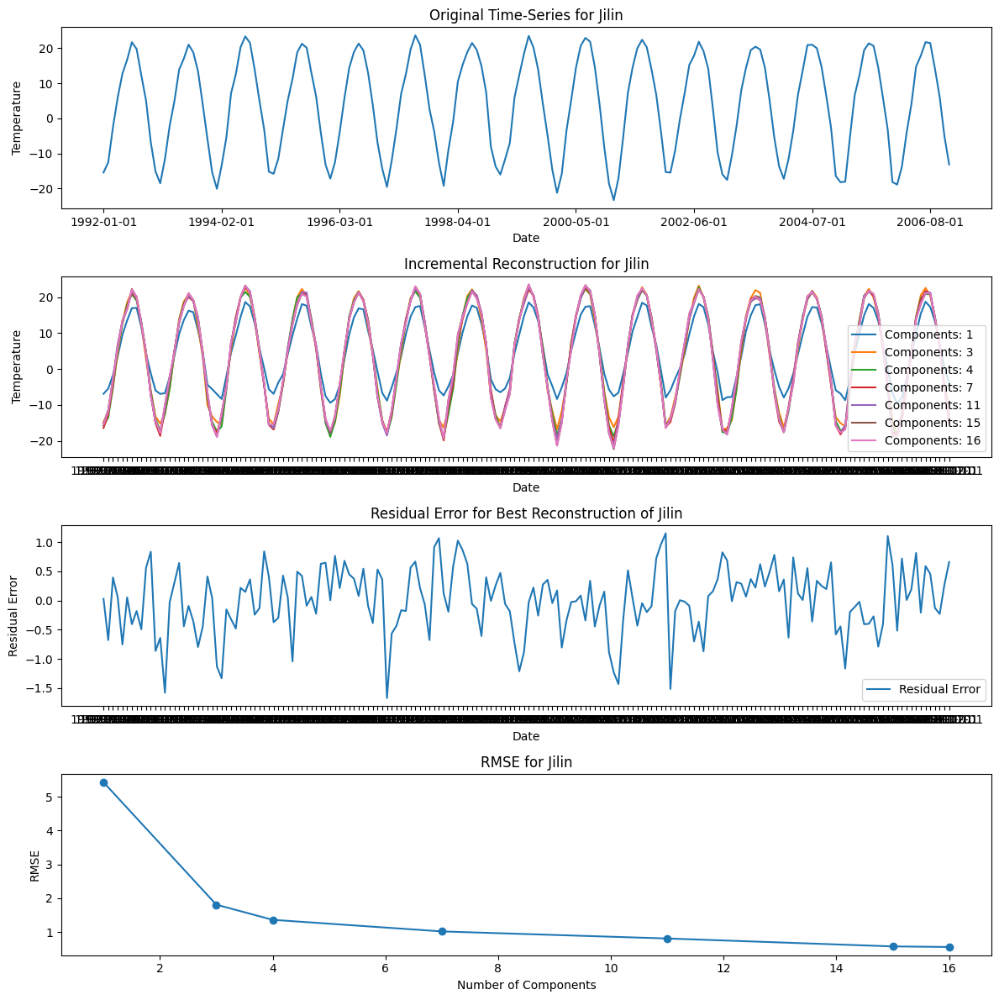

KeyError: ignored

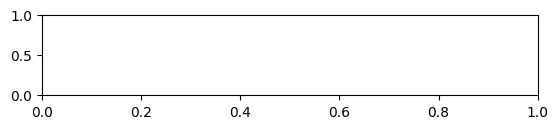

In [ ]:
### YOUR CODE HERE ###
# data_head = data.head()
# print(data_head)

cities = ['Jilin', 'Nunavut', 'Rio Grande Do Norte', 'Louisiana', 'Tasmania']
for city in cities:
    plot_city_figures_svd(df, city)

# References

Understanding PCA and SVD:

1. https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8

2. https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca

3. https://stats.stackexchange.com/questions/2691/making-sense-of-principal-component-analysis-eigenvectors-eigenvalues

4. https://hadrienj.github.io/posts/Deep-Learning-Book-Series-2.8-Singular-Value-Decomposition/

PCA:

1. Snippets from: https://plot.ly/ipython-notebooks/principal-component-analysis/

2. https://www.value-at-risk.net/principal-component-analysis/

Temperature Data:

1. https://www.kaggle.com/datasets/berkeleyearth/climate-change-earth-surface-temperature-data

2. https://berkeleyearth.org/data/

